 # EXECUTIVE SUMMARY: USA REAL ESTATE DATASET
 - The U.S. real estate dataset offers comprehensive insights into property prices, physical characteristics, and geographic distribution, serving as a foundation for analyzing market trends and guiding investment strategies. However, the dataset faces limitations such as missing transaction prices, incomplete critical fields **(e.g., year built, house size)**, and extreme outliers, which risk skewing analytical outcomes.
  - To address these challenges, the study focuses on **three** primary objectives:
    - **(1)** Identifying high-potential investment areas by analyzing transaction density and regional price trends;
    - **(2)** Investigating correlations between property features **(e.g., bathrooms, square footage)** and sale prices using multivariate regression;
    - **(3)** Developing predictive pricing models **(Linear Regression, XGBoost)** after rigorous data cleaning and outlier removal. Additionally, integrating macroeconomic indicators **(interest rates, GDP)** and **segmenting customers** by budget enables optimized portfolio strategies and personalized investment solutions.
  - The final results aim to deliver a balanced, data-driven perspective that highlights market opportunities while mitigating risks, thereby enhancing the reliability of real estate investment decisions. This approach bridges data quality improvements with actionable insights, ensuring robust outcomes for investors and analysts alike.


##  Import Libraries & Retrieve Data

In [373]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [374]:
estate_df = pd.read_csv("res/realtor-data.csv")
estate_df

,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date
0,103378.0,for_sale,105000.0,3.0,2.0,0.12,1962661.0,Adjuntas,Puerto Rico,601.0,920.0,NaN
1,52707.0,for_sale,80000.0,4.0,2.0,0.08,1902874.0,Adjuntas,Puerto Rico,601.0,1527.0,NaN
2,103379.0,for_sale,67000.0,2.0,1.0,0.15,1404990.0,Juana Diaz,Puerto Rico,795.0,748.0,NaN
3,31239.0,for_sale,145000.0,4.0,2.0,0.10,1947675.0,Ponce,Puerto Rico,731.0,1800.0,NaN
4,34632.0,for_sale,65000.0,6.0,2.0,0.05,331151.0,Mayaguez,Puerto Rico,680.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2226377,23009.0,sold,359900.0,4.0,2.0,0.33,353094.0,Richland,Washington,99354.0,3600.0,2022-03-25
2226378,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25
2226379,76856.0,sold,440000.0,6.0,3.0,0.50,405677.0,Richland,Washington,99354.0,3200.0,2022-03-24
2226380,53618.0,sold,179900.0,2.0,1.0,0.09,761379.0,Richland,Washington,99354.0,933.0,2022-03-24


- First, let's take a quick look at the entire data.

## Exploratory Data Analyst (EDA)

In [375]:
estate_df.shape

(2226382, 12)

In [376]:
estate_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2226382 entries, 0 to 2226381
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   brokered_by     float64
 1   status          object 
 2   price           float64
 3   bed             float64
 4   bath            float64
 5   acre_lot        float64
 6   street          float64
 7   city            object 
 8   state           object 
 9   zip_code        float64
 10  house_size      float64
 11  prev_sold_date  object 
dtypes: float64(8), object(4)
memory usage: 203.8+ MB


In [377]:
estate_df[['price', 'bed', 'bath', 'acre_lot', 'house_size']].describe().applymap(lambda x: f'{x:,.2f}')

C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\233675763.py:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  estate_df[['price', 'bed', 'bath', 'acre_lot', 'house_size']].describe().applymap(lambda x: f'{x:,.2f}')


,price,bed,bath,acre_lot,house_size
count,"2,224,841.00","1,745,065.00","1,714,611.00","1,900,793.00","1,657,898.00"
mean,"524,195.52",3.28,2.50,15.22,"2,714.47"
std,"2,138,893.22",1.57,1.65,762.82,"808,163.52"
min,0.00,1.00,1.00,0.00,4.00
25%,"165,000.00",3.00,2.00,0.15,"1,300.00"
50%,"325,000.00",3.00,2.00,0.26,"1,760.00"
75%,"550,000.00",4.00,3.00,0.98,"2,413.00"
max,"2,147,483,600.00",473.00,830.00,"100,000.00","1,040,400,400.00"


In [378]:
# Calculates the count of each unique value in the `status`
estate_df.groupby('status').size()

status
for_sale          1389306
ready_to_build      25067
sold               812009
dtype: int64

In [379]:
estate_df.acre_lot.unique()

array([1.20000e-01, 8.00000e-02, 1.50000e-01, ..., 2.32800e+02,
       3.14250e+02, 1.65072e+03], shape=(16058,))

In [380]:
estate_df.house_size.unique()

array([  920.,  1527.,   748., ..., 16749., 21200., 21402.],
      shape=(12062,))

In [381]:
estate_df.price.unique()

array([105000.,  80000.,  67000., ..., 386464., 488512., 280290.],
      shape=(102138,))

In [382]:
estate_df.bath.unique()

array([  2.,   1.,   3.,   5.,   4.,   7.,   6.,  nan,   8.,   9.,  10.,
        12.,  13.,  35.,  11.,  16.,  15.,  18.,  20.,  14.,  36.,  25.,
        17.,  19.,  56.,  42.,  51.,  28., 198.,  22.,  33.,  27.,  30.,
        29.,  24.,  46.,  21., 123.,  39.,  43.,  32.,  45.,  64.,  31.,
        54.,  68.,  23.,  37.,  26., 212.,  69.,  44.,  49.,  60.,  70.,
        71., 157.,  97.,  99.,  47.,  80.,  38.,  48.,  52.,  72., 752.,
        40., 163., 460.,  53.,  62.,  78.,  66.,  57.,  74.,  86., 108.,
        41.,  34.,  58., 113.,  50.,  88., 830., 222., 175.,  55.])

In [383]:
estate_df.bed.unique()

array([  3.,   4.,   2.,   6.,   5.,   1.,   9.,  nan,   7.,   8.,  12.,
        13.,  10.,  11.,  33.,  24.,  28.,  14.,  18.,  20.,  16.,  15.,
        19.,  17.,  40.,  21.,  86.,  31.,  27.,  42.,  60.,  22.,  32.,
        99.,  49.,  29.,  30.,  23.,  46.,  36.,  68., 123.,  25.,  47.,
        35.,  38.,  64.,  48.,  75., 142.,  61.,  70.,  53.,  26.,  34.,
        54.,  71., 210.,  66.,  44.,  37.,  62.,  72., 100.,  55.,  74.,
        73., 473.,  52., 110., 136.,  50.,  98., 102.,  69.,  82.,  41.,
        76.,  43.,  80.,  67., 190.,  93.,  45.,  96.,  57.,  39.,  56.,
        63.,  90., 108., 111., 212.,  88., 222., 444., 148.,  84., 114.,
       120.])

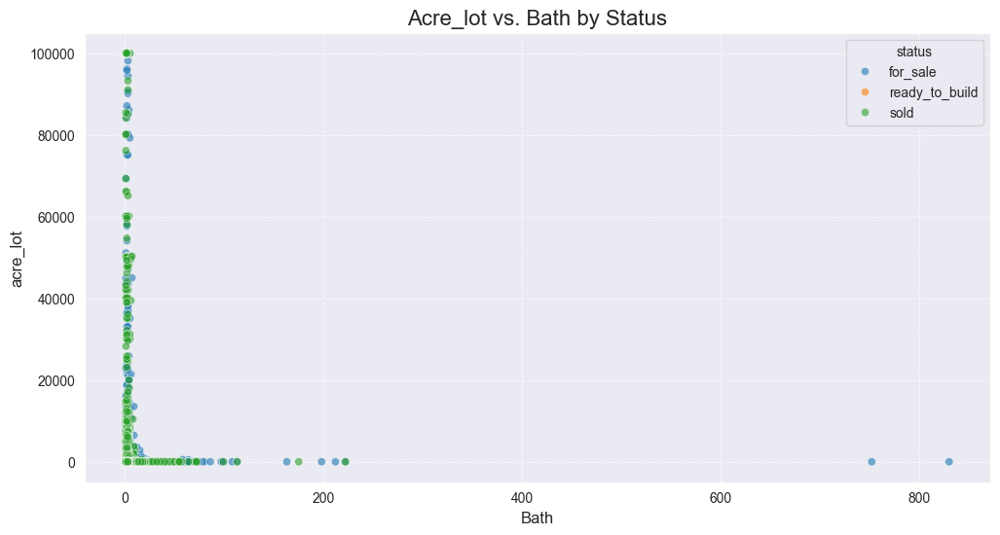

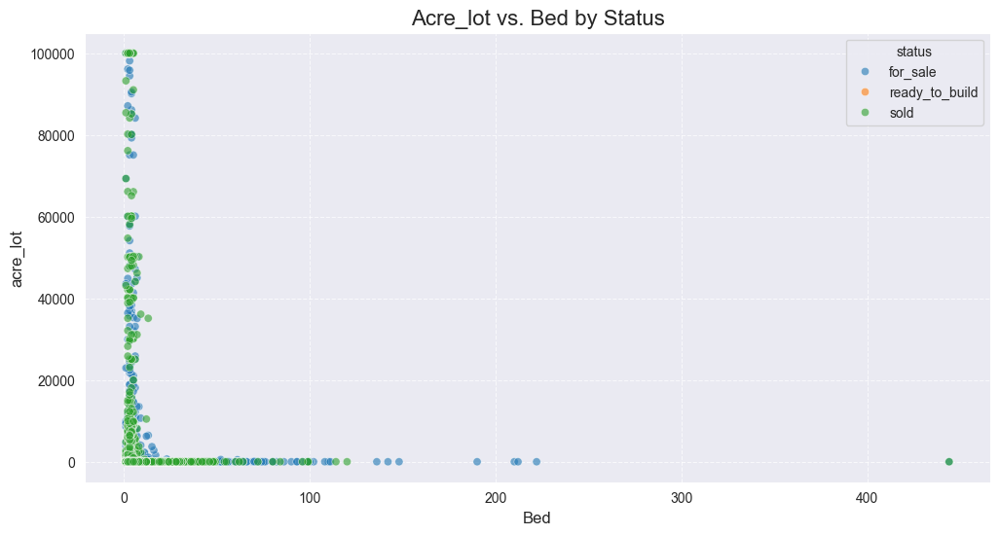

In [384]:
def plot_scatter(data, x_col, y_col, hue_col, title, x_label, y_label, legend_loc='upper right'):

    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=data, x=x_col, y=y_col, hue=hue_col, alpha=0.6)
    plt.title(title, fontsize=16)
    plt.xlabel(x_label, fontsize=12)
    plt.ylabel(y_label, fontsize=12)
    plt.legend(title=hue_col, loc=legend_loc)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()


# Scatterplot: Price vs. Bath
plot_scatter(
    data=estate_df,
    x_col='bath',
    y_col='acre_lot',
    hue_col='status',
    title='Acre_lot vs. Bath by Status',
    x_label='Bath',
    y_label='acre_lot'
)
# Scatterplot: Price vs. Bed
plot_scatter(
    data=estate_df,
    x_col='bed',
    y_col='acre_lot',
    hue_col='status',
    title='Acre_lot vs. Bed by Status',
    x_label='Bed',
    y_label='acre_lot'
)


We observed that the **"ready_to_build"** status has no values in the dataset. This may reflect its actual state, with 100% NaN values in the `bed` and `bath` columns. Therefore, we should carefully consider this when addressing missing data issues.

In [385]:
# View the years in the dataset
sorted_dates = estate_df['prev_sold_date'].dropna().str[:4].unique()
sorted_dates = sorted(sorted_dates, reverse=True)

print(sorted_dates)

['3019', '2026', '2024', '2023', '2022', '2021', '2020', '2019', '2018', '2017', '2016', '2015', '2014', '2013', '2012', '2011', '2010', '2009', '2008', '2007', '2006', '2005', '2004', '2003', '2002', '2001', '2000', '1999', '1998', '1997', '1996', '1995', '1994', '1993', '1992', '1991', '1990', '1989', '1988', '1987', '1986', '1985', '1984', '1983', '1982', '1981', '1980', '1979', '1978', '1977', '1976', '1975', '1974', '1973', '1972', '1971', '1970', '1969', '1968', '1967', '1966', '1965', '1964', '1963', '1962', '1961', '1960', '1959', '1958', '1957', '1956', '1955', '1954', '1953', '1952', '1951', '1950', '1949', '1941', '1939', '1935', '1928', '1926', '1910', '1909', '1906', '1905', '1904', '1901']


In [386]:
estate_df['prev_sold_date'] = pd.to_datetime(estate_df['prev_sold_date'], errors='coerce')

estate_df['year'] = estate_df['prev_sold_date'].dt.year
transactions_per_year = estate_df['year'].value_counts().sort_index()

# Calculate the percentage of transactions per year
total_transactions = transactions_per_year.sum()
percentage_per_year = (transactions_per_year / total_transactions) * 100

# Combine results into a DataFrame
transactions_summary = pd.DataFrame({
    'Year': transactions_per_year.index,
    'Transactions': transactions_per_year.values,
    'Percentage': percentage_per_year.values
}).sort_values('Year')

print(transactions_summary)

      Year  Transactions  Percentage
0   1901.0             1    0.000067
1   1904.0             1    0.000067
2   1905.0             1    0.000067
3   1906.0             1    0.000067
4   1909.0             2    0.000134
..     ...           ...         ...
83  2021.0        316605   21.218980
84  2022.0        613707   41.130861
85  2023.0           570    0.038202
86  2024.0             5    0.000335
87  2026.0             1    0.000067

[88 rows x 3 columns]


- We chose to keep data only from 2013-2023 for analysis because this range represents the most recent and relevant period. Including outdated information could **bias insights and lead to less actionable or misleading conclusions**. By focusing on the last decade, we ensure trends and patterns closely align with current market behavior, supporting more accurate and timely decision-making.

- Now, let's proceed to filter the dataset to include only transactions within this timeframe.

In [387]:
estate_df['prev_sold_date'] = pd.to_datetime(estate_df['prev_sold_date'], errors='coerce')
estate_df = estate_df[(estate_df['prev_sold_date'].dt.year >= 2013) & (estate_df['prev_sold_date'].dt.year <= 2023)]

estate_df


,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year
411,52270.0,for_sale,76900.0,3.0,2.0,NaN,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0
502,92147.0,for_sale,110000.0,7.0,3.0,0.09,1842706.0,Dorado,Puerto Rico,949.0,1192.0,2019-06-28,2019.0
1025,52707.0,for_sale,159000.0,3.0,2.0,NaN,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0
1160,66902.0,for_sale,380000.0,NaN,NaN,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,NaN,2021-03-15,2021.0
2270,94933.0,for_sale,950000.0,5.0,4.0,0.99,1260473.0,Saint Thomas,Virgin Islands,802.0,5000.0,2013-10-11,2013.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226377,23009.0,sold,359900.0,4.0,2.0,0.33,353094.0,Richland,Washington,99354.0,3600.0,2022-03-25,2022.0
2226378,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25,2022.0
2226379,76856.0,sold,440000.0,6.0,3.0,0.50,405677.0,Richland,Washington,99354.0,3200.0,2022-03-24,2022.0
2226380,53618.0,sold,179900.0,2.0,1.0,0.09,761379.0,Richland,Washington,99354.0,933.0,2022-03-24,2022.0


##  Feature Engineering

- Creating the `price_per_ft_sqft` column helps normalize property values by standardizing the cost per unit of area. It simplifies comparisons between houses of different sizes and offers valuable insights into property value trends, aiding more accurate pricing analysis and decision-making.


In [388]:
# Create the `price_per_ft_sqft` column by dividing the price (`price`) by the house size (`house_size`)
estate_df['price_per_ft_sqft'] = (estate_df['price'] / estate_df['house_size']).round(2)

C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\3155401745.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estate_df['price_per_ft_sqft'] = (estate_df['price'] / estate_df['house_size']).round(2)


In [389]:
estate_df

,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
411,52270.0,for_sale,76900.0,3.0,2.0,NaN,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0,64.08
502,92147.0,for_sale,110000.0,7.0,3.0,0.09,1842706.0,Dorado,Puerto Rico,949.0,1192.0,2019-06-28,2019.0,92.28
1025,52707.0,for_sale,159000.0,3.0,2.0,NaN,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0,97.85
1160,66902.0,for_sale,380000.0,NaN,NaN,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,NaN,2021-03-15,2021.0,NaN
2270,94933.0,for_sale,950000.0,5.0,4.0,0.99,1260473.0,Saint Thomas,Virgin Islands,802.0,5000.0,2013-10-11,2013.0,190.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226377,23009.0,sold,359900.0,4.0,2.0,0.33,353094.0,Richland,Washington,99354.0,3600.0,2022-03-25,2022.0,99.97
2226378,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25,2022.0,216.58
2226379,76856.0,sold,440000.0,6.0,3.0,0.50,405677.0,Richland,Washington,99354.0,3200.0,2022-03-24,2022.0,137.50
2226380,53618.0,sold,179900.0,2.0,1.0,0.09,761379.0,Richland,Washington,99354.0,933.0,2022-03-24,2022.0,192.82


## Data  Preprocessing

In [390]:
def check_missing(df):
    missing_report = df.isnull().sum().to_frame(name='MissingCount')
    missing_report['Percentage'] = (missing_report['MissingCount'] / len(df)) * 100
    return missing_report[missing_report['MissingCount'] > 0].sort_values(by='Percentage', ascending=False)


missing_data_report = check_missing(estate_df)
print(missing_data_report)


                   MissingCount  Percentage
price_per_ft_sqft        165693   13.662371
house_size               165473   13.644231
acre_lot                 160267   13.214965
bath                     119200    9.828747
bed                      112118    9.244794
street                     3960    0.326525
brokered_by                3363    0.277299
price                       335    0.027623
city                        262    0.021603
zip_code                     24    0.001979


In [391]:
# Group classification
lom_cols = missing_data_report[
    (missing_data_report['Percentage'] > 0) & (missing_data_report['Percentage'] < 1)].index.tolist()
him_cols = missing_data_report[missing_data_report['Percentage'] >= 1].index.tolist()

print("Columns with missing rate < 10%:", lom_cols)
print("Columns with missing rate >= 10%:", him_cols)


Columns with missing rate < 10%: ['street', 'brokered_by', 'price', 'city', 'zip_code']
Columns with missing rate >= 10%: ['price_per_ft_sqft', 'house_size', 'acre_lot', 'bath', 'bed']


- We decided to remove columns with missing values below 1% in `missing_data_report` to improve data quality. Columns with such negligible missing ratios usually do not significantly impact analysis or model performance.

In [392]:
# Remove missing data in low_cols
estate_df = estate_df.dropna(subset=lom_cols)

In [393]:
# Check missing values again
print(check_missing(estate_df))

                   MissingCount  Percentage
price_per_ft_sqft        163126   13.539281
house_size               163126   13.539281
acre_lot                 158890   13.187698
bath                     117171    9.725066
bed                      109998    9.129715


In [394]:
# Group category data and number data
him_col_groups = {
    'categorical': [col for col in him_cols if estate_df[col].dtype == 'object'],
    'numerical': [col for col in him_cols if estate_df[col].dtype != 'object']
}
print("High Missing Categorical Columns:", him_col_groups['categorical'])
print("High Missing Numerical Columns:", him_col_groups['numerical'])

High Missing Categorical Columns: []
High Missing Numerical Columns: ['price_per_ft_sqft', 'house_size', 'acre_lot', 'bath', 'bed']


### Handing missing values

- Reason for Filling Missing Values in Numeric Columns with Median Based on `status`, `state`, and `city`

    - Filling missing values in numeric columns using the median is robust against outliers, as the median accurately represents the central tendency for skewed datasets. Grouping by the hierarchical levels `status`, `state`, and `city` ensures that data imputation accounts for geographic and property-specific variations, making the filling more contextually relevant.
    - This method preserves inherent patterns in the data while mitigating risks of introducing bias or inaccuracies. It also ensures that the imputation reflects localized trends in housing characteristics at varying levels of granularity. Overall, this approach maintains data integrity and supports reliable downstream analysis.

In [395]:
# Loop through each hierarchical level: 'status', 'state', 'city'
for level in ['status', 'state', 'city']:
    # Create groups grouped by the given level
    grouped = estate_df.groupby(level)

    # Loop through each column that needs missing value handling
    for col in him_col_groups['numerical']:
        # Calculate the group-wise median and align it with the original DataFrame index using transform
        median_values = grouped[col].transform('median')

        # Fill NaN values in the original column with the calculated median values
        estate_df[col] = estate_df[col].fillna(median_values)

C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\2421124486.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estate_df[col] = estate_df[col].fillna(median_values)
C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\2421124486.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estate_df[col] = estate_df[col].fillna(median_values)
C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\2421124486.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

In [396]:
check_missing_again = estate_df.isnull().sum()
print(check_missing_again)

brokered_by          0
status               0
price                0
bed                  0
bath                 0
acre_lot             0
street               0
city                 0
state                0
zip_code             0
house_size           0
prev_sold_date       0
year                 0
price_per_ft_sqft    0
dtype: int64


In [397]:
estate_df.shape

(1204835, 14)

### Outlier Removal

In [398]:
# Remove rows where price is less than 100
estate_df1 = estate_df[estate_df.price > 100]

# Display the count of rows removed
rows_removed = estate_df.shape[0] - estate_df1.shape[0]
print(f"Number of rows removed due to logical inconsistencies: {rows_removed}")

estate_df1

Number of rows removed due to logical inconsistencies: 155


,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
411,52270.0,for_sale,76900.0,3.0,2.0,0.23,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0,64.08
502,92147.0,for_sale,110000.0,7.0,3.0,0.09,1842706.0,Dorado,Puerto Rico,949.0,1192.0,2019-06-28,2019.0,92.28
1025,52707.0,for_sale,159000.0,3.0,2.0,0.23,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0,97.85
1160,66902.0,for_sale,380000.0,3.0,2.0,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,1803.0,2021-03-15,2021.0,207.02
2270,94933.0,for_sale,950000.0,5.0,4.0,0.99,1260473.0,Saint Thomas,Virgin Islands,802.0,5000.0,2013-10-11,2013.0,190.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226377,23009.0,sold,359900.0,4.0,2.0,0.33,353094.0,Richland,Washington,99354.0,3600.0,2022-03-25,2022.0,99.97
2226378,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25,2022.0,216.58
2226379,76856.0,sold,440000.0,6.0,3.0,0.50,405677.0,Richland,Washington,99354.0,3200.0,2022-03-24,2022.0,137.50
2226380,53618.0,sold,179900.0,2.0,1.0,0.09,761379.0,Richland,Washington,99354.0,933.0,2022-03-24,2022.0,192.82


- We filter rows with `price > 100` to remove unrealistic or erroneous data, such as unreasonably low property prices, ensuring data accuracy and reliability. This step helps us improve dataset quality, eliminate outliers, and focus our analysis on meaningful market trends.


In [399]:
# Remove rows where average house size per bedroom is less than 130 square feet
estate_df2 = estate_df1[estate_df1.house_size / estate_df1.bed >= 130].copy()

# Display the count of rows removed
rows_removed = estate_df1.shape[0] - estate_df2.shape[0]
print(f"Number of rows removed due to logical inconsistencies: {rows_removed}")

# Verify the cleaned dataset
estate_df2.head()


Number of rows removed due to logical inconsistencies: 853


,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
411,52270.0,for_sale,76900.0,3.0,2.0,0.23,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0,64.08
502,92147.0,for_sale,110000.0,7.0,3.0,0.09,1842706.0,Dorado,Puerto Rico,949.0,1192.0,2019-06-28,2019.0,92.28
1025,52707.0,for_sale,159000.0,3.0,2.0,0.23,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0,97.85
1160,66902.0,for_sale,380000.0,3.0,2.0,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,1803.0,2021-03-15,2021.0,207.02
2270,94933.0,for_sale,950000.0,5.0,4.0,0.99,1260473.0,Saint Thomas,Virgin Islands,802.0,5000.0,2013-10-11,2013.0,190.00


- The average size of a single bedroom in most standard properties is typically larger than **130 square feet**.
- A value less than 130 square feet can indicate:
    **Data entry errors**: A significantly underestimated house size (`house_size`) or an unrealistically high bedroom count (`bed`)


In [400]:
# Remove rows where average house size per bathroom is less than 40 square feet
estate_df3 = estate_df2[estate_df2.house_size / estate_df2.bath >= 40].copy()

# Display the count of rows removed
rows_removed = estate_df2.shape[0] - estate_df3.shape[0]
print(f"Number of rows removed due to logical inconsistencies: {rows_removed}")

# Verify the cleaned dataset
estate_df3

Number of rows removed due to logical inconsistencies: 7


,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
411,52270.0,for_sale,76900.0,3.0,2.0,0.23,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0,64.08
502,92147.0,for_sale,110000.0,7.0,3.0,0.09,1842706.0,Dorado,Puerto Rico,949.0,1192.0,2019-06-28,2019.0,92.28
1025,52707.0,for_sale,159000.0,3.0,2.0,0.23,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0,97.85
1160,66902.0,for_sale,380000.0,3.0,2.0,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,1803.0,2021-03-15,2021.0,207.02
2270,94933.0,for_sale,950000.0,5.0,4.0,0.99,1260473.0,Saint Thomas,Virgin Islands,802.0,5000.0,2013-10-11,2013.0,190.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226377,23009.0,sold,359900.0,4.0,2.0,0.33,353094.0,Richland,Washington,99354.0,3600.0,2022-03-25,2022.0,99.97
2226378,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25,2022.0,216.58
2226379,76856.0,sold,440000.0,6.0,3.0,0.50,405677.0,Richland,Washington,99354.0,3200.0,2022-03-24,2022.0,137.50
2226380,53618.0,sold,179900.0,2.0,1.0,0.09,761379.0,Richland,Washington,99354.0,933.0,2022-03-24,2022.0,192.82


- In this case, illogical data occurs when the average house size per bathroom is less than **40 square feet**. This value is unrealistic as bathrooms typically require more space, and such values may result from data input errors, like underestimated `house_size` or overestimated `bathroom` count.

In [401]:
estate_df3[estate_df3['acre_lot'] == 0]

,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
12087,57226.0,for_sale,379900.0,2.0,2.0,0.0,1774133.0,Tewksbury,Massachusetts,1876.0,1026.0,2020-04-28,2020.0,370.27
14751,78838.0,for_sale,389900.0,3.0,1.0,0.0,890126.0,Warwick,Rhode Island,2888.0,1284.0,2016-01-25,2016.0,303.66
16192,55379.0,for_sale,379900.0,2.0,2.0,0.0,20716.0,Tewksbury,Massachusetts,1876.0,1469.0,2018-08-31,2018.0,258.61
21766,65977.0,for_sale,499000.0,3.0,2.0,0.0,812993.0,Portsmouth,Rhode Island,2871.0,1312.0,2020-10-05,2020.0,380.34
23206,66166.0,for_sale,1297500.0,4.0,3.0,0.0,982095.0,North Kingstown,Rhode Island,2852.0,3200.0,2019-09-26,2019.0,405.47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2177797,22935.0,sold,800000.0,3.0,3.0,0.0,1825557.0,Incline Village,Nevada,89451.0,1440.0,2022-04-05,2022.0,555.56
2177833,91533.0,sold,2850000.0,4.0,4.0,0.0,1744290.0,Incline Village,Nevada,89451.0,3130.0,2021-11-22,2021.0,910.54
2208673,74246.0,sold,825000.0,3.0,3.0,0.0,38863.0,Sequim,Washington,98382.0,2817.0,2022-04-27,2022.0,292.86
2211653,73934.0,sold,285000.0,2.0,1.0,0.0,1603002.0,Edmonds,Washington,98026.0,847.0,2021-12-13,2021.0,336.48


- Some rows in the dataset have a total lot size (`acre_lot`) of 0. This may be because these properties are apartments or condos, which only include indoor living space and no surrounding land, resulting in a total lot size of 0. However, to ensure accuracy in building the model, we decided to exclude these rows from the dataset.


In [402]:
# Remove rows where acce_lot = 0
esta = estate_df3[estate_df3.acre_lot > 0].copy()

# Display the count of rows removed
rows_removed = estate_df3.shape[0] - esta.shape[0]
print(f"Number of rows removed due to logical inconsistencies: {rows_removed}")

# Verify the cleaned dataset
esta

Number of rows removed due to logical inconsistencies: 1385


,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
411,52270.0,for_sale,76900.0,3.0,2.0,0.23,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0,64.08
502,92147.0,for_sale,110000.0,7.0,3.0,0.09,1842706.0,Dorado,Puerto Rico,949.0,1192.0,2019-06-28,2019.0,92.28
1025,52707.0,for_sale,159000.0,3.0,2.0,0.23,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0,97.85
1160,66902.0,for_sale,380000.0,3.0,2.0,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,1803.0,2021-03-15,2021.0,207.02
2270,94933.0,for_sale,950000.0,5.0,4.0,0.99,1260473.0,Saint Thomas,Virgin Islands,802.0,5000.0,2013-10-11,2013.0,190.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226377,23009.0,sold,359900.0,4.0,2.0,0.33,353094.0,Richland,Washington,99354.0,3600.0,2022-03-25,2022.0,99.97
2226378,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25,2022.0,216.58
2226379,76856.0,sold,440000.0,6.0,3.0,0.50,405677.0,Richland,Washington,99354.0,3200.0,2022-03-24,2022.0,137.50
2226380,53618.0,sold,179900.0,2.0,1.0,0.09,761379.0,Richland,Washington,99354.0,933.0,2022-03-24,2022.0,192.82


In [403]:
esta.shape

(1202435, 14)

In [404]:
num = esta[['price_per_ft_sqft', 'price', 'bed', 'bath', 'house_size','acre_lot']]
desc_stats = num.describe()
formatted = desc_stats.applymap(lambda x: f"{x:,.2f}")

formatted

C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\2170596008.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  formatted = desc_stats.applymap(lambda x: f"{x:,.2f}")


,price_per_ft_sqft,price,bed,bath,house_size,acre_lot
count,"1,202,435.00","1,202,435.00","1,202,435.00","1,202,435.00","1,202,435.00","1,202,435.00"
mean,266.29,"521,011.76",3.21,2.41,"1,946.74",10.69
std,521.73,"1,116,015.72",1.16,1.11,"4,171.97",713.06
min,0.03,215.00,1.00,1.00,161.00,0.01
25%,153.19,"214,000.00",3.00,2.00,"1,351.00",0.15
50%,201.55,"350,000.00",3.00,2.00,"1,681.00",0.21
75%,288.06,"570,000.00",4.00,3.00,"2,212.00",0.39
max,"491,412.21","515,000,000.00",190.00,163.00,"3,434,706.00","100,000.00"


In [405]:
esta.max()

brokered_by                     110142.0
status                              sold
price                        515000000.0
bed                                190.0
bath                               163.0
acre_lot                        100000.0
street                         2001348.0
city                              Zwolle
state                            Wyoming
zip_code                         99901.0
house_size                     3434706.0
prev_sold_date       2023-12-31 00:00:00
year                              2023.0
price_per_ft_sqft              491412.21
dtype: object

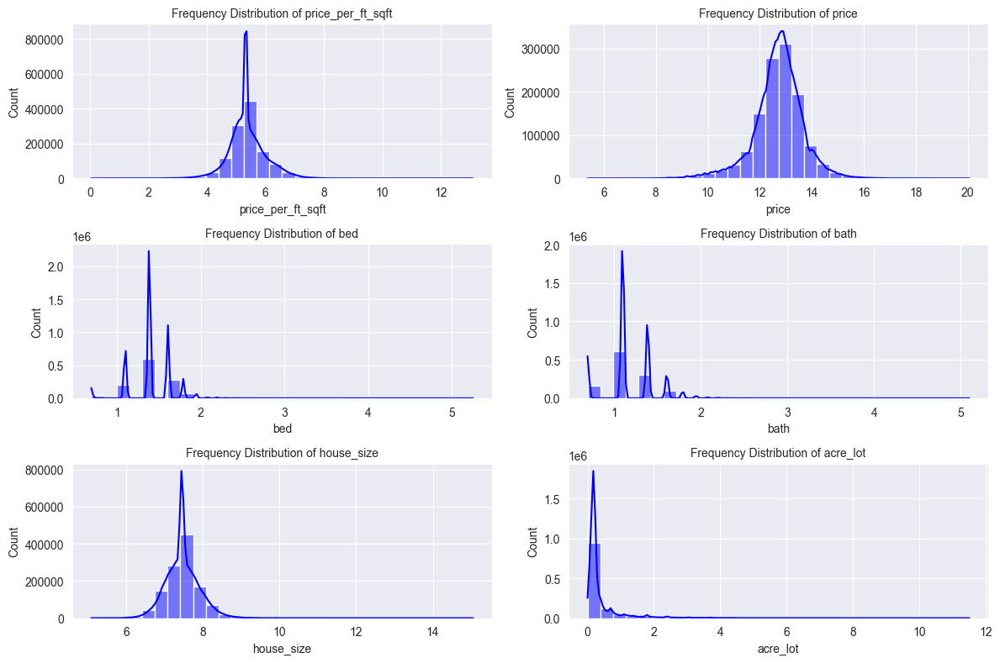

In [406]:
plt.figure(figsize=(12, 8))  # Set a larger overall figure size (width=12, height=8)

# Iterate through the list of column names
for i, column in enumerate(num, 1):  # Start from 1 for subplot index
    plt.subplot(3, 2, i)  # Specify a 3x2 layout grid
    # Apply logarithmic transformation to the column
    estate_df3[column] = np.log1p(estate_df3[column]) # log1p to avoid negative values..
    # Plot the distribution histogram
    sns.histplot(estate_df3[column], kde=True, bins=30, color='blue')
    plt.title(f"Frequency Distribution of {column}", fontsize=10)  # Adjust title size

plt.tight_layout()  # Optimize spacing between subplots
plt.show()


In [407]:
esta

,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
411,52270.0,for_sale,76900.0,3.0,2.0,0.23,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0,64.08
502,92147.0,for_sale,110000.0,7.0,3.0,0.09,1842706.0,Dorado,Puerto Rico,949.0,1192.0,2019-06-28,2019.0,92.28
1025,52707.0,for_sale,159000.0,3.0,2.0,0.23,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0,97.85
1160,66902.0,for_sale,380000.0,3.0,2.0,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,1803.0,2021-03-15,2021.0,207.02
2270,94933.0,for_sale,950000.0,5.0,4.0,0.99,1260473.0,Saint Thomas,Virgin Islands,802.0,5000.0,2013-10-11,2013.0,190.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2226377,23009.0,sold,359900.0,4.0,2.0,0.33,353094.0,Richland,Washington,99354.0,3600.0,2022-03-25,2022.0,99.97
2226378,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25,2022.0,216.58
2226379,76856.0,sold,440000.0,6.0,3.0,0.50,405677.0,Richland,Washington,99354.0,3200.0,2022-03-24,2022.0,137.50
2226380,53618.0,sold,179900.0,2.0,1.0,0.09,761379.0,Richland,Washington,99354.0,933.0,2022-03-24,2022.0,192.82


In [408]:
nume = esta[['price_per_ft_sqft', 'price', 'bed', 'bath', 'house_size']]
result = {}
total_count = esta.shape[0]  # Get the total count of rows in estate_df3

for col in nume.columns:
    Q1 = nume[col].quantile(0.25)
    Q3 = nume[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = nume[(nume[col] < lower_bound) | (nume[col] > upper_bound)]

    # Calculate outlier count and outlier percentage
    outlier_count = len(outliers)
    outlier_percentage = (outlier_count / total_count) * 100

    result[col] = {
        'outlier_count': outlier_count,
        '%outlier': f"{outlier_percentage:.2f}%",  # Format the percentage with 2 decimal points
        'thresholds': {'lower_bound': lower_bound, 'upper_bound': upper_bound}
    }

# Print the result in a grouped structure for better readability
for column, details in result.items():
    print(f"Column: {column}")
    print(f"  Outlier Count: {details['outlier_count']}")
    print(f"  %Outlier: {details['%outlier']}")
    print(f"  Thresholds: {details['thresholds']}")
    print("-" * 50)

Column: price_per_ft_sqft
  Outlier Count: 117377
  %Outlier: 9.76%
  Thresholds: {'lower_bound': np.float64(-49.11500000000001), 'upper_bound': np.float64(490.365)}
--------------------------------------------------
Column: price
  Outlier Count: 88543
  %Outlier: 7.36%
  Thresholds: {'lower_bound': np.float64(-320000.0), 'upper_bound': np.float64(1104000.0)}
--------------------------------------------------
Column: bed
  Outlier Count: 65591
  %Outlier: 5.45%
  Thresholds: {'lower_bound': np.float64(1.5), 'upper_bound': np.float64(5.5)}
--------------------------------------------------
Column: bath
  Outlier Count: 42004
  %Outlier: 3.49%
  Thresholds: {'lower_bound': np.float64(0.5), 'upper_bound': np.float64(4.5)}
--------------------------------------------------
Column: house_size
  Outlier Count: 71707
  %Outlier: 5.96%
  Thresholds: {'lower_bound': np.float64(59.5), 'upper_bound': np.float64(3503.5)}
--------------------------------------------------


In [409]:
# Interquartile Range (IQR) outlier removal
for col, details in result.items():
    if col in nume:  # Only process columns listed in `nume`
        thresholds = details['thresholds']
        upper_bound = thresholds['upper_bound']
        lower_bound = thresholds['lower_bound']

        # Filter rows within the valid threshold for this column
        esta = esta[(esta[col] >= lower_bound) & (esta[col] <= upper_bound)]

# Reset index after filtering
esta.reset_index(drop=True, inplace=True)

# Display the cleaned DataFrame
esta


,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
0,52270.0,for_sale,76900.0,3.0,2.0,0.23,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0,64.08
1,52707.0,for_sale,159000.0,3.0,2.0,0.23,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0,97.85
2,66902.0,for_sale,380000.0,3.0,2.0,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,1803.0,2021-03-15,2021.0,207.02
3,22968.0,for_sale,79500.0,3.0,2.0,0.76,765975.0,Christiansted,Virgin Islands,820.0,1803.0,2016-04-28,2016.0,207.02
4,34543.0,for_sale,176500.0,3.0,2.0,0.50,917409.0,Christiansted,Virgin Islands,820.0,1803.0,2016-11-16,2016.0,207.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
966251,53860.0,sold,310000.0,3.0,1.0,0.21,500240.0,Richland,Washington,99354.0,1152.0,2022-02-11,2022.0,269.10
966252,60631.0,sold,385000.0,4.0,2.0,0.21,210890.0,Richland,Washington,99354.0,1656.0,2022-03-28,2022.0,232.49
966253,85499.0,sold,339900.0,4.0,2.0,0.20,41160.0,Richland,Washington,99354.0,2780.0,2022-03-28,2022.0,122.27
966254,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25,2022.0,216.58


In [410]:
# Recalculate and identify outliers for columns in 'nume'
outlier_info = {}
for col in nume.columns:
    Q1 = esta[col].quantile(0.25)
    Q3 = esta[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = esta[(esta[col] < lower_bound) | (esta[col] > upper_bound)]
    outlier_info[col] = {
        'outlier_count': len(outliers),
        '%outlier': f"{(len(outliers) / len(esta) * 100):.2f}%",
        'thresholds': {'lower_bound': lower_bound, 'upper_bound': upper_bound}
    }

outlier_info

{'price_per_ft_sqft': {'outlier_count': 47426,
  '%outlier': '4.91%',
  'thresholds': {'lower_bound': np.float64(3.0300000000000296),
   'upper_bound': np.float64(385.75)}},
 'price': {'outlier_count': 25336,
  '%outlier': '2.62%',
  'thresholds': {'lower_bound': np.float64(-200250.0),
   'upper_bound': np.float64(840150.0)}},
 'bed': {'outlier_count': 0,
  '%outlier': '0.00%',
  'thresholds': {'lower_bound': np.float64(1.5),
   'upper_bound': np.float64(5.5)}},
 'bath': {'outlier_count': 0,
  '%outlier': '0.00%',
  'thresholds': {'lower_bound': np.float64(0.5),
   'upper_bound': np.float64(4.5)}},
 'house_size': {'outlier_count': 29108,
  '%outlier': '3.01%',
  'thresholds': {'lower_bound': np.float64(349.0),
   'upper_bound': np.float64(3093.0)}}}

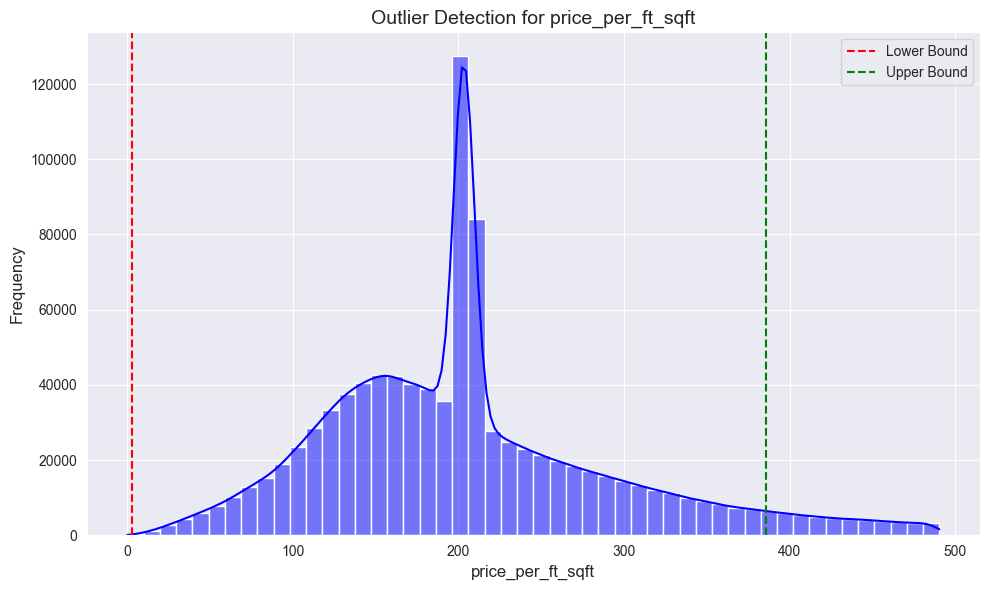

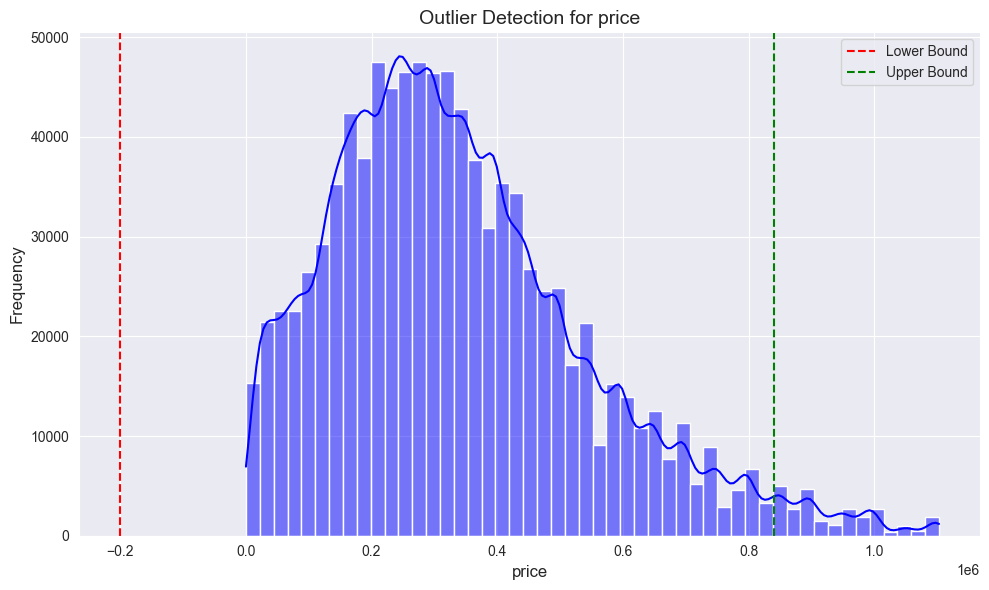

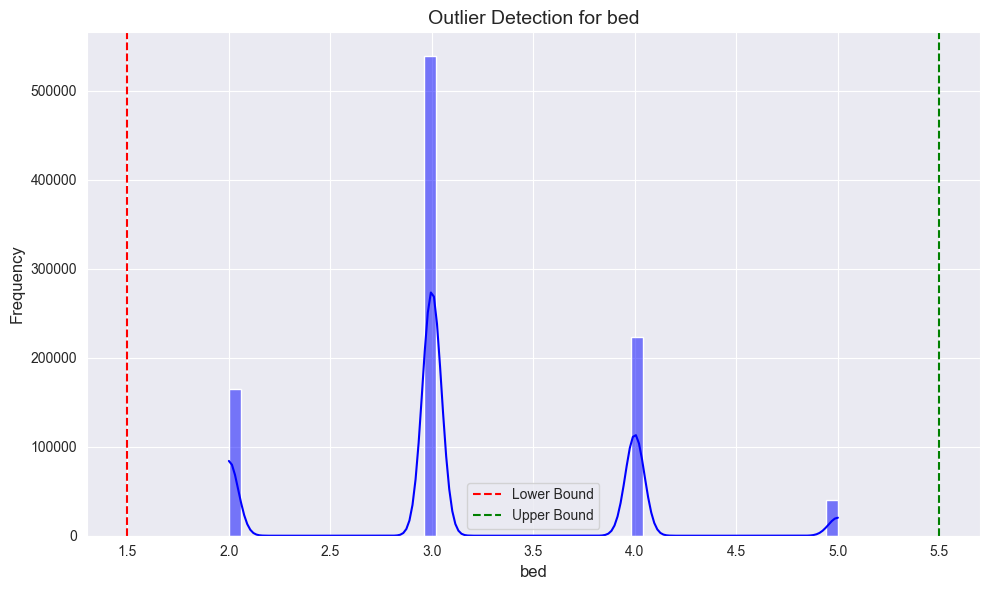

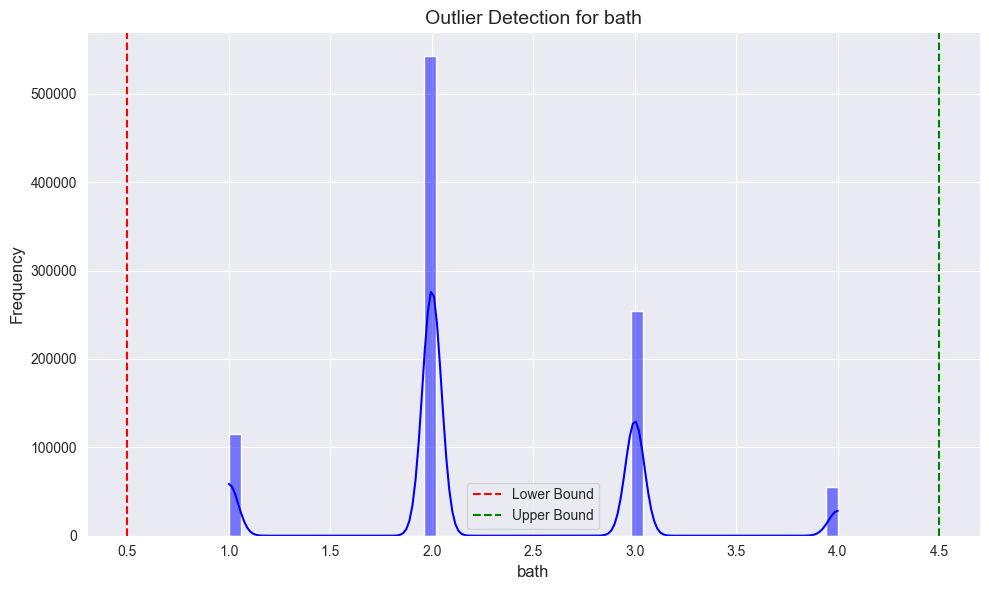

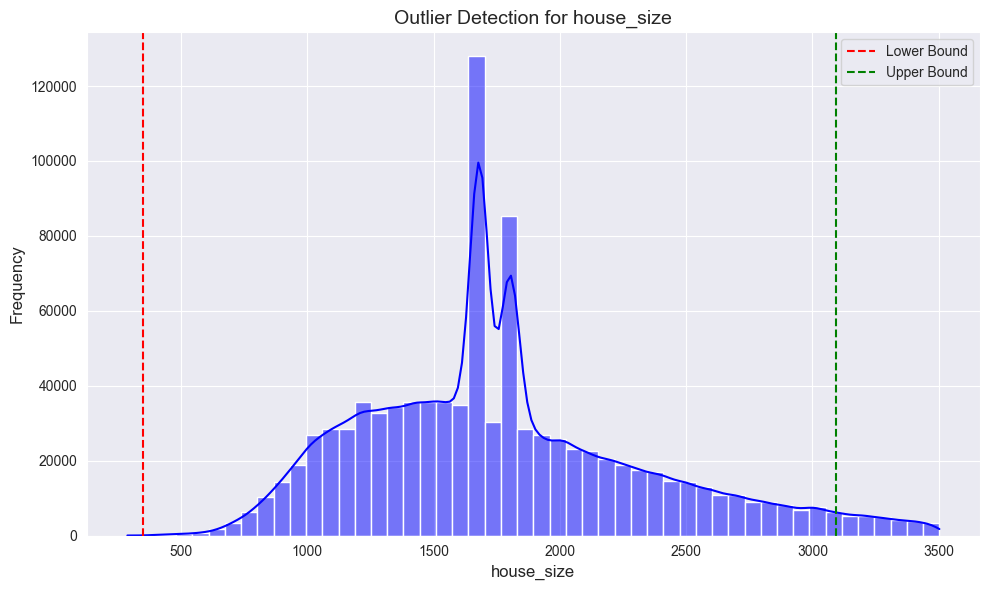

In [416]:
# Loop through each numeric column and visualize its distribution with outliers
for col, details in outlier_info.items():
    lower_bound, upper_bound = details['thresholds']['lower_bound'], details['thresholds']['upper_bound']

    # Plot histogram
    plt.figure(figsize=(10, 6))
    sns.histplot(esta[col], bins=50, kde=True, color='blue')
    plt.axvline(lower_bound, color='red', linestyle='--', label='Lower Bound')
    plt.axvline(upper_bound, color='green', linestyle='--', label='Upper Bound')

    plt.title(f"Outlier Detection for {col}", fontsize=14)
    plt.xlabel(f"{col}", fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.legend()
    plt.tight_layout()
    plt.show()

### Correlation

In [436]:
# Transform 'zip_code' và 'street' to category
esta['brokered_by'] = esta['brokered_by'].astype('category')
esta['zip_code'] = esta['zip_code'].astype('category')
esta['street'] = esta['street'].astype('category')

In [437]:
# Separate categorical and numeric columns in `esta`
cate = esta.select_dtypes(include=['object', 'category']).columns.tolist()
numer = esta.select_dtypes(include=['number']).columns.tolist()

print("Categorical Columns:", cate)
print("Numeric Columns:", numer)

Categorical Columns: ['brokered_by', 'status', 'street', 'city', 'state', 'zip_code']
Numeric Columns: ['price', 'bed', 'bath', 'acre_lot', 'house_size', 'year', 'price_per_ft_sqft']


C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\2853431390.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_target = encoded_df.groupby(col)[target_col].mean()  # Tính trung bình của cột mục tiêu
C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\2853431390.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_target = encoded_df.groupby(col)[target_col].mean()  # Tính trung bình của cột mục tiêu
C:\Users\aSvNguyen\AppData\Local\Temp\ipykernel_9016\2853431390.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass obser

   brokered_by_mean_target  status_mean_target  street_mean_target  \
0             76900.000000       351143.638218             76900.0   
1            159000.000000       351143.638218            159000.0   
2            380000.000000       351143.638218            380000.0   
3            276893.548387       351143.638218             79500.0   
4            356000.000000       351143.638218            176500.0   

   city_mean_target  state_mean_target  zip_code_mean_target  
0     132160.000000      227352.164634         132160.000000  
1     133750.000000      227352.164634         132272.727273  
2     157375.000000      227352.164634         157375.000000  
3     306785.714286      272431.250000         306785.714286  
4     306785.714286      272431.250000         306785.714286  


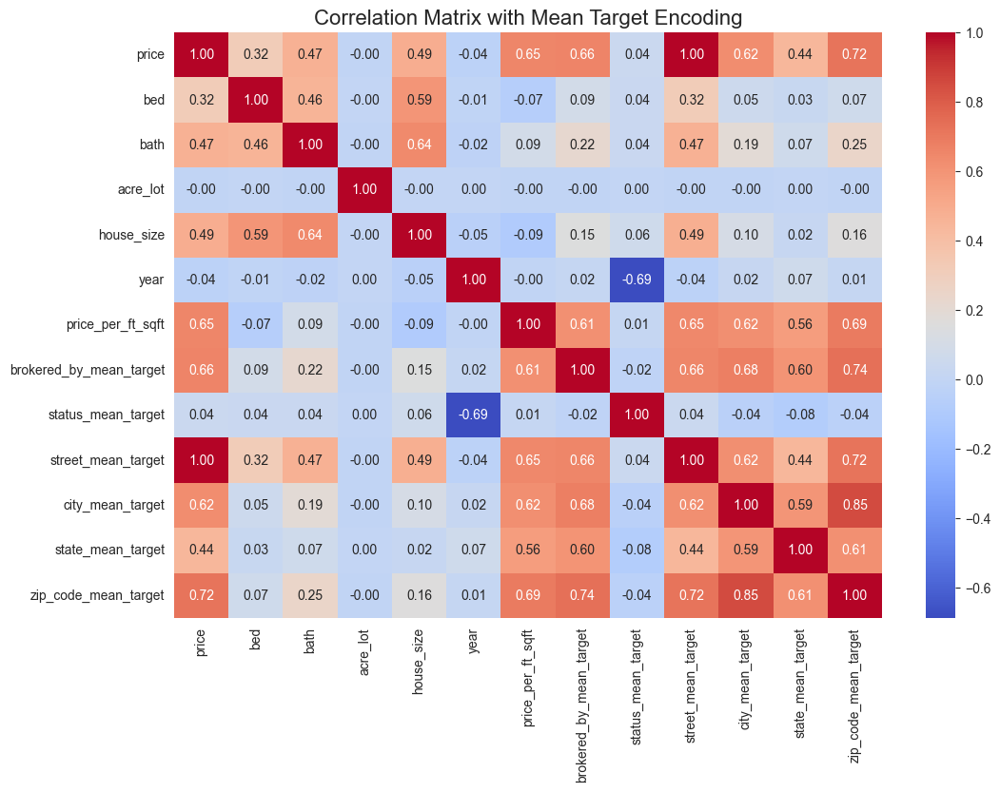

In [438]:
encoded_df = esta.copy()

# Cột mục tiêu (`price`) bạn muốn tính toán trung bình
target_col = 'price'

# Áp dụng Mean Target Encoding cho từng cột trong danh sách 'cate'
for col in cate:
    mean_target = encoded_df.groupby(col)[target_col].mean()  # Tính trung bình của cột mục tiêu
    encoded_df[f"{col}_mean_target"] = encoded_df[col].map(mean_target)  # Ánh xạ giá trị trung bình vào cột mới

# Kiểm tra kết quả mã hóa
print(encoded_df[[f"{col}_mean_target" for col in cate]].head())

# Chọn các cột dạng số để tính toán ma trận tương quan
numeric_df = encoded_df.select_dtypes(include=[np.number])  # Chỉ giữ cột số
correlation_matrix = numeric_df.corr()

# Vẽ biểu đồ heatmap tương quan
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title("Correlation Matrix with Mean Target Encoding", fontsize=16)
plt.show()


In [442]:
# Identify columns with high correlation to the 'price' column (e.g., correlation > 0.07)
high_corr = correlation_matrix['price'][correlation_matrix['price'].abs() > 0.09].index.tolist()
high_corr.remove('price')  # Exclude the 'price' column itself
print("Columns with high correlation to 'price':", high_corr)

Columns with high correlation to 'price': ['bed', 'bath', 'house_size', 'price_per_ft_sqft', 'brokered_by_mean_target', 'street_mean_target', 'city_mean_target', 'state_mean_target', 'zip_code_mean_target']


In [444]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import LabelEncoder

# Lấy các cột vị trí cần kiểm tra
location_cols = ['zip_code', 'city', 'state']

# Chuẩn bị dữ liệu cho VIF
# Nếu các cột chưa phải là số, sử dụng Label Encoding để mã hóa
encoded_df = esta.copy()
label_encoder = LabelEncoder()
for col in location_cols:
    encoded_df[col] = label_encoder.fit_transform(encoded_df[col].astype(str))

# Tính VIF
X = encoded_df[location_cols]  # Lấy DataFrame chỉ chứa các biến vị trí
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Hiển thị kết quả
print(vif_data)


   Variable       VIF
0  zip_code  2.705590
1      city  2.769627
2     state  2.324136


## Model Building

In [433]:
esta

,brokered_by,status,price,bed,bath,acre_lot,street,city,state,zip_code,house_size,prev_sold_date,year,price_per_ft_sqft
0,52270.0,for_sale,76900.0,3.0,2.0,0.23,1873083.0,Canovanas,Puerto Rico,729.0,1200.0,2020-02-28,2020.0,64.08
1,52707.0,for_sale,159000.0,3.0,2.0,0.23,1657337.0,Caguas,Puerto Rico,725.0,1625.0,2021-09-15,2021.0,97.85
2,66902.0,for_sale,380000.0,3.0,2.0,78.66,1902753.0,Yabucoa,Puerto Rico,767.0,1803.0,2021-03-15,2021.0,207.02
3,22968.0,for_sale,79500.0,3.0,2.0,0.76,765975.0,Christiansted,Virgin Islands,820.0,1803.0,2016-04-28,2016.0,207.02
4,34543.0,for_sale,176500.0,3.0,2.0,0.50,917409.0,Christiansted,Virgin Islands,820.0,1803.0,2016-11-16,2016.0,207.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
966251,53860.0,sold,310000.0,3.0,1.0,0.21,500240.0,Richland,Washington,99354.0,1152.0,2022-02-11,2022.0,269.10
966252,60631.0,sold,385000.0,4.0,2.0,0.21,210890.0,Richland,Washington,99354.0,1656.0,2022-03-28,2022.0,232.49
966253,85499.0,sold,339900.0,4.0,2.0,0.20,41160.0,Richland,Washington,99354.0,2780.0,2022-03-28,2022.0,122.27
966254,18208.0,sold,350000.0,3.0,2.0,0.10,1062149.0,Richland,Washington,99354.0,1616.0,2022-03-25,2022.0,216.58


In [432]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

# Giả sử dữ liệu đang nằm trong DataFrame esta
# Cột mục tiêu: price, Các cột category: object hoặc category
cate = esta.select_dtypes(include=['object', 'category']).columns.tolist()
target_col = esta.price

# Tách tập train và test
X = esta.drop(columns=[target_col])
y = esta[target_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Mean Target Encoding với tập train
# Tạo bản sao để giữ tập train/test riêng biệt
X_train_encoded = X_train.copy()
X_test_encoded = X_test.copy()

for col in cate:
    # Tính giá trị trung bình trên tập train
    mean_target = X_train[col].map(X_train.groupby(col)[target_col].mean())

    # Ánh xạ giá trị trung bình vào tập train
    X_train_encoded[f"{col}_mean_target"] = X_train[col].map(mean_target)

    # Ánh xạ giá trị trung bình vào tập test (nếu không có trong train thì gán giá trị trung bình của toàn train)
    global_mean = y_train.mean()  # Giá trị trung bình toàn cục
    X_test_encoded[f"{col}_mean_target"] = X_test[col].map(mean_target).fillna(global_mean)

# Loại bỏ các cột category gốc
X_train_encoded = X_train_encoded.drop(columns=cate)
X_test_encoded = X_test_encoded.drop(columns=cate)

# Huấn luyện mô hình
model = RandomForestRegressor(random_state=42)
model.fit(X_train_encoded, y_train)

# Dự đoán và đánh giá mô hình
y_pred = model.predict(X_test_encoded)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae}")


KeyError: '[(76900.0, 159000.0, 380000.0, 79500.0, 176500.0, 73400.0, 169900.0, 525000.0, 239900.0, 175000.0, 195000.0, 275000.0, 232000.0, 619900.0, 234900.0, 175000.0, 229900.0, 330000.0, 329900.0, 100000.0, 77500.0, 350000.0, 139000.0, 289900.0, 279900.0, 400000.0, 379900.0, 379900.0, 349900.0, 289900.0, 299900.0, 439500.0, 325000.0, 299900.0, 299900.0, 145000.0, 375000.0, 265000.0, 229000.0, 415000.0, 399900.0, 579900.0, 144900.0, 172500.0, 299900.0, 329000.0, 249999.0, 299900.0, 260000.0, 299900.0, 299413.0, 349900.0, 249900.0, 259000.0, 399000.0, 304900.0, 69900.0, 58000.0, 89900.0, 134500.0, 380000.0, 64000.0, 125000.0, 40000.0, 556000.0, 249900.0, 539000.0, 221000.0, 270000.0, 149900.0, 169900.0, 279000.0, 69000.0, 414900.0, 493000.0, 189900.0, 49900.0, 649900.0, 475000.0, 649000.0, 249900.0, 339900.0, 499900.0, 199900.0, 189000.0, 250000.0, 215000.0, 625000.0, 495000.0, 219900.0, 275000.0, 539900.0, 569000.0, 274900.0, 290000.0, 249900.0, 395000.0, 260000.0, 249500.0, 269900.0, 339999.0, 295000.0, 339900.0, 279900.0, 249500.0, 273000.0, 199900.0, 349900.0, 295000.0, 335000.0, 280000.0, 395000.0, 359800.0, 345000.0, 375000.0, 349900.0, 284900.0, 625000.0, 339900.0, 289900.0, 375000.0, 269900.0, 269000.0, 247900.0, 204900.0, 225000.0, 445000.0, 289000.0, 690000.0, 475000.0, 349900.0, 985000.0, 199900.0, 269900.0, 559000.0, 319700.0, 237900.0, 294900.0, 229900.0, 419900.0, 284999.0, 245000.0, 269900.0, 699900.0, 65000.0, 189000.0, 379900.0, 549900.0, 275000.0, 499900.0, 682469.0, 649000.0, 400000.0, 224550.0, 325000.0, 369000.0, 449600.0, 178000.0, 184900.0, 339900.0, 450000.0, 399900.0, 249000.0, 237500.0, 379900.0, 400000.0, 259900.0, 374900.0, 400000.0, 125000.0, 525000.0, 309900.0, 244900.0, 229000.0, 399900.0, 269900.0, 575000.0, 239900.0, 339900.0, 400000.0, 499000.0, 400000.0, 329000.0, 329900.0, 390000.0, 205000.0, 199900.0, 229900.0, 379900.0, 359000.0, 309900.0, 135000.0, 299900.0, 185000.0, 185900.0, 384900.0, 269900.0, 149500.0, 439000.0, 424900.0, 249900.0, 345000.0, 449000.0, 399000.0, 299900.0, 379000.0, 424900.0, 239000.0, 199900.0, 375000.0, 359000.0, 895000.0, 399900.0, 269900.0, 319900.0, 499000.0, 160000.0, 89900.0, 299900.0, 289900.0, 309900.0, 198000.0, 599000.0, 465000.0, 349900.0, 229900.0, 319900.0, 179950.0, 244900.0, 270000.0, 299000.0, 435000.0, 219900.0, 234900.0, 339900.0, 249900.0, 250000.0, 239000.0, 285000.0, 275000.0, 279900.0, 449000.0, 309900.0, 400000.0, 399900.0, 359999.0, 199000.0, 89000.0, 43900.0, 265000.0, 219900.0, 43000.0, 164900.0, 209900.0, 195000.0, 390000.0, 186829.0, 215000.0, 98500.0, 127500.0, 520000.0, 199900.0, 299000.0, 129900.0, 115000.0, 499000.0, 170000.0, 249900.0, 424900.0, 294900.0, 629900.0, 625000.0, 249900.0, 424900.0, 424000.0, 364900.0, 299900.0, 279900.0, 349900.0, 319900.0, 179900.0, 225000.0, 269900.0, 199900.0, 249525.0, 269900.0, 149000.0, 160000.0, 409900.0, 100000.0, 148000.0, 224900.0, 174000.0, 295000.0, 309900.0, 329900.0, 389900.0, 349900.0, 549999.0, 565000.0, 390000.0, 269000.0, 349900.0, 199999.0, 150000.0, 197000.0, 229900.0, 299900.0, 210000.0, 239900.0, 299900.0, 92000.0, 274900.0, 249900.0, 240000.0, 569900.0, 309900.0, 389900.0, 259900.0, 229900.0, 275000.0, 519900.0, 264900.0, 549900.0, 136000.0, 199900.0, 379900.0, 220000.0, 300000.0, 469900.0, 199900.0, 155000.0, 244900.0, 199900.0, 295000.0, 299900.0, 111000.0, 289900.0, 264900.0, 330000.0, 264900.0, 165000.0, 259900.0, 260000.0, 384900.0, 219900.0, 354900.0, 339900.0, 399900.0, 439000.0, 290000.0, 295000.0, 399900.0, 369000.0, 289900.0, 329900.0, 574900.0, 299900.0, 399900.0, 269900.0, 349900.0, 399000.0, 365000.0, 270000.0, 450000.0, 300000.0, 189900.0, 340000.0, 214900.0, 189900.0, 289000.0, 335000.0, 400000.0, 174000.0, 274900.0, 184900.0, 224900.0, 469900.0, 549900.0, 369900.0, 329900.0, 179900.0, 299000.0, 319900.0, 109900.0, 279900.0, 444900.0, 274900.0, 170000.0, 299900.0, 229000.0, 229900.0, 349900.0, 309900.0, 269900.0, 340000.0, 499900.0, 189900.0, 695000.0, 350000.0, 359900.0, 329900.0, 379900.0, 469999.0, 439000.0, 239000.0, 175000.0, 849900.0, 169900.0, 199000.0, 329900.0, 299000.0, 385000.0, 199000.0, 184900.0, 289900.0, 174900.0, 74900.0, 299900.0, 240000.0, 299900.0, 244900.0, 359900.0, 250000.0, 240000.0, 269000.0, 119900.0, 199000.0, 179900.0, 375000.0, 67000.0, 294999.0, 89000.0, 349900.0, 370000.0, 575000.0, 435000.0, 465000.0, 314900.0, 349900.0, 265000.0, 575000.0, 319900.0, 349900.0, 224900.0, 149000.0, 289900.0, 324500.0, 227000.0, 191000.0, 389900.0, 269900.0, 265000.0, 399000.0, 89000.0, 475000.0, 189900.0, 495000.0, 290000.0, 250000.0, 225000.0, 279900.0, 375000.0, 299900.0, 299000.0, 95000.0, 179900.0, 105000.0, 269900.0, 250000.0, 219995.0, 315000.0, 184900.0, 315000.0, 285000.0, 339900.0, 214900.0, 325000.0, 240000.0, 135000.0, 145000.0, 215000.0, 484999.0, 100000.0, 125000.0, 145000.0, 209900.0, 139000.0, 199900.0, 225000.0, 225000.0, 224900.0, 242900.0, 209900.0, 159000.0, 319900.0, 269500.0, 224900.0, 299900.0, 285000.0, 310000.0, 250000.0, 324900.0, 129900.0, 195000.0, 230000.0, 300000.0, 415000.0, 275000.0, 219000.0, 219900.0, 189900.0, 200000.0, 449900.0, 219000.0, 369900.0, 494900.0, 159000.0, 389999.0, 259900.0, 195000.0, 579900.0, 234900.0, 337900.0, 179000.0, 224900.0, 252000.0, 339999.0, 259900.0, 175000.0, 219900.0, 519900.0, 160000.0, 225000.0, 199000.0, 320000.0, 170000.0, 184900.0, 175000.0, 270000.0, 230000.0, 225000.0, 269999.0, 225000.0, 199900.0, 274900.0, 215000.0, 229900.0, 559900.0, 489000.0, 399900.0, 499900.0, 395000.0, 249525.0, 259900.0, 469000.0, 259900.0, 279900.0, 397900.0, 198500.0, 224900.0, 449900.0, 169900.0, 160000.0, 179900.0, 239900.0, 249900.0, 249000.0, 189000.0, 212000.0, 199000.0, 495000.0, 274900.0, 295000.0, 237900.0, 345000.0, 320000.0, 310000.0, 235000.0, 85000.0, 299000.0, 450000.0, 839000.0, 110000.0, 339900.0, 185000.0, 324900.0, 239999.0, 660000.0, 399000.0, 488888.0, 249900.0, 150000.0, 599000.0, 129000.0, 259900.0, 414900.0, 370000.0, 359900.0, 19900.0, 189900.0, 225000.0, 160000.0, 279900.0, 274900.0, 289000.0, 324900.0, 284900.0, 329900.0, 219900.0, 225000.0, 259000.0, 299900.0, 440000.0, 210000.0, 474900.0, 295000.0, 29900.0, 229000.0, 289900.0, 334900.0, 279900.0, 625000.0, 355000.0, 294900.0, 329000.0, 199900.0, 368000.0, 279900.0, 29900.0, 639000.0, 425000.0, 225000.0, 425000.0, 375000.0, 475000.0, 550000.0, 435000.0, 305000.0, 224500.0, 685000.0, 625000.0, 65000.0, 499000.0, 359000.0, 78500.0, 119000.0, 925000.0, 299900.0, 288500.0, 625000.0, 369900.0, 104900.0, 475000.0, 277000.0, 28000.0, 975000.0, 95000.0, 89900.0, 39900.0, 122750.0, 378000.0, 825000.0, 189900.0, 109000.0, 235000.0, 129900.0, 349900.0, 245000.0, 590000.0, 150000.0, 265000.0, 280000.0, 229900.0, 79950.0, 425000.0, 105000.0, 365000.0, 374000.0, 399000.0, 395000.0, 825000.0, 589900.0, 429999.0, 644900.0, 149900.0, 245000.0, 549000.0, 264900.0, 439900.0, 80000.0, 205000.0, 239000.0, 475000.0, 299900.0, 199000.0, 549000.0, 374800.0, 725000.0, 925000.0, 700000.0, 629000.0, 155000.0, 370000.0, 149900.0, 215000.0, 389000.0, 359900.0, 108000.0, 354900.0, 237000.0, 219999.0, 399000.0, 595000.0, 345000.0, 349900.0, 69000.0, 369000.0, 499000.0, 349900.0, 164900.0, 199900.0, 464000.0, 563900.0, 239900.0, 349900.0, 325000.0, 283900.0, 179900.0, 230000.0, 399900.0, 499000.0, 215000.0, 359900.0, 288000.0, 339900.0, 199000.0, 269900.0, 325000.0, 599000.0, 230000.0, 324900.0, 419000.0, 450000.0, 349900.0, 285500.0, 449900.0, 599000.0, 249900.0, 515000.0, 236000.0, 315000.0, 425000.0, 229900.0, 235000.0, 324900.0, 140000.0, 169000.0, 269000.0, 100000.0, 250000.0, 125000.0, 164900.0, 370000.0, 317900.0, 145000.0, 319900.0, 399900.0, 160000.0, 229000.0, 315900.0, 199900.0, 289900.0, 74900.0, 155000.0, 269900.0, 97500.0, 234900.0, 269900.0, 249000.0, 129900.0, 179900.0, 240000.0, 195900.0, 408999.0, 340000.0, 309900.0, 225000.0, 350000.0, 215000.0, 450000.0, 224900.0, 89000.0, 187500.0, 379000.0, 280000.0, 269000.0, 284900.0, 99900.0, 210000.0, 239900.0, 206000.0, 196000.0, 134900.0, 474900.0, 224900.0, 279900.0, 129000.0, 374900.0, 379900.0, 379900.0, 154900.0, 219900.0, 219900.0, 325000.0, 419900.0, 209900.0, 185000.0, 169900.0, 208000.0, 429000.0, 450000.0, 249900.0, 775000.0, 330000.0, 324000.0, 95000.0, 121900.0, 249000.0, 164000.0, 299900.0, 49000.0, 499000.0, 299000.0, 320000.0, 335900.0, 280000.0, 260000.0, 304900.0, 285000.0, 475000.0, 384900.0, 239900.0, 275000.0, 379900.0, 207500.0, 250000.0, 438000.0, 379900.0, 289000.0, 259000.0, 369900.0, 259900.0, 649900.0, 349000.0, 229900.0, 245000.0, 264900.0, 339900.0, 319900.0, 249000.0, 250000.0, 260000.0, 214900.0, 559900.0, 249900.0, 485700.0, 515000.0, 424900.0, 325000.0, 339000.0, 234900.0, 235000.0, 279900.0, 249900.0, 259900.0, 180000.0, 349900.0, 445000.0, 249900.0, 129900.0, 349900.0, 334900.0, 249900.0, 214900.0, 299900.0, 299999.0, 283995.0, 285000.0, 510000.0, 299900.0, 239900.0, 479900.0, 349900.0, 339000.0, 335000.0, 289000.0, 469900.0, 339900.0, 425000.0, 299900.0, 192000.0, 339000.0, 379900.0, 300000.0, 210000.0, 235000.0, 259900.0, 395000.0, 299900.0, 325000.0, 160000.0, 255000.0, 235000.0, 224900.0, 290000.0, 264900.0, 379900.0, 399900.0, 199000.0, 549000.0, 299999.0, 325000.0, 399999.0, 279000.0, 198000.0, 275000.0, 344900.0, 585000.0, 269000.0, 310000.0, 365000.0, 379900.0, 575000.0, 39600.0, 324900.0, 399900.0, 89000.0, 174900.0, 184900.0, 235000.0, 424900.0, 274900.0, 249900.0, 275000.0, 135000.0, 279900.0, 220000.0, 249900.0, 189900.0, 239000.0, 425000.0, 230000.0, 520000.0, 349900.0, 329900.0, 174900.0, 220000.0, 161000.0, 190000.0, 799000.0, 229900.0, 269900.0, 249900.0, 449900.0, 116900.0, 292500.0, 335000.0, 625000.0, 264900.0, 252000.0, 259900.0, 100000.0, 229000.0, 900000.0, 259900.0, 280000.0, 254900.0, 218500.0, 625000.0, 525000.0, 360000.0, 270000.0, 179900.0, 409900.0, 439900.0, 139000.0, 219900.0, 319000.0, 387000.0, 199000.0, 259900.0, 250000.0, 100000.0, 199900.0, 244125.0, 204900.0, 399900.0, 359900.0, 389900.0, 625000.0, 390000.0, 199900.0, 235000.0, 225000.0, 259900.0, 299000.0, 359000.0, 335000.0, 209900.0, 184900.0, 274900.0, 349900.0, 295000.0, 219900.0, 424900.0, 335000.0, 425000.0, 425000.0, 394000.0, 372000.0, 395000.0, 595000.0, 195000.0, 259000.0, 79000.0, 125000.0, 269000.0, 149500.0, 315000.0, 150000.0, 775000.0, 275000.0, 895000.0, 120000.0, 449500.0, 350000.0, 785000.0, 320000.0, 399000.0, 249000.0, 349500.0, 239000.0, 850000.0, 549000.0, 329900.0, 279000.0, 329000.0, 420000.0, 390000.0, 154900.0, 195000.0, 229900.0, 575000.0, 97000.0, 34900.0, 190000.0, 155000.0, 495000.0, 38000.0, 175000.0, 449000.0, 235000.0, 29900.0, 234900.0, 264000.0, 325000.0, 344900.0, 239900.0, 257500.0, 269900.0, 495000.0, 172500.0, 244000.0, 180000.0, 595000.0, 375000.0, 569000.0, 74900.0, 249000.0, 325000.0, 479900.0, 239000.0, 398900.0, 230000.0, 290000.0, 399000.0, 380000.0, 120000.0, 330000.0, 419900.0, 525000.0, 224900.0, 240000.0, 429900.0, 475000.0, 359000.0, 440000.0, 399000.0, 699000.0, 274900.0, 369900.0, 514900.0, 529875.0, 549900.0, 839000.0, 259900.0, 334000.0, 325000.0, 319900.0, 299900.0, 799999.0, 545000.0, 749900.0, 499900.0, 237500.0, 375000.0, 329900.0, 339900.0, 129999.0, 529900.0, 399000.0, 369900.0, 398000.0, 474999.0, 459900.0, 392000.0, 424900.0, 869000.0, 614900.0, 499900.0, 684900.0, 429900.0, 249000.0, 399000.0, 519900.0, 499900.0, 369900.0, 425000.0, 250000.0, 725000.0, 255000.0, 369900.0, 410000.0, 345000.0, 429900.0, 420000.0, 599000.0, 424900.0, 410000.0, 330000.0, 464900.0, 534900.0, 379900.0, 380000.0, 519000.0, 300000.0, 649900.0, 449000.0, 285000.0, 379900.0, 849900.0, 269900.0, 490000.0, 540000.0, 495000.0, 672777.0, 609900.0, 535000.0, 639000.0, 224000.0, 349900.0, 647000.0, 719000.0, 829000.0, 324900.0, 439900.0, 289800.0, 499900.0, 399000.0, 415000.0, 539900.0, 499990.0, 299000.0, 199900.0, 1000000.0, 740000.0, 485000.0, 689900.0, 659900.0, 649000.0, 399000.0, 519900.0, 499900.0, 299900.0, 155000.0, 339000.0, 349000.0, 225000.0, 599000.0, 324900.0, 219900.0, 339000.0, 239999.0, 189900.0, 299900.0, 239900.0, 225000.0, 399900.0, 449900.0, 325000.0, 535000.0, 269994.0, 325000.0, 239900.0, 235000.0, 415000.0, 399000.0, 319000.0, 550000.0, 340000.0, 324900.0, 449000.0, 575000.0, 199900.0, 49900.0, 299900.0, 369900.0, 230000.0, 239000.0, 219900.0, 239900.0, 299900.0, 699000.0, 224900.0, 319900.0, 250000.0, 399000.0, 469900.0, 500000.0, 239000.0, 469900.0, 349999.0, 525000.0, 699900.0, 349900.0, 825000.0, 899000.0, 345000.0, 449000.0, 525000.0, 444999.0, 380000.0, 149900.0, 400000.0, 209999.0, 715000.0, 190000.0, 399900.0, 190000.0, 339900.0, 349000.0, 139000.0, 285000.0, 275000.0, 259900.0, 299900.0, 499900.0, 319999.0, 499000.0, 389900.0, 269000.0, 339900.0, 325000.0, 229000.0, 359000.0, 449900.0, 187500.0, 205000.0, 230000.0, 299900.0, 199900.0, 245000.0, 239900.0, 245000.0, 305000.0, 289000.0, 569000.0, 315000.0, 39900.0, 255000.0, 179000.0, 499900.0, 1100000.0, 299999.0, 325000.0, 225000.0, 175000.0, 269000.0, 255000.0, 255000.0, 369000.0, 225000.0, 170000.0, 254900.0, 439000.0, 160000.0, 350000.0, 599900.0, 375000.0, 190000.0, 319900.0, 279900.0, 325000.0, 225000.0, 479000.0, 300000.0, 349900.0, 475000.0, 259500.0, 259900.0, 249900.0, 300000.0, 629900.0, 119900.0, 109900.0, 274900.0, 284900.0, 395000.0, 425000.0, 424977.0, 225000.0, 299900.0, 129900.0, 359900.0, 329900.0, 325000.0, 140000.0, 479900.0, 399000.0, 369900.0, 600000.0, 158000.0, 209000.0, 230000.0, 225000.0, 299900.0, 245000.0, 305000.0, 279900.0, 210000.0, 349900.0, 250000.0, 325000.0, 279000.0, 165900.0, 209900.0, 589000.0, 290000.0, 399900.0, 349900.0, 249900.0, 275000.0, 260000.0, 309000.0, 339000.0, 379900.0, 115000.0, 459900.0, 319900.0, 275000.0, 375000.0, 329000.0, 400000.0, 349000.0, 324900.0, 215000.0, 599900.0, 414900.0, 644500.0, 334900.0, 319900.0, 299999.0, 539900.0, 175000.0, 298500.0, 199000.0, 470000.0, 499000.0, 175000.0, 1050000.0, 469900.0, 197000.0, 235000.0, 115000.0, 342000.0, 289900.0, 625000.0, 429000.0, 365000.0, 294000.0, 289900.0, 384900.0, 449900.0, 484900.0, 224900.0, 399000.0, 340000.0, 360000.0, 298000.0, 369900.0, 350000.0, 419900.0, 499000.0, 289900.0, 280000.0, 249900.0, 374900.0, 384900.0, 449000.0, 779000.0, 349900.0, 549000.0, 249900.0, 415000.0, 304999.0, 240000.0, 475000.0, 285000.0, 299999.0, 340000.0, 329900.0, 239900.0, 290000.0, 579900.0, 689900.0, 295000.0, 395000.0, 224900.0, 279900.0, 674900.0, 324900.0, 280000.0, 335000.0, 359000.0, 550000.0, 474900.0, 320000.0, 339900.0, 999999.0, 329900.0, 279900.0, 325000.0, 315000.0, 319900.0, 375000.0, 324900.0, 289900.0, 325000.0, 295000.0, 489900.0, 469000.0, 375000.0, 794900.0, 409999.0, 499900.0, 169900.0, 439900.0, 289900.0, 349900.0, 315000.0, 130000.0, 424900.0, 310000.0, 475000.0, 299900.0, 439900.0, 239000.0, 430000.0, 450000.0, 449900.0, 319000.0, 380000.0, 369900.0, 325000.0, 299900.0, 319900.0, 384900.0, 349900.0, 275000.0, 330000.0, 334000.0, 350000.0, 465000.0, 339900.0, 775000.0, 449000.0, 249900.0, 274900.0, 399000.0, 299900.0, 339900.0, 439000.0, 619000.0, 425000.0, 499000.0, 299900.0, 344900.0, 469900.0, 325000.0, 324900.0, 639000.0, 230000.0, 489900.0, 329900.0, 340000.0, 317500.0, 294900.0, 400000.0, 615000.0, 325000.0, 455000.0, 349900.0, 499900.0, 650000.0, 349900.0, 429900.0, 300000.0, 269900.0, 239900.0, 400000.0, 630000.0, 345000.0, 349900.0, 259625.0, 299900.0, 249900.0, 269900.0, 379900.0, 499900.0, 689999.0, 350000.0, 199900.0, 350000.0, 229900.0, 279900.0, 451000.0, 365000.0, 639000.0, 275000.0, 319000.0, 364900.0, 324900.0, 310000.0, 599900.0, 299900.0, 249900.0, 339900.0, 379900.0, 429900.0, 559900.0, 499900.0, 275000.0, 299900.0, 375000.0, 315000.0, 365000.0, 354900.0, 439900.0, 359900.0, 324900.0, 314900.0, 200000.0, 275000.0, 600000.0, 299900.0, 385000.0, 264900.0, 335000.0, 329900.0, 284900.0, 410000.0, 299000.0, 284900.0, 350000.0, 379000.0, 849000.0, 329900.0, 599000.0, 275000.0, 165000.0, 228500.0, 259900.0, 299900.0, 869000.0, 355000.0, 299000.0, 267000.0, 389000.0, 689000.0, 334000.0, 474900.0, 429900.0, 365000.0, 188500.0, 299900.0, 669000.0, 879000.0, 485000.0, 749900.0, 359900.0, 275000.0, 570000.0, 347500.0, 299900.0, 379000.0, 299900.0, 389000.0, 429900.0, 309900.0, 349900.0, 399900.0, 384900.0, 205500.0, 479900.0, 325000.0, 398900.0, 525000.0, 695000.0, 279900.0, 359900.0, 385000.0, 379900.0, 349900.0, 250000.0, 325000.0, 299900.0, 499900.0, 415000.0, 424900.0, 360000.0, 300000.0, 375000.0, 589900.0, 495000.0, 479000.0, 315000.0, 275000.0, 379000.0, 475000.0, 599000.0, 375000.0, 749000.0, 399900.0, 334900.0, 590000.0, 299900.0, 389900.0, 395000.0, 310000.0, 235000.0, 350000.0, 399900.0, 379900.0, 569000.0, 275000.0, 245000.0, 300000.0, 323900.0, 499900.0, 385000.0, 339000.0, 300000.0, 629000.0, 499900.0, 315000.0, 450000.0, 310000.0, 520000.0, 569900.0, 299900.0, 350000.0, 525000.0, 282500.0, 350000.0, 270000.0, 299000.0, 379000.0, 349900.0, 325000.0, 415000.0, 295000.0, 320000.0, 600000.0, 339900.0, 320000.0, 239000.0, 349900.0, 309900.0, 330000.0, 279900.0, 499900.0, 257500.0, 249900.0, 699000.0, 349900.0, 475000.0, 689000.0, 205900.0, 335000.0, 925000.0, 715000.0, 325000.0, 424900.0, 309000.0, 320000.0, 280000.0, 342500.0, 435000.0, 250000.0, 599000.0, 369900.0, 335000.0, 179000.0, 240000.0, 324900.0, 399900.0, 419000.0, 299900.0, 308512.0, 370000.0, 469900.0, 389000.0, 379900.0, 299900.0, 775000.0, 299000.0, 349000.0, 360000.0, 265000.0, 220000.0, 239000.0, 379000.0, 329900.0, 349900.0, 369999.0, 379000.0, 315000.0, 259900.0, 725000.0, 325000.0, 279900.0, 375000.0, 350000.0, 895000.0, 675000.0, 309000.0, 289000.0, 379900.0, 785000.0, 328000.0, 439000.0, 370000.0, 354900.0, 545000.0, 359000.0, 849900.0, 999000.0, 319000.0, 469000.0, 360000.0, 649900.0, 319000.0, 349900.0, 299000.0, 539900.0, 264000.0, 329000.0, 325000.0, 399900.0, 284900.0, 375000.0, 302000.0, 599900.0, 559900.0, 859999.0, 399000.0, 524900.0, 359999.0, 449000.0, 550000.0, 619900.0, 719900.0, 610000.0, 549990.0, 749900.0, 485000.0, 719900.0, 869000.0, 729000.0, 279900.0, 560500.0, 459000.0, 449000.0, 399900.0, 525000.0, 749000.0, 599000.0, 459900.0, 269000.0, 475000.0, 620000.0, 899900.0, 950000.0, 714900.0, 312000.0, 475000.0, 599000.0, 498000.0, 659000.0, 578000.0, 519000.0, 415000.0, 489900.0, 869000.0, 519900.0, 399000.0, 339000.0, 699900.0, 529900.0, 250000.0, 265000.0, 629000.0, 285000.0, 349900.0, 399000.0, 259000.0, 289900.0, 409000.0, 354900.0, 450000.0, 329000.0, 319900.0, 399900.0, 389000.0, 425000.0, 399900.0, 179900.0, 409900.0, 624900.0, 399900.0, 499000.0, 353000.0, 489900.0, 449900.0, 324900.0, 799900.0, 330000.0, 365000.0, 424900.0, 550000.0, 459000.0, 519900.0, 150000.0, 799000.0, 399900.0, 372000.0, 749000.0, 347900.0, 649900.0, 625000.0, 419900.0, 799900.0, 349900.0, 525000.0, 535000.0, 660000.0, 785000.0, 509000.0, 699000.0, 659000.0, 499000.0, 515000.0, 579000.0, 405000.0, 345000.0, 572000.0, 535000.0, 295000.0, 539900.0, 309974.0, 589000.0, 599000.0, 900000.0, 999000.0, 465000.0, 290000.0, 299999.0, 449000.0, 739900.0, 575000.0, 309000.0, 535000.0, 425000.0, 709900.0, 489900.0, 875000.0, 327000.0, 319900.0, 524900.0, 489000.0, 379900.0, 349000.0, 599000.0, 599000.0, 398000.0, 474900.0, 439900.0, 396000.0, 929000.0, 550000.0, 895000.0, 219900.0, 489900.0, 259900.0, 389000.0, 339000.0, 339000.0, 489000.0, 189000.0, 725000.0, 628400.0, 299900.0, 500000.0, 300000.0, 310000.0, 179000.0, 399900.0, 294900.0, 325000.0, 399000.0, 319900.0, 375000.0, 535000.0, 499000.0, 525000.0, 525000.0, 390000.0, 349000.0, 229900.0, 795000.0, 549000.0, 775000.0, 390000.0, 339900.0, 549000.0, 359000.0, 295000.0, 299000.0, 444000.0, 285000.0, 209900.0, 339000.0, 334500.0, 359000.0, 179000.0, 199900.0, 169900.0, 385000.0, 695000.0, 399000.0, 425000.0, 149000.0, 149000.0, 399000.0, 579000.0, 499900.0, 310000.0, 150000.0, 650000.0, 399900.0, 299000.0, 550000.0, 625000.0, 274900.0, 355000.0, 340000.0, 639000.0, 339000.0, 519900.0, 530000.0, 350000.0, 499000.0, 415000.0, 389500.0, 375000.0, 389900.0, 679000.0, 194500.0, 429000.0, 667500.0, 599900.0, 369000.0, 265000.0, 475000.0, 295500.0, 325000.0, 868000.0, 279900.0, 434000.0, 239000.0, 529000.0, 499000.0, 429900.0, 199000.0, 635000.0, 349900.0, 559900.0, 990000.0, 699500.0, 350000.0, 375000.0, 380000.0, 749000.0, 349999.0, 599000.0, 435000.0, 259900.0, 227900.0, 389000.0, 419900.0, 324900.0, 370000.0, 780000.0, 339900.0, 379000.0, 454000.0, 60000.0, 295000.0, 510000.0, 659000.0, 549000.0, 598000.0, 550000.0, 299923.0, 589000.0, 335000.0, 675000.0, 749000.0, 949000.0, 985000.0, 749000.0, 905000.0, 799000.0, 1049000.0, 895000.0, 489000.0, 449000.0, 549000.0, 250000.0, 399900.0, 495000.0, 299000.0, 695000.0, 450000.0, 345000.0, 289000.0, 750000.0, 474900.0, 385000.0, 429900.0, 699900.0, 599900.0, 679900.0, 543000.0, 620000.0, 429000.0, 350000.0, 700000.0, 360000.0, 569000.0, 119900.0, 114900.0, 69000.0, 469900.0, 357900.0, 389900.0, 109500.0, 109500.0, 109500.0, 550000.0, 275000.0, 525000.0, 399900.0, 389000.0, 549000.0, 459000.0, 265000.0, 329000.0, 459000.0, 537000.0, 385000.0, 445000.0, 429000.0, 664900.0, 545000.0, 369000.0, 949500.0, 875000.0, 250000.0, 265000.0, 375000.0, 279900.0, 499900.0, 899000.0, 399900.0, 99000.0, 265000.0, 574995.0, 549000.0, 497000.0, 699000.0, 559000.0, 989900.0, 260000.0, 395000.0, 319900.0, 220000.0, 405000.0, 353900.0, 379900.0, 244000.0, 525000.0, 250000.0, 449900.0, 995000.0, 289000.0, 360000.0, 425000.0, 260000.0, 415000.0, 359900.0, 535000.0, 195000.0, 585000.0, 779000.0, 649900.0, 499900.0, 179900.0, 309000.0, 649000.0, 495000.0, 469900.0, 300000.0, 825000.0, 319000.0, 459900.0, 969900.0, 335000.0, 329900.0, 419000.0, 625000.0, 295000.0, 189900.0, 475000.0, 489900.0, 345900.0, 550000.0, 184900.0, 124000.0, 649900.0, 325000.0, 175000.0, 329000.0, 319900.0, 239900.0, 415000.0, 219000.0, 425000.0, 59900.0, 319900.0, 459900.0, 442000.0, 299000.0, 99000.0, 50000.0, 169900.0, 279900.0, 74900.0, 29900.0, 135000.0, 70000.0, 375000.0, 179900.0, 219995.0, 499900.0, 120000.0, 60000.0, 349900.0, 199900.0, 125000.0, 235000.0, 989000.0, 219900.0, 279000.0, 159900.0, 349900.0, 240000.0, 849900.0, 99900.0, 375000.0, 309900.0, 284000.0, 299999.0, 409900.0, 325000.0, 300000.0, 45000.0, 248900.0, 329000.0, 190000.0, 438000.0, 259000.0, 349900.0, 252000.0, 120000.0, 210000.0, 299900.0, 264900.0, 469000.0, 400000.0, 119900.0, 265000.0, 349000.0, 329900.0, 165000.0, 249900.0, 275000.0, 249900.0, 145000.0, 59900.0, 169900.0, 87000.0, 45000.0, 255000.0, 249900.0, 314900.0, 226500.0, 235000.0, 299900.0, 600000.0, 305000.0, 599900.0, 499900.0, 1050000.0, 829000.0, 699000.0, 275000.0, 275000.0, 395000.0, 325000.0, 449800.0, 719000.0, 299900.0, 125000.0, 219900.0, 389900.0, 275000.0, 399900.0, 199000.0, 219000.0, 249900.0, 149900.0, 530000.0, 830000.0, 369900.0, 495000.0, 129900.0, 349900.0, 765000.0, 535000.0, 295000.0, 535000.0, 219900.0, 389900.0, 159900.0, 349900.0, 475000.0, 170000.0, 264900.0, 359000.0, 325000.0, 159500.0, 199000.0, 605000.0, 799900.0, 469900.0, 609900.0, 479900.0, 324900.0, 564900.0, 184721.0, 415000.0, 549900.0, 469900.0, 649900.0, 539900.0, 620000.0, 440000.0, 899900.0, 469900.0, 479000.0, 674900.0, 475000.0, 399900.0, 120000.0, 500000.0, 229900.0, 280000.0, 210000.0, 36900.0, 299900.0, 459000.0, 369000.0, 629900.0, 144900.0, 425000.0, 289900.0, 375000.0, 369900.0, 649900.0, 449900.0, 449900.0, 349900.0, 355000.0, 449900.0, 749900.0, 374900.0, 489900.0, 360000.0, 209900.0, 389000.0, 359500.0, 319000.0, 310000.0, 260000.0, 319000.0, 299900.0, 330000.0, 399900.0, 189900.0, 248000.0, 349000.0, 499900.0, 425000.0, 515000.0, 349900.0, 295000.0, 299900.0, 360000.0, 739999.0, 399900.0, 475000.0, 275000.0, 449900.0, 299900.0, 435000.0, 379900.0, 330000.0, 419900.0, 324900.0, 279900.0, 599000.0, 324900.0, 200000.0, 400000.0, 60000.0, 699900.0, 369000.0, 400000.0, 355000.0, 410000.0, 729900.0, 449999.0, 279000.0, 259900.0, 469500.0, 525000.0, 585000.0, 450000.0, 269900.0, 800000.0, 350000.0, 788000.0, 369900.0, 344900.0, 399000.0, 429000.0, 850000.0, 799000.0, 899000.0, 150000.0, 349900.0, 239900.0, 340000.0, 354900.0, 180000.0, 574900.0, 499900.0, 274900.0, 229900.0, 265000.0, 479900.0, 159900.0, 225000.0, 469900.0, 149900.0, 429900.0, 365000.0, 450000.0, 425000.0, 349000.0, 454900.0, 410000.0, 349900.0, 225000.0, 265000.0, 250000.0, 250000.0, 109900.0, 299900.0, 289900.0, 299900.0, 365000.0, 159900.0, 105000.0, 350000.0, 135000.0, 165000.0, 175000.0, 69900.0, 330000.0, 478000.0, 225900.0, 239900.0, 675000.0, 480000.0, 748000.0, 399900.0, 824000.0, 299995.0, 499000.0, 750000.0, 179800.0, 231637.0, 260000.0, 328000.0, 295000.0, 275000.0, 225000.0, 439900.0, 249000.0, 399900.0, 350000.0, 349900.0, 395000.0, 635000.0, 299900.0, 695000.0, 1095000.0, 340000.0, 325000.0, 299000.0, 30000.0, 321000.0, 249000.0, 280000.0, 435000.0, 299000.0, 409900.0, 509000.0, 98800.0, 570000.0, 549000.0, 899017.0, 429900.0, 99500.0, 395000.0, 340000.0, 315000.0, 369000.0, 275000.0, 65000.0, 264900.0, 625000.0, 179900.0, 325000.0, 345000.0, 599000.0, 899000.0, 725000.0, 325000.0, 399000.0, 699900.0, 159000.0, 334900.0, 599900.0, 929900.0, 555000.0, 430000.0, 499900.0, 564900.0, 439900.0, 695000.0, 395000.0, 85000.0, 289000.0, 425000.0, 485000.0, 449000.0, 334900.0, 259000.0, 299900.0, 499000.0, 499000.0, 459000.0, 449000.0, 300000.0, 475000.0, 160000.0, 299900.0, 62500.0, 335000.0, 390000.0, 614999.0, 389900.0, 549000.0, 85000.0, 149000.0, 150000.0, 205000.0, 425000.0, 199900.0, 265000.0, 175000.0, 250000.0, 220000.0, 399000.0, 339000.0, 249000.0, 149900.0, 370000.0, 379000.0, 339000.0, 950000.0, 945000.0, 94900.0, 695000.0, 199000.0, 292500.0, 170000.0, 100000.0, 80000.0, 90000.0, 140000.0, 359000.0, 75000.0, 28000.0, 239000.0, 145000.0, 185000.0, 149000.0, 40000.0, 229000.0, 159000.0, 325000.0, 399900.0, 64900.0, 250000.0, 400000.0, 279000.0, 330000.0, 419000.0, 190000.0, 365000.0, 369900.0, 159500.0, 369900.0, 360000.0, 130000.0, 429000.0, 495000.0, 335000.0, 629900.0, 328000.0, 159000.0, 138500.0, 184999.0, 99000.0, 149900.0, 219900.0, 224900.0, 135000.0, 147500.0, 139900.0, 130000.0, 230000.0, 400000.0, 205000.0, 379900.0, 224900.0, 299900.0, 325000.0, 99500.0, 179900.0, 264900.0, 379900.0, 325000.0, 409900.0, 319000.0, 279000.0, 30000.0, 55900.0, 298000.0, 129000.0, 225000.0, 325000.0, 179000.0, 237500.0, 479000.0, 249000.0, 269000.0, 89000.0, 198000.0, 58000.0, 143000.0, 245000.0, 148900.0, 159000.0, 459000.0, 59950.0, 125000.0, 69900.0, 185000.0, 239000.0, 485000.0, 549000.0, 229000.0, 487500.0, 175000.0, 180000.0, 479900.0, 315000.0, 325000.0, 325000.0, 259000.0, 995000.0, 369000.0, 239000.0, 329000.0, 77000.0, 485000.0, 329500.0, 91500.0, 450000.0, 200000.0, 689000.0, 549000.0, 799000.0, 320000.0, 849900.0, 310000.0, 65000.0, 629000.0, 315000.0, 274000.0, 125000.0, 369000.0, 777000.0, 240000.0, 749900.0, 599900.0, 412000.0, 389000.0, 689000.0, 559000.0, 395000.0, 185500.0, 849900.0, 450000.0, 299900.0, 349900.0, 365000.0, 599900.0, 155000.0, 439000.0, 450000.0, 415000.0, 239900.0, 360000.0, 100000.0, 349000.0, 259000.0, 178600.0, 225000.0, 279900.0, 299900.0, 295000.0, 399900.0, 415000.0, 489000.0, 299900.0, 429000.0, 475000.0, 450000.0, 849900.0, 450000.0, 649000.0, 499000.0, 399900.0, 375000.0, 400000.0, 325000.0, 375000.0, 690000.0, 385000.0, 425000.0, 469000.0, 875000.0, 199000.0, 296000.0, 275000.0, 225000.0, 229900.0, 285000.0, 234900.0, 625000.0, 310000.0, 479000.0, 379995.0, 450000.0, 519990.0, 700000.0, 615000.0, 350000.0, 339000.0, 369900.0, 375000.0, 499000.0, 275000.0, 750000.0, 815000.0, 375000.0, 449900.0, 275000.0, 285000.0, 289000.0, 419000.0, 815000.0, 365000.0, 695000.0, 439000.0, 150000.0, 425000.0, 299900.0, 260000.0, 319900.0, 345000.0, 275000.0, 219000.0, 350000.0, 205000.0, 715000.0, 340000.0, 329900.0, 549000.0, 425000.0, 210000.0, 399900.0, 399900.0, 739000.0, 39900.0, 229900.0, 729000.0, 255000.0, 417312.0, 199000.0, 335000.0, 275000.0, 195000.0, 205000.0, 20000.0, 124900.0, 345000.0, 249000.0, 50000.0, 499900.0, 320000.0, 154900.0, 100000.0, 260000.0, 300000.0, 299900.0, 69000.0, 99900.0, 289000.0, 215000.0, 275000.0, 249900.0, 415000.0, 450000.0, 289900.0, 195000.0, 215000.0, 210000.0, 399900.0, 225000.0, 359000.0, 189000.0, 209900.0, 275000.0, 298000.0, 239900.0, 245000.0, 25000.0, 425000.0, 475000.0, 399900.0, 989000.0, 179900.0, 85000.0, 125000.0, 295000.0, 772000.0, 975000.0, 185000.0, 238000.0, 160000.0, 79900.0, 309999.0, 385000.0, 204900.0, 189900.0, 210000.0, 134900.0, 320000.0, 115000.0, 379900.0, 320900.0, 285000.0, 170000.0, 169900.0, 75000.0, 156000.0, 275000.0, 450000.0, 259000.0, 429900.0, 400000.0, 559000.0, 349900.0, 325000.0, 120000.0, 125000.0, 500000.0, 337000.0, 49900.0, 184900.0, 399000.0, 24900.0, 359900.0, 399222.0, 289900.0, 139900.0, 238900.0, 115000.0, 119900.0, 30000.0, 25000.0, 369000.0, 499000.0, 649000.0, 175000.0, 289000.0, 190000.0, 325000.0, 285000.0, 319000.0, 87500.0, 95000.0, 85000.0, 90000.0, 574900.0, 215000.0, 65000.0, 164900.0, 139900.0, 259000.0, 355000.0, 189900.0, 165000.0, 455000.0, 479900.0, 950000.0, 94500.0, 347000.0, 249900.0, 279000.0, 219900.0, 189900.0, 269900.0, 239000.0, 230000.0, 380000.0, 525000.0, 320000.0, 113000.0, 205000.0, 339900.0, 199900.0, 259000.0, 450000.0, 800000.0, 525000.0, 89500.0, 145000.0, 175000.0, 299000.0, 489500.0, 350000.0, 155000.0, 55000.0, 225000.0, 395000.0, 950000.0, 79900.0, 239000.0, 275000.0, 224900.0, 166000.0, 285000.0, 775000.0, 715000.0, 360000.0, 849900.0, 450000.0, 289000.0, 259000.0, 175000.0, 335000.0, 315000.0, 299900.0, 225000.0, 229900.0, 350000.0, 315000.0, 479000.0, 300000.0, 209900.0, 187500.0, 154900.0, 400000.0, 399000.0, 389000.0, 699000.0, 140000.0, 169000.0, 629000.0, 499000.0, 349000.0, 127125.0, 350000.0, 269900.0, 269000.0, 199000.0, 359900.0, 149000.0, 59900.0, 24900.0, 105000.0, 350000.0, 39900.0, 159000.0, 67500.0, 250000.0, 68000.0, 148000.0, 325000.0, 205000.0, 215000.0, 75000.0, 188500.0, 79900.0, 189900.0, 244900.0, 174000.0, 155000.0, 430000.0, 275000.0, 300000.0, 172900.0, 59000.0, 268000.0, 244900.0, 189000.0, 219900.0, 274900.0, 164900.0, 225000.0, 139000.0, 239900.0, 45900.0, 350000.0, 264900.0, 189900.0, 212000.0, 209900.0, 149900.0, 249000.0, 279900.0, 279900.0, 205000.0, 249900.0, 177000.0, 165000.0, 260000.0, 175000.0, 289900.0, 329000.0, 530000.0, 495000.0, 269000.0, 149999.0, 174900.0, 49900.0, 599000.0, 599000.0, 749000.0, 949000.0, 379000.0, 235000.0, 620000.0, 585000.0, 675000.0, 335000.0, 550000.0, 600000.0, 499000.0, 625000.0, 429000.0, 292500.0, 895000.0, 650000.0, 385000.0, 385000.0, 263000.0, 272800.0, 369000.0, 359900.0, 399900.0, 280000.0, 328000.0, 499000.0, 169000.0, 219000.0, 285000.0, 149900.0, 269000.0, 325000.0, 450000.0, 525000.0, 749000.0, 299000.0, 129000.0, 85000.0, 90000.0, 168000.0, 348000.0, 239900.0, 249000.0, 150000.0, 439900.0, 355000.0, 101500.0, 138500.0, 490225.0, 164500.0, 399900.0, 369000.0, 239953.0, 279900.0, 159900.0, 179900.0, 238500.0, 725000.0, 481705.0, 219000.0, 224900.0, 120000.0, 49900.0, 116000.0, 179900.0, 229900.0, 249500.0, 80000.0, 255000.0, 195000.0, 329000.0, 249900.0, 89900.0, 189000.0, 210000.0, 249000.0, 525000.0, 139900.0, 155000.0, 169900.0, 134900.0, 280000.0, 170000.0, 289900.0, 259900.0, 145995.0, 415000.0, 229995.0, 175000.0, 167000.0, 69000.0, 149900.0, 145000.0, 169900.0, 345000.0, 75000.0, 215000.0, 289000.0, 149900.0, 98000.0, 299000.0, 329000.0, 300000.0, 375000.0, 90000.0, 329000.0, 399900.0, 235000.0, 255000.0, 349000.0, 649000.0, 269000.0, 199000.0, 95000.0, 124900.0, 169900.0, 164500.0, 130000.0, 205000.0, 165000.0, 225000.0, 122000.0, 495000.0, 198000.0, 550000.0, 149000.0, 389000.0, 858500.0, 650000.0, 100000.0, 499000.0, 264900.0, 89900.0, 119900.0, 189000.0, 199000.0, 199000.0, 75000.0, 339900.0, 152900.0, 179000.0, 535000.0, 329900.0, 240000.0, 369900.0, 695000.0, 629999.0, 165000.0, 415000.0, 400000.0, 319000.0, 99000.0, 99000.0, 119000.0, 149000.0, 165000.0, 179000.0, 345000.0, 250000.0, 315000.0, 349000.0, 180000.0, 639000.0, 499900.0, 89900.0, 204000.0, 174950.0, 85000.0, 84500.0, 33000.0, 200000.0, 285000.0, 279900.0, 74900.0, 289000.0, 299000.0, 305000.0, 279900.0, 99900.0, 129900.0, 307900.0, 485000.0, 199900.0, 199900.0, 192500.0, 425000.0, 89000.0, 235000.0, 225000.0, 249000.0, 149000.0, 28000.0, 279000.0, 454000.0, 185000.0, 155000.0, 600000.0, 94900.0, 149900.0, 400000.0, 395000.0, 185000.0, 540000.0, 348900.0, 109900.0, 105000.0, 230000.0, 629000.0, 289900.0, 245000.0, 219900.0, 164900.0, 244900.0, 107000.0, 389000.0, 255000.0, 274900.0, 239900.0, 89900.0, 249900.0, 619900.0, 259900.0, 320000.0, 399900.0, 479900.0, 229900.0, 229900.0, 138000.0, 149609.0, 219900.0, 259900.0, 279900.0, 298000.0, 299900.0, 374900.0, 295000.0, 209900.0, 299999.0, 152000.0, 299900.0, 264900.0, 292000.0, 210900.0, 239900.0, 379900.0, 168900.0, 299000.0, 334900.0, 299900.0, 174900.0, 240000.0, 184900.0, 589900.0, 349000.0, 359000.0, 399000.0, 150000.0, 145000.0, 259900.0, 274900.0, 559900.0, 749900.0, 699000.0, 720000.0, 99900.0, 150000.0, 559000.0, 475000.0, 258000.0, 849900.0, 199000.0, 194900.0, 249900.0, 164900.0, 350000.0, 128000.0, 144995.0, 225000.0, 579900.0, 250000.0, 189000.0, 349999.0, 829000.0, 299900.0, 190000.0, 305000.0, 299900.0, 259000.0, 310000.0, 325000.0, 299999.0, 299000.0, 210000.0, 230000.0, 799000.0, 555000.0, 260000.0, 249900.0, 280000.0, 379900.0, 339900.0, 369000.0, 795000.0, 280000.0, 245000.0, 525000.0, 189900.0, 364900.0, 199900.0, 359900.0, 240000.0, 278855.0, 325000.0, 239900.0, 349999.0, 169900.0, 515000.0, 279900.0, 249900.0, 339000.0, 214999.0, 219900.0, 409900.0, 299900.0, 599000.0, 190000.0, 489975.0, 205000.0, 339900.0, 199900.0, 569900.0, 525000.0, 335000.0, 260000.0, 349900.0, 215200.0, 459000.0, 209900.0, 99900.0, 465900.0, 699900.0, 549000.0, 209900.0, 459000.0, 389900.0, 249000.0, 389900.0, 114900.0, 210000.0, 499900.0, 385000.0, 499900.0, 510000.0, 519900.0, 542900.0, 425000.0, 819900.0, 199000.0, 299000.0, 260000.0, 350000.0, 325000.0, 200000.0, 295000.0, 265000.0, 550000.0, 389000.0, 450000.0, 589000.0, 155000.0, 224900.0, 245000.0, 335000.0, 258855.0, 199900.0, 259900.0, 129000.0, 639900.0, 389000.0, 299900.0, 89000.0, 394500.0, 199500.0, 224000.0, 355000.0, 449900.0, 289900.0, 265000.0, 399000.0, 200000.0, 249900.0, 540000.0, 649900.0, 350000.0, 173000.0, 340000.0, 429000.0, 175000.0, 175000.0, 309000.0, 265900.0, 249900.0, 199000.0, 180000.0, 269900.0, 319900.0, 475000.0, 269900.0, 849000.0, 339900.0, 149000.0, 499900.0, 304000.0, 439000.0, 424900.0, 249900.0, 275000.0, 279000.0, 259000.0, 525000.0, 459900.0, 409000.0, 49000.0, 489900.0, 297000.0, 209900.0, 399900.0, 330000.0, 399900.0, 314900.0, 359900.0, 374900.0, 132500.0, 400000.0, 179999.0, 289900.0, 250000.0, 245000.0, 249900.0, 359999.0, 179900.0, 269900.0, 350000.0, 229900.0, 399000.0, 624000.0, 409000.0, 359900.0, 475000.0, 340000.0, 299000.0, 350000.0, 299900.0, 445000.0, 179900.0, 475000.0, 250000.0, 370000.0, 269000.0, 289900.0, 289900.0, 349900.0, 649900.0, 660000.0, 349000.0, 825000.0, 185000.0, 500000.0, 249900.0, 269900.0, 425000.0, 310000.0, 238000.0, 375000.0, 319900.0, 329000.0, 279900.0, 699999.0, 829900.0, 349900.0, 250000.0, 549000.0, 320000.0, 199900.0, 439900.0, 329900.0, 488000.0, 225000.0, 524000.0, 229900.0, 289900.0, 628000.0, 424900.0, 199900.0, 354000.0, 374000.0, 287500.0, 349000.0, 579000.0, 339900.0, 265000.0, 349900.0, 264900.0, 300000.0, 450000.0, 225000.0, 372000.0, 285000.0, 400000.0, 299900.0, 379900.0, 425000.0, 399900.0, 261000.0, 198000.0, 290000.0, 379000.0, 157900.0, 299900.0, 249900.0, 349900.0, 263000.0, 409900.0, 198000.0, 369500.0, 244900.0, 389900.0, 305000.0, 275000.0, 399000.0, 299000.0, 250000.0, 389900.0, 348800.0, 210000.0, 515000.0, 285900.0, 420000.0, 190000.0, 225905.0, 309000.0, 259000.0, 275000.0, 599900.0, 285000.0, 249000.0, 284900.0, 250000.0, 270000.0, 290000.0, 86500.0, 310000.0, 299900.0, 249900.0, 319999.0, 378000.0, 99900.0, 190000.0, 289900.0, 184900.0, 194900.0, 264900.0, 325000.0, 169900.0, 220000.0, 149900.0, 295000.0, 359900.0, 239500.0, 363000.0, 327000.0, 339999.0, 315000.0, 225000.0, 244999.0, 249900.0, 239000.0, 55000.0, 200500.0, 275000.0, 279900.0, 325000.0, 229900.0, 143000.0, 199500.0, 199000.0, 300000.0, 164900.0, 125000.0, 169900.0, 259900.0, 399999.0, 219900.0, 154900.0, 199000.0, 290000.0, 189500.0, 350000.0, 249900.0, 220000.0, 385000.0, 245000.0, 239900.0, 199900.0, 165000.0, 399999.0, 180000.0, 259900.0, 279000.0, 310000.0, 449000.0, 289000.0, 292500.0, 239000.0, 270000.0, 595000.0, 249900.0, 199900.0, 475000.0, 399500.0, 479900.0, 189900.0, 225000.0, 269900.0, 222000.0, 299900.0, 249900.0, 139000.0, 225000.0, 189900.0, 525000.0, 269900.0, 299000.0, 249900.0, 289900.0, 269999.0, 265000.0, 245000.0, 189900.0, 249900.0, 325000.0, 369000.0, 270000.0, 194900.0, 225000.0, 350000.0, 125000.0, 399900.0, 189000.0, 475000.0, 195000.0, 325000.0, 249900.0, 399000.0, 274900.0, 320000.0, 239000.0, 125000.0, 305000.0, 269900.0, 285000.0, 410000.0, 174999.0, 239900.0, 199900.0, 325000.0, 179900.0, 745000.0, 230000.0, 279900.0, 339000.0, 289900.0, 159900.0, 199000.0, 130000.0, 350000.0, 129995.0, 129000.0, 179000.0, 749000.0, 498000.0, 299900.0, 304900.0, 249900.0, 319000.0, 279900.0, 300000.0, 518888.0, 669000.0, 449900.0, 265000.0, 275000.0, 180000.0, 179900.0, 289000.0, 129900.0, 374900.0, 224900.0, 95000.0, 849900.0, 609900.0, 189995.0, 350000.0, 249000.0, 159900.0, 189900.0, 145000.0, 325000.0, 375000.0, 269900.0, 289900.0, 195000.0, 245000.0, 149900.0, 399900.0, 300000.0, 219999.0, 675000.0, 299900.0, 345000.0, 214900.0, 169000.0, 285900.0, 349000.0, 549900.0, 359900.0, 575000.0, 195000.0, 275000.0, 219000.0, 624900.0, 300000.0, 299999.0, 299900.0, 425000.0, 299900.0, 399900.0, 385000.0, 399900.0, 309900.0, 699900.0, 299900.0, 275000.0, 429900.0, 279900.0, 310000.0, 619900.0, 280000.0, 375000.0, 209000.0, 474900.0, 234900.0, 179000.0, 335000.0, 449900.0, 219900.0, 169900.0, 220000.0, 434900.0, 197000.0, 209900.0, 199999.0, 239000.0, 339500.0, 172500.0, 259900.0, 359000.0, 65000.0, 349900.0, 264900.0, 465500.0, 175000.0, 329000.0, 249900.0, 235000.0, 249900.0, 399500.0, 59900.0, 99900.0, 300000.0, 665000.0, 199000.0, 225000.0, 203000.0, 405000.0, 230000.0, 399000.0, 359000.0, 69000.0, 156000.0, 199900.0, 745000.0, 449900.0, 220000.0, 219900.0, 235000.0, 199000.0, 129900.0, 30000.0, 82000.0, 313500.0, 265000.0, 99900.0, 179900.0, 224900.0, 259900.0, 118000.0, 299900.0, 279900.0, 369900.0, 134900.0, 335000.0, 262500.0, 179900.0, 229900.0, 260000.0, 276500.0, 249000.0, 299900.0, 250000.0, 234000.0, 299999.0, 347700.0, 165000.0, 175000.0, 220000.0, 294900.0, 249900.0, 199900.0, 340000.0, 469900.0, 175000.0, 142500.0, 289900.0, 324900.0, 260000.0, 250000.0, 335000.0, 243000.0, 289900.0, 275000.0, 400000.0, 144900.0, 259900.0, 215000.0, 369000.0, 245000.0, 270000.0, 225000.0, 175000.0, 300000.0, 699000.0, 249900.0, 750000.0, 325000.0, 389000.0, 375000.0, 255000.0, 379900.0, 289000.0, 344900.0, 299900.0, 295000.0, 255000.0, 249900.0, 299999.0, 565000.0, 369900.0, 399900.0, 325000.0, 214900.0, 385000.0, 189900.0, 144900.0, 139900.0, 419900.0, 149900.0, 579000.0, 469000.0, 559000.0, 648500.0, 359900.0, 103900.0, 55000.0, 675000.0, 205000.0, 125000.0, 139000.0, 519000.0, 420000.0, 269000.0, 195000.0, 212000.0, 199900.0, 299999.0, 99900.0, 659000.0, 449900.0, 299000.0, 275000.0, 729000.0, 399000.0, 450000.0, 549000.0, 659000.0, 689000.0, 570000.0, 450000.0, 135000.0, 125000.0, 629000.0, 319900.0, 369900.0, 855000.0, 339900.0, 225000.0, 550000.0, 129900.0, 599000.0, 99900.0, 199500.0, 595000.0, 225000.0, 559900.0, 310000.0, 400000.0, 189000.0, 249900.0, 239900.0, 180000.0, 659000.0, 289900.0, 119900.0, 219900.0, 159000.0, 179900.0, 249900.0, 175000.0, 596800.0, 545000.0, 685000.0, 209900.0, 180000.0, 185000.0, 419900.0, 150000.0, 695000.0, 459900.0, 399000.0, 449000.0, 499900.0, 699900.0, 305000.0, 359900.0, 330000.0, 439900.0, 359000.0, 649999.0, 144995.0, 144995.0, 199000.0, 150000.0, 499900.0, 375000.0, 469900.0, 425000.0, 349000.0, 699900.0, 599900.0, 350000.0, 499900.0, 369000.0, 669000.0, 749999.0, 479000.0, 349000.0, 225000.0, 549900.0, 589000.0, 739900.0, 389900.0, 559900.0, 359900.0, 369000.0, 379900.0, 429000.0, 549900.0, 749900.0, 439000.0, 800000.0, 529900.0, 150000.0, 625000.0, 659900.0, 489900.0, 525000.0, 524900.0, 435000.0, 94900.0, 799000.0, 140000.0, 310000.0, 209999.0, 399900.0, 499900.0, 425000.0, 389900.0, 385000.0, 429900.0, 589500.0, 459000.0, 279900.0, 335000.0, 419900.0, 350000.0, 565000.0, 899900.0, 849900.0, 250000.0, 339000.0, 240000.0, 219000.0, 799000.0, 538000.0, 309900.0, 549000.0, 699000.0, 699000.0, 825000.0, 699000.0, 399900.0, 649900.0, 585500.0, 839900.0, 419000.0, 849000.0, 239900.0, 474900.0, 199999.0, 524900.0, 159000.0, 174900.0, 189900.0, 159900.0, 405000.0, 125000.0, 419900.0, 449900.0, 1100000.0, 659900.0, 469000.0, 489900.0, 449000.0, 895000.0, 849000.0, 379900.0, 420000.0, 425000.0, 390000.0, 650000.0, 549900.0, 129900.0, 520000.0, 470000.0, 719000.0, 649900.0, 799000.0, 425000.0, 525000.0, 489900.0, 435000.0, 699000.0, 385000.0, 625000.0, 549999.0, 389000.0, 384999.0, 550000.0, 425000.0, 779000.0, 499900.0, 700000.0, 459000.0, 679000.0, 739900.0, 769900.0, 429900.0, 380000.0, 989000.0, 399999.0, 487900.0, 599900.0, 899000.0, 314999.0, 315000.0, 424900.0, 530000.0, 309000.0, 449000.0, 265000.0, 315000.0, 419900.0, 245000.0, 389900.0, 50000.0, 204900.0, 224900.0, 249900.0, 515000.0, 473000.0, 649888.0, 519000.0, 565000.0, 125000.0, 199900.0, 279000.0, 275000.0, 300000.0, 199000.0, 539000.0, 185500.0, 315000.0, 238000.0, 159000.0, 489000.0, 185000.0, 359000.0, 175000.0, 265000.0, 310000.0, 229000.0, 299900.0, 150000.0, 250000.0, 320000.0, 320000.0, 429900.0, 320000.0, 164999.0, 69900.0, 278800.0, 545000.0, 215000.0, 349000.0, 449900.0, 485000.0, 525000.0, 659000.0, 749000.0, 875000.0, 339900.0, 359900.0, 165000.0, 345000.0, 229900.0, 280000.0, 280000.0, 279900.0, 299000.0, 225000.0, 279900.0, 274900.0, 324900.0, 184900.0, 299000.0, 120000.0, 185000.0, 300000.0, 799999.0, 499000.0, 285000.0, 275000.0, 195000.0, 165000.0, 274900.0, 279900.0, 279900.0, 279900.0, 199900.0, 220000.0, 350000.0, 259900.0, 440000.0, 314000.0, 300000.0, 209000.0, 499900.0, 376000.0, 279000.0, 369900.0, 239500.0, 899900.0, 185000.0, 685000.0, 480000.0, 230000.0, 249000.0, 304900.0, 219900.0, 439900.0, 265000.0, 440000.0, 339500.0, 125000.0, 329000.0, 399000.0, 429900.0, 189000.0, 210000.0, 460000.0, 137500.0, 499900.0, 330000.0, 589900.0, 260000.0, 335000.0, 344900.0, 419000.0, 619900.0, 239900.0, 299000.0, 399000.0, 224900.0, 549900.0, 349900.0, 360000.0, 599000.0, 199000.0, 249500.0, 175000.0, 479000.0, 325000.0, 229000.0, 249900.0, 449900.0, 169000.0, 334000.0, 299900.0, 570000.0, 375000.0, 474900.0, 238000.0, 475000.0, 369900.0, 365000.0, 340500.0, 209000.0, 285000.0, 465000.0, 699000.0, 100000.0, 525000.0, 345000.0, 299900.0, 459900.0, 225000.0, 399900.0, 399500.0, 265000.0, 379900.0, 389900.0, 479000.0, 265000.0, 345000.0, 275000.0, 399000.0, 529000.0, 270000.0, 339000.0, 419900.0, 439900.0, 295000.0, 244900.0, 169000.0, 325800.0, 370000.0, 405000.0, 335000.0, 469900.0, 429000.0, 319900.0, 220000.0, 349000.0, 525000.0, 429900.0, 185000.0, 369900.0, 347000.0, 469900.0, 414900.0, 365000.0, 259900.0, 159900.0, 250000.0, 299000.0, 245000.0, 369900.0, 269900.0, 475000.0, 165000.0, 185000.0, 275000.0, 310000.0, 284900.0, 489900.0, 355000.0, 575000.0, 464900.0, 225000.0, 475000.0, 215000.0, 448000.0, 290000.0, 330000.0, 407600.0, 495900.0, 399900.0, 350000.0, 449000.0, 280000.0, 319000.0, 450000.0, 479900.0, 275000.0, 399000.0, 499900.0, 420000.0, 535000.0, 212000.0, 159900.0, 201234.0, 235000.0, 269000.0, 339000.0, 450000.0, 120000.0, 380000.0, 629000.0, 72900.0, 149900.0, 120000.0, 187000.0, 169900.0, 390000.0, 177500.0, 119900.0, 119900.0, 119000.0, 399000.0, 399000.0, 689000.0, 335000.0, 279900.0, 519000.0, 785000.0, 549000.0, 449000.0, 275000.0, 565000.0, 399900.0, 310000.0, 339900.0, 185000.0, 169999.0, 169900.0, 789000.0, 499000.0, 625000.0, 799900.0, 574900.0, 624900.0, 130000.0, 339000.0, 300000.0, 525000.0, 759000.0, 649000.0, 425000.0, 154900.0, 269900.0, 342000.0, 749900.0, 359900.0, 249900.0, 316000.0, 274900.0, 449000.0, 260000.0, 235900.0, 259000.0, 349900.0, 900000.0, 469900.0, 430000.0, 995000.0, 389000.0, 759000.0, 325000.0, 599900.0, 445000.0, 399000.0, 555000.0, 746000.0, 689000.0, 295000.0, 695000.0, 145000.0, 189900.0, 149900.0, 359900.0, 424995.0, 60000.0, 495000.0, 420000.0, 505000.0, 289900.0, 390000.0, 59000.0, 329000.0, 259900.0, 435000.0, 499000.0, 385000.0, 349900.0, 475000.0, 379000.0, 449900.0, 640000.0, 270000.0, 299999.0, 290000.0, 665000.0, 575731.0, 559999.0, 370000.0, 439000.0, 439900.0, 364000.0, 488500.0, 699999.0, 75000.0, 275000.0, 85000.0, 265000.0, 850000.0, 797000.0, 280000.0, 234000.0, 435000.0, 369900.0, 449000.0, 629000.0, 619000.0, 319000.0, 589900.0, 533330.0, 449888.0, 269000.0, 315000.0, 279900.0, 465000.0, 699000.0, 450000.0, 475000.0, 410000.0, 679000.0, 114900.0, 239000.0, 350000.0, 325000.0, 519999.0, 360000.0, 229000.0, 475000.0, 350000.0, 749000.0, 375000.0, 649000.0, 580000.0, 399999.0, 489900.0, 439999.0, 329000.0, 120000.0, 849900.0, 779000.0, 199999.0, 599000.0, 439000.0, 519900.0, 375000.0, 424900.0, 775000.0, 390000.0, 295000.0, 449000.0, 375000.0, 449900.0, 389900.0, 285000.0, 325000.0, 439000.0, 385000.0, 565000.0, 849900.0, 329000.0, 399900.0, 580000.0, 409000.0, 549000.0, 289000.0, 680000.0, 575000.0, 739000.0, 350000.0, 279000.0, 594000.0, 275000.0, 396000.0, 189000.0, 639000.0, 419000.0, 439900.0, 414900.0, 519000.0, 425000.0, 495000.0, 349999.0, 649000.0, 389900.0, 359900.0, 439000.0, 569900.0, 383500.0, 435000.0, 209900.0, 369900.0, 160000.0, 530000.0, 589000.0, 334000.0, 419000.0, 299000.0, 375000.0, 299900.0, 425000.0, 795500.0, 275000.0, 179900.0, 609000.0, 409999.0, 699900.0, 430000.0, 299900.0, 779000.0, 739900.0, 375000.0, 565000.0, 380000.0, 529900.0, 465000.0, 84500.0, 129900.0, 190000.0, 799000.0, 549980.0, 669000.0, 449000.0, 649990.0, 515000.0, 169900.0, 255000.0, 325000.0, 350000.0, 670000.0, 390000.0, 799000.0, 80000.0, 80000.0, 850000.0, 400000.0, 445000.0, 565000.0, 239000.0, 424500.0, 425000.0, 399000.0, 890000.0, 220000.0, 350000.0, 335000.0, 449000.0, 875000.0, 550000.0, 540000.0, 300000.0, 585000.0, 325000.0, 325000.0, 285000.0, 550000.0, 799000.0, 369000.0, 389000.0, 389999.0, 449000.0, 849900.0, 667000.0, 474900.0, 399990.0, 360000.0, 629999.0, 549999.0, 475000.0, 349000.0, 549990.0, 475000.0, 339990.0, 650000.0, 192500.0, 399000.0, 400000.0, 300000.0, 439900.0, 439000.0, 399000.0, 460000.0, 399999.0, 639000.0, 379000.0, 549996.0, 110000.0, 689000.0, 349999.0, 549990.0, 399000.0, 529999.0, 629000.0, 850000.0, 299990.0, 389000.0, 639000.0, 435000.0, 675000.0, 595000.0, 499900.0, 789000.0, 325000.0, 699888.0, 395000.0, 399990.0, 424999.0, 589990.0, 499999.0, 499990.0, 393000.0, 440000.0, 599000.0, 529000.0, 439000.0, 699000.0, 685000.0, 479000.0, 799000.0, 847900.0, 449000.0, 625000.0, 450000.0, 475000.0, 799000.0, 499999.0, 599000.0, 334900.0, 469000.0, 579000.0, 390000.0, 510000.0, 439000.0, 414999.0, 549000.0, 499900.0, 825000.0, 599000.0, 449000.0, 399000.0, 599000.0, 380000.0, 499900.0, 509000.0, 479000.0, 499900.0, 799000.0, 449000.0, 674999.0, 599999.0, 579990.0, 549000.0, 649990.0, 549000.0, 499999.0, 699000.0, 359990.0, 475000.0, 699000.0, 649999.0, 624990.0, 359000.0, 390000.0, 599990.0, 710000.0, 499999.0, 649000.0, 519900.0, 499000.0, 349000.0, 439990.0, 599000.0, 499990.0, 419000.0, 329000.0, 399000.0, 528000.0, 475000.0, 729000.0, 699999.0, 599000.0, 649000.0, 699990.0, 669000.0, 334990.0, 389990.0, 325000.0, 550000.0, 759000.0, 610000.0, 324999.0, 479000.0, 629000.0, 660000.0, 499999.0, 669000.0, 549000.0, 799000.0, 425000.0, 400000.0, 369999.0, 389900.0, 799000.0, 889999.0, 575000.0, 729000.0, 399000.0, 599000.0, 599000.0, 374999.0, 475000.0, 379900.0, 599990.0, 499900.0, 449987.0, 489000.0, 489000.0, 400000.0, 679000.0, 375000.0, 449990.0, 429000.0, 629000.0, 539000.0, 514999.0, 389000.0, 419000.0, 679000.0, 579000.0, 809000.0, 529000.0, 975000.0, 739000.0, 549000.0, 679000.0, 499000.0, 449900.0, 749999.0, 379999.0, 519000.0, 687500.0, 400000.0, 649000.0, 569000.0, 469990.0, 399990.0, 599999.0, 590000.0, 619900.0, 479999.0, 449999.0, 453500.0, 799000.0, 714900.0, 997095.0, 538000.0, 349990.0, 599990.0, 389000.0, 349900.0, 650000.0, 699000.0, 599999.0, 449000.0, 479000.0, 749888.0, 479990.0, 315000.0, 419000.0, 399000.0, 779000.0, 195000.0, 289900.0, 159000.0, 389900.0, 975000.0, 489500.0, 599500.0, 239000.0, 320000.0, 299900.0, 675000.0, 500000.0, 559999.0, 650000.0, 1050000.0, 530000.0, 1095000.0, 144999.0, 249900.0, 219000.0, 259900.0, 449000.0, 319000.0, 589000.0, 399000.0, 640000.0, 849000.0, 799900.0, 669000.0, 375000.0, 419000.0, 170000.0, 599000.0, 620000.0, 399900.0, 829000.0, 589900.0, 500000.0, 699000.0, 540000.0, 525000.0, 990000.0, 825000.0, 519900.0, 900000.0, 815000.0, 355000.0, 409900.0, 579000.0, 299000.0, 429000.0, 925000.0, 429999.0, 565000.0, 545000.0, 465000.0, 589000.0, 495000.0, 629500.0, 649900.0, 259000.0, 335000.0, 625000.0, 375000.0, 759000.0, 749000.0, 439000.0, 495000.0, 325000.0, 605000.0, 699000.0, 479500.0, 899000.0, 529800.0, 575000.0, 1100000.0, 455000.0, 420000.0, 825000.0, 600000.0, 449000.0, 1049000.0, 475000.0, 599000.0, 675000.0, 675000.0, 925000.0, 650000.0, 485000.0, 750000.0, 450000.0, 749000.0, 525000.0, 499000.0, 799000.0, 585000.0, 296000.0, 400000.0, 925000.0, 599000.0, 597000.0, 799000.0, 689900.0, 549000.0, 1049000.0, 219900.0, 559900.0, 599000.0, 684900.0, 460000.0, 249000.0, 529000.0, 619900.0, 315000.0, 720000.0, 310000.0, 845000.0, 825000.0, 839000.0, 1099000.0, 399000.0, 449000.0, 815000.0, 899000.0, 899000.0, 1059000.0, 615000.0, 525000.0, 410000.0, 260000.0, 529000.0, 400000.0, 795000.0, 699000.0, 595000.0, 405000.0, 587000.0, 385000.0, 415000.0, 599000.0, 619000.0, 239000.0, 419000.0, 599000.0, 725000.0, 399000.0, 219000.0, 325000.0, 465000.0, 294000.0, 799000.0, 225000.0, 579000.0, 599000.0, 390000.0, 525000.0, 639000.0, 755000.0, 530000.0, 725000.0, 850000.0, 368000.0, 479900.0, 550000.0, 400000.0, 899900.0, 479000.0, 549900.0, 825000.0, 499000.0, 649000.0, 559990.0, 649000.0, 450000.0, 540000.0, 749000.0, 459000.0, 199000.0, 875000.0, 775000.0, 539000.0, 535000.0, 849000.0, 790000.0, 549000.0, 599000.0, 749900.0, 679000.0, 316000.0, 675000.0, 499000.0, 799900.0, 265000.0, 615000.0, 499000.0, 499000.0, 960000.0, 1099000.0, 194500.0, 495000.0, 739000.0, 739000.0, 550000.0, 950000.0, 895000.0, 365000.0, 399000.0, 729000.0, 750000.0, 959000.0, 410000.0, 269999.0, 415000.0, 469000.0, 635000.0, 425000.0, 475000.0, 599990.0, 1025000.0, 975000.0, 845000.0, 795000.0, 787500.0, 610000.0, 360000.0, 380000.0, 399000.0, 349900.0, 469000.0, 305100.0, 479000.0, 440000.0, 484000.0, 425000.0, 525000.0, 329000.0, 325000.0, 799900.0, 409000.0, 349900.0, 415000.0, 524999.0, 350000.0, 795000.0, 460000.0, 495000.0, 650000.0, 629000.0, 420000.0, 370000.0, 299000.0, 499000.0, 579000.0, 575000.0, 410000.0, 379888.0, 439999.0, 400000.0, 524000.0, 425000.0, 749000.0, 589000.0, 385000.0, 550000.0, 379900.0, 420000.0, 764900.0, 570000.0, 475000.0, 699900.0, 695000.0, 355000.0, 875000.0, 399900.0, 474900.0, 669500.0, 675000.0, 599000.0, 678000.0, 349900.0, 350000.0, 595000.0, 399999.0, 355000.0, 325000.0, 619000.0, 700000.0, 335000.0, 495000.0, 599000.0, 470000.0, 365000.0, 425000.0, 385900.0, 359000.0, 449988.0, 359000.0, 271000.0, 399000.0, 369900.0, 459000.0, 395000.0, 559000.0, 450000.0, 475000.0, 424000.0, 599000.0, 645000.0, 650000.0, 675000.0, 395000.0, 389000.0, 728000.0, 479000.0, 595000.0, 220000.0, 599000.0, 549000.0, 420000.0, 450000.0, 625000.0, 365000.0, 230000.0, 850000.0, 245000.0, 350000.0, 299000.0, 399999.0, 639000.0, 415000.0, 829000.0, 599000.0, 595000.0, 499000.0, 899900.0, 589000.0, 645000.0, 489900.0, 459000.0, 628888.0, 599000.0, 448000.0, 800000.0, 459000.0, 509000.0, 649000.0, 569999.0, 599900.0, 489999.0, 599900.0, 499000.0, 399000.0, 449000.0, 499999.0, 699000.0, 799000.0, 400000.0, 434900.0, 575000.0, 625000.0, 769000.0, 399999.0, 899000.0, 650000.0, 594500.0, 425000.0, 374900.0, 509000.0, 499000.0, 389900.0, 269000.0, 359900.0, 639900.0, 925000.0, 975000.0, 589000.0, 725000.0, 439000.0, 775000.0, 599000.0, 625000.0, 569000.0, 750000.0, 248995.0, 390000.0, 265000.0, 299000.0, 247256.0, 270000.0, 325000.0, 399000.0, 399000.0, 459000.0, 374900.0, 289999.0, 180000.0, 399000.0, 395000.0, 459000.0, 449000.0, 759000.0, 252000.0, 649000.0, 878000.0, 949500.0, 595000.0, 899900.0, 999000.0, 980000.0, 890000.0, 679000.0, 475000.0, 399000.0, 679000.0, 385000.0, 424900.0, 529999.0, 599998.0, 475000.0, 379000.0, 469000.0, 699000.0, 719900.0, 400000.0, 490000.0, 559900.0, 750000.0, 799000.0, 789000.0, 975000.0, 750000.0, 399000.0, 479900.0, 450000.0, 675000.0, 479000.0, 635000.0, 519000.0, 869000.0, 420000.0, 359900.0, 329000.0, 250000.0, 520000.0, 499000.0, 549000.0, 355000.0, 519900.0, 425000.0, 799000.0, 397700.0, 489000.0, 399000.0, 210000.0, 560000.0, 679000.0, 838000.0, 749000.0, 949000.0, 379000.0, 599000.0, 899000.0, 550000.0, 635000.0, 625000.0, 615000.0, 850000.0, 749999.0, 549900.0, 789000.0, 724999.0, 389000.0, 539000.0, 345000.0, 489999.0, 679000.0, 589000.0, 729000.0, 625000.0, 479900.0, 499000.0, 530000.0, 698000.0, 385000.0, 369000.0, 549000.0, 385000.0, 949000.0, 897000.0, 530000.0, 340000.0, 899000.0, 398000.0, 879000.0, 569000.0, 948000.0, 699000.0, 548000.0, 525000.0, 625000.0, 719000.0, 879000.0, 349000.0, 380000.0, 180999.0, 299900.0, 489000.0, 375000.0, 510000.0, 400000.0, 450000.0, 448000.0, 399000.0, 630000.0, 265000.0, 649000.0, 499000.0, 49999.0, 175000.0, 649900.0, 700000.0, 450000.0, 325000.0, 289000.0, 319900.0, 395000.0, 525000.0, 595000.0, 175000.0, 286000.0, 425000.0, 399000.0, 474900.0, 524999.0, 435000.0, 365900.0, 349900.0, 520000.0, 395000.0, 399900.0, 595000.0, 387500.0, 535000.0, 369000.0, 450000.0, 579900.0, 575000.0, 750000.0, 550000.0, 1095000.0, 759900.0, 649000.0, 325000.0, 325000.0, 250000.0, 488800.0, 565000.0, 539000.0, 599900.0, 480000.0, 489900.0, 899000.0, 950000.0, 779000.0, 799999.0, 899000.0, 935000.0, 420000.0, 689000.0, 445000.0, 399000.0, 685000.0, 799000.0, 755000.0, 250000.0, 379000.0, 565000.0, 340000.0, 500000.0, 899000.0, 798000.0, 549000.0, 725000.0, 769000.0, 500000.0, 675000.0, 529900.0, 425000.0, 425000.0, 484000.0, 499000.0, 279990.0, 549000.0, 759000.0, 444999.0, 549000.0, 589000.0, 395000.0, 550000.0, 629000.0, 598900.0, 649900.0, 580000.0, 699000.0, 299000.0, 649000.0, 689999.0, 149000.0, 449000.0, 299000.0, 329000.0, 325000.0, 599900.0, 175000.0, 774999.0, 245000.0, 719000.0, 525000.0, 515000.0, 374900.0, 550000.0, 269999.0, 1100000.0, 699000.0, 675000.0, 105000.0, 399000.0, 800000.0, 949000.0, 849000.0, 449000.0, 339900.0, 699000.0, 630000.0, 575000.0, 559000.0, 348000.0, 255000.0, 937500.0, 649000.0, 408000.0, 699000.0, 499000.0, 445000.0, 595000.0, 749000.0, 739000.0, 499900.0, 1100000.0, 479999.0, 579999.0, 449900.0, 399000.0, 560000.0, 529000.0, 589500.0, 1095000.0, 160000.0, 415000.0, 299000.0, 350000.0, 825000.0, 149999.0, 325000.0, 499000.0, 475000.0, 550000.0, 258000.0, 479000.0, 585000.0, 374990.0, 449900.0, 200000.0, 299000.0, 369995.0, 585000.0, 648000.0, 675000.0, 729000.0, 999000.0, 310000.0, 599000.0, 618000.0, 360000.0, 725000.0, 475000.0, 500000.0, 420000.0, 165000.0, 455000.0, 415000.0, 624000.0, 400000.0, 359000.0, 249000.0, 547000.0, 475000.0, 799000.0, 769000.0, 895000.0, 425000.0, 765000.0, 999000.0, 850000.0, 449000.0, 425000.0, 425000.0, 749000.0, 694000.0, 325000.0, 359000.0, 575000.0, 349900.0, 460000.0, 299000.0, 399000.0, 340000.0, 519900.0, 199000.0, 739000.0, 359000.0, 589000.0, 1085000.0, 425000.0, 518000.0, 380000.0, 479000.0, 730000.0, 829000.0, 335000.0, 998000.0, 649999.0, 975000.0, 209000.0, 775000.0, 580000.0, 495000.0, 669999.0, 950000.0, 969000.0, 449999.0, 800000.0, 799000.0, 1100000.0, 450000.0, 439000.0, 1049000.0, 625000.0, 575000.0, 349000.0, 195000.0, 675000.0, 459000.0, 899000.0, 960000.0, 399000.0, 479900.0, 700000.0, 358000.0, 385000.0, 275000.0, 589000.0, 799000.0, 690000.0, 835000.0, 625000.0, 399900.0, 649000.0, 449000.0, 449000.0, 750000.0, 569000.0, 629000.0, 830000.0, 485000.0, 579900.0, 289000.0, 599988.0, 375000.0, 499000.0, 491000.0, 275000.0, 378888.0, 599000.0, 540000.0, 230000.0, 499500.0, 989000.0, 915000.0, 699000.0, 675000.0, 699000.0, 275000.0, 625000.0, 525000.0, 685000.0, 175000.0, 699000.0, 1099000.0, 264999.0, 410000.0, 369000.0, 199000.0, 789900.0, 250000.0, 479000.0, 464000.0, 459000.0, 199000.0, 550000.0, 1099000.0, 350000.0, 599000.0, 579000.0, 474900.0, 540000.0, 650000.0, 290000.0, 695000.0, 437300.0, 525000.0, 423250.0, 629000.0, 929000.0, 845000.0, 895000.0, 499900.0, 410000.0, 530000.0, 395000.0, 699000.0, 315000.0, 585000.0, 499000.0, 275000.0, 449900.0, 799000.0, 799000.0, 595000.0, 1045000.0, 890000.0, 230000.0, 580000.0, 799000.0, 599000.0, 779500.0, 550000.0, 695000.0, 779000.0, 550000.0, 550000.0, 775000.0, 340000.0, 369900.0, 595000.0, 629900.0, 715000.0, 329900.0, 339888.0, 425000.0, 274900.0, 220000.0, 539999.0, 775000.0, 700000.0, 649999.0, 792000.0, 435000.0, 399000.0, 699000.0, 590000.0, 455000.0, 459000.0, 599000.0, 699999.0, 550000.0, 569000.0, 289000.0, 490000.0, 625000.0, 350000.0, 675000.0, 574500.0, 545000.0, 875000.0, 450000.0, 649000.0, 329999.0, 575000.0, 349000.0, 299000.0, 299500.0, 299000.0, 659000.0, 474900.0, 399999.0, 235000.0, 625000.0, 479000.0, 435000.0, 775000.0, 825000.0, 459000.0, 650000.0, 999888.0, 429000.0, 499000.0, 588800.0, 778000.0, 748000.0, 575000.0, 549000.0, 600000.0, 499999.0, 499000.0, 379999.0, 439900.0, 549000.0, 699999.0, 549900.0, 549900.0, 499000.0, 450000.0, 580000.0, 479000.0, 450000.0, 549000.0, 349900.0, 575000.0, 1099000.0, 749000.0, 990000.0, 1075000.0, 849000.0, 225000.0, 420000.0, 499999.0, 689000.0, 929000.0, 725000.0, 509000.0, 649000.0, 455000.0, 299000.0, 409000.0, 435000.0, 310000.0, 485000.0, 789000.0, 439900.0, 449000.0, 625000.0, 825000.0, 629000.0, 276900.0, 369000.0, 499999.0, 260000.0, 698880.0, 449000.0, 379900.0, 449000.0, 399000.0, 849000.0, 895000.0, 449000.0, 389000.0, 450000.0, 749000.0, 535000.0, 499000.0, 700000.0, 419900.0, 599000.0, 689900.0, 349000.0, 549000.0, 689900.0, 629000.0, 730000.0, 744000.0, 400000.0, 449000.0, 799000.0, 685000.0, 398000.0, 749000.0, 400000.0, 349900.0, 375000.0, 670000.0, 690000.0, 525000.0, 729000.0, 489900.0, 849000.0, 400000.0, 749000.0, 689000.0, 550000.0, 821000.0, 799000.0, 999000.0, 799000.0, 849900.0, 729000.0, 549999.0, 479900.0, 775000.0, 500000.0, 775000.0, 495000.0, 449900.0, 849999.0, 275000.0, 999999.0, 675000.0, 385000.0, 250000.0, 549999.0, 990000.0, 549000.0, 395000.0, 349900.0, 762000.0, 950000.0, 849000.0, 829000.0, 539000.0, 665000.0, 529000.0, 649000.0, 519000.0, 829000.0, 739000.0, 425000.0, 569000.0, 729500.0, 549999.0, 479900.0, 465000.0, 629900.0, 589000.0, 489999.0, 775000.0, 1040000.0, 499900.0, 925000.0, 960000.0, 995000.0, 725000.0, 950000.0, 419000.0, 430000.0, 498800.0, 675000.0, 1095000.0, 329000.0, 399000.0, 389000.0, 815000.0, 364999.0, 800000.0, 549000.0, 425000.0, 900000.0, 380000.0, 689000.0, 585000.0, 599000.0, 929000.0, 599900.0, 425000.0, 344000.0, 499000.0, 349900.0, 469000.0, 395000.0, 550000.0, 550000.0, 269900.0, 260000.0, 295000.0, 360000.0, 99000.0, 469900.0, 487000.0, 380000.0, 127500.0, 449000.0, 340000.0, 500000.0, 425000.0, 234900.0, 699000.0, 450000.0, 334888.0, 675000.0, 365000.0, 350000.0, 399999.0, 400000.0, 499900.0, 234900.0, 338997.0, 500000.0, 499000.0, 825000.0, 449900.0, 889000.0, 639000.0, 550000.0, 1099000.0, 230000.0, 369900.0, 549900.0, 275000.0, 189900.0, 359900.0, 499900.0, 765000.0, 699999.0, 260000.0, 485000.0, 599000.0, 589000.0, 349000.0, 255000.0, 450000.0, 479000.0, 959500.0, 499900.0, 434000.0, 265000.0, 299999.0, 489000.0, 385000.0, 589000.0, 509000.0, 355000.0, 389900.0, 425000.0, 474800.0, 579000.0, 499000.0, 449000.0, 270000.0, 300000.0, 289000.0, 279000.0, 399900.0, 145000.0, 450000.0, 346000.0, 399999.0, 278000.0, 689000.0, 449500.0, 500000.0, 399000.0, 425000.0, 739000.0, 489900.0, 499000.0, 389000.0, 425000.0, 529500.0, 329000.0, 629000.0, 850000.0, 249990.0, 449000.0, 475000.0, 889000.0, 573000.0, 475000.0, 500000.0, 549000.0, 299950.0, 280000.0, 240000.0, 599000.0, 579990.0, 399900.0, 199995.0, 459900.0, 400000.0, 829000.0, 285000.0, 459000.0, 724900.0, 359900.0, 899000.0, 349999.0, 205000.0, 450000.0, 499000.0, 549000.0, 425000.0, 619000.0, 649000.0, 369000.0, 545000.0, 599000.0, 699000.0, 750000.0, 845000.0, 349900.0, 459000.0, 562000.0, 405000.0, 635000.0, 230000.0, 810000.0, 449900.0, 401000.0, 985000.0, 693000.0, 925000.0, 549999.0, 475000.0, 440000.0, 459900.0, 420000.0, 899000.0, 560000.0, 688000.0, 399900.0, 299000.0, 595000.0, 329000.0, 499000.0, 769000.0, 299900.0, 269900.0, 539000.0, 339999.0, 355000.0, 510000.0, 500000.0, 580000.0, 899000.0, 849000.0, 354900.0, 355000.0, 285000.0, 515000.0, 579000.0, 799900.0, 965000.0, 615000.0, 325000.0, 425000.0, 810000.0, 489000.0, 355000.0, 425000.0, 119000.0, 354000.0, 885000.0, 340000.0, 898800.0, 400000.0, 585000.0, 489900.0, 540000.0, 850000.0, 895000.0, 498000.0, 399900.0, 505000.0, 629000.0, 535000.0, 289900.0, 350000.0, 550000.0, 799000.0, 599999.0, 660000.0, 419999.0, 229000.0, 435000.0, 379000.0, 359000.0, 799000.0, 620000.0, 475000.0, 448000.0, 899000.0, 694800.0, 430000.0, 350000.0, 485000.0, 949000.0, 395000.0, 434900.0, 485000.0, 579000.0, 700000.0, 347887.0, 395000.0, 499000.0, 379900.0, 725000.0, 495000.0, 150000.0, 415000.0, 575000.0, 425000.0, 155000.0, 699113.0, 699000.0, 499999.0, 520000.0, 699000.0, 475000.0, 390000.0, 290000.0, 399000.0, 299900.0, 299000.0, 299999.0, 489000.0, 559999.0, 300000.0, 235000.0, 530000.0, 550000.0, 649000.0, 439000.0, 339000.0, 539000.0, 683800.0, 635000.0, 469000.0, 350000.0, 284999.0, 450000.0, 320000.0, 989000.0, 409000.0, 389000.0, 849000.0, 529000.0, 405000.0, 699900.0, 425000.0, 489000.0, 995000.0, 849900.0, 364900.0, 445000.0, 489000.0, 629000.0, 724999.0, 485000.0, 305000.0, 479000.0, 110000.0, 597000.0, 549000.0, 639000.0, 650000.0, 839900.0, 198950.0, 499900.0, 425000.0, 499000.0, 799000.0, 910000.0, 293589.0, 385000.0, 949000.0, 375000.0, 649900.0, 384900.0, 540000.0, 525000.0, 649999.0, 699000.0, 619000.0, 980000.0, 1095000.0, 379000.0, 515988.0, 959900.0, 350000.0, 750000.0, 400000.0, 849000.0, 499900.0, 435000.0, 789000.0, 599000.0, 379900.0, 285000.0, 535000.0, 525000.0, 589000.0, 350000.0, 310000.0, 559000.0, 999000.0, 695000.0, 240000.0, 299999.0, 649000.0, 469900.0, 300000.0, 699000.0, 660000.0, 449900.0, 489000.0, 600000.0, 975000.0, 365000.0, 850000.0, 645000.0, 499900.0, 320000.0, 248995.0, 739000.0, 450000.0, 739000.0, 470000.0, 135000.0, 849000.0, 769000.0, 1050000.0, 999999.0, 545000.0, 549000.0, 199900.0, 698500.0, 415000.0, 999999.0, 249995.0, 260000.0, 599000.0, 379000.0, 139900.0, 399000.0, 350000.0, 500000.0, 375000.0, 349900.0, 599000.0, 395000.0, 465000.0, 489000.0, 850000.0, 375000.0, 498000.0, 375000.0, 539000.0, 599000.0, 799000.0, 424900.0, 625000.0, 339000.0, 375000.0, 343000.0, 360000.0, 639000.0, 959000.0, 575000.0, 645000.0, 385000.0, 339000.0, 499000.0, 679000.0, 550000.0, 439900.0, 379000.0, 299900.0, 999999.0, 325000.0, 879999.0, 600000.0, 469900.0, 540000.0, 379000.0, 510000.0, 599000.0, 729000.0, 849900.0, 889900.0, 254900.0, 450000.0, 439700.0, 299950.0, 799000.0, 529000.0, 949000.0, 464999.0, 439000.0, 474999.0, 279000.0, 469000.0, 379000.0, 599999.0, 470000.0, 549000.0, 470000.0, 435000.0, 599900.0, 395000.0, 364000.0, 675000.0, 899000.0, 995000.0, 650000.0, 275000.0, 369000.0, 600000.0, 419900.0, 725000.0, 575000.0, 699000.0, 650000.0, 747500.0, 369000.0, 235000.0, 619999.0, 560000.0, 725500.0, 725500.0, 280000.0, 900000.0, 749000.0, 650000.0, 399000.0, 399000.0, 559875.0, 349900.0, 420000.0, 150000.0, 515000.0, 499900.0, 670000.0, 420000.0, 549900.0, 730000.0, 345000.0, 475000.0, 429900.0, 699000.0, 1099000.0, 230000.0, 649000.0, 389000.0, 389000.0, 424900.0, 300000.0, 474900.0, 345000.0, 419000.0, 439000.0, 399999.0, 442000.0, 465000.0, 899000.0, 799900.0, 300000.0, 489000.0, 574500.0, 624900.0, 575000.0, 1075000.0, 550000.0, 450000.0, 600000.0, 639000.0, 849900.0, 550000.0, 275000.0, 425000.0, 399900.0, 489000.0, 395000.0, 399500.0, 399999.0, 415000.0, 399990.0, 450000.0, 490000.0, 589000.0, 995000.0, 700000.0, 635000.0, 499999.0, 799000.0, 813000.0, 315000.0, 389900.0, 299000.0, 450000.0, 429900.0, 400000.0, 370000.0, 249500.0, 460000.0, 460000.0, 359000.0, 349500.0, 340000.0, 299900.0, 378500.0, 379000.0, 490000.0, 349000.0, 425000.0, 349900.0, 425000.0, 590000.0, 389900.0, 650000.0, 469000.0, 419900.0, 839000.0, 609000.0, 564000.0, 469000.0, 275000.0, 549000.0, 405000.0, 899000.0, 559000.0, 775000.0, 635000.0, 599900.0, 535000.0, 799999.0, 599900.0, 439900.0, 479000.0, 549000.0, 399900.0, 360000.0, 445000.0, 299900.0, 439900.0, 429000.0, 539900.0, 389900.0, 600000.0, 424900.0, 679000.0, 835000.0, 999999.0, 693900.0, 689000.0, 159900.0, 1000000.0, 570000.0, 599000.0, 899000.0, 699000.0, 669000.0, 450000.0, 369000.0, 429999.0, 319900.0, 549000.0, 515000.0, 499900.0, 540000.0, 1099000.0, 489400.0, 590000.0, 575000.0, 459000.0, 699000.0, 349900.0, 539900.0, 299900.0, 499000.0, 499000.0, 405000.0, 435000.0, 719900.0, 414900.0, 699999.0, 419000.0, 725000.0, 919000.0, 424900.0, 735000.0, 550000.0, 639000.0, 739000.0, 599000.0, 775000.0, 899999.0, 750000.0, 760000.0, 469900.0, 529000.0, 259999.0, 525000.0, 699000.0, 560000.0, 699000.0, 435000.0, 599000.0, 479000.0, 1099000.0, 525000.0, 449000.0, 439999.0, 999000.0, 375000.0, 669999.0, 499000.0, 599999.0, 199000.0, 1046000.0, 359000.0, 749000.0, 688000.0, 839000.0, 689000.0, 659000.0, 769000.0, 788000.0, 635000.0, 649000.0, 489000.0, 600000.0, 385000.0, 625000.0, 380000.0, 975000.0, 645900.0, 699900.0, 549900.0, 499000.0, 349000.0, 1099000.0, 699000.0, 760000.0, 283000.0, 309000.0, 699999.0, 899000.0, 629000.0, 159000.0, 739999.0, 750000.0, 399900.0, 450000.0, 510000.0, 548000.0, 539000.0, 625000.0, 345000.0, 449000.0, 705000.0, 650000.0, 899000.0, 849995.0, 340000.0, 575000.0, 489000.0, 568000.0, 1090000.0, 820000.0, 768000.0, 949999.0, 699000.0, 416000.0, 1000000.0, 475000.0, 445000.0, 485000.0, 850000.0, 699000.0, 599000.0, 959000.0, 995000.0, 553000.0, 283000.0, 479000.0, 990900.0, 635000.0, 499000.0, 550000.0, 349900.0, 449900.0, 648800.0, 1099000.0, 459000.0, 385000.0, 529999.0, 499000.0, 315000.0, 340000.0, 388500.0, 385000.0, 389000.0, 929000.0, 549000.0, 319000.0, 369000.0, 860000.0, 120000.0, 625000.0, 650000.0, 650000.0, 680000.0, 389000.0, 575000.0, 275000.0, 519999.0, 445000.0, 749000.0, 425000.0, 210000.0, 599000.0, 309000.0, 334900.0, 829900.0, 689000.0, 649000.0, 699000.0, 995000.0, 173000.0, 339000.0, 369000.0, 660000.0, 899000.0, 985000.0, 399999.0, 630000.0, 1100000.0, 529900.0, 439900.0, 349000.0, 124999.0, 395000.0, 499999.0, 300000.0, 649000.0, 425000.0, 365000.0, 435000.0, 319999.0, 369000.0, 799000.0, 600000.0, 379900.0, 573000.0, 439000.0, 500000.0, 425000.0, 434999.0, 799990.0, 549000.0, 599000.0, 425000.0, 350000.0, 519900.0, 990000.0, 965000.0, 750000.0, 429000.0, 415000.0, 289000.0, 550000.0, 457000.0, 875000.0, 800000.0, 699000.0, 800000.0, 289900.0, 448800.0, 525000.0, 779000.0, 879000.0, 259900.0, 429990.0, 509200.0, 585000.0, 469000.0, 520000.0, 739000.0, 799000.0, 399000.0, 574999.0, 1099000.0, 625888.0, 460000.0, 296000.0, 389900.0, 575000.0, 444900.0, 600000.0, 525000.0, 394500.0, 325000.0, 495000.0, 1075000.0, 434900.0, 799000.0, 465000.0, 399000.0, 760000.0, 599000.0, 899000.0, 949900.0, 699000.0, 325000.0, 279000.0, 729000.0, 749000.0, 595000.0, 799000.0, 440000.0, 828000.0, 459900.0, 855000.0, 450000.0, 325000.0, 579999.0, 928000.0, 379000.0, 550000.0, 440000.0, 237462.0, 315000.0, 505000.0, 839999.0, 450000.0, 469000.0, 665000.0, 715000.0, 465000.0, 380000.0, 699900.0, 899000.0, 549000.0, 849999.0, 499000.0, 489999.0, 885000.0, 479000.0, 950000.0, 565000.0, 1000000.0, 450000.0, 399000.0, 639000.0, 325000.0, 659000.0, 525000.0, 899000.0, 498000.0, 639999.0, 549000.0, 538888.0, 449000.0, 839000.0, 449000.0, 380000.0, 420000.0, 449900.0, 475000.0, 388950.0, 650000.0, 749000.0, 875000.0, 374900.0, 549000.0, 400000.0, 539000.0, 549900.0, 569000.0, 599000.0, 899000.0, 499000.0, 699000.0, 949000.0, 417000.0, 899900.0, 209000.0, 450000.0, 375000.0, 390000.0, 450000.0, 360000.0, 425000.0, 549999.0, 519000.0, 689900.0, 609000.0, 679000.0, 350000.0, 799000.0, 370000.0, 749000.0, 1079000.0, 675000.0, 799000.0, 849000.0, 349000.0, 825000.0, 650000.0, 549000.0, 725000.0, 1025000.0, 405000.0, 474999.0, 867000.0, 975000.0, 419000.0, 299000.0, 599999.0, 829900.0, 425000.0, 379900.0, 795000.0, 615000.0, 1100000.0, 475000.0, 450000.0, 498000.0, 365000.0, 849000.0, 615000.0, 850000.0, 499000.0, 389000.0, 699000.0, 995000.0, 238000.0, 849000.0, 850000.0, 580000.0, 335000.0, 649000.0, 710000.0, 629000.0, 599000.0, 399000.0, 199900.0, 199999.0, 329000.0, 600000.0, 699000.0, 738777.0, 485000.0, 729000.0, 659000.0, 279000.0, 475000.0, 769000.0, 1100000.0, 650000.0, 305000.0, 599000.0, 697000.0, 599000.0, 428800.0, 1100000.0, 760000.0, 549000.0, 1100000.0, 739000.0, 480000.0, 439000.0, 1100000.0, 948000.0, 1095000.0, 465000.0, 750000.0, 449999.0, 549000.0, 599000.0, 700000.0, 465000.0, 438000.0, 745500.0, 620000.0, 329000.0, 535000.0, 485000.0, 649000.0, 339000.0, 395000.0, 420000.0, 669000.0, 550000.0, 579000.0, 530000.0, 379000.0, 448000.0, 699000.0, 558000.0, 395000.0, 875000.0, 938000.0, 515000.0, 689000.0, 1000000.0, 525000.0, 645000.0, 530000.0, 279000.0, 949000.0, 688000.0, 789000.0, 729999.0, 488000.0, 225000.0, 575000.0, 769000.0, 575000.0, 799000.0, 688000.0, 242000.0, 475000.0, 335000.0, 865000.0, 280000.0, 629000.0, 729888.0, 359000.0, 154888.0, 750000.0, 330000.0, 625000.0, 999000.0, 699990.0, 699000.0, 369999.0, 885000.0, 665000.0, 699000.0, 479000.0, 305000.0, 948000.0, 1088888.0, 449999.0, 999000.0, 475000.0, 575000.0, 555000.0, 339000.0, 469000.0, 499999.0, 899000.0, 719000.0, 749000.0, 739000.0, 525000.0, 650000.0, 399900.0, 418000.0, 399000.0, 749000.0, 799000.0, 415000.0, 500000.0, 580000.0, 498000.0, 774000.0, 449000.0, 700000.0, 679000.0, 315000.0, 365000.0, 759000.0, 750000.0, 385000.0, 469000.0, 349000.0, 375000.0, 450000.0, 649000.0, 525000.0, 749000.0, 665000.0, 999999.0, 759000.0, 350000.0, 925000.0, 450000.0, 350000.0, 480000.0, 539000.0, 449000.0, 680000.0, 489000.0, 918000.0, 535000.0, 626000.0, 989000.0, 548888.0, 670000.0, 629000.0, 589900.0, 839000.0, 799000.0, 359000.0, 226000.0, 425000.0, 380000.0, 580000.0, 499000.0, 399000.0, 499000.0, 759000.0, 769000.0, 525000.0, 669000.0, 409000.0, 479000.0, 340000.0, 699999.0, 739000.0, 848000.0, 1100000.0, 749000.0, 799000.0, 709000.0, 558888.0, 639000.0, 293000.0, 665000.0, 409000.0, 750000.0, 295000.0, 525000.0, 669000.0, 719000.0, 799000.0, 788000.0, 239000.0, 229000.0, 849000.0, 375000.0, 399999.0, 499000.0, 899000.0, 789000.0, 659999.0, 239000.0, 1049000.0, 459000.0, 329000.0, 448000.0, 849000.0, 995000.0, 899000.0, 995000.0, 745000.0, 799000.0, 449000.0, 595000.0, 458000.0, 469000.0, 945000.0, 550000.0, 600000.0, 515000.0, 749990.0, 380000.0, 300000.0, 329900.0, 800000.0, 575000.0, 849000.0, 639000.0, 945555.0, 659000.0, 1099000.0, 295000.0, 995000.0, 350000.0, 499999.0, 279000.0, 825000.0, 649000.0, 320000.0, 389000.0, 698000.0, 465000.0, 825000.0, 289900.0, 350000.0, 565000.0, 539000.0, 610000.0, 970000.0, 1050000.0, 249888.0, 845000.0, 225000.0, 769000.0, 925000.0, 625000.0, 980000.0, 405000.0, 439900.0, 379900.0, 235000.0, 899000.0, 225000.0, 419900.0, 439900.0, 525000.0, 429995.0, 550000.0, 729000.0, 319000.0, 1050000.0, 1050000.0, 189999.0, 525000.0, 379000.0, 290000.0, 850000.0, 449999.0, 625000.0, 675000.0, 439000.0, 189999.0, 509000.0, 329900.0, 424900.0, 469900.0, 449000.0, 429900.0, 380000.0, 749995.0, 739000.0, 425000.0, 449000.0, 799000.0, 429000.0, 168352.0, 860000.0, 324990.0, 339000.0, 349000.0, 750000.0, 500000.0, 629000.0, 890000.0, 849000.0, 475000.0, 396000.0, 995000.0, 594999.0, 449000.0, 250000.0, 425000.0, 739000.0, 799000.0, 374900.0, 378000.0, 849000.0, 219900.0, 399900.0, 479999.0, 480000.0, 425000.0, 650000.0, 450000.0, 299000.0, 454000.0, 450000.0, 299900.0, 509000.0, 635000.0, 269000.0, 425000.0, 349900.0, 469000.0, 428999.0, 430000.0, 518000.0, 499000.0, 789000.0, 915000.0, 374999.0, 392000.0, 495000.0, 379900.0, 635000.0, 349900.0, 719000.0, 315000.0, 569999.0, 449900.0, 999000.0, 350000.0, 699900.0, 454900.0, 465000.0, 649000.0, 415000.0, 419900.0, 574999.0, 499000.0, 479900.0, 340000.0, 485000.0, 395000.0, 575000.0, 374999.0, 479900.0, 389900.0, 439999.0, 38000.0, 574900.0, 520000.0, 499000.0, 825000.0, 545000.0, 599000.0, 299900.0, 379000.0, 325000.0, 750000.0, 824900.0, 449000.0, 299999.0, 325000.0, 449000.0, 425000.0, 549900.0, 489000.0, 425000.0, 355000.0, 440000.0, 1049000.0, 499000.0, 529900.0, 449900.0, 419900.0, 569000.0, 324900.0, 429900.0, 498000.0, 499990.0, 575000.0, 419900.0, 399000.0, 449000.0, 260000.0, 85000.0, 589900.0, 349750.0, 225000.0, 675000.0, 899000.0, 389900.0, 400000.0, 549999.0, 449000.0, 439000.0, 439900.0, 515000.0, 585000.0, 489900.0, 1050000.0, 269000.0, 399999.0, 369000.0, 569000.0, 510000.0, 569000.0, 378000.0, 200000.0, 335000.0, 549000.0, 825000.0, 525000.0, 559900.0, 525900.0, 254900.0, 779000.0, 470000.0, 768000.0, 629900.0, 299000.0, 389000.0, 450000.0, 470000.0, 1100000.0, 389900.0, 499000.0, 619000.0, 299999.0, 155000.0, 299000.0, 329000.0, 469900.0, 799000.0, 532000.0, 349000.0, 450000.0, 240000.0, 449900.0, 950000.0, 599000.0, 659000.0, 725000.0, 314900.0, 249900.0, 214999.0, 325000.0, 309000.0, 359000.0, 280000.0, 429900.0, 699900.0, 499900.0, 899000.0, 714999.0, 699900.0, 350000.0, 960000.0, 344900.0, 349999.0, 215000.0, 679000.0, 399900.0, 570000.0, 849900.0, 399900.0, 419000.0, 384999.0, 399000.0, 289000.0, 219900.0, 299900.0, 385000.0, 449000.0, 547500.0, 748000.0, 400000.0, 649900.0, 759999.0, 539999.0, 195000.0, 395000.0, 299900.0, 260000.0, 264900.0, 325000.0, 285000.0, 295000.0, 475000.0, 339000.0, 415000.0, 399000.0, 499000.0, 349900.0, 459000.0, 369500.0, 500000.0, 375000.0, 389900.0, 305000.0, 295000.0, 359900.0, 299000.0, 317000.0, 450000.0, 275000.0, 325000.0, 369000.0, 460000.0, 385000.0, 494900.0, 439900.0, 379900.0, 424900.0, 380570.0, 192000.0, 340000.0, 249900.0, 275000.0, 319000.0, 399970.0, 379900.0, 429000.0, 369000.0, 350000.0, 398888.0, 369998.0, 450000.0, 415000.0, 414900.0, 469999.0, 499900.0, 415000.0, 449900.0, 424900.0, 210000.0, 349000.0, 429900.0, 379900.0, 369000.0, 285000.0, 360000.0, 369900.0, 330000.0, 470000.0, 665000.0, 395000.0, 375000.0, 449000.0, 635990.0, 350000.0, 425000.0, 495000.0, 325000.0, 289000.0, 359900.0, 418000.0, 345000.0, 399900.0, 900000.0, 164442.0, 339000.0, 249999.0, 270000.0, 459000.0, 292500.0, 315000.0, 464999.0, 650000.0, 260000.0, 524900.0, 425000.0, 380000.0, 525000.0, 479000.0, 299900.0, 355000.0, 459900.0, 430000.0, 379900.0, 384900.0, 435000.0, 390000.0, 318000.0, 289000.0, 799800.0, 699999.0, 589000.0, 469000.0, 639000.0, 395000.0, 580000.0, 549900.0, 389000.0, 739900.0, 350000.0, 339999.0, 290000.0, 319000.0, 300000.0, 599999.0, 799999.0, 529000.0, 387000.0, 650000.0, 295999.0, 679000.0, 458000.0, 399000.0, 299900.0, 775000.0, 425000.0, 324900.0, 392500.0, 241000.0, 450000.0, 385000.0, 375000.0, 679999.0, 799000.0, 399000.0, 846000.0, 849000.0, 300000.0, 215000.0, 229900.0, 270000.0, 309000.0, 490000.0, 234000.0, 899999.0, 410000.0, 350000.0, 139000.0, 300000.0, 329900.0, 419000.0, 389999.0, 435000.0, 384999.0, 375000.0, 1080000.0, 585000.0, 225000.0, 499900.0, 360000.0, 399000.0, 572000.0, 725000.0, 599000.0, 795000.0, 499000.0, 458000.0, 950000.0, 485000.0, 739000.0, 568000.0, 339900.0, 519900.0, 639000.0, 398000.0, 374000.0, 325000.0, 345000.0, 709000.0, 929999.0, 768000.0, 489000.0, 315000.0, 425000.0, 569900.0, 379900.0, 699900.0, 339000.0, 449000.0, 459000.0, 425000.0, 299999.0, 459900.0, 410000.0, 569000.0, 650000.0, 674900.0, 475000.0, 469900.0, 479999.0, 450000.0, 339000.0, 699000.0, 650000.0, 565000.0, 395000.0, 315000.0, 479900.0, 489000.0, 799000.0, 420000.0, 599000.0, 875000.0, 510000.0, 495000.0, 334900.0, 548888.0, 490000.0, 450000.0, 469000.0, 325000.0, 435000.0, 249999.0, 364777.0, 499000.0, 399999.0, 525000.0, 349999.0, 359000.0, 235000.0, 219900.0, 275000.0, 380000.0, 449900.0, 519900.0, 420000.0, 425000.0, 1060000.0, 529000.0, 349000.0, 490000.0, 1099000.0, 585000.0, 429000.0, 429500.0, 450000.0, 748000.0, 469000.0, 485000.0, 349900.0, 249000.0, 575000.0, 775000.0, 425000.0, 590000.0, 465000.0, 699999.0, 760000.0, 240000.0, 444900.0, 327000.0, 525000.0, 649500.0, 374900.0, 339900.0, 379900.0, 599000.0, 450000.0, 429900.0, 520000.0, 439900.0, 429000.0, 699000.0, 579000.0, 689000.0, 399000.0, 520000.0, 439900.0, 484900.0, 400000.0, 380000.0, 450000.0, 838000.0, 369000.0, 315000.0, 780000.0, 899888.0, 299000.0, 799000.0, 399900.0, 490000.0, 389000.0, 335000.0, 335000.0, 425000.0, 379999.0, 910000.0, 579000.0, 314900.0, 569900.0, 375000.0, 319000.0, 899900.0, 724900.0, 820000.0, 465000.0, 289900.0, 625000.0, 435000.0, 629000.0, 459000.0, 460000.0, 430000.0, 380000.0, 399000.0, 349000.0, 210000.0, 375000.0, 550000.0, 435000.0, 270000.0, 550000.0, 985000.0, 310000.0, 399888.0, 883000.0, 450000.0, 375000.0, 749999.0, 299900.0, 440000.0, 499000.0, 529900.0, 695000.0, 499900.0, 375000.0, 449900.0, 259000.0, 379900.0, 289900.0, 699000.0, 424900.0, 310000.0, 430000.0, 260000.0, 390000.0, 430000.0, 599000.0, 459900.0, 399900.0, 899000.0, 928000.0, 420000.0, 449999.0, 470000.0, 590000.0, 564000.0, 299000.0, 410000.0, 329999.0, 295000.0, 365000.0, 424900.0, 560000.0, 499000.0, 449900.0, 549000.0, 579900.0, 799999.0, 619900.0, 399000.0, 359900.0, 635000.0, 525000.0, 739900.0, 479900.0, 385000.0, 339900.0, 405000.0, 474900.0, 385000.0, 399900.0, 749000.0, 355000.0, 199999.0, 399900.0, 1074900.0, 385999.0, 429900.0, 629900.0, 249900.0, 350000.0, 349900.0, 429000.0, 350000.0, 520000.0, 535000.0, 695500.0, 485000.0, 419999.0, 390000.0, 459000.0, 760000.0, 810000.0, 1100000.0, 369000.0, 499000.0, 589000.0, 340000.0, 800000.0, 579000.0, 589000.0, 899000.0, 525000.0, 465000.0, 595000.0, 450000.0, 289000.0, 625000.0, 599900.0, 499000.0, 474900.0, 435000.0, 379000.0, 414500.0, 300000.0, 384999.0, 445000.0, 279000.0, 899000.0, 389000.0, 349999.0, 549000.0, 539900.0, 339900.0, 419900.0, 600000.0, 729000.0, 385000.0, 425000.0, 619900.0, 499900.0, 799888.0, 489000.0, 539900.0, 400000.0, 249000.0, 399000.0, 399900.0, 399000.0, 515000.0, 539000.0, 482000.0, 799000.0, 749999.0, 639000.0, 450000.0, 475000.0, 999000.0, 250000.0, 750000.0, 345000.0, 375000.0, 349999.0, 329900.0, 249000.0, 399000.0, 465000.0, 329900.0, 349900.0, 400000.0, 850000.0, 750000.0, 750000.0, 549900.0, 224900.0, 499750.0, 839000.0, 649999.0, 529999.0, 445000.0, 597800.0, 350000.0, 763000.0, 179000.0, 379000.0, 299000.0, 459000.0, 709998.0, 575000.0, 979000.0, 319899.0, 449900.0, 200000.0, 450000.0, 349900.0, 260000.0, 499999.0, 399999.0, 444900.0, 329000.0, 510000.0, 349900.0, 374900.0, 340000.0, 399900.0, 485000.0, 409000.0, 799000.0, 299900.0, 369900.0, 669000.0, 299900.0, 999000.0, 419000.0, 449000.0, 569900.0, 415000.0, 339900.0, 386000.0, 500000.0, 599000.0, 629000.0, 999000.0, 698888.0, 999000.0, 989900.0, 789000.0, 379900.0, 525000.0, 400000.0, 479900.0, 599000.0, 795000.0, 499000.0, 449000.0, 325000.0, 529000.0, 899000.0, 799900.0, 574900.0, 1100000.0, 699900.0, 739800.0, 698777.0, 425000.0, 749000.0, 365000.0, 599000.0, 695000.0, 625000.0, 950000.0, 810000.0, 679900.0, 365900.0, 529000.0, 900000.0, 499900.0, 739000.0, 675000.0, 529900.0, 599000.0, 549000.0, 619000.0, 339000.0, 1050000.0, 375000.0, 639900.0, 799000.0, 489916.0, 789000.0, 389000.0, 625000.0, 599000.0, 885000.0, 965000.0, 648000.0, 499000.0, 355000.0, 629000.0, 349900.0, 265000.0, 449999.0, 699000.0, 305000.0, 400000.0, 368000.0, 164900.0, 749900.0, 385000.0, 329500.0, 938000.0, 389000.0, 319000.0, 689000.0, 659000.0, 719999.0, 625000.0, 450000.0, 999999.0, 349999.0, 865000.0, 418000.0, 889000.0, 649000.0, 875000.0, 340000.0, 230000.0, 468000.0, 805000.0, 199999.0, 225000.0, 509999.0, 699000.0, 539999.0, 419000.0, 390000.0, 209500.0, 465000.0, 838000.0, 800000.0, 849000.0, 799000.0, 320000.0, 689999.0, 799000.0, 749000.0, 450000.0, 659000.0, 679000.0, 599000.0, 999000.0, 599000.0, 545000.0, 460000.0, 215000.0, 499000.0, 440000.0, 599900.0, 995000.0, 225000.0, 429900.0, 262500.0, 499000.0, 299000.0, 299900.0, 349900.0, 429000.0, 399900.0, 339900.0, 120000.0, 339000.0, 699000.0, 479900.0, 135000.0, 229000.0, 370000.0, 259900.0, 399999.0, 409000.0, 107887.0, 375000.0, 220982.0, 244900.0, 180000.0, 380000.0, 350000.0, 379900.0, 249000.0, 325000.0, 339000.0, 209000.0, 349900.0, 269000.0, 360000.0, 740000.0, 410000.0, 949000.0, 569000.0, 465000.0, 525000.0, 395000.0, 779000.0, 639999.0, 749000.0, 515000.0, 350000.0, 619000.0, 348900.0, 405000.0, 249900.0, 224900.0, 575000.0, 449000.0, 499900.0, 599990.0, 349000.0, 335000.0, 499000.0, 499990.0, 569000.0, 325000.0, 315000.0, 599900.0, 749000.0, 599000.0, 349000.0, 374900.0, 349000.0, 399900.0, 329900.0, 375000.0, 250000.0, 450000.0, 649900.0, 899000.0, 275000.0, 75000.0, 75000.0, 380000.0, 599000.0, 254900.0, 350000.0, 489900.0, 775000.0, 899000.0, 799000.0, 749000.0, 419900.0, 325000.0, 699000.0, 370000.0, 125000.0, 439000.0, 419900.0, 249900.0, 275000.0, 365000.0, 90000.0, 450000.0, 220000.0, 45000.0, 319900.0, 405000.0, 499900.0, 329000.0, 449000.0, 359900.0, 325000.0, 599900.0, 125000.0, 419000.0, 599888.0, 399999.0, 279900.0, 299000.0, 419000.0, 69900.0, 200000.0, 199900.0, 295000.0, 247000.0, 275000.0, 889000.0, 529000.0, 80000.0, 299900.0, 299900.0, 595000.0, 19900.0, 395000.0, 350000.0, 424000.0, 209000.0, 85000.0, 135000.0, 499950.0, 250000.0, 299900.0, 589000.0, 299000.0, 340000.0, 600000.0, 550000.0, 824000.0, 379888.0, 275000.0, 359000.0, 539900.0, 599900.0, 850000.0, 170000.0, 249900.0, 239900.0, 275000.0, 345000.0, 539000.0, 425000.0, 425000.0, 375000.0, 150000.0, 244900.0, 299900.0, 199900.0, 399000.0, 159900.0, 425000.0, 450000.0, 399900.0, 650000.0, 245000.0, 275000.0, 760000.0, 345000.0, 685000.0, 365000.0, 345000.0, 395000.0, 249000.0, 259900.0, 249999.0, 65000.0, 499900.0, 150000.0, 600000.0, 399999.0, 550000.0, 535000.0, 359000.0, 495000.0, 375000.0, 305000.0, 369900.0, 380000.0, 399000.0, 475000.0, 650000.0, 339000.0, 279900.0, 439900.0, 485000.0, 325000.0, 249900.0, 319500.0, 525000.0, 399000.0, 299900.0, 350000.0, 185000.0, 380000.0, 710000.0, 499900.0, 525000.0, 375000.0, 359000.0, 300000.0, 419000.0, 365000.0, 549500.0, 299900.0, 800000.0, 950000.0, 109900.0, 225000.0, 549900.0, 329000.0, 335000.0, 285000.0, 649900.0, 165000.0, 349999.0, 349999.0, 239900.0, 185000.0, 328500.0, 575000.0, 379000.0, 419900.0, 189900.0, 649900.0, 699000.0, 630000.0, 949000.0, 200000.0, 250000.0, 259900.0, 779000.0, 299900.0, 475000.0, 519000.0, 699000.0, 479900.0, 489000.0, 454900.0, 299000.0, 339900.0, 220000.0, 370000.0, 390000.0, 299000.0, 334900.0, 485000.0, 430000.0, 325000.0, 250000.0, 599000.0, 589000.0, 500000.0, 249900.0, 289900.0, 399000.0, 435000.0, 360000.0, 259900.0, 350000.0, 488000.0, 479900.0, 285000.0, 310000.0, 330000.0, 349000.0, 699000.0, 529990.0, 765000.0, 425000.0, 359900.0, 289900.0, 599900.0, 395000.0, 400000.0, 304900.0, 389000.0, 479900.0, 350000.0, 399900.0, 450000.0, 399000.0, 419900.0, 159900.0, 349900.0, 235000.0, 449000.0, 239999.0, 30000.0, 395000.0, 229000.0, 27000.0, 27000.0, 879000.0, 439888.0, 339000.0, 350000.0, 785000.0, 418000.0, 749900.0, 750000.0, 349000.0, 275000.0, 475000.0, 370000.0, 815000.0, 515000.0, 369900.0, 479900.0, 750000.0, 399000.0, 229000.0, 464900.0, 799000.0, 335000.0, 475000.0, 399000.0, 1100000.0, 940000.0, 499999.0, 299900.0, 539000.0, 599000.0, 639000.0, 429000.0, 349900.0, 995000.0, 319999.0, 895000.0, 619000.0, 919000.0, 349900.0, 399888.0, 449000.0, 588888.0, 635000.0, 299900.0, 489000.0, 389000.0, 475000.0, 169900.0, 419900.0, 369900.0, 349900.0, 269900.0, 259999.0, 529555.0, 445500.0, 300000.0, 399999.0, 899000.0, 479000.0, 365000.0, 494900.0, 578000.0, 465000.0, 65000.0, 260000.0, 650000.0, 424900.0, 399900.0, 635000.0, 719321.0, 525000.0, 439900.0, 399000.0, 515000.0, 550000.0, 559900.0, 270000.0, 299000.0, 515000.0, 499000.0, 695000.0, 475000.0, 464900.0, 200000.0, 825000.0, 899900.0, 650000.0, 799000.0, 845000.0, 609000.0, 989999.0, 195000.0, 290000.0, 379900.0, 519900.0, 499000.0, 435000.0, 390000.0, 745000.0, 649900.0, 435000.0, 879000.0, 600000.0, 259000.0, 389000.0, 529900.0, 499000.0, 500000.0, 299000.0, 549000.0, 899000.0, 485000.0, 795000.0, 475000.0, 1100000.0, 549000.0, 729000.0, 405000.0, 620000.0, 399900.0, 380000.0, 470000.0, 765000.0, 640000.0, 665000.0, 395000.0, 229000.0, 575000.0, 1095000.0, 437500.0, 390000.0, 699999.0, 425000.0, 995000.0, 730000.0, 435000.0, 525000.0, 850000.0, 529000.0, 574900.0, 850000.0, 539000.0, 810000.0, 539000.0, 220000.0, 265000.0, 310000.0, 995000.0, 499000.0, 769000.0, 650000.0, 699000.0, 725000.0, 299999.0, 625000.0, 549000.0, 325000.0, 800000.0, 605000.0, 335000.0, 399999.0, 750000.0, 429000.0, 340000.0, 300000.0, 469000.0, 554000.0, 499000.0, 979000.0, 599999.0, 445000.0, 624900.0, 299000.0, 385000.0, 550000.0, 700000.0, 459000.0, 549000.0, 279000.0, 875000.0, 560000.0, 375000.0, 799000.0, 385000.0, 469000.0, 266000.0, 365000.0, 799000.0, 525000.0, 924000.0, 625000.0, 255000.0, 950000.0, 424900.0, 499900.0, 559000.0, 325000.0, 400000.0, 949000.0, 600000.0, 750000.0, 557500.0, 399000.0, 879000.0, 315000.0, 329000.0, 615000.0, 799000.0, 499000.0, 435000.0, 619000.0, 780000.0, 695000.0, 310000.0, 1100000.0, 849000.0, 698000.0, 650000.0, 569000.0, 850000.0, 439000.0, 659000.0, 799000.0, 899000.0, 415000.0, 749999.0, 399000.0, 329000.0, 509000.0, 399000.0, 779000.0, 715000.0, 711000.0, 639900.0, 450000.0, 727000.0, 490000.0, 699900.0, 650000.0, 569000.0, 895000.0, 560000.0, 299000.0, 729000.0, 799000.0, 499000.0, 699999.0, 465000.0, 949000.0, 799000.0, 599000.0, 625000.0, 399900.0, 400000.0, 465000.0, 560000.0, 848000.0, 899000.0, 495000.0, 399999.0, 449000.0, 239000.0, 725000.0, 699900.0, 300000.0, 950000.0, 499000.0, 159900.0, 349000.0, 12499.0, 275900.0, 139000.0, 399000.0, 399000.0, 100000.0, 439000.0, 549000.0, 385000.0, 985000.0, 199999.0, 415000.0, 349000.0, 715000.0, 550000.0, 549000.0, 775000.0, 675000.0, 645000.0, 579000.0, 1060000.0, 495000.0, 759000.0, 505000.0, 685000.0, 475000.0, 419000.0, 375000.0, 1075000.0, 399000.0, 370000.0, 124000.0, 185000.0, 99000.0, 819999.0, 580000.0, 1100000.0, 299000.0, 225000.0, 49000.0, 995000.0, 475000.0, 255000.0, 999999.0, 375000.0, 350000.0, 450000.0, 999000.0, 729000.0, 549000.0, 689000.0, 925000.0, 729000.0, 549000.0, 895000.0, 375000.0, 649999.0, 282500.0, 549000.0, 635800.0, 484900.0, 169900.0, 239000.0, 725000.0, 599999.0, 625000.0, 519000.0, 899999.0, 724900.0, 425000.0, 599000.0, 899000.0, 89900.0, 95000.0, 300000.0, 639900.0, 495000.0, 329000.0, 574900.0, 549000.0, 449000.0, 999000.0, 575000.0, 799000.0, 628000.0, 859000.0, 875000.0, 899900.0, 995000.0, 198000.0, 360000.0, 364000.0, 918900.0, 830000.0, 239901.0, 290000.0, 388000.0, 599000.0, 140000.0, 799999.0, 895000.0, 499999.0, 549000.0, 495000.0, 599000.0, 510000.0, 330000.0, 699000.0, 899000.0, 975000.0, 558000.0, 599000.0, 589000.0, 669000.0, 758000.0, 649000.0, 929000.0, 1100000.0, 739000.0, 799000.0, 875000.0, 550000.0, 735000.0, 550000.0, 925000.0, 640000.0, 699000.0, 650000.0, 660000.0, 879000.0, 684900.0, 524222.0, 619900.0, 859000.0, 788000.0, 600000.0, 599000.0, 735000.0, 530000.0, 730000.0, 480222.0, 739000.0, 699000.0, 995000.0, 839000.0, 599999.0, 575000.0, 750000.0, 589000.0, 569900.0, 350000.0, 799000.0, 899000.0, 849900.0, 675000.0, 340000.0, 1100000.0, 479000.0, 669000.0, 799000.0, 159000.0, 625000.0, 595000.0, 179000.0, 299000.0, 369000.0, 599000.0, 485000.0, 575000.0, 799000.0, 680000.0, 775000.0, 795000.0, 775000.0, 725000.0, 799000.0, 399000.0, 338000.0, 489000.0, 449000.0, 369000.0, 120000.0, 899000.0, 1085000.0, 375000.0, 369000.0, 275000.0, 585000.0, 499000.0, 399000.0, 649000.0, 245000.0, 315000.0, 650000.0, 375000.0, 630000.0, 800000.0, 415000.0, 635000.0, 590000.0, 549000.0, 559000.0, 469000.0, 400000.0, 425000.0, 749000.0, 325000.0, 335000.0, 950000.0, 925000.0, 1100000.0, 399000.0, 799000.0, 625000.0, 499000.0, 1095000.0, 1050000.0, 575000.0, 675000.0, 349000.0, 435500.0, 835000.0, 785000.0, 550000.0, 250000.0, 3000.0, 500000.0, 899000.0, 449999.0, 695000.0, 599000.0, 588000.0, 555000.0, 655000.0, 749000.0, 979021.0, 660000.0, 270000.0, 930000.0, 999000.0, 775000.0, 950000.0, 819888.0, 709000.0, 179900.0, 499000.0, 989000.0, 219000.0, 99000.0, 284000.0, 415000.0, 625000.0, 749000.0, 295000.0, 400000.0, 300000.0, 275000.0, 795000.0, 309000.0, 1095000.0, 795000.0, 499000.0, 670000.0, 274500.0, 499000.0, 385000.0, 950000.0, 270000.0, 499000.0, 829000.0, 1090000.0, 568888.0, 355000.0, 140000.0, 155000.0, 775000.0, 315000.0, 115000.0, 899000.0, 260000.0, 529000.0, 375000.0, 774999.0, 300000.0, 739000.0, 349000.0, 324999.0, 559000.0, 475000.0, 999999.0, 820000.0, 89900.0, 249000.0, 155000.0, 625000.0, 439000.0, 180000.0, 295000.0, 779000.0, 515000.0, 325000.0, 499900.0, 279990.0, 119000.0, 629000.0, 359000.0, 550000.0, 269900.0, 325000.0, 345000.0, 675000.0, 449999.0, 299000.0, 149900.0, 329000.0, 699999.0, 669000.0, 235999.0, 430000.0, 449000.0, 750000.0, 339000.0, 450000.0, 310000.0, 1050000.0, 749000.0, 372000.0, 269000.0, 819000.0, 750000.0, 299000.0, 589000.0, 479000.0, 305000.0, 345000.0, 279000.0, 449000.0, 315000.0, 485000.0, 650000.0, 629900.0, 250000.0, 265000.0, 390000.0, 879000.0, 729000.0, 555000.0, 645000.0, 999000.0, 325000.0, 725000.0, 799000.0, 265000.0, 699000.0, 799000.0, 829000.0, 849000.0, 799000.0, 393000.0, 625000.0, 499000.0, 679900.0, 724999.0, 389000.0, 499900.0, 899900.0, 329900.0, 549900.0, 899000.0, 375000.0, 589900.0, 389900.0, 439000.0, 625000.0, 499900.0, 419000.0, 625000.0, 625000.0, 1080000.0, 499900.0, 725000.0, 530000.0, 799000.0, 75000.0, 449000.0, 529000.0, 969000.0, 570000.0, 485000.0, 399900.0, 499900.0, 579000.0, 460000.0, 439000.0, 1000000.0, 325000.0, 645000.0, 625000.0, 525000.0, 130000.0, 709000.0, 825000.0, 899000.0, 920000.0, 745000.0, 1000000.0, 429900.0, 350000.0, 469900.0, 529995.0, 925000.0, 649900.0, 335000.0, 475000.0, 549999.0, 379999.0, 429000.0, 749000.0, 599900.0, 799900.0, 624900.0, 899000.0, 99999.0, 534999.0, 425000.0, 369000.0, 330000.0, 419000.0, 775000.0, 419900.0, 549000.0, 1100000.0, 249500.0, 254900.0, 649000.0, 449999.0, 499000.0, 499999.0, 949000.0, 746995.0, 625000.0, 299000.0, 539500.0, 499000.0, 885000.0, 711000.0, 449900.0, 383000.0, 485000.0, 339770.0, 399900.0, 675000.0, 899000.0, 729000.0, 650000.0, 460000.0, 449000.0, 389900.0, 424900.0, 309000.0, 410000.0, 365000.0, 385900.0, 490000.0, 225000.0, 250000.0, 649000.0, 650000.0, 360000.0, 230000.0, 359900.0, 475000.0, 535000.0, 539000.0, 539000.0, 679000.0, 682000.0, 569000.0, 579000.0, 389999.0, 609500.0, 549900.0, 629900.0, 799000.0, 649000.0, 780000.0, 745000.0, 849000.0, 324997.0, 479000.0, 305000.0, 419000.0, 579000.0, 579000.0, 549999.0, 849900.0, 220000.0, 745000.0, 375000.0, 849500.0, 399900.0, 374000.0, 445000.0, 590000.0, 425000.0, 949900.0, 599900.0, 599000.0, 550000.0, 899999.0, 599900.0, 599000.0, 389990.0, 349500.0, 625000.0, 799999.0, 1100000.0, 849000.0, 289900.0, 375000.0, 365000.0, 449999.0, 389900.0, 399900.0, 575000.0, 729000.0, 925000.0, 1000000.0, 425000.0, 330000.0, 397000.0, 235000.0, 675000.0, 509000.0, 775000.0, 630000.0, 524999.0, 450000.0, 949000.0, 829900.0, 479900.0, 399000.0, 849000.0, 299000.0, 299000.0, 350000.0, 425000.0, 395000.0, 629900.0, 325000.0, 725000.0, 625000.0, 299000.0, 299000.0, 400000.0, 499900.0, 699900.0, 929000.0, 1099999.0, 310000.0, 699000.0, 285000.0, 899000.0, 360000.0, 749900.0, 699000.0, 650000.0, 242000.0, 849999.0, 520000.0, 389000.0, 1100000.0, 649900.0, 325000.0, 438000.0, 699900.0, 600000.0, 449900.0, 849000.0, 979000.0, 699000.0, 479999.0, 200000.0, 549000.0, 449900.0, 559900.0, 915000.0, 400000.0, 899000.0, 659000.0, 849000.0, 546700.0, 425000.0, 289999.0, 425000.0, 579000.0, 364000.0, 699900.0, 849000.0, 349999.0, 599000.0, 359000.0, 745000.0, 759000.0, 439900.0, 799000.0, 799000.0, 899000.0, 350000.0, 749000.0, 425000.0, 399900.0, 725000.0, 399000.0, 615000.0, 549900.0, 550000.0, 249000.0, 499000.0, 850000.0, 425000.0, 799900.0, 795000.0, 859000.0, 569000.0, 675000.0, 325000.0, 395000.0, 665000.0, 1049000.0, 450000.0, 559000.0, 775000.0, 519000.0, 399900.0, 399999.0, 409900.0, 1099000.0, 949000.0, 949700.0, 899000.0, 399000.0, 599000.0, 259900.0, 899000.0, 475000.0, 459900.0, 339000.0, 669000.0, 725000.0, 869900.0, 975000.0, 525000.0, 715000.0, 599900.0, 775000.0, 725000.0, 725000.0, 999500.0, 829000.0, 425000.0, 800000.0, 900000.0, 474900.0, 329000.0, 415000.0, 499900.0, 419999.0, 550000.0, 849999.0, 850000.0, 899900.0, 449900.0, 500000.0, 575000.0, 429900.0, 345000.0, 899999.0, 699900.0, 350000.0, 299900.0, 399000.0, 330000.0, 875000.0, 375000.0, 365000.0, 369900.0, 459000.0, 849900.0, 569000.0, 569000.0, 399000.0, 310000.0, 629000.0, 160000.0, 385000.0, 487500.0, 825000.0, 385000.0, 275900.0, 359000.0, 220000.0, 137667.0, 705000.0, 199500.0, 405000.0, 650000.0, 729900.0, 888000.0, 275000.0, 378423.0, 949900.0, 269900.0, 360000.0, 250000.0, 549900.0, 649000.0, 349000.0, 399000.0, 449000.0, 239000.0, 305000.0, 399999.0, 350000.0, 529000.0, 889000.0, 419900.0, 225000.0, 399000.0, 529995.0, 625000.0, 950000.0, 999900.0, 330000.0, 539900.0, 449000.0, 459900.0, 399000.0, 989000.0, 999000.0, 495000.0, 449000.0, 250000.0, 799999.0, 449900.0, 600000.0, 569000.0, 339000.0, 429900.0, 315000.0, 625000.0, 389000.0, 679900.0, 699900.0, 799900.0, 399000.0, 299900.0, 329000.0, 220000.0, 479000.0, 899900.0, 215000.0, 570000.0, 410000.0, 265000.0, 389000.0, 389900.0, 449000.0, 425000.0, 264500.0, 375000.0, 304999.0, 499000.0, 74900.0, 649000.0, 550000.0, 589000.0, 191888.0, 416000.0, 245000.0, 369900.0, 470000.0, 416000.0, 675000.0, 419000.0, 480000.0, 579000.0, 265000.0, 459000.0, 310000.0, 385000.0, 749900.0, 750000.0, 629000.0, 250000.0, 269000.0, 279900.0, 300000.0, 340000.0, 324900.0, 449900.0, 485000.0, 335000.0, 539900.0, 660000.0, 759000.0, 350000.0, 250000.0, 215000.0, 589900.0, 579800.0, 749900.0, 559000.0, 269000.0, 274900.0, 600000.0, 374900.0, 465000.0, 430000.0, 380000.0, 325000.0, 475000.0, 479000.0, 264900.0, 599000.0, 285000.0, 299999.0, 650000.0, 379999.0, 470000.0, 584900.0, 359900.0, 299900.0, 462000.0, 555000.0, 415000.0, 204500.0, 349000.0, 369900.0, 350000.0, 550000.0, 1050000.0, 389900.0, 425000.0, 329000.0, 795000.0, 290000.0, 225000.0, 445000.0, 479900.0, 539900.0, 469900.0, 250000.0, 769000.0, 275000.0, 579000.0, 475000.0, 600000.0, 404000.0, 259900.0, 219000.0, 252900.0, 315000.0, 327500.0, 319000.0, 305000.0, 419900.0, 270000.0, 584999.0, 675000.0, 695000.0, 230000.0, 260000.0, 354900.0, 425000.0, 389000.0, 525000.0, 630000.0, 524900.0, 360000.0, 479900.0, 950000.0, 240000.0, 479000.0, 499000.0, 399900.0, 334900.0, 660000.0, 365000.0, 400000.0, 395000.0, 549900.0, 424900.0, 450000.0, 485000.0, 749999.0, 289900.0, 399999.0, 450000.0, 550000.0, 634900.0, 299000.0, 400000.0, 549900.0, 819000.0, 599900.0, 459000.0, 475000.0, 135000.0, 389900.0, 799000.0, 365000.0, 380000.0, 369000.0, 679000.0, 595000.0, 850000.0, 535000.0, 325000.0, 639000.0, 445900.0, 519900.0, 529999.0, 499900.0, 699000.0, 599000.0, 689000.0, 479900.0, 829000.0, 949000.0, 349900.0, 725000.0, 165000.0, 799000.0, 599999.0, 489900.0, 275000.0, 329000.0, 454900.0, 569000.0, 550000.0, 799999.0, 559000.0, 856000.0, 415000.0, 475000.0, 299000.0, 559999.0, 419000.0, 459000.0, 419900.0, 855000.0, 1090000.0, 549000.0, 389000.0, 699000.0, 839000.0, 509000.0, 849000.0, 329900.0, 750000.0, 468888.0, 224000.0, 349000.0, 189999.0, 429000.0, 255000.0, 465000.0, 425000.0, 339335.0, 849000.0, 499000.0, 615000.0, 899000.0, 349999.0, 359000.0, 208000.0, 599000.0, 500000.0, 600000.0, 239000.0, 420000.0, 875000.0, 539000.0, 749000.0, 229888.0, 729000.0, 275000.0, 405000.0, 729000.0, 639900.0, 455000.0, 399000.0, 350000.0, 675000.0, 107000.0, 489000.0, 210000.0, 499000.0, 749000.0, 349999.0, 199999.0, 299900.0, 649000.0, 729900.0, 245000.0, 959000.0, 190000.0, 409900.0, 425000.0, 599000.0, 649900.0, 1050000.0, 399000.0, 699000.0, 489000.0, 429000.0, 389000.0, 399900.0, 199000.0, 669000.0, 269000.0, 329000.0, 175000.0, 850000.0, 439000.0, 399000.0, 859999.0, 899999.0, 449000.0, 290000.0, 715000.0, 899000.0, 949000.0, 280000.0, 400000.0, 599000.0, 369999.0, 729000.0, 475000.0, 335000.0, 409900.0, 799000.0, 330000.0, 529000.0, 825000.0, 325000.0, 449000.0, 440000.0, 910000.0, 420000.0, 535000.0, 850000.0, 649999.0, 900000.0, 420000.0, 312000.0, 309000.0, 675000.0, 375000.0, 625000.0, 285000.0, 324999.0, 864999.0, 355000.0, 359900.0, 759000.0, 400000.0, 229000.0, 860000.0, 459000.0, 599000.0, 620000.0, 790000.0, 769000.0, 669000.0, 849000.0, 859000.0, 489900.0, 369900.0, 279900.0, 300000.0, 599000.0, 175000.0, 299000.0, 798000.0, 549900.0, 415000.0, 299999.0, 948000.0, 525000.0, 299888.0, 329900.0, 799000.0, 379000.0, 849999.0, 339000.0, 374900.0, 649900.0, 689000.0, 380000.0, 395000.0, 269500.0, 575000.0, 799999.0, 594000.0, 459000.0, 599000.0, 439900.0, 273500.0, 399000.0, 595000.0, 440000.0, 384900.0, 500000.0, 940000.0, 975000.0, 825000.0, 400000.0, 549000.0, 295000.0, 999900.0, 749900.0, 255000.0, 497000.0, 779000.0, 1099999.0, 785000.0, 550000.0, 489000.0, 349900.0, 340000.0, 549900.0, 335000.0, 869000.0, 399900.0, 689000.0, 459000.0, 450000.0, 838000.0, 499000.0, 599000.0, 179000.0, 269900.0, 800000.0, 279900.0, 279000.0, 675000.0, 389900.0, 598000.0, 305000.0, 329000.0, 599900.0, 929000.0, 179000.0, 337500.0, 339000.0, 429000.0, 495000.0, 280000.0, 379000.0, 435000.0, 269900.0, 298998.0, 519000.0, 405000.0, 240000.0, 299900.0, 379000.0, 529000.0, 639000.0, 279000.0, 399900.0, 469900.0, 549000.0, 419000.0, 544900.0, 275000.0, 559000.0, 399000.0, 825000.0, 499900.0, 699000.0, 550000.0, 620000.0, 500000.0, 675000.0, 699000.0, 888000.0, 745000.0, 795000.0, 389000.0, 599000.0, 649900.0, 549000.0, 399000.0, 719000.0, 599000.0, 649000.0, 874900.0, 695000.0, 599999.0, 699000.0, 700000.0, 529900.0, 798000.0, 350000.0, 535000.0, 620000.0, 275000.0, 280000.0, 710000.0, 575000.0, 330000.0, 700000.0, 479900.0, 449000.0, 535500.0, 750000.0, 369900.0, 399000.0, 365000.0, 375000.0, 425000.0, 125000.0, 499900.0, 190000.0, 239000.0, 599900.0, 529900.0, 799000.0, 399500.0, 529999.0, 320000.0, 330000.0, 300000.0, 569000.0, 255000.0, 339000.0, 475000.0, 780000.0, 699999.0, 409000.0, 550000.0, 402500.0, 699999.0, 579900.0, 360000.0, 599950.0, 749000.0, 475000.0, 759000.0, 649900.0, 649950.0, 289000.0, 399900.0, 550000.0, 325000.0, 444000.0, 430000.0, 379000.0, 520000.0, 189500.0, 180000.0, 395000.0, 100000.0, 389900.0, 308000.0, 99500.0, 554900.0, 80000.0, 799000.0, 549000.0, 429000.0, 399000.0, 425000.0, 699000.0, 485000.0, 550000.0, 565000.0, 160000.0, 255000.0, 435000.0, 215000.0, 20000.0, 250000.0, 310000.0, 670000.0, 1100000.0, 349900.0, 470000.0, 320000.0, 425000.0, 370000.0, 375000.0, 389000.0, 539000.0, 500000.0, 499000.0, 379900.0, 799900.0, 279900.0, 195000.0, 259900.0, 449000.0, 599000.0, 135900.0, 249900.0, 345000.0, 289000.0, 229900.0, 285000.0, 400000.0, 439000.0, 775000.0, 950000.0, 375000.0, 524900.0, 489900.0, 435000.0, 295000.0, 519000.0, 665000.0, 599900.0, 460000.0, 494000.0, 349000.0, 395000.0, 349000.0, 220000.0, 550000.0, 269000.0, 139995.0, 24500.0, 49900.0, 41500.0, 55000.0, 125000.0, 165000.0, 237000.0, 349999.0, 250000.0, 160000.0, 35000.0, 424900.0, 139999.0, 189000.0, 234900.0, 182000.0, 799000.0, 250000.0, 5000.0, 39900.0, 240000.0, 134850.0, 265000.0, 18000.0, 333000.0, 399000.0, 89900.0, 235000.0, 70000.0, 99000.0, 349900.0, 525000.0, 164900.0, 148400.0, 290000.0, 125000.0, 435000.0, 335000.0, 119900.0, 409000.0, 189900.0, 195000.0, 284900.0, 65000.0, 379000.0, 225000.0, 279000.0, 350000.0, 249999.0, 229900.0, 150000.0, 50000.0, 189900.0, 148900.0, 239900.0, 169900.0, 289000.0, 349000.0, 148500.0, 299000.0, 229000.0, 122000.0, 425000.0, 319000.0, 449000.0, 165000.0, 300000.0, 299999.0, 229000.0, 249900.0, 349900.0, 229999.0, 219000.0, 414000.0, 284900.0, 399000.0, 789900.0, 249000.0, 159000.0, 259999.0, 429990.0, 319900.0, 454500.0, 364900.0, 249000.0, 449000.0, 249900.0, 299000.0, 335000.0, 269000.0, 195000.0, 350000.0, 259900.0, 285000.0, 272000.0, 249000.0, 145000.0, 249900.0, 499000.0, 219900.0, 229900.0, 325000.0, 265000.0, 450000.0, 277000.0, 224900.0, 234000.0, 289000.0, 347000.0, 499900.0, 299500.0, 205000.0, 474900.0, 259900.0, 260000.0, 339900.0, 205000.0, 395000.0, 309000.0, 229000.0, 299000.0, 269900.0, 324900.0, 377000.0, 215000.0, 419800.0, 269900.0, 264900.0, 279000.0, 214000.0, 199000.0, 359000.0, 249900.0, 189900.0, 349900.0, 165000.0, 29995.0, 279900.0, 235000.0, 339900.0, 435000.0, 249000.0, 199000.0, 299900.0, 162500.0, 348900.0, 325000.0, 250000.0, 289000.0, 339000.0, 309900.0, 200000.0, 349000.0, 180000.0, 299900.0, 375000.0, 175000.0, 349000.0, 524900.0, 795000.0, 149000.0, 319000.0, 349000.0, 298500.0, 170000.0, 225000.0, 439000.0, 100000.0, 379000.0, 326000.0, 525000.0, 450000.0, 299999.0, 215000.0, 525000.0, 549900.0, 569900.0, 559900.0, 559900.0, 335000.0, 375000.0, 270000.0, 669900.0, 350000.0, 630000.0, 740000.0, 599900.0, 575000.0, 475000.0, 399900.0, 799000.0, 535000.0, 399000.0, 849900.0, 535000.0, 925000.0, 1099000.0, 389900.0, 958000.0, 389900.0, 600000.0, 579000.0, 831500.0, 829000.0, 189000.0, 659900.0, 650000.0, 399000.0, 150000.0, 845000.0, 729000.0, 484900.0, 599999.0, 999000.0, 700000.0, 675000.0, 480000.0, 765000.0, 499000.0, 599999.0, 249900.0, 925000.0, 579999.0, 519000.0, 449000.0, 389000.0, 769000.0, 749900.0, 650000.0, 639000.0, 790000.0, 589000.0, 410000.0, 169900.0, 289000.0, 575000.0, 249900.0, 149900.0, 199000.0, 399900.0, 127300.0, 299000.0, 95000.0, 179900.0, 549900.0, 274900.0, 299900.0, 260000.0, 249696.0, 179500.0, 210000.0, 249999.0, 365000.0, 355000.0, 264900.0, 190000.0, 190000.0, 540000.0, 699999.0, 189900.0, 229900.0, 325900.0, 280000.0, 293000.0, 335000.0, 479900.0, 459000.0, 589000.0, 715000.0, 699999.0, 365000.0, 375000.0, 459000.0, 80000.0, 124900.0, 300000.0, 74900.0, 535000.0, 599900.0, 309000.0, 329900.0, 218000.0, 399000.0, 179000.0, 775000.0, 359000.0, 949000.0, 1095000.0, 1050000.0, 1099000.0, 349000.0, 425000.0, 314999.0, 230000.0, 249900.0, 235000.0, 399000.0, 455000.0, 775000.0, 199000.0, 599000.0, 360000.0, 159900.0, 400000.0, 749000.0, 160000.0, 499000.0, 479900.0, 450000.0, 950000.0, 995000.0, 389000.0, 689000.0, 269900.0, 619900.0, 558000.0, 349000.0, 499999.0, 445000.0, 409000.0, 869900.0, 65000.0, 539000.0, 425000.0, 900000.0, 385000.0, 344990.0, 400000.0, 315000.0, 285000.0, 429000.0, 299000.0, 332000.0, 289000.0, 350000.0, 349000.0, 349900.0, 379000.0, 349000.0, 285000.0, 579000.0, 499900.0, 419900.0, 299000.0, 359990.0, 399900.0, 489000.0, 395000.0, 360000.0, 400000.0, 875000.0, 850000.0, 395000.0, 449999.0, 350000.0, 420000.0, 350000.0, 389000.0, 424900.0, 235900.0, 699000.0, 329000.0, 125000.0, 375000.0, 450000.0, 425000.0, 285000.0, 249900.0, 685000.0, 749900.0, 545000.0, 450000.0, 339950.0, 430000.0, 345000.0, 319000.0, 875000.0, 389000.0, 675000.0, 419000.0, 399000.0, 399999.0, 465000.0, 689000.0, 799000.0, 100000.0, 295000.0, 345000.0, 425000.0, 600000.0, 849000.0, 496000.0, 660000.0, 599900.0, 309900.0, 385000.0, 259900.0, 313000.0, 283000.0, 899900.0, 299000.0, 875000.0, 495000.0, 749000.0, 439000.0, 640000.0, 89900.0, 360000.0, 849000.0, 425000.0, 275000.0, 325000.0, 239900.0, 500000.0, 485000.0, 569000.0, 529900.0, 521000.0, 349000.0, 330000.0, 744888.0, 425000.0, 429000.0, 199000.0, 350000.0, 600000.0, 290000.0, 240000.0, 549900.0, 500000.0, 480000.0, 350000.0, 839000.0, 634900.0, 740000.0, 399000.0, 349900.0, 320000.0, 769900.0, 669900.0, 400000.0, 629900.0, 350000.0, 299900.0, 419900.0, 324999.0, 179000.0, 360000.0, 180000.0, 589900.0, 250000.0, 419000.0, 325000.0, 248000.0, 525000.0, 400000.0, 550000.0, 315000.0, 499000.0, 289000.0, 420000.0, 525000.0, 560000.0, 350000.0, 319900.0, 489000.0, 349000.0, 995500.0, 839900.0, 429900.0, 499000.0, 324900.0, 799988.0, 499900.0, 535000.0, 255000.0, 714999.0, 425000.0, 379900.0, 409900.0, 339999.0, 499999.0, 385000.0, 619000.0, 319000.0, 469000.0, 559000.0, 949900.0, 549900.0, 999000.0, 1039000.0, 415000.0, 430000.0, 489900.0, 525000.0, 524900.0, 699000.0, 315000.0, 779000.0, 489900.0, 429000.0, 339999.0, 525000.0, 325000.0, 375000.0, 257000.0, 376400.0, 480000.0, 489000.0, 725000.0, 415000.0, 679000.0, 875000.0, 669900.0, 359900.0, 350000.0, 950000.0, 389000.0, 375000.0, 445000.0, 479900.0, 359000.0, 600000.0, 649900.0, 610000.0, 345000.0, 499990.0, 639000.0, 235000.0, 699900.0, 269900.0, 550000.0, 799900.0, 449900.0, 304900.0, 225000.0, 740000.0, 919900.0, 349000.0, 599000.0, 474900.0, 499000.0, 999900.0, 315000.0, 770000.0, 700000.0, 650000.0, 499900.0, 999999.0, 270000.0, 375000.0, 449900.0, 449900.0, 225000.0, 369000.0, 174990.0, 334000.0, 235000.0, 279000.0, 369900.0, 299000.0, 275000.0, 229500.0, 309900.0, 359000.0, 259000.0, 239900.0, 275000.0, 325000.0, 549900.0, 395900.0, 339900.0, 230000.0, 124900.0, 369900.0, 292900.0, 299000.0, 111628.0, 80000.0, 324999.0, 329900.0, 344900.0, 559900.0, 315000.0, 450000.0, 549000.0, 409900.0, 475000.0, 469900.0, 485000.0, 675000.0, 499000.0, 469000.0, 319900.0, 315000.0, 179900.0, 435000.0, 259900.0, 259900.0, 190000.0, 219900.0, 279900.0, 339900.0, 330000.0, 229900.0, 499900.0, 235000.0, 219900.0, 299900.0, 299000.0, 274900.0, 275000.0, 250000.0, 289900.0, 285000.0, 549000.0, 235000.0, 180000.0, 277777.0, 319000.0, 439900.0, 559900.0, 515000.0, 525000.0, 526035.0, 130000.0, 520270.0, 535845.0, 419000.0, 299000.0, 335000.0, 299900.0, 399000.0, 499900.0, 29500.0, 489000.0, 999000.0, 50000.0, 425000.0, 480000.0, 289900.0, 369900.0, 399900.0, 285000.0, 325000.0, 429000.0, 359000.0, 420000.0, 532935.0, 589900.0, 517935.0, 514999.0, 697500.0, 45000.0, 695000.0, 189000.0, 309000.0, 289500.0, 349900.0, 350000.0, 249900.0, 530000.0, 550000.0, 199900.0, 299900.0, 459900.0, 439000.0, 140000.0, 79900.0, 199900.0, 195000.0, 162900.0, 219000.0, 110000.0, 218000.0, 75000.0, 65000.0, 350000.0, 399900.0, 34999.0, 215000.0, 195000.0, 454000.0, 499900.0, 190000.0, 350000.0, 285000.0, 349900.0, 347000.0, 235000.0, 74900.0, 70000.0, 199900.0, 189000.0, 224800.0, 279990.0, 165000.0, 250000.0, 189000.0, 220000.0, 199900.0, 300000.0, 130000.0, 249500.0, 199999.0, 75000.0, 265000.0, 175000.0, 275000.0, 359900.0, 100000.0, 60000.0, 160000.0, 199900.0, 180000.0, 240000.0, 209900.0, 189900.0, 57200.0, 219900.0, 65000.0, 400000.0, 225000.0, 325000.0, 199900.0, 259900.0, 139900.0, 249900.0, 199900.0, 259900.0, 220000.0, 250000.0, 214000.0, 215000.0, 120000.0, 170000.0, 379900.0, 295000.0, 324900.0, 245000.0, 185000.0, 300000.0, 65000.0, 284900.0, 180000.0, 205000.0, 359900.0, 261000.0, 359900.0, 375000.0, 415000.0, 245000.0, 750000.0, 285000.0, 285000.0, 169000.0, 195000.0, 249990.0, 160000.0, 115000.0, 239900.0, 325000.0, 304900.0, 199900.0, 265000.0, 164900.0, 249900.0, 249900.0, 115000.0, 75000.0, 119900.0, 275000.0, 430000.0, 300000.0, 274900.0, 309900.0, 225000.0, 259900.0, 300000.0, 230000.0, 189000.0, 180000.0, 99900.0, 270000.0, 279900.0, 199900.0, 189000.0, 440000.0, 189900.0, 265000.0, 310000.0, 199000.0, 275000.0, 210000.0, 330000.0, 219900.0, 365000.0, 425000.0, 275000.0, 290000.0, 290000.0, 120000.0, 299000.0, 275000.0, 249900.0, 285000.0, 425000.0, 550000.0, 350000.0, 335000.0, 165000.0, 225000.0, 200000.0, 164900.0, 349900.0, 295000.0, 385000.0, 239900.0, 250000.0, 280000.0, 214900.0, 134000.0, 339900.0, 259000.0, 189900.0, 255000.0, 359000.0, 439900.0, 269900.0, 260000.0, 255000.0, 470000.0, 140000.0, 365000.0, 210000.0, 325000.0, 70000.0, 134999.0, 89900.0, 250000.0, 89900.0, 240000.0, 140000.0, 215000.0, 330000.0, 540000.0, 189900.0, 300000.0, 175000.0, 150000.0, 340000.0, 325000.0, 295000.0, 250000.0, 179900.0, 582500.0, 299900.0, 230000.0, 275000.0, 214900.0, 309900.0, 170000.0, 435000.0, 830000.0, 605000.0, 599900.0, 649000.0, 589000.0, 220000.0, 654900.0, 549900.0, 375000.0, 275000.0, 500000.0, 450000.0, 650000.0, 1050000.0, 519000.0, 499000.0, 130000.0, 95000.0, 89000.0, 75000.0, 219000.0, 479900.0, 679900.0, 89000.0, 649900.0, 179500.0, 30000.0, 299904.0, 529000.0, 669000.0, 20000.0, 149000.0, 37999.0, 339900.0, 55000.0, 110000.0, 35000.0, 239900.0, 264999.0, 299999.0, 399000.0, 264999.0, 129900.0, 474900.0, 396500.0, 788000.0, 499900.0, 449000.0, 699900.0, 750000.0, 340000.0, 155000.0, 250000.0, 300000.0, 1100000.0, 200000.0, 169900.0, 130000.0, 369900.0, 354000.0, 444710.0, 945000.0, 269000.0, 135000.0, 95000.0, 510000.0, 245900.0, 318900.0, 125000.0, 125000.0, 340000.0, 399000.0, 647000.0, 299900.0, 290000.0, 195000.0, 427500.0, 418210.0, 335000.0, 214900.0, 110000.0, 245000.0, 348990.0, 429710.0, 345490.0, 225000.0, 359900.0, 259000.0, 160000.0, 259000.0, 170000.0, 214990.0, 370000.0, 361990.0, 426710.0, 380000.0, 249900.0, 525000.0, 225000.0, 239000.0, 425000.0, 449000.0, 900000.0, 499900.0, 349990.0, 385000.0, 356990.0, 363990.0, 371990.0, 369995.0, 106191.0, 99900.0, 115000.0, 599000.0, 320000.0, 409888.0, 339900.0, 109990.0, 129900.0, 175000.0, 339900.0, 209900.0, 45000.0, 575000.0, 225000.0, 279000.0, 464900.0, 460000.0, 415000.0, 489650.0, 380000.0, 489000.0, 85000.0, 95000.0, 100000.0, 269900.0, 285000.0, 269000.0, 325000.0, 299900.0, 330000.0, 209900.0, 140000.0, 259000.0, 250000.0, 125000.0, 275000.0, 335000.0, 585000.0, 83000.0, 190000.0, 189000.0, 310000.0, 295000.0, 292900.0, 184000.0, 99000.0, 320000.0, 325900.0, 440000.0, 500000.0, 350000.0, 285000.0, 210000.0, 147000.0, 939000.0, 599000.0, 235000.0, 174900.0, 295000.0, 439000.0, 330000.0, 195000.0, 195000.0, 265000.0, 221999.0, 325000.0, 235000.0, 624900.0, 415000.0, 189900.0, 895000.0, 310000.0, 414900.0, 389900.0, 389900.0, 765000.0, 699000.0, 149900.0, 380000.0, 315500.0, 335000.0, 295000.0, 380000.0, 270000.0, 550000.0, 549000.0, 615000.0, 949900.0, 195000.0, 364900.0, 777000.0, 80000.0, 80000.0, 125000.0, 550000.0, 359000.0, 435000.0, 355000.0, 130000.0, 889900.0, 344999.0, 745000.0, 279900.0, 629000.0, 375000.0, 102000.0, 99900.0, 185000.0, 159000.0, 239900.0, 975000.0, 148000.0, 499999.0, 349000.0, 245000.0, 300000.0, 230000.0, 285000.0, 599900.0, 500000.0, 395000.0, 339999.0, 148000.0, 219900.0, 120000.0, 112500.0, 599900.0, 299900.0, 200000.0, 225000.0, 479900.0, 309900.0, 299000.0, 499900.0, 305000.0, 239900.0, 310000.0, 389999.0, 690000.0, 525000.0, 287000.0, 115000.0, 410000.0, 175000.0, 100000.0, 479900.0, 350000.0, 349777.0, 200000.0, 305500.0, 369900.0, 389900.0, 620000.0, 349900.0, 192000.0, 105000.0, 269900.0, 139900.0, 255000.0, 465000.0, 109891.0, 250000.0, 199900.0, 164500.0, 350000.0, 149000.0, 234900.0, 299000.0, 375000.0, 465000.0, 95000.0, 269000.0, 275000.0, 155000.0, 699000.0, 299900.0, 225000.0, 810000.0, 329900.0, 338888.0, 774900.0, 265000.0, 219900.0, 419000.0, 240000.0, 385000.0, 459900.0, 730900.0, 329900.0, 399900.0, 200000.0, 299900.0, 107000.0, 284900.0, 384950.0, 409000.0, 675000.0, 379900.0, 237000.0, 319000.0, 349900.0, 525000.0, 524999.0, 450000.0, 421499.0, 349000.0, 279000.0, 330000.0, 489900.0, 465000.0, 349900.0, 285000.0, 280000.0, 255000.0, 129000.0, 499000.0, 325000.0, 215000.0, 315000.0, 275000.0, 307000.0, 360000.0, 260000.0, 259900.0, 95000.0, 259990.0, 279900.0, 130000.0, 335000.0, 285000.0, 650000.0, 545000.0, 639900.0, 362000.0, 595000.0, 284900.0, 319000.0, 299999.0, 655000.0, 220000.0, 369900.0, 629900.0, 280000.0, 275000.0, 289900.0, 179900.0, 372000.0, 99000.0, 269900.0, 205000.0, 215000.0, 250000.0, 864900.0, 674900.0, 155000.0, 269000.0, 385000.0, 369900.0, 829000.0, 424900.0, 459900.0, 385000.0, 339000.0, 164990.0, 150000.0, 249900.0, 310000.0, 349900.0, 285000.0, 920000.0, 195000.0, 179777.0, 290000.0, 449000.0, 362000.0, 255000.0, 249900.0, 499900.0, 225000.0, 112000.0, 300000.0, 799000.0, 454650.0, 497000.0, 225000.0, 130000.0, 350000.0, 640000.0, 171900.0, 189000.0, 335000.0, 149999.0, 415000.0, 289900.0, 295000.0, 325000.0, 349900.0, 299900.0, 490000.0, 175000.0, 225000.0, 389900.0, 645000.0, 325000.0, 279000.0, 364990.0, 775000.0, 325000.0, 360000.0, 999000.0, 390000.0, 425000.0, 99999.0, 350000.0, 399900.0, 389000.0, 499000.0, 470000.0, 40999.0, 324900.0, 550000.0, 360000.0, 350000.0, 245000.0, 260000.0, 325000.0, 399000.0, 410000.0, 280000.0, 410000.0, 375000.0, 480000.0, 450000.0, 379900.0, 230000.0, 260000.0, 380000.0, 419000.0, 159900.0, 341000.0, 400000.0, 299900.0, 590000.0, 289000.0, 730000.0, 255000.0, 449900.0, 323000.0, 359999.0, 850000.0, 390000.0, 259900.0, 239000.0, 324900.0, 199999.0, 365000.0, 369000.0, 360000.0, 925000.0, 399888.0, 230000.0, 375000.0, 369000.0, 289000.0, 330000.0, 359900.0, 229900.0, 425000.0, 499000.0, 405000.0, 275000.0, 949900.0, 205000.0, 314900.0, 100000.0, 414900.0, 785900.0, 265000.0, 250000.0, 239500.0, 255000.0, 240000.0, 300000.0, 379900.0, 190000.0, 300000.0, 300000.0, 675000.0, 290000.0, 305000.0, 310000.0, 385000.0, 469000.0, 399900.0, 329900.0, 305000.0, 299900.0, 140000.0, 489000.0, 300000.0, 250000.0, 399000.0, 149900.0, 945000.0, 300000.0, 355000.0, 229900.0, 269900.0, 125000.0, 279900.0, 272000.0, 299999.0, 465000.0, 249900.0, 235000.0, 159900.0, 299000.0, 299900.0, 475000.0, 360000.0, 289900.0, 385000.0, 299999.0, 858000.0, 450000.0, 340000.0, 205000.0, 225000.0, 400000.0, 750000.0, 130000.0, 249900.0, 499000.0, 110000.0, 565000.0, 535000.0, 450000.0, 499000.0, 359900.0, 280000.0, 420000.0, 429900.0, 285000.0, 349900.0, 486500.0, 328000.0, 299900.0, 789000.0, 374900.0, 239000.0, 365000.0, 248500.0, 428500.0, 255000.0, 265000.0, 199000.0, 424900.0, 350000.0, 774900.0, 280000.0, 675000.0, 499000.0, 375000.0, 595000.0, 232000.0, 224900.0, 225000.0, 325000.0, 499900.0, 797000.0, 865000.0, 639900.0, 284900.0, 299999.0, 339000.0, 145000.0, 149900.0, 185000.0, 399900.0, 295000.0, 295000.0, 284900.0, 225000.0, 415000.0, 475000.0, 429900.0, 270000.0, 199000.0, 319900.0, 389000.0, 429900.0, 225000.0, 249900.0, 259900.0, 299999.0, 325000.0, 335000.0, 319900.0, 364900.0, 365000.0, 329900.0, 309900.0, 265000.0, 650000.0, 234900.0, 195000.0, 347000.0, 399000.0, 479900.0, 395000.0, 295000.0, 575000.0, 399900.0, 195000.0, 350000.0, 299999.0, 264950.0, 350000.0, 325000.0, 585000.0, 145000.0, 399900.0, 225000.0, 535000.0, 359900.0, 729000.0, 375000.0, 379900.0, 450000.0, 299900.0, 289000.0, 285000.0, 305500.0, 224900.0, 400000.0, 289000.0, 650000.0, 950000.0, 199900.0, 400000.0, 70000.0, 329000.0, 220000.0, 429000.0, 569000.0, 250000.0, 400000.0, 429900.0, 289900.0, 309900.0, 307000.0, 279000.0, 580000.0, 393900.0, 169900.0, 349900.0, 790000.0, 419000.0, 285000.0, 335000.0, 355000.0, 225000.0, 90000.0, 169900.0, 399900.0, 685000.0, 709900.0, 275000.0, 485000.0, 384000.0, 295900.0, 75000.0, 149990.0, 570000.0, 290000.0, 150000.0, 499000.0, 274000.0, 209900.0, 195000.0, 179900.0, 399900.0, 184900.0, 239900.0, 241900.0, 250000.0, 300000.0, 569700.0, 580000.0, 470000.0, 849900.0, 350000.0, 360000.0, 389900.0, 309900.0, 279900.0, 225000.0, 429000.0, 270000.0, 499000.0, 260000.0, 330000.0, 265000.0, 209000.0, 323000.0, 390000.0, 310000.0, 274900.0, 325000.0, 279000.0, 842000.0, 329900.0, 364990.0, 665000.0, 819900.0, 299900.0, 299900.0, 335000.0, 250000.0, 100000.0, 375000.0, 635000.0, 335000.0, 999000.0, 565000.0, 269900.0, 219900.0, 280000.0, 174999.0, 320000.0, 575000.0, 310000.0, 369900.0, 350000.0, 369000.0, 259900.0, 499000.0, 179000.0, 215000.0, 429900.0, 187500.0, 184900.0, 149900.0, 185000.0, 135000.0, 129000.0, 319999.0, 324900.0, 255000.0, 239999.0, 140000.0, 439900.0, 289900.0, 320000.0, 295000.0, 122000.0, 399900.0, 314900.0, 189900.0, 550000.0, 100000.0, 475000.0, 315000.0, 425000.0, 290000.0, 225000.0, 375000.0, 295000.0, 255000.0, 380000.0, 320000.0, 285000.0, 349000.0, 165000.0, 329900.0, 235000.0, 299900.0, 320000.0, 529000.0, 315000.0, 315000.0, 225000.0, 489900.0, 335000.0, 279000.0, 120000.0, 268000.0, 675000.0, 290000.0, 289900.0, 349900.0, 775000.0, 350000.0, 399999.0, 335000.0, 245000.0, 369900.0, 229000.0, 275000.0, 224900.0, 729000.0, 315000.0, 445000.0, 285000.0, 164900.0, 210000.0, 650000.0, 439900.0, 624900.0, 295000.0, 304900.0, 1100000.0, 175000.0, 560000.0, 220000.0, 149000.0, 325000.0, 385000.0, 749000.0, 555000.0, 595000.0, 159000.0, 300000.0, 295000.0, 440000.0, 385000.0, 148500.0, 264900.0, 399999.0, 239900.0, 299900.0, 309900.0, 249000.0, 575000.0, 655000.0, 399900.0, 249900.0, 165000.0, 179000.0, 439900.0, 325000.0, 362500.0, 466500.0, 659900.0, 634900.0, 109900.0, 375000.0, 295000.0, 295000.0, 250000.0, 259900.0, 270000.0, 250000.0, 369900.0, 500000.0, 279900.0, 640000.0, 125000.0, 409000.0, 240000.0, 359900.0, 309000.0, 825000.0, 779000.0, 440000.0, 599000.0, 264900.0, 338900.0, 450000.0, 52000.0, 509990.0, 350000.0, 279900.0, 480000.0, 299000.0, 160000.0, 365000.0, 400000.0, 330000.0, 649900.0, 425000.0, 310000.0, 279900.0, 359900.0, 279000.0, 925000.0, 399500.0, 215000.0, 324900.0, 885000.0, 420000.0, 350000.0, 260000.0, 399900.0, 159900.0, 519000.0, 69900.0, 799000.0, 465000.0, 350000.0, 299900.0, 559900.0, 549900.0, 519900.0, 299900.0, 215000.0, 275000.0, 249900.0, 255900.0, 600000.0, 850000.0, 144900.0, 179900.0, 350000.0, 150000.0, 254900.0, 475000.0, 192000.0, 345000.0, 679900.0, 250000.0, 497000.0, 195000.0, 110000.0, 349500.0, 330000.0, 435000.0, 185000.0, 235000.0, 239900.0, 329900.0, 449777.0, 430000.0, 295000.0, 315000.0, 410000.0, 319900.0, 1095000.0, 319900.0, 345000.0, 374900.0, 414000.0, 314900.0, 120000.0, 125000.0, 139900.0, 124890.0, 299999.0, 350000.0, 250000.0, 330000.0, 499900.0, 200000.0, 139000.0, 279900.0, 279900.0, 235000.0, 234000.0, 234900.0, 343595.0, 240000.0, 289900.0, 249900.0, 234900.0, 235000.0, 190000.0, 649000.0, 749000.0, 499900.0, 359900.0, 684900.0, 374900.0, 339900.0, 399900.0, 315000.0, 250000.0, 349900.0, 195000.0, 269900.0, 310000.0, 325000.0, 249900.0, 260000.0, 650000.0, 444900.0, 399000.0, 385000.0, 375000.0, 159900.0, 200000.0, 165000.0, 165000.0, 540000.0, 164900.0, 200000.0, 245000.0, 210000.0, 300000.0, 300000.0, 269000.0, 315000.0, 214900.0, 289900.0, 235000.0, 489900.0, 174990.0, 350000.0, 250000.0, 239000.0, 179900.0, 314900.0, 225000.0, 250000.0, 55000.0, 299900.0, 224900.0, 375000.0, 224900.0, 335000.0, 339900.0, 250000.0, 119900.0, 195000.0, 35000.0, 290000.0, 199900.0, 274900.0, 237900.0, 33000.0, 150000.0, 89900.0, 110000.0, 205000.0, 32000.0, 400000.0, 287500.0, 250000.0, 31500.0, 119900.0, 199000.0, 244900.0, 424900.0, 130000.0, 151000.0, 42000.0, 359900.0, 475656.0, 501375.0, 425000.0, 535000.0, 500000.0, 189000.0, 194780.0, 514000.0, 319900.0, 375000.0, 225000.0, 474900.0, 424900.0, 169999.0, 234900.0, 249900.0, 195500.0, 399000.0, 465000.0, 265000.0, 270000.0, 574900.0, 219000.0, 224900.0, 440000.0, 265000.0, 549900.0, 250000.0, 249900.0, 207900.0, 169000.0, 189000.0, 159000.0, 439900.0, 359900.0, 725000.0, 185000.0, 220000.0, 245000.0, 130000.0, 194000.0, 349900.0, 425000.0, 459000.0, 240000.0, 475000.0, 315000.0, 289900.0, 450000.0, 274800.0, 400000.0, 449500.0, 186000.0, 359900.0, 199900.0, 335000.0, 147000.0, 889000.0, 25000.0, 345000.0, 445000.0, 309900.0, 900000.0, 165000.0, 340000.0, 499900.0, 425000.0, 269999.0, 219000.0, 240000.0, 350000.0, 387600.0, 260000.0, 749000.0, 174900.0, 325000.0, 385000.0, 350000.0, 330500.0, 375000.0, 250000.0, 635000.0, 195000.0, 215000.0, 240000.0, 519900.0, 139927.0, 335000.0, 235000.0, 245000.0, 300000.0, 280000.0, 314900.0, 376000.0, 375000.0, 624999.0, 449900.0, 349900.0, 224900.0, 349900.0, 595000.0, 139927.0, 219000.0, 249900.0, 410000.0, 249900.0, 295000.0, 474900.0, 250000.0, 265000.0, 355000.0, 490000.0, 300000.0, 244900.0, 539900.0, 384900.0, 279900.0, 385000.0, 359900.0, 390000.0, 499900.0, 310000.0, 389000.0, 349900.0, 225000.0, 287900.0, 450000.0, 345000.0, 250000.0, 525900.0, 245000.0, 265000.0, 297000.0, 375000.0, 645000.0, 230000.0, 354900.0, 699900.0, 333000.0, 427400.0, 315000.0, 595000.0, 574000.0, 775000.0, 315000.0, 349900.0, 370000.0, 424900.0, 415000.0, 534500.0, 309900.0, 419900.0, 290000.0, 250000.0, 184800.0, 279900.0, 250000.0, 275000.0, 869900.0, 485000.0, 325000.0, 425000.0, 135000.0, 289900.0, 500000.0, 235000.0, 140000.0, 150000.0, 395000.0, 324900.0, 310000.0, 325000.0, 235000.0, 488000.0, 375000.0, 240000.0, 399900.0, 377900.0, 324900.0, 218800.0, 345000.0, 535000.0, 455000.0, 259900.0, 199000.0, 525000.0, 525000.0, 235000.0, 399900.0, 399000.0, 249000.0, 599977.0, 245000.0, 435000.0, 525000.0, 359900.0, 150000.0, 314900.0, 229900.0, 369900.0, 200000.0, 424900.0, 360000.0, 299000.0, 320000.0, 240000.0, 125000.0, 525000.0, 660000.0, 220000.0, 419000.0, 160000.0, 275000.0, 230000.0, 400000.0, 539000.0, 429900.0, 550000.0, 265000.0, 365000.0, 399999.0, 365000.0, 539900.0, 359900.0, 495000.0, 399927.0, 239900.0, 355000.0, 219900.0, 575000.0, 410000.0, 395000.0, 159000.0, 393665.0, 250000.0, 229990.0, 390000.0, 199900.0, 229900.0, 320000.0, 254900.0, 289900.0, 255900.0, 59900.0, 175000.0, 175000.0, 154900.0, 189900.0, 360000.0, 525000.0, 249900.0, 225000.0, 145000.0, 155000.0, 185000.0, 539900.0, 125000.0, 79000.0, 85000.0, 289000.0, 20000.0, 299900.0, 299000.0, 222500.0, 159999.0, 80000.0, 489000.0, 105000.0, 468000.0, 104900.0, 225000.0, 205000.0, 149000.0, 115000.0, 249900.0, 175000.0, 83900.0, 239900.0, 126900.0, 269900.0, 149000.0, 159900.0, 165000.0, 109000.0, 159000.0, 399000.0, 75000.0, 345000.0, 329000.0, 245000.0, 359900.0, 90000.0, 680000.0, 189900.0, 150000.0, 599000.0, 330000.0, 649900.0, 129900.0, 279000.0, 100000.0, 168000.0, 95000.0, 169000.0, 279000.0, 159000.0, 125000.0, 279000.0, 299000.0, 59900.0, 475900.0, 569000.0, 849000.0, 148000.0, 199000.0, 89000.0, 162000.0, 235000.0, 299900.0, 229999.0, 335000.0, 350000.0, 679900.0, 405000.0, 145000.0, 495000.0, 147000.0, 139000.0, 449900.0, 489000.0, 489000.0, 147500.0, 189900.0, 249900.0, 279000.0, 369900.0, 245000.0, 449900.0, 850000.0, 549900.0, 549000.0, 118000.0, 319900.0, 299000.0, 449900.0, 299900.0, 309900.0, 199000.0, 399900.0, 995000.0, 310000.0, 274900.0, 254000.0, 220000.0, 184900.0, 209900.0, 374900.0, 335000.0, 319000.0, 649999.0, 249000.0, 139000.0, 394500.0, 249000.0, 169900.0, 289000.0, 317500.0, 349900.0, 299900.0, 325000.0, 580000.0, 208000.0, 279900.0, 73000.0, 75000.0, 99900.0, 339900.0, 112500.0, 350000.0, 650000.0, 154900.0, 139900.0, 349000.0, 285000.0, 799999.0, 199900.0, 450000.0, 419900.0, 275000.0, 69000.0, 135000.0, 199000.0, 489900.0, 749000.0, 507000.0, 279900.0, 829900.0, 359000.0, 620000.0, 339900.0, 232000.0, 159000.0, 399000.0, 279000.0, 280000.0, 120000.0, 1000000.0, 1000000.0, 135000.0, 179900.0, 169900.0, 299900.0, 145000.0, 875000.0, 295000.0, 150000.0, 210000.0, 444900.0, 195000.0, 200000.0, 299900.0, 460000.0, 325000.0, 375000.0, 339000.0, 869000.0, 1100000.0, 265000.0, 280000.0, 215000.0, 895000.0, 419000.0, 374900.0, 539900.0, 531000.0, 485000.0, 143770.0, 119900.0, 259999.0, 599000.0, 349900.0, 250000.0, 349000.0, 325000.0, 249900.0, 549000.0, 215000.0, 199000.0, 624900.0, 929000.0, 750000.0, 365000.0, 386500.0, 275000.0, 275000.0, 175000.0, 715000.0, 300000.0, 700000.0, 715000.0, 199000.0, 599900.0, 255000.0, 899000.0, 239900.0, 244900.0, 160000.0, 299900.0, 499000.0, 508365.0, 509695.0, 488365.0, 229000.0, 229700.0, 365000.0, 217000.0, 399000.0, 519035.0, 875000.0, 475000.0, 214900.0, 450000.0, 297500.0, 749000.0, 434850.0, 229000.0, 289900.0, 299000.0, 399900.0, 254000.0, 341000.0, 319900.0, 145000.0, 355000.0, 357900.0, 129900.0, 239000.0, 269900.0, 525000.0, 339900.0, 349900.0, 649000.0, 249900.0, 289999.0, 115000.0, 299900.0, 225000.0, 549000.0, 349000.0, 89900.0, 339900.0, 271000.0, 269000.0, 159900.0, 449000.0, 305888.0, 585000.0, 275000.0, 299900.0, 269900.0, 375000.0, 620000.0, 249900.0, 669000.0, 365000.0, 745000.0, 459000.0, 324900.0, 149000.0, 225000.0, 219900.0, 259900.0, 349000.0, 290000.0, 399000.0, 389900.0, 319900.0, 899900.0, 429900.0, 229900.0, 163000.0, 170000.0, 650000.0, 320000.0, 369900.0, 400000.0, 299900.0, 835000.0, 284900.0, 259900.0, 370000.0, 299900.0, 149900.0, 349900.0, 509900.0, 449900.0, 405000.0, 550000.0, 380000.0, 725000.0, 195000.0, 159900.0, 209000.0, 629999.0, 649900.0, 359000.0, 585000.0, 399900.0, 349900.0, 317000.0, 369900.0, 400000.0, 329000.0, 409900.0, 749000.0, 297500.0, 299900.0, 379900.0, 164900.0, 649900.0, 284900.0, 189000.0, 299000.0, 649900.0, 329000.0, 949999.0, 169900.0, 499999.0, 389900.0, 350000.0, 500000.0, 185000.0, 145000.0, 119900.0, 525000.0, 344000.0, 265000.0, 150000.0, 239900.0, 194900.0, 399000.0, 199000.0, 159900.0, 344999.0, 329900.0, 350000.0, 359000.0, 419900.0, 320000.0, 184400.0, 35000.0, 299000.0, 170000.0, 345000.0, 399000.0, 189900.0, 299000.0, 349000.0, 675000.0, 368999.0, 895000.0, 599900.0, 525000.0, 549900.0, 139000.0, 382500.0, 280000.0, 400000.0, 239900.0, 419900.0, 359000.0, 369990.0, 285000.0, 390000.0, 169900.0, 239000.0, 274900.0, 150000.0, 289900.0, 219000.0, 650000.0, 349000.0, 359900.0, 369900.0, 210000.0, 599000.0, 59900.0, 173900.0, 200000.0, 215000.0, 327500.0, 799999.0, 364900.0, 449000.0, 244900.0, 495000.0, 825000.0, 359900.0, 405000.0, 379900.0, 189000.0, 39900.0, 114999.0, 149900.0, 250000.0, 539900.0, 650000.0, 679900.0, 424900.0, 359900.0, 237000.0, 545000.0, 169900.0, 429900.0, 419000.0, 325000.0, 364900.0, 374999.0, 350000.0, 219000.0, 105000.0, 204900.0, 215000.0, 419000.0, 310000.0, 329000.0, 324900.0, 417750.0, 299000.0, 299900.0, 289999.0, 349000.0, 367500.0, 429900.0, 438000.0, 250000.0, 775000.0, 815000.0, 339900.0, 119900.0, 399900.0, 220000.0, 350000.0, 224900.0, 389999.0, 975000.0, 255135.0, 389000.0, 365500.0, 469900.0, 369000.0, 299900.0, 349900.0, 625000.0, 345000.0, 289900.0, 239900.0, 425000.0, 274900.0, 349900.0, 289900.0, 389000.0, 355900.0, 99900.0, 399000.0, 115000.0, 750000.0, 625000.0, 339900.0, 375000.0, 649900.0, 600000.0, 144800.0, 270000.0, 150000.0, 159000.0, 197000.0, 139100.0, 589000.0, 340000.0, 589900.0, 359000.0, 195000.0, 425000.0, 295000.0, 239000.0, 275000.0, 360000.0, 326340.0, 650000.0, 199900.0, 345000.0, 379999.0, 210000.0, 170000.0, 390000.0, 269000.0, 429900.0, 325000.0, 195000.0, 275000.0, 380000.0, 399000.0, 129000.0, 200000.0, 265000.0, 539900.0, 240000.0, 225000.0, 359900.0, 209950.0, 39000.0, 699999.0, 385000.0, 39000.0, 375000.0, 199900.0, 410000.0, 440000.0, 559900.0, 375000.0, 319000.0, 220000.0, 375000.0, 220000.0, 265900.0, 375000.0, 389000.0, 369000.0, 429000.0, 425000.0, 349900.0, 279900.0, 319900.0, 275000.0, 179900.0, 399000.0, 429900.0, 599000.0, 440000.0, 299900.0, 399900.0, 339900.0, 279000.0, 799900.0, 323900.0, 749900.0, 324900.0, 392500.0, 337500.0, 450000.0, 365000.0, 379900.0, 799500.0, 324500.0, 514900.0, 300000.0, 379900.0, 949000.0, 199000.0, 274000.0, 274900.0, 109900.0, 539900.0, 394900.0, 219000.0, 289900.0, 319000.0, 349900.0, 159000.0, 449000.0, 219000.0, 189000.0, 200000.0, 150000.0, 215000.0, 699000.0, 200000.0, 369000.0, 579900.0, 895000.0, 329900.0, 194900.0, 599999.0, 239999.0, 289900.0, 265000.0, 649000.0, 699999.0, 650000.0, 389900.0, 210000.0, 264900.0, 184500.0, 899000.0, 250000.0, 90000.0, 200000.0, 154900.0, 375000.0, 525000.0, 539000.0, 535000.0, 950000.0, 199000.0, 875000.0, 474900.0, 305000.0, 549900.0, 165000.0, 159000.0, 310000.0, 345000.0, 774900.0, 499999.0, 649500.0, 99000.0, 224900.0, 530000.0, 394900.0, 125000.0, 290000.0, 449900.0, 399000.0, 499900.0, 360000.0, 335000.0, 219900.0, 449000.0, 399900.0, 489900.0, 339899.0, 165000.0, 259888.0, 399999.0, 347500.0, 229999.0, 259000.0, 295000.0, 299000.0, 279900.0, 299900.0, 699900.0, 72000.0, 285000.0, 375000.0, 248900.0, 250000.0, 650000.0, 949000.0, 359000.0, 749000.0, 339000.0, 399000.0, 209900.0, 470000.0, 119900.0, 325000.0, 399900.0, 499900.0, 685000.0, 700000.0, 595000.0, 675000.0, 299900.0, 465000.0, 674900.0, 125000.0, 327000.0, 445000.0, 149900.0, 969000.0, 449900.0, 249900.0, 449900.0, 319900.0, 146999.0, 359000.0, 329000.0, 165000.0, 189000.0, 120000.0, 405000.0, 200000.0, 239000.0, 349000.0, 374000.0, 995000.0, 249000.0, 354900.0, 649000.0, 285000.0, 849900.0, 314999.0, 450000.0, 160000.0, 239900.0, 640000.0, 899000.0, 479900.0, 675000.0, 220000.0, 349900.0, 489900.0, 299000.0, 850000.0, 449900.0, 349000.0, 649900.0, 199000.0, 385000.0, 290000.0, 700000.0, 424999.0, 399000.0, 179000.0, 399900.0, 624900.0, 325000.0, 215000.0, 279000.0, 249999.0, 425000.0, 769000.0, 979000.0, 265000.0, 139000.0, 299000.0, 470000.0, 356000.0, 385000.0, 405000.0, 599000.0, 389900.0, 189900.0, 230000.0, 385000.0, 524900.0, 250000.0, 485000.0, 649000.0, 919000.0, 349000.0, 989000.0, 445000.0, 549000.0, 224900.0, 300000.0, 699000.0, 155000.0, 849000.0, 476000.0, 579900.0, 371990.0, 370220.0, 354990.0, 351990.0, 339990.0, 327900.0, 144900.0, 299900.0, 280000.0, 249000.0, 250000.0, 474900.0, 80000.0, 125000.0, 245000.0, 299900.0, 145000.0, 165000.0, 365000.0, 185000.0, 249000.0, 390000.0, 369900.0, 77900.0, 260900.0, 172500.0, 215000.0, 199000.0, 825000.0, 220000.0, 145000.0, 569000.0, 262500.0, 169000.0, 140000.0, 344500.0, 299900.0, 305000.0, 245000.0, 110000.0, 21000.0, 70000.0, 279900.0, 480000.0, 619000.0, 97900.0, 149900.0, 129900.0, 339000.0, 180000.0, 1050000.0, 139000.0, 389900.0, 240000.0, 143900.0, 359900.0, 520000.0, 149999.0, 215000.0, 205000.0, 539900.0, 130000.0, 259900.0, 284900.0, 155000.0, 220000.0, 290000.0, 220000.0, 175000.0, 384900.0, 120000.0, 649900.0, 324999.0, 219000.0, 326000.0, 995000.0, 129900.0, 330000.0, 220000.0, 250000.0, 449900.0, 139900.0, 374900.0, 595000.0, 368000.0, 229900.0, 599000.0, 650000.0, 279000.0, 397000.0, 240000.0, 560000.0, 380000.0, 58000.0, 270000.0, 259900.0, 410000.0, 349900.0, 130000.0, 175000.0, 214900.0, 439900.0, 415000.0, 179000.0, 124900.0, 710000.0, 544400.0, 394900.0, 199000.0, 445000.0, 295000.0, 729900.0, 259999.0, 205000.0, 255000.0, 179900.0, 444999.0, 444999.0, 444999.0, 349999.0, 529900.0, 299900.0, 465000.0, 210000.0, 239000.0, 249900.0, 49500.0, 339900.0, 245000.0, 25000.0, 124900.0, 99900.0, 595000.0, 250000.0, 994000.0, 859900.0, 199000.0, 125000.0, 640000.0, 125000.0, 219000.0, 159900.0, 430000.0, 259900.0, 710000.0, 260000.0, 465000.0, 330000.0, 585000.0, 350000.0, 424900.0, 429900.0, 199000.0, 269900.0, 252500.0, 315000.0, 239000.0, 187500.0, 200000.0, 399000.0, 269999.0, 199000.0, 460000.0, 384500.0, 459900.0, 279900.0, 475000.0, 450000.0, 100000.0, 135000.0, 389000.0, 210000.0, 239900.0, 429900.0, 244000.0, 419000.0, 285000.0, 99900.0, 225000.0, 99900.0, 359900.0, 195000.0, 149900.0, 149900.0, 115000.0, 229999.0, 465000.0, 555000.0, 709999.0, 175000.0, 350000.0, 650000.0, 169900.0, 164500.0, 249900.0, 249900.0, 155000.0, 579900.0, 180000.0, 394900.0, 500000.0, 195000.0, 649900.0, 259900.0, 460000.0, 99000.0, 599000.0, 109900.0, 650000.0, 315000.0, 159900.0, 110000.0, 630000.0, 109900.0, 875000.0, 299950.0, 260000.0, 345000.0, 414999.0, 130000.0, 57500.0, 57500.0, 400000.0, 450000.0, 184900.0, 350000.0, 240000.0, 259900.0, 334900.0, 375000.0, 325000.0, 125000.0, 115000.0, 200000.0, 305000.0, 340000.0, 360000.0, 240000.0, 165000.0, 379000.0, 190000.0, 299900.0, 375000.0, 289500.0, 130000.0, 650000.0, 215000.0, 224900.0, 223999.0, 334900.0, 179900.0, 28000.0, 329000.0, 249900.0, 260000.0, 329900.0, 459000.0, 60000.0, 225000.0, 497300.0, 75000.0, 625000.0, 199900.0, 174900.0, 250000.0, 254900.0, 375000.0, 100000.0, 209000.0, 250000.0, 300000.0, 389900.0, 299000.0, 125000.0, 305000.0, 189900.0, 299999.0, 200000.0, 135000.0, 25000.0, 314900.0, 475000.0, 394500.0, 239900.0, 234900.0, 150000.0, 745000.0, 215000.0, 649999.0, 239900.0, 225000.0, 399900.0, 426000.0, 315000.0, 529900.0, 229900.0, 265000.0, 689000.0, 725000.0, 559000.0, 489900.0, 290000.0, 450000.0, 192000.0, 170000.0, 215000.0, 495000.0, 345000.0, 250000.0, 505000.0, 239999.0, 650000.0, 215000.0, 85000.0, 300000.0, 190000.0, 260000.0, 449900.0, 155000.0, 204900.0, 214900.0, 374900.0, 369000.0, 260000.0, 250000.0, 325000.0, 550000.0, 460000.0, 900000.0, 489900.0, 430000.0, 94500.0, 185000.0, 290000.0, 489000.0, 180000.0, 650000.0, 230000.0, 450000.0, 375000.0, 255000.0, 325000.0, 435000.0, 359900.0, 299000.0, 375000.0, 379900.0, 330000.0, 220000.0, 109900.0, 220000.0, 385000.0, 299000.0, 299900.0, 600000.0, 219900.0, 329900.0, 315000.0, 85000.0, 315000.0, 335900.0, 164900.0, 159900.0, 259000.0, 539900.0, 135000.0, 479000.0, 218000.0, 445000.0, 259900.0, 300000.0, 349000.0, 220000.0, 459900.0, 299000.0, 228000.0, 399972.0, 280000.0, 225000.0, 599000.0, 40000.0, 224000.0, 575000.0, 122900.0, 239900.0, 259900.0, 175000.0, 230000.0, 279000.0, 339000.0, 379900.0, 429900.0, 475000.0, 229900.0, 379900.0, 299900.0, 369900.0, 210000.0, 60000.0, 255000.0, 380000.0, 237500.0, 619000.0, 319900.0, 499990.0, 519500.0, 375000.0, 795000.0, 400000.0, 412000.0, 369000.0, 339000.0, 312000.0, 329000.0, 175000.0, 375000.0, 179999.0, 335000.0, 549900.0, 299000.0, 209900.0, 499999.0, 260000.0, 334500.0, 179000.0, 165000.0, 119999.0, 550000.0, 499000.0, 225000.0, 275000.0, 300000.0, 270000.0, 899000.0, 144900.0, 399000.0, 319000.0, 249900.0, 569900.0, 575000.0, 399900.0, 250000.0, 365000.0, 79999.0, 289900.0, 85000.0, 959900.0, 299900.0, 90000.0, 219000.0, 230000.0, 165000.0, 379000.0, 337500.0, 239000.0, 399900.0, 239000.0, 545000.0, 55000.0, 349900.0, 685000.0, 167500.0, 299900.0, 585000.0, 369500.0, 389000.0, 259900.0, 315000.0, 629900.0, 320000.0, 169900.0, 530000.0, 689900.0, 400000.0, 479000.0, 249900.0, 220000.0, 379900.0, 235000.0, 399000.0, 310000.0, 449900.0, 449900.0, 178000.0, 175000.0, 450000.0, 115000.0, 499000.0, 495000.0, 199900.0, 400000.0, 210000.0, 170000.0, 173500.0, 119700.0, 335000.0, 285000.0, 349900.0, 189999.0, 389900.0, 135000.0, 135000.0, 400000.0, 235000.0, 269900.0, 477000.0, 289000.0, 215000.0, 230000.0, 359900.0, 975000.0, 324900.0, 165000.0, 305000.0, 168000.0, 265000.0, 249900.0, 455000.0, 365000.0, 268620.0, 370000.0, 219990.0, 270000.0, 189900.0, 299000.0, 309900.0, 285000.0, 569900.0, 199900.0, 305000.0, 210000.0, 899000.0, 369000.0, 450000.0, 95000.0, 194900.0, 649000.0, 300000.0, 169900.0, 435000.0, 409000.0, 219900.0, 369900.0, 319000.0, 401000.0, 170000.0, 187000.0, 289900.0, 165000.0, 209000.0, 229900.0, 459999.0, 225000.0, 240000.0, 284900.0, 439900.0, 369900.0, 384900.0, 269900.0, 340000.0, 330000.0, 229900.0, 310000.0, 565000.0, 229900.0, 228900.0, 675000.0, 228000.0, 949000.0, 169900.0, 489900.0, 219900.0, 175000.0, 385000.0, 262495.0, 485000.0, 299900.0, 234900.0, 575000.0, 819000.0, 445000.0, 200000.0, 289900.0, 470000.0, 350000.0, 184000.0, 359000.0, 335000.0, 119900.0, 105000.0, 272500.0, 334900.0, 150000.0, 200000.0, 374999.0, 799000.0, 499000.0, 199999.0, 319900.0, 274900.0, 410000.0, 165000.0, 650000.0, 279900.0, 845000.0, 175000.0, 174999.0, 399900.0, 270000.0, 215000.0, 600000.0, 230000.0, 359000.0, 419000.0, 399950.0, 309900.0, 134900.0, 160000.0, 556500.0, 194900.0, 340000.0, 239900.0, 724900.0, 145000.0, 500000.0, 549900.0, 574900.0, 474900.0, 356000.0, 214900.0, 210000.0, 280000.0, 200000.0, 795000.0, 440000.0, 325000.0, 499000.0, 335000.0, 369900.0, 409900.0, 550000.0, 349999.0, 230000.0, 435000.0, 549900.0, 234900.0, 189000.0, 289000.0, 164900.0, 310000.0, 207900.0, 158000.0, 472000.0, 465000.0, 500000.0, 469900.0, 500000.0, 250000.0, 625000.0, 600000.0, 775000.0, 525000.0, 360000.0, 275000.0, 275000.0, 159900.0, 590000.0, 195000.0, 290000.0, 389000.0, 660000.0, 60000.0, 275000.0, 194900.0, 649000.0, 89900.0, 299900.0, 699900.0, 680000.0, 449900.0, 379900.0, 310000.0, 725000.0, 850000.0, 285000.0, 184900.0, 225000.0, 525000.0, 545900.0, 464900.0, 399000.0, 215000.0, 174500.0, 289000.0, 139000.0, 239900.0, 275000.0, 265000.0, 289999.0, 265000.0, 669000.0, 865000.0, 398700.0, 140000.0, 410000.0, 249900.0, 399999.0, 119900.0, 469900.0, 475000.0, 114000.0, 119900.0, 229900.0, 220000.0, 184900.0, 250000.0, 350000.0, 195000.0, 214900.0, 259900.0, 449000.0, 199900.0, 260000.0, 284900.0, 322000.0, 125000.0, 400000.0, 309000.0, 195999.0, 215000.0, 290000.0, 644500.0, 265000.0, 280000.0, 330000.0, 285000.0, 494999.0, 289900.0, 475000.0, 200000.0, 186000.0, 369000.0, 239999.0, 110000.0, 240000.0, 194900.0, 280000.0, 339700.0, 232000.0, 255000.0, 479500.0, 359000.0, 390000.0, 419900.0, 349900.0, 394900.0, 248999.0, 279000.0, 195000.0, 284500.0, 160000.0, 549900.0, 629000.0, 415000.0, 254000.0, 165000.0, 320000.0, 150000.0, 150000.0, 489900.0, 164999.0, 284900.0, 300000.0, 160000.0, 199900.0, 160000.0, 265000.0, 139000.0, 489000.0, 409900.0, 229000.0, 265000.0, 295000.0, 389500.0, 279000.0, 312500.0, 394500.0, 212500.0, 595000.0, 520000.0, 270000.0, 235000.0, 164900.0, 175000.0, 274900.0, 344900.0, 379000.0, 368500.0, 125000.0, 375000.0, 225000.0, 309900.0, 385000.0, 300000.0, 275000.0, 574900.0, 170000.0, 699900.0, 529000.0, 239500.0, 306000.0, 750000.0, 229500.0, 250000.0, 165000.0, 335000.0, 275000.0, 224900.0, 230000.0, 330000.0, 384900.0, 459000.0, 619000.0, 125000.0, 449900.0, 900000.0, 570000.0, 535000.0, 199000.0, 365000.0, 259900.0, 279000.0, 215000.0, 539000.0, 215000.0, 759900.0, 715000.0, 149900.0, 275000.0, 250000.0, 229000.0, 249000.0, 250000.0, 180000.0, 310000.0, 199000.0, 249900.0, 309900.0, 345000.0, 299900.0, 675000.0, 515000.0, 339000.0, 315000.0, 505000.0, 415000.0, 987500.0, 1100000.0, 699000.0, 149900.0, 469000.0, 532500.0, 229999.0, 525000.0, 679900.0, 325000.0, 395000.0, 750000.0, 475000.0, 599000.0, 199900.0, 315000.0, 569000.0, 235000.0, 339900.0, 375000.0, 284900.0, 355000.0, 325000.0, 339900.0, 225000.0, 685000.0, 850000.0, 239000.0, 800000.0, 815000.0, 449000.0, 215000.0, 259000.0, 465000.0, 205000.0, 375000.0, 350000.0, 365000.0, 400000.0, 545000.0, 675000.0, 387500.0, 263000.0, 589900.0, 159900.0, 290000.0, 415000.0, 234000.0, 219000.0, 169000.0, 375000.0, 259900.0, 549900.0, 529900.0, 489900.0, 144900.0, 349999.0, 189900.0, 249900.0, 499900.0, 179900.0, 174900.0, 649900.0, 390000.0, 409900.0, 400000.0, 110000.0, 459900.0, 765000.0, 829900.0, 425000.0, 249900.0, 439900.0, 575000.0, 269900.0, 329000.0, 469990.0, 375000.0, 675000.0, 325000.0, 585000.0, 224900.0, 459999.0, 165000.0, 245000.0, 229900.0, 551000.0, 342500.0, 350000.0, 354900.0, 274000.0, 365000.0, 415000.0, 339000.0, 399900.0, 195000.0, 474900.0, 699900.0, 250000.0, 220000.0, 525000.0, 150000.0, 290000.0, 299000.0, 239900.0, 179999.0, 300000.0, 419900.0, 415000.0, 575000.0, 247000.0, 319900.0, 184900.0, 625000.0, 230000.0, 190000.0, 359000.0, 600000.0, 339999.0, 309000.0, 309900.0, 700000.0, 97000.0, 220000.0, 325000.0, 489900.0, 299900.0, 170000.0, 65000.0, 615000.0, 520000.0, 409900.0, 225000.0, 439900.0, 349000.0, 399000.0, 275000.0, 439900.0, 250000.0, 474888.0, 69900.0, 399900.0, 265000.0, 435000.0, 185000.0, 140000.0, 127000.0, 449999.0, 449000.0, 240000.0, 289000.0, 200000.0, 204900.0, 515000.0, 475000.0, 249900.0, 184900.0, 699900.0, 319900.0, 149000.0, 195000.0, 145000.0, 138000.0, 100900.0, 229900.0, 339900.0, 475000.0, 100000.0, 875000.0, 460000.0, 199990.0, 575000.0, 395000.0, 279900.0, 485000.0, 489900.0, 389900.0, 277500.0, 700000.0, 329900.0, 775000.0, 99500.0, 375000.0, 539000.0, 395000.0, 287500.0, 129900.0, 435000.0, 745000.0, 299999.0, 289000.0, 129900.0, 168000.0, 263526.0, 165000.0, 285000.0, 525000.0, 685000.0, 219999.0, 315000.0, 359900.0, 549000.0, 222000.0, 364900.0, 242000.0, 415000.0, 390000.0, 449900.0, 625000.0, 222000.0, 260000.0, 205900.0, 369900.0, 265000.0, 200000.0, 180000.0, 259999.0, 260000.0, 349500.0, 600000.0, 199900.0, 165000.0, 360000.0, 400000.0, 275900.0, 735000.0, 380000.0, 259900.0, 450000.0, 615000.0, 629900.0, 700000.0, 449000.0, 250000.0, 229000.0, 307000.0, 410000.0, 445000.0, 329900.0, 350000.0, 150000.0, 549000.0, 89900.0, 219000.0, 259900.0, 569900.0, 189000.0, 305000.0, 649900.0, 405000.0, 424900.0, 175000.0, 479000.0, 435000.0, 260000.0, 449900.0, 215000.0, 549000.0, 499000.0, 229000.0, 185000.0, 139900.0, 70000.0, 700000.0, 325000.0, 370000.0, 329900.0, 220000.0, 319000.0, 200000.0, 235000.0, 219900.0, 125000.0, 263000.0, 110000.0, 359900.0, 475000.0, 59000.0, 125000.0, 229000.0, 314000.0, 264900.0, 354900.0, 424900.0, 245000.0, 385000.0, 345000.0, 950000.0, 379000.0, 650000.0, 495000.0, 346900.0, 629900.0, 298500.0, 399500.0, 265000.0, 329900.0, 175000.0, 140000.0, 300000.0, 469900.0, 399900.0, 234990.0, 279900.0, 149900.0, 329900.0, 525000.0, 425000.0, 164900.0, 538000.0, 268000.0, 75000.0, 224900.0, 449900.0, 130000.0, 197500.0, 399900.0, 549999.0, 392500.0, 115000.0, 180000.0, 299000.0, 450000.0, 499900.0, 440000.0, 489990.0, 464900.0, 210000.0, 915000.0, 230000.0, 309900.0, 200000.0, 359900.0, 249900.0, 240000.0, 579500.0, 314900.0, 159000.0, 319000.0, 288000.0, 549000.0, 300000.0, 629900.0, 900000.0, 365000.0, 839900.0, 269900.0, 276500.0, 279900.0, 314000.0, 179000.0, 385000.0, 179995.0, 335000.0, 245000.0, 739000.0, 369900.0, 214900.0, 435000.0, 250000.0, 379900.0, 217900.0, 215000.0, 405000.0, 199900.0, 895000.0, 330000.0, 185000.0, 210000.0, 184900.0, 320000.0, 175000.0, 675000.0, 200000.0, 215000.0, 109900.0, 165000.0, 499900.0, 155000.0, 85000.0, 549900.0, 320000.0, 220000.0, 155000.0, 229900.0, 725000.0, 180000.0, 125000.0, 295000.0, 349999.0, 349900.0, 189900.0, 159900.0, 150000.0, 445000.0, 195000.0, 129900.0, 249900.0, 279000.0, 325000.0, 298000.0, 235000.0, 215000.0, 370000.0, 219999.0, 312000.0, 222500.0, 819000.0, 229000.0, 35000.0, 325000.0, 269900.0, 209000.0, 255000.0, 369000.0, 249900.0, 699900.0, 309999.0, 195000.0, 210000.0, 339900.0, 295000.0, 199900.0, 75000.0, 900000.0, 300000.0, 99999.0, 699000.0, 319000.0, 249900.0, 775000.0, 899000.0, 400000.0, 469000.0, 279900.0, 225000.0, 289000.0, 229000.0, 369900.0, 112000.0, 190000.0, 83000.0, 315000.0, 415000.0, 625000.0, 269900.0, 375000.0, 550000.0, 195000.0, 285000.0, 205000.0, 260000.0, 600000.0, 185600.0, 239900.0, 699000.0, 389900.0, 679000.0, 699900.0, 180000.0, 224900.0, 500000.0, 214900.0, 96000.0, 114900.0, 149000.0, 215000.0, 42000.0, 629900.0, 799000.0, 139900.0, 399900.0, 419000.0, 145000.0, 795000.0, 220000.0, 535000.0, 204900.0, 519900.0, 681000.0, 465000.0, 260000.0, 959900.0, 539900.0, 269990.0, 449000.0, 375000.0, 399000.0, 725000.0, 265000.0, 120000.0, 100000.0, 235000.0, 220000.0, 225000.0, 189900.0, 179000.0, 159000.0, 325000.0, 199900.0, 680000.0, 649900.0, 489900.0, 270000.0, 300000.0, 159999.0, 224900.0, 165000.0, 219900.0, 349000.0, 379900.0, 499000.0, 600000.0, 399000.0, 399900.0, 415000.0, 530000.0, 460000.0, 175000.0, 517999.0, 185000.0, 140000.0, 550000.0, 99000.0, 174900.0, 242900.0, 145000.0, 290000.0, 675000.0, 285000.0, 199900.0, 279900.0, 255000.0, 159999.0, 400000.0, 345500.0, 289500.0, 480000.0, 635000.0, 455000.0, 135000.0, 469900.0, 529900.0, 399000.0, 419000.0, 315000.0, 589900.0, 210000.0, 279900.0, 450000.0, 400000.0, 45000.0, 284000.0, 595000.0, 269000.0, 324900.0, 550000.0, 97700.0, 195000.0, 279999.0, 309900.0, 175000.0, 169900.0, 325000.0, 525000.0, 785000.0, 1099000.0, 219900.0, 474900.0, 199900.0, 400000.0, 195000.0, 699900.0, 380000.0, 425000.0, 180000.0, 299000.0, 469000.0, 239900.0, 199900.0, 268000.0, 199500.0, 469000.0, 249900.0, 215000.0, 244900.0, 375000.0, 195000.0, 699999.0, 350000.0, 246900.0, 137500.0, 124000.0, 95000.0, 349900.0, 425000.0, 199900.0, 220000.0, 329000.0, 439900.0, 250000.0, 275000.0, 500000.0, 250000.0, 224900.0, 310000.0, 489000.0, 370000.0, 499000.0, 170000.0, 185000.0, 279900.0, 379000.0, 149900.0, 700000.0, 550000.0, 425000.0, 689900.0, 499000.0, 434900.0, 310000.0, 206900.0, 415000.0, 239900.0, 175000.0, 264000.0, 825000.0, 249000.0, 389900.0, 229900.0, 274900.0, 519000.0, 549000.0, 270000.0, 650000.0, 400000.0, 349900.0, 315000.0, 399900.0, 297500.0, 524900.0, 259000.0, 950000.0, 279999.0, 479900.0, 200000.0, 445000.0, 250000.0, 175000.0, 349900.0, 305000.0, 425000.0, 185000.0, 565000.0, 299000.0, 190000.0, 129000.0, 749900.0, 185000.0, 299900.0, 110000.0, 439900.0, 439900.0, 439900.0, 165000.0, 259900.0, 165000.0, 134900.0, 200000.0, 175000.0, 165000.0, 345000.0, 215000.0, 75000.0, 296000.0, 79900.0, 355000.0, 145000.0, 439900.0, 245000.0, 220000.0, 725000.0, 374900.0, 289900.0, 249900.0, 169000.0, 224900.0, 195000.0, 260000.0, 319900.0, 130000.0, 99900.0, 265000.0, 125900.0, 389900.0, 220000.0, 185900.0, 159900.0, 240000.0, 230000.0, 219000.0, 385000.0, 400000.0, 179900.0, 375000.0, 199900.0, 70000.0, 149900.0, 475000.0, 275000.0, 225000.0, 224999.0, 199900.0, 222500.0, 470000.0, 699900.0, 529000.0, 510000.0, 499000.0, 190000.0, 715000.0, 215000.0, 130000.0, 222900.0, 425000.0, 569000.0, 565000.0, 359000.0, 355000.0, 369900.0, 99900.0, 239900.0, 230000.0, 229000.0, 239900.0, 239900.0, 189000.0, 450000.0, 593812.0, 575000.0, 209900.0, 400000.0, 214999.0, 510000.0, 159900.0, 979000.0, 279900.0, 569900.0, 365000.0, 304900.0, 550000.0, 290000.0, 277000.0, 185900.0, 369900.0, 219900.0, 159900.0, 230000.0, 299900.0, 379000.0, 155000.0, 188888.0, 249900.0, 239900.0, 329900.0, 289000.0, 420000.0, 135000.0, 120000.0, 285000.0, 299900.0, 125000.0, 219000.0, 225000.0, 479900.0, 264000.0, 145000.0, 329000.0, 425000.0, 299000.0, 199900.0, 170000.0, 250000.0, 465000.0, 170000.0, 239000.0, 375000.0, 170000.0, 240000.0, 685000.0, 135000.0, 680000.0, 545000.0, 280000.0, 589000.0, 395000.0, 100000.0, 350000.0, 190000.0, 339000.0, 289000.0, 249900.0, 299000.0, 180000.0, 470000.0, 299000.0, 139000.0, 658000.0, 175000.0, 325000.0, 900000.0, 265000.0, 240000.0, 549000.0, 495000.0, 779999.0, 359999.0, 175000.0, 549900.0, 465000.0, 430000.0, 550000.0, 225000.0, 700000.0, 265000.0, 379900.0, 559500.0, 199900.0, 469900.0, 469900.0, 210000.0, 279000.0, 549900.0, 350000.0, 399999.0, 399000.0, 259900.0, 375000.0, 450000.0, 625000.0, 189000.0, 349000.0, 719900.0, 70000.0, 149900.0, 125000.0, 700000.0, 579000.0, 349000.0, 369000.0, 115000.0, 320000.0, 330000.0, 350000.0, 195000.0, 179900.0, 649000.0, 630000.0, 309900.0, 340000.0, 449000.0, 279000.0, 335000.0, 375000.0, 300000.0, 329900.0, 259000.0, 299900.0, 750000.0, 399900.0, 165000.0, 300000.0, 429900.0, 949000.0, 284900.0, 359900.0, 389900.0, 350000.0, 295000.0, 349900.0, 500000.0, 324900.0, 100000.0, 248000.0, 350000.0, 314500.0, 799900.0, 362500.0, 249900.0, 244900.0, 450000.0, 479900.0, 235985.0, 374900.0, 375000.0, 217900.0, 425000.0, 129000.0, 449000.0, 165000.0, 279900.0, 119000.0, 339900.0, 525000.0, 385000.0, 824900.0, 839900.0, 365000.0, 379900.0, 240000.0, 260000.0, 595000.0, 819900.0, 345000.0, 229900.0, 365000.0, 224999.0, 299990.0, 299900.0, 235000.0, 160000.0, 299900.0, 249000.0, 144999.0, 279900.0, 325000.0, 399999.0, 337500.0, 234900.0, 465000.0, 279900.0, 289900.0, 229900.0, 200000.0, 349000.0, 284900.0, 529900.0, 300000.0, 625000.0, 275000.0, 575000.0, 220000.0, 379900.0, 130000.0, 89900.0, 389900.0, 399000.0, 289900.0, 679000.0, 259000.0, 500000.0, 199900.0, 485000.0, 110000.0, 449000.0, 125000.0, 249900.0, 279000.0, 649900.0, 125000.0, 800000.0, 125000.0, 199900.0, 410000.0, 112000.0, 310000.0, 109900.0, 259999.0, 399000.0, 265000.0, 369900.0, 270000.0, 474900.0, 279900.0, 385000.0, 715000.0, 185000.0, 294900.0, 106504.0, 339000.0, 399900.0, 225000.0, 397500.0, 549900.0, 289900.0, 224900.0, 369900.0, 250000.0, 250000.0, 415000.0, 525000.0, 325000.0, 305000.0, 255000.0, 85000.0, 265000.0, 420000.0, 220000.0, 565000.0, 450000.0, 599000.0, 565000.0, 420000.0, 850000.0, 419999.0, 185000.0, 400000.0, 825000.0, 259900.0, 319900.0, 325000.0, 280000.0, 320000.0, 339900.0, 450000.0, 389000.0, 545000.0, 469000.0, 350000.0, 299000.0, 375000.0, 359900.0, 234000.0, 350000.0, 397000.0, 369900.0, 379000.0, 415000.0, 400000.0, 310000.0, 49000.0, 150000.0, 625000.0, 357000.0, 320000.0, 179900.0, 210000.0, 429000.0, 665000.0, 325000.0, 515000.0, 110000.0, 519000.0, 174900.0, 245000.0, 305000.0, 319900.0, 150000.0, 645000.0, 189000.0, 275000.0, 269900.0, 249900.0, 450000.0, 359900.0, 319000.0, 77000.0, 315000.0, 599000.0, 305000.0, 245000.0, 270000.0, 415000.0, 175000.0, 210000.0, 450000.0, 499900.0, 240000.0, 74900.0, 625000.0, 624900.0, 750000.0, 630000.0, 699900.0, 339900.0, 349000.0, 260000.0, 239900.0, 55000.0, 295000.0, 250000.0, 425000.0, 165000.0, 214500.0, 255000.0, 525000.0, 499000.0, 397000.0, 389000.0, 350000.0, 330000.0, 210000.0, 275000.0, 530000.0, 339000.0, 525000.0, 250000.0, 589900.0, 530000.0, 539900.0, 475000.0, 350000.0, 815000.0, 229900.0, 275000.0, 695000.0, 250000.0, 285000.0, 355000.0, 174999.0, 334900.0, 245000.0, 247800.0, 665000.0, 394999.0, 425000.0, 280000.0, 250000.0, 219000.0, 299900.0, 365000.0, 695000.0, 410000.0, 74900.0, 260000.0, 499900.0, 239900.0, 240000.0, 190000.0, 249000.0, 148900.0, 209000.0, 250000.0, 375000.0, 255000.0, 449900.0, 265000.0, 240000.0, 330000.0, 420000.0, 375000.0, 625000.0, 339900.0, 265000.0, 409999.0, 399900.0, 659000.0, 439900.0, 225000.0, 350000.0, 79900.0, 250000.0, 185000.0, 269000.0, 214900.0, 190000.0, 529900.0, 270000.0, 465000.0, 325000.0, 466000.0, 249900.0, 315000.0, 349900.0, 295000.0, 319000.0, 401825.0, 414000.0, 295000.0, 325000.0, 345000.0, 295000.0, 374900.0, 237900.0, 425000.0, 299900.0, 360000.0, 595000.0, 400000.0, 264990.0, 375000.0, 229900.0, 217000.0, 399000.0, 485000.0, 425000.0, 490000.0, 449000.0, 575000.0, 649000.0, 499000.0, 1100000.0, 685000.0, 729000.0, 749000.0, 835000.0, 419000.0, 295000.0, 175000.0, 339900.0, 415000.0, 350000.0, 460000.0, 425000.0, 470000.0, 260000.0, 395000.0, 270000.0, 329000.0, 515000.0, 345000.0, 389000.0, 299900.0, 200000.0, 145000.0, 280000.0, 365000.0, 207000.0, 330000.0, 345000.0, 360000.0, 308000.0, 440000.0, 679900.0, 699999.0, 160000.0, 149900.0, 309900.0, 249900.0, 671000.0, 269900.0, 299999.0, 250000.0, 349999.0, 264999.0, 210000.0, 249900.0, 489000.0, 419999.0, 525000.0, 375000.0, 380000.0, 819900.0, 799900.0, 675000.0, 629900.0, 755000.0, 775000.0, 400000.0, 525000.0, 685965.0, 359000.0, 285000.0, 329900.0, 790000.0, 580020.0, 285000.0, 399000.0, 375000.0, 379900.0, 269900.0, 350000.0, 100000.0, 100000.0, 299900.0, 459900.0, 79999.0, 140000.0, 425000.0, 179900.0, 625000.0, 445000.0, 167000.0, 180000.0, 299000.0, 289999.0, 610000.0, 610000.0, 610000.0, 610000.0, 610000.0, 610000.0, 610000.0, 610000.0, 630000.0, 385000.0, 445900.0, 280000.0, 275000.0, 650000.0, 95000.0, 125000.0, 219890.0, 414900.0, 320000.0, 300000.0, 225000.0, 220000.0, 145000.0, 290000.0, 425000.0, 355000.0, 329900.0, 449900.0, 299900.0, 349000.0, 348500.0, 250000.0, 289900.0, 249888.0, 395000.0, 299900.0, 439900.0, 340000.0, 399900.0, 394900.0, 315000.0, 269900.0, 115000.0, 139999.0, 185000.0, 305000.0, 220000.0, 259900.0, 174900.0, 359900.0, 355000.0, 304900.0, 435000.0, 319900.0, 199000.0, 375000.0, 269900.0, 445000.0, 300000.0, 325000.0, 325000.0, 474900.0, 244969.0, 309900.0, 299900.0, 488900.0, 49900.0, 1000000.0, 240000.0, 200000.0, 225000.0, 359900.0, 350000.0, 399000.0, 339900.0, 439900.0, 540000.0, 550000.0, 565000.0, 305000.0, 355000.0, 524900.0, 524900.0, 450000.0, 542900.0, 239900.0, 255000.0, 494900.0, 595000.0, 550000.0, 475000.0, 520000.0, 350000.0, 630000.0, 315000.0, 499999.0, 650000.0, 875000.0, 200000.0, 299999.0, 229900.0, 275000.0, 105500.0, 148000.0, 259000.0, 169900.0, 374900.0, 244900.0, 179900.0, 174000.0, 250000.0, 179900.0, 299000.0, 69000.0, 310000.0, 355000.0, 349900.0, 379900.0, 199900.0, 440000.0, 38700.0, 39900.0, 500.0, 169900.0, 99000.0, 25000.0, 204000.0, 17499.0, 130000.0, 235900.0, 399900.0, 310000.0, 135000.0, 479900.0, 145000.0, 200000.0, 200000.0, 217000.0, 125000.0, 175000.0, 485000.0, 199900.0, 106500.0, 289900.0, 105000.0, 369900.0, 139000.0, 329000.0, 16750.0, 289900.0, 126000.0, 275000.0, 375000.0, 249000.0, 235000.0, 169900.0, 182500.0, 169900.0, 115900.0, 159900.0, 159900.0, 159900.0, 610000.0, 610000.0, 549900.0, 549999.0, 235000.0, 325000.0, 209900.0, 314900.0, 688000.0, 199000.0, 65000.0, 119900.0, 239900.0, 99999.0, 125000.0, 225000.0, 59400.0, 389900.0, 228500.0, 280000.0, 339900.0, 375000.0, 120001.0, 469900.0, 210000.0, 449900.0, 699999.0, 549900.0, 394900.0, 289900.0, 145000.0, 270000.0, 239900.0, 220000.0, 269000.0, 165000.0, 49900.0, 49900.0, 169900.0, 344900.0, 125000.0, 195000.0, 200000.0, 335000.0, 294900.0, 150000.0, 299900.0, 155000.0, 320000.0, 249000.0, 160000.0, 475000.0, 240000.0, 425000.0, 289900.0, 140000.0, 450000.0, 85000.0, 125500.0, 650000.0, 209999.0, 439000.0, 215000.0, 250000.0, 724900.0, 625000.0, 465000.0, 289000.0, 599900.0, 254250.0, 219900.0, 620000.0, 275000.0, 695000.0, 200000.0, 390000.0, 325000.0, 724999.0, 324900.0, 339900.0, 520000.0, 499000.0, 322000.0, 495000.0, 189000.0, 260000.0, 275000.0, 720000.0, 360000.0, 164500.0, 425000.0, 215000.0, 485000.0, 525000.0, 415000.0, 98000.0, 260000.0, 275000.0, 190000.0, 179900.0, 89900.0, 539000.0, 195000.0, 184900.0, 429900.0, 279900.0, 399000.0, 260000.0, 825000.0, 469900.0, 334900.0, 260000.0, 283000.0, 409900.0, 249900.0, 100000.0, 134900.0, 199900.0, 380000.0, 450000.0, 349900.0, 85000.0, 115000.0, 665000.0, 430000.0, 363000.0, 375000.0, 349900.0, 52900.0, 499890.0, 349000.0, 119900.0, 170000.0, 480000.0, 255000.0, 235000.0, 274900.0, 499900.0, 335000.0, 425000.0, 365000.0, 369900.0, 297000.0, 310000.0, 219900.0, 275000.0, 549000.0, 250000.0, 214900.0, 379900.0, 259900.0, 299900.0, 467000.0, 145000.0, 795000.0, 589000.0, 460000.0, 599900.0, 315000.0, 200000.0, 265000.0, 274900.0, 239900.0, 429999.0, 265000.0, 200000.0, 274999.0, 425000.0, 295000.0, 237000.0, 207500.0, 339900.0, 349000.0, 365000.0, 399900.0, 399900.0, 389000.0, 349900.0, 115000.0, 309900.0, 174900.0, 190000.0, 207000.0, 284900.0, 105000.0, 224000.0, 379900.0, 350000.0, 539999.0, 549000.0, 350000.0, 319900.0, 210000.0, 649000.0, 69900.0, 368900.0, 599999.0, 99900.0, 819000.0, 105000.0, 670000.0, 700000.0, 339000.0, 199000.0, 399900.0, 360000.0, 339999.0, 199900.0, 305000.0, 299900.0, 275000.0, 289000.0, 239900.0, 239900.0, 239900.0, 225000.0, 184900.0, 319900.0, 319000.0, 249900.0, 290000.0, 259900.0, 260000.0, 150000.0, 225000.0, 225000.0, 230000.0, 185000.0, 135000.0, 200000.0, 129900.0, 330000.0, 264900.0, 139900.0, 157900.0, 158500.0, 190000.0, 239900.0, 29900.0, 389900.0, 189900.0, 65000.0, 255000.0, 140000.0, 199000.0, 385000.0, 35000.0, 224900.0, 295000.0, 275000.0, 79900.0, 299999.0, 267000.0, 215000.0, 65000.0, 183000.0, 379000.0, 249000.0, 350000.0, 122500.0, 174900.0, 79900.0, 99999.0, 374999.0, 380000.0, 169900.0, 159000.0, 230000.0, 110000.0, 224900.0, 189900.0, 209000.0, 275000.0, 165000.0, 123000.0, 55000.0, 219900.0, 220000.0, 335000.0, 335000.0, 84900.0, 174900.0, 255000.0, 199000.0, 249000.0, 219000.0, 359900.0, 124900.0, 375000.0, 364900.0, 65000.0, 139900.0, 595000.0, 129000.0, 165000.0, 99900.0, 189900.0, 299000.0, 144900.0, 120000.0, 259800.0, 299900.0, 364900.0, 238000.0, 265000.0, 229900.0, 244995.0, 400000.0, 259900.0, 219900.0, 240000.0, 235000.0, 249999.0, 209000.0, 310000.0, 239000.0, 199500.0, 154900.0, 320000.0, 165000.0, 310000.0, 375000.0, 180000.0, 379900.0, 297000.0, 219900.0, 215000.0, 345000.0, 267500.0, 211000.0, 295000.0, 310000.0, 329900.0, 225000.0, 310000.0, 169999.0, 325000.0, 285000.0, 219900.0, 225000.0, 190000.0, 215000.0, 310000.0, 595000.0, 365000.0, 409900.0, 310000.0, 250000.0, 210000.0, 169999.0, 300000.0, 215000.0, 320000.0, 359900.0, 248000.0, 249900.0, 184900.0, 239900.0, 399800.0, 299000.0, 199900.0, 274900.0, 410000.0, 275000.0, 260000.0, 104900.0, 85250.0, 389900.0, 220000.0, 210000.0, 389000.0, 299900.0, 220000.0, 229900.0, 589900.0, 144900.0, 365000.0, 340000.0, 228000.0, 234900.0, 355000.0, 349900.0, 389000.0, 275000.0, 309900.0, 339900.0, 330000.0, 259900.0, 239000.0, 260000.0, 359000.0, 299900.0, 215000.0, 339900.0, 219000.0, 287000.0, 385000.0, 160000.0, 215900.0, 380000.0, 220000.0, 449900.0, 409000.0, 279900.0, 195000.0, 269900.0, 525000.0, 215000.0, 249900.0, 339900.0, 290000.0, 84900.0, 214900.0, 265000.0, 242000.0, 230000.0, 325000.0, 300000.0, 564900.0, 464500.0, 220000.0, 385000.0, 285000.0, 329900.0, 370000.0, 500000.0, 280000.0, 180000.0, 239900.0, 319900.0, 289900.0, 335000.0, 220000.0, 376000.0, 259000.0, 419900.0, 125000.0, 279000.0, 229900.0, 235000.0, 279900.0, 190000.0, 299900.0, 374900.0, 289900.0, 249999.0, 419900.0, 183500.0, 385000.0, 269990.0, 349900.0, 249999.0, 199900.0, 279900.0, 50000.0, 319900.0, 230000.0, 325000.0, 399000.0, 239900.0, 39900.0, 169000.0, 2000.0, 400000.0, 250000.0, 409000.0, 229000.0, 316500.0, 234900.0, 316500.0, 165000.0, 270000.0, 259000.0, 517500.0, 349000.0, 290000.0, 275000.0, 179900.0, 120000.0, 130000.0, 289900.0, 140000.0, 215000.0, 387000.0, 120000.0, 539999.0, 265000.0, 139000.0, 335000.0, 389900.0, 229000.0, 850000.0, 309900.0, 80510.0, 820000.0, 425000.0, 449900.0, 399900.0, 249900.0, 289000.0, 399999.0, 451000.0, 524900.0, 774900.0, 349000.0, 163999.0, 269900.0, 515000.0, 519900.0, 129900.0, 239900.0, 675000.0, 199900.0, 50000.0, 219900.0, 219900.0, 249995.0, 260000.0, 270000.0, 234900.0, 675000.0, 320000.0, 279000.0, 289000.0, 260000.0, 445000.0, 220000.0, 254900.0, 289000.0, 194999.0, 245000.0, 189900.0, 545000.0, 199900.0, 410000.0, 479000.0, 337500.0, 345000.0, 325000.0, 285999.0, 425000.0, 400000.0, 200000.0, 69999.0, 230000.0, 289000.0, 345000.0, 380000.0, 339000.0, 139900.0, 530000.0, 335000.0, 459900.0, 249000.0, 199900.0, 185000.0, 309999.0, 399000.0, 394900.0, 399999.0, 168000.0, 300000.0, 265000.0, 260000.0, 449900.0, 155000.0, 290000.0, 265000.0, 204900.0, 175000.0, 255000.0, 274900.0, 229000.0, 299000.0, 299900.0, 350000.0, 550000.0, 105000.0, 349900.0, 497500.0, 275000.0, 304500.0, 309900.0, 150000.0, 339900.0, 799900.0, 429000.0, 289000.0, 330000.0, 190000.0, 715000.0, 319900.0, 630000.0, 420000.0, 249900.0, 300000.0, 797000.0, 478000.0, 379000.0, 179900.0, 350000.0, 200000.0, 369500.0, 339000.0, 585000.0, 775000.0, 279000.0, 84900.0, 74900.0, 125000.0, 125000.0, 425000.0, 264900.0, 239900.0, 259900.0, 249900.0, 675000.0, 899900.0, 499900.0, 200000.0, 475000.0, 429975.0, 549000.0, 384999.0, 699000.0, 499000.0, 424900.0, 449900.0, 799000.0, 425000.0, 249900.0, 149900.0, 375000.0, 485000.0, 549000.0, 699000.0, 465000.0, 429000.0, 470000.0, 325000.0, 359999.0, 359999.0, 299700.0, 310000.0, 324999.0, 275118.0, 349000.0, 389900.0, 249500.0, 339900.0, 329000.0, 330000.0, 379900.0, 460000.0, 384900.0, 899000.0, 439000.0, 185000.0, 299999.0, 149500.0, 125000.0, 369000.0, 749900.0, 449000.0, 387000.0, 349000.0, 398500.0, 439000.0, 429900.0, 550000.0, 325000.0, 249900.0, 399999.0, 419900.0, 269000.0, 299000.0, 150000.0, 245000.0, 750000.0, 749000.0, 899900.0, 125000.0, 219999.0, 425000.0, 299999.0, 438000.0, 899900.0, 369900.0, 495000.0, 339900.0, 479000.0, 394500.0, 899000.0, 299900.0, 210000.0, 229000.0, 399900.0, 345000.0, 379900.0, 599995.0, 595000.0, 275000.0, 229000.0, 499900.0, 799000.0, 649000.0, 449900.0, 1001000.0, 199995.0, 195000.0, 120000.0, 189000.0, 409000.0, 339900.0, 1000000.0, 245000.0, 819000.0, 169900.0, 70000.0, 329000.0, 489900.0, 825000.0, 495000.0, 315000.0, 249000.0, 324900.0, 269900.0, 269900.0, 399000.0, 98900.0, 449900.0, 795000.0, 399000.0, 164900.0, 499000.0, 175000.0, 299900.0, 349000.0, 435000.0, 519900.0, 425000.0, 255500.0, 329000.0, 349900.0, 699788.0, 429000.0, 350000.0, 399900.0, 259800.0, 415000.0, 899000.0, 319999.0, 229000.0, 449900.0, 639999.0, 445000.0, 519900.0, 415000.0, 849900.0, 425000.0, 549900.0, 389000.0, 375000.0, 475000.0, 650000.0, 725000.0, 519000.0, 624900.0, 50000.0, 65000.0, 799000.0, 469900.0, 495000.0, 88500.0, 189900.0, 239900.0, 115900.0, 399000.0, 665000.0, 105000.0, 99000.0, 99000.0, 99000.0, 325000.0, 525000.0, 359900.0, 89900.0, 169900.0, 779900.0, 799900.0, 649000.0, 205000.0, 744900.0, 205000.0, 359900.0, 999000.0, 700000.0, 825000.0, 999000.0, 579900.0, 1050000.0, 249900.0, 99500.0, 209900.0, 999000.0, 900000.0, 410000.0, 215000.0, 799000.0, 234900.0, 750000.0, 330000.0, 169000.0, 249900.0, 345000.0, 6500.0, 445899.0, 434900.0, 254900.0, 859000.0, 499000.0, 499000.0, 299900.0, 475000.0, 468000.0, 479000.0, 349900.0, 629000.0, 395000.0, 350000.0, 549900.0, 550000.0, 127500.0, 349900.0, 310000.0, 299900.0, 889900.0, 300000.0, 235000.0, 225900.0, 237500.0, 441900.0, 750000.0, 349999.0, 235000.0, 315000.0, 349900.0, 389900.0, 537500.0, 250000.0, 299000.0, 530000.0, 299900.0, 329900.0, 479900.0, 619000.0, 239900.0, 439900.0, 239900.0, 375000.0, 349900.0, 324500.0, 409900.0, 289000.0, 362500.0, 799000.0, 287500.0, 347900.0, 575000.0, 229900.0, 410000.0, 299000.0, 369900.0, 289900.0, 69500.0, 360000.0, 290000.0, 410000.0, 239000.0, 395000.0, 475000.0, 409000.0, 129000.0, 239900.0, 239900.0, 259900.0, 179900.0, 625000.0, 579900.0, 689900.0, 630000.0, 799900.0, 679900.0, 679900.0, 589000.0, 549000.0, 225000.0, 338000.0, 499000.0, 319000.0, 398900.0, 299000.0, 329900.0, 459900.0, 449900.0, 399971.0, 874900.0, 949000.0, 160000.0, 249900.0, 300000.0, 229900.0, 265000.0, 328900.0, 524900.0, 599999.0, 169900.0, 389000.0, 455900.0, 275000.0, 324900.0, 469900.0, 429000.0, 514900.0, 391500.0, 599000.0, 529500.0, 349900.0, 224500.0, 389000.0, 429900.0, 192000.0, 359000.0, 429000.0, 549000.0, 409900.0, 599900.0, 572250.0, 429900.0, 579000.0, 599900.0, 599900.0, 769900.0, 839900.0, 989000.0, 675000.0, 699900.0, 225000.0, 299900.0, 190000.0, 169900.0, 675000.0, 175000.0, 189777.0, 489000.0, 459900.0, 675000.0, 695000.0, 609971.0, 699900.0, 650000.0, 589900.0, 699900.0, 829500.0, 465000.0, 374900.0, 424113.0, 465000.0, 365721.0, 210000.0, 390000.0, 457000.0, 549900.0, 274900.0, 775000.0, 375000.0, 299000.0, 899000.0, 799000.0, 799000.0, 799000.0, 799000.0, 279900.0, 334900.0, 799000.0, 775000.0, 265000.0, 160000.0, 399000.0, 359900.0, 389900.0, 199900.0, 220000.0, 399900.0, 419000.0, 469000.0, 199000.0, 675000.0, 529900.0, 874900.0, 595000.0, 699000.0, 259900.0, 289000.0, 450000.0, 419000.0, 419900.0, 579000.0, 369900.0, 429900.0, 259900.0, 349900.0, 474900.0, 429000.0, 159000.0, 779000.0, 795000.0, 499000.0, 349999.0, 669000.0, 599000.0, 749000.0, 699900.0, 765000.0, 529500.0, 599000.0, 579000.0, 299000.0, 429900.0, 174900.0, 177000.0, 385900.0, 949900.0, 369900.0, 199000.0, 299000.0, 239900.0, 319900.0, 379900.0, 275000.0, 329000.0, 415000.0, 499900.0, 847777.0, 995000.0, 149000.0, 459971.0, 499000.0, 469000.0, 37500.0, 229000.0, 204900.0, 530400.0, 799000.0, 319000.0, 249900.0, 499500.0, 799000.0, 184000.0, 339999.0, 199900.0, 975000.0, 599000.0, 849900.0, 769000.0, 459000.0, 595000.0, 479900.0, 225000.0, 345000.0, 177000.0, 329900.0, 250000.0, 369000.0, 341700.0, 379900.0, 675000.0, 355900.0, 399900.0, 269900.0, 459000.0, 539000.0, 435000.0, 449900.0, 349900.0, 549900.0, 559000.0, 615000.0, 674900.0, 229900.0, 295000.0, 449000.0, 175000.0, 219999.0, 234900.0, 899900.0, 250000.0, 319900.0, 289900.0, 529000.0, 724900.0, 375000.0, 899000.0, 649000.0, 806000.0, 799000.0, 425000.0, 650000.0, 499900.0, 159000.0, 319900.0, 429000.0, 145000.0, 825000.0, 279900.0, 469900.0, 299900.0, 264777.0, 750000.0, 445000.0, 439900.0, 369900.0, 299900.0, 199900.0, 269900.0, 259900.0, 259000.0, 599900.0, 474900.0, 225000.0, 724000.0, 499000.0, 599000.0, 499000.0, 299999.0, 462000.0, 239900.0, 899900.0, 650000.0, 599000.0, 354900.0, 399900.0, 539000.0, 753750.0, 850000.0, 720900.0, 692700.0, 710000.0, 710000.0, 749000.0, 550000.0, 269999.0, 810900.0, 767520.0, 110000.0, 419000.0, 895000.0, 480000.0, 319000.0, 949900.0, 875000.0, 79000.0, 287400.0, 424900.0, 82500.0, 89000.0, 399999.0, 684900.0, 219000.0, 195000.0, 40000.0, 115000.0, 75000.0, 314900.0, 899000.0, 550000.0, 625000.0, 625000.0, 625000.0, 625000.0, 335000.0, 18000.0, 170000.0, 325000.0, 77000.0, 130000.0, 80000.0, 49900.0, 139000.0, 749000.0, 52500.0, 274000.0, 409000.0, 155000.0, 145000.0, 117000.0, 320000.0, 170000.0, 239000.0, 129000.0, 149900.0, 299900.0, 114000.0, 65000.0, 299900.0, 325000.0, 339900.0, 224900.0, 85000.0, 149900.0, 244900.0, 240000.0, 215000.0, 265000.0, 429899.0, 194900.0, 347900.0, 425000.0, 250000.0, 360000.0, 332000.0, 157000.0, 249999.0, 275000.0, 12500.0, 240000.0, 329000.0, 339900.0, 405900.0, 184900.0, 229000.0, 75900.0, 85000.0, 72000.0, 70000.0, 244000.0, 239900.0, 60000.0, 200000.0, 292500.0, 249000.0, 60000.0, 299900.0, 394900.0, 299900.0, 209000.0, 225000.0, 150000.0, 299900.0, 179900.0, 210000.0, 299000.0, 299000.0, 325000.0, 300000.0, 259900.0, 799000.0, 114999.0, 119000.0, 319000.0, 69900.0, 250000.0, 275000.0, 290000.0, 38000.0, 49900.0, 457000.0, 139900.0, 475000.0, 38000.0, 165000.0, 315000.0, 250000.0, 44900.0, 375000.0, 239000.0, 289900.0, 270000.0, 150000.0, 179000.0, 439900.0, 560000.0, 295500.0, 429900.0, 425000.0, 474900.0, 535000.0, 399900.0, 399000.0, 244900.0, 599000.0, 639900.0, 89000.0, 689900.0, 424900.0, 239900.0, 219000.0, 395000.0, 250000.0, 399000.0, 429000.0, 599000.0, 449000.0, 380000.0, 250000.0, 350000.0, 198000.0, 209900.0, 40000.0, 469900.0, 75000.0, 124900.0, 154900.0, 160000.0, 408000.0, 800000.0, 400000.0, 235000.0, 199900.0, 349000.0, 264500.0, 400000.0, 265000.0, 169900.0, 515990.0, 573150.0, 232100.0, 450000.0, 287000.0, 285000.0, 262000.0, 565500.0, 449000.0, 375000.0, 449900.0, 209000.0, 399950.0, 599900.0, 229900.0, 349000.0, 364900.0, 499000.0, 465500.0, 450000.0, 212900.0, 550000.0, 499900.0, 369999.0, 389900.0, 829500.0, 849999.0, 260000.0, 56000.0, 899999.0, 390000.0, 550000.0, 850000.0, 398900.0, 369999.0, 324900.0, 224900.0, 252000.0, 405000.0, 366000.0, 195000.0, 448800.0, 307000.0, 325000.0, 624900.0, 374900.0, 489000.0, 549000.0, 749900.0, 599999.0, 319900.0, 399000.0, 379000.0, 459900.0, 65000.0, 79000.0, 169900.0, 850000.0, 150000.0, 239900.0, 299000.0, 200000.0, 675000.0, 150000.0, 349900.0, 530000.0, 789000.0, 600000.0, 658000.0, 409900.0, 469000.0, 170000.0, 399998.0, 685000.0, 850000.0, 749900.0, 439900.0, 450000.0, 489000.0, 417000.0, 360000.0, 769000.0, 379900.0, 240000.0, 229900.0, 379900.0, 425000.0, 479900.0, 463000.0, 324750.0, 380000.0, 600000.0, 324900.0, 359900.0, 774999.0, 949900.0, 375000.0, 379990.0, 879000.0, 830000.0, 510000.0, 599800.0, 550000.0, 325000.0, 380000.0, 539900.0, 575000.0, 374950.0, 375000.0, 289000.0, 539900.0, 600000.0, 249999.0, 450000.0, 450000.0, 240000.0, 359900.0, 399900.0, 160000.0, 250000.0, 290000.0, 419900.0, 425000.0, 189900.0, 150000.0, 639000.0, 475000.0, 119900.0, 380000.0, 375000.0, 80000.0, 880000.0, 520000.0, 355000.0, 299000.0, 625000.0, 124900.0, 550000.0, 699000.0, 600000.0, 780000.0, 689900.0, 524900.0, 319900.0, 450000.0, 307000.0, 385000.0, 574900.0, 624999.0, 224777.0, 185000.0, 286400.0, 249000.0, 329000.0, 470000.0, 359900.0, 350000.0, 475000.0, 199900.0, 240000.0, 89000.0, 329000.0, 580000.0, 320000.0, 375000.0, 150000.0, 439900.0, 284900.0, 419900.0, 375000.0, 829900.0, 399900.0, 299000.0, 300000.0, 525000.0, 898900.0, 289900.0, 620000.0, 769900.0, 599900.0, 299000.0, 499000.0, 599900.0, 399900.0, 419900.0, 425000.0, 260000.0, 340000.0, 479999.0, 400000.0, 600000.0, 435000.0, 325000.0, 779000.0, 424900.0, 389000.0, 874000.0, 599000.0, 695000.0, 325000.0, 305000.0, 379900.0, 750000.0, 249999.0, 365000.0, 329999.0, 130000.0, 729000.0, 234000.0, 215000.0, 278000.0, 550000.0, 369900.0, 1100000.0, 395000.0, 280000.0, 349000.0, 48000.0, 15000.0, 899000.0, 754900.0, 299900.0, 165999.0, 989000.0, 775000.0, 157000.0, 310000.0, 154900.0, 199900.0, 899999.0, 719900.0, 749900.0, 929000.0, 799900.0, 824900.0, 595000.0, 589999.0, 399000.0, 349999.0, 359000.0, 375000.0, 319900.0, 379900.0, 669000.0, 179000.0, 275000.0, 879900.0, 425000.0, 459000.0, 399000.0, 899000.0, 700000.0, 550000.0, 465000.0, 179900.0, 335000.0, 795500.0, 679000.0, 389000.0, 750000.0, 569900.0, 325000.0, 369900.0, 959000.0, 349900.0, 659900.0, 469900.0, 749000.0, 595000.0, 969000.0, 275000.0, 439900.0, 350000.0, 429000.0, 325000.0, 475000.0, 349000.0, 385000.0, 529000.0, 399999.0, 829999.0, 300000.0, 369000.0, 419000.0, 799900.0, 475000.0, 659900.0, 349900.0, 395500.0, 315000.0, 309000.0, 479999.0, 799900.0, 215000.0, 170000.0, 299000.0, 199999.0, 295000.0, 349900.0, 355000.0, 499900.0, 799900.0, 395900.0, 799900.0, 429000.0, 525000.0, 799900.0, 549900.0, 549900.0, 279000.0, 490000.0, 829900.0, 485000.0, 699900.0, 359900.0, 949000.0, 675000.0, 899900.0, 219000.0, 199900.0, 899900.0, 659900.0, 379900.0, 595000.0, 475000.0, 438000.0, 639000.0, 540000.0, 869000.0, 375000.0, 649000.0, 789900.0, 469000.0, 285000.0, 559000.0, 749000.0, 729000.0, 649900.0, 879900.0, 649000.0, 429900.0, 439900.0, 989000.0, 448000.0, 899000.0, 943000.0, 300000.0, 699999.0, 749900.0, 272000.0, 375000.0, 185000.0, 259000.0, 499000.0, 175000.0, 389900.0, 309000.0, 235000.0, 215000.0, 199000.0, 235000.0, 120000.0, 200000.0, 239900.0, 259900.0, 325000.0, 599000.0, 450000.0, 219900.0, 289900.0, 434900.0, 204900.0, 274900.0, 225000.0, 299900.0, 299900.0, 410000.0, 485000.0, 359000.0, 499999.0, 175000.0, 289000.0, 319900.0, 278000.0, 429900.0, 339000.0, 529900.0, 345000.0, 299000.0, 435000.0, 329900.0, 299000.0, 439900.0, 199000.0, 959999.0, 199900.0, 639900.0, 349900.0, 210000.0, 799900.0, 850000.0, 550000.0, 858000.0, 599999.0, 370000.0, 499000.0, 629900.0, 489900.0, 449900.0, 419000.0, 600000.0, 185000.0, 425000.0, 699900.0, 895000.0, 199900.0, 615000.0, 439900.0, 419900.0, 244900.0, 295000.0, 260000.0, 399900.0, 235000.0, 235000.0, 210000.0, 105000.0, 179000.0, 200000.0, 199000.0, 179000.0, 425000.0, 510000.0, 199000.0, 579000.0, 69800.0, 79900.0, 545000.0, 599000.0, 525000.0, 1099000.0, 895000.0, 525000.0, 1065000.0, 565000.0, 299000.0, 499000.0, 849999.0, 839000.0, 515000.0, 375000.0, 445000.0, 439000.0, 490000.0, 359000.0, 899000.0, 475000.0, 229000.0, 950000.0, 400000.0, 1049000.0, 415000.0, 399000.0, 1095000.0, 495000.0, 445000.0, 629000.0, 345000.0, 465000.0, 415000.0, 650000.0, 285000.0, 595000.0, 415000.0, 1095000.0, 520000.0, 450000.0, 425000.0, 995000.0, 499000.0, 685000.0, 449995.0, 399000.0, 480000.0, 299750.0, 450000.0, 469000.0, 435000.0, 449000.0, 1100000.0, 395000.0, 329000.0, 399000.0, 449000.0, 545000.0, 995000.0, 915000.0, 450000.0, 880000.0, 719000.0, 480000.0, 315000.0, 749000.0, 285000.0, 299000.0, 555000.0, 550000.0, 799000.0, 669000.0, 899000.0, 1095000.0, 575000.0, 695000.0, 550000.0, 485000.0, 589000.0, 865000.0, 599000.0, 569990.0, 549000.0, 819000.0, 699000.0, 699999.0, 440000.0, 749000.0, 899000.0, 650000.0, 749999.0, 949000.0, 719000.0, 759000.0, 590000.0, 180000.0, 590000.0, 949000.0, 669990.0, 780000.0, 649000.0, 375000.0, 375000.0, 490000.0, 270000.0, 550000.0, 368000.0, 560000.0, 625000.0, 585000.0, 685000.0, 749000.0, 325000.0, 445500.0, 450000.0, 675000.0, 449000.0, 450000.0, 450000.0, 450000.0, 525000.0, 469000.0, 395000.0, 425000.0, 1100000.0, 415000.0, 325000.0, 575000.0, 325000.0, 849000.0, 599000.0, 399000.0, 775000.0, 375000.0, 899000.0, 280000.0, 375000.0, 650000.0, 299000.0, 539000.0, 950000.0, 800000.0, 875000.0, 326000.0, 319000.0, 425000.0, 715000.0, 499000.0, 395000.0, 525000.0, 439000.0, 389000.0, 699000.0, 499000.0, 549000.0, 499000.0, 419000.0, 995000.0, 1035000.0, 335000.0, 599000.0, 839000.0, 325000.0, 695000.0, 995000.0, 265000.0, 385000.0, 459000.0, 580000.0, 1089000.0, 1088000.0, 549000.0, 729000.0, 639000.0, 885000.0, 785000.0, 925000.0, 780000.0, 790000.0, 780000.0, 450000.0, 818000.0, 549000.0, 399000.0, 405000.0, 699000.0, 675000.0, 599000.0, 399000.0, 359000.0, 315000.0, 450000.0, 649999.0, 299888.0, 425000.0, 779000.0, 639999.0, 289000.0, 225000.0, 975000.0, 385000.0, 899000.0, 599900.0, 599987.0, 880000.0, 749000.0, 799000.0, 487999.0, 799000.0, 975000.0, 450000.0, 319900.0, 899000.0, 469000.0, 399000.0, 399900.0, 769000.0, 463100.0, 749000.0, 729000.0, 329000.0, 1095000.0, 749000.0, 875000.0, 500000.0, 445000.0, 795000.0, 659000.0, 850000.0, 759000.0, 798000.0, 629000.0, 689000.0, 515000.0, 518888.0, 599999.0, 675000.0, 925000.0, 419000.0, 749000.0, 624000.0, 749000.0, 775000.0, 775000.0, 399000.0, 989999.0, 420000.0, 675000.0, 240000.0, 449000.0, 659000.0, 389000.0, 375000.0, 589000.0, 448000.0, 749000.0, 549000.0, 649000.0, 499000.0, 799888.0, 429000.0, 229000.0, 750000.0, 795000.0, 199000.0, 420000.0, 869000.0, 175000.0, 448000.0, 399000.0, 450000.0, 150000.0, 899000.0, 999000.0, 675000.0, 405000.0, 688000.0, 450000.0, 315000.0, 750000.0, 399999.0, 299000.0, 634000.0, 999000.0, 950000.0, 475000.0, 385000.0, 725000.0, 435000.0, 799000.0, 875000.0, 499000.0, 995000.0, 999000.0, 849000.0, 899000.0, 990000.0, 789000.0, 799000.0, 789000.0, 859000.0, 569000.0, 695000.0, 739000.0, 674999.0, 399000.0, 625000.0, 425000.0, 368800.0, 899000.0, 183888.0, 729000.0, 288000.0, 499900.0, 810000.0, 948900.0, 564900.0, 789000.0, 899000.0, 430000.0, 399000.0, 555000.0, 330000.0, 409000.0, 525000.0, 475000.0, 625000.0, 799000.0, 695000.0, 829000.0, 299000.0, 280000.0, 420000.0, 739000.0, 958000.0, 399000.0, 595000.0, 559999.0, 90000.0, 539000.0, 675000.0, 799000.0, 299000.0, 770000.0, 999999.0, 399000.0, 789000.0, 679000.0, 499000.0, 229900.0, 849000.0, 575000.0, 545000.0, 435000.0, 860000.0, 799000.0, 369000.0, 528888.0, 799000.0, 349000.0, 949000.0, 450000.0, 725000.0, 329000.0, 313000.0, 975000.0, 250000.0, 325000.0, 975000.0, 1095000.0, 850000.0, 575000.0, 850000.0, 599000.0, 899000.0, 720000.0, 849900.0, 425000.0, 429900.0, 679000.0, 469000.0, 889000.0, 695000.0, 895000.0, 375000.0, 289000.0, 310000.0, 399500.0, 825000.0, 845000.0, 599000.0, 350000.0, 825000.0, 588000.0, 649900.0, 499999.0, 599000.0, 799000.0, 760000.0, 150000.0, 599000.0, 784791.0, 689900.0, 789000.0, 939000.0, 569000.0, 519000.0, 569999.0, 788000.0, 999000.0, 999000.0, 299000.0, 549999.0, 950000.0, 859000.0, 799000.0, 475000.0, 799900.0, 839000.0, 299900.0, 369000.0, 849000.0, 415000.0, 999998.0, 440000.0, 1050000.0, 415000.0, 939000.0, 799000.0, 395000.0, 399995.0, 580000.0, 439000.0, 399000.0, 499000.0, 348000.0, 865000.0, 399000.0, 529999.0, 869000.0, 758000.0, 449900.0, 749000.0, 625000.0, 825000.0, 439999.0, 599000.0, 239000.0, 899000.0, 569000.0, 529000.0, 790000.0, 689999.0, 279000.0, 525000.0, 375000.0, 380000.0, 228999.0, 281000.0, 549900.0, 990000.0, 499000.0, 499999.0, 575000.0, 618888.0, 224900.0, 139000.0, 455000.0, 749000.0, 749995.0, 679000.0, 229000.0, 425000.0, 838500.0, 190000.0, 180000.0, 525000.0, 135000.0, 439000.0, 958000.0, 1000888.0, 850000.0, 788000.0, 748000.0, 828000.0, 649000.0, 775000.0, 688000.0, 678000.0, 1099000.0, 750000.0, 1088000.0, 899000.0, 629000.0, 865000.0, 775000.0, 789000.0, 899000.0, 386000.0, 699000.0, 265000.0, 252900.0, 465000.0, 350000.0, 899000.0, 279900.0, 599000.0, 420000.0, 634000.0, 575000.0, 424900.0, 725000.0, 699500.0, 285000.0, 499000.0, 435000.0, 449999.0, 399900.0, 429000.0, 525000.0, 925000.0, 399900.0, 718000.0, 684900.0, 310000.0, 275000.0, 409999.0, 989900.0, 564999.0, 155000.0, 259000.0, 200000.0, 549900.0, 639000.0, 668000.0, 690000.0, 279000.0, 569000.0, 745000.0, 950000.0, 399000.0, 775000.0, 890000.0, 879000.0, 399000.0, 399000.0, 359000.0, 399000.0, 379000.0, 330000.0, 649000.0, 559000.0, 299000.0, 360000.0, 815000.0, 524000.0, 580000.0, 715000.0, 540000.0, 589990.0, 725000.0, 669888.0, 399000.0, 890000.0, 74500.0, 519000.0, 799000.0, 590000.0, 899000.0, 899000.0, 468000.0, 650000.0, 699999.0, 949000.0, 629000.0, 799000.0, 849000.0, 779877.0, 728000.0, 799000.0, 339000.0, 899000.0, 495000.0, 985000.0, 199000.0, 199000.0, 199000.0, 825000.0, 399500.0, 349900.0, 150000.0, 389900.0, 449000.0, 149900.0, 274900.0, 369000.0, 650000.0, 389000.0, 724999.0, 749000.0, 209000.0, 255000.0, 430000.0, 539000.0, 399999.0, 895000.0, 349000.0, 649000.0, 829000.0, 110000.0, 130000.0, 49500.0, 569900.0, 489000.0, 259900.0, 435000.0, 985000.0, 799000.0, 224900.0, 399000.0, 250000.0, 379900.0, 799000.0, 348900.0, 384900.0, 400000.0, 675000.0, 775000.0, 250000.0, 275000.0, 489900.0, 467500.0, 459900.0, 539000.0, 719000.0, 799999.0, 399900.0, 575000.0, 399999.0, 700000.0, 525000.0, 649000.0, 529900.0, 499900.0, 525000.0, 229900.0, 425000.0, 615000.0, 325000.0, 650000.0, 609000.0, 499000.0, 415000.0, 679000.0, 549000.0, 679900.0, 599900.0, 439999.0, 239900.0, 395000.0, 614900.0, 599999.0, 579000.0, 335000.0, 499000.0, 650000.0, 149000.0, 650000.0, 649000.0, 749000.0, 479000.0, 599900.0, 699000.0, 975000.0, 369000.0, 649000.0, 579000.0, 325000.0, 362000.0, 799000.0, 899000.0, 575000.0, 499900.0, 589000.0, 715000.0, 600000.0, 630000.0, 529999.0, 750000.0, 750000.0, 500000.0, 435000.0, 660000.0, 635000.0, 689900.0, 829000.0, 295000.0, 500000.0, 970000.0, 379000.0, 430000.0, 425000.0, 609900.0, 599000.0, 749000.0, 585000.0, 329000.0, 800000.0, 599999.0, 575000.0, 275000.0, 775000.0, 575000.0, 285000.0, 449000.0, 525000.0, 799000.0, 319900.0, 725000.0, 749000.0, 979000.0, 539000.0, 838900.0, 849000.0, 810000.0, 885000.0, 489000.0, 729000.0, 489999.0, 749000.0, 670000.0, 699000.0, 799000.0, 685000.0, 649000.0, 649000.0, 769000.0, 660000.0, 769000.0, 948888.0, 635000.0, 599000.0, 699000.0, 619000.0, 620000.0, 698000.0, 555000.0, 635000.0, 530000.0, 549900.0, 570000.0, 895000.0, 799000.0, 749000.0, 825000.0, 938888.0, 1054000.0, 769000.0, 879000.0, 689999.0, 679000.0, 749900.0, 719000.0, 899000.0, 749000.0, 699000.0, 699900.0, 530000.0, 649000.0, 575000.0, 649999.0, 429000.0, 799999.0, 455000.0, 495000.0, 723000.0, 645000.0, 719000.0, 649900.0, 499000.0, 686000.0, 975000.0, 829000.0, 550000.0, 950000.0, 495000.0, 690000.0, 609500.0, 1050000.0, 308750.0, 360000.0, 829000.0, 899000.0, 795000.0, 359000.0, 632000.0, 389000.0, 350000.0, 250000.0, 200000.0, 159000.0, 459000.0, 189800.0, 269900.0, 49000.0, 747000.0, 340000.0, 379000.0, 399999.0, 525000.0, 429000.0, 799000.0, 530000.0, 599000.0, 900000.0, 525000.0, 399900.0, 499999.0, 339000.0, 435000.0, 425000.0, 650000.0, 769000.0, 315000.0, 395000.0, 595000.0, 89900.0, 199000.0, 215000.0, 449999.0, 325000.0, 599500.0, 599000.0, 59900.0, 149900.0, 280000.0, 29995.0, 298892.0, 599000.0, 539000.0, 175000.0, 365000.0, 355000.0, 199999.0, 519000.0, 585000.0, 529000.0, 395000.0, 389000.0, 515000.0, 339999.0, 779900.0, 399000.0, 314900.0, 819000.0, 265000.0, 575000.0, 98000.0, 335000.0, 399000.0, 450000.0, 250000.0, 229000.0, 500000.0, 469000.0, 174900.0, 465000.0, 379999.0, 375000.0, 269900.0, 400000.0, 550000.0, 600000.0, 320000.0, 368900.0, 250000.0, 575000.0, 200000.0, 795000.0, 465000.0, 269900.0, 499000.0, 325000.0, 269000.0, 310000.0, 184990.0, 350000.0, 465000.0, 235000.0, 160000.0, 399900.0, 675000.0, 419000.0, 459900.0, 280000.0, 399900.0, 275000.0, 180000.0, 339000.0, 775000.0, 452000.0, 650000.0, 699999.0, 489900.0, 625000.0, 799000.0, 475000.0, 335000.0, 385000.0, 485000.0, 300000.0, 499900.0, 799000.0, 289999.0, 134500.0, 299000.0, 325000.0, 455000.0, 429900.0, 299000.0, 500000.0, 439900.0, 279000.0, 199900.0, 450000.0, 502700.0, 225000.0, 375000.0, 750000.0, 499000.0, 339000.0, 565000.0, 675000.0, 425000.0, 339000.0, 450000.0, 310000.0, 249999.0, 350000.0, 459000.0, 825000.0, 350000.0, 525000.0, 648000.0, 369000.0, 399000.0, 575000.0, 299900.0, 585000.0, 849900.0, 1015000.0, 799000.0, 599000.0, 378000.0, 654000.0, 225000.0, 750000.0, 775000.0, 599000.0, 995000.0, 194900.0, 549900.0, 525000.0, 875000.0, 675000.0, 500000.0, 550000.0, 699999.0, 649000.0, 709000.0, 549000.0, 459000.0, 275000.0, 549000.0, 379000.0, 989900.0, 649900.0, 449900.0, 279000.0, 549000.0, 55000.0, 970000.0, 698000.0, 975000.0, 585000.0, 400000.0, 195000.0, 73000.0, 475000.0, 239000.0, 479000.0, 599900.0, 299900.0, 469000.0, 274999.0, 369000.0, 515000.0, 349999.0, 399999.0, 525000.0, 689000.0, 329000.0, 275000.0, 565000.0, 178500.0, 469900.0, 210000.0, 535000.0, 575000.0, 599999.0, 449000.0, 289000.0, 625000.0, 385000.0, 455000.0, 545000.0, 475000.0, 325000.0, 425000.0, 379998.0, 329000.0, 350000.0, 299000.0, 409500.0, 279900.0, 586000.0, 345000.0, 249000.0, 395000.0, 849000.0, 389999.0, 275000.0, 389000.0, 399000.0, 120000.0, 275000.0, 199999.0, 49900.0, 60000.0, 89000.0, 135000.0, 449900.0, 49000.0, 500000.0, 269900.0, 125000.0, 65000.0, 327500.0, 74900.0, 195000.0, 199900.0, 210000.0, 255000.0, 314876.0, 514900.0, 225000.0, 575000.0, 233000.0, 515000.0, 599900.0, 499000.0, 219900.0, 398000.0, 129000.0, 235900.0, 179999.0, 74900.0, 499990.0, 525000.0, 430000.0, 149989.0, 420000.0, 225000.0, 425000.0, 215000.0, 990000.0, 549000.0, 380000.0, 315000.0, 122165.0, 399000.0, 254900.0, 489000.0, 319000.0, 280000.0, 449000.0, 265000.0, 550000.0, 249900.0, 259000.0, 469900.0, 300000.0, 545000.0, 679000.0, 475000.0, 529000.0, 599000.0, 649000.0, 479000.0, 389900.0, 379000.0, 550000.0, 359900.0, 189000.0, 529000.0, 319000.0, 699000.0, 350000.0, 479999.0, 499000.0, 629000.0, 705000.0, 299900.0, 12000.0, 189900.0, 78000.0, 280000.0, 364900.0, 299000.0, 299000.0, 75000.0, 550000.0, 299000.0, 229900.0, 348000.0, 145000.0, 529900.0, 178000.0, 385000.0, 530000.0, 579000.0, 399000.0, 479000.0, 469000.0, 399000.0, 699000.0, 599000.0, 689000.0, 535000.0, 849999.0, 325000.0, 679000.0, 749000.0, 290000.0, 389000.0, 549900.0, 829000.0, 549900.0, 439000.0, 429999.0, 729000.0, 699000.0, 699900.0, 659900.0, 389900.0, 275000.0, 335000.0, 599900.0, 190000.0, 199000.0, 65000.0, 650000.0, 249900.0, 178000.0, 269900.0, 134900.0, 695000.0, 55000.0, 235000.0, 169900.0, 250000.0, 259000.0, 159000.0, 395000.0, 449000.0, 169500.0, 295000.0, 348000.0, 289900.0, 449000.0, 330000.0, 179900.0, 80000.0, 265000.0, 65000.0, 605000.0, 380000.0, 315000.0, 249900.0, 649000.0, 549000.0, 275000.0, 599000.0, 285000.0, 199000.0, 309900.0, 299000.0, 149900.0, 450000.0, 500000.0, 599900.0, 279400.0, 350000.0, 399999.0, 369000.0, 755000.0, 719000.0, 1054000.0, 259900.0, 465000.0, 499000.0, 164900.0, 400000.0, 719000.0, 929000.0, 379750.0, 740000.0, 780000.0, 765000.0, 663000.0, 479000.0, 488000.0, 1099000.0, 799000.0, 639000.0, 599000.0, 329900.0, 420000.0, 619000.0, 549500.0, 500000.0, 329900.0, 315000.0, 505000.0, 84800.0, 180000.0, 295000.0, 319000.0, 449000.0, 1100000.0, 450000.0, 265000.0, 838000.0, 388000.0, 345000.0, 450000.0, 519000.0, 599000.0, 358000.0, 918000.0, 775000.0, 799998.0, 1090000.0, 1049000.0, 699000.0, 899000.0, 759000.0, 550000.0, 670000.0, 749000.0, 699000.0, 699000.0, 499900.0, 599990.0, 999000.0, 649000.0, 699000.0, 450000.0, 645000.0, 745000.0, 549900.0, 599000.0, 650000.0, 425000.0, 247000.0, 915000.0, 989000.0, 995000.0, 945000.0, 650000.0, 549000.0, 936000.0, 799000.0, 258000.0, 549000.0, 495000.0, 699000.0, 299999.0, 389000.0, 405000.0, 330000.0, 228000.0, 630000.0, 849000.0, 769000.0, 890000.0, 569000.0, 440000.0, 699999.0, 739999.0, 329000.0, 449999.0, 550000.0, 689000.0, 635000.0, 975000.0, 548999.0, 629000.0, 589999.0, 969888.0, 830000.0, 629999.0, 849000.0, 182000.0, 339000.0, 479999.0, 850000.0, 499000.0, 599000.0, 799999.0, 825000.0, 759000.0, 335000.0, 725000.0, 195000.0, 847000.0, 699999.0, 699888.0, 675000.0, 480000.0, 549990.0, 1067000.0, 699000.0, 649888.0, 399000.0, 379000.0, 425000.0, 257888.0, 900000.0, 825000.0, 650000.0, 649000.0, 329000.0, 455000.0, 589999.0, 730000.0, 669900.0, 849000.0, 945000.0, 499900.0, 465000.0, 428000.0, 979000.0, 449000.0, 349000.0, 499900.0, 699999.0, 579000.0, 949000.0, 760000.0, 649000.0, 389000.0, 279999.0, 399000.0, 649000.0, 799000.0, 725000.0, 509000.0, 625000.0, 899000.0, 569000.0, 965000.0, 625000.0, 529000.0, 859000.0, 955000.0, 839999.0, 1059000.0, 595000.0, 999999.0, 778000.0, 888000.0, 939000.0, 439999.0, 360000.0, 699000.0, 649000.0, 250000.0, 350000.0, 749000.0, 868000.0, 650000.0, 729990.0, 810000.0, 649000.0, 764999.0, 679000.0, 638876.0, 799000.0, 450000.0, 625000.0, 615000.0, 679000.0, 779000.0, 999000.0, 385000.0, 359000.0, 289000.0, 549000.0, 568888.0, 699000.0, 699000.0, 629000.0, 799000.0, 659000.0, 624900.0, 499000.0, 1099999.0, 579999.0, 344000.0, 549999.0, 569000.0, 610000.0, 599000.0, 650000.0, 589999.0, 629000.0, 850000.0, 639000.0, 939000.0, 600000.0, 1095000.0, 788000.0, 170000.0, 679988.0, 799000.0, 369900.0, 549000.0, 595000.0, 525000.0, 625000.0, 1098000.0, 1099888.0, 529000.0, 749000.0, 439000.0, 465000.0, 535000.0, 405000.0, 979990.0, 550000.0, 439000.0, 559000.0, 379000.0, 599000.0, 520000.0, 589999.0, 650000.0, 1089000.0, 549999.0, 329000.0, 625000.0, 679000.0, 839000.0, 328888.0, 849999.0, 1090000.0, 559000.0, 489999.0, 389000.0, 399000.0, 649000.0, 515000.0, 659000.0, 749000.0, 595000.0, 775000.0, 599999.0, 189000.0, 385000.0, 629000.0, 699000.0, 668000.0, 725000.0, 889000.0, 330000.0, 729000.0, 628876.0, 669000.0, 865000.0, 959000.0, 849000.0, 330000.0, 1100000.0, 679000.0, 1090000.0, 505000.0, 498000.0, 260000.0, 599999.0, 248000.0, 635000.0, 649999.0, 358000.0, 725000.0, 429000.0, 365000.0, 819000.0, 789000.0, 319900.0, 369000.0, 699000.0, 469000.0, 1099000.0, 689000.0, 699000.0, 335000.0, 380000.0, 619000.0, 675000.0, 599000.0, 699990.0, 779000.0, 439000.0, 589999.0, 625000.0, 789000.0, 499990.0, 619999.0, 539000.0, 719990.0, 1070000.0, 658000.0, 253000.0, 175000.0, 649000.0, 449000.0, 749000.0, 1088000.0, 550000.0, 849000.0, 659000.0, 619000.0, 579000.0, 689990.0, 529000.0, 699000.0, 699000.0, 525000.0, 1100000.0, 787000.0, 899000.0, 669000.0, 569000.0, 739000.0, 560000.0, 699990.0, 579000.0, 749000.0, 599000.0, 479999.0, 1100000.0, 954000.0, 349999.0, 954000.0, 569999.0, 579000.0, 599999.0, 575000.0, 799000.0, 529000.0, 649900.0, 279000.0, 425000.0, 824999.0, 1050000.0, 850000.0, 799000.0, 849000.0, 899000.0, 775000.0, 578888.0, 629880.0, 775000.0, 450000.0, 500000.0, 699997.0, 879000.0, 645000.0, 565000.0, 999000.0, 699990.0, 799999.0, 700000.0, 799000.0, 649000.0, 749000.0, 419000.0, 629000.0, 825000.0, 699999.0, 669000.0, 659000.0, 649999.0, 998999.0, 489999.0, 679888.0, 739000.0, 699999.0, 849000.0, 474900.0, 699000.0, 845000.0, 849999.0, 599999.0, 749000.0, 680000.0, 515000.0, 599000.0, 625000.0, 1075000.0, 999999.0, 729000.0, 849999.0, 899000.0, 749000.0, 699000.0, 880000.0, 699000.0, 500000.0, 949000.0, 750000.0, 570000.0, 769000.0, 539000.0, 599999.0, 799000.0, 769999.0, 628000.0, 870000.0, 729000.0, 649000.0, 610000.0, 949000.0, 689999.0, 999000.0, 607000.0, 750000.0, 825000.0, 620000.0, 410000.0, 515000.0, 699000.0, 699000.0, 790000.0, 639999.0, 629000.0, 449000.0, 799888.0, 649999.0, 650000.0, 1050000.0, 599000.0, 499999.0, 799000.0, 639000.0, 949999.0, 489000.0, 619000.0, 1075000.0, 799999.0, 719000.0, 599999.0, 899000.0, 659000.0, 569000.0, 899000.0, 549000.0, 779000.0, 499000.0, 739000.0, 599000.0, 599000.0, 1099900.0, 319900.0, 929000.0, 469990.0, 439900.0, 609000.0, 649000.0, 799000.0, 999999.0, 629000.0, 1036000.0, 549000.0, 489000.0, 789000.0, 749990.0, 769999.0, 575000.0, 899000.0, 449000.0, 629900.0, 998000.0, 649990.0, 1088000.0, 740000.0, 549999.0, 718888.0, 824999.0, 739000.0, 579000.0, 629999.0, 599000.0, 629999.0, 799000.0, 549999.0, 999777.0, 589000.0, 810000.0, 999888.0, 1100000.0, 698800.0, 489000.0, 888888.0, 365000.0, 310000.0, 879000.0, 485000.0, 675000.0, 949000.0, 849000.0, 899000.0, 525000.0, 95000.0, 599999.0, 525000.0, 625000.0, 275000.0, 499000.0, 570000.0, 679000.0, 579000.0, 375000.0, 999000.0, 795000.0, 950000.0, 988000.0, 869000.0, 235900.0, 499999.0, 980000.0, 560000.0, 389000.0, 335000.0, 305000.0, 398000.0, 729000.0, 998000.0, 299000.0, 217000.0, 469000.0, 1050000.0, 849000.0, 1099000.0, 649000.0, 349000.0, 499999.0, 525000.0, 450000.0, 999000.0, 548000.0, 250000.0, 295000.0, 649900.0, 799000.0, 999000.0, 949000.0, 769000.0, 890000.0, 849000.0, 250000.0, 685000.0, 925000.0, 450000.0, 374900.0, 1078000.0, 999000.0, 439000.0, 199999.0, 549999.0, 690000.0, 623000.0, 699000.0, 969000.0, 400000.0, 180000.0, 224000.0, 189000.0, 525000.0, 329000.0, 529000.0, 865000.0, 420000.0, 399000.0, 429000.0, 275000.0, 405000.0, 379000.0, 579000.0, 449000.0, 685888.0, 975000.0, 349995.0, 475000.0, 485000.0, 695000.0, 489000.0, 750000.0, 599000.0, 800000.0, 350000.0, 375000.0, 445000.0, 425000.0, 899000.0, 1069000.0, 498000.0, 995000.0, 229900.0, 1099999.0, 675000.0, 375000.0, 475000.0, 199000.0, 125000.0, 510000.0, 828000.0, 325000.0, 610000.0, 425500.0, 645000.0, 345000.0, 150000.0, 330000.0, 459000.0, 999000.0, 699000.0, 699000.0, 619000.0, 775000.0, 749000.0, 699000.0, 1100000.0, 524999.0, 730000.0, 569000.0, 889000.0, 629000.0, 599000.0, 799000.0, 449000.0, 1050000.0, 435888.0, 949000.0, 689000.0, 412000.0, 719000.0, 450000.0, 799000.0, 698000.0, 358000.0, 938000.0, 545000.0, 975000.0, 324999.0, 499000.0, 299000.0, 900000.0, 749000.0, 748980.0, 735000.0, 800000.0, 885000.0, 729000.0, 825000.0, 950000.0, 885000.0, 1095000.0, 420000.0, 639999.0, 849000.0, 529000.0, 624000.0, 749000.0, 499900.0, 548888.0, 441700.0, 854999.0, 649999.0, 628888.0, 749999.0, 620000.0, 219000.0, 219000.0, 339000.0, 465000.0, 219000.0, 675000.0, 810000.0, 699900.0, 199000.0, 650000.0, 835000.0, 849999.0, 799000.0, 499000.0, 359000.0, 174999.0, 749000.0, 260000.0, 279000.0, 335000.0, 948000.0, 1050000.0, 285000.0, 239000.0, 950000.0, 335000.0, 759000.0, 405000.0, 350000.0, 450000.0, 325000.0, 859000.0, 799999.0, 849000.0, 875000.0, 799000.0, 499000.0, 1100000.0, 899000.0, 235000.0, 850000.0, 199000.0, 419000.0, 189000.0, 525000.0, 449000.0, 485000.0, 329000.0, 439000.0, 295000.0, 228000.0, 420000.0, 219000.0, 675000.0, 450000.0, 580000.0, 510000.0, 390000.0, 599000.0, 270000.0, 425000.0, 583500.0, 425000.0, 269000.0, 529000.0, 449000.0, 228000.0, 545000.0, 425000.0, 650000.0, 499000.0, 688000.0, 798000.0, 839000.0, 499000.0, 950000.0, 359000.0, 505000.0, 350000.0, 190000.0, 679000.0, 229000.0, 429000.0, 700000.0, 999000.0, 675000.0, 829000.0, 375000.0, 150000.0, 225000.0, 339000.0, 350000.0, 395888.0, 279999.0, 329000.0, 525000.0, 370000.0, 499000.0, 889000.0, 650000.0, 769000.0, 670000.0, 859000.0, 900000.0, 850000.0, 799000.0, 689000.0, 679000.0, 680000.0, 528000.0, 788000.0, 350000.0, 475000.0, 620000.0, 578888.0, 795000.0, 699000.0, 975000.0, 230000.0, 599000.0, 750000.0, 324000.0, 699000.0, 580000.0, 270000.0, 785000.0, 499000.0, 599000.0, 790000.0, 390000.0, 349000.0, 575000.0, 665000.0, 320000.0, 1050000.0, 529000.0, 452619.0, 630000.0, 479000.0, 798897.0, 749999.0, 899000.0, 750000.0, 899000.0, 539999.0, 199000.0, 595000.0, 380000.0, 829000.0, 665000.0, 600000.0, 719000.0, 800000.0, 299000.0, 480000.0, 280000.0, 659000.0, 174000.0, 175000.0, 410000.0, 818000.0, 585000.0, 419000.0, 550000.0, 779000.0, 609000.0, 769000.0, 505000.0, 895000.0, 899000.0, 699999.0, 407000.0, 935000.0, 889000.0, 497000.0, 650000.0, 924000.0, 1039000.0, 768000.0, 629000.0, 639000.0, 895000.0, 779000.0, 585000.0, 275000.0, 549000.0, 948000.0, 585000.0, 825000.0, 799000.0, 715000.0, 839000.0, 610000.0, 450000.0, 579000.0, 899900.0, 619000.0, 289999.0, 379999.0, 600000.0, 729000.0, 750000.0, 635000.0, 649000.0, 760000.0, 215000.0, 499000.0, 779000.0, 948000.0, 629000.0, 290000.0, 324800.0, 689888.0, 369000.0, 655000.0, 879876.0, 464999.0, 139000.0, 725000.0, 799950.0, 324000.0, 499990.0, 849000.0, 635000.0, 569000.0, 659000.0, 799990.0, 699000.0, 779000.0, 729000.0, 730000.0, 529999.0, 470000.0, 675000.0, 699000.0, 500000.0, 338000.0, 799000.0, 309000.0, 699876.0, 930000.0, 959999.0, 675000.0, 650000.0, 750000.0, 479000.0, 625000.0, 499000.0, 489000.0, 899999.0, 649000.0, 810000.0, 755000.0, 999000.0, 969000.0, 649000.0, 999000.0, 599000.0, 850000.0, 689000.0, 799000.0, 299000.0, 999000.0, 828000.0, 679000.0, 445000.0, 499000.0, 799000.0, 1080000.0, 500000.0, 559000.0, 529000.0, 599000.0, 520000.0, 599000.0, 658500.0, 200000.0, 599999.0, 629000.0, 449000.0, 594900.0, 638500.0, 699000.0, 288000.0, 699000.0, 639999.0, 849000.0, 929000.0, 629999.0, 825000.0, 575000.0, 659000.0, 549900.0, 540000.0, 589888.0, 550000.0, 569000.0, 449999.0, 679000.0, 499999.0, 549888.0, 550000.0, 479990.0, 599990.0, 529999.0, 730000.0, 699000.0, 485000.0, 599000.0, 525000.0, 499000.0, 500000.0, 589000.0, 579999.0, 465000.0, 250000.0, 657011.0, 839000.0, 499999.0, 549999.0, 579000.0, 389000.0, 394990.0, 799990.0, 1099999.0, 599900.0, 449990.0, 589999.0, 879999.0, 599999.0, 698888.0, 899000.0, 699990.0, 529000.0, 989000.0, 529000.0, 499999.0, 619000.0, 685000.0, 649000.0, 520000.0, 665000.0, 679000.0, 728000.0, 624000.0, 799000.0, 459000.0, 420000.0, 489999.0, 829990.0, 839000.0, 529000.0, 501000.0, 689000.0, 325000.0, 599990.0, 449000.0, 699999.0, 710000.0, 699888.0, 524999.0, 499990.0, 559000.0, 579000.0, 838800.0, 625000.0, 980000.0, 749000.0, 615000.0, 499999.0, 849990.0, 425000.0, 568000.0, 999000.0, 619000.0, 679000.0, 575000.0, 799990.0, 539000.0, 509990.0, 475000.0, 799000.0, 699000.0, 679999.0, 925000.0, 499000.0, 709000.0, 629000.0, 689999.0, 579000.0, 849999.0, 569999.0, 639900.0, 529000.0, 699990.0, 949000.0, 830000.0, 495000.0, 569000.0, 789000.0, 499999.0, 899000.0, 599000.0, 699000.0, 629000.0, 699999.0, 739000.0, 589000.0, 610000.0, 599999.0, 888000.0, 550000.0, 449990.0, 660000.0, 622000.0, 699999.0, 649900.0, 675000.0, 869000.0, 699888.0, 748000.0, 488000.0, 650000.0, 329777.0, 649990.0, 399990.0, 610000.0, 509000.0, 549000.0, 250000.0, 429900.0, 599900.0, 688000.0, 649000.0, 399999.0, 95900.0, 339000.0, 250000.0, 309900.0, 384900.0, 449000.0, 699000.0, 399990.0, 799999.0, 520000.0, 584000.0, 479000.0, 309900.0, 309900.0, 549000.0, 639000.0, 549990.0, 639999.0, 399000.0, 750000.0, 430000.0, 499000.0, 629000.0, 749000.0, 470000.0, 589000.0, 649000.0, 949888.0, 499000.0, 519000.0, 699998.0, 425000.0, 749999.0, 649000.0, 629900.0, 749000.0, 549000.0, 749000.0, 649000.0, 429999.0, 675000.0, 410000.0, 299000.0, 649000.0, 569000.0, 588000.0, 1100000.0, 799000.0, 299000.0, 559000.0, 799999.0, 449000.0, 695000.0, 750000.0, 499000.0, 509999.0, 479000.0, 629000.0, 349999.0, 520000.0, 409999.0, 515000.0, 349999.0, 488963.0, 539999.0, 299000.0, 725000.0, 530000.0, 700000.0, 679000.0, 594999.0, 649000.0, 648000.0, 1070000.0, 950000.0, 399000.0, 499999.0, 599999.0, 675000.0, 1090000.0, 455000.0, 597000.0, 664888.0, 799999.0, 899999.0, 429990.0, 549000.0, 499999.0, 670000.0, 480000.0, 699000.0, 1100000.0, 579000.0, 959000.0, 449000.0, 688000.0, 849999.0, 499000.0, 689000.0, 899000.0, 739000.0, 989000.0, 699000.0, 569000.0, 899000.0, 749000.0, 649999.0, 639000.0, 779000.0, 988000.0, 649000.0, 945000.0, 649999.0, 549000.0, 939000.0, 465000.0, 874000.0, 529000.0, 499999.0, 499000.0, 599999.0, 576000.0, 849000.0, 760000.0, 549000.0, 599999.0, 699999.0, 680000.0, 799000.0, 950000.0, 639000.0, 474999.0, 459000.0, 689999.0, 589000.0, 575000.0, 649999.0, 549000.0, 879000.0, 599000.0, 799000.0, 649000.0, 729000.0, 559000.0, 599000.0, 669000.0, 599999.0, 629000.0, 390000.0, 549900.0, 599000.0, 359000.0, 479000.0, 769000.0, 500000.0, 555000.0, 895000.0, 767999.0, 889000.0, 719999.0, 549000.0, 279000.0, 519000.0, 499999.0, 639000.0, 920000.0, 989000.0, 989000.0, 798500.0, 599000.0, 895000.0, 459000.0, 449000.0, 449999.0, 500000.0, 499000.0, 699990.0, 629000.0, 499900.0, 975000.0, 1100000.0, 655000.0, 489990.0, 459900.0, 259900.0, 349000.0, 589999.0, 529990.0, 459000.0, 539000.0, 499000.0, 459000.0, 539000.0, 499999.0, 685000.0, 479999.0, 449999.0, 449999.0, 485000.0, 540000.0, 489999.0, 449000.0, 549999.0, 489999.0, 485000.0, 1099000.0, 849990.0, 449900.0, 639000.0, 459999.0, 849000.0, 175000.0, 349000.0, 319999.0, 380000.0, 479900.0, 200000.0, 460000.0, 99000.0, 500000.0, 215000.0, 399000.0, 519000.0, 375000.0, 685000.0, 728888.0, 849000.0, 360000.0, 499999.0, 589999.0, 799999.0, 759000.0, 925000.0, 549990.0, 499999.0, 675000.0, 699999.0, 515000.0, 360000.0, 929000.0, 825000.0, 669000.0, 900000.0, 679316.0, 589000.0, 635000.0, 699999.0, 475000.0, 660000.0, 469000.0, 499000.0, 515000.0, 599000.0, 650000.0, 529999.0, 589000.0, 549000.0, 999000.0, 549990.0, 529990.0, 798888.0, 439990.0, 529999.0, 799888.0, 799000.0, 574999.0, 625000.0, 879888.0, 499999.0, 459000.0, 569999.0, 519000.0, 419900.0, 719000.0, 500000.0, 455000.0, 315000.0, 799000.0, 1058888.0, 799990.0, 399000.0, 680000.0, 489000.0, 699000.0, 899999.0, 149999.0, 549000.0, 679000.0, 387000.0, 430000.0, 449999.0, 524900.0, 875000.0, 849990.0, 479995.0, 499990.0, 629000.0, 415000.0, 549000.0, 659000.0, 749990.0, 450000.0, 465999.0, 399000.0, 399000.0, 699000.0, 619000.0, 779000.0, 599999.0, 385000.0, 998000.0, 699000.0, 310000.0, 449000.0, 589000.0, 468000.0, 449990.0, 489000.0, 579999.0, 385000.0, 369990.0, 459000.0, 389000.0, 649000.0, 559000.0, 499999.0, 369999.0, 625000.0, 569900.0, 825000.0, 425000.0, 699000.0, 424990.0, 499990.0, 479990.0, 682000.0, 625000.0, 499999.0, 459900.0, 344999.0, 439913.0, 515000.0, 439000.0, 369999.0, 569000.0, 454990.0, 389888.0, 449990.0, 549999.0, 345000.0, 499000.0, 525000.0, 470000.0, 494500.0, 685000.0, 579000.0, 589000.0, 559000.0, 300000.0, 429900.0, 399999.0, 700000.0, 359000.0, 279999.0, 799999.0, 579900.0, 719000.0, 574999.0, 469000.0, 739999.0, 429000.0, 629000.0, 519990.0, 595000.0, 450000.0, 499777.0, 439990.0, 539990.0, 225000.0, 169900.0, 699000.0, 349990.0, 160000.0, 649990.0, 359000.0, 699000.0, 210000.0, 699000.0, 399999.0, 700000.0, 969000.0, 479000.0, 309000.0, 455000.0, 649990.0, 419900.0, 299000.0, 415000.0, 530000.0, 499990.0, 419000.0, 599000.0, 314999.0, 339000.0, 474990.0, 319990.0, 389990.0, 79000.0, 75000.0, 419000.0, 495000.0, 679000.0, 349900.0, 429990.0, 390000.0, 199900.0, 499000.0, 340000.0, 594999.0, 825000.0, 579000.0, 749000.0, 569000.0, 449000.0, 449999.0, 699999.0, 779000.0, 382990.0, 399000.0, 524999.0, 389000.0, 700000.0, 459900.0, 490000.0, 409000.0, 439000.0, 489999.0, 624990.0, 579000.0, 429990.0, 568000.0, 579990.0, 459999.0, 649999.0, 649999.0, 459000.0, 369996.0, 399000.0, 385000.0, 525000.0, 550000.0, 499000.0, 455000.0, 475000.0, 329000.0, 459000.0, 560000.0, 549000.0, 260000.0, 429000.0, 499900.0, 699990.0, 449999.0, 469999.0, 455000.0, 339900.0, 389990.0, 589000.0, 499970.0, 324900.0, 319000.0, 359900.0, 439000.0, 535000.0, 479000.0, 349999.0, 439999.0, 549000.0, 599000.0, 414994.0, 649999.0, 529990.0, 479000.0, 520000.0, 699999.0, 488888.0, 569000.0, 759000.0, 699000.0, 519000.0, 449000.0, 269000.0, 629900.0, 499999.0, 559000.0, 629999.0, 449999.0, 550000.0, 449999.0, 449999.0, 549000.0, 560000.0, 599000.0, 799990.0, 699000.0, 539000.0, 325000.0, 420000.0, 649999.0, 524991.0, 439900.0, 629999.0, 525000.0, 429500.0, 439999.0, 475000.0, 625000.0, 539000.0, 510000.0, 649000.0, 799990.0, 425000.0, 490000.0, 724900.0, 420000.0, 450000.0, 424999.0, 449000.0, 499990.0, 439000.0, 469000.0, 579000.0, 359999.0, 375000.0, 779000.0, 415000.0, 289999.0, 369999.0, 650000.0, 729900.0, 220000.0, 795000.0, 849999.0, 299000.0, 399999.0, 749990.0, 499999.0, 709000.0, 477000.0, 360000.0, 639990.0, 229900.0, 549000.0, 649999.0, 349990.0, 349000.0, 525000.0, 499990.0, 449000.0, 555000.0, 339999.0, 589000.0, 319000.0, 375000.0, 699000.0, 480000.0, 725000.0, 549000.0, 624990.0, 659990.0, 749000.0, 479900.0, 489900.0, 599000.0, 749999.0, 449900.0, 519000.0, 799000.0, 549000.0, 668000.0, 779000.0, 769000.0, 949000.0, 999000.0, 379998.0, 489999.0, 539900.0, 499996.0, 489500.0, 469000.0, 419900.0, 360000.0, 599990.0, 349999.0, 290000.0, 699000.0, 459000.0, 329000.0, 263000.0, 579900.0, 35000.0, 195000.0, 505000.0, 549990.0, 375000.0, 749990.0, 619900.0, 269000.0, 505000.0, 699000.0, 499999.0, 259900.0, 479999.0, 529000.0, 249000.0, 379000.0, 379000.0, 249999.0, 359900.0, 359000.0, 524900.0, 595000.0, 364020.0, 359990.0, 354000.0, 305000.0, 499000.0, 419990.0, 245000.0, 599999.0, 455000.0, 374000.0, 419900.0, 624990.0, 419000.0, 739999.0, 699000.0, 549000.0, 399999.0, 624900.0, 399000.0, 259000.0, 525000.0, 525000.0, 419000.0, 424999.0, 434999.0, 699900.0, 369000.0, 674999.0, 469000.0, 439990.0, 267500.0, 479990.0, 439900.0, 410999.0, 699000.0, 579000.0, 725000.0, 485000.0, 625000.0, 369000.0, 299900.0, 599000.0, 249000.0, 699990.0, 999999.0, 775000.0, 599900.0, 599000.0, 799000.0, 649000.0, 819000.0, 439980.0, 799990.0, 599990.0, 539000.0, 485000.0, 879000.0, 399999.0, 329999.0, 899000.0, 120000.0, 129000.0, 199000.0, 699000.0, 649900.0, 649900.0, 579900.0, 895000.0, 379977.0, 499999.0, 748000.0, 450000.0, 875000.0, 579900.0, 525000.0, 599900.0, 595000.0, 425000.0, 375000.0, 459990.0, 299000.0, 439000.0, 349999.0, 329000.0, 325000.0, 359990.0, 599000.0, 379999.0, 249990.0, 415000.0, 359990.0, 399000.0, 399998.0, 449999.0, 424000.0, 570000.0, 509999.0, 329000.0, 499000.0, 389990.0, 409900.0, 325000.0, 619000.0, 699000.0, 749999.0, 699000.0, 995000.0, 429000.0, 399000.0, 759000.0, 549000.0, 569000.0, 799000.0, 399000.0, 810000.0, 875000.0, 1099000.0, 899990.0, 375000.0, 499000.0, 400000.0, 335000.0, 479900.0, 297000.0, 309000.0, 899000.0, 725000.0, 365000.0, 499000.0, 899000.0, 1100000.0, 829000.0, 575000.0, 259999.0, 999000.0, 875000.0, 900000.0, 699000.0, 699000.0, 975000.0, 1095000.0, 900000.0, 725000.0, 849000.0, 1100000.0, 1095000.0, 389000.0, 475000.0, 619990.0, 674990.0, 160000.0, 449000.0, 295000.0, 749000.0, 379900.0, 695000.0, 899999.0, 699000.0, 919000.0, 1095000.0, 549000.0, 499000.0, 625000.0, 225000.0, 675000.0, 875000.0, 430000.0, 339900.0, 489900.0, 249990.0, 459000.0, 399000.0, 439000.0, 399000.0, 319000.0, 429000.0, 629990.0, 339000.0, 1000000.0, 489000.0, 799999.0, 569000.0, 264900.0, 259900.0, 224900.0, 218000.0, 274900.0, 219900.0, 172500.0, 387500.0, 269900.0, 350000.0, 389000.0, 449900.0, 179500.0, 225000.0, 355000.0, 199900.0, 249000.0, 179900.0, 269900.0, 219900.0, 749900.0, 324900.0, 799900.0, 110000.0, 199900.0, 272000.0, 69900.0, 204900.0, 269900.0, 224900.0, 169900.0, 182500.0, 229900.0, 239999.0, 225000.0, 159900.0, 249900.0, 239900.0, 249900.0, 219000.0, 149000.0, 270000.0, 355000.0, 345000.0, 379000.0, 499000.0, 699000.0, 565000.0, 78500.0, 350000.0, 349900.0, 450000.0, 299000.0, 729000.0, 355000.0, 325000.0, 349000.0, 299900.0, 417350.0, 234900.0, 229900.0, 305000.0, 490000.0, 235000.0, 414000.0, 229000.0, 269000.0, 337000.0, 435000.0, 450000.0, 550000.0, 299900.0, 300000.0, 369900.0, 166900.0, 89900.0, 139000.0, 244800.0, 239900.0, 249900.0, 399900.0, 150000.0, 139000.0, 325000.0, 229950.0, 599900.0, 575000.0, 149900.0, 228000.0, 349900.0, 238000.0, 275000.0, 239900.0, 219000.0, 125000.0, 8000.0, 14900.0, 79000.0, 50000.0, 164900.0, 49900.0, 175000.0, 59000.0, 127000.0, 249000.0, 259900.0, 225000.0, 150000.0, 109000.0, 65000.0, 359900.0, 375800.0, 249000.0, 265000.0, 167000.0, 335000.0, 179900.0, 189000.0, 199900.0, 439900.0, 525000.0, 795000.0, 119900.0, 8000.0, 199900.0, 329000.0, 139900.0, 240000.0, 9000.0, 120000.0, 169900.0, 229900.0, 379000.0, 194900.0, 315000.0, 259900.0, 259500.0, 174900.0, 135000.0, 85000.0, 124000.0, 158900.0, 170000.0, 180000.0, 234900.0, 75000.0, 140000.0, 469900.0, 489900.0, 177700.0, 174000.0, 230000.0, 229000.0, 299000.0, 180000.0, 139999.0, 199900.0, 205000.0, 320000.0, 119500.0, 160000.0, 143500.0, 149900.0, 275000.0, 238000.0, 274900.0, 229900.0, 225000.0, 158500.0, 159999.0, 179000.0, 665000.0, 169900.0, 219900.0, 239900.0, 199000.0, 280000.0, 174000.0, 185000.0, 189900.0, 419900.0, 399900.0, 154900.0, 284900.0, 295000.0, 179900.0, 259000.0, 280000.0, 262500.0, 399000.0, 350000.0, 559900.0, 320000.0, 219900.0, 339000.0, 149900.0, 149000.0, 475000.0, 129000.0, 269900.0, 249900.0, 179900.0, 239000.0, 160000.0, 210000.0, 144999.0, 300000.0, 159900.0, 220000.0, 650000.0, 224900.0, 395000.0, 575000.0, 159900.0, 510000.0, 189900.0, 139000.0, 189000.0, 199900.0, 249900.0, 169000.0, 59000.0, 284900.0, 284000.0, 249900.0, 200000.0, 390000.0, 185000.0, 230300.0, 249900.0, 199000.0, 225000.0, 199900.0, 279900.0, 124900.0, 229900.0, 74900.0, 97500.0, 450000.0, 239900.0, 435000.0, 270000.0, 420000.0, 294900.0, 334900.0, 500000.0, 260000.0, 469900.0, 420000.0, 500375.0, 339000.0, 305000.0, 315000.0, 339000.0, 225000.0, 415000.0, 254900.0, 218000.0, 300000.0, 555000.0, 349900.0, 419900.0, 335000.0, 375000.0, 499000.0, 385000.0, 79900.0, 149900.0, 194900.0, 235000.0, 55000.0, 219000.0, 143900.0, 169900.0, 22000.0, 349900.0, 60000.0, 60000.0, 250000.0, 79900.0, 175000.0, 516900.0, 387000.0, 149900.0, 530900.0, 299000.0, 119900.0, 353900.0, 358900.0, 317400.0, 149900.0, 23500.0, 55000.0, 267000.0, 155000.0, 353900.0, 338900.0, 189900.0, 75000.0, 343900.0, 480900.0, 800000.0, 325000.0, 219900.0, 140000.0, 89900.0, 250000.0, 259000.0, 109000.0, 124900.0, 417800.0, 174500.0, 259999.0, 124900.0, 238000.0, 19000.0, 139000.0, 10000.0, 170000.0, 449000.0, 412400.0, 164900.0, 180000.0, 25000.0, 329900.0, 189900.0, 265000.0, 225000.0, 10000.0, 143500.0, 179900.0, 40000.0, 245000.0, 199500.0, 234900.0, 265000.0, 289325.0, 195000.0, 799999.0, 289000.0, 239000.0, 248000.0, 269900.0, 629900.0, 105000.0, 110000.0, 249900.0, 299900.0, 215000.0, 20000.0, 735900.0, 114500.0, 214900.0, 189000.0, 35000.0, 199900.0, 249900.0, 169500.0, 210000.0, 235000.0, 419900.0, 299999.0, 178000.0, 159900.0, 443800.0, 357900.0, 99500.0, 10000.0, 396540.0, 396540.0, 30000.0, 259900.0, 111800.0, 154900.0, 369000.0, 10000.0, 339000.0, 169900.0, 289000.0, 270000.0, 624500.0, 140000.0, 305000.0, 244900.0, 599000.0, 154900.0, 209900.0, 59900.0, 219000.0, 173500.0, 550000.0, 178000.0, 125000.0, 210000.0, 374900.0, 199900.0, 269500.0, 11000.0, 264900.0, 469000.0, 534900.0, 174900.0, 182000.0, 84500.0, 279900.0, 155000.0, 169900.0, 179000.0, 325000.0, 424900.0, 200000.0, 139900.0, 239900.0, 349900.0, 479000.0, 289900.0, 299900.0, 564500.0, 179000.0, 675000.0, 245000.0, 129900.0, 175000.0, 739900.0, 289000.0, 399900.0, 170000.0, 329000.0, 295000.0, 220000.0, 265000.0, 335000.0, 279900.0, 232800.0, 299900.0, 180000.0, 209000.0, 229900.0, 319900.0, 139900.0, 229900.0, 182500.0, 175000.0, 269900.0, 585000.0, 269900.0, 474900.0, 169900.0, 499900.0, 895000.0, 138000.0, 259900.0, 139900.0, 179000.0, 384900.0, 169500.0, 215000.0, 209900.0, 274900.0, 259000.0, 200000.0, 215000.0, 262500.0, 390000.0, 239900.0, 220000.0, 349000.0, 349500.0, 440000.0, 557000.0, 280000.0, 240900.0, 269900.0, 225000.0, 549900.0, 339900.0, 249900.0, 446000.0, 150000.0, 589900.0, 215000.0, 489900.0, 460000.0, 372000.0, 260000.0, 299900.0, 295000.0, 189900.0, 129900.0, 349900.0, 335000.0, 549900.0, 419900.0, 449900.0, 225000.0, 485000.0, 449000.0, 239000.0, 499900.0, 328000.0, 167500.0, 274900.0, 589000.0, 499900.0, 609000.0, 236000.0, 295000.0, 279000.0, 500000.0, 325000.0, 389900.0, 289000.0, 399000.0, 238000.0, 467000.0, 219900.0, 609500.0, 569900.0, 104900.0, 159000.0, 164900.0, 219898.0, 219900.0, 249900.0, 490000.0, 369900.0, 539900.0, 249900.0, 299900.0, 349900.0, 275000.0, 319900.0, 200000.0, 449900.0, 469900.0, 209900.0, 179900.0, 234900.0, 169900.0, 299900.0, 289800.0, 215000.0, 219900.0, 229900.0, 349900.0, 135000.0, 179000.0, 205000.0, 339900.0, 179900.0, 169999.0, 329000.0, 205000.0, 199900.0, 134900.0, 125000.0, 314900.0, 174900.0, 350000.0, 419900.0, 319000.0, 215000.0, 486000.0, 179900.0, 499900.0, 535000.0, 399000.0, 275000.0, 229000.0, 155000.0, 225000.0, 699000.0, 589000.0, 458800.0, 343800.0, 690000.0, 180000.0, 324900.0, 524900.0, 600000.0, 499900.0, 285000.0, 209900.0, 259900.0, 374900.0, 139500.0, 275000.0, 344700.0, 249900.0, 590000.0, 189900.0, 219000.0, 154000.0, 269900.0, 225000.0, 159900.0, 169900.0, 350000.0, 109900.0, 228000.0, 199900.0, 349900.0, 495000.0, 124900.0, 529900.0, 249900.0, 458800.0, 458800.0, 389900.0, 224900.0, 149800.0, 95000.0, 330900.0, 249900.0, 235000.0, 359000.0, 220000.0, 164900.0, 299900.0, 145000.0, 179900.0, 214000.0, 98000.0, 150000.0, 446900.0, 75000.0, 349500.0, 62500.0, 485000.0, 180900.0, 325000.0, 345000.0, 275000.0, 319000.0, 299900.0, 314900.0, 170000.0, 239900.0, 275000.0, 545000.0, 175000.0, 189900.0, 269000.0, 225000.0, 312000.0, 268000.0, 599000.0, 439000.0, 189000.0, 157000.0, 325000.0, 239900.0, 205000.0, 229900.0, 229000.0, 357000.0, 745000.0, 164900.0, 399000.0, 269000.0, 250000.0, 154900.0, 249000.0, 339000.0, 339999.0, 40000.0, 209900.0, 296000.0, 399000.0, 275000.0, 199000.0, 210000.0, 160000.0, 525000.0, 149900.0, 299000.0, 399000.0, 215000.0, 245500.0, 314900.0, 238000.0, 159900.0, 300000.0, 169900.0, 189900.0, 215000.0, 59898.0, 925000.0, 175000.0, 239000.0, 169000.0, 173000.0, 250000.0, 219900.0, 219900.0, 327000.0, 259000.0, 249900.0, 260000.0, 85000.0, 205000.0, 259900.0, 239000.0, 249900.0, 275000.0, 359000.0, 349900.0, 199000.0, 229000.0, 250000.0, 35000.0, 265000.0, 280000.0, 449900.0, 619000.0, 350000.0, 575000.0, 259000.0, 219000.0, 227500.0, 400000.0, 299000.0, 290000.0, 210000.0, 375000.0, 359000.0, 549989.0, 129900.0, 474900.0, 349900.0, 230000.0, 189900.0, 225000.0, 239900.0, 629900.0, 359900.0, 300000.0, 379000.0, 385000.0, 459900.0, 355000.0, 349900.0, 389900.0, 174999.0, 199000.0, 129000.0, 220000.0, 469000.0, 208000.0, 375000.0, 139900.0, 410000.0, 265000.0, 280000.0, 424950.0, 239900.0, 380000.0, 417400.0, 49500.0, 900000.0, 215000.0, 210000.0, 229000.0, 104900.0, 94900.0, 198500.0, 399900.0, 400000.0, 389700.0, 339900.0, 129000.0, 135000.0, 200000.0, 99999.0, 299900.0, 148000.0, 270000.0, 349900.0, 389000.0, 359000.0, 189900.0, 129900.0, 179900.0, 169900.0, 169000.0, 175000.0, 299000.0, 309000.0, 59000.0, 49000.0, 64900.0, 165000.0, 269900.0, 29900.0, 109900.0, 69900.0, 899000.0, 48000.0, 75000.0, 75000.0, 189900.0, 114000.0, 250000.0, 95000.0, 5900.0, 225000.0, 359400.0, 125000.0, 88000.0, 139900.0, 185000.0, 109900.0, 190000.0, 195000.0, 105000.0, 148000.0, 90000.0, 125000.0, 130000.0, 210000.0, 220000.0, 88500.0, 89000.0, 198500.0, 209900.0, 25000.0, 135000.0, 119900.0, 124900.0, 104999.0, 179000.0, 69999.0, 349900.0, 70000.0, 289900.0, 114000.0, 420000.0, 239900.0, 180000.0, 225000.0, 184900.0, 250000.0, 235000.0, 665000.0, 124900.0, 199900.0, 214975.0, 210000.0, 419800.0, 189000.0, 230000.0, 199900.0, 174900.0, 185000.0, 315000.0, 299999.0, 249999.0, 349900.0, 179900.0, 329900.0, 324900.0, 339900.0, 249999.0, 195000.0, 335000.0, 149900.0, 159900.0, 154900.0, 185000.0, 229900.0, 195000.0, 359900.0, 269900.0, 249900.0, 139000.0, 550000.0, 258000.0, 259000.0, 179900.0, 91000.0, 538850.0, 310000.0, 249900.0, 239000.0, 374900.0, 450000.0, 324900.0, 200000.0, 279900.0, 549900.0, 145000.0, 319000.0, 365000.0, 400000.0, 260000.0, 140000.0, 350000.0, 189900.0, 675000.0, 60000.0, 267900.0, 150000.0, 389900.0, 139900.0, 554000.0, 575000.0, 440000.0, 599000.0, 169000.0, 120000.0, 299999.0, 179900.0, 234999.0, 365000.0, 260000.0, 398000.0, 159900.0, 149000.0, 220000.0, 169000.0, 129000.0, 166000.0, 119900.0, 84900.0, 189900.0, 174900.0, 249900.0, 39900.0, 199000.0, 789000.0, 220000.0, 234900.0, 250000.0, 219900.0, 249900.0, 179000.0, 84900.0, 299000.0, 185000.0, 259000.0, 99900.0, 95000.0, 134900.0, 69000.0, 305000.0, 289900.0, 149000.0, 219000.0, 150000.0, 19900.0, 165000.0, 324999.0, 274000.0, 119000.0, 299000.0, 169900.0, 269900.0, 339000.0, 210000.0, 299000.0, 299000.0, 330000.0, 180000.0, 249500.0, 215000.0, 90000.0, 279000.0, 209000.0, 199900.0, 319900.0, 699999.0, 360000.0, 148900.0, 170000.0, 169000.0, 134000.0, 900000.0, 101000.0, 44900.0, 995000.0, 289000.0, 115000.0, 12500.0, 649900.0, 20000.0, 92000.0, 249900.0, 159900.0, 145500.0, 259000.0, 579000.0, 69000.0, 160000.0, 154900.0, 258888.0, 269000.0, 79000.0, 109000.0, 247000.0, 155000.0, 115000.0, 179900.0, 159000.0, 299000.0, 280000.0, 450000.0, 447000.0, 159000.0, 124900.0, 285000.0, 425000.0, 530000.0, 69000.0, 139900.0, 119999.0, 429000.0, 985000.0, 18900.0, 25000.0, 359900.0, 99900.0, 65000.0, 168000.0, 449000.0, 282900.0, 34900.0, 124000.0, 145000.0, 5000.0, 145000.0, 85000.0, 45000.0, 144900.0, 219999.0, 196500.0, 129000.0, 149000.0, 299900.0, 69900.0, 219900.0, 759900.0, 149900.0, 850000.0, 130000.0, 199000.0, 249900.0, 110000.0, 79900.0, 124900.0, 132900.0, 179500.0, 415000.0, 289500.0, 145000.0, 24900.0, 49000.0, 172900.0, 89500.0, 92000.0, 8000.0, 89900.0, 295000.0, 650000.0, 234900.0, 385000.0, 299900.0, 79000.0, 267000.0, 459000.0, 459000.0, 549000.0, 275000.0, 560000.0, 349000.0, 714500.0, 169000.0, 225000.0, 375000.0, 189000.0, 663500.0, 275000.0, 229000.0, 395900.0, 275000.0, 299000.0, 645000.0, 499000.0, 148000.0, 329000.0, 349900.0, 115000.0, 419000.0, 215000.0, 798000.0, 485000.0, 465000.0, 219000.0, 325000.0, 399999.0, 289000.0, 399000.0, 172000.0, 199000.0, 125000.0, 825000.0, 699000.0, 989800.0, 295000.0, 175000.0, 139000.0, 379000.0, 379000.0, 299999.0, 349000.0, 819900.0, 120000.0, 309000.0, 349900.0, 320000.0, 449900.0, 339000.0, 269900.0, 89900.0, 229000.0, 115000.0, 199000.0, 499000.0, 550000.0, 249900.0, 389900.0, 305000.0, 365000.0, 769900.0, 329000.0, 219000.0, 499000.0, 615000.0, 265000.0, 359000.0, 369000.0, 135000.0, 349900.0, 359900.0, 199000.0, 749999.0, 599000.0, 289000.0, 200000.0, 150000.0, 320000.0, 410000.0, 325000.0, 374000.0, 149000.0, 249000.0, 375000.0, 425000.0, 340000.0, 425000.0, 499900.0, 129000.0, 365000.0, 340000.0, 179000.0, 325000.0, 349000.0, 315000.0, 399900.0, 249000.0, 629000.0, 250000.0, 105000.0, 230000.0, 399000.0, 360000.0, 435000.0, 274500.0, 279000.0, 699000.0, 189900.0, 799000.0, 245000.0, 295000.0, 269000.0, 289000.0, 289000.0, 269900.0, 349000.0, 495000.0, 419500.0, 229000.0, 399000.0, 590000.0, 349000.0, 419900.0, 389000.0, 349900.0, 749000.0, 875000.0, 564900.0, 100000.0, 679000.0, 325000.0, 800000.0, 545000.0, 449000.0, 469000.0, 265000.0, 299500.0, 499900.0, 749000.0, 325000.0, 319000.0, 470000.0, 450000.0, 249900.0, 89900.0, 279000.0, 689000.0, 279000.0, 570000.0, 449000.0, 335000.0, 249000.0, 628500.0, 198500.0, 1050000.0, 799000.0, 325000.0, 289000.0, 548000.0, 330000.0, 449900.0, 247000.0, 389000.0, 349900.0, 450000.0, 399000.0, 324000.0, 95000.0, 699000.0, 449000.0, 699000.0, 359000.0, 349000.0, 775000.0, 369000.0, 449000.0, 549000.0, 435000.0, 399000.0, 284900.0, 199000.0, 649000.0, 789000.0, 749000.0, 389000.0, 349000.0, 239900.0, 350000.0, 350000.0, 499900.0, 749000.0, 299000.0, 399900.0, 339000.0, 425000.0, 325000.0, 327000.0, 195000.0, 249000.0, 385000.0, 205000.0, 339900.0, 174900.0, 924900.0, 439900.0, 42500.0, 295000.0, 239900.0, 124000.0, 624877.0, 75000.0, 159000.0, 275000.0, 185000.0, 115000.0, 419000.0, 290000.0, 49500.0, 172900.0, 175000.0, 175000.0, 454900.0, 92900.0, 389000.0, 109900.0, 399900.0, 350900.0, 345900.0, 305900.0, 227000.0, 82500.0, 220000.0, 299971.0, 285000.0, 369900.0, 344900.0, 180000.0, 160000.0, 159900.0, 149900.0, 239000.0, 695000.0, 229000.0, 199900.0, 249900.0, 399900.0, 94900.0, 189000.0, 269900.0, 154900.0, 229000.0, 399900.0, 399900.0, 479900.0, 344900.0, 199000.0, 499000.0, 130000.0, 335000.0, 292000.0, 199999.0, 210000.0, 194000.0, 289000.0, 259900.0, 219900.0, 169000.0, 179900.0, 115000.0, 289999.0, 585000.0, 344900.0, 250000.0, 239000.0, 519900.0, 139900.0, 149900.0, 249000.0, 249900.0, 179900.0, 189000.0, 369900.0, 559900.0, 329000.0, 464900.0, 265000.0, 144900.0, 189000.0, 349900.0, 235000.0, 799000.0, 299900.0, 219900.0, 430000.0, 624950.0, 315000.0, 764800.0, 646900.0, 249900.0, 499900.0, 499000.0, 375000.0, 340000.0, 309900.0, 663600.0, 299900.0, 599900.0, 552213.0, 890000.0, 285000.0, 47900.0, 79900.0, 300000.0, 65000.0, 89990.0, 59900.0, 250000.0, 295000.0, 95000.0, 49900.0, 137500.0, 265000.0, 289000.0, 54000.0, 295000.0, 59000.0, 69900.0, 105000.0, 39900.0, 167000.0, 126900.0, 175000.0, 35000.0, 200000.0, 849000.0, 775000.0, 925000.0, 210000.0, 550000.0, 365000.0, 995000.0, 285000.0, 700000.0, 599000.0, 369000.0, 599000.0, 529900.0, 220000.0, 219900.0, 249000.0, 279000.0, 369900.0, 335000.0, 379000.0, 249900.0, 129900.0, 80000.0, 219900.0, 249900.0, 32000.0, 39900.0, 79000.0, 295000.0, 299900.0, 40000.0, 175000.0, 219900.0, 125000.0, 369000.0, 550000.0, 460000.0, 479000.0, 395000.0, 599900.0, 309900.0, 639000.0, 549000.0, 225000.0, 239000.0, 565000.0, 360000.0, 499000.0, 40000.0, 599000.0, 235000.0, 375000.0, 459000.0, 279000.0, 149900.0, 159900.0, 164900.0, 695000.0, 350000.0, 197000.0, 675000.0, 315000.0, 600000.0, 329000.0, 109900.0, 449000.0, 325000.0, 699000.0, 209900.0, 799000.0, 749000.0, 119000.0, 329000.0, 349000.0, 449000.0, 565000.0, 850000.0, 549000.0, 499000.0, 450000.0, 149900.0, 499000.0, 275000.0, 245000.0, 775000.0, 99000.0, 107900.0, 225000.0, 487500.0, 325000.0, 425000.0, 225000.0, 325000.0, 75000.0, 375000.0, 299000.0, 675000.0, 475000.0, 449998.0, 650000.0, 349000.0, 174000.0, 139888.0, 159900.0, 349000.0, 285500.0, 150000.0, 198000.0, 210000.0, 399000.0, 155000.0, 165000.0, 120000.0, 325000.0, 245000.0, 310000.0, 39000.0, 99000.0, 169000.0, 349000.0, 449000.0, 299900.0, 700000.0, 419900.0, 424900.0, 389000.0, 250000.0, 389900.0, 49000.0, 269000.0, 200000.0, 374900.0, 799999.0, 379000.0, 18000.0, 150000.0, 239900.0, 409000.0, 219000.0, 180000.0, 269000.0, 68900.0, 320000.0, 299995.0, 459900.0, 385000.0, 40000.0, 375000.0, 359900.0, 269900.0, 349900.0, 349000.0, 399999.0, 160000.0, 349500.0, 330000.0, 495000.0, 249000.0, 369900.0, 125000.0, 325000.0, 319000.0, 224000.0, 249900.0, 334900.0, 419000.0, 334000.0, 355000.0, 385900.0, 429900.0, 275000.0, 299900.0, 500000.0, 460000.0, 474999.0, 479990.0, 150000.0, 395000.0, 324900.0, 450000.0, 327500.0, 242000.0, 435000.0, 469900.0, 475000.0, 340000.0, 420000.0, 345000.0, 369000.0, 280000.0, 349900.0, 320000.0, 70000.0, 70000.0, 60000.0, 195000.0, 599000.0, 395000.0, 299500.0, 429000.0, 259000.0, 210000.0, 399000.0, 229900.0, 299000.0, 589000.0, 650000.0, 349000.0, 459000.0, 279900.0, 375000.0, 265000.0, 285000.0, 449999.0, 395000.0, 249722.0, 369000.0, 265000.0, 199000.0, 29000.0, 449900.0, 325000.0, 389000.0, 89900.0, 358000.0, 360000.0, 249900.0, 549000.0, 450000.0, 325000.0, 269000.0, 59000.0, 259900.0, 390000.0, 339900.0, 389000.0, 295000.0, 439900.0, 479900.0, 379000.0, 245000.0, 295000.0, 168888.0, 284876.0, 355000.0, 369900.0, 315000.0, 250000.0, 289900.0, 299000.0, 275000.0, 305000.0, 499900.0, 385000.0, 485000.0, 580000.0, 350000.0, 589000.0, 449000.0, 69000.0, 35000.0, 125000.0, 54900.0, 299900.0, 360000.0, 150000.0, 49000.0, 232320.0, 124900.0, 179000.0, 599000.0, 259000.0, 105000.0, 125000.0, 156000.0, 217750.0, 69900.0, 349900.0, 169000.0, 249000.0, 500000.0, 625000.0, 35000.0, 615000.0, 299000.0, 199000.0, 39900.0, 89000.0, 359500.0, 625000.0, 427500.0, 279000.0, 145000.0, 45000.0, 65000.0, 60000.0, 799900.0, 695000.0, 287500.0, 364500.0, 565000.0, 429000.0, 194999.0, 325000.0, 319000.0, 424900.0, 346500.0, 313500.0, 225000.0, 275000.0, 550000.0, 394900.0, 519000.0, 299900.0, 175000.0, 850000.0, 449000.0, 399000.0, 225000.0, 254000.0, 140000.0, 139000.0, 239900.0, 149000.0, 185000.0, 249000.0, 192000.0, 199000.0, 179900.0, 225000.0, 425000.0, 99900.0, 249500.0, 185000.0, 439500.0, 199900.0, 439000.0, 399900.0, 299000.0, 425000.0, 219900.0, 10800.0, 379000.0, 188900.0, 519900.0, 199000.0, 420000.0, 199900.0, 249763.0, 265000.0, 284000.0, 155000.0, 274900.0, 370000.0, 285000.0, 175000.0, 110000.0, 259900.0, 90000.0, 240000.0, 189000.0, 515000.0, 549900.0, 259000.0, 349000.0, 195000.0, 139000.0, 20000.0, 35000.0, 189000.0, 129000.0, 289900.0, 299900.0, 238000.0, 199000.0, 225000.0, 379000.0, 169000.0, 149900.0, 395700.0, 80000.0, 275000.0, 110000.0, 199000.0, 65000.0, 99000.0, 182500.0, 295000.0, 389000.0, 350000.0, 129900.0, 199000.0, 314900.0, 229900.0, 209000.0, 399000.0, 399000.0, 64900.0, 150000.0, 99999.0, 150000.0, 225000.0, 174900.0, 260000.0, 849000.0, 189000.0, 225000.0, 99500.0, 289900.0, 349000.0, 164900.0, 300000.0, 79900.0, 110000.0, 249000.0, 525000.0, 182900.0, 110000.0, 29900.0, 139900.0, 185000.0, 314900.0, 789000.0, 519900.0, 219900.0, 145000.0, 299000.0, 325000.0, 144900.0, 29900.0, 195000.0, 179900.0, 129000.0, 525000.0, 236000.0, 417500.0, 775000.0, 329000.0, 445000.0, 489500.0, 154900.0, 199000.0, 199000.0, 37000.0, 548900.0, 6000.0, 59000.0, 199000.0, 229000.0, 349900.0, 390000.0, 450000.0, 369900.0, 378000.0, 135000.0, 174900.0, 99000.0, 225000.0, 245000.0, 275000.0, 20000.0, 139000.0, 155000.0, 375000.0, 99900.0, 179000.0, 53500.0, 65000.0, 169000.0, 95500.0, 145000.0, 100000.0, 135000.0, 219500.0, 249000.0, 69900.0, 189000.0, 115999.0, 59000.0, 44900.0, 45000.0, 80000.0, 525000.0, 162000.0, 450000.0, 239900.0, 115000.0, 399000.0, 140000.0, 165500.0, 200000.0, 84900.0, 79900.0, 110000.0, 105000.0, 135000.0, 164900.0, 369000.0, 399900.0, 50000.0, 159000.0, 107500.0, 125000.0, 128900.0, 270000.0, 229500.0, 75000.0, 77500.0, 274000.0, 137000.0, 164000.0, 109900.0, 69000.0, 114900.0, 185900.0, 42000.0, 295000.0, 114900.0, 59900.0, 149000.0, 70000.0, 129900.0, 55000.0, 159900.0, 195000.0, 589000.0, 182500.0, 204999.0, 79900.0, 285000.0, 399000.0, 210000.0, 314900.0, 327000.0, 122000.0, 115000.0, 425000.0, 200000.0, 100000.0, 115900.0, 129900.0, 159000.0, 525000.0, 540000.0, 240000.0, 435000.0, 387600.0, 218000.0, 399000.0, 575000.0, 665000.0, 574900.0, 249000.0, 18000.0, 45900.0, 50000.0, 2000.0, 99999.0, 65900.0, 135000.0, 639000.0, 117500.0, 79000.0, 99000.0, 249000.0, 129000.0, 320000.0, 99900.0, 139000.0, 162000.0, 199000.0, 459000.0, 207000.0, 278000.0, 49900.0, 54000.0, 56900.0, 174900.0, 109900.0, 125000.0, 199900.0, 134900.0, 83900.0, 299900.0, 224900.0, 164900.0, 184900.0, 169900.0, 179900.0, 174900.0, 585000.0, 428800.0, 79000.0, 179900.0, 399900.0, 159999.0, 214900.0, 134900.0, 289500.0, 289900.0, 189900.0, 389900.0, 199900.0, 395000.0, 179900.0, 135000.0, 379900.0, 419000.0, 389900.0, 249000.0, 189900.0, 159900.0, 169900.0, 224900.0, 185000.0, 195000.0, 164900.0, 169900.0, 204900.0, 219900.0, 225000.0, 159900.0, 19900.0, 395000.0, 229900.0, 239000.0, 429900.0, 354900.0, 160000.0, 118000.0, 249900.0, 270000.0, 302717.0, 549750.0, 97500.0, 184900.0, 49500.0, 31900.0, 25000.0, 49900.0, 119999.0, 65000.0, 29900.0, 172900.0, 139900.0, 125000.0, 59900.0, 214900.0, 62500.0, 89900.0, 19900.0, 180000.0, 74900.0, 70000.0, 137500.0, 174900.0, 200000.0, 47900.0, 624900.0, 19900.0, 55000.0, 73569.0, 159900.0, 164900.0, 146900.0, 128900.0, 79900.0, 249900.0, 160000.0, 39900.0, 39900.0, 149900.0, 195999.0, 204000.0, 244500.0, 132500.0, 179900.0, 259900.0, 49900.0, 159900.0, 269900.0, 162000.0, 249900.0, 215000.0, 135000.0, 149900.0, 479500.0, 235000.0, 550000.0, 399900.0, 279000.0, 59900.0, 159900.0, 209000.0, 124900.0, 815000.0, 399490.0, 119900.0, 5000.0, 229000.0, 139500.0, 195000.0, 189900.0, 149900.0, 106500.0, 157500.0, 94900.0, 58000.0, 175000.0, 194900.0, 199900.0, 120000.0, 379900.0, 114900.0, 209000.0, 139900.0, 139900.0, 250000.0, 119000.0, 129900.0, 55000.0, 115000.0, 64900.0, 49900.0, 44900.0, 49900.0, 369900.0, 369900.0, 284900.0, 129000.0, 175000.0, 199000.0, 245900.0, 239900.0, 234900.0, 159900.0, 110000.0, 65000.0, 79900.0, 169900.0, 261000.0, 174888.0, 179999.0, 99900.0, 169900.0, 79900.0, 105000.0, 52900.0, 79900.0, 123000.0, 189900.0, 130000.0, 154800.0, 379900.0, 324900.0, 269900.0, 152900.0, 55000.0, 474900.0, 399900.0, 120000.0, 135000.0, 289900.0, 179900.0, 98900.0, 144600.0, 75000.0, 249900.0, 199000.0, 299900.0, 79000.0, 250000.0, 279900.0, 209900.0, 199900.0, 154000.0, 264900.0, 187500.0, 221000.0, 95000.0, 119000.0, 150000.0, 128000.0, 264900.0, 99900.0, 164900.0, 85000.0, 219900.0, 189900.0, 157000.0, 320000.0, 99900.0, 49900.0, 169900.0, 199900.0, 249000.0, 9900.0, 165000.0, 149900.0, 599000.0, 194900.0, 275000.0, 245000.0, 164900.0, 90000.0, 179900.0, 169900.0, 229900.0, 119900.0, 339900.0, 339000.0, 399900.0, 165000.0, 134900.0, 350000.0, 215900.0, 249900.0, 225000.0, 119900.0, 89900.0, 119900.0, 99900.0, 72900.0, 200000.0, 189900.0, 164900.0, 224900.0, 179900.0, 179900.0, 149500.0, 259900.0, 194900.0, 189999.0, 225000.0, 99900.0, 155000.0, 139900.0, 72900.0, 189900.0, 134900.0, 172500.0, 95000.0, 110000.0, 129900.0, 99000.0, 260000.0, 164000.0, 200000.0, 189900.0, 199900.0, 115000.0, 120000.0, 208000.0, 169900.0, 73500.0, 325000.0, 240000.0, 445000.0, 89900.0, 164900.0, 110000.0, 117500.0, 249900.0, 139900.0, 179900.0, 159900.0, 164900.0, 199900.0, 179900.0, 149900.0, 349000.0, 169900.0, 139900.0, 124900.0, 249900.0, 164900.0, 135000.0, 185000.0, 221500.0, 359900.0, 174900.0, 144500.0, 209900.0, 189900.0, 160000.0, 264900.0, 269900.0, 124900.0, 204999.0, 84900.0, 209900.0, 174900.0, 159900.0, 165000.0, 163800.0, 170000.0, 152000.0, 169900.0, 164900.0, 159000.0, 90000.0, 167000.0, 329900.0, 159900.0, 119900.0, 197500.0, 169900.0, 175000.0, 210000.0, 170000.0, 185000.0, 54900.0, 67900.0, 39900.0, 159900.0, 164900.0, 294900.0, 199900.0, 149900.0, 389900.0, 374900.0, 239900.0, 189000.0, 185000.0, 238500.0, 134900.0, 182000.0, 75999.0, 80500.0, 110000.0, 72000.0, 219900.0, 249000.0, 169900.0, 695900.0, 159900.0, 349900.0, 154000.0, 274900.0, 138000.0, 279900.0, 119900.0, 162700.0, 399900.0, 159900.0, 165500.0, 224900.0, 129900.0, 179900.0, 189900.0, 109900.0, 199000.0, 174000.0, 169000.0, 142500.0, 134900.0, 214900.0, 180000.0, 205000.0, 199900.0, 219900.0, 99900.0, 164900.0, 139900.0, 167000.0, 599000.0, 184900.0, 49999.0, 179900.0, 258500.0, 289000.0, 124900.0, 290000.0, 124900.0, 150000.0, 379000.0, 165000.0, 249900.0, 165000.0, 230000.0, 199000.0, 250000.0, 400000.0, 184900.0, 170000.0, 55000.0, 45000.0, 45000.0, 79900.0, 159900.0, 45000.0, 139900.0, 169900.0, 45000.0, 199900.0, 299900.0, 199000.0, 189900.0, 199900.0, 219900.0, 179900.0, 319500.0, 330000.0, 150000.0, 599000.0, 185000.0, 80000.0, 62900.0, 109000.0, 89900.0, 269900.0, 237500.0, 130000.0, 299900.0, 129900.0, 349900.0, 234900.0, 149900.0, 279900.0, 599900.0, 204900.0, 449900.0, 365895.0, 425000.0, 650000.0, 49000.0, 49900.0, 139000.0, 400000.0, 239900.0, 154900.0, 39900.0, 399900.0, 69500.0, 185000.0, 109900.0, 439900.0, 130000.0, 349888.0, 129900.0, 234900.0, 199900.0, 229900.0, 359900.0, 239900.0, 149900.0, 115900.0, 134900.0, 134500.0, 169900.0, 176900.0, 299900.0, 389900.0, 214900.0, 694880.0, 324900.0, 374900.0, 422900.0, 185000.0, 84900.0, 185900.0, 87900.0, 95000.0, 121895.0, 89900.0, 274000.0, 168800.0, 432800.0, 187000.0, 219900.0, 325000.0, 129000.0, 249000.0, 125000.0, 79900.0, 209900.0, 149900.0, 320000.0, 475000.0, 339900.0, 159900.0, 124900.0, 169900.0, 139900.0, 365000.0, 105000.0, 74900.0, 79900.0, 99900.0, 265000.0, 439000.0, 97500.0, 259000.0, 219000.0, 249900.0, 99900.0, 319900.0, 259900.0, 269900.0, 74900.0, 329900.0, 114900.0, 161500.0, 74900.0, 145000.0, 325000.0, 185000.0, 260000.0, 139900.0, 499000.0, 169000.0, 284900.0, 199900.0, 289900.0, 249900.0, 539900.0, 549000.0, 134900.0, 149900.0, 89900.0, 239000.0, 109000.0, 59500.0, 159000.0, 65000.0, 299900.0, 169900.0, 389000.0, 204000.0, 159900.0, 164900.0, 174900.0, 142500.0, 199900.0, 164900.0, 194900.0, 149900.0, 159900.0, 249900.0, 154900.0, 95000.0, 235000.0, 89900.0, 165000.0, 235000.0, 154900.0, 174900.0, 123900.0, 84900.0, 169000.0, 349900.0, 295000.0, 159900.0, 35000.0, 155000.0, 110000.0, 312000.0, 400000.0, 299000.0, 556200.0, 369900.0, 229900.0, 168000.0, 89900.0, 159900.0, 134900.0, 219900.0, 255000.0, 169900.0, 149900.0, 255000.0, 139900.0, 149000.0, 165000.0, 129900.0, 99000.0, 309000.0, 399900.0, 100000.0, 115000.0, 199000.0, 199999.0, 280000.0, 99900.0, 36000.0, 83500.0, 299900.0, 379900.0, 185000.0, 129900.0, 230000.0, 222000.0, 91500.0, 120000.0, 64500.0, 369900.0, 495000.0, 378000.0, 89900.0, 674500.0, 94900.0, 89999.0, 104800.0, 78800.0, 395000.0, 325000.0, 599000.0, 285000.0, 222000.0, 59900.0, 250000.0, 325000.0, 395000.0, 285000.0, 29900.0, 135000.0, 135000.0, 99900.0, 159900.0, 153500.0, 29900.0, 75000.0, 144900.0, 189900.0, 147569.0, 199000.0, 395000.0, 199900.0, 135000.0, 139900.0, 379900.0, 169900.0, 219000.0, 160000.0, 89000.0, 109500.0, 179900.0, 100000.0, 129900.0, 249000.0, 159000.0, 85500.0, 227900.0, 74900.0, 369900.0, 120000.0, 197500.0, 179900.0, 95000.0, 179000.0, 260900.0, 199000.0, 168900.0, 130000.0, 899900.0, 179900.0, 129900.0, 145000.0, 229500.0, 69900.0, 295000.0, 261500.0, 157900.0, 194900.0, 119900.0, 200000.0, 134900.0, 147900.0, 267000.0, 83000.0, 136500.0, 94500.0, 105000.0, 195000.0, 209900.0, 224900.0, 110000.0, 150000.0, 324500.0, 399900.0, 109900.0, 249900.0, 139900.0, 199900.0, 159900.0, 159900.0, 147500.0, 149900.0, 179000.0, 269900.0, 229900.0, 339900.0, 230000.0, 294900.0, 210000.0, 364900.0, 84900.0, 109000.0, 119000.0, 299900.0, 161900.0, 199900.0, 215000.0, 198500.0, 99900.0, 42500.0, 79900.0, 30000.0, 40000.0, 75000.0, 96500.0, 225000.0, 144900.0, 139900.0, 130500.0, 179900.0, 139900.0, 145000.0, 50000.0, 110999.0, 25900.0, 197000.0, 194900.0, 599500.0, 99900.0, 210000.0, 235000.0, 75000.0, 89900.0, 132999.0, 28795.0, 139900.0, 164900.0, 179900.0, 136500.0, 105000.0, 239000.0, 139900.0, 105000.0, 49900.0, 120000.0, 74900.0, 225000.0, 120000.0, 125000.0, 124999.0, 285000.0, 259900.0, 79900.0, 154900.0, 150000.0, 119900.0, 199900.0, 989900.0, 329000.0, 109000.0, 100000.0, 649000.0, 99000.0, 109000.0, 120000.0, 75000.0, 169000.0, 159900.0, 217000.0, 105000.0, 27000.0, 119900.0, 225000.0, 125000.0, 249900.0, 139900.0, 207000.0, 124900.0, 99999.0, 129900.0, 139000.0, 319900.0, 49900.0, 69900.0, 80000.0, 72500.0, 80000.0, 129900.0, 85000.0, 175000.0, 199900.0, 112000.0, 259900.0, 209000.0, 124900.0, 125000.0, 114900.0, 185000.0, 165000.0, 144400.0, 145000.0, 240000.0, 241900.0, 35900.0, 349900.0, 159000.0, 169900.0, 350000.0, 209900.0, 175000.0, 44900.0, 159900.0, 65000.0, 149900.0, 124900.0, 180000.0, 486000.0, 209900.0, 168000.0, 118900.0, 144900.0, 340000.0, 89900.0, 199000.0, 215000.0, 169000.0, 8000.0, 47000.0, 44000.0, 199900.0, 399900.0, 135000.0, 74900.0, 142000.0, 109000.0, 175000.0, 279900.0, 285000.0, 135000.0, 294000.0, 210000.0, 83000.0, 170000.0, 324900.0, 775000.0, 105000.0, 65000.0, 159900.0, 125000.0, 59900.0, 289500.0, 148900.0, 114000.0, 329900.0, 180000.0, 109900.0, 194500.0, 154900.0, 179900.0, 149900.0, 170000.0, 119000.0, 279900.0, 299000.0, 339000.0, 398000.0, 265000.0, 68000.0, 59900.0, 189000.0, 109900.0, 169900.0, 92500.0, 99999.0, 138030.0, 315000.0, 262000.0, 399000.0, 225000.0, 279000.0, 399000.0, 399000.0, 250000.0, 534000.0, 250000.0, 295000.0, 420000.0, 395000.0, 289000.0, 102700.0, 49000.0, 159000.0, 154900.0, 185000.0, 169900.0, 234900.0, 239000.0, 299900.0, 355000.0, 285000.0, 349000.0, 349000.0, 359000.0, 358000.0, 259900.0, 94900.0, 248000.0, 155000.0, 299000.0, 429000.0, 189900.0, 204900.0, 120000.0, 595000.0, 189900.0, 365000.0, 420000.0, 220000.0, 675000.0, 299000.0, 325000.0, 82000.0, 89900.0, 210000.0, 329000.0, 124900.0, 89999.0, 189995.0, 115000.0, 125900.0, 149900.0, 105000.0, 119000.0, 125000.0, 129900.0, 399000.0, 549000.0, 155000.0, 129900.0, 149900.0, 99900.0, 199900.0, 94900.0, 234900.0, 200000.0, 69250.0, 89900.0, 139900.0, 579000.0, 249000.0, 498000.0, 149900.0, 295000.0, 795000.0, 104000.0, 235000.0, 119900.0, 169900.0, 164900.0, 129900.0, 319900.0, 199900.0, 189900.0, 159900.0, 269900.0, 409900.0, 364900.0, 939900.0, 82900.0, 165000.0, 30220.0, 200000.0, 79900.0, 129900.0, 160000.0, 119900.0, 279900.0, 142000.0, 75000.0, 169900.0, 134000.0, 125000.0, 137900.0, 124900.0, 237000.0, 199900.0, 94000.0, 145000.0, 135000.0, 119900.0, 169900.0, 279900.0, 199900.0, 90000.0, 120000.0, 98900.0, 225000.0, 77900.0, 190000.0, 364900.0, 349000.0, 149900.0, 55000.0, 65000.0, 324900.0, 175900.0, 40000.0, 252000.0, 410000.0, 174900.0, 189900.0, 474900.0, 265000.0, 189900.0, 105000.0, 299900.0, 174900.0, 135000.0, 40000.0, 456900.0, 237900.0, 469900.0, 312000.0, 18000.0, 149000.0, 35900.0, 26900.0, 57500.0, 155000.0, 189000.0, 380000.0, 128000.0, 284900.0, 179000.0, 55000.0, 449000.0, 170000.0, 165000.0, 210000.0, 89900.0, 190000.0, 75000.0, 329900.0, 95000.0, 115000.0, 195000.0, 50000.0, 65000.0, 230000.0, 205000.0, 119900.0, 279900.0, 678900.0, 199900.0, 249000.0, 40000.0, 529900.0, 199900.0, 44900.0, 169900.0, 349900.0, 289900.0, 459900.0, 175000.0, 158000.0, 179000.0, 389900.0, 49900.0, 249000.0, 178000.0, 154900.0, 399000.0, 599999.0, 159900.0, 120000.0, 154900.0, 174900.0, 219900.0, 179900.0, 68000.0, 279900.0, 207900.0, 425000.0, 519900.0, 172000.0, 330000.0, 174900.0, 134900.0, 284900.0, 225000.0, 199900.0, 369900.0, 159000.0, 319000.0, 159900.0, 219900.0, 67500.0, 289900.0, 164900.0, 150000.0, 145000.0, 198900.0, 175000.0, 535000.0, 219900.0, 380000.0, 209000.0, 150000.0, 349900.0, 69500.0, 139900.0, 609000.0, 659000.0, 359900.0, 138500.0, 24500.0, 30000.0, 184900.0, 139900.0, 170000.0, 72000.0, 133000.0, 114900.0, 299000.0, 85000.0, 224900.0, 79900.0, 99900.0, 169900.0, 219000.0, 49000.0, 159000.0, 132900.0, 269000.0, 159900.0, 95000.0, 655000.0, 85000.0, 19000.0, 14900.0, 44900.0, 124900.0, 69999.0, 89900.0, 58500.0, 35000.0, 79900.0, 154900.0, 249000.0, 42000.0, 114900.0, 120000.0, 75000.0, 79000.0, 119000.0, 129000.0, 169000.0, 99000.0, 123500.0, 249000.0, 215000.0, 199500.0, 174900.0, 129000.0, 125000.0, 154700.0, 299900.0, 164900.0, 99900.0, 67900.0, 189900.0, 209900.0, 109900.0, 195900.0, 93900.0, 70000.0, 89900.0, 124900.0, 107000.0, 118500.0, 149000.0, 110000.0, 99900.0, 169900.0, 144000.0, 99000.0, 154900.0, 175000.0, 154900.0, 119900.0, 189900.0, 209900.0, 119900.0, 157000.0, 124900.0, 269900.0, 99900.0, 169900.0, 125000.0, 54900.0, 104900.0, 135000.0, 184900.0, 249000.0, 164900.0, 154000.0, 140000.0, 124900.0, 94900.0, 154900.0, 83900.0, 349000.0, 184900.0, 262900.0, 152900.0, 20000.0, 164500.0, 162900.0, 79900.0, 159000.0, 128000.0, 139000.0, 99000.0, 139000.0, 230000.0, 149900.0, 135000.0, 120000.0, 129900.0, 104900.0, 125000.0, 225000.0, 215000.0, 134900.0, 149900.0, 220000.0, 179900.0, 189900.0, 439900.0, 214900.0, 139000.0, 39000.0, 150000.0, 94900.0, 319900.0, 115000.0, 164000.0, 154900.0, 219900.0, 159000.0, 179000.0, 129500.0, 169000.0, 389000.0, 124000.0, 199000.0, 134000.0, 210000.0, 144000.0, 144000.0, 209900.0, 114000.0, 169900.0, 205000.0, 159900.0, 129000.0, 69900.0, 132000.0, 559900.0, 159900.0, 304900.0, 179900.0, 99000.0, 162900.0, 160000.0, 139000.0, 79900.0, 162900.0, 399500.0, 269900.0, 260000.0, 599900.0, 152000.0, 225000.0, 159900.0, 149000.0, 425000.0, 319000.0, 285000.0, 285000.0, 130000.0, 149900.0, 215000.0, 229500.0, 569000.0, 179000.0, 50000.0, 84900.0, 175000.0, 239000.0, 324900.0, 139900.0, 139900.0, 172900.0, 79900.0, 197500.0, 79900.0, 8900.0, 429000.0, 405000.0, 35000.0, 225000.0, 175000.0, 495000.0, 164900.0, 125000.0, 169900.0, 115900.0, 189500.0, 189900.0, 550000.0, 115000.0, 249000.0, 147900.0, 250000.0, 105000.0, 149900.0, 158000.0, 199000.0, 146900.0, 139900.0, 52500.0, 35000.0, 185000.0, 129900.0, 158500.0, 259000.0, 350000.0, 155000.0, 159900.0, 14900.0, 289900.0, 110000.0, 89500.0, 159900.0, 120000.0, 119900.0, 99500.0, 260000.0, 258900.0, 99000.0, 143000.0, 249900.0, 75000.0, 89900.0, 169900.0, 142900.0, 235000.0, 19900.0, 45000.0, 172900.0, 179500.0, 137900.0, 63500.0, 128900.0, 178500.0, 169900.0, 249500.0, 113000.0, 269000.0, 229900.0, 269900.0, 230000.0, 118880.0, 80000.0, 150000.0, 350000.0, 199900.0, 179500.0, 129000.0, 399000.0, 449000.0, 315000.0, 299000.0, 149900.0, 159000.0, 199900.0, 189000.0, 399900.0, 179900.0, 124900.0, 250000.0, 429900.0, 218500.0, 205000.0, 242000.0, 158400.0, 190000.0, 139900.0, 243500.0, 129900.0, 285000.0, 260000.0, 299900.0, 137000.0, 234900.0, 87500.0, 100000.0, 190000.0, 269900.0, 245000.0, 349900.0, 199500.0, 129900.0, 275000.0, 194000.0, 250000.0, 259900.0, 174900.0, 175000.0, 129900.0, 365000.0, 260000.0, 259900.0, 239900.0, 325000.0, 210000.0, 135000.0, 324900.0, 119900.0, 134900.0, 129000.0, 129900.0, 214900.0, 335000.0, 199900.0, 289900.0, 329900.0, 360000.0, 249900.0, 315000.0, 315000.0, 283000.0, 59500.0, 87500.0, 164900.0, 135000.0, 185000.0, 139900.0, 189000.0, 325000.0, 95000.0, 240000.0, 134900.0, 25000.0, 159900.0, 80978.0, 119000.0, 178000.0, 210000.0, 129900.0, 210000.0, 169900.0, 84500.0, 279000.0, 115000.0, 164900.0, 269900.0, 245000.0, 204900.0, 199900.0, 190000.0, 100000.0, 130000.0, 159900.0, 168000.0, 135000.0, 25000.0, 245000.0, 250000.0, 105000.0, 154900.0, 286000.0, 219900.0, 179900.0, 214900.0, 225000.0, 209900.0, 239000.0, 199900.0, 239000.0, 260000.0, 379900.0, 349000.0, 105000.0, 89000.0, 360000.0, 194500.0, 310000.0, 239900.0, 250000.0, 169900.0, 215000.0, 144900.0, 329000.0, 359900.0, 139900.0, 215000.0, 330000.0, 245000.0, 245000.0, 499999.0, 289000.0, 209900.0, 65000.0, 214000.0, 75000.0, 72943.0, 185000.0, 289900.0, 159000.0, 82000.0, 149900.0, 61500.0, 155000.0, 115000.0, 224900.0, 549900.0, 69900.0, 350000.0, 950000.0, 99000.0, 159900.0, 179000.0, 182000.0, 419900.0, 330000.0, 199000.0, 64000.0, 52000.0, 90000.0, 229900.0, 279900.0, 79900.0, 74900.0, 135000.0, 375000.0, 175500.0, 25900.0, 88000.0, 290000.0, 349000.0, 99900.0, 69900.0, 525000.0, 375000.0, 179900.0, 155000.0, 159900.0, 139900.0, 195000.0, 170000.0, 168000.0, 229900.0, 239000.0, 145000.0, 112500.0, 143000.0, 264900.0, 225000.0, 184000.0, 134900.0, 195000.0, 40000.0, 99900.0, 180000.0, 129900.0, 78900.0, 285000.0, 189000.0, 75000.0, 169500.0, 229000.0, 189900.0, 545000.0, 154990.0, 229900.0, 164900.0, 149500.0, 26900.0, 139000.0, 89000.0, 278000.0, 192000.0, 249900.0, 155000.0, 62500.0, 159000.0, 157900.0, 349999.0, 900000.0, 485000.0, 225000.0, 104900.0, 59900.0, 55000.0, 134900.0, 20000.0, 139000.0, 59900.0, 150000.0, 45000.0, 139900.0, 214900.0, 95000.0, 165000.0, 95000.0, 105000.0, 239000.0, 148500.0, 169999.0, 260000.0, 79999.0, 84900.0, 140000.0, 74900.0, 274900.0, 3000.0, 128900.0, 144900.0, 765000.0, 199900.0, 79000.0, 179900.0, 29900.0, 84500.0, 245000.0, 135000.0, 275000.0, 239000.0, 269900.0, 152900.0, 149000.0, 139900.0, 154900.0, 195000.0, 169900.0, 159000.0, 139900.0, 49900.0, 155000.0, 189900.0, 139900.0, 204900.0, 299000.0, 279900.0, 250000.0, 174900.0, 268500.0, 749900.0, 154900.0, 199000.0, 221540.0, 329000.0, 220000.0, 139000.0, 99500.0, 54500.0, 79000.0, 69900.0, 48500.0, 119900.0, 274900.0, 199777.0, 329900.0, 55000.0, 124900.0, 149500.0, 135000.0, 94900.0, 125000.0, 269900.0, 112500.0, 215000.0, 399999.0, 174000.0, 240000.0, 195000.0, 274999.0, 399000.0, 119000.0, 129900.0, 259900.0, 420000.0, 119000.0, 249000.0, 69900.0, 169000.0, 260000.0, 149000.0, 134900.0, 80000.0, 139500.0, 239900.0, 285000.0, 119900.0, 165000.0, 164900.0, 125000.0, 9000.0, 20000.0, 79500.0, 55000.0, 120000.0, 215000.0, 119000.0, 99000.0, 33000.0, 85000.0, 98500.0, 349999.0, 59000.0, 114500.0, 129000.0, 299000.0, 299900.0, 539900.0, 269900.0, 250000.0, 319900.0, 85000.0, 255000.0, 599900.0, 325000.0, 325000.0, 249900.0, 179900.0, 99900.0, 184500.0, 99900.0, 279900.0, 65000.0, 725000.0, 39000.0, 254900.0, 495000.0, 184900.0, 164900.0, 209000.0, 199900.0, 124900.0, 235000.0, 114900.0, 216900.0, 124900.0, 124900.0, 99999.0, 330000.0, 300000.0, 210000.0, 48000.0, 169900.0, 155000.0, 169900.0, 169900.0, 169900.0, 165000.0, 165000.0, 299900.0, 179900.0, 639900.0, 150000.0, 499000.0, 219900.0, 134900.0, 129900.0, 149900.0, 399900.0, 87500.0, 249900.0, 159900.0, 259900.0, 189900.0, 169000.0, 499900.0, 94500.0, 149900.0, 260000.0, 499000.0, 90000.0, 679900.0, 129900.0, 124900.0, 215000.0, 319900.0, 499800.0, 139900.0, 189000.0, 389900.0, 481900.0, 22000.0, 69900.0, 125000.0, 59900.0, 99900.0, 79900.0, 279900.0, 139900.0, 239000.0, 259900.0, 160000.0, 225000.0, 150000.0, 129995.0, 195000.0, 175000.0, 279000.0, 150000.0, 70000.0, 319900.0, 122000.0, 152900.0, 224900.0, 221000.0, 159900.0, 299900.0, 219900.0, 239000.0, 219900.0, 649900.0, 159900.0, 155000.0, 449900.0, 339900.0, 399900.0, 540000.0, 850000.0, 129000.0, 294900.0, 380000.0, 410000.0, 145000.0, 325000.0, 67000.0, 239900.0, 435000.0, 177900.0, 799000.0, 329900.0, 199900.0, 439000.0, 129000.0, 179900.0, 542000.0, 499000.0, 230000.0, 185000.0, 599900.0, 246500.0, 990000.0, 301918.0, 239900.0, 850000.0, 189900.0, 419900.0, 375000.0, 319900.0, 324900.0, 359000.0, 129900.0, 499900.0, 449900.0, 134888.0, 159900.0, 339900.0, 599000.0, 549900.0, 339900.0, 289000.0, 229900.0, 289900.0, 160000.0, 565900.0, 279900.0, 339900.0, 359900.0, 330000.0, 319900.0, 985000.0, 97500.0, 99900.0, 49900.0, 115000.0, 100000.0, 150000.0, 149900.0, 879900.0, 119900.0, 125000.0, 210000.0, 489990.0, 529900.0, 118000.0, 629000.0, 99900.0, 149900.0, 89000.0, 125000.0, 140000.0, 139900.0, 749900.0, 189000.0, 659000.0, 189900.0, 169000.0, 79900.0, 102870.0, 99000.0, 100000.0, 219999.0, 89900.0, 194900.0, 220000.0, 79900.0, 459900.0, 89899.0, 59900.0, 99900.0, 124900.0, 169900.0, 74900.0, 239500.0, 249900.0, 145000.0, 200000.0, 99000.0, 149900.0, 159900.0, 230000.0, 180000.0, 149900.0, 169900.0, 155900.0, 194900.0, 399000.0, 149900.0, 150000.0, 274900.0, 209900.0, 169900.0, 379900.0, 125000.0, 515000.0, 189900.0, 159900.0, 229900.0, 175000.0, 124900.0, 275000.0, 99900.0, 189900.0, 159900.0, 118000.0, 100000.0, 199900.0, 149900.0, 749900.0, 545000.0, 88000.0, 121500.0, 190000.0, 219000.0, 259900.0, 275000.0, 499900.0, 155000.0, 99900.0, 285000.0, 259900.0, 199900.0, 239000.0, 169900.0, 159900.0, 219900.0, 175000.0, 419900.0, 639900.0, 129900.0, 149900.0, 115000.0, 249900.0, 194999.0, 239900.0, 115000.0, 265000.0, 184900.0, 299900.0, 119900.0, 195000.0, 119900.0, 129900.0, 139700.0, 130000.0, 194000.0, 209900.0, 210000.0, 199000.0, 174900.0, 525000.0, 200000.0, 389900.0, 259900.0, 199900.0, 159900.0, 170000.0, 197500.0, 199900.0, 176000.0, 159900.0, 459900.0, 105000.0, 34900.0, 99000.0, 155000.0, 149900.0, 139900.0, 215000.0, 189900.0, 139900.0, 158000.0, 219000.0, 169900.0, 229900.0, 149900.0, 152500.0, 139900.0, 130000.0, 289900.0, 119500.0, 169900.0, 149000.0, 149000.0, 219900.0, 209500.0, 199900.0, 264900.0, 159900.0, 88500.0, 169888.0, 259900.0, 169900.0, 719900.0, 60000.0, 99900.0, 129900.0, 139900.0, 662500.0, 145999.0, 189900.0, 279900.0, 150000.0, 150000.0, 239900.0, 189000.0, 440000.0, 234900.0, 189900.0, 250000.0, 229900.0, 79900.0, 204900.0, 199900.0, 189900.0, 229900.0, 155000.0, 134995.0, 129900.0, 327000.0, 175000.0, 189900.0, 164900.0, 429900.0, 164900.0, 139900.0, 299900.0, 349900.0, 360000.0, 169000.0, 159900.0, 185000.0, 209900.0, 194900.0, 630000.0, 599000.0, 129900.0, 180000.0, 134900.0, 399900.0, 409900.0, 174900.0, 459900.0, 189900.0, 214900.0, 479900.0, 129900.0, 189900.0, 99000.0, 154500.0, 99900.0, 774500.0, 72000.0, 399900.0, 224900.0, 299900.0, 169900.0, 274900.0, 285000.0, 175000.0, 364900.0, 259900.0, 379900.0, 174900.0, 169900.0, 375000.0, 272900.0, 429900.0, 195000.0, 300000.0, 189900.0, 219900.0, 439000.0, 179000.0, 150000.0, 179000.0, 239900.0, 339000.0, 148500.0, 300000.0, 425000.0, 249900.0, 143900.0, 124900.0, 169000.0, 127000.0, 269900.0, 159900.0, 209900.0, 139900.0, 250000.0, 239000.0, 229900.0, 259900.0, 199900.0, 255900.0, 199900.0, 169900.0, 94900.0, 219000.0, 189900.0, 99900.0, 249000.0, 269900.0, 144900.0, 579000.0, 135000.0, 174900.0, 245000.0, 439900.0, 174900.0, 149900.0, 219999.0, 49900.0, 139900.0, 259900.0, 239900.0, 139900.0, 134999.0, 299900.0, 175000.0, 225000.0, 169900.0, 200000.0, 180000.0, 144900.0, 349900.0, 499900.0, 639900.0, 129000.0, 174900.0, 159900.0, 130000.0, 194900.0, 289900.0, 250000.0, 169999.0, 229900.0, 144900.0, 159900.0, 119000.0, 149900.0, 200000.0, 179900.0, 449900.0, 179900.0, 199900.0, 219000.0, 149900.0, 455000.0, 429900.0, 149999.0, 229900.0, 239900.0, 200000.0, 464900.0, 159900.0, 168000.0, 169900.0, 55000.0, 185942.0, 289000.0, 170000.0, 279900.0, 199900.0, 449900.0, 189900.0, 229000.0, 220000.0, 199900.0, 144900.0, 209900.0, 290000.0, 239900.0, 399900.0, 574900.0, 189900.0, 199900.0, 229000.0, 219000.0, 199900.0, 239999.0, 269900.0, 89900.0, 239900.0, 213900.0, 439000.0, 139900.0, 354900.0, 489900.0, 159900.0, 369900.0, 175000.0, 117900.0, 159999.0, 199777.0, 224900.0, 180000.0, 275000.0, 599000.0, 225000.0, 227500.0, 359999.0, 99900.0, 74900.0, 240000.0, 159900.0, 209900.0, 234900.0, 249900.0, 159900.0, 225000.0, 349999.0, 235000.0, 125000.0, 184900.0, 249900.0, 189900.0, 224900.0, 729000.0, 189900.0, 174900.0, 299900.0, 299997.0, 105000.0, 450000.0, 149900.0, 399900.0, 339900.0, 419900.0, 169000.0, 179900.0, 219900.0, 169900.0, 189900.0, 189900.0, 239900.0, 204888.0, 190000.0, 92800.0, 150000.0, 204900.0, 319900.0, 260000.0, 225000.0, 150000.0, 149900.0, 189999.0, 154900.0, 110000.0, 200000.0, 499900.0, 179900.0, 148900.0, 74900.0, 159999.0, 189900.0, 434900.0, 169900.0, 420000.0, 229900.0, 179900.0, 394900.0, 201293.0, 189900.0, 230000.0, 74900.0, 775000.0, 119900.0, 119900.0, 149900.0, 250000.0, 269900.0, 279199.0, 275000.0, 274900.0, 234900.0, 249900.0, 219000.0, 295000.0, 265000.0, 410000.0, 165000.0, 540000.0, 179900.0, 499900.0, 564499.0, 174900.0, 699900.0, 189900.0, 200000.0, 240000.0, 79900.0, 107900.0, 89900.0, 159000.0, 285500.0, 169900.0, 309900.0, 199000.0, 319900.0, 199900.0, 174900.0, 249900.0, 225000.0, 379900.0, 218000.0, 374000.0, 69000.0, 119900.0, 169900.0, 124900.0, 159900.0, 199990.0, 249900.0, 579900.0, 234900.0, 400000.0, 150000.0, 259900.0, 99750.0, 389900.0, 169900.0, 115000.0, 160000.0, 259900.0, 537900.0, 200000.0, 449000.0, 799000.0, 189900.0, 299900.0, 649999.0, 319900.0, 469900.0, 55000.0, 264900.0, 65000.0, 115000.0, 169999.0, 234900.0, 134900.0, 629900.0, 179900.0, 299900.0, 249900.0, 249900.0, 299999.0, 164900.0, 139900.0, 279900.0, 189900.0, 149900.0, 199900.0, 164900.0, 200000.0, 234900.0, 267000.0, 319500.0, 299900.0, 449900.0, 379900.0, 339900.0, 129900.0, 374900.0, 270000.0, 325000.0, 339900.0, 79000.0, 229900.0, 199900.0, 230000.0, 195000.0, 249900.0, 199900.0, 239900.0, 130000.0, 169900.0, 299000.0, 76000.0, 124900.0, 150000.0, 279900.0, 79000.0, 215000.0, 229900.0, 159900.0, 94500.0, 459900.0, 209900.0, 88000.0, 80000.0, 120500.0, 99900.0, 239900.0, 269000.0, 265000.0, 199900.0, 219900.0, 179000.0, 275000.0, 253000.0, 345000.0, 174500.0, 170000.0, 208900.0, 180000.0, 65000.0, 189900.0, 85000.0, 159900.0, 215000.0, 299900.0, 164900.0, 329900.0, 184900.0, 399900.0, 189900.0, 129900.0, 289900.0, 124900.0, 163999.0, 203000.0, 124900.0, 159900.0, 229900.0, 274999.0, 199000.0, 289900.0, 349900.0, 229900.0, 425000.0, 749900.0, 189900.0, 112500.0, 107900.0, 119900.0, 125000.0, 165000.0, 89900.0, 149900.0, 189900.0, 159900.0, 469900.0, 239900.0, 85000.0, 299999.0, 259900.0, 199900.0, 324900.0, 199900.0, 264900.0, 149900.0, 134900.0, 399999.0, 120000.0, 269900.0, 224900.0, 149900.0, 119000.0, 119900.0, 119900.0, 189900.0, 349900.0, 121900.0, 140000.0, 699900.0, 619900.0, 515000.0, 289900.0, 130000.0, 99900.0, 169900.0, 199900.0, 349900.0, 159999.0, 299900.0, 175000.0, 199900.0, 349990.0, 314900.0, 249900.0, 125000.0, 145000.0, 68500.0, 138000.0, 149900.0, 329900.0, 129900.0, 134900.0, 199900.0, 199900.0, 144900.0, 245000.0, 149900.0, 59900.0, 250000.0, 29900.0, 130000.0, 55000.0, 60000.0, 459900.0, 149900.0, 54900.0, 249900.0, 89900.0, 225000.0, 112500.0, 139900.0, 112000.0, 34900.0, 229000.0, 174900.0, 110000.0, 85900.0, 149900.0, 159900.0, 319000.0, 92900.0, 114900.0, 115000.0, 77000.0, 157900.0, 378500.0, 140000.0, 120000.0, 327500.0, 199000.0, 249900.0, 201500.0, 179900.0, 721900.0, 200000.0, 189000.0, 129900.0, 250000.0, 129900.0, 214900.0, 389900.0, 189900.0, 99000.0, 224900.0, 289000.0, 175000.0, 279900.0, 214900.0, 264900.0, 230000.0, 89900.0, 339900.0, 199900.0, 119900.0, 289000.0, 199900.0, 465000.0, 194900.0, 239900.0, 225000.0, 249900.0, 199900.0, 239999.0, 239900.0, 174900.0, 147500.0, 174900.0, 89000.0, 122400.0, 129900.0, 54900.0, 379900.0, 229900.0, 225000.0, 189900.0, 400000.0, 124900.0, 200000.0, 339900.0, 479000.0, 219900.0, 170000.0, 319900.0, 300000.0, 165000.0, 425000.0, 349900.0, 359900.0, 319000.0, 394900.0, 284900.0, 199900.0, 279900.0, 210000.0, 259900.0, 399900.0, 204900.0, 349000.0, 179000.0, 289000.0, 134900.0, 289900.0, 169900.0, 109900.0, 129000.0, 84000.0, 125000.0, 159900.0, 284000.0, 230000.0, 599500.0, 190000.0, 499500.0, 724900.0, 699999.0, 444900.0, 275000.0, 254900.0, 99900.0, 84900.0, 125000.0, 149900.0, 65000.0, 39900.0, 44900.0, 49000.0, 125000.0, 49000.0, 140000.0, 85900.0, 99900.0, 89000.0, 94900.0, 269900.0, 110000.0, 130000.0, 159900.0, 114900.0, 126000.0, 124000.0, 99000.0, 199900.0, 134900.0, 159900.0, 548000.0, 95000.0, 158900.0, 184900.0, 149900.0, 599000.0, 234900.0, 70000.0, 69950.0, 160000.0, 83900.0, 86000.0, 89900.0, 79000.0, 66000.0, 69900.0, 105000.0, 134900.0, 139000.0, 249900.0, 75000.0, 150000.0, 114900.0, 120000.0, 119900.0, 61000.0, 135000.0, 34000.0, 129000.0, 145900.0, 279000.0, 65000.0, 145000.0, 150000.0, 79900.0, 449900.0, 160000.0, 154900.0, 149999.0, 354444.0, 84900.0, 59900.0, 264000.0, 162900.0, 159900.0, 55000.0, 69000.0, 360000.0, 135000.0, 74900.0, 499900.0, 74900.0, 224900.0, 279000.0, 119900.0, 90000.0, 295000.0, 299000.0, 149900.0, 79900.0, 109900.0, 274900.0, 192900.0, 220000.0, 399900.0, 134900.0, 319900.0, 259900.0, 299000.0, 310000.0, 38900.0, 134900.0, 139900.0, 199900.0, 269999.0, 159900.0, 209900.0, 255000.0, 245000.0, 179900.0, 219900.0, 250000.0, 189900.0, 169900.0, 499000.0, 549900.0, 399900.0, 498500.0, 179900.0, 172000.0, 159900.0, 175000.0, 269000.0, 39900.0, 80000.0, 899000.0, 269900.0, 159777.0, 114900.0, 699000.0, 189900.0, 135000.0, 179900.0, 379900.0, 579800.0, 164900.0, 379900.0, 279900.0, 350000.0, 650000.0, 115000.0, 199900.0, 199900.0, 374900.0, 289900.0, 124900.0, 80000.0, 499000.0, 59900.0, 299900.0, 149900.0, 144900.0, 224900.0, 130000.0, 149900.0, 139900.0, 449900.0, 198500.0, 175000.0, 275000.0, 499900.0, 239900.0, 264900.0, 324900.0, 179900.0, 239900.0, 179900.0, 189900.0, 279900.0, 169900.0, 99900.0, 144900.0, 319000.0, 349900.0, 172500.0, 290000.0, 398900.0, 189900.0, 279900.0, 149900.0, 115000.0, 172900.0, 89900.0, 139900.0, 150000.0, 145000.0, 179900.0, 134900.0, 124900.0, 119900.0, 74900.0, 164900.0, 190000.0, 269900.0, 174900.0, 350000.0, 299900.0, 159900.0, 54900.0, 29500.0, 349500.0, 391023.0, 89900.0, 55000.0, 87000.0, 200000.0, 479000.0, 149000.0, 79900.0, 109900.0, 175000.0, 154900.0, 56500.0, 150000.0, 129900.0, 369900.0, 84000.0, 179000.0, 107000.0, 299000.0, 52000.0, 224900.0, 109000.0, 449900.0, 79900.0, 124900.0, 123777.0, 69900.0, 170000.0, 199900.0, 120000.0, 495000.0, 189900.0, 219900.0, 179900.0, 139000.0, 200000.0, 85000.0, 113750.0, 83000.0, 149900.0, 69900.0, 89900.0, 224900.0, 419900.0, 170000.0, 139900.0, 59900.0, 81000.0, 35000.0, 45000.0, 70000.0, 499900.0, 87000.0, 75000.0, 375000.0, 130000.0, 659900.0, 79900.0, 239900.0, 219900.0, 69000.0, 40000.0, 484000.0, 149900.0, 159900.0, 94900.0, 75500.0, 270000.0, 93750.0, 349900.0, 500000.0, 224900.0, 175000.0, 239900.0, 64000.0, 429900.0, 49900.0, 74900.0, 240000.0, 89900.0, 60000.0, 214900.0, 129999.0, 130000.0, 299900.0, 140000.0, 159900.0, 124900.0, 120000.0, 164900.0, 219900.0, 159900.0, 134900.0, 129900.0, 34900.0, 100000.0, 179900.0, 200000.0, 79900.0, 174900.0, 399900.0, 165000.0, 139900.0, 1100000.0, 519000.0, 194900.0, 179900.0, 187000.0, 189900.0, 130000.0, 124900.0, 119900.0, 74900.0, 250000.0, 439900.0, 199900.0, 205000.0, 499000.0, 450000.0, 395000.0, 309900.0, 259900.0, 319900.0, 29900.0, 199900.0, 179900.0, 117900.0, 124500.0, 275000.0, 319999.0, 359900.0, 144900.0, 249900.0, 129900.0, 57700.0, 109900.0, 249900.0, 159900.0, 189900.0, 399900.0, 62900.0, 275000.0, 152900.0, 169923.0, 75000.0, 164777.0, 204777.0, 199900.0, 144900.0, 159900.0, 40000.0, 179900.0, 289900.0, 159900.0, 219900.0, 259900.0, 199900.0, 119000.0, 74900.0, 53900.0, 124900.0, 194000.0, 109000.0, 349900.0, 84900.0, 150000.0, 199900.0, 325000.0, 79900.0, 199900.0, 285000.0, 149900.0, 49900.0, 39900.0, 129900.0, 97500.0, 219900.0, 169900.0, 58900.0, 27900.0, 32900.0, 72900.0, 39900.0, 64900.0, 79900.0, 249900.0, 135900.0, 297500.0, 169900.0, 460000.0, 240000.0, 499000.0, 330000.0, 124500.0, 90000.0, 199900.0, 199900.0, 299500.0, 121000.0, 149900.0, 69000.0, 120000.0, 37500.0, 42000.0, 119900.0, 27500.0, 76000.0, 219000.0, 139500.0, 84900.0, 184900.0, 84000.0, 129000.0, 439900.0, 119000.0, 36500.0, 42500.0, 29000.0, 139900.0, 439900.0, 109900.0, 159000.0, 150000.0, 153000.0, 59900.0, 229800.0, 305000.0, 64900.0, 59000.0, 275000.0, 70000.0, 285000.0, 94900.0, 64900.0, 77000.0, 85000.0, 269900.0, 194900.0, 99900.0, 199900.0, 789000.0, 139999.0, 79500.0, 81200.0, 95000.0, 359000.0, 25000.0, 89000.0, 32000.0, 149900.0, 299900.0, 275000.0, 27000.0, 69500.0, 57000.0, 79900.0, 119900.0, 98700.0, 449900.0, 42900.0, 106900.0, 169900.0, 269900.0, 169900.0, 199000.0, 144900.0, 139900.0, 159900.0, 109900.0, 349900.0, 85000.0, 159500.0, 89500.0, 285000.0, 115000.0, 254900.0, 399900.0, 125000.0, 159000.0, 65000.0, 144900.0, 185000.0, 35000.0, 405000.0, 130000.0, 79900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 336000.0, 450000.0, 90000.0, 299900.0, 54522.0, 305000.0, 199991.0, 374900.0, 34900.0, 120000.0, 110000.0, 134900.0, 599900.0, 179500.0, 349000.0, 260000.0, 135000.0, 125000.0, 138000.0, 144900.0, 139000.0, 388000.0, 129000.0, 43900.0, 43900.0, 129900.0, 69900.0, 229900.0, 249900.0, 129900.0, 229900.0, 345000.0, 215000.0, 285000.0, 259900.0, 26500.0, 208000.0, 69900.0, 459000.0, 122500.0, 269000.0, 115000.0, 139900.0, 15000.0, 145000.0, 154900.0, 355000.0, 68900.0, 66500.0, 95000.0, 98900.0, 129000.0, 79900.0, 119999.0, 215000.0, 249900.0, 269000.0, 240000.0, 139900.0, 169900.0, 39900.0, 89998.0, 54000.0, 189900.0, 169900.0, 184900.0, 349900.0, 72900.0, 69800.0, 139900.0, 29900.0, 230000.0, 429900.0, 174000.0, 259900.0, 195000.0, 297700.0, 94800.0, 105000.0, 145000.0, 148700.0, 499000.0, 129900.0, 74900.0, 46900.0, 49900.0, 149900.0, 129900.0, 159900.0, 174900.0, 194999.0, 370000.0, 294900.0, 17000.0, 25000.0, 184900.0, 135000.0, 229000.0, 175000.0, 89900.0, 45000.0, 144900.0, 44000.0, 32000.0, 49900.0, 30000.0, 309000.0, 36900.0, 165000.0, 329900.0, 89000.0, 167500.0, 159000.0, 93500.0, 250000.0, 99900.0, 105000.0, 229000.0, 224500.0, 192500.0, 119900.0, 109900.0, 70000.0, 91500.0, 209900.0, 192500.0, 144500.0, 270000.0, 245000.0, 184500.0, 79900.0, 139900.0, 249900.0, 319900.0, 49900.0, 179900.0, 85000.0, 104500.0, 39900.0, 13500.0, 168000.0, 94000.0, 41500.0, 335000.0, 99900.0, 119000.0, 165000.0, 120000.0, 117500.0, 174900.0, 125000.0, 99000.0, 215000.0, 259900.0, 179000.0, 379900.0, 310000.0, 329000.0, 144900.0, 119900.0, 164900.0, 269900.0, 64500.0, 154900.0, 229000.0, 189400.0, 186500.0, 112500.0, 138000.0, 174900.0, 145000.0, 735000.0, 105000.0, 69000.0, 285000.0, 94900.0, 109900.0, 235000.0, 109900.0, 289999.0, 139900.0, 129000.0, 199900.0, 189900.0, 178900.0, 79900.0, 189000.0, 119900.0, 97000.0, 89900.0, 219500.0, 52000.0, 329900.0, 175000.0, 199900.0, 115000.0, 110000.0, 99500.0, 230000.0, 139900.0, 169900.0, 145000.0, 99900.0, 335000.0, 298000.0, 189500.0, 275000.0, 229900.0, 235000.0, 339000.0, 239900.0, 315000.0, 29900.0, 49777.0, 225000.0, 274900.0, 105000.0, 95000.0, 129000.0, 134000.0, 139900.0, 83000.0, 130000.0, 159900.0, 169900.0, 185000.0, 150000.0, 165000.0, 229999.0, 124900.0, 134900.0, 100000.0, 130000.0, 177900.0, 224900.0, 305000.0, 325000.0, 400000.0, 465000.0, 335900.0, 444900.0, 158900.0, 299900.0, 220000.0, 149900.0, 279000.0, 299000.0, 349900.0, 289900.0, 289900.0, 115000.0, 199900.0, 95000.0, 149900.0, 349900.0, 215000.0, 99900.0, 150000.0, 275000.0, 345000.0, 229000.0, 175000.0, 73500.0, 64900.0, 150000.0, 125000.0, 350000.0, 179900.0, 298500.0, 245000.0, 139999.0, 198900.0, 154900.0, 725000.0, 369900.0, 299999.0, 574900.0, 249900.0, 320000.0, 169800.0, 480000.0, 679000.0, 113000.0, 150000.0, 99900.0, 350000.0, 135000.0, 150000.0, 157500.0, 249900.0, 252000.0, 214000.0, 190000.0, 315000.0, 145000.0, 225000.0, 160000.0, 325000.0, 109000.0, 434000.0, 269900.0, 219900.0, 750000.0, 160000.0, 135000.0, 249900.0, 129000.0, 589000.0, 129000.0, 135000.0, 220000.0, 147000.0, 99900.0, 750000.0, 419000.0, 650000.0, 249900.0, 730375.0, 109000.0, 329900.0, 130000.0, 115900.0, 69900.0, 155000.0, 132000.0, 499900.0, 158000.0, 229400.0, 519000.0, 99500.0, 47500.0, 234990.0, 125000.0, 176350.0, 219000.0, 125000.0, 389900.0, 239000.0, 630000.0, 285900.0, 359900.0, 469999.0, 390000.0, 450000.0, 475000.0, 147350.0, 155000.0, 164900.0, 199900.0, 225000.0, 139900.0, 340000.0, 319000.0, 343000.0, 359900.0, 435000.0, 365000.0, 49900.0, 489000.0, 179900.0, 209900.0, 189900.0, 123900.0, 379900.0, 499000.0, 599000.0, 385000.0, 675000.0, 369900.0, 575000.0, 565000.0, 170000.0, 47000.0, 125000.0, 119000.0, 145000.0, 174000.0, 349900.0, 319000.0, 298000.0, 209900.0, 64900.0, 230000.0, 229900.0, 300000.0, 399900.0, 385000.0, 465000.0, 350000.0, 400000.0, 510000.0, 409000.0, 355000.0, 820000.0, 950000.0, 510000.0, 99000.0, 135000.0, 174500.0, 369000.0, 314900.0, 225000.0, 150000.0, 319900.0, 409900.0, 150000.0, 215000.0, 399900.0, 119900.0, 250000.0, 325000.0, 103000.0, 289000.0, 526900.0, 350000.0, 369900.0, 25000.0, 150000.0, 209900.0, 385000.0, 95000.0, 193667.0, 530000.0, 145000.0, 354900.0, 350000.0, 295000.0, 599900.0, 600000.0, 250000.0, 250000.0, 225000.0, 239900.0, 450000.0, 390000.0, 220000.0, 300000.0, 390000.0, 569900.0, 199900.0, 325000.0, 158000.0, 248000.0, 79900.0, 560000.0, 325000.0, 439000.0, 255000.0, 205000.0, 329900.0, 250000.0, 369900.0, 395000.0, 299900.0, 199900.0, 139900.0, 157000.0, 69000.0, 228000.0, 264500.0, 579900.0, 334900.0, 239900.0, 315000.0, 345000.0, 179900.0, 299000.0, 310000.0, 269900.0, 329900.0, 259900.0, 249000.0, 400000.0, 269000.0, 495000.0, 168900.0, 285000.0, 439900.0, 99000.0, 283000.0, 260000.0, 249900.0, 139000.0, 449900.0, 530000.0, 130000.0, 440000.0, 89900.0, 309900.0, 240000.0, 250000.0, 449900.0, 125000.0, 240000.0, 190000.0, 169900.0, 980000.0, 59900.0, 219900.0, 450000.0, 452000.0, 570000.0, 595000.0, 184900.0, 260000.0, 185000.0, 159900.0, 239900.0, 419500.0, 150000.0, 349900.0, 314975.0, 574000.0, 535000.0, 419900.0, 430000.0, 215247.0, 295000.0, 425000.0, 290000.0, 115000.0, 380000.0, 200000.0, 300000.0, 450000.0, 53900.0, 115000.0, 139900.0, 119900.0, 174900.0, 134999.0, 319900.0, 114900.0, 64900.0, 144900.0, 120000.0, 105000.0, 490000.0, 54900.0, 284900.0, 495000.0, 410000.0, 649400.0, 165000.0, 445000.0, 174900.0, 132500.0, 299000.0, 400000.0, 275000.0, 139900.0, 79900.0, 109000.0, 64500.0, 45000.0, 149900.0, 220000.0, 19900.0, 89900.0, 49500.0, 399000.0, 199900.0, 47500.0, 100000.0, 165000.0, 99900.0, 229921.0, 39900.0, 15900.0, 60000.0, 82000.0, 175000.0, 175000.0, 214900.0, 279900.0, 200000.0, 498900.0, 335000.0, 775000.0, 69900.0, 65000.0, 199500.0, 75000.0, 75000.0, 75000.0, 149900.0, 219900.0, 95000.0, 310000.0, 200000.0, 95000.0, 77500.0, 56900.0, 45000.0, 43000.0, 79900.0, 87500.0, 280000.0, 69900.0, 239000.0, 200000.0, 99900.0, 59900.0, 395000.0, 194900.0, 74900.0, 150000.0, 211900.0, 125000.0, 75000.0, 90000.0, 256900.0, 254900.0, 250000.0, 519000.0, 65000.0, 54000.0, 70000.0, 194900.0, 450000.0, 119000.0, 139000.0, 194900.0, 595000.0, 139987.0, 204900.0, 305000.0, 460000.0, 250000.0, 429900.0, 129000.0, 29900.0, 228900.0, 249900.0, 419000.0, 215000.0, 190000.0, 235000.0, 449950.0, 467500.0, 124900.0, 109900.0, 174400.0, 248000.0, 20000.0, 80000.0, 185000.0, 289900.0, 149900.0, 98000.0, 89900.0, 317000.0, 172500.0, 159999.0, 264000.0, 239900.0, 550000.0, 369933.0, 635000.0, 149899.0, 39900.0, 219310.0, 249900.0, 169000.0, 265000.0, 209900.0, 184500.0, 320000.0, 340000.0, 337555.0, 549900.0, 129900.0, 389900.0, 60000.0, 139900.0, 119900.0, 195000.0, 500000.0, 199900.0, 197100.0, 215000.0, 294900.0, 379000.0, 347500.0, 769000.0, 329900.0, 223500.0, 435000.0, 18500.0, 315000.0, 319900.0, 189900.0, 249900.0, 215900.0, 135000.0, 574999.0, 175000.0, 320000.0, 199000.0, 147000.0, 239900.0, 50000.0, 115000.0, 365000.0, 150000.0, 149900.0, 180000.0, 125000.0, 449000.0, 325000.0, 259900.0, 599900.0, 334900.0, 625000.0, 43000.0, 274900.0, 169900.0, 250000.0, 180000.0, 275000.0, 99900.0, 39000.0, 79900.0, 75000.0, 225000.0, 325000.0, 215000.0, 224900.0, 149900.0, 284900.0, 700000.0, 195000.0, 625000.0, 299900.0, 245000.0, 59900.0, 395000.0, 189000.0, 49900.0, 349900.0, 124900.0, 195000.0, 249900.0, 119900.0, 150000.0, 85000.0, 239000.0, 265000.0, 239900.0, 67000.0, 164900.0, 180000.0, 298000.0, 440000.0, 300000.0, 450000.0, 289900.0, 895900.0, 205000.0, 49900.0, 162500.0, 125000.0, 155900.0, 134900.0, 200000.0, 385000.0, 219900.0, 19000.0, 18500.0, 65000.0, 18500.0, 199000.0, 29000.0, 265000.0, 229900.0, 96000.0, 140000.0, 340000.0, 525900.0, 489900.0, 150000.0, 275000.0, 250000.0, 315000.0, 244900.0, 220000.0, 605000.0, 549900.0, 134900.0, 74000.0, 164900.0, 213000.0, 99000.0, 315000.0, 240000.0, 730000.0, 165000.0, 330000.0, 129900.0, 289000.0, 184900.0, 134000.0, 79900.0, 250000.0, 497500.0, 665000.0, 175000.0, 198000.0, 174900.0, 344985.0, 257000.0, 370000.0, 181000.0, 575000.0, 350000.0, 225000.0, 375000.0, 70000.0, 275000.0, 139900.0, 585000.0, 175000.0, 250000.0, 390000.0, 225000.0, 300000.0, 334900.0, 235000.0, 350000.0, 399900.0, 205000.0, 1030000.0, 117500.0, 120000.0, 185000.0, 240000.0, 115000.0, 240000.0, 159000.0, 80000.0, 205000.0, 290000.0, 450000.0, 399000.0, 299900.0, 174900.0, 379900.0, 400000.0, 224900.0, 152900.0, 269900.0, 129900.0, 425000.0, 550000.0, 349900.0, 475000.0, 65000.0, 77921.0, 22400.0, 99900.0, 265000.0, 65000.0, 225000.0, 329900.0, 99900.0, 375000.0, 184500.0, 154900.0, 25000.0, 22000.0, 199900.0, 119000.0, 164500.0, 52000.0, 194900.0, 164900.0, 249900.0, 370000.0, 190000.0, 299900.0, 330000.0, 999000.0, 160000.0, 152000.0, 259900.0, 184900.0, 175000.0, 264900.0, 450000.0, 335000.0, 369500.0, 375000.0, 137900.0, 145000.0, 150000.0, 395000.0, 215000.0, 69999.0, 86000.0, 44900.0, 215000.0, 154900.0, 138000.0, 149999.0, 94900.0, 109900.0, 104900.0, 99000.0, 249900.0, 149000.0, 64900.0, 55000.0, 80000.0, 185000.0, 275000.0, 78000.0, 59999.0, 274900.0, 190000.0, 434900.0, 235000.0, 209900.0, 149900.0, 164900.0, 119900.0, 182500.0, 165000.0, 349900.0, 145000.0, 299999.0, 534900.0, 269900.0, 359900.0, 375000.0, 93900.0, 206000.0, 355000.0, 699999.0, 119900.0, 599000.0, 245900.0, 80000.0, 80000.0, 110000.0, 145000.0, 230000.0, 494900.0, 94000.0, 115000.0, 419900.0, 233000.0, 335000.0, 110000.0, 15000.0, 169000.0, 92000.0, 144900.0, 120000.0, 200000.0, 365000.0, 184900.0, 274900.0, 119900.0, 114900.0, 159000.0, 144900.0, 60000.0, 35000.0, 250000.0, 348900.0, 175000.0, 359000.0, 89900.0, 95000.0, 109900.0, 699000.0, 549500.0, 450000.0, 290000.0, 114000.0, 299900.0, 260000.0, 163000.0, 40000.0, 259888.0, 265000.0, 60000.0, 695000.0, 1100000.0, 99500.0, 188000.0, 345000.0, 339000.0, 199999.0, 250000.0, 165000.0, 179900.0, 369900.0, 679000.0, 375000.0, 240000.0, 200000.0, 69900.0, 200000.0, 180000.0, 219900.0, 229900.0, 649900.0, 490000.0, 130000.0, 155000.0, 209900.0, 109000.0, 225000.0, 299999.0, 135000.0, 685000.0, 147000.0, 439000.0, 155000.0, 229000.0, 299900.0, 139900.0, 229900.0, 220000.0, 219000.0, 109900.0, 275000.0, 110000.0, 259900.0, 259900.0, 342500.0, 230000.0, 239900.0, 440000.0, 214000.0, 239900.0, 79900.0, 119900.0, 157000.0, 219500.0, 210000.0, 259900.0, 429900.0, 419000.0, 549900.0, 44900.0, 99975.0, 195000.0, 150000.0, 150000.0, 249900.0, 257500.0, 224900.0, 499985.0, 449000.0, 405000.0, 779900.0, 280000.0, 275000.0, 599000.0, 259900.0, 599900.0, 165000.0, 259900.0, 55000.0, 277500.0, 324900.0, 749900.0, 315000.0, 599900.0, 109000.0, 74500.0, 120000.0, 325000.0, 215000.0, 214900.0, 119000.0, 124900.0, 134900.0, 244900.0, 180000.0, 215000.0, 269900.0, 449000.0, 466000.0, 169900.0, 275000.0, 199900.0, 595000.0, 305000.0, 210000.0, 299000.0, 240000.0, 57500.0, 65000.0, 50000.0, 299900.0, 112500.0, 198000.0, 325000.0, 150000.0, 319900.0, 565000.0, 275000.0, 299000.0, 234900.0, 389000.0, 335000.0, 436000.0, 450000.0, 99900.0, 349000.0, 130000.0, 199900.0, 238000.0, 119900.0, 105000.0, 139900.0, 249900.0, 279900.0, 370000.0, 79900.0, 175000.0, 178000.0, 142000.0, 199000.0, 279000.0, 249500.0, 299900.0, 250000.0, 429900.0, 220000.0, 315000.0, 34900.0, 52900.0, 63500.0, 159000.0, 48900.0, 68500.0, 239900.0, 699000.0, 367200.0, 89900.0, 354900.0, 194900.0, 119900.0, 359900.0, 395000.0, 325000.0, 110000.0, 69900.0, 149900.0, 149900.0, 290000.0, 199900.0, 229900.0, 229000.0, 530000.0, 190000.0, 319900.0, 185000.0, 280000.0, 29900.0, 70000.0, 100000.0, 129999.0, 155000.0, 135000.0, 282500.0, 649900.0, 149900.0, 105000.0, 105000.0, 150000.0, 184000.0, 219900.0, 449000.0, 149900.0, 338000.0, 240000.0, 65000.0, 74900.0, 149900.0, 20000.0, 95000.0, 10000.0, 130000.0, 179900.0, 229900.0, 10000.0, 269900.0, 425000.0, 634000.0, 229000.0, 239999.0, 10000.0, 339900.0, 159500.0, 349900.0, 225000.0, 95000.0, 214900.0, 209900.0, 199900.0, 390000.0, 450000.0, 195000.0, 300000.0, 299900.0, 199900.0, 375000.0, 259000.0, 325000.0, 299900.0, 318000.0, 194900.0, 175000.0, 179900.0, 469900.0, 259900.0, 275000.0, 65000.0, 175000.0, 249900.0, 172000.0, 339900.0, 410000.0, 265000.0, 299000.0, 450000.0, 269900.0, 220000.0, 385000.0, 55000.0, 99000.0, 249900.0, 160000.0, 149900.0, 199900.0, 139900.0, 417500.0, 190000.0, 440000.0, 349000.0, 449900.0, 174900.0, 195000.0, 42900.0, 189900.0, 229900.0, 385900.0, 220000.0, 750000.0, 575000.0, 200000.0, 215000.0, 69000.0, 145000.0, 137900.0, 839900.0, 157500.0, 155000.0, 279900.0, 219900.0, 124900.0, 327950.0, 269900.0, 205000.0, 329900.0, 295000.0, 195000.0, 89900.0, 275000.0, 279300.0, 195000.0, 139900.0, 199000.0, 220000.0, 190000.0, 522900.0, 227000.0, 395000.0, 115000.0, 59000.0, 120000.0, 315000.0, 100000.0, 159900.0, 130000.0, 219900.0, 240000.0, 170000.0, 182900.0, 164900.0, 269900.0, 136000.0, 189872.0, 149900.0, 144900.0, 550000.0, 434900.0, 514900.0, 310000.0, 649000.0, 215000.0, 127500.0, 54000.0, 100000.0, 175000.0, 99900.0, 224900.0, 138500.0, 184900.0, 195000.0, 279900.0, 160000.0, 229000.0, 668500.0, 127500.0, 185000.0, 199900.0, 197500.0, 159000.0, 395000.0, 254900.0, 239000.0, 239900.0, 374900.0, 699900.0, 539900.0, 245000.0, 149000.0, 94900.0, 99921.0, 40000.0, 78800.0, 177000.0, 40000.0, 530000.0, 84900.0, 239000.0, 85000.0, 134900.0, 199000.0, 199900.0, 199900.0, 299900.0, 195000.0, 190000.0, 144900.0, 699000.0, 69750.0, 299900.0, 199900.0, 199900.0, 299500.0, 369000.0, 239900.0, 149900.0, 159900.0, 249900.0, 199900.0, 134900.0, 70000.0, 225000.0, 217500.0, 274999.0, 314900.0, 237500.0, 149900.0, 989000.0, 42000.0, 119900.0, 190000.0, 229900.0, 174900.0, 219900.0, 215900.0, 230000.0, 389900.0, 799900.0, 64900.0, 45555.0, 229000.0, 129900.0, 480000.0, 440000.0, 589900.0, 315000.0, 295000.0, 180000.0, 359000.0, 175000.0, 234900.0, 292000.0, 259900.0, 249500.0, 485000.0, 220000.0, 50000.0, 144900.0, 199900.0, 220000.0, 184900.0, 279900.0, 169000.0, 899000.0, 299900.0, 205000.0, 75000.0, 64900.0, 89000.0, 154900.0, 124900.0, 159900.0, 174000.0, 270000.0, 144900.0, 42000.0, 147000.0, 179900.0, 299900.0, 189900.0, 325000.0, 529000.0, 589900.0, 124900.0, 189900.0, 200000.0, 275000.0, 177500.0, 224900.0, 350000.0, 419900.0, 325000.0, 52500.0, 199700.0, 269000.0, 115000.0, 140000.0, 149900.0, 375000.0, 210000.0, 279900.0, 309900.0, 299900.0, 299900.0, 500000.0, 369900.0, 579900.0, 1099000.0, 179900.0, 174900.0, 389000.0, 240000.0, 339000.0, 339000.0, 300000.0, 435000.0, 379900.0, 74900.0, 170000.0, 199900.0, 540000.0, 299900.0, 425000.0, 129900.0, 320000.0, 389900.0, 249900.0, 230000.0, 229900.0, 699900.0, 70000.0, 79900.0, 115000.0, 450000.0, 269900.0, 329900.0, 293500.0, 134900.0, 195000.0, 179900.0, 250000.0, 134000.0, 177000.0, 179000.0, 339900.0, 350000.0, 625000.0, 269900.0, 59000.0, 75000.0, 64900.0, 59900.0, 34900.0, 145000.0, 169000.0, 219900.0, 269900.0, 189900.0, 324900.0, 62500.0, 127000.0, 250000.0, 439900.0, 229900.0, 200000.0, 199900.0, 324900.0, 40000.0, 274899.0, 85900.0, 115000.0, 274900.0, 189000.0, 115000.0, 299000.0, 169900.0, 54900.0, 230000.0, 380000.0, 430000.0, 16999.0, 29900.0, 219900.0, 239900.0, 324000.0, 475000.0, 59000.0, 249999.0, 25900.0, 148000.0, 130000.0, 475000.0, 225000.0, 149900.0, 239900.0, 239900.0, 189900.0, 225000.0, 127500.0, 189900.0, 399900.0, 599000.0, 49900.0, 279900.0, 162000.0, 275000.0, 205000.0, 269900.0, 640000.0, 274900.0, 84900.0, 545000.0, 445000.0, 154900.0, 169900.0, 85000.0, 198500.0, 149900.0, 165000.0, 215000.0, 130000.0, 70000.0, 509900.0, 599999.0, 349000.0, 239900.0, 369900.0, 95000.0, 149900.0, 32900.0, 319500.0, 165000.0, 180000.0, 374900.0, 275000.0, 549900.0, 450000.0, 730000.0, 365000.0, 300000.0, 200000.0, 118800.0, 125000.0, 168000.0, 80000.0, 199000.0, 249900.0, 269900.0, 189900.0, 169900.0, 335000.0, 234900.0, 364900.0, 499900.0, 250000.0, 416900.0, 329900.0, 399900.0, 350000.0, 599900.0, 179900.0, 82500.0, 144500.0, 259900.0, 204900.0, 269900.0, 270000.0, 179900.0, 475000.0, 240000.0, 259900.0, 494900.0, 449900.0, 450000.0, 664000.0, 95000.0, 61000.0, 19000.0, 254900.0, 120000.0, 275000.0, 180000.0, 100000.0, 180000.0, 25000.0, 295000.0, 149900.0, 230000.0, 139900.0, 424900.0, 69900.0, 94900.0, 100000.0, 114500.0, 29900.0, 132500.0, 79000.0, 175000.0, 124900.0, 124900.0, 285000.0, 449900.0, 169900.0, 69900.0, 224900.0, 50000.0, 204900.0, 109900.0, 192000.0, 175000.0, 145000.0, 145000.0, 45000.0, 679000.0, 265000.0, 215000.0, 129900.0, 375000.0, 147900.0, 59999.0, 299500.0, 205000.0, 57000.0, 285600.0, 169900.0, 74000.0, 180000.0, 165000.0, 299000.0, 179900.0, 150000.0, 190000.0, 239000.0, 245000.0, 324900.0, 149900.0, 299900.0, 279900.0, 159000.0, 150000.0, 449000.0, 320000.0, 295000.0, 214900.0, 549823.0, 89900.0, 70000.0, 340000.0, 114900.0, 124900.0, 114900.0, 325000.0, 59900.0, 249000.0, 312500.0, 799900.0, 134900.0, 100000.0, 60000.0, 159900.0, 429000.0, 134000.0, 285000.0, 449900.0, 499900.0, 129900.0, 387000.0, 124900.0, 249900.0, 148000.0, 140000.0, 119900.0, 100000.0, 120000.0, 69900.0, 310000.0, 99998.0, 175000.0, 144900.0, 229000.0, 589000.0, 35000.0, 949000.0, 75000.0, 289900.0, 380000.0, 149900.0, 324900.0, 279000.0, 500000.0, 172500.0, 49900.0, 959980.0, 225000.0, 559000.0, 89900.0, 69900.0, 150000.0, 235000.0, 125000.0, 189900.0, 369900.0, 300000.0, 329900.0, 144900.0, 275000.0, 249900.0, 325000.0, 40000.0, 133350.0, 294900.0, 209999.0, 209900.0, 159900.0, 209900.0, 45000.0, 115000.0, 459900.0, 375000.0, 625000.0, 782500.0, 98000.0, 399000.0, 29900.0, 338000.0, 585000.0, 299900.0, 143900.0, 249900.0, 989000.0, 189750.0, 179999.0, 184900.0, 27000.0, 229900.0, 425000.0, 132900.0, 79900.0, 59000.0, 110000.0, 315000.0, 299900.0, 139000.0, 425000.0, 349900.0, 175000.0, 119900.0, 229900.0, 249900.0, 375000.0, 29900.0, 259900.0, 319000.0, 119900.0, 175000.0, 475000.0, 279900.0, 139900.0, 469000.0, 219372.0, 89900.0, 229900.0, 209900.0, 259900.0, 499900.0, 449900.0, 139900.0, 525000.0, 150000.0, 85000.0, 449999.0, 415000.0, 231500.0, 565000.0, 165900.0, 150000.0, 239900.0, 219900.0, 545000.0, 149000.0, 195000.0, 185000.0, 275000.0, 154900.0, 650000.0, 119900.0, 749900.0, 349500.0, 179900.0, 511000.0, 199000.0, 849000.0, 185000.0, 399900.0, 275000.0, 539000.0, 240000.0, 245000.0, 349000.0, 375000.0, 189000.0, 209000.0, 64900.0, 280000.0, 199900.0, 649000.0, 342500.0, 159000.0, 399880.0, 180000.0, 289000.0, 600000.0, 139900.0, 369000.0, 264900.0, 159900.0, 250000.0, 310000.0, 93000.0, 94900.0, 335000.0, 229900.0, 79900.0, 605000.0, 280000.0, 289900.0, 220000.0, 399900.0, 449683.0, 575000.0, 285000.0, 27300.0, 100000.0, 164000.0, 209500.0, 489900.0, 85000.0, 497900.0, 375000.0, 525000.0, 450000.0, 199000.0, 198500.0, 199900.0, 234900.0, 55000.0, 675000.0, 364900.0, 355000.0, 347000.0, 139900.0, 425000.0, 799000.0, 170000.0, 339900.0, 298999.0, 319900.0, 525000.0, 240000.0, 389900.0, 250000.0, 170000.0, 320000.0, 325000.0, 475000.0, 449900.0, 310000.0, 190000.0, 175000.0, 150000.0, 479000.0, 330000.0, 125000.0, 300000.0, 199900.0, 150000.0, 218900.0, 349900.0, 189000.0, 199900.0, 1000000.0, 365000.0, 419000.0, 279900.0, 230000.0, 399000.0, 599900.0, 269900.0, 199900.0, 395000.0, 424900.0, 579000.0, 260000.0, 79900.0, 465000.0, 229900.0, 450000.0, 245000.0, 235000.0, 115000.0, 339900.0, 219900.0, 420000.0, 535000.0, 229900.0, 575000.0, 174900.0, 150000.0, 649900.0, 699900.0, 49900.0, 420000.0, 499900.0, 304500.0, 219900.0, 359900.0, 399900.0, 149900.0, 155000.0, 350000.0, 264900.0, 230000.0, 485000.0, 289900.0, 289000.0, 449900.0, 280000.0, 124000.0, 265500.0, 339000.0, 244900.0, 389900.0, 349900.0, 535000.0, 329900.0, 300000.0, 489900.0, 299900.0, 639000.0, 369000.0, 500000.0, 525000.0, 279900.0, 599900.0, 397000.0, 129900.0, 419000.0, 524900.0, 264900.0, 349000.0, 309000.0, 475000.0, 350000.0, 265000.0, 174000.0, 145000.0, 155000.0, 309900.0, 199900.0, 679000.0, 850000.0, 339900.0, 307900.0, 230000.0, 862500.0, 339900.0, 550000.0, 499900.0, 189900.0, 75000.0, 270000.0, 229000.0, 125000.0, 525000.0, 465000.0, 239900.0, 295000.0, 225000.0, 120000.0, 135000.0, 175000.0, 435000.0, 438000.0, 399900.0, 899000.0, 98600.0, 69000.0, 65000.0, 185000.0, 125000.0, 98600.0, 334900.0, 67500.0, 154000.0, 87000.0, 212900.0, 245000.0, 819000.0, 189900.0, 185000.0, 200000.0, 145000.0, 365000.0, 199900.0, 399900.0, 141900.0, 75000.0, 115000.0, 214900.0, 65000.0, 209900.0, 249900.0, 244000.0, 97500.0, 359900.0, 649900.0, 598000.0, 299900.0, 199900.0, 169900.0, 225000.0, 199000.0, 424900.0, 94750.0, 9500.0, 249000.0, 335000.0, 169900.0, 60000.0, 110000.0, 75000.0, 34800.0, 20000.0, 86000.0, 225000.0, 167500.0, 300000.0, 239900.0, 175000.0, 230000.0, 225000.0, 439000.0, 525000.0, 150000.0, 215000.0, 340000.0, 139900.0, 119900.0, 379900.0, 415000.0, 110000.0, 199900.0, 169900.0, 59900.0, 150000.0, 125000.0, 337500.0, 139900.0, 340000.0, 380000.0, 479900.0, 99500.0, 199900.0, 159900.0, 329900.0, 235000.0, 116000.0, 230000.0, 319900.0, 160000.0, 59900.0, 129900.0, 129000.0, 208000.0, 89500.0, 179900.0, 190000.0, 499900.0, 139900.0, 199900.0, 340000.0, 49000.0, 32069.0, 60000.0, 10000.0, 23500.0, 149000.0, 375800.0, 189000.0, 160000.0, 150000.0, 100000.0, 109900.0, 105500.0, 85000.0, 58000.0, 65000.0, 69000.0, 21900.0, 139900.0, 139999.0, 39900.0, 44000.0, 57000.0, 32000.0, 65000.0, 40000.0, 335000.0, 299000.0, 145000.0, 235000.0, 12000.0, 39000.0, 188000.0, 110000.0, 109900.0, 52388.0, 98500.0, 50000.0, 135900.0, 139900.0, 125000.0, 289000.0, 64900.0, 97000.0, 200000.0, 14900.0, 599950.0, 55000.0, 100000.0, 99000.0, 49900.0, 55000.0, 57000.0, 229900.0, 139900.0, 139900.0, 399000.0, 40000.0, 119900.0, 84900.0, 59900.0, 49900.0, 219900.0, 124900.0, 125000.0, 114900.0, 270000.0, 154900.0, 115000.0, 54900.0, 89900.0, 49900.0, 128000.0, 162000.0, 110000.0, 98000.0, 10800.0, 88000.0, 35000.0, 99000.0, 9199.0, 193000.0, 99900.0, 679900.0, 55000.0, 65000.0, 132900.0, 131900.0, 94999.0, 182000.0, 165000.0, 125000.0, 150000.0, 115000.0, 399900.0, 79999.0, 139900.0, 37000.0, 175000.0, 160000.0, 199900.0, 84500.0, 3900.0, 82500.0, 179900.0, 25000.0, 106500.0, 39900.0, 164900.0, 79900.0, 105000.0, 214900.0, 219900.0, 104900.0, 485000.0, 339000.0, 275000.0, 89000.0, 129000.0, 199000.0, 89900.0, 119000.0, 195000.0, 170000.0, 145000.0, 270000.0, 159000.0, 209900.0, 124900.0, 229000.0, 389900.0, 179900.0, 52900.0, 324500.0, 169900.0, 236000.0, 225000.0, 189000.0, 89900.0, 209900.0, 122500.0, 99900.0, 169900.0, 130000.0, 275000.0, 355000.0, 39899.0, 155000.0, 279900.0, 210000.0, 129900.0, 190000.0, 182000.0, 80000.0, 149900.0, 199000.0, 315000.0, 109900.0, 219000.0, 20000.0, 159900.0, 159000.0, 325000.0, 225000.0, 65000.0, 74000.0, 59900.0, 175000.0, 98000.0, 249900.0, 540000.0, 290000.0, 279900.0, 179900.0, 29900.0, 196500.0, 150000.0, 140000.0, 75000.0, 200000.0, 114900.0, 130000.0, 134900.0, 159900.0, 174500.0, 399000.0, 275000.0, 225000.0, 239900.0, 249999.0, 325000.0, 284900.0, 193000.0, 219000.0, 205000.0, 49000.0, 79900.0, 269000.0, 435000.0, 415000.0, 325000.0, 79900.0, 129000.0, 169900.0, 239500.0, 129900.0, 180000.0, 145000.0, 19900.0, 178500.0, 198500.0, 125000.0, 68000.0, 99000.0, 89000.0, 165000.0, 208500.0, 169900.0, 247900.0, 215000.0, 70000.0, 165000.0, 154527.0, 210000.0, 133900.0, 279900.0, 379900.0, 83500.0, 240000.0, 249000.0, 335000.0, 290000.0, 149900.0, 169900.0, 249000.0, 89900.0, 239900.0, 299000.0, 326000.0, 299000.0, 150000.0, 259000.0, 349900.0, 179000.0, 149900.0, 99900.0, 199000.0, 18000.0, 149900.0, 79900.0, 169900.0, 239000.0, 175000.0, 159900.0, 134000.0, 169900.0, 95000.0, 139900.0, 69900.0, 249900.0, 152000.0, 158900.0, 99500.0, 199900.0, 269000.0, 209900.0, 466200.0, 167900.0, 135000.0, 36000.0, 219900.0, 179900.0, 114900.0, 289000.0, 425000.0, 55000.0, 132000.0, 129000.0, 162000.0, 249000.0, 257500.0, 179000.0, 78000.0, 175000.0, 125000.0, 130000.0, 134900.0, 135000.0, 170000.0, 75000.0, 350000.0, 96000.0, 360000.0, 129900.0, 129900.0, 310000.0, 99900.0, 140000.0, 165000.0, 103000.0, 99000.0, 105000.0, 109900.0, 65500.0, 214000.0, 299500.0, 75500.0, 339900.0, 169900.0, 75000.0, 95000.0, 189900.0, 104900.0, 479000.0, 75000.0, 105000.0, 150000.0, 124900.0, 164900.0, 229000.0, 349000.0, 535000.0, 260000.0, 149900.0, 158000.0, 61000.0, 155000.0, 239000.0, 189900.0, 280000.0, 109000.0, 184900.0, 60000.0, 139000.0, 164900.0, 74000.0, 270000.0, 63750.0, 112500.0, 175000.0, 219900.0, 145000.0, 195000.0, 219000.0, 109000.0, 550000.0, 34900.0, 299900.0, 196000.0, 395900.0, 289900.0, 174900.0, 189900.0, 89900.0, 140000.0, 73900.0, 129900.0, 129900.0, 499900.0, 379000.0, 599000.0, 399900.0, 249900.0, 289900.0, 39000.0, 160000.0, 115000.0, 450000.0, 229900.0, 400000.0, 149900.0, 16500.0, 99900.0, 347900.0, 98500.0, 89000.0, 79900.0, 156000.0, 115000.0, 139900.0, 150000.0, 154000.0, 137000.0, 142000.0, 215000.0, 149900.0, 105000.0, 99000.0, 249000.0, 110000.0, 134000.0, 179900.0, 179900.0, 11000.0, 225000.0, 185000.0, 150000.0, 229000.0, 118000.0, 149000.0, 149900.0, 84900.0, 199899.0, 169000.0, 420000.0, 160000.0, 629900.0, 119900.0, 174900.0, 58900.0, 182500.0, 79000.0, 65000.0, 170000.0, 124900.0, 129900.0, 190000.0, 299900.0, 74900.0, 284000.0, 135000.0, 144900.0, 88000.0, 259900.0, 174900.0, 234900.0, 85000.0, 399900.0, 185000.0, 188500.0, 215000.0, 249900.0, 179000.0, 179900.0, 139000.0, 139900.0, 65000.0, 65000.0, 219000.0, 74900.0, 239900.0, 162500.0, 179900.0, 64900.0, 154900.0, 114900.0, 47500.0, 130000.0, 155000.0, 174900.0, 135000.0, 269900.0, 46000.0, 165000.0, 79500.0, 164900.0, 424900.0, 549900.0, 238888.0, 499900.0, 159900.0, 66500.0, 165000.0, 212000.0, 265000.0, 205000.0, 200000.0, 349900.0, 279000.0, 154500.0, 230000.0, 45000.0, 119900.0, 106900.0, 200000.0, 179900.0, 165000.0, 149900.0, 175000.0, 170000.0, 129900.0, 129900.0, 129900.0, 27500.0, 69000.0, 59999.0, 80000.0, 87500.0, 12900.0, 259000.0, 10800.0, 154500.0, 177000.0, 346432.0, 276627.0, 257711.0, 252900.0, 114000.0, 79000.0, 20000.0, 271779.0, 125000.0, 159900.0, 189500.0, 347691.0, 462900.0, 31900.0, 362900.0, 424500.0, 239900.0, 298900.0, 340000.0, 50000.0, 59900.0, 149000.0, 135000.0, 49000.0, 185000.0, 369900.0, 410070.0, 189000.0, 136900.0, 125000.0, 379366.0, 394900.0, 315000.0, 54900.0, 114900.0, 359900.0, 340548.0, 313450.0, 137500.0, 205000.0, 294900.0, 254900.0, 159000.0, 239900.0, 59900.0, 125000.0, 46900.0, 156000.0, 299000.0, 315000.0, 18362.0, 173900.0, 119000.0, 279000.0, 325000.0, 199900.0, 172900.0, 172500.0, 189500.0, 170000.0, 69667.0, 159900.0, 244900.0, 30000.0, 245000.0, 355198.0, 139000.0, 149900.0, 145000.0, 229000.0, 225000.0, 129900.0, 131900.0, 119900.0, 250000.0, 325000.0, 87000.0, 179900.0, 170000.0, 385000.0, 147000.0, 125000.0, 139900.0, 134500.0, 339000.0, 319900.0, 279900.0, 354900.0, 180000.0, 257900.0, 159900.0, 199900.0, 70000.0, 245000.0, 150000.0, 479000.0, 95000.0, 169999.0, 59900.0, 185000.0, 124900.0, 189900.0, 149500.0, 129900.0, 323370.0, 40000.0, 227185.0, 148000.0, 114900.0, 200000.0, 338195.0, 259036.0, 296990.0, 234990.0, 244990.0, 359990.0, 245990.0, 99000.0, 189000.0, 349585.0, 333560.0, 396800.0, 160000.0, 369000.0, 500891.0, 159900.0, 19000.0, 449900.0, 291000.0, 277985.0, 130000.0, 279000.0, 225000.0, 349500.0, 479900.0, 387900.0, 595000.0, 209000.0, 129900.0, 135000.0, 199218.0, 225000.0, 244900.0, 240000.0, 249900.0, 435000.0, 535000.0, 269990.0, 95000.0, 167000.0, 240000.0, 296000.0, 330000.0, 385000.0, 235000.0, 217000.0, 204900.0, 699000.0, 475900.0, 274500.0, 250000.0, 349900.0, 296500.0, 218000.0, 385000.0, 179900.0, 195000.0, 399000.0, 250000.0, 159900.0, 124000.0, 146900.0, 220000.0, 184900.0, 210000.0, 125000.0, 182500.0, 229950.0, 210500.0, 275000.0, 189000.0, 299900.0, 264900.0, 212900.0, 350000.0, 215000.0, 187000.0, 149900.0, 236750.0, 220000.0, 220000.0, 366880.0, 349900.0, 405000.0, 215000.0, 225000.0, 369990.0, 286746.0, 321990.0, 262660.0, 261538.0, 254978.0, 247990.0, 277900.0, 136500.0, 499835.0, 499990.0, 312990.0, 383400.0, 105000.0, 200000.0, 193000.0, 299000.0, 39900.0, 319990.0, 259990.0, 152900.0, 225000.0, 189900.0, 290000.0, 197500.0, 359900.0, 399999.0, 99000.0, 249999.0, 248000.0, 75000.0, 412000.0, 39900.0, 109900.0, 94900.0, 210000.0, 239900.0, 107000.0, 60000.0, 170000.0, 190000.0, 369900.0, 75000.0, 799000.0, 89900.0, 124900.0, 349000.0, 179000.0, 69999.0, 349900.0, 329000.0, 279900.0, 449999.0, 795000.0, 145000.0, 222500.0, 135000.0, 398000.0, 489000.0, 399900.0, 359000.0, 499000.0, 769000.0, 729000.0, 65000.0, 34200.0, 279900.0, 175000.0, 324500.0, 250000.0, 265000.0, 899000.0, 150000.0, 324000.0, 424900.0, 135000.0, 19999.0, 6000.0, 59000.0, 18000.0, 100000.0, 225000.0, 779900.0, 475000.0, 320000.0, 179000.0, 199000.0, 205000.0, 279900.0, 350000.0, 65000.0, 449900.0, 204900.0, 275000.0, 7500.0, 125000.0, 105000.0, 299000.0, 255000.0, 190000.0, 219000.0, 478800.0, 145000.0, 139900.0, 300000.0, 400000.0, 650000.0, 160000.0, 425000.0, 97700.0, 229000.0, 489000.0, 455000.0, 199900.0, 349000.0, 429900.0, 175000.0, 295000.0, 440000.0, 449000.0, 275000.0, 769000.0, 100000.0, 140000.0, 279900.0, 129900.0, 144900.0, 199900.0, 110000.0, 350000.0, 400000.0, 99900.0, 69999.0, 299000.0, 209000.0, 152900.0, 109000.0, 250000.0, 285000.0, 177000.0, 145000.0, 112000.0, 197500.0, 435000.0, 159900.0, 99000.0, 120000.0, 1000000.0, 69000.0, 17500.0, 375000.0, 44900.0, 98000.0, 99900.0, 84900.0, 48000.0, 135000.0, 109900.0, 199900.0, 235000.0, 30000.0, 200000.0, 84900.0, 275000.0, 229900.0, 214900.0, 299900.0, 299000.0, 375000.0, 200000.0, 200000.0, 54900.0, 62500.0, 145000.0, 109900.0, 325000.0, 310000.0, 32500.0, 74000.0, 214900.0, 299990.0, 99900.0, 69900.0, 97000.0, 89900.0, 78000.0, 169900.0, 85000.0, 395000.0, 139900.0, 192000.0, 157000.0, 399900.0, 18900.0, 22500.0, 9200.0, 9950.0, 15000.0, 116000.0, 24900.0, 124500.0, 431900.0, 237000.0, 78900.0, 87500.0, 75000.0, 42500.0, 80000.0, 119900.0, 215000.0, 450000.0, 54900.0, 95000.0, 80000.0, 179900.0, 130000.0, 178000.0, 154900.0, 159900.0, 329900.0, 61000.0, 164900.0, 154900.0, 69900.0, 25000.0, 89900.0, 174900.0, 109900.0, 101900.0, 185000.0, 137500.0, 93777.0, 229900.0, 80000.0, 88500.0, 80000.0, 169900.0, 410000.0, 149900.0, 119900.0, 128000.0, 229000.0, 525000.0, 74900.0, 234900.0, 219900.0, 159900.0, 45000.0, 80000.0, 189900.0, 229900.0, 79000.0, 53400.0, 29000.0, 29900.0, 95000.0, 79900.0, 74900.0, 37450.0, 120000.0, 469900.0, 45000.0, 124900.0, 100000.0, 139900.0, 69900.0, 144500.0, 269900.0, 184900.0, 140000.0, 169900.0, 99500.0, 239777.0, 180000.0, 100000.0, 80000.0, 119900.0, 159900.0, 114900.0, 79900.0, 79900.0, 209900.0, 174000.0, 49900.0, 169900.0, 169000.0, 214900.0, 135000.0, 224777.0, 239900.0, 142000.0, 89900.0, 142000.0, 99900.0, 150000.0, 118500.0, 15999.0, 149900.0, 149777.0, 163000.0, 155000.0, 119000.0, 219900.0, 429900.0, 99000.0, 249900.0, 99000.0, 79508.0, 72000.0, 70000.0, 259900.0, 230000.0, 75000.0, 79900.0, 185000.0, 139900.0, 55000.0, 139900.0, 225500.0, 88250.0, 85500.0, 69500.0, 287623.0, 139000.0, 83000.0, 174900.0, 109900.0, 168000.0, 31500.0, 144900.0, 349000.0, 199900.0, 187900.0, 88900.0, 174000.0, 99900.0, 210000.0, 220000.0, 119900.0, 154900.0, 80000.0, 229900.0, 109700.0, 139900.0, 224900.0, 69900.0, 85000.0, 49000.0, 119900.0, 169900.0, 249900.0, 137500.0, 225000.0, 389900.0, 369900.0, 239900.0, 15000.0, 31000.0, 115000.0, 149900.0, 115000.0, 176000.0, 349000.0, 289900.0, 250000.0, 84900.0, 129000.0, 50000.0, 33400.0, 125000.0, 215000.0, 74500.0, 4500.0, 23000.0, 169900.0, 119900.0, 195000.0, 189900.0, 119900.0, 140000.0, 75000.0, 569000.0, 750000.0, 259900.0, 139900.0, 84000.0, 114900.0, 179900.0, 15000.0, 72900.0, 259900.0, 74900.0, 104000.0, 49900.0, 98500.0, 70000.0, 130000.0, 569000.0, 100000.0, 124900.0, 199900.0, 85000.0, 84900.0, 119900.0, 399900.0, 61500.0, 42900.0, 109900.0, 78900.0, 141500.0, 18900.0, 93000.0, 28900.0, 47900.0, 25000.0, 289000.0, 229900.0, 349900.0, 335000.0, 182000.0, 324900.0, 99900.0, 104900.0, 105000.0, 142999.0, 119500.0, 109900.0, 159900.0, 219900.0, 189900.0, 99000.0, 99000.0, 162000.0, 229900.0, 65000.0, 49900.0, 217000.0, 139900.0, 152000.0, 91900.0, 99500.0, 149900.0, 550000.0, 89000.0, 115000.0, 145000.0, 329000.0, 99000.0, 89900.0, 100000.0, 25000.0, 51900.0, 55000.0, 125000.0, 209900.0, 99900.0, 249900.0, 65500.0, 137750.0, 319900.0, 120000.0, 169900.0, 399999.0, 359900.0, 210000.0, 499990.0, 189900.0, 214900.0, 725000.0, 42500.0, 42500.0, 58500.0, 159000.0, 102000.0, 224900.0, 499000.0, 134900.0, 310000.0, 55000.0, 85000.0, 92000.0, 169900.0, 89900.0, 140000.0, 89900.0, 25000.0, 83900.0, 118500.0, 164000.0, 110000.0, 115000.0, 169900.0, 159900.0, 198500.0, 185000.0, 129900.0, 217900.0, 16000.0, 169999.0, 97500.0, 139900.0, 124500.0, 174900.0, 330000.0, 139000.0, 399900.0, 229900.0, 179900.0, 105000.0, 119000.0, 250000.0, 135000.0, 159900.0, 169000.0, 164900.0, 150000.0, 179000.0, 237500.0, 449000.0, 169900.0, 224900.0, 449900.0, 465000.0, 390000.0, 69316.0, 299900.0, 189900.0, 142000.0, 79000.0, 269000.0, 89900.0, 64900.0, 115000.0, 114900.0, 165000.0, 224900.0, 129000.0, 158000.0, 239900.0, 94900.0, 159000.0, 250000.0, 817700.0, 249500.0, 275000.0, 159900.0, 67500.0, 210000.0, 204000.0, 40000.0, 225000.0, 175000.0, 199900.0, 250000.0, 295000.0, 249900.0, 49995.0, 92000.0, 135900.0, 139900.0, 134000.0, 229900.0, 325000.0, 375000.0, 362900.0, 129000.0, 40000.0, 51000.0, 795000.0, 70000.0, 172500.0, 399000.0, 20000.0, 139000.0, 249900.0, 142000.0, 141900.0, 169900.0, 110000.0, 113700.0, 78700.0, 180000.0, 78900.0, 289000.0, 159900.0, 349900.0, 149999.0, 165000.0, 88000.0, 149900.0, 289000.0, 289000.0, 125000.0, 140000.0, 234000.0, 69900.0, 149900.0, 124900.0, 155000.0, 150000.0, 159000.0, 140000.0, 210000.0, 321000.0, 235000.0, 224900.0, 80000.0, 125000.0, 75000.0, 70000.0, 145000.0, 229900.0, 49900.0, 300000.0, 59900.0, 115900.0, 289000.0, 149900.0, 174900.0, 129000.0, 199000.0, 104000.0, 89900.0, 159900.0, 195000.0, 265000.0, 105000.0, 145000.0, 122500.0, 58000.0, 165000.0, 152000.0, 75000.0, 49900.0, 349900.0, 129000.0, 104900.0, 154900.0, 182000.0, 150000.0, 344500.0, 289900.0, 125000.0, 50000.0, 248500.0, 150000.0, 339900.0, 224900.0, 295000.0, 40000.0, 215000.0, 99900.0, 274990.0, 209900.0, 169900.0, 225000.0, 129900.0, 19900.0, 174500.0, 59000.0, 249000.0, 62900.0, 129900.0, 10000.0, 174900.0, 145000.0, 49900.0, 95000.0, 69900.0, 305999.0, 198000.0, 24000.0, 109900.0, 49750.0, 49900.0, 112000.0, 99000.0, 42900.0, 49700.0, 79900.0, 65000.0, 52900.0, 219000.0, 135000.0, 37000.0, 122800.0, 132000.0, 125000.0, 179900.0, 132000.0, 158900.0, 69900.0, 559900.0, 242500.0, 279999.0, 99999.0, 114900.0, 119900.0, 109900.0, 140000.0, 289000.0, 385000.0, 174900.0, 529000.0, 274900.0, 19900.0, 42500.0, 75000.0, 132500.0, 299900.0, 59000.0, 129900.0, 149000.0, 100000.0, 219900.0, 69900.0, 25000.0, 109900.0, 51900.0, 179700.0, 126000.0, 249000.0, 164900.0, 249900.0, 150000.0, 49900.0, 125000.0, 149900.0, 199900.0, 269000.0, 239900.0, 329900.0, 479000.0, 275000.0, 349999.0, 119900.0, 155000.0, 140000.0, 94900.0, 249900.0, 119900.0, 110000.0, 192000.0, 139900.0, 419900.0, 245000.0, 515900.0, 497000.0, 35000.0, 465000.0, 372900.0, 199900.0, 449900.0, 649998.0, 85000.0, 439900.0, 515000.0, 189900.0, 59900.0, 189900.0, 416000.0, 319900.0, 150000.0, 112000.0, 215000.0, 329900.0, 110000.0, 125000.0, 84900.0, 45000.0, 77500.0, 164900.0, 299000.0, 175000.0, 600000.0, 329900.0, 83000.0, 79900.0, 40000.0, 65000.0, 750000.0, 9900.0, 94900.0, 124900.0, 83500.0, 53500.0, 101500.0, 45000.0, 219900.0, 90000.0, 244900.0, 174900.0, 64500.0, 250000.0, 220000.0, 83500.0, 399000.0, 124900.0, 146500.0, 425000.0, 64900.0, 84900.0, 159950.0, 197900.0, 100000.0, 144900.0, 429900.0, 399900.0, 53000.0, 45600.0, 125000.0, 89900.0, 75000.0, 234900.0, 239900.0, 120000.0, 249900.0, 79900.0, 146500.0, 119900.0, 149900.0, 279000.0, 159900.0, 149900.0, 89900.0, 325000.0, 525000.0, 159900.0, 269900.0, 45000.0, 139900.0, 139500.0, 215000.0, 275000.0, 201000.0, 109900.0, 219900.0, 85000.0, 85000.0, 60000.0, 89900.0, 119900.0, 89900.0, 139900.0, 229900.0, 249900.0, 47000.0, 79900.0, 55000.0, 104999.0, 135000.0, 100000.0, 149900.0, 464900.0, 464900.0, 319900.0, 334900.0, 319900.0, 175000.0, 90000.0, 168000.0, 260000.0, 250000.0, 395000.0, 149900.0, 246000.0, 349900.0, 339900.0, 174900.0, 225000.0, 94900.0, 210999.0, 115000.0, 119000.0, 490000.0, 189900.0, 114900.0, 339010.0, 159000.0, 199000.0, 79900.0, 699000.0, 145000.0, 320000.0, 339000.0, 405000.0, 285000.0, 264900.0, 234900.0, 490000.0, 395000.0, 235900.0, 559000.0, 510000.0, 509900.0, 589900.0, 529900.0, 524900.0, 574900.0, 499000.0, 110000.0, 539000.0, 175000.0, 225000.0, 294900.0, 239900.0, 235000.0, 430000.0, 254800.0, 550000.0, 650000.0, 279900.0, 339000.0, 180000.0, 205000.0, 168500.0, 479900.0, 227000.0, 418000.0, 185000.0, 129900.0, 289900.0, 435000.0, 449900.0, 399900.0, 337000.0, 439900.0, 305000.0, 319000.0, 150000.0, 264000.0, 224900.0, 449900.0, 409000.0, 234900.0, 508500.0, 415000.0, 545000.0, 425000.0, 299900.0, 330000.0, 175000.0, 285000.0, 209900.0, 299900.0, 475000.0, 215000.0, 339900.0, 379000.0, 375000.0, 300000.0, 400000.0, 340000.0, 425000.0, 394900.0, 319000.0, 284900.0, 195000.0, 425000.0, 229900.0, 229000.0, 240000.0, 734900.0, 385000.0, 449000.0, 459000.0, 495000.0, 369000.0, 699900.0, 340000.0, 535000.0, 205000.0, 12000.0, 229900.0, 174900.0, 360000.0, 154900.0, 325000.0, 74000.0, 109000.0, 185000.0, 149900.0, 138500.0, 339000.0, 65000.0, 89900.0, 149500.0, 59000.0, 139999.0, 365000.0, 329900.0, 245000.0, 359000.0, 299000.0, 225000.0, 175000.0, 359900.0, 224900.0, 149900.0, 169900.0, 299900.0, 249900.0, 150000.0, 235900.0, 244900.0, 268500.0, 340000.0, 149900.0, 309000.0, 169900.0, 369000.0, 134900.0, 359900.0, 224900.0, 137900.0, 209000.0, 119900.0, 64000.0, 138500.0, 750000.0, 75000.0, 150000.0, 69900.0, 324900.0, 325000.0, 229000.0, 135000.0, 105000.0, 219900.0, 339000.0, 230000.0, 219500.0, 189900.0, 89900.0, 50000.0, 39900.0, 105000.0, 600000.0, 22900.0, 239000.0, 185000.0, 159000.0, 179000.0, 115000.0, 145000.0, 135000.0, 340000.0, 99900.0, 199900.0, 249900.0, 249500.0, 219900.0, 199900.0, 179900.0, 57900.0, 318888.0, 399900.0, 67500.0, 99000.0, 265000.0, 91000.0, 69900.0, 90000.0, 135900.0, 249000.0, 109900.0, 89900.0, 229000.0, 99900.0, 189900.0, 118900.0, 154900.0, 179900.0, 219995.0, 128900.0, 149800.0, 154000.0, 144900.0, 233000.0, 89900.0, 144000.0, 274900.0, 42500.0, 269900.0, 430000.0, 219000.0, 225000.0, 259900.0, 99900.0, 155000.0, 144900.0, 275000.0, 282900.0, 349900.0, 62900.0, 128000.0, 229900.0, 289900.0, 199900.0, 224900.0, 194900.0, 425000.0, 235000.0, 224900.0, 199500.0, 260000.0, 199900.0, 285000.0, 189900.0, 459000.0, 234900.0, 249900.0, 299900.0, 245000.0, 195000.0, 275000.0, 40000.0, 194000.0, 126236.0, 199000.0, 64000.0, 379900.0, 350000.0, 429900.0, 145000.0, 185000.0, 125000.0, 158000.0, 379900.0, 244900.0, 340000.0, 237500.0, 239900.0, 215000.0, 89900.0, 236500.0, 229000.0, 224900.0, 239900.0, 255000.0, 325000.0, 329900.0, 139500.0, 194900.0, 187500.0, 200000.0, 239900.0, 330000.0, 245000.0, 320000.0, 319900.0, 279900.0, 525000.0, 255000.0, 399900.0, 287500.0, 250000.0, 229560.0, 69900.0, 75000.0, 139900.0, 210900.0, 549900.0, 159900.0, 99999.0, 299900.0, 255000.0, 279900.0, 160000.0, 39900.0, 184599.0, 209900.0, 399900.0, 229900.0, 180000.0, 350000.0, 350000.0, 194000.0, 275000.0, 295000.0, 330000.0, 289500.0, 290000.0, 329900.0, 165000.0, 159900.0, 230000.0, 429900.0, 510000.0, 145000.0, 320000.0, 320000.0, 429000.0, 342000.0, 377700.0, 265000.0, 305000.0, 247900.0, 449000.0, 226000.0, 189900.0, 139000.0, 199000.0, 195000.0, 109900.0, 70000.0, 104900.0, 279900.0, 169900.0, 99900.0, 74900.0, 169700.0, 127400.0, 239900.0, 195000.0, 199000.0, 365000.0, 179900.0, 125000.0, 145000.0, 229900.0, 240000.0, 240000.0, 285000.0, 275000.0, 189000.0, 185000.0, 305000.0, 219000.0, 309900.0, 179900.0, 249900.0, 299900.0, 489000.0, 330000.0, 375000.0, 169900.0, 299000.0, 279900.0, 225000.0, 169950.0, 269900.0, 190000.0, 309900.0, 134900.0, 169950.0, 179900.0, 320000.0, 185000.0, 539900.0, 339995.0, 405000.0, 225000.0, 309900.0, 349900.0, 339000.0, 299900.0, 149500.0, 194900.0, 265800.0, 300000.0, 224900.0, 165000.0, 359900.0, 449900.0, 419900.0, 425000.0, 380000.0, 79900.0, 209900.0, 200000.0, 190000.0, 215000.0, 349900.0, 420000.0, 239900.0, 150000.0, 315000.0, 200000.0, 372500.0, 430000.0, 239900.0, 415000.0, 259900.0, 256000.0, 429900.0, 239900.0, 325000.0, 340000.0, 435000.0, 109000.0, 399900.0, 224900.0, 399000.0, 134900.0, 30000.0, 159500.0, 59900.0, 38000.0, 110000.0, 110000.0, 110000.0, 110000.0, 20000.0, 375000.0, 59900.0, 96000.0, 300000.0, 595000.0, 69900.0, 249000.0, 377560.0, 80000.0, 375000.0, 460748.0, 87000.0, 49900.0, 399750.0, 309165.0, 295000.0, 126000.0, 59900.0, 82500.0, 75500.0, 135000.0, 85000.0, 175000.0, 34900.0, 319000.0, 210000.0, 25000.0, 25000.0, 25000.0, 20000.0, 99900.0, 324900.0, 84900.0, 20000.0, 99900.0, 775000.0, 245000.0, 234990.0, 175000.0, 215000.0, 170000.0, 449900.0, 199000.0, 309995.0, 349900.0, 849232.0, 145000.0, 119900.0, 260990.0, 244990.0, 55000.0, 234990.0, 139900.0, 199900.0, 159900.0, 250000.0, 249900.0, 429900.0, 349900.0, 105000.0, 540000.0, 259000.0, 324900.0, 129900.0, 289900.0, 155000.0, 139995.0, 239900.0, 114900.0, 318950.0, 175000.0, 195000.0, 199900.0, 194900.0, 272000.0, 199900.0, 479500.0, 135000.0, 99995.0, 189900.0, 259900.0, 319900.0, 103000.0, 232500.0, 229900.0, 249900.0, 210000.0, 499900.0, 333990.0, 192900.0, 254900.0, 169900.0, 149000.0, 175000.0, 120000.0, 167900.0, 149000.0, 599900.0, 319900.0, 229900.0, 224990.0, 159999.0, 339500.0, 240000.0, 275000.0, 66900.0, 309900.0, 400000.0, 248500.0, 144900.0, 192500.0, 328990.0, 424900.0, 69900.0, 165000.0, 53900.0, 135000.0, 290000.0, 225000.0, 310000.0, 169900.0, 250000.0, 225000.0, 214900.0, 295000.0, 510000.0, 309900.0, 269900.0, 170000.0, 109900.0, 389900.0, 209900.0, 717990.0, 199900.0, 199900.0, 343000.0, 210000.0, 175000.0, 79900.0, 320000.0, 160000.0, 169900.0, 239900.0, 330000.0, 109000.0, 199900.0, 132500.0, 95000.0, 269000.0, 199900.0, 249900.0, 150000.0, 169990.0, 299900.0, 699900.0, 449900.0, 254900.0, 374900.0, 315000.0, 124900.0, 159000.0, 269900.0, 179900.0, 95000.0, 392490.0, 389490.0, 400000.0, 385000.0, 175500.0, 165000.0, 119900.0, 269900.0, 205000.0, 275000.0, 365000.0, 110000.0, 90000.0, 185000.0, 159900.0, 169900.0, 209500.0, 244900.0, 180000.0, 294900.0, 319900.0, 245000.0, 269900.0, 189900.0, 449900.0, 159900.0, 334900.0, 130000.0, 155000.0, 189000.0, 274900.0, 234900.0, 199900.0, 235000.0, 419900.0, 220000.0, 490000.0, 299900.0, 149950.0, 204900.0, 255000.0, 265000.0, 64900.0, 124900.0, 152500.0, 169900.0, 220000.0, 224900.0, 255500.0, 250000.0, 377900.0, 199900.0, 239900.0, 169000.0, 127500.0, 179900.0, 294900.0, 299900.0, 134000.0, 279995.0, 375000.0, 235000.0, 339900.0, 94900.0, 150000.0, 509000.0, 204900.0, 329900.0, 150000.0, 328990.0, 119900.0, 219000.0, 120000.0, 95000.0, 214900.0, 264990.0, 75000.0, 499900.0, 365000.0, 219950.0, 155000.0, 194000.0, 236900.0, 169900.0, 130000.0, 149000.0, 416000.0, 194900.0, 320000.0, 177000.0, 329900.0, 214900.0, 225000.0, 220000.0, 154995.0, 319900.0, 269900.0, 249000.0, 299016.0, 329490.0, 332490.0, 149900.0, 121900.0, 289900.0, 149900.0, 175000.0, 195000.0, 425000.0, 274900.0, 485000.0, 274900.0, 224900.0, 199900.0, 134900.0, 350000.0, 299000.0, 55000.0, 494250.0, 259990.0, 64900.0, 209900.0, 599900.0, 399900.0, 355990.0, 175000.0, 189000.0, 484900.0, 239900.0, 259900.0, 90000.0, 189900.0, 120000.0, 87000.0, 158000.0, 54900.0, 235000.0, 179000.0, 194900.0, 320000.0, 330000.0, 265000.0, 399900.0, 169900.0, 357000.0, 175000.0, 305900.0, 195000.0, 340000.0, 129995.0, 163000.0, 409900.0, 289900.0, 279900.0, 319900.0, 179900.0, 325000.0, 259900.0, 159900.0, 259900.0, 139900.0, 379000.0, 259990.0, 259990.0, 558000.0, 147400.0, 550000.0, 360000.0, 180000.0, 374900.0, 115000.0, 89000.0, 149500.0, 129900.0, 260000.0, 159900.0, 125000.0, 329500.0, 319995.0, 299900.0, 79900.0, 325000.0, 470000.0, 489000.0, 299900.0, 230000.0, 110000.0, 230000.0, 458627.0, 189900.0, 255000.0, 387500.0, 479900.0, 249000.0, 619990.0, 279900.0, 270000.0, 239900.0, 249900.0, 149900.0, 279900.0, 164900.0, 199000.0, 209900.0, 249900.0, 300000.0, 215000.0, 65000.0, 110000.0, 250000.0, 99900.0, 120000.0, 195000.0, 309900.0, 299900.0, 189900.0, 209000.0, 345000.0, 850000.0, 399900.0, 465000.0, 98000.0, 517238.0, 143999.0, 84900.0, 210000.0, 169000.0, 55000.0, 84900.0, 239995.0, 75000.0, 182900.0, 149900.0, 195000.0, 200000.0, 169000.0, 400000.0, 320000.0, 279900.0, 219900.0, 130000.0, 215000.0, 224900.0, 176900.0, 349900.0, 140000.0, 280000.0, 220000.0, 150000.0, 104900.0, 89900.0, 227500.0, 260000.0, 17999.0, 325000.0, 191900.0, 229900.0, 167000.0, 199900.0, 249900.0, 119995.0, 209000.0, 209900.0, 204900.0, 370000.0, 74900.0, 220000.0, 285000.0, 294900.0, 143000.0, 248990.0, 238990.0, 238990.0, 249900.0, 475000.0, 147900.0, 199900.0, 389900.0, 220000.0, 249900.0, 494900.0, 489900.0, 349900.0, 239900.0, 324000.0, 143500.0, 399900.0, 109000.0, 299900.0, 115000.0, 109900.0, 89000.0, 350000.0, 229900.0, 180000.0, 160000.0, 299989.0, 359990.0, 395000.0, 185000.0, 219900.0, 249900.0, 249900.0, 360900.0, 85500.0, 20000.0, 450000.0, 69900.0, 327900.0, 544000.0, 180000.0, 260000.0, 169950.0, 399900.0, 199900.0, 84900.0, 240000.0, 142900.0, 163900.0, 374900.0, 259000.0, 195000.0, 225000.0, 27000.0, 220000.0, 160000.0, 190000.0, 125000.0, 321500.0, 175000.0, 175000.0, 134900.0, 445000.0, 615000.0, 149900.0, 199900.0, 249900.0, 115000.0, 439900.0, 199900.0, 95000.0, 250000.0, 225000.0, 374900.0, 425000.0, 269900.0, 364000.0, 310000.0, 264900.0, 374900.0, 349000.0, 167000.0, 219900.0, 625000.0, 339900.0, 764089.0, 831899.0, 141500.0, 99500.0, 164995.0, 279900.0, 349000.0, 259900.0, 500000.0, 442000.0, 205000.0, 351450.0, 244900.0, 351000.0, 269900.0, 250000.0, 244900.0, 324900.0, 275000.0, 439900.0, 109900.0, 173900.0, 226000.0, 625000.0, 190000.0, 124900.0, 169900.0, 399900.0, 230000.0, 309000.0, 550000.0, 650000.0, 235000.0, 264900.0, 630000.0, 134900.0, 279900.0, 159990.0, 175000.0, 625000.0, 179900.0, 375000.0, 325000.0, 329900.0, 450000.0, 344900.0, 339900.0, 194900.0, 425000.0, 339000.0, 240000.0, 199000.0, 399995.0, 349900.0, 225000.0, 140000.0, 169900.0, 260000.0, 395000.0, 629990.0, 285000.0, 170000.0, 439000.0, 419900.0, 190000.0, 385000.0, 82250.0, 485000.0, 149900.0, 315000.0, 185000.0, 219900.0, 305000.0, 215000.0, 343000.0, 279900.0, 269995.0, 229900.0, 375000.0, 210000.0, 279900.0, 354900.0, 649000.0, 175000.0, 437000.0, 119500.0, 225000.0, 219900.0, 72900.0, 399900.0, 38000.0, 219900.0, 53000.0, 149500.0, 649599.0, 179900.0, 374900.0, 258000.0, 750000.0, 405000.0, 200000.0, 114900.0, 237500.0, 499000.0, 250000.0, 259900.0, 317000.0, 434900.0, 379900.0, 352500.0, 379900.0, 400000.0, 179900.0, 229900.0, 195000.0, 274900.0, 150000.0, 249900.0, 400000.0, 289900.0, 345000.0, 170000.0, 299900.0, 260000.0, 329900.0, 204900.0, 189999.0, 210000.0, 279900.0, 385000.0, 299999.0, 239900.0, 589900.0, 349900.0, 385000.0, 290000.0, 189900.0, 200000.0, 179900.0, 209000.0, 365000.0, 300000.0, 220000.0, 310000.0, 319900.0, 379900.0, 268800.0, 154900.0, 229900.0, 439900.0, 220000.0, 164900.0, 345000.0, 339900.0, 380000.0, 257000.0, 619900.0, 275000.0, 197000.0, 125000.0, 297000.0, 200000.0, 519900.0, 225000.0, 824900.0, 335000.0, 430000.0, 172000.0, 389900.0, 264900.0, 229900.0, 264900.0, 289000.0, 266000.0, 200000.0, 325000.0, 110900.0, 189900.0, 235000.0, 215000.0, 320000.0, 450000.0, 360000.0, 295000.0, 209900.0, 270000.0, 250000.0, 314900.0, 299900.0, 269900.0, 289500.0, 299900.0, 206000.0, 147500.0, 325000.0, 184900.0, 324900.0, 249900.0, 167000.0, 645000.0, 349900.0, 249000.0, 274900.0, 300000.0, 200000.0, 230000.0, 275000.0, 345000.0, 599900.0, 165000.0, 469900.0, 399900.0, 385000.0, 374995.0, 300000.0, 330000.0, 299900.0, 275000.0, 225000.0, 465000.0, 280000.0, 235000.0, 239900.0, 180000.0, 469900.0, 269900.0, 290000.0, 149900.0, 380000.0, 450000.0, 419900.0, 249900.0, 449900.0, 387500.0, 300000.0, 529900.0, 279000.0, 219900.0, 220000.0, 169900.0, 225000.0, 235000.0, 200000.0, 334900.0, 434900.0, 300000.0, 389900.0, 259000.0, 350000.0, 450000.0, 250000.0, 300000.0, 289900.0, 475000.0, 209900.0, 299900.0, 299900.0, 222000.0, 250000.0, 475000.0, 370000.0, 165000.0, 150000.0, 429900.0, 160000.0, 189995.0, 275000.0, 300000.0, 299900.0, 299900.0, 333000.0, 160000.0, 249900.0, 249900.0, 390000.0, 450000.0, 262900.0, 179900.0, 170000.0, 270000.0, 279900.0, 270000.0, 210000.0, 299900.0, 284900.0, 189900.0, 239900.0, 230000.0, 182350.0, 204900.0, 237500.0, 230000.0, 229900.0, 327000.0, 250000.0, 375000.0, 199000.0, 189900.0, 249900.0, 156000.0, 165000.0, 235000.0, 334900.0, 325000.0, 225000.0, 334900.0, 205000.0, 215000.0, 445000.0, 260000.0, 389900.0, 600000.0, 449900.0, 179900.0, 275000.0, 357000.0, 225000.0, 309900.0, 75000.0, 312000.0, 179900.0, 207777.0, 180000.0, 298000.0, 250000.0, 239900.0, 315000.0, 350000.0, 375000.0, 185000.0, 469900.0, 249900.0, 275000.0, 330000.0, 285000.0, 359900.0, 349000.0, 345000.0, 200000.0, 220000.0, 290000.0, 150000.0, 129900.0, 300000.0, 275000.0, 475000.0, 384900.0, 275000.0, 184900.0, 194900.0, 220000.0, 127900.0, 299900.0, 194900.0, 175000.0, 315000.0, 135000.0, 399900.0, 549900.0, 179900.0, 399900.0, 259900.0, 230000.0, 335000.0, 185000.0, 245000.0, 230000.0, 290000.0, 249900.0, 365000.0, 225000.0, 230000.0, 167500.0, 239900.0, 179900.0, 400000.0, 162000.0, 175000.0, 190000.0, 365000.0, 214900.0, 186500.0, 249900.0, 234900.0, 150000.0, 259900.0, 225000.0, 445000.0, 532000.0, 760000.0, 400000.0, 249900.0, 84240.0, 216000.0, 147500.0, 20000.0, 349900.0, 260000.0, 95000.0, 215000.0, 225000.0, 234900.0, 150000.0, 435000.0, 215000.0, 289900.0, 290000.0, 174900.0, 165000.0, 365000.0, 285000.0, 195000.0, 120000.0, 179900.0, 144900.0, 285000.0, 235000.0, 155000.0, 230000.0, 179900.0, 350000.0, 390000.0, 99000.0, 779000.0, 174900.0, 144900.0, 183000.0, 175000.0, 430000.0, 184900.0, 222500.0, 93000.0, 189900.0, 200000.0, 130000.0, 339900.0, 175900.0, 245900.0, 375000.0, 79900.0, 424900.0, 425000.0, 199900.0, 241000.0, 275000.0, 379900.0, 675000.0, 289900.0, 395000.0, 116000.0, 235000.0, 290000.0, 420000.0, 215000.0, 274900.0, 424900.0, 239900.0, 289900.0, 340000.0, 199900.0, 227500.0, 234900.0, 379900.0, 275000.0, 30000.0, 399000.0, 369900.0, 225000.0, 196900.0, 290000.0, 230000.0, 209900.0, 218900.0, 264900.0, 615000.0, 229900.0, 274900.0, 190000.0, 244900.0, 299900.0, 446400.0, 295000.0, 179900.0, 469900.0, 154900.0, 294900.0, 309900.0, 75000.0, 279900.0, 415000.0, 74500.0, 395000.0, 125000.0, 49000.0, 474999.0, 85000.0, 44900.0, 69900.0, 57500.0, 79900.0, 738500.0, 64000.0, 259900.0, 39900.0, 59900.0, 12500.0, 124900.0, 215000.0, 78400.0, 229900.0, 270000.0, 75000.0, 322900.0, 320000.0, 120000.0, 72500.0, 279900.0, 270000.0, 82000.0, 299500.0, 80000.0, 117500.0, 99900.0, 49000.0, 209900.0, 169900.0, 209000.0, 179900.0, 302500.0, 69900.0, 398000.0, 75000.0, 99900.0, 274900.0, 89900.0, 125000.0, 59000.0, 229900.0, 59900.0, 49500.0, 169900.0, 224500.0, 374500.0, 229900.0, 215000.0, 94900.0, 205000.0, 140000.0, 59900.0, 33000.0, 69900.0, 62399.0, 319500.0, 242000.0, 20000.0, 106000.0, 229900.0, 242000.0, 242500.0, 100000.0, 165000.0, 239900.0, 37500.0, 169900.0, 389000.0, 129900.0, 189900.0, 139900.0, 250000.0, 457000.0, 315000.0, 108500.0, 189900.0, 215000.0, 129900.0, 199999.0, 225000.0, 250000.0, 195000.0, 94500.0, 270000.0, 300000.0, 345000.0, 174999.0, 45900.0, 149900.0, 177900.0, 269900.0, 69500.0, 149900.0, 209900.0, 127900.0, 295000.0, 349900.0, 69900.0, 84900.0, 199900.0, 249900.0, 209900.0, 282500.0, 350500.0, 236000.0, 400000.0, 369900.0, 330000.0, 150000.0, 25000.0, 185000.0, 45000.0, 99900.0, 295000.0, 699900.0, 149500.0, 170000.0, 225000.0, 140000.0, 140000.0, 84900.0, 94900.0, 150000.0, 210000.0, 290000.0, 147700.0, 60000.0, 76900.0, 59900.0, 210000.0, 184900.0, 144900.0, 210000.0, 180000.0, 34900.0, 195000.0, 175000.0, 35000.0, 144900.0, 325000.0, 59900.0, 189900.0, 209900.0, 69900.0, 309900.0, 390000.0, 399900.0, 379000.0, 150000.0, 239900.0, 310000.0, 49900.0, 189900.0, 280000.0, 384900.0, 31939.0, 115000.0, 165000.0, 260000.0, 79900.0, 175000.0, 109950.0, 129000.0, 74900.0, 140000.0, 275000.0, 497000.0, 399900.0, 375000.0, 230000.0, 369900.0, 159900.0, 450000.0, 140000.0, 289900.0, 153500.0, 289900.0, 210000.0, 169900.0, 229900.0, 171000.0, 234000.0, 235000.0, 425000.0, 260000.0, 316000.0, 310000.0, 175000.0, 184900.0, 305000.0, 245000.0, 499000.0, 209900.0, 189900.0, 310000.0, 89000.0, 149000.0, 137900.0, 355000.0, 240000.0, 359000.0, 259000.0, 299900.0, 240000.0, 199900.0, 222000.0, 109000.0, 245000.0, 187000.0, 320000.0, 124900.0, 314999.0, 159900.0, 209900.0, 199900.0, 214900.0, 130000.0, 225900.0, 209900.0, 195000.0, 289000.0, 310000.0, 225000.0, 279900.0, 260000.0, 190000.0, 549990.0, 499900.0, 369000.0, 800000.0, 374900.0, 349900.0, 365000.0, 379900.0, 234900.0, 350000.0, 234900.0, 269000.0, 199900.0, 201000.0, 94990.0, 269900.0, 389999.0, 429900.0, 225000.0, 225000.0, 340000.0, 230000.0, 439000.0, 293000.0, 129900.0, 29450.0, 350000.0, 289000.0, 285000.0, 270000.0, 250000.0, 39900.0, 119900.0, 245000.0, 269500.0, 115000.0, 139900.0, 179900.0, 329500.0, 269900.0, 219900.0, 185000.0, 150000.0, 249500.0, 325000.0, 365000.0, 179000.0, 149000.0, 194900.0, 279900.0, 349900.0, 259900.0, 175000.0, 164900.0, 65000.0, 219000.0, 349900.0, 799000.0, 498000.0, 23000.0, 701586.0, 7490.0, 749000.0, 54900.0, 379900.0, 165000.0, 225000.0, 265000.0, 561962.0, 35000.0, 299999.0, 65000.0, 297500.0, 275000.0, 299990.0, 406753.0, 220000.0, 310000.0, 729000.0, 599490.0, 374900.0, 750000.0, 745726.0, 70000.0, 691775.0, 676776.0, 269900.0, 40000.0, 135000.0, 345990.0, 624000.0, 729350.0, 5000.0, 255000.0, 24900.0, 56000.0, 599000.0, 64900.0, 395000.0, 295000.0, 529000.0, 180000.0, 122500.0, 184900.0, 148000.0, 730000.0, 377000.0, 350000.0, 190000.0, 199900.0, 399000.0, 360000.0, 239900.0, 374999.0, 499900.0, 119900.0, 119900.0, 485000.0, 375000.0, 120000.0, 285000.0, 599999.0, 364900.0, 495000.0, 465000.0, 549900.0, 234900.0, 575000.0, 219900.0, 240000.0, 339900.0, 150000.0, 60877.0, 819000.0, 459900.0, 299999.0, 499900.0, 449000.0, 349900.0, 765000.0, 289900.0, 475000.0, 234900.0, 385000.0, 599000.0, 420000.0, 524999.0, 380000.0, 475000.0, 94900.0, 550000.0, 224000.0, 499900.0, 80000.0, 299900.0, 329509.0, 239900.0, 227900.0, 495000.0, 225000.0, 539000.0, 275000.0, 365000.0, 692500.0, 700000.0, 390000.0, 295000.0, 467990.0, 200000.0, 180000.0, 249900.0, 325000.0, 719990.0, 169900.0, 449900.0, 776840.0, 599000.0, 395000.0, 649000.0, 765000.0, 875000.0, 382500.0, 245000.0, 594900.0, 799990.0, 699990.0, 325000.0, 259000.0, 280000.0, 225000.0, 309900.0, 455000.0, 400000.0, 359900.0, 405900.0, 309900.0, 539900.0, 415000.0, 400000.0, 344900.0, 269000.0, 279000.0, 365000.0, 429000.0, 489900.0, 560000.0, 258000.0, 475000.0, 350000.0, 569900.0, 379000.0, 499900.0, 499000.0, 791190.0, 537700.0, 130000.0, 460000.0, 275000.0, 445000.0, 399900.0, 459000.0, 275000.0, 560000.0, 519000.0, 310000.0, 560000.0, 435000.0, 500000.0, 451500.0, 185000.0, 165000.0, 199900.0, 360000.0, 239900.0, 164900.0, 339900.0, 590000.0, 315000.0, 649900.0, 294000.0, 275000.0, 600000.0, 285000.0, 370000.0, 339900.0, 399900.0, 270000.0, 400000.0, 329000.0, 580000.0, 82450.0, 185000.0, 245000.0, 418500.0, 275000.0, 439900.0, 500000.0, 245000.0, 465000.0, 699990.0, 470000.0, 498990.0, 545000.0, 625000.0, 288000.0, 269900.0, 195000.0, 394900.0, 490000.0, 379900.0, 465000.0, 350000.0, 515000.0, 694500.0, 300000.0, 245000.0, 375000.0, 190000.0, 285000.0, 539900.0, 500000.0, 469900.0, 530000.0, 295000.0, 525000.0, 569000.0, 425000.0, 256000.0, 475000.0, 288450.0, 475000.0, 239000.0, 385000.0, 600000.0, 360000.0, 400000.0, 469500.0, 370000.0, 700000.0, 674900.0, 450000.0, 37500.0, 220000.0, 829000.0, 350000.0, 220000.0, 449900.0, 400000.0, 525000.0, 250000.0, 519900.0, 424900.0, 510000.0, 375000.0, 635000.0, 179000.0, 179900.0, 239900.0, 465000.0, 365000.0, 329000.0, 370000.0, 315000.0, 380000.0, 599900.0, 325000.0, 369900.0, 460000.0, 579900.0, 382000.0, 329900.0, 487000.0, 334500.0, 279900.0, 549900.0, 675000.0, 625000.0, 374900.0, 465000.0, 450000.0, 589000.0, 449900.0, 489000.0, 415000.0, 645000.0, 139900.0, 225000.0, 295000.0, 259900.0, 339800.0, 220000.0, 74990.0, 274900.0, 319900.0, 311138.0, 204900.0, 150000.0, 340000.0, 385000.0, 649000.0, 413990.0, 335000.0, 49900.0, 287000.0, 319900.0, 319000.0, 299999.0, 289000.0, 639000.0, 360000.0, 365000.0, 414500.0, 484900.0, 450000.0, 499900.0, 549990.0, 767890.0, 210000.0, 285000.0, 275000.0, 489900.0, 240000.0, 229000.0, 345000.0, 299900.0, 285000.0, 359000.0, 355000.0, 340000.0, 450000.0, 340000.0, 147000.0, 295000.0, 699900.0, 319900.0, 339900.0, 619900.0, 999900.0, 329900.0, 310000.0, 972900.0, 24900.0, 79900.0, 20000.0, 339900.0, 489000.0, 559000.0, 465000.0, 495000.0, 229000.0, 369900.0, 219900.0, 99000.0, 108000.0, 279000.0, 439000.0, 14000.0, 45000.0, 190000.0, 248000.0, 184900.0, 369000.0, 295000.0, 175000.0, 289000.0, 350000.0, 769000.0, 210000.0, 350000.0, 214999.0, 220000.0, 424900.0, 534900.0, 280000.0, 389900.0, 378000.0, 329900.0, 350000.0, 215000.0, 189900.0, 339900.0, 379000.0, 334900.0, 400000.0, 279900.0, 299900.0, 292500.0, 300000.0, 235000.0, 749900.0, 459000.0, 375000.0, 324900.0, 230000.0, 299000.0, 349900.0, 232000.0, 319900.0, 379900.0, 219900.0, 434900.0, 260000.0, 370000.0, 280000.0, 255500.0, 329900.0, 549900.0, 549999.0, 314990.0, 359900.0, 279999.0, 79990.0, 235000.0, 224900.0, 369900.0, 394900.0, 269900.0, 469900.0, 399990.0, 325000.0, 639900.0, 279900.0, 319900.0, 204900.0, 219900.0, 364900.0, 165000.0, 345000.0, 350000.0, 195000.0, 199900.0, 259900.0, 349900.0, 255000.0, 289000.0, 255000.0, 359900.0, 260000.0, 269000.0, 365000.0, 345000.0, 425000.0, 215000.0, 240000.0, 199000.0, 239900.0, 225000.0, 285000.0, 325000.0, 439000.0, 200000.0, 375000.0, 265000.0, 315000.0, 274900.0, 398000.0, 379900.0, 449900.0, 329900.0, 204000.0, 210000.0, 504900.0, 439900.0, 199000.0, 214900.0, 299900.0, 360000.0, 170000.0, 309000.0, 489900.0, 199000.0, 329900.0, 400000.0, 362500.0, 299900.0, 269900.0, 249000.0, 210000.0, 334990.0, 333000.0, 310000.0, 480000.0, 179500.0, 339900.0, 365000.0, 299900.0, 225000.0, 349950.0, 105000.0, 245000.0, 299000.0, 220000.0, 159900.0, 225000.0, 219900.0, 449990.0, 180000.0, 244900.0, 389000.0, 299900.0, 170000.0, 284900.0, 375000.0, 180000.0, 358000.0, 210000.0, 624990.0, 212000.0, 180000.0, 285000.0, 275000.0, 219900.0, 335000.0, 195000.0, 145000.0, 235000.0, 289900.0, 230000.0, 350000.0, 218000.0, 185000.0, 225000.0, 215000.0, 318900.0, 290000.0, 429900.0, 230000.0, 405000.0, 170000.0, 154900.0, 270000.0, 109900.0, 185000.0, 250000.0, 209900.0, 389990.0, 499000.0, 189900.0, 285000.0, 321532.0, 154900.0, 275000.0, 99900.0, 475000.0, 205000.0, 385000.0, 275000.0, 142500.0, 265000.0, 20000.0, 20000.0, 139000.0, 414900.0, 185900.0, 279900.0, 150000.0, 299000.0, 162500.0, 114900.0, 279000.0, 90000.0, 265000.0, 220000.0, 275000.0, 195000.0, 149900.0, 299900.0, 169900.0, 172000.0, 339900.0, 145000.0, 99999.0, 198000.0, 215000.0, 215000.0, 235000.0, 199000.0, 40000.0, 229000.0, 179900.0, 215000.0, 179900.0, 274900.0, 375000.0, 215000.0, 299900.0, 705000.0, 414900.0, 475000.0, 205000.0, 83500.0, 375000.0, 269000.0, 144900.0, 69900.0, 67500.0, 495000.0, 89900.0, 118000.0, 45000.0, 209900.0, 232000.0, 299900.0, 10000.0, 239900.0, 209000.0, 324900.0, 272990.0, 389900.0, 900000.0, 214900.0, 239900.0, 159900.0, 259900.0, 240000.0, 245000.0, 42900.0, 200000.0, 167500.0, 499000.0, 79900.0, 389900.0, 215000.0, 249995.0, 865000.0, 155000.0, 194999.0, 179500.0, 184900.0, 124900.0, 229900.0, 255000.0, 235000.0, 280000.0, 105000.0, 249900.0, 259900.0, 199900.0, 139900.0, 200000.0, 295000.0, 400000.0, 344900.0, 279000.0, 269000.0, 272990.0, 109000.0, 305000.0, 199900.0, 416500.0, 159900.0, 249900.0, 239900.0, 235000.0, 229900.0, 209900.0, 279900.0, 132000.0, 249900.0, 379989.0, 354900.0, 234900.0, 377900.0, 324900.0, 155000.0, 249900.0, 250000.0, 449900.0, 450000.0, 446000.0, 269900.0, 145000.0, 370000.0, 169000.0, 390000.0, 299900.0, 184900.0, 265000.0, 250000.0, 215000.0, 179900.0, 285000.0, 307990.0, 465000.0, 274900.0, 379000.0, 464900.0, 465000.0, 493500.0, 109900.0, 169000.0, 132900.0, 234900.0, 239900.0, 48000.0, 174900.0, 395900.0, 150000.0, 150000.0, 185000.0, 225000.0, 169900.0, 189900.0, 210000.0, 220000.0, 269900.0, 301990.0, 323990.0, 312990.0, 239900.0, 135000.0, 225000.0, 225000.0, 289900.0, 154900.0, 264900.0, 239900.0, 234900.0, 169900.0, 299000.0, 175000.0, 279900.0, 287000.0, 250000.0, 220000.0, 140000.0, 299900.0, 249900.0, 407490.0, 315000.0, 219900.0, 130000.0, 195000.0, 559000.0, 360000.0, 229900.0, 204900.0, 400000.0, 174900.0, 229000.0, 269900.0, 124900.0, 248500.0, 200000.0, 117000.0, 299000.0, 275000.0, 390646.0, 200000.0, 159900.0, 189900.0, 249900.0, 104900.0, 159900.0, 294999.0, 209900.0, 165000.0, 185000.0, 314900.0, 259900.0, 239900.0, 349900.0, 239900.0, 320000.0, 180000.0, 89995.0, 304900.0, 489990.0, 684500.0, 299900.0, 549990.0, 239000.0, 350000.0, 889000.0, 449900.0, 410000.0, 80000.0, 159900.0, 875000.0, 279900.0, 295000.0, 475000.0, 325000.0, 299000.0, 515000.0, 449900.0, 295000.0, 297000.0, 245000.0, 299900.0, 215000.0, 289900.0, 114900.0, 109900.0, 435000.0, 290000.0, 419333.0, 139000.0, 354000.0, 315000.0, 349000.0, 325000.0, 729900.0, 315000.0, 499999.0, 589900.0, 360000.0, 399990.0, 399900.0, 250000.0, 464900.0, 448900.0, 244900.0, 279000.0, 450000.0, 175000.0, 292400.0, 289000.0, 410000.0, 360000.0, 249900.0, 360000.0, 425000.0, 698423.0, 744490.0, 223500.0, 289900.0, 170000.0, 229900.0, 189900.0, 272000.0, 225000.0, 274500.0, 445000.0, 475000.0, 524900.0, 249900.0, 379000.0, 295000.0, 519900.0, 285000.0, 239900.0, 405900.0, 59000.0, 353990.0, 110000.0, 295000.0, 714900.0, 249900.0, 149900.0, 335000.0, 109900.0, 215000.0, 289900.0, 475000.0, 475000.0, 224900.0, 180000.0, 479000.0, 299900.0, 365000.0, 450000.0, 285000.0, 199900.0, 180000.0, 423000.0, 215000.0, 239900.0, 649000.0, 515000.0, 395000.0, 300000.0, 545000.0, 234875.0, 380000.0, 275000.0, 255000.0, 250000.0, 250000.0, 289900.0, 269900.0, 315000.0, 285100.0, 269990.0, 289000.0, 205000.0, 329900.0, 425000.0, 399900.0, 351000.0, 550700.0, 369900.0, 279900.0, 300000.0, 250000.0, 245000.0, 315000.0, 329900.0, 265000.0, 599900.0, 250000.0, 247743.0, 465000.0, 439900.0, 415000.0, 380000.0, 275000.0, 185000.0, 215000.0, 500000.0, 425000.0, 425000.0, 289900.0, 335000.0, 714990.0, 429900.0, 330000.0, 224900.0, 515000.0, 329900.0, 240000.0, 235000.0, 500000.0, 275000.0, 360000.0, 359900.0, 450000.0, 695000.0, 701000.0, 474900.0, 425000.0, 574900.0, 425000.0, 550000.0, 185000.0, 192500.0, 495000.0, 214900.0, 175000.0, 389900.0, 320000.0, 449500.0, 250000.0, 199900.0, 215000.0, 275000.0, 380000.0, 319900.0, 465000.0, 525000.0, 474900.0, 385000.0, 345000.0, 419000.0, 250000.0, 265000.0, 249900.0, 265000.0, 209900.0, 305000.0, 298000.0, 435000.0, 599999.0, 509000.0, 600000.0, 459000.0, 225000.0, 219900.0, 345000.0, 239900.0, 529900.0, 167230.0, 299900.0, 289900.0, 325000.0, 320000.0, 475000.0, 479999.0, 325000.0, 239990.0, 153500.0, 650000.0, 249900.0, 419900.0, 275000.0, 225000.0, 90000.0, 265000.0, 250000.0, 355000.0, 248000.0, 399900.0, 405000.0, 323900.0, 400000.0, 315000.0, 360000.0, 225000.0, 220000.0, 189900.0, 89900.0, 179900.0, 165000.0, 249900.0, 189900.0, 139900.0, 225000.0, 360000.0, 157500.0, 124900.0, 210000.0, 299900.0, 155000.0, 118000.0, 50000.0, 199900.0, 186000.0, 124900.0, 267000.0, 325000.0, 350000.0, 130000.0, 175000.0, 339000.0, 268000.0, 179900.0, 290000.0, 160000.0, 319900.0, 174900.0, 124900.0, 115000.0, 155000.0, 175000.0, 239900.0, 419999.0, 130000.0, 199700.0, 289000.0, 108750.0, 189900.0, 185000.0, 420000.0, 255000.0, 160000.0, 225000.0, 229900.0, 179900.0, 182500.0, 400000.0, 379900.0, 334501.0, 509900.0, 185000.0, 439900.0, 399900.0, 164900.0, 209900.0, 189900.0, 208000.0, 419900.0, 190000.0, 374900.0, 399900.0, 199900.0, 237500.0, 365000.0, 280000.0, 229900.0, 389900.0, 349900.0, 800000.0, 579900.0, 89900.0, 450000.0, 224900.0, 380000.0, 295000.0, 495900.0, 399900.0, 295000.0, 314900.0, 310000.0, 325000.0, 189900.0, 750000.0, 500000.0, 459900.0, 190000.0, 1099900.0, 174900.0, 534900.0, 309000.0, 499900.0, 235000.0, 136900.0, 385000.0, 525000.0, 240000.0, 279000.0, 379000.0, 618990.0, 390000.0, 410000.0, 344990.0, 347000.0, 358000.0, 339900.0, 424900.0, 300000.0, 378400.0, 549990.0, 350000.0, 685000.0, 349500.0, 299000.0, 550000.0, 285000.0, 425000.0, 425000.0, 225000.0, 385000.0, 450000.0, 174900.0, 275000.0, 209900.0, 269900.0, 279900.0, 240000.0, 139900.0, 360000.0, 250000.0, 384900.0, 175000.0, 365000.0, 125000.0, 199900.0, 214900.0, 170000.0, 299900.0, 124900.0, 240000.0, 220000.0, 139900.0, 229900.0, 175000.0, 345000.0, 109900.0, 239900.0, 195000.0, 375000.0, 251400.0, 135000.0, 139900.0, 220000.0, 270000.0, 169900.0, 352500.0, 315000.0, 235000.0, 149900.0, 89900.0, 189900.0, 275000.0, 114900.0, 209900.0, 79900.0, 159900.0, 165000.0, 149900.0, 82000.0, 240000.0, 149900.0, 159900.0, 142000.0, 89900.0, 250000.0, 230000.0, 230000.0, 425000.0, 260000.0, 350000.0, 230000.0, 240000.0, 169900.0, 219900.0, 389000.0, 245000.0, 249900.0, 159900.0, 200000.0, 249900.0, 139900.0, 400000.0, 350000.0, 315000.0, 149995.0, 310000.0, 800000.0, 650000.0, 245000.0, 235000.0, 315000.0, 334500.0, 440000.0, 475000.0, 395000.0, 119900.0, 200000.0, 360000.0, 460000.0, 425000.0, 260000.0, 485000.0, 289900.0, 159000.0, 19900.0, 295000.0, 299900.0, 149900.0, 269000.0, 559900.0, 205000.0, 125000.0, 189900.0, 450000.0, 349900.0, 359000.0, 229900.0, 225000.0, 365000.0, 319900.0, 434900.0, 344900.0, 450000.0, 492000.0, 375000.0, 289900.0, 285000.0, 440000.0, 239000.0, 289000.0, 370000.0, 445000.0, 284999.0, 750000.0, 280000.0, 299900.0, 436000.0, 529000.0, 135000.0, 350000.0, 509000.0, 280000.0, 195000.0, 450000.0, 418500.0, 349000.0, 500000.0, 425000.0, 405000.0, 430000.0, 240000.0, 945900.0, 150000.0, 174999.0, 270000.0, 495000.0, 465000.0, 429900.0, 685000.0, 354900.0, 199900.0, 239000.0, 159900.0, 368000.0, 290000.0, 259900.0, 450000.0, 440000.0, 748973.0, 100000.0, 150000.0, 379900.0, 110000.0, 339900.0, 130000.0, 224500.0, 598999.0, 339900.0, 235000.0, 175000.0, 450000.0, 295000.0, 199900.0, 679900.0, 175000.0, 115000.0, 139900.0, 418000.0, 400000.0, 155000.0, 465000.0, 260000.0, 375000.0, 159900.0, 319000.0, 360000.0, 529990.0, 280000.0, 360000.0, 350000.0, 375000.0, 369900.0, 215000.0, 270000.0, 265000.0, 360000.0, 475000.0, 169900.0, 450000.0, 375000.0, 290000.0, 435000.0, 299900.0, 249900.0, 329900.0, 69900.0, 170000.0, 474900.0, 179900.0, 485500.0, 289000.0, 80000.0, 165000.0, 225000.0, 219900.0, 159900.0, 194500.0, 450000.0, 365000.0, 175000.0, 205000.0, 325000.0, 330000.0, 340000.0, 245000.0, 439900.0, 429900.0, 219900.0, 370000.0, 275000.0, 245000.0, 65000.0, 469900.0, 290000.0, 400000.0, 225000.0, 479900.0, 315000.0, 465000.0, 245000.0, 349900.0, 272000.0, 300000.0, 369900.0, 325000.0, 164900.0, 450000.0, 134900.0, 285000.0, 388000.0, 550000.0, 399000.0, 449900.0, 275000.0, 424900.0, 265900.0, 590000.0, 259000.0, 350000.0, 109900.0, 580000.0, 155000.0, 184900.0, 199000.0, 405000.0, 230000.0, 62000.0, 140000.0, 279900.0, 138900.0, 74900.0, 265000.0, 150000.0, 225000.0, 215000.0, 180000.0, 249900.0, 575000.0, 194000.0, 105000.0, 315000.0, 288000.0, 200500.0, 275000.0, 139900.0, 265000.0, 144900.0, 495000.0, 549900.0, 203000.0, 275000.0, 229000.0, 315000.0, 360000.0, 499000.0, 175000.0, 170000.0, 485900.0, 242000.0, 170000.0, 350000.0, 60000.0, 124900.0, 129900.0, 300000.0, 400000.0, 275000.0, 335000.0, 150000.0, 430000.0, 235000.0, 214900.0, 375000.0, 174900.0, 104900.0, 182500.0, 109900.0, 230000.0, 675000.0, 525000.0, 242000.0, 249900.0, 210000.0, 164900.0, 69900.0, 189900.0, 269900.0, 239900.0, 324900.0, 295000.0, 489900.0, 299900.0, 269900.0, 195000.0, 150000.0, 225000.0, 275000.0, 179900.0, 680000.0, 299900.0, 621296.0, 696235.0, 435000.0, 315000.0, 199900.0, 329900.0, 525000.0, 370000.0, 450000.0, 319900.0, 344900.0, 377000.0, 989000.0, 234900.0, 250000.0, 675000.0, 684900.0, 236000.0, 565000.0, 69000.0, 890000.0, 388000.0, 400000.0, 269900.0, 252250.0, 309900.0, 315000.0, 329900.0, 585000.0, 475000.0, 589900.0, 350000.0, 415000.0, 435000.0, 679000.0, 415000.0, 400000.0, 194900.0, 250000.0, 149500.0, 645000.0, 799275.0, 134995.0, 265000.0, 252900.0, 79900.0, 295000.0, 175000.0, 144999.0, 257500.0, 329900.0, 189900.0, 199900.0, 289000.0, 144900.0, 169900.0, 230000.0, 199900.0, 229900.0, 379900.0, 189900.0, 34900.0, 266000.0, 153900.0, 72500.0, 38900.0, 145000.0, 324900.0, 159900.0, 399900.0, 125000.0, 179900.0, 289900.0, 599900.0, 695000.0, 395000.0, 325000.0, 450000.0, 255000.0, 39500.0, 214900.0, 299900.0, 102000.0, 115000.0, 115000.0, 262000.0, 179000.0, 175000.0, 625000.0, 249000.0, 132900.0, 160000.0, 390000.0, 494750.0, 389900.0, 424500.0, 424800.0, 389900.0, 319900.0, 254900.0, 299000.0, 269900.0, 415000.0, 405000.0, 259900.0, 155000.0, 68000.0, 99000.0, 235000.0, 305000.0, 455000.0, 189900.0, 179000.0, 315000.0, 445000.0, 410000.0, 249900.0, 355000.0, 285000.0, 219900.0, 119900.0, 220000.0, 414900.0, 274900.0, 268000.0, 239900.0, 420000.0, 202900.0, 409900.0, 749000.0, 439000.0, 110000.0, 180500.0, 190000.0, 110000.0, 315000.0, 265000.0, 179900.0, 249900.0, 134900.0, 125000.0, 172000.0, 258000.0, 169900.0, 195000.0, 175000.0, 359500.0, 229500.0, 264900.0, 179900.0, 224900.0, 139900.0, 105000.0, 65000.0, 422900.0, 299900.0, 159900.0, 225000.0, 309900.0, 179900.0, 105000.0, 349900.0, 119000.0, 395000.0, 162500.0, 197500.0, 309900.0, 142000.0, 112000.0, 124900.0, 189900.0, 59000.0, 189000.0, 149000.0, 175000.0, 279500.0, 109900.0, 249900.0, 49900.0, 139999.0, 214900.0, 200000.0, 65000.0, 52900.0, 49900.0, 36900.0, 47900.0, 42900.0, 360000.0, 235000.0, 99900.0, 125000.0, 159900.0, 425000.0, 94900.0, 94900.0, 119900.0, 119900.0, 199500.0, 314500.0, 405000.0, 895000.0, 65000.0, 59900.0, 48900.0, 395000.0, 230000.0, 79900.0, 205000.0, 179900.0, 109000.0, 165000.0, 169000.0, 240000.0, 124900.0, 169900.0, 10500.0, 18900.0, 25000.0, 32900.0, 80000.0, 25000.0, 199900.0, 84900.0, 79900.0, 115000.0, 115000.0, 14900.0, 89900.0, 287000.0, 375000.0, 180000.0, 229000.0, 369900.0, 169900.0, 269900.0, 339900.0, 249900.0, 119900.0, 189000.0, 124900.0, 225000.0, 329000.0, 250000.0, 219900.0, 189000.0, 215000.0, 33900.0, 164900.0, 229900.0, 100000.0, 170000.0, 459000.0, 104900.0, 260000.0, 599900.0, 275900.0, 289500.0, 179900.0, 149900.0, 210000.0, 319000.0, 289900.0, 249900.0, 485000.0, 225000.0, 449900.0, 50000.0, 590000.0, 500000.0, 250000.0, 290000.0, 500000.0, 499900.0, 280000.0, 185000.0, 319900.0, 220000.0, 229900.0, 429900.0, 410000.0, 524900.0, 449900.0, 219900.0, 399900.0, 279900.0, 265000.0, 180000.0, 219900.0, 199900.0, 240000.0, 214900.0, 299900.0, 249000.0, 214900.0, 279000.0, 455000.0, 479000.0, 295000.0, 305000.0, 349900.0, 635000.0, 315850.0, 494400.0, 494400.0, 494400.0, 249000.0, 249000.0, 199900.0, 189000.0, 210000.0, 229000.0, 799000.0, 349900.0, 197500.0, 199900.0, 149900.0, 375000.0, 197900.0, 389900.0, 295000.0, 274990.0, 299000.0, 149900.0, 320000.0, 289900.0, 339900.0, 287000.0, 139999.0, 149900.0, 55000.0, 99900.0, 525000.0, 149900.0, 79900.0, 144900.0, 325000.0, 79900.0, 195000.0, 149000.0, 20000.0, 206000.0, 149000.0, 220000.0, 69500.0, 84900.0, 179700.0, 29999.0, 279900.0, 375000.0, 579000.0, 189900.0, 209900.0, 150000.0, 585000.0, 62000.0, 209900.0, 215000.0, 249900.0, 275000.0, 250000.0, 30000.0, 432133.0, 360000.0, 340000.0, 255000.0, 314900.0, 190000.0, 189900.0, 50000.0, 199000.0, 850000.0, 219900.0, 314900.0, 349900.0, 224900.0, 119900.0, 234900.0, 439000.0, 470000.0, 780000.0, 289000.0, 459000.0, 150000.0, 275000.0, 220000.0, 799900.0, 250000.0, 174999.0, 499900.0, 229000.0, 325000.0, 174900.0, 549000.0, 200000.0, 359900.0, 198000.0, 290000.0, 255000.0, 764900.0, 423998.0, 550000.0, 285000.0, 289900.0, 195000.0, 152500.0, 265000.0, 270000.0, 349000.0, 259900.0, 245000.0, 390000.0, 640000.0, 199900.0, 310000.0, 170000.0, 299900.0, 274900.0, 190000.0, 259999.0, 124900.0, 352000.0, 669000.0, 180000.0, 249900.0, 469900.0, 249900.0, 240000.0, 239900.0, 250000.0, 360000.0, 185000.0, 365000.0, 29900.0, 939900.0, 284900.0, 329000.0, 285000.0, 40000.0, 300000.0, 205000.0, 410000.0, 365000.0, 275000.0, 199000.0, 149900.0, 185000.0, 409900.0, 600000.0, 199900.0, 194999.0, 205000.0, 218000.0, 199900.0, 299750.0, 228000.0, 219900.0, 149900.0, 189850.0, 349900.0, 290000.0, 64900.0, 534900.0, 284900.0, 45000.0, 775000.0, 249900.0, 249900.0, 275000.0, 299900.0, 459900.0, 319900.0, 224995.0, 324900.0, 220000.0, 399900.0, 229000.0, 229900.0, 499900.0, 139000.0, 284900.0, 284900.0, 284900.0, 156500.0, 260000.0, 199900.0, 299600.0, 384500.0, 159900.0, 749000.0, 279900.0, 69900.0, 475000.0, 274900.0, 240000.0, 425000.0, 250000.0, 275000.0, 165000.0, 515000.0, 279900.0, 182000.0, 399995.0, 264900.0, 194900.0, 424990.0, 325000.0, 229900.0, 299000.0, 149900.0, 89900.0, 359900.0, 300000.0, 322222.0, 284900.0, 215000.0, 290000.0, 270000.0, 329900.0, 399900.0, 175000.0, 485000.0, 629900.0, 319999.0, 300000.0, 185000.0, 499900.0, 500000.0, 179900.0, 325000.0, 295000.0, 374900.0, 319900.0, 239900.0, 195000.0, 150000.0, 244900.0, 279900.0, 315000.0, 265200.0, 495000.0, 389900.0, 400000.0, 285000.0, 200000.0, 249900.0, 315000.0, 269900.0, 202500.0, 300000.0, 214900.0, 179900.0, 413000.0, 400000.0, 260000.0, 329000.0, 250000.0, 190000.0, 249900.0, 219900.0, 299000.0, 520000.0, 315000.0, 389900.0, 435000.0, 300000.0, 295000.0, 320000.0, 274900.0, 349999.0, 365000.0, 349000.0, 315000.0, 309900.0, 200000.0, 239900.0, 205000.0, 359000.0, 554915.0, 229900.0, 419900.0, 315000.0, 489900.0, 550000.0, 285000.0, 325000.0, 280000.0, 445000.0, 299900.0, 320000.0, 274900.0, 335000.0, 560000.0, 191000.0, 475000.0, 265000.0, 239900.0, 225000.0, 275000.0, 189900.0, 199900.0, 249900.0, 199900.0, 159900.0, 499900.0, 450000.0, 190000.0, 515000.0, 190000.0, 525000.0, 324900.0, 370000.0, 190000.0, 300000.0, 445000.0, 309900.0, 300000.0, 159900.0, 410000.0, 425000.0, 269000.0, 169900.0, 319900.0, 199900.0, 325000.0, 474500.0, 699900.0, 104900.0, 72900.0, 314995.0, 129900.0, 325000.0, 420000.0, 319900.0, 49900.0, 449999.0, 329900.0, 349900.0, 264900.0, 129900.0, 575000.0, 249900.0, 299900.0, 395000.0, 424900.0, 319900.0, 229000.0, 450000.0, 799000.0, 475000.0, 12000.0, 235000.0, 160000.0, 32000.0, 22000.0, 14900.0, 59900.0, 625000.0, 200000.0, 234900.0, 324000.0, 329900.0, 149900.0, 185000.0, 715000.0, 374500.0, 45500.0, 107000.0, 139900.0, 385000.0, 164900.0, 54900.0, 254900.0, 399999.0, 299440.0, 245000.0, 580000.0, 350000.0, 419900.0, 248000.0, 145000.0, 415000.0, 439000.0, 450000.0, 259900.0, 200000.0, 135000.0, 499000.0, 245000.0, 679000.0, 475000.0, 499999.0, 5000.0, 9999.0, 189900.0, 29900.0, 29900.0, 250000.0, 69900.0, 299900.0, 260000.0, 184000.0, 459900.0, 269900.0, 169000.0, 349900.0, 599900.0, 349900.0, 175000.0, 182000.0, 495500.0, 349000.0, 295000.0, 189000.0, 279900.0, 319900.0, 250000.0, 220000.0, 409900.0, 459900.0, 315000.0, 324900.0, 299900.0, 175000.0, 384500.0, 319000.0, 49900.0, 155000.0, 345000.0, 89900.0, 265000.0, 285000.0, 349900.0, 389900.0, 209500.0, 200000.0, 155000.0, 319000.0, 275000.0, 319900.0, 215555.0, 215000.0, 249500.0, 260000.0, 409999.0, 649900.0, 279900.0, 199900.0, 325000.0, 425000.0, 329900.0, 279900.0, 264900.0, 169000.0, 235000.0, 280000.0, 279000.0, 269900.0, 205000.0, 540000.0, 649900.0, 225000.0, 235000.0, 275000.0, 315000.0, 535000.0, 225000.0, 324900.0, 439900.0, 740000.0, 284900.0, 200000.0, 192500.0, 412000.0, 900000.0, 685000.0, 124900.0, 355000.0, 280000.0, 445900.0, 250000.0, 325500.0, 435000.0, 224900.0, 319000.0, 375000.0, 315000.0, 245000.0, 409900.0, 199000.0, 195000.0, 525000.0, 335000.0, 381760.0, 514900.0, 460000.0, 249000.0, 230000.0, 439900.0, 278000.0, 547500.0, 229000.0, 219900.0, 395000.0, 329900.0, 285000.0, 229900.0, 259900.0, 394900.0, 399900.0, 355000.0, 372000.0, 349900.0, 235000.0, 299900.0, 474900.0, 389900.0, 234900.0, 239900.0, 265000.0, 425000.0, 350000.0, 199000.0, 429900.0, 600000.0, 179900.0, 355000.0, 389900.0, 399900.0, 190000.0, 699000.0, 219900.0, 329900.0, 769900.0, 329900.0, 824999.0, 124900.0, 625000.0, 550000.0, 329000.0, 235000.0, 529900.0, 389900.0, 604215.0, 249995.0, 275000.0, 475000.0, 339999.0, 450000.0, 335000.0, 170000.0, 399000.0, 219900.0, 299900.0, 230000.0, 435000.0, 250000.0, 295000.0, 225000.0, 279000.0, 250000.0, 293000.0, 300000.0, 421000.0, 429000.0, 632215.0, 349900.0, 465000.0, 585000.0, 329504.0, 659000.0, 425000.0, 495000.0, 575000.0, 285000.0, 300000.0, 239900.0, 532500.0, 350000.0, 530000.0, 175000.0, 490000.0, 650000.0, 835000.0, 449900.0, 575000.0, 399900.0, 750000.0, 90000.0, 440000.0, 384900.0, 250000.0, 434000.0, 495000.0, 345000.0, 195000.0, 350000.0, 430000.0, 615000.0, 649900.0, 579000.0, 249000.0, 349900.0, 385000.0, 195000.0, 165000.0, 325000.0, 278900.0, 325000.0, 249900.0, 379900.0, 560000.0, 525000.0, 289900.0, 289000.0, 390000.0, 349900.0, 295000.0, 265000.0, 375000.0, 630000.0, 489900.0, 359000.0, 500000.0, 419000.0, 225000.0, 430000.0, 429900.0, 390000.0, 325000.0, 350000.0, 315000.0, 399900.0, 379900.0, 299900.0, 230000.0, 329000.0, 669215.0, 149000.0, 590000.0, 474000.0, 575000.0, 475000.0, 374900.0, 349900.0, 390000.0, 412000.0, 400000.0, 199900.0, 215000.0, 200000.0, 689900.0, 650000.0, 415000.0, 198900.0, 789900.0, 510000.0, 394800.0, 350000.0, 485900.0, 430000.0, 585000.0, 400000.0, 349412.0, 625000.0, 349500.0, 425000.0, 385000.0, 400000.0, 500000.0, 529000.0, 599000.0, 117000.0, 190000.0, 250000.0, 245000.0, 430000.0, 375000.0, 419000.0, 469900.0, 425000.0, 355000.0, 171900.0, 630000.0, 180000.0, 429000.0, 274500.0, 335000.0, 149000.0, 390000.0, 75000.0, 198000.0, 384900.0, 499000.0, 179000.0, 289900.0, 389900.0, 280000.0, 45000.0, 139000.0, 229900.0, 238000.0, 5500.0, 219000.0, 599900.0, 32000.0, 59900.0, 159900.0, 29000.0, 169000.0, 35000.0, 60000.0, 239900.0, 299000.0, 60000.0, 370000.0, 432500.0, 349000.0, 280000.0, 389000.0, 199000.0, 189000.0, 370000.0, 195000.0, 375000.0, 314900.0, 280000.0, 289000.0, 384900.0, 250000.0, 175000.0, 178900.0, 199999.0, 382700.0, 210000.0, 432000.0, 329900.0, 229000.0, 349000.0, 374900.0, 192000.0, 169000.0, 250000.0, 159900.0, 399000.0, 275000.0, 360000.0, 340000.0, 299000.0, 189000.0, 565000.0, 275000.0, 475000.0, 324900.0, 279800.0, 49000.0, 225000.0, 399900.0, 235000.0, 269000.0, 244000.0, 130000.0, 199900.0, 285000.0, 189900.0, 245000.0, 375000.0, 299000.0, 298500.0, 399000.0, 379000.0, 449900.0, 475000.0, 320000.0, 389900.0, 525000.0, 329499.0, 250000.0, 225000.0, 289000.0, 254000.0, 449000.0, 499000.0, 395000.0, 325000.0, 350000.0, 114000.0, 35000.0, 9000.0, 180000.0, 360000.0, 209500.0, 189000.0, 289000.0, 215000.0, 229800.0, 379900.0, 8499.0, 120000.0, 179000.0, 129900.0, 79900.0, 600000.0, 329000.0, 250000.0, 399000.0, 250000.0, 625000.0, 82000.0, 209900.0, 189000.0, 209900.0, 425000.0, 250000.0, 245000.0, 225000.0, 150000.0, 689000.0, 399900.0, 299000.0, 430000.0, 299900.0, 159950.0, 164950.0, 199000.0, 345000.0, 499900.0, 465000.0, 399000.0, 275000.0, 250000.0, 135000.0, 470250.0, 180000.0, 124900.0, 399000.0, 229000.0, 224900.0, 399000.0, 299000.0, 399900.0, 380000.0, 150000.0, 150000.0, 399000.0, 284900.0, 279900.0, 444999.0, 150000.0, 206000.0, 329900.0, 169000.0, 330000.0, 179900.0, 315000.0, 358000.0, 389000.0, 280000.0, 188900.0, 350000.0, 169000.0, 399000.0, 258000.0, 350000.0, 40000.0, 979000.0, 590000.0, 225000.0, 179900.0, 325000.0, 425000.0, 260000.0, 269900.0, 188000.0, 118500.0, 219000.0, 399000.0, 245000.0, 289900.0, 410000.0, 285000.0, 490000.0, 325000.0, 299900.0, 390000.0, 199900.0, 420000.0, 339900.0, 230000.0, 375000.0, 350000.0, 240000.0, 390000.0, 375000.0, 360000.0, 295000.0, 379900.0, 245000.0, 199000.0, 275000.0, 209900.0, 329000.0, 465000.0, 449999.0, 319000.0, 239000.0, 349000.0, 279000.0, 349900.0, 224900.0, 399900.0, 379000.0, 140000.0, 419900.0, 314500.0, 379000.0, 310000.0, 185000.0, 239900.0, 199000.0, 175000.0, 235000.0, 324500.0, 399000.0, 500000.0, 575000.0, 269900.0, 649000.0, 219900.0, 225000.0, 289900.0, 479900.0, 379000.0, 219900.0, 79900.0, 389000.0, 429000.0, 525000.0, 359900.0, 375000.0, 399000.0, 249900.0, 249900.0, 199900.0, 193000.0, 299900.0, 249900.0, 100000.0, 350000.0, 650000.0, 495000.0, 479000.0, 349900.0, 350000.0, 379000.0, 599000.0, 465000.0, 499000.0, 18000.0, 25000.0, 585000.0, 349900.0, 429900.0, 447900.0, 499900.0, 485000.0, 449900.0, 269000.0, 499000.0, 239000.0, 224900.0, 250000.0, 229000.0, 299900.0, 369000.0, 185000.0, 415000.0, 385000.0, 394900.0, 20000.0, 120000.0, 219900.0, 274900.0, 284000.0, 185000.0, 350000.0, 225000.0, 249000.0, 349900.0, 525000.0, 255500.0, 250000.0, 395000.0, 299999.0, 389000.0, 229999.0, 570000.0, 330000.0, 299000.0, 149000.0, 295000.0, 225000.0, 219000.0, 210000.0, 249500.0, 139000.0, 215000.0, 115000.0, 18000.0, 232500.0, 155000.0, 249000.0, 369900.0, 169000.0, 248000.0, 449900.0, 424900.0, 159900.0, 305000.0, 199000.0, 319900.0, 325000.0, 195000.0, 170000.0, 389900.0, 349000.0, 179000.0, 122000.0, 310000.0, 330000.0, 369000.0, 205000.0, 259000.0, 92000.0, 199900.0, 229900.0, 199900.0, 150000.0, 150000.0, 230000.0, 179000.0, 44995.0, 118000.0, 159000.0, 499000.0, 275000.0, 699000.0, 279000.0, 199000.0, 275000.0, 399500.0, 134900.0, 155999.0, 189900.0, 130000.0, 195000.0, 29900.0, 189000.0, 249000.0, 289900.0, 40000.0, 805000.0, 279900.0, 225000.0, 299000.0, 66000.0, 169999.0, 299900.0, 22000.0, 199000.0, 189900.0, 215000.0, 99900.0, 19900.0, 12500.0, 299900.0, 279900.0, 165000.0, 12500.0, 299900.0, 289000.0, 299000.0, 275000.0, 245000.0, 295000.0, 185000.0, 259900.0, 349000.0, 220000.0, 145000.0, 349000.0, 519990.0, 739000.0, 285000.0, 12000.0, 120000.0, 244900.0, 144900.0, 190000.0, 99000.0, 219900.0, 150000.0, 129900.0, 89900.0, 229000.0, 125000.0, 169900.0, 159000.0, 325000.0, 269000.0, 174000.0, 120000.0, 250000.0, 190000.0, 379900.0, 424900.0, 279900.0, 235000.0, 499000.0, 110000.0, 118000.0, 125000.0, 239000.0, 150000.0, 310000.0, 249000.0, 159000.0, 69900.0, 129900.0, 129000.0, 139900.0, 249900.0, 125000.0, 164500.0, 37000.0, 145000.0, 89000.0, 289900.0, 494900.0, 69000.0, 499000.0, 190000.0, 215000.0, 99000.0, 459900.0, 174900.0, 176000.0, 175000.0, 35000.0, 214900.0, 125000.0, 189900.0, 234900.0, 186500.0, 159900.0, 315000.0, 299000.0, 9000.0, 195000.0, 349000.0, 118900.0, 189000.0, 119000.0, 209900.0, 16000.0, 260000.0, 985000.0, 164900.0, 250000.0, 79900.0, 22500.0, 49000.0, 65900.0, 17000.0, 425000.0, 65000.0, 275000.0, 174500.0, 259995.0, 120000.0, 169900.0, 189900.0, 325000.0, 122500.0, 155000.0, 249000.0, 158900.0, 39900.0, 160000.0, 589000.0, 289000.0, 465000.0, 138000.0, 150000.0, 449000.0, 490000.0, 335000.0, 163000.0, 189900.0, 129900.0, 120000.0, 123579.0, 260000.0, 115000.0, 224900.0, 175000.0, 79900.0, 150000.0, 144900.0, 224900.0, 42900.0, 59900.0, 21900.0, 235000.0, 30000.0, 294000.0, 149900.0, 45000.0, 140000.0, 159900.0, 179900.0, 45000.0, 139000.0, 165900.0, 140000.0, 35000.0, 159900.0, 185000.0, 139999.0, 160000.0, 172000.0, 264900.0, 700000.0, 124500.0, 260000.0, 279900.0, 174000.0, 299900.0, 145000.0, 119500.0, 124900.0, 154000.0, 382500.0, 135000.0, 119000.0, 195900.0, 40000.0, 355000.0, 325000.0, 279000.0, 119900.0, 159900.0, 124000.0, 209900.0, 148000.0, 182000.0, 279900.0, 27900.0, 289900.0, 179900.0, 110000.0, 119000.0, 550000.0, 175000.0, 150000.0, 125000.0, 135000.0, 79900.0, 250000.0, 299900.0, 125000.0, 78000.0, 129900.0, 249900.0, 169900.0, 499000.0, 459617.0, 359900.0, 405000.0, 359900.0, 310000.0, 695000.0, 685000.0, 525000.0, 369900.0, 379000.0, 325000.0, 359000.0, 492900.0, 680000.0, 250000.0, 445000.0, 350000.0, 499900.0, 425000.0, 435000.0, 467900.0, 339000.0, 425000.0, 825000.0, 419900.0, 639900.0, 398000.0, 750000.0, 649999.0, 499500.0, 349900.0, 330000.0, 389900.0, 115000.0, 369000.0, 329900.0, 535000.0, 479000.0, 500000.0, 899000.0, 639500.0, 749000.0, 950000.0, 269900.0, 289900.0, 399000.0, 529900.0, 515000.0, 535000.0, 324900.0, 550000.0, 425000.0, 575000.0, 419900.0, 344900.0, 339500.0, 225000.0, 370000.0, 525000.0, 459900.0, 365000.0, 549900.0, 439900.0, 316900.0, 439000.0, 430000.0, 455000.0, 349900.0, 819000.0, 375000.0, 499900.0, 344900.0, 339900.0, 285000.0, 589900.0, 339900.0, 410000.0, 759900.0, 219900.0, 650000.0, 395000.0, 608000.0, 214950.0, 440000.0, 420000.0, 615000.0, 525000.0, 599900.0, 379000.0, 585000.0, 425000.0, 560000.0, 495000.0, 414900.0, 609900.0, 350000.0, 275000.0, 479900.0, 309900.0, 364900.0, 665000.0, 329900.0, 449000.0, 499900.0, 125000.0, 999900.0, 373880.0, 132000.0, 450000.0, 449900.0, 349900.0, 269990.0, 465000.0, 254900.0, 650000.0, 169900.0, 439900.0, 574900.0, 525000.0, 464900.0, 599995.0, 179999.0, 325000.0, 305000.0, 479900.0, 297000.0, 250000.0, 215000.0, 469900.0, 415000.0, 360000.0, 259900.0, 399000.0, 309000.0, 499000.0, 424999.0, 274999.0, 250000.0, 209900.0, 267900.0, 234900.0, 300000.0, 300000.0, 450000.0, 759000.0, 399000.0, 209900.0, 429900.0, 350000.0, 439900.0, 325000.0, 379900.0, 195000.0, 432000.0, 349900.0, 434900.0, 499900.0, 789000.0, 279000.0, 425000.0, 370000.0, 320000.0, 600000.0, 615000.0, 549000.0, 484900.0, 659000.0, 464900.0, 399900.0, 599900.0, 780000.0, 439900.0, 384900.0, 418000.0, 575000.0, 425000.0, 234900.0, 300000.0, 260000.0, 334900.0, 415900.0, 189900.0, 235000.0, 625000.0, 429900.0, 589999.0, 330000.0, 700000.0, 299900.0, 125000.0, 329900.0, 737000.0, 235000.0, 524900.0, 264900.0, 995000.0, 669000.0, 384900.0, 425000.0, 579900.0, 459900.0, 270000.0, 315000.0, 370000.0, 625000.0, 415000.0, 475000.0, 699900.0, 549000.0, 225000.0, 424999.0, 330000.0, 649900.0, 324999.0, 269900.0, 325000.0, 499000.0, 170000.0, 260000.0, 335000.0, 200000.0, 649000.0, 419000.0, 409000.0, 400000.0, 499900.0, 679900.0, 375000.0, 465000.0, 499900.0, 369900.0, 285000.0, 500000.0, 649900.0, 329900.0, 475000.0, 555000.0, 549999.0, 319900.0, 550000.0, 419000.0, 425000.0, 294900.0, 109999.0, 292000.0, 199000.0, 309000.0, 280000.0, 239990.0, 575000.0, 195000.0, 508000.0, 285000.0, 235000.0, 329900.0, 339500.0, 735000.0, 819900.0, 750000.0, 350000.0, 450000.0, 725000.0, 550000.0, 765000.0, 236000.0, 149900.0, 110000.0, 249900.0, 399900.0, 62000.0, 62000.0, 925000.0, 450000.0, 247000.0, 214999.0, 279900.0, 50000.0, 174500.0, 409900.0, 349900.0, 950000.0, 775000.0, 249000.0, 230000.0, 450000.0, 309900.0, 399900.0, 395000.0, 674900.0, 174998.0, 329900.0, 190000.0, 274890.0, 45300.0, 189000.0, 525000.0, 179000.0, 529900.0, 315000.0, 375000.0, 169000.0, 239900.0, 165000.0, 349900.0, 365900.0, 389000.0, 199900.0, 590000.0, 289900.0, 575000.0, 169900.0, 145000.0, 264900.0, 207000.0, 275000.0, 215000.0, 284900.0, 429900.0, 529900.0, 180000.0, 215000.0, 249900.0, 137000.0, 449999.0, 350000.0, 565000.0, 250000.0, 340000.0, 359900.0, 245000.0, 380000.0, 190000.0, 650000.0, 239999.0, 215000.0, 148000.0, 199900.0, 184900.0, 489900.0, 149000.0, 189900.0, 249000.0, 120000.0, 374000.0, 230000.0, 224900.0, 439000.0, 399000.0, 195000.0, 325000.0, 350000.0, 799000.0, 330000.0, 965000.0, 179900.0, 330000.0, 522700.0, 210000.0, 535000.0, 189900.0, 509900.0, 140000.0, 499900.0, 485000.0, 190000.0, 539900.0, 259900.0, 380000.0, 309999.0, 289999.0, 219000.0, 319900.0, 449900.0, 260000.0, 179900.0, 215000.0, 175000.0, 119000.0, 569900.0, 459900.0, 385000.0, 599900.0, 600000.0, 346000.0, 309900.0, 350000.0, 299700.0, 159900.0, 299900.0, 340000.0, 239900.0, 229900.0, 364900.0, 150000.0, 620000.0, 130000.0, 399900.0, 275000.0, 269000.0, 289900.0, 529900.0, 489000.0, 595000.0, 525000.0, 449500.0, 189900.0, 399900.0, 415000.0, 429000.0, 459000.0, 179500.0, 460000.0, 149900.0, 215000.0, 451000.0, 299900.0, 395000.0, 325000.0, 75000.0, 184900.0, 550000.0, 269900.0, 390000.0, 489500.0, 330000.0, 400000.0, 385000.0, 80000.0, 259900.0, 409900.0, 239900.0, 120000.0, 116000.0, 140000.0, 199900.0, 675000.0, 165900.0, 235000.0, 570000.0, 300000.0, 464900.0, 50000.0, 349900.0, 525000.0, 329000.0, 450000.0, 584900.0, 515000.0, 599900.0, 640000.0, 289900.0, 174999.0, 169995.0, 259000.0, 205000.0, 235000.0, 385000.0, 194999.0, 289000.0, 359900.0, 399900.0, 449000.0, 374900.0, 90000.0, 349998.0, 300000.0, 409900.0, 460000.0, 334900.0, 359900.0, 232500.0, 200000.0, 175000.0, 449900.0, 345000.0, 299900.0, 515000.0, 135000.0, 409900.0, 199000.0, 145000.0, 549900.0, 494000.0, 269900.0, 148900.0, 167000.0, 199900.0, 290000.0, 219999.0, 296000.0, 375000.0, 209900.0, 690000.0, 324620.0, 149900.0, 195000.0, 264999.0, 315000.0, 275000.0, 284000.0, 78900.0, 350000.0, 460000.0, 1000000.0, 629999.0, 375000.0, 732000.0, 284900.0, 425000.0, 519900.0, 450000.0, 360000.0, 284999.0, 470000.0, 535000.0, 369900.0, 399900.0, 405000.0, 579900.0, 189900.0, 199900.0, 445000.0, 294900.0, 347500.0, 249900.0, 239900.0, 374900.0, 600000.0, 299900.0, 295000.0, 284900.0, 499900.0, 539900.0, 369900.0, 545500.0, 569000.0, 339900.0, 359000.0, 385000.0, 435000.0, 469000.0, 600000.0, 430000.0, 65000.0, 296900.0, 349000.0, 750000.0, 245000.0, 229000.0, 255000.0, 485000.0, 214999.0, 299999.0, 160000.0, 379900.0, 230000.0, 260000.0, 225000.0, 425000.0, 189900.0, 239999.0, 189000.0, 469999.0, 189900.0, 259999.0, 480000.0, 135000.0, 249000.0, 225000.0, 599900.0, 575000.0, 200000.0, 250000.0, 324900.0, 265000.0, 259900.0, 335000.0, 270000.0, 299900.0, 340000.0, 155000.0, 180000.0, 309900.0, 295000.0, 349000.0, 359900.0, 529900.0, 360000.0, 880000.0, 330000.0, 399900.0, 179999.0, 405000.0, 619000.0, 479900.0, 245000.0, 349000.0, 209000.0, 185000.0, 249900.0, 259000.0, 800000.0, 595000.0, 440000.0, 79990.0, 274900.0, 595000.0, 275000.0, 305000.0, 399000.0, 749000.0, 550000.0, 229900.0, 379900.0, 635000.0, 199900.0, 349000.0, 260500.0, 500000.0, 300000.0, 524900.0, 374900.0, 415000.0, 200000.0, 639000.0, 165000.0, 379000.0, 545000.0, 289900.0, 449000.0, 274900.0, 300000.0, 270000.0, 350000.0, 775000.0, 259000.0, 271000.0, 899000.0, 349000.0, 530000.0, 415000.0, 580000.0, 355000.0, 500000.0, 399900.0, 535000.0, 389000.0, 290000.0, 119900.0, 195000.0, 119900.0, 349900.0, 375000.0, 339000.0, 240000.0, 317000.0, 514900.0, 180000.0, 349900.0, 459900.0, 385000.0, 200000.0, 139999.0, 650000.0, 800000.0, 750000.0, 325000.0, 389000.0, 224900.0, 279900.0, 460000.0, 259900.0, 270000.0, 189900.0, 369999.0, 304900.0, 269900.0, 349000.0, 450000.0, 199900.0, 319900.0, 565000.0, 329900.0, 349900.0, 274900.0, 799900.0, 140000.0, 255000.0, 185000.0, 699900.0, 430000.0, 289900.0, 200000.0, 349000.0, 319500.0, 725000.0, 400000.0, 585000.0, 950000.0, 995000.0, 269000.0, 275000.0, 289000.0, 435000.0, 385000.0, 799900.0, 299900.0, 225000.0, 425000.0, 174900.0, 350000.0, 400000.0, 159900.0, 283000.0, 1080000.0, 169999.0, 604195.0, 239900.0, 169000.0, 238000.0, 450000.0, 249900.0, 415000.0, 400000.0, 430000.0, 234900.0, 253900.0, 250000.0, 199900.0, 189900.0, 849900.0, 589900.0, 484900.0, 475000.0, 629900.0, 650000.0, 649900.0, 350000.0, 650000.0, 825000.0, 289900.0, 485000.0, 499000.0, 650000.0, 125000.0, 280000.0, 89900.0, 542500.0, 435000.0, 240000.0, 160000.0, 424900.0, 585000.0, 375000.0, 129944.0, 969000.0, 969000.0, 130000.0, 634500.0, 875000.0, 258000.0, 429000.0, 260000.0, 275000.0, 475000.0, 285000.0, 399900.0, 525000.0, 275000.0, 375000.0, 650000.0, 315000.0, 339900.0, 208900.0, 599000.0, 275000.0, 275000.0, 238000.0, 285000.0, 339900.0, 230000.0, 270000.0, 254900.0, 320000.0, 217500.0, 320000.0, 485000.0, 749000.0, 299000.0, 399000.0, 450000.0, 149900.0, 575000.0, 595000.0, 550000.0, 315000.0, 625000.0, 148500.0, 265000.0, 499900.0, 320000.0, 325000.0, 405000.0, 625000.0, 270000.0, 265000.0, 399900.0, 374900.0, 440000.0, 489900.0, 165000.0, 615000.0, 190000.0, 445000.0, 799000.0, 495000.0, 619000.0, 595000.0, 399000.0, 480000.0, 550000.0, 489000.0, 655000.0, 850000.0, 315000.0, 149900.0, 319900.0, 90000.0, 365000.0, 299000.0, 599999.0, 189900.0, 349900.0, 430000.0, 785000.0, 359000.0, 407000.0, 410000.0, 279900.0, 270000.0, 249900.0, 299900.0, 555000.0, 725000.0, 579999.0, 475000.0, 275000.0, 650000.0, 335000.0, 975000.0, 749900.0, 749900.0, 75000.0, 315000.0, 329000.0, 200000.0, 365000.0, 248900.0, 550000.0, 309900.0, 359900.0, 240000.0, 189900.0, 255000.0, 249900.0, 499000.0, 455000.0, 515000.0, 525900.0, 260000.0, 379000.0, 339000.0, 300000.0, 409000.0, 160000.0, 219900.0, 159900.0, 310000.0, 165500.0, 395000.0, 179900.0, 179000.0, 199900.0, 299900.0, 499900.0, 569900.0, 110900.0, 125000.0, 99999.0, 150000.0, 519000.0, 519000.0, 85000.0, 89000.0, 149000.0, 159900.0, 127500.0, 65000.0, 85000.0, 185000.0, 79000.0, 630000.0, 430000.0, 509000.0, 130000.0, 98000.0, 392900.0, 439900.0, 139900.0, 539900.0, 925000.0, 445400.0, 190000.0, 299900.0, 400000.0, 353000.0, 259900.0, 850000.0, 499900.0, 599000.0, 160000.0, 479999.0, 285000.0, 199000.0, 400000.0, 285000.0, 175000.0, 504000.0, 175000.0, 469900.0, 225000.0, 399900.0, 229900.0, 250000.0, 250000.0, 219900.0, 425000.0, 480000.0, 799000.0, 750000.0, 425000.0, 170000.0, 239900.0, 224900.0, 170000.0, 195000.0, 269900.0, 590000.0, 180000.0, 245000.0, 735000.0, 435000.0, 825000.0, 450000.0, 415000.0, 129900.0, 230000.0, 445000.0, 350000.0, 178000.0, 324900.0, 289000.0, 349000.0, 180000.0, 469900.0, 419900.0, 335000.0, 439000.0, 499000.0, 20000.0, 149900.0, 115000.0, 298990.0, 170000.0, 579900.0, 325000.0, 135000.0, 495000.0, 390000.0, 365000.0, 190000.0, 115000.0, 230000.0, 222000.0, 174900.0, 379999.0, 275000.0, 329000.0, 299000.0, 125000.0, 199900.0, 280000.0, 217900.0, 165000.0, 129000.0, 170000.0, 499000.0, 750000.0, 350000.0, 328000.0, 69900.0, 499000.0, 244900.0, 217000.0, 299999.0, 155000.0, 749000.0, 239000.0, 219900.0, 639000.0, 335000.0, 269000.0, 169000.0, 399900.0, 189999.0, 289000.0, 310000.0, 287000.0, 99900.0, 425000.0, 379900.0, 374900.0, 624900.0, 189000.0, 285000.0, 269000.0, 625000.0, 225000.0, 294900.0, 790000.0, 115000.0, 775000.0, 295000.0, 139000.0, 650000.0, 129900.0, 140000.0, 142000.0, 169000.0, 429000.0, 105000.0, 449900.0, 450000.0, 315000.0, 599900.0, 230000.0, 310000.0, 649900.0, 265000.0, 599000.0, 379500.0, 599900.0, 615000.0, 200000.0, 240000.0, 190000.0, 175000.0, 229900.0, 359900.0, 99900.0, 250000.0, 399900.0, 380000.0, 389900.0, 450000.0, 619900.0, 390000.0, 175000.0, 209000.0, 115000.0, 165000.0, 250000.0, 249900.0, 290000.0, 449990.0, 500000.0, 365000.0, 250000.0, 239900.0, 200000.0, 255000.0, 695000.0, 339900.0, 795000.0, 895000.0, 479900.0, 325000.0, 734900.0, 675000.0, 272000.0, 205000.0, 118000.0, 699000.0, 535000.0, 339000.0, 359900.0, 669500.0, 630000.0, 739900.0, 365000.0, 250000.0, 438000.0, 369000.0, 285000.0, 275000.0, 340000.0, 600000.0, 325000.0, 499900.0, 735000.0, 450000.0, 725000.0, 550000.0, 189000.0, 799900.0, 344900.0, 400000.0, 80000.0, 80000.0, 390000.0, 535000.0, 434900.0, 469900.0, 489000.0, 372900.0, 675000.0, 289000.0, 207000.0, 340000.0, 279000.0, 674995.0, 375000.0, 310000.0, 245000.0, 214900.0, 239900.0, 299900.0, 7000.0, 429900.0, 229900.0, 325000.0, 239990.0, 449000.0, 290000.0, 335000.0, 305000.0, 319000.0, 347000.0, 140000.0, 230000.0, 295000.0, 289000.0, 135000.0, 280000.0, 325000.0, 379000.0, 315000.0, 460000.0, 339900.0, 499900.0, 300000.0, 279000.0, 115000.0, 440000.0, 399000.0, 314999.0, 322000.0, 325000.0, 249900.0, 599000.0, 333000.0, 285000.0, 375000.0, 309900.0, 680000.0, 319000.0, 189000.0, 325999.0, 500000.0, 385000.0, 374900.0, 999900.0, 539000.0, 275000.0, 330000.0, 398500.0, 460000.0, 425000.0, 349900.0, 249999.0, 279000.0, 450000.0, 88000.0, 440000.0, 650000.0, 635000.0, 465000.0, 289900.0, 500000.0, 479000.0, 795000.0, 475000.0, 489900.0, 777000.0, 249900.0, 445000.0, 325000.0, 309900.0, 504900.0, 335000.0, 279900.0, 150000.0, 419900.0, 369900.0, 195000.0, 492000.0, 320000.0, 230000.0, 450000.0, 269900.0, 185000.0, 499900.0, 825000.0, 100000.0, 255000.0, 295000.0, 315000.0, 209000.0, 75000.0, 375000.0, 395000.0, 275000.0, 475000.0, 180000.0, 510000.0, 120000.0, 375000.0, 439000.0, 450000.0, 450000.0, 50000.0, 299000.0, 399000.0, 479900.0, 129000.0, 268900.0, 150000.0, 415000.0, 145000.0, 585000.0, 435000.0, 349900.0, 48000.0, 169900.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 85000.0, 90000.0, 94000.0, 389000.0, 359000.0, 22500.0, 359000.0, 104900.0, 629000.0, 155000.0, 229000.0, 110000.0, 145000.0, 125000.0, 475000.0, 129900.0, 495000.0, 379000.0, 249000.0, 129990.0, 484900.0, 299000.0, 107000.0, 155000.0, 1100000.0, 169900.0, 265000.0, 275000.0, 285000.0, 339999.0, 135000.0, 125000.0, 224500.0, 90500.0, 269000.0, 259000.0, 199999.0, 124000.0, 209000.0, 479900.0, 45000.0, 600000.0, 289900.0, 291000.0, 231000.0, 400000.0, 300000.0, 220000.0, 269900.0, 318000.0, 299000.0, 199000.0, 125000.0, 190000.0, 349000.0, 25000.0, 25000.0, 145000.0, 139000.0, 489000.0, 190000.0, 375000.0, 379000.0, 200000.0, 969900.0, 550000.0, 410000.0, 349900.0, 127000.0, 399000.0, 127500.0, 390000.0, 320000.0, 325000.0, 99900.0, 645000.0, 89900.0, 125000.0, 315000.0, 499000.0, 550000.0, 300000.0, 399000.0, 240000.0, 575000.0, 329900.0, 375000.0, 222999.0, 290000.0, 274999.0, 240000.0, 151000.0, 255000.0, 124900.0, 415900.0, 269900.0, 289000.0, 60000.0, 260000.0, 109900.0, 169900.0, 265000.0, 64900.0, 139000.0, 274000.0, 159999.0, 225000.0, 49900.0, 180000.0, 160000.0, 225000.0, 175000.0, 175000.0, 169995.0, 144999.0, 70000.0, 60000.0, 65000.0, 349900.0, 405000.0, 449999.0, 260000.0, 649900.0, 164900.0, 694999.0, 349900.0, 275000.0, 859000.0, 414000.0, 409000.0, 179000.0, 495000.0, 565000.0, 299990.0, 274000.0, 229000.0, 339000.0, 299500.0, 60000.0, 59900.0, 152500.0, 250000.0, 649000.0, 179800.0, 530000.0, 305000.0, 185000.0, 85000.0, 85000.0, 155000.0, 189000.0, 445900.0, 850000.0, 205000.0, 465000.0, 205000.0, 79000.0, 120000.0, 350000.0, 599900.0, 270000.0, 249900.0, 365000.0, 340000.0, 485000.0, 715000.0, 295000.0, 400000.0, 489900.0, 399000.0, 554900.0, 469000.0, 439999.0, 179900.0, 607000.0, 299900.0, 315000.0, 345000.0, 285000.0, 379900.0, 457500.0, 285000.0, 599000.0, 575000.0, 294500.0, 245000.0, 320000.0, 289900.0, 310000.0, 310000.0, 425000.0, 335000.0, 425000.0, 589000.0, 350000.0, 495000.0, 235000.0, 325000.0, 525000.0, 435000.0, 475000.0, 325000.0, 292000.0, 524900.0, 250000.0, 299900.0, 399900.0, 589000.0, 225000.0, 490000.0, 265900.0, 429900.0, 299900.0, 525000.0, 465000.0, 449900.0, 315000.0, 270000.0, 375000.0, 475000.0, 525000.0, 225000.0, 709900.0, 295000.0, 249900.0, 259900.0, 299507.0, 324900.0, 420000.0, 240000.0, 309900.0, 339900.0, 259900.0, 384900.0, 140000.0, 300000.0, 272000.0, 315000.0, 370000.0, 579900.0, 299000.0, 290000.0, 280000.0, 185000.0, 415000.0, 418000.0, 389900.0, 269900.0, 379900.0, 200000.0, 349900.0, 410000.0, 799000.0, 240000.0, 450000.0, 159900.0, 339900.0, 359900.0, 330000.0, 262000.0, 349900.0, 414900.0, 399900.0, 295000.0, 509900.0, 325000.0, 509000.0, 640000.0, 359900.0, 230000.0, 130000.0, 949880.0, 85000.0, 235000.0, 214900.0, 134900.0, 159900.0, 85000.0, 74900.0, 350000.0, 144899.0, 199900.0, 215000.0, 233000.0, 280000.0, 150000.0, 454900.0, 174000.0, 800000.0, 519900.0, 424900.0, 55000.0, 55000.0, 97000.0, 350000.0, 79000.0, 25000.0, 138900.0, 39900.0, 125000.0, 65000.0, 200000.0, 75000.0, 69000.0, 509900.0, 197000.0, 55000.0, 449900.0, 624000.0, 485000.0, 279900.0, 65000.0, 170000.0, 342000.0, 95000.0, 105000.0, 85000.0, 269000.0, 163000.0, 123900.0, 315000.0, 165000.0, 364900.0, 85000.0, 217500.0, 319900.0, 445000.0, 475000.0, 449000.0, 479900.0, 373220.0, 549900.0, 395000.0, 142000.0, 109900.0, 150000.0, 249900.0, 335000.0, 209000.0, 109900.0, 335598.0, 49900.0, 195000.0, 254900.0, 440000.0, 332990.0, 490000.0, 440000.0, 374990.0, 379900.0, 595000.0, 229900.0, 382490.0, 246000.0, 43500.0, 381990.0, 331680.0, 338990.0, 330000.0, 399900.0, 274900.0, 429900.0, 240000.0, 314900.0, 210000.0, 337990.0, 290000.0, 334990.0, 265000.0, 330000.0, 399000.0, 249900.0, 216000.0, 475000.0, 420000.0, 300000.0, 419900.0, 546000.0, 390000.0, 625000.0, 359000.0, 510000.0, 359900.0, 400000.0, 50000.0, 375000.0, 399899.0, 300000.0, 539000.0, 190000.0, 329900.0, 324900.0, 399000.0, 125000.0, 235000.0, 549900.0, 340000.0, 279900.0, 383000.0, 159000.0, 225000.0, 489900.0, 255000.0, 265000.0, 420000.0, 444900.0, 265000.0, 310000.0, 398500.0, 429000.0, 285000.0, 239000.0, 240000.0, 359900.0, 160000.0, 160000.0, 160000.0, 160000.0, 545000.0, 329900.0, 380000.0, 358000.0, 333333.0, 325000.0, 550000.0, 499900.0, 315000.0, 459000.0, 295000.0, 410000.0, 350000.0, 280000.0, 235000.0, 429000.0, 310000.0, 384900.0, 449900.0, 299990.0, 329000.0, 439000.0, 275000.0, 410000.0, 525000.0, 319000.0, 259900.0, 469900.0, 530000.0, 724900.0, 400000.0, 350000.0, 226000.0, 276551.0, 190000.0, 390000.0, 280000.0, 330000.0, 301000.0, 415000.0, 390000.0, 285000.0, 329900.0, 331156.0, 255000.0, 400000.0, 335000.0, 320000.0, 499000.0, 323500.0, 500000.0, 395000.0, 295000.0, 250000.0, 450000.0, 365000.0, 449900.0, 435000.0, 205500.0, 299000.0, 340000.0, 444000.0, 350000.0, 465000.0, 325000.0, 320000.0, 459900.0, 399900.0, 249900.0, 136500.0, 274900.0, 549900.0, 478000.0, 389000.0, 290000.0, 374000.0, 415000.0, 295000.0, 245000.0, 315000.0, 349000.0, 360000.0, 425000.0, 424999.0, 385000.0, 354900.0, 650000.0, 405900.0, 389900.0, 189500.0, 255000.0, 315000.0, 309900.0, 249999.0, 545000.0, 239000.0, 315000.0, 355000.0, 419900.0, 270000.0, 185000.0, 350000.0, 229900.0, 329999.0, 210000.0, 440000.0, 240000.0, 320000.0, 219900.0, 389900.0, 267000.0, 129900.0, 249900.0, 300000.0, 225000.0, 289000.0, 375000.0, 400000.0, 465000.0, 249900.0, 185000.0, 579900.0, 519900.0, 450000.0, 525000.0, 429000.0, 465000.0, 249900.0, 334490.0, 205000.0, 370000.0, 370000.0, 297000.0, 235000.0, 449900.0, 357500.0, 279900.0, 79000.0, 299000.0, 269900.0, 165000.0, 265000.0, 407800.0, 269900.0, 419000.0, 249500.0, 249900.0, 425000.0, 475000.0, 455000.0, 525000.0, 284500.0, 404000.0, 265000.0, 499500.0, 280000.0, 294000.0, 280000.0, 99900.0, 340000.0, 315000.0, 235000.0, 260000.0, 450000.0, 250000.0, 200000.0, 40000.0, 335000.0, 269900.0, 369157.0, 575000.0, 84999.0, 265000.0, 180000.0, 165000.0, 305000.0, 475000.0, 119900.0, 300440.0, 395000.0, 401568.0, 356233.0, 383900.0, 335000.0, 324000.0, 249900.0, 185000.0, 299900.0, 750000.0, 195000.0, 511900.0, 450000.0, 55000.0, 289000.0, 34900.0, 239900.0, 350000.0, 95000.0, 309490.0, 366960.0, 239900.0, 220000.0, 255000.0, 185000.0, 319900.0, 97500.0, 550000.0, 199900.0, 135900.0, 174900.0, 379900.0, 424900.0, 69900.0, 279000.0, 168900.0, 209000.0, 139000.0, 364900.0, 380000.0, 275000.0, 225000.0, 395000.0, 279990.0, 296500.0, 525000.0, 88000.0, 378888.0, 219000.0, 449990.0, 299900.0, 335000.0, 189000.0, 320000.0, 269900.0, 394900.0, 650000.0, 274900.0, 219900.0, 210000.0, 349900.0, 242000.0, 273900.0, 289900.0, 349900.0, 170000.0, 225000.0, 415000.0, 225000.0, 200000.0, 295000.0, 315000.0, 575000.0, 450000.0, 489000.0, 255000.0, 115000.0, 184900.0, 315000.0, 290000.0, 199500.0, 94900.0, 249000.0, 441000.0, 325000.0, 289900.0, 949000.0, 639000.0, 337900.0, 349900.0, 749900.0, 319900.0, 319000.0, 325000.0, 729900.0, 575000.0, 729000.0, 300000.0, 190000.0, 229900.0, 524900.0, 339000.0, 489900.0, 375000.0, 249900.0, 429900.0, 699000.0, 399000.0, 429900.0, 618000.0, 515000.0, 250000.0, 500000.0, 435000.0, 399000.0, 259900.0, 389900.0, 519900.0, 398500.0, 259000.0, 290000.0, 321900.0, 389900.0, 420000.0, 429900.0, 292000.0, 799000.0, 219900.0, 434500.0, 365000.0, 629000.0, 600000.0, 429900.0, 499900.0, 399000.0, 545900.0, 269000.0, 499000.0, 995000.0, 300000.0, 625000.0, 474900.0, 394900.0, 389900.0, 374900.0, 598857.0, 1075000.0, 199500.0, 495185.0, 591533.0, 616900.0, 434900.0, 571900.0, 494169.0, 150000.0, 839900.0, 829900.0, 374900.0, 839900.0, 220000.0, 456000.0, 85000.0, 714860.0, 596500.0, 686240.0, 850000.0, 395000.0, 616900.0, 289900.0, 264900.0, 330000.0, 359900.0, 246900.0, 524900.0, 365000.0, 405000.0, 917000.0, 249900.0, 475000.0, 315000.0, 310000.0, 325000.0, 379900.0, 650000.0, 424900.0, 339900.0, 369990.0, 209900.0, 439900.0, 184900.0, 599000.0, 315000.0, 659000.0, 390000.0, 559900.0, 318900.0, 319000.0, 479000.0, 305000.0, 255000.0, 775000.0, 314000.0, 299500.0, 324900.0, 375000.0, 789000.0, 749900.0, 440000.0, 130000.0, 775000.0, 453900.0, 125000.0, 50000.0, 279000.0, 449900.0, 76000.0, 95000.0, 69900.0, 209000.0, 515000.0, 275000.0, 350000.0, 365000.0, 272000.0, 324900.0, 365000.0, 624900.0, 45000.0, 45000.0, 219000.0, 315000.0, 249000.0, 529900.0, 374900.0, 349000.0, 174900.0, 275000.0, 275000.0, 369900.0, 325000.0, 445000.0, 199900.0, 150000.0, 485000.0, 389900.0, 269900.0, 389500.0, 299000.0, 369999.0, 365000.0, 309999.0, 462000.0, 299900.0, 247000.0, 299900.0, 546115.0, 415000.0, 649484.0, 661796.0, 672442.0, 604809.0, 621928.0, 279000.0, 701877.0, 617055.0, 415000.0, 415000.0, 1085000.0, 515000.0, 335000.0, 460000.0, 389900.0, 973400.0, 604000.0, 329900.0, 924900.0, 439000.0, 579900.0, 700000.0, 589900.0, 583500.0, 899900.0, 649900.0, 860000.0, 975000.0, 475000.0, 499900.0, 689900.0, 325000.0, 599000.0, 575000.0, 310000.0, 695500.0, 299900.0, 299900.0, 829900.0, 690000.0, 675000.0, 379900.0, 315000.0, 225000.0, 299900.0, 629900.0, 789000.0, 189900.0, 199999.0, 389000.0, 290000.0, 355000.0, 539900.0, 284900.0, 164900.0, 559900.0, 454000.0, 564000.0, 478635.0, 520000.0, 360000.0, 749000.0, 474900.0, 125000.0, 879900.0, 299450.0, 449000.0, 175000.0, 425000.0, 650000.0, 599900.0, 395000.0, 399900.0, 449900.0, 188000.0, 439900.0, 224900.0, 399000.0, 469900.0, 449000.0, 699000.0, 585000.0, 435000.0, 314900.0, 352000.0, 529000.0, 225000.0, 399999.0, 714900.0, 500000.0, 459000.0, 729900.0, 699000.0, 469900.0, 230000.0, 600000.0, 925000.0, 925000.0, 425900.0, 359900.0, 799000.0, 1099900.0, 790000.0, 189900.0, 41000.0, 499900.0, 354878.0, 25000.0, 475000.0, 489900.0, 539000.0, 464900.0, 37500.0, 219900.0, 625000.0, 550000.0, 464900.0, 337500.0, 655000.0, 650000.0, 385000.0, 359000.0, 285000.0, 345000.0, 459999.0, 329000.0, 502940.0, 129999.0, 125000.0, 10000.0, 251000.0, 380000.0, 498925.0, 539139.0, 462500.0, 450000.0, 499900.0, 299000.0, 580000.0, 289400.0, 239900.0, 329000.0, 285000.0, 300000.0, 395500.0, 499900.0, 481990.0, 850000.0, 275000.0, 249990.0, 360000.0, 259700.0, 315000.0, 363999.0, 99000.0, 410000.0, 429500.0, 699000.0, 450000.0, 379000.0, 999999.0, 175000.0, 501000.0, 399900.0, 297500.0, 276900.0, 419900.0, 225000.0, 349000.0, 894900.0, 349900.0, 370000.0, 25000.0, 465000.0, 496440.0, 395000.0, 410000.0, 325000.0, 725000.0, 585000.0, 435000.0, 200000.0, 515000.0, 1100000.0, 450000.0, 515000.0, 205000.0, 200000.0, 429888.0, 530000.0, 489000.0, 420000.0, 395000.0, 535000.0, 795000.0, 698000.0, 764133.0, 169000.0, 370000.0, 389000.0, 288000.0, 679000.0, 350000.0, 365900.0, 47500.0, 249000.0, 319900.0, 47500.0, 387675.0, 469000.0, 108000.0, 175000.0, 286900.0, 264500.0, 515000.0, 409999.0, 452000.0, 443000.0, 662662.0, 435000.0, 429900.0, 519900.0, 639999.0, 509900.0, 585000.0, 569000.0, 299999.0, 265000.0, 425000.0, 330000.0, 424900.0, 859000.0, 570000.0, 359000.0, 459000.0, 715000.0, 260000.0, 380000.0, 330000.0, 274900.0, 464900.0, 389000.0, 394500.0, 499000.0, 956000.0, 460000.0, 390000.0, 435000.0, 335000.0, 350000.0, 319999.0, 489000.0, 249900.0, 800000.0, 439000.0, 799977.0, 989500.0, 415000.0, 499900.0, 399990.0, 419999.0, 299995.0, 436000.0, 335000.0, 511000.0, 434998.0, 450000.0, 415000.0, 245000.0, 169999.0, 680000.0, 250000.0, 385000.0, 314999.0, 779993.0, 489000.0, 310000.0, 315000.0, 410000.0, 385000.0, 480000.0, 465000.0, 849900.0, 775000.0, 397000.0, 1089000.0, 320000.0, 899000.0, 339000.0, 395000.0, 329950.0, 434900.0, 550000.0, 559900.0, 155000.0, 215000.0, 355000.0, 545000.0, 410000.0, 750000.0, 359900.0, 430000.0, 875000.0, 849999.0, 499950.0, 375000.0, 420000.0, 449900.0, 319000.0, 310000.0, 425000.0, 555000.0, 364500.0, 475000.0, 699000.0, 414900.0, 915000.0, 784900.0, 259900.0, 385000.0, 345000.0, 525000.0, 80000.0, 430000.0, 939000.0, 379900.0, 649900.0, 949000.0, 320000.0, 625000.0, 329900.0, 619000.0, 449000.0, 459000.0, 610000.0, 574500.0, 724999.0, 700000.0, 549999.0, 430000.0, 260000.0, 350000.0, 636120.0, 730000.0, 387500.0, 435000.0, 630000.0, 549000.0, 429000.0, 799000.0, 358000.0, 415000.0, 624900.0, 349900.0, 299000.0, 495000.0, 630000.0, 1083000.0, 900000.0, 695000.0, 898900.0, 799900.0, 499900.0, 300000.0, 511500.0, 724900.0, 419900.0, 395000.0, 600000.0, 999000.0, 395000.0, 524900.0, 565000.0, 575000.0, 415000.0, 375000.0, 159000.0, 569900.0, 515000.0, 499999.0, 739900.0, 499900.0, 599000.0, 579900.0, 480000.0, 684000.0, 489900.0, 450000.0, 161500.0, 729500.0, 359950.0, 365000.0, 350000.0, 574900.0, 767000.0, 380000.0, 499900.0, 779000.0, 330000.0, 415000.0, 499000.0, 314999.0, 579000.0, 305000.0, 325000.0, 449900.0, 285000.0, 250000.0, 399900.0, 549000.0, 397000.0, 550000.0, 625000.0, 175000.0, 375000.0, 419000.0, 189000.0, 375000.0, 419900.0, 349900.0, 270000.0, 399000.0, 123000.0, 155000.0, 460000.0, 278900.0, 369900.0, 400000.0, 535000.0, 355000.0, 429500.0, 425000.0, 519900.0, 1099900.0, 190000.0, 355000.0, 199999.0, 575000.0, 299999.0, 889000.0, 349900.0, 359000.0, 1010000.0, 385000.0, 155000.0, 460000.0, 545000.0, 625990.0, 950000.0, 399000.0, 439000.0, 439000.0, 625000.0, 835000.0, 550000.0, 900000.0, 625000.0, 450000.0, 775000.0, 230000.0, 337900.0, 439900.0, 474900.0, 515000.0, 950000.0, 968900.0, 800000.0, 599000.0, 319900.0, 360000.0, 470000.0, 330000.0, 474448.0, 449817.0, 550000.0, 319900.0, 565000.0, 820000.0, 434900.0, 619900.0, 564900.0, 590000.0, 774888.0, 1015000.0, 310000.0, 399000.0, 310000.0, 825000.0, 390000.0, 725000.0, 437500.0, 499900.0, 539000.0, 499900.0, 320000.0, 885000.0, 679990.0, 619000.0, 579900.0, 575000.0, 476000.0, 446000.0, 328000.0, 419990.0, 850000.0, 499900.0, 665000.0, 675000.0, 324900.0, 375000.0, 319000.0, 261990.0, 280000.0, 339000.0, 849000.0, 589990.0, 350000.0, 449900.0, 665000.0, 430000.0, 530000.0, 375000.0, 545000.0, 245000.0, 374990.0, 989900.0, 937000.0, 925000.0, 615000.0, 795000.0, 289900.0, 230000.0, 1049000.0, 600000.0, 395000.0, 500000.0, 537000.0, 590000.0, 213900.0, 535000.0, 380000.0, 515000.0, 722000.0, 425000.0, 495000.0, 519000.0, 399900.0, 419900.0, 300000.0, 575000.0, 600000.0, 799900.0, 839000.0, 898500.0, 369900.0, 280000.0, 458800.0, 449000.0, 235000.0, 519990.0, 540000.0, 330000.0, 450000.0, 299000.0, 645000.0, 345000.0, 479900.0, 575000.0, 525000.0, 950000.0, 685000.0, 445000.0, 390000.0, 360000.0, 649000.0, 645000.0, 615970.0, 643740.0, 285000.0, 349000.0, 410000.0, 130000.0, 545000.0, 244900.0, 289000.0, 365000.0, 499900.0, 240000.0, 655000.0, 433000.0, 400000.0, 154900.0, 444900.0, 485000.0, 599900.0, 325000.0, 208000.0, 370000.0, 425000.0, 381000.0, 370000.0, 490000.0, 369900.0, 399900.0, 699000.0, 550000.0, 650000.0, 247000.0, 299900.0, 319900.0, 309000.0, 399900.0, 529990.0, 699900.0, 569000.0, 799000.0, 279999.0, 410000.0, 311000.0, 349900.0, 675000.0, 235000.0, 679000.0, 449900.0, 869000.0, 995000.0, 510000.0, 549900.0, 535000.0, 499999.0, 885000.0, 559000.0, 625000.0, 365000.0, 450000.0, 370000.0, 439999.0, 675000.0, 375000.0, 565000.0, 749950.0, 850000.0, 949500.0, 475000.0, 699999.0, 450000.0, 389900.0, 549900.0, 499000.0, 575000.0, 619999.0, 859900.0, 735000.0, 800000.0, 885000.0, 759000.0, 640000.0, 338000.0, 560000.0, 469000.0, 399900.0, 399900.0, 575000.0, 479900.0, 687000.0, 296000.0, 550000.0, 629000.0, 399500.0, 679000.0, 350000.0, 290000.0, 550000.0, 360000.0, 599000.0, 550805.0, 530000.0, 495000.0, 549900.0, 385000.0, 320000.0, 480000.0, 249999.0, 269900.0, 389000.0, 484950.0, 925000.0, 750000.0, 775000.0, 875000.0, 670000.0, 550000.0, 699000.0, 720000.0, 324500.0, 420000.0, 259900.0, 368000.0, 630000.0, 799000.0, 725000.0, 370000.0, 565000.0, 609900.0, 447500.0, 910000.0, 500000.0, 558520.0, 285000.0, 285000.0, 850000.0, 178000.0, 649900.0, 509000.0, 513515.0, 1100000.0, 665000.0, 715000.0, 770000.0, 455000.0, 750000.0, 525000.0, 675000.0, 439000.0, 289999.0, 449000.0, 545000.0, 255000.0, 390000.0, 469000.0, 325000.0, 729900.0, 600000.0, 725000.0, 689000.0, 680000.0, 620000.0, 699999.0, 699999.0, 720000.0, 839000.0, 350000.0, 350000.0, 525000.0, 449900.0, 720000.0, 575000.0, 575000.0, 575000.0, 400000.0, 465000.0, 435000.0, 678300.0, 1099000.0, 465000.0, 500000.0, 495000.0, 415000.0, 600000.0, 870000.0, 271000.0, 499000.0, 425000.0, 325000.0, 439995.0, 470000.0, 430000.0, 385000.0, 427900.0, 679000.0, 339900.0, 370000.0, 460000.0, 325000.0, 380000.0, 260000.0, 475000.0, 515000.0, 475000.0, 1050000.0, 410000.0, 319000.0, 859900.0, 415000.0, 290000.0, 509000.0, 190000.0, 720000.0, 685000.0, 375000.0, 418999.0, 85000.0, 330000.0, 462000.0, 842499.0, 459000.0, 735000.0, 425000.0, 309990.0, 394900.0, 375000.0, 499000.0, 399000.0, 999000.0, 750000.0, 639950.0, 264786.0, 318900.0, 640000.0, 395000.0, 350000.0, 489900.0, 89900.0, 384900.0, 900000.0, 564900.0, 799997.0, 335000.0, 300000.0, 372500.0, 664900.0, 650000.0, 749000.0, 640000.0, 475000.0, 430000.0, 250000.0, 465000.0, 330000.0, 439900.0, 399000.0, 425000.0, 699900.0, 619900.0, 849900.0, 332500.0, 660000.0, 415000.0, 329500.0, 450000.0, 259900.0, 315000.0, 649000.0, 640000.0, 535000.0, 699900.0, 349000.0, 645000.0, 618120.0, 1085000.0, 575000.0, 227500.0, 425000.0, 329000.0, 574900.0, 569000.0, 650000.0, 565000.0, 269000.0, 225000.0, 425000.0, 580000.0, 499000.0, 704000.0, 549900.0, 508000.0, 615000.0, 850000.0, 190000.0, 380000.0, 539900.0, 340000.0, 660000.0, 380000.0, 700000.0, 680000.0, 429900.0, 485000.0, 770000.0, 669990.0, 339900.0, 559000.0, 590000.0, 425000.0, 337500.0, 899000.0, 389500.0, 176000.0, 570000.0, 629750.0, 750000.0, 650000.0, 639000.0, 625000.0, 340000.0, 159900.0, 320000.0, 260000.0, 445000.0, 295000.0, 399000.0, 390000.0, 315000.0, 425000.0, 1020000.0, 475000.0, 350000.0, 429900.0, 389900.0, 339900.0, 265000.0, 875000.0, 350000.0, 155000.0, 299900.0, 369900.0, 549900.0, 639900.0, 234900.0, 915000.0, 249000.0, 284999.0, 149500.0, 299000.0, 459000.0, 395000.0, 385000.0, 500000.0, 845000.0, 449900.0, 640000.0, 363000.0, 539000.0, 449000.0, 569000.0, 549634.0, 659000.0, 999900.0, 479000.0, 859500.0, 650000.0, 499998.0, 315000.0, 255000.0, 599900.0, 285000.0, 409900.0, 425000.0, 435000.0, 360000.0, 675000.0, 730000.0, 699500.0, 899900.0, 699900.0, 949000.0, 625000.0, 470000.0, 499990.0, 525000.0, 450000.0, 500000.0, 587500.0, 834990.0, 479500.0, 260000.0, 490000.0, 789000.0, 235000.0, 595000.0, 514900.0, 277000.0, 949000.0, 425000.0, 609500.0, 515000.0, 290000.0, 325000.0, 800000.0, 299900.0, 650000.0, 385000.0, 440000.0, 309900.0, 165000.0, 425000.0, 270000.0, 374000.0, 649999.0, 319000.0, 439900.0, 536000.0, 285000.0, 577460.0, 620000.0, 570000.0, 385000.0, 330000.0, 645000.0, 360000.0, 185000.0, 215000.0, 390000.0, 485500.0, 389900.0, 425000.0, 307682.0, 740000.0, 854900.0, 395000.0, 410000.0, 499000.0, 229000.0, 780000.0, 235000.0, 779998.0, 550000.0, 310000.0, 300000.0, 295995.0, 244999.0, 434995.0, 499900.0, 735000.0, 590000.0, 500000.0, 225000.0, 594999.0, 335000.0, 339000.0, 415000.0, 945000.0, 379000.0, 595000.0, 655000.0, 350000.0, 530000.0, 345000.0, 239000.0, 339900.0, 420000.0, 621120.0, 621120.0, 350000.0, 410000.0, 210000.0, 355000.0, 469000.0, 595000.0, 475000.0, 750000.0, 334900.0, 520000.0, 660000.0, 410000.0, 457000.0, 619999.0, 459900.0, 624900.0, 110000.0, 305000.0, 365000.0, 875000.0, 724900.0, 599500.0, 465000.0, 749900.0, 774900.0, 490000.0, 474900.0, 415000.0, 474900.0, 345000.0, 739900.0, 1020000.0, 759000.0, 315000.0, 320000.0, 519900.0, 975000.0, 612000.0, 349000.0, 157000.0, 425000.0, 649000.0, 489000.0, 272500.0, 949900.0, 515000.0, 265000.0, 419000.0, 439000.0, 550000.0, 445000.0, 342000.0, 824000.0, 339900.0, 300000.0, 800000.0, 298000.0, 329500.0, 459900.0, 509900.0, 439500.0, 500000.0, 799000.0, 25000.0, 285000.0, 400000.0, 475000.0, 363900.0, 449900.0, 399900.0, 725000.0, 480000.0, 595000.0, 910000.0, 419900.0, 550000.0, 500000.0, 475000.0, 799999.0, 549000.0, 609000.0, 599000.0, 675000.0, 387000.0, 469999.0, 729990.0, 799000.0, 710000.0, 849900.0, 539900.0, 400000.0, 675000.0, 369900.0, 348000.0, 675000.0, 685000.0, 715000.0, 924000.0, 884900.0, 849888.0, 869000.0, 885000.0, 465000.0, 885000.0, 150000.0, 304999.0, 485000.0, 365000.0, 419000.0, 305000.0, 950000.0, 639900.0, 799900.0, 274900.0, 580000.0, 710000.0, 544900.0, 999000.0, 459900.0, 499000.0, 450000.0, 250000.0, 380000.0, 595000.0, 850000.0, 1095000.0, 525000.0, 525000.0, 415000.0, 329900.0, 789000.0, 524950.0, 519000.0, 375000.0, 499900.0, 1100000.0, 150000.0, 440000.0, 750000.0, 569000.0, 324950.0, 739888.0, 675000.0, 544900.0, 599000.0, 524900.0, 849000.0, 535000.0, 549000.0, 399900.0, 624900.0, 375000.0, 188000.0, 375000.0, 464990.0, 457000.0, 290000.0, 669900.0, 799900.0, 615000.0, 499900.0, 350000.0, 310000.0, 549000.0, 599900.0, 950000.0, 679000.0, 320000.0, 660000.0, 729900.0, 255999.0, 265000.0, 700000.0, 239999.0, 315000.0, 674995.0, 565000.0, 875000.0, 725000.0, 269900.0, 434900.0, 874900.0, 675000.0, 530000.0, 950000.0, 1095000.0, 185000.0, 475000.0, 849000.0, 375000.0, 257000.0, 560000.0, 985000.0, 649990.0, 499900.0, 475000.0, 260000.0, 229000.0, 499999.0, 249800.0, 495000.0, 279000.0, 395000.0, 895000.0, 689000.0, 630000.0, 949900.0, 410000.0, 525000.0, 325000.0, 359900.0, 718000.0, 560000.0, 339900.0, 799900.0, 800000.0, 459900.0, 450000.0, 925000.0, 849000.0, 473000.0, 815000.0, 609900.0, 479900.0, 685000.0, 549900.0, 315000.0, 615000.0, 410000.0, 369900.0, 630000.0, 700000.0, 459900.0, 475000.0, 640000.0, 579000.0, 689900.0, 855000.0, 495000.0, 629900.0, 370499.0, 299143.0, 429900.0, 599900.0, 533888.0, 464995.0, 599900.0, 829900.0, 589000.0, 899900.0, 499900.0, 615000.0, 185000.0, 399900.0, 610000.0, 269000.0, 634900.0, 320000.0, 460000.0, 425000.0, 134000.0, 379900.0, 359900.0, 430000.0, 499000.0, 449900.0, 503720.0, 415000.0, 289000.0, 320000.0, 499900.0, 239900.0, 454900.0, 323500.0, 539900.0, 275000.0, 25000.0, 165000.0, 525000.0, 380000.0, 730000.0, 475000.0, 448000.0, 140000.0, 398000.0, 539900.0, 315000.0, 345000.0, 299900.0, 435000.0, 229500.0, 450000.0, 249900.0, 105000.0, 499000.0, 489999.0, 899000.0, 479900.0, 875000.0, 485000.0, 125000.0, 259900.0, 689999.0, 819900.0, 699900.0, 599000.0, 425500.0, 599900.0, 725000.0, 650000.0, 400000.0, 999500.0, 975000.0, 135000.0, 629000.0, 675000.0, 540000.0, 679900.0, 399900.0, 305000.0, 320000.0, 460000.0, 229000.0, 425000.0, 520000.0, 574000.0, 129900.0, 329900.0, 485000.0, 940000.0, 699000.0, 299999.0, 429900.0, 450000.0, 279900.0, 350000.0, 350000.0, 394000.0, 524900.0, 349999.0, 385000.0, 745000.0, 1099999.0, 899500.0, 410000.0, 959000.0, 685000.0, 189900.0, 149900.0, 145000.0, 269900.0, 279500.0, 649000.0, 530000.0, 499999.0, 592500.0, 469900.0, 479950.0, 570000.0, 555000.0, 469000.0, 429000.0, 849900.0, 579000.0, 775000.0, 379900.0, 419900.0, 79900.0, 424900.0, 329000.0, 565500.0, 384900.0, 365000.0, 429900.0, 939900.0, 435000.0, 459000.0, 799900.0, 995000.0, 415000.0, 412500.0, 699000.0, 350000.0, 425000.0, 465000.0, 625000.0, 575000.0, 235000.0, 785000.0, 759000.0, 397500.0, 790000.0, 330000.0, 375000.0, 529000.0, 579900.0, 697000.0, 749900.0, 874999.0, 490000.0, 950000.0, 289900.0, 389000.0, 580000.0, 639900.0, 629900.0, 598000.0, 550000.0, 579900.0, 565000.0, 739900.0, 819900.0, 680000.0, 800000.0, 699000.0, 459900.0, 489000.0, 489900.0, 400000.0, 725000.0, 925000.0, 1050000.0, 775000.0, 484900.0, 315000.0, 625000.0, 1099900.0, 509000.0, 369990.0, 695000.0, 599000.0, 435000.0, 849900.0, 885000.0, 879900.0, 700000.0, 280000.0, 395000.0, 329900.0, 899000.0, 349999.0, 379900.0, 845000.0, 999800.0, 485000.0, 875000.0, 850000.0, 670000.0, 475000.0, 450000.0, 199000.0, 395000.0, 140000.0, 824900.0, 449900.0, 249900.0, 275000.0, 685000.0, 295000.0, 915000.0, 419900.0, 569900.0, 686000.0, 625000.0, 440000.0, 269900.0, 448500.0, 549000.0, 229000.0, 749000.0, 460000.0, 375000.0, 625000.0, 399900.0, 369800.0, 499999.0, 650000.0, 660000.0, 370000.0, 499000.0, 400000.0, 569000.0, 295000.0, 949000.0, 515000.0, 1049900.0, 389000.0, 545000.0, 480000.0, 505000.0, 498500.0, 475000.0, 619000.0, 659900.0, 699900.0, 680000.0, 795000.0, 807000.0, 985000.0, 895000.0, 399900.0, 230000.0, 359900.0, 599900.0, 745000.0, 460000.0, 435000.0, 240000.0, 285000.0, 415000.0, 189000.0, 310000.0, 774900.0, 740000.0, 517000.0, 395000.0, 539000.0, 899900.0, 405000.0, 495000.0, 619000.0, 775000.0, 749000.0, 744999.0, 924900.0, 1099900.0, 995000.0, 924000.0, 419900.0, 292500.0, 689000.0, 397000.0, 529000.0, 579900.0, 675000.0, 795000.0, 769000.0, 345000.0, 475000.0, 750000.0, 890000.0, 699000.0, 379000.0, 425000.0, 950000.0, 359000.0, 439000.0, 475000.0, 339500.0, 525000.0, 499900.0, 299900.0, 349900.0, 599900.0, 165000.0, 369500.0, 599900.0, 325000.0, 485000.0, 279900.0, 499900.0, 459900.0, 515000.0, 779900.0, 669000.0, 599990.0, 799900.0, 562790.0, 394900.0, 480690.0, 419900.0, 444900.0, 170000.0, 510000.0, 529990.0, 675000.0, 530000.0, 414900.0, 399900.0, 219900.0, 444900.0, 570000.0, 445900.0, 635000.0, 465000.0, 499999.0, 799900.0, 525000.0, 169900.0, 669000.0, 675000.0, 1050000.0, 1019000.0, 475000.0, 719000.0, 539000.0, 440000.0, 710000.0, 499900.0, 550000.0, 910000.0, 350000.0, 124900.0, 549999.0, 440000.0, 375000.0, 139900.0, 60000.0, 60000.0, 527474.0, 89999.0, 89999.0, 99000.0, 45000.0, 400000.0, 250000.0, 292500.0, 300000.0, 325000.0, 750000.0, 279403.0, 465000.0, 348000.0, 485000.0, 344900.0, 250000.0, 219000.0, 325000.0, 280000.0, 257000.0, 280000.0, 517000.0, 259575.0, 359900.0, 409000.0, 900000.0, 490500.0, 520000.0, 299000.0, 340000.0, 535000.0, 369999.0, 850000.0, 500965.0, 469500.0, 333900.0, 699000.0, 359000.0, 409900.0, 989000.0, 439900.0, 439900.0, 389000.0, 449900.0, 599900.0, 315000.0, 685000.0, 599900.0, 490000.0, 799900.0, 525000.0, 849999.0, 699000.0, 799000.0, 299000.0, 499000.0, 699000.0, 585000.0, 500000.0, 365000.0, 439900.0, 299000.0, 369900.0, 470000.0, 595000.0, 285000.0, 562000.0, 400000.0, 400000.0, 315000.0, 360000.0, 459999.0, 595000.0, 429900.0, 225000.0, 895000.0, 360000.0, 445900.0, 975000.0, 425000.0, 440000.0, 900000.0, 185000.0, 349999.0, 489500.0, 800000.0, 780000.0, 989000.0, 749000.0, 775000.0, 799000.0, 783380.0, 399900.0, 720000.0, 575000.0, 175000.0, 395000.0, 499900.0, 230000.0, 375000.0, 525000.0, 428000.0, 359900.0, 360000.0, 429000.0, 334999.0, 375000.0, 589000.0, 450000.0, 385000.0, 439000.0, 90000.0, 249000.0, 347790.0, 429000.0, 175000.0, 439000.0, 100000.0, 418900.0, 499990.0, 290000.0, 330000.0, 425000.0, 325000.0, 395000.0, 115000.0, 395000.0, 249000.0, 330000.0, 310000.0, 545000.0, 510000.0, 417000.0, 550000.0, 270000.0, 669900.0, 275000.0, 740000.0, 279000.0, 360000.0, 365000.0, 390000.0, 275000.0, 529900.0, 351500.0, 260000.0, 699900.0, 592175.0, 665000.0, 399999.0, 329000.0, 1099000.0, 345000.0, 379000.0, 475000.0, 355000.0, 370000.0, 439900.0, 484500.0, 410000.0, 249900.0, 375000.0, 589900.0, 350000.0, 565000.0, 552390.0, 483440.0, 299000.0, 428940.0, 249000.0, 360000.0, 436840.0, 440740.0, 479000.0, 585000.0, 315000.0, 484890.0, 748963.0, 375000.0, 898000.0, 450000.0, 715000.0, 388900.0, 664900.0, 725000.0, 445000.0, 589900.0, 799000.0, 950000.0, 515000.0, 399999.0, 584900.0, 374900.0, 425000.0, 899900.0, 630000.0, 485000.0, 899000.0, 785000.0, 775000.0, 649888.0, 599999.0, 598800.0, 979900.0, 545000.0, 449900.0, 359900.0, 670000.0, 299999.0, 425000.0, 399999.0, 455000.0, 589000.0, 835000.0, 229900.0, 579900.0, 489900.0, 420000.0, 380000.0, 528000.0, 849888.0, 450000.0, 345000.0, 524990.0, 575000.0, 824500.0, 564995.0, 249000.0, 479900.0, 799888.0, 839000.0, 689900.0, 390000.0, 775000.0, 500000.0, 749999.0, 375000.0, 619900.0, 489500.0, 330000.0, 575000.0, 725000.0, 491250.0, 672006.0, 515000.0, 440000.0, 679000.0, 300000.0, 400000.0, 695000.0, 710000.0, 464900.0, 725000.0, 650000.0, 305000.0, 785000.0, 764900.0, 565000.0, 440000.0, 515000.0, 510000.0, 800000.0, 575000.0, 759900.0, 525000.0, 799999.0, 549000.0, 430000.0, 450000.0, 850000.0, 530000.0, 549900.0, 549900.0, 395000.0, 395000.0, 439000.0, 799900.0, 360000.0, 624900.0, 399000.0, 595000.0, 180000.0, 899900.0, 665000.0, 750000.0, 385000.0, 600000.0, 649950.0, 675000.0, 675000.0, 565000.0, 395000.0, 874900.0, 875000.0, 740000.0, 479900.0, 550000.0, 659000.0, 650000.0, 649900.0, 750000.0, 525000.0, 718750.0, 759900.0, 390000.0, 1065000.0, 794990.0, 725000.0, 499900.0, 560000.0, 540000.0, 699950.0, 430000.0, 499900.0, 585000.0, 420000.0, 479999.0, 625000.0, 419000.0, 695000.0, 689900.0, 749900.0, 649900.0, 585000.0, 500000.0, 935000.0, 759977.0, 950000.0, 549900.0, 660000.0, 839500.0, 599900.0, 775000.0, 399900.0, 700000.0, 419999.0, 395000.0, 710000.0, 435000.0, 539000.0, 650000.0, 650000.0, 675000.0, 710000.0, 599999.0, 650000.0, 679000.0, 760000.0, 449000.0, 500000.0, 435000.0, 370000.0, 599900.0, 399900.0, 160000.0, 319900.0, 450000.0, 520000.0, 319900.0, 450000.0, 515000.0, 499000.0, 425000.0, 420000.0, 625000.0, 359000.0, 425000.0, 469900.0, 585000.0, 599900.0, 499900.0, 975000.0, 550000.0, 549900.0, 549000.0, 749900.0, 545000.0, 525000.0, 299999.0, 425000.0, 675000.0, 750000.0, 870000.0, 799900.0, 650000.0, 699000.0, 430000.0, 349990.0, 624900.0, 450000.0, 225000.0, 385000.0, 450000.0, 249900.0, 355000.0, 409900.0, 549999.0, 450000.0, 525000.0, 540000.0, 499000.0, 294900.0, 579000.0, 529900.0, 459000.0, 599990.0, 875000.0, 545000.0, 475000.0, 849000.0, 539000.0, 299900.0, 370000.0, 425000.0, 439000.0, 675000.0, 369900.0, 560000.0, 514900.0, 840000.0, 475000.0, 499000.0, 279900.0, 549900.0, 789000.0, 239900.0, 330000.0, 530000.0, 525000.0, 699000.0, 579900.0, 675000.0, 579999.0, 675000.0, 659000.0, 750000.0, 499990.0, 779000.0, 695000.0, 649990.0, 795000.0, 825000.0, 199000.0, 385000.0, 475000.0, 255000.0, 779990.0, 195000.0, 350000.0, 450000.0, 229900.0, 370000.0, 525000.0, 499900.0, 789000.0, 450000.0, 557027.0, 561995.0, 799999.0, 74900.0, 449000.0, 495000.0, 375000.0, 550000.0, 500000.0, 475000.0, 469900.0, 585000.0, 474900.0, 525000.0, 499900.0, 500000.0, 650000.0, 345000.0, 380000.0, 235000.0, 295000.0, 430000.0, 259900.0, 284950.0, 700000.0, 370000.0, 550000.0, 589900.0, 599999.0, 510000.0, 599999.0, 575000.0, 610053.0, 668187.0, 439900.0, 640000.0, 525000.0, 560000.0, 754900.0, 365000.0, 78999.0, 575000.0, 425000.0, 489000.0, 456990.0, 585000.0, 570000.0, 399000.0, 799900.0, 749995.0, 730000.0, 600000.0, 584999.0, 689000.0, 599999.0, 435000.0, 70000.0, 415000.0, 624999.0, 684900.0, 760000.0, 565000.0, 299000.0, 817900.0, 199000.0, 45000.0, 129000.0, 440000.0, 199900.0, 139900.0, 249000.0, 600000.0, 649999.0, 585000.0, 264900.0, 364900.0, 205000.0, 465000.0, 443390.0, 625000.0, 649999.0, 575999.0, 385000.0, 550000.0, 319900.0, 405000.0, 290000.0, 489000.0, 789000.0, 325000.0, 379990.0, 250000.0, 275000.0, 369900.0, 769000.0, 310000.0, 329900.0, 287900.0, 289900.0, 450000.0, 579000.0, 420000.0, 850000.0, 295500.0, 270000.0, 340000.0, 369900.0, 335000.0, 734900.0, 639900.0, 415000.0, 575000.0, 265000.0, 499900.0, 440000.0, 695000.0, 449000.0, 750000.0, 764900.0, 679900.0, 320000.0, 300000.0, 849900.0, 550000.0, 565000.0, 439000.0, 653000.0, 349000.0, 264900.0, 495000.0, 450000.0, 259000.0, 514900.0, 400000.0, 624900.0, 257000.0, 340000.0, 239900.0, 500000.0, 475000.0, 210000.0, 775000.0, 199900.0, 548000.0, 525000.0, 410000.0, 335000.0, 674235.0, 674900.0, 539000.0, 175000.0, 249900.0, 309900.0, 584900.0, 399000.0, 700000.0, 340000.0, 300000.0, 699900.0, 485000.0, 380000.0, 395000.0, 239900.0, 339000.0, 170000.0, 584900.0, 849500.0, 349999.0, 499999.0, 349900.0, 265000.0, 275000.0, 440000.0, 429900.0, 605000.0, 685000.0, 519000.0, 324900.0, 450000.0, 314900.0, 499900.0, 699000.0, 699000.0, 895000.0, 525000.0, 665000.0, 349900.0, 619900.0, 550000.0, 385000.0, 197000.0, 345000.0, 420000.0, 359900.0, 900000.0, 399000.0, 799000.0, 495000.0, 649900.0, 499000.0, 775000.0, 774900.0, 355000.0, 269000.0, 389000.0, 435000.0, 459900.0, 500000.0, 399900.0, 295000.0, 799000.0, 829900.0, 590000.0, 340000.0, 299000.0, 349900.0, 425000.0, 635000.0, 525000.0, 744000.0, 475000.0, 189900.0, 679900.0, 139000.0, 344000.0, 350000.0, 350000.0, 435000.0, 799000.0, 804000.0, 119000.0, 315000.0, 370000.0, 499000.0, 599900.0, 634990.0, 385000.0, 785000.0, 750000.0, 409900.0, 360000.0, 394900.0, 364900.0, 389999.0, 650000.0, 750000.0, 697000.0, 799999.0, 335000.0, 650000.0, 375000.0, 515000.0, 499900.0, 427890.0, 526344.0, 150000.0, 899900.0, 699000.0, 414900.0, 379900.0, 279000.0, 385000.0, 755000.0, 370000.0, 365000.0, 678995.0, 575000.0, 435000.0, 365000.0, 625000.0, 799900.0, 779990.0, 470000.0, 915000.0, 534900.0, 750000.0, 775000.0, 349000.0, 650000.0, 724900.0, 799999.0, 560000.0, 495000.0, 339000.0, 319900.0, 799900.0, 585000.0, 625000.0, 299900.0, 520000.0, 509000.0, 349000.0, 791190.0, 300000.0, 745000.0, 665000.0, 165000.0, 479999.0, 465000.0, 885655.0, 600000.0, 675000.0, 699000.0, 725000.0, 509900.0, 525000.0, 450000.0, 549990.0, 379900.0, 675000.0, 624900.0, 475000.0, 739000.0, 529900.0, 399000.0, 370000.0, 640000.0, 521625.0, 575000.0, 389900.0, 265000.0, 719500.0, 379000.0, 475000.0, 650000.0, 565000.0, 649000.0, 549990.0, 785000.0, 239900.0, 550000.0, 670000.0, 870000.0, 649000.0, 387500.0, 710000.0, 799000.0, 425000.0, 349328.0, 340000.0, 385000.0, 780000.0, 465000.0, 434977.0, 585000.0, 789900.0, 670000.0, 400000.0, 424888.0, 355000.0, 645000.0, 410000.0, 565000.0, 348000.0, 925000.0, 674900.0, 574999.0, 579990.0, 550000.0, 590000.0, 520000.0, 799000.0, 495000.0, 608000.0, 590000.0, 660000.0, 474900.0, 660000.0, 675000.0, 385000.0, 339000.0, 489000.0, 505000.0, 629000.0, 369900.0, 635000.0, 400000.0, 410000.0, 475000.0, 228000.0, 725000.0, 529900.0, 565000.0, 600000.0, 675000.0, 600000.0, 509900.0, 565000.0, 530000.0, 539900.0, 549900.0, 560000.0, 550000.0, 624999.0, 375000.0, 515000.0, 425000.0, 560000.0, 539900.0, 609990.0, 489900.0, 564900.0, 765000.0, 610000.0, 449999.0, 515000.0, 730000.0, 749990.0, 549000.0, 425000.0, 418000.0, 300000.0, 763955.0, 399000.0, 749900.0, 465000.0, 669999.0, 750000.0, 479000.0, 519000.0, 529000.0, 417500.0, 399950.0, 369900.0, 515000.0, 545000.0, 550000.0, 375000.0, 909900.0, 339500.0, 329900.0, 549900.0, 565000.0, 572000.0, 874900.0, 549900.0, 379900.0, 599000.0, 675000.0, 624900.0, 749900.0, 550000.0, 469900.0, 699999.0, 849900.0, 639900.0, 333000.0, 862541.0, 600000.0, 652990.0, 649900.0, 699900.0, 750000.0, 779990.0, 995990.0, 895614.0, 479999.0, 585500.0, 549900.0, 510000.0, 725000.0, 435000.0, 715000.0, 882000.0, 679900.0, 775000.0, 740000.0, 937099.0, 904393.0, 970617.0, 956404.0, 919748.0, 955986.0, 395000.0, 399900.0, 433000.0, 599000.0, 589900.0, 645000.0, 549000.0, 491400.0, 649900.0, 784900.0, 575000.0, 829900.0, 799999.0, 749900.0, 463000.0, 339995.0, 485000.0, 750000.0, 585000.0, 821900.0, 358000.0, 660000.0, 195000.0, 639950.0, 669000.0, 419900.0, 285000.0, 469000.0, 629900.0, 389000.0, 525000.0, 610000.0, 250000.0, 775000.0, 254999.0, 335000.0, 429000.0, 430000.0, 499000.0, 435000.0, 399900.0, 435000.0, 585000.0, 415000.0, 689000.0, 495000.0, 575000.0, 274999.0, 749000.0, 445000.0, 539000.0, 290000.0, 669000.0, 575000.0, 495000.0, 409900.0, 330000.0, 669900.0, 645000.0, 795000.0, 779000.0, 425000.0, 575000.0, 499900.0, 350000.0, 675000.0, 439000.0, 740000.0, 475000.0, 390000.0, 439000.0, 315000.0, 630000.0, 581900.0, 638000.0, 699500.0, 600000.0, 499999.0, 502000.0, 395000.0, 425000.0, 675000.0, 318800.0, 365000.0, 455000.0, 300000.0, 675000.0, 500000.0, 300000.0, 374990.0, 715000.0, 350000.0, 415000.0, 579888.0, 525000.0, 500000.0, 499900.0, 359999.0, 724900.0, 879900.0, 295000.0, 390000.0, 669900.0, 425000.0, 475000.0, 539900.0, 435000.0, 545000.0, 624900.0, 340000.0, 340000.0, 349000.0, 549000.0, 600000.0, 625000.0, 330000.0, 545000.0, 430000.0, 469990.0, 415000.0, 450000.0, 585000.0, 799786.0, 285000.0, 624900.0, 535000.0, 424950.0, 685000.0, 515000.0, 415000.0, 665000.0, 560000.0, 375000.0, 380000.0, 399900.0, 499900.0, 350000.0, 410000.0, 500000.0, 599900.0, 590000.0, 460000.0, 499900.0, 699900.0, 599990.0, 899900.0, 375000.0, 823000.0, 775000.0, 479900.0, 429900.0, 409900.0, 599900.0, 650000.0, 390000.0, 435000.0, 450000.0, 415000.0, 549900.0, 600000.0, 615000.0, 375000.0, 415000.0, 424900.0, 550000.0, 710000.0, 420000.0, 524900.0, 495000.0, 919000.0, 640000.0, 484900.0, 337000.0, 820000.0, 335000.0, 524000.0, 450000.0, 649900.0, 629000.0, 599990.0, 550000.0, 500000.0, 585000.0, 339993.0, 390000.0, 599900.0, 424980.0, 640000.0, 695000.0, 680000.0, 525000.0, 349900.0, 525000.0, 459500.0, 439000.0, 600000.0, 389900.0, 514900.0, 599900.0, 620000.0, 430000.0, 475000.0, 527500.0, 618000.0, 540000.0, 535000.0, 315000.0, 465000.0, 399900.0, 595000.0, 419900.0, 369900.0, 329900.0, 969000.0, 437900.0, 460000.0, 515000.0, 949000.0, 645000.0, 339000.0, 339900.0, 659900.0, 624900.0, 523900.0, 510000.0, 565000.0, 689900.0, 650000.0, 265000.0, 379900.0, 619900.0, 319900.0, 340000.0, 350000.0, 759900.0, 304000.0, 325000.0, 364999.0, 344900.0, 349900.0, 400000.0, 632000.0, 349999.0, 895774.0, 475000.0, 165000.0, 405000.0, 620000.0, 629900.0, 814500.0, 649990.0, 584990.0, 349888.0, 499000.0, 795000.0, 577000.0, 500000.0, 545000.0, 499900.0, 775000.0, 599000.0, 359400.0, 590000.0, 739000.0, 330000.0, 350000.0, 359900.0, 564900.0, 625000.0, 629900.0, 429000.0, 499000.0, 495000.0, 460000.0, 394999.0, 699900.0, 700000.0, 699000.0, 449900.0, 650000.0, 525000.0, 409900.0, 610000.0, 599900.0, 625000.0, 599900.0, 659000.0, 649000.0, 659000.0, 614977.0, 610000.0, 399999.0, 645000.0, 599000.0, 399000.0, 565000.0, 935000.0, 620000.0, 440000.0, 799999.0, 399000.0, 599900.0, 825000.0, 350000.0, 589000.0, 650000.0, 489700.0, 349900.0, 603000.0, 645000.0, 499900.0, 359900.0, 485000.0, 599900.0, 399999.0, 574000.0, 599900.0, 400000.0, 674990.0, 619900.0, 599999.0, 430000.0, 449900.0, 519000.0, 550000.0, 529900.0, 465000.0, 480000.0, 565000.0, 649900.0, 550000.0, 475000.0, 415000.0, 345000.0, 350000.0, 535000.0, 620000.0, 635000.0, 500000.0, 575000.0, 525000.0, 745000.0, 579000.0, 670000.0, 270000.0, 639900.0, 849900.0, 650000.0, 575000.0, 535000.0, 899000.0, 425000.0, 575000.0, 198000.0, 774999.0, 399999.0, 585000.0, 715000.0, 900000.0, 469000.0, 1050000.0, 795000.0, 465999.0, 469900.0, 369900.0, 275000.0, 241000.0, 640000.0, 514900.0, 525000.0, 469000.0, 438000.0, 405000.0, 449000.0, 275000.0, 315000.0, 649900.0, 525000.0, 65000.0, 499000.0, 550000.0, 347900.0, 349900.0, 574999.0, 183900.0, 390000.0, 318000.0, 619000.0, 399500.0, 274900.0, 370000.0, 480000.0, 439000.0, 535000.0, 529000.0, 435000.0, 459900.0, 365000.0, 365000.0, 405000.0, 730000.0, 265000.0, 399999.0, 699999.0, 549900.0, 405000.0, 379900.0, 830000.0, 769900.0, 430000.0, 699800.0, 369000.0, 685000.0, 240000.0, 475000.0, 550000.0, 668000.0, 300000.0, 375000.0, 175000.0, 285000.0, 485000.0, 650000.0, 419900.0, 685000.0, 470000.0, 364000.0, 440000.0, 430000.0, 659900.0, 399000.0, 399900.0, 425000.0, 440000.0, 599999.0, 284900.0, 499900.0, 539000.0, 859000.0, 425000.0, 279900.0, 310000.0, 309000.0, 350000.0, 350000.0, 425000.0, 289995.0, 349999.0, 764990.0, 424900.0, 425000.0, 185900.0, 400000.0, 700000.0, 351678.0, 253000.0, 309900.0, 499900.0, 339900.0, 599900.0, 529999.0, 1065000.0, 328000.0, 374900.0, 425000.0, 525000.0, 710000.0, 340000.0, 774900.0, 269900.0, 239900.0, 389900.0, 399000.0, 685000.0, 561000.0, 564999.0, 510000.0, 475000.0, 419000.0, 480000.0, 719500.0, 429900.0, 679000.0, 499900.0, 449900.0, 380000.0, 399900.0, 460000.0, 610000.0, 575000.0, 345000.0, 379900.0, 848990.0, 285000.0, 195000.0, 575000.0, 449900.0, 339900.0, 380000.0, 359900.0, 799900.0, 395000.0, 739900.0, 504000.0, 480000.0, 345900.0, 431000.0, 265000.0, 450000.0, 360000.0, 365000.0, 465000.0, 320000.0, 405000.0, 445000.0, 359999.0, 399900.0, 425000.0, 225000.0, 620000.0, 337900.0, 379777.0, 849000.0, 175000.0, 425000.0, 684000.0, 425000.0, 200000.0, 265000.0, 265000.0, 529999.0, 600000.0, 575000.0, 489000.0, 575000.0, 399900.0, 512000.0, 392000.0, 365000.0, 297500.0, 685000.0, 415000.0, 395000.0, 665000.0, 355000.0, 395000.0, 590000.0, 320000.0, 500000.0, 474999.0, 559900.0, 475000.0, 589000.0, 269900.0, 385000.0, 369900.0, 380000.0, 270000.0, 398000.0, 395000.0, 359900.0, 320000.0, 215000.0, 309900.0, 439950.0, 410000.0, 525000.0, 589900.0, 785000.0, 390000.0, 512000.0, 344900.0, 330000.0, 250000.0, 400000.0, 249000.0, 399944.0, 295000.0, 365000.0, 415000.0, 355000.0, 480000.0, 399900.0, 320000.0, 320000.0, 510000.0, 430000.0, 389000.0, 469900.0, 397155.0, 415000.0, 430900.0, 390000.0, 385900.0, 616000.0, 450000.0, 410000.0, 600000.0, 499000.0, 895000.0, 499995.0, 595000.0, 399900.0, 369000.0, 140000.0, 475000.0, 474900.0, 625000.0, 755000.0, 560000.0, 399990.0, 465000.0, 500000.0, 410000.0, 595000.0, 549900.0, 515000.0, 529900.0, 299900.0, 325000.0, 610000.0, 500000.0, 390000.0, 385000.0, 398000.0, 675000.0, 445000.0, 290000.0, 169999.0, 530000.0, 477000.0, 570000.0, 405000.0, 355000.0, 445000.0, 425000.0, 374900.0, 430000.0, 399900.0, 419000.0, 425000.0, 305000.0, 387500.0, 545000.0, 374990.0, 400000.0, 750000.0, 615000.0, 599900.0, 340000.0, 409000.0, 485000.0, 450000.0, 395000.0, 600000.0, 235000.0, 425000.0, 450000.0, 305000.0, 419900.0, 459750.0, 227950.0, 399944.0, 625000.0, 300000.0, 649990.0, 499937.0, 439990.0, 399900.0, 709990.0, 389900.0, 499950.0, 439900.0, 389900.0, 389000.0, 585000.0, 329900.0, 645000.0, 414900.0, 474500.0, 579900.0, 525000.0, 420000.0, 555000.0, 513000.0, 479900.0, 540000.0, 425000.0, 450000.0, 339999.0, 555900.0, 475000.0, 435000.0, 275000.0, 553605.0, 435000.0, 599999.0, 874990.0, 429900.0, 825000.0, 625000.0, 375000.0, 649900.0, 539900.0, 500000.0, 785000.0, 399000.0, 430000.0, 350000.0, 539000.0, 349900.0, 695000.0, 299900.0, 549900.0, 545000.0, 430000.0, 290000.0, 469000.0, 552000.0, 371000.0, 469900.0, 499999.0, 360000.0, 399900.0, 630000.0, 300000.0, 575000.0, 320000.0, 195000.0, 604900.0, 320000.0, 300000.0, 519900.0, 379000.0, 630000.0, 449000.0, 449000.0, 675000.0, 399900.0, 450000.0, 365000.0, 600000.0, 650000.0, 375000.0, 289900.0, 479900.0, 189000.0, 489500.0, 315000.0, 399900.0, 239000.0, 450000.0, 425000.0, 314990.0, 428888.0, 465000.0, 568900.0, 626900.0, 458000.0, 300000.0, 325000.0, 839000.0, 214900.0, 749900.0, 565000.0, 995000.0, 619900.0, 675000.0, 299999.0, 385000.0, 450000.0, 370000.0, 295000.0, 405000.0, 949900.0, 629900.0, 399999.0, 725000.0, 390000.0, 469500.0, 698000.0, 725000.0, 450000.0, 330000.0, 459900.0, 475000.0, 440000.0, 575000.0, 339000.0, 1079000.0, 275000.0, 575000.0, 456000.0, 549900.0, 265000.0, 564900.0, 599900.0, 260000.0, 579990.0, 799990.0, 615000.0, 505000.0, 265000.0, 339990.0, 644000.0, 449900.0, 285000.0, 448600.0, 440000.0, 410000.0, 675000.0, 839000.0, 233000.0, 339000.0, 530000.0, 349900.0, 240000.0, 300000.0, 375000.0, 475000.0, 600000.0, 350000.0, 320000.0, 759900.0, 500000.0, 325000.0, 349900.0, 399000.0, 599700.0, 675000.0, 699888.0, 849900.0, 535000.0, 465000.0, 469900.0, 399000.0, 450000.0, 500000.0, 215000.0, 139500.0, 315000.0, 295000.0, 754990.0, 335000.0, 440090.0, 446890.0, 531940.0, 355000.0, 345000.0, 428490.0, 447540.0, 500390.0, 448390.0, 443690.0, 699990.0, 410000.0, 679990.0, 445040.0, 300000.0, 995000.0, 99000.0, 899000.0, 349900.0, 250000.0, 290000.0, 235000.0, 745310.0, 314999.0, 899900.0, 295000.0, 450000.0, 469000.0, 410000.0, 352000.0, 500000.0, 355000.0, 129900.0, 675000.0, 489000.0, 535000.0, 324999.0, 680000.0, 444900.0, 569900.0, 319900.0, 515000.0, 485000.0, 469000.0, 525000.0, 489900.0, 510000.0, 525000.0, 349900.0, 300000.0, 315000.0, 594600.0, 375000.0, 475000.0, 415000.0, 669900.0, 529999.0, 425000.0, 849900.0, 585000.0, 349900.0, 980000.0, 289000.0, 240000.0, 499900.0, 459500.0, 325000.0, 300000.0, 347500.0, 695000.0, 825000.0, 419900.0, 799900.0, 799900.0, 289900.0, 544990.0, 180000.0, 380000.0, 575000.0, 767466.0, 385000.0, 500000.0, 187900.0, 229900.0, 280000.0, 430000.0, 405500.0, 681690.0, 299000.0, 476000.0, 510000.0, 340000.0, 375000.0, 442000.0, 669990.0, 500000.0, 465000.0, 559000.0, 457500.0, 200000.0, 834553.0, 754690.0, 439900.0, 550000.0, 469000.0, 455000.0, 425900.0, 525000.0, 739900.0, 500000.0, 695000.0, 429000.0, 575000.0, 390000.0, 549000.0, 650000.0, 550000.0, 425000.0, 369900.0, 514900.0, 610000.0, 475000.0, 445000.0, 619000.0, 610000.0, 399900.0, 399980.0, 650000.0, 369999.0, 45000.0, 629900.0, 189900.0, 419900.0, 169900.0, 325000.0, 265000.0, 359900.0, 435000.0, 289900.0, 539000.0, 579000.0, 359900.0, 399000.0, 275000.0, 641282.0, 434140.0, 305000.0, 624999.0, 689900.0, 440000.0, 465000.0, 409000.0, 345000.0, 495000.0, 430000.0, 470000.0, 400000.0, 698800.0, 298500.0, 639900.0, 1100000.0, 324900.0, 274500.0, 341000.0, 415000.0, 373800.0, 539990.0, 825000.0, 360000.0, 282500.0, 399900.0, 650000.0, 222000.0, 399000.0, 324995.0, 525000.0, 399900.0, 575000.0, 485000.0, 505000.0, 285000.0, 226900.0, 499900.0, 580000.0, 229900.0, 479900.0, 585000.0, 400000.0, 415000.0, 435000.0, 439999.0, 444790.0, 369900.0, 595000.0, 429900.0, 365000.0, 300000.0, 375000.0, 399900.0, 470000.0, 385000.0, 280000.0, 425000.0, 339900.0, 455000.0, 340000.0, 419990.0, 299000.0, 517240.0, 562640.0, 160000.0, 478590.0, 799000.0, 250000.0, 500000.0, 440000.0, 349900.0, 499900.0, 350000.0, 399990.0, 635000.0, 599900.0, 365000.0, 450000.0, 339000.0, 499000.0, 80940.0, 380940.0, 642140.0, 329000.0, 759900.0, 339500.0, 349900.0, 299000.0, 299000.0, 364990.0, 275000.0, 579000.0, 329990.0, 359900.0, 449900.0, 235000.0, 339900.0, 330000.0, 239900.0, 386500.0, 339900.0, 210000.0, 399500.0, 489900.0, 245000.0, 289900.0, 350000.0, 435000.0, 285000.0, 419990.0, 375000.0, 680000.0, 324999.0, 277000.0, 699990.0, 275000.0, 325000.0, 399900.0, 435000.0, 495000.0, 274786.0, 350000.0, 350000.0, 429900.0, 249000.0, 290000.0, 420000.0, 389900.0, 229000.0, 433000.0, 359995.0, 289900.0, 499900.0, 529000.0, 599000.0, 259000.0, 422500.0, 689900.0, 345000.0, 349900.0, 599950.0, 289000.0, 489000.0, 324900.0, 370000.0, 660000.0, 625000.0, 674900.0, 350000.0, 639000.0, 500000.0, 265000.0, 330000.0, 359900.0, 335000.0, 260000.0, 228000.0, 449950.0, 259900.0, 399900.0, 375000.0, 325000.0, 250000.0, 355000.0, 339900.0, 455000.0, 325000.0, 269900.0, 295000.0, 575000.0, 405000.0, 339990.0, 340000.0, 385000.0, 375000.0, 415000.0, 158000.0, 158000.0, 375000.0, 199999.0, 574891.0, 232640.0, 14000.0, 246590.0, 60000.0, 69000.0, 335990.0, 74500.0, 290000.0, 119900.0, 69950.0, 45000.0, 614000.0, 625000.0, 339000.0, 365000.0, 359900.0, 29900.0, 328500.0, 349900.0, 380000.0, 4000.0, 359000.0, 269000.0, 385000.0, 425000.0, 225000.0, 102000.0, 340000.0, 354900.0, 349000.0, 48000.0, 239500.0, 464990.0, 249000.0, 369900.0, 280000.0, 370000.0, 375000.0, 420000.0, 469000.0, 335000.0, 349900.0, 438000.0, 264999.0, 645000.0, 420000.0, 389990.0, 280000.0, 254900.0, 370000.0, 315000.0, 538000.0, 539900.0, 325000.0, 355000.0, 525900.0, 299880.0, 480000.0, 270000.0, 229900.0, 425000.0, 375000.0, 324990.0, 385000.0, 369000.0, 460000.0, 279900.0, 390000.0, 599900.0, 520000.0, 549990.0, 389000.0, 550000.0, 409950.0, 425000.0, 399000.0, 295000.0, 309000.0, 245000.0, 379000.0, 999999.0, 480000.0, 249900.0, 375000.0, 535000.0, 650000.0, 545900.0, 315000.0, 365000.0, 299900.0, 409900.0, 329999.0, 509900.0, 568900.0, 175000.0, 89900.0, 49900.0, 399000.0, 649900.0, 439999.0, 799000.0, 325000.0, 550000.0, 375000.0, 600000.0, 795000.0, 575000.0, 330000.0, 375000.0, 415000.0, 515000.0, 339900.0, 599900.0, 560000.0, 595000.0, 10000.0, 489000.0, 454900.0, 45000.0, 409500.0, 549900.0, 267000.0, 230000.0, 260000.0, 469000.0, 600000.0, 174900.0, 250900.0, 279900.0, 314900.0, 260000.0, 348000.0, 299000.0, 324000.0, 239000.0, 360000.0, 390000.0, 59500.0, 359000.0, 399900.0, 529900.0, 299900.0, 375000.0, 429900.0, 235000.0, 270000.0, 185000.0, 299000.0, 365000.0, 299990.0, 275000.0, 279900.0, 379900.0, 280000.0, 344900.0, 310000.0, 350000.0, 695000.0, 659000.0, 39900.0, 305000.0, 399000.0, 364999.0, 329000.0, 265000.0, 474900.0, 299900.0, 968500.0, 549900.0, 125000.0, 699900.0, 260000.0, 225000.0, 570000.0, 475000.0, 575000.0, 525000.0, 75000.0, 90000.0, 129900.0, 429000.0, 649900.0, 125000.0, 375000.0, 799900.0, 549900.0, 340000.0, 500000.0, 299000.0, 417995.0, 525000.0, 495000.0, 720000.0, 350000.0, 330000.0, 509900.0, 349900.0, 715000.0, 720000.0, 399900.0, 380000.0, 409500.0, 450000.0, 342000.0, 625000.0, 579900.0, 699900.0, 550000.0, 198500.0, 649900.0, 250000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 111000.0, 278900.0, 275000.0, 280000.0, 580900.0, 164900.0, 673206.0, 72000.0, 599000.0, 235000.0, 259700.0, 315000.0, 200000.0, 235000.0, 49999.0, 509000.0, 280000.0, 239900.0, 1100000.0, 611950.0, 329900.0, 375000.0, 29000.0, 409900.0, 399000.0, 789999.0, 674950.0, 419900.0, 465000.0, 354000.0, 425000.0, 129000.0, 60000.0, 60000.0, 95000.0, 375000.0, 325000.0, 150000.0, 875000.0, 659000.0, 199000.0, 70000.0, 70000.0, 990000.0, 237500.0, 699000.0, 40000.0, 325000.0, 289000.0, 225000.0, 249900.0, 384000.0, 159900.0, 349950.0, 100400.0, 199000.0, 390000.0, 299000.0, 380000.0, 555900.0, 549900.0, 90000.0, 289000.0, 480000.0, 459999.0, 109000.0, 64900.0, 139900.0, 320000.0, 250000.0, 529990.0, 439900.0, 100000.0, 189000.0, 449000.0, 349900.0, 800000.0, 290000.0, 199000.0, 309900.0, 399900.0, 294500.0, 715000.0, 339500.0, 350000.0, 310000.0, 399900.0, 399990.0, 339900.0, 19900.0, 525000.0, 385000.0, 574900.0, 364500.0, 489900.0, 329990.0, 749900.0, 360000.0, 88500.0, 150000.0, 259000.0, 249900.0, 389000.0, 489000.0, 485000.0, 485000.0, 610000.0, 449999.0, 319999.0, 549900.0, 519900.0, 449900.0, 99000.0, 529900.0, 250000.0, 160000.0, 100000.0, 285000.0, 485000.0, 384999.0, 490000.0, 294900.0, 495000.0, 355000.0, 645000.0, 499999.0, 340000.0, 455000.0, 445000.0, 459000.0, 640000.0, 625000.0, 850000.0, 555000.0, 495000.0, 369900.0, 550000.0, 459000.0, 377000.0, 555900.0, 455000.0, 429000.0, 399999.0, 599900.0, 440000.0, 489900.0, 480000.0, 469900.0, 495000.0, 450000.0, 420000.0, 667000.0, 275000.0, 559900.0, 425000.0, 535000.0, 440000.0, 549900.0, 519900.0, 525000.0, 495000.0, 575000.0, 399952.0, 500000.0, 454999.0, 399000.0, 539900.0, 575000.0, 435000.0, 558000.0, 465000.0, 430000.0, 575000.0, 374000.0, 635000.0, 394500.0, 800000.0, 485000.0, 575000.0, 349900.0, 365000.0, 514999.0, 415000.0, 220000.0, 625000.0, 230000.0, 270000.0, 375000.0, 324900.0, 379000.0, 279900.0, 548800.0, 549999.0, 874900.0, 459000.0, 309000.0, 449900.0, 475000.0, 599000.0, 650000.0, 175000.0, 150000.0, 125000.0, 625000.0, 109500.0, 420000.0, 541590.0, 950000.0, 999000.0, 79000.0, 364900.0, 320000.0, 135000.0, 115000.0, 209900.0, 105000.0, 309490.0, 269510.0, 70000.0, 279500.0, 445000.0, 164999.0, 100000.0, 129900.0, 29500.0, 289900.0, 649900.0, 705010.0, 289000.0, 588900.0, 70000.0, 287500.0, 214900.0, 495500.0, 744990.0, 100000.0, 657940.0, 128000.0, 154900.0, 250000.0, 275000.0, 159900.0, 82000.0, 999999.0, 159900.0, 285000.0, 120000.0, 177600.0, 134000.0, 215000.0, 140000.0, 99000.0, 619990.0, 647000.0, 189900.0, 94900.0, 165000.0, 134999.0, 50000.0, 59000.0, 205000.0, 425000.0, 259900.0, 279587.0, 184990.0, 350000.0, 255000.0, 500000.0, 20000.0, 195000.0, 385000.0, 257000.0, 132000.0, 284900.0, 264000.0, 175000.0, 550000.0, 140000.0, 219900.0, 199000.0, 159900.0, 275000.0, 112999.0, 509990.0, 550990.0, 175000.0, 200000.0, 170000.0, 349000.0, 129000.0, 157900.0, 244900.0, 369000.0, 209990.0, 189900.0, 105000.0, 255000.0, 165000.0, 249000.0, 139999.0, 215000.0, 199990.0, 125000.0, 25000.0, 680000.0, 440000.0, 179900.0, 449000.0, 379900.0, 219900.0, 180000.0, 225000.0, 435000.0, 97000.0, 440000.0, 419900.0, 430000.0, 279900.0, 240000.0, 255000.0, 100000.0, 275000.0, 130000.0, 40000.0, 134950.0, 145000.0, 210000.0, 229000.0, 289900.0, 214990.0, 10000.0, 159000.0, 100000.0, 144000.0, 585000.0, 889000.0, 525000.0, 157500.0, 440000.0, 225000.0, 35000.0, 114999.0, 909000.0, 285000.0, 135000.0, 125000.0, 10000.0, 189000.0, 165000.0, 319900.0, 410000.0, 209900.0, 235000.0, 579000.0, 325000.0, 83500.0, 132000.0, 179900.0, 149000.0, 199900.0, 318000.0, 209000.0, 154900.0, 299000.0, 479900.0, 259900.0, 184000.0, 205000.0, 195000.0, 275000.0, 227900.0, 30000.0, 60000.0, 350000.0, 135000.0, 110000.0, 305000.0, 499900.0, 749000.0, 674000.0, 274900.0, 125000.0, 10000.0, 220000.0, 360000.0, 45000.0, 169999.0, 99900.0, 449900.0, 179000.0, 179900.0, 160000.0, 325000.0, 215000.0, 239900.0, 90000.0, 365000.0, 295000.0, 275000.0, 159900.0, 5000.0, 359900.0, 399000.0, 280000.0, 524900.0, 584000.0, 10000.0, 510000.0, 119900.0, 159999.0, 40000.0, 449000.0, 60000.0, 98999.0, 200000.0, 99900.0, 419000.0, 180000.0, 230000.0, 145000.0, 145000.0, 50000.0, 185000.0, 392000.0, 279900.0, 259900.0, 260000.0, 310000.0, 175000.0, 429900.0, 644900.0, 355000.0, 315000.0, 275000.0, 340000.0, 678425.0, 159900.0, 415000.0, 375000.0, 75000.0, 89995.0, 180000.0, 219999.0, 45000.0, 265000.0, 330000.0, 79000.0, 110000.0, 659000.0, 10000.0, 139000.0, 349900.0, 245000.0, 34000.0, 79999.0, 327400.0, 199900.0, 108990.0, 410000.0, 320000.0, 600000.0, 224900.0, 350000.0, 325000.0, 419900.0, 420000.0, 539900.0, 465000.0, 485000.0, 315000.0, 399900.0, 125000.0, 490000.0, 649000.0, 99000.0, 190000.0, 389000.0, 369000.0, 650000.0, 75000.0, 150000.0, 219000.0, 239900.0, 198000.0, 293000.0, 310000.0, 510000.0, 380000.0, 625000.0, 200000.0, 165000.0, 205900.0, 449000.0, 275000.0, 335000.0, 265000.0, 10000.0, 215000.0, 255000.0, 325000.0, 138500.0, 439900.0, 320000.0, 199000.0, 85000.0, 230000.0, 35000.0, 175000.0, 355000.0, 279000.0, 259900.0, 289900.0, 300000.0, 174500.0, 209999.0, 375000.0, 235000.0, 485000.0, 379900.0, 285000.0, 505000.0, 575000.0, 212000.0, 85000.0, 198000.0, 170000.0, 299900.0, 339900.0, 5000.0, 239900.0, 165000.0, 160000.0, 209999.0, 200000.0, 285000.0, 545000.0, 300000.0, 470000.0, 460000.0, 480000.0, 265000.0, 288000.0, 379000.0, 349900.0, 279900.0, 95000.0, 365000.0, 489000.0, 305000.0, 244900.0, 139000.0, 400000.0, 448200.0, 40000.0, 299900.0, 199000.0, 127000.0, 260000.0, 309000.0, 299900.0, 385000.0, 324900.0, 480000.0, 149999.0, 359000.0, 319900.0, 349900.0, 349900.0, 385000.0, 615000.0, 162500.0, 419900.0, 449760.0, 10000.0, 234900.0, 239900.0, 349900.0, 205000.0, 239000.0, 500000.0, 825000.0, 370000.0, 390000.0, 359900.0, 375000.0, 309999.0, 575000.0, 574900.0, 105000.0, 218675.0, 275000.0, 99000.0, 205000.0, 233000.0, 325000.0, 210000.0, 630000.0, 445000.0, 525000.0, 580000.0, 319000.0, 501000.0, 429900.0, 235000.0, 360000.0, 319000.0, 565000.0, 93000.0, 409999.0, 250000.0, 330000.0, 450000.0, 239900.0, 409000.0, 385000.0, 600000.0, 485000.0, 323900.0, 149999.0, 150900.0, 470000.0, 395000.0, 215000.0, 370000.0, 269900.0, 450000.0, 279900.0, 330000.0, 89900.0, 330000.0, 255000.0, 95000.0, 635000.0, 500000.0, 349000.0, 269900.0, 399900.0, 575000.0, 429500.0, 300000.0, 749999.0, 195000.0, 47500.0, 579000.0, 300000.0, 350000.0, 449000.0, 240000.0, 47500.0, 650000.0, 225000.0, 120000.0, 115000.0, 460000.0, 295000.0, 360000.0, 95000.0, 187000.0, 469900.0, 345000.0, 220000.0, 525000.0, 694900.0, 150000.0, 30000.0, 215000.0, 165000.0, 215000.0, 475000.0, 344999.0, 540000.0, 284900.0, 199900.0, 365000.0, 275000.0, 212000.0, 250000.0, 565000.0, 365000.0, 274900.0, 387000.0, 525000.0, 445000.0, 249900.0, 375000.0, 199900.0, 65000.0, 199000.0, 580000.0, 199000.0, 60000.0, 649900.0, 680000.0, 324900.0, 600000.0, 460000.0, 375000.0, 384900.0, 139950.0, 405000.0, 362800.0, 199999.0, 429900.0, 245000.0, 429900.0, 340000.0, 312000.0, 125000.0, 290000.0, 180000.0, 189700.0, 464800.0, 274900.0, 895000.0, 575000.0, 460000.0, 380000.0, 849999.0, 120000.0, 75000.0, 499900.0, 150000.0, 209500.0, 225000.0, 310000.0, 279900.0, 224000.0, 225000.0, 415000.0, 800000.0, 194900.0, 289000.0, 390000.0, 415000.0, 207900.0, 69000.0, 20000.0, 340000.0, 30000.0, 202000.0, 330000.0, 320000.0, 387000.0, 375000.0, 99000.0, 90000.0, 175000.0, 125000.0, 475000.0, 80000.0, 124900.0, 129000.0, 225000.0, 464000.0, 199000.0, 369900.0, 440000.0, 395000.0, 250000.0, 145000.0, 70000.0, 265000.0, 340000.0, 299900.0, 179900.0, 219900.0, 439999.0, 110000.0, 208500.0, 395000.0, 286500.0, 140900.0, 290000.0, 175000.0, 479000.0, 118000.0, 119999.0, 315000.0, 164999.0, 474500.0, 455000.0, 734500.0, 435099.0, 450000.0, 350000.0, 340000.0, 499900.0, 159900.0, 669000.0, 240000.0, 250000.0, 250000.0, 15000.0, 255000.0, 50000.0, 230000.0, 370000.0, 225000.0, 314900.0, 585000.0, 299000.0, 315000.0, 50000.0, 190000.0, 335000.0, 294900.0, 349900.0, 211500.0, 235000.0, 369900.0, 302000.0, 599900.0, 175000.0, 450000.0, 365000.0, 519000.0, 199900.0, 105000.0, 199900.0, 389900.0, 399900.0, 380000.0, 300000.0, 120000.0, 379900.0, 179900.0, 364900.0, 385000.0, 339000.0, 385000.0, 345000.0, 189000.0, 60000.0, 201500.0, 385000.0, 425000.0, 289000.0, 350000.0, 490000.0, 600000.0, 339900.0, 300000.0, 460000.0, 394900.0, 224900.0, 80000.0, 80000.0, 385000.0, 450000.0, 270000.0, 275000.0, 279900.0, 340000.0, 674900.0, 210000.0, 165000.0, 374900.0, 120000.0, 445000.0, 135000.0, 289900.0, 135000.0, 100000.0, 89999.0, 700000.0, 120000.0, 25000.0, 90000.0, 325000.0, 849000.0, 200000.0, 360000.0, 310000.0, 379000.0, 242000.0, 309000.0, 360000.0, 249900.0, 225000.0, 195000.0, 349000.0, 130000.0, 325000.0, 265000.0, 700000.0, 249000.0, 289000.0, 260000.0, 225000.0, 290000.0, 319000.0, 75000.0, 445000.0, 629000.0, 399900.0, 260000.0, 25000.0, 20000.0, 185000.0, 349999.0, 479900.0, 449000.0, 599900.0, 196900.0, 315000.0, 207000.0, 250000.0, 263000.0, 715000.0, 700000.0, 349990.0, 284900.0, 450000.0, 450000.0, 309000.0, 699000.0, 300000.0, 179000.0, 179900.0, 350000.0, 284900.0, 300000.0, 400000.0, 399000.0, 90000.0, 84000.0, 339000.0, 575000.0, 289900.0, 515000.0, 300000.0, 324999.0, 414900.0, 285900.0, 129786.0, 279900.0, 449000.0, 267000.0, 324900.0, 385000.0, 275000.0, 215000.0, 315000.0, 229900.0, 219900.0, 274900.0, 255000.0, 375000.0, 335000.0, 580000.0, 490000.0, 435000.0, 219900.0, 499900.0, 399000.0, 449000.0, 249999.0, 560000.0, 750000.0, 299999.0, 120000.0, 225000.0, 330000.0, 749900.0, 499900.0, 489900.0, 50000.0, 465000.0, 170000.0, 229500.0, 458000.0, 265000.0, 350000.0, 375000.0, 35000.0, 350000.0, 510000.0, 50000.0, 35000.0, 185000.0, 600000.0, 609500.0, 199900.0, 350000.0, 40000.0, 349900.0, 185000.0, 355000.0, 375000.0, 199999.0, 463000.0, 224900.0, 40000.0, 479000.0, 60000.0, 515000.0, 349900.0, 265000.0, 259900.0, 99000.0, 749000.0, 39900.0, 50000.0, 174900.0, 198000.0, 289900.0, 35000.0, 500000.0, 265000.0, 99000.0, 99900.0, 112850.0, 450000.0, 405000.0, 128504.0, 375000.0, 429900.0, 127504.0, 10000.0, 108000.0, 350000.0, 789000.0, 220000.0, 59900.0, 275000.0, 125000.0, 75000.0, 490000.0, 75000.0, 265000.0, 870000.0, 309999.0, 129000.0, 479900.0, 299900.0, 650000.0, 615000.0, 189900.0, 35000.0, 119000.0, 189900.0, 183900.0, 185000.0, 234800.0, 175000.0, 400000.0, 370000.0, 225000.0, 449999.0, 99900.0, 300000.0, 265000.0, 87000.0, 541990.0, 300000.0, 75000.0, 139900.0, 310000.0, 329000.0, 425000.0, 339900.0, 600000.0, 260000.0, 549000.0, 350000.0, 345000.0, 420000.0, 270000.0, 214900.0, 255000.0, 265000.0, 499500.0, 289900.0, 515000.0, 169900.0, 339900.0, 239000.0, 400000.0, 274999.0, 675000.0, 355000.0, 335000.0, 250000.0, 450000.0, 279000.0, 270000.0, 178000.0, 899000.0, 417000.0, 99900.0, 245000.0, 365000.0, 499900.0, 550000.0, 185000.0, 127500.0, 349900.0, 295000.0, 285000.0, 85000.0, 795000.0, 200000.0, 269000.0, 475000.0, 340000.0, 485000.0, 400000.0, 650000.0, 250000.0, 379999.0, 335000.0, 400000.0, 620000.0, 549900.0, 415000.0, 335000.0, 649900.0, 245000.0, 239000.0, 280000.0, 154000.0, 369900.0, 650000.0, 425000.0, 585000.0, 325000.0, 500000.0, 435000.0, 350000.0, 374950.0, 449900.0, 480000.0, 399900.0, 325000.0, 219900.0, 549900.0, 399900.0, 299328.0, 380000.0, 395000.0, 405000.0, 363500.0, 535000.0, 524900.0, 460000.0, 520900.0, 553900.0, 475000.0, 535000.0, 330000.0, 379000.0, 290000.0, 249900.0, 349900.0, 699900.0, 115000.0, 369000.0, 335000.0, 189900.0, 249999.0, 495000.0, 295000.0, 340000.0, 795500.0, 675000.0, 339900.0, 325000.0, 699999.0, 725000.0, 515000.0, 509000.0, 525000.0, 400000.0, 555000.0, 290000.0, 339900.0, 550000.0, 362000.0, 643000.0, 589900.0, 465000.0, 400000.0, 699900.0, 389000.0, 699000.0, 850000.0, 465000.0, 360000.0, 535000.0, 650000.0, 593490.0, 425000.0, 239900.0, 621190.0, 569000.0, 1025000.0, 425000.0, 260000.0, 199990.0, 420000.0, 215000.0, 965233.0, 559000.0, 599000.0, 635000.0, 369900.0, 510000.0, 645000.0, 390000.0, 899900.0, 615000.0, 840000.0, 480000.0, 599900.0, 749900.0, 295000.0, 490000.0, 540000.0, 485000.0, 325000.0, 315000.0, 595000.0, 410000.0, 499900.0, 140000.0, 299000.0, 425000.0, 515000.0, 210000.0, 795000.0, 765000.0, 719900.0, 567700.0, 750000.0, 619990.0, 239000.0, 225000.0, 290000.0, 323000.0, 315000.0, 329000.0, 249900.0, 600000.0, 337000.0, 625000.0, 525000.0, 665900.0, 107499.0, 725000.0, 249900.0, 210000.0, 209900.0, 225000.0, 208000.0, 499900.0, 205000.0, 385000.0, 189000.0, 132000.0, 359999.0, 219000.0, 349900.0, 185000.0, 126000.0, 429900.0, 281000.0, 365000.0, 350000.0, 585000.0, 325000.0, 404900.0, 279000.0, 398000.0, 160000.0, 285000.0, 291000.0, 329999.0, 320000.0, 319000.0, 379000.0, 199999.0, 425000.0, 394995.0, 310000.0, 450000.0, 525000.0, 292500.0, 89999.0, 139900.0, 315000.0, 650000.0, 60000.0, 245000.0, 788000.0, 620000.0, 669000.0, 599900.0, 465000.0, 280000.0, 450000.0, 800000.0, 599900.0, 774900.0, 579500.0, 800000.0, 499900.0, 315000.0, 750000.0, 726900.0, 600000.0, 885000.0, 350000.0, 899900.0, 249000.0, 267500.0, 350000.0, 510000.0, 230000.0, 179900.0, 550000.0, 224900.0, 45000.0, 255000.0, 35000.0, 299900.0, 299900.0, 399900.0, 499900.0, 100000.0, 688100.0, 173000.0, 310000.0, 239900.0, 500000.0, 230000.0, 275000.0, 238000.0, 385000.0, 199000.0, 45000.0, 275000.0, 30000.0, 55000.0, 280000.0, 150000.0, 173000.0, 139900.0, 329000.0, 194900.0, 135000.0, 695000.0, 70000.0, 419000.0, 274999.0, 225000.0, 190000.0, 362900.0, 129999.0, 320000.0, 455000.0, 209900.0, 368000.0, 440000.0, 350000.0, 215000.0, 630000.0, 242500.0, 465000.0, 255000.0, 92500.0, 320000.0, 170000.0, 235000.0, 364500.0, 239950.0, 749900.0, 141000.0, 175000.0, 475000.0, 806944.0, 279900.0, 450000.0, 149500.0, 155000.0, 235000.0, 225000.0, 259900.0, 105000.0, 549990.0, 25000.0, 239900.0, 289000.0, 270000.0, 89900.0, 229900.0, 224900.0, 224999.0, 365000.0, 265000.0, 148000.0, 129900.0, 219989.0, 359900.0, 290000.0, 263000.0, 205000.0, 439900.0, 210000.0, 734900.0, 254900.0, 379900.0, 135000.0, 30000.0, 270000.0, 285000.0, 499900.0, 199900.0, 319900.0, 380000.0, 209000.0, 275000.0, 585000.0, 269900.0, 529900.0, 229900.0, 499999.0, 385000.0, 747000.0, 375000.0, 359900.0, 209900.0, 64999.0, 262000.0, 174900.0, 89990.0, 200000.0, 249000.0, 369000.0, 654900.0, 510000.0, 479900.0, 399900.0, 530000.0, 230000.0, 945000.0, 35000.0, 300000.0, 324900.0, 385000.0, 675000.0, 350000.0, 319900.0, 339900.0, 389900.0, 279900.0, 129900.0, 599000.0, 265000.0, 899000.0, 415000.0, 255000.0, 260000.0, 20000.0, 265000.0, 177000.0, 320000.0, 235000.0, 294900.0, 439900.0, 250000.0, 389500.0, 275000.0, 285000.0, 310000.0, 374999.0, 350000.0, 525000.0, 340000.0, 265000.0, 339000.0, 875000.0, 269000.0, 210000.0, 250000.0, 675000.0, 399900.0, 305000.0, 225000.0, 219900.0, 280000.0, 805000.0, 206000.0, 189900.0, 475000.0, 279000.0, 249900.0, 299900.0, 169900.0, 299900.0, 400000.0, 619900.0, 265000.0, 299900.0, 285000.0, 475000.0, 379000.0, 340000.0, 728400.0, 359900.0, 469900.0, 299999.0, 249900.0, 479900.0, 995000.0, 370000.0, 193000.0, 245000.0, 290000.0, 510000.0, 184900.0, 225000.0, 375000.0, 299900.0, 244999.0, 309900.0, 700000.0, 305000.0, 235000.0, 500000.0, 280000.0, 274900.0, 250000.0, 279900.0, 355000.0, 34999.0, 205000.0, 159500.0, 39900.0, 269900.0, 449900.0, 599900.0, 324900.0, 525000.0, 335000.0, 245000.0, 339000.0, 155000.0, 279900.0, 15000.0, 269900.0, 199900.0, 399000.0, 174900.0, 169900.0, 219000.0, 359900.0, 352500.0, 449900.0, 299000.0, 432500.0, 599900.0, 339000.0, 329900.0, 500000.0, 279900.0, 150000.0, 500000.0, 349900.0, 389500.0, 319900.0, 25000.0, 235000.0, 250000.0, 332500.0, 1100000.0, 65000.0, 115000.0, 399900.0, 700000.0, 417500.0, 299900.0, 420000.0, 397000.0, 512500.0, 434900.0, 340000.0, 305000.0, 249900.0, 89800.0, 395000.0, 565000.0, 449500.0, 445000.0, 185000.0, 285000.0, 379999.0, 775000.0, 399999.0, 299000.0, 330000.0, 289900.0, 599000.0, 210000.0, 215000.0, 99900.0, 115000.0, 325000.0, 320000.0, 335000.0, 359000.0, 330000.0, 374900.0, 299000.0, 590000.0, 301000.0, 344900.0, 485000.0, 249900.0, 350000.0, 349990.0, 250000.0, 480000.0, 599000.0, 150000.0, 325000.0, 390000.0, 550000.0, 400000.0, 575000.0, 187000.0, 660000.0, 360000.0, 325000.0, 250000.0, 495000.0, 400000.0, 600000.0, 279000.0, 309900.0, 265000.0, 220000.0, 299000.0, 255000.0, 194000.0, 260000.0, 49000.0, 69900.0, 274900.0, 510000.0, 159900.0, 250000.0, 310000.0, 278000.0, 260000.0, 390000.0, 115000.0, 269900.0, 350000.0, 189900.0, 325000.0, 450000.0, 35000.0, 375000.0, 184000.0, 399999.0, 142000.0, 595000.0, 350000.0, 399900.0, 520000.0, 399900.0, 320000.0, 395000.0, 299900.0, 99900.0, 639900.0, 72900.0, 349000.0, 410000.0, 60000.0, 195000.0, 40000.0, 134000.0, 225000.0, 150000.0, 425000.0, 210000.0, 124990.0, 259900.0, 659000.0, 247500.0, 365000.0, 99999.0, 359900.0, 280000.0, 229999.0, 395900.0, 275000.0, 375000.0, 260000.0, 475000.0, 220000.0, 600000.0, 324900.0, 349900.0, 370000.0, 385000.0, 299990.0, 205000.0, 220000.0, 135000.0, 395000.0, 399000.0, 415000.0, 299900.0, 480000.0, 450000.0, 299999.0, 250000.0, 375000.0, 289944.0, 374900.0, 210000.0, 239900.0, 464900.0, 225000.0, 500000.0, 315000.0, 375000.0, 869000.0, 569000.0, 749000.0, 530000.0, 749000.0, 549900.0, 425000.0, 399999.0, 734990.0, 399900.0, 550000.0, 199500.0, 225000.0, 448000.0, 589900.0, 633875.0, 379900.0, 569900.0, 800000.0, 549000.0, 575000.0, 679900.0, 825000.0, 725000.0, 249900.0, 349900.0, 867315.0, 599999.0, 867565.0, 385700.0, 515000.0, 269000.0, 419900.0, 255000.0, 236000.0, 475000.0, 360000.0, 265000.0, 214900.0, 446000.0, 274900.0, 495000.0, 399900.0, 449900.0, 440000.0, 379900.0, 420000.0, 295000.0, 375000.0, 315000.0, 371000.0, 199900.0, 269000.0, 260000.0, 145000.0, 229000.0, 190000.0, 385000.0, 349900.0, 650000.0, 268900.0, 276000.0, 495000.0, 549900.0, 299900.0, 470000.0, 699900.0, 165000.0, 275000.0, 369900.0, 439000.0, 899900.0, 279900.0, 460000.0, 569000.0, 555000.0, 262000.0, 340000.0, 299990.0, 269900.0, 584900.0, 489000.0, 649990.0, 395000.0, 349900.0, 169000.0, 92500.0, 80000.0, 112999.0, 320000.0, 199000.0, 49900.0, 450000.0, 650000.0, 566000.0, 185000.0, 475000.0, 184900.0, 209900.0, 469990.0, 279900.0, 500000.0, 499900.0, 80000.0, 62000.0, 62000.0, 365000.0, 230000.0, 578229.0, 989000.0, 50000.0, 508990.0, 164999.0, 315000.0, 214000.0, 319500.0, 360000.0, 299900.0, 274900.0, 214900.0, 214900.0, 130000.0, 449000.0, 209900.0, 995000.0, 199900.0, 289900.0, 375000.0, 374000.0, 195000.0, 90000.0, 260000.0, 209000.0, 249400.0, 276000.0, 185000.0, 265000.0, 360000.0, 200000.0, 224900.0, 319000.0, 249900.0, 425000.0, 350000.0, 424900.0, 535000.0, 380000.0, 335900.0, 529900.0, 249999.0, 210000.0, 325000.0, 375000.0, 282500.0, 75000.0, 152900.0, 365000.0, 550000.0, 350000.0, 424999.0, 135000.0, 575000.0, 374900.0, 269900.0, 285000.0, 469000.0, 649950.0, 350000.0, 399900.0, 679900.0, 219000.0, 474999.0, 385000.0, 192000.0, 360000.0, 200000.0, 139900.0, 310000.0, 349900.0, 300000.0, 399980.0, 349900.0, 519990.0, 299000.0, 669900.0, 350000.0, 280000.0, 169900.0, 273000.0, 290000.0, 399999.0, 550000.0, 320000.0, 265000.0, 180000.0, 329999.0, 169900.0, 200000.0, 305000.0, 289000.0, 591000.0, 369900.0, 348000.0, 225000.0, 320000.0, 360000.0, 400000.0, 440000.0, 279000.0, 339000.0, 399000.0, 163900.0, 464900.0, 247500.0, 55000.0, 245000.0, 199900.0, 265000.0, 250000.0, 274000.0, 310000.0, 278000.0, 248100.0, 210000.0, 350000.0, 240000.0, 355000.0, 389999.0, 225000.0, 425000.0, 330000.0, 119900.0, 229900.0, 325000.0, 455000.0, 311000.0, 279900.0, 319000.0, 350000.0, 349900.0, 300000.0, 425000.0, 499000.0, 200000.0, 345000.0, 399900.0, 270000.0, 199000.0, 429999.0, 240000.0, 340000.0, 219500.0, 339900.0, 325000.0, 248500.0, 399000.0, 549900.0, 290000.0, 510000.0, 650000.0, 264900.0, 325000.0, 299900.0, 414775.0, 399900.0, 399900.0, 464900.0, 504900.0, 289900.0, 319900.0, 499000.0, 195000.0, 225000.0, 239000.0, 249987.0, 465000.0, 299990.0, 250000.0, 525000.0, 420000.0, 205000.0, 339900.0, 725000.0, 199000.0, 525000.0, 325000.0, 298725.0, 270000.0, 650000.0, 350000.0, 190000.0, 215000.0, 525000.0, 589900.0, 369000.0, 735000.0, 199000.0, 519900.0, 217500.0, 250000.0, 260000.0, 339000.0, 240000.0, 750000.0, 224900.0, 400000.0, 285000.0, 485000.0, 75000.0, 289900.0, 410000.0, 220000.0, 399000.0, 419000.0, 525000.0, 249000.0, 375000.0, 364900.0, 265000.0, 259900.0, 242500.0, 245000.0, 359900.0, 240000.0, 665000.0, 340000.0, 400000.0, 330000.0, 649990.0, 596769.0, 616799.0, 440000.0, 549900.0, 525000.0, 269900.0, 771245.0, 560000.0, 553350.0, 235000.0, 430000.0, 680000.0, 699999.0, 338500.0, 162500.0, 290000.0, 300000.0, 409000.0, 149900.0, 619900.0, 699000.0, 300000.0, 400000.0, 329000.0, 319900.0, 225000.0, 1099900.0, 410000.0, 410000.0, 800000.0, 399000.0, 139000.0, 155000.0, 519900.0, 695000.0, 119000.0, 12000.0, 449900.0, 275000.0, 295900.0, 585000.0, 440000.0, 620000.0, 346500.0, 95000.0, 299999.0, 228000.0, 269900.0, 392000.0, 439000.0, 565000.0, 431000.0, 125000.0, 29990.0, 510000.0, 354900.0, 335000.0, 210000.0, 109900.0, 179900.0, 379900.0, 354900.0, 599900.0, 475000.0, 240000.0, 260000.0, 230000.0, 394000.0, 310000.0, 549900.0, 275000.0, 429000.0, 325000.0, 499900.0, 399900.0, 60000.0, 339900.0, 50000.0, 495000.0, 475000.0, 500000.0, 89900.0, 30000.0, 385000.0, 525000.0, 425000.0, 799000.0, 360000.0, 600000.0, 479000.0, 370000.0, 350000.0, 649900.0, 205000.0, 358000.0, 599500.0, 699000.0, 399900.0, 299900.0, 264900.0, 25000.0, 10000.0, 419990.0, 150000.0, 250000.0, 450000.0, 519800.0, 455000.0, 249500.0, 350000.0, 385000.0, 210000.0, 215000.0, 475000.0, 415000.0, 399900.0, 295000.0, 699000.0, 565000.0, 260000.0, 109900.0, 250000.0, 122900.0, 435000.0, 319900.0, 185000.0, 369990.0, 475000.0, 250000.0, 230000.0, 450000.0, 274850.0, 209000.0, 349000.0, 63600.0, 75000.0, 318440.0, 649000.0, 199990.0, 679000.0, 205000.0, 354000.0, 624900.0, 599000.0, 225000.0, 850000.0, 695000.0, 235000.0, 165000.0, 135000.0, 275000.0, 259000.0, 559000.0, 199000.0, 181999.0, 438000.0, 419900.0, 179999.0, 654000.0, 448900.0, 649900.0, 260000.0, 280000.0, 279000.0, 468500.0, 480000.0, 479900.0, 395000.0, 250000.0, 299000.0, 425000.0, 845000.0, 399000.0, 445000.0, 225000.0, 110000.0, 429000.0, 399900.0, 399900.0, 169000.0, 600000.0, 264875.0, 379000.0, 99000.0, 225000.0, 285000.0, 149900.0, 299900.0, 469900.0, 110000.0, 160000.0, 650000.0, 575000.0, 110000.0, 425000.0, 399000.0, 110000.0, 399000.0, 310000.0, 459900.0, 150000.0, 595000.0, 133840.0, 269900.0, 668000.0, 800000.0, 198000.0, 245500.0, 175999.0, 239900.0, 295000.0, 209900.0, 445000.0, 149500.0, 279000.0, 399000.0, 399000.0, 249900.0, 29900.0, 348000.0, 299900.0, 142000.0, 350000.0, 315000.0, 35000.0, 169000.0, 339000.0, 230000.0, 369900.0, 209900.0, 170000.0, 624900.0, 389900.0, 519000.0, 180000.0, 329000.0, 109999.0, 585000.0, 795000.0, 450000.0, 190000.0, 379900.0, 180000.0, 180000.0, 549990.0, 925000.0, 124990.0, 385000.0, 35900.0, 410000.0, 989000.0, 85000.0, 375000.0, 732323.0, 499000.0, 275000.0, 389999.0, 189000.0, 239900.0, 253400.0, 300600.0, 530000.0, 849990.0, 664900.0, 349900.0, 175250.0, 239900.0, 724900.0, 879900.0, 129000.0, 110000.0, 199900.0, 85999.0, 115000.0, 128999.0, 155900.0, 66000.0, 190000.0, 183000.0, 339900.0, 26000.0, 10000.0, 699500.0, 390000.0, 20000.0, 184900.0, 139000.0, 49999.0, 269999.0, 80000.0, 239900.0, 159900.0, 559975.0, 199000.0, 120000.0, 499900.0, 339900.0, 445000.0, 269900.0, 219000.0, 249900.0, 430000.0, 499900.0, 310000.0, 299000.0, 450000.0, 349500.0, 399000.0, 169000.0, 288000.0, 450000.0, 345000.0, 345000.0, 485000.0, 769000.0, 609900.0, 465360.0, 675000.0, 595000.0, 413786.0, 995000.0, 359900.0, 464990.0, 300000.0, 375000.0, 289000.0, 339900.0, 324900.0, 185000.0, 379000.0, 265000.0, 795000.0, 260000.0, 195000.0, 349900.0, 285000.0, 245900.0, 325000.0, 335000.0, 820000.0, 295000.0, 649000.0, 405000.0, 264000.0, 322000.0, 549000.0, 375000.0, 399000.0, 50000.0, 435000.0, 246000.0, 139500.0, 249000.0, 275000.0, 499000.0, 225000.0, 489500.0, 561755.0, 436000.0, 315000.0, 795000.0, 500000.0, 160000.0, 289000.0, 329000.0, 89500.0, 314900.0, 349900.0, 250000.0, 499900.0, 42000.0, 255000.0, 195000.0, 179900.0, 118000.0, 11500.0, 15000.0, 74900.0, 39900.0, 88000.0, 195000.0, 174900.0, 175000.0, 325000.0, 229900.0, 479900.0, 15500.0, 650000.0, 79900.0, 69000.0, 289000.0, 324900.0, 125000.0, 389900.0, 149990.0, 45000.0, 119900.0, 72500.0, 264900.0, 269000.0, 54900.0, 270000.0, 249900.0, 645900.0, 329500.0, 389000.0, 750000.0, 199000.0, 339900.0, 369000.0, 369900.0, 120000.0, 795000.0, 257000.0, 394900.0, 249000.0, 439000.0, 239000.0, 279900.0, 475000.0, 265000.0, 68000.0, 225000.0, 279900.0, 689000.0, 499900.0, 120000.0, 174900.0, 205000.0, 239900.0, 549900.0, 420000.0, 54950.0, 284900.0, 625000.0, 459900.0, 299900.0, 495000.0, 169000.0, 324900.0, 224900.0, 490000.0, 279900.0, 380152.0, 275000.0, 395000.0, 185000.0, 425000.0, 89999.0, 189900.0, 460000.0, 10000.0, 10000.0, 305000.0, 199900.0, 450000.0, 129900.0, 565900.0, 666575.0, 179900.0, 89900.0, 440000.0, 110000.0, 240000.0, 225000.0, 194500.0, 320000.0, 245000.0, 174900.0, 324500.0, 675000.0, 274900.0, 195000.0, 99990.0, 299900.0, 209900.0, 350000.0, 350000.0, 569900.0, 250000.0, 235000.0, 389900.0, 499900.0, 375000.0, 165000.0, 436000.0, 435000.0, 222500.0, 265900.0, 516800.0, 305000.0, 159900.0, 239900.0, 325000.0, 269900.0, 195900.0, 139900.0, 550000.0, 175000.0, 224900.0, 225000.0, 246990.0, 263990.0, 265990.0, 219900.0, 370000.0, 270000.0, 399999.0, 220000.0, 199000.0, 260000.0, 379900.0, 179900.0, 209900.0, 235000.0, 349900.0, 29900.0, 225000.0, 315000.0, 304990.0, 209900.0, 309900.0, 172500.0, 225000.0, 179900.0, 344500.0, 460000.0, 439900.0, 284990.0, 249990.0, 265990.0, 282990.0, 264990.0, 284990.0, 246990.0, 246990.0, 246990.0, 246990.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 25000.0, 100000.0, 224900.0, 138000.0, 360000.0, 14900.0, 194900.0, 169900.0, 301990.0, 290990.0, 281990.0, 239217.0, 289990.0, 269990.0, 675000.0, 140000.0, 70000.0, 279000.0, 147000.0, 119900.0, 120000.0, 119900.0, 259900.0, 249900.0, 229000.0, 499900.0, 374900.0, 315000.0, 294900.0, 399000.0, 299000.0, 849900.0, 345000.0, 269000.0, 449000.0, 749900.0, 529000.0, 224900.0, 379000.0, 118500.0, 155000.0, 275990.0, 276990.0, 291990.0, 298990.0, 314990.0, 300990.0, 145000.0, 115000.0, 103900.0, 499999.0, 139900.0, 167900.0, 99900.0, 212400.0, 208500.0, 264900.0, 269900.0, 189500.0, 155000.0, 260000.0, 425000.0, 265990.0, 268990.0, 267990.0, 258990.0, 249990.0, 319000.0, 429900.0, 169000.0, 23900.0, 389000.0, 208000.0, 585000.0, 349000.0, 305990.0, 296990.0, 347500.0, 319900.0, 159900.0, 115000.0, 265000.0, 273900.0, 198500.0, 225000.0, 280990.0, 322990.0, 320990.0, 157000.0, 195000.0, 119900.0, 49900.0, 259000.0, 281990.0, 300990.0, 303990.0, 300990.0, 301990.0, 289990.0, 129900.0, 206900.0, 190000.0, 75000.0, 215000.0, 275900.0, 369900.0, 24500.0, 139900.0, 519200.0, 443200.0, 174990.0, 374400.0, 45000.0, 271990.0, 293990.0, 280990.0, 300640.0, 297990.0, 270990.0, 267990.0, 249900.0, 229000.0, 45000.0, 12000.0, 254990.0, 276490.0, 254990.0, 242990.0, 241990.0, 240990.0, 349999.0, 210000.0, 349900.0, 475000.0, 254990.0, 339000.0, 195000.0, 324900.0, 267499.0, 199900.0, 184999.0, 370000.0, 266200.0, 475000.0, 250000.0, 150000.0, 89500.0, 95000.0, 685000.0, 725000.0, 419900.0, 499000.0, 204900.0, 249900.0, 289900.0, 525000.0, 325000.0, 165000.0, 399000.0, 625000.0, 179999.0, 349900.0, 354900.0, 319500.0, 650000.0, 659900.0, 389500.0, 120000.0, 379900.0, 254900.0, 473230.0, 174900.0, 200000.0, 106000.0, 299999.0, 399900.0, 399900.0, 260000.0, 284900.0, 489000.0, 324900.0, 455900.0, 330000.0, 664900.0, 239900.0, 150000.0, 409000.0, 99900.0, 745000.0, 78000.0, 199999.0, 289900.0, 229900.0, 307900.0, 379000.0, 450000.0, 999900.0, 465900.0, 650000.0, 735000.0, 749900.0, 359900.0, 449975.0, 725000.0, 389000.0, 59900.0, 124900.0, 259900.0, 949000.0, 368000.0, 449500.0, 650000.0, 389900.0, 749999.0, 562000.0, 382000.0, 274900.0, 574999.0, 220000.0, 335000.0, 285000.0, 434750.0, 529000.0, 599900.0, 695000.0, 549900.0, 549900.0, 380000.0, 595000.0, 949900.0, 370000.0, 599900.0, 425000.0, 315000.0, 875000.0, 929900.0, 749900.0, 425000.0, 570000.0, 179000.0, 449500.0, 379000.0, 599000.0, 425000.0, 425000.0, 279900.0, 499900.0, 345000.0, 949000.0, 405000.0, 350000.0, 449000.0, 475000.0, 229900.0, 325000.0, 450000.0, 399900.0, 625000.0, 695000.0, 425000.0, 955000.0, 400000.0, 499900.0, 398500.0, 350000.0, 370000.0, 989000.0, 899900.0, 699000.0, 595000.0, 575000.0, 475000.0, 525000.0, 595000.0, 425000.0, 259000.0, 775000.0, 235000.0, 279000.0, 450000.0, 900000.0, 89900.0, 324990.0, 839900.0, 449500.0, 595000.0, 600000.0, 749000.0, 899500.0, 575000.0, 499500.0, 265000.0, 675000.0, 410000.0, 615000.0, 289900.0, 669000.0, 629000.0, 675000.0, 339900.0, 644000.0, 615000.0, 500000.0, 575000.0, 599000.0, 455000.0, 334000.0, 293900.0, 318000.0, 89900.0, 310000.0, 390000.0, 410000.0, 499900.0, 269900.0, 500000.0, 500000.0, 535000.0, 399900.0, 310000.0, 565000.0, 659000.0, 350000.0, 600000.0, 615000.0, 475000.0, 399500.0, 292999.0, 585000.0, 383000.0, 449999.0, 749000.0, 569999.0, 175000.0, 715000.0, 369999.0, 755000.0, 899900.0, 600000.0, 869999.0, 399000.0, 750000.0, 620900.0, 745000.0, 519000.0, 349900.0, 440000.0, 549000.0, 350000.0, 469900.0, 518900.0, 499000.0, 652000.0, 249900.0, 385000.0, 450000.0, 465900.0, 549000.0, 898000.0, 454999.0, 449900.0, 359900.0, 474900.0, 320000.0, 650000.0, 548500.0, 345000.0, 439950.0, 500000.0, 379000.0, 530000.0, 350000.0, 429991.0, 409900.0, 389900.0, 200000.0, 405900.0, 389900.0, 390000.0, 425000.0, 425000.0, 549000.0, 330000.0, 320000.0, 549900.0, 398000.0, 540000.0, 389999.0, 514900.0, 569995.0, 425000.0, 425000.0, 199900.0, 489900.0, 314000.0, 344900.0, 240000.0, 382000.0, 255000.0, 275000.0, 339900.0, 453990.0, 465000.0, 320000.0, 379900.0, 390000.0, 365000.0, 549900.0, 539900.0, 290000.0, 449900.0, 550000.0, 315000.0, 314150.0, 349900.0, 319000.0, 535000.0, 359900.0, 469900.0, 374900.0, 380000.0, 550000.0, 365000.0, 469900.0, 359900.0, 345000.0, 416500.0, 510000.0, 524900.0, 280000.0, 429999.0, 474500.0, 435000.0, 475000.0, 475000.0, 415000.0, 450000.0, 660000.0, 445000.0, 59950.0, 535000.0, 334900.0, 210000.0, 565000.0, 250000.0, 210000.0, 305000.0, 419000.0, 345900.0, 475000.0, 499900.0, 425000.0, 549000.0, 425000.0, 460000.0, 585000.0, 479900.0, 472500.0, 274900.0, 399900.0, 335000.0, 400000.0, 505000.0, 390000.0, 499999.0, 309000.0, 385000.0, 375000.0, 349990.0, 350500.0, 69500.0, 74900.0, 749998.0, 50000.0, 50000.0, 50000.0, 50000.0, 79900.0, 679900.0, 350000.0, 345000.0, 210000.0, 430000.0, 359900.0, 475000.0, 324900.0, 369000.0, 400000.0, 474900.0, 349900.0, 425000.0, 579500.0, 299900.0, 299500.0, 235000.0, 535000.0, 342900.0, 264900.0, 449900.0, 569000.0, 289991.0, 549900.0, 559900.0, 319000.0, 435000.0, 449500.0, 310000.0, 395000.0, 299500.0, 459900.0, 450000.0, 699900.0, 459900.0, 419900.0, 409995.0, 270000.0, 350000.0, 424900.0, 379000.0, 340000.0, 79900.0, 79900.0, 594987.0, 350000.0, 270000.0, 235000.0, 260000.0, 289900.0, 410000.0, 685000.0, 680000.0, 599900.0, 289000.0, 439900.0, 515000.0, 474900.0, 489900.0, 250000.0, 515000.0, 376900.0, 279900.0, 249990.0, 339900.0, 225000.0, 385000.0, 385500.0, 205000.0, 129900.0, 205000.0, 460000.0, 359000.0, 449000.0, 415000.0, 495000.0, 359900.0, 359900.0, 649900.0, 254500.0, 316000.0, 297000.0, 450000.0, 249900.0, 500000.0, 340000.0, 259000.0, 750000.0, 550000.0, 286500.0, 299900.0, 189500.0, 275000.0, 270000.0, 239900.0, 325000.0, 309999.0, 350000.0, 285000.0, 335000.0, 250000.0, 524900.0, 450000.0, 299900.0, 445000.0, 515000.0, 209000.0, 265000.0, 354900.0, 274900.0, 380000.0, 374900.0, 354999.0, 269950.0, 455000.0, 400000.0, 400000.0, 500000.0, 265000.0, 385000.0, 320000.0, 310000.0, 489000.0, 379990.0, 374000.0, 330000.0, 462000.0, 349900.0, 369000.0, 300000.0, 499900.0, 399900.0, 515000.0, 549000.0, 179900.0, 224950.0, 386000.0, 239000.0, 269000.0, 379900.0, 254900.0, 393990.0, 454990.0, 396990.0, 499900.0, 105000.0, 420000.0, 318500.0, 330000.0, 525000.0, 440000.0, 199950.0, 319427.0, 453990.0, 453990.0, 389990.0, 398990.0, 279950.0, 175000.0, 179900.0, 187000.0, 155000.0, 375000.0, 189000.0, 929000.0, 150000.0, 299900.0, 245000.0, 379900.0, 399000.0, 249000.0, 75000.0, 119900.0, 224950.0, 224950.0, 549000.0, 30000.0, 129000.0, 199000.0, 99000.0, 464900.0, 75000.0, 454900.0, 595000.0, 314900.0, 283500.0, 325000.0, 585000.0, 475000.0, 525000.0, 349000.0, 239800.0, 449900.0, 335000.0, 449990.0, 325000.0, 649000.0, 459900.0, 400000.0, 400000.0, 399900.0, 849000.0, 639900.0, 395000.0, 354900.0, 379900.0, 259900.0, 499900.0, 349800.0, 319900.0, 320000.0, 335000.0, 314900.0, 359900.0, 614900.0, 825000.0, 125000.0, 399900.0, 170000.0, 115000.0, 279900.0, 260000.0, 520000.0, 180000.0, 175000.0, 164900.0, 57000.0, 274900.0, 250000.0, 289900.0, 413990.0, 359900.0, 294900.0, 249900.0, 319950.0, 429890.0, 405890.0, 434990.0, 412990.0, 400000.0, 396890.0, 396890.0, 530000.0, 699900.0, 402990.0, 420990.0, 439990.0, 319950.0, 409990.0, 439990.0, 324950.0, 209900.0, 424900.0, 350000.0, 425500.0, 294950.0, 375000.0, 249900.0, 329900.0, 435990.0, 245900.0, 244900.0, 432990.0, 75000.0, 329950.0, 475000.0, 329000.0, 285000.0, 484000.0, 430990.0, 280000.0, 482000.0, 775000.0, 419990.0, 350000.0, 339999.0, 450000.0, 574900.0, 549900.0, 375000.0, 104900.0, 404499.0, 285000.0, 369900.0, 259000.0, 310000.0, 380000.0, 249000.0, 299000.0, 449900.0, 329900.0, 359000.0, 875000.0, 434900.0, 85000.0, 259000.0, 140000.0, 419900.0, 430990.0, 433990.0, 39900.0, 215000.0, 329900.0, 11900.0, 599900.0, 364900.0, 180000.0, 180000.0, 360000.0, 455900.0, 569000.0, 425000.0, 259900.0, 320000.0, 365000.0, 265000.0, 124900.0, 44500.0, 345000.0, 270000.0, 200000.0, 199900.0, 109900.0, 169900.0, 625000.0, 249900.0, 169900.0, 289000.0, 64000.0, 20000.0, 994900.0, 825000.0, 950000.0, 125000.0, 165900.0, 210000.0, 474000.0, 267500.0, 286500.0, 339900.0, 45900.0, 229900.0, 289900.0, 11900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 9900.0, 339900.0, 339900.0, 35000.0, 9900.0, 9900.0, 9900.0, 9900.0, 199900.0, 425000.0, 175000.0, 169900.0, 259900.0, 315000.0, 259000.0, 68750.0, 279900.0, 395900.0, 309000.0, 399900.0, 525000.0, 119000.0, 119000.0, 205000.0, 200000.0, 315000.0, 465000.0, 25000.0, 205000.0, 179900.0, 439900.0, 179900.0, 289900.0, 350000.0, 255000.0, 499900.0, 286500.0, 267500.0, 399900.0, 209900.0, 239900.0, 499900.0, 99900.0, 197500.0, 130000.0, 239000.0, 179900.0, 349900.0, 370000.0, 549900.0, 565900.0, 6000.0, 835900.0, 535000.0, 699900.0, 425000.0, 285000.0, 359900.0, 465000.0, 549900.0, 445000.0, 725000.0, 269000.0, 209000.0, 300000.0, 262000.0, 249900.0, 299000.0, 389900.0, 480000.0, 450000.0, 324999.0, 799000.0, 30000.0, 25000.0, 99000.0, 399900.0, 450000.0, 259900.0, 389999.0, 425000.0, 595000.0, 68000.0, 489000.0, 99000.0, 415000.0, 649900.0, 275000.0, 449900.0, 249900.0, 465000.0, 680000.0, 449900.0, 399900.0, 299000.0, 449900.0, 339000.0, 299900.0, 380000.0, 360000.0, 374900.0, 282500.0, 360000.0, 420000.0, 29000.0, 159000.0, 239900.0, 385000.0, 105000.0, 553265.0, 79900.0, 634679.0, 673121.0, 657879.0, 225000.0, 149000.0, 95000.0, 614165.0, 80000.0, 620955.0, 628598.0, 573245.0, 648775.0, 670222.0, 597166.0, 543088.0, 634900.0, 385000.0, 295690.0, 723710.0, 645717.0, 79900.0, 129000.0, 354900.0, 322848.0, 506580.0, 319950.0, 476885.0, 315000.0, 269000.0, 184000.0, 184000.0, 90000.0, 529900.0, 621100.0, 610225.0, 540565.0, 506070.0, 497405.0, 443735.0, 455655.0, 468400.0, 622000.0, 504760.0, 739577.0, 299900.0, 299900.0, 299900.0, 379000.0, 748808.0, 609065.0, 660370.0, 495250.0, 135000.0, 199900.0, 280000.0, 415000.0, 350000.0, 322850.0, 350000.0, 410000.0, 519000.0, 265900.0, 350000.0, 399500.0, 449000.0, 385000.0, 299900.0, 199950.0, 239000.0, 240000.0, 215000.0, 360000.0, 425000.0, 355000.0, 210000.0, 289900.0, 229000.0, 475000.0, 300000.0, 220000.0, 425000.0, 365000.0, 525000.0, 425000.0, 459900.0, 249000.0, 369000.0, 230000.0, 360000.0, 569900.0, 390000.0, 550000.0, 589900.0, 439000.0, 655095.0, 450000.0, 250000.0, 319900.0, 325000.0, 550000.0, 300000.0, 335000.0, 19900.0, 39000.0, 49950.0, 49950.0, 100000.0, 239500.0, 149000.0, 245000.0, 139000.0, 129000.0, 139000.0, 169000.0, 169000.0, 179000.0, 179000.0, 197000.0, 159000.0, 159000.0, 159000.0, 159000.0, 159000.0, 364500.0, 315000.0, 540000.0, 569900.0, 263800.0, 524900.0, 345000.0, 399900.0, 149900.0, 299900.0, 499000.0, 429900.0, 475000.0, 118000.0, 235000.0, 280000.0, 259900.0, 475000.0, 260000.0, 362700.0, 405000.0, 696696.0, 375000.0, 683045.0, 350000.0, 525000.0, 319900.0, 275000.0, 465900.0, 756286.0, 525000.0, 699999.0, 675000.0, 595000.0, 357000.0, 250000.0, 475000.0, 565000.0, 94900.0, 27500.0, 50000.0, 79900.0, 99000.0, 325000.0, 216000.0, 174900.0, 599900.0, 319900.0, 610000.0, 399900.0, 79900.0, 609900.0, 677900.0, 399900.0, 490900.0, 344900.0, 329000.0, 389900.0, 265000.0, 259900.0, 320000.0, 250000.0, 150000.0, 500000.0, 330000.0, 435000.0, 499650.0, 474900.0, 419900.0, 424900.0, 525000.0, 477900.0, 375000.0, 360000.0, 575900.0, 355000.0, 359900.0, 585000.0, 299900.0, 390000.0, 625000.0, 450000.0, 450000.0, 435000.0, 539900.0, 579000.0, 325000.0, 537900.0, 495000.0, 560000.0, 325000.0, 470000.0, 324900.0, 345000.0, 295000.0, 289900.0, 498500.0, 525000.0, 374900.0, 275000.0, 275000.0, 52000.0, 129900.0, 199900.0, 790000.0, 89900.0, 465000.0, 405000.0, 396870.0, 627150.0, 385750.0, 440210.0, 414225.0, 337950.0, 395655.0, 352130.0, 433053.0, 353490.0, 352505.0, 373330.0, 365525.0, 549950.0, 140000.0, 275000.0, 230000.0, 456845.0, 370570.0, 375972.0, 393100.0, 385625.0, 413530.0, 585000.0, 415000.0, 350000.0, 390985.0, 150000.0, 539000.0, 403955.0, 394445.0, 325000.0, 524900.0, 265000.0, 375000.0, 399900.0, 246900.0, 468000.0, 434730.0, 275000.0, 289000.0, 65000.0, 200000.0, 445775.0, 418255.0, 355585.0, 370000.0, 380479.0, 440755.0, 309000.0, 450000.0, 390000.0, 400000.0, 399999.0, 409000.0, 214000.0, 275000.0, 320000.0, 414440.0, 25000.0, 25000.0, 250000.0, 550000.0, 875000.0, 400001.0, 200000.0, 675000.0, 65000.0, 255000.0, 285000.0, 310000.0, 550000.0, 299900.0, 499500.0, 304150.0, 369000.0, 528720.0, 522315.0, 442890.0, 90000.0, 269500.0, 463650.0, 343470.0, 337994.0, 750000.0, 424900.0, 645000.0, 472000.0, 235000.0, 435000.0, 549900.0, 299900.0, 450000.0, 315000.0, 208500.0, 610000.0, 620000.0, 350346.0, 364450.0, 389655.0, 383900.0, 485000.0, 195000.0, 415000.0, 439700.0, 490000.0, 299900.0, 309900.0, 324000.0, 440000.0, 115000.0, 299500.0, 254900.0, 195000.0, 259000.0, 299900.0, 329900.0, 380000.0, 259900.0, 544580.0, 398675.0, 250000.0, 119900.0, 219900.0, 189000.0, 224900.0, 105000.0, 209900.0, 134900.0, 279900.0, 289900.0, 259900.0, 214900.0, 171000.0, 267500.0, 359900.0, 159900.0, 349900.0, 439000.0, 480000.0, 479900.0, 249900.0, 475000.0, 379900.0, 169000.0, 235000.0, 309900.0, 429000.0, 220000.0, 285000.0, 439900.0, 354900.0, 399000.0, 465000.0, 299000.0, 269000.0, 331500.0, 339000.0, 349500.0, 87900.0, 310400.0, 324900.0, 310400.0, 317900.0, 317900.0, 324900.0, 315000.0, 189999.0, 299000.0, 215000.0, 160160.0, 284000.0, 329000.0, 74900.0, 369000.0, 549000.0, 295000.0, 199000.0, 549000.0, 325000.0, 349900.0, 99900.0, 295000.0, 299900.0, 249900.0, 20000.0, 169900.0, 498000.0, 20000.0, 169900.0, 159900.0, 145000.0, 222000.0, 309900.0, 435000.0, 194900.0, 329900.0, 299900.0, 199000.0, 399900.0, 239900.0, 369900.0, 424900.0, 129000.0, 225000.0, 65000.0, 100000.0, 149000.0, 995000.0, 82900.0, 550000.0, 249900.0, 185000.0, 750000.0, 110000.0, 110000.0, 110000.0, 110000.0, 110000.0, 134900.0, 225000.0, 425000.0, 121900.0, 102000.0, 199900.0, 920000.0, 214900.0, 499900.0, 575000.0, 85900.0, 192000.0, 749900.0, 288900.0, 288900.0, 282900.0, 282900.0, 282900.0, 285400.0, 285400.0, 292400.0, 292400.0, 285400.0, 499000.0, 114900.0, 250000.0, 287900.0, 287900.0, 239900.0, 239900.0, 229900.0, 522500.0, 149900.0, 89900.0, 287900.0, 287900.0, 288900.0, 396694.0, 225000.0, 380819.0, 381149.0, 396316.0, 114900.0, 50000.0, 109900.0, 50000.0, 436000.0, 240000.0, 239900.0, 500000.0, 298900.0, 298900.0, 304500.0, 304500.0, 296500.0, 290900.0, 289900.0, 239900.0, 295500.0, 295500.0, 239900.0, 249000.0, 470000.0, 253000.0, 184900.0, 184900.0, 270000.0, 155500.0, 549900.0, 295000.0, 239900.0, 535000.0, 398000.0, 125000.0, 463760.0, 299900.0, 299900.0, 291900.0, 239900.0, 366260.0, 185000.0, 590000.0, 419000.0, 439900.0, 414900.0, 349900.0, 309900.0, 179000.0, 272500.0, 408000.0, 267500.0, 285000.0, 239900.0, 239900.0, 239900.0, 239900.0, 239900.0, 384975.0, 308900.0, 299900.0, 308900.0, 325000.0, 116500.0, 315000.0, 115000.0, 385000.0, 449900.0, 539000.0, 284900.0, 399900.0, 325000.0, 318000.0, 529900.0, 239000.0, 369900.0, 374000.0, 438455.0, 328985.0, 310900.0, 314900.0, 309900.0, 304900.0, 309900.0, 305900.0, 242900.0, 115000.0, 115000.0, 115000.0, 350000.0, 439000.0, 238000.0, 238000.0, 299900.0, 950000.0, 310000.0, 280000.0, 334975.0, 540110.0, 314900.0, 309900.0, 314900.0, 310900.0, 314900.0, 305900.0, 317900.0, 317900.0, 312900.0, 312900.0, 289900.0, 369900.0, 269900.0, 399900.0, 235000.0, 309500.0, 299900.0, 299900.0, 299000.0, 399000.0, 305900.0, 306900.0, 300900.0, 308900.0, 308900.0, 89000.0, 334000.0, 294900.0, 349000.0, 294900.0, 239900.0, 239900.0, 371280.0, 379085.0, 393980.0, 404275.0, 416675.0, 294900.0, 287900.0, 289900.0, 299500.0, 299500.0, 292900.0, 292500.0, 292500.0, 292500.0, 139900.0, 287900.0, 239900.0, 295500.0, 295500.0, 408980.0, 348000.0, 110000.0, 349900.0, 239900.0, 237900.0, 239900.0, 239900.0, 297900.0, 350000.0, 75900.0, 129900.0, 159900.0, 456945.0, 298900.0, 412030.0, 306900.0, 306900.0, 407830.0, 494350.0, 420210.0, 235000.0, 149000.0, 199000.0, 297900.0, 199900.0, 124900.0, 798600.0, 277900.0, 277900.0, 277900.0, 283900.0, 283900.0, 825000.0, 242900.0, 75000.0, 642184.0, 849000.0, 99000.0, 275000.0, 210000.0, 249000.0, 199900.0, 369900.0, 110000.0, 174000.0, 169900.0, 199900.0, 385000.0, 299000.0, 315000.0, 12500.0, 79500.0, 65000.0, 186900.0, 325000.0, 439900.0, 313475.0, 297480.0, 292475.0, 328275.0, 238570.0, 244570.0, 247565.0, 210000.0, 391365.0, 305000.0, 224970.0, 190000.0, 199000.0, 449900.0, 360000.0, 185000.0, 329900.0, 239900.0, 269000.0, 375000.0, 225000.0, 249900.0, 287480.0, 298475.0, 394965.0, 369900.0, 299900.0, 359900.0, 154900.0, 279990.0, 177900.0, 299000.0, 292500.0, 305500.0, 750000.0, 63900.0, 79900.0, 79900.0, 79900.0, 79900.0, 79900.0, 79900.0, 95000.0, 291500.0, 149000.0, 79900.0, 220000.0, 499900.0, 39000.0, 232575.0, 134900.0, 299900.0, 49000.0, 149900.0, 75000.0, 189900.0, 380000.0, 170000.0, 119900.0, 525000.0, 289500.0, 285000.0, 429000.0, 230000.0, 349900.0, 215000.0, 459900.0, 65000.0, 329948.0, 149500.0, 280000.0, 119000.0, 292480.0, 319985.0, 323480.0, 336985.0, 226485.0, 242185.0, 66000.0, 325000.0, 149000.0, 240000.0, 324900.0, 250000.0, 164900.0, 119000.0, 259900.0, 299900.0, 215000.0, 199900.0, 750000.0, 369900.0, 239900.0, 575000.0, 289000.0, 425000.0, 365000.0, 140000.0, 209900.0, 219900.0, 179900.0, 159000.0, 155000.0, 276900.0, 199950.0, 349000.0, 400000.0, 365000.0, 225000.0, 175000.0, 256000.0, 245000.0, 234900.0, 339900.0, 225000.0, 149900.0, 319900.0, 149000.0, 459000.0, 349900.0, 209900.0, 449900.0, 189900.0, 325000.0, 349900.0, 189000.0, 325000.0, 259900.0, 255000.0, 199000.0, 182900.0, 349900.0, 550000.0, 215000.0, 249900.0, 175000.0, 259900.0, 257000.0, 193000.0, 85000.0, 364900.0, 625000.0, 254900.0, 259900.0, 279900.0, 215000.0, 199000.0, 215900.0, 189900.0, 269500.0, 259900.0, 250000.0, 187500.0, 249900.0, 220000.0, 219900.0, 274900.0, 275000.0, 60000.0, 69900.0, 246900.0, 379900.0, 379900.0, 275000.0, 229000.0, 259900.0, 399900.0, 650000.0, 359900.0, 175000.0, 499900.0, 214900.0, 269900.0, 159900.0, 399900.0, 399000.0, 205000.0, 184900.0, 125900.0, 214900.0, 229000.0, 199900.0, 299000.0, 229900.0, 160000.0, 296500.0, 375000.0, 195000.0, 289900.0, 312500.0, 249900.0, 289000.0, 225000.0, 249900.0, 165000.0, 570000.0, 289900.0, 265000.0, 154900.0, 199900.0, 189900.0, 375000.0, 229900.0, 215000.0, 269900.0, 339000.0, 319000.0, 200000.0, 224900.0, 169900.0, 270000.0, 229900.0, 649000.0, 269900.0, 240000.0, 226900.0, 182500.0, 79500.0, 239900.0, 189900.0, 184900.0, 385000.0, 424900.0, 219900.0, 200000.0, 510000.0, 399900.0, 330000.0, 529890.0, 339448.0, 355448.0, 269900.0, 475000.0, 403500.0, 229900.0, 279900.0, 77000.0, 269900.0, 167900.0, 379900.0, 239900.0, 245000.0, 249900.0, 599000.0, 129900.0, 125000.0, 164900.0, 300000.0, 399900.0, 199900.0, 149900.0, 193500.0, 365000.0, 229000.0, 269900.0, 235000.0, 179900.0, 219900.0, 259900.0, 300000.0, 560000.0, 219900.0, 495000.0, 273400.0, 230000.0, 250000.0, 225000.0, 259900.0, 532000.0, 350000.0, 947000.0, 315000.0, 210000.0, 375000.0, 649000.0, 550000.0, 440000.0, 259000.0, 415000.0, 165000.0, 315000.0, 845000.0, 349900.0, 495000.0, 239000.0, 650000.0, 420000.0, 375000.0, 425000.0, 467000.0, 375000.0, 350000.0, 489900.0, 415000.0, 375000.0, 500000.0, 349900.0, 585000.0, 339900.0, 399000.0, 859000.0, 425000.0, 419900.0, 836900.0, 400000.0, 396259.0, 415000.0, 371073.0, 550000.0, 59900.0, 224000.0, 229000.0, 549000.0, 374000.0, 40000.0, 85000.0, 109900.0, 465000.0, 224900.0, 499000.0, 275000.0, 85000.0, 135000.0, 330000.0, 169000.0, 109900.0, 310000.0, 45000.0, 309900.0, 539000.0, 399900.0, 400000.0, 165000.0, 69000.0, 419000.0, 415000.0, 245000.0, 365000.0, 115000.0, 54500.0, 50000.0, 245000.0, 245000.0, 245000.0, 325000.0, 199000.0, 289950.0, 299000.0, 425000.0, 425000.0, 739000.0, 459062.0, 208000.0, 386325.0, 426765.0, 345825.0, 619140.0, 860030.0, 309375.0, 356815.0, 314470.0, 925840.0, 831790.0, 379632.0, 479900.0, 250000.0, 67500.0, 589000.0, 129900.0, 999900.0, 525000.0, 429000.0, 135000.0, 595000.0, 695000.0, 554285.0, 349900.0, 536400.0, 375000.0, 727326.0, 766285.0, 763975.0, 638301.0, 765374.0, 690970.0, 717546.0, 686310.0, 771107.0, 688516.0, 652469.0, 936200.0, 586226.0, 699900.0, 616862.0, 681749.0, 814479.0, 723411.0, 576700.0, 603620.0, 653617.0, 661210.0, 239900.0, 515000.0, 740957.0, 444933.0, 472839.0, 449068.0, 580900.0, 788000.0, 482425.0, 505915.0, 474990.0, 622044.0, 697460.0, 487069.0, 609230.0, 744797.0, 490204.0, 497350.0, 664875.0, 859900.0, 628465.0, 708577.0, 794055.0, 591545.0, 738916.0, 59900.0, 45000.0, 29000.0, 43000.0, 469000.0, 627000.0, 295000.0, 299900.0, 324950.0, 249000.0, 415000.0, 330000.0, 560000.0, 242500.0, 485000.0, 475000.0, 419900.0, 344000.0, 570000.0, 349000.0, 395000.0, 475000.0, 475000.0, 995000.0, 475000.0, 440000.0, 590000.0, 549660.0, 59900.0, 65000.0, 45000.0, 72500.0, 89000.0, 325000.0, 399999.0, 495000.0, 550000.0, 398000.0, 495000.0, 89000.0, 114000.0, 432975.0, 659500.0, 225000.0, 190000.0, 190000.0, 99900.0, 115500.0, 117000.0, 100000.0, 55000.0, 299000.0, 299000.0, 450000.0, 699900.0, 796188.0, 330000.0, 329000.0, 79900.0, 80000.0, 739900.0, 557152.0, 458975.0, 99900.0, 59900.0, 235000.0, 690000.0, 190000.0, 376900.0, 175000.0, 999900.0, 395749.0, 441400.0, 475990.0, 458975.0, 584254.0, 483345.0, 539598.0, 470722.0, 149900.0, 198000.0, 238750.0, 45000.0, 300000.0, 299900.0, 359900.0, 562700.0, 359900.0, 457605.0, 240000.0, 45000.0, 595000.0, 450000.0, 160000.0, 95000.0, 26500.0, 448975.0, 599000.0, 585000.0, 563600.0, 515137.0, 345000.0, 185000.0, 50000.0, 241250.0, 20000.0, 649797.0, 45000.0, 584000.0, 515565.0, 542494.0, 484200.0, 250000.0, 244900.0, 449000.0, 349900.0, 125000.0, 624900.0, 450000.0, 390000.0, 669000.0, 429000.0, 863695.0, 850000.0, 449000.0, 550000.0, 572733.0, 424900.0, 464975.0, 525085.0, 376000.0, 300000.0, 469000.0, 290000.0, 189900.0, 205000.0, 385000.0, 295000.0, 205000.0, 425000.0, 269900.0, 65000.0, 410000.0, 549900.0, 450000.0, 625000.0, 395000.0, 229000.0, 249999.0, 225000.0, 699000.0, 295000.0, 225000.0, 407000.0, 358000.0, 650000.0, 495000.0, 995000.0, 500000.0, 499500.0, 399000.0, 59500.0, 450000.0, 479000.0, 779000.0, 479990.0, 450000.0, 149500.0, 199900.0, 23500.0, 75000.0, 150000.0, 399000.0, 488000.0, 189000.0, 495000.0, 650000.0, 392100.0, 471110.0, 515207.0, 517468.0, 400600.0, 412300.0, 408150.0, 436600.0, 576416.0, 243750.0, 320000.0, 525000.0, 359000.0, 425000.0, 344000.0, 450000.0, 619000.0, 445000.0, 405000.0, 482104.0, 454241.0, 859000.0, 270000.0, 268000.0, 245000.0, 315000.0, 210000.0, 219000.0, 629000.0, 389000.0, 315000.0, 399000.0, 899000.0, 600000.0, 419900.0, 406600.0, 475000.0, 415000.0, 549900.0, 495000.0, 325000.0, 319000.0, 385000.0, 183000.0, 625000.0, 439000.0, 545000.0, 379000.0, 742500.0, 824995.0, 527000.0, 589900.0, 575975.0, 855568.0, 652975.0, 329900.0, 589000.0, 419900.0, 575000.0, 625000.0, 346000.0, 750000.0, 460000.0, 1075000.0, 397000.0, 510000.0, 379000.0, 325000.0, 225000.0, 499000.0, 119000.0, 509900.0, 48000.0, 803554.0, 257000.0, 432975.0, 289000.0, 844900.0, 458975.0, 1095000.0, 199900.0, 259000.0, 335000.0, 48500.0, 235000.0, 419000.0, 595000.0, 340000.0, 465000.0, 525000.0, 218000.0, 259900.0, 347500.0, 979975.0, 239900.0, 249000.0, 250000.0, 721850.0, 274500.0, 275000.0, 215000.0, 499900.0, 405000.0, 798800.0, 657725.0, 624900.0, 155000.0, 440000.0, 279000.0, 636000.0, 400000.0, 652975.0, 465000.0, 225000.0, 359000.0, 603793.0, 430000.0, 299900.0, 199900.0, 235000.0, 275000.0, 289900.0, 479500.0, 875000.0, 369800.0, 475000.0, 75000.0, 300000.0, 159900.0, 145900.0, 499900.0, 89900.0, 415320.0, 423215.0, 935831.0, 450705.0, 719365.0, 469956.0, 487462.0, 480000.0, 985000.0, 22000.0, 24500.0, 350000.0, 389000.0, 960000.0, 478945.0, 299797.0, 849000.0, 515731.0, 349900.0, 691000.0, 703000.0, 490551.0, 491576.0, 469665.0, 533704.0, 504429.0, 139900.0, 821000.0, 492617.0, 295000.0, 469900.0, 375000.0, 507465.0, 827670.0, 249950.0, 349900.0, 389000.0, 189900.0, 400000.0, 425000.0, 725000.0, 795000.0, 798000.0, 497991.0, 400000.0, 174999.0, 344000.0, 309900.0, 485000.0, 525000.0, 540000.0, 519624.0, 321529.0, 404004.0, 319571.0, 413292.0, 324468.0, 246000.0, 300000.0, 450000.0, 335000.0, 229000.0, 585000.0, 550000.0, 305000.0, 300000.0, 299900.0, 449900.0, 500000.0, 575000.0, 300000.0, 474900.0, 359900.0, 289900.0, 749000.0, 505421.0, 499378.0, 320000.0, 415000.0, 449900.0, 589000.0, 725000.0, 527458.0, 1050000.0, 349500.0, 565000.0, 760000.0, 814500.0, 488900.0, 345000.0, 279900.0, 200000.0, 295000.0, 844000.0, 855000.0, 501071.0, 507271.0, 491307.0, 250000.0, 368500.0, 489900.0, 502369.0, 280000.0, 249000.0, 669000.0, 625000.0, 325000.0, 799000.0, 275000.0, 448000.0, 365000.0, 479000.0, 479000.0, 525000.0, 899000.0, 754574.0, 673832.0, 399900.0, 678031.0, 558630.0, 612276.0, 762463.0, 745000.0, 274900.0, 289900.0, 245000.0, 240000.0, 249900.0, 255000.0, 389900.0, 239000.0, 408500.0, 439000.0, 425000.0, 294900.0, 289900.0, 229900.0, 399900.0, 365000.0, 725000.0, 390000.0, 359500.0, 595000.0, 470175.0, 379000.0, 456415.0, 486715.0, 45000.0, 292937.0, 294350.0, 64900.0, 253100.0, 57900.0, 385000.0, 57900.0, 57900.0, 57900.0, 457500.0, 300000.0, 317850.0, 499900.0, 319179.0, 97000.0, 79000.0, 82000.0, 109000.0, 304750.0, 63000.0, 69000.0, 68000.0, 384915.0, 29000.0, 65000.0, 346838.0, 750000.0, 221000.0, 130000.0, 179500.0, 299900.0, 298683.0, 545000.0, 98200.0, 308101.0, 390450.0, 293355.0, 480270.0, 446280.0, 447976.0, 312300.0, 393035.0, 389780.0, 413120.0, 464575.0, 391910.0, 315500.0, 414325.0, 453425.0, 350870.0, 502560.0, 352490.0, 99000.0, 279000.0, 299000.0, 215000.0, 189000.0, 430000.0, 250000.0, 300000.0, 209900.0, 299000.0, 349000.0, 299000.0, 459000.0, 309900.0, 349000.0, 335000.0, 695000.0, 375000.0, 599999.0, 575000.0, 348531.0, 39900.0, 477740.0, 443650.0, 497120.0, 412875.0, 455950.0, 402470.0, 189900.0, 59500.0, 41999.0, 450000.0, 179900.0, 21900.0, 69500.0, 500000.0, 249900.0, 199000.0, 289000.0, 269900.0, 268000.0, 219900.0, 349900.0, 120000.0, 249900.0, 214900.0, 289900.0, 269900.0, 204900.0, 404900.0, 184500.0, 179900.0, 219000.0, 290000.0, 315650.0, 250000.0, 99900.0, 249900.0, 85000.0, 349900.0, 299900.0, 89900.0, 280100.0, 21500.0, 373650.0, 30000.0, 50000.0, 245000.0, 39900.0, 35900.0, 78000.0, 28960.0, 219900.0, 250000.0, 270000.0, 207000.0, 175000.0, 79900.0, 371390.0, 255000.0, 645000.0, 162900.0, 425170.0, 399900.0, 120000.0, 86500.0, 259000.0, 160000.0, 450000.0, 48900.0, 89900.0, 129900.0, 345000.0, 300000.0, 499900.0, 490713.0, 672430.0, 472295.0, 691989.0, 691125.0, 643705.0, 540070.0, 681015.0, 658335.0, 721545.0, 666551.0, 716820.0, 175000.0, 415000.0, 450000.0, 358706.0, 390210.0, 365000.0, 351602.0, 393496.0, 389250.0, 459019.0, 388279.0, 85000.0, 375224.0, 432407.0, 649900.0, 447264.0, 380348.0, 549900.0, 265000.0, 279900.0, 374900.0, 139500.0, 399900.0, 235000.0, 410000.0, 60000.0, 525000.0, 299950.0, 199950.0, 35000.0, 325000.0, 435000.0, 704344.0, 225000.0, 329900.0, 324000.0, 304900.0, 225000.0, 244700.0, 304900.0, 415000.0, 367900.0, 260000.0, 299000.0, 299950.0, 575000.0, 340000.0, 345000.0, 585000.0, 364999.0, 288000.0, 650000.0, 425000.0, 159000.0, 540000.0, 199999.0, 450000.0, 225000.0, 499900.0, 380000.0, 215000.0, 340000.0, 210000.0, 79999.0, 49900.0, 199900.0, 454500.0, 112500.0, 534900.0, 625189.0, 499000.0, 605767.0, 23775.0, 116000.0, 429950.0, 49950.0, 449950.0, 399950.0, 280000.0, 314950.0, 469950.0, 329950.0, 349950.0, 359900.0, 225000.0, 239900.0, 419000.0, 349950.0, 299000.0, 439950.0, 299950.0, 399000.0, 375000.0, 417290.0, 369000.0, 349950.0, 205500.0, 619000.0, 315000.0, 185000.0, 25000.0, 17500.0, 53900.0, 365000.0, 549000.0, 150000.0, 298000.0, 410000.0, 94500.0, 239900.0, 35000.0, 270000.0, 260000.0, 257000.0, 505000.0, 169900.0, 750000.0, 185000.0, 169000.0, 399900.0, 499000.0, 650000.0, 565000.0, 189000.0, 200000.0, 229900.0, 245000.0, 419000.0, 490000.0, 498900.0, 419900.0, 430000.0, 365000.0, 535000.0, 275000.0, 382500.0, 500000.0, 440000.0, 449950.0, 320000.0, 995000.0, 225000.0, 279000.0, 385000.0, 349900.0, 330000.0, 239000.0, 329000.0, 264900.0, 370000.0, 499900.0, 279000.0, 450000.0, 260000.0, 379000.0, 525000.0, 350000.0, 250000.0, 325000.0, 310000.0, 630000.0, 459900.0, 529000.0, 215000.0, 129900.0, 479000.0, 410000.0, 250000.0, 335000.0, 574000.0, 375000.0, 329979.0, 59900.0, 75000.0, 325000.0, 225000.0, 425000.0, 175000.0, 340000.0, 80000.0, 499900.0, 20000.0, 95000.0, 365000.0, 308002.0, 275000.0, 504550.0, 145000.0, 499950.0, 383000.0, 353485.0, 519135.0, 279720.0, 153000.0, 99000.0, 95000.0, 405150.0, 95000.0, 185000.0, 648690.0, 419600.0, 94900.0, 474830.0, 265000.0, 509000.0, 95000.0, 534950.0, 418875.0, 932000.0, 454950.0, 749999.0, 395913.0, 242000.0, 300000.0, 225000.0, 330000.0, 203540.0, 575000.0, 185000.0, 400000.0, 659000.0, 505000.0, 45000.0, 250000.0, 239000.0, 469000.0, 529000.0, 469900.0, 135000.0, 544900.0, 135000.0, 465245.0, 350000.0, 225000.0, 349900.0, 210000.0, 360000.0, 220000.0, 440000.0, 449500.0, 200000.0, 449000.0, 319000.0, 189000.0, 285000.0, 359900.0, 419900.0, 485000.0, 602400.0, 325000.0, 480000.0, 595000.0, 305000.0, 649000.0, 185000.0, 220000.0, 650000.0, 365000.0, 395000.0, 665000.0, 484000.0, 190000.0, 260000.0, 299900.0, 344900.0, 272500.0, 300000.0, 283500.0, 990000.0, 350000.0, 305000.0, 240000.0, 145000.0, 224950.0, 340000.0, 218750.0, 299950.0, 199000.0, 311000.0, 335000.0, 479999.0, 430000.0, 675000.0, 399000.0, 465000.0, 450000.0, 360000.0, 550000.0, 154000.0, 375000.0, 375000.0, 239000.0, 325000.0, 380000.0, 301000.0, 299000.0, 214900.0, 389000.0, 450000.0, 465000.0, 582900.0, 375000.0, 370000.0, 385000.0, 214900.0, 798032.0, 727112.0, 665257.0, 355000.0, 475000.0, 350000.0, 115000.0, 584850.0, 509000.0, 125000.0, 250000.0, 694943.0, 425000.0, 339455.0, 69990.0, 478800.0, 500565.0, 199000.0, 22725.0, 140000.0, 365000.0, 360000.0, 399000.0, 124900.0, 385000.0, 288000.0, 360000.0, 625000.0, 715000.0, 94900.0, 94900.0, 67000.0, 59900.0, 329900.0, 875000.0, 875000.0, 125000.0, 250000.0, 499900.0, 119900.0, 149900.0, 425000.0, 279900.0, 159900.0, 169000.0, 92000.0, 55000.0, 175000.0, 169900.0, 219900.0, 237500.0, 225000.0, 242900.0, 310000.0, 309950.0, 265000.0, 300000.0, 285000.0, 279950.0, 374950.0, 309000.0, 299950.0, 879700.0, 59900.0, 50000.0, 215000.0, 134900.0, 110000.0, 90000.0, 24500.0, 399920.0, 449900.0, 976250.0, 260000.0, 265000.0, 299999.0, 319000.0, 535000.0, 275000.0, 240000.0, 285000.0, 425000.0, 499999.0, 674000.0, 310000.0, 165000.0, 220000.0, 399999.0, 124900.0, 300000.0, 225000.0, 419900.0, 230000.0, 239000.0, 220000.0, 85000.0, 629997.0, 45000.0, 399000.0, 375000.0, 603400.0, 565900.0, 32000.0, 543900.0, 569000.0, 339010.0, 105000.0, 461040.0, 650650.0, 545900.0, 495900.0, 678725.0, 747000.0, 789725.0, 1089000.0, 395800.0, 543950.0, 605741.0, 783000.0, 587939.0, 87500.0, 237000.0, 64950.0, 629900.0, 406950.0, 486042.0, 169500.0, 139900.0, 250000.0, 250000.0, 399000.0, 568200.0, 242000.0, 210000.0, 445000.0, 255000.0, 649900.0, 179500.0, 175000.0, 260000.0, 170000.0, 510000.0, 244999.0, 260000.0, 399000.0, 124500.0, 124999.0, 124500.0, 289900.0, 360000.0, 450000.0, 689900.0, 299000.0, 169900.0, 284898.0, 297000.0, 224900.0, 249900.0, 279000.0, 179900.0, 260500.0, 425000.0, 240000.0, 199000.0, 160000.0, 355000.0, 230000.0, 234900.0, 180000.0, 449000.0, 285000.0, 180000.0, 239900.0, 265000.0, 152000.0, 312500.0, 390000.0, 535000.0, 160000.0, 199000.0, 535000.0, 280000.0, 695000.0, 389900.0, 115000.0, 150000.0, 324900.0, 240000.0, 409800.0, 274991.0, 195000.0, 259900.0, 148500.0, 220000.0, 239900.0, 274999.0, 434900.0, 295000.0, 306000.0, 295000.0, 298000.0, 374000.0, 155000.0, 239999.0, 299900.0, 239900.0, 257900.0, 250000.0, 200000.0, 214000.0, 245000.0, 135000.0, 325000.0, 325000.0, 245000.0, 225000.0, 199900.0, 265000.0, 215000.0, 210000.0, 450000.0, 159000.0, 340000.0, 230000.0, 335000.0, 245000.0, 275000.0, 270000.0, 339000.0, 235000.0, 265000.0, 500000.0, 675000.0, 200000.0, 275000.0, 280000.0, 270000.0, 489000.0, 265000.0, 275000.0, 279900.0, 230000.0, 224900.0, 225000.0, 209900.0, 300000.0, 499900.0, 230000.0, 525000.0, 299900.0, 355000.0, 775000.0, 899000.0, 224000.0, 159900.0, 365000.0, 339000.0, 259000.0, 239900.0, 325000.0, 280000.0, 280000.0, 220000.0, 270000.0, 300000.0, 306700.0, 297075.0, 405990.0, 407990.0, 602400.0, 450000.0, 426080.0, 298672.0, 298575.0, 361176.0, 289000.0, 546100.0, 445130.0, 455730.0, 303040.0, 305105.0, 289000.0, 799900.0, 334900.0, 824950.0, 285000.0, 713400.0, 489085.0, 493550.0, 749950.0, 450000.0, 657250.0, 250000.0, 499000.0, 355000.0, 415000.0, 424000.0, 250000.0, 360000.0, 694900.0, 425000.0, 490900.0, 790805.0, 358750.0, 609950.0, 450000.0, 385000.0, 545000.0, 395000.0, 219000.0, 415000.0, 360000.0, 10000.0, 384900.0, 325000.0, 95000.0, 329950.0, 387745.0, 284950.0, 359500.0, 55000.0, 356500.0, 289950.0, 474900.0, 566632.0, 557161.0, 299900.0, 554075.0, 511900.0, 521900.0, 510900.0, 129000.0, 449900.0, 229900.0, 308000.0, 799900.0, 380000.0, 494999.0, 279000.0, 95000.0, 160000.0, 329950.0, 129999.0, 379950.0, 567570.0, 469000.0, 389950.0, 284950.0, 250000.0, 359000.0, 550000.0, 449000.0, 425000.0, 285000.0, 459950.0, 235000.0, 329900.0, 265000.0, 395000.0, 339900.0, 349950.0, 350000.0, 590000.0, 364950.0, 249900.0, 239000.0, 249950.0, 215000.0, 317850.0, 499990.0, 360000.0, 349000.0, 389000.0, 475000.0, 335000.0, 450000.0, 399950.0, 440000.0, 339950.0, 319000.0, 350000.0, 130000.0, 239950.0, 349950.0, 349000.0, 325000.0, 305000.0, 380000.0, 439950.0, 575000.0, 380000.0, 229000.0, 315000.0, 299900.0, 347000.0, 179950.0, 485000.0, 309000.0, 499950.0, 525000.0, 339000.0, 385000.0, 590000.0, 389500.0, 480922.0, 198000.0, 399950.0, 270000.0, 309950.0, 495000.0, 499950.0, 479900.0, 289000.0, 390000.0, 349950.0, 424900.0, 512890.0, 224900.0, 529000.0, 460000.0, 400000.0, 65000.0, 509900.0, 526900.0, 1050000.0, 379950.0, 649950.0, 449950.0, 445000.0, 375000.0, 369000.0, 449500.0, 499900.0, 544950.0, 339000.0, 292000.0, 346450.0, 349000.0, 399000.0, 390000.0, 310000.0, 270000.0, 389900.0, 239900.0, 315000.0, 500000.0, 270000.0, 219000.0, 415000.0, 344999.0, 250000.0, 325000.0, 337250.0, 499000.0, 640000.0, 290000.0, 420000.0, 215000.0, 315000.0, 195000.0, 675000.0, 274950.0, 314950.0, 481900.0, 485000.0, 589000.0, 339900.0, 369950.0, 275000.0, 420000.0, 535000.0, 774900.0, 295000.0, 324950.0, 300000.0, 425000.0, 265000.0, 330000.0, 895000.0, 449950.0, 455000.0, 610000.0, 385000.0, 470250.0, 229900.0, 259900.0, 263000.0, 215000.0, 195000.0, 255000.0, 495000.0, 279900.0, 429950.0, 375000.0, 229500.0, 265000.0, 645000.0, 229000.0, 240000.0, 377500.0, 449950.0, 369000.0, 297950.0, 470000.0, 524900.0, 359900.0, 335000.0, 349900.0, 675000.0, 250000.0, 225000.0, 500000.0, 365000.0, 259000.0, 345000.0, 315000.0, 439500.0, 363000.0, 285000.0, 539000.0, 465000.0, 350000.0, 510000.0, 310000.0, 449000.0, 975000.0, 199950.0, 180000.0, 349950.0, 287500.0, 310000.0, 499900.0, 500000.0, 690000.0, 245000.0, 524950.0, 309900.0, 250000.0, 280000.0, 350000.0, 315000.0, 379995.0, 379500.0, 344900.0, 349900.0, 289900.0, 359999.0, 305000.0, 559000.0, 365000.0, 455950.0, 519000.0, 536900.0, 325000.0, 135000.0, 370000.0, 319000.0, 419000.0, 300000.0, 359950.0, 359950.0, 445000.0, 349000.0, 494950.0, 539950.0, 519900.0, 140000.0, 180000.0, 390000.0, 450000.0, 275000.0, 299900.0, 570000.0, 315000.0, 890000.0, 359000.0, 100000.0, 265000.0, 399950.0, 300000.0, 229000.0, 359950.0, 385000.0, 475000.0, 445000.0, 475000.0, 415000.0, 239000.0, 450000.0, 450000.0, 489000.0, 485000.0, 435000.0, 480000.0, 349950.0, 300000.0, 235000.0, 275000.0, 699000.0, 319950.0, 329900.0, 345000.0, 285000.0, 425000.0, 279900.0, 425000.0, 449900.0, 525000.0, 485000.0, 449000.0, 350000.0, 479000.0, 1075000.0, 370000.0, 405000.0, 285000.0, 340000.0, 389900.0, 375000.0, 399900.0, 499900.0, 299950.0, 599000.0, 395000.0, 349950.0, 599950.0, 223900.0, 314950.0, 230000.0, 310000.0, 389900.0, 434000.0, 480000.0, 345000.0, 375000.0, 445500.0, 350000.0, 449950.0, 369000.0, 252500.0, 620000.0, 405000.0, 432500.0, 199500.0, 500000.0, 349000.0, 550000.0, 250000.0, 375000.0, 595000.0, 503000.0, 499900.0, 279900.0, 539900.0, 375000.0, 374900.0, 325000.0, 529900.0, 235000.0, 625000.0, 465000.0, 800000.0, 215000.0, 489000.0, 310000.0, 399950.0, 575000.0, 395000.0, 315000.0, 126000.0, 299950.0, 339500.0, 449000.0, 360000.0, 475000.0, 569900.0, 238000.0, 514900.0, 365000.0, 489000.0, 462000.0, 534950.0, 240000.0, 249900.0, 429950.0, 500000.0, 325000.0, 425000.0, 295000.0, 712500.0, 275000.0, 375000.0, 415000.0, 650000.0, 274950.0, 415000.0, 339900.0, 325000.0, 459950.0, 250000.0, 209900.0, 429950.0, 491900.0, 380000.0, 349000.0, 375000.0, 399900.0, 516900.0, 399995.0, 410000.0, 330000.0, 394950.0, 400000.0, 250000.0, 650000.0, 425000.0, 220000.0, 449000.0, 209900.0, 250000.0, 320000.0, 390000.0, 275000.0, 300000.0, 290000.0, 415000.0, 419000.0, 300000.0, 429000.0, 263000.0, 385000.0, 372000.0, 399000.0, 305000.0, 300000.0, 219000.0, 315000.0, 330000.0, 330000.0, 390000.0, 329950.0, 399000.0, 364500.0, 400000.0, 455000.0, 429000.0, 115000.0, 325000.0, 299000.0, 337500.0, 249900.0, 374950.0, 315000.0, 425000.0, 159000.0, 749000.0, 749000.0, 212000.0, 278840.0, 350000.0, 164500.0, 411188.0, 376324.0, 312700.0, 549000.0, 354950.0, 329950.0, 249900.0, 565000.0, 149950.0, 575000.0, 499950.0, 109500.0, 187500.0, 379000.0, 699000.0, 95000.0, 92000.0, 278840.0, 195000.0, 334138.0, 229900.0, 299900.0, 359950.0, 349900.0, 379000.0, 259900.0, 324900.0, 445000.0, 315000.0, 299900.0, 679000.0, 365000.0, 475000.0, 399950.0, 255000.0, 340000.0, 574900.0, 775000.0, 109990.0, 447400.0, 150000.0, 110000.0, 260000.0, 499900.0, 708250.0, 229000.0, 245000.0, 195000.0, 260000.0, 389000.0, 250000.0, 179900.0, 224937.0, 180000.0, 219950.0, 195000.0, 158000.0, 229500.0, 224900.0, 225000.0, 10800.0, 5000.0, 419500.0, 369000.0, 264000.0, 286900.0, 220000.0, 152200.0, 217000.0, 290000.0, 235000.0, 215000.0, 215000.0, 849000.0, 425000.0, 279900.0, 279900.0, 285000.0, 365000.0, 675000.0, 659000.0, 489900.0, 329000.0, 239900.0, 175000.0, 518000.0, 799999.0, 510000.0, 499000.0, 175000.0, 295000.0, 165000.0, 279900.0, 725000.0, 415000.0, 420000.0, 290000.0, 390000.0, 415000.0, 275000.0, 155000.0, 310000.0, 380000.0, 315000.0, 725000.0, 425000.0, 158000.0, 245000.0, 250000.0, 225000.0, 80000.0, 299000.0, 352000.0, 449950.0, 119000.0, 185000.0, 245000.0, 230000.0, 399900.0, 259000.0, 349900.0, 399950.0, 305000.0, 389950.0, 419950.0, 499000.0, 284950.0, 300000.0, 295000.0, 295000.0, 567599.0, 45000.0, 459950.0, 446000.0, 150000.0, 396552.0, 484849.0, 392990.0, 420360.0, 553185.0, 537305.0, 537170.0, 323450.0, 340438.0, 533406.0, 529918.0, 304010.0, 299505.0, 303430.0, 468875.0, 304785.0, 337945.0, 336875.0, 506490.0, 326255.0, 280850.0, 288066.0, 505012.0, 209000.0, 260000.0, 250000.0, 325000.0, 389000.0, 502019.0, 314300.0, 185000.0, 175000.0, 369000.0, 205000.0, 207000.0, 225000.0, 399500.0, 199950.0, 419950.0, 344000.0, 379950.0, 290000.0, 235000.0, 578940.0, 329950.0, 169950.0, 275000.0, 395000.0, 369900.0, 199950.0, 205000.0, 405000.0, 287950.0, 244950.0, 167000.0, 344000.0, 234999.0, 575000.0, 325000.0, 324995.0, 399900.0, 384937.0, 250000.0, 289500.0, 269950.0, 209950.0, 385000.0, 330000.0, 199997.0, 275000.0, 57000.0, 195000.0, 497950.0, 279900.0, 300000.0, 300000.0, 39900.0, 339000.0, 349950.0, 270000.0, 624950.0, 325000.0, 399900.0, 549950.0, 269000.0, 224950.0, 542990.0, 199900.0, 399000.0, 420000.0, 349000.0, 319900.0, 384950.0, 199950.0, 171000.0, 187000.0, 369950.0, 259900.0, 297500.0, 220000.0, 385000.0, 284950.0, 339950.0, 310000.0, 179900.0, 285000.0, 329950.0, 224950.0, 415000.0, 399500.0, 355000.0, 277500.0, 274950.0, 374900.0, 375000.0, 539000.0, 330000.0, 275000.0, 385000.0, 589950.0, 349000.0, 275000.0, 299995.0, 229950.0, 625000.0, 470000.0, 309950.0, 365000.0, 474950.0, 399950.0, 389000.0, 349000.0, 275000.0, 335000.0, 300000.0, 454988.0, 384950.0, 534410.0, 245000.0, 523198.0, 329500.0, 505609.0, 308641.0, 505775.0, 190000.0, 639650.0, 499950.0, 216950.0, 329430.0, 552950.0, 498368.0, 301150.0, 287690.0, 499525.0, 538225.0, 199000.0, 220000.0, 339000.0, 289900.0, 234900.0, 395000.0, 425000.0, 325000.0, 315000.0, 330000.0, 459950.0, 285900.0, 419990.0, 230000.0, 325000.0, 354900.0, 325000.0, 380000.0, 289990.0, 310000.0, 175000.0, 399950.0, 224995.0, 299950.0, 399900.0, 359000.0, 249950.0, 319950.0, 449950.0, 334900.0, 334900.0, 344150.0, 259000.0, 389950.0, 439950.0, 285000.0, 199000.0, 264900.0, 195000.0, 199950.0, 389950.0, 285000.0, 349900.0, 269900.0, 375000.0, 150000.0, 415000.0, 300000.0, 369950.0, 279990.0, 259000.0, 315000.0, 349500.0, 235000.0, 274500.0, 425590.0, 269000.0, 225000.0, 399900.0, 334000.0, 323000.0, 517900.0, 480000.0, 345000.0, 235000.0, 598777.0, 675000.0, 360000.0, 459950.0, 529950.0, 461950.0, 456950.0, 452950.0, 460950.0, 476950.0, 492950.0, 485950.0, 390860.0, 689900.0, 250000.0, 335000.0, 821726.0, 399900.0, 574899.0, 502700.0, 537965.0, 469190.0, 508035.0, 335000.0, 495950.0, 463950.0, 624305.0, 632900.0, 500950.0, 576715.0, 539280.0, 754900.0, 484410.0, 493950.0, 912870.0, 742112.0, 172000.0, 129000.0, 380000.0, 498000.0, 629000.0, 960000.0, 339000.0, 539000.0, 345000.0, 1000000.0, 439950.0, 215000.0, 319950.0, 389950.0, 750000.0, 250000.0, 359900.0, 190000.0, 299900.0, 284900.0, 294900.0, 245000.0, 189000.0, 249900.0, 205000.0, 489000.0, 374425.0, 391565.0, 472950.0, 500950.0, 815000.0, 484990.0, 249950.0, 323000.0, 300000.0, 385000.0, 400000.0, 410000.0, 314950.0, 319950.0, 349000.0, 250000.0, 350000.0, 425000.0, 384900.0, 215000.0, 499950.0, 239500.0, 440000.0, 439000.0, 450000.0, 368500.0, 535000.0, 448000.0, 325000.0, 259950.0, 435000.0, 345000.0, 350000.0, 250000.0, 675000.0, 274950.0, 325000.0, 395000.0, 425000.0, 525000.0, 385000.0, 899000.0, 700000.0, 239000.0, 175000.0, 454990.0, 399990.0, 107000.0, 249900.0, 83500.0, 259900.0, 280000.0, 285000.0, 234000.0, 250000.0, 295000.0, 485000.0, 125000.0, 49900.0, 210000.0, 269900.0, 579950.0, 199950.0, 54900.0, 219000.0, 28000.0, 328000.0, 470950.0, 194999.0, 489410.0, 544950.0, 529990.0, 441490.0, 461310.0, 739950.0, 291440.0, 527640.0, 25000.0, 583815.0, 174900.0, 359950.0, 150000.0, 549900.0, 190000.0, 75000.0, 225000.0, 496500.0, 40000.0, 207000.0, 299900.0, 250000.0, 265000.0, 506540.0, 507645.0, 600000.0, 105000.0, 75000.0, 185000.0, 199950.0, 305000.0, 189950.0, 410000.0, 399999.0, 289000.0, 282500.0, 219616.0, 1050000.0, 569000.0, 569000.0, 229950.0, 79900.0, 385000.0, 344950.0, 424900.0, 250000.0, 209500.0, 499500.0, 285000.0, 159950.0, 319950.0, 269000.0, 532000.0, 299000.0, 289000.0, 565000.0, 1050000.0, 299900.0, 354900.0, 260000.0, 209950.0, 497470.0, 215000.0, 295000.0, 329950.0, 299000.0, 375000.0, 325000.0, 299950.0, 259999.0, 298000.0, 169000.0, 187500.0, 199000.0, 260000.0, 249950.0, 399000.0, 200000.0, 245000.0, 229000.0, 299950.0, 230000.0, 279950.0, 225000.0, 869000.0, 329000.0, 440000.0, 314997.0, 530000.0, 160000.0, 575000.0, 299900.0, 335000.0, 219950.0, 284995.0, 899000.0, 425000.0, 450000.0, 349500.0, 240000.0, 125000.0, 282500.0, 307000.0, 449900.0, 215000.0, 170000.0, 300000.0, 279900.0, 219000.0, 175000.0, 450000.0, 382900.0, 250000.0, 200000.0, 325000.0, 335950.0, 169900.0, 279950.0, 299900.0, 334950.0, 285000.0, 229000.0, 359000.0, 250000.0, 650000.0, 275000.0, 459900.0, 297000.0, 339950.0, 699000.0, 220000.0, 229950.0, 549900.0, 424995.0, 415000.0, 315000.0, 339000.0, 319900.0, 255000.0, 399000.0, 269900.0, 179500.0, 250000.0, 199500.0, 374500.0, 268000.0, 525000.0, 995000.0, 749000.0, 362500.0, 485000.0, 169900.0, 365000.0, 575000.0, 330000.0, 146500.0, 284950.0, 264950.0, 250000.0, 259950.0, 575000.0, 399000.0, 725000.0, 120000.0, 175000.0, 249950.0, 149950.0, 260000.0, 515000.0, 305000.0, 399950.0, 590000.0, 564500.0, 250000.0, 198000.0, 359000.0, 309900.0, 249000.0, 925000.0, 119900.0, 230000.0, 299950.0, 209848.0, 545000.0, 340000.0, 625000.0, 325000.0, 350000.0, 289000.0, 100000.0, 110000.0, 180000.0, 350000.0, 150000.0, 250000.0, 199000.0, 264500.0, 475000.0, 139999.0, 279990.0, 330000.0, 285000.0, 289000.0, 220000.0, 400000.0, 360000.0, 399000.0, 139000.0, 184950.0, 195000.0, 199950.0, 380000.0, 198000.0, 385000.0, 315500.0, 299000.0, 489600.0, 249950.0, 439000.0, 429000.0, 948000.0, 449999.0, 599900.0, 899000.0, 400000.0, 795000.0, 279950.0, 399000.0, 715000.0, 219500.0, 365000.0, 239950.0, 520000.0, 180000.0, 235000.0, 245000.0, 539950.0, 175000.0, 529000.0, 345900.0, 580500.0, 355000.0, 219950.0, 148950.0, 225000.0, 428800.0, 350000.0, 275000.0, 209900.0, 235000.0, 209950.0, 665000.0, 299950.0, 200000.0, 339950.0, 299900.0, 150000.0, 369900.0, 250000.0, 809000.0, 599000.0, 349990.0, 44000.0, 699000.0, 250000.0, 370000.0, 259000.0, 319900.0, 259950.0, 276000.0, 395000.0, 249000.0, 238500.0, 390000.0, 225000.0, 349950.0, 589000.0, 257000.0, 389000.0, 547950.0, 375000.0, 369950.0, 300000.0, 249900.0, 219950.0, 249950.0, 349000.0, 475000.0, 209500.0, 250000.0, 259000.0, 169950.0, 439500.0, 459950.0, 332000.0, 625000.0, 349500.0, 299900.0, 445000.0, 359900.0, 450000.0, 430000.0, 725000.0, 400000.0, 622125.0, 285000.0, 400000.0, 599950.0, 635000.0, 625000.0, 995000.0, 321750.0, 234900.0, 839950.0, 575000.0, 775000.0, 329950.0, 299900.0, 420000.0, 297999.0, 415000.0, 285000.0, 429000.0, 467500.0, 699950.0, 205000.0, 109900.0, 286000.0, 419988.0, 419900.0, 39950.0, 549900.0, 109000.0, 306010.0, 349900.0, 450000.0, 735000.0, 419900.0, 335000.0, 425000.0, 419950.0, 189950.0, 210000.0, 290000.0, 710000.0, 330000.0, 785000.0, 225000.0, 339900.0, 339950.0, 269900.0, 250000.0, 190000.0, 560000.0, 220000.0, 515000.0, 189000.0, 220000.0, 249900.0, 475000.0, 460990.0, 294950.0, 238500.0, 49900.0, 448000.0, 82000.0, 66000.0, 289900.0, 460000.0, 640000.0, 350000.0, 259900.0, 295000.0, 299000.0, 149000.0, 250000.0, 119900.0, 193500.0, 200000.0, 450000.0, 325000.0, 485000.0, 235000.0, 249900.0, 277000.0, 390000.0, 555000.0, 285000.0, 318000.0, 185000.0, 300000.0, 275000.0, 269700.0, 360000.0, 319900.0, 209000.0, 260000.0, 385000.0, 490000.0, 230000.0, 215000.0, 115000.0, 299900.0, 415000.0, 399900.0, 445000.0, 420000.0, 480000.0, 434900.0, 450000.0, 635000.0, 434900.0, 394200.0, 449990.0, 175000.0, 565000.0, 215000.0, 350000.0, 229900.0, 439000.0, 219000.0, 179900.0, 489000.0, 329990.0, 175000.0, 425000.0, 437700.0, 435815.0, 350090.0, 382895.0, 330000.0, 370050.0, 382265.0, 370045.0, 325000.0, 240000.0, 439000.0, 489000.0, 259900.0, 399900.0, 329900.0, 347000.0, 429900.0, 350000.0, 435000.0, 214900.0, 225000.0, 225000.0, 199900.0, 525000.0, 215000.0, 315000.0, 299900.0, 274900.0, 280000.0, 350000.0, 389000.0, 429000.0, 379950.0, 269900.0, 290000.0, 300000.0, 290000.0, 240000.0, 172900.0, 305000.0, 230000.0, 525000.0, 259900.0, 312000.0, 284900.0, 325000.0, 345000.0, 360000.0, 640000.0, 420000.0, 490000.0, 605000.0, 235000.0, 640000.0, 350000.0, 600000.0, 475000.0, 275000.0, 619900.0, 375000.0, 524900.0, 499000.0, 695000.0, 480000.0, 590000.0, 439900.0, 492900.0, 279900.0, 725000.0, 684000.0, 500000.0, 519900.0, 494900.0, 325000.0, 350000.0, 585000.0, 374900.0, 540000.0, 399999.0, 595000.0, 595000.0, 449900.0, 395000.0, 325000.0, 270000.0, 569900.0, 210000.0, 399900.0, 490000.0, 214900.0, 255900.0, 779900.0, 115000.0, 120000.0, 30000.0, 195000.0, 338400.0, 197000.0, 225000.0, 220000.0, 248000.0, 205000.0, 189400.0, 300000.0, 115000.0, 265000.0, 500000.0, 325000.0, 359900.0, 494900.0, 354900.0, 347000.0, 280000.0, 295000.0, 675900.0, 330000.0, 799900.0, 364900.0, 384900.0, 199900.0, 375000.0, 670000.0, 650000.0, 439900.0, 289995.0, 530000.0, 725000.0, 299900.0, 400000.0, 269990.0, 74000.0, 330000.0, 309900.0, 205000.0, 450000.0, 220000.0, 925000.0, 270000.0, 265900.0, 430000.0, 65000.0, 219000.0, 145000.0, 158000.0, 160000.0, 140000.0, 155000.0, 170000.0, 165000.0, 155000.0, 155000.0, 319900.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 300000.0, 165000.0, 799900.0, 530000.0, 116000.0, 335000.0, 690000.0, 143000.0, 300000.0, 220000.0, 675999.0, 239900.0, 484500.0, 280000.0, 327500.0, 290000.0, 180000.0, 449000.0, 399900.0, 534900.0, 299900.0, 590000.0, 144900.0, 277000.0, 219900.0, 330000.0, 413500.0, 315000.0, 199999.0, 339000.0, 406499.0, 295000.0, 295000.0, 170000.0, 439000.0, 252500.0, 295000.0, 360000.0, 485000.0, 229900.0, 485000.0, 750000.0, 699757.0, 759500.0, 360000.0, 440000.0, 165000.0, 259900.0, 350000.0, 361000.0, 499900.0, 255000.0, 399900.0, 195000.0, 334000.0, 379000.0, 375000.0, 340000.0, 335000.0, 199900.0, 439999.0, 699900.0, 175000.0, 285000.0, 204900.0, 299900.0, 98000.0, 285000.0, 499900.0, 250000.0, 329900.0, 200000.0, 264000.0, 409900.0, 350000.0, 350000.0, 340900.0, 575000.0, 460000.0, 360000.0, 155000.0, 475000.0, 305000.0, 569900.0, 345000.0, 399900.0, 312000.0, 325000.0, 190000.0, 255000.0, 290000.0, 259900.0, 315000.0, 330000.0, 400000.0, 499900.0, 499900.0, 265000.0, 400000.0, 385000.0, 465000.0, 284900.0, 450000.0, 210000.0, 369556.0, 300000.0, 319000.0, 209900.0, 439000.0, 239900.0, 500000.0, 370000.0, 273000.0, 212000.0, 471900.0, 160000.0, 289900.0, 210000.0, 284900.0, 299000.0, 324900.0, 410000.0, 435000.0, 330000.0, 469900.0, 249900.0, 270000.0, 198900.0, 450000.0, 239900.0, 299900.0, 315000.0, 204900.0, 380000.0, 207000.0, 499900.0, 385000.0, 284900.0, 259900.0, 310000.0, 377000.0, 430000.0, 400000.0, 323900.0, 535000.0, 368000.0, 379900.0, 750000.0, 285000.0, 235000.0, 249900.0, 215000.0, 250000.0, 304900.0, 389000.0, 225000.0, 225000.0, 265000.0, 235000.0, 625000.0, 230000.0, 349900.0, 285000.0, 259900.0, 680000.0, 240000.0, 239900.0, 275000.0, 330000.0, 255000.0, 349000.0, 324999.0, 409900.0, 330000.0, 260000.0, 145753.0, 165000.0, 325000.0, 189900.0, 237000.0, 250000.0, 321000.0, 420000.0, 264000.0, 265000.0, 250000.0, 275000.0, 750000.0, 575000.0, 205000.0, 229900.0, 249000.0, 499000.0, 350000.0, 189000.0, 108000.0, 338000.0, 315000.0, 380000.0, 294500.0, 414900.0, 190000.0, 305000.0, 365000.0, 240000.0, 179900.0, 360000.0, 439900.0, 325000.0, 85000.0, 219000.0, 515000.0, 850000.0, 249000.0, 250000.0, 185000.0, 520000.0, 395000.0, 179000.0, 159000.0, 240000.0, 300000.0, 285000.0, 189000.0, 199800.0, 507970.0, 269900.0, 150000.0, 259900.0, 269900.0, 296900.0, 399900.0, 373500.0, 270000.0, 279000.0, 516363.0, 329999.0, 484990.0, 419900.0, 200000.0, 224900.0, 325000.0, 579000.0, 455000.0, 609000.0, 375000.0, 356000.0, 330000.0, 359000.0, 390000.0, 280000.0, 335000.0, 349900.0, 354900.0, 460000.0, 494900.0, 545000.0, 599000.0, 399777.0, 350000.0, 470000.0, 389000.0, 697000.0, 295000.0, 424900.0, 239900.0, 365000.0, 200000.0, 570000.0, 184900.0, 250000.0, 549900.0, 65000.0, 970000.0, 224900.0, 259000.0, 320000.0, 395000.0, 679000.0, 515000.0, 280000.0, 589900.0, 120000.0, 780000.0, 585000.0, 640000.0, 399999.0, 369900.0, 649900.0, 550000.0, 599900.0, 225000.0, 425000.0, 670000.0, 415000.0, 515000.0, 475000.0, 450000.0, 150000.0, 229000.0, 345000.0, 545000.0, 535000.0, 580000.0, 469000.0, 595000.0, 298000.0, 300000.0, 309900.0, 539900.0, 265000.0, 249000.0, 174900.0, 434900.0, 349950.0, 114900.0, 234900.0, 289950.0, 190000.0, 249950.0, 174900.0, 114900.0, 49000.0, 15000.0, 249999.0, 18000.0, 190000.0, 299000.0, 200000.0, 260000.0, 225000.0, 249950.0, 310000.0, 125000.0, 169000.0, 170000.0, 229950.0, 175000.0, 225000.0, 350000.0, 310000.0, 229000.0, 319000.0, 229990.0, 224900.0, 189900.0, 30000.0, 230000.0, 160000.0, 543000.0, 329000.0, 325000.0, 89900.0, 195000.0, 250000.0, 212000.0, 332000.0, 239000.0, 129900.0, 205000.0, 149000.0, 155000.0, 215000.0, 189900.0, 575000.0, 450000.0, 296650.0, 313255.0, 180000.0, 120000.0, 168000.0, 29900.0, 145000.0, 149500.0, 110000.0, 23000.0, 160000.0, 7500.0, 50000.0, 59000.0, 92850.0, 130000.0, 35000.0, 290950.0, 301950.0, 284950.0, 349950.0, 368275.0, 395300.0, 348850.0, 331990.0, 375340.0, 589010.0, 532950.0, 402148.0, 472950.0, 570000.0, 355420.0, 30000.0, 132900.0, 229950.0, 199500.0, 55000.0, 175000.0, 259900.0, 50000.0, 124900.0, 99950.0, 75000.0, 99000.0, 159000.0, 635000.0, 164900.0, 135000.0, 169900.0, 170000.0, 330000.0, 120000.0, 539000.0, 475000.0, 154999.0, 79900.0, 189900.0, 428000.0, 279999.0, 310000.0, 259500.0, 305000.0, 319000.0, 149900.0, 173240.0, 166499.0, 25000.0, 503715.0, 559990.0, 504870.0, 59900.0, 75000.0, 264900.0, 15000.0, 160000.0, 170000.0, 225000.0, 225000.0, 149950.0, 139500.0, 275000.0, 119900.0, 172600.0, 315000.0, 54900.0, 155000.0, 299900.0, 255000.0, 299999.0, 175000.0, 250000.0, 170000.0, 389000.0, 150000.0, 249950.0, 335000.0, 389000.0, 225000.0, 347500.0, 259000.0, 229950.0, 240000.0, 220000.0, 134900.0, 205000.0, 98500.0, 284950.0, 440000.0, 148000.0, 269950.0, 369950.0, 150000.0, 284900.0, 514900.0, 322900.0, 195000.0, 433915.0, 472355.0, 452470.0, 495950.0, 499950.0, 422585.0, 458760.0, 443355.0, 562950.0, 559990.0, 543950.0, 84000.0, 229900.0, 639000.0, 134900.0, 195000.0, 365000.0, 175000.0, 44900.0, 238000.0, 94900.0, 13500.0, 135000.0, 625000.0, 799600.0, 70000.0, 168000.0, 249900.0, 279000.0, 129500.0, 42300.0, 299000.0, 649000.0, 179900.0, 299000.0, 55000.0, 165000.0, 9500.0, 499900.0, 195000.0, 99000.0, 189950.0, 139000.0, 335000.0, 212000.0, 229000.0, 89000.0, 409000.0, 125000.0, 315000.0, 155000.0, 789000.0, 149000.0, 149900.0, 298500.0, 149900.0, 205000.0, 98000.0, 209900.0, 430000.0, 299999.0, 230000.0, 379000.0, 199900.0, 599999.0, 199900.0, 349000.0, 349900.0, 500000.0, 252100.0, 79000.0, 425000.0, 225000.0, 287000.0, 349900.0, 650000.0, 129900.0, 525000.0, 525000.0, 99900.0, 102000.0, 59900.0, 349000.0, 209000.0, 525000.0, 80000.0, 60000.0, 225000.0, 235000.0, 249900.0, 359900.0, 229000.0, 109900.0, 320000.0, 309500.0, 95000.0, 149900.0, 100000.0, 385000.0, 130000.0, 125000.0, 69900.0, 249900.0, 729000.0, 142700.0, 145000.0, 249000.0, 300000.0, 229900.0, 399000.0, 250000.0, 379900.0, 89996.0, 72900.0, 199900.0, 325000.0, 258999.0, 74500.0, 18900.0, 25000.0, 50000.0, 169900.0, 32000.0, 249000.0, 399000.0, 176000.0, 286900.0, 204900.0, 199900.0, 220000.0, 215000.0, 279900.0, 299000.0, 39900.0, 149900.0, 325000.0, 145000.0, 399900.0, 269900.0, 159900.0, 134900.0, 199900.0, 249900.0, 305000.0, 299995.0, 475000.0, 49000.0, 150000.0, 184900.0, 199000.0, 200000.0, 370000.0, 439900.0, 625000.0, 499900.0, 165000.0, 164900.0, 148950.0, 349950.0, 215000.0, 194950.0, 197950.0, 439000.0, 425000.0, 434950.0, 360000.0, 59900.0, 227500.0, 162000.0, 149900.0, 419000.0, 170000.0, 220000.0, 38000.0, 185950.0, 179000.0, 200000.0, 155000.0, 220000.0, 328000.0, 229900.0, 180000.0, 174950.0, 169900.0, 149900.0, 135000.0, 149900.0, 239950.0, 170000.0, 135000.0, 199950.0, 259900.0, 212000.0, 524995.0, 214900.0, 130000.0, 239950.0, 174950.0, 165000.0, 305000.0, 249950.0, 199950.0, 315000.0, 374950.0, 459000.0, 270000.0, 189950.0, 329950.0, 475000.0, 369000.0, 289000.0, 409900.0, 7000.0, 244950.0, 49950.0, 84950.0, 59950.0, 44000.0, 515950.0, 379950.0, 549950.0, 432950.0, 69000.0, 33000.0, 45000.0, 179900.0, 224950.0, 239950.0, 160000.0, 95000.0, 338950.0, 338950.0, 324000.0, 338950.0, 149950.0, 329725.0, 134950.0, 92000.0, 123999.0, 299950.0, 158000.0, 89950.0, 399000.0, 144950.0, 164900.0, 359950.0, 129950.0, 299950.0, 269950.0, 195000.0, 219950.0, 199950.0, 199950.0, 264950.0, 349950.0, 399000.0, 330000.0, 369000.0, 367850.0, 16500.0, 164000.0, 195000.0, 139900.0, 139900.0, 295500.0, 300000.0, 299950.0, 147950.0, 185000.0, 209900.0, 280000.0, 240000.0, 289950.0, 274950.0, 19900.0, 19900.0, 209000.0, 79000.0, 514950.0, 169999.0, 417000.0, 199950.0, 279950.0, 525000.0, 229950.0, 325000.0, 224950.0, 295000.0, 289900.0, 54950.0, 19900.0, 149950.0, 85999.0, 229950.0, 38500.0, 92000.0, 239000.0, 205000.0, 138900.0, 19900.0, 499950.0, 639000.0, 299920.0, 374950.0, 389950.0, 135000.0, 389950.0, 242000.0, 219950.0, 324460.0, 350000.0, 235000.0, 274950.0, 224950.0, 99950.0, 209875.0, 149950.0, 354000.0, 94950.0, 365000.0, 275000.0, 299950.0, 169900.0, 344000.0, 275000.0, 234950.0, 149000.0, 279950.0, 234950.0, 169850.0, 439000.0, 125000.0, 319950.0, 195000.0, 205950.0, 95000.0, 375900.0, 289990.0, 109950.0, 325900.0, 199950.0, 199950.0, 179950.0, 245000.0, 249950.0, 244950.0, 359900.0, 249950.0, 349888.0, 339000.0, 154950.0, 214950.0, 239950.0, 269950.0, 244950.0, 369900.0, 299950.0, 134950.0, 139950.0, 342000.0, 439950.0, 259913.0, 215000.0, 124950.0, 289950.0, 230000.0, 435000.0, 249900.0, 320000.0, 299950.0, 149900.0, 189500.0, 374950.0, 149950.0, 275950.0, 499950.0, 239950.0, 750000.0, 210000.0, 449950.0, 339900.0, 525000.0, 169999.0, 139500.0, 209000.0, 234950.0, 160000.0, 339000.0, 194000.0, 157950.0, 349950.0, 259000.0, 235000.0, 385000.0, 629900.0, 279000.0, 224950.0, 99999.0, 169900.0, 309900.0, 389900.0, 165000.0, 164900.0, 309900.0, 289950.0, 539000.0, 259000.0, 65900.0, 174900.0, 309000.0, 465500.0, 349888.0, 314900.0, 399950.0, 235000.0, 235000.0, 189000.0, 139900.0, 200000.0, 165000.0, 375000.0, 199000.0, 99950.0, 274950.0, 329500.0, 129950.0, 139950.0, 239900.0, 169000.0, 299950.0, 254950.0, 500000.0, 285000.0, 244950.0, 315000.0, 315000.0, 384900.0, 295000.0, 35000.0, 360000.0, 396000.0, 215000.0, 169900.0, 39900.0, 260000.0, 79500.0, 225000.0, 175000.0, 325000.0, 362000.0, 374900.0, 149900.0, 194900.0, 495000.0, 249900.0, 249900.0, 265000.0, 215000.0, 159900.0, 236000.0, 419000.0, 139700.0, 73000.0, 84500.0, 194900.0, 78500.0, 219950.0, 349900.0, 165000.0, 350000.0, 210000.0, 349000.0, 154900.0, 210000.0, 329000.0, 450000.0, 250000.0, 161828.0, 144900.0, 160000.0, 107500.0, 100000.0, 102000.0, 89900.0, 199500.0, 165000.0, 369900.0, 449900.0, 155000.0, 119000.0, 172475.0, 309900.0, 329900.0, 170500.0, 190000.0, 194500.0, 389900.0, 254750.0, 64000.0, 399000.0, 399000.0, 399000.0, 174500.0, 75000.0, 184900.0, 164900.0, 569000.0, 325000.0, 319900.0, 295000.0, 499000.0, 219500.0, 335000.0, 269900.0, 349900.0, 425000.0, 310000.0, 275000.0, 315000.0, 149900.0, 149900.0, 225000.0, 219900.0, 209950.0, 375000.0, 425000.0, 395000.0, 259900.0, 214999.0, 349900.0, 210000.0, 215000.0, 265000.0, 309000.0, 267000.0, 245000.0, 205000.0, 215000.0, 325000.0, 225000.0, 225000.0, 298000.0, 229500.0, 419900.0, 315000.0, 269000.0, 330000.0, 199950.0, 221900.0, 284900.0, 155000.0, 85000.0, 275000.0, 145000.0, 179900.0, 125000.0, 185000.0, 149900.0, 219000.0, 304500.0, 325000.0, 245000.0, 169900.0, 14000.0, 110000.0, 349900.0, 127500.0, 225000.0, 349900.0, 169900.0, 299000.0, 302000.0, 149900.0, 159900.0, 149900.0, 185000.0, 299000.0, 429900.0, 144900.0, 149000.0, 132500.0, 169900.0, 205000.0, 235000.0, 119900.0, 195500.0, 393500.0, 149900.0, 149900.0, 189900.0, 219900.0, 129900.0, 399900.0, 449000.0, 169000.0, 119900.0, 199000.0, 135000.0, 199000.0, 329000.0, 379900.0, 134500.0, 299000.0, 249900.0, 399900.0, 295000.0, 274900.0, 300000.0, 129900.0, 154900.0, 175000.0, 239900.0, 264900.0, 375000.0, 374500.0, 425000.0, 335000.0, 205000.0, 169900.0, 239000.0, 28000.0, 229000.0, 334000.0, 350000.0, 165000.0, 110000.0, 345000.0, 309000.0, 295000.0, 445000.0, 450000.0, 430000.0, 469900.0, 450000.0, 495000.0, 400000.0, 430000.0, 599900.0, 25900.0, 285000.0, 314950.0, 174950.0, 259900.0, 187000.0, 219900.0, 275000.0, 400000.0, 160000.0, 219000.0, 749000.0, 285000.0, 189900.0, 234900.0, 45000.0, 299000.0, 230000.0, 240000.0, 590950.0, 227000.0, 430000.0, 454000.0, 115000.0, 89000.0, 450000.0, 239500.0, 71900.0, 279900.0, 92000.0, 230000.0, 149900.0, 150000.0, 135000.0, 550000.0, 114900.0, 169900.0, 199900.0, 329900.0, 150000.0, 249000.0, 139900.0, 416000.0, 198500.0, 397500.0, 174500.0, 525000.0, 199000.0, 259000.0, 155900.0, 210000.0, 24999.0, 24999.0, 24999.0, 110000.0, 24500.0, 49000.0, 250000.0, 30000.0, 79900.0, 89000.0, 150000.0, 100000.0, 420000.0, 239850.0, 29900.0, 724500.0, 259000.0, 219000.0, 200000.0, 334900.0, 399900.0, 299950.0, 389000.0, 59500.0, 180000.0, 160000.0, 499900.0, 585000.0, 530000.0, 199000.0, 488000.0, 385000.0, 385000.0, 150000.0, 499900.0, 269900.0, 69900.0, 69500.0, 59000.0, 149900.0, 195000.0, 195000.0, 48900.0, 65000.0, 179000.0, 180000.0, 130000.0, 99000.0, 285500.0, 103700.0, 339900.0, 375000.0, 345900.0, 625000.0, 18800.0, 58900.0, 189000.0, 289900.0, 345000.0, 14000.0, 555500.0, 119000.0, 475000.0, 339900.0, 159000.0, 399000.0, 109900.0, 320000.0, 298225.0, 174900.0, 179900.0, 267500.0, 249000.0, 309000.0, 39950.0, 85000.0, 339000.0, 309000.0, 119900.0, 149950.0, 189950.0, 69900.0, 29000.0, 8500.0, 224900.0, 20000.0, 135000.0, 339900.0, 65000.0, 188000.0, 7500.0, 109900.0, 219000.0, 135000.0, 225000.0, 124900.0, 29000.0, 89900.0, 165000.0, 120000.0, 249900.0, 80000.0, 119900.0, 925000.0, 225000.0, 119000.0, 84500.0, 339999.0, 139900.0, 290000.0, 209000.0, 69900.0, 10000.0, 285000.0, 208000.0, 114900.0, 115900.0, 179900.0, 35000.0, 160900.0, 159900.0, 120000.0, 299000.0, 199900.0, 260000.0, 228000.0, 189900.0, 310000.0, 189900.0, 349900.0, 129900.0, 179900.0, 154900.0, 279000.0, 119997.0, 395000.0, 169900.0, 329000.0, 289000.0, 219900.0, 227000.0, 324900.0, 129900.0, 149900.0, 249500.0, 219900.0, 130000.0, 399000.0, 219900.0, 149000.0, 295000.0, 219900.0, 149900.0, 29900.0, 115000.0, 285000.0, 275000.0, 170000.0, 399000.0, 200000.0, 310000.0, 209000.0, 250000.0, 204900.0, 169000.0, 299900.0, 29900.0, 89900.0, 69900.0, 232900.0, 162500.0, 349900.0, 122500.0, 129900.0, 249900.0, 210000.0, 185000.0, 264900.0, 199900.0, 209900.0, 35000.0, 159000.0, 199900.0, 349900.0, 239900.0, 48500.0, 365000.0, 150000.0, 519000.0, 185000.0, 89000.0, 199900.0, 109900.0, 282900.0, 130000.0, 109900.0, 165000.0, 169900.0, 135900.0, 118000.0, 26000.0, 335000.0, 209900.0, 159900.0, 150000.0, 245000.0, 26500.0, 142500.0, 219000.0, 25000.0, 299900.0, 595000.0, 149000.0, 315000.0, 239000.0, 310000.0, 174900.0, 159900.0, 169900.0, 138000.0, 249950.0, 80000.0, 179900.0, 275000.0, 159900.0, 169500.0, 149900.0, 330000.0, 369000.0, 65500.0, 350000.0, 40000.0, 84900.0, 84900.0, 350000.0, 129000.0, 359900.0, 299900.0, 209900.0, 425000.0, 299000.0, 224500.0, 235000.0, 310000.0, 189950.0, 279500.0, 224850.0, 175000.0, 25400.0, 22400.0, 29500.0, 29500.0, 395000.0, 205000.0, 135000.0, 165000.0, 355000.0, 89000.0, 199900.0, 349000.0, 225000.0, 149900.0, 139500.0, 85000.0, 79900.0, 299900.0, 29000.0, 750000.0, 319000.0, 199950.0, 225000.0, 144000.0, 117000.0, 220000.0, 194999.0, 124900.0, 209900.0, 450000.0, 410000.0, 339500.0, 325000.0, 349900.0, 66900.0, 699000.0, 1050000.0, 450000.0, 144000.0, 234950.0, 219950.0, 234950.0, 310950.0, 259900.0, 189950.0, 309900.0, 839900.0, 259900.0, 264500.0, 169900.0, 799990.0, 279000.0, 234900.0, 720000.0, 415000.0, 349900.0, 9420.0, 300000.0, 129900.0, 256500.0, 167500.0, 149000.0, 174500.0, 162900.0, 181369.0, 149000.0, 205000.0, 250000.0, 399985.0, 185000.0, 144900.0, 499900.0, 349760.0, 289000.0, 199900.0, 374900.0, 549000.0, 369969.0, 184900.0, 48000.0, 155900.0, 55000.0, 55000.0, 101000.0, 285000.0, 389433.0, 265000.0, 169900.0, 110000.0, 149900.0, 250000.0, 25000.0, 128000.0, 95900.0, 139900.0, 55000.0, 110000.0, 110000.0, 179000.0, 54000.0, 89900.0, 210000.0, 204900.0, 275000.0, 170000.0, 119500.0, 249000.0, 136800.0, 140000.0, 45000.0, 195000.0, 175000.0, 155000.0, 99500.0, 169900.0, 350000.0, 165000.0, 264999.0, 324500.0, 90000.0, 114900.0, 145000.0, 74900.0, 128900.0, 229900.0, 185000.0, 119900.0, 140000.0, 374500.0, 569000.0, 105000.0, 69900.0, 92500.0, 269000.0, 62500.0, 79500.0, 63650.0, 89900.0, 95000.0, 125000.0, 125000.0, 230000.0, 239000.0, 219900.0, 97500.0, 315900.0, 399999.0, 164900.0, 64900.0, 250000.0, 68000.0, 73900.0, 115000.0, 225000.0, 249900.0, 179985.0, 249999.0, 15900.0, 129000.0, 184900.0, 599000.0, 150000.0, 124900.0, 289000.0, 279900.0, 46400.0, 127000.0, 189000.0, 189900.0, 125500.0, 118000.0, 40000.0, 275000.0, 330000.0, 137500.0, 134900.0, 69900.0, 145000.0, 135000.0, 52500.0, 35000.0, 169900.0, 129900.0, 385000.0, 169996.0, 389000.0, 268000.0, 169900.0, 298500.0, 79900.0, 39900.0, 116000.0, 269433.0, 199900.0, 474000.0, 12500.0, 185000.0, 170000.0, 87900.0, 299900.0, 126900.0, 749900.0, 164900.0, 155000.0, 12000.0, 12000.0, 337950.0, 97000.0, 25000.0, 299900.0, 315000.0, 185000.0, 125000.0, 279000.0, 409000.0, 145000.0, 194900.0, 225000.0, 298000.0, 550000.0, 300000.0, 275000.0, 145000.0, 269000.0, 769000.0, 249000.0, 249900.0, 90000.0, 209900.0, 145000.0, 149900.0, 375000.0, 145000.0, 460000.0, 450000.0, 109000.0, 115000.0, 99900.0, 184900.0, 130000.0, 695000.0, 189900.0, 299950.0, 230000.0, 195000.0, 80000.0, 375000.0, 239900.0, 210500.0, 279950.0, 219900.0, 154900.0, 149900.0, 160000.0, 149900.0, 299000.0, 129900.0, 119900.0, 499000.0, 144900.0, 279900.0, 305000.0, 149900.0, 142900.0, 134900.0, 289000.0, 239900.0, 235000.0, 499900.0, 380000.0, 370000.0, 324900.0, 500000.0, 375000.0, 500000.0, 850000.0, 289990.0, 225000.0, 320000.0, 285000.0, 221500.0, 300000.0, 274974.0, 369000.0, 622000.0, 399900.0, 339900.0, 25000.0, 139900.0, 119900.0, 110000.0, 209900.0, 155000.0, 150000.0, 309000.0, 152000.0, 149900.0, 324900.0, 210000.0, 199900.0, 235000.0, 275000.0, 185000.0, 298850.0, 209900.0, 450000.0, 364900.0, 299000.0, 525000.0, 159900.0, 374900.0, 414900.0, 220000.0, 485000.0, 345000.0, 225000.0, 239900.0, 179000.0, 12500.0, 355000.0, 12500.0, 12500.0, 12500.0, 12500.0, 12500.0, 12500.0, 12500.0, 8500.0, 34900.0, 76000.0, 154000.0, 149000.0, 69900.0, 750000.0, 125500.0, 145000.0, 249900.0, 299900.0, 600000.0, 479900.0, 195000.0, 285000.0, 260000.0, 419999.0, 250000.0, 165000.0, 425000.0, 324990.0, 199900.0, 315000.0, 249000.0, 239900.0, 430000.0, 264900.0, 325000.0, 439900.0, 309900.0, 215000.0, 250000.0, 259900.0, 79900.0, 399900.0, 249900.0, 619999.0, 379900.0, 420000.0, 325000.0, 385000.0, 70000.0, 350000.0, 309000.0, 449000.0, 369900.0, 289900.0, 359900.0, 359900.0, 149900.0, 415000.0, 341900.0, 398000.0, 159000.0, 439900.0, 185000.0, 295000.0, 30000.0, 79500.0, 109900.0, 375000.0, 99900.0, 249900.0, 99900.0, 285000.0, 109900.0, 179900.0, 199900.0, 240000.0, 117000.0, 189900.0, 319000.0, 249500.0, 189900.0, 219000.0, 399000.0, 379900.0, 250000.0, 99000.0, 399000.0, 139500.0, 67500.0, 79900.0, 173900.0, 720000.0, 74500.0, 229000.0, 449900.0, 175000.0, 185000.0, 169500.0, 289000.0, 155000.0, 214900.0, 149900.0, 219900.0, 185000.0, 399900.0, 359900.0, 79000.0, 125000.0, 128000.0, 154000.0, 159900.0, 18000.0, 219900.0, 300000.0, 159000.0, 299000.0, 249900.0, 99900.0, 375000.0, 149900.0, 239000.0, 160000.0, 154900.0, 329900.0, 169500.0, 325000.0, 229500.0, 130000.0, 165000.0, 374000.0, 215000.0, 189000.0, 75000.0, 825000.0, 239000.0, 459900.0, 197500.0, 185000.0, 275000.0, 189900.0, 140000.0, 21500.0, 279000.0, 195000.0, 142500.0, 625000.0, 225000.0, 188700.0, 150000.0, 129900.0, 198000.0, 214900.0, 325000.0, 395000.0, 725000.0, 199950.0, 349900.0, 21000.0, 20000.0, 229000.0, 82500.0, 350000.0, 53900.0, 450000.0, 82900.0, 625000.0, 21000.0, 83000.0, 70000.0, 75000.0, 82500.0, 279900.0, 359900.0, 200000.0, 179900.0, 619900.0, 619000.0, 549000.0, 369000.0, 79900.0, 79900.0, 268000.0, 325000.0, 370000.0, 599000.0, 399000.0, 125000.0, 215000.0, 299900.0, 159900.0, 159900.0, 269900.0, 129000.0, 121000.0, 439900.0, 105000.0, 239900.0, 149900.0, 97900.0, 322000.0, 105990.0, 124900.0, 305900.0, 99900.0, 160000.0, 209900.0, 269900.0, 259900.0, 219900.0, 275000.0, 265000.0, 310000.0, 450000.0, 249900.0, 319900.0, 319900.0, 315000.0, 230000.0, 94900.0, 144900.0, 250000.0, 40000.0, 159900.0, 134900.0, 70000.0, 199900.0, 189900.0, 279900.0, 60000.0, 399900.0, 65000.0, 214900.0, 629900.0, 375000.0, 12500.0, 270000.0, 160000.0, 299900.0, 249900.0, 239900.0, 224900.0, 344900.0, 224900.0, 275000.0, 160000.0, 235000.0, 144900.0, 174900.0, 219900.0, 265000.0, 214900.0, 295000.0, 184900.0, 226000.0, 115900.0, 249900.0, 299900.0, 143000.0, 425000.0, 169900.0, 109900.0, 79900.0, 64000.0, 89900.0, 79900.0, 99900.0, 324900.0, 70000.0, 210000.0, 244900.0, 229900.0, 125900.0, 229900.0, 33000.0, 239000.0, 209900.0, 309900.0, 209900.0, 467900.0, 199900.0, 134900.0, 153000.0, 950000.0, 412900.0, 299900.0, 150000.0, 299900.0, 329900.0, 179900.0, 185000.0, 234900.0, 245000.0, 189900.0, 339900.0, 209900.0, 239900.0, 199000.0, 199900.0, 239900.0, 282000.0, 259900.0, 279000.0, 234900.0, 161900.0, 449900.0, 189900.0, 394900.0, 319900.0, 214900.0, 329900.0, 229900.0, 289900.0, 360000.0, 229900.0, 230000.0, 214900.0, 298900.0, 439900.0, 549900.0, 360000.0, 295000.0, 69900.0, 184900.0, 331900.0, 199900.0, 189900.0, 264900.0, 329000.0, 124900.0, 289900.0, 174900.0, 229900.0, 540000.0, 299900.0, 529000.0, 415000.0, 319900.0, 259900.0, 154900.0, 269900.0, 90000.0, 179900.0, 200000.0, 339999.0, 159900.0, 469900.0, 275000.0, 260000.0, 249900.0, 117900.0, 309900.0, 429900.0, 50000.0, 315000.0, 119900.0, 319900.0, 220000.0, 349900.0, 249900.0, 109900.0, 225000.0, 440000.0, 179900.0, 529900.0, 374900.0, 875000.0, 295000.0, 189900.0, 259900.0, 159900.0, 130000.0, 174900.0, 134900.0, 129900.0, 469900.0, 369900.0, 234900.0, 229900.0, 195000.0, 399900.0, 249900.0, 250000.0, 199900.0, 422000.0, 269900.0, 209900.0, 219900.0, 249000.0, 300000.0, 950000.0, 615000.0, 399000.0, 215000.0, 859000.0, 119900.0, 515900.0, 225000.0, 180000.0, 169900.0, 140000.0, 895000.0, 249900.0, 280000.0, 349900.0, 99900.0, 99000.0, 415000.0, 144900.0, 129900.0, 95000.0, 17000.0, 55000.0, 65000.0, 189900.0, 194900.0, 335000.0, 299000.0, 49500.0, 325000.0, 176500.0, 750000.0, 195000.0, 189800.0, 49500.0, 149900.0, 165000.0, 129900.0, 189000.0, 67500.0, 339000.0, 118500.0, 115000.0, 39900.0, 179500.0, 279900.0, 95000.0, 159000.0, 385000.0, 99000.0, 215000.0, 59973.0, 259900.0, 399000.0, 215000.0, 79900.0, 94999.0, 230000.0, 349900.0, 319900.0, 169900.0, 79900.0, 6000.0, 75000.0, 549900.0, 135000.0, 47000.0, 149900.0, 170000.0, 279900.0, 108900.0, 177500.0, 69000.0, 399900.0, 189900.0, 140000.0, 129900.0, 110000.0, 399000.0, 65900.0, 290000.0, 265000.0, 142000.0, 134000.0, 247900.0, 150000.0, 125000.0, 209900.0, 139900.0, 375000.0, 56000.0, 119900.0, 154900.0, 339000.0, 294500.0, 299900.0, 298000.0, 220000.0, 125000.0, 160000.0, 144900.0, 249900.0, 799900.0, 44700.0, 331000.0, 159900.0, 219900.0, 289000.0, 175000.0, 459900.0, 126000.0, 99999.0, 59000.0, 116000.0, 139900.0, 309000.0, 155000.0, 95500.0, 215000.0, 112000.0, 75000.0, 177500.0, 170000.0, 115000.0, 389829.0, 100000.0, 250000.0, 119900.0, 124900.0, 259999.0, 69900.0, 119900.0, 235000.0, 399900.0, 189000.0, 250000.0, 164900.0, 225000.0, 199999.0, 185000.0, 269900.0, 107000.0, 159000.0, 105000.0, 249000.0, 53900.0, 89000.0, 169000.0, 40000.0, 179900.0, 182000.0, 159900.0, 24900.0, 119900.0, 262000.0, 149000.0, 329000.0, 230000.0, 217900.0, 139900.0, 154900.0, 139000.0, 55000.0, 114900.0, 115000.0, 99500.0, 168000.0, 269900.0, 379900.0, 265000.0, 299500.0, 279900.0, 250000.0, 359000.0, 89900.0, 115000.0, 324900.0, 169900.0, 209900.0, 79900.0, 154900.0, 169900.0, 325000.0, 120000.0, 349900.0, 225000.0, 135000.0, 150000.0, 169900.0, 175000.0, 325000.0, 399000.0, 225000.0, 238000.0, 125000.0, 249900.0, 154000.0, 255000.0, 159900.0, 49900.0, 199000.0, 30000.0, 319500.0, 49500.0, 29000.0, 175000.0, 52000.0, 168000.0, 40000.0, 167900.0, 80000.0, 130000.0, 245000.0, 90000.0, 254900.0, 260000.0, 149000.0, 259000.0, 92000.0, 97000.0, 65000.0, 100000.0, 119900.0, 156000.0, 168000.0, 129000.0, 100000.0, 225000.0, 229900.0, 499000.0, 219900.0, 300000.0, 484000.0, 225000.0, 149900.0, 320000.0, 339000.0, 69900.0, 229800.0, 147500.0, 74900.0, 235000.0, 249000.0, 129900.0, 20000.0, 27500.0, 82000.0, 139900.0, 89500.0, 159900.0, 224900.0, 268000.0, 225000.0, 95800.0, 239000.0, 125000.0, 189900.0, 299900.0, 320000.0, 199900.0, 124900.0, 129000.0, 65000.0, 179900.0, 50000.0, 269900.0, 149900.0, 56900.0, 79900.0, 199900.0, 145000.0, 49900.0, 39900.0, 51840.0, 58900.0, 164900.0, 449900.0, 114900.0, 274999.0, 140000.0, 209500.0, 228000.0, 149000.0, 96500.0, 209900.0, 254000.0, 199500.0, 169900.0, 162500.0, 129900.0, 212000.0, 184000.0, 299900.0, 213900.0, 215000.0, 135000.0, 95487.0, 179000.0, 435000.0, 249900.0, 129900.0, 23456.0, 319900.0, 285000.0, 159500.0, 247000.0, 179900.0, 135000.0, 152585.0, 179000.0, 299000.0, 154000.0, 125000.0, 179900.0, 239900.0, 164900.0, 156900.0, 299900.0, 152000.0, 165000.0, 94900.0, 100800.0, 99000.0, 155000.0, 119900.0, 285000.0, 147500.0, 154500.0, 129900.0, 165000.0, 249000.0, 149000.0, 139900.0, 390000.0, 359900.0, 495000.0, 171600.0, 39900.0, 120000.0, 104280.0, 129500.0, 135000.0, 199000.0, 219500.0, 269900.0, 264500.0, 499000.0, 159500.0, 25000.0, 209900.0, 59900.0, 189000.0, 85900.0, 57900.0, 109000.0, 109900.0, 134900.0, 179900.0, 124750.0, 165000.0, 339900.0, 45000.0, 204500.0, 179900.0, 79000.0, 59900.0, 121500.0, 689900.0, 84900.0, 269000.0, 120000.0, 159000.0, 148000.0, 31900.0, 120000.0, 149900.0, 110000.0, 159900.0, 150000.0, 99900.0, 184000.0, 250000.0, 250000.0, 324900.0, 215000.0, 200000.0, 50000.0, 135000.0, 149900.0, 79900.0, 134900.0, 649999.0, 121900.0, 139900.0, 150000.0, 115000.0, 199900.0, 299000.0, 185000.0, 169900.0, 239000.0, 625000.0, 449000.0, 274900.0, 229000.0, 269000.0, 165000.0, 129900.0, 44900.0, 225000.0, 90000.0, 134900.0, 75000.0, 165000.0, 229000.0, 380000.0, 114000.0, 125000.0, 385000.0, 154900.0, 123000.0, 159900.0, 89000.0, 120000.0, 270000.0, 108000.0, 125000.0, 127000.0, 195000.0, 189000.0, 170000.0, 110000.0, 269900.0, 59000.0, 149000.0, 115000.0, 98000.0, 55000.0, 47000.0, 96000.0, 120000.0, 215000.0, 169900.0, 85000.0, 299500.0, 250000.0, 13500.0, 199900.0, 70000.0, 39900.0, 59000.0, 117500.0, 750000.0, 120000.0, 139900.0, 169000.0, 425000.0, 325000.0, 27500.0, 199000.0, 115000.0, 425000.0, 165000.0, 269000.0, 160000.0, 149900.0, 95000.0, 199900.0, 185000.0, 315000.0, 250000.0, 220000.0, 359000.0, 138000.0, 320000.0, 69900.0, 189000.0, 139000.0, 165000.0, 159900.0, 94000.0, 47000.0, 185000.0, 124000.0, 225000.0, 127000.0, 14000.0, 155000.0, 95000.0, 250000.0, 220000.0, 354000.0, 212500.0, 179900.0, 135000.0, 89900.0, 89000.0, 40000.0, 48000.0, 65000.0, 45000.0, 134900.0, 105000.0, 120000.0, 215000.0, 249900.0, 179900.0, 105000.0, 197900.0, 245000.0, 170000.0, 280000.0, 500000.0, 239000.0, 489000.0, 410000.0, 24500.0, 1100000.0, 200000.0, 500000.0, 169900.0, 179000.0, 174500.0, 59000.0, 44900.0, 160000.0, 49900.0, 60000.0, 650000.0, 39000.0, 375000.0, 199200.0, 301989.0, 297411.0, 199900.0, 14500.0, 395000.0, 125000.0, 135000.0, 13500.0, 490000.0, 459000.0, 114900.0, 455900.0, 160000.0, 299000.0, 215000.0, 574900.0, 280000.0, 175000.0, 189900.0, 315000.0, 379000.0, 199900.0, 405000.0, 850000.0, 400000.0, 260000.0, 349900.0, 425000.0, 379000.0, 279000.0, 189900.0, 150000.0, 269000.0, 130000.0, 185000.0, 350000.0, 189900.0, 179900.0, 164900.0, 385000.0, 349900.0, 160000.0, 219500.0, 367900.0, 269000.0, 395999.0, 449000.0, 334000.0, 439900.0, 354900.0, 325000.0, 525000.0, 409900.0, 370000.0, 395000.0, 379900.0, 374900.0, 512900.0, 450000.0, 165000.0, 200000.0, 269000.0, 250000.0, 169000.0, 347777.0, 225000.0, 190777.0, 225000.0, 400000.0, 239000.0, 699000.0, 229900.0, 395000.0, 619900.0, 40400.0, 37000.0, 38300.0, 36200.0, 11900.0, 300046.0, 414900.0, 409000.0, 499830.0, 388900.0, 307000.0, 465000.0, 35000.0, 35000.0, 20000.0, 317990.0, 569900.0, 280000.0, 275000.0, 319000.0, 275000.0, 262900.0, 404900.0, 279900.0, 330000.0, 291000.0, 395000.0, 389900.0, 549925.0, 480000.0, 385000.0, 359000.0, 366990.0, 74500.0, 10000.0, 10000.0, 152500.0, 110000.0, 69000.0, 99900.0, 249900.0, 30000.0, 30000.0, 35000.0, 35000.0, 35000.0, 35000.0, 265999.0, 299900.0, 225000.0, 170000.0, 249900.0, 300000.0, 165000.0, 289000.0, 140000.0, 175000.0, 150000.0, 250000.0, 139999.0, 315000.0, 540205.0, 245000.0, 209900.0, 99500.0, 110000.0, 184900.0, 299500.0, 310000.0, 230000.0, 255500.0, 150000.0, 324900.0, 110000.0, 254900.0, 1025000.0, 40000.0, 119000.0, 274400.0, 269000.0, 215000.0, 339900.0, 400000.0, 188000.0, 185000.0, 90000.0, 334900.0, 218000.0, 250000.0, 299900.0, 625000.0, 109000.0, 315000.0, 119000.0, 269000.0, 249900.0, 330000.0, 227500.0, 479900.0, 189500.0, 395000.0, 240000.0, 262500.0, 265000.0, 99000.0, 175000.0, 299000.0, 167500.0, 219900.0, 345000.0, 244900.0, 325000.0, 109900.0, 132000.0, 430900.0, 234900.0, 234900.0, 9999.0, 80000.0, 249000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 259000.0, 214900.0, 139900.0, 165000.0, 325000.0, 709900.0, 60000.0, 60000.0, 155000.0, 150000.0, 124900.0, 664000.0, 150000.0, 349900.0, 225000.0, 159900.0, 169000.0, 230000.0, 447405.0, 120000.0, 129000.0, 415000.0, 189900.0, 240000.0, 215000.0, 220000.0, 165000.0, 115000.0, 175000.0, 350000.0, 299900.0, 254900.0, 80000.0, 80000.0, 310000.0, 125000.0, 220000.0, 289500.0, 209800.0, 260000.0, 375000.0, 375000.0, 539900.0, 349900.0, 179900.0, 24900.0, 87500.0, 118500.0, 85000.0, 245000.0, 73900.0, 167000.0, 165000.0, 149999.0, 149900.0, 154900.0, 379777.0, 489900.0, 184900.0, 305000.0, 269900.0, 229900.0, 289000.0, 325000.0, 290000.0, 689900.0, 229000.0, 299900.0, 250000.0, 159900.0, 250000.0, 284999.0, 259900.0, 139900.0, 315000.0, 228500.0, 322900.0, 274900.0, 175000.0, 449000.0, 359900.0, 140900.0, 140400.0, 450000.0, 275000.0, 559000.0, 284900.0, 219000.0, 274900.0, 239900.0, 499900.0, 473000.0, 414900.0, 169900.0, 515000.0, 515000.0, 524900.0, 999900.0, 450000.0, 729500.0, 429900.0, 199000.0, 209900.0, 699500.0, 345000.0, 582500.0, 360000.0, 495500.0, 399000.0, 339500.0, 399900.0, 275000.0, 185000.0, 310000.0, 200000.0, 389000.0, 499900.0, 675000.0, 199900.0, 245000.0, 309000.0, 329000.0, 319900.0, 305000.0, 59900.0, 55000.0, 90500.0, 83000.0, 83000.0, 83000.0, 90500.0, 83000.0, 23000.0, 81750.0, 63300.0, 72250.0, 74500.0, 64900.0, 39500.0, 140000.0, 490000.0, 640000.0, 59900.0, 699900.0, 85000.0, 240000.0, 424900.0, 130000.0, 330000.0, 259900.0, 135000.0, 149900.0, 349000.0, 300000.0, 250000.0, 250000.0, 204900.0, 598000.0, 310000.0, 379900.0, 289900.0, 139900.0, 130000.0, 69000.0, 55000.0, 22900.0, 185000.0, 185000.0, 425000.0, 479935.0, 546050.0, 574000.0, 59000.0, 69900.0, 89900.0, 199988.0, 227900.0, 85000.0, 30000.0, 15000.0, 240000.0, 28000.0, 227500.0, 227500.0, 150000.0, 227500.0, 497450.0, 174900.0, 363090.0, 268000.0, 247900.0, 159500.0, 239900.0, 419900.0, 174500.0, 164900.0, 375990.0, 239900.0, 155000.0, 239900.0, 387280.0, 419900.0, 1039900.0, 299900.0, 200000.0, 214000.0, 898900.0, 160000.0, 229900.0, 1098900.0, 599900.0, 254470.0, 265415.0, 268890.0, 267290.0, 292425.0, 296820.0, 297975.0, 425400.0, 135000.0, 190000.0, 165000.0, 349900.0, 371390.0, 349000.0, 270000.0, 70000.0, 39000.0, 38900.0, 489900.0, 368490.0, 574900.0, 31000.0, 35000.0, 35000.0, 80000.0, 77900.0, 435000.0, 450000.0, 530000.0, 350000.0, 204900.0, 229000.0, 196500.0, 599900.0, 749900.0, 739000.0, 694900.0, 299900.0, 125000.0, 160000.0, 279000.0, 409500.0, 679900.0, 525000.0, 875000.0, 366990.0, 374490.0, 255000.0, 589000.0, 239900.0, 449900.0, 434900.0, 99000.0, 185000.0, 189900.0, 179900.0, 610000.0, 339000.0, 440000.0, 240000.0, 500000.0, 262000.0, 639900.0, 345900.0, 415000.0, 749500.0, 140000.0, 149900.0, 269000.0, 209900.0, 229900.0, 315000.0, 369900.0, 429999.0, 575000.0, 205000.0, 269900.0, 250000.0, 269900.0, 489000.0, 315000.0, 359900.0, 625000.0, 437400.0, 639900.0, 629900.0, 165000.0, 219000.0, 479000.0, 499900.0, 415000.0, 185000.0, 349900.0, 469900.0, 139000.0, 400000.0, 309700.0, 575000.0, 199000.0, 390000.0, 391432.0, 539900.0, 308900.0, 435000.0, 324900.0, 427000.0, 329900.0, 249000.0, 525000.0, 437500.0, 279000.0, 200000.0, 79000.0, 130000.0, 405000.0, 230000.0, 305000.0, 239900.0, 410000.0, 349000.0, 95000.0, 459900.0, 150000.0, 410000.0, 209900.0, 215000.0, 325000.0, 369000.0, 345000.0, 569000.0, 249900.0, 420000.0, 95000.0, 259900.0, 215000.0, 219000.0, 354900.0, 268000.0, 279900.0, 425000.0, 275000.0, 380000.0, 655000.0, 285000.0, 479900.0, 399000.0, 169900.0, 169900.0, 294500.0, 219000.0, 389900.0, 185000.0, 189900.0, 279900.0, 257800.0, 415000.0, 240000.0, 239000.0, 329900.0, 210000.0, 289900.0, 299999.0, 574900.0, 116500.0, 329000.0, 369900.0, 359000.0, 405000.0, 320000.0, 350000.0, 132400.0, 435000.0, 450000.0, 294000.0, 381000.0, 159900.0, 184900.0, 155000.0, 259900.0, 285000.0, 397000.0, 587500.0, 169900.0, 279900.0, 299000.0, 18900.0, 445000.0, 390000.0, 350000.0, 328000.0, 369000.0, 409900.0, 409900.0, 585000.0, 279900.0, 205000.0, 397500.0, 225000.0, 369900.0, 250000.0, 235000.0, 354000.0, 274900.0, 264900.0, 359900.0, 565000.0, 300000.0, 598000.0, 235500.0, 325000.0, 450000.0, 230000.0, 195000.0, 199000.0, 279900.0, 359900.0, 239900.0, 759000.0, 172500.0, 300000.0, 270000.0, 215000.0, 389900.0, 399000.0, 415000.0, 300000.0, 128000.0, 149900.0, 164000.0, 199900.0, 259900.0, 425000.0, 229900.0, 299900.0, 169900.0, 365000.0, 315000.0, 285000.0, 335000.0, 199500.0, 225000.0, 229900.0, 469000.0, 295000.0, 217500.0, 228500.0, 289900.0, 644900.0, 299999.0, 350000.0, 480000.0, 309900.0, 235000.0, 287500.0, 419900.0, 300000.0, 900000.0, 174900.0, 220000.0, 225000.0, 239900.0, 264500.0, 275000.0, 200000.0, 479900.0, 427700.0, 399000.0, 399990.0, 349900.0, 450000.0, 450000.0, 529000.0, 640000.0, 565000.0, 382500.0, 600000.0, 265000.0, 185000.0, 249900.0, 425000.0, 215000.0, 299000.0, 223900.0, 165000.0, 299000.0, 438700.0, 269900.0, 299900.0, 750000.0, 186000.0, 254900.0, 195000.0, 450000.0, 325000.0, 299900.0, 635000.0, 309900.0, 209900.0, 285000.0, 174900.0, 139900.0, 250000.0, 554900.0, 215000.0, 225000.0, 160000.0, 205000.0, 399900.0, 125000.0, 195000.0, 450000.0, 235000.0, 499000.0, 499900.0, 689900.0, 525000.0, 389000.0, 499000.0, 475000.0, 389900.0, 389900.0, 392900.0, 439900.0, 445900.0, 255000.0, 487500.0, 228900.0, 151000.0, 398900.0, 209900.0, 235000.0, 450000.0, 485000.0, 459000.0, 449000.0, 384900.0, 329900.0, 375860.0, 268000.0, 408900.0, 419900.0, 479900.0, 275000.0, 169900.0, 199900.0, 199900.0, 575900.0, 234900.0, 729000.0, 204000.0, 279500.0, 315000.0, 288000.0, 359000.0, 349900.0, 359000.0, 369900.0, 297500.0, 250000.0, 149900.0, 179900.0, 199900.0, 275000.0, 210000.0, 218000.0, 518000.0, 675000.0, 375000.0, 275000.0, 562000.0, 749900.0, 369900.0, 669900.0, 515500.0, 575000.0, 499000.0, 155000.0, 539900.0, 574900.0, 275000.0, 119900.0, 299900.0, 250000.0, 275000.0, 374900.0, 415000.0, 299900.0, 430000.0, 329000.0, 360000.0, 259900.0, 645359.0, 48000.0, 45000.0, 240000.0, 384500.0, 211700.0, 300000.0, 300000.0, 269900.0, 95000.0, 180000.0, 380000.0, 149000.0, 120000.0, 185000.0, 200000.0, 397500.0, 319900.0, 199900.0, 300000.0, 435000.0, 110000.0, 248000.0, 424900.0, 817500.0, 369900.0, 227500.0, 145000.0, 308500.0, 489850.0, 849900.0, 299900.0, 470000.0, 449900.0, 456850.0, 469900.0, 749000.0, 484900.0, 799900.0, 862900.0, 139900.0, 189500.0, 815000.0, 749000.0, 799900.0, 700000.0, 85500.0, 459900.0, 299000.0, 429900.0, 429900.0, 215000.0, 335000.0, 210000.0, 125000.0, 189900.0, 279900.0, 167999.0, 675000.0, 159900.0, 194900.0, 149900.0, 214900.0, 324900.0, 219000.0, 89900.0, 249000.0, 149900.0, 289900.0, 249900.0, 574900.0, 210000.0, 149900.0, 259000.0, 445000.0, 259900.0, 220000.0, 875000.0, 229900.0, 59000.0, 178000.0, 120000.0, 300000.0, 370000.0, 330000.0, 525000.0, 569900.0, 69000.0, 390000.0, 459900.0, 325000.0, 172000.0, 245000.0, 134900.0, 280000.0, 159900.0, 230000.0, 279000.0, 239500.0, 225000.0, 164900.0, 825000.0, 180000.0, 180000.0, 599900.0, 135900.0, 169000.0, 300000.0, 469000.0, 420000.0, 375000.0, 325000.0, 495000.0, 175000.0, 284900.0, 194500.0, 250000.0, 330000.0, 175000.0, 405000.0, 575000.0, 249000.0, 268500.0, 399900.0, 139900.0, 235000.0, 215900.0, 319900.0, 129900.0, 229900.0, 229900.0, 90000.0, 134900.0, 134900.0, 19900.0, 399970.0, 60000.0, 24500.0, 45000.0, 259900.0, 199900.0, 315000.0, 230000.0, 485000.0, 64900.0, 45000.0, 275000.0, 152000.0, 35000.0, 35000.0, 35000.0, 249900.0, 179900.0, 35000.0, 95000.0, 105000.0, 253000.0, 49900.0, 273099.0, 75000.0, 238795.0, 255000.0, 239800.0, 80000.0, 379000.0, 110000.0, 175000.0, 275000.0, 195000.0, 275000.0, 298900.0, 155000.0, 270000.0, 164900.0, 170000.0, 235000.0, 139000.0, 300000.0, 439900.0, 271000.0, 400000.0, 295000.0, 295000.0, 179900.0, 179900.0, 185000.0, 290000.0, 392000.0, 389000.0, 569000.0, 225000.0, 190000.0, 250000.0, 230000.0, 329000.0, 389000.0, 499990.0, 265000.0, 299000.0, 250000.0, 429000.0, 350000.0, 265000.0, 320000.0, 325000.0, 410000.0, 249900.0, 225000.0, 220000.0, 399900.0, 624900.0, 360000.0, 379900.0, 329000.0, 399900.0, 475000.0, 329000.0, 55000.0, 484900.0, 145000.0, 215000.0, 319000.0, 170000.0, 298000.0, 325000.0, 299991.0, 300000.0, 95800.0, 242500.0, 286500.0, 384900.0, 384900.0, 425810.0, 135900.0, 648000.0, 82000.0, 299900.0, 4900.0, 22400.0, 412400.0, 139000.0, 625000.0, 525000.0, 595000.0, 479500.0, 134000.0, 370000.0, 349000.0, 316500.0, 375000.0, 149000.0, 339900.0, 534750.0, 380000.0, 525000.0, 449000.0, 385000.0, 649000.0, 695000.0, 499000.0, 445000.0, 179000.0, 235000.0, 249000.0, 400000.0, 295000.0, 369000.0, 310000.0, 979000.0, 139000.0, 140000.0, 154500.0, 169900.0, 667125.0, 200000.0, 449000.0, 729000.0, 355000.0, 360000.0, 330000.0, 459000.0, 750000.0, 75000.0, 225000.0, 485000.0, 379000.0, 400000.0, 295000.0, 375500.0, 545000.0, 439000.0, 595000.0, 395000.0, 435000.0, 85000.0, 159900.0, 369900.0, 389000.0, 80000.0, 599900.0, 310000.0, 969000.0, 799999.0, 69000.0, 349900.0, 699000.0, 595000.0, 549900.0, 205000.0, 164900.0, 310000.0, 475000.0, 265000.0, 410000.0, 389000.0, 340000.0, 389900.0, 360000.0, 420000.0, 569000.0, 450000.0, 365000.0, 739000.0, 399000.0, 125000.0, 165000.0, 145900.0, 439000.0, 305000.0, 469000.0, 515000.0, 450000.0, 480000.0, 599000.0, 549900.0, 256900.0, 56300.0, 189000.0, 119000.0, 24000.0, 418113.0, 399035.0, 995000.0, 368830.0, 390410.0, 386220.0, 135000.0, 195000.0, 458506.0, 250000.0, 239900.0, 407000.0, 42000.0, 574000.0, 319000.0, 485000.0, 579000.0, 549000.0, 189000.0, 204900.0, 215000.0, 435000.0, 300000.0, 209900.0, 259000.0, 475000.0, 595000.0, 185000.0, 569900.0, 69995.0, 495000.0, 450000.0, 350000.0, 400000.0, 439000.0, 450000.0, 549000.0, 524900.0, 575000.0, 154900.0, 120000.0, 279900.0, 174900.0, 307900.0, 510000.0, 259900.0, 365000.0, 450000.0, 399000.0, 459000.0, 190000.0, 269000.0, 365000.0, 440000.0, 489900.0, 399900.0, 330000.0, 599900.0, 450000.0, 192500.0, 150000.0, 367302.0, 295000.0, 455000.0, 595000.0, 599000.0, 158000.0, 164900.0, 265000.0, 295000.0, 395000.0, 264900.0, 245000.0, 350000.0, 399000.0, 295000.0, 299900.0, 435675.0, 349900.0, 850000.0, 133500.0, 549000.0, 215000.0, 775000.0, 125000.0, 850000.0, 349417.0, 210000.0, 155000.0, 250000.0, 214900.0, 249500.0, 199000.0, 896120.0, 475000.0, 159000.0, 125000.0, 355000.0, 396900.0, 229999.0, 235000.0, 230000.0, 535000.0, 185000.0, 199900.0, 399000.0, 39900.0, 75000.0, 750000.0, 84900.0, 69900.0, 69900.0, 73900.0, 73900.0, 798675.0, 529000.0, 50000.0, 300000.0, 289900.0, 175000.0, 435000.0, 520000.0, 88900.0, 150000.0, 169900.0, 136900.0, 190000.0, 89900.0, 240000.0, 359900.0, 95000.0, 114999.0, 195000.0, 144900.0, 99000.0, 525000.0, 189900.0, 344900.0, 285000.0, 299900.0, 275000.0, 299000.0, 230000.0, 167000.0, 139500.0, 230000.0, 389000.0, 190000.0, 349999.0, 149000.0, 289900.0, 279900.0, 340000.0, 399900.0, 105999.0, 180000.0, 180000.0, 285000.0, 246000.0, 145000.0, 195000.0, 300000.0, 325000.0, 100000.0, 235000.0, 224900.0, 199900.0, 279900.0, 219900.0, 144900.0, 229900.0, 320000.0, 409900.0, 290000.0, 289000.0, 375000.0, 449900.0, 174900.0, 280000.0, 149900.0, 164900.0, 160000.0, 215000.0, 225000.0, 189750.0, 385000.0, 250000.0, 129000.0, 95000.0, 125000.0, 95000.0, 239999.0, 130000.0, 134900.0, 185000.0, 220000.0, 179900.0, 175000.0, 329900.0, 238500.0, 365000.0, 299990.0, 11000.0, 139900.0, 175000.0, 148000.0, 250000.0, 325000.0, 204900.0, 329900.0, 185000.0, 214900.0, 315000.0, 170000.0, 455000.0, 229900.0, 350000.0, 90000.0, 320000.0, 269900.0, 117000.0, 285000.0, 250000.0, 320000.0, 299000.0, 465900.0, 239900.0, 265000.0, 210000.0, 269000.0, 250000.0, 365000.0, 150000.0, 319000.0, 219900.0, 499000.0, 219900.0, 280000.0, 370000.0, 80000.0, 699900.0, 175000.0, 265000.0, 199900.0, 400000.0, 399000.0, 775000.0, 785000.0, 587000.0, 457000.0, 270000.0, 555000.0, 395000.0, 650000.0, 250000.0, 265000.0, 259000.0, 315000.0, 450000.0, 447500.0, 189900.0, 348000.0, 279900.0, 240000.0, 196000.0, 284900.0, 169900.0, 189000.0, 215000.0, 339900.0, 259000.0, 165000.0, 239000.0, 269900.0, 280000.0, 295000.0, 249900.0, 400000.0, 320000.0, 465000.0, 280000.0, 318000.0, 324900.0, 350000.0, 525000.0, 250000.0, 425000.0, 299000.0, 149000.0, 280000.0, 175000.0, 170000.0, 619000.0, 134900.0, 115000.0, 239900.0, 795000.0, 52500.0, 210000.0, 15000.0, 136500.0, 280595.0, 267545.0, 319480.0, 92900.0, 228000.0, 300000.0, 79000.0, 269000.0, 289000.0, 200000.0, 215000.0, 200000.0, 200000.0, 125065.0, 32000.0, 78800.0, 275000.0, 132500.0, 259900.0, 288400.0, 404880.0, 159900.0, 384500.0, 150000.0, 128000.0, 250000.0, 320000.0, 499000.0, 350000.0, 649900.0, 275000.0, 199000.0, 260000.0, 178500.0, 145000.0, 130000.0, 235000.0, 160000.0, 375000.0, 249900.0, 369000.0, 335000.0, 54900.0, 385000.0, 169900.0, 150000.0, 285000.0, 189900.0, 249900.0, 120000.0, 145000.0, 159000.0, 145000.0, 165000.0, 174900.0, 195000.0, 185000.0, 525000.0, 450000.0, 179900.0, 195000.0, 395000.0, 335000.0, 159900.0, 400000.0, 289900.0, 195000.0, 275000.0, 249000.0, 375000.0, 469000.0, 159900.0, 144900.0, 299000.0, 259900.0, 195000.0, 299900.0, 290000.0, 560000.0, 189000.0, 119900.0, 129900.0, 220000.0, 145000.0, 369000.0, 175000.0, 155000.0, 389000.0, 290000.0, 189000.0, 179900.0, 225000.0, 495000.0, 475000.0, 419900.0, 224900.0, 170000.0, 119000.0, 234900.0, 189900.0, 139900.0, 110000.0, 178500.0, 989000.0, 250000.0, 189000.0, 125000.0, 325000.0, 259900.0, 624900.0, 150000.0, 135000.0, 150000.0, 195000.0, 469900.0, 315000.0, 150000.0, 150000.0, 165000.0, 525000.0, 215000.0, 595000.0, 120000.0, 365000.0, 199900.0, 299990.0, 139900.0, 207500.0, 197000.0, 139900.0, 124000.0, 200000.0, 175000.0, 159500.0, 118000.0, 159000.0, 274900.0, 330000.0, 510000.0, 325000.0, 140000.0, 164900.0, 300000.0, 574900.0, 482000.0, 400000.0, 425000.0, 222000.0, 310000.0, 780000.0, 425000.0, 695000.0, 160000.0, 220000.0, 225000.0, 465000.0, 300000.0, 265000.0, 399900.0, 399950.0, 867000.0, 450000.0, 434900.0, 360000.0, 486000.0, 315000.0, 319900.0, 1050000.0, 275000.0, 179999.0, 549900.0, 172000.0, 415000.0, 279900.0, 285900.0, 249900.0, 99900.0, 375000.0, 415000.0, 519900.0, 325000.0, 347500.0, 230000.0, 225000.0, 300000.0, 300000.0, 310900.0, 320000.0, 312000.0, 385000.0, 315000.0, 370000.0, 439900.0, 425000.0, 450000.0, 389900.0, 107500.0, 650000.0, 287000.0, 425000.0, 364900.0, 39900.0, 47250.0, 349900.0, 600000.0, 265000.0, 35000.0, 35000.0, 88000.0, 95000.0, 89000.0, 77000.0, 250000.0, 249900.0, 789000.0, 529000.0, 118500.0, 225000.0, 214900.0, 200000.0, 199900.0, 339000.0, 229900.0, 749900.0, 200000.0, 165000.0, 155000.0, 204900.0, 295000.0, 294000.0, 299900.0, 350000.0, 525000.0, 550000.0, 250000.0, 364900.0, 375000.0, 385000.0, 360000.0, 230000.0, 265000.0, 295000.0, 330000.0, 50000.0, 370000.0, 210000.0, 199900.0, 210000.0, 289900.0, 759000.0, 279900.0, 279900.0, 335000.0, 59900.0, 49900.0, 99900.0, 114900.0, 300000.0, 360000.0, 159000.0, 335000.0, 725000.0, 695000.0, 425000.0, 475000.0, 239900.0, 365000.0, 650000.0, 917000.0, 680000.0, 110000.0, 125000.0, 925000.0, 175000.0, 744900.0, 365000.0, 545000.0, 400000.0, 325000.0, 345000.0, 365000.0, 495500.0, 690000.0, 204900.0, 400000.0, 205000.0, 255000.0, 169999.0, 279900.0, 345000.0, 435000.0, 290000.0, 214900.0, 299000.0, 300000.0, 265000.0, 287500.0, 268000.0, 900000.0, 389900.0, 310000.0, 220000.0, 279000.0, 303000.0, 445500.0, 13900.0, 157000.0, 600000.0, 69500.0, 160000.0, 160000.0, 160000.0, 214999.0, 275000.0, 26000.0, 16500.0, 45000.0, 99750.0, 99000.0, 99750.0, 170000.0, 99750.0, 99750.0, 190000.0, 239900.0, 274900.0, 262900.0, 179000.0, 25000.0, 12000.0, 350000.0, 250000.0, 15800.0, 348500.0, 397000.0, 349990.0, 39900.0, 85000.0, 229000.0, 259900.0, 237500.0, 305000.0, 418000.0, 273000.0, 284900.0, 265000.0, 285000.0, 305000.0, 249900.0, 324900.0, 265000.0, 359999.0, 327900.0, 275000.0, 297000.0, 350000.0, 700000.0, 389000.0, 235000.0, 550000.0, 315000.0, 149000.0, 295000.0, 269000.0, 136000.0, 595000.0, 435000.0, 275000.0, 574900.0, 519000.0, 432000.0, 325000.0, 650000.0, 850000.0, 325000.0, 775000.0, 850000.0, 459000.0, 64999.0, 450000.0, 575000.0, 600000.0, 405000.0, 500000.0, 399900.0, 495000.0, 310000.0, 435000.0, 479000.0, 312000.0, 675000.0, 385000.0, 470000.0, 575000.0, 475000.0, 235000.0, 618000.0, 599000.0, 615000.0, 350000.0, 190000.0, 350000.0, 325900.0, 340000.0, 470000.0, 67000.0, 540000.0, 275000.0, 325000.0, 409000.0, 406000.0, 650000.0, 449900.0, 775000.0, 529900.0, 465000.0, 700000.0, 285000.0, 369900.0, 297000.0, 889000.0, 400000.0, 270000.0, 540000.0, 399900.0, 545000.0, 450000.0, 375000.0, 214000.0, 160000.0, 680000.0, 495000.0, 315000.0, 294900.0, 239900.0, 380000.0, 660000.0, 340000.0, 519900.0, 520000.0, 650000.0, 489000.0, 550000.0, 635000.0, 379900.0, 430000.0, 300000.0, 430000.0, 540000.0, 920000.0, 929000.0, 959000.0, 349900.0, 424900.0, 360000.0, 775000.0, 865000.0, 595000.0, 450000.0, 295000.0, 282000.0, 245000.0, 350000.0, 299000.0, 498900.0, 499900.0, 265000.0, 399000.0, 339000.0, 350000.0, 526000.0, 485000.0, 680000.0, 395000.0, 545000.0, 400000.0, 369900.0, 400000.0, 330000.0, 385000.0, 515000.0, 439000.0, 204900.0, 680000.0, 475000.0, 435000.0, 299900.0, 369000.0, 385000.0, 375000.0, 825000.0, 275000.0, 175000.0, 165000.0, 325000.0, 499000.0, 699000.0, 537000.0, 425000.0, 695000.0, 670000.0, 725000.0, 419000.0, 635000.0, 324900.0, 435000.0, 385000.0, 650000.0, 1097000.0, 450000.0, 410000.0, 437500.0, 519000.0, 420000.0, 768000.0, 525000.0, 500000.0, 520000.0, 64999.0, 175000.0, 392700.0, 189000.0, 259900.0, 217500.0, 295500.0, 249000.0, 230000.0, 304900.0, 214900.0, 150000.0, 284500.0, 249900.0, 414900.0, 275000.0, 849500.0, 689900.0, 130000.0, 304900.0, 136000.0, 104900.0, 375839.0, 295000.0, 369900.0, 380000.0, 266900.0, 415000.0, 330000.0, 420000.0, 525000.0, 49999.0, 415000.0, 439900.0, 350000.0, 599900.0, 534900.0, 347500.0, 650000.0, 775000.0, 699900.0, 500000.0, 464900.0, 525000.0, 489900.0, 525000.0, 599900.0, 645000.0, 244900.0, 350000.0, 270000.0, 169000.0, 279900.0, 239000.0, 315000.0, 285000.0, 375000.0, 280000.0, 349900.0, 375000.0, 299000.0, 310000.0, 350000.0, 325000.0, 494900.0, 117000.0, 219900.0, 225500.0, 274900.0, 245000.0, 249900.0, 235000.0, 309142.0, 235000.0, 225000.0, 225000.0, 209000.0, 227500.0, 336000.0, 359000.0, 545000.0, 400000.0, 455000.0, 425000.0, 599000.0, 325000.0, 250000.0, 260000.0, 389450.0, 250000.0, 359900.0, 279900.0, 585000.0, 250000.0, 358000.0, 625000.0, 560000.0, 585000.0, 425000.0, 385000.0, 549900.0, 400000.0, 250000.0, 370000.0, 470000.0, 299900.0, 400000.0, 250000.0, 496000.0, 489000.0, 375000.0, 469000.0, 560000.0, 465000.0, 899000.0, 214900.0, 500000.0, 347000.0, 305000.0, 465000.0, 320000.0, 675000.0, 399900.0, 499900.0, 710000.0, 250000.0, 105000.0, 219999.0, 395000.0, 353500.0, 375000.0, 399000.0, 325000.0, 415000.0, 450000.0, 459000.0, 580000.0, 339000.0, 800000.0, 230000.0, 765000.0, 70000.0, 229999.0, 575000.0, 300000.0, 260000.0, 350000.0, 534900.0, 550000.0, 585000.0, 420000.0, 890000.0, 450000.0, 59000.0, 165000.0, 518000.0, 589900.0, 615300.0, 99900.0, 274900.0, 265000.0, 239900.0, 219000.0, 279900.0, 259900.0, 44400.0, 39900.0, 424900.0, 419900.0, 300000.0, 695000.0, 364999.0, 310000.0, 324999.0, 306000.0, 60000.0, 396000.0, 302000.0, 305000.0, 60000.0, 429000.0, 149000.0, 699900.0, 549900.0, 299900.0, 389900.0, 275000.0, 335000.0, 139900.0, 529000.0, 235000.0, 330000.0, 260000.0, 260000.0, 610000.0, 725000.0, 310000.0, 379900.0, 415000.0, 399900.0, 400000.0, 365000.0, 435000.0, 400000.0, 420000.0, 439500.0, 460000.0, 549900.0, 550000.0, 498000.0, 199900.0, 379900.0, 600000.0, 329900.0, 310000.0, 210000.0, 300000.0, 325000.0, 650000.0, 400000.0, 255000.0, 400000.0, 349900.0, 399900.0, 260000.0, 875000.0, 350000.0, 425000.0, 289000.0, 295000.0, 450000.0, 415000.0, 389000.0, 410000.0, 496900.0, 369000.0, 315000.0, 500000.0, 525000.0, 336000.0, 339900.0, 587000.0, 449900.0, 350000.0, 599000.0, 450000.0, 539900.0, 725000.0, 620000.0, 235000.0, 335000.0, 225000.0, 475000.0, 249900.0, 349900.0, 470000.0, 460000.0, 375000.0, 449900.0, 375000.0, 370000.0, 469900.0, 569900.0, 429900.0, 369000.0, 435000.0, 494900.0, 561000.0, 369000.0, 369900.0, 340000.0, 334900.0, 485000.0, 725000.0, 369900.0, 515999.0, 314000.0, 445000.0, 375000.0, 399900.0, 445000.0, 455000.0, 399000.0, 389900.0, 340000.0, 675000.0, 230000.0, 289900.0, 250000.0, 339000.0, 325000.0, 675000.0, 350000.0, 399900.0, 435000.0, 520000.0, 400000.0, 360000.0, 379000.0, 374900.0, 449900.0, 400000.0, 450000.0, 695000.0, 349500.0, 348000.0, 440000.0, 290000.0, 598500.0, 409900.0, 350000.0, 495000.0, 185000.0, 204900.0, 268900.0, 168500.0, 349900.0, 300000.0, 500000.0, 450000.0, 300000.0, 488000.0, 425000.0, 330000.0, 535000.0, 432000.0, 385000.0, 599900.0, 278000.0, 303500.0, 150000.0, 210000.0, 799000.0, 190000.0, 190000.0, 357000.0, 300000.0, 339000.0, 475000.0, 760000.0, 220000.0, 393000.0, 470000.0, 424000.0, 500000.0, 515000.0, 549900.0, 380000.0, 560000.0, 625000.0, 700000.0, 425000.0, 599000.0, 380000.0, 375000.0, 550000.0, 350000.0, 690000.0, 373000.0, 264999.0, 279000.0, 474900.0, 400000.0, 319000.0, 329900.0, 414900.0, 895000.0, 439000.0, 525000.0, 380000.0, 375000.0, 405000.0, 599900.0, 615000.0, 329900.0, 400000.0, 600000.0, 365000.0, 401000.0, 379900.0, 469000.0, 569500.0, 526010.0, 299000.0, 345000.0, 350000.0, 340000.0, 300000.0, 499900.0, 460000.0, 450000.0, 489900.0, 739000.0, 375376.0, 345000.0, 420000.0, 465000.0, 755000.0, 314900.0, 415000.0, 369900.0, 415000.0, 400000.0, 575000.0, 515000.0, 575000.0, 434900.0, 570000.0, 499000.0, 489000.0, 550000.0, 369000.0, 335000.0, 280000.0, 490000.0, 439900.0, 579900.0, 225000.0, 445000.0, 282000.0, 110000.0, 750000.0, 25000.0, 435000.0, 515000.0, 859000.0, 849000.0, 299900.0, 340000.0, 174999.0, 389000.0, 450000.0, 275000.0, 300000.0, 235000.0, 284900.0, 500000.0, 379000.0, 421000.0, 234900.0, 380000.0, 390000.0, 850000.0, 340000.0, 189900.0, 264500.0, 70000.0, 500000.0, 340000.0, 355000.0, 575000.0, 395000.0, 695000.0, 287500.0, 724900.0, 695000.0, 580000.0, 399000.0, 829000.0, 340000.0, 245000.0, 315000.0, 675000.0, 375000.0, 385000.0, 560000.0, 175000.0, 264800.0, 343000.0, 439900.0, 361000.0, 370000.0, 330000.0, 519000.0, 285000.0, 477900.0, 624900.0, 335000.0, 335000.0, 375000.0, 372000.0, 315000.0, 519000.0, 317999.0, 625000.0, 289800.0, 310000.0, 350000.0, 99900.0, 99900.0, 339000.0, 400000.0, 195000.0, 159900.0, 450000.0, 249999.0, 391000.0, 74900.0, 579000.0, 272000.0, 224700.0, 345000.0, 450000.0, 561000.0, 185000.0, 265000.0, 275000.0, 249900.0, 1000000.0, 250000.0, 359900.0, 375000.0, 750000.0, 699900.0, 525000.0, 715000.0, 450000.0, 265000.0, 310000.0, 298500.0, 565000.0, 310000.0, 415000.0, 550000.0, 250000.0, 425000.0, 685000.0, 349900.0, 385000.0, 480000.0, 435000.0, 370000.0, 475000.0, 550000.0, 497777.0, 515000.0, 600000.0, 354480.0, 285000.0, 359900.0, 509900.0, 330000.0, 330000.0, 470000.0, 699900.0, 490000.0, 299900.0, 285000.0, 265000.0, 379000.0, 470000.0, 369999.0, 375000.0, 349000.0, 634900.0, 409000.0, 98000.0, 149900.0, 294900.0, 130000.0, 129900.0, 214900.0, 454900.0, 295000.0, 392000.0, 252000.0, 849900.0, 415000.0, 550000.0, 500000.0, 500000.0, 769000.0, 575000.0, 634995.0, 238900.0, 234900.0, 210000.0, 269900.0, 245000.0, 119900.0, 374900.0, 380000.0, 265000.0, 187500.0, 289500.0, 315000.0, 349900.0, 45000.0, 205900.0, 330000.0, 400000.0, 200000.0, 314900.0, 379000.0, 429900.0, 275000.0, 430000.0, 424900.0, 364900.0, 325000.0, 300000.0, 475000.0, 449000.0, 330000.0, 420000.0, 540000.0, 430000.0, 420000.0, 220000.0, 390000.0, 535000.0, 540000.0, 545000.0, 140000.0, 360000.0, 369000.0, 531425.0, 239900.0, 344900.0, 359000.0, 399900.0, 500000.0, 499900.0, 479000.0, 598222.0, 550000.0, 370000.0, 625000.0, 476247.0, 607240.0, 149900.0, 415000.0, 180000.0, 149900.0, 319900.0, 165000.0, 140000.0, 260000.0, 293000.0, 212500.0, 159900.0, 260000.0, 250000.0, 255000.0, 300000.0, 324900.0, 423900.0, 424900.0, 48500.0, 230000.0, 335000.0, 205000.0, 300000.0, 279000.0, 414900.0, 248900.0, 15000.0, 299900.0, 220000.0, 270000.0, 550000.0, 340000.0, 459999.0, 699000.0, 180000.0, 9000.0, 375000.0, 9000.0, 18000.0, 16000.0, 124900.0, 209900.0, 129900.0, 219999.0, 265000.0, 268500.0, 269900.0, 379900.0, 349900.0, 315000.0, 549000.0, 426200.0, 135000.0, 255000.0, 249900.0, 247900.0, 125000.0, 249900.0, 375000.0, 330000.0, 425000.0, 400000.0, 289900.0, 289000.0, 439500.0, 365000.0, 359000.0, 350000.0, 500000.0, 489999.0, 385000.0, 465000.0, 650000.0, 350000.0, 300000.0, 310000.0, 325000.0, 315000.0, 439000.0, 375000.0, 429900.0, 565000.0, 340000.0, 500000.0, 444900.0, 575000.0, 450000.0, 700000.0, 614900.0, 459900.0, 500000.0, 319900.0, 427000.0, 395000.0, 377900.0, 395000.0, 650000.0, 325000.0, 729900.0, 399900.0, 629000.0, 744900.0, 149900.0, 109500.0, 180000.0, 187900.0, 218500.0, 330000.0, 325000.0, 117000.0, 220000.0, 339900.0, 269900.0, 169900.0, 189900.0, 210000.0, 329000.0, 275000.0, 285900.0, 337500.0, 375000.0, 269900.0, 235000.0, 475000.0, 485000.0, 515000.0, 170000.0, 145000.0, 295000.0, 185000.0, 270000.0, 229900.0, 649900.0, 347000.0, 299000.0, 199900.0, 285000.0, 299900.0, 310000.0, 395000.0, 425000.0, 189900.0, 295000.0, 215000.0, 440460.0, 365900.0, 350000.0, 499500.0, 565000.0, 529900.0, 349900.0, 329990.0, 139900.0, 133900.0, 335000.0, 389900.0, 187500.0, 398900.0, 253000.0, 319900.0, 100000.0, 149800.0, 139800.0, 355000.0, 550000.0, 350000.0, 420000.0, 450000.0, 340000.0, 778000.0, 475000.0, 715000.0, 299000.0, 565000.0, 345000.0, 699900.0, 449900.0, 599000.0, 450000.0, 465000.0, 480000.0, 725000.0, 535000.0, 395000.0, 525835.0, 429000.0, 699000.0, 549000.0, 539900.0, 350000.0, 625000.0, 324900.0, 269900.0, 235900.0, 269000.0, 180000.0, 42500.0, 189900.0, 399000.0, 50000.0, 480000.0, 285000.0, 215000.0, 425000.0, 100000.0, 21500.0, 21500.0, 750000.0, 185000.0, 155000.0, 125000.0, 295000.0, 369900.0, 335000.0, 309900.0, 18000.0, 109900.0, 783000.0, 95000.0, 140000.0, 205000.0, 190000.0, 259000.0, 250000.0, 79900.0, 79900.0, 79900.0, 289900.0, 250000.0, 79900.0, 175000.0, 145900.0, 210000.0, 207500.0, 200000.0, 215000.0, 319900.0, 390000.0, 105000.0, 349900.0, 348500.0, 259900.0, 235000.0, 364800.0, 239900.0, 52000.0, 350000.0, 129000.0, 316000.0, 325000.0, 359500.0, 300000.0, 357000.0, 549000.0, 210000.0, 290000.0, 159900.0, 216000.0, 179900.0, 289900.0, 359900.0, 259900.0, 234900.0, 450000.0, 695000.0, 415000.0, 489900.0, 585000.0, 410000.0, 405500.0, 390000.0, 484900.0, 429900.0, 503405.0, 279000.0, 494000.0, 252000.0, 315000.0, 475000.0, 350000.0, 275000.0, 375000.0, 396000.0, 716000.0, 319900.0, 385900.0, 379900.0, 343595.0, 663557.0, 686041.0, 676000.0, 460000.0, 469000.0, 175000.0, 999900.0, 475000.0, 475000.0, 465000.0, 465000.0, 397900.0, 405000.0, 324900.0, 395000.0, 395000.0, 18999.0, 345900.0, 399000.0, 285000.0, 270000.0, 269000.0, 300000.0, 330000.0, 425000.0, 489900.0, 315000.0, 310000.0, 360000.0, 255000.0, 464900.0, 409900.0, 454900.0, 550000.0, 330000.0, 285000.0, 484000.0, 195000.0, 439000.0, 392100.0, 325000.0, 275000.0, 265000.0, 350000.0, 348000.0, 385000.0, 314900.0, 350000.0, 347000.0, 351000.0, 399000.0, 700000.0, 415000.0, 350000.0, 475000.0, 432000.0, 520000.0, 425000.0, 490000.0, 495000.0, 435000.0, 475000.0, 500000.0, 715000.0, 400000.0, 1025000.0, 750000.0, 474800.0, 350000.0, 800000.0, 775000.0, 950000.0, 480000.0, 350000.0, 425000.0, 659900.0, 900000.0, 139900.0, 699000.0, 620000.0, 550000.0, 375000.0, 700000.0, 150000.0, 161000.0, 425000.0, 475000.0, 339900.0, 420000.0, 379900.0, 725000.0, 425000.0, 340000.0, 650000.0, 650000.0, 279900.0, 350000.0, 247150.0, 305000.0, 275000.0, 685000.0, 295000.0, 280000.0, 350000.0, 350000.0, 449900.0, 265000.0, 319500.0, 349900.0, 650000.0, 389000.0, 299900.0, 525000.0, 360000.0, 339000.0, 385000.0, 355000.0, 320000.0, 349900.0, 400000.0, 499900.0, 385000.0, 439000.0, 339734.0, 389990.0, 750000.0, 440000.0, 315000.0, 335000.0, 230000.0, 699900.0, 330000.0, 460000.0, 399000.0, 635000.0, 779000.0, 350000.0, 625000.0, 450000.0, 375000.0, 399900.0, 490000.0, 350000.0, 499000.0, 524900.0, 570000.0, 179990.0, 295000.0, 349900.0, 404000.0, 488000.0, 59000.0, 446000.0, 449000.0, 359000.0, 365000.0, 385000.0, 489900.0, 599900.0, 849000.0, 485000.0, 475000.0, 299000.0, 550000.0, 474900.0, 380000.0, 220000.0, 190000.0, 327000.0, 372000.0, 360000.0, 250000.0, 335000.0, 249900.0, 445000.0, 375000.0, 550000.0, 425000.0, 399900.0, 515000.0, 535000.0, 269500.0, 299000.0, 649900.0, 392000.0, 280000.0, 520000.0, 515000.0, 474900.0, 319900.0, 378000.0, 305000.0, 489000.0, 500000.0, 475000.0, 390000.0, 500000.0, 485000.0, 314500.0, 369000.0, 375000.0, 379000.0, 350000.0, 414900.0, 310000.0, 290000.0, 375000.0, 325000.0, 369500.0, 350000.0, 750000.0, 200000.0, 360000.0, 487000.0, 420000.0, 255000.0, 235000.0, 219900.0, 300000.0, 230000.0, 240000.0, 259900.0, 309900.0, 449000.0, 925000.0, 325000.0, 309900.0, 360000.0, 285000.0, 575000.0, 525000.0, 389000.0, 325000.0, 169000.0, 399900.0, 285000.0, 380000.0, 159900.0, 185000.0, 75000.0, 75000.0, 175000.0, 130000.0, 75000.0, 160000.0, 145000.0, 145000.0, 168000.0, 96500.0, 13500.0, 259900.0, 59800.0, 412000.0, 49500.0, 160000.0, 279900.0, 430000.0, 269900.0, 185000.0, 236000.0, 194000.0, 425000.0, 249900.0, 188000.0, 210000.0, 185000.0, 120000.0, 248000.0, 267000.0, 67500.0, 67500.0, 384500.0, 495000.0, 420000.0, 313000.0, 695000.0, 305000.0, 375000.0, 69980.0, 69000.0, 35000.0, 475000.0, 475000.0, 449460.0, 302740.0, 574899.0, 410000.0, 550000.0, 575000.0, 138500.0, 449900.0, 229000.0, 182500.0, 259900.0, 199900.0, 304900.0, 184500.0, 239997.0, 180000.0, 144500.0, 107500.0, 119700.0, 195990.0, 249900.0, 269900.0, 139500.0, 15000.0, 375000.0, 179000.0, 469000.0, 384900.0, 189900.0, 149900.0, 329900.0, 285900.0, 198500.0, 140000.0, 226600.0, 69900.0, 225000.0, 236500.0, 130000.0, 250000.0, 595000.0, 325000.0, 489000.0, 399000.0, 45000.0, 115000.0, 139000.0, 190000.0, 130000.0, 305000.0, 340000.0, 70500.0, 94500.0, 220000.0, 305000.0, 265000.0, 135000.0, 313000.0, 289000.0, 724900.0, 330000.0, 319000.0, 329999.0, 368000.0, 225000.0, 230000.0, 187500.0, 125000.0, 100000.0, 150000.0, 240000.0, 139900.0, 235000.0, 220000.0, 299000.0, 335000.0, 619000.0, 54900.0, 51500.0, 80000.0, 84995.0, 258500.0, 199900.0, 475000.0, 14000.0, 615000.0, 179900.0, 75000.0, 267000.0, 69900.0, 120000.0, 375000.0, 39000.0, 39900.0, 54500.0, 34900.0, 40000.0, 33500.0, 280000.0, 17500.0, 15000.0, 15000.0, 490000.0, 258900.0, 87500.0, 559900.0, 251804.0, 322500.0, 120000.0, 265000.0, 4000.0, 20000.0, 425000.0, 549900.0, 39500.0, 79900.0, 555000.0, 240000.0, 310000.0, 408600.0, 400000.0, 400000.0, 129000.0, 399900.0, 399900.0, 379900.0, 384900.0, 175000.0, 375000.0, 163000.0, 185000.0, 300000.0, 450000.0, 160000.0, 225000.0, 299000.0, 224000.0, 599000.0, 220000.0, 285000.0, 265500.0, 325900.0, 175000.0, 290000.0, 275000.0, 230000.0, 119000.0, 299900.0, 269950.0, 213720.0, 599900.0, 15500.0, 295000.0, 269000.0, 799900.0, 124900.0, 189990.0, 154990.0, 194490.0, 184490.0, 165000.0, 197490.0, 167490.0, 182990.0, 250490.0, 223490.0, 175000.0, 149900.0, 68000.0, 166490.0, 178690.0, 196890.0, 194990.0, 234990.0, 236990.0, 236490.0, 229490.0, 241490.0, 249990.0, 249740.0, 289900.0, 365000.0, 585000.0, 215000.0, 325000.0, 250000.0, 500000.0, 200000.0, 159900.0, 250000.0, 460000.0, 150000.0, 359900.0, 150000.0, 214900.0, 194900.0, 180000.0, 235000.0, 205000.0, 175000.0, 151500.0, 270000.0, 300000.0, 80000.0, 400000.0, 295000.0, 80000.0, 275000.0, 80000.0, 100000.0, 279999.0, 389050.0, 125000.0, 185000.0, 389900.0, 324125.0, 318500.0, 179900.0, 250000.0, 285000.0, 180000.0, 150000.0, 264000.0, 475000.0, 180000.0, 230000.0, 179000.0, 159900.0, 120000.0, 260000.0, 222740.0, 389900.0, 95000.0, 95000.0, 95000.0, 129900.0, 155000.0, 171500.0, 139900.0, 130000.0, 256740.0, 158000.0, 275000.0, 279900.0, 100000.0, 845000.0, 417000.0, 85000.0, 180000.0, 325000.0, 190000.0, 235000.0, 185000.0, 323000.0, 279900.0, 142000.0, 189900.0, 240000.0, 248990.0, 252740.0, 252990.0, 134900.0, 267490.0, 255240.0, 252740.0, 260000.0, 50000.0, 689990.0, 329900.0, 344900.0, 339900.0, 200000.0, 350000.0, 165000.0, 99900.0, 259900.0, 99900.0, 99900.0, 104900.0, 186990.0, 188990.0, 194490.0, 198990.0, 196490.0, 192490.0, 209240.0, 20000.0, 26000.0, 325000.0, 201240.0, 249500.0, 248900.0, 235000.0, 235000.0, 235000.0, 235000.0, 249900.0, 294900.0, 229900.0, 239900.0, 65000.0, 80000.0, 249900.0, 250000.0, 192500.0, 139900.0, 299900.0, 268500.0, 260000.0, 59900.0, 170000.0, 575000.0, 267490.0, 264990.0, 99750.0, 99900.0, 99900.0, 269900.0, 165000.0, 260000.0, 320000.0, 270000.0, 104900.0, 248900.0, 120000.0, 459900.0, 269500.0, 256900.0, 235000.0, 240000.0, 240000.0, 249900.0, 120000.0, 89000.0, 239000.0, 240000.0, 116000.0, 698000.0, 449000.0, 329000.0, 197500.0, 40000.0, 24900.0, 90000.0, 85000.0, 62900.0, 115000.0, 104900.0, 55000.0, 379500.0, 40000.0, 214900.0, 215900.0, 214900.0, 69900.0, 129900.0, 174900.0, 375000.0, 215000.0, 162500.0, 229900.0, 230000.0, 399999.0, 164900.0, 349900.0, 489900.0, 44900.0, 67500.0, 289900.0, 239900.0, 525000.0, 52500.0, 299000.0, 349000.0, 270000.0, 399900.0, 129500.0, 122300.0, 44900.0, 30000.0, 408000.0, 247900.0, 299900.0, 269900.0, 225000.0, 267000.0, 239000.0, 225000.0, 282500.0, 159900.0, 245000.0, 32000.0, 70000.0, 235000.0, 274500.0, 539900.0, 249900.0, 159900.0, 329900.0, 183000.0, 289900.0, 219900.0, 559900.0, 215000.0, 171900.0, 210000.0, 205000.0, 206990.0, 197490.0, 203990.0, 224900.0, 211990.0, 215240.0, 209240.0, 210490.0, 206740.0, 105000.0, 245000.0, 235000.0, 144900.0, 239900.0, 135000.0, 118900.0, 249900.0, 100000.0, 110000.0, 149900.0, 145000.0, 85000.0, 110000.0, 399000.0, 500000.0, 665000.0, 340000.0, 365000.0, 69900.0, 220000.0, 389000.0, 599000.0, 729000.0, 300000.0, 55000.0, 459500.0, 387330.0, 45000.0, 516099.0, 85000.0, 95000.0, 50000.0, 140000.0, 199000.0, 86000.0, 267500.0, 23500.0, 144900.0, 459000.0, 159000.0, 249900.0, 289900.0, 265000.0, 209900.0, 325000.0, 369900.0, 185500.0, 227000.0, 239500.0, 250000.0, 412500.0, 309900.0, 399990.0, 355900.0, 340000.0, 499000.0, 239900.0, 345000.0, 230000.0, 366990.0, 209000.0, 369900.0, 69900.0, 149900.0, 170000.0, 190000.0, 175000.0, 220000.0, 349950.0, 229000.0, 280000.0, 315000.0, 248000.0, 305000.0, 289000.0, 297500.0, 230000.0, 219000.0, 289900.0, 449500.0, 234900.0, 272900.0, 234900.0, 250000.0, 384000.0, 190000.0, 281500.0, 275000.0, 319900.0, 325000.0, 250000.0, 159900.0, 130000.0, 615000.0, 235000.0, 415000.0, 450000.0, 372900.0, 525000.0, 399900.0, 399000.0, 649900.0, 225000.0, 435900.0, 354900.0, 499900.0, 440000.0, 179000.0, 314900.0, 499000.0, 49000.0, 295000.0, 80000.0, 475000.0, 300000.0, 999000.0, 285000.0, 425000.0, 315000.0, 449900.0, 659000.0, 170000.0, 250000.0, 389000.0, 254000.0, 445000.0, 389650.0, 500000.0, 469900.0, 539900.0, 410000.0, 545000.0, 375000.0, 339900.0, 389500.0, 235000.0, 455000.0, 215000.0, 95000.0, 95000.0, 225000.0, 318900.0, 395365.0, 415850.0, 305000.0, 167000.0, 265000.0, 199900.0, 239900.0, 534500.0, 825000.0, 239000.0, 174900.0, 279900.0, 499000.0, 289000.0, 734900.0, 699500.0, 74999.0, 629000.0, 330000.0, 720000.0, 504500.0, 359000.0, 840000.0, 350000.0, 699900.0, 625000.0, 779000.0, 760000.0, 619900.0, 850000.0, 799900.0, 699900.0, 175000.0, 75000.0, 429000.0, 375000.0, 500000.0, 250000.0, 525000.0, 575000.0, 430000.0, 539000.0, 442000.0, 475000.0, 869000.0, 400000.0, 65000.0, 69000.0, 319900.0, 450000.0, 799000.0, 999000.0, 425000.0, 525000.0, 599000.0, 659900.0, 383000.0, 749500.0, 115000.0, 275000.0, 588175.0, 159000.0, 42000.0, 915000.0, 369900.0, 450000.0, 599900.0, 449000.0, 599000.0, 449000.0, 499000.0, 569900.0, 495000.0, 655000.0, 387000.0, 379000.0, 474000.0, 429500.0, 525000.0, 486000.0, 409000.0, 369900.0, 369900.0, 129000.0, 450000.0, 299000.0, 339000.0, 279000.0, 495000.0, 430000.0, 459900.0, 585000.0, 512000.0, 425000.0, 259900.0, 440000.0, 495000.0, 292999.0, 235000.0, 128900.0, 125000.0, 285000.0, 169000.0, 169900.0, 435000.0, 330000.0, 210000.0, 430000.0, 345000.0, 375000.0, 597500.0, 599000.0, 200000.0, 140000.0, 400000.0, 425000.0, 350000.0, 220000.0, 168000.0, 249900.0, 375000.0, 324765.0, 489990.0, 309000.0, 309000.0, 345000.0, 340000.0, 320000.0, 315000.0, 588200.0, 350000.0, 485000.0, 500000.0, 480000.0, 539000.0, 550000.0, 120000.0, 234900.0, 215000.0, 549900.0, 195000.0, 224999.0, 429000.0, 490000.0, 324900.0, 180000.0, 374900.0, 139000.0, 128000.0, 328000.0, 195000.0, 167500.0, 124900.0, 149900.0, 185000.0, 320000.0, 284900.0, 200000.0, 229000.0, 320000.0, 139900.0, 369000.0, 112500.0, 275000.0, 199900.0, 187000.0, 159000.0, 291000.0, 113000.0, 479900.0, 325000.0, 275000.0, 319900.0, 240000.0, 315000.0, 325000.0, 465000.0, 199995.0, 275000.0, 250000.0, 374900.0, 200000.0, 365000.0, 175000.0, 130000.0, 310000.0, 387498.0, 350000.0, 475000.0, 280000.0, 510000.0, 325000.0, 550000.0, 399900.0, 284997.0, 229900.0, 307500.0, 450000.0, 425000.0, 175000.0, 170000.0, 170000.0, 225000.0, 199900.0, 100000.0, 460000.0, 166500.0, 339900.0, 799900.0, 19900.0, 29900.0, 22900.0, 74900.0, 197549.0, 250000.0, 200000.0, 189000.0, 259900.0, 399500.0, 319000.0, 279995.0, 239900.0, 219900.0, 191500.0, 188000.0, 373750.0, 290000.0, 290000.0, 276800.0, 244900.0, 399000.0, 188900.0, 200000.0, 214900.0, 249900.0, 125000.0, 250000.0, 189900.0, 45000.0, 165000.0, 175000.0, 327000.0, 290000.0, 414000.0, 315000.0, 450000.0, 298000.0, 249000.0, 339900.0, 355000.0, 240000.0, 259900.0, 290000.0, 399000.0, 249900.0, 275000.0, 436000.0, 563000.0, 247000.0, 400000.0, 17000.0, 14000.0, 14000.0, 15000.0, 280900.0, 325000.0, 60000.0, 609900.0, 39600.0, 150000.0, 205000.0, 130000.0, 399900.0, 429000.0, 299999.0, 58000.0, 25000.0, 105000.0, 199000.0, 90000.0, 189900.0, 230000.0, 328000.0, 465000.0, 269000.0, 265000.0, 49900.0, 272500.0, 17500.0, 160000.0, 259900.0, 121900.0, 235000.0, 125000.0, 264900.0, 225000.0, 169000.0, 199900.0, 299900.0, 450000.0, 249900.0, 115900.0, 200000.0, 325000.0, 170000.0, 299900.0, 239900.0, 121900.0, 336500.0, 255000.0, 529000.0, 22900.0, 179000.0, 465000.0, 264900.0, 325000.0, 350000.0, 165000.0, 297000.0, 39000.0, 229900.0, 159995.0, 275000.0, 375000.0, 259000.0, 90000.0, 124900.0, 164900.0, 22000.0, 22000.0, 105000.0, 300000.0, 274900.0, 155000.0, 235000.0, 204000.0, 199900.0, 164500.0, 209900.0, 135400.0, 310000.0, 395000.0, 242000.0, 89500.0, 25000.0, 54900.0, 29900.0, 138000.0, 139000.0, 385000.0, 39900.0, 114900.0, 449000.0, 1000.0, 89500.0, 80000.0, 45000.0, 85000.0, 550000.0, 220000.0, 155900.0, 180000.0, 279900.0, 269900.0, 635000.0, 89900.0, 250000.0, 55000.0, 254400.0, 699000.0, 200490.0, 49900.0, 599500.0, 309900.0, 39777.0, 214990.0, 699000.0, 650000.0, 47000.0, 175000.0, 302000.0, 199900.0, 27000.0, 90000.0, 165000.0, 179900.0, 251490.0, 18000.0, 224490.0, 234990.0, 184000.0, 449000.0, 257900.0, 209900.0, 127500.0, 169900.0, 374900.0, 250990.0, 375000.0, 179900.0, 65000.0, 45000.0, 45000.0, 340000.0, 149900.0, 299900.0, 150000.0, 224900.0, 209000.0, 264900.0, 189900.0, 305000.0, 525000.0, 125000.0, 412209.0, 233490.0, 209990.0, 268990.0, 252990.0, 243990.0, 261490.0, 144900.0, 155900.0, 22500.0, 229900.0, 299900.0, 109900.0, 39900.0, 275000.0, 350000.0, 249000.0, 350000.0, 399000.0, 269900.0, 95000.0, 20000.0, 99900.0, 209000.0, 649900.0, 995000.0, 89900.0, 255000.0, 239000.0, 195000.0, 280000.0, 24900.0, 60000.0, 319900.0, 50000.0, 199900.0, 127900.0, 260000.0, 220000.0, 224500.0, 17500.0, 215000.0, 779000.0, 624900.0, 299000.0, 64000.0, 137000.0, 129900.0, 175000.0, 100000.0, 159900.0, 279000.0, 225000.0, 565000.0, 315000.0, 169900.0, 169000.0, 199000.0, 224900.0, 250000.0, 279900.0, 210000.0, 229900.0, 179900.0, 225000.0, 389900.0, 199900.0, 188000.0, 220000.0, 219500.0, 425000.0, 220000.0, 180500.0, 300000.0, 580000.0, 148900.0, 159000.0, 335000.0, 274900.0, 359900.0, 419000.0, 405000.0, 159900.0, 194900.0, 299900.0, 295000.0, 229000.0, 364900.0, 349900.0, 120000.0, 193900.0, 299900.0, 397500.0, 159900.0, 189000.0, 189900.0, 389900.0, 333000.0, 124900.0, 255000.0, 37900.0, 115000.0, 234900.0, 129900.0, 311000.0, 729900.0, 219900.0, 330000.0, 174900.0, 279000.0, 274900.0, 419900.0, 695000.0, 185000.0, 169900.0, 174900.0, 211900.0, 183300.0, 59000.0, 149900.0, 303500.0, 349000.0, 165000.0, 219000.0, 325000.0, 430000.0, 21000.0, 70000.0, 140000.0, 269000.0, 154900.0, 425000.0, 204900.0, 199900.0, 149999.0, 254900.0, 599500.0, 279990.0, 45000.0, 35000.0, 35000.0, 135000.0, 199900.0, 295000.0, 239900.0, 190000.0, 249900.0, 225000.0, 235000.0, 164900.0, 310000.0, 199000.0, 350000.0, 22000.0, 599500.0, 62500.0, 120000.0, 400000.0, 182900.0, 28500.0, 95000.0, 105999.0, 725000.0, 200000.0, 419500.0, 215000.0, 500000.0, 359900.0, 224990.0, 175000.0, 19875.0, 138000.0, 187000.0, 149900.0, 323000.0, 327000.0, 250000.0, 323000.0, 260000.0, 164000.0, 455000.0, 280000.0, 195000.0, 244900.0, 489500.0, 164800.0, 439900.0, 375000.0, 420000.0, 389000.0, 275000.0, 500000.0, 455000.0, 429000.0, 252000.0, 137000.0, 299500.0, 215000.0, 279900.0, 172500.0, 299900.0, 450000.0, 415000.0, 449990.0, 322000.0, 680000.0, 250000.0, 700000.0, 305000.0, 479900.0, 210000.0, 339900.0, 259000.0, 385000.0, 164900.0, 265000.0, 450000.0, 699000.0, 350000.0, 146000.0, 205000.0, 130000.0, 724900.0, 299900.0, 359000.0, 185000.0, 457000.0, 799000.0, 348000.0, 410000.0, 369900.0, 425000.0, 275000.0, 204000.0, 290000.0, 365000.0, 219900.0, 395000.0, 260000.0, 159900.0, 395000.0, 699000.0, 730000.0, 379900.0, 600000.0, 899000.0, 179900.0, 289900.0, 349000.0, 425000.0, 389900.0, 519900.0, 385000.0, 469900.0, 399900.0, 175000.0, 270000.0, 249900.0, 330000.0, 215000.0, 585000.0, 499000.0, 330000.0, 595000.0, 425000.0, 850000.0, 599900.0, 745000.0, 309999.0, 190000.0, 235000.0, 183000.0, 416000.0, 389000.0, 224900.0, 293900.0, 469000.0, 349900.0, 639000.0, 169000.0, 240000.0, 290000.0, 170000.0, 250000.0, 339000.0, 381000.0, 499000.0, 275000.0, 368000.0, 550000.0, 460000.0, 397000.0, 425000.0, 175000.0, 257000.0, 375900.0, 189000.0, 325000.0, 200000.0, 350000.0, 247000.0, 365000.0, 250000.0, 418000.0, 120000.0, 515000.0, 359900.0, 399900.0, 150000.0, 439000.0, 620000.0, 397500.0, 650000.0, 675990.0, 519990.0, 202000.0, 250000.0, 329900.0, 449900.0, 185000.0, 275000.0, 499000.0, 429000.0, 489900.0, 529900.0, 490000.0, 899000.0, 599900.0, 339000.0, 695000.0, 635155.0, 255000.0, 205000.0, 250000.0, 187000.0, 219000.0, 315000.0, 499000.0, 565000.0, 526000.0, 530000.0, 880000.0, 589000.0, 640000.0, 619990.0, 624225.0, 599990.0, 638451.0, 325000.0, 240000.0, 265000.0, 279000.0, 320000.0, 599900.0, 354900.0, 610000.0, 217000.0, 399500.0, 539500.0, 949000.0, 335000.0, 450000.0, 500000.0, 479900.0, 449900.0, 379000.0, 489900.0, 390000.0, 454900.0, 455000.0, 489000.0, 550000.0, 799000.0, 479900.0, 665000.0, 788000.0, 799000.0, 239000.0, 348000.0, 265000.0, 189900.0, 550000.0, 299900.0, 475000.0, 489000.0, 294900.0, 349900.0, 595000.0, 675000.0, 432900.0, 625500.0, 320000.0, 350000.0, 205000.0, 210000.0, 459000.0, 275000.0, 439900.0, 159900.0, 155000.0, 425000.0, 225000.0, 249000.0, 259900.0, 275000.0, 195500.0, 353500.0, 489900.0, 434900.0, 419900.0, 360000.0, 399000.0, 445000.0, 509950.0, 795000.0, 775000.0, 179000.0, 279000.0, 125000.0, 499000.0, 179000.0, 214500.0, 209900.0, 289900.0, 179900.0, 204000.0, 374900.0, 209000.0, 199900.0, 625000.0, 300000.0, 350000.0, 309000.0, 319000.0, 175000.0, 225000.0, 230000.0, 424900.0, 299900.0, 559900.0, 284900.0, 400000.0, 599900.0, 539000.0, 433690.0, 269000.0, 434825.0, 449000.0, 110000.0, 658300.0, 389900.0, 292000.0, 445741.0, 450000.0, 563000.0, 300000.0, 370000.0, 285000.0, 499900.0, 329999.0, 429000.0, 290000.0, 399999.0, 400000.0, 499000.0, 535000.0, 309900.0, 309900.0, 767500.0, 19900.0, 142500.0, 230000.0, 275000.0, 397500.0, 219900.0, 600000.0, 200000.0, 325000.0, 419900.0, 350000.0, 335000.0, 160000.0, 310000.0, 285000.0, 314900.0, 559550.0, 310000.0, 499000.0, 349900.0, 295000.0, 429000.0, 259900.0, 220000.0, 230000.0, 360000.0, 325000.0, 459000.0, 260000.0, 325000.0, 315000.0, 385000.0, 535000.0, 489999.0, 359000.0, 588800.0, 489900.0, 267000.0, 360000.0, 172500.0, 140000.0, 251000.0, 263000.0, 224000.0, 263500.0, 300000.0, 287000.0, 400000.0, 450000.0, 460000.0, 384320.0, 324900.0, 369900.0, 339000.0, 394000.0, 239900.0, 284900.0, 1075000.0, 19900.0, 189900.0, 160000.0, 255000.0, 515985.0, 8900.0, 23900.0, 900000.0, 139900.0, 389000.0, 425000.0, 189000.0, 159000.0, 499900.0, 350000.0, 950000.0, 115000.0, 367000.0, 224900.0, 325000.0, 415900.0, 332000.0, 239900.0, 245000.0, 285000.0, 505000.0, 254900.0, 410000.0, 345000.0, 319900.0, 265000.0, 280000.0, 325000.0, 60000.0, 289900.0, 219900.0, 127000.0, 445000.0, 159900.0, 260000.0, 375000.0, 375000.0, 179900.0, 269900.0, 205000.0, 365390.0, 360000.0, 375000.0, 425000.0, 575000.0, 625000.0, 319900.0, 179000.0, 239900.0, 440000.0, 239000.0, 499900.0, 175000.0, 237500.0, 375000.0, 265000.0, 335000.0, 355000.0, 435000.0, 205000.0, 398000.0, 289900.0, 310000.0, 250000.0, 469900.0, 530000.0, 105000.0, 125000.0, 499900.0, 250000.0, 350000.0, 252000.0, 276000.0, 419900.0, 177700.0, 325000.0, 409900.0, 574230.0, 642080.0, 79000.0, 98900.0, 250000.0, 175000.0, 825000.0, 170000.0, 435000.0, 378170.0, 299000.0, 119900.0, 425000.0, 275000.0, 149900.0, 699000.0, 680450.0, 115000.0, 200000.0, 452990.0, 449900.0, 199900.0, 300000.0, 126500.0, 601145.0, 800000.0, 39000.0, 564900.0, 849000.0, 435000.0, 1075000.0, 800000.0, 289900.0, 729999.0, 890000.0, 150000.0, 219000.0, 340000.0, 169900.0, 260000.0, 1000.0, 380000.0, 740000.0, 617460.0, 349900.0, 350000.0, 450000.0, 95000.0, 269700.0, 119900.0, 70000.0, 70000.0, 569900.0, 184900.0, 205000.0, 436000.0, 165000.0, 549999.0, 335000.0, 209000.0, 271000.0, 279900.0, 199000.0, 895000.0, 285000.0, 450000.0, 575000.0, 665000.0, 349900.0, 566120.0, 219900.0, 189900.0, 415000.0, 545000.0, 410000.0, 675000.0, 255000.0, 395000.0, 572000.0, 425000.0, 330000.0, 300000.0, 240000.0, 370000.0, 850000.0, 775000.0, 165000.0, 510000.0, 150000.0, 354000.0, 498000.0, 639500.0, 750000.0, 71000.0, 298500.0, 415000.0, 324900.0, 599900.0, 201000.0, 460000.0, 265000.0, 229900.0, 469000.0, 875000.0, 350000.0, 540000.0, 379000.0, 239900.0, 160000.0, 310000.0, 185000.0, 340000.0, 469900.0, 464900.0, 475000.0, 525000.0, 525000.0, 235000.0, 400000.0, 240000.0, 215650.0, 249900.0, 469900.0, 425000.0, 362000.0, 619500.0, 535000.0, 695000.0, 535000.0, 444500.0, 375000.0, 825000.0, 719000.0, 675000.0, 749000.0, 365000.0, 209900.0, 384900.0, 275000.0, 315000.0, 375000.0, 650000.0, 370000.0, 145000.0, 310000.0, 650000.0, 449000.0, 240000.0, 375000.0, 350000.0, 295000.0, 150000.0, 305000.0, 710000.0, 399900.0, 439500.0, 787000.0, 695000.0, 199900.0, 339000.0, 149000.0, 250000.0, 450000.0, 574900.0, 499000.0, 239900.0, 225000.0, 259900.0, 295000.0, 700000.0, 306900.0, 300000.0, 275000.0, 360000.0, 255000.0, 380000.0, 259900.0, 789000.0, 190000.0, 262500.0, 394900.0, 415000.0, 425000.0, 299000.0, 300000.0, 549000.0, 495000.0, 387000.0, 479000.0, 500000.0, 725000.0, 699000.0, 685000.0, 398000.0, 385000.0, 315000.0, 294900.0, 280000.0, 260000.0, 199000.0, 325000.0, 277000.0, 345000.0, 475000.0, 320000.0, 320000.0, 450000.0, 699900.0, 310000.0, 235000.0, 415000.0, 199999.0, 370000.0, 385000.0, 575000.0, 499000.0, 525000.0, 565000.0, 440000.0, 795000.0, 550000.0, 415000.0, 415000.0, 398000.0, 650000.0, 439900.0, 849000.0, 620000.0, 625000.0, 485000.0, 125000.0, 400000.0, 400000.0, 335000.0, 309950.0, 455000.0, 635000.0, 170000.0, 315000.0, 599000.0, 525000.0, 198500.0, 300000.0, 250000.0, 258000.0, 370000.0, 210000.0, 580000.0, 249900.0, 665000.0, 649777.0, 630000.0, 225000.0, 308000.0, 425000.0, 449000.0, 360000.0, 499900.0, 250000.0, 375000.0, 475000.0, 525000.0, 133000.0, 435000.0, 122500.0, 699500.0, 344990.0, 449000.0, 849000.0, 570000.0, 35000.0, 793900.0, 349900.0, 250000.0, 525000.0, 400000.0, 874999.0, 424900.0, 266000.0, 719000.0, 300000.0, 439000.0, 349999.0, 285000.0, 355000.0, 315000.0, 695940.0, 552500.0, 400000.0, 544160.0, 189000.0, 189000.0, 315000.0, 449000.0, 217900.0, 699000.0, 360000.0, 599000.0, 649000.0, 569000.0, 389900.0, 349900.0, 365000.0, 399000.0, 287000.0, 279000.0, 485000.0, 450000.0, 349900.0, 495000.0, 548500.0, 475000.0, 600000.0, 447900.0, 780000.0, 544920.0, 749990.0, 299900.0, 329000.0, 225000.0, 279900.0, 324900.0, 420000.0, 200000.0, 450000.0, 404000.0, 385000.0, 699999.0, 450000.0, 434700.0, 639000.0, 995000.0, 485000.0, 164900.0, 134200.0, 489000.0, 500000.0, 485000.0, 680000.0, 390000.0, 610000.0, 650000.0, 250000.0, 369900.0, 475000.0, 245000.0, 579500.0, 308000.0, 733000.0, 449000.0, 441000.0, 319900.0, 365000.0, 235000.0, 475000.0, 579000.0, 260000.0, 199999.0, 210000.0, 505000.0, 359900.0, 425000.0, 775000.0, 354000.0, 325000.0, 350000.0, 414900.0, 417770.0, 150000.0, 340000.0, 515000.0, 517000.0, 465000.0, 799000.0, 430000.0, 299900.0, 369000.0, 350000.0, 210000.0, 331000.0, 840000.0, 390000.0, 692480.0, 461000.0, 749000.0, 110000.0, 110000.0, 400000.0, 339900.0, 189900.0, 389500.0, 995256.0, 273900.0, 455000.0, 385000.0, 449500.0, 525000.0, 200000.0, 742000.0, 630000.0, 525000.0, 475000.0, 570000.0, 824900.0, 545000.0, 210000.0, 399000.0, 350000.0, 478000.0, 310000.0, 559000.0, 423000.0, 899000.0, 556000.0, 675000.0, 265000.0, 220000.0, 495000.0, 500000.0, 475000.0, 225000.0, 600000.0, 370000.0, 599000.0, 349900.0, 375000.0, 785000.0, 525000.0, 300000.0, 398000.0, 520000.0, 264900.0, 369900.0, 490000.0, 594100.0, 650000.0, 675000.0, 400000.0, 285000.0, 260000.0, 349900.0, 550000.0, 531000.0, 689500.0, 875000.0, 1100000.0, 430000.0, 385000.0, 300000.0, 380000.0, 470000.0, 430000.0, 500000.0, 250000.0, 632000.0, 400000.0, 399900.0, 499900.0, 349900.0, 427000.0, 945000.0, 555000.0, 375000.0, 385000.0, 359000.0, 225000.0, 550000.0, 487000.0, 500000.0, 559000.0, 675000.0, 520000.0, 475000.0, 759000.0, 469500.0, 524715.0, 689900.0, 465000.0, 388500.0, 204000.0, 300000.0, 364900.0, 470000.0, 324000.0, 524900.0, 544000.0, 299900.0, 465000.0, 411000.0, 662000.0, 295000.0, 659900.0, 399900.0, 359900.0, 225000.0, 685000.0, 273000.0, 434900.0, 399900.0, 395000.0, 835000.0, 389000.0, 850000.0, 292500.0, 335000.0, 225000.0, 320000.0, 439900.0, 330000.0, 399000.0, 675000.0, 615000.0, 412000.0, 710000.0, 298000.0, 1050000.0, 494000.0, 279000.0, 359000.0, 500000.0, 515000.0, 399900.0, 325000.0, 465000.0, 250000.0, 250000.0, 499500.0, 299000.0, 445000.0, 342000.0, 469900.0, 526000.0, 525000.0, 455000.0, 519900.0, 585000.0, 489000.0, 350000.0, 294999.0, 338000.0, 250000.0, 265000.0, 429900.0, 198900.0, 480000.0, 729000.0, 165000.0, 315000.0, 194000.0, 364900.0, 269900.0, 149800.0, 250000.0, 249900.0, 175000.0, 335000.0, 319900.0, 259900.0, 198900.0, 275000.0, 349900.0, 217000.0, 285000.0, 465000.0, 264900.0, 389000.0, 398500.0, 275000.0, 475000.0, 438000.0, 245000.0, 349000.0, 249900.0, 675000.0, 525000.0, 350000.0, 234000.0, 1100000.0, 85000.0, 815000.0, 48000.0, 250000.0, 265000.0, 214900.0, 320000.0, 249000.0, 250000.0, 225000.0, 229000.0, 259900.0, 269000.0, 350000.0, 599900.0, 409900.0, 385000.0, 325000.0, 549999.0, 434900.0, 379900.0, 430000.0, 599900.0, 549900.0, 349900.0, 535000.0, 519000.0, 380000.0, 480000.0, 675000.0, 470000.0, 490000.0, 375000.0, 18000.0, 18000.0, 450000.0, 619800.0, 340000.0, 250000.0, 767500.0, 409900.0, 236000.0, 265000.0, 329999.0, 389999.0, 125888.0, 475000.0, 340000.0, 77000.0, 424998.0, 459000.0, 345000.0, 500000.0, 274900.0, 369900.0, 530990.0, 695000.0, 450000.0, 999999.0, 575000.0, 499900.0, 284500.0, 186777.0, 269900.0, 320000.0, 220000.0, 150000.0, 179900.0, 149900.0, 65000.0, 350000.0, 399000.0, 462380.0, 150000.0, 180000.0, 399000.0, 579900.0, 249900.0, 249900.0, 130000.0, 249000.0, 235000.0, 360000.0, 179900.0, 160000.0, 145000.0, 129000.0, 369950.0, 439000.0, 345000.0, 390000.0, 320000.0, 199000.0, 381000.0, 425000.0, 375000.0, 375000.0, 375000.0, 354900.0, 350000.0, 159900.0, 539900.0, 265000.0, 325000.0, 399900.0, 410000.0, 324900.0, 475000.0, 392000.0, 125000.0, 250000.0, 224900.0, 249900.0, 429000.0, 410000.0, 149500.0, 350000.0, 287000.0, 294900.0, 540000.0, 290000.0, 450000.0, 399900.0, 499999.0, 350000.0, 575000.0, 365000.0, 599000.0, 250000.0, 575000.0, 349000.0, 375000.0, 297700.0, 304000.0, 449900.0, 305000.0, 369000.0, 350000.0, 325000.0, 275000.0, 375000.0, 405000.0, 385000.0, 650000.0, 390000.0, 375000.0, 475000.0, 500000.0, 380000.0, 52000.0, 169000.0, 139000.0, 229900.0, 317000.0, 230000.0, 174900.0, 500000.0, 340000.0, 275000.0, 992220.0, 880000.0, 259900.0, 172500.0, 11900.0, 340000.0, 365900.0, 385000.0, 425000.0, 450000.0, 489900.0, 357000.0, 350000.0, 340000.0, 225000.0, 430000.0, 395000.0, 395000.0, 445000.0, 449000.0, 800000.0, 980000.0, 349900.0, 189000.0, 194999.0, 329000.0, 615000.0, 537375.0, 566830.0, 220000.0, 169900.0, 425000.0, 395000.0, 674990.0, 245000.0, 395000.0, 1000000.0, 139900.0, 129900.0, 159000.0, 229000.0, 95000.0, 37770.0, 39777.0, 109900.0, 119000.0, 149000.0, 169900.0, 738799.0, 319900.0, 129900.0, 124900.0, 849900.0, 345000.0, 575000.0, 474900.0, 398000.0, 1030527.0, 235000.0, 400000.0, 415000.0, 799000.0, 640000.0, 278900.0, 374000.0, 475000.0, 186000.0, 255000.0, 425000.0, 450000.0, 279900.0, 325000.0, 394000.0, 527000.0, 475000.0, 625000.0, 435000.0, 351000.0, 420000.0, 159000.0, 294900.0, 360000.0, 99900.0, 405000.0, 399000.0, 650000.0, 250000.0, 234900.0, 380000.0, 599000.0, 435000.0, 485500.0, 494900.0, 399900.0, 365000.0, 262000.0, 400000.0, 374999.0, 435000.0, 545000.0, 725000.0, 330000.0, 299000.0, 399900.0, 540000.0, 589000.0, 310000.0, 399900.0, 435000.0, 650000.0, 630000.0, 215000.0, 345000.0, 425000.0, 445000.0, 419000.0, 325000.0, 279000.0, 659900.0, 475000.0, 555000.0, 559900.0, 369900.0, 511000.0, 275000.0, 399900.0, 75000.0, 300000.0, 994000.0, 159900.0, 301500.0, 329500.0, 325000.0, 450000.0, 468000.0, 549900.0, 555000.0, 425000.0, 85000.0, 79995.0, 320000.0, 121900.0, 289900.0, 229900.0, 425000.0, 319900.0, 424900.0, 199900.0, 299900.0, 350000.0, 800000.0, 325000.0, 330000.0, 299900.0, 435000.0, 349800.0, 280000.0, 275000.0, 244900.0, 350000.0, 509900.0, 369900.0, 380000.0, 350000.0, 550000.0, 325000.0, 499900.0, 649900.0, 695500.0, 224900.0, 245000.0, 450000.0, 150700.0, 189900.0, 122900.0, 429900.0, 349000.0, 319000.0, 285000.0, 269900.0, 289900.0, 390000.0, 299777.0, 950000.0, 400000.0, 400000.0, 49900.0, 39900.0, 49900.0, 29900.0, 49900.0, 39900.0, 44900.0, 39900.0, 39900.0, 39900.0, 49900.0, 49900.0, 49900.0, 44900.0, 34900.0, 39900.0, 39900.0, 39900.0, 22500.0, 449900.0, 250000.0, 289000.0, 74900.0, 105000.0, 628000.0, 179000.0, 185000.0, 429500.0, 154900.0, 50000.0, 14000.0, 165000.0, 75000.0, 399900.0, 178000.0, 280000.0, 279900.0, 199900.0, 430000.0, 135000.0, 387500.0, 359000.0, 400000.0, 490000.0, 185000.0, 495000.0, 150000.0, 725000.0, 449000.0, 575000.0, 462000.0, 485000.0, 861500.0, 620000.0, 459000.0, 789000.0, 379995.0, 819900.0, 365000.0, 570000.0, 209500.0, 149900.0, 376000.0, 336000.0, 799999.0, 449990.0, 265000.0, 265000.0, 340000.0, 512580.0, 475000.0, 750000.0, 795000.0, 499000.0, 155000.0, 140000.0, 186000.0, 399900.0, 350000.0, 205000.0, 364900.0, 297000.0, 289900.0, 309000.0, 219900.0, 214000.0, 374900.0, 330000.0, 199000.0, 395000.0, 400000.0, 405000.0, 325000.0, 485000.0, 150000.0, 350000.0, 374500.0, 205000.0, 325000.0, 299900.0, 399999.0, 356000.0, 349900.0, 250000.0, 339800.0, 190000.0, 268000.0, 335500.0, 165000.0, 355000.0, 389900.0, 357000.0, 361000.0, 365000.0, 326000.0, 299000.0, 200000.0, 225000.0, 329900.0, 395000.0, 225000.0, 320000.0, 390000.0, 498900.0, 500000.0, 485000.0, 300000.0, 325000.0, 345000.0, 320000.0, 205000.0, 421000.0, 309900.0, 468870.0, 200000.0, 280000.0, 260000.0, 364900.0, 350000.0, 275000.0, 228000.0, 214900.0, 350000.0, 312500.0, 240000.0, 404000.0, 370000.0, 539900.0, 221900.0, 345000.0, 410000.0, 415000.0, 409000.0, 435000.0, 685000.0, 345000.0, 719000.0, 700000.0, 775000.0, 325000.0, 159900.0, 342000.0, 422000.0, 798000.0, 674900.0, 279900.0, 255000.0, 410000.0, 260000.0, 350000.0, 450000.0, 325000.0, 295000.0, 340000.0, 511000.0, 524900.0, 325000.0, 310000.0, 250000.0, 390500.0, 325000.0, 339000.0, 350000.0, 150000.0, 350000.0, 240000.0, 292000.0, 295000.0, 465000.0, 299900.0, 225000.0, 325000.0, 309000.0, 299900.0, 299000.0, 525000.0, 369900.0, 349000.0, 450000.0, 430000.0, 699900.0, 279000.0, 159900.0, 150000.0, 135000.0, 159900.0, 325000.0, 275000.0, 329900.0, 330000.0, 330000.0, 298000.0, 340000.0, 299900.0, 525000.0, 275000.0, 510000.0, 350000.0, 530000.0, 699999.0, 225000.0, 460000.0, 270000.0, 389900.0, 210000.0, 249900.0, 249900.0, 299900.0, 545900.0, 250000.0, 369900.0, 265000.0, 419000.0, 429000.0, 389900.0, 269900.0, 425000.0, 155000.0, 150000.0, 125000.0, 65000.0, 156000.0, 157000.0, 360000.0, 129900.0, 350000.0, 335000.0, 144000.0, 169900.0, 169000.0, 159900.0, 145000.0, 108000.0, 172000.0, 204900.0, 449900.0, 230000.0, 195000.0, 250000.0, 149900.0, 250000.0, 200000.0, 180000.0, 360000.0, 325000.0, 190000.0, 185000.0, 395000.0, 149500.0, 175000.0, 169900.0, 255000.0, 250000.0, 140000.0, 135000.0, 269900.0, 145000.0, 185000.0, 140000.0, 180900.0, 170000.0, 145000.0, 152500.0, 150000.0, 315000.0, 220000.0, 220000.0, 339750.0, 221000.0, 250000.0, 400000.0, 229000.0, 215000.0, 284900.0, 186500.0, 390000.0, 374000.0, 354000.0, 358900.0, 225000.0, 320000.0, 279900.0, 284000.0, 419900.0, 260000.0, 29900.0, 215000.0, 285000.0, 140000.0, 290900.0, 199500.0, 229000.0, 224900.0, 275000.0, 305000.0, 292000.0, 170000.0, 101900.0, 144900.0, 84900.0, 155000.0, 339900.0, 125000.0, 235000.0, 339900.0, 219900.0, 410000.0, 250000.0, 298500.0, 170000.0, 220000.0, 165000.0, 445000.0, 380000.0, 205000.0, 360000.0, 139999.0, 339900.0, 349900.0, 950000.0, 650000.0, 220000.0, 180000.0, 92000.0, 149900.0, 190000.0, 179900.0, 351500.0, 168000.0, 599900.0, 172500.0, 179900.0, 229900.0, 245000.0, 285000.0, 69900.0, 95000.0, 135000.0, 55000.0, 145197.0, 182500.0, 89000.0, 525000.0, 154000.0, 158000.0, 225000.0, 198000.0, 140000.0, 65000.0, 258000.0, 99900.0, 62900.0, 110000.0, 155000.0, 182000.0, 229900.0, 175500.0, 144900.0, 274900.0, 28000.0, 291412.0, 101500.0, 199500.0, 175000.0, 154900.0, 160000.0, 259000.0, 215000.0, 285000.0, 170000.0, 90000.0, 255000.0, 195000.0, 399900.0, 310000.0, 288000.0, 270000.0, 276000.0, 277000.0, 330000.0, 325000.0, 275000.0, 225900.0, 235000.0, 180000.0, 22500.0, 175000.0, 34450.0, 265000.0, 170000.0, 249900.0, 197500.0, 195000.0, 317025.0, 366501.0, 65000.0, 140000.0, 229900.0, 255000.0, 189900.0, 235000.0, 495000.0, 325000.0, 277200.0, 380858.0, 411575.0, 145000.0, 155000.0, 139900.0, 169999.0, 40000.0, 75000.0, 218000.0, 265264.0, 269000.0, 264000.0, 269000.0, 307900.0, 307900.0, 150000.0, 135000.0, 248000.0, 17500.0, 299900.0, 529900.0, 95000.0, 173000.0, 115000.0, 15000.0, 214900.0, 750000.0, 199500.0, 179900.0, 285000.0, 285000.0, 330620.0, 305500.0, 390000.0, 549970.0, 214900.0, 228000.0, 159900.0, 293000.0, 95600.0, 275000.0, 425000.0, 99500.0, 169900.0, 45000.0, 40000.0, 168000.0, 150000.0, 266000.0, 150000.0, 144900.0, 149900.0, 129900.0, 189900.0, 138900.0, 279900.0, 169000.0, 420000.0, 185000.0, 179900.0, 163900.0, 269950.0, 139900.0, 130000.0, 392500.0, 229900.0, 230000.0, 165000.0, 240000.0, 100000.0, 140000.0, 260000.0, 300000.0, 170000.0, 199900.0, 152500.0, 305000.0, 165000.0, 360193.0, 179900.0, 120000.0, 310999.0, 370000.0, 315000.0, 299900.0, 127500.0, 375000.0, 219000.0, 250000.0, 425000.0, 200000.0, 229950.0, 195000.0, 159900.0, 129900.0, 205000.0, 490000.0, 107000.0, 480000.0, 179900.0, 68000.0, 185500.0, 205000.0, 165000.0, 263000.0, 254000.0, 299900.0, 299900.0, 284000.0, 170000.0, 235900.0, 179000.0, 240000.0, 190000.0, 204900.0, 140000.0, 104900.0, 295000.0, 135000.0, 349900.0, 220000.0, 245000.0, 339900.0, 238000.0, 159990.0, 109900.0, 265000.0, 175000.0, 220000.0, 310000.0, 165000.0, 190000.0, 342000.0, 149900.0, 300000.0, 170000.0, 299000.0, 379000.0, 245000.0, 269900.0, 380000.0, 110000.0, 219900.0, 195000.0, 124950.0, 350000.0, 150000.0, 139000.0, 214000.0, 199900.0, 199000.0, 213000.0, 253000.0, 205000.0, 239900.0, 389900.0, 353000.0, 153500.0, 179900.0, 156950.0, 325000.0, 209900.0, 179900.0, 159900.0, 50000.0, 50000.0, 50000.0, 50000.0, 385000.0, 125000.0, 210000.0, 300000.0, 249000.0, 200000.0, 349000.0, 287000.0, 180000.0, 330000.0, 250000.0, 459900.0, 210000.0, 310000.0, 235000.0, 153900.0, 135000.0, 155000.0, 109000.0, 144900.0, 310000.0, 225000.0, 162500.0, 135000.0, 207000.0, 220000.0, 280000.0, 186900.0, 202500.0, 131900.0, 229900.0, 110000.0, 305000.0, 225000.0, 240000.0, 339900.0, 479500.0, 155000.0, 323500.0, 269000.0, 289000.0, 159900.0, 255000.0, 295000.0, 179900.0, 135000.0, 105000.0, 289900.0, 275000.0, 319900.0, 181900.0, 235000.0, 449900.0, 194900.0, 175000.0, 340000.0, 400000.0, 179900.0, 179900.0, 65000.0, 150000.0, 140000.0, 285000.0, 262000.0, 310000.0, 479900.0, 255000.0, 250000.0, 150000.0, 189900.0, 205000.0, 159900.0, 199000.0, 260000.0, 320000.0, 274900.0, 339900.0, 204900.0, 330000.0, 275000.0, 485000.0, 160000.0, 405000.0, 215000.0, 249900.0, 265000.0, 359900.0, 139000.0, 275000.0, 194900.0, 140000.0, 135000.0, 169000.0, 138000.0, 275000.0, 329900.0, 248900.0, 144900.0, 76500.0, 169900.0, 129900.0, 100000.0, 150000.0, 160000.0, 199000.0, 200000.0, 390235.0, 304995.0, 160000.0, 330000.0, 395000.0, 5000.0, 5000.0, 5000.0, 5000.0, 238000.0, 200000.0, 165000.0, 220000.0, 165000.0, 169900.0, 199900.0, 490000.0, 250000.0, 148500.0, 114900.0, 155000.0, 170000.0, 230000.0, 295000.0, 275000.0, 360000.0, 210000.0, 329900.0, 85000.0, 219900.0, 303000.0, 305000.0, 275000.0, 109000.0, 295000.0, 420000.0, 269900.0, 172500.0, 155000.0, 110000.0, 399999.0, 349000.0, 339500.0, 409900.0, 280000.0, 307500.0, 235000.0, 284900.0, 184900.0, 175000.0, 150000.0, 317000.0, 219000.0, 115000.0, 100000.0, 170000.0, 259900.0, 315000.0, 440000.0, 449000.0, 335000.0, 185000.0, 199900.0, 205000.0, 330000.0, 275000.0, 330000.0, 280000.0, 155000.0, 265000.0, 349900.0, 385000.0, 244900.0, 235000.0, 235000.0, 340000.0, 259900.0, 275000.0, 285000.0, 186000.0, 259900.0, 290000.0, 233000.0, 145000.0, 305000.0, 350000.0, 300000.0, 160000.0, 260000.0, 225000.0, 330000.0, 319900.0, 215000.0, 365000.0, 250000.0, 175000.0, 220000.0, 319000.0, 370000.0, 265000.0, 125000.0, 350000.0, 218000.0, 340000.0, 265900.0, 230000.0, 249000.0, 359900.0, 240000.0, 334900.0, 239900.0, 225000.0, 187000.0, 269000.0, 250000.0, 200000.0, 323000.0, 240000.0, 194900.0, 245000.0, 345000.0, 60000.0, 270000.0, 255000.0, 154900.0, 199000.0, 274900.0, 320000.0, 241000.0, 145000.0, 125000.0, 319900.0, 235000.0, 449000.0, 340000.0, 90000.0, 235000.0, 175000.0, 165000.0, 145999.0, 147000.0, 172000.0, 285000.0, 223000.0, 265000.0, 342500.0, 299700.0, 250000.0, 245000.0, 425000.0, 275000.0, 249900.0, 185000.0, 315000.0, 259900.0, 255000.0, 199900.0, 348862.0, 330000.0, 184900.0, 335000.0, 379900.0, 235000.0, 149900.0, 215000.0, 299900.0, 124900.0, 315000.0, 300000.0, 230000.0, 229900.0, 499000.0, 359900.0, 375000.0, 381000.0, 269000.0, 235000.0, 279000.0, 365000.0, 279999.0, 225000.0, 405000.0, 290000.0, 388000.0, 450000.0, 205000.0, 345000.0, 225000.0, 110000.0, 240000.0, 425000.0, 425000.0, 164900.0, 215000.0, 269000.0, 249900.0, 80000.0, 109000.0, 99000.0, 99000.0, 280000.0, 184900.0, 89900.0, 94900.0, 330000.0, 115000.0, 115000.0, 214900.0, 169900.0, 425000.0, 168900.0, 245000.0, 209900.0, 162000.0, 275000.0, 339000.0, 220000.0, 398000.0, 80000.0, 189000.0, 184900.0, 160000.0, 300000.0, 210000.0, 144900.0, 285000.0, 200000.0, 224900.0, 419000.0, 299500.0, 299500.0, 239800.0, 182000.0, 180000.0, 199900.0, 219900.0, 139900.0, 168900.0, 119900.0, 165000.0, 229900.0, 139000.0, 220000.0, 179000.0, 715000.0, 257900.0, 234000.0, 62000.0, 469000.0, 115000.0, 220000.0, 318810.0, 479000.0, 310000.0, 39900.0, 166900.0, 261850.0, 325000.0, 385000.0, 315000.0, 65000.0, 59000.0, 205000.0, 290000.0, 229900.0, 275000.0, 315000.0, 274900.0, 41500.0, 285000.0, 129000.0, 320000.0, 135000.0, 350000.0, 280000.0, 385999.0, 349000.0, 275000.0, 250000.0, 417000.0, 165000.0, 235000.0, 25000.0, 255000.0, 429000.0, 21999.0, 159900.0, 225000.0, 260000.0, 132900.0, 374900.0, 164900.0, 195000.0, 120000.0, 399000.0, 267000.0, 450000.0, 16500.0, 375000.0, 440000.0, 361000.0, 199900.0, 426900.0, 220000.0, 195000.0, 449999.0, 185000.0, 229700.0, 165000.0, 384000.0, 319000.0, 15000.0, 177500.0, 195500.0, 210000.0, 230000.0, 285900.0, 435000.0, 289899.0, 179900.0, 79900.0, 139900.0, 334000.0, 354000.0, 165000.0, 290000.0, 650000.0, 210000.0, 174500.0, 136000.0, 12500.0, 149900.0, 230000.0, 99500.0, 177000.0, 172500.0, 249900.0, 365000.0, 457800.0, 209000.0, 474878.0, 299000.0, 299900.0, 582500.0, 25000.0, 615000.0, 420000.0, 745000.0, 495000.0, 350000.0, 11900.0, 19700.0, 15000.0, 20000.0, 20000.0, 5500.0, 19000.0, 30000.0, 34900.0, 199900.0, 232888.0, 219000.0, 379900.0, 198888.0, 21900.0, 189900.0, 245000.0, 54900.0, 25000.0, 40000.0, 189900.0, 206000.0, 379000.0, 549900.0, 232888.0, 135000.0, 159900.0, 299900.0, 225000.0, 275000.0, 410000.0, 271900.0, 135000.0, 170000.0, 189972.0, 235000.0, 224900.0, 200000.0, 222500.0, 185000.0, 299900.0, 232000.0, 285000.0, 25000.0, 405000.0, 300000.0, 179900.0, 138500.0, 646900.0, 209900.0, 627500.0, 190000.0, 162500.0, 154900.0, 262500.0, 250000.0, 154999.0, 340000.0, 305602.0, 215000.0, 168500.0, 170000.0, 195000.0, 169900.0, 279000.0, 258000.0, 187000.0, 159900.0, 199950.0, 77900.0, 189000.0, 215000.0, 269000.0, 569000.0, 190000.0, 740000.0, 420000.0, 200000.0, 375000.0, 259500.0, 185000.0, 255000.0, 80000.0, 47500.0, 129900.0, 140000.0, 429000.0, 149900.0, 25000.0, 38000.0, 245000.0, 134900.0, 104500.0, 250000.0, 325000.0, 49900.0, 999999.0, 7500.0, 302080.0, 69900.0, 232370.0, 293375.0, 145000.0, 165000.0, 351900.0, 195900.0, 165000.0, 135000.0, 229900.0, 253618.0, 175000.0, 32500.0, 284500.0, 370000.0, 219000.0, 329900.0, 445000.0, 172000.0, 174900.0, 180000.0, 285000.0, 295000.0, 539000.0, 379900.0, 125000.0, 235000.0, 195000.0, 99500.0, 175000.0, 112500.0, 179900.0, 249900.0, 260000.0, 300000.0, 165000.0, 825000.0, 335000.0, 115900.0, 125175.0, 129900.0, 309900.0, 219900.0, 380000.0, 309900.0, 434990.0, 184900.0, 84900.0, 224500.0, 74900.0, 295000.0, 249900.0, 205000.0, 180000.0, 219000.0, 306500.0, 219900.0, 269900.0, 136000.0, 130000.0, 249000.0, 425000.0, 429900.0, 169900.0, 315000.0, 310000.0, 360000.0, 850000.0, 149000.0, 249500.0, 268000.0, 295000.0, 242000.0, 329000.0, 275000.0, 340000.0, 329900.0, 385000.0, 557000.0, 299500.0, 400000.0, 230000.0, 469000.0, 374900.0, 425000.0, 310000.0, 797000.0, 570000.0, 399900.0, 475000.0, 345000.0, 499000.0, 789000.0, 219000.0, 359900.0, 800000.0, 425000.0, 220000.0, 335000.0, 274900.0, 280000.0, 439000.0, 125000.0, 125000.0, 268000.0, 206000.0, 325000.0, 94500.0, 729000.0, 449900.0, 299999.0, 384900.0, 299900.0, 159000.0, 329900.0, 344900.0, 449000.0, 225000.0, 252000.0, 229999.0, 600000.0, 204900.0, 290000.0, 325000.0, 375000.0, 350000.0, 296800.0, 51900.0, 249500.0, 364241.0, 12000.0, 248000.0, 120000.0, 315000.0, 250000.0, 164000.0, 385000.0, 149900.0, 165000.0, 309000.0, 195000.0, 225000.0, 176000.0, 310000.0, 299900.0, 129900.0, 129900.0, 420000.0, 275000.0, 139000.0, 309500.0, 375000.0, 340000.0, 279900.0, 415000.0, 989900.0, 345000.0, 379000.0, 259000.0, 370900.0, 399000.0, 305000.0, 609900.0, 375000.0, 515000.0, 775000.0, 599000.0, 299000.0, 320000.0, 435000.0, 419000.0, 465000.0, 650000.0, 399900.0, 467000.0, 335000.0, 475000.0, 315000.0, 775000.0, 500000.0, 780000.0, 234500.0, 479000.0, 489900.0, 235000.0, 279000.0, 524900.0, 425000.0, 345000.0, 435000.0, 325000.0, 246000.0, 249000.0, 220000.0, 294500.0, 235000.0, 625000.0, 228000.0, 649900.0, 419900.0, 349000.0, 150000.0, 199000.0, 302000.0, 315000.0, 370000.0, 369000.0, 225000.0, 499000.0, 365000.0, 189900.0, 499900.0, 195000.0, 279900.0, 189000.0, 479000.0, 309900.0, 950000.0, 449777.0, 459000.0, 509900.0, 359999.0, 99000.0, 199900.0, 350000.0, 179900.0, 365000.0, 274900.0, 399900.0, 474900.0, 315000.0, 225000.0, 295000.0, 285000.0, 228000.0, 230000.0, 29900.0, 210000.0, 825000.0, 689900.0, 399000.0, 472500.0, 259900.0, 569900.0, 269000.0, 299900.0, 499900.0, 649900.0, 910500.0, 829900.0, 275000.0, 222000.0, 365000.0, 470223.0, 612900.0, 300000.0, 384325.0, 669900.0, 29900.0, 674900.0, 335000.0, 840000.0, 700000.0, 675000.0, 425000.0, 629000.0, 348900.0, 444900.0, 394900.0, 590000.0, 366060.0, 360000.0, 446065.0, 541600.0, 149900.0, 275000.0, 39000.0, 39000.0, 249900.0, 299000.0, 369000.0, 149500.0, 689900.0, 299900.0, 700000.0, 379383.0, 635000.0, 849900.0, 575000.0, 729000.0, 649900.0, 1075000.0, 739000.0, 699999.0, 449900.0, 589900.0, 550000.0, 725000.0, 649950.0, 33800.0, 37500.0, 60000.0, 467800.0, 375070.0, 40900.0, 22000.0, 44900.0, 46500.0, 28900.0, 39788.0, 14000.0, 49900.0, 535000.0, 684500.0, 48000.0, 39900.0, 115000.0, 319000.0, 265500.0, 54900.0, 599500.0, 595000.0, 238000.0, 59900.0, 367300.0, 39900.0, 114900.0, 199500.0, 34900.0, 20000.0, 189500.0, 340000.0, 325000.0, 464514.0, 259900.0, 279900.0, 429900.0, 669000.0, 119900.0, 362500.0, 379900.0, 429000.0, 34900.0, 40000.0, 42500.0, 59000.0, 339900.0, 285000.0, 399900.0, 60000.0, 399999.0, 299900.0, 187000.0, 279900.0, 268120.0, 349900.0, 325000.0, 699000.0, 560000.0, 459900.0, 34900.0, 40000.0, 45000.0, 79500.0, 275000.0, 385000.0, 404608.0, 379000.0, 330000.0, 345000.0, 300000.0, 259900.0, 389900.0, 220000.0, 250000.0, 529900.0, 519000.0, 415000.0, 239000.0, 309000.0, 129900.0, 299900.0, 255000.0, 429000.0, 524900.0, 475000.0, 280000.0, 74900.0, 69900.0, 259900.0, 270000.0, 199000.0, 189000.0, 750000.0, 189900.0, 310000.0, 529900.0, 339000.0, 443000.0, 372000.0, 219000.0, 374900.0, 399900.0, 222500.0, 475000.0, 344900.0, 540000.0, 144000.0, 360000.0, 369900.0, 284777.0, 453000.0, 300000.0, 99000.0, 99000.0, 214900.0, 389900.0, 164900.0, 245000.0, 279900.0, 519990.0, 689000.0, 299900.0, 299900.0, 275000.0, 574876.0, 859975.0, 278900.0, 599000.0, 758000.0, 264900.0, 235000.0, 275000.0, 310000.0, 795900.0, 699900.0, 219000.0, 247900.0, 275000.0, 172400.0, 180150.0, 208800.0, 192650.0, 279380.0, 224150.0, 222600.0, 251881.0, 323935.0, 259825.0, 231650.0, 245000.0, 209850.0, 275500.0, 464443.0, 365000.0, 290990.0, 222650.0, 218150.0, 249850.0, 254980.0, 265700.0, 219200.0, 244900.0, 222760.0, 99500.0, 225250.0, 68000.0, 34900.0, 359000.0, 289990.0, 699000.0, 362033.0, 365382.0, 575000.0, 569000.0, 150000.0, 360000.0, 500000.0, 289000.0, 343425.0, 349999.0, 219900.0, 275000.0, 349000.0, 499900.0, 19997.0, 19997.0, 70000.0, 22000.0, 164000.0, 859200.0, 434900.0, 919300.0, 449900.0, 508000.0, 370000.0, 675255.0, 950000.0, 643400.0, 326000.0, 459900.0, 399999.0, 516605.0, 511375.0, 517835.0, 454900.0, 551890.0, 496065.0, 683785.0, 440000.0, 577390.0, 115000.0, 239000.0, 249000.0, 419000.0, 219000.0, 355000.0, 329900.0, 325000.0, 630000.0, 640000.0, 359000.0, 355000.0, 370000.0, 449900.0, 255000.0, 255000.0, 229000.0, 479900.0, 395000.0, 288000.0, 469500.0, 289000.0, 315000.0, 229000.0, 449000.0, 410000.0, 369000.0, 450000.0, 515000.0, 245000.0, 525000.0, 335000.0, 425000.0, 279900.0, 595000.0, 599900.0, 655900.0, 434284.0, 425000.0, 475000.0, 209000.0, 450000.0, 458573.0, 848900.0, 290000.0, 349900.0, 380000.0, 440000.0, 475000.0, 499000.0, 515000.0, 625000.0, 295000.0, 525000.0, 370000.0, 289000.0, 289000.0, 275000.0, 299000.0, 359000.0, 350000.0, 535000.0, 349900.0, 320000.0, 360000.0, 459900.0, 589000.0, 899000.0, 575000.0, 629000.0, 510000.0, 314000.0, 850000.0, 79500.0, 239000.0, 215000.0, 365000.0, 519000.0, 595000.0, 399000.0, 650000.0, 475000.0, 549900.0, 389990.0, 945000.0, 292630.0, 221050.0, 256216.0, 39900.0, 79900.0, 29900.0, 314900.0, 299900.0, 325000.0, 279900.0, 325000.0, 339900.0, 335000.0, 429000.0, 589000.0, 499000.0, 515000.0, 500000.0, 297000.0, 369900.0, 53000.0, 399000.0, 1064426.0, 148600.0, 150000.0, 305000.0, 399900.0, 349000.0, 177500.0, 399900.0, 490000.0, 319500.0, 369000.0, 450000.0, 445000.0, 495000.0, 375000.0, 319900.0, 400000.0, 989450.0, 295900.0, 290000.0, 359900.0, 278000.0, 340000.0, 309900.0, 275000.0, 569900.0, 479999.0, 314900.0, 249700.0, 335000.0, 415000.0, 325000.0, 389000.0, 359900.0, 350000.0, 445000.0, 400000.0, 425000.0, 499000.0, 450000.0, 600000.0, 459000.0, 567000.0, 869000.0, 395000.0, 250000.0, 324900.0, 210000.0, 281000.0, 260000.0, 425000.0, 289900.0, 450000.0, 609000.0, 480000.0, 495000.0, 999900.0, 585000.0, 299000.0, 225000.0, 384900.0, 375000.0, 589000.0, 599900.0, 369000.0, 379000.0, 260000.0, 649900.0, 259900.0, 989000.0, 699000.0, 459900.0, 364930.0, 332900.0, 374200.0, 68900.0, 45000.0, 250000.0, 40000.0, 64900.0, 155900.0, 25000.0, 35000.0, 25000.0, 79000.0, 109000.0, 85000.0, 159900.0, 30000.0, 99900.0, 169000.0, 34900.0, 149900.0, 12000.0, 220000.0, 429900.0, 175000.0, 259000.0, 22499.0, 875000.0, 563379.0, 599990.0, 545000.0, 46500.0, 120900.0, 30000.0, 95000.0, 12000.0, 379900.0, 259900.0, 181500.0, 195000.0, 185000.0, 190000.0, 209900.0, 259000.0, 265000.0, 799900.0, 199900.0, 369900.0, 135000.0, 169900.0, 199900.0, 262000.0, 89900.0, 319900.0, 130000.0, 98000.0, 225000.0, 275000.0, 186000.0, 174000.0, 89000.0, 440000.0, 15000.0, 15900.0, 28400.0, 229900.0, 39900.0, 175000.0, 398900.0, 79900.0, 84000.0, 224900.0, 549900.0, 190000.0, 199900.0, 250000.0, 405000.0, 169900.0, 359000.0, 599900.0, 159900.0, 32900.0, 417900.0, 775000.0, 465000.0, 329000.0, 254900.0, 195000.0, 180000.0, 330000.0, 825000.0, 659000.0, 749900.0, 175000.0, 289900.0, 769999.0, 372000.0, 424900.0, 650000.0, 129900.0, 218900.0, 589500.0, 279900.0, 475000.0, 299900.0, 545000.0, 250000.0, 324900.0, 127000.0, 115000.0, 279900.0, 624900.0, 250000.0, 349900.0, 127000.0, 375000.0, 364000.0, 24000.0, 229900.0, 238000.0, 239900.0, 375000.0, 449900.0, 269900.0, 795000.0, 719999.0, 177900.0, 219900.0, 379900.0, 315000.0, 350000.0, 324900.0, 229500.0, 29900.0, 155000.0, 190000.0, 337750.0, 399000.0, 299000.0, 329900.0, 822875.0, 525000.0, 299900.0, 348000.0, 415000.0, 210000.0, 399900.0, 309900.0, 414000.0, 399900.0, 725000.0, 432500.0, 419950.0, 699000.0, 203000.0, 400000.0, 199900.0, 34900.0, 659900.0, 192000.0, 475000.0, 229900.0, 400000.0, 550000.0, 78900.0, 754350.0, 442498.0, 414900.0, 399900.0, 355000.0, 179998.0, 299900.0, 359900.0, 494999.0, 323800.0, 799900.0, 545000.0, 189900.0, 369900.0, 125000.0, 179000.0, 220000.0, 799900.0, 230000.0, 435000.0, 289900.0, 189000.0, 258500.0, 259999.0, 399000.0, 585000.0, 409000.0, 924900.0, 244900.0, 299000.0, 324900.0, 495000.0, 419900.0, 379900.0, 489000.0, 235000.0, 324900.0, 364900.0, 360000.0, 239900.0, 519900.0, 650000.0, 299900.0, 374900.0, 197500.0, 299900.0, 529900.0, 11000.0, 325000.0, 235000.0, 589500.0, 675000.0, 595900.0, 99999.0, 345000.0, 288000.0, 299900.0, 231000.0, 199900.0, 287900.0, 269000.0, 315000.0, 39900.0, 379999.0, 629000.0, 430000.0, 279000.0, 306900.0, 324000.0, 750000.0, 220000.0, 540000.0, 519900.0, 399999.0, 352900.0, 815000.0, 269000.0, 379900.0, 295000.0, 299900.0, 372300.0, 50000.0, 50000.0, 50000.0, 299900.0, 80000.0, 75000.0, 509900.0, 253990.0, 354377.0, 273990.0, 346721.0, 354187.0, 350245.0, 309900.0, 331900.0, 180000.0, 179000.0, 352212.0, 396029.0, 899900.0, 319750.0, 548390.0, 249999.0, 359900.0, 245990.0, 34900.0, 34900.0, 1100000.0, 430025.0, 372443.0, 253990.0, 220000.0, 359900.0, 255990.0, 375000.0, 349900.0, 255000.0, 379900.0, 158000.0, 829000.0, 399999.0, 249900.0, 129842.0, 145000.0, 299900.0, 243990.0, 164900.0, 225000.0, 349900.0, 288990.0, 949900.0, 525000.0, 289900.0, 475000.0, 249900.0, 485000.0, 248500.0, 307000.0, 898000.0, 245000.0, 1100000.0, 260000.0, 275000.0, 285000.0, 179000.0, 360000.0, 270990.0, 275990.0, 399000.0, 1000000.0, 309900.0, 284000.0, 382802.0, 675000.0, 282990.0, 389000.0, 252900.0, 119900.0, 349900.0, 346000.0, 280990.0, 300000.0, 285000.0, 230000.0, 800000.0, 374900.0, 799000.0, 464500.0, 454900.0, 575000.0, 610000.0, 250000.0, 399900.0, 310000.0, 439000.0, 674500.0, 725000.0, 349900.0, 399500.0, 258000.0, 208000.0, 325000.0, 235000.0, 325000.0, 315000.0, 339499.0, 629000.0, 379000.0, 329000.0, 260000.0, 295000.0, 259900.0, 250000.0, 385000.0, 280000.0, 750000.0, 600000.0, 372000.0, 349000.0, 235000.0, 280000.0, 314500.0, 369000.0, 650000.0, 498900.0, 690000.0, 506400.0, 79900.0, 594000.0, 535000.0, 175000.0, 457900.0, 448900.0, 479900.0, 626734.0, 576200.0, 458900.0, 59000.0, 484900.0, 90000.0, 129900.0, 489000.0, 325000.0, 485900.0, 450000.0, 359900.0, 435000.0, 629000.0, 839000.0, 225000.0, 225000.0, 305000.0, 509900.0, 372000.0, 299000.0, 245000.0, 309000.0, 335000.0, 355000.0, 255000.0, 624950.0, 229000.0, 399000.0, 425000.0, 395000.0, 294900.0, 264900.0, 362500.0, 249900.0, 399900.0, 390000.0, 749000.0, 579990.0, 75000.0, 310208.0, 310958.0, 900000.0, 477900.0, 910000.0, 689900.0, 469896.0, 472731.0, 595000.0, 124740.0, 491730.0, 449000.0, 300000.0, 398000.0, 139000.0, 345000.0, 480000.0, 489000.0, 469900.0, 649900.0, 949900.0, 300000.0, 350000.0, 459000.0, 289000.0, 345000.0, 640000.0, 398000.0, 400000.0, 470000.0, 345000.0, 595000.0, 159000.0, 149000.0, 238000.0, 418000.0, 410000.0, 179000.0, 185000.0, 631000.0, 289000.0, 389900.0, 362500.0, 415000.0, 675000.0, 474900.0, 429900.0, 449900.0, 259900.0, 699000.0, 69900.0, 82900.0, 735000.0, 795000.0, 99000.0, 19500.0, 295000.0, 12376.0, 522000.0, 574900.0, 429900.0, 282085.0, 879900.0, 425000.0, 275000.0, 295000.0, 499500.0, 429000.0, 299900.0, 350000.0, 399000.0, 179900.0, 275000.0, 399900.0, 326000.0, 350000.0, 995000.0, 19997.0, 469900.0, 450000.0, 340000.0, 365000.0, 265000.0, 314999.0, 430000.0, 169900.0, 255000.0, 260000.0, 292000.0, 375000.0, 415000.0, 239900.0, 415000.0, 499000.0, 185000.0, 245000.0, 899000.0, 444900.0, 580000.0, 439000.0, 499900.0, 279000.0, 238000.0, 389900.0, 429000.0, 535000.0, 719000.0, 399500.0, 65000.0, 549999.0, 1100000.0, 185000.0, 402000.0, 280000.0, 311500.0, 343000.0, 20000.0, 20000.0, 327500.0, 464900.0, 565000.0, 475000.0, 639000.0, 360000.0, 199999.0, 579900.0, 649900.0, 473550.0, 775000.0, 620000.0, 569900.0, 179000.0, 490000.0, 613900.0, 269000.0, 475000.0, 725000.0, 475000.0, 295000.0, 280000.0, 675000.0, 699000.0, 150000.0, 749000.0, 569999.0, 599900.0, 489900.0, 499900.0, 298000.0, 599900.0, 850000.0, 515000.0, 699000.0, 595000.0, 499000.0, 975000.0, 659900.0, 659900.0, 649900.0, 639000.0, 445000.0, 309000.0, 635000.0, 420000.0, 19000.0, 17500.0, 89900.0, 479900.0, 30000.0, 29900.0, 599000.0, 258000.0, 199000.0, 449000.0, 198500.0, 1100000.0, 999000.0, 180000.0, 854500.0, 149999.0, 119900.0, 115000.0, 54900.0, 172000.0, 125000.0, 325000.0, 477512.0, 399000.0, 329000.0, 327900.0, 189000.0, 570380.0, 229900.0, 475000.0, 75000.0, 549900.0, 435500.0, 935000.0, 499000.0, 675000.0, 249000.0, 390000.0, 676925.0, 699000.0, 849900.0, 68000.0, 308000.0, 246800.0, 719000.0, 349000.0, 425000.0, 300000.0, 489900.0, 220000.0, 450000.0, 67500.0, 359000.0, 425000.0, 360000.0, 439000.0, 275000.0, 219000.0, 225000.0, 320000.0, 265000.0, 515000.0, 570000.0, 539000.0, 235500.0, 385000.0, 365000.0, 419000.0, 350000.0, 269000.0, 453000.0, 375000.0, 509000.0, 519000.0, 435000.0, 629900.0, 495000.0, 320940.0, 660450.0, 619000.0, 291900.0, 474900.0, 72000.0, 129500.0, 79900.0, 469000.0, 849000.0, 475000.0, 358900.0, 365000.0, 355640.0, 439900.0, 424900.0, 407000.0, 699000.0, 255900.0, 419900.0, 199900.0, 570000.0, 180000.0, 499900.0, 370589.0, 365252.0, 384916.0, 224000.0, 220000.0, 220000.0, 220000.0, 220000.0, 499900.0, 279900.0, 625000.0, 405000.0, 647900.0, 335000.0, 285000.0, 159000.0, 260900.0, 385000.0, 429000.0, 499900.0, 499900.0, 60000.0, 249900.0, 220000.0, 240000.0, 378000.0, 679900.0, 375000.0, 285000.0, 270000.0, 359000.0, 350000.0, 308000.0, 327400.0, 349000.0, 399900.0, 335000.0, 359000.0, 185000.0, 315000.0, 255500.0, 254000.0, 239000.0, 239000.0, 534900.0, 239000.0, 290000.0, 230000.0, 295500.0, 469900.0, 185000.0, 374900.0, 495000.0, 293000.0, 277500.0, 345000.0, 280000.0, 495000.0, 320000.0, 449000.0, 375000.0, 173000.0, 245000.0, 744500.0, 389900.0, 400000.0, 255000.0, 280000.0, 244000.0, 269900.0, 265000.0, 825000.0, 675000.0, 289900.0, 55000.0, 315000.0, 219900.0, 655000.0, 299000.0, 509000.0, 340000.0, 899000.0, 615000.0, 499000.0, 349000.0, 589000.0, 149900.0, 479000.0, 624900.0, 714000.0, 349900.0, 162900.0, 189900.0, 310000.0, 409500.0, 410000.0, 419500.0, 195000.0, 329000.0, 329000.0, 615900.0, 257900.0, 829000.0, 575000.0, 339900.0, 574900.0, 349000.0, 349000.0, 515000.0, 975000.0, 924900.0, 349000.0, 600000.0, 497900.0, 450000.0, 739000.0, 719500.0, 714900.0, 149500.0, 225000.0, 389000.0, 274500.0, 555000.0, 300000.0, 585000.0, 225000.0, 200000.0, 359000.0, 142000.0, 230000.0, 329500.0, 400000.0, 175000.0, 215000.0, 110000.0, 15000.0, 143900.0, 60000.0, 219000.0, 349000.0, 292500.0, 349000.0, 159000.0, 848500.0, 249000.0, 500000.0, 109900.0, 109900.0, 35000.0, 500000.0, 507000.0, 450000.0, 75000.0, 121000.0, 189000.0, 230000.0, 265000.0, 210000.0, 219900.0, 150000.0, 335000.0, 320000.0, 240000.0, 379000.0, 259900.0, 192500.0, 264900.0, 255000.0, 375000.0, 330000.0, 25000.0, 84900.0, 40900.0, 296540.0, 69900.0, 60000.0, 197870.0, 180000.0, 109000.0, 49900.0, 100000.0, 160000.0, 173500.0, 199500.0, 169800.0, 267900.0, 237900.0, 237900.0, 99900.0, 295000.0, 250000.0, 194900.0, 239900.0, 334750.0, 180000.0, 312000.0, 227900.0, 233000.0, 340000.0, 215000.0, 245000.0, 234900.0, 232900.0, 245000.0, 250000.0, 195000.0, 225000.0, 55000.0, 344900.0, 174000.0, 126000.0, 186000.0, 190454.0, 200000.0, 188900.0, 195000.0, 140000.0, 180000.0, 232900.0, 310000.0, 186900.0, 250000.0, 237000.0, 210000.0, 275000.0, 265500.0, 200000.0, 150000.0, 265000.0, 205000.0, 170000.0, 270000.0, 151000.0, 215000.0, 318500.0, 200000.0, 145900.0, 159900.0, 225000.0, 189900.0, 95900.0, 299900.0, 219900.0, 220000.0, 219000.0, 220000.0, 304900.0, 170000.0, 250000.0, 270000.0, 314900.0, 275000.0, 172900.0, 305000.0, 172900.0, 309900.0, 130000.0, 269900.0, 215000.0, 257000.0, 189900.0, 245000.0, 375000.0, 305000.0, 164000.0, 229900.0, 399000.0, 265000.0, 384900.0, 330000.0, 230000.0, 199900.0, 154900.0, 217900.0, 205000.0, 445000.0, 239500.0, 149500.0, 279900.0, 275000.0, 145000.0, 234900.0, 285000.0, 215000.0, 215000.0, 300000.0, 180000.0, 194900.0, 229999.0, 250000.0, 149900.0, 189900.0, 187000.0, 196900.0, 128000.0, 225550.0, 314750.0, 191000.0, 245000.0, 201520.0, 250000.0, 135000.0, 240000.0, 207500.0, 264000.0, 172900.0, 160000.0, 269972.0, 139900.0, 89900.0, 67000.0, 200000.0, 229000.0, 525000.0, 458500.0, 839900.0, 339000.0, 484900.0, 484900.0, 18000.0, 18000.0, 719800.0, 532250.0, 635700.0, 689800.0, 325000.0, 449900.0, 475000.0, 142000.0, 331900.0, 387500.0, 38000.0, 24999.0, 624777.0, 115000.0, 105000.0, 214999.0, 155000.0, 249900.0, 550000.0, 599000.0, 497600.0, 74500.0, 325000.0, 265000.0, 452000.0, 369500.0, 595000.0, 109000.0, 110000.0, 650000.0, 510000.0, 209900.0, 699900.0, 189000.0, 350000.0, 484900.0, 260000.0, 300000.0, 199000.0, 199900.0, 360000.0, 200000.0, 22000.0, 59900.0, 349500.0, 290000.0, 750000.0, 135000.0, 529500.0, 710000.0, 29900.0, 22000.0, 35000.0, 39900.0, 339900.0, 249900.0, 219999.0, 269900.0, 289900.0, 312000.0, 251804.0, 235800.0, 50000.0, 175000.0, 200000.0, 315000.0, 312000.0, 365000.0, 95000.0, 285000.0, 300000.0, 219900.0, 169900.0, 320000.0, 308000.0, 325000.0, 75000.0, 225000.0, 300000.0, 235000.0, 230000.0, 325900.0, 335000.0, 265500.0, 309000.0, 313500.0, 304499.0, 330000.0, 355000.0, 259900.0, 330000.0, 74900.0, 124500.0, 399500.0, 150000.0, 139900.0, 155000.0, 220000.0, 223000.0, 165000.0, 300000.0, 242500.0, 235000.0, 275000.0, 182000.0, 375000.0, 370000.0, 99000.0, 220000.0, 187000.0, 170000.0, 219500.0, 175000.0, 359000.0, 245000.0, 314900.0, 209900.0, 219900.0, 144000.0, 145000.0, 299900.0, 320900.0, 59000.0, 130000.0, 258550.0, 219900.0, 210000.0, 214000.0, 179900.0, 270000.0, 260000.0, 325000.0, 229900.0, 559000.0, 183500.0, 188000.0, 149900.0, 105000.0, 141000.0, 230000.0, 180000.0, 17000.0, 232000.0, 225000.0, 175000.0, 204900.0, 235000.0, 280000.0, 225000.0, 272950.0, 282000.0, 175000.0, 191000.0, 240000.0, 250000.0, 220000.0, 240000.0, 320000.0, 285000.0, 240000.0, 343555.0, 649900.0, 699000.0, 145900.0, 54995.0, 269900.0, 35900.0, 415000.0, 124900.0, 57300.0, 57300.0, 167000.0, 251425.0, 275280.0, 253725.0, 264135.0, 194500.0, 503600.0, 313000.0, 539900.0, 350000.0, 535000.0, 385000.0, 339900.0, 369500.0, 884000.0, 699900.0, 999999.0, 14500.0, 37000.0, 37000.0, 37000.0, 37000.0, 37000.0, 37000.0, 37000.0, 37000.0, 254880.0, 90000.0, 265000.0, 975000.0, 300000.0, 135000.0, 339900.0, 276000.0, 550350.0, 215850.0, 284000.0, 155000.0, 316000.0, 299000.0, 269900.0, 189900.0, 349000.0, 265000.0, 249000.0, 310000.0, 132000.0, 275000.0, 304500.0, 145000.0, 215000.0, 169900.0, 149000.0, 330000.0, 220000.0, 449900.0, 599900.0, 279000.0, 264900.0, 199900.0, 360000.0, 755000.0, 160000.0, 164900.0, 165000.0, 135000.0, 219000.0, 375000.0, 269900.0, 149900.0, 80000.0, 425000.0, 689900.0, 139000.0, 170000.0, 209900.0, 185000.0, 265000.0, 270000.0, 285000.0, 139000.0, 160000.0, 225000.0, 172500.0, 150000.0, 297000.0, 240000.0, 303900.0, 265000.0, 320000.0, 235000.0, 300900.0, 125000.0, 374500.0, 150000.0, 205000.0, 200000.0, 559900.0, 175000.0, 179900.0, 420000.0, 205000.0, 305000.0, 187500.0, 345000.0, 328500.0, 179900.0, 192000.0, 389000.0, 189900.0, 180000.0, 173000.0, 219900.0, 190000.0, 300000.0, 429900.0, 155000.0, 240000.0, 155000.0, 170000.0, 299900.0, 170000.0, 279900.0, 260200.0, 299000.0, 189900.0, 205000.0, 299900.0, 420000.0, 175000.0, 221500.0, 370000.0, 255000.0, 255000.0, 269900.0, 374900.0, 135000.0, 255000.0, 244900.0, 250000.0, 319900.0, 218000.0, 186900.0, 85000.0, 135000.0, 170000.0, 220000.0, 201500.0, 161700.0, 230000.0, 174900.0, 250000.0, 195000.0, 799900.0, 307000.0, 134900.0, 362900.0, 148900.0, 390000.0, 175000.0, 304900.0, 149900.0, 175000.0, 326900.0, 170000.0, 219307.0, 325000.0, 289900.0, 284900.0, 305000.0, 311900.0, 825000.0, 195000.0, 340000.0, 269900.0, 218000.0, 285000.0, 264900.0, 885000.0, 170000.0, 249900.0, 275000.0, 380000.0, 196000.0, 165000.0, 189900.0, 145000.0, 188500.0, 410000.0, 540000.0, 620000.0, 310000.0, 269000.0, 410000.0, 330000.0, 245000.0, 310000.0, 395000.0, 202000.0, 342500.0, 245000.0, 239900.0, 348900.0, 175000.0, 285000.0, 75000.0, 635000.0, 314900.0, 245000.0, 210000.0, 220000.0, 171900.0, 289900.0, 175000.0, 199900.0, 476300.0, 245000.0, 479913.0, 282000.0, 279900.0, 234900.0, 240000.0, 240000.0, 205000.0, 315000.0, 285000.0, 425000.0, 370000.0, 540000.0, 295000.0, 230000.0, 170000.0, 266500.0, 484900.0, 550000.0, 575000.0, 500000.0, 1000000.0, 279900.0, 290000.0, 230000.0, 559900.0, 359900.0, 354900.0, 290000.0, 34900.0, 250000.0, 155000.0, 235000.0, 75000.0, 215000.0, 220000.0, 264900.0, 297000.0, 224900.0, 175000.0, 289000.0, 165000.0, 184500.0, 235000.0, 385000.0, 285000.0, 189900.0, 75000.0, 149900.0, 349900.0, 320000.0, 270000.0, 674900.0, 529000.0, 369900.0, 624900.0, 649000.0, 445000.0, 339900.0, 525000.0, 850000.0, 679000.0, 499000.0, 578000.0, 619300.0, 89900.0, 79500.0, 325000.0, 420000.0, 209900.0, 239900.0, 455000.0, 209900.0, 650000.0, 84000.0, 599000.0, 315000.0, 30000.0, 249900.0, 449000.0, 630000.0, 79900.0, 300000.0, 290000.0, 215000.0, 789900.0, 325000.0, 279900.0, 399900.0, 169900.0, 299900.0, 330000.0, 295000.0, 449900.0, 240000.0, 259500.0, 179900.0, 799000.0, 269000.0, 475000.0, 549000.0, 675000.0, 775000.0, 365000.0, 575000.0, 749000.0, 749000.0, 679000.0, 447999.0, 280000.0, 349900.0, 345000.0, 255000.0, 300000.0, 459900.0, 599000.0, 397000.0, 399000.0, 449000.0, 475000.0, 749000.0, 450000.0, 499000.0, 265000.0, 455000.0, 634000.0, 225000.0, 145000.0, 299900.0, 295000.0, 319900.0, 299900.0, 375000.0, 23000.0, 23000.0, 154900.0, 205000.0, 319900.0, 200000.0, 287500.0, 104900.0, 275000.0, 200000.0, 252000.0, 175000.0, 189900.0, 219000.0, 204900.0, 389000.0, 480000.0, 224900.0, 50000.0, 9500.0, 309900.0, 487800.0, 45000.0, 115000.0, 162500.0, 29900.0, 349000.0, 545000.0, 349000.0, 399900.0, 435000.0, 329000.0, 599000.0, 759000.0, 75000.0, 70000.0, 80000.0, 55000.0, 244000.0, 485000.0, 15900.0, 23500.0, 17900.0, 25000.0, 23500.0, 23500.0, 25000.0, 25000.0, 43500.0, 89000.0, 95000.0, 35000.0, 34500.0, 65000.0, 525000.0, 42500.0, 515000.0, 715000.0, 425000.0, 249900.0, 298500.0, 575000.0, 459900.0, 379000.0, 625000.0, 699900.0, 689900.0, 130000.0, 679000.0, 209900.0, 134000.0, 199900.0, 169900.0, 189000.0, 180000.0, 179500.0, 75000.0, 9900.0, 225000.0, 58500.0, 724000.0, 289900.0, 29900.0, 27500.0, 27500.0, 89000.0, 219900.0, 210000.0, 189900.0, 249900.0, 349900.0, 314900.0, 25000.0, 370000.0, 350000.0, 169900.0, 179000.0, 209900.0, 224990.0, 324900.0, 125000.0, 155000.0, 260000.0, 285000.0, 229900.0, 559900.0, 209000.0, 444900.0, 359900.0, 435000.0, 130000.0, 89500.0, 299999.0, 150000.0, 239000.0, 229000.0, 315000.0, 154900.0, 249900.0, 449000.0, 340000.0, 289900.0, 324900.0, 269000.0, 189000.0, 104900.0, 229900.0, 425000.0, 319900.0, 159500.0, 260000.0, 265000.0, 285000.0, 322000.0, 295000.0, 312000.0, 350000.0, 260000.0, 100000.0, 105000.0, 524999.0, 139900.0, 279900.0, 329900.0, 525000.0, 410000.0, 330000.0, 575000.0, 122000.0, 48800.0, 29000.0, 249900.0, 189000.0, 163000.0, 249900.0, 295000.0, 425000.0, 45000.0, 34900.0, 119900.0, 289900.0, 110000.0, 179000.0, 59900.0, 625000.0, 49999.0, 775000.0, 260000.0, 250000.0, 179000.0, 60000.0, 250000.0, 115000.0, 489900.0, 279900.0, 310000.0, 360000.0, 1100000.0, 45000.0, 169900.0, 297000.0, 129000.0, 275000.0, 180000.0, 194900.0, 399900.0, 279900.0, 212000.0, 369900.0, 235500.0, 184900.0, 234500.0, 274900.0, 275000.0, 200000.0, 179900.0, 89000.0, 426000.0, 424000.0, 120000.0, 349900.0, 197900.0, 389900.0, 245000.0, 385000.0, 135000.0, 349900.0, 319000.0, 389900.0, 62900.0, 62900.0, 243000.0, 149900.0, 349900.0, 119000.0, 153000.0, 460000.0, 82500.0, 370000.0, 169900.0, 250000.0, 169000.0, 39900.0, 245000.0, 189000.0, 114900.0, 55000.0, 340000.0, 169900.0, 59900.0, 114192.0, 36000.0, 45000.0, 350000.0, 117000.0, 259900.0, 225000.0, 180000.0, 224900.0, 235000.0, 260000.0, 209000.0, 300000.0, 235000.0, 235000.0, 378500.0, 30000.0, 205000.0, 425000.0, 169900.0, 199000.0, 150000.0, 648700.0, 330000.0, 19900.0, 150000.0, 37500.0, 44900.0, 29900.0, 310000.0, 332000.0, 415000.0, 470000.0, 145000.0, 195000.0, 220000.0, 143900.0, 275000.0, 49900.0, 59900.0, 59900.0, 139000.0, 338250.0, 456000.0, 140000.0, 199900.0, 280000.0, 150000.0, 84900.0, 124900.0, 230000.0, 205000.0, 384900.0, 225000.0, 250000.0, 265000.0, 250000.0, 185000.0, 215000.0, 220000.0, 325000.0, 74500.0, 263000.0, 375000.0, 239900.0, 435000.0, 375000.0, 140000.0, 293000.0, 179000.0, 310000.0, 264900.0, 215000.0, 249000.0, 124900.0, 214900.0, 350000.0, 375000.0, 239000.0, 549000.0, 329900.0, 498000.0, 349000.0, 335000.0, 375000.0, 349000.0, 489000.0, 685000.0, 659995.0, 225000.0, 230000.0, 359000.0, 375000.0, 430000.0, 420000.0, 399000.0, 525000.0, 750000.0, 775000.0, 120000.0, 435000.0, 199000.0, 305000.0, 325000.0, 118750.0, 350000.0, 479900.0, 329000.0, 429900.0, 324900.0, 725000.0, 289000.0, 475000.0, 659000.0, 499900.0, 395000.0, 899000.0, 319900.0, 125000.0, 55000.0, 300000.0, 625000.0, 569999.0, 850000.0, 1095000.0, 399000.0, 230000.0, 589000.0, 375000.0, 298500.0, 425000.0, 450000.0, 725000.0, 775000.0, 600000.0, 159000.0, 499000.0, 369900.0, 445000.0, 749000.0, 470000.0, 245000.0, 125500.0, 175000.0, 285000.0, 210000.0, 524000.0, 449900.0, 675000.0, 383000.0, 98500.0, 275000.0, 625000.0, 139900.0, 365000.0, 675000.0, 100000.0, 375000.0, 750000.0, 500000.0, 299000.0, 350000.0, 459900.0, 324000.0, 375000.0, 499000.0, 375000.0, 450000.0, 580000.0, 122000.0, 227500.0, 295000.0, 399000.0, 480000.0, 349900.0, 150000.0, 349000.0, 615000.0, 749000.0, 529000.0, 899000.0, 260000.0, 1000000.0, 499000.0, 469900.0, 625000.0, 725000.0, 335000.0, 56000.0, 450000.0, 495000.0, 800000.0, 89000.0, 25000.0, 134500.0, 22000.0, 36900.0, 375000.0, 325000.0, 85000.0, 44500.0, 199000.0, 325000.0, 5000.0, 10000.0, 19500.0, 39000.0, 32000.0, 65000.0, 149000.0, 98000.0, 275000.0, 49900.0, 18500.0, 9000.0, 39000.0, 149000.0, 295000.0, 17995.0, 69900.0, 395000.0, 409900.0, 135000.0, 80000.0, 70000.0, 150000.0, 599000.0, 379000.0, 590000.0, 245000.0, 499000.0, 438000.0, 189000.0, 399000.0, 498111.0, 665000.0, 399000.0, 175000.0, 679000.0, 749900.0, 950000.0, 500000.0, 465000.0, 749000.0, 379900.0, 375000.0, 648000.0, 695000.0, 415000.0, 899629.0, 549000.0, 325000.0, 439000.0, 425000.0, 699000.0, 19990.0, 149900.0, 64900.0, 69900.0, 54900.0, 65000.0, 89200.0, 275000.0, 46300.0, 29999.0, 60000.0, 399000.0, 335000.0, 165000.0, 195000.0, 109000.0, 16900.0, 24000.0, 69500.0, 30000.0, 550000.0, 425000.0, 165000.0, 100000.0, 59900.0, 285000.0, 21900.0, 80000.0, 106500.0, 80000.0, 225000.0, 179000.0, 146000.0, 42500.0, 279000.0, 129000.0, 770000.0, 23000.0, 35000.0, 52500.0, 64900.0, 31500.0, 45000.0, 39900.0, 35000.0, 81455.0, 92500.0, 724800.0, 444822.0, 150000.0, 603030.0, 607403.0, 285490.0, 289990.0, 150000.0, 344990.0, 149000.0, 318990.0, 199000.0, 110000.0, 190000.0, 199999.0, 79000.0, 12000.0, 312990.0, 950000.0, 311490.0, 37900.0, 319990.0, 317490.0, 201300.0, 286490.0, 39700.0, 125000.0, 35000.0, 288990.0, 35000.0, 321990.0, 306990.0, 319990.0, 316490.0, 19900.0, 45000.0, 21660.0, 21660.0, 22565.0, 80000.0, 45125.0, 67500.0, 425000.0, 34900.0, 538000.0, 1100000.0, 439000.0, 49900.0, 25000.0, 469000.0, 739000.0, 750000.0, 549900.0, 699000.0, 550000.0, 375000.0, 215000.0, 375000.0, 470000.0, 399900.0, 469000.0, 90000.0, 575000.0, 75000.0, 180000.0, 289000.0, 500000.0, 449000.0, 80000.0, 795000.0, 300000.0, 989000.0, 401000.0, 110000.0, 675000.0, 225000.0, 400000.0, 317000.0, 39900.0, 481900.0, 500000.0, 195000.0, 225000.0, 245000.0, 420000.0, 140000.0, 649000.0, 433890.0, 439890.0, 915000.0, 443290.0, 450000.0, 498000.0, 469900.0, 649900.0, 879000.0, 315000.0, 33000.0, 76000.0, 349000.0, 439790.0, 85000.0, 224000.0, 25000.0, 460000.0, 169000.0, 42500.0, 59500.0, 59500.0, 249000.0, 450000.0, 675000.0, 419000.0, 595000.0, 588000.0, 159900.0, 265000.0, 325000.0, 159900.0, 279900.0, 245900.0, 301609.0, 500000.0, 107000.0, 245000.0, 599900.0, 269900.0, 385000.0, 260000.0, 397500.0, 124999.0, 98000.0, 385000.0, 80000.0, 100000.0, 59000.0, 149000.0, 59999.0, 11000.0, 11000.0, 99900.0, 195000.0, 98000.0, 94000.0, 75000.0, 42000.0, 85000.0, 49900.0, 78900.0, 28000.0, 28400.0, 125000.0, 99500.0, 175000.0, 225000.0, 169900.0, 72500.0, 249900.0, 99000.0, 269900.0, 200000.0, 175000.0, 195000.0, 795000.0, 689500.0, 69500.0, 199000.0, 145000.0, 169500.0, 219000.0, 299000.0, 279000.0, 689000.0, 59000.0, 445000.0, 619900.0, 285000.0, 850000.0, 689900.0, 55000.0, 899000.0, 275000.0, 199000.0, 799000.0, 224900.0, 165000.0, 345000.0, 299000.0, 659000.0, 799000.0, 620000.0, 375000.0, 294500.0, 120000.0, 250000.0, 855000.0, 199000.0, 987000.0, 150000.0, 595000.0, 500000.0, 319000.0, 299000.0, 985000.0, 140000.0, 649000.0, 825000.0, 319600.0, 510000.0, 160000.0, 850000.0, 495000.0, 365000.0, 239000.0, 639000.0, 649900.0, 23500.0, 23500.0, 239000.0, 169000.0, 79000.0, 19900.0, 19900.0, 29500.0, 19900.0, 99700.0, 95000.0, 450000.0, 99900.0, 29000.0, 168000.0, 41500.0, 57900.0, 119900.0, 500000.0, 325000.0, 249000.0, 59000.0, 215000.0, 940000.0, 22000.0, 469000.0, 110000.0, 189000.0, 25000.0, 565000.0, 325000.0, 565900.0, 150000.0, 89900.0, 79500.0, 94900.0, 145000.0, 422000.0, 125000.0, 150000.0, 219000.0, 324900.0, 475000.0, 115900.0, 549900.0, 345000.0, 275000.0, 595000.0, 84500.0, 249000.0, 299900.0, 215000.0, 193400.0, 249000.0, 475000.0, 425000.0, 699000.0, 409900.0, 265000.0, 275000.0, 315000.0, 250000.0, 865000.0, 110000.0, 425000.0, 574500.0, 399900.0, 365000.0, 240000.0, 240000.0, 235900.0, 569900.0, 55000.0, 343000.0, 399900.0, 675000.0, 335000.0, 215000.0, 169000.0, 263500.0, 399000.0, 195000.0, 315000.0, 975000.0, 179000.0, 335000.0, 495000.0, 289000.0, 139900.0, 595000.0, 410000.0, 500000.0, 39500.0, 189000.0, 299000.0, 219000.0, 649000.0, 695000.0, 799000.0, 292500.0, 325000.0, 565000.0, 395000.0, 260000.0, 650000.0, 459900.0, 300000.0, 470000.0, 625000.0, 635000.0, 485000.0, 110000.0, 240000.0, 350000.0, 640000.0, 350000.0, 495000.0, 379000.0, 120000.0, 425000.0, 749000.0, 339000.0, 575000.0, 649000.0, 250000.0, 569900.0, 675000.0, 240000.0, 319000.0, 800000.0, 275000.0, 360000.0, 375000.0, 379900.0, 375000.0, 299900.0, 395000.0, 420000.0, 320000.0, 325000.0, 108000.0, 159000.0, 249000.0, 239000.0, 199000.0, 849900.0, 299000.0, 250000.0, 274900.0, 280000.0, 399900.0, 449900.0, 259900.0, 249900.0, 375000.0, 369900.0, 339000.0, 645000.0, 440000.0, 675000.0, 625000.0, 950000.0, 319000.0, 520000.0, 329000.0, 339000.0, 119000.0, 380000.0, 300000.0, 465000.0, 55000.0, 119900.0, 625000.0, 425000.0, 325000.0, 680000.0, 375000.0, 795000.0, 124500.0, 85000.0, 315000.0, 55000.0, 54000.0, 25900.0, 35000.0, 379000.0, 35000.0, 595000.0, 759000.0, 379000.0, 350000.0, 335000.0, 395000.0, 315000.0, 320000.0, 89900.0, 342800.0, 315000.0, 85500.0, 70000.0, 255000.0, 19000.0, 23000.0, 365000.0, 383900.0, 295000.0, 500000.0, 23900.0, 399000.0, 35000.0, 49000.0, 14900.0, 48900.0, 44000.0, 84900.0, 30000.0, 639900.0, 165000.0, 925000.0, 60000.0, 412000.0, 190000.0, 100000.0, 49900.0, 349000.0, 160000.0, 396000.0, 699000.0, 99900.0, 268000.0, 399000.0, 145000.0, 595000.0, 425000.0, 250000.0, 100000.0, 125000.0, 45000.0, 250000.0, 25000.0, 199200.0, 850000.0, 220000.0, 449000.0, 675000.0, 630000.0, 219900.0, 250000.0, 365000.0, 345000.0, 289000.0, 399000.0, 695000.0, 315000.0, 699000.0, 550000.0, 575000.0, 299000.0, 500000.0, 115000.0, 269000.0, 399000.0, 276000.0, 445000.0, 525000.0, 205000.0, 282500.0, 700000.0, 435000.0, 325000.0, 695000.0, 575000.0, 590000.0, 307000.0, 420000.0, 525000.0, 275000.0, 295000.0, 175000.0, 340000.0, 399000.0, 299999.0, 459000.0, 650000.0, 465000.0, 359000.0, 399000.0, 389900.0, 425000.0, 219900.0, 625000.0, 315000.0, 315000.0, 489000.0, 604000.0, 550000.0, 699000.0, 475500.0, 450000.0, 570000.0, 649000.0, 399900.0, 75000.0, 365000.0, 809000.0, 399000.0, 290000.0, 289900.0, 375000.0, 175000.0, 999950.0, 160000.0, 250000.0, 99900.0, 270000.0, 624900.0, 489900.0, 329000.0, 450000.0, 375000.0, 219900.0, 199000.0, 250000.0, 190000.0, 249900.0, 225000.0, 275000.0, 359900.0, 152900.0, 214900.0, 249900.0, 550000.0, 179000.0, 295000.0, 309000.0, 189900.0, 439000.0, 415000.0, 269000.0, 249000.0, 259900.0, 350000.0, 599000.0, 399000.0, 59900.0, 48900.0, 93000.0, 600000.0, 299900.0, 415000.0, 468000.0, 140000.0, 174900.0, 99000.0, 49900.0, 449000.0, 49900.0, 450000.0, 31900.0, 449900.0, 449900.0, 785000.0, 190000.0, 246900.0, 595000.0, 335000.0, 399999.0, 425000.0, 645000.0, 575000.0, 475000.0, 650000.0, 275000.0, 200000.0, 395000.0, 375000.0, 274000.0, 319000.0, 260000.0, 40000.0, 520000.0, 570000.0, 439000.0, 320000.0, 529000.0, 350000.0, 525000.0, 539000.0, 650000.0, 320000.0, 425000.0, 319000.0, 750000.0, 375000.0, 725000.0, 325000.0, 229900.0, 249500.0, 275000.0, 895000.0, 399000.0, 290000.0, 50000.0, 360000.0, 550000.0, 439000.0, 598000.0, 578500.0, 365000.0, 200000.0, 184900.0, 449900.0, 389900.0, 479000.0, 439900.0, 485900.0, 424900.0, 950000.0, 395000.0, 65000.0, 139000.0, 31000.0, 465000.0, 79900.0, 395000.0, 65000.0, 249000.0, 279000.0, 84900.0, 100000.0, 493111.0, 515000.0, 389000.0, 690000.0, 75000.0, 289900.0, 680000.0, 389000.0, 320000.0, 298000.0, 349900.0, 425000.0, 349900.0, 170000.0, 289000.0, 499000.0, 598000.0, 699900.0, 399900.0, 175000.0, 65000.0, 1050000.0, 175000.0, 120000.0, 349000.0, 284900.0, 324900.0, 230000.0, 275000.0, 419000.0, 449000.0, 375000.0, 759000.0, 275000.0, 449000.0, 325000.0, 481000.0, 750000.0, 399500.0, 675000.0, 389000.0, 489000.0, 549000.0, 615000.0, 75000.0, 79000.0, 38000.0, 549000.0, 65000.0, 150000.0, 19900.0, 37500.0, 48000.0, 113900.0, 43355.0, 65000.0, 565000.0, 200000.0, 225000.0, 525000.0, 350000.0, 599999.0, 515000.0, 429900.0, 850000.0, 99000.0, 249900.0, 279000.0, 949000.0, 450000.0, 65000.0, 300000.0, 315000.0, 422000.0, 799900.0, 259500.0, 205000.0, 215000.0, 375000.0, 322000.0, 324900.0, 565000.0, 405000.0, 320000.0, 399000.0, 551000.0, 699000.0, 325000.0, 379900.0, 129900.0, 309800.0, 104500.0, 405000.0, 121900.0, 399000.0, 450000.0, 249800.0, 200000.0, 149800.0, 300000.0, 249000.0, 309000.0, 435000.0, 799900.0, 749000.0, 325000.0, 269000.0, 389900.0, 499000.0, 99000.0, 289800.0, 239000.0, 199900.0, 310000.0, 429500.0, 368000.0, 239900.0, 425000.0, 289000.0, 539900.0, 478900.0, 279000.0, 899900.0, 300000.0, 325000.0, 198000.0, 32500.0, 258900.0, 159900.0, 352000.0, 235000.0, 195000.0, 275000.0, 325000.0, 239990.0, 216900.0, 250000.0, 275000.0, 394000.0, 270000.0, 214900.0, 100000.0, 229000.0, 199000.0, 12500.0, 320000.0, 190000.0, 21120.0, 179900.0, 199900.0, 75000.0, 145000.0, 99990.0, 497700.0, 8500.0, 20000.0, 85500.0, 180000.0, 185000.0, 15000.0, 15000.0, 236900.0, 795000.0, 235000.0, 5000.0, 130000.0, 155900.0, 50000.0, 225000.0, 535000.0, 139000.0, 250000.0, 179000.0, 195000.0, 175000.0, 149000.0, 154900.0, 279900.0, 204900.0, 225000.0, 595000.0, 270000.0, 165000.0, 480000.0, 194000.0, 247500.0, 214900.0, 375000.0, 297500.0, 279900.0, 320000.0, 215000.0, 134000.0, 145000.0, 229900.0, 244000.0, 149000.0, 267000.0, 87369.0, 77000.0, 59900.0, 25000.0, 19900.0, 19900.0, 23900.0, 23900.0, 109000.0, 169369.0, 399900.0, 287500.0, 240000.0, 330000.0, 58500.0, 170000.0, 149900.0, 355000.0, 210000.0, 128000.0, 239000.0, 225000.0, 275000.0, 85995.0, 158000.0, 221700.0, 329000.0, 230000.0, 240000.0, 154900.0, 225000.0, 160000.0, 85000.0, 185000.0, 135000.0, 289900.0, 283000.0, 250000.0, 265900.0, 124900.0, 305000.0, 147500.0, 210000.0, 145000.0, 315000.0, 315000.0, 215000.0, 223500.0, 259900.0, 329900.0, 260000.0, 249000.0, 265500.0, 219900.0, 28000.0, 115000.0, 215000.0, 92500.0, 149500.0, 172500.0, 295000.0, 235000.0, 184900.0, 315000.0, 325000.0, 320000.0, 150000.0, 149900.0, 172500.0, 275000.0, 190000.0, 280000.0, 300000.0, 197500.0, 185000.0, 186000.0, 335000.0, 160000.0, 239900.0, 360000.0, 336000.0, 224915.0, 99900.0, 215000.0, 217000.0, 153000.0, 350000.0, 229900.0, 259900.0, 329900.0, 695000.0, 21000.0, 59900.0, 749000.0, 650000.0, 164900.0, 235000.0, 499000.0, 279900.0, 69900.0, 210000.0, 699500.0, 314900.0, 299900.0, 249900.0, 415000.0, 369900.0, 259900.0, 369900.0, 449900.0, 250000.0, 262000.0, 229900.0, 299000.0, 324800.0, 349900.0, 699900.0, 89900.0, 164900.0, 339000.0, 279900.0, 325000.0, 479900.0, 425000.0, 409900.0, 529000.0, 625000.0, 369000.0, 139900.0, 324900.0, 369800.0, 685000.0, 229900.0, 299000.0, 449900.0, 259000.0, 379900.0, 550000.0, 18000.0, 40000.0, 899900.0, 429900.0, 314900.0, 22900.0, 120000.0, 767000.0, 92500.0, 499000.0, 95000.0, 425000.0, 439000.0, 689000.0, 299000.0, 200000.0, 449000.0, 279000.0, 199000.0, 399900.0, 495000.0, 189000.0, 85000.0, 55000.0, 55000.0, 250000.0, 400000.0, 149000.0, 150000.0, 369900.0, 250000.0, 245000.0, 179450.0, 724900.0, 399900.0, 475000.0, 167000.0, 724900.0, 179900.0, 272500.0, 350000.0, 412000.0, 259500.0, 149000.0, 385900.0, 249000.0, 245000.0, 239000.0, 210000.0, 231240.0, 90000.0, 230000.0, 470000.0, 310000.0, 300000.0, 33000.0, 229999.0, 108000.0, 289500.0, 569800.0, 199900.0, 390000.0, 219900.0, 187987.0, 314500.0, 425000.0, 240000.0, 285000.0, 175000.0, 225000.0, 195000.0, 301000.0, 525000.0, 99000.0, 199000.0, 214900.0, 275000.0, 450000.0, 275000.0, 529900.0, 369900.0, 820000.0, 315000.0, 142500.0, 119900.0, 239900.0, 279900.0, 259900.0, 164900.0, 349000.0, 164900.0, 218000.0, 190000.0, 190000.0, 425500.0, 199000.0, 270000.0, 170000.0, 155000.0, 125000.0, 199900.0, 139000.0, 150000.0, 155000.0, 310000.0, 249900.0, 189900.0, 385000.0, 175000.0, 15000.0, 18500.0, 9900.0, 100000.0, 25750.0, 15000.0, 300000.0, 135000.0, 130000.0, 145000.0, 79900.0, 97900.0, 129900.0, 155000.0, 595000.0, 125000.0, 133000.0, 159000.0, 330000.0, 339900.0, 439500.0, 89000.0, 169000.0, 219000.0, 139900.0, 175000.0, 99000.0, 325000.0, 975000.0, 262500.0, 290000.0, 285000.0, 129900.0, 32500.0, 69000.0, 435000.0, 107979.0, 269000.0, 12500.0, 18000.0, 125000.0, 67500.0, 499999.0, 254925.0, 13500.0, 25000.0, 15500.0, 252000.0, 49979.0, 114900.0, 60000.0, 17500.0, 369900.0, 249900.0, 18000.0, 354900.0, 44000.0, 25000.0, 212000.0, 241722.0, 600000.0, 850000.0, 224900.0, 154721.0, 343620.0, 183490.0, 182990.0, 197490.0, 206990.0, 239900.0, 54900.0, 106200.0, 29900.0, 183490.0, 343620.0, 200490.0, 205490.0, 79950.0, 79950.0, 700000.0, 79950.0, 79950.0, 79950.0, 79950.0, 185000.0, 170000.0, 323720.0, 343620.0, 239900.0, 649000.0, 205000.0, 264900.0, 95000.0, 170000.0, 134900.0, 300000.0, 218000.0, 159900.0, 18000.0, 229500.0, 43000.0, 155900.0, 285000.0, 150000.0, 259900.0, 109900.0, 310000.0, 349900.0, 305000.0, 265000.0, 124900.0, 120000.0, 315000.0, 199900.0, 150000.0, 293290.0, 249000.0, 92000.0, 472500.0, 181000.0, 149900.0, 125000.0, 169900.0, 275500.0, 159900.0, 239000.0, 373900.0, 215000.0, 167500.0, 105000.0, 279000.0, 375900.0, 499000.0, 235000.0, 274900.0, 298900.0, 315000.0, 12000.0, 21900.0, 199000.0, 160000.0, 169500.0, 139900.0, 182000.0, 375900.0, 210000.0, 310000.0, 314900.0, 243900.0, 405000.0, 519278.0, 379900.0, 239999.0, 104900.0, 79900.0, 204900.0, 183000.0, 250000.0, 165000.0, 137500.0, 165000.0, 239900.0, 515000.0, 99000.0, 45000.0, 185000.0, 185000.0, 99900.0, 319000.0, 226900.0, 249900.0, 240000.0, 305000.0, 405000.0, 217000.0, 224900.0, 259900.0, 79950.0, 149500.0, 65000.0, 84900.0, 199000.0, 369900.0, 1000000.0, 290000.0, 289900.0, 110000.0, 124900.0, 280000.0, 224900.0, 169900.0, 199900.0, 175000.0, 214900.0, 599649.0, 230000.0, 276500.0, 186000.0, 184500.0, 339900.0, 192750.0, 130000.0, 265000.0, 149900.0, 79900.0, 154900.0, 134900.0, 284000.0, 195500.0, 249900.0, 185000.0, 119900.0, 252000.0, 289900.0, 360000.0, 199900.0, 374000.0, 579900.0, 90000.0, 145900.0, 281440.0, 109000.0, 150000.0, 72000.0, 299900.0, 249900.0, 269000.0, 325000.0, 460000.0, 209900.0, 269900.0, 400000.0, 349000.0, 140000.0, 189900.0, 300000.0, 98500.0, 179000.0, 230000.0, 259900.0, 199900.0, 380000.0, 195000.0, 259900.0, 540000.0, 62500.0, 235000.0, 699000.0, 285000.0, 99000.0, 64000.0, 75000.0, 398000.0, 175000.0, 159900.0, 127000.0, 539000.0, 5000.0, 349900.0, 300000.0, 149900.0, 330000.0, 240000.0, 489900.0, 25000.0, 145000.0, 127500.0, 59900.0, 129900.0, 299000.0, 115000.0, 195000.0, 149000.0, 199000.0, 275000.0, 175000.0, 349000.0, 859000.0, 229000.0, 190000.0, 285000.0, 195500.0, 195000.0, 295000.0, 399573.0, 370000.0, 315000.0, 59000.0, 35000.0, 430000.0, 550000.0, 450000.0, 327810.0, 370000.0, 199900.0, 270000.0, 850000.0, 93000.0, 269000.0, 115000.0, 325000.0, 139900.0, 329000.0, 157000.0, 250650.0, 130000.0, 77500.0, 150000.0, 134900.0, 259000.0, 450000.0, 372500.0, 130000.0, 95000.0, 227000.0, 225000.0, 199900.0, 339900.0, 319900.0, 264900.0, 240000.0, 585000.0, 324900.0, 180000.0, 149900.0, 155000.0, 145000.0, 179900.0, 134900.0, 223450.0, 394000.0, 230000.0, 230000.0, 300000.0, 99500.0, 599000.0, 150000.0, 270000.0, 344900.0, 229000.0, 235000.0, 197000.0, 188990.0, 197990.0, 26500.0, 18500.0, 84500.0, 27500.0, 30000.0, 17000.0, 199900.0, 306000.0, 500000.0, 165000.0, 16000.0, 285000.0, 169000.0, 275000.0, 160984.0, 59900.0, 999999.0, 210000.0, 211000.0, 279000.0, 190000.0, 179000.0, 265000.0, 569900.0, 450000.0, 49500.0, 150000.0, 320000.0, 250000.0, 280000.0, 219900.0, 45900.0, 275000.0, 140000.0, 282900.0, 350000.0, 216000.0, 215000.0, 260000.0, 215000.0, 242000.0, 325000.0, 340000.0, 309900.0, 280000.0, 350000.0, 339500.0, 649900.0, 367500.0, 190000.0, 209000.0, 245000.0, 260000.0, 169900.0, 169975.0, 150000.0, 279900.0, 285000.0, 250000.0, 514900.0, 194500.0, 173990.0, 169990.0, 163990.0, 189990.0, 181990.0, 184490.0, 181990.0, 92700.0, 65000.0, 189900.0, 35000.0, 299000.0, 120000.0, 71000.0, 124500.0, 295000.0, 389000.0, 191990.0, 169900.0, 275000.0, 270000.0, 69300.0, 395000.0, 179750.0, 469999.0, 259900.0, 242500.0, 211990.0, 173000.0, 209900.0, 184000.0, 28900.0, 139500.0, 149900.0, 347000.0, 369000.0, 379900.0, 145000.0, 499900.0, 179900.0, 149000.0, 210000.0, 279900.0, 447900.0, 285000.0, 650000.0, 400000.0, 575000.0, 314900.0, 316000.0, 336500.0, 200000.0, 340000.0, 249900.0, 265000.0, 350000.0, 349900.0, 293215.0, 109900.0, 99000.0, 179900.0, 185000.0, 149000.0, 225000.0, 770000.0, 65000.0, 199000.0, 22498.0, 25000.0, 8500.0, 8500.0, 8500.0, 8500.0, 225000.0, 99000.0, 190000.0, 260000.0, 100000.0, 27500.0, 35900.0, 140000.0, 225000.0, 319000.0, 150900.0, 175000.0, 350000.0, 498000.0, 195000.0, 235000.0, 185000.0, 205000.0, 249000.0, 189000.0, 16900.0, 20000.0, 16900.0, 175900.0, 289000.0, 129900.0, 409500.0, 175000.0, 179900.0, 150000.0, 187000.0, 150000.0, 265000.0, 135000.0, 74900.0, 280000.0, 234900.0, 149999.0, 190000.0, 235000.0, 199000.0, 394900.0, 369900.0, 159900.0, 119000.0, 475000.0, 300000.0, 231322.0, 289000.0, 320000.0, 305000.0, 187000.0, 458000.0, 539900.0, 269900.0, 239000.0, 525000.0, 450000.0, 399000.0, 140000.0, 177500.0, 75000.0, 450000.0, 319900.0, 699900.0, 395000.0, 230000.0, 549000.0, 725000.0, 40810.0, 42625.0, 180000.0, 49500.0, 193000.0, 20500.0, 294900.0, 146000.0, 650000.0, 450000.0, 74900.0, 362000.0, 368500.0, 189000.0, 469000.0, 130000.0, 359990.0, 106000.0, 185000.0, 325000.0, 340000.0, 10750.0, 55000.0, 189900.0, 260000.0, 155000.0, 15000.0, 290826.0, 292857.0, 293597.0, 293857.0, 175000.0, 829000.0, 349900.0, 398000.0, 1050000.0, 150000.0, 288000.0, 21500.0, 415900.0, 415000.0, 7500.0, 495000.0, 10750.0, 12250.0, 139900.0, 512000.0, 69900.0, 229900.0, 230000.0, 879000.0, 140000.0, 30000.0, 125000.0, 299900.0, 143000.0, 369500.0, 290000.0, 210000.0, 400000.0, 365000.0, 769000.0, 265000.0, 179000.0, 165000.0, 170000.0, 275000.0, 249900.0, 469000.0, 329500.0, 329900.0, 295900.0, 339900.0, 154900.0, 265000.0, 349900.0, 410000.0, 255000.0, 332900.0, 49900.0, 17500.0, 344000.0, 190000.0, 239900.0, 292000.0, 150000.0, 220000.0, 399900.0, 240000.0, 319900.0, 48000.0, 349000.0, 629000.0, 129000.0, 554900.0, 79900.0, 280000.0, 12500.0, 23000.0, 559500.0, 578900.0, 260000.0, 196500.0, 184900.0, 220000.0, 69900.0, 187000.0, 94900.0, 85000.0, 94900.0, 244900.0, 165000.0, 35000.0, 292000.0, 259999.0, 45000.0, 49900.0, 269900.0, 649900.0, 156000.0, 25000.0, 310000.0, 325000.0, 75000.0, 55000.0, 175000.0, 164900.0, 230000.0, 168000.0, 500230.0, 545000.0, 840000.0, 129900.0, 125000.0, 198900.0, 385000.0, 35000.0, 149000.0, 295000.0, 153000.0, 65000.0, 200000.0, 190000.0, 547900.0, 229900.0, 99900.0, 130000.0, 219000.0, 169900.0, 125000.0, 19000.0, 57500.0, 75000.0, 249000.0, 330000.0, 499900.0, 542900.0, 550900.0, 283962.0, 150000.0, 199900.0, 348900.0, 479900.0, 487900.0, 564900.0, 589900.0, 284900.0, 157900.0, 160000.0, 119900.0, 249900.0, 199400.0, 615000.0, 103000.0, 16000.0, 210000.0, 399900.0, 250000.0, 224900.0, 155000.0, 184500.0, 199900.0, 475000.0, 334030.0, 189900.0, 259900.0, 90000.0, 475000.0, 174900.0, 110000.0, 242000.0, 689800.0, 199900.0, 95000.0, 135000.0, 135000.0, 355000.0, 219000.0, 249900.0, 339200.0, 189900.0, 333900.0, 240000.0, 699900.0, 332500.0, 630000.0, 175175.0, 72900.0, 99900.0, 160000.0, 149900.0, 82900.0, 235000.0, 359900.0, 179000.0, 350000.0, 575000.0, 205000.0, 97000.0, 268900.0, 259900.0, 20000.0, 118000.0, 64999.0, 70000.0, 80000.0, 312500.0, 139900.0, 189900.0, 295000.0, 269900.0, 162500.0, 209900.0, 167990.0, 179900.0, 200000.0, 290000.0, 185000.0, 119900.0, 254900.0, 180000.0, 183000.0, 290000.0, 62500.0, 114999.0, 119900.0, 85500.0, 165000.0, 119900.0, 110000.0, 615000.0, 145000.0, 349900.0, 249900.0, 155900.0, 139000.0, 179000.0, 299990.0, 167500.0, 341945.0, 395000.0, 150000.0, 219900.0, 290000.0, 174900.0, 120000.0, 360000.0, 95000.0, 180000.0, 179500.0, 259000.0, 419000.0, 899900.0, 275000.0, 155000.0, 300000.0, 80000.0, 244900.0, 398800.0, 120000.0, 204900.0, 285000.0, 90000.0, 150000.0, 185000.0, 190000.0, 224900.0, 14900.0, 575000.0, 309999.0, 144900.0, 280000.0, 155000.0, 150000.0, 149900.0, 180000.0, 160000.0, 79000.0, 389900.0, 224900.0, 599000.0, 149900.0, 140000.0, 209000.0, 435000.0, 299000.0, 85000.0, 249000.0, 105000.0, 297990.0, 295990.0, 292990.0, 275990.0, 279990.0, 287990.0, 336990.0, 270990.0, 286990.0, 272490.0, 99900.0, 129900.0, 199900.0, 124900.0, 289000.0, 400000.0, 300990.0, 297990.0, 113900.0, 529900.0, 277990.0, 294990.0, 277990.0, 280000.0, 219900.0, 385000.0, 176999.0, 278000.0, 9500.0, 349900.0, 149900.0, 102000.0, 185000.0, 303900.0, 259900.0, 4500.0, 320000.0, 386000.0, 80000.0, 90000.0, 109900.0, 130000.0, 113500.0, 299900.0, 165000.0, 235000.0, 175000.0, 249900.0, 250000.0, 250000.0, 229900.0, 389900.0, 664900.0, 340000.0, 165000.0, 155900.0, 225000.0, 250000.0, 229900.0, 175000.0, 179985.0, 349900.0, 359900.0, 240000.0, 389900.0, 439900.0, 299900.0, 230000.0, 390000.0, 108900.0, 229900.0, 169900.0, 225000.0, 425000.0, 325000.0, 231125.0, 230000.0, 209000.0, 259900.0, 350000.0, 325000.0, 217000.0, 525000.0, 110000.0, 750000.0, 270500.0, 414900.0, 485000.0, 178000.0, 130000.0, 165000.0, 15850.0, 60900.0, 142500.0, 199923.0, 334990.0, 224900.0, 144900.0, 253000.0, 175000.0, 264900.0, 434900.0, 187000.0, 319000.0, 169000.0, 559900.0, 59000.0, 379900.0, 197000.0, 175000.0, 209900.0, 300000.0, 295000.0, 299000.0, 255000.0, 195000.0, 475000.0, 475000.0, 295000.0, 449000.0, 294900.0, 424500.0, 235000.0, 175000.0, 220000.0, 365000.0, 225000.0, 220000.0, 310000.0, 429000.0, 451000.0, 299900.0, 385000.0, 550000.0, 149000.0, 289000.0, 265000.0, 350000.0, 230000.0, 280000.0, 145000.0, 180000.0, 275999.0, 190000.0, 295000.0, 20000.0, 130000.0, 950000.0, 170000.0, 219000.0, 13500.0, 345000.0, 205000.0, 124999.0, 449900.0, 149900.0, 65000.0, 280000.0, 199900.0, 165000.0, 229999.0, 159000.0, 187000.0, 265000.0, 119900.0, 329900.0, 545000.0, 134500.0, 249900.0, 175000.0, 199000.0, 243900.0, 149000.0, 165000.0, 299999.0, 239000.0, 159900.0, 309900.0, 195000.0, 230000.0, 365000.0, 289900.0, 589000.0, 559900.0, 190000.0, 119900.0, 159900.0, 166000.0, 175000.0, 145000.0, 179900.0, 210000.0, 180000.0, 259900.0, 250000.0, 215000.0, 85000.0, 164900.0, 155000.0, 229900.0, 257000.0, 200000.0, 175000.0, 170000.0, 361750.0, 337870.0, 69992.0, 95000.0, 251700.0, 95000.0, 129900.0, 97000.0, 145000.0, 205000.0, 549000.0, 15000.0, 195000.0, 209900.0, 199999.0, 225000.0, 195000.0, 175000.0, 254000.0, 239900.0, 235000.0, 260000.0, 229900.0, 395000.0, 199900.0, 259900.0, 299900.0, 226390.0, 325000.0, 292900.0, 310000.0, 200000.0, 379900.0, 235000.0, 389900.0, 240000.0, 485000.0, 272435.0, 459900.0, 296990.0, 374900.0, 239900.0, 384900.0, 300990.0, 185000.0, 224500.0, 275000.0, 199900.0, 180000.0, 399995.0, 220000.0, 279000.0, 280000.0, 325000.0, 339000.0, 589900.0, 469900.0, 435000.0, 289900.0, 225000.0, 375000.0, 450000.0, 285999.0, 360000.0, 234900.0, 575000.0, 400000.0, 415000.0, 499000.0, 495000.0, 1079000.0, 119900.0, 380000.0, 166400.0, 584900.0, 304900.0, 499900.0, 230000.0, 195000.0, 410000.0, 199000.0, 184900.0, 320800.0, 149900.0, 115000.0, 192000.0, 269000.0, 109000.0, 130000.0, 165000.0, 17500.0, 226500.0, 247900.0, 164500.0, 279900.0, 219000.0, 450000.0, 382592.0, 249623.0, 230528.0, 18000.0, 139900.0, 198900.0, 118900.0, 249000.0, 338320.0, 145000.0, 80000.0, 99900.0, 346560.0, 346560.0, 349461.0, 195170.0, 407947.0, 266205.0, 232085.0, 279960.0, 237490.0, 14900.0, 600000.0, 229900.0, 229490.0, 240490.0, 289500.0, 244390.0, 318240.0, 222990.0, 221490.0, 155900.0, 34900.0, 183600.0, 89900.0, 286490.0, 191990.0, 549000.0, 232490.0, 194490.0, 293001.0, 199000.0, 140000.0, 107900.0, 34900.0, 50000.0, 230000.0, 148000.0, 267466.0, 348634.0, 205990.0, 306637.0, 351474.0, 353211.0, 221490.0, 193990.0, 145000.0, 215000.0, 253990.0, 195990.0, 206490.0, 320842.0, 195990.0, 199990.0, 211490.0, 205490.0, 178900.0, 25000.0, 29900.0, 424900.0, 230990.0, 277887.0, 366095.0, 234490.0, 210990.0, 210490.0, 220000.0, 550000.0, 325000.0, 209900.0, 574900.0, 299490.0, 525000.0, 219900.0, 219900.0, 219900.0, 372600.0, 324190.0, 273553.0, 774900.0, 319900.0, 290900.0, 39000.0, 299900.0, 251000.0, 218490.0, 207990.0, 212490.0, 232990.0, 206990.0, 233990.0, 236990.0, 223990.0, 241990.0, 204900.0, 119900.0, 145000.0, 160000.0, 450000.0, 314640.0, 313200.0, 353500.0, 365000.0, 219900.0, 175000.0, 310306.0, 169000.0, 302855.0, 194999.0, 580750.0, 379000.0, 629900.0, 155000.0, 339900.0, 95000.0, 435000.0, 294880.0, 330259.0, 189777.0, 208000.0, 290000.0, 250000.0, 221240.0, 35000.0, 43000.0, 311000.0, 253990.0, 206990.0, 247990.0, 206990.0, 219490.0, 341070.0, 199900.0, 139000.0, 194900.0, 559850.0, 279000.0, 66000.0, 218490.0, 185000.0, 156000.0, 109900.0, 282000.0, 175000.0, 575000.0, 399900.0, 245000.0, 324000.0, 264990.0, 84900.0, 202000.0, 299900.0, 175000.0, 280000.0, 328900.0, 140000.0, 449000.0, 243000.0, 344900.0, 260000.0, 339400.0, 181000.0, 309000.0, 250000.0, 160000.0, 249777.0, 180000.0, 489900.0, 355000.0, 425000.0, 299900.0, 255000.0, 399000.0, 379900.0, 262650.0, 190000.0, 249900.0, 269900.0, 251000.0, 150000.0, 249000.0, 269000.0, 320000.0, 299999.0, 225490.0, 314900.0, 209900.0, 239490.0, 241490.0, 278826.0, 282426.0, 281920.0, 261594.0, 249490.0, 305705.0, 299500.0, 339900.0, 398500.0, 385000.0, 179900.0, 290990.0, 250000.0, 260000.0, 320000.0, 214900.0, 149900.0, 134999.0, 229000.0, 336900.0, 357000.0, 199900.0, 280000.0, 449900.0, 279900.0, 249900.0, 225000.0, 449900.0, 294900.0, 270000.0, 55000.0, 235000.0, 180000.0, 224000.0, 235900.0, 299777.0, 375000.0, 299900.0, 385000.0, 499000.0, 359900.0, 430000.0, 319900.0, 419990.0, 216500.0, 294900.0, 256000.0, 219900.0, 315000.0, 255000.0, 239900.0, 300000.0, 220000.0, 165000.0, 229000.0, 337000.0, 185000.0, 279990.0, 240000.0, 260000.0, 75000.0, 245000.0, 264900.0, 180000.0, 399000.0, 305000.0, 264900.0, 659000.0, 215000.0, 250000.0, 325000.0, 244900.0, 249900.0, 279900.0, 529900.0, 256490.0, 254490.0, 253990.0, 235999.0, 290000.0, 245000.0, 229900.0, 319000.0, 200000.0, 399900.0, 260000.0, 279000.0, 315000.0, 465900.0, 195900.0, 300000.0, 245000.0, 264900.0, 450000.0, 236900.0, 325000.0, 249000.0, 285400.0, 300000.0, 164900.0, 174500.0, 189900.0, 228490.0, 132500.0, 45000.0, 207181.0, 404779.0, 358850.0, 389900.0, 369900.0, 253996.0, 410696.0, 328000.0, 334620.0, 378585.0, 297250.0, 501900.0, 355650.0, 373050.0, 245979.0, 256984.0, 284552.0, 225959.0, 352739.0, 291719.0, 267679.0, 39900.0, 183600.0, 322060.0, 198100.0, 406600.0, 270790.0, 327070.0, 332100.0, 318400.0, 338700.0, 418110.0, 249019.0, 253639.0, 370029.0, 315000.0, 259322.0, 610448.0, 243001.0, 435585.0, 268578.0, 297013.0, 426490.0, 342140.0, 256000.0, 263500.0, 247579.0, 424900.0, 959900.0, 297047.0, 288479.0, 379600.0, 357600.0, 257979.0, 189900.0, 303499.0, 318459.0, 255346.0, 257514.0, 384900.0, 283289.0, 300539.0, 294519.0, 294479.0, 299339.0, 269976.0, 394348.0, 378829.0, 458663.0, 352900.0, 335700.0, 237740.0, 267660.0, 247820.0, 257660.0, 257660.0, 249820.0, 249820.0, 249820.0, 251820.0, 251820.0, 268000.0, 268000.0, 260660.0, 260660.0, 332500.0, 261820.0, 261000.0, 293939.0, 286500.0, 337990.0, 472000.0, 468658.0, 299900.0, 258879.0, 245519.0, 314490.0, 289899.0, 294825.0, 309500.0, 304225.0, 560345.0, 253299.0, 210000.0, 350000.0, 324490.0, 399000.0, 270439.0, 307479.0, 296740.0, 274990.0, 314740.0, 311240.0, 99900.0, 850000.0, 313490.0, 270054.0, 308460.0, 291779.0, 292490.0, 438740.0, 392990.0, 323740.0, 289490.0, 296740.0, 403313.0, 304640.0, 357500.0, 329900.0, 367400.0, 145500.0, 165000.0, 331574.0, 324290.0, 331290.0, 249900.0, 629900.0, 256970.0, 253920.0, 252970.0, 264900.0, 298900.0, 298900.0, 246540.0, 322059.0, 445000.0, 331790.0, 134000.0, 306059.0, 389900.0, 301740.0, 331290.0, 310279.0, 268179.0, 225000.0, 310479.0, 249900.0, 579900.0, 300439.0, 321490.0, 339790.0, 415000.0, 334290.0, 309390.0, 829000.0, 199900.0, 65000.0, 269900.0, 243645.0, 323240.0, 315000.0, 305240.0, 301240.0, 265000.0, 350000.0, 200000.0, 499900.0, 489900.0, 314300.0, 269700.0, 315000.0, 322990.0, 315490.0, 308390.0, 219000.0, 415000.0, 79900.0, 399900.0, 585000.0, 250000.0, 289900.0, 499900.0, 479900.0, 313490.0, 285000.0, 469000.0, 230000.0, 305000.0, 429990.0, 320000.0, 749000.0, 395000.0, 269900.0, 214900.0, 675000.0, 425000.0, 424990.0, 169777.0, 504400.0, 200000.0, 259999.0, 435000.0, 379900.0, 309900.0, 339000.0, 259661.0, 260452.0, 129900.0, 195000.0, 259900.0, 274900.0, 575000.0, 230000.0, 395500.0, 558000.0, 385000.0, 180000.0, 159900.0, 225000.0, 419000.0, 245000.0, 299000.0, 259900.0, 418990.0, 235000.0, 250000.0, 419900.0, 210000.0, 426990.0, 279900.0, 295000.0, 320000.0, 90000.0, 90000.0, 298900.0, 315000.0, 170000.0, 375000.0, 250000.0, 299000.0, 362000.0, 550000.0, 375000.0, 315000.0, 639000.0, 490000.0, 265000.0, 239000.0, 272999.0, 274900.0, 318779.0, 370000.0, 524388.0, 349900.0, 299990.0, 284990.0, 215000.0, 269899.0, 265000.0, 399900.0, 300000.0, 232000.0, 287777.0, 574900.0, 250000.0, 318900.0, 249900.0, 210000.0, 480000.0, 225000.0, 219900.0, 399900.0, 399000.0, 299000.0, 349000.0, 424837.0, 320000.0, 259900.0, 440000.0, 295000.0, 319900.0, 320000.0, 249900.0, 304900.0, 430000.0, 454900.0, 319740.0, 240000.0, 145000.0, 209999.0, 327000.0, 299000.0, 249900.0, 319900.0, 475000.0, 305000.0, 337500.0, 297500.0, 229200.0, 256100.0, 376976.0, 359716.0, 205490.0, 195990.0, 290865.0, 280925.0, 48000.0, 314490.0, 330490.0, 599000.0, 250000.0, 336919.0, 308359.0, 336719.0, 419900.0, 350000.0, 329000.0, 479900.0, 585000.0, 399900.0, 186500.0, 315000.0, 295000.0, 199999.0, 345000.0, 404900.0, 285933.0, 330738.0, 259500.0, 159900.0, 369990.0, 376422.0, 345700.0, 895000.0, 165000.0, 289000.0, 60000.0, 374900.0, 225000.0, 335000.0, 379900.0, 217990.0, 216490.0, 204990.0, 227490.0, 364000.0, 151800.0, 262560.0, 235466.0, 246725.0, 228517.0, 228768.0, 260175.0, 317466.0, 349766.0, 313420.0, 276600.0, 322559.0, 334239.0, 799000.0, 174850.0, 254590.0, 277880.0, 320060.0, 401319.0, 403341.0, 369000.0, 350000.0, 250000.0, 180000.0, 750000.0, 406840.0, 119900.0, 414900.0, 489900.0, 305000.0, 278500.0, 150000.0, 219900.0, 389000.0, 337000.0, 275000.0, 339900.0, 389900.0, 224900.0, 344290.0, 321640.0, 649000.0, 850000.0, 525000.0, 375000.0, 500000.0, 829000.0, 359000.0, 545000.0, 399900.0, 280000.0, 410000.0, 279900.0, 317500.0, 300000.0, 380000.0, 490000.0, 405000.0, 370000.0, 300000.0, 350000.0, 350000.0, 479900.0, 539000.0, 560000.0, 499999.0, 555000.0, 625000.0, 439000.0, 795000.0, 235000.0, 275000.0, 130000.0, 240000.0, 612500.0, 324000.0, 265000.0, 469000.0, 229000.0, 405000.0, 450000.0, 465000.0, 524999.0, 444900.0, 320000.0, 299000.0, 330000.0, 200000.0, 179000.0, 156000.0, 235000.0, 425192.0, 150000.0, 361100.0, 639000.0, 500000.0, 849000.0, 40000.0, 119000.0, 399900.0, 987000.0, 600000.0, 479000.0, 980000.0, 199000.0, 230000.0, 195000.0, 60000.0, 290000.0, 60000.0, 129900.0, 275900.0, 350000.0, 235900.0, 300000.0, 329000.0, 515000.0, 239000.0, 510000.0, 250000.0, 399000.0, 265000.0, 305000.0, 660000.0, 51000.0, 257500.0, 160000.0, 165000.0, 339900.0, 389900.0, 339900.0, 339900.0, 428504.0, 399900.0, 250000.0, 520000.0, 379999.0, 431955.0, 595000.0, 270000.0, 149900.0, 89000.0, 250000.0, 499000.0, 217000.0, 429900.0, 150000.0, 380000.0, 499900.0, 499900.0, 650000.0, 243990.0, 287654.0, 335000.0, 351550.0, 424900.0, 489810.0, 619000.0, 465920.0, 399900.0, 350000.0, 450400.0, 509900.0, 1100000.0, 249650.0, 427500.0, 320540.0, 264900.0, 319000.0, 219000.0, 338500.0, 245000.0, 795000.0, 269900.0, 320000.0, 359000.0, 400000.0, 729500.0, 975000.0, 245000.0, 300000.0, 749900.0, 570000.0, 322000.0, 495150.0, 500000.0, 899500.0, 295000.0, 314898.0, 479900.0, 575000.0, 779000.0, 405500.0, 430000.0, 570000.0, 425000.0, 499900.0, 369900.0, 461020.0, 399000.0, 199900.0, 208000.0, 300000.0, 225000.0, 505000.0, 499000.0, 489900.0, 454900.0, 499900.0, 399900.0, 325000.0, 403900.0, 445000.0, 935000.0, 700000.0, 369900.0, 310000.0, 509900.0, 259900.0, 251000.0, 535000.0, 334900.0, 339999.0, 370000.0, 265000.0, 535000.0, 749500.0, 675000.0, 639000.0, 159900.0, 415000.0, 324999.0, 215000.0, 324000.0, 365000.0, 395000.0, 489000.0, 465000.0, 300000.0, 399000.0, 405000.0, 399000.0, 385000.0, 941793.0, 520000.0, 575000.0, 549900.0, 264900.0, 229000.0, 320000.0, 525000.0, 550000.0, 378000.0, 399900.0, 949000.0, 385000.0, 300000.0, 480000.0, 339000.0, 440000.0, 385000.0, 430000.0, 485000.0, 410000.0, 350000.0, 699000.0, 299000.0, 700000.0, 230000.0, 389000.0, 350000.0, 386000.0, 335000.0, 424700.0, 530685.0, 350000.0, 261900.0, 245000.0, 239900.0, 224900.0, 265000.0, 499900.0, 414900.0, 949000.0, 234000.0, 435000.0, 395000.0, 499000.0, 673540.0, 469000.0, 545450.0, 374400.0, 615000.0, 400000.0, 750000.0, 540000.0, 229987.0, 219999.0, 250000.0, 140000.0, 355000.0, 326500.0, 384900.0, 450000.0, 280000.0, 549900.0, 409000.0, 225000.0, 299500.0, 299990.0, 589000.0, 380000.0, 500000.0, 330000.0, 845000.0, 699000.0, 640000.0, 350000.0, 699999.0, 249999.0, 325000.0, 279987.0, 265000.0, 350000.0, 459900.0, 220000.0, 489000.0, 375500.0, 399000.0, 398900.0, 535000.0, 674900.0, 550000.0, 550000.0, 675000.0, 1095000.0, 555000.0, 810000.0, 425000.0, 339000.0, 242000.0, 275000.0, 350000.0, 389900.0, 210000.0, 330000.0, 465000.0, 369000.0, 995000.0, 550000.0, 325000.0, 829900.0, 950000.0, 339000.0, 399900.0, 695000.0, 505000.0, 310000.0, 369000.0, 240000.0, 180000.0, 216000.0, 179900.0, 330000.0, 390000.0, 550000.0, 959000.0, 369999.0, 429999.0, 190000.0, 445000.0, 285000.0, 175000.0, 373000.0, 244000.0, 350000.0, 450000.0, 441825.0, 295000.0, 259999.0, 835500.0, 325000.0, 289000.0, 625000.0, 310000.0, 425000.0, 350000.0, 435000.0, 550000.0, 270000.0, 369000.0, 400000.0, 848000.0, 369000.0, 465000.0, 495000.0, 299900.0, 695900.0, 519000.0, 289000.0, 339500.0, 325000.0, 349000.0, 450000.0, 357000.0, 544900.0, 250000.0, 209000.0, 375000.0, 372500.0, 424995.0, 649500.0, 375000.0, 399000.0, 400000.0, 277975.0, 574000.0, 260000.0, 639900.0, 479900.0, 334999.0, 560000.0, 375000.0, 479000.0, 429900.0, 319500.0, 415000.0, 159000.0, 725000.0, 200000.0, 370000.0, 310000.0, 389000.0, 599000.0, 349000.0, 404900.0, 300000.0, 675000.0, 725000.0, 419700.0, 255000.0, 399900.0, 520000.0, 412500.0, 765000.0, 340000.0, 250000.0, 305000.0, 799000.0, 229900.0, 573900.0, 285000.0, 369000.0, 510000.0, 385000.0, 390000.0, 318000.0, 574000.0, 385000.0, 515000.0, 220000.0, 310000.0, 339900.0, 399999.0, 315000.0, 322000.0, 335000.0, 229000.0, 315000.0, 360000.0, 499900.0, 390000.0, 649990.0, 495000.0, 605000.0, 499900.0, 350000.0, 269000.0, 675000.0, 340000.0, 243500.0, 350000.0, 455000.0, 624900.0, 225000.0, 899000.0, 399900.0, 260000.0, 397900.0, 399000.0, 500000.0, 455000.0, 475000.0, 699000.0, 312000.0, 329000.0, 459000.0, 520000.0, 330000.0, 340000.0, 527000.0, 259900.0, 739000.0, 460000.0, 899000.0, 610000.0, 575000.0, 374900.0, 346000.0, 409400.0, 785000.0, 499900.0, 359900.0, 350000.0, 295000.0, 389000.0, 269900.0, 500000.0, 475000.0, 420000.0, 525000.0, 300000.0, 295000.0, 425000.0, 550000.0, 875000.0, 949900.0, 649000.0, 584990.0, 879000.0, 385000.0, 435000.0, 355000.0, 649000.0, 325000.0, 220000.0, 669000.0, 320000.0, 509975.0, 415000.0, 360000.0, 295000.0, 450000.0, 600000.0, 975000.0, 550000.0, 750000.0, 999000.0, 285000.0, 250000.0, 345000.0, 320000.0, 376900.0, 375000.0, 474900.0, 265000.0, 220000.0, 349900.0, 360000.0, 300000.0, 550000.0, 459000.0, 329900.0, 600000.0, 985000.0, 320000.0, 366000.0, 325000.0, 335000.0, 335000.0, 395000.0, 320000.0, 220000.0, 279900.0, 230000.0, 339000.0, 409000.0, 540000.0, 350000.0, 425000.0, 680000.0, 675000.0, 369900.0, 307000.0, 370000.0, 587905.0, 169000.0, 189000.0, 445500.0, 675000.0, 245000.0, 318000.0, 298500.0, 335000.0, 425000.0, 365000.0, 300000.0, 335000.0, 317000.0, 549999.0, 445000.0, 425000.0, 435000.0, 325000.0, 375000.0, 339000.0, 410000.0, 709900.0, 240000.0, 339900.0, 325000.0, 435000.0, 350000.0, 349000.0, 375000.0, 349900.0, 339000.0, 450000.0, 425000.0, 235000.0, 359000.0, 310000.0, 230000.0, 319900.0, 425000.0, 447500.0, 459900.0, 695000.0, 325500.0, 380000.0, 450000.0, 915000.0, 440000.0, 300000.0, 719900.0, 449000.0, 337000.0, 238000.0, 328500.0, 375000.0, 360000.0, 155000.0, 260000.0, 349975.0, 389900.0, 375900.0, 299000.0, 299000.0, 345000.0, 395000.0, 549900.0, 550000.0, 535000.0, 435000.0, 850000.0, 715000.0, 560000.0, 610000.0, 349900.0, 204999.0, 250000.0, 290000.0, 487500.0, 650000.0, 445000.0, 430000.0, 325000.0, 275000.0, 250000.0, 315000.0, 460000.0, 435000.0, 190000.0, 445000.0, 360000.0, 510000.0, 450000.0, 597250.0, 559975.0, 789900.0, 495000.0, 380000.0, 375000.0, 345000.0, 320000.0, 519000.0, 449000.0, 534900.0, 470000.0, 525000.0, 825000.0, 799000.0, 449900.0, 324900.0, 385000.0, 474900.0, 255000.0, 275000.0, 750000.0, 249900.0, 400000.0, 185000.0, 200000.0, 460000.0, 529000.0, 599000.0, 889000.0, 375000.0, 324900.0, 335000.0, 370000.0, 320000.0, 460000.0, 499999.0, 499000.0, 350000.0, 449000.0, 327000.0, 365000.0, 350000.0, 415000.0, 864900.0, 270000.0, 995000.0, 419000.0, 390000.0, 380000.0, 399900.0, 393000.0, 374900.0, 350000.0, 440000.0, 319000.0, 559900.0, 599000.0, 425000.0, 349990.0, 475000.0, 430000.0, 449900.0, 389000.0, 535000.0, 649900.0, 413000.0, 785000.0, 309900.0, 275000.0, 385000.0, 225000.0, 210000.0, 350000.0, 465000.0, 699000.0, 339400.0, 533500.0, 392500.0, 450000.0, 430000.0, 429000.0, 630000.0, 635000.0, 565000.0, 406000.0, 440000.0, 400000.0, 519000.0, 400000.0, 350000.0, 515000.0, 399900.0, 589900.0, 408000.0, 750000.0, 595000.0, 875000.0, 379000.0, 260000.0, 330000.0, 400000.0, 347000.0, 309500.0, 285000.0, 315000.0, 420000.0, 425000.0, 299000.0, 499900.0, 290000.0, 399000.0, 315000.0, 439900.0, 374500.0, 475000.0, 320000.0, 450000.0, 589000.0, 649000.0, 577000.0, 1000000.0, 350000.0, 290000.0, 360000.0, 444990.0, 320000.0, 439000.0, 362000.0, 614900.0, 414900.0, 350000.0, 450000.0, 305000.0, 425000.0, 450000.0, 600000.0, 308000.0, 225000.0, 259000.0, 270000.0, 480000.0, 375000.0, 429000.0, 450000.0, 159900.0, 250000.0, 339900.0, 585000.0, 320000.0, 309000.0, 285000.0, 220000.0, 275000.0, 249000.0, 400000.0, 274900.0, 475000.0, 495000.0, 579000.0, 545000.0, 825000.0, 200000.0, 469000.0, 425000.0, 395000.0, 307000.0, 325000.0, 349000.0, 250000.0, 327000.0, 440000.0, 875000.0, 659900.0, 350000.0, 365000.0, 285000.0, 314900.0, 345000.0, 300000.0, 380000.0, 450000.0, 179000.0, 874900.0, 539900.0, 596000.0, 470000.0, 625000.0, 384900.0, 374900.0, 489000.0, 599000.0, 189900.0, 795000.0, 524999.0, 204900.0, 440000.0, 525000.0, 285000.0, 349900.0, 279900.0, 500000.0, 380000.0, 384998.0, 419900.0, 290000.0, 215000.0, 225500.0, 270000.0, 165000.0, 309000.0, 355000.0, 515000.0, 485000.0, 695000.0, 569900.0, 320000.0, 425000.0, 215000.0, 612632.0, 661291.0, 649696.0, 648495.0, 345000.0, 415000.0, 275000.0, 474900.0, 320000.0, 325000.0, 349000.0, 200000.0, 569900.0, 600000.0, 725000.0, 619990.0, 629000.0, 1057000.0, 299900.0, 479900.0, 330000.0, 370000.0, 319900.0, 320000.0, 410000.0, 510000.0, 359975.0, 430000.0, 255000.0, 350000.0, 400070.0, 459000.0, 500000.0, 550000.0, 564000.0, 342000.0, 375000.0, 295000.0, 344900.0, 405000.0, 303000.0, 175000.0, 375000.0, 599000.0, 550000.0, 409900.0, 369900.0, 400000.0, 219000.0, 299000.0, 399999.0, 519900.0, 650000.0, 450000.0, 845000.0, 449999.0, 450000.0, 699000.0, 265000.0, 819000.0, 300000.0, 479000.0, 895000.0, 445000.0, 440000.0, 305000.0, 305500.0, 285000.0, 259900.0, 365000.0, 420000.0, 500000.0, 375000.0, 415000.0, 325000.0, 585000.0, 599900.0, 325000.0, 575000.0, 385000.0, 485000.0, 550000.0, 320000.0, 360000.0, 389000.0, 315000.0, 330000.0, 459000.0, 345000.0, 460000.0, 265000.0, 989000.0, 695000.0, 499000.0, 940000.0, 600000.0, 423000.0, 648500.0, 340000.0, 410000.0, 419900.0, 260000.0, 268000.0, 325000.0, 269500.0, 410000.0, 305000.0, 335000.0, 325000.0, 465000.0, 255000.0, 380000.0, 325000.0, 325000.0, 374900.0, 489900.0, 415000.0, 535000.0, 375000.0, 945000.0, 549000.0, 869000.0, 429000.0, 235000.0, 800000.0, 339000.0, 405050.0, 390700.0, 274639.0, 259759.0, 259759.0, 265900.0, 263540.0, 262920.0, 385000.0, 56000.0, 469900.0, 49900.0, 353500.0, 535000.0, 692400.0, 175000.0, 100000.0, 175000.0, 365025.0, 519780.0, 272034.0, 529522.0, 260359.0, 266900.0, 358500.0, 412990.0, 429800.0, 450000.0, 49800.0, 384680.0, 90000.0, 90000.0, 90000.0, 90000.0, 438705.0, 199000.0, 240459.0, 50000.0, 301160.0, 334600.0, 389266.0, 298800.0, 264800.0, 373200.0, 271000.0, 369990.0, 369990.0, 412659.0, 301379.0, 299900.0, 291650.0, 419900.0, 419900.0, 391100.0, 313499.0, 340625.0, 400700.0, 379900.0, 415877.0, 451426.0, 365900.0, 595000.0, 560000.0, 519924.0, 431680.0, 1044000.0, 280690.0, 297170.0, 546245.0, 313050.0, 265750.0, 290200.0, 650000.0, 509714.0, 554900.0, 463783.0, 441438.0, 308700.0, 159750.0, 70000.0, 70000.0, 70000.0, 70000.0, 337910.0, 253440.0, 349900.0, 323990.0, 459900.0, 401008.0, 439900.0, 414397.0, 949601.0, 301936.0, 575000.0, 336214.0, 413100.0, 215760.0, 224760.0, 371990.0, 381900.0, 437990.0, 385000.0, 399900.0, 271700.0, 404000.0, 404000.0, 508485.0, 339900.0, 281400.0, 330560.0, 213760.0, 215760.0, 234840.0, 422242.0, 437900.0, 452132.0, 315718.0, 320718.0, 320718.0, 429500.0, 479750.0, 432239.0, 289850.0, 296180.0, 310519.0, 279600.0, 459779.0, 499900.0, 363639.0, 422000.0, 400429.0, 463159.0, 447900.0, 369810.0, 533905.0, 437793.0, 420826.0, 493120.0, 485520.0, 546000.0, 395500.0, 485000.0, 200000.0, 261210.0, 479050.0, 277155.0, 312824.0, 347935.0, 377990.0, 537145.0, 438604.0, 565480.0, 287310.0, 490568.0, 449950.0, 219340.0, 219340.0, 472212.0, 236840.0, 458474.0, 234340.0, 524900.0, 884000.0, 562510.0, 435990.0, 377839.0, 282919.0, 398900.0, 223340.0, 225840.0, 225840.0, 227340.0, 315316.0, 321900.0, 341057.0, 339600.0, 346025.0, 227340.0, 227340.0, 383250.0, 227840.0, 229840.0, 223340.0, 225000.0, 424418.0, 94000.0, 378199.0, 283616.0, 278430.0, 267522.0, 459521.0, 309400.0, 899500.0, 307447.0, 450850.0, 557400.0, 278773.0, 268700.0, 418590.0, 399410.0, 431160.0, 293900.0, 224900.0, 225400.0, 226900.0, 223100.0, 231800.0, 234700.0, 485839.0, 477939.0, 398819.0, 395039.0, 335800.0, 304749.0, 390392.0, 294100.0, 449990.0, 215000.0, 499000.0, 292532.0, 396759.0, 441000.0, 440909.0, 516748.0, 250000.0, 271980.0, 273850.0, 300250.0, 387159.0, 458859.0, 159750.0, 487269.0, 356985.0, 422050.0, 494300.0, 70000.0, 434886.0, 395812.0, 456361.0, 548428.0, 421900.0, 329153.0, 269900.0, 250000.0, 564621.0, 240000.0, 140000.0, 353655.0, 225000.0, 69900.0, 59900.0, 150000.0, 432886.0, 407589.0, 354872.0, 393700.0, 574900.0, 195000.0, 299900.0, 99000.0, 530990.0, 311100.0, 215000.0, 215920.0, 217920.0, 224660.0, 222920.0, 233900.0, 235860.0, 333000.0, 305744.0, 572990.0, 615990.0, 596930.0, 401000.0, 392000.0, 620990.0, 450000.0, 276800.0, 647990.0, 623990.0, 398592.0, 90000.0, 349000.0, 479306.0, 299107.0, 349990.0, 349990.0, 349990.0, 294426.0, 281824.0, 417900.0, 276644.0, 409700.0, 244900.0, 140000.0, 395279.0, 235000.0, 398699.0, 611990.0, 460994.0, 95000.0, 95000.0, 441790.0, 512088.0, 472800.0, 397619.0, 247000.0, 515600.0, 302600.0, 304590.0, 302960.0, 194900.0, 472405.0, 120000.0, 203000.0, 279000.0, 190000.0, 399900.0, 398797.0, 430974.0, 438139.0, 432159.0, 231290.0, 539400.0, 229900.0, 429900.0, 297910.0, 566552.0, 233290.0, 234890.0, 237290.0, 270543.0, 395900.0, 425000.0, 80000.0, 80000.0, 370965.0, 269900.0, 435000.0, 376900.0, 250000.0, 330190.0, 297370.0, 300590.0, 305960.0, 245970.0, 246920.0, 248920.0, 254540.0, 255540.0, 417990.0, 256730.0, 257270.0, 266230.0, 380640.0, 403480.0, 408910.0, 410450.0, 405240.0, 431410.0, 365000.0, 389900.0, 327030.0, 322870.0, 404990.0, 254170.0, 247400.0, 240000.0, 390000.0, 550000.0, 265000.0, 420990.0, 404990.0, 409990.0, 431529.0, 409990.0, 275000.0, 70000.0, 344900.0, 553213.0, 331920.0, 245790.0, 300000.0, 321000.0, 499900.0, 289000.0, 445000.0, 569900.0, 429900.0, 301260.0, 303850.0, 413240.0, 259900.0, 240000.0, 759900.0, 649605.0, 148000.0, 468063.0, 281990.0, 418990.0, 278990.0, 236900.0, 188000.0, 339900.0, 360000.0, 287340.0, 574900.0, 469900.0, 401000.0, 274900.0, 305000.0, 390000.0, 279900.0, 275000.0, 529500.0, 329500.0, 374900.0, 322604.0, 400000.0, 359900.0, 1074644.0, 290000.0, 349000.0, 345000.0, 325000.0, 449900.0, 215000.0, 309900.0, 257000.0, 321202.0, 400010.0, 401010.0, 310300.0, 430140.0, 417330.0, 429890.0, 436390.0, 328540.0, 457310.0, 447920.0, 475000.0, 230000.0, 299900.0, 256500.0, 340000.0, 399900.0, 613731.0, 284990.0, 282990.0, 396340.0, 335000.0, 325000.0, 515000.0, 385000.0, 275000.0, 330000.0, 375000.0, 455000.0, 275000.0, 324900.0, 244000.0, 249000.0, 265000.0, 559999.0, 479900.0, 325000.0, 424987.0, 298900.0, 295000.0, 625000.0, 320980.0, 622667.0, 200000.0, 459900.0, 425000.0, 259900.0, 475000.0, 215000.0, 259999.0, 300000.0, 332000.0, 244900.0, 860000.0, 312500.0, 535000.0, 364399.0, 557790.0, 277000.0, 275000.0, 475000.0, 225000.0, 260000.0, 375000.0, 195000.0, 459900.0, 525000.0, 270000.0, 284500.0, 344900.0, 575000.0, 525000.0, 390000.0, 209000.0, 875000.0, 925000.0, 285000.0, 325000.0, 479879.0, 150000.0, 200000.0, 245000.0, 365000.0, 549900.0, 355000.0, 300000.0, 515615.0, 299900.0, 399000.0, 265000.0, 441700.0, 195000.0, 240000.0, 375000.0, 649000.0, 250000.0, 415990.0, 265230.0, 210000.0, 293000.0, 475000.0, 235000.0, 214900.0, 299999.0, 239900.0, 299900.0, 415000.0, 289000.0, 225000.0, 410000.0, 319900.0, 229900.0, 250000.0, 55000.0, 260000.0, 300000.0, 324900.0, 299900.0, 987500.0, 594814.0, 244900.0, 299000.0, 250000.0, 499000.0, 259500.0, 199900.0, 239000.0, 210000.0, 249900.0, 250000.0, 629000.0, 449900.0, 449900.0, 650000.0, 350000.0, 649900.0, 574900.0, 375000.0, 353000.0, 170000.0, 184480.0, 199500.0, 434900.0, 219900.0, 254900.0, 255000.0, 500000.0, 239000.0, 381000.0, 330000.0, 345000.0, 325000.0, 470980.0, 95000.0, 119900.0, 185000.0, 184900.0, 150000.0, 475000.0, 369900.0, 230000.0, 312000.0, 359000.0, 374900.0, 215000.0, 264500.0, 270000.0, 190000.0, 191000.0, 205000.0, 285000.0, 399000.0, 975000.0, 200000.0, 250000.0, 229900.0, 339900.0, 399500.0, 525000.0, 495000.0, 525000.0, 459900.0, 349900.0, 329900.0, 195000.0, 319500.0, 322010.0, 250000.0, 575000.0, 205000.0, 275000.0, 240000.0, 350000.0, 285000.0, 515000.0, 460000.0, 339900.0, 409900.0, 374500.0, 315000.0, 375555.0, 582681.0, 249000.0, 308000.0, 189000.0, 339000.0, 349000.0, 925000.0, 325000.0, 454900.0, 215000.0, 283420.0, 326200.0, 250000.0, 249900.0, 269900.0, 282000.0, 299000.0, 415000.0, 239000.0, 344900.0, 360000.0, 290000.0, 180000.0, 154900.0, 199900.0, 299900.0, 225000.0, 408500.0, 405000.0, 487500.0, 209000.0, 260000.0, 304900.0, 445000.0, 424900.0, 331900.0, 1095000.0, 129000.0, 329900.0, 440000.0, 285000.0, 349000.0, 525000.0, 405000.0, 520000.0, 139500.0, 189900.0, 350000.0, 289900.0, 160000.0, 314000.0, 440000.0, 360000.0, 459000.0, 359900.0, 624607.0, 220000.0, 429900.0, 279400.0, 277200.0, 296800.0, 289900.0, 185000.0, 274000.0, 235000.0, 279000.0, 275000.0, 269000.0, 397000.0, 350000.0, 315000.0, 349000.0, 450000.0, 479900.0, 498000.0, 549900.0, 335000.0, 480000.0, 445000.0, 335000.0, 225000.0, 259900.0, 299000.0, 230000.0, 269500.0, 230000.0, 649500.0, 550000.0, 169900.0, 365044.0, 503095.0, 456994.0, 598492.0, 411971.0, 149900.0, 299999.0, 385000.0, 447950.0, 422990.0, 789900.0, 312000.0, 345000.0, 287000.0, 299900.0, 889000.0, 262000.0, 266500.0, 552433.0, 423760.0, 313600.0, 219000.0, 169900.0, 395000.0, 281500.0, 354290.0, 269000.0, 280000.0, 175000.0, 498500.0, 235000.0, 325000.0, 380000.0, 395000.0, 465000.0, 485000.0, 539743.0, 499990.0, 298500.0, 550000.0, 350000.0, 425000.0, 335500.0, 245000.0, 454000.0, 280000.0, 359900.0, 313000.0, 299900.0, 324700.0, 348000.0, 189900.0, 270000.0, 415000.0, 250000.0, 450000.0, 1050000.0, 299900.0, 317500.0, 394607.0, 410000.0, 150000.0, 335000.0, 395500.0, 450000.0, 549500.0, 800000.0, 445000.0, 482000.0, 225000.0, 499900.0, 410540.0, 59900.0, 250000.0, 389900.0, 419900.0, 297921.0, 349021.0, 322490.0, 319990.0, 315490.0, 317886.0, 274900.0, 324490.0, 326882.0, 337377.0, 322990.0, 332490.0, 274500.0, 330490.0, 158500.0, 329990.0, 327990.0, 215000.0, 330490.0, 399900.0, 375591.0, 475000.0, 264900.0, 299900.0, 332490.0, 80000.0, 389900.0, 220000.0, 229000.0, 225000.0, 390000.0, 199900.0, 672210.0, 385000.0, 149500.0, 150000.0, 369000.0, 214900.0, 12500.0, 132250.0, 125000.0, 419000.0, 145000.0, 699000.0, 369900.0, 320327.0, 89000.0, 190000.0, 332990.0, 124900.0, 105000.0, 300000.0, 327990.0, 499000.0, 600000.0, 438000.0, 750000.0, 319990.0, 495000.0, 515000.0, 199900.0, 300000.0, 330000.0, 220000.0, 90000.0, 475000.0, 499950.0, 450000.0, 535000.0, 450000.0, 299000.0, 149500.0, 625000.0, 240000.0, 188000.0, 359900.0, 298000.0, 50000.0, 274999.0, 429900.0, 399900.0, 376900.0, 399000.0, 499000.0, 310000.0, 319000.0, 315000.0, 399900.0, 399000.0, 260000.0, 205000.0, 299900.0, 490000.0, 330000.0, 325000.0, 849000.0, 350000.0, 425000.0, 242500.0, 279000.0, 289000.0, 259999.0, 705000.0, 375000.0, 302500.0, 589000.0, 489000.0, 302500.0, 289000.0, 400000.0, 230000.0, 410000.0, 350000.0, 335000.0, 325000.0, 200000.0, 260000.0, 948900.0, 335000.0, 475000.0, 422000.0, 659000.0, 439000.0, 585000.0, 449000.0, 675000.0, 499900.0, 599900.0, 312000.0, 850000.0, 550000.0, 249500.0, 249000.0, 525000.0, 355000.0, 385000.0, 710000.0, 336500.0, 400000.0, 375000.0, 380000.0, 549000.0, 97600.0, 649000.0, 575000.0, 850000.0, 190000.0, 319000.0, 485000.0, 120000.0, 275000.0, 215000.0, 300000.0, 449900.0, 199000.0, 595000.0, 299000.0, 525000.0, 284000.0, 250000.0, 289900.0, 525000.0, 439900.0, 625000.0, 490000.0, 359900.0, 845000.0, 479000.0, 655943.0, 529032.0, 628366.0, 459999.0, 925000.0, 350000.0, 598000.0, 525000.0, 530000.0, 476000.0, 600000.0, 839000.0, 509000.0, 39000.0, 75000.0, 1100000.0, 498000.0, 825900.0, 795000.0, 430000.0, 549000.0, 449999.0, 485000.0, 550000.0, 529000.0, 829000.0, 765000.0, 515000.0, 800000.0, 550000.0, 500000.0, 130000.0, 289000.0, 725000.0, 162000.0, 299900.0, 419000.0, 695000.0, 249900.0, 925000.0, 789000.0, 799000.0, 55000.0, 645000.0, 165000.0, 425000.0, 829900.0, 12000.0, 199000.0, 389000.0, 185000.0, 65000.0, 120000.0, 225000.0, 230500.0, 200000.0, 725000.0, 149000.0, 189000.0, 475000.0, 165000.0, 354990.0, 150000.0, 120000.0, 110000.0, 490000.0, 458000.0, 850000.0, 675000.0, 31000.0, 70000.0, 175000.0, 29900.0, 49500.0, 43000.0, 43000.0, 218000.0, 125000.0, 73000.0, 91500.0, 35000.0, 436000.0, 114900.0, 59900.0, 147000.0, 19500.0, 26000.0, 84000.0, 55000.0, 125000.0, 30000.0, 30000.0, 17900.0, 12000.0, 58900.0, 73900.0, 160000.0, 650000.0, 99000.0, 499000.0, 69900.0, 14900.0, 19500.0, 105000.0, 638500.0, 79000.0, 64000.0, 79000.0, 230000.0, 379000.0, 290000.0, 40500.0, 261990.0, 39900.0, 46000.0, 479900.0, 62600.0, 682500.0, 239000.0, 144000.0, 129000.0, 415000.0, 259000.0, 17900.0, 39900.0, 65000.0, 59000.0, 259990.0, 262990.0, 246990.0, 249990.0, 89950.0, 474304.0, 249990.0, 79000.0, 715000.0, 889000.0, 169500.0, 245990.0, 40000.0, 487351.0, 99900.0, 123000.0, 125000.0, 159000.0, 888888.0, 320000.0, 259990.0, 49900.0, 471655.0, 699000.0, 350000.0, 415000.0, 35000.0, 43900.0, 668000.0, 255990.0, 258990.0, 259990.0, 259990.0, 267990.0, 259990.0, 120000.0, 139000.0, 437000.0, 99000.0, 98500.0, 159900.0, 149900.0, 465000.0, 243000.0, 39900.0, 55000.0, 39900.0, 89000.0, 110000.0, 261990.0, 279990.0, 550000.0, 400000.0, 274990.0, 349000.0, 415000.0, 79900.0, 118000.0, 319000.0, 112500.0, 150000.0, 90000.0, 268500.0, 675000.0, 300000.0, 360000.0, 399999.0, 98900.0, 325000.0, 395000.0, 98000.0, 99900.0, 120000.0, 30000.0, 795500.0, 439000.0, 689000.0, 430000.0, 280990.0, 280990.0, 169000.0, 295000.0, 365000.0, 375000.0, 365000.0, 389700.0, 549000.0, 439000.0, 49000.0, 692000.0, 619000.0, 696000.0, 175000.0, 178000.0, 299900.0, 324500.0, 360000.0, 429000.0, 440000.0, 550000.0, 99500.0, 327000.0, 329000.0, 47900.0, 40000.0, 329900.0, 465000.0, 608000.0, 540000.0, 285000.0, 275000.0, 345000.0, 245000.0, 475000.0, 559000.0, 400000.0, 155000.0, 274800.0, 325000.0, 219000.0, 299000.0, 439000.0, 445500.0, 428000.0, 445000.0, 420000.0, 497440.0, 444298.0, 297000.0, 300000.0, 449900.0, 368500.0, 654000.0, 380000.0, 640000.0, 405467.0, 461467.0, 455147.0, 1022900.0, 149000.0, 335000.0, 440000.0, 425000.0, 499000.0, 510000.0, 589000.0, 819000.0, 338000.0, 874900.0, 640000.0, 269000.0, 529000.0, 299000.0, 329000.0, 295000.0, 430000.0, 32000.0, 360000.0, 355000.0, 75000.0, 44900.0, 233990.0, 228490.0, 241990.0, 233490.0, 247990.0, 219990.0, 253990.0, 221990.0, 199782.0, 72500.0, 149500.0, 113000.0, 264999.0, 369000.0, 229990.0, 399900.0, 435000.0, 268000.0, 343875.0, 350000.0, 374999.0, 365900.0, 349990.0, 300000.0, 308000.0, 510000.0, 289900.0, 275000.0, 239000.0, 140000.0, 245000.0, 315000.0, 349000.0, 285000.0, 100000.0, 115000.0, 288000.0, 240000.0, 330000.0, 279900.0, 219999.0, 375000.0, 380000.0, 68000.0, 275000.0, 340000.0, 240000.0, 275000.0, 252900.0, 445000.0, 345000.0, 369900.0, 260000.0, 320000.0, 220000.0, 340000.0, 320000.0, 699000.0, 200000.0, 320000.0, 175000.0, 195000.0, 294488.0, 276299.0, 262629.0, 275996.0, 75000.0, 139000.0, 278601.0, 150000.0, 139900.0, 169000.0, 259000.0, 279900.0, 109000.0, 259000.0, 285000.0, 275000.0, 599000.0, 685000.0, 370010.0, 254800.0, 440000.0, 269000.0, 525000.0, 169985.0, 54900.0, 259900.0, 175000.0, 110000.0, 125000.0, 239000.0, 249900.0, 59000.0, 39000.0, 319000.0, 180000.0, 120900.0, 289900.0, 104500.0, 295000.0, 324720.0, 150000.0, 199500.0, 295000.0, 275000.0, 449000.0, 254900.0, 159900.0, 169000.0, 84500.0, 339000.0, 525000.0, 19900.0, 119000.0, 149000.0, 199000.0, 299000.0, 69000.0, 428900.0, 175000.0, 215070.0, 239900.0, 277900.0, 369900.0, 333750.0, 319900.0, 269900.0, 54900.0, 679000.0, 199999.0, 424900.0, 164999.0, 479000.0, 285900.0, 270000.0, 249000.0, 270000.0, 285000.0, 325000.0, 213000.0, 259900.0, 324900.0, 250000.0, 149900.0, 424900.0, 384900.0, 199900.0, 188000.0, 185000.0, 315000.0, 349000.0, 295000.0, 334900.0, 289900.0, 240000.0, 239900.0, 54900.0, 69000.0, 124999.0, 79900.0, 79900.0, 109900.0, 1100000.0, 32900.0, 184000.0, 538000.0, 231900.0, 242500.0, 785900.0, 295000.0, 534990.0, 159800.0, 135000.0, 277500.0, 109900.0, 270000.0, 50000.0, 224900.0, 134950.0, 299900.0, 254900.0, 259000.0, 215000.0, 249900.0, 380000.0, 150000.0, 255000.0, 349900.0, 299900.0, 445000.0, 200000.0, 165000.0, 230000.0, 595000.0, 359000.0, 365000.0, 349900.0, 514500.0, 335000.0, 130000.0, 214995.0, 109900.0, 290000.0, 239900.0, 385000.0, 275000.0, 289900.0, 299000.0, 355000.0, 369900.0, 589900.0, 379900.0, 124900.0, 649900.0, 359900.0, 439900.0, 175000.0, 297500.0, 299900.0, 259900.0, 299500.0, 367500.0, 139000.0, 105000.0, 420000.0, 194000.0, 470000.0, 140000.0, 279900.0, 475000.0, 115000.0, 125000.0, 239900.0, 299000.0, 514900.0, 496945.0, 199900.0, 264900.0, 129900.0, 289900.0, 279990.0, 291490.0, 298990.0, 318990.0, 316990.0, 55000.0, 399900.0, 225000.0, 169000.0, 240000.0, 240000.0, 319900.0, 265000.0, 350000.0, 599000.0, 569000.0, 495000.0, 395000.0, 320999.0, 8000.0, 6000.0, 7000.0, 70000.0, 40000.0, 399900.0, 65000.0, 169900.0, 356000.0, 74900.0, 162500.0, 164500.0, 750000.0, 514749.0, 628662.0, 70500.0, 129900.0, 432895.0, 672885.0, 550000.0, 170000.0, 214000.0, 425000.0, 315000.0, 72500.0, 479000.0, 449900.0, 420000.0, 495020.0, 650000.0, 169900.0, 225000.0, 269000.0, 491540.0, 120000.0, 325000.0, 150000.0, 195000.0, 374900.0, 149990.0, 449900.0, 318900.0, 349900.0, 535000.0, 309000.0, 730000.0, 174900.0, 155000.0, 650000.0, 649900.0, 204900.0, 259900.0, 265000.0, 479000.0, 549500.0, 338000.0, 785000.0, 159900.0, 189000.0, 269900.0, 275000.0, 210000.0, 539000.0, 425000.0, 315000.0, 489000.0, 285000.0, 388000.0, 545000.0, 299000.0, 375000.0, 199000.0, 215000.0, 160000.0, 395000.0, 159900.0, 509900.0, 193900.0, 80000.0, 695000.0, 170000.0, 425000.0, 210000.0, 239900.0, 289000.0, 419000.0, 339000.0, 280000.0, 255000.0, 334900.0, 199900.0, 269800.0, 279000.0, 450000.0, 379900.0, 425000.0, 625000.0, 79500.0, 369900.0, 649900.0, 229900.0, 289900.0, 290000.0, 199500.0, 585000.0, 145900.0, 414900.0, 219900.0, 319900.0, 299900.0, 170000.0, 277900.0, 305000.0, 384999.0, 639900.0, 700000.0, 475000.0, 230000.0, 399000.0, 279000.0, 189000.0, 279900.0, 320000.0, 334900.0, 339999.0, 499000.0, 575000.0, 185000.0, 315000.0, 319900.0, 177800.0, 499900.0, 145900.0, 625000.0, 355000.0, 259900.0, 289900.0, 299900.0, 439900.0, 249000.0, 705633.0, 308900.0, 289000.0, 473000.0, 439900.0, 819000.0, 174900.0, 159900.0, 299000.0, 325000.0, 279700.0, 299900.0, 449900.0, 450000.0, 449900.0, 384900.0, 185000.0, 389900.0, 239000.0, 182000.0, 199900.0, 349000.0, 329900.0, 425000.0, 239900.0, 249000.0, 540000.0, 182900.0, 250000.0, 479900.0, 589000.0, 209000.0, 274999.0, 689000.0, 449900.0, 750000.0, 649000.0, 372500.0, 599900.0, 302000.0, 554999.0, 725000.0, 299900.0, 499900.0, 234900.0, 249999.0, 385401.0, 775000.0, 205000.0, 270000.0, 425000.0, 1080000.0, 365000.0, 69900.0, 299900.0, 315000.0, 399900.0, 295000.0, 390000.0, 175000.0, 349900.0, 479900.0, 479900.0, 390000.0, 399900.0, 182000.0, 259000.0, 145000.0, 249000.0, 549900.0, 549000.0, 329900.0, 239000.0, 315000.0, 339900.0, 440000.0, 349900.0, 635000.0, 569000.0, 395000.0, 799000.0, 670000.0, 617000.0, 214500.0, 759000.0, 349900.0, 515000.0, 419900.0, 196000.0, 279900.0, 439900.0, 398800.0, 245000.0, 309900.0, 459900.0, 514900.0, 179900.0, 189900.0, 360000.0, 619900.0, 349900.0, 40500.0, 83000.0, 599850.0, 546000.0, 269500.0, 325000.0, 419900.0, 429000.0, 275000.0, 299900.0, 289900.0, 629900.0, 425000.0, 569900.0, 649900.0, 432949.0, 244990.0, 243990.0, 230990.0, 424000.0, 139900.0, 149000.0, 125000.0, 637000.0, 449900.0, 479900.0, 522000.0, 149900.0, 329900.0, 469900.0, 797550.0, 300000.0, 449999.0, 559990.0, 599990.0, 525000.0, 120000.0, 140000.0, 415000.0, 565613.0, 163000.0, 799650.0, 139900.0, 517110.0, 389900.0, 109900.0, 745000.0, 799000.0, 650000.0, 405000.0, 775000.0, 799000.0, 545000.0, 829900.0, 124000.0, 129900.0, 149000.0, 169888.0, 264900.0, 179900.0, 339000.0, 360000.0, 329900.0, 675000.0, 419900.0, 429900.0, 134900.0, 389900.0, 599900.0, 250000.0, 349000.0, 379000.0, 450000.0, 389999.0, 196500.0, 209000.0, 297000.0, 349900.0, 369000.0, 149900.0, 549700.0, 249900.0, 199900.0, 229900.0, 274900.0, 279900.0, 289000.0, 599900.0, 380000.0, 711000.0, 469000.0, 649000.0, 419900.0, 374900.0, 499999.0, 394900.0, 579000.0, 489000.0, 209900.0, 635000.0, 425000.0, 591110.0, 275000.0, 309000.0, 279999.0, 599000.0, 126000.0, 439900.0, 119000.0, 210000.0, 600000.0, 174900.0, 469900.0, 300000.0, 189900.0, 299900.0, 184900.0, 312500.0, 174900.0, 225000.0, 450000.0, 398000.0, 399942.0, 334990.0, 340000.0, 649900.0, 435000.0, 750000.0, 275000.0, 180000.0, 333500.0, 195000.0, 639900.0, 549900.0, 629000.0, 523000.0, 83900.0, 139000.0, 174900.0, 139000.0, 139000.0, 899000.0, 195000.0, 190000.0, 265000.0, 350000.0, 589900.0, 329999.0, 389900.0, 598999.0, 215000.0, 899900.0, 630000.0, 330000.0, 768000.0, 132000.0, 119900.0, 974900.0, 159900.0, 549900.0, 469900.0, 240000.0, 574500.0, 255000.0, 749950.0, 389900.0, 539000.0, 675000.0, 239997.0, 195000.0, 375000.0, 419000.0, 184999.0, 225900.0, 459900.0, 569900.0, 849900.0, 522000.0, 799900.0, 599900.0, 669900.0, 297500.0, 395900.0, 149900.0, 359900.0, 639000.0, 448867.0, 500000.0, 399000.0, 479000.0, 549900.0, 205000.0, 475000.0, 285900.0, 225000.0, 204900.0, 269000.0, 575000.0, 524900.0, 489000.0, 499000.0, 689900.0, 435000.0, 384900.0, 670000.0, 359900.0, 249900.0, 155000.0, 66500.0, 429000.0, 319000.0, 489000.0, 299000.0, 409000.0, 159000.0, 299000.0, 349900.0, 875000.0, 345000.0, 120000.0, 96000.0, 339900.0, 200000.0, 399900.0, 235000.0, 225000.0, 410000.0, 79000.0, 219900.0, 439000.0, 419900.0, 238900.0, 375000.0, 435000.0, 599900.0, 995000.0, 95000.0, 78000.0, 399000.0, 325000.0, 350000.0, 310900.0, 699900.0, 569000.0, 569000.0, 199000.0, 579900.0, 479000.0, 225000.0, 309900.0, 235000.0, 324900.0, 459000.0, 314900.0, 244900.0, 249000.0, 224900.0, 195900.0, 319900.0, 220000.0, 350000.0, 219575.0, 425000.0, 250000.0, 319900.0, 399000.0, 375000.0, 279900.0, 275000.0, 234900.0, 234900.0, 240000.0, 259000.0, 159900.0, 339000.0, 129900.0, 589000.0, 264900.0, 258861.0, 229900.0, 184900.0, 475000.0, 249900.0, 392000.0, 360000.0, 200000.0, 375000.0, 521070.0, 349000.0, 459000.0, 349900.0, 325000.0, 299000.0, 168900.0, 444000.0, 175000.0, 299000.0, 560000.0, 444900.0, 469900.0, 199900.0, 369000.0, 339900.0, 719000.0, 385900.0, 399000.0, 599613.0, 520000.0, 170000.0, 329900.0, 186000.0, 142000.0, 159900.0, 499000.0, 85000.0, 409999.0, 129999.0, 89000.0, 186900.0, 449000.0, 424900.0, 359000.0, 399500.0, 569900.0, 375000.0, 255000.0, 325000.0, 569900.0, 425000.0, 239000.0, 259500.0, 239000.0, 299900.0, 254900.0, 999900.0, 349900.0, 249900.0, 176900.0, 154900.0, 499000.0, 299000.0, 180000.0, 999000.0, 799000.0, 545000.0, 398000.0, 184900.0, 250000.0, 299000.0, 330000.0, 244900.0, 405000.0, 309900.0, 189000.0, 289900.0, 659900.0, 169900.0, 549700.0, 199900.0, 399900.0, 729000.0, 385000.0, 399000.0, 625000.0, 475601.0, 599900.0, 449000.0, 399500.0, 249500.0, 425000.0, 349900.0, 777777.0, 1024900.0, 875000.0, 299000.0, 584900.0, 860000.0, 762000.0, 399900.0, 179900.0, 199500.0, 234999.0, 215000.0, 174900.0, 749000.0, 198500.0, 249900.0, 528000.0, 445000.0, 278500.0, 549000.0, 300000.0, 319999.0, 649900.0, 279000.0, 875000.0, 419000.0, 943000.0, 239900.0, 139900.0, 270000.0, 289900.0, 259900.0, 475000.0, 299900.0, 474900.0, 550000.0, 550000.0, 295000.0, 184000.0, 318990.0, 321990.0, 332990.0, 199900.0, 120000.0, 189900.0, 485000.0, 164900.0, 65000.0, 110000.0, 140000.0, 328000.0, 199000.0, 182500.0, 199000.0, 469900.0, 190000.0, 199900.0, 300000.0, 286300.0, 175000.0, 330000.0, 240000.0, 330000.0, 224900.0, 200000.0, 185000.0, 249900.0, 680000.0, 256400.0, 230000.0, 354900.0, 499900.0, 505468.0, 361000.0, 990000.0, 149500.0, 174900.0, 110000.0, 192500.0, 230000.0, 209900.0, 260000.0, 235617.0, 122500.0, 253000.0, 399000.0, 739900.0, 239900.0, 205000.0, 329000.0, 325000.0, 350000.0, 225000.0, 249900.0, 260040.0, 250000.0, 384900.0, 359000.0, 11000.0, 250000.0, 17000.0, 185900.0, 19000.0, 199900.0, 420000.0, 60000.0, 182000.0, 329900.0, 299000.0, 225000.0, 169900.0, 235000.0, 265000.0, 469000.0, 220000.0, 359900.0, 245000.0, 399000.0, 67750.0, 434500.0, 439900.0, 614900.0, 295000.0, 275000.0, 149000.0, 205000.0, 139900.0, 129900.0, 150000.0, 205000.0, 110000.0, 160000.0, 225000.0, 335000.0, 195000.0, 175000.0, 199999.0, 184900.0, 339700.0, 235000.0, 219900.0, 229999.0, 269900.0, 245000.0, 214900.0, 214900.0, 275000.0, 75000.0, 559000.0, 559000.0, 1099000.0, 1080000.0, 599000.0, 759000.0, 599000.0, 784000.0, 635000.0, 661000.0, 789000.0, 882000.0, 799000.0, 800000.0, 825000.0, 921000.0, 215000.0, 425000.0, 750000.0, 298000.0, 200000.0, 65000.0, 18783.0, 475000.0, 185000.0, 22000.0, 279900.0, 882000.0, 99000.0, 99000.0, 140000.0, 300000.0, 289900.0, 203000.0, 400000.0, 255840.0, 237040.0, 50000.0, 119500.0, 18500.0, 120000.0, 529900.0, 119000.0, 74999.0, 49900.0, 215000.0, 215000.0, 330441.0, 103000.0, 257000.0, 127900.0, 100000.0, 159500.0, 75000.0, 314236.0, 299276.0, 307632.0, 330000.0, 179000.0, 394900.0, 174900.0, 139900.0, 100000.0, 319437.0, 1000.0, 1000.0, 342725.0, 160000.0, 394900.0, 237000.0, 217900.0, 70000.0, 157900.0, 299712.0, 674900.0, 285147.0, 143500.0, 249000.0, 216900.0, 129000.0, 189900.0, 415000.0, 385000.0, 124900.0, 229900.0, 133900.0, 185000.0, 189900.0, 258000.0, 299500.0, 170000.0, 345000.0, 232524.0, 267411.0, 306669.0, 309810.0, 133000.0, 49900.0, 265000.0, 389900.0, 163900.0, 21900.0, 25000.0, 25000.0, 65000.0, 22000.0, 450000.0, 246990.0, 399900.0, 419900.0, 234580.0, 277927.0, 317189.0, 88900.0, 146000.0, 159900.0, 194900.0, 235000.0, 374900.0, 219900.0, 349900.0, 199990.0, 69900.0, 409900.0, 479900.0, 155000.0, 445000.0, 32000.0, 323046.0, 150000.0, 275000.0, 193500.0, 359900.0, 170000.0, 299000.0, 168900.0, 412500.0, 240000.0, 222222.0, 230000.0, 454900.0, 409000.0, 195000.0, 266771.0, 299900.0, 289000.0, 238000.0, 437900.0, 249900.0, 374500.0, 219900.0, 71500.0, 329900.0, 465000.0, 309500.0, 545000.0, 75000.0, 134900.0, 150000.0, 165000.0, 222500.0, 239900.0, 180000.0, 250000.0, 250000.0, 690000.0, 275617.0, 227500.0, 225000.0, 350000.0, 429900.0, 243000.0, 320000.0, 248040.0, 265810.0, 261540.0, 243400.0, 241100.0, 535632.0, 351539.0, 119900.0, 154000.0, 115000.0, 150000.0, 169000.0, 150000.0, 491000.0, 516000.0, 498000.0, 513000.0, 473000.0, 658000.0, 200000.0, 498000.0, 64900.0, 320000.0, 290000.0, 125000.0, 383060.0, 457500.0, 519900.0, 359990.0, 11000.0, 11500.0, 11000.0, 508000.0, 1040000.0, 110000.0, 474408.0, 25000.0, 239940.0, 278150.0, 279600.0, 321320.0, 268810.0, 266980.0, 267645.0, 431850.0, 413900.0, 372355.0, 250084.0, 448211.0, 400873.0, 385828.0, 479229.0, 229000.0, 505510.0, 475000.0, 219900.0, 350000.0, 298965.0, 549000.0, 449000.0, 134900.0, 346514.0, 400080.0, 486871.0, 39900.0, 472500.0, 292100.0, 286371.0, 810000.0, 564605.0, 564605.0, 408825.0, 786995.0, 286990.0, 290990.0, 549900.0, 544605.0, 544605.0, 711601.0, 714601.0, 663601.0, 663601.0, 663601.0, 763975.0, 731835.0, 845755.0, 379000.0, 449000.0, 95000.0, 329500.0, 234770.0, 236170.0, 239950.0, 237170.0, 254120.0, 276652.0, 129900.0, 205000.0, 215000.0, 288575.0, 310990.0, 311990.0, 304421.0, 307928.0, 308990.0, 355727.0, 309990.0, 266300.0, 259700.0, 276400.0, 258400.0, 310000.0, 85000.0, 599000.0, 25000.0, 17500.0, 10000.0, 306490.0, 304490.0, 205611.0, 359900.0, 374900.0, 330000.0, 499000.0, 949601.0, 474049.0, 82601.0, 684900.0, 999901.0, 495000.0, 168000.0, 149900.0, 22500.0, 275089.0, 448456.0, 750000.0, 645000.0, 215000.0, 274900.0, 749000.0, 337740.0, 360000.0, 728495.0, 75000.0, 650000.0, 153000.0, 167000.0, 160000.0, 220000.0, 129000.0, 799990.0, 495000.0, 439900.0, 375000.0, 35000.0, 35000.0, 975607.0, 450000.0, 949605.0, 140000.0, 455500.0, 430000.0, 380000.0, 1075000.0, 179000.0, 345000.0, 525000.0, 255679.0, 199500.0, 230000.0, 199900.0, 160000.0, 100000.0, 629900.0, 625000.0, 124900.0, 245000.0, 309000.0, 235000.0, 464900.0, 240000.0, 429900.0, 315000.0, 258900.0, 369000.0, 545000.0, 259900.0, 349609.0, 360000.0, 268900.0, 225000.0, 248500.0, 615000.0, 65000.0, 169900.0, 170000.0, 497862.0, 582431.0, 304900.0, 209900.0, 275000.0, 245000.0, 270000.0, 349607.0, 539899.0, 575000.0, 284685.0, 299900.0, 255000.0, 182900.0, 270000.0, 349500.0, 615000.0, 190000.0, 579500.0, 274900.0, 318990.0, 418990.0, 344170.0, 324900.0, 327000.0, 221900.0, 159999.0, 249900.0, 458000.0, 444950.0, 330000.0, 399900.0, 359900.0, 595000.0, 590000.0, 125000.0, 265000.0, 474900.0, 419900.0, 285000.0, 290949.0, 265000.0, 75000.0, 352000.0, 265900.0, 359400.0, 595000.0, 279900.0, 399900.0, 279900.0, 224900.0, 49900.0, 249900.0, 239000.0, 400000.0, 450000.0, 259900.0, 549000.0, 290000.0, 219900.0, 254999.0, 335000.0, 319000.0, 445000.0, 939000.0, 550000.0, 695000.0, 280000.0, 325000.0, 510205.0, 563000.0, 517878.0, 149000.0, 875000.0, 415000.0, 775000.0, 340940.0, 434900.0, 419900.0, 359990.0, 749900.0, 1060000.0, 275000.0, 299000.0, 221210.0, 211210.0, 274543.0, 435000.0, 223210.0, 269773.0, 276707.0, 263445.0, 499000.0, 211210.0, 211210.0, 211210.0, 211210.0, 211210.0, 221210.0, 337990.0, 79990.0, 240000.0, 511549.0, 313640.0, 329990.0, 950000.0, 412990.0, 38900.0, 230000.0, 245000.0, 699000.0, 319900.0, 269000.0, 469000.0, 424900.0, 850000.0, 473353.0, 553401.0, 389900.0, 255000.0, 324990.0, 360000.0, 299900.0, 382347.0, 393052.0, 389866.0, 410708.0, 282135.0, 383919.0, 381299.0, 149000.0, 399000.0, 110000.0, 189777.0, 145000.0, 239900.0, 659000.0, 339000.0, 30000.0, 269900.0, 185000.0, 299990.0, 145000.0, 235000.0, 165000.0, 180000.0, 147500.0, 459900.0, 179900.0, 164900.0, 190000.0, 264000.0, 259000.0, 99900.0, 339000.0, 395000.0, 465567.0, 493924.0, 85000.0, 799000.0, 169900.0, 179000.0, 159900.0, 290000.0, 170000.0, 149900.0, 439000.0, 279000.0, 299900.0, 160000.0, 159000.0, 354900.0, 139900.0, 160000.0, 110000.0, 199900.0, 114000.0, 445000.0, 254631.0, 394900.0, 290000.0, 599900.0, 335000.0, 575000.0, 577000.0, 525000.0, 244900.0, 404200.0, 495000.0, 162900.0, 149900.0, 164900.0, 471900.0, 350000.0, 500000.0, 125000.0, 279900.0, 295000.0, 259900.0, 245000.0, 425000.0, 304900.0, 337000.0, 159900.0, 278900.0, 249900.0, 215000.0, 180000.0, 155000.0, 168900.0, 205000.0, 429900.0, 399900.0, 285000.0, 400000.0, 298765.0, 380000.0, 329000.0, 419900.0, 307000.0, 40000.0, 322500.0, 79000.0, 25000.0, 290000.0, 199000.0, 85000.0, 127000.0, 210000.0, 314900.0, 249900.0, 149000.0, 385000.0, 375000.0, 299900.0, 199900.0, 235000.0, 373285.0, 300475.0, 372792.0, 453151.0, 349013.0, 463176.0, 199900.0, 79950.0, 89950.0, 5000.0, 89950.0, 155000.0, 79950.0, 159000.0, 199999.0, 326364.0, 517243.0, 112000.0, 442802.0, 329000.0, 500246.0, 400656.0, 90000.0, 529900.0, 351570.0, 381102.0, 434990.0, 250000.0, 225000.0, 250000.0, 161500.0, 49500.0, 384500.0, 329900.0, 369900.0, 275000.0, 394755.0, 25000.0, 25000.0, 50000.0, 533000.0, 200000.0, 34900.0, 25000.0, 375000.0, 314900.0, 25000.0, 408750.0, 395900.0, 379400.0, 389200.0, 418050.0, 368150.0, 495550.0, 410400.0, 410000.0, 348900.0, 551690.0, 348250.0, 333450.0, 280000.0, 344803.0, 35000.0, 17500.0, 27000.0, 27000.0, 45000.0, 27000.0, 27000.0, 27000.0, 22500.0, 245000.0, 237900.0, 260568.0, 414470.0, 307950.0, 493387.0, 433848.0, 421490.0, 235026.0, 265000.0, 379900.0, 246922.0, 275856.0, 276380.0, 257993.0, 307600.0, 278405.0, 259000.0, 195000.0, 499000.0, 412900.0, 330000.0, 285845.0, 334900.0, 282423.0, 285973.0, 265911.0, 293563.0, 435548.0, 120000.0, 232000.0, 599900.0, 292786.0, 215000.0, 264500.0, 378600.0, 269900.0, 275000.0, 399900.0, 215000.0, 169900.0, 193000.0, 225000.0, 25000.0, 28500.0, 233500.0, 218900.0, 274900.0, 291490.0, 292490.0, 284490.0, 85000.0, 210000.0, 70000.0, 159900.0, 202000.0, 159900.0, 164900.0, 120000.0, 230000.0, 180000.0, 274900.0, 184900.0, 259500.0, 286490.0, 360000.0, 25000.0, 277490.0, 289490.0, 89500.0, 199900.0, 210000.0, 210000.0, 175000.0, 585000.0, 350000.0, 299900.0, 292490.0, 297490.0, 282490.0, 449000.0, 595000.0, 28000.0, 20000.0, 45000.0, 950000.0, 119000.0, 244900.0, 87500.0, 160000.0, 150000.0, 325000.0, 112500.0, 275000.0, 190000.0, 28500.0, 28500.0, 335000.0, 294900.0, 349000.0, 420000.0, 39900.0, 133499.0, 189000.0, 210000.0, 229999.0, 310000.0, 17000.0, 160000.0, 237000.0, 187000.0, 279900.0, 160000.0, 95000.0, 130000.0, 380000.0, 139900.0, 239000.0, 369900.0, 519000.0, 319000.0, 224500.0, 225000.0, 169900.0, 179500.0, 437000.0, 179000.0, 139900.0, 369500.0, 29900.0, 19900.0, 199000.0, 29900.0, 44900.0, 208000.0, 369000.0, 99000.0, 320539.0, 328279.0, 149900.0, 179900.0, 204900.0, 245000.0, 342159.0, 250000.0, 115000.0, 129900.0, 318539.0, 299900.0, 383675.0, 459000.0, 394993.0, 985000.0, 184000.0, 299900.0, 272900.0, 120000.0, 364451.0, 335959.0, 475000.0, 193385.0, 335909.0, 245000.0, 215000.0, 289000.0, 395000.0, 59900.0, 265000.0, 250000.0, 179900.0, 230000.0, 129000.0, 110000.0, 340000.0, 189900.0, 305900.0, 368524.0, 239500.0, 234000.0, 299000.0, 289900.0, 399900.0, 336239.0, 575000.0, 172000.0, 425000.0, 295000.0, 189900.0, 824900.0, 265000.0, 250000.0, 240000.0, 450000.0, 85000.0, 260000.0, 299900.0, 289000.0, 359900.0, 38000.0, 203500.0, 299000.0, 175000.0, 175000.0, 320000.0, 289000.0, 298000.0, 234000.0, 100000.0, 250000.0, 329900.0, 385900.0, 159900.0, 250000.0, 299900.0, 200000.0, 390000.0, 348900.0, 299900.0, 229900.0, 219900.0, 299000.0, 279900.0, 169900.0, 225000.0, 400000.0, 279900.0, 465000.0, 250000.0, 195000.0, 214900.0, 309900.0, 324900.0, 695000.0, 350000.0, 289900.0, 439900.0, 280000.0, 449000.0, 400000.0, 414905.0, 549000.0, 430000.0, 379000.0, 499900.0, 485000.0, 264900.0, 162500.0, 20000.0, 150000.0, 224000.0, 459900.0, 220000.0, 399900.0, 224900.0, 230000.0, 220000.0, 200000.0, 324000.0, 749000.0, 38500.0, 399900.0, 269900.0, 895000.0, 309000.0, 202000.0, 401380.0, 401380.0, 245000.0, 249900.0, 7000.0, 735750.0, 299800.0, 37500.0, 48900.0, 29900.0, 349800.0, 332400.0, 55000.0, 22500.0, 52500.0, 33500.0, 36000.0, 32000.0, 55000.0, 249000.0, 158000.0, 174500.0, 36000.0, 33750.0, 50000.0, 16000.0, 222490.0, 45000.0, 215990.0, 218990.0, 30500.0, 221490.0, 33000.0, 9500.0, 1000.0, 275000.0, 15000.0, 17400.0, 17400.0, 259000.0, 29950.0, 115900.0, 59000.0, 339000.0, 599900.0, 27000.0, 180000.0, 239130.0, 739900.0, 260042.0, 180000.0, 329500.0, 110000.0, 859900.0, 280852.0, 259927.0, 36000.0, 415000.0, 875000.0, 32500.0, 32500.0, 277405.0, 165000.0, 260246.0, 274157.0, 255750.0, 22900.0, 23900.0, 950000.0, 1045000.0, 175000.0, 19000.0, 499000.0, 695000.0, 595000.0, 385000.0, 100000.0, 482000.0, 495000.0, 139000.0, 149000.0, 379908.0, 258025.0, 278550.0, 290433.0, 279833.0, 299000.0, 225000.0, 264261.0, 159900.0, 174900.0, 699000.0, 329000.0, 445000.0, 439000.0, 205000.0, 145000.0, 329000.0, 279900.0, 259900.0, 240000.0, 429000.0, 354900.0, 110000.0, 350000.0, 399000.0, 9900.0, 659000.0, 5000.0, 29900.0, 29900.0, 29900.0, 13000.0, 175000.0, 10900.0, 44000.0, 162500.0, 4500.0, 189000.0, 189000.0, 59000.0, 69125.0, 39000.0, 403417.0, 390416.0, 424239.0, 299900.0, 195000.0, 10000.0, 175500.0, 208150.0, 204000.0, 204000.0, 59900.0, 215000.0, 425000.0, 279900.0, 199000.0, 135000.0, 25000.0, 24500.0, 24500.0, 189000.0, 39900.0, 240000.0, 74900.0, 169900.0, 150000.0, 315000.0, 215000.0, 425000.0, 247000.0, 399000.0, 90000.0, 269000.0, 139900.0, 150000.0, 182500.0, 219900.0, 257500.0, 189000.0, 199000.0, 315000.0, 220000.0, 225000.0, 184900.0, 425000.0, 449900.0, 249900.0, 49900.0, 55000.0, 120000.0, 175000.0, 125000.0, 165000.0, 165000.0, 350000.0, 140000.0, 130000.0, 150000.0, 135000.0, 119000.0, 219000.0, 749000.0, 10500.0, 7000.0, 85000.0, 165000.0, 179900.0, 200000.0, 149900.0, 23900.0, 23900.0, 26000.0, 595000.0, 229000.0, 150000.0, 59000.0, 975000.0, 499000.0, 22500.0, 59000.0, 49500.0, 1100000.0, 150000.0, 69900.0, 72000.0, 480000.0, 200000.0, 34900.0, 46500.0, 69000.0, 69000.0, 236137.0, 40000.0, 22500.0, 573092.0, 60900.0, 1100000.0, 234900.0, 574900.0, 208900.0, 81000.0, 88999.0, 17000.0, 130000.0, 49900.0, 41600.0, 79900.0, 284900.0, 260000.0, 289900.0, 325000.0, 11500.0, 162500.0, 625000.0, 108000.0, 108000.0, 65000.0, 60000.0, 32000.0, 599000.0, 75000.0, 1100000.0, 239000.0, 450000.0, 449900.0, 550000.0, 354900.0, 18000.0, 339900.0, 216000.0, 23920.0, 202900.0, 169000.0, 118000.0, 279900.0, 209900.0, 296085.0, 200000.0, 13500.0, 397000.0, 75000.0, 185000.0, 99900.0, 195000.0, 249000.0, 72000.0, 68000.0, 342000.0, 195000.0, 295000.0, 7500.0, 30000.0, 280000.0, 115000.0, 379000.0, 29900.0, 38000.0, 158900.0, 450000.0, 339000.0, 49900.0, 325000.0, 179900.0, 259900.0, 199500.0, 159000.0, 69000.0, 349000.0, 339900.0, 287500.0, 369000.0, 325000.0, 310000.0, 350000.0, 109000.0, 399900.0, 575000.0, 375000.0, 139000.0, 229900.0, 233900.0, 350000.0, 349900.0, 419000.0, 415000.0, 350000.0, 349000.0, 374900.0, 350000.0, 549000.0, 859000.0, 234900.0, 499000.0, 169900.0, 169000.0, 179900.0, 237900.0, 299900.0, 225000.0, 340000.0, 429000.0, 450000.0, 265000.0, 424900.0, 260000.0, 899000.0, 165000.0, 419000.0, 325000.0, 359900.0, 299900.0, 249000.0, 100000.0, 230000.0, 160000.0, 249900.0, 219900.0, 174900.0, 319900.0, 289900.0, 395000.0, 625000.0, 439900.0, 475000.0, 550000.0, 236500.0, 149000.0, 35000.0, 43500.0, 165000.0, 75000.0, 99750.0, 269900.0, 49900.0, 139000.0, 225000.0, 289000.0, 275000.0, 359000.0, 157000.0, 375000.0, 350000.0, 279900.0, 399900.0, 499000.0, 449900.0, 39000.0, 44900.0, 323000.0, 69000.0, 65000.0, 191000.0, 55000.0, 195000.0, 299900.0, 329000.0, 350000.0, 109000.0, 219900.0, 339900.0, 375000.0, 579900.0, 229900.0, 519900.0, 150000.0, 249000.0, 129900.0, 249900.0, 260000.0, 248900.0, 257900.0, 449000.0, 169900.0, 299900.0, 289900.0, 575000.0, 320000.0, 49500.0, 400000.0, 256055.0, 221959.0, 267557.0, 331200.0, 433250.0, 367660.0, 271663.0, 429155.0, 499000.0, 259900.0, 184900.0, 189900.0, 225000.0, 295000.0, 182000.0, 309999.0, 349900.0, 999900.0, 135000.0, 399000.0, 289900.0, 20500.0, 20500.0, 20500.0, 20500.0, 20500.0, 20500.0, 325000.0, 474900.0, 395000.0, 60000.0, 65000.0, 300000.0, 569000.0, 75000.0, 425000.0, 145000.0, 400000.0, 550000.0, 439400.0, 675673.0, 137483.0, 219900.0, 375000.0, 264500.0, 391755.0, 304200.0, 274490.0, 266490.0, 269165.0, 359990.0, 284490.0, 297640.0, 284490.0, 278490.0, 280490.0, 354900.0, 309900.0, 420000.0, 339900.0, 306485.0, 345682.0, 439999.0, 535000.0, 165000.0, 515000.0, 175000.0, 259900.0, 329900.0, 408383.0, 361690.0, 409290.0, 95000.0, 406200.0, 799000.0, 389900.0, 429999.0, 309900.0, 435000.0, 181500.0, 225000.0, 404000.0, 275000.0, 269900.0, 199000.0, 325000.0, 235000.0, 369900.0, 149500.0, 379900.0, 500000.0, 7500.0, 169999.0, 305000.0, 99000.0, 230000.0, 398400.0, 579274.0, 753428.0, 365000.0, 277830.0, 42000.0, 129000.0, 739991.0, 499000.0, 125000.0, 449500.0, 319900.0, 240000.0, 170000.0, 225000.0, 165000.0, 325000.0, 269900.0, 164900.0, 419900.0, 29900.0, 9900.0, 99900.0, 135000.0, 150000.0, 459000.0, 115000.0, 35000.0, 215000.0, 475900.0, 225000.0, 30000.0, 140000.0, 240000.0, 399000.0, 48000.0, 239000.0, 159900.0, 295000.0, 420000.0, 67860.0, 33500.0, 499900.0, 469900.0, 264900.0, 90000.0, 194900.0, 380000.0, 80000.0, 60000.0, 12000.0, 79000.0, 125000.0, 279000.0, 61500.0, 255000.0, 10000.0, 20000.0, 105000.0, 146000.0, 399900.0, 155000.0, 326875.0, 350000.0, 315000.0, 209900.0, 265000.0, 252000.0, 235900.0, 140000.0, 350000.0, 85000.0, 429900.0, 195000.0, 299900.0, 192900.0, 365000.0, 360000.0, 238500.0, 104900.0, 222500.0, 149900.0, 124900.0, 189900.0, 149900.0, 149900.0, 280000.0, 159000.0, 259900.0, 209900.0, 270000.0, 720000.0, 154900.0, 199900.0, 215000.0, 225000.0, 339900.0, 340000.0, 239900.0, 570000.0, 325000.0, 399900.0, 369900.0, 129000.0, 275000.0, 799000.0, 85000.0, 449000.0, 300000.0, 40000.0, 274900.0, 249900.0, 99000.0, 79900.0, 289000.0, 7500.0, 109900.0, 175000.0, 17000.0, 899900.0, 120000.0, 221900.0, 74000.0, 75000.0, 39000.0, 319900.0, 315000.0, 249900.0, 203000.0, 540000.0, 199000.0, 199000.0, 227500.0, 59000.0, 250000.0, 229900.0, 161000.0, 84900.0, 295000.0, 85000.0, 199900.0, 399900.0, 575000.0, 403900.0, 421900.0, 45000.0, 39000.0, 39000.0, 39000.0, 173900.0, 135000.0, 350000.0, 169900.0, 270000.0, 335700.0, 155000.0, 157000.0, 230000.0, 205000.0, 166500.0, 315000.0, 100000.0, 339900.0, 169900.0, 269900.0, 256000.0, 179900.0, 90000.0, 220000.0, 210900.0, 339900.0, 270000.0, 419900.0, 253000.0, 369900.0, 74000.0, 335000.0, 274900.0, 319900.0, 265000.0, 250000.0, 315900.0, 434400.0, 220000.0, 255000.0, 414900.0, 335000.0, 379900.0, 299000.0, 225000.0, 245000.0, 80000.0, 87000.0, 364900.0, 350000.0, 330000.0, 190000.0, 425000.0, 495900.0, 400000.0, 399900.0, 240000.0, 189900.0, 209900.0, 100000.0, 249999.0, 175000.0, 250000.0, 200000.0, 269900.0, 354900.0, 370000.0, 495000.0, 435000.0, 290000.0, 210000.0, 200000.0, 138000.0, 265000.0, 329900.0, 250000.0, 383525.0, 575000.0, 475000.0, 319900.0, 125000.0, 695000.0, 177650.0, 339900.0, 245000.0, 225000.0, 210000.0, 435000.0, 209900.0, 359900.0, 404999.0, 175000.0, 399900.0, 375000.0, 289900.0, 325000.0, 319900.0, 249900.0, 235000.0, 278900.0, 399900.0, 110000.0, 240000.0, 329900.0, 359900.0, 379900.0, 380000.0, 625000.0, 290000.0, 115000.0, 250000.0, 359800.0, 220000.0, 448900.0, 110000.0, 369900.0, 499900.0, 225000.0, 497900.0, 359000.0, 349900.0, 325000.0, 440000.0, 399900.0, 363000.0, 229900.0, 257900.0, 299900.0, 369900.0, 240000.0, 392500.0, 259900.0, 239900.0, 300000.0, 300000.0, 299000.0, 250000.0, 544900.0, 254900.0, 270000.0, 270000.0, 270000.0, 288000.0, 249900.0, 305000.0, 349000.0, 155000.0, 239900.0, 290000.0, 265500.0, 385000.0, 364900.0, 539000.0, 325000.0, 277400.0, 343550.0, 344500.0, 362025.0, 379500.0, 210000.0, 160000.0, 239900.0, 215000.0, 249900.0, 265000.0, 250000.0, 275000.0, 263000.0, 349900.0, 215000.0, 450000.0, 340000.0, 339900.0, 275000.0, 190000.0, 315000.0, 299000.0, 369900.0, 230000.0, 285000.0, 355900.0, 246900.0, 275000.0, 330000.0, 319900.0, 280000.0, 215000.0, 365000.0, 285000.0, 215000.0, 210000.0, 275000.0, 379900.0, 239900.0, 239900.0, 349900.0, 285000.0, 310000.0, 280000.0, 465000.0, 357900.0, 350000.0, 179500.0, 239000.0, 85000.0, 239900.0, 369900.0, 379900.0, 401000.0, 192000.0, 250000.0, 249900.0, 235000.0, 275250.0, 329900.0, 310000.0, 375000.0, 410000.0, 525000.0, 365900.0, 340000.0, 67500.0, 154900.0, 59900.0, 359900.0, 60000.0, 225000.0, 511800.0, 200000.0, 399900.0, 649000.0, 265500.0, 298900.0, 99900.0, 100000.0, 149900.0, 197000.0, 550000.0, 150000.0, 254550.0, 135000.0, 210000.0, 450000.0, 350000.0, 282000.0, 109900.0, 185000.0, 329900.0, 290000.0, 120000.0, 69990.0, 365000.0, 350000.0, 244000.0, 142000.0, 280000.0, 270000.0, 17000.0, 17000.0, 187900.0, 214900.0, 196000.0, 129000.0, 134500.0, 169900.0, 272000.0, 145999.0, 89900.0, 225000.0, 148000.0, 185000.0, 329900.0, 220000.0, 259900.0, 220000.0, 99900.0, 159900.0, 185000.0, 364900.0, 189900.0, 25000.0, 209900.0, 199900.0, 250000.0, 225000.0, 149900.0, 302900.0, 155000.0, 182900.0, 165000.0, 285000.0, 185500.0, 279900.0, 165000.0, 69000.0, 115000.0, 165000.0, 118000.0, 209900.0, 219900.0, 255000.0, 110000.0, 184900.0, 319900.0, 176900.0, 174900.0, 149900.0, 135000.0, 165000.0, 299000.0, 205000.0, 164900.0, 154900.0, 198900.0, 250000.0, 195000.0, 172000.0, 190000.0, 325000.0, 400000.0, 249900.0, 130000.0, 250000.0, 165000.0, 250000.0, 203900.0, 185000.0, 185000.0, 185000.0, 157000.0, 165900.0, 210000.0, 229000.0, 128500.0, 267900.0, 189900.0, 205000.0, 275000.0, 99900.0, 145000.0, 245000.0, 39999.0, 184900.0, 110000.0, 220050.0, 360995.0, 199900.0, 65000.0, 294900.0, 84000.0, 326000.0, 275000.0, 525000.0, 225000.0, 329500.0, 239900.0, 285000.0, 185000.0, 179900.0, 280000.0, 325000.0, 237900.0, 255000.0, 259900.0, 175000.0, 215000.0, 283900.0, 310000.0, 325000.0, 293000.0, 115000.0, 270000.0, 368000.0, 315000.0, 299900.0, 145000.0, 419000.0, 545000.0, 350000.0, 429900.0, 499900.0, 185000.0, 480000.0, 380000.0, 599000.0, 439000.0, 330000.0, 379000.0, 785000.0, 22500.0, 236000.0, 235000.0, 619000.0, 390000.0, 395000.0, 380000.0, 400000.0, 799000.0, 450000.0, 219000.0, 499000.0, 795000.0, 540000.0, 260000.0, 260000.0, 365000.0, 345000.0, 310000.0, 357500.0, 340000.0, 335000.0, 357000.0, 340000.0, 69000.0, 325000.0, 379000.0, 619000.0, 210000.0, 349000.0, 589900.0, 620000.0, 519900.0, 385000.0, 486900.0, 498000.0, 225000.0, 325000.0, 469000.0, 284900.0, 469900.0, 534000.0, 407000.0, 339000.0, 339000.0, 389000.0, 399900.0, 420000.0, 459000.0, 575000.0, 375000.0, 370000.0, 595000.0, 480000.0, 669000.0, 675000.0, 689000.0, 39900.0, 32000.0, 350000.0, 261000.0, 124900.0, 25000.0, 475000.0, 1013600.0, 1010900.0, 969990.0, 995000.0, 89900.0, 100000.0, 199999.0, 110000.0, 870000.0, 1030900.0, 850000.0, 355026.0, 599780.0, 125000.0, 789449.0, 896934.0, 894418.0, 875000.0, 72500.0, 523724.0, 625000.0, 765000.0, 645000.0, 915000.0, 600000.0, 225000.0, 249900.0, 550662.0, 359000.0, 424000.0, 749000.0, 769000.0, 1100000.0, 700000.0, 689500.0, 850000.0, 450000.0, 350000.0, 264900.0, 664900.0, 169000.0, 849000.0, 895000.0, 750000.0, 795000.0, 699000.0, 993900.0, 854000.0, 949000.0, 285000.0, 330000.0, 350000.0, 465000.0, 399500.0, 450000.0, 295000.0, 515000.0, 159000.0, 676000.0, 549000.0, 899000.0, 670000.0, 724900.0, 229000.0, 549000.0, 899900.0, 429000.0, 369900.0, 238000.0, 190000.0, 344999.0, 325000.0, 590000.0, 249000.0, 460000.0, 429900.0, 649000.0, 589900.0, 525000.0, 712500.0, 475000.0, 579000.0, 415000.0, 379500.0, 279000.0, 254900.0, 437500.0, 465000.0, 414900.0, 499900.0, 599900.0, 499000.0, 699000.0, 750000.0, 599365.0, 529000.0, 149000.0, 435000.0, 189900.0, 310000.0, 414500.0, 290000.0, 439900.0, 375000.0, 664900.0, 399000.0, 475000.0, 400000.0, 449000.0, 579500.0, 550000.0, 724900.0, 459000.0, 154900.0, 299900.0, 649000.0, 960000.0, 50000.0, 329000.0, 115000.0, 936900.0, 485000.0, 405000.0, 245000.0, 470000.0, 389000.0, 869900.0, 195000.0, 175000.0, 225000.0, 550000.0, 499000.0, 379900.0, 315000.0, 429000.0, 739000.0, 477000.0, 415000.0, 550000.0, 699000.0, 350000.0, 999900.0, 879000.0, 90000.0, 185000.0, 190000.0, 419900.0, 425000.0, 538000.0, 415000.0, 450000.0, 299900.0, 434500.0, 540000.0, 489000.0, 414900.0, 669000.0, 875000.0, 474900.0, 515000.0, 639000.0, 319000.0, 309000.0, 449900.0, 513000.0, 440000.0, 429000.0, 395000.0, 575000.0, 699900.0, 539000.0, 529500.0, 595000.0, 410000.0, 550000.0, 500000.0, 465000.0, 150000.0, 49950.0, 256990.0, 499756.0, 125000.0, 468632.0, 727216.0, 959300.0, 260990.0, 39900.0, 39900.0, 37000.0, 109000.0, 105000.0, 539000.0, 600000.0, 698000.0, 179000.0, 469900.0, 495900.0, 160900.0, 185900.0, 175900.0, 215500.0, 200500.0, 215500.0, 171900.0, 204500.0, 195900.0, 227500.0, 200500.0, 215500.0, 215500.0, 211900.0, 227900.0, 202900.0, 211500.0, 250000.0, 361000.0, 200000.0, 185000.0, 172900.0, 399000.0, 197900.0, 197900.0, 202900.0, 207900.0, 202900.0, 207900.0, 207900.0, 207900.0, 207900.0, 285000.0, 335000.0, 269000.0, 699000.0, 255000.0, 269000.0, 395000.0, 225000.0, 218000.0, 205000.0, 375000.0, 390000.0, 330000.0, 330000.0, 23900.0, 230000.0, 100000.0, 95000.0, 49000.0, 539000.0, 183500.0, 230000.0, 43000.0, 799000.0, 49000.0, 45000.0, 235000.0, 119900.0, 99900.0, 110000.0, 349900.0, 38500.0, 45000.0, 125000.0, 578000.0, 78000.0, 365710.0, 65000.0, 39500.0, 148000.0, 450000.0, 245000.0, 995000.0, 189000.0, 80000.0, 776061.0, 721820.0, 500640.0, 179000.0, 702900.0, 839000.0, 20000.0, 749000.0, 225000.0, 399000.0, 52000.0, 475000.0, 349900.0, 50000.0, 309000.0, 149000.0, 89000.0, 32900.0, 649000.0, 890000.0, 42500.0, 224000.0, 225000.0, 32000.0, 295000.0, 165000.0, 169000.0, 119000.0, 599900.0, 225000.0, 449900.0, 395000.0, 195000.0, 139900.0, 549000.0, 959000.0, 599000.0, 267500.0, 249000.0, 379900.0, 849000.0, 389500.0, 379000.0, 479000.0, 205000.0, 298000.0, 125000.0, 445000.0, 815000.0, 609000.0, 705000.0, 270000.0, 415000.0, 50000.0, 799000.0, 829000.0, 610000.0, 309000.0, 659000.0, 79500.0, 365000.0, 519000.0, 475000.0, 585000.0, 619000.0, 515000.0, 675000.0, 419000.0, 322000.0, 550000.0, 650000.0, 575000.0, 299900.0, 795000.0, 70000.0, 499000.0, 639000.0, 249900.0, 449000.0, 439000.0, 289000.0, 575000.0, 599900.0, 469000.0, 799000.0, 425000.0, 368000.0, 310000.0, 589000.0, 229900.0, 485000.0, 599900.0, 215000.0, 327000.0, 250000.0, 599900.0, 444900.0, 999900.0, 585000.0, 740000.0, 675000.0, 339000.0, 250000.0, 429000.0, 799000.0, 55000.0, 345000.0, 679000.0, 769900.0, 529000.0, 687500.0, 699900.0, 245000.0, 525000.0, 799000.0, 475000.0, 360000.0, 599000.0, 950000.0, 399000.0, 729000.0, 495000.0, 339500.0, 299900.0, 329000.0, 869000.0, 494900.0, 92000.0, 425000.0, 499000.0, 189500.0, 995000.0, 550000.0, 795000.0, 675000.0, 499000.0, 465000.0, 485000.0, 525000.0, 799500.0, 500000.0, 799000.0, 425000.0, 675000.0, 575000.0, 799900.0, 399999.0, 525000.0, 459900.0, 279000.0, 569900.0, 65000.0, 775000.0, 749000.0, 180000.0, 450000.0, 209900.0, 249000.0, 699000.0, 599900.0, 200000.0, 825000.0, 495000.0, 75000.0, 135000.0, 125000.0, 234000.0, 299000.0, 115000.0, 125000.0, 215000.0, 159900.0, 350000.0, 399900.0, 474900.0, 489000.0, 279900.0, 195000.0, 239000.0, 238000.0, 395000.0, 320000.0, 275000.0, 445000.0, 310000.0, 525000.0, 525000.0, 215000.0, 180000.0, 499900.0, 484900.0, 444900.0, 300000.0, 249990.0, 405000.0, 599900.0, 489000.0, 169000.0, 179000.0, 755000.0, 250000.0, 55000.0, 99900.0, 110000.0, 95900.0, 139000.0, 70000.0, 278340.0, 297321.0, 178000.0, 169000.0, 224900.0, 179000.0, 261585.0, 190000.0, 401710.0, 282345.0, 724007.0, 646463.0, 235000.0, 10000.0, 499900.0, 368505.0, 347765.0, 628147.0, 59900.0, 300635.0, 713000.0, 124000.0, 729000.0, 819900.0, 180000.0, 180000.0, 304750.0, 125000.0, 289865.0, 625000.0, 365410.0, 312000.0, 261075.0, 256825.0, 259963.0, 274900.0, 549900.0, 210000.0, 225000.0, 445000.0, 218900.0, 125000.0, 199900.0, 525000.0, 110000.0, 400000.0, 595000.0, 400000.0, 299900.0, 209000.0, 350000.0, 140000.0, 270000.0, 220000.0, 490000.0, 289900.0, 423960.0, 390000.0, 239900.0, 279000.0, 270000.0, 450000.0, 109000.0, 129000.0, 189500.0, 198000.0, 159000.0, 115000.0, 55000.0, 159500.0, 425000.0, 75000.0, 250000.0, 329995.0, 284900.0, 250000.0, 265000.0, 275000.0, 70000.0, 170000.0, 350000.0, 90000.0, 265000.0, 269900.0, 319900.0, 75000.0, 595000.0, 26900.0, 275000.0, 199000.0, 799000.0, 289000.0, 295000.0, 290500.0, 614000.0, 240000.0, 200000.0, 327000.0, 675000.0, 239900.0, 263000.0, 185000.0, 219000.0, 293500.0, 388000.0, 409000.0, 149000.0, 200000.0, 336000.0, 200000.0, 255000.0, 313000.0, 354110.0, 275000.0, 695000.0, 125000.0, 72500.0, 825000.0, 309900.0, 675000.0, 154000.0, 230000.0, 395000.0, 100000.0, 354900.0, 219500.0, 165000.0, 275000.0, 272900.0, 269900.0, 215000.0, 284000.0, 249850.0, 250000.0, 155000.0, 316500.0, 600000.0, 174900.0, 194800.0, 448000.0, 399900.0, 369900.0, 382500.0, 215000.0, 269900.0, 457900.0, 310000.0, 499000.0, 428900.0, 835000.0, 225000.0, 180000.0, 277500.0, 169900.0, 275000.0, 332500.0, 480000.0, 409000.0, 484900.0, 269000.0, 219900.0, 290000.0, 375000.0, 395000.0, 375000.0, 259900.0, 225000.0, 374900.0, 335000.0, 525000.0, 435000.0, 600000.0, 129900.0, 140000.0, 349900.0, 179900.0, 179900.0, 270000.0, 189000.0, 269900.0, 850000.0, 510000.0, 179900.0, 179900.0, 840000.0, 220000.0, 370000.0, 199900.0, 200000.0, 215000.0, 395000.0, 354900.0, 497500.0, 599000.0, 749900.0, 242990.0, 254490.0, 199000.0, 268000.0, 215000.0, 392900.0, 239900.0, 399000.0, 499999.0, 692500.0, 239900.0, 125000.0, 279900.0, 223000.0, 310000.0, 389900.0, 600000.0, 849000.0, 275000.0, 418000.0, 425000.0, 259900.0, 280000.0, 350000.0, 315000.0, 269000.0, 224900.0, 339000.0, 242990.0, 269900.0, 305000.0, 230000.0, 335000.0, 190900.0, 279000.0, 259000.0, 629000.0, 625000.0, 39500.0, 429900.0, 399900.0, 419900.0, 459900.0, 17499.0, 25000.0, 119900.0, 600000.0, 495000.0, 39900.0, 284900.0, 175900.0, 289900.0, 450000.0, 391000.0, 649900.0, 200000.0, 240000.0, 200000.0, 505000.0, 190000.0, 459000.0, 520160.0, 175000.0, 729094.0, 339000.0, 732487.0, 199900.0, 651779.0, 682704.0, 618160.0, 429500.0, 390000.0, 492000.0, 409900.0, 635000.0, 550000.0, 569000.0, 625000.0, 749900.0, 255000.0, 489900.0, 524900.0, 510000.0, 625000.0, 559000.0, 649900.0, 515000.0, 549900.0, 525000.0, 674900.0, 550000.0, 269000.0, 405000.0, 275000.0, 165000.0, 340000.0, 244000.0, 350000.0, 269900.0, 475000.0, 360000.0, 200000.0, 380000.0, 325000.0, 185000.0, 300000.0, 192000.0, 425000.0, 350000.0, 540000.0, 725000.0, 575000.0, 345000.0, 499000.0, 775000.0, 399900.0, 870000.0, 325000.0, 799840.0, 979900.0, 275000.0, 314900.0, 350000.0, 209000.0, 257000.0, 115000.0, 145000.0, 344000.0, 215000.0, 253000.0, 110000.0, 249000.0, 409900.0, 443500.0, 175000.0, 240000.0, 210000.0, 249900.0, 340000.0, 480000.0, 349900.0, 237900.0, 300000.0, 159000.0, 269900.0, 376000.0, 359999.0, 348000.0, 235000.0, 265000.0, 299500.0, 250000.0, 239900.0, 315000.0, 300000.0, 249999.0, 89900.0, 84900.0, 219900.0, 294900.0, 450900.0, 394900.0, 429900.0, 240000.0, 407900.0, 395500.0, 310000.0, 441900.0, 549900.0, 329000.0, 331000.0, 371779.0, 550160.0, 615135.0, 525000.0, 789900.0, 859900.0, 679900.0, 769900.0, 709900.0, 852475.0, 145000.0, 394000.0, 160000.0, 295000.0, 356000.0, 375000.0, 387000.0, 822000.0, 766633.0, 285000.0, 753941.0, 734953.0, 749281.0, 767738.0, 750000.0, 100000.0, 295000.0, 49100.0, 357000.0, 199000.0, 299900.0, 415000.0, 459000.0, 74000.0, 364700.0, 50000.0, 50000.0, 50000.0, 50000.0, 84000.0, 402900.0, 514915.0, 439240.0, 463590.0, 458490.0, 522465.0, 616895.0, 620095.0, 707870.0, 45000.0, 225000.0, 34900.0, 245000.0, 245000.0, 236000.0, 247000.0, 245000.0, 8000.0, 8000.0, 109000.0, 134000.0, 159900.0, 195000.0, 249000.0, 199900.0, 345000.0, 303000.0, 150000.0, 395000.0, 345000.0, 292000.0, 324990.0, 249900.0, 315000.0, 300000.0, 359900.0, 250000.0, 335000.0, 245000.0, 249900.0, 379900.0, 229900.0, 415000.0, 229000.0, 329900.0, 299000.0, 380000.0, 145000.0, 68500.0, 70000.0, 70000.0, 70000.0, 155000.0, 185000.0, 215000.0, 451000.0, 199500.0, 135999.0, 226000.0, 241000.0, 209000.0, 307500.0, 144999.0, 359900.0, 270000.0, 270000.0, 379000.0, 220000.0, 29900.0, 29900.0, 320000.0, 240000.0, 369655.0, 361725.0, 347000.0, 429900.0, 353450.0, 354920.0, 347650.0, 369190.0, 425000.0, 99900.0, 229900.0, 200000.0, 149000.0, 322900.0, 122900.0, 119900.0, 125000.0, 264900.0, 549900.0, 309000.0, 289000.0, 243000.0, 269900.0, 275000.0, 239000.0, 137900.0, 179900.0, 120000.0, 245000.0, 204100.0, 180000.0, 160000.0, 249900.0, 239000.0, 150000.0, 289900.0, 322000.0, 264900.0, 367500.0, 375000.0, 80000.0, 256000.0, 321000.0, 70000.0, 430000.0, 90000.0, 145000.0, 10900.0, 177000.0, 379999.0, 131000.0, 99900.0, 241000.0, 242000.0, 199900.0, 289000.0, 250000.0, 250000.0, 200000.0, 225000.0, 150000.0, 269000.0, 268000.0, 390000.0, 249900.0, 330000.0, 279900.0, 345000.0, 459900.0, 449000.0, 385900.0, 695000.0, 529900.0, 525000.0, 300000.0, 570000.0, 839900.0, 800000.0, 930000.0, 815000.0, 367000.0, 351100.0, 145000.0, 250000.0, 273000.0, 310000.0, 150000.0, 350000.0, 192000.0, 369900.0, 315000.0, 356900.0, 339900.0, 299000.0, 315000.0, 250000.0, 135000.0, 59900.0, 268000.0, 389000.0, 261000.0, 26000.0, 175100.0, 252000.0, 26000.0, 285000.0, 135000.0, 26000.0, 300000.0, 270000.0, 240000.0, 39900.0, 355000.0, 315000.0, 239900.0, 174900.0, 236000.0, 315000.0, 261000.0, 319000.0, 149900.0, 281000.0, 279000.0, 300000.0, 205000.0, 299000.0, 280000.0, 399900.0, 260000.0, 257000.0, 272500.0, 291000.0, 305000.0, 254900.0, 250000.0, 280000.0, 325000.0, 479500.0, 540000.0, 540000.0, 550000.0, 585000.0, 649900.0, 200000.0, 550000.0, 675000.0, 769900.0, 799900.0, 200000.0, 550000.0, 579441.0, 595097.0, 234900.0, 375000.0, 349999.0, 925000.0, 887045.0, 499000.0, 740300.0, 500000.0, 650000.0, 599000.0, 326300.0, 430000.0, 374900.0, 159900.0, 520000.0, 269000.0, 445000.0, 893000.0, 397000.0, 465900.0, 450000.0, 280000.0, 419900.0, 294000.0, 274900.0, 220500.0, 248000.0, 269900.0, 399900.0, 259500.0, 245000.0, 394630.0, 367030.0, 352930.0, 350000.0, 391000.0, 284900.0, 365000.0, 260000.0, 380000.0, 450000.0, 499000.0, 375000.0, 429900.0, 455000.0, 330000.0, 399900.0, 287500.0, 795990.0, 435000.0, 399900.0, 370000.0, 525000.0, 649000.0, 375000.0, 545000.0, 349900.0, 700000.0, 389900.0, 625000.0, 725000.0, 19000.0, 207000.0, 207000.0, 38200.0, 22500.0, 99000.0, 112500.0, 62500.0, 150000.0, 20000.0, 718506.0, 214900.0, 489900.0, 195000.0, 330000.0, 65000.0, 649999.0, 350000.0, 195000.0, 259900.0, 350000.0, 304900.0, 365000.0, 419900.0, 240000.0, 259900.0, 249900.0, 344900.0, 279900.0, 290000.0, 600000.0, 164990.0, 225000.0, 165000.0, 325000.0, 325000.0, 449900.0, 340000.0, 450000.0, 399900.0, 289900.0, 308000.0, 470000.0, 275000.0, 219000.0, 769500.0, 267000.0, 264900.0, 259900.0, 225000.0, 325000.0, 249900.0, 409000.0, 398000.0, 499900.0, 405000.0, 535000.0, 255000.0, 330000.0, 189900.0, 370000.0, 315000.0, 199900.0, 358900.0, 440000.0, 290000.0, 392000.0, 475000.0, 430000.0, 229900.0, 223000.0, 345000.0, 525000.0, 529900.0, 259999.0, 305000.0, 269900.0, 535000.0, 375000.0, 465500.0, 484900.0, 439900.0, 280000.0, 255000.0, 389900.0, 425000.0, 325000.0, 479900.0, 395000.0, 379000.0, 352000.0, 370000.0, 489000.0, 380000.0, 500000.0, 429900.0, 395000.0, 385000.0, 335000.0, 545000.0, 500000.0, 525000.0, 405000.0, 360000.0, 259000.0, 289900.0, 390000.0, 370000.0, 439000.0, 429900.0, 499999.0, 339900.0, 389900.0, 407000.0, 450000.0, 499500.0, 485900.0, 399900.0, 475000.0, 465000.0, 430000.0, 400000.0, 469900.0, 39900.0, 309900.0, 424900.0, 330000.0, 489900.0, 739000.0, 350000.0, 490000.0, 400000.0, 455000.0, 899900.0, 490000.0, 350000.0, 629000.0, 439900.0, 344000.0, 637000.0, 475000.0, 650000.0, 420000.0, 474000.0, 445000.0, 389900.0, 349900.0, 75900.0, 249000.0, 254900.0, 399900.0, 250000.0, 295000.0, 499900.0, 389900.0, 475000.0, 299900.0, 425000.0, 585000.0, 589900.0, 689000.0, 505000.0, 347900.0, 375000.0, 389000.0, 549999.0, 330000.0, 425000.0, 350000.0, 275000.0, 475000.0, 675000.0, 390000.0, 775000.0, 585000.0, 550000.0, 589900.0, 559900.0, 470000.0, 500000.0, 495000.0, 529900.0, 611900.0, 479900.0, 479000.0, 510000.0, 699900.0, 740000.0, 500000.0, 389900.0, 295900.0, 429000.0, 525000.0, 465000.0, 675000.0, 192500.0, 210000.0, 250000.0, 775000.0, 699000.0, 619000.0, 629900.0, 175000.0, 295000.0, 325000.0, 279900.0, 399900.0, 599900.0, 299900.0, 520000.0, 34500.0, 600000.0, 550000.0, 849000.0, 529000.0, 575000.0, 355000.0, 459900.0, 899000.0, 575000.0, 699000.0, 439900.0, 535000.0, 599000.0, 489900.0, 405000.0, 553900.0, 575000.0, 715000.0, 105000.0, 65000.0, 125000.0, 440000.0, 250000.0, 534900.0, 305000.0, 375000.0, 375000.0, 585000.0, 541000.0, 589000.0, 475000.0, 400000.0, 579900.0, 475000.0, 359000.0, 329900.0, 475000.0, 450000.0, 599900.0, 445000.0, 475000.0, 382000.0, 480000.0, 700000.0, 474900.0, 599000.0, 175000.0, 396000.0, 300000.0, 406000.0, 376000.0, 467000.0, 349000.0, 340000.0, 570000.0, 124900.0, 316395.0, 342855.0, 337780.0, 329960.0, 699000.0, 337855.0, 337855.0, 327845.0, 341845.0, 59900.0, 389000.0, 418250.0, 402800.0, 387000.0, 80000.0, 135000.0, 441000.0, 476000.0, 406000.0, 365000.0, 495000.0, 385000.0, 400000.0, 35000.0, 194900.0, 575000.0, 329900.0, 159900.0, 180000.0, 441000.0, 819999.0, 200000.0, 195000.0, 448900.0, 211416.0, 428560.0, 210000.0, 69000.0, 180000.0, 275000.0, 339000.0, 475000.0, 525000.0, 558025.0, 642000.0, 568320.0, 551462.0, 581360.0, 494900.0, 514280.0, 534715.0, 539380.0, 795000.0, 400000.0, 316000.0, 307000.0, 339900.0, 529000.0, 490000.0, 550000.0, 605875.0, 514900.0, 900000.0, 425000.0, 260000.0, 450000.0, 324000.0, 310000.0, 330000.0, 380000.0, 300000.0, 295000.0, 427900.0, 387000.0, 350000.0, 290000.0, 409000.0, 335000.0, 495000.0, 550000.0, 579000.0, 599900.0, 540000.0, 485000.0, 724900.0, 570000.0, 985000.0, 590000.0, 535000.0, 599900.0, 569900.0, 250000.0, 350000.0, 375000.0, 434000.0, 250000.0, 475000.0, 299900.0, 505000.0, 874900.0, 435000.0, 459900.0, 500000.0, 599900.0, 569000.0, 599000.0, 435000.0, 309000.0, 425000.0, 450000.0, 295000.0, 315000.0, 330000.0, 350000.0, 415000.0, 499000.0, 390000.0, 615000.0, 500000.0, 412000.0, 725000.0, 149000.0, 449000.0, 409900.0, 420000.0, 500000.0, 495000.0, 404900.0, 450000.0, 475000.0, 699000.0, 375000.0, 525000.0, 460000.0, 385000.0, 409000.0, 430000.0, 725000.0, 685000.0, 620000.0, 595000.0, 509000.0, 500000.0, 380000.0, 520000.0, 426000.0, 393000.0, 304900.0, 315000.0, 448000.0, 400000.0, 525000.0, 399000.0, 575000.0, 337000.0, 439900.0, 375000.0, 494900.0, 489900.0, 449900.0, 420000.0, 425000.0, 760000.0, 375000.0, 293000.0, 375000.0, 360000.0, 39000.0, 345000.0, 576387.0, 569127.0, 528917.0, 478761.0, 525665.0, 553077.0, 200000.0, 355900.0, 291000.0, 430000.0, 299500.0, 500000.0, 433999.0, 299900.0, 316900.0, 369900.0, 327000.0, 290000.0, 410000.0, 409900.0, 434000.0, 895000.0, 330000.0, 331000.0, 449900.0, 350000.0, 392000.0, 114900.0, 450000.0, 425000.0, 287000.0, 360000.0, 400000.0, 369900.0, 375000.0, 406900.0, 365000.0, 405000.0, 375000.0, 90000.0, 209900.0, 119000.0, 85000.0, 98000.0, 30000.0, 80000.0, 65000.0, 94900.0, 95000.0, 210000.0, 37000.0, 129000.0, 87000.0, 289000.0, 231200.0, 215000.0, 79900.0, 265000.0, 275000.0, 120000.0, 109900.0, 365000.0, 238990.0, 239900.0, 300000.0, 270000.0, 375000.0, 317000.0, 415000.0, 349900.0, 395000.0, 260000.0, 324900.0, 449900.0, 70000.0, 55000.0, 100000.0, 85000.0, 79999.0, 309000.0, 108100.0, 190000.0, 330000.0, 287750.0, 326000.0, 295000.0, 350000.0, 200000.0, 225000.0, 145000.0, 249900.0, 449900.0, 375000.0, 300000.0, 370000.0, 595000.0, 299900.0, 350000.0, 399900.0, 329900.0, 600000.0, 450000.0, 625000.0, 439000.0, 169990.0, 100000.0, 195000.0, 225900.0, 269900.0, 482000.0, 407900.0, 444900.0, 279900.0, 294000.0, 170000.0, 200000.0, 149000.0, 242900.0, 222000.0, 170000.0, 240000.0, 302000.0, 350000.0, 285000.0, 424000.0, 340000.0, 322000.0, 249900.0, 400000.0, 259000.0, 365000.0, 315000.0, 334900.0, 249900.0, 195000.0, 500000.0, 469900.0, 359000.0, 365000.0, 275000.0, 489000.0, 400000.0, 375000.0, 325000.0, 275500.0, 314998.0, 675000.0, 334900.0, 565000.0, 299000.0, 233000.0, 194900.0, 295000.0, 289900.0, 265000.0, 229500.0, 355000.0, 350000.0, 329500.0, 419995.0, 390000.0, 339900.0, 400000.0, 270000.0, 436000.0, 300000.0, 358000.0, 300000.0, 356000.0, 314998.0, 399999.0, 389000.0, 348500.0, 411900.0, 334900.0, 378000.0, 349000.0, 399900.0, 399900.0, 322000.0, 650000.0, 390000.0, 300000.0, 399000.0, 195000.0, 375000.0, 190000.0, 370000.0, 182900.0, 509900.0, 420000.0, 550000.0, 500000.0, 189900.0, 850000.0, 949000.0, 750000.0, 725000.0, 650000.0, 670000.0, 850000.0, 532000.0, 425000.0, 599900.0, 499000.0, 585000.0, 384900.0, 399000.0, 850000.0, 425473.0, 426207.0, 413411.0, 436337.0, 427411.0, 536960.0, 451337.0, 595305.0, 568760.0, 574930.0, 609205.0, 177460.0, 55000.0, 140000.0, 140000.0, 140000.0, 140000.0, 560046.0, 541245.0, 551348.0, 553649.0, 576900.0, 546245.0, 355900.0, 500000.0, 275000.0, 499900.0, 500000.0, 615000.0, 589900.0, 349999.0, 450284.0, 360000.0, 349900.0, 445000.0, 550000.0, 450000.0, 430000.0, 500000.0, 472300.0, 448900.0, 485000.0, 515000.0, 498000.0, 515000.0, 525000.0, 479900.0, 372950.0, 475000.0, 649999.0, 110000.0, 72000.0, 84900.0, 331000.0, 679000.0, 529900.0, 225000.0, 415000.0, 650000.0, 429900.0, 380900.0, 447000.0, 469000.0, 400000.0, 795000.0, 600000.0, 385000.0, 365000.0, 500000.0, 445000.0, 449900.0, 425000.0, 559999.0, 585000.0, 445000.0, 510000.0, 489000.0, 115000.0, 479000.0, 580000.0, 640000.0, 465000.0, 475000.0, 625000.0, 535000.0, 570000.0, 750000.0, 595000.0, 610000.0, 375000.0, 339900.0, 550000.0, 431000.0, 390000.0, 385000.0, 410000.0, 499998.0, 459900.0, 285000.0, 599900.0, 540000.0, 650000.0, 525000.0, 889000.0, 745000.0, 585000.0, 529000.0, 430000.0, 459000.0, 395000.0, 460000.0, 480900.0, 515000.0, 574900.0, 599000.0, 694900.0, 490000.0, 650000.0, 403000.0, 503000.0, 595000.0, 520000.0, 538800.0, 409900.0, 539900.0, 619000.0, 465000.0, 519000.0, 350000.0, 442900.0, 324900.0, 350000.0, 459000.0, 469000.0, 452000.0, 525000.0, 535000.0, 543000.0, 729900.0, 559900.0, 339900.0, 225000.0, 439000.0, 349900.0, 480000.0, 450000.0, 541000.0, 525000.0, 665000.0, 645000.0, 645000.0, 325000.0, 129900.0, 334900.0, 339900.0, 382000.0, 341500.0, 380000.0, 400000.0, 419999.0, 405730.0, 402045.0, 408730.0, 400000.0, 478110.0, 423300.0, 425000.0, 319900.0, 395000.0, 420000.0, 470000.0, 450000.0, 388050.0, 368000.0, 400000.0, 455000.0, 349900.0, 390000.0, 415000.0, 365000.0, 385000.0, 425000.0, 369900.0, 460000.0, 509900.0, 404900.0, 505000.0, 430000.0, 469900.0, 450230.0, 499900.0, 482900.0, 489900.0, 439900.0, 319000.0, 345000.0, 499900.0, 479000.0, 420000.0, 385000.0, 350000.0, 500000.0, 429000.0, 399900.0, 475000.0, 470000.0, 435000.0, 649000.0, 445000.0, 445000.0, 480000.0, 525000.0, 416880.0, 431715.0, 445230.0, 444700.0, 303000.0, 350000.0, 382000.0, 399000.0, 265000.0, 399900.0, 269900.0, 439900.0, 359000.0, 406000.0, 329950.0, 440000.0, 525000.0, 439000.0, 350000.0, 366900.0, 410780.0, 428000.0, 409000.0, 445000.0, 349000.0, 370000.0, 305000.0, 349900.0, 385000.0, 409000.0, 299000.0, 395000.0, 489000.0, 325000.0, 369900.0, 500000.0, 409000.0, 345000.0, 350000.0, 348000.0, 319000.0, 316000.0, 385000.0, 659000.0, 365000.0, 315000.0, 331000.0, 371000.0, 320000.0, 379000.0, 380000.0, 387000.0, 335000.0, 390000.0, 300000.0, 390000.0, 389900.0, 389000.0, 340000.0, 345000.0, 384900.0, 370000.0, 429000.0, 320000.0, 375000.0, 339900.0, 424000.0, 439900.0, 374900.0, 500000.0, 389900.0, 405000.0, 370000.0, 360000.0, 350000.0, 459900.0, 499900.0, 385000.0, 290000.0, 284900.0, 289900.0, 285000.0, 299900.0, 359000.0, 359900.0, 295000.0, 309949.0, 324900.0, 379000.0, 450000.0, 289000.0, 265000.0, 409900.0, 360900.0, 469900.0, 409000.0, 399900.0, 420000.0, 516000.0, 469000.0, 339990.0, 369900.0, 350000.0, 319900.0, 330000.0, 330000.0, 310000.0, 395000.0, 364900.0, 570000.0, 514900.0, 460000.0, 450000.0, 499500.0, 424999.0, 225000.0, 179900.0, 175000.0, 219900.0, 150000.0, 180000.0, 170000.0, 159900.0, 209000.0, 279900.0, 110000.0, 78500.0, 439900.0, 279900.0, 574000.0, 439900.0, 439900.0, 175000.0, 260000.0, 489900.0, 296000.0, 250000.0, 130000.0, 247500.0, 299999.0, 253700.0, 355000.0, 305000.0, 279900.0, 289900.0, 200000.0, 337000.0, 485000.0, 365000.0, 389000.0, 395000.0, 415000.0, 350000.0, 475000.0, 225000.0, 378000.0, 479900.0, 395000.0, 440000.0, 750000.0, 575900.0, 499900.0, 549900.0, 225000.0, 260000.0, 265000.0, 289900.0, 410000.0, 215000.0, 475000.0, 469000.0, 439900.0, 485000.0, 399900.0, 569000.0, 525000.0, 454900.0, 650000.0, 550000.0, 525000.0, 620000.0, 550000.0, 120000.0, 365000.0, 387000.0, 350000.0, 409000.0, 345000.0, 332000.0, 229900.0, 279200.0, 199900.0, 388000.0, 187000.0, 319000.0, 420900.0, 350000.0, 40000.0, 275000.0, 487000.0, 286000.0, 460000.0, 327000.0, 285000.0, 377000.0, 345000.0, 476000.0, 679000.0, 512000.0, 417500.0, 477000.0, 265000.0, 270000.0, 349500.0, 259900.0, 264900.0, 355000.0, 65000.0, 312177.0, 281828.0, 269900.0, 286196.0, 293171.0, 269900.0, 269900.0, 295108.0, 313828.0, 389900.0, 409900.0, 279900.0, 360500.0, 419900.0, 370828.0, 575350.0, 449900.0, 389900.0, 574020.0, 424900.0, 156000.0, 175000.0, 279000.0, 299000.0, 329900.0, 323000.0, 392000.0, 281000.0, 550000.0, 604135.0, 60000.0, 544900.0, 450000.0, 1049900.0, 280000.0, 482000.0, 250000.0, 482000.0, 469900.0, 486000.0, 637000.0, 496000.0, 422000.0, 455000.0, 600000.0, 570000.0, 659278.0, 718272.0, 230000.0, 633404.0, 641002.0, 850000.0, 174500.0, 40000.0, 205000.0, 230000.0, 50000.0, 197500.0, 400000.0, 210000.0, 35000.0, 29900.0, 239900.0, 259900.0, 30000.0, 255000.0, 379900.0, 780000.0, 424900.0, 467790.0, 375000.0, 453590.0, 170000.0, 185000.0, 302000.0, 275000.0, 317000.0, 346000.0, 357000.0, 345000.0, 509900.0, 369000.0, 386900.0, 185000.0, 307000.0, 311000.0, 253000.0, 267000.0, 160000.0, 169900.0, 271000.0, 230000.0, 355000.0, 50000.0, 175000.0, 349000.0, 825000.0, 367000.0, 399900.0, 114900.0, 475000.0, 560000.0, 175000.0, 444000.0, 473000.0, 457000.0, 390000.0, 515000.0, 467000.0, 560000.0, 499000.0, 289000.0, 300000.0, 400000.0, 364000.0, 250000.0, 327000.0, 400000.0, 500000.0, 375000.0, 499000.0, 650000.0, 404900.0, 425000.0, 400000.0, 519900.0, 440000.0, 499999.0, 469900.0, 650000.0, 610000.0, 700000.0, 395900.0, 310000.0, 367000.0, 259000.0, 310000.0, 349900.0, 394000.0, 385000.0, 499000.0, 465000.0, 435000.0, 549900.0, 395000.0, 450000.0, 375000.0, 650000.0, 374900.0, 385000.0, 359900.0, 639900.0, 749000.0, 600000.0, 376000.0, 425000.0, 420000.0, 399900.0, 699900.0, 499900.0, 575000.0, 424900.0, 282000.0, 250000.0, 275000.0, 29900.0, 430000.0, 235000.0, 290700.0, 343000.0, 275000.0, 474900.0, 340000.0, 475000.0, 232900.0, 260000.0, 264900.0, 250000.0, 575000.0, 440000.0, 279900.0, 236000.0, 264900.0, 237000.0, 359900.0, 175000.0, 267900.0, 329900.0, 356000.0, 299900.0, 304900.0, 284900.0, 310000.0, 349900.0, 449000.0, 269900.0, 369900.0, 315000.0, 299990.0, 400000.0, 435000.0, 370000.0, 320000.0, 400000.0, 475000.0, 419900.0, 404875.0, 429990.0, 381990.0, 334915.0, 300000.0, 292100.0, 489900.0, 414000.0, 259900.0, 279000.0, 239900.0, 305000.0, 403130.0, 365430.0, 429000.0, 475000.0, 375000.0, 310000.0, 423000.0, 345000.0, 439500.0, 749000.0, 525000.0, 550000.0, 700000.0, 519000.0, 575000.0, 550000.0, 600000.0, 649900.0, 575000.0, 725000.0, 550000.0, 840000.0, 304900.0, 259900.0, 404000.0, 249500.0, 315000.0, 490000.0, 319000.0, 175000.0, 345000.0, 211000.0, 422000.0, 229900.0, 435000.0, 475000.0, 325000.0, 245000.0, 235000.0, 250000.0, 640000.0, 550000.0, 340000.0, 382000.0, 441000.0, 294100.0, 340000.0, 300000.0, 349000.0, 275000.0, 407000.0, 275000.0, 325000.0, 325000.0, 400000.0, 305000.0, 375000.0, 519900.0, 369900.0, 489900.0, 385000.0, 460000.0, 349900.0, 395000.0, 485000.0, 55000.0, 350000.0, 519000.0, 380000.0, 390395.0, 407185.0, 381300.0, 346000.0, 330000.0, 325000.0, 249900.0, 288000.0, 215000.0, 400000.0, 599900.0, 325000.0, 325000.0, 300000.0, 481000.0, 225000.0, 525000.0, 439900.0, 460000.0, 365000.0, 265000.0, 435000.0, 220000.0, 281900.0, 364000.0, 209000.0, 310000.0, 230000.0, 182900.0, 332000.0, 396000.0, 283500.0, 277000.0, 277000.0, 274900.0, 279000.0, 430000.0, 425000.0, 264900.0, 45000.0, 349000.0, 405000.0, 349900.0, 245000.0, 368000.0, 399900.0, 465000.0, 155000.0, 375000.0, 475000.0, 315000.0, 299900.0, 238900.0, 210000.0, 149900.0, 189500.0, 209000.0, 350000.0, 225000.0, 249000.0, 283000.0, 257000.0, 313100.0, 274400.0, 276400.0, 276400.0, 276700.0, 289400.0, 279995.0, 278520.0, 278220.0, 278220.0, 281400.0, 281700.0, 293745.0, 291220.0, 276700.0, 289400.0, 292400.0, 260000.0, 300000.0, 279400.0, 279400.0, 279400.0, 279400.0, 300000.0, 292400.0, 284400.0, 292400.0, 284400.0, 297400.0, 284700.0, 284700.0, 283145.0, 276400.0, 284400.0, 297400.0, 250000.0, 294400.0, 292400.0, 284400.0, 275000.0, 579000.0, 346000.0, 240000.0, 374400.0, 194500.0, 235000.0, 173000.0, 349500.0, 159000.0, 194900.0, 360000.0, 245000.0, 269900.0, 256000.0, 240000.0, 299900.0, 369000.0, 239900.0, 275000.0, 210000.0, 325000.0, 240000.0, 279900.0, 324900.0, 192000.0, 259900.0, 225000.0, 299000.0, 198000.0, 250000.0, 239000.0, 282000.0, 250000.0, 220000.0, 350000.0, 262000.0, 266000.0, 339990.0, 349990.0, 282919.0, 272574.0, 125000.0, 35000.0, 35000.0, 119000.0, 55000.0, 79400.0, 181300.0, 212000.0, 163000.0, 379000.0, 327000.0, 259900.0, 299000.0, 363400.0, 349900.0, 299000.0, 543000.0, 360950.0, 299000.0, 366900.0, 505850.0, 199900.0, 409900.0, 264900.0, 324900.0, 368000.0, 399000.0, 473440.0, 401405.0, 445390.0, 442390.0, 452290.0, 389895.0, 399730.0, 411730.0, 442690.0, 389895.0, 399900.0, 397290.0, 440895.0, 407290.0, 315000.0, 361300.0, 384000.0, 349900.0, 250000.0, 391000.0, 350000.0, 379000.0, 349900.0, 59900.0, 320000.0, 394000.0, 351000.0, 325000.0, 625000.0, 499000.0, 420000.0, 170000.0, 467330.0, 404130.0, 490095.0, 472915.0, 416265.0, 448150.0, 524315.0, 450700.0, 501885.0, 423885.0, 493110.0, 435820.0, 450845.0, 410885.0, 501780.0, 155000.0, 350000.0, 375000.0, 374900.0, 335000.0, 345000.0, 440000.0, 425000.0, 334900.0, 407600.0, 440630.0, 419600.0, 480595.0, 406900.0, 368135.0, 559380.0, 478595.0, 453700.0, 564990.0, 467345.0, 409550.0, 408050.0, 423100.0, 317000.0, 317000.0, 315000.0, 389900.0, 374900.0, 399000.0, 349000.0, 355000.0, 299900.0, 415000.0, 407000.0, 449990.0, 434990.0, 442990.0, 404965.0, 410210.0, 410790.0, 465345.0, 503860.0, 516985.0, 319900.0, 389900.0, 575000.0, 350000.0, 328000.0, 380000.0, 55000.0, 380000.0, 55000.0, 55000.0, 55000.0, 170000.0, 449990.0, 499990.0, 374990.0, 377490.0, 384990.0, 377490.0, 394990.0, 290000.0, 374000.0, 199000.0, 215000.0, 374900.0, 310000.0, 350000.0, 350000.0, 334900.0, 389000.0, 375000.0, 300000.0, 354000.0, 367000.0, 279000.0, 315000.0, 349900.0, 599000.0, 389000.0, 415000.0, 325000.0, 409900.0, 460000.0, 445000.0, 449900.0, 311000.0, 425000.0, 319900.0, 299900.0, 339000.0, 421000.0, 419000.0, 430000.0, 299999.0, 415000.0, 284900.0, 439999.0, 387990.0, 339900.0, 290000.0, 275000.0, 310000.0, 400000.0, 490000.0, 430000.0, 119900.0, 355000.0, 300000.0, 385900.0, 480000.0, 649900.0, 471999.0, 499000.0, 419900.0, 420000.0, 420000.0, 370000.0, 359900.0, 355000.0, 378000.0, 255000.0, 132500.0, 248000.0, 375000.0, 349000.0, 335000.0, 400000.0, 493000.0, 350000.0, 375000.0, 568150.0, 375000.0, 555350.0, 543650.0, 404950.0, 399950.0, 599950.0, 573150.0, 406850.0, 350000.0, 416000.0, 386000.0, 425000.0, 357000.0, 359900.0, 410000.0, 244999.0, 460000.0, 435000.0, 340000.0, 375000.0, 330000.0, 339000.0, 275000.0, 275000.0, 470000.0, 375000.0, 295000.0, 440000.0, 402450.0, 414850.0, 403850.0, 369995.0, 210000.0, 450900.0, 280000.0, 309000.0, 395000.0, 334900.0, 372000.0, 460000.0, 265000.0, 295000.0, 447000.0, 375000.0, 319999.0, 265000.0, 445000.0, 446000.0, 549000.0, 430000.0, 410000.0, 370000.0, 325000.0, 349000.0, 359000.0, 431850.0, 414850.0, 302000.0, 287000.0, 225000.0, 340000.0, 200000.0, 199900.0, 255000.0, 299900.0, 280000.0, 295000.0, 270000.0, 199900.0, 240000.0, 345000.0, 289900.0, 300000.0, 366000.0, 330000.0, 484066.0, 135000.0, 502211.0, 160000.0, 329900.0, 215000.0, 374000.0, 204900.0, 495000.0, 275000.0, 185000.0, 330000.0, 357000.0, 349900.0, 244900.0, 401000.0, 398900.0, 346000.0, 374900.0, 369000.0, 341000.0, 360000.0, 380000.0, 374200.0, 400000.0, 254900.0, 321000.0, 389900.0, 351799.0, 400000.0, 415000.0, 407000.0, 465000.0, 417000.0, 429000.0, 325000.0, 375000.0, 370100.0, 370100.0, 370000.0, 391000.0, 445000.0, 509900.0, 429900.0, 410000.0, 445000.0, 405000.0, 400000.0, 435000.0, 295000.0, 90000.0, 330000.0, 325000.0, 231000.0, 459900.0, 379000.0, 409900.0, 359900.0, 370000.0, 392000.0, 329900.0, 389900.0, 350000.0, 280000.0, 336200.0, 400000.0, 335000.0, 299000.0, 355000.0, 375000.0, 365000.0, 329000.0, 345000.0, 349900.0, 289900.0, 389900.0, 299500.0, 290000.0, 252000.0, 345000.0, 380900.0, 325000.0, 379000.0, 260000.0, 280000.0, 449000.0, 405000.0, 271300.0, 310000.0, 390000.0, 260000.0, 419000.0, 475000.0, 400000.0, 400000.0, 299999.0, 315000.0, 499000.0, 325000.0, 375000.0, 300000.0, 489000.0, 439900.0, 285000.0, 298900.0, 344900.0, 329000.0, 299900.0, 335000.0, 325000.0, 325000.0, 380000.0, 350000.0, 259900.0, 460000.0, 411000.0, 461900.0, 395000.0, 375000.0, 375900.0, 505000.0, 450000.0, 330000.0, 499000.0, 295000.0, 415000.0, 375000.0, 319000.0, 389000.0, 424900.0, 525000.0, 350000.0, 450000.0, 425000.0, 450000.0, 346000.0, 410000.0, 450000.0, 225000.0, 430000.0, 275000.0, 364000.0, 318000.0, 349900.0, 375000.0, 370000.0, 415000.0, 385000.0, 720000.0, 425000.0, 245000.0, 416000.0, 650000.0, 494900.0, 340000.0, 370000.0, 384900.0, 420000.0, 450000.0, 580000.0, 359900.0, 349900.0, 310000.0, 420000.0, 440000.0, 401000.0, 398000.0, 399900.0, 482000.0, 372000.0, 420000.0, 395000.0, 442000.0, 415000.0, 440000.0, 395000.0, 370000.0, 350000.0, 440000.0, 450000.0, 325000.0, 330900.0, 465000.0, 314900.0, 389000.0, 630000.0, 325000.0, 425000.0, 435000.0, 385000.0, 580000.0, 450000.0, 335000.0, 495000.0, 167500.0, 249900.0, 239000.0, 209500.0, 475000.0, 115000.0, 525000.0, 329900.0, 260450.0, 300000.0, 260000.0, 700000.0, 289900.0, 600000.0, 549000.0, 229000.0, 275000.0, 348500.0, 489500.0, 330000.0, 290000.0, 320000.0, 315000.0, 327500.0, 500000.0, 470000.0, 344900.0, 650000.0, 725000.0, 900000.0, 425000.0, 395000.0, 229900.0, 253000.0, 235000.0, 279999.0, 329999.0, 319900.0, 315000.0, 850000.0, 549900.0, 349000.0, 550000.0, 345000.0, 425000.0, 500000.0, 735000.0, 425000.0, 350000.0, 535000.0, 685000.0, 530000.0, 489000.0, 520000.0, 650000.0, 699900.0, 350000.0, 250000.0, 475000.0, 415000.0, 485000.0, 665000.0, 300000.0, 325000.0, 310000.0, 545000.0, 330000.0, 620000.0, 430000.0, 549900.0, 765000.0, 325000.0, 364000.0, 275000.0, 399000.0, 325000.0, 325000.0, 575000.0, 295000.0, 305000.0, 324950.0, 409900.0, 268000.0, 336000.0, 425000.0, 324900.0, 350000.0, 569000.0, 394900.0, 409000.0, 441000.0, 395000.0, 475000.0, 275000.0, 274500.0, 429900.0, 575000.0, 515000.0, 329900.0, 630000.0, 299000.0, 599000.0, 205000.0, 580000.0, 400500.0, 340000.0, 430000.0, 410000.0, 305000.0, 575000.0, 424900.0, 485000.0, 399000.0, 199900.0, 200000.0, 350000.0, 550000.0, 280000.0, 421000.0, 410000.0, 520000.0, 259900.0, 412000.0, 299900.0, 375000.0, 600000.0, 354900.0, 525000.0, 535000.0, 489900.0, 450000.0, 450000.0, 665000.0, 480000.0, 400000.0, 589900.0, 320000.0, 165000.0, 310000.0, 157000.0, 299900.0, 359000.0, 310000.0, 370000.0, 309000.0, 321000.0, 290000.0, 245000.0, 210000.0, 214900.0, 395000.0, 435000.0, 529900.0, 259000.0, 420000.0, 415000.0, 439900.0, 489900.0, 375000.0, 410000.0, 345000.0, 329900.0, 375000.0, 379900.0, 390000.0, 396000.0, 239900.0, 277000.0, 299990.0, 215000.0, 309000.0, 315000.0, 373000.0, 350000.0, 399900.0, 387500.0, 345000.0, 285000.0, 427000.0, 310000.0, 359900.0, 328000.0, 399900.0, 395000.0, 392000.0, 572000.0, 175000.0, 425000.0, 425000.0, 250000.0, 299900.0, 243000.0, 485000.0, 400000.0, 525000.0, 299000.0, 224999.0, 324900.0, 600000.0, 550000.0, 155900.0, 380000.0, 340000.0, 325000.0, 515000.0, 155000.0, 289900.0, 249900.0, 406000.0, 289900.0, 355000.0, 369900.0, 240000.0, 295000.0, 195000.0, 425000.0, 392000.0, 399000.0, 450000.0, 429000.0, 315900.0, 329900.0, 259900.0, 500000.0, 398500.0, 369999.0, 440000.0, 449000.0, 310000.0, 398000.0, 335000.0, 339900.0, 190000.0, 300000.0, 307000.0, 299000.0, 300000.0, 300000.0, 284900.0, 327000.0, 291000.0, 275000.0, 335000.0, 69000.0, 305000.0, 409900.0, 379799.0, 676900.0, 684900.0, 725000.0, 359000.0, 345000.0, 445000.0, 289000.0, 380000.0, 370000.0, 279000.0, 209000.0, 70000.0, 225000.0, 40000.0, 670000.0, 289900.0, 338000.0, 355000.0, 219000.0, 349000.0, 399900.0, 329000.0, 305000.0, 392000.0, 385000.0, 318900.0, 485000.0, 299900.0, 339000.0, 395000.0, 445000.0, 599900.0, 585000.0, 349900.0, 184900.0, 180000.0, 235000.0, 179900.0, 230000.0, 350000.0, 285000.0, 185000.0, 180000.0, 165000.0, 69900.0, 135000.0, 247000.0, 245000.0, 499000.0, 45000.0, 279901.0, 384000.0, 284900.0, 550000.0, 275000.0, 330000.0, 265000.0, 99900.0, 225000.0, 315000.0, 406000.0, 389000.0, 235000.0, 315000.0, 376900.0, 369000.0, 529000.0, 650800.0, 406000.0, 485495.0, 483100.0, 483100.0, 524765.0, 336000.0, 284900.0, 300000.0, 305000.0, 290000.0, 259900.0, 210000.0, 250000.0, 568000.0, 305000.0, 290000.0, 329000.0, 549900.0, 395000.0, 335000.0, 460000.0, 415000.0, 180000.0, 247000.0, 289900.0, 295000.0, 254900.0, 307000.0, 259000.0, 400000.0, 465000.0, 454900.0, 309900.0, 350000.0, 300000.0, 240000.0, 210000.0, 207000.0, 280000.0, 254900.0, 352000.0, 52900.0, 250000.0, 300000.0, 260000.0, 210000.0, 360000.0, 235900.0, 284900.0, 65000.0, 25000.0, 14999.0, 419900.0, 200000.0, 445000.0, 249999.0, 389000.0, 230000.0, 240000.0, 220000.0, 350000.0, 340000.0, 554900.0, 417000.0, 417000.0, 335000.0, 399900.0, 265000.0, 259900.0, 329000.0, 525000.0, 499900.0, 365000.0, 439000.0, 349900.0, 625000.0, 430000.0, 125000.0, 331000.0, 240000.0, 321000.0, 256000.0, 424900.0, 250000.0, 129900.0, 301000.0, 294900.0, 194900.0, 312000.0, 116000.0, 149900.0, 195000.0, 295000.0, 269900.0, 139900.0, 325000.0, 300000.0, 187900.0, 352000.0, 210000.0, 255000.0, 368900.0, 419000.0, 379000.0, 599000.0, 435000.0, 418900.0, 469000.0, 525000.0, 365000.0, 550000.0, 574900.0, 320000.0, 600000.0, 499500.0, 384000.0, 359900.0, 529900.0, 550000.0, 569900.0, 550000.0, 225000.0, 250000.0, 230000.0, 299900.0, 295900.0, 385000.0, 229900.0, 375000.0, 370000.0, 535000.0, 325900.0, 230000.0, 145500.0, 185000.0, 235000.0, 290000.0, 290000.0, 290000.0, 382000.0, 225000.0, 279000.0, 349900.0, 549900.0, 349900.0, 580000.0, 449900.0, 310000.0, 319000.0, 415000.0, 599000.0, 750000.0, 550000.0, 359000.0, 590000.0, 360000.0, 439500.0, 490000.0, 240000.0, 343000.0, 528000.0, 255000.0, 240000.0, 217000.0, 240000.0, 215000.0, 425000.0, 280000.0, 325000.0, 460000.0, 625000.0, 300000.0, 469000.0, 650000.0, 300000.0, 419000.0, 700000.0, 450000.0, 399900.0, 565000.0, 339900.0, 589900.0, 400000.0, 485000.0, 629500.0, 800000.0, 425000.0, 280000.0, 369000.0, 499900.0, 399000.0, 449000.0, 359000.0, 329900.0, 279000.0, 345000.0, 308000.0, 342000.0, 249900.0, 376170.0, 374820.0, 390910.0, 398340.0, 393585.0, 925000.0, 451776.0, 407000.0, 295000.0, 349900.0, 69900.0, 400000.0, 346000.0, 389000.0, 378000.0, 225000.0, 350000.0, 301000.0, 199900.0, 210000.0, 210000.0, 349900.0, 349000.0, 300000.0, 349900.0, 360000.0, 260000.0, 269900.0, 434000.0, 477400.0, 499000.0, 517720.0, 524999.0, 444900.0, 584000.0, 584000.0, 501169.0, 501206.0, 570000.0, 523166.0, 527002.0, 425000.0, 764000.0, 256000.0, 439000.0, 314000.0, 595000.0, 575000.0, 640000.0, 475000.0, 405000.0, 725000.0, 449000.0, 550000.0, 474900.0, 625000.0, 525000.0, 299000.0, 339900.0, 420000.0, 319900.0, 244200.0, 217900.0, 320000.0, 387000.0, 426000.0, 259900.0, 360000.0, 879000.0, 429900.0, 395000.0, 470700.0, 440000.0, 500000.0, 450000.0, 450000.0, 399000.0, 735000.0, 729000.0, 575000.0, 350000.0, 825000.0, 395000.0, 83000.0, 149900.0, 305000.0, 299000.0, 249900.0, 270000.0, 229900.0, 286000.0, 239900.0, 263000.0, 260000.0, 309900.0, 160000.0, 94000.0, 230000.0, 499900.0, 387073.0, 425000.0, 450000.0, 300000.0, 379900.0, 685000.0, 635000.0, 624900.0, 599000.0, 219900.0, 386588.0, 35000.0, 35000.0, 125000.0, 434990.0, 269999.0, 68000.0, 433817.0, 355000.0, 45000.0, 450000.0, 411000.0, 231900.0, 249000.0, 239900.0, 393450.0, 579900.0, 378690.0, 100000.0, 443900.0, 387900.0, 320000.0, 275000.0, 69900.0, 289000.0, 500000.0, 135000.0, 25000.0, 429900.0, 400000.0, 249900.0, 254900.0, 379000.0, 426900.0, 467000.0, 475000.0, 580251.0, 584900.0, 599000.0, 679519.0, 760126.0, 249900.0, 80000.0, 333000.0, 250000.0, 281000.0, 394000.0, 225000.0, 450000.0, 350000.0, 256000.0, 49900.0, 250000.0, 450000.0, 350000.0, 386935.0, 378270.0, 383545.0, 589900.0, 424990.0, 680000.0, 439467.0, 684386.0, 798500.0, 249900.0, 185000.0, 115000.0, 295000.0, 275000.0, 229997.0, 349000.0, 375000.0, 499900.0, 315000.0, 292900.0, 249900.0, 679519.0, 485000.0, 579900.0, 564900.0, 564900.0, 425000.0, 339990.0, 155000.0, 319000.0, 225000.0, 629000.0, 189000.0, 261000.0, 291200.0, 337125.0, 332000.0, 359900.0, 279990.0, 377890.0, 394990.0, 310000.0, 173900.0, 259999.0, 452000.0, 309000.0, 633000.0, 343000.0, 84000.0, 490000.0, 271400.0, 659900.0, 416215.0, 276700.0, 274700.0, 413455.0, 276900.0, 277400.0, 500000.0, 450000.0, 361685.0, 365685.0, 40000.0, 235000.0, 360000.0, 395000.0, 275000.0, 119900.0, 482500.0, 500000.0, 49999.0, 274400.0, 287400.0, 490099.0, 393400.0, 427400.0, 650000.0, 950000.0, 258000.0, 305000.0, 287000.0, 325000.0, 399000.0, 263000.0, 224000.0, 699884.0, 704884.0, 679900.0, 684900.0, 417967.0, 750000.0, 274400.0, 287400.0, 287700.0, 287700.0, 287400.0, 277700.0, 277400.0, 277400.0, 283000.0, 429900.0, 69900.0, 145000.0, 266000.0, 240000.0, 250000.0, 276000.0, 249000.0, 365000.0, 287000.0, 335000.0, 339999.0, 507000.0, 330000.0, 459900.0, 406200.0, 268000.0, 230000.0, 257000.0, 68000.0, 250000.0, 325000.0, 300000.0, 419730.0, 299999.0, 409430.0, 674900.0, 689999.0, 161000.0, 214900.0, 175000.0, 230000.0, 400000.0, 749000.0, 415730.0, 395900.0, 997467.0, 997875.0, 692002.0, 689884.0, 669900.0, 669900.0, 486415.0, 224000.0, 799890.0, 329999.0, 235000.0, 336000.0, 323000.0, 365000.0, 409880.0, 285000.0, 224900.0, 394900.0, 411227.0, 582035.0, 823900.0, 766600.0, 410900.0, 625000.0, 975000.0, 64900.0, 234010.0, 280000.0, 241010.0, 250000.0, 477751.0, 165000.0, 419730.0, 325000.0, 160000.0, 140000.0, 124999.0, 150000.0, 50000.0, 62500.0, 478000.0, 241500.0, 350000.0, 210000.0, 280695.0, 394990.0, 279990.0, 299900.0, 264100.0, 394990.0, 394990.0, 271400.0, 281700.0, 215000.0, 450000.0, 364200.0, 995000.0, 410194.0, 414000.0, 109000.0, 275000.0, 230000.0, 425000.0, 309900.0, 550000.0, 479900.0, 707886.0, 456000.0, 475000.0, 409900.0, 504500.0, 650000.0, 259900.0, 285000.0, 140000.0, 319900.0, 293000.0, 416810.0, 619900.0, 16000.0, 427935.0, 275500.0, 358720.0, 624900.0, 467902.0, 400000.0, 90000.0, 489000.0, 250000.0, 219000.0, 64900.0, 230000.0, 159000.0, 483650.0, 445000.0, 450000.0, 380000.0, 241000.0, 275000.0, 175900.0, 350000.0, 279400.0, 164999.0, 379500.0, 265000.0, 285000.0, 476424.0, 430880.0, 388000.0, 434195.0, 499999.0, 742900.0, 235900.0, 256900.0, 154900.0, 260000.0, 335000.0, 265000.0, 237500.0, 359000.0, 725000.0, 499000.0, 376000.0, 180000.0, 444990.0, 419990.0, 419990.0, 375000.0, 294400.0, 279400.0, 297400.0, 284400.0, 292400.0, 742900.0, 104900.0, 274999.0, 299000.0, 280000.0, 261000.0, 305000.0, 427000.0, 220000.0, 69900.0, 650000.0, 650000.0, 235000.0, 595000.0, 284700.0, 442120.0, 215000.0, 503286.0, 184900.0, 329000.0, 280000.0, 250000.0, 115000.0, 365000.0, 410000.0, 299000.0, 504900.0, 359900.0, 482450.0, 790000.0, 462500.0, 320000.0, 197900.0, 250000.0, 199500.0, 450000.0, 689500.0, 220000.0, 279000.0, 395000.0, 340000.0, 433270.0, 845000.0, 321900.0, 294400.0, 450000.0, 420000.0, 263000.0, 260000.0, 356000.0, 230000.0, 284000.0, 214400.0, 524000.0, 375000.0, 355000.0, 271000.0, 299900.0, 259000.0, 339900.0, 339900.0, 252000.0, 243000.0, 365000.0, 420000.0, 290000.0, 285000.0, 479500.0, 365000.0, 799900.0, 950000.0, 448000.0, 490000.0, 438000.0, 280000.0, 250000.0, 225000.0, 49900.0, 309900.0, 341000.0, 220000.0, 326000.0, 304990.0, 300000.0, 249900.0, 250000.0, 522000.0, 400000.0, 250000.0, 351000.0, 27000.0, 326000.0, 323000.0, 54900.0, 313000.0, 265000.0, 190000.0, 439990.0, 416000.0, 369000.0, 239000.0, 160000.0, 265000.0, 688000.0, 309000.0, 575000.0, 815100.0, 288000.0, 100000.0, 230000.0, 285000.0, 209900.0, 240000.0, 415000.0, 376000.0, 370000.0, 349000.0, 332000.0, 351000.0, 344000.0, 224900.0, 190000.0, 275000.0, 329000.0, 489900.0, 268000.0, 650000.0, 499900.0, 525000.0, 349000.0, 298000.0, 241010.0, 245000.0, 309990.0, 81000.0, 299000.0, 522000.0, 289900.0, 280000.0, 125000.0, 99900.0, 445000.0, 584500.0, 899000.0, 239000.0, 147000.0, 375000.0, 285000.0, 249900.0, 315000.0, 50000.0, 494900.0, 699900.0, 265000.0, 480000.0, 949999.0, 178000.0, 207000.0, 499000.0, 269999.0, 397500.0, 49500.0, 575000.0, 315000.0, 260000.0, 315000.0, 330000.0, 420000.0, 289900.0, 539900.0, 625000.0, 750000.0, 359900.0, 291000.0, 222000.0, 319900.0, 238165.0, 254900.0, 264900.0, 260000.0, 275000.0, 450000.0, 258000.0, 319000.0, 75000.0, 441705.0, 436010.0, 399900.0, 400000.0, 260000.0, 260000.0, 239900.0, 57000.0, 160000.0, 289900.0, 365000.0, 259900.0, 339000.0, 975000.0, 389185.0, 432480.0, 443405.0, 359253.0, 160000.0, 237000.0, 372000.0, 295000.0, 180000.0, 235000.0, 179900.0, 205000.0, 130000.0, 295000.0, 245000.0, 325000.0, 244900.0, 180000.0, 315000.0, 519500.0, 492500.0, 379000.0, 369900.0, 110000.0, 273000.0, 349900.0, 280000.0, 289900.0, 585000.0, 324900.0, 405000.0, 449000.0, 824000.0, 875000.0, 469990.0, 355000.0, 469990.0, 275000.0, 345000.0, 199900.0, 295000.0, 260000.0, 309900.0, 252000.0, 328900.0, 352350.0, 250000.0, 1050000.0, 225000.0, 346280.0, 375000.0, 349280.0, 369900.0, 453200.0, 475000.0, 385000.0, 599000.0, 850000.0, 725000.0, 300000.0, 294900.0, 270000.0, 340000.0, 199900.0, 433000.0, 463094.0, 215000.0, 410000.0, 335000.0, 450000.0, 290000.0, 280000.0, 249999.0, 400000.0, 69900.0, 150000.0, 290000.0, 395000.0, 319000.0, 255000.0, 314900.0, 307000.0, 475000.0, 400000.0, 349900.0, 1020000.0, 65000.0, 259000.0, 258900.0, 265000.0, 839900.0, 399900.0, 599000.0, 275000.0, 295000.0, 189900.0, 235000.0, 309000.0, 205900.0, 220000.0, 210000.0, 290000.0, 250000.0, 459900.0, 560000.0, 305000.0, 572500.0, 350000.0, 660000.0, 550000.0, 640000.0, 520000.0, 749900.0, 470000.0, 679000.0, 625000.0, 700000.0, 169900.0, 349000.0, 330000.0, 289900.0, 303000.0, 320000.0, 174990.0, 550000.0, 599990.0, 539000.0, 850000.0, 650000.0, 575000.0, 689900.0, 248500.0, 265000.0, 180000.0, 205000.0, 125000.0, 265000.0, 499000.0, 450000.0, 270000.0, 241000.0, 290000.0, 235000.0, 550000.0, 409900.0, 349900.0, 260000.0, 315000.0, 275000.0, 375000.0, 397900.0, 300000.0, 645000.0, 359000.0, 415000.0, 334900.0, 299900.0, 349999.0, 599000.0, 250000.0, 622000.0, 250000.0, 279900.0, 649999.0, 210000.0, 259900.0, 505000.0, 314900.0, 438500.0, 229000.0, 925000.0, 440000.0, 94500.0, 115000.0, 174900.0, 489000.0, 187000.0, 270000.0, 169900.0, 390000.0, 245000.0, 445000.0, 525000.0, 289900.0, 451595.0, 340000.0, 250000.0, 360000.0, 499000.0, 447490.0, 327000.0, 449000.0, 330000.0, 370000.0, 349900.0, 277900.0, 446815.0, 409900.0, 195000.0, 355000.0, 149900.0, 295000.0, 309900.0, 350000.0, 245000.0, 359000.0, 235000.0, 419000.0, 359900.0, 370000.0, 394900.0, 295000.0, 429000.0, 550000.0, 499900.0, 458250.0, 522000.0, 739900.0, 330000.0, 475000.0, 475000.0, 509900.0, 270000.0, 270000.0, 218900.0, 425000.0, 555000.0, 230000.0, 325000.0, 369900.0, 250000.0, 166900.0, 585000.0, 298000.0, 699900.0, 315000.0, 365300.0, 865000.0, 265000.0, 465000.0, 599000.0, 969900.0, 750000.0, 235000.0, 259900.0, 210000.0, 355000.0, 499000.0, 375000.0, 489000.0, 497500.0, 425000.0, 554900.0, 985000.0, 449990.0, 210000.0, 449000.0, 289000.0, 425000.0, 516000.0, 215000.0, 310000.0, 485000.0, 240000.0, 349900.0, 392000.0, 350000.0, 450000.0, 480000.0, 360000.0, 425000.0, 477818.0, 478490.0, 500000.0, 775000.0, 425000.0, 400000.0, 559000.0, 780000.0, 500000.0, 550000.0, 955000.0, 725000.0, 500000.0, 250000.0, 139900.0, 299900.0, 240000.0, 279900.0, 285000.0, 315000.0, 350000.0, 259900.0, 369000.0, 275000.0, 400000.0, 950000.0, 215000.0, 99000.0, 400000.0, 185000.0, 485000.0, 400000.0, 350000.0, 439900.0, 465000.0, 635000.0, 299900.0, 285000.0, 110000.0, 170000.0, 199900.0, 330000.0, 270000.0, 303500.0, 400000.0, 465000.0, 449000.0, 229000.0, 282484.0, 285369.0, 255000.0, 232000.0, 328000.0, 403000.0, 196000.0, 125000.0, 199000.0, 918000.0, 470000.0, 174000.0, 379900.0, 312000.0, 185000.0, 300000.0, 391500.0, 135000.0, 288000.0, 880000.0, 93000.0, 105000.0, 295000.0, 300000.0, 200000.0, 299900.0, 455000.0, 334900.0, 294900.0, 365000.0, 569900.0, 1100000.0, 475000.0, 165000.0, 315000.0, 395000.0, 239900.0, 300000.0, 321000.0, 269900.0, 286000.0, 295000.0, 459500.0, 386500.0, 374900.0, 345000.0, 159900.0, 300000.0, 550000.0, 275000.0, 950000.0, 250000.0, 160000.0, 250000.0, 249000.0, 399900.0, 320000.0, 299900.0, 270000.0, 275000.0, 565000.0, 428780.0, 250000.0, 449900.0, 437000.0, 550000.0, 389000.0, 376000.0, 895000.0, 410000.0, 299900.0, 269000.0, 549900.0, 695000.0, 1050000.0, 899000.0, 565000.0, 180000.0, 250000.0, 205000.0, 294999.0, 899000.0, 447110.0, 649000.0, 450000.0, 379900.0, 259000.0, 525000.0, 278253.0, 399000.0, 300000.0, 309900.0, 89000.0, 308000.0, 435000.0, 425000.0, 440490.0, 275000.0, 284999.0, 248900.0, 599000.0, 499000.0, 360000.0, 505000.0, 399000.0, 565000.0, 599900.0, 715000.0, 375000.0, 310000.0, 482900.0, 850000.0, 525000.0, 650000.0, 335000.0, 254000.0, 219000.0, 280000.0, 189900.0, 300000.0, 275000.0, 550000.0, 250000.0, 285000.0, 270000.0, 290000.0, 599000.0, 565000.0, 799900.0, 182000.0, 625000.0, 199000.0, 999900.0, 349900.0, 620000.0, 799000.0, 365000.0, 689000.0, 639900.0, 699900.0, 475000.0, 89900.0, 535000.0, 415000.0, 253000.0, 624900.0, 425000.0, 225000.0, 949000.0, 190000.0, 625000.0, 668000.0, 300000.0, 220000.0, 299000.0, 365000.0, 199900.0, 225000.0, 339000.0, 385000.0, 899000.0, 775000.0, 282500.0, 539000.0, 629900.0, 850000.0, 540000.0, 275000.0, 850000.0, 438200.0, 530000.0, 340777.0, 259900.0, 260000.0, 265000.0, 324900.0, 340000.0, 289000.0, 315000.0, 330000.0, 650000.0, 100000.0, 238500.0, 189000.0, 307000.0, 350000.0, 645000.0, 350000.0, 145000.0, 415000.0, 330000.0, 275000.0, 357000.0, 269900.0, 550000.0, 389000.0, 429900.0, 269900.0, 385000.0, 520000.0, 244900.0, 242000.0, 219900.0, 290000.0, 215000.0, 215000.0, 370000.0, 285000.0, 265000.0, 265000.0, 345000.0, 295000.0, 230000.0, 290000.0, 245000.0, 315000.0, 372000.0, 169000.0, 196000.0, 250000.0, 267000.0, 394000.0, 209900.0, 235000.0, 258165.0, 230000.0, 454000.0, 85000.0, 210000.0, 190000.0, 550000.0, 350000.0, 300000.0, 230000.0, 299999.0, 367000.0, 284900.0, 261000.0, 234999.0, 290000.0, 283000.0, 285999.0, 445000.0, 309900.0, 380000.0, 977900.0, 395000.0, 499900.0, 139900.0, 179900.0, 260000.0, 350000.0, 161900.0, 215000.0, 409900.0, 299999.0, 295000.0, 575000.0, 300000.0, 255900.0, 178000.0, 220000.0, 283000.0, 355000.0, 365000.0, 205000.0, 600000.0, 560000.0, 725000.0, 714900.0, 347500.0, 395000.0, 265000.0, 225000.0, 455000.0, 475000.0, 550000.0, 785000.0, 544900.0, 234900.0, 260000.0, 252500.0, 349900.0, 449000.0, 725000.0, 699900.0, 300000.0, 750000.0, 400000.0, 735000.0, 244900.0, 775000.0, 669900.0, 585000.0, 240000.0, 550000.0, 485000.0, 999000.0, 284000.0, 308000.0, 255000.0, 415000.0, 455900.0, 293000.0, 317000.0, 339000.0, 230000.0, 289900.0, 530000.0, 396000.0, 375000.0, 339900.0, 378000.0, 525000.0, 575000.0, 575000.0, 550000.0, 489900.0, 449900.0, 919900.0, 817500.0, 920000.0, 435000.0, 850000.0, 435000.0, 458145.0, 243250.0, 220000.0, 243000.0, 350000.0, 392685.0, 275000.0, 275000.0, 702500.0, 649900.0, 220000.0, 849000.0, 739000.0, 250000.0, 839900.0, 550000.0, 375000.0, 300000.0, 252165.0, 308000.0, 310000.0, 220000.0, 185000.0, 379900.0, 510000.0, 425000.0, 399000.0, 430000.0, 400000.0, 349990.0, 349000.0, 265000.0, 175000.0, 309900.0, 150000.0, 269900.0, 295000.0, 230000.0, 215000.0, 246500.0, 168900.0, 299000.0, 850000.0, 525000.0, 699000.0, 349000.0, 499000.0, 437665.0, 400000.0, 295000.0, 329900.0, 254900.0, 180000.0, 169900.0, 230000.0, 375000.0, 765000.0, 350000.0, 295000.0, 173000.0, 822500.0, 450000.0, 554900.0, 259000.0, 270000.0, 250000.0, 750000.0, 365000.0, 300000.0, 383000.0, 275000.0, 265000.0, 250000.0, 399999.0, 675000.0, 1079000.0, 139900.0, 214900.0, 220000.0, 225000.0, 100000.0, 265000.0, 100000.0, 299900.0, 215000.0, 314900.0, 250000.0, 500000.0, 329900.0, 325000.0, 70000.0, 234900.0, 374000.0, 410000.0, 930000.0, 725000.0, 520000.0, 255000.0, 249900.0, 749000.0, 249900.0, 514900.0, 225000.0, 280000.0, 289900.0, 799900.0, 311000.0, 495000.0, 417000.0, 301999.0, 419900.0, 374280.0, 236165.0, 330000.0, 510000.0, 259900.0, 223000.0, 415000.0, 429900.0, 500000.0, 669900.0, 879000.0, 300000.0, 260000.0, 243900.0, 239000.0, 850000.0, 410000.0, 279500.0, 362970.0, 297000.0, 279900.0, 266000.0, 189900.0, 299900.0, 549900.0, 350000.0, 755000.0, 341000.0, 188500.0, 160000.0, 415000.0, 470000.0, 925000.0, 899900.0, 675000.0, 799000.0, 625000.0, 625000.0, 329900.0, 275000.0, 345000.0, 275000.0, 249900.0, 729000.0, 625000.0, 390000.0, 690000.0, 590000.0, 250000.0, 250000.0, 245000.0, 299900.0, 475000.0, 310000.0, 269900.0, 240000.0, 210000.0, 349900.0, 349000.0, 251000.0, 349900.0, 525000.0, 269900.0, 375000.0, 685000.0, 1000000.0, 310000.0, 470000.0, 525500.0, 289900.0, 425000.0, 210000.0, 99000.0, 207000.0, 330000.0, 500000.0, 369000.0, 549000.0, 343000.0, 385000.0, 459900.0, 275000.0, 480000.0, 550000.0, 950000.0, 699000.0, 1025000.0, 475000.0, 286000.0, 319999.0, 323000.0, 269000.0, 275000.0, 615000.0, 515000.0, 315000.0, 334900.0, 350000.0, 430000.0, 252000.0, 75000.0, 549500.0, 650000.0, 290000.0, 319000.0, 545000.0, 500000.0, 375000.0, 425000.0, 550000.0, 459900.0, 635000.0, 450000.0, 585000.0, 524900.0, 185000.0, 99000.0, 685000.0, 280000.0, 949500.0, 320000.0, 419000.0, 244000.0, 815000.0, 197900.0, 249900.0, 639900.0, 525000.0, 194999.0, 255000.0, 300000.0, 169900.0, 400000.0, 305000.0, 365000.0, 375000.0, 450000.0, 317000.0, 260000.0, 490000.0, 360000.0, 775000.0, 218800.0, 169900.0, 299999.0, 289000.0, 445000.0, 265000.0, 989000.0, 625000.0, 649000.0, 389500.0, 800000.0, 309900.0, 325000.0, 135000.0, 165500.0, 229000.0, 309900.0, 549900.0, 650000.0, 699000.0, 580000.0, 495000.0, 549000.0, 675000.0, 735000.0, 950000.0, 899000.0, 35000.0, 239900.0, 350000.0, 240000.0, 285000.0, 269000.0, 220000.0, 330000.0, 330000.0, 540000.0, 215000.0, 469900.0, 495000.0, 579000.0, 630000.0, 1050000.0, 550000.0, 360000.0, 660000.0, 54900.0, 220000.0, 345000.0, 195000.0, 139000.0, 265000.0, 350000.0, 239900.0, 190000.0, 179000.0, 206000.0, 395000.0, 250000.0, 589900.0, 675000.0, 375000.0, 530000.0, 514900.0, 799000.0, 325000.0, 293000.0, 310000.0, 775000.0, 685000.0, 429900.0, 770000.0, 700000.0, 630000.0, 859000.0, 355000.0, 240000.0, 170000.0, 225000.0, 140000.0, 325000.0, 184900.0, 245000.0, 315000.0, 327000.0, 425000.0, 240000.0, 259000.0, 219500.0, 266000.0, 399000.0, 999000.0, 399500.0, 355000.0, 595000.0, 60000.0, 450000.0, 348786.0, 429900.0, 320000.0, 479000.0, 285000.0, 495900.0, 295000.0, 396900.0, 360000.0, 375000.0, 619000.0, 311000.0, 394000.0, 260000.0, 433000.0, 290000.0, 300000.0, 215000.0, 415000.0, 399900.0, 599000.0, 455000.0, 289000.0, 279900.0, 370000.0, 429900.0, 575000.0, 330000.0, 89000.0, 230000.0, 305000.0, 389900.0, 259900.0, 205000.0, 465000.0, 219000.0, 225000.0, 650000.0, 595000.0, 260000.0, 470000.0, 205000.0, 295000.0, 295000.0, 360000.0, 950000.0, 690000.0, 430000.0, 235000.0, 675000.0, 185000.0, 299900.0, 355000.0, 260000.0, 90000.0, 450000.0, 419900.0, 330000.0, 850000.0, 469000.0, 360000.0, 500000.0, 340000.0, 449000.0, 275000.0, 245410.0, 299990.0, 254950.0, 535000.0, 352000.0, 445000.0, 220000.0, 430000.0, 975000.0, 279900.0, 999000.0, 285000.0, 509000.0, 229900.0, 425000.0, 525000.0, 159900.0, 431000.0, 420000.0, 400000.0, 299000.0, 387000.0, 310000.0, 279900.0, 348000.0, 525000.0, 459000.0, 387900.0, 689000.0, 525000.0, 565000.0, 145000.0, 265000.0, 275000.0, 755000.0, 400000.0, 450000.0, 339999.0, 599000.0, 345000.0, 529900.0, 500000.0, 274900.0, 400000.0, 291000.0, 325000.0, 250000.0, 295000.0, 385000.0, 349900.0, 320000.0, 285000.0, 575000.0, 364900.0, 403000.0, 589000.0, 399000.0, 299000.0, 289900.0, 240000.0, 699000.0, 385000.0, 449000.0, 550000.0, 665000.0, 399900.0, 715000.0, 305000.0, 314900.0, 495000.0, 850000.0, 399000.0, 925000.0, 595000.0, 264900.0, 250000.0, 415000.0, 399900.0, 285000.0, 695000.0, 280000.0, 565000.0, 550000.0, 589900.0, 930000.0, 725000.0, 315000.0, 199000.0, 249000.0, 350000.0, 650000.0, 330000.0, 525000.0, 665000.0, 590000.0, 399995.0, 400000.0, 549000.0, 712000.0, 253000.0, 230000.0, 625000.0, 385000.0, 445000.0, 400000.0, 519000.0, 340000.0, 209500.0, 275000.0, 203000.0, 454900.0, 575000.0, 499900.0, 750000.0, 360000.0, 565000.0, 700000.0, 470000.0, 300000.0, 255000.0, 349900.0, 189000.0, 987700.0, 735000.0, 250000.0, 549900.0, 800000.0, 235800.0, 488888.0, 510000.0, 349900.0, 775000.0, 425000.0, 275000.0, 385000.0, 650000.0, 350000.0, 399000.0, 609900.0, 399000.0, 275000.0, 353000.0, 399900.0, 355000.0, 285000.0, 274900.0, 300000.0, 289900.0, 269900.0, 414900.0, 339900.0, 395000.0, 835000.0, 300000.0, 92000.0, 40000.0, 225000.0, 22500.0, 150000.0, 269900.0, 169900.0, 150000.0, 175000.0, 249900.0, 180000.0, 103500.0, 349900.0, 429000.0, 399000.0, 199900.0, 324900.0, 99900.0, 99900.0, 345000.0, 475000.0, 350000.0, 295000.0, 335000.0, 299900.0, 470200.0, 350000.0, 339900.0, 60000.0, 149900.0, 72000.0, 180000.0, 130000.0, 239000.0, 39900.0, 90000.0, 239900.0, 89900.0, 255000.0, 290000.0, 159900.0, 162500.0, 225000.0, 265000.0, 174900.0, 178000.0, 375000.0, 164900.0, 354900.0, 370000.0, 299900.0, 215000.0, 289900.0, 292000.0, 274900.0, 449900.0, 269900.0, 240000.0, 418000.0, 260000.0, 399990.0, 263500.0, 259900.0, 259900.0, 365535.0, 315385.0, 230000.0, 200000.0, 598000.0, 489000.0, 499000.0, 385000.0, 475000.0, 415000.0, 549900.0, 599900.0, 740000.0, 359000.0, 365000.0, 495000.0, 388900.0, 540000.0, 380000.0, 439000.0, 474500.0, 299000.0, 334900.0, 370000.0, 504999.0, 479999.0, 425000.0, 690000.0, 159900.0, 345000.0, 180000.0, 150000.0, 295000.0, 269900.0, 215000.0, 175000.0, 199900.0, 450000.0, 269900.0, 264900.0, 239900.0, 315000.0, 259000.0, 494900.0, 539000.0, 299900.0, 199000.0, 699900.0, 199900.0, 150000.0, 214900.0, 169000.0, 200000.0, 269000.0, 75000.0, 299900.0, 259900.0, 299900.0, 153500.0, 109900.0, 300000.0, 315000.0, 599000.0, 474900.0, 285000.0, 329900.0, 325000.0, 350000.0, 295000.0, 210000.0, 385000.0, 304900.0, 250000.0, 283000.0, 240000.0, 209900.0, 424900.0, 330000.0, 339900.0, 435000.0, 232000.0, 450000.0, 399900.0, 475000.0, 320000.0, 400000.0, 499000.0, 93600.0, 55000.0, 144900.0, 211900.0, 366300.0, 239900.0, 349900.0, 495000.0, 249000.0, 247500.0, 215000.0, 240000.0, 195000.0, 362990.0, 209900.0, 30000.0, 369900.0, 430000.0, 350000.0, 50000.0, 314900.0, 365000.0, 322000.0, 297000.0, 725000.0, 417855.0, 380045.0, 390870.0, 318430.0, 455900.0, 275000.0, 199000.0, 320000.0, 385000.0, 275000.0, 395000.0, 625000.0, 500000.0, 350000.0, 225000.0, 245000.0, 382000.0, 259000.0, 262000.0, 235000.0, 249900.0, 350000.0, 370000.0, 366000.0, 308000.0, 299999.0, 375000.0, 275000.0, 275000.0, 294900.0, 255000.0, 336000.0, 534900.0, 330000.0, 368000.0, 334900.0, 82250.0, 57690.0, 95000.0, 255500.0, 75000.0, 245000.0, 155000.0, 124000.0, 377946.0, 169900.0, 52910.0, 414000.0, 65000.0, 250000.0, 125000.0, 309435.0, 355000.0, 199900.0, 147900.0, 150000.0, 65000.0, 274900.0, 339900.0, 22500.0, 149900.0, 250000.0, 14999.0, 394240.0, 511280.0, 675000.0, 215000.0, 185000.0, 400000.0, 449900.0, 341000.0, 416000.0, 299000.0, 358000.0, 343000.0, 460990.0, 401000.0, 434900.0, 389000.0, 437900.0, 220000.0, 509840.0, 437900.0, 507670.0, 459900.0, 229900.0, 245900.0, 345000.0, 385000.0, 265000.0, 365000.0, 267900.0, 365000.0, 349900.0, 395000.0, 300000.0, 414900.0, 379000.0, 175000.0, 275000.0, 250000.0, 325000.0, 295000.0, 289900.0, 325000.0, 496400.0, 325000.0, 380000.0, 895000.0, 525000.0, 340000.0, 600000.0, 390000.0, 445000.0, 399900.0, 650000.0, 630000.0, 464900.0, 549900.0, 400000.0, 424900.0, 264900.0, 315000.0, 290000.0, 405000.0, 355000.0, 258000.0, 384000.0, 240000.0, 149000.0, 70000.0, 159000.0, 400000.0, 359900.0, 350000.0, 369000.0, 460000.0, 539900.0, 275000.0, 475000.0, 306000.0, 349900.0, 369000.0, 280000.0, 500000.0, 404900.0, 459000.0, 580000.0, 319900.0, 249000.0, 329000.0, 372500.0, 600000.0, 399900.0, 149000.0, 46640.0, 99900.0, 199900.0, 189900.0, 243000.0, 229900.0, 64900.0, 318500.0, 95000.0, 254200.0, 315000.0, 494000.0, 592500.0, 176000.0, 361990.0, 200000.0, 381854.0, 153000.0, 330000.0, 333500.0, 225000.0, 230000.0, 194900.0, 269000.0, 104900.0, 199900.0, 110000.0, 509900.0, 232000.0, 139000.0, 319900.0, 240000.0, 346000.0, 465000.0, 259900.0, 179900.0, 425000.0, 190000.0, 227900.0, 185000.0, 244000.0, 239000.0, 185000.0, 185000.0, 350000.0, 325000.0, 325000.0, 260000.0, 49900.0, 235000.0, 295000.0, 339000.0, 269999.0, 340000.0, 250000.0, 195000.0, 232988.0, 430000.0, 424900.0, 279900.0, 159900.0, 275000.0, 305000.0, 215000.0, 466500.0, 324900.0, 229900.0, 97500.0, 238000.0, 305000.0, 159900.0, 185000.0, 398000.0, 265000.0, 214900.0, 295000.0, 389900.0, 364900.0, 369900.0, 389900.0, 394900.0, 359800.0, 229900.0, 269900.0, 625000.0, 375000.0, 379900.0, 240000.0, 365000.0, 229900.0, 379900.0, 229900.0, 67000.0, 139900.0, 150000.0, 189900.0, 69900.0, 360900.0, 230000.0, 445900.0, 79900.0, 60000.0, 950000.0, 550000.0, 299900.0, 259900.0, 559914.0, 350000.0, 569914.0, 210000.0, 200000.0, 95000.0, 212000.0, 634600.0, 325000.0, 685275.0, 820900.0, 1049000.0, 874900.0, 753604.0, 1048000.0, 695000.0, 699900.0, 225000.0, 924900.0, 581279.0, 655330.0, 509900.0, 677172.0, 574747.0, 664151.0, 502915.0, 485615.0, 626918.0, 544455.0, 623885.0, 570830.0, 584095.0, 622465.0, 929900.0, 701191.0, 653560.0, 949900.0, 976250.0, 370000.0, 420000.0, 25000.0, 199000.0, 355000.0, 999899.0, 454900.0, 436900.0, 359900.0, 749000.0, 385000.0, 1000000.0, 647500.0, 475000.0, 140000.0, 125000.0, 698410.0, 175000.0, 250000.0, 334000.0, 350000.0, 450000.0, 398000.0, 412900.0, 399900.0, 365000.0, 599900.0, 399900.0, 515000.0, 449000.0, 441000.0, 499000.0, 465000.0, 320000.0, 525000.0, 724900.0, 650000.0, 350000.0, 469000.0, 549000.0, 450000.0, 685000.0, 539000.0, 83500.0, 464900.0, 359000.0, 432500.0, 575000.0, 285000.0, 315000.0, 344000.0, 314750.0, 400000.0, 309900.0, 349900.0, 599900.0, 789000.0, 300000.0, 375000.0, 425000.0, 599995.0, 475000.0, 450000.0, 550000.0, 627000.0, 379400.0, 450000.0, 425000.0, 425350.0, 435000.0, 250000.0, 424900.0, 285000.0, 265000.0, 275000.0, 210000.0, 295000.0, 315000.0, 289998.0, 295000.0, 324900.0, 439000.0, 429000.0, 814900.0, 635000.0, 469000.0, 500000.0, 314900.0, 525000.0, 570000.0, 439900.0, 441970.0, 700000.0, 160000.0, 250000.0, 499978.0, 309900.0, 290000.0, 415000.0, 400000.0, 289900.0, 450000.0, 425000.0, 495000.0, 415000.0, 450000.0, 399899.0, 598000.0, 451000.0, 579000.0, 475000.0, 1064000.0, 175000.0, 129000.0, 22500.0, 22500.0, 200000.0, 255000.0, 22500.0, 22500.0, 249900.0, 115950.0, 220000.0, 22500.0, 22500.0, 22500.0, 22500.0, 22500.0, 45000.0, 480000.0, 345140.0, 365000.0, 369205.0, 35000.0, 312880.0, 300620.0, 357655.0, 319250.0, 308070.0, 432000.0, 315000.0, 332000.0, 382000.0, 198000.0, 349000.0, 349900.0, 400000.0, 299500.0, 439900.0, 280000.0, 369900.0, 430000.0, 280000.0, 410000.0, 340000.0, 340000.0, 450000.0, 425000.0, 585000.0, 525000.0, 449900.0, 120000.0, 485000.0, 389900.0, 382900.0, 384900.0, 329900.0, 411000.0, 335000.0, 520000.0, 510000.0, 349000.0, 399000.0, 299900.0, 209900.0, 330000.0, 299000.0, 319900.0, 240900.0, 304999.0, 268000.0, 198900.0, 539900.0, 449914.0, 349000.0, 870000.0, 345000.0, 199900.0, 399900.0, 469900.0, 245900.0, 291000.0, 325000.0, 436000.0, 279900.0, 379000.0, 239900.0, 375000.0, 415000.0, 314900.0, 80000.0, 289000.0, 332000.0, 240000.0, 145000.0, 280000.0, 224900.0, 169900.0, 409900.0, 305000.0, 350000.0, 285000.0, 280000.0, 285000.0, 309000.0, 339900.0, 375000.0, 595000.0, 449900.0, 449900.0, 450000.0, 315000.0, 269000.0, 424900.0, 538602.0, 545675.0, 520028.0, 276000.0, 347000.0, 369900.0, 380000.0, 264900.0, 370000.0, 525000.0, 369000.0, 590000.0, 399000.0, 509900.0, 489000.0, 249900.0, 235000.0, 274000.0, 150000.0, 225000.0, 250000.0, 295000.0, 331000.0, 149000.0, 299000.0, 345999.0, 375000.0, 237500.0, 299900.0, 270000.0, 365000.0, 349900.0, 259900.0, 195000.0, 340000.0, 304900.0, 275000.0, 285000.0, 265000.0, 199900.0, 235000.0, 315000.0, 100000.0, 135000.0, 109900.0, 209900.0, 179999.0, 79900.0, 205000.0, 325000.0, 319000.0, 235000.0, 289000.0, 299900.0, 225000.0, 239000.0, 299900.0, 129000.0, 180000.0, 239000.0, 375000.0, 274900.0, 249900.0, 350000.0, 320000.0, 349900.0, 330000.0, 349000.0, 405000.0, 616000.0, 495200.0, 385000.0, 320000.0, 339900.0, 485000.0, 385000.0, 275000.0, 329900.0, 589900.0, 420000.0, 405000.0, 440000.0, 599900.0, 400000.0, 590000.0, 45000.0, 162750.0, 475284.0, 135000.0, 459900.0, 35000.0, 60000.0, 600000.0, 169900.0, 479000.0, 520689.0, 650000.0, 551217.0, 624900.0, 250000.0, 316000.0, 332000.0, 357695.0, 418000.0, 150000.0, 249000.0, 175000.0, 829900.0, 1089000.0, 350000.0, 359490.0, 325000.0, 429900.0, 300000.0, 387200.0, 242000.0, 270000.0, 315000.0, 379900.0, 249900.0, 400000.0, 109900.0, 320000.0, 329900.0, 625000.0, 313000.0, 300000.0, 290000.0, 427000.0, 350000.0, 426000.0, 475000.0, 399000.0, 295000.0, 439900.0, 350000.0, 599900.0, 374900.0, 399900.0, 448990.0, 405460.0, 468500.0, 386045.0, 205000.0, 395000.0, 139900.0, 295000.0, 369900.0, 340000.0, 279900.0, 301000.0, 365000.0, 319900.0, 260000.0, 280000.0, 290000.0, 316000.0, 312000.0, 355000.0, 379900.0, 290000.0, 200000.0, 295000.0, 259900.0, 349900.0, 250000.0, 274900.0, 239900.0, 264900.0, 276000.0, 396000.0, 414900.0, 452000.0, 426000.0, 336000.0, 352000.0, 385500.0, 365000.0, 392000.0, 269900.0, 424900.0, 320000.0, 305000.0, 315000.0, 389900.0, 425000.0, 295000.0, 100000.0, 239900.0, 126750.0, 80000.0, 225000.0, 150000.0, 375000.0, 429000.0, 389900.0, 621910.0, 425000.0, 690000.0, 744710.0, 698377.0, 489900.0, 87500.0, 74000.0, 400000.0, 247000.0, 159900.0, 175000.0, 39900.0, 519900.0, 469200.0, 495900.0, 544614.0, 515806.0, 474700.0, 169900.0, 239900.0, 167900.0, 246900.0, 174900.0, 409000.0, 284000.0, 239900.0, 530000.0, 337900.0, 258000.0, 308500.0, 280000.0, 320000.0, 250000.0, 326000.0, 300000.0, 253000.0, 240000.0, 290000.0, 49000.0, 200000.0, 249900.0, 220000.0, 287000.0, 275000.0, 253000.0, 253000.0, 333000.0, 320000.0, 267000.0, 260000.0, 272000.0, 512000.0, 229900.0, 273000.0, 432000.0, 264900.0, 359900.0, 413006.0, 710000.0, 417771.0, 839900.0, 829900.0, 375219.0, 504196.0, 759900.0, 407432.0, 404468.0, 515314.0, 535652.0, 287000.0, 285000.0, 394100.0, 300000.0, 346900.0, 315000.0, 25000.0, 283000.0, 280000.0, 260000.0, 351000.0, 359500.0, 410000.0, 417000.0, 100000.0, 483300.0, 20000.0, 20000.0, 20000.0, 20000.0, 140000.0, 199900.0, 199000.0, 175000.0, 250000.0, 500000.0, 69900.0, 69900.0, 375000.0, 20000.0, 27900.0, 446300.0, 500000.0, 850000.0, 175000.0, 44900.0, 140000.0, 55000.0, 347000.0, 35000.0, 179900.0, 900000.0, 250000.0, 875000.0, 150000.0, 279900.0, 19000.0, 100000.0, 315000.0, 31500.0, 275000.0, 550000.0, 159200.0, 59900.0, 59900.0, 300000.0, 225000.0, 250000.0, 185000.0, 800000.0, 315300.0, 325900.0, 394900.0, 399900.0, 449900.0, 159000.0, 354900.0, 10000.0, 250000.0, 175000.0, 59900.0, 120000.0, 79000.0, 385000.0, 259900.0, 149000.0, 183000.0, 75000.0, 165000.0, 459000.0, 350000.0, 356633.0, 515000.0, 515000.0, 367652.0, 363781.0, 367652.0, 365744.0, 359975.0, 374099.0, 371975.0, 364975.0, 399900.0, 436290.0, 772807.0, 436290.0, 427300.0, 574900.0, 350000.0, 337000.0, 260000.0, 322000.0, 167000.0, 20000.0, 18000.0, 442900.0, 258900.0, 288490.0, 365758.0, 345819.0, 462596.0, 428689.0, 265000.0, 461000.0, 338000.0, 186000.0, 323990.0, 311416.0, 312562.0, 358090.0, 45000.0, 399325.0, 284999.0, 305000.0, 357000.0, 399000.0, 352490.0, 350788.0, 332158.0, 489900.0, 628638.0, 335249.0, 332664.0, 599900.0, 832839.0, 460232.0, 789900.0, 344071.0, 351600.0, 550000.0, 261000.0, 344000.0, 165000.0, 239000.0, 333990.0, 360925.0, 320540.0, 306000.0, 409900.0, 125000.0, 125000.0, 125000.0, 125000.0, 299900.0, 453900.0, 233000.0, 337000.0, 321000.0, 165000.0, 185000.0, 289900.0, 273000.0, 405000.0, 404561.0, 308900.0, 150000.0, 290000.0, 479900.0, 360342.0, 475000.0, 211000.0, 345000.0, 300000.0, 317490.0, 329215.0, 254900.0, 139000.0, 350395.0, 310400.0, 370517.0, 450050.0, 429920.0, 430772.0, 368842.0, 411110.0, 424783.0, 230000.0, 266000.0, 190000.0, 339000.0, 339000.0, 320400.0, 405000.0, 358000.0, 210000.0, 418213.0, 179500.0, 69500.0, 355200.0, 366000.0, 399400.0, 329200.0, 359900.0, 350000.0, 419900.0, 363000.0, 384600.0, 587000.0, 378653.0, 351000.0, 150000.0, 289000.0, 275000.0, 259000.0, 259000.0, 275000.0, 275000.0, 455000.0, 439000.0, 314500.0, 329000.0, 411428.0, 342990.0, 455765.0, 429000.0, 398728.0, 389990.0, 322990.0, 358255.0, 381490.0, 397498.0, 219000.0, 234000.0, 290000.0, 199000.0, 365500.0, 169900.0, 362168.0, 326000.0, 174000.0, 292000.0, 256000.0, 215000.0, 442300.0, 260990.0, 325000.0, 315000.0, 280990.0, 402300.0, 400000.0, 288990.0, 401000.0, 370000.0, 437117.0, 99900.0, 189000.0, 245000.0, 310000.0, 346000.0, 325000.0, 358220.0, 413000.0, 419900.0, 454800.0, 334900.0, 675000.0, 546888.0, 540670.0, 599900.0, 253000.0, 175000.0, 209900.0, 421000.0, 495000.0, 297000.0, 550000.0, 30000.0, 297000.0, 337000.0, 337000.0, 285990.0, 545293.0, 544001.0, 551809.0, 430930.0, 150000.0, 294000.0, 184000.0, 360000.0, 490000.0, 473100.0, 265000.0, 589900.0, 315000.0, 125000.0, 256000.0, 299000.0, 263500.0, 450000.0, 314900.0, 340000.0, 411000.0, 355000.0, 337500.0, 423000.0, 549000.0, 188000.0, 240000.0, 239500.0, 235000.0, 283000.0, 377000.0, 525000.0, 335000.0, 500000.0, 350000.0, 230000.0, 310000.0, 346000.0, 375000.0, 475000.0, 825000.0, 360000.0, 400000.0, 579000.0, 355100.0, 590305.0, 170000.0, 140000.0, 255000.0, 239900.0, 340000.0, 317000.0, 185000.0, 266000.0, 291000.0, 58000.0, 410000.0, 307000.0, 230000.0, 160000.0, 490000.0, 365000.0, 375000.0, 360000.0, 385000.0, 279900.0, 449900.0, 424900.0, 997000.0, 450000.0, 333000.0, 400000.0, 408500.0, 374900.0, 709880.0, 460156.0, 461085.0, 453898.0, 451304.0, 317000.0, 189900.0, 308000.0, 250000.0, 260000.0, 79900.0, 39900.0, 279900.0, 175000.0, 366900.0, 325000.0, 439000.0, 385000.0, 15000.0, 474900.0, 337000.0, 438000.0, 320000.0, 319300.0, 399900.0, 461000.0, 430900.0, 300000.0, 349900.0, 354900.0, 499900.0, 439000.0, 405000.0, 159900.0, 240000.0, 399900.0, 232000.0, 475000.0, 439900.0, 399900.0, 277000.0, 310000.0, 280000.0, 510000.0, 354900.0, 335000.0, 270000.0, 479972.0, 228000.0, 199900.0, 203200.0, 325000.0, 425000.0, 295000.0, 479000.0, 360000.0, 699000.0, 529900.0, 342000.0, 518533.0, 592540.0, 210000.0, 210000.0, 250000.0, 348000.0, 250000.0, 379900.0, 285000.0, 319900.0, 410000.0, 329000.0, 289900.0, 335000.0, 298000.0, 464000.0, 350000.0, 405000.0, 375000.0, 450000.0, 450000.0, 300000.0, 365000.0, 421000.0, 507900.0, 375000.0, 773365.0, 420000.0, 375000.0, 274900.0, 259900.0, 329300.0, 300000.0, 392500.0, 610000.0, 380970.0, 420000.0, 89000.0, 89000.0, 280000.0, 270000.0, 195000.0, 337000.0, 169900.0, 229900.0, 280000.0, 475000.0, 510000.0, 425000.0, 374000.0, 362000.0, 335000.0, 308000.0, 308000.0, 350000.0, 200000.0, 299900.0, 399900.0, 320000.0, 450000.0, 385000.0, 400000.0, 319000.0, 355000.0, 390000.0, 265000.0, 215000.0, 250000.0, 87500.0, 255000.0, 309900.0, 279000.0, 359900.0, 421557.0, 306000.0, 419900.0, 333000.0, 315000.0, 345000.0, 360882.0, 259900.0, 149900.0, 283000.0, 303000.0, 299000.0, 387000.0, 269900.0, 325000.0, 360000.0, 302500.0, 414390.0, 500000.0, 775000.0, 439900.0, 427000.0, 350000.0, 303000.0, 322000.0, 359000.0, 249900.0, 270000.0, 316000.0, 265000.0, 415000.0, 336000.0, 336000.0, 280000.0, 435000.0, 301900.0, 306000.0, 455100.0, 299900.0, 260000.0, 299900.0, 385000.0, 289999.0, 364900.0, 485000.0, 350000.0, 375000.0, 345000.0, 525000.0, 439900.0, 196000.0, 185000.0, 292000.0, 250000.0, 265000.0, 235000.0, 249500.0, 200000.0, 395000.0, 385000.0, 375000.0, 340000.0, 350000.0, 530000.0, 460000.0, 425000.0, 449900.0, 599000.0, 425000.0, 302000.0, 250000.0, 295000.0, 137000.0, 275000.0, 450000.0, 435000.0, 380000.0, 375000.0, 440000.0, 495000.0, 345000.0, 725000.0, 325000.0, 350000.0, 539000.0, 299000.0, 325000.0, 440000.0, 436000.0, 185000.0, 165000.0, 354000.0, 317840.0, 95000.0, 199000.0, 369000.0, 309900.0, 339900.0, 313000.0, 355000.0, 395000.0, 361000.0, 320000.0, 265990.0, 20000.0, 179900.0, 385000.0, 255000.0, 399900.0, 260000.0, 269000.0, 285000.0, 565000.0, 336000.0, 385000.0, 425000.0, 309900.0, 499000.0, 429900.0, 346000.0, 527553.0, 298000.0, 270000.0, 450000.0, 249900.0, 215000.0, 322900.0, 479000.0, 500000.0, 325000.0, 325000.0, 250000.0, 525000.0, 370000.0, 449900.0, 410000.0, 469900.0, 329900.0, 255000.0, 349490.0, 205000.0, 268500.0, 224900.0, 239900.0, 295900.0, 290000.0, 265000.0, 289900.0, 369000.0, 325000.0, 325000.0, 379000.0, 254900.0, 329000.0, 325000.0, 355000.0, 359900.0, 158900.0, 290000.0, 245000.0, 490000.0, 371000.0, 329900.0, 200000.0, 341000.0, 45000.0, 379900.0, 305000.0, 290000.0, 225000.0, 361000.0, 370000.0, 394900.0, 378000.0, 339900.0, 275000.0, 275000.0, 500000.0, 475000.0, 495000.0, 314900.0, 290000.0, 319900.0, 421000.0, 299999.0, 349000.0, 365000.0, 290000.0, 350000.0, 329900.0, 385000.0, 500000.0, 535500.0, 325000.0, 524900.0, 670000.0, 360000.0, 525000.0, 440000.0, 385000.0, 310000.0, 270000.0, 415000.0, 464000.0, 285000.0, 400000.0, 257000.0, 305000.0, 250000.0, 210000.0, 299900.0, 249900.0, 375000.0, 290000.0, 290000.0, 300000.0, 344900.0, 350000.0, 335000.0, 283000.0, 335000.0, 283000.0, 450000.0, 350000.0, 389900.0, 320000.0, 85000.0, 249900.0, 200000.0, 275000.0, 349999.0, 224900.0, 250000.0, 335000.0, 286000.0, 325000.0, 359000.0, 469900.0, 296000.0, 415000.0, 278000.0, 499000.0, 469000.0, 490000.0, 375000.0, 430000.0, 479900.0, 135000.0, 180000.0, 165000.0, 199900.0, 275000.0, 450000.0, 199900.0, 549900.0, 446000.0, 234000.0, 299900.0, 445000.0, 650000.0, 296000.0, 314900.0, 399900.0, 379900.0, 595000.0, 348000.0, 310000.0, 295000.0, 270000.0, 229900.0, 390000.0, 360000.0, 416000.0, 295000.0, 335000.0, 499900.0, 389900.0, 260000.0, 393500.0, 659000.0, 370000.0, 325000.0, 600000.0, 575000.0, 399500.0, 495000.0, 295900.0, 385000.0, 315000.0, 459900.0, 325000.0, 349900.0, 289000.0, 599000.0, 340000.0, 399000.0, 385000.0, 375000.0, 365000.0, 399000.0, 350000.0, 335000.0, 180000.0, 225000.0, 285000.0, 299999.0, 349000.0, 525000.0, 525000.0, 305000.0, 450000.0, 515000.0, 525000.0, 405000.0, 410000.0, 415000.0, 400000.0, 360000.0, 295000.0, 311000.0, 460000.0, 325000.0, 407000.0, 322000.0, 479000.0, 400000.0, 465000.0, 555000.0, 428000.0, 463000.0, 405000.0, 350000.0, 217000.0, 365000.0, 359000.0, 266000.0, 189900.0, 300000.0, 340000.0, 355000.0, 320000.0, 475000.0, 449000.0, 475000.0, 606932.0, 234900.0, 430000.0, 274500.0, 255000.0, 460000.0, 449000.0, 444000.0, 375000.0, 378000.0, 400000.0, 395000.0, 230000.0, 315000.0, 239000.0, 269900.0, 95600.0, 205000.0, 425000.0, 364900.0, 275000.0, 304000.0, 478000.0, 429900.0, 287900.0, 326000.0, 310000.0, 348000.0, 385000.0, 385000.0, 475000.0, 159900.0, 408000.0, 345000.0, 395000.0, 400000.0, 300000.0, 320000.0, 225000.0, 294900.0, 230000.0, 388000.0, 450000.0, 425000.0, 259000.0, 384999.0, 325000.0, 290000.0, 450000.0, 399900.0, 550000.0, 510000.0, 290000.0, 325000.0, 294000.0, 589000.0, 439900.0, 349000.0, 289900.0, 475000.0, 375000.0, 369900.0, 350000.0, 349900.0, 305000.0, 269900.0, 375000.0, 250000.0, 269900.0, 427000.0, 350000.0, 400000.0, 375000.0, 315000.0, 375000.0, 410000.0, 339900.0, 279900.0, 280000.0, 275000.0, 525000.0, 303000.0, 375000.0, 337000.0, 359900.0, 315000.0, 349900.0, 415000.0, 424900.0, 425000.0, 17500.0, 44900.0, 91800.0, 327850.0, 135000.0, 220000.0, 49750.0, 204000.0, 183900.0, 159900.0, 289000.0, 266000.0, 252000.0, 210000.0, 249000.0, 479900.0, 299900.0, 299900.0, 519000.0, 399999.0, 65000.0, 215000.0, 199999.0, 243000.0, 258000.0, 240000.0, 253000.0, 282000.0, 180000.0, 272000.0, 408000.0, 352000.0, 343000.0, 349900.0, 343000.0, 347490.0, 519900.0, 600000.0, 530000.0, 244000.0, 270000.0, 279900.0, 291000.0, 359000.0, 299300.0, 257000.0, 240000.0, 290000.0, 269000.0, 351000.0, 285000.0, 273000.0, 199999.0, 370000.0, 379995.0, 359900.0, 574900.0, 265000.0, 296000.0, 371990.0, 389900.0, 362000.0, 289900.0, 269000.0, 289900.0, 385000.0, 240000.0, 276000.0, 335000.0, 350000.0, 293000.0, 332000.0, 226000.0, 285000.0, 431000.0, 300000.0, 184900.0, 459900.0, 399900.0, 370000.0, 319000.0, 395000.0, 284900.0, 359900.0, 294900.0, 199900.0, 454900.0, 300000.0, 475000.0, 275000.0, 399900.0, 330000.0, 450000.0, 279900.0, 485000.0, 299900.0, 300000.0, 230000.0, 295000.0, 370000.0, 349900.0, 449999.0, 326000.0, 359900.0, 269998.0, 289900.0, 285000.0, 235000.0, 295000.0, 305900.0, 305900.0, 309900.0, 312000.0, 210000.0, 305900.0, 240000.0, 297000.0, 425000.0, 350000.0, 229900.0, 365000.0, 275000.0, 419900.0, 375000.0, 315000.0, 315000.0, 305000.0, 375000.0, 418325.0, 443490.0, 436965.0, 422235.0, 401105.0, 419235.0, 416235.0, 411235.0, 438610.0, 411235.0, 414110.0, 339900.0, 447839.0, 439790.0, 429110.0, 419735.0, 420735.0, 476351.0, 445000.0, 225000.0, 1000000.0, 310000.0, 475000.0, 374000.0, 415900.0, 420000.0, 420000.0, 210000.0, 359900.0, 354900.0, 491000.0, 491000.0, 355000.0, 475000.0, 436000.0, 365000.0, 349999.0, 430000.0, 329900.0, 389900.0, 290000.0, 394717.0, 491000.0, 325000.0, 487941.0, 920000.0, 174900.0, 289500.0, 175000.0, 271000.0, 385000.0, 330000.0, 284900.0, 235000.0, 399900.0, 325000.0, 225000.0, 259000.0, 275000.0, 280000.0, 357000.0, 399900.0, 390000.0, 359900.0, 430000.0, 399900.0, 210000.0, 372000.0, 285997.0, 355000.0, 290000.0, 235000.0, 330000.0, 299900.0, 430777.0, 455000.0, 350000.0, 320000.0, 360000.0, 409900.0, 425000.0, 350000.0, 50000.0, 225000.0, 399900.0, 162000.0, 174895.0, 310000.0, 225000.0, 184900.0, 351000.0, 419000.0, 399999.0, 275000.0, 342000.0, 288000.0, 55000.0, 305000.0, 400000.0, 400000.0, 383420.0, 399900.0, 319000.0, 200000.0, 268000.0, 185000.0, 291000.0, 263000.0, 255000.0, 289900.0, 399900.0, 164900.0, 285000.0, 409900.0, 480000.0, 290000.0, 350000.0, 349900.0, 357400.0, 435900.0, 610000.0, 335000.0, 355900.0, 414900.0, 319900.0, 499500.0, 425000.0, 389500.0, 339000.0, 278000.0, 455900.0, 229000.0, 215000.0, 365000.0, 314000.0, 290000.0, 444900.0, 304000.0, 435000.0, 250000.0, 100000.0, 269900.0, 319900.0, 195000.0, 379900.0, 260000.0, 294900.0, 289000.0, 260000.0, 317400.0, 350000.0, 275000.0, 339000.0, 319000.0, 289900.0, 10000.0, 5000.0, 35000.0, 149900.0, 206900.0, 174900.0, 105000.0, 124900.0, 179000.0, 249900.0, 139900.0, 290000.0, 22500.0, 225000.0, 589000.0, 249900.0, 259900.0, 372500.0, 349900.0, 525000.0, 289900.0, 339900.0, 229000.0, 549069.0, 527553.0, 549069.0, 39900.0, 251000.0, 358900.0, 464900.0, 549900.0, 159000.0, 335000.0, 475000.0, 399000.0, 469900.0, 419900.0, 229900.0, 450000.0, 440000.0, 329900.0, 509900.0, 349900.0, 435000.0, 270000.0, 299999.0, 240000.0, 327000.0, 320000.0, 379900.0, 395000.0, 390000.0, 415000.0, 339900.0, 429900.0, 359900.0, 329000.0, 325000.0, 177000.0, 293000.0, 299900.0, 449500.0, 285000.0, 410000.0, 115000.0, 199900.0, 189900.0, 249900.0, 134900.0, 154900.0, 134900.0, 255900.0, 325000.0, 174900.0, 199900.0, 249000.0, 239900.0, 150000.0, 239900.0, 55000.0, 299000.0, 279900.0, 209900.0, 239900.0, 199900.0, 175000.0, 280000.0, 249900.0, 279900.0, 265000.0, 262000.0, 337000.0, 400000.0, 329999.0, 230000.0, 575000.0, 165000.0, 230000.0, 235000.0, 321000.0, 281000.0, 369900.0, 296000.0, 295000.0, 307000.0, 400000.0, 560000.0, 287000.0, 315000.0, 340000.0, 525000.0, 124900.0, 150000.0, 89000.0, 375000.0, 100000.0, 152900.0, 269900.0, 335000.0, 450000.0, 120000.0, 50000.0, 59000.0, 330000.0, 56250.0, 61000.0, 45000.0, 65000.0, 81500.0, 425000.0, 117000.0, 162000.0, 249900.0, 75000.0, 495000.0, 384238.0, 377454.0, 415000.0, 625000.0, 406390.0, 344192.0, 259000.0, 350000.0, 279500.0, 379000.0, 225000.0, 180000.0, 265000.0, 295000.0, 259900.0, 265000.0, 390000.0, 495000.0, 245000.0, 629000.0, 312990.0, 283990.0, 373000.0, 289900.0, 462900.0, 367900.0, 350000.0, 270000.0, 199900.0, 98000.0, 169900.0, 439000.0, 209900.0, 305000.0, 449900.0, 575000.0, 249000.0, 549250.0, 249900.0, 52000.0, 52000.0, 52000.0, 261796.0, 368392.0, 800000.0, 379633.0, 49000.0, 79900.0, 167300.0, 350000.0, 54900.0, 851063.0, 55000.0, 1032000.0, 60000.0, 60000.0, 60000.0, 60000.0, 60000.0, 65000.0, 49000.0, 225000.0, 140500.0, 325000.0, 450000.0, 299000.0, 336000.0, 15000.0, 39900.0, 36900.0, 178000.0, 119900.0, 149900.0, 85000.0, 90000.0, 170000.0, 155000.0, 125000.0, 259900.0, 303457.0, 189900.0, 229000.0, 160000.0, 249900.0, 269000.0, 174000.0, 599800.0, 234900.0, 225000.0, 234900.0, 250000.0, 335000.0, 150000.0, 132000.0, 430000.0, 310000.0, 290000.0, 315000.0, 362000.0, 225000.0, 208500.0, 350000.0, 50000.0, 156000.0, 6900.0, 55000.0, 589900.0, 499900.0, 549900.0, 95000.0, 327750.0, 343400.0, 371400.0, 338250.0, 361500.0, 365900.0, 379900.0, 366250.0, 127500.0, 275000.0, 274000.0, 325000.0, 339000.0, 499900.0, 539900.0, 636000.0, 539900.0, 299900.0, 299900.0, 399900.0, 269900.0, 425000.0, 400000.0, 85000.0, 365000.0, 335000.0, 295000.0, 479900.0, 695000.0, 310900.0, 259900.0, 339000.0, 350000.0, 285000.0, 239900.0, 235000.0, 349900.0, 307000.0, 475000.0, 65000.0, 129900.0, 114900.0, 129900.0, 99000.0, 179900.0, 285900.0, 280000.0, 137000.0, 375000.0, 135000.0, 209900.0, 309900.0, 359900.0, 149900.0, 210000.0, 127500.0, 185000.0, 299999.0, 165000.0, 289900.0, 399000.0, 219900.0, 449900.0, 315000.0, 269900.0, 409900.0, 375000.0, 84900.0, 110000.0, 28500.0, 169900.0, 250000.0, 389000.0, 34000.0, 300000.0, 769900.0, 280000.0, 70000.0, 55000.0, 109900.0, 259900.0, 165000.0, 284900.0, 134900.0, 184500.0, 169900.0, 264900.0, 69987.0, 55000.0, 125000.0, 189900.0, 75000.0, 55000.0, 55000.0, 49900.0, 189999.0, 449900.0, 270000.0, 299000.0, 115000.0, 289900.0, 185000.0, 359900.0, 154900.0, 299900.0, 249000.0, 210000.0, 194900.0, 349000.0, 20000.0, 447500.0, 199000.0, 160000.0, 147900.0, 56750.0, 339900.0, 369900.0, 325000.0, 300000.0, 305000.0, 200000.0, 335000.0, 295000.0, 393745.0, 499845.0, 299650.0, 449999.0, 321400.0, 499900.0, 329095.0, 520000.0, 385000.0, 298500.0, 305000.0, 275000.0, 335000.0, 245900.0, 345000.0, 275000.0, 524900.0, 330000.0, 359500.0, 414000.0, 516475.0, 354900.0, 344000.0, 52000.0, 110000.0, 359900.0, 246000.0, 175000.0, 49900.0, 143500.0, 250000.0, 425000.0, 287490.0, 276000.0, 287490.0, 80000.0, 379000.0, 80000.0, 190000.0, 185000.0, 332000.0, 332000.0, 415000.0, 335000.0, 359900.0, 370000.0, 99500.0, 350000.0, 450000.0, 399999.0, 425000.0, 599900.0, 250000.0, 165000.0, 350322.0, 127900.0, 99900.0, 149900.0, 189000.0, 160000.0, 219900.0, 349900.0, 155000.0, 400000.0, 280000.0, 315000.0, 365000.0, 326000.0, 255000.0, 429900.0, 275000.0, 291000.0, 302000.0, 269900.0, 185000.0, 320000.0, 287000.0, 400500.0, 231500.0, 244900.0, 325914.0, 295914.0, 298914.0, 319914.0, 299914.0, 365914.0, 190000.0, 374900.0, 92455.0, 530000.0, 489900.0, 389900.0, 330000.0, 595000.0, 270000.0, 484900.0, 430000.0, 274900.0, 216000.0, 365000.0, 235000.0, 450000.0, 469900.0, 250000.0, 430000.0, 254900.0, 299900.0, 359800.0, 375000.0, 364900.0, 350000.0, 395000.0, 315000.0, 325000.0, 249900.0, 235000.0, 240000.0, 114900.0, 499629.0, 385000.0, 350000.0, 499629.0, 899000.0, 550000.0, 499000.0, 69000.0, 549900.0, 150000.0, 139900.0, 234900.0, 525000.0, 265000.0, 127500.0, 159900.0, 265000.0, 189900.0, 189900.0, 170000.0, 450000.0, 260000.0, 225000.0, 186900.0, 119900.0, 788850.0, 159900.0, 209900.0, 57500.0, 176000.0, 447000.0, 350888.0, 440743.0, 316900.0, 434900.0, 426425.0, 433095.0, 433298.0, 423106.0, 422924.0, 739900.0, 473700.0, 520000.0, 700000.0, 464900.0, 492592.0, 490596.0, 484818.0, 295900.0, 728243.0, 640508.0, 455000.0, 199900.0, 79900.0, 750000.0, 189000.0, 104390.0, 85000.0, 69900.0, 198000.0, 264900.0, 40000.0, 199900.0, 250000.0, 309900.0, 50000.0, 127350.0, 350000.0, 450000.0, 360000.0, 417000.0, 429990.0, 350000.0, 351000.0, 329900.0, 460000.0, 390000.0, 339500.0, 80000.0, 380000.0, 1099900.0, 350000.0, 629000.0, 521000.0, 585000.0, 464900.0, 600000.0, 501000.0, 367000.0, 348000.0, 325000.0, 495000.0, 425000.0, 269900.0, 415000.0, 435000.0, 339000.0, 320000.0, 635000.0, 635000.0, 527000.0, 600000.0, 550000.0, 354900.0, 425000.0, 540000.0, 550000.0, 338000.0, 350000.0, 399000.0, 349500.0, 329900.0, 385000.0, 465000.0, 400000.0, 373000.0, 629000.0, 465000.0, 200000.0, 105000.0, 175000.0, 65000.0, 388000.0, 65000.0, 400000.0, 65000.0, 65000.0, 29750.0, 315000.0, 29750.0, 29750.0, 29750.0, 29750.0, 469990.0, 490147.0, 490147.0, 464900.0, 481650.0, 370000.0, 469914.0, 238990.0, 246990.0, 383850.0, 379000.0, 297990.0, 489405.0, 236990.0, 474891.0, 224990.0, 446990.0, 242990.0, 252990.0, 283990.0, 249990.0, 288990.0, 232990.0, 290990.0, 295990.0, 293990.0, 298990.0, 303990.0, 244990.0, 405000.0, 370000.0, 331315.0, 351050.0, 530915.0, 441990.0, 440590.0, 465290.0, 154900.0, 150000.0, 259999.0, 39500.0, 214000.0, 17500.0, 244900.0, 364900.0, 498900.0, 569000.0, 129900.0, 535000.0, 415000.0, 543990.0, 543990.0, 300000.0, 406000.0, 335000.0, 388000.0, 394565.0, 825000.0, 497875.0, 353595.0, 347330.0, 363885.0, 195000.0, 365735.0, 473320.0, 460970.0, 346150.0, 454210.0, 342065.0, 540995.0, 365500.0, 364900.0, 29000.0, 349000.0, 599900.0, 626636.0, 599900.0, 429600.0, 115000.0, 184900.0, 189900.0, 275000.0, 259000.0, 159900.0, 279000.0, 349900.0, 345000.0, 234300.0, 259900.0, 179900.0, 104900.0, 465000.0, 344900.0, 439900.0, 325000.0, 420000.0, 290000.0, 499000.0, 424900.0, 475000.0, 235000.0, 585000.0, 349900.0, 199900.0, 339900.0, 45000.0, 284900.0, 225000.0, 425000.0, 365000.0, 415000.0, 235000.0, 370000.0, 400000.0, 425000.0, 379900.0, 338000.0, 295000.0, 199900.0, 349900.0, 186000.0, 186000.0, 50000.0, 77900.0, 256000.0, 430000.0, 91170.0, 55000.0, 134910.0, 274500.0, 180000.0, 175410.0, 39900.0, 840000.0, 20000.0, 169900.0, 224900.0, 329900.0, 30000.0, 23800.0, 20000.0, 195000.0, 224000.0, 145000.0, 989010.0, 14500.0, 449750.0, 449750.0, 471750.0, 172500.0, 35000.0, 759900.0, 710010.0, 499000.0, 473500.0, 459900.0, 13700.0, 383735.0, 624900.0, 520900.0, 523900.0, 535900.0, 518900.0, 506900.0, 7750.0, 175000.0, 661485.0, 29000.0, 175000.0, 37900.0, 611688.0, 693793.0, 39900.0, 47900.0, 489645.0, 723390.0, 699900.0, 150000.0, 336000.0, 425000.0, 349900.0, 275000.0, 274990.0, 315000.0, 325000.0, 294900.0, 335000.0, 389000.0, 339200.0, 435000.0, 400000.0, 467500.0, 359000.0, 175000.0, 225000.0, 46590.0, 143500.0, 399900.0, 134900.0, 45000.0, 16000.0, 239900.0, 444930.0, 446125.0, 48900.0, 160000.0, 224900.0, 441720.0, 453030.0, 448685.0, 425000.0, 402620.0, 588879.0, 460325.0, 473000.0, 57500.0, 490000.0, 649900.0, 58000.0, 450000.0, 650000.0, 59900.0, 24900.0, 316848.0, 549000.0, 889900.0, 229000.0, 34900.0, 34900.0, 193800.0, 185000.0, 78000.0, 6000.0, 115000.0, 250000.0, 14999.0, 15900.0, 469000.0, 515000.0, 475000.0, 575000.0, 599900.0, 458921.0, 925000.0, 560555.0, 560115.0, 14000.0, 7500.0, 39900.0, 300000.0, 287500.0, 590000.0, 2500.0, 554211.0, 225000.0, 699900.0, 764500.0, 609900.0, 614900.0, 669890.0, 899900.0, 609900.0, 430000.0, 745000.0, 409900.0, 459315.0, 424815.0, 11500.0, 500000.0, 330000.0, 574777.0, 234900.0, 459900.0, 200000.0, 119000.0, 409900.0, 129000.0, 399900.0, 395000.0, 499900.0, 469900.0, 165000.0, 309900.0, 574900.0, 69000.0, 409900.0, 690000.0, 565000.0, 795000.0, 572500.0, 345000.0, 489629.0, 600000.0, 600000.0, 250000.0, 449900.0, 675000.0, 875000.0, 750000.0, 199000.0, 785000.0, 395000.0, 290000.0, 275000.0, 439900.0, 400000.0, 569900.0, 440000.0, 459000.0, 650000.0, 910000.0, 575000.0, 675000.0, 849777.0, 849777.0, 310000.0, 744900.0, 114900.0, 216399.0, 668000.0, 749900.0, 423980.0, 458480.0, 325000.0, 305000.0, 500000.0, 425000.0, 425000.0, 449600.0, 399000.0, 449900.0, 374900.0, 18500.0, 425000.0, 700000.0, 689900.0, 485000.0, 550000.0, 475000.0, 364900.0, 749900.0, 339900.0, 456900.0, 449900.0, 725000.0, 260000.0, 320000.0, 379000.0, 549900.0, 535500.0, 549777.0, 550000.0, 510000.0, 499900.0, 305000.0, 299000.0, 314900.0, 399000.0, 695000.0, 250000.0, 349900.0, 386900.0, 320000.0, 450000.0, 550000.0, 75000.0, 329500.0, 299000.0, 459000.0, 499000.0, 599000.0, 14900.0, 299000.0, 189900.0, 189900.0, 386000.0, 13672.0, 699900.0, 379629.0, 375000.0, 565000.0, 649000.0, 450000.0, 739000.0, 185000.0, 199900.0, 249000.0, 285000.0, 220000.0, 39900.0, 379000.0, 424900.0, 243900.0, 150000.0, 389900.0, 79900.0, 369900.0, 249000.0, 439900.0, 129000.0, 449900.0, 575000.0, 94900.0, 415000.0, 370000.0, 110000.0, 110000.0, 535000.0, 189900.0, 775000.0, 300000.0, 825000.0, 199900.0, 900000.0, 299900.0, 149900.0, 349900.0, 253000.0, 270000.0, 250000.0, 179000.0, 235000.0, 415000.0, 348100.0, 230000.0, 341000.0, 240000.0, 421000.0, 352900.0, 395000.0, 390000.0, 219900.0, 419000.0, 401000.0, 264900.0, 595000.0, 299900.0, 249900.0, 379900.0, 515000.0, 349900.0, 310000.0, 349900.0, 272000.0, 499900.0, 585000.0, 470010.0, 470010.0, 491273.0, 491273.0, 535095.0, 98900.0, 120000.0, 90500.0, 124900.0, 37400.0, 164900.0, 99900.0, 169900.0, 165000.0, 140000.0, 26400.0, 389000.0, 240000.0, 249500.0, 65000.0, 625000.0, 149900.0, 135000.0, 469900.0, 692000.0, 739000.0, 179000.0, 210000.0, 175000.0, 189900.0, 139000.0, 288000.0, 124500.0, 285000.0, 193000.0, 144900.0, 289900.0, 226000.0, 337000.0, 290000.0, 384900.0, 279900.0, 237000.0, 274000.0, 284900.0, 439900.0, 320000.0, 329800.0, 379500.0, 387000.0, 289900.0, 190000.0, 399900.0, 169900.0, 460000.0, 285000.0, 370000.0, 340000.0, 425900.0, 427000.0, 265000.0, 335000.0, 345900.0, 235000.0, 415000.0, 375000.0, 315000.0, 320000.0, 98900.0, 199900.0, 155000.0, 192500.0, 299999.0, 361900.0, 377900.0, 384900.0, 229000.0, 320000.0, 469500.0, 95000.0, 336900.0, 309900.0, 224900.0, 349900.0, 540000.0, 260000.0, 705810.0, 24990.0, 95500.0, 250000.0, 84000.0, 254000.0, 298900.0, 316000.0, 375000.0, 450000.0, 417000.0, 57500.0, 315000.0, 749900.0, 245000.0, 279500.0, 349000.0, 279000.0, 250000.0, 249000.0, 319900.0, 335000.0, 249900.0, 240000.0, 469900.0, 370000.0, 280000.0, 325000.0, 495000.0, 359900.0, 429000.0, 330000.0, 409900.0, 319900.0, 479900.0, 329000.0, 525000.0, 449999.0, 474999.0, 650000.0, 400000.0, 100000.0, 412900.0, 70000.0, 464900.0, 455000.0, 99900.0, 99900.0, 400000.0, 375000.0, 100000.0, 35000.0, 69900.0, 787550.0, 80000.0, 80000.0, 42000.0, 335000.0, 399900.0, 283000.0, 350000.0, 355000.0, 329900.0, 349000.0, 350000.0, 337000.0, 541170.0, 595000.0, 556258.0, 558880.0, 554250.0, 330700.0, 352400.0, 44900.0, 363400.0, 330900.0, 419170.0, 329900.0, 379400.0, 221990.0, 217650.0, 103000.0, 310000.0, 285200.0, 280900.0, 280900.0, 280900.0, 280900.0, 441403.0, 434770.0, 429630.0, 359900.0, 590000.0, 279900.0, 145000.0, 305000.0, 319900.0, 327990.0, 330990.0, 309990.0, 330990.0, 457305.0, 315990.0, 312990.0, 306990.0, 312990.0, 278990.0, 330990.0, 349990.0, 414900.0, 299990.0, 387150.0, 337990.0, 337990.0, 498575.0, 566125.0, 572426.0, 680000.0, 350000.0, 340990.0, 317990.0, 433600.0, 461585.0, 315990.0, 458030.0, 453605.0, 454595.0, 350990.0, 430985.0, 325990.0, 339590.0, 350440.0, 189000.0, 164900.0, 352000.0, 296000.0, 255000.0, 299900.0, 175000.0, 290000.0, 263500.0, 300000.0, 259000.0, 310000.0, 268000.0, 249900.0, 315000.0, 320000.0, 295000.0, 255000.0, 315000.0, 309900.0, 385000.0, 497845.0, 515000.0, 356990.0, 362990.0, 329990.0, 329990.0, 341990.0, 369490.0, 340000.0, 125000.0, 300000.0, 269999.0, 269572.0, 513440.0, 275000.0, 289900.0, 370000.0, 195000.0, 325000.0, 239900.0, 180000.0, 197000.0, 374900.0, 355000.0, 185000.0, 371700.0, 367500.0, 149900.0, 164000.0, 129900.0, 368900.0, 152000.0, 190000.0, 249900.0, 270000.0, 395850.0, 364990.0, 170000.0, 189000.0, 116000.0, 142000.0, 275000.0, 185600.0, 299000.0, 199000.0, 142900.0, 285000.0, 214000.0, 175000.0, 431990.0, 199000.0, 242000.0, 390990.0, 153900.0, 17900.0, 400000.0, 159900.0, 335000.0, 69000.0, 405990.0, 412990.0, 443490.0, 424490.0, 595000.0, 284900.0, 455090.0, 229900.0, 199500.0, 254000.0, 297400.0, 300000.0, 287500.0, 189900.0, 254900.0, 259900.0, 279000.0, 265000.0, 299800.0, 275000.0, 340000.0, 249110.0, 340000.0, 79900.0, 95000.0, 149000.0, 95000.0, 199900.0, 99900.0, 109900.0, 372000.0, 380000.0, 99900.0, 230000.0, 195000.0, 55000.0, 157900.0, 189900.0, 162500.0, 132500.0, 220000.0, 165000.0, 120000.0, 140000.0, 82000.0, 57000.0, 125000.0, 56000.0, 130000.0, 145000.0, 150000.0, 264900.0, 240000.0, 180000.0, 294000.0, 200000.0, 189900.0, 306100.0, 190000.0, 499900.0, 380000.0, 339000.0, 489900.0, 422000.0, 159900.0, 520500.0, 240000.0, 278500.0, 469380.0, 300000.0, 364990.0, 323275.0, 456227.0, 262900.0, 319275.0, 281465.0, 240900.0, 278215.0, 85000.0, 474297.0, 370990.0, 279715.0, 215000.0, 283965.0, 285465.0, 372990.0, 286465.0, 287465.0, 280465.0, 282965.0, 282465.0, 289465.0, 281965.0, 290215.0, 286465.0, 287465.0, 278215.0, 279215.0, 280375.0, 280515.0, 280215.0, 280835.0, 279375.0, 284900.0, 284465.0, 282965.0, 292465.0, 291465.0, 290465.0, 284215.0, 290465.0, 287215.0, 259000.0, 452408.0, 385576.0, 383851.0, 300875.0, 301835.0, 290715.0, 290110.0, 300465.0, 452923.0, 302465.0, 362900.0, 323900.0, 299465.0, 342900.0, 301465.0, 363990.0, 353900.0, 333900.0, 335900.0, 439751.0, 359990.0, 437640.0, 330490.0, 403190.0, 483990.0, 331990.0, 260000.0, 424900.0, 230000.0, 292335.0, 294465.0, 295465.0, 295965.0, 329900.0, 289875.0, 303465.0, 306215.0, 298215.0, 339900.0, 306240.0, 322900.0, 350900.0, 294335.0, 296465.0, 296465.0, 292875.0, 439316.0, 385192.0, 492735.0, 470310.0, 459203.0, 459203.0, 388980.0, 406870.0, 207900.0, 159900.0, 249500.0, 197000.0, 223000.0, 425000.0, 325000.0, 190000.0, 335000.0, 275900.0, 229000.0, 280000.0, 395000.0, 400000.0, 175000.0, 170000.0, 197000.0, 229900.0, 289900.0, 250000.0, 282000.0, 270000.0, 324999.0, 235000.0, 249900.0, 220000.0, 250000.0, 349000.0, 325000.0, 255000.0, 600000.0, 310990.0, 375000.0, 310990.0, 139900.0, 114900.0, 299900.0, 215000.0, 110900.0, 199900.0, 189500.0, 360000.0, 149999.0, 199500.0, 119900.0, 150000.0, 199900.0, 314900.0, 299900.0, 290000.0, 279900.0, 348000.0, 475000.0, 195000.0, 375000.0, 420000.0, 159000.0, 560520.0, 325000.0, 307000.0, 449900.0, 520000.0, 450000.0, 349900.0, 540000.0, 688348.0, 695000.0, 324900.0, 293520.0, 297045.0, 236900.0, 264900.0, 262400.0, 267400.0, 349900.0, 276000.0, 225000.0, 389500.0, 329900.0, 80000.0, 189950.0, 65000.0, 105000.0, 250999.0, 55000.0, 76500.0, 425000.0, 68750.0, 221000.0, 355900.0, 386990.0, 280835.0, 370990.0, 283465.0, 285965.0, 281965.0, 281835.0, 356990.0, 353990.0, 282335.0, 285965.0, 286965.0, 291465.0, 285465.0, 286465.0, 286965.0, 287965.0, 294465.0, 288465.0, 288465.0, 285215.0, 284875.0, 295465.0, 283465.0, 285875.0, 287215.0, 286215.0, 341990.0, 293215.0, 95000.0, 290000.0, 345000.0, 349000.0, 418000.0, 376490.0, 438749.0, 290335.0, 291965.0, 287465.0, 298215.0, 290465.0, 291965.0, 291465.0, 300465.0, 298465.0, 288375.0, 290875.0, 295215.0, 344900.0, 293215.0, 325900.0, 369067.0, 293465.0, 334900.0, 386907.0, 369187.0, 293965.0, 303835.0, 305540.0, 304215.0, 334990.0, 347990.0, 364490.0, 366990.0, 376267.0, 481565.0, 481565.0, 285000.0, 370000.0, 435000.0, 364900.0, 229999.0, 392900.0, 400000.0, 409000.0, 190000.0, 289900.0, 279000.0, 45000.0, 29950.0, 475000.0, 55000.0, 480000.0, 150000.0, 575500.0, 240000.0, 235000.0, 250000.0, 265000.0, 285000.0, 48500.0, 348500.0, 349000.0, 299900.0, 319900.0, 415000.0, 318000.0, 219900.0, 350000.0, 439760.0, 395000.0, 438260.0, 365000.0, 411000.0, 327240.0, 326240.0, 362136.0, 362336.0, 409612.0, 279000.0, 304390.0, 74900.0, 261000.0, 95000.0, 250000.0, 242000.0, 225000.0, 290000.0, 175000.0, 263000.0, 289000.0, 129900.0, 170000.0, 160000.0, 145000.0, 245000.0, 197000.0, 300000.0, 184900.0, 235000.0, 205000.0, 315000.0, 325000.0, 300000.0, 360000.0, 110000.0, 280000.0, 265000.0, 69000.0, 45000.0, 64900.0, 244900.0, 130000.0, 124900.0, 211000.0, 154900.0, 229900.0, 90000.0, 219000.0, 209900.0, 275600.0, 244600.0, 238625.0, 154000.0, 247900.0, 471899.0, 325000.0, 253215.0, 110000.0, 203000.0, 365000.0, 95000.0, 37900.0, 240000.0, 229900.0, 224900.0, 244900.0, 139500.0, 229900.0, 359000.0, 342400.0, 342100.0, 316000.0, 338050.0, 18500.0, 209700.0, 31900.0, 279000.0, 44900.0, 40000.0, 40000.0, 285000.0, 280000.0, 350000.0, 338000.0, 225000.0, 258000.0, 258000.0, 246000.0, 355000.0, 395000.0, 250000.0, 290000.0, 259900.0, 110000.0, 349000.0, 170000.0, 295000.0, 232000.0, 355900.0, 215000.0, 242000.0, 295000.0, 359900.0, 319900.0, 449900.0, 72000.0, 280000.0, 399900.0, 325000.0, 298000.0, 179900.0, 253500.0, 224900.0, 250000.0, 95900.0, 195000.0, 259900.0, 250000.0, 210000.0, 221000.0, 220000.0, 320000.0, 159500.0, 235000.0, 159900.0, 317990.0, 371950.0, 326127.0, 305440.0, 332750.0, 409650.0, 371950.0, 325000.0, 395750.0, 500000.0, 331000.0, 109900.0, 105000.0, 155000.0, 110000.0, 65000.0, 140000.0, 236900.0, 228900.0, 237800.0, 210000.0, 59900.0, 296900.0, 374900.0, 98000.0, 262000.0, 179900.0, 349900.0, 332000.0, 212000.0, 119000.0, 159900.0, 144900.0, 124900.0, 197000.0, 300000.0, 149900.0, 286000.0, 250000.0, 409590.0, 159900.0, 249000.0, 170000.0, 259900.0, 120000.0, 75000.0, 265000.0, 345000.0, 250000.0, 264900.0, 265000.0, 435000.0, 259900.0, 330000.0, 305000.0, 330000.0, 360000.0, 499900.0, 249000.0, 405990.0, 453840.0, 469590.0, 387990.0, 390990.0, 499990.0, 511790.0, 464760.0, 384990.0, 405990.0, 405990.0, 380990.0, 405990.0, 384990.0, 115000.0, 209900.0, 317000.0, 499900.0, 330000.0, 245000.0, 175000.0, 299900.0, 245000.0, 274900.0, 269900.0, 299900.0, 169900.0, 340000.0, 199900.0, 215000.0, 230000.0, 365000.0, 210000.0, 315000.0, 277900.0, 385000.0, 354000.0, 340000.0, 350000.0, 280000.0, 399900.0, 262500.0, 392000.0, 399900.0, 209900.0, 300500.0, 329900.0, 360000.0, 300000.0, 253000.0, 143000.0, 290000.0, 329900.0, 150000.0, 45999.0, 400000.0, 330990.0, 52000.0, 32000.0, 49000.0, 45000.0, 160000.0, 394900.0, 325000.0, 389900.0, 377900.0, 283000.0, 79350.0, 365000.0, 274900.0, 549000.0, 407695.0, 385900.0, 300000.0, 459900.0, 489900.0, 470000.0, 314900.0, 340000.0, 250000.0, 475000.0, 359900.0, 456195.0, 394900.0, 364400.0, 360900.0, 490500.0, 508600.0, 419900.0, 398400.0, 412500.0, 392900.0, 487900.0, 455900.0, 426900.0, 270000.0, 284900.0, 379900.0, 294995.0, 299900.0, 340000.0, 329900.0, 425000.0, 44900.0, 290000.0, 315000.0, 385000.0, 485000.0, 349000.0, 269900.0, 359900.0, 225000.0, 415000.0, 259900.0, 324900.0, 344900.0, 424900.0, 395000.0, 405000.0, 369900.0, 410000.0, 225000.0, 525000.0, 397000.0, 350000.0, 280000.0, 250000.0, 370000.0, 280000.0, 360000.0, 425000.0, 305000.0, 319900.0, 375000.0, 429900.0, 389900.0, 375000.0, 365000.0, 310000.0, 346000.0, 442000.0, 220000.0, 385000.0, 299900.0, 435000.0, 699900.0, 350000.0, 535000.0, 249000.0, 349500.0, 334900.0, 498805.0, 584900.0, 179999.0, 19000.0, 19000.0, 45000.0, 313000.0, 259900.0, 348908.0, 394265.0, 289900.0, 205000.0, 339114.0, 89000.0, 348660.0, 337514.0, 341186.0, 477700.0, 470700.0, 440750.0, 255000.0, 89999.0, 334000.0, 238500.0, 109800.0, 280000.0, 300000.0, 411630.0, 180000.0, 211000.0, 285000.0, 239010.0, 241010.0, 249900.0, 185000.0, 210000.0, 275000.0, 220000.0, 285000.0, 405000.0, 300000.0, 319990.0, 461435.0, 700000.0, 392900.0, 205000.0, 290000.0, 160000.0, 259900.0, 210000.0, 264900.0, 282000.0, 155000.0, 430000.0, 479000.0, 254900.0, 385990.0, 315000.0, 230000.0, 230000.0, 270000.0, 210000.0, 187000.0, 200000.0, 257900.0, 418000.0, 437195.0, 352000.0, 408140.0, 332990.0, 332990.0, 332990.0, 330990.0, 345990.0, 345990.0, 355990.0, 350990.0, 350990.0, 330990.0, 353990.0, 361340.0, 330990.0, 334990.0, 350990.0, 384990.0, 351000.0, 275000.0, 154900.0, 191000.0, 180000.0, 175000.0, 220000.0, 230000.0, 210000.0, 369000.0, 311000.0, 390000.0, 449900.0, 230000.0, 255000.0, 342900.0, 300000.0, 448625.0, 249000.0, 228900.0, 289900.0, 220000.0, 369900.0, 432000.0, 319500.0, 439900.0, 240000.0, 478080.0, 486195.0, 225000.0, 353565.0, 275000.0, 279900.0, 200000.0, 265000.0, 250000.0, 250000.0, 375000.0, 310000.0, 315000.0, 326000.0, 276100.0, 300000.0, 75000.0, 275000.0, 284998.0, 295000.0, 129900.0, 259900.0, 298000.0, 80000.0, 480000.0, 179900.0, 249990.0, 140000.0, 262000.0, 389900.0, 377000.0, 320000.0, 330000.0, 249900.0, 349900.0, 299000.0, 420000.0, 534900.0, 336500.0, 325000.0, 350000.0, 348000.0, 400000.0, 269900.0, 353000.0, 425000.0, 335000.0, 360000.0, 250000.0, 491285.0, 494900.0, 445000.0, 410990.0, 398490.0, 499000.0, 346000.0, 330000.0, 160000.0, 190000.0, 165000.0, 230000.0, 258000.0, 329900.0, 325000.0, 375000.0, 368000.0, 260000.0, 239900.0, 244900.0, 335000.0, 240000.0, 425000.0, 209900.0, 205000.0, 160000.0, 329500.0, 385000.0, 400000.0, 389900.0, 189900.0, 349900.0, 46900.0, 199400.0, 279900.0, 322900.0, 285900.0, 400000.0, 255900.0, 359900.0, 640000.0, 252165.0, 370490.0, 215000.0, 200000.0, 189000.0, 239900.0, 245000.0, 290000.0, 549999.0, 266900.0, 325000.0, 265000.0, 374713.0, 263000.0, 239900.0, 319000.0, 250000.0, 246000.0, 399000.0, 437000.0, 200000.0, 362000.0, 169000.0, 225000.0, 215000.0, 249900.0, 359000.0, 240000.0, 284900.0, 425000.0, 425000.0, 292000.0, 167500.0, 130000.0, 144000.0, 269000.0, 313485.0, 79900.0, 160000.0, 193900.0, 203000.0, 199900.0, 63500.0, 280990.0, 300990.0, 379900.0, 25000.0, 560000.0, 282990.0, 284990.0, 75000.0, 424900.0, 65000.0, 65000.0, 107000.0, 429900.0, 300990.0, 105000.0, 179900.0, 88400.0, 247700.0, 153000.0, 225000.0, 200000.0, 193900.0, 235000.0, 255000.0, 245000.0, 479900.0, 212500.0, 260000.0, 750000.0, 300990.0, 300990.0, 265000.0, 67500.0, 245000.0, 315000.0, 389900.0, 412000.0, 170000.0, 210000.0, 310000.0, 174900.0, 224900.0, 300000.0, 139900.0, 165000.0, 449900.0, 379900.0, 280000.0, 595000.0, 210000.0, 499000.0, 315000.0, 300000.0, 489000.0, 410000.0, 415000.0, 400000.0, 390000.0, 445000.0, 387000.0, 235000.0, 299900.0, 219900.0, 379900.0, 325000.0, 649900.0, 295000.0, 469990.0, 290000.0, 366000.0, 467250.0, 499000.0, 264900.0, 364900.0, 409900.0, 384900.0, 425000.0, 307222.0, 500000.0, 499900.0, 475000.0, 309900.0, 715000.0, 387000.0, 443000.0, 425000.0, 364900.0, 429700.0, 399900.0, 349900.0, 425225.0, 359250.0, 200000.0, 266000.0, 200000.0, 154900.0, 320000.0, 269900.0, 286000.0, 704900.0, 349900.0, 535000.0, 399900.0, 399990.0, 398490.0, 364990.0, 250000.0, 362490.0, 363990.0, 344490.0, 1095000.0, 379990.0, 384990.0, 984900.0, 954900.0, 994900.0, 844900.0, 209000.0, 189900.0, 281900.0, 275000.0, 269900.0, 179900.0, 149900.0, 212000.0, 165000.0, 205000.0, 352800.0, 445000.0, 244900.0, 375000.0, 239000.0, 459500.0, 275000.0, 299900.0, 445098.0, 320000.0, 314999.0, 355000.0, 525000.0, 475000.0, 399500.0, 339900.0, 324500.0, 375000.0, 362000.0, 399900.0, 390000.0, 425000.0, 350000.0, 385000.0, 449700.0, 349000.0, 399900.0, 521000.0, 329900.0, 595000.0, 420000.0, 299900.0, 525000.0, 635000.0, 430000.0, 619500.0, 576855.0, 505000.0, 524900.0, 199900.0, 300000.0, 289900.0, 350000.0, 30000.0, 370000.0, 364900.0, 520400.0, 368400.0, 482450.0, 429900.0, 374900.0, 426900.0, 494900.0, 425400.0, 400900.0, 519900.0, 395900.0, 130000.0, 249000.0, 179500.0, 179900.0, 214900.0, 55000.0, 189900.0, 90000.0, 235000.0, 219900.0, 125000.0, 35000.0, 548400.0, 539900.0, 474900.0, 79900.0, 509990.0, 185000.0, 135000.0, 324900.0, 325000.0, 625000.0, 480000.0, 600000.0, 395000.0, 539900.0, 750000.0, 89999.0, 324900.0, 292000.0, 250000.0, 269000.0, 250000.0, 395000.0, 75000.0, 120000.0, 253900.0, 233900.0, 233900.0, 258900.0, 200000.0, 235900.0, 247900.0, 59000.0, 125000.0, 199900.0, 200000.0, 290000.0, 647000.0, 5000.0, 224900.0, 199900.0, 202900.0, 81510.0, 194900.0, 194900.0, 99900.0, 182000.0, 149900.0, 69900.0, 139900.0, 239900.0, 159900.0, 132000.0, 199900.0, 405000.0, 429750.0, 205000.0, 279000.0, 165500.0, 194000.0, 59500.0, 99000.0, 430000.0, 521000.0, 490000.0, 492000.0, 430000.0, 480541.0, 503601.0, 474000.0, 497655.0, 589000.0, 524000.0, 494000.0, 658135.0, 265000.0, 539500.0, 425000.0, 514900.0, 502445.0, 513441.0, 522711.0, 503807.0, 516186.0, 503601.0, 521115.0, 499300.0, 469963.0, 528120.0, 517885.0, 539575.0, 520406.0, 525014.0, 522451.0, 509841.0, 469082.0, 498475.0, 25000.0, 135000.0, 417800.0, 445200.0, 129000.0, 164900.0, 389900.0, 100000.0, 120384.0, 479900.0, 250000.0, 375000.0, 324900.0, 234900.0, 586500.0, 404000.0, 349900.0, 430000.0, 403885.0, 394000.0, 400135.0, 35000.0, 35000.0, 35000.0, 35000.0, 35000.0, 421801.0, 420000.0, 35000.0, 35000.0, 491950.0, 169900.0, 218500.0, 189900.0, 440000.0, 369000.0, 135750.0, 50000.0, 145000.0, 185000.0, 320000.0, 199900.0, 99000.0, 74900.0, 399900.0, 179500.0, 309500.0, 211000.0, 192700.0, 289900.0, 89900.0, 284900.0, 315000.0, 279000.0, 310000.0, 449900.0, 365000.0, 560000.0, 422000.0, 279900.0, 499000.0, 469700.0, 430000.0, 497000.0, 435000.0, 649900.0, 495000.0, 475000.0, 595000.0, 375900.0, 518900.0, 499000.0, 470000.0, 489000.0, 615000.0, 583000.0, 59899.0, 285525.0, 296325.0, 319050.0, 495714.0, 351875.0, 534459.0, 630000.0, 115000.0, 82000.0, 129000.0, 79000.0, 479000.0, 111590.0, 239900.0, 210000.0, 275000.0, 243000.0, 364990.0, 365050.0, 89900.0, 300000.0, 340000.0, 422000.0, 114500.0, 211900.0, 498370.0, 270000.0, 499900.0, 35000.0, 35000.0, 35000.0, 327000.0, 272500.0, 299000.0, 449900.0, 319000.0, 454900.0, 449000.0, 377900.0, 390000.0, 375000.0, 469900.0, 494900.0, 299000.0, 35000.0, 100000.0, 100000.0, 145000.0, 147000.0, 42500.0, 276900.0, 199900.0, 160000.0, 499999.0, 1080000.0, 132000.0, 175000.0, 325000.0, 335000.0, 360000.0, 339000.0, 220000.0, 100000.0, 289900.0, 470000.0, 184800.0, 315000.0, 287900.0, 105000.0, 237000.0, 125000.0, 240000.0, 435526.0, 149900.0, 380000.0, 515000.0, 389900.0, 174900.0, 399000.0, 350000.0, 397990.0, 60000.0, 209900.0, 250000.0, 110000.0, 60000.0, 159000.0, 197500.0, 214999.0, 319900.0, 419900.0, 448285.0, 444650.0, 454750.0, 240000.0, 202000.0, 300000.0, 410000.0, 152000.0, 379900.0, 374000.0, 369900.0, 399999.0, 376000.0, 380000.0, 62000.0, 335000.0, 415025.0, 486550.0, 599160.0, 427900.0, 185000.0, 334000.0, 330000.0, 240000.0, 475000.0, 324900.0, 495000.0, 489000.0, 210000.0, 675000.0, 470000.0, 595825.0, 240000.0, 289900.0, 110000.0, 319900.0, 359000.0, 349999.0, 325000.0, 119900.0, 193018.0, 15000.0, 284000.0, 229900.0, 269900.0, 365000.0, 109900.0, 120000.0, 369745.0, 334900.0, 742000.0, 149500.0, 239900.0, 255000.0, 250000.0, 330000.0, 229000.0, 345000.0, 229000.0, 14000.0, 19000.0, 149900.0, 455325.0, 543973.0, 484750.0, 344900.0, 354900.0, 649900.0, 339900.0, 349900.0, 349900.0, 470400.0, 309150.0, 83900.0, 308000.0, 260000.0, 110000.0, 234900.0, 225000.0, 446000.0, 324900.0, 360000.0, 347900.0, 355000.0, 50000.0, 566100.0, 537079.0, 739900.0, 599000.0, 529900.0, 569900.0, 235000.0, 105900.0, 185000.0, 275000.0, 219000.0, 355000.0, 184900.0, 233000.0, 300000.0, 249900.0, 650000.0, 225000.0, 479900.0, 499900.0, 195000.0, 340000.0, 775000.0, 298000.0, 399000.0, 1000000.0, 641500.0, 319900.0, 329900.0, 375500.0, 224999.0, 539900.0, 534999.0, 159000.0, 199900.0, 350000.0, 219000.0, 269000.0, 185000.0, 325000.0, 799000.0, 210000.0, 424900.0, 235000.0, 395000.0, 530000.0, 238000.0, 675000.0, 330000.0, 448000.0, 899999.0, 269000.0, 285000.0, 395900.0, 237000.0, 225000.0, 185000.0, 139995.0, 165000.0, 200000.0, 243900.0, 234901.0, 199900.0, 196000.0, 238000.0, 239500.0, 350000.0, 317240.0, 376560.0, 598990.0, 302400.0, 355970.0, 310350.0, 359745.0, 310450.0, 356205.0, 360240.0, 441075.0, 336665.0, 600000.0, 302000.0, 209900.0, 287000.0, 372730.0, 315350.0, 315350.0, 316350.0, 358240.0, 379960.0, 662990.0, 311350.0, 319745.0, 366965.0, 798000.0, 898900.0, 296000.0, 279900.0, 311300.0, 318000.0, 345000.0, 376655.0, 299900.0, 399900.0, 400000.0, 399000.0, 319000.0, 575000.0, 440000.0, 365000.0, 403000.0, 406295.0, 525000.0, 807476.0, 378755.0, 725000.0, 668000.0, 760050.0, 314900.0, 381000.0, 419000.0, 14900.0, 30000.0, 110000.0, 245000.0, 39900.0, 151250.0, 126000.0, 195362.0, 359900.0, 29900.0, 699900.0, 729900.0, 339900.0, 385000.0, 385000.0, 445000.0, 385000.0, 400000.0, 455000.0, 999900.0, 395000.0, 405000.0, 395000.0, 445000.0, 225000.0, 559990.0, 364900.0, 569900.0, 435000.0, 499900.0, 499900.0, 538900.0, 579900.0, 359900.0, 290000.0, 399990.0, 205000.0, 215000.0, 330000.0, 306900.0, 339500.0, 475000.0, 140000.0, 204900.0, 245000.0, 189900.0, 113030.0, 112220.0, 329900.0, 99000.0, 149900.0, 109900.0, 79900.0, 210000.0, 245000.0, 430000.0, 835000.0, 839900.0, 890000.0, 473335.0, 849900.0, 495000.0, 203999.0, 400000.0, 225000.0, 469000.0, 398900.0, 300000.0, 350000.0, 274900.0, 692500.0, 365000.0, 549999.0, 379900.0, 320000.0, 105000.0, 299999.0, 299000.0, 390000.0, 222320.0, 112000.0, 224900.0, 280000.0, 165900.0, 164900.0, 280000.0, 280000.0, 299900.0, 265000.0, 25000.0, 220000.0, 265000.0, 299000.0, 612920.0, 144999.0, 400000.0, 288600.0, 308100.0, 384000.0, 193900.0, 181900.0, 244900.0, 127500.0, 250000.0, 111230.0, 99000.0, 495000.0, 75000.0, 35000.0, 135000.0, 250000.0, 270000.0, 285000.0, 250000.0, 240000.0, 180000.0, 349000.0, 256000.0, 294990.0, 399999.0, 769495.0, 599000.0, 550000.0, 680000.0, 700000.0, 485000.0, 150000.0, 259900.0, 165000.0, 210000.0, 103000.0, 164900.0, 180000.0, 399000.0, 495000.0, 150000.0, 178000.0, 315000.0, 499999.0, 214900.0, 375000.0, 99900.0, 235000.0, 260000.0, 575000.0, 585000.0, 439000.0, 300000.0, 295000.0, 420000.0, 290000.0, 299000.0, 339000.0, 219000.0, 435000.0, 287000.0, 435000.0, 595000.0, 785000.0, 459900.0, 25000.0, 220000.0, 175000.0, 249900.0, 289900.0, 615000.0, 345000.0, 595000.0, 599900.0, 588999.0, 780000.0, 699000.0, 925000.0, 145000.0, 390000.0, 470000.0, 525000.0, 679000.0, 500000.0, 549900.0, 950000.0, 244900.0, 199900.0, 267500.0, 675000.0, 975000.0, 109000.0, 120000.0, 300000.0, 72000.0, 129000.0, 429000.0, 89900.0, 335000.0, 258000.0, 220000.0, 379000.0, 724000.0, 625000.0, 175000.0, 240000.0, 328000.0, 248000.0, 448500.0, 319900.0, 638000.0, 512325.0, 599990.0, 416475.0, 229000.0, 575000.0, 561500.0, 454000.0, 573065.0, 423600.0, 459900.0, 634454.0, 449999.0, 610476.0, 503450.0, 689900.0, 477000.0, 389900.0, 289500.0, 699000.0, 293000.0, 299900.0, 430000.0, 499000.0, 799900.0, 459900.0, 249900.0, 350000.0, 355000.0, 500000.0, 795000.0, 400000.0, 507900.0, 296000.0, 365000.0, 270000.0, 349900.0, 319900.0, 349900.0, 359900.0, 460000.0, 629000.0, 339737.0, 330000.0, 539000.0, 419900.0, 525000.0, 535000.0, 95000.0, 619900.0, 235000.0, 230000.0, 165000.0, 450000.0, 225000.0, 249999.0, 330000.0, 449999.0, 219900.0, 295000.0, 199000.0, 190000.0, 114000.0, 495000.0, 329000.0, 515000.0, 150000.0, 600000.0, 595500.0, 240000.0, 160000.0, 275000.0, 359900.0, 520000.0, 375000.0, 525000.0, 585000.0, 850000.0, 739000.0, 89000.0, 220000.0, 229000.0, 350000.0, 385000.0, 338900.0, 289900.0, 599999.0, 389000.0, 569000.0, 550000.0, 515000.0, 395305.0, 725000.0, 405000.0, 975000.0, 469900.0, 1025000.0, 649900.0, 849898.0, 479900.0, 595000.0, 434900.0, 785000.0, 569900.0, 399900.0, 463000.0, 110000.0, 119900.0, 180000.0, 299990.0, 399900.0, 550000.0, 320000.0, 155000.0, 334999.0, 55000.0, 379000.0, 360940.0, 59900.0, 346000.0, 99900.0, 125000.0, 125000.0, 249900.0, 350000.0, 320000.0, 586176.0, 627435.0, 537990.0, 530000.0, 620970.0, 729900.0, 572619.0, 769900.0, 459950.0, 799000.0, 605000.0, 849000.0, 850000.0, 330000.0, 392000.0, 334900.0, 549000.0, 354900.0, 279900.0, 985000.0, 180000.0, 160800.0, 409990.0, 149900.0, 375000.0, 480000.0, 199999.0, 284000.0, 405000.0, 369000.0, 475000.0, 515000.0, 360000.0, 270000.0, 449900.0, 369000.0, 450000.0, 410000.0, 180000.0, 525000.0, 89500.0, 270000.0, 574900.0, 15000.0, 745750.0, 696000.0, 348490.0, 395000.0, 100000.0, 78000.0, 245700.0, 275000.0, 203900.0, 164900.0, 386000.0, 250000.0, 302000.0, 320000.0, 140000.0, 345000.0, 449000.0, 507000.0, 95000.0, 219000.0, 449195.0, 447645.0, 408845.0, 467595.0, 416490.0, 407990.0, 337000.0, 280000.0, 399000.0, 239000.0, 241000.0, 424500.0, 649885.0, 379000.0, 369000.0, 325000.0, 260000.0, 240000.0, 69999.0, 388000.0, 394285.0, 604603.0, 621460.0, 450000.0, 319900.0, 217500.0, 384900.0, 502000.0, 219900.0, 199900.0, 599000.0, 37500.0, 37500.0, 439990.0, 439990.0, 210000.0, 250000.0, 212000.0, 177000.0, 231000.0, 269900.0, 79000.0, 297500.0, 139000.0, 60000.0, 365000.0, 319900.0, 149900.0, 374900.0, 244039.0, 245039.0, 237039.0, 245259.0, 245759.0, 237759.0, 240000.0, 285000.0, 579587.0, 405000.0, 501485.0, 199000.0, 299900.0, 446461.0, 159900.0, 195000.0, 580000.0, 350000.0, 199900.0, 350000.0, 275000.0, 295000.0, 300000.0, 624900.0, 179900.0, 210000.0, 210000.0, 210000.0, 210000.0, 210000.0, 459900.0, 550000.0, 579587.0, 200000.0, 199000.0, 305000.0, 199900.0, 229900.0, 235000.0, 245000.0, 269900.0, 219900.0, 240000.0, 360000.0, 300000.0, 270604.0, 249900.0, 259900.0, 354000.0, 335000.0, 224000.0, 219900.0, 109000.0, 189900.0, 315000.0, 199000.0, 225000.0, 49000.0, 236900.0, 139000.0, 219900.0, 164900.0, 160000.0, 220000.0, 450000.0, 410000.0, 270000.0, 235000.0, 245000.0, 559000.0, 140000.0, 140000.0, 195000.0, 140000.0, 140000.0, 184900.0, 229000.0, 144000.0, 49900.0, 489000.0, 400000.0, 705386.0, 550000.0, 425000.0, 550500.0, 525000.0, 495000.0, 390000.0, 250000.0, 235000.0, 311000.0, 374900.0, 528000.0, 599000.0, 345000.0, 395650.0, 399950.0, 85000.0, 205001.0, 394000.0, 650000.0, 200000.0, 234000.0, 200000.0, 440000.0, 439900.0, 340000.0, 239000.0, 260000.0, 210000.0, 309900.0, 250000.0, 182000.0, 115000.0, 237000.0, 120000.0, 140000.0, 245000.0, 345000.0, 235000.0, 317000.0, 220000.0, 445000.0, 415000.0, 94900.0, 259000.0, 493900.0, 242000.0, 229900.0, 225000.0, 35000.0, 130000.0, 18000.0, 269900.0, 389900.0, 738500.0, 159900.0, 289000.0, 350000.0, 324900.0, 147500.0, 399900.0, 676500.0, 445000.0, 672500.0, 665500.0, 165000.0, 450000.0, 560000.0, 285000.0, 235000.0, 250000.0, 410000.0, 380000.0, 525000.0, 479900.0, 379899.0, 410000.0, 315000.0, 889000.0, 465000.0, 375000.0, 650000.0, 129900.0, 160000.0, 375000.0, 699000.0, 275000.0, 575000.0, 310000.0, 250000.0, 250000.0, 225000.0, 600000.0, 550000.0, 410000.0, 765000.0, 225000.0, 277000.0, 309900.0, 335000.0, 375000.0, 205000.0, 420000.0, 315000.0, 220000.0, 320000.0, 389900.0, 265000.0, 140000.0, 549900.0, 245000.0, 389900.0, 350000.0, 430000.0, 262900.0, 308000.0, 219900.0, 299900.0, 175000.0, 25000.0, 374900.0, 279000.0, 494061.0, 299900.0, 259900.0, 249000.0, 255000.0, 240000.0, 350000.0, 520000.0, 574500.0, 220000.0, 380000.0, 374900.0, 294900.0, 150000.0, 446000.0, 315000.0, 275000.0, 325000.0, 333000.0, 215000.0, 374900.0, 375000.0, 279900.0, 89900.0, 441000.0, 99900.0, 79900.0, 500000.0, 900000.0, 203000.0, 295000.0, 229900.0, 185000.0, 499000.0, 319000.0, 350000.0, 359900.0, 269900.0, 250000.0, 287000.0, 250000.0, 250000.0, 315000.0, 369000.0, 235000.0, 143000.0, 235000.0, 299000.0, 229900.0, 479900.0, 280000.0, 159900.0, 315000.0, 270000.0, 429900.0, 199900.0, 250000.0, 200000.0, 270000.0, 180000.0, 450000.0, 329500.0, 400000.0, 164900.0, 415900.0, 204900.0, 359900.0, 425000.0, 189000.0, 275000.0, 416500.0, 330000.0, 274900.0, 159000.0, 265000.0, 210000.0, 199900.0, 310000.0, 350000.0, 249900.0, 235000.0, 349900.0, 400000.0, 350000.0, 404610.0, 525000.0, 398000.0, 190000.0, 399900.0, 299900.0, 719000.0, 357000.0, 245000.0, 400000.0, 356000.0, 589900.0, 749900.0, 315000.0, 415000.0, 205000.0, 239900.0, 337900.0, 599900.0, 645000.0, 900000.0, 264999.0, 201500.0, 219900.0, 355000.0, 699884.0, 174900.0, 225000.0, 209000.0, 295000.0, 175000.0, 325000.0, 240000.0, 141000.0, 279900.0, 305000.0, 250000.0, 250000.0, 314900.0, 480000.0, 269900.0, 275000.0, 310000.0, 340000.0, 159000.0, 580000.0, 449900.0, 95000.0, 250000.0, 240000.0, 245000.0, 369900.0, 265000.0, 325000.0, 345000.0, 375000.0, 445000.0, 250000.0, 251000.0, 280000.0, 157900.0, 450000.0, 329900.0, 220000.0, 230000.0, 189900.0, 319000.0, 385000.0, 325000.0, 645000.0, 329500.0, 279900.0, 424900.0, 290000.0, 300000.0, 255000.0, 649000.0, 239900.0, 379999.0, 170900.0, 415000.0, 474900.0, 414001.0, 433430.0, 399501.0, 135000.0, 263000.0, 449900.0, 359900.0, 240000.0, 420000.0, 140000.0, 230000.0, 89990.0, 275000.0, 285000.0, 200000.0, 169900.0, 172900.0, 240000.0, 449900.0, 698900.0, 250000.0, 343000.0, 436000.0, 377900.0, 95900.0, 260000.0, 354900.0, 270000.0, 350000.0, 329900.0, 159900.0, 240000.0, 329000.0, 20000.0, 469980.0, 443240.0, 345000.0, 366440.0, 466835.0, 343000.0, 210000.0, 155000.0, 425000.0, 399000.0, 194500.0, 248000.0, 318000.0, 489900.0, 190000.0, 330000.0, 430000.0, 429990.0, 269900.0, 300000.0, 280000.0, 329000.0, 349000.0, 299900.0, 255000.0, 340000.0, 366000.0, 360000.0, 240000.0, 199000.0, 182500.0, 359900.0, 271000.0, 550000.0, 454887.0, 340000.0, 490000.0, 390000.0, 525000.0, 475000.0, 359900.0, 350000.0, 609900.0, 524900.0, 250000.0, 215000.0, 250000.0, 269900.0, 304900.0, 125000.0, 140000.0, 320000.0, 285000.0, 379900.0, 485000.0, 319000.0, 295000.0, 499899.0, 445000.0, 410000.0, 524900.0, 70000.0, 295000.0, 229900.0, 335000.0, 325000.0, 290000.0, 599900.0, 272400.0, 264400.0, 264400.0, 264400.0, 274400.0, 262400.0, 262700.0, 250000.0, 349900.0, 264900.0, 290000.0, 325000.0, 415000.0, 698600.0, 275000.0, 739900.0, 255000.0, 382000.0, 325000.0, 349000.0, 215900.0, 325000.0, 361000.0, 325000.0, 195000.0, 250000.0, 260000.0, 475000.0, 514900.0, 375000.0, 650000.0, 975000.0, 462900.0, 376000.0, 295000.0, 249900.0, 249900.0, 265000.0, 425000.0, 164900.0, 260000.0, 239000.0, 302000.0, 519850.0, 325000.0, 450000.0, 260000.0, 335000.0, 209900.0, 240000.0, 239900.0, 140000.0, 365000.0, 450000.0, 599999.0, 339900.0, 320000.0, 276000.0, 415000.0, 295000.0, 319507.0, 450000.0, 399900.0, 259900.0, 420000.0, 349900.0, 353900.0, 315000.0, 358000.0, 335000.0, 290000.0, 292000.0, 239900.0, 334900.0, 420000.0, 269900.0, 340000.0, 290000.0, 349000.0, 310000.0, 239500.0, 285000.0, 519900.0, 234900.0, 292000.0, 335000.0, 299999.0, 250000.0, 1050000.0, 875000.0, 675000.0, 875000.0, 789000.0, 435000.0, 719275.0, 701386.0, 249900.0, 374500.0, 359900.0, 389000.0, 125000.0, 360000.0, 245000.0, 325000.0, 403000.0, 364000.0, 233000.0, 465000.0, 365000.0, 565000.0, 330000.0, 499000.0, 390000.0, 310000.0, 315000.0, 329900.0, 375000.0, 449900.0, 369999.0, 235000.0, 349900.0, 350000.0, 629900.0, 452672.0, 442988.0, 299900.0, 361990.0, 529000.0, 340000.0, 340000.0, 475000.0, 464900.0, 299900.0, 320000.0, 710000.0, 790000.0, 590000.0, 389000.0, 349900.0, 525000.0, 799000.0, 295000.0, 495000.0, 449000.0, 707586.0, 180000.0, 119000.0, 310000.0, 280000.0, 528000.0, 800000.0, 449900.0, 264900.0, 385000.0, 785000.0, 495000.0, 649999.0, 340000.0, 719000.0, 544900.0, 750000.0, 625000.0, 950000.0, 444000.0, 385000.0, 349000.0, 649000.0, 555000.0, 439900.0, 260000.0, 425000.0, 449900.0, 464900.0, 199900.0, 350000.0, 436000.0, 399900.0, 500000.0, 585570.0, 544900.0, 225000.0, 475000.0, 639900.0, 1095000.0, 840440.0, 750000.0, 710000.0, 650000.0, 380000.0, 503000.0, 965932.0, 67900.0, 355110.0, 34900.0, 288999.0, 274999.0, 254000.0, 351000.0, 238039.0, 255259.0, 254539.0, 560000.0, 469900.0, 395000.0, 50000.0, 50000.0, 440000.0, 440000.0, 450000.0, 425000.0, 271000.0, 375000.0, 429990.0, 224900.0, 441000.0, 300000.0, 219000.0, 349995.0, 74900.0, 389412.0, 65000.0, 49900.0, 100000.0, 200000.0, 614276.0, 308000.0, 549000.0, 391275.0, 625000.0, 437000.0, 408000.0, 435000.0, 300000.0, 391520.0, 254000.0, 675945.0, 750000.0, 599000.0, 209000.0, 35000.0, 550000.0, 175000.0, 588795.0, 39000.0, 701275.0, 229900.0, 398500.0, 317000.0, 90000.0, 263750.0, 465000.0, 135000.0, 415000.0, 345000.0, 969000.0, 518500.0, 83500.0, 545000.0, 326000.0, 595000.0, 330000.0, 525000.0, 259000.0, 599000.0, 499900.0, 299000.0, 249900.0, 315000.0, 315000.0, 535000.0, 330000.0, 749900.0, 599900.0, 459900.0, 315000.0, 415000.0, 749900.0, 434900.0, 669000.0, 400000.0, 375000.0, 580000.0, 425000.0, 229900.0, 378990.0, 380000.0, 550000.0, 554999.0, 575000.0, 499000.0, 625000.0, 399900.0, 445000.0, 365000.0, 225000.0, 225000.0, 255000.0, 333000.0, 435000.0, 550000.0, 465000.0, 319000.0, 299900.0, 349900.0, 775000.0, 340000.0, 365000.0, 225000.0, 245000.0, 379900.0, 319200.0, 350000.0, 475000.0, 383000.0, 575000.0, 585000.0, 334900.0, 389000.0, 875000.0, 847900.0, 400000.0, 404435.0, 434000.0, 150000.0, 342000.0, 421000.0, 415000.0, 325000.0, 486900.0, 434900.0, 265000.0, 279000.0, 525000.0, 189999.0, 675000.0, 411000.0, 749000.0, 749000.0, 320000.0, 450000.0, 389900.0, 299900.0, 600000.0, 165000.0, 315000.0, 340000.0, 750000.0, 515000.0, 441000.0, 556000.0, 375000.0, 550000.0, 695000.0, 325000.0, 365000.0, 499500.0, 425000.0, 585000.0, 900000.0, 435000.0, 515000.0, 450000.0, 320000.0, 424900.0, 650000.0, 295000.0, 450000.0, 409000.0, 449900.0, 354000.0, 509900.0, 575000.0, 330000.0, 849900.0, 549900.0, 455000.0, 379000.0, 325000.0, 499900.0, 325000.0, 300000.0, 390000.0, 315000.0, 924900.0, 509000.0, 535000.0, 449990.0, 549900.0, 639900.0, 480000.0, 409900.0, 750000.0, 500000.0, 435000.0, 459900.0, 649900.0, 635000.0, 240000.0, 289900.0, 290000.0, 429900.0, 485000.0, 216000.0, 468200.0, 400000.0, 439900.0, 1000000.0, 379990.0, 417000.0, 500000.0, 295000.0, 150000.0, 299900.0, 390000.0, 219000.0, 289900.0, 219000.0, 219900.0, 315000.0, 269000.0, 549000.0, 415000.0, 550000.0, 875000.0, 925000.0, 410000.0, 449900.0, 339900.0, 475000.0, 225000.0, 413090.0, 175000.0, 652910.0, 230097.0, 278215.0, 285875.0, 277375.0, 399908.0, 446565.0, 384490.0, 269000.0, 277875.0, 276875.0, 292000.0, 899900.0, 889900.0, 378285.0, 924900.0, 325000.0, 733817.0, 483780.0, 285000.0, 238000.0, 685000.0, 165000.0, 241259.0, 179900.0, 189000.0, 540000.0, 249900.0, 199999.0, 899900.0, 520000.0, 250000.0, 300000.0, 489900.0, 199999.0, 354990.0, 188900.0, 99324.0, 409900.0, 351000.0, 45900.0, 42900.0, 480000.0, 404990.0, 342490.0, 338990.0, 338990.0, 416990.0, 364490.0, 170000.0, 359900.0, 250000.0, 250000.0, 175000.0, 350000.0, 380000.0, 408980.0, 635500.0, 549900.0, 185000.0, 516921.0, 517921.0, 310000.0, 363900.0, 364900.0, 412500.0, 389900.0, 379900.0, 370900.0, 407000.0, 799000.0, 280140.0, 273710.0, 195000.0, 330000.0, 299900.0, 338990.0, 325000.0, 319490.0, 342490.0, 279900.0, 380000.0, 507595.0, 325000.0, 416000.0, 330000.0, 399900.0, 443222.0, 443222.0, 139900.0, 419900.0, 429000.0, 319000.0, 320000.0, 299900.0, 355500.0, 387990.0, 230000.0, 350000.0, 429000.0, 425000.0, 330000.0, 190000.0, 239900.0, 400000.0, 501656.0, 400000.0, 330000.0, 374900.0, 749900.0, 230000.0, 190000.0, 66900.0, 66900.0, 479000.0, 445000.0, 320000.0, 330000.0, 349900.0, 450000.0, 380000.0, 650000.0, 210000.0, 450000.0, 269990.0, 281500.0, 587065.0, 77900.0, 234000.0, 344999.0, 400000.0, 89900.0, 95000.0, 325000.0, 450000.0, 300000.0, 230000.0, 350000.0, 349900.0, 309000.0, 325000.0, 490000.0, 280000.0, 365000.0, 629900.0, 327000.0, 305000.0, 424900.0, 194100.0, 539999.0, 275000.0, 210000.0, 235000.0, 235000.0, 160000.0, 578750.0, 402900.0, 394550.0, 479990.0, 90000.0, 238000.0, 339000.0, 451815.0, 450000.0, 433000.0, 174900.0, 355000.0, 391685.0, 316000.0, 279000.0, 430000.0, 105000.0, 215000.0, 129900.0, 338990.0, 229900.0, 270000.0, 239900.0, 289000.0, 220000.0, 299000.0, 539900.0, 539900.0, 539900.0, 519900.0, 465000.0, 489900.0, 441435.0, 387000.0, 399000.0, 90000.0, 350000.0, 631060.0, 310000.0, 312000.0, 330000.0, 229900.0, 492390.0, 200000.0, 230000.0, 169000.0, 239900.0, 339900.0, 260000.0, 699000.0, 595000.0, 299990.0, 299990.0, 450000.0, 460000.0, 245000.0, 315000.0, 410000.0, 419900.0, 999000.0, 400000.0, 350000.0, 365000.0, 220000.0, 639000.0, 169900.0, 399000.0, 294900.0, 359999.0, 224900.0, 182500.0, 200000.0, 459900.0, 599000.0, 350000.0, 147900.0, 275000.0, 859900.0, 306000.0, 319900.0, 399000.0, 240000.0, 250000.0, 105000.0, 78000.0, 75000.0, 244900.0, 40000.0, 150000.0, 75000.0, 78000.0, 159900.0, 162000.0, 190000.0, 159900.0, 239000.0, 105000.0, 127500.0, 150000.0, 159900.0, 345000.0, 369000.0, 215000.0, 229500.0, 115000.0, 159000.0, 164900.0, 160000.0, 154900.0, 315000.0, 215000.0, 204900.0, 279500.0, 159900.0, 175000.0, 134900.0, 224900.0, 179900.0, 184995.0, 440000.0, 124900.0, 219900.0, 199000.0, 299900.0, 50000.0, 69500.0, 88800.0, 110000.0, 299900.0, 259000.0, 175000.0, 120000.0, 249000.0, 165000.0, 319000.0, 299998.0, 349998.0, 389998.0, 175000.0, 138000.0, 179900.0, 54900.0, 158000.0, 146000.0, 115000.0, 135000.0, 29900.0, 115000.0, 249900.0, 999000.0, 208440.0, 300000.0, 399000.0, 978750.0, 675000.0, 700000.0, 120000.0, 390000.0, 379000.0, 159000.0, 179000.0, 219999.0, 159900.0, 440000.0, 204999.0, 56000.0, 79900.0, 735000.0, 205000.0, 205000.0, 199999.0, 120000.0, 140000.0, 130000.0, 63900.0, 300000.0, 124000.0, 229000.0, 28000.0, 303500.0, 22320.0, 15000.0, 15000.0, 24000.0, 24000.0, 389900.0, 135000.0, 20735.0, 20086.0, 24900.0, 24635.0, 125000.0, 274900.0, 235000.0, 150000.0, 204000.0, 395000.0, 200000.0, 187000.0, 249900.0, 265500.0, 394900.0, 409900.0, 329000.0, 319900.0, 389900.0, 449900.0, 450000.0, 359900.0, 429900.0, 479900.0, 11000.0, 19900.0, 19900.0, 99000.0, 175000.0, 179900.0, 85000.0, 148000.0, 169900.0, 65000.0, 29900.0, 245900.0, 165900.0, 209900.0, 280000.0, 110000.0, 398250.0, 165000.0, 259000.0, 119900.0, 199000.0, 169900.0, 375000.0, 172500.0, 194900.0, 1050000.0, 109900.0, 100000.0, 59900.0, 50000.0, 159990.0, 179900.0, 54800.0, 21800.0, 129000.0, 23800.0, 49800.0, 179900.0, 435000.0, 192000.0, 215500.0, 199000.0, 229000.0, 250000.0, 249900.0, 139900.0, 950000.0, 309000.0, 22000.0, 225000.0, 124900.0, 21900.0, 69900.0, 120950.0, 199000.0, 21900.0, 219000.0, 275000.0, 409000.0, 60000.0, 229500.0, 95000.0, 149900.0, 35000.0, 169999.0, 35000.0, 389000.0, 383000.0, 215000.0, 174500.0, 215000.0, 65000.0, 69900.0, 181000.0, 259900.0, 154500.0, 194900.0, 249900.0, 215000.0, 309900.0, 189981.0, 215000.0, 150000.0, 350000.0, 350000.0, 339000.0, 209000.0, 117500.0, 520000.0, 359000.0, 204500.0, 375000.0, 329000.0, 215000.0, 199900.0, 272035.0, 160000.0, 160000.0, 264816.0, 276980.0, 322271.0, 273750.0, 272460.0, 68000.0, 90000.0, 159900.0, 295000.0, 59900.0, 117000.0, 110000.0, 89000.0, 85000.0, 149900.0, 139900.0, 649000.0, 200000.0, 54000.0, 175000.0, 65100.0, 189900.0, 153265.0, 325000.0, 105000.0, 15000.0, 20086.0, 30316.0, 85000.0, 272000.0, 253900.0, 279000.0, 245900.0, 15080.0, 45000.0, 179500.0, 149000.0, 149000.0, 155000.0, 139900.0, 179900.0, 149000.0, 170000.0, 309000.0, 149000.0, 129900.0, 154000.0, 210000.0, 190000.0, 354900.0, 225000.0, 260000.0, 240000.0, 565000.0, 899900.0, 275000.0, 149900.0, 99000.0, 29000.0, 51175.0, 31000.0, 32000.0, 48300.0, 69900.0, 189900.0, 129900.0, 157000.0, 135000.0, 129900.0, 194900.0, 425000.0, 289900.0, 120000.0, 369900.0, 119900.0, 239000.0, 275000.0, 158000.0, 254900.0, 285000.0, 199000.0, 320900.0, 244900.0, 278020.0, 199900.0, 313560.0, 258835.0, 290271.0, 239900.0, 159900.0, 277000.0, 424900.0, 509900.0, 152750.0, 50000.0, 214000.0, 125000.0, 159000.0, 182000.0, 279900.0, 299000.0, 250000.0, 200000.0, 260206.0, 329900.0, 359000.0, 318771.0, 155000.0, 225000.0, 199000.0, 147500.0, 220000.0, 125000.0, 89900.0, 170000.0, 11500.0, 204900.0, 210000.0, 282500.0, 300918.0, 398685.0, 230900.0, 135000.0, 120000.0, 330500.0, 284880.0, 199900.0, 349900.0, 209900.0, 349255.0, 301390.0, 240000.0, 321150.0, 269900.0, 279900.0, 104900.0, 109500.0, 155000.0, 169900.0, 419900.0, 325000.0, 168000.0, 72500.0, 158000.0, 204900.0, 259900.0, 205000.0, 255000.0, 255000.0, 209900.0, 209900.0, 290000.0, 250000.0, 264075.0, 38000.0, 115000.0, 219000.0, 61000.0, 179900.0, 159900.0, 27900.0, 209000.0, 665000.0, 85500.0, 198000.0, 275000.0, 182500.0, 229000.0, 180000.0, 269900.0, 171000.0, 265000.0, 345000.0, 995000.0, 369000.0, 124900.0, 15900.0, 219500.0, 169900.0, 349000.0, 27995.0, 57999.0, 460000.0, 219900.0, 318000.0, 239000.0, 519900.0, 489000.0, 309900.0, 159900.0, 380460.0, 108000.0, 185000.0, 643740.0, 363000.0, 245650.0, 369500.0, 249900.0, 342170.0, 360275.0, 999500.0, 21900.0, 350000.0, 31521.0, 26483.0, 29700.0, 87500.0, 369000.0, 196000.0, 75000.0, 210000.0, 159900.0, 204900.0, 240000.0, 449900.0, 649900.0, 368000.0, 229900.0, 244000.0, 319900.0, 450000.0, 369000.0, 249900.0, 204900.0, 314900.0, 38500.0, 22900.0, 85000.0, 377748.0, 199900.0, 150000.0, 185200.0, 317500.0, 392000.0, 250000.0, 549000.0, 459000.0, 535000.0, 424900.0, 654990.0, 379900.0, 389000.0, 474900.0, 160000.0, 284900.0, 480000.0, 459900.0, 425000.0, 524900.0, 1100000.0, 899000.0, 419000.0, 200000.0, 335000.0, 269900.0, 218000.0, 215000.0, 294900.0, 165000.0, 319000.0, 377000.0, 47000.0, 368500.0, 329900.0, 349900.0, 425000.0, 289900.0, 339000.0, 318000.0, 449900.0, 549663.0, 502064.0, 459139.0, 374900.0, 545663.0, 425000.0, 349900.0, 299500.0, 525558.0, 499000.0, 550116.0, 520130.0, 363050.0, 329060.0, 326150.0, 239000.0, 195000.0, 24999.0, 359900.0, 25000.0, 429900.0, 425000.0, 315000.0, 225000.0, 399000.0, 350000.0, 485000.0, 499900.0, 475000.0, 375000.0, 200000.0, 299900.0, 284900.0, 284900.0, 284900.0, 284900.0, 250000.0, 440000.0, 140000.0, 330000.0, 209000.0, 240000.0, 434900.0, 359900.0, 349900.0, 339000.0, 699000.0, 312000.0, 179900.0, 374000.0, 149900.0, 185000.0, 13500.0, 557000.0, 795000.0, 269000.0, 45000.0, 279000.0, 125000.0, 253000.0, 285000.0, 540000.0, 389900.0, 389900.0, 187000.0, 729900.0, 260000.0, 175000.0, 49900.0, 530000.0, 29900.0, 556380.0, 699000.0, 67000.0, 279900.0, 480000.0, 699900.0, 274000.0, 375000.0, 475000.0, 350000.0, 199500.0, 440000.0, 475000.0, 560000.0, 415000.0, 379000.0, 535000.0, 425000.0, 600000.0, 599900.0, 400000.0, 263900.0, 319900.0, 630000.0, 112500.0, 29900.0, 29900.0, 189000.0, 440000.0, 30000.0, 289000.0, 234500.0, 259900.0, 415000.0, 299900.0, 25000.0, 25000.0, 69500.0, 279000.0, 324900.0, 355000.0, 205000.0, 279850.0, 390000.0, 245000.0, 175000.0, 184750.0, 324000.0, 265000.0, 340000.0, 250000.0, 177900.0, 135000.0, 25900.0, 175000.0, 250000.0, 200000.0, 150000.0, 175000.0, 225000.0, 87500.0, 68900.0, 120000.0, 110000.0, 120000.0, 315000.0, 399000.0, 390000.0, 431000.0, 334900.0, 440000.0, 381200.0, 420000.0, 522000.0, 400000.0, 275000.0, 573342.0, 623060.0, 645530.0, 657810.0, 702880.0, 657535.0, 612060.0, 467900.0, 401000.0, 399000.0, 365000.0, 30000.0, 289900.0, 612915.0, 135000.0, 135000.0, 273000.0, 399000.0, 279900.0, 379000.0, 250000.0, 620765.0, 389000.0, 289900.0, 557165.0, 259900.0, 225000.0, 50000.0, 364000.0, 224900.0, 224900.0, 219900.0, 179000.0, 245000.0, 175000.0, 425000.0, 599500.0, 599000.0, 284900.0, 874900.0, 334000.0, 375000.0, 350000.0, 320000.0, 465000.0, 300000.0, 375000.0, 440000.0, 516000.0, 339999.0, 375000.0, 579000.0, 210000.0, 234700.0, 299900.0, 359900.0, 475000.0, 390000.0, 360000.0, 399900.0, 500000.0, 437500.0, 340000.0, 335000.0, 475000.0, 426000.0, 425000.0, 580000.0, 679900.0, 350000.0, 234500.0, 275000.0, 579900.0, 699900.0, 199000.0, 478500.0, 849900.0, 365000.0, 429900.0, 74900.0, 219000.0, 100000.0, 425000.0, 47500.0, 359999.0, 421000.0, 65000.0, 569900.0, 999000.0, 350000.0, 485000.0, 469000.0, 569777.0, 92000.0, 950000.0, 1099300.0, 309000.0, 689900.0, 529000.0, 164900.0, 700000.0, 449000.0, 699000.0, 659900.0, 985785.0, 799900.0, 998500.0, 739000.0, 699900.0, 750000.0, 1095000.0, 999000.0, 404000.0, 395000.0, 395000.0, 277000.0, 424200.0, 385000.0, 720000.0, 349900.0, 420000.0, 420000.0, 460000.0, 260450.0, 800000.0, 399000.0, 324900.0, 419000.0, 389900.0, 385000.0, 510000.0, 440000.0, 399000.0, 509900.0, 139900.0, 49900.0, 150000.0, 891900.0, 213500.0, 195000.0, 385000.0, 321000.0, 340000.0, 345000.0, 393000.0, 350000.0, 340000.0, 385000.0, 437900.0, 400000.0, 399000.0, 489900.0, 439900.0, 440000.0, 330285.0, 170000.0, 389900.0, 189000.0, 109000.0, 30000.0, 159900.0, 199900.0, 499900.0, 624900.0, 69900.0, 359900.0, 499000.0, 849000.0, 59900.0, 48000.0, 649900.0, 150000.0, 119900.0, 29000.0, 29900.0, 875000.0, 729900.0, 280000.0, 300000.0, 280000.0, 350000.0, 378900.0, 360000.0, 364900.0, 500000.0, 509500.0, 245000.0, 474900.0, 469900.0, 439000.0, 434900.0, 469900.0, 514900.0, 819000.0, 129900.0, 329900.0, 365000.0, 224900.0, 390000.0, 640000.0, 249000.0, 269900.0, 479900.0, 489000.0, 425000.0, 544800.0, 34900.0, 239000.0, 279900.0, 209000.0, 469900.0, 524900.0, 459000.0, 249000.0, 439000.0, 107000.0, 485000.0, 229900.0, 19900.0, 375000.0, 99900.0, 799900.0, 750000.0, 75000.0, 760000.0, 165000.0, 445000.0, 275000.0, 364000.0, 300000.0, 534900.0, 346000.0, 699900.0, 329000.0, 424900.0, 60000.0, 435000.0, 469344.0, 899900.0, 37000.0, 28000.0, 250000.0, 970000.0, 499900.0, 308000.0, 325000.0, 199000.0, 544900.0, 144900.0, 189000.0, 285000.0, 410000.0, 375900.0, 375900.0, 334900.0, 300000.0, 735000.0, 341000.0, 305900.0, 199900.0, 309900.0, 309900.0, 295000.0, 199999.0, 289300.0, 425000.0, 350000.0, 249000.0, 350000.0, 269900.0, 345000.0, 249900.0, 230000.0, 360000.0, 469900.0, 544900.0, 349999.0, 525000.0, 425000.0, 725000.0, 59000.0, 499900.0, 93500.0, 1050000.0, 175000.0, 279900.0, 425000.0, 269900.0, 349900.0, 529900.0, 389900.0, 425000.0, 249900.0, 440000.0, 829900.0, 575000.0, 600000.0, 225000.0, 199900.0, 299900.0, 538000.0, 325000.0, 485000.0, 235000.0, 450000.0, 475000.0, 460000.0, 835000.0, 475000.0, 699200.0, 539159.0, 349000.0, 367935.0, 370985.0, 362600.0, 367785.0, 314820.0, 348999.0, 899000.0, 525000.0, 399900.0, 789000.0, 675000.0, 425000.0, 648000.0, 599999.0, 949900.0, 1095000.0, 899900.0, 299000.0, 249000.0, 425000.0, 425000.0, 299500.0, 499900.0, 399900.0, 499900.0, 299900.0, 359900.0, 349900.0, 425000.0, 269000.0, 120000.0, 449900.0, 369999.0, 92700.0, 299900.0, 169000.0, 214900.0, 675000.0, 975000.0, 279900.0, 214500.0, 289000.0, 175000.0, 254000.0, 147000.0, 329900.0, 225000.0, 235000.0, 249900.0, 275000.0, 295000.0, 299900.0, 325000.0, 325000.0, 399900.0, 1095000.0, 342900.0, 165000.0, 299900.0, 197000.0, 128000.0, 144900.0, 89900.0, 399000.0, 15000.0, 350000.0, 245000.0, 300000.0, 295000.0, 350000.0, 459000.0, 338700.0, 460000.0, 140000.0, 235000.0, 394000.0, 365000.0, 80000.0, 549900.0, 400900.0, 98500.0, 50000.0, 315000.0, 260000.0, 419900.0, 449900.0, 365000.0, 325000.0, 375000.0, 474900.0, 480000.0, 524900.0, 29900.0, 80000.0, 439900.0, 28000.0, 12900.0, 25000.0, 78682.0, 26000.0, 149900.0, 117539.0, 230000.0, 265000.0, 25000.0, 445800.0, 129900.0, 290000.0, 378900.0, 378900.0, 209900.0, 169900.0, 299000.0, 329000.0, 259900.0, 414900.0, 579900.0, 290000.0, 599900.0, 499000.0, 420000.0, 54000.0, 65000.0, 329900.0, 24900.0, 39900.0, 39900.0, 79000.0, 849900.0, 244500.0, 299000.0, 399700.0, 259888.0, 495500.0, 35000.0, 459000.0, 1015000.0, 550000.0, 67000.0, 64900.0, 100000.0, 359000.0, 750000.0, 299000.0, 224900.0, 349900.0, 525000.0, 50000.0, 449000.0, 800000.0, 50000.0, 99500.0, 25000.0, 315000.0, 315000.0, 237891.0, 171500.0, 315000.0, 499909.0, 69900.0, 35000.0, 195000.0, 72000.0, 699000.0, 50000.0, 45000.0, 799777.0, 240000.0, 210000.0, 104900.0, 689900.0, 169629.0, 325000.0, 474999.0, 15000.0, 169900.0, 149900.0, 159600.0, 149975.0, 238425.0, 293975.0, 30000.0, 475000.0, 62900.0, 54900.0, 54900.0, 54900.0, 28900.0, 419000.0, 315000.0, 299000.0, 275000.0, 289900.0, 484999.0, 149000.0, 429900.0, 70000.0, 100000.0, 310000.0, 184000.0, 242000.0, 110000.0, 539900.0, 149000.0, 369900.0, 399900.0, 239900.0, 349900.0, 379900.0, 22900.0, 10000.0, 499000.0, 89900.0, 460000.0, 32900.0, 120000.0, 119950.0, 75000.0, 273000.0, 313000.0, 35900.0, 100000.0, 96250.0, 639000.0, 35000.0, 386990.0, 368990.0, 388990.0, 401990.0, 387990.0, 285000.0, 294900.0, 271000.0, 365000.0, 329000.0, 79000.0, 359900.0, 99500.0, 149750.0, 303000.0, 415000.0, 279000.0, 329950.0, 575000.0, 780000.0, 347000.0, 337000.0, 299999.0, 400000.0, 385000.0, 325000.0, 365000.0, 385000.0, 380000.0, 425000.0, 550000.0, 429900.0, 556570.0, 525900.0, 225000.0, 225000.0, 319900.0, 375000.0, 399000.0, 389900.0, 725000.0, 339000.0, 379900.0, 120000.0, 129999.0, 135240.0, 205000.0, 152660.0, 368679.0, 339900.0, 359900.0, 439900.0, 279900.0, 287400.0, 288900.0, 379000.0, 288895.0, 269900.0, 282900.0, 288840.0, 277400.0, 329400.0, 357400.0, 294900.0, 327400.0, 329900.0, 294900.0, 375000.0, 19500.0, 29900.0, 22900.0, 18900.0, 18900.0, 55000.0, 94000.0, 22500.0, 52400.0, 55000.0, 125500.0, 475900.0, 90000.0, 28900.0, 65000.0, 23500.0, 19900.0, 279900.0, 875000.0, 399000.0, 102000.0, 57000.0, 45000.0, 169000.0, 180000.0, 205000.0, 59000.0, 149900.0, 228000.0, 415000.0, 349700.0, 252900.0, 399000.0, 349900.0, 310000.0, 215000.0, 439000.0, 350000.0, 79900.0, 58900.0, 58900.0, 30000.0, 415000.0, 339000.0, 106800.0, 82800.0, 94800.0, 100800.0, 259000.0, 489000.0, 350000.0, 350000.0, 520000.0, 700000.0, 320000.0, 275000.0, 419900.0, 245000.0, 210000.0, 192000.0, 375000.0, 625000.0, 315000.0, 45000.0, 349000.0, 299900.0, 500000.0, 375000.0, 369900.0, 345000.0, 575000.0, 650000.0, 650000.0, 349500.0, 750000.0, 1100000.0, 440560.0, 513470.0, 239500.0, 349900.0, 224900.0, 249000.0, 599000.0, 19500.0, 249900.0, 219000.0, 269900.0, 179900.0, 399000.0, 398000.0, 355000.0, 289900.0, 250000.0, 395000.0, 459000.0, 675000.0, 39000.0, 525000.0, 425000.0, 695000.0, 125000.0, 265000.0, 69900.0, 84000.0, 69900.0, 69900.0, 529900.0, 86800.0, 74900.0, 220000.0, 160000.0, 220000.0, 163800.0, 190000.0, 349900.0, 450000.0, 279900.0, 375000.0, 469900.0, 375125.0, 332365.0, 347550.0, 319050.0, 135000.0, 399000.0, 242500.0, 405000.0, 365000.0, 365000.0, 350000.0, 413000.0, 30000.0, 437000.0, 508000.0, 1086000.0, 99900.0, 109000.0, 175000.0, 173000.0, 289000.0, 219000.0, 139900.0, 330000.0, 299000.0, 220000.0, 259000.0, 210000.0, 287000.0, 274900.0, 144900.0, 259000.0, 849900.0, 324999.0, 74000.0, 187900.0, 299900.0, 285000.0, 440000.0, 24900.0, 224900.0, 90000.0, 299000.0, 98000.0, 279900.0, 425000.0, 367000.0, 317000.0, 349900.0, 320000.0, 347000.0, 759900.0, 432500.0, 625000.0, 799000.0, 624900.0, 649000.0, 659000.0, 424900.0, 385000.0, 395000.0, 240000.0, 199900.0, 335000.0, 377000.0, 399700.0, 299000.0, 450000.0, 395000.0, 390000.0, 545900.0, 710000.0, 562958.0, 473200.0, 485085.0, 609500.0, 588945.0, 503615.0, 582135.0, 559545.0, 546365.0, 583985.0, 44900.0, 217800.0, 237925.0, 595000.0, 436200.0, 129000.0, 250000.0, 360000.0, 199900.0, 120000.0, 330000.0, 182000.0, 295000.0, 285000.0, 255000.0, 174900.0, 269900.0, 190000.0, 365000.0, 50000.0, 319900.0, 159900.0, 49900.0, 319900.0, 349900.0, 99500.0, 169000.0, 129900.0, 335000.0, 240000.0, 949900.0, 49000.0, 189000.0, 30000.0, 219000.0, 360000.0, 525000.0, 480000.0, 469900.0, 649900.0, 647200.0, 775000.0, 424900.0, 475000.0, 415000.0, 169900.0, 430000.0, 400000.0, 289900.0, 349900.0, 329900.0, 459900.0, 234900.0, 400000.0, 275000.0, 312000.0, 400000.0, 389900.0, 738500.0, 419900.0, 465000.0, 394900.0, 629900.0, 403000.0, 137000.0, 679000.0, 589600.0, 455656.0, 300000.0, 205000.0, 435000.0, 270000.0, 379900.0, 375000.0, 359900.0, 149000.0, 129000.0, 332785.0, 327285.0, 375000.0, 499000.0, 799900.0, 359000.0, 350000.0, 399900.0, 549000.0, 600000.0, 299000.0, 414000.0, 539900.0, 425000.0, 420000.0, 449800.0, 425000.0, 475000.0, 385000.0, 341215.0, 424000.0, 347235.0, 599000.0, 540000.0, 366925.0, 375125.0, 550000.0, 360715.0, 390740.0, 550000.0, 450000.0, 195000.0, 225000.0, 375000.0, 399900.0, 329570.0, 265000.0, 299999.0, 314000.0, 274900.0, 285000.0, 269900.0, 299900.0, 319900.0, 299900.0, 333970.0, 369000.0, 64900.0, 42000.0, 44520.0, 22900.0, 15000.0, 109000.0, 14000.0, 349900.0, 140000.0, 79900.0, 84900.0, 674900.0, 139900.0, 426000.0, 189000.0, 65000.0, 349000.0, 335000.0, 320000.0, 719000.0, 899000.0, 64900.0, 429900.0, 29900.0, 149900.0, 98000.0, 265000.0, 299900.0, 54900.0, 325000.0, 175000.0, 269999.0, 385000.0, 169000.0, 399900.0, 200000.0, 189900.0, 389000.0, 250000.0, 899000.0, 400000.0, 389900.0, 883400.0, 285000.0, 410000.0, 399900.0, 319000.0, 466200.0, 299000.0, 94350.0, 100800.0, 112000.0, 560865.0, 415000.0, 100800.0, 112000.0, 112000.0, 531925.0, 175000.0, 875000.0, 320900.0, 302000.0, 407500.0, 373900.0, 279900.0, 448300.0, 330000.0, 349900.0, 485000.0, 337000.0, 419900.0, 299900.0, 435000.0, 300000.0, 349900.0, 425000.0, 424900.0, 362000.0, 525000.0, 499000.0, 538115.0, 288000.0, 435000.0, 295000.0, 299900.0, 429000.0, 585000.0, 230000.0, 425000.0, 368000.0, 425000.0, 499900.0, 490000.0, 280000.0, 324000.0, 399900.0, 380000.0, 349900.0, 270000.0, 359000.0, 639000.0, 395000.0, 580000.0, 410000.0, 675000.0, 370000.0, 379900.0, 423500.0, 129900.0, 335000.0, 459000.0, 610000.0, 724900.0, 699000.0, 499900.0, 650000.0, 787900.0, 849900.0, 999900.0, 939000.0, 37000.0, 144900.0, 299900.0, 270000.0, 52000.0, 324900.0, 424900.0, 285000.0, 324875.0, 295000.0, 215000.0, 197500.0, 335000.0, 279000.0, 190000.0, 209900.0, 255000.0, 485000.0, 449900.0, 259900.0, 389000.0, 425000.0, 425000.0, 395000.0, 69900.0, 299900.0, 475000.0, 219000.0, 40000.0, 265000.0, 291000.0, 299900.0, 277000.0, 229000.0, 245000.0, 375000.0, 290000.0, 365000.0, 349999.0, 575000.0, 398380.0, 799700.0, 304900.0, 308900.0, 299900.0, 110000.0, 215000.0, 199500.0, 300000.0, 350000.0, 548000.0, 850000.0, 369900.0, 788000.0, 249900.0, 115000.0, 484900.0, 499900.0, 90000.0, 400000.0, 285000.0, 169900.0, 225000.0, 124900.0, 169900.0, 260000.0, 166000.0, 898000.0, 252500.0, 252500.0, 329900.0, 329900.0, 179000.0, 169000.0, 100000.0, 154900.0, 150000.0, 210000.0, 219000.0, 329900.0, 159000.0, 599900.0, 159900.0, 24900.0, 16000.0, 39500.0, 325170.0, 395980.0, 299000.0, 623000.0, 623000.0, 29900.0, 29900.0, 550888.0, 769900.0, 34900.0, 674900.0, 389000.0, 339900.0, 374000.0, 239900.0, 39900.0, 350000.0, 325000.0, 732000.0, 325000.0, 449900.0, 439500.0, 479900.0, 217000.0, 399900.0, 225000.0, 449000.0, 399900.0, 215000.0, 355000.0, 255000.0, 185000.0, 275000.0, 199900.0, 349900.0, 240000.0, 220000.0, 299900.0, 375000.0, 375000.0, 399000.0, 30000.0, 95000.0, 750000.0, 315000.0, 258900.0, 349900.0, 365000.0, 325000.0, 305000.0, 449900.0, 250000.0, 279900.0, 319000.0, 360000.0, 320000.0, 649900.0, 369500.0, 364900.0, 385000.0, 163000.0, 365000.0, 324900.0, 399000.0, 255000.0, 369900.0, 250000.0, 189900.0, 464900.0, 295000.0, 209900.0, 210000.0, 424900.0, 225000.0, 210000.0, 245000.0, 360000.0, 240000.0, 350000.0, 475000.0, 225000.0, 225000.0, 224900.0, 399000.0, 299900.0, 295000.0, 350000.0, 185000.0, 70000.0, 189900.0, 219900.0, 255000.0, 199000.0, 340000.0, 449900.0, 325000.0, 525000.0, 429900.0, 87000.0, 400000.0, 389900.0, 7500.0, 399000.0, 199900.0, 339900.0, 349900.0, 349900.0, 349900.0, 349900.0, 349900.0, 349900.0, 275000.0, 56500.0, 250000.0, 56500.0, 319900.0, 265000.0, 449900.0, 650000.0, 300000.0, 590000.0, 494000.0, 450000.0, 499900.0, 91000.0, 449900.0, 439900.0, 515000.0, 279900.0, 279000.0, 450000.0, 549500.0, 525000.0, 250000.0, 207000.0, 165000.0, 205000.0, 90000.0, 350000.0, 389900.0, 320000.0, 239900.0, 299900.0, 395000.0, 309000.0, 259000.0, 460000.0, 435000.0, 430000.0, 425000.0, 585000.0, 69900.0, 75000.0, 125000.0, 259000.0, 211000.0, 350000.0, 328500.0, 165000.0, 430000.0, 179900.0, 249900.0, 314900.0, 328175.0, 260000.0, 199500.0, 289000.0, 199000.0, 69900.0, 420000.0, 39000.0, 375000.0, 149900.0, 995085.0, 621000.0, 985050.0, 81000.0, 964800.0, 950000.0, 210000.0, 575000.0, 285000.0, 209900.0, 295000.0, 340000.0, 229990.0, 285000.0, 865000.0, 345000.0, 365000.0, 299000.0, 379000.0, 239900.0, 679000.0, 410000.0, 279900.0, 529900.0, 49900.0, 260000.0, 165000.0, 165000.0, 165000.0, 849900.0, 48000.0, 75000.0, 249999.0, 329000.0, 75000.0, 459000.0, 89900.0, 249000.0, 200000.0, 210000.0, 1100000.0, 529900.0, 684000.0, 279000.0, 324900.0, 89900.0, 310000.0, 399900.0, 369990.0, 432000.0, 315000.0, 352000.0, 360000.0, 310000.0, 394000.0, 345000.0, 340000.0, 400000.0, 359900.0, 520000.0, 388000.0, 390000.0, 489900.0, 384900.0, 499900.0, 549500.0, 418930.0, 354580.0, 427071.0, 444010.0, 424305.0, 194800.0, 75000.0, 178500.0, 449900.0, 240000.0, 35000.0, 249900.0, 369900.0, 120000.0, 214990.0, 275000.0, 595000.0, 629900.0, 899000.0, 319900.0, 129500.0, 18000.0, 325000.0, 175000.0, 72500.0, 419900.0, 160000.0, 410000.0, 540000.0, 119000.0, 145000.0, 199000.0, 19500.0, 25000.0, 650000.0, 271500.0, 625000.0, 775000.0, 319900.0, 365000.0, 365000.0, 249900.0, 99000.0, 67000.0, 169900.0, 80390.0, 169290.0, 125000.0, 99500.0, 225000.0, 135900.0, 150000.0, 53700.0, 259000.0, 85000.0, 40000.0, 49900.0, 79000.0, 130000.0, 205000.0, 65000.0, 185000.0, 299900.0, 134999.0, 599000.0, 299900.0, 390000.0, 444900.0, 340000.0, 545000.0, 220000.0, 287000.0, 299900.0, 550000.0, 349900.0, 495000.0, 399000.0, 399000.0, 459000.0, 452500.0, 469900.0, 469900.0, 604900.0, 614900.0, 150000.0, 219900.0, 115000.0, 375000.0, 259900.0, 292500.0, 315000.0, 415000.0, 329900.0, 234000.0, 469000.0, 454000.0, 425000.0, 524900.0, 259900.0, 500000.0, 399000.0, 319900.0, 669900.0, 629900.0, 399000.0, 535000.0, 365000.0, 219000.0, 749000.0, 74999.0, 299000.0, 270000.0, 249000.0, 175000.0, 499000.0, 139000.0, 299000.0, 495000.0, 339900.0, 399900.0, 399900.0, 399900.0, 399900.0, 419900.0, 340000.0, 330000.0, 360000.0, 410000.0, 405000.0, 520000.0, 345000.0, 341000.0, 337000.0, 315000.0, 342000.0, 304999.0, 299000.0, 40000.0, 345000.0, 307000.0, 345000.0, 299900.0, 290000.0, 432400.0, 425000.0, 359900.0, 412175.0, 408000.0, 465000.0, 374900.0, 419935.0, 432485.0, 419995.0, 329900.0, 189900.0, 84900.0, 110000.0, 169990.0, 305955.0, 224900.0, 185000.0, 80000.0, 99000.0, 128000.0, 350000.0, 360000.0, 425000.0, 150000.0, 249900.0, 194900.0, 260000.0, 349000.0, 350000.0, 765000.0, 495000.0, 44500.0, 350000.0, 382000.0, 106000.0, 189000.0, 234900.0, 119900.0, 217000.0, 405000.0, 225000.0, 180000.0, 350000.0, 950000.0, 29900.0, 599900.0, 745000.0, 329900.0, 475000.0, 615000.0, 130000.0, 140000.0, 189000.0, 201500.0, 89900.0, 192900.0, 495000.0, 650000.0, 329900.0, 560000.0, 525000.0, 150000.0, 300000.0, 210000.0, 75000.0, 315000.0, 474000.0, 425000.0, 699000.0, 971620.0, 160000.0, 200000.0, 139990.0, 312000.0, 795000.0, 137430.0, 275000.0, 298890.0, 399900.0, 359000.0, 595000.0, 330900.0, 324900.0, 334900.0, 330900.0, 330900.0, 330900.0, 383900.0, 524900.0, 617000.0, 495000.0, 702000.0, 709000.0, 160000.0, 479900.0, 230000.0, 736900.0, 485800.0, 249900.0, 239900.0, 310000.0, 199000.0, 359850.0, 485000.0, 269990.0, 385000.0, 310000.0, 279000.0, 120000.0, 574900.0, 328900.0, 367500.0, 450050.0, 797500.0, 375000.0, 457694.0, 700000.0, 409900.0, 399990.0, 265000.0, 194900.0, 225000.0, 229900.0, 275000.0, 390000.0, 241500.0, 685000.0, 184900.0, 200000.0, 310000.0, 289900.0, 380000.0, 284900.0, 539000.0, 96000.0, 260000.0, 412500.0, 329900.0, 183000.0, 565000.0, 149900.0, 260000.0, 280000.0, 369900.0, 319900.0, 369000.0, 270000.0, 55000.0, 144000.0, 320800.0, 289900.0, 275000.0, 279900.0, 320000.0, 360000.0, 360000.0, 489900.0, 365000.0, 480000.0, 254900.0, 479900.0, 529900.0, 499900.0, 176000.0, 339900.0, 275000.0, 276000.0, 310000.0, 559900.0, 469810.0, 509500.0, 768700.0, 768700.0, 280000.0, 250000.0, 250000.0, 240000.0, 260000.0, 78000.0, 274900.0, 225000.0, 199000.0, 350000.0, 550000.0, 630000.0, 425000.0, 265000.0, 118000.0, 100000.0, 173910.0, 323170.0, 316170.0, 315170.0, 485400.0, 545900.0, 100000.0, 330900.0, 534900.0, 365000.0, 655000.0, 395560.0, 329000.0, 275000.0, 450000.0, 199000.0, 239900.0, 479000.0, 129900.0, 315000.0, 240000.0, 150000.0, 349900.0, 551000.0, 265000.0, 99900.0, 519900.0, 370000.0, 270000.0, 199700.0, 250000.0, 119900.0, 155000.0, 229000.0, 65000.0, 389900.0, 299000.0, 354900.0, 479900.0, 599900.0, 479900.0, 475000.0, 275000.0, 225000.0, 415000.0, 269990.0, 379900.0, 280000.0, 224900.0, 195000.0, 439900.0, 240000.0, 459900.0, 325000.0, 239000.0, 489800.0, 289000.0, 330000.0, 419000.0, 475000.0, 399999.0, 525000.0, 300000.0, 485000.0, 449000.0, 264000.0, 225000.0, 384900.0, 300000.0, 316000.0, 265000.0, 319900.0, 270000.0, 499000.0, 575000.0, 319900.0, 320000.0, 424900.0, 439000.0, 189900.0, 274000.0, 285000.0, 219900.0, 315000.0, 314900.0, 275000.0, 309900.0, 375000.0, 575000.0, 394500.0, 499900.0, 430000.0, 315000.0, 339900.0, 330000.0, 900000.0, 700000.0, 240000.0, 255000.0, 275000.0, 298800.0, 169000.0, 220000.0, 808455.0, 249999.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 349900.0, 133900.0, 260500.0, 498500.0, 215000.0, 581850.0, 235000.0, 265900.0, 230000.0, 49000.0, 365000.0, 397725.0, 316170.0, 325170.0, 339900.0, 450050.0, 342900.0, 475000.0, 424450.0, 339900.0, 339900.0, 339900.0, 342900.0, 345000.0, 650000.0, 519900.0, 379900.0, 379900.0, 74900.0, 37500.0, 329050.0, 284900.0, 697500.0, 288400.0, 283800.0, 353000.0, 100170.0, 101430.0, 349400.0, 319200.0, 288400.0, 450000.0, 399900.0, 308100.0, 149900.0, 314650.0, 289450.0, 292450.0, 339900.0, 276810.0, 274900.0, 288950.0, 277210.0, 250000.0, 388000.0, 675000.0, 319900.0, 324900.0, 324900.0, 332900.0, 332900.0, 332900.0, 346500.0, 354900.0, 349900.0, 529148.0, 569990.0, 150000.0, 127900.0, 147900.0, 250000.0, 285000.0, 546773.0, 326900.0, 354900.0, 326900.0, 339900.0, 488735.0, 599900.0, 775000.0, 1017900.0, 260000.0, 148000.0, 335000.0, 319900.0, 499860.0, 575000.0, 315000.0, 489900.0, 463000.0, 379900.0, 499735.0, 400000.0, 507315.0, 525360.0, 350000.0, 455000.0, 289000.0, 235000.0, 450000.0, 275000.0, 405000.0, 250000.0, 475000.0, 475000.0, 239000.0, 365000.0, 369000.0, 285000.0, 355000.0, 300000.0, 374900.0, 394900.0, 669900.0, 339990.0, 360900.0, 312888.0, 209900.0, 225000.0, 315000.0, 340000.0, 350000.0, 550000.0, 342000.0, 349900.0, 379900.0, 299900.0, 299900.0, 274990.0, 499900.0, 514900.0, 510000.0, 265000.0, 274900.0, 285999.0, 330000.0, 425000.0, 650000.0, 327256.0, 267596.0, 625000.0, 320000.0, 299000.0, 265000.0, 310000.0, 450000.0, 415000.0, 359900.0, 415500.0, 419900.0, 259900.0, 377900.0, 50000.0, 395000.0, 245000.0, 299900.0, 498800.0, 312000.0, 86000.0, 86000.0, 675000.0, 310000.0, 469000.0, 129500.0, 117900.0, 131100.0, 311880.0, 250000.0, 418000.0, 496500.0, 450000.0, 685000.0, 345000.0, 340000.0, 59900.0, 129000.0, 209999.0, 99900.0, 179950.0, 269900.0, 275900.0, 275900.0, 330500.0, 300000.0, 425000.0, 27990.0, 319900.0, 59900.0, 45900.0, 289000.0, 330610.0, 533000.0, 59900.0, 25000.0, 590895.0, 399000.0, 39500.0, 40000.0, 259000.0, 89000.0, 74500.0, 63500.0, 229900.0, 225000.0, 57900.0, 285000.0, 450000.0, 125000.0, 437442.0, 394900.0, 410000.0, 542520.0, 486030.0, 527465.0, 520000.0, 448140.0, 521070.0, 279900.0, 495000.0, 325000.0, 550000.0, 294900.0, 419900.0, 80000.0, 99000.0, 129000.0, 495000.0, 99000.0, 95000.0, 408000.0, 755000.0, 765000.0, 45000.0, 99000.0, 55000.0, 164900.0, 77000.0, 75000.0, 65000.0, 65000.0, 95000.0, 59900.0, 70000.0, 894000.0, 850000.0, 275000.0, 749000.0, 785000.0, 39900.0, 423000.0, 718350.0, 130900.0, 129900.0, 561900.0, 577000.0, 667300.0, 157500.0, 771000.0, 395000.0, 425000.0, 489000.0, 499900.0, 799900.0, 488900.0, 259000.0, 175000.0, 607800.0, 150000.0, 77000.0, 899500.0, 785000.0, 584100.0, 449000.0, 289000.0, 325000.0, 125000.0, 239900.0, 745000.0, 464030.0, 285000.0, 209900.0, 489000.0, 540000.0, 434900.0, 325000.0, 620000.0, 619900.0, 575000.0, 391900.0, 525000.0, 949000.0, 650000.0, 549999.0, 925000.0, 899900.0, 795000.0, 599900.0, 610000.0, 129000.0, 849000.0, 899000.0, 599000.0, 524900.0, 7500.0, 35000.0, 272000.0, 495000.0, 458899.0, 351900.0, 374900.0, 25000.0, 249900.0, 525000.0, 279000.0, 224900.0, 224900.0, 224900.0, 224900.0, 224900.0, 229900.0, 185000.0, 224900.0, 224900.0, 247000.0, 294900.0, 159900.0, 247000.0, 247000.0, 274900.0, 419300.0, 175000.0, 159900.0, 260000.0, 350000.0, 35000.0, 599500.0, 295000.0, 925000.0, 255000.0, 735000.0, 250000.0, 329000.0, 214900.0, 174900.0, 129900.0, 300000.0, 350000.0, 69000.0, 344900.0, 808010.0, 99000.0, 450000.0, 299500.0, 99000.0, 450000.0, 179900.0, 459900.0, 230000.0, 620000.0, 429900.0, 539900.0, 415000.0, 575000.0, 455000.0, 499900.0, 425000.0, 519900.0, 99999.0, 574900.0, 380000.0, 136000.0, 95500.0, 400000.0, 354900.0, 354900.0, 389900.0, 259000.0, 985000.0, 260000.0, 498900.0, 459999.0, 472999.0, 369000.0, 219900.0, 279000.0, 145000.0, 735840.0, 678090.0, 685860.0, 45000.0, 484111.0, 324000.0, 546480.0, 646650.0, 721250.0, 339900.0, 864900.0, 425000.0, 349900.0, 349900.0, 349900.0, 264900.0, 171000.0, 80000.0, 799900.0, 480000.0, 439000.0, 489000.0, 135000.0, 224900.0, 275000.0, 399000.0, 339900.0, 240000.0, 370000.0, 339900.0, 415000.0, 315900.0, 310500.0, 419831.0, 230000.0, 204900.0, 199999.0, 174900.0, 409900.0, 425000.0, 225000.0, 642900.0, 175000.0, 249999.0, 130000.0, 105000.0, 99000.0, 424900.0, 375000.0, 339900.0, 379900.0, 591900.0, 399000.0, 249900.0, 255000.0, 379000.0, 600000.0, 194900.0, 269900.0, 275000.0, 395000.0, 379900.0, 164900.0, 349900.0, 129900.0, 249900.0, 299900.0, 249900.0, 420000.0, 440000.0, 530000.0, 229570.0, 389900.0, 269900.0, 260000.0, 320000.0, 375000.0, 340000.0, 324900.0, 189900.0, 319900.0, 164900.0, 425000.0, 165000.0, 324900.0, 659500.0, 685000.0, 275000.0, 179900.0, 252500.0, 350000.0, 239900.0, 385000.0, 200000.0, 379900.0, 385000.0, 179500.0, 100000.0, 119900.0, 109900.0, 169900.0, 35000.0, 79900.0, 129900.0, 139900.0, 118500.0, 81270.0, 132000.0, 39900.0, 175000.0, 271000.0, 416000.0, 479900.0, 399283.0, 462490.0, 250000.0, 437390.0, 514761.0, 477890.0, 429900.0, 421440.0, 375000.0, 439520.0, 434595.0, 437945.0, 453885.0, 426580.0, 443145.0, 452715.0, 414760.0, 412440.0, 260000.0, 295000.0, 254900.0, 279900.0, 150000.0, 325000.0, 275000.0, 238000.0, 335000.0, 315000.0, 240000.0, 279900.0, 225000.0, 239900.0, 499900.0, 205000.0, 219900.0, 459900.0, 239900.0, 259900.0, 499900.0, 200000.0, 265000.0, 169900.0, 350000.0, 189800.0, 305000.0, 389900.0, 338000.0, 425000.0, 484900.0, 29900.0, 257445.0, 513176.0, 847850.0, 309000.0, 159500.0, 190000.0, 119900.0, 195000.0, 209000.0, 219900.0, 189900.0, 244900.0, 210000.0, 257305.0, 290900.0, 109900.0, 89000.0, 244900.0, 204900.0, 370000.0, 234900.0, 204900.0, 360000.0, 249900.0, 295900.0, 311000.0, 305000.0, 193000.0, 300000.0, 452490.0, 480000.0, 700000.0, 314615.0, 481900.0, 325000.0, 325000.0, 504975.0, 384900.0, 384900.0, 375000.0, 750000.0, 99900.0, 69900.0, 494900.0, 335000.0, 12500.0, 89000.0, 160000.0, 175000.0, 89000.0, 240000.0, 135900.0, 249900.0, 199900.0, 29900.0, 189900.0, 206900.0, 125000.0, 154900.0, 124900.0, 299900.0, 181500.0, 164900.0, 174900.0, 159000.0, 299900.0, 242000.0, 224900.0, 210000.0, 335000.0, 249900.0, 334900.0, 185000.0, 204900.0, 210000.0, 249900.0, 124900.0, 124900.0, 229900.0, 295000.0, 195000.0, 244000.0, 337000.0, 219900.0, 249900.0, 259900.0, 260000.0, 34900.0, 20000.0, 29999.0, 16000.0, 315000.0, 175000.0, 769900.0, 15000.0, 550000.0, 124220.0, 250000.0, 149000.0, 129900.0, 149900.0, 249900.0, 296000.0, 199000.0, 134900.0, 43000.0, 43000.0, 43000.0, 43000.0, 43000.0, 43000.0, 575000.0, 235000.0, 179000.0, 142500.0, 20500.0, 20500.0, 199900.0, 269500.0, 215000.0, 335000.0, 359900.0, 167900.0, 299900.0, 55000.0, 215000.0, 495000.0, 169000.0, 670000.0, 169900.0, 204900.0, 140000.0, 139900.0, 249900.0, 179900.0, 324900.0, 179900.0, 148900.0, 325000.0, 268000.0, 279900.0, 479900.0, 159900.0, 159000.0, 245000.0, 198000.0, 425000.0, 229900.0, 250000.0, 140000.0, 228000.0, 289900.0, 159900.0, 175000.0, 174900.0, 297150.0, 125000.0, 179900.0, 248350.0, 150000.0, 150000.0, 105000.0, 164900.0, 375000.0, 175000.0, 285000.0, 579750.0, 174900.0, 450000.0, 550000.0, 575000.0, 269999.0, 259000.0, 225000.0, 239900.0, 260000.0, 62000.0, 249301.0, 252969.0, 245951.0, 90000.0, 284900.0, 125000.0, 129900.0, 147900.0, 129900.0, 199900.0, 149900.0, 159900.0, 359900.0, 319999.0, 645500.0, 285000.0, 229900.0, 319900.0, 279000.0, 259900.0, 169900.0, 233360.0, 242980.0, 241165.0, 264330.0, 275000.0, 239900.0, 120000.0, 199900.0, 255000.0, 299999.0, 209900.0, 140000.0, 199900.0, 309900.0, 300000.0, 274900.0, 294900.0, 285000.0, 475000.0, 279900.0, 254999.0, 429000.0, 30000.0, 339900.0, 232835.0, 60000.0, 285000.0, 14500.0, 2500.0, 199900.0, 205000.0, 225000.0, 749900.0, 170000.0, 449900.0, 228000.0, 125000.0, 35000.0, 65000.0, 369000.0, 29900.0, 159000.0, 209900.0, 65900.0, 109900.0, 99900.0, 279900.0, 219900.0, 145900.0, 195575.0, 196570.0, 355000.0, 350000.0, 320000.0, 189950.0, 149900.0, 159900.0, 189500.0, 369900.0, 222300.0, 139900.0, 218000.0, 275000.0, 179900.0, 189900.0, 300000.0, 259000.0, 179900.0, 900000.0, 169000.0, 119900.0, 145000.0, 180000.0, 229000.0, 275000.0, 379000.0, 129900.0, 160000.0, 199900.0, 179900.0, 149900.0, 189900.0, 49900.0, 259900.0, 214900.0, 165000.0, 175000.0, 109900.0, 185000.0, 189000.0, 149900.0, 280000.0, 269900.0, 165900.0, 349900.0, 142500.0, 15000.0, 159900.0, 219900.0, 239900.0, 239900.0, 165000.0, 159000.0, 120000.0, 27500.0, 230000.0, 374900.0, 70000.0, 20000.0, 12000.0, 149000.0, 11400.0, 37000.0, 149000.0, 500000.0, 138000.0, 169900.0, 120000.0, 379900.0, 54500.0, 149000.0, 299900.0, 169900.0, 169900.0, 207000.0, 239000.0, 144900.0, 299900.0, 299900.0, 374900.0, 374900.0, 399900.0, 428000.0, 975000.0, 456700.0, 93900.0, 250000.0, 220000.0, 50000.0, 549900.0, 125000.0, 731000.0, 105000.0, 109900.0, 429000.0, 895000.0, 995000.0, 315000.0, 250000.0, 24900.0, 435000.0, 158000.0, 110000.0, 179000.0, 339000.0, 149900.0, 119900.0, 72000.0, 250000.0, 159900.0, 189000.0, 119900.0, 139900.0, 159900.0, 310500.0, 203000.0, 125000.0, 280000.0, 489900.0, 24900.0, 94900.0, 30000.0, 443000.0, 409000.0, 130000.0, 100000.0, 279900.0, 750000.0, 179900.0, 25000.0, 141000.0, 5805.0, 245950.0, 91500.0, 80000.0, 84900.0, 42500.0, 199900.0, 469000.0, 625000.0, 265000.0, 479900.0, 89000.0, 449000.0, 196400.0, 445000.0, 440000.0, 399500.0, 229000.0, 257500.0, 260000.0, 338500.0, 439000.0, 419000.0, 505520.0, 589000.0, 95000.0, 124000.0, 252000.0, 229900.0, 177500.0, 189900.0, 212900.0, 300000.0, 313000.0, 350000.0, 204900.0, 145000.0, 250000.0, 299900.0, 295000.0, 459900.0, 261000.0, 335000.0, 550000.0, 450000.0, 230000.0, 84000.0, 214700.0, 279900.0, 167900.0, 139999.0, 339500.0, 180000.0, 200000.0, 235000.0, 389900.0, 259900.0, 359900.0, 479900.0, 275000.0, 317500.0, 32500.0, 149900.0, 160000.0, 138000.0, 299000.0, 270000.0, 325000.0, 340000.0, 389900.0, 249900.0, 240500.0, 235000.0, 79900.0, 819900.0, 130000.0, 245000.0, 424900.0, 149000.0, 400000.0, 585000.0, 440000.0, 595000.0, 469900.0, 100000.0, 425000.0, 238500.0, 289900.0, 69900.0, 229900.0, 482900.0, 369900.0, 249000.0, 185000.0, 349900.0, 115900.0, 234900.0, 249000.0, 800000.0, 269000.0, 300000.0, 349900.0, 414900.0, 595000.0, 290400.0, 330000.0, 50000.0, 310000.0, 324900.0, 400000.0, 309900.0, 250000.0, 240000.0, 309900.0, 205000.0, 359900.0, 345000.0, 369900.0, 400000.0, 160000.0, 350000.0, 269900.0, 218000.0, 185000.0, 479900.0, 235000.0, 285000.0, 380000.0, 560000.0, 750000.0, 825000.0, 359900.0, 289000.0, 239900.0, 248000.0, 720000.0, 230000.0, 185000.0, 429000.0, 239500.0, 325000.0, 30000.0, 80000.0, 99000.0, 160000.0, 299900.0, 397900.0, 239500.0, 204900.0, 75000.0, 184900.0, 539900.0, 372500.0, 259900.0, 189900.0, 349900.0, 449900.0, 400000.0, 289000.0, 265000.0, 495000.0, 395000.0, 189900.0, 285000.0, 279900.0, 360000.0, 425000.0, 329900.0, 300000.0, 174000.0, 385000.0, 544700.0, 225000.0, 200000.0, 260000.0, 230000.0, 375000.0, 280000.0, 195000.0, 285000.0, 309900.0, 619000.0, 325000.0, 360000.0, 175000.0, 175000.0, 115000.0, 340000.0, 389900.0, 145000.0, 125000.0, 300000.0, 229900.0, 249900.0, 275000.0, 250000.0, 375000.0, 540000.0, 73900.0, 80000.0, 225000.0, 254000.0, 85000.0, 295000.0, 489000.0, 135900.0, 389000.0, 225000.0, 289900.0, 285000.0, 250000.0, 499900.0, 350000.0, 799000.0, 248900.0, 215000.0, 220900.0, 269900.0, 139900.0, 250000.0, 505000.0, 349900.0, 249000.0, 235000.0, 468000.0, 435000.0, 465000.0, 295000.0, 275000.0, 240000.0, 300000.0, 255000.0, 250000.0, 319700.0, 539900.0, 554080.0, 225000.0, 450000.0, 185000.0, 249900.0, 312000.0, 159000.0, 490000.0, 355000.0, 315000.0, 275000.0, 239900.0, 225000.0, 225000.0, 460000.0, 239000.0, 585000.0, 300000.0, 343200.0, 250000.0, 398500.0, 189000.0, 175000.0, 285000.0, 259000.0, 229000.0, 440000.0, 240000.0, 18000.0, 345000.0, 380000.0, 375000.0, 362500.0, 435000.0, 250000.0, 190000.0, 235000.0, 210000.0, 480000.0, 199900.0, 229900.0, 320000.0, 185000.0, 289900.0, 475000.0, 598000.0, 315000.0, 274900.0, 410000.0, 289000.0, 248000.0, 325000.0, 750000.0, 510000.0, 425000.0, 115000.0, 650000.0, 555000.0, 220000.0, 350000.0, 265000.0, 260000.0, 149900.0, 429270.0, 400000.0, 239900.0, 199900.0, 45000.0, 278500.0, 210000.0, 449900.0, 169000.0, 285000.0, 159999.0, 299000.0, 433000.0, 160000.0, 650000.0, 285000.0, 169900.0, 249900.0, 330000.0, 455000.0, 250000.0, 449900.0, 325000.0, 239000.0, 199900.0, 165000.0, 640000.0, 182500.0, 399999.0, 215000.0, 189900.0, 299900.0, 262000.0, 299000.0, 225000.0, 80000.0, 284900.0, 299000.0, 569900.0, 302000.0, 100000.0, 184900.0, 175000.0, 279900.0, 199000.0, 389000.0, 149900.0, 285000.0, 155000.0, 345000.0, 345000.0, 239500.0, 515000.0, 224900.0, 189900.0, 209500.0, 319900.0, 259000.0, 649000.0, 145000.0, 249900.0, 240000.0, 245000.0, 125000.0, 475000.0, 230000.0, 245000.0, 269900.0, 169900.0, 279000.0, 299900.0, 330000.0, 325000.0, 340000.0, 779900.0, 350000.0, 243000.0, 349000.0, 339000.0, 349900.0, 362000.0, 475000.0, 259500.0, 385000.0, 510000.0, 558000.0, 300000.0, 239000.0, 87000.0, 15500.0, 35000.0, 38400.0, 248477.0, 15000.0, 74000.0, 49900.0, 159700.0, 184900.0, 288000.0, 384900.0, 199900.0, 179000.0, 175000.0, 180000.0, 315000.0, 315000.0, 235000.0, 364900.0, 210000.0, 209900.0, 195000.0, 315000.0, 159900.0, 130000.0, 589900.0, 219900.0, 75000.0, 150000.0, 110000.0, 89900.0, 130000.0, 229000.0, 425000.0, 179900.0, 355000.0, 249900.0, 639900.0, 215000.0, 194900.0, 365000.0, 429000.0, 59900.0, 290000.0, 589900.0, 280000.0, 95000.0, 499900.0, 475000.0, 15000.0, 408000.0, 208000.0, 70000.0, 518350.0, 548959.0, 139900.0, 159900.0, 265000.0, 200000.0, 429900.0, 290000.0, 299900.0, 255000.0, 379900.0, 599000.0, 250000.0, 386000.0, 549000.0, 672500.0, 599900.0, 485000.0, 374900.0, 419900.0, 159900.0, 159900.0, 774900.0, 660000.0, 1100000.0, 629900.0, 398925.0, 24900.0, 138000.0, 299900.0, 304000.0, 210000.0, 199000.0, 250000.0, 189000.0, 354900.0, 490000.0, 240000.0, 300000.0, 284900.0, 335000.0, 315000.0, 289990.0, 335000.0, 330000.0, 480500.0, 339900.0, 316832.0, 385000.0, 349900.0, 245000.0, 372000.0, 275000.0, 340000.0, 235000.0, 318500.0, 239900.0, 464900.0, 300000.0, 245000.0, 433000.0, 330000.0, 305000.0, 435900.0, 479900.0, 425000.0, 369900.0, 319000.0, 330000.0, 99900.0, 424900.0, 479000.0, 389900.0, 349900.0, 399999.0, 329000.0, 170000.0, 347000.0, 349900.0, 239900.0, 375000.0, 320000.0, 400000.0, 295000.0, 359900.0, 479900.0, 450000.0, 235000.0, 364990.0, 339900.0, 524761.0, 349900.0, 650000.0, 349900.0, 25000.0, 170000.0, 312000.0, 220000.0, 499999.0, 249900.0, 17999.0, 78300.0, 299900.0, 175000.0, 485000.0, 299900.0, 389900.0, 975000.0, 280000.0, 264900.0, 205000.0, 339999.0, 189000.0, 219900.0, 619900.0, 869000.0, 305000.0, 189000.0, 95000.0, 509900.0, 509900.0, 519900.0, 524900.0, 49500.0, 440000.0, 150000.0, 14900.0, 12200.0, 14900.0, 18500.0, 139900.0, 60000.0, 30000.0, 150500.0, 214900.0, 325000.0, 405000.0, 239000.0, 340000.0, 176500.0, 300000.0, 199900.0, 229900.0, 39000.0, 299900.0, 225000.0, 440000.0, 314900.0, 129900.0, 265000.0, 115000.0, 199900.0, 399500.0, 170000.0, 191100.0, 202020.0, 218400.0, 100000.0, 149900.0, 299990.0, 303000.0, 414383.0, 399485.0, 164000.0, 250000.0, 324900.0, 160000.0, 199000.0, 230000.0, 69900.0, 130000.0, 399900.0, 268900.0, 219900.0, 327000.0, 204900.0, 199900.0, 190000.0, 529000.0, 325000.0, 199900.0, 292000.0, 220000.0, 569900.0, 380000.0, 255000.0, 299900.0, 257490.0, 253000.0, 250000.0, 249900.0, 269900.0, 449000.0, 535000.0, 364999.0, 259900.0, 449000.0, 769500.0, 695000.0, 600000.0, 237000.0, 95000.0, 239900.0, 259900.0, 325000.0, 205000.0, 135300.0, 246900.0, 246900.0, 246900.0, 275000.0, 185000.0, 159900.0, 119900.0, 215000.0, 199999.0, 339900.0, 274000.0, 215000.0, 259900.0, 209500.0, 209900.0, 379000.0, 449000.0, 237875.0, 29900.0, 285000.0, 38000.0, 234900.0, 256600.0, 428000.0, 74900.0, 38500.0, 133000.0, 140000.0, 239900.0, 226900.0, 226900.0, 242900.0, 205000.0, 332990.0, 331590.0, 333835.0, 125000.0, 585000.0, 202900.0, 212000.0, 10000.0, 89999.0, 62900.0, 255000.0, 60000.0, 140000.0, 275000.0, 47000.0, 49000.0, 30000.0, 22000.0, 170000.0, 230000.0, 349000.0, 148500.0, 299900.0, 129900.0, 109000.0, 215000.0, 189900.0, 310000.0, 245000.0, 289900.0, 10000.0, 359900.0, 385000.0, 315900.0, 417000.0, 389950.0, 305900.0, 14000.0, 56000.0, 56000.0, 199999.0, 174888.0, 170000.0, 70000.0, 364990.0, 100000.0, 265000.0, 54292.0, 134900.0, 244900.0, 239900.0, 374900.0, 232900.0, 232900.0, 206900.0, 241900.0, 241900.0, 384700.0, 400000.0, 650000.0, 490300.0, 340000.0, 65000.0, 465000.0, 465000.0, 125000.0, 246900.0, 799900.0, 27500.0, 27500.0, 272000.0, 300000.0, 28000.0, 55000.0, 295000.0, 159900.0, 189900.0, 265000.0, 220000.0, 259900.0, 120000.0, 260000.0, 490000.0, 40000.0, 254900.0, 185000.0, 325000.0, 396000.0, 305000.0, 269000.0, 184900.0, 45000.0, 299900.0, 45000.0, 330000.0, 325000.0, 499000.0, 42900.0, 490000.0, 250000.0, 159900.0, 169700.0, 225000.0, 450000.0, 345000.0, 420000.0, 69900.0, 169900.0, 215000.0, 340000.0, 185000.0, 389900.0, 111500.0, 118000.0, 149500.0, 173500.0, 249900.0, 183500.0, 229000.0, 485000.0, 255000.0, 589900.0, 269900.0, 400000.0, 350000.0, 675000.0, 65000.0, 324900.0, 289900.0, 350000.0, 825000.0, 398700.0, 294900.0, 245000.0, 369900.0, 270000.0, 749900.0, 525000.0, 199900.0, 315000.0, 599900.0, 268000.0, 570000.0, 165000.0, 335000.0, 150000.0, 166500.0, 30000.0, 399900.0, 325000.0, 495000.0, 299900.0, 216416.0, 224900.0, 50000.0, 50000.0, 259000.0, 14312.0, 375000.0, 374900.0, 194900.0, 250000.0, 182000.0, 68900.0, 134900.0, 325000.0, 249900.0, 249900.0, 150000.0, 199900.0, 175000.0, 300000.0, 215000.0, 200000.0, 165000.0, 187500.0, 258200.0, 179900.0, 355000.0, 199000.0, 72000.0, 129000.0, 209900.0, 115000.0, 169000.0, 159000.0, 74500.0, 149000.0, 325000.0, 495000.0, 239900.0, 199900.0, 209900.0, 275000.0, 409000.0, 279900.0, 285000.0, 279900.0, 363000.0, 109900.0, 265000.0, 160000.0, 200000.0, 79000.0, 272000.0, 189900.0, 275000.0, 199900.0, 170000.0, 164900.0, 299900.0, 399900.0, 230000.0, 205000.0, 341000.0, 275000.0, 270000.0, 385000.0, 279000.0, 399000.0, 335000.0, 335000.0, 334900.0, 203900.0, 65000.0, 196900.0, 279000.0, 145000.0, 195000.0, 58000.0, 124900.0, 80000.0, 20000.0, 219900.0, 149900.0, 20000.0, 20000.0, 329000.0, 159000.0, 139900.0, 159000.0, 219900.0, 7200.0, 16500.0, 409900.0, 200000.0, 225000.0, 115000.0, 128500.0, 210000.0, 307000.0, 80000.0, 389900.0, 140000.0, 117725.0, 349900.0, 354900.0, 250000.0, 99500.0, 70000.0, 100000.0, 397000.0, 420000.0, 249000.0, 249000.0, 129900.0, 14500.0, 194900.0, 154900.0, 155000.0, 132000.0, 144500.0, 219900.0, 75000.0, 140000.0, 150000.0, 70000.0, 880000.0, 891440.0, 99800.0, 230000.0, 410000.0, 205155.0, 7500.0, 29000.0, 255360.0, 264123.0, 456960.0, 497340.0, 479840.0, 255900.0, 259290.0, 30000.0, 30000.0, 259248.0, 428700.0, 435925.0, 245000.0, 60000.0, 116000.0, 179000.0, 199000.0, 310000.0, 309900.0, 305000.0, 284473.0, 250341.0, 442076.0, 289900.0, 266931.0, 442680.0, 349900.0, 359900.0, 200000.0, 269900.0, 499900.0, 270000.0, 250000.0, 225000.0, 130000.0, 385000.0, 300000.0, 289000.0, 185000.0, 10000.0, 55000.0, 55000.0, 393820.0, 252000.0, 465528.0, 480000.0, 349900.0, 380000.0, 349900.0, 165000.0, 24500.0, 234900.0, 250000.0, 329900.0, 25000.0, 75000.0, 378590.0, 204900.0, 199900.0, 189900.0, 240000.0, 39900.0, 25000.0, 346490.0, 347490.0, 859000.0, 360500.0, 229000.0, 319000.0, 227990.0, 65000.0, 228490.0, 77900.0, 450000.0, 450000.0, 379900.0, 211900.0, 482140.0, 549900.0, 185000.0, 550000.0, 599900.0, 365500.0, 650000.0, 170000.0, 309000.0, 250000.0, 399800.0, 370250.0, 369450.0, 324900.0, 399900.0, 405900.0, 110000.0, 155000.0, 154900.0, 250000.0, 418000.0, 379900.0, 389900.0, 59900.0, 59900.0, 59900.0, 114500.0, 150000.0, 133000.0, 199000.0, 32500.0, 170000.0, 65000.0, 169900.0, 207000.0, 209900.0, 209900.0, 209900.0, 419000.0, 209900.0, 209900.0, 219900.0, 209900.0, 237900.0, 335000.0, 100000.0, 119000.0, 175000.0, 128000.0, 197000.0, 15000.0, 208900.0, 299900.0, 400000.0, 260000.0, 419390.0, 421090.0, 199900.0, 279900.0, 189000.0, 125000.0, 239900.0, 125000.0, 132500.0, 196672.0, 135500.0, 135500.0, 433512.0, 333400.0, 35500.0, 95000.0, 134900.0, 199900.0, 194900.0, 299900.0, 325000.0, 275000.0, 515000.0, 749900.0, 489290.0, 238000.0, 325000.0, 497500.0, 259900.0, 176900.0, 471250.0, 408915.0, 446310.0, 499000.0, 30000.0, 79995.0, 261060.0, 209900.0, 276900.0, 208390.0, 271347.0, 271648.0, 357684.0, 252960.0, 226033.0, 243474.0, 246636.0, 436188.0, 366009.0, 246636.0, 227672.0, 245632.0, 242400.0, 328300.0, 350900.0, 381759.0, 396285.0, 415520.0, 289132.0, 440800.0, 333350.0, 427782.0, 412335.0, 427782.0, 397341.0, 87000.0, 385000.0, 286995.0, 274545.0, 165000.0, 269390.0, 289890.0, 291890.0, 309545.0, 343600.0, 327400.0, 287900.0, 292900.0, 279900.0, 327400.0, 199900.0, 190456.0, 440000.0, 99900.0, 174900.0, 170000.0, 79900.0, 280890.0, 301890.0, 125000.0, 414834.0, 427782.0, 275000.0, 15000.0, 314450.0, 260176.0, 259448.0, 344900.0, 244398.0, 265024.0, 229280.0, 229120.0, 229120.0, 230552.0, 260176.0, 229280.0, 258560.0, 244237.0, 229280.0, 229120.0, 315414.0, 244398.0, 300834.0, 242880.0, 288347.0, 302528.0, 317361.0, 312160.0, 169000.0, 50000.0, 269900.0, 745000.0, 199000.0, 304900.0, 79000.0, 308000.0, 79900.0, 269900.0, 459525.0, 326700.0, 403400.0, 296960.0, 312160.0, 330200.0, 366650.0, 414900.0, 362900.0, 202500.0, 284000.0, 224900.0, 219000.0, 264900.0, 328000.0, 375000.0, 430750.0, 414100.0, 239900.0, 244900.0, 297120.0, 283260.0, 297120.0, 249900.0, 349900.0, 274900.0, 210000.0, 327900.0, 176900.0, 339900.0, 428500.0, 297500.0, 266640.0, 416328.0, 339900.0, 426620.0, 85000.0, 155000.0, 300000.0, 299500.0, 189900.0, 428000.0, 199000.0, 165000.0, 210000.0, 464900.0, 445000.0, 260000.0, 224900.0, 352000.0, 245000.0, 280000.0, 244900.0, 426200.0, 387250.0, 380350.0, 180000.0, 210000.0, 475000.0, 140000.0, 24500.0, 219900.0, 209900.0, 292000.0, 590000.0, 289000.0, 315000.0, 305000.0, 70900.0, 100000.0, 12900.0, 188000.0, 200000.0, 195000.0, 349900.0, 195000.0, 254500.0, 399000.0, 334900.0, 220000.0, 421900.0, 245000.0, 220000.0, 222000.0, 259448.0, 179900.0, 350000.0, 429900.0, 205999.0, 200000.0, 135000.0, 175000.0, 159000.0, 247000.0, 186500.0, 210000.0, 337127.0, 139900.0, 200000.0, 227800.0, 229200.0, 281464.0, 261060.0, 325450.0, 271137.0, 289847.0, 209990.0, 305900.0, 410495.0, 418760.0, 401400.0, 428160.0, 287900.0, 417750.0, 322400.0, 369600.0, 349450.0, 344100.0, 218000.0, 214500.0, 105000.0, 265000.0, 160000.0, 173000.0, 271648.0, 340108.0, 366009.0, 322545.0, 427025.0, 337400.0, 361400.0, 382400.0, 284900.0, 279900.0, 58000.0, 210000.0, 175000.0, 209000.0, 170000.0, 275000.0, 420000.0, 188500.0, 365000.0, 242500.0, 169900.0, 149000.0, 101500.0, 9900.0, 149900.0, 79900.0, 120000.0, 460000.0, 389000.0, 279900.0, 375000.0, 355000.0, 364900.0, 369500.0, 351750.0, 88000.0, 230000.0, 262000.0, 389900.0, 279900.0, 305000.0, 285500.0, 249900.0, 235000.0, 277000.0, 229900.0, 339900.0, 365000.0, 439900.0, 349900.0, 240000.0, 239900.0, 319900.0, 24000.0, 24000.0, 24000.0, 24000.0, 162500.0, 79900.0, 59000.0, 355000.0, 155000.0, 79900.0, 391900.0, 26000.0, 125000.0, 89500.0, 355000.0, 120000.0, 269900.0, 272000.0, 240000.0, 265000.0, 319900.0, 229000.0, 298000.0, 280000.0, 325000.0, 435000.0, 139000.0, 425000.0, 650000.0, 380000.0, 357000.0, 522000.0, 539000.0, 425000.0, 450000.0, 949000.0, 719000.0, 465000.0, 165000.0, 299900.0, 159900.0, 159000.0, 185000.0, 189900.0, 149900.0, 300000.0, 35000.0, 147900.0, 165000.0, 130000.0, 675000.0, 365000.0, 75900.0, 125000.0, 120000.0, 259900.0, 189900.0, 52500.0, 185000.0, 224000.0, 190000.0, 190000.0, 322980.0, 219900.0, 270000.0, 225000.0, 500000.0, 230000.0, 189900.0, 315000.0, 239000.0, 795000.0, 332400.0, 535000.0, 340000.0, 337960.0, 343000.0, 215000.0, 220000.0, 99000.0, 199000.0, 244430.0, 285000.0, 64000.0, 35000.0, 124000.0, 399900.0, 450000.0, 251300.0, 549900.0, 62500.0, 282900.0, 68500.0, 73560.0, 39900.0, 89000.0, 49000.0, 55000.0, 174900.0, 260000.0, 155000.0, 44000.0, 300000.0, 245000.0, 145000.0, 155500.0, 115000.0, 299999.0, 189000.0, 280000.0, 250000.0, 399000.0, 447000.0, 699000.0, 579000.0, 249900.0, 990000.0, 148900.0, 375000.0, 150000.0, 39900.0, 150000.0, 279500.0, 83900.0, 33900.0, 125000.0, 134500.0, 132500.0, 320000.0, 364965.0, 349900.0, 15000.0, 26900.0, 248900.0, 248900.0, 75000.0, 190000.0, 39900.0, 291650.0, 312850.0, 769000.0, 335450.0, 294900.0, 316900.0, 500000.0, 155000.0, 39900.0, 415990.0, 414990.0, 421590.0, 420990.0, 349750.0, 421090.0, 327600.0, 316750.0, 259000.0, 130000.0, 749000.0, 400000.0, 325000.0, 315000.0, 250000.0, 389000.0, 439900.0, 375000.0, 550000.0, 175000.0, 165000.0, 30000.0, 189000.0, 215000.0, 285000.0, 409900.0, 235000.0, 245000.0, 325000.0, 295000.0, 265000.0, 249900.0, 699000.0, 989900.0, 635000.0, 24500.0, 399000.0, 520000.0, 165000.0, 99000.0, 168500.0, 450000.0, 320000.0, 110000.0, 200000.0, 32000.0, 349000.0, 45000.0, 45000.0, 45000.0, 45000.0, 349000.0, 341000.0, 335000.0, 764900.0, 124900.0, 34900.0, 144000.0, 39500.0, 550000.0, 37500.0, 75000.0, 17000.0, 7200.0, 7200.0, 7200.0, 7200.0, 184990.0, 39500.0, 349900.0, 115000.0, 49000.0, 39900.0, 44900.0, 39900.0, 39900.0, 39900.0, 39900.0, 50000.0, 334900.0, 269900.0, 174000.0, 65000.0, 249000.0, 54000.0, 25000.0, 25000.0, 219000.0, 150000.0, 20000.0, 20000.0, 50000.0, 199000.0, 3500.0, 214990.0, 495000.0, 192990.0, 227700.0, 148900.0, 403701.0, 438075.0, 69000.0, 245632.0, 414900.0, 340550.0, 367800.0, 238844.0, 69000.0, 15000.0, 15000.0, 15000.0, 183500.0, 95000.0, 321033.0, 321033.0, 340108.0, 334452.0, 320596.0, 320596.0, 359500.0, 217080.0, 217080.0, 255550.0, 255500.0, 429000.0, 358150.0, 342400.0, 330300.0, 139000.0, 93500.0, 169900.0, 259900.0, 55000.0, 169000.0, 219510.0, 214060.0, 217490.0, 227640.0, 197990.0, 371500.0, 234920.0, 356034.0, 225120.0, 495000.0, 495000.0, 255500.0, 365400.0, 352200.0, 259900.0, 120000.0, 30000.0, 29000.0, 290650.0, 460000.0, 90000.0, 40000.0, 80000.0, 99000.0, 79000.0, 125000.0, 129000.0, 79900.0, 75000.0, 97000.0, 159900.0, 235000.0, 99900.0, 49000.0, 68000.0, 15000.0, 15000.0, 241990.0, 257990.0, 389900.0, 379900.0, 222490.0, 249990.0, 94900.0, 450000.0, 117900.0, 185000.0, 279900.0, 214060.0, 258990.0, 230490.0, 230990.0, 226990.0, 89990.0, 93000.0, 149900.0, 75000.0, 139900.0, 114900.0, 149500.0, 74800.0, 219900.0, 265000.0, 159900.0, 198770.0, 114900.0, 90000.0, 100000.0, 213500.0, 266500.0, 529900.0, 610000.0, 365200.0, 299000.0, 269900.0, 310350.0, 309900.0, 159000.0, 15000.0, 45000.0, 245900.0, 30000.0, 30000.0, 165000.0, 71500.0, 216990.0, 226530.0, 204990.0, 239850.0, 237800.0, 239850.0, 344100.0, 280000.0, 160000.0, 227500.0, 65000.0, 206990.0, 286950.0, 260700.0, 230990.0, 232490.0, 223490.0, 306080.0, 246796.0, 269900.0, 215000.0, 105000.0, 185000.0, 239900.0, 289000.0, 235000.0, 159900.0, 13000.0, 264490.0, 275000.0, 115000.0, 72000.0, 72999.0, 88000.0, 18500.0, 279990.0, 28500.0, 42500.0, 42500.0, 217080.0, 225120.0, 415000.0, 140000.0, 149000.0, 189900.0, 297275.0, 699000.0, 154900.0, 157900.0, 159900.0, 179000.0, 174900.0, 30000.0, 30000.0, 30000.0, 399240.0, 407610.0, 470600.0, 316900.0, 316900.0, 271490.0, 243990.0, 159900.0, 110900.0, 295000.0, 6500.0, 291900.0, 301900.0, 317900.0, 209900.0, 20500.0, 99900.0, 79900.0, 5000.0, 425000.0, 415000.0, 289990.0, 222990.0, 219990.0, 230990.0, 150000.0, 97500.0, 299500.0, 132900.0, 295000.0, 199900.0, 280000.0, 250000.0, 155000.0, 65000.0, 27500.0, 65000.0, 214060.0, 68900.0, 64900.0, 197500.0, 275000.0, 189900.0, 299950.0, 30000.0, 250000.0, 182000.0, 325000.0, 339900.0, 169999.0, 459900.0, 224990.0, 199700.0, 79900.0, 149900.0, 294240.0, 153000.0, 294240.0, 429900.0, 165000.0, 35000.0, 35000.0, 59000.0, 189900.0, 459900.0, 291900.0, 304900.0, 230300.0, 222990.0, 19500.0, 89000.0, 159000.0, 319500.0, 27750.0, 35000.0, 225000.0, 55000.0, 205000.0, 210000.0, 95500.0, 137000.0, 110000.0, 170000.0, 120000.0, 44000.0, 195000.0, 189900.0, 258000.0, 345000.0, 314995.0, 94900.0, 332500.0, 664390.0, 300900.0, 304900.0, 197000.0, 37000.0, 120000.0, 247000.0, 79999.0, 94500.0, 60000.0, 539000.0, 299900.0, 225000.0, 239900.0, 260000.0, 466300.0, 35000.0, 304240.0, 69900.0, 74700.0, 50000.0, 15000.0, 15000.0, 152900.0, 279000.0, 260000.0, 340000.0, 329900.0, 299000.0, 85000.0, 140000.0, 78000.0, 159900.0, 175000.0, 165000.0, 155000.0, 275000.0, 349900.0, 229900.0, 176750.0, 325990.0, 115000.0, 323500.0, 225000.0, 85500.0, 36000.0, 201000.0, 159000.0, 50000.0, 296240.0, 235000.0, 125000.0, 155000.0, 205500.0, 145000.0, 175000.0, 125000.0, 199000.0, 241000.0, 281490.0, 284900.0, 194900.0, 294490.0, 93000.0, 35000.0, 155000.0, 159000.0, 158000.0, 325000.0, 213990.0, 221990.0, 232990.0, 233990.0, 69999.0, 169900.0, 89000.0, 199900.0, 149000.0, 559900.0, 299900.0, 35000.0, 54500.0, 75000.0, 325000.0, 189900.0, 120000.0, 144900.0, 70000.0, 89900.0, 39000.0, 141450.0, 160000.0, 324900.0, 315000.0, 178500.0, 105000.0, 45000.0, 40000.0, 249900.0, 293000.0, 349900.0, 349900.0, 213990.0, 228990.0, 218990.0, 223990.0, 239990.0, 94500.0, 109500.0, 159900.0, 110000.0, 75000.0, 259000.0, 175000.0, 179500.0, 230000.0, 310000.0, 277900.0, 254900.0, 375000.0, 215000.0, 399000.0, 164900.0, 550000.0, 575000.0, 189000.0, 449900.0, 119900.0, 215000.0, 499900.0, 69900.0, 92500.0, 270000.0, 74999.0, 65000.0, 85900.0, 269900.0, 315000.0, 16900.0, 456810.0, 42000.0, 244900.0, 494900.0, 699000.0, 119000.0, 194900.0, 85000.0, 169900.0, 349900.0, 178900.0, 210000.0, 229900.0, 309000.0, 314900.0, 159900.0, 299999.0, 155000.0, 50000.0, 249900.0, 190000.0, 165000.0, 480000.0, 170000.0, 289240.0, 249900.0, 450000.0, 282000.0, 300000.0, 680000.0, 302490.0, 304240.0, 347000.0, 105000.0, 175000.0, 159900.0, 140000.0, 279900.0, 205000.0, 915000.0, 89000.0, 45000.0, 78000.0, 149900.0, 332000.0, 324800.0, 309900.0, 34900.0, 50000.0, 55000.0, 129900.0, 94900.0, 99900.0, 70000.0, 459000.0, 449900.0, 160000.0, 34999.0, 287490.0, 58000.0, 199999.0, 95000.0, 302240.0, 139900.0, 182000.0, 179900.0, 365000.0, 262000.0, 205000.0, 140000.0, 250000.0, 249500.0, 149900.0, 69999.0, 55000.0, 139999.0, 105000.0, 305000.0, 300000.0, 189900.0, 430000.0, 226990.0, 239990.0, 44900.0, 265000.0, 43000.0, 220000.0, 265000.0, 270000.0, 239900.0, 298900.0, 265000.0, 315000.0, 12000.0, 124900.0, 215000.0, 140000.0, 165000.0, 362500.0, 169900.0, 260000.0, 198500.0, 190000.0, 255000.0, 255000.0, 69900.0, 159000.0, 35000.0, 55000.0, 45000.0, 55000.0, 125000.0, 155000.0, 249999.0, 389900.0, 949900.0, 160000.0, 27900.0, 85000.0, 180000.0, 149900.0, 69900.0, 150000.0, 168800.0, 799000.0, 224900.0, 47900.0, 224950.0, 175000.0, 235000.0, 160000.0, 465000.0, 240000.0, 399000.0, 66000.0, 159000.0, 79000.0, 59900.0, 59500.0, 60000.0, 60000.0, 48000.0, 150000.0, 89000.0, 100000.0, 169000.0, 310000.0, 52000.0, 184900.0, 179000.0, 123500.0, 255000.0, 200000.0, 79998.0, 94409.0, 75000.0, 125000.0, 150000.0, 150000.0, 45000.0, 170000.0, 75000.0, 160000.0, 599900.0, 249000.0, 379900.0, 404900.0, 128000.0, 189000.0, 90000.0, 298000.0, 315000.0, 200000.0, 199000.0, 400000.0, 75000.0, 69000.0, 197000.0, 55000.0, 155000.0, 239900.0, 55900.0, 359000.0, 610000.0, 413250.0, 145000.0, 118000.0, 165000.0, 189900.0, 189900.0, 139900.0, 110000.0, 170000.0, 190000.0, 374500.0, 430000.0, 271500.0, 429000.0, 359000.0, 8000.0, 8000.0, 20000.0, 48000.0, 45500.0, 22500.0, 22000.0, 25000.0, 26000.0, 42000.0, 53000.0, 28000.0, 26000.0, 78000.0, 115000.0, 1100000.0, 242000.0, 369900.0, 75000.0, 185000.0, 265000.0, 174900.0, 311900.0, 355000.0, 44900.0, 349900.0, 114900.0, 110000.0, 19900.0, 209900.0, 289900.0, 436986.0, 24900.0, 375000.0, 227500.0, 548000.0, 68000.0, 160000.0, 74500.0, 395000.0, 184900.0, 7500.0, 19900.0, 433990.0, 35000.0, 89000.0, 50000.0, 5500.0, 5500.0, 3500.0, 3500.0, 30000.0, 312900.0, 296900.0, 304900.0, 309900.0, 307900.0, 307900.0, 312900.0, 312900.0, 315900.0, 332900.0, 319900.0, 220000.0, 234990.0, 238490.0, 329900.0, 42500.0, 42500.0, 42500.0, 42500.0, 35000.0, 29000.0, 35000.0, 35000.0, 35000.0, 94900.0, 160000.0, 279000.0, 229900.0, 229900.0, 229900.0, 121860.0, 119970.0, 389900.0, 150000.0, 293400.0, 214900.0, 254000.0, 41900.0, 99900.0, 145000.0, 450000.0, 145800.0, 235900.0, 510830.0, 886013.0, 69990.0, 160000.0, 500000.0, 7900.0, 389000.0, 230900.0, 99000.0, 14500.0, 271795.0, 349900.0, 55000.0, 35000.0, 200000.0, 39900.0, 20000.0, 45000.0, 54900.0, 270000.0, 39900.0, 217990.0, 225990.0, 370000.0, 67500.0, 67500.0, 179900.0, 357000.0, 345000.0, 299900.0, 260000.0, 252725.0, 230450.0, 300245.0, 357400.0, 250000.0, 290990.0, 300990.0, 296240.0, 499000.0, 4900.0, 15000.0, 15000.0, 35000.0, 35000.0, 159900.0, 449000.0, 425000.0, 285000.0, 325000.0, 214995.0, 249900.0, 255000.0, 415000.0, 269900.0, 55000.0, 10000.0, 228900.0, 279900.0, 224900.0, 179000.0, 276000.0, 120000.0, 128835.0, 344990.0, 279900.0, 230000.0, 315000.0, 255000.0, 170000.0, 430000.0, 409900.0, 424900.0, 164900.0, 105000.0, 208100.0, 250000.0, 350000.0, 185000.0, 307990.0, 225000.0, 315000.0, 495000.0, 16000.0, 519900.0, 400000.0, 350000.0, 215000.0, 215000.0, 379900.0, 289900.0, 129900.0, 415000.0, 579900.0, 98900.0, 435000.0, 339900.0, 280990.0, 349900.0, 315000.0, 324225.0, 350000.0, 159900.0, 339900.0, 199900.0, 514900.0, 270000.0, 379000.0, 389000.0, 319900.0, 309900.0, 309900.0, 309900.0, 289999.0, 400000.0, 549500.0, 152469.0, 37500.0, 486500.0, 344900.0, 60000.0, 408400.0, 209900.0, 209900.0, 209900.0, 209900.0, 209900.0, 209900.0, 209900.0, 75000.0, 75000.0, 53000.0, 217000.0, 154900.0, 103000.0, 245550.0, 256500.0, 85000.0, 49999.0, 269390.0, 283294.0, 217600.0, 170000.0, 219900.0, 323192.0, 386350.0, 140000.0, 215000.0, 130000.0, 375000.0, 245000.0, 234848.0, 243320.0, 365400.0, 363660.0, 363660.0, 24000.0, 246796.0, 260700.0, 264176.0, 264176.0, 283294.0, 290776.0, 306080.0, 265914.0, 286950.0, 225900.0, 15000.0, 225000.0, 249802.0, 230000.0, 354000.0, 246500.0, 55000.0, 155000.0, 329900.0, 162300.0, 178900.0, 89999.0, 219000.0, 435900.0, 11000.0, 249900.0, 32000.0, 114900.0, 420000.0, 279900.0, 269900.0, 279900.0, 3500.0, 7500.0, 369900.0, 12500.0, 114000.0, 389900.0, 87500.0, 139900.0, 375000.0, 437000.0, 162500.0, 20000.0, 20000.0, 16500.0, 169900.0, 158000.0, 265000.0, 345000.0, 359900.0, 189900.0, 229000.0, 219900.0, 189900.0, 259900.0, 255000.0, 375000.0, 318500.0, 100000.0, 25500.0, 25500.0, 25000.0, 341900.0, 174900.0, 364900.0, 89900.0, 211990.0, 175000.0, 67500.0, 275000.0, 95000.0, 380000.0, 269900.0, 242500.0, 219900.0, 219900.0, 219900.0, 219900.0, 6500.0, 180000.0, 265900.0, 10000.0, 229900.0, 329000.0, 715000.0, 69900.0, 479000.0, 137500.0, 330000.0, 240000.0, 243570.0, 246750.0, 246065.0, 100000.0, 389900.0, 23000.0, 316900.0, 55000.0, 218000.0, 299000.0, 299000.0, 489999.0, 299000.0, 299000.0, 449999.0, 338607.0, 302990.0, 369000.0, 329900.0, 329900.0, 323700.0, 341780.0, 294900.0, 309900.0, 317000.0, 175000.0, 270000.0, 425000.0, 15000.0, 15000.0, 269900.0, 15000.0, 15000.0, 15000.0, 15000.0, 15000.0, 660000.0, 449500.0, 250000.0, 250000.0, 1300.0, 450000.0, 385000.0, 374900.0, 265000.0, 215000.0, 339900.0, 269900.0, 332000.0, 359900.0, 275000.0, 320000.0, 389095.0, 396850.0, 300000.0, 348000.0, 419000.0, 390930.0, 249900.0, 375000.0, 400000.0, 750000.0, 55000.0, 225000.0, 352000.0, 525000.0, 17000.0, 352500.0, 357500.0, 344500.0, 429900.0, 201990.0, 208990.0, 201990.0, 231990.0, 227990.0, 235000.0, 26900.0, 23000.0, 225990.0, 250000.0, 130000.0, 214060.0, 198770.0, 198770.0, 227640.0, 212592.0, 139900.0, 300240.0, 293900.0, 29800.0, 33600.0, 45000.0, 180000.0, 145000.0, 299000.0, 7000.0, 35000.0, 74900.0, 190000.0, 345830.0, 239650.0, 170000.0, 336200.0, 307200.0, 282700.0, 273200.0, 269800.0, 79000.0, 330990.0, 199900.0, 279990.0, 464990.0, 310000.0, 415900.0, 429900.0, 474900.0, 299900.0, 399900.0, 468484.0, 319990.0, 240000.0, 217490.0, 175000.0, 98000.0, 280000.0, 169900.0, 68900.0, 471500.0, 271990.0, 292990.0, 295990.0, 283990.0, 454975.0, 264990.0, 409990.0, 379900.0, 263337.0, 479900.0, 1050000.0, 250000.0, 435000.0, 359900.0, 444050.0, 415750.0, 159000.0, 285000.0, 340000.0, 269900.0, 389900.0, 290000.0, 275000.0, 262000.0, 450000.0, 295000.0, 390000.0, 235000.0, 269900.0, 310000.0, 335000.0, 319900.0, 489150.0, 465925.0, 395000.0, 295000.0, 274900.0, 165500.0, 294900.0, 400000.0, 259900.0, 269000.0, 430000.0, 274900.0, 319900.0, 49900.0, 498000.0, 216900.0, 211900.0, 875000.0, 290000.0, 264900.0, 415900.0, 174900.0, 149900.0, 189000.0, 225000.0, 224900.0, 315000.0, 250000.0, 189998.0, 350000.0, 179900.0, 279999.0, 439900.0, 255000.0, 469000.0, 219000.0, 285000.0, 250000.0, 319900.0, 349900.0, 389900.0, 220000.0, 174000.0, 212000.0, 269000.0, 235000.0, 290000.0, 774500.0, 550000.0, 338625.0, 200990.0, 212990.0, 214990.0, 206990.0, 10500.0, 16900.0, 8995.0, 22500.0, 225000.0, 39900.0, 89000.0, 189000.0, 183900.0, 155000.0, 88900.0, 175000.0, 198000.0, 302900.0, 304900.0, 19800.0, 550000.0, 115500.0, 229000.0, 310000.0, 489000.0, 39900.0, 119000.0, 149900.0, 49900.0, 170000.0, 335900.0, 139900.0, 75000.0, 1090000.0, 210000.0, 134995.0, 19900.0, 711751.0, 387915.0, 64900.0, 206000.0, 19000.0, 165000.0, 368000.0, 392000.0, 598000.0, 299000.0, 336000.0, 336000.0, 336000.0, 257500.0, 257500.0, 257500.0, 155000.0, 310000.0, 359900.0, 205000.0, 24900.0, 219900.0, 274900.0, 89900.0, 49900.0, 320000.0, 175000.0, 229900.0, 265000.0, 275900.0, 165000.0, 285000.0, 173500.0, 19900.0, 19900.0, 340000.0, 177500.0, 475000.0, 215000.0, 405000.0, 349000.0, 348500.0, 345000.0, 475642.0, 139900.0, 205000.0, 179500.0, 374900.0, 230000.0, 165500.0, 139000.0, 475000.0, 199900.0, 349000.0, 289900.0, 535000.0, 459900.0, 339900.0, 198000.0, 295900.0, 199999.0, 315000.0, 239999.0, 849000.0, 274900.0, 375000.0, 349900.0, 135000.0, 214900.0, 199900.0, 310000.0, 183000.0, 349900.0, 449900.0, 339900.0, 587876.0, 425000.0, 295000.0, 160000.0, 194900.0, 279900.0, 169900.0, 475000.0, 215000.0, 249900.0, 440000.0, 250000.0, 370000.0, 350000.0, 319000.0, 295000.0, 437990.0, 499990.0, 724900.0, 219900.0, 85000.0, 240000.0, 390000.0, 195000.0, 235000.0, 289900.0, 225000.0, 499000.0, 299900.0, 449900.0, 309900.0, 469900.0, 519000.0, 324900.0, 399900.0, 135000.0, 243900.0, 185000.0, 200000.0, 239900.0, 260000.0, 344900.0, 395000.0, 320000.0, 285000.0, 189900.0, 54900.0, 179000.0, 210000.0, 260000.0, 235000.0, 290000.0, 359000.0, 225000.0, 220000.0, 275000.0, 399000.0, 260000.0, 274900.0, 329900.0, 335000.0, 295000.0, 339800.0, 154900.0, 193000.0, 249900.0, 299900.0, 150000.0, 185000.0, 260000.0, 255000.0, 340000.0, 489400.0, 430000.0, 550000.0, 395000.0, 150000.0, 304000.0, 237900.0, 399500.0, 450000.0, 424900.0, 155000.0, 209900.0, 299900.0, 339900.0, 259900.0, 165000.0, 297500.0, 299000.0, 382000.0, 389900.0, 400000.0, 359900.0, 264900.0, 560000.0, 279000.0, 170000.0, 235000.0, 224999.0, 207900.0, 205000.0, 237900.0, 250000.0, 275000.0, 440000.0, 169900.0, 120000.0, 239900.0, 269000.0, 345000.0, 224800.0, 288995.0, 195000.0, 194700.0, 152500.0, 440000.0, 235000.0, 305000.0, 395000.0, 180000.0, 300000.0, 289900.0, 359734.0, 45000.0, 330000.0, 85000.0, 175000.0, 210000.0, 179900.0, 479900.0, 199999.0, 450000.0, 225000.0, 220900.0, 90000.0, 349900.0, 185900.0, 599000.0, 139900.0, 219000.0, 369900.0, 160000.0, 220000.0, 234900.0, 949900.0, 359900.0, 460000.0, 300000.0, 380000.0, 179900.0, 349900.0, 250000.0, 449900.0, 325000.0, 574900.0, 319900.0, 649900.0, 599900.0, 699000.0, 925000.0, 529000.0, 285000.0, 560000.0, 30000.0, 139900.0, 925000.0, 32000.0, 55000.0, 24950.0, 18500.0, 18500.0, 28500.0, 24500.0, 24500.0, 24500.0, 415000.0, 489000.0, 425000.0, 160000.0, 124900.0, 49900.0, 59000.0, 59000.0, 59000.0, 325000.0, 35000.0, 849900.0, 680000.0, 654750.0, 235000.0, 309000.0, 225000.0, 289900.0, 449900.0, 379900.0, 180000.0, 424900.0, 390000.0, 415000.0, 199000.0, 179000.0, 89900.0, 365900.0, 59500.0, 649900.0, 289900.0, 575000.0, 205000.0, 294900.0, 269900.0, 259000.0, 199900.0, 69000.0, 27000.0, 24900.0, 45000.0, 55000.0, 629900.0, 249000.0, 178000.0, 235000.0, 724000.0, 950000.0, 535000.0, 95000.0, 178000.0, 99000.0, 339900.0, 199999.0, 289900.0, 629500.0, 415000.0, 402847.0, 445800.0, 388170.0, 629900.0, 529500.0, 27900.0, 27900.0, 27900.0, 27900.0, 27900.0, 27900.0, 27900.0, 27900.0, 495000.0, 194000.0, 169900.0, 135000.0, 329900.0, 239900.0, 270000.0, 279900.0, 589900.0, 289900.0, 20000.0, 859000.0, 20000.0, 20000.0, 299900.0, 289000.0, 437500.0, 93000.0, 310000.0, 419000.0, 299900.0, 339000.0, 259000.0, 299000.0, 499000.0, 187489.0, 109000.0, 275000.0, 315000.0, 31900.0, 545000.0, 305000.0, 329500.0, 465000.0, 549900.0, 659900.0, 32900.0, 350000.0, 349900.0, 315000.0, 109900.0, 330000.0, 234000.0, 269500.0, 282500.0, 315000.0, 229000.0, 115900.0, 205000.0, 394900.0, 274900.0, 49900.0, 401350.0, 409605.0, 369900.0, 200000.0, 422000.0, 289000.0, 435000.0, 334900.0, 602000.0, 429900.0, 145000.0, 359000.0, 479999.0, 179000.0, 205000.0, 255000.0, 317900.0, 49900.0, 89900.0, 434900.0, 950000.0, 799000.0, 910000.0, 700000.0, 899900.0, 415000.0, 255900.0, 349900.0, 249900.0, 550000.0, 399900.0, 999900.0, 545000.0, 549975.0, 650000.0, 659000.0, 750000.0, 600000.0, 599000.0, 945000.0, 724000.0, 825000.0, 669000.0, 825000.0, 190000.0, 329000.0, 279999.0, 460000.0, 460000.0, 431251.0, 195000.0, 375000.0, 419900.0, 899900.0, 749000.0, 18000.0, 190000.0, 149900.0, 149000.0, 194000.0, 199900.0, 198000.0, 184000.0, 149900.0, 139900.0, 149900.0, 495000.0, 99900.0, 55000.0, 350000.0, 399900.0, 110000.0, 207000.0, 55900.0, 35000.0, 155900.0, 188900.0, 49500.0, 189000.0, 179000.0, 148000.0, 190000.0, 279900.0, 229900.0, 129000.0, 449900.0, 230000.0, 119900.0, 89900.0, 259000.0, 305000.0, 253000.0, 35000.0, 89000.0, 349000.0, 290160.0, 35000.0, 226000.0, 104000.0, 595000.0, 79000.0, 79000.0, 79000.0, 79000.0, 88000.0, 155000.0, 159900.0, 169900.0, 184900.0, 279900.0, 224250.0, 229000.0, 175000.0, 379000.0, 185900.0, 160000.0, 234900.0, 94900.0, 23900.0, 154900.0, 425000.0, 239900.0, 23900.0, 179900.0, 164900.0, 15000.0, 15000.0, 399000.0, 369000.0, 148250.0, 419000.0, 339900.0, 375000.0, 410000.0, 74900.0, 119500.0, 429900.0, 269900.0, 379000.0, 354900.0, 459500.0, 399900.0, 449900.0, 341000.0, 359900.0, 134995.0, 189000.0, 80000.0, 277000.0, 39900.0, 149900.0, 84500.0, 109900.0, 285719.0, 159900.0, 32900.0, 8500.0, 638300.0, 259500.0, 145000.0, 610050.0, 400000.0, 499900.0, 419990.0, 34900.0, 34900.0, 34900.0, 34900.0, 34900.0, 489000.0, 443962.0, 34900.0, 49900.0, 59900.0, 14500.0, 330000.0, 799900.0, 599900.0, 599900.0, 679900.0, 679900.0, 12000.0, 619900.0, 410000.0, 269000.0, 325000.0, 740000.0, 225000.0, 29900.0, 125000.0, 450000.0, 399000.0, 639900.0, 143000.0, 29900.0, 579500.0, 267500.0, 298900.0, 298900.0, 269900.0, 60000.0, 65000.0, 119000.0, 100000.0, 60000.0, 30000.0, 30000.0, 23900.0, 350000.0, 275000.0, 124000.0, 84900.0, 149900.0, 24900.0, 449500.0, 465000.0, 310000.0, 153000.0, 335000.0, 205000.0, 149900.0, 679900.0, 185000.0, 265000.0, 79000.0, 125000.0, 65000.0, 195000.0, 135000.0, 110000.0, 89900.0, 179900.0, 299900.0, 179900.0, 190000.0, 131900.0, 89000.0, 155000.0, 167900.0, 325000.0, 229000.0, 335000.0, 159900.0, 169900.0, 199900.0, 65000.0, 45000.0, 200000.0, 235000.0, 339000.0, 219900.0, 208900.0, 230000.0, 243500.0, 315000.0, 195000.0, 299900.0, 600000.0, 339900.0, 230000.0, 325000.0, 521900.0, 149999.0, 145000.0, 153900.0, 120000.0, 125000.0, 19900.0, 160000.0, 175000.0, 55000.0, 999000.0, 92000.0, 278340.0, 249899.0, 244900.0, 498900.0, 236900.0, 246900.0, 180000.0, 89900.0, 59400.0, 180000.0, 320000.0, 575000.0, 225000.0, 329000.0, 299900.0, 245816.0, 315000.0, 285000.0, 340000.0, 499000.0, 378000.0, 885000.0, 505000.0, 539000.0, 749000.0, 629900.0, 535000.0, 975000.0, 120000.0, 225000.0, 39900.0, 117900.0, 35500.0, 30000.0, 239900.0, 159900.0, 269900.0, 309900.0, 280000.0, 214000.0, 214000.0, 220500.0, 232500.0, 254000.0, 214000.0, 310000.0, 206900.0, 255000.0, 75000.0, 97900.0, 959095.0, 208950.0, 275000.0, 334900.0, 850000.0, 415000.0, 485000.0, 39900.0, 90000.0, 549900.0, 599000.0, 27500.0, 27500.0, 399900.0, 45000.0, 425000.0, 475000.0, 305000.0, 439000.0, 225000.0, 389900.0, 319900.0, 169000.0, 236990.0, 298990.0, 592900.0, 42000.0, 343990.0, 564600.0, 88000.0, 695000.0, 320000.0, 405000.0, 151770.0, 489900.0, 79900.0, 389000.0, 299900.0, 235990.0, 365000.0, 280990.0, 375990.0, 364990.0, 387990.0, 413990.0, 319900.0, 688900.0, 110000.0, 110000.0, 340900.0, 975000.0, 125000.0, 343900.0, 535000.0, 349000.0, 404000.0, 415000.0, 299500.0, 324900.0, 165000.0, 249900.0, 416000.0, 450000.0, 259900.0, 799000.0, 549000.0, 344900.0, 363900.0, 79900.0, 345900.0, 24900.0, 599900.0, 284900.0, 351900.0, 302900.0, 14900.0, 150000.0, 450990.0, 350000.0, 150000.0, 334900.0, 284900.0, 289900.0, 479900.0, 230990.0, 429900.0, 629900.0, 435000.0, 649900.0, 649000.0, 639000.0, 475000.0, 584000.0, 795000.0, 424999.0, 218900.0, 700000.0, 470000.0, 470000.0, 499000.0, 209000.0, 489800.0, 209900.0, 18500.0, 18500.0, 5000.0, 367400.0, 313900.0, 385000.0, 253990.0, 24500.0, 430000.0, 411200.0, 49900.0, 889000.0, 730000.0, 400000.0, 340000.0, 205000.0, 720000.0, 405000.0, 265000.0, 380000.0, 599900.0, 164500.0, 199900.0, 200000.0, 372500.0, 312900.0, 239900.0, 215000.0, 205000.0, 330000.0, 241500.0, 250000.0, 425000.0, 549000.0, 419900.0, 200000.0, 216000.0, 355000.0, 564500.0, 324000.0, 229900.0, 53000.0, 850000.0, 639900.0, 58000.0, 775000.0, 715000.0, 551900.0, 154100.0, 175000.0, 184900.0, 177000.0, 240000.0, 240000.0, 425000.0, 555000.0, 239900.0, 429000.0, 235000.0, 246900.0, 210000.0, 280000.0, 245000.0, 214900.0, 386250.0, 525000.0, 299999.0, 310000.0, 56000.0, 449000.0, 399999.0, 389000.0, 249900.0, 439000.0, 349900.0, 26500.0, 465000.0, 329000.0, 251990.0, 280990.0, 24000.0, 222990.0, 49995.0, 283990.0, 299990.0, 448990.0, 275990.0, 561700.0, 139900.0, 430000.0, 325000.0, 364900.0, 369990.0, 298990.0, 394990.0, 388990.0, 381990.0, 37000.0, 99900.0, 407900.0, 289900.0, 469900.0, 135000.0, 149900.0, 175000.0, 292500.0, 232500.0, 215000.0, 335000.0, 750000.0, 310990.0, 310000.0, 540000.0, 620000.0, 210000.0, 325000.0, 285000.0, 420000.0, 397900.0, 280990.0, 499000.0, 449900.0, 210000.0, 280990.0, 775000.0, 540000.0, 299000.0, 369900.0, 277990.0, 289900.0, 289900.0, 289900.0, 289900.0, 225000.0, 79900.0, 228000.0, 249900.0, 195900.0, 324900.0, 150000.0, 225000.0, 220000.0, 229900.0, 350000.0, 625000.0, 324500.0, 374990.0, 949900.0, 339900.0, 279900.0, 694900.0, 725000.0, 365000.0, 549900.0, 130000.0, 835000.0, 439000.0, 480000.0, 299900.0, 294900.0, 306135.0, 294900.0, 565900.0, 301986.0, 195000.0, 264500.0, 124900.0, 174900.0, 209000.0, 229900.0, 225000.0, 375000.0, 219000.0, 240000.0, 487500.0, 389900.0, 434300.0, 425000.0, 899000.0, 665000.0, 159000.0, 599900.0, 375000.0, 539000.0, 324900.0, 209900.0, 310000.0, 202000.0, 510000.0, 575000.0, 715000.0, 899500.0, 350000.0, 197000.0, 170000.0, 110000.0, 254000.0, 229900.0, 40000.0, 225000.0, 539782.0, 790000.0, 239000.0, 239000.0, 204900.0, 49900.0, 260000.0, 699900.0, 45000.0, 250000.0, 395000.0, 149000.0, 184000.0, 32560.0, 10000.0, 445000.0, 69900.0, 80000.0, 154900.0, 75000.0, 155000.0, 215000.0, 239900.0, 499900.0, 436900.0, 290900.0, 299900.0, 355900.0, 235000.0, 8000.0, 149000.0, 199900.0, 185000.0, 439900.0, 409000.0, 427000.0, 350000.0, 355000.0, 220000.0, 309900.0, 370000.0, 165000.0, 433000.0, 299900.0, 350000.0, 379900.0, 350000.0, 283500.0, 290000.0, 449000.0, 375000.0, 430000.0, 135000.0, 159000.0, 324600.0, 192500.0, 285000.0, 349900.0, 120000.0, 249900.0, 279900.0, 230000.0, 208000.0, 242500.0, 235000.0, 242000.0, 322000.0, 215800.0, 279900.0, 390000.0, 359900.0, 359900.0, 775000.0, 89900.0, 54900.0, 30500.0, 99000.0, 194000.0, 279900.0, 77000.0, 73000.0, 19900.0, 94900.0, 19900.0, 189900.0, 94900.0, 19500.0, 59000.0, 35000.0, 304900.0, 269000.0, 639900.0, 264900.0, 264900.0, 490000.0, 241900.0, 259000.0, 84900.0, 79900.0, 94900.0, 140000.0, 134900.0, 179000.0, 230000.0, 124900.0, 264900.0, 139900.0, 199900.0, 120000.0, 180000.0, 495000.0, 120000.0, 432900.0, 315000.0, 125000.0, 244900.0, 165000.0, 595000.0, 210000.0, 199900.0, 420000.0, 120000.0, 269900.0, 378000.0, 119900.0, 239900.0, 199900.0, 110000.0, 219900.0, 289900.0, 199900.0, 185000.0, 224500.0, 369900.0, 250000.0, 255000.0, 324900.0, 270000.0, 250000.0, 264900.0, 249900.0, 224900.0, 179000.0, 349900.0, 84900.0, 75000.0, 92000.0, 189000.0, 49000.0, 325000.0, 229900.0, 119900.0, 199900.0, 299900.0, 379900.0, 169000.0, 120000.0, 264900.0, 36500.0, 22500.0, 22500.0, 895000.0, 134900.0, 99900.0, 99950.0, 134995.0, 79500.0, 145900.0, 228900.0, 135000.0, 234900.0, 319900.0, 125000.0, 329900.0, 415000.0, 32000.0, 174900.0, 139900.0, 235000.0, 229000.0, 174900.0, 499900.0, 97500.0, 119900.0, 129000.0, 252000.0, 116900.0, 106675.0, 399900.0, 235000.0, 18500.0, 960000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 419900.0, 419900.0, 370736.0, 695000.0, 55000.0, 29900.0, 139900.0, 139900.0, 43000.0, 99900.0, 228900.0, 98000.0, 249900.0, 249900.0, 19900.0, 95000.0, 85000.0, 1017000.0, 82000.0, 50000.0, 174900.0, 528900.0, 246500.0, 595000.0, 399900.0, 259900.0, 569900.0, 384900.0, 509900.0, 514900.0, 82620.0, 12000.0, 37000.0, 139500.0, 238900.0, 289990.0, 98000.0, 199000.0, 225000.0, 275000.0, 369900.0, 440000.0, 159000.0, 25000.0, 299900.0, 59900.0, 375000.0, 377704.0, 369852.0, 149000.0, 499000.0, 315000.0, 225000.0, 75000.0, 286000.0, 269990.0, 444000.0, 399900.0, 330000.0, 739900.0, 74000.0, 149900.0, 459990.0, 249000.0, 249000.0, 189900.0, 327000.0, 135000.0, 169000.0, 247000.0, 385000.0, 125900.0, 120000.0, 180000.0, 149000.0, 215000.0, 175000.0, 50000.0, 110000.0, 139900.0, 439900.0, 275000.0, 224900.0, 149900.0, 165900.0, 165900.0, 262000.0, 595000.0, 150000.0, 225000.0, 239900.0, 320000.0, 325000.0, 259000.0, 48500.0, 269900.0, 120000.0, 150000.0, 995000.0, 375000.0, 310000.0, 375000.0, 225000.0, 349000.0, 499000.0, 595000.0, 60000.0, 475000.0, 349900.0, 229900.0, 449296.0, 119900.0, 239000.0, 229000.0, 389000.0, 293000.0, 405000.0, 150000.0, 85000.0, 275000.0, 404000.0, 189900.0, 324000.0, 464900.0, 265000.0, 324900.0, 350000.0, 330000.0, 386795.0, 457500.0, 959000.0, 198000.0, 60000.0, 339900.0, 90000.0, 480000.0, 649000.0, 410000.0, 65000.0, 319000.0, 119900.0, 125000.0, 250000.0, 275000.0, 189000.0, 169999.0, 121900.0, 295000.0, 270000.0, 233000.0, 235000.0, 92500.0, 340000.0, 290000.0, 441000.0, 230000.0, 180000.0, 441000.0, 374990.0, 186000.0, 425000.0, 980000.0, 239900.0, 575000.0, 400000.0, 310000.0, 154900.0, 195000.0, 140000.0, 175000.0, 100000.0, 449990.0, 313900.0, 485000.0, 97900.0, 230000.0, 600000.0, 359000.0, 391000.0, 459900.0, 370000.0, 255000.0, 206000.0, 499900.0, 249000.0, 308900.0, 238500.0, 248000.0, 34900.0, 420000.0, 499000.0, 235000.0, 499000.0, 799000.0, 430000.0, 319900.0, 50000.0, 50000.0, 525000.0, 494500.0, 250000.0, 499000.0, 950000.0, 235000.0, 490000.0, 455000.0, 291900.0, 440000.0, 419000.0, 340000.0, 289900.0, 290000.0, 334900.0, 289900.0, 420000.0, 320000.0, 413500.0, 285000.0, 149900.0, 139900.0, 219000.0, 185000.0, 196900.0, 250000.0, 439000.0, 239900.0, 45000.0, 350000.0, 468000.0, 365000.0, 380000.0, 345000.0, 279900.0, 724900.0, 550000.0, 382000.0, 295000.0, 235000.0, 425000.0, 265000.0, 220000.0, 579000.0, 426000.0, 299870.0, 375000.0, 391000.0, 97500.0, 367900.0, 309900.0, 459900.0, 345000.0, 240000.0, 420000.0, 249990.0, 369990.0, 265300.0, 263100.0, 75000.0, 75000.0, 192000.0, 225000.0, 359000.0, 190000.0, 235000.0, 420000.0, 289900.0, 419900.0, 649000.0, 303000.0, 208900.0, 579900.0, 400000.0, 299000.0, 515000.0, 319000.0, 330000.0, 474900.0, 162000.0, 240000.0, 229000.0, 429900.0, 220000.0, 250000.0, 330000.0, 274900.0, 175000.0, 330000.0, 435999.0, 435000.0, 350000.0, 325000.0, 310000.0, 350000.0, 215000.0, 240000.0, 422000.0, 359900.0, 319000.0, 335000.0, 339000.0, 220000.0, 425000.0, 445000.0, 299900.0, 729900.0, 325000.0, 479900.0, 389900.0, 492500.0, 349000.0, 339000.0, 325000.0, 485000.0, 429000.0, 420000.0, 429700.0, 380000.0, 160000.0, 179975.0, 95000.0, 185000.0, 322000.0, 285999.0, 120000.0, 392000.0, 460000.0, 365000.0, 125000.0, 119900.0, 300000.0, 100000.0, 421000.0, 450000.0, 178000.0, 429000.0, 515000.0, 409000.0, 365000.0, 279900.0, 525000.0, 284900.0, 399000.0, 275000.0, 262500.0, 154000.0, 460000.0, 599900.0, 349900.0, 269900.0, 255000.0, 385000.0, 530000.0, 340000.0, 350000.0, 375000.0, 389900.0, 320000.0, 380000.0, 340000.0, 599900.0, 275000.0, 220000.0, 277000.0, 229000.0, 248000.0, 289000.0, 375000.0, 299999.0, 195000.0, 299900.0, 199000.0, 290000.0, 320000.0, 350000.0, 335000.0, 399990.0, 120000.0, 199000.0, 399900.0, 338000.0, 229900.0, 230000.0, 390000.0, 159900.0, 415000.0, 187000.0, 124900.0, 239000.0, 300000.0, 145000.0, 225000.0, 459900.0, 495000.0, 470000.0, 275900.0, 384000.0, 229900.0, 215000.0, 269000.0, 379900.0, 335000.0, 165000.0, 389900.0, 349999.0, 240000.0, 264500.0, 431000.0, 295000.0, 525000.0, 307000.0, 340000.0, 160000.0, 89900.0, 249900.0, 280000.0, 329900.0, 185000.0, 295000.0, 215000.0, 188000.0, 575000.0, 524500.0, 325000.0, 320000.0, 345000.0, 350000.0, 659500.0, 405000.0, 375000.0, 520000.0, 335000.0, 295000.0, 295000.0, 559900.0, 65000.0, 374990.0, 280990.0, 247990.0, 241990.0, 243990.0, 557000.0, 239990.0, 399900.0, 262990.0, 69000.0, 199000.0, 279900.0, 698900.0, 277000.0, 330000.0, 415000.0, 440000.0, 425000.0, 356500.0, 130000.0, 374900.0, 240000.0, 169900.0, 294000.0, 180000.0, 179000.0, 299900.0, 157000.0, 490000.0, 315000.0, 305000.0, 248000.0, 309900.0, 419000.0, 290000.0, 55000.0, 375000.0, 650000.0, 55000.0, 499000.0, 867500.0, 765000.0, 349000.0, 350000.0, 320000.0, 474999.0, 623999.0, 280000.0, 569900.0, 259900.0, 397000.0, 359900.0, 570000.0, 330000.0, 440000.0, 335000.0, 526000.0, 274990.0, 275000.0, 245000.0, 225000.0, 249900.0, 253900.0, 305000.0, 315000.0, 339900.0, 200000.0, 349900.0, 479900.0, 279000.0, 199000.0, 399900.0, 289000.0, 450000.0, 436000.0, 449000.0, 461000.0, 430000.0, 549900.0, 299000.0, 234900.0, 21500.0, 18500.0, 149675.0, 319900.0, 164900.0, 365000.0, 192500.0, 249000.0, 95000.0, 324999.0, 60000.0, 330000.0, 175000.0, 329000.0, 169000.0, 229900.0, 260000.0, 297500.0, 460000.0, 298000.0, 375000.0, 260000.0, 305000.0, 250000.0, 315000.0, 450000.0, 385000.0, 480000.0, 391000.0, 370000.0, 389000.0, 335000.0, 145000.0, 225000.0, 249000.0, 198500.0, 375990.0, 72900.0, 159900.0, 379900.0, 249900.0, 186000.0, 425000.0, 333750.0, 314900.0, 224900.0, 213600.0, 229900.0, 319900.0, 429900.0, 410000.0, 212000.0, 199900.0, 64900.0, 169900.0, 282000.0, 279900.0, 300240.0, 279000.0, 330000.0, 601200.0, 95000.0, 149900.0, 217900.0, 159500.0, 49900.0, 241900.0, 239900.0, 39900.0, 219900.0, 220000.0, 259900.0, 124000.0, 49900.0, 143500.0, 214900.0, 139900.0, 250000.0, 218900.0, 629900.0, 249900.0, 240000.0, 429900.0, 480000.0, 695000.0, 266900.0, 44900.0, 98000.0, 304000.0, 99900.0, 245900.0, 158900.0, 39900.0, 299900.0, 177000.0, 235500.0, 121800.0, 599900.0, 250000.0, 134900.0, 177000.0, 181700.0, 30000.0, 256900.0, 104000.0, 69900.0, 259500.0, 389900.0, 401520.0, 149900.0, 512400.0, 413700.0, 169900.0, 279900.0, 439900.0, 235000.0, 50000.0, 130000.0, 235000.0, 41000.0, 274900.0, 223000.0, 353000.0, 274900.0, 339000.0, 33500.0, 389900.0, 389900.0, 329900.0, 242900.0, 379900.0, 394900.0, 229900.0, 268000.0, 39000.0, 139500.0, 142000.0, 775000.0, 9500.0, 25000.0, 45000.0, 415000.0, 299900.0, 5000.0, 230400.0, 89900.0, 139000.0, 224900.0, 130000.0, 74900.0, 95900.0, 219900.0, 319900.0, 249900.0, 220000.0, 317500.0, 369000.0, 749900.0, 159000.0, 225000.0, 449900.0, 228900.0, 245000.0, 19900.0, 19900.0, 225000.0, 259900.0, 229900.0, 539000.0, 199500.0, 195000.0, 297000.0, 319000.0, 19900.0, 229900.0, 325000.0, 859000.0, 150000.0, 169000.0, 195000.0, 19900.0, 199000.0, 290000.0, 150000.0, 242800.0, 256900.0, 215000.0, 199000.0, 199900.0, 210000.0, 219900.0, 155000.0, 15000.0, 84900.0, 775000.0, 465000.0, 219000.0, 195000.0, 269900.0, 455000.0, 39900.0, 179900.0, 130000.0, 69000.0, 219900.0, 575000.0, 149900.0, 399900.0, 132000.0, 695000.0, 599000.0, 125000.0, 59900.0, 349000.0, 465000.0, 299900.0, 229900.0, 85000.0, 179900.0, 224900.0, 250000.0, 355900.0, 188700.0, 124900.0, 120000.0, 300000.0, 48500.0, 115000.0, 105000.0, 59900.0, 55000.0, 93000.0, 184200.0, 79900.0, 280000.0, 296400.0, 235000.0, 73200.0, 69000.0, 159900.0, 135000.0, 65000.0, 69900.0, 489900.0, 375000.0, 62000.0, 15000.0, 15000.0, 60000.0, 50400.0, 89400.0, 70800.0, 69000.0, 72000.0, 80000.0, 87000.0, 120000.0, 29999.0, 279900.0, 189000.0, 375000.0, 155000.0, 165000.0, 300000.0, 289900.0, 220000.0, 49000.0, 165000.0, 450000.0, 34900.0, 224888.0, 239900.0, 195000.0, 129000.0, 249900.0, 274900.0, 249900.0, 80000.0, 281400.0, 299900.0, 319900.0, 469900.0, 84900.0, 197500.0, 67000.0, 99900.0, 379900.0, 399900.0, 175000.0, 399900.0, 389900.0, 259900.0, 259900.0, 79900.0, 299900.0, 159900.0, 95000.0, 239000.0, 139900.0, 305000.0, 189000.0, 399900.0, 329000.0, 75000.0, 1500.0, 99500.0, 149999.0, 5905.0, 10000.0, 895000.0, 774999.0, 219000.0, 539000.0, 169900.0, 45000.0, 310000.0, 124900.0, 89000.0, 309990.0, 170000.0, 240000.0, 499000.0, 19900.0, 849000.0, 145500.0, 175000.0, 198000.0, 55000.0, 92500.0, 86900.0, 299900.0, 349000.0, 139500.0, 54000.0, 209900.0, 76500.0, 70000.0, 98000.0, 85000.0, 105000.0, 129900.0, 285635.0, 199900.0, 228900.0, 69900.0, 395000.0, 174900.0, 424800.0, 120000.0, 197000.0, 67000.0, 23320.0, 250000.0, 250000.0, 250000.0, 250000.0, 249900.0, 154000.0, 19988.0, 389000.0, 387000.0, 257103.0, 185000.0, 125000.0, 397000.0, 57500.0, 115000.0, 58000.0, 140000.0, 672000.0, 12000.0, 387000.0, 245000.0, 329900.0, 240000.0, 395000.0, 234900.0, 284900.0, 114900.0, 299900.0, 299900.0, 265000.0, 234900.0, 280000.0, 230000.0, 478500.0, 389900.0, 259900.0, 495000.0, 449500.0, 379000.0, 244900.0, 395000.0, 285000.0, 359000.0, 305000.0, 58300.0, 234000.0, 85000.0, 275000.0, 259000.0, 164900.0, 275000.0, 320000.0, 182000.0, 495000.0, 219900.0, 67777.0, 115900.0, 39000.0, 235000.0, 124900.0, 100000.0, 159900.0, 185000.0, 169900.0, 301000.0, 81600.0, 207000.0, 129000.0, 285000.0, 380000.0, 399000.0, 199900.0, 350000.0, 138000.0, 229900.0, 325500.0, 220000.0, 255000.0, 155000.0, 196720.0, 149900.0, 795000.0, 119988.0, 37500.0, 350000.0, 499000.0, 795000.0, 25000.0, 100000.0, 275000.0, 231900.0, 189000.0, 264500.0, 164600.0, 159900.0, 109900.0, 224900.0, 242000.0, 349000.0, 365000.0, 210000.0, 385000.0, 519900.0, 164900.0, 285000.0, 229900.0, 224900.0, 339950.0, 251240.0, 725000.0, 175000.0, 175000.0, 110000.0, 399900.0, 259900.0, 963662.0, 239900.0, 385000.0, 109500.0, 215000.0, 407990.0, 179000.0, 120000.0, 249900.0, 240000.0, 174900.0, 199900.0, 165000.0, 259900.0, 55000.0, 149900.0, 149900.0, 219900.0, 182500.0, 175000.0, 235000.0, 205000.0, 225000.0, 195000.0, 348000.0, 129900.0, 169900.0, 445000.0, 420000.0, 325000.0, 172500.0, 475000.0, 140000.0, 195000.0, 147500.0, 159900.0, 449900.0, 465000.0, 11500.0, 195000.0, 159000.0, 114900.0, 169900.0, 197500.0, 310000.0, 335000.0, 209900.0, 269900.0, 415000.0, 349900.0, 449900.0, 299900.0, 174900.0, 105000.0, 104900.0, 234900.0, 269900.0, 150000.0, 349900.0, 149900.0, 232000.0, 169900.0, 359000.0, 179900.0, 25000.0, 439999.0, 114000.0, 89950.0, 249900.0, 84900.0, 335000.0, 325000.0, 194900.0, 384900.0, 439000.0, 140000.0, 315000.0, 179900.0, 184900.0, 149900.0, 345000.0, 227000.0, 325000.0, 450000.0, 227500.0, 195000.0, 194500.0, 165000.0, 265500.0, 229000.0, 160000.0, 325000.0, 349988.0, 309900.0, 275000.0, 164000.0, 279900.0, 274000.0, 100000.0, 100000.0, 194500.0, 129900.0, 159900.0, 399900.0, 156900.0, 289900.0, 319000.0, 240000.0, 189900.0, 700000.0, 524900.0, 412460.0, 89900.0, 47000.0, 235000.0, 165000.0, 170000.0, 398500.0, 249900.0, 172500.0, 169900.0, 134500.0, 345000.0, 310000.0, 185000.0, 249000.0, 472999.0, 295000.0, 191000.0, 204999.0, 213000.0, 329900.0, 275000.0, 139000.0, 334900.0, 315000.0, 339900.0, 360000.0, 179900.0, 126900.0, 140000.0, 390461.0, 244900.0, 135000.0, 319900.0, 150000.0, 180000.0, 160000.0, 228500.0, 269900.0, 174900.0, 244620.0, 319900.0, 340000.0, 279900.0, 253500.0, 449000.0, 339900.0, 349000.0, 199900.0, 289000.0, 199900.0, 450000.0, 265000.0, 325000.0, 450000.0, 315000.0, 144900.0, 295000.0, 275000.0, 147000.0, 99900.0, 225000.0, 90000.0, 185000.0, 133900.0, 230000.0, 144500.0, 132000.0, 55000.0, 189900.0, 149000.0, 41000.0, 35000.0, 125000.0, 117900.0, 345000.0, 84900.0, 140000.0, 295000.0, 135000.0, 125000.0, 214900.0, 144900.0, 109900.0, 249900.0, 74500.0, 95000.0, 69900.0, 215000.0, 214900.0, 110000.0, 250000.0, 49100.0, 249000.0, 399500.0, 225000.0, 79500.0, 100000.0, 149500.0, 274900.0, 99900.0, 475000.0, 265000.0, 55000.0, 60000.0, 50000.0, 202500.0, 90000.0, 78999.0, 295000.0, 215000.0, 158950.0, 110000.0, 127900.0, 287500.0, 314900.0, 430000.0, 180000.0, 80000.0, 235000.0, 155000.0, 449900.0, 120000.0, 344500.0, 244000.0, 199900.0, 85000.0, 255000.0, 249900.0, 238900.0, 122300.0, 349000.0, 145000.0, 150000.0, 186900.0, 240000.0, 152000.0, 39500.0, 204900.0, 348000.0, 180000.0, 465000.0, 145000.0, 135000.0, 175000.0, 330000.0, 150000.0, 145000.0, 145000.0, 139900.0, 229900.0, 269000.0, 269000.0, 350000.0, 474900.0, 251900.0, 350000.0, 165000.0, 140000.0, 170000.0, 185000.0, 129000.0, 239900.0, 235000.0, 449900.0, 314900.0, 294999.0, 225000.0, 399999.0, 210000.0, 265900.0, 135900.0, 189900.0, 218000.0, 125000.0, 524900.0, 154987.0, 51900.0, 98000.0, 100000.0, 115900.0, 179000.0, 119000.0, 172000.0, 195000.0, 179000.0, 145000.0, 125000.0, 220000.0, 109000.0, 89999.0, 385000.0, 258000.0, 40000.0, 450000.0, 899700.0, 17500.0, 251720.0, 13900.0, 13900.0, 169900.0, 26000.0, 194900.0, 54900.0, 249900.0, 696025.0, 65000.0, 156900.0, 165000.0, 379990.0, 394900.0, 3900.0, 357800.0, 326840.0, 305250.0, 299800.0, 83900.0, 275000.0, 345000.0, 379900.0, 209900.0, 158875.0, 399900.0, 185000.0, 438590.0, 200000.0, 289000.0, 292000.0, 475000.0, 299900.0, 228000.0, 299900.0, 406990.0, 399999.0, 392990.0, 175000.0, 255000.0, 418500.0, 235000.0, 430000.0, 595000.0, 430000.0, 325000.0, 695000.0, 385000.0, 313900.0, 329900.0, 493500.0, 270000.0, 396900.0, 729000.0, 630000.0, 650000.0, 198000.0, 315000.0, 335000.0, 31900.0, 252000.0, 24900.0, 100000.0, 430000.0, 155000.0, 349900.0, 360000.0, 305000.0, 465000.0, 365000.0, 279900.0, 328500.0, 159200.0, 729000.0, 359900.0, 379900.0, 324995.0, 350000.0, 449000.0, 390000.0, 150000.0, 194700.0, 450000.0, 239900.0, 134500.0, 167000.0, 179400.0, 185000.0, 249900.0, 299999.0, 674995.0, 459000.0, 189500.0, 507990.0, 590990.0, 199000.0, 192500.0, 295000.0, 165000.0, 229900.0, 464900.0, 295000.0, 469990.0, 205000.0, 575000.0, 588600.0, 699000.0, 759900.0, 51000.0, 14000.0, 695000.0, 59000.0, 150000.0, 17500.0, 279644.0, 258373.0, 316075.0, 306565.0, 459900.0, 525000.0, 599900.0, 596900.0, 139000.0, 575000.0, 899000.0, 393990.0, 514731.0, 459990.0, 159900.0, 472990.0, 366500.0, 385990.0, 384990.0, 414990.0, 158000.0, 435990.0, 456990.0, 199000.0, 459990.0, 546054.0, 470990.0, 471990.0, 159500.0, 580000.0, 345000.0, 220000.0, 525000.0, 725000.0, 259900.0, 599999.0, 729000.0, 285000.0, 407000.0, 389900.0, 499000.0, 578900.0, 489000.0, 595000.0, 495000.0, 475000.0, 600000.0, 624900.0, 551900.0, 600000.0, 225000.0, 475000.0, 170000.0, 263000.0, 525000.0, 489000.0, 650000.0, 645000.0, 699900.0, 125000.0, 725000.0, 825000.0, 295000.0, 650000.0, 500000.0, 486320.0, 259000.0, 795000.0, 490000.0, 470000.0, 695000.0, 315000.0, 548000.0, 650000.0, 1069000.0, 215000.0, 622496.0, 879000.0, 539000.0, 449990.0, 459990.0, 979000.0, 449500.0, 514990.0, 550000.0, 459900.0, 156000.0, 599900.0, 265000.0, 534131.0, 569900.0, 244000.0, 180000.0, 289900.0, 190000.0, 149000.0, 299900.0, 209000.0, 159000.0, 249000.0, 239900.0, 386990.0, 613900.0, 137500.0, 600000.0, 561843.0, 115000.0, 117000.0, 69900.0, 65000.0, 209900.0, 129000.0, 189900.0, 220000.0, 100000.0, 300000.0, 576000.0, 630400.0, 237500.0, 179900.0, 140000.0, 209900.0, 207500.0, 417000.0, 349995.0, 235000.0, 479900.0, 309900.0, 300000.0, 634900.0, 332900.0, 349000.0, 179900.0, 81000.0, 115000.0, 145000.0, 9000.0, 13000.0, 16170.0, 450000.0, 199000.0, 365000.0, 312500.0, 850000.0, 267000.0, 404990.0, 490000.0, 415000.0, 297500.0, 450000.0, 540000.0, 630000.0, 483000.0, 445000.0, 445000.0, 500000.0, 440000.0, 485000.0, 439900.0, 379000.0, 379900.0, 50000.0, 149000.0, 127000.0, 395000.0, 199900.0, 37500.0, 37500.0, 24900.0, 227100.0, 349000.0, 675000.0, 895000.0, 194900.0, 428000.0, 135000.0, 285000.0, 359900.0, 369900.0, 350000.0, 455000.0, 290000.0, 401000.0, 420000.0, 490000.0, 450000.0, 256000.0, 330000.0, 579000.0, 214900.0, 350000.0, 29000.0, 475000.0, 110000.0, 145000.0, 299000.0, 143000.0, 253000.0, 79900.0, 179500.0, 240000.0, 330000.0, 175000.0, 220000.0, 43500.0, 189900.0, 99900.0, 135000.0, 185000.0, 189900.0, 264900.0, 199900.0, 359000.0, 359000.0, 150000.0, 299995.0, 499000.0, 219900.0, 295000.0, 285000.0, 265000.0, 497000.0, 489000.0, 199900.0, 62000.0, 255000.0, 499000.0, 190000.0, 230000.0, 145000.0, 120000.0, 265000.0, 299900.0, 225000.0, 350000.0, 369000.0, 299000.0, 188410.0, 187000.0, 130000.0, 303990.0, 275990.0, 92500.0, 95000.0, 79000.0, 150000.0, 98900.0, 500000.0, 510000.0, 84900.0, 149955.0, 595000.0, 189900.0, 180000.0, 259000.0, 174000.0, 35000.0, 269500.0, 287900.0, 315000.0, 395000.0, 312480.0, 49900.0, 49900.0, 310430.0, 495000.0, 281755.0, 320000.0, 749900.0, 75000.0, 105000.0, 72500.0, 59900.0, 145000.0, 199000.0, 194500.0, 214900.0, 275000.0, 90000.0, 330000.0, 70000.0, 89000.0, 100000.0, 199000.0, 80000.0, 99500.0, 89900.0, 908250.0, 269000.0, 49900.0, 110000.0, 41900.0, 155000.0, 77000.0, 99000.0, 115900.0, 129900.0, 120000.0, 64900.0, 29900.0, 31800.0, 401600.0, 96000.0, 783000.0, 239900.0, 235000.0, 257990.0, 310990.0, 296990.0, 84900.0, 220000.0, 399000.0, 349900.0, 324990.0, 305000.0, 299900.0, 59000.0, 42500.0, 49900.0, 49900.0, 60000.0, 284990.0, 275000.0, 120000.0, 302990.0, 320990.0, 297990.0, 120000.0, 185000.0, 215000.0, 325000.0, 319500.0, 334900.0, 165000.0, 200000.0, 120000.0, 249900.0, 139900.0, 329000.0, 285000.0, 205000.0, 299000.0, 299000.0, 625000.0, 330000.0, 295000.0, 375000.0, 279900.0, 249900.0, 340000.0, 379900.0, 315000.0, 345000.0, 625000.0, 320000.0, 293000.0, 299900.0, 250000.0, 369000.0, 130000.0, 235000.0, 425000.0, 515000.0, 159500.0, 225000.0, 69900.0, 79000.0, 465000.0, 1020000.0, 412900.0, 549900.0, 289900.0, 280000.0, 275000.0, 540000.0, 296990.0, 341990.0, 218000.0, 575000.0, 229000.0, 189500.0, 219900.0, 249000.0, 132500.0, 95000.0, 240000.0, 145000.0, 276000.0, 110000.0, 274900.0, 725000.0, 270000.0, 299000.0, 339900.0, 390000.0, 299900.0, 453541.0, 404805.0, 159900.0, 230000.0, 199900.0, 128000.0, 281000.0, 275000.0, 450000.0, 381000.0, 286200.0, 385000.0, 395000.0, 336000.0, 350000.0, 400000.0, 340000.0, 340500.0, 249500.0, 192000.0, 429000.0, 270000.0, 290000.0, 389900.0, 249000.0, 410000.0, 346900.0, 405200.0, 413000.0, 104500.0, 219000.0, 320000.0, 300000.0, 210000.0, 460000.0, 254000.0, 288500.0, 375000.0, 340000.0, 385300.0, 324900.0, 559000.0, 350000.0, 319900.0, 349900.0, 325000.0, 365000.0, 319000.0, 924900.0, 775000.0, 399900.0, 595000.0, 699000.0, 700000.0, 392500.0, 599000.0, 429900.0, 609000.0, 760000.0, 375000.0, 485000.0, 319000.0, 312000.0, 699900.0, 290000.0, 775000.0, 950000.0, 299900.0, 729900.0, 1025000.0, 415000.0, 299000.0, 329000.0, 299000.0, 262000.0, 269500.0, 234900.0, 450000.0, 1049000.0, 395000.0, 525000.0, 999000.0, 427000.0, 469900.0, 599950.0, 522000.0, 435000.0, 318000.0, 315000.0, 414900.0, 599000.0, 299000.0, 425000.0, 455000.0, 285000.0, 334900.0, 262000.0, 415000.0, 399000.0, 359999.0, 269000.0, 329000.0, 524900.0, 399000.0, 449000.0, 339000.0, 389000.0, 430000.0, 329000.0, 467000.0, 430000.0, 395000.0, 645900.0, 395000.0, 289000.0, 380000.0, 100000.0, 230000.0, 385000.0, 421000.0, 349900.0, 95000.0, 105900.0, 99000.0, 24500.0, 45000.0, 15000.0, 35000.0, 18000.0, 330000.0, 279900.0, 549000.0, 450000.0, 849900.0, 507000.0, 525000.0, 775000.0, 580000.0, 459000.0, 789000.0, 849000.0, 735000.0, 545000.0, 635000.0, 560000.0, 899900.0, 999000.0, 930000.0, 685000.0, 499000.0, 735000.0, 975000.0, 769000.0, 399000.0, 250000.0, 75000.0, 272990.0, 49000.0, 199999.0, 169900.0, 80000.0, 169900.0, 80000.0, 315000.0, 239900.0, 269900.0, 240000.0, 350000.0, 350000.0, 350000.0, 310000.0, 346100.0, 385000.0, 264900.0, 395000.0, 345000.0, 389900.0, 374900.0, 389000.0, 225000.0, 439000.0, 254900.0, 263000.0, 288000.0, 343000.0, 350000.0, 314000.0, 398000.0, 350000.0, 635000.0, 410000.0, 360000.0, 470000.0, 438500.0, 89000.0, 80000.0, 164900.0, 295000.0, 205000.0, 319992.0, 384900.0, 149000.0, 280000.0, 375000.0, 400000.0, 600000.0, 499500.0, 370000.0, 449900.0, 479900.0, 775000.0, 29900.0, 685000.0, 614950.0, 565000.0, 718000.0, 569000.0, 750000.0, 899900.0, 815000.0, 800000.0, 680000.0, 800000.0, 369000.0, 529600.0, 510000.0, 550000.0, 784000.0, 640000.0, 699900.0, 770000.0, 540000.0, 879000.0, 575000.0, 877000.0, 912000.0, 625000.0, 789000.0, 769500.0, 599900.0, 635000.0, 933000.0, 749000.0, 720000.0, 795000.0, 860000.0, 699000.0, 210000.0, 350000.0, 425000.0, 239000.0, 354900.0, 385000.0, 465000.0, 475000.0, 475000.0, 670000.0, 175000.0, 215000.0, 770000.0, 223000.0, 324900.0, 209900.0, 350000.0, 450000.0, 328000.0, 249900.0, 599900.0, 363900.0, 674990.0, 449900.0, 360000.0, 449000.0, 442700.0, 619000.0, 344000.0, 390000.0, 330000.0, 399900.0, 418000.0, 269900.0, 369900.0, 279000.0, 325000.0, 339000.0, 225000.0, 357000.0, 369000.0, 450000.0, 380000.0, 395999.0, 389000.0, 310000.0, 237000.0, 175000.0, 105000.0, 314900.0, 58900.0, 235000.0, 32000.0, 269900.0, 49000.0, 749900.0, 76000.0, 899000.0, 85000.0, 299999.0, 575000.0, 164000.0, 380000.0, 575000.0, 317000.0, 260000.0, 129900.0, 215000.0, 295000.0, 925000.0, 360000.0, 254900.0, 599999.0, 600000.0, 299990.0, 99900.0, 385000.0, 240000.0, 250000.0, 379900.0, 399000.0, 450000.0, 1000000.0, 960000.0, 450000.0, 352000.0, 105000.0, 469900.0, 549900.0, 849900.0, 215000.0, 289000.0, 220000.0, 349000.0, 259900.0, 219900.0, 595000.0, 415000.0, 449900.0, 59999.0, 396000.0, 799000.0, 420000.0, 725000.0, 850000.0, 550000.0, 299000.0, 185000.0, 324900.0, 299000.0, 265000.0, 269000.0, 499000.0, 475000.0, 539000.0, 225000.0, 500000.0, 350000.0, 293000.0, 399900.0, 400000.0, 440000.0, 99900.0, 148500.0, 225000.0, 185000.0, 289999.0, 210000.0, 310000.0, 274999.0, 308900.0, 550000.0, 350000.0, 489000.0, 385000.0, 219000.0, 399900.0, 549000.0, 310000.0, 200000.0, 450000.0, 279000.0, 290000.0, 179900.0, 199900.0, 219000.0, 615000.0, 259900.0, 220000.0, 230000.0, 275000.0, 70000.0, 555140.0, 542405.0, 625000.0, 345000.0, 450000.0, 750000.0, 999000.0, 515000.0, 516000.0, 650000.0, 249000.0, 810000.0, 350000.0, 995000.0, 525000.0, 400000.0, 799000.0, 1000000.0, 599990.0, 516000.0, 352000.0, 543000.0, 499000.0, 325000.0, 435000.0, 525000.0, 974999.0, 1050000.0, 950000.0, 950000.0, 527500.0, 685000.0, 365000.0, 365000.0, 515000.0, 499000.0, 425000.0, 425000.0, 1100000.0, 375000.0, 525000.0, 149000.0, 709000.0, 525000.0, 640000.0, 525000.0, 80000.0, 199900.0, 499000.0, 429999.0, 790000.0, 474900.0, 525000.0, 759900.0, 599999.0, 699000.0, 749000.0, 849000.0, 649000.0, 965000.0, 649900.0, 339900.0, 339000.0, 549900.0, 469000.0, 299990.0, 739900.0, 465000.0, 780000.0, 599900.0, 509000.0, 395000.0, 749900.0, 429000.0, 585000.0, 535000.0, 599900.0, 365000.0, 299900.0, 590000.0, 545000.0, 579999.0, 674900.0, 539000.0, 339900.0, 599900.0, 499000.0, 239900.0, 629900.0, 589000.0, 750000.0, 269000.0, 649000.0, 399000.0, 80000.0, 293000.0, 329900.0, 405000.0, 270000.0, 189900.0, 289500.0, 299000.0, 25000.0, 249900.0, 94000.0, 316900.0, 675000.0, 365000.0, 385000.0, 229900.0, 289900.0, 350000.0, 255000.0, 360000.0, 600000.0, 275000.0, 348500.0, 280000.0, 249000.0, 370000.0, 409999.0, 245000.0, 210000.0, 224900.0, 380000.0, 415000.0, 336000.0, 375000.0, 315900.0, 450000.0, 445392.0, 350000.0, 179900.0, 154000.0, 38495.0, 39835.0, 350000.0, 99000.0, 449000.0, 649000.0, 460000.0, 385000.0, 674900.0, 899000.0, 797500.0, 615000.0, 199000.0, 340000.0, 289000.0, 499500.0, 465000.0, 636000.0, 590000.0, 599900.0, 910000.0, 531000.0, 550000.0, 689000.0, 725000.0, 410000.0, 559900.0, 159900.0, 360000.0, 356000.0, 235000.0, 250000.0, 215000.0, 249900.0, 299999.0, 290000.0, 434900.0, 210000.0, 399000.0, 434900.0, 300000.0, 285000.0, 359900.0, 249900.0, 75000.0, 340000.0, 775000.0, 480000.0, 325000.0, 440000.0, 599900.0, 344900.0, 365000.0, 99900.0, 385000.0, 249990.0, 265000.0, 210000.0, 450000.0, 34900.0, 165000.0, 439000.0, 299900.0, 175000.0, 325000.0, 199900.0, 179000.0, 372500.0, 499990.0, 15500.0, 29900.0, 249900.0, 240000.0, 325000.0, 35000.0, 35000.0, 215000.0, 249000.0, 110000.0, 170000.0, 269000.0, 238000.0, 249000.0, 189900.0, 197300.0, 259900.0, 284250.0, 375000.0, 329900.0, 349000.0, 353000.0, 339000.0, 199000.0, 299542.0, 249900.0, 225000.0, 209900.0, 235000.0, 599700.0, 300000.0, 375000.0, 135000.0, 130000.0, 379900.0, 225000.0, 310000.0, 269900.0, 290000.0, 85000.0, 270000.0, 399000.0, 675000.0, 529000.0, 499900.0, 425000.0, 465000.0, 450000.0, 699000.0, 379900.0, 139000.0, 305000.0, 549000.0, 479000.0, 420000.0, 549999.0, 149900.0, 499000.0, 379900.0, 335000.0, 139500.0, 209900.0, 275000.0, 430000.0, 365900.0, 159900.0, 125000.0, 474900.0, 139000.0, 425000.0, 190000.0, 233500.0, 275000.0, 559900.0, 245000.0, 272000.0, 49900.0, 177900.0, 159900.0, 418651.0, 590440.0, 715990.0, 459000.0, 761076.0, 350000.0, 461771.0, 505742.0, 99000.0, 275000.0, 334900.0, 639900.0, 114995.0, 353990.0, 624900.0, 359990.0, 412990.0, 409990.0, 419990.0, 350000.0, 45000.0, 419990.0, 699580.0, 279000.0, 397500.0, 544900.0, 245990.0, 249990.0, 236205.0, 49900.0, 386666.0, 889000.0, 345990.0, 669120.0, 130000.0, 396900.0, 431990.0, 481002.0, 155000.0, 149900.0, 219900.0, 340000.0, 184900.0, 395000.0, 425000.0, 389000.0, 425000.0, 398000.0, 339000.0, 339900.0, 269900.0, 34900.0, 300000.0, 174900.0, 699000.0, 36900.0, 50000.0, 120000.0, 89000.0, 25000.0, 39900.0, 32000.0, 44999.0, 29000.0, 37000.0, 35000.0, 100000.0, 225000.0, 599000.0, 74999.0, 550000.0, 159000.0, 299900.0, 117000.0, 79900.0, 875000.0, 525000.0, 1010000.0, 1050000.0, 550000.0, 306000.0, 311000.0, 330000.0, 329000.0, 190000.0, 179900.0, 320000.0, 395000.0, 339500.0, 275000.0, 249990.0, 240000.0, 343000.0, 134900.0, 300000.0, 299000.0, 494999.0, 90000.0, 575000.0, 149900.0, 169000.0, 990000.0, 799000.0, 375000.0, 495000.0, 175000.0, 805000.0, 131900.0, 219000.0, 529900.0, 279000.0, 425000.0, 465000.0, 68700.0, 371990.0, 359990.0, 382990.0, 403990.0, 402990.0, 402990.0, 401990.0, 595000.0, 475000.0, 500000.0, 444900.0, 259000.0, 185000.0, 120000.0, 649900.0, 427500.0, 124990.0, 325000.0, 359000.0, 206400.0, 448000.0, 540000.0, 775000.0, 574000.0, 489000.0, 520000.0, 249900.0, 99900.0, 279900.0, 97500.0, 169900.0, 649900.0, 460000.0, 315000.0, 109900.0, 146000.0, 179900.0, 449900.0, 269900.0, 215000.0, 185000.0, 199900.0, 220000.0, 200000.0, 210000.0, 379000.0, 250000.0, 193000.0, 199900.0, 195000.0, 389900.0, 39000.0, 579000.0, 200000.0, 75000.0, 65999.0, 11897.0, 11897.0, 11897.0, 9497.0, 640000.0, 475000.0, 170000.0, 399500.0, 259000.0, 348697.0, 249000.0, 220000.0, 209000.0, 26990.0, 189000.0, 39500.0, 39900.0, 39900.0, 39900.0, 35900.0, 39900.0, 31900.0, 35000.0, 695000.0, 235000.0, 179900.0, 270000.0, 425000.0, 679000.0, 145000.0, 171900.0, 299900.0, 249900.0, 229900.0, 179000.0, 189000.0, 379000.0, 22000.0, 38900.0, 35000.0, 174999.0, 269000.0, 219900.0, 199000.0, 550000.0, 350000.0, 37000.0, 329000.0, 39900.0, 500000.0, 39900.0, 22995.0, 49000.0, 340000.0, 237600.0, 325000.0, 239900.0, 394900.0, 391900.0, 355207.0, 365387.0, 392875.0, 520000.0, 48900.0, 48900.0, 139000.0, 403326.0, 572090.0, 524990.0, 305000.0, 220000.0, 387000.0, 165000.0, 385521.0, 406500.0, 370500.0, 362500.0, 420000.0, 408270.0, 388500.0, 249000.0, 395000.0, 340000.0, 490000.0, 440000.0, 349900.0, 550000.0, 245000.0, 399999.0, 350000.0, 390000.0, 89900.0, 689000.0, 399900.0, 275000.0, 245000.0, 525000.0, 355000.0, 510000.0, 349000.0, 370000.0, 360000.0, 449000.0, 420000.0, 280000.0, 400000.0, 426000.0, 574900.0, 396900.0, 396900.0, 390000.0, 260000.0, 474000.0, 379900.0, 469990.0, 400000.0, 392000.0, 175000.0, 175000.0, 250000.0, 140000.0, 185000.0, 395000.0, 200000.0, 375000.0, 353000.0, 49000.0, 520000.0, 174900.0, 280000.0, 185900.0, 249999.0, 500000.0, 549000.0, 259000.0, 14500.0, 274900.0, 295000.0, 345900.0, 465000.0, 489900.0, 799999.0, 689900.0, 458000.0, 760000.0, 725000.0, 649777.0, 425990.0, 575000.0, 613990.0, 565000.0, 440990.0, 199000.0, 791990.0, 464900.0, 599900.0, 665000.0, 426200.0, 519000.0, 569000.0, 225000.0, 409300.0, 475000.0, 525000.0, 599990.0, 584000.0, 129000.0, 560000.0, 485000.0, 245000.0, 445000.0, 329900.0, 448850.0, 335000.0, 365000.0, 449500.0, 480000.0, 410000.0, 459999.0, 525000.0, 690000.0, 675000.0, 875000.0, 375000.0, 425000.0, 439900.0, 549900.0, 825000.0, 485000.0, 598000.0, 255000.0, 405900.0, 650000.0, 450000.0, 689650.0, 695000.0, 539990.0, 885000.0, 848000.0, 424900.0, 625000.0, 864900.0, 882450.0, 549900.0, 635000.0, 469000.0, 675000.0, 149000.0, 569900.0, 525000.0, 429900.0, 549900.0, 549900.0, 399900.0, 425000.0, 425000.0, 750000.0, 680000.0, 775000.0, 485000.0, 299900.0, 544900.0, 454900.0, 369900.0, 549990.0, 395000.0, 300000.0, 499000.0, 839900.0, 675000.0, 798000.0, 579000.0, 535000.0, 639000.0, 648000.0, 684000.0, 829900.0, 345000.0, 419990.0, 150000.0, 199900.0, 479900.0, 300000.0, 359900.0, 380000.0, 411000.0, 228000.0, 424900.0, 155000.0, 119000.0, 465310.0, 549900.0, 498633.0, 119900.0, 259900.0, 99900.0, 225000.0, 269000.0, 320000.0, 264700.0, 350000.0, 419900.0, 489899.0, 289900.0, 349900.0, 384000.0, 349900.0, 339000.0, 269000.0, 498000.0, 439900.0, 399999.0, 445978.0, 90000.0, 85000.0, 155000.0, 42000.0, 185000.0, 125000.0, 239900.0, 265000.0, 279900.0, 350000.0, 415000.0, 20000.0, 444900.0, 344900.0, 584000.0, 218600.0, 599000.0, 545000.0, 475000.0, 335000.0, 589000.0, 425000.0, 389000.0, 849900.0, 998000.0, 399999.0, 247000.0, 275000.0, 195000.0, 599900.0, 445000.0, 949000.0, 475000.0, 395900.0, 874990.0, 899000.0, 489900.0, 799000.0, 899000.0, 679900.0, 184000.0, 149900.0, 32000.0, 174900.0, 189900.0, 172500.0, 175000.0, 40000.0, 230000.0, 47000.0, 199000.0, 10000.0, 579000.0, 514000.0, 389700.0, 260000.0, 530000.0, 445000.0, 362000.0, 480000.0, 493000.0, 612900.0, 609900.0, 634900.0, 428000.0, 310000.0, 150000.0, 350000.0, 159900.0, 340000.0, 299000.0, 915990.0, 549900.0, 210000.0, 370000.0, 330000.0, 250000.0, 409900.0, 319900.0, 429500.0, 349900.0, 549000.0, 765000.0, 429000.0, 315000.0, 399000.0, 250000.0, 479900.0, 589500.0, 409000.0, 150000.0, 999990.0, 675000.0, 399000.0, 549000.0, 729000.0, 350000.0, 119900.0, 229000.0, 289000.0, 625000.0, 330000.0, 859900.0, 210000.0, 249900.0, 140000.0, 110000.0, 140000.0, 122000.0, 150000.0, 190000.0, 350000.0, 65000.0, 210000.0, 399900.0, 750000.0, 45000.0, 149000.0, 370000.0, 299900.0, 79900.0, 189900.0, 225000.0, 799000.0, 479000.0, 90600.0, 14000.0, 140000.0, 99900.0, 250000.0, 89900.0, 200000.0, 799000.0, 984000.0, 69800.0, 65000.0, 89995.0, 469000.0, 77000.0, 175000.0, 175000.0, 360000.0, 369000.0, 409900.0, 59900.0, 59900.0, 59900.0, 569000.0, 295000.0, 189999.0, 275490.0, 499900.0, 285490.0, 293490.0, 309490.0, 97500.0, 319490.0, 334490.0, 288490.0, 295490.0, 295490.0, 319490.0, 115000.0, 119000.0, 370000.0, 319000.0, 309000.0, 1100000.0, 295000.0, 333000.0, 347000.0, 299000.0, 424900.0, 69900.0, 339980.0, 224990.0, 194900.0, 280000.0, 305000.0, 309000.0, 330000.0, 345000.0, 280000.0, 247500.0, 339900.0, 299000.0, 399990.0, 435000.0, 352990.0, 219000.0, 349000.0, 195000.0, 399900.0, 400000.0, 69000.0, 99500.0, 59900.0, 58000.0, 65000.0, 90000.0, 89900.0, 13000.0, 6500.0, 261900.0, 261900.0, 299900.0, 311100.0, 379990.0, 196900.0, 419900.0, 140000.0, 104900.0, 389000.0, 69400.0, 259900.0, 99500.0, 89900.0, 95900.0, 92900.0, 77999.0, 89900.0, 94900.0, 85000.0, 274900.0, 249990.0, 310900.0, 462900.0, 324900.0, 479000.0, 409900.0, 459900.0, 394900.0, 387900.0, 68990.0, 349900.0, 79900.0, 564900.0, 249900.0, 109000.0, 395000.0, 285400.0, 379900.0, 42000.0, 42000.0, 57900.0, 72500.0, 69900.0, 94500.0, 138000.0, 139900.0, 65900.0, 349900.0, 113000.0, 144900.0, 699000.0, 699000.0, 74000.0, 98500.0, 289000.0, 119000.0, 229000.0, 440000.0, 269000.0, 105900.0, 65000.0, 190000.0, 99000.0, 79800.0, 250000.0, 265000.0, 118000.0, 290000.0, 270990.0, 403129.0, 589900.0, 564000.0, 57900.0, 60000.0, 85000.0, 239000.0, 159000.0, 93900.0, 275000.0, 329000.0, 99500.0, 395000.0, 289900.0, 329000.0, 499900.0, 354900.0, 387000.0, 329000.0, 420000.0, 739900.0, 199900.0, 219000.0, 195000.0, 79900.0, 69900.0, 62500.0, 65000.0, 599900.0, 599900.0, 439000.0, 580000.0, 59000.0, 59000.0, 445000.0, 279990.0, 499900.0, 75000.0, 60000.0, 899500.0, 78000.0, 649900.0, 159999.0, 399900.0, 314250.0, 320750.0, 234000.0, 325000.0, 299000.0, 299000.0, 399000.0, 12900.0, 64900.0, 304464.0, 370000.0, 199999.0, 440000.0, 369500.0, 359000.0, 242900.0, 359900.0, 310900.0, 529900.0, 90000.0, 550000.0, 525000.0, 765000.0, 349900.0, 335000.0, 324900.0, 369900.0, 324900.0, 352900.0, 354900.0, 225000.0, 363900.0, 362900.0, 341900.0, 765000.0, 489900.0, 425000.0, 334990.0, 244900.0, 334900.0, 325000.0, 529000.0, 295000.0, 338000.0, 238000.0, 259900.0, 259900.0, 500000.0, 420000.0, 396000.0, 307490.0, 356990.0, 358990.0, 329900.0, 339000.0, 389900.0, 399900.0, 529000.0, 69000.0, 69500.0, 358500.0, 610000.0, 649900.0, 399900.0, 389000.0, 950000.0, 346990.0, 369900.0, 436990.0, 484900.0, 324900.0, 418000.0, 405000.0, 295000.0, 389000.0, 899900.0, 435000.0, 339000.0, 100000.0, 189000.0, 445000.0, 205000.0, 398000.0, 275000.0, 394000.0, 398000.0, 605000.0, 445990.0, 399900.0, 182900.0, 215000.0, 649900.0, 625000.0, 585000.0, 599000.0, 389000.0, 139000.0, 652000.0, 79900.0, 75000.0, 204900.0, 689000.0, 199900.0, 429000.0, 630000.0, 260000.0, 305000.0, 1025000.0, 305000.0, 305000.0, 320000.0, 349900.0, 459900.0, 427500.0, 385000.0, 639000.0, 342990.0, 650000.0, 535000.0, 698900.0, 750000.0, 470000.0, 799900.0, 325000.0, 275000.0, 284000.0, 339900.0, 399900.0, 285000.0, 719000.0, 375000.0, 325000.0, 429990.0, 599900.0, 361511.0, 1065000.0, 375000.0, 374900.0, 524845.0, 407500.0, 799000.0, 649000.0, 289900.0, 215000.0, 249900.0, 344900.0, 359000.0, 699900.0, 765000.0, 199000.0, 253500.0, 279900.0, 565000.0, 459000.0, 549900.0, 159900.0, 105000.0, 189000.0, 163000.0, 149000.0, 219000.0, 479995.0, 1100000.0, 675000.0, 199900.0, 324900.0, 465500.0, 499900.0, 327990.0, 459900.0, 69999.0, 459900.0, 69900.0, 54000.0, 85000.0, 99900.0, 449000.0, 179800.0, 319500.0, 175000.0, 275000.0, 243000.0, 285000.0, 34000.0, 68000.0, 79900.0, 99900.0, 139000.0, 189000.0, 188500.0, 59000.0, 78000.0, 8900.0, 42750.0, 8900.0, 70000.0, 70000.0, 499000.0, 325000.0, 399000.0, 285900.0, 349000.0, 269900.0, 287990.0, 405000.0, 373400.0, 65900.0, 347500.0, 159900.0, 455000.0, 469000.0, 439900.0, 635000.0, 369900.0, 373900.0, 390000.0, 313000.0, 299900.0, 89900.0, 130000.0, 275000.0, 350000.0, 15500.0, 824000.0, 199000.0, 995000.0, 250000.0, 325000.0, 135650.0, 258900.0, 254900.0, 237900.0, 265900.0, 135000.0, 1100000.0, 849900.0, 114900.0, 18000.0, 25000.0, 749000.0, 87900.0, 32900.0, 199000.0, 300000.0, 350000.0, 410000.0, 299000.0, 235000.0, 225000.0, 129900.0, 635000.0, 683750.0, 895000.0, 889900.0, 180000.0, 259900.0, 325000.0, 59900.0, 695000.0, 127900.0, 130000.0, 259900.0, 259900.0, 175000.0, 39900.0, 140900.0, 133900.0, 128250.0, 179900.0, 69000.0, 689000.0, 185740.0, 70000.0, 79000.0, 275000.0, 249900.0, 135045.0, 223300.0, 10000.0, 279900.0, 219900.0, 395000.0, 139190.0, 133900.0, 139500.0, 135900.0, 138900.0, 135900.0, 135900.0, 268900.0, 235900.0, 45900.0, 795000.0, 89900.0, 127900.0, 138900.0, 319900.0, 255900.0, 314160.0, 275000.0, 138900.0, 138900.0, 204990.0, 459900.0, 649900.0, 689000.0, 219900.0, 325000.0, 850000.0, 429900.0, 77500.0, 249900.0, 234900.0, 21000.0, 17500.0, 325000.0, 329900.0, 249000.0, 479900.0, 599000.0, 364213.0, 645000.0, 215000.0, 140000.0, 129000.0, 272095.0, 269900.0, 65000.0, 319500.0, 219900.0, 399900.0, 29000.0, 344998.0, 400075.0, 390520.0, 652237.0, 300000.0, 165900.0, 499000.0, 29977.0, 357320.0, 269615.0, 269615.0, 312315.0, 625000.0, 165000.0, 5000.0, 450000.0, 12490.0, 7499.0, 269615.0, 269615.0, 267000.0, 600000.0, 240000.0, 274900.0, 220000.0, 278438.0, 974900.0, 249900.0, 325000.0, 175900.0, 309000.0, 115000.0, 250000.0, 307947.0, 269615.0, 649000.0, 559900.0, 159000.0, 299000.0, 495000.0, 209900.0, 507055.0, 424500.0, 110000.0, 392020.0, 302500.0, 159900.0, 599000.0, 23000.0, 266000.0, 290000.0, 300000.0, 320000.0, 359990.0, 452610.0, 264900.0, 275000.0, 133900.0, 133900.0, 165900.0, 549000.0, 20000.0, 34900.0, 218300.0, 147900.0, 175000.0, 135000.0, 21995.0, 465000.0, 364980.0, 287990.0, 372465.0, 230000.0, 559900.0, 464868.0, 115000.0, 77000.0, 247050.0, 890000.0, 545000.0, 606990.0, 406990.0, 249000.0, 265000.0, 149000.0, 189900.0, 294990.0, 299990.0, 434990.0, 426499.0, 299000.0, 185000.0, 215000.0, 399000.0, 303850.0, 299900.0, 165000.0, 499999.0, 379000.0, 319990.0, 162500.0, 80000.0, 234000.0, 295000.0, 65000.0, 327990.0, 425310.0, 850000.0, 149900.0, 220000.0, 199900.0, 340000.0, 40000.0, 999500.0, 260000.0, 559200.0, 299900.0, 229900.0, 599900.0, 899900.0, 445925.0, 434990.0, 575000.0, 599900.0, 423490.0, 293333.0, 179900.0, 297000.0, 314000.0, 255000.0, 76000.0, 795000.0, 358080.0, 449990.0, 199000.0, 350000.0, 260000.0, 260000.0, 149000.0, 349900.0, 85000.0, 85000.0, 186000.0, 284900.0, 99999.0, 332850.0, 323300.0, 469990.0, 425000.0, 267000.0, 199900.0, 415800.0, 251520.0, 420490.0, 399000.0, 1090000.0, 133000.0, 200000.0, 449000.0, 259900.0, 220000.0, 542000.0, 250000.0, 309990.0, 259900.0, 159900.0, 133900.0, 133900.0, 133900.0, 133900.0, 249900.0, 249900.0, 15000.0, 145000.0, 219000.0, 169900.0, 242900.0, 270490.0, 89900.0, 330550.0, 225000.0, 315550.0, 320250.0, 129900.0, 295000.0, 124900.0, 375000.0, 507000.0, 264900.0, 749000.0, 299990.0, 280000.0, 454506.0, 84900.0, 975000.0, 179900.0, 268900.0, 75000.0, 269000.0, 34800.0, 774900.0, 365000.0, 799900.0, 270490.0, 434676.0, 379900.0, 315000.0, 275000.0, 29000.0, 234900.0, 269900.0, 259050.0, 225000.0, 189900.0, 295000.0, 289900.0, 279900.0, 289900.0, 836322.0, 282490.0, 522600.0, 330600.0, 325600.0, 325600.0, 372220.0, 379220.0, 45000.0, 237000.0, 395000.0, 186000.0, 369900.0, 464900.0, 239000.0, 289900.0, 295000.0, 750000.0, 24900.0, 898000.0, 536027.0, 255000.0, 264900.0, 248000.0, 340000.0, 259000.0, 650000.0, 64900.0, 235000.0, 290000.0, 47000.0, 390000.0, 204900.0, 29900.0, 94000.0, 294490.0, 79000.0, 245000.0, 245000.0, 225000.0, 694900.0, 278490.0, 310000.0, 434900.0, 24900.0, 150000.0, 639000.0, 344050.0, 346990.0, 115000.0, 169000.0, 371050.0, 89900.0, 301490.0, 140000.0, 220000.0, 200000.0, 250000.0, 389500.0, 339000.0, 126000.0, 480000.0, 585000.0, 419825.0, 499999.0, 279500.0, 275000.0, 299000.0, 100000.0, 421490.0, 376000.0, 239900.0, 45000.0, 570000.0, 434295.0, 70000.0, 104900.0, 259900.0, 470000.0, 165000.0, 499000.0, 479900.0, 279000.0, 320000.0, 225000.0, 399000.0, 299999.0, 309000.0, 235500.0, 275000.0, 230000.0, 279900.0, 425000.0, 649000.0, 229900.0, 229900.0, 229900.0, 229900.0, 229900.0, 229900.0, 234900.0, 50000.0, 189000.0, 269900.0, 299900.0, 425000.0, 395000.0, 349900.0, 359900.0, 494000.0, 289900.0, 899000.0, 595900.0, 330900.0, 449900.0, 602000.0, 353990.0, 469900.0, 160000.0, 249000.0, 265000.0, 299800.0, 379000.0, 399900.0, 299900.0, 199000.0, 199000.0, 450000.0, 205000.0, 299900.0, 450000.0, 475000.0, 519000.0, 481410.0, 69900.0, 367000.0, 376990.0, 719198.0, 353050.0, 259000.0, 105000.0, 195000.0, 362000.0, 289000.0, 419900.0, 425000.0, 550000.0, 299900.0, 199000.0, 278990.0, 304990.0, 249900.0, 200000.0, 77500.0, 169000.0, 179900.0, 229900.0, 280000.0, 219900.0, 209900.0, 390000.0, 474900.0, 449900.0, 281000.0, 305000.0, 350000.0, 473565.0, 59000.0, 123999.0, 122000.0, 139999.0, 165000.0, 219400.0, 259900.0, 400000.0, 469000.0, 798000.0, 69900.0, 390595.0, 359989.0, 144900.0, 115000.0, 304999.0, 544000.0, 467900.0, 350000.0, 439000.0, 289900.0, 499000.0, 360000.0, 489899.0, 365900.0, 321500.0, 318000.0, 330000.0, 75000.0, 210000.0, 59900.0, 945000.0, 324247.0, 999000.0, 135000.0, 390000.0, 365990.0, 314999.0, 225000.0, 295000.0, 149900.0, 375000.0, 270000.0, 374900.0, 258300.0, 270000.0, 260000.0, 199900.0, 138500.0, 349999.0, 234500.0, 482500.0, 340000.0, 749000.0, 425000.0, 375000.0, 259900.0, 289900.0, 389900.0, 295000.0, 299900.0, 289990.0, 125000.0, 284900.0, 165000.0, 535000.0, 159900.0, 383152.0, 450000.0, 469000.0, 339000.0, 849900.0, 650000.0, 255000.0, 410000.0, 599000.0, 245000.0, 650000.0, 243000.0, 459900.0, 104900.0, 224900.0, 250000.0, 235000.0, 389900.0, 249900.0, 194000.0, 283150.0, 574900.0, 774900.0, 455900.0, 379900.0, 430000.0, 815000.0, 685000.0, 430000.0, 210000.0, 199990.0, 224900.0, 600000.0, 350000.0, 269000.0, 655900.0, 339900.0, 425000.0, 370000.0, 321000.0, 399900.0, 399900.0, 425000.0, 450000.0, 286990.0, 169900.0, 129000.0, 242900.0, 275000.0, 49500.0, 269900.0, 347500.0, 493000.0, 394900.0, 499000.0, 412000.0, 194900.0, 86900.0, 179900.0, 575000.0, 289900.0, 435000.0, 254900.0, 254900.0, 89000.0, 265000.0, 339900.0, 379500.0, 724900.0, 314900.0, 333300.0, 94900.0, 534000.0, 179900.0, 279900.0, 275000.0, 360000.0, 590000.0, 714900.0, 479247.0, 405000.0, 969000.0, 138750.0, 150000.0, 159000.0, 101900.0, 314000.0, 199999.0, 125000.0, 259900.0, 269900.0, 194900.0, 275000.0, 299990.0, 259900.0, 240000.0, 399900.0, 735000.0, 59500.0, 325000.0, 379000.0, 242900.0, 112000.0, 120000.0, 419000.0, 255000.0, 190000.0, 399900.0, 344400.0, 399000.0, 419900.0, 405000.0, 315000.0, 459900.0, 189700.0, 520000.0, 220000.0, 299000.0, 195000.0, 580000.0, 119999.0, 570000.0, 340000.0, 975000.0, 274900.0, 274900.0, 274900.0, 90000.0, 335000.0, 189900.0, 285000.0, 649900.0, 419900.0, 250000.0, 429900.0, 279900.0, 679000.0, 599900.0, 384900.0, 233000.0, 95900.0, 298000.0, 219000.0, 589900.0, 334500.0, 315000.0, 349900.0, 349900.0, 325000.0, 415000.0, 400000.0, 285000.0, 607400.0, 449900.0, 569000.0, 184800.0, 380000.0, 264900.0, 215000.0, 355000.0, 285000.0, 479900.0, 109000.0, 425000.0, 346000.0, 394500.0, 314900.0, 279990.0, 180000.0, 382500.0, 184900.0, 264900.0, 295000.0, 69000.0, 723900.0, 529900.0, 545000.0, 360000.0, 509000.0, 450000.0, 660000.0, 24900.0, 584990.0, 314900.0, 125000.0, 149900.0, 119500.0, 290000.0, 274990.0, 430000.0, 290990.0, 288490.0, 336990.0, 749900.0, 380000.0, 175000.0, 209000.0, 235000.0, 484500.0, 515000.0, 950000.0, 298990.0, 382500.0, 949900.0, 409900.0, 330000.0, 309500.0, 310000.0, 185000.0, 195000.0, 390000.0, 265000.0, 349900.0, 279900.0, 260000.0, 244900.0, 249900.0, 199900.0, 239000.0, 221900.0, 265000.0, 260000.0, 400000.0, 349900.0, 340000.0, 389900.0, 349900.0, 447000.0, 325000.0, 289900.0, 235000.0, 304900.0, 120000.0, 364900.0, 325000.0, 339000.0, 437000.0, 449900.0, 319900.0, 319000.0, 379999.0, 195000.0, 419000.0, 250000.0, 284900.0, 284900.0, 289900.0, 299900.0, 270000.0, 285000.0, 775000.0, 544900.0, 239000.0, 254900.0, 366080.0, 370080.0, 513515.0, 164900.0, 109900.0, 255000.0, 269900.0, 339000.0, 415000.0, 249900.0, 314900.0, 314900.0, 575000.0, 374900.0, 336900.0, 429000.0, 325000.0, 378900.0, 149900.0, 165000.0, 215000.0, 450000.0, 325000.0, 249900.0, 314900.0, 314900.0, 374800.0, 425000.0, 374500.0, 724900.0, 485000.0, 225000.0, 300000.0, 1050000.0, 337900.0, 147900.0, 189900.0, 170000.0, 375000.0, 174800.0, 275000.0, 189000.0, 260000.0, 360000.0, 426500.0, 329990.0, 360000.0, 265000.0, 396250.0, 290000.0, 225000.0, 459900.0, 545000.0, 305000.0, 279900.0, 230000.0, 335000.0, 435000.0, 195000.0, 215000.0, 225000.0, 282500.0, 350000.0, 344900.0, 259900.0, 515000.0, 589000.0, 309900.0, 175000.0, 148500.0, 199000.0, 259900.0, 349900.0, 359900.0, 399900.0, 30000.0, 459900.0, 545000.0, 399000.0, 549900.0, 355500.0, 412000.0, 725000.0, 349999.0, 22000.0, 22000.0, 799000.0, 150000.0, 159000.0, 234900.0, 339999.0, 299000.0, 299900.0, 459900.0, 319000.0, 525000.0, 332000.0, 475000.0, 318000.0, 399900.0, 355000.0, 217000.0, 229900.0, 124900.0, 290000.0, 279000.0, 385000.0, 374000.0, 464900.0, 579900.0, 300000.0, 65000.0, 449500.0, 339900.0, 390000.0, 315900.0, 335000.0, 205000.0, 227000.0, 200000.0, 265000.0, 244000.0, 199900.0, 650000.0, 515000.0, 355000.0, 314900.0, 204000.0, 489000.0, 560000.0, 395000.0, 269210.0, 229000.0, 75000.0, 144900.0, 229990.0, 410000.0, 585000.0, 375000.0, 525000.0, 299999.0, 150700.0, 494999.0, 699000.0, 199000.0, 255000.0, 345000.0, 439000.0, 235000.0, 204900.0, 297000.0, 250000.0, 449900.0, 260000.0, 78900.0, 159900.0, 249000.0, 200000.0, 235000.0, 679000.0, 245000.0, 144900.0, 331900.0, 292000.0, 329000.0, 295000.0, 349900.0, 289900.0, 129000.0, 224000.0, 190000.0, 229900.0, 449900.0, 225000.0, 629900.0, 889950.0, 459900.0, 385000.0, 364700.0, 975000.0, 289000.0, 330000.0, 345000.0, 85000.0, 498000.0, 249900.0, 450000.0, 899000.0, 275000.0, 725000.0, 265900.0, 39900.0, 289000.0, 289000.0, 745000.0, 169900.0, 199900.0, 74900.0, 289900.0, 529900.0, 320000.0, 286500.0, 789000.0, 649900.0, 625000.0, 298900.0, 386990.0, 254900.0, 125000.0, 329500.0, 439900.0, 550000.0, 275000.0, 684000.0, 389000.0, 335000.0, 300000.0, 217990.0, 149900.0, 379900.0, 269900.0, 299000.0, 245000.0, 209247.0, 205000.0, 409500.0, 398911.0, 320000.0, 450000.0, 285000.0, 395900.0, 330000.0, 789900.0, 319900.0, 266247.0, 266247.0, 200000.0, 234900.0, 326150.0, 324900.0, 229900.0, 285000.0, 179000.0, 299000.0, 265000.0, 289900.0, 300000.0, 260000.0, 265000.0, 509000.0, 434000.0, 675000.0, 314900.0, 424900.0, 595000.0, 28900.0, 365000.0, 161000.0, 199000.0, 227500.0, 240000.0, 265000.0, 220000.0, 279900.0, 309900.0, 45000.0, 525000.0, 410000.0, 285000.0, 425000.0, 259900.0, 698500.0, 250000.0, 252900.0, 190000.0, 149000.0, 169900.0, 175000.0, 149000.0, 265000.0, 379900.0, 415000.0, 419900.0, 350000.0, 249000.0, 374900.0, 285000.0, 255000.0, 289900.0, 300000.0, 295000.0, 574900.0, 270000.0, 670000.0, 400000.0, 57995.0, 299900.0, 320000.0, 140000.0, 509900.0, 309000.0, 514999.0, 449000.0, 439900.0, 236000.0, 280000.0, 437500.0, 339000.0, 549900.0, 547000.0, 625900.0, 295000.0, 230000.0, 282000.0, 329900.0, 349900.0, 110000.0, 359900.0, 499000.0, 302000.0, 379900.0, 245000.0, 263000.0, 245000.0, 529000.0, 235000.0, 315000.0, 304900.0, 315000.0, 359900.0, 544998.0, 202000.0, 169900.0, 435000.0, 350000.0, 530000.0, 215000.0, 219900.0, 447000.0, 399000.0, 349000.0, 640000.0, 339000.0, 298000.0, 364900.0, 400000.0, 410000.0, 118000.0, 389900.0, 250000.0, 599724.0, 399000.0, 349900.0, 305900.0, 329000.0, 500000.0, 639900.0, 325000.0, 520000.0, 199900.0, 109900.0, 261000.0, 235000.0, 414000.0, 240000.0, 396000.0, 384999.0, 385000.0, 278990.0, 389999.0, 529900.0, 254900.0, 314900.0, 624800.0, 229990.0, 100000.0, 200000.0, 52000.0, 125000.0, 170000.0, 324900.0, 419900.0, 175000.0, 197000.0, 450000.0, 349900.0, 314900.0, 830000.0, 420990.0, 160000.0, 199900.0, 270000.0, 107500.0, 315000.0, 140000.0, 249900.0, 257000.0, 179000.0, 340000.0, 362900.0, 139999.0, 289000.0, 249900.0, 284900.0, 154900.0, 125000.0, 309990.0, 255000.0, 234500.0, 169000.0, 219000.0, 269000.0, 269900.0, 275000.0, 315000.0, 610000.0, 289900.0, 359900.0, 350000.0, 625000.0, 450000.0, 444000.0, 449900.0, 649900.0, 499000.0, 370000.0, 266990.0, 229000.0, 379000.0, 194900.0, 365000.0, 315000.0, 289900.0, 289900.0, 299900.0, 325000.0, 199900.0, 340000.0, 365000.0, 310000.0, 360000.0, 299900.0, 399670.0, 450000.0, 339900.0, 99900.0, 220000.0, 339990.0, 399900.0, 499900.0, 359900.0, 542000.0, 282990.0, 371000.0, 309900.0, 415000.0, 499999.0, 379000.0, 679900.0, 315000.0, 125000.0, 145000.0, 119900.0, 400000.0, 165000.0, 269000.0, 228800.0, 284000.0, 265000.0, 230000.0, 320000.0, 385000.0, 389900.0, 324900.0, 399900.0, 319900.0, 319900.0, 379000.0, 525000.0, 396220.0, 309165.0, 244900.0, 299900.0, 499500.0, 265000.0, 315000.0, 399900.0, 475000.0, 539900.0, 429900.0, 364500.0, 269900.0, 230000.0, 310000.0, 485000.0, 225000.0, 300000.0, 210000.0, 315000.0, 245000.0, 219995.0, 374900.0, 350000.0, 399900.0, 555000.0, 439750.0, 465000.0, 419900.0, 514900.0, 515000.0, 460000.0, 190000.0, 224900.0, 244900.0, 270000.0, 299900.0, 549900.0, 275000.0, 369000.0, 359000.0, 695000.0, 359900.0, 335000.0, 549900.0, 364900.0, 277500.0, 549900.0, 364900.0, 75000.0, 199900.0, 319900.0, 359900.0, 459900.0, 299000.0, 380000.0, 249900.0, 335000.0, 545000.0, 525000.0, 450000.0, 295000.0, 825000.0, 385900.0, 750000.0, 469000.0, 249000.0, 325000.0, 550000.0, 265000.0, 374000.0, 569000.0, 525000.0, 785000.0, 309900.0, 415000.0, 349900.0, 260000.0, 369900.0, 395000.0, 230000.0, 269895.0, 249000.0, 479000.0, 219900.0, 459900.0, 425000.0, 599900.0, 450000.0, 669900.0, 115000.0, 474900.0, 299000.0, 165000.0, 245000.0, 329900.0, 154900.0, 280000.0, 270000.0, 239900.0, 275900.0, 514900.0, 449900.0, 259500.0, 549900.0, 29900.0, 799900.0, 435490.0, 275000.0, 379500.0, 399999.0, 714500.0, 699999.0, 305990.0, 550000.0, 339900.0, 349900.0, 848000.0, 329900.0, 313000.0, 465000.0, 189900.0, 212500.0, 244500.0, 549999.0, 360000.0, 299900.0, 410000.0, 339900.0, 742698.0, 200000.0, 250000.0, 339900.0, 287990.0, 421000.0, 485000.0, 385000.0, 949900.0, 935000.0, 419490.0, 421490.0, 145000.0, 179999.0, 190000.0, 260000.0, 289000.0, 699900.0, 339000.0, 195000.0, 194900.0, 388000.0, 279000.0, 283500.0, 459900.0, 249900.0, 354900.0, 305000.0, 349800.0, 215000.0, 389900.0, 409000.0, 479000.0, 549900.0, 349000.0, 450000.0, 115000.0, 325000.0, 225000.0, 299900.0, 250000.0, 440000.0, 390000.0, 429000.0, 289900.0, 549999.0, 480000.0, 499000.0, 325000.0, 599900.0, 579000.0, 630000.0, 160000.0, 270000.0, 234900.0, 315000.0, 239000.0, 260000.0, 260000.0, 260000.0, 299000.0, 275000.0, 184500.0, 155000.0, 262700.0, 379000.0, 169900.0, 235000.0, 321500.0, 289000.0, 269900.0, 375000.0, 358000.0, 285000.0, 520000.0, 359999.0, 405000.0, 295000.0, 485460.0, 559900.0, 274900.0, 274900.0, 285000.0, 290000.0, 274900.0, 189900.0, 96000.0, 219000.0, 280000.0, 425000.0, 327000.0, 290000.0, 339000.0, 415900.0, 365000.0, 496000.0, 649900.0, 389900.0, 445000.0, 691700.0, 297000.0, 155000.0, 319900.0, 135000.0, 270000.0, 320000.0, 664800.0, 520000.0, 629900.0, 639000.0, 850000.0, 489000.0, 399999.0, 420000.0, 289000.0, 324900.0, 600000.0, 465000.0, 325000.0, 725000.0, 359900.0, 339900.0, 382000.0, 300000.0, 425000.0, 355000.0, 234900.0, 385000.0, 530000.0, 694900.0, 549000.0, 799000.0, 570000.0, 430000.0, 287995.0, 249900.0, 71800.0, 277500.0, 299000.0, 312000.0, 379000.0, 659900.0, 625000.0, 729999.0, 275000.0, 474900.0, 159990.0, 255000.0, 379900.0, 385000.0, 255000.0, 259777.0, 274900.0, 369900.0, 499900.0, 330000.0, 625000.0, 337000.0, 349950.0, 715000.0, 337000.0, 211000.0, 210000.0, 269900.0, 217000.0, 269900.0, 299900.0, 599999.0, 324900.0, 322900.0, 314900.0, 314900.0, 314900.0, 340000.0, 314900.0, 219900.0, 229900.0, 349900.0, 265000.0, 399900.0, 440000.0, 214900.0, 244900.0, 535000.0, 392500.0, 499999.0, 364000.0, 299000.0, 284900.0, 455000.0, 355900.0, 715000.0, 209900.0, 230000.0, 249900.0, 219900.0, 314900.0, 215000.0, 156900.0, 199900.0, 550000.0, 150000.0, 242000.0, 259900.0, 189900.0, 225000.0, 414900.0, 469000.0, 890000.0, 275000.0, 550000.0, 436000.0, 444900.0, 599900.0, 710000.0, 647999.0, 468900.0, 524900.0, 569900.0, 110000.0, 189900.0, 199900.0, 255000.0, 335000.0, 204900.0, 289900.0, 272000.0, 349900.0, 30000.0, 825000.0, 209900.0, 255000.0, 30000.0, 305000.0, 309000.0, 45000.0, 35000.0, 35000.0, 335000.0, 29999.0, 269900.0, 84900.0, 42500.0, 348900.0, 174000.0, 159000.0, 179900.0, 179900.0, 24700.0, 192000.0, 267900.0, 268900.0, 390000.0, 699900.0, 284900.0, 384900.0, 610000.0, 269900.0, 539000.0, 338900.0, 475000.0, 495000.0, 360000.0, 378000.0, 579900.0, 359900.0, 385000.0, 339900.0, 329000.0, 474900.0, 649997.0, 444000.0, 399900.0, 415000.0, 444000.0, 354900.0, 799000.0, 589000.0, 179900.0, 497500.0, 285000.0, 304900.0, 674900.0, 899999.0, 461000.0, 525000.0, 335000.0, 379000.0, 900000.0, 335000.0, 439000.0, 349900.0, 349500.0, 399000.0, 550000.0, 450000.0, 549900.0, 489500.0, 485000.0, 315000.0, 299000.0, 519000.0, 339000.0, 359000.0, 369000.0, 699000.0, 395000.0, 429900.0, 525000.0, 449000.0, 449000.0, 399000.0, 469900.0, 526000.0, 670000.0, 348900.0, 362900.0, 410000.0, 399000.0, 1100000.0, 950000.0, 248000.0, 495000.0, 449000.0, 449900.0, 449900.0, 319900.0, 514900.0, 525000.0, 637000.0, 385000.0, 584900.0, 199900.0, 600000.0, 69000.0, 124900.0, 210000.0, 260000.0, 275000.0, 625000.0, 260000.0, 276900.0, 215000.0, 409900.0, 360000.0, 550000.0, 354900.0, 324900.0, 339000.0, 264900.0, 254900.0, 254900.0, 254900.0, 109900.0, 299000.0, 450000.0, 599000.0, 215000.0, 174000.0, 230000.0, 35000.0, 349900.0, 155000.0, 145000.0, 229900.0, 69500.0, 275000.0, 39900.0, 80000.0, 62000.0, 225000.0, 295000.0, 897000.0, 299900.0, 8500.0, 16500.0, 150000.0, 135000.0, 29300.0, 230000.0, 20000.0, 99000.0, 269990.0, 125900.0, 225000.0, 79000.0, 234900.0, 85000.0, 225000.0, 174900.0, 15900.0, 315000.0, 200000.0, 6000.0, 43500.0, 124995.0, 229500.0, 18000.0, 299000.0, 325000.0, 7500.0, 235000.0, 125000.0, 350000.0, 145000.0, 159900.0, 230000.0, 190000.0, 12500.0, 12500.0, 24000.0, 12500.0, 55000.0, 409000.0, 335000.0, 230000.0, 99000.0, 333000.0, 249000.0, 149000.0, 419000.0, 59900.0, 82000.0, 209900.0, 110000.0, 172000.0, 149900.0, 100000.0, 499900.0, 336900.0, 21500.0, 129900.0, 29900.0, 220000.0, 781000.0, 64999.0, 124900.0, 289900.0, 15000.0, 75000.0, 179900.0, 99999.0, 165000.0, 185000.0, 149900.0, 259900.0, 229900.0, 40000.0, 555000.0, 186000.0, 385000.0, 165000.0, 75000.0, 189900.0, 150000.0, 159900.0, 549000.0, 399900.0, 589900.0, 365000.0, 225000.0, 40000.0, 80000.0, 434500.0, 434500.0, 408800.0, 275000.0, 343491.0, 170900.0, 299000.0, 484000.0, 439900.0, 995000.0, 185000.0, 1075000.0, 362805.0, 799900.0, 449700.0, 218770.0, 371220.0, 438035.0, 431535.0, 899000.0, 260000.0, 405000.0, 431810.0, 669000.0, 624900.0, 265000.0, 160000.0, 219000.0, 329900.0, 119900.0, 439000.0, 799000.0, 345000.0, 315000.0, 749900.0, 419900.0, 699000.0, 429900.0, 390000.0, 109900.0, 415000.0, 839900.0, 649000.0, 344900.0, 479900.0, 427000.0, 899900.0, 349000.0, 299900.0, 479000.0, 310000.0, 469000.0, 634900.0, 294900.0, 349999.0, 229900.0, 259000.0, 395000.0, 350000.0, 595000.0, 887576.0, 338900.0, 725000.0, 404500.0, 639900.0, 995000.0, 600000.0, 500000.0, 475000.0, 377900.0, 325000.0, 470000.0, 965000.0, 569900.0, 724900.0, 550000.0, 625000.0, 69900.0, 75000.0, 428500.0, 179900.0, 450000.0, 139000.0, 306560.0, 375000.0, 367710.0, 484500.0, 999000.0, 469900.0, 409900.0, 379999.0, 75000.0, 499000.0, 125000.0, 350490.0, 350490.0, 343490.0, 539000.0, 322105.0, 695000.0, 899950.0, 549900.0, 354900.0, 775000.0, 410000.0, 900000.0, 121000.0, 121000.0, 449000.0, 625000.0, 319850.0, 299000.0, 229900.0, 475000.0, 399997.0, 489000.0, 365000.0, 774000.0, 398000.0, 384900.0, 595000.0, 399900.0, 399900.0, 329990.0, 320000.0, 323350.0, 351100.0, 338258.0, 399000.0, 232000.0, 449900.0, 599900.0, 664000.0, 375090.0, 525000.0, 291500.0, 899000.0, 645000.0, 239000.0, 289500.0, 345000.0, 362870.0, 94500.0, 82500.0, 55900.0, 61500.0, 65000.0, 60000.0, 59600.0, 266000.0, 385000.0, 679000.0, 420000.0, 388900.0, 775000.0, 524900.0, 468900.0, 724900.0, 997721.0, 282900.0, 56000.0, 56000.0, 69900.0, 56000.0, 56000.0, 456990.0, 261900.0, 261900.0, 261900.0, 314900.0, 399900.0, 399900.0, 399900.0, 399900.0, 63000.0, 74900.0, 65000.0, 349990.0, 58000.0, 379900.0, 50000.0, 344900.0, 59000.0, 440000.0, 324900.0, 339900.0, 336900.0, 339900.0, 399900.0, 333000.0, 54888.0, 324900.0, 411100.0, 324900.0, 435990.0, 64000.0, 329900.0, 389900.0, 329900.0, 449900.0, 469900.0, 454900.0, 459900.0, 64000.0, 64000.0, 262990.0, 309500.0, 251990.0, 271990.0, 342641.0, 288990.0, 389821.0, 62500.0, 55000.0, 75000.0, 69900.0, 135000.0, 65000.0, 57500.0, 263990.0, 249990.0, 245990.0, 264990.0, 306990.0, 251990.0, 510000.0, 245990.0, 248990.0, 245990.0, 257990.0, 243990.0, 363264.0, 90100.0, 57500.0, 336990.0, 62500.0, 285990.0, 301990.0, 288990.0, 75000.0, 389900.0, 350000.0, 273990.0, 282990.0, 89000.0, 283990.0, 418990.0, 269990.0, 399900.0, 79999.0, 261990.0, 65900.0, 59000.0, 284500.0, 59900.0, 400700.0, 288990.0, 288990.0, 293990.0, 342100.0, 278000.0, 377499.0, 229900.0, 328990.0, 288990.0, 369990.0, 275990.0, 328785.0, 323120.0, 95499.0, 78900.0, 311990.0, 57900.0, 315990.0, 329990.0, 353300.0, 150000.0, 150000.0, 599900.0, 302600.0, 364900.0, 269900.0, 287000.0, 384900.0, 375990.0, 378990.0, 378990.0, 309990.0, 314990.0, 317990.0, 314990.0, 458990.0, 328990.0, 75000.0, 69900.0, 74900.0, 59900.0, 59900.0, 85000.0, 60000.0, 295600.0, 303400.0, 429000.0, 275990.0, 285990.0, 378990.0, 393500.0, 354990.0, 316990.0, 381990.0, 317990.0, 342990.0, 327990.0, 339990.0, 400000.0, 65000.0, 67000.0, 60000.0, 64900.0, 59900.0, 69900.0, 325000.0, 459000.0, 329000.0, 381990.0, 381990.0, 386990.0, 330647.0, 327990.0, 331250.0, 419100.0, 332000.0, 393990.0, 499000.0, 449000.0, 409990.0, 409990.0, 327990.0, 327990.0, 341990.0, 332990.0, 433990.0, 279990.0, 265990.0, 409990.0, 68500.0, 355220.0, 414900.0, 332990.0, 327990.0, 59900.0, 69900.0, 327990.0, 58000.0, 229500.0, 419000.0, 424500.0, 950000.0, 516000.0, 565000.0, 105000.0, 475000.0, 649900.0, 399900.0, 510000.0, 699000.0, 349000.0, 59999.0, 299900.0, 550000.0, 449900.0, 427000.0, 334900.0, 414990.0, 415990.0, 414990.0, 332990.0, 332990.0, 288990.0, 338990.0, 65000.0, 62500.0, 343990.0, 321990.0, 397550.0, 649900.0, 312150.0, 341000.0, 400000.0, 500000.0, 469000.0, 399000.0, 569900.0, 341990.0, 599900.0, 372900.0, 341990.0, 341990.0, 349900.0, 58000.0, 59900.0, 62500.0, 339900.0, 64900.0, 67900.0, 59900.0, 416400.0, 70000.0, 448990.0, 75000.0, 329900.0, 412500.0, 375000.0, 375900.0, 340000.0, 305000.0, 525000.0, 600000.0, 425000.0, 339900.0, 79900.0, 435990.0, 428990.0, 60000.0, 409900.0, 75000.0, 62000.0, 346990.0, 68000.0, 379900.0, 373900.0, 373900.0, 318900.0, 317600.0, 649000.0, 354900.0, 329900.0, 399999.0, 359900.0, 372500.0, 309900.0, 324900.0, 364900.0, 329900.0, 599990.0, 309900.0, 347900.0, 469000.0, 467000.0, 449999.0, 351990.0, 364990.0, 389900.0, 325000.0, 364900.0, 350000.0, 319900.0, 373000.0, 329900.0, 575000.0, 348000.0, 379900.0, 437990.0, 349000.0, 345000.0, 375000.0, 454900.0, 649900.0, 353990.0, 312990.0, 82000.0, 52000.0, 64900.0, 64900.0, 75000.0, 75000.0, 298000.0, 575000.0, 450000.0, 376000.0, 335000.0, 599900.0, 325000.0, 375000.0, 459900.0, 437990.0, 385000.0, 359900.0, 310000.0, 435990.0, 301990.0, 500000.0, 344000.0, 380000.0, 270000.0, 548800.0, 300000.0, 385000.0, 549000.0, 309990.0, 525000.0, 350000.0, 75000.0, 79300.0, 400000.0, 787000.0, 399000.0, 599000.0, 349900.0, 460000.0, 415000.0, 437990.0, 379900.0, 289900.0, 345000.0, 465000.0, 549000.0, 349900.0, 349900.0, 655000.0, 89000.0, 28000.0, 54000.0, 324900.0, 15900.0, 184000.0, 309900.0, 18000.0, 19888.0, 69900.0, 200000.0, 21000.0, 49900.0, 139900.0, 224900.0, 300000.0, 599000.0, 359900.0, 269000.0, 329900.0, 339900.0, 430000.0, 415000.0, 431990.0, 349900.0, 320000.0, 437990.0, 437990.0, 479900.0, 59900.0, 288990.0, 70000.0, 62000.0, 63900.0, 62900.0, 375000.0, 3600.0, 22500.0, 324900.0, 324900.0, 324900.0, 53000.0, 285000.0, 230000.0, 284000.0, 289900.0, 289900.0, 269900.0, 309900.0, 274900.0, 90000.0, 274900.0, 300000.0, 40000.0, 30000.0, 26500.0, 7000.0, 127900.0, 55000.0, 239900.0, 240000.0, 309900.0, 259000.0, 252000.0, 449900.0, 309000.0, 21000.0, 310000.0, 21900.0, 30000.0, 32000.0, 25000.0, 299000.0, 439900.0, 324900.0, 350000.0, 399900.0, 199900.0, 265000.0, 249900.0, 390000.0, 269000.0, 298000.0, 359000.0, 399000.0, 255700.0, 186900.0, 350000.0, 329000.0, 389900.0, 274900.0, 309900.0, 325000.0, 300000.0, 425000.0, 715000.0, 370000.0, 420000.0, 475000.0, 140000.0, 145000.0, 378000.0, 160000.0, 99000.0, 99000.0, 365000.0, 545000.0, 440000.0, 165000.0, 363000.0, 239000.0, 308000.0, 399900.0, 197000.0, 270000.0, 174900.0, 219000.0, 359900.0, 309000.0, 331000.0, 285000.0, 269900.0, 325000.0, 439900.0, 150000.0, 435000.0, 399990.0, 215000.0, 215000.0, 250900.0, 271000.0, 429900.0, 347000.0, 565000.0, 284900.0, 599900.0, 550000.0, 450000.0, 120000.0, 258900.0, 213000.0, 175000.0, 295000.0, 164000.0, 135000.0, 155000.0, 199000.0, 265000.0, 159000.0, 237000.0, 199000.0, 170000.0, 140000.0, 135000.0, 175000.0, 99000.0, 107000.0, 30000.0, 155000.0, 129977.0, 260000.0, 118000.0, 173000.0, 130000.0, 269400.0, 138000.0, 150000.0, 139000.0, 100000.0, 145000.0, 215000.0, 192700.0, 291000.0, 700000.0, 215000.0, 185000.0, 399900.0, 195000.0, 235000.0, 284500.0, 224990.0, 249900.0, 169000.0, 465000.0, 175000.0, 290000.0, 82000.0, 439900.0, 279900.0, 170000.0, 425000.0, 379990.0, 357000.0, 350000.0, 254900.0, 289000.0, 84900.0, 239900.0, 265000.0, 293000.0, 277000.0, 338000.0, 245000.0, 240000.0, 259900.0, 179900.0, 289900.0, 175000.0, 300000.0, 299900.0, 160000.0, 337000.0, 325000.0, 330000.0, 289900.0, 295000.0, 70000.0, 199000.0, 334900.0, 89900.0, 210000.0, 299900.0, 675000.0, 469000.0, 309900.0, 574999.0, 538500.0, 499900.0, 375000.0, 325000.0, 479900.0, 790000.0, 575000.0, 150000.0, 350000.0, 350000.0, 175000.0, 271000.0, 219000.0, 304900.0, 429900.0, 165700.0, 165700.0, 164900.0, 170700.0, 170700.0, 180700.0, 204900.0, 204900.0, 199900.0, 179900.0, 179900.0, 174900.0, 174900.0, 204900.0, 199900.0, 189900.0, 189900.0, 184900.0, 184900.0, 184900.0, 184900.0, 199900.0, 194900.0, 194900.0, 194900.0, 194900.0, 204900.0, 124900.0, 291000.0, 220000.0, 284000.0, 264000.0, 490000.0, 175000.0, 336000.0, 210000.0, 335000.0, 289900.0, 199900.0, 200000.0, 218000.0, 200500.0, 299900.0, 229000.0, 273000.0, 368000.0, 325000.0, 199900.0, 625000.0, 250000.0, 267500.0, 400000.0, 360000.0, 229000.0, 248000.0, 137000.0, 205000.0, 165000.0, 249900.0, 226000.0, 180000.0, 165000.0, 85000.0, 257000.0, 209000.0, 479000.0, 189500.0, 104000.0, 166800.0, 184000.0, 99000.0, 378900.0, 118799.0, 188500.0, 149990.0, 28500.0, 450000.0, 169000.0, 799000.0, 649990.0, 850000.0, 95900.0, 545900.0, 356990.0, 361990.0, 540000.0, 250000.0, 78000.0, 187900.0, 347900.0, 70000.0, 209900.0, 196999.0, 19900.0, 44900.0, 160000.0, 229000.0, 629000.0, 269900.0, 19300.0, 275000.0, 750000.0, 240000.0, 140000.0, 199000.0, 79000.0, 150000.0, 499999.0, 160000.0, 79900.0, 300000.0, 169900.0, 195000.0, 460000.0, 59900.0, 328000.0, 124900.0, 369000.0, 312304.0, 189900.0, 127500.0, 70000.0, 425000.0, 995000.0, 289000.0, 139900.0, 119000.0, 284900.0, 145999.0, 298900.0, 222000.0, 356000.0, 352000.0, 949000.0, 160000.0, 444900.0, 425000.0, 157000.0, 185000.0, 270000.0, 206000.0, 256000.0, 380000.0, 224900.0, 135000.0, 95000.0, 180000.0, 234000.0, 352000.0, 206000.0, 504445.0, 166000.0, 225000.0, 365000.0, 325000.0, 389000.0, 364000.0, 375000.0, 340000.0, 145000.0, 169900.0, 596000.0, 423000.0, 558170.0, 44900.0, 162900.0, 237000.0, 199900.0, 379000.0, 435000.0, 156900.0, 140000.0, 284000.0, 245000.0, 138000.0, 327000.0, 412000.0, 178500.0, 274000.0, 769000.0, 229000.0, 200000.0, 600000.0, 274900.0, 221000.0, 75000.0, 112500.0, 360000.0, 179999.0, 214990.0, 138000.0, 310000.0, 266000.0, 237000.0, 320000.0, 749540.0, 99000.0, 101500.0, 150000.0, 175000.0, 85000.0, 125000.0, 154000.0, 357000.0, 690000.0, 299999.0, 320000.0, 245000.0, 39900.0, 268000.0, 146500.0, 169000.0, 420000.0, 265000.0, 240000.0, 512000.0, 233000.0, 268000.0, 326000.0, 305000.0, 255000.0, 195000.0, 230000.0, 259500.0, 395000.0, 209990.0, 249990.0, 445000.0, 349900.0, 130000.0, 316000.0, 180000.0, 231000.0, 505000.0, 315000.0, 159999.0, 140000.0, 189500.0, 799000.0, 219900.0, 239900.0, 439000.0, 697000.0, 170000.0, 270000.0, 875000.0, 110000.0, 139900.0, 316000.0, 225000.0, 240000.0, 377300.0, 333000.0, 829900.0, 849900.0, 145000.0, 164900.0, 256000.0, 220000.0, 389000.0, 246000.0, 357000.0, 399900.0, 264900.0, 363000.0, 530000.0, 1099000.0, 494000.0, 400000.0, 523565.0, 563150.0, 90000.0, 162000.0, 190000.0, 189000.0, 165000.0, 102500.0, 245000.0, 296000.0, 232000.0, 493995.0, 649000.0, 285000.0, 1100000.0, 238100.0, 188900.0, 105000.0, 348400.0, 301000.0, 299000.0, 185900.0, 575000.0, 415000.0, 204500.0, 210000.0, 295000.0, 225000.0, 1000000.0, 159900.0, 154900.0, 359000.0, 125000.0, 125000.0, 240000.0, 125000.0, 405000.0, 240000.0, 259900.0, 250000.0, 184000.0, 130000.0, 177900.0, 159900.0, 157000.0, 215000.0, 385000.0, 259950.0, 253000.0, 58000.0, 219900.0, 183000.0, 300000.0, 335000.0, 170000.0, 35000.0, 345000.0, 215000.0, 445000.0, 249999.0, 64999.0, 327000.0, 290000.0, 230000.0, 265000.0, 525000.0, 170000.0, 374900.0, 330000.0, 485000.0, 90000.0, 263900.0, 95000.0, 95000.0, 255000.0, 369900.0, 315000.0, 110000.0, 369900.0, 115000.0, 269000.0, 305000.0, 210000.0, 180000.0, 265000.0, 180000.0, 240000.0, 263900.0, 299900.0, 256900.0, 315000.0, 244900.0, 454000.0, 329900.0, 240000.0, 260000.0, 239900.0, 265000.0, 599000.0, 260000.0, 125000.0, 135900.0, 225000.0, 360000.0, 349900.0, 355000.0, 303000.0, 205900.0, 350000.0, 343000.0, 27000.0, 309900.0, 520000.0, 239900.0, 345000.0, 659000.0, 130900.0, 145000.0, 205000.0, 140000.0, 595000.0, 225000.0, 465000.0, 350000.0, 215000.0, 323900.0, 311000.0, 250000.0, 615000.0, 1071000.0, 242000.0, 409995.0, 129900.0, 130000.0, 115000.0, 175000.0, 100000.0, 150000.0, 460000.0, 350000.0, 475000.0, 340000.0, 319900.0, 740000.0, 430900.0, 244900.0, 444900.0, 299000.0, 360000.0, 389900.0, 679000.0, 550000.0, 799900.0, 249900.0, 229900.0, 264900.0, 248500.0, 238500.0, 249900.0, 630000.0, 375000.0, 370000.0, 282300.0, 500900.0, 199900.0, 750000.0, 855000.0, 799000.0, 85000.0, 407000.0, 505000.0, 237000.0, 220000.0, 300000.0, 192000.0, 295000.0, 174900.0, 179900.0, 219900.0, 289900.0, 345000.0, 475000.0, 260000.0, 205000.0, 229000.0, 829000.0, 651000.0, 234900.0, 600000.0, 250000.0, 260000.0, 119900.0, 146000.0, 349000.0, 480000.0, 235000.0, 142000.0, 518000.0, 459000.0, 279900.0, 195000.0, 268900.0, 479000.0, 219900.0, 279900.0, 74900.0, 165000.0, 185000.0, 224900.0, 220000.0, 249900.0, 292000.0, 419990.0, 269000.0, 488900.0, 269900.0, 525000.0, 329900.0, 339000.0, 249990.0, 139999.0, 650000.0, 378000.0, 449990.0, 559900.0, 849500.0, 600000.0, 850000.0, 473000.0, 392000.0, 197500.0, 250000.0, 300000.0, 325000.0, 450000.0, 280000.0, 600000.0, 749000.0, 535000.0, 759900.0, 200000.0, 390000.0, 259000.0, 235000.0, 285000.0, 485000.0, 250000.0, 348000.0, 322500.0, 450000.0, 459900.0, 730000.0, 500000.0, 549900.0, 165999.0, 274000.0, 405000.0, 49900.0, 345000.0, 218000.0, 200000.0, 250000.0, 260000.0, 435000.0, 109900.0, 320000.0, 595000.0, 332900.0, 385000.0, 850000.0, 122900.0, 243800.0, 99000.0, 435000.0, 205000.0, 529900.0, 125000.0, 104900.0, 150000.0, 142000.0, 324900.0, 349900.0, 225000.0, 238300.0, 392000.0, 431000.0, 179500.0, 210000.0, 275000.0, 249999.0, 82000.0, 130000.0, 117000.0, 288800.0, 307000.0, 435900.0, 157000.0, 200000.0, 245000.0, 378900.0, 304900.0, 419000.0, 269900.0, 94500.0, 925000.0, 649900.0, 249900.0, 426000.0, 333000.0, 275000.0, 530000.0, 662500.0, 475000.0, 399900.0, 638888.0, 179000.0, 234900.0, 145000.0, 59900.0, 125000.0, 245000.0, 549000.0, 245000.0, 189900.0, 499000.0, 239900.0, 339000.0, 399900.0, 323900.0, 595000.0, 399900.0, 299900.0, 360000.0, 99000.0, 77000.0, 164900.0, 325000.0, 375000.0, 265000.0, 499000.0, 275000.0, 460000.0, 387000.0, 345000.0, 585000.0, 559999.0, 807000.0, 899500.0, 215900.0, 296000.0, 382000.0, 389000.0, 245000.0, 474900.0, 385000.0, 405000.0, 365000.0, 330000.0, 255000.0, 635000.0, 421000.0, 525000.0, 275000.0, 182000.0, 379900.0, 384000.0, 599000.0, 625000.0, 383000.0, 898000.0, 598500.0, 402000.0, 525000.0, 435000.0, 580000.0, 630000.0, 84999.0, 370000.0, 379995.0, 449500.0, 319900.0, 649900.0, 149900.0, 288000.0, 135500.0, 215000.0, 199000.0, 315000.0, 425000.0, 228500.0, 482500.0, 469900.0, 570000.0, 415000.0, 359900.0, 325000.0, 72000.0, 499000.0, 205000.0, 195000.0, 460000.0, 224500.0, 279900.0, 285000.0, 399900.0, 259000.0, 250000.0, 210000.0, 249900.0, 739900.0, 255000.0, 415000.0, 799900.0, 210000.0, 499000.0, 599900.0, 249000.0, 439900.0, 579500.0, 174900.0, 39900.0, 165000.0, 199900.0, 199900.0, 520000.0, 327000.0, 700000.0, 250000.0, 549900.0, 550000.0, 420000.0, 650000.0, 495000.0, 99000.0, 262000.0, 148500.0, 369000.0, 135000.0, 245000.0, 219900.0, 245000.0, 265000.0, 440000.0, 255000.0, 439500.0, 635000.0, 437899.0, 685000.0, 178000.0, 172900.0, 130000.0, 397000.0, 238500.0, 345000.0, 469900.0, 599900.0, 340000.0, 325000.0, 675000.0, 408000.0, 250000.0, 266000.0, 76000.0, 235000.0, 475000.0, 541000.0, 260000.0, 370000.0, 597500.0, 589000.0, 349000.0, 527000.0, 699995.0, 229900.0, 525000.0, 299000.0, 950000.0, 279000.0, 785000.0, 399900.0, 405000.0, 325000.0, 470000.0, 475000.0, 180000.0, 284900.0, 240000.0, 299900.0, 359900.0, 349000.0, 300000.0, 550000.0, 475000.0, 299900.0, 550000.0, 649500.0, 525000.0, 374900.0, 675000.0, 229900.0, 351000.0, 365000.0, 175000.0, 289000.0, 401000.0, 410000.0, 242000.0, 450000.0, 765000.0, 340000.0, 367000.0, 1050000.0, 163000.0, 119000.0, 216000.0, 275000.0, 149000.0, 383000.0, 419900.0, 440000.0, 349000.0, 449000.0, 315000.0, 239777.0, 135000.0, 138000.0, 138500.0, 482000.0, 463000.0, 245000.0, 299900.0, 550000.0, 349000.0, 150000.0, 192000.0, 216000.0, 470000.0, 279900.0, 305000.0, 399900.0, 295000.0, 285000.0, 399000.0, 749000.0, 235000.0, 160000.0, 420000.0, 349000.0, 339900.0, 214900.0, 549900.0, 385000.0, 435000.0, 300000.0, 750000.0, 550000.0, 349999.0, 535000.0, 385000.0, 146500.0, 78000.0, 499000.0, 180000.0, 250000.0, 217900.0, 235000.0, 250000.0, 355000.0, 755000.0, 310000.0, 155000.0, 499999.0, 278000.0, 472000.0, 269700.0, 337000.0, 339900.0, 289900.0, 369000.0, 800000.0, 549000.0, 425000.0, 445000.0, 573900.0, 318000.0, 725000.0, 289000.0, 281000.0, 358000.0, 236000.0, 329000.0, 475000.0, 669900.0, 495900.0, 169900.0, 799950.0, 749000.0, 182500.0, 306000.0, 249900.0, 240000.0, 398000.0, 439000.0, 385000.0, 280000.0, 389000.0, 388000.0, 489000.0, 530000.0, 183000.0, 525000.0, 499000.0, 270000.0, 159900.0, 240000.0, 387400.0, 485000.0, 888000.0, 142000.0, 174900.0, 140000.0, 309900.0, 235000.0, 297000.0, 335000.0, 430000.0, 169000.0, 365000.0, 480000.0, 359900.0, 669000.0, 400000.0, 265000.0, 290000.0, 485000.0, 300000.0, 459000.0, 235000.0, 799000.0, 525000.0, 514900.0, 585000.0, 190000.0, 580000.0, 170000.0, 255000.0, 185000.0, 359999.0, 389900.0, 440000.0, 279000.0, 259000.0, 500000.0, 340000.0, 275000.0, 625000.0, 389900.0, 450000.0, 999999.0, 674788.0, 228800.0, 760000.0, 380000.0, 440000.0, 249900.0, 440000.0, 72000.0, 439000.0, 215000.0, 320000.0, 235000.0, 425000.0, 369900.0, 350000.0, 665000.0, 390000.0, 395000.0, 579000.0, 550000.0, 849500.0, 365000.0, 590000.0, 175000.0, 179900.0, 590000.0, 394900.0, 319900.0, 265000.0, 461500.0, 799000.0, 410000.0, 475000.0, 335000.0, 540000.0, 375000.0, 289900.0, 389900.0, 291000.0, 275000.0, 170000.0, 310000.0, 409000.0, 238000.0, 699900.0, 475000.0, 173000.0, 345000.0, 564900.0, 369900.0, 449000.0, 549500.0, 449500.0, 425000.0, 368000.0, 149000.0, 295000.0, 275000.0, 275000.0, 194000.0, 460000.0, 875000.0, 649900.0, 485000.0, 419900.0, 640000.0, 595000.0, 259000.0, 509900.0, 230000.0, 145000.0, 225000.0, 195000.0, 290000.0, 340000.0, 374500.0, 549000.0, 949000.0, 425000.0, 565000.0, 799000.0, 537000.0, 125000.0, 125000.0, 175888.0, 598500.0, 430000.0, 260000.0, 320000.0, 350000.0, 249999.0, 366151.0, 600000.0, 699900.0, 409900.0, 210000.0, 147500.0, 225000.0, 784900.0, 250000.0, 950000.0, 295000.0, 395000.0, 245000.0, 179200.0, 500000.0, 179900.0, 224500.0, 241000.0, 227000.0, 515000.0, 349999.0, 309900.0, 340000.0, 728000.0, 500000.0, 330000.0, 450000.0, 495000.0, 499990.0, 268500.0, 220000.0, 345000.0, 440000.0, 399000.0, 244500.0, 134900.0, 139900.0, 259900.0, 260000.0, 363000.0, 365000.0, 249000.0, 669000.0, 445000.0, 419900.0, 337000.0, 335000.0, 381000.0, 195000.0, 189000.0, 259900.0, 185000.0, 518000.0, 675000.0, 325000.0, 248000.0, 320000.0, 879000.0, 569900.0, 615000.0, 450000.0, 460000.0, 344500.0, 499900.0, 674900.0, 440000.0, 825000.0, 303000.0, 389900.0, 410000.0, 459900.0, 499000.0, 200000.0, 455000.0, 395000.0, 465000.0, 869900.0, 498875.0, 350000.0, 339900.0, 175000.0, 175000.0, 175000.0, 355000.0, 290000.0, 469000.0, 465000.0, 150000.0, 298000.0, 324900.0, 325000.0, 245000.0, 570000.0, 449000.0, 584000.0, 680000.0, 499000.0, 800000.0, 165000.0, 329000.0, 221000.0, 415000.0, 255000.0, 579900.0, 435000.0, 185000.0, 575000.0, 359900.0, 475000.0, 475000.0, 319000.0, 760000.0, 675000.0, 779000.0, 579900.0, 540000.0, 425000.0, 650000.0, 485000.0, 535000.0, 311000.0, 300000.0, 169900.0, 208000.0, 249900.0, 275000.0, 220000.0, 325000.0, 453000.0, 489700.0, 395000.0, 600000.0, 499900.0, 224900.0, 289900.0, 234900.0, 285000.0, 525000.0, 465000.0, 250000.0, 275000.0, 425000.0, 265782.0, 199000.0, 410000.0, 599000.0, 495000.0, 198000.0, 319000.0, 290000.0, 350000.0, 430000.0, 529900.0, 550000.0, 167000.0, 73000.0, 388000.0, 230000.0, 409000.0, 425000.0, 545000.0, 700000.0, 549500.0, 469900.0, 485000.0, 89000.0, 110000.0, 310000.0, 100000.0, 136000.0, 138000.0, 270000.0, 230000.0, 189500.0, 30000.0, 249900.0, 222000.0, 209900.0, 170000.0, 190000.0, 149000.0, 219000.0, 259900.0, 40000.0, 195000.0, 235000.0, 325000.0, 340000.0, 275000.0, 449900.0, 62000.0, 63850.0, 75000.0, 40000.0, 57000.0, 59900.0, 30000.0, 353000.0, 899000.0, 369000.0, 349900.0, 540000.0, 465000.0, 355000.0, 83000.0, 209000.0, 410000.0, 275000.0, 387000.0, 425000.0, 435000.0, 435000.0, 249900.0, 240999.0, 225000.0, 459900.0, 250000.0, 33000.0, 639000.0, 189900.0, 550000.0, 550000.0, 539411.0, 375000.0, 410000.0, 550000.0, 424900.0, 450000.0, 699900.0, 228598.0, 224900.0, 69900.0, 59900.0, 29990.0, 519900.0, 465000.0, 225000.0, 135000.0, 183000.0, 99000.0, 300000.0, 1090000.0, 775000.0, 400000.0, 399000.0, 550000.0, 946950.0, 419000.0, 167000.0, 249900.0, 329000.0, 625000.0, 280000.0, 325000.0, 378888.0, 410000.0, 250000.0, 340000.0, 182000.0, 157000.0, 100000.0, 409900.0, 449000.0, 325000.0, 185000.0, 315000.0, 469000.0, 409900.0, 329900.0, 251999.0, 167000.0, 350000.0, 379900.0, 284900.0, 200000.0, 296000.0, 399900.0, 179900.0, 230000.0, 125000.0, 206000.0, 329000.0, 149900.0, 312500.0, 444900.0, 250000.0, 185000.0, 219900.0, 319000.0, 249900.0, 227000.0, 349900.0, 249978.0, 480000.0, 325000.0, 335000.0, 429900.0, 400000.0, 209900.0, 275000.0, 365000.0, 330000.0, 350000.0, 499965.0, 249000.0, 185000.0, 390000.0, 460000.0, 124900.0, 435000.0, 319900.0, 385000.0, 431000.0, 325000.0, 269000.0, 178000.0, 299000.0, 205000.0, 385000.0, 215000.0, 335000.0, 447000.0, 389782.0, 237000.0, 357000.0, 480000.0, 360000.0, 379900.0, 325000.0, 339500.0, 485000.0, 325000.0, 220000.0, 299500.0, 254900.0, 325000.0, 340000.0, 310000.0, 431000.0, 360000.0, 255000.0, 329475.0, 275000.0, 385000.0, 180000.0, 379000.0, 450000.0, 99900.0, 349900.0, 144000.0, 279900.0, 159900.0, 629900.0, 394000.0, 350000.0, 620000.0, 275000.0, 229900.0, 195000.0, 210000.0, 350000.0, 375000.0, 370000.0, 360000.0, 331405.0, 389900.0, 525000.0, 385000.0, 606000.0, 579900.0, 499900.0, 440000.0, 600000.0, 579900.0, 728000.0, 525000.0, 685000.0, 650000.0, 610000.0, 145000.0, 89000.0, 129000.0, 189900.0, 150000.0, 282500.0, 122500.0, 160000.0, 309900.0, 414000.0, 320000.0, 154900.0, 85000.0, 140000.0, 229900.0, 110000.0, 399900.0, 77900.0, 157500.0, 145900.0, 194900.0, 194900.0, 194900.0, 194900.0, 194900.0, 194900.0, 194900.0, 194900.0, 139900.0, 132999.0, 160000.0, 170000.0, 320000.0, 200000.0, 699000.0, 139000.0, 249999.0, 250000.0, 214900.0, 170000.0, 210000.0, 239000.0, 262850.0, 270000.0, 399900.0, 349900.0, 419000.0, 991141.0, 684990.0, 799990.0, 782990.0, 831990.0, 375000.0, 309900.0, 229900.0, 389990.0, 25000.0, 199900.0, 259000.0, 245000.0, 175000.0, 599900.0, 130000.0, 245000.0, 210000.0, 439900.0, 225000.0, 214900.0, 295000.0, 225000.0, 550000.0, 160000.0, 265000.0, 379000.0, 119900.0, 379000.0, 410000.0, 78000.0, 79900.0, 159900.0, 189900.0, 129900.0, 170000.0, 287500.0, 329000.0, 27500.0, 324900.0, 340000.0, 450000.0, 155000.0, 169000.0, 125000.0, 150000.0, 110000.0, 324000.0, 332500.0, 100000.0, 83000.0, 180000.0, 95000.0, 159900.0, 232000.0, 789000.0, 262850.0, 268500.0, 99900.0, 165000.0, 129000.0, 189900.0, 117500.0, 242000.0, 175900.0, 260000.0, 120000.0, 135000.0, 279000.0, 163000.0, 140000.0, 205000.0, 564990.0, 571990.0, 769864.0, 544990.0, 544990.0, 740756.0, 709990.0, 631990.0, 677990.0, 190000.0, 235000.0, 220000.0, 230000.0, 115000.0, 120000.0, 199500.0, 127900.0, 250000.0, 289900.0, 179000.0, 289900.0, 215000.0, 235000.0, 165000.0, 130000.0, 109500.0, 165000.0, 175000.0, 195000.0, 140000.0, 112900.0, 170000.0, 160000.0, 369000.0, 224900.0, 330000.0, 350000.0, 425000.0, 135000.0, 145000.0, 115000.0, 160000.0, 175000.0, 135000.0, 220000.0, 155000.0, 285000.0, 260000.0, 199500.0, 199900.0, 235000.0, 229400.0, 269900.0, 324900.0, 299900.0, 239900.0, 499000.0, 250000.0, 269900.0, 129900.0, 249900.0, 200000.0, 212000.0, 200000.0, 924900.0, 230000.0, 215000.0, 199000.0, 299999.0, 265000.0, 240000.0, 315000.0, 249900.0, 140000.0, 419900.0, 204500.0, 514900.0, 49900.0, 690626.0, 539900.0, 797990.0, 500000.0, 715965.0, 634990.0, 665990.0, 696990.0, 644900.0, 599990.0, 599990.0, 599990.0, 599990.0, 733020.0, 688024.0, 765840.0, 770303.0, 539000.0, 750000.0, 460000.0, 549000.0, 625000.0, 842359.0, 493000.0, 495000.0, 480000.0, 525000.0, 499000.0, 495000.0, 515000.0, 455000.0, 424900.0, 495000.0, 485000.0, 450000.0, 584990.0, 569500.0, 689000.0, 525000.0, 252000.0, 199900.0, 189900.0, 205000.0, 345000.0, 259000.0, 199900.0, 212000.0, 475000.0, 240000.0, 425000.0, 185000.0, 200000.0, 435000.0, 274900.0, 430000.0, 350000.0, 549900.0, 599000.0, 639000.0, 509000.0, 835380.0, 200000.0, 239000.0, 270000.0, 399000.0, 289900.0, 354900.0, 359900.0, 350000.0, 489900.0, 595900.0, 679900.0, 450000.0, 414900.0, 345000.0, 335000.0, 189900.0, 525000.0, 549900.0, 367000.0, 429900.0, 595000.0, 569000.0, 415000.0, 125000.0, 150000.0, 80000.0, 165000.0, 114900.0, 182000.0, 169900.0, 795000.0, 160000.0, 160000.0, 215000.0, 19900.0, 435000.0, 200000.0, 185000.0, 264000.0, 474900.0, 239900.0, 199900.0, 284900.0, 395000.0, 335000.0, 285000.0, 498800.0, 335000.0, 515000.0, 450000.0, 389000.0, 350000.0, 429900.0, 479000.0, 954900.0, 350000.0, 450000.0, 360000.0, 359900.0, 319000.0, 174900.0, 549000.0, 375000.0, 384995.0, 384900.0, 847500.0, 170000.0, 399900.0, 325000.0, 499000.0, 329900.0, 180000.0, 56000.0, 99000.0, 16000.0, 169000.0, 195000.0, 249900.0, 250000.0, 78900.0, 379000.0, 319900.0, 299000.0, 339900.0, 344900.0, 349900.0, 339900.0, 49000.0, 59500.0, 599900.0, 49900.0, 300000.0, 65000.0, 149999.0, 75000.0, 110000.0, 114000.0, 79000.0, 300000.0, 75000.0, 350000.0, 374500.0, 313475.0, 385000.0, 288475.0, 500000.0, 200000.0, 239900.0, 259000.0, 365000.0, 285000.0, 185000.0, 221400.0, 350000.0, 350000.0, 450000.0, 32000.0, 299500.0, 947900.0, 77000.0, 160000.0, 229000.0, 445000.0, 1100000.0, 95000.0, 250000.0, 29000.0, 87000.0, 34900.0, 74900.0, 77900.0, 649000.0, 89900.0, 750000.0, 199000.0, 269000.0, 59000.0, 149000.0, 64900.0, 45000.0, 109900.0, 185000.0, 119890.0, 149000.0, 139000.0, 775000.0, 499000.0, 345000.0, 309000.0, 139000.0, 989500.0, 155000.0, 509000.0, 275000.0, 39900.0, 455000.0, 395000.0, 109900.0, 255970.0, 320000.0, 32500.0, 52000.0, 849000.0, 133900.0, 425000.0, 649000.0, 775000.0, 39900.0, 160000.0, 250000.0, 950000.0, 319000.0, 369000.0, 210000.0, 78000.0, 187900.0, 189900.0, 10000.0, 145000.0, 385000.0, 119900.0, 190000.0, 545000.0, 70000.0, 75000.0, 69000.0, 450000.0, 80000.0, 164900.0, 150000.0, 35000.0, 354900.0, 354900.0, 286415.0, 310000.0, 599000.0, 485000.0, 199500.0, 114900.0, 5500.0, 239000.0, 125000.0, 350475.0, 99900.0, 350000.0, 112900.0, 149000.0, 64900.0, 297900.0, 325000.0, 149900.0, 325000.0, 326500.0, 193000.0, 193000.0, 477300.0, 89000.0, 95000.0, 250000.0, 29310.0, 69000.0, 149900.0, 17500.0, 169900.0, 55000.0, 305000.0, 75000.0, 249900.0, 199900.0, 336000.0, 99000.0, 99900.0, 325550.0, 11900.0, 170000.0, 140000.0, 235000.0, 419000.0, 295000.0, 464900.0, 365000.0, 679000.0, 799950.0, 388500.0, 199900.0, 110000.0, 199000.0, 75000.0, 199000.0, 189900.0, 650000.0, 129000.0, 415000.0, 204900.0, 329900.0, 199900.0, 275000.0, 85000.0, 345900.0, 385000.0, 55000.0, 379900.0, 639000.0, 425000.0, 699900.0, 529000.0, 449900.0, 450000.0, 429500.0, 385000.0, 600000.0, 440000.0, 179900.0, 289900.0, 185000.0, 120000.0, 350000.0, 375000.0, 389000.0, 375000.0, 349900.0, 450000.0, 449000.0, 350000.0, 625000.0, 375000.0, 725000.0, 629900.0, 700000.0, 595000.0, 300000.0, 254900.0, 275000.0, 275000.0, 225000.0, 675000.0, 225000.0, 519999.0, 390000.0, 953700.0, 675000.0, 565000.0, 377500.0, 367500.0, 750000.0, 470000.0, 425000.0, 278000.0, 295000.0, 275000.0, 589900.0, 299000.0, 269000.0, 25000.0, 49000.0, 49000.0, 230000.0, 89900.0, 180000.0, 124700.0, 196900.0, 235000.0, 480999.0, 69900.0, 425000.0, 695000.0, 164900.0, 149000.0, 170000.0, 115000.0, 179000.0, 419000.0, 280000.0, 529000.0, 587500.0, 145000.0, 385000.0, 24900.0, 30000.0, 30000.0, 165000.0, 138000.0, 435000.0, 444900.0, 405000.0, 441900.0, 479000.0, 25000.0, 15900.0, 61900.0, 229000.0, 425000.0, 469000.0, 79000.0, 140000.0, 124900.0, 520000.0, 129500.0, 349999.0, 115000.0, 145000.0, 172000.0, 35000.0, 35000.0, 280000.0, 285000.0, 245000.0, 99500.0, 274500.0, 459000.0, 65000.0, 199000.0, 345000.0, 725000.0, 129500.0, 365000.0, 749999.0, 89000.0, 489000.0, 375000.0, 629000.0, 252000.0, 799000.0, 285000.0, 125000.0, 289000.0, 99000.0, 124900.0, 309000.0, 89000.0, 475000.0, 31900.0, 149900.0, 75000.0, 329000.0, 137200.0, 17900.0, 50000.0, 59900.0, 60000.0, 49900.0, 99000.0, 299900.0, 335000.0, 80000.0, 60000.0, 30000.0, 119900.0, 55000.0, 40000.0, 149900.0, 465000.0, 250000.0, 229000.0, 207800.0, 214900.0, 214900.0, 284900.0, 230000.0, 429000.0, 215000.0, 280000.0, 130000.0, 475000.0, 485500.0, 210000.0, 299888.0, 549000.0, 499000.0, 549000.0, 489900.0, 420000.0, 375000.0, 497900.0, 617000.0, 208000.0, 289000.0, 319000.0, 195000.0, 279900.0, 293900.0, 300000.0, 445000.0, 334900.0, 240000.0, 399900.0, 425000.0, 210000.0, 215000.0, 349000.0, 335000.0, 620000.0, 209000.0, 587900.0, 209000.0, 209000.0, 295000.0, 239900.0, 508900.0, 295000.0, 467000.0, 337500.0, 439500.0, 215000.0, 449000.0, 480000.0, 396000.0, 198000.0, 675000.0, 265000.0, 665000.0, 325000.0, 379000.0, 379000.0, 310000.0, 725000.0, 368500.0, 369000.0, 230000.0, 250000.0, 264000.0, 325000.0, 180000.0, 390000.0, 315000.0, 499000.0, 335000.0, 325000.0, 135000.0, 490000.0, 460000.0, 545000.0, 370000.0, 29000.0, 659000.0, 189000.0, 189000.0, 485222.0, 623000.0, 375000.0, 645000.0, 499000.0, 623095.0, 642360.0, 642360.0, 1100000.0, 749900.0, 469000.0, 750000.0, 708095.0, 708095.0, 480000.0, 499000.0, 35000.0, 35000.0, 29900.0, 29000.0, 249000.0, 339000.0, 374000.0, 350000.0, 79900.0, 199717.0, 129900.0, 219000.0, 255000.0, 149000.0, 179000.0, 99000.0, 225000.0, 474900.0, 164900.0, 79894.0, 135000.0, 105000.0, 14900.0, 139000.0, 139000.0, 49900.0, 65000.0, 599000.0, 140000.0, 76500.0, 76500.0, 280000.0, 159000.0, 598000.0, 189000.0, 235000.0, 350000.0, 299000.0, 249900.0, 19900.0, 114900.0, 275000.0, 15000.0, 379000.0, 149500.0, 165000.0, 39900.0, 98000.0, 139900.0, 219900.0, 144495.0, 250000.0, 190000.0, 97000.0, 234995.0, 285000.0, 217900.0, 329000.0, 290000.0, 445000.0, 140000.0, 150000.0, 587917.0, 175000.0, 875000.0, 315000.0, 304000.0, 299000.0, 349000.0, 659917.0, 675000.0, 614900.0, 175000.0, 209900.0, 395000.0, 345900.0, 449000.0, 595000.0, 459900.0, 699000.0, 659900.0, 244900.0, 530000.0, 450000.0, 349900.0, 350000.0, 359900.0, 799000.0, 289000.0, 369000.0, 677900.0, 575000.0, 875000.0, 169000.0, 315000.0, 596900.0, 325000.0, 749000.0, 292500.0, 459900.0, 570000.0, 339999.0, 339000.0, 54900.0, 250000.0, 95000.0, 20000.0, 269000.0, 174500.0, 460000.0, 649000.0, 400000.0, 470000.0, 325000.0, 390000.0, 429000.0, 215000.0, 394000.0, 485000.0, 379000.0, 539900.0, 335000.0, 669900.0, 399000.0, 489000.0, 769000.0, 949000.0, 175000.0, 365000.0, 1025000.0, 405000.0, 365000.0, 639900.0, 620000.0, 799000.0, 559000.0, 450000.0, 387500.0, 199000.0, 179000.0, 100000.0, 495000.0, 429900.0, 999000.0, 155000.0, 169900.0, 995000.0, 150000.0, 299900.0, 429000.0, 239900.0, 299000.0, 250000.0, 65000.0, 68000.0, 885000.0, 200000.0, 339000.0, 449900.0, 310000.0, 389000.0, 279000.0, 359900.0, 369900.0, 753095.0, 649000.0, 622360.0, 688095.0, 699000.0, 675000.0, 524900.0, 299900.0, 324900.0, 269900.0, 295000.0, 470000.0, 649900.0, 498900.0, 650000.0, 495000.0, 425000.0, 632360.0, 649000.0, 632360.0, 698095.0, 399999.0, 100000.0, 60000.0, 60000.0, 45000.0, 45000.0, 550000.0, 94000.0, 126000.0, 107500.0, 139500.0, 59900.0, 129000.0, 899000.0, 249000.0, 250000.0, 195000.0, 725000.0, 147000.0, 160000.0, 324750.0, 435000.0, 189500.0, 419900.0, 424900.0, 89000.0, 630000.0, 575000.0, 495000.0, 569000.0, 489000.0, 369900.0, 495000.0, 430000.0, 235000.0, 429900.0, 319500.0, 479900.0, 679000.0, 425000.0, 499000.0, 729000.0, 495000.0, 799000.0, 299999.0, 345000.0, 680000.0, 534900.0, 215000.0, 525000.0, 534900.0, 539900.0, 489000.0, 434900.0, 215000.0, 359000.0, 700000.0, 699000.0, 529900.0, 335000.0, 469900.0, 420000.0, 475000.0, 779000.0, 699900.0, 439000.0, 169000.0, 680000.0, 825000.0, 569000.0, 525000.0, 550000.0, 699000.0, 850000.0, 34995.0, 259000.0, 549000.0, 550000.0, 434900.0, 560000.0, 639000.0, 159000.0, 375000.0, 179000.0, 315000.0, 305000.0, 249900.0, 179900.0, 359000.0, 749900.0, 149900.0, 499900.0, 575000.0, 575000.0, 469900.0, 395000.0, 879900.0, 221900.0, 329000.0, 309500.0, 344900.0, 298890.0, 375000.0, 319900.0, 342900.0, 325000.0, 375000.0, 369000.0, 325000.0, 348000.0, 440000.0, 985000.0, 350000.0, 635000.0, 624900.0, 329900.0, 329000.0, 359000.0, 469900.0, 109900.0, 105000.0, 164900.0, 299900.0, 949900.0, 155000.0, 399999.0, 390000.0, 194900.0, 249000.0, 279800.0, 304900.0, 545000.0, 525000.0, 335900.0, 559900.0, 265000.0, 799000.0, 259900.0, 260000.0, 229000.0, 292500.0, 550000.0, 369000.0, 74500.0, 185000.0, 360000.0, 350000.0, 695000.0, 99000.0, 299000.0, 44900.0, 73500.0, 40000.0, 150999.0, 44000.0, 199000.0, 40000.0, 250000.0, 259900.0, 299000.0, 53000.0, 185000.0, 53000.0, 475000.0, 310000.0, 35000.0, 315000.0, 240000.0, 40000.0, 349000.0, 515000.0, 120000.0, 128000.0, 199000.0, 325000.0, 419000.0, 24000.0, 280000.0, 280000.0, 336900.0, 310000.0, 360000.0, 394400.0, 179000.0, 334000.0, 179000.0, 365000.0, 309650.0, 447500.0, 198000.0, 264990.0, 239900.0, 520000.0, 322650.0, 230000.0, 295000.0, 79500.0, 649000.0, 495000.0, 235000.0, 230000.0, 155000.0, 448000.0, 250000.0, 345000.0, 359900.0, 54900.0, 35000.0, 99999.0, 189950.0, 149999.0, 137500.0, 349000.0, 309000.0, 274000.0, 310000.0, 319000.0, 321000.0, 349900.0, 325000.0, 649000.0, 325000.0, 275000.0, 315000.0, 328000.0, 249000.0, 299000.0, 375000.0, 398900.0, 359900.0, 264900.0, 325000.0, 359999.0, 369900.0, 370000.0, 535000.0, 85000.0, 539000.0, 599000.0, 495000.0, 559900.0, 499998.0, 649000.0, 675000.0, 189000.0, 114900.0, 193500.0, 539400.0, 799900.0, 465000.0, 515000.0, 548700.0, 600000.0, 155000.0, 190000.0, 19900.0, 84500.0, 199000.0, 279000.0, 279000.0, 949917.0, 199900.0, 175000.0, 140000.0, 369000.0, 239000.0, 507900.0, 26000.0, 185900.0, 190000.0, 110500.0, 399900.0, 309000.0, 275000.0, 235900.0, 405000.0, 395000.0, 45000.0, 45000.0, 45000.0, 45000.0, 169000.0, 259000.0, 197000.0, 189500.0, 305000.0, 915000.0, 379000.0, 47500.0, 594292.0, 375000.0, 264900.0, 184500.0, 260000.0, 380000.0, 379000.0, 304700.0, 215000.0, 915000.0, 245000.0, 215000.0, 80000.0, 353000.0, 457900.0, 500000.0, 529000.0, 300000.0, 445000.0, 600000.0, 339000.0, 210500.0, 249000.0, 215000.0, 79900.0, 79900.0, 79900.0, 269900.0, 399999.0, 325000.0, 290000.0, 439000.0, 269000.0, 269000.0, 214000.0, 749900.0, 425000.0, 480000.0, 339000.0, 399900.0, 325000.0, 429900.0, 305000.0, 271900.0, 659000.0, 199500.0, 498145.0, 365000.0, 365000.0, 244900.0, 215000.0, 385000.0, 415000.0, 449000.0, 459950.0, 25000.0, 129900.0, 330000.0, 525000.0, 479900.0, 220000.0, 377500.0, 389000.0, 115000.0, 269000.0, 165000.0, 229900.0, 245000.0, 417000.0, 215000.0, 499999.0, 354900.0, 599900.0, 310000.0, 999000.0, 489900.0, 295000.0, 507000.0, 440000.0, 459900.0, 220000.0, 460000.0, 349900.0, 399000.0, 230000.0, 262850.0, 330000.0, 524900.0, 219900.0, 189000.0, 169900.0, 310000.0, 169500.0, 400000.0, 280000.0, 775000.0, 247000.0, 485900.0, 399990.0, 557500.0, 425000.0, 275000.0, 429000.0, 599900.0, 403000.0, 375000.0, 524990.0, 385777.0, 725000.0, 455000.0, 599900.0, 379900.0, 650000.0, 369000.0, 469900.0, 255000.0, 299000.0, 83700.0, 143900.0, 278000.0, 395000.0, 450000.0, 107659.0, 255500.0, 234500.0, 40000.0, 39900.0, 74999.0, 15000.0, 295000.0, 50000.0, 80000.0, 365000.0, 612500.0, 70000.0, 94900.0, 99000.0, 495000.0, 550000.0, 150000.0, 129900.0, 239000.0, 9500.0, 5000.0, 220000.0, 85900.0, 795000.0, 284900.0, 13900.0, 298000.0, 549000.0, 188000.0, 349999.0, 125000.0, 219000.0, 245900.0, 18750.0, 120000.0, 30000.0, 82000.0, 7500.0, 7500.0, 7500.0, 65000.0, 87500.0, 34000.0, 12000.0, 199500.0, 350000.0, 129000.0, 14990.0, 14990.0, 545000.0, 350000.0, 45000.0, 8500.0, 140000.0, 170000.0, 549900.0, 179900.0, 389000.0, 27000.0, 149999.0, 39900.0, 185000.0, 39000.0, 283242.0, 332990.0, 336990.0, 295742.0, 338990.0, 396992.0, 511085.0, 541027.0, 75000.0, 6000.0, 144900.0, 513925.0, 333990.0, 353990.0, 358990.0, 420000.0, 331990.0, 384990.0, 420000.0, 343990.0, 359990.0, 375990.0, 269000.0, 469000.0, 524900.0, 334990.0, 160000.0, 346990.0, 374990.0, 374990.0, 359000.0, 375000.0, 385000.0, 549500.0, 350000.0, 429900.0, 610000.0, 610000.0, 199999.0, 388990.0, 386990.0, 654900.0, 403990.0, 445900.0, 500000.0, 620000.0, 505000.0, 449000.0, 365000.0, 354500.0, 426000.0, 525000.0, 384965.0, 515000.0, 745000.0, 444854.0, 307350.0, 482325.0, 386294.0, 90000.0, 279373.0, 442340.0, 304990.0, 348990.0, 331990.0, 330990.0, 317990.0, 329990.0, 340990.0, 351828.0, 327990.0, 358990.0, 349842.0, 497574.0, 442099.0, 412310.0, 406358.0, 397629.0, 445506.0, 472079.0, 406697.0, 334302.0, 436223.0, 304998.0, 352187.0, 304998.0, 309988.0, 398695.0, 334195.0, 352827.0, 412416.0, 447767.0, 555000.0, 317990.0, 570000.0, 100000.0, 22400.0, 14990.0, 69900.0, 279900.0, 579900.0, 399400.0, 489900.0, 675000.0, 305000.0, 525000.0, 149990.0, 700000.0, 425000.0, 789000.0, 349990.0, 343990.0, 357990.0, 75840.0, 499900.0, 42500.0, 339990.0, 60000.0, 489617.0, 359000.0, 348990.0, 200000.0, 503168.0, 359000.0, 461745.0, 895570.0, 769900.0, 8999.0, 35000.0, 465000.0, 85000.0, 555933.0, 339900.0, 335000.0, 60000.0, 49900.0, 79900.0, 255000.0, 425000.0, 369900.0, 169000.0, 490000.0, 375000.0, 45000.0, 50000.0, 35000.0, 6250.0, 485500.0, 565000.0, 110000.0, 929900.0, 599900.0, 650000.0, 330000.0, 399900.0, 609900.0, 189900.0, 170000.0, 675000.0, 499000.0, 35000.0, 549000.0, 610000.0, 479000.0, 650000.0, 595000.0, 620000.0, 735000.0, 499500.0, 17900.0, 64999.0, 650000.0, 499000.0, 525000.0, 925000.0, 675000.0, 1100000.0, 324900.0, 700000.0, 940000.0, 25000.0, 14990.0, 9997.0, 645000.0, 450000.0, 125000.0, 294990.0, 222990.0, 289990.0, 119700.0, 230990.0, 306990.0, 266990.0, 251990.0, 199900.0, 179900.0, 190000.0, 150000.0, 235000.0, 378500.0, 330000.0, 392000.0, 475000.0, 316990.0, 330990.0, 263990.0, 300990.0, 315990.0, 155900.0, 199900.0, 225000.0, 264900.0, 307990.0, 278990.0, 130000.0, 78499.0, 47900.0, 840000.0, 65000.0, 65000.0, 65000.0, 498510.0, 235990.0, 246990.0, 266990.0, 243990.0, 255990.0, 99900.0, 150000.0, 579900.0, 529000.0, 172500.0, 75000.0, 215000.0, 91000.0, 349250.0, 125000.0, 234000.0, 210000.0, 299900.0, 384900.0, 315000.0, 540000.0, 799000.0, 550000.0, 699995.0, 899900.0, 369000.0, 39900.0, 130000.0, 299900.0, 191000.0, 155000.0, 278500.0, 319900.0, 699000.0, 798652.0, 624900.0, 685000.0, 927900.0, 435000.0, 550000.0, 475000.0, 580000.0, 639900.0, 750000.0, 489000.0, 759000.0, 199999.0, 595000.0, 335000.0, 675000.0, 99000.0, 899900.0, 769000.0, 195000.0, 425000.0, 519000.0, 925000.0, 899000.0, 180000.0, 149000.0, 417000.0, 240000.0, 440000.0, 279900.0, 495800.0, 399000.0, 693000.0, 179600.0, 299900.0, 474900.0, 599900.0, 150000.0, 69900.0, 77000.0, 79900.0, 149900.0, 135000.0, 215000.0, 110000.0, 145000.0, 125000.0, 150000.0, 169900.0, 189000.0, 169900.0, 289900.0, 389900.0, 250000.0, 169000.0, 135000.0, 75000.0, 325000.0, 350000.0, 649000.0, 147200.0, 890000.0, 895000.0, 20900.0, 20900.0, 154999.0, 328000.0, 629000.0, 410000.0, 229900.0, 225000.0, 499900.0, 244900.0, 325000.0, 325000.0, 1070000.0, 325000.0, 230000.0, 135000.0, 300000.0, 269900.0, 170000.0, 239900.0, 310000.0, 232000.0, 300000.0, 339000.0, 316900.0, 69000.0, 134000.0, 1000000.0, 145000.0, 325000.0, 980000.0, 140000.0, 89800.0, 149000.0, 110000.0, 325000.0, 575000.0, 389000.0, 199990.0, 405000.0, 399000.0, 735000.0, 205000.0, 650000.0, 425800.0, 37500.0, 415000.0, 299000.0, 457800.0, 379900.0, 227900.0, 310000.0, 525000.0, 375000.0, 125000.0, 329500.0, 100000.0, 145000.0, 165000.0, 20900.0, 210000.0, 299000.0, 165000.0, 20900.0, 134000.0, 152000.0, 25000.0, 80000.0, 175000.0, 449000.0, 399000.0, 349900.0, 399000.0, 120000.0, 120000.0, 225000.0, 245000.0, 489900.0, 315000.0, 447000.0, 400000.0, 345000.0, 294900.0, 475000.0, 339000.0, 285000.0, 209568.0, 450000.0, 560000.0, 414900.0, 279900.0, 349900.0, 350000.0, 47700.0, 150000.0, 35000.0, 35000.0, 68000.0, 499000.0, 474900.0, 59800.0, 89800.0, 464000.0, 220000.0, 869900.0, 189950.0, 214000.0, 629000.0, 35000.0, 294900.0, 145900.0, 565000.0, 55000.0, 290000.0, 495000.0, 75000.0, 56500.0, 129900.0, 658500.0, 180000.0, 40000.0, 45900.0, 59000.0, 255000.0, 489000.0, 450000.0, 89500.0, 695000.0, 650000.0, 79900.0, 850000.0, 379000.0, 879000.0, 92000.0, 219900.0, 169900.0, 198000.0, 255000.0, 430000.0, 350000.0, 639000.0, 104900.0, 279000.0, 100000.0, 228000.0, 385000.0, 340000.0, 269000.0, 159900.0, 309900.0, 159400.0, 895000.0, 99900.0, 524900.0, 129900.0, 320000.0, 215000.0, 355000.0, 149400.0, 699900.0, 525000.0, 395000.0, 239900.0, 67400.0, 265000.0, 98900.0, 25000.0, 219900.0, 124700.0, 145000.0, 625000.0, 225000.0, 399000.0, 895000.0, 744000.0, 349900.0, 547400.0, 348900.0, 649000.0, 819000.0, 335000.0, 450000.0, 399800.0, 315777.0, 899000.0, 769000.0, 844900.0, 165000.0, 549950.0, 825000.0, 75000.0, 432500.0, 384999.0, 749000.0, 199000.0, 229000.0, 250000.0, 275000.0, 310000.0, 310000.0, 769500.0, 24999.0, 659900.0, 595000.0, 749000.0, 550000.0, 449000.0, 300000.0, 515000.0, 399000.0, 499000.0, 455800.0, 250000.0, 542740.0, 749000.0, 275000.0, 425000.0, 399999.0, 425000.0, 25000.0, 692900.0, 528400.0, 739900.0, 679000.0, 425000.0, 189900.0, 395000.0, 347000.0, 950000.0, 535000.0, 499000.0, 337500.0, 579000.0, 349000.0, 320000.0, 699900.0, 775000.0, 497500.0, 389900.0, 779900.0, 789000.0, 380000.0, 900000.0, 325000.0, 495000.0, 375000.0, 305000.0, 549000.0, 178000.0, 319900.0, 56000.0, 699000.0, 270000.0, 53500.0, 465000.0, 650000.0, 160000.0, 650000.0, 95000.0, 45000.0, 35000.0, 339900.0, 489900.0, 535000.0, 795000.0, 499990.0, 469900.0, 395000.0, 388000.0, 175000.0, 299900.0, 110000.0, 89900.0, 899000.0, 659900.0, 375000.0, 425000.0, 70000.0, 335000.0, 260000.0, 164999.0, 735000.0, 240000.0, 38500.0, 535000.0, 250000.0, 325150.0, 329900.0, 355150.0, 259500.0, 399500.0, 473900.0, 240000.0, 256000.0, 40000.0, 324650.0, 59900.0, 246250.0, 650000.0, 125000.0, 297000.0, 299000.0, 199900.0, 225000.0, 335000.0, 275000.0, 290000.0, 899000.0, 519650.0, 519650.0, 135000.0, 334900.0, 398000.0, 449900.0, 144900.0, 545000.0, 795000.0, 125000.0, 449900.0, 330000.0, 194500.0, 269900.0, 280000.0, 415000.0, 375000.0, 280000.0, 724900.0, 749900.0, 341100.0, 369000.0, 357200.0, 265000.0, 510000.0, 249000.0, 475000.0, 450000.0, 425000.0, 335000.0, 220000.0, 349700.0, 385000.0, 395000.0, 385000.0, 450000.0, 575000.0, 225000.0, 899000.0, 374900.0, 105000.0, 350000.0, 390000.0, 235900.0, 525000.0, 279900.0, 509000.0, 495000.0, 389000.0, 479000.0, 525000.0, 369900.0, 535000.0, 225000.0, 266990.0, 272990.0, 288990.0, 281990.0, 270990.0, 262990.0, 276990.0, 260990.0, 289000.0, 290000.0, 367000.0, 495000.0, 285000.0, 749900.0, 84900.0, 226000.0, 220000.0, 244900.0, 199900.0, 412000.0, 180000.0, 340000.0, 249900.0, 229000.0, 345000.0, 250000.0, 269900.0, 295000.0, 325000.0, 459000.0, 289777.0, 360000.0, 304900.0, 285000.0, 399900.0, 482350.0, 150000.0, 315000.0, 559000.0, 475000.0, 205000.0, 440000.0, 285100.0, 380000.0, 355000.0, 300000.0, 430000.0, 99900.0, 230000.0, 247500.0, 300000.0, 425000.0, 470000.0, 349900.0, 524900.0, 279900.0, 279900.0, 605000.0, 572011.0, 529000.0, 429000.0, 747000.0, 849000.0, 279900.0, 189000.0, 225000.0, 499000.0, 699000.0, 269900.0, 274900.0, 148500.0, 490000.0, 374900.0, 535000.0, 315000.0, 399900.0, 315000.0, 290000.0, 449900.0, 430000.0, 344500.0, 265000.0, 340000.0, 450000.0, 330000.0, 244900.0, 278000.0, 225000.0, 310000.0, 320000.0, 200000.0, 150000.0, 199427.0, 324900.0, 385000.0, 515000.0, 490000.0, 479000.0, 599000.0, 475000.0, 975000.0, 585000.0, 199900.0, 850000.0, 425000.0, 149500.0, 240000.0, 7800.0, 60000.0, 99900.0, 85000.0, 289900.0, 119000.0, 250000.0, 369000.0, 158500.0, 215000.0, 200000.0, 445000.0, 215000.0, 150000.0, 239900.0, 605000.0, 494500.0, 485000.0, 395000.0, 277900.0, 376500.0, 369900.0, 295000.0, 460000.0, 310000.0, 330000.0, 305000.0, 325000.0, 315000.0, 285000.0, 260000.0, 329000.0, 525000.0, 550000.0, 599000.0, 669900.0, 210000.0, 645000.0, 489000.0, 375000.0, 399900.0, 685000.0, 555000.0, 599000.0, 525000.0, 639500.0, 570000.0, 550000.0, 999000.0, 985900.0, 925000.0, 569900.0, 569000.0, 550000.0, 609000.0, 799000.0, 789000.0, 295000.0, 875000.0, 749900.0, 290000.0, 599000.0, 530000.0, 698500.0, 435000.0, 565000.0, 799999.0, 305000.0, 295000.0, 550000.0, 969900.0, 789000.0, 949000.0, 249999.0, 320000.0, 220000.0, 311999.0, 349000.0, 425000.0, 485000.0, 750000.0, 320000.0, 495000.0, 725000.0, 525000.0, 234000.0, 274900.0, 200000.0, 212000.0, 420000.0, 209500.0, 384900.0, 285900.0, 850000.0, 350000.0, 750000.0, 479900.0, 525000.0, 307500.0, 215000.0, 238000.0, 365000.0, 129900.0, 425000.0, 414900.0, 390000.0, 284900.0, 399000.0, 295000.0, 369000.0, 355000.0, 405000.0, 344900.0, 418000.0, 350000.0, 325000.0, 445000.0, 534900.0, 75000.0, 524900.0, 235000.0, 315000.0, 614000.0, 45000.0, 510950.0, 399900.0, 285000.0, 499900.0, 69000.0, 399900.0, 460000.0, 545000.0, 579900.0, 392000.0, 475000.0, 379990.0, 749900.0, 415000.0, 309000.0, 545000.0, 389500.0, 235000.0, 285000.0, 290000.0, 260000.0, 420000.0, 465000.0, 329900.0, 519000.0, 390000.0, 325000.0, 349000.0, 590000.0, 400000.0, 467000.0, 525000.0, 869900.0, 599900.0, 624500.0, 149900.0, 250000.0, 180000.0, 292000.0, 280000.0, 294000.0, 272000.0, 315000.0, 450000.0, 295000.0, 420000.0, 329500.0, 325000.0, 239500.0, 255000.0, 435000.0, 315000.0, 304900.0, 300000.0, 545000.0, 419900.0, 339900.0, 340000.0, 629900.0, 330000.0, 430000.0, 367900.0, 369000.0, 340000.0, 349900.0, 385000.0, 179900.0, 999999.0, 659000.0, 775000.0, 550000.0, 485000.0, 450000.0, 475000.0, 489949.0, 92000.0, 479000.0, 370000.0, 262500.0, 195000.0, 309900.0, 375000.0, 335000.0, 589000.0, 349900.0, 285000.0, 450000.0, 379000.0, 454000.0, 340000.0, 369900.0, 385750.0, 370000.0, 320000.0, 735000.0, 345000.0, 454500.0, 499000.0, 330000.0, 285000.0, 525000.0, 545000.0, 825000.0, 535000.0, 484000.0, 965000.0, 435000.0, 375000.0, 875000.0, 386000.0, 356000.0, 315000.0, 569999.0, 390000.0, 410000.0, 419900.0, 510000.0, 619999.0, 379000.0, 725000.0, 599900.0, 370000.0, 350000.0, 500000.0, 324900.0, 340000.0, 445000.0, 440000.0, 485000.0, 599900.0, 495000.0, 799000.0, 749000.0, 430000.0, 632500.0, 429250.0, 402000.0, 697500.0, 540000.0, 749000.0, 625000.0, 599000.0, 699000.0, 470000.0, 649000.0, 199000.0, 499000.0, 375000.0, 699799.0, 255000.0, 255000.0, 255000.0, 255000.0, 749900.0, 559100.0, 429900.0, 599000.0, 594500.0, 799000.0, 465000.0, 489000.0, 429900.0, 429900.0, 429900.0, 429900.0, 429900.0, 225000.0, 315000.0, 599900.0, 749500.0, 400000.0, 435000.0, 521500.0, 365000.0, 489000.0, 331000.0, 429900.0, 395000.0, 775000.0, 335000.0, 305000.0, 362900.0, 809000.0, 649000.0, 425000.0, 329000.0, 315000.0, 495000.0, 339900.0, 250000.0, 539000.0, 479500.0, 237900.0, 328900.0, 399900.0, 449900.0, 495000.0, 625326.0, 599900.0, 49900.0, 630000.0, 475000.0, 799000.0, 240000.0, 415000.0, 599000.0, 699900.0, 524900.0, 415000.0, 469900.0, 519900.0, 600000.0, 425000.0, 475000.0, 799000.0, 499900.0, 450000.0, 465000.0, 774900.0, 429900.0, 425000.0, 429000.0, 650000.0, 624988.0, 699000.0, 988000.0, 530000.0, 650000.0, 699000.0, 449500.0, 295000.0, 565000.0, 859000.0, 174900.0, 199000.0, 499900.0, 389000.0, 450000.0, 450000.0, 385000.0, 325000.0, 665000.0, 430000.0, 645000.0, 225000.0, 399900.0, 439000.0, 689000.0, 695000.0, 270000.0, 699000.0, 525000.0, 750000.0, 675000.0, 375000.0, 425000.0, 550000.0, 595000.0, 599000.0, 475000.0, 635000.0, 839000.0, 999000.0, 350000.0, 285000.0, 445000.0, 569000.0, 424900.0, 425000.0, 750000.0, 169900.0, 340000.0, 67999.0, 50000.0, 289900.0, 275000.0, 355900.0, 350900.0, 317990.0, 349900.0, 279900.0, 345000.0, 189900.0, 219000.0, 383000.0, 335000.0, 179000.0, 312500.0, 320000.0, 350900.0, 346900.0, 299500.0, 350900.0, 391900.0, 406900.0, 352900.0, 352900.0, 350900.0, 352900.0, 352900.0, 346900.0, 355900.0, 346900.0, 249900.0, 355900.0, 208000.0, 240000.0, 188000.0, 289900.0, 370000.0, 369510.0, 312000.0, 310000.0, 367000.0, 450000.0, 439900.0, 395000.0, 420000.0, 357900.0, 357900.0, 357900.0, 357900.0, 490000.0, 149900.0, 268000.0, 225000.0, 247500.0, 250000.0, 359988.0, 225000.0, 416500.0, 390000.0, 380000.0, 389900.0, 249900.0, 249900.0, 249900.0, 249900.0, 350000.0, 440900.0, 365000.0, 415000.0, 345000.0, 493000.0, 360900.0, 285000.0, 260000.0, 237000.0, 249999.0, 220000.0, 470900.0, 319877.0, 229000.0, 410000.0, 337000.0, 280000.0, 249900.0, 299900.0, 389000.0, 325000.0, 320000.0, 465000.0, 395000.0, 280000.0, 347000.0, 410000.0, 30500.0, 225000.0, 59000.0, 37000.0, 355000.0, 399000.0, 326451.0, 343100.0, 306040.0, 313950.0, 509133.0, 344780.0, 342890.0, 357285.0, 338325.0, 355190.0, 315190.0, 287235.0, 292025.0, 405850.0, 362485.0, 373950.0, 347910.0, 365950.0, 359750.0, 350190.0, 214900.0, 417350.0, 319500.0, 299000.0, 359000.0, 273000.0, 350000.0, 185000.0, 305000.0, 369000.0, 489000.0, 355000.0, 449900.0, 333766.0, 339584.0, 362303.0, 333406.0, 329422.0, 343721.0, 327422.0, 359677.0, 59500.0, 230000.0, 319000.0, 344900.0, 399900.0, 317999.0, 230000.0, 379900.0, 265000.0, 199900.0, 305000.0, 420000.0, 339000.0, 315000.0, 509000.0, 445000.0, 335000.0, 309900.0, 336000.0, 294900.0, 379900.0, 295000.0, 359000.0, 325000.0, 249900.0, 279900.0, 379900.0, 344751.0, 506700.0, 359000.0, 385000.0, 379000.0, 399900.0, 415000.0, 549000.0, 295000.0, 285000.0, 289900.0, 435000.0, 629900.0, 324500.0, 407000.0, 507763.0, 507550.0, 477350.0, 55000.0, 99999.0, 332950.0, 495000.0, 65000.0, 224900.0, 350000.0, 99900.0, 309999.0, 950000.0, 285000.0, 375000.0, 400000.0, 86000.0, 345000.0, 215000.0, 349900.0, 359900.0, 325000.0, 134000.0, 330000.0, 189000.0, 305000.0, 475000.0, 600000.0, 405000.0, 525000.0, 299000.0, 125000.0, 489000.0, 269900.0, 655000.0, 560000.0, 393000.0, 647000.0, 175000.0, 235000.0, 203900.0, 229895.0, 159000.0, 214900.0, 335000.0, 273352.0, 210000.0, 189000.0, 469995.0, 424700.0, 390000.0, 349000.0, 364000.0, 69000.0, 289000.0, 312900.0, 270999.0, 299000.0, 299000.0, 265000.0, 475000.0, 265000.0, 600000.0, 444900.0, 324900.0, 328900.0, 324900.0, 316900.0, 399400.0, 387900.0, 155000.0, 305000.0, 312900.0, 328900.0, 391900.0, 324900.0, 395900.0, 395900.0, 391900.0, 324900.0, 393900.0, 324900.0, 391900.0, 321900.0, 321900.0, 297000.0, 275000.0, 885000.0, 299900.0, 425000.0, 359900.0, 184900.0, 235000.0, 227500.0, 200000.0, 467900.0, 235000.0, 214900.0, 178000.0, 414900.0, 228500.0, 289000.0, 332950.0, 395500.0, 500000.0, 475000.0, 327900.0, 309900.0, 309900.0, 319900.0, 327900.0, 316900.0, 308900.0, 308900.0, 311400.0, 309900.0, 307900.0, 312900.0, 383400.0, 369900.0, 379900.0, 369900.0, 387900.0, 325000.0, 85000.0, 85000.0, 85000.0, 79900.0, 169900.0, 549000.0, 450000.0, 335000.0, 169900.0, 174900.0, 175000.0, 199900.0, 16000.0, 15000.0, 15000.0, 225000.0, 85000.0, 90000.0, 99000.0, 18500.0, 69000.0, 89000.0, 55000.0, 229000.0, 499900.0, 90000.0, 20000.0, 279000.0, 99000.0, 99000.0, 350000.0, 569000.0, 550000.0, 225000.0, 280000.0, 280000.0, 146000.0, 238000.0, 672182.0, 80000.0, 111000.0, 162352.0, 239900.0, 280000.0, 315000.0, 599000.0, 174900.0, 184900.0, 288500.0, 159900.0, 195000.0, 39500.0, 39500.0, 80000.0, 75000.0, 125700.0, 40000.0, 190000.0, 125707.0, 135000.0, 620000.0, 259000.0, 90000.0, 171000.0, 245000.0, 725000.0, 515000.0, 103900.0, 152900.0, 275000.0, 360000.0, 295000.0, 254900.0, 169900.0, 157000.0, 98000.0, 169500.0, 567890.0, 137000.0, 189900.0, 582500.0, 649900.0, 99000.0, 129900.0, 100000.0, 175000.0, 169900.0, 209900.0, 150000.0, 279900.0, 335707.0, 625000.0, 464900.0, 599000.0, 115000.0, 179900.0, 119900.0, 349000.0, 155000.0, 264900.0, 250000.0, 379900.0, 350000.0, 166000.0, 74000.0, 299999.0, 327000.0, 183900.0, 179500.0, 199900.0, 249000.0, 350000.0, 570000.0, 334000.0, 775000.0, 335000.0, 105900.0, 195000.0, 155000.0, 239900.0, 249900.0, 219900.0, 484000.0, 312352.0, 199900.0, 335000.0, 320000.0, 155000.0, 160000.0, 174900.0, 165000.0, 279000.0, 389000.0, 399900.0, 299900.0, 299900.0, 469000.0, 919000.0, 219900.0, 249900.0, 379900.0, 220000.0, 385000.0, 273000.0, 159900.0, 192900.0, 375000.0, 169900.0, 284900.0, 262500.0, 300000.0, 285000.0, 303200.0, 127500.0, 197000.0, 202500.0, 189900.0, 225000.0, 229000.0, 315000.0, 265000.0, 299707.0, 252500.0, 468000.0, 345000.0, 795000.0, 510000.0, 570000.0, 64500.0, 280000.0, 392000.0, 159900.0, 174000.0, 465000.0, 170000.0, 198000.0, 350000.0, 399900.0, 650000.0, 750000.0, 674900.0, 459900.0, 324900.0, 399000.0, 284900.0, 399900.0, 246000.0, 189900.0, 92500.0, 169000.0, 169900.0, 209707.0, 259750.0, 189900.0, 170000.0, 545000.0, 374750.0, 429900.0, 330000.0, 340000.0, 269000.0, 175000.0, 349000.0, 179900.0, 599900.0, 295000.0, 239000.0, 167900.0, 250000.0, 274900.0, 175000.0, 500000.0, 699000.0, 799000.0, 379000.0, 549900.0, 879900.0, 399900.0, 154900.0, 155000.0, 179000.0, 199900.0, 195000.0, 169900.0, 144900.0, 324900.0, 250000.0, 324900.0, 325000.0, 260000.0, 165900.0, 182000.0, 210000.0, 239900.0, 175000.0, 189000.0, 295000.0, 325000.0, 349750.0, 205000.0, 455000.0, 185000.0, 259900.0, 449999.0, 820000.0, 324700.0, 154900.0, 149900.0, 239900.0, 290000.0, 287000.0, 290707.0, 284990.0, 299900.0, 474900.0, 450000.0, 345000.0, 349900.0, 524900.0, 385000.0, 385000.0, 399900.0, 298000.0, 250000.0, 115000.0, 249900.0, 199900.0, 245000.0, 429900.0, 159900.0, 549900.0, 557500.0, 495000.0, 40000.0, 384900.0, 449000.0, 275000.0, 120000.0, 163000.0, 129000.0, 499900.0, 445000.0, 193900.0, 195000.0, 345000.0, 234995.0, 420000.0, 649900.0, 475000.0, 109000.0, 145900.0, 205000.0, 149000.0, 195000.0, 175000.0, 335000.0, 145000.0, 325000.0, 395000.0, 349900.0, 499900.0, 513850.0, 275000.0, 550000.0, 379999.0, 690000.0, 159900.0, 65000.0, 134999.0, 205000.0, 155000.0, 62000.0, 369000.0, 205000.0, 249900.0, 345000.0, 599000.0, 285000.0, 332600.0, 105000.0, 189000.0, 419000.0, 399500.0, 280000.0, 309000.0, 298700.0, 169000.0, 132900.0, 165000.0, 335000.0, 599900.0, 425000.0, 479000.0, 660000.0, 160000.0, 145000.0, 409900.0, 148000.0, 558500.0, 189900.0, 224000.0, 289000.0, 699900.0, 755000.0, 229000.0, 829000.0, 220000.0, 339900.0, 349900.0, 570000.0, 439900.0, 144900.0, 215000.0, 195000.0, 875000.0, 279900.0, 525000.0, 344800.0, 419900.0, 449000.0, 394707.0, 449400.0, 115000.0, 995000.0, 159900.0, 189900.0, 274000.0, 845000.0, 389000.0, 589500.0, 759000.0, 979000.0, 159000.0, 159900.0, 179900.0, 339000.0, 399999.0, 349000.0, 199000.0, 810000.0, 1099000.0, 150000.0, 675000.0, 345000.0, 7000.0, 185500.0, 67000.0, 409900.0, 529900.0, 250000.0, 430000.0, 449900.0, 544900.0, 150000.0, 282500.0, 300000.0, 402000.0, 449000.0, 399900.0, 155000.0, 218352.0, 399900.0, 329900.0, 549000.0, 243990.0, 90000.0, 310000.0, 381100.0, 335900.0, 349900.0, 429000.0, 429900.0, 259900.0, 77990.0, 334900.0, 280000.0, 240000.0, 249900.0, 275500.0, 420000.0, 89900.0, 179900.0, 139900.0, 161900.0, 307000.0, 600000.0, 200000.0, 365000.0, 279999.0, 280000.0, 330000.0, 192000.0, 192500.0, 119000.0, 175000.0, 250000.0, 309900.0, 33000.0, 490000.0, 65000.0, 165000.0, 449900.0, 139000.0, 4500.0, 4500.0, 4500.0, 4500.0, 4500.0, 4500.0, 237900.0, 149900.0, 12500.0, 10700.0, 249900.0, 230000.0, 165000.0, 248500.0, 75000.0, 49900.0, 295000.0, 18000.0, 119000.0, 425000.0, 825000.0, 339900.0, 224900.0, 273000.0, 8000.0, 125000.0, 199200.0, 59900.0, 255000.0, 255000.0, 239000.0, 259900.0, 438000.0, 134000.0, 6200.0, 50000.0, 425000.0, 180000.0, 190000.0, 7900.0, 7900.0, 29500.0, 225000.0, 725000.0, 50000.0, 148000.0, 379500.0, 275000.0, 29000.0, 239900.0, 18900.0, 29000.0, 29000.0, 19900.0, 70000.0, 265000.0, 83000.0, 46900.0, 185000.0, 34900.0, 6700.0, 25000.0, 550000.0, 325000.0, 285000.0, 900550.0, 262900.0, 105000.0, 825000.0, 125000.0, 125000.0, 899000.0, 324500.0, 216000.0, 234900.0, 259000.0, 390000.0, 184900.0, 794500.0, 699900.0, 295150.0, 154900.0, 225000.0, 884000.0, 399000.0, 158900.0, 89000.0, 54900.0, 490500.0, 50000.0, 565000.0, 525000.0, 194900.0, 249000.0, 175000.0, 175000.0, 70000.0, 229900.0, 265000.0, 525000.0, 299000.0, 179900.0, 375000.0, 270000.0, 240000.0, 164900.0, 339000.0, 269000.0, 189900.0, 95000.0, 499000.0, 89900.0, 124900.0, 385000.0, 89000.0, 43000.0, 185000.0, 169707.0, 299900.0, 399000.0, 249900.0, 334740.0, 239900.0, 409000.0, 130000.0, 189500.0, 560000.0, 269999.0, 218000.0, 199000.0, 85000.0, 484950.0, 198000.0, 229900.0, 449000.0, 349000.0, 299900.0, 450000.0, 459000.0, 364500.0, 569000.0, 500000.0, 210000.0, 359900.0, 288000.0, 439000.0, 214990.0, 479000.0, 177000.0, 180000.0, 37400.0, 399000.0, 168500.0, 167000.0, 175000.0, 164900.0, 179900.0, 210000.0, 240000.0, 279997.0, 195000.0, 350000.0, 325000.0, 306000.0, 390000.0, 475000.0, 390000.0, 411000.0, 339900.0, 449900.0, 244900.0, 505000.0, 350295.0, 381335.0, 212000.0, 120000.0, 229900.0, 230000.0, 129900.0, 199900.0, 250000.0, 39500.0, 264999.0, 525000.0, 287499.0, 126650.0, 30000.0, 28000.0, 35000.0, 383000.0, 22500.0, 24900.0, 319900.0, 260000.0, 549000.0, 375000.0, 320000.0, 385000.0, 499900.0, 379900.0, 420000.0, 689000.0, 350000.0, 380000.0, 449900.0, 399990.0, 350000.0, 575000.0, 445000.0, 340000.0, 589900.0, 19000.0, 65000.0, 295900.0, 336000.0, 427000.0, 305000.0, 459900.0, 449000.0, 435000.0, 250000.0, 405000.0, 385000.0, 289900.0, 279900.0, 370000.0, 177999.0, 392760.0, 364765.0, 386815.0, 665000.0, 49777.0, 32900.0, 35000.0, 44900.0, 85000.0, 48000.0, 150000.0, 20995.0, 199000.0, 534900.0, 99000.0, 329000.0, 109900.0, 267000.0, 33634.0, 23000.0, 42500.0, 650000.0, 396900.0, 424900.0, 70000.0, 205000.0, 35000.0, 149999.0, 306000.0, 285000.0, 339900.0, 229900.0, 312000.0, 343000.0, 134900.0, 259000.0, 456000.0, 285000.0, 355000.0, 140000.0, 335000.0, 249000.0, 395000.0, 175000.0, 189000.0, 200000.0, 189000.0, 306000.0, 489900.0, 205000.0, 215000.0, 449900.0, 310000.0, 479000.0, 500000.0, 340000.0, 439000.0, 525000.0, 445900.0, 560000.0, 675000.0, 354999.0, 339400.0, 349999.0, 485000.0, 499000.0, 395000.0, 418000.0, 57000.0, 345000.0, 349900.0, 300000.0, 450000.0, 404000.0, 275000.0, 160000.0, 29900.0, 329000.0, 429000.0, 387000.0, 599000.0, 338000.0, 375000.0, 374700.0, 40000.0, 84900.0, 49900.0, 119900.0, 368000.0, 474900.0, 28500.0, 399000.0, 425000.0, 749000.0, 869000.0, 189900.0, 337900.0, 279900.0, 475000.0, 269900.0, 178500.0, 393500.0, 16000.0, 32500.0, 69900.0, 339000.0, 349000.0, 210000.0, 145000.0, 174900.0, 75000.0, 299900.0, 15000.0, 519840.0, 248999.0, 78000.0, 229000.0, 335000.0, 259000.0, 140000.0, 9900.0, 8000.0, 6500.0, 37990.0, 16900.0, 25000.0, 10000.0, 18900.0, 10000.0, 42500.0, 10000.0, 11500.0, 11900.0, 11900.0, 9900.0, 23900.0, 24800.0, 9400.0, 1000000.0, 17900.0, 20000.0, 14500.0, 14500.0, 24900.0, 15900.0, 17000.0, 295428.0, 275990.0, 15400.0, 10000.0, 10500.0, 10000.0, 11900.0, 22500.0, 129900.0, 36000.0, 14500.0, 10500.0, 22995.0, 11900.0, 10950.0, 10900.0, 24995.0, 22995.0, 12900.0, 14900.0, 15900.0, 60100.0, 14000.0, 12500.0, 10500.0, 65300.0, 20000.0, 18000.0, 11000.0, 204900.0, 285490.0, 266490.0, 266490.0, 220490.0, 10900.0, 12900.0, 15900.0, 15900.0, 15000.0, 35000.0, 13900.0, 22900.0, 13900.0, 15900.0, 19900.0, 229490.0, 10000.0, 10900.0, 10900.0, 19900.0, 14900.0, 16900.0, 15900.0, 10000.0, 18900.0, 13900.0, 13900.0, 10900.0, 13900.0, 18900.0, 14900.0, 13900.0, 13900.0, 13900.0, 301450.0, 220990.0, 247490.0, 304050.0, 11000.0, 11000.0, 12900.0, 54900.0, 28000.0, 179250.0, 398750.0, 11500.0, 15000.0, 12900.0, 54500.0, 20000.0, 27500.0, 269900.0, 280000.0, 235000.0, 266490.0, 11500.0, 266990.0, 17000.0, 242990.0, 9000.0, 266490.0, 10900.0, 229490.0, 229490.0, 168900.0, 390000.0, 220490.0, 253490.0, 9900.0, 9900.0, 9900.0, 9900.0, 11900.0, 19900.0, 17000.0, 99500.0, 298000.0, 149900.0, 321900.0, 9900.0, 11900.0, 9900.0, 10000.0, 9999.0, 14900.0, 15000.0, 15000.0, 18000.0, 59900.0, 159000.0, 159900.0, 224500.0, 309900.0, 190000.0, 11900.0, 13900.0, 11900.0, 20000.0, 14000.0, 16000.0, 21500.0, 12900.0, 18500.0, 49900.0, 153000.0, 499900.0, 14900.0, 85000.0, 15900.0, 12900.0, 16900.0, 27900.0, 12900.0, 14900.0, 12900.0, 11900.0, 24900.0, 13900.0, 13900.0, 15900.0, 16900.0, 14900.0, 499000.0, 25900.0, 15900.0, 24900.0, 22900.0, 15900.0, 16900.0, 21900.0, 22900.0, 290000.0, 287500.0, 335000.0, 52000.0, 18900.0, 45000.0, 49000.0, 35000.0, 10000.0, 11900.0, 19900.0, 15900.0, 9900.0, 11900.0, 15900.0, 245000.0, 193900.0, 249900.0, 379900.0, 269490.0, 296490.0, 249000.0, 16900.0, 654900.0, 265490.0, 245000.0, 319900.0, 299000.0, 157000.0, 338600.0, 349900.0, 195000.0, 207000.0, 385000.0, 589900.0, 38000.0, 289900.0, 27000.0, 645000.0, 264900.0, 499000.0, 324900.0, 320000.0, 199900.0, 139000.0, 275000.0, 319500.0, 219000.0, 300000.0, 265490.0, 256490.0, 11900.0, 260000.0, 225000.0, 274900.0, 625000.0, 762000.0, 669900.0, 439900.0, 431000.0, 270000.0, 639000.0, 375000.0, 235000.0, 235000.0, 39900.0, 53910.0, 13500.0, 12900.0, 10000.0, 11000.0, 11000.0, 11000.0, 8500.0, 11000.0, 13900.0, 375000.0, 180000.0, 239900.0, 220000.0, 220000.0, 40000.0, 40000.0, 580000.0, 139900.0, 139900.0, 139900.0, 139900.0, 230000.0, 230000.0, 280000.0, 265000.0, 220000.0, 195000.0, 264900.0, 369900.0, 579000.0, 410000.0, 309900.0, 259900.0, 312000.0, 300000.0, 610000.0, 374800.0, 450000.0, 309990.0, 179000.0, 349997.0, 420000.0, 192900.0, 329900.0, 240000.0, 595000.0, 185000.0, 255000.0, 195000.0, 210000.0, 349900.0, 350000.0, 160000.0, 245000.0, 185000.0, 550000.0, 185000.0, 380000.0, 299900.0, 290000.0, 355000.0, 310000.0, 375000.0, 459900.0, 354900.0, 530000.0, 385000.0, 349000.0, 239000.0, 309999.0, 309000.0, 149900.0, 300000.0, 300000.0, 518000.0, 447000.0, 275000.0, 699000.0, 195000.0, 124000.0, 389000.0, 410000.0, 176000.0, 565000.0, 85000.0, 300000.0, 385900.0, 215000.0, 419000.0, 215000.0, 230000.0, 230000.0, 120000.0, 585000.0, 58500.0, 399000.0, 900000.0, 319900.0, 340000.0, 389900.0, 250000.0, 395000.0, 300000.0, 269000.0, 310000.0, 300000.0, 268000.0, 460000.0, 240000.0, 419900.0, 274900.0, 350000.0, 325000.0, 296000.0, 259999.0, 359900.0, 275000.0, 245000.0, 399900.0, 425000.0, 615000.0, 350000.0, 489900.0, 169900.0, 195000.0, 353000.0, 459900.0, 535000.0, 459000.0, 399990.0, 425000.0, 499900.0, 542000.0, 610000.0, 570000.0, 627500.0, 985000.0, 475000.0, 1095000.0, 1000000.0, 235000.0, 212000.0, 849900.0, 190000.0, 310000.0, 379900.0, 400000.0, 299000.0, 210000.0, 453000.0, 630000.0, 359900.0, 259999.0, 399000.0, 550000.0, 300000.0, 245000.0, 285000.0, 415000.0, 455000.0, 299900.0, 475000.0, 365000.0, 498900.0, 350000.0, 625000.0, 430000.0, 367990.0, 650000.0, 465000.0, 510000.0, 454999.0, 610000.0, 189900.0, 184900.0, 165000.0, 185000.0, 650000.0, 289000.0, 119900.0, 335000.0, 339900.0, 369900.0, 429900.0, 424900.0, 325000.0, 239900.0, 290000.0, 289000.0, 429900.0, 485000.0, 249000.0, 280000.0, 100000.0, 450000.0, 345000.0, 370000.0, 430000.0, 495900.0, 279900.0, 329900.0, 370000.0, 399900.0, 167000.0, 251834.0, 283500.0, 19000.0, 250000.0, 180000.0, 430000.0, 305000.0, 560000.0, 387000.0, 250000.0, 330000.0, 358000.0, 274990.0, 625000.0, 247500.0, 310000.0, 380000.0, 85900.0, 389900.0, 428000.0, 345900.0, 255000.0, 478000.0, 469900.0, 464000.0, 470000.0, 429900.0, 433000.0, 455000.0, 479900.0, 295000.0, 244900.0, 239000.0, 50000.0, 69900.0, 69900.0, 69900.0, 242000.0, 407000.0, 225000.0, 371000.0, 345000.0, 299900.0, 229900.0, 35000.0, 95000.0, 200000.0, 275000.0, 165000.0, 285000.0, 344700.0, 115000.0, 390000.0, 325990.0, 320000.0, 64999.0, 69900.0, 260000.0, 399900.0, 288000.0, 360900.0, 345000.0, 215000.0, 323000.0, 408000.0, 295000.0, 275000.0, 225000.0, 365000.0, 325000.0, 300000.0, 340000.0, 355000.0, 295000.0, 285000.0, 295000.0, 275000.0, 325000.0, 319000.0, 359900.0, 246000.0, 304990.0, 299543.0, 130000.0, 210900.0, 281000.0, 240000.0, 335000.0, 279900.0, 429000.0, 275000.0, 284900.0, 470000.0, 525000.0, 349900.0, 320000.0, 370000.0, 345000.0, 285000.0, 560000.0, 449000.0, 650000.0, 467832.0, 468378.0, 507420.0, 502105.0, 467494.0, 467350.0, 169900.0, 125000.0, 275000.0, 275000.0, 275000.0, 799000.0, 670000.0, 1100000.0, 288000.0, 357000.0, 312000.0, 340000.0, 210000.0, 293000.0, 230000.0, 235000.0, 240000.0, 267000.0, 297000.0, 370000.0, 379999.0, 60000.0, 360000.0, 210000.0, 420000.0, 304900.0, 370990.0, 371990.0, 372990.0, 360990.0, 359990.0, 254500.0, 600000.0, 450000.0, 449000.0, 520000.0, 415000.0, 514000.0, 499000.0, 99900.0, 125000.0, 159900.0, 400990.0, 391990.0, 580000.0, 390990.0, 412990.0, 379000.0, 339000.0, 332500.0, 275000.0, 399900.0, 170000.0, 799000.0, 290500.0, 300000.0, 320000.0, 339000.0, 225000.0, 180000.0, 359900.0, 269900.0, 229900.0, 305000.0, 325000.0, 197000.0, 329900.0, 269900.0, 265000.0, 369000.0, 350000.0, 349000.0, 154900.0, 435000.0, 212500.0, 179000.0, 297500.0, 249900.0, 278000.0, 220000.0, 369900.0, 269999.0, 260000.0, 387500.0, 345000.0, 289900.0, 99500.0, 349900.0, 228000.0, 295000.0, 250000.0, 299999.0, 49000.0, 275000.0, 300000.0, 95000.0, 240000.0, 265000.0, 240000.0, 256000.0, 205000.0, 189000.0, 439535.0, 525000.0, 443479.0, 349990.0, 155000.0, 205000.0, 275000.0, 305000.0, 499000.0, 299900.0, 432000.0, 339900.0, 420000.0, 749900.0, 990000.0, 392990.0, 382990.0, 323000.0, 398000.0, 367990.0, 349999.0, 354990.0, 401990.0, 281000.0, 149000.0, 236000.0, 349950.0, 384900.0, 219900.0, 626000.0, 449000.0, 289000.0, 849000.0, 289900.0, 374900.0, 389900.0, 350000.0, 475000.0, 332500.0, 350000.0, 334900.0, 339500.0, 320000.0, 339000.0, 326000.0, 90000.0, 356000.0, 200000.0, 350000.0, 349990.0, 349990.0, 155000.0, 344990.0, 351900.0, 335900.0, 155000.0, 314900.0, 375900.0, 499900.0, 399900.0, 295000.0, 500000.0, 339000.0, 425000.0, 412000.0, 250000.0, 460000.0, 520000.0, 284900.0, 475000.0, 405000.0, 599900.0, 479950.0, 439900.0, 559900.0, 409900.0, 464900.0, 349900.0, 482000.0, 569777.0, 745000.0, 935000.0, 545000.0, 399900.0, 294000.0, 313000.0, 369000.0, 256000.0, 345990.0, 306000.0, 455000.0, 351990.0, 253000.0, 344900.0, 259900.0, 335000.0, 315000.0, 344990.0, 289000.0, 89000.0, 355990.0, 75000.0, 316000.0, 339000.0, 287000.0, 276000.0, 254900.0, 324900.0, 229000.0, 307900.0, 229500.0, 290000.0, 369000.0, 319900.0, 449900.0, 234500.0, 374900.0, 299000.0, 255000.0, 369000.0, 305000.0, 289900.0, 354900.0, 349900.0, 239900.0, 316000.0, 299900.0, 249900.0, 425000.0, 330000.0, 344000.0, 269900.0, 329900.0, 299900.0, 339900.0, 257000.0, 284990.0, 299950.0, 274900.0, 360990.0, 355990.0, 449000.0, 200000.0, 479900.0, 550000.0, 275000.0, 270000.0, 315000.0, 450000.0, 799900.0, 585000.0, 519900.0, 435000.0, 419990.0, 468990.0, 416990.0, 950000.0, 279000.0, 305000.0, 335000.0, 195000.0, 195000.0, 450000.0, 450000.0, 450000.0, 470000.0, 285000.0, 589000.0, 355000.0, 369900.0, 419900.0, 379900.0, 664000.0, 165800.0, 235000.0, 499000.0, 35000.0, 486315.0, 334990.0, 362610.0, 376089.0, 351234.0, 29777.0, 320000.0, 269900.0, 384000.0, 335490.0, 404990.0, 439990.0, 444990.0, 335490.0, 345000.0, 352000.0, 421990.0, 335490.0, 419990.0, 466990.0, 420000.0, 359590.0, 275000.0, 295000.0, 75000.0, 449900.0, 332637.0, 307490.0, 303880.0, 330490.0, 324590.0, 229990.0, 414900.0, 365000.0, 349999.0, 279900.0, 323490.0, 450000.0, 44900.0, 335490.0, 45000.0, 335490.0, 324490.0, 351490.0, 355340.0, 359990.0, 324900.0, 380490.0, 365000.0, 404000.0, 200000.0, 499500.0, 259500.0, 439990.0, 289900.0, 875000.0, 425000.0, 575000.0, 624900.0, 1059900.0, 449900.0, 859900.0, 549900.0, 929900.0, 499900.0, 609900.0, 349900.0, 249900.0, 269900.0, 399900.0, 420000.0, 439900.0, 395990.0, 392000.0, 359900.0, 371990.0, 349990.0, 299990.0, 368729.0, 320990.0, 342990.0, 516000.0, 189999.0, 205000.0, 249900.0, 279900.0, 233000.0, 275000.0, 310000.0, 299900.0, 450000.0, 410000.0, 64900.0, 369900.0, 349490.0, 35000.0, 424000.0, 129900.0, 259900.0, 45000.0, 453000.0, 249000.0, 400000.0, 438000.0, 219000.0, 369900.0, 265000.0, 33000.0, 444900.0, 329000.0, 35000.0, 35000.0, 359990.0, 385490.0, 389490.0, 239900.0, 225000.0, 425000.0, 295000.0, 409000.0, 400000.0, 425000.0, 549900.0, 389900.0, 179900.0, 315000.0, 335000.0, 386400.0, 349000.0, 449900.0, 229900.0, 377000.0, 325000.0, 320000.0, 332000.0, 285000.0, 250000.0, 125000.0, 260000.0, 145000.0, 319000.0, 449000.0, 435000.0, 204900.0, 240000.0, 450000.0, 339000.0, 278000.0, 420000.0, 329000.0, 315000.0, 300000.0, 520000.0, 200000.0, 499900.0, 555000.0, 552000.0, 412990.0, 472000.0, 409990.0, 430990.0, 412990.0, 407990.0, 431000.0, 469069.0, 429000.0, 277000.0, 297000.0, 425412.0, 347990.0, 345990.0, 470788.0, 450684.0, 539900.0, 415000.0, 80000.0, 525000.0, 279000.0, 510000.0, 700000.0, 229900.0, 239900.0, 265000.0, 310000.0, 269000.0, 234000.0, 595000.0, 349000.0, 470000.0, 405000.0, 385000.0, 49900.0, 392200.0, 420000.0, 780000.0, 550000.0, 350490.0, 307000.0, 477990.0, 431990.0, 137000.0, 296880.0, 290990.0, 370990.0, 316990.0, 320990.0, 320990.0, 267500.0, 325000.0, 165000.0, 415000.0, 399900.0, 289900.0, 520000.0, 349000.0, 155000.0, 850000.0, 165000.0, 135000.0, 720000.0, 575000.0, 535000.0, 505000.0, 395000.0, 150000.0, 299900.0, 249900.0, 90000.0, 299900.0, 329900.0, 84900.0, 214900.0, 265000.0, 425000.0, 260000.0, 259900.0, 309000.0, 274900.0, 315000.0, 339900.0, 500000.0, 334900.0, 415000.0, 242000.0, 350000.0, 330000.0, 429000.0, 285000.0, 325000.0, 399000.0, 360000.0, 319900.0, 419900.0, 539000.0, 585000.0, 419000.0, 475000.0, 474900.0, 675000.0, 539000.0, 535000.0, 695000.0, 639900.0, 700000.0, 685000.0, 770000.0, 624900.0, 120000.0, 290000.0, 39900.0, 365000.0, 534000.0, 355000.0, 335000.0, 359000.0, 180000.0, 219900.0, 295000.0, 449000.0, 424900.0, 199900.0, 365000.0, 297000.0, 225000.0, 320000.0, 289900.0, 329000.0, 349900.0, 285000.0, 289900.0, 334990.0, 125000.0, 369000.0, 250000.0, 239900.0, 120000.0, 406000.0, 495000.0, 305000.0, 190000.0, 530000.0, 349990.0, 252900.0, 490000.0, 450000.0, 489000.0, 325000.0, 259000.0, 423000.0, 569000.0, 459900.0, 449909.0, 369000.0, 275000.0, 319900.0, 299900.0, 399000.0, 509000.0, 562500.0, 535000.0, 465000.0, 798000.0, 369000.0, 479900.0, 585000.0, 499900.0, 69500.0, 599000.0, 545000.0, 225000.0, 244500.0, 298000.0, 470000.0, 395999.0, 164900.0, 439000.0, 225000.0, 299900.0, 299000.0, 487700.0, 296000.0, 424900.0, 239900.0, 255000.0, 334165.0, 325690.0, 360000.0, 337000.0, 179000.0, 284900.0, 295000.0, 264000.0, 414900.0, 300000.0, 399000.0, 495000.0, 261000.0, 550000.0, 400000.0, 493000.0, 379000.0, 825000.0, 251000.0, 429900.0, 489000.0, 400000.0, 595000.0, 399900.0, 399900.0, 425000.0, 429900.0, 255000.0, 298000.0, 349000.0, 248800.0, 275000.0, 710000.0, 546000.0, 720000.0, 860000.0, 625000.0, 341000.0, 379000.0, 400000.0, 799000.0, 795000.0, 79900.0, 174900.0, 446000.0, 223800.0, 249000.0, 29000.0, 285000.0, 406480.0, 291000.0, 285000.0, 50000.0, 402600.0, 364210.0, 295000.0, 290000.0, 329900.0, 317770.0, 168000.0, 225000.0, 225000.0, 249000.0, 99000.0, 295000.0, 235500.0, 80000.0, 525000.0, 529900.0, 260000.0, 349990.0, 599900.0, 435000.0, 370000.0, 648000.0, 580000.0, 399900.0, 215000.0, 304900.0, 30000.0, 665000.0, 299000.0, 469500.0, 247000.0, 365000.0, 219000.0, 430000.0, 550000.0, 125000.0, 100000.0, 950000.0, 685000.0, 220000.0, 603000.0, 450000.0, 385000.0, 120000.0, 285000.0, 69900.0, 448000.0, 428610.0, 483950.0, 249800.0, 478940.0, 294000.0, 115000.0, 45000.0, 398000.0, 446000.0, 330000.0, 295000.0, 330000.0, 250000.0, 364900.0, 379900.0, 405000.0, 375000.0, 475000.0, 381000.0, 159900.0, 175900.0, 150000.0, 402000.0, 239990.0, 449900.0, 378990.0, 320000.0, 295000.0, 799900.0, 750000.0, 649777.0, 449000.0, 500000.0, 1044000.0, 200000.0, 235000.0, 209500.0, 384000.0, 325000.0, 425000.0, 375000.0, 500000.0, 398000.0, 549900.0, 650000.0, 369900.0, 460000.0, 419900.0, 590000.0, 405000.0, 525000.0, 399900.0, 515000.0, 319900.0, 410000.0, 470000.0, 379900.0, 160000.0, 110000.0, 139900.0, 100000.0, 75000.0, 339900.0, 89900.0, 699900.0, 194900.0, 310000.0, 240000.0, 231200.0, 139000.0, 565000.0, 360000.0, 399000.0, 569000.0, 390000.0, 397990.0, 247680.0, 300000.0, 275000.0, 250000.0, 265000.0, 299000.0, 304999.0, 45000.0, 258900.0, 529900.0, 600000.0, 350000.0, 384900.0, 98850.0, 450000.0, 439900.0, 180000.0, 265000.0, 518800.0, 309000.0, 319900.0, 255700.0, 549900.0, 600000.0, 365000.0, 350000.0, 274900.0, 347000.0, 305000.0, 365000.0, 239900.0, 295000.0, 295000.0, 430000.0, 379900.0, 250000.0, 550000.0, 579000.0, 305000.0, 320000.0, 899000.0, 314900.0, 315000.0, 35000.0, 875000.0, 55000.0, 350000.0, 499000.0, 380000.0, 599900.0, 301000.0, 309000.0, 308000.0, 332000.0, 275000.0, 213000.0, 240000.0, 230000.0, 301000.0, 345000.0, 285000.0, 449000.0, 325000.0, 284900.0, 350000.0, 270000.0, 277000.0, 65000.0, 175000.0, 515000.0, 359900.0, 467500.0, 615000.0, 575000.0, 429950.0, 335000.0, 449900.0, 329000.0, 365000.0, 160000.0, 330000.0, 326000.0, 230000.0, 284900.0, 293000.0, 250000.0, 250000.0, 304900.0, 250000.0, 325000.0, 315000.0, 280000.0, 235000.0, 460590.0, 349500.0, 427000.0, 270000.0, 546730.0, 450000.0, 480145.0, 429000.0, 395900.0, 499999.0, 395000.0, 422500.0, 489900.0, 325000.0, 339900.0, 560000.0, 440000.0, 407000.0, 664999.0, 100000.0, 100000.0, 529000.0, 599900.0, 520000.0, 519000.0, 500000.0, 95000.0, 289900.0, 499000.0, 765000.0, 715000.0, 94900.0, 110000.0, 125000.0, 149000.0, 625000.0, 250000.0, 339900.0, 335240.0, 100000.0, 749000.0, 305000.0, 219000.0, 425000.0, 279900.0, 248000.0, 385000.0, 210000.0, 385000.0, 109000.0, 125000.0, 270000.0, 457990.0, 319000.0, 407700.0, 575000.0, 589000.0, 80000.0, 145000.0, 169000.0, 399990.0, 245000.0, 325000.0, 325000.0, 350000.0, 399000.0, 229900.0, 209900.0, 275000.0, 99000.0, 439000.0, 235000.0, 275000.0, 220000.0, 384000.0, 229900.0, 435000.0, 499990.0, 225000.0, 649900.0, 239900.0, 520000.0, 474900.0, 480000.0, 599900.0, 525000.0, 599000.0, 674900.0, 950000.0, 973000.0, 130000.0, 150000.0, 169000.0, 419999.0, 493000.0, 299900.0, 400000.0, 170000.0, 279000.0, 469000.0, 569000.0, 614000.0, 700000.0, 649000.0, 299900.0, 565000.0, 310000.0, 199900.0, 519000.0, 225000.0, 219900.0, 425000.0, 625000.0, 399999.0, 235000.0, 449900.0, 270000.0, 270000.0, 260000.0, 260000.0, 360000.0, 350000.0, 350000.0, 360000.0, 375000.0, 375000.0, 375000.0, 375000.0, 375000.0, 375000.0, 365000.0, 355000.0, 375000.0, 365000.0, 355000.0, 198900.0, 179000.0, 99900.0, 359900.0, 250000.0, 474900.0, 379000.0, 422000.0, 735000.0, 329900.0, 295000.0, 260000.0, 399900.0, 379000.0, 674999.0, 375000.0, 555000.0, 539900.0, 374900.0, 425000.0, 514500.0, 439900.0, 400000.0, 560000.0, 465000.0, 495000.0, 942500.0, 335000.0, 319900.0, 399000.0, 574000.0, 449900.0, 449900.0, 450000.0, 379000.0, 475000.0, 469000.0, 345000.0, 752000.0, 1050000.0, 1038000.0, 425000.0, 865855.0, 399000.0, 350000.0, 350000.0, 349900.0, 229500.0, 280000.0, 589000.0, 210000.0, 199000.0, 149900.0, 229900.0, 235000.0, 550000.0, 189900.0, 309900.0, 120000.0, 638000.0, 369900.0, 429000.0, 440000.0, 429900.0, 435000.0, 399000.0, 545000.0, 490000.0, 460000.0, 350000.0, 315000.0, 489000.0, 584000.0, 860000.0, 650000.0, 450000.0, 349990.0, 575000.0, 525000.0, 525000.0, 775000.0, 599999.0, 365000.0, 579000.0, 600000.0, 1100000.0, 250000.0, 190000.0, 314900.0, 180000.0, 270000.0, 235000.0, 235000.0, 339000.0, 220000.0, 220000.0, 436000.0, 245000.0, 249900.0, 362000.0, 350000.0, 320000.0, 253000.0, 300000.0, 260000.0, 350000.0, 300000.0, 295000.0, 195900.0, 315000.0, 200000.0, 284900.0, 500000.0, 360000.0, 275000.0, 238900.0, 307000.0, 550000.0, 520000.0, 240000.0, 350000.0, 500000.0, 594900.0, 210000.0, 345000.0, 385000.0, 237500.0, 320000.0, 355000.0, 332000.0, 275000.0, 265000.0, 349900.0, 265000.0, 159000.0, 170000.0, 338200.0, 280000.0, 205000.0, 210000.0, 749000.0, 239900.0, 275000.0, 202000.0, 259000.0, 220000.0, 210000.0, 305000.0, 219900.0, 17900.0, 441000.0, 598500.0, 280000.0, 429000.0, 429000.0, 419000.0, 529000.0, 459000.0, 44900.0, 299000.0, 30000.0, 90000.0, 74900.0, 125000.0, 375000.0, 358830.0, 399000.0, 93500.0, 109900.0, 89500.0, 315000.0, 285000.0, 198900.0, 74000.0, 74000.0, 219000.0, 310000.0, 212900.0, 279000.0, 179000.0, 300000.0, 259000.0, 375000.0, 95000.0, 199900.0, 639000.0, 974900.0, 290000.0, 544000.0, 455000.0, 449900.0, 599900.0, 584900.0, 500500.0, 975000.0, 305000.0, 299900.0, 382000.0, 280000.0, 159900.0, 379900.0, 500000.0, 330000.0, 130000.0, 415000.0, 249950.0, 450000.0, 620000.0, 359000.0, 350000.0, 335000.0, 350000.0, 325000.0, 305400.0, 290000.0, 325000.0, 225000.0, 65000.0, 59000.0, 75000.0, 345000.0, 219900.0, 225000.0, 89000.0, 795000.0, 170000.0, 239900.0, 310000.0, 129900.0, 260000.0, 464000.0, 155000.0, 439000.0, 340000.0, 250000.0, 419900.0, 205000.0, 48000.0, 299900.0, 200000.0, 212800.0, 169900.0, 625000.0, 250000.0, 265000.0, 200000.0, 220000.0, 284900.0, 259900.0, 290000.0, 439900.0, 265000.0, 210000.0, 269800.0, 245000.0, 325000.0, 609000.0, 609000.0, 309990.0, 309500.0, 151700.0, 282000.0, 220000.0, 337000.0, 55000.0, 257000.0, 275000.0, 221000.0, 215000.0, 253000.0, 465000.0, 262000.0, 339000.0, 195000.0, 289900.0, 450000.0, 199900.0, 305000.0, 271000.0, 165000.0, 220000.0, 295500.0, 332900.0, 370000.0, 719900.0, 220000.0, 499900.0, 230000.0, 403000.0, 890000.0, 392000.0, 517000.0, 405000.0, 375000.0, 518000.0, 169000.0, 195000.0, 169900.0, 425000.0, 430000.0, 315000.0, 350000.0, 383900.0, 375000.0, 203990.0, 325000.0, 525000.0, 1100000.0, 925000.0, 1060800.0, 749000.0, 949000.0, 345000.0, 949900.0, 499000.0, 595000.0, 409900.0, 625000.0, 620000.0, 229000.0, 170000.0, 295000.0, 440000.0, 175000.0, 400000.0, 280000.0, 400000.0, 330000.0, 799000.0, 375000.0, 469000.0, 735000.0, 230000.0, 975550.0, 917500.0, 450000.0, 125000.0, 209900.0, 279900.0, 183000.0, 265000.0, 60000.0, 399900.0, 230000.0, 288900.0, 299980.0, 250000.0, 38000.0, 430000.0, 399900.0, 49900.0, 95000.0, 599900.0, 250000.0, 329900.0, 315000.0, 495000.0, 299000.0, 339900.0, 265000.0, 330000.0, 389900.0, 349900.0, 565000.0, 549000.0, 500000.0, 523400.0, 985000.0, 943500.0, 851518.0, 872500.0, 855000.0, 966000.0, 837500.0, 389000.0, 279900.0, 589000.0, 599995.0, 110000.0, 425000.0, 264900.0, 499900.0, 329900.0, 355000.0, 269000.0, 650000.0, 649000.0, 485900.0, 390000.0, 825000.0, 384790.0, 149900.0, 519000.0, 225000.0, 250000.0, 374999.0, 199900.0, 259900.0, 300000.0, 274900.0, 292900.0, 249900.0, 395000.0, 240000.0, 593000.0, 250000.0, 650000.0, 554900.0, 225000.0, 299900.0, 499900.0, 499900.0, 224900.0, 475000.0, 49000.0, 285000.0, 249900.0, 244786.0, 135000.0, 430000.0, 149900.0, 299900.0, 242987.0, 565000.0, 269000.0, 550000.0, 129000.0, 380000.0, 374900.0, 510000.0, 535000.0, 550000.0, 469900.0, 484900.0, 325000.0, 449000.0, 495000.0, 490000.0, 649000.0, 679000.0, 550000.0, 825000.0, 685000.0, 499900.0, 335000.0, 439000.0, 425000.0, 749000.0, 929900.0, 897000.0, 625000.0, 60000.0, 399000.0, 144900.0, 119500.0, 309000.0, 154900.0, 535000.0, 524900.0, 389900.0, 850000.0, 410000.0, 188500.0, 159000.0, 280000.0, 255000.0, 260000.0, 309900.0, 189900.0, 179000.0, 299900.0, 375000.0, 419999.0, 449900.0, 145000.0, 209000.0, 190000.0, 127900.0, 95000.0, 184900.0, 249900.0, 230000.0, 285000.0, 190000.0, 165000.0, 259900.0, 275000.0, 138000.0, 445000.0, 369900.0, 279000.0, 130000.0, 199000.0, 375000.0, 560000.0, 280000.0, 220000.0, 265000.0, 319000.0, 395000.0, 510000.0, 350000.0, 363000.0, 399000.0, 419500.0, 287000.0, 274500.0, 325000.0, 180000.0, 430000.0, 225000.0, 249900.0, 279000.0, 875000.0, 525000.0, 300000.0, 340000.0, 475000.0, 374900.0, 439500.0, 440000.0, 395000.0, 425000.0, 450000.0, 470000.0, 329999.0, 324900.0, 648000.0, 499000.0, 609000.0, 875000.0, 750000.0, 339000.0, 375000.0, 380000.0, 280000.0, 899000.0, 290000.0, 595000.0, 250000.0, 375000.0, 305000.0, 225000.0, 425000.0, 282000.0, 455000.0, 426000.0, 325000.0, 349999.0, 599000.0, 89300.0, 235000.0, 404900.0, 355000.0, 259900.0, 420000.0, 299900.0, 284999.0, 384900.0, 324999.0, 297000.0, 335000.0, 220000.0, 451000.0, 479900.0, 280000.0, 365000.0, 339900.0, 350000.0, 689999.0, 173000.0, 395800.0, 645000.0, 429900.0, 545900.0, 589000.0, 589000.0, 525000.0, 600000.0, 680000.0, 225000.0, 155000.0, 260000.0, 249900.0, 650000.0, 299000.0, 409999.0, 617000.0, 439000.0, 560000.0, 575000.0, 696000.0, 369000.0, 349900.0, 279990.0, 79900.0, 98500.0, 69900.0, 417000.0, 340000.0, 282000.0, 360000.0, 190000.0, 199000.0, 309900.0, 446000.0, 370000.0, 330000.0, 499000.0, 199900.0, 288800.0, 180000.0, 327000.0, 295000.0, 325000.0, 271000.0, 250000.0, 265000.0, 424900.0, 335000.0, 152300.0, 62000.0, 225000.0, 235000.0, 269000.0, 367000.0, 320000.0, 149900.0, 155000.0, 374900.0, 249900.0, 210000.0, 259000.0, 148500.0, 199000.0, 204900.0, 285000.0, 450000.0, 280000.0, 145000.0, 260000.0, 238000.0, 149900.0, 325000.0, 195000.0, 290000.0, 230000.0, 289700.0, 284000.0, 230000.0, 220000.0, 265000.0, 239999.0, 235000.0, 289900.0, 275000.0, 296000.0, 285000.0, 225000.0, 356000.0, 270000.0, 280000.0, 250000.0, 250000.0, 499000.0, 395000.0, 568000.0, 461000.0, 239900.0, 399900.0, 599900.0, 340000.0, 390000.0, 410000.0, 399500.0, 374900.0, 460000.0, 375000.0, 530000.0, 520000.0, 320000.0, 522375.0, 639900.0, 524900.0, 385000.0, 400000.0, 415000.0, 450000.0, 415000.0, 499900.0, 367000.0, 400000.0, 280000.0, 285000.0, 449000.0, 410000.0, 259900.0, 550000.0, 450000.0, 430000.0, 570000.0, 350000.0, 399000.0, 435000.0, 365000.0, 400000.0, 440000.0, 500000.0, 129900.0, 170000.0, 139900.0, 225000.0, 146000.0, 389900.0, 389000.0, 425000.0, 300000.0, 245000.0, 329900.0, 399000.0, 435000.0, 250000.0, 625000.0, 260000.0, 425000.0, 249900.0, 339750.0, 460000.0, 259000.0, 479000.0, 199900.0, 425000.0, 600000.0, 445000.0, 599900.0, 319900.0, 629900.0, 415000.0, 605000.0, 647000.0, 529888.0, 699900.0, 949990.0, 1100000.0, 599000.0, 830000.0, 239900.0, 475000.0, 525000.0, 339400.0, 539900.0, 434900.0, 295000.0, 595000.0, 349900.0, 645000.0, 485000.0, 350000.0, 560000.0, 429900.0, 599900.0, 600000.0, 505000.0, 459000.0, 174900.0, 264000.0, 550000.0, 137000.0, 735000.0, 425000.0, 389900.0, 489900.0, 178000.0, 185000.0, 414900.0, 530000.0, 439900.0, 415000.0, 330000.0, 310000.0, 389500.0, 295000.0, 629995.0, 195000.0, 160000.0, 394000.0, 275000.0, 325000.0, 295000.0, 392000.0, 235000.0, 339000.0, 899000.0, 109900.0, 130000.0, 312000.0, 249777.0, 275000.0, 465000.0, 245000.0, 519000.0, 479000.0, 180000.0, 199900.0, 375000.0, 390000.0, 325000.0, 290000.0, 329000.0, 364900.0, 339900.0, 475000.0, 190000.0, 165000.0, 169000.0, 1000000.0, 500000.0, 398900.0, 995000.0, 419999.0, 560000.0, 291000.0, 310000.0, 309000.0, 285000.0, 413000.0, 429000.0, 350000.0, 249900.0, 525000.0, 215000.0, 429900.0, 295000.0, 365000.0, 540000.0, 575000.0, 559000.0, 449000.0, 285000.0, 449000.0, 360000.0, 435000.0, 399900.0, 359900.0, 99950.0, 339000.0, 350000.0, 289900.0, 545000.0, 422000.0, 339900.0, 475000.0, 524900.0, 490000.0, 490000.0, 475000.0, 354999.0, 600000.0, 225000.0, 325000.0, 425000.0, 415000.0, 479900.0, 599900.0, 375000.0, 629900.0, 445000.0, 415000.0, 316000.0, 370000.0, 425000.0, 449900.0, 349900.0, 410000.0, 235000.0, 430000.0, 485000.0, 395000.0, 395000.0, 385000.0, 299000.0, 349900.0, 372500.0, 406000.0, 575000.0, 335000.0, 150000.0, 415990.0, 345000.0, 799000.0, 440000.0, 299999.0, 540500.0, 186000.0, 505000.0, 709000.0, 429000.0, 570000.0, 449900.0, 510000.0, 550000.0, 750000.0, 1050000.0, 535000.0, 500000.0, 325000.0, 255000.0, 279000.0, 397000.0, 650000.0, 380000.0, 670000.0, 680000.0, 519900.0, 325000.0, 520000.0, 568000.0, 380000.0, 549000.0, 499000.0, 725000.0, 449900.0, 429900.0, 459900.0, 399000.0, 789000.0, 379000.0, 335000.0, 297500.0, 310000.0, 225000.0, 430000.0, 310000.0, 299000.0, 429000.0, 210000.0, 679900.0, 299000.0, 395000.0, 550000.0, 699900.0, 794000.0, 670000.0, 495000.0, 898000.0, 674999.0, 845000.0, 479999.0, 595000.0, 220000.0, 425000.0, 407000.0, 275000.0, 379000.0, 285000.0, 204500.0, 555000.0, 325000.0, 230000.0, 400000.0, 340000.0, 234500.0, 400000.0, 237000.0, 295000.0, 470000.0, 339900.0, 499000.0, 469999.0, 324900.0, 245000.0, 280000.0, 390000.0, 390000.0, 349000.0, 385000.0, 420000.0, 500000.0, 329900.0, 379900.0, 399000.0, 540000.0, 439900.0, 575000.0, 389900.0, 560000.0, 560000.0, 568900.0, 850000.0, 799900.0, 550000.0, 364990.0, 450000.0, 329999.0, 390000.0, 515000.0, 465000.0, 545000.0, 577000.0, 460000.0, 369900.0, 480000.0, 415000.0, 569000.0, 585000.0, 449000.0, 609000.0, 500000.0, 519000.0, 795000.0, 415000.0, 450000.0, 393000.0, 489990.0, 443500.0, 680000.0, 525000.0, 650000.0, 580000.0, 1000000.0, 198500.0, 425000.0, 410000.0, 295000.0, 450000.0, 439900.0, 380000.0, 370000.0, 470000.0, 489900.0, 499900.0, 849900.0, 466000.0, 430000.0, 275000.0, 203000.0, 235000.0, 305000.0, 199500.0, 339900.0, 255000.0, 220000.0, 650000.0, 65000.0, 249001.0, 367000.0, 360000.0, 329900.0, 349900.0, 299000.0, 499900.0, 430000.0, 494000.0, 479000.0, 449900.0, 520000.0, 600000.0, 599000.0, 400000.0, 499900.0, 389900.0, 384900.0, 380000.0, 155000.0, 275000.0, 125000.0, 420000.0, 419900.0, 550000.0, 369000.0, 409000.0, 449500.0, 317900.0, 300000.0, 295000.0, 935000.0, 699900.0, 599900.0, 595000.0, 341000.0, 327000.0, 253000.0, 420000.0, 280000.0, 440000.0, 675000.0, 697000.0, 689000.0, 320000.0, 450000.0, 425000.0, 139999.0, 755900.0, 925888.0, 624900.0, 1100000.0, 539900.0, 889000.0, 489900.0, 595000.0, 519900.0, 849900.0, 339000.0, 998000.0, 850000.0, 699999.0, 674000.0, 749900.0, 625000.0, 749000.0, 165000.0, 185000.0, 200000.0, 299900.0, 185000.0, 354900.0, 169900.0, 499900.0, 370000.0, 245000.0, 599000.0, 315000.0, 210000.0, 280000.0, 397700.0, 367900.0, 300000.0, 549000.0, 375000.0, 194900.0, 165000.0, 352000.0, 159500.0, 157900.0, 184000.0, 165000.0, 245000.0, 379900.0, 350000.0, 315000.0, 275000.0, 190000.0, 175000.0, 849000.0, 599000.0, 449900.0, 665000.0, 599000.0, 799000.0, 305000.0, 525000.0, 675000.0, 675000.0, 500000.0, 725000.0, 750000.0, 929000.0, 859000.0, 825000.0, 725000.0, 575000.0, 249800.0, 419900.0, 500000.0, 539900.0, 375000.0, 155000.0, 209500.0, 179900.0, 230000.0, 150000.0, 280000.0, 250000.0, 179000.0, 179000.0, 315000.0, 280000.0, 225000.0, 338995.0, 415000.0, 195000.0, 259999.0, 300000.0, 664900.0, 425000.0, 304900.0, 650000.0, 854900.0, 539000.0, 649000.0, 246000.0, 307000.0, 320000.0, 289777.0, 350000.0, 499900.0, 410000.0, 218000.0, 280000.0, 699000.0, 385000.0, 175000.0, 375000.0, 375000.0, 199000.0, 259000.0, 200000.0, 355000.0, 179900.0, 495000.0, 325000.0, 399000.0, 348777.0, 679990.0, 604900.0, 466000.0, 434900.0, 59000.0, 350000.0, 320000.0, 129900.0, 479000.0, 79000.0, 121500.0, 265000.0, 419000.0, 357000.0, 250000.0, 175000.0, 240000.0, 460000.0, 92900.0, 97000.0, 280000.0, 250000.0, 110000.0, 49900.0, 145000.0, 399000.0, 119000.0, 299000.0, 274900.0, 99900.0, 255000.0, 269900.0, 289900.0, 249900.0, 50000.0, 50000.0, 52000.0, 150000.0, 184740.0, 129900.0, 299900.0, 298000.0, 464999.0, 300000.0, 279900.0, 245000.0, 315000.0, 350000.0, 305000.0, 339900.0, 259900.0, 295000.0, 215000.0, 249900.0, 149900.0, 300000.0, 169900.0, 199000.0, 300000.0, 399000.0, 520000.0, 147900.0, 99990.0, 619982.0, 680000.0, 399000.0, 89999.0, 450000.0, 399000.0, 130000.0, 215000.0, 574900.0, 260000.0, 259000.0, 245000.0, 470000.0, 425000.0, 440000.0, 344900.0, 599000.0, 479900.0, 385000.0, 425900.0, 575000.0, 375000.0, 547500.0, 350000.0, 421500.0, 465000.0, 296000.0, 399900.0, 800000.0, 585000.0, 575000.0, 777000.0, 324900.0, 399900.0, 998000.0, 1035000.0, 260000.0, 279900.0, 195000.0, 390000.0, 165000.0, 399000.0, 270000.0, 335000.0, 209900.0, 362000.0, 526000.0, 362500.0, 330000.0, 284900.0, 89000.0, 85000.0, 95000.0, 80000.0, 149880.0, 269000.0, 300000.0, 135000.0, 234900.0, 149900.0, 160000.0, 149900.0, 145000.0, 375000.0, 210000.0, 239900.0, 259900.0, 499000.0, 120000.0, 195000.0, 215000.0, 320000.0, 410000.0, 445000.0, 409900.0, 420000.0, 235000.0, 640000.0, 185000.0, 189000.0, 193000.0, 565000.0, 238880.0, 230000.0, 478900.0, 325000.0, 597000.0, 380000.0, 749999.0, 975000.0, 949900.0, 864000.0, 1100000.0, 410000.0, 415000.0, 459900.0, 125000.0, 789000.0, 250000.0, 175000.0, 325000.0, 579000.0, 450000.0, 519900.0, 650000.0, 369000.0, 515000.0, 349990.0, 359000.0, 445000.0, 385000.0, 349999.0, 540000.0, 399000.0, 565000.0, 185000.0, 450000.0, 570000.0, 415000.0, 560000.0, 429000.0, 445000.0, 520000.0, 450000.0, 549990.0, 510000.0, 782500.0, 525000.0, 550000.0, 410000.0, 489000.0, 495000.0, 560000.0, 868000.0, 149900.0, 1000000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 250000.0, 238000.0, 975000.0, 549000.0, 185000.0, 99000.0, 124900.0, 41000.0, 41000.0, 41000.0, 41000.0, 750000.0, 209000.0, 174000.0, 264950.0, 160000.0, 160000.0, 180000.0, 165000.0, 875000.0, 149900.0, 360000.0, 231515.0, 229900.0, 231990.0, 231990.0, 300000.0, 239990.0, 239990.0, 236240.0, 301240.0, 1100000.0, 391410.0, 391660.0, 404720.0, 257990.0, 263990.0, 263990.0, 262790.0, 254990.0, 292880.0, 140000.0, 281090.0, 279900.0, 257990.0, 257990.0, 266990.0, 279000.0, 180000.0, 17900.0, 70000.0, 59000.0, 303680.0, 249999.0, 679000.0, 452000.0, 369900.0, 459000.0, 525000.0, 332000.0, 589900.0, 189900.0, 225000.0, 403000.0, 595000.0, 581000.0, 225000.0, 450000.0, 425000.0, 325000.0, 330000.0, 580000.0, 335000.0, 390000.0, 445000.0, 339900.0, 259900.0, 320000.0, 410000.0, 188000.0, 310000.0, 54000.0, 450000.0, 51000.0, 275000.0, 296390.0, 274990.0, 275000.0, 608964.0, 290990.0, 283890.0, 284715.0, 281535.0, 274990.0, 275465.0, 277990.0, 215000.0, 282590.0, 280990.0, 299940.0, 295590.0, 1095000.0, 349900.0, 283990.0, 301990.0, 310990.0, 225000.0, 265000.0, 440000.0, 305990.0, 313990.0, 225000.0, 217900.0, 635000.0, 286990.0, 286990.0, 284990.0, 295790.0, 299990.0, 419900.0, 582140.0, 125000.0, 439900.0, 599000.0, 139900.0, 291990.0, 70000.0, 139000.0, 605585.0, 407400.0, 401845.0, 320000.0, 280000.0, 550000.0, 425000.0, 287990.0, 276990.0, 367875.0, 305990.0, 274990.0, 259990.0, 715000.0, 260900.0, 304140.0, 305590.0, 292590.0, 295940.0, 145000.0, 264990.0, 800000.0, 329900.0, 199900.0, 305000.0, 130000.0, 455990.0, 367680.0, 350000.0, 389000.0, 42500.0, 159900.0, 38900.0, 625000.0, 355835.0, 307000.0, 189900.0, 476000.0, 175000.0, 490000.0, 360465.0, 376000.0, 375000.0, 285000.0, 44999.0, 469900.0, 306990.0, 150000.0, 262990.0, 275900.0, 35000.0, 39999.0, 300000.0, 69000.0, 99999.0, 115000.0, 80000.0, 80000.0, 75000.0, 79900.0, 288990.0, 325000.0, 895000.0, 750000.0, 145500.0, 312000.0, 265990.0, 274990.0, 700000.0, 369900.0, 324800.0, 381990.0, 325000.0, 418590.0, 261990.0, 400000.0, 345000.0, 390000.0, 337000.0, 395000.0, 306990.0, 82900.0, 365000.0, 439900.0, 650000.0, 699000.0, 335000.0, 440000.0, 375990.0, 349900.0, 381990.0, 138000.0, 336834.0, 322000.0, 377990.0, 500000.0, 289999.0, 40000.0, 239900.0, 330000.0, 220000.0, 200000.0, 295000.0, 339900.0, 335000.0, 359000.0, 295990.0, 308215.0, 305000.0, 310000.0, 99000.0, 444995.0, 280000.0, 98000.0, 439000.0, 307000.0, 300000.0, 438500.0, 435000.0, 39900.0, 125000.0, 285000.0, 240000.0, 340000.0, 469900.0, 429940.0, 299999.0, 365000.0, 363490.0, 316400.0, 296190.0, 294290.0, 364900.0, 300000.0, 435000.0, 910000.0, 339999.0, 279500.0, 85000.0, 305000.0, 324999.0, 285990.0, 285990.0, 377990.0, 310500.0, 471529.0, 455884.0, 380000.0, 189000.0, 299990.0, 515000.0, 329900.0, 394999.0, 326900.0, 215000.0, 320000.0, 355000.0, 499000.0, 785000.0, 350000.0, 750000.0, 384900.0, 340000.0, 849900.0, 500000.0, 384969.0, 313690.0, 224900.0, 486000.0, 307990.0, 310990.0, 290000.0, 565000.0, 433500.0, 579000.0, 275000.0, 499900.0, 215000.0, 253000.0, 279000.0, 235000.0, 360000.0, 357500.0, 717995.0, 334000.0, 485000.0, 365000.0, 550000.0, 294900.0, 300000.0, 355000.0, 640000.0, 225000.0, 362490.0, 799950.0, 339000.0, 66000.0, 110000.0, 276990.0, 635900.0, 359000.0, 360000.0, 664900.0, 424490.0, 350000.0, 550000.0, 385000.0, 425000.0, 930000.0, 370990.0, 356490.0, 315000.0, 239000.0, 360000.0, 335000.0, 349950.0, 460000.0, 340000.0, 560000.0, 699000.0, 385000.0, 350000.0, 480000.0, 309000.0, 297500.0, 399990.0, 615000.0, 259000.0, 775000.0, 110000.0, 525000.0, 330000.0, 460000.0, 291000.0, 297500.0, 297500.0, 309000.0, 298500.0, 297000.0, 354990.0, 145000.0, 285000.0, 69000.0, 215000.0, 345900.0, 414995.0, 40000.0, 629000.0, 777000.0, 460000.0, 200000.0, 384990.0, 459999.0, 388990.0, 376990.0, 256000.0, 280000.0, 399900.0, 310000.0, 253000.0, 407000.0, 424900.0, 575000.0, 40000.0, 339490.0, 650000.0, 660000.0, 269000.0, 315000.0, 320000.0, 565000.0, 310990.0, 328000.0, 310990.0, 310990.0, 310990.0, 326990.0, 310990.0, 310990.0, 114000.0, 229900.0, 225000.0, 259900.0, 285000.0, 469900.0, 292990.0, 450000.0, 597000.0, 463000.0, 278990.0, 362990.0, 650000.0, 337200.0, 230000.0, 340000.0, 379900.0, 525000.0, 340000.0, 475000.0, 295000.0, 369900.0, 240000.0, 500000.0, 280000.0, 495000.0, 531000.0, 467700.0, 605000.0, 392990.0, 339900.0, 313000.0, 265000.0, 310000.0, 340000.0, 550000.0, 378990.0, 376490.0, 386714.0, 300000.0, 415000.0, 220000.0, 349000.0, 490000.0, 339000.0, 290000.0, 329900.0, 460990.0, 285000.0, 299500.0, 285000.0, 890000.0, 445000.0, 469900.0, 469900.0, 779900.0, 420000.0, 340000.0, 595000.0, 353000.0, 389200.0, 230000.0, 289900.0, 445500.0, 361000.0, 290000.0, 450000.0, 365000.0, 379990.0, 425000.0, 270000.0, 360000.0, 329900.0, 373990.0, 295000.0, 165000.0, 435000.0, 715500.0, 31900.0, 31900.0, 570000.0, 799000.0, 459900.0, 840000.0, 410000.0, 295000.0, 245000.0, 245000.0, 425000.0, 299000.0, 276000.0, 499000.0, 395800.0, 619990.0, 372000.0, 295000.0, 348000.0, 978000.0, 350000.0, 389000.0, 425000.0, 460000.0, 420000.0, 360000.0, 799000.0, 465000.0, 355000.0, 290000.0, 399000.0, 330000.0, 369900.0, 285000.0, 539777.0, 439990.0, 650000.0, 750000.0, 665000.0, 385000.0, 647990.0, 360000.0, 439000.0, 340000.0, 499000.0, 345000.0, 255000.0, 265000.0, 470000.0, 65000.0, 450000.0, 450000.0, 549990.0, 361990.0, 360000.0, 330230.0, 264900.0, 255000.0, 335000.0, 468500.0, 370000.0, 290000.0, 179000.0, 625000.0, 559999.0, 576000.0, 475000.0, 275000.0, 569995.0, 400000.0, 375000.0, 370000.0, 385000.0, 505000.0, 399900.0, 450000.0, 350000.0, 315000.0, 315000.0, 439900.0, 322900.0, 369900.0, 509900.0, 869900.0, 365000.0, 355000.0, 529900.0, 410000.0, 370000.0, 350000.0, 449900.0, 268500.0, 280000.0, 325000.0, 439500.0, 460000.0, 290000.0, 439999.0, 365000.0, 515000.0, 349000.0, 375000.0, 619000.0, 314900.0, 240000.0, 265997.0, 300000.0, 549000.0, 460000.0, 440000.0, 87900.0, 379990.0, 345000.0, 354999.0, 479999.0, 489900.0, 382990.0, 420000.0, 510000.0, 365000.0, 580000.0, 420000.0, 359900.0, 634900.0, 475000.0, 414000.0, 439000.0, 295000.0, 308000.0, 320000.0, 311500.0, 349000.0, 470500.0, 309900.0, 333333.0, 440000.0, 139900.0, 209000.0, 320000.0, 385000.0, 379900.0, 300000.0, 382000.0, 444900.0, 610000.0, 275000.0, 265000.0, 520000.0, 448000.0, 360000.0, 395000.0, 347000.0, 289900.0, 325000.0, 305000.0, 345000.0, 569000.0, 409900.0, 250000.0, 295000.0, 540000.0, 375000.0, 380000.0, 170000.0, 325000.0, 320000.0, 289900.0, 329000.0, 598000.0, 399000.0, 499000.0, 499900.0, 460000.0, 390000.0, 725000.0, 600000.0, 247500.0, 259900.0, 519900.0, 315000.0, 189900.0, 450000.0, 334900.0, 380000.0, 1050000.0, 389000.0, 325000.0, 389000.0, 398888.0, 519000.0, 435000.0, 349990.0, 408000.0, 474900.0, 403000.0, 515000.0, 495000.0, 369000.0, 477000.0, 650000.0, 460500.0, 420000.0, 426000.0, 999990.0, 380000.0, 369000.0, 120000.0, 489900.0, 549000.0, 385000.0, 399000.0, 325000.0, 370900.0, 239900.0, 269000.0, 230000.0, 635000.0, 375000.0, 519900.0, 396000.0, 349900.0, 798000.0, 375990.0, 475000.0, 489900.0, 449900.0, 356000.0, 599000.0, 674900.0, 362000.0, 275000.0, 399999.0, 365000.0, 399900.0, 347500.0, 625000.0, 679900.0, 229000.0, 275900.0, 479000.0, 404999.0, 369000.0, 289900.0, 335000.0, 425000.0, 359000.0, 350000.0, 435000.0, 549000.0, 325000.0, 399500.0, 395000.0, 490000.0, 309000.0, 250000.0, 315000.0, 340000.0, 379000.0, 615000.0, 675000.0, 360000.0, 361275.0, 315700.0, 327000.0, 379900.0, 320000.0, 443000.0, 535000.0, 407000.0, 319900.0, 649000.0, 279900.0, 360000.0, 289900.0, 360000.0, 279000.0, 350000.0, 285000.0, 435000.0, 515000.0, 399900.0, 495000.0, 474900.0, 218500.0, 265000.0, 305000.0, 299000.0, 375000.0, 239900.0, 230000.0, 385000.0, 100000.0, 710000.0, 269900.0, 335000.0, 498900.0, 229000.0, 224950.0, 29500.0, 29500.0, 985000.0, 434900.0, 15000.0, 275000.0, 635000.0, 439900.0, 400000.0, 359000.0, 495000.0, 280000.0, 389900.0, 239000.0, 235000.0, 395000.0, 550000.0, 619990.0, 380000.0, 420000.0, 295000.0, 789900.0, 389900.0, 320000.0, 249900.0, 1100000.0, 450000.0, 344900.0, 219900.0, 380000.0, 894900.0, 475000.0, 288000.0, 85000.0, 530000.0, 699900.0, 415000.0, 240000.0, 345000.0, 389000.0, 369000.0, 349900.0, 438500.0, 350000.0, 378000.0, 470000.0, 459000.0, 244900.0, 419000.0, 555000.0, 779000.0, 239999.0, 450000.0, 342000.0, 335000.0, 495000.0, 88500.0, 384990.0, 425000.0, 672000.0, 333000.0, 459900.0, 325000.0, 370000.0, 149900.0, 329900.0, 475000.0, 320000.0, 400000.0, 424900.0, 329900.0, 325000.0, 395000.0, 149900.0, 434990.0, 269900.0, 259900.0, 265000.0, 588780.0, 550000.0, 530000.0, 399900.0, 599000.0, 359900.0, 419000.0, 240000.0, 274900.0, 235000.0, 495000.0, 299990.0, 459900.0, 359900.0, 354900.0, 550000.0, 550000.0, 370000.0, 285000.0, 350000.0, 469000.0, 290000.0, 615000.0, 525000.0, 420000.0, 450000.0, 539900.0, 689000.0, 469900.0, 209900.0, 315000.0, 324990.0, 170000.0, 925000.0, 415000.0, 369000.0, 514000.0, 390000.0, 68900.0, 230000.0, 264900.0, 180000.0, 369999.0, 420000.0, 165000.0, 419990.0, 419900.0, 389000.0, 550000.0, 310000.0, 330000.0, 460000.0, 420000.0, 190000.0, 549000.0, 469900.0, 330000.0, 399900.0, 379990.0, 325000.0, 435000.0, 474900.0, 336000.0, 370000.0, 629000.0, 489000.0, 339900.0, 425000.0, 425000.0, 525000.0, 440000.0, 274900.0, 282900.0, 245000.0, 139900.0, 385000.0, 290000.0, 425000.0, 399000.0, 370000.0, 385000.0, 300000.0, 497000.0, 225000.0, 514999.0, 299900.0, 480000.0, 419000.0, 649000.0, 279800.0, 249000.0, 430000.0, 215000.0, 399000.0, 451000.0, 389000.0, 379900.0, 579000.0, 359900.0, 189500.0, 750000.0, 110000.0, 219911.0, 300000.0, 269000.0, 505000.0, 725000.0, 444900.0, 699000.0, 385000.0, 269900.0, 399999.0, 569000.0, 525000.0, 699999.0, 437000.0, 338000.0, 520000.0, 125000.0, 300000.0, 399000.0, 365000.0, 579900.0, 315000.0, 345000.0, 350000.0, 359900.0, 379900.0, 399900.0, 432000.0, 399900.0, 376490.0, 565000.0, 370000.0, 528000.0, 327000.0, 327000.0, 394000.0, 249000.0, 348000.0, 399900.0, 450000.0, 439000.0, 259900.0, 425000.0, 380000.0, 275000.0, 449000.0, 550000.0, 554900.0, 415000.0, 419000.0, 330000.0, 340000.0, 549950.0, 730000.0, 379000.0, 375000.0, 160000.0, 360000.0, 345000.0, 200000.0, 275000.0, 360000.0, 545000.0, 335000.0, 539900.0, 375000.0, 485900.0, 399000.0, 270900.0, 170000.0, 399000.0, 275000.0, 370000.0, 369000.0, 295000.0, 397000.0, 589900.0, 430000.0, 470000.0, 410000.0, 272000.0, 509900.0, 210000.0, 190000.0, 280000.0, 395000.0, 489900.0, 260000.0, 369900.0, 299000.0, 390000.0, 740000.0, 335000.0, 385000.0, 330000.0, 420000.0, 500000.0, 490000.0, 365000.0, 429900.0, 595000.0, 312000.0, 240000.0, 465000.0, 470000.0, 588000.0, 515000.0, 599000.0, 279000.0, 415000.0, 321200.0, 333315.0, 250000.0, 499900.0, 335000.0, 434900.0, 575000.0, 815000.0, 409000.0, 479900.0, 599900.0, 949000.0, 399000.0, 489990.0, 340000.0, 204900.0, 303490.0, 724999.0, 200000.0, 189900.0, 300000.0, 320000.0, 650000.0, 300000.0, 489000.0, 769000.0, 420000.0, 390000.0, 430000.0, 400000.0, 639900.0, 425000.0, 385000.0, 449000.0, 438000.0, 209900.0, 349000.0, 250000.0, 299000.0, 275000.0, 315000.0, 499900.0, 629000.0, 679000.0, 239900.0, 499000.0, 289900.0, 415000.0, 350000.0, 520000.0, 158500.0, 465000.0, 330000.0, 549900.0, 380000.0, 425000.0, 525000.0, 565000.0, 379900.0, 435000.0, 435000.0, 375000.0, 299999.0, 279500.0, 569000.0, 320000.0, 278800.0, 360000.0, 359990.0, 355000.0, 286990.0, 279000.0, 250000.0, 195000.0, 295000.0, 405000.0, 950000.0, 479000.0, 430000.0, 470000.0, 370000.0, 405000.0, 357000.0, 389000.0, 455000.0, 425000.0, 375000.0, 449900.0, 280000.0, 330000.0, 499000.0, 529000.0, 349000.0, 479990.0, 299500.0, 310000.0, 595000.0, 492000.0, 419000.0, 460000.0, 283000.0, 419900.0, 184900.0, 259000.0, 434000.0, 665000.0, 399000.0, 299000.0, 295000.0, 260000.0, 235000.0, 419888.0, 385000.0, 399900.0, 464990.0, 416950.0, 351815.0, 199900.0, 529000.0, 409900.0, 429999.0, 400000.0, 480000.0, 370000.0, 450000.0, 495900.0, 380000.0, 535000.0, 450000.0, 549900.0, 390000.0, 398000.0, 285000.0, 310000.0, 350000.0, 349500.0, 535000.0, 260000.0, 350000.0, 350000.0, 510000.0, 335900.0, 397700.0, 479000.0, 498000.0, 287000.0, 490900.0, 369900.0, 886999.0, 320000.0, 329900.0, 515000.0, 425000.0, 418000.0, 225000.0, 450000.0, 275000.0, 688800.0, 379900.0, 295000.0, 635000.0, 320000.0, 380000.0, 299000.0, 500000.0, 360000.0, 440000.0, 514500.0, 287000.0, 299900.0, 295000.0, 450000.0, 485000.0, 235000.0, 379900.0, 425000.0, 380000.0, 420000.0, 425000.0, 350000.0, 474999.0, 435000.0, 570000.0, 395000.0, 435000.0, 380000.0, 365000.0, 649000.0, 425000.0, 299900.0, 389000.0, 535000.0, 365000.0, 375000.0, 489900.0, 240000.0, 459000.0, 310000.0, 309900.0, 340000.0, 224950.0, 899000.0, 419000.0, 485000.0, 84900.0, 345000.0, 409900.0, 299900.0, 209900.0, 299500.0, 266000.0, 75000.0, 269900.0, 490000.0, 469900.0, 539000.0, 330000.0, 829000.0, 317990.0, 550000.0, 348900.0, 354900.0, 400000.0, 650000.0, 375000.0, 399000.0, 487000.0, 439000.0, 150000.0, 92500.0, 437800.0, 440000.0, 215000.0, 315000.0, 417000.0, 405000.0, 397000.0, 415000.0, 425000.0, 650000.0, 140000.0, 305000.0, 319500.0, 319500.0, 319500.0, 319500.0, 235995.0, 279990.0, 239000.0, 385000.0, 489000.0, 519000.0, 715000.0, 420000.0, 949000.0, 385000.0, 441000.0, 730000.0, 312000.0, 389000.0, 249900.0, 449900.0, 295000.0, 480000.0, 420000.0, 674900.0, 590000.0, 195500.0, 599990.0, 405000.0, 680000.0, 195000.0, 519900.0, 189900.0, 501999.0, 290000.0, 424900.0, 425000.0, 724900.0, 350000.0, 379225.0, 291000.0, 238000.0, 225000.0, 245000.0, 325000.0, 235000.0, 424900.0, 375000.0, 1080000.0, 693987.0, 415000.0, 989900.0, 550000.0, 405000.0, 259000.0, 629000.0, 474900.0, 350000.0, 375000.0, 415000.0, 325000.0, 249900.0, 375000.0, 380000.0, 409900.0, 365000.0, 318990.0, 455000.0, 353990.0, 346990.0, 380000.0, 945000.0, 499000.0, 324990.0, 309990.0, 269900.0, 341990.0, 359900.0, 159900.0, 359900.0, 350000.0, 349500.0, 709000.0, 299999.0, 595000.0, 498800.0, 333000.0, 400000.0, 379000.0, 425000.0, 279800.0, 330000.0, 425000.0, 349900.0, 486000.0, 429000.0, 394990.0, 449900.0, 659000.0, 775000.0, 229000.0, 425500.0, 235000.0, 499000.0, 330000.0, 700000.0, 425000.0, 315000.0, 439990.0, 369000.0, 495000.0, 459990.0, 364685.0, 367465.0, 379000.0, 303500.0, 300000.0, 390000.0, 295000.0, 379900.0, 595000.0, 350000.0, 330000.0, 409900.0, 375000.0, 380000.0, 848000.0, 180000.0, 334900.0, 325000.0, 480000.0, 520000.0, 400000.0, 550900.0, 599000.0, 410000.0, 499000.0, 132900.0, 269990.0, 315000.0, 365000.0, 351700.0, 459999.0, 295000.0, 415000.0, 750000.0, 520000.0, 331000.0, 550000.0, 297990.0, 275000.0, 580000.0, 259900.0, 150000.0, 490000.0, 425000.0, 468000.0, 450000.0, 460000.0, 380000.0, 490000.0, 499000.0, 699000.0, 905000.0, 1049000.0, 195000.0, 364950.0, 352000.0, 476000.0, 520000.0, 699000.0, 355000.0, 446000.0, 615000.0, 549000.0, 435000.0, 349900.0, 535000.0, 120000.0, 600000.0, 425000.0, 289900.0, 265000.0, 365900.0, 300000.0, 274000.0, 245000.0, 375000.0, 195000.0, 395000.0, 295000.0, 450000.0, 175000.0, 365000.0, 319000.0, 362000.0, 824900.0, 509900.0, 399900.0, 357000.0, 395000.0, 419000.0, 377500.0, 250000.0, 305000.0, 360000.0, 420000.0, 435000.0, 475000.0, 400000.0, 379137.0, 355000.0, 599000.0, 364900.0, 369900.0, 430000.0, 278000.0, 294000.0, 255000.0, 435000.0, 525000.0, 390000.0, 549999.0, 489000.0, 275000.0, 330000.0, 340000.0, 330000.0, 525000.0, 450000.0, 625000.0, 435000.0, 336652.0, 549900.0, 299999.0, 350000.0, 340000.0, 255000.0, 355000.0, 385000.0, 542000.0, 529000.0, 380000.0, 264900.0, 394900.0, 300000.0, 430000.0, 250000.0, 424900.0, 309900.0, 314990.0, 710000.0, 459000.0, 509000.0, 469900.0, 499000.0, 232500.0, 400000.0, 399900.0, 160000.0, 995000.0, 465000.0, 449900.0, 450000.0, 705000.0, 660000.0, 388490.0, 215000.0, 285000.0, 527000.0, 375000.0, 285000.0, 700000.0, 431000.0, 450000.0, 290000.0, 330000.0, 355000.0, 630000.0, 530000.0, 637000.0, 460000.0, 360000.0, 235000.0, 225000.0, 199950.0, 251000.0, 320000.0, 520000.0, 341900.0, 345000.0, 520000.0, 505000.0, 400000.0, 214999.0, 214999.0, 430000.0, 365000.0, 359900.0, 400000.0, 525000.0, 545000.0, 320000.0, 409000.0, 274900.0, 400000.0, 850000.0, 600000.0, 475000.0, 475000.0, 399000.0, 725000.0, 408990.0, 899000.0, 789000.0, 315000.0, 330000.0, 380000.0, 399000.0, 345000.0, 449000.0, 389000.0, 451000.0, 345000.0, 150000.0, 290000.0, 375000.0, 299900.0, 584000.0, 400000.0, 620000.0, 634999.0, 550000.0, 199950.0, 389000.0, 299000.0, 619000.0, 245000.0, 465000.0, 342580.0, 295595.0, 229000.0, 444000.0, 379777.0, 284900.0, 295000.0, 327500.0, 464900.0, 464900.0, 247895.0, 379900.0, 424999.0, 340000.0, 375000.0, 129000.0, 390000.0, 399900.0, 249900.0, 330000.0, 359900.0, 419900.0, 350000.0, 335000.0, 445000.0, 315000.0, 265000.0, 346150.0, 471926.0, 28000.0, 372900.0, 349900.0, 35000.0, 31900.0, 32000.0, 37000.0, 289700.0, 325000.0, 220000.0, 295000.0, 525000.0, 250000.0, 347000.0, 350000.0, 549000.0, 160000.0, 187000.0, 169000.0, 250000.0, 329900.0, 190000.0, 179900.0, 209000.0, 18000.0, 829765.0, 225000.0, 450000.0, 339000.0, 500000.0, 310000.0, 254900.0, 339900.0, 360000.0, 390000.0, 349900.0, 559999.0, 529900.0, 375000.0, 239900.0, 365000.0, 350000.0, 460000.0, 205000.0, 524500.0, 215000.0, 330000.0, 240000.0, 399000.0, 295900.0, 264900.0, 250000.0, 352872.0, 249900.0, 369000.0, 385000.0, 224900.0, 249900.0, 299900.0, 289900.0, 309900.0, 246900.0, 279900.0, 265000.0, 289900.0, 329000.0, 289900.0, 299900.0, 389900.0, 335000.0, 345000.0, 285000.0, 290000.0, 750000.0, 869500.0, 700000.0, 369000.0, 624000.0, 899000.0, 1100000.0, 514900.0, 1095000.0, 164900.0, 162000.0, 249000.0, 329000.0, 387000.0, 289000.0, 285000.0, 325000.0, 409900.0, 359900.0, 405000.0, 149900.0, 325000.0, 278000.0, 299900.0, 499999.0, 254900.0, 485000.0, 420000.0, 659900.0, 439000.0, 350000.0, 625000.0, 540000.0, 829900.0, 729000.0, 529900.0, 550000.0, 559000.0, 599000.0, 365000.0, 299900.0, 389500.0, 499900.0, 305000.0, 436000.0, 595000.0, 589000.0, 495000.0, 459900.0, 559000.0, 474999.0, 600000.0, 599999.0, 679000.0, 1050000.0, 199900.0, 11000.0, 260000.0, 419900.0, 399900.0, 315000.0, 379000.0, 375000.0, 315000.0, 340000.0, 279900.0, 399900.0, 414500.0, 349900.0, 749500.0, 399000.0, 599900.0, 389900.0, 349900.0, 650000.0, 44999.0, 235000.0, 159000.0, 99900.0, 249900.0, 139000.0, 399000.0, 425000.0, 279900.0, 314900.0, 565000.0, 300000.0, 245000.0, 525000.0, 130000.0, 185000.0, 305000.0, 500000.0, 459000.0, 515000.0, 429900.0, 958000.0, 169900.0, 495000.0, 499000.0, 998602.0, 439900.0, 438000.0, 199000.0, 427000.0, 472500.0, 899900.0, 392000.0, 389000.0, 394500.0, 259000.0, 389000.0, 380000.0, 649900.0, 510000.0, 519000.0, 849900.0, 450000.0, 685000.0, 699000.0, 578500.0, 500000.0, 299000.0, 299000.0, 595000.0, 360000.0, 385000.0, 249900.0, 375000.0, 445000.0, 715000.0, 550000.0, 455000.0, 525000.0, 520000.0, 565000.0, 264900.0, 599900.0, 525000.0, 556000.0, 839000.0, 599000.0, 575000.0, 295000.0, 335000.0, 299900.0, 240000.0, 409900.0, 850000.0, 370000.0, 595000.0, 474900.0, 699000.0, 725000.0, 165000.0, 509900.0, 450000.0, 435000.0, 425000.0, 775000.0, 625000.0, 535000.0, 775000.0, 899900.0, 615000.0, 523000.0, 680000.0, 539900.0, 950000.0, 975000.0, 259500.0, 167000.0, 99500.0, 269900.0, 50000.0, 30000.0, 24900.0, 46900.0, 33000.0, 32000.0, 35000.0, 276500.0, 342590.0, 269900.0, 27500.0, 40000.0, 264900.0, 495000.0, 292400.0, 394900.0, 236990.0, 253990.0, 294900.0, 222990.0, 383400.0, 125000.0, 27500.0, 31500.0, 31500.0, 256990.0, 263179.0, 257417.0, 278990.0, 330856.0, 331000.0, 295000.0, 374900.0, 29850.0, 28000.0, 43000.0, 43000.0, 39900.0, 43000.0, 42000.0, 279990.0, 379900.0, 439900.0, 328000.0, 282990.0, 324990.0, 319990.0, 41990.0, 252348.0, 342832.0, 281900.0, 145000.0, 474982.0, 479800.0, 135000.0, 495000.0, 782000.0, 699900.0, 269000.0, 290000.0, 370000.0, 239900.0, 429900.0, 519990.0, 291990.0, 319900.0, 28000.0, 28000.0, 31000.0, 42900.0, 45900.0, 227299.0, 301540.0, 119000.0, 33000.0, 55000.0, 54000.0, 297330.0, 30000.0, 35000.0, 325000.0, 415000.0, 430000.0, 444900.0, 750000.0, 329000.0, 885000.0, 499000.0, 224900.0, 321900.0, 309000.0, 229990.0, 451290.0, 69000.0, 240990.0, 69000.0, 69000.0, 33000.0, 271990.0, 314990.0, 369900.0, 260000.0, 384000.0, 328540.0, 34900.0, 37900.0, 449000.0, 39500.0, 294990.0, 30500.0, 311900.0, 134900.0, 57000.0, 135990.0, 40000.0, 46500.0, 44500.0, 45500.0, 46000.0, 46000.0, 340540.0, 330540.0, 320540.0, 321540.0, 349900.0, 321540.0, 260990.0, 354900.0, 395000.0, 312990.0, 319900.0, 260990.0, 115000.0, 164900.0, 273000.0, 275000.0, 304800.0, 69900.0, 42000.0, 29500.0, 34900.0, 34900.0, 40000.0, 324900.0, 364000.0, 95000.0, 339835.0, 40000.0, 353540.0, 215000.0, 184000.0, 397999.0, 315000.0, 329999.0, 99900.0, 334900.0, 345715.0, 389900.0, 365540.0, 329900.0, 370205.0, 360393.0, 295000.0, 292500.0, 324900.0, 369900.0, 334900.0, 220000.0, 289900.0, 379000.0, 419900.0, 270654.0, 390000.0, 365540.0, 425000.0, 350540.0, 348540.0, 358540.0, 351540.0, 317590.0, 280000.0, 299999.0, 180000.0, 260000.0, 234900.0, 364900.0, 335000.0, 348540.0, 348540.0, 347540.0, 361540.0, 190000.0, 38872.0, 39000.0, 347000.0, 345921.0, 59900.0, 267990.0, 339900.0, 324990.0, 279990.0, 406900.0, 279510.0, 245990.0, 242990.0, 249999.0, 254990.0, 259990.0, 323900.0, 279999.0, 27888.0, 75000.0, 35000.0, 37900.0, 269000.0, 379900.0, 278000.0, 199900.0, 490000.0, 419000.0, 429900.0, 389990.0, 489900.0, 349900.0, 424900.0, 359900.0, 404900.0, 469000.0, 70000.0, 424900.0, 279500.0, 370000.0, 255000.0, 169900.0, 174900.0, 205000.0, 255000.0, 399900.0, 335900.0, 239000.0, 304900.0, 322900.0, 325900.0, 322900.0, 262500.0, 175000.0, 309900.0, 599999.0, 320000.0, 250000.0, 279900.0, 199990.0, 339900.0, 375000.0, 360000.0, 449900.0, 235000.0, 375000.0, 289900.0, 239000.0, 560000.0, 374900.0, 410000.0, 399900.0, 389900.0, 379900.0, 275000.0, 185000.0, 184900.0, 174900.0, 169900.0, 300000.0, 439900.0, 349900.0, 299900.0, 240000.0, 368900.0, 395000.0, 356000.0, 280000.0, 360000.0, 334500.0, 272999.0, 269999.0, 365000.0, 399900.0, 386900.0, 270000.0, 224900.0, 46900.0, 318170.0, 550000.0, 399000.0, 449900.0, 549900.0, 964900.0, 549900.0, 499900.0, 328540.0, 330540.0, 350000.0, 36500.0, 33000.0, 44500.0, 55000.0, 46000.0, 46000.0, 95000.0, 95000.0, 65500.0, 335000.0, 292000.0, 389900.0, 309990.0, 249000.0, 279900.0, 315000.0, 539000.0, 260000.0, 238000.0, 279900.0, 254999.0, 250000.0, 219500.0, 50000.0, 55000.0, 219000.0, 150000.0, 195000.0, 39500.0, 328140.0, 337140.0, 348870.0, 139900.0, 165000.0, 389000.0, 255000.0, 288900.0, 405000.0, 699000.0, 170000.0, 565000.0, 280000.0, 225000.0, 254250.0, 475000.0, 389900.0, 235000.0, 299999.0, 320000.0, 248000.0, 299900.0, 299900.0, 340000.0, 379900.0, 389153.0, 352540.0, 358540.0, 34999.0, 34999.0, 49999.0, 80000.0, 205000.0, 285000.0, 379900.0, 300000.0, 364000.0, 282000.0, 38000.0, 378000.0, 699000.0, 599000.0, 285000.0, 295000.0, 300000.0, 499500.0, 310000.0, 749450.0, 375000.0, 271500.0, 289000.0, 355600.0, 344800.0, 270000.0, 385000.0, 615000.0, 339000.0, 399900.0, 49900.0, 319340.0, 301570.0, 400000.0, 25000.0, 27000.0, 60000.0, 775000.0, 60000.0, 60000.0, 15900.0, 19900.0, 39475.0, 325000.0, 549900.0, 564900.0, 309000.0, 899000.0, 275000.0, 400000.0, 684900.0, 999000.0, 915000.0, 30000.0, 210000.0, 34900.0, 67900.0, 59995.0, 550000.0, 295000.0, 645000.0, 130000.0, 58900.0, 179000.0, 29800.0, 34900.0, 33000.0, 240900.0, 443620.0, 89900.0, 89900.0, 35000.0, 87000.0, 265000.0, 35000.0, 35000.0, 279900.0, 334900.0, 35000.0, 48500.0, 29000.0, 269900.0, 24000.0, 64500.0, 489900.0, 424900.0, 36000.0, 25000.0, 35000.0, 35000.0, 284900.0, 45000.0, 20000.0, 25000.0, 15900.0, 325000.0, 479900.0, 890000.0, 275900.0, 31900.0, 269900.0, 199900.0, 30000.0, 425000.0, 590000.0, 329900.0, 324900.0, 269900.0, 322990.0, 23000.0, 342000.0, 21000.0, 34900.0, 325000.0, 309900.0, 316990.0, 376900.0, 499900.0, 354900.0, 241458.0, 246010.0, 36900.0, 489900.0, 39900.0, 44900.0, 322990.0, 35000.0, 360612.0, 875000.0, 339900.0, 272088.0, 45000.0, 65000.0, 254990.0, 27000.0, 28000.0, 30000.0, 32000.0, 44000.0, 30000.0, 185000.0, 24855.0, 629000.0, 342000.0, 84900.0, 344000.0, 30000.0, 329800.0, 80000.0, 25000.0, 257990.0, 292900.0, 39900.0, 35000.0, 80000.0, 33000.0, 330000.0, 30000.0, 34000.0, 55000.0, 37000.0, 42000.0, 42000.0, 35000.0, 435000.0, 500000.0, 35000.0, 65000.0, 64900.0, 69000.0, 69000.0, 69000.0, 69000.0, 69000.0, 320540.0, 829900.0, 580000.0, 310540.0, 330540.0, 39000.0, 312540.0, 274990.0, 258990.0, 260990.0, 35000.0, 35000.0, 35000.0, 289000.0, 35000.0, 264990.0, 257990.0, 290990.0, 249999.0, 335900.0, 299900.0, 267990.0, 23000.0, 37000.0, 675000.0, 319900.0, 35000.0, 33000.0, 359900.0, 165000.0, 313540.0, 40000.0, 31000.0, 350000.0, 328540.0, 320540.0, 339900.0, 329900.0, 42500.0, 440000.0, 399000.0, 395000.0, 369000.0, 499000.0, 25000.0, 325000.0, 729900.0, 599000.0, 599999.0, 25000.0, 389900.0, 368948.0, 555000.0, 679900.0, 319900.0, 469500.0, 33400.0, 195000.0, 35000.0, 283990.0, 300000.0, 281990.0, 259900.0, 275000.0, 260000.0, 469000.0, 420000.0, 335540.0, 328540.0, 38500.0, 410000.0, 410000.0, 40500.0, 387000.0, 425000.0, 21500.0, 35000.0, 345900.0, 215000.0, 290000.0, 350000.0, 660000.0, 425000.0, 340000.0, 35000.0, 139900.0, 285000.0, 47000.0, 575000.0, 329900.0, 338540.0, 340540.0, 313540.0, 299470.0, 165000.0, 330000.0, 189900.0, 449500.0, 250000.0, 295000.0, 240000.0, 55000.0, 395900.0, 119900.0, 345922.0, 349900.0, 369000.0, 340160.0, 650000.0, 275000.0, 45000.0, 319000.0, 312990.0, 336540.0, 28900.0, 30900.0, 32900.0, 32900.0, 32900.0, 32900.0, 38900.0, 32900.0, 489000.0, 269900.0, 280000.0, 319900.0, 289000.0, 55000.0, 39900.0, 350000.0, 359000.0, 24995.0, 555000.0, 254686.0, 329362.0, 729000.0, 305000.0, 249900.0, 339900.0, 599900.0, 812000.0, 475000.0, 450000.0, 525000.0, 365169.0, 339900.0, 372483.0, 307990.0, 339900.0, 399900.0, 187500.0, 219900.0, 354900.0, 45000.0, 343900.0, 329000.0, 269900.0, 649500.0, 794500.0, 314990.0, 354900.0, 460000.0, 149900.0, 574900.0, 379000.0, 389000.0, 529000.0, 550000.0, 370000.0, 110000.0, 399999.0, 450000.0, 299500.0, 351446.0, 350000.0, 255000.0, 259900.0, 289000.0, 315000.0, 589900.0, 295000.0, 465000.0, 40000.0, 244900.0, 264900.0, 395000.0, 545000.0, 334490.0, 40000.0, 599000.0, 37000.0, 299900.0, 581000.0, 799020.0, 420000.0, 375000.0, 329999.0, 799000.0, 310000.0, 450000.0, 305000.0, 999999.0, 340000.0, 48000.0, 699900.0, 267500.0, 385000.0, 329999.0, 280000.0, 450000.0, 339345.0, 49999.0, 34999.0, 34999.0, 34999.0, 39999.0, 39999.0, 259888.0, 359000.0, 390000.0, 296259.0, 350000.0, 530000.0, 465000.0, 379000.0, 25000.0, 235000.0, 310000.0, 125000.0, 225000.0, 45000.0, 40000.0, 280000.0, 374900.0, 365000.0, 635000.0, 819900.0, 529999.0, 399900.0, 296990.0, 579900.0, 340000.0, 665000.0, 33000.0, 40000.0, 395000.0, 625000.0, 399900.0, 825000.0, 450000.0, 599000.0, 319000.0, 325000.0, 259900.0, 324900.0, 315000.0, 339000.0, 675000.0, 525000.0, 650000.0, 975000.0, 55000.0, 139900.0, 365000.0, 399900.0, 199999.0, 279900.0, 239900.0, 950000.0, 500000.0, 369900.0, 549900.0, 599000.0, 385000.0, 700000.0, 279900.0, 202000.0, 299900.0, 297500.0, 738000.0, 284900.0, 410000.0, 385000.0, 665000.0, 369000.0, 699000.0, 240000.0, 325000.0, 375000.0, 525000.0, 549900.0, 850000.0, 250000.0, 500000.0, 299900.0, 329900.0, 475000.0, 279000.0, 285000.0, 210000.0, 315000.0, 560000.0, 769999.0, 250000.0, 899000.0, 750000.0, 369000.0, 795000.0, 475000.0, 464000.0, 539900.0, 457000.0, 420000.0, 285500.0, 224900.0, 458900.0, 729000.0, 534900.0, 799000.0, 865000.0, 560000.0, 550000.0, 229900.0, 299000.0, 299000.0, 22900.0, 334900.0, 629900.0, 400000.0, 43000.0, 43000.0, 43000.0, 43000.0, 43000.0, 34500.0, 400000.0, 39999.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 399000.0, 725000.0, 619000.0, 318700.0, 19000.0, 39900.0, 39000.0, 17790.0, 345000.0, 190000.0, 324900.0, 205900.0, 285000.0, 850000.0, 225000.0, 39000.0, 199900.0, 585000.0, 984900.0, 525000.0, 489000.0, 144400.0, 399999.0, 239000.0, 369000.0, 399900.0, 400000.0, 355900.0, 249995.0, 330000.0, 480000.0, 329900.0, 365000.0, 275000.0, 275000.0, 329000.0, 469000.0, 342270.0, 707423.0, 165000.0, 300000.0, 433500.0, 449990.0, 459900.0, 325000.0, 439500.0, 479000.0, 440000.0, 750000.0, 550000.0, 389900.0, 594995.0, 495000.0, 579000.0, 650000.0, 539000.0, 750000.0, 80000.0, 45000.0, 649000.0, 690000.0, 262000.0, 350000.0, 369900.0, 629000.0, 125000.0, 315000.0, 180000.0, 365000.0, 400000.0, 169000.0, 260000.0, 250000.0, 300000.0, 239000.0, 250000.0, 350000.0, 250000.0, 249900.0, 360000.0, 579900.0, 225000.0, 195000.0, 179900.0, 230000.0, 195000.0, 198000.0, 259900.0, 149900.0, 489900.0, 274990.0, 20000.0, 215000.0, 28500.0, 490000.0, 895000.0, 984900.0, 849900.0, 645000.0, 187500.0, 199900.0, 215000.0, 214900.0, 379000.0, 449900.0, 309500.0, 499000.0, 749000.0, 484900.0, 450000.0, 450000.0, 599900.0, 349000.0, 599000.0, 300000.0, 269000.0, 185000.0, 335000.0, 449000.0, 600000.0, 461900.0, 379000.0, 300000.0, 499900.0, 450000.0, 477000.0, 425000.0, 449900.0, 885000.0, 795000.0, 169900.0, 475000.0, 549000.0, 110000.0, 239000.0, 300000.0, 51999.0, 51999.0, 22500.0, 35000.0, 35000.0, 35000.0, 35000.0, 35000.0, 673115.0, 695580.0, 352935.0, 453440.0, 743985.0, 279000.0, 918042.0, 1063782.0, 295000.0, 430935.0, 495125.0, 404415.0, 395000.0, 526530.0, 119900.0, 35000.0, 39900.0, 35000.0, 35000.0, 35000.0, 129500.0, 50000.0, 70000.0, 70000.0, 295000.0, 868050.0, 80000.0, 50000.0, 45000.0, 491635.0, 381990.0, 344250.0, 38500.0, 312870.0, 60000.0, 549995.0, 316345.0, 46900.0, 518235.0, 99000.0, 80000.0, 506595.0, 69900.0, 462525.0, 790000.0, 67000.0, 154900.0, 174900.0, 150000.0, 199900.0, 300000.0, 299000.0, 249900.0, 50000.0, 99000.0, 585000.0, 315000.0, 229000.0, 409500.0, 74900.0, 175000.0, 499000.0, 785000.0, 740000.0, 499000.0, 389900.0, 425000.0, 395000.0, 299000.0, 327270.0, 320270.0, 328270.0, 325270.0, 485000.0, 89000.0, 89000.0, 328200.0, 64900.0, 635700.0, 119900.0, 65000.0, 684900.0, 74900.0, 74900.0, 532675.0, 257000.0, 995000.0, 170000.0, 79900.0, 445900.0, 325000.0, 499000.0, 399900.0, 425000.0, 299999.0, 315000.0, 275000.0, 214900.0, 425000.0, 329900.0, 229500.0, 400000.0, 89500.0, 330000.0, 255000.0, 610000.0, 377000.0, 460000.0, 257500.0, 290000.0, 449000.0, 59500.0, 259000.0, 349900.0, 249900.0, 220000.0, 435000.0, 349000.0, 339000.0, 375000.0, 315000.0, 615000.0, 349000.0, 319900.0, 300000.0, 430000.0, 525000.0, 325000.0, 525000.0, 399000.0, 1000000.0, 525000.0, 425000.0, 425000.0, 695000.0, 1100000.0, 500000.0, 529000.0, 895500.0, 345000.0, 650000.0, 500000.0, 935000.0, 425000.0, 599000.0, 325000.0, 649000.0, 795000.0, 895000.0, 710000.0, 519000.0, 539000.0, 234000.0, 239990.0, 499000.0, 236000.0, 229000.0, 349999.0, 319540.0, 450000.0, 450000.0, 535000.0, 24500.0, 364000.0, 38500.0, 734999.0, 29500.0, 31500.0, 31500.0, 579900.0, 365000.0, 135000.0, 60000.0, 50000.0, 75000.0, 40000.0, 364000.0, 265000.0, 268500.0, 350000.0, 425000.0, 199900.0, 265000.0, 309000.0, 155000.0, 685000.0, 28000.0, 149500.0, 249900.0, 239900.0, 339900.0, 390000.0, 825000.0, 85000.0, 539900.0, 269000.0, 229950.0, 190000.0, 239500.0, 225000.0, 206000.0, 155000.0, 263000.0, 159900.0, 349900.0, 279000.0, 228500.0, 299900.0, 235000.0, 300000.0, 370000.0, 599999.0, 93000.0, 55000.0, 189000.0, 165000.0, 189900.0, 925000.0, 349900.0, 429900.0, 279000.0, 165000.0, 225000.0, 172500.0, 250000.0, 340000.0, 309000.0, 479000.0, 425000.0, 250000.0, 225000.0, 289000.0, 340000.0, 50000.0, 64900.0, 777609.0, 774168.0, 549900.0, 550000.0, 59499.0, 62899.0, 500000.0, 400000.0, 189900.0, 347500.0, 375000.0, 38000.0, 210000.0, 289000.0, 479000.0, 485000.0, 35000.0, 650000.0, 33000.0, 75000.0, 550000.0, 579000.0, 775000.0, 269500.0, 975000.0, 699900.0, 325000.0, 465000.0, 499000.0, 364900.0, 464500.0, 265000.0, 589000.0, 240000.0, 599900.0, 299900.0, 429000.0, 375000.0, 49000.0, 495000.0, 425000.0, 140000.0, 749000.0, 189900.0, 315000.0, 329900.0, 409000.0, 369500.0, 285000.0, 380000.0, 369900.0, 314500.0, 499900.0, 358303.0, 99900.0, 99000.0, 410000.0, 549000.0, 649536.0, 320000.0, 259000.0, 185000.0, 200000.0, 335000.0, 325000.0, 375000.0, 260000.0, 335000.0, 280000.0, 325000.0, 995000.0, 429900.0, 349000.0, 80000.0, 375270.0, 76000.0, 150000.0, 320000.0, 850000.0, 309900.0, 389000.0, 318000.0, 439900.0, 500000.0, 350000.0, 376000.0, 449000.0, 600000.0, 625000.0, 695000.0, 699000.0, 300000.0, 135000.0, 137000.0, 171000.0, 175000.0, 171999.0, 194500.0, 159900.0, 175000.0, 425000.0, 169900.0, 199000.0, 184000.0, 225000.0, 239000.0, 385000.0, 158000.0, 299000.0, 300000.0, 669000.0, 368950.0, 435000.0, 299000.0, 389000.0, 250000.0, 329900.0, 485000.0, 400000.0, 409000.0, 949000.0, 415000.0, 549000.0, 449000.0, 235000.0, 265000.0, 295000.0, 224000.0, 265000.0, 275000.0, 250000.0, 380000.0, 275000.0, 179000.0, 575000.0, 290000.0, 399900.0, 550000.0, 649000.0, 550000.0, 390000.0, 747000.0, 750000.0, 255000.0, 395000.0, 449500.0, 420000.0, 525000.0, 579999.0, 230000.0, 390000.0, 590000.0, 629990.0, 220000.0, 599000.0, 589999.0, 379000.0, 485000.0, 549000.0, 520000.0, 449500.0, 240000.0, 250000.0, 285000.0, 249900.0, 499900.0, 299000.0, 85000.0, 338270.0, 695000.0, 299900.0, 327270.0, 352270.0, 344270.0, 195000.0, 199900.0, 310000.0, 315000.0, 349000.0, 425000.0, 308000.0, 425000.0, 285000.0, 625000.0, 415000.0, 650000.0, 510000.0, 605000.0, 725000.0, 475000.0, 525000.0, 435000.0, 472500.0, 483490.0, 425000.0, 699000.0, 484590.0, 476240.0, 750000.0, 450000.0, 1098000.0, 15000.0, 179900.0, 175000.0, 279000.0, 189900.0, 34900.0, 65000.0, 39000.0, 699000.0, 159000.0, 199500.0, 179900.0, 179900.0, 224900.0, 299900.0, 59900.0, 239000.0, 820000.0, 66000.0, 45000.0, 44900.0, 74000.0, 499999.0, 289000.0, 439900.0, 449000.0, 325000.0, 525000.0, 260000.0, 294900.0, 500000.0, 499999.0, 525000.0, 163000.0, 575000.0, 199900.0, 193000.0, 199999.0, 239000.0, 179900.0, 471000.0, 315000.0, 475000.0, 595000.0, 185000.0, 230000.0, 435000.0, 750000.0, 178900.0, 185000.0, 565000.0, 310000.0, 220000.0, 220000.0, 269000.0, 439900.0, 690000.0, 255000.0, 499900.0, 615000.0, 570000.0, 595000.0, 545000.0, 590000.0, 320000.0, 1049000.0, 719000.0, 399000.0, 380000.0, 599900.0, 210000.0, 205000.0, 278000.0, 240000.0, 275000.0, 430000.0, 490000.0, 279000.0, 249999.0, 469000.0, 390000.0, 620000.0, 429000.0, 595000.0, 749000.0, 460000.0, 470000.0, 379900.0, 599777.0, 445000.0, 650000.0, 550000.0, 530000.0, 975000.0, 840000.0, 919000.0, 124000.0, 94900.0, 162000.0, 514000.0, 505000.0, 569000.0, 995000.0, 795000.0, 489000.0, 950000.0, 447000.0, 499900.0, 399000.0, 550000.0, 485000.0, 269900.0, 250000.0, 195000.0, 255000.0, 258000.0, 450000.0, 327000.0, 320000.0, 849000.0, 458000.0, 770000.0, 399000.0, 550000.0, 550000.0, 149900.0, 399500.0, 718500.0, 410000.0, 325000.0, 340000.0, 680000.0, 485000.0, 469900.0, 259900.0, 255000.0, 389000.0, 449000.0, 449000.0, 495000.0, 190000.0, 220000.0, 330000.0, 629000.0, 269000.0, 840000.0, 479000.0, 349000.0, 375000.0, 495000.0, 178000.0, 290000.0, 360000.0, 495000.0, 270000.0, 215000.0, 193000.0, 219000.0, 229000.0, 215000.0, 240000.0, 225000.0, 399000.0, 887788.0, 220000.0, 227000.0, 230000.0, 229900.0, 354999.0, 295000.0, 380000.0, 230000.0, 839500.0, 380000.0, 210000.0, 369000.0, 610000.0, 1700.0, 329000.0, 399900.0, 542222.0, 385000.0, 595000.0, 429000.0, 549999.0, 485000.0, 375000.0, 520000.0, 220000.0, 565000.0, 225000.0, 389000.0, 394500.0, 975000.0, 825000.0, 299000.0, 225000.0, 264000.0, 399000.0, 424900.0, 759000.0, 529000.0, 556400.0, 349900.0, 419995.0, 439000.0, 485000.0, 498000.0, 320000.0, 269000.0, 550000.0, 299000.0, 749000.0, 399900.0, 699000.0, 567000.0, 280000.0, 390000.0, 520000.0, 418000.0, 850000.0, 355000.0, 875000.0, 504900.0, 204998.0, 389000.0, 370000.0, 395000.0, 350000.0, 350000.0, 449000.0, 519000.0, 419000.0, 299999.0, 260000.0, 299900.0, 680000.0, 350000.0, 589000.0, 520000.0, 470000.0, 254999.0, 215000.0, 350000.0, 299000.0, 125000.0, 345700.0, 358000.0, 549000.0, 499900.0, 399000.0, 340000.0, 349000.0, 165000.0, 294500.0, 335000.0, 375000.0, 399000.0, 200000.0, 94500.0, 200000.0, 349000.0, 420000.0, 365000.0, 399900.0, 397000.0, 437000.0, 400000.0, 475000.0, 374900.0, 500000.0, 499000.0, 550000.0, 485000.0, 270000.0, 370000.0, 435000.0, 349900.0, 379000.0, 899999.0, 344900.0, 369000.0, 459999.0, 289000.0, 530000.0, 469000.0, 469000.0, 485000.0, 539900.0, 475000.0, 449999.0, 950000.0, 930000.0, 429999.0, 390000.0, 600000.0, 385000.0, 549000.0, 790000.0, 495000.0, 430000.0, 530000.0, 425000.0, 440000.0, 598000.0, 845000.0, 419000.0, 435000.0, 960000.0, 609000.0, 489900.0, 605000.0, 619900.0, 235000.0, 338000.0, 175000.0, 250000.0, 345000.0, 250000.0, 525000.0, 679000.0, 275000.0, 570000.0, 525000.0, 450000.0, 297000.0, 249900.0, 385000.0, 624900.0, 249000.0, 269500.0, 260000.0, 550000.0, 279000.0, 550000.0, 649888.0, 485000.0, 475000.0, 329999.0, 995000.0, 249900.0, 469900.0, 109900.0, 86000.0, 279990.0, 294000.0, 174000.0, 304270.0, 277990.0, 259990.0, 289990.0, 274990.0, 875000.0, 69500.0, 399000.0, 488000.0, 245000.0, 165000.0, 350000.0, 375000.0, 365000.0, 1100000.0, 449900.0, 599999.0, 82500.0, 399900.0, 1100000.0, 819000.0, 459000.0, 309900.0, 374900.0, 250000.0, 195000.0, 350000.0, 375000.0, 289000.0, 270000.0, 325000.0, 440000.0, 449000.0, 498000.0, 600000.0, 380000.0, 299900.0, 350000.0, 399900.0, 479900.0, 485000.0, 550000.0, 370000.0, 475000.0, 450000.0, 589000.0, 395000.0, 599000.0, 459000.0, 500000.0, 328000.0, 350000.0, 635000.0, 539000.0, 389000.0, 389900.0, 460000.0, 599900.0, 199990.0, 299000.0, 255000.0, 200000.0, 315000.0, 429000.0, 270000.0, 479900.0, 159999.0, 375000.0, 350000.0, 365000.0, 495000.0, 490000.0, 334000.0, 360000.0, 440000.0, 375000.0, 330000.0, 430000.0, 329000.0, 140000.0, 340000.0, 450000.0, 610000.0, 900000.0, 415000.0, 499900.0, 419000.0, 195000.0, 430000.0, 725000.0, 450000.0, 395000.0, 715000.0, 620000.0, 389900.0, 410000.0, 750000.0, 440000.0, 389999.0, 209900.0, 197500.0, 700000.0, 700000.0, 699900.0, 775000.0, 895000.0, 499999.0, 659900.0, 285000.0, 629000.0, 730000.0, 199000.0, 220000.0, 685000.0, 784900.0, 585000.0, 405000.0, 392000.0, 510000.0, 899000.0, 410000.0, 600000.0, 675000.0, 499000.0, 550000.0, 849900.0, 560000.0, 899000.0, 639000.0, 579000.0, 568600.0, 669900.0, 375000.0, 339999.0, 380000.0, 289000.0, 750000.0, 999000.0, 520000.0, 515000.0, 489000.0, 699000.0, 749900.0, 825000.0, 650000.0, 775000.0, 869000.0, 265000.0, 910000.0, 259000.0, 175000.0, 230000.0, 310000.0, 560000.0, 249999.0, 299000.0, 365000.0, 620000.0, 899000.0, 950000.0, 870000.0, 125000.0, 170000.0, 190000.0, 399740.0, 154999.0, 169999.0, 239900.0, 550000.0, 549700.0, 600000.0, 989000.0, 649000.0, 629000.0, 500000.0, 900000.0, 200000.0, 264900.0, 575000.0, 860000.0, 469000.0, 675000.0, 475000.0, 660000.0, 659000.0, 350000.0, 715000.0, 890000.0, 499900.0, 599000.0, 485000.0, 539000.0, 274900.0, 340000.0, 274900.0, 265000.0, 469900.0, 529000.0, 379000.0, 359900.0, 330000.0, 390000.0, 409900.0, 335000.0, 289000.0, 396000.0, 319990.0, 395000.0, 420000.0, 450000.0, 320000.0, 184900.0, 319000.0, 179000.0, 339900.0, 383900.0, 359900.0, 259900.0, 333000.0, 325000.0, 190000.0, 230000.0, 369000.0, 439000.0, 349900.0, 584000.0, 530000.0, 420000.0, 399000.0, 219995.0, 469000.0, 279000.0, 485000.0, 490000.0, 410000.0, 387900.0, 560000.0, 499900.0, 425000.0, 470000.0, 485000.0, 549000.0, 589900.0, 469000.0, 360000.0, 560000.0, 178900.0, 174800.0, 450000.0, 749000.0, 470000.0, 223000.0, 189500.0, 279900.0, 360000.0, 450000.0, 449999.0, 418500.0, 399000.0, 285000.0, 300000.0, 580000.0, 575000.0, 392500.0, 169900.0, 488000.0, 155000.0, 515000.0, 180000.0, 254900.0, 650000.0, 199999.0, 195000.0, 197500.0, 280000.0, 264500.0, 200000.0, 335000.0, 225000.0, 240777.0, 635000.0, 539999.0, 560000.0, 295000.0, 1000000.0, 449900.0, 599000.0, 499900.0, 560000.0, 620000.0, 739000.0, 800000.0, 800000.0, 620000.0, 320000.0, 399900.0, 334990.0, 374000.0, 360000.0, 380000.0, 355000.0, 540000.0, 580000.0, 550000.0, 415000.0, 350000.0, 320000.0, 375000.0, 439900.0, 499000.0, 350000.0, 329900.0, 425000.0, 849900.0, 399999.0, 1100000.0, 320000.0, 399000.0, 160000.0, 174900.0, 699000.0, 325000.0, 1100000.0, 625000.0, 725000.0, 850000.0, 630000.0, 635000.0, 525000.0, 890000.0, 800000.0, 910000.0, 987900.0, 579000.0, 789900.0, 545000.0, 650000.0, 145000.0, 629000.0, 159900.0, 262000.0, 259900.0, 285000.0, 185000.0, 228888.0, 995000.0, 295000.0, 250000.0, 264900.0, 440000.0, 949000.0, 320000.0, 310000.0, 150000.0, 215000.0, 222000.0, 570000.0, 910000.0, 225000.0, 465000.0, 825000.0, 189000.0, 285000.0, 590000.0, 574900.0, 235000.0, 629900.0, 275000.0, 260000.0, 275000.0, 465000.0, 675000.0, 160000.0, 599000.0, 750000.0, 285000.0, 798000.0, 315000.0, 650000.0, 595000.0, 585000.0, 179900.0, 218800.0, 249900.0, 632000.0, 289000.0, 670000.0, 210000.0, 789000.0, 425000.0, 619000.0, 750000.0, 180000.0, 370000.0, 330000.0, 705000.0, 96000.0, 99000.0, 309900.0, 320000.0, 299999.0, 165000.0, 168000.0, 310000.0, 159900.0, 349900.0, 480000.0, 325000.0, 369000.0, 175000.0, 459900.0, 975000.0, 299000.0, 148800.0, 175000.0, 460000.0, 750000.0, 499000.0, 460000.0, 320000.0, 269000.0, 199000.0, 539999.0, 419000.0, 499900.0, 270000.0, 250000.0, 230000.0, 249000.0, 180000.0, 339000.0, 225000.0, 370000.0, 179900.0, 405000.0, 445000.0, 540000.0, 325000.0, 185000.0, 575000.0, 200000.0, 247000.0, 400000.0, 850000.0, 335000.0, 229000.0, 178500.0, 375000.0, 129500.0, 430000.0, 349000.0, 925000.0, 370000.0, 335000.0, 240000.0, 375000.0, 360000.0, 405000.0, 319900.0, 829000.0, 350000.0, 187900.0, 350000.0, 264000.0, 240000.0, 389900.0, 348000.0, 210000.0, 350000.0, 549000.0, 349999.0, 650000.0, 235000.0, 525000.0, 159999.0, 380000.0, 399900.0, 495000.0, 450000.0, 345999.0, 480000.0, 459990.0, 399000.0, 329900.0, 1100000.0, 549000.0, 425000.0, 420000.0, 150000.0, 575000.0, 628900.0, 426990.0, 725000.0, 295000.0, 230000.0, 499900.0, 395000.0, 285000.0, 255000.0, 350000.0, 369900.0, 495000.0, 284900.0, 450000.0, 475000.0, 579900.0, 500000.0, 599000.0, 374990.0, 410000.0, 315000.0, 425000.0, 320000.0, 495000.0, 315000.0, 349800.0, 134000.0, 510000.0, 499850.0, 315000.0, 305000.0, 369000.0, 360000.0, 530000.0, 540000.0, 420000.0, 450000.0, 700000.0, 294987.0, 399880.0, 540000.0, 550000.0, 335000.0, 505000.0, 575000.0, 550000.0, 375000.0, 325000.0, 449950.0, 360000.0, 359900.0, 330000.0, 165000.0, 220000.0, 330000.0, 368900.0, 650000.0, 435000.0, 389900.0, 400000.0, 447900.0, 390000.0, 549999.0, 455000.0, 168000.0, 450000.0, 475000.0, 460000.0, 400000.0, 480000.0, 485000.0, 387000.0, 459000.0, 700000.0, 350000.0, 165000.0, 250000.0, 279990.0, 399900.0, 285000.0, 230000.0, 254900.0, 186000.0, 479000.0, 650000.0, 354999.0, 570000.0, 835900.0, 499900.0, 550000.0, 165900.0, 164000.0, 190000.0, 625000.0, 325000.0, 345000.0, 600000.0, 629900.0, 650000.0, 460000.0, 590000.0, 880000.0, 600000.0, 549000.0, 615000.0, 153000.0, 154000.0, 190000.0, 250000.0, 249900.0, 749900.0, 483000.0, 500000.0, 429900.0, 175000.0, 650000.0, 349900.0, 529000.0, 890000.0, 460000.0, 850000.0, 790000.0, 749999.0, 185000.0, 165000.0, 229000.0, 170000.0, 355000.0, 269999.0, 379000.0, 650000.0, 465000.0, 429000.0, 777000.0, 550000.0, 650000.0, 349900.0, 238000.0, 650000.0, 1099000.0, 324990.0, 405000.0, 380000.0, 275000.0, 400000.0, 335000.0, 395900.0, 380000.0, 369000.0, 194900.0, 310000.0, 392900.0, 328000.0, 309000.0, 325000.0, 350000.0, 499900.0, 510000.0, 590000.0, 750000.0, 145000.0, 499000.0, 699000.0, 375000.0, 429000.0, 610000.0, 390000.0, 729900.0, 520000.0, 230000.0, 188000.0, 274500.0, 299999.0, 274500.0, 299900.0, 239900.0, 190000.0, 495000.0, 305000.0, 160000.0, 219000.0, 375000.0, 369000.0, 348990.0, 351440.0, 351440.0, 365000.0, 376990.0, 376990.0, 412990.0, 444000.0, 165000.0, 315000.0, 550000.0, 329900.0, 360000.0, 549900.0, 410000.0, 350000.0, 520000.0, 510000.0, 540000.0, 435000.0, 579000.0, 450000.0, 315000.0, 965000.0, 990000.0, 289000.0, 349500.0, 649000.0, 289000.0, 980000.0, 315000.0, 299000.0, 275000.0, 599000.0, 440000.0, 419000.0, 199000.0, 579000.0, 325000.0, 390000.0, 650000.0, 399000.0, 349900.0, 24000.0, 24000.0, 750000.0, 315000.0, 449900.0, 287777.0, 369000.0, 425000.0, 449900.0, 717000.0, 238000.0, 410000.0, 500000.0, 449700.0, 549000.0, 369000.0, 399000.0, 565900.0, 409000.0, 210000.0, 560000.0, 550000.0, 565000.0, 800000.0, 450000.0, 565000.0, 360000.0, 365000.0, 394900.0, 525000.0, 450000.0, 429000.0, 365000.0, 329000.0, 599900.0, 380000.0, 295000.0, 334900.0, 220000.0, 195000.0, 220000.0, 760000.0, 450000.0, 335000.0, 340000.0, 710000.0, 325000.0, 635000.0, 575000.0, 559000.0, 145000.0, 465000.0, 499900.0, 499900.0, 565000.0, 575000.0, 575000.0, 365000.0, 550000.0, 685000.0, 175000.0, 334900.0, 180000.0, 220000.0, 300000.0, 320000.0, 400000.0, 599000.0, 495000.0, 75000.0, 150000.0, 379000.0, 699000.0, 25500.0, 25500.0, 190000.0, 24000.0, 24000.0, 295000.0, 675000.0, 929000.0, 324000.0, 430000.0, 314900.0, 369500.0, 392000.0, 315000.0, 505000.0, 599000.0, 254900.0, 479000.0, 209500.0, 380000.0, 330000.0, 330000.0, 449999.0, 339000.0, 395000.0, 207500.0, 329000.0, 228000.0, 365000.0, 328000.0, 425000.0, 479900.0, 330000.0, 220000.0, 259900.0, 350000.0, 250000.0, 269000.0, 315000.0, 374999.0, 250000.0, 515000.0, 365000.0, 360000.0, 289000.0, 375000.0, 495900.0, 490000.0, 335000.0, 369000.0, 449000.0, 395000.0, 398000.0, 435000.0, 200000.0, 200000.0, 320000.0, 189000.0, 315000.0, 255000.0, 220000.0, 195000.0, 337900.0, 285000.0, 380000.0, 380000.0, 195000.0, 240000.0, 199700.0, 409900.0, 365000.0, 400000.0, 215000.0, 215000.0, 395000.0, 380000.0, 370000.0, 275500.0, 305000.0, 279000.0, 335000.0, 320000.0, 330000.0, 430000.0, 470000.0, 299900.0, 490000.0, 339999.0, 495900.0, 504900.0, 599000.0, 370000.0, 363900.0, 245000.0, 480000.0, 285000.0, 345000.0, 375000.0, 500000.0, 399900.0, 425000.0, 599990.0, 420000.0, 155000.0, 550000.0, 335000.0, 535000.0, 429000.0, 410000.0, 325000.0, 399000.0, 530000.0, 360000.0, 500000.0, 485000.0, 600000.0, 339999.0, 405000.0, 369990.0, 465000.0, 485000.0, 162000.0, 335000.0, 170000.0, 299000.0, 359900.0, 199000.0, 275000.0, 160000.0, 199900.0, 340000.0, 199000.0, 470000.0, 535000.0, 520000.0, 519788.0, 450000.0, 518900.0, 299000.0, 315000.0, 225000.0, 417000.0, 250000.0, 345000.0, 725000.0, 420000.0, 650000.0, 449000.0, 874000.0, 729000.0, 685000.0, 675000.0, 699900.0, 270000.0, 260000.0, 255000.0, 250000.0, 260000.0, 295000.0, 450000.0, 325000.0, 380000.0, 265000.0, 360000.0, 300000.0, 420000.0, 267500.0, 249000.0, 420000.0, 400000.0, 359000.0, 330000.0, 99000.0, 599000.0, 729000.0, 56500.0, 640000.0, 569000.0, 315000.0, 699000.0, 399000.0, 510000.0, 160000.0, 20000.0, 160000.0, 625000.0, 169000.0, 675000.0, 599000.0, 350000.0, 515000.0, 649000.0, 235000.0, 400000.0, 279000.0, 495000.0, 300000.0, 325000.0, 325000.0, 309000.0, 375000.0, 178500.0, 219000.0, 244900.0, 260000.0, 219700.0, 219700.0, 265000.0, 380000.0, 190000.0, 236000.0, 315000.0, 200000.0, 350000.0, 170000.0, 173000.0, 174900.0, 750000.0, 350000.0, 539900.0, 375000.0, 369000.0, 1100000.0, 450000.0, 559000.0, 839000.0, 699000.0, 269000.0, 180000.0, 399000.0, 759000.0, 425000.0, 549000.0, 799999.0, 265000.0, 289000.0, 850000.0, 339000.0, 549000.0, 890000.0, 227000.0, 447000.0, 355000.0, 989000.0, 460000.0, 439900.0, 525000.0, 948000.0, 248000.0, 89999.0, 250000.0, 582990.0, 275000.0, 289000.0, 269000.0, 299000.0, 399000.0, 389000.0, 399000.0, 439000.0, 329900.0, 679990.0, 199900.0, 616999.0, 274900.0, 395000.0, 650000.0, 750000.0, 499999.0, 125000.0, 309999.0, 290000.0, 545000.0, 320000.0, 459900.0, 320000.0, 430000.0, 540000.0, 299999.0, 495000.0, 355900.0, 299000.0, 350000.0, 406000.0, 349900.0, 399000.0, 250000.0, 250000.0, 250000.0, 649000.0, 399999.0, 845000.0, 259900.0, 400000.0, 329000.0, 415000.0, 471000.0, 390000.0, 475000.0, 650000.0, 465000.0, 750000.0, 475000.0, 430000.0, 660000.0, 396990.0, 225000.0, 329900.0, 322500.0, 61000.0, 61000.0, 285000.0, 495000.0, 980000.0, 599000.0, 295000.0, 270000.0, 889000.0, 799000.0, 174500.0, 180000.0, 295000.0, 925000.0, 170000.0, 523000.0, 625000.0, 495000.0, 875000.0, 879000.0, 559999.0, 429000.0, 234000.0, 399000.0, 630000.0, 535200.0, 399000.0, 339000.0, 459000.0, 300000.0, 385000.0, 335000.0, 499000.0, 850000.0, 900000.0, 459000.0, 750000.0, 260000.0, 425000.0, 460000.0, 279900.0, 549000.0, 269000.0, 219900.0, 225000.0, 445000.0, 345000.0, 589900.0, 299000.0, 535000.0, 184900.0, 260000.0, 515000.0, 545000.0, 229000.0, 795000.0, 350000.0, 399900.0, 900000.0, 369900.0, 399000.0, 899000.0, 435000.0, 827000.0, 459000.0, 199000.0, 275000.0, 510000.0, 359990.0, 362990.0, 410000.0, 350000.0, 585000.0, 850000.0, 695000.0, 625000.0, 625000.0, 799000.0, 239100.0, 335000.0, 500000.0, 360000.0, 449900.0, 325000.0, 525000.0, 272000.0, 465000.0, 569900.0, 700000.0, 619900.0, 415990.0, 305000.0, 469900.0, 375000.0, 530000.0, 280000.0, 385000.0, 410000.0, 509900.0, 899000.0, 625000.0, 850000.0, 395990.0, 687900.0, 137000.0, 205000.0, 460000.0, 529000.0, 629900.0, 399000.0, 583000.0, 560000.0, 485990.0, 600000.0, 165000.0, 680000.0, 520000.0, 389000.0, 239900.0, 549000.0, 420000.0, 515000.0, 351900.0, 450000.0, 840000.0, 299000.0, 384900.0, 525000.0, 369999.0, 307000.0, 198900.0, 135000.0, 545000.0, 410000.0, 385000.0, 280000.0, 350000.0, 625000.0, 559999.0, 725000.0, 685000.0, 479900.0, 230000.0, 950000.0, 799900.0, 499900.0, 609000.0, 719900.0, 370000.0, 275000.0, 360000.0, 356500.0, 325000.0, 265000.0, 265000.0, 249000.0, 249000.0, 349000.0, 335000.0, 549900.0, 499900.0, 420000.0, 402990.0, 402990.0, 750000.0, 280000.0, 379900.0, 399900.0, 235000.0, 308000.0, 660000.0, 386990.0, 579900.0, 530000.0, 389000.0, 825000.0, 730000.0, 235000.0, 426090.0, 423000.0, 199000.0, 199000.0, 359900.0, 385999.0, 515000.0, 403830.0, 300000.0, 225000.0, 378900.0, 299000.0, 605000.0, 719900.0, 905000.0, 920000.0, 865000.0, 399900.0, 649000.0, 875000.0, 185000.0, 250000.0, 250000.0, 409000.0, 375000.0, 799000.0, 975000.0, 575000.0, 400000.0, 550000.0, 420000.0, 780000.0, 629000.0, 343990.0, 325990.0, 420000.0, 392990.0, 495000.0, 365000.0, 369900.0, 282000.0, 360000.0, 375000.0, 520000.0, 240000.0, 629000.0, 480000.0, 349900.0, 175000.0, 629000.0, 830000.0, 449900.0, 825000.0, 350000.0, 480000.0, 675000.0, 429900.0, 115000.0, 421490.0, 369900.0, 511000.0, 485000.0, 515000.0, 829900.0, 475000.0, 535000.0, 96900.0, 319900.0, 235000.0, 169900.0, 250000.0, 499999.0, 295000.0, 535000.0, 695000.0, 549000.0, 600000.0, 195000.0, 499000.0, 169000.0, 179900.0, 305000.0, 350000.0, 240000.0, 589900.0, 524999.0, 289000.0, 555900.0, 319000.0, 177900.0, 239000.0, 195000.0, 145000.0, 229900.0, 271000.0, 299000.0, 174900.0, 339000.0, 160000.0, 369900.0, 259000.0, 249000.0, 529000.0, 249000.0, 585000.0, 249000.0, 339000.0, 309900.0, 714900.0, 779000.0, 285000.0, 820900.0, 769000.0, 952000.0, 999999.0, 990000.0, 999995.0, 339000.0, 385000.0, 490000.0, 260000.0, 675000.0, 470000.0, 275000.0, 378000.0, 299000.0, 278000.0, 300000.0, 298880.0, 368000.0, 207000.0, 299900.0, 299000.0, 369000.0, 299000.0, 324999.0, 279900.0, 464000.0, 365000.0, 375000.0, 675000.0, 550000.0, 380000.0, 659000.0, 249000.0, 625000.0, 549000.0, 749900.0, 239000.0, 995000.0, 221800.0, 259900.0, 200000.0, 650000.0, 899900.0, 235000.0, 897000.0, 579900.0, 497800.0, 485000.0, 289900.0, 479800.0, 275000.0, 625000.0, 649900.0, 489900.0, 699900.0, 650000.0, 515000.0, 410000.0, 175000.0, 335000.0, 699000.0, 630000.0, 199000.0, 360000.0, 525000.0, 429900.0, 259000.0, 125000.0, 124900.0, 359900.0, 395000.0, 315000.0, 457300.0, 235000.0, 600000.0, 255000.0, 185000.0, 135000.0, 239999.0, 179000.0, 185000.0, 264999.0, 189000.0, 249000.0, 584885.0, 329000.0, 623965.0, 757275.0, 849990.0, 712195.0, 746215.0, 969485.0, 704160.0, 911790.0, 711225.0, 799999.0, 570000.0, 625000.0, 234900.0, 350000.0, 550000.0, 685000.0, 795000.0, 745000.0, 649900.0, 1075000.0, 650000.0, 999999.0, 875000.0, 80000.0, 128000.0, 160000.0, 339900.0, 190000.0, 260000.0, 160000.0, 250000.0, 319000.0, 145000.0, 380000.0, 164900.0, 375000.0, 399900.0, 315000.0, 390000.0, 699000.0, 116900.0, 210900.0, 250000.0, 198999.0, 219999.0, 215000.0, 230000.0, 190000.0, 439000.0, 219900.0, 370000.0, 299000.0, 350000.0, 359900.0, 400000.0, 379000.0, 239900.0, 235000.0, 355000.0, 319000.0, 369000.0, 599000.0, 330000.0, 299900.0, 209000.0, 250000.0, 299900.0, 349990.0, 349000.0, 389000.0, 299000.0, 749900.0, 850000.0, 764900.0, 185000.0, 205000.0, 187900.0, 585000.0, 165000.0, 440000.0, 359900.0, 495000.0, 775000.0, 575000.0, 849998.0, 675000.0, 1099000.0, 875000.0, 690000.0, 235000.0, 279900.0, 220000.0, 572000.0, 615000.0, 615000.0, 899999.0, 699000.0, 675000.0, 790000.0, 849000.0, 675000.0, 279900.0, 249000.0, 315000.0, 129000.0, 265000.0, 129999.0, 360000.0, 349000.0, 139500.0, 135000.0, 184900.0, 395000.0, 210000.0, 1095000.0, 379900.0, 114990.0, 345000.0, 410000.0, 460000.0, 187000.0, 369000.0, 586500.0, 345000.0, 340000.0, 410000.0, 449000.0, 949000.0, 795500.0, 158000.0, 309500.0, 277500.0, 129900.0, 345000.0, 244900.0, 319600.0, 395000.0, 369000.0, 399900.0, 430000.0, 650000.0, 499000.0, 375000.0, 199000.0, 180000.0, 225500.0, 135000.0, 429900.0, 434000.0, 539000.0, 700000.0, 449500.0, 259900.0, 240000.0, 355000.0, 225000.0, 245000.0, 299000.0, 209990.0, 339000.0, 359900.0, 310000.0, 349000.0, 327770.0, 320000.0, 379000.0, 395000.0, 799000.0, 439000.0, 465000.0, 700000.0, 999900.0, 599000.0, 750000.0, 850000.0, 899999.0, 1100000.0, 919900.0, 200000.0, 155000.0, 326000.0, 150000.0, 370000.0, 285550.0, 230000.0, 275000.0, 222300.0, 269000.0, 274900.0, 329000.0, 265000.0, 115000.0, 349000.0, 364500.0, 229000.0, 475000.0, 449999.0, 379900.0, 330000.0, 295000.0, 399000.0, 170000.0, 299998.0, 476900.0, 1100000.0, 585000.0, 729000.0, 599000.0, 510000.0, 650000.0, 945000.0, 670000.0, 728000.0, 925000.0, 850000.0, 850000.0, 999000.0, 850000.0, 1030000.0, 999900.0, 525000.0, 545000.0, 500000.0, 675000.0, 679000.0, 495000.0, 610000.0, 995000.0, 749900.0, 1075000.0, 999900.0, 999900.0, 544900.0, 847000.0, 500000.0, 700000.0, 934900.0, 949900.0, 950000.0, 340000.0, 145000.0, 265000.0, 359000.0, 429000.0, 450000.0, 199000.0, 350000.0, 375000.0, 535000.0, 369900.0, 549000.0, 350000.0, 175000.0, 399000.0, 470000.0, 275000.0, 199000.0, 449500.0, 210000.0, 299900.0, 170000.0, 669000.0, 710000.0, 520000.0, 549000.0, 284500.0, 645000.0, 700000.0, 349900.0, 400000.0, 239000.0, 450000.0, 580000.0, 365000.0, 475000.0, 240000.0, 489900.0, 399900.0, 280000.0, 429500.0, 249000.0, 889000.0, 390000.0, 195000.0, 384900.0, 650000.0, 365000.0, 345000.0, 169000.0, 453000.0, 450000.0, 399900.0, 449000.0, 669900.0, 139000.0, 305000.0, 890000.0, 540000.0, 264900.0, 505000.0, 325000.0, 725000.0, 197000.0, 149000.0, 347900.0, 750000.0, 700000.0, 680000.0, 560000.0, 355500.0, 419000.0, 360000.0, 700000.0, 390000.0, 599900.0, 525000.0, 449000.0, 420000.0, 449000.0, 740000.0, 530000.0, 325000.0, 784500.0, 850000.0, 435000.0, 499900.0, 320000.0, 349000.0, 549000.0, 649900.0, 420000.0, 250000.0, 185000.0, 188000.0, 379000.0, 177000.0, 211000.0, 475000.0, 460000.0, 465000.0, 923567.0, 399000.0, 1000000.0, 245000.0, 320000.0, 184000.0, 379000.0, 420000.0, 198000.0, 560000.0, 499900.0, 299000.0, 389000.0, 354000.0, 279900.0, 225000.0, 776500.0, 339000.0, 399000.0, 168500.0, 159999.0, 295000.0, 259000.0, 480000.0, 700000.0, 296000.0, 156900.0, 660000.0, 399999.0, 405000.0, 750000.0, 455000.0, 299900.0, 399000.0, 675000.0, 450000.0, 350000.0, 275000.0, 455000.0, 550000.0, 399000.0, 425000.0, 869900.0, 339990.0, 287500.0, 425000.0, 150000.0, 350000.0, 335000.0, 599999.0, 980000.0, 1099000.0, 385000.0, 445000.0, 380000.0, 790000.0, 550000.0, 330000.0, 425000.0, 335000.0, 315000.0, 220000.0, 396000.0, 200000.0, 345000.0, 159900.0, 189000.0, 427200.0, 449000.0, 190000.0, 299999.0, 465000.0, 189000.0, 520000.0, 350000.0, 220000.0, 569500.0, 995000.0, 660000.0, 279000.0, 460000.0, 229999.0, 699000.0, 225000.0, 350000.0, 230000.0, 350000.0, 218500.0, 410000.0, 280000.0, 770000.0, 979000.0, 450000.0, 649000.0, 599900.0, 320000.0, 405000.0, 473000.0, 899000.0, 820000.0, 664500.0, 199990.0, 459000.0, 175000.0, 925000.0, 218770.0, 399000.0, 199000.0, 329000.0, 499900.0, 749900.0, 400000.0, 591000.0, 549000.0, 285000.0, 395000.0, 449500.0, 355000.0, 525000.0, 895000.0, 895000.0, 499000.0, 620000.0, 233000.0, 720000.0, 879000.0, 419000.0, 489900.0, 850000.0, 950000.0, 410000.0, 650000.0, 350000.0, 285000.0, 270000.0, 300000.0, 599000.0, 800000.0, 370000.0, 142500.0, 142500.0, 199000.0, 230000.0, 599000.0, 300000.0, 250000.0, 585000.0, 150000.0, 160000.0, 950000.0, 255000.0, 169000.0, 518000.0, 580000.0, 205000.0, 1025000.0, 650000.0, 385000.0, 599000.0, 437000.0, 552000.0, 195000.0, 189000.0, 795000.0, 495000.0, 390000.0, 165000.0, 485000.0, 599900.0, 275000.0, 475000.0, 430000.0, 435000.0, 400000.0, 295000.0, 345000.0, 620000.0, 450000.0, 615000.0, 294900.0, 895000.0, 850000.0, 689000.0, 550000.0, 440000.0, 799000.0, 750000.0, 424900.0, 425000.0, 290000.0, 625000.0, 195000.0, 449000.0, 372000.0, 690000.0, 168500.0, 349000.0, 715000.0, 598000.0, 500000.0, 189000.0, 339000.0, 725000.0, 460000.0, 630000.0, 950000.0, 345000.0, 165000.0, 165000.0, 165000.0, 495000.0, 349000.0, 285000.0, 925000.0, 675000.0, 695000.0, 299000.0, 210000.0, 450000.0, 625000.0, 800000.0, 590000.0, 219999.0, 280000.0, 189000.0, 299000.0, 475000.0, 640000.0, 675000.0, 330000.0, 395900.0, 430000.0, 280000.0, 299000.0, 350000.0, 625000.0, 849000.0, 650000.0, 399000.0, 825000.0, 380000.0, 379000.0, 370000.0, 749000.0, 625000.0, 1100000.0, 395000.0, 830000.0, 349000.0, 438888.0, 510000.0, 285000.0, 275000.0, 479900.0, 239800.0, 575000.0, 520000.0, 339000.0, 525000.0, 170000.0, 550000.0, 389500.0, 220000.0, 299000.0, 360000.0, 695000.0, 1050000.0, 529000.0, 215000.0, 365000.0, 169900.0, 299000.0, 500000.0, 889000.0, 799000.0, 729900.0, 215000.0, 329900.0, 285000.0, 449900.0, 819000.0, 550000.0, 525000.0, 594000.0, 480000.0, 520000.0, 1100000.0, 385000.0, 575000.0, 450000.0, 479995.0, 520000.0, 240000.0, 379999.0, 599000.0, 624990.0, 500000.0, 799000.0, 600000.0, 750000.0, 730000.0, 175000.0, 369999.0, 589000.0, 850000.0, 399500.0, 269500.0, 300000.0, 270000.0, 850000.0, 194999.0, 269900.0, 319900.0, 1000000.0, 780000.0, 300000.0, 130000.0, 750000.0, 514900.0, 511000.0, 325000.0, 353000.0, 435000.0, 284500.0, 495000.0, 345000.0, 635000.0, 550000.0, 425000.0, 365000.0, 749000.0, 275900.0, 264900.0, 374000.0, 395000.0, 345900.0, 534000.0, 549000.0, 749900.0, 430000.0, 499000.0, 289000.0, 669900.0, 245000.0, 330000.0, 375000.0, 335000.0, 415000.0, 299000.0, 635000.0, 525000.0, 479000.0, 620000.0, 349500.0, 345000.0, 484000.0, 599999.0, 390000.0, 475000.0, 615000.0, 829900.0, 560000.0, 435000.0, 799000.0, 599500.0, 205000.0, 469000.0, 869000.0, 210000.0, 780000.0, 200000.0, 439000.0, 345000.0, 375000.0, 637742.0, 650000.0, 350000.0, 185900.0, 940000.0, 300000.0, 410000.0, 425000.0, 439000.0, 439000.0, 449000.0, 439000.0, 260000.0, 525000.0, 575999.0, 489000.0, 515243.0, 250000.0, 318000.0, 699000.0, 699000.0, 505000.0, 650000.0, 550000.0, 880000.0, 195000.0, 325000.0, 750000.0, 599000.0, 675000.0, 400000.0, 625000.0, 375000.0, 320000.0, 285000.0, 415000.0, 450000.0, 750000.0, 614995.0, 280000.0, 250000.0, 1049990.0, 1900.0, 265000.0, 365000.0, 399999.0, 425000.0, 360000.0, 390000.0, 469900.0, 534999.0, 480000.0, 530000.0, 550000.0, 370000.0, 349900.0, 485000.0, 565000.0, 750000.0, 250000.0, 250000.0, 500000.0, 724900.0, 290000.0, 300000.0, 350000.0, 749500.0, 335000.0, 167500.0, 449900.0, 589000.0, 299000.0, 1100000.0, 549990.0, 640000.0, 650000.0, 250000.0, 165000.0, 425000.0, 340000.0, 940000.0, 399900.0, 285000.0, 320000.0, 317500.0, 750000.0, 335000.0, 549000.0, 619000.0, 169000.0, 495000.0, 675000.0, 300000.0, 195000.0, 375000.0, 415000.0, 950000.0, 499000.0, 570000.0, 655000.0, 315000.0, 250000.0, 399000.0, 280000.0, 445000.0, 375000.0, 381900.0, 799000.0, 390000.0, 525000.0, 680000.0, 420000.0, 449000.0, 440000.0, 630000.0, 239900.0, 680000.0, 319000.0, 449000.0, 225000.0, 175000.0, 349000.0, 599000.0, 698000.0, 529000.0, 685000.0, 530000.0, 700000.0, 645000.0, 439000.0, 505000.0, 449800.0, 550000.0, 549900.0, 380000.0, 499000.0, 350000.0, 1100000.0, 350000.0, 475900.0, 480000.0, 449900.0, 399000.0, 439000.0, 449830.0, 350000.0, 580000.0, 495000.0, 670000.0, 555000.0, 849900.0, 345000.0, 360000.0, 649999.0, 489900.0, 275000.0, 450000.0, 847000.0, 250000.0, 350000.0, 290000.0, 250000.0, 269900.0, 470000.0, 235000.0, 475000.0, 389000.0, 670000.0, 799000.0, 425000.0, 270000.0, 350000.0, 450000.0, 329000.0, 499999.0, 448900.0, 480000.0, 895000.0, 545900.0, 250000.0, 580000.0, 250000.0, 275000.0, 505000.0, 920000.0, 595000.0, 397000.0, 425000.0, 479000.0, 350000.0, 525000.0, 885000.0, 425000.0, 700000.0, 471000.0, 250000.0, 699000.0, 850000.0, 639000.0, 499000.0, 269900.0, 428944.0, 1100000.0, 550000.0, 550000.0, 715000.0, 695000.0, 250000.0, 295000.0, 140000.0, 325000.0, 470000.0, 695000.0, 380000.0, 399000.0, 599000.0, 652000.0, 499900.0, 510000.0, 425000.0, 620000.0, 489500.0, 330000.0, 314900.0, 465000.0, 735000.0, 630000.0, 689000.0, 625000.0, 480000.0, 250000.0, 330000.0, 590000.0, 508200.0, 649000.0, 535000.0, 999000.0, 215000.0, 499000.0, 485000.0, 420000.0, 719000.0, 548000.0, 775000.0, 220000.0, 265000.0, 889000.0, 625000.0, 399990.0, 469000.0, 313406.0, 525000.0, 385000.0, 490000.0, 529900.0, 415000.0, 619900.0, 360000.0, 499000.0, 559000.0, 285000.0, 415000.0, 420000.0, 565000.0, 299000.0, 699999.0, 299000.0, 197000.0, 475000.0, 389000.0, 399000.0, 850000.0, 639000.0, 460000.0, 420000.0, 425000.0, 360000.0, 399900.0, 339000.0, 300000.0, 340000.0, 539900.0, 215000.0, 210000.0, 440000.0, 315000.0, 480000.0, 630000.0, 425000.0, 315000.0, 481000.0, 429810.0, 450000.0, 430000.0, 329900.0, 649000.0, 299900.0, 344900.0, 550000.0, 329900.0, 575000.0, 425000.0, 315000.0, 259000.0, 365000.0, 650000.0, 515000.0, 450000.0, 749999.0, 450000.0, 315000.0, 619888.0, 374900.0, 299000.0, 499000.0, 329500.0, 649000.0, 349000.0, 725000.0, 529900.0, 599900.0, 875000.0, 335000.0, 180000.0, 245000.0, 549900.0, 695000.0, 621000.0, 419000.0, 480000.0, 497000.0, 475000.0, 185000.0, 325000.0, 290000.0, 325000.0, 400000.0, 339000.0, 615000.0, 360000.0, 495000.0, 474900.0, 515000.0, 535000.0, 672000.0, 349000.0, 589000.0, 319900.0, 299000.0, 749000.0, 550000.0, 300000.0, 665000.0, 600000.0, 590000.0, 595000.0, 615000.0, 550000.0, 525000.0, 499000.0, 399800.0, 549000.0, 489000.0, 550000.0, 559998.0, 225000.0, 800000.0, 350000.0, 672000.0, 289000.0, 420000.0, 450000.0, 565000.0, 238000.0, 500000.0, 760000.0, 425000.0, 500000.0, 425000.0, 449000.0, 560000.0, 460000.0, 750000.0, 609900.0, 699999.0, 640000.0, 585000.0, 580000.0, 650000.0, 185000.0, 299000.0, 229900.0, 450000.0, 325000.0, 420000.0, 282000.0, 260000.0, 349000.0, 296000.0, 299000.0, 287000.0, 310000.0, 425000.0, 359999.0, 365900.0, 295000.0, 359900.0, 399000.0, 329000.0, 140000.0, 187500.0, 244990.0, 225000.0, 215000.0, 464000.0, 459000.0, 300000.0, 255000.0, 249900.0, 434900.0, 460000.0, 260000.0, 430000.0, 552000.0, 380000.0, 320000.0, 235000.0, 324900.0, 365000.0, 319000.0, 340000.0, 399000.0, 377000.0, 395000.0, 160000.0, 310000.0, 150000.0, 182500.0, 395000.0, 194500.0, 174999.0, 390000.0, 112000.0, 149900.0, 193500.0, 194500.0, 170000.0, 219900.0, 229900.0, 237000.0, 225000.0, 247777.0, 230000.0, 490000.0, 349000.0, 230000.0, 220000.0, 240000.0, 204900.0, 300000.0, 139990.0, 155000.0, 349000.0, 465000.0, 139000.0, 182900.0, 249900.0, 234900.0, 299999.0, 270000.0, 240000.0, 229000.0, 529900.0, 549500.0, 309000.0, 248900.0, 224000.0, 224000.0, 190000.0, 210000.0, 194900.0, 214900.0, 199900.0, 244000.0, 174000.0, 439900.0, 212000.0, 275000.0, 350000.0, 175000.0, 175000.0, 289900.0, 219900.0, 820000.0, 575000.0, 190000.0, 179900.0, 225000.0, 274900.0, 325000.0, 235000.0, 615000.0, 658000.0, 200000.0, 279000.0, 250000.0, 815000.0, 220000.0, 230000.0, 339900.0, 290000.0, 579900.0, 165000.0, 550000.0, 119900.0, 294000.0, 495000.0, 159900.0, 549900.0, 280000.0, 295000.0, 152000.0, 315000.0, 255000.0, 195000.0, 260000.0, 329900.0, 459900.0, 279590.0, 388000.0, 385000.0, 510000.0, 320000.0, 395000.0, 499999.0, 459000.0, 449000.0, 140000.0, 141000.0, 300000.0, 150000.0, 160000.0, 318000.0, 169900.0, 535000.0, 385000.0, 340000.0, 400000.0, 130000.0, 489900.0, 397900.0, 299000.0, 195000.0, 399999.0, 174900.0, 325900.0, 599000.0, 200000.0, 249900.0, 319000.0, 170000.0, 150000.0, 329000.0, 400000.0, 490000.0, 499000.0, 293000.0, 146000.0, 139900.0, 149999.0, 170000.0, 500000.0, 299000.0, 375000.0, 315000.0, 365000.0, 475000.0, 324900.0, 544800.0, 440000.0, 435000.0, 239900.0, 399999.0, 620000.0, 219000.0, 835000.0, 475000.0, 550000.0, 399000.0, 729999.0, 229000.0, 395000.0, 374900.0, 400000.0, 330000.0, 459000.0, 629000.0, 225000.0, 250000.0, 309999.0, 229000.0, 145000.0, 252000.0, 517900.0, 259000.0, 295000.0, 580000.0, 412000.0, 349000.0, 560000.0, 609900.0, 519000.0, 669000.0, 674995.0, 789900.0, 649000.0, 359900.0, 380000.0, 715000.0, 549000.0, 439000.0, 260000.0, 400000.0, 325000.0, 839000.0, 649000.0, 599000.0, 475000.0, 499000.0, 449000.0, 289900.0, 625000.0, 349990.0, 499000.0, 699000.0, 499000.0, 539000.0, 579900.0, 569000.0, 610000.0, 699000.0, 319000.0, 339900.0, 475000.0, 575000.0, 539000.0, 340000.0, 310000.0, 255000.0, 334000.0, 749900.0, 424999.0, 499000.0, 360000.0, 550000.0, 359900.0, 260000.0, 249000.0, 299000.0, 799000.0, 699900.0, 485000.0, 155000.0, 175000.0, 179000.0, 200000.0, 179000.0, 189000.0, 179999.0, 339000.0, 189000.0, 205000.0, 185900.0, 240000.0, 550000.0, 549900.0, 499995.0, 499900.0, 349000.0, 589000.0, 525000.0, 698000.0, 500000.0, 550000.0, 164900.0, 186900.0, 199000.0, 239000.0, 499900.0, 199999.0, 490000.0, 550000.0, 570000.0, 649000.0, 399999.0, 560000.0, 515000.0, 119900.0, 130000.0, 135000.0, 129500.0, 280000.0, 220000.0, 260000.0, 189900.0, 419000.0, 435000.0, 340000.0, 479000.0, 330000.0, 675000.0, 520000.0, 881000.0, 860000.0, 759000.0, 550000.0, 449000.0, 330000.0, 610000.0, 450000.0, 165000.0, 210000.0, 489000.0, 485000.0, 697900.0, 839000.0, 509000.0, 600000.0, 400000.0, 599000.0, 1050000.0, 230000.0, 498000.0, 259900.0, 259000.0, 300000.0, 395000.0, 620000.0, 479900.0, 599000.0, 900000.0, 216000.0, 220000.0, 165000.0, 375000.0, 395000.0, 500000.0, 545000.0, 849000.0, 875000.0, 599900.0, 849900.0, 899900.0, 500000.0, 500000.0, 709000.0, 680000.0, 340000.0, 630000.0, 390000.0, 359000.0, 749900.0, 625000.0, 275000.0, 520000.0, 415000.0, 445000.0, 675000.0, 249900.0, 189000.0, 424999.0, 560000.0, 285377.0, 250000.0, 699000.0, 434999.0, 245000.0, 345000.0, 559900.0, 680000.0, 630000.0, 680000.0, 525000.0, 299999.0, 475000.0, 270000.0, 600000.0, 300000.0, 350000.0, 484813.0, 210000.0, 255000.0, 420000.0, 399000.0, 359000.0, 399900.0, 135000.0, 579000.0, 515000.0, 485000.0, 285000.0, 365000.0, 279000.0, 340000.0, 180000.0, 349999.0, 308000.0, 320000.0, 219900.0, 419900.0, 615000.0, 440000.0, 647000.0, 269900.0, 749000.0, 499000.0, 540000.0, 315000.0, 399000.0, 155000.0, 625000.0, 599000.0, 799000.0, 769000.0, 399000.0, 349900.0, 450000.0, 968000.0, 795000.0, 460000.0, 205000.0, 975000.0, 339900.0, 545000.0, 379800.0, 799000.0, 625000.0, 730000.0, 595000.0, 759900.0, 399000.0, 529000.0, 349900.0, 375000.0, 485000.0, 460000.0, 440000.0, 405000.0, 349900.0, 529900.0, 525000.0, 238000.0, 380000.0, 345000.0, 670000.0, 390000.0, 575000.0, 334900.0, 273000.0, 749900.0, 435000.0, 459000.0, 949500.0, 220000.0, 995000.0, 365000.0, 325000.0, 440000.0, 748000.0, 550000.0, 720000.0, 310000.0, 550000.0, 549000.0, 390000.0, 550000.0, 209000.0, 259000.0, 204800.0, 385000.0, 385500.0, 433000.0, 315000.0, 238500.0, 215000.0, 550000.0, 359000.0, 430000.0, 350000.0, 650001.0, 459000.0, 615000.0, 325000.0, 738900.0, 445000.0, 399000.0, 575000.0, 975000.0, 235000.0, 799000.0, 875000.0, 939000.0, 700000.0, 234500.0, 650000.0, 365000.0, 335999.0, 875000.0, 185000.0, 485000.0, 610000.0, 450000.0, 420000.0, 399999.0, 465000.0, 268000.0, 495000.0, 740000.0, 379900.0, 689000.0, 489000.0, 305000.0, 489000.0, 649000.0, 349000.0, 239900.0, 650000.0, 650000.0, 684000.0, 820000.0, 489000.0, 1100000.0, 510000.0, 359000.0, 295000.0, 495500.0, 900000.0, 495000.0, 400000.0, 699000.0, 649000.0, 450000.0, 629000.0, 479000.0, 444000.0, 650000.0, 765000.0, 334900.0, 720000.0, 725000.0, 650000.0, 260000.0, 412000.0, 425000.0, 860500.0, 575000.0, 194900.0, 595000.0, 450000.0, 175000.0, 215000.0, 749900.0, 1050000.0, 610000.0, 485000.0, 470000.0, 550000.0, 699900.0, 690000.0, 590000.0, 560000.0, 370000.0, 675000.0, 290000.0, 175000.0, 595000.0, 499800.0, 200000.0, 449000.0, 890000.0, 475000.0, 215000.0, 490000.0, 225000.0, 595000.0, 550000.0, 285000.0, 650000.0, 425000.0, 649000.0, 140000.0, 850000.0, 559000.0, 190000.0, 489999.0, 380000.0, 199000.0, 542000.0, 485000.0, 695000.0, 590000.0, 889000.0, 577000.0, 649995.0, 595000.0, 325000.0, 577000.0, 519000.0, 229990.0, 439000.0, 599999.0, 395000.0, 660000.0, 949000.0, 395900.0, 373000.0, 520000.0, 220000.0, 700000.0, 193500.0, 469000.0, 180000.0, 275000.0, 350000.0, 490000.0, 950000.0, 780000.0, 510000.0, 399000.0, 440000.0, 499000.0, 509000.0, 899000.0, 859000.0, 270000.0, 435000.0, 445000.0, 799000.0, 325000.0, 525000.0, 599800.0, 465000.0, 690000.0, 350000.0, 465000.0, 285000.0, 225000.0, 354900.0, 130000.0, 329000.0, 320000.0, 639000.0, 499000.0, 395000.0, 399997.0, 759000.0, 350000.0, 348000.0, 365000.0, 319000.0, 243400.0, 415000.0, 259900.0, 330000.0, 299000.0, 325000.0, 325000.0, 225000.0, 374999.0, 350000.0, 145000.0, 425000.0, 499000.0, 520000.0, 530000.0, 550000.0, 799000.0, 650000.0, 980000.0, 795000.0, 625000.0, 397000.0, 519000.0, 830000.0, 299999.0, 435000.0, 460000.0, 340000.0, 185000.0, 260000.0, 448000.0, 395000.0, 595000.0, 550000.0, 835000.0, 320000.0, 344000.0, 359000.0, 225000.0, 359900.0, 380000.0, 450000.0, 259999.0, 399500.0, 470000.0, 399000.0, 249000.0, 549000.0, 700000.0, 699000.0, 749770.0, 185000.0, 145000.0, 549900.0, 420000.0, 997000.0, 550000.0, 760000.0, 215000.0, 295000.0, 530000.0, 475000.0, 550000.0, 549900.0, 235000.0, 270000.0, 695000.0, 299000.0, 449999.0, 799000.0, 439900.0, 590000.0, 345000.0, 310000.0, 285000.0, 264900.0, 428000.0, 239000.0, 535000.0, 300000.0, 850000.0, 479000.0, 1050000.0, 449000.0, 495000.0, 349900.0, 729900.0, 234900.0, 575000.0, 180500.0, 250000.0, 599000.0, 475000.0, 458000.0, 449000.0, 310000.0, 230000.0, 399999.0, 285000.0, 675000.0, 722711.0, 529000.0, 375000.0, 600000.0, 585000.0, 750000.0, 550000.0, 460000.0, 730000.0, 520000.0, 994900.0, 700000.0, 295000.0, 255987.0, 299000.0, 420000.0, 318900.0, 350000.0, 369999.0, 379900.0, 199000.0, 397500.0, 625000.0, 300000.0, 799000.0, 489000.0, 499000.0, 598000.0, 705000.0, 639000.0, 299000.0, 269000.0, 235000.0, 370000.0, 499000.0, 730000.0, 449000.0, 549000.0, 629200.0, 580000.0, 499900.0, 480000.0, 495000.0, 294000.0, 375000.0, 450000.0, 440000.0, 650000.0, 495000.0, 760000.0, 749000.0, 495000.0, 285000.0, 179000.0, 320000.0, 240000.0, 170000.0, 210000.0, 349900.0, 380000.0, 450000.0, 440000.0, 500000.0, 695000.0, 565000.0, 169900.0, 159000.0, 279000.0, 400000.0, 315000.0, 239900.0, 650000.0, 298000.0, 299900.0, 505000.0, 354000.0, 370000.0, 358000.0, 489500.0, 935000.0, 445000.0, 560000.0, 799000.0, 475000.0, 410000.0, 345000.0, 225000.0, 349999.0, 239900.0, 225000.0, 335000.0, 229900.0, 339900.0, 347000.0, 210000.0, 280000.0, 695000.0, 225000.0, 1099000.0, 545000.0, 607000.0, 399000.0, 889900.0, 270000.0, 134900.0, 176000.0, 280000.0, 279000.0, 169000.0, 220000.0, 210000.0, 475000.0, 169999.0, 399000.0, 390000.0, 430000.0, 249000.0, 485000.0, 330000.0, 375000.0, 495000.0, 590000.0, 475000.0, 599000.0, 260000.0, 355000.0, 645000.0, 585000.0, 555000.0, 629000.0, 559000.0, 549900.0, 375000.0, 525000.0, 600000.0, 995000.0, 550000.0, 625000.0, 260000.0, 475000.0, 179000.0, 470000.0, 380000.0, 202000.0, 479700.0, 339000.0, 875000.0, 1100000.0, 399000.0, 995000.0, 650000.0, 154000.0, 269000.0, 239000.0, 499000.0, 199900.0, 249500.0, 649000.0, 549000.0, 765000.0, 529000.0, 615000.0, 168999.0, 549999.0, 595000.0, 210000.0, 449000.0, 425000.0, 599999.0, 495000.0, 589900.0, 625000.0, 219000.0, 350000.0, 155000.0, 240000.0, 228000.0, 475000.0, 385000.0, 400000.0, 629000.0, 629900.0, 375000.0, 437200.0, 749000.0, 499900.0, 169900.0, 134000.0, 310000.0, 399999.0, 150000.0, 185000.0, 195000.0, 235000.0, 486850.0, 249000.0, 365000.0, 415000.0, 239000.0, 399000.0, 425000.0, 347500.0, 385000.0, 310000.0, 570000.0, 399900.0, 369000.0, 600000.0, 75000.0, 699990.0, 769990.0, 439000.0, 275000.0, 469000.0, 360000.0, 464900.0, 149900.0, 420000.0, 129000.0, 475000.0, 649000.0, 618000.0, 420000.0, 629900.0, 259500.0, 360000.0, 238500.0, 249000.0, 460000.0, 219000.0, 275000.0, 301000.0, 335000.0, 349943.0, 899900.0, 669000.0, 549900.0, 519000.0, 459900.0, 309900.0, 360000.0, 397000.0, 400000.0, 335000.0, 695000.0, 455000.0, 485000.0, 599000.0, 525000.0, 459000.0, 750000.0, 439000.0, 475000.0, 362000.0, 370000.0, 430000.0, 457700.0, 745000.0, 379000.0, 300000.0, 499000.0, 565000.0, 995000.0, 379000.0, 499000.0, 525000.0, 729000.0, 550000.0, 849500.0, 525000.0, 670000.0, 450000.0, 325000.0, 400000.0, 399900.0, 425000.0, 429900.0, 375000.0, 499999.0, 459000.0, 439900.0, 319000.0, 307900.0, 300000.0, 279900.0, 260000.0, 385000.0, 349000.0, 399000.0, 199900.0, 320000.0, 250000.0, 330000.0, 325000.0, 369000.0, 348900.0, 396000.0, 459000.0, 275000.0, 549000.0, 335000.0, 334200.0, 295000.0, 379900.0, 320000.0, 350000.0, 389900.0, 459300.0, 625000.0, 300000.0, 135000.0, 250567.0, 199999.0, 369900.0, 185000.0, 279000.0, 290000.0, 320000.0, 330000.0, 370000.0, 240000.0, 270000.0, 390000.0, 335000.0, 339900.0, 365000.0, 329900.0, 339900.0, 269000.0, 369900.0, 210000.0, 248000.0, 199900.0, 200000.0, 245000.0, 160000.0, 450000.0, 550000.0, 289000.0, 579000.0, 225000.0, 275000.0, 479000.0, 205000.0, 325000.0, 349999.0, 230000.0, 285000.0, 449999.0, 330000.0, 299900.0, 699000.0, 315000.0, 565000.0, 475000.0, 250328.0, 459000.0, 649000.0, 499999.0, 989000.0, 489000.0, 585000.0, 646500.0, 419900.0, 429000.0, 340000.0, 315000.0, 425000.0, 495000.0, 789000.0, 549000.0, 214000.0, 429000.0, 580000.0, 479000.0, 1050000.0, 299900.0, 500000.0, 695000.0, 449000.0, 968000.0, 383900.0, 465000.0, 459999.0, 479999.0, 489900.0, 849000.0, 487500.0, 775000.0, 699000.0, 564990.0, 510000.0, 760000.0, 825000.0, 245000.0, 540000.0, 449000.0, 995000.0, 450000.0, 599000.0, 760000.0, 228000.0, 160000.0, 749000.0, 165000.0, 439900.0, 895000.0, 850000.0, 539000.0, 899000.0, 679900.0, 810000.0, 400000.0, 599000.0, 1075000.0, 985000.0, 950000.0, 650000.0, 624999.0, 759900.0, 599000.0, 259000.0, 425000.0, 635000.0, 400000.0, 775000.0, 639999.0, 618000.0, 899000.0, 685000.0, 399999.0, 996000.0, 250000.0, 300000.0, 574900.0, 189900.0, 299000.0, 330000.0, 419000.0, 640000.0, 797000.0, 350000.0, 210500.0, 850000.0, 975000.0, 724900.0, 750000.0, 525000.0, 829000.0, 629900.0, 459000.0, 485000.0, 499000.0, 85000.0, 330000.0, 292500.0, 300000.0, 292500.0, 269990.0, 329000.0, 250000.0, 325000.0, 328800.0, 375000.0, 339000.0, 299894.0, 450000.0, 606999.0, 395000.0, 295000.0, 424990.0, 330000.0, 300000.0, 825000.0, 489900.0, 510000.0, 280000.0, 148000.0, 250000.0, 280000.0, 280000.0, 549500.0, 375000.0, 290000.0, 439900.0, 285000.0, 340000.0, 349900.0, 309000.0, 279900.0, 699900.0, 420000.0, 485000.0, 315000.0, 555000.0, 395000.0, 460000.0, 415000.0, 949900.0, 425000.0, 379500.0, 359000.0, 250000.0, 147777.0, 230000.0, 460000.0, 315000.0, 385000.0, 539000.0, 240000.0, 320000.0, 299000.0, 179000.0, 428900.0, 360000.0, 345000.0, 389999.0, 509000.0, 390000.0, 325000.0, 649000.0, 950000.0, 199000.0, 215000.0, 469000.0, 1100000.0, 338000.0, 549900.0, 450000.0, 349900.0, 439000.0, 210000.0, 265000.0, 898000.0, 850000.0, 1088800.0, 140000.0, 744900.0, 720000.0, 299998.0, 229900.0, 133900.0, 549000.0, 169000.0, 159900.0, 410000.0, 215000.0, 450000.0, 205000.0, 830000.0, 575000.0, 215000.0, 510000.0, 140000.0, 485000.0, 320000.0, 450000.0, 789000.0, 412900.0, 379000.0, 750000.0, 674900.0, 459000.0, 929700.0, 465000.0, 168000.0, 169900.0, 262000.0, 465000.0, 594999.0, 899000.0, 599995.0, 240000.0, 625000.0, 339900.0, 595000.0, 468000.0, 239999.0, 535000.0, 335000.0, 539000.0, 780000.0, 249111.0, 169900.0, 350000.0, 579000.0, 325000.0, 180000.0, 268000.0, 390000.0, 299000.0, 194900.0, 279900.0, 895500.0, 149900.0, 195000.0, 275000.0, 790000.0, 480000.0, 460000.0, 137500.0, 750000.0, 259999.0, 375000.0, 449000.0, 899999.0, 475000.0, 545000.0, 565000.0, 360000.0, 379000.0, 818900.0, 264950.0, 409000.0, 459000.0, 139900.0, 424999.0, 790000.0, 540000.0, 165000.0, 530000.0, 910000.0, 790000.0, 210000.0, 550000.0, 590000.0, 369900.0, 209900.0, 489000.0, 425000.0, 699999.0, 420069.0, 175000.0, 319000.0, 275000.0, 730000.0, 605100.0, 245900.0, 235000.0, 180000.0, 559999.0, 600000.0, 649000.0, 199000.0, 235000.0, 419000.0, 480000.0, 225000.0, 659900.0, 190000.0, 355000.0, 649900.0, 775000.0, 164900.0, 475000.0, 375000.0, 350000.0, 180000.0, 775000.0, 850000.0, 396990.0, 180000.0, 519900.0, 598900.0, 785000.0, 179777.0, 699000.0, 410000.0, 225000.0, 799000.0, 550000.0, 234500.0, 264900.0, 650000.0, 209900.0, 525000.0, 987500.0, 680000.0, 175000.0, 349900.0, 649999.0, 350000.0, 435000.0, 1000000.0, 315000.0, 235000.0, 164900.0, 535000.0, 395000.0, 425000.0, 349900.0, 179999.0, 450000.0, 265000.0, 342500.0, 499000.0, 610000.0, 770000.0, 315000.0, 149500.0, 999000.0, 480000.0, 1100000.0, 250000.0, 335000.0, 149900.0, 249900.0, 490000.0, 947000.0, 390000.0, 649900.0, 495000.0, 225000.0, 405540.0, 589000.0, 235000.0, 300000.0, 850000.0, 249995.0, 750000.0, 299000.0, 699900.0, 189000.0, 600000.0, 399999.0, 199000.0, 205900.0, 469900.0, 865000.0, 475000.0, 690000.0, 118000.0, 140000.0, 140000.0, 165000.0, 120000.0, 119000.0, 489900.0, 399000.0, 134900.0, 365000.0, 465900.0, 300000.0, 500000.0, 649000.0, 249900.0, 775000.0, 575000.0, 199900.0, 145000.0, 440000.0, 94800.0, 147000.0, 142500.0, 149000.0, 169900.0, 143000.0, 215000.0, 349000.0, 599000.0, 295000.0, 345000.0, 399999.0, 700000.0, 530000.0, 189000.0, 229900.0, 165000.0, 399000.0, 276000.0, 199000.0, 299000.0, 690000.0, 179000.0, 150000.0, 429900.0, 449000.0, 379000.0, 329000.0, 447000.0, 399999.0, 320000.0, 380000.0, 207000.0, 250000.0, 168000.0, 379900.0, 125000.0, 380000.0, 429900.0, 570000.0, 200000.0, 350000.0, 179900.0, 299000.0, 262000.0, 640001.0, 440000.0, 325000.0, 250000.0, 810000.0, 68000.0, 87000.0, 285900.0, 125000.0, 165000.0, 184000.0, 194000.0, 319900.0, 125000.0, 228000.0, 425000.0, 695000.0, 439000.0, 249000.0, 299900.0, 275000.0, 540000.0, 480000.0, 745000.0, 629900.0, 575000.0, 799000.0, 769900.0, 699000.0, 139000.0, 935000.0, 255000.0, 239000.0, 195000.0, 228000.0, 510000.0, 189900.0, 485000.0, 385000.0, 409900.0, 625000.0, 599000.0, 450000.0, 420000.0, 499000.0, 35000.0, 50000.0, 119900.0, 289900.0, 40000.0, 285000.0, 295000.0, 122500.0, 205000.0, 97000.0, 190000.0, 195000.0, 445900.0, 899000.0, 220000.0, 275000.0, 549000.0, 340000.0, 615000.0, 469000.0, 979900.0, 310000.0, 229500.0, 250000.0, 578000.0, 225000.0, 969900.0, 400000.0, 440000.0, 699000.0, 435000.0, 349300.0, 699000.0, 625000.0, 623000.0, 625000.0, 749999.0, 399999.0, 990000.0, 224000.0, 205000.0, 200000.0, 360000.0, 199900.0, 205000.0, 235000.0, 225000.0, 475000.0, 240000.0, 239900.0, 285000.0, 225000.0, 219900.0, 379000.0, 375000.0, 249900.0, 325000.0, 250000.0, 299000.0, 350000.0, 375000.0, 280000.0, 543000.0, 468000.0, 625000.0, 545000.0, 570000.0, 225000.0, 325000.0, 265000.0, 674999.0, 325000.0, 280000.0, 295000.0, 365000.0, 429900.0, 520000.0, 522000.0, 533000.0, 529000.0, 540000.0, 430000.0, 460000.0, 549900.0, 535000.0, 470000.0, 174900.0, 149900.0, 129000.0, 439000.0, 183900.0, 399000.0, 269900.0, 152500.0, 444000.0, 169900.0, 310000.0, 239000.0, 159777.0, 149900.0, 150000.0, 115000.0, 134900.0, 369000.0, 153500.0, 497000.0, 310000.0, 220000.0, 125000.0, 188900.0, 189900.0, 414900.0, 438000.0, 125000.0, 479000.0, 277777.0, 619900.0, 355000.0, 390000.0, 250000.0, 335000.0, 459000.0, 84500.0, 124000.0, 112900.0, 90000.0, 280000.0, 133000.0, 155900.0, 300000.0, 184900.0, 165000.0, 257000.0, 220000.0, 389900.0, 349900.0, 329900.0, 334900.0, 160000.0, 309900.0, 240000.0, 189900.0, 190000.0, 259900.0, 138500.0, 184997.0, 350000.0, 165999.0, 180000.0, 300000.0, 315000.0, 300000.0, 460000.0, 329000.0, 446969.0, 135000.0, 140000.0, 154900.0, 300000.0, 159000.0, 399000.0, 225000.0, 285000.0, 225000.0, 399999.0, 349900.0, 529000.0, 115000.0, 160000.0, 184900.0, 625000.0, 299999.0, 299990.0, 325000.0, 229900.0, 270000.0, 430000.0, 379900.0, 300000.0, 380000.0, 299900.0, 320000.0, 245000.0, 300000.0, 289900.0, 320000.0, 329900.0, 500000.0, 175000.0, 325000.0, 389999.0, 450000.0, 389900.0, 298500.0, 325000.0, 425000.0, 305000.0, 398900.0, 775000.0, 307900.0, 310000.0, 254900.0, 225000.0, 169500.0, 279900.0, 180000.0, 165000.0, 109999.0, 130000.0, 160000.0, 134900.0, 119000.0, 299000.0, 270000.0, 285000.0, 117000.0, 109999.0, 159700.0, 119000.0, 199000.0, 109000.0, 595000.0, 190000.0, 319900.0, 122500.0, 134900.0, 109900.0, 370000.0, 149900.0, 109000.0, 150000.0, 155000.0, 200000.0, 389000.0, 125000.0, 169500.0, 329000.0, 137000.0, 355000.0, 149000.0, 120000.0, 570000.0, 132000.0, 134900.0, 87000.0, 270000.0, 125000.0, 85000.0, 200000.0, 169000.0, 269900.0, 130000.0, 179900.0, 275000.0, 134990.0, 167000.0, 129000.0, 121000.0, 125000.0, 289000.0, 168500.0, 180000.0, 129900.0, 165000.0, 500000.0, 179900.0, 269990.0, 630000.0, 610000.0, 629990.0, 485000.0, 120000.0, 92000.0, 175000.0, 380000.0, 109000.0, 298000.0, 99000.0, 195000.0, 179900.0, 359000.0, 334900.0, 175000.0, 259899.0, 325000.0, 495900.0, 159000.0, 477900.0, 119900.0, 125000.0, 125000.0, 324900.0, 239900.0, 285000.0, 159900.0, 175000.0, 510000.0, 145900.0, 179500.0, 415800.0, 139500.0, 130000.0, 130000.0, 273000.0, 375000.0, 344999.0, 350000.0, 439000.0, 429900.0, 729999.0, 394900.0, 480000.0, 146000.0, 390000.0, 115000.0, 124900.0, 142000.0, 115000.0, 269900.0, 89500.0, 95000.0, 99900.0, 159900.0, 315000.0, 129999.0, 360000.0, 215000.0, 899000.0, 159000.0, 649900.0, 485000.0, 535000.0, 174990.0, 160000.0, 260000.0, 180000.0, 349900.0, 399999.0, 375000.0, 375000.0, 350000.0, 290000.0, 274900.0, 229000.0, 218900.0, 159900.0, 204900.0, 159900.0, 239000.0, 339000.0, 319000.0, 220000.0, 680000.0, 415000.0, 510000.0, 619900.0, 624900.0, 800000.0, 499000.0, 574000.0, 720000.0, 500000.0, 289000.0, 499999.0, 599000.0, 649000.0, 649000.0, 64900.0, 160000.0, 284999.0, 174900.0, 275000.0, 99900.0, 429900.0, 304922.0, 119500.0, 109900.0, 280000.0, 380000.0, 259000.0, 415000.0, 165000.0, 360000.0, 275000.0, 478000.0, 445000.0, 219250.0, 230000.0, 140000.0, 345000.0, 126000.0, 369000.0, 233700.0, 109900.0, 380000.0, 115000.0, 99999.0, 349000.0, 95997.0, 369999.0, 400000.0, 105000.0, 297900.0, 138500.0, 140000.0, 139900.0, 159900.0, 92500.0, 380000.0, 95500.0, 415000.0, 134000.0, 139900.0, 160000.0, 399000.0, 162915.0, 350000.0, 360000.0, 325000.0, 525000.0, 379900.0, 170000.0, 670000.0, 229900.0, 649000.0, 450000.0, 400000.0, 389999.0, 430000.0, 249999.0, 495000.0, 824750.0, 685000.0, 469900.0, 145000.0, 129900.0, 354000.0, 247000.0, 399000.0, 395000.0, 365000.0, 121000.0, 150000.0, 389900.0, 320000.0, 170000.0, 289000.0, 269000.0, 189000.0, 650000.0, 275000.0, 497500.0, 950000.0, 120000.0, 270000.0, 89500.0, 125000.0, 370000.0, 209000.0, 167300.0, 179999.0, 140000.0, 130000.0, 130000.0, 220000.0, 140000.0, 439600.0, 199000.0, 139000.0, 170000.0, 449000.0, 239999.0, 240000.0, 255000.0, 230000.0, 299000.0, 425000.0, 281999.0, 230000.0, 375000.0, 259000.0, 580000.0, 400000.0, 450000.0, 325000.0, 525000.0, 449000.0, 737520.0, 737520.0, 795000.0, 239000.0, 227000.0, 550000.0, 299900.0, 425000.0, 649000.0, 599900.0, 225000.0, 535000.0, 499900.0, 319900.0, 459900.0, 450000.0, 470000.0, 435000.0, 749000.0, 550000.0, 549000.0, 329000.0, 375000.0, 309000.0, 250000.0, 429000.0, 399000.0, 335000.0, 255000.0, 449000.0, 425000.0, 330000.0, 359900.0, 325000.0, 269900.0, 390000.0, 319000.0, 410000.0, 675000.0, 899000.0, 925000.0, 190000.0, 230000.0, 182000.0, 165000.0, 325000.0, 265000.0, 335900.0, 180000.0, 275000.0, 419000.0, 165000.0, 250000.0, 214000.0, 620000.0, 375000.0, 330000.0, 365000.0, 839900.0, 700000.0, 82000.0, 170000.0, 337900.0, 90000.0, 110000.0, 155000.0, 369000.0, 141000.0, 94500.0, 98000.0, 110000.0, 140000.0, 80000.0, 449000.0, 240000.0, 399000.0, 500000.0, 875000.0, 549000.0, 629500.0, 699000.0, 1020000.0, 799000.0, 225000.0, 590000.0, 650000.0, 629900.0, 510000.0, 249900.0, 270000.0, 330000.0, 474900.0, 350000.0, 95000.0, 119000.0, 219900.0, 120000.0, 169999.0, 165000.0, 325000.0, 140000.0, 238000.0, 470000.0, 130000.0, 239000.0, 155000.0, 189900.0, 189900.0, 498000.0, 425000.0, 344900.0, 489900.0, 585000.0, 435000.0, 460000.0, 470000.0, 299000.0, 145000.0, 350000.0, 574000.0, 525000.0, 199000.0, 418000.0, 382000.0, 500000.0, 250000.0, 350000.0, 374000.0, 375998.0, 165900.0, 429999.0, 343000.0, 550000.0, 231900.0, 480000.0, 135000.0, 115000.0, 559407.0, 330000.0, 166900.0, 189000.0, 167000.0, 199990.0, 418000.0, 319900.0, 330000.0, 475000.0, 250000.0, 295000.0, 318000.0, 295000.0, 649999.0, 299000.0, 310000.0, 399000.0, 395000.0, 410000.0, 260000.0, 525000.0, 450000.0, 335000.0, 375000.0, 499999.0, 274800.0, 149000.0, 360000.0, 399000.0, 369000.0, 569000.0, 542500.0, 129000.0, 140000.0, 132000.0, 265000.0, 229900.0, 169900.0, 315000.0, 180000.0, 190000.0, 99000.0, 205000.0, 215000.0, 40000.0, 299900.0, 405000.0, 115000.0, 365000.0, 395000.0, 279900.0, 630000.0, 330000.0, 389900.0, 242900.0, 80000.0, 250000.0, 138900.0, 163500.0, 97777.0, 130000.0, 650000.0, 99000.0, 495000.0, 797900.0, 549000.0, 525000.0, 399900.0, 589999.0, 639000.0, 849900.0, 570000.0, 515000.0, 659000.0, 615000.0, 575000.0, 599000.0, 499900.0, 1100000.0, 110000.0, 199000.0, 189900.0, 198950.0, 158000.0, 172000.0, 609900.0, 119900.0, 520000.0, 450000.0, 205000.0, 459000.0, 430000.0, 425000.0, 590000.0, 548000.0, 395000.0, 629900.0, 555000.0, 730000.0, 515000.0, 179000.0, 179999.0, 129900.0, 180000.0, 175000.0, 190000.0, 329000.0, 249000.0, 395900.0, 295000.0, 479900.0, 649999.0, 145000.0, 235000.0, 350000.0, 524900.0, 134950.0, 309900.0, 499000.0, 229900.0, 299900.0, 525000.0, 219900.0, 750000.0, 499900.0, 789000.0, 439000.0, 614999.0, 639000.0, 635000.0, 519999.0, 511000.0, 499000.0, 499000.0, 229000.0, 190000.0, 675000.0, 270000.0, 335000.0, 759900.0, 365000.0, 369900.0, 685000.0, 599000.0, 179900.0, 439999.0, 624900.0, 590000.0, 300000.0, 659000.0, 175000.0, 260000.0, 259900.0, 735000.0, 419999.0, 160000.0, 749900.0, 179900.0, 162000.0, 724900.0, 420000.0, 749900.0, 674900.0, 550000.0, 695000.0, 325000.0, 457000.0, 387900.0, 394900.0, 580000.0, 315000.0, 485000.0, 525000.0, 725000.0, 799000.0, 668500.0, 849000.0, 350000.0, 240000.0, 229000.0, 250000.0, 239000.0, 629900.0, 449900.0, 269000.0, 852500.0, 779900.0, 777777.0, 439000.0, 385000.0, 544000.0, 675000.0, 410000.0, 420000.0, 629000.0, 565000.0, 399000.0, 450000.0, 375000.0, 370000.0, 489000.0, 565000.0, 450000.0, 335000.0, 265000.0, 287000.0, 249750.0, 250000.0, 290000.0, 314000.0, 296000.0, 250000.0, 330000.0, 689000.0, 475000.0, 395000.0, 625000.0, 349900.0, 360000.0, 189000.0, 270000.0, 345000.0, 317000.0, 289000.0, 424600.0, 420000.0, 249900.0, 289000.0, 675000.0, 216000.0, 499000.0, 575000.0, 260000.0, 299000.0, 299900.0, 385000.0, 350000.0, 347000.0, 485000.0, 279999.0, 309900.0, 365000.0, 499900.0, 350000.0, 279000.0, 550000.0, 465000.0, 450000.0, 625000.0, 270000.0, 380000.0, 460000.0, 229000.0, 460000.0, 525000.0, 449000.0, 300000.0, 340000.0, 300000.0, 290000.0, 309999.0, 349900.0, 290000.0, 325000.0, 349999.0, 995000.0, 300000.0, 265000.0, 349900.0, 228000.0, 547000.0, 249000.0, 425000.0, 415000.0, 449000.0, 849000.0, 634900.0, 719000.0, 550000.0, 299000.0, 435000.0, 649000.0, 540000.0, 460000.0, 700000.0, 849999.0, 230000.0, 699000.0, 700000.0, 939000.0, 849000.0, 750000.0, 249999.0, 235000.0, 217500.0, 268000.0, 290000.0, 370000.0, 310000.0, 289990.0, 379000.0, 404999.0, 474999.0, 525000.0, 664900.0, 399900.0, 299000.0, 680000.0, 365000.0, 650000.0, 375000.0, 389000.0, 450000.0, 315000.0, 349000.0, 449900.0, 460000.0, 449000.0, 499900.0, 550000.0, 988000.0, 350000.0, 749000.0, 1080000.0, 270000.0, 175000.0, 135000.0, 185000.0, 225000.0, 639900.0, 499900.0, 329800.0, 549000.0, 260000.0, 377777.0, 250000.0, 90000.0, 309900.0, 355000.0, 239000.0, 274900.0, 349900.0, 289000.0, 245000.0, 367000.0, 789000.0, 599000.0, 700000.0, 219900.0, 319900.0, 240000.0, 305000.0, 315000.0, 325000.0, 269900.0, 210000.0, 285000.0, 270000.0, 720000.0, 600000.0, 565000.0, 790000.0, 240000.0, 230000.0, 205000.0, 299900.0, 997000.0, 300000.0, 230000.0, 380000.0, 314900.0, 345000.0, 615000.0, 789000.0, 540000.0, 575000.0, 260000.0, 224900.0, 519000.0, 379000.0, 438000.0, 470000.0, 499000.0, 349000.0, 300000.0, 275000.0, 315000.0, 439500.0, 470000.0, 615000.0, 250000.0, 87500.0, 470000.0, 160000.0, 565000.0, 349900.0, 330000.0, 325000.0, 250000.0, 449000.0, 475000.0, 218800.0, 529900.0, 199999.0, 180000.0, 180000.0, 550000.0, 239900.0, 329900.0, 500000.0, 239900.0, 345000.0, 427000.0, 425000.0, 425000.0, 430000.0, 395000.0, 500000.0, 799000.0, 750000.0, 799900.0, 550000.0, 149000.0, 155000.0, 260000.0, 179000.0, 725000.0, 544000.0, 399900.0, 479995.0, 392000.0, 439900.0, 405000.0, 489900.0, 799900.0, 499000.0, 720000.0, 525000.0, 525000.0, 500000.0, 249000.0, 584900.0, 420000.0, 449900.0, 599900.0, 485000.0, 425000.0, 325000.0, 410000.0, 370000.0, 525000.0, 579900.0, 480000.0, 649000.0, 265000.0, 325000.0, 739900.0, 639900.0, 375000.0, 420000.0, 595000.0, 729000.0, 120000.0, 345000.0, 450000.0, 395000.0, 220000.0, 330000.0, 149900.0, 195000.0, 220000.0, 499900.0, 225000.0, 435000.0, 200000.0, 269900.0, 410000.0, 230000.0, 315000.0, 285000.0, 438000.0, 190000.0, 775000.0, 575000.0, 297900.0, 750000.0, 575000.0, 849000.0, 750000.0, 574999.0, 900000.0, 245000.0, 349000.0, 529000.0, 350000.0, 509000.0, 459900.0, 339900.0, 559000.0, 529000.0, 379900.0, 345900.0, 209000.0, 530000.0, 799000.0, 365000.0, 499900.0, 970000.0, 883000.0, 235000.0, 149000.0, 220000.0, 159777.0, 180000.0, 405000.0, 255000.0, 169900.0, 830000.0, 168500.0, 150000.0, 210000.0, 318000.0, 1000000.0, 149000.0, 209000.0, 178000.0, 159000.0, 415000.0, 289000.0, 299900.0, 278900.0, 189999.0, 349900.0, 409000.0, 199900.0, 250000.0, 589999.0, 375000.0, 309900.0, 499000.0, 650000.0, 550000.0, 399999.0, 599000.0, 750000.0, 475000.0, 349900.0, 599000.0, 699000.0, 49900.0, 525000.0, 460000.0, 689000.0, 555000.0, 525000.0, 545000.0, 699900.0, 860000.0, 335000.0, 152500.0, 849990.0, 650000.0, 525000.0, 549999.0, 650000.0, 849000.0, 320000.0, 829000.0, 975000.0, 499990.0, 749900.0, 560000.0, 370000.0, 345000.0, 1099000.0, 355000.0, 137900.0, 129900.0, 219999.0, 425000.0, 365000.0, 195000.0, 144900.0, 374900.0, 315000.0, 240000.0, 265000.0, 300000.0, 289945.0, 500000.0, 180000.0, 245000.0, 274900.0, 259000.0, 239900.0, 200000.0, 257000.0, 427000.0, 295000.0, 160000.0, 274000.0, 160000.0, 449500.0, 349500.0, 449900.0, 199000.0, 149000.0, 412000.0, 185000.0, 315000.0, 162500.0, 235000.0, 430000.0, 329000.0, 439000.0, 650000.0, 549000.0, 209500.0, 195000.0, 299000.0, 879999.0, 999000.0, 729000.0, 935000.0, 299000.0, 365000.0, 495900.0, 549999.0, 725000.0, 470000.0, 679000.0, 370000.0, 825000.0, 799900.0, 395000.0, 375000.0, 369000.0, 975000.0, 595000.0, 939000.0, 429000.0, 875000.0, 279000.0, 200000.0, 175000.0, 224900.0, 469900.0, 315000.0, 599000.0, 469000.0, 399000.0, 345000.0, 230000.0, 323000.0, 775000.0, 104900.0, 169999.0, 95000.0, 498000.0, 250000.0, 299000.0, 225000.0, 285000.0, 180000.0, 899999.0, 160000.0, 249000.0, 314900.0, 449000.0, 699999.0, 479900.0, 1000000.0, 369990.0, 419999.0, 769900.0, 520000.0, 1095000.0, 375000.0, 327900.0, 595000.0, 394900.0, 334000.0, 449000.0, 335000.0, 105000.0, 199000.0, 400000.0, 500000.0, 399000.0, 1062000.0, 299000.0, 450000.0, 74900.0, 168900.0, 229900.0, 269000.0, 61500.0, 289900.0, 446005.0, 459900.0, 94900.0, 139900.0, 165000.0, 110000.0, 489900.0, 400000.0, 225000.0, 330000.0, 425000.0, 789900.0, 107000.0, 110000.0, 125000.0, 285000.0, 219900.0, 580000.0, 239000.0, 215000.0, 185000.0, 249900.0, 230000.0, 399900.0, 462900.0, 599000.0, 365000.0, 699900.0, 295000.0, 539900.0, 879000.0, 474500.0, 285000.0, 149900.0, 279000.0, 838000.0, 549900.0, 665000.0, 525000.0, 230000.0, 636000.0, 840000.0, 999000.0, 629000.0, 750000.0, 350000.0, 450000.0, 299900.0, 259000.0, 147500.0, 185000.0, 249000.0, 249000.0, 649000.0, 642000.0, 274000.0, 749900.0, 490000.0, 549900.0, 735000.0, 230000.0, 620000.0, 425000.0, 565000.0, 550000.0, 825000.0, 499900.0, 1000000.0, 799000.0, 179000.0, 429000.0, 179900.0, 358000.0, 309900.0, 480000.0, 399000.0, 283500.0, 160000.0, 226000.0, 202900.0, 395000.0, 180000.0, 379900.0, 290000.0, 359000.0, 350900.0, 220000.0, 370000.0, 145000.0, 429900.0, 432000.0, 371000.0, 415000.0, 385000.0, 319000.0, 735000.0, 380000.0, 345000.0, 309000.0, 385000.0, 429000.0, 285000.0, 369900.0, 359900.0, 360000.0, 260000.0, 265000.0, 285000.0, 269000.0, 399900.0, 320000.0, 435000.0, 174900.0, 148000.0, 165900.0, 385000.0, 249000.0, 389900.0, 499900.0, 114900.0, 149999.0, 320000.0, 514999.0, 835000.0, 339900.0, 300000.0, 600000.0, 449250.0, 320000.0, 389000.0, 600000.0, 460000.0, 289900.0, 575000.0, 699000.0, 249990.0, 329000.0, 420000.0, 410000.0, 299900.0, 325000.0, 549900.0, 480000.0, 558000.0, 229000.0, 597000.0, 315000.0, 550000.0, 27500.0, 273000.0, 275000.0, 310000.0, 255000.0, 559000.0, 495000.0, 789000.0, 369900.0, 309000.0, 307000.0, 550000.0, 650000.0, 137900.0, 139000.0, 445000.0, 149900.0, 249000.0, 269400.0, 369000.0, 350000.0, 295000.0, 530000.0, 400000.0, 275000.0, 450000.0, 235000.0, 215000.0, 199000.0, 225000.0, 915000.0, 450000.0, 295000.0, 490000.0, 724900.0, 475000.0, 695000.0, 610000.0, 649000.0, 549000.0, 379000.0, 925000.0, 950000.0, 180000.0, 149900.0, 159950.0, 509000.0, 412500.0, 525000.0, 325000.0, 650000.0, 327500.0, 1035000.0, 525000.0, 719000.0, 769000.0, 799000.0, 810000.0, 980000.0, 700000.0, 679000.0, 619000.0, 377000.0, 325000.0, 350000.0, 520000.0, 599999.0, 699999.0, 990000.0, 880000.0, 550000.0, 600000.0, 650000.0, 749900.0, 825000.0, 279999.0, 125000.0, 149000.0, 120000.0, 299900.0, 490000.0, 265000.0, 469900.0, 529000.0, 700000.0, 210000.0, 136999.0, 110000.0, 529000.0, 325000.0, 549900.0, 162900.0, 249000.0, 479000.0, 259000.0, 589000.0, 675000.0, 375000.0, 300000.0, 349900.0, 724000.0, 524999.0, 839900.0, 349990.0, 265000.0, 509900.0, 369000.0, 124900.0, 248000.0, 575000.0, 269000.0, 1000000.0, 549999.0, 279000.0, 57900.0, 199000.0, 149000.0, 195000.0, 600000.0, 744900.0, 695000.0, 729900.0, 67000.0, 125000.0, 189900.0, 329000.0, 269000.0, 775000.0, 475900.0, 654900.0, 399999.0, 79000.0, 350000.0, 775000.0, 570000.0, 640000.0, 620000.0, 379000.0, 375000.0, 585000.0, 449900.0, 665000.0, 475000.0, 482850.0, 899000.0, 729000.0, 349999.0, 999900.0, 270000.0, 299900.0, 475000.0, 570000.0, 595000.0, 535000.0, 779000.0, 535000.0, 935000.0, 750000.0, 899900.0, 500000.0, 550000.0, 795000.0, 760000.0, 415000.0, 775000.0, 12500.0, 875000.0, 529000.0, 350000.0, 399000.0, 350000.0, 275000.0, 195000.0, 685000.0, 924000.0, 849000.0, 138900.0, 349900.0, 222000.0, 449000.0, 539000.0, 155000.0, 169900.0, 700000.0, 729900.0, 895000.0, 599999.0, 632000.0, 349000.0, 279000.0, 355000.0, 949900.0, 625000.0, 565000.0, 630000.0, 624900.0, 524900.0, 298900.0, 719000.0, 569900.0, 575000.0, 683900.0, 229900.0, 240000.0, 255900.0, 319900.0, 489995.0, 649900.0, 575000.0, 425000.0, 700000.0, 339900.0, 550000.0, 299900.0, 345000.0, 525000.0, 525000.0, 629000.0, 357500.0, 270000.0, 399900.0, 525000.0, 349900.0, 590000.0, 395000.0, 450000.0, 585000.0, 280000.0, 729750.0, 267000.0, 349000.0, 449900.0, 490000.0, 599000.0, 230900.0, 330000.0, 129900.0, 279900.0, 350000.0, 420000.0, 699000.0, 275000.0, 130000.0, 458400.0, 279000.0, 315000.0, 765000.0, 525000.0, 525000.0, 309000.0, 299000.0, 365000.0, 129000.0, 359900.0, 649000.0, 249000.0, 260000.0, 575000.0, 310000.0, 139000.0, 229000.0, 155000.0, 259900.0, 139900.0, 275000.0, 180000.0, 299000.0, 579900.0, 569000.0, 165000.0, 165000.0, 513900.0, 269999.0, 245000.0, 269900.0, 130000.0, 305000.0, 466000.0, 169900.0, 349000.0, 245000.0, 162500.0, 210000.0, 619000.0, 165000.0, 160000.0, 265000.0, 575000.0, 315000.0, 239000.0, 234500.0, 249000.0, 149999.0, 315000.0, 99000.0, 425000.0, 739000.0, 625000.0, 550000.0, 680000.0, 629900.0, 414000.0, 689900.0, 369999.0, 547000.0, 465000.0, 679000.0, 769000.0, 628000.0, 450000.0, 549000.0, 970000.0, 370000.0, 775000.0, 255000.0, 550000.0, 369000.0, 534900.0, 659000.0, 549900.0, 950000.0, 349900.0, 459900.0, 899990.0, 694500.0, 599000.0, 355000.0, 360000.0, 239000.0, 330000.0, 235000.0, 489900.0, 580000.0, 620000.0, 519750.0, 455900.0, 535000.0, 660000.0, 449900.0, 599000.0, 639900.0, 299900.0, 375000.0, 345000.0, 595000.0, 499000.0, 449000.0, 579000.0, 495000.0, 649888.0, 315000.0, 925000.0, 950000.0, 800000.0, 820000.0, 450000.0, 649000.0, 599000.0, 589000.0, 654900.0, 380000.0, 760000.0, 950000.0, 889000.0, 897000.0, 899000.0, 995000.0, 899000.0, 825000.0, 850000.0, 459000.0, 674900.0, 259000.0, 579000.0, 520000.0, 1000000.0, 959000.0, 885000.0, 600000.0, 369000.0, 949900.0, 269000.0, 294900.0, 189000.0, 103000.0, 102000.0, 254000.0, 90000.0, 230000.0, 315000.0, 149000.0, 479900.0, 95000.0, 199900.0, 265000.0, 234900.0, 252500.0, 294999.0, 395000.0, 79900.0, 85000.0, 165100.0, 130000.0, 157000.0, 183500.0, 379000.0, 129500.0, 350000.0, 114000.0, 350000.0, 140000.0, 130000.0, 439000.0, 195000.0, 140000.0, 119900.0, 429000.0, 475000.0, 298000.0, 239900.0, 530000.0, 799999.0, 490000.0, 724499.0, 349999.0, 369000.0, 649000.0, 485000.0, 449900.0, 620000.0, 520000.0, 330000.0, 899900.0, 219000.0, 135000.0, 450000.0, 425000.0, 50000.0, 350000.0, 349900.0, 57000.0, 50000.0, 198600.0, 139000.0, 149900.0, 170000.0, 594900.0, 459000.0, 349222.0, 459000.0, 689900.0, 849500.0, 675000.0, 495000.0, 149900.0, 369000.0, 175000.0, 119000.0, 534000.0, 499900.0, 625000.0, 599999.0, 399000.0, 355000.0, 335000.0, 350000.0, 389900.0, 230000.0, 220000.0, 255900.0, 699000.0, 200000.0, 355000.0, 275000.0, 374900.0, 255000.0, 360000.0, 649000.0, 849900.0, 399000.0, 144600.0, 529900.0, 278500.0, 775000.0, 875000.0, 205000.0, 889000.0, 239000.0, 250000.0, 240000.0, 525000.0, 489900.0, 225000.0, 275000.0, 350000.0, 475000.0, 399000.0, 295000.0, 290000.0, 425000.0, 549000.0, 645000.0, 625000.0, 515000.0, 295000.0, 515000.0, 400000.0, 749000.0, 1025000.0, 874000.0, 775000.0, 649000.0, 449900.0, 516000.0, 579000.0, 560000.0, 439000.0, 297900.0, 685000.0, 499900.0, 979900.0, 874900.0, 849000.0, 285000.0, 539900.0, 799000.0, 445000.0, 239000.0, 799888.0, 715000.0, 350000.0, 725000.0, 885000.0, 315000.0, 949000.0, 749000.0, 819900.0, 899500.0, 425000.0, 669000.0, 949000.0, 695000.0, 999000.0, 639000.0, 949000.0, 729000.0, 584900.0, 699999.0, 225000.0, 375000.0, 370000.0, 795000.0, 399900.0, 650000.0, 679900.0, 380000.0, 599000.0, 450000.0, 424999.0, 298000.0, 135000.0, 154000.0, 539900.0, 375000.0, 350000.0, 249900.0, 470000.0, 600000.0, 320000.0, 339000.0, 549000.0, 425000.0, 320000.0, 280000.0, 205000.0, 325000.0, 399000.0, 224900.0, 200000.0, 571000.0, 320000.0, 235000.0, 160000.0, 330000.0, 152000.0, 200000.0, 399900.0, 368000.0, 269900.0, 315000.0, 314900.0, 600000.0, 730000.0, 999900.0, 700000.0, 179000.0, 205000.0, 269000.0, 575000.0, 280000.0, 330000.0, 419000.0, 575000.0, 349000.0, 699000.0, 589000.0, 167000.0, 235000.0, 109000.0, 385000.0, 650000.0, 899900.0, 600000.0, 319900.0, 369000.0, 349000.0, 150000.0, 425000.0, 895000.0, 174000.0, 399000.0, 750000.0, 86900.0, 129000.0, 139900.0, 174900.0, 76900.0, 179900.0, 158000.0, 149900.0, 169000.0, 718000.0, 420000.0, 875000.0, 1050000.0, 68000.0, 149900.0, 139000.0, 289900.0, 399000.0, 385000.0, 249000.0, 393500.0, 145900.0, 696000.0, 285000.0, 435000.0, 280000.0, 189000.0, 299900.0, 899999.0, 245000.0, 399900.0, 99333.0, 359900.0, 265000.0, 355000.0, 395900.0, 315000.0, 235000.0, 725000.0, 559000.0, 796000.0, 365000.0, 275000.0, 245000.0, 319000.0, 195500.0, 410000.0, 475000.0, 599900.0, 539950.0, 360000.0, 725000.0, 699000.0, 514900.0, 250000.0, 126000.0, 355000.0, 535000.0, 195000.0, 950000.0, 335000.0, 250000.0, 119900.0, 129900.0, 359000.0, 250000.0, 210000.0, 285000.0, 420000.0, 325000.0, 139900.0, 359000.0, 230000.0, 245000.0, 375000.0, 129000.0, 250000.0, 200000.0, 189990.0, 144900.0, 99900.0, 379900.0, 650000.0, 679000.0, 369000.0, 298000.0, 445000.0, 625000.0, 490000.0, 450000.0, 450000.0, 290000.0, 335000.0, 398900.0, 365000.0, 469000.0, 89000.0, 519000.0, 479000.0, 320000.0, 415000.0, 165000.0, 399000.0, 649000.0, 850000.0, 599900.0, 152500.0, 319000.0, 149900.0, 255000.0, 173000.0, 204900.0, 164900.0, 670000.0, 824000.0, 315000.0, 399900.0, 450000.0, 650000.0, 450000.0, 325000.0, 509000.0, 400000.0, 450000.0, 385000.0, 495000.0, 450000.0, 495000.0, 699900.0, 725000.0, 380000.0, 479999.0, 250000.0, 399000.0, 265000.0, 375000.0, 399900.0, 479900.0, 339000.0, 369900.0, 345000.0, 649000.0, 195000.0, 250000.0, 299000.0, 225000.0, 260000.0, 449000.0, 495000.0, 295000.0, 197000.0, 284900.0, 370000.0, 265000.0, 310000.0, 245000.0, 129000.0, 850000.0, 875000.0, 675000.0, 998000.0, 349990.0, 299900.0, 295000.0, 450000.0, 449900.0, 649000.0, 450000.0, 275000.0, 550000.0, 615000.0, 399000.0, 399999.0, 375000.0, 420000.0, 399900.0, 480000.0, 150000.0, 129000.0, 159000.0, 130000.0, 125000.0, 130000.0, 415000.0, 425000.0, 545000.0, 115000.0, 290000.0, 249900.0, 150000.0, 168888.0, 209000.0, 169999.0, 169900.0, 229900.0, 194900.0, 210000.0, 349999.0, 715000.0, 169000.0, 152500.0, 160000.0, 850000.0, 459000.0, 649000.0, 575000.0, 535000.0, 600000.0, 149000.0, 209000.0, 549000.0, 615000.0, 245782.0, 724900.0, 579000.0, 449900.0, 260000.0, 869888.0, 625000.0, 210000.0, 179500.0, 135000.0, 179900.0, 525000.0, 232000.0, 160000.0, 235000.0, 350000.0, 625000.0, 350000.0, 389000.0, 619900.0, 515000.0, 339000.0, 539000.0, 399000.0, 375000.0, 689000.0, 550900.0, 635000.0, 615000.0, 199000.0, 220000.0, 329900.0, 234500.0, 795000.0, 164900.0, 159000.0, 560000.0, 680000.0, 499900.0, 769000.0, 579000.0, 469900.0, 389000.0, 597000.0, 155000.0, 220000.0, 725000.0, 750000.0, 580000.0, 275000.0, 458800.0, 525000.0, 795000.0, 519900.0, 585000.0, 749000.0, 579900.0, 199000.0, 699000.0, 869000.0, 635000.0, 849000.0, 139000.0, 315000.0, 297000.0, 129000.0, 105000.0, 255000.0, 149900.0, 245000.0, 369900.0, 499000.0, 155000.0, 465000.0, 460000.0, 400000.0, 220000.0, 425000.0, 149500.0, 245000.0, 750000.0, 285758.0, 320000.0, 287000.0, 239900.0, 535000.0, 299900.0, 350000.0, 199900.0, 489000.0, 225000.0, 279900.0, 390000.0, 669000.0, 390000.0, 379900.0, 265000.0, 320000.0, 479900.0, 250000.0, 300000.0, 289000.0, 275000.0, 200000.0, 295000.0, 525000.0, 450000.0, 299900.0, 270000.0, 475000.0, 599900.0, 385000.0, 290000.0, 420000.0, 489000.0, 650000.0, 425000.0, 449000.0, 379900.0, 385000.0, 825000.0, 979000.0, 319000.0, 800000.0, 375000.0, 428000.0, 370000.0, 379000.0, 259900.0, 337500.0, 329000.0, 330000.0, 595000.0, 309000.0, 525000.0, 469000.0, 325000.0, 395000.0, 375000.0, 550000.0, 450000.0, 699000.0, 549000.0, 569900.0, 545000.0, 620000.0, 469000.0, 569900.0, 799000.0, 144900.0, 160000.0, 109900.0, 129000.0, 179900.0, 159000.0, 269900.0, 209000.0, 189900.0, 160000.0, 370000.0, 319999.0, 249900.0, 250000.0, 1044998.0, 1049000.0, 299900.0, 589000.0, 499000.0, 559900.0, 659000.0, 550000.0, 495000.0, 549000.0, 650000.0, 739900.0, 950000.0, 989000.0, 599000.0, 765000.0, 425000.0, 374900.0, 699000.0, 380000.0, 500000.0, 499900.0, 569000.0, 479000.0, 549900.0, 950000.0, 262000.0, 199900.0, 230000.0, 194900.0, 599000.0, 239900.0, 450000.0, 425000.0, 759900.0, 589000.0, 295000.0, 585000.0, 599000.0, 325000.0, 550000.0, 679000.0, 759000.0, 669000.0, 485000.0, 675000.0, 189000.0, 699000.0, 179900.0, 199000.0, 149500.0, 179000.0, 650000.0, 305000.0, 299900.0, 305000.0, 319900.0, 499999.0, 350000.0, 487000.0, 595000.0, 154900.0, 150000.0, 169100.0, 169000.0, 249000.0, 210000.0, 161500.0, 239900.0, 234900.0, 244900.0, 255000.0, 999000.0, 159000.0, 209000.0, 145000.0, 139900.0, 369900.0, 899000.0, 299900.0, 309900.0, 285500.0, 319000.0, 115000.0, 219000.0, 650000.0, 475000.0, 539000.0, 312000.0, 199000.0, 764000.0, 829000.0, 225000.0, 324900.0, 299900.0, 430000.0, 169995.0, 99500.0, 199000.0, 149900.0, 475000.0, 315000.0, 299900.0, 315000.0, 799000.0, 776000.0, 145000.0, 525000.0, 307000.0, 899000.0, 500000.0, 335250.0, 199000.0, 149900.0, 450000.0, 219000.0, 369900.0, 799999.0, 899000.0, 220000.0, 270000.0, 324900.0, 210000.0, 182500.0, 829000.0, 187000.0, 700000.0, 199900.0, 725000.0, 273000.0, 220000.0, 899900.0, 899000.0, 425000.0, 437135.0, 995000.0, 319900.0, 440000.0, 365000.0, 615000.0, 439999.0, 415000.0, 449995.0, 160000.0, 289000.0, 315000.0, 849000.0, 230000.0, 249900.0, 210000.0, 247900.0, 399900.0, 220000.0, 485000.0, 549900.0, 345000.0, 327000.0, 311100.0, 159990.0, 189900.0, 160000.0, 179900.0, 145000.0, 330000.0, 134900.0, 249000.0, 115000.0, 172500.0, 169500.0, 149000.0, 425000.0, 199900.0, 775000.0, 344900.0, 164900.0, 325000.0, 122500.0, 525000.0, 345000.0, 520000.0, 274900.0, 849000.0, 160000.0, 299000.0, 467900.0, 169900.0, 649500.0, 299000.0, 148500.0, 429000.0, 175000.0, 179000.0, 269000.0, 340000.0, 380000.0, 389917.0, 499000.0, 172000.0, 166900.0, 449995.0, 270000.0, 178000.0, 179500.0, 455000.0, 185000.0, 749000.0, 210000.0, 170000.0, 399900.0, 249999.0, 225000.0, 699000.0, 249000.0, 269000.0, 299000.0, 475000.0, 290000.0, 198000.0, 210000.0, 225000.0, 220000.0, 219000.0, 599900.0, 525000.0, 480000.0, 449000.0, 489000.0, 370000.0, 119000.0, 299000.0, 579000.0, 350000.0, 395000.0, 265000.0, 223000.0, 120000.0, 85000.0, 65000.0, 45000.0, 45000.0, 48000.0, 50000.0, 85000.0, 66000.0, 84900.0, 79900.0, 280000.0, 239000.0, 73500.0, 40000.0, 129400.0, 89500.0, 45000.0, 43000.0, 40000.0, 69000.0, 42000.0, 38500.0, 59900.0, 45000.0, 269000.0, 50000.0, 300000.0, 199000.0, 350000.0, 239900.0, 210000.0, 338000.0, 469900.0, 480000.0, 229000.0, 649777.0, 575000.0, 319900.0, 340000.0, 295000.0, 120000.0, 185000.0, 490000.0, 293000.0, 119900.0, 45000.0, 600000.0, 130500.0, 600000.0, 455000.0, 499990.0, 299900.0, 495000.0, 400000.0, 450000.0, 400000.0, 625000.0, 590000.0, 312000.0, 399900.0, 124900.0, 368000.0, 469000.0, 525000.0, 349900.0, 500000.0, 449000.0, 525000.0, 729000.0, 500000.0, 595000.0, 499900.0, 685000.0, 674900.0, 599000.0, 495000.0, 775000.0, 799999.0, 749900.0, 699999.0, 349000.0, 950000.0, 575000.0, 429000.0, 699000.0, 290000.0, 384900.0, 329000.0, 525000.0, 369860.0, 750000.0, 195000.0, 329000.0, 410000.0, 300000.0, 386900.0, 275000.0, 268000.0, 715000.0, 675000.0, 525000.0, 895000.0, 455000.0, 845000.0, 450000.0, 375000.0, 339900.0, 900000.0, 750000.0, 445000.0, 330000.0, 650000.0, 289000.0, 825000.0, 524900.0, 345000.0, 920000.0, 250000.0, 144900.0, 47200.0, 60000.0, 35000.0, 64900.0, 55000.0, 60000.0, 60000.0, 75000.0, 139900.0, 150000.0, 235000.0, 260000.0, 290000.0, 390000.0, 399000.0, 98500.0, 45000.0, 45000.0, 60000.0, 140000.0, 175000.0, 70000.0, 235000.0, 699000.0, 675000.0, 717000.0, 669900.0, 755000.0, 750000.0, 775000.0, 779000.0, 875000.0, 649900.0, 1050000.0, 729000.0, 919000.0, 1050000.0, 985000.0, 850000.0, 774900.0, 995000.0, 925000.0, 815000.0, 779000.0, 899999.0, 269900.0, 310000.0, 310000.0, 335000.0, 370000.0, 685000.0, 475000.0, 480000.0, 599900.0, 379000.0, 589000.0, 599000.0, 448000.0, 859000.0, 859000.0, 875000.0, 1100000.0, 199900.0, 925000.0, 650000.0, 950000.0, 829000.0, 189000.0, 240000.0, 385000.0, 225000.0, 229000.0, 755000.0, 599000.0, 699999.0, 324900.0, 695000.0, 939000.0, 425000.0, 690000.0, 900000.0, 725000.0, 49950.0, 219000.0, 350000.0, 237000.0, 501900.0, 649900.0, 239900.0, 699000.0, 335000.0, 649900.0, 749800.0, 549900.0, 569000.0, 710000.0, 239000.0, 1099000.0, 345000.0, 234000.0, 320000.0, 775000.0, 525000.0, 573000.0, 279900.0, 799900.0, 300000.0, 859900.0, 519900.0, 799900.0, 535000.0, 429000.0, 685000.0, 330000.0, 425000.0, 265000.0, 310000.0, 498000.0, 425000.0, 449000.0, 110000.0, 309000.0, 149900.0, 229000.0, 285000.0, 195000.0, 357000.0, 199900.0, 377000.0, 227900.0, 180000.0, 200000.0, 254900.0, 499000.0, 799000.0, 589000.0, 900000.0, 925000.0, 349000.0, 749000.0, 669000.0, 895000.0, 149900.0, 124900.0, 179900.0, 147500.0, 229000.0, 140000.0, 349900.0, 319900.0, 325000.0, 195000.0, 319000.0, 448900.0, 449900.0, 189900.0, 200000.0, 189000.0, 294500.0, 479900.0, 184900.0, 255000.0, 304999.0, 365000.0, 249000.0, 150000.0, 289900.0, 249000.0, 225000.0, 459000.0, 300000.0, 299000.0, 299900.0, 199000.0, 163900.0, 269900.0, 480000.0, 245000.0, 289900.0, 289000.0, 274000.0, 450000.0, 159000.0, 150000.0, 465000.0, 389000.0, 185000.0, 200000.0, 299900.0, 225000.0, 225000.0, 220000.0, 359000.0, 299000.0, 255000.0, 249000.0, 449000.0, 399000.0, 299000.0, 179000.0, 204900.0, 249000.0, 205000.0, 399000.0, 385000.0, 249000.0, 329000.0, 294500.0, 339000.0, 229900.0, 339000.0, 389900.0, 368900.0, 349000.0, 949000.0, 369990.0, 499000.0, 950000.0, 369800.0, 739000.0, 575000.0, 445000.0, 425000.0, 469000.0, 650000.0, 590000.0, 529000.0, 625000.0, 715000.0, 500000.0, 499000.0, 249900.0, 599000.0, 875000.0, 660900.0, 599900.0, 465000.0, 700000.0, 879000.0, 895000.0, 625000.0, 424900.0, 525000.0, 471000.0, 535000.0, 675000.0, 449000.0, 425000.0, 575000.0, 499000.0, 675000.0, 599000.0, 139000.0, 600000.0, 179900.0, 450000.0, 550000.0, 367000.0, 899000.0, 810000.0, 525000.0, 650000.0, 299000.0, 610000.0, 699000.0, 924500.0, 519000.0, 750000.0, 899000.0, 700000.0, 1075000.0, 665000.0, 675000.0, 824999.0, 899000.0, 750000.0, 775000.0, 1099999.0, 400000.0, 380000.0, 549900.0, 305000.0, 600000.0, 475000.0, 400000.0, 449900.0, 350000.0, 475000.0, 325000.0, 550000.0, 525000.0, 395000.0, 499900.0, 674900.0, 374999.0, 305900.0, 530000.0, 850000.0, 392900.0, 324900.0, 420000.0, 525000.0, 309900.0, 345000.0, 399500.0, 450000.0, 339000.0, 700000.0, 499000.0, 330000.0, 390000.0, 425000.0, 750000.0, 595000.0, 199950.0, 155000.0, 139000.0, 349900.0, 129900.0, 250000.0, 469000.0, 409900.0, 319900.0, 139900.0, 235000.0, 299000.0, 530000.0, 389500.0, 939000.0, 289900.0, 600000.0, 19000.0, 550000.0, 134900.0, 139000.0, 749900.0, 310000.0, 235000.0, 301000.0, 300000.0, 325000.0, 374900.0, 699000.0, 335000.0, 665000.0, 398200.0, 759900.0, 419900.0, 149900.0, 157500.0, 279000.0, 179000.0, 94999.0, 600000.0, 495000.0, 399900.0, 675000.0, 725000.0, 600000.0, 169900.0, 219000.0, 749999.0, 230000.0, 359900.0, 350000.0, 375000.0, 375000.0, 389900.0, 239900.0, 449900.0, 449000.0, 335000.0, 315000.0, 375000.0, 350000.0, 315000.0, 334000.0, 395000.0, 310000.0, 397900.0, 326500.0, 300000.0, 379900.0, 300000.0, 260000.0, 125000.0, 350000.0, 560000.0, 235000.0, 239500.0, 280500.0, 455000.0, 235000.0, 253900.0, 349900.0, 230000.0, 450000.0, 269000.0, 399000.0, 370000.0, 289999.0, 474900.0, 429977.0, 405000.0, 469900.0, 585000.0, 375000.0, 615000.0, 399950.0, 429900.0, 376215.0, 238485.0, 393000.0, 309000.0, 326000.0, 420000.0, 335000.0, 219500.0, 249900.0, 145000.0, 297000.0, 549000.0, 300000.0, 450000.0, 644900.0, 310000.0, 414900.0, 470000.0, 419000.0, 499000.0, 260000.0, 425000.0, 369900.0, 330000.0, 315000.0, 429900.0, 359900.0, 350000.0, 399000.0, 365000.0, 700500.0, 229900.0, 165000.0, 179900.0, 366120.0, 300000.0, 399900.0, 415000.0, 235000.0, 275000.0, 420000.0, 302000.0, 379900.0, 300000.0, 290000.0, 319000.0, 299000.0, 365000.0, 370000.0, 336000.0, 270000.0, 120000.0, 149900.0, 200000.0, 295000.0, 264900.0, 349900.0, 348990.0, 334000.0, 349900.0, 319900.0, 240000.0, 315000.0, 499940.0, 525685.0, 167000.0, 438742.0, 398187.0, 436809.0, 376707.0, 320145.0, 627811.0, 429000.0, 325000.0, 715000.0, 750000.0, 735000.0, 298000.0, 795000.0, 395000.0, 535000.0, 259000.0, 367990.0, 387990.0, 342990.0, 417540.0, 442755.0, 482469.0, 442897.0, 539284.0, 643846.0, 320000.0, 314990.0, 328990.0, 420000.0, 341990.0, 404990.0, 392000.0, 459990.0, 415000.0, 362990.0, 375990.0, 374990.0, 383890.0, 199900.0, 275000.0, 230000.0, 155000.0, 700000.0, 240000.0, 270360.0, 369990.0, 758434.0, 404990.0, 599900.0, 476990.0, 403990.0, 186000.0, 700000.0, 437000.0, 300000.0, 675999.0, 381990.0, 515000.0, 230000.0, 365000.0, 389900.0, 300000.0, 649900.0, 365000.0, 415000.0, 358000.0, 625000.0, 369990.0, 425000.0, 351215.0, 391665.0, 414990.0, 555863.0, 561536.0, 158000.0, 245000.0, 499999.0, 305900.0, 285000.0, 165000.0, 335000.0, 319500.0, 325000.0, 425000.0, 435000.0, 529000.0, 524995.0, 745000.0, 325000.0, 384500.0, 418990.0, 430000.0, 689000.0, 420990.0, 460490.0, 591899.0, 260000.0, 225000.0, 315000.0, 385000.0, 437999.0, 490000.0, 415000.0, 339990.0, 425000.0, 479990.0, 477000.0, 625000.0, 285000.0, 275000.0, 314900.0, 459000.0, 499000.0, 287000.0, 585000.0, 659000.0, 541000.0, 749000.0, 485000.0, 410000.0, 500000.0, 299000.0, 385000.0, 410000.0, 390000.0, 324900.0, 165000.0, 199900.0, 199900.0, 403637.0, 199900.0, 335000.0, 564994.0, 752310.0, 460000.0, 225000.0, 239000.0, 250000.0, 269000.0, 300000.0, 479900.0, 240000.0, 399900.0, 425000.0, 450000.0, 400000.0, 474900.0, 485000.0, 459900.0, 499999.0, 418000.0, 225000.0, 579000.0, 724900.0, 285000.0, 290000.0, 329000.0, 229500.0, 589900.0, 480000.0, 469990.0, 230000.0, 299000.0, 310000.0, 378900.0, 410000.0, 400000.0, 500000.0, 414000.0, 455000.0, 585900.0, 345350.0, 435000.0, 575000.0, 430000.0, 525000.0, 385000.0, 399777.0, 595242.0, 150000.0, 115000.0, 153900.0, 180000.0, 255000.0, 245000.0, 370000.0, 598000.0, 360000.0, 460000.0, 300000.0, 450000.0, 429999.0, 495000.0, 975000.0, 499000.0, 475000.0, 340000.0, 375000.0, 425000.0, 375000.0, 305000.0, 525000.0, 349900.0, 495000.0, 415000.0, 474990.0, 473990.0, 411490.0, 570000.0, 499125.0, 416990.0, 344990.0, 369795.0, 372990.0, 379990.0, 612307.0, 561822.0, 255000.0, 335000.0, 424999.0, 474990.0, 289900.0, 165000.0, 395000.0, 575000.0, 599900.0, 525000.0, 624900.0, 443000.0, 450000.0, 315000.0, 295000.0, 450000.0, 575000.0, 464900.0, 599000.0, 370000.0, 450000.0, 364900.0, 395000.0, 550000.0, 399900.0, 424900.0, 329000.0, 399000.0, 327000.0, 439000.0, 280000.0, 370000.0, 380000.0, 519900.0, 769900.0, 429000.0, 225000.0, 275000.0, 324000.0, 284900.0, 359900.0, 305000.0, 499000.0, 550000.0, 390000.0, 724900.0, 450000.0, 474999.0, 435000.0, 305000.0, 495000.0, 339900.0, 250000.0, 459900.0, 390000.0, 450000.0, 384900.0, 345000.0, 669900.0, 451000.0, 405000.0, 460000.0, 387000.0, 380000.0, 589900.0, 400000.0, 405000.0, 384900.0, 399900.0, 469900.0, 450000.0, 335000.0, 449900.0, 384900.0, 340000.0, 359900.0, 399990.0, 225000.0, 500000.0, 285000.0, 299900.0, 290000.0, 319000.0, 275000.0, 299500.0, 572500.0, 449900.0, 600000.0, 750000.0, 387900.0, 365000.0, 503000.0, 459500.0, 509777.0, 519999.0, 419000.0, 375000.0, 474900.0, 711895.0, 185000.0, 245900.0, 373000.0, 475000.0, 314900.0, 315000.0, 325000.0, 375000.0, 398500.0, 350000.0, 630000.0, 589000.0, 575000.0, 365000.0, 460500.0, 235000.0, 585000.0, 330000.0, 409900.0, 425000.0, 595000.0, 570000.0, 330000.0, 500000.0, 359000.0, 430000.0, 474900.0, 450000.0, 485000.0, 459000.0, 295500.0, 424900.0, 305000.0, 427500.0, 299999.0, 449900.0, 420000.0, 330000.0, 400000.0, 449000.0, 360000.0, 539700.0, 550000.0, 359000.0, 349000.0, 299700.0, 550000.0, 319000.0, 529900.0, 649900.0, 445000.0, 395900.0, 319900.0, 390000.0, 460000.0, 329000.0, 234999.0, 377900.0, 339900.0, 293400.0, 255000.0, 260000.0, 689999.0, 700000.0, 392000.0, 399000.0, 550000.0, 399500.0, 439900.0, 392000.0, 357000.0, 415000.0, 389900.0, 364900.0, 478000.0, 376000.0, 280000.0, 565000.0, 349000.0, 575000.0, 350000.0, 390000.0, 300000.0, 749000.0, 324900.0, 617400.0, 304900.0, 579900.0, 525000.0, 456000.0, 499000.0, 339900.0, 449900.0, 429900.0, 415990.0, 494000.0, 300000.0, 419000.0, 472000.0, 349900.0, 424900.0, 480000.0, 465000.0, 429000.0, 503000.0, 405000.0, 470000.0, 460000.0, 199980.0, 195000.0, 255000.0, 500000.0, 249000.0, 227000.0, 240000.0, 145000.0, 499900.0, 344900.0, 600000.0, 392990.0, 375900.0, 590000.0, 405000.0, 397990.0, 357000.0, 375000.0, 389000.0, 409000.0, 299000.0, 449995.0, 250000.0, 399900.0, 300000.0, 420000.0, 430000.0, 543000.0, 340000.0, 400000.0, 395000.0, 335000.0, 425000.0, 469900.0, 395000.0, 859000.0, 425000.0, 475000.0, 564900.0, 459900.0, 389000.0, 425000.0, 284000.0, 325000.0, 349900.0, 265000.0, 410000.0, 345000.0, 665000.0, 575000.0, 368000.0, 535000.0, 575000.0, 375000.0, 375000.0, 324900.0, 405000.0, 460000.0, 279900.0, 778900.0, 459900.0, 594999.0, 503000.0, 640000.0, 360000.0, 345000.0, 378000.0, 125000.0, 349900.0, 299900.0, 315000.0, 265000.0, 409900.0, 575000.0, 250000.0, 299990.0, 599900.0, 575000.0, 289900.0, 499900.0, 409000.0, 425000.0, 364900.0, 589000.0, 425000.0, 450000.0, 600000.0, 474999.0, 420000.0, 390000.0, 380000.0, 310000.0, 155000.0, 374900.0, 450000.0, 520000.0, 320000.0, 376999.0, 525000.0, 435000.0, 529900.0, 450000.0, 550000.0, 346000.0, 650000.0, 405000.0, 892500.0, 374900.0, 499900.0, 480000.0, 289900.0, 279900.0, 469000.0, 310000.0, 370000.0, 425000.0, 475000.0, 260000.0, 699900.0, 420000.0, 405000.0, 519900.0, 393900.0, 219900.0, 270000.0, 419900.0, 380000.0, 449000.0, 525000.0, 334900.0, 405900.0, 279900.0, 458000.0, 410000.0, 630000.0, 469000.0, 450000.0, 384000.0, 550000.0, 255000.0, 235000.0, 199900.0, 500000.0, 279900.0, 305000.0, 350000.0, 355000.0, 575000.0, 399900.0, 439000.0, 425000.0, 409000.0, 385888.0, 374900.0, 125000.0, 435000.0, 399000.0, 424500.0, 1025000.0, 315000.0, 268000.0, 949000.0, 299900.0, 395000.0, 165000.0, 475000.0, 699000.0, 295000.0, 315000.0, 299900.0, 251000.0, 325000.0, 315000.0, 429900.0, 384900.0, 600000.0, 369000.0, 200000.0, 199000.0, 499000.0, 269000.0, 365000.0, 367000.0, 395000.0, 419000.0, 421995.0, 327900.0, 370000.0, 810000.0, 569900.0, 395000.0, 206000.0, 949900.0, 249900.0, 8000.0, 129900.0, 425000.0, 280000.0, 239900.0, 250000.0, 474900.0, 290000.0, 295000.0, 475000.0, 339950.0, 330000.0, 400900.0, 785000.0, 415000.0, 315000.0, 620000.0, 390000.0, 465000.0, 405000.0, 429800.0, 290000.0, 675000.0, 359000.0, 449000.0, 510000.0, 449900.0, 390000.0, 450000.0, 465000.0, 350000.0, 130000.0, 185000.0, 470000.0, 19500.0, 69995.0, 285000.0, 285000.0, 260000.0, 424900.0, 219900.0, 509900.0, 569000.0, 408000.0, 425000.0, 729000.0, 574999.0, 645000.0, 375000.0, 320000.0, 439700.0, 420000.0, 470000.0, 544900.0, 389895.0, 36000.0, 54900.0, 287518.0, 289465.0, 348245.0, 265375.0, 283720.0, 9900.0, 49900.0, 25000.0, 409000.0, 225000.0, 12900.0, 299000.0, 274900.0, 162500.0, 239900.0, 299800.0, 59000.0, 35900.0, 45500.0, 11900.0, 12500.0, 40900.0, 159900.0, 30000.0, 28900.0, 10400.0, 225000.0, 329900.0, 12900.0, 219900.0, 239900.0, 239900.0, 560000.0, 65000.0, 239900.0, 239900.0, 248000.0, 160000.0, 249900.0, 22500.0, 9500.0, 224000.0, 225000.0, 230000.0, 144900.0, 265000.0, 293000.0, 265000.0, 298000.0, 12900.0, 35000.0, 239900.0, 12750.0, 467490.0, 235000.0, 309900.0, 22500.0, 335000.0, 239900.0, 329900.0, 44500.0, 25000.0, 55000.0, 315000.0, 169900.0, 399000.0, 210000.0, 359900.0, 239900.0, 35000.0, 170000.0, 165000.0, 625000.0, 214900.0, 299000.0, 35000.0, 45000.0, 319000.0, 240000.0, 249900.0, 625000.0, 249900.0, 13000.0, 19900.0, 105500.0, 15000.0, 7500.0, 87500.0, 64500.0, 99000.0, 195000.0, 219900.0, 350000.0, 410000.0, 260000.0, 215000.0, 12900.0, 12900.0, 12900.0, 190000.0, 379900.0, 375000.0, 230000.0, 175000.0, 140000.0, 599000.0, 349900.0, 165000.0, 195000.0, 269990.0, 210000.0, 325000.0, 295000.0, 349000.0, 359900.0, 239900.0, 699999.0, 250000.0, 474999.0, 235000.0, 320000.0, 600000.0, 160000.0, 485000.0, 495000.0, 519900.0, 423000.0, 425000.0, 298900.0, 314995.0, 298000.0, 340000.0, 409999.0, 599900.0, 295000.0, 374000.0, 459900.0, 380000.0, 880000.0, 280000.0, 995000.0, 975000.0, 639990.0, 999000.0, 820000.0, 575000.0, 849000.0, 749000.0, 675000.0, 899000.0, 230000.0, 248900.0, 399900.0, 549000.0, 469999.0, 849000.0, 1100000.0, 394900.0, 425000.0, 599000.0, 279900.0, 550000.0, 849000.0, 948000.0, 799000.0, 799000.0, 549000.0, 269000.0, 649000.0, 875000.0, 285000.0, 624000.0, 999000.0, 759000.0, 355000.0, 248000.0, 250000.0, 359900.0, 550000.0, 105000.0, 135000.0, 499900.0, 439900.0, 123000.0, 225000.0, 199900.0, 269900.0, 255000.0, 219900.0, 340000.0, 140000.0, 145000.0, 795000.0, 280000.0, 239500.0, 550000.0, 264999.0, 649999.0, 650000.0, 539000.0, 575000.0, 399000.0, 410000.0, 399888.0, 475000.0, 575000.0, 650000.0, 649900.0, 625000.0, 509000.0, 703750.0, 275000.0, 575000.0, 275000.0, 649900.0, 849000.0, 625750.0, 299990.0, 275000.0, 300000.0, 725000.0, 199000.0, 350000.0, 349900.0, 549900.0, 499900.0, 729000.0, 775000.0, 799900.0, 549000.0, 500000.0, 525000.0, 770000.0, 899900.0, 575000.0, 299900.0, 499000.0, 255000.0, 315888.0, 295900.0, 525000.0, 559000.0, 989000.0, 499900.0, 619900.0, 848000.0, 385000.0, 625000.0, 685000.0, 525000.0, 599999.0, 529900.0, 675000.0, 674888.0, 499900.0, 525000.0, 599999.0, 450000.0, 910000.0, 395000.0, 400000.0, 220000.0, 485000.0, 732620.0, 599900.0, 500000.0, 375000.0, 179000.0, 475000.0, 300000.0, 329000.0, 445000.0, 699900.0, 985000.0, 225000.0, 380000.0, 359900.0, 499950.0, 300000.0, 230000.0, 330000.0, 325000.0, 499000.0, 249900.0, 225000.0, 185000.0, 250000.0, 319900.0, 289000.0, 160000.0, 290000.0, 239900.0, 50000.0, 349000.0, 374900.0, 625000.0, 223900.0, 350000.0, 185000.0, 329000.0, 325000.0, 385000.0, 399000.0, 259900.0, 365000.0, 244900.0, 248600.0, 290000.0, 249900.0, 393000.0, 450000.0, 359900.0, 293000.0, 471000.0, 369000.0, 465000.0, 359900.0, 399000.0, 369900.0, 429900.0, 550000.0, 382000.0, 410000.0, 389000.0, 329999.0, 130000.0, 345000.0, 549000.0, 100000.0, 379975.0, 439000.0, 425000.0, 320000.0, 175000.0, 300000.0, 400000.0, 325000.0, 460000.0, 375000.0, 345000.0, 445990.0, 445990.0, 435990.0, 440000.0, 350000.0, 432665.0, 359990.0, 430000.0, 118800.0, 79900.0, 224900.0, 199900.0, 165000.0, 60000.0, 99000.0, 111000.0, 389900.0, 484800.0, 289900.0, 405000.0, 130000.0, 209900.0, 140000.0, 225000.0, 290000.0, 219900.0, 198000.0, 269900.0, 264900.0, 350000.0, 55000.0, 260000.0, 399900.0, 300000.0, 299000.0, 549000.0, 435000.0, 405000.0, 392000.0, 389999.0, 449000.0, 620000.0, 320490.0, 515000.0, 519990.0, 399000.0, 399000.0, 415000.0, 509990.0, 725000.0, 559900.0, 499998.0, 789900.0, 505000.0, 239500.0, 235000.0, 299500.0, 581000.0, 400000.0, 719000.0, 629900.0, 249900.0, 642000.0, 55000.0, 49000.0, 239900.0, 40000.0, 259900.0, 319990.0, 299900.0, 798000.0, 275000.0, 315000.0, 305000.0, 499900.0, 469950.0, 349950.0, 340000.0, 394900.0, 399900.0, 70000.0, 200000.0, 450000.0, 179900.0, 800000.0, 285000.0, 400000.0, 375000.0, 430000.0, 699000.0, 413990.0, 599990.0, 345000.0, 255000.0, 514900.0, 250000.0, 435000.0, 395000.0, 789000.0, 539945.0, 335000.0, 349900.0, 375000.0, 412990.0, 347490.0, 326490.0, 349999.0, 369900.0, 397900.0, 386500.0, 419900.0, 389900.0, 485000.0, 399900.0, 384990.0, 389900.0, 379900.0, 475000.0, 445900.0, 429900.0, 399900.0, 419900.0, 449000.0, 384990.0, 389990.0, 447900.0, 389900.0, 199900.0, 471730.0, 410000.0, 569000.0, 366999.0, 526900.0, 620000.0, 598000.0, 645000.0, 285000.0, 369000.0, 379973.0, 349900.0, 424900.0, 524900.0, 510000.0, 609000.0, 499900.0, 620000.0, 484999.0, 997900.0, 729900.0, 645000.0, 699000.0, 487774.0, 849900.0, 372766.0, 689000.0, 399990.0, 342366.0, 345244.0, 642389.0, 460000.0, 479000.0, 791804.0, 616000.0, 625000.0, 300000.0, 375000.0, 600000.0, 489900.0, 515000.0, 390000.0, 295000.0, 581000.0, 450000.0, 697900.0, 319000.0, 458000.0, 450000.0, 345000.0, 370000.0, 425500.0, 395000.0, 395000.0, 424490.0, 435990.0, 412000.0, 380000.0, 451990.0, 190000.0, 249900.0, 299900.0, 250000.0, 250000.0, 339000.0, 249000.0, 369999.0, 499999.0, 254900.0, 335000.0, 450000.0, 295000.0, 284900.0, 320000.0, 341990.0, 384990.0, 685000.0, 289500.0, 330000.0, 340000.0, 499900.0, 699900.0, 510000.0, 450000.0, 510000.0, 659900.0, 535000.0, 420000.0, 564900.0, 525000.0, 495000.0, 119900.0, 382161.0, 342247.0, 328910.0, 330693.0, 338721.0, 300710.0, 329680.0, 318905.0, 328416.0, 829900.0, 456930.0, 275000.0, 394900.0, 479900.0, 185000.0, 750000.0, 709900.0, 699900.0, 675000.0, 787000.0, 545000.0, 575000.0, 293000.0, 335000.0, 400000.0, 409000.0, 478888.0, 674998.0, 500000.0, 405000.0, 455000.0, 417000.0, 339000.0, 215000.0, 305000.0, 373900.0, 383900.0, 383900.0, 529999.0, 150000.0, 250000.0, 389000.0, 359000.0, 260000.0, 636204.0, 628418.0, 499999.0, 430990.0, 419990.0, 429490.0, 427990.0, 435990.0, 374990.0, 458990.0, 412990.0, 355165.0, 435990.0, 110000.0, 279999.0, 349900.0, 349990.0, 249999.0, 444000.0, 339989.0, 390000.0, 318000.0, 525000.0, 335000.0, 568000.0, 225000.0, 515000.0, 599000.0, 545000.0, 560000.0, 595000.0, 525000.0, 589999.0, 770000.0, 285000.0, 630000.0, 690000.0, 555000.0, 440000.0, 300000.0, 384900.0, 370000.0, 650000.0, 480000.0, 700000.0, 750000.0, 379900.0, 585000.0, 500000.0, 637000.0, 174900.0, 264900.0, 167900.0, 259700.0, 239900.0, 279900.0, 278000.0, 374900.0, 190000.0, 995000.0, 340000.0, 620000.0, 425000.0, 394000.0, 102000.0, 124900.0, 360000.0, 299900.0, 345000.0, 325000.0, 299900.0, 234900.0, 325000.0, 105000.0, 110000.0, 100000.0, 399900.0, 420000.0, 100000.0, 414900.0, 99900.0, 520000.0, 372000.0, 334988.0, 500000.0, 634000.0, 320000.0, 609000.0, 229000.0, 395000.0, 385000.0, 295000.0, 325000.0, 300000.0, 315000.0, 520000.0, 565000.0, 339900.0, 535000.0, 530000.0, 415000.0, 359000.0, 530000.0, 280000.0, 195000.0, 270000.0, 114900.0, 130000.0, 460000.0, 559000.0, 975000.0, 380000.0, 749000.0, 685000.0, 439900.0, 230000.0, 949900.0, 116000.0, 200000.0, 399999.0, 350000.0, 349900.0, 399900.0, 495000.0, 329900.0, 255000.0, 265000.0, 549900.0, 529900.0, 400000.0, 409900.0, 569900.0, 610000.0, 400000.0, 535000.0, 149900.0, 124000.0, 279900.0, 299900.0, 340000.0, 744900.0, 249000.0, 665000.0, 413000.0, 335000.0, 299900.0, 400000.0, 375000.0, 669390.0, 45000.0, 149000.0, 275000.0, 695000.0, 175000.0, 850000.0, 665000.0, 410000.0, 579000.0, 384900.0, 335000.0, 299900.0, 284900.0, 245000.0, 520000.0, 399900.0, 325000.0, 575000.0, 550000.0, 315000.0, 174900.0, 425000.0, 280000.0, 385000.0, 535000.0, 499900.0, 549900.0, 550000.0, 265000.0, 490000.0, 265000.0, 550000.0, 657167.0, 150000.0, 455900.0, 429000.0, 395000.0, 450000.0, 430000.0, 349900.0, 427900.0, 370490.0, 443000.0, 374990.0, 364990.0, 356990.0, 359990.0, 355000.0, 305000.0, 225000.0, 425000.0, 420000.0, 350000.0, 293000.0, 335000.0, 320000.0, 625000.0, 442000.0, 430000.0, 354900.0, 465000.0, 350000.0, 290000.0, 199000.0, 200000.0, 485000.0, 420000.0, 129000.0, 999900.0, 179900.0, 331990.0, 265000.0, 470000.0, 450000.0, 275000.0, 550000.0, 429995.0, 710000.0, 499990.0, 749900.0, 350000.0, 389000.0, 299000.0, 965000.0, 269900.0, 366000.0, 259900.0, 325000.0, 411000.0, 574997.0, 425000.0, 458900.0, 250000.0, 165000.0, 436000.0, 191000.0, 195000.0, 409900.0, 399000.0, 599900.0, 264610.0, 559000.0, 344900.0, 589900.0, 377000.0, 375000.0, 410000.0, 399900.0, 1100000.0, 440000.0, 775000.0, 699990.0, 674990.0, 215000.0, 365000.0, 275000.0, 485000.0, 653900.0, 599000.0, 500000.0, 885000.0, 1100000.0, 989500.0, 799999.0, 326000.0, 279000.0, 425000.0, 195000.0, 325000.0, 415000.0, 259900.0, 315000.0, 500000.0, 625000.0, 619900.0, 698000.0, 649000.0, 349900.0, 374900.0, 449000.0, 349900.0, 408000.0, 749500.0, 650000.0, 749990.0, 207570.0, 325000.0, 299900.0, 425000.0, 367000.0, 483000.0, 495000.0, 329000.0, 328800.0, 309900.0, 440000.0, 499900.0, 499000.0, 699000.0, 635000.0, 650000.0, 714990.0, 175000.0, 220000.0, 239900.0, 415000.0, 169900.0, 349900.0, 385000.0, 249900.0, 375000.0, 339000.0, 249900.0, 249000.0, 389000.0, 420000.0, 345000.0, 370000.0, 90000.0, 390000.0, 495000.0, 699000.0, 745000.0, 350000.0, 799990.0, 749900.0, 684900.0, 999900.0, 675000.0, 434900.0, 475000.0, 259000.0, 394000.0, 380000.0, 295000.0, 439900.0, 220000.0, 475000.0, 359000.0, 470000.0, 549500.0, 265000.0, 359900.0, 450000.0, 400000.0, 369000.0, 490000.0, 521000.0, 525000.0, 415000.0, 500000.0, 615000.0, 699900.0, 578000.0, 425000.0, 500000.0, 875000.0, 675000.0, 625000.0, 992000.0, 798000.0, 481000.0, 160000.0, 205000.0, 280000.0, 299000.0, 275000.0, 274900.0, 275000.0, 480000.0, 399999.0, 450000.0, 419000.0, 74900.0, 279900.0, 469900.0, 399900.0, 309000.0, 499900.0, 379900.0, 550000.0, 195000.0, 469900.0, 500000.0, 440000.0, 450000.0, 489000.0, 684900.0, 474900.0, 479900.0, 419500.0, 490000.0, 869000.0, 659900.0, 250000.0, 160000.0, 349900.0, 339900.0, 164900.0, 279000.0, 350000.0, 160000.0, 450000.0, 350000.0, 185000.0, 380000.0, 625000.0, 399000.0, 399000.0, 980000.0, 474999.0, 979900.0, 183000.0, 249900.0, 600000.0, 450000.0, 264900.0, 170000.0, 324000.0, 409900.0, 430000.0, 410500.0, 505000.0, 525000.0, 480000.0, 399000.0, 410000.0, 390000.0, 375000.0, 355000.0, 335000.0, 965000.0, 250000.0, 235000.0, 309900.0, 285000.0, 489000.0, 215000.0, 785000.0, 439000.0, 279900.0, 278500.0, 360000.0, 540000.0, 700000.0, 385000.0, 840000.0, 850000.0, 659999.0, 317000.0, 575000.0, 359900.0, 750000.0, 449900.0, 429900.0, 319900.0, 479000.0, 626000.0, 399900.0, 375000.0, 499900.0, 300000.0, 469000.0, 359000.0, 619000.0, 629000.0, 425000.0, 840000.0, 357000.0, 659990.0, 739000.0, 835900.0, 899000.0, 1100000.0, 150000.0, 580000.0, 550000.0, 280000.0, 219000.0, 249950.0, 350000.0, 180000.0, 307000.0, 340000.0, 165000.0, 249000.0, 570000.0, 299000.0, 489900.0, 282000.0, 160000.0, 449900.0, 315000.0, 330000.0, 369900.0, 179900.0, 179900.0, 289900.0, 259900.0, 279000.0, 425000.0, 400000.0, 110000.0, 135000.0, 125000.0, 290020.0, 240000.0, 369000.0, 749990.0, 854790.0, 649990.0, 569990.0, 780000.0, 649990.0, 484990.0, 550000.0, 795000.0, 814000.0, 625990.0, 789990.0, 949000.0, 788670.0, 524900.0, 614900.0, 589900.0, 350000.0, 819000.0, 792790.0, 360000.0, 774990.0, 856240.0, 866895.0, 855000.0, 450000.0, 399000.0, 695000.0, 259900.0, 775000.0, 814990.0, 899000.0, 1100000.0, 949900.0, 315000.0, 259900.0, 135000.0, 199900.0, 225000.0, 375000.0, 269995.0, 210000.0, 369900.0, 299900.0, 299000.0, 624900.0, 385000.0, 279900.0, 259900.0, 299500.0, 330000.0, 332000.0, 407310.0, 550000.0, 350000.0, 349988.0, 235000.0, 329000.0, 899900.0, 499000.0, 355000.0, 589000.0, 239900.0, 460000.0, 699000.0, 200000.0, 479000.0, 449000.0, 1075000.0, 519000.0, 549900.0, 749999.0, 929900.0, 610000.0, 449500.0, 479000.0, 495000.0, 399900.0, 556000.0, 700000.0, 439900.0, 849000.0, 429900.0, 599000.0, 364000.0, 349999.0, 355000.0, 825000.0, 669900.0, 399900.0, 399900.0, 760000.0, 725000.0, 449000.0, 449000.0, 449000.0, 559900.0, 269100.0, 299990.0, 295000.0, 749999.0, 365000.0, 259000.0, 355000.0, 395000.0, 475000.0, 485000.0, 400000.0, 330000.0, 485000.0, 394900.0, 319900.0, 500000.0, 383000.0, 398000.0, 319000.0, 189900.0, 600000.0, 475000.0, 499900.0, 240000.0, 489900.0, 849000.0, 200000.0, 589990.0, 909000.0, 944840.0, 679990.0, 300000.0, 225000.0, 250000.0, 345000.0, 499900.0, 350000.0, 275000.0, 470000.0, 399900.0, 325000.0, 870000.0, 614999.0, 430000.0, 580000.0, 354500.0, 225000.0, 225000.0, 65000.0, 359900.0, 387000.0, 355000.0, 508000.0, 100000.0, 230000.0, 399000.0, 310000.0, 305000.0, 325000.0, 425000.0, 999000.0, 899000.0, 459900.0, 150000.0, 279000.0, 190000.0, 379000.0, 260000.0, 185000.0, 287500.0, 276000.0, 359999.0, 365000.0, 345000.0, 199000.0, 368000.0, 337500.0, 325000.0, 489000.0, 485000.0, 369000.0, 325000.0, 149000.0, 339400.0, 794990.0, 549900.0, 769695.0, 75000.0, 385000.0, 225000.0, 429000.0, 235000.0, 350000.0, 450000.0, 265000.0, 460000.0, 425000.0, 325000.0, 274995.0, 329900.0, 315000.0, 375000.0, 339900.0, 475000.0, 250000.0, 149900.0, 265000.0, 149900.0, 415000.0, 244900.0, 569000.0, 335000.0, 385000.0, 337000.0, 499999.0, 134900.0, 280000.0, 649900.0, 450000.0, 415999.0, 425000.0, 425000.0, 365000.0, 300000.0, 325000.0, 360000.0, 550000.0, 545000.0, 380000.0, 297990.0, 414900.0, 365000.0, 306430.0, 120000.0, 215900.0, 215900.0, 215900.0, 216900.0, 221500.0, 324900.0, 232900.0, 232900.0, 232900.0, 237900.0, 237900.0, 243900.0, 227500.0, 227500.0, 251500.0, 249900.0, 200000.0, 200000.0, 270000.0, 444900.0, 205000.0, 165000.0, 170000.0, 189900.0, 35000.0, 350000.0, 259900.0, 469900.0, 250000.0, 299900.0, 449900.0, 239900.0, 248900.0, 355000.0, 475000.0, 675000.0, 210000.0, 225000.0, 389999.0, 333500.0, 249000.0, 547500.0, 349900.0, 280000.0, 380000.0, 264900.0, 265000.0, 175000.0, 399900.0, 315000.0, 200000.0, 335000.0, 325000.0, 240000.0, 289000.0, 364900.0, 359999.0, 259000.0, 309900.0, 250000.0, 110000.0, 110000.0, 234900.0, 362000.0, 450000.0, 285000.0, 355000.0, 295000.0, 325000.0, 300000.0, 380000.0, 379900.0, 380000.0, 380000.0, 380000.0, 650000.0, 222000.0, 469999.0, 300000.0, 349000.0, 339900.0, 719900.0, 300000.0, 279000.0, 324900.0, 99000.0, 247500.0, 415000.0, 99000.0, 269000.0, 279000.0, 315000.0, 249900.0, 350000.0, 284900.0, 300000.0, 289000.0, 164900.0, 155000.0, 625000.0, 375000.0, 369900.0, 500000.0, 529990.0, 300000.0, 474900.0, 440000.0, 790000.0, 739900.0, 750000.0, 374000.0, 450000.0, 349900.0, 419000.0, 574999.0, 599999.0, 259000.0, 279000.0, 400000.0, 369900.0, 429900.0, 445000.0, 440000.0, 450000.0, 330000.0, 545000.0, 779000.0, 769900.0, 398000.0, 219900.0, 310000.0, 269900.0, 325000.0, 260000.0, 329900.0, 349000.0, 165000.0, 340000.0, 294000.0, 265000.0, 199000.0, 315000.0, 90900.0, 395000.0, 525000.0, 350000.0, 295000.0, 295000.0, 385000.0, 249900.0, 249900.0, 349900.0, 887000.0, 225000.0, 410000.0, 309900.0, 399999.0, 359900.0, 179900.0, 418500.0, 379000.0, 369000.0, 299900.0, 599900.0, 425000.0, 420000.0, 853835.0, 901990.0, 399000.0, 799000.0, 279900.0, 450000.0, 340000.0, 369000.0, 450000.0, 400000.0, 575000.0, 680000.0, 789000.0, 334215.0, 309999.0, 140000.0, 130000.0, 134900.0, 360000.0, 249900.0, 199000.0, 149000.0, 198000.0, 375000.0, 387000.0, 800000.0, 750000.0, 260000.0, 289900.0, 599900.0, 610000.0, 239900.0, 354990.0, 679000.0, 242000.0, 430000.0, 359900.0, 349900.0, 695000.0, 425000.0, 599000.0, 525000.0, 773000.0, 399900.0, 269900.0, 450000.0, 300000.0, 899000.0, 229900.0, 280000.0, 379000.0, 249900.0, 350000.0, 325000.0, 249995.0, 359900.0, 389000.0, 344210.0, 345310.0, 400705.0, 359210.0, 440000.0, 318000.0, 400000.0, 415000.0, 599900.0, 400000.0, 349900.0, 490000.0, 575000.0, 900000.0, 815000.0, 959990.0, 230000.0, 319000.0, 275000.0, 324900.0, 500000.0, 299900.0, 315000.0, 390000.0, 449900.0, 289900.0, 419000.0, 795000.0, 549900.0, 395000.0, 160000.0, 450000.0, 350000.0, 450000.0, 440000.0, 599990.0, 359900.0, 625000.0, 439000.0, 499000.0, 519000.0, 300000.0, 359900.0, 405000.0, 650000.0, 625000.0, 600000.0, 375000.0, 445000.0, 299900.0, 385000.0, 399900.0, 550000.0, 410000.0, 750000.0, 435000.0, 675000.0, 459900.0, 565000.0, 460000.0, 559900.0, 275000.0, 325000.0, 375000.0, 430000.0, 499900.0, 359000.0, 435000.0, 449000.0, 475000.0, 529900.0, 550000.0, 500000.0, 665000.0, 489000.0, 410000.0, 519000.0, 450000.0, 875000.0, 495000.0, 620000.0, 489900.0, 800000.0, 779000.0, 849000.0, 875000.0, 975000.0, 999000.0, 995000.0, 925000.0, 890000.0, 211555.0, 229000.0, 299900.0, 370000.0, 349000.0, 399000.0, 520000.0, 425000.0, 330000.0, 319900.0, 595000.0, 485000.0, 348000.0, 520000.0, 950000.0, 349900.0, 402000.0, 483090.0, 204500.0, 418000.0, 235000.0, 367000.0, 415000.0, 549000.0, 999000.0, 628000.0, 461000.0, 434900.0, 248000.0, 600000.0, 680000.0, 229900.0, 719900.0, 575000.0, 379000.0, 649900.0, 630000.0, 139000.0, 145000.0, 219900.0, 517000.0, 248000.0, 374900.0, 335000.0, 125000.0, 160000.0, 155000.0, 268000.0, 650000.0, 200000.0, 546000.0, 215000.0, 275000.0, 300000.0, 214900.0, 275000.0, 267000.0, 70000.0, 624900.0, 1000000.0, 369900.0, 189900.0, 319000.0, 700000.0, 545000.0, 460000.0, 500000.0, 489900.0, 84900.0, 280000.0, 427900.0, 520000.0, 489900.0, 419900.0, 995000.0, 449900.0, 639998.0, 450000.0, 550000.0, 550000.0, 519000.0, 715000.0, 646900.0, 985000.0, 1099000.0, 495000.0, 963865.0, 1099000.0, 499000.0, 489000.0, 649900.0, 399000.0, 399900.0, 435000.0, 300000.0, 335000.0, 155000.0, 350000.0, 350000.0, 569000.0, 199000.0, 299900.0, 280000.0, 259000.0, 240000.0, 349990.0, 390900.0, 195000.0, 225000.0, 199999.0, 189000.0, 224999.0, 450000.0, 604000.0, 450000.0, 699900.0, 419000.0, 466000.0, 900000.0, 329900.0, 464900.0, 385000.0, 245000.0, 220000.0, 650000.0, 649900.0, 359000.0, 629000.0, 479000.0, 675000.0, 599000.0, 525000.0, 629900.0, 310000.0, 669000.0, 619900.0, 119900.0, 945000.0, 265000.0, 330000.0, 275000.0, 358000.0, 449900.0, 531000.0, 750000.0, 199000.0, 235000.0, 195000.0, 479500.0, 175000.0, 617000.0, 605000.0, 360000.0, 335000.0, 649000.0, 699900.0, 649000.0, 244000.0, 695000.0, 700000.0, 355000.0, 500000.0, 404000.0, 324900.0, 555000.0, 350000.0, 360000.0, 799900.0, 724900.0, 749900.0, 264800.0, 352500.0, 430000.0, 400000.0, 472000.0, 230000.0, 550000.0, 750000.0, 485000.0, 300000.0, 630000.0, 630500.0, 630000.0, 529000.0, 92900.0, 325000.0, 312000.0, 893500.0, 550000.0, 229000.0, 245000.0, 239000.0, 350000.0, 299900.0, 325000.0, 255000.0, 330000.0, 355000.0, 589000.0, 199000.0, 849900.0, 375000.0, 575000.0, 549999.0, 603000.0, 729750.0, 525000.0, 499900.0, 790000.0, 489000.0, 389000.0, 464995.0, 384990.0, 300000.0, 299000.0, 325000.0, 335000.0, 850000.0, 625000.0, 160000.0, 549900.0, 299000.0, 477315.0, 546420.0, 581755.0, 543847.0, 533690.0, 535855.0, 439000.0, 575004.0, 395000.0, 899000.0, 149900.0, 175000.0, 475000.0, 599000.0, 285000.0, 399988.0, 385000.0, 279500.0, 389000.0, 489990.0, 35000.0, 28000.0, 529910.0, 489000.0, 220000.0, 325000.0, 525000.0, 369900.0, 319000.0, 699000.0, 819732.0, 824900.0, 500000.0, 425000.0, 399900.0, 425000.0, 129900.0, 319900.0, 350000.0, 270000.0, 150000.0, 119900.0, 289000.0, 229900.0, 269900.0, 175000.0, 579900.0, 264950.0, 364000.0, 349000.0, 479990.0, 249950.0, 187000.0, 255000.0, 624000.0, 445000.0, 324900.0, 395000.0, 125000.0, 409990.0, 425990.0, 426990.0, 430990.0, 219900.0, 220000.0, 425000.0, 825000.0, 499000.0, 106900.0, 275000.0, 549900.0, 584000.0, 499000.0, 300000.0, 249900.0, 580000.0, 180000.0, 505000.0, 249900.0, 79900.0, 339000.0, 401000.0, 260000.0, 635000.0, 355000.0, 329990.0, 349990.0, 374990.0, 384985.0, 1049990.0, 779990.0, 229900.0, 450000.0, 355000.0, 545000.0, 420000.0, 144900.0, 365000.0, 230000.0, 125000.0, 474900.0, 344900.0, 465000.0, 399900.0, 270000.0, 285000.0, 336000.0, 389000.0, 899777.0, 300000.0, 195000.0, 875000.0, 412000.0, 595000.0, 546000.0, 219900.0, 250000.0, 549900.0, 324900.0, 375000.0, 749000.0, 490000.0, 285000.0, 999000.0, 219000.0, 160000.0, 375000.0, 366000.0, 325000.0, 305000.0, 425000.0, 369800.0, 389900.0, 275000.0, 479000.0, 275000.0, 299000.0, 239000.0, 275000.0, 340000.0, 350000.0, 382465.0, 850000.0, 335900.0, 165000.0, 194900.0, 324900.0, 330000.0, 363000.0, 295000.0, 599999.0, 734900.0, 412990.0, 269900.0, 329900.0, 540000.0, 269900.0, 420000.0, 500000.0, 384900.0, 480000.0, 760000.0, 589900.0, 235000.0, 779990.0, 189900.0, 445900.0, 460000.0, 125000.0, 450000.0, 421000.0, 127000.0, 149900.0, 310000.0, 285000.0, 399900.0, 450000.0, 269900.0, 525000.0, 350000.0, 620000.0, 495000.0, 495000.0, 370000.0, 679000.0, 389000.0, 405000.0, 398000.0, 122900.0, 490000.0, 200000.0, 265000.0, 339900.0, 130000.0, 350000.0, 425700.0, 439900.0, 529999.0, 330000.0, 449000.0, 159900.0, 175000.0, 339900.0, 304900.0, 569000.0, 529750.0, 179000.0, 315000.0, 519950.0, 165000.0, 299950.0, 234900.0, 305000.0, 349900.0, 339900.0, 1100000.0, 315000.0, 495000.0, 265000.0, 368000.0, 325000.0, 389900.0, 100000.0, 363000.0, 425000.0, 250000.0, 179900.0, 519999.0, 325000.0, 234900.0, 99000.0, 500000.0, 184900.0, 169000.0, 174900.0, 725000.0, 150000.0, 500000.0, 549900.0, 500000.0, 439500.0, 149900.0, 375000.0, 445000.0, 411000.0, 649999.0, 249900.0, 468101.0, 125000.0, 539900.0, 304000.0, 244900.0, 669300.0, 450000.0, 899000.0, 439900.0, 220000.0, 295000.0, 399999.0, 325000.0, 699900.0, 350000.0, 330000.0, 387500.0, 465000.0, 525000.0, 227000.0, 354000.0, 975000.0, 219999.0, 249900.0, 310000.0, 425000.0, 295000.0, 700000.0, 190000.0, 244900.0, 315000.0, 365000.0, 925000.0, 499900.0, 440000.0, 475000.0, 332900.0, 385900.0, 259700.0, 289900.0, 240000.0, 215000.0, 239500.0, 279900.0, 247000.0, 339900.0, 329000.0, 39900.0, 299900.0, 264900.0, 465000.0, 295000.0, 400000.0, 234900.0, 495000.0, 334900.0, 710000.0, 390000.0, 100000.0, 40000.0, 345000.0, 280000.0, 430000.0, 369900.0, 260000.0, 425000.0, 185000.0, 545000.0, 425000.0, 329900.0, 345000.0, 440000.0, 592000.0, 825000.0, 320000.0, 319000.0, 204971.0, 325000.0, 525000.0, 775000.0, 650000.0, 419000.0, 1029900.0, 194500.0, 280000.0, 799000.0, 424990.0, 279999.0, 525000.0, 200000.0, 320000.0, 150000.0, 918800.0, 565000.0, 829000.0, 290000.0, 884900.0, 325000.0, 374990.0, 394800.0, 449900.0, 1099000.0, 327000.0, 349900.0, 399900.0, 470000.0, 159900.0, 100000.0, 200000.0, 269900.0, 249900.0, 330000.0, 315000.0, 425000.0, 339000.0, 150000.0, 325000.0, 234900.0, 269900.0, 670000.0, 475000.0, 249000.0, 395000.0, 589900.0, 529900.0, 595000.0, 260000.0, 600000.0, 720000.0, 649900.0, 349900.0, 659000.0, 289900.0, 375000.0, 319400.0, 679500.0, 174995.0, 236000.0, 385000.0, 259900.0, 489000.0, 265000.0, 499900.0, 440000.0, 425000.0, 215000.0, 300000.0, 525000.0, 289000.0, 319900.0, 209900.0, 424900.0, 144900.0, 150000.0, 189900.0, 349000.0, 499990.0, 350000.0, 465000.0, 395000.0, 204999.0, 224000.0, 899050.0, 292500.0, 239900.0, 164900.0, 450000.0, 660000.0, 195000.0, 349000.0, 306000.0, 420000.0, 459000.0, 559000.0, 650000.0, 115000.0, 495000.0, 725000.0, 449900.0, 329900.0, 299900.0, 315000.0, 195500.0, 445900.0, 519000.0, 320000.0, 375000.0, 460000.0, 375000.0, 294900.0, 239900.0, 699000.0, 400000.0, 249900.0, 174900.0, 175000.0, 250000.0, 269900.0, 379000.0, 699500.0, 750000.0, 259000.0, 520000.0, 675000.0, 389000.0, 325000.0, 400000.0, 370000.0, 410000.0, 349000.0, 595000.0, 300000.0, 390000.0, 330000.0, 499000.0, 230000.0, 459000.0, 344460.0, 175000.0, 399900.0, 349000.0, 650000.0, 1100000.0, 454400.0, 499900.0, 225000.0, 475000.0, 405000.0, 385000.0, 390000.0, 434999.0, 285232.0, 699900.0, 269900.0, 229000.0, 399000.0, 630000.0, 700000.0, 321000.0, 526900.0, 340000.0, 474900.0, 799900.0, 875000.0, 179900.0, 749000.0, 544000.0, 355000.0, 180000.0, 419900.0, 415000.0, 179900.0, 899900.0, 349900.0, 279000.0, 449500.0, 700000.0, 699990.0, 420000.0, 312000.0, 245000.0, 385000.0, 425000.0, 646600.0, 399900.0, 375000.0, 399000.0, 267900.0, 249900.0, 679900.0, 189900.0, 305000.0, 279900.0, 879900.0, 219900.0, 350000.0, 320000.0, 338000.0, 369900.0, 379900.0, 495000.0, 219900.0, 214900.0, 286000.0, 329000.0, 295000.0, 329000.0, 499900.0, 440000.0, 458900.0, 500000.0, 529000.0, 350000.0, 217500.0, 415000.0, 360000.0, 330000.0, 299900.0, 449900.0, 315000.0, 265000.0, 250000.0, 225000.0, 360000.0, 410000.0, 525000.0, 449900.0, 520000.0, 250000.0, 205000.0, 360000.0, 235900.0, 699900.0, 499900.0, 379000.0, 335000.0, 200000.0, 199900.0, 404000.0, 409000.0, 795000.0, 334900.0, 985000.0, 499000.0, 330000.0, 499900.0, 440000.0, 375000.0, 270000.0, 314900.0, 399900.0, 289000.0, 350000.0, 259000.0, 325000.0, 799000.0, 560000.0, 599000.0, 299900.0, 299000.0, 375000.0, 394000.0, 285000.0, 650000.0, 390000.0, 329900.0, 599999.0, 275000.0, 215000.0, 259900.0, 279900.0, 950000.0, 299900.0, 250000.0, 850000.0, 234900.0, 510000.0, 949000.0, 124900.0, 385000.0, 250000.0, 199900.0, 209900.0, 279950.0, 187000.0, 549500.0, 453000.0, 239900.0, 299900.0, 180000.0, 299000.0, 195000.0, 421000.0, 329900.0, 254900.0, 525000.0, 460000.0, 389900.0, 400000.0, 375000.0, 830000.0, 555000.0, 309900.0, 365000.0, 315000.0, 390000.0, 445000.0, 275000.0, 829900.0, 489000.0, 415000.0, 325000.0, 344900.0, 485000.0, 269000.0, 377500.0, 639000.0, 277000.0, 229900.0, 500000.0, 540000.0, 279900.0, 290000.0, 319900.0, 315000.0, 425000.0, 292500.0, 650000.0, 449900.0, 429900.0, 620000.0, 459900.0, 265000.0, 190000.0, 350000.0, 339900.0, 349900.0, 599000.0, 335000.0, 260000.0, 350000.0, 290000.0, 195000.0, 299800.0, 749000.0, 274000.0, 499900.0, 321000.0, 89900.0, 339000.0, 500000.0, 429900.0, 276000.0, 479900.0, 600000.0, 550000.0, 470000.0, 390000.0, 239000.0, 309900.0, 395000.0, 450000.0, 439000.0, 525000.0, 450000.0, 215000.0, 230000.0, 254900.0, 345000.0, 550000.0, 349000.0, 359900.0, 320000.0, 499000.0, 360000.0, 379000.0, 289000.0, 400000.0, 249900.0, 695000.0, 249000.0, 595000.0, 330000.0, 400000.0, 389900.0, 158000.0, 198500.0, 350000.0, 560000.0, 411000.0, 339000.0, 329900.0, 234900.0, 135000.0, 206000.0, 178900.0, 299000.0, 358900.0, 449500.0, 650000.0, 859900.0, 149000.0, 317500.0, 739555.0, 389000.0, 285000.0, 299000.0, 520000.0, 494000.0, 399900.0, 399900.0, 375000.0, 345000.0, 339900.0, 329000.0, 900000.0, 940000.0, 310000.0, 339900.0, 895000.0, 425000.0, 399000.0, 399900.0, 300000.0, 399900.0, 379000.0, 575000.0, 165000.0, 330000.0, 450000.0, 314900.0, 549900.0, 299500.0, 495000.0, 330000.0, 650000.0, 240000.0, 332000.0, 284900.0, 387500.0, 150000.0, 285000.0, 539900.0, 239000.0, 155000.0, 234900.0, 425000.0, 595000.0, 525000.0, 469000.0, 169000.0, 150000.0, 119900.0, 439900.0, 428000.0, 550000.0, 280000.0, 367100.0, 395000.0, 643000.0, 439900.0, 460000.0, 425000.0, 459900.0, 419900.0, 699000.0, 650000.0, 624900.0, 799000.0, 825000.0, 409000.0, 535000.0, 365000.0, 380000.0, 345000.0, 399000.0, 315000.0, 409500.0, 270000.0, 184500.0, 445700.0, 355000.0, 389000.0, 350000.0, 389900.0, 215000.0, 349900.0, 448800.0, 399950.0, 489500.0, 950000.0, 975000.0, 250000.0, 345000.0, 310000.0, 734900.0, 819000.0, 470000.0, 699900.0, 499000.0, 478000.0, 485000.0, 749000.0, 285000.0, 189000.0, 370000.0, 315000.0, 475100.0, 525000.0, 320000.0, 499000.0, 775000.0, 649000.0, 154900.0, 449900.0, 355000.0, 975000.0, 699900.0, 499950.0, 469000.0, 549900.0, 549500.0, 149999.0, 129900.0, 225000.0, 379000.0, 249000.0, 460000.0, 775000.0, 50000.0, 219900.0, 394000.0, 239000.0, 259000.0, 199999.0, 499900.0, 449900.0, 521000.0, 360000.0, 170000.0, 449900.0, 360000.0, 435000.0, 925000.0, 399900.0, 430000.0, 459000.0, 495000.0, 485000.0, 545000.0, 525000.0, 615000.0, 425000.0, 400000.0, 350000.0, 175000.0, 474000.0, 174900.0, 199900.0, 439999.0, 440000.0, 165000.0, 700000.0, 165000.0, 325000.0, 325000.0, 369000.0, 489000.0, 725000.0, 515000.0, 699000.0, 262000.0, 499999.0, 329900.0, 495000.0, 259000.0, 325000.0, 250000.0, 325000.0, 400000.0, 535000.0, 430000.0, 350000.0, 419900.0, 375000.0, 299900.0, 395000.0, 399600.0, 529900.0, 275000.0, 575000.0, 575000.0, 349000.0, 440000.0, 545000.0, 800000.0, 339000.0, 449000.0, 259900.0, 289000.0, 250000.0, 189900.0, 82500.0, 307000.0, 389000.0, 399000.0, 325000.0, 700000.0, 425000.0, 279000.0, 330000.0, 369000.0, 285000.0, 427500.0, 824900.0, 449000.0, 324900.0, 579900.0, 369900.0, 427000.0, 350000.0, 340000.0, 560000.0, 370000.0, 699950.0, 365000.0, 495000.0, 200000.0, 249900.0, 340000.0, 279900.0, 279900.0, 405000.0, 389900.0, 319750.0, 699900.0, 750000.0, 324900.0, 499000.0, 521000.0, 319000.0, 335000.0, 489900.0, 449900.0, 299990.0, 430000.0, 349900.0, 339500.0, 515000.0, 320000.0, 515000.0, 425000.0, 484900.0, 620000.0, 549900.0, 329900.0, 175000.0, 490000.0, 725000.0, 525000.0, 995000.0, 500000.0, 309999.0, 194500.0, 199000.0, 411000.0, 199000.0, 530000.0, 167500.0, 220000.0, 750000.0, 249900.0, 315000.0, 305000.0, 350000.0, 280000.0, 914000.0, 215000.0, 490000.0, 474900.0, 350000.0, 384999.0, 108000.0, 345000.0, 390000.0, 375957.0, 117500.0, 250000.0, 403145.0, 525000.0, 439900.0, 554000.0, 220000.0, 188000.0, 550000.0, 450000.0, 440000.0, 560000.0, 500000.0, 190000.0, 400000.0, 499900.0, 495000.0, 549900.0, 599000.0, 214900.0, 399900.0, 479000.0, 629000.0, 280000.0, 650000.0, 399900.0, 519900.0, 384990.0, 900000.0, 509900.0, 189900.0, 410000.0, 425000.0, 465000.0, 489000.0, 480000.0, 649900.0, 189900.0, 799000.0, 289000.0, 449900.0, 499900.0, 565000.0, 275000.0, 524900.0, 769900.0, 999999.0, 229900.0, 479900.0, 730000.0, 525000.0, 190000.0, 499900.0, 575000.0, 610000.0, 179900.0, 399000.0, 360000.0, 335000.0, 355000.0, 500000.0, 369900.0, 270000.0, 332000.0, 315000.0, 495000.0, 229900.0, 500000.0, 700000.0, 295000.0, 359900.0, 699999.0, 230000.0, 84900.0, 425000.0, 919900.0, 625000.0, 365000.0, 275000.0, 350000.0, 595000.0, 425000.0, 400000.0, 399500.0, 669900.0, 385000.0, 337900.0, 565000.0, 675000.0, 820000.0, 450000.0, 860000.0, 469900.0, 235000.0, 285000.0, 219996.0, 699900.0, 455000.0, 515000.0, 299900.0, 405000.0, 350000.0, 420000.0, 400000.0, 499000.0, 234900.0, 374900.0, 575000.0, 370000.0, 330000.0, 250000.0, 689900.0, 374900.0, 415000.0, 650000.0, 489900.0, 415000.0, 575000.0, 650000.0, 289900.0, 725000.0, 375000.0, 750000.0, 440000.0, 89999.0, 235000.0, 142000.0, 499000.0, 470000.0, 530000.0, 539900.0, 645000.0, 620000.0, 359900.0, 365000.0, 227000.0, 550000.0, 889000.0, 939000.0, 601000.0, 165000.0, 750000.0, 930000.0, 445150.0, 900000.0, 299000.0, 578475.0, 975000.0, 575000.0, 785000.0, 412000.0, 499900.0, 680000.0, 950000.0, 449900.0, 475000.0, 774900.0, 400000.0, 799900.0, 595000.0, 325000.0, 150000.0, 799000.0, 735000.0, 325000.0, 950000.0, 420750.0, 485000.0, 385000.0, 659900.0, 985000.0, 399900.0, 299950.0, 549900.0, 275000.0, 262000.0, 339900.0, 429000.0, 175000.0, 405000.0, 479900.0, 485000.0, 269900.0, 339999.0, 369000.0, 449000.0, 300000.0, 369000.0, 399000.0, 299900.0, 670000.0, 550000.0, 410000.0, 460000.0, 842500.0, 650000.0, 250000.0, 135000.0, 259900.0, 369900.0, 269500.0, 769000.0, 659900.0, 180000.0, 150000.0, 499900.0, 289000.0, 349900.0, 169900.0, 199900.0, 165000.0, 199900.0, 184000.0, 114900.0, 215000.0, 185900.0, 149900.0, 195000.0, 340000.0, 163900.0, 229000.0, 245000.0, 245000.0, 168000.0, 215900.0, 275000.0, 199900.0, 350000.0, 230000.0, 359900.0, 118000.0, 625000.0, 924900.0, 599900.0, 275000.0, 475000.0, 1100000.0, 400000.0, 345000.0, 350000.0, 479900.0, 625000.0, 449000.0, 224900.0, 470000.0, 380000.0, 349000.0, 457500.0, 349000.0, 424900.0, 159900.0, 549900.0, 549000.0, 329900.0, 599900.0, 649000.0, 379000.0, 500000.0, 49900.0, 315000.0, 200000.0, 240000.0, 260000.0, 189000.0, 304900.0, 249990.0, 499900.0, 539900.0, 559900.0, 420000.0, 189000.0, 269900.0, 269000.0, 285000.0, 295000.0, 325000.0, 309999.0, 469000.0, 1000000.0, 625000.0, 499900.0, 425900.0, 469900.0, 560000.0, 165000.0, 282000.0, 290000.0, 294900.0, 950000.0, 324900.0, 309900.0, 395000.0, 350000.0, 369900.0, 340000.0, 475000.0, 414900.0, 299900.0, 525000.0, 349000.0, 349950.0, 400000.0, 829800.0, 399900.0, 339900.0, 399900.0, 399000.0, 115000.0, 874900.0, 450000.0, 339000.0, 325000.0, 649900.0, 469000.0, 315000.0, 205000.0, 310000.0, 629000.0, 630000.0, 624900.0, 649900.0, 199900.0, 199000.0, 189999.0, 195000.0, 218000.0, 168000.0, 460000.0, 299900.0, 215000.0, 294000.0, 180000.0, 199000.0, 185000.0, 224900.0, 174900.0, 260000.0, 259900.0, 193000.0, 165000.0, 195000.0, 225000.0, 299000.0, 400000.0, 225000.0, 325000.0, 345000.0, 214900.0, 229500.0, 249900.0, 379900.0, 250000.0, 224400.0, 949000.0, 210000.0, 339900.0, 485000.0, 291900.0, 189900.0, 249900.0, 849000.0, 220000.0, 239000.0, 249900.0, 499900.0, 360000.0, 325000.0, 275000.0, 465000.0, 489000.0, 598000.0, 399900.0, 570000.0, 299000.0, 599900.0, 130000.0, 645000.0, 220000.0, 565000.0, 405900.0, 617596.0, 455000.0, 335000.0, 525000.0, 479000.0, 525000.0, 362000.0, 299999.0, 620000.0, 369000.0, 925000.0, 450000.0, 406000.0, 725000.0, 439900.0, 318000.0, 199900.0, 699900.0, 309000.0, 250000.0, 444500.0, 179000.0, 225000.0, 435000.0, 249000.0, 487000.0, 208000.0, 410000.0, 225000.0, 850000.0, 445000.0, 828000.0, 255000.0, 515000.0, 750000.0, 254900.0, 349900.0, 415000.0, 245000.0, 285000.0, 549900.0, 495000.0, 359900.0, 193900.0, 366000.0, 214999.0, 199900.0, 199500.0, 410000.0, 559000.0, 699900.0, 415000.0, 549000.0, 395000.0, 799000.0, 420000.0, 279950.0, 865000.0, 519000.0, 209900.0, 575000.0, 362000.0, 499990.0, 210000.0, 640000.0, 375000.0, 730000.0, 319000.0, 270000.0, 484000.0, 599000.0, 245000.0, 585000.0, 519000.0, 795000.0, 399000.0, 875000.0, 239000.0, 315000.0, 225000.0, 250000.0, 319900.0, 675000.0, 479900.0, 282000.0, 475000.0, 180000.0, 197900.0, 499900.0, 799900.0, 469900.0, 749900.0, 439900.0, 525000.0, 399000.0, 675000.0, 559000.0, 535000.0, 875000.0, 729000.0, 674900.0, 749900.0, 599900.0, 425000.0, 540000.0, 159900.0, 499900.0, 550000.0, 246000.0, 525000.0, 365000.0, 315000.0, 425000.0, 355900.0, 409900.0, 185000.0, 600000.0, 450000.0, 239900.0, 255000.0, 369900.0, 239900.0, 425000.0, 590000.0, 739900.0, 504000.0, 419000.0, 579900.0, 699900.0, 425000.0, 750000.0, 475000.0, 229900.0, 489900.0, 480000.0, 477000.0, 769000.0, 489900.0, 254900.0, 285000.0, 160000.0, 315000.0, 365000.0, 324000.0, 185000.0, 599000.0, 569000.0, 475000.0, 430000.0, 549990.0, 535000.0, 364000.0, 435000.0, 196000.0, 269900.0, 205000.0, 249900.0, 601000.0, 575000.0, 725000.0, 689000.0, 549000.0, 400000.0, 285000.0, 229000.0, 680000.0, 449000.0, 439000.0, 749900.0, 187000.0, 475000.0, 249900.0, 361000.0, 639900.0, 525000.0, 159500.0, 310000.0, 499900.0, 569900.0, 375000.0, 525000.0, 299999.0, 199899.0, 185000.0, 529900.0, 550000.0, 789990.0, 360000.0, 330000.0, 290000.0, 249500.0, 695000.0, 599000.0, 425000.0, 169000.0, 237900.0, 624900.0, 365000.0, 405000.0, 765000.0, 425000.0, 234000.0, 499900.0, 550000.0, 517000.0, 795000.0, 925000.0, 452000.0, 499900.0, 324900.0, 319900.0, 325000.0, 255000.0, 439900.0, 275000.0, 52000.0, 389900.0, 649000.0, 229900.0, 349000.0, 298500.0, 549000.0, 350000.0, 349900.0, 299000.0, 399900.0, 395000.0, 190500.0, 319900.0, 350000.0, 369900.0, 349900.0, 424900.0, 599900.0, 220000.0, 124999.0, 169900.0, 617000.0, 449900.0, 369900.0, 279900.0, 293000.0, 249950.0, 310000.0, 230000.0, 185000.0, 275000.0, 152000.0, 175000.0, 435000.0, 432000.0, 270000.0, 135900.0, 434900.0, 490000.0, 275000.0, 520000.0, 155000.0, 365000.0, 469900.0, 195000.0, 247900.0, 499000.0, 365000.0, 375000.0, 594500.0, 435900.0, 399900.0, 337000.0, 229900.0, 359900.0, 699000.0, 334999.0, 525900.0, 298000.0, 379900.0, 500000.0, 300000.0, 375000.0, 339900.0, 245000.0, 320000.0, 405000.0, 424900.0, 315000.0, 468000.0, 515900.0, 449000.0, 269900.0, 524900.0, 599900.0, 324900.0, 429900.0, 375000.0, 490000.0, 475000.0, 609000.0, 419900.0, 900000.0, 499999.0, 275000.0, 285000.0, 649850.0, 499000.0, 239900.0, 480000.0, 424000.0, 389900.0, 250000.0, 249900.0, 429900.0, 449900.0, 310000.0, 280000.0, 385000.0, 499900.0, 209000.0, 325000.0, 575000.0, 359950.0, 269000.0, 609900.0, 599900.0, 139900.0, 259900.0, 325000.0, 203000.0, 199900.0, 280000.0, 227000.0, 230000.0, 45000.0, 219900.0, 275000.0, 400000.0, 205000.0, 225000.0, 156000.0, 439990.0, 382594.0, 362552.0, 190000.0, 30000.0, 250000.0, 325000.0, 380000.0, 799900.0, 392000.0, 489500.0, 417000.0, 390000.0, 549000.0, 390000.0, 385000.0, 529000.0, 310000.0, 449900.0, 417000.0, 349999.0, 624000.0, 295000.0, 346868.0, 372475.0, 369870.0, 269900.0, 314900.0, 249900.0, 399900.0, 499900.0, 423900.0, 399900.0, 324900.0, 344900.0, 360000.0, 350900.0, 347900.0, 358900.0, 381900.0, 369900.0, 431330.0, 130000.0, 370000.0, 395000.0, 174900.0, 279900.0, 440000.0, 270000.0, 510000.0, 246000.0, 354900.0, 455000.0, 439900.0, 365000.0, 380000.0, 374900.0, 280000.0, 329900.0, 299900.0, 319900.0, 495000.0, 410000.0, 139900.0, 389000.0, 260000.0, 320000.0, 197770.0, 450000.0, 350000.0, 346000.0, 339500.0, 315000.0, 299000.0, 480000.0, 330000.0, 268000.0, 300000.0, 79900.0, 399000.0, 126000.0, 175000.0, 210000.0, 315000.0, 299900.0, 249999.0, 264900.0, 240000.0, 399000.0, 325000.0, 239900.0, 320000.0, 65000.0, 499900.0, 379900.0, 239000.0, 265000.0, 275000.0, 275000.0, 345000.0, 362000.0, 194994.0, 475000.0, 314900.0, 415000.0, 299000.0, 556900.0, 205000.0, 348900.0, 529900.0, 500000.0, 184000.0, 519700.0, 337000.0, 395000.0, 279500.0, 435000.0, 550000.0, 470000.0, 130000.0, 399900.0, 299500.0, 565000.0, 525000.0, 186000.0, 260000.0, 314000.0, 130000.0, 265000.0, 449950.0, 230000.0, 399900.0, 307000.0, 600000.0, 199000.0, 265000.0, 242900.0, 295000.0, 315000.0, 625000.0, 334900.0, 340000.0, 250000.0, 321000.0, 259000.0, 285000.0, 209990.0, 509000.0, 119900.0, 199900.0, 184900.0, 195000.0, 275000.0, 295000.0, 185000.0, 300000.0, 235500.0, 189900.0, 230000.0, 349900.0, 230000.0, 491000.0, 305000.0, 165000.0, 159900.0, 265000.0, 389000.0, 295000.0, 399900.0, 225000.0, 220000.0, 199999.0, 190000.0, 339000.0, 194000.0, 475000.0, 539900.0, 225000.0, 325000.0, 340000.0, 310000.0, 297500.0, 399999.0, 214900.0, 329990.0, 219900.0, 474900.0, 420000.0, 429900.0, 204995.0, 360000.0, 989500.0, 89000.0, 89000.0, 273900.0, 179000.0, 279900.0, 254900.0, 265000.0, 350000.0, 219900.0, 399900.0, 304900.0, 285000.0, 460000.0, 428000.0, 449900.0, 109900.0, 365000.0, 515000.0, 370000.0, 380000.0, 355900.0, 357900.0, 365900.0, 355900.0, 401900.0, 350000.0, 366900.0, 38000.0, 155000.0, 65900.0, 250000.0, 69900.0, 189000.0, 179900.0, 550000.0, 139900.0, 29900.0, 325000.0, 279900.0, 219900.0, 33000.0, 174900.0, 419999.0, 249900.0, 565000.0, 318654.0, 220000.0, 215000.0, 59900.0, 119000.0, 345000.0, 165000.0, 12900.0, 20000.0, 419999.0, 65000.0, 125000.0, 220000.0, 290900.0, 600000.0, 229000.0, 425000.0, 325000.0, 195000.0, 379900.0, 245000.0, 274900.0, 399000.0, 199900.0, 299000.0, 319000.0, 350000.0, 230000.0, 229900.0, 245000.0, 149000.0, 155000.0, 259900.0, 465000.0, 15000.0, 370000.0, 350000.0, 315000.0, 163000.0, 310000.0, 269000.0, 114900.0, 300000.0, 342000.0, 330900.0, 287900.0, 285000.0, 296900.0, 340900.0, 375000.0, 159000.0, 305900.0, 295000.0, 490000.0, 181000.0, 550000.0, 310000.0, 267000.0, 439000.0, 219900.0, 520000.0, 400000.0, 330000.0, 325000.0, 540000.0, 389900.0, 485000.0, 510000.0, 550000.0, 335000.0, 425000.0, 749000.0, 199900.0, 99900.0, 251000.0, 326000.0, 299400.0, 162000.0, 245000.0, 255000.0, 556000.0, 1080000.0, 60000.0, 180000.0, 209900.0, 125000.0, 390315.0, 424030.0, 648945.0, 179900.0, 149000.0, 227000.0, 108000.0, 269000.0, 210000.0, 280000.0, 206000.0, 54000.0, 335000.0, 699000.0, 240000.0, 350000.0, 69500.0, 289900.0, 291000.0, 529900.0, 300460.0, 371590.0, 374450.0, 210000.0, 285000.0, 157000.0, 299900.0, 229900.0, 310000.0, 170000.0, 285000.0, 265000.0, 500000.0, 225000.0, 319500.0, 475000.0, 489900.0, 699000.0, 545000.0, 45000.0, 5550.0, 74900.0, 195000.0, 225000.0, 475000.0, 115000.0, 300000.0, 15000.0, 8000.0, 595000.0, 15000.0, 159000.0, 72500.0, 188000.0, 375000.0, 360000.0, 695000.0, 234900.0, 199000.0, 199900.0, 950000.0, 90000.0, 150000.0, 139900.0, 439000.0, 319900.0, 259000.0, 220000.0, 160000.0, 199900.0, 190000.0, 289900.0, 599999.0, 342500.0, 295000.0, 335000.0, 324900.0, 249000.0, 350000.0, 299900.0, 228000.0, 8000.0, 176750.0, 24900.0, 6500.0, 9500.0, 9500.0, 12000.0, 9900.0, 15000.0, 9500.0, 15000.0, 8500.0, 84900.0, 225000.0, 170000.0, 214900.0, 93000.0, 224700.0, 199000.0, 365000.0, 275000.0, 30000.0, 19900.0, 17900.0, 6500.0, 24000.0, 169950.0, 84900.0, 175000.0, 69900.0, 189900.0, 200000.0, 239900.0, 28000.0, 215000.0, 649900.0, 20000.0, 21497.0, 6500.0, 10900.0, 6500.0, 229900.0, 13000.0, 259900.0, 259900.0, 1099000.0, 150000.0, 179000.0, 295000.0, 178500.0, 90000.0, 55000.0, 250000.0, 399900.0, 156900.0, 350000.0, 289900.0, 299900.0, 389900.0, 11900.0, 385000.0, 339900.0, 17900.0, 249900.0, 249900.0, 234900.0, 50000.0, 59900.0, 375000.0, 149900.0, 325000.0, 155000.0, 224900.0, 229000.0, 325000.0, 279900.0, 186000.0, 99000.0, 292500.0, 239900.0, 155000.0, 174900.0, 239900.0, 279900.0, 149000.0, 449000.0, 635000.0, 21500.0, 21500.0, 180000.0, 175000.0, 245000.0, 369000.0, 159900.0, 129900.0, 89900.0, 54999.0, 349900.0, 89900.0, 650000.0, 229000.0, 52900.0, 129900.0, 319000.0, 39900.0, 99000.0, 330000.0, 365000.0, 325000.0, 75000.0, 279000.0, 210900.0, 165000.0, 119900.0, 155000.0, 199000.0, 65000.0, 160000.0, 350000.0, 89900.0, 67900.0, 25990.0, 45000.0, 78000.0, 169900.0, 144000.0, 49999.0, 95000.0, 237500.0, 389000.0, 184900.0, 253000.0, 35000.0, 135000.0, 175000.0, 311490.0, 170000.0, 398000.0, 145000.0, 349000.0, 43900.0, 43000.0, 39500.0, 39000.0, 263980.0, 414900.0, 262485.0, 318480.0, 284960.0, 109000.0, 84900.0, 449900.0, 110000.0, 139900.0, 370000.0, 245900.0, 225657.0, 329900.0, 449900.0, 599500.0, 389900.0, 69000.0, 185000.0, 147000.0, 550000.0, 434900.0, 35000.0, 50000.0, 70000.0, 220000.0, 322000.0, 220000.0, 29900.0, 225000.0, 377500.0, 270000.0, 55000.0, 589900.0, 120000.0, 73900.0, 263000.0, 29000.0, 323585.0, 420450.0, 326260.0, 150000.0, 233000.0, 94000.0, 174500.0, 75000.0, 263000.0, 625000.0, 299900.0, 351206.0, 138000.0, 249900.0, 235900.0, 50000.0, 25000.0, 650000.0, 233987.0, 295000.0, 229000.0, 65000.0, 453000.0, 295000.0, 290000.0, 170000.0, 399900.0, 359900.0, 325000.0, 359900.0, 109900.0, 304000.0, 439900.0, 39900.0, 385000.0, 541000.0, 289900.0, 30000.0, 249000.0, 439000.0, 499900.0, 229999.0, 340000.0, 369900.0, 399700.0, 764500.0, 480000.0, 265000.0, 328880.0, 356000.0, 349900.0, 398000.0, 180000.0, 99900.0, 349900.0, 244500.0, 350000.0, 295000.0, 249999.0, 399900.0, 265000.0, 59900.0, 289900.0, 248900.0, 315000.0, 315000.0, 135000.0, 241000.0, 199900.0, 300000.0, 219000.0, 325000.0, 295000.0, 229900.0, 265000.0, 197000.0, 255000.0, 270000.0, 270000.0, 260000.0, 319000.0, 425000.0, 579000.0, 384700.0, 274900.0, 424999.0, 399990.0, 570000.0, 200000.0, 250000.0, 354900.0, 310000.0, 220000.0, 409950.0, 439999.0, 275000.0, 205000.0, 439900.0, 124900.0, 294900.0, 179900.0, 165000.0, 385000.0, 299900.0, 213000.0, 295465.0, 415000.0, 219000.0, 259997.0, 30000.0, 30000.0, 139000.0, 80000.0, 321480.0, 443000.0, 239900.0, 399000.0, 325000.0, 65000.0, 280000.0, 95000.0, 95000.0, 95000.0, 95000.0, 253000.0, 339900.0, 269000.0, 599900.0, 370000.0, 375000.0, 285000.0, 349900.0, 335580.0, 110000.0, 129900.0, 236000.0, 199900.0, 295000.0, 294900.0, 189950.0, 365000.0, 166500.0, 315000.0, 229000.0, 52000.0, 336250.0, 335900.0, 205000.0, 289000.0, 397500.0, 407920.0, 330000.0, 301135.0, 305800.0, 95000.0, 349000.0, 300000.0, 359900.0, 279900.0, 135550.0, 230000.0, 354590.0, 129900.0, 215000.0, 190000.0, 385000.0, 319900.0, 361590.0, 378160.0, 370160.0, 328580.0, 331235.0, 192000.0, 287500.0, 189900.0, 400000.0, 369900.0, 800000.0, 135000.0, 427900.0, 169900.0, 399475.0, 330000.0, 388025.0, 275000.0, 375000.0, 326140.0, 147000.0, 195000.0, 184999.0, 240000.0, 529000.0, 399900.0, 355000.0, 389000.0, 219900.0, 224950.0, 415000.0, 239950.0, 199500.0, 649000.0, 574900.0, 240000.0, 425000.0, 298900.0, 665000.0, 359000.0, 310000.0, 775000.0, 406502.0, 929000.0, 495000.0, 220000.0, 125000.0, 299000.0, 349900.0, 590000.0, 387000.0, 227000.0, 263000.0, 310000.0, 434900.0, 429990.0, 249900.0, 229000.0, 269900.0, 59900.0, 279500.0, 349500.0, 349500.0, 410000.0, 299800.0, 349500.0, 349500.0, 395000.0, 135000.0, 415000.0, 299900.0, 679000.0, 160000.0, 305287.0, 299999.0, 249900.0, 309900.0, 209950.0, 111000.0, 110000.0, 124900.0, 120000.0, 154900.0, 199900.0, 348000.0, 235000.0, 232900.0, 84900.0, 425000.0, 178000.0, 179900.0, 399900.0, 429900.0, 519400.0, 489000.0, 460000.0, 454900.0, 15000.0, 119900.0, 250000.0, 359000.0, 150000.0, 299900.0, 169900.0, 325000.0, 275000.0, 158000.0, 300000.0, 169700.0, 179999.0, 229900.0, 279900.0, 199500.0, 249900.0, 17000.0, 29000.0, 375000.0, 249000.0, 22000.0, 29900.0, 40000.0, 40000.0, 59900.0, 20000.0, 20000.0, 289900.0, 249999.0, 250000.0, 222500.0, 320000.0, 339000.0, 354991.0, 175000.0, 155000.0, 149900.0, 172500.0, 269900.0, 200000.0, 374997.0, 322000.0, 130000.0, 219000.0, 100000.0, 229000.0, 47500.0, 350000.0, 55000.0, 55000.0, 339950.0, 325000.0, 349900.0, 374900.0, 320000.0, 300000.0, 360000.0, 330000.0, 575000.0, 509996.0, 255000.0, 399000.0, 103000.0, 199000.0, 324900.0, 374990.0, 360000.0, 239900.0, 350000.0, 825000.0, 699000.0, 885000.0, 599900.0, 255000.0, 450000.0, 281500.0, 224500.0, 419900.0, 968500.0, 399900.0, 405000.0, 419999.0, 23899.0, 449000.0, 94900.0, 346000.0, 588500.0, 120000.0, 699000.0, 335990.0, 315000.0, 335000.0, 219000.0, 315000.0, 174900.0, 205000.0, 299900.0, 355000.0, 410000.0, 190000.0, 297500.0, 342000.0, 330000.0, 275000.0, 269950.0, 7000.0, 25000.0, 15500.0, 25000.0, 25000.0, 25000.0, 25000.0, 210000.0, 199500.0, 279000.0, 95000.0, 236049.0, 258960.0, 54900.0, 33000.0, 22500.0, 950000.0, 280000.0, 323710.0, 440000.0, 249000.0, 265000.0, 299900.0, 265000.0, 169000.0, 35000.0, 85000.0, 199000.0, 129999.0, 219000.0, 149500.0, 139000.0, 160000.0, 249000.0, 299900.0, 215000.0, 269900.0, 185000.0, 90000.0, 140000.0, 535000.0, 125000.0, 185000.0, 350000.0, 230000.0, 149000.0, 73000.0, 58000.0, 45000.0, 48000.0, 48000.0, 43000.0, 41000.0, 41000.0, 40000.0, 41000.0, 41000.0, 41000.0, 41000.0, 70000.0, 699000.0, 110000.0, 44000.0, 357615.0, 99000.0, 70000.0, 216990.0, 319997.0, 359997.0, 429000.0, 282990.0, 271820.0, 297290.0, 260890.0, 170000.0, 29900.0, 34000.0, 44990.0, 8900.0, 22900.0, 59000.0, 259999.0, 299999.0, 241990.0, 44000.0, 348900.0, 21000.0, 19000.0, 23000.0, 40000.0, 359900.0, 59900.0, 15900.0, 39900.0, 350000.0, 195000.0, 288990.0, 249900.0, 349990.0, 362999.0, 30000.0, 45000.0, 65000.0, 155000.0, 125000.0, 50000.0, 312000.0, 35000.0, 312990.0, 49900.0, 310000.0, 478125.0, 75000.0, 135000.0, 135000.0, 310000.0, 99900.0, 55000.0, 35000.0, 229000.0, 285000.0, 135000.0, 179000.0, 329900.0, 300000.0, 270000.0, 260000.0, 379000.0, 269900.0, 230000.0, 128000.0, 135000.0, 140000.0, 390000.0, 300000.0, 104500.0, 103000.0, 47500.0, 41000.0, 269000.0, 79000.0, 239990.0, 227990.0, 281990.0, 125000.0, 29900.0, 35900.0, 69000.0, 49000.0, 51000.0, 51000.0, 12500.0, 283930.0, 132500.0, 39000.0, 51000.0, 49000.0, 49000.0, 284999.0, 296990.0, 6000.0, 13000.0, 57000.0, 244900.0, 259900.0, 244900.0, 244900.0, 244900.0, 74000.0, 224900.0, 59995.0, 25000.0, 19995.0, 18000.0, 25000.0, 43000.0, 201990.0, 11900.0, 276990.0, 12949.0, 275000.0, 180000.0, 295000.0, 294000.0, 32000.0, 369997.0, 336000.0, 253000.0, 15000.0, 15000.0, 19900.0, 229500.0, 245000.0, 24000.0, 24000.0, 35900.0, 39999.0, 44999.0, 44999.0, 39999.0, 44999.0, 44999.0, 44999.0, 375000.0, 290340.0, 17000.0, 367955.0, 322000.0, 460000.0, 14900.0, 17500.0, 17500.0, 18000.0, 19500.0, 164900.0, 41000.0, 40000.0, 317000.0, 790000.0, 16500.0, 16500.0, 269990.0, 20500.0, 39500.0, 52000.0, 60000.0, 210000.0, 350000.0, 13500.0, 12500.0, 30000.0, 11900.0, 253990.0, 30000.0, 45000.0, 59900.0, 59900.0, 264260.0, 273490.0, 50000.0, 179900.0, 155000.0, 14000.0, 14000.0, 29900.0, 14000.0, 145000.0, 255000.0, 15000.0, 250000.0, 340280.0, 750000.0, 299500.0, 65000.0, 387000.0, 336990.0, 282900.0, 322990.0, 285990.0, 343900.0, 282990.0, 283990.0, 283990.0, 679000.0, 69000.0, 279180.0, 37500.0, 307990.0, 16000.0, 283290.0, 286940.0, 297390.0, 297940.0, 266990.0, 241990.0, 241990.0, 241990.0, 14900.0, 290990.0, 266990.0, 18000.0, 329997.0, 241990.0, 40000.0, 127500.0, 35000.0, 324900.0, 325000.0, 329000.0, 45000.0, 42000.0, 290990.0, 65000.0, 49900.0, 235000.0, 499000.0, 259900.0, 309900.0, 595000.0, 35900.0, 475000.0, 349900.0, 301990.0, 385000.0, 288900.0, 362000.0, 42000.0, 15000.0, 15000.0, 285000.0, 13900.0, 12900.0, 40000.0, 253000.0, 130000.0, 399900.0, 260000.0, 237000.0, 16000.0, 699000.0, 325000.0, 314900.0, 17500.0, 349000.0, 33000.0, 29000.0, 29000.0, 29000.0, 59900.0, 600000.0, 176999.0, 298000.0, 339998.0, 271990.0, 14900.0, 315000.0, 276990.0, 17000.0, 17000.0, 18000.0, 14500.0, 15500.0, 14500.0, 14900.0, 175000.0, 162900.0, 154900.0, 330000.0, 15900.0, 266990.0, 90000.0, 65000.0, 254100.0, 189000.0, 197500.0, 349000.0, 15000.0, 299999.0, 15000.0, 309000.0, 12900.0, 65000.0, 333334.0, 333333.0, 130000.0, 139900.0, 275000.0, 10900.0, 15000.0, 275000.0, 330000.0, 319750.0, 30000.0, 58000.0, 30000.0, 30000.0, 322990.0, 349900.0, 323900.0, 324900.0, 324900.0, 200000.0, 269000.0, 280000.0, 250000.0, 355990.0, 260000.0, 399900.0, 337900.0, 338900.0, 280000.0, 340900.0, 259000.0, 151500.0, 260000.0, 304900.0, 449900.0, 309900.0, 44999.0, 45000.0, 119000.0, 310990.0, 321900.0, 243990.0, 241990.0, 12500.0, 69700.0, 120000.0, 145000.0, 120000.0, 320000.0, 329900.0, 56500.0, 135000.0, 200000.0, 297500.0, 159900.0, 349900.0, 349900.0, 49000.0, 99000.0, 300000.0, 277000.0, 260000.0, 425000.0, 54900.0, 65000.0, 289900.0, 45000.0, 130000.0, 69900.0, 400000.0, 348000.0, 409000.0, 39999.0, 39999.0, 49999.0, 49999.0, 49999.0, 44999.0, 44999.0, 44999.0, 44999.0, 112500.0, 275000.0, 179777.0, 225000.0, 349000.0, 347000.0, 329900.0, 140000.0, 550000.0, 210000.0, 235000.0, 159900.0, 149900.0, 149900.0, 135000.0, 369997.0, 307000.0, 575000.0, 65000.0, 195000.0, 209900.0, 335000.0, 295000.0, 309900.0, 699000.0, 219999.0, 59900.0, 345000.0, 425000.0, 250000.0, 365000.0, 179900.0, 325000.0, 298500.0, 25000.0, 162000.0, 139900.0, 160000.0, 140000.0, 159900.0, 275000.0, 625000.0, 355000.0, 50000.0, 199900.0, 130000.0, 260000.0, 197000.0, 130000.0, 499000.0, 89900.0, 115000.0, 290000.0, 350000.0, 325900.0, 399000.0, 129900.0, 415000.0, 355000.0, 30000.0, 339900.0, 20000.0, 375000.0, 375000.0, 375000.0, 22000.0, 310000.0, 465000.0, 336337.0, 345000.0, 345000.0, 39999.0, 39999.0, 39999.0, 39999.0, 39999.0, 39999.0, 39999.0, 39999.0, 39999.0, 347500.0, 80000.0, 16900.0, 12000.0, 12000.0, 12000.0, 25500.0, 32000.0, 23000.0, 27000.0, 418940.0, 374690.0, 320000.0, 233990.0, 247990.0, 272990.0, 22000.0, 12000.0, 12000.0, 12000.0, 12000.0, 12000.0, 12000.0, 12000.0, 30000.0, 23000.0, 720000.0, 245990.0, 75000.0, 41099.0, 70000.0, 15000.0, 22900.0, 18000.0, 36500.0, 40000.0, 185000.0, 28000.0, 40000.0, 31500.0, 69000.0, 52000.0, 19900.0, 29900.0, 12500.0, 42900.0, 29900.0, 15900.0, 110000.0, 25000.0, 69000.0, 25000.0, 135000.0, 31000.0, 31000.0, 35000.0, 35900.0, 238990.0, 406943.0, 13500.0, 109000.0, 20500.0, 20500.0, 21000.0, 20000.0, 30000.0, 50000.0, 31500.0, 31500.0, 16000.0, 16000.0, 16000.0, 16000.0, 16000.0, 16000.0, 18000.0, 89900.0, 18000.0, 40000.0, 18000.0, 18000.0, 18000.0, 279000.0, 60000.0, 99900.0, 39000.0, 28900.0, 246990.0, 325000.0, 257990.0, 298990.0, 14000.0, 14000.0, 16000.0, 25000.0, 64900.0, 249500.0, 79000.0, 22900.0, 105000.0, 45000.0, 41000.0, 32000.0, 169900.0, 69000.0, 24500.0, 429631.0, 315000.0, 14000.0, 18000.0, 19900.0, 55000.0, 17499.0, 69000.0, 35000.0, 18990.0, 18990.0, 20499.0, 20000.0, 27000.0, 27000.0, 25000.0, 35000.0, 414000.0, 338618.0, 321990.0, 12000.0, 12000.0, 12000.0, 25000.0, 25000.0, 22500.0, 30000.0, 40000.0, 179000.0, 17000.0, 90000.0, 395000.0, 13000.0, 269625.0, 55000.0, 29900.0, 50000.0, 29900.0, 174900.0, 179900.0, 34000.0, 44500.0, 300000.0, 351990.0, 370690.0, 322990.0, 16000.0, 19899.0, 170000.0, 18000.0, 79500.0, 21500.0, 27000.0, 92999.0, 134900.0, 30000.0, 30000.0, 39000.0, 37000.0, 199000.0, 321990.0, 334431.0, 240990.0, 17900.0, 21990.0, 27000.0, 24900.0, 39995.0, 110000.0, 169000.0, 79000.0, 149900.0, 55000.0, 55000.0, 115000.0, 223990.0, 233990.0, 245990.0, 54700.0, 20000.0, 549900.0, 38900.0, 17000.0, 17000.0, 17000.0, 19900.0, 25500.0, 25500.0, 15000.0, 95000.0, 35000.0, 55000.0, 139900.0, 55000.0, 36000.0, 296990.0, 283990.0, 386990.0, 24500.0, 24500.0, 26900.0, 29500.0, 55000.0, 30000.0, 30000.0, 50000.0, 40000.0, 75000.0, 49900.0, 49900.0, 249900.0, 87250.0, 20000.0, 19900.0, 99000.0, 19900.0, 19900.0, 19900.0, 19900.0, 19800.0, 49900.0, 49900.0, 49900.0, 26900.0, 23900.0, 21900.0, 22900.0, 23900.0, 28000.0, 38900.0, 19900.0, 17900.0, 17900.0, 312990.0, 35000.0, 29900.0, 23000.0, 352891.0, 44000.0, 285125.0, 183000.0, 359900.0, 312190.0, 348690.0, 394000.0, 394000.0, 394000.0, 394000.0, 37000.0, 17500.0, 27000.0, 28800.0, 26000.0, 16000.0, 29700.0, 17900.0, 219000.0, 333990.0, 319674.0, 375000.0, 27900.0, 24900.0, 29500.0, 29500.0, 29500.0, 21000.0, 29900.0, 47900.0, 134900.0, 100000.0, 59000.0, 115000.0, 459000.0, 276990.0, 343363.0, 285070.0, 22500.0, 25000.0, 21000.0, 64900.0, 22000.0, 375000.0, 149900.0, 95000.0, 294490.0, 355990.0, 14900.0, 14900.0, 27900.0, 29900.0, 25000.0, 28000.0, 27900.0, 485000.0, 369900.0, 699900.0, 17900.0, 14000.0, 20000.0, 24900.0, 69000.0, 22000.0, 49000.0, 49000.0, 22900.0, 21900.0, 30000.0, 30000.0, 37500.0, 32990.0, 24000.0, 30000.0, 23499.0, 32990.0, 33000.0, 959000.0, 18000.0, 241490.0, 240990.0, 14900.0, 34000.0, 48000.0, 29900.0, 69500.0, 44900.0, 30000.0, 112000.0, 26500.0, 179500.0, 19000.0, 89000.0, 20000.0, 26000.0, 45000.0, 29900.0, 32900.0, 29900.0, 37900.0, 29900.0, 31900.0, 36900.0, 34900.0, 389900.0, 349990.0, 285990.0, 297990.0, 27000.0, 25000.0, 24000.0, 25000.0, 26900.0, 34900.0, 69900.0, 13000.0, 243990.0, 20000.0, 30000.0, 145000.0, 291575.0, 870000.0, 299990.0, 675000.0, 29000.0, 26000.0, 272990.0, 285990.0, 15000.0, 107000.0, 15000.0, 325990.0, 49900.0, 304270.0, 39500.0, 24000.0, 424800.0, 302990.0, 355990.0, 19900.0, 120000.0, 17500.0, 16500.0, 23000.0, 23000.0, 64900.0, 49000.0, 465000.0, 412376.0, 893090.0, 19900.0, 22000.0, 393000.0, 25000.0, 64700.0, 649950.0, 42000.0, 39000.0, 29900.0, 100000.0, 47500.0, 180000.0, 800000.0, 69900.0, 19000.0, 200000.0, 22000.0, 29000.0, 29000.0, 124990.0, 29900.0, 45000.0, 329900.0, 333990.0, 899900.0, 319990.0, 17900.0, 23900.0, 31990.0, 13900.0, 375000.0, 19000.0, 49000.0, 30000.0, 59999.0, 74900.0, 302990.0, 22500.0, 292015.0, 292515.0, 20000.0, 25000.0, 25000.0, 30000.0, 23750.0, 59900.0, 77999.0, 332384.0, 489000.0, 419000.0, 419540.0, 11900.0, 27000.0, 26900.0, 29000.0, 38000.0, 124900.0, 32000.0, 30000.0, 35000.0, 60000.0, 39000.0, 39000.0, 83500.0, 49000.0, 490750.0, 18000.0, 775000.0, 271990.0, 261990.0, 325580.0, 22000.0, 407195.0, 22000.0, 22000.0, 299990.0, 28000.0, 25000.0, 29000.0, 29000.0, 398000.0, 329900.0, 242990.0, 286160.0, 293515.0, 20000.0, 15000.0, 439000.0, 626940.0, 80000.0, 320000.0, 17900.0, 18900.0, 18500.0, 26900.0, 40000.0, 39000.0, 35900.0, 49900.0, 49900.0, 49900.0, 599000.0, 389000.0, 252990.0, 291575.0, 279625.0, 129900.0, 336075.0, 35000.0, 59500.0, 361990.0, 334270.0, 35000.0, 550000.0, 19900.0, 29450.0, 18500.0, 17500.0, 299800.0, 399900.0, 19900.0, 95000.0, 21900.0, 17800.0, 32500.0, 334270.0, 21900.0, 21900.0, 19499.0, 19500.0, 29000.0, 69000.0, 55000.0, 23900.0, 45000.0, 32900.0, 36000.0, 36000.0, 249999.0, 25000.0, 64000.0, 67000.0, 359900.0, 394990.0, 749000.0, 59000.0, 15000.0, 44900.0, 48000.0, 112000.0, 25000.0, 23000.0, 23000.0, 26000.0, 60000.0, 23000.0, 24900.0, 17900.0, 89900.0, 28900.0, 18000.0, 350000.0, 349900.0, 379900.0, 359900.0, 359900.0, 349900.0, 349000.0, 12200.0, 13900.0, 20900.0, 18900.0, 23900.0, 35000.0, 40000.0, 425000.0, 29900.0, 39900.0, 400000.0, 359900.0, 349900.0, 379900.0, 18900.0, 23000.0, 25000.0, 28000.0, 37000.0, 29900.0, 26000.0, 60000.0, 125900.0, 80000.0, 15000.0, 13000.0, 18900.0, 29900.0, 37500.0, 395000.0, 20000.0, 90000.0, 21990.0, 22900.0, 21900.0, 24900.0, 37500.0, 37500.0, 49500.0, 22000.0, 41000.0, 159900.0, 100000.0, 110000.0, 389000.0, 295000.0, 22000.0, 21500.0, 315936.0, 25000.0, 473870.0, 361990.0, 373990.0, 145000.0, 20000.0, 25000.0, 28000.0, 28000.0, 29000.0, 105000.0, 55000.0, 50000.0, 45000.0, 429900.0, 165000.0, 59900.0, 22500.0, 41000.0, 49990.0, 50000.0, 23000.0, 50000.0, 29990.0, 34500.0, 30000.0, 27900.0, 30000.0, 30000.0, 265000.0, 16000.0, 17500.0, 25000.0, 32000.0, 39900.0, 50000.0, 789000.0, 24000.0, 34999.0, 34900.0, 22000.0, 22000.0, 127900.0, 219900.0, 369900.0, 150000.0, 149800.0, 18900.0, 22900.0, 21900.0, 125000.0, 30000.0, 30000.0, 30000.0, 270000.0, 149900.0, 299000.0, 326445.0, 18000.0, 323080.0, 19900.0, 409900.0, 16900.0, 22000.0, 24500.0, 510000.0, 25000.0, 26950.0, 60000.0, 40000.0, 179500.0, 36000.0, 189900.0, 323575.0, 99900.0, 49990.0, 20000.0, 83000.0, 36500.0, 17500.0, 41000.0, 35000.0, 100000.0, 38900.0, 609000.0, 189900.0, 644900.0, 18000.0, 18000.0, 26000.0, 28000.0, 24000.0, 25000.0, 24000.0, 35000.0, 35000.0, 60000.0, 279000.0, 125000.0, 69900.0, 75000.0, 189900.0, 331234.0, 475000.0, 65000.0, 48000.0, 69900.0, 22000.0, 24900.0, 39900.0, 165000.0, 70000.0, 485000.0, 25000.0, 359900.0, 42000.0, 29000.0, 25000.0, 30000.0, 424887.0, 23000.0, 25000.0, 356070.0, 295075.0, 20000.0, 175000.0, 8900.0, 175500.0, 21000.0, 27000.0, 35000.0, 45000.0, 60000.0, 45000.0, 45000.0, 45000.0, 45000.0, 45000.0, 45000.0, 60000.0, 27000.0, 45000.0, 33500.0, 49990.0, 52000.0, 52000.0, 59900.0, 34450.0, 215000.0, 241990.0, 55000.0, 16400.0, 18000.0, 88000.0, 16800.0, 28900.0, 18900.0, 18900.0, 18900.0, 26900.0, 45000.0, 22900.0, 46500.0, 28900.0, 34900.0, 369900.0, 18900.0, 18000.0, 18500.0, 25000.0, 29990.0, 26000.0, 45000.0, 22000.0, 33000.0, 33000.0, 310000.0, 100000.0, 89000.0, 341400.0, 341400.0, 341400.0, 324700.0, 32000.0, 349900.0, 50000.0, 28000.0, 28000.0, 29000.0, 69900.0, 27000.0, 359900.0, 27000.0, 214900.0, 130000.0, 344900.0, 27500.0, 21000.0, 27500.0, 19000.0, 24900.0, 20000.0, 27900.0, 20000.0, 18500.0, 79000.0, 33900.0, 29900.0, 319900.0, 375000.0, 9950.0, 35000.0, 15500.0, 39900.0, 18900.0, 23900.0, 29000.0, 750000.0, 25000.0, 510000.0, 378000.0, 550000.0, 18900.0, 20000.0, 15900.0, 22500.0, 20000.0, 20000.0, 28900.0, 74899.0, 52500.0, 50000.0, 50000.0, 50000.0, 50000.0, 539900.0, 330000.0, 559900.0, 344900.0, 359900.0, 299000.0, 14000.0, 14000.0, 14900.0, 335990.0, 150000.0, 30000.0, 32500.0, 149000.0, 57000.0, 195500.0, 497000.0, 369900.0, 429000.0, 625000.0, 18500.0, 50000.0, 17000.0, 54800.0, 54800.0, 17800.0, 28000.0, 24900.0, 365590.0, 849900.0, 29000.0, 21000.0, 22500.0, 17500.0, 19900.0, 369900.0, 35000.0, 17500.0, 19500.0, 20000.0, 25000.0, 19900.0, 26900.0, 179000.0, 410000.0, 294590.0, 350290.0, 22900.0, 18500.0, 44900.0, 339015.0, 525000.0, 149900.0, 115000.0, 179000.0, 362500.0, 18000.0, 17900.0, 449900.0, 25000.0, 22000.0, 34800.0, 205000.0, 529900.0, 422900.0, 22900.0, 339000.0, 23500.0, 35000.0, 114900.0, 37000.0, 44900.0, 60000.0, 67900.0, 70000.0, 75000.0, 649900.0, 489000.0, 305490.0, 849900.0, 21900.0, 99000.0, 17000.0, 329000.0, 82500.0, 29999.0, 200000.0, 595000.0, 29900.0, 9900.0, 92000.0, 92000.0, 189900.0, 775000.0, 159999.0, 30000.0, 24900.0, 40000.0, 40000.0, 65000.0, 80000.0, 706480.0, 19500.0, 375000.0, 435000.0, 63000.0, 189900.0, 609000.0, 270990.0, 660000.0, 309990.0, 20000.0, 262990.0, 255990.0, 255990.0, 396675.0, 21000.0, 23000.0, 79000.0, 419000.0, 289000.0, 369900.0, 359900.0, 359900.0, 615000.0, 379900.0, 159900.0, 20000.0, 20000.0, 24900.0, 44000.0, 30000.0, 30000.0, 400000.0, 189000.0, 345000.0, 300000.0, 349900.0, 17123.0, 429900.0, 18900.0, 18213.0, 22000.0, 28678.0, 305000.0, 895000.0, 285000.0, 49990.0, 199900.0, 333070.0, 899900.0, 510000.0, 14900.0, 555000.0, 16900.0, 13900.0, 22500.0, 559000.0, 334015.0, 27900.0, 450000.0, 33900.0, 250000.0, 750000.0, 485000.0, 40000.0, 20000.0, 45000.0, 819900.0, 44900.0, 30000.0, 739000.0, 42900.0, 43800.0, 157500.0, 157500.0, 130000.0, 399900.0, 220000.0, 324000.0, 416500.0, 500000.0, 55000.0, 595900.0, 39000.0, 439900.0, 26900.0, 149900.0, 14900.0, 27900.0, 21900.0, 27900.0, 31000.0, 26900.0, 21900.0, 344900.0, 43500.0, 24900.0, 20900.0, 149900.0, 525000.0, 75000.0, 34500.0, 20000.0, 69900.0, 69900.0, 69900.0, 21900.0, 59900.0, 17400.0, 40000.0, 12000.0, 114000.0, 230000.0, 70000.0, 220000.0, 369000.0, 7500.0, 383590.0, 19700.0, 358080.0, 447340.0, 20000.0, 74000.0, 29900.0, 69900.0, 76000.0, 674700.0, 279500.0, 304900.0, 325000.0, 747900.0, 255000.0, 36900.0, 415000.0, 34700.0, 17900.0, 17800.0, 13800.0, 19700.0, 13800.0, 19900.0, 154900.0, 69900.0, 700000.0, 165000.0, 59900.0, 399999.0, 399000.0, 795000.0, 379000.0, 263990.0, 35000.0, 24000.0, 22000.0, 41000.0, 79900.0, 69900.0, 69900.0, 69900.0, 149000.0, 289900.0, 344400.0, 372500.0, 399000.0, 299690.0, 747700.0, 18500.0, 22000.0, 26000.0, 23900.0, 35000.0, 69900.0, 425000.0, 249900.0, 469000.0, 315000.0, 359900.0, 359900.0, 359900.0, 778500.0, 30000.0, 24900.0, 26959.0, 899000.0, 34900.0, 450000.0, 60000.0, 558000.0, 225000.0, 250000.0, 341400.0, 449887.0, 389900.0, 290000.0, 499000.0, 15900.0, 36900.0, 89800.0, 22000.0, 27500.0, 32000.0, 148500.0, 30500.0, 18900.0, 59900.0, 18500.0, 18500.0, 17500.0, 145000.0, 49900.0, 188800.0, 329000.0, 250000.0, 324900.0, 85000.0, 250000.0, 285000.0, 415000.0, 377000.0, 309900.0, 89900.0, 25000.0, 337575.0, 744900.0, 339070.0, 340070.0, 345070.0, 337800.0, 230000.0, 689000.0, 300000.0, 450000.0, 266990.0, 749900.0, 400000.0, 15900.0, 97000.0, 20900.0, 23900.0, 19900.0, 59000.0, 22000.0, 29500.0, 29900.0, 40000.0, 40000.0, 300000.0, 525000.0, 19900.0, 29000.0, 29000.0, 29990.0, 44900.0, 30000.0, 32000.0, 89900.0, 39900.0, 79900.0, 44900.0, 311000.0, 425000.0, 360000.0, 405000.0, 48300.0, 25000.0, 29000.0, 519900.0, 25000.0, 677000.0, 760000.0, 29900.0, 27500.0, 33000.0, 49900.0, 19997.0, 69900.0, 79900.0, 150000.0, 150000.0, 615000.0, 615000.0, 615000.0, 469000.0, 615000.0, 26959.0, 449000.0, 30000.0, 26959.0, 30000.0, 25000.0, 25000.0, 25000.0, 69500.0, 44900.0, 69900.0, 33900.0, 60000.0, 361200.0, 139000.0, 399000.0, 320000.0, 974500.0, 15000.0, 27900.0, 185000.0, 19500.0, 14400.0, 975000.0, 25000.0, 45000.0, 45000.0, 42900.0, 70000.0, 127900.0, 369900.0, 290000.0, 28000.0, 290000.0, 529950.0, 349000.0, 21900.0, 455000.0, 21900.0, 346490.0, 419900.0, 59500.0, 331490.0, 45000.0, 675000.0, 39000.0, 949900.0, 45000.0, 149900.0, 139700.0, 460000.0, 23000.0, 25900.0, 22900.0, 24900.0, 150000.0, 95000.0, 39900.0, 19900.0, 85000.0, 24900.0, 45900.0, 318490.0, 32000.0, 341575.0, 363000.0, 439900.0, 249900.0, 500000.0, 26900.0, 30000.0, 17900.0, 36000.0, 25900.0, 24900.0, 35000.0, 35000.0, 35000.0, 690000.0, 79900.0, 300000.0, 199900.0, 363400.0, 398800.0, 689000.0, 279900.0, 695500.0, 374900.0, 374900.0, 485000.0, 335000.0, 725000.0, 900000.0, 445000.0, 379900.0, 75000.0, 289000.0, 659900.0, 325840.0, 495000.0, 249000.0, 198000.0, 229900.0, 598000.0, 499900.0, 774500.0, 399000.0, 26900.0, 300050.0, 16900.0, 28900.0, 23900.0, 19900.0, 22000.0, 22000.0, 54500.0, 69900.0, 69900.0, 69900.0, 129900.0, 325000.0, 320000.0, 229000.0, 159900.0, 495000.0, 375000.0, 228250.0, 395000.0, 599900.0, 780000.0, 380000.0, 350000.0, 25900.0, 32900.0, 200000.0, 32500.0, 399000.0, 389000.0, 179900.0, 240000.0, 119900.0, 1100000.0, 21900.0, 32000.0, 799900.0, 499000.0, 280000.0, 375000.0, 269900.0, 320000.0, 170000.0, 21000.0, 21000.0, 34000.0, 65000.0, 79900.0, 27500.0, 65000.0, 65000.0, 64900.0, 36995.0, 33000.0, 319900.0, 389000.0, 525000.0, 420000.0, 215000.0, 339000.0, 279000.0, 274000.0, 19990.0, 375000.0, 19990.0, 19990.0, 85000.0, 26000.0, 219000.0, 388381.0, 55880.0, 24990.0, 44900.0, 35000.0, 949000.0, 485000.0, 507400.0, 479782.0, 459900.0, 24900.0, 16500.0, 650000.0, 299900.0, 489000.0, 452290.0, 20900.0, 25000.0, 649900.0, 313900.0, 349900.0, 799900.0, 459000.0, 485000.0, 529000.0, 315000.0, 257000.0, 22450.0, 24900.0, 23900.0, 185000.0, 325000.0, 449990.0, 22500.0, 325000.0, 359900.0, 399990.0, 1000000.0, 18900.0, 26500.0, 23000.0, 275000.0, 29800.0, 449900.0, 98800.0, 45000.0, 149000.0, 675000.0, 18000.0, 24000.0, 25500.0, 159000.0, 194000.0, 85000.0, 103500.0, 225000.0, 429000.0, 439900.0, 469900.0, 104000.0, 19900.0, 589900.0, 24999.0, 48950.0, 39000.0, 59900.0, 29900.0, 700000.0, 16500.0, 314900.0, 375000.0, 498000.0, 385000.0, 65000.0, 429900.0, 499998.0, 80000.0, 29000.0, 45900.0, 52000.0, 15800.0, 279900.0, 465000.0, 410000.0, 475000.0, 415000.0, 799900.0, 70000.0, 320000.0, 25900.0, 25000.0, 25000.0, 340000.0, 25000.0, 699000.0, 250000.0, 499000.0, 350000.0, 789900.0, 489000.0, 374900.0, 374900.0, 305000.0, 254900.0, 599000.0, 260888.0, 26000.0, 29900.0, 374900.0, 568197.0, 25000.0, 25000.0, 24900.0, 17500.0, 629000.0, 274900.0, 699900.0, 860000.0, 15500.0, 17500.0, 25900.0, 19900.0, 27500.0, 19900.0, 19900.0, 36200.0, 29997.0, 49900.0, 49900.0, 225000.0, 249900.0, 389000.0, 583940.0, 329900.0, 799000.0, 249900.0, 25900.0, 22000.0, 23900.0, 17100.0, 219900.0, 429000.0, 359900.0, 344900.0, 344900.0, 359900.0, 23500.0, 23900.0, 25000.0, 22990.0, 32000.0, 32000.0, 32000.0, 32000.0, 32000.0, 724900.0, 169000.0, 565000.0, 145000.0, 499000.0, 299000.0, 22900.0, 299900.0, 294900.0, 499900.0, 249900.0, 734900.0, 229900.0, 309000.0, 569900.0, 424900.0, 539000.0, 105000.0, 69000.0, 25900.0, 25900.0, 430000.0, 137000.0, 518000.0, 320000.0, 49900.0, 189900.0, 229900.0, 219900.0, 21900.0, 18500.0, 40000.0, 335000.0, 549900.0, 379000.0, 517000.0, 425000.0, 275000.0, 16000.0, 16000.0, 449500.0, 257000.0, 26900.0, 160000.0, 979500.0, 349900.0, 470000.0, 485000.0, 700000.0, 49900.0, 369900.0, 16999.0, 235000.0, 386900.0, 799900.0, 509900.0, 26500.0, 24900.0, 19900.0, 18900.0, 27000.0, 25000.0, 25000.0, 34000.0, 57500.0, 65000.0, 120000.0, 68500.0, 299000.0, 864900.0, 420000.0, 389900.0, 290000.0, 275000.0, 234900.0, 427450.0, 380000.0, 29000.0, 65000.0, 17500.0, 268990.0, 34997.0, 225000.0, 195000.0, 199900.0, 299000.0, 307000.0, 535000.0, 179000.0, 349000.0, 349900.0, 899000.0, 364900.0, 739900.0, 459000.0, 259900.0, 239999.0, 683500.0, 569000.0, 336490.0, 15400.0, 379900.0, 271990.0, 374900.0, 374900.0, 269990.0, 19999.0, 43000.0, 33000.0, 47000.0, 400000.0, 229900.0, 519900.0, 599800.0, 400525.0, 379900.0, 369565.0, 375445.0, 450000.0, 29999.0, 64900.0, 29900.0, 50000.0, 34900.0, 29900.0, 33000.0, 41000.0, 34900.0, 33000.0, 369000.0, 379000.0, 450000.0, 365000.0, 420000.0, 315000.0, 249900.0, 394900.0, 799500.0, 19900.0, 24900.0, 229000.0, 24900.0, 495000.0, 345000.0, 345000.0, 169900.0, 349900.0, 350000.0, 469900.0, 339900.0, 479000.0, 330000.0, 297500.0, 335000.0, 699900.0, 72000.0, 395000.0, 160000.0, 920000.0, 648750.0, 749000.0, 284900.0, 265900.0, 245000.0, 59900.0, 15000.0, 19500.0, 25000.0, 550000.0, 349995.0, 79900.0, 179000.0, 525000.0, 810900.0, 399000.0, 489900.0, 248900.0, 455000.0, 109900.0, 17997.0, 22900.0, 25000.0, 21000.0, 89000.0, 369000.0, 185000.0, 264900.0, 165000.0, 749900.0, 524900.0, 355000.0, 489000.0, 55000.0, 849999.0, 19700.0, 455000.0, 419000.0, 435000.0, 69000.0, 375000.0, 329000.0, 209900.0, 700000.0, 625000.0, 490000.0, 29900.0, 18500.0, 325000.0, 545000.0, 460000.0, 467990.0, 625000.0, 16000.0, 21900.0, 59800.0, 174900.0, 430000.0, 344000.0, 300000.0, 160000.0, 240000.0, 21000.0, 21000.0, 139900.0, 975000.0, 949000.0, 28000.0, 72900.0, 19000.0, 99999.0, 337800.0, 359900.0, 450000.0, 240000.0, 343000.0, 349888.0, 499900.0, 1100000.0, 749000.0, 20000.0, 300990.0, 300990.0, 300990.0, 295990.0, 317990.0, 899900.0, 140000.0, 250000.0, 409900.0, 450000.0, 599000.0, 200000.0, 250000.0, 380000.0, 600000.0, 499900.0, 725000.0, 369000.0, 359000.0, 799900.0, 420000.0, 259000.0, 250000.0, 624000.0, 265000.0, 299900.0, 29000.0, 789000.0, 22000.0, 16000.0, 72000.0, 17000.0, 199900.0, 289000.0, 149900.0, 230000.0, 325000.0, 449000.0, 425000.0, 235000.0, 339000.0, 445000.0, 445000.0, 435000.0, 289500.0, 499999.0, 500000.0, 374900.0, 374900.0, 550000.0, 374900.0, 374900.0, 381900.0, 64900.0, 34000.0, 25000.0, 169900.0, 219900.0, 419900.0, 619900.0, 290000.0, 349900.0, 315000.0, 355000.0, 389900.0, 96000.0, 30000.0, 251500.0, 25000.0, 25000.0, 25000.0, 25000.0, 199000.0, 59000.0, 69900.0, 211999.0, 599000.0, 320000.0, 369900.0, 399900.0, 375000.0, 288725.0, 410100.0, 30000.0, 350000.0, 224900.0, 349900.0, 19900.0, 380000.0, 33000.0, 118000.0, 575000.0, 499000.0, 294500.0, 379000.0, 198400.0, 350000.0, 499999.0, 399900.0, 50000.0, 55000.0, 49900.0, 34900.0, 399900.0, 60000.0, 485000.0, 205900.0, 370000.0, 350000.0, 225000.0, 15500.0, 396000.0, 45000.0, 29500.0, 45000.0, 27500.0, 24900.0, 25000.0, 23000.0, 27500.0, 33000.0, 24000.0, 995000.0, 770000.0, 349000.0, 249000.0, 230000.0, 270000.0, 285000.0, 413858.0, 439900.0, 549900.0, 22500.0, 45000.0, 18900.0, 199900.0, 350000.0, 630000.0, 480000.0, 339000.0, 324900.0, 685000.0, 18500.0, 25000.0, 539000.0, 449900.0, 198900.0, 439900.0, 310000.0, 309900.0, 389900.0, 369500.0, 399000.0, 23000.0, 399000.0, 39000.0, 49900.0, 319900.0, 44900.0, 30000.0, 479900.0, 499000.0, 425000.0, 324900.0, 445000.0, 699990.0, 339999.0, 455000.0, 300000.0, 260000.0, 549500.0, 215000.0, 175000.0, 325000.0, 399000.0, 349900.0, 339900.0, 325000.0, 339900.0, 875000.0, 399000.0, 530000.0, 249900.0, 569900.0, 410000.0, 597777.0, 299900.0, 409900.0, 309900.0, 374900.0, 390000.0, 795000.0, 30000.0, 19000.0, 175000.0, 767300.0, 16500.0, 165000.0, 20000.0, 59900.0, 75000.0, 23000.0, 24900.0, 27500.0, 349900.0, 349900.0, 175000.0, 400000.0, 225000.0, 379000.0, 179950.0, 353000.0, 384900.0, 384900.0, 22000.0, 59900.0, 16900.0, 24900.0, 150000.0, 89000.0, 11000.0, 23000.0, 160000.0, 285000.0, 639900.0, 380000.0, 185000.0, 524900.0, 439900.0, 220000.0, 230000.0, 525000.0, 375000.0, 401900.0, 199000.0, 401120.0, 375000.0, 375000.0, 536700.0, 335000.0, 289900.0, 379000.0, 379900.0, 699000.0, 291065.0, 25000.0, 25000.0, 39500.0, 45000.0, 30000.0, 19900.0, 45000.0, 59900.0, 357015.0, 650000.0, 28900.0, 81000.0, 215000.0, 425000.0, 169900.0, 325000.0, 389995.0, 305000.0, 478000.0, 398000.0, 182000.0, 257900.0, 184900.0, 524700.0, 399900.0, 510000.0, 85000.0, 299900.0, 369490.0, 28000.0, 352990.0, 75000.0, 429000.0, 399900.0, 359900.0, 636800.0, 349000.0, 190000.0, 119000.0, 469000.0, 359900.0, 541800.0, 98000.0, 29900.0, 18000.0, 500000.0, 424900.0, 424900.0, 440000.0, 289900.0, 494900.0, 299900.0, 189900.0, 492000.0, 749900.0, 789900.0, 430000.0, 229900.0, 270000.0, 384900.0, 525000.0, 255000.0, 389000.0, 25000.0, 325000.0, 248225.0, 237500.0, 589000.0, 688000.0, 90600.0, 451608.0, 829900.0, 22000.0, 31990.0, 385000.0, 250000.0, 359000.0, 189900.0, 420000.0, 349700.0, 648800.0, 380000.0, 449995.0, 185000.0, 349900.0, 350000.0, 379000.0, 450000.0, 379000.0, 24900.0, 949000.0, 439900.0, 450000.0, 225000.0, 320000.0, 399000.0, 13500.0, 775000.0, 20900.0, 38900.0, 49900.0, 119900.0, 75000.0, 215000.0, 375000.0, 169000.0, 279000.0, 497500.0, 900000.0, 455000.0, 18900.0, 22500.0, 20000.0, 20000.0, 18500.0, 180000.0, 39900.0, 449500.0, 355000.0, 259000.0, 424900.0, 289000.0, 445000.0, 355000.0, 759000.0, 27000.0, 199900.0, 189000.0, 310000.0, 215000.0, 239900.0, 249000.0, 249900.0, 285000.0, 369000.0, 279900.0, 299900.0, 378690.0, 238900.0, 158000.0, 350000.0, 420000.0, 310000.0, 379000.0, 30000.0, 399900.0, 650000.0, 725000.0, 50000.0, 31500.0, 28000.0, 268000.0, 650000.0, 225000.0, 249000.0, 375000.0, 249000.0, 229900.0, 285000.0, 799000.0, 450000.0, 529900.0, 29500.0, 309000.0, 350000.0, 419900.0, 599900.0, 465000.0, 899500.0, 28000.0, 35000.0, 22000.0, 24000.0, 30000.0, 23000.0, 47500.0, 28000.0, 27900.0, 469000.0, 220000.0, 282000.0, 459000.0, 565615.0, 439900.0, 28000.0, 499900.0, 299900.0, 354750.0, 595000.0, 27000.0, 179000.0, 399000.0, 350000.0, 399000.0, 195000.0, 375000.0, 349900.0, 304900.0, 409000.0, 468000.0, 430000.0, 389000.0, 319000.0, 365000.0, 530000.0, 344900.0, 499000.0, 550000.0, 229900.0, 445000.0, 189900.0, 469000.0, 400000.0, 455000.0, 365000.0, 849800.0, 534900.0, 65000.0, 11000.0, 420000.0, 450000.0, 369900.0, 545000.0, 319900.0, 879000.0, 599900.0, 844900.0, 985000.0, 369900.0, 175000.0, 35000.0, 199900.0, 149900.0, 259900.0, 424900.0, 270000.0, 649000.0, 352750.0, 17000.0, 27900.0, 20000.0, 20900.0, 30000.0, 26500.0, 55000.0, 36000.0, 269900.0, 249900.0, 375000.0, 599800.0, 525888.0, 379900.0, 350000.0, 585000.0, 366390.0, 999900.0, 739900.0, 799900.0, 110000.0, 549000.0, 196000.0, 385900.0, 250000.0, 525000.0, 449000.0, 679000.0, 393000.0, 425000.0, 339000.0, 18500.0, 19900.0, 164900.0, 358900.0, 230000.0, 269900.0, 190000.0, 489900.0, 374000.0, 384900.0, 500000.0, 395000.0, 470000.0, 20000.0, 70000.0, 79900.0, 93000.0, 36900.0, 189900.0, 355000.0, 355000.0, 269000.0, 374500.0, 410000.0, 514900.0, 238999.0, 549500.0, 349900.0, 465000.0, 575000.0, 189900.0, 324500.0, 630000.0, 449900.0, 125000.0, 49900.0, 75000.0, 75000.0, 75000.0, 38900.0, 149900.0, 135000.0, 360000.0, 399900.0, 240000.0, 495000.0, 449900.0, 299900.0, 399000.0, 447990.0, 1018000.0, 439900.0, 412731.0, 12000.0, 44500.0, 11000.0, 339900.0, 415000.0, 239000.0, 415000.0, 670000.0, 474900.0, 629900.0, 375000.0, 369900.0, 526000.0, 520000.0, 469900.0, 469900.0, 389900.0, 389900.0, 323850.0, 398000.0, 425000.0, 184900.0, 289900.0, 389900.0, 399900.0, 219900.0, 329900.0, 525000.0, 450000.0, 249000.0, 360000.0, 450000.0, 439900.0, 849000.0, 415000.0, 609000.0, 419900.0, 289900.0, 249900.0, 379999.0, 449900.0, 425000.0, 899000.0, 375000.0, 899999.0, 18900.0, 824900.0, 30000.0, 70000.0, 20000.0, 189900.0, 325000.0, 195000.0, 245000.0, 219000.0, 399900.0, 385000.0, 629900.0, 724900.0, 979999.0, 220000.0, 315000.0, 210000.0, 339900.0, 234000.0, 495000.0, 309987.0, 350000.0, 409990.0, 750000.0, 635000.0, 445000.0, 445000.0, 599000.0, 34000.0, 342990.0, 239000.0, 265000.0, 355000.0, 349000.0, 395000.0, 520000.0, 385000.0, 498800.0, 699900.0, 403630.0, 350000.0, 998900.0, 325000.0, 315888.0, 405000.0, 450000.0, 550000.0, 170000.0, 549900.0, 499900.0, 360000.0, 950000.0, 819900.0, 389900.0, 710000.0, 279000.0, 229000.0, 374900.0, 364900.0, 399900.0, 204900.0, 575000.0, 436040.0, 249900.0, 357000.0, 420000.0, 349900.0, 299000.0, 460000.0, 425000.0, 515000.0, 380000.0, 750000.0, 590000.0, 599000.0, 219999.0, 185500.0, 279000.0, 217000.0, 472900.0, 139900.0, 385000.0, 375000.0, 350000.0, 360000.0, 408000.0, 385000.0, 315000.0, 385000.0, 350000.0, 299900.0, 510000.0, 325000.0, 425000.0, 249000.0, 189900.0, 549000.0, 489900.0, 745000.0, 799000.0, 289900.0, 420000.0, 439000.0, 479000.0, 525000.0, 575000.0, 495000.0, 695000.0, 55000.0, 18900.0, 17900.0, 440000.0, 265000.0, 266000.0, 149000.0, 339999.0, 315000.0, 300000.0, 419900.0, 99000.0, 15000.0, 329900.0, 439900.0, 565000.0, 650000.0, 425000.0, 21500.0, 66500.0, 28900.0, 31000.0, 130000.0, 229000.0, 225000.0, 300000.0, 380000.0, 549900.0, 239000.0, 349900.0, 399900.0, 498800.0, 825000.0, 494900.0, 739000.0, 875000.0, 875000.0, 25900.0, 140000.0, 22900.0, 27900.0, 18900.0, 49000.0, 12500.0, 20000.0, 394900.0, 44900.0, 14900.0, 12000.0, 82000.0, 215000.0, 25900.0, 15300.0, 15300.0, 10000.0, 25900.0, 9000.0, 13000.0, 40000.0, 17000.0, 69900.0, 10000.0, 14000.0, 15000.0, 29900.0, 16000.0, 15000.0, 28000.0, 69900.0, 15000.0, 11000.0, 19000.0, 9000.0, 225000.0, 14500.0, 175900.0, 130000.0, 52500.0, 15000.0, 69900.0, 30000.0, 40900.0, 10500.0, 56900.0, 17500.0, 244900.0, 269900.0, 8500.0, 8500.0, 16000.0, 22000.0, 17000.0, 10500.0, 10500.0, 22900.0, 13900.0, 19650.0, 16500.0, 12000.0, 19900.0, 14500.0, 260000.0, 411999.0, 12000.0, 52500.0, 35000.0, 15900.0, 40000.0, 5899.0, 19900.0, 20000.0, 270000.0, 9900.0, 8000.0, 8000.0, 399000.0, 719900.0, 717500.0, 635000.0, 395000.0, 15000.0, 13990.0, 10000.0, 55000.0, 90000.0, 20000.0, 725000.0, 29000.0, 399000.0, 349900.0, 285000.0, 12900.0, 14000.0, 12000.0, 9700.0, 8000.0, 8000.0, 39995.0, 12000.0, 35000.0, 30000.0, 29995.0, 29995.0, 21900.0, 21900.0, 17995.0, 173000.0, 29000.0, 195000.0, 325000.0, 199900.0, 199900.0, 7000.0, 10500.0, 13000.0, 8000.0, 43000.0, 15400.0, 15000.0, 19990.0, 72000.0, 28500.0, 24900.0, 24900.0, 84900.0, 160000.0, 285000.0, 245000.0, 549900.0, 329000.0, 368500.0, 269900.0, 545000.0, 424900.0, 31900.0, 11900.0, 11900.0, 7997.0, 8500.0, 8000.0, 8999.0, 9500.0, 65000.0, 29900.0, 29990.0, 27000.0, 39900.0, 47000.0, 32000.0, 139900.0, 197900.0, 235000.0, 49900.0, 439900.0, 440000.0, 184900.0, 399000.0, 650000.0, 469000.0, 320000.0, 290000.0, 265900.0, 265900.0, 330000.0, 235000.0, 249000.0, 300000.0, 19900.0, 8900.0, 8900.0, 9500.0, 24000.0, 20499.0, 20000.0, 59900.0, 18000.0, 15000.0, 19999.0, 99999.0, 19999.0, 17000.0, 194900.0, 146000.0, 214900.0, 149900.0, 215000.0, 195000.0, 284900.0, 239900.0, 425000.0, 412900.0, 485000.0, 149900.0, 379900.0, 12000.0, 7000.0, 27500.0, 289000.0, 169900.0, 220000.0, 280000.0, 340000.0, 30000.0, 180000.0, 179900.0, 179900.0, 179900.0, 179900.0, 49900.0, 49900.0, 49900.0, 59900.0, 100000.0, 150000.0, 875000.0, 289900.0, 549900.0, 225900.0, 18500.0, 11900.0, 10500.0, 11000.0, 24900.0, 7900.0, 45000.0, 23650.0, 18500.0, 12500.0, 15000.0, 13500.0, 19900.0, 19900.0, 35000.0, 180000.0, 180000.0, 650000.0, 94000.0, 315000.0, 159900.0, 26500.0, 84000.0, 190000.0, 178000.0, 345000.0, 289900.0, 410000.0, 479900.0, 229000.0, 420000.0, 290000.0, 35000.0, 14000.0, 14000.0, 20000.0, 119000.0, 62500.0, 145000.0, 75000.0, 179000.0, 249900.0, 9500.0, 269900.0, 298880.0, 276990.0, 241990.0, 259990.0, 209000.0, 119000.0, 92000.0, 271980.0, 220000.0, 100000.0, 159900.0, 350000.0, 335000.0, 265000.0, 299900.0, 120000.0, 55000.0, 284000.0, 125000.0, 174900.0, 299000.0, 320000.0, 213000.0, 190000.0, 140000.0, 339000.0, 135000.0, 209000.0, 84900.0, 340000.0, 339000.0, 79999.0, 355000.0, 317000.0, 335000.0, 349000.0, 89500.0, 210000.0, 30000.0, 210000.0, 74900.0, 254900.0, 389500.0, 380000.0, 350000.0, 324900.0, 268000.0, 275000.0, 350000.0, 329400.0, 229990.0, 165000.0, 215000.0, 249000.0, 298000.0, 375000.0, 350000.0, 89000.0, 250000.0, 285000.0, 139900.0, 159900.0, 359000.0, 265000.0, 39900.0, 149900.0, 65000.0, 359997.0, 319000.0, 555000.0, 175000.0, 250000.0, 275000.0, 335000.0, 165000.0, 375000.0, 299000.0, 350000.0, 157000.0, 377500.0, 599900.0, 350000.0, 585000.0, 597800.0, 365000.0, 165000.0, 280000.0, 409900.0, 375000.0, 179000.0, 290000.0, 443000.0, 169000.0, 335000.0, 159900.0, 399000.0, 315000.0, 375000.0, 510000.0, 340000.0, 334990.0, 550000.0, 499000.0, 249900.0, 387000.0, 325000.0, 305000.0, 229900.0, 245000.0, 135000.0, 141500.0, 155000.0, 354615.0, 249900.0, 189900.0, 290000.0, 50000.0, 244900.0, 338500.0, 384900.0, 369999.0, 265000.0, 199900.0, 44900.0, 175000.0, 50000.0, 314900.0, 189000.0, 349000.0, 515000.0, 259000.0, 399900.0, 365000.0, 399000.0, 341796.0, 331580.0, 159500.0, 229500.0, 325000.0, 370000.0, 349900.0, 394950.0, 45000.0, 519875.0, 300000.0, 478100.0, 516305.0, 299000.0, 388530.0, 299900.0, 650000.0, 21000.0, 283000.0, 675000.0, 99000.0, 247000.0, 350000.0, 35000.0, 239900.0, 148000.0, 165000.0, 258800.0, 210000.0, 350000.0, 149900.0, 225000.0, 499000.0, 199900.0, 223700.0, 230000.0, 169900.0, 135000.0, 189990.0, 145000.0, 640000.0, 250000.0, 390000.0, 275000.0, 560000.0, 624900.0, 375000.0, 360000.0, 419000.0, 199900.0, 165000.0, 285000.0, 550000.0, 399999.0, 220000.0, 449900.0, 199800.0, 874900.0, 470000.0, 239900.0, 495000.0, 225000.0, 285000.0, 275000.0, 274900.0, 351000.0, 949900.0, 599900.0, 445000.0, 300000.0, 279900.0, 179900.0, 210000.0, 430000.0, 719900.0, 349900.0, 350000.0, 365000.0, 299000.0, 400000.0, 250000.0, 350000.0, 299990.0, 303000.0, 329999.0, 999900.0, 389000.0, 281990.0, 267990.0, 267990.0, 274215.0, 275540.0, 399900.0, 395802.0, 407147.0, 215000.0, 473204.0, 466335.0, 305000.0, 339999.0, 650000.0, 350000.0, 150000.0, 375000.0, 150000.0, 489000.0, 375000.0, 549950.0, 325000.0, 420000.0, 559000.0, 494000.0, 450000.0, 379000.0, 495000.0, 439900.0, 236000.0, 425000.0, 329000.0, 215000.0, 319000.0, 349500.0, 460000.0, 340000.0, 440000.0, 359000.0, 379999.0, 356750.0, 699000.0, 310000.0, 330000.0, 339000.0, 390000.0, 649000.0, 279900.0, 420000.0, 174900.0, 280000.0, 599999.0, 302900.0, 260000.0, 199000.0, 384999.0, 370000.0, 310000.0, 249000.0, 190500.0, 130000.0, 310000.0, 305000.0, 339900.0, 279900.0, 429000.0, 389900.0, 420000.0, 279000.0, 239000.0, 613500.0, 319900.0, 370000.0, 350000.0, 350000.0, 350000.0, 334900.0, 429000.0, 849900.0, 268000.0, 579000.0, 319900.0, 420000.0, 295900.0, 549000.0, 359000.0, 525000.0, 330000.0, 339500.0, 367000.0, 279990.0, 319900.0, 340000.0, 900000.0, 259900.0, 595000.0, 405000.0, 329900.0, 310000.0, 235000.0, 995000.0, 298500.0, 294000.0, 265000.0, 375000.0, 440000.0, 314999.0, 495000.0, 500000.0, 460000.0, 530000.0, 499000.0, 339900.0, 358000.0, 399000.0, 499900.0, 399999.0, 270000.0, 505000.0, 289000.0, 269900.0, 425000.0, 310000.0, 425000.0, 425000.0, 215000.0, 480500.0, 385000.0, 289900.0, 294900.0, 260000.0, 720000.0, 259000.0, 520000.0, 389900.0, 449000.0, 429900.0, 485000.0, 443500.0, 409900.0, 419000.0, 440000.0, 275000.0, 326000.0, 360000.0, 225000.0, 370000.0, 450000.0, 205000.0, 179900.0, 165000.0, 72000.0, 459900.0, 350000.0, 149000.0, 189000.0, 208000.0, 175000.0, 899900.0, 349900.0, 319900.0, 85000.0, 440000.0, 229329.0, 495000.0, 299900.0, 284900.0, 224900.0, 80000.0, 244900.0, 295000.0, 309900.0, 249900.0, 649000.0, 300000.0, 235000.0, 429000.0, 279900.0, 549000.0, 749900.0, 625000.0, 87500.0, 199990.0, 112000.0, 149900.0, 199900.0, 124900.0, 210000.0, 154900.0, 320000.0, 305000.0, 249900.0, 294900.0, 475000.0, 330000.0, 26500.0, 26500.0, 14000.0, 18000.0, 26900.0, 15000.0, 34995.0, 85000.0, 369000.0, 199000.0, 107000.0, 495000.0, 160000.0, 160000.0, 497000.0, 125000.0, 164000.0, 515000.0, 165000.0, 169000.0, 185000.0, 175000.0, 640000.0, 230000.0, 155000.0, 192500.0, 259900.0, 795000.0, 565000.0, 490000.0, 220000.0, 460000.0, 234650.0, 699000.0, 725000.0, 310000.0, 219900.0, 300000.0, 269900.0, 312000.0, 400000.0, 194900.0, 469000.0, 459900.0, 394000.0, 279900.0, 295000.0, 450000.0, 799900.0, 575000.0, 595000.0, 354999.0, 150000.0, 799000.0, 379000.0, 60000.0, 210000.0, 199900.0, 179000.0, 218000.0, 192900.0, 199000.0, 209999.0, 169900.0, 190000.0, 179900.0, 264900.0, 229000.0, 350000.0, 20000.0, 275000.0, 192000.0, 184900.0, 145000.0, 229900.0, 170000.0, 274900.0, 255000.0, 84900.0, 75000.0, 375000.0, 250000.0, 567095.0, 109900.0, 119900.0, 109900.0, 2999.0, 2999.0, 15000.0, 389000.0, 235000.0, 299999.0, 25000.0, 32500.0, 21950.0, 59000.0, 179900.0, 999000.0, 364000.0, 230000.0, 230000.0, 297999.0, 985000.0, 305718.0, 399900.0, 312000.0, 329990.0, 349900.0, 229000.0, 97500.0, 799000.0, 170000.0, 134999.0, 505000.0, 200000.0, 899000.0, 825000.0, 329000.0, 299900.0, 399900.0, 524999.0, 724999.0, 1000000.0, 1000000.0, 40000.0, 134999.0, 19999.0, 6900.0, 6900.0, 10900.0, 7000.0, 13500.0, 13500.0, 15000.0, 20000.0, 22000.0, 22000.0, 18000.0, 246500.0, 180000.0, 160000.0, 110000.0, 247900.0, 246500.0, 249900.0, 345000.0, 365000.0, 389900.0, 369500.0, 360000.0, 475000.0, 279000.0, 450000.0, 230000.0, 425000.0, 895000.0, 529000.0, 224900.0, 688000.0, 638000.0, 775000.0, 1100000.0, 349990.0, 385000.0, 285000.0, 200000.0, 375000.0, 249900.0, 310000.0, 449000.0, 625000.0, 490000.0, 479900.0, 325000.0, 344500.0, 359900.0, 836000.0, 384900.0, 599900.0, 950000.0, 485000.0, 375000.0, 614900.0, 324999.0, 450000.0, 550000.0, 750000.0, 295000.0, 439900.0, 499000.0, 369000.0, 294900.0, 439900.0, 499900.0, 334900.0, 329900.0, 425000.0, 369000.0, 610000.0, 415000.0, 595000.0, 935000.0, 315000.0, 449000.0, 339900.0, 995000.0, 749900.0, 675000.0, 750000.0, 465000.0, 385000.0, 750000.0, 178000.0, 255000.0, 380000.0, 239900.0, 524950.0, 300000.0, 375000.0, 325000.0, 419000.0, 397000.0, 274900.0, 399900.0, 625900.0, 585000.0, 410000.0, 549900.0, 650000.0, 378800.0, 699999.0, 700000.0, 759000.0, 425000.0, 669500.0, 300000.0, 474900.0, 224900.0, 499000.0, 284900.0, 499000.0, 316500.0, 399900.0, 269900.0, 490000.0, 470000.0, 339900.0, 799000.0, 439900.0, 899000.0, 960000.0, 439900.0, 250000.0, 64900.0, 290900.0, 13900.0, 13900.0, 12900.0, 12900.0, 13900.0, 13900.0, 13900.0, 13900.0, 13900.0, 13900.0, 13900.0, 13900.0, 13900.0, 13900.0, 13900.0, 13900.0, 8500.0, 160000.0, 21900.0, 21900.0, 389900.0, 339900.0, 549900.0, 75000.0, 829900.0, 164500.0, 225000.0, 274750.0, 149500.0, 158000.0, 379900.0, 349900.0, 260000.0, 398400.0, 339900.0, 279900.0, 439900.0, 565000.0, 575000.0, 649900.0, 549900.0, 549917.0, 429999.0, 168500.0, 1049000.0, 290900.0, 300000.0, 249900.0, 330000.0, 399900.0, 210000.0, 550000.0, 214900.0, 409900.0, 244800.0, 339000.0, 240000.0, 235000.0, 429900.0, 499900.0, 319999.0, 319999.0, 319999.0, 319999.0, 319999.0, 319999.0, 319999.0, 319999.0, 319999.0, 319999.0, 555000.0, 141000.0, 163900.0, 199900.0, 170000.0, 159900.0, 400000.0, 220000.0, 179900.0, 340000.0, 267900.0, 285000.0, 355000.0, 102000.0, 114999.0, 165000.0, 225000.0, 635900.0, 555000.0, 370000.0, 319000.0, 189000.0, 349000.0, 215000.0, 215000.0, 184900.0, 219900.0, 340000.0, 239000.0, 595000.0, 135900.0, 45000.0, 549800.0, 580000.0, 389000.0, 299900.0, 795000.0, 1088500.0, 380000.0, 425000.0, 369000.0, 325999.0, 345000.0, 329900.0, 170000.0, 349999.0, 234900.0, 239900.0, 309000.0, 953000.0, 39000.0, 12000.0, 24500.0, 30000.0, 25000.0, 17000.0, 25000.0, 22000.0, 19000.0, 23000.0, 36000.0, 21500.0, 25000.0, 60800.0, 430000.0, 55000.0, 575000.0, 19500.0, 15900.0, 125000.0, 230000.0, 137000.0, 125000.0, 189900.0, 125000.0, 185000.0, 219900.0, 449900.0, 308500.0, 279900.0, 269900.0, 265000.0, 59900.0, 264900.0, 314900.0, 25000.0, 35000.0, 324999.0, 25000.0, 12000.0, 9900.0, 284900.0, 39900.0, 195000.0, 395000.0, 78000.0, 69900.0, 35000.0, 150000.0, 75000.0, 450000.0, 2999.0, 2999.0, 2999.0, 2999.0, 2999.0, 2999.0, 99900.0, 15900.0, 15900.0, 15900.0, 8000.0, 20000.0, 65000.0, 6999.0, 29900.0, 7500.0, 19900.0, 6000.0, 32999.0, 17900.0, 35999.0, 149900.0, 309000.0, 225000.0, 289900.0, 159000.0, 189000.0, 290000.0, 204900.0, 365900.0, 189900.0, 238500.0, 449000.0, 115000.0, 69000.0, 60000.0, 16500.0, 19900.0, 37500.0, 299900.0, 399900.0, 189900.0, 269900.0, 389000.0, 249900.0, 259900.0, 239900.0, 390000.0, 324900.0, 245000.0, 275000.0, 425000.0, 296900.0, 239900.0, 17900.0, 7500.0, 30000.0, 15000.0, 25500.0, 18500.0, 24900.0, 195000.0, 259000.0, 20000.0, 87900.0, 199900.0, 259900.0, 214900.0, 12000.0, 144900.0, 6999.0, 159900.0, 4500.0, 100000.0, 214900.0, 219000.0, 425000.0, 12000.0, 399000.0, 113900.0, 42900.0, 219000.0, 129900.0, 159900.0, 35000.0, 167900.0, 12000.0, 175000.0, 129900.0, 349900.0, 287000.0, 235000.0, 299900.0, 180000.0, 19500.0, 12000.0, 18500.0, 199000.0, 199000.0, 219000.0, 329900.0, 55000.0, 249000.0, 169999.0, 139900.0, 205000.0, 279900.0, 299000.0, 129900.0, 169900.0, 95500.0, 285000.0, 240000.0, 398000.0, 135000.0, 299000.0, 169900.0, 179900.0, 299000.0, 259000.0, 138500.0, 849000.0, 850000.0, 189999.0, 179000.0, 109900.0, 405000.0, 299900.0, 69900.0, 695000.0, 569000.0, 160000.0, 349000.0, 430000.0, 525000.0, 385000.0, 445999.0, 429900.0, 900000.0, 419900.0, 449000.0, 629000.0, 169500.0, 525000.0, 210900.0, 215000.0, 369900.0, 250000.0, 289000.0, 214900.0, 695000.0, 334900.0, 259900.0, 375000.0, 399000.0, 350000.0, 329000.0, 420000.0, 229000.0, 495000.0, 325000.0, 290000.0, 100000.0, 250000.0, 1100000.0, 249900.0, 526000.0, 290000.0, 349500.0, 570000.0, 415000.0, 349000.0, 275000.0, 309900.0, 350000.0, 510000.0, 450000.0, 659900.0, 399900.0, 439900.0, 419000.0, 384900.0, 549900.0, 469900.0, 640000.0, 449500.0, 560000.0, 321990.0, 200000.0, 749999.0, 450000.0, 389900.0, 249000.0, 369900.0, 444900.0, 379800.0, 360000.0, 450000.0, 780000.0, 479900.0, 685000.0, 340000.0, 695000.0, 485000.0, 317000.0, 749900.0, 669900.0, 325000.0, 875000.0, 790000.0, 122000.0, 269900.0, 430000.0, 59500.0, 150000.0, 55000.0, 15500.0, 80000.0, 669000.0, 289900.0, 78500.0, 9500.0, 97500.0, 25000.0, 12000.0, 89900.0, 99000.0, 99000.0, 47900.0, 99000.0, 474900.0, 350000.0, 674999.0, 549000.0, 399900.0, 449000.0, 469999.0, 234900.0, 199999.0, 238800.0, 228800.0, 469000.0, 799900.0, 750000.0, 1057000.0, 1040000.0, 345000.0, 265000.0, 454000.0, 375000.0, 49900.0, 375000.0, 84900.0, 464000.0, 99427.0, 12000.0, 38000.0, 30000.0, 67500.0, 19900.0, 8000.0, 199900.0, 245000.0, 450000.0, 689000.0, 539000.0, 369900.0, 225000.0, 297500.0, 449900.0, 525000.0, 575000.0, 139900.0, 319000.0, 379000.0, 525000.0, 410000.0, 875000.0, 625000.0, 499900.0, 397900.0, 200000.0, 199900.0, 295000.0, 300000.0, 539000.0, 549999.0, 189900.0, 210000.0, 200000.0, 290000.0, 599000.0, 325000.0, 650000.0, 415000.0, 325000.0, 327500.0, 699000.0, 810000.0, 925000.0, 415000.0, 600000.0, 739000.0, 459000.0, 385000.0, 625000.0, 829900.0, 679000.0, 13000.0, 20900.0, 40900.0, 645000.0, 939900.0, 460000.0, 798500.0, 25000.0, 14800.0, 110000.0, 420000.0, 1050000.0, 300000.0, 158000.0, 575000.0, 425000.0, 499900.0, 599000.0, 750000.0, 379000.0, 38500.0, 999900.0, 749000.0, 395000.0, 795000.0, 99500.0, 248000.0, 219000.0, 169000.0, 125000.0, 525000.0, 215000.0, 205000.0, 65000.0, 225000.0, 239900.0, 198000.0, 215000.0, 249900.0, 379900.0, 534990.0, 235000.0, 259000.0, 234900.0, 295000.0, 225000.0, 235000.0, 749000.0, 360000.0, 230000.0, 129900.0, 415000.0, 399000.0, 25000.0, 369000.0, 26500.0, 26500.0, 18900.0, 259999.0, 45000.0, 129999.0, 119999.0, 99999.0, 99999.0, 899999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 311771.0, 28900.0, 99000.0, 310000.0, 890000.0, 140000.0, 189500.0, 189500.0, 165000.0, 191900.0, 184500.0, 1000000.0, 349500.0, 629000.0, 650000.0, 275000.0, 325000.0, 124900.0, 115000.0, 575000.0, 950000.0, 900000.0, 549000.0, 599000.0, 180000.0, 275000.0, 245000.0, 615900.0, 108000.0, 379000.0, 310000.0, 350000.0, 535000.0, 364900.0, 389900.0, 489000.0, 299900.0, 259000.0, 170000.0, 210000.0, 270000.0, 330000.0, 299999.0, 335000.0, 325000.0, 999888.0, 385000.0, 425000.0, 470000.0, 375000.0, 550000.0, 374900.0, 450000.0, 599900.0, 479000.0, 920000.0, 779000.0, 519900.0, 270000.0, 330000.0, 174900.0, 400000.0, 259900.0, 375000.0, 895000.0, 599900.0, 369000.0, 359900.0, 675000.0, 299999.0, 289900.0, 425000.0, 231900.0, 315000.0, 295000.0, 369000.0, 515000.0, 299900.0, 524900.0, 300000.0, 599000.0, 499900.0, 330000.0, 950000.0, 209900.0, 299900.0, 525000.0, 320000.0, 79500.0, 315000.0, 215900.0, 400000.0, 1100000.0, 475000.0, 425000.0, 529000.0, 979999.0, 240000.0, 139000.0, 115000.0, 225000.0, 325000.0, 319900.0, 550000.0, 374900.0, 347000.0, 759900.0, 495000.0, 625000.0, 649000.0, 495000.0, 250000.0, 284900.0, 39000.0, 45000.0, 31900.0, 129000.0, 325000.0, 33000.0, 48000.0, 48000.0, 48000.0, 30000.0, 30000.0, 92000.0, 325000.0, 69900.0, 114000.0, 150000.0, 150000.0, 249000.0, 164900.0, 214900.0, 465000.0, 349900.0, 1050000.0, 40000.0, 294035.0, 310275.0, 308090.0, 299295.0, 357000.0, 9900.0, 438550.0, 416620.0, 15900.0, 15900.0, 17000.0, 18000.0, 487200.0, 180000.0, 399000.0, 325000.0, 21000.0, 296965.0, 24900.0, 24900.0, 24900.0, 24900.0, 24900.0, 24900.0, 24900.0, 24900.0, 24900.0, 389300.0, 300965.0, 380240.0, 529080.0, 527450.0, 543195.0, 179900.0, 895000.0, 479900.0, 299500.0, 379900.0, 23500.0, 412900.0, 18500.0, 18500.0, 285000.0, 795000.0, 360000.0, 99000.0, 495000.0, 35000.0, 24500.0, 468915.0, 474000.0, 473075.0, 150000.0, 695000.0, 235000.0, 435000.0, 799900.0, 424900.0, 429000.0, 569900.0, 399000.0, 380000.0, 310000.0, 699900.0, 619040.0, 149900.0, 17000.0, 65000.0, 229900.0, 340000.0, 185500.0, 225000.0, 168000.0, 249900.0, 229900.0, 154500.0, 760000.0, 255000.0, 192000.0, 579900.0, 419000.0, 225000.0, 259900.0, 499900.0, 500000.0, 695000.0, 420000.0, 799900.0, 825000.0, 359900.0, 315000.0, 419900.0, 404900.0, 229900.0, 215000.0, 495000.0, 360000.0, 304000.0, 449000.0, 669000.0, 474900.0, 790000.0, 1050000.0, 879500.0, 324900.0, 269900.0, 599900.0, 169000.0, 480000.0, 184900.0, 247000.0, 315000.0, 599000.0, 349900.0, 559000.0, 275000.0, 265000.0, 244900.0, 260000.0, 369900.0, 279000.0, 339000.0, 360000.0, 599999.0, 290000.0, 199000.0, 349000.0, 250000.0, 249900.0, 368900.0, 524900.0, 599000.0, 300000.0, 549900.0, 275000.0, 199900.0, 260000.0, 269000.0, 545000.0, 825000.0, 293976.0, 286137.0, 169900.0, 32000.0, 116900.0, 20000.0, 280000.0, 225000.0, 50000.0, 898000.0, 350000.0, 269900.0, 495000.0, 449000.0, 489000.0, 375000.0, 299900.0, 350000.0, 325000.0, 699900.0, 39900.0, 599900.0, 585000.0, 164900.0, 164900.0, 299900.0, 169900.0, 300000.0, 1089900.0, 245000.0, 400000.0, 239000.0, 115000.0, 445000.0, 552135.0, 860000.0, 495000.0, 481575.0, 169900.0, 172000.0, 209000.0, 459000.0, 439900.0, 349900.0, 305900.0, 210000.0, 300000.0, 242000.0, 349900.0, 225000.0, 575000.0, 369000.0, 789900.0, 368000.0, 120000.0, 109800.0, 90000.0, 113500.0, 145000.0, 185000.0, 599000.0, 389900.0, 389900.0, 299900.0, 399900.0, 299900.0, 389900.0, 349000.0, 229000.0, 289900.0, 475000.0, 239000.0, 385000.0, 132500.0, 124975.0, 165000.0, 350000.0, 463800.0, 225325.0, 250000.0, 129900.0, 129900.0, 704900.0, 149900.0, 199900.0, 224900.0, 749000.0, 570000.0, 240000.0, 159900.0, 359900.0, 240000.0, 319900.0, 167900.0, 178000.0, 179999.0, 368000.0, 204900.0, 205000.0, 410000.0, 249900.0, 479000.0, 279900.0, 435000.0, 397000.0, 325000.0, 425000.0, 249995.0, 185000.0, 170000.0, 237000.0, 349900.0, 339000.0, 199500.0, 380000.0, 259000.0, 269900.0, 354900.0, 259900.0, 249500.0, 340000.0, 554900.0, 325000.0, 564900.0, 649000.0, 664900.0, 35000.0, 199900.0, 24999.0, 325000.0, 299900.0, 499000.0, 339900.0, 575000.0, 517000.0, 499900.0, 580000.0, 389000.0, 443832.0, 575000.0, 819000.0, 769900.0, 120000.0, 94999.0, 110000.0, 144000.0, 914900.0, 149900.0, 919900.0, 160000.0, 249000.0, 275000.0, 289000.0, 349000.0, 249900.0, 329000.0, 729000.0, 399000.0, 299900.0, 389000.0, 399000.0, 389000.0, 434500.0, 349990.0, 422900.0, 1090000.0, 499000.0, 354990.0, 549900.0, 460000.0, 750000.0, 94900.0, 659000.0, 839000.0, 85900.0, 189000.0, 199000.0, 480000.0, 475000.0, 344900.0, 474900.0, 463695.0, 825000.0, 800000.0, 999900.0, 98500.0, 109000.0, 138500.0, 159000.0, 315900.0, 248999.0, 500000.0, 499000.0, 310000.0, 389000.0, 400000.0, 425000.0, 385000.0, 520000.0, 649000.0, 525000.0, 356200.0, 99000.0, 124900.0, 144900.0, 288000.0, 289900.0, 1100000.0, 750000.0, 315000.0, 549900.0, 459900.0, 369900.0, 529000.0, 679900.0, 699900.0, 95100.0, 90000.0, 90000.0, 819000.0, 819000.0, 165000.0, 189000.0, 299900.0, 599900.0, 399900.0, 224900.0, 475000.0, 249900.0, 499900.0, 475000.0, 305000.0, 499000.0, 649900.0, 1025000.0, 125000.0, 949000.0, 1090000.0, 975000.0, 675000.0, 749900.0, 670000.0, 624900.0, 499900.0, 445000.0, 419900.0, 525000.0, 489999.0, 534999.0, 569900.0, 975000.0, 585000.0, 875000.0, 725000.0, 169900.0, 837750.0, 774900.0, 900000.0, 899000.0, 285000.0, 340000.0, 329900.0, 325000.0, 474800.0, 799000.0, 599900.0, 129999.0, 624900.0, 869900.0, 575000.0, 95000.0, 749900.0, 16900.0, 314335.0, 13800.0, 318360.0, 335865.0, 302945.0, 17900.0, 380000.0, 530000.0, 300000.0, 539900.0, 585000.0, 420000.0, 575000.0, 899000.0, 525000.0, 500000.0, 849900.0, 659000.0, 950000.0, 690000.0, 999999.0, 950000.0, 171900.0, 292000.0, 299999.0, 422995.0, 482000.0, 450000.0, 419900.0, 495000.0, 599900.0, 925000.0, 698000.0, 949000.0, 674227.0, 825000.0, 449900.0, 459999.0, 799900.0, 855000.0, 699000.0, 250000.0, 429000.0, 495900.0, 425000.0, 849900.0, 459999.0, 749900.0, 319900.0, 500000.0, 499900.0, 484700.0, 979000.0, 899000.0, 899900.0, 725000.0, 610000.0, 980000.0, 700000.0, 409900.0, 359900.0, 475000.0, 499000.0, 824900.0, 610000.0, 850000.0, 529900.0, 550000.0, 799900.0, 90000.0, 550000.0, 349000.0, 319000.0, 285900.0, 340000.0, 550000.0, 450000.0, 425000.0, 399000.0, 695000.0, 499945.0, 650000.0, 550000.0, 750000.0, 617500.0, 490000.0, 214900.0, 690000.0, 680000.0, 775000.0, 650000.0, 759000.0, 680000.0, 849900.0, 169000.0, 67000.0, 329900.0, 349900.0, 310000.0, 629000.0, 339000.0, 490000.0, 225000.0, 395750.0, 695000.0, 650000.0, 575000.0, 650000.0, 615000.0, 795000.0, 322250.0, 289900.0, 399750.0, 355000.0, 370000.0, 60000.0, 320000.0, 499500.0, 650000.0, 600000.0, 450000.0, 125000.0, 409900.0, 549950.0, 949000.0, 439900.0, 399900.0, 349900.0, 239900.0, 299000.0, 475000.0, 600000.0, 34975.0, 467500.0, 289000.0, 35000.0, 439000.0, 659900.0, 599900.0, 725000.0, 579000.0, 525000.0, 575000.0, 880000.0, 298642.0, 224900.0, 350000.0, 299000.0, 500000.0, 50000.0, 19900.0, 379000.0, 400000.0, 329000.0, 489700.0, 500000.0, 690900.0, 850000.0, 629900.0, 924900.0, 542500.0, 595000.0, 549900.0, 599900.0, 575000.0, 835000.0, 359990.0, 749999.0, 674900.0, 267000.0, 339000.0, 849900.0, 315000.0, 476000.0, 450000.0, 729000.0, 754000.0, 360000.0, 344900.0, 725000.0, 15600.0, 15600.0, 385000.0, 470000.0, 550000.0, 479000.0, 15600.0, 639900.0, 550000.0, 449900.0, 369900.0, 875000.0, 530000.0, 999999.0, 796863.0, 355000.0, 368900.0, 600000.0, 395000.0, 625000.0, 359900.0, 429900.0, 189000.0, 869000.0, 470000.0, 425000.0, 350000.0, 510000.0, 520000.0, 324000.0, 574900.0, 365000.0, 585000.0, 599000.0, 590000.0, 599900.0, 429900.0, 310000.0, 400000.0, 500000.0, 499000.0, 449999.0, 925000.0, 849000.0, 449500.0, 592000.0, 874900.0, 774900.0, 512500.0, 539990.0, 599999.0, 140000.0, 695000.0, 135000.0, 799900.0, 124900.0, 400000.0, 135000.0, 135000.0, 189900.0, 289000.0, 514900.0, 300000.0, 240000.0, 559000.0, 444000.0, 425000.0, 299000.0, 870000.0, 589900.0, 875000.0, 879000.0, 299990.0, 219950.0, 450000.0, 399000.0, 214900.0, 289900.0, 795000.0, 279000.0, 290000.0, 475000.0, 279000.0, 349000.0, 497000.0, 469000.0, 375000.0, 850000.0, 449900.0, 995000.0, 530000.0, 875000.0, 479900.0, 229900.0, 295000.0, 809900.0, 299900.0, 296000.0, 230000.0, 375000.0, 382000.0, 222000.0, 339900.0, 685000.0, 499000.0, 429900.0, 985000.0, 589000.0, 389900.0, 929000.0, 535000.0, 369000.0, 459000.0, 289000.0, 349900.0, 309900.0, 699900.0, 285000.0, 284500.0, 350000.0, 650000.0, 389900.0, 410000.0, 285000.0, 178990.0, 232618.0, 25999.0, 69977.0, 32900.0, 35000.0, 69500.0, 99900.0, 43500.0, 52500.0, 49995.0, 59900.0, 59900.0, 59900.0, 54000.0, 259000.0, 49900.0, 59900.0, 59900.0, 59900.0, 199990.0, 267900.0, 267900.0, 267900.0, 316430.0, 26000.0, 44900.0, 31000.0, 244990.0, 251250.0, 237500.0, 295600.0, 372900.0, 254400.0, 280900.0, 59000.0, 579000.0, 255000.0, 694500.0, 1080000.0, 305990.0, 355800.0, 234990.0, 309900.0, 278990.0, 296990.0, 284990.0, 302990.0, 302990.0, 295990.0, 460000.0, 344990.0, 529000.0, 380000.0, 278990.0, 249990.0, 289125.0, 338945.0, 284990.0, 286990.0, 365990.0, 315945.0, 318990.0, 49900.0, 32000.0, 50000.0, 37000.0, 169900.0, 64000.0, 55000.0, 44000.0, 44800.0, 44800.0, 49900.0, 49000.0, 55000.0, 39000.0, 238400.0, 310600.0, 292125.0, 364990.0, 304990.0, 302075.0, 304990.0, 286990.0, 306575.0, 286990.0, 321990.0, 286990.0, 333075.0, 369990.0, 352990.0, 347990.0, 49000.0, 47000.0, 38900.0, 47500.0, 332580.0, 329900.0, 294900.0, 419900.0, 430000.0, 450000.0, 434900.0, 320000.0, 450000.0, 649500.0, 625000.0, 560000.0, 525000.0, 545000.0, 749000.0, 459900.0, 799999.0, 679000.0, 749900.0, 15600.0, 849000.0, 469900.0, 1050000.0, 99000.0, 337000.0, 345000.0, 292990.0, 299900.0, 299900.0, 326565.0, 343300.0, 357990.0, 292125.0, 440000.0, 275000.0, 290500.0, 340000.0, 295990.0, 289990.0, 559000.0, 309990.0, 280990.0, 380000.0, 450000.0, 36000.0, 48000.0, 35900.0, 34900.0, 54000.0, 48000.0, 36000.0, 49900.0, 55000.0, 49900.0, 52000.0, 34900.0, 37000.0, 52700.0, 49900.0, 55000.0, 45900.0, 38000.0, 44800.0, 520000.0, 520000.0, 450000.0, 379900.0, 308990.0, 322990.0, 449900.0, 349000.0, 302990.0, 575000.0, 290990.0, 449000.0, 37500.0, 55000.0, 47000.0, 55000.0, 45000.0, 69000.0, 44900.0, 164900.0, 87500.0, 59995.0, 60000.0, 60000.0, 142500.0, 484900.0, 350000.0, 305000.0, 323990.0, 559000.0, 559000.0, 579000.0, 292990.0, 325000.0, 302990.0, 495000.0, 359000.0, 36500.0, 60000.0, 60000.0, 60000.0, 60000.0, 64500.0, 46990.0, 75000.0, 75000.0, 50000.0, 59900.0, 59900.0, 59900.0, 247421.0, 314325.0, 245100.0, 317000.0, 304650.0, 26999.0, 69000.0, 50000.0, 65000.0, 29999.0, 81500.0, 385000.0, 410000.0, 399900.0, 429900.0, 264900.0, 399900.0, 290001.0, 439900.0, 319900.0, 439900.0, 575000.0, 385000.0, 650000.0, 460000.0, 384990.0, 35000.0, 49999.0, 45000.0, 380500.0, 359000.0, 349900.0, 489900.0, 350000.0, 338000.0, 349800.0, 625000.0, 399900.0, 249900.0, 449900.0, 400000.0, 535000.0, 595000.0, 259000.0, 499500.0, 424900.0, 46900.0, 42000.0, 599900.0, 199900.0, 480000.0, 280000.0, 385000.0, 435000.0, 369000.0, 319900.0, 495000.0, 283000.0, 599900.0, 299000.0, 349900.0, 559000.0, 35000.0, 280000.0, 275000.0, 269000.0, 339000.0, 400000.0, 314900.0, 568000.0, 229500.0, 724999.0, 568000.0, 328990.0, 41900.0, 58000.0, 40000.0, 49000.0, 62000.0, 65000.0, 90750.0, 395000.0, 274800.0, 315000.0, 289900.0, 225000.0, 174900.0, 169900.0, 249900.0, 277000.0, 169900.0, 298500.0, 295000.0, 155000.0, 294900.0, 195000.0, 209900.0, 229900.0, 226000.0, 208000.0, 228500.0, 349000.0, 349000.0, 405000.0, 349000.0, 349000.0, 23000.0, 399000.0, 339000.0, 68900.0, 275000.0, 59950.0, 594110.0, 621277.0, 604165.0, 236000.0, 219900.0, 574595.0, 23975.0, 573797.0, 24000.0, 419995.0, 232998.0, 726374.0, 744037.0, 469000.0, 710831.0, 717674.0, 720868.0, 189000.0, 315000.0, 369000.0, 369000.0, 379000.0, 319000.0, 369000.0, 329900.0, 155000.0, 145000.0, 749900.0, 627671.0, 1050000.0, 130000.0, 716429.0, 609558.0, 752080.0, 715751.0, 849000.0, 998000.0, 799000.0, 249900.0, 272000.0, 399900.0, 219999.0, 400000.0, 30000.0, 189900.0, 374900.0, 335000.0, 539900.0, 50000.0, 580000.0, 365000.0, 799000.0, 22000.0, 800000.0, 165000.0, 711657.0, 733450.0, 329000.0, 250000.0, 293000.0, 369000.0, 290000.0, 299900.0, 349900.0, 599900.0, 215000.0, 331990.0, 610000.0, 399999.0, 399900.0, 317990.0, 799000.0, 489900.0, 55000.0, 350125.0, 52000.0, 346575.0, 254900.0, 47900.0, 46900.0, 410500.0, 220000.0, 229900.0, 284000.0, 529900.0, 339900.0, 424900.0, 435000.0, 515000.0, 320000.0, 414900.0, 174200.0, 435000.0, 549000.0, 49900.0, 322990.0, 50000.0, 325900.0, 305990.0, 33333.0, 53000.0, 351075.0, 379900.0, 39900.0, 42000.0, 129000.0, 179000.0, 580000.0, 219900.0, 250000.0, 239900.0, 340000.0, 325000.0, 859000.0, 379000.0, 26000.0, 617000.0, 369000.0, 399000.0, 959900.0, 475000.0, 824900.0, 449900.0, 454900.0, 499900.0, 699000.0, 441500.0, 550000.0, 290000.0, 249900.0, 459000.0, 389000.0, 389000.0, 389000.0, 559000.0, 430000.0, 47000.0, 55000.0, 465000.0, 50000.0, 39900.0, 50000.0, 45000.0, 260000.0, 314900.0, 250000.0, 229900.0, 334990.0, 350000.0, 545000.0, 799900.0, 344990.0, 399900.0, 440000.0, 689900.0, 70000.0, 355575.0, 59000.0, 59000.0, 59500.0, 47900.0, 47000.0, 229000.0, 249900.0, 429900.0, 399900.0, 420000.0, 299900.0, 549000.0, 429000.0, 669000.0, 390000.0, 650000.0, 400000.0, 400000.0, 284900.0, 620000.0, 675000.0, 515000.0, 1100000.0, 369900.0, 489900.0, 750000.0, 875000.0, 660000.0, 468000.0, 579995.0, 949900.0, 250000.0, 204900.0, 199000.0, 255000.0, 115000.0, 115000.0, 190000.0, 429315.0, 374900.0, 250000.0, 230000.0, 459900.0, 179900.0, 165000.0, 390000.0, 270000.0, 399999.0, 385000.0, 440000.0, 205000.0, 75000.0, 458900.0, 249900.0, 190000.0, 95000.0, 223000.0, 189900.0, 275000.0, 399900.0, 150000.0, 174900.0, 350000.0, 365000.0, 369500.0, 198000.0, 384999.0, 499000.0, 349900.0, 349900.0, 659000.0, 485000.0, 1100000.0, 650000.0, 439900.0, 770000.0, 749000.0, 528000.0, 329000.0, 549000.0, 539999.0, 289990.0, 259990.0, 250990.0, 439000.0, 44900.0, 39500.0, 75000.0, 55000.0, 99500.0, 80000.0, 80000.0, 49900.0, 55000.0, 42000.0, 79000.0, 45000.0, 45000.0, 65000.0, 45000.0, 64900.0, 50000.0, 44900.0, 44900.0, 76500.0, 195000.0, 295000.0, 270000.0, 19000.0, 73000.0, 176900.0, 330000.0, 355000.0, 269900.0, 274900.0, 199000.0, 649900.0, 539000.0, 399000.0, 575000.0, 639000.0, 420000.0, 716523.0, 359000.0, 369900.0, 983389.0, 369000.0, 736512.0, 599000.0, 239000.0, 19200.0, 35000.0, 49900.0, 499999.0, 368900.0, 297000.0, 443000.0, 327000.0, 259000.0, 415000.0, 260000.0, 415000.0, 567000.0, 421900.0, 345000.0, 799900.0, 537000.0, 355000.0, 449000.0, 350000.0, 189900.0, 563900.0, 269900.0, 35000.0, 35900.0, 35900.0, 39900.0, 265000.0, 187000.0, 55000.0, 275000.0, 55000.0, 12000.0, 17500.0, 20000.0, 94905.0, 19500.0, 35000.0, 100000.0, 89900.0, 22000.0, 89900.0, 30000.0, 30000.0, 24000.0, 32500.0, 19900.0, 100000.0, 13500.0, 19000.0, 20000.0, 99000.0, 14999.0, 139000.0, 139000.0, 19900.0, 19900.0, 75000.0, 19900.0, 21000.0, 17400.0, 39900.0, 40000.0, 13000.0, 17900.0, 17900.0, 60000.0, 16500.0, 19000.0, 19000.0, 22000.0, 18900.0, 21900.0, 18900.0, 37900.0, 139000.0, 41900.0, 26000.0, 25900.0, 19000.0, 39000.0, 121000.0, 12000.0, 18000.0, 12000.0, 18900.0, 18900.0, 17900.0, 20000.0, 17900.0, 98000.0, 19900.0, 23500.0, 19900.0, 19900.0, 14900.0, 19000.0, 14000.0, 19500.0, 99900.0, 11495.0, 11500.0, 25000.0, 24900.0, 221990.0, 236892.0, 296384.0, 299500.0, 233990.0, 246990.0, 299900.0, 19900.0, 21995.0, 22900.0, 25000.0, 24750.0, 36500.0, 29000.0, 24000.0, 45000.0, 60000.0, 329900.0, 14888.0, 14888.0, 14000.0, 19900.0, 23000.0, 30000.0, 19900.0, 21000.0, 24900.0, 250090.0, 15000.0, 19900.0, 18000.0, 19900.0, 60000.0, 39900.0, 40000.0, 222990.0, 318379.0, 247990.0, 17900.0, 99900.0, 65000.0, 27900.0, 41000.0, 19900.0, 19900.0, 19900.0, 16000.0, 49900.0, 24900.0, 25000.0, 34000.0, 23995.0, 24900.0, 28000.0, 30000.0, 29900.0, 296697.0, 335375.0, 71000.0, 21900.0, 18900.0, 19900.0, 30000.0, 30000.0, 30000.0, 25000.0, 18500.0, 328625.0, 341575.0, 328000.0, 42500.0, 25000.0, 12000.0, 297281.0, 273039.0, 264391.0, 13000.0, 14000.0, 18000.0, 24500.0, 24500.0, 19900.0, 28000.0, 39900.0, 49900.0, 54900.0, 22000.0, 39900.0, 28000.0, 30000.0, 30000.0, 30000.0, 35000.0, 35000.0, 39900.0, 105000.0, 39900.0, 31900.0, 41000.0, 11900.0, 12000.0, 41000.0, 19900.0, 12000.0, 79000.0, 85500.0, 12000.0, 17900.0, 17900.0, 24000.0, 17900.0, 17900.0, 19900.0, 19900.0, 11400.0, 15000.0, 17900.0, 17900.0, 17900.0, 17900.0, 17900.0, 17900.0, 17900.0, 17900.0, 17900.0, 17900.0, 21900.0, 195000.0, 799000.0, 380000.0, 14000.0, 14000.0, 150000.0, 110000.0, 325000.0, 167000.0, 199000.0, 529000.0, 599900.0, 899900.0, 749000.0, 749900.0, 279000.0, 750000.0, 799000.0, 89000.0, 36900.0, 480000.0, 250000.0, 720000.0, 125000.0, 599000.0, 315000.0, 595000.0, 699000.0, 279900.0, 575000.0, 450000.0, 360000.0, 165000.0, 450000.0, 300000.0, 429900.0, 185990.0, 256990.0, 246990.0, 12900.0, 29900.0, 15000.0, 27000.0, 23900.0, 29900.0, 24000.0, 27900.0, 41000.0, 82000.0, 41000.0, 37000.0, 41000.0, 275464.0, 125000.0, 34500.0, 75000.0, 14900.0, 17300.0, 60000.0, 20800.0, 24500.0, 22900.0, 20000.0, 26900.0, 25000.0, 25000.0, 268281.0, 288990.0, 159900.0, 153900.0, 125000.0, 14000.0, 14900.0, 139000.0, 107000.0, 17000.0, 19900.0, 19900.0, 29000.0, 29000.0, 19000.0, 24900.0, 25000.0, 60000.0, 16900.0, 68999.0, 24900.0, 399900.0, 386900.0, 388900.0, 401000.0, 427900.0, 20000.0, 30000.0, 23500.0, 32500.0, 31000.0, 32000.0, 100000.0, 44500.0, 43000.0, 95000.0, 95000.0, 65000.0, 100000.0, 100000.0, 79000.0, 85000.0, 79000.0, 480900.0, 35000.0, 23000.0, 30000.0, 57900.0, 55500.0, 40000.0, 45000.0, 45000.0, 59000.0, 155000.0, 13750.0, 26995.0, 25000.0, 24990.0, 725000.0, 30000.0, 30000.0, 30000.0, 59900.0, 18900.0, 19900.0, 19500.0, 19250.0, 18000.0, 45000.0, 22900.0, 21000.0, 30000.0, 39500.0, 40000.0, 399000.0, 40000.0, 40000.0, 40000.0, 40000.0, 285000.0, 795000.0, 225000.0, 28000.0, 39900.0, 33000.0, 279900.0, 19899.0, 25000.0, 26000.0, 419900.0, 355000.0, 284925.0, 255650.0, 250200.0, 448672.0, 89000.0, 99000.0, 99000.0, 32000.0, 23500.0, 45000.0, 42500.0, 34000.0, 28500.0, 60000.0, 60000.0, 50000.0, 65000.0, 149900.0, 14500.0, 32000.0, 209000.0, 349000.0, 195000.0, 269900.0, 150000.0, 17500.0, 49900.0, 65000.0, 199000.0, 310000.0, 32500.0, 269000.0, 349900.0, 69900.0, 69900.0, 625000.0, 17900.0, 125000.0, 899000.0, 658000.0, 119000.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 60000.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 69900.0, 69900.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 49900.0, 69900.0, 49900.0, 60000.0, 60000.0, 69900.0, 49900.0, 249000.0, 59900.0, 55000.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 149900.0, 60000.0, 60000.0, 79900.0, 495000.0, 130000.0, 90000.0, 90000.0, 276500.0, 28300.0, 24990.0, 29000.0, 41000.0, 34990.0, 34990.0, 34990.0, 34990.0, 35000.0, 40000.0, 265000.0, 50000.0, 32000.0, 32000.0, 499000.0, 119000.0, 19900.0, 50000.0, 41000.0, 23500.0, 24000.0, 27500.0, 29000.0, 25000.0, 25000.0, 29000.0, 30000.0, 276427.0, 39000.0, 49900.0, 34900.0, 34800.0, 59900.0, 47000.0, 199900.0, 29000.0, 45000.0, 120000.0, 50000.0, 275000.0, 59000.0, 140000.0, 55000.0, 55000.0, 59000.0, 83900.0, 299000.0, 349000.0, 55000.0, 237522.0, 319792.0, 278213.0, 269900.0, 288066.0, 347238.0, 49000.0, 64900.0, 44900.0, 44900.0, 350000.0, 59000.0, 59900.0, 59900.0, 56000.0, 199000.0, 199900.0, 149900.0, 55900.0, 209990.0, 306049.0, 316265.0, 559900.0, 599000.0, 40000.0, 40000.0, 40000.0, 194900.0, 44900.0, 47000.0, 48500.0, 178500.0, 50000.0, 48000.0, 369000.0, 49949.0, 59900.0, 85000.0, 330000.0, 465000.0, 800000.0, 257748.0, 263806.0, 248184.0, 289143.0, 286066.0, 279735.0, 340000.0, 260529.0, 34500.0, 178900.0, 40000.0, 39900.0, 350000.0, 82000.0, 59900.0, 27900.0, 579000.0, 50000.0, 239900.0, 79999.0, 795000.0, 140000.0, 399000.0, 75000.0, 50000.0, 50000.0, 50000.0, 50000.0, 59900.0, 199000.0, 199900.0, 59900.0, 59900.0, 64900.0, 59900.0, 75900.0, 129000.0, 240000.0, 329000.0, 279000.0, 349243.0, 267900.0, 267900.0, 349900.0, 399900.0, 34497.0, 272039.0, 27000.0, 45000.0, 45000.0, 58900.0, 53900.0, 49900.0, 59900.0, 712500.0, 129900.0, 84900.0, 844550.0, 109900.0, 119900.0, 129900.0, 389000.0, 450000.0, 433971.0, 464900.0, 395000.0, 30000.0, 30000.0, 29000.0, 79900.0, 45000.0, 46000.0, 44900.0, 50000.0, 59900.0, 59900.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 59900.0, 59900.0, 59900.0, 55000.0, 55000.0, 55000.0, 55000.0, 55000.0, 50000.0, 55000.0, 261700.0, 292990.0, 331767.0, 386521.0, 874900.0, 290990.0, 439000.0, 399900.0, 35700.0, 57750.0, 69500.0, 59500.0, 44800.0, 54900.0, 49900.0, 49900.0, 59900.0, 99999.0, 69900.0, 94900.0, 76950.0, 76950.0, 349000.0, 209900.0, 299900.0, 329000.0, 349000.0, 419297.0, 589900.0, 589900.0, 385000.0, 250900.0, 318990.0, 42000.0, 37000.0, 324900.0, 324900.0, 434900.0, 489900.0, 699900.0, 362559.0, 245990.0, 209990.0, 244990.0, 29500.0, 40000.0, 47500.0, 49800.0, 299900.0, 338900.0, 48000.0, 519900.0, 729000.0, 58000.0, 45950.0, 59000.0, 47500.0, 49900.0, 49900.0, 160000.0, 49900.0, 49900.0, 1016000.0, 95000.0, 75900.0, 334990.0, 379900.0, 364990.0, 374900.0, 380000.0, 69917.0, 35000.0, 49900.0, 59900.0, 59900.0, 65000.0, 59900.0, 74900.0, 95000.0, 188888.0, 299000.0, 239900.0, 369000.0, 899999.0, 317990.0, 479000.0, 278990.0, 284990.0, 335990.0, 30000.0, 35000.0, 44000.0, 39900.0, 59900.0, 89900.0, 110900.0, 200000.0, 331997.0, 335165.0, 293166.0, 299990.0, 331080.0, 313990.0, 815000.0, 318990.0, 328990.0, 550000.0, 317990.0, 59900.0, 40000.0, 32000.0, 59900.0, 64900.0, 80000.0, 449750.0, 289000.0, 380000.0, 69900.0, 48900.0, 549900.0, 50000.0, 375000.0, 319990.0, 56900.0, 319990.0, 302990.0, 369590.0, 299990.0, 38900.0, 326580.0, 329990.0, 329990.0, 74900.0, 38900.0, 59900.0, 35900.0, 31500.0, 406715.0, 345290.0, 318990.0, 324580.0, 327080.0, 343080.0, 366150.0, 263900.0, 355000.0, 329990.0, 339990.0, 444750.0, 339990.0, 375000.0, 299990.0, 489000.0, 52900.0, 38500.0, 35000.0, 34900.0, 36900.0, 40000.0, 49000.0, 49000.0, 44900.0, 43800.0, 59000.0, 49900.0, 49900.0, 49900.0, 79000.0, 65000.0, 85000.0, 67599.0, 64900.0, 399500.0, 349900.0, 355000.0, 350000.0, 38900.0, 329990.0, 39000.0, 331580.0, 329990.0, 286990.0, 329990.0, 44900.0, 65000.0, 65000.0, 299990.0, 331990.0, 50000.0, 331990.0, 305000.0, 59900.0, 929000.0, 275990.0, 289990.0, 29900.0, 874900.0, 1050000.0, 254900.0, 95000.0, 498500.0, 379900.0, 109900.0, 257150.0, 331990.0, 319065.0, 899999.0, 34900.0, 30900.0, 47900.0, 44800.0, 76900.0, 76900.0, 59900.0, 59900.0, 569900.0, 80000.0, 70000.0, 74999.0, 70000.0, 70000.0, 199900.0, 225000.0, 225000.0, 333990.0, 304990.0, 475000.0, 333990.0, 333990.0, 585000.0, 50000.0, 45000.0, 69975.0, 75000.0, 99707.0, 349000.0, 74000.0, 109750.0, 114000.0, 279900.0, 549000.0, 362241.0, 323990.0, 334990.0, 333990.0, 359690.0, 845900.0, 589900.0, 579000.0, 35900.0, 36900.0, 43500.0, 44900.0, 49900.0, 65000.0, 235000.0, 69000.0, 150000.0, 95000.0, 95000.0, 78000.0, 150000.0, 74500.0, 67500.0, 372990.0, 355990.0, 595000.0, 324990.0, 49900.0, 49900.0, 34900.0, 389900.0, 389900.0, 34900.0, 28900.0, 425000.0, 425000.0, 470000.0, 59500.0, 58000.0, 44999.0, 48000.0, 44999.0, 120000.0, 179900.0, 229900.0, 555000.0, 45000.0, 45000.0, 59000.0, 39000.0, 49000.0, 44900.0, 88000.0, 289900.0, 574900.0, 279000.0, 199000.0, 350000.0, 25900.0, 89500.0, 148000.0, 45000.0, 52000.0, 43900.0, 62900.0, 59900.0, 59900.0, 49000.0, 59900.0, 59900.0, 59900.0, 38000.0, 54990.0, 71500.0, 60000.0, 269900.0, 55000.0, 312000.0, 389000.0, 60000.0, 520000.0, 342990.0, 311990.0, 41000.0, 399900.0, 399900.0, 43000.0, 879900.0, 35700.0, 48000.0, 41000.0, 64900.0, 65000.0, 79900.0, 65000.0, 68500.0, 342990.0, 545000.0, 40000.0, 42500.0, 43000.0, 42000.0, 59500.0, 75000.0, 109900.0, 69500.0, 80000.0, 320000.0, 169900.0, 359900.0, 342100.0, 499900.0, 950000.0, 44800.0, 44800.0, 44800.0, 44800.0, 55000.0, 125000.0, 129000.0, 120000.0, 65000.0, 79900.0, 60900.0, 474500.0, 364999.0, 575000.0, 35000.0, 32500.0, 39000.0, 39000.0, 45000.0, 39000.0, 499900.0, 58000.0, 649900.0, 58000.0, 62500.0, 579000.0, 39900.0, 359990.0, 42900.0, 359990.0, 374990.0, 49500.0, 349900.0, 429900.0, 559000.0, 430000.0, 549900.0, 317990.0, 699900.0, 275000.0, 38000.0, 479900.0, 365000.0, 520000.0, 520000.0, 520000.0, 520000.0, 520000.0, 520000.0, 520000.0, 520000.0, 520000.0, 520000.0, 949900.0, 55000.0, 55000.0, 585615.0, 343365.0, 36000.0, 585000.0, 64900.0, 64900.0, 95000.0, 64000.0, 599999.0, 399000.0, 48000.0, 45000.0, 54900.0, 52000.0, 285000.0, 499999.0, 150000.0, 139900.0, 582900.0, 439900.0, 414999.0, 849000.0, 41500.0, 65000.0, 34999.0, 849000.0, 40000.0, 250000.0, 325000.0, 328990.0, 47900.0, 66000.0, 49900.0, 50000.0, 41000.0, 499195.0, 41000.0, 45000.0, 1049900.0, 90000.0, 115000.0, 100000.0, 550000.0, 239000.0, 299900.0, 950900.0, 380990.0, 499999.0, 548000.0, 361690.0, 40000.0, 450000.0, 49900.0, 57895.0, 50500.0, 60000.0, 89900.0, 219000.0, 139000.0, 364900.0, 625000.0, 599000.0, 100000.0, 41000.0, 54900.0, 45000.0, 70000.0, 40000.0, 40000.0, 595000.0, 79900.0, 55000.0, 60000.0, 75000.0, 79000.0, 250000.0, 500000.0, 589900.0, 334900.0, 435000.0, 327000.0, 330000.0, 525000.0, 95500.0, 58000.0, 67000.0, 39900.0, 45000.0, 45000.0, 45000.0, 70000.0, 285000.0, 288000.0, 475000.0, 299900.0, 369900.0, 42500.0, 89900.0, 535000.0, 46900.0, 58900.0, 41999.0, 41999.0, 699900.0, 59876.0, 60000.0, 225000.0, 389900.0, 399000.0, 374900.0, 400000.0, 469900.0, 468000.0, 850000.0, 695000.0, 57000.0, 49900.0, 49900.0, 89000.0, 140000.0, 279000.0, 340000.0, 40000.0, 725000.0, 690000.0, 550000.0, 55000.0, 889000.0, 400000.0, 349000.0, 349000.0, 349000.0, 269000.0, 560000.0, 549000.0, 849000.0, 639900.0, 419900.0, 549999.0, 44900.0, 530000.0, 1100000.0, 55000.0, 43000.0, 63500.0, 265000.0, 385000.0, 374900.0, 385000.0, 659900.0, 39500.0, 379000.0, 419900.0, 460000.0, 729900.0, 740000.0, 359990.0, 929900.0, 39900.0, 47999.0, 60000.0, 55000.0, 89900.0, 625000.0, 625000.0, 369000.0, 449000.0, 620000.0, 524900.0, 49999.0, 45999.0, 800000.0, 50000.0, 50000.0, 699000.0, 55000.0, 59900.0, 650000.0, 275000.0, 549900.0, 334900.0, 59900.0, 45000.0, 54900.0, 45000.0, 54500.0, 39900.0, 65000.0, 800000.0, 97000.0, 145000.0, 179900.0, 399000.0, 169000.0, 649950.0, 260000.0, 524900.0, 409900.0, 539999.0, 99900.0, 89900.0, 36900.0, 64900.0, 85000.0, 295000.0, 169900.0, 339900.0, 395000.0, 309000.0, 374999.0, 449000.0, 700000.0, 50000.0, 50000.0, 549350.0, 55000.0, 55000.0, 325000.0, 390000.0, 464900.0, 388000.0, 599000.0, 469900.0, 544900.0, 724900.0, 90000.0, 43900.0, 100000.0, 70000.0, 70000.0, 549000.0, 610000.0, 469900.0, 409160.0, 440900.0, 59900.0, 59000.0, 53000.0, 47775.0, 70000.0, 55000.0, 50000.0, 70000.0, 450000.0, 249900.0, 196500.0, 189700.0, 265500.0, 294500.0, 394500.0, 530000.0, 474500.0, 950000.0, 759000.0, 825000.0, 339900.0, 339990.0, 259990.0, 364999.0, 355990.0, 329990.0, 399990.0, 439900.0, 450000.0, 300000.0, 974000.0, 549900.0, 429900.0, 650000.0, 58900.0, 319900.0, 274900.0, 410000.0, 419740.0, 649900.0, 620000.0, 650000.0, 314900.0, 325000.0, 539900.0, 75000.0, 75000.0, 51900.0, 84900.0, 45000.0, 51800.0, 39000.0, 399999.0, 229000.0, 375000.0, 349900.0, 360000.0, 435000.0, 589000.0, 459000.0, 629900.0, 429000.0, 429900.0, 389000.0, 399999.0, 429900.0, 59000.0, 45000.0, 70000.0, 34000.0, 385000.0, 179000.0, 415000.0, 310000.0, 389900.0, 519900.0, 450000.0, 429900.0, 599900.0, 429900.0, 769000.0, 650000.0, 429000.0, 524800.0, 559000.0, 55000.0, 299999.0, 500000.0, 345000.0, 275000.0, 376690.0, 378190.0, 519900.0, 599000.0, 549900.0, 800000.0, 629900.0, 950000.0, 39500.0, 90000.0, 410000.0, 370000.0, 995900.0, 74500.0, 59500.0, 35000.0, 42000.0, 579900.0, 80000.0, 70000.0, 49999.0, 230000.0, 249900.0, 199000.0, 460000.0, 410000.0, 420000.0, 540000.0, 498900.0, 649000.0, 549000.0, 799900.0, 649900.0, 659900.0, 1050000.0, 414900.0, 500000.0, 525000.0, 439000.0, 525000.0, 599900.0, 899000.0, 890000.0, 675000.0, 84900.0, 84900.0, 84900.0, 16000.0, 25000.0, 25000.0, 425000.0, 384498.0, 700000.0, 495000.0, 565000.0, 720000.0, 49900.0, 79000.0, 98500.0, 98500.0, 59246.0, 35000.0, 35000.0, 650000.0, 335000.0, 534900.0, 699900.0, 415000.0, 390000.0, 399999.0, 294000.0, 165000.0, 390000.0, 100000.0, 25900.0, 25900.0, 300000.0, 228000.0, 217000.0, 149000.0, 152900.0, 157000.0, 161900.0, 20000.0, 13500.0, 389000.0, 183240.0, 183240.0, 17000.0, 193490.0, 30000.0, 27700.0, 193490.0, 193490.0, 193490.0, 193490.0, 195990.0, 23000.0, 19900.0, 21000.0, 45000.0, 43500.0, 99999.0, 99999.0, 99999.0, 114999.0, 191490.0, 229900.0, 249900.0, 220000.0, 329000.0, 245700.0, 399900.0, 135000.0, 379900.0, 164900.0, 119000.0, 300000.0, 259900.0, 120000.0, 214900.0, 550000.0, 380000.0, 195000.0, 179900.0, 325000.0, 204900.0, 212000.0, 240000.0, 250000.0, 249900.0, 400000.0, 29000.0, 39900.0, 144900.0, 286900.0, 330000.0, 379900.0, 285500.0, 139000.0, 120000.0, 149465.0, 119000.0, 289900.0, 299900.0, 289000.0, 215000.0, 299999.0, 219000.0, 334900.0, 220000.0, 219900.0, 229900.0, 244900.0, 389900.0, 164900.0, 199000.0, 40000.0, 210000.0, 265000.0, 13000.0, 450000.0, 359900.0, 305000.0, 299900.0, 240000.0, 129000.0, 374700.0, 164900.0, 325000.0, 239900.0, 237000.0, 330000.0, 439900.0, 250000.0, 465000.0, 455000.0, 46500.0, 46500.0, 250000.0, 315000.0, 350000.0, 499900.0, 25000.0, 25000.0, 25000.0, 28900.0, 114900.0, 750000.0, 277920.0, 27000.0, 22800.0, 300000.0, 499900.0, 35000.0, 26000.0, 283005.0, 25000.0, 30000.0, 37400.0, 199900.0, 255000.0, 45000.0, 245000.0, 22900.0, 249505.0, 235005.0, 236420.0, 75000.0, 233900.0, 349900.0, 350000.0, 21000.0, 19800.0, 22400.0, 25450.0, 25000.0, 395000.0, 199000.0, 199000.0, 345000.0, 290000.0, 400000.0, 598500.0, 539900.0, 425000.0, 430000.0, 949500.0, 51900.0, 429000.0, 187400.0, 45000.0, 291505.0, 295005.0, 34000.0, 919900.0, 550000.0, 360000.0, 475000.0, 220000.0, 49900.0, 25000.0, 179900.0, 180000.0, 135350.0, 274990.0, 675000.0, 405000.0, 20000.0, 299900.0, 22500.0, 30000.0, 19999.0, 250000.0, 235000.0, 329900.0, 21900.0, 279950.0, 389900.0, 288990.0, 225000.0, 299900.0, 255000.0, 425000.0, 248000.0, 304900.0, 134900.0, 336000.0, 45000.0, 26900.0, 30000.0, 225000.0, 300000.0, 329900.0, 299900.0, 309999.0, 369900.0, 270000.0, 35000.0, 40000.0, 55000.0, 45000.0, 50000.0, 165000.0, 154900.0, 144900.0, 324700.0, 999000.0, 850000.0, 179900.0, 488000.0, 499900.0, 450000.0, 575000.0, 399000.0, 349900.0, 639000.0, 950000.0, 14250.0, 14000.0, 14000.0, 359000.0, 65000.0, 32000.0, 14750.0, 349900.0, 14500.0, 17000.0, 79000.0, 688900.0, 339900.0, 9900.0, 19000.0, 18000.0, 19500.0, 19500.0, 20000.0, 20000.0, 329000.0, 24500.0, 19900.0, 13000.0, 20000.0, 49000.0, 44999.0, 19900.0, 19900.0, 19900.0, 49900.0, 19500.0, 25000.0, 19500.0, 22500.0, 445000.0, 269900.0, 239900.0, 185000.0, 199900.0, 499000.0, 274900.0, 227000.0, 25500.0, 179000.0, 189900.0, 29900.0, 49900.0, 14900.0, 218990.0, 218990.0, 219990.0, 16500.0, 250000.0, 29000.0, 369900.0, 14900.0, 273784.0, 15850.0, 14500.0, 15980.0, 37000.0, 29900.0, 29900.0, 22900.0, 22900.0, 192990.0, 318318.0, 192990.0, 19900.0, 21900.0, 33000.0, 22500.0, 14500.0, 8500.0, 14500.0, 184990.0, 182990.0, 206990.0, 243990.0, 248989.0, 450000.0, 246989.0, 253838.0, 17000.0, 25000.0, 30000.0, 21500.0, 24500.0, 70000.0, 79500.0, 99999.0, 209990.0, 269000.0, 14900.0, 19900.0, 19900.0, 29500.0, 189999.0, 119999.0, 99999.0, 99999.0, 129999.0, 14900.0, 16900.0, 18500.0, 29000.0, 60000.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 99999.0, 224900.0, 12000.0, 15000.0, 14900.0, 14900.0, 169000.0, 19900.0, 35900.0, 39900.0, 39900.0, 190000.0, 35980.0, 25000.0, 879900.0, 190990.0, 15000.0, 13500.0, 29900.0, 23900.0, 25900.0, 24900.0, 30000.0, 30000.0, 79950.0, 204990.0, 442676.0, 15000.0, 18000.0, 35000.0, 16900.0, 89900.0, 25000.0, 25000.0, 22000.0, 23900.0, 213990.0, 204990.0, 202990.0, 201990.0, 859900.0, 226900.0, 10000.0, 20900.0, 21900.0, 20000.0, 22000.0, 23900.0, 299000.0, 13900.0, 25000.0, 41000.0, 165000.0, 41000.0, 41000.0, 33300.0, 35000.0, 35000.0, 41000.0, 30000.0, 25000.0, 200990.0, 204900.0, 25000.0, 18000.0, 20000.0, 18500.0, 19900.0, 29900.0, 29900.0, 29900.0, 25500.0, 239900.0, 15000.0, 12000.0, 21750.0, 55000.0, 25000.0, 19500.0, 28000.0, 24900.0, 16000.0, 12950.0, 23000.0, 13500.0, 13900.0, 425000.0, 79500.0, 19750.0, 20900.0, 24000.0, 25000.0, 30000.0, 32000.0, 22500.0, 229990.0, 216990.0, 469900.0, 214900.0, 231900.0, 14900.0, 14900.0, 23000.0, 99900.0, 39500.0, 99999.0, 226990.0, 15000.0, 211900.0, 215900.0, 223400.0, 242175.0, 243400.0, 17500.0, 260000.0, 260000.0, 260000.0, 41000.0, 20900.0, 18500.0, 15000.0, 15000.0, 18000.0, 23500.0, 23000.0, 23000.0, 354900.0, 299500.0, 16750.0, 16900.0, 14900.0, 15900.0, 16000.0, 35999.0, 14900.0, 22000.0, 25000.0, 115000.0, 75000.0, 75000.0, 34900.0, 40000.0, 40000.0, 264990.0, 261990.0, 455330.0, 18000.0, 13900.0, 18000.0, 18000.0, 13500.0, 39000.0, 300000.0, 30000.0, 18000.0, 22000.0, 22000.0, 25000.0, 19000.0, 15000.0, 12000.0, 12000.0, 12000.0, 12000.0, 12000.0, 20000.0, 21000.0, 30000.0, 260000.0, 18000.0, 18000.0, 17000.0, 20000.0, 24900.0, 34500.0, 28500.0, 35500.0, 24900.0, 24900.0, 35900.0, 18000.0, 242990.0, 18000.0, 12000.0, 16000.0, 15150.0, 16000.0, 29000.0, 22500.0, 180000.0, 175000.0, 360000.0, 13000.0, 34000.0, 16900.0, 20250.0, 21500.0, 64999.0, 23000.0, 32500.0, 339000.0, 339000.0, 14900.0, 15900.0, 13999.0, 20500.0, 19000.0, 13999.0, 24900.0, 25000.0, 24900.0, 23250.0, 231900.0, 226900.0, 40000.0, 14900.0, 14900.0, 15000.0, 19950.0, 14200.0, 43000.0, 18500.0, 16900.0, 22500.0, 29500.0, 28000.0, 23900.0, 32000.0, 16450.0, 14650.0, 40000.0, 14500.0, 40000.0, 15000.0, 124500.0, 20000.0, 29990.0, 22000.0, 249900.0, 350000.0, 339000.0, 266335.0, 266990.0, 323972.0, 13900.0, 17000.0, 16000.0, 12900.0, 17000.0, 94500.0, 39000.0, 35500.0, 480000.0, 264355.0, 260435.0, 323972.0, 323972.0, 292331.0, 15000.0, 30900.0, 29800.0, 29800.0, 40000.0, 262900.0, 292100.0, 449900.0, 270935.0, 379999.0, 270855.0, 211900.0, 214900.0, 249900.0, 59990.0, 300000.0, 45000.0, 38900.0, 35500.0, 23500.0, 36900.0, 28500.0, 365000.0, 244990.0, 15000.0, 15000.0, 251990.0, 277990.0, 266990.0, 428160.0, 279990.0, 16900.0, 266990.0, 660420.0, 289990.0, 287446.0, 254990.0, 254990.0, 277990.0, 288990.0, 489000.0, 359900.0, 293990.0, 449900.0, 269435.0, 273855.0, 11650.0, 70000.0, 24500.0, 12900.0, 15900.0, 445000.0, 25900.0, 85000.0, 85000.0, 25900.0, 29900.0, 64999.0, 66674.0, 270435.0, 269855.0, 14199.0, 19000.0, 12000.0, 15900.0, 16500.0, 15900.0, 85000.0, 99900.0, 19500.0, 22500.0, 19900.0, 19000.0, 24900.0, 22500.0, 23000.0, 34999.0, 58000.0, 18000.0, 16500.0, 18000.0, 21900.0, 21100.0, 24900.0, 25000.0, 23900.0, 23000.0, 25900.0, 330000.0, 277990.0, 339000.0, 350000.0, 340000.0, 314425.0, 16500.0, 22000.0, 24500.0, 30000.0, 25000.0, 25000.0, 30000.0, 315000.0, 254990.0, 370000.0, 370000.0, 370000.0, 380000.0, 400000.0, 365000.0, 24000.0, 40000.0, 29900.0, 289000.0, 249900.0, 269990.0, 269990.0, 309659.0, 295990.0, 272435.0, 293435.0, 294465.0, 300100.0, 297600.0, 297600.0, 298600.0, 369900.0, 18800.0, 17999.0, 19500.0, 25000.0, 25000.0, 24900.0, 254990.0, 277355.0, 15000.0, 269435.0, 41000.0, 323972.0, 292331.0, 584900.0, 24000.0, 37900.0, 39999.0, 41000.0, 41000.0, 11000.0, 21650.0, 25000.0, 24000.0, 23000.0, 25000.0, 499000.0, 330000.0, 269990.0, 295990.0, 280990.0, 295990.0, 18000.0, 14900.0, 15000.0, 20000.0, 21000.0, 22000.0, 22000.0, 21900.0, 20000.0, 30000.0, 309900.0, 278000.0, 274005.0, 15900.0, 15000.0, 17000.0, 17000.0, 18500.0, 25000.0, 25000.0, 20000.0, 18500.0, 24900.0, 314500.0, 285990.0, 240000.0, 50000.0, 18500.0, 21100.0, 22000.0, 22000.0, 25000.0, 303990.0, 259990.0, 271990.0, 269990.0, 13000.0, 16000.0, 13000.0, 15000.0, 79000.0, 50000.0, 59900.0, 35000.0, 28000.0, 23700.0, 25000.0, 29000.0, 249900.0, 302100.0, 525000.0, 306465.0, 306100.0, 379000.0, 259000.0, 384900.0, 299900.0, 302465.0, 306465.0, 17500.0, 320000.0, 325000.0, 296465.0, 259900.0, 302100.0, 16900.0, 320000.0, 312000.0, 289000.0, 340000.0, 335000.0, 360000.0, 350000.0, 335000.0, 319900.0, 362000.0, 306465.0, 305100.0, 305600.0, 17500.0, 13750.0, 279990.0, 329500.0, 16900.0, 18950.0, 150000.0, 16500.0, 29900.0, 25000.0, 50000.0, 38000.0, 38000.0, 415000.0, 249900.0, 369000.0, 40737.0, 369000.0, 273990.0, 20000.0, 369000.0, 20000.0, 369000.0, 262990.0, 14900.0, 525000.0, 475900.0, 369900.0, 286355.0, 349000.0, 19900.0, 650000.0, 19900.0, 605000.0, 359900.0, 297990.0, 319000.0, 364900.0, 364900.0, 365000.0, 278990.0, 479900.0, 13800.0, 512235.0, 425000.0, 120000.0, 28000.0, 25000.0, 22000.0, 25000.0, 20900.0, 31900.0, 31900.0, 510000.0, 543777.0, 335000.0, 331990.0, 275855.0, 340000.0, 19900.0, 19500.0, 20000.0, 225000.0, 349900.0, 349900.0, 16000.0, 302005.0, 19500.0, 25000.0, 45000.0, 29999.0, 34000.0, 17500.0, 14000.0, 16250.0, 90000.0, 17500.0, 17500.0, 18000.0, 18000.0, 19900.0, 23900.0, 19900.0, 35000.0, 37000.0, 484735.0, 395500.0, 516210.0, 15000.0, 17000.0, 19900.0, 21900.0, 21900.0, 21900.0, 24900.0, 32900.0, 21900.0, 24000.0, 30000.0, 499900.0, 270000.0, 375000.0, 55000.0, 12000.0, 14500.0, 17499.0, 12000.0, 17499.0, 19000.0, 19000.0, 45000.0, 45999.0, 28000.0, 24990.0, 27000.0, 35000.0, 35000.0, 34800.0, 29900.0, 30000.0, 250000.0, 415000.0, 269990.0, 17000.0, 315535.0, 19500.0, 24990.0, 24990.0, 41000.0, 270000.0, 377900.0, 13700.0, 19500.0, 49900.0, 12900.0, 34900.0, 276900.0, 399999.0, 285000.0, 325000.0, 329000.0, 309000.0, 325000.0, 355000.0, 649900.0, 288990.0, 289990.0, 326535.0, 301505.0, 310990.0, 16000.0, 11600.0, 19000.0, 19000.0, 32000.0, 24500.0, 26500.0, 489000.0, 244900.0, 270000.0, 269990.0, 270000.0, 302990.0, 589000.0, 250990.0, 260990.0, 321505.0, 337035.0, 385000.0, 18900.0, 267700.0, 15900.0, 16900.0, 25000.0, 21900.0, 25000.0, 27900.0, 22900.0, 22900.0, 29990.0, 29990.0, 369500.0, 330000.0, 310000.0, 445000.0, 18500.0, 15900.0, 18000.0, 16900.0, 20000.0, 17500.0, 24000.0, 39900.0, 38000.0, 281990.0, 399900.0, 385000.0, 380000.0, 275990.0, 35000.0, 399010.0, 18500.0, 13900.0, 22900.0, 303990.0, 395500.0, 265990.0, 265990.0, 10500.0, 10500.0, 15000.0, 13500.0, 19000.0, 22000.0, 21000.0, 29900.0, 37700.0, 395000.0, 21900.0, 16500.0, 18000.0, 16900.0, 18000.0, 20000.0, 20000.0, 365164.0, 11500.0, 12000.0, 35000.0, 22000.0, 349900.0, 259000.0, 305000.0, 15900.0, 16500.0, 13900.0, 17500.0, 245000.0, 18000.0, 18900.0, 24900.0, 22000.0, 22000.0, 25000.0, 329900.0, 369900.0, 492000.0, 744070.0, 250990.0, 365164.0, 360000.0, 17100.0, 350000.0, 19900.0, 15000.0, 500000.0, 23500.0, 20000.0, 19999.0, 899999.0, 299900.0, 380000.0, 380000.0, 380000.0, 380000.0, 608000.0, 575000.0, 28000.0, 40000.0, 365000.0, 354900.0, 16000.0, 39900.0, 16000.0, 11900.0, 11900.0, 17900.0, 17500.0, 24500.0, 24900.0, 115000.0, 395000.0, 389900.0, 329500.0, 311990.0, 277990.0, 295990.0, 13500.0, 379000.0, 18000.0, 18900.0, 105000.0, 96500.0, 225000.0, 24900.0, 49950.0, 190000.0, 319900.0, 250000.0, 365164.0, 365164.0, 380000.0, 369000.0, 500000.0, 475000.0, 347035.0, 18000.0, 16000.0, 18000.0, 135000.0, 55000.0, 38695.0, 40000.0, 435000.0, 619900.0, 525350.0, 423100.0, 19000.0, 17000.0, 10750.0, 59000.0, 13900.0, 19900.0, 25000.0, 500000.0, 369000.0, 18500.0, 9900.0, 14500.0, 14500.0, 14250.0, 25000.0, 25000.0, 295000.0, 339000.0, 334000.0, 339000.0, 450000.0, 329000.0, 335000.0, 525000.0, 16500.0, 19500.0, 24500.0, 18500.0, 18500.0, 17500.0, 309900.0, 385000.0, 739000.0, 787900.0, 379900.0, 345000.0, 16500.0, 16500.0, 374000.0, 17500.0, 18500.0, 17500.0, 130000.0, 37500.0, 30000.0, 37500.0, 330000.0, 310000.0, 259000.0, 399000.0, 530000.0, 296000.0, 260000.0, 445000.0, 400000.0, 379000.0, 395000.0, 499000.0, 935000.0, 850000.0, 279900.0, 345000.0, 405895.0, 337900.0, 349900.0, 349900.0, 349900.0, 100000.0, 16000.0, 15000.0, 24000.0, 16900.0, 390000.0, 480000.0, 357900.0, 13700.0, 16900.0, 16900.0, 355000.0, 396900.0, 379000.0, 289900.0, 550000.0, 296900.0, 365000.0, 11450.0, 15900.0, 99950.0, 12900.0, 13500.0, 19900.0, 30000.0, 30000.0, 295000.0, 365164.0, 365164.0, 175000.0, 400000.0, 360000.0, 300990.0, 350000.0, 21000.0, 19900.0, 20000.0, 22000.0, 22000.0, 23000.0, 22400.0, 31900.0, 31900.0, 75000.0, 316990.0, 279900.0, 282990.0, 267900.0, 295900.0, 399900.0, 18000.0, 21500.0, 24900.0, 36400.0, 54900.0, 54900.0, 169900.0, 299900.0, 650000.0, 349900.0, 385000.0, 599000.0, 785000.0, 14500.0, 14500.0, 13900.0, 13900.0, 321900.0, 449000.0, 449000.0, 876264.0, 369999.0, 1099000.0, 16500.0, 17900.0, 23000.0, 24500.0, 24500.0, 29900.0, 28000.0, 28000.0, 28000.0, 305000.0, 350000.0, 595000.0, 12900.0, 16500.0, 34799.0, 19900.0, 20000.0, 22000.0, 22000.0, 26000.0, 28000.0, 310000.0, 335000.0, 250000.0, 289000.0, 275900.0, 299500.0, 420000.0, 19900.0, 395900.0, 25000.0, 25000.0, 359900.0, 25000.0, 25000.0, 389900.0, 895000.0, 29900.0, 460000.0, 320000.0, 575000.0, 525000.0, 375000.0, 285000.0, 825000.0, 690000.0, 321990.0, 369900.0, 379000.0, 910000.0, 18500.0, 25000.0, 599000.0, 18500.0, 295900.0, 369900.0, 362000.0, 29500.0, 25000.0, 26998.0, 25000.0, 35900.0, 25000.0, 35000.0, 35000.0, 25000.0, 25000.0, 25000.0, 329000.0, 399900.0, 315000.0, 270000.0, 395000.0, 14900.0, 13900.0, 14900.0, 16500.0, 12500.0, 13900.0, 16500.0, 16500.0, 14000.0, 24999.0, 459000.0, 349000.0, 14900.0, 14900.0, 18000.0, 19900.0, 25300.0, 29900.0, 25577.0, 29900.0, 439900.0, 340000.0, 298490.0, 350000.0, 599999.0, 25000.0, 25000.0, 14000.0, 795000.0, 21000.0, 20000.0, 449900.0, 35000.0, 374900.0, 50000.0, 599999.0, 319900.0, 405000.0, 369500.0, 301990.0, 324990.0, 375000.0, 675000.0, 308990.0, 375000.0, 325000.0, 385000.0, 29900.0, 29900.0, 499999.0, 415000.0, 370000.0, 255900.0, 379900.0, 299900.0, 310000.0, 340000.0, 399900.0, 472000.0, 385000.0, 13900.0, 12900.0, 439990.0, 32000.0, 15000.0, 20000.0, 29900.0, 19000.0, 17500.0, 320000.0, 450000.0, 315000.0, 335000.0, 480000.0, 750000.0, 429000.0, 450000.0, 35000.0, 29900.0, 16900.0, 34900.0, 35000.0, 21000.0, 165000.0, 220000.0, 329900.0, 599900.0, 339990.0, 275000.0, 23900.0, 34000.0, 35000.0, 59000.0, 35000.0, 29900.0, 23000.0, 23000.0, 309900.0, 360000.0, 470000.0, 620000.0, 29900.0, 23000.0, 20000.0, 25000.0, 119000.0, 489000.0, 409900.0, 349700.0, 499900.0, 479900.0, 525000.0, 360000.0, 296990.0, 310990.0, 24000.0, 285000.0, 425000.0, 834900.0, 359000.0, 400000.0, 385000.0, 350000.0, 489000.0, 405000.0, 299900.0, 399000.0, 407000.0, 459900.0, 359900.0, 749000.0, 393999.0, 16500.0, 17900.0, 25000.0, 22500.0, 25000.0, 25000.0, 25000.0, 30000.0, 52900.0, 175000.0, 360000.0, 450000.0, 529000.0, 544999.0, 280990.0, 330130.0, 425990.0, 304900.0, 599000.0, 439000.0, 579000.0, 359000.0, 310990.0, 339000.0, 370000.0, 679900.0, 455000.0, 375000.0, 375000.0, 350000.0, 15000.0, 285000.0, 280000.0, 382400.0, 385500.0, 385000.0, 345000.0, 502848.0, 589000.0, 639900.0, 359000.0, 326990.0, 449000.0, 698990.0, 661500.0, 545180.0, 299000.0, 295990.0, 400000.0, 409900.0, 409900.0, 499995.0, 14500.0, 18000.0, 20999.0, 978000.0, 26900.0, 18500.0, 25000.0, 32000.0, 39900.0, 374900.0, 355000.0, 399000.0, 469900.0, 350000.0, 325000.0, 480000.0, 805000.0, 34900.0, 23900.0, 14000.0, 39900.0, 39900.0, 480000.0, 307000.0, 349900.0, 314900.0, 390000.0, 895000.0, 515000.0, 899900.0, 69000.0, 925000.0, 295990.0, 399000.0, 419900.0, 694845.0, 360000.0, 305000.0, 350000.0, 685000.0, 350000.0, 399900.0, 14000.0, 13900.0, 13390.0, 13390.0, 19900.0, 18000.0, 21000.0, 48000.0, 33000.0, 327990.0, 310000.0, 275000.0, 485000.0, 325000.0, 306341.0, 350000.0, 380000.0, 490000.0, 1100000.0, 579900.0, 597900.0, 349900.0, 350000.0, 350000.0, 350000.0, 350000.0, 342990.0, 400000.0, 307206.0, 359000.0, 699900.0, 12900.0, 14500.0, 15000.0, 17900.0, 16000.0, 27900.0, 34900.0, 210000.0, 444000.0, 354000.0, 654200.0, 18900.0, 245000.0, 244900.0, 439900.0, 439900.0, 565000.0, 347900.0, 479900.0, 280000.0, 364900.0, 363900.0, 10950.0, 12900.0, 14950.0, 17900.0, 18000.0, 24500.0, 160000.0, 295000.0, 395000.0, 295990.0, 565000.0, 384990.0, 320000.0, 420000.0, 703850.0, 629115.0, 360000.0, 16800.0, 420000.0, 14800.0, 349900.0, 290000.0, 350000.0, 425000.0, 385000.0, 379900.0, 384900.0, 659900.0, 620000.0, 420000.0, 878695.0, 384900.0, 369000.0, 369000.0, 650000.0, 400000.0, 724900.0, 429900.0, 409900.0, 370000.0, 421500.0, 369000.0, 369000.0, 17900.0, 165000.0, 269000.0, 294900.0, 299900.0, 249900.0, 379000.0, 349900.0, 419900.0, 385350.0, 355000.0, 430000.0, 385000.0, 479000.0, 349000.0, 449000.0, 415000.0, 533000.0, 385000.0, 425000.0, 399000.0, 580000.0, 210000.0, 195000.0, 195000.0, 599900.0, 399900.0, 475000.0, 539900.0, 899000.0, 135000.0, 425000.0, 399900.0, 599900.0, 769900.0, 279900.0, 750000.0, 824500.0, 949000.0, 707900.0, 519000.0, 450000.0, 254900.0, 357500.0, 550000.0, 425000.0, 725000.0, 849000.0, 469000.0, 70000.0, 18000.0, 10000.0, 10000.0, 10000.0, 10000.0, 799900.0, 339000.0, 369000.0, 689000.0, 499000.0, 504999.0, 499000.0, 450000.0, 968500.0, 859000.0, 19900.0, 149900.0, 19900.0, 113700.0, 110000.0, 110000.0, 284999.0, 475000.0, 405000.0, 325000.0, 489000.0, 320000.0, 699900.0, 399000.0, 550000.0, 449900.0, 799000.0, 549900.0, 350000.0, 349000.0, 324900.0, 624900.0, 425000.0, 599000.0, 399900.0, 499000.0, 494000.0, 355000.0, 439777.0, 620000.0, 349000.0, 99900.0, 430000.0, 635000.0, 369000.0, 470000.0, 649000.0, 299900.0, 540000.0, 649900.0, 450000.0, 349900.0, 13900.0, 13900.0, 13900.0, 30000.0, 16900.0, 20000.0, 22000.0, 415000.0, 325000.0, 360000.0, 401000.0, 450000.0, 445000.0, 129999.0, 129999.0, 36000.0, 310000.0, 104900.0, 385000.0, 110000.0, 375000.0, 754994.0, 475000.0, 519900.0, 692000.0, 799000.0, 999999.0, 450000.0, 699900.0, 490000.0, 315000.0, 495950.0, 350000.0, 220000.0, 909900.0, 384000.0, 499000.0, 350000.0, 399900.0, 409000.0, 745000.0, 699000.0, 489000.0, 475000.0, 430000.0, 850058.0, 499900.0, 625000.0, 279000.0, 189900.0, 278900.0, 249777.0, 264000.0, 385000.0, 750000.0, 334000.0, 295000.0, 292000.0, 369000.0, 375000.0, 16900.0, 27000.0, 27000.0, 25000.0, 19000.0, 17500.0, 12500.0, 60000.0, 60000.0, 27500.0, 27500.0, 253541.0, 249900.0, 324900.0, 20500.0, 26000.0, 52900.0, 49900.0, 23000.0, 34000.0, 379000.0, 475000.0, 85900.0, 37000.0, 35000.0, 32000.0, 35000.0, 21000.0, 33500.0, 25000.0, 26000.0, 45000.0, 22000.0, 265990.0, 277990.0, 16000.0, 312005.0, 19500.0, 19999.0, 27900.0, 33000.0, 374900.0, 24500.0, 28777.0, 28777.0, 20000.0, 14900.0, 16900.0, 29500.0, 13000.0, 41000.0, 335000.0, 335000.0, 369900.0, 16900.0, 15000.0, 38000.0, 44900.0, 21000.0, 18900.0, 17500.0, 21400.0, 17500.0, 32000.0, 25900.0, 25000.0, 35000.0, 30000.0, 20999.0, 25000.0, 24900.0, 25000.0, 22500.0, 19900.0, 23000.0, 25000.0, 27000.0, 35000.0, 35000.0, 368900.0, 407900.0, 427900.0, 325000.0, 385000.0, 499900.0, 45000.0, 44000.0, 35000.0, 75000.0, 75000.0, 389000.0, 370000.0, 399900.0, 39000.0, 120000.0, 499995.0, 42000.0, 18900.0, 21900.0, 98500.0, 15000.0, 16000.0, 14500.0, 295990.0, 295990.0, 295990.0, 15000.0, 24900.0, 14000.0, 37500.0, 19700.0, 25000.0, 35000.0, 35000.0, 24500.0, 45000.0, 26000.0, 24500.0, 305990.0, 18500.0, 18500.0, 37000.0, 35000.0, 295990.0, 15000.0, 20900.0, 15900.0, 26000.0, 13900.0, 40000.0, 25000.0, 27000.0, 269435.0, 271435.0, 274355.0, 274355.0, 280355.0, 34000.0, 318505.0, 42000.0, 18000.0, 15500.0, 14499.0, 17900.0, 17900.0, 35000.0, 49900.0, 16975.0, 57000.0, 289000.0, 27900.0, 255000.0, 11950.0, 14900.0, 17000.0, 17000.0, 240000.0, 442000.0, 285990.0, 425000.0, 339900.0, 369000.0, 335000.0, 285900.0, 475000.0, 329900.0, 365000.0, 499500.0, 339000.0, 575000.0, 84900.0, 429900.0, 84900.0, 430000.0, 575000.0, 590000.0, 409000.0, 416580.0, 420580.0, 411490.0, 269500.0, 295000.0, 363000.0, 293000.0, 439000.0, 305000.0, 328000.0, 895000.0, 462000.0, 379000.0, 445000.0, 465000.0, 599000.0, 599900.0, 499900.0, 420000.0, 499900.0, 449000.0, 395000.0, 549000.0, 16500.0, 16000.0, 18000.0, 19999.0, 13900.0, 26000.0, 25000.0, 25000.0, 25000.0, 25000.0, 33500.0, 44000.0, 453794.0, 12550.0, 21000.0, 16500.0, 529000.0, 138000.0, 990000.0, 376625.0, 378625.0, 1075000.0, 550000.0, 374900.0, 377080.0, 378125.0, 381625.0, 599000.0, 519000.0, 150000.0, 585000.0, 399000.0, 390580.0, 249900.0, 249900.0, 499000.0, 442497.0, 969000.0, 769000.0, 559995.0, 732995.0, 415065.0, 849000.0, 750000.0, 525000.0, 749000.0, 500000.0, 79900.0, 649000.0, 649900.0, 315000.0, 719000.0, 284900.0, 495000.0, 929000.0, 550000.0, 84000.0, 41000.0, 549900.0, 339500.0, 89900.0, 695000.0, 30900.0, 850000.0, 150000.0, 17000.0, 14000.0, 25000.0, 365000.0, 269900.0, 749000.0, 479900.0, 1100000.0, 675000.0, 599995.0, 785000.0, 280000.0, 624900.0, 239000.0, 299900.0, 339900.0, 509900.0, 269000.0, 472000.0, 15000.0, 993000.0, 23000.0, 23000.0, 489000.0, 399000.0, 479000.0, 20250.0, 770000.0, 679000.0, 875000.0, 699000.0, 325000.0, 139000.0, 749000.0, 525000.0, 599900.0, 274900.0, 69999.0, 599900.0, 35000.0, 21500.0, 419900.0, 195000.0, 275000.0, 625000.0, 255000.0, 325000.0, 239990.0, 385000.0, 379900.0, 317609.0, 210000.0, 715000.0, 369900.0, 195000.0, 375000.0, 385000.0, 399900.0, 569000.0, 420000.0, 229900.0, 310000.0, 289000.0, 315000.0, 699900.0, 719000.0, 640000.0, 499900.0, 409000.0, 269999.0, 469900.0, 425000.0, 480000.0, 650000.0, 225000.0, 110000.0, 530000.0, 547000.0, 28000.0, 28000.0, 561205.0, 599000.0, 19900.0, 829500.0, 424900.0, 20000.0, 19000.0, 300000.0, 519000.0, 695000.0, 21900.0, 204900.0, 24000.0, 26900.0, 675000.0, 22000.0, 349900.0, 897000.0, 436335.0, 299000.0, 599900.0, 375000.0, 26500.0, 709900.0, 750000.0, 529000.0, 645000.0, 225000.0, 699900.0, 539900.0, 328000.0, 235000.0, 149900.0, 279900.0, 599000.0, 350000.0, 720000.0, 374000.0, 165000.0, 347000.0, 345000.0, 430000.0, 559000.0, 339999.0, 649700.0, 599000.0, 650000.0, 175000.0, 399000.0, 350000.0, 18500.0, 19900.0, 699000.0, 975000.0, 20900.0, 769500.0, 495000.0, 499900.0, 789000.0, 1000000.0, 445000.0, 625000.0, 839000.0, 350000.0, 319500.0, 695000.0, 845995.0, 279900.0, 180000.0, 349900.0, 750000.0, 225000.0, 529900.0, 469500.0, 489000.0, 620000.0, 239000.0, 539900.0, 267500.0, 399900.0, 565000.0, 925000.0, 135000.0, 520000.0, 460000.0, 575000.0, 599000.0, 740000.0, 899000.0, 399900.0, 450000.0, 660000.0, 575000.0, 579900.0, 375000.0, 446500.0, 949000.0, 399900.0, 415000.0, 525000.0, 449900.0, 592902.0, 875000.0, 170000.0, 290000.0, 11400.0, 899000.0, 399999.0, 779000.0, 845000.0, 450000.0, 425000.0, 1050000.0, 825000.0, 849900.0, 869000.0, 25000.0, 675000.0, 895900.0, 450000.0, 525000.0, 680000.0, 379900.0, 469000.0, 15000.0, 789000.0, 539000.0, 995000.0, 299999.0, 800000.0, 390000.0, 1049000.0, 600000.0, 680000.0, 420000.0, 459000.0, 649900.0, 524900.0, 775000.0, 379900.0, 479900.0, 600000.0, 536900.0, 535000.0, 465000.0, 799900.0, 800000.0, 779000.0, 27000.0, 489000.0, 22000.0, 30000.0, 599000.0, 925000.0, 459900.0, 730000.0, 659000.0, 819000.0, 665000.0, 469900.0, 479000.0, 550000.0, 950000.0, 998000.0, 585000.0, 749000.0, 790000.0, 689000.0, 860500.0, 330000.0, 104990.0, 140000.0, 332000.0, 449000.0, 475000.0, 76000.0, 675000.0, 900000.0, 299500.0, 725000.0, 629000.0, 75000.0, 400000.0, 384800.0, 689900.0, 399000.0, 835000.0, 719000.0, 769000.0, 425000.0, 525000.0, 389950.0, 499000.0, 439000.0, 599000.0, 548900.0, 330000.0, 495000.0, 525000.0, 449900.0, 449500.0, 349900.0, 450000.0, 789000.0, 599000.0, 499900.0, 750000.0, 254000.0, 599900.0, 365000.0, 725000.0, 135000.0, 549000.0, 857000.0, 449900.0, 999950.0, 599900.0, 499900.0, 488000.0, 389000.0, 399000.0, 760000.0, 879000.0, 620000.0, 189000.0, 265000.0, 749000.0, 535000.0, 795000.0, 290000.0, 325000.0, 375000.0, 629900.0, 580000.0, 850000.0, 390000.0, 599900.0, 960000.0, 569000.0, 599000.0, 299000.0, 399900.0, 479900.0, 720000.0, 829900.0, 549900.0, 629000.0, 614000.0, 526000.0, 699900.0, 545900.0, 499000.0, 819000.0, 749900.0, 659000.0, 685000.0, 480000.0, 490000.0, 699700.0, 429000.0, 429500.0, 875000.0, 540000.0, 839000.0, 899900.0, 939000.0, 819000.0, 549900.0, 454900.0, 1100000.0, 699999.0, 648000.0, 295000.0, 550000.0, 395000.0, 582500.0, 260000.0, 349999.0, 99900.0, 400000.0, 575000.0, 918000.0, 799000.0, 489000.0, 430000.0, 614900.0, 169900.0, 670000.0, 389000.0, 499900.0, 500000.0, 509999.0, 665000.0, 349900.0, 439000.0, 635000.0, 369900.0, 405000.0, 329000.0, 650000.0, 572500.0, 419900.0, 345000.0, 485000.0, 170000.0, 830000.0, 449900.0, 420000.0, 469900.0, 595000.0, 715000.0, 489900.0, 300000.0, 425000.0, 749900.0, 529900.0, 439000.0, 499000.0, 975000.0, 585000.0, 738000.0, 399900.0, 529000.0, 467500.0, 879000.0, 550000.0, 375000.0, 479900.0, 459699.0, 495000.0, 327777.0, 349900.0, 547000.0, 625000.0, 565000.0, 544000.0, 780000.0, 1050000.0, 249000.0, 649900.0, 528888.0, 750000.0, 450000.0, 1019900.0, 385000.0, 179900.0, 619700.0, 989000.0, 829900.0, 489000.0, 775000.0, 600000.0, 350000.0, 80000.0, 80000.0, 695000.0, 745000.0, 335000.0, 529000.0, 480000.0, 570000.0, 450000.0, 724900.0, 359000.0, 685000.0, 225000.0, 375000.0, 440000.0, 849000.0, 924900.0, 389000.0, 759999.0, 375000.0, 699900.0, 545000.0, 699900.0, 344000.0, 559900.0, 359000.0, 477000.0, 874000.0, 399000.0, 299000.0, 699000.0, 425000.0, 349900.0, 599000.0, 549000.0, 459000.0, 499000.0, 675000.0, 549000.0, 399900.0, 479900.0, 825000.0, 999000.0, 269900.0, 682500.0, 70000.0, 825000.0, 729000.0, 365000.0, 525000.0, 899900.0, 895000.0, 499900.0, 415000.0, 299000.0, 400000.0, 475000.0, 349900.0, 534000.0, 699000.0, 475000.0, 459000.0, 469900.0, 699000.0, 689990.0, 699000.0, 899000.0, 490000.0, 479900.0, 450000.0, 499900.0, 289900.0, 355000.0, 629000.0, 999000.0, 575000.0, 780000.0, 395000.0, 875000.0, 825000.0, 509000.0, 950150.0, 698900.0, 999000.0, 459900.0, 999900.0, 520000.0, 725000.0, 475999.0, 699000.0, 749000.0, 792500.0, 675000.0, 860000.0, 899900.0, 369875.0, 749000.0, 295000.0, 349999.0, 654000.0, 469900.0, 499900.0, 19900.0, 729000.0, 399900.0, 650000.0, 775000.0, 499900.0, 559900.0, 975000.0, 449000.0, 1100000.0, 649000.0, 300000.0, 649000.0, 899900.0, 439000.0, 299900.0, 679000.0, 699000.0, 619000.0, 595000.0, 599000.0, 985000.0, 419900.0, 759000.0, 595000.0, 900000.0, 549000.0, 499900.0, 689900.0, 599900.0, 549900.0, 725000.0, 50000.0, 919000.0, 174999.0, 270000.0, 225000.0, 500000.0, 659900.0, 1100000.0, 399900.0, 589900.0, 925000.0, 479500.0, 170000.0, 399900.0, 485000.0, 599000.0, 300000.0, 579000.0, 850000.0, 530000.0, 475000.0, 795000.0, 440000.0, 775000.0, 600000.0, 469900.0, 750000.0, 450000.0, 795000.0, 749900.0, 649900.0, 40000.0, 499000.0, 695900.0, 399900.0, 350000.0, 338800.0, 525525.0, 234900.0, 699900.0, 750000.0, 480000.0, 584900.0, 879000.0, 299000.0, 583996.0, 1000000.0, 859000.0, 419000.0, 469000.0, 790000.0, 380000.0, 399900.0, 475000.0, 313000.0, 500000.0, 599000.0, 547000.0, 449500.0, 539800.0, 354900.0, 399900.0, 589900.0, 789000.0, 525000.0, 575000.0, 915000.0, 350000.0, 849900.0, 824900.0, 1100000.0, 500000.0, 299995.0, 239900.0, 675000.0, 339000.0, 455000.0, 625000.0, 644902.0, 1099000.0, 649900.0, 927000.0, 589000.0, 1099000.0, 799000.0, 1045000.0, 249900.0, 669900.0, 594900.0, 504900.0, 250000.0, 799999.0, 200000.0, 799000.0, 224900.0, 430000.0, 247000.0, 1000000.0, 449998.0, 555000.0, 439900.0, 399999.0, 499000.0, 595000.0, 534900.0, 375000.0, 945000.0, 619000.0, 519000.0, 449000.0, 265000.0, 700000.0, 795000.0, 399000.0, 880000.0, 249500.0, 514000.0, 615000.0, 699000.0, 249000.0, 549900.0, 750000.0, 475000.0, 360000.0, 950000.0, 499000.0, 295000.0, 425000.0, 449900.0, 549500.0, 490000.0, 659000.0, 577000.0, 999900.0, 669000.0, 529000.0, 689000.0, 439900.0, 550000.0, 624900.0, 385000.0, 249500.0, 460000.0, 639500.0, 310000.0, 500000.0, 570000.0, 450000.0, 579000.0, 974900.0, 409000.0, 385000.0, 650000.0, 599000.0, 577000.0, 299000.0, 385000.0, 549900.0, 749000.0, 419000.0, 349000.0, 625000.0, 425000.0, 489000.0, 740000.0, 485000.0, 410000.0, 599000.0, 699000.0, 450000.0, 225000.0, 329900.0, 339000.0, 350000.0, 649000.0, 799000.0, 598000.0, 495000.0, 300000.0, 439500.0, 535000.0, 289000.0, 650000.0, 389000.0, 435000.0, 799900.0, 889000.0, 950000.0, 763995.0, 135999.0, 135999.0, 39900.0, 75000.0, 669000.0, 643000.0, 289000.0, 499900.0, 285000.0, 799900.0, 229900.0, 8990.0, 32500.0, 18000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 212990.0, 89900.0, 15000.0, 20000.0, 40000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 29900.0, 198900.0, 70000.0, 7500.0, 9000.0, 40000.0, 15500.0, 41000.0, 41000.0, 41000.0, 18000.0, 18800.0, 19000.0, 23000.0, 371120.0, 75000.0, 11900.0, 13900.0, 11900.0, 13900.0, 11900.0, 11900.0, 10900.0, 10900.0, 10900.0, 12900.0, 18900.0, 19900.0, 19500.0, 16900.0, 14900.0, 49900.0, 14900.0, 14900.0, 149900.0, 12500.0, 49900.0, 20000.0, 41000.0, 41000.0, 41000.0, 41000.0, 11900.0, 11900.0, 11900.0, 11900.0, 10900.0, 10000.0, 24700.0, 38000.0, 38000.0, 18500.0, 14900.0, 14900.0, 365765.0, 25000.0, 362180.0, 41000.0, 11500.0, 299999.0, 18900.0, 18900.0, 44900.0, 76500.0, 47900.0, 42900.0, 40500.0, 55000.0, 9790.0, 149999.0, 11900.0, 14999.0, 17000.0, 17000.0, 11300.0, 19900.0, 12000.0, 18000.0, 15900.0, 22500.0, 299000.0, 329900.0, 13000.0, 11200.0, 16000.0, 44000.0, 20000.0, 970000.0, 460955.0, 695000.0, 12500.0, 12500.0, 12500.0, 15000.0, 13000.0, 21000.0, 315000.0, 275990.0, 13500.0, 17000.0, 26900.0, 27000.0, 27500.0, 50000.0, 41000.0, 359000.0, 253695.0, 639500.0, 16000.0, 14900.0, 14900.0, 268990.0, 13900.0, 14000.0, 535000.0, 14900.0, 13500.0, 13500.0, 13000.0, 16500.0, 16500.0, 21000.0, 21000.0, 35000.0, 109999.0, 109999.0, 109999.0, 599000.0, 124900.0, 469000.0, 599000.0, 12900.0, 13500.0, 10000.0, 12000.0, 35000.0, 75000.0, 50000.0, 42000.0, 59500.0, 59500.0, 99900.0, 35000.0, 259000.0, 315000.0, 399000.0, 422740.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 35000.0, 25000.0, 20000.0, 59900.0, 370000.0, 479000.0, 519900.0, 929900.0, 465000.0, 560000.0, 415000.0, 624900.0, 649900.0, 629900.0, 365000.0, 348000.0, 559000.0, 569900.0, 99000.0, 365000.0, 339900.0, 520000.0, 579900.0, 64000.0, 415000.0, 698000.0, 400000.0, 450000.0, 384900.0, 280000.0, 349900.0, 385000.0, 725000.0, 495000.0, 349900.0, 727500.0, 358000.0, 529000.0, 350000.0, 769777.0, 289990.0, 948000.0, 278900.0, 915000.0, 649000.0, 920000.0, 989500.0, 910000.0, 419000.0, 485000.0, 509000.0, 450000.0, 890000.0, 299900.0, 412900.0, 259000.0, 209000.0, 489000.0, 326900.0, 215000.0, 380000.0, 324999.0, 594900.0, 535000.0, 515000.0, 550000.0, 359000.0, 459900.0, 698550.0, 629900.0, 460000.0, 289900.0, 629000.0, 399000.0, 849777.0, 445000.0, 249900.0, 999900.0, 785000.0, 499000.0, 845000.0, 625000.0, 16000.0, 550000.0, 899900.0, 620000.0, 425000.0, 795000.0, 339000.0, 689000.0, 475000.0, 195000.0, 850000.0, 384221.0, 423803.0, 779000.0, 428179.0, 524999.0, 695000.0, 750000.0, 349000.0, 698000.0, 899000.0, 735000.0, 850000.0, 329900.0, 399900.0, 895000.0, 189990.0, 70000.0, 399000.0, 489000.0, 474900.0, 519000.0, 45000.0, 425000.0, 75000.0, 360000.0, 360000.0, 395000.0, 769000.0, 335000.0, 430000.0, 351000.0, 545000.0, 59999.0, 220000.0, 340000.0, 465000.0, 380000.0, 399000.0, 490000.0, 625000.0, 799000.0, 570000.0, 699000.0, 659000.0, 569000.0, 337500.0, 337500.0, 337500.0, 337500.0, 329000.0, 414900.0, 450000.0, 225000.0, 595000.0, 695000.0, 999999.0, 660000.0, 559900.0, 560000.0, 479900.0, 369500.0, 369000.0, 398900.0, 455000.0, 789900.0, 263900.0, 799000.0, 799990.0, 797900.0, 825000.0, 650000.0, 950000.0, 590000.0, 299000.0, 194900.0, 465000.0, 265000.0, 275000.0, 289900.0, 334000.0, 279000.0, 559000.0, 365000.0, 197000.0, 340000.0, 450000.0, 279000.0, 795000.0, 795000.0, 439500.0, 299900.0, 259000.0, 333500.0, 299900.0, 419900.0, 370000.0, 1100000.0, 610000.0, 599900.0, 725000.0, 300000.0, 295000.0, 325000.0, 169000.0, 215000.0, 300000.0, 299900.0, 285000.0, 230000.0, 499000.0, 399000.0, 549000.0, 314900.0, 270000.0, 319999.0, 525000.0, 509000.0, 245000.0, 590000.0, 324900.0, 448000.0, 680000.0, 375000.0, 775000.0, 349000.0, 850000.0, 355000.0, 525000.0, 849000.0, 299000.0, 385000.0, 365000.0, 269900.0, 230000.0, 204500.0, 384900.0, 475000.0, 439900.0, 479000.0, 765000.0, 625000.0, 624900.0, 630000.0, 599000.0, 799000.0, 225000.0, 309000.0, 269777.0, 289900.0, 229000.0, 879000.0, 349900.0, 350000.0, 329900.0, 399000.0, 725000.0, 288000.0, 449999.0, 805000.0, 749000.0, 599000.0, 469000.0, 530000.0, 585000.0, 579000.0, 264000.0, 279900.0, 495000.0, 349995.0, 597995.0, 579500.0, 999000.0, 699000.0, 579000.0, 585000.0, 370000.0, 397000.0, 525000.0, 485000.0, 420000.0, 587500.0, 1075000.0, 1100000.0, 499000.0, 535000.0, 989000.0, 449000.0, 440000.0, 959990.0, 897000.0, 735000.0, 409000.0, 789000.0, 915000.0, 795000.0, 1000000.0, 299000.0, 430000.0, 864999.0, 325000.0, 364000.0, 275000.0, 799000.0, 429900.0, 950000.0, 490000.0, 485000.0, 395000.0, 899000.0, 699000.0, 449900.0, 469000.0, 849000.0, 320000.0, 320000.0, 625000.0, 425000.0, 298000.0, 449900.0, 515000.0, 835000.0, 284900.0, 695000.0, 324900.0, 470000.0, 499900.0, 365000.0, 429000.0, 479000.0, 575000.0, 399000.0, 320000.0, 334900.0, 332500.0, 425000.0, 350000.0, 365000.0, 549000.0, 769000.0, 325000.0, 899000.0, 654900.0, 285900.0, 265000.0, 264900.0, 542500.0, 599000.0, 418000.0, 399000.0, 615000.0, 988888.0, 469000.0, 319000.0, 449000.0, 485000.0, 615000.0, 324900.0, 399900.0, 720000.0, 750000.0, 496000.0, 485000.0, 349900.0, 335000.0, 398500.0, 1100000.0, 329000.0, 279900.0, 615000.0, 799900.0, 800000.0, 449900.0, 439900.0, 675000.0, 347900.0, 440000.0, 319000.0, 675000.0, 125000.0, 489000.0, 499000.0, 625000.0, 625000.0, 629900.0, 899999.0, 459000.0, 174900.0, 399900.0, 339000.0, 349000.0, 529000.0, 669000.0, 389000.0, 549900.0, 745000.0, 575000.0, 660000.0, 340000.0, 620000.0, 1100000.0, 649000.0, 265000.0, 699000.0, 375000.0, 359000.0, 259000.0, 645000.0, 325000.0, 635000.0, 250000.0, 330000.0, 315000.0, 549900.0, 519000.0, 410000.0, 379900.0, 725000.0, 849000.0, 799900.0, 439900.0, 150000.0, 174900.0, 219999.0, 279900.0, 375000.0, 518000.0, 299500.0, 599000.0, 325000.0, 349990.0, 370000.0, 289900.0, 525000.0, 429900.0, 324900.0, 425000.0, 553000.0, 450000.0, 999000.0, 999000.0, 749900.0, 485000.0, 499500.0, 410000.0, 629900.0, 329900.0, 199900.0, 524999.0, 550000.0, 399900.0, 299900.0, 560000.0, 500000.0, 465000.0, 650000.0, 350000.0, 199950.0, 300000.0, 649999.0, 418000.0, 450000.0, 415000.0, 580000.0, 580000.0, 349000.0, 635000.0, 850000.0, 265000.0, 49500.0, 245000.0, 395000.0, 850000.0, 110000.0, 599900.0, 500000.0, 379900.0, 395000.0, 579000.0, 279000.0, 380990.0, 429000.0, 245000.0, 54900.0, 507860.0, 50000.0, 599000.0, 290000.0, 230000.0, 390000.0, 659900.0, 149900.0, 150000.0, 359000.0, 340000.0, 459900.0, 789900.0, 559900.0, 849000.0, 620000.0, 869000.0, 775000.0, 440000.0, 635000.0, 899900.0, 400000.0, 99000.0, 384900.0, 749900.0, 355000.0, 52900.0, 51000.0, 150000.0, 865000.0, 670000.0, 469900.0, 315000.0, 780000.0, 624900.0, 219900.0, 899000.0, 350000.0, 724000.0, 699900.0, 399900.0, 479900.0, 85000.0, 789000.0, 21000.0, 499000.0, 599900.0, 200000.0, 360000.0, 449900.0, 775000.0, 975000.0, 550000.0, 599900.0, 570000.0, 475000.0, 200000.0, 399000.0, 500000.0, 373298.0, 460000.0, 849900.0, 489500.0, 250000.0, 615000.0, 645900.0, 825000.0, 529999.0, 49500.0, 45000.0, 48000.0, 399000.0, 43000.0, 48800.0, 579900.0, 28500.0, 515000.0, 169000.0, 779000.0, 191900.0, 59000.0, 59000.0, 59000.0, 469000.0, 150000.0, 850000.0, 59000.0, 59000.0, 59000.0, 59000.0, 59000.0, 574900.0, 329900.0, 499000.0, 349000.0, 49000.0, 45000.0, 84900.0, 37500.0, 749000.0, 825000.0, 889000.0, 770000.0, 349000.0, 950000.0, 265000.0, 920500.0, 339000.0, 530000.0, 800000.0, 370000.0, 499900.0, 699000.0, 375000.0, 315000.0, 525000.0, 489900.0, 640000.0, 789000.0, 424999.0, 525000.0, 189917.0, 224900.0, 639900.0, 599900.0, 624900.0, 599900.0, 449900.0, 129000.0, 42000.0, 209000.0, 475000.0, 950000.0, 325000.0, 789123.0, 999999.0, 600000.0, 800000.0, 465500.0, 484000.0, 245000.0, 675000.0, 260000.0, 499000.0, 689900.0, 85000.0, 494900.0, 999000.0, 730000.0, 559000.0, 54900.0, 55000.0, 330000.0, 889000.0, 13900.0, 13900.0, 45000.0, 80000.0, 395900.0, 75000.0, 989900.0, 14900.0, 675000.0, 700000.0, 499000.0, 559900.0, 424900.0, 470000.0, 719900.0, 350000.0, 455000.0, 239000.0, 399000.0, 239000.0, 600000.0, 475000.0, 649900.0, 454900.0, 499999.0, 494900.0, 39900.0, 429900.0, 879000.0, 255000.0, 699000.0, 550000.0, 525000.0, 395000.0, 499900.0, 360000.0, 695000.0, 369000.0, 250000.0, 899900.0, 899000.0, 159900.0, 579000.0, 795000.0, 395000.0, 729900.0, 375000.0, 600000.0, 325000.0, 350000.0, 520000.0, 299000.0, 799900.0, 839000.0, 650000.0, 380000.0, 579000.0, 505000.0, 59900.0, 49900.0, 49900.0, 79900.0, 59900.0, 59900.0, 75900.0, 60000.0, 59900.0, 49900.0, 49900.0, 595000.0, 575000.0, 375000.0, 30000.0, 139900.0, 42500.0, 45000.0, 59900.0, 59900.0, 50000.0, 59900.0, 59900.0, 59900.0, 59900.0, 55000.0, 59000.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 180000.0, 50000.0, 59900.0, 79900.0, 656000.0, 545000.0, 19875.0, 298900.0, 60000.0, 44500.0, 277400.0, 45000.0, 26000.0, 26000.0, 35900.0, 55000.0, 59000.0, 49900.0, 49900.0, 54900.0, 69900.0, 340000.0, 375000.0, 26900.0, 50000.0, 30000.0, 45000.0, 44900.0, 89900.0, 50000.0, 278990.0, 294990.0, 380000.0, 302990.0, 333990.0, 50000.0, 23400.0, 48000.0, 329990.0, 299990.0, 370000.0, 264990.0, 47999.0, 59000.0, 52990.0, 304990.0, 353990.0, 331580.0, 45000.0, 47000.0, 75000.0, 49000.0, 59900.0, 59900.0, 59900.0, 59900.0, 59900.0, 309000.0, 6500.0, 6500.0, 29999.0, 35000.0, 205990.0, 29850.0, 55000.0, 49900.0, 449900.0, 449900.0, 349000.0, 309990.0, 286990.0, 35000.0, 249990.0, 315990.0, 309990.0, 318000.0, 39900.0, 40000.0, 49900.0, 599000.0, 29000.0, 435999.0, 263990.0, 262990.0, 339990.0, 329990.0, 339990.0, 48200.0, 318990.0, 394900.0, 372990.0, 320990.0, 320000.0, 349999.0, 399900.0, 50000.0, 50000.0, 50000.0, 50000.0, 429900.0, 280990.0, 18000.0, 294990.0, 49900.0, 200000.0, 414000.0, 385000.0, 545000.0, 62500.0, 164900.0, 35000.0, 55000.0, 47850.0, 50000.0, 48500.0, 70000.0, 329000.0, 50000.0, 55000.0, 250000.0, 75900.0, 50000.0, 50000.0, 50000.0, 379000.0, 327990.0, 338990.0, 29900.0, 310990.0, 310000.0, 52900.0, 60000.0, 453298.0, 315000.0, 71000.0, 70000.0, 340000.0, 450000.0, 450000.0, 32000.0, 55000.0, 385000.0, 55000.0, 470000.0, 53000.0, 119900.0, 49990.0, 314770.0, 268750.0, 296666.0, 65000.0, 65000.0, 32999.0, 45000.0, 65000.0, 65000.0, 65000.0, 65000.0, 135000.0, 55000.0, 60000.0, 499000.0, 129900.0, 110000.0, 343900.0, 350000.0, 549900.0, 272000.0, 238000.0, 95000.0, 509900.0, 659900.0, 599900.0, 595900.0, 99900.0, 65000.0, 59999.0, 79999.0, 87900.0, 499000.0, 56000.0, 69900.0, 250000.0, 295000.0, 100000.0, 140000.0, 409900.0, 99900.0, 69900.0, 400000.0, 94000.0, 650000.0, 119900.0, 90000.0, 139900.0, 78000.0, 105900.0, 100000.0, 125000.0, 119000.0, 575000.0, 58000.0, 54800.0, 45000.0, 45000.0, 45000.0, 82000.0, 749900.0, 729900.0, 399500.0, 216030.0, 271826.0, 218166.0, 193952.0, 10500.0, 217951.0, 291082.0, 296186.0, 280288.0, 344866.0, 277302.0, 357123.0, 313801.0, 60000.0, 286903.0, 250822.0, 269549.0, 280541.0, 239349.0, 313084.0, 250035.0, 36900.0, 80000.0, 350000.0, 89900.0, 119900.0, 232406.0, 211064.0, 228756.0, 233218.0, 312959.0, 324466.0, 269801.0, 352676.0, 244922.0, 334680.0, 8000.0, 32000.0, 23900.0, 20900.0, 35000.0, 125000.0, 46500.0, 89000.0, 89999.0, 75000.0, 84000.0, 99000.0, 335900.0, 57000.0, 50000.0, 647900.0, 429500.0, 327296.0, 237247.0, 499000.0, 34900.0, 98900.0, 36900.0, 40000.0, 55000.0, 39000.0, 39900.0, 389900.0, 320000.0, 588900.0, 449000.0, 460000.0, 465000.0, 70000.0, 595000.0, 139999.0, 249000.0, 110000.0, 899000.0, 330000.0, 364900.0, 925000.0, 79900.0, 65000.0, 119900.0, 28000.0, 28000.0, 32000.0, 115000.0, 305000.0, 65000.0, 725000.0, 79900.0, 110000.0, 95900.0, 125000.0, 649000.0, 130000.0, 559000.0, 249900.0, 389900.0, 429900.0, 249000.0, 449900.0, 550000.0, 800000.0, 18000.0, 15000.0, 45000.0, 49500.0, 32000.0, 200000.0, 99000.0, 69000.0, 199900.0, 67000.0, 41000.0, 22000.0, 41000.0, 18995.0, 20000.0, 35000.0, 59000.0, 29000.0, 99000.0, 18500.0, 99000.0, 410000.0, 32300.0, 159900.0, 180000.0, 15997.0, 75000.0, 135000.0, 375000.0, 147000.0, 585000.0, 154500.0, 124900.0, 384990.0, 779000.0, 284000.0, 190000.0, 155000.0, 580000.0, 145000.0, 370000.0, 350000.0, 274000.0, 274000.0, 274000.0, 489900.0, 135000.0, 102000.0, 125000.0, 39900.0, 297887.0, 479900.0, 24800.0, 22000.0, 55000.0, 125000.0, 125000.0, 22000.0, 20000.0, 89900.0, 24000.0, 129900.0, 119000.0, 36500.0, 98999.0, 36500.0, 29900.0, 199000.0, 36500.0, 34990.0, 239999.0, 568000.0, 19990.0, 17500.0, 26900.0, 29900.0, 35000.0, 120000.0, 275000.0, 60000.0, 79900.0, 195000.0, 118000.0, 265000.0, 278000.0, 339900.0, 26900.0, 55000.0, 89000.0, 14900.0, 18900.0, 63000.0, 250000.0, 245000.0, 25000.0, 22000.0, 195000.0, 96000.0, 35000.0, 25000.0, 128900.0, 128900.0, 35000.0, 34900.0, 29999.0, 35000.0, 150000.0, 19000.0, 16555.0, 16900.0, 139900.0, 19900.0, 45000.0, 24900.0, 119000.0, 38000.0, 29999.0, 29900.0, 97900.0, 49900.0, 15900.0, 49900.0, 22000.0, 29000.0, 29000.0, 24000.0, 33000.0, 26000.0, 25000.0, 18900.0, 24900.0, 30000.0, 65000.0, 33000.0, 35000.0, 29900.0, 43000.0, 43000.0, 43000.0, 43000.0, 43000.0, 43000.0, 43000.0, 365900.0, 349900.0, 59900.0, 19000.0, 26900.0, 24000.0, 24000.0, 55000.0, 25000.0, 25000.0, 29000.0, 29950.0, 30000.0, 25900.0, 274990.0, 26900.0, 19900.0, 85000.0, 139000.0, 29500.0, 29900.0, 19900.0, 39900.0, 45000.0, 45000.0, 45000.0, 45000.0, 45000.0, 95700.0, 38900.0, 48500.0, 95000.0, 95000.0, 95000.0, 139000.0, 24000.0, 25000.0, 34999.0, 38499.0, 95000.0, 29000.0, 47000.0, 117900.0, 27000.0, 29000.0, 29000.0, 40000.0, 86990.0, 23000.0, 30000.0, 233990.0, 59000.0, 18900.0, 19000.0, 19000.0, 30000.0, 40000.0, 109990.0, 99990.0, 27000.0, 29900.0, 179900.0, 69900.0, 14900.0, 109900.0, 35900.0, 23900.0, 37000.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 35000.0, 35000.0, 29900.0, 29900.0, 22000.0, 95000.0, 85000.0, 74900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 35000.0, 35000.0, 35000.0, 35000.0, 35000.0, 18500.0, 110000.0, 60000.0, 119900.0, 219900.0, 239900.0, 154900.0, 219900.0, 25500.0, 29000.0, 25000.0, 27500.0, 30000.0, 30000.0, 38900.0, 1100000.0, 60000.0, 975000.0, 565100.0, 849900.0, 335000.0, 699000.0, 550000.0, 68000.0, 130000.0, 110000.0, 120000.0, 125000.0, 549000.0, 429900.0, 365000.0, 365000.0, 435000.0, 649900.0, 509900.0, 589000.0, 689900.0, 850000.0, 775000.0, 285000.0, 599900.0, 599000.0, 340000.0, 799939.0, 999000.0, 759000.0, 689000.0, 370000.0, 449500.0, 749000.0, 379900.0, 510000.0, 599000.0, 575000.0, 649000.0, 424000.0, 675000.0, 575000.0, 899000.0, 774900.0, 890000.0, 970000.0, 825000.0, 249000.0, 299990.0, 128900.0, 320000.0, 550000.0, 190000.0, 387900.0, 385000.0, 459000.0, 520000.0, 435000.0, 549000.0, 699000.0, 425000.0, 549000.0, 320000.0, 290000.0, 336990.0, 339490.0, 373810.0, 225000.0, 339900.0, 119999.0, 124900.0, 222500.0, 449999.0, 599000.0, 869000.0, 825000.0, 950000.0, 750000.0, 294999.0, 725000.0, 425000.0, 769500.0, 685000.0, 599000.0, 729000.0, 999000.0, 780000.0, 669000.0, 80000.0, 315000.0, 660000.0, 749900.0, 469900.0, 595000.0, 600000.0, 750000.0, 600000.0, 799000.0, 929000.0, 851845.0, 550000.0, 595000.0, 725000.0, 490000.0, 725000.0, 550000.0, 699000.0, 429900.0, 649000.0, 1100000.0, 699900.0, 985000.0, 975000.0, 549500.0, 935000.0, 679000.0, 970000.0, 547000.0, 579000.0, 518800.0, 309000.0, 899000.0, 749900.0, 1100000.0, 799000.0, 399000.0, 695000.0, 299900.0, 250000.0, 425000.0, 550000.0, 439999.0, 325000.0, 179000.0, 479900.0, 479900.0, 285000.0, 739900.0, 269000.0, 349000.0, 499000.0, 89900.0, 639900.0, 379900.0, 495000.0, 525600.0, 99000.0, 479154.0, 388461.0, 369999.0, 157500.0, 120000.0, 349999.0, 338700.0, 330000.0, 399000.0, 399000.0, 699000.0, 462000.0, 42000.0, 455000.0, 199999.0, 492274.0, 139000.0, 579440.0, 714130.0, 122500.0, 120000.0, 80000.0, 887000.0, 239500.0, 269000.0, 427390.0, 427390.0, 428015.0, 416665.0, 423985.0, 451540.0, 455595.0, 467950.0, 459500.0, 466560.0, 446520.0, 458980.0, 461985.0, 462460.0, 464535.0, 219900.0, 236000.0, 554900.0, 463175.0, 169900.0, 689000.0, 199999.0, 457960.0, 1075000.0, 870000.0, 815000.0, 59900.0, 349000.0, 340000.0, 499900.0, 750000.0, 797900.0, 590000.0, 729900.0, 749000.0, 995000.0, 275000.0, 1100000.0, 624900.0, 839000.0, 856995.0, 849000.0, 727170.0, 744405.0, 525000.0, 319990.0, 267000.0, 319999.0, 575000.0, 579000.0, 750000.0, 995000.0, 850000.0, 625000.0, 795000.0, 639000.0, 504310.0, 510310.0, 789900.0, 289000.0, 375000.0, 129000.0, 300000.0, 479000.0, 549000.0, 599000.0, 360000.0, 499000.0, 699900.0, 650000.0, 999000.0, 850000.0, 999999.0, 729000.0, 294900.0, 950000.0, 380000.0, 425000.0, 649000.0, 1044000.0, 725000.0, 599900.0, 735000.0, 325000.0, 389900.0, 695000.0, 625000.0, 59900.0, 65000.0, 395825.0, 392540.0, 397045.0, 599000.0, 823585.0, 573040.0, 616995.0, 653135.0, 150000.0, 320000.0, 424500.0, 392793.0, 409900.0, 67000.0, 556965.0, 60000.0, 119000.0, 429728.0, 443300.0, 649900.0, 224900.0, 97000.0, 180000.0, 749000.0, 599000.0, 198700.0, 99000.0, 509496.0, 499000.0, 239000.0, 219000.0, 219000.0, 412270.0, 390000.0, 149000.0, 164999.0, 289000.0, 420740.0, 165000.0, 145500.0, 135000.0, 510000.0, 1100000.0, 659500.0, 85000.0, 230000.0, 134000.0, 369900.0, 729999.0, 479000.0, 177500.0, 69999.0, 250000.0, 859272.0, 529900.0, 549000.0, 661310.0, 539000.0, 499900.0, 383900.0, 525000.0, 279000.0, 70000.0, 150000.0, 250000.0, 580000.0, 729000.0, 429000.0, 679999.0, 529000.0, 529000.0, 559000.0, 590000.0, 223000.0, 450000.0, 799900.0, 449000.0, 566000.0, 424999.0, 750000.0, 660000.0, 699900.0, 420000.0, 675000.0, 399000.0, 420000.0, 399999.0, 499895.0, 699900.0, 550000.0, 569000.0, 612000.0, 430500.0, 750000.0, 499900.0, 80000.0, 639995.0, 127500.0, 495000.0, 399000.0, 450000.0, 190000.0, 600000.0, 395000.0, 495900.0, 570000.0, 399900.0, 224900.0, 564900.0, 79900.0, 145999.0, 299000.0, 670000.0, 795000.0, 555000.0, 680000.0, 525000.0, 699000.0, 699000.0, 180000.0, 495900.0, 695000.0, 658000.0, 650000.0, 389900.0, 530000.0, 569900.0, 574000.0, 200000.0, 399900.0, 500000.0, 550000.0, 330000.0, 800000.0, 699000.0, 476205.0, 727842.0, 347500.0, 599900.0, 425000.0, 635000.0, 525000.0, 590000.0, 555000.0, 524900.0, 425000.0, 599000.0, 549900.0, 509000.0, 500000.0, 669900.0, 898000.0, 869000.0, 149900.0, 199900.0, 468500.0, 400000.0, 415000.0, 464900.0, 675000.0, 600000.0, 499000.0, 515000.0, 650000.0, 543000.0, 499999.0, 450000.0, 270000.0, 119950.0, 385000.0, 650000.0, 139900.0, 415000.0, 165000.0, 625000.0, 285000.0, 549900.0, 199500.0, 449900.0, 460000.0, 420000.0, 675000.0, 79000.0, 75900.0, 120000.0, 195000.0, 360000.0, 380000.0, 135000.0, 154900.0, 170000.0, 289000.0, 155000.0, 495000.0, 239000.0, 190000.0, 275000.0, 749500.0, 400000.0, 299000.0, 550000.0, 950000.0, 215000.0, 899999.0, 521000.0, 700000.0, 289900.0, 465000.0, 650000.0, 687500.0, 960000.0, 955000.0, 1050000.0, 299900.0, 479900.0, 224900.0, 327900.0, 397173.0, 295000.0, 399000.0, 720000.0, 537800.0, 260000.0, 568000.0, 345000.0, 270000.0, 314900.0, 429000.0, 1100000.0, 559000.0, 315000.0, 349900.0, 699000.0, 650000.0, 465000.0, 599999.0, 725000.0, 569999.0, 650000.0, 875000.0, 829000.0, 474900.0, 819000.0, 549900.0, 659000.0, 615000.0, 650000.0, 549900.0, 430000.0, 475000.0, 994999.0, 599000.0, 829900.0, 449000.0, 449500.0, 849900.0, 225000.0, 419000.0, 325000.0, 350000.0, 475000.0, 574900.0, 399900.0, 549900.0, 550000.0, 839900.0, 749900.0, 520000.0, 399900.0, 475000.0, 650000.0, 825000.0, 599000.0, 489000.0, 1000000.0, 575000.0, 524900.0, 749900.0, 825000.0, 650000.0, 448000.0, 570000.0, 519000.0, 450000.0, 650000.0, 310000.0, 685000.0, 539000.0, 775000.0, 575000.0, 475000.0, 489900.0, 589900.0, 590000.0, 830900.0, 554900.0, 749000.0, 586000.0, 800000.0, 379000.0, 615000.0, 529990.0, 625000.0, 379900.0, 374990.0, 845000.0, 347500.0, 159900.0, 475000.0, 548000.0, 839000.0, 840000.0, 200000.0, 79000.0, 245900.0, 32900.0, 549900.0, 399990.0, 495000.0, 259000.0, 325000.0, 175000.0, 349000.0, 140000.0, 97500.0, 265000.0, 370000.0, 285000.0, 275000.0, 231000.0, 185000.0, 234900.0, 160000.0, 304900.0, 199900.0, 410000.0, 414000.0, 445900.0, 749000.0, 649000.0, 359900.0, 515000.0, 510000.0, 295000.0, 625000.0, 649000.0, 350000.0, 990000.0, 498999.0, 324900.0, 314900.0, 789900.0, 499000.0, 575000.0, 139900.0, 585000.0, 339900.0, 485000.0, 229900.0, 399000.0, 38499.0, 25000.0, 28000.0, 59000.0, 525000.0, 425000.0, 45000.0, 39900.0, 499000.0, 294000.0, 595000.0, 485000.0, 329000.0, 295000.0, 335000.0, 285000.0, 199900.0, 387000.0, 399900.0, 949000.0, 725000.0, 359000.0, 255000.0, 486000.0, 335974.0, 315300.0, 301700.0, 306340.0, 317520.0, 302310.0, 358714.0, 486790.0, 999999.0, 899000.0, 299000.0, 399000.0, 339900.0, 380000.0, 380000.0, 550000.0, 475000.0, 279000.0, 339000.0, 626900.0, 725000.0, 245000.0, 650000.0, 388690.0, 196000.0, 115000.0, 175000.0, 562000.0, 530000.0, 290000.0, 499000.0, 335000.0, 485000.0, 465000.0, 598500.0, 550000.0, 550000.0, 385000.0, 174500.0, 249000.0, 229999.0, 320000.0, 89900.0, 229900.0, 315000.0, 499000.0, 524000.0, 415000.0, 489900.0, 499000.0, 449000.0, 330000.0, 315000.0, 421000.0, 399950.0, 707885.0, 279900.0, 399000.0, 290000.0, 650000.0, 175000.0, 650000.0, 179900.0, 365000.0, 174900.0, 356500.0, 599000.0, 350000.0, 139900.0, 305000.0, 209900.0, 451000.0, 130000.0, 380000.0, 480000.0, 100000.0, 219900.0, 799900.0, 449000.0, 425000.0, 260000.0, 280000.0, 299000.0, 399900.0, 399000.0, 395000.0, 309900.0, 420000.0, 519000.0, 319000.0, 449900.0, 318000.0, 335000.0, 420000.0, 110000.0, 289900.0, 229000.0, 575000.0, 549900.0, 568000.0, 439500.0, 315000.0, 859000.0, 650000.0, 480000.0, 499900.0, 274999.0, 325000.0, 445000.0, 259000.0, 569000.0, 450000.0, 360000.0, 875000.0, 1000000.0, 448875.0, 599412.0, 549000.0, 959000.0, 229999.0, 604022.0, 563259.0, 584473.0, 807728.0, 314900.0, 1020000.0, 300000.0, 249000.0, 215000.0, 299000.0, 530000.0, 445000.0, 425000.0, 69900.0, 625000.0, 189000.0, 60000.0, 169900.0, 150000.0, 350000.0, 89777.0, 299900.0, 279000.0, 129000.0, 360000.0, 849000.0, 325000.0, 325000.0, 329000.0, 410000.0, 330000.0, 315000.0, 999900.0, 450000.0, 299900.0, 419500.0, 661700.0, 900000.0, 859000.0, 975000.0, 120000.0, 759900.0, 285000.0, 490000.0, 599900.0, 749900.0, 452327.0, 949990.0, 845000.0, 624900.0, 160000.0, 430000.0, 897500.0, 428218.0, 253000.0, 325000.0, 839990.0, 375000.0, 475000.0, 879990.0, 919990.0, 476000.0, 550000.0, 189900.0, 455000.0, 465000.0, 275000.0, 499000.0, 279000.0, 359000.0, 499000.0, 435000.0, 415000.0, 159900.0, 219900.0, 250000.0, 769000.0, 500000.0, 985000.0, 999000.0, 750000.0, 50000.0, 369900.0, 339000.0, 297000.0, 550000.0, 650000.0, 789900.0, 415000.0, 799900.0, 409000.0, 499000.0, 259000.0, 377000.0, 499000.0, 390000.0, 215000.0, 176000.0, 1100000.0, 359000.0, 425000.0, 259900.0, 435000.0, 269900.0, 451000.0, 240000.0, 285000.0, 730000.0, 280000.0, 280000.0, 74999.0, 99000.0, 180000.0, 415000.0, 425000.0, 339000.0, 160000.0, 480000.0, 490000.0, 695000.0, 615000.0, 450000.0, 199000.0, 320000.0, 365000.0, 299900.0, 224900.0, 210000.0, 995000.0, 489900.0, 599000.0, 585000.0, 899900.0, 700000.0, 600000.0, 399000.0, 850000.0, 255900.0, 630000.0, 615000.0, 370000.0, 599000.0, 695000.0, 999000.0, 324999.0, 269000.0, 819990.0, 599990.0, 285000.0, 550000.0, 519999.0, 525000.0, 585000.0, 225000.0, 460000.0, 469900.0, 449000.0, 665000.0, 110000.0, 337000.0, 299900.0, 215000.0, 799900.0, 411000.0, 775000.0, 499000.0, 640000.0, 127000.0, 409900.0, 599900.0, 399900.0, 579900.0, 359900.0, 420000.0, 878000.0, 925000.0, 599000.0, 399900.0, 599900.0, 915000.0, 249000.0, 239999.0, 732000.0, 358999.0, 475000.0, 549000.0, 995000.0, 165000.0, 379900.0, 660000.0, 390000.0, 495000.0, 949999.0, 600000.0, 268500.0, 240000.0, 239900.0, 400000.0, 649000.0, 199000.0, 245000.0, 470000.0, 289900.0, 878000.0, 580000.0, 875000.0, 269500.0, 550000.0, 549000.0, 624900.0, 650000.0, 264000.0, 475000.0, 239995.0, 1100000.0, 185000.0, 424900.0, 399000.0, 299000.0, 540000.0, 175000.0, 615000.0, 567921.0, 995000.0, 450000.0, 329000.0, 365000.0, 249000.0, 359000.0, 960000.0, 784630.0, 350000.0, 225000.0, 340000.0, 659000.0, 799000.0, 340000.0, 629000.0, 199000.0, 759900.0, 298000.0, 499000.0, 475000.0, 349000.0, 269900.0, 619900.0, 215000.0, 152000.0, 225000.0, 369000.0, 460000.0, 629900.0, 309000.0, 167500.0, 190000.0, 325000.0, 400000.0, 425000.0, 435000.0, 610000.0, 620000.0, 565000.0, 499000.0, 160000.0, 545500.0, 220000.0, 342000.0, 290000.0, 569900.0, 280000.0, 399999.0, 599500.0, 265000.0, 249900.0, 550000.0, 489500.0, 678000.0, 349000.0, 439900.0, 349900.0, 525000.0, 939000.0, 499777.0, 625000.0, 608500.0, 524900.0, 595000.0, 449000.0, 495000.0, 259000.0, 425000.0, 310000.0, 475000.0, 995000.0, 775000.0, 395000.0, 500000.0, 519000.0, 500000.0, 595000.0, 484900.0, 825000.0, 645000.0, 355000.0, 349500.0, 265000.0, 295000.0, 499000.0, 525000.0, 699000.0, 498999.0, 320000.0, 489750.0, 439900.0, 119500.0, 349900.0, 275000.0, 229000.0, 779900.0, 450000.0, 765000.0, 240000.0, 439000.0, 247500.0, 624900.0, 439999.0, 370000.0, 315000.0, 950000.0, 889990.0, 175000.0, 225000.0, 375000.0, 420000.0, 225000.0, 400000.0, 525000.0, 439900.0, 490000.0, 435000.0, 439900.0, 340000.0, 279900.0, 899900.0, 485000.0, 875000.0, 557000.0, 475000.0, 259900.0, 610000.0, 485000.0, 299900.0, 549000.0, 425000.0, 564900.0, 330000.0, 449900.0, 259000.0, 459900.0, 500000.0, 849000.0, 335000.0, 649000.0, 279900.0, 165000.0, 650000.0, 455000.0, 474900.0, 575000.0, 899500.0, 422500.0, 215000.0, 1000000.0, 329000.0, 199800.0, 600000.0, 250000.0, 379000.0, 625000.0, 579900.0, 360000.0, 329000.0, 569000.0, 210000.0, 579000.0, 316500.0, 649900.0, 389000.0, 270000.0, 574500.0, 494500.0, 150000.0, 269500.0, 176000.0, 799900.0, 749000.0, 525000.0, 575000.0, 349900.0, 479999.0, 595000.0, 226900.0, 450000.0, 310000.0, 525000.0, 269000.0, 647500.0, 334900.0, 565000.0, 525000.0, 449000.0, 575000.0, 650000.0, 289900.0, 172900.0, 500000.0, 749000.0, 410000.0, 279900.0, 395000.0, 224900.0, 445000.0, 495000.0, 495000.0, 799000.0, 265000.0, 209900.0, 515000.0, 189500.0, 400000.0, 545000.0, 419900.0, 295000.0, 519000.0, 549500.0, 469000.0, 349900.0, 843000.0, 699900.0, 565000.0, 349900.0, 875000.0, 335000.0, 875000.0, 899000.0, 150000.0, 329000.0, 399900.0, 995000.0, 350000.0, 115000.0, 392000.0, 450000.0, 599900.0, 326020.0, 625000.0, 550000.0, 495000.0, 595000.0, 750000.0, 574999.0, 199000.0, 234500.0, 300000.0, 182900.0, 250000.0, 475000.0, 500000.0, 449000.0, 490000.0, 425000.0, 599000.0, 995000.0, 325000.0, 257000.0, 238800.0, 425000.0, 649900.0, 175000.0, 285000.0, 750000.0, 120000.0, 449900.0, 194900.0, 275000.0, 275000.0, 520000.0, 385000.0, 600000.0, 589000.0, 725000.0, 625000.0, 315000.0, 285000.0, 234900.0, 320000.0, 369900.0, 319000.0, 450000.0, 550000.0, 145000.0, 350000.0, 129900.0, 509000.0, 320000.0, 565000.0, 800000.0, 525000.0, 294500.0, 589000.0, 524900.0, 585000.0, 498888.0, 599000.0, 249000.0, 225000.0, 925000.0, 420000.0, 355000.0, 529900.0, 470000.0, 279000.0, 365000.0, 345000.0, 280000.0, 481000.0, 750000.0, 529900.0, 475000.0, 379000.0, 599000.0, 1000000.0, 595000.0, 525000.0, 310000.0, 525000.0, 459900.0, 350000.0, 800000.0, 650000.0, 340000.0, 299000.0, 370000.0, 475000.0, 549000.0, 739990.0, 389000.0, 234900.0, 579000.0, 689000.0, 445000.0, 675000.0, 265000.0, 400000.0, 225000.0, 324900.0, 579000.0, 680000.0, 399900.0, 399900.0, 290000.0, 325000.0, 325000.0, 599900.0, 344900.0, 599900.0, 414900.0, 322500.0, 260000.0, 269000.0, 599000.0, 300000.0, 375000.0, 260000.0, 679500.0, 950000.0, 640000.0, 849900.0, 440000.0, 925000.0, 350000.0, 950000.0, 729500.0, 730000.0, 550000.0, 250000.0, 484982.0, 359000.0, 514900.0, 479899.0, 219900.0, 1099000.0, 575000.0, 235000.0, 569000.0, 299000.0, 319000.0, 630000.0, 800000.0, 410000.0, 375000.0, 599999.0, 699000.0, 399900.0, 528000.0, 549900.0, 599000.0, 396590.0, 750000.0, 425000.0, 416985.0, 1000000.0, 411590.0, 889000.0, 474900.0, 775000.0, 825000.0, 829000.0, 400000.0, 415000.0, 800000.0, 800000.0, 459900.0, 829900.0, 449000.0, 764900.0, 485985.0, 1090000.0, 699999.0, 874912.0, 785000.0, 744998.0, 649999.0, 495000.0, 595000.0, 700000.0, 545000.0, 550000.0, 549000.0, 629900.0, 799900.0, 499900.0, 439000.0, 850000.0, 795000.0, 434900.0, 424995.0, 184000.0, 725000.0, 424900.0, 640000.0, 695000.0, 835000.0, 99000.0, 34900.0, 899000.0, 550000.0, 799999.0, 950000.0, 259900.0, 229900.0, 430000.0, 285000.0, 527000.0, 449000.0, 550000.0, 605000.0, 479900.0, 475000.0, 369900.0, 289000.0, 409000.0, 389000.0, 405000.0, 640000.0, 439000.0, 380000.0, 547500.0, 315000.0, 377300.0, 359900.0, 575000.0, 799000.0, 370000.0, 400000.0, 380000.0, 599900.0, 599888.0, 849900.0, 325000.0, 859000.0, 585000.0, 429900.0, 579900.0, 189900.0, 525000.0, 610000.0, 285000.0, 499900.0, 847000.0, 459900.0, 324900.0, 300000.0, 299000.0, 260000.0, 430000.0, 300000.0, 499900.0, 299900.0, 300000.0, 369000.0, 440000.0, 180000.0, 265000.0, 249900.0, 264900.0, 274900.0, 274900.0, 274900.0, 887000.0, 649900.0, 699900.0, 425000.0, 700000.0, 700000.0, 599999.0, 869900.0, 575000.0, 875000.0, 799000.0, 249900.0, 339000.0, 498500.0, 599995.0, 330000.0, 340000.0, 444000.0, 650000.0, 725000.0, 600000.0, 875000.0, 419999.0, 339900.0, 649000.0, 610000.0, 500000.0, 349000.0, 549000.0, 300000.0, 280000.0, 499000.0, 339000.0, 700000.0, 339000.0, 278500.0, 650000.0, 645000.0, 449500.0, 479900.0, 400000.0, 574900.0, 395500.0, 325000.0, 349000.0, 585000.0, 389000.0, 569000.0, 317900.0, 475000.0, 375000.0, 335000.0, 665000.0, 449000.0, 649000.0, 579000.0, 489000.0, 449900.0, 324500.0, 599900.0, 331000.0, 265000.0, 580000.0, 625000.0, 279900.0, 700000.0, 495000.0, 765000.0, 499900.0, 315000.0, 795000.0, 889000.0, 480000.0, 525000.0, 335000.0, 599000.0, 749900.0, 575000.0, 900000.0, 749000.0, 469000.0, 1100000.0, 675000.0, 849900.0, 799900.0, 475000.0, 810000.0, 715000.0, 795000.0, 799000.0, 895000.0, 700000.0, 789000.0, 749000.0, 599000.0, 439000.0, 385000.0, 399900.0, 425000.0, 320000.0, 350000.0, 929000.0, 560000.0, 870000.0, 785000.0, 850000.0, 425000.0, 365000.0, 217000.0, 412500.0, 629900.0, 350000.0, 670000.0, 450000.0, 529000.0, 359900.0, 770000.0, 765000.0, 780000.0, 829000.0, 560000.0, 625000.0, 699000.0, 200000.0, 399000.0, 269900.0, 270000.0, 265000.0, 750000.0, 275000.0, 234900.0, 269000.0, 525000.0, 800000.0, 390000.0, 679000.0, 825000.0, 250000.0, 188750.0, 335000.0, 580000.0, 399000.0, 580000.0, 699000.0, 799999.0, 499000.0, 150000.0, 366000.0, 925000.0, 249000.0, 138400.0, 321838.0, 262990.0, 29999.0, 32000.0, 34900.0, 22500.0, 31900.0, 24900.0, 34000.0, 28900.0, 24900.0, 21900.0, 27500.0, 149900.0, 69000.0, 200000.0, 45000.0, 34000.0, 34000.0, 20000.0, 28000.0, 27900.0, 210000.0, 199900.0, 260000.0, 249900.0, 695000.0, 199000.0, 149000.0, 382000.0, 695000.0, 265000.0, 346000.0, 295000.0, 644999.0, 628500.0, 400000.0, 280000.0, 395000.0, 384900.0, 155000.0, 289900.0, 564000.0, 325000.0, 475000.0, 286000.0, 545000.0, 265000.0, 299900.0, 1100000.0, 775000.0, 268000.0, 283493.0, 280585.0, 268592.0, 260065.0, 259988.0, 24999.0, 27000.0, 23900.0, 52900.0, 69900.0, 29000.0, 29000.0, 24900.0, 24900.0, 24900.0, 34990.0, 35900.0, 34900.0, 301385.0, 252532.0, 19999.0, 20000.0, 49900.0, 50000.0, 50000.0, 50000.0, 25900.0, 50000.0, 31900.0, 50000.0, 23900.0, 23900.0, 27900.0, 27900.0, 24900.0, 24900.0, 35900.0, 35900.0, 36500.0, 35000.0, 35900.0, 214990.0, 49999.0, 23000.0, 25000.0, 34000.0, 29900.0, 24900.0, 29000.0, 27900.0, 35500.0, 47900.0, 39000.0, 44000.0, 34900.0, 30000.0, 34000.0, 34000.0, 360000.0, 379500.0, 59995.0, 19000.0, 32900.0, 43900.0, 25000.0, 29900.0, 30000.0, 25900.0, 30000.0, 30000.0, 30000.0, 365500.0, 28000.0, 51900.0, 30000.0, 30000.0, 35000.0, 56900.0, 95000.0, 999000.0, 400000.0, 299999.0, 28000.0, 40000.0, 32000.0, 624900.0, 429000.0, 265000.0, 340000.0, 345000.0, 495000.0, 695000.0, 759000.0, 410000.0, 465000.0, 699900.0, 495000.0, 649000.0, 529900.0, 680000.0, 569500.0, 625000.0, 529900.0, 399997.0, 239900.0, 39000.0, 789000.0, 785000.0, 649900.0, 465000.0, 559000.0, 579900.0, 539900.0, 580000.0, 1000000.0, 558000.0, 599000.0, 589000.0, 219000.0, 178000.0, 649900.0, 845000.0, 549000.0, 699000.0, 454500.0, 850000.0, 450000.0, 659900.0, 625000.0, 835000.0, 378000.0, 449000.0, 560000.0, 439777.0, 339000.0, 599000.0, 269900.0, 329900.0, 460000.0, 300000.0, 335000.0, 368000.0, 649900.0, 535000.0, 975000.0, 899000.0, 440000.0, 374990.0, 890000.0, 578180.0, 412990.0, 675000.0, 427500.0, 849000.0, 395000.0, 534990.0, 525990.0, 739000.0, 482990.0, 260000.0, 289900.0, 574500.0, 484900.0, 850000.0, 399000.0, 489000.0, 465000.0, 800000.0, 689900.0, 795000.0, 299900.0, 800000.0, 259000.0, 650000.0, 899900.0, 779000.0, 925000.0, 729000.0, 769000.0, 499900.0, 799900.0, 599000.0, 825000.0, 469000.0, 299000.0, 750000.0, 675000.0, 284900.0, 699900.0, 245000.0, 299000.0, 605000.0, 335555.0, 290000.0, 449000.0, 695000.0, 329000.0, 549000.0, 786000.0, 575900.0, 417000.0, 369000.0, 339000.0, 727650.0, 367000.0, 320000.0, 419900.0, 429000.0, 345000.0, 629000.0, 320000.0, 599900.0, 350000.0, 680000.0, 325000.0, 359000.0, 600000.0, 450000.0, 449000.0, 750000.0, 624900.0, 694900.0, 579900.0, 525000.0, 589900.0, 184900.0, 215000.0, 245000.0, 339999.0, 249900.0, 240000.0, 364000.0, 650000.0, 371000.0, 385000.0, 320000.0, 889500.0, 525000.0, 327000.0, 425000.0, 550000.0, 489000.0, 475000.0, 760000.0, 330000.0, 749503.0, 425000.0, 898000.0, 599000.0, 154900.0, 225000.0, 224900.0, 169000.0, 285000.0, 235000.0, 299999.0, 259000.0, 285000.0, 189900.0, 289000.0, 265000.0, 369900.0, 289900.0, 285000.0, 929000.0, 150000.0, 194900.0, 209900.0, 259900.0, 539911.0, 374900.0, 750000.0, 229000.0, 175000.0, 359000.0, 145000.0, 429000.0, 259000.0, 450000.0, 259000.0, 229000.0, 479000.0, 469900.0, 309000.0, 279900.0, 799000.0, 289.0, 349900.0, 399000.0, 244900.0, 325000.0, 295000.0, 789000.0, 289900.0, 304000.0, 287490.0, 12000.0, 24900.0, 250000.0, 20900.0, 450000.0, 274900.0, 295000.0, 195000.0, 459900.0, 440000.0, 470000.0, 549000.0, 525100.0, 685000.0, 799000.0, 685000.0, 824900.0, 800000.0, 639000.0, 701435.0, 710000.0, 725600.0, 399000.0, 165000.0, 519900.0, 236990.0, 155000.0, 569000.0, 349000.0, 349999.0, 425137.0, 452342.0, 379000.0, 49900.0, 110000.0, 509192.0, 506492.0, 429996.0, 426096.0, 431094.0, 440496.0, 295000.0, 259000.0, 312345.0, 299000.0, 425000.0, 101900.0, 455000.0, 380000.0, 269000.0, 500000.0, 325000.0, 349000.0, 269900.0, 19900.0, 284900.0, 12900.0, 12900.0, 12900.0, 12900.0, 19900.0, 18000.0, 17900.0, 17900.0, 19000.0, 69900.0, 32900.0, 24000.0, 19900.0, 285787.0, 301724.0, 282995.0, 329790.0, 233989.0, 260091.0, 29999.0, 49500.0, 25000.0, 24900.0, 26900.0, 28900.0, 240174.0, 287476.0, 257092.0, 34999.0, 18000.0, 22550.0, 26000.0, 24150.0, 50000.0, 35900.0, 50000.0, 23900.0, 39900.0, 27500.0, 50000.0, 28200.0, 39900.0, 45000.0, 39500.0, 29900.0, 279900.0, 389900.0, 11000.0, 13637.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 16000.0, 34900.0, 29800.0, 25000.0, 291444.0, 277755.0, 16000.0, 20000.0, 59900.0, 25500.0, 22042.0, 24500.0, 24900.0, 29000.0, 30000.0, 26900.0, 27900.0, 25500.0, 3500.0, 14900.0, 14900.0, 10000.0, 29000.0, 279990.0, 14000.0, 10000.0, 11248.0, 16000.0, 52500.0, 29900.0, 35990.0, 19000.0, 25900.0, 29000.0, 339900.0, 339900.0, 21500.0, 53900.0, 19900.0, 12900.0, 24990.0, 39000.0, 21900.0, 29800.0, 21900.0, 29900.0, 28000.0, 25000.0, 30000.0, 30000.0, 26000.0, 22000.0, 24000.0, 42000.0, 29500.0, 12500.0, 25000.0, 49000.0, 33997.0, 550000.0, 30000.0, 30000.0, 19000.0, 245000.0, 28000.0, 19900.0, 13900.0, 18900.0, 9000.0, 18900.0, 14900.0, 15900.0, 18000.0, 14000.0, 13900.0, 16000.0, 18000.0, 18000.0, 251990.0, 25900.0, 230000.0, 265000.0, 266490.0, 10000.0, 14000.0, 15000.0, 10000.0, 19900.0, 11000.0, 13900.0, 8500.0, 13900.0, 10000.0, 8500.0, 249990.0, 13900.0, 10900.0, 11900.0, 10500.0, 230000.0, 99900.0, 9499.0, 14000.0, 14900.0, 15000.0, 13900.0, 8500.0, 234220.0, 235000.0, 229490.0, 253490.0, 279000.0, 13000.0, 16000.0, 12000.0, 21000.0, 305000.0, 205000.0, 32897.0, 12900.0, 20000.0, 14900.0, 29900.0, 14500.0, 6950.0, 362000.0, 294999.0, 260000.0, 284900.0, 130000.0, 23500.0, 13900.0, 9900.0, 10500.0, 10000.0, 8500.0, 214500.0, 407000.0, 889000.0, 20000.0, 15000.0, 178000.0, 443900.0, 185000.0, 97000.0, 345000.0, 369999.0, 359000.0, 799000.0, 385000.0, 15000.0, 95000.0, 260000.0, 199900.0, 289900.0, 239000.0, 565000.0, 157500.0, 280000.0, 180000.0, 190000.0, 299900.0, 344950.0, 259900.0, 395000.0, 315000.0, 327900.0, 459000.0, 325800.0, 259900.0, 19000.0, 260000.0, 29900.0, 25900.0, 22900.0, 19900.0, 12500.0, 13900.0, 14900.0, 13900.0, 13900.0, 14900.0, 214000.0, 199999.0, 369000.0, 255900.0, 263990.0, 256490.0, 25000.0, 25000.0, 219900.0, 318000.0, 315000.0, 169500.0, 167500.0, 198500.0, 218000.0, 294900.0, 40000.0, 22000.0, 149900.0, 300000.0, 200000.0, 325000.0, 125900.0, 150000.0, 169000.0, 185000.0, 224900.0, 25000.0, 70000.0, 295000.0, 824900.0, 310000.0, 309500.0, 16500.0, 849900.0, 535000.0, 49900.0, 114500.0, 20900.0, 895000.0, 324950.0, 27500.0, 499000.0, 8000.0, 20000.0, 95000.0, 299900.0, 335000.0, 22995.0, 164900.0, 599000.0, 86000.0, 199900.0, 199900.0, 299900.0, 79900.0, 399000.0, 419000.0, 424900.0, 60000.0, 233900.0, 285000.0, 439000.0, 119900.0, 500000.0, 830000.0, 795000.0, 210000.0, 365000.0, 420000.0, 625000.0, 475000.0, 295000.0, 352500.0, 495000.0, 329900.0, 379900.0, 497500.0, 450000.0, 452500.0, 349900.0, 450000.0, 495000.0, 499500.0, 240000.0, 225000.0, 325000.0, 489000.0, 390000.0, 315000.0, 365000.0, 519900.0, 519000.0, 489900.0, 630000.0, 389000.0, 409904.0, 539900.0, 435000.0, 600000.0, 415000.0, 425000.0, 325000.0, 599000.0, 647000.0, 400000.0, 98000.0, 439000.0, 315000.0, 359900.0, 335000.0, 499900.0, 275000.0, 280000.0, 349000.0, 275000.0, 499000.0, 459000.0, 222000.0, 799000.0, 350000.0, 379000.0, 89000.0, 89000.0, 215000.0, 469900.0, 345000.0, 727000.0, 300000.0, 499000.0, 349700.0, 445000.0, 530000.0, 340000.0, 355000.0, 329900.0, 459900.0, 575000.0, 475000.0, 629900.0, 519000.0, 429000.0, 534900.0, 500000.0, 849900.0, 246684.0, 257655.0, 257420.0, 252929.0, 231990.0, 257692.0, 251371.0, 282463.0, 65000.0, 18900.0, 15900.0, 15900.0, 17900.0, 21900.0, 21900.0, 59000.0, 17900.0, 59000.0, 50000.0, 21900.0, 21900.0, 23500.0, 299900.0, 138000.0, 224000.0, 129900.0, 17500.0, 227000.0, 26000.0, 230000.0, 21500.0, 265000.0, 165000.0, 344500.0, 459000.0, 59900.0, 405000.0, 8800.0, 999000.0, 399900.0, 219990.0, 25900.0, 13900.0, 21900.0, 21900.0, 18500.0, 21900.0, 21900.0, 17400.0, 23900.0, 23900.0, 34777.0, 23900.0, 349900.0, 249000.0, 239900.0, 339000.0, 390000.0, 324900.0, 390000.0, 479900.0, 375000.0, 465000.0, 629900.0, 619000.0, 329900.0, 420000.0, 324900.0, 550000.0, 375000.0, 330000.0, 299900.0, 368888.0, 309900.0, 395000.0, 348000.0, 579000.0, 649900.0, 600000.0, 475000.0, 397582.0, 149900.0, 619900.0, 425000.0, 147000.0, 274900.0, 154900.0, 189500.0, 649000.0, 499900.0, 220000.0, 649900.0, 399000.0, 524900.0, 484750.0, 624900.0, 699999.0, 695000.0, 39000.0, 179900.0, 90000.0, 249000.0, 305000.0, 324900.0, 249900.0, 319000.0, 209900.0, 579000.0, 440000.0, 130000.0, 190000.0, 189000.0, 208900.0, 330000.0, 325000.0, 575000.0, 144000.0, 649900.0, 439900.0, 489900.0, 39900.0, 39000.0, 339000.0, 306000.0, 299000.0, 549900.0, 284500.0, 379000.0, 235000.0, 895000.0, 400000.0, 349000.0, 569000.0, 349900.0, 345000.0, 290000.0, 399900.0, 659900.0, 289900.0, 349900.0, 824900.0, 459900.0, 577000.0, 495000.0, 450000.0, 265000.0, 179900.0, 124900.0, 279900.0, 240000.0, 699900.0, 24900.0, 14900.0, 10900.0, 17995.0, 25900.0, 299900.0, 549000.0, 280000.0, 259000.0, 335000.0, 279900.0, 398000.0, 440000.0, 349999.0, 45900.0, 39900.0, 262400.0, 139900.0, 175000.0, 250000.0, 250000.0, 495000.0, 215000.0, 169000.0, 159000.0, 530000.0, 58749.0, 18900.0, 219500.0, 249900.0, 500000.0, 129000.0, 355000.0, 155000.0, 349500.0, 269000.0, 89000.0, 59900.0, 18000.0, 22900.0, 22900.0, 24900.0, 27900.0, 28900.0, 28900.0, 26900.0, 27900.0, 39900.0, 29900.0, 27900.0, 47900.0, 47900.0, 90000.0, 140000.0, 334500.0, 334900.0, 49900.0, 32900.0, 22900.0, 34900.0, 21500.0, 31900.0, 27900.0, 27900.0, 27900.0, 26900.0, 27900.0, 23000.0, 35000.0, 137000.0, 174900.0, 219000.0, 699900.0, 249900.0, 330000.0, 299000.0, 389000.0, 399900.0, 24900.0, 424900.0, 665000.0, 527000.0, 680000.0, 249999.0, 15000.0, 5750.0, 8500.0, 8500.0, 20000.0, 8995.0, 38900.0, 29500.0, 18500.0, 87000.0, 250000.0, 1100000.0, 120000.0, 150000.0, 382250.0, 150000.0, 559700.0, 359000.0, 115000.0, 199900.0, 300000.0, 15000.0, 10000.0, 25000.0, 32000.0, 18000.0, 49900.0, 40000.0, 175000.0, 439000.0, 639999.0, 299000.0, 72500.0, 499900.0, 44000.0, 89500.0, 134900.0, 189500.0, 349000.0, 187500.0, 194900.0, 355000.0, 229000.0, 49900.0, 26000.0, 26000.0, 385000.0, 12000.0, 29000.0, 44000.0, 44000.0, 57000.0, 79000.0, 94000.0, 27900.0, 20000.0, 11750.0, 10000.0, 10000.0, 12000.0, 12000.0, 12000.0, 12000.0, 12000.0, 10775.0, 12500.0, 8900.0, 150000.0, 239500.0, 95500.0, 58000.0, 152000.0, 235000.0, 229900.0, 199000.0, 199900.0, 200000.0, 149900.0, 254900.0, 199000.0, 120000.0, 185000.0, 147517.0, 209000.0, 159900.0, 160000.0, 399900.0, 309000.0, 490000.0, 174500.0, 635000.0, 174500.0, 199500.0, 169000.0, 524900.0, 165000.0, 59900.0, 950000.0, 270000.0, 305000.0, 228000.0, 499000.0, 475000.0, 239900.0, 129000.0, 390000.0, 299000.0, 310000.0, 228900.0, 299000.0, 295000.0, 200000.0, 499000.0, 685000.0, 240000.0, 34900.0, 22900.0, 9000.0, 9000.0, 9000.0, 8500.0, 22000.0, 14990.0, 299900.0, 7000.0, 8775.0, 9750.0, 9750.0, 8775.0, 18000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 20000.0, 20000.0, 20000.0, 20000.0, 369900.0, 104900.0, 399000.0, 235000.0, 425000.0, 310000.0, 298000.0, 279900.0, 315000.0, 744000.0, 25000.0, 17000.0, 17000.0, 17000.0, 19999.0, 19999.0, 19999.0, 19999.0, 19999.0, 25000.0, 25000.0, 25000.0, 18000.0, 25000.0, 25000.0, 25000.0, 18000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 164900.0, 209000.0, 245000.0, 425000.0, 269000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 299900.0, 65000.0, 14000.0, 14000.0, 21900.0, 29000.0, 29900.0, 29900.0, 31900.0, 26000.0, 26000.0, 27000.0, 199700.0, 47000.0, 25000.0, 34500.0, 27000.0, 25900.0, 209900.0, 333250.0, 320850.0, 400000.0, 80000.0, 31900.0, 23000.0, 30000.0, 25000.0, 30000.0, 29850.0, 375000.0, 375000.0, 169900.0, 249999.0, 179900.0, 459000.0, 349900.0, 440000.0, 399000.0, 28000.0, 359900.0, 19999.0, 10800.0, 25000.0, 25000.0, 25000.0, 25000.0, 29900.0, 50000.0, 37500.0, 6500.0, 12900.0, 13900.0, 39900.0, 174000.0, 50000.0, 249900.0, 385000.0, 9875.0, 17600.0, 50000.0, 599000.0, 399000.0, 65000.0, 42700.0, 179900.0, 419870.0, 299900.0, 13900.0, 44900.0, 31900.0, 29000.0, 29900.0, 31900.0, 324000.0, 365675.0, 12000.0, 13000.0, 450000.0, 18000.0, 32500.0, 25900.0, 27900.0, 31000.0, 31000.0, 35000.0, 35000.0, 355050.0, 219700.0, 414000.0, 239900.0, 225000.0, 275000.0, 354900.0, 449000.0, 234000.0, 24900.0, 94000.0, 95000.0, 24900.0, 27900.0, 145000.0, 115000.0, 135000.0, 208000.0, 325000.0, 365000.0, 420000.0, 229000.0, 239700.0, 210000.0, 469900.0, 399000.0, 25000.0, 35000.0, 26900.0, 150000.0, 134000.0, 165000.0, 160000.0, 365000.0, 675000.0, 280000.0, 375000.0, 349900.0, 359900.0, 479000.0, 199000.0, 72500.0, 519000.0, 169000.0, 59900.0, 79900.0, 55000.0, 422000.0, 9900.0, 25000.0, 49900.0, 124500.0, 78000.0, 41500.0, 59900.0, 900000.0, 27900.0, 49500.0, 234990.0, 92900.0, 23900.0, 85000.0, 30000.0, 43000.0, 204900.0, 50000.0, 17500.0, 13500.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 16900.0, 269800.0, 112900.0, 245500.0, 29900.0, 289900.0, 8000.0, 26900.0, 27900.0, 36000.0, 34900.0, 34900.0, 649000.0, 14900.0, 69900.0, 8995.0, 30000.0, 142500.0, 9999.0, 40000.0, 25000.0, 599000.0, 239900.0, 11000.0, 180000.0, 425000.0, 399000.0, 685000.0, 68888.0, 199000.0, 425000.0, 650000.0, 19900.0, 229000.0, 379900.0, 469000.0, 70000.0, 379900.0, 350000.0, 49900.0, 169900.0, 63000.0, 379900.0, 399000.0, 41900.0, 214900.0, 499000.0, 285000.0, 289900.0, 79900.0, 169900.0, 59900.0, 164900.0, 299900.0, 549000.0, 139900.0, 335000.0, 299900.0, 249000.0, 475000.0, 170000.0, 329000.0, 250000.0, 35000.0, 154900.0, 425000.0, 159000.0, 279900.0, 335000.0, 249000.0, 775000.0, 550000.0, 8000.0, 250000.0, 149900.0, 189900.0, 52000.0, 249000.0, 439950.0, 45000.0, 440000.0, 495000.0, 506000.0, 660000.0, 730000.0, 13900.0, 285000.0, 299000.0, 375000.0, 335000.0, 429900.0, 469000.0, 254900.0, 465900.0, 259900.0, 268000.0, 239900.0, 324900.0, 109900.0, 165900.0, 384900.0, 215000.0, 460000.0, 325000.0, 287900.0, 349900.0, 400000.0, 225000.0, 313900.0, 360000.0, 189900.0, 285000.0, 360000.0, 349000.0, 349000.0, 435490.0, 295000.0, 649000.0, 499700.0, 485000.0, 229900.0, 595000.0, 435000.0, 290000.0, 340000.0, 439000.0, 560000.0, 825000.0, 275000.0, 497500.0, 399990.0, 919236.0, 389000.0, 469000.0, 289900.0, 150000.0, 225000.0, 310000.0, 295000.0, 224900.0, 599000.0, 460000.0, 450000.0, 58500.0, 41250.0, 38750.0, 85000.0, 289000.0, 325000.0, 329900.0, 144900.0, 309900.0, 330000.0, 499000.0, 359900.0, 220000.0, 329900.0, 300000.0, 289990.0, 359700.0, 435000.0, 600000.0, 300000.0, 69500.0, 310000.0, 149600.0, 350000.0, 348990.0, 391990.0, 129900.0, 209900.0, 224900.0, 219900.0, 139900.0, 130250.0, 130250.0, 130250.0, 130250.0, 149900.0, 270000.0, 209900.0, 195000.0, 229900.0, 259900.0, 234900.0, 248800.0, 269900.0, 220000.0, 399000.0, 169999.0, 399000.0, 269900.0, 188888.0, 279900.0, 404400.0, 260000.0, 600000.0, 299900.0, 33000.0, 33000.0, 589000.0, 699900.0, 525000.0, 200000.0, 210000.0, 179900.0, 210000.0, 425000.0, 275000.0, 345000.0, 140000.0, 399900.0, 315000.0, 425000.0, 249900.0, 305000.0, 295900.0, 415000.0, 145000.0, 287000.0, 291000.0, 390000.0, 36900.0, 199900.0, 20000.0, 20000.0, 30000.0, 394990.0, 309500.0, 180000.0, 199900.0, 333355.0, 319990.0, 40000.0, 375990.0, 399990.0, 27900.0, 27900.0, 178000.0, 132900.0, 132700.0, 159900.0, 132900.0, 189900.0, 249990.0, 204500.0, 204999.0, 205000.0, 189900.0, 164900.0, 225000.0, 179900.0, 429900.0, 245000.0, 219900.0, 190000.0, 229000.0, 264900.0, 229500.0, 335000.0, 172000.0, 399900.0, 529990.0, 159900.0, 469900.0, 439900.0, 850000.0, 675000.0, 115995.0, 179900.0, 175000.0, 175000.0, 210000.0, 194900.0, 315000.0, 255500.0, 349000.0, 199000.0, 185000.0, 178000.0, 349900.0, 248900.0, 275900.0, 164900.0, 199900.0, 178000.0, 249900.0, 275000.0, 247000.0, 535000.0, 159900.0, 545000.0, 339000.0, 189900.0, 194900.0, 425000.0, 409000.0, 325500.0, 429995.0, 183900.0, 89900.0, 180000.0, 260000.0, 299900.0, 169900.0, 293000.0, 315000.0, 240000.0, 345000.0, 37900.0, 210000.0, 399999.0, 289490.0, 280000.0, 225000.0, 357000.0, 245990.0, 144900.0, 315000.0, 139000.0, 349900.0, 230000.0, 264900.0, 51900.0, 300000.0, 369900.0, 195000.0, 340000.0, 465900.0, 297500.0, 49900.0, 224999.0, 190000.0, 304990.0, 285000.0, 320000.0, 180000.0, 220000.0, 329900.0, 289000.0, 285000.0, 319000.0, 227000.0, 314990.0, 290000.0, 170000.0, 203000.0, 207500.0, 183900.0, 349500.0, 309900.0, 294900.0, 395000.0, 349111.0, 368863.0, 260000.0, 500000.0, 380500.0, 288900.0, 309000.0, 205000.0, 190000.0, 299900.0, 339000.0, 625000.0, 284000.0, 60000.0, 335000.0, 21000.0, 395000.0, 320000.0, 31700.0, 279990.0, 390990.0, 329990.0, 729000.0, 169900.0, 470000.0, 70000.0, 635000.0, 22900.0, 24900.0, 699000.0, 399000.0, 449900.0, 525000.0, 255000.0, 535000.0, 187400.0, 749000.0, 605000.0, 715000.0, 210000.0, 270000.0, 183500.0, 214900.0, 299900.0, 194700.0, 274900.0, 278888.0, 160000.0, 468864.0, 315000.0, 132650.0, 145000.0, 145000.0, 245000.0, 134900.0, 469000.0, 375000.0, 609000.0, 729000.0, 56500.0, 69700.0, 99500.0, 30000.0, 199900.0, 109900.0, 255900.0, 329740.0, 328195.0, 380050.0, 165900.0, 149000.0, 159000.0, 179000.0, 359900.0, 366000.0, 319900.0, 336990.0, 342990.0, 396255.0, 334990.0, 344740.0, 220000.0, 189000.0, 265000.0, 279900.0, 399000.0, 315000.0, 358900.0, 374900.0, 369900.0, 309888.0, 359740.0, 345740.0, 357990.0, 349990.0, 349990.0, 165000.0, 160000.0, 329000.0, 229900.0, 915000.0, 849000.0, 610000.0, 120000.0, 165000.0, 179000.0, 199999.0, 375000.0, 285000.0, 347000.0, 340000.0, 314000.0, 395000.0, 314900.0, 304900.0, 315000.0, 390000.0, 459000.0, 357600.0, 399000.0, 189900.0, 499000.0, 265000.0, 258000.0, 284900.0, 258900.0, 624900.0, 269000.0, 799900.0, 535000.0, 899900.0, 235000.0, 173000.0, 539000.0, 133900.0, 133900.0, 134900.0, 254900.0, 133900.0, 169900.0, 234900.0, 254820.0, 269615.0, 299900.0, 245990.0, 309900.0, 260000.0, 323100.0, 295000.0, 325000.0, 295000.0, 249000.0, 220000.0, 184900.0, 420000.0, 230000.0, 219900.0, 375000.0, 365000.0, 390740.0, 354000.0, 300000.0, 330000.0, 398740.0, 393740.0, 383740.0, 349900.0, 335000.0, 178500.0, 200000.0, 254800.0, 236750.0, 230000.0, 220000.0, 289900.0, 248000.0, 300000.0, 299900.0, 500000.0, 299999.0, 390000.0, 600000.0, 600000.0, 269990.0, 229000.0, 210000.0, 399900.0, 355000.0, 295000.0, 289000.0, 298800.0, 179900.0, 344900.0, 224700.0, 380740.0, 75900.0, 290000.0, 289000.0, 295000.0, 258750.0, 329000.0, 195000.0, 335000.0, 315000.0, 240000.0, 315000.0, 285000.0, 315000.0, 315000.0, 274900.0, 470000.0, 385000.0, 375000.0, 460000.0, 383000.0, 315000.0, 610000.0, 239000.0, 599999.0, 355000.0, 829900.0, 579900.0, 775000.0, 439900.0, 679000.0, 525000.0, 30000.0, 40000.0, 399000.0, 599999.0, 269615.0, 269615.0, 269615.0, 269615.0, 225000.0, 244000.0, 299000.0, 325000.0, 310000.0, 264500.0, 240000.0, 299000.0, 449900.0, 375000.0, 288999.0, 295000.0, 375000.0, 45000.0, 45000.0, 479900.0, 499900.0, 425000.0, 414900.0, 249900.0, 349900.0, 429900.0, 290000.0, 300000.0, 360000.0, 309900.0, 393000.0, 263000.0, 289900.0, 430000.0, 324900.0, 430000.0, 425000.0, 540000.0, 106000.0, 169000.0, 170000.0, 139900.0, 135000.0, 410000.0, 299900.0, 269900.0, 475000.0, 295000.0, 380000.0, 189000.0, 540000.0, 350000.0, 289900.0, 294900.0, 439900.0, 266900.0, 285900.0, 395000.0, 259500.0, 349000.0, 555000.0, 588900.0, 369000.0, 355000.0, 389000.0, 349900.0, 350000.0, 314900.0, 38500.0, 38500.0, 333900.0, 345750.0, 450000.0, 89900.0, 42500.0, 50000.0, 42500.0, 335000.0, 404900.0, 429000.0, 480000.0, 550000.0, 500000.0, 650000.0, 429000.0, 589000.0, 419900.0, 295000.0, 435000.0, 150000.0, 125000.0, 170000.0, 329900.0, 184500.0, 299000.0, 290900.0, 265000.0, 179000.0, 173000.0, 149900.0, 400000.0, 250000.0, 619000.0, 360000.0, 400000.0, 275000.0, 253000.0, 289000.0, 150000.0, 150000.0, 209000.0, 305000.0, 369000.0, 195000.0, 299900.0, 265000.0, 239900.0, 385000.0, 239900.0, 245000.0, 259900.0, 509999.0, 445500.0, 160000.0, 120000.0, 700000.0, 315000.0, 399000.0, 349900.0, 420000.0, 149000.0, 340000.0, 549900.0, 425000.0, 372500.0, 749000.0, 325000.0, 400000.0, 60000.0, 89900.0, 548800.0, 369000.0, 292000.0, 65000.0, 57500.0, 65000.0, 164500.0, 450000.0, 89900.0, 750000.0, 97000.0, 475000.0, 210000.0, 460000.0, 525000.0, 499900.0, 225000.0, 459900.0, 465000.0, 399900.0, 299900.0, 797300.0, 675000.0, 425000.0, 449900.0, 475000.0, 280000.0, 21000.0, 600000.0, 299999.0, 288900.0, 474900.0, 289490.0, 278900.0, 292900.0, 315900.0, 195000.0, 22500.0, 79000.0, 35000.0, 399999.0, 25000.0, 35000.0, 35000.0, 360000.0, 291900.0, 314900.0, 324900.0, 294900.0, 425000.0, 615000.0, 400000.0, 384900.0, 230000.0, 550000.0, 499000.0, 759000.0, 650000.0, 262990.0, 391965.0, 140000.0, 263000.0, 249000.0, 268000.0, 188000.0, 299900.0, 324900.0, 150000.0, 325000.0, 149900.0, 290900.0, 245000.0, 341000.0, 299900.0, 325000.0, 215000.0, 210000.0, 299000.0, 294900.0, 262900.0, 429000.0, 205000.0, 375000.0, 265000.0, 355000.0, 319900.0, 216000.0, 699900.0, 21000.0, 64500.0, 550000.0, 685000.0, 49500.0, 49500.0, 94900.0, 210000.0, 279000.0, 165000.0, 170000.0, 339999.0, 132000.0, 326000.0, 249900.0, 270000.0, 519900.0, 314999.0, 230000.0, 269900.0, 225000.0, 125000.0, 185000.0, 149999.0, 319000.0, 559000.0, 355000.0, 299900.0, 169900.0, 450270.0, 269900.0, 296900.0, 75000.0, 669400.0, 125000.0, 650000.0, 679500.0, 645564.0, 716019.0, 558343.0, 347900.0, 654667.0, 667955.0, 592629.0, 659327.0, 635761.0, 669715.0, 250000.0, 560000.0, 440000.0, 425000.0, 350000.0, 399999.0, 451000.0, 128000.0, 585000.0, 500000.0, 460000.0, 725000.0, 520000.0, 609900.0, 820000.0, 587374.0, 798765.0, 668359.0, 668522.0, 399999.0, 135800.0, 99900.0, 179900.0, 241000.0, 217000.0, 240000.0, 599000.0, 230000.0, 229500.0, 325000.0, 649900.0, 105000.0, 255000.0, 499900.0, 234900.0, 230900.0, 240900.0, 266900.0, 575000.0, 129000.0, 305900.0, 449900.0, 335000.0, 165000.0, 114900.0, 157500.0, 171900.0, 275000.0, 299000.0, 795000.0, 238000.0, 234900.0, 250000.0, 265000.0, 289900.0, 245000.0, 299900.0, 69500.0, 129900.0, 265000.0, 474900.0, 79900.0, 269900.0, 362000.0, 429900.0, 549800.0, 650000.0, 549900.0, 574900.0, 470000.0, 489999.0, 389900.0, 579900.0, 549900.0, 219000.0, 225600.0, 294325.0, 260775.0, 300000.0, 25000.0, 20000.0, 17900.0, 33000.0, 28500.0, 30000.0, 34500.0, 40000.0, 37900.0, 200000.0, 395000.0, 281499.0, 79000.0, 315000.0, 479000.0, 472000.0, 415000.0, 248000.0, 256125.0, 319900.0, 266950.0, 16500.0, 259925.0, 314175.0, 19900.0, 22500.0, 34900.0, 35000.0, 39000.0, 30000.0, 32500.0, 300700.0, 322050.0, 255490.0, 285725.0, 43500.0, 22900.0, 29000.0, 24999.0, 40000.0, 39900.0, 250000.0, 250000.0, 17599.0, 18299.0, 317400.0, 28000.0, 449900.0, 374900.0, 17900.0, 22500.0, 49900.0, 24900.0, 24900.0, 24900.0, 39900.0, 79000.0, 32500.0, 40000.0, 230000.0, 169900.0, 175000.0, 290000.0, 419900.0, 199750.0, 135000.0, 319900.0, 724990.0, 210000.0, 179000.0, 275000.0, 399900.0, 299000.0, 289900.0, 76000.0, 832000.0, 650000.0, 150000.0, 120000.0, 184499.0, 125000.0, 425000.0, 599900.0, 296000.0, 329997.0, 415000.0, 591000.0, 435000.0, 275000.0, 328000.0, 340000.0, 650000.0, 129000.0, 159000.0, 149900.0, 157500.0, 249000.0, 223322.0, 409900.0, 427500.0, 399000.0, 399900.0, 308900.0, 585000.0, 85000.0, 125000.0, 125000.0, 329135.0, 48000.0, 58900.0, 284210.0, 281710.0, 279680.0, 292670.0, 242400.0, 263485.0, 305655.0, 277725.0, 295680.0, 291545.0, 283990.0, 301355.0, 279900.0, 380000.0, 450000.0, 259900.0, 299000.0, 355000.0, 199900.0, 95000.0, 337000.0, 240000.0, 274990.0, 269900.0, 295990.0, 407000.0, 286990.0, 285990.0, 440515.0, 319990.0, 341715.0, 180000.0, 575000.0, 258490.0, 240000.0, 360000.0, 425000.0, 450000.0, 400000.0, 315990.0, 290000.0, 270000.0, 275000.0, 279900.0, 475000.0, 255900.0, 399900.0, 379900.0, 325000.0, 399000.0, 469900.0, 475000.0, 490000.0, 355000.0, 460000.0, 69900.0, 486495.0, 428515.0, 315000.0, 549900.0, 19900.0, 29900.0, 49900.0, 49900.0, 26500.0, 39900.0, 199990.0, 239900.0, 419900.0, 320000.0, 369900.0, 259000.0, 259900.0, 309000.0, 339900.0, 539900.0, 385000.0, 285000.0, 564900.0, 399900.0, 310000.0, 185000.0, 299900.0, 438000.0, 365900.0, 429900.0, 465000.0, 290000.0, 299500.0, 335000.0, 390000.0, 375000.0, 599000.0, 335000.0, 265000.0, 475000.0, 330000.0, 293490.0, 338400.0, 280000.0, 289900.0, 420000.0, 258490.0, 259490.0, 39000.0, 52000.0, 22500.0, 59900.0, 22500.0, 33000.0, 27900.0, 30000.0, 420000.0, 325000.0, 440000.0, 495000.0, 455000.0, 261000.0, 490000.0, 235000.0, 200000.0, 262900.0, 235000.0, 479900.0, 659000.0, 380000.0, 431480.0, 555000.0, 375000.0, 39900.0, 39900.0, 39900.0, 296655.0, 300655.0, 297250.0, 279680.0, 410000.0, 329900.0, 301490.0, 320950.0, 283680.0, 266990.0, 241490.0, 295325.0, 499900.0, 439999.0, 350000.0, 465000.0, 389900.0, 399999.0, 290700.0, 307490.0, 29900.0, 24500.0, 45000.0, 29500.0, 37900.0, 29500.0, 37900.0, 145000.0, 129900.0, 144900.0, 197000.0, 169900.0, 399500.0, 119900.0, 208722.0, 389900.0, 389900.0, 39900.0, 187450.0, 288900.0, 298900.0, 199900.0, 120000.0, 349000.0, 237950.0, 289900.0, 199900.0, 212000.0, 419000.0, 297000.0, 365000.0, 365900.0, 292000.0, 200000.0, 399900.0, 325000.0, 355000.0, 398900.0, 275000.0, 319900.0, 339900.0, 70000.0, 81000.0, 109900.0, 285000.0, 304990.0, 396000.0, 65000.0, 35000.0, 160000.0, 75000.0, 48700.0, 122000.0, 765000.0, 89000.0, 875000.0, 639000.0, 127000.0, 205000.0, 189900.0, 469000.0, 274900.0, 695000.0, 689000.0, 699999.0, 389900.0, 469000.0, 53000.0, 499900.0, 459000.0, 610000.0, 502000.0, 689000.0, 59900.0, 49000.0, 93000.0, 79900.0, 139900.0, 497300.0, 186999.0, 325000.0, 110000.0, 290000.0, 499000.0, 218000.0, 154900.0, 250000.0, 279900.0, 199000.0, 222500.0, 225000.0, 340000.0, 290000.0, 269900.0, 249900.0, 275000.0, 284900.0, 229900.0, 325000.0, 229900.0, 195000.0, 219900.0, 145000.0, 349900.0, 255000.0, 200000.0, 242000.0, 392000.0, 269000.0, 235000.0, 350000.0, 374900.0, 209900.0, 285000.0, 349999.0, 424900.0, 255000.0, 459900.0, 340000.0, 379900.0, 279900.0, 250000.0, 465000.0, 359900.0, 349500.0, 282000.0, 253000.0, 330000.0, 377000.0, 312000.0, 380000.0, 375000.0, 299900.0, 64999.0, 55000.0, 55000.0, 297380.0, 286990.0, 42000.0, 296025.0, 159900.0, 159900.0, 950000.0, 700000.0, 649000.0, 620000.0, 160000.0, 395000.0, 229500.0, 549900.0, 299900.0, 265000.0, 575000.0, 408900.0, 179900.0, 399000.0, 620000.0, 759000.0, 180000.0, 630000.0, 425000.0, 500000.0, 219900.0, 539000.0, 334900.0, 450000.0, 337000.0, 379900.0, 325000.0, 240000.0, 275000.0, 195000.0, 289900.0, 418000.0, 415000.0, 345000.0, 385000.0, 309000.0, 328800.0, 314850.0, 254150.0, 249900.0, 359900.0, 395000.0, 309000.0, 273490.0, 324650.0, 328490.0, 291490.0, 129900.0, 299500.0, 135500.0, 129000.0, 154451.0, 300000.0, 395000.0, 269900.0, 250000.0, 309900.0, 173371.0, 177000.0, 375000.0, 515000.0, 565900.0, 375000.0, 165000.0, 52000.0, 39900.0, 308900.0, 115000.0, 325900.0, 325900.0, 269900.0, 279000.0, 650000.0, 649900.0, 229000.0, 575000.0, 799900.0, 599900.0, 770000.0, 569900.0, 559900.0, 490000.0, 240000.0, 625000.0, 199000.0, 209990.0, 549900.0, 219900.0, 209900.0, 499000.0, 749900.0, 225000.0, 850000.0, 225000.0, 599900.0, 899000.0, 735999.0, 895000.0, 349900.0, 415000.0, 749900.0, 489000.0, 175000.0, 619900.0, 364727.0, 529000.0, 325000.0, 444000.0, 599000.0, 493000.0, 499900.0, 440000.0, 435000.0, 675000.0, 500000.0, 650000.0, 649000.0, 374900.0, 179000.0, 1100000.0, 179000.0, 125000.0, 269900.0, 274900.0, 312000.0, 339000.0, 225000.0, 190000.0, 210000.0, 349000.0, 275000.0, 245000.0, 204500.0, 194000.0, 240000.0, 150000.0, 239373.0, 239783.0, 199000.0, 285000.0, 225000.0, 275000.0, 379900.0, 515000.0, 399900.0, 226500.0, 339000.0, 156900.0, 289000.0, 249990.0, 269000.0, 255000.0, 285000.0, 415000.0, 250000.0, 195500.0, 399000.0, 424900.0, 319000.0, 485000.0, 269900.0, 285000.0, 224900.0, 189900.0, 350000.0, 129500.0, 159900.0, 412000.0, 330000.0, 1000000.0, 599000.0, 849000.0, 865129.0, 199900.0, 469900.0, 245000.0, 249900.0, 215000.0, 439000.0, 240000.0, 229000.0, 399900.0, 599000.0, 394900.0, 229900.0, 529900.0, 450000.0, 240000.0, 424900.0, 450000.0, 575000.0, 274900.0, 255000.0, 415000.0, 454900.0, 399000.0, 489000.0, 100000.0, 475000.0, 234999.0, 122500.0, 179900.0, 160000.0, 490000.0, 170000.0, 240000.0, 325000.0, 249000.0, 225000.0, 242000.0, 299900.0, 229900.0, 37500.0, 221000.0, 75000.0, 299000.0, 239000.0, 349900.0, 275000.0, 22900.0, 469900.0, 22900.0, 44900.0, 44900.0, 464900.0, 298000.0, 344000.0, 330000.0, 374900.0, 599900.0, 429900.0, 345000.0, 110000.0, 329000.0, 150000.0, 200000.0, 299000.0, 750000.0, 259900.0, 259000.0, 155000.0, 825000.0, 195000.0, 375000.0, 220000.0, 239900.0, 209900.0, 499900.0, 475000.0, 295000.0, 230000.0, 160000.0, 345000.0, 260000.0, 350000.0, 238000.0, 259900.0, 343000.0, 435000.0, 335000.0, 445000.0, 349000.0, 349900.0, 749900.0, 189900.0, 365000.0, 214900.0, 499000.0, 314999.0, 100000.0, 335000.0, 495000.0, 259900.0, 300000.0, 569000.0, 309900.0, 299000.0, 650000.0, 499000.0, 87000.0, 385000.0, 499000.0, 319900.0, 259990.0, 224999.0, 400000.0, 345000.0, 459900.0, 330000.0, 799000.0, 650000.0, 599000.0, 122000.0, 297400.0, 224900.0, 375000.0, 605000.0, 750000.0, 595000.0, 495000.0, 399900.0, 285000.0, 379999.0, 269900.0, 396000.0, 450000.0, 292000.0, 1050000.0, 415000.0, 659900.0, 229900.0, 425000.0, 284900.0, 251888.0, 215000.0, 125000.0, 614000.0, 299000.0, 239900.0, 264500.0, 438000.0, 345000.0, 335999.0, 485000.0, 660000.0, 549000.0, 435000.0, 465000.0, 475000.0, 379900.0, 630000.0, 800000.0, 485000.0, 480000.0, 95000.0, 225000.0, 529900.0, 300000.0, 375000.0, 499000.0, 385000.0, 255000.0, 378000.0, 414900.0, 600000.0, 449916.0, 329500.0, 395000.0, 190000.0, 109000.0, 35000.0, 234900.0, 192000.0, 290000.0, 380000.0, 299900.0, 415000.0, 779900.0, 90000.0, 260000.0, 49900.0, 237575.0, 282300.0, 217400.0, 75000.0, 237700.0, 270450.0, 266125.0, 273875.0, 182000.0, 149999.0, 169900.0, 165000.0, 199000.0, 500000.0, 240000.0, 294900.0, 196325.0, 389000.0, 395000.0, 305000.0, 369900.0, 159000.0, 459000.0, 370000.0, 409900.0, 499900.0, 425000.0, 259900.0, 480000.0, 175000.0, 234175.0, 289900.0, 29900.0, 395000.0, 69950.0, 45000.0, 99500.0, 239900.0, 220000.0, 243000.0, 319900.0, 444900.0, 487000.0, 259900.0, 599900.0, 365000.0, 535000.0, 277350.0, 152000.0, 715000.0, 29900.0, 319990.0, 293990.0, 278490.0, 238000.0, 100000.0, 179900.0, 309000.0, 249000.0, 295000.0, 598900.0, 165000.0, 275000.0, 320000.0, 299900.0, 265126.0, 200000.0, 225000.0, 350000.0, 269000.0, 220000.0, 225000.0, 275000.0, 214900.0, 599000.0, 329000.0, 180000.0, 224999.0, 300000.0, 219900.0, 210000.0, 350000.0, 134900.0, 279900.0, 238500.0, 267500.0, 245000.0, 260000.0, 274900.0, 400000.0, 420000.0, 280000.0, 237500.0, 275000.0, 209900.0, 210000.0, 267900.0, 369000.0, 289900.0, 250000.0, 141500.0, 419000.0, 275000.0, 299000.0, 194000.0, 209900.0, 229000.0, 219900.0, 312000.0, 210000.0, 240000.0, 199990.0, 289000.0, 240000.0, 214900.0, 295000.0, 139900.0, 179900.0, 244900.0, 419900.0, 250000.0, 230000.0, 125000.0, 295000.0, 370000.0, 224999.0, 249900.0, 197900.0, 250000.0, 230000.0, 319900.0, 249900.0, 365000.0, 310700.0, 285000.0, 185000.0, 219000.0, 299900.0, 275000.0, 299900.0, 235000.0, 224900.0, 225000.0, 240000.0, 265000.0, 199900.0, 220000.0, 199000.0, 299900.0, 310900.0, 319000.0, 314900.0, 255000.0, 449000.0, 165000.0, 289000.0, 150000.0, 149900.0, 260000.0, 230000.0, 215000.0, 189900.0, 279900.0, 21900.0, 115000.0, 48000.0, 39900.0, 19000.0, 140000.0, 260000.0, 89900.0, 285000.0, 190000.0, 50000.0, 289500.0, 269000.0, 259900.0, 250000.0, 210000.0, 267000.0, 260000.0, 480000.0, 190000.0, 299000.0, 579000.0, 320000.0, 241000.0, 599900.0, 437000.0, 450000.0, 599000.0, 319900.0, 400000.0, 479900.0, 445000.0, 229500.0, 265000.0, 95000.0, 349000.0, 329999.0, 319900.0, 349900.0, 126500.0, 45000.0, 45000.0, 545000.0, 25500.0, 30000.0, 49500.0, 550000.0, 214900.0, 35000.0, 165000.0, 319715.0, 650000.0, 475000.0, 335000.0, 335000.0, 318999.0, 345000.0, 260990.0, 260990.0, 273590.0, 262990.0, 289900.0, 387500.0, 43000.0, 462000.0, 259900.0, 463000.0, 425500.0, 299900.0, 93000.0, 412820.0, 35000.0, 17000.0, 439500.0, 29676.0, 25000.0, 25000.0, 15500.0, 29900.0, 475115.0, 421735.0, 567500.0, 372500.0, 400000.0, 379999.0, 444990.0, 22900.0, 259000.0, 520000.0, 380000.0, 29900.0, 130000.0, 31000.0, 150000.0, 45000.0, 995000.0, 19900.0, 20100.0, 165000.0, 145000.0, 65000.0, 369900.0, 24900.0, 49900.0, 245000.0, 750000.0, 397990.0, 396990.0, 394990.0, 446990.0, 379990.0, 334990.0, 430000.0, 463990.0, 448990.0, 88000.0, 466990.0, 499999.0, 381990.0, 500000.0, 412000.0, 396990.0, 299990.0, 380990.0, 404990.0, 399990.0, 346990.0, 377990.0, 356990.0, 491720.0, 450000.0, 401990.0, 389000.0, 475990.0, 469990.0, 260000.0, 224999.0, 220000.0, 260000.0, 455000.0, 530000.0, 85000.0, 357990.0, 285900.0, 455990.0, 565000.0, 402990.0, 397990.0, 356990.0, 353990.0, 524900.0, 650000.0, 80000.0, 489990.0, 465990.0, 275000.0, 550000.0, 466990.0, 515000.0, 235000.0, 367990.0, 363990.0, 427990.0, 557000.0, 473990.0, 14500.0, 449900.0, 427260.0, 330000.0, 368990.0, 424990.0, 200000.0, 475000.0, 204900.0, 449000.0, 550000.0, 425000.0, 605426.0, 875000.0, 205000.0, 209900.0, 419900.0, 353900.0, 432000.0, 514900.0, 469000.0, 600000.0, 18900.0, 668100.0, 453990.0, 400000.0, 27500.0, 419308.0, 499000.0, 217000.0, 919500.0, 450000.0, 450000.0, 49900.0, 459900.0, 462000.0, 45000.0, 900000.0, 199000.0, 279990.0, 175000.0, 999999.0, 399000.0, 299999.0, 422000.0, 450000.0, 499000.0, 375000.0, 189000.0, 419000.0, 750000.0, 499000.0, 520000.0, 329000.0, 649900.0, 388500.0, 420000.0, 395000.0, 455000.0, 440000.0, 325000.0, 390000.0, 385000.0, 258000.0, 140000.0, 294900.0, 260000.0, 249900.0, 225000.0, 185000.0, 345000.0, 300000.0, 96500.0, 205000.0, 265000.0, 277000.0, 250000.0, 34800.0, 228000.0, 44900.0, 334900.0, 190000.0, 290000.0, 205000.0, 379000.0, 189000.0, 175000.0, 135000.0, 285000.0, 250000.0, 315000.0, 266400.0, 449900.0, 279000.0, 265000.0, 239900.0, 84000.0, 245000.0, 249900.0, 245000.0, 279000.0, 231900.0, 219900.0, 249900.0, 230000.0, 209999.0, 339000.0, 529900.0, 349900.0, 310000.0, 327500.0, 329900.0, 420000.0, 593000.0, 460000.0, 699000.0, 515000.0, 276997.0, 699900.0, 380000.0, 325000.0, 499900.0, 427990.0, 64900.0, 89900.0, 379000.0, 695000.0, 459461.0, 439990.0, 499950.0, 168900.0, 264900.0, 467779.0, 558000.0, 325000.0, 449900.0, 585000.0, 416990.0, 423990.0, 474990.0, 569990.0, 430990.0, 512121.0, 430000.0, 649875.0, 629000.0, 499000.0, 445990.0, 39900.0, 529900.0, 349900.0, 390000.0, 299500.0, 535000.0, 325000.0, 579900.0, 580000.0, 231000.0, 256000.0, 235000.0, 499999.0, 220000.0, 239900.0, 406000.0, 240000.0, 300000.0, 424999.0, 375000.0, 370000.0, 509000.0, 399000.0, 239000.0, 457900.0, 329900.0, 400000.0, 480000.0, 375000.0, 330000.0, 439900.0, 399900.0, 459900.0, 530000.0, 425000.0, 299909.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 355000.0, 849900.0, 490000.0, 385710.0, 125000.0, 339630.0, 330000.0, 499999.0, 249000.0, 265000.0, 125000.0, 39000.0, 189900.0, 169900.0, 199000.0, 450000.0, 365000.0, 279900.0, 224000.0, 499000.0, 539000.0, 475000.0, 899000.0, 525000.0, 625000.0, 395000.0, 650000.0, 699999.0, 589000.0, 685000.0, 1100000.0, 219900.0, 189900.0, 150000.0, 239000.0, 235000.0, 195000.0, 169000.0, 265000.0, 280000.0, 180000.0, 310000.0, 250000.0, 175000.0, 360000.0, 299900.0, 439900.0, 295000.0, 375000.0, 195000.0, 385000.0, 400000.0, 275000.0, 75000.0, 70000.0, 375000.0, 425000.0, 405000.0, 290000.0, 499000.0, 525000.0, 185000.0, 300000.0, 450000.0, 399888.0, 379900.0, 414970.0, 525000.0, 420000.0, 446000.0, 850000.0, 449900.0, 469900.0, 519990.0, 179900.0, 168000.0, 899000.0, 299000.0, 799000.0, 95000.0, 164900.0, 70000.0, 199000.0, 210000.0, 154900.0, 449000.0, 424900.0, 225000.0, 364500.0, 1100000.0, 135900.0, 229900.0, 201000.0, 300000.0, 275900.0, 459900.0, 335000.0, 459900.0, 448000.0, 469900.0, 369900.0, 449900.0, 399000.0, 456000.0, 539000.0, 479000.0, 599900.0, 369900.0, 550000.0, 629000.0, 550000.0, 710000.0, 89000.0, 850000.0, 1000000.0, 975000.0, 195000.0, 790000.0, 75000.0, 700000.0, 494900.0, 790000.0, 598900.0, 589900.0, 149900.0, 589900.0, 374900.0, 260000.0, 299990.0, 255000.0, 289990.0, 199900.0, 629900.0, 790000.0, 90000.0, 259900.0, 79999.0, 109900.0, 589900.0, 195000.0, 214900.0, 125000.0, 315000.0, 219000.0, 260000.0, 260000.0, 229991.0, 315000.0, 419000.0, 475000.0, 414770.0, 440000.0, 425000.0, 275000.0, 117999.0, 165500.0, 513795.0, 85000.0, 184999.0, 175000.0, 219900.0, 169000.0, 399900.0, 299900.0, 169900.0, 223900.0, 158777.0, 360000.0, 158777.0, 700000.0, 449990.0, 292000.0, 199000.0, 159000.0, 498990.0, 325000.0, 499000.0, 489900.0, 399950.0, 389000.0, 529900.0, 299900.0, 224900.0, 434900.0, 549000.0, 169900.0, 409900.0, 214000.0, 230000.0, 349999.0, 159000.0, 399000.0, 259900.0, 220000.0, 419900.0, 559000.0, 189900.0, 175000.0, 349990.0, 299000.0, 324000.0, 425000.0, 330000.0, 384900.0, 339000.0, 125000.0, 311000.0, 649900.0, 799000.0, 269000.0, 425000.0, 149000.0, 339000.0, 789000.0, 330000.0, 95000.0, 98000.0, 339900.0, 359900.0, 282459.0, 359900.0, 349900.0, 790000.0, 369900.0, 790000.0, 218000.0, 305900.0, 399900.0, 379900.0, 349900.0, 379900.0, 98000.0, 289900.0, 449900.0, 299990.0, 699900.0, 425000.0, 369900.0, 398779.0, 318990.0, 459900.0, 384900.0, 339990.0, 434900.0, 100000.0, 114900.0, 174000.0, 112000.0, 174000.0, 129900.0, 390000.0, 275900.0, 379900.0, 425000.0, 380000.0, 429900.0, 379900.0, 468850.0, 299999.0, 409900.0, 399000.0, 449900.0, 334990.0, 129000.0, 100000.0, 149500.0, 129500.0, 88000.0, 145000.0, 105000.0, 105000.0, 129500.0, 379500.0, 389900.0, 380000.0, 449750.0, 584900.0, 500000.0, 115000.0, 135000.0, 525000.0, 475000.0, 440000.0, 380000.0, 398000.0, 450000.0, 349900.0, 560000.0, 305000.0, 399900.0, 460000.0, 499999.0, 387000.0, 475000.0, 338500.0, 112000.0, 155000.0, 95000.0, 475000.0, 475000.0, 460000.0, 495500.0, 259900.0, 499900.0, 399900.0, 450000.0, 409000.0, 300000.0, 350000.0, 459800.0, 410900.0, 299000.0, 419900.0, 380000.0, 349900.0, 464900.0, 235900.0, 105000.0, 389000.0, 479000.0, 324900.0, 299900.0, 590000.0, 380000.0, 350000.0, 125000.0, 125000.0, 339000.0, 404533.0, 575000.0, 515000.0, 305000.0, 469900.0, 353500.0, 415000.0, 450000.0, 295943.0, 428750.0, 374900.0, 149000.0, 198000.0, 200000.0, 280000.0, 282000.0, 110000.0, 379900.0, 269900.0, 194500.0, 549000.0, 289900.0, 279000.0, 342943.0, 269900.0, 347000.0, 349000.0, 800000.0, 445000.0, 438000.0, 349900.0, 419000.0, 339900.0, 349900.0, 439335.0, 510000.0, 359900.0, 750000.0, 424900.0, 460850.0, 505000.0, 457850.0, 499990.0, 550000.0, 550000.0, 550000.0, 519900.0, 175000.0, 99990.0, 409900.0, 430000.0, 250000.0, 399000.0, 375000.0, 485000.0, 436335.0, 599000.0, 529000.0, 419900.0, 336000.0, 425000.0, 434205.0, 519900.0, 474900.0, 389950.0, 349000.0, 425000.0, 542395.0, 499900.0, 650000.0, 459000.0, 475000.0, 469900.0, 549500.0, 490000.0, 374900.0, 441990.0, 135000.0, 164900.0, 429000.0, 199000.0, 279000.0, 350000.0, 99000.0, 364900.0, 360400.0, 392900.0, 210000.0, 460000.0, 585000.0, 395000.0, 439000.0, 839000.0, 650000.0, 450000.0, 435000.0, 815000.0, 830000.0, 500000.0, 215000.0, 210000.0, 439000.0, 449900.0, 299000.0, 549000.0, 460000.0, 592500.0, 422500.0, 665000.0, 550000.0, 495000.0, 549000.0, 359000.0, 274900.0, 205000.0, 159900.0, 149900.0, 139000.0, 205500.0, 390000.0, 290000.0, 218500.0, 499900.0, 335000.0, 499000.0, 135000.0, 350000.0, 292080.0, 424900.0, 249900.0, 450000.0, 420000.0, 359000.0, 479900.0, 525000.0, 449000.0, 505000.0, 425000.0, 574900.0, 549900.0, 429900.0, 599000.0, 599900.0, 599900.0, 789000.0, 774000.0, 508535.0, 309000.0, 279000.0, 580000.0, 427777.0, 520000.0, 399999.0, 355000.0, 600000.0, 379888.0, 615000.0, 492500.0, 429900.0, 369900.0, 415000.0, 465000.0, 299900.0, 575000.0, 429000.0, 480000.0, 489900.0, 629900.0, 499000.0, 463000.0, 525000.0, 454900.0, 475000.0, 445000.0, 415000.0, 550000.0, 475000.0, 679900.0, 444900.0, 175000.0, 299000.0, 259900.0, 290000.0, 450000.0, 395900.0, 399000.0, 68000.0, 190000.0, 250000.0, 400000.0, 565000.0, 335000.0, 425000.0, 385900.0, 469000.0, 364900.0, 225000.0, 499900.0, 320000.0, 549000.0, 699000.0, 425000.0, 224900.0, 169900.0, 439900.0, 220000.0, 289000.0, 200000.0, 197900.0, 279000.0, 289900.0, 450000.0, 449000.0, 899000.0, 350000.0, 575000.0, 825000.0, 318000.0, 425000.0, 475000.0, 580000.0, 939999.0, 499000.0, 425000.0, 435000.0, 435000.0, 364900.0, 349999.0, 549900.0, 725000.0, 159000.0, 699999.0, 610000.0, 449000.0, 200000.0, 200000.0, 199000.0, 210000.0, 199900.0, 150000.0, 207000.0, 319900.0, 389900.0, 250000.0, 260000.0, 285000.0, 395000.0, 244950.0, 235000.0, 285000.0, 289400.0, 224900.0, 319000.0, 299900.0, 265000.0, 265000.0, 295000.0, 549000.0, 309900.0, 420000.0, 225000.0, 225000.0, 849900.0, 594000.0, 279000.0, 797000.0, 449900.0, 669900.0, 420000.0, 475000.0, 579000.0, 149000.0, 5000.0, 129800.0, 175000.0, 192500.0, 95000.0, 223000.0, 299990.0, 189900.0, 315000.0, 465000.0, 290000.0, 179900.0, 399500.0, 200000.0, 789000.0, 79500.0, 329000.0, 419990.0, 479900.0, 499000.0, 425000.0, 380000.0, 400000.0, 359000.0, 449000.0, 450000.0, 325000.0, 235000.0, 390000.0, 300000.0, 480000.0, 299900.0, 275000.0, 279900.0, 374900.0, 338500.0, 399900.0, 329000.0, 415000.0, 350000.0, 579000.0, 350000.0, 169900.0, 379000.0, 479000.0, 165000.0, 44000.0, 100000.0, 475000.0, 60000.0, 525000.0, 420000.0, 629000.0, 599000.0, 205000.0, 699000.0, 659000.0, 825000.0, 479900.0, 950000.0, 850000.0, 875000.0, 725000.0, 549000.0, 1050000.0, 374900.0, 325000.0, 295000.0, 405000.0, 475000.0, 399900.0, 499000.0, 639000.0, 380000.0, 439000.0, 164900.0, 194500.0, 229000.0, 210000.0, 175000.0, 339900.0, 170250.0, 214000.0, 539000.0, 626000.0, 230000.0, 495000.0, 435000.0, 519999.0, 559900.0, 750000.0, 589000.0, 519900.0, 659900.0, 325000.0, 525000.0, 289000.0, 150000.0, 579000.0, 675000.0, 60000.0, 89900.0, 650000.0, 210000.0, 385000.0, 229500.0, 235000.0, 385000.0, 420000.0, 249900.0, 269500.0, 450000.0, 361100.0, 335900.0, 260000.0, 339900.0, 449900.0, 289900.0, 329900.0, 340000.0, 453676.0, 365000.0, 599900.0, 99900.0, 105000.0, 110000.0, 365000.0, 550000.0, 349000.0, 690000.0, 385000.0, 690000.0, 360990.0, 360000.0, 259000.0, 459000.0, 249000.0, 289900.0, 85000.0, 350000.0, 430000.0, 625000.0, 360000.0, 435000.0, 420000.0, 700000.0, 460000.0, 520000.0, 625000.0, 329000.0, 485000.0, 875000.0, 950000.0, 898000.0, 774900.0, 349900.0, 240000.0, 399999.0, 275000.0, 235000.0, 450000.0, 405000.0, 269000.0, 444500.0, 469000.0, 420000.0, 389900.0, 379000.0, 369900.0, 435000.0, 430000.0, 350000.0, 499999.0, 99999.0, 383000.0, 549900.0, 425000.0, 399000.0, 410371.0, 430000.0, 279900.0, 550000.0, 469000.0, 399999.0, 374900.0, 399900.0, 350000.0, 289900.0, 350000.0, 349900.0, 499500.0, 338000.0, 399000.0, 114000.0, 114000.0, 308000.0, 550000.0, 219000.0, 724000.0, 600000.0, 504900.0, 540000.0, 250000.0, 549000.0, 599000.0, 178000.0, 399000.0, 319900.0, 250000.0, 174900.0, 270100.0, 269900.0, 343000.0, 265000.0, 863800.0, 139900.0, 298000.0, 280000.0, 279988.0, 353000.0, 439900.0, 789000.0, 325000.0, 349000.0, 697000.0, 499000.0, 265000.0, 239900.0, 369900.0, 465000.0, 74999.0, 109900.0, 234000.0, 299900.0, 440000.0, 380000.0, 985000.0, 1000000.0, 149900.0, 727405.0, 980000.0, 162500.0, 380000.0, 355000.0, 799888.0, 769998.0, 599000.0, 284900.0, 665000.0, 229000.0, 289000.0, 389000.0, 499000.0, 470000.0, 424500.0, 650000.0, 575000.0, 695000.0, 915000.0, 860000.0, 249900.0, 699000.0, 329900.0, 665000.0, 370000.0, 589000.0, 419000.0, 399900.0, 399000.0, 850000.0, 699500.0, 449900.0, 369900.0, 624900.0, 169000.0, 269000.0, 299900.0, 274900.0, 425000.0, 425000.0, 270000.0, 425000.0, 569000.0, 685000.0, 149900.0, 179900.0, 299900.0, 689000.0, 149900.0, 459654.0, 335000.0, 439000.0, 325000.0, 575000.0, 275000.0, 249900.0, 429000.0, 899999.0, 740000.0, 292000.0, 639000.0, 800000.0, 699900.0, 998000.0, 485000.0, 319990.0, 326000.0, 368500.0, 449000.0, 550000.0, 750000.0, 479000.0, 350000.0, 1029000.0, 835000.0, 650000.0, 975000.0, 439900.0, 259900.0, 250000.0, 225000.0, 349000.0, 229000.0, 149900.0, 199900.0, 398000.0, 419000.0, 310000.0, 169900.0, 389995.0, 375000.0, 570298.0, 239900.0, 450000.0, 329000.0, 580000.0, 372000.0, 340000.0, 379900.0, 315900.0, 380000.0, 500000.0, 395000.0, 669000.0, 520000.0, 410000.0, 700000.0, 650000.0, 380000.0, 399900.0, 650000.0, 360000.0, 469900.0, 419000.0, 475000.0, 420000.0, 585000.0, 459000.0, 429900.0, 485000.0, 429900.0, 455000.0, 540000.0, 575000.0, 459900.0, 330000.0, 495000.0, 125000.0, 584888.0, 549900.0, 315000.0, 472990.0, 110000.0, 129900.0, 199000.0, 225000.0, 299000.0, 499900.0, 299900.0, 199900.0, 184699.0, 74900.0, 449900.0, 319888.0, 279900.0, 475000.0, 499999.0, 449000.0, 397000.0, 539900.0, 264999.0, 99900.0, 374900.0, 135000.0, 799000.0, 369900.0, 170000.0, 599900.0, 310000.0, 220000.0, 299000.0, 409000.0, 250000.0, 250000.0, 325000.0, 465000.0, 484900.0, 429000.0, 199000.0, 295000.0, 550000.0, 500000.0, 451000.0, 389900.0, 449900.0, 135000.0, 599900.0, 410000.0, 598999.0, 429999.0, 470000.0, 240000.0, 345000.0, 250000.0, 289000.0, 639000.0, 325000.0, 320000.0, 359000.0, 500000.0, 549900.0, 935000.0, 420000.0, 395000.0, 269900.0, 325000.0, 650000.0, 574900.0, 450000.0, 480000.0, 225000.0, 245000.0, 350000.0, 289000.0, 279000.0, 325000.0, 424900.0, 385000.0, 419000.0, 305000.0, 275000.0, 359900.0, 280000.0, 469900.0, 549900.0, 420000.0, 515000.0, 848900.0, 399000.0, 460650.0, 467000.0, 199000.0, 290000.0, 549900.0, 82000.0, 98000.0, 104900.0, 139900.0, 149900.0, 249000.0, 185000.0, 289900.0, 310000.0, 395000.0, 209000.0, 269900.0, 345000.0, 499900.0, 545000.0, 499900.0, 367900.0, 797000.0, 450000.0, 940000.0, 589000.0, 429900.0, 399000.0, 249000.0, 429900.0, 389900.0, 290000.0, 319900.0, 460000.0, 700000.0, 415000.0, 430000.0, 319900.0, 379000.0, 515000.0, 349900.0, 399900.0, 350000.0, 115000.0, 115000.0, 452000.0, 750000.0, 799000.0, 549000.0, 374900.0, 358970.0, 394950.0, 175899.0, 420000.0, 285000.0, 495000.0, 385000.0, 95000.0, 85000.0, 94500.0, 119000.0, 34000.0, 199000.0, 189900.0, 237500.0, 429000.0, 225000.0, 399999.0, 145000.0, 199000.0, 450000.0, 150000.0, 229900.0, 695000.0, 550000.0, 565000.0, 225000.0, 670000.0, 304900.0, 145000.0, 125000.0, 130000.0, 150000.0, 125000.0, 599000.0, 450000.0, 124900.0, 168000.0, 174900.0, 159900.0, 515000.0, 589000.0, 139900.0, 115000.0, 115000.0, 194900.0, 190000.0, 195000.0, 249900.0, 324900.0, 319900.0, 380000.0, 199900.0, 219900.0, 299900.0, 299000.0, 249000.0, 355000.0, 300000.0, 299900.0, 275000.0, 299900.0, 147500.0, 289000.0, 369900.0, 94900.0, 214500.0, 420000.0, 419900.0, 420000.0, 295000.0, 689000.0, 315000.0, 285000.0, 370000.0, 460000.0, 414990.0, 215000.0, 179900.0, 299500.0, 499900.0, 435000.0, 255000.0, 415000.0, 532000.0, 225000.0, 559000.0, 279900.0, 165000.0, 132900.0, 229900.0, 169000.0, 299000.0, 229900.0, 239000.0, 264900.0, 249900.0, 249900.0, 16500.0, 444900.0, 237900.0, 115000.0, 105000.0, 122750.0, 185900.0, 150000.0, 139900.0, 79000.0, 124900.0, 140000.0, 139900.0, 99000.0, 52000.0, 154900.0, 89000.0, 5000.0, 138000.0, 459000.0, 214900.0, 242000.0, 185000.0, 489900.0, 224900.0, 259900.0, 164000.0, 225900.0, 249000.0, 275000.0, 315000.0, 259000.0, 349900.0, 415000.0, 45000.0, 425000.0, 174900.0, 240000.0, 149000.0, 140000.0, 115000.0, 285000.0, 175000.0, 169900.0, 125000.0, 210000.0, 155000.0, 130000.0, 115000.0, 149900.0, 162000.0, 199900.0, 170000.0, 250000.0, 144000.0, 245000.0, 179000.0, 279900.0, 131000.0, 169000.0, 295000.0, 320000.0, 365000.0, 289900.0, 349000.0, 459000.0, 399900.0, 429000.0, 449900.0, 69900.0, 160000.0, 549000.0, 850000.0, 424900.0, 155000.0, 72000.0, 230000.0, 184900.0, 244900.0, 155000.0, 217900.0, 364900.0, 369900.0, 329000.0, 300000.0, 294900.0, 249000.0, 410000.0, 247900.0, 255000.0, 214900.0, 235000.0, 289900.0, 299900.0, 239900.0, 369000.0, 249000.0, 469900.0, 229900.0, 249999.0, 251000.0, 280000.0, 279900.0, 625000.0, 340000.0, 350000.0, 16000.0, 165000.0, 249000.0, 214500.0, 145000.0, 299000.0, 360000.0, 35000.0, 10000.0, 239900.0, 24900.0, 20000.0, 69900.0, 124500.0, 300000.0, 130000.0, 382600.0, 389500.0, 137000.0, 164000.0, 255000.0, 450000.0, 300900.0, 290900.0, 289900.0, 308900.0, 285000.0, 184000.0, 79900.0, 180000.0, 255000.0, 310900.0, 295700.0, 330900.0, 302900.0, 180000.0, 320000.0, 151900.0, 180000.0, 159900.0, 274900.0, 196900.0, 264900.0, 619900.0, 214900.0, 205000.0, 299000.0, 295900.0, 390000.0, 219900.0, 249900.0, 320000.0, 325000.0, 230000.0, 289900.0, 290000.0, 99900.0, 139900.0, 210000.0, 165000.0, 204900.0, 375000.0, 230000.0, 265000.0, 283500.0, 297000.0, 235000.0, 359900.0, 189900.0, 169900.0, 260000.0, 235000.0, 279900.0, 269900.0, 345000.0, 289900.0, 389900.0, 329900.0, 177000.0, 219900.0, 135000.0, 249900.0, 145000.0, 324900.0, 213000.0, 299500.0, 142500.0, 265000.0, 210000.0, 225900.0, 275000.0, 375000.0, 250000.0, 260000.0, 350000.0, 269900.0, 129900.0, 300000.0, 134900.0, 415000.0, 218000.0, 299900.0, 315000.0, 599900.0, 650000.0, 263700.0, 145900.0, 39900.0, 158900.0, 169900.0, 119500.0, 219900.0, 180000.0, 149900.0, 179900.0, 309900.0, 339000.0, 149000.0, 199900.0, 230000.0, 265000.0, 263900.0, 299900.0, 204900.0, 379900.0, 290700.0, 149900.0, 149900.0, 189900.0, 20900.0, 324900.0, 265000.0, 369900.0, 550000.0, 139900.0, 329900.0, 189900.0, 189900.0, 145000.0, 195000.0, 299900.0, 264500.0, 249000.0, 225000.0, 219900.0, 259900.0, 349900.0, 269900.0, 62000.0, 104500.0, 199900.0, 269900.0, 249900.0, 264900.0, 323900.0, 314900.0, 205000.0, 239900.0, 215400.0, 465595.0, 299000.0, 282000.0, 170000.0, 325000.0, 279000.0, 200000.0, 249900.0, 257500.0, 350000.0, 255900.0, 325000.0, 246200.0, 317544.0, 135000.0, 247500.0, 565000.0, 222950.0, 69000.0, 199900.0, 281300.0, 375000.0, 225000.0, 223950.0, 231900.0, 231950.0, 265650.0, 242550.0, 155000.0, 79900.0, 85699.0, 115000.0, 183900.0, 339900.0, 234100.0, 273450.0, 219900.0, 94500.0, 245000.0, 160000.0, 309000.0, 344900.0, 265000.0, 279900.0, 429900.0, 275000.0, 175000.0, 275900.0, 315000.0, 425000.0, 239900.0, 129000.0, 215000.0, 274730.0, 227550.0, 263900.0, 238860.0, 194900.0, 129900.0, 169900.0, 160000.0, 279900.0, 359900.0, 179900.0, 202000.0, 350000.0, 209900.0, 225000.0, 225000.0, 129000.0, 159900.0, 149000.0, 339000.0, 239000.0, 245000.0, 289900.0, 169900.0, 119000.0, 119900.0, 235000.0, 234900.0, 298500.0, 339900.0, 319000.0, 399900.0, 45000.0, 120980.0, 109900.0, 235000.0, 224900.0, 219000.0, 243000.0, 324900.0, 249900.0, 407000.0, 340000.0, 314900.0, 259900.0, 229900.0, 325000.0, 379900.0, 360000.0, 291900.0, 175000.0, 558720.0, 21000.0, 24500.0, 179900.0, 95000.0, 129900.0, 189900.0, 299900.0, 70000.0, 285000.0, 205500.0, 240000.0, 349900.0, 263810.0, 150000.0, 339000.0, 235000.0, 264900.0, 309000.0, 169900.0, 190000.0, 279900.0, 364000.0, 220000.0, 160000.0, 324900.0, 254900.0, 465000.0, 51000.0, 75000.0, 48900.0, 245000.0, 480000.0, 258000.0, 254900.0, 79500.0, 159900.0, 325000.0, 359900.0, 474900.0, 165000.0, 429900.0, 449000.0, 90000.0, 143000.0, 139900.0, 125000.0, 124900.0, 224900.0, 179900.0, 252500.0, 170000.0, 150000.0, 139900.0, 350000.0, 585000.0, 199000.0, 199900.0, 159000.0, 295800.0, 255393.0, 250643.0, 262930.0, 287618.0, 145000.0, 284900.0, 250000.0, 325000.0, 279900.0, 239900.0, 95000.0, 70000.0, 75000.0, 75000.0, 61900.0, 142000.0, 150000.0, 80000.0, 78000.0, 189900.0, 415000.0, 299000.0, 379900.0, 289900.0, 349900.0, 210000.0, 174500.0, 349900.0, 149900.0, 310000.0, 365000.0, 350000.0, 340000.0, 94500.0, 85000.0, 569000.0, 299111.0, 199900.0, 67800.0, 40000.0, 129900.0, 249900.0, 175000.0, 239000.0, 299000.0, 319900.0, 350000.0, 449000.0, 264900.0, 240000.0, 459900.0, 359900.0, 213100.0, 409725.0, 130000.0, 125000.0, 993500.0, 79900.0, 164900.0, 89900.0, 570600.0, 258900.0, 189900.0, 149900.0, 149900.0, 319900.0, 399900.0, 70000.0, 331000.0, 224900.0, 229900.0, 239900.0, 259900.0, 999900.0, 129000.0, 132900.0, 79000.0, 349900.0, 120000.0, 324900.0, 269900.0, 179900.0, 209900.0, 625000.0, 84900.0, 239900.0, 249000.0, 399000.0, 299900.0, 65000.0, 145000.0, 409000.0, 419900.0, 549900.0, 179900.0, 209900.0, 175500.0, 125000.0, 639900.0, 315000.0, 199900.0, 365000.0, 254900.0, 305000.0, 234900.0, 220000.0, 259900.0, 220000.0, 260000.0, 239500.0, 500000.0, 425000.0, 435000.0, 359957.0, 350000.0, 449900.0, 420000.0, 635000.0, 529000.0, 549900.0, 62500.0, 364900.0, 164900.0, 229900.0, 159900.0, 429000.0, 445000.0, 30000.0, 649900.0, 52900.0, 89000.0, 68000.0, 96000.0, 199500.0, 170000.0, 159000.0, 258000.0, 169900.0, 239900.0, 169900.0, 145900.0, 299900.0, 165000.0, 179900.0, 165000.0, 300000.0, 175000.0, 139900.0, 125000.0, 209000.0, 255000.0, 205000.0, 130000.0, 340000.0, 259900.0, 399999.0, 310000.0, 309900.0, 169900.0, 299900.0, 364900.0, 599900.0, 109000.0, 329900.0, 159900.0, 364900.0, 355000.0, 289900.0, 375900.0, 233000.0, 365000.0, 349000.0, 357000.0, 269900.0, 364900.0, 309900.0, 349900.0, 304900.0, 375000.0, 389000.0, 530000.0, 316900.0, 589900.0, 320000.0, 44900.0, 179900.0, 194000.0, 186000.0, 169000.0, 359900.0, 369900.0, 325000.0, 349000.0, 225000.0, 405000.0, 365000.0, 229900.0, 349000.0, 450000.0, 325000.0, 438900.0, 364900.0, 425000.0, 410000.0, 59000.0, 650000.0, 185000.0, 139900.0, 339900.0, 134900.0, 249000.0, 278000.0, 495000.0, 77900.0, 259900.0, 245000.0, 264700.0, 337000.0, 449900.0, 549900.0, 489900.0, 349000.0, 189000.0, 529000.0, 900000.0, 799000.0, 249900.0, 199900.0, 259900.0, 439900.0, 157900.0, 215000.0, 154900.0, 179900.0, 419900.0, 324900.0, 439000.0, 699995.0, 19900.0, 24900.0, 375000.0, 184900.0, 189900.0, 130000.0, 239900.0, 229900.0, 314900.0, 399900.0, 379000.0, 357999.0, 421000.0, 299900.0, 325000.0, 530000.0, 579900.0, 264900.0, 259900.0, 260000.0, 319900.0, 699000.0, 599000.0, 425000.0, 22900.0, 249900.0, 850000.0, 479900.0, 995000.0, 239850.0, 999900.0, 120000.0, 70000.0, 369900.0, 129900.0, 45300.0, 379900.0, 524900.0, 389500.0, 349900.0, 292000.0, 289900.0, 485000.0, 711345.0, 449900.0, 170000.0, 124900.0, 12000.0, 530000.0, 350000.0, 179900.0, 245000.0, 336000.0, 245000.0, 399900.0, 215000.0, 239000.0, 475000.0, 20000.0, 299900.0, 165000.0, 210000.0, 249900.0, 400000.0, 399000.0, 250000.0, 274900.0, 344000.0, 320000.0, 349900.0, 489900.0, 399900.0, 475000.0, 539900.0, 349900.0, 824900.0, 249900.0, 384900.0, 260000.0, 235000.0, 549900.0, 485000.0, 407500.0, 509900.0, 335000.0, 129000.0, 199900.0, 850000.0, 90000.0, 279900.0, 345000.0, 539900.0, 165000.0, 225000.0, 420000.0, 399900.0, 214900.0, 304900.0, 349900.0, 379900.0, 390000.0, 399900.0, 299900.0, 299900.0, 408000.0, 490000.0, 489900.0, 400000.0, 40000.0, 50000.0, 249000.0, 324000.0, 265000.0, 210000.0, 300000.0, 259000.0, 575000.0, 325000.0, 325000.0, 519900.0, 515900.0, 685000.0, 520000.0, 485000.0, 239900.0, 180000.0, 230000.0, 240000.0, 225000.0, 229000.0, 239900.0, 335000.0, 399900.0, 300000.0, 489900.0, 560000.0, 166900.0, 83000.0, 244900.0, 315000.0, 294000.0, 395000.0, 159900.0, 105000.0, 265000.0, 155000.0, 299900.0, 339900.0, 469900.0, 495000.0, 450000.0, 15000.0, 15000.0, 549900.0, 159900.0, 150000.0, 167000.0, 174000.0, 169900.0, 309900.0, 270000.0, 270000.0, 269900.0, 379900.0, 110000.0, 179000.0, 274000.0, 459000.0, 299900.0, 314900.0, 185000.0, 159900.0, 287900.0, 174900.0, 419900.0, 299900.0, 399900.0, 85000.0, 129900.0, 109900.0, 249900.0, 315000.0, 155000.0, 364900.0, 545000.0, 134900.0, 177900.0, 449000.0, 699900.0, 425000.0, 110000.0, 115000.0, 178000.0, 61500.0, 100000.0, 249900.0, 345900.0, 289900.0, 289000.0, 365000.0, 124900.0, 279000.0, 749900.0, 120000.0, 174900.0, 269900.0, 299900.0, 675000.0, 529900.0, 334934.0, 514900.0, 152500.0, 328900.0, 469500.0, 589900.0, 105900.0, 112900.0, 319900.0, 579900.0, 489900.0, 208900.0, 189900.0, 289900.0, 479000.0, 169900.0, 599900.0, 259900.0, 269900.0, 354900.0, 292000.0, 329900.0, 169900.0, 489000.0, 429900.0, 224900.0, 145000.0, 180000.0, 203000.0, 239900.0, 169900.0, 304900.0, 164900.0, 379900.0, 264900.0, 264900.0, 365000.0, 245000.0, 437000.0, 239900.0, 512500.0, 344900.0, 315000.0, 59000.0, 25000.0, 119900.0, 77499.0, 110000.0, 79500.0, 174900.0, 384810.0, 149900.0, 114900.0, 149900.0, 82100.0, 5000.0, 349900.0, 159900.0, 109900.0, 105900.0, 149900.0, 125000.0, 195000.0, 189900.0, 279900.0, 110000.0, 338000.0, 10500.0, 259900.0, 45000.0, 99900.0, 249900.0, 194900.0, 324900.0, 225000.0, 179900.0, 250000.0, 210000.0, 259000.0, 263000.0, 259900.0, 264900.0, 335000.0, 215000.0, 249000.0, 225000.0, 399999.0, 220000.0, 285000.0, 210000.0, 260000.0, 225000.0, 379900.0, 129900.0, 159000.0, 45000.0, 129000.0, 149000.0, 185000.0, 150000.0, 32500.0, 20000.0, 150000.0, 189000.0, 150000.0, 189900.0, 209900.0, 235000.0, 369900.0, 149900.0, 188500.0, 119999.0, 149500.0, 135000.0, 206900.0, 179900.0, 399900.0, 235000.0, 399900.0, 195000.0, 65000.0, 146000.0, 193500.0, 210000.0, 210000.0, 199900.0, 199900.0, 220000.0, 285000.0, 169900.0, 185000.0, 275900.0, 255000.0, 179000.0, 149900.0, 53900.0, 190000.0, 75000.0, 125000.0, 249850.0, 69900.0, 76000.0, 135000.0, 235000.0, 185000.0, 224900.0, 219900.0, 529900.0, 165000.0, 159000.0, 150000.0, 186000.0, 134900.0, 138000.0, 159900.0, 309999.0, 349900.0, 250000.0, 340000.0, 250000.0, 169000.0, 262000.0, 300000.0, 239900.0, 350000.0, 325000.0, 359900.0, 225000.0, 179900.0, 210000.0, 425000.0, 189900.0, 199000.0, 189000.0, 224900.0, 475900.0, 557780.0, 44900.0, 139000.0, 120000.0, 270000.0, 49900.0, 375000.0, 450000.0, 505000.0, 230000.0, 205000.0, 294900.0, 274900.0, 285000.0, 223500.0, 250000.0, 275000.0, 255500.0, 359900.0, 299900.0, 454900.0, 22000.0, 35000.0, 7000.0, 162000.0, 260000.0, 283000.0, 260000.0, 172500.0, 189900.0, 319000.0, 299500.0, 459900.0, 415000.0, 449900.0, 458042.0, 220900.0, 484900.0, 789900.0, 335000.0, 250000.0, 499900.0, 470000.0, 614900.0, 390000.0, 369900.0, 400000.0, 374900.0, 345000.0, 294900.0, 499900.0, 285000.0, 339780.0, 345000.0, 474900.0, 437900.0, 70000.0, 40000.0, 275000.0, 40000.0, 324900.0, 150000.0, 139900.0, 589900.0, 159000.0, 159900.0, 300000.0, 317000.0, 480000.0, 550000.0, 129900.0, 159000.0, 366000.0, 229000.0, 149999.0, 994900.0, 319000.0, 819900.0, 75000.0, 320000.0, 45000.0, 440000.0, 49500.0, 489900.0, 25000.0, 75000.0, 219900.0, 25000.0, 240000.0, 429900.0, 197900.0, 625000.0, 197900.0, 134000.0, 70000.0, 69900.0, 15000.0, 189900.0, 125000.0, 147000.0, 144900.0, 89000.0, 350000.0, 103000.0, 80000.0, 129000.0, 75000.0, 349900.0, 72500.0, 849900.0, 295000.0, 141900.0, 84999.0, 61900.0, 320000.0, 409000.0, 499000.0, 449900.0, 159900.0, 339900.0, 569900.0, 575000.0, 540000.0, 50000.0, 129900.0, 139000.0, 244000.0, 400000.0, 239900.0, 39900.0, 39900.0, 46500.0, 46500.0, 599900.0, 299900.0, 128900.0, 210000.0, 399900.0, 61500.0, 159900.0, 235000.0, 259900.0, 349900.0, 332500.0, 425000.0, 374900.0, 525000.0, 225000.0, 529900.0, 79900.0, 265000.0, 200000.0, 478000.0, 319999.0, 375000.0, 319000.0, 499000.0, 130000.0, 77500.0, 73000.0, 77000.0, 66000.0, 72000.0, 60000.0, 50000.0, 83000.0, 299900.0, 550000.0, 495000.0, 449900.0, 434500.0, 66500.0, 55000.0, 68500.0, 390000.0, 675000.0, 415000.0, 489000.0, 89900.0, 42000.0, 319900.0, 44000.0, 379000.0, 499000.0, 799000.0, 280000.0, 225000.0, 475000.0, 344900.0, 216000.0, 420000.0, 349900.0, 649900.0, 399900.0, 99900.0, 140000.0, 140000.0, 184000.0, 489900.0, 399900.0, 489900.0, 249900.0, 134900.0, 399000.0, 449900.0, 329900.0, 675000.0, 189000.0, 175000.0, 325000.0, 72500.0, 17000.0, 499900.0, 975000.0, 849900.0, 59900.0, 429000.0, 260000.0, 334500.0, 450000.0, 389900.0, 524900.0, 569000.0, 175000.0, 158900.0, 270000.0, 149900.0, 215000.0, 500000.0, 399000.0, 435000.0, 189000.0, 320000.0, 449000.0, 749000.0, 370000.0, 125000.0, 184900.0, 649000.0, 394900.0, 470000.0, 224000.0, 399000.0, 360000.0, 674900.0, 555000.0, 82500.0, 79900.0, 117000.0, 334000.0, 309900.0, 183000.0, 599000.0, 295000.0, 260000.0, 392900.0, 560000.0, 70000.0, 149900.0, 299900.0, 130000.0, 415000.0, 499900.0, 199900.0, 239900.0, 350000.0, 379000.0, 399900.0, 499900.0, 499000.0, 139900.0, 250000.0, 240000.0, 359900.0, 299900.0, 420000.0, 70000.0, 129900.0, 299999.0, 515000.0, 265000.0, 232000.0, 399000.0, 369900.0, 499000.0, 314500.0, 825000.0, 82000.0, 90000.0, 85000.0, 179000.0, 90000.0, 59000.0, 64000.0, 62000.0, 350000.0, 359900.0, 310000.0, 479900.0, 65000.0, 170000.0, 69000.0, 220000.0, 399900.0, 375000.0, 379900.0, 549900.0, 160000.0, 312000.0, 245000.0, 130000.0, 335000.0, 169900.0, 529900.0, 374900.0, 89900.0, 175000.0, 199900.0, 575000.0, 325000.0, 209900.0, 289900.0, 234900.0, 309900.0, 500000.0, 154500.0, 65000.0, 159900.0, 12000.0, 56000.0, 425000.0, 315000.0, 549900.0, 50000.0, 260000.0, 295000.0, 699900.0, 389900.0, 485000.0, 799900.0, 89900.0, 89900.0, 474900.0, 314900.0, 160000.0, 23500.0, 395000.0, 235000.0, 65000.0, 519900.0, 345000.0, 376000.0, 399900.0, 649900.0, 67900.0, 42000.0, 145000.0, 44900.0, 359000.0, 215000.0, 250000.0, 315000.0, 419900.0, 598900.0, 589900.0, 74800.0, 194000.0, 74800.0, 54800.0, 259900.0, 74800.0, 799900.0, 399000.0, 439900.0, 599000.0, 265000.0, 145000.0, 79800.0, 529000.0, 285000.0, 369900.0, 379900.0, 374900.0, 349900.0, 499900.0, 424900.0, 574900.0, 459900.0, 410000.0, 119000.0, 65000.0, 149900.0, 50900.0, 315000.0, 429900.0, 380000.0, 369000.0, 799000.0, 394900.0, 400000.0, 439900.0, 449000.0, 589900.0, 139750.0, 49900.0, 350000.0, 298000.0, 157500.0, 305000.0, 299000.0, 425000.0, 419900.0, 680000.0, 535000.0, 199900.0, 165000.0, 289900.0, 79900.0, 125000.0, 444900.0, 379900.0, 329900.0, 389000.0, 485500.0, 360000.0, 330000.0, 412000.0, 599000.0, 429900.0, 599900.0, 50000.0, 70000.0, 70000.0, 389900.0, 249900.0, 142900.0, 498500.0, 419000.0, 399000.0, 475000.0, 224900.0, 459000.0, 399900.0, 369900.0, 175000.0, 245000.0, 379900.0, 448000.0, 385000.0, 543900.0, 500000.0, 465000.0, 439900.0, 289000.0, 399000.0, 167500.0, 285000.0, 225000.0, 174900.0, 165000.0, 16000.0, 178000.0, 210000.0, 349000.0, 389900.0, 589900.0, 235000.0, 309900.0, 399900.0, 410000.0, 379999.0, 399900.0, 324900.0, 165000.0, 302000.0, 249900.0, 400000.0, 285000.0, 339000.0, 349900.0, 359900.0, 550000.0, 199900.0, 124900.0, 130000.0, 44900.0, 249000.0, 70000.0, 305000.0, 250000.0, 155000.0, 379000.0, 435000.0, 285000.0, 599900.0, 65000.0, 149900.0, 149900.0, 425000.0, 391900.0, 499000.0, 349000.0, 129000.0, 182500.0, 62500.0, 179900.0, 345000.0, 469900.0, 179500.0, 130000.0, 229000.0, 259900.0, 330000.0, 169900.0, 180000.0, 129900.0, 99900.0, 349000.0, 225000.0, 699000.0, 269900.0, 269900.0, 18000.0, 149000.0, 350000.0, 269900.0, 82500.0, 65000.0, 89500.0, 25000.0, 99000.0, 60000.0, 799000.0, 65000.0, 185000.0, 90900.0, 225000.0, 100000.0, 339000.0, 39900.0, 138000.0, 112000.0, 120000.0, 230000.0, 69900.0, 95000.0, 135000.0, 129000.0, 29900.0, 228500.0, 230000.0, 204500.0, 179900.0, 234900.0, 119900.0, 175000.0, 99000.0, 124500.0, 185000.0, 134900.0, 82500.0, 135000.0, 145000.0, 145000.0, 169900.0, 103000.0, 149900.0, 108000.0, 160000.0, 125999.0, 224900.0, 130000.0, 180000.0, 239900.0, 169900.0, 209900.0, 180000.0, 225000.0, 190000.0, 125000.0, 141500.0, 209500.0, 159900.0, 169000.0, 139900.0, 114900.0, 174900.0, 135000.0, 249900.0, 164900.0, 174900.0, 225000.0, 220000.0, 194900.0, 160000.0, 159000.0, 72900.0, 125000.0, 159900.0, 129900.0, 229900.0, 115000.0, 239900.0, 160000.0, 309900.0, 199900.0, 299900.0, 149900.0, 162000.0, 224900.0, 189900.0, 254900.0, 129900.0, 159000.0, 179900.0, 125000.0, 184900.0, 112900.0, 124900.0, 137900.0, 164900.0, 184900.0, 140000.0, 125000.0, 129900.0, 195000.0, 115000.0, 175000.0, 169000.0, 119900.0, 193900.0, 167000.0, 160000.0, 102000.0, 219900.0, 140000.0, 32000.0, 209000.0, 200000.0, 159900.0, 242000.0, 194500.0, 279900.0, 224900.0, 150000.0, 175000.0, 175000.0, 170000.0, 114900.0, 100000.0, 235000.0, 95000.0, 239000.0, 85000.0, 215000.0, 124900.0, 127000.0, 119000.0, 119900.0, 249900.0, 299000.0, 85000.0, 179900.0, 349900.0, 292500.0, 200000.0, 180000.0, 105000.0, 299000.0, 165000.0, 199000.0, 199900.0, 142000.0, 261900.0, 85000.0, 25000.0, 265650.0, 239250.0, 222890.0, 231150.0, 243140.0, 28400.0, 18500.0, 270000.0, 239900.0, 299900.0, 245000.0, 435000.0, 199999.0, 320000.0, 9000.0, 355000.0, 184900.0, 355000.0, 319900.0, 509500.0, 344900.0, 117500.0, 259000.0, 445000.0, 205000.0, 39500.0, 280000.0, 913061.0, 952399.0, 918564.0, 32000.0, 897366.0, 169900.0, 449900.0, 29675.0, 254900.0, 64500.0, 239900.0, 429900.0, 249900.0, 525000.0, 199900.0, 275000.0, 302000.0, 359900.0, 295000.0, 539900.0, 300000.0, 239900.0, 188500.0, 500000.0, 799900.0, 490000.0, 159900.0, 249900.0, 424000.0, 147500.0, 89900.0, 154900.0, 100000.0, 164900.0, 117900.0, 169000.0, 159900.0, 99000.0, 349900.0, 350000.0, 485000.0, 5000.0, 6000.0, 300000.0, 319000.0, 114900.0, 329900.0, 299900.0, 274000.0, 135000.0, 7500.0, 274900.0, 229000.0, 89900.0, 304900.0, 133900.0, 185000.0, 269900.0, 499900.0, 115000.0, 161000.0, 384000.0, 365000.0, 309900.0, 250000.0, 355000.0, 324900.0, 115000.0, 399000.0, 369900.0, 183000.0, 275000.0, 257000.0, 314900.0, 389900.0, 289900.0, 179900.0, 185000.0, 160000.0, 320000.0, 314900.0, 325000.0, 289900.0, 365000.0, 439500.0, 243000.0, 315000.0, 447000.0, 515000.0, 384000.0, 239900.0, 240000.0, 255000.0, 339900.0, 389000.0, 275000.0, 250000.0, 60000.0, 174900.0, 295000.0, 275000.0, 229900.0, 335000.0, 65000.0, 349000.0, 289800.0, 399000.0, 106500.0, 129000.0, 549500.0, 625000.0, 149900.0, 75000.0, 229000.0, 129900.0, 59900.0, 190000.0, 89000.0, 425000.0, 299900.0, 220000.0, 419000.0, 239900.0, 199000.0, 479900.0, 696900.0, 479900.0, 335000.0, 595000.0, 525000.0, 599900.0, 575000.0, 479000.0, 640000.0, 449900.0, 589900.0, 589000.0, 589900.0, 399900.0, 479900.0, 220000.0, 350000.0, 279900.0, 299900.0, 475000.0, 659900.0, 250000.0, 38500.0, 112000.0, 245000.0, 200000.0, 320000.0, 299000.0, 499900.0, 145000.0, 84900.0, 235000.0, 295000.0, 172900.0, 120000.0, 354900.0, 225000.0, 199999.0, 429000.0, 469900.0, 609900.0, 335900.0, 5000.0, 394900.0, 74900.0, 375000.0, 295000.0, 58500.0, 83900.0, 45000.0, 69900.0, 102690.0, 99000.0, 129000.0, 135000.0, 135000.0, 134500.0, 237500.0, 200000.0, 199900.0, 79900.0, 217500.0, 289900.0, 130900.0, 39900.0, 64900.0, 24000.0, 162900.0, 134000.0, 34900.0, 185000.0, 210000.0, 124900.0, 89900.0, 190000.0, 549900.0, 197000.0, 75000.0, 359900.0, 169900.0, 419000.0, 190000.0, 289000.0, 629900.0, 339900.0, 379900.0, 175000.0, 289900.0, 259900.0, 549900.0, 549900.0, 200000.0, 220000.0, 369000.0, 159900.0, 249900.0, 650000.0, 599000.0, 239900.0, 175000.0, 204900.0, 299000.0, 849900.0, 229900.0, 167900.0, 259000.0, 235000.0, 221084.0, 434900.0, 215000.0, 385000.0, 249900.0, 209900.0, 254900.0, 466150.0, 99900.0, 95000.0, 435000.0, 139900.0, 549000.0, 245000.0, 22000.0, 112000.0, 49900.0, 84900.0, 79900.0, 86000.0, 159000.0, 225000.0, 125000.0, 206000.0, 69900.0, 139000.0, 225000.0, 92500.0, 264900.0, 319900.0, 134900.0, 125000.0, 94900.0, 184000.0, 390000.0, 250000.0, 214900.0, 99900.0, 30000.0, 579900.0, 135000.0, 165000.0, 124000.0, 25000.0, 65900.0, 129900.0, 150000.0, 149900.0, 130000.0, 129900.0, 132000.0, 249000.0, 95000.0, 150000.0, 305000.0, 93500.0, 675000.0, 160000.0, 249900.0, 205900.0, 179900.0, 349900.0, 235000.0, 59900.0, 229900.0, 540000.0, 849900.0, 899900.0, 149000.0, 212500.0, 285000.0, 85000.0, 154900.0, 101000.0, 340000.0, 205000.0, 579900.0, 879000.0, 369000.0, 89900.0, 99900.0, 39900.0, 99900.0, 229900.0, 78000.0, 279900.0, 128000.0, 199900.0, 126000.0, 129900.0, 269000.0, 124900.0, 99000.0, 148500.0, 375000.0, 59900.0, 224900.0, 329000.0, 68900.0, 185900.0, 79900.0, 415000.0, 289900.0, 259900.0, 179900.0, 489950.0, 77000.0, 320000.0, 329000.0, 150000.0, 219900.0, 219900.0, 225000.0, 365000.0, 499900.0, 399000.0, 149000.0, 169900.0, 289000.0, 189900.0, 199900.0, 87500.0, 329000.0, 129900.0, 189900.0, 49000.0, 149900.0, 64999.0, 179900.0, 60000.0, 179900.0, 285000.0, 150000.0, 424900.0, 175000.0, 169900.0, 199000.0, 250000.0, 196933.0, 349900.0, 300000.0, 289900.0, 209900.0, 160000.0, 189900.0, 169000.0, 349250.0, 410000.0, 319999.0, 479900.0, 229900.0, 170000.0, 169900.0, 279900.0, 229900.0, 450000.0, 210000.0, 475000.0, 374900.0, 220000.0, 550000.0, 459900.0, 54900.0, 594900.0, 220000.0, 450000.0, 449000.0, 515000.0, 259900.0, 499900.0, 524900.0, 519900.0, 100000.0, 825000.0, 399900.0, 562000.0, 225000.0, 480000.0, 310000.0, 489900.0, 298900.0, 580000.0, 535000.0, 399900.0, 204900.0, 119900.0, 245000.0, 329900.0, 399000.0, 525000.0, 315000.0, 310000.0, 469900.0, 75000.0, 238900.0, 225000.0, 169900.0, 150000.0, 139000.0, 140500.0, 324000.0, 474900.0, 225000.0, 189900.0, 525000.0, 199900.0, 800000.0, 599900.0, 107000.0, 60000.0, 529900.0, 189000.0, 164900.0, 129900.0, 130000.0, 44900.0, 159900.0, 97900.0, 115000.0, 203500.0, 139000.0, 78981.0, 169533.0, 29900.0, 159900.0, 349900.0, 349000.0, 39900.0, 251000.0, 115000.0, 199900.0, 375000.0, 499900.0, 50000.0, 80000.0, 39900.0, 179000.0, 120295.0, 120000.0, 58000.0, 79900.0, 340000.0, 329900.0, 199900.0, 270000.0, 400400.0, 249995.0, 475000.0, 469900.0, 324000.0, 149900.0, 149900.0, 218000.0, 395500.0, 199900.0, 54900.0, 319900.0, 129900.0, 234000.0, 381900.0, 529900.0, 255900.0, 254900.0, 129800.0, 374900.0, 470000.0, 384900.0, 550000.0, 315000.0, 284000.0, 45000.0, 389900.0, 239900.0, 269900.0, 195000.0, 275000.0, 400000.0, 84900.0, 27841.0, 27841.0, 29500.0, 24900.0, 28500.0, 179000.0, 229000.0, 299950.0, 434900.0, 179900.0, 279950.0, 179900.0, 279900.0, 749900.0, 324000.0, 179900.0, 139990.0, 249900.0, 169900.0, 275000.0, 379900.0, 219900.0, 435000.0, 469900.0, 309900.0, 299000.0, 225000.0, 370000.0, 729000.0, 89900.0, 949999.0, 89900.0, 124900.0, 159900.0, 549500.0, 229900.0, 169000.0, 439900.0, 266900.0, 615900.0, 125000.0, 749000.0, 389900.0, 200000.0, 459900.0, 664900.0, 61900.0, 350000.0, 215000.0, 200000.0, 699900.0, 449900.0, 549900.0, 675000.0, 490000.0, 159900.0, 610000.0, 150000.0, 204900.0, 339000.0, 229900.0, 599900.0, 275000.0, 220000.0, 224000.0, 334900.0, 365000.0, 450000.0, 400000.0, 30000.0, 70000.0, 79900.0, 115000.0, 424900.0, 49000.0, 139900.0, 239900.0, 199900.0, 209900.0, 34900.0, 999000.0, 1000000.0, 125000.0, 206000.0, 190000.0, 793250.0, 53000.0, 298000.0, 160000.0, 225000.0, 110000.0, 540000.0, 220000.0, 125000.0, 639900.0, 220000.0, 245000.0, 275000.0, 320000.0, 209900.0, 199000.0, 280000.0, 345000.0, 225000.0, 485000.0, 285000.0, 199000.0, 95000.0, 15000.0, 20950.0, 249900.0, 289900.0, 59900.0, 154500.0, 185000.0, 299900.0, 339900.0, 160000.0, 189900.0, 75000.0, 150000.0, 369000.0, 27000.0, 549900.0, 45000.0, 315000.0, 300000.0, 234999.0, 319900.0, 299900.0, 350000.0, 600000.0, 275000.0, 750000.0, 79000.0, 325000.0, 219000.0, 285000.0, 225000.0, 350000.0, 49900.0, 89000.0, 135000.0, 386000.0, 75000.0, 229900.0, 58900.0, 150000.0, 349999.0, 476900.0, 369900.0, 495000.0, 519950.0, 125000.0, 339000.0, 634000.0, 30000.0, 499900.0, 100000.0, 340000.0, 439000.0, 435000.0, 550000.0, 324900.0, 195000.0, 187000.0, 199000.0, 249000.0, 344000.0, 335000.0, 399900.0, 624900.0, 409500.0, 381900.0, 649000.0, 349900.0, 344900.0, 243000.0, 269900.0, 69900.0, 150000.0, 27500.0, 29900.0, 229000.0, 234600.0, 370000.0, 230000.0, 249900.0, 439000.0, 199900.0, 389000.0, 199900.0, 139900.0, 174900.0, 524900.0, 359000.0, 370000.0, 460000.0, 289900.0, 300000.0, 500000.0, 225000.0, 88000.0, 299900.0, 125000.0, 299900.0, 160000.0, 179900.0, 145000.0, 44900.0, 44900.0, 44900.0, 42900.0, 42900.0, 42900.0, 42900.0, 69900.0, 39900.0, 59900.0, 49900.0, 54900.0, 39900.0, 70000.0, 469500.0, 475000.0, 490000.0, 129500.0, 519000.0, 500000.0, 249000.0, 240000.0, 259900.0, 129900.0, 354900.0, 165000.0, 277500.0, 187500.0, 199500.0, 529000.0, 949900.0, 264900.0, 415000.0, 524900.0, 464900.0, 269900.0, 169900.0, 250000.0, 239900.0, 269000.0, 329000.0, 399900.0, 400000.0, 21900.0, 21900.0, 21900.0, 21900.0, 21900.0, 135500.0, 425000.0, 185000.0, 389000.0, 350900.0, 16000.0, 24900.0, 434999.0, 329000.0, 239900.0, 179900.0, 339000.0, 299999.0, 29900.0, 249900.0, 35000.0, 277000.0, 198000.0, 450000.0, 429900.0, 349900.0, 875000.0, 140000.0, 165000.0, 145900.0, 299000.0, 495000.0, 219900.0, 139900.0, 165900.0, 298000.0, 238000.0, 134900.0, 15000.0, 269900.0, 15900.0, 299900.0, 29000.0, 185500.0, 599900.0, 459900.0, 135000.0, 90000.0, 325000.0, 205000.0, 525000.0, 399000.0, 69900.0, 200000.0, 142500.0, 225000.0, 98000.0, 39900.0, 54900.0, 139000.0, 57000.0, 120000.0, 127000.0, 95900.0, 179000.0, 175000.0, 154000.0, 260000.0, 110000.0, 279900.0, 199900.0, 235000.0, 340000.0, 449900.0, 219900.0, 399900.0, 199900.0, 330000.0, 225000.0, 375000.0, 388000.0, 369900.0, 35000.0, 230000.0, 299900.0, 95000.0, 110500.0, 49500.0, 219900.0, 30000.0, 30000.0, 30000.0, 30000.0, 52000.0, 52000.0, 29000.0, 154900.0, 70000.0, 300000.0, 499999.0, 544500.0, 141900.0, 300000.0, 239900.0, 35000.0, 389900.0, 33000.0, 749900.0, 535000.0, 479999.0, 147500.0, 255000.0, 150000.0, 394900.0, 419900.0, 489900.0, 127900.0, 165000.0, 305000.0, 120000.0, 85000.0, 55000.0, 235000.0, 445000.0, 65000.0, 286000.0, 290000.0, 87000.0, 89900.0, 92000.0, 97000.0, 214900.0, 116000.0, 170000.0, 209000.0, 337333.0, 279900.0, 374900.0, 276000.0, 265000.0, 295000.0, 409900.0, 339000.0, 539900.0, 319000.0, 349900.0, 215000.0, 212000.0, 310000.0, 405000.0, 109900.0, 149900.0, 164900.0, 199900.0, 257000.0, 159000.0, 299900.0, 165000.0, 264900.0, 375000.0, 289900.0, 345000.0, 128000.0, 165000.0, 150000.0, 129900.0, 198000.0, 172000.0, 175000.0, 520000.0, 350000.0, 123500.0, 385000.0, 225000.0, 675000.0, 569000.0, 380500.0, 69000.0, 170000.0, 134900.0, 215000.0, 149900.0, 110000.0, 205000.0, 337500.0, 105000.0, 99900.0, 165000.0, 115900.0, 119000.0, 125000.0, 179500.0, 280000.0, 268000.0, 24500.0, 210000.0, 50000.0, 169500.0, 84900.0, 899000.0, 110000.0, 118000.0, 178500.0, 129500.0, 199299.0, 315000.0, 319000.0, 107900.0, 139900.0, 136900.0, 147400.0, 165000.0, 99500.0, 124900.0, 149500.0, 120000.0, 220000.0, 239000.0, 830000.0, 183500.0, 30000.0, 209900.0, 82813.0, 40000.0, 149500.0, 330000.0, 217000.0, 415000.0, 149000.0, 395000.0, 115000.0, 115000.0, 32000.0, 124000.0, 244900.0, 210000.0, 150000.0, 280000.0, 331900.0, 229000.0, 230000.0, 137999.0, 37500.0, 90000.0, 265900.0, 119500.0, 195000.0, 399900.0, 264900.0, 325000.0, 279000.0, 359000.0, 135000.0, 164900.0, 210000.0, 249900.0, 195000.0, 235000.0, 219900.0, 299900.0, 216000.0, 159900.0, 249900.0, 140000.0, 225500.0, 90000.0, 84900.0, 179000.0, 469000.0, 170000.0, 218000.0, 89500.0, 210000.0, 385000.0, 299900.0, 158000.0, 139900.0, 189500.0, 334000.0, 154900.0, 187500.0, 268000.0, 235000.0, 95000.0, 287000.0, 210000.0, 259900.0, 130000.0, 235000.0, 290000.0, 199000.0, 265000.0, 230000.0, 224900.0, 47900.0, 950000.0, 250000.0, 219900.0, 240000.0, 193000.0, 875000.0, 129900.0, 225000.0, 475000.0, 260000.0, 352300.0, 149900.0, 225000.0, 99000.0, 149000.0, 235000.0, 69000.0, 150000.0, 225000.0, 249900.0, 345744.0, 179000.0, 295000.0, 199900.0, 55000.0, 215000.0, 151600.0, 190000.0, 323500.0, 328000.0, 455000.0, 189900.0, 49900.0, 135000.0, 199000.0, 269900.0, 45000.0, 69000.0, 216000.0, 48000.0, 159900.0, 179000.0, 29900.0, 9900.0, 175000.0, 165000.0, 114900.0, 10000.0, 235000.0, 220000.0, 245000.0, 114999.0, 69900.0, 114500.0, 185000.0, 199900.0, 135000.0, 485000.0, 125000.0, 195000.0, 176000.0, 315000.0, 264900.0, 65000.0, 97000.0, 230000.0, 225000.0, 167500.0, 135000.0, 204500.0, 108000.0, 169900.0, 225000.0, 185000.0, 125000.0, 294500.0, 499000.0, 467500.0, 219900.0, 175000.0, 158500.0, 188000.0, 144900.0, 312000.0, 220000.0, 165000.0, 348000.0, 217000.0, 220000.0, 250000.0, 225000.0, 269900.0, 268000.0, 260000.0, 80000.0, 49990.0, 219999.0, 128000.0, 270000.0, 77500.0, 139900.0, 188000.0, 195000.0, 159900.0, 239000.0, 129000.0, 189900.0, 85000.0, 209900.0, 120000.0, 365000.0, 189900.0, 149900.0, 125000.0, 349900.0, 420000.0, 129900.0, 279900.0, 142000.0, 334000.0, 215000.0, 214888.0, 395000.0, 124900.0, 239000.0, 368900.0, 229900.0, 115000.0, 135000.0, 150000.0, 264900.0, 135000.0, 179900.0, 134900.0, 225000.0, 119900.0, 285000.0, 194500.0, 375000.0, 158000.0, 165000.0, 120000.0, 108000.0, 289900.0, 150000.0, 315000.0, 16000.0, 169900.0, 930000.0, 495000.0, 2100.0, 3100.0, 67000.0, 29500.0, 29500.0, 160000.0, 94900.0, 99900.0, 45000.0, 65000.0, 65000.0, 69500.0, 79500.0, 72500.0, 29000.0, 70000.0, 65000.0, 74900.0, 82813.0, 82813.0, 82813.0, 82813.0, 82813.0, 82813.0, 99900.0, 82813.0, 79900.0, 47500.0, 40000.0, 190000.0, 93499.0, 225000.0, 177000.0, 110900.0, 169000.0, 225000.0, 134900.0, 159900.0, 82000.0, 150000.0, 159900.0, 129000.0, 139900.0, 62000.0, 50000.0, 79900.0, 157500.0, 162500.0, 260000.0, 65000.0, 210000.0, 359900.0, 240000.0, 499900.0, 404900.0, 425000.0, 45000.0, 187000.0, 80000.0, 235500.0, 124900.0, 349900.0, 129900.0, 100000.0, 48300.0, 199000.0, 359311.0, 229000.0, 249500.0, 169900.0, 124000.0, 39900.0, 5000.0, 114972.0, 110000.0, 249900.0, 279000.0, 65000.0, 175000.0, 284999.0, 316000.0, 98000.0, 129900.0, 399900.0, 207000.0, 162500.0, 360000.0, 295000.0, 199000.0, 180000.0, 199900.0, 170000.0, 329900.0, 475000.0, 280000.0, 64000.0, 32500.0, 32500.0, 37500.0, 35500.0, 35500.0, 37500.0, 141000.0, 72000.0, 127000.0, 145000.0, 550000.0, 209000.0, 649000.0, 405000.0, 399900.0, 423500.0, 675000.0, 380000.0, 179000.0, 285000.0, 255000.0, 475000.0, 579900.0, 52900.0, 48000.0, 294900.0, 275000.0, 429900.0, 409900.0, 165000.0, 289000.0, 43500.0, 149900.0, 174900.0, 129900.0, 145000.0, 189900.0, 200000.0, 169900.0, 189900.0, 189900.0, 169900.0, 115000.0, 319000.0, 229900.0, 155900.0, 164000.0, 149900.0, 135000.0, 314900.0, 499900.0, 34900.0, 79900.0, 394900.0, 259900.0, 169900.0, 299500.0, 164900.0, 209255.0, 450000.0, 122900.0, 77900.0, 129900.0, 159900.0, 113900.0, 142900.0, 220000.0, 245000.0, 189000.0, 139500.0, 18000.0, 39900.0, 189900.0, 75000.0, 259900.0, 135900.0, 129900.0, 214900.0, 249000.0, 185000.0, 259900.0, 179900.0, 299000.0, 119900.0, 214900.0, 179900.0, 850000.0, 200000.0, 389900.0, 250000.0, 600000.0, 199900.0, 109500.0, 75000.0, 169500.0, 115000.0, 234900.0, 75000.0, 249999.0, 119900.0, 209000.0, 292000.0, 109900.0, 109900.0, 149500.0, 400000.0, 261300.0, 175000.0, 74900.0, 138325.0, 275000.0, 87500.0, 229900.0, 165000.0, 69900.0, 12500.0, 80000.0, 125000.0, 24900.0, 54000.0, 149900.0, 14000.0, 99000.0, 165000.0, 318800.0, 309742.0, 89000.0, 450000.0, 119900.0, 59900.0, 160000.0, 515000.0, 400000.0, 125000.0, 194900.0, 200000.0, 359914.0, 315000.0, 149900.0, 150000.0, 339000.0, 184900.0, 89900.0, 329900.0, 174900.0, 339900.0, 375000.0, 129900.0, 120000.0, 269000.0, 28000.0, 110250.0, 235000.0, 114900.0, 330000.0, 192000.0, 300000.0, 340000.0, 349900.0, 100000.0, 375000.0, 679000.0, 125000.0, 299900.0, 259000.0, 230000.0, 269900.0, 469900.0, 289900.0, 359900.0, 180000.0, 189900.0, 289000.0, 349999.0, 324900.0, 239900.0, 195000.0, 335000.0, 98800.0, 189900.0, 478900.0, 25000.0, 84900.0, 89900.0, 269000.0, 319900.0, 675000.0, 229000.0, 269500.0, 279900.0, 289000.0, 202327.0, 419000.0, 249900.0, 150000.0, 22500.0, 52000.0, 19700.0, 120000.0, 562950.0, 749580.0, 10000.0, 44900.0, 314210.0, 336000.0, 171350.0, 379000.0, 239000.0, 388900.0, 336380.0, 361110.0, 164900.0, 269000.0, 25500.0, 249900.0, 204900.0, 289000.0, 179900.0, 372500.0, 79900.0, 99000.0, 91000.0, 99900.0, 242000.0, 329900.0, 325000.0, 249900.0, 279000.0, 399000.0, 249900.0, 239900.0, 199000.0, 375000.0, 199900.0, 175000.0, 119900.0, 299900.0, 429900.0, 135000.0, 329000.0, 79000.0, 169999.0, 15000.0, 140000.0, 52250.0, 207500.0, 209620.0, 299900.0, 239900.0, 374900.0, 162000.0, 162000.0, 140000.0, 319999.0, 429900.0, 327999.0, 299900.0, 237000.0, 79900.0, 189900.0, 230000.0, 240000.0, 149000.0, 220000.0, 265000.0, 205900.0, 189500.0, 195000.0, 160000.0, 120000.0, 265000.0, 695000.0, 75000.0, 139000.0, 88000.0, 25000.0, 235500.0, 125000.0, 38000.0, 540000.0, 196000.0, 189000.0, 18500.0, 184900.0, 85000.0, 24999.0, 184900.0, 358900.0, 299000.0, 220000.0, 335000.0, 139000.0, 140000.0, 190000.0, 204000.0, 58000.0, 65000.0, 63000.0, 369900.0, 135000.0, 232000.0, 400655.0, 169000.0, 247500.0, 255000.0, 449000.0, 353400.0, 137000.0, 280000.0, 155000.0, 99900.0, 339900.0, 220500.0, 135000.0, 220000.0, 215000.0, 277000.0, 304605.0, 275000.0, 387500.0, 412500.0, 50000.0, 395000.0, 225000.0, 449000.0, 419000.0, 535000.0, 165000.0, 229900.0, 225900.0, 169900.0, 239900.0, 32000.0, 499000.0, 44900.0, 235000.0, 55000.0, 175000.0, 76900.0, 65000.0, 175000.0, 155000.0, 157177.0, 450000.0, 99900.0, 249900.0, 164900.0, 269900.0, 225000.0, 218900.0, 198900.0, 229900.0, 239900.0, 215000.0, 245000.0, 329900.0, 499500.0, 147000.0, 220000.0, 142500.0, 225000.0, 325000.0, 59900.0, 386000.0, 345000.0, 535000.0, 234900.0, 55500.0, 120000.0, 150000.0, 375000.0, 159000.0, 169195.0, 400000.0, 534900.0, 425900.0, 139900.0, 59900.0, 299900.0, 564420.0, 450000.0, 25000.0, 69000.0, 132500.0, 100000.0, 39900.0, 39900.0, 52500.0, 46900.0, 327500.0, 265000.0, 190000.0, 250000.0, 275000.0, 650000.0, 374500.0, 99500.0, 124900.0, 95000.0, 164990.0, 210000.0, 229500.0, 239000.0, 95000.0, 238000.0, 459000.0, 369000.0, 199900.0, 559000.0, 269900.0, 400000.0, 285000.0, 108900.0, 625000.0, 410000.0, 290000.0, 219900.0, 44500.0, 150000.0, 300000.0, 499900.0, 799900.0, 259000.0, 414900.0, 272000.0, 379000.0, 175000.0, 375000.0, 799000.0, 239500.0, 185000.0, 444900.0, 175900.0, 249000.0, 425000.0, 260000.0, 249000.0, 89000.0, 269000.0, 665000.0, 360000.0, 295000.0, 950000.0, 279900.0, 600000.0, 329900.0, 235000.0, 189000.0, 265000.0, 354000.0, 399900.0, 489000.0, 260000.0, 294900.0, 219000.0, 280000.0, 235000.0, 299000.0, 349720.0, 335000.0, 379500.0, 530000.0, 699000.0, 349500.0, 260000.0, 340000.0, 175000.0, 199000.0, 899000.0, 235000.0, 405000.0, 629000.0, 137900.0, 137900.0, 270000.0, 349900.0, 250000.0, 335000.0, 599000.0, 316000.0, 174194.0, 209000.0, 216999.0, 850000.0, 279900.0, 319000.0, 329000.0, 899000.0, 640000.0, 290000.0, 360000.0, 349900.0, 400000.0, 750000.0, 250000.0, 249900.0, 450000.0, 799000.0, 799900.0, 289900.0, 429000.0, 580000.0, 350000.0, 375000.0, 575000.0, 975000.0, 375000.0, 225000.0, 299000.0, 210100.0, 398000.0, 623000.0, 850000.0, 339999.0, 299999.0, 249900.0, 89000.0, 399000.0, 387000.0, 386900.0, 259000.0, 899500.0, 449000.0, 520000.0, 299000.0, 263000.0, 385000.0, 389000.0, 949900.0, 375000.0, 379900.0, 275000.0, 319900.0, 175000.0, 379900.0, 395000.0, 399000.0, 559500.0, 499000.0, 469000.0, 279900.0, 329000.0, 299000.0, 439000.0, 605000.0, 247400.0, 264000.0, 269900.0, 389000.0, 649900.0, 925000.0, 939500.0, 359900.0, 220000.0, 129900.0, 379000.0, 649900.0, 308000.0, 235000.0, 270000.0, 289000.0, 650000.0, 525000.0, 369900.0, 197000.0, 299900.0, 354990.0, 475000.0, 239000.0, 234900.0, 265000.0, 395000.0, 372900.0, 334900.0, 249900.0, 330000.0, 480000.0, 210000.0, 549900.0, 425000.0, 309000.0, 795000.0, 629000.0, 975000.0, 449900.0, 279900.0, 549000.0, 650000.0, 515000.0, 235000.0, 699000.0, 365000.0, 746000.0, 859000.0, 149900.0, 245000.0, 217500.0, 289000.0, 309900.0, 999999.0, 629900.0, 674900.0, 199000.0, 899000.0, 309000.0, 275000.0, 517000.0, 599000.0, 367900.0, 500000.0, 270000.0, 315000.0, 315000.0, 349900.0, 450000.0, 159900.0, 160000.0, 347900.0, 299000.0, 155000.0, 159900.0, 155000.0, 229900.0, 259900.0, 241900.0, 405000.0, 299900.0, 225000.0, 699875.0, 569000.0, 520000.0, 269000.0, 234900.0, 400000.0, 350000.0, 300000.0, 392900.0, 389900.0, 395000.0, 265000.0, 539000.0, 479900.0, 595000.0, 289900.0, 425000.0, 252000.0, 385000.0, 350000.0, 525000.0, 500000.0, 575000.0, 367000.0, 650000.0, 229000.0, 399400.0, 850000.0, 227000.0, 475500.0, 995000.0, 519900.0, 135000.0, 539786.0, 1100000.0, 500000.0, 708000.0, 925000.0, 985000.0, 592680.0, 1000000.0, 259000.0, 399000.0, 375890.0, 264900.0, 192500.0, 179900.0, 199000.0, 299900.0, 849000.0, 315000.0, 375000.0, 574900.0, 699000.0, 348990.0, 87000.0, 199210.0, 235000.0, 249900.0, 490000.0, 439900.0, 149900.0, 224249.0, 339399.0, 599900.0, 175000.0, 109900.0, 525000.0, 235270.0, 350000.0, 58500.0, 494500.0, 100000.0, 499000.0, 45000.0, 115000.0, 115000.0, 39900.0, 489000.0, 15000.0, 59885.0, 18500.0, 30000.0, 30000.0, 320000.0, 465000.0, 338750.0, 364500.0, 905000.0, 325000.0, 379900.0, 299900.0, 775000.0, 238000.0, 239900.0, 124900.0, 199500.0, 234000.0, 189000.0, 20000.0, 129500.0, 155000.0, 125000.0, 140000.0, 129500.0, 129500.0, 129500.0, 129500.0, 140000.0, 140000.0, 16900.0, 55000.0, 595000.0, 492335.0, 24900.0, 399000.0, 84900.0, 137000.0, 124500.0, 334900.0, 374500.0, 324000.0, 155000.0, 284800.0, 779000.0, 535000.0, 499000.0, 598900.0, 544900.0, 649500.0, 286000.0, 244900.0, 325000.0, 369000.0, 559500.0, 399995.0, 365000.0, 611000.0, 875000.0, 809500.0, 450000.0, 625000.0, 439000.0, 420000.0, 590000.0, 379500.0, 299900.0, 449995.0, 775000.0, 339900.0, 539000.0, 285000.0, 549500.0, 350000.0, 335000.0, 389800.0, 374500.0, 379900.0, 354900.0, 649900.0, 640000.0, 449000.0, 620000.0, 519000.0, 39500.0, 160000.0, 189000.0, 39900.0, 240000.0, 319000.0, 395000.0, 340000.0, 324900.0, 290000.0, 299900.0, 279900.0, 429000.0, 649900.0, 300000.0, 325000.0, 346500.0, 385000.0, 429000.0, 200000.0, 364900.0, 499000.0, 395000.0, 485000.0, 9500.0, 415000.0, 189000.0, 125000.0, 255000.0, 40000.0, 10000.0, 176000.0, 18900.0, 30000.0, 744500.0, 940000.0, 384900.0, 195000.0, 545000.0, 359900.0, 269000.0, 260000.0, 299999.0, 539900.0, 410000.0, 599900.0, 308900.0, 439900.0, 285000.0, 312110.0, 250000.0, 319000.0, 399000.0, 435000.0, 439000.0, 337900.0, 334900.0, 585000.0, 820000.0, 315000.0, 199000.0, 277000.0, 199900.0, 399500.0, 485000.0, 245000.0, 250000.0, 229900.0, 274900.0, 212500.0, 374900.0, 249900.0, 329000.0, 290000.0, 275000.0, 350000.0, 279900.0, 231500.0, 344900.0, 189000.0, 244900.0, 199219.0, 475000.0, 255000.0, 115000.0, 665000.0, 400000.0, 255000.0, 259900.0, 389900.0, 625000.0, 269900.0, 495000.0, 225000.0, 239900.0, 464900.0, 190000.0, 259000.0, 249900.0, 299900.0, 238500.0, 242700.0, 174900.0, 210000.0, 274900.0, 242500.0, 344000.0, 499990.0, 255000.0, 280000.0, 259000.0, 269900.0, 299900.0, 300000.0, 165900.0, 149000.0, 269900.0, 129900.0, 179900.0, 209900.0, 209900.0, 490510.0, 202000.0, 250000.0, 525000.0, 289000.0, 267000.0, 199210.0, 365000.0, 264900.0, 229900.0, 669000.0, 249900.0, 280000.0, 234500.0, 875000.0, 439900.0, 294335.0, 175000.0, 174900.0, 495525.0, 130000.0, 124900.0, 85000.0, 85000.0, 350000.0, 879900.0, 350000.0, 339900.0, 120000.0, 229900.0, 189000.0, 295000.0, 299900.0, 199900.0, 379000.0, 219900.0, 219239.0, 449900.0, 289900.0, 249900.0, 35000.0, 229900.0, 259500.0, 242000.0, 279000.0, 545000.0, 65600.0, 149000.0, 179900.0, 825000.0, 150000.0, 645500.0, 270000.0, 239000.0, 285000.0, 349000.0, 29000.0, 575000.0, 950000.0, 49900.0, 65900.0, 65900.0, 125500.0, 159900.0, 299000.0, 7900.0, 7900.0, 7900.0, 7900.0, 7900.0, 23900.0, 23900.0, 23900.0, 23900.0, 23900.0, 23900.0, 89885.0, 99000.0, 115000.0, 99000.0, 89000.0, 99000.0, 89000.0, 94000.0, 85000.0, 85000.0, 85000.0, 349900.0, 58000.0, 58000.0, 58000.0, 99500.0, 150000.0, 65000.0, 153000.0, 165000.0, 85000.0, 49750.0, 29900.0, 37500.0, 37500.0, 37500.0, 24000.0, 24000.0, 29900.0, 24900.0, 19900.0, 79900.0, 549000.0, 89900.0, 119900.0, 179900.0, 125000.0, 238500.0, 11000.0, 29500.0, 300000.0, 25000.0, 210000.0, 30000.0, 105000.0, 395000.0, 390000.0, 199900.0, 179199.0, 165000.0, 170000.0, 429900.0, 264900.0, 500000.0, 122500.0, 220000.0, 159600.0, 169000.0, 174900.0, 300340.0, 350000.0, 350000.0, 223500.0, 249900.0, 219900.0, 299900.0, 259279.0, 172000.0, 287500.0, 214000.0, 299000.0, 220000.0, 229000.0, 124900.0, 289900.0, 189900.0, 190000.0, 344500.0, 550000.0, 149900.0, 219900.0, 99900.0, 124900.0, 110000.0, 197000.0, 359000.0, 325000.0, 329359.0, 80000.0, 250000.0, 280000.0, 439000.0, 199000.0, 425000.0, 337500.0, 380000.0, 150000.0, 125000.0, 89900.0, 22500.0, 219900.0, 219900.0, 299000.0, 219450.0, 198975.0, 199900.0, 204225.0, 179900.0, 525000.0, 134900.0, 179900.0, 209000.0, 215000.0, 319900.0, 224900.0, 185000.0, 269000.0, 109900.0, 239900.0, 79200.0, 324900.0, 79900.0, 499525.0, 92000.0, 128000.0, 319000.0, 217777.0, 74000.0, 100000.0, 325000.0, 299900.0, 139900.0, 98900.0, 485000.0, 389000.0, 124700.0, 164900.0, 219900.0, 264900.0, 699750.0, 500000.0, 897500.0, 214900.0, 699799.0, 359900.0, 220240.0, 290310.0, 389000.0, 204000.0, 289000.0, 595000.0, 199900.0, 462000.0, 450000.0, 269900.0, 500000.0, 329900.0, 155000.0, 139900.0, 179000.0, 409000.0, 275000.0, 159900.0, 165000.0, 425000.0, 545565.0, 199900.0, 220000.0, 269900.0, 269900.0, 439950.0, 575000.0, 137500.0, 125000.0, 429000.0, 235000.0, 259900.0, 260000.0, 193900.0, 220000.0, 24900.0, 339000.0, 976500.0, 338000.0, 45000.0, 49500.0, 49500.0, 349777.0, 75000.0, 15000.0, 199900.0, 42900.0, 299000.0, 229950.0, 14000.0, 45000.0, 25000.0, 153000.0, 219900.0, 159900.0, 179900.0, 253900.0, 15900.0, 140000.0, 225000.0, 360000.0, 79000.0, 179900.0, 134900.0, 254900.0, 221250.0, 165500.0, 269900.0, 344900.0, 279000.0, 289900.0, 250000.0, 380000.0, 40000.0, 290310.0, 67000.0, 145165.0, 265000.0, 439000.0, 29900.0, 339900.0, 299000.0, 285750.0, 369429.0, 374900.0, 369000.0, 165000.0, 120000.0, 129900.0, 375000.0, 175000.0, 419000.0, 250000.0, 409000.0, 141000.0, 425000.0, 89000.0, 120000.0, 159900.0, 479000.0, 224900.0, 265000.0, 424900.0, 327000.0, 265000.0, 230000.0, 134900.0, 225000.0, 249000.0, 525000.0, 445500.0, 475000.0, 639900.0, 221470.0, 100000.0, 42860.0, 99900.0, 189900.0, 295000.0, 157000.0, 139000.0, 214900.0, 149900.0, 500000.0, 66500.0, 455000.0, 124900.0, 64000.0, 250000.0, 220110.0, 541750.0, 344900.0, 199000.0, 155500.0, 149000.0, 75000.0, 135000.0, 65000.0, 59900.0, 312900.0, 104900.0, 349000.0, 135000.0, 352914.0, 339900.0, 417775.0, 392999.0, 264900.0, 175000.0, 124900.0, 80000.0, 129500.0, 239900.0, 224900.0, 235000.0, 249900.0, 224999.0, 229900.0, 189900.0, 33900.0, 149900.0, 259900.0, 309900.0, 379900.0, 150000.0, 278914.0, 275000.0, 154900.0, 229000.0, 239000.0, 325000.0, 269900.0, 129900.0, 350000.0, 284900.0, 125000.0, 449900.0, 92000.0, 797500.0, 32000.0, 468999.0, 689999.0, 329900.0, 25000.0, 399700.0, 25000.0, 279900.0, 189900.0, 239900.0, 199900.0, 268000.0, 494900.0, 177000.0, 447900.0, 259900.0, 265000.0, 299000.0, 209000.0, 259900.0, 379000.0, 239900.0, 245000.0, 450000.0, 257700.0, 435000.0, 365500.0, 395000.0, 370000.0, 320000.0, 320000.0, 330000.0, 575000.0, 349900.0, 299900.0, 189900.0, 250000.0, 299900.0, 299900.0, 385000.0, 375000.0, 469900.0, 275000.0, 359900.0, 500000.0, 525000.0, 479900.0, 408000.0, 339000.0, 359900.0, 284900.0, 515000.0, 349900.0, 375000.0, 305000.0, 359900.0, 385000.0, 479900.0, 365000.0, 510000.0, 519000.0, 340000.0, 400000.0, 329900.0, 389900.0, 480000.0, 369900.0, 209900.0, 225000.0, 430000.0, 335000.0, 815000.0, 549000.0, 284900.0, 460000.0, 282000.0, 304000.0, 255000.0, 220000.0, 499900.0, 390000.0, 341000.0, 565000.0, 729000.0, 225000.0, 89900.0, 209900.0, 392500.0, 269000.0, 225000.0, 399900.0, 269900.0, 579900.0, 514900.0, 519999.0, 410000.0, 564900.0, 249900.0, 290000.0, 299777.0, 99500.0, 299900.0, 399000.0, 620000.0, 375000.0, 650000.0, 120000.0, 250000.0, 224900.0, 200000.0, 199900.0, 210000.0, 300000.0, 260000.0, 378500.0, 297000.0, 399675.0, 335000.0, 349500.0, 323900.0, 304800.0, 489000.0, 780000.0, 960000.0, 69000.0, 795000.0, 419900.0, 42900.0, 749988.0, 250000.0, 119000.0, 69900.0, 740000.0, 292000.0, 275743.0, 385000.0, 350000.0, 499900.0, 179999.0, 194900.0, 444900.0, 349900.0, 399900.0, 309900.0, 199999.0, 368000.0, 599900.0, 415900.0, 249900.0, 422000.0, 625000.0, 415000.0, 570000.0, 369900.0, 49900.0, 117700.0, 99999.0, 209900.0, 249900.0, 274900.0, 249999.0, 35000.0, 575000.0, 350000.0, 350000.0, 65000.0, 340000.0, 159000.0, 144900.0, 525000.0, 189900.0, 329500.0, 275000.0, 250000.0, 359000.0, 289900.0, 209900.0, 149900.0, 92500.0, 175000.0, 300000.0, 379900.0, 280000.0, 425000.0, 325000.0, 297000.0, 264900.0, 295000.0, 430000.0, 261000.0, 320000.0, 199900.0, 255000.0, 214000.0, 218000.0, 209900.0, 629000.0, 315000.0, 155000.0, 448000.0, 279000.0, 275000.0, 299900.0, 319000.0, 499000.0, 129900.0, 230000.0, 224900.0, 190000.0, 119000.0, 329900.0, 279900.0, 239900.0, 575000.0, 449900.0, 409900.0, 419999.0, 299000.0, 100000.0, 349900.0, 275000.0, 297500.0, 389900.0, 500000.0, 364900.0, 395000.0, 425000.0, 463000.0, 419000.0, 959900.0, 599000.0, 619900.0, 89000.0, 38000.0, 180900.0, 269900.0, 349900.0, 291000.0, 215900.0, 299000.0, 459000.0, 499900.0, 299000.0, 200000.0, 333000.0, 489000.0, 269900.0, 217500.0, 598000.0, 239900.0, 295000.0, 869000.0, 175000.0, 410000.0, 275000.0, 354900.0, 399000.0, 299900.0, 184900.0, 199900.0, 199900.0, 209900.0, 230000.0, 266000.0, 269900.0, 259900.0, 325000.0, 459900.0, 650000.0, 409900.0, 649900.0, 654900.0, 184650.0, 299900.0, 455000.0, 349900.0, 700000.0, 399000.0, 445000.0, 410000.0, 76000.0, 199900.0, 354900.0, 254898.0, 425000.0, 449700.0, 125000.0, 825000.0, 599999.0, 817237.0, 359900.0, 779900.0, 250000.0, 299900.0, 449900.0, 520000.0, 579900.0, 439900.0, 375000.0, 650000.0, 699900.0, 299999.0, 638232.0, 568000.0, 277000.0, 365000.0, 275000.0, 85000.0, 299000.0, 685000.0, 856200.0, 499000.0, 484900.0, 259900.0, 405000.0, 310000.0, 410000.0, 599900.0, 949900.0, 546100.0, 353000.0, 499900.0, 350000.0, 327000.0, 249000.0, 325000.0, 379900.0, 363000.0, 324900.0, 430000.0, 449900.0, 445000.0, 440000.0, 259900.0, 441000.0, 374000.0, 310000.0, 209900.0, 250000.0, 229900.0, 417000.0, 274900.0, 419000.0, 299000.0, 449900.0, 369900.0, 505000.0, 350000.0, 385000.0, 289000.0, 360000.0, 349900.0, 379900.0, 389900.0, 360000.0, 795000.0, 168000.0, 203000.0, 458000.0, 375000.0, 226000.0, 599900.0, 600000.0, 291000.0, 335000.0, 379900.0, 779900.0, 435000.0, 185500.0, 375000.0, 362000.0, 600000.0, 215000.0, 410000.0, 275000.0, 225000.0, 159500.0, 199500.0, 299900.0, 150000.0, 289900.0, 169900.0, 260000.0, 213600.0, 299000.0, 265000.0, 320000.0, 235000.0, 589900.0, 99900.0, 129900.0, 190000.0, 298800.0, 219000.0, 435000.0, 175000.0, 399900.0, 301000.0, 167500.0, 345000.0, 299900.0, 465000.0, 195000.0, 295000.0, 385000.0, 190000.0, 296000.0, 210000.0, 219500.0, 260000.0, 230000.0, 280000.0, 370000.0, 497900.0, 461000.0, 429900.0, 315000.0, 249900.0, 299900.0, 325000.0, 275000.0, 250000.0, 279900.0, 290000.0, 99900.0, 219900.0, 410000.0, 259900.0, 375000.0, 368000.0, 167500.0, 467900.0, 269900.0, 230000.0, 150000.0, 235000.0, 220000.0, 264900.0, 275000.0, 220000.0, 220000.0, 299400.0, 215000.0, 395000.0, 369000.0, 286000.0, 354000.0, 274900.0, 364900.0, 299900.0, 210000.0, 340000.0, 325000.0, 245000.0, 349900.0, 215000.0, 331000.0, 185000.0, 217900.0, 159900.0, 229999.0, 274900.0, 284900.0, 270000.0, 319900.0, 247500.0, 325000.0, 358000.0, 330000.0, 249900.0, 234900.0, 305000.0, 299900.0, 239900.0, 414900.0, 195000.0, 305000.0, 300000.0, 390000.0, 785000.0, 409900.0, 360000.0, 350000.0, 350000.0, 339900.0, 369900.0, 405000.0, 399900.0, 234000.0, 324900.0, 245000.0, 260000.0, 385000.0, 250000.0, 274900.0, 465000.0, 315000.0, 230000.0, 245000.0, 275000.0, 385000.0, 475000.0, 274900.0, 349900.0, 170000.0, 259995.0, 353000.0, 350000.0, 301500.0, 206000.0, 249900.0, 230000.0, 300000.0, 299900.0, 465000.0, 409000.0, 285000.0, 295000.0, 365000.0, 229900.0, 229500.0, 149990.0, 499999.0, 235000.0, 279900.0, 295000.0, 260500.0, 209900.0, 565000.0, 210000.0, 525000.0, 579900.0, 199900.0, 62900.0, 195000.0, 245000.0, 359900.0, 350000.0, 345000.0, 260000.0, 220000.0, 344000.0, 199000.0, 303000.0, 239900.0, 305000.0, 339900.0, 291000.0, 280000.0, 265000.0, 269900.0, 215000.0, 335000.0, 285000.0, 449900.0, 245000.0, 265000.0, 225000.0, 369000.0, 220000.0, 629500.0, 349999.0, 435000.0, 275000.0, 440000.0, 545700.0, 279900.0, 264900.0, 480000.0, 429900.0, 311000.0, 765000.0, 79000.0, 149900.0, 180000.0, 209900.0, 282000.0, 325000.0, 179900.0, 274900.0, 410500.0, 435000.0, 219900.0, 449000.0, 605000.0, 290000.0, 350000.0, 365000.0, 199900.0, 445000.0, 235000.0, 299900.0, 240000.0, 281000.0, 499000.0, 392000.0, 259900.0, 398900.0, 225000.0, 315000.0, 599000.0, 449000.0, 219000.0, 350000.0, 270000.0, 349900.0, 415000.0, 284950.0, 280000.0, 224900.0, 165000.0, 215000.0, 384900.0, 340000.0, 432640.0, 360000.0, 378000.0, 361000.0, 224900.0, 480000.0, 425000.0, 330000.0, 200000.0, 330000.0, 219900.0, 270000.0, 399000.0, 310000.0, 300000.0, 300000.0, 544500.0, 780000.0, 410000.0, 160000.0, 169900.0, 335000.0, 327000.0, 308000.0, 199000.0, 235000.0, 224900.0, 298900.0, 189900.0, 265000.0, 255000.0, 400000.0, 535000.0, 450000.0, 349900.0, 525000.0, 224900.0, 159900.0, 230000.0, 159900.0, 280000.0, 314999.0, 289900.0, 270000.0, 305000.0, 389000.0, 249900.0, 319900.0, 405000.0, 330000.0, 465000.0, 334900.0, 280000.0, 299997.0, 425000.0, 425000.0, 285000.0, 414900.0, 289900.0, 635000.0, 799000.0, 335000.0, 735000.0, 310000.0, 729900.0, 764900.0, 1050000.0, 225000.0, 90000.0, 330000.0, 699000.0, 399900.0, 295000.0, 399900.0, 559900.0, 699900.0, 339900.0, 425000.0, 425000.0, 269900.0, 139900.0, 174950.0, 190000.0, 349900.0, 199900.0, 325000.0, 269900.0, 449900.0, 225000.0, 309900.0, 475000.0, 394900.0, 299900.0, 449900.0, 379900.0, 274900.0, 160000.0, 219000.0, 369900.0, 269000.0, 467000.0, 749900.0, 615000.0, 199900.0, 415000.0, 224900.0, 689000.0, 349900.0, 315000.0, 299000.0, 449900.0, 525000.0, 595000.0, 349000.0, 450000.0, 299900.0, 825000.0, 399900.0, 320000.0, 355000.0, 599000.0, 530000.0, 374999.0, 758000.0, 98900.0, 850000.0, 565000.0, 739000.0, 749900.0, 725000.0, 500000.0, 993500.0, 300000.0, 72800.0, 44990.0, 699900.0, 279900.0, 125000.0, 175000.0, 195000.0, 209000.0, 379900.0, 250000.0, 389900.0, 285000.0, 292000.0, 244900.0, 271900.0, 219900.0, 614900.0, 724900.0, 299900.0, 389900.0, 495000.0, 899000.0, 174900.0, 429900.0, 229000.0, 414999.0, 529900.0, 339000.0, 799000.0, 498900.0, 279900.0, 599900.0, 296000.0, 945000.0, 699900.0, 269900.0, 175000.0, 385000.0, 239900.0, 250000.0, 499900.0, 479900.0, 420000.0, 669900.0, 649900.0, 599999.0, 725000.0, 550000.0, 679900.0, 795000.0, 514900.0, 889900.0, 729900.0, 819900.0, 520000.0, 775000.0, 849900.0, 779900.0, 500000.0, 790000.0, 780000.0, 650000.0, 625990.0, 770000.0, 549900.0, 764900.0, 199900.0, 379000.0, 314900.0, 330000.0, 430000.0, 350000.0, 409900.0, 380000.0, 464500.0, 589900.0, 685000.0, 794900.0, 559900.0, 640000.0, 425000.0, 916999.0, 800000.0, 740000.0, 435000.0, 760000.0, 849990.0, 605000.0, 625000.0, 650000.0, 865500.0, 699000.0, 659900.0, 650000.0, 950000.0, 420000.0, 995000.0, 379900.0, 565000.0, 550000.0, 375000.0, 365000.0, 475000.0, 355000.0, 525000.0, 490000.0, 324900.0, 650000.0, 425000.0, 318900.0, 649000.0, 675000.0, 340000.0, 299900.0, 559950.0, 399900.0, 358935.0, 289900.0, 329900.0, 351000.0, 349900.0, 329900.0, 449900.0, 520000.0, 729900.0, 418000.0, 182900.0, 320000.0, 549900.0, 680000.0, 400000.0, 434900.0, 479900.0, 499900.0, 399900.0, 459900.0, 649000.0, 339900.0, 549900.0, 650000.0, 692000.0, 515000.0, 399999.0, 424900.0, 459999.0, 699000.0, 799000.0, 649900.0, 579900.0, 399995.0, 449900.0, 310000.0, 350000.0, 415000.0, 399900.0, 469000.0, 475000.0, 414900.0, 450000.0, 549000.0, 470000.0, 349999.0, 396000.0, 432000.0, 152500.0, 79900.0, 170000.0, 139000.0, 199000.0, 499900.0, 150000.0, 159900.0, 489900.0, 149900.0, 450000.0, 309000.0, 725000.0, 900000.0, 260000.0, 375000.0, 197500.0, 239900.0, 365000.0, 350000.0, 189000.0, 449900.0, 319900.0, 149900.0, 534900.0, 479900.0, 525000.0, 420000.0, 169000.0, 450000.0, 668000.0, 245000.0, 325000.0, 51000.0, 25000.0, 37500.0, 12900.0, 12900.0, 189900.0, 149900.0, 220000.0, 10000.0, 169900.0, 87000.0, 258000.0, 179900.0, 165000.0, 59500.0, 259900.0, 20000.0, 198500.0, 369000.0, 429900.0, 179000.0, 170000.0, 229900.0, 162000.0, 249000.0, 160000.0, 70000.0, 399999.0, 129000.0, 170000.0, 129900.0, 134900.0, 265000.0, 13000.0, 384900.0, 369000.0, 214900.0, 350000.0, 199900.0, 400000.0, 365000.0, 449900.0, 699900.0, 289900.0, 393000.0, 490000.0, 345000.0, 449900.0, 499900.0, 650000.0, 349900.0, 875000.0, 400000.0, 250000.0, 725000.0, 789900.0, 475000.0, 480000.0, 450000.0, 435000.0, 570000.0, 274900.0, 399999.0, 425947.0, 849999.0, 415000.0, 354900.0, 199615.0, 335000.0, 199900.0, 355000.0, 299900.0, 411673.0, 505000.0, 949900.0, 800000.0, 604900.0, 339400.0, 225900.0, 348900.0, 249900.0, 299900.0, 699900.0, 464900.0, 389900.0, 350000.0, 400000.0, 499900.0, 419999.0, 792900.0, 255000.0, 395000.0, 415900.0, 375000.0, 859000.0, 495000.0, 426000.0, 875000.0, 503000.0, 314900.0, 269900.0, 309900.0, 358900.0, 579900.0, 384900.0, 710000.0, 429900.0, 680000.0, 425000.0, 510000.0, 749000.0, 695000.0, 899900.0, 850000.0, 650000.0, 333000.0, 509900.0, 489500.0, 550000.0, 750000.0, 720000.0, 595000.0, 879000.0, 825000.0, 800000.0, 949900.0, 915000.0, 874900.0, 925000.0, 939900.0, 899000.0, 199900.0, 54900.0, 45000.0, 162900.0, 549900.0, 199000.0, 289900.0, 155000.0, 389900.0, 139000.0, 374900.0, 185000.0, 354929.0, 269900.0, 299000.0, 250000.0, 399900.0, 269900.0, 279900.0, 275000.0, 269900.0, 215000.0, 299900.0, 224999.0, 369900.0, 574900.0, 250000.0, 181200.0, 359000.0, 249900.0, 689900.0, 199900.0, 279900.0, 154900.0, 329000.0, 399000.0, 210000.0, 489000.0, 999900.0, 199900.0, 599000.0, 229000.0, 379900.0, 179897.0, 279900.0, 249900.0, 269900.0, 370000.0, 364900.0, 49900.0, 214990.0, 264900.0, 89000.0, 309000.0, 179900.0, 189000.0, 299900.0, 224900.0, 549900.0, 649900.0, 139000.0, 235000.0, 179900.0, 359900.0, 699000.0, 114900.0, 91698.0, 399900.0, 374900.0, 335000.0, 549900.0, 189900.0, 194900.0, 169900.0, 379900.0, 370000.0, 254900.0, 299900.0, 469900.0, 254900.0, 324900.0, 89900.0, 279900.0, 245000.0, 295000.0, 399900.0, 320000.0, 199900.0, 485000.0, 499900.0, 500000.0, 139900.0, 265000.0, 249900.0, 489000.0, 119000.0, 254999.0, 379900.0, 340000.0, 739000.0, 234900.0, 249000.0, 184900.0, 475000.0, 395000.0, 299900.0, 689000.0, 349900.0, 375000.0, 297000.0, 150000.0, 399900.0, 414900.0, 261900.0, 375000.0, 560000.0, 499900.0, 749900.0, 359900.0, 420000.0, 475000.0, 529000.0, 229000.0, 325900.0, 319900.0, 335000.0, 249900.0, 289900.0, 280000.0, 169900.0, 349999.0, 449000.0, 369000.0, 599900.0, 175000.0, 559900.0, 135000.0, 284900.0, 320000.0, 269900.0, 349900.0, 349900.0, 339500.0, 250000.0, 199900.0, 245000.0, 419000.0, 700000.0, 525000.0, 149900.0, 389000.0, 314900.0, 484000.0, 249900.0, 279900.0, 275000.0, 310000.0, 351000.0, 235000.0, 340000.0, 285000.0, 420000.0, 375000.0, 359900.0, 389900.0, 419900.0, 549900.0, 425000.0, 441000.0, 350000.0, 315000.0, 400000.0, 349900.0, 375000.0, 359900.0, 340000.0, 419900.0, 410000.0, 439900.0, 775000.0, 795000.0, 439900.0, 175000.0, 365000.0, 29900.0, 249900.0, 219900.0, 300000.0, 265000.0, 205000.0, 499900.0, 235000.0, 289000.0, 249000.0, 280000.0, 399000.0, 329500.0, 174900.0, 270000.0, 320000.0, 215000.0, 399900.0, 749999.0, 440000.0, 289900.0, 599900.0, 315900.0, 369999.0, 344900.0, 429900.0, 350000.0, 400000.0, 507000.0, 835000.0, 569900.0, 449900.0, 309900.0, 399900.0, 235000.0, 429000.0, 529000.0, 515000.0, 599900.0, 305000.0, 449000.0, 550000.0, 495000.0, 399900.0, 574900.0, 685000.0, 285000.0, 629900.0, 784000.0, 660000.0, 850000.0, 649900.0, 590000.0, 475000.0, 735000.0, 369900.0, 529900.0, 615000.0, 350000.0, 359900.0, 395000.0, 389900.0, 275000.0, 274900.0, 389900.0, 289000.0, 399000.0, 249900.0, 429900.0, 499900.0, 325900.0, 593000.0, 470000.0, 375000.0, 500000.0, 380000.0, 425000.0, 696900.0, 289900.0, 649900.0, 379990.0, 234900.0, 279900.0, 399999.0, 408410.0, 240000.0, 235000.0, 74500.0, 130000.0, 182500.0, 197000.0, 349900.0, 549900.0, 177000.0, 379900.0, 279900.0, 437900.0, 180000.0, 564500.0, 552000.0, 580000.0, 350000.0, 445000.0, 295900.0, 499000.0, 389900.0, 259000.0, 335000.0, 480000.0, 525000.0, 620000.0, 389900.0, 685900.0, 485000.0, 529900.0, 420000.0, 629000.0, 225000.0, 425000.0, 574900.0, 559000.0, 374999.0, 385000.0, 575000.0, 480000.0, 595000.0, 570000.0, 495000.0, 445900.0, 592500.0, 594900.0, 369900.0, 474999.0, 375000.0, 425000.0, 499900.0, 369900.0, 765900.0, 424900.0, 450000.0, 675000.0, 369900.0, 499900.0, 609900.0, 765000.0, 515000.0, 606000.0, 1000000.0, 385000.0, 279900.0, 399900.0, 414900.0, 959000.0, 309900.0, 348700.0, 405000.0, 667211.0, 489900.0, 299900.0, 574900.0, 275000.0, 390000.0, 470000.0, 349900.0, 374900.0, 450000.0, 529900.0, 459000.0, 799900.0, 200000.0, 414900.0, 825000.0, 569000.0, 275000.0, 259900.0, 229000.0, 319900.0, 350000.0, 230000.0, 589000.0, 369900.0, 355000.0, 199900.0, 214900.0, 340000.0, 314900.0, 259900.0, 369000.0, 360000.0, 305000.0, 575000.0, 325000.0, 585000.0, 375000.0, 392500.0, 340000.0, 525000.0, 169000.0, 399900.0, 269000.0, 269900.0, 469900.0, 174900.0, 234000.0, 484900.0, 269900.0, 254900.0, 459900.0, 499900.0, 245000.0, 184900.0, 325000.0, 586000.0, 689999.0, 455000.0, 549900.0, 644900.0, 540000.0, 614900.0, 499000.0, 499900.0, 410000.0, 374900.0, 239900.0, 199900.0, 399000.0, 499900.0, 499900.0, 499900.0, 349900.0, 520000.0, 329900.0, 415000.0, 375000.0, 189900.0, 189900.0, 189900.0, 379900.0, 234900.0, 364909.0, 365000.0, 850000.0, 420000.0, 349900.0, 350000.0, 289900.0, 285000.0, 469900.0, 284000.0, 337000.0, 449900.0, 319900.0, 699900.0, 449900.0, 375000.0, 349900.0, 640000.0, 514900.0, 669900.0, 625000.0, 415000.0, 349900.0, 599900.0, 485000.0, 949900.0, 350000.0, 399900.0, 399900.0, 450000.0, 525000.0, 370000.0, 371000.0, 159900.0, 269900.0, 299000.0, 179900.0, 319900.0, 410000.0, 334900.0, 304900.0, 240000.0, 275000.0, 280000.0, 360000.0, 499900.0, 340600.0, 615000.0, 269900.0, 369900.0, 432000.0, 544900.0, 400000.0, 190000.0, 354000.0, 575000.0, 579000.0, 315000.0, 399000.0, 375000.0, 365000.0, 619900.0, 500000.0, 449900.0, 539900.0, 450000.0, 639999.0, 799000.0, 749900.0, 420000.0, 299900.0, 299900.0, 519000.0, 489900.0, 689900.0, 235000.0, 249000.0, 190000.0, 299900.0, 259900.0, 675000.0, 265000.0, 499999.0, 799900.0, 449900.0, 850000.0, 879900.0, 1099000.0, 449000.0, 159900.0, 310000.0, 299000.0, 479000.0, 385000.0, 759900.0, 559999.0, 499900.0, 579900.0, 775000.0, 589900.0, 395000.0, 415000.0, 225000.0, 300000.0, 191000.0, 375000.0, 384900.0, 199900.0, 475000.0, 475000.0, 424900.0, 539900.0, 449999.0, 159900.0, 249000.0, 295000.0, 579900.0, 230000.0, 285000.0, 324900.0, 389900.0, 479000.0, 59988.0, 364900.0, 539900.0, 440000.0, 65000.0, 149900.0, 620000.0, 569900.0, 415000.0, 575000.0, 399900.0, 549900.0, 259900.0, 485000.0, 479900.0, 999000.0, 480000.0, 465000.0, 550000.0, 1075000.0, 850000.0, 1095000.0, 870000.0, 699999.0, 400000.0, 589000.0, 649900.0, 799900.0, 400000.0, 825000.0, 865000.0, 925000.0, 448000.0, 549900.0, 449000.0, 500000.0, 699900.0, 425000.0, 399900.0, 425000.0, 390000.0, 468500.0, 600000.0, 989900.0, 729900.0, 950000.0, 500000.0, 652000.0, 979000.0, 615000.0, 299999.0, 400000.0, 279900.0, 419900.0, 400000.0, 459900.0, 570000.0, 499900.0, 429900.0, 325000.0, 549000.0, 399000.0, 420000.0, 295000.0, 325000.0, 380000.0, 399999.0, 599900.0, 299000.0, 535000.0, 729000.0, 815000.0, 185000.0, 899000.0, 649900.0, 190000.0, 499000.0, 449999.0, 694900.0, 400000.0, 699000.0, 629900.0, 730000.0, 1100000.0, 299900.0, 370000.0, 300000.0, 320000.0, 450000.0, 500000.0, 295000.0, 489900.0, 585000.0, 725000.0, 559900.0, 525000.0, 570000.0, 300000.0, 255000.0, 349900.0, 399000.0, 515000.0, 465999.0, 495000.0, 350000.0, 638500.0, 499900.0, 449900.0, 449000.0, 549000.0, 425000.0, 474900.0, 474900.0, 625000.0, 468000.0, 559900.0, 530000.0, 579900.0, 650000.0, 619000.0, 950000.0, 960000.0, 269900.0, 100000.0, 389900.0, 415000.0, 265000.0, 384900.0, 165000.0, 399900.0, 269900.0, 299900.0, 540000.0, 199900.0, 339900.0, 349900.0, 450000.0, 350000.0, 450000.0, 395000.0, 425000.0, 449900.0, 600000.0, 859750.0, 775000.0, 300000.0, 398900.0, 399000.0, 995000.0, 1075000.0, 339900.0, 535000.0, 349900.0, 799000.0, 79000.0, 199665.0, 199665.0, 598900.0, 479000.0, 50000.0, 50000.0, 495000.0, 629900.0, 499900.0, 350000.0, 529900.0, 600000.0, 309000.0, 309900.0, 729900.0, 465000.0, 319900.0, 350000.0, 399900.0, 425000.0, 255000.0, 324900.0, 434943.0, 615000.0, 644000.0, 650000.0, 640000.0, 475000.0, 450000.0, 180000.0, 299900.0, 539000.0, 399000.0, 700000.0, 659900.0, 499900.0, 609000.0, 625000.0, 589000.0, 989000.0, 735000.0, 849900.0, 395000.0, 329998.0, 275000.0, 499900.0, 415000.0, 799000.0, 371000.0, 455000.0, 639999.0, 650000.0, 589900.0, 899900.0, 799900.0, 925000.0, 615000.0, 445000.0, 550000.0, 795000.0, 420000.0, 959000.0, 358000.0, 325000.0, 749999.0, 475000.0, 219900.0, 364900.0, 519900.0, 225000.0, 689900.0, 375000.0, 355000.0, 329900.0, 349900.0, 425000.0, 317000.0, 399000.0, 460000.0, 395000.0, 199900.0, 269900.0, 309900.0, 299900.0, 431000.0, 625000.0, 500000.0, 599900.0, 310000.0, 439900.0, 419900.0, 392000.0, 359000.0, 359900.0, 899900.0, 292900.0, 409900.0, 595000.0, 475000.0, 515000.0, 379900.0, 279500.0, 459000.0, 624900.0, 525000.0, 450000.0, 199000.0, 340000.0, 499900.0, 350000.0, 839938.0, 349000.0, 665000.0, 699000.0, 635000.0, 249900.0, 255000.0, 325000.0, 675000.0, 590000.0, 775000.0, 410000.0, 275000.0, 600000.0, 340000.0, 340000.0, 135000.0, 569900.0, 749900.0, 695000.0, 499900.0, 525000.0, 295000.0, 429900.0, 495000.0, 450000.0, 577000.0, 535000.0, 1025000.0, 520000.0, 649000.0, 479900.0, 599999.0, 259900.0, 185000.0, 249900.0, 239000.0, 339900.0, 179000.0, 154900.0, 230000.0, 290000.0, 274900.0, 430000.0, 699900.0, 269000.0, 340000.0, 342900.0, 499000.0, 479000.0, 109900.0, 450000.0, 240000.0, 324900.0, 439900.0, 159900.0, 179900.0, 279900.0, 89999.0, 450000.0, 449900.0, 134900.0, 184900.0, 279900.0, 169900.0, 229900.0, 699000.0, 139900.0, 139900.0, 275000.0, 410000.0, 284500.0, 229800.0, 119900.0, 350000.0, 179000.0, 325000.0, 229900.0, 249000.0, 349000.0, 284499.0, 499900.0, 88000.0, 225000.0, 606000.0, 399900.0, 370000.0, 379950.0, 495000.0, 450000.0, 339900.0, 299900.0, 79900.0, 249900.0, 350000.0, 475000.0, 275000.0, 249900.0, 310000.0, 230000.0, 399000.0, 239900.0, 257000.0, 75000.0, 572299.0, 360000.0, 279900.0, 280000.0, 449000.0, 339000.0, 299900.0, 295000.0, 447000.0, 485000.0, 399900.0, 529000.0, 279500.0, 539900.0, 212900.0, 210000.0, 383000.0, 449999.0, 179990.0, 249900.0, 315000.0, 149000.0, 204500.0, 249900.0, 225000.0, 395000.0, 219000.0, 409900.0, 469999.0, 199000.0, 159900.0, 199000.0, 159900.0, 249900.0, 247900.0, 300000.0, 199900.0, 275000.0, 274900.0, 289900.0, 299000.0, 550000.0, 360000.0, 215000.0, 329900.0, 169900.0, 299000.0, 395000.0, 390000.0, 240000.0, 499900.0, 310000.0, 389900.0, 199900.0, 265000.0, 500000.0, 625000.0, 449900.0, 599900.0, 600000.0, 365000.0, 175000.0, 169000.0, 172000.0, 185000.0, 220000.0, 319900.0, 219999.0, 169900.0, 320000.0, 210000.0, 412000.0, 210000.0, 139900.0, 259900.0, 262500.0, 229000.0, 12900.0, 149900.0, 55000.0, 169000.0, 275000.0, 459850.0, 284900.0, 360000.0, 198000.0, 303210.0, 129900.0, 259500.0, 284900.0, 224900.0, 179900.0, 162500.0, 230000.0, 689000.0, 204900.0, 164900.0, 178900.0, 139900.0, 259000.0, 189900.0, 225000.0, 119500.0, 169900.0, 159000.0, 250000.0, 359900.0, 299900.0, 379000.0, 359000.0, 150000.0, 259000.0, 339000.0, 65000.0, 269900.0, 228000.0, 399700.0, 850000.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 249900.0, 230000.0, 249900.0, 194000.0, 155000.0, 189000.0, 269900.0, 900000.0, 269000.0, 350000.0, 219000.0, 349000.0, 399900.0, 549900.0, 575000.0, 225000.0, 79000.0, 135000.0, 599000.0, 250000.0, 110000.0, 375000.0, 574900.0, 569900.0, 69500.0, 449799.0, 425000.0, 445000.0, 219900.0, 485000.0, 534000.0, 524000.0, 510000.0, 129900.0, 169000.0, 175000.0, 385000.0, 189900.0, 1000000.0, 335500.0, 85000.0, 550000.0, 50000.0, 519400.0, 335000.0, 39900.0, 259000.0, 275000.0, 279900.0, 59000.0, 795000.0, 445000.0, 295000.0, 250000.0, 329900.0, 359900.0, 394000.0, 699000.0, 360000.0, 327140.0, 268900.0, 295000.0, 625000.0, 368100.0, 200000.0, 264900.0, 240000.0, 284000.0, 330000.0, 34900.0, 420000.0, 169900.0, 130000.0, 229000.0, 285000.0, 279900.0, 259900.0, 518000.0, 135000.0, 311000.0, 450000.0, 425000.0, 404900.0, 340000.0, 375000.0, 235000.0, 200000.0, 329900.0, 245000.0, 299900.0, 410000.0, 350000.0, 550000.0, 799900.0, 324900.0, 335000.0, 535000.0, 429500.0, 525000.0, 372000.0, 290000.0, 75000.0, 220000.0, 339900.0, 424000.0, 372000.0, 330000.0, 350000.0, 275000.0, 389900.0, 205000.0, 459900.0, 939000.0, 168000.0, 399900.0, 335000.0, 365000.0, 365000.0, 388000.0, 290000.0, 212900.0, 425000.0, 449900.0, 269900.0, 250000.0, 547000.0, 495000.0, 205000.0, 390000.0, 468000.0, 670000.0, 450000.0, 600000.0, 459900.0, 525000.0, 400000.0, 700000.0, 575000.0, 529000.0, 285000.0, 420000.0, 455000.0, 625000.0, 640000.0, 99900.0, 315000.0, 450300.0, 325000.0, 459900.0, 69900.0, 250000.0, 398900.0, 359900.0, 240000.0, 435000.0, 255000.0, 579000.0, 549900.0, 185000.0, 285000.0, 310000.0, 289900.0, 469900.0, 429900.0, 439900.0, 345000.0, 300000.0, 415000.0, 159900.0, 184900.0, 375000.0, 144900.0, 269900.0, 319900.0, 424875.0, 319900.0, 499900.0, 375000.0, 25000.0, 285000.0, 185000.0, 765000.0, 504900.0, 165000.0, 224900.0, 327750.0, 260000.0, 433000.0, 125000.0, 239500.0, 650000.0, 159900.0, 259900.0, 599900.0, 575000.0, 399000.0, 215000.0, 94900.0, 333000.0, 380000.0, 239900.0, 239900.0, 430000.0, 220000.0, 265000.0, 315000.0, 47900.0, 250000.0, 599900.0, 149900.0, 400000.0, 39900.0, 679900.0, 384900.0, 339900.0, 379900.0, 269900.0, 289900.0, 249900.0, 245000.0, 799900.0, 240000.0, 519900.0, 519900.0, 399900.0, 299900.0, 334900.0, 175000.0, 135000.0, 224900.0, 168500.0, 720000.0, 599900.0, 329900.0, 375000.0, 575000.0, 219900.0, 144900.0, 575000.0, 94500.0, 269900.0, 165000.0, 165000.0, 550000.0, 145000.0, 4200.0, 41900.0, 349900.0, 127000.0, 699000.0, 169900.0, 225000.0, 215000.0, 450000.0, 169000.0, 249000.0, 485000.0, 289000.0, 350000.0, 599900.0, 279900.0, 499900.0, 339900.0, 369900.0, 49900.0, 259900.0, 158700.0, 439900.0, 739900.0, 430000.0, 449900.0, 149900.0, 174900.0, 175000.0, 285000.0, 325500.0, 337000.0, 350000.0, 319900.0, 259900.0, 254900.0, 400000.0, 329000.0, 189900.0, 325000.0, 300000.0, 200000.0, 225000.0, 309500.0, 264900.0, 349900.0, 489900.0, 319900.0, 670000.0, 159000.0, 179900.0, 239000.0, 935000.0, 389900.0, 369900.0, 425000.0, 399900.0, 199000.0, 239000.0, 369900.0, 350000.0, 430000.0, 150000.0, 605990.0, 275000.0, 95000.0, 112500.0, 249900.0, 110000.0, 350000.0, 329900.0, 414900.0, 349900.0, 399000.0, 249900.0, 310000.0, 255000.0, 475000.0, 279999.0, 169900.0, 229900.0, 79900.0, 185000.0, 799000.0, 429500.0, 169900.0, 300000.0, 525000.0, 319000.0, 699000.0, 699900.0, 129900.0, 60000.0, 625000.0, 162900.0, 184900.0, 175000.0, 319279.0, 19900.0, 130000.0, 279900.0, 166000.0, 644900.0, 575000.0, 349900.0, 174900.0, 489000.0, 225000.0, 209900.0, 449900.0, 445000.0, 257700.0, 409000.0, 329900.0, 425000.0, 239900.0, 220999.0, 189000.0, 159850.0, 284900.0, 199900.0, 295000.0, 159900.0, 370000.0, 175000.0, 594900.0, 124900.0, 398950.0, 359950.0, 60000.0, 55000.0, 249000.0, 575000.0, 250000.0, 49000.0, 79500.0, 27000.0, 127900.0, 124500.0, 127900.0, 168500.0, 429000.0, 35000.0, 309900.0, 525000.0, 1000000.0, 57900.0, 219900.0, 695000.0, 199900.0, 164900.0, 149900.0, 392000.0, 189900.0, 235000.0, 185000.0, 159900.0, 298900.0, 149900.0, 215000.0, 339900.0, 219000.0, 214900.0, 329000.0, 26000.0, 379000.0, 109900.0, 179900.0, 175000.0, 300000.0, 358000.0, 340000.0, 150000.0, 269900.0, 260000.0, 209000.0, 245000.0, 189000.0, 280000.0, 250000.0, 329900.0, 219900.0, 225000.0, 259900.0, 249900.0, 275000.0, 514900.0, 245000.0, 209900.0, 119900.0, 92990.0, 339900.0, 359900.0, 574900.0, 275000.0, 225000.0, 215000.0, 159900.0, 239900.0, 299900.0, 158000.0, 159900.0, 163999.0, 239900.0, 279900.0, 159900.0, 275000.0, 360000.0, 349999.0, 493500.0, 883000.0, 272972.0, 109900.0, 169000.0, 264900.0, 109900.0, 244300.0, 220000.0, 418500.0, 292000.0, 54900.0, 22500.0, 725000.0, 99500.0, 67500.0, 390000.0, 164900.0, 165000.0, 209900.0, 399900.0, 344900.0, 460000.0, 125000.0, 315000.0, 425000.0, 30000.0, 499000.0, 139000.0, 69500.0, 25000.0, 69900.0, 134000.0, 139800.0, 154900.0, 750000.0, 390000.0, 494900.0, 299900.0, 415000.0, 54900.0, 375000.0, 200000.0, 160000.0, 290000.0, 799000.0, 269000.0, 170000.0, 245000.0, 350000.0, 399900.0, 230000.0, 179990.0, 169000.0, 399000.0, 275000.0, 299900.0, 119500.0, 150000.0, 509900.0, 140000.0, 529900.0, 289900.0, 129900.0, 195000.0, 369900.0, 199900.0, 299900.0, 235000.0, 244900.0, 350000.0, 250000.0, 329900.0, 205000.0, 249900.0, 239900.0, 125000.0, 119000.0, 479000.0, 460000.0, 299900.0, 199900.0, 169000.0, 375000.0, 329900.0, 325000.0, 495000.0, 79900.0, 219900.0, 135000.0, 68000.0, 174900.0, 145000.0, 199900.0, 275000.0, 449900.0, 150000.0, 359900.0, 225000.0, 223000.0, 170000.0, 159000.0, 238900.0, 199900.0, 49900.0, 130000.0, 180000.0, 215000.0, 250000.0, 410000.0, 349900.0, 130000.0, 175000.0, 199900.0, 360000.0, 499900.0, 345000.0, 479500.0, 259900.0, 229900.0, 239900.0, 230000.0, 54900.0, 214500.0, 300000.0, 150000.0, 55000.0, 39900.0, 39900.0, 78000.0, 110000.0, 299000.0, 150000.0, 185000.0, 235000.0, 299900.0, 214900.0, 305000.0, 360000.0, 187500.0, 315000.0, 195000.0, 350000.0, 193000.0, 325000.0, 180000.0, 419900.0, 179900.0, 285000.0, 199900.0, 339900.0, 449900.0, 175000.0, 259900.0, 299900.0, 299900.0, 221000.0, 279000.0, 179900.0, 295000.0, 499900.0, 185000.0, 205000.0, 724900.0, 160000.0, 185000.0, 234900.0, 225000.0, 515000.0, 234900.0, 235000.0, 779600.0, 249900.0, 224900.0, 244900.0, 390000.0, 149450.0, 599000.0, 100500.0, 89900.0, 175000.0, 105000.0, 143000.0, 145000.0, 225000.0, 130000.0, 179900.0, 350000.0, 205000.0, 389900.0, 175000.0, 80000.0, 94500.0, 200000.0, 265000.0, 249999.0, 279900.0, 173000.0, 147000.0, 160000.0, 299900.0, 139900.0, 244900.0, 339900.0, 324900.0, 648500.0, 650000.0, 335000.0, 249900.0, 550000.0, 144900.0, 199900.0, 180000.0, 239900.0, 280000.0, 230000.0, 299900.0, 515000.0, 319000.0, 515000.0, 399999.0, 198900.0, 284000.0, 199900.0, 320000.0, 39900.0, 350000.0, 323000.0, 200000.0, 295000.0, 185000.0, 675000.0, 265000.0, 235900.0, 224900.0, 464900.0, 537900.0, 139000.0, 189000.0, 299900.0, 275000.0, 145000.0, 919900.0, 729000.0, 950000.0, 210000.0, 200000.0, 455000.0, 400000.0, 289000.0, 319900.0, 789900.0, 65900.0, 239000.0, 330000.0, 499999.0, 599900.0, 60000.0, 450000.0, 235000.0, 72000.0, 205000.0, 179000.0, 305000.0, 274900.0, 1000000.0, 287500.0, 488000.0, 269900.0, 249900.0, 144000.0, 160000.0, 589900.0, 399000.0, 350000.0, 274900.0, 850000.0, 520000.0, 34500.0, 35900.0, 40000.0, 64000.0, 339900.0, 219000.0, 450000.0, 369000.0, 85809.0, 59900.0, 40000.0, 339980.0, 49900.0, 55000.0, 249900.0, 145900.0, 239000.0, 135000.0, 150000.0, 260900.0, 199900.0, 425000.0, 22000.0, 22000.0, 60000.0, 349900.0, 140000.0, 430000.0, 149000.0, 1080000.0, 999000.0, 279000.0, 375000.0, 925000.0, 799900.0, 50000.0, 799000.0, 1050000.0, 499000.0, 486000.0, 490000.0, 575000.0, 719900.0, 799000.0, 450000.0, 549990.0, 149000.0, 799000.0, 229000.0, 199500.0, 595000.0, 295000.0, 195000.0, 450000.0, 165000.0, 90000.0, 164900.0, 159900.0, 59900.0, 115000.0, 219900.0, 155000.0, 389900.0, 250000.0, 399999.0, 250000.0, 259900.0, 337075.0, 725000.0, 59900.0, 250000.0, 185000.0, 360000.0, 999900.0, 110000.0, 116000.0, 129900.0, 185001.0, 620000.0, 300000.0, 309900.0, 169900.0, 89900.0, 134900.0, 299000.0, 34900.0, 89000.0, 84500.0, 229900.0, 119900.0, 350000.0, 329900.0, 58000.0, 29900.0, 154000.0, 199500.0, 249900.0, 17900.0, 30000.0, 469000.0, 65000.0, 92500.0, 80000.0, 98500.0, 374900.0, 245900.0, 95000.0, 72000.0, 115000.0, 249000.0, 130001.0, 269900.0, 365000.0, 94800.0, 95000.0, 425000.0, 290000.0, 239900.0, 199900.0, 239000.0, 79900.0, 239000.0, 215000.0, 289750.0, 289900.0, 550000.0, 29400.0, 579900.0, 164900.0, 150000.0, 205900.0, 209900.0, 249900.0, 189900.0, 156900.0, 225000.0, 265000.0, 220000.0, 175000.0, 110000.0, 339900.0, 299900.0, 229900.0, 265000.0, 315000.0, 499900.0, 285000.0, 398500.0, 209900.0, 199900.0, 199900.0, 249900.0, 529900.0, 308000.0, 249999.0, 189999.0, 285000.0, 415000.0, 264900.0, 399900.0, 249900.0, 214000.0, 279900.0, 259900.0, 229900.0, 329000.0, 350000.0, 179900.0, 474900.0, 69500.0, 82000.0, 95000.0, 389000.0, 499900.0, 275000.0, 342000.0, 259900.0, 109000.0, 319000.0, 384900.0, 389900.0, 240000.0, 249900.0, 319900.0, 199900.0, 950000.0, 168900.0, 95000.0, 249900.0, 479900.0, 99900.0, 260000.0, 44900.0, 149900.0, 359000.0, 69900.0, 75000.0, 79000.0, 14000.0, 740000.0, 149900.0, 169900.0, 42900.0, 699900.0, 59900.0, 189000.0, 165000.0, 35000.0, 124909.0, 179995.0, 215000.0, 59900.0, 44500.0, 34900.0, 175000.0, 199900.0, 209900.0, 274900.0, 229900.0, 19500.0, 18500.0, 30000.0, 350000.0, 36900.0, 249000.0, 249900.0, 365000.0, 159900.0, 155000.0, 225000.0, 180000.0, 179900.0, 499999.0, 249900.0, 425000.0, 479900.0, 249999.0, 235000.0, 799000.0, 160998.0, 300000.0, 259900.0, 479900.0, 325000.0, 490000.0, 599000.0, 419900.0, 205000.0, 245900.0, 300000.0, 450000.0, 375000.0, 369500.0, 850000.0, 110000.0, 439900.0, 459000.0, 700000.0, 239000.0, 294000.0, 89900.0, 512000.0, 595000.0, 315000.0, 299000.0, 214900.0, 495000.0, 410000.0, 399900.0, 599900.0, 469000.0, 459900.0, 335000.0, 365000.0, 569900.0, 449900.0, 230000.0, 675000.0, 379000.0, 355000.0, 595000.0, 450000.0, 217900.0, 425000.0, 34900.0, 29900.0, 321000.0, 319900.0, 269900.0, 498900.0, 450000.0, 549000.0, 399900.0, 375000.0, 425000.0, 220000.0, 375000.0, 559900.0, 471381.0, 99000.0, 425000.0, 249900.0, 135000.0, 227000.0, 624900.0, 309900.0, 499900.0, 375000.0, 379900.0, 415000.0, 419900.0, 300000.0, 299900.0, 400000.0, 749900.0, 369900.0, 399900.0, 649900.0, 260000.0, 214900.0, 350000.0, 259900.0, 335000.0, 325000.0, 169900.0, 265000.0, 189900.0, 27500.0, 120000.0, 290000.0, 99000.0, 299900.0, 200000.0, 259900.0, 240000.0, 190000.0, 359900.0, 219000.0, 299000.0, 184000.0, 199900.0, 199900.0, 234900.0, 450000.0, 295000.0, 329900.0, 200000.0, 399000.0, 109900.0, 339500.0, 165000.0, 59900.0, 179900.0, 219000.0, 249900.0, 345000.0, 140000.0, 269900.0, 279000.0, 299900.0, 619000.0, 649900.0, 650000.0, 175000.0, 77900.0, 140000.0, 210000.0, 154900.0, 250000.0, 375000.0, 569000.0, 133000.0, 225000.0, 229999.0, 94900.0, 325000.0, 230000.0, 255000.0, 243900.0, 319900.0, 231000.0, 160000.0, 350000.0, 875000.0, 269000.0, 349900.0, 245000.0, 299900.0, 164900.0, 259900.0, 599000.0, 239900.0, 799900.0, 399899.0, 149900.0, 99900.0, 150000.0, 154900.0, 50000.0, 289900.0, 125000.0, 125000.0, 417900.0, 45000.0, 700000.0, 49900.0, 314900.0, 249999.0, 260000.0, 40000.0, 95000.0, 90000.0, 330000.0, 39000.0, 54900.0, 86400.0, 159900.0, 699900.0, 125000.0, 125000.0, 125000.0, 70000.0, 175000.0, 69900.0, 69900.0, 42000.0, 600000.0, 64000.0, 219900.0, 349900.0, 275000.0, 378000.0, 174500.0, 549900.0, 265000.0, 205000.0, 265000.0, 139000.0, 259900.0, 30000.0, 30000.0, 42900.0, 43900.0, 50000.0, 154000.0, 215000.0, 184900.0, 299900.0, 205000.0, 269900.0, 285000.0, 363000.0, 269900.0, 199000.0, 349900.0, 199000.0, 149900.0, 185000.0, 379900.0, 369900.0, 229900.0, 599900.0, 199900.0, 229900.0, 115000.0, 179900.0, 239000.0, 895000.0, 169900.0, 274900.0, 239900.0, 149900.0, 329900.0, 225900.0, 149900.0, 169900.0, 139900.0, 349900.0, 128000.0, 399900.0, 37900.0, 37900.0, 249000.0, 139900.0, 19900.0, 500390.0, 199900.0, 69000.0, 508000.0, 159900.0, 860000.0, 125000.0, 79900.0, 199900.0, 80000.0, 595000.0, 950000.0, 79900.0, 89900.0, 320000.0, 50000.0, 146000.0, 29900.0, 139900.0, 35000.0, 12000.0, 345900.0, 550000.0, 94900.0, 328040.0, 49900.0, 119900.0, 70000.0, 300000.0, 219000.0, 49900.0, 449500.0, 199999.0, 189900.0, 296310.0, 335000.0, 326325.0, 312665.0, 311070.0, 149000.0, 429000.0, 32500.0, 110000.0, 369000.0, 598500.0, 400000.0, 159900.0, 69000.0, 295000.0, 379900.0, 72900.0, 69900.0, 849000.0, 159000.0, 186000.0, 387000.0, 79900.0, 399900.0, 149500.0, 65000.0, 39250.0, 100000.0, 389900.0, 210000.0, 164000.0, 45000.0, 239000.0, 515000.0, 25000.0, 250000.0, 87000.0, 169900.0, 69000.0, 229900.0, 299900.0, 290500.0, 289900.0, 39900.0, 120000.0, 175000.0, 329900.0, 260000.0, 219950.0, 575000.0, 310000.0, 150000.0, 849900.0, 229900.0, 210000.0, 61000.0, 295000.0, 219900.0, 564900.0, 219000.0, 259000.0, 850000.0, 289900.0, 239999.0, 240000.0, 195000.0, 334900.0, 260000.0, 248900.0, 449000.0, 649900.0, 549900.0, 329000.0, 325900.0, 599900.0, 299000.0, 250000.0, 230000.0, 180000.0, 269900.0, 210000.0, 300000.0, 189900.0, 154900.0, 239900.0, 199900.0, 299900.0, 375000.0, 210000.0, 345000.0, 214900.0, 476000.0, 330000.0, 650000.0, 289000.0, 129500.0, 225000.0, 239900.0, 249999.0, 545000.0, 419000.0, 404000.0, 269900.0, 469000.0, 280000.0, 374000.0, 325000.0, 295000.0, 399900.0, 295000.0, 314000.0, 285000.0, 160000.0, 285000.0, 185000.0, 1100000.0, 279900.0, 225000.0, 550000.0, 329000.0, 305000.0, 819000.0, 295000.0, 339900.0, 370000.0, 529900.0, 400000.0, 400000.0, 390000.0, 498900.0, 200000.0, 425000.0, 294900.0, 229000.0, 295600.0, 239900.0, 349900.0, 305000.0, 285000.0, 139500.0, 229900.0, 195000.0, 350000.0, 255000.0, 215000.0, 549999.0, 297500.0, 439000.0, 309900.0, 279900.0, 255500.0, 299900.0, 200000.0, 300000.0, 629000.0, 319000.0, 245000.0, 125000.0, 185000.0, 281500.0, 350000.0, 425000.0, 250000.0, 260000.0, 240000.0, 499900.0, 249900.0, 100000.0, 249900.0, 389900.0, 399900.0, 350000.0, 324000.0, 345000.0, 190000.0, 79900.0, 324900.0, 275000.0, 210000.0, 319900.0, 199900.0, 195000.0, 260000.0, 167500.0, 94000.0, 399900.0, 350000.0, 174900.0, 320000.0, 489900.0, 249000.0, 379900.0, 225000.0, 310000.0, 569000.0, 259900.0, 159500.0, 220000.0, 450000.0, 249900.0, 299900.0, 400000.0, 219900.0, 229000.0, 259900.0, 205000.0, 179900.0, 699900.0, 329900.0, 79900.0, 490000.0, 225000.0, 39900.0, 15000.0, 169999.0, 140000.0, 184900.0, 450000.0, 135000.0, 250000.0, 217900.0, 194900.0, 279900.0, 185000.0, 779000.0, 279000.0, 220000.0, 265000.0, 349000.0, 360000.0, 294900.0, 299900.0, 350000.0, 239900.0, 239900.0, 525000.0, 339900.0, 489900.0, 324900.0, 234900.0, 270000.0, 195000.0, 550000.0, 200000.0, 325000.0, 225000.0, 325000.0, 483900.0, 275000.0, 179900.0, 359900.0, 349000.0, 365000.0, 315000.0, 326000.0, 395000.0, 250000.0, 650000.0, 375000.0, 350000.0, 585000.0, 239000.0, 524900.0, 279900.0, 1100000.0, 280000.0, 210000.0, 445000.0, 445000.0, 575000.0, 749900.0, 315000.0, 225000.0, 325000.0, 219900.0, 625000.0, 400000.0, 155000.0, 334900.0, 399900.0, 355000.0, 685000.0, 139900.0, 299900.0, 249900.0, 139900.0, 250000.0, 225000.0, 198500.0, 350000.0, 379900.0, 280000.0, 259000.0, 339900.0, 224900.0, 284000.0, 360000.0, 250000.0, 525000.0, 365000.0, 425000.0, 275000.0, 139000.0, 249900.0, 249900.0, 199900.0, 139900.0, 349000.0, 199900.0, 288000.0, 339900.0, 299900.0, 400000.0, 245000.0, 319900.0, 299000.0, 214900.0, 349000.0, 1100000.0, 419900.0, 400000.0, 459900.0, 529900.0, 209900.0, 575000.0, 499900.0, 363900.0, 135000.0, 84900.0, 669000.0, 825000.0, 149900.0, 249900.0, 284900.0, 230000.0, 249900.0, 320000.0, 415000.0, 349900.0, 475000.0, 354900.0, 355000.0, 645000.0, 369900.0, 849900.0, 609900.0, 264900.0, 335540.0, 59900.0, 79900.0, 99900.0, 89000.0, 199900.0, 150000.0, 335000.0, 255000.0, 170000.0, 209900.0, 259900.0, 530000.0, 542000.0, 349900.0, 325000.0, 839000.0, 320000.0, 339000.0, 99900.0, 559900.0, 99900.0, 549000.0, 99000.0, 129000.0, 570000.0, 450000.0, 539900.0, 210000.0, 500000.0, 300000.0, 419000.0, 475000.0, 484900.0, 98000.0, 125000.0, 125000.0, 125000.0, 965000.0, 499000.0, 499900.0, 259900.0, 397500.0, 524900.0, 499000.0, 199900.0, 525000.0, 849900.0, 125000.0, 65000.0, 404900.0, 185000.0, 219000.0, 525000.0, 439900.0, 449900.0, 409900.0, 440000.0, 329000.0, 349900.0, 749000.0, 699000.0, 159000.0, 268000.0, 289000.0, 315000.0, 189000.0, 334899.0, 505000.0, 405900.0, 509900.0, 45000.0, 160000.0, 165000.0, 129900.0, 219000.0, 359900.0, 179900.0, 335000.0, 529000.0, 525000.0, 170500.0, 379900.0, 225000.0, 439000.0, 399999.0, 254900.0, 749000.0, 350000.0, 910000.0, 125000.0, 139900.0, 259900.0, 22000.0, 16000.0, 16000.0, 225000.0, 275000.0, 389900.0, 349900.0, 350000.0, 995000.0, 210000.0, 69000.0, 240000.0, 410000.0, 324900.0, 324900.0, 469000.0, 325000.0, 649000.0, 469900.0, 350000.0, 350000.0, 169900.0, 139000.0, 285000.0, 429900.0, 189000.0, 459900.0, 309000.0, 115900.0, 79900.0, 189000.0, 125000.0, 439000.0, 255000.0, 419900.0, 289900.0, 294900.0, 660000.0, 59000.0, 239900.0, 199900.0, 329000.0, 349900.0, 295000.0, 425000.0, 199900.0, 14000.0, 125000.0, 199900.0, 580000.0, 65000.0, 35000.0, 49900.0, 26999.0, 26999.0, 26999.0, 26999.0, 49900.0, 89900.0, 499900.0, 125000.0, 179900.0, 949900.0, 375000.0, 174900.0, 445000.0, 239900.0, 275000.0, 245000.0, 1099000.0, 335000.0, 229900.0, 279900.0, 399900.0, 220000.0, 329000.0, 2500.0, 3500.0, 145500.0, 19780.0, 22500.0, 5500.0, 12900.0, 12900.0, 13500.0, 40000.0, 9900.0, 17980.0, 8900.0, 55000.0, 25000.0, 29900.0, 10000.0, 9500.0, 199000.0, 8499.0, 117700.0, 29900.0, 95000.0, 7500.0, 100000.0, 110000.0, 848500.0, 439900.0, 425000.0, 10000.0, 99000.0, 369900.0, 7000.0, 5000.0, 349900.0, 27900.0, 425000.0, 18950.0, 18950.0, 139900.0, 295000.0, 262000.0, 175000.0, 349000.0, 369000.0, 275000.0, 204436.0, 212000.0, 687000.0, 369900.0, 89900.0, 339000.0, 205000.0, 365000.0, 260000.0, 375000.0, 374900.0, 367086.0, 9900.0, 7500.0, 375000.0, 12999.0, 14999.0, 12999.0, 299900.0, 439900.0, 24900.0, 14999.0, 9900.0, 16999.0, 193000.0, 239900.0, 440000.0, 425000.0, 265000.0, 369000.0, 65000.0, 168500.0, 179900.0, 220000.0, 609000.0, 215900.0, 340000.0, 245000.0, 349000.0, 375000.0, 399000.0, 499900.0, 647900.0, 69900.0, 300000.0, 269000.0, 309999.0, 210000.0, 289900.0, 245499.0, 72900.0, 72900.0, 79900.0, 79900.0, 69900.0, 72900.0, 72900.0, 399000.0, 99000.0, 950000.0, 35000.0, 550000.0, 100000.0, 289000.0, 30000.0, 364000.0, 365000.0, 367000.0, 99000.0, 179900.0, 349900.0, 890000.0, 59900.0, 72900.0, 72900.0, 72900.0, 109900.0, 449000.0, 301000.0, 429900.0, 105000.0, 429847.0, 528476.0, 450000.0, 408190.0, 190000.0, 551526.0, 585000.0, 414643.0, 350000.0, 639900.0, 129900.0, 339900.0, 180000.0, 239900.0, 300000.0, 225000.0, 715000.0, 700000.0, 987900.0, 355000.0, 535000.0, 230000.0, 285000.0, 314900.0, 385000.0, 399900.0, 689500.0, 775000.0, 399900.0, 125000.0, 274900.0, 519000.0, 389900.0, 515220.0, 516020.0, 195000.0, 289900.0, 449900.0, 370000.0, 545000.0, 599000.0, 575000.0, 655000.0, 479900.0, 379000.0, 489900.0, 515000.0, 269900.0, 319999.0, 314900.0, 220000.0, 300000.0, 325000.0, 309900.0, 479900.0, 305000.0, 450690.0, 49000.0, 549900.0, 364900.0, 395000.0, 430000.0, 265000.0, 825000.0, 275000.0, 210000.0, 319900.0, 500000.0, 235000.0, 280000.0, 529900.0, 475000.0, 799900.0, 400000.0, 599900.0, 339000.0, 425000.0, 320000.0, 224900.0, 379900.0, 549900.0, 249000.0, 489900.0, 475000.0, 140000.0, 168000.0, 234999.0, 699900.0, 320000.0, 479000.0, 369999.0, 569900.0, 464900.0, 95000.0, 599900.0, 300000.0, 425000.0, 375000.0, 429900.0, 624900.0, 198000.0, 249000.0, 290000.0, 429420.0, 335000.0, 449000.0, 239500.0, 330000.0, 328000.0, 185000.0, 249900.0, 447000.0, 675000.0, 300000.0, 225000.0, 489900.0, 394900.0, 412000.0, 390000.0, 197000.0, 350000.0, 599000.0, 220000.0, 330000.0, 339000.0, 419900.0, 425000.0, 330000.0, 699900.0, 380000.0, 289900.0, 349000.0, 689900.0, 325000.0, 269900.0, 409000.0, 475000.0, 605500.0, 289900.0, 350000.0, 140000.0, 187900.0, 234900.0, 125500.0, 149900.0, 220000.0, 249500.0, 164900.0, 234900.0, 545000.0, 140000.0, 74000.0, 250000.0, 189000.0, 499900.0, 94900.0, 49900.0, 269900.0, 199900.0, 229000.0, 105000.0, 249900.0, 177500.0, 235000.0, 325000.0, 450000.0, 434900.0, 359900.0, 675000.0, 439900.0, 549000.0, 650000.0, 900000.0, 449500.0, 650000.0, 749900.0, 145000.0, 320000.0, 500000.0, 425000.0, 325000.0, 349900.0, 579000.0, 359900.0, 399900.0, 324900.0, 265000.0, 475000.0, 284900.0, 59900.0, 79900.0, 37900.0, 239900.0, 149999.0, 179900.0, 259000.0, 518750.0, 425000.0, 999999.0, 699000.0, 450000.0, 670000.0, 599000.0, 749900.0, 575000.0, 695000.0, 159000.0, 149900.0, 129900.0, 119900.0, 12000.0, 12500.0, 250000.0, 258300.0, 40000.0, 249900.0, 280000.0, 524900.0, 575000.0, 349000.0, 524900.0, 328888.0, 96000.0, 346700.0, 37500.0, 900000.0, 65000.0, 52000.0, 248900.0, 239900.0, 335000.0, 395000.0, 699900.0, 699000.0, 649900.0, 1049000.0, 979000.0, 169000.0, 45700.0, 480000.0, 225000.0, 410000.0, 574900.0, 995000.0, 750000.0, 389999.0, 650000.0, 730000.0, 499900.0, 314950.0, 375000.0, 260000.0, 385000.0, 469900.0, 599900.0, 449900.0, 950000.0, 775000.0, 610000.0, 560000.0, 359000.0, 499900.0, 299900.0, 519900.0, 875000.0, 749900.0, 549900.0, 675000.0, 725000.0, 369900.0, 229000.0, 659000.0, 459900.0, 674900.0, 199900.0, 600000.0, 795000.0, 399900.0, 299999.0, 39900.0, 1090000.0, 849900.0, 129900.0, 129900.0, 189900.0, 349900.0, 285000.0, 550000.0, 299900.0, 580000.0, 649000.0, 599900.0, 438888.0, 494000.0, 499900.0, 599000.0, 799000.0, 594900.0, 375000.0, 674900.0, 550000.0, 650000.0, 699900.0, 950000.0, 849000.0, 800000.0, 799000.0, 320000.0, 769900.0, 360000.0, 240000.0, 11500.0, 9000.0, 269900.0, 649900.0, 749000.0, 749000.0, 769000.0, 239900.0, 649000.0, 800000.0, 339900.0, 850000.0, 1100000.0, 615000.0, 750000.0, 375000.0, 900000.0, 499900.0, 599900.0, 829900.0, 995000.0, 1075000.0, 700000.0, 850000.0, 275000.0, 499900.0, 725000.0, 460000.0, 259900.0, 549900.0, 899900.0, 765000.0, 749900.0, 850000.0, 299999.0, 360000.0, 459000.0, 459000.0, 925000.0, 739900.0, 545000.0, 769000.0, 399900.0, 775000.0, 699900.0, 290000.0, 550000.0, 449900.0, 895000.0, 795900.0, 180000.0, 44900.0, 100000.0, 17000.0, 60000.0, 163000.0, 230000.0, 699900.0, 220000.0, 679000.0, 475000.0, 185000.0, 280000.0, 279900.0, 192900.0, 529900.0, 85000.0, 59900.0, 139900.0, 410000.0, 85000.0, 525000.0, 299900.0, 599900.0, 589900.0, 569900.0, 950000.0, 350000.0, 265000.0, 425000.0, 375000.0, 335000.0, 649900.0, 50000.0, 400000.0, 39900.0, 390000.0, 689900.0, 649900.0, 234900.0, 189900.0, 239900.0, 245000.0, 299900.0, 179900.0, 269900.0, 179000.0, 199900.0, 699000.0, 89000.0, 479900.0, 334000.0, 449900.0, 400000.0, 350000.0, 399000.0, 39900.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 125000.0, 53790.0, 34900.0, 79900.0, 95500.0, 249900.0, 299900.0, 195000.0, 259900.0, 200000.0, 50000.0, 75000.0, 86000.0, 590000.0, 259900.0, 150000.0, 1100000.0, 124000.0, 265000.0, 549900.0, 250000.0, 395000.0, 425000.0, 289900.0, 265000.0, 749900.0, 349900.0, 270000.0, 300000.0, 335000.0, 242000.0, 210000.0, 20000.0, 20000.0, 399900.0, 242000.0, 250000.0, 374900.0, 375000.0, 415000.0, 225900.0, 575000.0, 419000.0, 264900.0, 399900.0, 179900.0, 325000.0, 399900.0, 250000.0, 249700.0, 235000.0, 287900.0, 275000.0, 509900.0, 329900.0, 650000.0, 350000.0, 499900.0, 629900.0, 365000.0, 249500.0, 295000.0, 450000.0, 289900.0, 315000.0, 375000.0, 75000.0, 279900.0, 280000.0, 250000.0, 245000.0, 165000.0, 439000.0, 369900.0, 139900.0, 185000.0, 500000.0, 619900.0, 400000.0, 160000.0, 529000.0, 557900.0, 310000.0, 549900.0, 690000.0, 359900.0, 525000.0, 385000.0, 699900.0, 849900.0, 229500.0, 289900.0, 365000.0, 299000.0, 190000.0, 455000.0, 629900.0, 395000.0, 455253.0, 499900.0, 729900.0, 563605.0, 550000.0, 210000.0, 508000.0, 595000.0, 185000.0, 42900.0, 289750.0, 279900.0, 899000.0, 269900.0, 250000.0, 349900.0, 595000.0, 579900.0, 625000.0, 620000.0, 815000.0, 585000.0, 400000.0, 549900.0, 345000.0, 315000.0, 149900.0, 200000.0, 105000.0, 90000.0, 139900.0, 99900.0, 241500.0, 130000.0, 145000.0, 149900.0, 179900.0, 205000.0, 220000.0, 259900.0, 359900.0, 350000.0, 209000.0, 695000.0, 345000.0, 269900.0, 325000.0, 489900.0, 519900.0, 465000.0, 455000.0, 524900.0, 339900.0, 395000.0, 349900.0, 355000.0, 600000.0, 475000.0, 400000.0, 465000.0, 459900.0, 550000.0, 99900.0, 205000.0, 170000.0, 199900.0, 345000.0, 240000.0, 229000.0, 254900.0, 250000.0, 325000.0, 399900.0, 415000.0, 319000.0, 365000.0, 409900.0, 169900.0, 189900.0, 245000.0, 55000.0, 57000.0, 189900.0, 249900.0, 369900.0, 184900.0, 170000.0, 38000.0, 369900.0, 449500.0, 450000.0, 125000.0, 19900.0, 218000.0, 324900.0, 235000.0, 290000.0, 339000.0, 390000.0, 490000.0, 225000.0, 225000.0, 264900.0, 259900.0, 325000.0, 300000.0, 324900.0, 320000.0, 499000.0, 500000.0, 397900.0, 640000.0, 500000.0, 440000.0, 440000.0, 548000.0, 635000.0, 549000.0, 279900.0, 124900.0, 10000.0, 279900.0, 10000.0, 450000.0, 149000.0, 229000.0, 325000.0, 115000.0, 189900.0, 199900.0, 179900.0, 299000.0, 119900.0, 28000.0, 950000.0, 110000.0, 257000.0, 224900.0, 45000.0, 194900.0, 45000.0, 159900.0, 165000.0, 274900.0, 299900.0, 324999.0, 379000.0, 510000.0, 175000.0, 147500.0, 195000.0, 179950.0, 144900.0, 223700.0, 212000.0, 189900.0, 149900.0, 140000.0, 219800.0, 275000.0, 237900.0, 439900.0, 259900.0, 359900.0, 334900.0, 185000.0, 505000.0, 399900.0, 510000.0, 715000.0, 575000.0, 650000.0, 404450.0, 487678.0, 535000.0, 419900.0, 325000.0, 350000.0, 1009900.0, 539900.0, 365000.0, 200000.0, 168500.0, 165000.0, 115000.0, 100000.0, 400000.0, 330000.0, 130000.0, 288900.0, 425000.0, 499000.0, 198900.0, 299000.0, 199900.0, 339900.0, 199900.0, 274250.0, 325000.0, 249000.0, 185000.0, 299900.0, 275900.0, 330000.0, 150000.0, 275000.0, 249900.0, 255000.0, 318500.0, 300000.0, 339900.0, 349000.0, 224900.0, 340000.0, 299900.0, 275000.0, 309000.0, 224000.0, 279500.0, 330000.0, 315000.0, 335000.0, 435000.0, 310000.0, 225000.0, 360000.0, 325000.0, 299900.0, 325000.0, 531000.0, 585900.0, 449900.0, 599000.0, 489000.0, 614900.0, 920000.0, 520000.0, 599900.0, 569900.0, 675000.0, 550000.0, 599000.0, 720000.0, 675000.0, 659900.0, 635000.0, 250000.0, 265000.0, 230000.0, 349900.0, 399900.0, 390000.0, 280000.0, 285000.0, 325000.0, 325000.0, 524000.0, 398500.0, 120000.0, 180000.0, 170000.0, 109900.0, 195500.0, 290000.0, 139900.0, 159900.0, 329900.0, 169900.0, 250000.0, 58800.0, 275000.0, 35900.0, 28700.0, 59000.0, 129900.0, 399999.0, 324000.0, 69900.0, 200000.0, 230000.0, 190900.0, 239900.0, 209900.0, 189900.0, 259900.0, 249900.0, 135000.0, 392000.0, 279900.0, 320000.0, 209900.0, 205500.0, 489500.0, 263000.0, 600000.0, 458000.0, 64900.0, 315000.0, 235000.0, 314900.0, 240000.0, 385000.0, 139900.0, 240000.0, 200000.0, 262500.0, 120000.0, 669900.0, 154900.0, 18000.0, 38000.0, 200000.0, 65000.0, 299900.0, 195000.0, 252000.0, 229900.0, 307000.0, 289000.0, 465000.0, 359900.0, 49900.0, 42000.0, 50000.0, 55000.0, 47000.0, 220000.0, 124500.0, 309900.0, 269900.0, 229000.0, 89900.0, 225000.0, 306285.0, 130000.0, 289000.0, 250000.0, 425000.0, 549000.0, 335000.0, 410000.0, 399900.0, 400000.0, 395000.0, 38000.0, 60000.0, 1000.0, 1000000.0, 79900.0, 30500.0, 124000.0, 145000.0, 14900.0, 35000.0, 145000.0, 219000.0, 144900.0, 246900.0, 59900.0, 349888.0, 301157.0, 532000.0, 325000.0, 135000.0, 79500.0, 242000.0, 467000.0, 429000.0, 629900.0, 375000.0, 130000.0, 299000.0, 360000.0, 364900.0, 429900.0, 159000.0, 210000.0, 115000.0, 133900.0, 40726.0, 29900.0, 154900.0, 249900.0, 144500.0, 170000.0, 98900.0, 199000.0, 122500.0, 265000.0, 339900.0, 95000.0, 65000.0, 299900.0, 290000.0, 90000.0, 69900.0, 64900.0, 155000.0, 64900.0, 160900.0, 234900.0, 350000.0, 87809.0, 80000.0, 76000.0, 274999.0, 549000.0, 205000.0, 148500.0, 329900.0, 429900.0, 129900.0, 265000.0, 134400.0, 211000.0, 364000.0, 59000.0, 67000.0, 65000.0, 65000.0, 63000.0, 114900.0, 50000.0, 63000.0, 69000.0, 220000.0, 275000.0, 239900.0, 195000.0, 250000.0, 420000.0, 249900.0, 350000.0, 575000.0, 69000.0, 70000.0, 144900.0, 399000.0, 195400.0, 895000.0, 924900.0, 677000.0, 439000.0, 235000.0, 699950.0, 275000.0, 259900.0, 84700.0, 165000.0, 142900.0, 180000.0, 199900.0, 399900.0, 500000.0, 675000.0, 179900.0, 269900.0, 183000.0, 239900.0, 190000.0, 334000.0, 299900.0, 175000.0, 75000.0, 139900.0, 249000.0, 219000.0, 260000.0, 274000.0, 274600.0, 449000.0, 265900.0, 320000.0, 369000.0, 375000.0, 71700.0, 79900.0, 399999.0, 278000.0, 210000.0, 215000.0, 510000.0, 509000.0, 567500.0, 297000.0, 310000.0, 550000.0, 350000.0, 310000.0, 725000.0, 85000.0, 112000.0, 155000.0, 124900.0, 120000.0, 195000.0, 120000.0, 189900.0, 165000.0, 348900.0, 375000.0, 287900.0, 165000.0, 155000.0, 154900.0, 269000.0, 275000.0, 269000.0, 159900.0, 152900.0, 177000.0, 179900.0, 375000.0, 379900.0, 200000.0, 300000.0, 225000.0, 415000.0, 339000.0, 264900.0, 295000.0, 299000.0, 250000.0, 279900.0, 539900.0, 653000.0, 379000.0, 315000.0, 255000.0, 275000.0, 265000.0, 295000.0, 260000.0, 350000.0, 282500.0, 425000.0, 685000.0, 310000.0, 645000.0, 96500.0, 100000.0, 144000.0, 175000.0, 220000.0, 230000.0, 410000.0, 300000.0, 258000.0, 429000.0, 519000.0, 540000.0, 275000.0, 252500.0, 499000.0, 199900.0, 775000.0, 465000.0, 380000.0, 45000.0, 82000.0, 85000.0, 130000.0, 80000.0, 129000.0, 429900.0, 260000.0, 119000.0, 199900.0, 385000.0, 319000.0, 295900.0, 120000.0, 175000.0, 90000.0, 175000.0, 230000.0, 182000.0, 229900.0, 474900.0, 360000.0, 270000.0, 360000.0, 699000.0, 689000.0, 289900.0, 467500.0, 665900.0, 127900.0, 146400.0, 179900.0, 125000.0, 199900.0, 340000.0, 300000.0, 289000.0, 299900.0, 375000.0, 250000.0, 395000.0, 367000.0, 735000.0, 349000.0, 315000.0, 155000.0, 139900.0, 114900.0, 125500.0, 160000.0, 619000.0, 599000.0, 289500.0, 389000.0, 300000.0, 229000.0, 174900.0, 224800.0, 74900.0, 180000.0, 164900.0, 499000.0, 205000.0, 335000.0, 330000.0, 339000.0, 365000.0, 425000.0, 469000.0, 309900.0, 999000.0, 179000.0, 149500.0, 200000.0, 359000.0, 280000.0, 317500.0, 264900.0, 589000.0, 290000.0, 94900.0, 88900.0, 199900.0, 97000.0, 138000.0, 215000.0, 262900.0, 450000.0, 379900.0, 525000.0, 645000.0, 695000.0, 159900.0, 180000.0, 79900.0, 79900.0, 219000.0, 335000.0, 399999.0, 189000.0, 229900.0, 329900.0, 329900.0, 289000.0, 305000.0, 255000.0, 280000.0, 295000.0, 410000.0, 539000.0, 369999.0, 175000.0, 230000.0, 189900.0, 206000.0, 244900.0, 479000.0, 399900.0, 269900.0, 585000.0, 969000.0, 750000.0, 169000.0, 79000.0, 93900.0, 260000.0, 176900.0, 215000.0, 359000.0, 279000.0, 915000.0, 655000.0, 640000.0, 716689.0, 895000.0, 719000.0, 349990.0, 239900.0, 350000.0, 799500.0, 475000.0, 499000.0, 540000.0, 479900.0, 645000.0, 725000.0, 300000.0, 250000.0, 375000.0, 425000.0, 350000.0, 430000.0, 565000.0, 587500.0, 650000.0, 559000.0, 660000.0, 800000.0, 315000.0, 414900.0, 445000.0, 595000.0, 425000.0, 689900.0, 419900.0, 485000.0, 539900.0, 430000.0, 559000.0, 585000.0, 889900.0, 925000.0, 395000.0, 189000.0, 225000.0, 239900.0, 185900.0, 82999.0, 265000.0, 229900.0, 259900.0, 285000.0, 180000.0, 250000.0, 285000.0, 149900.0, 74900.0, 89900.0, 195000.0, 75000.0, 299900.0, 249900.0, 349900.0, 249900.0, 110000.0, 245000.0, 128500.0, 320000.0, 625000.0, 115000.0, 249900.0, 475000.0, 609900.0, 155000.0, 530000.0, 535000.0, 572900.0, 19000.0, 39900.0, 48820.0, 49900.0, 73970.0, 99900.0, 103000.0, 100500.0, 135000.0, 75000.0, 95000.0, 73500.0, 179000.0, 164900.0, 120000.0, 70000.0, 175000.0, 378000.0, 90000.0, 249000.0, 34990.0, 99900.0, 85000.0, 50300.0, 135000.0, 64900.0, 131900.0, 65000.0, 97500.0, 29900.0, 150000.0, 99500.0, 70000.0, 97900.0, 120000.0, 94900.0, 95000.0, 525000.0, 75150.0, 639900.0, 899000.0, 450000.0, 643500.0, 695000.0, 539000.0, 249000.0, 689000.0, 440000.0, 514900.0, 400000.0, 428000.0, 159900.0, 129900.0, 289900.0, 189900.0, 345000.0, 520000.0, 259900.0, 319900.0, 199900.0, 165000.0, 139900.0, 164900.0, 299900.0, 249900.0, 269900.0, 184900.0, 414900.0, 549000.0, 149900.0, 285000.0, 169500.0, 289900.0, 149000.0, 350000.0, 232900.0, 54900.0, 109900.0, 229000.0, 375000.0, 319000.0, 352500.0, 114900.0, 385000.0, 405000.0, 358500.0, 430000.0, 279900.0, 449900.0, 305000.0, 330000.0, 259900.0, 365000.0, 289900.0, 415000.0, 550000.0, 379900.0, 410000.0, 510000.0, 278000.0, 545000.0, 359900.0, 259000.0, 119900.0, 250000.0, 215900.0, 78900.0, 625000.0, 315000.0, 259000.0, 339000.0, 749000.0, 444500.0, 349900.0, 430000.0, 329000.0, 315000.0, 389900.0, 359900.0, 375000.0, 279000.0, 329900.0, 400000.0, 399000.0, 550000.0, 320000.0, 449500.0, 284999.0, 210000.0, 179000.0, 155000.0, 159000.0, 149000.0, 59000.0, 106000.0, 120000.0, 349999.0, 57900.0, 78000.0, 200000.0, 150000.0, 59900.0, 155000.0, 125000.0, 99900.0, 99500.0, 65000.0, 84900.0, 79900.0, 169900.0, 309000.0, 299900.0, 499900.0, 189900.0, 300000.0, 21500.0, 40000.0, 79900.0, 49900.0, 130000.0, 149900.0, 264999.0, 125000.0, 231500.0, 220000.0, 69900.0, 229000.0, 280000.0, 222900.0, 185000.0, 109900.0, 350000.0, 415000.0, 799000.0, 210000.0, 375000.0, 339900.0, 370000.0, 695000.0, 409900.0, 250000.0, 329900.0, 64900.0, 59500.0, 65900.0, 65900.0, 299900.0, 435000.0, 424900.0, 129900.0, 65900.0, 64900.0, 434500.0, 399900.0, 280000.0, 399000.0, 220000.0, 375000.0, 299000.0, 524950.0, 399900.0, 480000.0, 280000.0, 259000.0, 300000.0, 580000.0, 339900.0, 320900.0, 485000.0, 339900.0, 195000.0, 260000.0, 207500.0, 26900.0, 22000.0, 48000.0, 38250.0, 79900.0, 145000.0, 140000.0, 10000.0, 34900.0, 83000.0, 49900.0, 65000.0, 79000.0, 55900.0, 53900.0, 174900.0, 72000.0, 174500.0, 94900.0, 60000.0, 209900.0, 575000.0, 449000.0, 73500.0, 344900.0, 439900.0, 26000.0, 109900.0, 60000.0, 149999.0, 65000.0, 64000.0, 63000.0, 63000.0, 60000.0, 60000.0, 60000.0, 48000.0, 60000.0, 63000.0, 63000.0, 60000.0, 127000.0, 113999.0, 229000.0, 225000.0, 319900.0, 75000.0, 55000.0, 109900.0, 100000.0, 159900.0, 90000.0, 60000.0, 60000.0, 95000.0, 289000.0, 254000.0, 240000.0, 320000.0, 82500.0, 57500.0, 64500.0, 77500.0, 74500.0, 74500.0, 57500.0, 115900.0, 66500.0, 76500.0, 113900.0, 65000.0, 65000.0, 62500.0, 50000.0, 120500.0, 129900.0, 63000.0, 65000.0, 99000.0, 63000.0, 119900.0, 129900.0, 85900.0, 123900.0, 69000.0, 105000.0, 83000.0, 83000.0, 92400.0, 92400.0, 92400.0, 92400.0, 55000.0, 65000.0, 49900.0, 75000.0, 139900.0, 99500.0, 124900.0, 89900.0, 174900.0, 79900.0, 249000.0, 55000.0, 69000.0, 130000.0, 130000.0, 130000.0, 130000.0, 130000.0, 65000.0, 55000.0, 43000.0, 44496.0, 65000.0, 136000.0, 49900.0, 132500.0, 99000.0, 89000.0, 89000.0, 99000.0, 99000.0, 59900.0, 25000.0, 60000.0, 49900.0, 70000.0, 43000.0, 50000.0, 60000.0, 149900.0, 74900.0, 49000.0, 178900.0, 169000.0, 135000.0, 68000.0, 349900.0, 224900.0, 320000.0, 39990.0, 45000.0, 150000.0, 19900.0, 80000.0, 139900.0, 75000.0, 95000.0, 75000.0, 75000.0, 75000.0, 83500.0, 80000.0, 75000.0, 87900.0, 75000.0, 75000.0, 70000.0, 65000.0, 85000.0, 75000.0, 75000.0, 75000.0, 75000.0, 235000.0, 127500.0, 779300.0, 97500.0, 410000.0, 325000.0, 450000.0, 600000.0, 669000.0, 215000.0, 284900.0, 250000.0, 49900.0, 165000.0, 199900.0, 190000.0, 180000.0, 154900.0, 178000.0, 175000.0, 180000.0, 149900.0, 129000.0, 175000.0, 179900.0, 180000.0, 195000.0, 169000.0, 160000.0, 165000.0, 124900.0, 160000.0, 129900.0, 165000.0, 185000.0, 102900.0, 149900.0, 165000.0, 169900.0, 145000.0, 140000.0, 140000.0, 140000.0, 118000.0, 145000.0, 115000.0, 120000.0, 118000.0, 160000.0, 150000.0, 120000.0, 95000.0, 159900.0, 144900.0, 109900.0, 129900.0, 265000.0, 108000.0, 102000.0, 265000.0, 259900.0, 240000.0, 295000.0, 425000.0, 492500.0, 129900.0, 239900.0, 75000.0, 469000.0, 299900.0, 250000.0, 320000.0, 349900.0, 312500.0, 265000.0, 219900.0, 235000.0, 325000.0, 240000.0, 350000.0, 199500.0, 274900.0, 305500.0, 195000.0, 185000.0, 70000.0, 65000.0, 70000.0, 475000.0, 499900.0, 40000.0, 59900.0, 165000.0, 99900.0, 165000.0, 89900.0, 194999.0, 179900.0, 69900.0, 60000.0, 190000.0, 115000.0, 94900.0, 159900.0, 158000.0, 118900.0, 105000.0, 125000.0, 94900.0, 98880.0, 85000.0, 105900.0, 89900.0, 110000.0, 70000.0, 69900.0, 89995.0, 268900.0, 225900.0, 258900.0, 315000.0, 330000.0, 169900.0, 375000.0, 328500.0, 107000.0, 399900.0, 315000.0, 485000.0, 134900.0, 249900.0, 51000.0, 246000.0, 50000.0, 55000.0, 182500.0, 63000.0, 42000.0, 45000.0, 79000.0, 74000.0, 76900.0, 99900.0, 85000.0, 116500.0, 142000.0, 103000.0, 99500.0, 73500.0, 75100.0, 83500.0, 139000.0, 60000.0, 80000.0, 124500.0, 75000.0, 125000.0, 109900.0, 150000.0, 239900.0, 234200.0, 222200.0, 268000.0, 96000.0, 96000.0, 124900.0, 169900.0, 113500.0, 195000.0, 109000.0, 75000.0, 279900.0, 279000.0, 125000.0, 395000.0, 160000.0, 129900.0, 99900.0, 173500.0, 195000.0, 174400.0, 279900.0, 188400.0, 189000.0, 159000.0, 168000.0, 418000.0, 109000.0, 110000.0, 145000.0, 339900.0, 489900.0, 307900.0, 175000.0, 249900.0, 469900.0, 339000.0, 169500.0, 268500.0, 263400.0, 195000.0, 330000.0, 265900.0, 127500.0, 140000.0, 120000.0, 125000.0, 145000.0, 309000.0, 177500.0, 230000.0, 295000.0, 240000.0, 310000.0, 399900.0, 304000.0, 145000.0, 229000.0, 369000.0, 274900.0, 189900.0, 144900.0, 172000.0, 190000.0, 229900.0, 279000.0, 285000.0, 239900.0, 414900.0, 429900.0, 195900.0, 145000.0, 429000.0, 449800.0, 99000.0, 92400.0, 190000.0, 134900.0, 79000.0, 99000.0, 79000.0, 89000.0, 225000.0, 275000.0, 250000.0, 62500.0, 499900.0, 255000.0, 345500.0, 395000.0, 235000.0, 391900.0, 150000.0, 380500.0, 435000.0, 256900.0, 175000.0, 419900.0, 220000.0, 399500.0, 419900.0, 172500.0, 215000.0, 315000.0, 219000.0, 300000.0, 109900.0, 189900.0, 325000.0, 189900.0, 350000.0, 47500.0, 110000.0, 305000.0, 339900.0, 209900.0, 189900.0, 214900.0, 459900.0, 229000.0, 179900.0, 189900.0, 384900.0, 60000.0, 255000.0, 306000.0, 150000.0, 495500.0, 249900.0, 15000.0, 189900.0, 325000.0, 160000.0, 199900.0, 350000.0, 325000.0, 65000.0, 239900.0, 499900.0, 309000.0, 289999.0, 449900.0, 264999.0, 225000.0, 470000.0, 369900.0, 60000.0, 80000.0, 349900.0, 320000.0, 162900.0, 49000.0, 119800.0, 68000.0, 100000.0, 175000.0, 269900.0, 460000.0, 129900.0, 334900.0, 350000.0, 314900.0, 450000.0, 309900.0, 300000.0, 344900.0, 375000.0, 405900.0, 200000.0, 315000.0, 225000.0, 399900.0, 245900.0, 197000.0, 294900.0, 269000.0, 175000.0, 357500.0, 250000.0, 140000.0, 400000.0, 349900.0, 325000.0, 374900.0, 160000.0, 258191.0, 285000.0, 300000.0, 439900.0, 189900.0, 384900.0, 387900.0, 259000.0, 169500.0, 185000.0, 160000.0, 369900.0, 339900.0, 345000.0, 183000.0, 270000.0, 285000.0, 389900.0, 197000.0, 290000.0, 199900.0, 419000.0, 490000.0, 371900.0, 238000.0, 245000.0, 396000.0, 175000.0, 154000.0, 259900.0, 399900.0, 329900.0, 174900.0, 289900.0, 182900.0, 190000.0, 185000.0, 499900.0, 299900.0, 184900.0, 140000.0, 164900.0, 194900.0, 65900.0, 210000.0, 235700.0, 164900.0, 151900.0, 210000.0, 18500.0, 325000.0, 120000.0, 229000.0, 152900.0, 225000.0, 90000.0, 40000.0, 168000.0, 252000.0, 189000.0, 129900.0, 8000.0, 10000.0, 112500.0, 228900.0, 62000.0, 124900.0, 185000.0, 139900.0, 174900.0, 146000.0, 189900.0, 155000.0, 349500.0, 169900.0, 250000.0, 224900.0, 239000.0, 159500.0, 324900.0, 449000.0, 210000.0, 130000.0, 44900.0, 219900.0, 279900.0, 79900.0, 775000.0, 100000.0, 179000.0, 189900.0, 119900.0, 244900.0, 425000.0, 139900.0, 215000.0, 354500.0, 15000.0, 160000.0, 499000.0, 169900.0, 139900.0, 355000.0, 132500.0, 389900.0, 119500.0, 115000.0, 184900.0, 169900.0, 165900.0, 275000.0, 169900.0, 230000.0, 139500.0, 174900.0, 145900.0, 139900.0, 149500.0, 299000.0, 19750.0, 49900.0, 39900.0, 119900.0, 319000.0, 139900.0, 63000.0, 140000.0, 514900.0, 164000.0, 200000.0, 114900.0, 259500.0, 119900.0, 185000.0, 374500.0, 325000.0, 76900.0, 80000.0, 189900.0, 319500.0, 229500.0, 750000.0, 219900.0, 130000.0, 369900.0, 129500.0, 274900.0, 156500.0, 239500.0, 65000.0, 145900.0, 450000.0, 225000.0, 435000.0, 195000.0, 299000.0, 339000.0, 39900.0, 149900.0, 185000.0, 79900.0, 309000.0, 349900.0, 112000.0, 109900.0, 259000.0, 149900.0, 199900.0, 119900.0, 257000.0, 198900.0, 139900.0, 349900.0, 265000.0, 349500.0, 399000.0, 180000.0, 117000.0, 97018.0, 125000.0, 150000.0, 175000.0, 139900.0, 5500.0, 275000.0, 107000.0, 210000.0, 224000.0, 225000.0, 160000.0, 279900.0, 250000.0, 62000.0, 89900.0, 229900.0, 149900.0, 259900.0, 229900.0, 130000.0, 285000.0, 189000.0, 359900.0, 124900.0, 280000.0, 339900.0, 135000.0, 134900.0, 299900.0, 349900.0, 137500.0, 132500.0, 99900.0, 163000.0, 125000.0, 265900.0, 292020.0, 214900.0, 139900.0, 374500.0, 179900.0, 99000.0, 255900.0, 199900.0, 259900.0, 325000.0, 144900.0, 119900.0, 135000.0, 187900.0, 69900.0, 159900.0, 149000.0, 120000.0, 288400.0, 449000.0, 174640.0, 335000.0, 220000.0, 235000.0, 164900.0, 279000.0, 235900.0, 250000.0, 255000.0, 249900.0, 186900.0, 359900.0, 369900.0, 229000.0, 239900.0, 56600.0, 170000.0, 45000.0, 149500.0, 750000.0, 336000.0, 225000.0, 588000.0, 229900.0, 299900.0, 25000.0, 300000.0, 219500.0, 350000.0, 147900.0, 115000.0, 119900.0, 110900.0, 344500.0, 189000.0, 285000.0, 360000.0, 319900.0, 209900.0, 259900.0, 424900.0, 12000.0, 299900.0, 214900.0, 199900.0, 425000.0, 269900.0, 239000.0, 289900.0, 239900.0, 94900.0, 372000.0, 324750.0, 322012.0, 328817.0, 65000.0, 199900.0, 225000.0, 289900.0, 179900.0, 195000.0, 134900.0, 199000.0, 275000.0, 220000.0, 225000.0, 250000.0, 24900.0, 288400.0, 339900.0, 149900.0, 219900.0, 299900.0, 259900.0, 489900.0, 329900.0, 250000.0, 149900.0, 210000.0, 359900.0, 179900.0, 349900.0, 289000.0, 412000.0, 599000.0, 74000.0, 22500.0, 259999.0, 70000.0, 247500.0, 525000.0, 480000.0, 164900.0, 250000.0, 219900.0, 149900.0, 149000.0, 209000.0, 359900.0, 165000.0, 139000.0, 349000.0, 99999.0, 174000.0, 179000.0, 124900.0, 229000.0, 125000.0, 475000.0, 59900.0, 137500.0, 389000.0, 249900.0, 332900.0, 131000.0, 272900.0, 223899.0, 149900.0, 229900.0, 479000.0, 537500.0, 192000.0, 259900.0, 629000.0, 249000.0, 424500.0, 269900.0, 179000.0, 1099000.0, 139900.0, 189000.0, 149000.0, 239900.0, 239900.0, 747000.0, 649000.0, 79500.0, 199900.0, 194900.0, 449900.0, 294900.0, 154900.0, 137000.0, 259500.0, 139000.0, 360000.0, 179900.0, 179900.0, 149900.0, 397500.0, 334500.0, 384900.0, 249900.0, 125900.0, 269900.0, 192500.0, 419900.0, 190000.0, 89900.0, 325000.0, 186000.0, 159900.0, 215000.0, 339500.0, 175000.0, 565000.0, 649900.0, 164900.0, 570000.0, 229000.0, 299900.0, 350499.0, 235000.0, 225000.0, 206000.0, 389000.0, 424900.0, 429999.0, 399900.0, 199000.0, 249900.0, 389900.0, 355000.0, 429000.0, 175000.0, 319000.0, 375000.0, 599900.0, 305000.0, 759900.0, 150000.0, 349900.0, 239000.0, 199999.0, 349900.0, 325000.0, 489000.0, 347000.0, 295000.0, 119900.0, 159900.0, 289900.0, 449500.0, 230000.0, 275000.0, 219990.0, 129900.0, 229900.0, 319900.0, 329500.0, 349900.0, 232000.0, 395900.0, 189000.0, 87000.0, 385000.0, 249900.0, 224900.0, 501000.0, 499000.0, 675000.0, 694800.0, 350000.0, 179500.0, 39500.0, 825000.0, 280000.0, 150000.0, 499900.0, 240000.0, 59900.0, 169900.0, 359900.0, 344900.0, 276743.0, 346900.0, 480000.0, 227900.0, 365000.0, 299000.0, 899999.0, 349900.0, 249900.0, 699000.0, 299900.0, 375000.0, 134900.0, 219700.0, 199900.0, 469000.0, 600000.0, 199900.0, 398500.0, 379900.0, 265000.0, 529900.0, 300000.0, 199900.0, 314900.0, 364900.0, 329990.0, 109900.0, 185000.0, 239900.0, 385000.0, 349900.0, 390000.0, 525000.0, 639900.0, 179000.0, 329000.0, 279000.0, 189000.0, 299500.0, 350000.0, 299900.0, 649900.0, 190000.0, 925000.0, 85000.0, 999900.0, 95000.0, 204000.0, 250000.0, 230000.0, 220000.0, 209900.0, 230000.0, 339900.0, 249900.0, 444987.0, 479900.0, 380000.0, 420000.0, 179900.0, 750000.0, 249000.0, 59500.0, 260000.0, 249900.0, 150000.0, 232000.0, 519900.0, 342900.0, 549900.0, 699900.0, 45000.0, 282500.0, 298900.0, 199929.0, 235000.0, 109900.0, 229900.0, 289900.0, 259900.0, 225000.0, 418000.0, 339900.0, 469929.0, 329900.0, 294900.0, 324900.0, 399900.0, 285000.0, 199000.0, 329000.0, 348900.0, 249900.0, 245000.0, 539900.0, 94900.0, 319000.0, 149900.0, 179000.0, 134000.0, 360000.0, 299900.0, 89900.0, 199900.0, 134900.0, 369500.0, 250000.0, 235000.0, 124900.0, 179000.0, 215000.0, 239900.0, 199900.0, 294900.0, 210000.0, 325000.0, 234900.0, 425000.0, 165000.0, 189900.0, 53000.0, 45000.0, 74900.0, 64900.0, 699000.0, 75000.0, 14900.0, 425000.0, 39900.0, 419000.0, 189000.0, 289000.0, 205000.0, 240000.0, 349900.0, 589500.0, 269000.0, 214500.0, 315000.0, 675000.0, 475000.0, 524800.0, 499900.0, 199529.0, 319000.0, 219900.0, 289900.0, 89900.0, 189900.0, 389900.0, 90000.0, 539900.0, 699900.0, 339900.0, 314929.0, 109000.0, 329900.0, 115000.0, 399900.0, 270000.0, 244900.0, 513128.0, 330000.0, 537999.0, 395000.0, 290000.0, 245000.0, 199929.0, 279900.0, 399999.0, 259900.0, 335000.0, 439900.0, 35000.0, 245000.0, 239000.0, 215000.0, 269900.0, 362000.0, 329900.0, 434900.0, 339900.0, 289929.0, 312000.0, 275000.0, 444444.0, 419000.0, 529900.0, 384500.0, 359900.0, 465000.0, 539900.0, 589900.0, 220000.0, 139900.0, 209900.0, 210000.0, 249000.0, 315000.0, 24900.0, 89900.0, 189000.0, 338000.0, 85000.0, 185900.0, 249900.0, 179900.0, 167900.0, 349900.0, 299000.0, 89900.0, 125000.0, 324900.0, 235900.0, 394929.0, 285000.0, 97000.0, 39900.0, 29900.0, 59900.0, 399900.0, 450000.0, 79900.0, 439900.0, 409000.0, 399900.0, 299900.0, 259900.0, 275000.0, 479000.0, 389000.0, 399999.0, 369000.0, 125000.0, 356900.0, 239999.0, 575000.0, 239900.0, 110000.0, 239000.0, 175000.0, 369000.0, 304900.0, 249000.0, 299000.0, 245000.0, 449900.0, 310000.0, 279000.0, 95000.0, 164999.0, 215000.0, 384900.0, 225000.0, 299900.0, 565000.0, 4997.0, 195995.0, 140000.0, 399900.0, 4500.0, 145000.0, 129500.0, 129900.0, 199500.0, 69500.0, 49900.0, 179000.0, 299900.0, 137900.0, 68900.0, 149000.0, 129900.0, 249900.0, 55900.0, 57018.0, 139000.0, 155000.0, 124900.0, 179000.0, 379000.0, 75000.0, 229900.0, 14999.0, 16500.0, 25000.0, 20000.0, 145000.0, 9999.0, 340000.0, 769900.0, 3500.0, 11500.0, 48000.0, 79000.0, 59900.0, 229000.0, 229900.0, 389900.0, 369500.0, 342400.0, 165000.0, 389900.0, 199500.0, 469000.0, 335000.0, 4497.0, 5997.0, 7997.0, 259000.0, 319000.0, 360000.0, 38888.0, 374900.0, 200000.0, 289000.0, 399000.0, 442900.0, 275000.0, 394900.0, 439000.0, 89900.0, 199900.0, 359900.0, 38000.0, 245000.0, 299999.0, 489900.0, 289000.0, 259900.0, 168500.0, 264900.0, 199429.0, 200000.0, 239900.0, 289900.0, 319900.0, 329900.0, 265500.0, 239900.0, 419900.0, 214929.0, 599000.0, 369900.0, 259900.0, 149900.0, 219900.0, 415000.0, 579900.0, 399000.0, 699900.0, 667300.0, 12500.0, 12500.0, 530000.0, 319900.0, 424900.0, 69900.0, 269000.0, 474900.0, 380000.0, 275000.0, 326900.0, 329900.0, 534900.0, 650000.0, 264900.0, 259900.0, 320000.0, 519900.0, 184900.0, 112000.0, 25000.0, 89900.0, 104750.0, 289900.0, 169000.0, 187900.0, 174000.0, 174000.0, 185000.0, 186000.0, 99000.0, 290000.0, 429900.0, 155000.0, 309000.0, 319000.0, 319000.0, 319000.0, 359999.0, 449900.0, 249900.0, 179000.0, 497400.0, 319500.0, 635000.0, 145000.0, 192000.0, 418000.0, 279000.0, 239900.0, 120000.0, 579900.0, 259900.0, 255000.0, 310000.0, 310000.0, 249900.0, 225000.0, 175000.0, 119000.0, 119000.0, 184000.0, 172000.0, 175000.0, 159000.0, 189000.0, 335500.0, 360000.0, 315000.0, 239900.0, 185000.0, 225000.0, 599000.0, 459900.0, 509000.0, 175000.0, 170000.0, 299900.0, 268500.0, 360000.0, 259900.0, 98900.0, 88900.0, 166000.0, 119000.0, 105000.0, 189900.0, 124900.0, 109000.0, 269900.0, 70000.0, 32900.0, 189000.0, 237000.0, 237000.0, 252000.0, 275000.0, 195000.0, 255000.0, 245000.0, 255000.0, 129900.0, 219900.0, 425000.0, 189900.0, 349000.0, 250000.0, 145000.0, 217500.0, 330000.0, 149900.0, 160000.0, 100000.0, 550000.0, 130000.0, 285000.0, 139900.0, 473000.0, 467000.0, 165000.0, 199000.0, 390000.0, 175000.0, 200000.0, 248500.0, 259900.0, 135000.0, 350000.0, 174500.0, 339000.0, 249900.0, 229900.0, 299000.0, 549000.0, 155000.0, 170000.0, 389000.0, 149900.0, 180000.0, 240000.0, 250000.0, 289000.0, 469000.0, 235000.0, 235000.0, 274000.0, 299900.0, 305000.0, 65000.0, 479000.0, 235900.0, 195000.0, 79900.0, 449900.0, 209000.0, 215000.0, 549900.0, 371000.0, 310000.0, 406000.0, 439900.0, 259900.0, 454900.0, 175000.0, 113900.0, 360000.0, 280000.0, 186000.0, 45000.0, 439900.0, 370000.0, 389900.0, 375000.0, 389900.0, 224900.0, 79000.0, 195000.0, 70000.0, 118000.0, 105000.0, 124000.0, 129500.0, 142500.0, 142500.0, 178500.0, 192500.0, 160000.0, 199900.0, 29900.0, 75000.0, 237000.0, 210000.0, 425000.0, 279000.0, 219000.0, 73900.0, 40000.0, 85000.0, 134900.0, 289000.0, 170000.0, 215000.0, 149999.0, 250000.0, 495000.0, 214000.0, 129900.0, 214500.0, 140030.0, 245000.0, 199950.0, 268000.0, 155000.0, 96000.0, 189900.0, 114900.0, 190000.0, 150000.0, 225000.0, 225000.0, 185000.0, 295000.0, 89900.0, 315000.0, 64000.0, 274000.0, 239900.0, 294950.0, 279000.0, 180000.0, 318000.0, 282000.0, 249900.0, 215000.0, 249000.0, 225000.0, 135000.0, 125000.0, 90000.0, 240000.0, 82000.0, 82000.0, 385000.0, 224900.0, 82000.0, 129900.0, 119900.0, 199000.0, 250000.0, 144900.0, 169000.0, 210000.0, 299000.0, 159900.0, 230000.0, 145000.0, 119900.0, 37504.0, 135000.0, 50000.0, 259900.0, 69900.0, 99000.0, 189000.0, 135000.0, 148999.0, 70000.0, 89500.0, 18500.0, 79900.0, 119900.0, 79000.0, 229000.0, 288000.0, 625000.0, 440000.0, 500000.0, 179800.0, 399900.0, 439500.0, 279900.0, 360000.0, 280000.0, 469000.0, 103000.0, 239900.0, 259900.0, 266000.0, 240000.0, 274000.0, 199900.0, 463000.0, 345000.0, 287000.0, 280000.0, 250000.0, 385000.0, 324000.0, 349500.0, 291000.0, 530000.0, 109000.0, 279000.0, 255000.0, 240000.0, 299100.0, 259000.0, 316000.0, 425000.0, 209500.0, 237000.0, 72000.0, 79000.0, 31000.0, 240000.0, 59000.0, 349900.0, 268000.0, 375000.0, 270000.0, 245000.0, 293500.0, 248000.0, 322500.0, 335775.0, 260000.0, 249000.0, 379500.0, 759900.0, 35000.0, 474900.0, 314500.0, 239000.0, 265000.0, 435000.0, 260000.0, 285000.0, 299900.0, 279900.0, 415000.0, 435000.0, 474500.0, 405000.0, 394999.0, 259900.0, 335000.0, 290000.0, 419500.0, 474900.0, 525000.0, 222000.0, 250000.0, 149900.0, 324900.0, 63923.0, 175000.0, 325000.0, 239000.0, 698900.0, 274900.0, 435000.0, 95000.0, 279000.0, 84900.0, 229900.0, 550000.0, 139000.0, 369750.0, 359000.0, 730000.0, 253900.0, 439000.0, 479900.0, 320000.0, 350000.0, 424900.0, 325000.0, 379000.0, 275000.0, 365900.0, 225000.0, 205000.0, 269500.0, 193500.0, 379900.0, 342500.0, 180000.0, 204999.0, 79000.0, 159900.0, 289900.0, 265000.0, 195000.0, 75000.0, 195000.0, 89000.0, 19900.0, 150000.0, 89999.0, 88000.0, 119900.0, 179000.0, 175000.0, 212000.0, 109500.0, 103000.0, 147000.0, 98000.0, 150000.0, 140000.0, 175000.0, 177000.0, 519000.0, 270000.0, 99900.0, 98900.0, 154000.0, 105000.0, 349000.0, 269000.0, 309000.0, 181332.0, 114500.0, 255500.0, 295000.0, 110000.0, 179900.0, 397000.0, 210000.0, 119000.0, 235000.0, 40000.0, 185000.0, 235000.0, 210000.0, 204000.0, 259900.0, 285000.0, 469000.0, 495000.0, 390000.0, 362000.0, 85000.0, 155000.0, 79000.0, 750000.0, 225000.0, 344000.0, 284500.0, 244900.0, 450000.0, 98500.0, 389900.0, 250000.0, 362500.0, 80000.0, 89500.0, 290000.0, 79000.0, 118000.0, 205000.0, 194000.0, 108000.0, 360000.0, 225000.0, 79900.0, 115900.0, 148000.0, 219000.0, 265000.0, 88340.0, 349500.0, 112000.0, 89000.0, 129000.0, 275000.0, 175000.0, 264000.0, 85000.0, 169900.0, 199000.0, 197000.0, 120000.0, 199000.0, 165000.0, 128700.0, 165000.0, 95000.0, 515900.0, 160000.0, 369500.0, 75000.0, 133900.0, 450000.0, 275000.0, 49000.0, 274900.0, 42000.0, 223000.0, 152500.0, 134500.0, 314900.0, 84900.0, 69900.0, 155000.0, 399000.0, 249900.0, 112000.0, 298500.0, 292000.0, 164900.0, 79900.0, 129000.0, 279900.0, 179900.0, 140000.0, 207000.0, 204000.0, 70000.0, 184900.0, 298000.0, 285000.0, 214500.0, 419900.0, 849000.0, 159900.0, 379900.0, 159500.0, 129500.0, 47500.0, 139900.0, 284800.0, 28900.0, 65000.0, 159999.0, 185000.0, 15000.0, 129900.0, 186500.0, 105000.0, 178000.0, 54000.0, 999900.0, 224800.0, 285000.0, 47500.0, 460000.0, 224000.0, 242000.0, 279900.0, 215000.0, 299000.0, 340000.0, 170000.0, 165000.0, 179000.0, 333000.0, 315000.0, 249500.0, 219900.0, 214500.0, 186500.0, 750000.0, 184500.0, 267800.0, 324000.0, 245000.0, 365000.0, 485000.0, 455000.0, 360000.0, 339000.0, 368000.0, 120000.0, 305000.0, 160000.0, 180000.0, 123000.0, 40000.0, 99000.0, 165000.0, 49900.0, 89500.0, 482000.0, 34900.0, 147000.0, 47900.0, 140000.0, 135000.0, 240000.0, 164000.0, 399900.0, 59900.0, 130000.0, 129900.0, 279000.0, 115000.0, 75000.0, 20000.0, 165000.0, 89999.0, 215000.0, 279900.0, 49000.0, 253025.0, 249900.0, 699000.0, 259900.0, 198900.0, 289900.0, 450000.0, 250000.0, 49900.0, 169900.0, 210000.0, 419000.0, 450000.0, 224860.0, 99900.0, 99900.0, 99900.0, 339900.0, 349999.0, 210000.0, 217777.0, 310000.0, 355000.0, 156000.0, 122000.0, 224900.0, 220000.0, 124500.0, 320000.0, 124900.0, 299500.0, 144900.0, 143500.0, 159900.0, 189900.0, 419000.0, 224900.0, 99000.0, 55000.0, 249900.0, 150000.0, 199000.0, 105000.0, 184900.0, 199900.0, 319900.0, 479000.0, 215000.0, 325000.0, 335000.0, 165000.0, 129900.0, 140000.0, 219000.0, 449000.0, 420000.0, 245000.0, 102900.0, 265000.0, 239800.0, 235000.0, 245900.0, 277500.0, 145000.0, 169900.0, 225000.0, 231180.0, 239900.0, 219900.0, 192000.0, 170000.0, 229800.0, 198900.0, 205000.0, 325000.0, 310000.0, 375000.0, 750000.0, 138500.0, 255900.0, 250000.0, 299000.0, 245000.0, 112000.0, 68000.0, 319000.0, 465000.0, 150000.0, 259900.0, 249900.0, 159999.0, 245000.0, 475000.0, 210000.0, 349900.0, 239900.0, 169000.0, 565000.0, 244900.0, 499000.0, 290000.0, 630000.0, 145000.0, 264999.0, 605000.0, 274900.0, 320000.0, 750000.0, 475000.0, 95000.0, 285000.0, 215000.0, 250000.0, 249900.0, 179900.0, 175000.0, 575000.0, 164000.0, 195000.0, 164500.0, 379000.0, 279500.0, 299000.0, 324900.0, 195000.0, 307000.0, 225000.0, 465000.0, 285000.0, 249999.0, 8400.0, 274900.0, 259900.0, 255000.0, 419000.0, 90000.0, 230000.0, 169999.0, 226695.0, 70000.0, 289900.0, 65000.0, 270000.0, 179900.0, 249900.0, 273000.0, 535000.0, 414999.0, 305000.0, 450000.0, 349000.0, 149900.0, 109900.0, 49000.0, 199900.0, 362250.0, 549000.0, 549500.0, 219000.0, 215000.0, 279900.0, 215000.0, 255000.0, 239000.0, 249900.0, 345000.0, 700000.0, 249900.0, 315000.0, 175000.0, 230000.0, 369000.0, 299900.0, 298900.0, 299000.0, 63440.0, 179000.0, 194500.0, 119000.0, 825000.0, 495745.0, 99000.0, 35000.0, 240000.0, 277900.0, 178700.0, 305000.0, 419000.0, 199900.0, 375000.0, 269900.0, 210000.0, 215000.0, 292835.0, 390000.0, 320000.0, 225000.0, 69900.0, 159500.0, 28000.0, 135500.0, 17000.0, 749900.0, 75000.0, 62900.0, 78000.0, 169000.0, 99000.0, 85000.0, 99000.0, 140000.0, 155000.0, 195000.0, 219900.0, 505000.0, 160000.0, 262000.0, 240000.0, 245000.0, 246000.0, 179000.0, 299900.0, 249000.0, 159900.0, 229000.0, 240000.0, 299000.0, 355900.0, 549000.0, 285000.0, 200000.0, 249000.0, 12500.0, 324500.0, 239990.0, 265695.0, 236205.0, 245000.0, 185000.0, 349900.0, 284900.0, 259900.0, 360000.0, 79999.0, 44999.0, 155000.0, 179000.0, 255000.0, 217000.0, 425000.0, 265000.0, 514900.0, 235000.0, 180000.0, 209900.0, 170000.0, 212500.0, 240000.0, 269900.0, 264900.0, 145000.0, 75000.0, 712500.0, 269900.0, 309900.0, 219000.0, 10000.0, 200000.0, 210000.0, 239900.0, 281500.0, 329000.0, 22900.0, 199900.0, 190000.0, 40000.0, 79900.0, 725000.0, 550000.0, 310000.0, 265000.0, 225000.0, 359900.0, 6000.0, 175000.0, 255000.0, 190000.0, 750000.0, 130000.0, 380000.0, 385000.0, 540000.0, 215000.0, 350000.0, 324900.0, 360000.0, 274900.0, 499000.0, 324900.0, 299900.0, 65000.0, 415500.0, 299900.0, 475000.0, 299000.0, 199900.0, 420000.0, 235000.0, 239900.0, 220000.0, 439000.0, 499000.0, 49900.0, 300000.0, 395000.0, 160000.0, 350000.0, 135000.0, 234900.0, 365000.0, 250000.0, 349000.0, 528000.0, 339900.0, 245000.0, 175000.0, 365000.0, 299999.0, 272000.0, 235000.0, 275000.0, 125000.0, 192800.0, 360000.0, 240000.0, 499000.0, 299000.0, 297500.0, 459000.0, 239900.0, 19500.0, 325000.0, 369000.0, 279900.0, 225000.0, 190000.0, 335000.0, 213000.0, 245000.0, 285000.0, 200000.0, 215000.0, 109000.0, 107500.0, 410000.0, 449900.0, 247000.0, 230000.0, 289900.0, 359500.0, 525000.0, 775000.0, 298000.0, 224900.0, 225000.0, 799000.0, 197400.0, 185900.0, 238500.0, 599000.0, 220000.0, 269500.0, 340000.0, 315000.0, 315000.0, 359000.0, 495000.0, 223900.0, 380000.0, 235000.0, 339900.0, 310000.0, 285000.0, 354900.0, 595000.0, 129900.0, 249990.0, 119900.0, 199500.0, 295000.0, 359900.0, 200000.0, 424900.0, 279450.0, 169900.0, 120000.0, 165000.0, 317900.0, 360000.0, 410000.0, 469900.0, 269900.0, 140000.0, 185000.0, 319000.0, 340000.0, 220000.0, 1100000.0, 175000.0, 585000.0, 164900.0, 170000.0, 300000.0, 289000.0, 200000.0, 319900.0, 265000.0, 159000.0, 165000.0, 184500.0, 289900.0, 375000.0, 99000.0, 119000.0, 185000.0, 175000.0, 180000.0, 219900.0, 235000.0, 315000.0, 599000.0, 310000.0, 469000.0, 100000.0, 79900.0, 325000.0, 165000.0, 149000.0, 229000.0, 325000.0, 365000.0, 115000.0, 199900.0, 620000.0, 539900.0, 349900.0, 199000.0, 190000.0, 250000.0, 160000.0, 110000.0, 84900.0, 260000.0, 469500.0, 219000.0, 16500.0, 90000.0, 232000.0, 434900.0, 850000.0, 337000.0, 299000.0, 389900.0, 139000.0, 165000.0, 174900.0, 291000.0, 139900.0, 187500.0, 479000.0, 373000.0, 349900.0, 419000.0, 250000.0, 31900.0, 55000.0, 156000.0, 344999.0, 20000.0, 200000.0, 144710.0, 175000.0, 199000.0, 279000.0, 235000.0, 39750.0, 20000.0, 20000.0, 189000.0, 139500.0, 479000.0, 250000.0, 499000.0, 186000.0, 48000.0, 89900.0, 174000.0, 145000.0, 129500.0, 89900.0, 190000.0, 215000.0, 525000.0, 145000.0, 415000.0, 398000.0, 299000.0, 574900.0, 149900.0, 324500.0, 264500.0, 167000.0, 388000.0, 359500.0, 25000.0, 89000.0, 179000.0, 225000.0, 199900.0, 349900.0, 134900.0, 259500.0, 415000.0, 295000.0, 249900.0, 239900.0, 247000.0, 120000.0, 200000.0, 199000.0, 395000.0, 280000.0, 189900.0, 169900.0, 229900.0, 62900.0, 599999.0, 75000.0, 5500.0, 5500.0, 425000.0, 95000.0, 725000.0, 750000.0, 425000.0, 379500.0, 149900.0, 149900.0, 70000.0, 543874.0, 250000.0, 330000.0, 410000.0, 122500.0, 137500.0, 162900.0, 285000.0, 296100.0, 264900.0, 149900.0, 227000.0, 316900.0, 265000.0, 324500.0, 225000.0, 480000.0, 204900.0, 349900.0, 185000.0, 415000.0, 420000.0, 189900.0, 319900.0, 39500.0, 159000.0, 199500.0, 399000.0, 525000.0, 125000.0, 220000.0, 135000.0, 162000.0, 140000.0, 198000.0, 165000.0, 629000.0, 149000.0, 375000.0, 289900.0, 239950.0, 192000.0, 253000.0, 285000.0, 151605.0, 134900.0, 159900.0, 132000.0, 195000.0, 305000.0, 294900.0, 500000.0, 229900.0, 260000.0, 329000.0, 400000.0, 325000.0, 419950.0, 489999.0, 550000.0, 159900.0, 239900.0, 99900.0, 145000.0, 215000.0, 285000.0, 125000.0, 510000.0, 249900.0, 100000.0, 102000.0, 245000.0, 270000.0, 146000.0, 285000.0, 214900.0, 269900.0, 215000.0, 374900.0, 229900.0, 425000.0, 173000.0, 518900.0, 375000.0, 350000.0, 599000.0, 610000.0, 159900.0, 179950.0, 219900.0, 174900.0, 234000.0, 243900.0, 219900.0, 115000.0, 599000.0, 308400.0, 374900.0, 920000.0, 389500.0, 538363.0, 350000.0, 799000.0, 524511.0, 140000.0, 165000.0, 117000.0, 155000.0, 338500.0, 299900.0, 99000.0, 389900.0, 275000.0, 144900.0, 189900.0, 153900.0, 164900.0, 209900.0, 849900.0, 225000.0, 275000.0, 239900.0, 237000.0, 248500.0, 189900.0, 234500.0, 161000.0, 371999.0, 65000.0, 220000.0, 154900.0, 424500.0, 203500.0, 249900.0, 204900.0, 204900.0, 313700.0, 185000.0, 204900.0, 420000.0, 235000.0, 170000.0, 350000.0, 474900.0, 128000.0, 975000.0, 215000.0, 285000.0, 325000.0, 769900.0, 234000.0, 290000.0, 289900.0, 425000.0, 364900.0, 279900.0, 625000.0, 369900.0, 429000.0, 450000.0, 599000.0, 217500.0, 270000.0, 125000.0, 225000.0, 189900.0, 259900.0, 299900.0, 395000.0, 350000.0, 278000.0, 385000.0, 324900.0, 302000.0, 230000.0, 319000.0, 275000.0, 230000.0, 330000.0, 375000.0, 880000.0, 155000.0, 204900.0, 234900.0, 179900.0, 195000.0, 389900.0, 350000.0, 185000.0, 414000.0, 539000.0, 240750.0, 589900.0, 215000.0, 619000.0, 379000.0, 295000.0, 282500.0, 270000.0, 289000.0, 355000.0, 179900.0, 415000.0, 290000.0, 360000.0, 279900.0, 213900.0, 455000.0, 189900.0, 415000.0, 209900.0, 480000.0, 369900.0, 189900.0, 118000.0, 159900.0, 429900.0, 245900.0, 305000.0, 279900.0, 234900.0, 315000.0, 449000.0, 159900.0, 449000.0, 464900.0, 320000.0, 440000.0, 295000.0, 386000.0, 387500.0, 225000.0, 240000.0, 330000.0, 235000.0, 325000.0, 205000.0, 212000.0, 257000.0, 209900.0, 220000.0, 435000.0, 400000.0, 289900.0, 360000.0, 619900.0, 419000.0, 325000.0, 399900.0, 195000.0, 250000.0, 119000.0, 650000.0, 280000.0, 410000.0, 470000.0, 290000.0, 249000.0, 235000.0, 384900.0, 405000.0, 85000.0, 124900.0, 114900.0, 100000.0, 229900.0, 219000.0, 195000.0, 209500.0, 199900.0, 245000.0, 62000.0, 175000.0, 139000.0, 194900.0, 310000.0, 76500.0, 315000.0, 70000.0, 159900.0, 79500.0, 199000.0, 169900.0, 185000.0, 175000.0, 229000.0, 219900.0, 379900.0, 159900.0, 144900.0, 30000.0, 114900.0, 950000.0, 259900.0, 73900.0, 154000.0, 160000.0, 144900.0, 169900.0, 150000.0, 137000.0, 179900.0, 185000.0, 319900.0, 189900.0, 80000.0, 152700.0, 175000.0, 255000.0, 179900.0, 150000.0, 134900.0, 186000.0, 144900.0, 179900.0, 230000.0, 139500.0, 325000.0, 119900.0, 179900.0, 449000.0, 201000.0, 139900.0, 130000.0, 129900.0, 249900.0, 129000.0, 155000.0, 449900.0, 299900.0, 135000.0, 419900.0, 225000.0, 170000.0, 250000.0, 249000.0, 249900.0, 229000.0, 219000.0, 125000.0, 239900.0, 159000.0, 164900.0, 139900.0, 139000.0, 249900.0, 159900.0, 279900.0, 188500.0, 435000.0, 144900.0, 118000.0, 130000.0, 374900.0, 249900.0, 219900.0, 315000.0, 410000.0, 319000.0, 299000.0, 359900.0, 419900.0, 389900.0, 259900.0, 155000.0, 130000.0, 530000.0, 135000.0, 340000.0, 234900.0, 199999.0, 269900.0, 365000.0, 360000.0, 289900.0, 294900.0, 255000.0, 305000.0, 649999.0, 428000.0, 449999.0, 619900.0, 599900.0, 578000.0, 479090.0, 450760.0, 635000.0, 485300.0, 549985.0, 189900.0, 129900.0, 139900.0, 75900.0, 325000.0, 285000.0, 265000.0, 29000.0, 190000.0, 221900.0, 545000.0, 249900.0, 130000.0, 295000.0, 174900.0, 265000.0, 249900.0, 189000.0, 219900.0, 372000.0, 219900.0, 35000.0, 134900.0, 229500.0, 299000.0, 299000.0, 240000.0, 225000.0, 240000.0, 189900.0, 235000.0, 339900.0, 420000.0, 299900.0, 206900.0, 150000.0, 355000.0, 239000.0, 184900.0, 385000.0, 735000.0, 225900.0, 93000.0, 125000.0, 64900.0, 125000.0, 152900.0, 320000.0, 415000.0, 90000.0, 359900.0, 135000.0, 309900.0, 379000.0, 230000.0, 220000.0, 215000.0, 214900.0, 310000.0, 267900.0, 469900.0, 330000.0, 314900.0, 349900.0, 369900.0, 249900.0, 170000.0, 475000.0, 229900.0, 247500.0, 250000.0, 389000.0, 260000.0, 585000.0, 288475.0, 273830.0, 23000.0, 23000.0, 23000.0, 23000.0, 34900.0, 204000.0, 209000.0, 325180.0, 209900.0, 65900.0, 99900.0, 39900.0, 89900.0, 134900.0, 125550.0, 160000.0, 239500.0, 289900.0, 284900.0, 395000.0, 150000.0, 190000.0, 118000.0, 725000.0, 551250.0, 120000.0, 245000.0, 385000.0, 290000.0, 240000.0, 339900.0, 371000.0, 449900.0, 389939.0, 118500.0, 254900.0, 339950.0, 159900.0, 215000.0, 170000.0, 119900.0, 114500.0, 120000.0, 229900.0, 109000.0, 369900.0, 307900.0, 264900.0, 308500.0, 135000.0, 195000.0, 265000.0, 250000.0, 375000.0, 310000.0, 439000.0, 109900.0, 244900.0, 202000.0, 195000.0, 435000.0, 126000.0, 339000.0, 299000.0, 542131.0, 185000.0, 185000.0, 160000.0, 235900.0, 152500.0, 25000.0, 291085.0, 49000.0, 315000.0, 170500.0, 29900.0, 156600.0, 279900.0, 19900.0, 218000.0, 210000.0, 330000.0, 159900.0, 350000.0, 265000.0, 270000.0, 285000.0, 210000.0, 255000.0, 199999.0, 328000.0, 240000.0, 159000.0, 220000.0, 138000.0, 185000.0, 192000.0, 132000.0, 117500.0, 117500.0, 152000.0, 315000.0, 349000.0, 360000.0, 270000.0, 565000.0, 93000.0, 195000.0, 109000.0, 149000.0, 147500.0, 199500.0, 165000.0, 195000.0, 364500.0, 175000.0, 320000.0, 230000.0, 295000.0, 239990.0, 300000.0, 191500.0, 160000.0, 175000.0, 235000.0, 299999.0, 170000.0, 219900.0, 319900.0, 575000.0, 250000.0, 295900.0, 190000.0, 238000.0, 349437.0, 224900.0, 225000.0, 199500.0, 205000.0, 220000.0, 208000.0, 260000.0, 230000.0, 270000.0, 429900.0, 295000.0, 149500.0, 164500.0, 275000.0, 181500.0, 185000.0, 269900.0, 225000.0, 167500.0, 199995.0, 279000.0, 149900.0, 230000.0, 380000.0, 95000.0, 450000.0, 249900.0, 350000.0, 149900.0, 309900.0, 200000.0, 195000.0, 234500.0, 319950.0, 225000.0, 299000.0, 115000.0, 270000.0, 159900.0, 205000.0, 190000.0, 227000.0, 294000.0, 324900.0, 175000.0, 209000.0, 420000.0, 349900.0, 189999.0, 200000.0, 329900.0, 189900.0, 249900.0, 92000.0, 355000.0, 250000.0, 174900.0, 249900.0, 380000.0, 305000.0, 240000.0, 215000.0, 356747.0, 344103.0, 259900.0, 170000.0, 514875.0, 375000.0, 205000.0, 157500.0, 449900.0, 265000.0, 275000.0, 300000.0, 510000.0, 330000.0, 185000.0, 255000.0, 219900.0, 235000.0, 410000.0, 169900.0, 275000.0, 420000.0, 145000.0, 184500.0, 225000.0, 370000.0, 215000.0, 265000.0, 262000.0, 190000.0, 207000.0, 283800.0, 450000.0, 299999.0, 200000.0, 250000.0, 339000.0, 86000.0, 208888.0, 255000.0, 205000.0, 210000.0, 375000.0, 370000.0, 299900.0, 290000.0, 180000.0, 205000.0, 250000.0, 248900.0, 480000.0, 174900.0, 345000.0, 219000.0, 190000.0, 317000.0, 180000.0, 175000.0, 319900.0, 255000.0, 115000.0, 325000.0, 235000.0, 185000.0, 278000.0, 179000.0, 175000.0, 274900.0, 620000.0, 439000.0, 249000.0, 375000.0, 277000.0, 122000.0, 170000.0, 280000.0, 280000.0, 359000.0, 200000.0, 226000.0, 310000.0, 235000.0, 259900.0, 249900.0, 379999.0, 285000.0, 270000.0, 139900.0, 329500.0, 365000.0, 160000.0, 430000.0, 165000.0, 249900.0, 280000.0, 264999.0, 189000.0, 188300.0, 240000.0, 259000.0, 225000.0, 315000.0, 315000.0, 278000.0, 291000.0, 265000.0, 352900.0, 399999.0, 128000.0, 229900.0, 290000.0, 419900.0, 192500.0, 215000.0, 230000.0, 219900.0, 165000.0, 285000.0, 235000.0, 140000.0, 176800.0, 189500.0, 290000.0, 35000.0, 185000.0, 289900.0, 70000.0, 219900.0, 287000.0, 329000.0, 258900.0, 400000.0, 154500.0, 305000.0, 245000.0, 249120.0, 309900.0, 80000.0, 325000.0, 215000.0, 139000.0, 228000.0, 249000.0, 250000.0, 177500.0, 279500.0, 349900.0, 249900.0, 99900.0, 205000.0, 287900.0, 169000.0, 209999.0, 254900.0, 320000.0, 319000.0, 220000.0, 200000.0, 184900.0, 180000.0, 185000.0, 349900.0, 189900.0, 159900.0, 159900.0, 274900.0, 315000.0, 285000.0, 299900.0, 410000.0, 188000.0, 240000.0, 239900.0, 134900.0, 189900.0, 205000.0, 162500.0, 160000.0, 245000.0, 249999.0, 289000.0, 225000.0, 179900.0, 310000.0, 460000.0, 399000.0, 235000.0, 235000.0, 559323.0, 184900.0, 179900.0, 210000.0, 289900.0, 250000.0, 127500.0, 187000.0, 379900.0, 269900.0, 425000.0, 319999.0, 250000.0, 184000.0, 124900.0, 180000.0, 56000.0, 419900.0, 26000.0, 200000.0, 699000.0, 538000.0, 95000.0, 79000.0, 314600.0, 249900.0, 75000.0, 225000.0, 635000.0, 64999.0, 99000.0, 220000.0, 279900.0, 375000.0, 270000.0, 270000.0, 116000.0, 149500.0, 359900.0, 519900.0, 100000.0, 275000.0, 325000.0, 199999.0, 103000.0, 90000.0, 199900.0, 389900.0, 129900.0, 269900.0, 330000.0, 170000.0, 345000.0, 160000.0, 199900.0, 189900.0, 239000.0, 112000.0, 149999.0, 124500.0, 167000.0, 440000.0, 299999.0, 530000.0, 743438.0, 115000.0, 169900.0, 425000.0, 289900.0, 235000.0, 750000.0, 165000.0, 229000.0, 99900.0, 224900.0, 269500.0, 310500.0, 239900.0, 410000.0, 505000.0, 75000.0, 170000.0, 90000.0, 189000.0, 425000.0, 387000.0, 180000.0, 400000.0, 250000.0, 420000.0, 345000.0, 269500.0, 460000.0, 189900.0, 120000.0, 340000.0, 239900.0, 305000.0, 485000.0, 450000.0, 300000.0, 699000.0, 302000.0, 165000.0, 96500.0, 237500.0, 142000.0, 220000.0, 385000.0, 289000.0, 305000.0, 229999.0, 355000.0, 39900.0, 119000.0, 849000.0, 113000.0, 310000.0, 174900.0, 145000.0, 115000.0, 320000.0, 460000.0, 189900.0, 329900.0, 485000.0, 385900.0, 165000.0, 219900.0, 334950.0, 289000.0, 149900.0, 165000.0, 95000.0, 575000.0, 310000.0, 499000.0, 379000.0, 644419.0, 115000.0, 134900.0, 224900.0, 227550.0, 280000.0, 279900.0, 349990.0, 112000.0, 225000.0, 199900.0, 260000.0, 300000.0, 240000.0, 292570.0, 165000.0, 215000.0, 60000.0, 99000.0, 279900.0, 250000.0, 579900.0, 315000.0, 250000.0, 215000.0, 289000.0, 120000.0, 350000.0, 154500.0, 550000.0, 369000.0, 429000.0, 259000.0, 285000.0, 99900.0, 150000.0, 289900.0, 190000.0, 272000.0, 234900.0, 345000.0, 369000.0, 172900.0, 109000.0, 110000.0, 219600.0, 259000.0, 515562.0, 299900.0, 369990.0, 185900.0, 175000.0, 189900.0, 299800.0, 185000.0, 186500.0, 324900.0, 350000.0, 319000.0, 205000.0, 420000.0, 158500.0, 119900.0, 199000.0, 224900.0, 178000.0, 178000.0, 580000.0, 400000.0, 600000.0, 695000.0, 240000.0, 345000.0, 95900.0, 225000.0, 199900.0, 179900.0, 239900.0, 192000.0, 429000.0, 339000.0, 320000.0, 315000.0, 100000.0, 100000.0, 480000.0, 354600.0, 359000.0, 275000.0, 300000.0, 200000.0, 259900.0, 334900.0, 215000.0, 359900.0, 565000.0, 330000.0, 210000.0, 369900.0, 385000.0, 325000.0, 225000.0, 65000.0, 259900.0, 332000.0, 225000.0, 369000.0, 99900.0, 89900.0, 574900.0, 249000.0, 325000.0, 299000.0, 220000.0, 549900.0, 185000.0, 235000.0, 349900.0, 329900.0, 395000.0, 248500.0, 250000.0, 559900.0, 675000.0, 130000.0, 249900.0, 818900.0, 290000.0, 232000.0, 665000.0, 214900.0, 215000.0, 280000.0, 185000.0, 335000.0, 294000.0, 419000.0, 475000.0, 580000.0, 249000.0, 165000.0, 374000.0, 275000.0, 175000.0, 310000.0, 185000.0, 235000.0, 475000.0, 142500.0, 259900.0, 375000.0, 425000.0, 334900.0, 375000.0, 459900.0, 489000.0, 125000.0, 156000.0, 165000.0, 500000.0, 319900.0, 290000.0, 114999.0, 96900.0, 385000.0, 299900.0, 349000.0, 401101.0, 209900.0, 219900.0, 203000.0, 144000.0, 259900.0, 375000.0, 330000.0, 375000.0, 325000.0, 200000.0, 472500.0, 360000.0, 374999.0, 539900.0, 262900.0, 875000.0, 209900.0, 109900.0, 190000.0, 259900.0, 125000.0, 175000.0, 225000.0, 174500.0, 265000.0, 379000.0, 59900.0, 215000.0, 230000.0, 325000.0, 275000.0, 549900.0, 230000.0, 289000.0, 167000.0, 192900.0, 315000.0, 104900.0, 289900.0, 190000.0, 24900.0, 169900.0, 160000.0, 169900.0, 425000.0, 164000.0, 270000.0, 500000.0, 355000.0, 135000.0, 622000.0, 230000.0, 339000.0, 339900.0, 159900.0, 325000.0, 115000.0, 360000.0, 57500.0, 247500.0, 217500.0, 200000.0, 795000.0, 619945.0, 184900.0, 150000.0, 399000.0, 145000.0, 375000.0, 210000.0, 249900.0, 47500.0, 569900.0, 376900.0, 150000.0, 260000.0, 234900.0, 139000.0, 195000.0, 205000.0, 205000.0, 220000.0, 307000.0, 389000.0, 429000.0, 240000.0, 192000.0, 329900.0, 259900.0, 185000.0, 110000.0, 332900.0, 85000.0, 129900.0, 223900.0, 178000.0, 179999.0, 195900.0, 225000.0, 163000.0, 136500.0, 239900.0, 235000.0, 290000.0, 135000.0, 175000.0, 169900.0, 359500.0, 190000.0, 360000.0, 449000.0, 359000.0, 489000.0, 625000.0, 299000.0, 146575.0, 147000.0, 225000.0, 419900.0, 215000.0, 99900.0, 115000.0, 135000.0, 215000.0, 227750.0, 349910.0, 344845.0, 135000.0, 344900.0, 225000.0, 150000.0, 210000.0, 145000.0, 165000.0, 255000.0, 249900.0, 180000.0, 110000.0, 225000.0, 155000.0, 320000.0, 150000.0, 139900.0, 249900.0, 170000.0, 309900.0, 165000.0, 158000.0, 278500.0, 310500.0, 169900.0, 335900.0, 135000.0, 180000.0, 160000.0, 180000.0, 80000.0, 347400.0, 237000.0, 339000.0, 88000.0, 189900.0, 225000.0, 127500.0, 329900.0, 335000.0, 160000.0, 199000.0, 274900.0, 165000.0, 142900.0, 132000.0, 203000.0, 74900.0, 519000.0, 210000.0, 300000.0, 300000.0, 170000.0, 270000.0, 275000.0, 92500.0, 284900.0, 197000.0, 195900.0, 150000.0, 178500.0, 184900.0, 280000.0, 185000.0, 200000.0, 240000.0, 175000.0, 257900.0, 225000.0, 125900.0, 196000.0, 185000.0, 199900.0, 170000.0, 185000.0, 220000.0, 165000.0, 195000.0, 158500.0, 115000.0, 105000.0, 215000.0, 110000.0, 150000.0, 189900.0, 62500.0, 199899.0, 174950.0, 243500.0, 170000.0, 215000.0, 169000.0, 318000.0, 165000.0, 155000.0, 129999.0, 279900.0, 92500.0, 299900.0, 244999.0, 154900.0, 195000.0, 140000.0, 167000.0, 175000.0, 150000.0, 225000.0, 135000.0, 130000.0, 185000.0, 199777.0, 175000.0, 80000.0, 135000.0, 165000.0, 169900.0, 155000.0, 150000.0, 199900.0, 74900.0, 185000.0, 399900.0, 179999.0, 174990.0, 229900.0, 218000.0, 170000.0, 160000.0, 240000.0, 225000.0, 274900.0, 282000.0, 145000.0, 170000.0, 166500.0, 205000.0, 339900.0, 285000.0, 205000.0, 180000.0, 139900.0, 192000.0, 168000.0, 239850.0, 164000.0, 249900.0, 198000.0, 148000.0, 199900.0, 94999.0, 140000.0, 198000.0, 245887.0, 220000.0, 174900.0, 189900.0, 375000.0, 149900.0, 160000.0, 195000.0, 175000.0, 259900.0, 149500.0, 110000.0, 165000.0, 110000.0, 100000.0, 157900.0, 168000.0, 368000.0, 165000.0, 200000.0, 169900.0, 240000.0, 225000.0, 175000.0, 165000.0, 359999.0, 139950.0, 285000.0, 175000.0, 78500.0, 165000.0, 119900.0, 115000.0, 210000.0, 185000.0, 165000.0, 250000.0, 170000.0, 190000.0, 214900.0, 229500.0, 125000.0, 85000.0, 159900.0, 139400.0, 174900.0, 225000.0, 119900.0, 250000.0, 120000.0, 259900.0, 215000.0, 211000.0, 20000.0, 180000.0, 259900.0, 339000.0, 235000.0, 450000.0, 309000.0, 475000.0, 165000.0, 199900.0, 199000.0, 269900.0, 104900.0, 131500.0, 140000.0, 399900.0, 279900.0, 160000.0, 189900.0, 470000.0, 575000.0, 325000.0, 499990.0, 163500.0, 272500.0, 409900.0, 235000.0, 299900.0, 165000.0, 314999.0, 260000.0, 509000.0, 184900.0, 210000.0, 295000.0, 329900.0, 310000.0, 335000.0, 195000.0, 229000.0, 289900.0, 179900.0, 275000.0, 269900.0, 252500.0, 199900.0, 280000.0, 179000.0, 135900.0, 225000.0, 272900.0, 235000.0, 109000.0, 320000.0, 270000.0, 385000.0, 145000.0, 389874.0, 559500.0, 399900.0, 49000.0, 436099.0, 47500.0, 285000.0, 209900.0, 270000.0, 289500.0, 244900.0, 179900.0, 279900.0, 424900.0, 199900.0, 180500.0, 259900.0, 249900.0, 150000.0, 229000.0, 152500.0, 310000.0, 140000.0, 110000.0, 280000.0, 149900.0, 195000.0, 157000.0, 290000.0, 219900.0, 199000.0, 149777.0, 29900.0, 235000.0, 262900.0, 234000.0, 169900.0, 244000.0, 229000.0, 389000.0, 299900.0, 249000.0, 185000.0, 260000.0, 190000.0, 399900.0, 159900.0, 279900.0, 299900.0, 290000.0, 329900.0, 404900.0, 385000.0, 305000.0, 395000.0, 195000.0, 153000.0, 193900.0, 259000.0, 99000.0, 174000.0, 310000.0, 359000.0, 369900.0, 219000.0, 164900.0, 385000.0, 399900.0, 199500.0, 210000.0, 184900.0, 219900.0, 210000.0, 439000.0, 299900.0, 400000.0, 45000.0, 349900.0, 99000.0, 239999.0, 265000.0, 539000.0, 305575.0, 307900.0, 314900.0, 184900.0, 169900.0, 250000.0, 345000.0, 200000.0, 190000.0, 172500.0, 99000.0, 239900.0, 115000.0, 125000.0, 119000.0, 199000.0, 309000.0, 225000.0, 269900.0, 179900.0, 299900.0, 204750.0, 199900.0, 299900.0, 149900.0, 254900.0, 184900.0, 210000.0, 400000.0, 72500.0, 334900.0, 229900.0, 159900.0, 189900.0, 135000.0, 229900.0, 540000.0, 189900.0, 350000.0, 289000.0, 310000.0, 350000.0, 115000.0, 218000.0, 99900.0, 40000.0, 39000.0, 109900.0, 15000.0, 192500.0, 144900.0, 250000.0, 169900.0, 275000.0, 289500.0, 149900.0, 419900.0, 259900.0, 65000.0, 110000.0, 339900.0, 119900.0, 185000.0, 169999.0, 369000.0, 199900.0, 250000.0, 185000.0, 275900.0, 314000.0, 79900.0, 219000.0, 150000.0, 164000.0, 160000.0, 265000.0, 155000.0, 225000.0, 174900.0, 298000.0, 279900.0, 197000.0, 349900.0, 99000.0, 210000.0, 169999.0, 167000.0, 167000.0, 399000.0, 174900.0, 209900.0, 249000.0, 309900.0, 210000.0, 369900.0, 199000.0, 35000.0, 174000.0, 269900.0, 59000.0, 85000.0, 140000.0, 229000.0, 158900.0, 169900.0, 275900.0, 350000.0, 299900.0, 350000.0, 149900.0, 184900.0, 199000.0, 210000.0, 198000.0, 370000.0, 280000.0, 210900.0, 189000.0, 84900.0, 265900.0, 135000.0, 199900.0, 230000.0, 295000.0, 380000.0, 200000.0, 150000.0, 197500.0, 249900.0, 335000.0, 225000.0, 229900.0, 359900.0, 154900.0, 179000.0, 369900.0, 330000.0, 139500.0, 109900.0, 300000.0, 174900.0, 145000.0, 220000.0, 210000.0, 293000.0, 139000.0, 150000.0, 195000.0, 100000.0, 200000.0, 59900.0, 177000.0, 175000.0, 120000.0, 279900.0, 157900.0, 209000.0, 299900.0, 178874.0, 199900.0, 164700.0, 539900.0, 270000.0, 249900.0, 290000.0, 260000.0, 230000.0, 169900.0, 389000.0, 369900.0, 127500.0, 299000.0, 239000.0, 190500.0, 314900.0, 215000.0, 355900.0, 430000.0, 410000.0, 239900.0, 290000.0, 275000.0, 299900.0, 310000.0, 168000.0, 349900.0, 244750.0, 195900.0, 145000.0, 200000.0, 174900.0, 599900.0, 199900.0, 68900.0, 169900.0, 119900.0, 108000.0, 345000.0, 125000.0, 319000.0, 144900.0, 134000.0, 259000.0, 88500.0, 169999.0, 135000.0, 99900.0, 79000.0, 314000.0, 215000.0, 269000.0, 59000.0, 229900.0, 229500.0, 119000.0, 349900.0, 105000.0, 149900.0, 114000.0, 69000.0, 89900.0, 119900.0, 415000.0, 255000.0, 255000.0, 299900.0, 200000.0, 169900.0, 204900.0, 189900.0, 145000.0, 180000.0, 115000.0, 324800.0, 315000.0, 269900.0, 168000.0, 159900.0, 257000.0, 319900.0, 150000.0, 369900.0, 319900.0, 225000.0, 325000.0, 450000.0, 199500.0, 389900.0, 159900.0, 99000.0, 199900.0, 589900.0, 179500.0, 89900.0, 139900.0, 220000.0, 375000.0, 57500.0, 57500.0, 57500.0, 286500.0, 34900.0, 239000.0, 450000.0, 195000.0, 269000.0, 119900.0, 25000.0, 99900.0, 285000.0, 275000.0, 304900.0, 179900.0, 185000.0, 179400.0, 35000.0, 329900.0, 303900.0, 139900.0, 289900.0, 409900.0, 249900.0, 269900.0, 295000.0, 54900.0, 399900.0, 289777.0, 360000.0, 179900.0, 295000.0, 169900.0, 210000.0, 377500.0, 99900.0, 325500.0, 299900.0, 417000.0, 84000.0, 92000.0, 229900.0, 134900.0, 99900.0, 289900.0, 124000.0, 589900.0, 99900.0, 137900.0, 175000.0, 65000.0, 65000.0, 295000.0, 179500.0, 159900.0, 209900.0, 274900.0, 199000.0, 148000.0, 36495.0, 179900.0, 228000.0, 125500.0, 99900.0, 649000.0, 495000.0, 135000.0, 159000.0, 379900.0, 275000.0, 724900.0, 699900.0, 120000.0, 269000.0, 381900.0, 103900.0, 479000.0, 139900.0, 171000.0, 109900.0, 549000.0, 300000.0, 149900.0, 176500.0, 109900.0, 37000.0, 195000.0, 159900.0, 224900.0, 299000.0, 699000.0, 275900.0, 369900.0, 298999.0, 419900.0, 383400.0, 169900.0, 119900.0, 245000.0, 189500.0, 378500.0, 245000.0, 329900.0, 249000.0, 300000.0, 149000.0, 399900.0, 189900.0, 349800.0, 299000.0, 215000.0, 180000.0, 349900.0, 499900.0, 165000.0, 265000.0, 169900.0, 199900.0, 250000.0, 299900.0, 274900.0, 200000.0, 350000.0, 379999.0, 199900.0, 150000.0, 145000.0, 649000.0, 149900.0, 240000.0, 297000.0, 229900.0, 105000.0, 255000.0, 165000.0, 159900.0, 450000.0, 249900.0, 193000.0, 225000.0, 220000.0, 269000.0, 239900.0, 285000.0, 445000.0, 149900.0, 199500.0, 175000.0, 179900.0, 419000.0, 319900.0, 199900.0, 294900.0, 209900.0, 185000.0, 274500.0, 449000.0, 214900.0, 190000.0, 124500.0, 120500.0, 132000.0, 138500.0, 144900.0, 314900.0, 160000.0, 289900.0, 350000.0, 279000.0, 365000.0, 279500.0, 139000.0, 249000.0, 96000.0, 159000.0, 119000.0, 225000.0, 209900.0, 230000.0, 188000.0, 389900.0, 494500.0, 175000.0, 164500.0, 142500.0, 150000.0, 155000.0, 139900.0, 249900.0, 319900.0, 185000.0, 164000.0, 109999.0, 119990.0, 219000.0, 165900.0, 189999.0, 199000.0, 230000.0, 10000.0, 285000.0, 299900.0, 179900.0, 325000.0, 110000.0, 154900.0, 299900.0, 20000.0, 16000.0, 16000.0, 16000.0, 16000.0, 18000.0, 35000.0, 179900.0, 108000.0, 225000.0, 219000.0, 70000.0, 329900.0, 149900.0, 314500.0, 199900.0, 315000.0, 229000.0, 264000.0, 24900.0, 140000.0, 660000.0, 199000.0, 100000.0, 217000.0, 269000.0, 215000.0, 199000.0, 358164.0, 144500.0, 394500.0, 249900.0, 235000.0, 311900.0, 291999.0, 82500.0, 27500.0, 27500.0, 84900.0, 149000.0, 377500.0, 188000.0, 255000.0, 239900.0, 533500.0, 115000.0, 160000.0, 239900.0, 80000.0, 189900.0, 185000.0, 139900.0, 155000.0, 249000.0, 235000.0, 239000.0, 220000.0, 229900.0, 99500.0, 137500.0, 185000.0, 323300.0, 169000.0, 228040.0, 154900.0, 128800.0, 145000.0, 240000.0, 129000.0, 358000.0, 319900.0, 375000.0, 84900.0, 299500.0, 120000.0, 234500.0, 295000.0, 149900.0, 300000.0, 189900.0, 279900.0, 275000.0, 214900.0, 32000.0, 200000.0, 67400.0, 192000.0, 150000.0, 455000.0, 565000.0, 259500.0, 299000.0, 269500.0, 225000.0, 259900.0, 255000.0, 250000.0, 239900.0, 267500.0, 184900.0, 318000.0, 460000.0, 450000.0, 459900.0, 285000.0, 194900.0, 314900.0, 184000.0, 259900.0, 188500.0, 205000.0, 399900.0, 179000.0, 419000.0, 760000.0, 200000.0, 173500.0, 230000.0, 429900.0, 295000.0, 305000.0, 269000.0, 245000.0, 229900.0, 347500.0, 355000.0, 330000.0, 695000.0, 189000.0, 419900.0, 119000.0, 135000.0, 140000.0, 400000.0, 279900.0, 284900.0, 314900.0, 285000.0, 279000.0, 549900.0, 499500.0, 299750.0, 269000.0, 119000.0, 125000.0, 129000.0, 260000.0, 196000.0, 159900.0, 135000.0, 130000.0, 240000.0, 49930.0, 429000.0, 199900.0, 159900.0, 235000.0, 225000.0, 375000.0, 210000.0, 99500.0, 199900.0, 248000.0, 335000.0, 235000.0, 275000.0, 269900.0, 363900.0, 350000.0, 464900.0, 305000.0, 130000.0, 197500.0, 279900.0, 275000.0, 249900.0, 375000.0, 320000.0, 198000.0, 284000.0, 110000.0, 599000.0, 350000.0, 330000.0, 150000.0, 439000.0, 134900.0, 395500.0, 279900.0, 419000.0, 370000.0, 215000.0, 229900.0, 209900.0, 289000.0, 625000.0, 218000.0, 190000.0, 165000.0, 650000.0, 430000.0, 399900.0, 429900.0, 437200.0, 399900.0, 470000.0, 446200.0, 389000.0, 249900.0, 229900.0, 269900.0, 212000.0, 210000.0, 249900.0, 230000.0, 195000.0, 769000.0, 230000.0, 65000.0, 65000.0, 399900.0, 275000.0, 119900.0, 239000.0, 249000.0, 249000.0, 265000.0, 295000.0, 450000.0, 232000.0, 798000.0, 374000.0, 300000.0, 273500.0, 385000.0, 520000.0, 319900.0, 215000.0, 219900.0, 245000.0, 242000.0, 199900.0, 239900.0, 295000.0, 549000.0, 285000.0, 479999.0, 275000.0, 324900.0, 215000.0, 272000.0, 239900.0, 299999.0, 424900.0, 169000.0, 449900.0, 302000.0, 200000.0, 300000.0, 559900.0, 170000.0, 155000.0, 247500.0, 220000.0, 360000.0, 220000.0, 234900.0, 235000.0, 429500.0, 625000.0, 220000.0, 205000.0, 275000.0, 175000.0, 225000.0, 155000.0, 155000.0, 274900.0, 165000.0, 249000.0, 189000.0, 179999.0, 149900.0, 140000.0, 310000.0, 285000.0, 189900.0, 169900.0, 329900.0, 145000.0, 185000.0, 519900.0, 160000.0, 209000.0, 99000.0, 410000.0, 180000.0, 315000.0, 275000.0, 319000.0, 240000.0, 170000.0, 175000.0, 193500.0, 140000.0, 259000.0, 325000.0, 155000.0, 249900.0, 169900.0, 205000.0, 320000.0, 279000.0, 189900.0, 174900.0, 310000.0, 184999.0, 230000.0, 235000.0, 395000.0, 209900.0, 350000.0, 169900.0, 149900.0, 235000.0, 269900.0, 749900.0, 299900.0, 375900.0, 339900.0, 437500.0, 189900.0, 210000.0, 240000.0, 300000.0, 375000.0, 245000.0, 230000.0, 180000.0, 575000.0, 220000.0, 264900.0, 760000.0, 600000.0, 109000.0, 275000.0, 229900.0, 219900.0, 309900.0, 345000.0, 289900.0, 217000.0, 95000.0, 83000.0, 99000.0, 54700.0, 35000.0, 169000.0, 338999.0, 405000.0, 348000.0, 89500.0, 175000.0, 260000.0, 200000.0, 434900.0, 175000.0, 214000.0, 55000.0, 165000.0, 198500.0, 148000.0, 227000.0, 249900.0, 114000.0, 205900.0, 152400.0, 149900.0, 159000.0, 249999.0, 495000.0, 108000.0, 515653.0, 125000.0, 99500.0, 308900.0, 379900.0, 182450.0, 349000.0, 200000.0, 380000.0, 174900.0, 138000.0, 179900.0, 285000.0, 174000.0, 249900.0, 199900.0, 219000.0, 219900.0, 230000.0, 399900.0, 399900.0, 419900.0, 269900.0, 241900.0, 82000.0, 190000.0, 239000.0, 203000.0, 325000.0, 69000.0, 399900.0, 175000.0, 159000.0, 134900.0, 399900.0, 239000.0, 345000.0, 349900.0, 199900.0, 325000.0, 225000.0, 234900.0, 138000.0, 115000.0, 215000.0, 549900.0, 249000.0, 449900.0, 109000.0, 185000.0, 125000.0, 179500.0, 209000.0, 233000.0, 559900.0, 249000.0, 269500.0, 799900.0, 339000.0, 175000.0, 354900.0, 119000.0, 110000.0, 349900.0, 129900.0, 140000.0, 99900.0, 295000.0, 285000.0, 40000.0, 519900.0, 17000.0, 189000.0, 335000.0, 249900.0, 149900.0, 69000.0, 159900.0, 289900.0, 205000.0, 289900.0, 175000.0, 199900.0, 290000.0, 299900.0, 249900.0, 214900.0, 357900.0, 220000.0, 179900.0, 344900.0, 180000.0, 189900.0, 199000.0, 319000.0, 385900.0, 255000.0, 419900.0, 45000.0, 189900.0, 99900.0, 100000.0, 199900.0, 220000.0, 159900.0, 159900.0, 94900.0, 100000.0, 73000.0, 190000.0, 169900.0, 249900.0, 214900.0, 170000.0, 269000.0, 289900.0, 205000.0, 239900.0, 315000.0, 299000.0, 343000.0, 450000.0, 95000.0, 139990.0, 245000.0, 140000.0, 435000.0, 259900.0, 299000.0, 324900.0, 185000.0, 240000.0, 190000.0, 319000.0, 249900.0, 36000.0, 225000.0, 160000.0, 225000.0, 475000.0, 89000.0, 59900.0, 180000.0, 189900.0, 250000.0, 299000.0, 319900.0, 239900.0, 225000.0, 28500.0, 239900.0, 325000.0, 135500.0, 19900.0, 17900.0, 46000.0, 48700.0, 345000.0, 47000.0, 419900.0, 50000.0, 97900.0, 254900.0, 399900.0, 155000.0, 160000.0, 69000.0, 159000.0, 269999.0, 195000.0, 309900.0, 354900.0, 349000.0, 119900.0, 255000.0, 299900.0, 139900.0, 234900.0, 179900.0, 459900.0, 149900.0, 349000.0, 89900.0, 360000.0, 154900.0, 285000.0, 379000.0, 275000.0, 350000.0, 189000.0, 159900.0, 199000.0, 319000.0, 154900.0, 10000.0, 260000.0, 375000.0, 282500.0, 385000.0, 144900.0, 329900.0, 169000.0, 125000.0, 162500.0, 987500.0, 315000.0, 249500.0, 269900.0, 269900.0, 282900.0, 262500.0, 275000.0, 320000.0, 154900.0, 295000.0, 319000.0, 375000.0, 314500.0, 319900.0, 379900.0, 315000.0, 309000.0, 134900.0, 145000.0, 275000.0, 224900.0, 325000.0, 335000.0, 339900.0, 213950.0, 284900.0, 249900.0, 259000.0, 149000.0, 169900.0, 49900.0, 199900.0, 138000.0, 209900.0, 309900.0, 399900.0, 235000.0, 399900.0, 209900.0, 42900.0, 140000.0, 179900.0, 449000.0, 209900.0, 127000.0, 359900.0, 245000.0, 299999.0, 359000.0, 200000.0, 220000.0, 325000.0, 299900.0, 18000.0, 140000.0, 150000.0, 219900.0, 259900.0, 55000.0, 234000.0, 224900.0, 219900.0, 249000.0, 305000.0, 259900.0, 225900.0, 399900.0, 275000.0, 89000.0, 519000.0, 349900.0, 645000.0, 574900.0, 599000.0, 219900.0, 215000.0, 339900.0, 169900.0, 325000.0, 169900.0, 229000.0, 255000.0, 124500.0, 249000.0, 139000.0, 459900.0, 625000.0, 225000.0, 238000.0, 799000.0, 129000.0, 398000.0, 326000.0, 210000.0, 65000.0, 179900.0, 234900.0, 379900.0, 380000.0, 695000.0, 369900.0, 799000.0, 179900.0, 535000.0, 99000.0, 369900.0, 239000.0, 390000.0, 215000.0, 170000.0, 129900.0, 89900.0, 279000.0, 170000.0, 299000.0, 139900.0, 315000.0, 249900.0, 169000.0, 289900.0, 219900.0, 625000.0, 199000.0, 69000.0, 239000.0, 145000.0, 299900.0, 250000.0, 139000.0, 510000.0, 120000.0, 265000.0, 239900.0, 264900.0, 142900.0, 224500.0, 289000.0, 174777.0, 350000.0, 290000.0, 124900.0, 71000.0, 429900.0, 95000.0, 379900.0, 235000.0, 175000.0, 209700.0, 524900.0, 230000.0, 310000.0, 375000.0, 269900.0, 229900.0, 144500.0, 280000.0, 284900.0, 255500.0, 268000.0, 329900.0, 14500.0, 399900.0, 189900.0, 380000.0, 329900.0, 1100000.0, 129000.0, 200000.0, 215000.0, 147500.0, 178000.0, 245000.0, 179900.0, 414000.0, 229900.0, 489000.0, 285000.0, 285000.0, 375000.0, 459000.0, 169000.0, 845000.0, 69900.0, 135000.0, 64500.0, 36900.0, 34900.0, 41900.0, 36900.0, 36900.0, 44900.0, 195000.0, 210000.0, 210000.0, 299900.0, 195000.0, 160000.0, 395000.0, 469900.0, 175000.0, 520000.0, 180000.0, 375000.0, 282500.0, 499995.0, 625868.0, 676323.0, 89900.0, 129000.0, 399900.0, 25000.0, 299900.0, 130000.0, 190000.0, 255000.0, 369900.0, 225000.0, 279900.0, 129000.0, 399000.0, 325000.0, 249900.0, 270000.0, 284900.0, 139990.0, 279900.0, 437000.0, 275000.0, 90000.0, 230000.0, 119900.0, 105000.0, 59900.0, 90000.0, 95000.0, 125000.0, 147500.0, 179900.0, 180000.0, 189500.0, 199900.0, 240000.0, 155000.0, 179900.0, 165000.0, 522617.0, 543716.0, 125000.0, 69900.0, 62000.0, 449900.0, 459900.0, 185000.0, 190000.0, 189900.0, 180000.0, 259900.0, 230000.0, 274900.0, 224000.0, 499900.0, 269900.0, 450000.0, 204900.0, 434000.0, 325000.0, 365000.0, 75000.0, 110000.0, 59900.0, 149000.0, 112500.0, 79900.0, 199000.0, 160000.0, 349900.0, 167900.0, 249900.0, 200000.0, 140000.0, 155000.0, 155999.0, 165000.0, 180000.0, 135000.0, 199900.0, 159900.0, 199000.0, 113000.0, 179900.0, 224800.0, 160000.0, 104900.0, 259900.0, 225000.0, 64900.0, 300000.0, 307000.0, 199900.0, 229500.0, 408000.0, 579900.0, 180000.0, 195000.0, 499000.0, 200000.0, 575000.0, 525000.0, 449900.0, 200000.0, 105000.0, 180000.0, 196900.0, 156900.0, 159900.0, 229900.0, 175000.0, 210000.0, 215000.0, 200000.0, 339900.0, 199900.0, 160000.0, 118900.0, 425000.0, 229900.0, 499900.0, 389900.0, 569900.0, 199000.0, 519900.0, 139900.0, 180000.0, 325000.0, 173000.0, 185000.0, 165500.0, 320000.0, 409580.0, 425000.0, 439900.0, 192700.0, 225000.0, 259000.0, 285000.0, 327006.0, 274900.0, 275000.0, 189900.0, 240000.0, 219900.0, 258900.0, 75000.0, 325000.0, 279900.0, 415000.0, 360000.0, 375000.0, 220000.0, 485900.0, 464900.0, 275000.0, 169900.0, 120000.0, 178900.0, 500000.0, 155000.0, 199900.0, 250000.0, 244900.0, 285000.0, 170000.0, 275000.0, 170000.0, 249900.0, 250000.0, 395000.0, 679900.0, 678800.0, 725000.0, 123930.0, 100000.0, 115000.0, 1014900.0, 320000.0, 160000.0, 175000.0, 672900.0, 49900.0, 499900.0, 700000.0, 165000.0, 549900.0, 279900.0, 165000.0, 200000.0, 245000.0, 199800.0, 145000.0, 239800.0, 200000.0, 169900.0, 185000.0, 175000.0, 190000.0, 25000.0, 180000.0, 669538.0, 145000.0, 749900.0, 618375.0, 139900.0, 425000.0, 59000.0, 59000.0, 59000.0, 818000.0, 176000.0, 589900.0, 209900.0, 350000.0, 525000.0, 226900.0, 699692.0, 825099.0, 175000.0, 79900.0, 279900.0, 315000.0, 595000.0, 85000.0, 69900.0, 139900.0, 154900.0, 699900.0, 59000.0, 61000.0, 349900.0, 59000.0, 59000.0, 60000.0, 60000.0, 60000.0, 59000.0, 60000.0, 75000.0, 178500.0, 449900.0, 174900.0, 164900.0, 180000.0, 124900.0, 460000.0, 499900.0, 300000.0, 229900.0, 239900.0, 550000.0, 665000.0, 574900.0, 289000.0, 249000.0, 565000.0, 625000.0, 79900.0, 600000.0, 39900.0, 60000.0, 289900.0, 895000.0, 404900.0, 835000.0, 330000.0, 750000.0, 300000.0, 368000.0, 189000.0, 882000.0, 370000.0, 155000.0, 90000.0, 760925.0, 682225.0, 734256.0, 875000.0, 694900.0, 169900.0, 89000.0, 370000.0, 209900.0, 264900.0, 109000.0, 419900.0, 297000.0, 129000.0, 100000.0, 319000.0, 349900.0, 649900.0, 39900.0, 189900.0, 20000.0, 20000.0, 365000.0, 399900.0, 764900.0, 199900.0, 324000.0, 139900.0, 177500.0, 210000.0, 350000.0, 499900.0, 375000.0, 338000.0, 786302.0, 756766.0, 708983.0, 278000.0, 234800.0, 799000.0, 29900.0, 225000.0, 269649.0, 60000.0, 148800.0, 60000.0, 175000.0, 684900.0, 375000.0, 825000.0, 784218.0, 399000.0, 119900.0, 555000.0, 289900.0, 60000.0, 434000.0, 420000.0, 399900.0, 449900.0, 165000.0, 169900.0, 42000.0, 215000.0, 319000.0, 274900.0, 595000.0, 949900.0, 1089000.0, 375000.0, 960000.0, 96000.0, 120000.0, 159000.0, 166900.0, 255900.0, 79900.0, 99000.0, 299900.0, 299900.0, 469900.0, 379900.0, 347500.0, 399900.0, 164900.0, 180000.0, 43900.0, 899000.0, 210000.0, 280000.0, 265000.0, 20000.0, 998000.0, 19999.0, 37500.0, 109900.0, 192000.0, 459900.0, 240000.0, 162500.0, 314900.0, 220000.0, 175000.0, 319000.0, 170400.0, 127500.0, 419900.0, 600000.0, 18000.0, 764000.0, 375000.0, 499000.0, 650000.0, 489900.0, 329900.0, 190000.0, 170000.0, 215000.0, 199900.0, 199900.0, 225000.0, 264900.0, 375000.0, 210000.0, 469900.0, 199900.0, 219900.0, 659000.0, 145000.0, 20000.0, 35000.0, 375000.0, 309900.0, 279900.0, 449900.0, 232000.0, 78800.0, 299900.0, 245000.0, 249900.0, 400000.0, 140000.0, 150000.0, 150000.0, 285000.0, 409900.0, 310000.0, 215000.0, 180000.0, 265000.0, 310000.0, 262500.0, 245000.0, 345000.0, 237000.0, 229900.0, 799000.0, 265000.0, 775000.0, 162400.0, 170000.0, 410000.0, 200000.0, 385000.0, 249000.0, 165000.0, 130000.0, 229000.0, 330000.0, 374900.0, 329900.0, 549900.0, 164900.0, 20000.0, 189900.0, 375000.0, 170000.0, 469900.0, 680000.0, 315000.0, 274900.0, 67900.0, 425000.0, 250000.0, 375000.0, 269900.0, 325000.0, 117000.0, 224900.0, 374900.0, 310000.0, 274900.0, 250000.0, 385000.0, 574900.0, 425000.0, 289000.0, 784900.0, 257000.0, 150000.0, 129900.0, 198900.0, 189900.0, 165000.0, 350000.0, 274900.0, 199000.0, 187900.0, 369900.0, 299000.0, 194900.0, 269900.0, 310000.0, 215200.0, 225000.0, 625000.0, 475000.0, 315000.0, 234900.0, 310000.0, 270000.0, 349900.0, 450000.0, 190000.0, 299900.0, 269900.0, 589000.0, 219900.0, 450000.0, 315000.0, 329900.0, 599500.0, 379000.0, 134900.0, 450000.0, 240000.0, 175900.0, 239500.0, 449000.0, 335000.0, 314900.0, 235000.0, 250000.0, 329000.0, 315000.0, 595000.0, 159000.0, 314900.0, 409900.0, 259900.0, 340000.0, 700000.0, 149900.0, 195000.0, 206900.0, 240000.0, 309900.0, 600000.0, 350000.0, 350000.0, 485000.0, 199900.0, 300000.0, 235000.0, 360000.0, 229900.0, 399999.0, 224900.0, 139000.0, 575000.0, 199900.0, 264000.0, 345000.0, 380000.0, 185000.0, 369900.0, 130000.0, 499000.0, 399500.0, 450000.0, 285000.0, 239900.0, 260000.0, 334000.0, 209900.0, 250000.0, 325000.0, 284900.0, 150000.0, 675000.0, 335000.0, 114000.0, 210000.0, 150000.0, 499900.0, 195000.0, 134900.0, 260000.0, 127000.0, 225000.0, 220000.0, 299900.0, 75000.0, 320000.0, 259900.0, 389000.0, 35000.0, 398001.0, 675000.0, 70000.0, 89000.0, 469900.0, 15900.0, 749000.0, 265000.0, 449900.0, 225000.0, 42500.0, 439000.0, 469000.0, 639900.0, 564900.0, 215000.0, 345000.0, 289900.0, 220000.0, 190000.0, 239000.0, 58000.0, 310000.0, 425000.0, 900000.0, 295000.0, 107000.0, 274000.0, 255000.0, 215000.0, 188900.0, 795000.0, 779900.0, 459900.0, 350000.0, 529000.0, 650000.0, 625000.0, 245000.0, 539925.0, 315000.0, 324900.0, 319900.0, 230000.0, 175000.0, 269900.0, 699900.0, 300000.0, 219900.0, 315000.0, 569000.0, 584900.0, 225000.0, 279900.0, 170900.0, 289900.0, 224900.0, 219000.0, 239000.0, 374900.0, 389900.0, 379900.0, 349000.0, 389000.0, 269000.0, 399000.0, 315000.0, 15000.0, 15000.0, 265000.0, 215000.0, 209900.0, 350000.0, 299900.0, 120000.0, 210000.0, 629900.0, 399000.0, 240000.0, 189900.0, 175000.0, 274900.0, 365000.0, 349900.0, 177000.0, 535000.0, 274900.0, 530000.0, 550000.0, 139000.0, 210000.0, 250000.0, 488000.0, 435000.0, 650000.0, 350000.0, 425000.0, 599000.0, 360000.0, 660000.0, 192500.0, 130000.0, 114900.0, 149900.0, 144900.0, 259900.0, 260000.0, 395000.0, 450000.0, 928500.0, 698000.0, 875000.0, 239900.0, 219000.0, 299000.0, 98900.0, 299900.0, 260000.0, 625000.0, 509900.0, 599000.0, 245000.0, 195000.0, 259000.0, 210000.0, 449900.0, 83000.0, 279900.0, 229000.0, 426900.0, 619000.0, 475000.0, 269900.0, 219900.0, 399900.0, 175000.0, 225000.0, 389900.0, 215000.0, 439900.0, 39900.0, 230000.0, 350000.0, 635000.0, 249500.0, 315000.0, 199900.0, 195000.0, 210000.0, 224900.0, 259900.0, 800000.0, 215000.0, 185000.0, 299800.0, 375000.0, 200000.0, 205000.0, 495000.0, 340000.0, 350000.0, 284000.0, 220000.0, 239900.0, 220000.0, 269900.0, 207000.0, 194500.0, 424000.0, 549900.0, 274900.0, 274900.0, 210000.0, 247000.0, 330000.0, 189900.0, 179000.0, 375000.0, 539500.0, 195000.0, 225000.0, 136000.0, 154900.0, 171500.0, 188000.0, 389900.0, 185000.0, 575000.0, 275000.0, 170000.0, 329999.0, 274900.0, 695000.0, 165000.0, 820000.0, 325000.0, 360000.0, 289900.0, 299999.0, 50000.0, 180000.0, 144900.0, 254000.0, 155000.0, 575000.0, 474800.0, 320000.0, 64900.0, 187900.0, 55000.0, 150000.0, 140000.0, 565000.0, 245000.0, 349900.0, 379000.0, 189000.0, 129900.0, 209900.0, 250000.0, 195000.0, 275000.0, 229900.0, 308900.0, 187500.0, 405000.0, 330000.0, 399000.0, 300000.0, 249000.0, 364900.0, 235000.0, 269900.0, 235000.0, 285000.0, 275000.0, 335000.0, 325000.0, 250000.0, 114900.0, 125000.0, 160000.0, 150000.0, 274900.0, 259900.0, 209000.0, 419900.0, 435000.0, 400000.0, 545000.0, 259900.0, 379900.0, 243000.0, 249900.0, 525000.0, 250000.0, 110000.0, 132500.0, 179900.0, 185000.0, 349900.0, 159900.0, 164900.0, 259000.0, 169900.0, 185000.0, 240000.0, 225000.0, 169900.0, 165000.0, 240000.0, 224900.0, 190000.0, 290000.0, 185000.0, 365000.0, 299900.0, 375000.0, 269000.0, 150000.0, 310000.0, 275000.0, 225000.0, 529000.0, 210000.0, 525000.0, 192000.0, 385000.0, 174000.0, 349900.0, 175000.0, 309998.0, 175000.0, 229000.0, 269900.0, 199000.0, 204900.0, 229900.0, 105900.0, 499900.0, 149900.0, 225000.0, 130000.0, 169900.0, 75500.0, 140000.0, 175000.0, 275000.0, 239900.0, 299500.0, 325000.0, 224900.0, 274900.0, 349900.0, 320000.0, 309900.0, 799000.0, 495000.0, 1075000.0, 599900.0, 799000.0, 172500.0, 47500.0, 145000.0, 260000.0, 219900.0, 229900.0, 400000.0, 230000.0, 247900.0, 154000.0, 295000.0, 475000.0, 289999.0, 339900.0, 489000.0, 279900.0, 130000.0, 425000.0, 215000.0, 325000.0, 389900.0, 299000.0, 315000.0, 289000.0, 220000.0, 329900.0, 325000.0, 259900.0, 270000.0, 124900.0, 130000.0, 245000.0, 158800.0, 65000.0, 370000.0, 230000.0, 234000.0, 299900.0, 249000.0, 240000.0, 485000.0, 419900.0, 374900.0, 240000.0, 750000.0, 174900.0, 180000.0, 134500.0, 210000.0, 209900.0, 240900.0, 385000.0, 295000.0, 320000.0, 220000.0, 245000.0, 424900.0, 110000.0, 83000.0, 155000.0, 154900.0, 579900.0, 369900.0, 379000.0, 399999.0, 475000.0, 374999.0, 299000.0, 679882.0, 183900.0, 55000.0, 194000.0, 148000.0, 235000.0, 265000.0, 60000.0, 379900.0, 270000.0, 179000.0, 37500.0, 210000.0, 425000.0, 119900.0, 162500.0, 153000.0, 269000.0, 260000.0, 260000.0, 299000.0, 675000.0, 359900.0, 219900.0, 275000.0, 325000.0, 425000.0, 219900.0, 393000.0, 525000.0, 48900.0, 174900.0, 259000.0, 130000.0, 384500.0, 158800.0, 189900.0, 120000.0, 224900.0, 159800.0, 149900.0, 195000.0, 175000.0, 175000.0, 194800.0, 290000.0, 149800.0, 150000.0, 219900.0, 149900.0, 194900.0, 515000.0, 110000.0, 89900.0, 89900.0, 189000.0, 219900.0, 129000.0, 115000.0, 235000.0, 114000.0, 120000.0, 320000.0, 145000.0, 459000.0, 10000.0, 25000.0, 79900.0, 29900.0, 118000.0, 25900.0, 255000.0, 85000.0, 549900.0, 434000.0, 160000.0, 399900.0, 107000.0, 200000.0, 485000.0, 600000.0, 399900.0, 160000.0, 215000.0, 515000.0, 474900.0, 250000.0, 599900.0, 184900.0, 350000.0, 209000.0, 209800.0, 150000.0, 200000.0, 212000.0, 399900.0, 199500.0, 259999.0, 209900.0, 427000.0, 350000.0, 285000.0, 250000.0, 349900.0, 425000.0, 294900.0, 179900.0, 645000.0, 249900.0, 114900.0, 179900.0, 192400.0, 235000.0, 140000.0, 140000.0, 159900.0, 175000.0, 495000.0, 138800.0, 219900.0, 189900.0, 429900.0, 200000.0, 850000.0, 175000.0, 109000.0, 79900.0, 229000.0, 199900.0, 187500.0, 450000.0, 115000.0, 265000.0, 179900.0, 229900.0, 259900.0, 167000.0, 489900.0, 279900.0, 349900.0, 295000.0, 169900.0, 89000.0, 150000.0, 679900.0, 160000.0, 219900.0, 219000.0, 129000.0, 249900.0, 175000.0, 374900.0, 379900.0, 265000.0, 550000.0, 189900.0, 120000.0, 125000.0, 259900.0, 179900.0, 287500.0, 99000.0, 229000.0, 170000.0, 178900.0, 719159.0, 499990.0, 609891.0, 415198.0, 449900.0, 95000.0, 603463.0, 399420.0, 674800.0, 269900.0, 140000.0, 330000.0, 390000.0, 225000.0, 475000.0, 499900.0, 389900.0, 365000.0, 99900.0, 439481.0, 475000.0, 294900.0, 310000.0, 875000.0, 175000.0, 359900.0, 325000.0, 607961.0, 360000.0, 396506.0, 594998.0, 299000.0, 259900.0, 225000.0, 375000.0, 349900.0, 300000.0, 310000.0, 365400.0, 128000.0, 250000.0, 474900.0, 475000.0, 345000.0, 225000.0, 625000.0, 350000.0, 345000.0, 300000.0, 20000.0, 3400.0, 6000.0, 12000.0, 8000.0, 150000.0, 199900.0, 125000.0, 100000.0, 274900.0, 130000.0, 155000.0, 219000.0, 219000.0, 212900.0, 10000.0, 7500.0, 3000.0, 3000.0, 100000.0, 185000.0, 199900.0, 200000.0, 160000.0, 129900.0, 239900.0, 129900.0, 274900.0, 424990.0, 439000.0, 125000.0, 100000.0, 110000.0, 219900.0, 389900.0, 16500.0, 29900.0, 100000.0, 85000.0, 99900.0, 179900.0, 500000.0, 42500.0, 94900.0, 265000.0, 179900.0, 519900.0, 115000.0, 139000.0, 299900.0, 275000.0, 329900.0, 134900.0, 100000.0, 210000.0, 225000.0, 35000.0, 189900.0, 113500.0, 155000.0, 8000.0, 257900.0, 149900.0, 169900.0, 110000.0, 275000.0, 75000.0, 89000.0, 850000.0, 139900.0, 120000.0, 142500.0, 100000.0, 38500.0, 185000.0, 69900.0, 219000.0, 139900.0, 179000.0, 59000.0, 130000.0, 349000.0, 185000.0, 175000.0, 179900.0, 300000.0, 179000.0, 174900.0, 340000.0, 289000.0, 375900.0, 57000.0, 139900.0, 209900.0, 229900.0, 194900.0, 300000.0, 92900.0, 199900.0, 229900.0, 249900.0, 450000.0, 287900.0, 429000.0, 697500.0, 175000.0, 309500.0, 179900.0, 295000.0, 175000.0, 262000.0, 315000.0, 200000.0, 125000.0, 159900.0, 168000.0, 249900.0, 89900.0, 130000.0, 289900.0, 205200.0, 285000.0, 250000.0, 99000.0, 200000.0, 249900.0, 190000.0, 156000.0, 150000.0, 80000.0, 475000.0, 399900.0, 325000.0, 199900.0, 270000.0, 171900.0, 199900.0, 375000.0, 225000.0, 169900.0, 320000.0, 509900.0, 569900.0, 91900.0, 279900.0, 164900.0, 160000.0, 199900.0, 215000.0, 269900.0, 164900.0, 160000.0, 199900.0, 139900.0, 174900.0, 140000.0, 249900.0, 249900.0, 249900.0, 249900.0, 50000.0, 129900.0, 189900.0, 240000.0, 190000.0, 127500.0, 190000.0, 152499.0, 83000.0, 117900.0, 192000.0, 169900.0, 379000.0, 284900.0, 159900.0, 309900.0, 350000.0, 149900.0, 159000.0, 140000.0, 165000.0, 135900.0, 144900.0, 164900.0, 174500.0, 195000.0, 339900.0, 205000.0, 169000.0, 350000.0, 675000.0, 649900.0, 80000.0, 165000.0, 260000.0, 89900.0, 165000.0, 200000.0, 239900.0, 275000.0, 199000.0, 154900.0, 204900.0, 160000.0, 219900.0, 199000.0, 204900.0, 254900.0, 169900.0, 175000.0, 315000.0, 120000.0, 164000.0, 205000.0, 305000.0, 258000.0, 175000.0, 140000.0, 175000.0, 110000.0, 229000.0, 134000.0, 169900.0, 204900.0, 169900.0, 474900.0, 174900.0, 169900.0, 99000.0, 179900.0, 125000.0, 295000.0, 150000.0, 989000.0, 174900.0, 184900.0, 139900.0, 184900.0, 195000.0, 130000.0, 340000.0, 250000.0, 239900.0, 250000.0, 185000.0, 265000.0, 145000.0, 180000.0, 500000.0, 295000.0, 84900.0, 74000.0, 60000.0, 130000.0, 350000.0, 49900.0, 125000.0, 159900.0, 189900.0, 235000.0, 70000.0, 185000.0, 89900.0, 189900.0, 119900.0, 109000.0, 139900.0, 120000.0, 98900.0, 129500.0, 89900.0, 99900.0, 105000.0, 250000.0, 145000.0, 214000.0, 215000.0, 92000.0, 69000.0, 38000.0, 139000.0, 164900.0, 159900.0, 95000.0, 157900.0, 95000.0, 135000.0, 249900.0, 329900.0, 118900.0, 329900.0, 850000.0, 299900.0, 199900.0, 70000.0, 74900.0, 124900.0, 199900.0, 189000.0, 219000.0, 299000.0, 110000.0, 112500.0, 78900.0, 140000.0, 140000.0, 114000.0, 99900.0, 41000.0, 125000.0, 425000.0, 279000.0, 379500.0, 275000.0, 275000.0, 215000.0, 950000.0, 119000.0, 72900.0, 35000.0, 275000.0, 179900.0, 179900.0, 102500.0, 140000.0, 34900.0, 34900.0, 115900.0, 169900.0, 249900.0, 85000.0, 289900.0, 242900.0, 365000.0, 299000.0, 399000.0, 255000.0, 34900.0, 49865.0, 325000.0, 279000.0, 189900.0, 47500.0, 45000.0, 144900.0, 180000.0, 69900.0, 164900.0, 189000.0, 169900.0, 199900.0, 18000.0, 22000.0, 130000.0, 159900.0, 194900.0, 179900.0, 184600.0, 49900.0, 129900.0, 169900.0, 175000.0, 100000.0, 125000.0, 124900.0, 183900.0, 233000.0, 205000.0, 260000.0, 365000.0, 259900.0, 130000.0, 144900.0, 84900.0, 100000.0, 239900.0, 215000.0, 179900.0, 165000.0, 189900.0, 324900.0, 179900.0, 154900.0, 269900.0, 165000.0, 250000.0, 86000.0, 159000.0, 119000.0, 120000.0, 160200.0, 170000.0, 261900.0, 333900.0, 158900.0, 159900.0, 135000.0, 212900.0, 135000.0, 299000.0, 199900.0, 279900.0, 274900.0, 294900.0, 209900.0, 165000.0, 274900.0, 378300.0, 215000.0, 207000.0, 225000.0, 185000.0, 190000.0, 306900.0, 279900.0, 222500.0, 375000.0, 255000.0, 174900.0, 309900.0, 184500.0, 235000.0, 249990.0, 149900.0, 395000.0, 180000.0, 250000.0, 199747.0, 210000.0, 259900.0, 275000.0, 179900.0, 224900.0, 125000.0, 170000.0, 325000.0, 209000.0, 297100.0, 214900.0, 299800.0, 235000.0, 144000.0, 19900.0, 219900.0, 240000.0, 224900.0, 189900.0, 154900.0, 224900.0, 234900.0, 524900.0, 179900.0, 189900.0, 135000.0, 225000.0, 160000.0, 145000.0, 174900.0, 215000.0, 174900.0, 165000.0, 204999.0, 190000.0, 130000.0, 273100.0, 439900.0, 279999.0, 299000.0, 279900.0, 200000.0, 154900.0, 249900.0, 174900.0, 260000.0, 129000.0, 110000.0, 210000.0, 160000.0, 320900.0, 250000.0, 190000.0, 187000.0, 219900.0, 63000.0, 239900.0, 299900.0, 415000.0, 175000.0, 349999.0, 199900.0, 498000.0, 249000.0, 225000.0, 254900.0, 89900.0, 329900.0, 275000.0, 159900.0, 189000.0, 375000.0, 198000.0, 195000.0, 195000.0, 220000.0, 249000.0, 211000.0, 499000.0, 197000.0, 248000.0, 429000.0, 363000.0, 190000.0, 165000.0, 215000.0, 199900.0, 474900.0, 225000.0, 200000.0, 83900.0, 220000.0, 180000.0, 270000.0, 159900.0, 294000.0, 244000.0, 139000.0, 245000.0, 199900.0, 195000.0, 319000.0, 135000.0, 180000.0, 249900.0, 250000.0, 550000.0, 140000.0, 399900.0, 140000.0, 150000.0, 54000.0, 139900.0, 119500.0, 70000.0, 179500.0, 159000.0, 72500.0, 152000.0, 158000.0, 21000.0, 239900.0, 189900.0, 799000.0, 15000.0, 196000.0, 299000.0, 239000.0, 279900.0, 69900.0, 420000.0, 129000.0, 85000.0, 165000.0, 166800.0, 219000.0, 250000.0, 65900.0, 79900.0, 189000.0, 64500.0, 105000.0, 49000.0, 47500.0, 110000.0, 164900.0, 155000.0, 115000.0, 859900.0, 225000.0, 249000.0, 239995.0, 189900.0, 375000.0, 10000.0, 55000.0, 42000.0, 115000.0, 114900.0, 215000.0, 195000.0, 279000.0, 134900.0, 237900.0, 85000.0, 179900.0, 62500.0, 134900.0, 99900.0, 140000.0, 159900.0, 65000.0, 49000.0, 249500.0, 369000.0, 39900.0, 79900.0, 333000.0, 419900.0, 85000.0, 99900.0, 80000.0, 94900.0, 175000.0, 121900.0, 34900.0, 11500.0, 449000.0, 143998.0, 174900.0, 15000.0, 39000.0, 449900.0, 109900.0, 162900.0, 179900.0, 149900.0, 360000.0, 67500.0, 274900.0, 116500.0, 136500.0, 50000.0, 174900.0, 145000.0, 230000.0, 129900.0, 145000.0, 45000.0, 139500.0, 179900.0, 315000.0, 239900.0, 49900.0, 120000.0, 199900.0, 158000.0, 130000.0, 325000.0, 285000.0, 152900.0, 162900.0, 199900.0, 174900.0, 89000.0, 105000.0, 149900.0, 189900.0, 350000.0, 124900.0, 25000.0, 85000.0, 250000.0, 44900.0, 29900.0, 164900.0, 84900.0, 129900.0, 139999.0, 73900.0, 129900.0, 129900.0, 32000.0, 129900.0, 129900.0, 349900.0, 150000.0, 229500.0, 89900.0, 159900.0, 224924.0, 374900.0, 159999.0, 174900.0, 184900.0, 399900.0, 89900.0, 159900.0, 5900.0, 39900.0, 34900.0, 199900.0, 899999.0, 369900.0, 139000.0, 20000.0, 939000.0, 15000.0, 48000.0, 149900.0, 675000.0, 225000.0, 324500.0, 398000.0, 95500.0, 156900.0, 16000.0, 95000.0, 123000.0, 49900.0, 250000.0, 175000.0, 255000.0, 139000.0, 25000.0, 85900.0, 75000.0, 158000.0, 449900.0, 89900.0, 289900.0, 450000.0, 229000.0, 72900.0, 210000.0, 259900.0, 245900.0, 215000.0, 450000.0, 598900.0, 249900.0, 234900.0, 249900.0, 139900.0, 279900.0, 149900.0, 149900.0, 374900.0, 244900.0, 499900.0, 289000.0, 289900.0, 250000.0, 409900.0, 274900.0, 219900.0, 398000.0, 399900.0, 499900.0, 299900.0, 344900.0, 279900.0, 353900.0, 339900.0, 354900.0, 344900.0, 349900.0, 339900.0, 139900.0, 145000.0, 189900.0, 229900.0, 189900.0, 239900.0, 159900.0, 365000.0, 299000.0, 459000.0, 175000.0, 150000.0, 393862.0, 495000.0, 435000.0, 519900.0, 435000.0, 319900.0, 329900.0, 324900.0, 569900.0, 115000.0, 289000.0, 170000.0, 89900.0, 350000.0, 164900.0, 225000.0, 189000.0, 224900.0, 179900.0, 169000.0, 180000.0, 115000.0, 189000.0, 304990.0, 149900.0, 114900.0, 239900.0, 269900.0, 149900.0, 241800.0, 150000.0, 195000.0, 189900.0, 215900.0, 249900.0, 185000.0, 169900.0, 224900.0, 455000.0, 189900.0, 199900.0, 264900.0, 340000.0, 209900.0, 223500.0, 162900.0, 179500.0, 224900.0, 230000.0, 179500.0, 150000.0, 309900.0, 309900.0, 89900.0, 250000.0, 305900.0, 180000.0, 99900.0, 199900.0, 459900.0, 309000.0, 229900.0, 234900.0, 519000.0, 295000.0, 279900.0, 68900.0, 228900.0, 269900.0, 254900.0, 43500.0, 319900.0, 354500.0, 312935.0, 165000.0, 155000.0, 204900.0, 309900.0, 359900.0, 298500.0, 414900.0, 479900.0, 294900.0, 175000.0, 314900.0, 329900.0, 339900.0, 330000.0, 329900.0, 329900.0, 365000.0, 279900.0, 299900.0, 387900.0, 169900.0, 264900.0, 158500.0, 499900.0, 245900.0, 249900.0, 269900.0, 279000.0, 384900.0, 499900.0, 264900.0, 649900.0, 319900.0, 369000.0, 355000.0, 479900.0, 329900.0, 449900.0, 350000.0, 47900.0, 165500.0, 66000.0, 169000.0, 155000.0, 285900.0, 315000.0, 195000.0, 287500.0, 149500.0, 295000.0, 389000.0, 325000.0, 389000.0, 295000.0, 528000.0, 285000.0, 99900.0, 199900.0, 164900.0, 385000.0, 64900.0, 61900.0, 169000.0, 195000.0, 224900.0, 139900.0, 216400.0, 209900.0, 179000.0, 322900.0, 89900.0, 419900.0, 169900.0, 55900.0, 52900.0, 49900.0, 194900.0, 450000.0, 269900.0, 236750.0, 460000.0, 354900.0, 239900.0, 249900.0, 539900.0, 439900.0, 229900.0, 735000.0, 374500.0, 319346.0, 269900.0, 234900.0, 209900.0, 274900.0, 204900.0, 294060.0, 249900.0, 234900.0, 339900.0, 229900.0, 230000.0, 179000.0, 210000.0, 349000.0, 219900.0, 499900.0, 475000.0, 229900.0, 139900.0, 199900.0, 130000.0, 199900.0, 429000.0, 200000.0, 344900.0, 499900.0, 89500.0, 158000.0, 94900.0, 169000.0, 215000.0, 115500.0, 350000.0, 29900.0, 89900.0, 99900.0, 89000.0, 196000.0, 58900.0, 150000.0, 119900.0, 49900.0, 194900.0, 109900.0, 164900.0, 257900.0, 165900.0, 229900.0, 560000.0, 209900.0, 219900.0, 215000.0, 180000.0, 219900.0, 229900.0, 229900.0, 214900.0, 217900.0, 148500.0, 144900.0, 119900.0, 114900.0, 115000.0, 435900.0, 279900.0, 351000.0, 750000.0, 234900.0, 239900.0, 240000.0, 271800.0, 499900.0, 279900.0, 299900.0, 279900.0, 244900.0, 249900.0, 119900.0, 179000.0, 121999.0, 179900.0, 169900.0, 269900.0, 309900.0, 539900.0, 239900.0, 269900.0, 224900.0, 219900.0, 209900.0, 314900.0, 279900.0, 194900.0, 249900.0, 239000.0, 259900.0, 254900.0, 264900.0, 264900.0, 272000.0, 329900.0, 108018.0, 256000.0, 284900.0, 175000.0, 224900.0, 200000.0, 96500.0, 139900.0, 209900.0, 169900.0, 189900.0, 279900.0, 187000.0, 129900.0, 188000.0, 229900.0, 179900.0, 559900.0, 259900.0, 242500.0, 680000.0, 599900.0, 325000.0, 159000.0, 284999.0, 275900.0, 189900.0, 324000.0, 219900.0, 234900.0, 244900.0, 99900.0, 229900.0, 750000.0, 299900.0, 269900.0, 299900.0, 327630.0, 219900.0, 205000.0, 49900.0, 249900.0, 215000.0, 39900.0, 409000.0, 215000.0, 177900.0, 599900.0, 129900.0, 159900.0, 239500.0, 224900.0, 239000.0, 150000.0, 324900.0, 300000.0, 121000.0, 320000.0, 59900.0, 162500.0, 229900.0, 199900.0, 179000.0, 249900.0, 299000.0, 49900.0, 95000.0, 159000.0, 249900.0, 339000.0, 189000.0, 95000.0, 499000.0, 209900.0, 299900.0, 209900.0, 149900.0, 140000.0, 249000.0, 275000.0, 255000.0, 219900.0, 204900.0, 229900.0, 190000.0, 84900.0, 248400.0, 248400.0, 283900.0, 268900.0, 235000.0, 319000.0, 489900.0, 159900.0, 165000.0, 214900.0, 189000.0, 219000.0, 249900.0, 224900.0, 175000.0, 129000.0, 175000.0, 139000.0, 225000.0, 195900.0, 160000.0, 339900.0, 425000.0, 149900.0, 239900.0, 264900.0, 105000.0, 39900.0, 175000.0, 84900.0, 189900.0, 495900.0, 119900.0, 189900.0, 194900.0, 299900.0, 179000.0, 265000.0, 329900.0, 224900.0, 150000.0, 18000.0, 99900.0, 189900.0, 340000.0, 189900.0, 152000.0, 89900.0, 200000.0, 96000.0, 129900.0, 130000.0, 265000.0, 265000.0, 210000.0, 129900.0, 59900.0, 210000.0, 269900.0, 234900.0, 265000.0, 275000.0, 164900.0, 4750.0, 75000.0, 99900.0, 69900.0, 135000.0, 89900.0, 269000.0, 129900.0, 425000.0, 144900.0, 173000.0, 289900.0, 359900.0, 229900.0, 155000.0, 525000.0, 180000.0, 99900.0, 168000.0, 160000.0, 449000.0, 349000.0, 190000.0, 339000.0, 413000.0, 344500.0, 354500.0, 539500.0, 450000.0, 134900.0, 169900.0, 269900.0, 330000.0, 229900.0, 109900.0, 240000.0, 350000.0, 309900.0, 470000.0, 314900.0, 85000.0, 154900.0, 149900.0, 169900.0, 184900.0, 139900.0, 89900.0, 65000.0, 159700.0, 275000.0, 69000.0, 25000.0, 69900.0, 174900.0, 359900.0, 169900.0, 300000.0, 119900.0, 749000.0, 167900.0, 469900.0, 384900.0, 190000.0, 179900.0, 169900.0, 290000.0, 424900.0, 249500.0, 179900.0, 259900.0, 152000.0, 115900.0, 269009.0, 159500.0, 164900.0, 159900.0, 159900.0, 157900.0, 94900.0, 199900.0, 189000.0, 169000.0, 188000.0, 399900.0, 204900.0, 143900.0, 269900.0, 115000.0, 234900.0, 135500.0, 259900.0, 139900.0, 279900.0, 389900.0, 70000.0, 192000.0, 299900.0, 42000.0, 59900.0, 28000.0, 274900.0, 224900.0, 98500.0, 74900.0, 130000.0, 124900.0, 8975.0, 282900.0, 10500.0, 239900.0, 259900.0, 94900.0, 239900.0, 194900.0, 148900.0, 15000.0, 209000.0, 157900.0, 649000.0, 159900.0, 135000.0, 259900.0, 259900.0, 502000.0, 175000.0, 162000.0, 82500.0, 136000.0, 345000.0, 169900.0, 119900.0, 165000.0, 475000.0, 169900.0, 249900.0, 134900.0, 117900.0, 119900.0, 109900.0, 134900.0, 375000.0, 339900.0, 379900.0, 189900.0, 157000.0, 159900.0, 319500.0, 309900.0, 82500.0, 279900.0, 475000.0, 224900.0, 279900.0, 444250.0, 259900.0, 229900.0, 155000.0, 510550.0, 189900.0, 169900.0, 99900.0, 69000.0, 55000.0, 134900.0, 487540.0, 9000.0, 154900.0, 294900.0, 162900.0, 449500.0, 279900.0, 339500.0, 279900.0, 217900.0, 300000.0, 127900.0, 300000.0, 324900.0, 339900.0, 379000.0, 55000.0, 70000.0, 145000.0, 419900.0, 54900.0, 145900.0, 169900.0, 109900.0, 174900.0, 154500.0, 32900.0, 289500.0, 214500.0, 289500.0, 249000.0, 359000.0, 179900.0, 334900.0, 184900.0, 325000.0, 129900.0, 95000.0, 149900.0, 224900.0, 219900.0, 110000.0, 112900.0, 275000.0, 78000.0, 399900.0, 146800.0, 345000.0, 110000.0, 269900.0, 244900.0, 329000.0, 274900.0, 249900.0, 114500.0, 175000.0, 269000.0, 259900.0, 306750.0, 134900.0, 39900.0, 75000.0, 324900.0, 120000.0, 67000.0, 329900.0, 234900.0, 199000.0, 209900.0, 274500.0, 534500.0, 185000.0, 199900.0, 199900.0, 209000.0, 145000.0, 169000.0, 94000.0, 199900.0, 94000.0, 74000.0, 72000.0, 129900.0, 110000.0, 164900.0, 429900.0, 199999.0, 139500.0, 42500.0, 19900.0, 100000.0, 44900.0, 39993.0, 119900.0, 95000.0, 180000.0, 152000.0, 88000.0, 65500.0, 85000.0, 52000.0, 69900.0, 84900.0, 115000.0, 130000.0, 128900.0, 95000.0, 355000.0, 210000.0, 129900.0, 109900.0, 239900.0, 24900.0, 125000.0, 96500.0, 230000.0, 68900.0, 68900.0, 68900.0, 229900.0, 180000.0, 134900.0, 180000.0, 396000.0, 349900.0, 39900.0, 259900.0, 275000.0, 239900.0, 274900.0, 90000.0, 187500.0, 299900.0, 299900.0, 120000.0, 105000.0, 162000.0, 175000.0, 219900.0, 59000.0, 325000.0, 320000.0, 289900.0, 198500.0, 35000.0, 219000.0, 46500.0, 59000.0, 94000.0, 69000.0, 84000.0, 309000.0, 84999.0, 75000.0, 215000.0, 87500.0, 199900.0, 179000.0, 199900.0, 289000.0, 294900.0, 278900.0, 349900.0, 245000.0, 359900.0, 224900.0, 249900.0, 284500.0, 219000.0, 199900.0, 10000.0, 69800.0, 69900.0, 99900.0, 23000.0, 199900.0, 369900.0, 59900.0, 139900.0, 159900.0, 225000.0, 219000.0, 199900.0, 229000.0, 325000.0, 270000.0, 235000.0, 337500.0, 359900.0, 235000.0, 249900.0, 229000.0, 225000.0, 150000.0, 199900.0, 120000.0, 11500.0, 47500.0, 59000.0, 58000.0, 249900.0, 19900.0, 189900.0, 125000.0, 39900.0, 99500.0, 150000.0, 189000.0, 164900.0, 179900.0, 224900.0, 299900.0, 269000.0, 205000.0, 149000.0, 60000.0, 159000.0, 95000.0, 119000.0, 169900.0, 219000.0, 157500.0, 50000.0, 33750.0, 60000.0, 150000.0, 239900.0, 199900.0, 239900.0, 139900.0, 110000.0, 285000.0, 599000.0, 369900.0, 425000.0, 209900.0, 89900.0, 119000.0, 110000.0, 139000.0, 200000.0, 265000.0, 105000.0, 39900.0, 199900.0, 239500.0, 249000.0, 259900.0, 154900.0, 315000.0, 374000.0, 50000.0, 129900.0, 450000.0, 449900.0, 329900.0, 459900.0, 725000.0, 174900.0, 320000.0, 129900.0, 95000.0, 149000.0, 99000.0, 100500.0, 295000.0, 449900.0, 429000.0, 369000.0, 339900.0, 225000.0, 54999.0, 125000.0, 139900.0, 108000.0, 199900.0, 115000.0, 134500.0, 89000.0, 189900.0, 110000.0, 265000.0, 149999.0, 10000.0, 479000.0, 299900.0, 215000.0, 34900.0, 399900.0, 65000.0, 189900.0, 273900.0, 259900.0, 269900.0, 229000.0, 219000.0, 192500.0, 299900.0, 269900.0, 239900.0, 317200.0, 219000.0, 59000.0, 135000.0, 400100.0, 189900.0, 379874.0, 149900.0, 229900.0, 215000.0, 339000.0, 189000.0, 235000.0, 214000.0, 199900.0, 159000.0, 159900.0, 162000.0, 94900.0, 225000.0, 189000.0, 229900.0, 849900.0, 314900.0, 325000.0, 299900.0, 415000.0, 309900.0, 140000.0, 389900.0, 225000.0, 195900.0, 269900.0, 239900.0, 270000.0, 423000.0, 268000.0, 389900.0, 524900.0, 235000.0, 395000.0, 460000.0, 339900.0, 133900.0, 449900.0, 325000.0, 275000.0, 275000.0, 42500.0, 64900.0, 330000.0, 197000.0, 285000.0, 210000.0, 299900.0, 339900.0, 349900.0, 384900.0, 294900.0, 749900.0, 549000.0, 349900.0, 549900.0, 399990.0, 550000.0, 197000.0, 300000.0, 149900.0, 209900.0, 325000.0, 329000.0, 359900.0, 185000.0, 299900.0, 394999.0, 200000.0, 354900.0, 319990.0, 179900.0, 154900.0, 366000.0, 299888.0, 289900.0, 294900.0, 359900.0, 415000.0, 260000.0, 350000.0, 60000.0, 100000.0, 240000.0, 299900.0, 329900.0, 120000.0, 88000.0, 199000.0, 110000.0, 148500.0, 159000.0, 209900.0, 195000.0, 429000.0, 110000.0, 975000.0, 156900.0, 189900.0, 100000.0, 225000.0, 189900.0, 279900.0, 647500.0, 174900.0, 225000.0, 349900.0, 195000.0, 172000.0, 300000.0, 325000.0, 389999.0, 375000.0, 290000.0, 360000.0, 415000.0, 289900.0, 425000.0, 85000.0, 212000.0, 169900.0, 341450.0, 195000.0, 324900.0, 80000.0, 149900.0, 164000.0, 204900.0, 335000.0, 135000.0, 99950.0, 425000.0, 574900.0, 200000.0, 129900.0, 169900.0, 160000.0, 339900.0, 559000.0, 469900.0, 69900.0, 425000.0, 289900.0, 385000.0, 92500.0, 215000.0, 349900.0, 219900.0, 244900.0, 224900.0, 489900.0, 129000.0, 499800.0, 380000.0, 445000.0, 189900.0, 289900.0, 349900.0, 269900.0, 209900.0, 35000.0, 138900.0, 349900.0, 639000.0, 360000.0, 249900.0, 249900.0, 260000.0, 249900.0, 257000.0, 349900.0, 199900.0, 434900.0, 174900.0, 498500.0, 499990.0, 469990.0, 250000.0, 269900.0, 207300.0, 399900.0, 425000.0, 434900.0, 259900.0, 154000.0, 225000.0, 359900.0, 425000.0, 465000.0, 645000.0, 325000.0, 365000.0, 45000.0, 780000.0, 165000.0, 360000.0, 415000.0, 349000.0, 309900.0, 245000.0, 299900.0, 269900.0, 189900.0, 244900.0, 312900.0, 250000.0, 57500.0, 624900.0, 250000.0, 600000.0, 315000.0, 499900.0, 85000.0, 137500.0, 389900.0, 440000.0, 409900.0, 499900.0, 439900.0, 449900.0, 170000.0, 415000.0, 375000.0, 369900.0, 424900.0, 165000.0, 89900.0, 200000.0, 99500.0, 83500.0, 245000.0, 249900.0, 249900.0, 199000.0, 132500.0, 184900.0, 225000.0, 230000.0, 16000.0, 130000.0, 119000.0, 50000.0, 329890.0, 175000.0, 39900.0, 52000.0, 289900.0, 39900.0, 39900.0, 225000.0, 150000.0, 85000.0, 139900.0, 160000.0, 208000.0, 205000.0, 215000.0, 199900.0, 25000.0, 38400.0, 38400.0, 879900.0, 234900.0, 249900.0, 149900.0, 175000.0, 235000.0, 327900.0, 285000.0, 369900.0, 457000.0, 449900.0, 104000.0, 139900.0, 135000.0, 435000.0, 189500.0, 158900.0, 300000.0, 239900.0, 249900.0, 324900.0, 185000.0, 185000.0, 97400.0, 219900.0, 65000.0, 179900.0, 140000.0, 17000.0, 30000.0, 130000.0, 401555.0, 395000.0, 125000.0, 116900.0, 119900.0, 129900.0, 159900.0, 605645.0, 189900.0, 114500.0, 295000.0, 518900.0, 624900.0, 205000.0, 109000.0, 350000.0, 175000.0, 389900.0, 349900.0, 159900.0, 154900.0, 469900.0, 139000.0, 550000.0, 249900.0, 426900.0, 393000.0, 399000.0, 200000.0, 250000.0, 29900.0, 409900.0, 135000.0, 400000.0, 274900.0, 124900.0, 549900.0, 300000.0, 295000.0, 399900.0, 349900.0, 524311.0, 464900.0, 399900.0, 184900.0, 174900.0, 129900.0, 269900.0, 595000.0, 249900.0, 225000.0, 299900.0, 189900.0, 344900.0, 140000.0, 579900.0, 225000.0, 294999.0, 245000.0, 139900.0, 165000.0, 269900.0, 240000.0, 169700.0, 199900.0, 445000.0, 449900.0, 342500.0, 558800.0, 48900.0, 159900.0, 314900.0, 275000.0, 299500.0, 129900.0, 269900.0, 449900.0, 199700.0, 219900.0, 84900.0, 279000.0, 139900.0, 394900.0, 299000.0, 399900.0, 429900.0, 289900.0, 299900.0, 394900.0, 469999.0, 124900.0, 269900.0, 139900.0, 159900.0, 749000.0, 149900.0, 199900.0, 119000.0, 184900.0, 250000.0, 239900.0, 175000.0, 139900.0, 235000.0, 125000.0, 179900.0, 150000.0, 499900.0, 469900.0, 469000.0, 799000.0, 775000.0, 299900.0, 179900.0, 220000.0, 169900.0, 185000.0, 80000.0, 290000.0, 309000.0, 195000.0, 195000.0, 559000.0, 440000.0, 416900.0, 850000.0, 649000.0, 289900.0, 115000.0, 179900.0, 189000.0, 174000.0, 330000.0, 324900.0, 392000.0, 274900.0, 624900.0, 449900.0, 390000.0, 639000.0, 619999.0, 514900.0, 467000.0, 198700.0, 289998.0, 310000.0, 349900.0, 105000.0, 259900.0, 319999.0, 249900.0, 149900.0, 269900.0, 469900.0, 584900.0, 459900.0, 225000.0, 319500.0, 249900.0, 499000.0, 186000.0, 449900.0, 139900.0, 190000.0, 159900.0, 199999.0, 200000.0, 299900.0, 285000.0, 519987.0, 365000.0, 239777.0, 475000.0, 307000.0, 215000.0, 415000.0, 319900.0, 424900.0, 489900.0, 219900.0, 189000.0, 297000.0, 310000.0, 274900.0, 174900.0, 799950.0, 420000.0, 499999.0, 769000.0, 649000.0, 599000.0, 294900.0, 259900.0, 159900.0, 119900.0, 180000.0, 399900.0, 189900.0, 395000.0, 524900.0, 484900.0, 449000.0, 134900.0, 235000.0, 549900.0, 159900.0, 187500.0, 423000.0, 374000.0, 561000.0, 179500.0, 279900.0, 255000.0, 192500.0, 174900.0, 350000.0, 285000.0, 299900.0, 169900.0, 268000.0, 119900.0, 265000.0, 525000.0, 475000.0, 220000.0, 875000.0, 439000.0, 319900.0, 739000.0, 183000.0, 235000.0, 349999.0, 169900.0, 198000.0, 340000.0, 475000.0, 129999.0, 239900.0, 350000.0, 380000.0, 525000.0, 300000.0, 259900.0, 349900.0, 389900.0, 725000.0, 765000.0, 154900.0, 160000.0, 229900.0, 158000.0, 225000.0, 195000.0, 299999.0, 217500.0, 324900.0, 279000.0, 395000.0, 245000.0, 464900.0, 399000.0, 248900.0, 720000.0, 849900.0, 429900.0, 725000.0, 459900.0, 649900.0, 250000.0, 214900.0, 169900.0, 190000.0, 299900.0, 325000.0, 349000.0, 155000.0, 260000.0, 525000.0, 249900.0, 384900.0, 179900.0, 575000.0, 279900.0, 259900.0, 584900.0, 550000.0, 629000.0, 269000.0, 280000.0, 244900.0, 369900.0, 165000.0, 330000.0, 85000.0, 299900.0, 519900.0, 315000.0, 650000.0, 124900.0, 115000.0, 80000.0, 165000.0, 225000.0, 274900.0, 359900.0, 335000.0, 172900.0, 265000.0, 645000.0, 330000.0, 299900.0, 530000.0, 905000.0, 489000.0, 525000.0, 650000.0, 624900.0, 685000.0, 227500.0, 185000.0, 189000.0, 1079000.0, 335000.0, 510000.0, 575000.0, 499900.0, 345000.0, 739990.0, 46000.0, 350000.0, 149900.0, 279900.0, 225000.0, 129900.0, 375000.0, 249900.0, 315000.0, 200000.0, 199900.0, 339900.0, 450000.0, 379900.0, 375000.0, 314900.0, 500000.0, 324900.0, 529000.0, 389900.0, 279900.0, 429900.0, 42500.0, 197900.0, 199500.0, 139900.0, 272000.0, 705000.0, 189000.0, 105000.0, 389900.0, 435000.0, 144900.0, 242000.0, 319900.0, 299000.0, 254900.0, 279900.0, 180000.0, 295000.0, 74900.0, 459900.0, 369990.0, 190000.0, 159900.0, 209900.0, 419900.0, 219900.0, 299000.0, 439900.0, 249900.0, 424900.0, 399000.0, 379000.0, 175000.0, 349900.0, 325000.0, 219900.0, 285000.0, 275000.0, 320000.0, 339900.0, 440000.0, 264900.0, 347900.0, 178500.0, 299900.0, 450000.0, 399000.0, 279900.0, 244900.0, 529900.0, 92900.0, 35000.0, 339000.0, 165000.0, 269900.0, 175000.0, 65000.0, 249900.0, 450000.0, 469900.0, 340000.0, 269900.0, 199900.0, 245000.0, 240000.0, 389900.0, 225900.0, 249900.0, 450000.0, 280000.0, 74500.0, 350000.0, 380000.0, 379900.0, 364900.0, 279900.0, 750000.0, 189900.0, 235000.0, 180000.0, 164900.0, 425000.0, 325000.0, 215000.0, 190000.0, 449000.0, 389900.0, 239900.0, 275000.0, 180000.0, 760000.0, 320000.0, 429900.0, 324900.0, 279000.0, 474900.0, 174997.0, 344999.0, 490000.0, 290000.0, 324900.0, 375000.0, 229000.0, 299900.0, 299900.0, 377000.0, 284900.0, 564500.0, 359900.0, 360000.0, 349900.0, 419900.0, 399900.0, 480000.0, 570000.0, 320000.0, 795000.0, 130500.0, 169900.0, 224900.0, 199900.0, 294900.0, 245000.0, 345000.0, 249000.0, 320000.0, 304900.0, 134900.0, 449900.0, 273500.0, 350000.0, 178500.0, 239900.0, 229000.0, 469900.0, 215000.0, 459900.0, 434900.0, 379900.0, 339900.0, 285000.0, 215000.0, 274000.0, 239900.0, 259900.0, 275000.0, 309000.0, 279900.0, 343500.0, 324900.0, 189900.0, 159900.0, 270000.0, 439900.0, 143000.0, 415000.0, 269900.0, 259900.0, 449900.0, 299900.0, 249000.0, 310000.0, 149900.0, 168000.0, 325000.0, 260000.0, 548900.0, 320000.0, 224900.0, 194900.0, 499000.0, 325000.0, 225000.0, 239900.0, 307500.0, 119000.0, 160000.0, 300000.0, 245000.0, 265000.0, 200000.0, 225000.0, 500000.0, 304900.0, 187400.0, 335000.0, 199000.0, 199000.0, 314900.0, 349900.0, 250000.0, 209900.0, 350000.0, 359900.0, 270000.0, 319900.0, 315000.0, 299000.0, 265000.0, 249000.0, 360000.0, 224900.0, 275000.0, 183500.0, 125000.0, 385000.0, 280000.0, 329900.0, 324900.0, 165000.0, 189850.0, 315000.0, 459000.0, 200000.0, 519900.0, 685000.0, 825000.0, 429900.0, 185350.0, 365000.0, 274900.0, 345000.0, 239777.0, 174900.0, 310000.0, 179900.0, 320000.0, 389900.0, 450000.0, 329900.0, 430000.0, 399000.0, 152000.0, 259900.0, 189900.0, 225000.0, 174900.0, 259900.0, 40460.0, 179000.0, 149900.0, 245000.0, 229000.0, 254900.0, 350000.0, 240000.0, 395000.0, 300000.0, 175000.0, 204900.0, 320000.0, 129889.0, 189900.0, 379900.0, 235000.0, 159900.0, 439900.0, 329900.0, 289900.0, 274000.0, 250000.0, 199900.0, 199900.0, 125000.0, 450000.0, 189000.0, 250000.0, 400000.0, 349900.0, 275000.0, 349900.0, 267500.0, 450000.0, 299900.0, 361000.0, 265000.0, 239000.0, 189888.0, 150000.0, 330000.0, 742500.0, 250000.0, 359900.0, 575000.0, 269000.0, 179900.0, 249900.0, 249900.0, 144000.0, 299900.0, 165000.0, 229900.0, 199900.0, 474900.0, 234900.0, 459900.0, 398500.0, 335000.0, 284900.0, 649000.0, 370000.0, 265000.0, 998000.0, 335000.0, 225000.0, 225000.0, 255900.0, 434900.0, 325000.0, 248000.0, 275000.0, 309900.0, 375000.0, 310000.0, 359900.0, 415000.0, 279900.0, 309900.0, 399900.0, 339900.0, 549900.0, 244900.0, 399900.0, 225000.0, 184900.0, 104000.0, 450000.0, 349900.0, 399900.0, 125000.0, 399000.0, 124900.0, 319900.0, 382500.0, 145937.0, 324900.0, 299900.0, 324900.0, 329500.0, 739900.0, 429900.0, 110000.0, 99000.0, 112000.0, 215000.0, 239000.0, 170000.0, 172900.0, 335000.0, 222000.0, 599999.0, 439900.0, 349500.0, 100000.0, 920000.0, 65000.0, 59900.0, 75000.0, 280990.0, 260490.0, 240990.0, 280490.0, 90000.0, 55000.0, 399900.0, 136900.0, 279990.0, 99000.0, 34900.0, 75000.0, 330000.0, 155000.0, 39000.0, 389900.0, 199000.0, 69900.0, 174900.0, 100000.0, 335000.0, 350000.0, 495000.0, 600000.0, 265900.0, 249900.0, 114900.0, 165000.0, 115000.0, 84900.0, 11750.0, 344900.0, 101640.0, 174900.0, 110880.0, 149900.0, 120000.0, 350000.0, 110000.0, 140000.0, 683000.0, 539000.0, 309900.0, 64900.0, 164900.0, 150000.0, 299900.0, 379900.0, 69900.0, 186984.0, 600000.0, 189900.0, 149900.0, 230000.0, 399888.0, 344900.0, 169900.0, 154900.0, 50000.0, 119900.0, 312000.0, 479900.0, 109999.0, 45000.0, 320000.0, 102900.0, 200000.0, 119900.0, 287900.0, 170000.0, 84900.0, 300000.0, 129000.0, 175000.0, 246990.0, 795000.0, 78900.0, 189900.0, 132000.0, 272990.0, 5000.0, 60000.0, 242990.0, 262990.0, 135000.0, 273990.0, 115000.0, 273990.0, 277490.0, 242990.0, 258990.0, 259990.0, 252990.0, 22900.0, 59900.0, 259990.0, 456000.0, 55000.0, 325000.0, 188000.0, 125000.0, 184900.0, 127500.0, 189900.0, 260000.0, 89900.0, 124000.0, 129900.0, 250000.0, 195000.0, 185000.0, 205000.0, 150000.0, 104900.0, 129000.0, 765000.0, 69900.0, 207500.0, 35900.0, 325000.0, 479000.0, 65000.0, 120000.0, 60000.0, 149900.0, 138900.0, 325000.0, 74000.0, 124900.0, 215000.0, 374900.0, 339000.0, 609900.0, 179900.0, 199900.0, 255000.0, 295000.0, 399900.0, 275000.0, 189900.0, 219900.0, 374900.0, 889000.0, 559900.0, 435000.0, 119900.0, 369900.0, 159900.0, 309900.0, 175000.0, 155000.0, 275000.0, 77500.0, 72500.0, 305000.0, 599900.0, 379900.0, 299900.0, 129900.0, 259900.0, 70000.0, 399900.0, 450000.0, 915000.0, 165000.0, 349800.0, 160000.0, 310000.0, 279900.0, 230000.0, 239900.0, 379900.0, 365000.0, 379900.0, 239900.0, 159000.0, 299000.0, 349900.0, 450000.0, 200000.0, 150000.0, 385000.0, 249551.0, 269900.0, 224900.0, 469000.0, 330000.0, 329000.0, 400000.0, 182500.0, 60000.0, 105000.0, 130000.0, 199000.0, 229900.0, 210000.0, 65000.0, 206000.0, 304500.0, 225000.0, 215000.0, 194900.0, 230000.0, 184900.0, 172000.0, 385000.0, 224900.0, 79900.0, 84900.0, 205000.0, 325000.0, 99900.0, 389900.0, 349900.0, 379000.0, 299000.0, 122500.0, 122500.0, 689900.0, 128500.0, 128500.0, 390000.0, 310000.0, 449900.0, 249900.0, 659000.0, 319000.0, 475000.0, 399900.0, 499000.0, 475000.0, 539000.0, 125000.0, 409000.0, 454900.0, 692250.0, 299900.0, 98000.0, 129900.0, 119000.0, 57000.0, 75000.0, 440000.0, 154900.0, 149720.0, 239500.0, 239000.0, 489900.0, 555000.0, 673500.0, 169900.0, 389900.0, 324900.0, 190000.0, 325000.0, 264888.0, 299900.0, 320000.0, 419900.0, 465000.0, 175000.0, 310000.0, 178990.0, 139900.0, 329900.0, 525000.0, 45900.0, 129900.0, 700000.0, 699900.0, 800000.0, 495000.0, 199000.0, 345000.0, 195000.0, 45000.0, 579900.0, 225900.0, 315000.0, 255000.0, 204900.0, 265000.0, 255000.0, 319000.0, 159900.0, 745000.0, 340000.0, 360000.0, 279999.0, 275000.0, 903765.0, 364900.0, 375000.0, 349900.0, 274990.0, 379900.0, 349900.0, 325000.0, 385900.0, 275000.0, 405000.0, 260000.0, 267990.0, 329900.0, 415000.0, 230000.0, 249900.0, 295000.0, 200000.0, 399900.0, 285000.0, 319900.0, 419900.0, 349900.0, 69900.0, 220900.0, 419900.0, 350000.0, 269500.0, 529000.0, 209900.0, 450000.0, 420000.0, 250000.0, 425000.0, 446566.0, 499000.0, 425000.0, 349000.0, 299900.0, 299900.0, 55000.0, 55000.0, 234900.0, 359900.0, 119900.0, 119900.0, 50000.0, 389900.0, 229000.0, 178900.0, 149900.0, 115500.0, 189900.0, 224900.0, 179900.0, 299900.0, 165000.0, 299900.0, 239900.0, 149900.0, 154000.0, 124900.0, 134900.0, 239000.0, 159900.0, 249888.0, 899900.0, 239888.0, 145900.0, 199889.0, 360000.0, 124900.0, 239000.0, 224900.0, 275000.0, 155000.0, 415000.0, 299900.0, 279900.0, 190000.0, 119900.0, 233000.0, 120000.0, 244000.0, 370000.0, 389900.0, 299900.0, 399900.0, 189500.0, 329900.0, 205000.0, 170000.0, 153000.0, 189900.0, 180000.0, 199900.0, 299000.0, 107900.0, 224900.0, 158900.0, 35000.0, 249900.0, 120000.0, 197500.0, 699000.0, 863000.0, 249900.0, 209900.0, 425000.0, 175000.0, 149900.0, 239900.0, 199900.0, 252000.0, 215000.0, 220000.0, 119900.0, 605000.0, 164900.0, 169900.0, 189900.0, 124900.0, 179900.0, 325000.0, 154900.0, 247000.0, 324900.0, 183000.0, 119900.0, 189900.0, 149900.0, 289900.0, 327000.0, 250000.0, 400000.0, 168000.0, 325000.0, 475000.0, 155000.0, 375000.0, 190900.0, 359900.0, 443000.0, 975000.0, 345000.0, 245000.0, 625000.0, 443000.0, 600000.0, 739900.0, 419999.0, 110000.0, 319900.0, 205030.0, 165000.0, 269900.0, 295000.0, 276900.0, 365000.0, 240500.0, 320000.0, 309900.0, 480000.0, 284900.0, 800000.0, 13500.0, 10000.0, 10000.0, 134900.0, 79000.0, 103000.0, 79900.0, 300000.0, 675000.0, 159900.0, 29900.0, 59000.0, 39900.0, 58000.0, 589900.0, 247900.0, 128000.0, 109000.0, 9900.0, 250000.0, 157000.0, 229000.0, 70000.0, 549900.0, 699900.0, 79900.0, 135000.0, 274900.0, 239900.0, 35000.0, 39500.0, 175000.0, 134500.0, 329216.0, 260000.0, 349900.0, 346000.0, 200000.0, 242000.0, 74900.0, 389500.0, 69000.0, 124900.0, 89900.0, 271000.0, 79900.0, 138000.0, 237900.0, 129000.0, 189000.0, 259900.0, 299000.0, 210000.0, 249900.0, 195000.0, 174900.0, 172000.0, 285000.0, 194900.0, 244900.0, 145000.0, 75000.0, 300000.0, 194900.0, 175000.0, 239900.0, 475000.0, 199000.0, 329900.0, 169000.0, 274500.0, 329900.0, 211000.0, 949889.0, 60000.0, 199900.0, 449900.0, 629000.0, 465000.0, 219999.0, 192500.0, 259900.0, 240000.0, 777000.0, 275000.0, 34500.0, 50000.0, 178500.0, 119900.0, 264900.0, 50000.0, 95000.0, 399000.0, 179900.0, 489900.0, 149500.0, 149000.0, 210000.0, 152000.0, 285000.0, 185900.0, 119900.0, 44000.0, 172900.0, 150000.0, 219000.0, 299999.0, 240413.0, 319900.0, 171000.0, 194900.0, 190000.0, 674900.0, 117000.0, 319900.0, 374999.0, 475000.0, 149900.0, 849900.0, 189900.0, 199500.0, 191500.0, 250000.0, 279900.0, 349000.0, 359900.0, 269900.0, 630000.0, 249900.0, 239900.0, 239900.0, 590000.0, 95000.0, 86000.0, 240000.0, 244900.0, 255000.0, 249900.0, 209900.0, 449900.0, 150000.0, 1049000.0, 189000.0, 539900.0, 264900.0, 125000.0, 139900.0, 265000.0, 289000.0, 199900.0, 339900.0, 374900.0, 899900.0, 398000.0, 185000.0, 449900.0, 350000.0, 350000.0, 154900.0, 274900.0, 280000.0, 144900.0, 215000.0, 249900.0, 325000.0, 184900.0, 40000.0, 449000.0, 240000.0, 184999.0, 765000.0, 299900.0, 360000.0, 940000.0, 725000.0, 239000.0, 185000.0, 160000.0, 315000.0, 178800.0, 279900.0, 210000.0, 438900.0, 589900.0, 689900.0, 689900.0, 349900.0, 40000.0, 300000.0, 260000.0, 134900.0, 159900.0, 615000.0, 325000.0, 385000.0, 269900.0, 409900.0, 289900.0, 525000.0, 369900.0, 185000.0, 205000.0, 360000.0, 574000.0, 242000.0, 289900.0, 224900.0, 49000.0, 174900.0, 44900.0, 199000.0, 259000.0, 314900.0, 310000.0, 1000000.0, 239995.0, 274900.0, 479900.0, 300000.0, 425000.0, 340000.0, 299900.0, 389900.0, 399900.0, 179900.0, 85000.0, 159900.0, 179900.0, 309900.0, 450000.0, 295000.0, 259000.0, 149900.0, 595000.0, 369000.0, 325000.0, 795000.0, 475000.0, 265000.0, 700000.0, 469900.0, 204900.0, 94900.0, 189900.0, 895000.0, 200000.0, 229900.0, 274900.0, 269900.0, 380000.0, 429900.0, 389900.0, 224888.0, 224900.0, 650000.0, 315000.0, 154900.0, 419000.0, 258900.0, 219900.0, 419000.0, 420000.0, 219900.0, 219900.0, 279900.0, 389900.0, 294000.0, 515000.0, 364700.0, 384999.0, 389900.0, 269900.0, 337500.0, 304500.0, 349900.0, 318000.0, 349900.0, 575000.0, 80000.0, 199900.0, 140000.0, 229900.0, 289900.0, 599000.0, 399999.0, 369900.0, 160000.0, 245000.0, 324900.0, 139900.0, 289000.0, 350000.0, 305000.0, 619900.0, 585000.0, 174900.0, 239900.0, 189900.0, 420000.0, 175000.0, 350000.0, 359900.0, 459900.0, 259900.0, 219900.0, 750000.0, 260000.0, 254900.0, 350000.0, 289000.0, 520000.0, 239900.0, 189000.0, 159000.0, 400000.0, 99000.0, 279900.0, 485000.0, 199900.0, 399000.0, 419000.0, 256000.0, 284900.0, 650000.0, 387000.0, 199000.0, 165000.0, 325000.0, 260000.0, 439000.0, 293490.0, 283490.0, 275000.0, 178500.0, 95000.0, 250000.0, 169000.0, 330000.0, 319900.0, 379900.0, 289900.0, 415000.0, 329900.0, 679900.0, 498900.0, 279900.0, 154000.0, 580000.0, 224900.0, 169900.0, 187900.0, 235000.0, 119000.0, 209900.0, 184900.0, 270000.0, 329900.0, 260000.0, 164900.0, 293490.0, 302490.0, 293490.0, 409000.0, 420000.0, 380000.0, 395000.0, 629900.0, 295000.0, 379900.0, 269900.0, 459900.0, 169000.0, 160000.0, 225000.0, 234900.0, 169999.0, 519999.0, 239900.0, 359000.0, 400000.0, 137000.0, 450000.0, 495000.0, 677450.0, 405000.0, 319900.0, 220000.0, 439900.0, 185000.0, 299900.0, 169900.0, 270000.0, 119900.0, 275000.0, 349000.0, 350000.0, 225000.0, 249000.0, 499900.0, 118000.0, 265000.0, 235000.0, 139900.0, 334900.0, 269900.0, 279900.0, 200000.0, 309900.0, 349900.0, 149900.0, 189900.0, 299000.0, 298000.0, 490000.0, 249900.0, 395000.0, 398500.0, 750000.0, 374900.0, 245000.0, 169900.0, 249900.0, 299900.0, 179000.0, 335000.0, 325000.0, 339900.0, 349900.0, 185000.0, 282900.0, 274900.0, 117900.0, 159900.0, 140000.0, 239500.0, 250000.0, 350000.0, 350000.0, 349900.0, 179900.0, 234900.0, 204900.0, 375000.0, 180000.0, 249000.0, 264900.0, 169900.0, 340000.0, 399000.0, 299900.0, 275000.0, 259000.0, 399000.0, 98500.0, 230000.0, 329900.0, 227500.0, 349900.0, 317000.0, 225000.0, 229000.0, 99000.0, 199000.0, 335000.0, 239900.0, 245000.0, 328900.0, 315000.0, 329900.0, 425000.0, 275000.0, 675000.0, 462000.0, 435000.0, 274900.0, 344900.0, 154900.0, 300000.0, 265500.0, 299900.0, 319900.0, 250000.0, 228000.0, 225000.0, 75000.0, 199900.0, 229000.0, 349900.0, 230000.0, 925000.0, 499900.0, 174900.0, 224900.0, 239000.0, 314900.0, 250000.0, 329000.0, 675000.0, 286490.0, 193000.0, 167500.0, 235000.0, 400000.0, 159000.0, 129900.0, 269900.0, 209900.0, 165000.0, 49900.0, 115900.0, 192500.0, 200000.0, 269900.0, 320000.0, 199900.0, 274900.0, 309900.0, 259900.0, 435000.0, 339900.0, 134900.0, 240000.0, 119000.0, 159900.0, 224900.0, 114900.0, 425000.0, 249900.0, 189900.0, 150000.0, 99000.0, 139000.0, 235000.0, 339500.0, 189900.0, 183000.0, 569900.0, 210490.0, 184900.0, 275000.0, 139900.0, 129900.0, 342000.0, 84500.0, 240000.0, 12500.0, 49999.0, 200000.0, 499962.0, 139900.0, 159900.0, 164900.0, 170000.0, 117500.0, 239900.0, 337000.0, 135000.0, 240000.0, 179900.0, 189900.0, 185000.0, 329900.0, 130000.0, 329900.0, 129000.0, 134000.0, 89500.0, 80000.0, 69900.0, 139000.0, 70000.0, 375000.0, 103000.0, 239900.0, 255000.0, 89000.0, 55000.0, 99000.0, 145000.0, 149000.0, 274000.0, 185000.0, 699900.0, 269000.0, 189000.0, 246500.0, 29000.0, 26000.0, 253990.0, 236490.0, 245990.0, 261990.0, 257990.0, 225990.0, 250990.0, 225490.0, 236990.0, 49900.0, 260990.0, 159000.0, 70000.0, 169000.0, 129000.0, 165000.0, 42000.0, 109000.0, 125000.0, 265000.0, 129000.0, 69900.0, 219900.0, 349900.0, 154000.0, 39900.0, 88000.0, 89900.0, 119900.0, 99900.0, 243990.0, 125000.0, 279900.0, 107900.0, 314700.0, 220000.0, 249900.0, 119900.0, 210000.0, 125000.0, 194900.0, 350000.0, 185000.0, 409900.0, 65000.0, 200000.0, 215000.0, 399900.0, 144900.0, 90000.0, 79000.0, 300000.0, 120000.0, 195000.0, 174900.0, 139700.0, 329000.0, 420000.0, 249900.0, 162500.0, 253990.0, 199900.0, 159900.0, 139900.0, 269900.0, 135000.0, 170000.0, 375000.0, 335900.0, 325000.0, 275000.0, 50000.0, 249900.0, 18500.0, 75000.0, 210000.0, 274987.0, 259000.0, 57900.0, 257990.0, 234490.0, 45000.0, 45000.0, 45000.0, 699700.0, 140000.0, 239900.0, 425000.0, 198900.0, 139000.0, 269000.0, 599900.0, 399900.0, 385000.0, 399900.0, 350000.0, 149900.0, 65000.0, 149900.0, 195000.0, 165000.0, 250000.0, 450000.0, 239900.0, 90000.0, 209900.0, 92500.0, 189900.0, 20000.0, 75000.0, 179900.0, 220000.0, 94900.0, 154500.0, 998000.0, 299000.0, 19000.0, 25000.0, 32000.0, 75000.0, 60000.0, 229000.0, 49900.0, 114900.0, 134000.0, 299900.0, 209900.0, 164900.0, 169900.0, 259900.0, 189900.0, 225000.0, 269900.0, 89900.0, 290000.0, 119000.0, 69900.0, 139900.0, 132000.0, 499900.0, 129500.0, 17500.0, 17300.0, 65500.0, 325000.0, 264900.0, 85000.0, 119900.0, 265000.0, 64900.0, 95000.0, 325000.0, 415000.0, 33500.0, 12500.0, 54000.0, 79000.0, 144900.0, 245000.0, 70000.0, 125000.0, 120000.0, 299900.0, 174900.0, 250000.0, 270000.0, 114900.0, 289900.0, 157000.0, 250000.0, 199500.0, 160000.0, 31000.0, 315000.0, 260000.0, 155000.0, 149900.0, 50000.0, 49900.0, 45000.0, 57900.0, 184900.0, 199900.0, 44900.0, 189500.0, 349500.0, 120000.0, 339900.0, 429900.0, 293000.0, 425000.0, 400000.0, 215000.0, 359000.0, 399900.0, 274900.0, 164900.0, 179900.0, 279900.0, 204700.0, 250000.0, 375000.0, 419900.0, 1099000.0, 319900.0, 324900.0, 375000.0, 384000.0, 379000.0, 232900.0, 189900.0, 199900.0, 239900.0, 320000.0, 99900.0, 234900.0, 90000.0, 255000.0, 199900.0, 24900.0, 359900.0, 115000.0, 179900.0, 174900.0, 264900.0, 195000.0, 510000.0, 675000.0, 200000.0, 295000.0, 154900.0, 300000.0, 159900.0, 185000.0, 199900.0, 349900.0, 429900.0, 219000.0, 99900.0, 559000.0, 199000.0, 134900.0, 189900.0, 397000.0, 285000.0, 134900.0, 240000.0, 299900.0, 235000.0, 58000.0, 25000.0, 275000.0, 99000.0, 99000.0, 99900.0, 279000.0, 49900.0, 299900.0, 89900.0, 485000.0, 250000.0, 105900.0, 145000.0, 132000.0, 169900.0, 210000.0, 147900.0, 105000.0, 149900.0, 151500.0, 299000.0, 151500.0, 239900.0, 219900.0, 241000.0, 169900.0, 144000.0, 195000.0, 299000.0, 269999.0, 10000.0, 210000.0, 199500.0, 599000.0, 60000.0, 60000.0, 60000.0, 97500.0, 42900.0, 69900.0, 145000.0, 124998.0, 264000.0, 59900.0, 39900.0, 72900.0, 104900.0, 250000.0, 134000.0, 189900.0, 225000.0, 89900.0, 125000.0, 214900.0, 23900.0, 199900.0, 199900.0, 174900.0, 209500.0, 119900.0, 70000.0, 119000.0, 99900.0, 50000.0, 209900.0, 125000.0, 109000.0, 95000.0, 193900.0, 182900.0, 159900.0, 149900.0, 499000.0, 40000.0, 399900.0, 145000.0, 127000.0, 99900.0, 72900.0, 92500.0, 399900.0, 274998.0, 249900.0, 149000.0, 59000.0, 149900.0, 129900.0, 169900.0, 114500.0, 119900.0, 199900.0, 124900.0, 189000.0, 350000.0, 449000.0, 174900.0, 124900.0, 162000.0, 270000.0, 174900.0, 89900.0, 305000.0, 219900.0, 78000.0, 189900.0, 60000.0, 179000.0, 335000.0, 175000.0, 167500.0, 114900.0, 250000.0, 189000.0, 220000.0, 64900.0, 157500.0, 409500.0, 575000.0, 250000.0, 147900.0, 185000.0, 130000.0, 35000.0, 254900.0, 129900.0, 135000.0, 105000.0, 115000.0, 135000.0, 117000.0, 149900.0, 124900.0, 29900.0, 29900.0, 29900.0, 29900.0, 29900.0, 32900.0, 32900.0, 32900.0, 32900.0, 36900.0, 67900.0, 64900.0, 41900.0, 41900.0, 41900.0, 62900.0, 62900.0, 78000.0, 181500.0, 172000.0, 389000.0, 218000.0, 225000.0, 149900.0, 155900.0, 131500.0, 159900.0, 129000.0, 280000.0, 149900.0, 169000.0, 165400.0, 94900.0, 461000.0, 499900.0, 97900.0, 144500.0, 134900.0, 359900.0, 124900.0, 300000.0, 324900.0, 145000.0, 135000.0, 155000.0, 149900.0, 239900.0, 239900.0, 119900.0, 325000.0, 299900.0, 124900.0, 50000.0, 37000.0, 149900.0, 124900.0, 193000.0, 539000.0, 189000.0, 149900.0, 224900.0, 285000.0, 169900.0, 185000.0, 185000.0, 104999.0, 415000.0, 150000.0, 114900.0, 294900.0, 179900.0, 34000.0, 39900.0, 275000.0, 95000.0, 160000.0, 275000.0, 82500.0, 47500.0, 88000.0, 120890.0, 39900.0, 628562.0, 73000.0, 31500.0, 185000.0, 185000.0, 555013.0, 684265.0, 239984.0, 499900.0, 214900.0, 648798.0, 20000.0, 64900.0, 59900.0, 60000.0, 459000.0, 546717.0, 452591.0, 99900.0, 120000.0, 134900.0, 369000.0, 376515.0, 410580.0, 245000.0, 162000.0, 158500.0, 79900.0, 192500.0, 477519.0, 459900.0, 39900.0, 24900.0, 69900.0, 114900.0, 142500.0, 499900.0, 159900.0, 185000.0, 92999.0, 122500.0, 420000.0, 299900.0, 150000.0, 135500.0, 102900.0, 659500.0, 395075.0, 160000.0, 175000.0, 140000.0, 150000.0, 274000.0, 75500.0, 419900.0, 95000.0, 149900.0, 397900.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 353080.0, 55900.0, 299000.0, 68500.0, 87900.0, 30000.0, 55000.0, 149000.0, 162900.0, 99900.0, 209900.0, 325000.0, 159900.0, 175000.0, 175000.0, 284900.0, 408650.0, 164000.0, 209000.0, 175000.0, 325000.0, 145000.0, 159900.0, 124900.0, 371417.0, 59900.0, 150000.0, 234900.0, 295000.0, 119900.0, 179900.0, 235000.0, 120000.0, 225000.0, 175000.0, 40000.0, 344900.0, 289900.0, 69900.0, 24000.0, 50000.0, 389900.0, 78000.0, 68000.0, 159900.0, 538499.0, 249900.0, 249900.0, 391500.0, 160900.0, 219999.0, 19900.0, 125000.0, 75000.0, 159000.0, 420303.0, 120000.0, 165000.0, 194500.0, 340000.0, 365000.0, 96400.0, 319900.0, 139000.0, 125000.0, 239500.0, 217000.0, 300000.0, 399000.0, 525000.0, 137995.0, 150000.0, 100000.0, 65000.0, 80000.0, 130000.0, 129900.0, 257500.0, 285000.0, 162900.0, 129000.0, 334900.0, 300000.0, 165000.0, 235000.0, 176500.0, 193500.0, 245000.0, 119000.0, 55000.0, 129900.0, 189000.0, 369900.0, 150000.0, 305000.0, 199900.0, 109900.0, 119900.0, 110000.0, 114900.0, 399900.0, 139900.0, 359900.0, 365000.0, 179900.0, 74900.0, 297000.0, 150000.0, 114900.0, 445000.0, 129900.0, 149900.0, 374000.0, 190000.0, 72900.0, 120000.0, 99000.0, 342000.0, 225000.0, 150000.0, 217500.0, 115900.0, 219900.0, 375000.0, 189900.0, 250000.0, 239900.0, 135000.0, 99900.0, 110000.0, 239900.0, 138500.0, 42900.0, 134900.0, 15000.0, 134900.0, 359900.0, 289000.0, 109000.0, 22900.0, 240000.0, 199900.0, 285000.0, 299000.0, 199900.0, 85000.0, 249900.0, 165000.0, 48000.0, 163000.0, 359900.0, 138000.0, 225000.0, 194900.0, 275000.0, 379900.0, 318000.0, 144900.0, 214900.0, 299900.0, 229900.0, 129900.0, 65000.0, 129000.0, 119900.0, 189900.0, 255000.0, 474900.0, 92400.0, 365900.0, 79400.0, 125000.0, 225000.0, 112500.0, 125000.0, 399900.0, 79000.0, 350000.0, 295000.0, 299900.0, 295000.0, 209900.0, 249900.0, 275000.0, 235000.0, 199900.0, 250000.0, 310000.0, 169900.0, 113000.0, 299900.0, 249900.0, 135000.0, 349900.0, 150000.0, 124099.0, 169900.0, 325000.0, 425000.0, 205000.0, 299900.0, 155000.0, 265000.0, 16015.0, 149000.0, 149900.0, 215000.0, 189900.0, 238969.0, 124900.0, 369900.0, 129900.0, 230000.0, 335000.0, 149900.0, 229000.0, 250000.0, 329000.0, 161000.0, 115000.0, 130000.0, 222111.0, 174500.0, 135000.0, 319900.0, 159900.0, 172000.0, 143900.0, 154900.0, 120000.0, 345000.0, 136900.0, 124900.0, 144900.0, 21500.0, 269900.0, 21198.0, 500000.0, 140000.0, 236500.0, 199900.0, 165000.0, 270000.0, 174200.0, 169900.0, 137000.0, 175000.0, 190000.0, 260000.0, 130000.0, 110000.0, 114900.0, 299900.0, 179900.0, 175000.0, 200000.0, 269900.0, 89000.0, 155000.0, 199900.0, 299900.0, 249900.0, 215000.0, 134900.0, 205000.0, 174900.0, 234900.0, 83500.0, 219900.0, 39999.0, 125000.0, 49999.0, 119900.0, 159000.0, 237000.0, 219777.0, 238500.0, 120000.0, 134900.0, 139900.0, 235000.0, 179900.0, 155000.0, 315000.0, 79599.0, 39999.0, 69000.0, 299990.0, 85000.0, 199900.0, 339900.0, 210000.0, 159900.0, 175000.0, 89900.0, 269900.0, 145000.0, 129900.0, 258000.0, 179900.0, 240000.0, 129900.0, 294000.0, 179900.0, 147900.0, 190000.0, 225000.0, 275000.0, 192000.0, 336200.0, 405900.0, 342800.0, 175000.0, 500000.0, 249900.0, 235000.0, 355000.0, 154900.0, 225000.0, 349900.0, 124900.0, 475000.0, 310000.0, 162000.0, 165000.0, 295000.0, 360000.0, 175000.0, 150000.0, 170500.0, 79900.0, 280000.0, 375000.0, 150000.0, 260000.0, 99900.0, 309900.0, 269900.0, 396800.0, 215000.0, 164900.0, 180000.0, 300000.0, 185000.0, 164900.0, 57900.0, 79900.0, 440000.0, 29900.0, 39900.0, 130000.0, 345000.0, 249000.0, 224900.0, 349900.0, 150000.0, 139000.0, 139900.0, 215000.0, 269900.0, 149900.0, 199000.0, 169900.0, 180000.0, 160000.0, 109900.0, 200000.0, 135000.0, 139900.0, 289900.0, 179999.0, 152000.0, 139900.0, 174900.0, 150000.0, 169900.0, 115000.0, 154900.0, 155000.0, 139900.0, 120000.0, 115000.0, 129900.0, 89000.0, 235000.0, 140000.0, 305000.0, 189900.0, 285000.0, 214000.0, 120000.0, 129900.0, 300000.0, 155000.0, 149000.0, 102000.0, 182000.0, 284900.0, 75000.0, 142900.0, 339900.0, 194000.0, 235000.0, 405000.0, 399900.0, 229900.0, 549000.0, 149900.0, 222000.0, 265000.0, 132900.0, 275000.0, 209000.0, 285000.0, 209000.0, 74900.0, 389900.0, 149900.0, 286900.0, 270000.0, 289900.0, 469900.0, 225000.0, 375000.0, 359000.0, 50000.0, 275000.0, 55000.0, 254900.0, 114900.0, 189900.0, 130000.0, 140000.0, 199900.0, 160000.0, 319000.0, 165000.0, 199900.0, 129900.0, 120000.0, 219900.0, 178000.0, 150000.0, 329900.0, 175000.0, 180000.0, 389900.0, 139900.0, 200000.0, 180000.0, 169900.0, 179995.0, 90000.0, 67900.0, 300000.0, 60000.0, 45900.0, 299900.0, 279900.0, 200000.0, 389000.0, 188900.0, 269900.0, 150000.0, 179900.0, 68900.0, 335000.0, 89900.0, 210000.0, 161500.0, 165000.0, 155000.0, 499900.0, 234900.0, 105000.0, 45000.0, 128900.0, 40000.0, 42000.0, 385900.0, 85000.0, 110000.0, 110000.0, 40000.0, 40000.0, 40000.0, 40000.0, 36000.0, 42000.0, 90000.0, 90000.0, 51000.0, 185000.0, 66000.0, 79900.0, 265000.0, 119900.0, 274900.0, 275000.0, 179900.0, 133000.0, 194900.0, 199900.0, 135000.0, 130000.0, 30000.0, 39000.0, 340000.0, 130000.0, 60000.0, 145000.0, 175000.0, 40000.0, 180000.0, 134000.0, 134900.0, 135000.0, 80000.0, 70000.0, 184999.0, 139000.0, 264000.0, 89900.0, 380000.0, 339900.0, 97000.0, 209900.0, 289900.0, 199900.0, 199900.0, 169900.0, 399900.0, 350000.0, 135000.0, 92000.0, 439900.0, 145000.0, 149900.0, 239900.0, 379900.0, 380000.0, 399900.0, 275000.0, 340000.0, 259900.0, 174900.0, 295000.0, 189900.0, 138000.0, 249900.0, 193000.0, 299900.0, 335000.0, 539900.0, 259900.0, 125000.0, 219000.0, 169900.0, 159900.0, 193500.0, 285000.0, 134900.0, 320000.0, 290000.0, 245000.0, 319900.0, 455000.0, 269900.0, 239900.0, 79500.0, 136500.0, 179900.0, 249900.0, 399900.0, 475000.0, 624900.0, 374900.0, 369900.0, 129000.0, 400000.0, 299000.0, 49900.0, 593275.0, 175000.0, 124900.0, 195000.0, 189000.0, 219500.0, 90000.0, 239900.0, 149500.0, 165000.0, 229900.0, 150000.0, 119900.0, 209900.0, 170000.0, 244000.0, 69000.0, 43000.0, 135000.0, 184500.0, 155000.0, 239900.0, 150000.0, 169900.0, 689900.0, 99900.0, 160000.0, 39900.0, 119000.0, 29900.0, 205000.0, 325000.0, 249900.0, 249900.0, 65000.0, 325000.0, 39900.0, 228000.0, 179000.0, 198000.0, 23000.0, 190000.0, 20000.0, 34000.0, 54900.0, 68900.0, 94900.0, 114900.0, 86900.0, 25000.0, 19500.0, 39900.0, 82900.0, 129800.0, 225000.0, 19900.0, 98888.0, 334000.0, 45000.0, 64999.0, 39000.0, 64999.0, 389900.0, 167900.0, 169000.0, 158900.0, 30000.0, 180000.0, 59900.0, 165000.0, 214900.0, 169900.0, 224000.0, 189000.0, 139900.0, 129900.0, 369900.0, 154500.0, 167500.0, 145000.0, 359900.0, 119000.0, 270000.0, 154998.0, 139900.0, 152900.0, 20990.0, 44900.0, 127900.0, 289900.0, 43900.0, 199000.0, 100000.0, 146000.0, 49900.0, 164900.0, 169900.0, 123500.0, 159900.0, 94900.0, 97900.0, 54900.0, 61000.0, 139900.0, 57000.0, 239900.0, 59900.0, 30000.0, 85000.0, 87000.0, 64900.0, 119900.0, 62900.0, 178800.0, 69995.0, 279900.0, 125000.0, 204900.0, 85000.0, 165000.0, 64900.0, 124900.0, 149900.0, 104900.0, 94900.0, 37900.0, 30900.0, 119900.0, 199900.0, 159900.0, 272500.0, 49900.0, 89000.0, 800000.0, 59000.0, 160000.0, 149900.0, 97900.0, 177500.0, 139900.0, 204900.0, 259995.0, 67000.0, 164900.0, 112000.0, 119500.0, 249900.0, 379900.0, 25900.0, 218000.0, 60000.0, 159900.0, 249900.0, 218500.0, 219900.0, 189900.0, 199900.0, 154900.0, 239900.0, 115000.0, 59888.0, 78280.0, 150000.0, 46900.0, 44900.0, 119000.0, 129900.0, 200000.0, 199999.0, 152900.0, 140000.0, 139900.0, 149900.0, 124900.0, 14888.0, 72000.0, 320000.0, 109900.0, 235000.0, 145000.0, 109900.0, 129900.0, 184900.0, 134900.0, 575000.0, 375000.0, 84900.0, 17500.0, 140000.0, 159900.0, 179900.0, 210000.0, 154900.0, 129900.0, 129000.0, 140000.0, 141000.0, 210000.0, 159900.0, 259900.0, 170000.0, 129900.0, 149900.0, 130000.0, 139900.0, 140000.0, 129900.0, 75000.0, 159000.0, 75000.0, 125000.0, 152500.0, 299900.0, 70900.0, 94900.0, 225000.0, 199000.0, 18000.0, 90000.0, 49000.0, 124900.0, 160000.0, 179900.0, 109900.0, 279000.0, 124900.0, 350000.0, 159900.0, 120000.0, 47500.0, 129900.0, 53000.0, 169900.0, 26900.0, 177000.0, 629850.0, 36900.0, 170000.0, 49000.0, 169900.0, 118000.0, 188000.0, 124900.0, 229900.0, 179900.0, 165000.0, 130000.0, 139900.0, 129900.0, 399900.0, 134900.0, 84900.0, 180000.0, 80000.0, 139900.0, 65500.0, 92900.0, 74900.0, 379000.0, 176500.0, 19500.0, 99900.0, 69900.0, 179900.0, 349900.0, 279900.0, 129900.0, 200000.0, 109900.0, 94900.0, 249900.0, 194500.0, 379900.0, 369900.0, 489900.0, 99900.0, 115000.0, 167000.0, 74900.0, 289900.0, 84900.0, 114900.0, 59900.0, 145000.0, 115900.0, 150000.0, 44900.0, 254900.0, 155000.0, 135000.0, 104900.0, 494900.0, 82900.0, 259000.0, 44900.0, 250000.0, 100000.0, 18000.0, 219900.0, 399900.0, 179900.0, 199900.0, 214900.0, 90000.0, 75000.0, 89900.0, 394000.0, 450000.0, 199900.0, 109900.0, 109900.0, 117000.0, 200000.0, 130000.0, 64900.0, 124900.0, 89900.0, 195000.0, 194900.0, 150000.0, 195000.0, 289000.0, 299900.0, 184500.0, 110000.0, 229900.0, 379900.0, 145000.0, 126900.0, 279900.0, 129900.0, 149900.0, 316000.0, 475000.0, 149900.0, 239000.0, 159900.0, 196000.0, 340000.0, 215000.0, 134900.0, 157500.0, 309900.0, 192700.0, 269900.0, 269900.0, 229900.0, 387900.0, 188000.0, 359900.0, 279900.0, 149900.0, 219900.0, 458500.0, 520000.0, 22900.0, 39900.0, 39900.0, 73500.0, 425000.0, 180000.0, 259000.0, 629000.0, 429900.0, 425000.0, 89000.0, 225000.0, 159900.0, 161000.0, 209900.0, 250000.0, 240000.0, 25000.0, 189000.0, 67900.0, 44900.0, 274900.0, 314900.0, 259900.0, 379900.0, 259900.0, 200000.0, 114900.0, 372900.0, 127900.0, 184900.0, 449900.0, 24900.0, 575000.0, 54900.0, 210000.0, 289900.0, 469900.0, 329900.0, 214900.0, 499900.0, 339900.0, 214900.0, 184900.0, 265000.0, 86900.0, 485000.0, 399000.0, 299900.0, 130000.0, 209000.0, 194900.0, 399900.0, 279900.0, 399900.0, 260000.0, 9500.0, 59500.0, 254500.0, 575000.0, 249000.0, 399999.0, 89000.0, 184900.0, 79000.0, 79000.0, 139900.0, 196600.0, 829000.0, 87000.0, 99900.0, 189900.0, 115000.0, 299900.0, 379900.0, 43900.0, 43900.0, 135000.0, 374900.0, 23000.0, 400000.0, 600000.0, 142500.0, 45000.0, 73900.0, 228900.0, 159900.0, 204900.0, 324900.0, 337900.0, 599000.0, 74900.0, 239900.0, 147900.0, 419900.0, 609900.0, 90000.0, 299900.0, 339900.0, 449900.0, 184900.0, 65000.0, 124900.0, 350000.0, 239900.0, 45000.0, 844900.0, 79900.0, 200000.0, 139000.0, 60000.0, 59900.0, 179900.0, 160000.0, 309900.0, 99900.0, 124900.0, 225000.0, 144900.0, 44900.0, 36860.0, 350000.0, 350000.0, 299000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 65000.0, 6000.0, 12000.0, 316953.0, 134900.0, 49999.0, 49900.0, 49900.0, 210000.0, 29000.0, 250000.0, 175000.0, 53900.0, 53900.0, 65000.0, 345000.0, 450000.0, 99900.0, 149900.0, 120000.0, 59900.0, 449875.0, 25900.0, 799900.0, 130000.0, 155000.0, 179000.0, 53900.0, 575000.0, 26800.0, 229900.0, 229900.0, 232900.0, 237900.0, 490000.0, 190500.0, 83900.0, 92000.0, 435400.0, 284000.0, 280165.0, 275040.0, 49500.0, 45000.0, 99900.0, 232900.0, 232900.0, 224900.0, 244900.0, 244900.0, 154900.0, 49000.0, 45000.0, 123000.0, 115000.0, 468995.0, 374900.0, 79900.0, 70000.0, 210000.0, 159900.0, 99900.0, 40900.0, 130000.0, 59000.0, 189000.0, 135000.0, 279900.0, 155000.0, 179900.0, 69900.0, 180000.0, 174999.0, 199000.0, 59900.0, 49000.0, 59995.0, 59995.0, 149900.0, 350000.0, 119000.0, 129000.0, 199000.0, 127000.0, 49900.0, 198000.0, 112000.0, 144900.0, 120950.0, 453900.0, 467200.0, 80000.0, 324900.0, 332900.0, 222900.0, 214900.0, 214900.0, 224900.0, 222900.0, 105000.0, 29900.0, 29900.0, 119900.0, 295000.0, 61994.0, 72000.0, 95000.0, 159900.0, 199000.0, 50000.0, 72000.0, 199900.0, 149900.0, 169900.0, 128500.0, 168000.0, 149900.0, 369900.0, 445000.0, 115000.0, 149900.0, 50000.0, 149500.0, 149900.0, 149900.0, 72000.0, 149900.0, 189900.0, 72000.0, 72000.0, 60000.0, 329900.0, 499900.0, 129000.0, 72000.0, 129999.0, 54900.0, 229000.0, 72000.0, 79900.0, 165000.0, 72000.0, 150000.0, 72000.0, 133000.0, 72000.0, 215000.0, 409000.0, 72000.0, 149900.0, 530000.0, 800000.0, 185000.0, 149900.0, 159900.0, 69900.0, 68000.0, 68000.0, 39700.0, 65000.0, 69900.0, 54900.0, 65000.0, 209900.0, 140000.0, 148900.0, 160000.0, 325000.0, 77000.0, 75000.0, 72000.0, 119900.0, 54900.0, 140000.0, 139900.0, 595000.0, 79900.0, 375000.0, 249900.0, 75000.0, 62900.0, 68000.0, 82900.0, 110000.0, 80000.0, 164900.0, 694000.0, 199000.0, 34900.0, 169000.0, 60000.0, 138000.0, 219900.0, 185000.0, 70000.0, 259900.0, 199900.0, 59900.0, 89000.0, 75000.0, 179900.0, 65000.0, 97500.0, 74900.0, 115000.0, 164900.0, 115000.0, 32000.0, 238900.0, 65000.0, 85000.0, 169000.0, 190000.0, 169900.0, 84900.0, 59900.0, 199000.0, 99600.0, 108000.0, 207000.0, 179900.0, 245000.0, 20000.0, 179000.0, 199900.0, 349900.0, 275000.0, 84900.0, 29900.0, 428000.0, 244900.0, 125000.0, 149900.0, 189400.0, 65000.0, 110000.0, 144900.0, 322500.0, 249900.0, 499000.0, 79000.0, 72000.0, 319000.0, 75000.0, 274900.0, 110000.0, 185000.0, 70000.0, 129900.0, 250000.0, 199000.0, 449900.0, 745000.0, 364900.0, 279999.0, 380000.0, 330000.0, 175000.0, 29000.0, 459000.0, 174900.0, 169900.0, 325000.0, 149000.0, 435900.0, 339000.0, 214900.0, 33900.0, 109900.0, 179500.0, 144900.0, 425000.0, 149900.0, 450000.0, 109000.0, 174500.0, 134000.0, 235000.0, 450000.0, 115000.0, 330000.0, 995000.0, 175000.0, 135000.0, 499900.0, 334900.0, 129700.0, 249900.0, 249000.0, 279000.0, 230000.0, 300000.0, 275000.0, 240000.0, 235000.0, 359000.0, 320000.0, 123900.0, 249900.0, 179000.0, 39900.0, 39900.0, 35900.0, 75000.0, 44900.0, 114900.0, 104000.0, 50000.0, 26500.0, 165000.0, 125000.0, 135000.0, 109000.0, 114900.0, 279750.0, 237500.0, 249900.0, 525000.0, 224900.0, 314900.0, 450000.0, 134900.0, 84000.0, 210000.0, 119900.0, 245000.0, 74000.0, 89900.0, 189900.0, 700000.0, 80000.0, 213000.0, 150000.0, 350000.0, 230000.0, 197500.0, 239900.0, 174900.0, 229000.0, 420000.0, 179000.0, 50000.0, 189900.0, 159900.0, 419900.0, 250000.0, 244900.0, 119900.0, 199900.0, 180000.0, 149900.0, 339900.0, 599700.0, 425000.0, 205000.0, 189500.0, 440000.0, 599700.0, 340000.0, 85500.0, 95000.0, 75000.0, 179900.0, 199900.0, 579700.0, 425000.0, 169000.0, 55000.0, 115000.0, 52000.0, 199900.0, 349000.0, 90000.0, 340000.0, 139900.0, 214900.0, 165000.0, 140000.0, 339000.0, 141900.0, 205000.0, 65000.0, 220000.0, 227900.0, 199900.0, 249999.0, 300000.0, 115000.0, 29000.0, 159900.0, 130000.0, 349900.0, 319800.0, 60000.0, 300000.0, 199999.0, 310000.0, 299900.0, 150000.0, 161900.0, 329000.0, 240000.0, 29999.0, 69900.0, 329900.0, 129000.0, 365000.0, 370000.0, 126000.0, 29900.0, 29900.0, 109000.0, 279900.0, 169000.0, 340000.0, 209900.0, 458900.0, 375000.0, 225000.0, 225000.0, 225000.0, 355000.0, 55000.0, 80000.0, 59900.0, 130000.0, 115000.0, 124900.0, 424900.0, 330000.0, 169900.0, 299900.0, 335000.0, 159900.0, 199900.0, 84500.0, 129900.0, 195000.0, 174500.0, 58000.0, 140000.0, 129900.0, 364900.0, 365000.0, 850000.0, 569000.0, 65000.0, 199900.0, 259900.0, 158940.0, 65000.0, 245000.0, 169100.0, 234900.0, 85000.0, 119000.0, 99000.0, 90000.0, 334400.0, 330000.0, 205900.0, 168000.0, 375000.0, 60000.0, 159900.0, 169900.0, 179900.0, 193900.0, 189900.0, 335000.0, 399900.0, 175000.0, 259900.0, 100000.0, 89900.0, 312900.0, 90000.0, 349900.0, 240000.0, 250000.0, 395000.0, 40000.0, 75000.0, 119900.0, 50000.0, 69900.0, 284000.0, 109900.0, 85000.0, 219900.0, 129900.0, 345000.0, 239900.0, 149900.0, 260000.0, 174900.0, 129750.0, 299000.0, 182000.0, 279900.0, 69900.0, 169000.0, 550000.0, 275000.0, 449900.0, 300000.0, 119900.0, 269900.0, 104900.0, 285000.0, 139900.0, 320000.0, 210000.0, 137000.0, 385000.0, 179900.0, 159900.0, 310000.0, 55000.0, 65000.0, 249900.0, 380000.0, 159900.0, 89900.0, 200000.0, 204900.0, 624900.0, 19900.0, 165000.0, 237500.0, 85000.0, 306000.0, 163900.0, 180000.0, 479999.0, 179900.0, 495000.0, 350000.0, 79500.0, 129900.0, 132500.0, 99900.0, 229900.0, 89900.0, 199700.0, 269999.0, 199000.0, 275000.0, 212000.0, 279900.0, 269900.0, 207500.0, 140000.0, 375000.0, 165000.0, 372000.0, 309900.0, 229900.0, 329900.0, 237500.0, 240000.0, 104900.0, 110000.0, 189900.0, 489700.0, 299900.0, 230000.0, 340000.0, 134900.0, 174900.0, 219900.0, 155000.0, 429900.0, 235000.0, 238000.0, 240000.0, 100000.0, 51900.0, 64900.0, 170000.0, 45000.0, 145000.0, 279900.0, 195000.0, 199900.0, 267900.0, 185000.0, 375000.0, 144999.0, 225000.0, 439000.0, 295000.0, 214900.0, 139900.0, 165000.0, 42000.0, 119900.0, 155000.0, 250000.0, 399000.0, 162900.0, 229900.0, 220000.0, 174900.0, 274900.0, 495290.0, 69750.0, 135000.0, 155000.0, 82500.0, 79900.0, 150000.0, 165000.0, 275000.0, 179900.0, 142900.0, 169000.0, 259900.0, 250000.0, 129900.0, 44900.0, 175000.0, 70000.0, 320000.0, 159900.0, 399900.0, 124900.0, 179900.0, 184900.0, 399000.0, 380000.0, 450000.0, 189900.0, 369900.0, 528000.0, 575000.0, 320000.0, 216000.0, 219900.0, 134000.0, 149900.0, 199999.0, 390000.0, 64900.0, 169900.0, 80000.0, 121500.0, 69900.0, 110000.0, 90000.0, 160000.0, 230000.0, 239900.0, 165000.0, 378900.0, 150000.0, 210000.0, 484000.0, 235000.0, 489900.0, 119900.0, 169900.0, 279900.0, 199900.0, 112000.0, 299000.0, 119900.0, 154500.0, 250000.0, 169900.0, 195000.0, 279000.0, 330000.0, 415000.0, 174900.0, 249999.0, 269000.0, 145000.0, 78900.0, 80000.0, 299900.0, 129900.0, 174900.0, 170000.0, 429900.0, 219900.0, 206000.0, 339000.0, 179900.0, 354900.0, 219000.0, 449000.0, 299000.0, 529900.0, 319900.0, 228000.0, 234900.0, 130000.0, 82000.0, 199000.0, 259900.0, 144900.0, 259900.0, 450000.0, 515000.0, 154900.0, 190000.0, 105000.0, 125000.0, 117000.0, 234900.0, 499900.0, 369900.0, 249999.0, 1100000.0, 150000.0, 675000.0, 189900.0, 32500.0, 16000.0, 375000.0, 700000.0, 600000.0, 26000.0, 75000.0, 120000.0, 130000.0, 215000.0, 79900.0, 175000.0, 310000.0, 386500.0, 240000.0, 700000.0, 109900.0, 239900.0, 239000.0, 75000.0, 799900.0, 117900.0, 69000.0, 444000.0, 205000.0, 118900.0, 54900.0, 155000.0, 259900.0, 359900.0, 305000.0, 255000.0, 149900.0, 294900.0, 274900.0, 224500.0, 189900.0, 139900.0, 167000.0, 96500.0, 175000.0, 139900.0, 159900.0, 279000.0, 139900.0, 349900.0, 159900.0, 220000.0, 359900.0, 250000.0, 65000.0, 99500.0, 59900.0, 59900.0, 259900.0, 334900.0, 239900.0, 315000.0, 404900.0, 110000.0, 99900.0, 289000.0, 449000.0, 84900.0, 340000.0, 75000.0, 45000.0, 140000.0, 330000.0, 209900.0, 369900.0, 115000.0, 29900.0, 275000.0, 424900.0, 235000.0, 269900.0, 320000.0, 139000.0, 115000.0, 239900.0, 184900.0, 217000.0, 94900.0, 79500.0, 285000.0, 140000.0, 659000.0, 124900.0, 95000.0, 118900.0, 319900.0, 74900.0, 194900.0, 249900.0, 349000.0, 129999.0, 429900.0, 135000.0, 180000.0, 144900.0, 75000.0, 90000.0, 110000.0, 149900.0, 250000.0, 190000.0, 50000.0, 150000.0, 224900.0, 57000.0, 98000.0, 205000.0, 142500.0, 86000.0, 149900.0, 25000.0, 49900.0, 129900.0, 185000.0, 4500.0, 99900.0, 90000.0, 100000.0, 419000.0, 145000.0, 33000.0, 13500.0, 13500.0, 109000.0, 89900.0, 134900.0, 134900.0, 184900.0, 28000.0, 79900.0, 55000.0, 42500.0, 56900.0, 19900.0, 14000.0, 53000.0, 184900.0, 159900.0, 36900.0, 65000.0, 59900.0, 149900.0, 245000.0, 159000.0, 189900.0, 105000.0, 120000.0, 340000.0, 135900.0, 169500.0, 269900.0, 39900.0, 118000.0, 79900.0, 234000.0, 154900.0, 94900.0, 239900.0, 57500.0, 114000.0, 134900.0, 479900.0, 129900.0, 325000.0, 169900.0, 83000.0, 68000.0, 109900.0, 149900.0, 249900.0, 165000.0, 162900.0, 2000.0, 185000.0, 289900.0, 150000.0, 279000.0, 140000.0, 239000.0, 18000.0, 229000.0, 59900.0, 99900.0, 289900.0, 179900.0, 93500.0, 265900.0, 46000.0, 129900.0, 384900.0, 269900.0, 252900.0, 249900.0, 232000.0, 225000.0, 290000.0, 299900.0, 310000.0, 150000.0, 359900.0, 75000.0, 299900.0, 315000.0, 149900.0, 249900.0, 139900.0, 149000.0, 319900.0, 174900.0, 114900.0, 224900.0, 174900.0, 149900.0, 127500.0, 250000.0, 164875.0, 154900.0, 130000.0, 139900.0, 129900.0, 144900.0, 264900.0, 99900.0, 39900.0, 82500.0, 198900.0, 18900.0, 199900.0, 619900.0, 125000.0, 59900.0, 299900.0, 125000.0, 219000.0, 119900.0, 110000.0, 59900.0, 169900.0, 120000.0, 179900.0, 116900.0, 224900.0, 114900.0, 189900.0, 60000.0, 159900.0, 329900.0, 138000.0, 99900.0, 315000.0, 179900.0, 154900.0, 159900.0, 675000.0, 249900.0, 149900.0, 145000.0, 139900.0, 733673.0, 169000.0, 32000.0, 69900.0, 37900.0, 135000.0, 179900.0, 192500.0, 215000.0, 110000.0, 183000.0, 389900.0, 319900.0, 350000.0, 145000.0, 119000.0, 59900.0, 199000.0, 144900.0, 193000.0, 132900.0, 47000.0, 200000.0, 124900.0, 249900.0, 287900.0, 895000.0, 80000.0, 149900.0, 250000.0, 362500.0, 429900.0, 345900.0, 189900.0, 190000.0, 269000.0, 39900.0, 150000.0, 149900.0, 29900.0, 149900.0, 189900.0, 164900.0, 171500.0, 264900.0, 459900.0, 134900.0, 295000.0, 189900.0, 200000.0, 158000.0, 269900.0, 264900.0, 195000.0, 190000.0, 200000.0, 164900.0, 325000.0, 525000.0, 248000.0, 399900.0, 429900.0, 104500.0, 159900.0, 159900.0, 155000.0, 159000.0, 120000.0, 20500.0, 754000.0, 299000.0, 129900.0, 349000.0, 259900.0, 249900.0, 80000.0, 104900.0, 209900.0, 252264.0, 139900.0, 154000.0, 224900.0, 159900.0, 133000.0, 129900.0, 114900.0, 450000.0, 157000.0, 30000.0, 249900.0, 245000.0, 159900.0, 415000.0, 349900.0, 344900.0, 229000.0, 44900.0, 119000.0, 190900.0, 135000.0, 149900.0, 142000.0, 163900.0, 154900.0, 138000.0, 79900.0, 119900.0, 39900.0, 104900.0, 124900.0, 289000.0, 124900.0, 249900.0, 359900.0, 325000.0, 325000.0, 249900.0, 72000.0, 255000.0, 409900.0, 198900.0, 350000.0, 169900.0, 439900.0, 80000.0, 349900.0, 144900.0, 22688.0, 82500.0, 279000.0, 375000.0, 32000.0, 33000.0, 559900.0, 194900.0, 179900.0, 139000.0, 239900.0, 45000.0, 93000.0, 129900.0, 39900.0, 67900.0, 189900.0, 249997.0, 199000.0, 119000.0, 379000.0, 24900.0, 30000.0, 500000.0, 140000.0, 174900.0, 229000.0, 439000.0, 80000.0, 94999.0, 600000.0, 89900.0, 260000.0, 199900.0, 124500.0, 374500.0, 225000.0, 81500.0, 78000.0, 169900.0, 156000.0, 249900.0, 234900.0, 189900.0, 185000.0, 119900.0, 119900.0, 159900.0, 199900.0, 289900.0, 149500.0, 235000.0, 120000.0, 120000.0, 475000.0, 165000.0, 90000.0, 279000.0, 148500.0, 189900.0, 169900.0, 159999.0, 150000.0, 255000.0, 200000.0, 23900.0, 34900.0, 799000.0, 38900.0, 38900.0, 38900.0, 34900.0, 34900.0, 34900.0, 65000.0, 149900.0, 259900.0, 170000.0, 79900.0, 159900.0, 212000.0, 228999.0, 30000.0, 144900.0, 85000.0, 144900.0, 164900.0, 70000.0, 125000.0, 154900.0, 134900.0, 259900.0, 134900.0, 135000.0, 159900.0, 199900.0, 95000.0, 21815.0, 164900.0, 350000.0, 229900.0, 172500.0, 185000.0, 20000.0, 995000.0, 179000.0, 630000.0, 69900.0, 105600.0, 909900.0, 119999.0, 169900.0, 129900.0, 67900.0, 81300.0, 339900.0, 114500.0, 160000.0, 329900.0, 99000.0, 174900.0, 419900.0, 150000.0, 82500.0, 340000.0, 74000.0, 174500.0, 63900.0, 189900.0, 235000.0, 117500.0, 179900.0, 149900.0, 99900.0, 149900.0, 179900.0, 259000.0, 139900.0, 184900.0, 139900.0, 29900.0, 84900.0, 239900.0, 252000.0, 169900.0, 159900.0, 165000.0, 419900.0, 139900.0, 250000.0, 224900.0, 124000.0, 195000.0, 139999.0, 150000.0, 249999.0, 224900.0, 97000.0, 207900.0, 179000.0, 178000.0, 230000.0, 319900.0, 77900.0, 180000.0, 215000.0, 419900.0, 279900.0, 179900.0, 239900.0, 114900.0, 150000.0, 219900.0, 249900.0, 269900.0, 274900.0, 142500.0, 119900.0, 269900.0, 99900.0, 194900.0, 104900.0, 209000.0, 349900.0, 24190.0, 254000.0, 314900.0, 60000.0, 172900.0, 289900.0, 289000.0, 239900.0, 245000.0, 254900.0, 94900.0, 175000.0, 59900.0, 245000.0, 247500.0, 169900.0, 114900.0, 149000.0, 329900.0, 224900.0, 304900.0, 199900.0, 169900.0, 172900.0, 239900.0, 169900.0, 324900.0, 349900.0, 109305.0, 149900.0, 239900.0, 189900.0, 349900.0, 160000.0, 135000.0, 250000.0, 149000.0, 28000.0, 25000.0, 269900.0, 20000.0, 179900.0, 49900.0, 239900.0, 25000.0, 207500.0, 73000.0, 116000.0, 130000.0, 215000.0, 160000.0, 120000.0, 159000.0, 162500.0, 42000.0, 84900.0, 237000.0, 39000.0, 79900.0, 229900.0, 139900.0, 199900.0, 169900.0, 162500.0, 850000.0, 89000.0, 30000.0, 9900.0, 22645.0, 96000.0, 77500.0, 239900.0, 50000.0, 335000.0, 399900.0, 139900.0, 230000.0, 199900.0, 170000.0, 699900.0, 89900.0, 32900.0, 29900.0, 169900.0, 219900.0, 140000.0, 149000.0, 298000.0, 185000.0, 144500.0, 245000.0, 195000.0, 235000.0, 375000.0, 269900.0, 275000.0, 299900.0, 279000.0, 204900.0, 239900.0, 339900.0, 259900.0, 238500.0, 265000.0, 183900.0, 69900.0, 139900.0, 279900.0, 169900.0, 80000.0, 289900.0, 499000.0, 199000.0, 319000.0, 226000.0, 375000.0, 340000.0, 775000.0, 179900.0, 374500.0, 679900.0, 595000.0, 499900.0, 699000.0, 485000.0, 199999.0, 239000.0, 179900.0, 450000.0, 515000.0, 179000.0, 299900.0, 480000.0, 539000.0, 595000.0, 199000.0, 219900.0, 275000.0, 430000.0, 73334.0, 425000.0, 309900.0, 399900.0, 475000.0, 375000.0, 285000.0, 300000.0, 429000.0, 400000.0, 79900.0, 449900.0, 499900.0, 429000.0, 189000.0, 140000.0, 179700.0, 299900.0, 259900.0, 199000.0, 65000.0, 365000.0, 244900.0, 325000.0, 599000.0, 425000.0, 185000.0, 199900.0, 375000.0, 439000.0, 465000.0, 410000.0, 1095000.0, 229500.0, 399900.0, 375000.0, 70000.0, 465900.0, 149000.0, 169000.0, 415000.0, 299900.0, 309900.0, 799900.0, 121500.0, 214900.0, 174900.0, 220000.0, 214900.0, 185000.0, 314900.0, 285000.0, 250000.0, 139900.0, 179900.0, 159000.0, 70000.0, 159000.0, 155000.0, 17500.0, 175000.0, 139900.0, 259000.0, 124900.0, 299000.0, 599000.0, 199900.0, 139978.0, 235000.0, 349000.0, 420000.0, 465000.0, 49000.0, 550000.0, 119999.0, 215000.0, 225000.0, 129900.0, 164900.0, 250000.0, 65900.0, 165000.0, 149000.0, 205900.0, 282000.0, 69900.0, 24000.0, 39900.0, 42500.0, 55000.0, 70200.0, 59900.0, 325000.0, 308295.0, 250000.0, 170000.0, 247500.0, 45000.0, 79900.0, 92000.0, 145000.0, 145900.0, 174000.0, 189900.0, 120000.0, 259000.0, 165000.0, 310000.0, 249500.0, 121900.0, 89900.0, 199900.0, 129900.0, 415000.0, 279000.0, 409900.0, 49000.0, 105000.0, 95000.0, 379900.0, 207000.0, 127500.0, 149900.0, 204900.0, 330000.0, 195000.0, 189900.0, 139900.0, 134900.0, 370000.0, 385000.0, 225000.0, 350000.0, 450000.0, 199900.0, 279900.0, 500000.0, 349000.0, 279900.0, 95000.0, 349900.0, 285000.0, 384900.0, 445000.0, 324900.0, 159900.0, 269900.0, 289000.0, 149900.0, 279900.0, 70000.0, 119900.0, 165000.0, 159900.0, 330000.0, 475000.0, 465000.0, 199500.0, 319000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 314900.0, 175000.0, 309900.0, 574900.0, 199900.0, 349900.0, 255000.0, 330000.0, 525000.0, 329000.0, 329000.0, 495000.0, 189000.0, 20000.0, 625000.0, 295000.0, 100000.0, 65000.0, 65900.0, 159977.0, 235000.0, 64900.0, 110000.0, 125000.0, 335000.0, 320000.0, 159900.0, 170000.0, 535000.0, 129900.0, 219000.0, 44950.0, 225000.0, 85000.0, 279900.0, 349900.0, 189900.0, 349000.0, 149900.0, 114900.0, 195000.0, 139900.0, 89000.0, 169900.0, 156900.0, 55000.0, 199900.0, 170000.0, 279900.0, 215000.0, 130000.0, 149900.0, 74900.0, 148000.0, 309000.0, 134900.0, 365000.0, 185000.0, 305000.0, 132000.0, 339000.0, 159900.0, 142000.0, 249999.0, 350000.0, 155900.0, 180000.0, 325000.0, 450000.0, 220000.0, 135000.0, 330000.0, 374900.0, 470000.0, 169900.0, 250000.0, 135000.0, 165000.0, 193998.0, 289900.0, 195000.0, 300000.0, 189900.0, 229000.0, 270000.0, 129900.0, 499900.0, 449900.0, 399900.0, 460000.0, 253000.0, 119900.0, 179900.0, 269900.0, 125000.0, 174900.0, 99500.0, 279950.0, 150000.0, 289950.0, 325000.0, 275000.0, 170000.0, 185000.0, 319000.0, 160000.0, 309000.0, 245000.0, 185900.0, 375000.0, 189900.0, 119900.0, 209900.0, 339900.0, 299900.0, 179900.0, 349900.0, 450000.0, 39000.0, 319900.0, 74900.0, 132500.0, 165000.0, 225000.0, 149900.0, 358000.0, 440000.0, 417000.0, 287000.0, 249900.0, 319900.0, 249900.0, 125000.0, 135000.0, 149900.0, 344000.0, 184900.0, 108900.0, 89900.0, 249000.0, 119900.0, 128888.0, 199900.0, 234000.0, 69900.0, 109900.0, 235000.0, 129000.0, 135000.0, 269900.0, 189900.0, 199900.0, 194900.0, 159900.0, 245000.0, 129900.0, 149900.0, 170000.0, 72000.0, 249900.0, 289900.0, 139900.0, 265900.0, 225000.0, 117900.0, 120000.0, 149900.0, 184900.0, 149900.0, 198000.0, 169000.0, 89900.0, 120000.0, 295000.0, 139900.0, 130000.0, 227500.0, 115000.0, 119900.0, 110000.0, 79000.0, 87500.0, 69000.0, 280000.0, 315000.0, 250000.0, 528275.0, 300000.0, 206900.0, 220000.0, 255000.0, 289900.0, 287500.0, 299900.0, 269900.0, 330000.0, 400000.0, 339000.0, 249900.0, 379900.0, 310000.0, 375900.0, 189600.0, 47000.0, 149900.0, 234900.0, 54900.0, 300000.0, 139000.0, 131000.0, 280000.0, 142900.0, 244499.0, 50000.0, 300000.0, 269900.0, 135000.0, 329000.0, 108000.0, 185000.0, 94900.0, 162900.0, 149900.0, 159900.0, 110000.0, 42000.0, 449000.0, 189900.0, 295000.0, 100000.0, 249000.0, 139900.0, 119000.0, 149999.0, 199900.0, 180000.0, 149000.0, 198900.0, 194300.0, 415000.0, 75000.0, 115000.0, 154900.0, 70110.0, 60000.0, 284900.0, 139900.0, 77000.0, 25000.0, 150000.0, 139900.0, 110000.0, 89500.0, 207000.0, 158000.0, 87000.0, 75000.0, 139900.0, 129900.0, 699900.0, 237000.0, 260000.0, 89000.0, 39000.0, 129900.0, 299995.0, 134900.0, 137000.0, 85000.0, 177000.0, 79900.0, 75000.0, 134900.0, 425000.0, 549000.0, 139900.0, 173000.0, 381900.0, 225000.0, 110000.0, 169000.0, 174900.0, 165000.0, 129000.0, 549900.0, 85000.0, 195000.0, 139000.0, 169000.0, 135000.0, 102000.0, 200000.0, 299900.0, 234900.0, 375000.0, 90000.0, 89000.0, 245000.0, 100000.0, 100000.0, 134900.0, 149900.0, 109900.0, 67000.0, 100000.0, 124900.0, 219900.0, 115000.0, 235000.0, 75000.0, 120000.0, 90000.0, 244000.0, 360000.0, 269900.0, 205000.0, 225000.0, 299900.0, 279500.0, 134900.0, 169900.0, 275000.0, 550000.0, 94900.0, 59900.0, 83000.0, 144000.0, 54900.0, 219000.0, 130000.0, 119900.0, 117000.0, 175000.0, 165000.0, 190000.0, 145000.0, 224900.0, 199900.0, 250000.0, 85000.0, 89000.0, 165000.0, 250000.0, 84000.0, 265000.0, 169900.0, 74900.0, 299900.0, 179000.0, 217500.0, 199500.0, 224900.0, 165000.0, 224900.0, 189900.0, 104999.0, 73000.0, 153900.0, 89999.0, 269900.0, 150000.0, 155000.0, 224900.0, 160000.0, 230000.0, 160000.0, 82500.0, 199900.0, 197900.0, 79900.0, 207500.0, 269900.0, 129000.0, 160000.0, 159900.0, 150000.0, 299900.0, 239000.0, 139900.0, 165000.0, 479000.0, 50000.0, 69000.0, 117000.0, 114900.0, 150000.0, 110000.0, 245000.0, 239900.0, 159900.0, 200000.0, 135000.0, 141000.0, 69900.0, 130000.0, 159900.0, 175000.0, 170000.0, 465000.0, 143000.0, 149000.0, 182000.0, 230000.0, 159000.0, 180000.0, 165900.0, 154900.0, 259900.0, 155000.0, 394000.0, 129900.0, 124900.0, 148000.0, 80000.0, 65000.0, 150000.0, 179900.0, 210000.0, 250000.0, 269900.0, 150000.0, 200000.0, 189000.0, 169900.0, 114900.0, 214900.0, 279900.0, 164000.0, 199000.0, 144900.0, 154900.0, 215000.0, 425000.0, 155000.0, 130000.0, 290000.0, 189900.0, 249900.0, 145000.0, 125000.0, 360000.0, 285000.0, 149900.0, 129900.0, 439900.0, 159999.0, 149900.0, 195000.0, 99900.0, 129900.0, 109900.0, 245000.0, 153000.0, 198000.0, 168000.0, 239900.0, 150000.0, 90000.0, 150000.0, 159900.0, 160000.0, 146000.0, 315000.0, 229900.0, 185000.0, 325000.0, 389000.0, 244900.0, 183000.0, 179900.0, 137500.0, 160000.0, 269000.0, 220000.0, 174900.0, 265000.0, 149000.0, 149900.0, 105000.0, 129500.0, 440000.0, 159900.0, 49900.0, 149000.0, 149000.0, 99000.0, 169900.0, 199900.0, 160000.0, 299900.0, 168500.0, 148900.0, 182900.0, 175000.0, 180000.0, 129900.0, 175000.0, 241900.0, 209000.0, 69900.0, 124900.0, 185000.0, 184900.0, 274900.0, 115000.0, 120000.0, 239900.0, 159900.0, 299900.0, 314999.0, 390000.0, 469900.0, 199000.0, 109900.0, 316900.0, 569900.0, 139500.0, 219900.0, 52000.0, 159000.0, 50000.0, 50000.0, 50000.0, 50000.0, 249000.0, 149000.0, 169900.0, 200000.0, 184900.0, 219900.0, 275000.0, 194500.0, 239900.0, 254900.0, 180000.0, 175000.0, 350000.0, 109900.0, 149900.0, 55900.0, 90000.0, 325000.0, 179900.0, 225000.0, 169900.0, 218900.0, 110000.0, 178200.0, 279999.0, 359000.0, 190000.0, 224900.0, 249000.0, 135000.0, 189900.0, 489247.0, 87500.0, 214300.0, 129900.0, 289900.0, 132000.0, 99000.0, 274900.0, 165900.0, 195000.0, 225000.0, 65000.0, 169000.0, 399900.0, 439000.0, 159900.0, 99700.0, 230000.0, 360000.0, 270000.0, 225000.0, 279900.0, 292000.0, 283000.0, 279000.0, 119000.0, 124900.0, 409900.0, 275000.0, 288800.0, 174900.0, 219000.0, 319999.0, 295000.0, 242700.0, 329000.0, 55000.0, 97500.0, 260500.0, 225000.0, 489000.0, 334000.0, 410000.0, 420000.0, 120000.0, 155000.0, 124900.0, 124900.0, 165900.0, 199900.0, 196000.0, 209900.0, 589000.0, 251500.0, 289900.0, 135000.0, 150000.0, 169900.0, 139900.0, 150000.0, 339900.0, 162000.0, 129900.0, 145000.0, 395000.0, 375000.0, 149000.0, 41900.0, 164900.0, 175000.0, 160000.0, 270000.0, 125000.0, 300000.0, 154900.0, 244900.0, 194900.0, 199500.0, 215000.0, 336000.0, 210000.0, 319900.0, 249900.0, 219900.0, 350000.0, 279900.0, 265000.0, 455000.0, 470000.0, 249900.0, 199900.0, 265000.0, 109900.0, 238900.0, 119900.0, 99900.0, 99900.0, 155000.0, 154900.0, 249000.0, 224900.0, 200000.0, 249900.0, 130000.0, 225000.0, 190000.0, 225000.0, 235000.0, 39000.0, 20000.0, 244900.0, 104900.0, 159900.0, 174900.0, 125000.0, 139900.0, 95000.0, 135000.0, 120000.0, 139900.0, 329500.0, 260000.0, 249000.0, 110000.0, 125000.0, 105000.0, 200000.0, 310000.0, 310000.0, 445000.0, 169000.0, 402900.0, 154900.0, 200000.0, 150000.0, 69900.0, 65000.0, 59900.0, 82500.0, 21900.0, 86000.0, 24900.0, 57000.0, 69900.0, 160000.0, 45000.0, 60000.0, 79500.0, 54900.0, 82000.0, 112000.0, 79900.0, 89500.0, 90000.0, 73000.0, 75000.0, 58000.0, 6500.0, 39500.0, 160000.0, 275000.0, 17000.0, 49000.0, 99000.0, 40000.0, 670000.0, 92000.0, 114900.0, 139900.0, 199900.0, 148500.0, 575000.0, 725000.0, 135000.0, 95000.0, 20000.0, 40000.0, 89900.0, 79900.0, 89900.0, 219900.0, 79900.0, 84900.0, 109900.0, 299900.0, 144900.0, 559900.0, 25500.0, 67500.0, 43000.0, 115000.0, 69900.0, 16000.0, 67900.0, 52000.0, 69900.0, 89500.0, 85000.0, 70000.0, 54000.0, 58600.0, 49900.0, 102000.0, 33000.0, 46000.0, 80500.0, 90000.0, 134900.0, 87500.0, 85000.0, 89000.0, 74900.0, 64350.0, 67100.0, 59900.0, 52900.0, 64900.0, 75000.0, 19500.0, 90000.0, 102000.0, 69900.0, 54900.0, 50000.0, 137900.0, 79900.0, 69900.0, 54900.0, 94900.0, 89900.0, 35000.0, 385000.0, 87000.0, 89000.0, 559900.0, 630000.0, 68500.0, 85000.0, 94900.0, 564900.0, 90000.0, 315000.0, 110000.0, 122500.0, 255000.0, 109900.0, 450000.0, 137900.0, 104900.0, 265000.0, 359000.0, 260000.0, 220000.0, 39900.0, 39500.0, 52500.0, 41500.0, 74900.0, 85900.0, 128000.0, 130000.0, 199990.0, 179900.0, 125000.0, 145000.0, 138000.0, 119000.0, 59900.0, 109000.0, 145000.0, 31000.0, 95000.0, 30000.0, 89500.0, 322000.0, 75000.0, 275000.0, 57000.0, 250000.0, 134900.0, 80000.0, 459000.0, 125000.0, 109000.0, 149900.0, 294900.0, 174900.0, 130000.0, 379900.0, 250000.0, 112000.0, 130000.0, 134900.0, 109900.0, 139900.0, 94900.0, 138000.0, 75000.0, 129000.0, 399000.0, 154900.0, 104900.0, 194900.0, 139999.0, 339000.0, 89900.0, 89900.0, 67400.0, 112000.0, 63100.0, 108000.0, 81900.0, 159900.0, 105000.0, 79900.0, 271000.0, 64500.0, 117000.0, 81900.0, 279000.0, 69000.0, 309000.0, 149900.0, 105000.0, 79000.0, 59000.0, 167900.0, 110000.0, 119500.0, 164900.0, 199900.0, 124900.0, 30000.0, 72500.0, 92500.0, 439900.0, 124900.0, 125000.0, 76500.0, 145000.0, 69000.0, 89900.0, 184900.0, 199990.0, 139900.0, 120000.0, 98000.0, 185000.0, 374000.0, 169900.0, 429900.0, 148000.0, 299000.0, 54900.0, 115000.0, 113000.0, 165000.0, 179900.0, 1100000.0, 279000.0, 230000.0, 149900.0, 164999.0, 120000.0, 348000.0, 239999.0, 70000.0, 152000.0, 94500.0, 155000.0, 260000.0, 219000.0, 199900.0, 450000.0, 150000.0, 200000.0, 109900.0, 199900.0, 174900.0, 160000.0, 499900.0, 189900.0, 240000.0, 120000.0, 379900.0, 325000.0, 315000.0, 105000.0, 279000.0, 114900.0, 280000.0, 93000.0, 80000.0, 130000.0, 110000.0, 109900.0, 194000.0, 245000.0, 139900.0, 269000.0, 295000.0, 160000.0, 179900.0, 129000.0, 154900.0, 170000.0, 165000.0, 234900.0, 29777.0, 259500.0, 45000.0, 83000.0, 69950.0, 185000.0, 238259.0, 549900.0, 75000.0, 87000.0, 149999.0, 105000.0, 145000.0, 128500.0, 97500.0, 179900.0, 139000.0, 31500.0, 89000.0, 24000.0, 99999.0, 84900.0, 195000.0, 85000.0, 117000.0, 100000.0, 62900.0, 80000.0, 115000.0, 62000.0, 129000.0, 64900.0, 169900.0, 424900.0, 62900.0, 89900.0, 120000.0, 122500.0, 239900.0, 199900.0, 80000.0, 52000.0, 129900.0, 138900.0, 105000.0, 159000.0, 260000.0, 139900.0, 275000.0, 315000.0, 225000.0, 225000.0, 259900.0, 135000.0, 55000.0, 144900.0, 130000.0, 169900.0, 131500.0, 127000.0, 114000.0, 140000.0, 281000.0, 169000.0, 87500.0, 79000.0, 197500.0, 235000.0, 161000.0, 235000.0, 299900.0, 249900.0, 475000.0, 179000.0, 50000.0, 129500.0, 129500.0, 45100.0, 49500.0, 55000.0, 139900.0, 254900.0, 56100.0, 189900.0, 134700.0, 169900.0, 210000.0, 225000.0, 135000.0, 64900.0, 99900.0, 129900.0, 125000.0, 374900.0, 121920.0, 24900.0, 849900.0, 69000.0, 91000.0, 73000.0, 79900.0, 73000.0, 399900.0, 159000.0, 149900.0, 129900.0, 285000.0, 134900.0, 130000.0, 129000.0, 299999.0, 229000.0, 128500.0, 440000.0, 278900.0, 79900.0, 129900.0, 299900.0, 275000.0, 200000.0, 639900.0, 474900.0, 197500.0, 179000.0, 67000.0, 58900.0, 76000.0, 252500.0, 675000.0, 415000.0, 125000.0, 699000.0, 55000.0, 72000.0, 165000.0, 164900.0, 270000.0, 280000.0, 189900.0, 69900.0, 65000.0, 75000.0, 79000.0, 183000.0, 269900.0, 169900.0, 175000.0, 275000.0, 350000.0, 189000.0, 215000.0, 240000.0, 469900.0, 389900.0, 102000.0, 135000.0, 229900.0, 289000.0, 179900.0, 175000.0, 349900.0, 150000.0, 120000.0, 149900.0, 139900.0, 149900.0, 165000.0, 65000.0, 360000.0, 185000.0, 126000.0, 109900.0, 224900.0, 283900.0, 369900.0, 299900.0, 309900.0, 90000.0, 70000.0, 60000.0, 109900.0, 150000.0, 199900.0, 135000.0, 164900.0, 39900.0, 328000.0, 62000.0, 85000.0, 60000.0, 379000.0, 45000.0, 124000.0, 86000.0, 135000.0, 75000.0, 133500.0, 152000.0, 79500.0, 48000.0, 69900.0, 149900.0, 124900.0, 159900.0, 131500.0, 105000.0, 339900.0, 100000.0, 445000.0, 55000.0, 30000.0, 125000.0, 279900.0, 89900.0, 279900.0, 330000.0, 598500.0, 399900.0, 348700.0, 59000.0, 162400.0, 65000.0, 89900.0, 285000.0, 129900.0, 179000.0, 110000.0, 199900.0, 139000.0, 285000.0, 299900.0, 55000.0, 105000.0, 140000.0, 199900.0, 225000.0, 175000.0, 235000.0, 145000.0, 200000.0, 165000.0, 349900.0, 179000.0, 184900.0, 299900.0, 319900.0, 269900.0, 399900.0, 139999.0, 209700.0, 204900.0, 45000.0, 80000.0, 99900.0, 97000.0, 137400.0, 185000.0, 96000.0, 154200.0, 385000.0, 299900.0, 135000.0, 49900.0, 169000.0, 120000.0, 81000.0, 89900.0, 289000.0, 96000.0, 109900.0, 95000.0, 89900.0, 169900.0, 119900.0, 135000.0, 175500.0, 129000.0, 99000.0, 129900.0, 79990.0, 75000.0, 244900.0, 113000.0, 219500.0, 189000.0, 125000.0, 429900.0, 365000.0, 625000.0, 210000.0, 339900.0, 359000.0, 236000.0, 114900.0, 122000.0, 177000.0, 40000.0, 49900.0, 59900.0, 99999.0, 164900.0, 139000.0, 269000.0, 50000.0, 149000.0, 129000.0, 199500.0, 195000.0, 120000.0, 199000.0, 34900.0, 179900.0, 200000.0, 118900.0, 44900.0, 149000.0, 159900.0, 79000.0, 85000.0, 79900.0, 104900.0, 319000.0, 114000.0, 94900.0, 105000.0, 145000.0, 375000.0, 235000.0, 599900.0, 299900.0, 449900.0, 350000.0, 74900.0, 94900.0, 65900.0, 140000.0, 179900.0, 182500.0, 309000.0, 225000.0, 150000.0, 169900.0, 249900.0, 265000.0, 400000.0, 35000.0, 94900.0, 149500.0, 179000.0, 90000.0, 88500.0, 160000.0, 250000.0, 459999.0, 1100000.0, 419900.0, 149900.0, 149900.0, 74900.0, 140000.0, 145000.0, 140000.0, 134900.0, 157500.0, 299900.0, 190000.0, 350000.0, 389900.0, 350000.0, 305000.0, 285000.0, 70000.0, 28500.0, 99000.0, 199000.0, 209900.0, 300000.0, 279900.0, 209900.0, 189000.0, 118500.0, 79900.0, 109000.0, 139900.0, 140000.0, 133000.0, 75900.0, 56500.0, 129000.0, 189900.0, 295000.0, 440000.0, 229900.0, 127000.0, 169900.0, 350000.0, 250000.0, 150000.0, 127000.0, 135000.0, 82000.0, 309900.0, 200000.0, 47700.0, 249900.0, 334900.0, 309500.0, 249900.0, 319000.0, 220000.0, 239900.0, 279900.0, 99900.0, 172000.0, 469000.0, 5000.0, 5000.0, 39900.0, 179900.0, 173000.0, 150000.0, 177000.0, 80000.0, 154900.0, 349000.0, 89900.0, 60000.0, 289000.0, 134900.0, 419900.0, 105000.0, 249000.0, 130000.0, 125000.0, 145000.0, 375000.0, 75500.0, 419900.0, 265000.0, 374900.0, 294900.0, 45000.0, 30000.0, 21900.0, 68000.0, 84000.0, 280000.0, 170000.0, 314900.0, 174900.0, 239500.0, 165000.0, 250000.0, 499999.0, 124900.0, 224900.0, 159000.0, 200000.0, 425000.0, 110000.0, 69900.0, 314900.0, 429900.0, 214900.0, 315000.0, 435000.0, 479900.0, 319500.0, 114900.0, 169900.0, 64900.0, 69900.0, 59900.0, 155000.0, 64900.0, 69900.0, 59900.0, 64900.0, 599500.0, 59900.0, 95000.0, 259900.0, 70000.0, 39900.0, 34999.0, 70000.0, 149900.0, 89000.0, 87500.0, 360000.0, 208000.0, 79000.0, 365000.0, 311500.0, 140000.0, 210000.0, 185000.0, 419900.0, 199900.0, 193000.0, 154900.0, 420000.0, 310000.0, 249000.0, 109000.0, 569900.0, 299000.0, 42000.0, 71640.0, 125000.0, 79900.0, 440000.0, 84900.0, 155000.0, 315000.0, 750000.0, 105000.0, 319000.0, 154900.0, 155000.0, 102000.0, 180000.0, 155000.0, 179900.0, 189000.0, 164900.0, 209900.0, 389000.0, 129900.0, 330000.0, 95000.0, 159000.0, 149900.0, 180000.0, 230000.0, 259000.0, 152900.0, 339500.0, 514900.0, 319900.0, 385000.0, 219900.0, 130000.0, 104500.0, 225000.0, 210000.0, 499900.0, 278000.0, 175000.0, 189000.0, 174900.0, 139900.0, 275000.0, 309900.0, 169000.0, 365000.0, 267900.0, 159900.0, 349900.0, 149900.0, 144500.0, 280000.0, 225000.0, 165000.0, 225000.0, 129900.0, 309900.0, 189900.0, 150000.0, 115000.0, 399900.0, 169900.0, 165000.0, 189900.0, 175000.0, 135000.0, 639900.0, 144900.0, 159900.0, 240000.0, 165000.0, 259900.0, 270000.0, 279900.0, 234900.0, 249900.0, 254900.0, 314900.0, 125000.0, 175000.0, 188000.0, 219900.0, 239000.0, 235000.0, 369000.0, 189700.0, 129900.0, 225000.0, 157500.0, 185000.0, 122000.0, 194900.0, 275000.0, 340000.0, 225000.0, 325000.0, 109900.0, 249900.0, 199900.0, 350000.0, 265000.0, 239900.0, 299000.0, 229900.0, 229900.0, 170000.0, 199900.0, 259000.0, 209000.0, 38000.0, 199000.0, 99900.0, 109000.0, 179500.0, 154900.0, 89900.0, 251298.0, 239900.0, 248091.0, 199900.0, 260000.0, 239000.0, 165000.0, 249900.0, 220000.0, 160000.0, 207777.0, 220000.0, 299900.0, 125000.0, 349900.0, 269900.0, 219900.0, 399000.0, 149900.0, 110000.0, 255000.0, 210000.0, 160000.0, 333000.0, 309900.0, 169900.0, 479000.0, 200000.0, 224900.0, 194900.0, 330000.0, 344000.0, 159900.0, 180000.0, 194900.0, 174500.0, 209000.0, 242000.0, 265000.0, 245000.0, 194900.0, 259900.0, 124900.0, 197000.0, 229900.0, 259000.0, 169000.0, 103900.0, 200000.0, 159900.0, 214900.0, 300000.0, 174500.0, 399900.0, 167500.0, 210000.0, 128900.0, 50000.0, 214900.0, 225000.0, 189900.0, 199000.0, 249500.0, 170000.0, 220000.0, 299999.0, 499900.0, 165000.0, 304900.0, 190000.0, 249900.0, 375000.0, 300000.0, 155000.0, 209900.0, 219000.0, 139900.0, 225000.0, 189900.0, 109900.0, 239900.0, 140000.0, 229900.0, 199000.0, 200000.0, 238500.0, 275000.0, 115000.0, 55000.0, 345000.0, 130000.0, 104900.0, 1100000.0, 199200.0, 269900.0, 149900.0, 189000.0, 225000.0, 164900.0, 239900.0, 193000.0, 269900.0, 82500.0, 320000.0, 115000.0, 142000.0, 215000.0, 299900.0, 279333.0, 370000.0, 274900.0, 325000.0, 259900.0, 289900.0, 340000.0, 234900.0, 190000.0, 319900.0, 189900.0, 374900.0, 409900.0, 207000.0, 649000.0, 250000.0, 469999.0, 750000.0, 369900.0, 549000.0, 97000.0, 159900.0, 550000.0, 380000.0, 309900.0, 349900.0, 170000.0, 154900.0, 105000.0, 469900.0, 419000.0, 194900.0, 199888.0, 230000.0, 439900.0, 244900.0, 120000.0, 471000.0, 329000.0, 325000.0, 480000.0, 385000.0, 235000.0, 129900.0, 54900.0, 214900.0, 275000.0, 125000.0, 184900.0, 139500.0, 319900.0, 124000.0, 219900.0, 160000.0, 145000.0, 149900.0, 169900.0, 169900.0, 85000.0, 115000.0, 289900.0, 285000.0, 210000.0, 320000.0, 345000.0, 150000.0, 153900.0, 318000.0, 310000.0, 187900.0, 349900.0, 160000.0, 299900.0, 429000.0, 319900.0, 380000.0, 189000.0, 250000.0, 150000.0, 145900.0, 200000.0, 230000.0, 264900.0, 134900.0, 125000.0, 174000.0, 163000.0, 114900.0, 155000.0, 300000.0, 159900.0, 372000.0, 215000.0, 299900.0, 185000.0, 270000.0, 314900.0, 384900.0, 146900.0, 89900.0, 89900.0, 329000.0, 370000.0, 349900.0, 289900.0, 312500.0, 335000.0, 179900.0, 265000.0, 300000.0, 184900.0, 314900.0, 350000.0, 25500.0, 147000.0, 210000.0, 259900.0, 309900.0, 199959.0, 169900.0, 424900.0, 399900.0, 289000.0, 369900.0, 210000.0, 180000.0, 105000.0, 179000.0, 174900.0, 189900.0, 189500.0, 184900.0, 159900.0, 200000.0, 149850.0, 175000.0, 169900.0, 150000.0, 155000.0, 155000.0, 189900.0, 190000.0, 189000.0, 115000.0, 274900.0, 276735.0, 286345.0, 301830.0, 125000.0, 259900.0, 140000.0, 75000.0, 62000.0, 81999.0, 150000.0, 215000.0, 139900.0, 200000.0, 164900.0, 159900.0, 205900.0, 699900.0, 349900.0, 169900.0, 135000.0, 169900.0, 244900.0, 375000.0, 159900.0, 245000.0, 305705.0, 309260.0, 339000.0, 699900.0, 774900.0, 300000.0, 399900.0, 199900.0, 179900.0, 135000.0, 199900.0, 439900.0, 265000.0, 164900.0, 189900.0, 159000.0, 110000.0, 217500.0, 155000.0, 229900.0, 275000.0, 285000.0, 355000.0, 465000.0, 252767.0, 429900.0, 89900.0, 69900.0, 285000.0, 264900.0, 205000.0, 259500.0, 225000.0, 225000.0, 189000.0, 275000.0, 355000.0, 189900.0, 124500.0, 215000.0, 215000.0, 220000.0, 349900.0, 339900.0, 375000.0, 159350.0, 185000.0, 399900.0, 300000.0, 179900.0, 350000.0, 129900.0, 239500.0, 254900.0, 389900.0, 350000.0, 259900.0, 224900.0, 199900.0, 135000.0, 235000.0, 169900.0, 137900.0, 125000.0, 95000.0, 175000.0, 315000.0, 129900.0, 369000.0, 330000.0, 199148.0, 299900.0, 294999.0, 135000.0, 269000.0, 150000.0, 200000.0, 375000.0, 303900.0, 132500.0, 115000.0, 340000.0, 99999.0, 120000.0, 424900.0, 149500.0, 79900.0, 334900.0, 239900.0, 395000.0, 345000.0, 199000.0, 374900.0, 269900.0, 159900.0, 149900.0, 230000.0, 194900.0, 295000.0, 189000.0, 93000.0, 280000.0, 159000.0, 192500.0, 180000.0, 99500.0, 165000.0, 399900.0, 275000.0, 294999.0, 389900.0, 284900.0, 199900.0, 199900.0, 199900.0, 435000.0, 240000.0, 249900.0, 505000.0, 235000.0, 259900.0, 174900.0, 289000.0, 210000.0, 339900.0, 215000.0, 325000.0, 389000.0, 329900.0, 199900.0, 139900.0, 149900.0, 375000.0, 285000.0, 199900.0, 200000.0, 369900.0, 425000.0, 184900.0, 379900.0, 429000.0, 250000.0, 198000.0, 449900.0, 199500.0, 289000.0, 279900.0, 365000.0, 524900.0, 69900.0, 59900.0, 179800.0, 280000.0, 239900.0, 369900.0, 264900.0, 227050.0, 222335.0, 234900.0, 325000.0, 349900.0, 159900.0, 76500.0, 41900.0, 299999.0, 359900.0, 179000.0, 295000.0, 189900.0, 400000.0, 250000.0, 114000.0, 154900.0, 110000.0, 180000.0, 255000.0, 225000.0, 284900.0, 225000.0, 280000.0, 149900.0, 195000.0, 86900.0, 82500.0, 95000.0, 139900.0, 149900.0, 679900.0, 125000.0, 155000.0, 249900.0, 209900.0, 185000.0, 199900.0, 199900.0, 279900.0, 349900.0, 490000.0, 165000.0, 259900.0, 178500.0, 130000.0, 146000.0, 172000.0, 349900.0, 59000.0, 199999.0, 229900.0, 109900.0, 300000.0, 220140.0, 264900.0, 149900.0, 364000.0, 479000.0, 124900.0, 200000.0, 357500.0, 500000.0, 499900.0, 159900.0, 395000.0, 145000.0, 169900.0, 475000.0, 144900.0, 359900.0, 89000.0, 149900.0, 299900.0, 319900.0, 299900.0, 329900.0, 449900.0, 695000.0, 700000.0, 695000.0, 199900.0, 477900.0, 128000.0, 144000.0, 109900.0, 87500.0, 110000.0, 200000.0, 99900.0, 94000.0, 179900.0, 199900.0, 169900.0, 325000.0, 214900.0, 200000.0, 225000.0, 284900.0, 199900.0, 335000.0, 199000.0, 74900.0, 224900.0, 229900.0, 374900.0, 245000.0, 295000.0, 365000.0, 375000.0, 399900.0, 415000.0, 455000.0, 689900.0, 65000.0, 348000.0, 189900.0, 200000.0, 27900.0, 27900.0, 195000.0, 229900.0, 64900.0, 64900.0, 390000.0, 200000.0, 289900.0, 145000.0, 148000.0, 275000.0, 200000.0, 178900.0, 340000.0, 279900.0, 215000.0, 347135.0, 59900.0, 347095.0, 68000.0, 294990.0, 279990.0, 328320.0, 225000.0, 405000.0, 394900.0, 815384.0, 100000.0, 32000.0, 139900.0, 269900.0, 109900.0, 239000.0, 15000.0, 308785.0, 369900.0, 208900.0, 265000.0, 288600.0, 330595.0, 190000.0, 197500.0, 74900.0, 89900.0, 63000.0, 285000.0, 120000.0, 89900.0, 178000.0, 302000.0, 305900.0, 149000.0, 59900.0, 135000.0, 169900.0, 155000.0, 90000.0, 395000.0, 167000.0, 169900.0, 164000.0, 325000.0, 389900.0, 109000.0, 159900.0, 499000.0, 149000.0, 74900.0, 99900.0, 230000.0, 105000.0, 224900.0, 360000.0, 184900.0, 300000.0, 85000.0, 109900.0, 159900.0, 124900.0, 268500.0, 164900.0, 29900.0, 379900.0, 389900.0, 109900.0, 245000.0, 130000.0, 140000.0, 120000.0, 109900.0, 285000.0, 109900.0, 199900.0, 115000.0, 125000.0, 125000.0, 299900.0, 249900.0, 67500.0, 219900.0, 99500.0, 169900.0, 218500.0, 124900.0, 162000.0, 147000.0, 149900.0, 284900.0, 280000.0, 284000.0, 94000.0, 315000.0, 124900.0, 389500.0, 119900.0, 99000.0, 129700.0, 55000.0, 169900.0, 99000.0, 62000.0, 8500.0, 324765.0, 297500.0, 302600.0, 294900.0, 204900.0, 369900.0, 250000.0, 249900.0, 289900.0, 139900.0, 109900.0, 459900.0, 145000.0, 287900.0, 239900.0, 185000.0, 120000.0, 185000.0, 74000.0, 279900.0, 169900.0, 175000.0, 135000.0, 219900.0, 190000.0, 69000.0, 145000.0, 215000.0, 159900.0, 205000.0, 79000.0, 98000.0, 269900.0, 45000.0, 120000.0, 185000.0, 99500.0, 299900.0, 100000.0, 150000.0, 60000.0, 159900.0, 149900.0, 169900.0, 89900.0, 334900.0, 154900.0, 155500.0, 285000.0, 190000.0, 174900.0, 240000.0, 349900.0, 190000.0, 87000.0, 299900.0, 167900.0, 189900.0, 164900.0, 289900.0, 154900.0, 189900.0, 279800.0, 109900.0, 118000.0, 125000.0, 155000.0, 59900.0, 215000.0, 159900.0, 127500.0, 159900.0, 239900.0, 270000.0, 49000.0, 172000.0, 44900.0, 59000.0, 65000.0, 85000.0, 129900.0, 59000.0, 49900.0, 110000.0, 64900.0, 85000.0, 99000.0, 109900.0, 200000.0, 159900.0, 158000.0, 49900.0, 370000.0, 184900.0, 139000.0, 135000.0, 149900.0, 185000.0, 269900.0, 165900.0, 184900.0, 144900.0, 750000.0, 98900.0, 299000.0, 170000.0, 219900.0, 181700.0, 559000.0, 70000.0, 89900.0, 189900.0, 175000.0, 259900.0, 325000.0, 80000.0, 234900.0, 78000.0, 134900.0, 80000.0, 64000.0, 93900.0, 94900.0, 70000.0, 62900.0, 329900.0, 93000.0, 207000.0, 129900.0, 379900.0, 215000.0, 139900.0, 94900.0, 225000.0, 209900.0, 290000.0, 215000.0, 363900.0, 481405.0, 313395.0, 290050.0, 139900.0, 374010.0, 279000.0, 165000.0, 72900.0, 69900.0, 124900.0, 209900.0, 239900.0, 325000.0, 105000.0, 72500.0, 109900.0, 225000.0, 233000.0, 179900.0, 159900.0, 105900.0, 105500.0, 419900.0, 174900.0, 162500.0, 144000.0, 149900.0, 233000.0, 74900.0, 169900.0, 199900.0, 185000.0, 189000.0, 184900.0, 99900.0, 214900.0, 509900.0, 134900.0, 240000.0, 164900.0, 317000.0, 77000.0, 349900.0, 75000.0, 125000.0, 174900.0, 255000.0, 76900.0, 289000.0, 250000.0, 265000.0, 147900.0, 299000.0, 323900.0, 399000.0, 134900.0, 279900.0, 144900.0, 145000.0, 239900.0, 249900.0, 498000.0, 104900.0, 300000.0, 99900.0, 149900.0, 319000.0, 219900.0, 120000.0, 150000.0, 135000.0, 99000.0, 199900.0, 255000.0, 129900.0, 79900.0, 135000.0, 75000.0, 239900.0, 129000.0, 79900.0, 104900.0, 144900.0, 169000.0, 159900.0, 73000.0, 139000.0, 219500.0, 184900.0, 89900.0, 104999.0, 179900.0, 115000.0, 179900.0, 299900.0, 225000.0, 80000.0, 259900.0, 150000.0, 359900.0, 259900.0, 400000.0, 199900.0, 99900.0, 195000.0, 140000.0, 129900.0, 229900.0, 349900.0, 424900.0, 129900.0, 119900.0, 219900.0, 259900.0, 275000.0, 299900.0, 210000.0, 105000.0, 498500.0, 250000.0, 109900.0, 195000.0, 129900.0, 179900.0, 139900.0, 78000.0, 52900.0, 59000.0, 239500.0, 425000.0, 250000.0, 265000.0, 274999.0, 210000.0, 179900.0, 285000.0, 317000.0, 125000.0, 219900.0, 295000.0, 110000.0, 199900.0, 125000.0, 224900.0, 294900.0, 200000.0, 224900.0, 225000.0, 117500.0, 155000.0, 35000.0, 225000.0, 274900.0, 165000.0, 210000.0, 75000.0, 105000.0, 164900.0, 239900.0, 299900.0, 125000.0, 109900.0, 329900.0, 665000.0, 245000.0, 149900.0, 40000.0, 145000.0, 105000.0, 34900.0, 215000.0, 209400.0, 49900.0, 255500.0, 382000.0, 184900.0, 159900.0, 169000.0, 1000000.0, 189900.0, 285000.0, 159900.0, 154500.0, 399900.0, 399900.0, 215000.0, 423540.0, 159000.0, 159900.0, 530000.0, 194500.0, 80000.0, 319900.0, 199000.0, 100000.0, 35000.0, 55000.0, 239900.0, 134900.0, 149900.0, 164900.0, 419500.0, 379900.0, 157000.0, 349000.0, 250000.0, 135000.0, 199900.0, 245000.0, 159900.0, 297930.0, 287195.0, 288230.0, 306240.0, 309250.0, 304655.0, 304655.0, 139900.0, 155000.0, 65000.0, 274900.0, 129900.0, 179000.0, 75000.0, 124900.0, 80000.0, 29900.0, 75000.0, 164900.0, 239900.0, 99500.0, 89900.0, 160000.0, 229900.0, 265000.0, 220000.0, 17000.0, 129000.0, 229000.0, 209900.0, 339900.0, 325000.0, 535000.0, 189900.0, 129000.0, 199900.0, 160000.0, 289900.0, 209900.0, 279900.0, 129900.0, 209900.0, 55000.0, 189800.0, 87500.0, 295000.0, 110000.0, 110000.0, 21288.0, 149900.0, 159900.0, 129900.0, 99900.0, 112000.0, 169900.0, 415000.0, 95000.0, 179900.0, 135000.0, 145000.0, 189000.0, 180000.0, 345000.0, 184900.0, 329000.0, 349900.0, 134900.0, 229900.0, 174900.0, 80000.0, 219900.0, 299000.0, 229900.0, 159900.0, 264900.0, 325000.0, 209900.0, 99999.0, 199000.0, 155000.0, 449000.0, 139900.0, 174900.0, 219900.0, 225000.0, 234900.0, 219900.0, 199900.0, 212000.0, 315000.0, 130000.0, 59900.0, 229900.0, 69900.0, 324900.0, 160000.0, 289900.0, 235000.0, 200000.0, 92000.0, 144900.0, 229900.0, 169800.0, 249900.0, 199000.0, 124900.0, 418865.0, 230000.0, 155000.0, 165000.0, 121900.0, 280000.0, 209900.0, 62700.0, 95000.0, 169900.0, 166320.0, 49900.0, 166320.0, 129360.0, 101640.0, 101640.0, 138600.0, 165000.0, 166320.0, 120120.0, 115000.0, 101640.0, 110880.0, 115500.0, 259900.0, 119900.0, 249900.0, 450000.0, 70000.0, 95000.0, 139900.0, 86000.0, 120000.0, 115000.0, 95000.0, 86000.0, 95000.0, 125000.0, 125000.0, 139900.0, 69900.0, 150000.0, 125000.0, 124900.0, 415000.0, 94900.0, 224900.0, 269900.0, 179900.0, 130000.0, 99900.0, 100000.0, 350000.0, 150000.0, 118250.0, 239900.0, 194900.0, 64900.0, 89900.0, 130000.0, 169500.0, 469900.0, 89900.0, 299000.0, 169900.0, 110000.0, 125000.0, 234900.0, 149900.0, 519000.0, 194900.0, 215000.0, 129900.0, 128800.0, 475000.0, 315000.0, 159900.0, 179900.0, 145000.0, 163000.0, 439900.0, 47900.0, 148800.0, 89900.0, 274400.0, 274400.0, 42500.0, 295500.0, 799900.0, 15000.0, 22500.0, 45000.0, 45000.0, 99900.0, 204900.0, 110000.0, 339900.0, 329900.0, 199900.0, 85000.0, 110000.0, 249900.0, 210000.0, 129000.0, 468633.0, 137500.0, 125000.0, 70000.0, 90000.0, 105000.0, 199900.0, 398500.0, 679900.0, 387000.0, 306570.0, 281190.0, 399900.0, 235000.0, 139900.0, 159900.0, 109900.0, 99900.0, 425000.0, 250000.0, 299900.0, 134900.0, 169900.0, 175000.0, 374990.0, 305320.0, 497000.0, 319000.0, 199000.0, 309900.0, 184900.0, 27000.0, 314900.0, 714584.0, 94900.0, 129900.0, 134900.0, 89900.0, 215000.0, 129000.0, 129900.0, 229000.0, 304900.0, 375000.0, 330000.0, 315000.0, 163000.0, 327900.0, 159900.0, 450000.0, 64900.0, 409000.0, 219000.0, 162000.0, 267500.0, 360000.0, 235000.0, 280000.0, 119900.0, 269900.0, 69900.0, 154900.0, 159900.0, 165000.0, 250000.0, 139900.0, 699000.0, 150000.0, 228000.0, 119900.0, 245000.0, 289900.0, 299000.0, 500000.0, 100000.0, 127000.0, 144950.0, 199900.0, 111900.0, 375000.0, 196650.0, 125000.0, 159900.0, 175000.0, 139000.0, 145000.0, 435000.0, 65000.0, 200000.0, 174900.0, 39900.0, 209900.0, 109900.0, 149747.0, 100400.0, 519000.0, 400000.0, 194900.0, 179000.0, 205000.0, 200000.0, 349900.0, 159900.0, 460000.0, 149900.0, 114900.0, 199900.0, 115000.0, 159900.0, 169900.0, 199900.0, 305000.0, 249500.0, 164900.0, 245000.0, 155000.0, 264900.0, 259000.0, 275000.0, 199900.0, 89900.0, 184900.0, 124000.0, 13000.0, 277300.0, 109900.0, 74900.0, 649900.0, 119900.0, 199900.0, 129000.0, 129000.0, 385300.0, 385000.0, 315000.0, 498656.0, 329900.0, 739400.0, 73900.0, 419900.0, 234900.0, 205000.0, 374900.0, 489000.0, 249502.0, 125000.0, 329900.0, 139900.0, 250000.0, 149900.0, 137000.0, 234900.0, 350000.0, 259900.0, 275000.0, 339900.0, 169900.0, 151151.0, 284500.0, 174000.0, 109900.0, 239900.0, 180000.0, 144900.0, 279000.0, 249900.0, 340000.0, 219900.0, 169900.0, 174900.0, 379900.0, 319900.0, 140000.0, 226000.0, 198500.0, 142000.0, 65000.0, 285000.0, 550000.0, 150000.0, 369000.0, 550000.0, 222000.0, 139900.0, 300000.0, 175000.0, 115400.0, 269900.0, 200000.0, 189000.0, 138000.0, 349900.0, 334900.0, 269900.0, 309900.0, 229900.0, 230000.0, 286982.0, 335900.0, 239000.0, 145000.0, 315000.0, 210000.0, 174000.0, 374900.0, 79900.0, 340000.0, 269900.0, 88000.0, 305900.0, 189900.0, 202000.0, 179900.0, 239900.0, 285000.0, 234900.0, 80000.0, 139900.0, 235000.0, 114900.0, 199000.0, 120000.0, 265000.0, 194000.0, 185000.0, 155000.0, 350000.0, 450000.0, 480000.0, 441920.0, 858400.0, 170000.0, 150000.0, 195000.0, 499900.0, 170000.0, 130000.0, 160000.0, 192500.0, 185000.0, 269900.0, 209900.0, 275000.0, 385000.0, 315000.0, 445900.0, 400000.0, 599000.0, 189900.0, 220000.0, 250000.0, 150000.0, 399900.0, 425000.0, 375000.0, 325000.0, 184900.0, 300000.0, 399900.0, 309900.0, 450000.0, 718000.0, 225000.0, 179900.0, 215000.0, 365000.0, 295000.0, 225000.0, 215000.0, 430000.0, 299900.0, 350000.0, 225000.0, 515000.0, 385000.0, 700000.0, 139000.0, 119900.0, 375000.0, 300000.0, 239900.0, 210000.0, 420000.0, 225000.0, 179900.0, 390000.0, 269900.0, 250000.0, 279900.0, 219000.0, 45000.0, 325850.0, 486350.0, 1099000.0, 164900.0, 200000.0, 260000.0, 270000.0, 345000.0, 275000.0, 290000.0, 325000.0, 340000.0, 395500.0, 199900.0, 250000.0, 189900.0, 140000.0, 249000.0, 120000.0, 669000.0, 689000.0, 699700.0, 109900.0, 479900.0, 169900.0, 129900.0, 179900.0, 194900.0, 215000.0, 220000.0, 135000.0, 169900.0, 365000.0, 374900.0, 785000.0, 184900.0, 439900.0, 145000.0, 525900.0, 650000.0, 50000.0, 160000.0, 372995.0, 405866.0, 290000.0, 325000.0, 339900.0, 299100.0, 189000.0, 650000.0, 700000.0, 375000.0, 357680.0, 365486.0, 250000.0, 188500.0, 195000.0, 275000.0, 187000.0, 335000.0, 240000.0, 384349.0, 383809.0, 349900.0, 455000.0, 315900.0, 339000.0, 335000.0, 640000.0, 330000.0, 406000.0, 445000.0, 350000.0, 125000.0, 329900.0, 109900.0, 73000.0, 220000.0, 95000.0, 159900.0, 199000.0, 229400.0, 284900.0, 259900.0, 174000.0, 263000.0, 147500.0, 229900.0, 151000.0, 350000.0, 159900.0, 309000.0, 160000.0, 479000.0, 375000.0, 289900.0, 325000.0, 370000.0, 199900.0, 125000.0, 170000.0, 321900.0, 449900.0, 710000.0, 739900.0, 835900.0, 215000.0, 275000.0, 225000.0, 275000.0, 380000.0, 285000.0, 350000.0, 189900.0, 215000.0, 360000.0, 375000.0, 479000.0, 385900.0, 399999.0, 670000.0, 145000.0, 295000.0, 180000.0, 319900.0, 390000.0, 450000.0, 650000.0, 129900.0, 175900.0, 270000.0, 34900.0, 260000.0, 179900.0, 628000.0, 326000.0, 229900.0, 215000.0, 369900.0, 500000.0, 776800.0, 295000.0, 190000.0, 39900.0, 89900.0, 319900.0, 39900.0, 495000.0, 149455.0, 89900.0, 119900.0, 349000.0, 259900.0, 229900.0, 184500.0, 49000.0, 498500.0, 140900.0, 99000.0, 309900.0, 232000.0, 89000.0, 699000.0, 689000.0, 320000.0, 209900.0, 534900.0, 118000.0, 114900.0, 149900.0, 85000.0, 159000.0, 205000.0, 309900.0, 275000.0, 249900.0, 299000.0, 258800.0, 132000.0, 499900.0, 174900.0, 149900.0, 315000.0, 255300.0, 185000.0, 275000.0, 314900.0, 995000.0, 340000.0, 669000.0, 241900.0, 240000.0, 189900.0, 286900.0, 120000.0, 90000.0, 458900.0, 179900.0, 375000.0, 319900.0, 350000.0, 112000.0, 185000.0, 340000.0, 210000.0, 259000.0, 150000.0, 405000.0, 749900.0, 67000.0, 125000.0, 180000.0, 169000.0, 160000.0, 229900.0, 329900.0, 159900.0, 205900.0, 195000.0, 299900.0, 215000.0, 319900.0, 244900.0, 349900.0, 254900.0, 247500.0, 279000.0, 372900.0, 760000.0, 319900.0, 90000.0, 184900.0, 159900.0, 409000.0, 375000.0, 199000.0, 134900.0, 265000.0, 129900.0, 220000.0, 217500.0, 330000.0, 575000.0, 290000.0, 400000.0, 324900.0, 435000.0, 400000.0, 425000.0, 350000.0, 325000.0, 249000.0, 395000.0, 354900.0, 165000.0, 425000.0, 309900.0, 225000.0, 259900.0, 360000.0, 235000.0, 199900.0, 390000.0, 224900.0, 140000.0, 404900.0, 649900.0, 89400.0, 314900.0, 399900.0, 200000.0, 299900.0, 170000.0, 339000.0, 450000.0, 324900.0, 170000.0, 299900.0, 149900.0, 355000.0, 238000.0, 325000.0, 396900.0, 264900.0, 350000.0, 255000.0, 274900.0, 175000.0, 429900.0, 400000.0, 375000.0, 137500.0, 284000.0, 245000.0, 225000.0, 450000.0, 272500.0, 319900.0, 239900.0, 349900.0, 50000.0, 475000.0, 387000.0, 369000.0, 370000.0, 350000.0, 289900.0, 425000.0, 395000.0, 305000.0, 179900.0, 240000.0, 279900.0, 290000.0, 350000.0, 579000.0, 79999.0, 625000.0, 109900.0, 325000.0, 120000.0, 225000.0, 459900.0, 325000.0, 399000.0, 219000.0, 550000.0, 234900.0, 369900.0, 147000.0, 229900.0, 385000.0, 245000.0, 409900.0, 349900.0, 280000.0, 324900.0, 225000.0, 279900.0, 312000.0, 164900.0, 310000.0, 154900.0, 420000.0, 290000.0, 299900.0, 280000.0, 384900.0, 297000.0, 395000.0, 220000.0, 625000.0, 350000.0, 275000.0, 255000.0, 200000.0, 114500.0, 389900.0, 218900.0, 250000.0, 340000.0, 319900.0, 138400.0, 330000.0, 329900.0, 240000.0, 199900.0, 335000.0, 74900.0, 220000.0, 185000.0, 199900.0, 175000.0, 255000.0, 262000.0, 379900.0, 379900.0, 719900.0, 420000.0, 349500.0, 250000.0, 180000.0, 209999.0, 550000.0, 127999.0, 399900.0, 250000.0, 374900.0, 420000.0, 625000.0, 365000.0, 110000.0, 225000.0, 185000.0, 305000.0, 250000.0, 350000.0, 290000.0, 159000.0, 399000.0, 295000.0, 225000.0, 190000.0, 189900.0, 896900.0, 525000.0, 269900.0, 79900.0, 79900.0, 99900.0, 549900.0, 299900.0, 380000.0, 150000.0, 385000.0, 259900.0, 374500.0, 375000.0, 49900.0, 159900.0, 185000.0, 199900.0, 239900.0, 348000.0, 499999.0, 294900.0, 32900.0, 94900.0, 184900.0, 389900.0, 399900.0, 420000.0, 245000.0, 215000.0, 349900.0, 89900.0, 524900.0, 165000.0, 130000.0, 189900.0, 245000.0, 55000.0, 375000.0, 40000.0, 325000.0, 129000.0, 139900.0, 89900.0, 114900.0, 280000.0, 104900.0, 184900.0, 47000.0, 139900.0, 245000.0, 138400.0, 349900.0, 399000.0, 347000.0, 370000.0, 285000.0, 256900.0, 300000.0, 439000.0, 297990.0, 389900.0, 100000.0, 180000.0, 264969.0, 349900.0, 338000.0, 335000.0, 369000.0, 270000.0, 399900.0, 55000.0, 209900.0, 124900.0, 449000.0, 325000.0, 231490.0, 202990.0, 226990.0, 125000.0, 215000.0, 169900.0, 319000.0, 130000.0, 159900.0, 133000.0, 140000.0, 725000.0, 210000.0, 385000.0, 260000.0, 149900.0, 295000.0, 140000.0, 145000.0, 139900.0, 265000.0, 270000.0, 149900.0, 340000.0, 219900.0, 30000.0, 239900.0, 249000.0, 149999.0, 88969.0, 255000.0, 239900.0, 127500.0, 144500.0, 240000.0, 240000.0, 240000.0, 240000.0, 240000.0, 750000.0, 285000.0, 269900.0, 218000.0, 300000.0, 128000.0, 115000.0, 185000.0, 169500.0, 324900.0, 325000.0, 149999.0, 145000.0, 164900.0, 155000.0, 264000.0, 119900.0, 67000.0, 129900.0, 165000.0, 80000.0, 74069.0, 79900.0, 449000.0, 86000.0, 139900.0, 210000.0, 244995.0, 399000.0, 375000.0, 362700.0, 145000.0, 175000.0, 270000.0, 175000.0, 104000.0, 219900.0, 100000.0, 190000.0, 379900.0, 314900.0, 248747.0, 154900.0, 140000.0, 89000.0, 99700.0, 305500.0, 350000.0, 134900.0, 280000.0, 174900.0, 218900.0, 349000.0, 300000.0, 199900.0, 284000.0, 195000.0, 249900.0, 199500.0, 217500.0, 139900.0, 174900.0, 699000.0, 699000.0, 365000.0, 425000.0, 5500.0, 8000.0, 21500.0, 22000.0, 224900.0, 29900.0, 499000.0, 495995.0, 218000.0, 209900.0, 310000.0, 134900.0, 135000.0, 249000.0, 149000.0, 135000.0, 260000.0, 195000.0, 149000.0, 225000.0, 49900.0, 132900.0, 334900.0, 159900.0, 188000.0, 450000.0, 344900.0, 355000.0, 190000.0, 200000.0, 335000.0, 189900.0, 995000.0, 191500.0, 485000.0, 69500.0, 239900.0, 390000.0, 7500.0, 174900.0, 210000.0, 289900.0, 440000.0, 359900.0, 289000.0, 450000.0, 324900.0, 240000.0, 399999.0, 199900.0, 144900.0, 359900.0, 299900.0, 249900.0, 39900.0, 395000.0, 129900.0, 60000.0, 65000.0, 220000.0, 146500.0, 165000.0, 395000.0, 205000.0, 369900.0, 224000.0, 575000.0, 69900.0, 80000.0, 144900.0, 225000.0, 95000.0, 17500.0, 119000.0, 87500.0, 159900.0, 149900.0, 200000.0, 575000.0, 159900.0, 149000.0, 249000.0, 329000.0, 315000.0, 127900.0, 59900.0, 129900.0, 239000.0, 260000.0, 185000.0, 229000.0, 399420.0, 99990.0, 285000.0, 899796.0, 275000.0, 235000.0, 299900.0, 170000.0, 134900.0, 224000.0, 249000.0, 199900.0, 269700.0, 187000.0, 118000.0, 169900.0, 32500.0, 475000.0, 189900.0, 155000.0, 80000.0, 144900.0, 325000.0, 164000.0, 375000.0, 315000.0, 544900.0, 519900.0, 612551.0, 7500.0, 149900.0, 60000.0, 372300.0, 36900.0, 32900.0, 36900.0, 39900.0, 39900.0, 25000.0, 29000.0, 70000.0, 70000.0, 60000.0, 65000.0, 65000.0, 70000.0, 65000.0, 60000.0, 70000.0, 60000.0, 60000.0, 35000.0, 189500.0, 110000.0, 270000.0, 27700.0, 46900.0, 69900.0, 65000.0, 289999.0, 115000.0, 158000.0, 102700.0, 145000.0, 89900.0, 139900.0, 168900.0, 144900.0, 55000.0, 124900.0, 169900.0, 173900.0, 174900.0, 203900.0, 119000.0, 119900.0, 36000.0, 39900.0, 399000.0, 44900.0, 49500.0, 31999.0, 196000.0, 134900.0, 249500.0, 300000.0, 119900.0, 156900.0, 199000.0, 225000.0, 239000.0, 308700.0, 149900.0, 194700.0, 149000.0, 129900.0, 159000.0, 189900.0, 299900.0, 149900.0, 235000.0, 165000.0, 109900.0, 194900.0, 275000.0, 249900.0, 269900.0, 339000.0, 265000.0, 78900.0, 249900.0, 304900.0, 374900.0, 230000.0, 149000.0, 330000.0, 489000.0, 250000.0, 359900.0, 319500.0, 240000.0, 225000.0, 137500.0, 164500.0, 189900.0, 199900.0, 149900.0, 170000.0, 142500.0, 139700.0, 219000.0, 130000.0, 114900.0, 92000.0, 90000.0, 79900.0, 249700.0, 139900.0, 49900.0, 33000.0, 164900.0, 445000.0, 149900.0, 456500.0, 110000.0, 189900.0, 213000.0, 160000.0, 449900.0, 220000.0, 199900.0, 187500.0, 300000.0, 399900.0, 360000.0, 82900.0, 345000.0, 400000.0, 319900.0, 295000.0, 274900.0, 315000.0, 270000.0, 70000.0, 169000.0, 220000.0, 329000.0, 215000.0, 159900.0, 289900.0, 125000.0, 299900.0, 159000.0, 125000.0, 149900.0, 245000.0, 155500.0, 164900.0, 195000.0, 320000.0, 389900.0, 127000.0, 85000.0, 220000.0, 250000.0, 85000.0, 134000.0, 159900.0, 175700.0, 189900.0, 165000.0, 130000.0, 215000.0, 290000.0, 199900.0, 195000.0, 234900.0, 249900.0, 124500.0, 300000.0, 249000.0, 124000.0, 140000.0, 55000.0, 300000.0, 159900.0, 119900.0, 199900.0, 89900.0, 183500.0, 9800.0, 516000.0, 379900.0, 30000.0, 249990.0, 266990.0, 245990.0, 245990.0, 259990.0, 30000.0, 274900.0, 304990.0, 306990.0, 199900.0, 159000.0, 269990.0, 269900.0, 289990.0, 264990.0, 269990.0, 29900.0, 275990.0, 162500.0, 249900.0, 140000.0, 186900.0, 289990.0, 199900.0, 249900.0, 156900.0, 150000.0, 165000.0, 184900.0, 167900.0, 289000.0, 250000.0, 80000.0, 100000.0, 149900.0, 310000.0, 104900.0, 215000.0, 5000.0, 199500.0, 204900.0, 250000.0, 275000.0, 149900.0, 104900.0, 134900.0, 189900.0, 249900.0, 161000.0, 269990.0, 340000.0, 189900.0, 158000.0, 159000.0, 264900.0, 252990.0, 299000.0, 429900.0, 220000.0, 249000.0, 145000.0, 204900.0, 174900.0, 72900.0, 315000.0, 55000.0, 199900.0, 395000.0, 115000.0, 124900.0, 169900.0, 32900.0, 179900.0, 109900.0, 134900.0, 324900.0, 115900.0, 89900.0, 139900.0, 290000.0, 150000.0, 440000.0, 240000.0, 499900.0, 373500.0, 168000.0, 25000.0, 186000.0, 155000.0, 369900.0, 145000.0, 285000.0, 50000.0, 199900.0, 179900.0, 347878.0, 489002.0, 469373.0, 520173.0, 531197.0, 504666.0, 499900.0, 513380.0, 550759.0, 403024.0, 412490.0, 351602.0, 499900.0, 410070.0, 439900.0, 429900.0, 419900.0, 424900.0, 379990.0, 15000.0, 135000.0, 109900.0, 128900.0, 119900.0, 109900.0, 99900.0, 89900.0, 314900.0, 280000.0, 170000.0, 425000.0, 165000.0, 284900.0, 169000.0, 139900.0, 245900.0, 189900.0, 479000.0, 74000.0, 82000.0, 350000.0, 239900.0, 189900.0, 215000.0, 409000.0, 239900.0, 160000.0, 32900.0, 85000.0, 149900.0, 28000.0, 94900.0, 25000.0, 460000.0, 550000.0, 139900.0, 265000.0, 119900.0, 69900.0, 239000.0, 149900.0, 499000.0, 288900.0, 230000.0, 169900.0, 152000.0, 107000.0, 215000.0, 479000.0, 134900.0, 139900.0, 155000.0, 194000.0, 169900.0, 349000.0, 240000.0, 199900.0, 14900.0, 30000.0, 152000.0, 120000.0, 169500.0, 285000.0, 125000.0, 129900.0, 29000.0, 185000.0, 179900.0, 369000.0, 45900.0, 123900.0, 211000.0, 475000.0, 129900.0, 495000.0, 309900.0, 188000.0, 30000.0, 249900.0, 155000.0, 99000.0, 212000.0, 185000.0, 119900.0, 142500.0, 149900.0, 215000.0, 169000.0, 229900.0, 129900.0, 490000.0, 144900.0, 154900.0, 325000.0, 37500.0, 1400.0, 125000.0, 95000.0, 245500.0, 149900.0, 183000.0, 178000.0, 94900.0, 137500.0, 249900.0, 140000.0, 135000.0, 404900.0, 169900.0, 129000.0, 89900.0, 159900.0, 49900.0, 326900.0, 155000.0, 29900.0, 39500.0, 41200.0, 314900.0, 189900.0, 139900.0, 199900.0, 79900.0, 325000.0, 279900.0, 41200.0, 35000.0, 225000.0, 185000.0, 98000.0, 55000.0, 149900.0, 99000.0, 270000.0, 179000.0, 215000.0, 244900.0, 400000.0, 170000.0, 250000.0, 100000.0, 244900.0, 250000.0, 165000.0, 216000.0, 109900.0, 140000.0, 99000.0, 170000.0, 179900.0, 289000.0, 99900.0, 150000.0, 247500.0, 80000.0, 359900.0, 89900.0, 99900.0, 185000.0, 99900.0, 159900.0, 99900.0, 209900.0, 225000.0, 275000.0, 305000.0, 94000.0, 100000.0, 159000.0, 40000.0, 49900.0, 45000.0, 174900.0, 59000.0, 108000.0, 59900.0, 129900.0, 99900.0, 89900.0, 124000.0, 114900.0, 219900.0, 150000.0, 239900.0, 215000.0, 289900.0, 299900.0, 269900.0, 319900.0, 371900.0, 360000.0, 410000.0, 129900.0, 264900.0, 650000.0, 379900.0, 200000.0, 99900.0, 114900.0, 149900.0, 189900.0, 225000.0, 480000.0, 159900.0, 339000.0, 139900.0, 90000.0, 140000.0, 232115.0, 399900.0, 239900.0, 219000.0, 109000.0, 74900.0, 69900.0, 39900.0, 84900.0, 369900.0, 380000.0, 349900.0, 435000.0, 369900.0, 334900.0, 429000.0, 425000.0, 419900.0, 550000.0, 115200.0, 99900.0, 74900.0, 142500.0, 218800.0, 169000.0, 164900.0, 289900.0, 164900.0, 99900.0, 230000.0, 335000.0, 269900.0, 130000.0, 350000.0, 332300.0, 198900.0, 175900.0, 210000.0, 389900.0, 350000.0, 425000.0, 385000.0, 375000.0, 209000.0, 915000.0, 310000.0, 415000.0, 369900.0, 449000.0, 356000.0, 549900.0, 500000.0, 400000.0, 499900.0, 179900.0, 299900.0, 310000.0, 149900.0, 149900.0, 155000.0, 195000.0, 120000.0, 189900.0, 189900.0, 168000.0, 154900.0, 169900.0, 114900.0, 180000.0, 235000.0, 284900.0, 164900.0, 177000.0, 234900.0, 179900.0, 199900.0, 149900.0, 146000.0, 239900.0, 144900.0, 139900.0, 24000.0, 145000.0, 69900.0, 250000.0, 99000.0, 59900.0, 125000.0, 509474.0, 399900.0, 260000.0, 396900.0, 249990.0, 288000.0, 130000.0, 429900.0, 275000.0, 390000.0, 345000.0, 319900.0, 262500.0, 410000.0, 565000.0, 419900.0, 419900.0, 459900.0, 225000.0, 429900.0, 799000.0, 360000.0, 289900.0, 450000.0, 290000.0, 349000.0, 330000.0, 405000.0, 399000.0, 269900.0, 459900.0, 229900.0, 192000.0, 249900.0, 333900.0, 169900.0, 167000.0, 116000.0, 180000.0, 379900.0, 275000.0, 229900.0, 200000.0, 315000.0, 400000.0, 249000.0, 280000.0, 259900.0, 265000.0, 189900.0, 219900.0, 289900.0, 295000.0, 174900.0, 112900.0, 349900.0, 190000.0, 235000.0, 109900.0, 125000.0, 155000.0, 138900.0, 210000.0, 300000.0, 184900.0, 299000.0, 240000.0, 335000.0, 189900.0, 144900.0, 269900.0, 174900.0, 235000.0, 149900.0, 139000.0, 210000.0, 385000.0, 359900.0, 355000.0, 499900.0, 225000.0, 334900.0, 500000.0, 160000.0, 350000.0, 384900.0, 295000.0, 354900.0, 290000.0, 295000.0, 459900.0, 309900.0, 299900.0, 345000.0, 149000.0, 82977.0, 396990.0, 225000.0, 240000.0, 265000.0, 349900.0, 210000.0, 275000.0, 335000.0, 315000.0, 325000.0, 325000.0, 59900.0, 249000.0, 35000.0, 35000.0, 35000.0, 74900.0, 59900.0, 165000.0, 395000.0, 279000.0, 195000.0, 85000.0, 499900.0, 325000.0, 255000.0, 179900.0, 100000.0, 219000.0, 269900.0, 280000.0, 195000.0, 249900.0, 230000.0, 315000.0, 209900.0, 250000.0, 379900.0, 305000.0, 249900.0, 99900.0, 285000.0, 155000.0, 200000.0, 439000.0, 184900.0, 264500.0, 150000.0, 254900.0, 390000.0, 469900.0, 305000.0, 350000.0, 59900.0, 440000.0, 149000.0, 132000.0, 120000.0, 325000.0, 139900.0, 179900.0, 289900.0, 185000.0, 125000.0, 385000.0, 135000.0, 75000.0, 325000.0, 150000.0, 59900.0, 115000.0, 320000.0, 119900.0, 224900.0, 173000.0, 290000.0, 199900.0, 214900.0, 115000.0, 274900.0, 295000.0, 310000.0, 99900.0, 130000.0, 127000.0, 179900.0, 314900.0, 219500.0, 115000.0, 475000.0, 204900.0, 138500.0, 159900.0, 319900.0, 139900.0, 199900.0, 320000.0, 215000.0, 160000.0, 447875.0, 365000.0, 300000.0, 285000.0, 320000.0, 435000.0, 379900.0, 540000.0, 345000.0, 380000.0, 399000.0, 325000.0, 60000.0, 15400.0, 159000.0, 220000.0, 222500.0, 100000.0, 189900.0, 265000.0, 284000.0, 20000.0, 84000.0, 79900.0, 93000.0, 225000.0, 345900.0, 150000.0, 139999.0, 148000.0, 210000.0, 395000.0, 225000.0, 512000.0, 90000.0, 499000.0, 450000.0, 179900.0, 70000.0, 224999.0, 180000.0, 285900.0, 387500.0, 275000.0, 375000.0, 149900.0, 120000.0, 49900.0, 230500.0, 85000.0, 259900.0, 59900.0, 515000.0, 414900.0, 750000.0, 97500.0, 305000.0, 165000.0, 177000.0, 265000.0, 247500.0, 389000.0, 299900.0, 155000.0, 138500.0, 134900.0, 79900.0, 370000.0, 323953.0, 124900.0, 40000.0, 99000.0, 339999.0, 155000.0, 39999.0, 219900.0, 294900.0, 320000.0, 249900.0, 374900.0, 495000.0, 139900.0, 165000.0, 199999.0, 189900.0, 539000.0, 89000.0, 325000.0, 449900.0, 154900.0, 374900.0, 254000.0, 180000.0, 220000.0, 150900.0, 280000.0, 239900.0, 84700.0, 169000.0, 140000.0, 169999.0, 60000.0, 270000.0, 54500.0, 245000.0, 149900.0, 223000.0, 349900.0, 215000.0, 170000.0, 139900.0, 385000.0, 269900.0, 195000.0, 299000.0, 329900.0, 158500.0, 165000.0, 325000.0, 160000.0, 250000.0, 515000.0, 419900.0, 425119.0, 324900.0, 299900.0, 248000.0, 329900.0, 59500.0, 165000.0, 299900.0, 256900.0, 139900.0, 125000.0, 239900.0, 749999.0, 499000.0, 130000.0, 314900.0, 449000.0, 249900.0, 375000.0, 93000.0, 128500.0, 250000.0, 85000.0, 79000.0, 265000.0, 315000.0, 120000.0, 314900.0, 168900.0, 290000.0, 748000.0, 319900.0, 149900.0, 275000.0, 350000.0, 90000.0, 398900.0, 160900.0, 175000.0, 294900.0, 149900.0, 194900.0, 259900.0, 499999.0, 645000.0, 190000.0, 225000.0, 265000.0, 424900.0, 340000.0, 399900.0, 250000.0, 950000.0, 415000.0, 345000.0, 89900.0, 329000.0, 169900.0, 49900.0, 220000.0, 200000.0, 200000.0, 305000.0, 99900.0, 128000.0, 225000.0, 99900.0, 175000.0, 115000.0, 125000.0, 180000.0, 149900.0, 294900.0, 148000.0, 377000.0, 279900.0, 250000.0, 375000.0, 53000.0, 439990.0, 175000.0, 198500.0, 240000.0, 215000.0, 256000.0, 242000.0, 179900.0, 279900.0, 285000.0, 485000.0, 189700.0, 375000.0, 360000.0, 750000.0, 360000.0, 110000.0, 192500.0, 285000.0, 119900.0, 544900.0, 415000.0, 229000.0, 515000.0, 639000.0, 230000.0, 210900.0, 185000.0, 649900.0, 150000.0, 549900.0, 346000.0, 239900.0, 155000.0, 184900.0, 148900.0, 483000.0, 364900.0, 135200.0, 145000.0, 200000.0, 75000.0, 160000.0, 124900.0, 179900.0, 215000.0, 210000.0, 375000.0, 425000.0, 295000.0, 399900.0, 414000.0, 445000.0, 450000.0, 164900.0, 114900.0, 109900.0, 129999.0, 290000.0, 370000.0, 295000.0, 260000.0, 359900.0, 230000.0, 99000.0, 459900.0, 345900.0, 408000.0, 375000.0, 395000.0, 440000.0, 129900.0, 155000.0, 229900.0, 525000.0, 139000.0, 194900.0, 349000.0, 275000.0, 179999.0, 155000.0, 444900.0, 335000.0, 265000.0, 240000.0, 87500.0, 179900.0, 189900.0, 315000.0, 330000.0, 146900.0, 162900.0, 99999.0, 97000.0, 96900.0, 295000.0, 91900.0, 459900.0, 694999.0, 248900.0, 235000.0, 359000.0, 199900.0, 235900.0, 115000.0, 267000.0, 139900.0, 139999.0, 174900.0, 269000.0, 195000.0, 175000.0, 145000.0, 179900.0, 177500.0, 312000.0, 390000.0, 294900.0, 129900.0, 67500.0, 199000.0, 225000.0, 149000.0, 304900.0, 425000.0, 299900.0, 189900.0, 199000.0, 200000.0, 385000.0, 300000.0, 163500.0, 125000.0, 189900.0, 187500.0, 250000.0, 189900.0, 255000.0, 329990.0, 365000.0, 307500.0, 365000.0, 325000.0, 235000.0, 349900.0, 315000.0, 309900.0, 325000.0, 359900.0, 185000.0, 239900.0, 155000.0, 119900.0, 52900.0, 236000.0, 495000.0, 260000.0, 230000.0, 175000.0, 289900.0, 270000.0, 298000.0, 144900.0, 289900.0, 202000.0, 190000.0, 290000.0, 325000.0, 289000.0, 299000.0, 420000.0, 139900.0, 425000.0, 345000.0, 274900.0, 265000.0, 189000.0, 329900.0, 219900.0, 113000.0, 148000.0, 299000.0, 134900.0, 165000.0, 249900.0, 320000.0, 240000.0, 244900.0, 175000.0, 299900.0, 259900.0, 280000.0, 124900.0, 375000.0, 145000.0, 334999.0, 250000.0, 239999.0, 299900.0, 189900.0, 139999.0, 292000.0, 340000.0, 189900.0, 725000.0, 218900.0, 125000.0, 120000.0, 225000.0, 365000.0, 155000.0, 249000.0, 435000.0, 129900.0, 179900.0, 549000.0, 294900.0, 379000.0, 324900.0, 315000.0, 222500.0, 125000.0, 165000.0, 125000.0, 149000.0, 629900.0, 194900.0, 250000.0, 325000.0, 399000.0, 489900.0, 359900.0, 585000.0, 493000.0, 239000.0, 199000.0, 90000.0, 240000.0, 79000.0, 249900.0, 189900.0, 270000.0, 294900.0, 319900.0, 185000.0, 209900.0, 485000.0, 199900.0, 314000.0, 259900.0, 300000.0, 375000.0, 380000.0, 222500.0, 239900.0, 234900.0, 247900.0, 239900.0, 129900.0, 235000.0, 225000.0, 330000.0, 325000.0, 315000.0, 343900.0, 360000.0, 365000.0, 415000.0, 79900.0, 299900.0, 235000.0, 319900.0, 275000.0, 249900.0, 315000.0, 269000.0, 287500.0, 275000.0, 375000.0, 249900.0, 299900.0, 385000.0, 85000.0, 234900.0, 179900.0, 285000.0, 199900.0, 265000.0, 205000.0, 250000.0, 462000.0, 324900.0, 414737.0, 185000.0, 378000.0, 339900.0, 330000.0, 399900.0, 529990.0, 334900.0, 275000.0, 550000.0, 350000.0, 350000.0, 275000.0, 340000.0, 280000.0, 154900.0, 230000.0, 294900.0, 299900.0, 269000.0, 275000.0, 399999.0, 246900.0, 245000.0, 225000.0, 329000.0, 375000.0, 289000.0, 374900.0, 235000.0, 270000.0, 389000.0, 385000.0, 149900.0, 275000.0, 99900.0, 129900.0, 394900.0, 250000.0, 330000.0, 109000.0, 170000.0, 149900.0, 239995.0, 225000.0, 165000.0, 479000.0, 394900.0, 265000.0, 123900.0, 450000.0, 145000.0, 585000.0, 475000.0, 255000.0, 429900.0, 198000.0, 320000.0, 175000.0, 200000.0, 324900.0, 259900.0, 125000.0, 269000.0, 225000.0, 236500.0, 159900.0, 225000.0, 215000.0, 150000.0, 199900.0, 185000.0, 145000.0, 429900.0, 197995.0, 249900.0, 215000.0, 240000.0, 165000.0, 299900.0, 315000.0, 335000.0, 270000.0, 398000.0, 303000.0, 270000.0, 110000.0, 282500.0, 155000.0, 165000.0, 205000.0, 280000.0, 285000.0, 270000.0, 350000.0, 420000.0, 549900.0, 260000.0, 235000.0, 334900.0, 444000.0, 399999.0, 325000.0, 129000.0, 239500.0, 230000.0, 300000.0, 450000.0, 365000.0, 240000.0, 239000.0, 279900.0, 295000.0, 320000.0, 424000.0, 272500.0, 249900.0, 274900.0, 143900.0, 320000.0, 275000.0, 574900.0, 385000.0, 195000.0, 200000.0, 300000.0, 250000.0, 230000.0, 164900.0, 274900.0, 459900.0, 529900.0, 349900.0, 525000.0, 259900.0, 159900.0, 314900.0, 200000.0, 360000.0, 189900.0, 289999.0, 225000.0, 189900.0, 369900.0, 142500.0, 270000.0, 157500.0, 205000.0, 250000.0, 310000.0, 194900.0, 170000.0, 370000.0, 275000.0, 285500.0, 235000.0, 324900.0, 310000.0, 340000.0, 330000.0, 315000.0, 410000.0, 67500.0, 300000.0, 169000.0, 299000.0, 145000.0, 110000.0, 299900.0, 408000.0, 355000.0, 228000.0, 310000.0, 285000.0, 355000.0, 275000.0, 274900.0, 179900.0, 153000.0, 85000.0, 270000.0, 199000.0, 215000.0, 119900.0, 310000.0, 522000.0, 135000.0, 250000.0, 185000.0, 219700.0, 20500.0, 290000.0, 355000.0, 325000.0, 420000.0, 549900.0, 285000.0, 270000.0, 200000.0, 96900.0, 429900.0, 175000.0, 99900.0, 115000.0, 155000.0, 150000.0, 650000.0, 185000.0, 245000.0, 269900.0, 219000.0, 145000.0, 315000.0, 135000.0, 199000.0, 450000.0, 280000.0, 269900.0, 259900.0, 310000.0, 359900.0, 899900.0, 549900.0, 325000.0, 468000.0, 117900.0, 399000.0, 419900.0, 349900.0, 274600.0, 195000.0, 200000.0, 120000.0, 329900.0, 210000.0, 269900.0, 950000.0, 149900.0, 250000.0, 173000.0, 111000.0, 185000.0, 390000.0, 139900.0, 135000.0, 269900.0, 400000.0, 324900.0, 100000.0, 175000.0, 549900.0, 279000.0, 349900.0, 159900.0, 285000.0, 225000.0, 219000.0, 650000.0, 659900.0, 489000.0, 94900.0, 99000.0, 120000.0, 255000.0, 147900.0, 214900.0, 230000.0, 270000.0, 374900.0, 349900.0, 345000.0, 673990.0, 225000.0, 109900.0, 249900.0, 115000.0, 210000.0, 155000.0, 163000.0, 337000.0, 199900.0, 138500.0, 415000.0, 299900.0, 305000.0, 279900.0, 339000.0, 400000.0, 249900.0, 150000.0, 169900.0, 89900.0, 99900.0, 80000.0, 345000.0, 285000.0, 315000.0, 330000.0, 235000.0, 179900.0, 370000.0, 464900.0, 300000.0, 575000.0, 255000.0, 215000.0, 170000.0, 160000.0, 219999.0, 375000.0, 339900.0, 283000.0, 206000.0, 265000.0, 425000.0, 365000.0, 325000.0, 284900.0, 264900.0, 219900.0, 325000.0, 245000.0, 212575.0, 150000.0, 375000.0, 457500.0, 130000.0, 310000.0, 644000.0, 259000.0, 70000.0, 255000.0, 280000.0, 465000.0, 265000.0, 255000.0, 275000.0, 190000.0, 213000.0, 215000.0, 309990.0, 139000.0, 396000.0, 349000.0, 230000.0, 225000.0, 220000.0, 235000.0, 209900.0, 230000.0, 170000.0, 289999.0, 169500.0, 999000.0, 365000.0, 264900.0, 229900.0, 224900.0, 199000.0, 279900.0, 139900.0, 214900.0, 255000.0, 342000.0, 275000.0, 260000.0, 325000.0, 275000.0, 298000.0, 69900.0, 46000.0, 149900.0, 250000.0, 285000.0, 300000.0, 295000.0, 175000.0, 137000.0, 275000.0, 124900.0, 215000.0, 340000.0, 525000.0, 315000.0, 264900.0, 52900.0, 115000.0, 75000.0, 335000.0, 314900.0, 225000.0, 249000.0, 284900.0, 75000.0, 85000.0, 324900.0, 483900.0, 109900.0, 189900.0, 305000.0, 250000.0, 649900.0, 310000.0, 235000.0, 295000.0, 265000.0, 250000.0, 240000.0, 250000.0, 59900.0, 59900.0, 59900.0, 55500.0, 79900.0, 78900.0, 59900.0, 499000.0, 270000.0, 137000.0, 139900.0, 119900.0, 285000.0, 458000.0, 389000.0, 430000.0, 187000.0, 175000.0, 340000.0, 188000.0, 179000.0, 400000.0, 259900.0, 324999.0, 330000.0, 434900.0, 309900.0, 399900.0, 400000.0, 274900.0, 400000.0, 299900.0, 338000.0, 195000.0, 228000.0, 275000.0, 175000.0, 259900.0, 324900.0, 390000.0, 224900.0, 255000.0, 145000.0, 349900.0, 299900.0, 269900.0, 250000.0, 235000.0, 240000.0, 250000.0, 346000.0, 245000.0, 449900.0, 650000.0, 297500.0, 160000.0, 175000.0, 150000.0, 120000.0, 340000.0, 425000.0, 225000.0, 310000.0, 230000.0, 235000.0, 389900.0, 725000.0, 255000.0, 245000.0, 575000.0, 260000.0, 210000.0, 129900.0, 315000.0, 129900.0, 215000.0, 410000.0, 350000.0, 439900.0, 219900.0, 413700.0, 180000.0, 189900.0, 369900.0, 299000.0, 164900.0, 260000.0, 115000.0, 155000.0, 150000.0, 545000.0, 400000.0, 245000.0, 219900.0, 315000.0, 298000.0, 499900.0, 425000.0, 295000.0, 299900.0, 289900.0, 202000.0, 210000.0, 350000.0, 378500.0, 244900.0, 260000.0, 239900.0, 340000.0, 359900.0, 299900.0, 285000.0, 335000.0, 349900.0, 95000.0, 149000.0, 145000.0, 160000.0, 175000.0, 174900.0, 599000.0, 199900.0, 674000.0, 250000.0, 230000.0, 390000.0, 329900.0, 385000.0, 84900.0, 148500.0, 298700.0, 75999.0, 184950.0, 258000.0, 450000.0, 290000.0, 90000.0, 155000.0, 39900.0, 175000.0, 145000.0, 275000.0, 225000.0, 299900.0, 189999.0, 139000.0, 79999.0, 199900.0, 379900.0, 149900.0, 448000.0, 360000.0, 334900.0, 370000.0, 399900.0, 299000.0, 274900.0, 409900.0, 410000.0, 144900.0, 225000.0, 549900.0, 199500.0, 425000.0, 350000.0, 589000.0, 315000.0, 699900.0, 235000.0, 159999.0, 339000.0, 385000.0, 399900.0, 145000.0, 304900.0, 409900.0, 459900.0, 197900.0, 80000.0, 119000.0, 175000.0, 135000.0, 260000.0, 399900.0, 75000.0, 179000.0, 470000.0, 89900.0, 159900.0, 200000.0, 329999.0, 310000.0, 229900.0, 148000.0, 299900.0, 439000.0, 229900.0, 214990.0, 50000.0, 200000.0, 134950.0, 230000.0, 449900.0, 290000.0, 265000.0, 159900.0, 395000.0, 169900.0, 185000.0, 430000.0, 399900.0, 389000.0, 269000.0, 275000.0, 299000.0, 144900.0, 156900.0, 71000.0, 214900.0, 135000.0, 340000.0, 229000.0, 129000.0, 249900.0, 129000.0, 279900.0, 160000.0, 140000.0, 260075.0, 84900.0, 89900.0, 429000.0, 122000.0, 150000.0, 95000.0, 114900.0, 19000.0, 399900.0, 16000.0, 25000.0, 20000.0, 29000.0, 239900.0, 150000.0, 149900.0, 280000.0, 395000.0, 295000.0, 225000.0, 334900.0, 189900.0, 215000.0, 275000.0, 119500.0, 90000.0, 285900.0, 129900.0, 109900.0, 99900.0, 195000.0, 413000.0, 200000.0, 299000.0, 289000.0, 462500.0, 20000.0, 20000.0, 330000.0, 223500.0, 19900.0, 194500.0, 99900.0, 127500.0, 469900.0, 309000.0, 178000.0, 99900.0, 66900.0, 55000.0, 143900.0, 310000.0, 149900.0, 499000.0, 400854.0, 74900.0, 185000.0, 199900.0, 420000.0, 85000.0, 85000.0, 309900.0, 82500.0, 344900.0, 189900.0, 220000.0, 170000.0, 90000.0, 159900.0, 364500.0, 17900.0, 395000.0, 29900.0, 99900.0, 175000.0, 384977.0, 184900.0, 94900.0, 199900.0, 449500.0, 219000.0, 254900.0, 199900.0, 259900.0, 199900.0, 115000.0, 165000.0, 245000.0, 79900.0, 129900.0, 340000.0, 769900.0, 369900.0, 189900.0, 169900.0, 230000.0, 45000.0, 180000.0, 196000.0, 225000.0, 179900.0, 219900.0, 295000.0, 219900.0, 114900.0, 165000.0, 235000.0, 134900.0, 427337.0, 150000.0, 185000.0, 149900.0, 379900.0, 395000.0, 299900.0, 185000.0, 360000.0, 189900.0, 254900.0, 330000.0, 343995.0, 154900.0, 75000.0, 188870.0, 174977.0, 360000.0, 135000.0, 429900.0, 319000.0, 199900.0, 98900.0, 139900.0, 165000.0, 375000.0, 298900.0, 89900.0, 245000.0, 185000.0, 249990.0, 84900.0, 199500.0, 314900.0, 150000.0, 104900.0, 109900.0, 205000.0, 120000.0, 204900.0, 229900.0, 220000.0, 59900.0, 80000.0, 319500.0, 250000.0, 89000.0, 399977.0, 155000.0, 255000.0, 54900.0, 320000.0, 399900.0, 195000.0, 425000.0, 179900.0, 895000.0, 40000.0, 139900.0, 235000.0, 259000.0, 159900.0, 179000.0, 49900.0, 255000.0, 205000.0, 375000.0, 205000.0, 150000.0, 208900.0, 207500.0, 285000.0, 194900.0, 239000.0, 79900.0, 59900.0, 319000.0, 215000.0, 200000.0, 220000.0, 485000.0, 300000.0, 347500.0, 240000.0, 235000.0, 325000.0, 270000.0, 325000.0, 289000.0, 374900.0, 110000.0, 410000.0, 399900.0, 379000.0, 450000.0, 349900.0, 255000.0, 250000.0, 335000.0, 339900.0, 208000.0, 209900.0, 279900.0, 224900.0, 204900.0, 353000.0, 219900.0, 215000.0, 325000.0, 200000.0, 290000.0, 275000.0, 253900.0, 209900.0, 309900.0, 200000.0, 350000.0, 335000.0, 250000.0, 250000.0, 174900.0, 220000.0, 375000.0, 139900.0, 175000.0, 371000.0, 320000.0, 249900.0, 475000.0, 400000.0, 225000.0, 269900.0, 299000.0, 249900.0, 270000.0, 100000.0, 119900.0, 129900.0, 109900.0, 189900.0, 259900.0, 245000.0, 109900.0, 249900.0, 239900.0, 260000.0, 250000.0, 349900.0, 213900.0, 90000.0, 295000.0, 169500.0, 135000.0, 62000.0, 54900.0, 339900.0, 205900.0, 96900.0, 250000.0, 210000.0, 89900.0, 119900.0, 274900.0, 44900.0, 109900.0, 125000.0, 315000.0, 139900.0, 79900.0, 295000.0, 293000.0, 86500.0, 79900.0, 29999.0, 68900.0, 149900.0, 350000.0, 297000.0, 320000.0, 155000.0, 60000.0, 450000.0, 850000.0, 269900.0, 137400.0, 157900.0, 279900.0, 159900.0, 144900.0, 150000.0, 159900.0, 155000.0, 124900.0, 280000.0, 179900.0, 195000.0, 120000.0, 239900.0, 299900.0, 159900.0, 183500.0, 290000.0, 154900.0, 129900.0, 99900.0, 110000.0, 159900.0, 240000.0, 179900.0, 163000.0, 186853.0, 150184.0, 195900.0, 16900.0, 13000.0, 24900.0, 129900.0, 204900.0, 129900.0, 174900.0, 399900.0, 165900.0, 189900.0, 116500.0, 115000.0, 125000.0, 49900.0, 69900.0, 49900.0, 194900.0, 57000.0, 124900.0, 79500.0, 379900.0, 138900.0, 239900.0, 269000.0, 189500.0, 185000.0, 342900.0, 274900.0, 275150.0, 308740.0, 415000.0, 239900.0, 375000.0, 315000.0, 340000.0, 195000.0, 225000.0, 279000.0, 284900.0, 350000.0, 110000.0, 159900.0, 415000.0, 320000.0, 555000.0, 225000.0, 185000.0, 229000.0, 459000.0, 325000.0, 349900.0, 198000.0, 139900.0, 150000.0, 200000.0, 159900.0, 165000.0, 160000.0, 139900.0, 219900.0, 400000.0, 583290.0, 239995.0, 415000.0, 259900.0, 249000.0, 205000.0, 165000.0, 270000.0, 289000.0, 295000.0, 230000.0, 265000.0, 249900.0, 244900.0, 250000.0, 99500.0, 500000.0, 130000.0, 89500.0, 64900.0, 449900.0, 140000.0, 414900.0, 799900.0, 129900.0, 175000.0, 170000.0, 400000.0, 300000.0, 300000.0, 175000.0, 469000.0, 379900.0, 500000.0, 160000.0, 189900.0, 149000.0, 289999.0, 230000.0, 130000.0, 669000.0, 199900.0, 279900.0, 299900.0, 599900.0, 439900.0, 199000.0, 330000.0, 399900.0, 305000.0, 249000.0, 270000.0, 579900.0, 249900.0, 250000.0, 410000.0, 179900.0, 225000.0, 235000.0, 234000.0, 375000.0, 217000.0, 199900.0, 360000.0, 168000.0, 209900.0, 525000.0, 154900.0, 259900.0, 799900.0, 230000.0, 334900.0, 119900.0, 219900.0, 309900.0, 250000.0, 389999.0, 550000.0, 315900.0, 190000.0, 200000.0, 250000.0, 175000.0, 205000.0, 110000.0, 227000.0, 285000.0, 369900.0, 565000.0, 350000.0, 259900.0, 218000.0, 245000.0, 680000.0, 250000.0, 180000.0, 186000.0, 259000.0, 270000.0, 579900.0, 319000.0, 265000.0, 264000.0, 255000.0, 234500.0, 274900.0, 235000.0, 240000.0, 229900.0, 665000.0, 180000.0, 150000.0, 525000.0, 279900.0, 509000.0, 340000.0, 245000.0, 375000.0, 399900.0, 286900.0, 344900.0, 289900.0, 299900.0, 95000.0, 425000.0, 239900.0, 249900.0, 245000.0, 374933.0, 239900.0, 139900.0, 175000.0, 389900.0, 285000.0, 425000.0, 199900.0, 405000.0, 220000.0, 285000.0, 95000.0, 215000.0, 145000.0, 259900.0, 224900.0, 214900.0, 200000.0, 191900.0, 400000.0, 200000.0, 249900.0, 275000.0, 175000.0, 255000.0, 187500.0, 210000.0, 339900.0, 414900.0, 475000.0, 249900.0, 275000.0, 375000.0, 249900.0, 295000.0, 220000.0, 375000.0, 389000.0, 274900.0, 325000.0, 267900.0, 301200.0, 316000.0, 169900.0, 549900.0, 329900.0, 549900.0, 299900.0, 395900.0, 200000.0, 359900.0, 175000.0, 209000.0, 425000.0, 365000.0, 339900.0, 179900.0, 272000.0, 244900.0, 254900.0, 250000.0, 235000.0, 350000.0, 184000.0, 419000.0, 225000.0, 279500.0, 200000.0, 309900.0, 195000.0, 230000.0, 700000.0, 255000.0, 135000.0, 229900.0, 279900.0, 220000.0, 359500.0, 275000.0, 249900.0, 240000.0, 375000.0, 459000.0, 260000.0, 435000.0, 230000.0, 280000.0, 249000.0, 245000.0, 210000.0, 170000.0, 238000.0, 639900.0, 220000.0, 470000.0, 349900.0, 265000.0, 645000.0, 469900.0, 379000.0, 234900.0, 441900.0, 350000.0, 199000.0, 307000.0, 279900.0, 265500.0, 234900.0, 230000.0, 170000.0, 125000.0, 324900.0, 269900.0, 269900.0, 629000.0, 13500.0, 17500.0, 55900.0, 385000.0, 240000.0, 195000.0, 419900.0, 195000.0, 214900.0, 334900.0, 465000.0, 269900.0, 359900.0, 182000.0, 325000.0, 349900.0, 315000.0, 279900.0, 549777.0, 289900.0, 235000.0, 294500.0, 319900.0, 435000.0, 244900.0, 325000.0, 375000.0, 285000.0, 489000.0, 339900.0, 399999.0, 549900.0, 249900.0, 319900.0, 259900.0, 239900.0, 225000.0, 450000.0, 675000.0, 275000.0, 225000.0, 540000.0, 355000.0, 325000.0, 349000.0, 350000.0, 99900.0, 259900.0, 475000.0, 399000.0, 155000.0, 450000.0, 274990.0, 239000.0, 314900.0, 89900.0, 242000.0, 295000.0, 165000.0, 335000.0, 244000.0, 449900.0, 244900.0, 579000.0, 599000.0, 230000.0, 255000.0, 229000.0, 225000.0, 360000.0, 335000.0, 290000.0, 300000.0, 249500.0, 899000.0, 395000.0, 149900.0, 328990.0, 420000.0, 250000.0, 128500.0, 170000.0, 274900.0, 189900.0, 95500.0, 99900.0, 199900.0, 293000.0, 375000.0, 275000.0, 215900.0, 265000.0, 230000.0, 179900.0, 144900.0, 226500.0, 195000.0, 227000.0, 285000.0, 122500.0, 239000.0, 144000.0, 259900.0, 300000.0, 295000.0, 475000.0, 275000.0, 229900.0, 200000.0, 229900.0, 285000.0, 240000.0, 260000.0, 300000.0, 374900.0, 223000.0, 305000.0, 265000.0, 750000.0, 195000.0, 159900.0, 299900.0, 170000.0, 335000.0, 400000.0, 279900.0, 289900.0, 300000.0, 315000.0, 180000.0, 230000.0, 229900.0, 175000.0, 410000.0, 428000.0, 225000.0, 275000.0, 139950.0, 263000.0, 350000.0, 379900.0, 230000.0, 240000.0, 405000.0, 127500.0, 359900.0, 200000.0, 269900.0, 330000.0, 147000.0, 264990.0, 415000.0, 325000.0, 210000.0, 225000.0, 285000.0, 399500.0, 369900.0, 298000.0, 319900.0, 329900.0, 399000.0, 344000.0, 249900.0, 292500.0, 279000.0, 109900.0, 315000.0, 264900.0, 199900.0, 165000.0, 310000.0, 360000.0, 165000.0, 365000.0, 340000.0, 294900.0, 74900.0, 315000.0, 200000.0, 175000.0, 220000.0, 270000.0, 294000.0, 639900.0, 289900.0, 184000.0, 420000.0, 220000.0, 243000.0, 134900.0, 340000.0, 265000.0, 419000.0, 412900.0, 189900.0, 359900.0, 310000.0, 200000.0, 549900.0, 279900.0, 169900.0, 149900.0, 349900.0, 284900.0, 129900.0, 410000.0, 268000.0, 285000.0, 219900.0, 279000.0, 329900.0, 249000.0, 239900.0, 299900.0, 215000.0, 249900.0, 325000.0, 220000.0, 484900.0, 275000.0, 229900.0, 289900.0, 399900.0, 260000.0, 250000.0, 299900.0, 250000.0, 310000.0, 329500.0, 159500.0, 280000.0, 169900.0, 334900.0, 225000.0, 225000.0, 345000.0, 389900.0, 325000.0, 165000.0, 119900.0, 276000.0, 350000.0, 150000.0, 235000.0, 270000.0, 225000.0, 255000.0, 84500.0, 39900.0, 299900.0, 284900.0, 199900.0, 259900.0, 349900.0, 300000.0, 430000.0, 150000.0, 360000.0, 15000.0, 233600.0, 65000.0, 73900.0, 59900.0, 224900.0, 174900.0, 164900.0, 66900.0, 109900.0, 299900.0, 129999.0, 34900.0, 185000.0, 200000.0, 350000.0, 399000.0, 499900.0, 207500.0, 299900.0, 214900.0, 10625.0, 189900.0, 149500.0, 499900.0, 250000.0, 495000.0, 230000.0, 335000.0, 210000.0, 245000.0, 275000.0, 246400.0, 240000.0, 249000.0, 144500.0, 119900.0, 399900.0, 275000.0, 209900.0, 250000.0, 339900.0, 308000.0, 220000.0, 69900.0, 89900.0, 239900.0, 119000.0, 245000.0, 84900.0, 105000.0, 109000.0, 254900.0, 215000.0, 99900.0, 74900.0, 270000.0, 69000.0, 129900.0, 114900.0, 181000.0, 800000.0, 384990.0, 226000.0, 240000.0, 340000.0, 259900.0, 249900.0, 199000.0, 380000.0, 230000.0, 368500.0, 189900.0, 254900.0, 165000.0, 250000.0, 310000.0, 389500.0, 210000.0, 134900.0, 49900.0, 210000.0, 79900.0, 264900.0, 244900.0, 349900.0, 230000.0, 280000.0, 789000.0, 185000.0, 380000.0, 247500.0, 192000.0, 209900.0, 279900.0, 225000.0, 409900.0, 261900.0, 269900.0, 327500.0, 925000.0, 949900.0, 899900.0, 899000.0, 29900.0, 159900.0, 345000.0, 114900.0, 250000.0, 12500.0, 69000.0, 154900.0, 184900.0, 160000.0, 250000.0, 165900.0, 295000.0, 74000.0, 130000.0, 599000.0, 330000.0, 159900.0, 739000.0, 239900.0, 207000.0, 249900.0, 490000.0, 214900.0, 195000.0, 409000.0, 135000.0, 339000.0, 84900.0, 34900.0, 549000.0, 475000.0, 350000.0, 400000.0, 330000.0, 500000.0, 225000.0, 224900.0, 339900.0, 180000.0, 174999.0, 379900.0, 549900.0, 649000.0, 175000.0, 315000.0, 175000.0, 484500.0, 819500.0, 364766.0, 250000.0, 169900.0, 195000.0, 40000.0, 265500.0, 149900.0, 479000.0, 76545.0, 349900.0, 299000.0, 150000.0, 195000.0, 239900.0, 285000.0, 250000.0, 169900.0, 339000.0, 250000.0, 144900.0, 274900.0, 230000.0, 394500.0, 109900.0, 395000.0, 345000.0, 279900.0, 292200.0, 329000.0, 325000.0, 290000.0, 330000.0, 220000.0, 379900.0, 675000.0, 424000.0, 225000.0, 240000.0, 275000.0, 300000.0, 314900.0, 685900.0, 458999.0, 474900.0, 60000.0, 219900.0, 399000.0, 130000.0, 259000.0, 279900.0, 375000.0, 148900.0, 159900.0, 85000.0, 250000.0, 369900.0, 285000.0, 339500.0, 462500.0, 460200.0, 549900.0, 234900.0, 335000.0, 354900.0, 496500.0, 89900.0, 199600.0, 189900.0, 199000.0, 274900.0, 305000.0, 228000.0, 234900.0, 194000.0, 325000.0, 199900.0, 184900.0, 165000.0, 98000.0, 189000.0, 900000.0, 165500.0, 199900.0, 699000.0, 175000.0, 175000.0, 77968.0, 69968.0, 69900.0, 419900.0, 314898.0, 325000.0, 95000.0, 225000.0, 369900.0, 489900.0, 149900.0, 747500.0, 240000.0, 352500.0, 215000.0, 239900.0, 220000.0, 419900.0, 439900.0, 354900.0, 210000.0, 264000.0, 269000.0, 727400.0, 279900.0, 205000.0, 380000.0, 459900.0, 130000.0, 299000.0, 305000.0, 489900.0, 75000.0, 524998.0, 265000.0, 274000.0, 395000.0, 385000.0, 199999.0, 489900.0, 663000.0, 389000.0, 275000.0, 362500.0, 50000.0, 67500.0, 299900.0, 344900.0, 224900.0, 399900.0, 292200.0, 475000.0, 225000.0, 255000.0, 119900.0, 475000.0, 219900.0, 349900.0, 324900.0, 220000.0, 429900.0, 310888.0, 190000.0, 415700.0, 320000.0, 159900.0, 520000.0, 295000.0, 339900.0, 119700.0, 210000.0, 210000.0, 249900.0, 209999.0, 299900.0, 261500.0, 279900.0, 125000.0, 110000.0, 104900.0, 229999.0, 129900.0, 193000.0, 277700.0, 241900.0, 204900.0, 184900.0, 184900.0, 169000.0, 175000.0, 235000.0, 179900.0, 189900.0, 131000.0, 179900.0, 289700.0, 179900.0, 189700.0, 169000.0, 124900.0, 110000.0, 200500.0, 154900.0, 252000.0, 209900.0, 21500.0, 369900.0, 230000.0, 155000.0, 234900.0, 198000.0, 225000.0, 275000.0, 137900.0, 146500.0, 259000.0, 149900.0, 215000.0, 155000.0, 120000.0, 189900.0, 25000.0, 209000.0, 130000.0, 249900.0, 199900.0, 269900.0, 195000.0, 349000.0, 249900.0, 158900.0, 170000.0, 245000.0, 255000.0, 338900.0, 735000.0, 355000.0, 299900.0, 125000.0, 45000.0, 280000.0, 249900.0, 249900.0, 155000.0, 179900.0, 279900.0, 189000.0, 35000.0, 265000.0, 185000.0, 174900.0, 189900.0, 239900.0, 224900.0, 144500.0, 269900.0, 281500.0, 259900.0, 275000.0, 649900.0, 179900.0, 425000.0, 222000.0, 239900.0, 525000.0, 32900.0, 350000.0, 299900.0, 734000.0, 144900.0, 90000.0, 74900.0, 109000.0, 41900.0, 165900.0, 175000.0, 364900.0, 220000.0, 277900.0, 325000.0, 400000.0, 449900.0, 630000.0, 265000.0, 499900.0, 119000.0, 595000.0, 69000.0, 39999.0, 193000.0, 230000.0, 235000.0, 204900.0, 389900.0, 345000.0, 169000.0, 119900.0, 399900.0, 339000.0, 719900.0, 49000.0, 200000.0, 180000.0, 64000.0, 190000.0, 39900.0, 29900.0, 469900.0, 230000.0, 349900.0, 135000.0, 55000.0, 119900.0, 164900.0, 72000.0, 344900.0, 439900.0, 199000.0, 150000.0, 84000.0, 289900.0, 199000.0, 279900.0, 149900.0, 49900.0, 215000.0, 329900.0, 209000.0, 149000.0, 249900.0, 339000.0, 160000.0, 409900.0, 148000.0, 624999.0, 375000.0, 430000.0, 469900.0, 69900.0, 149999.0, 199999.0, 130000.0, 229000.0, 199999.0, 54500.0, 270000.0, 459000.0, 300000.0, 40000.0, 50000.0, 99900.0, 229000.0, 135000.0, 150000.0, 189000.0, 439999.0, 449000.0, 529900.0, 279000.0, 163000.0, 24900.0, 175000.0, 225000.0, 159900.0, 225000.0, 99500.0, 339900.0, 95000.0, 599900.0, 189000.0, 149900.0, 195900.0, 119500.0, 490000.0, 129900.0, 110000.0, 165000.0, 139000.0, 569000.0, 619000.0, 480959.0, 691199.0, 140000.0, 115000.0, 300000.0, 84000.0, 195000.0, 398999.0, 145000.0, 250000.0, 215000.0, 210000.0, 208000.0, 475000.0, 375000.0, 209000.0, 365000.0, 779900.0, 285000.0, 390000.0, 290000.0, 276000.0, 235000.0, 249000.0, 409700.0, 389000.0, 274900.0, 225000.0, 457888.0, 220000.0, 339450.0, 275000.0, 449900.0, 324900.0, 414700.0, 469700.0, 419700.0, 180000.0, 265000.0, 187500.0, 243000.0, 220000.0, 499999.0, 379000.0, 339900.0, 269000.0, 515000.0, 449500.0, 675000.0, 250000.0, 639900.0, 625000.0, 240000.0, 475000.0, 27500.0, 400000.0, 172900.0, 185900.0, 21500.0, 999999.0, 32000.0, 32000.0, 279000.0, 64900.0, 459900.0, 50900.0, 45000.0, 299900.0, 419900.0, 464900.0, 349000.0, 459900.0, 324900.0, 285000.0, 514900.0, 179900.0, 239900.0, 20000.0, 225000.0, 139900.0, 159990.0, 112000.0, 319900.0, 359900.0, 365000.0, 264000.0, 225000.0, 389900.0, 189900.0, 285000.0, 225000.0, 219900.0, 129000.0, 350000.0, 600000.0, 295000.0, 799999.0, 68900.0, 139900.0, 225000.0, 209000.0, 179900.0, 465000.0, 429000.0, 224900.0, 229900.0, 335500.0, 489000.0, 139900.0, 369000.0, 195000.0, 334900.0, 270000.0, 100000.0, 134900.0, 230000.0, 449000.0, 239900.0, 395000.0, 475000.0, 84900.0, 299900.0, 158000.0, 269900.0, 240000.0, 205000.0, 125000.0, 99500.0, 339900.0, 299999.0, 399000.0, 235000.0, 223900.0, 335000.0, 274900.0, 414900.0, 256300.0, 639900.0, 205000.0, 299999.0, 554900.0, 403800.0, 199900.0, 139900.0, 25000.0, 350000.0, 299999.0, 99999.0, 291000.0, 320000.0, 399900.0, 234900.0, 152000.0, 310000.0, 359500.0, 407000.0, 364900.0, 474900.0, 515000.0, 309900.0, 298900.0, 254900.0, 399000.0, 209900.0, 40000.0, 165000.0, 138900.0, 30000.0, 625000.0, 389900.0, 49999.0, 82900.0, 149900.0, 57000.0, 165000.0, 15000.0, 199900.0, 139500.0, 255000.0, 310000.0, 259900.0, 90000.0, 238000.0, 200000.0, 88000.0, 249900.0, 174900.0, 135000.0, 165000.0, 189900.0, 187500.0, 129000.0, 75000.0, 150000.0, 249900.0, 240000.0, 199900.0, 249000.0, 179900.0, 259900.0, 175000.0, 49900.0, 197500.0, 139900.0, 373900.0, 165000.0, 280000.0, 40000.0, 609000.0, 829900.0, 189900.0, 294900.0, 105000.0, 24900.0, 78900.0, 214900.0, 193000.0, 115000.0, 169900.0, 299900.0, 139990.0, 228000.0, 189900.0, 819900.0, 792500.0, 98900.0, 750000.0, 99900.0, 359900.0, 88500.0, 115000.0, 310000.0, 450000.0, 248000.0, 250000.0, 95000.0, 215000.0, 115000.0, 20500.0, 250000.0, 179900.0, 180000.0, 149900.0, 134900.0, 243500.0, 94900.0, 169900.0, 195000.0, 450000.0, 189900.0, 279900.0, 234900.0, 189900.0, 450000.0, 349900.0, 39900.0, 228500.0, 151900.0, 449000.0, 179900.0, 135000.0, 149900.0, 194900.0, 110000.0, 128000.0, 184900.0, 525900.0, 144000.0, 244900.0, 499500.0, 99900.0, 475000.0, 475000.0, 275000.0, 150000.0, 114900.0, 399627.0, 63900.0, 279900.0, 79900.0, 199900.0, 215000.0, 279900.0, 280000.0, 389900.0, 349900.0, 32900.0, 175000.0, 395000.0, 274900.0, 184500.0, 210000.0, 215000.0, 249000.0, 246000.0, 259900.0, 334900.0, 439900.0, 139900.0, 255000.0, 225000.0, 175000.0, 395900.0, 299900.0, 180000.0, 216000.0, 245900.0, 350000.0, 449900.0, 25000.0, 342500.0, 299900.0, 379900.0, 89900.0, 69900.0, 54900.0, 140900.0, 219900.0, 179500.0, 16500.0, 135000.0, 650000.0, 48900.0, 79900.0, 169900.0, 140000.0, 109000.0, 94900.0, 199000.0, 144900.0, 579900.0, 399000.0, 129000.0, 171000.0, 429500.0, 134900.0, 95000.0, 260000.0, 199000.0, 89900.0, 76500.0, 350000.0, 235000.0, 224999.0, 94900.0, 149900.0, 179900.0, 269900.0, 183900.0, 262500.0, 69000.0, 289900.0, 179900.0, 199900.0, 335000.0, 155000.0, 214900.0, 175000.0, 389000.0, 133500.0, 139900.0, 164500.0, 199000.0, 185000.0, 130000.0, 234900.0, 164900.0, 699000.0, 220000.0, 189900.0, 349900.0, 141000.0, 274900.0, 425000.0, 74900.0, 164500.0, 159900.0, 199500.0, 217800.0, 215000.0, 324900.0, 384900.0, 450000.0, 819900.0, 129900.0, 299900.0, 89900.0, 130000.0, 69900.0, 59000.0, 166000.0, 45900.0, 285000.0, 49500.0, 290000.0, 199999.0, 289900.0, 199500.0, 649900.0, 225000.0, 289900.0, 334900.0, 175000.0, 278800.0, 125000.0, 110000.0, 200000.0, 34000.0, 80000.0, 199000.0, 79900.0, 285000.0, 133000.0, 109000.0, 137000.0, 139900.0, 123000.0, 249900.0, 205000.0, 229000.0, 159900.0, 294500.0, 205000.0, 139500.0, 229900.0, 144900.0, 201000.0, 369000.0, 142500.0, 224800.0, 225000.0, 283000.0, 89000.0, 845000.0, 595000.0, 154900.0, 65000.0, 79900.0, 184900.0, 150000.0, 9000.0, 65900.0, 199000.0, 67500.0, 159900.0, 179900.0, 180000.0, 259900.0, 160000.0, 75000.0, 129900.0, 79900.0, 205000.0, 149900.0, 119000.0, 199000.0, 199000.0, 55000.0, 249900.0, 228000.0, 189000.0, 165000.0, 90000.0, 99000.0, 60000.0, 139900.0, 150000.0, 125900.0, 457500.0, 266000.0, 114900.0, 299000.0, 1000000.0, 195000.0, 140000.0, 199900.0, 229000.0, 31000.0, 110000.0, 165000.0, 189900.0, 99900.0, 145000.0, 450000.0, 189900.0, 74900.0, 279900.0, 275000.0, 259900.0, 199000.0, 149900.0, 130000.0, 229000.0, 219500.0, 159900.0, 309900.0, 169900.0, 90000.0, 160930.0, 709000.0, 195000.0, 249000.0, 280000.0, 799900.0, 364900.0, 435000.0, 199000.0, 600000.0, 544900.0, 175000.0, 209900.0, 199900.0, 369900.0, 130000.0, 124900.0, 360000.0, 174900.0, 349900.0, 249900.0, 149900.0, 229900.0, 139500.0, 349900.0, 62500.0, 49900.0, 224900.0, 595000.0, 490000.0, 160000.0, 165900.0, 138500.0, 299900.0, 148000.0, 165000.0, 49900.0, 115000.0, 332500.0, 195000.0, 189000.0, 269000.0, 168880.0, 26000.0, 275000.0, 161900.0, 179900.0, 94900.0, 129900.0, 324900.0, 110000.0, 20000.0, 117000.0, 149900.0, 45000.0, 135000.0, 89900.0, 174900.0, 119900.0, 134900.0, 95000.0, 139900.0, 134900.0, 259900.0, 169900.0, 262500.0, 39900.0, 105000.0, 189900.0, 179900.0, 120000.0, 645000.0, 675000.0, 149900.0, 134900.0, 199900.0, 238000.0, 309900.0, 534900.0, 429900.0, 139900.0, 245000.0, 374000.0, 749900.0, 899000.0, 74900.0, 109900.0, 574900.0, 195000.0, 192000.0, 499900.0, 128900.0, 149900.0, 756500.0, 80000.0, 795000.0, 174900.0, 149900.0, 239900.0, 120000.0, 75000.0, 92000.0, 109000.0, 149900.0, 70000.0, 140000.0, 174900.0, 275000.0, 427995.0, 200000.0, 155000.0, 138000.0, 239000.0, 364900.0, 84900.0, 120000.0, 98000.0, 85300.0, 700000.0, 169000.0, 399900.0, 364900.0, 489900.0, 90000.0, 75000.0, 74900.0, 179000.0, 169900.0, 160000.0, 299000.0, 107500.0, 275000.0, 349900.0, 274900.0, 269000.0, 312900.0, 119900.0, 135900.0, 395000.0, 189900.0, 130900.0, 425900.0, 600000.0, 225000.0, 276900.0, 189900.0, 149900.0, 144900.0, 129900.0, 125000.0, 211900.0, 129900.0, 167500.0, 275000.0, 429900.0, 379500.0, 349900.0, 94900.0, 54900.0, 179900.0, 114900.0, 210000.0, 140000.0, 139900.0, 139900.0, 89900.0, 139900.0, 225000.0, 65000.0, 374900.0, 355000.0, 61500.0, 479900.0, 159900.0, 199900.0, 179900.0, 140000.0, 140000.0, 138900.0, 80000.0, 97500.0, 15000.0, 160000.0, 274900.0, 109900.0, 131000.0, 159900.0, 109900.0, 274900.0, 275000.0, 299900.0, 199900.0, 132900.0, 174900.0, 215000.0, 230000.0, 140000.0, 153500.0, 21000.0, 155990.0, 52900.0, 124900.0, 125000.0, 81900.0, 25000.0, 22500.0, 125000.0, 14000.0, 49900.0, 154900.0, 214900.0, 139900.0, 87500.0, 49900.0, 120000.0, 95000.0, 65000.0, 84000.0, 79900.0, 45000.0, 129900.0, 69988.0, 54900.0, 54900.0, 54900.0, 54900.0, 147900.0, 69900.0, 70000.0, 69000.0, 229900.0, 267900.0, 340000.0, 124900.0, 175000.0, 212900.0, 285000.0, 339900.0, 160000.0, 180000.0, 135000.0, 399900.0, 187000.0, 473600.0, 129900.0, 189000.0, 139000.0, 57500.0, 57500.0, 57500.0, 57500.0, 57500.0, 57500.0, 57500.0, 39900.0, 129900.0, 112000.0, 195000.0, 179900.0, 116900.0, 260000.0, 59900.0, 299900.0, 155000.0, 154900.0, 325000.0, 139900.0, 189900.0, 79900.0, 229900.0, 179900.0, 30000.0, 595634.0, 137500.0, 110000.0, 234900.0, 254900.0, 229000.0, 189900.0, 235000.0, 340000.0, 184900.0, 135000.0, 129900.0, 179900.0, 179900.0, 300000.0, 249900.0, 179900.0, 249900.0, 155000.0, 177000.0, 750000.0, 349900.0, 112900.0, 159900.0, 64900.0, 12000.0, 164900.0, 635000.0, 110000.0, 179000.0, 209900.0, 265000.0, 220000.0, 99900.0, 157500.0, 294900.0, 314900.0, 324900.0, 379900.0, 250000.0, 149500.0, 149900.0, 284900.0, 229000.0, 144900.0, 289000.0, 189900.0, 149900.0, 129900.0, 99500.0, 184900.0, 279900.0, 288000.0, 259900.0, 89900.0, 225000.0, 192500.0, 264900.0, 154900.0, 224900.0, 560000.0, 225000.0, 164900.0, 150000.0, 160900.0, 149900.0, 159000.0, 225000.0, 154900.0, 159900.0, 299000.0, 120000.0, 269900.0, 574900.0, 445900.0, 379900.0, 210000.0, 164900.0, 363000.0, 152000.0, 159000.0, 265000.0, 185000.0, 189000.0, 234900.0, 249900.0, 110000.0, 139900.0, 79900.0, 100000.0, 299500.0, 145900.0, 169900.0, 110000.0, 599900.0, 325000.0, 429900.0, 229900.0, 350000.0, 114900.0, 239900.0, 269900.0, 359000.0, 60000.0, 115000.0, 400000.0, 275000.0, 230000.0, 179900.0, 229900.0, 239900.0, 199900.0, 159900.0, 184900.0, 169900.0, 125000.0, 279900.0, 250000.0, 249900.0, 280000.0, 32000.0, 13900.0, 200000.0, 184900.0, 199900.0, 150000.0, 195000.0, 260000.0, 269500.0, 99900.0, 169900.0, 28000.0, 225000.0, 349900.0, 159900.0, 59800.0, 229900.0, 325000.0, 340000.0, 238000.0, 148000.0, 199900.0, 385000.0, 305000.0, 90000.0, 285000.0, 320000.0, 260000.0, 225000.0, 279900.0, 110000.0, 210000.0, 169900.0, 174900.0, 379900.0, 149900.0, 120000.0, 224900.0, 229900.0, 229900.0, 219900.0, 219900.0, 439900.0, 229999.0, 379900.0, 169900.0, 159000.0, 389900.0, 136500.0, 530000.0, 130000.0, 35000.0, 469900.0, 229000.0, 495000.0, 525000.0, 319000.0, 139900.0, 469900.0, 247900.0, 349900.0, 200000.0, 569900.0, 154900.0, 264900.0, 250000.0, 600000.0, 425000.0, 450000.0, 300000.0, 215900.0, 325000.0, 129900.0, 425000.0, 220000.0, 89900.0, 269900.0, 264900.0, 350000.0, 349900.0, 225000.0, 112500.0, 79900.0, 104900.0, 84900.0, 85000.0, 64950.0, 144900.0, 174900.0, 229900.0, 389000.0, 17500.0, 35000.0, 89900.0, 149900.0, 119900.0, 290000.0, 67000.0, 89900.0, 85000.0, 199900.0, 94900.0, 450000.0, 165000.0, 62900.0, 159900.0, 190000.0, 105000.0, 249900.0, 179900.0, 199000.0, 114900.0, 425000.0, 369900.0, 399900.0, 169900.0, 259500.0, 199900.0, 17000.0, 69000.0, 383000.0, 89000.0, 139900.0, 225000.0, 35000.0, 89999.0, 149900.0, 134500.0, 134900.0, 93500.0, 154500.0, 129900.0, 109900.0, 150000.0, 84900.0, 79900.0, 239900.0, 156900.0, 65000.0, 145900.0, 99900.0, 199900.0, 119900.0, 89900.0, 29900.0, 249900.0, 139900.0, 135000.0, 124900.0, 154900.0, 119000.0, 179900.0, 107500.0, 93000.0, 59900.0, 92000.0, 115000.0, 280000.0, 159900.0, 135000.0, 146500.0, 229900.0, 119000.0, 299999.0, 72500.0, 369000.0, 325900.0, 49900.0, 174900.0, 269900.0, 118900.0, 29900.0, 230000.0, 179900.0, 144900.0, 199000.0, 191900.0, 184900.0, 269900.0, 198500.0, 70000.0, 225000.0, 159900.0, 125000.0, 349900.0, 165000.0, 145000.0, 297000.0, 220000.0, 99900.0, 69900.0, 7500.0, 125000.0, 243700.0, 369900.0, 133000.0, 264500.0, 197500.0, 56000.0, 264900.0, 89900.0, 129900.0, 65000.0, 165000.0, 215000.0, 67500.0, 196500.0, 135000.0, 125000.0, 169900.0, 64900.0, 16000.0, 154900.0, 89900.0, 45000.0, 89500.0, 55900.0, 72000.0, 695000.0, 129900.0, 35000.0, 168000.0, 52000.0, 185000.0, 175000.0, 82500.0, 183000.0, 179900.0, 155900.0, 149900.0, 145900.0, 289900.0, 269000.0, 215000.0, 145000.0, 208500.0, 219700.0, 127500.0, 150000.0, 138714.0, 154000.0, 345000.0, 89900.0, 296000.0, 229900.0, 68000.0, 53500.0, 255000.0, 99900.0, 240000.0, 435000.0, 109900.0, 182500.0, 119900.0, 130000.0, 189500.0, 329900.0, 119900.0, 269900.0, 250000.0, 314900.0, 159900.0, 190000.0, 109900.0, 469900.0, 505000.0, 64900.0, 259900.0, 93900.0, 334900.0, 600000.0, 125000.0, 73900.0, 139900.0, 127500.0, 340000.0, 124900.0, 314900.0, 334900.0, 129900.0, 450000.0, 129900.0, 360000.0, 29900.0, 99500.0, 90000.0, 39000.0, 89900.0, 151900.0, 244900.0, 93000.0, 74900.0, 52500.0, 115000.0, 79900.0, 109900.0, 49900.0, 199900.0, 99900.0, 159900.0, 150000.0, 109900.0, 169900.0, 124900.0, 259900.0, 219900.0, 149900.0, 134900.0, 199900.0, 395000.0, 139900.0, 9900.0, 135000.0, 249900.0, 205000.0, 340000.0, 165000.0, 274900.0, 365000.0, 145000.0, 85900.0, 25000.0, 7500.0, 150000.0, 58000.0, 183500.0, 130000.0, 89900.0, 183000.0, 279900.0, 384000.0, 189900.0, 69500.0, 132000.0, 380000.0, 119900.0, 139900.0, 145000.0, 189000.0, 110000.0, 60000.0, 194900.0, 450000.0, 245000.0, 380000.0, 364900.0, 100000.0, 112000.0, 54900.0, 135000.0, 48000.0, 89500.0, 89900.0, 339900.0, 80900.0, 129900.0, 124900.0, 259000.0, 159900.0, 154500.0, 389900.0, 234900.0, 65000.0, 160000.0, 74900.0, 84500.0, 145000.0, 149900.0, 69900.0, 124900.0, 54900.0, 187000.0, 169900.0, 464900.0, 215000.0, 92900.0, 55000.0, 295000.0, 89900.0, 330000.0, 249900.0, 59900.0, 185000.0, 89500.0, 67500.0, 79500.0, 298000.0, 149900.0, 69900.0, 125000.0, 127000.0, 399900.0, 249000.0, 85000.0, 22500.0, 265000.0, 69000.0, 129900.0, 55000.0, 53900.0, 19900.0, 30000.0, 225000.0, 49000.0, 52000.0, 150000.0, 275000.0, 109000.0, 107500.0, 350000.0, 285000.0, 380000.0, 449999.0, 185000.0, 88500.0, 29500.0, 154900.0, 335000.0, 299900.0, 99900.0, 135000.0, 15000.0, 47500.0, 225000.0, 30000.0, 15000.0, 109000.0, 169900.0, 87000.0, 64900.0, 43500.0, 259900.0, 84900.0, 70000.0, 135000.0, 47900.0, 159900.0, 129900.0, 35500.0, 78000.0, 319900.0, 159900.0, 230000.0, 329900.0, 80000.0, 135000.0, 139900.0, 152000.0, 199900.0, 169900.0, 157000.0, 215000.0, 172500.0, 315000.0, 359900.0, 265000.0, 229900.0, 310000.0, 535000.0, 399900.0, 389000.0, 209900.0, 375000.0, 156900.0, 149000.0, 40000.0, 49900.0, 55000.0, 379900.0, 499900.0, 249900.0, 185000.0, 298000.0, 200000.0, 359900.0, 95000.0, 149900.0, 244900.0, 429900.0, 120000.0, 61900.0, 99900.0, 350000.0, 384999.0, 489000.0, 380000.0, 499900.0, 469999.0, 459900.0, 310000.0, 399900.0, 190000.0, 229000.0, 99900.0, 219900.0, 224000.0, 35000.0, 289900.0, 499000.0, 139900.0, 300000.0, 209900.0, 399999.0, 660000.0, 359899.0, 599000.0, 625300.0, 899000.0, 250000.0, 68000.0, 154900.0, 295000.0, 190000.0, 247000.0, 104500.0, 79000.0, 24900.0, 29000.0, 35000.0, 35000.0, 80000.0, 199900.0, 200000.0, 155000.0, 189900.0, 239900.0, 149900.0, 100000.0, 150000.0, 314900.0, 24900.0, 215000.0, 235900.0, 415000.0, 295000.0, 500000.0, 165000.0, 270000.0, 424900.0, 199900.0, 379900.0, 79900.0, 339000.0, 80000.0, 230000.0, 190000.0, 198000.0, 349000.0, 139900.0, 65000.0, 359900.0, 70000.0, 190000.0, 250000.0, 70000.0, 129900.0, 179000.0, 159900.0, 265000.0, 214999.0, 220000.0, 39900.0, 399900.0, 279000.0, 259900.0, 899000.0, 500000.0, 599000.0, 330000.0, 285000.0, 439900.0, 315000.0, 145000.0, 350000.0, 344900.0, 499000.0, 199900.0, 269000.0, 355000.0, 359900.0, 185000.0, 240900.0, 275000.0, 254900.0, 250000.0, 184900.0, 239900.0, 150000.0, 145000.0, 349900.0, 369900.0, 369900.0, 249000.0, 7500.0, 99900.0, 219900.0, 94900.0, 79900.0, 132000.0, 118500.0, 125000.0, 107400.0, 136000.0, 122800.0, 139900.0, 119900.0, 90900.0, 98000.0, 164900.0, 99400.0, 129900.0, 207500.0, 134900.0, 145000.0, 166000.0, 99900.0, 164900.0, 369999.0, 260000.0, 55000.0, 109900.0, 500000.0, 384900.0, 299900.0, 524900.0, 449900.0, 459900.0, 450000.0, 649900.0, 499999.0, 379900.0, 399000.0, 205000.0, 79900.0, 99000.0, 165000.0, 220000.0, 145000.0, 229900.0, 118000.0, 420069.0, 370000.0, 504900.0, 425000.0, 415000.0, 475000.0, 414900.0, 489000.0, 538888.0, 439900.0, 449000.0, 99900.0, 439900.0, 214900.0, 274900.0, 225000.0, 374900.0, 215000.0, 249900.0, 499900.0, 629900.0, 380000.0, 519530.0, 314900.0, 389000.0, 169900.0, 719000.0, 449900.0, 380000.0, 119900.0, 108500.0, 329000.0, 26000.0, 148000.0, 384900.0, 374900.0, 629900.0, 225000.0, 270000.0, 300000.0, 359900.0, 414900.0, 450000.0, 329900.0, 249800.0, 249900.0, 449900.0, 385000.0, 309000.0, 285990.0, 308990.0, 149000.0, 497000.0, 165000.0, 249000.0, 219900.0, 285000.0, 15500.0, 99900.0, 149900.0, 155000.0, 14900.0, 279900.0, 99750.0, 35000.0, 449000.0, 259000.0, 139900.0, 359900.0, 449900.0, 164900.0, 314999.0, 318800.0, 419888.0, 229900.0, 263500.0, 240000.0, 40000.0, 234900.0, 549900.0, 399900.0, 309900.0, 219000.0, 79900.0, 134900.0, 99500.0, 224500.0, 114900.0, 144900.0, 369900.0, 120000.0, 205000.0, 137900.0, 325000.0, 484900.0, 419900.0, 224900.0, 259900.0, 289900.0, 215000.0, 129900.0, 539900.0, 129900.0, 304900.0, 59900.0, 155000.0, 310000.0, 119899.0, 295000.0, 134800.0, 699900.0, 390000.0, 165000.0, 417000.0, 759000.0, 769000.0, 425000.0, 249900.0, 132000.0, 179500.0, 44900.0, 149500.0, 49900.0, 149000.0, 589500.0, 214900.0, 139900.0, 289999.0, 179900.0, 299800.0, 389900.0, 50000.0, 259000.0, 334000.0, 99999.0, 319000.0, 299000.0, 380000.0, 309000.0, 315000.0, 294900.0, 340000.0, 419900.0, 529900.0, 55000.0, 524900.0, 85000.0, 425000.0, 349900.0, 179900.0, 175000.0, 279900.0, 214900.0, 499900.0, 715900.0, 250000.0, 560000.0, 580000.0, 599000.0, 135000.0, 699877.0, 825000.0, 725000.0, 159900.0, 149900.0, 79900.0, 239000.0, 274900.0, 165000.0, 148000.0, 115000.0, 85000.0, 154900.0, 99500.0, 219000.0, 164900.0, 199900.0, 164900.0, 199999.0, 179000.0, 249900.0, 139900.0, 224000.0, 249900.0, 99900.0, 49500.0, 39900.0, 99900.0, 174900.0, 179900.0, 165000.0, 289000.0, 89900.0, 99000.0, 575000.0, 349000.0, 209900.0, 479000.0, 197000.0, 768000.0, 699000.0, 269900.0, 499900.0, 335000.0, 319500.0, 324000.0, 424900.0, 425000.0, 415000.0, 280000.0, 285000.0, 379900.0, 325900.0, 639000.0, 700000.0, 295000.0, 259900.0, 65000.0, 338500.0, 225000.0, 199900.0, 69000.0, 330000.0, 110000.0, 175000.0, 280000.0, 424900.0, 649000.0, 449900.0, 499000.0, 42000.0, 47000.0, 249700.0, 269900.0, 239000.0, 172500.0, 229900.0, 25900.0, 179900.0, 217000.0, 225000.0, 249900.0, 475000.0, 219900.0, 385000.0, 313000.0, 299990.0, 430000.0, 264999.0, 399900.0, 585000.0, 339900.0, 349900.0, 649900.0, 315000.0, 499000.0, 411000.0, 330000.0, 369900.0, 399000.0, 235000.0, 190000.0, 269900.0, 230000.0, 69750.0, 114000.0, 129400.0, 119900.0, 155000.0, 196323.0, 280000.0, 339000.0, 144999.0, 215900.0, 189900.0, 340000.0, 349900.0, 184500.0, 154900.0, 308000.0, 650000.0, 199000.0, 284900.0, 229000.0, 29900.0, 29900.0, 199900.0, 125000.0, 82000.0, 110000.0, 54000.0, 24900.0, 25000.0, 198000.0, 159000.0, 90000.0, 79900.0, 89900.0, 83000.0, 169900.0, 169900.0, 134000.0, 165000.0, 119900.0, 149900.0, 164900.0, 174900.0, 110000.0, 165000.0, 190000.0, 189900.0, 129900.0, 499900.0, 452935.0, 199000.0, 125000.0, 82000.0, 82000.0, 699900.0, 149900.0, 219900.0, 224900.0, 199900.0, 209900.0, 177000.0, 229900.0, 134900.0, 89900.0, 199999.0, 230000.0, 219900.0, 250000.0, 239000.0, 235000.0, 99000.0, 219900.0, 155000.0, 160000.0, 425000.0, 150000.0, 485000.0, 160000.0, 199000.0, 225000.0, 275000.0, 214000.0, 210000.0, 240000.0, 242900.0, 195000.0, 229900.0, 159000.0, 199000.0, 175000.0, 319999.0, 878450.0, 1075000.0, 795000.0, 1000000.0, 675000.0, 5000.0, 25000.0, 150000.0, 249900.0, 10000.0, 39900.0, 169900.0, 219900.0, 949000.0, 259900.0, 229900.0, 849000.0, 299000.0, 91500.0, 61999.0, 609900.0, 109900.0, 109900.0, 395000.0, 899999.0, 119000.0, 40000.0, 159900.0, 150000.0, 525000.0, 39900.0, 49900.0, 149500.0, 124900.0, 70000.0, 149900.0, 305000.0, 65000.0, 135000.0, 64500.0, 177500.0, 63700.0, 319000.0, 45900.0, 160000.0, 650000.0, 99999.0, 169999.0, 259900.0, 165000.0, 75000.0, 399000.0, 54900.0, 499900.0, 999000.0, 94900.0, 109900.0, 81500.0, 35000.0, 95000.0, 29900.0, 138777.0, 104900.0, 12995.0, 450000.0, 16995.0, 260000.0, 67500.0, 89000.0, 59900.0, 55000.0, 44900.0, 156000.0, 74900.0, 57500.0, 169500.0, 164900.0, 794900.0, 79900.0, 43000.0, 65000.0, 139000.0, 169900.0, 49900.0, 410000.0, 158900.0, 49900.0, 89900.0, 107900.0, 304900.0, 299900.0, 265000.0, 37000.0, 64900.0, 72000.0, 63900.0, 150000.0, 99900.0, 325000.0, 184900.0, 249000.0, 199000.0, 65000.0, 74900.0, 70000.0, 70000.0, 1075000.0, 72000.0, 79900.0, 39500.0, 45000.0, 99900.0, 74200.0, 56500.0, 188000.0, 260000.0, 319900.0, 194900.0, 169900.0, 60000.0, 570000.0, 499000.0, 225000.0, 179999.0, 304900.0, 599000.0, 190000.0, 169900.0, 110000.0, 69900.0, 99900.0, 89900.0, 699900.0, 50000.0, 74900.0, 60000.0, 119900.0, 99000.0, 119900.0, 119000.0, 85000.0, 160000.0, 659000.0, 299000.0, 135000.0, 160000.0, 58000.0, 579000.0, 350000.0, 115000.0, 375000.0, 115000.0, 115000.0, 115000.0, 115000.0, 115000.0, 115000.0, 115000.0, 145000.0, 50900.0, 60000.0, 38000.0, 160000.0, 174995.0, 470000.0, 724999.0, 449000.0, 150000.0, 210000.0, 129900.0, 142000.0, 14000.0, 315000.0, 84600.0, 94900.0, 259900.0, 95000.0, 339000.0, 95000.0, 98200.0, 245000.0, 159900.0, 235500.0, 33900.0, 120000.0, 210000.0, 70000.0, 259000.0, 174900.0, 65000.0, 26500.0, 515000.0, 250000.0, 224500.0, 598000.0, 179900.0, 139500.0, 299900.0, 499000.0, 268000.0, 150000.0, 199900.0, 258900.0, 225000.0, 285000.0, 125000.0, 285000.0, 210000.0, 349900.0, 57500.0, 95000.0, 125000.0, 139900.0, 94000.0, 59900.0, 280000.0, 185000.0, 299900.0, 490000.0, 140000.0, 169000.0, 10000.0, 47000.0, 299000.0, 224900.0, 264900.0, 495000.0, 424900.0, 369900.0, 154900.0, 244900.0, 29900.0, 169900.0, 229900.0, 85000.0, 144900.0, 325000.0, 63000.0, 269000.0, 140000.0, 224900.0, 169900.0, 279900.0, 185000.0, 55000.0, 49900.0, 34999.0, 205000.0, 45900.0, 134900.0, 265000.0, 50000.0, 85000.0, 299000.0, 249900.0, 60000.0, 175000.0, 189900.0, 226900.0, 85000.0, 30000.0, 299000.0, 250000.0, 335000.0, 169000.0, 239999.0, 199000.0, 134800.0, 50000.0, 499900.0, 52000.0, 254500.0, 229900.0, 80000.0, 69950.0, 165000.0, 69950.0, 329998.0, 305000.0, 152000.0, 58000.0, 32500.0, 225000.0, 55000.0, 379000.0, 495000.0, 44900.0, 84449.0, 115000.0, 120000.0, 635000.0, 179900.0, 58000.0, 99900.0, 58000.0, 69900.0, 400000.0, 199000.0, 145000.0, 859900.0, 149900.0, 56500.0, 45000.0, 149000.0, 239999.0, 75000.0, 259900.0, 99000.0, 174900.0, 319900.0, 163500.0, 209900.0, 249900.0, 174900.0, 165000.0, 109900.0, 49500.0, 189900.0, 70000.0, 879900.0, 297900.0, 725000.0, 324900.0, 849000.0, 125000.0, 65900.0, 322000.0, 34500.0, 65000.0, 30000.0, 289000.0, 375000.0, 325000.0, 270000.0, 574900.0, 395000.0, 75000.0, 114900.0, 189900.0, 45000.0, 147900.0, 280000.0, 180000.0, 189900.0, 170000.0, 474600.0, 260000.0, 164900.0, 750000.0, 185000.0, 190000.0, 330000.0, 350000.0, 35000.0, 206900.0, 379900.0, 224900.0, 775000.0, 70000.0, 169900.0, 179999.0, 244900.0, 149900.0, 569900.0, 349900.0, 639900.0, 59000.0, 179900.0, 135000.0, 259995.0, 220000.0, 225000.0, 449900.0, 799900.0, 185000.0, 639000.0, 119900.0, 224900.0, 300000.0, 390000.0, 375000.0, 175000.0, 109997.0, 189900.0, 90000.0, 179000.0, 215000.0, 314900.0, 255000.0, 849000.0, 114900.0, 195000.0, 395000.0, 280000.0, 215000.0, 235000.0, 95000.0, 64500.0, 185000.0, 179900.0, 54900.0, 364900.0, 46900.0, 160000.0, 249900.0, 375000.0, 325000.0, 520000.0, 119900.0, 158000.0, 130000.0, 129000.0, 284900.0, 65000.0, 65000.0, 65000.0, 80000.0, 215000.0, 119000.0, 179900.0, 399900.0, 349900.0, 369900.0, 159900.0, 213000.0, 42000.0, 179800.0, 198000.0, 475000.0, 170000.0, 79900.0, 379000.0, 609000.0, 130000.0, 1250.0, 419000.0, 349900.0, 69499.0, 85000.0, 175000.0, 155000.0, 75000.0, 365000.0, 375000.0, 449900.0, 255000.0, 460000.0, 299000.0, 95000.0, 235000.0, 54900.0, 342000.0, 39900.0, 119900.0, 249000.0, 135000.0, 255000.0, 224900.0, 190000.0, 215000.0, 449900.0, 289900.0, 729000.0, 160000.0, 105000.0, 120000.0, 149500.0, 185000.0, 74900.0, 147900.0, 125000.0, 380000.0, 174999.0, 350000.0, 175000.0, 74999.0, 129900.0, 115000.0, 125000.0, 199900.0, 125000.0, 220000.0, 325000.0, 190000.0, 124000.0, 169900.0, 239000.0, 170000.0, 229900.0, 30000.0, 805000.0, 310000.0, 309900.0, 449000.0, 439900.0, 95000.0, 340000.0, 348000.0, 229900.0, 160000.0, 179900.0, 175000.0, 258000.0, 259900.0, 351000.0, 649000.0, 124900.0, 130000.0, 100000.0, 125000.0, 162900.0, 100000.0, 264900.0, 299900.0, 400000.0, 319900.0, 270000.0, 217500.0, 60000.0, 109900.0, 135000.0, 135900.0, 75000.0, 179900.0, 150000.0, 189900.0, 299900.0, 349000.0, 279900.0, 319900.0, 250000.0, 227000.0, 425000.0, 449500.0, 229900.0, 429999.0, 419900.0, 350000.0, 299900.0, 450000.0, 135000.0, 115000.0, 225000.0, 274900.0, 310000.0, 343900.0, 149900.0, 115000.0, 70000.0, 80000.0, 155000.0, 99000.0, 119900.0, 315000.0, 189900.0, 174900.0, 345350.0, 215000.0, 349900.0, 269000.0, 79000.0, 350000.0, 154900.0, 229500.0, 489900.0, 289900.0, 239900.0, 178900.0, 210000.0, 235000.0, 285000.0, 74900.0, 739000.0, 361500.0, 575000.0, 324900.0, 315000.0, 249900.0, 239000.0, 399900.0, 209900.0, 215000.0, 226900.0, 329500.0, 279900.0, 359900.0, 375000.0, 199900.0, 320000.0, 125000.0, 299900.0, 519000.0, 269900.0, 169000.0, 225000.0, 265000.0, 319900.0, 279000.0, 229900.0, 99500.0, 199900.0, 239000.0, 86000.0, 157000.0, 365000.0, 200000.0, 1100000.0, 35000.0, 177000.0, 165000.0, 175000.0, 225000.0, 250000.0, 309900.0, 244900.0, 329900.0, 699000.0, 149900.0, 139900.0, 265000.0, 550000.0, 829900.0, 825000.0, 599900.0, 698800.0, 839900.0, 669900.0, 729000.0, 729000.0, 685000.0, 749900.0, 724900.0, 158900.0, 275000.0, 159000.0, 114900.0, 30000.0, 234999.0, 475800.0, 449000.0, 219000.0, 245000.0, 140000.0, 174900.0, 299900.0, 285000.0, 289900.0, 514900.0, 289900.0, 359900.0, 565000.0, 389900.0, 285000.0, 899000.0, 475000.0, 889000.0, 425000.0, 319000.0, 219900.0, 625000.0, 895000.0, 299000.0, 549900.0, 970000.0, 650000.0, 299000.0, 235000.0, 389000.0, 395000.0, 319900.0, 369900.0, 279900.0, 399900.0, 499900.0, 285000.0, 599900.0, 395000.0, 254900.0, 350000.0, 359900.0, 199900.0, 565000.0, 599500.0, 559000.0, 610000.0, 115000.0, 349900.0, 349999.0, 449000.0, 325000.0, 799900.0, 99000.0, 74000.0, 450000.0, 749000.0, 99000.0, 347900.0, 849900.0, 299900.0, 334500.0, 216996.0, 499000.0, 624000.0, 262000.0, 449900.0, 995000.0, 28000.0, 59900.0, 124900.0, 164900.0, 419000.0, 249900.0, 199900.0, 389000.0, 142000.0, 199000.0, 129900.0, 199900.0, 129000.0, 999900.0, 499900.0, 475000.0, 250000.0, 374900.0, 80000.0, 64500.0, 369000.0, 525000.0, 78000.0, 35000.0, 100000.0, 179000.0, 169900.0, 639000.0, 225000.0, 333000.0, 180000.0, 525000.0, 250000.0, 69990.0, 74900.0, 368400.0, 349999.0, 60000.0, 32000.0, 35000.0, 39000.0, 200000.0, 165000.0, 225000.0, 138000.0, 65000.0, 149900.0, 111000.0, 199900.0, 690000.0, 389000.0, 65000.0, 84500.0, 168500.0, 65000.0, 634900.0, 119900.0, 599999.0, 305000.0, 72900.0, 152000.0, 419750.0, 489900.0, 299999.0, 325000.0, 325000.0, 339900.0, 199900.0, 125000.0, 350000.0, 64900.0, 530000.0, 275000.0, 69900.0, 55000.0, 205000.0, 975000.0, 299000.0, 439700.0, 369000.0, 24900.0, 359000.0, 50000.0, 170000.0, 180000.0, 180000.0, 725000.0, 269900.0, 539900.0, 145000.0, 175000.0, 214900.0, 197000.0, 298900.0, 167900.0, 109900.0, 350000.0, 350000.0, 65000.0, 310000.0, 54000.0, 249900.0, 139900.0, 645000.0, 135000.0, 155500.0, 169900.0, 249900.0, 170000.0, 80000.0, 300000.0, 650000.0, 650000.0, 629300.0, 300000.0, 599000.0, 175900.0, 45000.0, 725000.0, 190000.0, 415000.0, 760000.0, 249999.0, 499900.0, 165000.0, 167000.0, 105000.0, 115000.0, 115000.0, 115000.0, 325000.0, 189900.0, 315000.0, 170000.0, 985000.0, 650000.0, 563000.0, 300000.0, 494500.0, 525000.0, 995000.0, 535000.0, 499900.0, 209900.0, 298900.0, 399900.0, 825000.0, 550000.0, 215000.0, 429000.0, 594900.0, 299900.0, 325000.0, 699000.0, 325000.0, 399000.0, 429900.0, 525000.0, 389000.0, 500000.0, 645000.0, 119474.0, 419000.0, 493900.0, 559900.0, 569900.0, 550000.0, 675000.0, 750000.0, 485000.0, 349900.0, 259000.0, 175000.0, 279000.0, 395000.0, 325000.0, 765000.0, 369000.0, 490000.0, 400000.0, 489000.0, 625000.0, 124900.0, 240000.0, 235000.0, 31000.0, 215000.0, 475000.0, 600000.0, 620000.0, 419000.0, 425000.0, 489900.0, 295000.0, 117000.0, 349900.0, 985000.0, 550000.0, 389900.0, 389900.0, 330000.0, 469000.0, 325000.0, 365000.0, 299000.0, 350000.0, 259900.0, 375000.0, 345000.0, 579900.0, 350000.0, 550000.0, 399900.0, 595000.0, 369900.0, 695000.0, 239900.0, 55000.0, 399900.0, 619000.0, 569000.0, 505844.0, 320000.0, 599900.0, 89900.0, 689000.0, 195000.0, 360000.0, 699900.0, 379900.0, 579900.0, 110000.0, 539900.0, 595000.0, 389000.0, 229900.0, 750000.0, 250000.0, 465000.0, 450000.0, 299900.0, 151900.0, 340000.0, 239500.0, 675000.0, 559900.0, 625000.0, 420000.0, 580000.0, 429900.0, 419900.0, 248000.0, 190000.0, 569900.0, 495000.0, 699000.0, 739900.0, 212000.0, 44700.0, 29700.0, 164900.0, 655000.0, 385000.0, 184900.0, 235000.0, 185900.0, 234900.0, 395000.0, 19900.0, 339900.0, 19900.0, 19900.0, 234900.0, 949999.0, 229000.0, 295000.0, 445000.0, 30900.0, 90000.0, 550000.0, 409000.0, 689900.0, 445000.0, 440000.0, 660000.0, 389500.0, 340000.0, 125000.0, 309900.0, 559777.0, 259900.0, 379900.0, 324900.0, 180000.0, 94700.0, 295000.0, 199000.0, 190000.0, 49900.0, 46000.0, 499900.0, 35900.0, 95000.0, 39900.0, 69000.0, 215000.0, 70000.0, 70000.0, 34999.0, 449899.0, 149900.0, 50000.0, 200000.0, 180000.0, 294000.0, 99900.0, 505000.0, 149900.0, 119900.0, 315000.0, 49000.0, 179900.0, 379900.0, 295000.0, 850000.0, 260000.0, 199000.0, 67000.0, 67000.0, 149999.0, 49900.0, 256949.0, 697000.0, 349900.0, 899900.0, 625000.0, 489900.0, 299900.0, 209900.0, 250000.0, 469000.0, 313000.0, 349900.0, 285000.0, 590000.0, 699900.0, 129900.0, 225000.0, 250000.0, 284900.0, 159900.0, 215000.0, 55000.0, 299900.0, 150000.0, 65000.0, 150000.0, 299900.0, 280000.0, 799900.0, 349900.0, 443900.0, 349900.0, 214900.0, 239900.0, 445900.0, 519900.0, 327000.0, 649900.0, 459900.0, 215000.0, 275000.0, 649900.0, 330000.0, 275000.0, 299900.0, 274000.0, 410000.0, 379900.0, 330000.0, 749000.0, 879000.0, 545000.0, 500000.0, 539900.0, 11750.0, 136000.0, 169900.0, 145000.0, 137400.0, 121000.0, 59900.0, 639900.0, 399000.0, 335000.0, 309900.0, 309000.0, 55000.0, 119900.0, 195000.0, 393750.0, 369900.0, 219900.0, 99777.0, 219900.0, 245000.0, 179900.0, 164900.0, 64900.0, 225000.0, 159900.0, 150000.0, 209900.0, 165000.0, 260000.0, 140000.0, 134900.0, 370000.0, 429900.0, 240000.0, 379900.0, 169900.0, 425000.0, 169900.0, 164999.0, 249900.0, 540000.0, 549900.0, 240000.0, 185000.0, 599900.0, 175000.0, 175000.0, 419000.0, 149000.0, 795000.0, 178800.0, 259900.0, 989000.0, 559700.0, 199900.0, 239900.0, 134900.0, 148000.0, 195000.0, 155000.0, 112900.0, 210000.0, 210000.0, 285000.0, 169000.0, 350000.0, 399900.0, 219000.0, 524900.0, 445000.0, 499900.0, 399000.0, 525000.0, 129999.0, 179900.0, 179900.0, 209900.0, 214900.0, 35000.0, 237500.0, 440000.0, 475000.0, 162500.0, 155000.0, 200000.0, 190000.0, 159900.0, 475000.0, 159900.0, 111111.0, 340000.0, 179900.0, 375000.0, 739000.0, 369500.0, 70000.0, 350000.0, 609900.0, 215000.0, 259999.0, 99500.0, 269900.0, 499000.0, 329900.0, 43000.0, 124000.0, 394900.0, 554900.0, 260000.0, 349000.0, 490000.0, 425000.0, 349900.0, 649999.0, 170900.0, 364900.0, 234900.0, 144900.0, 149500.0, 159900.0, 325000.0, 349900.0, 290000.0, 185000.0, 225000.0, 1050000.0, 499000.0, 239000.0, 379900.0, 235000.0, 250000.0, 250000.0, 339900.0, 354900.0, 525000.0, 219500.0, 379900.0, 424995.0, 649900.0, 429900.0, 379000.0, 589900.0, 200000.0, 499900.0, 249900.0, 375000.0, 685000.0, 449900.0, 84900.0, 599900.0, 290000.0, 621900.0, 399000.0, 999900.0, 449900.0, 149900.0, 295000.0, 314999.0, 325000.0, 219999.0, 199900.0, 109900.0, 379900.0, 530000.0, 260000.0, 49900.0, 185000.0, 444999.0, 279900.0, 295500.0, 225000.0, 499900.0, 79500.0, 270000.0, 280000.0, 373000.0, 749900.0, 285000.0, 265000.0, 674900.0, 849900.0, 975000.0, 893500.0, 947500.0, 414900.0, 193000.0, 855000.0, 675900.0, 609900.0, 614900.0, 599900.0, 671900.0, 279000.0, 375000.0, 440000.0, 781170.0, 149900.0, 549900.0, 369900.0, 369900.0, 198900.0, 345900.0, 444900.0, 209900.0, 381900.0, 315000.0, 259000.0, 28000.0, 345000.0, 599000.0, 585000.0, 130000.0, 359999.0, 160000.0, 243500.0, 368900.0, 283000.0, 369900.0, 99895.0, 449875.0, 84900.0, 695000.0, 220000.0, 275000.0, 339900.0, 445000.0, 49900.0, 789000.0, 79999.0, 319000.0, 149000.0, 157000.0, 119000.0, 255000.0, 249900.0, 220000.0, 320000.0, 325000.0, 199900.0, 319900.0, 524900.0, 255000.0, 499900.0, 450000.0, 90000.0, 175000.0, 5500.0, 159900.0, 165000.0, 50000.0, 65000.0, 125000.0, 229900.0, 299900.0, 98000.0, 169900.0, 60000.0, 244900.0, 164900.0, 279900.0, 125000.0, 285000.0, 824900.0, 230000.0, 345000.0, 349900.0, 105000.0, 279900.0, 364900.0, 79900.0, 49900.0, 595000.0, 95000.0, 295000.0, 159900.0, 490000.0, 299900.0, 409000.0, 268500.0, 500000.0, 110000.0, 165000.0, 725000.0, 259900.0, 35000.0, 499291.0, 525000.0, 325000.0, 799000.0, 669900.0, 262000.0, 319900.0, 299900.0, 215000.0, 309900.0, 435000.0, 100000.0, 154900.0, 320000.0, 294900.0, 299000.0, 699000.0, 599900.0, 170000.0, 799900.0, 58000.0, 79000.0, 519900.0, 215000.0, 499900.0, 289900.0, 499900.0, 469900.0, 487500.0, 215000.0, 305000.0, 175000.0, 800000.0, 279900.0, 599900.0, 439000.0, 399500.0, 799900.0, 649900.0, 200000.0, 579000.0, 110000.0, 879000.0, 450000.0, 285000.0, 375000.0, 450000.0, 575000.0, 444900.0, 145000.0, 585000.0, 300000.0, 39000.0, 125000.0, 139900.0, 289900.0, 265000.0, 280000.0, 474900.0, 205000.0, 400000.0, 975000.0, 189000.0, 469900.0, 492000.0, 84900.0, 297500.0, 200000.0, 599900.0, 259000.0, 874900.0, 380000.0, 224500.0, 80000.0, 71500.0, 239000.0, 154900.0, 82500.0, 250000.0, 222000.0, 165000.0, 199900.0, 230000.0, 295000.0, 249000.0, 149900.0, 174900.0, 184900.0, 89999.0, 325000.0, 149900.0, 149900.0, 79900.0, 489195.0, 200000.0, 75000.0, 220000.0, 125000.0, 259900.0, 499900.0, 434900.0, 309000.0, 829000.0, 109900.0, 724999.0, 349000.0, 310000.0, 99900.0, 549000.0, 209000.0, 10800.0, 74000.0, 30000.0, 1017500.0, 350000.0, 100000.0, 65000.0, 200000.0, 399900.0, 99900.0, 59000.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 15000.0, 15000.0, 15000.0, 27500.0, 27500.0, 27500.0, 27500.0, 249900.0, 349945.0, 407820.0, 367550.0, 269530.0, 119900.0, 23900.0, 250000.0, 109950.0, 383250.0, 149900.0, 64900.0, 67900.0, 499785.0, 460650.0, 46500.0, 516150.0, 46500.0, 35000.0, 145000.0, 92900.0, 69900.0, 139400.0, 295900.0, 31500.0, 400000.0, 34900.0, 35500.0, 59000.0, 90000.0, 285000.0, 28000.0, 34900.0, 159900.0, 85000.0, 50000.0, 108900.0, 96000.0, 470900.0, 124900.0, 416900.0, 277900.0, 461333.0, 524900.0, 29900.0, 90000.0, 139900.0, 299900.0, 329900.0, 124900.0, 279500.0, 59900.0, 74900.0, 209900.0, 90000.0, 169900.0, 70000.0, 399900.0, 100000.0, 329900.0, 298900.0, 41500.0, 159900.0, 199400.0, 108900.0, 190000.0, 309900.0, 194900.0, 348000.0, 89999.0, 275000.0, 28000.0, 125000.0, 394900.0, 112000.0, 420000.0, 189900.0, 269900.0, 54900.0, 74900.0, 168900.0, 164900.0, 100000.0, 289900.0, 25000.0, 379900.0, 199900.0, 440000.0, 54900.0, 184900.0, 117700.0, 58900.0, 253490.0, 334900.0, 174900.0, 339900.0, 369900.0, 175000.0, 89000.0, 364999.0, 599000.0, 35000.0, 38900.0, 725000.0, 150000.0, 15000.0, 90000.0, 74900.0, 125000.0, 215000.0, 174900.0, 224900.0, 675000.0, 27500.0, 79900.0, 194900.0, 79900.0, 75000.0, 69000.0, 115000.0, 179000.0, 199999.0, 108900.0, 220000.0, 439000.0, 264900.0, 264900.0, 324900.0, 324900.0, 324900.0, 44900.0, 64900.0, 249900.0, 155463.0, 209900.0, 179000.0, 59900.0, 299900.0, 420000.0, 324900.0, 50000.0, 104000.0, 139900.0, 62000.0, 59900.0, 219900.0, 309900.0, 175000.0, 194900.0, 250000.0, 245900.0, 999950.0, 52000.0, 149800.0, 169000.0, 39900.0, 179900.0, 105000.0, 57900.0, 389000.0, 309900.0, 80000.0, 199900.0, 14900.0, 339000.0, 75000.0, 89900.0, 45000.0, 224900.0, 129900.0, 185000.0, 197500.0, 169900.0, 189900.0, 219900.0, 379000.0, 252000.0, 270000.0, 39900.0, 199959.0, 150000.0, 50000.0, 157500.0, 89500.0, 99900.0, 119000.0, 114900.0, 32000.0, 200000.0, 54900.0, 347500.0, 475000.0, 139500.0, 40000.0, 74000.0, 34900.0, 299900.0, 79900.0, 349900.0, 169900.0, 298500.0, 375000.0, 569900.0, 249900.0, 249900.0, 139900.0, 244500.0, 124950.0, 167500.0, 95000.0, 44900.0, 32000.0, 336000.0, 324900.0, 185000.0, 140000.0, 99000.0, 43900.0, 77000.0, 159900.0, 459999.0, 135000.0, 374900.0, 202000.0, 339900.0, 229900.0, 564900.0, 40000.0, 34999.0, 22000.0, 239900.0, 299000.0, 177000.0, 99900.0, 135000.0, 359900.0, 449000.0, 199900.0, 189900.0, 145000.0, 188800.0, 194900.0, 350000.0, 325000.0, 499900.0, 179900.0, 269900.0, 399500.0, 194000.0, 53000.0, 48900.0, 169900.0, 370000.0, 244900.0, 255000.0, 440000.0, 161999.0, 209500.0, 274900.0, 17000.0, 215000.0, 164900.0, 250000.0, 45000.0, 359900.0, 65000.0, 89900.0, 85000.0, 90000.0, 52900.0, 189900.0, 124900.0, 269500.0, 450000.0, 349900.0, 440000.0, 339900.0, 125000.0, 494999.0, 499000.0, 154900.0, 379900.0, 224900.0, 95000.0, 399000.0, 975000.0, 475000.0, 249900.0, 23000.0, 26500.0, 89900.0, 299900.0, 24900.0, 399500.0, 94900.0, 100000.0, 60000.0, 6000.0, 99000.0, 399900.0, 65000.0, 45000.0, 911914.0, 69900.0, 194900.0, 64900.0, 109900.0, 98900.0, 65900.0, 365000.0, 349900.0, 59900.0, 344900.0, 695000.0, 399900.0, 109900.0, 149500.0, 280000.0, 195000.0, 284900.0, 499900.0, 314900.0, 299900.0, 275000.0, 169900.0, 465000.0, 89900.0, 139900.0, 229900.0, 59900.0, 149900.0, 144900.0, 209900.0, 144900.0, 99000.0, 79900.0, 149900.0, 49900.0, 199900.0, 40000.0, 159900.0, 35000.0, 185000.0, 129900.0, 370000.0, 320000.0, 415000.0, 240000.0, 349900.0, 79900.0, 384900.0, 425000.0, 450000.0, 269900.0, 149900.0, 52900.0, 169900.0, 279000.0, 650000.0, 549900.0, 277900.0, 525000.0, 469000.0, 279900.0, 100000.0, 999000.0, 349900.0, 235000.0, 299900.0, 210000.0, 125000.0, 868477.0, 199900.0, 229900.0, 119950.0, 374900.0, 329900.0, 575000.0, 195000.0, 499900.0, 689000.0, 450000.0, 128900.0, 169900.0, 399900.0, 340000.0, 697000.0, 447500.0, 269900.0, 625000.0, 298000.0, 399900.0, 199900.0, 424999.0, 139900.0, 299000.0, 132000.0, 219900.0, 275000.0, 230000.0, 445000.0, 194900.0, 347000.0, 149900.0, 825000.0, 135000.0, 719000.0, 275000.0, 159900.0, 210000.0, 189000.0, 243900.0, 150000.0, 119950.0, 299900.0, 121500.0, 139900.0, 331000.0, 550000.0, 265000.0, 187000.0, 164900.0, 285000.0, 325000.0, 579900.0, 279000.0, 325000.0, 149900.0, 209000.0, 152000.0, 389900.0, 199900.0, 275000.0, 54900.0, 275000.0, 149900.0, 164900.0, 30000.0, 225000.0, 224900.0, 374900.0, 315000.0, 89900.0, 295000.0, 139000.0, 225000.0, 185000.0, 109900.0, 139900.0, 289000.0, 159900.0, 269000.0, 74900.0, 124900.0, 149900.0, 89900.0, 124900.0, 345000.0, 325000.0, 425000.0, 249900.0, 160000.0, 179900.0, 239900.0, 189000.0, 244900.0, 15900.0, 72500.0, 87900.0, 189900.0, 449900.0, 9500.0, 20300.0, 34900.0, 34900.0, 34900.0, 168000.0, 374000.0, 34900.0, 119900.0, 485000.0, 220000.0, 175000.0, 18900.0, 27900.0, 37500.0, 315000.0, 158900.0, 205900.0, 119999.0, 459000.0, 259900.0, 36000.0, 449900.0, 110000.0, 200000.0, 29000.0, 259000.0, 50000.0, 180000.0, 49500.0, 220000.0, 18000.0, 259900.0, 750000.0, 29900.0, 145900.0, 279900.0, 279900.0, 82900.0, 149900.0, 120000.0, 257000.0, 140000.0, 119000.0, 249900.0, 36999.0, 131900.0, 99000.0, 457000.0, 34995.0, 29900.0, 8900.0, 54900.0, 139000.0, 159900.0, 84900.0, 69900.0, 249900.0, 68000.0, 90000.0, 209000.0, 35000.0, 210000.0, 44900.0, 45000.0, 199000.0, 245000.0, 179000.0, 87000.0, 499900.0, 94999.0, 74000.0, 130000.0, 135000.0, 66000.0, 149900.0, 62000.0, 145000.0, 249900.0, 39900.0, 54900.0, 76500.0, 44000.0, 199900.0, 59900.0, 79900.0, 123700.0, 259900.0, 396410.0, 79900.0, 199900.0, 239900.0, 165000.0, 59000.0, 135000.0, 114900.0, 289900.0, 68000.0, 349900.0, 59900.0, 25000.0, 145900.0, 329900.0, 369900.0, 164900.0, 99000.0, 64900.0, 99900.0, 109900.0, 119000.0, 100000.0, 186900.0, 194900.0, 329900.0, 110000.0, 55000.0, 389900.0, 54900.0, 69900.0, 67500.0, 114900.0, 179900.0, 119900.0, 139959.0, 199900.0, 154900.0, 109900.0, 199000.0, 179900.0, 78910.0, 115000.0, 299900.0, 299900.0, 79900.0, 169900.0, 240000.0, 191900.0, 199900.0, 74900.0, 49900.0, 214900.0, 49900.0, 300000.0, 450000.0, 125000.0, 219900.0, 199900.0, 114900.0, 134900.0, 45000.0, 99000.0, 279900.0, 230900.0, 119900.0, 29900.0, 110000.0, 279900.0, 189000.0, 30000.0, 70000.0, 39900.0, 89900.0, 199900.0, 79900.0, 158900.0, 42900.0, 21500.0, 299900.0, 99900.0, 349900.0, 64900.0, 35000.0, 150000.0, 15000.0, 119900.0, 89000.0, 289900.0, 269900.0, 275000.0, 104900.0, 429000.0, 124900.0, 269900.0, 79000.0, 213900.0, 249900.0, 85000.0, 95000.0, 250000.0, 150000.0, 135000.0, 22900.0, 14900.0, 400000.0, 25000.0, 26500.0, 26500.0, 419900.0, 48900.0, 369900.0, 229000.0, 62500.0, 534900.0, 544900.0, 640000.0, 59900.0, 150000.0, 249900.0, 259900.0, 345000.0, 319900.0, 329900.0, 300000.0, 269900.0, 129900.0, 534900.0, 119000.0, 99900.0, 225000.0, 175000.0, 139900.0, 139900.0, 225000.0, 174900.0, 239900.0, 229900.0, 978900.0, 169900.0, 290923.0, 84900.0, 144900.0, 210000.0, 235000.0, 189900.0, 269900.0, 170000.0, 164900.0, 115000.0, 235000.0, 219900.0, 239900.0, 89900.0, 124900.0, 258999.0, 105000.0, 149900.0, 125000.0, 149000.0, 150000.0, 114900.0, 135000.0, 100000.0, 140000.0, 119900.0, 135900.0, 114900.0, 274900.0, 154900.0, 550000.0, 139900.0, 160000.0, 439900.0, 215000.0, 205000.0, 339000.0, 190000.0, 59900.0, 189900.0, 199900.0, 9900.0, 69000.0, 47000.0, 87900.0, 629000.0, 159900.0, 34900.0, 449900.0, 385987.0, 42900.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 105000.0, 275000.0, 27500.0, 27500.0, 27500.0, 27500.0, 70000.0, 69900.0, 69900.0, 75000.0, 84500.0, 79999.0, 689000.0, 265990.0, 299900.0, 29900.0, 22500.0, 215000.0, 45000.0, 95000.0, 99900.0, 18000.0, 219900.0, 26900.0, 29900.0, 139900.0, 120000.0, 29000.0, 29000.0, 314990.0, 319990.0, 319990.0, 319990.0, 259900.0, 350000.0, 474900.0, 389900.0, 389900.0, 285000.0, 260000.0, 269900.0, 815000.0, 154900.0, 149900.0, 212500.0, 84900.0, 215000.0, 362000.0, 53900.0, 164900.0, 70000.0, 185000.0, 359000.0, 240000.0, 253990.0, 169000.0, 39900.0, 110000.0, 253990.0, 27500.0, 44900.0, 64900.0, 69900.0, 959900.0, 159999.0, 169999.0, 169999.0, 159999.0, 129000.0, 74900.0, 155000.0, 170000.0, 112500.0, 74900.0, 114900.0, 399900.0, 329900.0, 19900.0, 149900.0, 294900.0, 201000.0, 119997.0, 160000.0, 75000.0, 159987.0, 180000.0, 130000.0, 499900.0, 350000.0, 198000.0, 110000.0, 69000.0, 174900.0, 69900.0, 99900.0, 179900.0, 125000.0, 190000.0, 99000.0, 239900.0, 179900.0, 99900.0, 290000.0, 225000.0, 190000.0, 94500.0, 139900.0, 239900.0, 164900.0, 189900.0, 127900.0, 149000.0, 168999.0, 175000.0, 119900.0, 319900.0, 119900.0, 114900.0, 289900.0, 495000.0, 349900.0, 299900.0, 229900.0, 359900.0, 89900.0, 115000.0, 145900.0, 109900.0, 64900.0, 179000.0, 139000.0, 159000.0, 152500.0, 147000.0, 85000.0, 49900.0, 339900.0, 215000.0, 159900.0, 229900.0, 109900.0, 19500.0, 50000.0, 369900.0, 215000.0, 206900.0, 189900.0, 275000.0, 120000.0, 140000.0, 125000.0, 7300.0, 299000.0, 49900.0, 154900.0, 199000.0, 139900.0, 174900.0, 37500.0, 49900.0, 105000.0, 138000.0, 28250.0, 50000.0, 29000.0, 29500.0, 79900.0, 99900.0, 114900.0, 64900.0, 139500.0, 154900.0, 69900.0, 124900.0, 34900.0, 409900.0, 180000.0, 230000.0, 90000.0, 63900.0, 115000.0, 162000.0, 39900.0, 185000.0, 200000.0, 324900.0, 21900.0, 75000.0, 85000.0, 1100000.0, 739000.0, 200000.0, 875000.0, 119900.0, 49000.0, 49000.0, 170000.0, 149500.0, 99000.0, 60000.0, 359700.0, 299000.0, 439300.0, 120000.0, 121500.0, 119800.0, 64500.0, 189900.0, 244900.0, 254900.0, 749000.0, 170000.0, 280000.0, 24900.0, 199900.0, 73500.0, 65500.0, 184500.0, 249000.0, 249900.0, 220000.0, 25700.0, 144500.0, 64900.0, 63000.0, 57500.0, 33300.0, 284900.0, 220000.0, 430000.0, 59900.0, 25500.0, 184500.0, 153000.0, 254900.0, 250000.0, 699900.0, 277200.0, 119900.0, 100000.0, 84999.0, 224900.0, 119900.0, 114000.0, 129900.0, 230000.0, 23000.0, 364500.0, 98000.0, 83900.0, 369700.0, 149900.0, 112500.0, 120000.0, 239900.0, 132000.0, 224900.0, 254999.0, 65900.0, 57900.0, 125000.0, 599000.0, 288500.0, 195000.0, 139900.0, 245000.0, 135000.0, 135000.0, 189900.0, 225000.0, 299000.0, 439900.0, 149900.0, 235000.0, 277900.0, 599000.0, 99900.0, 204000.0, 395000.0, 345000.0, 139900.0, 139900.0, 99000.0, 489900.0, 224900.0, 324900.0, 179900.0, 299900.0, 142000.0, 144000.0, 262997.0, 237500.0, 177000.0, 239900.0, 359900.0, 419000.0, 191500.0, 158000.0, 300000.0, 319900.0, 319900.0, 157000.0, 523900.0, 419000.0, 99900.0, 145000.0, 135000.0, 129900.0, 159900.0, 145000.0, 209000.0, 249900.0, 199900.0, 184900.0, 442500.0, 239900.0, 249900.0, 360000.0, 400000.0, 244000.0, 42500.0, 184900.0, 99900.0, 139900.0, 225000.0, 134900.0, 414900.0, 289900.0, 389900.0, 140000.0, 125000.0, 110000.0, 235000.0, 132000.0, 289900.0, 239900.0, 449900.0, 125000.0, 284000.0, 220000.0, 199000.0, 164900.0, 143000.0, 129900.0, 295000.0, 140000.0, 249900.0, 145000.0, 169900.0, 314900.0, 40000.0, 189900.0, 175000.0, 139900.0, 189900.0, 117000.0, 720000.0, 219900.0, 399000.0, 340000.0, 285000.0, 164900.0, 199900.0, 37500.0, 90000.0, 410000.0, 164500.0, 219900.0, 225000.0, 127500.0, 339000.0, 206000.0, 319900.0, 119900.0, 240000.0, 299900.0, 309900.0, 195000.0, 475000.0, 419900.0, 289500.0, 52395.0, 219900.0, 224900.0, 380000.0, 244900.0, 349900.0, 164900.0, 445000.0, 309900.0, 395000.0, 29500.0, 439900.0, 470000.0, 135000.0, 389900.0, 429000.0, 145000.0, 149900.0, 109900.0, 279000.0, 109000.0, 143000.0, 874900.0, 125000.0, 459000.0, 9999.0, 132900.0, 129000.0, 49900.0, 249997.0, 129900.0, 315000.0, 110999.0, 69000.0, 107000.0, 599900.0, 76000.0, 184900.0, 329900.0, 119500.0, 129900.0, 87000.0, 74900.0, 119900.0, 84900.0, 99900.0, 230900.0, 470000.0, 104900.0, 74000.0, 209000.0, 112900.0, 189900.0, 129900.0, 224900.0, 75000.0, 235000.0, 309000.0, 89900.0, 145000.0, 125000.0, 81000.0, 99000.0, 159900.0, 80000.0, 85000.0, 234900.0, 95000.0, 99900.0, 89900.0, 159900.0, 199900.0, 199900.0, 214900.0, 109900.0, 199000.0, 239900.0, 579500.0, 89900.0, 115000.0, 149900.0, 42500.0, 98000.0, 309900.0, 103900.0, 89900.0, 132000.0, 370900.0, 104900.0, 132500.0, 105000.0, 118800.0, 144900.0, 96500.0, 459000.0, 159000.0, 115000.0, 58000.0, 60000.0, 66500.0, 99900.0, 124900.0, 84900.0, 79900.0, 54000.0, 89900.0, 399900.0, 335900.0, 72000.0, 149900.0, 9500.0, 6900.0, 59900.0, 159700.0, 90000.0, 99900.0, 122000.0, 134850.0, 129500.0, 87285.0, 79987.0, 99900.0, 19900.0, 84900.0, 289000.0, 169900.0, 194500.0, 169222.0, 160000.0, 195000.0, 235000.0, 629900.0, 192000.0, 379900.0, 429900.0, 799900.0, 109000.0, 389900.0, 259000.0, 125000.0, 184900.0, 500000.0, 385000.0, 119900.0, 135000.0, 229900.0, 164900.0, 214900.0, 164900.0, 149000.0, 599000.0, 135900.0, 49900.0, 320000.0, 49900.0, 99000.0, 95000.0, 129000.0, 165000.0, 125000.0, 139000.0, 8500.0, 139000.0, 139000.0, 104900.0, 15900.0, 12000.0, 25000.0, 194900.0, 375000.0, 495000.0, 265000.0, 189900.0, 79900.0, 146900.0, 449000.0, 240000.0, 110000.0, 69900.0, 120000.0, 95900.0, 229000.0, 104000.0, 249500.0, 149000.0, 799000.0, 12500.0, 109900.0, 169900.0, 177700.0, 199000.0, 99500.0, 279000.0, 59900.0, 9000.0, 89900.0, 270000.0, 10500.0, 10200.0, 9900.0, 9900.0, 99222.0, 275000.0, 109000.0, 75900.0, 259000.0, 224900.0, 225000.0, 305000.0, 289000.0, 329900.0, 169900.0, 67900.0, 149900.0, 79900.0, 79999.0, 120000.0, 119500.0, 274000.0, 138000.0, 147000.0, 28900.0, 34900.0, 35000.0, 43500.0, 100000.0, 70000.0, 289900.0, 174900.0, 259900.0, 164900.0, 232000.0, 69900.0, 247000.0, 79000.0, 5500.0, 164900.0, 60000.0, 79900.0, 119900.0, 349900.0, 18500.0, 132500.0, 155000.0, 193500.0, 89900.0, 149000.0, 90000.0, 224900.0, 204900.0, 41000.0, 82500.0, 119000.0, 17900.0, 259900.0, 199000.0, 269900.0, 165000.0, 58500.0, 109000.0, 96000.0, 150000.0, 84999.0, 130000.0, 188900.0, 85000.0, 400000.0, 45000.0, 180000.0, 177500.0, 100000.0, 184000.0, 49900.0, 114900.0, 275000.0, 349900.0, 189900.0, 325000.0, 279900.0, 125000.0, 16000.0, 257000.0, 229000.0, 264999.0, 290000.0, 298900.0, 105000.0, 185000.0, 450000.0, 198500.0, 240000.0, 315000.0, 257500.0, 374900.0, 598900.0, 445000.0, 350000.0, 165000.0, 136000.0, 269900.0, 394900.0, 309900.0, 419900.0, 150000.0, 299500.0, 389900.0, 160000.0, 98900.0, 309000.0, 250000.0, 259900.0, 560500.0, 545000.0, 304900.0, 155000.0, 217000.0, 249000.0, 129000.0, 79900.0, 244900.0, 359900.0, 89900.0, 185000.0, 289000.0, 79900.0, 315000.0, 122900.0, 164900.0, 159900.0, 399900.0, 450000.0, 265000.0, 199000.0, 119900.0, 189900.0, 219900.0, 399900.0, 159000.0, 219900.0, 514900.0, 792000.0, 150000.0, 325000.0, 82500.0, 340000.0, 255000.0, 325000.0, 110000.0, 279900.0, 389000.0, 75000.0, 199900.0, 165000.0, 49500.0, 440000.0, 119000.0, 204900.0, 139900.0, 92900.0, 169000.0, 89900.0, 18000.0, 15900.0, 57000.0, 239900.0, 38900.0, 149900.0, 319000.0, 105000.0, 439000.0, 399000.0, 710000.0, 105000.0, 139000.0, 299999.0, 499900.0, 19500.0, 99500.0, 7500.0, 34900.0, 39500.0, 39500.0, 39500.0, 19900.0, 119900.0, 23000.0, 49900.0, 450000.0, 142000.0, 139900.0, 100000.0, 270000.0, 59900.0, 139900.0, 235000.0, 365000.0, 179900.0, 194900.0, 149900.0, 379500.0, 169900.0, 69900.0, 50000.0, 120000.0, 249000.0, 115000.0, 249000.0, 100000.0, 139000.0, 214900.0, 159900.0, 94500.0, 215000.0, 17500.0, 70000.0, 17500.0, 17500.0, 17500.0, 17500.0, 17500.0, 17500.0, 17500.0, 17500.0, 27500.0, 32500.0, 30000.0, 27500.0, 27500.0, 27500.0, 87500.0, 325000.0, 214900.0, 154000.0, 110000.0, 174900.0, 269900.0, 12500.0, 468000.0, 239000.0, 285000.0, 249900.0, 179000.0, 205000.0, 145000.0, 159900.0, 229900.0, 115900.0, 129900.0, 169900.0, 169000.0, 180000.0, 129900.0, 159900.0, 119900.0, 199900.0, 199900.0, 535000.0, 295000.0, 299900.0, 199900.0, 179800.0, 155000.0, 97500.0, 225000.0, 283900.0, 220000.0, 215000.0, 300000.0, 375000.0, 349900.0, 455000.0, 365000.0, 559000.0, 349900.0, 579900.0, 300000.0, 699900.0, 374900.0, 150000.0, 82000.0, 109900.0, 199900.0, 80000.0, 79900.0, 38000.0, 22500.0, 22500.0, 17500.0, 19000.0, 26500.0, 18500.0, 26000.0, 18500.0, 229900.0, 135000.0, 145000.0, 29900.0, 60000.0, 9900.0, 89900.0, 84900.0, 75500.0, 169000.0, 350000.0, 5400.0, 109900.0, 45000.0, 115000.0, 1000000.0, 57500.0, 24900.0, 239900.0, 247000.0, 139900.0, 329900.0, 169900.0, 49900.0, 45000.0, 114900.0, 109900.0, 145000.0, 110000.0, 25000.0, 75000.0, 335000.0, 79900.0, 25000.0, 99900.0, 249900.0, 118000.0, 129000.0, 99999.0, 129900.0, 28500.0, 28500.0, 27500.0, 25000.0, 25000.0, 25000.0, 25000.0, 79900.0, 25000.0, 339900.0, 27500.0, 28500.0, 30000.0, 229900.0, 70000.0, 224900.0, 145000.0, 115000.0, 315000.0, 154900.0, 134900.0, 82000.0, 159900.0, 299900.0, 255000.0, 95000.0, 85000.0, 139900.0, 75000.0, 149900.0, 210000.0, 152900.0, 130000.0, 129900.0, 319900.0, 149000.0, 155000.0, 129900.0, 94900.0, 199900.0, 199900.0, 289900.0, 79900.0, 319000.0, 345000.0, 125000.0, 134900.0, 199900.0, 255000.0, 170000.0, 149900.0, 140000.0, 114900.0, 330000.0, 255900.0, 249900.0, 159900.0, 95900.0, 109900.0, 129900.0, 95000.0, 214900.0, 339000.0, 239900.0, 255000.0, 189900.0, 125000.0, 100000.0, 94000.0, 169000.0, 74900.0, 39900.0, 199900.0, 160000.0, 339900.0, 235000.0, 89900.0, 110000.0, 156900.0, 250000.0, 175000.0, 160000.0, 179900.0, 174900.0, 199900.0, 99900.0, 144900.0, 298300.0, 159900.0, 155900.0, 145000.0, 89800.0, 134900.0, 137000.0, 165000.0, 199000.0, 139900.0, 62000.0, 135000.0, 368800.0, 242900.0, 145000.0, 89900.0, 88000.0, 130000.0, 114999.0, 189000.0, 54900.0, 179900.0, 82900.0, 124900.0, 149999.0, 120000.0, 270000.0, 189900.0, 244900.0, 190000.0, 249900.0, 175000.0, 149900.0, 170000.0, 195000.0, 90000.0, 49900.0, 24900.0, 359900.0, 39000.0, 365000.0, 13000.0, 16900.0, 27000.0, 130000.0, 119000.0, 210000.0, 49900.0, 255000.0, 109900.0, 134900.0, 179900.0, 169900.0, 300000.0, 279900.0, 225000.0, 320000.0, 147500.0, 300000.0, 975000.0, 329900.0, 105900.0, 134900.0, 209900.0, 329900.0, 305000.0, 459900.0, 374000.0, 15000.0, 125000.0, 389900.0, 299000.0, 95000.0, 220000.0, 185000.0, 234900.0, 349900.0, 549900.0, 609900.0, 150000.0, 99900.0, 97000.0, 225000.0, 189900.0, 185000.0, 349900.0, 209900.0, 268000.0, 149900.0, 269900.0, 179900.0, 289000.0, 180000.0, 120000.0, 169900.0, 374900.0, 285000.0, 469900.0, 219000.0, 275000.0, 49900.0, 229900.0, 169900.0, 275000.0, 539000.0, 490000.0, 489000.0, 174900.0, 289000.0, 250000.0, 429900.0, 495000.0, 249900.0, 329900.0, 238000.0, 150000.0, 179900.0, 349900.0, 340000.0, 369900.0, 785000.0, 419000.0, 378000.0, 549900.0, 375000.0, 569900.0, 389900.0, 179900.0, 132500.0, 220000.0, 140000.0, 309900.0, 365000.0, 300000.0, 210000.0, 779900.0, 249900.0, 290000.0, 274900.0, 325000.0, 629900.0, 510000.0, 135000.0, 95000.0, 220000.0, 99900.0, 199900.0, 250000.0, 99900.0, 129900.0, 139900.0, 109900.0, 110000.0, 409900.0, 275000.0, 275000.0, 305000.0, 190000.0, 255000.0, 209000.0, 325000.0, 199900.0, 299900.0, 329900.0, 725000.0, 140000.0, 469900.0, 509900.0, 750000.0, 499900.0, 110000.0, 615000.0, 334900.0, 318000.0, 320000.0, 515000.0, 140000.0, 319900.0, 250000.0, 99900.0, 220000.0, 249900.0, 225000.0, 399900.0, 210000.0, 399900.0, 595000.0, 519900.0, 233000.0, 325000.0, 325000.0, 340000.0, 295000.0, 229700.0, 249900.0, 494900.0, 235000.0, 174900.0, 250000.0, 330000.0, 330000.0, 360021.0, 549900.0, 409900.0, 325000.0, 115000.0, 187000.0, 219900.0, 149900.0, 139900.0, 149900.0, 149900.0, 199000.0, 214900.0, 12500.0, 12500.0, 140000.0, 260000.0, 70000.0, 80000.0, 185000.0, 189900.0, 144900.0, 180000.0, 289900.0, 62900.0, 64900.0, 184900.0, 149900.0, 130000.0, 210000.0, 220000.0, 244900.0, 299900.0, 349900.0, 60000.0, 169000.0, 99000.0, 215000.0, 210000.0, 45000.0, 139900.0, 164900.0, 169900.0, 189900.0, 169900.0, 139000.0, 24900.0, 24900.0, 189900.0, 24900.0, 159900.0, 34900.0, 164900.0, 155000.0, 295000.0, 365000.0, 155000.0, 240000.0, 140000.0, 625000.0, 289900.0, 110000.0, 279900.0, 285000.0, 149900.0, 139900.0, 298900.0, 260000.0, 239000.0, 265000.0, 360000.0, 249900.0, 449900.0, 375000.0, 32000.0, 375000.0, 179000.0, 359000.0, 279900.0, 205000.0, 77000.0, 185000.0, 229000.0, 162000.0, 180000.0, 165000.0, 435000.0, 169900.0, 325000.0, 225000.0, 169900.0, 44900.0, 45900.0, 424900.0, 137900.0, 399900.0, 119000.0, 269900.0, 219900.0, 299900.0, 58000.0, 32900.0, 101000.0, 69900.0, 204900.0, 179900.0, 24900.0, 244900.0, 325000.0, 124900.0, 269900.0, 235000.0, 424900.0, 274900.0, 175000.0, 398000.0, 172500.0, 89900.0, 299900.0, 289900.0, 205000.0, 215000.0, 89900.0, 158000.0, 180000.0, 149900.0, 179900.0, 220000.0, 122900.0, 234900.0, 325000.0, 279900.0, 179900.0, 118900.0, 239900.0, 139900.0, 45000.0, 249900.0, 59900.0, 17900.0, 124900.0, 319900.0, 279000.0, 290000.0, 80000.0, 15000.0, 82450.0, 275900.0, 360000.0, 110900.0, 299500.0, 359900.0, 175000.0, 125000.0, 149900.0, 245000.0, 225000.0, 150000.0, 5000.0, 109900.0, 269000.0, 299900.0, 234900.0, 269900.0, 214900.0, 178000.0, 150000.0, 199900.0, 289000.0, 155000.0, 199900.0, 149900.0, 4500.0, 24900.0, 44900.0, 169900.0, 319900.0, 179500.0, 179900.0, 89900.0, 3000.0, 300000.0, 72000.0, 145000.0, 97500.0, 114900.0, 115000.0, 159900.0, 299000.0, 449900.0, 160000.0, 409000.0, 309900.0, 570000.0, 220000.0, 89000.0, 225000.0, 299000.0, 210000.0, 249900.0, 164900.0, 324900.0, 185000.0, 149400.0, 69900.0, 249000.0, 80000.0, 164000.0, 229900.0, 160000.0, 49900.0, 399000.0, 142000.0, 134900.0, 260000.0, 129900.0, 230000.0, 174900.0, 49900.0, 145000.0, 18500.0, 224900.0, 189000.0, 175000.0, 280000.0, 599900.0, 123500.0, 209900.0, 333000.0, 450000.0, 419900.0, 300000.0, 459000.0, 179000.0, 369900.0, 150000.0, 119000.0, 92000.0, 124900.0, 169900.0, 37900.0, 29900.0, 40000.0, 39900.0, 124900.0, 149900.0, 220000.0, 450000.0, 159900.0, 28900.0, 159900.0, 120000.0, 235000.0, 329900.0, 249000.0, 79900.0, 389684.0, 42300.0, 80000.0, 139900.0, 129900.0, 22590.0, 22590.0, 72500.0, 125000.0, 220000.0, 159900.0, 169900.0, 139900.0, 360000.0, 115000.0, 89900.0, 215000.0, 219900.0, 99000.0, 11500.0, 189900.0, 97500.0, 222000.0, 160000.0, 115000.0, 124900.0, 35000.0, 274900.0, 284900.0, 249900.0, 294900.0, 140000.0, 425000.0, 449900.0, 87400.0, 139900.0, 167000.0, 119500.0, 674900.0, 183500.0, 125000.0, 365000.0, 259900.0, 99000.0, 146900.0, 265000.0, 120000.0, 275000.0, 216000.0, 53000.0, 189900.0, 229900.0, 277500.0, 248900.0, 599000.0, 296900.0, 69900.0, 89900.0, 260900.0, 229000.0, 39900.0, 42900.0, 39900.0, 280000.0, 195000.0, 205000.0, 119900.0, 295000.0, 189900.0, 200000.0, 68000.0, 142000.0, 68000.0, 234900.0, 109000.0, 85000.0, 140000.0, 109900.0, 330000.0, 269900.0, 177900.0, 269900.0, 64900.0, 69000.0, 68500.0, 199900.0, 89900.0, 324900.0, 299900.0, 364000.0, 127900.0, 165000.0, 174900.0, 135000.0, 169900.0, 112900.0, 95000.0, 175000.0, 154900.0, 189900.0, 145000.0, 54900.0, 157499.0, 139900.0, 329900.0, 782900.0, 184900.0, 120000.0, 299900.0, 129900.0, 144900.0, 169900.0, 60000.0, 139900.0, 549900.0, 214900.0, 159900.0, 100000.0, 70000.0, 5000.0, 121500.0, 184900.0, 129900.0, 244900.0, 599900.0, 210000.0, 210000.0, 339900.0, 119900.0, 180000.0, 519900.0, 150000.0, 350000.0, 295000.0, 295000.0, 622500.0, 139000.0, 650000.0, 35000.0, 324900.0, 219900.0, 225000.0, 769800.0, 23000.0, 23000.0, 20000.0, 324900.0, 459000.0, 290000.0, 499900.0, 335000.0, 249900.0, 250000.0, 380000.0, 310000.0, 729900.0, 349000.0, 189900.0, 119500.0, 500000.0, 120000.0, 500000.0, 265000.0, 575000.0, 489900.0, 429000.0, 275000.0, 585000.0, 219500.0, 249900.0, 190000.0, 299900.0, 100000.0, 239999.0, 197000.0, 159900.0, 99900.0, 220000.0, 124900.0, 100000.0, 167000.0, 105000.0, 164900.0, 240000.0, 25000.0, 219900.0, 155000.0, 215000.0, 425000.0, 155000.0, 199900.0, 120000.0, 140000.0, 200000.0, 285000.0, 159900.0, 359000.0, 364500.0, 195000.0, 220000.0, 299999.0, 199900.0, 214900.0, 275000.0, 289900.0, 386000.0, 975000.0, 549999.0, 349900.0, 269900.0, 165000.0, 69900.0, 39900.0, 155000.0, 139900.0, 200000.0, 90000.0, 350000.0, 178000.0, 185000.0, 99000.0, 314914.0, 292000.0, 239900.0, 205000.0, 499000.0, 76000.0, 130000.0, 34900.0, 649900.0, 140000.0, 160000.0, 320000.0, 95000.0, 225000.0, 219000.0, 259990.0, 300000.0, 190000.0, 359900.0, 215000.0, 222900.0, 154914.0, 405000.0, 384900.0, 289900.0, 294900.0, 839900.0, 99900.0, 585000.0, 369900.0, 369900.0, 349900.0, 114000.0, 215000.0, 150000.0, 80000.0, 175000.0, 165000.0, 209900.0, 229900.0, 95900.0, 199900.0, 137977.0, 230000.0, 300000.0, 375000.0, 94900.0, 240000.0, 199000.0, 48000.0, 449900.0, 449900.0, 299900.0, 119000.0, 197000.0, 144900.0, 179900.0, 229900.0, 20000.0, 115000.0, 235000.0, 319900.0, 240000.0, 249990.0, 199900.0, 450000.0, 285000.0, 146000.0, 315000.0, 140000.0, 184900.0, 220000.0, 280000.0, 162000.0, 209000.0, 267900.0, 155000.0, 250000.0, 130000.0, 223900.0, 715000.0, 185000.0, 175000.0, 199900.0, 149900.0, 179900.0, 419000.0, 190000.0, 165000.0, 150000.0, 349900.0, 190000.0, 230000.0, 134900.0, 139900.0, 229900.0, 145000.0, 620000.0, 54900.0, 66900.0, 145000.0, 300000.0, 159900.0, 142900.0, 285000.0, 249900.0, 240000.0, 200000.0, 195000.0, 394900.0, 160000.0, 419900.0, 159900.0, 195000.0, 36750.0, 189900.0, 272000.0, 200000.0, 139900.0, 195000.0, 380000.0, 200000.0, 200000.0, 375000.0, 289000.0, 304900.0, 300000.0, 799000.0, 79900.0, 110000.0, 87900.0, 99900.0, 189900.0, 99900.0, 389900.0, 219000.0, 189900.0, 259900.0, 35000.0, 14900.0, 99990.0, 84900.0, 26000.0, 129990.0, 125000.0, 399900.0, 74900.0, 315000.0, 170000.0, 149900.0, 159000.0, 102900.0, 127900.0, 110000.0, 5000.0, 125000.0, 195000.0, 180000.0, 155000.0, 120000.0, 42500.0, 275000.0, 175000.0, 35000.0, 179900.0, 145000.0, 89900.0, 325000.0, 89000.0, 260000.0, 149900.0, 74900.0, 139900.0, 150000.0, 99900.0, 144900.0, 250000.0, 99900.0, 159900.0, 320000.0, 279900.0, 218900.0, 285000.0, 220000.0, 140000.0, 125000.0, 120000.0, 144900.0, 158000.0, 229000.0, 299000.0, 289990.0, 724995.0, 249900.0, 595000.0, 41500.0, 574900.0, 179900.0, 299900.0, 250000.0, 299900.0, 425000.0, 250000.0, 125000.0, 70000.0, 147900.0, 14000.0, 152000.0, 115000.0, 85000.0, 195000.0, 434900.0, 185000.0, 79900.0, 159900.0, 76900.0, 185000.0, 223900.0, 169900.0, 80000.0, 189900.0, 275000.0, 198000.0, 249000.0, 140000.0, 194900.0, 179900.0, 259900.0, 155000.0, 324900.0, 294900.0, 350000.0, 479900.0, 234000.0, 299000.0, 180000.0, 35000.0, 349900.0, 325000.0, 889900.0, 399000.0, 174900.0, 80000.0, 135000.0, 519000.0, 250000.0, 390000.0, 79900.0, 190000.0, 230000.0, 414900.0, 250000.0, 69900.0, 114900.0, 89900.0, 360000.0, 699000.0, 175000.0, 100000.0, 799900.0, 38000.0, 129000.0, 425000.0, 145000.0, 145000.0, 139900.0, 198000.0, 64900.0, 179900.0, 350000.0, 126900.0, 194900.0, 426000.0, 107000.0, 119900.0, 499000.0, 199900.0, 162500.0, 209900.0, 41500.0, 349900.0, 75000.0, 149500.0, 32500.0, 399900.0, 314900.0, 249900.0, 185000.0, 14900.0, 22000.0, 300000.0, 275000.0, 580000.0, 549900.0, 155000.0, 339000.0, 99000.0, 249900.0, 309900.0, 364000.0, 249000.0, 249900.0, 49900.0, 234900.0, 459000.0, 180000.0, 94000.0, 129900.0, 149900.0, 129900.0, 145000.0, 199900.0, 253900.0, 289900.0, 600000.0, 339900.0, 139900.0, 89500.0, 260000.0, 150000.0, 152000.0, 439900.0, 148000.0, 325000.0, 339000.0, 315000.0, 50000.0, 99900.0, 234900.0, 310000.0, 298000.0, 274900.0, 169500.0, 169900.0, 209900.0, 499900.0, 284900.0, 45000.0, 249900.0, 75000.0, 369900.0, 675000.0, 500000.0, 229900.0, 189900.0, 65000.0, 359900.0, 349900.0, 385000.0, 685000.0, 699000.0, 350000.0, 315000.0, 185000.0, 195000.0, 305000.0, 229900.0, 325000.0, 519900.0, 359000.0, 724900.0, 439900.0, 525000.0, 345000.0, 329900.0, 248000.0, 349900.0, 349900.0, 149900.0, 119900.0, 219900.0, 242000.0, 263900.0, 379900.0, 50000.0, 190000.0, 192500.0, 365900.0, 249000.0, 250000.0, 212000.0, 214900.0, 305000.0, 499000.0, 450000.0, 180000.0, 230000.0, 195000.0, 195500.0, 190000.0, 175000.0, 239900.0, 310000.0, 239900.0, 190000.0, 240000.0, 439900.0, 199900.0, 269500.0, 180000.0, 250000.0, 19900.0, 179900.0, 225000.0, 498000.0, 264900.0, 169000.0, 475000.0, 40000.0, 219000.0, 189900.0, 375000.0, 215000.0, 300000.0, 149900.0, 194900.0, 150000.0, 144500.0, 105000.0, 150000.0, 119900.0, 100000.0, 95000.0, 215000.0, 175000.0, 65000.0, 39900.0, 150000.0, 130000.0, 25000.0, 499500.0, 535000.0, 59900.0, 39900.0, 159900.0, 40000.0, 116900.0, 120000.0, 180000.0, 190000.0, 159900.0, 169900.0, 189900.0, 260000.0, 54900.0, 139900.0, 149500.0, 125000.0, 650000.0, 249900.0, 130000.0, 279900.0, 180000.0, 155000.0, 118000.0, 118000.0, 279900.0, 299900.0, 162000.0, 449700.0, 363300.0, 249900.0, 360000.0, 229900.0, 125000.0, 170000.0, 249900.0, 235000.0, 149900.0, 290000.0, 375000.0, 239900.0, 157000.0, 249888.0, 225000.0, 31900.0, 55000.0, 240000.0, 474900.0, 359900.0, 258000.0, 154900.0, 129900.0, 249900.0, 189900.0, 175000.0, 95000.0, 250000.0, 219900.0, 135000.0, 175000.0, 410000.0, 245000.0, 179500.0, 254900.0, 195000.0, 250000.0, 170000.0, 89900.0, 189000.0, 165000.0, 185000.0, 290000.0, 119900.0, 199999.0, 349900.0, 199900.0, 149900.0, 235000.0, 99900.0, 114000.0, 165000.0, 78000.0, 594019.0, 215000.0, 397900.0, 168888.0, 147500.0, 495000.0, 99900.0, 199900.0, 165000.0, 449900.0, 28900.0, 8500.0, 45000.0, 199900.0, 299000.0, 280000.0, 41900.0, 649000.0, 179900.0, 125000.0, 299900.0, 199000.0, 250000.0, 99900.0, 139900.0, 174900.0, 49900.0, 279000.0, 49900.0, 249900.0, 289900.0, 280000.0, 369000.0, 188000.0, 185000.0, 199900.0, 250000.0, 589000.0, 170000.0, 227465.0, 439000.0, 199900.0, 50000.0, 89900.0, 299000.0, 234900.0, 668000.0, 215000.0, 369900.0, 439900.0, 349900.0, 390000.0, 538000.0, 75000.0, 314900.0, 249900.0, 118000.0, 495000.0, 99000.0, 79500.0, 165000.0, 279900.0, 375000.0, 499000.0, 149900.0, 109000.0, 59999.0, 307900.0, 749900.0, 39900.0, 199900.0, 449900.0, 279900.0, 314999.0, 249000.0, 264000.0, 459900.0, 275000.0, 179900.0, 479430.0, 449900.0, 749995.0, 649900.0, 617900.0, 165000.0, 265000.0, 265000.0, 299900.0, 549900.0, 619900.0, 498900.0, 150000.0, 425000.0, 679900.0, 169900.0, 299900.0, 185000.0, 174900.0, 199000.0, 319900.0, 275000.0, 379900.0, 224900.0, 580000.0, 579900.0, 149900.0, 979000.0, 250000.0, 14900.0, 179900.0, 189900.0, 429900.0, 179900.0, 125000.0, 100000.0, 230000.0, 224900.0, 248000.0, 172900.0, 82500.0, 214900.0, 144900.0, 159900.0, 485000.0, 137500.0, 295000.0, 179000.0, 460000.0, 279900.0, 164900.0, 375000.0, 46250.0, 279000.0, 104900.0, 75000.0, 104900.0, 75000.0, 104900.0, 110000.0, 359900.0, 160000.0, 9500.0, 49900.0, 500000.0, 199900.0, 52900.0, 379000.0, 14900.0, 155000.0, 249900.0, 29900.0, 54900.0, 87000.0, 110900.0, 239900.0, 465000.0, 159900.0, 149900.0, 174900.0, 229000.0, 7900.0, 7900.0, 199900.0, 125000.0, 264500.0, 250000.0, 210000.0, 236000.0, 122900.0, 324900.0, 189000.0, 208000.0, 164900.0, 249900.0, 300000.0, 25000.0, 125000.0, 80000.0, 130000.0, 199500.0, 163900.0, 250000.0, 169900.0, 249900.0, 159900.0, 199900.0, 159900.0, 649900.0, 569000.0, 92500.0, 299000.0, 449900.0, 389000.0, 549900.0, 575000.0, 155000.0, 164900.0, 294900.0, 279900.0, 63700.0, 19900.0, 179900.0, 139900.0, 525000.0, 190000.0, 285000.0, 294900.0, 150000.0, 489900.0, 119900.0, 179900.0, 146000.0, 325000.0, 565000.0, 354900.0, 109900.0, 359900.0, 299900.0, 405000.0, 265000.0, 549000.0, 187500.0, 90000.0, 229875.0, 229900.0, 239900.0, 152900.0, 149000.0, 309900.0, 279900.0, 229900.0, 289875.0, 125000.0, 489900.0, 259000.0, 225000.0, 397777.0, 75000.0, 250000.0, 137500.0, 265000.0, 259900.0, 349000.0, 79900.0, 479000.0, 295876.0, 320000.0, 389900.0, 589900.0, 615000.0, 429900.0, 69900.0, 119900.0, 65000.0, 135000.0, 229900.0, 129900.0, 82900.0, 124900.0, 164900.0, 64999.0, 125000.0, 320000.0, 210000.0, 229900.0, 215000.0, 140000.0, 209900.0, 229000.0, 289900.0, 269900.0, 274900.0, 265000.0, 399900.0, 199900.0, 27500.0, 485000.0, 499900.0, 50000.0, 109900.0, 89900.0, 274900.0, 164900.0, 139900.0, 319000.0, 210000.0, 55000.0, 16900.0, 72000.0, 93500.0, 138800.0, 69900.0, 309900.0, 45000.0, 41900.0, 322000.0, 44900.0, 295000.0, 244400.0, 44900.0, 49900.0, 40000.0, 47900.0, 47900.0, 47900.0, 47900.0, 199900.0, 249000.0, 252000.0, 29900.0, 314150.0, 259900.0, 259900.0, 259900.0, 259900.0, 39900.0, 35000.0, 85000.0, 125900.0, 200000.0, 159900.0, 80000.0, 199900.0, 249899.0, 235000.0, 240000.0, 495000.0, 343700.0, 38500.0, 99900.0, 257000.0, 265000.0, 419900.0, 29900.0, 130000.0, 179900.0, 145000.0, 369900.0, 330000.0, 259900.0, 249900.0, 380000.0, 169900.0, 39000.0, 897000.0, 214900.0, 373300.0, 189000.0, 154900.0, 299000.0, 205000.0, 290000.0, 184900.0, 319900.0, 199900.0, 415000.0, 189000.0, 415000.0, 349900.0, 115000.0, 399000.0, 245000.0, 419900.0, 85000.0, 285000.0, 325000.0, 350000.0, 330000.0, 300000.0, 324900.0, 200000.0, 255000.0, 275000.0, 532900.0, 459000.0, 259900.0, 244900.0, 219900.0, 725000.0, 339900.0, 254900.0, 475000.0, 349000.0, 374900.0, 349900.0, 262000.0, 70000.0, 75000.0, 279900.0, 190000.0, 99900.0, 199900.0, 450000.0, 144999.0, 199900.0, 439000.0, 209900.0, 155000.0, 149900.0, 319900.0, 109900.0, 115000.0, 509900.0, 513646.0, 554900.0, 538400.0, 629900.0, 120000.0, 410935.0, 69900.0, 175000.0, 434900.0, 139900.0, 454626.0, 478400.0, 119900.0, 199900.0, 172500.0, 99000.0, 425000.0, 469900.0, 149900.0, 199900.0, 299900.0, 315000.0, 14900.0, 300000.0, 449900.0, 539900.0, 230000.0, 275000.0, 114900.0, 249900.0, 385000.0, 299000.0, 299900.0, 224900.0, 349900.0, 159900.0, 369000.0, 167500.0, 599900.0, 245000.0, 209000.0, 290000.0, 389900.0, 159900.0, 409900.0, 425000.0, 259999.0, 227900.0, 150000.0, 229900.0, 239900.0, 249900.0, 374900.0, 315000.0, 375000.0, 250000.0, 235000.0, 312500.0, 319900.0, 279900.0, 259000.0, 250000.0, 249900.0, 254900.0, 309900.0, 289000.0, 225000.0, 279900.0, 189000.0, 499900.0, 274900.0, 74900.0, 439900.0, 274000.0, 279900.0, 265000.0, 289000.0, 249900.0, 199900.0, 130000.0, 325000.0, 315000.0, 287000.0, 185000.0, 419900.0, 195000.0, 335000.0, 550000.0, 35000.0, 254900.0, 659900.0, 279900.0, 299900.0, 369000.0, 104900.0, 299900.0, 299900.0, 240000.0, 375000.0, 439000.0, 219900.0, 270000.0, 149900.0, 275000.0, 160000.0, 369900.0, 339900.0, 414900.0, 265000.0, 359900.0, 299900.0, 185000.0, 125000.0, 275000.0, 365000.0, 169000.0, 350000.0, 199900.0, 309900.0, 239900.0, 165000.0, 274900.0, 319000.0, 240000.0, 350000.0, 419900.0, 399900.0, 89900.0, 499000.0, 299900.0, 329000.0, 11900.0, 995000.0, 158900.0, 258500.0, 374900.0, 469000.0, 500000.0, 265000.0, 264900.0, 235000.0, 189900.0, 400000.0, 419000.0, 349900.0, 274900.0, 229900.0, 259000.0, 349900.0, 259900.0, 330000.0, 425000.0, 349900.0, 170000.0, 200000.0, 175000.0, 300000.0, 274900.0, 260000.0, 279900.0, 385000.0, 269900.0, 215000.0, 260000.0, 274900.0, 284900.0, 280000.0, 270000.0, 498000.0, 290000.0, 225000.0, 300000.0, 178000.0, 179900.0, 189900.0, 189900.0, 169000.0, 129000.0, 225000.0, 675000.0, 499900.0, 643000.0, 450000.0, 215000.0, 210000.0, 179900.0, 329900.0, 225000.0, 199215.0, 197500.0, 299000.0, 230680.0, 274900.0, 29900.0, 199900.0, 385000.0, 269900.0, 499000.0, 119900.0, 140000.0, 183900.0, 310000.0, 219900.0, 119900.0, 165000.0, 394900.0, 584520.0, 399900.0, 575000.0, 325000.0, 599900.0, 205900.0, 225000.0, 265000.0, 325000.0, 209900.0, 359900.0, 189900.0, 284900.0, 99500.0, 144900.0, 279900.0, 249900.0, 185000.0, 222000.0, 329000.0, 399000.0, 149900.0, 160000.0, 299000.0, 184900.0, 192000.0, 235000.0, 899900.0, 155000.0, 295000.0, 539900.0, 199997.0, 135000.0, 185000.0, 135000.0, 419900.0, 160000.0, 179900.0, 315000.0, 179000.0, 159900.0, 180000.0, 170000.0, 204900.0, 134000.0, 184900.0, 200000.0, 649000.0, 320000.0, 169999.0, 435000.0, 220000.0, 279900.0, 195000.0, 319000.0, 279900.0, 350000.0, 114900.0, 207500.0, 269900.0, 409900.0, 289900.0, 230000.0, 214900.0, 200000.0, 410000.0, 340000.0, 200000.0, 273000.0, 184000.0, 249900.0, 325000.0, 114500.0, 250000.0, 264900.0, 225000.0, 250000.0, 274000.0, 284900.0, 239900.0, 350000.0, 289900.0, 174000.0, 250000.0, 550000.0, 385000.0, 249900.0, 149900.0, 349900.0, 275000.0, 269000.0, 279500.0, 875000.0, 339000.0, 185000.0, 155900.0, 429900.0, 84900.0, 195000.0, 9500.0, 299900.0, 314900.0, 72500.0, 180000.0, 209900.0, 185000.0, 399900.0, 249900.0, 220000.0, 175000.0, 211000.0, 209900.0, 187500.0, 270000.0, 237000.0, 425000.0, 515000.0, 119900.0, 229900.0, 170000.0, 194000.0, 499000.0, 239900.0, 249900.0, 195000.0, 130000.0, 450000.0, 210000.0, 195000.0, 219900.0, 425000.0, 199900.0, 489900.0, 324900.0, 274900.0, 139900.0, 175000.0, 289900.0, 259900.0, 420000.0, 300000.0, 224900.0, 655000.0, 240000.0, 329900.0, 215000.0, 374900.0, 479900.0, 219000.0, 172000.0, 330000.0, 349900.0, 229000.0, 379900.0, 215000.0, 245900.0, 185000.0, 289900.0, 139900.0, 260000.0, 399900.0, 289900.0, 239900.0, 269900.0, 190000.0, 299900.0, 349900.0, 175000.0, 225000.0, 185000.0, 125000.0, 240000.0, 275000.0, 199000.0, 274900.0, 289000.0, 249900.0, 235000.0, 225000.0, 285900.0, 239000.0, 225000.0, 219900.0, 170000.0, 399900.0, 249900.0, 249900.0, 210000.0, 230000.0, 349900.0, 175000.0, 176900.0, 259900.0, 549900.0, 229900.0, 34900.0, 34900.0, 269900.0, 250000.0, 99900.0, 143000.0, 369900.0, 165000.0, 209900.0, 249500.0, 199000.0, 225000.0, 220000.0, 399900.0, 314900.0, 305000.0, 259900.0, 229900.0, 135000.0, 209900.0, 249900.0, 450000.0, 254900.0, 315000.0, 159900.0, 279900.0, 224900.0, 220000.0, 475000.0, 185000.0, 250000.0, 139900.0, 235000.0, 375000.0, 214900.0, 845000.0, 280000.0, 239900.0, 80000.0, 129900.0, 159900.0, 200000.0, 364900.0, 297800.0, 975000.0, 175000.0, 375000.0, 269900.0, 329900.0, 259900.0, 774900.0, 210000.0, 699000.0, 269000.0, 425000.0, 235000.0, 274900.0, 295000.0, 249900.0, 499900.0, 325000.0, 199900.0, 239900.0, 159000.0, 395000.0, 289900.0, 219900.0, 120000.0, 249900.0, 189000.0, 145000.0, 120000.0, 135000.0, 349900.0, 230000.0, 239900.0, 239900.0, 195000.0, 195000.0, 439900.0, 339000.0, 205000.0, 155000.0, 415000.0, 598900.0, 190000.0, 585000.0, 215000.0, 274900.0, 274900.0, 540000.0, 389900.0, 289900.0, 179900.0, 299900.0, 270000.0, 344900.0, 310000.0, 239900.0, 319900.0, 460000.0, 430000.0, 949000.0, 529900.0, 560000.0, 279500.0, 320000.0, 350000.0, 224900.0, 437500.0, 379000.0, 199900.0, 40000.0, 750000.0, 280000.0, 270000.0, 159900.0, 219900.0, 249900.0, 93000.0, 280000.0, 249900.0, 239900.0, 259900.0, 185000.0, 349900.0, 419000.0, 285000.0, 289900.0, 665000.0, 274900.0, 159900.0, 208000.0, 209999.0, 419900.0, 234900.0, 289900.0, 259900.0, 164900.0, 209900.0, 200000.0, 349900.0, 189900.0, 249900.0, 119900.0, 84000.0, 119900.0, 99900.0, 100000.0, 349900.0, 34900.0, 189900.0, 52000.0, 344900.0, 189900.0, 519900.0, 370000.0, 265000.0, 181000.0, 16900.0, 135000.0, 239900.0, 13000.0, 325000.0, 575000.0, 39900.0, 325000.0, 199000.0, 134900.0, 850000.0, 159900.0, 325000.0, 139900.0, 89900.0, 89900.0, 9500.0, 89900.0, 114900.0, 99900.0, 169900.0, 150000.0, 199900.0, 139000.0, 165000.0, 239900.0, 150000.0, 189000.0, 559000.0, 268000.0, 169900.0, 199900.0, 245000.0, 59900.0, 349900.0, 234900.0, 170000.0, 170000.0, 239900.0, 199900.0, 215000.0, 199900.0, 315000.0, 324900.0, 360000.0, 589900.0, 469900.0, 189900.0, 550000.0, 574900.0, 599900.0, 799900.0, 115900.0, 42900.0, 19900.0, 42900.0, 614900.0, 46000.0, 89900.0, 25900.0, 259900.0, 30900.0, 39900.0, 69900.0, 38500.0, 44900.0, 199900.0, 389900.0, 124900.0, 419900.0, 189000.0, 252500.0, 499900.0, 244900.0, 239900.0, 115000.0, 349900.0, 289900.0, 239900.0, 319900.0, 25000.0, 47900.0, 99900.0, 314900.0, 325000.0, 229900.0, 699900.0, 199900.0, 44900.0, 29900.0, 371000.0, 369000.0, 160000.0, 391000.0, 391000.0, 389000.0, 389000.0, 274900.0, 164900.0, 129900.0, 139900.0, 95000.0, 56900.0, 190000.0, 284900.0, 799900.0, 260000.0, 40000.0, 169900.0, 299900.0, 264900.0, 265000.0, 450000.0, 262000.0, 240000.0, 269000.0, 414900.0, 465080.0, 399900.0, 450000.0, 369900.0, 328000.0, 593900.0, 289900.0, 319900.0, 190000.0, 340000.0, 509900.0, 359900.0, 374900.0, 309900.0, 259900.0, 314900.0, 325000.0, 269900.0, 275000.0, 490000.0, 259900.0, 429900.0, 132500.0, 290000.0, 543900.0, 419900.0, 289900.0, 329900.0, 105000.0, 240000.0, 250000.0, 225000.0, 538900.0, 190000.0, 149900.0, 374900.0, 124900.0, 329000.0, 474900.0, 425000.0, 309900.0, 900000.0, 275000.0, 259000.0, 215000.0, 269900.0, 415000.0, 365000.0, 259900.0, 225000.0, 139900.0, 748900.0, 575000.0, 119900.0, 119900.0, 84000.0, 37500.0, 122000.0, 119500.0, 317500.0, 395000.0, 59000.0, 339000.0, 59900.0, 110000.0, 175000.0, 259000.0, 249900.0, 445000.0, 399500.0, 89900.0, 119900.0, 89900.0, 360000.0, 230000.0, 39900.0, 33500.0, 199900.0, 16000.0, 39900.0, 79900.0, 209900.0, 290000.0, 57500.0, 347000.0, 228500.0, 199000.0, 215000.0, 250000.0, 215000.0, 382000.0, 389900.0, 164900.0, 164900.0, 214900.0, 129900.0, 259900.0, 165000.0, 125900.0, 199000.0, 199000.0, 99900.0, 129900.0, 284900.0, 39000.0, 75000.0, 265000.0, 199000.0, 339000.0, 275000.0, 229000.0, 250000.0, 287500.0, 214900.0, 434900.0, 424900.0, 6500.0, 225000.0, 225000.0, 379900.0, 79900.0, 239500.0, 375000.0, 499900.0, 302000.0, 225000.0, 389000.0, 128000.0, 425000.0, 165000.0, 45000.0, 399900.0, 350000.0, 279900.0, 23500.0, 55000.0, 31000.0, 215000.0, 18900.0, 149900.0, 219900.0, 32900.0, 35900.0, 40000.0, 9995.0, 35000.0, 34900.0, 273000.0, 456000.0, 175000.0, 58800.0, 109000.0, 59900.0, 59900.0, 174900.0, 6000.0, 250000.0, 185000.0, 15000.0, 249900.0, 25000.0, 25000.0, 25000.0, 75000.0, 169900.0, 194900.0, 269900.0, 70000.0, 69900.0, 279900.0, 179900.0, 165000.0, 30000.0, 74500.0, 30000.0, 30000.0, 30000.0, 219000.0, 34900.0, 55000.0, 149900.0, 7000.0, 449000.0, 127000.0, 398500.0, 129000.0, 525000.0, 199900.0, 175000.0, 695000.0, 160246.0, 138096.0, 191565.0, 192500.0, 649500.0, 101734.0, 35000.0, 54900.0, 49900.0, 29900.0, 137000.0, 179900.0, 179500.0, 675000.0, 149000.0, 179900.0, 199900.0, 34900.0, 289900.0, 515000.0, 850000.0, 76800.0, 39900.0, 52000.0, 124900.0, 149900.0, 225000.0, 164900.0, 340000.0, 49900.0, 299900.0, 170000.0, 99900.0, 179900.0, 172000.0, 239900.0, 57500.0, 250000.0, 180000.0, 229900.0, 249000.0, 324000.0, 139900.0, 299000.0, 179000.0, 73900.0, 275000.0, 240000.0, 90000.0, 140000.0, 85000.0, 45000.0, 49900.0, 65000.0, 45000.0, 260000.0, 390000.0, 217000.0, 274900.0, 199900.0, 399999.0, 44900.0, 347900.0, 289000.0, 449000.0, 300000.0, 299900.0, 565000.0, 310800.0, 339900.0, 195000.0, 290000.0, 475000.0, 399000.0, 542000.0, 534900.0, 625000.0, 165000.0, 299900.0, 244000.0, 167500.0, 229000.0, 250000.0, 268000.0, 55000.0, 599900.0, 279900.0, 499500.0, 389900.0, 179000.0, 149000.0, 355000.0, 289000.0, 350000.0, 325000.0, 319900.0, 575000.0, 915000.0, 290000.0, 449900.0, 89000.0, 77500.0, 287000.0, 295000.0, 320000.0, 299000.0, 725000.0, 425000.0, 435000.0, 129900.0, 349900.0, 259900.0, 189900.0, 585000.0, 85000.0, 80000.0, 139900.0, 220000.0, 144900.0, 154000.0, 250000.0, 189000.0, 449000.0, 449000.0, 529000.0, 120000.0, 759000.0, 650000.0, 85000.0, 152000.0, 128000.0, 145000.0, 299475.0, 15000.0, 79900.0, 59900.0, 127511.0, 147342.0, 65000.0, 820000.0, 150000.0, 198500.0, 349000.0, 189900.0, 165000.0, 249900.0, 224900.0, 179900.0, 299000.0, 365000.0, 36900.0, 299900.0, 315000.0, 367500.0, 455000.0, 295000.0, 232000.0, 439900.0, 349000.0, 575000.0, 219500.0, 395000.0, 234900.0, 449000.0, 290000.0, 39900.0, 39900.0, 29900.0, 65000.0, 54000.0, 595000.0, 689000.0, 210000.0, 869900.0, 359900.0, 59000.0, 324900.0, 279000.0, 599900.0, 529900.0, 150000.0, 49900.0, 498000.0, 19900.0, 879900.0, 115000.0, 180000.0, 300000.0, 500000.0, 249900.0, 774995.0, 150000.0, 79900.0, 59900.0, 695000.0, 700000.0, 399999.0, 142000.0, 136900.0, 180000.0, 275000.0, 284900.0, 299000.0, 605000.0, 395000.0, 85000.0, 275000.0, 309000.0, 52000.0, 239000.0, 110000.0, 190000.0, 54900.0, 259900.0, 800499.0, 115000.0, 385000.0, 845000.0, 799900.0, 635000.0, 169900.0, 289900.0, 20000.0, 22000.0, 895000.0, 119000.0, 225000.0, 567000.0, 135000.0, 49900.0, 23000.0, 127000.0, 164000.0, 300000.0, 319900.0, 71000.0, 195000.0, 130000.0, 162000.0, 70500.0, 104900.0, 169900.0, 169000.0, 164000.0, 142500.0, 118500.0, 389900.0, 75000.0, 119000.0, 139000.0, 115000.0, 145000.0, 67500.0, 209000.0, 284900.0, 365000.0, 294900.0, 33000.0, 75000.0, 155000.0, 189000.0, 599000.0, 99900.0, 399000.0, 120000.0, 379900.0, 259000.0, 489000.0, 275000.0, 160000.0, 74990.0, 97900.0, 265000.0, 595000.0, 44900.0, 235000.0, 185000.0, 259000.0, 549000.0, 84900.0, 58000.0, 279900.0, 385000.0, 315000.0, 290000.0, 110000.0, 119900.0, 100000.0, 209000.0, 87000.0, 149900.0, 4000.0, 4000.0, 249900.0, 359900.0, 12000.0, 15000.0, 16900.0, 23500.0, 115000.0, 379900.0, 112500.0, 59900.0, 215000.0, 185000.0, 155000.0, 144900.0, 265000.0, 139900.0, 57000.0, 59900.0, 268000.0, 24900.0, 110000.0, 175000.0, 452000.0, 129500.0, 139900.0, 179900.0, 44900.0, 350000.0, 92400.0, 75000.0, 189900.0, 99500.0, 125000.0, 75900.0, 89900.0, 140000.0, 105000.0, 82000.0, 199999.0, 129900.0, 119900.0, 199900.0, 249900.0, 72000.0, 57800.0, 169000.0, 26900.0, 99900.0, 174900.0, 17900.0, 92000.0, 45000.0, 57400.0, 94900.0, 117000.0, 189500.0, 22000.0, 10000.0, 14900.0, 39900.0, 30000.0, 5000.0, 5000.0, 149000.0, 114900.0, 259900.0, 139000.0, 139900.0, 29000.0, 355000.0, 25000.0, 25000.0, 239900.0, 254900.0, 289000.0, 339000.0, 189900.0, 190000.0, 389900.0, 230000.0, 259900.0, 119900.0, 48800.0, 289000.0, 100000.0, 159900.0, 179900.0, 125000.0, 84900.0, 119900.0, 124900.0, 299900.0, 19900.0, 84900.0, 129000.0, 269900.0, 149900.0, 119900.0, 499900.0, 294900.0, 100000.0, 289900.0, 239900.0, 37500.0, 164900.0, 69900.0, 165000.0, 134900.0, 246900.0, 82500.0, 99900.0, 119900.0, 119900.0, 234900.0, 120000.0, 72500.0, 134500.0, 289000.0, 84900.0, 395000.0, 90000.0, 62500.0, 62500.0, 99900.0, 52000.0, 324900.0, 160000.0, 99900.0, 155000.0, 399000.0, 450000.0, 31900.0, 159900.0, 239900.0, 249900.0, 64900.0, 99900.0, 84900.0, 138000.0, 19900.0, 47900.0, 92000.0, 45600.0, 75000.0, 29900.0, 66000.0, 65000.0, 16500.0, 34900.0, 52000.0, 137500.0, 19900.0, 39900.0, 93900.0, 45000.0, 69900.0, 299000.0, 125000.0, 29900.0, 60000.0, 114900.0, 154900.0, 499900.0, 27000.0, 675000.0, 595000.0, 765000.0, 95000.0, 229900.0, 699900.0, 231000.0, 475000.0, 165000.0, 236850.0, 199900.0, 116900.0, 124000.0, 175000.0, 149900.0, 155000.0, 19900.0, 84900.0, 117000.0, 434000.0, 149900.0, 239900.0, 200000.0, 175000.0, 239900.0, 208000.0, 220000.0, 119900.0, 245000.0, 215000.0, 255000.0, 389000.0, 239000.0, 245000.0, 375000.0, 402000.0, 349000.0, 235000.0, 134900.0, 84900.0, 209900.0, 70000.0, 65000.0, 185000.0, 29900.0, 44900.0, 90000.0, 110000.0, 255000.0, 299900.0, 69900.0, 190000.0, 378000.0, 259900.0, 165000.0, 97500.0, 139900.0, 370700.0, 75000.0, 139900.0, 259900.0, 74500.0, 95000.0, 188000.0, 220000.0, 105000.0, 114900.0, 85000.0, 81500.0, 257000.0, 79900.0, 49900.0, 424900.0, 79900.0, 73500.0, 282777.0, 110000.0, 124900.0, 99900.0, 366990.0, 215000.0, 299900.0, 899900.0, 235000.0, 96500.0, 225000.0, 184900.0, 128000.0, 140000.0, 129900.0, 189900.0, 359900.0, 162000.0, 132997.0, 260000.0, 131000.0, 229900.0, 260500.0, 275000.0, 130000.0, 103000.0, 199000.0, 74900.0, 759990.0, 359990.0, 250000.0, 208000.0, 155000.0, 145000.0, 244500.0, 199900.0, 379900.0, 164900.0, 990000.0, 239000.0, 149000.0, 147000.0, 135000.0, 364900.0, 295000.0, 317900.0, 135000.0, 210000.0, 149900.0, 110000.0, 340000.0, 129500.0, 345000.0, 289900.0, 169900.0, 285000.0, 139900.0, 319900.0, 309900.0, 384900.0, 279900.0, 229900.0, 95000.0, 120000.0, 259900.0, 499400.0, 154900.0, 179900.0, 159500.0, 145000.0, 135000.0, 215000.0, 182500.0, 314900.0, 194900.0, 254500.0, 255000.0, 215000.0, 45000.0, 165000.0, 463171.0, 398990.0, 382990.0, 404900.0, 521900.0, 389900.0, 449900.0, 549900.0, 507000.0, 115000.0, 184900.0, 200000.0, 339900.0, 190000.0, 104900.0, 224900.0, 249900.0, 165000.0, 285000.0, 195000.0, 230000.0, 235000.0, 195900.0, 215000.0, 169900.0, 186500.0, 97500.0, 224000.0, 214900.0, 219900.0, 370990.0, 259900.0, 355990.0, 379900.0, 358990.0, 112000.0, 150000.0, 235000.0, 135000.0, 335000.0, 245000.0, 265000.0, 457000.0, 185000.0, 249000.0, 369900.0, 540000.0, 195000.0, 165000.0, 189900.0, 142500.0, 224000.0, 174000.0, 28000.0, 209000.0, 659000.0, 287000.0, 155000.0, 249900.0, 260000.0, 199900.0, 229000.0, 360500.0, 209900.0, 269000.0, 402990.0, 415000.0, 345000.0, 309900.0, 214900.0, 394990.0, 259000.0, 419900.0, 825000.0, 237000.0, 113000.0, 107900.0, 179900.0, 150000.0, 309900.0, 160000.0, 199900.0, 168000.0, 374900.0, 259000.0, 275000.0, 220000.0, 112000.0, 119900.0, 164900.0, 195000.0, 169000.0, 149700.0, 210000.0, 124900.0, 254000.0, 559000.0, 309900.0, 190000.0, 286900.0, 475000.0, 279900.0, 281900.0, 269900.0, 214900.0, 250000.0, 595000.0, 399900.0, 281900.0, 199000.0, 140000.0, 135000.0, 125000.0, 134990.0, 180000.0, 165000.0, 664020.0, 519370.0, 150000.0, 178000.0, 145000.0, 265000.0, 170000.0, 210000.0, 289900.0, 289900.0, 189900.0, 345000.0, 274900.0, 475000.0, 379900.0, 415000.0, 239900.0, 264999.0, 230000.0, 285000.0, 280000.0, 305500.0, 249000.0, 439900.0, 310000.0, 220000.0, 145000.0, 165000.0, 191000.0, 206000.0, 224900.0, 225000.0, 260000.0, 187000.0, 239900.0, 409000.0, 235000.0, 314900.0, 795000.0, 439900.0, 350000.0, 346000.0, 299900.0, 350000.0, 45000.0, 720000.0, 350000.0, 159900.0, 130000.0, 145000.0, 295000.0, 165000.0, 185000.0, 220000.0, 329900.0, 421450.0, 359900.0, 380990.0, 590000.0, 549900.0, 449900.0, 367990.0, 279900.0, 135000.0, 345000.0, 125000.0, 164500.0, 155000.0, 255000.0, 142500.0, 290000.0, 362900.0, 141900.0, 229900.0, 197500.0, 239500.0, 215000.0, 189900.0, 150000.0, 147000.0, 329900.0, 299900.0, 149000.0, 288000.0, 410000.0, 175000.0, 349700.0, 289900.0, 219000.0, 389000.0, 324900.0, 179900.0, 380000.0, 320000.0, 235000.0, 215000.0, 280000.0, 275000.0, 400000.0, 143900.0, 200000.0, 510000.0, 199999.0, 310000.0, 179900.0, 319000.0, 217500.0, 345000.0, 510000.0, 260000.0, 349000.0, 165000.0, 260000.0, 410000.0, 475000.0, 219000.0, 210000.0, 250000.0, 235000.0, 375000.0, 259000.0, 339900.0, 399000.0, 299000.0, 142500.0, 134000.0, 130000.0, 169900.0, 189900.0, 132000.0, 205000.0, 140000.0, 150000.0, 145000.0, 400000.0, 150000.0, 224900.0, 120000.0, 359900.0, 174900.0, 164900.0, 245000.0, 251000.0, 249900.0, 180000.0, 124900.0, 93000.0, 140000.0, 139900.0, 330000.0, 164000.0, 170000.0, 155000.0, 283900.0, 209000.0, 184900.0, 110000.0, 117900.0, 165000.0, 275000.0, 210000.0, 290000.0, 170000.0, 289000.0, 525000.0, 185000.0, 170000.0, 374900.0, 279900.0, 250000.0, 269900.0, 525000.0, 307500.0, 510000.0, 89000.0, 349900.0, 350000.0, 122000.0, 145000.0, 125000.0, 214900.0, 260000.0, 148500.0, 118900.0, 235000.0, 169900.0, 485000.0, 175000.0, 460000.0, 148000.0, 195000.0, 309000.0, 215000.0, 250000.0, 250000.0, 149000.0, 190000.0, 225000.0, 175000.0, 83000.0, 233500.0, 217000.0, 175000.0, 185000.0, 113000.0, 449000.0, 222000.0, 125000.0, 219900.0, 264900.0, 279000.0, 200000.0, 209900.0, 389900.0, 429900.0, 244900.0, 230000.0, 265000.0, 459999.0, 600000.0, 284900.0, 239000.0, 125000.0, 212500.0, 169000.0, 175000.0, 209999.0, 475000.0, 174900.0, 155000.0, 205000.0, 165000.0, 329900.0, 308000.0, 230000.0, 379900.0, 179900.0, 385000.0, 399900.0, 127900.0, 339900.0, 330000.0, 459900.0, 270000.0, 262900.0, 230000.0, 239900.0, 95000.0, 117000.0, 134000.0, 137900.0, 195000.0, 217500.0, 249900.0, 205000.0, 287000.0, 220000.0, 175000.0, 300000.0, 275000.0, 259990.0, 439000.0, 419900.0, 280000.0, 220000.0, 440000.0, 425000.0, 335000.0, 76900.0, 239900.0, 349900.0, 287000.0, 199900.0, 109900.0, 215000.0, 137500.0, 187500.0, 196000.0, 160000.0, 339900.0, 270000.0, 249900.0, 155000.0, 369000.0, 279000.0, 205000.0, 420000.0, 349000.0, 264900.0, 230000.0, 275000.0, 179900.0, 250000.0, 250000.0, 244900.0, 94900.0, 155000.0, 299900.0, 265000.0, 249900.0, 145000.0, 250000.0, 264900.0, 160000.0, 860000.0, 275000.0, 689000.0, 449900.0, 210000.0, 169500.0, 192000.0, 155000.0, 319900.0, 289904.0, 139900.0, 275000.0, 115000.0, 175000.0, 230000.0, 259000.0, 275000.0, 199900.0, 235000.0, 260000.0, 289900.0, 325000.0, 365000.0, 415000.0, 279900.0, 165000.0, 407900.0, 375000.0, 170000.0, 495023.0, 229900.0, 214900.0, 279500.0, 374900.0, 210000.0, 250000.0, 229900.0, 164900.0, 244900.0, 179900.0, 220000.0, 299500.0, 219900.0, 299900.0, 186000.0, 379900.0, 574900.0, 180000.0, 389900.0, 179900.0, 154900.0, 254900.0, 185000.0, 185000.0, 184900.0, 175000.0, 379900.0, 225000.0, 850000.0, 235000.0, 232000.0, 259900.0, 239900.0, 249900.0, 155000.0, 375000.0, 304900.0, 239900.0, 160000.0, 159900.0, 109000.0, 285000.0, 639000.0, 650000.0, 459900.0, 550000.0, 435000.0, 575000.0, 725000.0, 17900.0, 172000.0, 199900.0, 180000.0, 124900.0, 26900.0, 299900.0, 550000.0, 138000.0, 137000.0, 22000.0, 149900.0, 129900.0, 96500.0, 146900.0, 70000.0, 159000.0, 114000.0, 287800.0, 295000.0, 274900.0, 425000.0, 80000.0, 49000.0, 67000.0, 215000.0, 186000.0, 186000.0, 450000.0, 330000.0, 94900.0, 129000.0, 109000.0, 139900.0, 151500.0, 149000.0, 163000.0, 165900.0, 229900.0, 94900.0, 648400.0, 384900.0, 765000.0, 179000.0, 305000.0, 134500.0, 280000.0, 339100.0, 192000.0, 165900.0, 299990.0, 299990.0, 399900.0, 169900.0, 259000.0, 132000.0, 219000.0, 292000.0, 139000.0, 148000.0, 259900.0, 489900.0, 425290.0, 349900.0, 895000.0, 617775.0, 185000.0, 265000.0, 205000.0, 265000.0, 500500.0, 320000.0, 465000.0, 350000.0, 250000.0, 589000.0, 595000.0, 484500.0, 95000.0, 289900.0, 330000.0, 245900.0, 275000.0, 65000.0, 199900.0, 179000.0, 174900.0, 149900.0, 95000.0, 429900.0, 90000.0, 259000.0, 170000.0, 350000.0, 149900.0, 149900.0, 129500.0, 325000.0, 380000.0, 300000.0, 365000.0, 90000.0, 155800.0, 285000.0, 249900.0, 130000.0, 489000.0, 75000.0, 100000.0, 375000.0, 43500.0, 189900.0, 99900.0, 174900.0, 179000.0, 479999.0, 455000.0, 234000.0, 129900.0, 325000.0, 270000.0, 354900.0, 199000.0, 425000.0, 192000.0, 375000.0, 220000.0, 159900.0, 224990.0, 162500.0, 510000.0, 185000.0, 398000.0, 520000.0, 265000.0, 229900.0, 305000.0, 275000.0, 278500.0, 292000.0, 482000.0, 245000.0, 165000.0, 223000.0, 265000.0, 425000.0, 319990.0, 358990.0, 524900.0, 387500.0, 99000.0, 48000.0, 185900.0, 449000.0, 119900.0, 170000.0, 229000.0, 474900.0, 449900.0, 145000.0, 589000.0, 176500.0, 169000.0, 184900.0, 249000.0, 94000.0, 239900.0, 135000.0, 450000.0, 98000.0, 200000.0, 148000.0, 69900.0, 180000.0, 219900.0, 99500.0, 124900.0, 266000.0, 385000.0, 165000.0, 249900.0, 170000.0, 399900.0, 425000.0, 209000.0, 312000.0, 490000.0, 595000.0, 325000.0, 480000.0, 499900.0, 49900.0, 47500.0, 175000.0, 89900.0, 51500.0, 289000.0, 159900.0, 144900.0, 4900.0, 279900.0, 149900.0, 193000.0, 289000.0, 85000.0, 239900.0, 69900.0, 150000.0, 119900.0, 124900.0, 190000.0, 299900.0, 104000.0, 125000.0, 179900.0, 210000.0, 89500.0, 155000.0, 90000.0, 198000.0, 149900.0, 215000.0, 115000.0, 330000.0, 39900.0, 465000.0, 58000.0, 230000.0, 215000.0, 87500.0, 465000.0, 113000.0, 155000.0, 94900.0, 130000.0, 119000.0, 148900.0, 224900.0, 205000.0, 300000.0, 142500.0, 279900.0, 57500.0, 229900.0, 149900.0, 194900.0, 329000.0, 185000.0, 175000.0, 400000.0, 60000.0, 20000.0, 37500.0, 43000.0, 43000.0, 43000.0, 43000.0, 163000.0, 134900.0, 125000.0, 239000.0, 145000.0, 374900.0, 358850.0, 215000.0, 207000.0, 155900.0, 195000.0, 279900.0, 625000.0, 169500.0, 435000.0, 450000.0, 360000.0, 275000.0, 300000.0, 239000.0, 190000.0, 277300.0, 175000.0, 200000.0, 254900.0, 265000.0, 269900.0, 299900.0, 140500.0, 600000.0, 34900.0, 217000.0, 165000.0, 165000.0, 204900.0, 262000.0, 172500.0, 295000.0, 175000.0, 163000.0, 379900.0, 180000.0, 330000.0, 220000.0, 375000.0, 460000.0, 304900.0, 550000.0, 439900.0, 400000.0, 550000.0, 81000.0, 250000.0, 189900.0, 274500.0, 509900.0, 450000.0, 167000.0, 174900.0, 435000.0, 170000.0, 245000.0, 245000.0, 180000.0, 389500.0, 429900.0, 430900.0, 326000.0, 659900.0, 299900.0, 209900.0, 77000.0, 328990.0, 487879.0, 559900.0, 135000.0, 650000.0, 499900.0, 378845.0, 329900.0, 675000.0, 350000.0, 225000.0, 179500.0, 149000.0, 230000.0, 234900.0, 269900.0, 625000.0, 699000.0, 159000.0, 169000.0, 195000.0, 187500.0, 189500.0, 179900.0, 619900.0, 224900.0, 393990.0, 565000.0, 700000.0, 494990.0, 129900.0, 124900.0, 375000.0, 215000.0, 335000.0, 224000.0, 89900.0, 335000.0, 340000.0, 375000.0, 530500.0, 159900.0, 830000.0, 214900.0, 197000.0, 109900.0, 159900.0, 118000.0, 189500.0, 220000.0, 529900.0, 425000.0, 529900.0, 360000.0, 510000.0, 142000.0, 299900.0, 414900.0, 529900.0, 365000.0, 875000.0, 300317.0, 217000.0, 159900.0, 538000.0, 279000.0, 269900.0, 350000.0, 196000.0, 270000.0, 475000.0, 479900.0, 225000.0, 340000.0, 395000.0, 195000.0, 420990.0, 420990.0, 186500.0, 179900.0, 179995.0, 335000.0, 230000.0, 314900.0, 290000.0, 329900.0, 375000.0, 249900.0, 215000.0, 254900.0, 95000.0, 225000.0, 269900.0, 190000.0, 325000.0, 358000.0, 289900.0, 144900.0, 475000.0, 205000.0, 205000.0, 230000.0, 280000.0, 264900.0, 180000.0, 284900.0, 298000.0, 215000.0, 275000.0, 298000.0, 319000.0, 209900.0, 430000.0, 364000.0, 275000.0, 229500.0, 119900.0, 135000.0, 410000.0, 234900.0, 194500.0, 195000.0, 342900.0, 361900.0, 399950.0, 449900.0, 350000.0, 214500.0, 399272.0, 370990.0, 437990.0, 64900.0, 750000.0, 482879.0, 174900.0, 369900.0, 399990.0, 479950.0, 100000.0, 474900.0, 209900.0, 399900.0, 318500.0, 615000.0, 584900.0, 499900.0, 274900.0, 209900.0, 395000.0, 189900.0, 199900.0, 353890.0, 240000.0, 267500.0, 225000.0, 375000.0, 325000.0, 424900.0, 110000.0, 549900.0, 239900.0, 239000.0, 239900.0, 239900.0, 239000.0, 349900.0, 145000.0, 61990.0, 74500.0, 159900.0, 69900.0, 114500.0, 150000.0, 130000.0, 210000.0, 225000.0, 325000.0, 460990.0, 249500.0, 128000.0, 29000.0, 255000.0, 199900.0, 340000.0, 159500.0, 139000.0, 88500.0, 145000.0, 135000.0, 139900.0, 189900.0, 194900.0, 335000.0, 225000.0, 52900.0, 149900.0, 145000.0, 249900.0, 314900.0, 249900.0, 225000.0, 676517.0, 88500.0, 84900.0, 83900.0, 142500.0, 249500.0, 199900.0, 21500.0, 51000.0, 153000.0, 169900.0, 408130.0, 384500.0, 325990.0, 178000.0, 530000.0, 395660.0, 199900.0, 85000.0, 184900.0, 179900.0, 500000.0, 205000.0, 190000.0, 850000.0, 369900.0, 369900.0, 260000.0, 185900.0, 290000.0, 457501.0, 215000.0, 299900.0, 204900.0, 272500.0, 265000.0, 489900.0, 592545.0, 250000.0, 182000.0, 290000.0, 149900.0, 134900.0, 399900.0, 185000.0, 415000.0, 313900.0, 340000.0, 364900.0, 239000.0, 225000.0, 278000.0, 154000.0, 629900.0, 175000.0, 148000.0, 209900.0, 147500.0, 212000.0, 329900.0, 217500.0, 215000.0, 425000.0, 210000.0, 440000.0, 215000.0, 157900.0, 229900.0, 138000.0, 297000.0, 285000.0, 205000.0, 265000.0, 309900.0, 311400.0, 249900.0, 239900.0, 399900.0, 450000.0, 69950.0, 275000.0, 182000.0, 224900.0, 325000.0, 92431.0, 75000.0, 109900.0, 49500.0, 549900.0, 179900.0, 45000.0, 125900.0, 399900.0, 9000.0, 94000.0, 350000.0, 110000.0, 275000.0, 224900.0, 300000.0, 149500.0, 185000.0, 167500.0, 225000.0, 265000.0, 875000.0, 12500.0, 85000.0, 139000.0, 73900.0, 15000.0, 26000.0, 45000.0, 106900.0, 333500.0, 89900.0, 105000.0, 134900.0, 249500.0, 165000.0, 129900.0, 155000.0, 142500.0, 139900.0, 415000.0, 120000.0, 150000.0, 195000.0, 149000.0, 48000.0, 14900.0, 174900.0, 369900.0, 419990.0, 139000.0, 145000.0, 92500.0, 159900.0, 175000.0, 148752.0, 235900.0, 95500.0, 150000.0, 227000.0, 155000.0, 159000.0, 215000.0, 139000.0, 190000.0, 117000.0, 285000.0, 190000.0, 149900.0, 269000.0, 199500.0, 69000.0, 297000.0, 274900.0, 384900.0, 30000.0, 35000.0, 169000.0, 199000.0, 142400.0, 175000.0, 334700.0, 415000.0, 319900.0, 635000.0, 385000.0, 87000.0, 32900.0, 275000.0, 329900.0, 309900.0, 302400.0, 313500.0, 332000.0, 134900.0, 159900.0, 289900.0, 174500.0, 425000.0, 204999.0, 140000.0, 109000.0, 220000.0, 345000.0, 250000.0, 129900.0, 204900.0, 225000.0, 430000.0, 72000.0, 189900.0, 94000.0, 219900.0, 20000.0, 179900.0, 70000.0, 69900.0, 168900.0, 65000.0, 175000.0, 149900.0, 135000.0, 32500.0, 260000.0, 179000.0, 59900.0, 69900.0, 578000.0, 110000.0, 268500.0, 124900.0, 87000.0, 260000.0, 118700.0, 245000.0, 95000.0, 10500.0, 79000.0, 93000.0, 192900.0, 439900.0, 375000.0, 307490.0, 113000.0, 129900.0, 225000.0, 317990.0, 525000.0, 120000.0, 91000.0, 96900.0, 450000.0, 171000.0, 430778.0, 25000.0, 82000.0, 247900.0, 26000.0, 26000.0, 26000.0, 26000.0, 26000.0, 26000.0, 26000.0, 26000.0, 26000.0, 28000.0, 28000.0, 30000.0, 30000.0, 30000.0, 115000.0, 95000.0, 249900.0, 32400.0, 209000.0, 114000.0, 239900.0, 119900.0, 138000.0, 192500.0, 286000.0, 85000.0, 210000.0, 337500.0, 136450.0, 134900.0, 349900.0, 281000.0, 319000.0, 242000.0, 79500.0, 142000.0, 170000.0, 169000.0, 147900.0, 169000.0, 129979.0, 114900.0, 110000.0, 188500.0, 199500.0, 325000.0, 329000.0, 189900.0, 228500.0, 4900.0, 199900.0, 289000.0, 229000.0, 335000.0, 347500.0, 274000.0, 288500.0, 49900.0, 35000.0, 175000.0, 19000.0, 49500.0, 750000.0, 225000.0, 54900.0, 234999.0, 78900.0, 89000.0, 169900.0, 292500.0, 344900.0, 287000.0, 45000.0, 279900.0, 179000.0, 344000.0, 169900.0, 99900.0, 128000.0, 575000.0, 94950.0, 151000.0, 239900.0, 119900.0, 269000.0, 228500.0, 148500.0, 450000.0, 148000.0, 429900.0, 335000.0, 276500.0, 369000.0, 287000.0, 450000.0, 549900.0, 569900.0, 320000.0, 159900.0, 324900.0, 483105.0, 124900.0, 439900.0, 309000.0, 299000.0, 228500.0, 159900.0, 80000.0, 400000.0, 324255.0, 249900.0, 475000.0, 160000.0, 225000.0, 189900.0, 124900.0, 199900.0, 147500.0, 180000.0, 149900.0, 205000.0, 459000.0, 407325.0, 481225.0, 164900.0, 229900.0, 538000.0, 199900.0, 609900.0, 345000.0, 115000.0, 292500.0, 265000.0, 189900.0, 185000.0, 370000.0, 255000.0, 352500.0, 185000.0, 129000.0, 199000.0, 149900.0, 67500.0, 365000.0, 36900.0, 35000.0, 248900.0, 119900.0, 249000.0, 179900.0, 169000.0, 235000.0, 400000.0, 205000.0, 150000.0, 239900.0, 414999.0, 120000.0, 119900.0, 19900.0, 95000.0, 20000.0, 135000.0, 349900.0, 302500.0, 280000.0, 425000.0, 240000.0, 650000.0, 135000.0, 154000.0, 100000.0, 192500.0, 37500.0, 225000.0, 344900.0, 241000.0, 79500.0, 185500.0, 150000.0, 267000.0, 229000.0, 239000.0, 195000.0, 320000.0, 145000.0, 128500.0, 320000.0, 599900.0, 105000.0, 69999.0, 169900.0, 169900.0, 59900.0, 55000.0, 80000.0, 99900.0, 79900.0, 87000.0, 24500.0, 199000.0, 89777.0, 179900.0, 179900.0, 65000.0, 170000.0, 185000.0, 360000.0, 120000.0, 466344.0, 280000.0, 117900.0, 179900.0, 134500.0, 15000.0, 215000.0, 169900.0, 120000.0, 79000.0, 125000.0, 250000.0, 274000.0, 129900.0, 164000.0, 159900.0, 149000.0, 175000.0, 599900.0, 259900.0, 430000.0, 249900.0, 139900.0, 445000.0, 390990.0, 326500.0, 397990.0, 383990.0, 165000.0, 372000.0, 145000.0, 399900.0, 314900.0, 148900.0, 25000.0, 335990.0, 384990.0, 109950.0, 585000.0, 270000.0, 519900.0, 129900.0, 79900.0, 134500.0, 13000.0, 75000.0, 115000.0, 155000.0, 165000.0, 165000.0, 208000.0, 147000.0, 78500.0, 290000.0, 579000.0, 229900.0, 225000.0, 99900.0, 379750.0, 180000.0, 295000.0, 172500.0, 375000.0, 220000.0, 250000.0, 168000.0, 200000.0, 149900.0, 329000.0, 144000.0, 317999.0, 349900.0, 215000.0, 275000.0, 487974.0, 229000.0, 83900.0, 94500.0, 625000.0, 484950.0, 550000.0, 289900.0, 710000.0, 470000.0, 99900.0, 149900.0, 425000.0, 450000.0, 199900.0, 355000.0, 239000.0, 82000.0, 153000.0, 139500.0, 155000.0, 219000.0, 89000.0, 479900.0, 415160.0, 164500.0, 39900.0, 99900.0, 419950.0, 430900.0, 474900.0, 527900.0, 790000.0, 287300.0, 349990.0, 635000.0, 202000.0, 220000.0, 180000.0, 361900.0, 464990.0, 309900.0, 184900.0, 559000.0, 329900.0, 295000.0, 159900.0, 184900.0, 104700.0, 105000.0, 124900.0, 135000.0, 185000.0, 195000.0, 496405.0, 475000.0, 477865.0, 455000.0, 399900.0, 264900.0, 249000.0, 42500.0, 95000.0, 137900.0, 180000.0, 305000.0, 195000.0, 305000.0, 244900.0, 265000.0, 174950.0, 322000.0, 304900.0, 310000.0, 339900.0, 338000.0, 439000.0, 168000.0, 220000.0, 484950.0, 489950.0, 395000.0, 425990.0, 395000.0, 499900.0, 227000.0, 459900.0, 530000.0, 120000.0, 179999.0, 87900.0, 305000.0, 258490.0, 250000.0, 262000.0, 249900.0, 320000.0, 362990.0, 344900.0, 485000.0, 300000.0, 299000.0, 439900.0, 250000.0, 225000.0, 264900.0, 175000.0, 540000.0, 425000.0, 360000.0, 419900.0, 445000.0, 250000.0, 142500.0, 145000.0, 175000.0, 199900.0, 179900.0, 169900.0, 320000.0, 225000.0, 240000.0, 159900.0, 31000.0, 173000.0, 284900.0, 623828.0, 225000.0, 200000.0, 215000.0, 359900.0, 315000.0, 369900.0, 364900.0, 219000.0, 475000.0, 240000.0, 510000.0, 315000.0, 585000.0, 269000.0, 192500.0, 200000.0, 389000.0, 146000.0, 330000.0, 369900.0, 405000.0, 225000.0, 62900.0, 264900.0, 224000.0, 699900.0, 369900.0, 560000.0, 477990.0, 435000.0, 390000.0, 475000.0, 625000.0, 649900.0, 699000.0, 279900.0, 225000.0, 205000.0, 305000.0, 329900.0, 329900.0, 520000.0, 599000.0, 330000.0, 279900.0, 320000.0, 259900.0, 75000.0, 92500.0, 149617.0, 169900.0, 144000.0, 129500.0, 135000.0, 229900.0, 89900.0, 167000.0, 139000.0, 284000.0, 225000.0, 295000.0, 315000.0, 85000.0, 152700.0, 339600.0, 99500.0, 234900.0, 124900.0, 125000.0, 122000.0, 274600.0, 226000.0, 284800.0, 249900.0, 42000.0, 359518.0, 550000.0, 449900.0, 439900.0, 399000.0, 346000.0, 585000.0, 169900.0, 140000.0, 268000.0, 159900.0, 185000.0, 77000.0, 62000.0, 86000.0, 115000.0, 38000.0, 144900.0, 148900.0, 240000.0, 69500.0, 84900.0, 59900.0, 144000.0, 165000.0, 134900.0, 158000.0, 575000.0, 124500.0, 65600.0, 249900.0, 89000.0, 129900.0, 137900.0, 158500.0, 229500.0, 107000.0, 228000.0, 89900.0, 117900.0, 112900.0, 89900.0, 138900.0, 141000.0, 149760.0, 169900.0, 360000.0, 199900.0, 136000.0, 294819.0, 42500.0, 99900.0, 59000.0, 149900.0, 149900.0, 89900.0, 241500.0, 87900.0, 159000.0, 189900.0, 229000.0, 72500.0, 75000.0, 110000.0, 160000.0, 8500.0, 99200.0, 40000.0, 625000.0, 80000.0, 55000.0, 79000.0, 129900.0, 72000.0, 435000.0, 245000.0, 195000.0, 196900.0, 105000.0, 95800.0, 87900.0, 79900.0, 114900.0, 189900.0, 150000.0, 169900.0, 107900.0, 179900.0, 79900.0, 85000.0, 115000.0, 165000.0, 105000.0, 147900.0, 200000.0, 200000.0, 185000.0, 166900.0, 92500.0, 154900.0, 144900.0, 199500.0, 294900.0, 184999.0, 129900.0, 37000.0, 40000.0, 64900.0, 79000.0, 58000.0, 74000.0, 10000.0, 72000.0, 315000.0, 65000.0, 240000.0, 153000.0, 112000.0, 85000.0, 144900.0, 196000.0, 375000.0, 82500.0, 98500.0, 18900.0, 78900.0, 212000.0, 170000.0, 152500.0, 129900.0, 210000.0, 24900.0, 69900.0, 95000.0, 199900.0, 245000.0, 419000.0, 92900.0, 35000.0, 209000.0, 102500.0, 59900.0, 141500.0, 279000.0, 212000.0, 225000.0, 235000.0, 235000.0, 235000.0, 210000.0, 395000.0, 150000.0, 79900.0, 165000.0, 323500.0, 247500.0, 599000.0, 129500.0, 109000.0, 89900.0, 209900.0, 134900.0, 136900.0, 39900.0, 42000.0, 31900.0, 85000.0, 22900.0, 285000.0, 79900.0, 230000.0, 174900.0, 149900.0, 115000.0, 364900.0, 305000.0, 25000.0, 25000.0, 135000.0, 824789.0, 85000.0, 37500.0, 279900.0, 159900.0, 24900.0, 289900.0, 119900.0, 449900.0, 94900.0, 142000.0, 144900.0, 130000.0, 204900.0, 209000.0, 114900.0, 19900.0, 139900.0, 145000.0, 230000.0, 153000.0, 225000.0, 149900.0, 224900.0, 149900.0, 169900.0, 149999.0, 169900.0, 269900.0, 49900.0, 85000.0, 169500.0, 102900.0, 63000.0, 38900.0, 39900.0, 69900.0, 105500.0, 249900.0, 79900.0, 168000.0, 225000.0, 164900.0, 209900.0, 145000.0, 124900.0, 169900.0, 249900.0, 129900.0, 209900.0, 239900.0, 119900.0, 59000.0, 49900.0, 162000.0, 240000.0, 159000.0, 135000.0, 135500.0, 109900.0, 289000.0, 199000.0, 219000.0, 370000.0, 424000.0, 89900.0, 119900.0, 159900.0, 139900.0, 123900.0, 369000.0, 148000.0, 125000.0, 159900.0, 229000.0, 199500.0, 67500.0, 350000.0, 42400.0, 159900.0, 339000.0, 156900.0, 174000.0, 82500.0, 269900.0, 159000.0, 70000.0, 79500.0, 139900.0, 90000.0, 69500.0, 156000.0, 129900.0, 287000.0, 149900.0, 250000.0, 208500.0, 71900.0, 149900.0, 289900.0, 75000.0, 152900.0, 319900.0, 50000.0, 34900.0, 184900.0, 222000.0, 114900.0, 179900.0, 189500.0, 139900.0, 215300.0, 21500.0, 84900.0, 150000.0, 112500.0, 128900.0, 147900.0, 255000.0, 116500.0, 129900.0, 85900.0, 79000.0, 189900.0, 399000.0, 355000.0, 50000.0, 245000.0, 109000.0, 209000.0, 89000.0, 189000.0, 54980.0, 130000.0, 59900.0, 150000.0, 179000.0, 139900.0, 389000.0, 179900.0, 33000.0, 155000.0, 339000.0, 59000.0, 124900.0, 139000.0, 124500.0, 189900.0, 36000.0, 85500.0, 225000.0, 129000.0, 139900.0, 29900.0, 29900.0, 130000.0, 91500.0, 315000.0, 180000.0, 374900.0, 225000.0, 565000.0, 265000.0, 90000.0, 155000.0, 149900.0, 95000.0, 139900.0, 75000.0, 134500.0, 80000.0, 195500.0, 299900.0, 109900.0, 144900.0, 124500.0, 94500.0, 239950.0, 230000.0, 164900.0, 387000.0, 325000.0, 168000.0, 174900.0, 309900.0, 346000.0, 335900.0, 45000.0, 215000.0, 49900.0, 32500.0, 131000.0, 120000.0, 116900.0, 82500.0, 59900.0, 65000.0, 79900.0, 40000.0, 62000.0, 35000.0, 55000.0, 37500.0, 101000.0, 35000.0, 130000.0, 179900.0, 40000.0, 115000.0, 219000.0, 145000.0, 295000.0, 115000.0, 169900.0, 139500.0, 297000.0, 130000.0, 179000.0, 105000.0, 95500.0, 190000.0, 54500.0, 254900.0, 74900.0, 330000.0, 260000.0, 93000.0, 364900.0, 424000.0, 165000.0, 109900.0, 115000.0, 175000.0, 95000.0, 124900.0, 18500.0, 189000.0, 169500.0, 275000.0, 45900.0, 15900.0, 129900.0, 94900.0, 307000.0, 99500.0, 315000.0, 49900.0, 95750.0, 76000.0, 85000.0, 139900.0, 13500.0, 14500.0, 18000.0, 115000.0, 129000.0, 225000.0, 279000.0, 273000.0, 120000.0, 259000.0, 129900.0, 228900.0, 109900.0, 78500.0, 127900.0, 195000.0, 229900.0, 479000.0, 89500.0, 459900.0, 24900.0, 99000.0, 45900.0, 44900.0, 56000.0, 115000.0, 189000.0, 104900.0, 189000.0, 115000.0, 235000.0, 349900.0, 117000.0, 299900.0, 224900.0, 255000.0, 325000.0, 160000.0, 209900.0, 144900.0, 474900.0, 179900.0, 165000.0, 79900.0, 135000.0, 147900.0, 313000.0, 145000.0, 390972.0, 55000.0, 309000.0, 269000.0, 87000.0, 305000.0, 79900.0, 141500.0, 189000.0, 131000.0, 225000.0, 184900.0, 167500.0, 319500.0, 335000.0, 325000.0, 129000.0, 55900.0, 415000.0, 235000.0, 180000.0, 219950.0, 299900.0, 469900.0, 175000.0, 374900.0, 203000.0, 220000.0, 199900.0, 184900.0, 280000.0, 199900.0, 187500.0, 215000.0, 114900.0, 200000.0, 205000.0, 499900.0, 149900.0, 259900.0, 259900.0, 220000.0, 174900.0, 159900.0, 314500.0, 230000.0, 299000.0, 182000.0, 324900.0, 189900.0, 179900.0, 383000.0, 305000.0, 569900.0, 327750.0, 25000.0, 65000.0, 70000.0, 259900.0, 269000.0, 94500.0, 125000.0, 205000.0, 169500.0, 99000.0, 304000.0, 233900.0, 180000.0, 170000.0, 389500.0, 225000.0, 249000.0, 164000.0, 174900.0, 219900.0, 139900.0, 265000.0, 307900.0, 419900.0, 50000.0, 119900.0, 184500.0, 45000.0, 139500.0, 184500.0, 134900.0, 394900.0, 109900.0, 229900.0, 294500.0, 62900.0, 169900.0, 144900.0, 275900.0, 154000.0, 159500.0, 32500.0, 199500.0, 429900.0, 155000.0, 224900.0, 159000.0, 425000.0, 359900.0, 159900.0, 48000.0, 74900.0, 54950.0, 55000.0, 86000.0, 89900.0, 125000.0, 320000.0, 306000.0, 133000.0, 338500.0, 387670.0, 527177.0, 440000.0, 65000.0, 120000.0, 89500.0, 415000.0, 319900.0, 29900.0, 159900.0, 325000.0, 125000.0, 37500.0, 26000.0, 83000.0, 70000.0, 85000.0, 669900.0, 164900.0, 148000.0, 169900.0, 174900.0, 125000.0, 215000.0, 139900.0, 135000.0, 125000.0, 184900.0, 159900.0, 174900.0, 339900.0, 250000.0, 145000.0, 149900.0, 184900.0, 189900.0, 224900.0, 215000.0, 469000.0, 98000.0, 277000.0, 53500.0, 299900.0, 139500.0, 205000.0, 259900.0, 410000.0, 159500.0, 129900.0, 137500.0, 164950.0, 128500.0, 465000.0, 84900.0, 110000.0, 117000.0, 69900.0, 114900.0, 104900.0, 229500.0, 295000.0, 115000.0, 199900.0, 45000.0, 249900.0, 169900.0, 169900.0, 53748.0, 118900.0, 169900.0, 349900.0, 124500.0, 179900.0, 159900.0, 69900.0, 94900.0, 433500.0, 331966.0, 110000.0, 410155.0, 463298.0, 264900.0, 279900.0, 484900.0, 205000.0, 235000.0, 110000.0, 139900.0, 95000.0, 249900.0, 89000.0, 99900.0, 269000.0, 299900.0, 224900.0, 162500.0, 267000.0, 80000.0, 62000.0, 139000.0, 84950.0, 57000.0, 199900.0, 159900.0, 229000.0, 205000.0, 119500.0, 86900.0, 149900.0, 189950.0, 123000.0, 97500.0, 88000.0, 379650.0, 269900.0, 99000.0, 209900.0, 135000.0, 235000.0, 145500.0, 106000.0, 133000.0, 105000.0, 144000.0, 199900.0, 249900.0, 100000.0, 319000.0, 159500.0, 135000.0, 135000.0, 118000.0, 163500.0, 119900.0, 115000.0, 132500.0, 210000.0, 124900.0, 159900.0, 80000.0, 170000.0, 580000.0, 104900.0, 214900.0, 174000.0, 179999.0, 525000.0, 155000.0, 269900.0, 139500.0, 579927.0, 239900.0, 309999.0, 166500.0, 232500.0, 209000.0, 374000.0, 165000.0, 139900.0, 150000.0, 180000.0, 245000.0, 138000.0, 169900.0, 105000.0, 399900.0, 269900.0, 135000.0, 130000.0, 549000.0, 165000.0, 265000.0, 69950.0, 324777.0, 275000.0, 189900.0, 149950.0, 199900.0, 284000.0, 182000.0, 155000.0, 200000.0, 190000.0, 207500.0, 126000.0, 59900.0, 101000.0, 129000.0, 85000.0, 284900.0, 149900.0, 134500.0, 179500.0, 99000.0, 229900.0, 150000.0, 174900.0, 192000.0, 169500.0, 107000.0, 48000.0, 48000.0, 48000.0, 48000.0, 164900.0, 135000.0, 194900.0, 112900.0, 189900.0, 426548.0, 305568.0, 170000.0, 215000.0, 129000.0, 107000.0, 75000.0, 64900.0, 85000.0, 90000.0, 169000.0, 185000.0, 58500.0, 125000.0, 67750.0, 97500.0, 59900.0, 496352.0, 549356.0, 345000.0, 169900.0, 350000.0, 440000.0, 242000.0, 430000.0, 137500.0, 40000.0, 137500.0, 175000.0, 300000.0, 110000.0, 302500.0, 440000.0, 154900.0, 112900.0, 109900.0, 365000.0, 265000.0, 109500.0, 129900.0, 265000.0, 139900.0, 199000.0, 339900.0, 230000.0, 144500.0, 239950.0, 204900.0, 160000.0, 189000.0, 95000.0, 99000.0, 249000.0, 212000.0, 25000.0, 140000.0, 495000.0, 429900.0, 99900.0, 339900.0, 99900.0, 44500.0, 169000.0, 155900.0, 170000.0, 27000.0, 375000.0, 98500.0, 14850.0, 194500.0, 139000.0, 119000.0, 137500.0, 259900.0, 139900.0, 176500.0, 235000.0, 179500.0, 296500.0, 115000.0, 225800.0, 220000.0, 309900.0, 290000.0, 224900.0, 224000.0, 154000.0, 430000.0, 135000.0, 204000.0, 230000.0, 94000.0, 269000.0, 80000.0, 132000.0, 319500.0, 435000.0, 110000.0, 449992.0, 385000.0, 118000.0, 215000.0, 289000.0, 225000.0, 85000.0, 135000.0, 119500.0, 22000.0, 119000.0, 89000.0, 214950.0, 50000.0, 105000.0, 88000.0, 315000.0, 210000.0, 178000.0, 225000.0, 300000.0, 89900.0, 134900.0, 224950.0, 135000.0, 420000.0, 119900.0, 439950.0, 385000.0, 115000.0, 219950.0, 184749.0, 415000.0, 149900.0, 215000.0, 250000.0, 199900.0, 138000.0, 648000.0, 525000.0, 389500.0, 469900.0, 125000.0, 250000.0, 209900.0, 249000.0, 85000.0, 293000.0, 187500.0, 155000.0, 239000.0, 160000.0, 199500.0, 209900.0, 149000.0, 187500.0, 325000.0, 219000.0, 192500.0, 219000.0, 249000.0, 130000.0, 265000.0, 89999.0, 210000.0, 260000.0, 160000.0, 150000.0, 155000.0, 145000.0, 145000.0, 150000.0, 150000.0, 150000.0, 171000.0, 85000.0, 265000.0, 550000.0, 300000.0, 189000.0, 189950.0, 274950.0, 130000.0, 89900.0, 142500.0, 335000.0, 294900.0, 249000.0, 209000.0, 300000.0, 49000.0, 29000.0, 189900.0, 224950.0, 180000.0, 155000.0, 225000.0, 230000.0, 229950.0, 365000.0, 749950.0, 208950.0, 275000.0, 220000.0, 35000.0, 32000.0, 300000.0, 529000.0, 499000.0, 475000.0, 155000.0, 159000.0, 219000.0, 129000.0, 349500.0, 39500.0, 500000.0, 334900.0, 439900.0, 800.0, 69900.0, 185000.0, 168000.0, 384500.0, 395000.0, 237500.0, 235000.0, 225000.0, 285900.0, 169900.0, 299900.0, 330000.0, 375000.0, 485000.0, 127500.0, 669000.0, 50000.0, 299000.0, 659500.0, 229000.0, 29900.0, 389900.0, 289000.0, 149900.0, 169900.0, 185000.0, 119900.0, 324900.0, 79200.0, 327000.0, 138000.0, 290000.0, 216000.0, 309900.0, 519900.0, 659900.0, 219900.0, 130000.0, 345000.0, 145000.0, 10000.0, 10000.0, 10000.0, 10000.0, 58500.0, 36000.0, 58500.0, 99900.0, 149500.0, 109000.0, 139900.0, 625000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 325000.0, 529000.0, 259900.0, 540000.0, 320000.0, 279000.0, 1050000.0, 379900.0, 329000.0, 599000.0, 480000.0, 467000.0, 399900.0, 270000.0, 234900.0, 234900.0, 300000.0, 269900.0, 245000.0, 379900.0, 249900.0, 150000.0, 159900.0, 389900.0, 630000.0, 189500.0, 345000.0, 229900.0, 189000.0, 429500.0, 139500.0, 279000.0, 219900.0, 294900.0, 120000.0, 259900.0, 380000.0, 634900.0, 169900.0, 154500.0, 259900.0, 429500.0, 189900.0, 289900.0, 419500.0, 435000.0, 225000.0, 315000.0, 289900.0, 705100.0, 340000.0, 350000.0, 400000.0, 199900.0, 419900.0, 345000.0, 254900.0, 441000.0, 644900.0, 240000.0, 349900.0, 659900.0, 325000.0, 444500.0, 600000.0, 599900.0, 325000.0, 314900.0, 305000.0, 325000.0, 515000.0, 609900.0, 350000.0, 99500.0, 299900.0, 99000.0, 135000.0, 129950.0, 149000.0, 425000.0, 325900.0, 480000.0, 184900.0, 390000.0, 345000.0, 160000.0, 170000.0, 249900.0, 239700.0, 198000.0, 325000.0, 265000.0, 302900.0, 327900.0, 326900.0, 315900.0, 307900.0, 169900.0, 245000.0, 389900.0, 255000.0, 330000.0, 179900.0, 379900.0, 259900.0, 299900.0, 224900.0, 340000.0, 469500.0, 550000.0, 389000.0, 215000.0, 140000.0, 235000.0, 185000.0, 250000.0, 166000.0, 386000.0, 445000.0, 249900.0, 199900.0, 324900.0, 275000.0, 180000.0, 259900.0, 227900.0, 270000.0, 630000.0, 330000.0, 424900.0, 134900.0, 229900.0, 249900.0, 264900.0, 279900.0, 289900.0, 360000.0, 245000.0, 320000.0, 429999.0, 234900.0, 285000.0, 285000.0, 199900.0, 275000.0, 439900.0, 474900.0, 289000.0, 349000.0, 550000.0, 49900.0, 133900.0, 169900.0, 215000.0, 224900.0, 190000.0, 165000.0, 160000.0, 359900.0, 225000.0, 220000.0, 575000.0, 299900.0, 220000.0, 189500.0, 279900.0, 250000.0, 299900.0, 265000.0, 195000.0, 489900.0, 294900.0, 228500.0, 400000.0, 330000.0, 260000.0, 225000.0, 385000.0, 215750.0, 198900.0, 380000.0, 240000.0, 260000.0, 229900.0, 314900.0, 169900.0, 389000.0, 180000.0, 300000.0, 324900.0, 109900.0, 419000.0, 125500.0, 272900.0, 475000.0, 219900.0, 365000.0, 250000.0, 339900.0, 249900.0, 439900.0, 149900.0, 250000.0, 314900.0, 240000.0, 469900.0, 399900.0, 385000.0, 230000.0, 379900.0, 299900.0, 389900.0, 310000.0, 190000.0, 229900.0, 525000.0, 439900.0, 209900.0, 139900.0, 499950.0, 55000.0, 70000.0, 129900.0, 139500.0, 78000.0, 65000.0, 127000.0, 325000.0, 89900.0, 135000.0, 115000.0, 650000.0, 42500.0, 85000.0, 139500.0, 150000.0, 92500.0, 195000.0, 150000.0, 202500.0, 375000.0, 430000.0, 265000.0, 255000.0, 150000.0, 310000.0, 185000.0, 350000.0, 179900.0, 210000.0, 370000.0, 300000.0, 145000.0, 229000.0, 154000.0, 205000.0, 325000.0, 375000.0, 375000.0, 247000.0, 295000.0, 250000.0, 300000.0, 100000.0, 110000.0, 529900.0, 200000.0, 160000.0, 179900.0, 245000.0, 242000.0, 189900.0, 124900.0, 235000.0, 125000.0, 549900.0, 170000.0, 199000.0, 355711.0, 215000.0, 585000.0, 79900.0, 125000.0, 154500.0, 453755.0, 344020.0, 550000.0, 275000.0, 155000.0, 170000.0, 120000.0, 135000.0, 165000.0, 170000.0, 69900.0, 70000.0, 149950.0, 299900.0, 169900.0, 79900.0, 149900.0, 175000.0, 220000.0, 239900.0, 268000.0, 150000.0, 249000.0, 377990.0, 249900.0, 387990.0, 294025.0, 295500.0, 365000.0, 356245.0, 155000.0, 372050.0, 495500.0, 445000.0, 139900.0, 250000.0, 135000.0, 150000.0, 395990.0, 230000.0, 259000.0, 230000.0, 400000.0, 512486.0, 399000.0, 410000.0, 315000.0, 429000.0, 499900.0, 435000.0, 399900.0, 539900.0, 170000.0, 189900.0, 165000.0, 380000.0, 160000.0, 200000.0, 155000.0, 170000.0, 169000.0, 205000.0, 150000.0, 110000.0, 219000.0, 160000.0, 113000.0, 200000.0, 170000.0, 210000.0, 162500.0, 240000.0, 180000.0, 484900.0, 190000.0, 225000.0, 263000.0, 299000.0, 429900.0, 595000.0, 339000.0, 355979.0, 392000.0, 458542.0, 65000.0, 89000.0, 325000.0, 285000.0, 264900.0, 449950.0, 225000.0, 238000.0, 510000.0, 223900.0, 270000.0, 240000.0, 275000.0, 325000.0, 216900.0, 260000.0, 230000.0, 295000.0, 299900.0, 550000.0, 434500.0, 230000.0, 285000.0, 252900.0, 779990.0, 150000.0, 110000.0, 180000.0, 250000.0, 589000.0, 380000.0, 250000.0, 215000.0, 239000.0, 190000.0, 294000.0, 221500.0, 280000.0, 295000.0, 305000.0, 285000.0, 245000.0, 235000.0, 230000.0, 290000.0, 145000.0, 150000.0, 415000.0, 285000.0, 179900.0, 240000.0, 449900.0, 190000.0, 265000.0, 164900.0, 291025.0, 350000.0, 211000.0, 274900.0, 325000.0, 425000.0, 379000.0, 425000.0, 501000.0, 540000.0, 406990.0, 390990.0, 135000.0, 75000.0, 210000.0, 335000.0, 215000.0, 235000.0, 659950.0, 381990.0, 330000.0, 240000.0, 400000.0, 315000.0, 180000.0, 435000.0, 115000.0, 169900.0, 255000.0, 159900.0, 139000.0, 120000.0, 585000.0, 205000.0, 310000.0, 99000.0, 380000.0, 148500.0, 175000.0, 125000.0, 265000.0, 499900.0, 93000.0, 297025.0, 185000.0, 215000.0, 183000.0, 159900.0, 175000.0, 399990.0, 250000.0, 80000.0, 179900.0, 170000.0, 230000.0, 170000.0, 229950.0, 175000.0, 229950.0, 115000.0, 185000.0, 410000.0, 489000.0, 339900.0, 335000.0, 220000.0, 199000.0, 300000.0, 290000.0, 229900.0, 261500.0, 315000.0, 238000.0, 265000.0, 187000.0, 215000.0, 249000.0, 435000.0, 329900.0, 385000.0, 195700.0, 195000.0, 224900.0, 389000.0, 265000.0, 309900.0, 160000.0, 425000.0, 380000.0, 205000.0, 255000.0, 240000.0, 230000.0, 300000.0, 475000.0, 315000.0, 417000.0, 210000.0, 250000.0, 280000.0, 325000.0, 255000.0, 129900.0, 275000.0, 319900.0, 359900.0, 115000.0, 160000.0, 219500.0, 190000.0, 239900.0, 175000.0, 399950.0, 265000.0, 242500.0, 285000.0, 275000.0, 230000.0, 200000.0, 175000.0, 265000.0, 239900.0, 250000.0, 231500.0, 235000.0, 145000.0, 134900.0, 275000.0, 400000.0, 325000.0, 178000.0, 219900.0, 476000.0, 179000.0, 170000.0, 199000.0, 140000.0, 205000.0, 260000.0, 244000.0, 372500.0, 215000.0, 300000.0, 379000.0, 410000.0, 475000.0, 320000.0, 330000.0, 225000.0, 215000.0, 220000.0, 369900.0, 450000.0, 398000.0, 345000.0, 155000.0, 210000.0, 169000.0, 485000.0, 525000.0, 399000.0, 569900.0, 168000.0, 284950.0, 155000.0, 195000.0, 250000.0, 486098.0, 217500.0, 295000.0, 205000.0, 250000.0, 265000.0, 399900.0, 315000.0, 240000.0, 195000.0, 315000.0, 230000.0, 240000.0, 265000.0, 249900.0, 259950.0, 195000.0, 285000.0, 190000.0, 255000.0, 365000.0, 239900.0, 235000.0, 282500.0, 299000.0, 245000.0, 339000.0, 250000.0, 185000.0, 250000.0, 195000.0, 210000.0, 70000.0, 315000.0, 170000.0, 415000.0, 295000.0, 185000.0, 550000.0, 215000.0, 172000.0, 174900.0, 112680.0, 350000.0, 359000.0, 325000.0, 369900.0, 242000.0, 425000.0, 496255.0, 158500.0, 169500.0, 250000.0, 175000.0, 235000.0, 450000.0, 250000.0, 249000.0, 299900.0, 175000.0, 300000.0, 250000.0, 409900.0, 245000.0, 210000.0, 317000.0, 385000.0, 159000.0, 339000.0, 185000.0, 165000.0, 169950.0, 49711.0, 129500.0, 239900.0, 130000.0, 79500.0, 159900.0, 215000.0, 245000.0, 195000.0, 249900.0, 150000.0, 245000.0, 230000.0, 225000.0, 205000.0, 260000.0, 575000.0, 400000.0, 729000.0, 265000.0, 245000.0, 215000.0, 295000.0, 410000.0, 269000.0, 249900.0, 476010.0, 119000.0, 14700.0, 19656.0, 15456.0, 16771.0, 16800.0, 220000.0, 189900.0, 145000.0, 309500.0, 250000.0, 180000.0, 238000.0, 352000.0, 586811.0, 578091.0, 145000.0, 147500.0, 250000.0, 385990.0, 125000.0, 225000.0, 243000.0, 299999.0, 260000.0, 155000.0, 220000.0, 240000.0, 240000.0, 237500.0, 494389.0, 519722.0, 375000.0, 435000.0, 365000.0, 259900.0, 124900.0, 300000.0, 340000.0, 425000.0, 373575.0, 300000.0, 255000.0, 365000.0, 394500.0, 180000.0, 417000.0, 225000.0, 249900.0, 270000.0, 250000.0, 265000.0, 229000.0, 593570.0, 389990.0, 259900.0, 290000.0, 525000.0, 195000.0, 245000.0, 330000.0, 225000.0, 135000.0, 225000.0, 160000.0, 225000.0, 185000.0, 399900.0, 350000.0, 450000.0, 269900.0, 250000.0, 286000.0, 318000.0, 395000.0, 190000.0, 225000.0, 18500.0, 339900.0, 185000.0, 179900.0, 152500.0, 262000.0, 532285.0, 172500.0, 260000.0, 265000.0, 400000.0, 240000.0, 339000.0, 237500.0, 195000.0, 275000.0, 115000.0, 555500.0, 279000.0, 135000.0, 310000.0, 255000.0, 600000.0, 329000.0, 190000.0, 239000.0, 315000.0, 29800.0, 60000.0, 149500.0, 125000.0, 190000.0, 275000.0, 229000.0, 18000.0, 190000.0, 240000.0, 285000.0, 300000.0, 185000.0, 275000.0, 908000.0, 275000.0, 240000.0, 310000.0, 139000.0, 749900.0, 150000.0, 385000.0, 255000.0, 220000.0, 380000.0, 240000.0, 260000.0, 130000.0, 140000.0, 230000.0, 152900.0, 499999.0, 295000.0, 285000.0, 145000.0, 170000.0, 425000.0, 175000.0, 199950.0, 140000.0, 175000.0, 49400.0, 49400.0, 435000.0, 285000.0, 250000.0, 652756.0, 269900.0, 300000.0, 425000.0, 189000.0, 385000.0, 395000.0, 279900.0, 205000.0, 200000.0, 220000.0, 265000.0, 245900.0, 230000.0, 395000.0, 474900.0, 215000.0, 225000.0, 275000.0, 335000.0, 440000.0, 175000.0, 310000.0, 300000.0, 275000.0, 225000.0, 275000.0, 230000.0, 450000.0, 480000.0, 495000.0, 135000.0, 695000.0, 646256.0, 375000.0, 249900.0, 569900.0, 499900.0, 611942.0, 639430.0, 65000.0, 549000.0, 185000.0, 465000.0, 225000.0, 70000.0, 125000.0, 525000.0, 241500.0, 425000.0, 285000.0, 240000.0, 199000.0, 399000.0, 249000.0, 289000.0, 314900.0, 440000.0, 379000.0, 160000.0, 239000.0, 380000.0, 230000.0, 230000.0, 595000.0, 255000.0, 170000.0, 195000.0, 184950.0, 330000.0, 230000.0, 90000.0, 102000.0, 38900.0, 250000.0, 429900.0, 145000.0, 335000.0, 275000.0, 250000.0, 142500.0, 175000.0, 164000.0, 219000.0, 160000.0, 495000.0, 349000.0, 305000.0, 265000.0, 255000.0, 109900.0, 215000.0, 200000.0, 165000.0, 329000.0, 187500.0, 170000.0, 210000.0, 219900.0, 150000.0, 200000.0, 220000.0, 190500.0, 98000.0, 292500.0, 599900.0, 388000.0, 145000.0, 350000.0, 130000.0, 405000.0, 373990.0, 399990.0, 399900.0, 497419.0, 62000.0, 290000.0, 189900.0, 209000.0, 135000.0, 179900.0, 230000.0, 118000.0, 176000.0, 540000.0, 399000.0, 150000.0, 250000.0, 549900.0, 425000.0, 112000.0, 159900.0, 185000.0, 325000.0, 55000.0, 104000.0, 219900.0, 209900.0, 390000.0, 44000.0, 139900.0, 219900.0, 145000.0, 205000.0, 180000.0, 224000.0, 80000.0, 242500.0, 125000.0, 115000.0, 64000.0, 249000.0, 164000.0, 128000.0, 180000.0, 115000.0, 210000.0, 174900.0, 289900.0, 219900.0, 229900.0, 184900.0, 169000.0, 235000.0, 259000.0, 139000.0, 125000.0, 119900.0, 13800.0, 195000.0, 99500.0, 129000.0, 449000.0, 59900.0, 180000.0, 159900.0, 145000.0, 460900.0, 150000.0, 119000.0, 99900.0, 238000.0, 475000.0, 40000.0, 84500.0, 79900.0, 84500.0, 269900.0, 195000.0, 190000.0, 535000.0, 779900.0, 225000.0, 459000.0, 489000.0, 89900.0, 145000.0, 96999.0, 339750.0, 88000.0, 119900.0, 109000.0, 125000.0, 185900.0, 115000.0, 128000.0, 119900.0, 211000.0, 325000.0, 44500.0, 199900.0, 149900.0, 239900.0, 399000.0, 369900.0, 425000.0, 89000.0, 135000.0, 129900.0, 4500.0, 78500.0, 7500.0, 150000.0, 298500.0, 9000.0, 77000.0, 65000.0, 195000.0, 61200.0, 133500.0, 85000.0, 13000.0, 154900.0, 120000.0, 299900.0, 1038400.0, 200000.0, 59900.0, 179900.0, 229900.0, 99900.0, 784687.0, 68000.0, 159900.0, 13000.0, 98000.0, 155900.0, 239500.0, 94900.0, 34900.0, 28500.0, 19900.0, 34900.0, 229600.0, 239900.0, 89900.0, 159900.0, 165432.0, 399900.0, 160000.0, 244900.0, 394000.0, 299000.0, 109900.0, 149900.0, 37900.0, 150500.0, 59900.0, 89900.0, 275000.0, 207000.0, 187900.0, 224900.0, 189900.0, 247900.0, 94000.0, 285000.0, 109900.0, 575000.0, 129900.0, 199000.0, 278000.0, 5000.0, 79000.0, 350000.0, 299500.0, 135000.0, 170000.0, 234900.0, 160000.0, 409900.0, 255000.0, 279900.0, 305000.0, 10000.0, 224000.0, 529900.0, 109900.0, 60000.0, 159900.0, 34700.0, 119900.0, 128000.0, 154900.0, 119000.0, 184900.0, 135000.0, 209900.0, 99900.0, 250000.0, 135000.0, 30000.0, 249900.0, 289000.0, 124900.0, 74900.0, 175000.0, 335900.0, 359000.0, 178000.0, 269900.0, 299999.0, 210000.0, 299000.0, 394500.0, 259000.0, 389900.0, 249900.0, 229000.0, 392900.0, 369900.0, 765000.0, 348500.0, 36000.0, 245000.0, 135000.0, 849000.0, 189000.0, 15000.0, 15000.0, 229000.0, 26000.0, 349900.0, 215000.0, 155000.0, 56900.0, 299000.0, 318000.0, 318000.0, 315000.0, 225000.0, 159000.0, 189900.0, 139900.0, 179500.0, 176000.0, 189000.0, 179000.0, 105000.0, 75000.0, 71900.0, 26900.0, 124900.0, 119900.0, 184900.0, 169900.0, 159000.0, 239900.0, 122000.0, 205000.0, 198500.0, 450000.0, 214900.0, 165000.0, 145000.0, 39600.0, 62400.0, 62400.0, 62400.0, 163000.0, 279000.0, 367000.0, 395000.0, 169900.0, 44900.0, 15000.0, 132000.0, 100000.0, 150000.0, 399000.0, 179000.0, 152900.0, 375000.0, 59900.0, 70000.0, 239500.0, 310000.0, 149900.0, 260000.0, 159000.0, 439900.0, 319900.0, 78500.0, 325000.0, 189900.0, 156500.0, 165000.0, 107000.0, 189900.0, 89900.0, 269900.0, 70000.0, 70000.0, 289900.0, 35000.0, 334900.0, 547900.0, 299900.0, 294900.0, 349900.0, 137000.0, 340000.0, 65000.0, 249900.0, 298900.0, 397990.0, 214900.0, 235000.0, 115000.0, 364900.0, 364900.0, 265000.0, 165000.0, 539900.0, 447990.0, 528900.0, 586700.0, 147500.0, 379000.0, 475000.0, 399900.0, 204995.0, 355000.0, 95777.0, 147000.0, 175000.0, 210000.0, 250000.0, 720000.0, 419900.0, 199900.0, 135000.0, 165000.0, 127000.0, 90000.0, 155000.0, 182000.0, 82500.0, 137000.0, 159900.0, 205000.0, 99900.0, 415000.0, 285000.0, 285000.0, 497890.0, 395000.0, 329900.0, 464900.0, 214000.0, 247500.0, 239900.0, 400000.0, 279000.0, 165000.0, 229000.0, 275000.0, 238000.0, 289900.0, 469900.0, 349900.0, 349900.0, 103000.0, 175000.0, 275000.0, 225000.0, 250000.0, 239900.0, 174900.0, 295000.0, 70000.0, 227900.0, 289900.0, 270000.0, 375000.0, 285000.0, 138500.0, 489000.0, 185000.0, 309000.0, 899500.0, 240000.0, 240000.0, 475000.0, 529900.0, 544000.0, 309900.0, 165000.0, 115000.0, 194000.0, 172500.0, 432000.0, 192500.0, 310000.0, 239900.0, 270000.0, 449900.0, 475000.0, 425000.0, 280000.0, 479900.0, 369000.0, 399900.0, 335000.0, 355000.0, 267000.0, 137900.0, 200000.0, 329500.0, 269900.0, 324900.0, 209000.0, 160000.0, 165000.0, 163000.0, 272500.0, 265000.0, 275000.0, 99900.0, 193000.0, 390000.0, 224900.0, 195000.0, 535000.0, 289900.0, 325000.0, 309000.0, 285000.0, 405000.0, 300000.0, 439900.0, 170000.0, 214900.0, 245000.0, 309000.0, 175000.0, 299000.0, 333000.0, 649999.0, 299900.0, 429900.0, 320000.0, 264500.0, 318500.0, 84900.0, 84900.0, 114900.0, 99900.0, 99900.0, 104900.0, 49900.0, 210000.0, 130000.0, 465000.0, 115000.0, 202500.0, 425000.0, 210000.0, 289000.0, 224900.0, 215000.0, 364900.0, 35000.0, 779900.0, 210000.0, 147000.0, 220000.0, 150000.0, 159000.0, 219000.0, 160000.0, 242000.0, 205000.0, 224900.0, 31900.0, 375000.0, 235000.0, 292500.0, 375000.0, 420000.0, 245000.0, 525000.0, 129900.0, 289700.0, 99900.0, 47500.0, 284000.0, 349000.0, 700000.0, 532000.0, 359900.0, 525000.0, 449900.0, 335000.0, 220000.0, 119900.0, 120000.0, 240000.0, 287900.0, 75000.0, 269900.0, 250000.0, 450000.0, 214900.0, 220000.0, 325000.0, 339900.0, 350000.0, 235000.0, 275000.0, 394500.0, 329000.0, 480000.0, 259900.0, 260000.0, 355000.0, 140000.0, 324900.0, 220000.0, 350000.0, 139900.0, 319900.0, 254000.0, 214900.0, 179900.0, 256000.0, 439900.0, 615000.0, 342500.0, 342500.0, 799900.0, 364900.0, 174900.0, 185000.0, 534900.0, 39900.0, 225000.0, 364900.0, 364900.0, 150000.0, 130000.0, 130000.0, 185000.0, 250000.0, 479900.0, 310000.0, 375000.0, 435000.0, 500000.0, 176000.0, 245000.0, 289900.0, 249900.0, 310000.0, 509900.0, 225000.0, 345000.0, 240000.0, 54000.0, 279900.0, 85000.0, 219900.0, 320000.0, 249900.0, 119000.0, 240000.0, 119900.0, 230000.0, 360000.0, 54900.0, 170000.0, 129000.0, 99900.0, 84500.0, 535900.0, 119900.0, 170000.0, 163000.0, 239900.0, 113900.0, 122900.0, 285000.0, 279900.0, 250000.0, 20900.0, 180000.0, 235900.0, 185000.0, 120000.0, 140000.0, 448500.0, 149900.0, 218000.0, 115000.0, 110000.0, 189000.0, 75000.0, 99900.0, 205000.0, 299900.0, 145000.0, 109900.0, 59900.0, 30000.0, 379900.0, 98900.0, 332000.0, 199000.0, 59900.0, 70000.0, 155900.0, 365000.0, 74900.0, 24900.0, 214900.0, 285000.0, 110000.0, 299900.0, 219000.0, 100000.0, 112000.0, 134000.0, 209900.0, 169900.0, 123900.0, 199500.0, 139900.0, 160000.0, 187000.0, 179000.0, 179900.0, 130000.0, 300000.0, 225000.0, 129900.0, 122900.0, 138000.0, 389000.0, 142000.0, 105000.0, 210000.0, 369900.0, 115900.0, 119000.0, 380000.0, 220000.0, 174900.0, 139999.0, 180000.0, 159700.0, 289900.0, 105000.0, 124900.0, 115000.0, 129900.0, 269000.0, 119900.0, 249900.0, 114900.0, 197000.0, 320000.0, 189900.0, 161900.0, 179900.0, 250000.0, 350000.0, 65120.0, 99900.0, 135000.0, 169900.0, 249900.0, 119900.0, 239000.0, 135000.0, 314900.0, 175000.0, 475000.0, 161900.0, 160000.0, 199900.0, 78500.0, 255000.0, 119900.0, 285000.0, 249900.0, 295575.0, 270000.0, 89900.0, 260000.0, 159900.0, 259900.0, 168900.0, 149900.0, 239000.0, 170000.0, 375000.0, 77000.0, 94900.0, 228500.0, 524450.0, 400000.0, 315000.0, 129900.0, 259900.0, 150000.0, 144900.0, 205000.0, 174900.0, 385000.0, 254500.0, 148500.0, 20000.0, 195000.0, 215000.0, 245000.0, 192000.0, 279900.0, 185000.0, 99900.0, 99900.0, 99900.0, 99900.0, 438990.0, 443990.0, 385000.0, 120000.0, 165000.0, 305000.0, 125000.0, 160000.0, 172500.0, 539900.0, 220000.0, 269900.0, 289900.0, 190000.0, 195000.0, 271000.0, 210000.0, 681000.0, 20000.0, 260000.0, 409900.0, 179500.0, 459000.0, 250000.0, 195000.0, 78500.0, 499900.0, 189000.0, 225000.0, 335000.0, 233000.0, 124900.0, 143000.0, 235000.0, 265000.0, 124900.0, 239900.0, 240000.0, 243000.0, 317000.0, 309900.0, 435000.0, 420000.0, 135500.0, 114900.0, 195000.0, 299500.0, 525000.0, 260000.0, 225000.0, 349900.0, 96500.0, 530000.0, 86500.0, 185000.0, 87000.0, 160000.0, 315000.0, 175000.0, 184500.0, 175000.0, 329000.0, 350000.0, 395000.0, 330000.0, 295000.0, 659900.0, 405000.0, 554900.0, 129900.0, 125000.0, 375000.0, 125000.0, 325000.0, 140000.0, 153900.0, 126000.0, 192000.0, 314950.0, 210000.0, 349950.0, 229000.0, 395000.0, 227000.0, 345000.0, 211500.0, 140000.0, 195000.0, 180000.0, 180000.0, 155000.0, 259950.0, 250000.0, 524900.0, 325000.0, 268500.0, 200000.0, 135000.0, 225000.0, 180000.0, 195000.0, 210000.0, 275000.0, 360000.0, 255000.0, 235000.0, 125000.0, 225000.0, 265000.0, 344900.0, 210000.0, 199900.0, 134900.0, 129900.0, 400000.0, 295000.0, 449900.0, 315000.0, 315000.0, 249900.0, 479900.0, 359900.0, 369900.0, 379900.0, 714900.0, 127500.0, 140000.0, 150000.0, 325000.0, 150000.0, 164500.0, 264999.0, 273000.0, 269900.0, 425000.0, 407900.0, 199950.0, 175000.0, 270000.0, 99900.0, 99900.0, 99900.0, 99900.0, 114900.0, 299900.0, 359900.0, 219500.0, 347000.0, 325000.0, 112900.0, 315777.0, 215000.0, 229500.0, 189900.0, 238000.0, 235000.0, 325000.0, 330000.0, 269900.0, 286900.0, 265000.0, 205000.0, 92000.0, 529900.0, 535000.0, 484900.0, 484900.0, 99900.0, 132500.0, 97500.0, 78500.0, 139000.0, 259000.0, 135000.0, 99950.0, 170000.0, 146900.0, 664146.0, 771940.0, 90000.0, 400000.0, 459900.0, 137900.0, 230000.0, 415000.0, 278000.0, 465000.0, 210000.0, 297000.0, 250000.0, 275000.0, 265000.0, 79900.0, 129000.0, 45000.0, 140000.0, 144900.0, 149000.0, 149900.0, 99500.0, 339900.0, 239000.0, 225000.0, 599900.0, 334900.0, 304900.0, 304900.0, 304900.0, 355000.0, 249500.0, 197500.0, 79900.0, 72500.0, 299900.0, 159500.0, 22000.0, 265000.0, 195000.0, 330000.0, 385000.0, 254000.0, 236000.0, 175000.0, 215000.0, 230000.0, 249900.0, 125000.0, 147500.0, 155000.0, 284900.0, 289000.0, 350000.0, 435000.0, 220000.0, 345000.0, 345000.0, 195000.0, 450000.0, 598000.0, 355000.0, 254347.0, 182500.0, 375000.0, 104000.0, 174900.0, 195000.0, 130000.0, 433790.0, 495000.0, 185000.0, 395000.0, 120000.0, 431990.0, 433990.0, 479900.0, 526000.0, 439500.0, 67000.0, 699000.0, 349000.0, 169900.0, 300000.0, 135000.0, 114700.0, 409900.0, 600000.0, 185000.0, 435831.0, 217000.0, 339000.0, 188000.0, 225000.0, 465000.0, 270000.0, 130000.0, 699900.0, 724900.0, 599900.0, 577500.0, 569900.0, 564900.0, 495000.0, 249900.0, 500000.0, 395000.0, 90000.0, 359500.0, 40000.0, 189000.0, 169900.0, 189900.0, 230000.0, 357900.0, 137500.0, 469000.0, 340000.0, 445000.0, 164900.0, 450000.0, 630749.0, 32000.0, 900000.0, 112000.0, 210000.0, 189000.0, 339900.0, 152500.0, 175000.0, 335000.0, 22000.0, 22000.0, 529900.0, 255000.0, 200000.0, 114900.0, 190000.0, 319900.0, 29500.0, 69900.0, 349900.0, 349900.0, 259900.0, 334950.0, 459000.0, 379900.0, 124900.0, 349900.0, 340000.0, 284650.0, 125000.0, 188000.0, 59900.0, 200000.0, 100000.0, 50000.0, 77500.0, 185000.0, 170000.0, 69500.0, 184900.0, 172500.0, 69000.0, 34999.0, 129900.0, 165000.0, 160000.0, 154900.0, 439000.0, 84500.0, 199900.0, 269900.0, 180000.0, 115000.0, 305950.0, 149500.0, 285000.0, 27500.0, 77300.0, 89900.0, 99900.0, 97500.0, 298000.0, 159900.0, 89950.0, 169000.0, 244000.0, 87000.0, 169500.0, 135000.0, 164000.0, 139900.0, 13000.0, 194000.0, 374900.0, 159900.0, 152000.0, 129900.0, 149900.0, 130000.0, 265000.0, 199900.0, 239900.0, 175000.0, 149000.0, 89500.0, 29900.0, 144750.0, 125000.0, 149900.0, 199000.0, 650000.0, 259000.0, 79900.0, 70000.0, 99900.0, 395000.0, 160000.0, 113000.0, 169900.0, 122500.0, 289900.0, 272900.0, 79900.0, 230000.0, 209000.0, 539000.0, 150000.0, 199000.0, 84500.0, 149900.0, 249900.0, 224900.0, 179000.0, 232000.0, 105000.0, 84900.0, 59900.0, 58000.0, 275000.0, 119000.0, 149000.0, 158500.0, 64900.0, 142000.0, 110000.0, 175000.0, 84500.0, 75000.0, 189360.0, 169900.0, 89500.0, 149900.0, 179900.0, 95000.0, 126930.0, 275000.0, 135000.0, 11900.0, 18900.0, 150000.0, 6800.0, 115000.0, 165000.0, 149500.0, 125000.0, 135000.0, 129000.0, 589000.0, 299500.0, 89000.0, 139500.0, 39900.0, 89600.0, 169900.0, 352000.0, 349000.0, 86500.0, 45000.0, 112900.0, 99500.0, 275000.0, 55900.0, 189900.0, 225000.0, 239900.0, 105000.0, 137500.0, 82900.0, 225000.0, 69900.0, 252000.0, 299900.0, 415000.0, 198000.0, 149000.0, 195000.0, 159000.0, 78500.0, 134000.0, 225000.0, 155000.0, 95000.0, 112000.0, 129900.0, 126000.0, 129900.0, 169000.0, 17500.0, 29900.0, 50000.0, 71500.0, 149900.0, 79950.0, 179900.0, 23000.0, 115000.0, 133900.0, 169900.0, 158000.0, 82900.0, 74900.0, 150000.0, 135500.0, 45000.0, 219900.0, 148900.0, 45000.0, 148000.0, 92000.0, 49900.0, 58900.0, 179900.0, 104900.0, 209900.0, 185000.0, 100000.0, 90000.0, 209000.0, 130000.0, 229000.0, 279900.0, 210000.0, 199000.0, 125000.0, 239900.0, 229900.0, 234900.0, 144900.0, 165000.0, 312000.0, 220000.0, 474900.0, 500000.0, 374900.0, 389900.0, 950000.0, 50000.0, 499900.0, 239900.0, 240000.0, 259900.0, 389900.0, 560000.0, 369900.0, 468364.0, 415000.0, 295598.0, 149900.0, 199000.0, 189500.0, 152000.0, 490000.0, 391600.0, 32000.0, 42000.0, 134900.0, 29900.0, 230000.0, 71500.0, 349000.0, 22500.0, 45000.0, 84900.0, 69900.0, 140000.0, 94900.0, 549900.0, 135000.0, 169500.0, 575000.0, 219900.0, 74900.0, 82000.0, 109000.0, 149900.0, 99900.0, 445000.0, 130000.0, 74000.0, 159900.0, 343000.0, 164900.0, 135000.0, 89900.0, 164900.0, 134900.0, 199000.0, 229700.0, 99000.0, 29900.0, 17800.0, 79900.0, 159900.0, 114900.0, 114900.0, 349900.0, 79900.0, 94900.0, 119000.0, 95000.0, 73000.0, 69900.0, 35000.0, 99900.0, 109500.0, 59900.0, 169900.0, 77000.0, 139900.0, 394500.0, 149900.0, 125000.0, 108900.0, 354900.0, 61000.0, 210000.0, 114900.0, 44900.0, 105000.0, 239900.0, 120000.0, 73000.0, 224900.0, 330000.0, 197000.0, 185000.0, 270000.0, 189900.0, 120000.0, 80000.0, 99000.0, 104900.0, 27900.0, 215000.0, 169999.0, 134900.0, 150000.0, 364900.0, 149900.0, 100000.0, 110000.0, 449900.0, 110000.0, 114000.0, 119900.0, 115000.0, 115000.0, 130000.0, 129900.0, 86900.0, 122000.0, 110000.0, 134900.0, 46900.0, 116000.0, 115000.0, 60800.0, 129000.0, 125000.0, 135000.0, 239900.0, 239900.0, 85000.0, 324900.0, 224900.0, 169900.0, 112000.0, 129900.0, 255000.0, 145000.0, 159700.0, 124900.0, 180000.0, 139900.0, 368500.0, 99400.0, 80000.0, 144900.0, 50000.0, 109900.0, 72000.0, 99900.0, 395000.0, 88000.0, 329900.0, 182900.0, 89000.0, 54000.0, 20000.0, 180000.0, 146000.0, 135000.0, 369000.0, 238500.0, 289900.0, 160000.0, 229900.0, 179900.0, 269900.0, 165000.0, 169900.0, 290000.0, 119900.0, 134900.0, 264900.0, 164900.0, 115000.0, 225000.0, 35000.0, 47500.0, 250000.0, 180000.0, 84900.0, 89900.0, 152000.0, 119900.0, 19500.0, 77000.0, 50000.0, 125000.0, 119900.0, 197500.0, 40000.0, 185000.0, 119900.0, 69900.0, 150000.0, 259900.0, 140000.0, 89900.0, 99900.0, 185000.0, 119000.0, 232900.0, 99900.0, 124900.0, 92500.0, 80000.0, 119900.0, 49900.0, 45000.0, 134900.0, 150000.0, 79900.0, 134900.0, 94900.0, 40000.0, 40000.0, 40000.0, 40000.0, 40000.0, 45000.0, 104900.0, 115900.0, 129900.0, 59000.0, 129000.0, 115000.0, 99900.0, 95000.0, 239900.0, 294000.0, 450000.0, 325000.0, 599900.0, 315000.0, 224900.0, 214900.0, 179900.0, 239900.0, 172000.0, 339900.0, 249900.0, 399900.0, 285000.0, 209900.0, 405900.0, 454000.0, 319900.0, 119900.0, 409900.0, 189900.0, 129900.0, 273900.0, 129999.0, 124900.0, 290000.0, 509900.0, 189900.0, 459900.0, 649000.0, 239900.0, 264900.0, 45000.0, 315000.0, 319900.0, 329000.0, 350000.0, 499900.0, 320000.0, 489900.0, 369900.0, 359900.0, 314900.0, 415000.0, 420000.0, 599990.0, 359000.0, 74900.0, 374900.0, 189900.0, 389900.0, 199900.0, 245900.0, 259900.0, 319600.0, 450000.0, 184900.0, 274000.0, 268000.0, 189900.0, 599000.0, 360000.0, 320000.0, 359900.0, 144900.0, 419000.0, 324900.0, 399900.0, 399900.0, 334900.0, 525000.0, 575000.0, 409900.0, 144900.0, 424000.0, 324900.0, 425000.0, 164900.0, 219900.0, 166500.0, 160000.0, 139000.0, 249000.0, 485000.0, 55900.0, 59000.0, 89900.0, 379900.0, 239900.0, 115000.0, 315000.0, 99000.0, 139900.0, 49900.0, 158600.0, 675000.0, 108000.0, 184900.0, 324900.0, 239900.0, 599000.0, 274900.0, 199900.0, 35900.0, 549900.0, 219000.0, 425000.0, 169900.0, 149900.0, 147000.0, 170000.0, 429900.0, 329900.0, 172900.0, 379900.0, 154900.0, 314900.0, 48900.0, 48900.0, 695000.0, 765900.0, 120000.0, 562900.0, 32900.0, 32900.0, 32900.0, 99900.0, 479900.0, 277900.0, 214900.0, 132000.0, 269900.0, 269900.0, 312900.0, 154900.0, 225000.0, 314900.0, 399900.0, 439900.0, 385000.0, 264900.0, 159900.0, 299000.0, 285000.0, 345900.0, 79900.0, 129900.0, 139900.0, 37900.0, 37900.0, 37900.0, 37900.0, 37900.0, 500000.0, 499000.0, 59900.0, 94900.0, 154900.0, 125000.0, 125000.0, 106900.0, 102900.0, 114900.0, 149900.0, 209999.0, 224900.0, 389900.0, 95900.0, 99900.0, 154900.0, 169900.0, 198000.0, 160000.0, 450000.0, 140000.0, 220000.0, 214900.0, 70000.0, 140000.0, 2812.0, 257900.0, 279900.0, 164900.0, 279900.0, 117900.0, 349900.0, 369000.0, 55000.0, 369000.0, 175000.0, 240000.0, 415000.0, 49900.0, 127500.0, 124900.0, 160000.0, 114999.0, 189000.0, 154900.0, 164900.0, 364900.0, 98999.0, 175000.0, 529900.0, 199900.0, 140000.0, 334750.0, 235000.0, 59900.0, 159900.0, 189900.0, 304900.0, 176900.0, 186500.0, 175000.0, 155000.0, 647900.0, 420000.0, 187900.0, 232500.0, 425000.0, 159900.0, 214900.0, 199900.0, 679900.0, 649900.0, 174900.0, 139900.0, 269900.0, 549600.0, 129999.0, 414900.0, 179900.0, 239900.0, 275000.0, 229900.0, 235000.0, 399900.0, 449900.0, 99900.0, 268900.0, 195000.0, 475000.0, 444900.0, 417900.0, 189000.0, 200000.0, 229000.0, 250000.0, 199900.0, 279900.0, 609900.0, 188500.0, 65000.0, 250000.0, 75000.0, 723900.0, 289900.0, 339900.0, 310000.0, 344900.0, 347900.0, 239000.0, 960000.0, 339900.0, 714900.0, 299900.0, 299000.0, 399900.0, 249900.0, 339000.0, 359900.0, 519900.0, 175000.0, 330000.0, 399000.0, 214900.0, 344900.0, 549000.0, 352900.0, 229900.0, 119900.0, 299900.0, 265000.0, 270000.0, 439900.0, 425000.0, 279900.0, 289900.0, 319000.0, 215000.0, 245000.0, 219900.0, 229900.0, 364900.0, 339900.0, 499900.0, 138000.0, 159900.0, 160000.0, 158900.0, 200000.0, 195500.0, 270000.0, 314900.0, 325000.0, 449900.0, 247000.0, 124900.0, 929000.0, 200000.0, 334900.0, 279900.0, 225000.0, 349800.0, 349000.0, 209900.0, 175000.0, 144500.0, 189000.0, 279900.0, 439900.0, 230000.0, 289900.0, 465000.0, 274900.0, 265000.0, 374900.0, 285000.0, 164900.0, 425000.0, 569900.0, 275000.0, 225000.0, 264900.0, 150000.0, 269900.0, 299900.0, 299900.0, 250000.0, 374900.0, 424900.0, 532000.0, 194900.0, 425000.0, 283000.0, 279900.0, 525000.0, 135900.0, 199900.0, 229900.0, 149800.0, 279900.0, 344900.0, 290000.0, 560000.0, 289900.0, 234900.0, 200000.0, 499400.0, 314000.0, 349990.0, 489900.0, 194900.0, 339900.0, 239900.0, 499900.0, 249900.0, 239900.0, 196900.0, 649900.0, 299900.0, 294900.0, 279900.0, 210000.0, 475000.0, 219900.0, 275000.0, 225000.0, 249900.0, 120000.0, 299900.0, 419900.0, 229900.0, 349900.0, 194900.0, 355000.0, 245000.0, 365000.0, 399900.0, 324900.0, 189900.0, 348900.0, 539000.0, 180000.0, 289900.0, 299900.0, 279900.0, 624900.0, 359000.0, 254900.0, 377000.0, 205000.0, 450000.0, 219900.0, 165000.0, 324900.0, 499900.0, 235000.0, 349900.0, 419900.0, 465000.0, 284900.0, 345000.0, 439000.0, 379900.0, 164900.0, 159000.0, 395000.0, 279900.0, 199900.0, 600000.0, 185000.0, 175000.0, 379900.0, 214900.0, 399900.0, 175000.0, 225000.0, 419900.0, 799900.0, 249900.0, 469900.0, 199900.0, 300000.0, 199900.0, 419900.0, 389900.0, 248000.0, 385000.0, 80000.0, 389900.0, 285000.0, 159900.0, 259900.0, 350000.0, 479900.0, 199900.0, 309900.0, 249900.0, 190000.0, 374900.0, 260000.0, 549900.0, 184900.0, 195000.0, 214900.0, 180000.0, 249900.0, 349900.0, 174900.0, 174900.0, 160000.0, 400000.0, 285000.0, 215000.0, 354900.0, 274900.0, 379900.0, 199000.0, 309000.0, 399900.0, 87000.0, 450000.0, 309000.0, 300000.0, 249900.0, 229900.0, 299900.0, 184900.0, 479900.0, 525000.0, 144900.0, 345000.0, 384900.0, 574900.0, 315000.0, 589900.0, 269000.0, 170000.0, 95000.0, 399900.0, 289900.0, 575000.0, 325000.0, 169900.0, 375000.0, 300000.0, 515000.0, 189900.0, 224900.0, 230000.0, 595900.0, 230000.0, 210000.0, 398500.0, 204900.0, 96900.0, 289900.0, 289900.0, 275000.0, 215000.0, 249900.0, 255000.0, 259900.0, 112500.0, 170000.0, 182000.0, 350000.0, 189900.0, 214900.0, 489900.0, 199900.0, 364900.0, 310000.0, 259000.0, 295000.0, 399900.0, 239900.0, 509000.0, 189900.0, 352900.0, 324900.0, 149900.0, 314900.0, 250000.0, 234800.0, 374900.0, 479000.0, 285000.0, 349900.0, 179000.0, 459900.0, 380000.0, 99900.0, 409900.0, 205000.0, 260000.0, 209900.0, 309500.0, 249900.0, 549900.0, 259000.0, 174900.0, 429900.0, 99900.0, 349900.0, 239900.0, 174900.0, 250000.0, 230000.0, 229900.0, 240000.0, 389500.0, 229000.0, 214900.0, 405000.0, 174900.0, 279900.0, 273000.0, 399900.0, 729900.0, 499900.0, 224900.0, 399000.0, 265000.0, 424900.0, 184900.0, 359900.0, 285000.0, 184900.0, 390000.0, 479000.0, 289900.0, 339000.0, 180000.0, 389900.0, 609900.0, 415000.0, 239900.0, 299900.0, 449000.0, 650000.0, 205000.0, 360000.0, 235000.0, 249900.0, 224900.0, 232000.0, 179000.0, 249900.0, 259900.0, 224900.0, 309900.0, 259000.0, 389000.0, 174900.0, 259900.0, 199900.0, 399900.0, 179900.0, 159900.0, 128900.0, 210000.0, 239900.0, 249900.0, 399900.0, 349900.0, 499900.0, 239900.0, 675000.0, 379900.0, 270000.0, 685000.0, 135000.0, 269900.0, 239900.0, 164900.0, 335000.0, 309900.0, 375000.0, 485000.0, 750000.0, 125000.0, 117900.0, 289900.0, 130000.0, 250000.0, 600000.0, 319900.0, 259900.0, 549900.0, 450000.0, 189900.0, 76900.0, 169999.0, 409900.0, 299990.0, 99900.0, 150000.0, 451000.0, 579900.0, 349900.0, 279900.0, 119900.0, 129900.0, 419900.0, 255000.0, 529500.0, 425000.0, 115000.0, 449900.0, 149900.0, 195000.0, 239900.0, 209900.0, 239900.0, 285000.0, 387500.0, 384900.0, 650000.0, 399900.0, 299900.0, 599900.0, 300000.0, 97500.0, 549000.0, 500000.0, 350000.0, 225000.0, 249900.0, 324900.0, 189900.0, 339900.0, 226000.0, 175000.0, 189900.0, 249900.0, 179900.0, 264900.0, 414500.0, 295000.0, 465000.0, 539900.0, 439900.0, 584900.0, 258500.0, 535000.0, 199900.0, 224900.0, 259900.0, 194500.0, 249900.0, 219900.0, 534900.0, 650000.0, 295000.0, 349900.0, 379900.0, 650000.0, 899900.0, 119900.0, 298500.0, 154900.0, 389900.0, 324900.0, 275000.0, 320000.0, 275000.0, 309900.0, 274900.0, 209900.0, 259900.0, 299900.0, 164900.0, 425000.0, 350000.0, 260000.0, 419900.0, 199900.0, 360000.0, 225000.0, 249900.0, 229900.0, 199000.0, 699000.0, 249900.0, 259900.0, 449900.0, 295000.0, 575000.0, 359900.0, 314900.0, 194900.0, 139900.0, 169900.0, 289900.0, 144900.0, 350000.0, 350000.0, 429900.0, 399900.0, 234900.0, 229900.0, 215000.0, 265900.0, 549000.0, 400000.0, 65000.0, 219900.0, 110000.0, 365000.0, 159900.0, 399900.0, 269900.0, 489900.0, 249990.0, 139900.0, 569900.0, 489900.0, 449900.0, 260000.0, 309900.0, 154900.0, 297900.0, 170000.0, 434900.0, 179000.0, 399900.0, 220000.0, 430000.0, 305000.0, 429900.0, 370000.0, 65000.0, 150000.0, 269900.0, 239900.0, 205000.0, 162000.0, 489900.0, 154900.0, 279900.0, 899000.0, 649900.0, 265000.0, 324900.0, 150000.0, 185000.0, 360000.0, 129900.0, 179900.0, 450000.0, 294900.0, 499900.0, 399000.0, 225000.0, 337900.0, 649900.0, 339900.0, 198000.0, 224900.0, 184900.0, 649900.0, 609900.0, 725000.0, 164900.0, 289900.0, 339500.0, 419900.0, 169900.0, 299900.0, 115000.0, 169900.0, 334900.0, 529900.0, 574900.0, 234900.0, 170000.0, 369900.0, 299900.0, 229900.0, 429900.0, 274000.0, 374900.0, 215700.0, 209900.0, 739000.0, 379900.0, 385000.0, 349000.0, 162000.0, 224900.0, 335000.0, 225000.0, 444900.0, 349900.0, 549900.0, 574900.0, 134900.0, 550000.0, 345000.0, 400000.0, 519900.0, 589000.0, 45500.0, 750000.0, 32900.0, 74900.0, 39900.0, 249900.0, 290000.0, 247500.0, 225000.0, 189900.0, 299999.0, 199900.0, 449999.0, 439900.0, 274900.0, 500000.0, 399000.0, 635000.0, 382900.0, 155000.0, 195000.0, 49900.0, 22500.0, 29900.0, 125900.0, 344900.0, 144900.0, 234900.0, 189900.0, 425000.0, 399900.0, 62900.0, 374900.0, 162000.0, 109000.0, 177900.0, 405000.0, 119900.0, 284900.0, 159900.0, 329900.0, 404900.0, 250000.0, 259900.0, 164900.0, 125000.0, 267500.0, 299900.0, 49900.0, 63900.0, 610000.0, 289900.0, 209900.0, 149900.0, 176000.0, 299000.0, 44900.0, 349900.0, 142900.0, 474900.0, 849900.0, 129900.0, 125000.0, 158602.0, 199900.0, 189900.0, 194900.0, 349900.0, 279900.0, 209900.0, 199900.0, 189000.0, 665000.0, 314000.0, 189900.0, 154900.0, 525000.0, 499900.0, 112000.0, 647900.0, 74900.0, 159900.0, 85000.0, 189900.0, 224500.0, 259000.0, 119900.0, 399900.0, 329000.0, 175000.0, 499000.0, 459900.0, 190000.0, 139900.0, 290000.0, 675000.0, 189900.0, 459000.0, 189900.0, 154900.0, 344900.0, 109900.0, 289900.0, 189900.0, 389900.0, 200000.0, 145900.0, 159900.0, 475000.0, 224900.0, 139900.0, 180000.0, 35000.0, 459900.0, 215000.0, 859900.0, 61900.0, 50000.0, 339999.0, 284900.0, 225000.0, 119900.0, 530000.0, 595000.0, 499000.0, 439000.0, 443500.0, 310000.0, 339900.0, 174900.0, 215000.0, 269900.0, 849900.0, 289900.0, 299900.0, 259900.0, 215000.0, 299900.0, 250000.0, 369900.0, 234900.0, 299900.0, 160000.0, 459000.0, 109900.0, 114800.0, 135000.0, 359900.0, 169900.0, 175000.0, 319900.0, 155000.0, 169900.0, 474900.0, 199900.0, 262500.0, 190000.0, 289900.0, 169900.0, 11900.0, 149900.0, 134900.0, 107900.0, 84900.0, 179900.0, 134900.0, 147900.0, 114900.0, 100000.0, 154900.0, 319900.0, 265000.0, 174500.0, 164500.0, 118900.0, 87800.0, 135000.0, 169900.0, 135000.0, 159900.0, 175000.0, 126000.0, 189000.0, 359800.0, 25000.0, 364900.0, 279000.0, 347000.0, 469000.0, 375000.0, 289900.0, 489900.0, 399900.0, 90000.0, 345000.0, 375000.0, 249900.0, 79900.0, 300000.0, 279900.0, 160000.0, 149900.0, 199900.0, 229900.0, 189900.0, 219000.0, 190000.0, 155000.0, 205000.0, 119900.0, 625000.0, 135000.0, 189900.0, 184999.0, 233000.0, 136000.0, 199950.0, 70000.0, 480000.0, 289900.0, 445000.0, 54900.0, 185000.0, 139900.0, 129900.0, 154900.0, 180000.0, 125000.0, 449900.0, 529900.0, 145000.0, 309900.0, 280000.0, 124900.0, 225000.0, 240000.0, 244900.0, 79900.0, 420000.0, 84900.0, 435000.0, 98000.0, 189900.0, 335000.0, 239900.0, 240000.0, 129900.0, 191000.0, 249900.0, 299900.0, 309900.0, 370000.0, 449900.0, 549900.0, 135000.0, 31900.0, 164900.0, 159900.0, 349900.0, 324900.0, 129900.0, 284900.0, 165000.0, 185000.0, 379900.0, 175000.0, 109900.0, 498000.0, 194900.0, 184900.0, 169900.0, 316900.0, 209900.0, 259900.0, 169900.0, 224900.0, 165000.0, 130000.0, 240000.0, 269900.0, 391000.0, 219900.0, 339900.0, 249900.0, 174900.0, 399900.0, 109900.0, 174900.0, 150000.0, 159900.0, 199900.0, 145000.0, 224900.0, 329900.0, 179900.0, 279900.0, 174900.0, 419900.0, 289900.0, 265900.0, 109900.0, 264900.0, 210000.0, 544900.0, 133000.0, 334900.0, 164900.0, 145000.0, 169900.0, 275000.0, 185000.0, 175000.0, 359900.0, 439900.0, 239900.0, 359900.0, 220000.0, 350000.0, 165000.0, 179900.0, 199900.0, 157000.0, 174900.0, 165000.0, 425000.0, 149500.0, 149900.0, 329000.0, 139900.0, 129900.0, 129900.0, 599900.0, 129000.0, 169800.0, 84900.0, 139900.0, 264900.0, 124900.0, 429900.0, 610000.0, 350000.0, 225000.0, 124900.0, 229900.0, 260000.0, 219900.0, 292000.0, 279900.0, 400000.0, 299900.0, 199900.0, 124900.0, 129900.0, 199900.0, 129900.0, 150000.0, 144900.0, 194900.0, 122500.0, 129900.0, 134900.0, 205000.0, 369900.0, 176900.0, 189900.0, 229900.0, 140000.0, 255000.0, 235000.0, 149900.0, 99900.0, 260000.0, 119900.0, 329900.0, 204900.0, 374900.0, 230000.0, 299900.0, 337000.0, 364900.0, 550000.0, 384900.0, 123500.0, 279900.0, 220000.0, 160000.0, 59000.0, 160000.0, 205000.0, 164900.0, 94900.0, 119900.0, 180000.0, 277000.0, 164900.0, 125000.0, 360000.0, 249900.0, 214900.0, 199900.0, 229900.0, 135000.0, 160000.0, 135000.0, 162200.0, 175000.0, 189000.0, 515000.0, 164900.0, 134900.0, 175000.0, 344900.0, 379900.0, 249900.0, 300000.0, 335000.0, 425000.0, 305000.0, 164900.0, 349900.0, 259900.0, 260000.0, 25000.0, 180000.0, 30000.0, 224900.0, 295000.0, 244900.0, 190000.0, 134900.0, 249900.0, 280000.0, 260000.0, 249900.0, 249000.0, 289900.0, 260000.0, 320000.0, 229900.0, 230000.0, 285000.0, 134900.0, 150000.0, 180000.0, 219900.0, 233000.0, 174900.0, 89900.0, 254900.0, 284900.0, 174900.0, 275000.0, 399000.0, 135000.0, 260000.0, 229900.0, 159000.0, 235000.0, 310000.0, 285000.0, 238500.0, 249900.0, 199900.0, 549000.0, 329900.0, 479000.0, 315900.0, 337900.0, 324800.0, 640000.0, 285000.0, 479900.0, 289900.0, 319900.0, 324900.0, 144900.0, 379000.0, 224900.0, 249900.0, 259000.0, 165000.0, 199900.0, 289900.0, 269000.0, 120000.0, 499000.0, 95000.0, 147999.0, 210000.0, 311900.0, 97500.0, 244000.0, 449950.0, 409900.0, 649900.0, 689900.0, 349500.0, 79900.0, 179900.0, 175000.0, 124900.0, 180000.0, 158000.0, 139900.0, 19900.0, 529900.0, 185000.0, 645000.0, 449900.0, 499900.0, 269900.0, 595000.0, 245000.0, 604900.0, 32900.0, 11995.0, 85000.0, 130000.0, 399900.0, 899900.0, 350000.0, 425000.0, 349900.0, 445000.0, 250000.0, 309000.0, 299900.0, 249900.0, 149900.0, 275000.0, 240000.0, 279900.0, 389000.0, 698000.0, 225000.0, 809900.0, 889900.0, 599900.0, 359000.0, 439000.0, 234900.0, 375000.0, 614900.0, 525000.0, 200000.0, 375000.0, 215000.0, 155000.0, 225000.0, 279000.0, 125000.0, 619000.0, 449000.0, 349900.0, 279900.0, 549900.0, 195000.0, 379000.0, 525000.0, 599900.0, 33000.0, 239000.0, 419900.0, 339900.0, 324900.0, 299000.0, 299900.0, 325000.0, 179900.0, 395000.0, 439900.0, 449500.0, 245000.0, 489900.0, 299900.0, 259900.0, 310000.0, 250000.0, 196500.0, 279900.0, 400000.0, 210000.0, 129999.0, 139000.0, 175000.0, 290000.0, 299900.0, 225000.0, 249900.0, 109900.0, 449000.0, 359900.0, 269900.0, 225000.0, 199900.0, 215000.0, 249900.0, 169900.0, 205000.0, 199900.0, 89900.0, 400000.0, 379000.0, 180000.0, 239900.0, 199000.0, 339500.0, 225000.0, 350000.0, 199900.0, 302900.0, 205000.0, 269000.0, 124900.0, 209900.0, 269900.0, 159900.0, 92500.0, 219900.0, 349000.0, 499900.0, 335000.0, 209900.0, 134900.0, 235900.0, 247900.0, 199900.0, 220000.0, 139900.0, 339900.0, 155000.0, 249900.0, 340000.0, 334900.0, 550000.0, 199900.0, 220000.0, 199900.0, 427400.0, 269900.0, 625000.0, 169900.0, 129900.0, 205000.0, 45000.0, 142000.0, 214900.0, 32500.0, 312900.0, 535000.0, 135000.0, 189900.0, 174500.0, 170000.0, 184900.0, 170000.0, 254900.0, 173000.0, 463900.0, 419900.0, 439000.0, 180000.0, 289000.0, 409900.0, 224900.0, 189000.0, 19898.0, 119900.0, 224900.0, 179900.0, 214900.0, 224900.0, 220000.0, 399900.0, 255500.0, 299900.0, 174900.0, 175000.0, 189900.0, 324000.0, 320000.0, 205000.0, 219900.0, 309000.0, 134900.0, 215000.0, 120000.0, 179000.0, 180000.0, 132500.0, 120000.0, 195000.0, 239900.0, 149900.0, 260000.0, 219900.0, 130000.0, 139900.0, 227000.0, 145000.0, 159900.0, 215000.0, 149900.0, 228500.0, 219000.0, 269900.0, 199000.0, 239900.0, 320000.0, 127900.0, 229900.0, 184900.0, 220000.0, 174000.0, 127900.0, 314900.0, 219000.0, 184900.0, 249900.0, 186000.0, 179900.0, 219900.0, 250000.0, 40900.0, 279900.0, 274900.0, 215000.0, 255000.0, 529900.0, 179900.0, 189000.0, 385000.0, 279900.0, 164900.0, 250000.0, 595000.0, 395000.0, 359900.0, 154900.0, 189900.0, 225000.0, 215000.0, 84900.0, 259900.0, 450000.0, 310000.0, 129900.0, 13900.0, 250000.0, 641250.0, 239900.0, 330000.0, 177500.0, 289900.0, 175000.0, 250000.0, 389000.0, 199900.0, 220000.0, 359900.0, 289900.0, 425000.0, 995000.0, 250000.0, 37999.0, 650000.0, 39000.0, 315000.0, 265000.0, 179900.0, 250000.0, 419900.0, 179900.0, 184900.0, 419900.0, 519900.0, 424900.0, 314900.0, 259900.0, 429000.0, 799000.0, 950000.0, 369000.0, 100000.0, 154900.0, 349000.0, 14000.0, 75000.0, 79000.0, 425000.0, 225000.0, 145000.0, 180000.0, 335000.0, 489900.0, 189000.0, 450000.0, 259000.0, 25183.0, 375000.0, 164500.0, 239900.0, 249000.0, 340725.0, 315000.0, 206000.0, 269900.0, 25183.0, 22687.0, 124900.0, 179900.0, 184900.0, 315000.0, 350000.0, 331680.0, 279900.0, 275000.0, 179900.0, 398998.0, 250000.0, 285000.0, 259900.0, 249900.0, 319900.0, 215000.0, 235000.0, 295000.0, 235000.0, 179900.0, 300000.0, 295000.0, 215000.0, 249900.0, 340000.0, 475000.0, 209000.0, 334000.0, 20000.0, 425000.0, 22687.0, 22687.0, 22687.0, 22687.0, 299900.0, 230000.0, 229900.0, 89500.0, 239900.0, 169900.0, 249900.0, 409000.0, 269900.0, 247765.0, 228555.0, 199900.0, 368000.0, 139000.0, 265000.0, 549900.0, 499000.0, 375000.0, 369000.0, 227625.0, 336760.0, 379730.0, 250350.0, 225000.0, 239900.0, 204500.0, 300000.0, 340000.0, 349999.0, 176500.0, 290000.0, 349900.0, 269000.0, 297500.0, 224340.0, 210000.0, 195000.0, 449000.0, 180000.0, 270000.0, 369900.0, 264990.0, 159900.0, 160000.0, 320000.0, 159900.0, 249900.0, 130000.0, 230000.0, 425000.0, 235000.0, 549900.0, 285000.0, 89000.0, 83900.0, 185000.0, 409900.0, 189900.0, 124500.0, 649999.0, 199900.0, 199900.0, 179000.0, 389900.0, 199900.0, 179900.0, 230000.0, 180000.0, 199900.0, 200000.0, 185000.0, 130000.0, 339900.0, 96000.0, 220900.0, 170000.0, 339900.0, 164900.0, 185000.0, 499900.0, 185000.0, 549000.0, 29900.0, 22687.0, 30174.0, 89900.0, 55000.0, 249000.0, 279450.0, 129900.0, 1008000.0, 825000.0, 449000.0, 339950.0, 439995.0, 513355.0, 144000.0, 339310.0, 387120.0, 239900.0, 279900.0, 478497.0, 220000.0, 39900.0, 25000.0, 725000.0, 129900.0, 234900.0, 391990.0, 359990.0, 313150.0, 294990.0, 370770.0, 749900.0, 55000.0, 459603.0, 339000.0, 290000.0, 300000.0, 80000.0, 294700.0, 165000.0, 600000.0, 375120.0, 384120.0, 370350.0, 358830.0, 424900.0, 379000.0, 500000.0, 163000.0, 234900.0, 200000.0, 375000.0, 285000.0, 354290.0, 387670.0, 368470.0, 499000.0, 240000.0, 370000.0, 450000.0, 936000.0, 279900.0, 227500.0, 164900.0, 195000.0, 205000.0, 369000.0, 324900.0, 500000.0, 249900.0, 555000.0, 534900.0, 349900.0, 220000.0, 324900.0, 35000.0, 459900.0, 35000.0, 35000.0, 35000.0, 350000.0, 435000.0, 575000.0, 374900.0, 35000.0, 325900.0, 59000.0, 238500.0, 239900.0, 340000.0, 550000.0, 150000.0, 275000.0, 289900.0, 375000.0, 290000.0, 339900.0, 300000.0, 425000.0, 385000.0, 199000.0, 205000.0, 250000.0, 249900.0, 214900.0, 285000.0, 267500.0, 550000.0, 895000.0, 275000.0, 589000.0, 325000.0, 215000.0, 239000.0, 219900.0, 389900.0, 195000.0, 449000.0, 319000.0, 393120.0, 358990.0, 175000.0, 225000.0, 195900.0, 198900.0, 415000.0, 289900.0, 120000.0, 329900.0, 419900.0, 309900.0, 249900.0, 274900.0, 429999.0, 150000.0, 412000.0, 329900.0, 230000.0, 285000.0, 330000.0, 275000.0, 225000.0, 375000.0, 178000.0, 235000.0, 410000.0, 234900.0, 159000.0, 199000.0, 249900.0, 167000.0, 235000.0, 464900.0, 45000.0, 575000.0, 245000.0, 200000.0, 335000.0, 257000.0, 274900.0, 38000.0, 489900.0, 423900.0, 385000.0, 400000.0, 450000.0, 159900.0, 249900.0, 339900.0, 289900.0, 395000.0, 547481.0, 549900.0, 29000.0, 230000.0, 489000.0, 65000.0, 229900.0, 170000.0, 379900.0, 339999.0, 200000.0, 285000.0, 205000.0, 212000.0, 160000.0, 345000.0, 149900.0, 400000.0, 245000.0, 350000.0, 344990.0, 245900.0, 184900.0, 219900.0, 279900.0, 254900.0, 249900.0, 225000.0, 359900.0, 260000.0, 475000.0, 195000.0, 375000.0, 219000.0, 419900.0, 280060.0, 164900.0, 330000.0, 239000.0, 220000.0, 285000.0, 414900.0, 549900.0, 215500.0, 500000.0, 315000.0, 240000.0, 350000.0, 639900.0, 195000.0, 179900.0, 318900.0, 129900.0, 425000.0, 325000.0, 222500.0, 229900.0, 324890.0, 279990.0, 119900.0, 399900.0, 285000.0, 120000.0, 499900.0, 319000.0, 195000.0, 367000.0, 315000.0, 364900.0, 179900.0, 165000.0, 299999.0, 321900.0, 369900.0, 289900.0, 295000.0, 320000.0, 270000.0, 450000.0, 249900.0, 339000.0, 299000.0, 238000.0, 349900.0, 400000.0, 235490.0, 265000.0, 70000.0, 219900.0, 355000.0, 515000.0, 269900.0, 549000.0, 259900.0, 434900.0, 404290.0, 385670.0, 398540.0, 759000.0, 225000.0, 239900.0, 259999.0, 295000.0, 379470.0, 20000.0, 119900.0, 329000.0, 109000.0, 239000.0, 250000.0, 230000.0, 600000.0, 340000.0, 565000.0, 190000.0, 165000.0, 33000.0, 68000.0, 95000.0, 177500.0, 359990.0, 74900.0, 800000.0, 18499.0, 164900.0, 315000.0, 184997.0, 244000.0, 215000.0, 189000.0, 169900.0, 150000.0, 210000.0, 90000.0, 100000.0, 100000.0, 425000.0, 275250.0, 229000.0, 225000.0, 249500.0, 305000.0, 99000.0, 126000.0, 159900.0, 229900.0, 439000.0, 259900.0, 179000.0, 179900.0, 469900.0, 361785.0, 274995.0, 735990.0, 249900.0, 200000.0, 425000.0, 329900.0, 549900.0, 215000.0, 285000.0, 439900.0, 597900.0, 615000.0, 199900.0, 328000.0, 349000.0, 255000.0, 269900.0, 300000.0, 280000.0, 325000.0, 387120.0, 185000.0, 137900.0, 390000.0, 189900.0, 180900.0, 640000.0, 352960.0, 320000.0, 155000.0, 250000.0, 299000.0, 232000.0, 429900.0, 249900.0, 324900.0, 207500.0, 349900.0, 295000.0, 350000.0, 324900.0, 234900.0, 250000.0, 229900.0, 245000.0, 459000.0, 450000.0, 179900.0, 131000.0, 229900.0, 359900.0, 398000.0, 385000.0, 325000.0, 569900.0, 199900.0, 130000.0, 224900.0, 249000.0, 265000.0, 319900.0, 274000.0, 155000.0, 149900.0, 305000.0, 385000.0, 450000.0, 88000.0, 198000.0, 299900.0, 224500.0, 250000.0, 324900.0, 499900.0, 154888.0, 169900.0, 240000.0, 389000.0, 250000.0, 199000.0, 167000.0, 310000.0, 856900.0, 856900.0, 839900.0, 867900.0, 239000.0, 285000.0, 199900.0, 255000.0, 315000.0, 360000.0, 347000.0, 839000.0, 189000.0, 229900.0, 350000.0, 289000.0, 225000.0, 149900.0, 359000.0, 330000.0, 185000.0, 200000.0, 435000.0, 250000.0, 235000.0, 359900.0, 439900.0, 199500.0, 200000.0, 279000.0, 172200.0, 589000.0, 215000.0, 195000.0, 220000.0, 295000.0, 200000.0, 295000.0, 139900.0, 170000.0, 289900.0, 325000.0, 450000.0, 279000.0, 365000.0, 250000.0, 385000.0, 309900.0, 129900.0, 169000.0, 254900.0, 389900.0, 155000.0, 250000.0, 675000.0, 132000.0, 179900.0, 225000.0, 239900.0, 650000.0, 439900.0, 325000.0, 129900.0, 335000.0, 185000.0, 134900.0, 198900.0, 129900.0, 374900.0, 259500.0, 250000.0, 264900.0, 415000.0, 300000.0, 285000.0, 179900.0, 214900.0, 459900.0, 469000.0, 315000.0, 299000.0, 349000.0, 245000.0, 190000.0, 240000.0, 550000.0, 160000.0, 285000.0, 195000.0, 215000.0, 264900.0, 499500.0, 369500.0, 409900.0, 625000.0, 539990.0, 369000.0, 412880.0, 410880.0, 435270.0, 310000.0, 195000.0, 205000.0, 425000.0, 339900.0, 169900.0, 399900.0, 275000.0, 375000.0, 350000.0, 659000.0, 239900.0, 299700.0, 175000.0, 239900.0, 95000.0, 170000.0, 161900.0, 375000.0, 215000.0, 249900.0, 300000.0, 344000.0, 255000.0, 264900.0, 519000.0, 129900.0, 228000.0, 274900.0, 382900.0, 255000.0, 285000.0, 175000.0, 149900.0, 325000.0, 250000.0, 275000.0, 209000.0, 165000.0, 225900.0, 249000.0, 315000.0, 127900.0, 275000.0, 95000.0, 148000.0, 559900.0, 105000.0, 210000.0, 275000.0, 164900.0, 150000.0, 400000.0, 242500.0, 315000.0, 189900.0, 384900.0, 164750.0, 240000.0, 440000.0, 399000.0, 450000.0, 230000.0, 300000.0, 396000.0, 215000.0, 425000.0, 189000.0, 180000.0, 269900.0, 419999.0, 295000.0, 129900.0, 254900.0, 469900.0, 300000.0, 225000.0, 199900.0, 339900.0, 160000.0, 148000.0, 299900.0, 169900.0, 349900.0, 180000.0, 217900.0, 239900.0, 375000.0, 163900.0, 349900.0, 165900.0, 59900.0, 279900.0, 439000.0, 380000.0, 158900.0, 159900.0, 294900.0, 358500.0, 449900.0, 449900.0, 64000.0, 64900.0, 75000.0, 22500.0, 144900.0, 239900.0, 169900.0, 119900.0, 84900.0, 207000.0, 14900.0, 95000.0, 500000.0, 129500.0, 499000.0, 249000.0, 49900.0, 489300.0, 59900.0, 109000.0, 152500.0, 259900.0, 279800.0, 38500.0, 259900.0, 599900.0, 189900.0, 189000.0, 164900.0, 220000.0, 296500.0, 499800.0, 498500.0, 464900.0, 499800.0, 474500.0, 483500.0, 488500.0, 467900.0, 179900.0, 150000.0, 279900.0, 699000.0, 150000.0, 380000.0, 219500.0, 274900.0, 249000.0, 428038.0, 427745.0, 450000.0, 799000.0, 20000.0, 269000.0, 234900.0, 349900.0, 119900.0, 174900.0, 285000.0, 250000.0, 289900.0, 199000.0, 377900.0, 59500.0, 165000.0, 259900.0, 227900.0, 199900.0, 220000.0, 209700.0, 199900.0, 119900.0, 375000.0, 260000.0, 5000.0, 180000.0, 248500.0, 189900.0, 269900.0, 369900.0, 189900.0, 399900.0, 249900.0, 449900.0, 60000.0, 244900.0, 279900.0, 125000.0, 189900.0, 219900.0, 395000.0, 239900.0, 164900.0, 284800.0, 209500.0, 220000.0, 350000.0, 349900.0, 129900.0, 235000.0, 155000.0, 235000.0, 127500.0, 285000.0, 299000.0, 225000.0, 249900.0, 425000.0, 279900.0, 399900.0, 339900.0, 325000.0, 399000.0, 350000.0, 329900.0, 299000.0, 349900.0, 515000.0, 499900.0, 159900.0, 800000.0, 415000.0, 499000.0, 344900.0, 339900.0, 59000.0, 234900.0, 329900.0, 289900.0, 309900.0, 420000.0, 575000.0, 865000.0, 534900.0, 579800.0, 799900.0, 455000.0, 193900.0, 154900.0, 260000.0, 244900.0, 244900.0, 274900.0, 329900.0, 134900.0, 649900.0, 619000.0, 299900.0, 539900.0, 224900.0, 339900.0, 399900.0, 599900.0, 136000.0, 189000.0, 34000.0, 272000.0, 42000.0, 49900.0, 22500.0, 124900.0, 129000.0, 125000.0, 871200.0, 1084644.0, 89900.0, 16444.0, 35900.0, 30000.0, 14500.0, 124900.0, 124900.0, 124900.0, 124900.0, 124900.0, 124900.0, 129900.0, 129900.0, 129900.0, 134900.0, 129900.0, 129900.0, 129900.0, 129900.0, 129900.0, 109900.0, 129900.0, 124900.0, 109900.0, 109900.0, 109900.0, 109900.0, 109900.0, 259000.0, 204900.0, 210000.0, 279000.0, 189000.0, 185000.0, 529000.0, 409900.0, 150000.0, 199000.0, 335000.0, 250000.0, 339900.0, 299900.0, 17000.0, 299900.0, 189900.0, 439900.0, 300000.0, 610000.0, 138900.0, 229000.0, 550000.0, 559900.0, 499900.0, 585000.0, 349900.0, 255000.0, 299999.0, 219900.0, 559900.0, 539900.0, 559900.0, 539900.0, 569900.0, 579900.0, 394900.0, 299900.0, 484900.0, 579900.0, 539900.0, 280000.0, 275000.0, 479000.0, 329900.0, 614900.0, 175000.0, 689900.0, 394900.0, 175000.0, 59900.0, 154000.0, 116900.0, 61000.0, 52500.0, 110000.0, 52999.0, 145000.0, 144900.0, 154000.0, 150000.0, 97500.0, 279900.0, 249900.0, 319900.0, 169000.0, 255900.0, 169900.0, 595000.0, 325000.0, 569900.0, 695000.0, 140000.0, 299900.0, 235000.0, 439900.0, 335000.0, 329900.0, 229000.0, 210000.0, 650000.0, 409000.0, 435000.0, 339900.0, 399900.0, 449500.0, 249900.0, 299900.0, 425000.0, 469000.0, 410000.0, 599900.0, 315000.0, 397500.0, 14900.0, 124000.0, 54900.0, 55000.0, 25500.0, 259000.0, 75000.0, 210000.0, 280000.0, 144000.0, 204900.0, 89000.0, 349900.0, 349900.0, 575000.0, 425000.0, 449900.0, 419900.0, 469900.0, 549900.0, 349900.0, 369900.0, 346986.0, 375000.0, 604900.0, 575000.0, 389900.0, 499900.0, 85000.0, 365000.0, 446000.0, 249000.0, 224900.0, 465000.0, 145000.0, 44900.0, 47500.0, 44900.0, 44900.0, 44900.0, 44900.0, 49500.0, 49500.0, 54900.0, 59900.0, 179900.0, 399900.0, 549000.0, 369000.0, 525000.0, 589900.0, 460000.0, 575000.0, 585000.0, 520000.0, 629900.0, 589900.0, 629900.0, 609900.0, 330000.0, 499900.0, 499900.0, 199990.0, 369900.0, 324900.0, 279900.0, 515000.0, 420000.0, 224900.0, 725000.0, 596740.0, 314900.0, 279900.0, 499900.0, 450000.0, 314900.0, 469500.0, 450000.0, 394500.0, 70000.0, 120000.0, 154900.0, 265000.0, 169900.0, 399900.0, 125000.0, 539900.0, 680000.0, 425000.0, 674900.0, 680000.0, 365000.0, 550000.0, 139000.0, 139000.0, 139000.0, 139000.0, 139000.0, 139000.0, 145000.0, 124000.0, 139900.0, 114900.0, 114900.0, 114900.0, 99900.0, 104900.0, 365000.0, 460000.0, 465000.0, 375000.0, 279900.0, 365000.0, 324900.0, 357900.0, 389000.0, 429900.0, 439900.0, 295000.0, 235000.0, 265000.0, 339900.0, 279900.0, 399900.0, 399900.0, 239900.0, 179900.0, 210000.0, 290000.0, 415000.0, 445000.0, 274900.0, 289900.0, 274900.0, 349900.0, 239900.0, 254900.0, 389900.0, 374900.0, 339900.0, 399900.0, 534900.0, 374900.0, 387000.0, 315000.0, 460000.0, 339900.0, 169900.0, 519900.0, 404900.0, 269900.0, 349900.0, 295000.0, 270000.0, 629900.0, 525000.0, 524900.0, 199900.0, 365000.0, 429900.0, 375000.0, 270000.0, 604900.0, 274900.0, 534500.0, 543610.0, 399900.0, 599900.0, 650000.0, 499900.0, 499900.0, 199990.0, 369900.0, 229000.0, 349900.0, 369000.0, 449900.0, 439900.0, 609205.0, 642055.0, 625905.0, 553930.0, 542610.0, 549900.0, 650000.0, 439900.0, 379900.0, 334900.0, 359900.0, 399900.0, 450000.0, 270000.0, 449900.0, 524900.0, 550000.0, 499900.0, 519900.0, 489999.0, 474500.0, 725000.0, 450000.0, 1100000.0, 365000.0, 470000.0, 350000.0, 387000.0, 350000.0, 330000.0, 320000.0, 295000.0, 399900.0, 334900.0, 199900.0, 350000.0, 339900.0, 415000.0, 442000.0, 409900.0, 600000.0, 355000.0, 320000.0, 549900.0, 439900.0, 449900.0, 405000.0, 650000.0, 420000.0, 170000.0, 215000.0, 395000.0, 285000.0, 350000.0, 279900.0, 310000.0, 269900.0, 249900.0, 279900.0, 265000.0, 169900.0, 599900.0, 250000.0, 269900.0, 232500.0, 179900.0, 349900.0, 490000.0, 249000.0, 175000.0, 185000.0, 195000.0, 545000.0, 190000.0, 435000.0, 474900.0, 525000.0, 450000.0, 659000.0, 525000.0, 750000.0, 149000.0, 144000.0, 144000.0, 129000.0, 499900.0, 150000.0, 350000.0, 299900.0, 219000.0, 374900.0, 475000.0, 515000.0, 350000.0, 425000.0, 385000.0, 325000.0, 250000.0, 349900.0, 275000.0, 137500.0, 309900.0, 899900.0, 364900.0, 299900.0, 424900.0, 364900.0, 340000.0, 300000.0, 389900.0, 119900.0, 179000.0, 124900.0, 799900.0, 495400.0, 560000.0, 120000.0, 150000.0, 125000.0, 225000.0, 374900.0, 379900.0, 659000.0, 799000.0, 429900.0, 419900.0, 319900.0, 469000.0, 425000.0, 629900.0, 419900.0, 325000.0, 299900.0, 749900.0, 609900.0, 406000.0, 389900.0, 439900.0, 795000.0, 289900.0, 189900.0, 160000.0, 240000.0, 210000.0, 294900.0, 359900.0, 325000.0, 414900.0, 394900.0, 399000.0, 284900.0, 339900.0, 304900.0, 299900.0, 350000.0, 649900.0, 498500.0, 650000.0, 399900.0, 499900.0, 359900.0, 169900.0, 189900.0, 223750.0, 310000.0, 199900.0, 319900.0, 275000.0, 475000.0, 340000.0, 285000.0, 425000.0, 214900.0, 199000.0, 350000.0, 254900.0, 370000.0, 260000.0, 128900.0, 229000.0, 284900.0, 533000.0, 365000.0, 349900.0, 250000.0, 275000.0, 295000.0, 274900.0, 415000.0, 419900.0, 425000.0, 275000.0, 329900.0, 365000.0, 360000.0, 269900.0, 410000.0, 412500.0, 260000.0, 185000.0, 304900.0, 360000.0, 219900.0, 249900.0, 320000.0, 300000.0, 314900.0, 409900.0, 395000.0, 424900.0, 310000.0, 250000.0, 549000.0, 485000.0, 774900.0, 374900.0, 799900.0, 424900.0, 374900.0, 184900.0, 315000.0, 364900.0, 315000.0, 400000.0, 599900.0, 625000.0, 520000.0, 329000.0, 369900.0, 284900.0, 349900.0, 645900.0, 296500.0, 450000.0, 315000.0, 230000.0, 349900.0, 299000.0, 275000.0, 260000.0, 400000.0, 334900.0, 685000.0, 400000.0, 410000.0, 375000.0, 435000.0, 335000.0, 425000.0, 245000.0, 244900.0, 440000.0, 389900.0, 399900.0, 210000.0, 570000.0, 270000.0, 175000.0, 150000.0, 315000.0, 499900.0, 279900.0, 250000.0, 359900.0, 539000.0, 305000.0, 339900.0, 299900.0, 283000.0, 350000.0, 425000.0, 143000.0, 349900.0, 427000.0, 239900.0, 449900.0, 270000.0, 345000.0, 425000.0, 284900.0, 375000.0, 394900.0, 92500.0, 300000.0, 350000.0, 299900.0, 260000.0, 469000.0, 389900.0, 375000.0, 259500.0, 699900.0, 400000.0, 565000.0, 379900.0, 389000.0, 549900.0, 409900.0, 275000.0, 395000.0, 309900.0, 299000.0, 230000.0, 300000.0, 525000.0, 695000.0, 350000.0, 415000.0, 625000.0, 649900.0, 449900.0, 390000.0, 575000.0, 429900.0, 625000.0, 493000.0, 550000.0, 624900.0, 389900.0, 495000.0, 3950.0, 1100.0, 649000.0, 649000.0, 299000.0, 135000.0, 110000.0, 449000.0, 905000.0, 595000.0, 485000.0, 359900.0, 375000.0, 445000.0, 289900.0, 128000.0, 529900.0, 179500.0, 184500.0, 315000.0, 149900.0, 349000.0, 159900.0, 180000.0, 89900.0, 164900.0, 225000.0, 55000.0, 225000.0, 99000.0, 374500.0, 239900.0, 240000.0, 189900.0, 80000.0, 365000.0, 545900.0, 389900.0, 157000.0, 129500.0, 179900.0, 275000.0, 199900.0, 269900.0, 259000.0, 289900.0, 215000.0, 378000.0, 259900.0, 399900.0, 314900.0, 90000.0, 37500.0, 36000.0, 225000.0, 385000.0, 649000.0, 189900.0, 89700.0, 165000.0, 299500.0, 129900.0, 139900.0, 180000.0, 215000.0, 285000.0, 347900.0, 189900.0, 259900.0, 100000.0, 159000.0, 120000.0, 699900.0, 154900.0, 549900.0, 90000.0, 144900.0, 89900.0, 214900.0, 299500.0, 179900.0, 179790.0, 329900.0, 220000.0, 59900.0, 524900.0, 624900.0, 22900.0, 26900.0, 33980.0, 39900.0, 139980.0, 150000.0, 319000.0, 675000.0, 369500.0, 159000.0, 375000.0, 35000.0, 299999.0, 249900.0, 149900.0, 225000.0, 154900.0, 21900.0, 795000.0, 119500.0, 360000.0, 135000.0, 295000.0, 1099000.0, 154900.0, 247500.0, 259900.0, 269900.0, 329900.0, 339000.0, 489000.0, 369000.0, 35000.0, 32000.0, 399900.0, 43000.0, 262500.0, 499900.0, 189000.0, 265000.0, 325000.0, 259000.0, 29900.0, 59900.0, 239900.0, 55000.0, 199900.0, 172000.0, 485000.0, 199000.0, 375000.0, 209000.0, 399900.0, 95000.0, 149900.0, 189900.0, 145000.0, 449000.0, 335000.0, 129900.0, 149000.0, 329000.0, 249900.0, 79900.0, 233900.0, 135000.0, 319000.0, 309900.0, 284900.0, 227900.0, 209000.0, 115000.0, 174900.0, 299900.0, 679000.0, 210000.0, 29900.0, 94900.0, 29900.0, 399900.0, 44500.0, 249900.0, 637740.0, 99000.0, 74900.0, 81900.0, 399000.0, 27900.0, 175000.0, 79900.0, 99000.0, 67500.0, 70000.0, 74900.0, 150000.0, 500000.0, 63988.0, 63500.0, 109000.0, 95000.0, 310000.0, 249900.0, 274900.0, 152000.0, 295000.0, 149900.0, 75000.0, 289900.0, 209999.0, 295000.0, 289900.0, 199900.0, 240000.0, 284900.0, 425000.0, 220000.0, 284900.0, 225000.0, 40000.0, 40000.0, 40000.0, 215000.0, 179000.0, 175000.0, 275000.0, 250000.0, 215000.0, 239000.0, 175000.0, 425000.0, 389900.0, 279900.0, 495000.0, 315000.0, 325000.0, 260000.0, 234900.0, 299900.0, 275000.0, 179900.0, 200000.0, 135000.0, 249500.0, 379900.0, 149900.0, 257900.0, 218500.0, 205000.0, 249900.0, 169900.0, 425000.0, 240000.0, 240000.0, 220000.0, 479900.0, 635000.0, 530000.0, 399900.0, 334900.0, 475000.0, 579900.0, 360000.0, 375000.0, 110000.0, 650000.0, 355000.0, 173000.0, 165500.0, 325000.0, 249900.0, 125000.0, 375000.0, 325000.0, 253500.0, 250000.0, 350000.0, 384900.0, 299900.0, 262500.0, 317000.0, 359900.0, 379900.0, 381900.0, 373900.0, 376900.0, 369900.0, 250000.0, 310000.0, 350000.0, 289900.0, 385000.0, 207000.0, 198000.0, 359000.0, 299000.0, 75000.0, 75000.0, 337500.0, 600000.0, 459800.0, 55000.0, 229900.0, 340000.0, 310000.0, 419000.0, 639900.0, 385000.0, 393650.0, 389900.0, 130000.0, 190000.0, 180000.0, 195000.0, 260000.0, 360000.0, 319000.0, 225000.0, 220000.0, 362000.0, 439000.0, 249900.0, 369900.0, 369900.0, 320000.0, 400000.0, 499900.0, 715000.0, 350000.0, 317500.0, 379900.0, 650000.0, 379900.0, 269900.0, 147000.0, 165000.0, 219900.0, 475000.0, 255000.0, 285000.0, 375000.0, 314900.0, 279900.0, 300000.0, 299900.0, 280000.0, 265000.0, 350000.0, 649900.0, 459900.0, 494900.0, 325000.0, 589900.0, 359900.0, 365900.0, 379900.0, 291900.0, 355000.0, 293900.0, 297900.0, 379900.0, 279900.0, 324900.0, 397500.0, 424900.0, 210000.0, 235900.0, 440000.0, 219900.0, 210000.0, 284900.0, 425000.0, 424900.0, 413000.0, 188500.0, 367840.0, 314900.0, 245000.0, 260000.0, 235000.0, 380000.0, 369900.0, 345000.0, 344900.0, 400000.0, 350000.0, 189000.0, 145000.0, 229777.0, 255000.0, 299900.0, 450000.0, 289900.0, 140000.0, 389900.0, 394210.0, 375000.0, 465000.0, 64900.0, 220000.0, 15000.0, 194900.0, 438000.0, 15000.0, 235000.0, 359900.0, 250000.0, 65000.0, 550000.0, 650000.0, 150000.0, 250000.0, 315000.0, 40000.0, 40000.0, 40000.0, 40000.0, 45000.0, 40000.0, 40000.0, 45000.0, 245000.0, 46900.0, 499900.0, 385000.0, 324900.0, 567500.0, 329000.0, 395000.0, 279900.0, 340000.0, 389900.0, 435000.0, 440000.0, 465000.0, 469900.0, 550000.0, 625000.0, 468000.0, 585000.0, 480000.0, 429900.0, 169900.0, 325000.0, 225000.0, 275000.0, 275000.0, 439490.0, 415000.0, 550000.0, 335000.0, 250000.0, 320000.0, 327000.0, 380000.0, 274900.0, 239900.0, 284900.0, 284900.0, 299900.0, 304900.0, 294900.0, 279900.0, 294900.0, 275900.0, 294900.0, 365000.0, 599900.0, 389900.0, 337900.0, 139900.0, 94900.0, 89000.0, 399900.0, 421900.0, 421900.0, 421900.0, 400000.0, 160000.0, 195000.0, 249900.0, 389900.0, 289900.0, 299900.0, 299900.0, 31900.0, 189900.0, 350000.0, 280000.0, 360000.0, 389900.0, 280000.0, 285000.0, 549000.0, 286000.0, 349900.0, 375000.0, 599900.0, 509900.0, 205000.0, 218000.0, 489900.0, 74900.0, 134800.0, 26900.0, 67000.0, 228500.0, 299900.0, 235000.0, 189900.0, 174000.0, 199900.0, 239900.0, 298000.0, 749900.0, 599900.0, 262250.0, 267750.0, 417900.0, 389930.0, 649900.0, 297900.0, 409900.0, 494900.0, 497500.0, 475000.0, 599900.0, 468900.0, 24000.0, 209900.0, 279800.0, 44000.0, 60000.0, 509000.0, 638914.0, 337000.0, 781700.0, 340000.0, 99900.0, 189900.0, 530000.0, 184900.0, 315000.0, 278500.0, 649900.0, 124900.0, 400000.0, 480000.0, 124900.0, 355000.0, 445000.0, 695000.0, 731081.0, 199900.0, 629000.0, 683674.0, 594990.0, 350000.0, 275000.0, 189900.0, 168500.0, 385900.0, 100000.0, 85000.0, 575000.0, 709900.0, 519900.0, 339000.0, 700000.0, 43000.0, 299900.0, 766725.0, 340000.0, 614900.0, 119000.0, 367500.0, 420000.0, 359950.0, 285000.0, 279900.0, 180000.0, 595900.0, 45000.0, 409900.0, 659900.0, 599990.0, 199900.0, 279900.0, 157000.0, 340000.0, 349900.0, 382000.0, 480000.0, 535000.0, 649990.0, 392000.0, 359900.0, 275000.0, 267000.0, 239900.0, 307000.0, 270000.0, 400000.0, 314900.0, 550000.0, 149950.0, 599990.0, 339000.0, 324900.0, 275000.0, 255000.0, 349900.0, 369900.0, 265000.0, 250000.0, 339000.0, 465000.0, 449900.0, 224500.0, 217500.0, 285000.0, 625000.0, 465000.0, 385000.0, 899000.0, 380000.0, 590900.0, 439000.0, 265000.0, 261100.0, 514900.0, 305000.0, 315000.0, 350000.0, 319900.0, 525000.0, 708115.0, 200000.0, 299000.0, 220000.0, 515000.0, 259990.0, 215000.0, 189900.0, 220000.0, 196000.0, 287777.0, 375000.0, 375000.0, 285000.0, 240000.0, 205000.0, 225000.0, 275000.0, 610000.0, 610000.0, 249900.0, 229000.0, 295000.0, 691248.0, 235000.0, 335000.0, 300000.0, 469000.0, 249900.0, 249999.0, 274900.0, 299900.0, 285000.0, 259000.0, 674900.0, 459900.0, 450000.0, 245000.0, 229000.0, 249900.0, 335000.0, 286000.0, 359900.0, 355000.0, 380000.0, 209900.0, 619900.0, 519900.0, 350000.0, 215000.0, 400000.0, 279000.0, 324900.0, 229900.0, 275000.0, 500000.0, 540000.0, 320000.0, 274900.0, 335000.0, 479900.0, 350000.0, 324900.0, 359900.0, 204900.0, 240000.0, 190000.0, 330000.0, 319900.0, 624900.0, 200000.0, 349900.0, 599000.0, 757000.0, 355000.0, 330000.0, 309900.0, 255000.0, 539900.0, 433000.0, 477000.0, 625000.0, 300000.0, 598000.0, 379000.0, 500000.0, 249900.0, 325000.0, 350000.0, 299000.0, 274900.0, 329900.0, 425000.0, 550000.0, 225000.0, 245000.0, 245000.0, 450000.0, 174900.0, 399000.0, 425000.0, 330000.0, 240000.0, 299900.0, 275000.0, 950000.0, 629204.0, 274000.0, 325000.0, 289900.0, 435000.0, 385000.0, 495000.0, 229900.0, 254900.0, 285000.0, 260000.0, 390000.0, 479900.0, 349900.0, 349900.0, 340000.0, 259900.0, 249900.0, 275000.0, 239000.0, 525000.0, 250000.0, 649950.0, 444900.0, 410000.0, 385000.0, 550000.0, 340000.0, 420000.0, 425000.0, 674990.0, 368900.0, 440000.0, 310000.0, 239900.0, 374900.0, 649000.0, 639900.0, 265000.0, 675000.0, 262500.0, 275000.0, 199900.0, 250000.0, 325000.0, 307000.0, 449900.0, 315000.0, 295000.0, 249900.0, 255000.0, 229900.0, 425000.0, 980000.0, 344900.0, 399900.0, 425000.0, 265000.0, 379000.0, 239900.0, 185000.0, 599900.0, 450000.0, 214900.0, 390000.0, 325000.0, 645000.0, 349900.0, 235000.0, 245000.0, 235000.0, 652000.0, 250000.0, 265000.0, 259000.0, 200000.0, 335900.0, 249900.0, 295000.0, 210000.0, 319000.0, 229900.0, 235000.0, 259900.0, 300000.0, 349900.0, 259900.0, 374000.0, 300000.0, 350000.0, 292500.0, 339900.0, 389900.0, 315000.0, 599900.0, 339900.0, 440000.0, 659900.0, 659900.0, 420000.0, 379900.0, 174900.0, 280000.0, 225000.0, 649900.0, 365000.0, 194900.0, 538900.0, 275000.0, 350000.0, 285000.0, 330000.0, 375000.0, 320000.0, 435500.0, 250000.0, 259900.0, 235000.0, 265000.0, 269900.0, 469000.0, 369900.0, 330000.0, 325000.0, 235000.0, 340000.0, 270000.0, 250000.0, 269900.0, 224900.0, 359000.0, 565000.0, 599900.0, 359900.0, 559426.0, 619900.0, 490070.0, 707450.0, 190000.0, 225000.0, 399000.0, 290000.0, 579900.0, 439900.0, 259000.0, 330000.0, 653000.0, 375000.0, 275000.0, 235000.0, 275000.0, 225000.0, 266000.0, 179900.0, 240000.0, 249900.0, 355000.0, 300000.0, 260000.0, 776965.0, 349900.0, 305000.0, 265000.0, 465000.0, 199900.0, 396000.0, 229000.0, 215000.0, 294900.0, 309900.0, 340000.0, 279900.0, 305000.0, 629900.0, 365000.0, 174900.0, 295000.0, 245000.0, 290000.0, 339900.0, 184900.0, 279900.0, 300000.0, 200000.0, 429000.0, 580000.0, 235000.0, 329900.0, 521000.0, 307000.0, 324900.0, 399900.0, 475000.0, 260000.0, 549900.0, 445900.0, 797598.0, 526900.0, 569900.0, 190000.0, 170000.0, 399000.0, 490000.0, 390000.0, 265000.0, 230000.0, 359900.0, 249900.0, 159900.0, 649900.0, 175000.0, 299900.0, 350000.0, 74900.0, 35000.0, 35000.0, 259900.0, 449900.0, 399900.0, 199900.0, 432500.0, 224900.0, 209900.0, 209900.0, 199900.0, 399900.0, 249900.0, 699900.0, 399900.0, 369000.0, 120000.0, 209900.0, 350000.0, 249900.0, 185000.0, 189900.0, 364900.0, 279900.0, 359900.0, 259900.0, 339999.0, 369900.0, 389900.0, 349900.0, 439900.0, 394900.0, 293000.0, 485000.0, 379900.0, 324900.0, 425900.0, 379900.0, 365000.0, 79900.0, 279900.0, 184900.0, 119500.0, 249900.0, 399900.0, 269900.0, 249900.0, 674000.0, 124900.0, 279000.0, 165000.0, 112900.0, 169900.0, 525000.0, 189900.0, 129900.0, 429900.0, 289000.0, 199900.0, 419900.0, 324900.0, 399900.0, 12500.0, 399900.0, 45000.0, 50000.0, 336900.0, 344900.0, 209000.0, 180000.0, 13900.0, 18000.0, 154900.0, 219900.0, 238900.0, 425000.0, 139900.0, 199900.0, 114900.0, 175000.0, 98900.0, 120000.0, 227500.0, 129900.0, 180000.0, 357900.0, 174900.0, 185000.0, 399000.0, 159900.0, 300000.0, 214900.0, 269900.0, 399900.0, 220000.0, 61900.0, 74900.0, 19500.0, 19500.0, 219900.0, 92900.0, 391000.0, 57900.0, 999000.0, 72000.0, 119900.0, 89900.0, 29900.0, 19800.0, 59900.0, 64299.0, 69000.0, 357000.0, 225000.0, 117300.0, 269000.0, 149900.0, 259900.0, 324900.0, 194900.0, 684900.0, 139900.0, 134900.0, 134900.0, 294900.0, 289900.0, 240000.0, 445000.0, 349900.0, 339900.0, 295000.0, 384500.0, 384800.0, 350000.0, 617000.0, 319000.0, 369900.0, 349900.0, 399900.0, 240000.0, 142000.0, 275000.0, 399900.0, 99900.0, 354900.0, 295900.0, 330000.0, 640000.0, 214900.0, 265900.0, 264900.0, 274900.0, 78500.0, 134900.0, 499900.0, 370000.0, 499900.0, 364900.0, 175000.0, 280000.0, 425000.0, 425000.0, 409900.0, 176900.0, 159900.0, 289900.0, 239900.0, 259900.0, 249900.0, 219900.0, 165000.0, 309900.0, 409900.0, 320000.0, 259900.0, 349900.0, 234000.0, 359900.0, 229900.0, 184900.0, 140000.0, 410000.0, 199900.0, 44900.0, 429000.0, 450000.0, 379900.0, 139900.0, 52900.0, 349900.0, 359900.0, 395000.0, 299900.0, 599900.0, 204900.0, 49900.0, 56900.0, 35000.0, 65900.0, 424150.0, 475000.0, 179900.0, 400000.0, 335000.0, 249900.0, 294000.0, 509000.0, 239900.0, 469000.0, 447500.0, 379900.0, 125000.0, 249900.0, 244900.0, 425000.0, 540000.0, 260000.0, 235000.0, 425000.0, 155000.0, 199900.0, 265900.0, 450000.0, 295000.0, 245000.0, 260000.0, 320000.0, 200000.0, 315000.0, 349900.0, 239900.0, 224900.0, 375000.0, 118900.0, 265000.0, 215000.0, 379900.0, 224900.0, 169900.0, 324900.0, 194500.0, 349999.0, 499900.0, 399900.0, 299900.0, 254900.0, 65000.0, 47900.0, 140000.0, 224900.0, 160000.0, 399900.0, 449900.0, 749900.0, 129900.0, 279900.0, 269900.0, 399000.0, 125000.0, 269900.0, 349900.0, 480000.0, 139900.0, 149900.0, 209900.0, 116000.0, 260000.0, 328000.0, 279900.0, 389900.0, 90000.0, 449900.0, 449900.0, 699900.0, 434900.0, 58900.0, 41500.0, 79900.0, 129900.0, 79900.0, 179900.0, 144900.0, 119500.0, 99000.0, 189900.0, 109000.0, 289900.0, 57500.0, 68900.0, 42000.0, 299900.0, 419900.0, 185000.0, 345000.0, 414900.0, 364900.0, 114900.0, 349716.0, 184900.0, 899000.0, 249900.0, 589900.0, 152000.0, 184900.0, 65000.0, 524900.0, 350000.0, 399900.0, 30000.0, 135000.0, 122500.0, 320000.0, 325000.0, 150000.0, 229900.0, 175000.0, 235000.0, 334900.0, 349900.0, 400000.0, 985000.0, 249900.0, 379900.0, 384900.0, 299900.0, 359900.0, 219900.0, 619000.0, 499900.0, 345000.0, 299900.0, 245000.0, 315000.0, 330000.0, 499000.0, 149900.0, 54900.0, 265000.0, 179000.0, 799900.0, 370000.0, 225900.0, 300000.0, 363100.0, 34900.0, 45000.0, 595000.0, 77500.0, 139900.0, 399900.0, 169900.0, 149900.0, 119900.0, 129900.0, 132900.0, 119900.0, 72000.0, 179900.0, 309999.0, 149000.0, 159900.0, 120000.0, 265000.0, 179900.0, 170000.0, 349900.0, 384900.0, 274900.0, 249900.0, 225000.0, 249900.0, 154900.0, 65000.0, 205000.0, 248500.0, 319900.0, 344000.0, 189900.0, 239900.0, 219900.0, 265000.0, 129900.0, 306500.0, 134900.0, 249900.0, 279900.0, 549900.0, 269900.0, 319900.0, 164900.0, 172500.0, 169900.0, 289900.0, 189900.0, 499900.0, 415000.0, 359900.0, 199900.0, 324900.0, 169900.0, 299900.0, 79900.0, 314900.0, 239900.0, 39900.0, 279900.0, 229900.0, 109900.0, 249900.0, 239900.0, 364900.0, 145900.0, 265000.0, 250000.0, 174900.0, 239900.0, 479900.0, 389900.0, 174900.0, 220000.0, 169900.0, 229900.0, 270000.0, 199900.0, 184900.0, 134900.0, 169900.0, 215000.0, 139900.0, 199900.0, 149900.0, 239900.0, 229900.0, 219900.0, 169900.0, 169900.0, 149900.0, 244300.0, 62900.0, 154900.0, 305500.0, 314900.0, 249900.0, 134900.0, 224900.0, 199900.0, 270000.0, 299900.0, 234900.0, 339900.0, 174900.0, 140000.0, 339900.0, 254900.0, 199900.0, 174900.0, 139900.0, 180000.0, 68900.0, 74900.0, 315000.0, 190000.0, 185000.0, 299900.0, 234900.0, 334900.0, 134900.0, 139900.0, 234900.0, 269900.0, 269900.0, 199900.0, 699900.0, 329900.0, 159900.0, 439900.0, 149900.0, 169900.0, 519900.0, 249900.0, 199900.0, 51900.0, 110000.0, 134900.0, 279000.0, 210000.0, 190000.0, 69000.0, 96000.0, 178000.0, 182000.0, 199900.0, 185000.0, 99900.0, 59990.0, 119900.0, 364900.0, 399900.0, 525000.0, 189900.0, 384900.0, 264900.0, 319900.0, 399900.0, 439900.0, 299900.0, 299900.0, 325000.0, 259900.0, 239900.0, 357500.0, 290000.0, 269900.0, 399900.0, 368900.0, 339900.0, 279900.0, 249900.0, 99999.0, 184900.0, 159900.0, 182000.0, 134900.0, 269900.0, 159000.0, 314900.0, 249900.0, 174900.0, 125000.0, 144900.0, 299900.0, 287600.0, 338000.0, 460000.0, 234900.0, 144999.0, 279900.0, 195000.0, 184900.0, 409900.0, 479900.0, 269900.0, 189900.0, 269900.0, 221900.0, 172900.0, 259900.0, 264000.0, 146500.0, 179900.0, 109900.0, 99000.0, 160000.0, 89000.0, 215000.0, 295000.0, 262000.0, 325000.0, 218000.0, 174900.0, 199900.0, 15000.0, 159900.0, 99900.0, 300000.0, 169999.0, 394900.0, 174900.0, 219900.0, 260000.0, 275000.0, 224900.0, 164900.0, 249900.0, 450000.0, 317000.0, 149900.0, 129900.0, 189000.0, 369900.0, 169000.0, 114900.0, 155000.0, 75000.0, 129900.0, 165000.0, 274000.0, 284900.0, 65000.0, 160000.0, 159900.0, 189700.0, 279900.0, 249900.0, 229900.0, 29000.0, 389900.0, 219900.0, 159900.0, 215000.0, 314900.0, 235000.0, 299900.0, 159900.0, 149900.0, 29900.0, 38900.0, 479900.0, 599999.0, 649900.0, 45900.0, 49900.0, 42900.0, 44900.0, 89000.0, 84900.0, 24900.0, 94875.0, 324900.0, 329900.0, 269900.0, 78900.0, 70000.0, 21500.0, 53900.0, 72900.0, 103900.0, 39900.0, 32400.0, 234900.0, 16300.0, 110000.0, 84900.0, 272500.0, 234900.0, 109900.0, 128000.0, 399900.0, 189000.0, 179900.0, 234900.0, 174900.0, 330000.0, 475000.0, 229900.0, 149900.0, 214900.0, 17900.0, 127700.0, 415000.0, 249900.0, 209999.0, 329900.0, 299900.0, 219900.0, 284000.0, 349900.0, 215000.0, 89900.0, 125000.0, 68500.0, 94900.0, 399900.0, 11999.0, 79900.0, 199900.0, 109900.0, 70000.0, 249900.0, 224900.0, 309000.0, 489500.0, 17500.0, 89900.0, 149900.0, 149900.0, 141900.0, 134900.0, 225000.0, 147500.0, 214900.0, 225000.0, 299900.0, 309900.0, 298000.0, 369900.0, 215000.0, 39900.0, 49900.0, 189900.0, 369900.0, 154900.0, 249900.0, 299900.0, 139900.0, 255000.0, 174900.0, 75000.0, 385000.0, 279900.0, 179900.0, 149900.0, 134900.0, 115000.0, 19900.0, 165000.0, 174900.0, 244900.0, 159900.0, 259900.0, 157900.0, 219900.0, 305000.0, 61500.0, 52000.0, 59900.0, 74900.0, 45900.0, 61000.0, 75000.0, 149250.0, 59900.0, 336900.0, 74900.0, 382900.0, 139900.0, 331800.0, 379900.0, 139900.0, 119900.0, 199000.0, 179900.0, 344178.0, 49900.0, 64900.0, 339900.0, 159900.0, 357000.0, 144900.0, 299900.0, 275000.0, 274900.0, 399900.0, 140000.0, 269900.0, 499500.0, 424900.0, 215000.0, 329900.0, 279900.0, 259900.0, 129900.0, 149900.0, 145000.0, 272000.0, 112000.0, 149900.0, 69900.0, 299000.0, 289900.0, 219900.0, 59750.0, 84900.0, 129750.0, 189900.0, 214900.0, 150000.0, 240000.0, 249900.0, 429500.0, 649900.0, 775000.0, 149900.0, 189000.0, 169000.0, 149000.0, 300000.0, 89900.0, 275000.0, 325000.0, 110000.0, 119900.0, 24900.0, 450000.0, 154500.0, 120000.0, 125000.0, 398500.0, 350000.0, 425000.0, 399999.0, 339000.0, 269000.0, 145000.0, 165000.0, 195000.0, 275000.0, 439900.0, 50000.0, 59900.0, 139000.0, 8995.0, 19900.0, 172900.0, 7500.0, 900000.0, 89900.0, 89900.0, 155000.0, 220000.0, 275000.0, 29900.0, 168000.0, 255000.0, 149900.0, 218500.0, 219900.0, 448000.0, 249900.0, 425000.0, 339900.0, 30000.0, 330000.0, 235000.0, 285000.0, 115000.0, 99900.0, 349900.0, 310000.0, 244900.0, 449900.0, 125000.0, 389000.0, 157900.0, 149900.0, 219900.0, 179900.0, 127500.0, 325000.0, 149900.0, 169000.0, 104900.0, 119900.0, 400000.0, 139900.0, 245900.0, 95900.0, 225900.0, 179000.0, 259900.0, 265000.0, 189900.0, 364900.0, 349920.0, 150000.0, 229900.0, 134900.0, 375000.0, 479000.0, 429900.0, 214500.0, 389000.0, 120000.0, 109900.0, 180000.0, 254900.0, 375500.0, 229000.0, 44900.0, 63900.0, 55500.0, 59900.0, 229900.0, 225000.0, 324900.0, 249900.0, 224900.0, 279900.0, 244900.0, 353980.0, 107900.0, 250000.0, 190000.0, 410000.0, 159900.0, 319900.0, 399000.0, 160000.0, 54900.0, 230000.0, 425000.0, 314900.0, 199000.0, 275000.0, 199900.0, 98000.0, 167900.0, 186000.0, 29500.0, 40000.0, 109900.0, 14000.0, 66000.0, 350000.0, 67900.0, 199900.0, 205000.0, 495000.0, 119900.0, 248900.0, 84900.0, 138000.0, 149000.0, 214900.0, 165000.0, 139900.0, 89900.0, 136900.0, 99900.0, 169900.0, 11500.0, 249900.0, 389900.0, 849900.0, 639000.0, 152100.0, 114985.0, 324900.0, 250000.0, 499000.0, 98000.0, 169900.0, 269500.0, 229900.0, 345000.0, 255000.0, 275000.0, 199750.0, 99000.0, 115000.0, 309000.0, 229900.0, 214500.0, 149000.0, 150000.0, 69900.0, 120000.0, 549000.0, 195000.0, 104900.0, 54000.0, 215000.0, 20000.0, 249900.0, 20000.0, 260000.0, 220000.0, 159900.0, 145900.0, 599900.0, 324900.0, 425000.0, 213900.0, 849900.0, 143900.0, 489900.0, 14000.0, 950000.0, 499000.0, 280000.0, 259000.0, 149900.0, 192000.0, 399900.0, 189900.0, 379750.0, 114900.0, 170000.0, 189900.0, 119900.0, 259000.0, 172000.0, 349900.0, 200000.0, 205000.0, 264900.0, 489900.0, 229000.0, 189500.0, 179900.0, 233900.0, 229000.0, 185000.0, 124900.0, 279000.0, 174900.0, 359999.0, 259900.0, 274900.0, 305000.0, 429000.0, 379900.0, 549900.0, 419900.0, 335000.0, 224900.0, 109000.0, 449900.0, 170000.0, 249900.0, 240000.0, 139900.0, 100000.0, 315000.0, 180000.0, 129900.0, 65900.0, 192500.0, 142900.0, 259500.0, 199900.0, 189000.0, 259000.0, 149900.0, 164500.0, 169900.0, 135000.0, 399000.0, 165000.0, 159900.0, 199000.0, 162000.0, 165900.0, 139900.0, 179900.0, 410000.0, 444900.0, 274900.0, 160000.0, 270000.0, 139900.0, 449900.0, 258000.0, 25000.0, 39900.0, 35000.0, 27900.0, 1000000.0, 35900.0, 194000.0, 377700.0, 213000.0, 13000.0, 99900.0, 399000.0, 295000.0, 99900.0, 135000.0, 224900.0, 170000.0, 189900.0, 210000.0, 399000.0, 148000.0, 249900.0, 148000.0, 174900.0, 224900.0, 219900.0, 139900.0, 249900.0, 300000.0, 172500.0, 190000.0, 149900.0, 189900.0, 249800.0, 184500.0, 239000.0, 219900.0, 69900.0, 17000.0, 23000.0, 130000.0, 165000.0, 224900.0, 129000.0, 99900.0, 85000.0, 669000.0, 30000.0, 140000.0, 319900.0, 189900.0, 219900.0, 219900.0, 524900.0, 209900.0, 275000.0, 239900.0, 79900.0, 89900.0, 22500.0, 157500.0, 89900.0, 149000.0, 397500.0, 190000.0, 184900.0, 154900.0, 225000.0, 299999.0, 365000.0, 434900.0, 189900.0, 379900.0, 439900.0, 58900.0, 79900.0, 289900.0, 339900.0, 465000.0, 174900.0, 499900.0, 299900.0, 469900.0, 239900.0, 549900.0, 259900.0, 190000.0, 229900.0, 300000.0, 198900.0, 310000.0, 220000.0, 315000.0, 200000.0, 249900.0, 379900.0, 232900.0, 179900.0, 224900.0, 209900.0, 165000.0, 300000.0, 149900.0, 459000.0, 349900.0, 379900.0, 389900.0, 324900.0, 279900.0, 140000.0, 375000.0, 375000.0, 282900.0, 305000.0, 209900.0, 372900.0, 354900.0, 159900.0, 199900.0, 279900.0, 298500.0, 169900.0, 119000.0, 309900.0, 299900.0, 315000.0, 299900.0, 234500.0, 270000.0, 235000.0, 411610.0, 130000.0, 169000.0, 155000.0, 275000.0, 384900.0, 169750.0, 324900.0, 179900.0, 150000.0, 269900.0, 199900.0, 225000.0, 209900.0, 180000.0, 399900.0, 364900.0, 359900.0, 420000.0, 479750.0, 325000.0, 144900.0, 169900.0, 315000.0, 385000.0, 550000.0, 124900.0, 325000.0, 13800.0, 49900.0, 185000.0, 345000.0, 185000.0, 199900.0, 249900.0, 300000.0, 450000.0, 304900.0, 379900.0, 365000.0, 439900.0, 115000.0, 75000.0, 145900.0, 145900.0, 135000.0, 274900.0, 459900.0, 74900.0, 349900.0, 419000.0, 319900.0, 190000.0, 239900.0, 299900.0, 299900.0, 140000.0, 400000.0, 279900.0, 165000.0, 259500.0, 249900.0, 479900.0, 329000.0, 175000.0, 82500.0, 58000.0, 367670.0, 74900.0, 129000.0, 110000.0, 272000.0, 275000.0, 379900.0, 425000.0, 57000.0, 75000.0, 179000.0, 475000.0, 275000.0, 234900.0, 319900.0, 235000.0, 210000.0, 345000.0, 345000.0, 245000.0, 275000.0, 299900.0, 199000.0, 257500.0, 199000.0, 240000.0, 319900.0, 239900.0, 259900.0, 329900.0, 310000.0, 419900.0, 489900.0, 195000.0, 149850.0, 540000.0, 225000.0, 375000.0, 239900.0, 150000.0, 310000.0, 280000.0, 109900.0, 347900.0, 165000.0, 180000.0, 314900.0, 269900.0, 285000.0, 350000.0, 349900.0, 139900.0, 160000.0, 429900.0, 350000.0, 49900.0, 448900.0, 180000.0, 659000.0, 219000.0, 110000.0, 133000.0, 130000.0, 260000.0, 179900.0, 134900.0, 235000.0, 314900.0, 93900.0, 40000.0, 120000.0, 74900.0, 38000.0, 38000.0, 17000.0, 374900.0, 129000.0, 995000.0, 154900.0, 185000.0, 269900.0, 339900.0, 577700.0, 500000.0, 449900.0, 55000.0, 425000.0, 24500.0, 134900.0, 35000.0, 239900.0, 70000.0, 59900.0, 32000.0, 285000.0, 175000.0, 330000.0, 199900.0, 215000.0, 349900.0, 192000.0, 415000.0, 239000.0, 499900.0, 725000.0, 779750.0, 150000.0, 389900.0, 230000.0, 87000.0, 89000.0, 395000.0, 135000.0, 189900.0, 189900.0, 159900.0, 320000.0, 279900.0, 339000.0, 189900.0, 219900.0, 130000.0, 129900.0, 389900.0, 174900.0, 35000.0, 199000.0, 185000.0, 244000.0, 129000.0, 64900.0, 345000.0, 275000.0, 243000.0, 349900.0, 400000.0, 300000.0, 425000.0, 229000.0, 550000.0, 499900.0, 550000.0, 684500.0, 389990.0, 72000.0, 69900.0, 165000.0, 99900.0, 60000.0, 60000.0, 50000.0, 50000.0, 104900.0, 40000.0, 109900.0, 137000.0, 14900.0, 60000.0, 189900.0, 149000.0, 18000.0, 139000.0, 40000.0, 92500.0, 749000.0, 32000.0, 89000.0, 119900.0, 259900.0, 32500.0, 240000.0, 139900.0, 114900.0, 109900.0, 382500.0, 139900.0, 119900.0, 230000.0, 129900.0, 125000.0, 129900.0, 55000.0, 38000.0, 40000.0, 149900.0, 129900.0, 90000.0, 175000.0, 150000.0, 189900.0, 37500.0, 329900.0, 309000.0, 265000.0, 130000.0, 189000.0, 179900.0, 11000.0, 259900.0, 499000.0, 189900.0, 217400.0, 229900.0, 200000.0, 395000.0, 379900.0, 169900.0, 357500.0, 299900.0, 192000.0, 599000.0, 449900.0, 210000.0, 164900.0, 170000.0, 349900.0, 289000.0, 254900.0, 169900.0, 214900.0, 150000.0, 249900.0, 115000.0, 318000.0, 189900.0, 289900.0, 395000.0, 559000.0, 220000.0, 575000.0, 155000.0, 249900.0, 420000.0, 769000.0, 299900.0, 309900.0, 319900.0, 350000.0, 69900.0, 135000.0, 59900.0, 144900.0, 130000.0, 279900.0, 400000.0, 149900.0, 135000.0, 265000.0, 179900.0, 185000.0, 364900.0, 164900.0, 219900.0, 349000.0, 154900.0, 289900.0, 299900.0, 135000.0, 275000.0, 205000.0, 195000.0, 140000.0, 250000.0, 169900.0, 195000.0, 139000.0, 325000.0, 229900.0, 249900.0, 137500.0, 450000.0, 699900.0, 359900.0, 214900.0, 215000.0, 625000.0, 155000.0, 179900.0, 365000.0, 149900.0, 375000.0, 273700.0, 235000.0, 179000.0, 290000.0, 219900.0, 175000.0, 299900.0, 379900.0, 175000.0, 130000.0, 319900.0, 524900.0, 359900.0, 220000.0, 175000.0, 195900.0, 204900.0, 249900.0, 175000.0, 139000.0, 269900.0, 79900.0, 159500.0, 179000.0, 189900.0, 189000.0, 399900.0, 279900.0, 129900.0, 239900.0, 185000.0, 245000.0, 395000.0, 349000.0, 239900.0, 235000.0, 449900.0, 279900.0, 575500.0, 274900.0, 475000.0, 179900.0, 249900.0, 475000.0, 449000.0, 229000.0, 399900.0, 215000.0, 239900.0, 275000.0, 600000.0, 425000.0, 179000.0, 228000.0, 200000.0, 149900.0, 70000.0, 159900.0, 649900.0, 249900.0, 134900.0, 179900.0, 224900.0, 199900.0, 598500.0, 189900.0, 85000.0, 224500.0, 265000.0, 189900.0, 249900.0, 375000.0, 389900.0, 224900.0, 200000.0, 750000.0, 420000.0, 279900.0, 225000.0, 219900.0, 200000.0, 439900.0, 189000.0, 339900.0, 399900.0, 174900.0, 359900.0, 169000.0, 339900.0, 144900.0, 235000.0, 149900.0, 489999.0, 159900.0, 399900.0, 289900.0, 179900.0, 329900.0, 334900.0, 279500.0, 230000.0, 255000.0, 249900.0, 199900.0, 245000.0, 329900.0, 175000.0, 164900.0, 419000.0, 324900.0, 150000.0, 120000.0, 165000.0, 439500.0, 399900.0, 249900.0, 199900.0, 449900.0, 324900.0, 269900.0, 280000.0, 169900.0, 265000.0, 475000.0, 157500.0, 171000.0, 399900.0, 345000.0, 439000.0, 65000.0, 60000.0, 74900.0, 279900.0, 159900.0, 84900.0, 149000.0, 119900.0, 159900.0, 75000.0, 175000.0, 155000.0, 319000.0, 54900.0, 150000.0, 297000.0, 650000.0, 579900.0, 335000.0, 125000.0, 59900.0, 175000.0, 218000.0, 199900.0, 425000.0, 294900.0, 280000.0, 224900.0, 309900.0, 279900.0, 425000.0, 574900.0, 449000.0, 500000.0, 279900.0, 349900.0, 400000.0, 419900.0, 124900.0, 155000.0, 130000.0, 200000.0, 134900.0, 425000.0, 319900.0, 139900.0, 64900.0, 119900.0, 330000.0, 140000.0, 334900.0, 269900.0, 25000.0, 67775.0, 279900.0, 369900.0, 89444.0, 119900.0, 150000.0, 175000.0, 125000.0, 429900.0, 164900.0, 250000.0, 254900.0, 314900.0, 79900.0, 325000.0, 225000.0, 279900.0, 400000.0, 124900.0, 124900.0, 310000.0, 439000.0, 23000.0, 599900.0, 225000.0, 114000.0, 219900.0, 349900.0, 107500.0, 139000.0, 335000.0, 74900.0, 299900.0, 299900.0, 213000.0, 375000.0, 339000.0, 192900.0, 200000.0, 79900.0, 55000.0, 34900.0, 24900.0, 185000.0, 46900.0, 42900.0, 280000.0, 299000.0, 229900.0, 349900.0, 370000.0, 214900.0, 425000.0, 370000.0, 394900.0, 185000.0, 340000.0, 349900.0, 259900.0, 419900.0, 39900.0, 249900.0, 370000.0, 228000.0, 265900.0, 250000.0, 335000.0, 400000.0, 399000.0, 369900.0, 250000.0, 414900.0, 434900.0, 375000.0, 469000.0, 416354.0, 89900.0, 290000.0, 110000.0, 530000.0, 369900.0, 288000.0, 159900.0, 480000.0, 535000.0, 779040.0, 300000.0, 283000.0, 354900.0, 314900.0, 250000.0, 415000.0, 225000.0, 279900.0, 395000.0, 275000.0, 179900.0, 425000.0, 315000.0, 379000.0, 270000.0, 282000.0, 367800.0, 614900.0, 615475.0, 465000.0, 599000.0, 379900.0, 532000.0, 259900.0, 664900.0, 294900.0, 590000.0, 529900.0, 111300.0, 282000.0, 319900.0, 299900.0, 319900.0, 450000.0, 535000.0, 269900.0, 319900.0, 299900.0, 440000.0, 315000.0, 204900.0, 115000.0, 219900.0, 302000.0, 499900.0, 469900.0, 489998.0, 260000.0, 375000.0, 119900.0, 499000.0, 684695.0, 758700.0, 495000.0, 267500.0, 415000.0, 215000.0, 499900.0, 325000.0, 380000.0, 525000.0, 325000.0, 399900.0, 199900.0, 349900.0, 240000.0, 250000.0, 175000.0, 254900.0, 239900.0, 385000.0, 525000.0, 439900.0, 200000.0, 259900.0, 600000.0, 459900.0, 225000.0, 399900.0, 249900.0, 260000.0, 295000.0, 285000.0, 299000.0, 314900.0, 408900.0, 299900.0, 275000.0, 324900.0, 339900.0, 339900.0, 319900.0, 319900.0, 319900.0, 319900.0, 285000.0, 190000.0, 369900.0, 390000.0, 499900.0, 275000.0, 219000.0, 330000.0, 255000.0, 335000.0, 184900.0, 424900.0, 245000.0, 375000.0, 299900.0, 350000.0, 575000.0, 459900.0, 230000.0, 615000.0, 258000.0, 385000.0, 419900.0, 309000.0, 310000.0, 269900.0, 450000.0, 449900.0, 224750.0, 299900.0, 349900.0, 550000.0, 334900.0, 450000.0, 632979.0, 354900.0, 460000.0, 379900.0, 399900.0, 399900.0, 499900.0, 374900.0, 479803.0, 269900.0, 339900.0, 339900.0, 589650.0, 659850.0, 464900.0, 903147.0, 767750.0, 529900.0, 832205.0, 1003958.0, 456127.0, 432000.0, 245000.0, 245000.0, 239900.0, 285000.0, 325000.0, 324900.0, 289900.0, 485000.0, 325000.0, 424900.0, 234900.0, 300000.0, 225000.0, 275000.0, 225000.0, 299900.0, 554990.0, 449000.0, 629000.0, 320000.0, 429900.0, 299900.0, 249000.0, 409900.0, 399000.0, 199900.0, 339900.0, 280000.0, 319900.0, 150000.0, 309836.0, 669900.0, 154900.0, 192000.0, 219900.0, 220000.0, 264900.0, 1000000.0, 500000.0, 189900.0, 200000.0, 184900.0, 279900.0, 299000.0, 285000.0, 298900.0, 369900.0, 184900.0, 279900.0, 349990.0, 299900.0, 375000.0, 379900.0, 359900.0, 235000.0, 325000.0, 225000.0, 294777.0, 225000.0, 264900.0, 425000.0, 245000.0, 459900.0, 460000.0, 365000.0, 275000.0, 429900.0, 374900.0, 350000.0, 310000.0, 325000.0, 285000.0, 439000.0, 350000.0, 244900.0, 449900.0, 369900.0, 899900.0, 279900.0, 199900.0, 300000.0, 259900.0, 439900.0, 437000.0, 324900.0, 350000.0, 159900.0, 299900.0, 399000.0, 383000.0, 299900.0, 382500.0, 360000.0, 99000.0, 364900.0, 280000.0, 550000.0, 349900.0, 334900.0, 199900.0, 84999.0, 349000.0, 120000.0, 299900.0, 380000.0, 250000.0, 345000.0, 170000.0, 169900.0, 87000.0, 275000.0, 614900.0, 325000.0, 413000.0, 468000.0, 480000.0, 265000.0, 369900.0, 365000.0, 525000.0, 449900.0, 390000.0, 389900.0, 363000.0, 350000.0, 254900.0, 235000.0, 459900.0, 210000.0, 225000.0, 479566.0, 424975.0, 329900.0, 270000.0, 400000.0, 340000.0, 525000.0, 350000.0, 335000.0, 314900.0, 490000.0, 479000.0, 525000.0, 495000.0, 399900.0, 459900.0, 469900.0, 444900.0, 398560.0, 599900.0, 410000.0, 40900.0, 229900.0, 425000.0, 284900.0, 249900.0, 249900.0, 335000.0, 199900.0, 239900.0, 25000.0, 94777.0, 49900.0, 256000.0, 60000.0, 486805.0, 550000.0, 459900.0, 330000.0, 464000.0, 289900.0, 349900.0, 539900.0, 475180.0, 475673.0, 39900.0, 329900.0, 441000.0, 150000.0, 249900.0, 625000.0, 424950.0, 312500.0, 439900.0, 598000.0, 479900.0, 315000.0, 150000.0, 369900.0, 315000.0, 235500.0, 249900.0, 399900.0, 525900.0, 167900.0, 214900.0, 189900.0, 275000.0, 509900.0, 342000.0, 439900.0, 450000.0, 490000.0, 535000.0, 549900.0, 55000.0, 449900.0, 494330.0, 449900.0, 554900.0, 375145.0, 450900.0, 239900.0, 284000.0, 279900.0, 410000.0, 499900.0, 649000.0, 355988.0, 409000.0, 549900.0, 259900.0, 324900.0, 299900.0, 235000.0, 329000.0, 299000.0, 289900.0, 475000.0, 355000.0, 430000.0, 375000.0, 495900.0, 499000.0, 275000.0, 199787.0, 300000.0, 499000.0, 374990.0, 365000.0, 525000.0, 737306.0, 460000.0, 249900.0, 299900.0, 415000.0, 359900.0, 399900.0, 445000.0, 450000.0, 400000.0, 626000.0, 525000.0, 140000.0, 235000.0, 210000.0, 225000.0, 243900.0, 300000.0, 369900.0, 484900.0, 689000.0, 199900.0, 229900.0, 552000.0, 330000.0, 447000.0, 425000.0, 450000.0, 374900.0, 760000.0, 559977.0, 280000.0, 365000.0, 425000.0, 440000.0, 429900.0, 595000.0, 285000.0, 475000.0, 325000.0, 394900.0, 565000.0, 600000.0, 389900.0, 500000.0, 382800.0, 299000.0, 350000.0, 319900.0, 419900.0, 439000.0, 360000.0, 424900.0, 400000.0, 309900.0, 455000.0, 399900.0, 417000.0, 297900.0, 662000.0, 235000.0, 419900.0, 375000.0, 514135.0, 352000.0, 222500.0, 467000.0, 199900.0, 550000.0, 534900.0, 485000.0, 562000.0, 425000.0, 359900.0, 519900.0, 560000.0, 499900.0, 730995.0, 250000.0, 299000.0, 339900.0, 290000.0, 320000.0, 249900.0, 300000.0, 675000.0, 289900.0, 409900.0, 525000.0, 395000.0, 390000.0, 488490.0, 275000.0, 399900.0, 699000.0, 579495.0, 240000.0, 250000.0, 415000.0, 338000.0, 485000.0, 325000.0, 335000.0, 545000.0, 400000.0, 450000.0, 165000.0, 474900.0, 195000.0, 204900.0, 324900.0, 409900.0, 400000.0, 325000.0, 345000.0, 329900.0, 434900.0, 449900.0, 240000.0, 274900.0, 275000.0, 475000.0, 254900.0, 289000.0, 440000.0, 26500.0, 550000.0, 350000.0, 338000.0, 469900.0, 468400.0, 340000.0, 320900.0, 549777.0, 239725.0, 449900.0, 270000.0, 370000.0, 315000.0, 424900.0, 440000.0, 419900.0, 415000.0, 149900.0, 220000.0, 399900.0, 291500.0, 270000.0, 275000.0, 394500.0, 325000.0, 340000.0, 420000.0, 255400.0, 345900.0, 200000.0, 159000.0, 350000.0, 408900.0, 264900.0, 399900.0, 269900.0, 369900.0, 349900.0, 299900.0, 219000.0, 200000.0, 240000.0, 300000.0, 287000.0, 315000.0, 359555.0, 370000.0, 274900.0, 334900.0, 225000.0, 409000.0, 479000.0, 234900.0, 375000.0, 489900.0, 350000.0, 319900.0, 550000.0, 375000.0, 252400.0, 332500.0, 395000.0, 375000.0, 513000.0, 379900.0, 595000.0, 230000.0, 330000.0, 290000.0, 225000.0, 295000.0, 329900.0, 209900.0, 449900.0, 264900.0, 185000.0, 349900.0, 255000.0, 410000.0, 229900.0, 470000.0, 519900.0, 350000.0, 420000.0, 415000.0, 212000.0, 399900.0, 259000.0, 349900.0, 444900.0, 269900.0, 519900.0, 220000.0, 300000.0, 499999.0, 180000.0, 389900.0, 424000.0, 385000.0, 387000.0, 299900.0, 434000.0, 307900.0, 310000.0, 339000.0, 415000.0, 582000.0, 375000.0, 459900.0, 425000.0, 360000.0, 420000.0, 429900.0, 574999.0, 401000.0, 324900.0, 375000.0, 369900.0, 389900.0, 485000.0, 29500.0, 215900.0, 67000.0, 227700.0, 260000.0, 275000.0, 299900.0, 210000.0, 289900.0, 652000.0, 469998.0, 359900.0, 314900.0, 539900.0, 425000.0, 934200.0, 299900.0, 469775.0, 43500.0, 174900.0, 349900.0, 334900.0, 135000.0, 139999.0, 40000.0, 675000.0, 650000.0, 115000.0, 279900.0, 487400.0, 340000.0, 200000.0, 184900.0, 249900.0, 489900.0, 215000.0, 250000.0, 375000.0, 474900.0, 625000.0, 219900.0, 225000.0, 325000.0, 629900.0, 399900.0, 295000.0, 320000.0, 24900.0, 209900.0, 225000.0, 269900.0, 247000.0, 484900.0, 550000.0, 169900.0, 374900.0, 280000.0, 339900.0, 169900.0, 275000.0, 509000.0, 19900.0, 370000.0, 209900.0, 130000.0, 299900.0, 439900.0, 345000.0, 125000.0, 289900.0, 234900.0, 264900.0, 400000.0, 325000.0, 204900.0, 224900.0, 499900.0, 410000.0, 419000.0, 549900.0, 199900.0, 399900.0, 250000.0, 469900.0, 255000.0, 476000.0, 205000.0, 450000.0, 280000.0, 299900.0, 230000.0, 489900.0, 209900.0, 369000.0, 349900.0, 375000.0, 329900.0, 285000.0, 199900.0, 225000.0, 170000.0, 205000.0, 678500.0, 240000.0, 519000.0, 270000.0, 280000.0, 525000.0, 535000.0, 30000.0, 425000.0, 229900.0, 339900.0, 485000.0, 534900.0, 370000.0, 335000.0, 320000.0, 364900.0, 149900.0, 175000.0, 430000.0, 320000.0, 425000.0, 389900.0, 199900.0, 419000.0, 534900.0, 480000.0, 384900.0, 370000.0, 439900.0, 224900.0, 155000.0, 155000.0, 424900.0, 236000.0, 270000.0, 299900.0, 180000.0, 180000.0, 309900.0, 228500.0, 159900.0, 189900.0, 350000.0, 187000.0, 152000.0, 799900.0, 319900.0, 20000.0, 267900.0, 295000.0, 159900.0, 140000.0, 230000.0, 369900.0, 111000.0, 379900.0, 215000.0, 409900.0, 219900.0, 209900.0, 279900.0, 439900.0, 290000.0, 398000.0, 399900.0, 435000.0, 129900.0, 549000.0, 499900.0, 350000.0, 375000.0, 168500.0, 135000.0, 189000.0, 204900.0, 125000.0, 350000.0, 179900.0, 369900.0, 387900.0, 385230.0, 379900.0, 49000.0, 695000.0, 339900.0, 398900.0, 384900.0, 259900.0, 285000.0, 329900.0, 279900.0, 345000.0, 399900.0, 446900.0, 372900.0, 444900.0, 369900.0, 356900.0, 354900.0, 356900.0, 150000.0, 57645.0, 449950.0, 349000.0, 55900.0, 59900.0, 55000.0, 295000.0, 39000.0, 59900.0, 59900.0, 59900.0, 60000.0, 55000.0, 55000.0, 165000.0, 459900.0, 392708.0, 250000.0, 100000.0, 324500.0, 32500.0, 86900.0, 86900.0, 86900.0, 86900.0, 84900.0, 99900.0, 99900.0, 96900.0, 96900.0, 94900.0, 94900.0, 94900.0, 94900.0, 89900.0, 99900.0, 459900.0, 550000.0, 275000.0, 55000.0, 553000.0, 478425.0, 455040.0, 506080.0, 654900.0, 279900.0, 369900.0, 291000.0, 544900.0, 509750.0, 472125.0, 502625.0, 400000.0, 158000.0, 269900.0, 369900.0, 449900.0, 376500.0, 376900.0, 376900.0, 368900.0, 360900.0, 360900.0, 360900.0, 380700.0, 398900.0, 415900.0, 400700.0, 436900.0, 325000.0, 210000.0, 140000.0, 180000.0, 299900.0, 125000.0, 409900.0, 335000.0, 199500.0, 225000.0, 52900.0, 55900.0, 85000.0, 49900.0, 300000.0, 180000.0, 205000.0, 109900.0, 421900.0, 279900.0, 355000.0, 344500.0, 419900.0, 180000.0, 180000.0, 299900.0, 143000.0, 197500.0, 409000.0, 580000.0, 506805.0, 719900.0, 450000.0, 199850.0, 139900.0, 165000.0, 459000.0, 225000.0, 274000.0, 453000.0, 475000.0, 559950.0, 469900.0, 229000.0, 320000.0, 279900.0, 350000.0, 70000.0, 197000.0, 159900.0, 205000.0, 320000.0, 449850.0, 195000.0, 329000.0, 245000.0, 250000.0, 524900.0, 310000.0, 230000.0, 320000.0, 340000.0, 250000.0, 259900.0, 199900.0, 419900.0, 260000.0, 269500.0, 223900.0, 274900.0, 245000.0, 260000.0, 234900.0, 315000.0, 235000.0, 309999.0, 315000.0, 260000.0, 350000.0, 280000.0, 350000.0, 229999.0, 269900.0, 299900.0, 249999.0, 410000.0, 374900.0, 450000.0, 239900.0, 497119.0, 277000.0, 279900.0, 245000.0, 260000.0, 225000.0, 260000.0, 290000.0, 425000.0, 439900.0, 553000.0, 626447.0, 559900.0, 807435.0, 605900.0, 465000.0, 365000.0, 280000.0, 69900.0, 354000.0, 499000.0, 679900.0, 549900.0, 395000.0, 549500.0, 329000.0, 619900.0, 549900.0, 409900.0, 250000.0, 439900.0, 240000.0, 435000.0, 475000.0, 559900.0, 599900.0, 500000.0, 274900.0, 139900.0, 369900.0, 300000.0, 274500.0, 270000.0, 599900.0, 549900.0, 419900.0, 355000.0, 768058.0, 499900.0, 150000.0, 180000.0, 325000.0, 324900.0, 269000.0, 205000.0, 325000.0, 229900.0, 160000.0, 363000.0, 360000.0, 375000.0, 275000.0, 299900.0, 340000.0, 320000.0, 374900.0, 499900.0, 349900.0, 354000.0, 325000.0, 370000.0, 595000.0, 450000.0, 130000.0, 325000.0, 614900.0, 374900.0, 235000.0, 309900.0, 335000.0, 515000.0, 450000.0, 365000.0, 319900.0, 429900.0, 475000.0, 745000.0, 425000.0, 139900.0, 214900.0, 495000.0, 299000.0, 55000.0, 269900.0, 285000.0, 209900.0, 109000.0, 374900.0, 575000.0, 249000.0, 299990.0, 130000.0, 119900.0, 124900.0, 124900.0, 389900.0, 325000.0, 379000.0, 349900.0, 425000.0, 425000.0, 475000.0, 480000.0, 525000.0, 157000.0, 199900.0, 299900.0, 259900.0, 650000.0, 400000.0, 235000.0, 225000.0, 549900.0, 230000.0, 277000.0, 395000.0, 350000.0, 399900.0, 260000.0, 309900.0, 268000.0, 485000.0, 329900.0, 280000.0, 299900.0, 269900.0, 249900.0, 220000.0, 349900.0, 216000.0, 199900.0, 294900.0, 349900.0, 300000.0, 344900.0, 649937.0, 435000.0, 400000.0, 350000.0, 354900.0, 499412.0, 474900.0, 389900.0, 184900.0, 238000.0, 710000.0, 345000.0, 229900.0, 625000.0, 239900.0, 674899.0, 259900.0, 214900.0, 549900.0, 500000.0, 69900.0, 200000.0, 69900.0, 79900.0, 443654.0, 395000.0, 118800.0, 230000.0, 699900.0, 310000.0, 275000.0, 310000.0, 430000.0, 431000.0, 425000.0, 97000.0, 260000.0, 240000.0, 450000.0, 449990.0, 278000.0, 799000.0, 309900.0, 799900.0, 109697.0, 725000.0, 265000.0, 289900.0, 300000.0, 325000.0, 275000.0, 210000.0, 279900.0, 249900.0, 245000.0, 279900.0, 330000.0, 160000.0, 330000.0, 240000.0, 280000.0, 265000.0, 212900.0, 379900.0, 225000.0, 292000.0, 236000.0, 360000.0, 495000.0, 475000.0, 599000.0, 340000.0, 404900.0, 575000.0, 550000.0, 305000.0, 325000.0, 260000.0, 270000.0, 316000.0, 409900.0, 489000.0, 349000.0, 240000.0, 528990.0, 509380.0, 396000.0, 299900.0, 450000.0, 774900.0, 329900.0, 629900.0, 335000.0, 315000.0, 229900.0, 255000.0, 319900.0, 700000.0, 395000.0, 445000.0, 233500.0, 1100000.0, 179900.0, 385000.0, 550000.0, 334900.0, 380000.0, 425000.0, 438000.0, 289900.0, 299000.0, 300000.0, 262000.0, 380000.0, 360000.0, 366000.0, 259900.0, 350000.0, 199900.0, 427000.0, 245000.0, 360000.0, 342000.0, 279900.0, 235000.0, 445000.0, 339000.0, 371000.0, 320000.0, 310000.0, 395000.0, 369000.0, 350000.0, 270000.0, 249900.0, 479900.0, 335000.0, 599000.0, 379900.0, 435000.0, 279900.0, 300000.0, 275000.0, 350000.0, 235000.0, 327000.0, 339900.0, 385000.0, 524900.0, 399000.0, 349900.0, 500000.0, 359000.0, 619000.0, 329900.0, 419900.0, 319900.0, 395000.0, 470000.0, 485000.0, 359000.0, 349900.0, 339000.0, 449900.0, 234900.0, 160000.0, 180000.0, 260000.0, 340000.0, 460000.0, 585900.0, 360000.0, 309900.0, 269900.0, 345000.0, 320000.0, 359995.0, 324900.0, 460000.0, 329000.0, 280000.0, 454900.0, 364900.0, 450000.0, 350000.0, 499000.0, 320000.0, 275000.0, 239900.0, 339900.0, 399000.0, 289900.0, 320000.0, 310000.0, 275000.0, 274900.0, 315000.0, 270000.0, 335000.0, 399900.0, 549000.0, 324900.0, 334000.0, 421000.0, 215000.0, 275000.0, 400000.0, 399900.0, 289000.0, 325000.0, 279900.0, 340000.0, 379900.0, 425000.0, 279000.0, 374900.0, 435000.0, 394900.0, 289900.0, 395000.0, 475000.0, 425000.0, 389900.0, 409900.0, 239900.0, 320000.0, 362900.0, 299000.0, 459900.0, 310000.0, 330000.0, 325000.0, 250000.0, 530000.0, 125000.0, 565000.0, 319900.0, 260000.0, 389900.0, 275000.0, 259900.0, 449000.0, 379900.0, 350000.0, 289900.0, 250000.0, 315000.0, 209900.0, 340000.0, 315000.0, 220000.0, 275000.0, 389900.0, 398836.0, 469000.0, 325000.0, 249900.0, 260000.0, 315000.0, 295000.0, 350000.0, 265000.0, 255000.0, 315000.0, 389900.0, 334900.0, 550000.0, 325000.0, 365900.0, 330000.0, 215000.0, 374000.0, 229900.0, 600000.0, 275000.0, 399900.0, 239998.0, 330000.0, 649900.0, 625000.0, 399900.0, 399900.0, 650000.0, 465000.0, 400000.0, 435000.0, 350000.0, 425000.0, 265000.0, 231200.0, 410000.0, 300000.0, 220000.0, 239900.0, 300000.0, 235000.0, 360000.0, 401000.0, 699900.0, 424900.0, 259900.0, 425000.0, 490000.0, 307000.0, 339900.0, 311000.0, 385000.0, 300000.0, 325000.0, 335000.0, 348000.0, 325000.0, 445000.0, 350000.0, 350000.0, 354900.0, 375000.0, 325000.0, 387999.0, 424900.0, 195000.0, 250000.0, 255000.0, 324900.0, 379900.0, 309900.0, 675000.0, 369900.0, 375000.0, 280000.0, 499000.0, 400000.0, 295000.0, 249900.0, 205000.0, 315000.0, 329900.0, 379000.0, 461000.0, 385000.0, 215000.0, 385000.0, 491953.0, 380000.0, 280000.0, 289900.0, 259900.0, 345000.0, 375000.0, 525000.0, 329900.0, 425000.0, 229900.0, 319900.0, 330000.0, 400000.0, 335000.0, 425000.0, 330000.0, 285000.0, 545309.0, 499000.0, 259900.0, 310000.0, 295000.0, 394900.0, 275000.0, 320000.0, 429900.0, 285000.0, 269000.0, 369900.0, 549000.0, 250000.0, 317000.0, 255000.0, 380000.0, 429900.0, 325000.0, 319900.0, 319000.0, 260000.0, 329000.0, 425000.0, 339999.0, 280000.0, 179950.0, 397000.0, 725000.0, 135000.0, 299900.0, 289900.0, 575000.0, 375000.0, 234900.0, 379900.0, 389900.0, 525000.0, 336900.0, 330000.0, 324900.0, 425000.0, 475000.0, 399900.0, 319900.0, 349900.0, 320000.0, 310000.0, 284900.0, 314900.0, 250000.0, 349900.0, 599900.0, 429900.0, 309900.0, 255000.0, 350000.0, 435000.0, 510000.0, 244900.0, 374900.0, 449900.0, 569900.0, 370000.0, 609000.0, 574990.0, 220000.0, 425000.0, 450000.0, 399900.0, 454000.0, 269900.0, 363950.0, 430000.0, 550000.0, 409999.0, 199500.0, 340000.0, 385000.0, 450000.0, 424999.0, 497925.0, 299900.0, 475000.0, 529900.0, 499900.0, 595000.0, 659900.0, 358000.0, 349900.0, 425000.0, 515000.0, 489900.0, 450000.0, 385000.0, 924700.0, 309999.0, 279000.0, 335000.0, 440000.0, 299900.0, 350000.0, 335000.0, 339900.0, 375000.0, 405000.0, 540000.0, 429850.0, 149500.0, 145000.0, 235000.0, 511000.0, 265000.0, 389900.0, 268000.0, 344900.0, 380000.0, 255000.0, 265000.0, 599900.0, 410000.0, 499990.0, 483990.0, 519900.0, 215000.0, 485000.0, 375000.0, 695000.0, 399999.0, 470000.0, 724900.0, 329900.0, 259900.0, 195000.0, 239900.0, 395000.0, 215000.0, 160000.0, 474900.0, 282500.0, 265000.0, 515000.0, 574900.0, 829900.0, 350000.0, 165000.0, 299900.0, 289999.0, 364900.0, 299900.0, 319900.0, 324900.0, 279900.0, 285000.0, 625000.0, 285000.0, 235000.0, 295000.0, 519900.0, 495000.0, 525000.0, 300000.0, 285000.0, 235000.0, 475000.0, 379000.0, 450000.0, 319000.0, 396900.0, 279900.0, 159900.0, 380000.0, 240000.0, 380000.0, 170000.0, 255000.0, 240000.0, 200000.0, 425000.0, 224900.0, 255000.0, 499000.0, 424900.0, 85000.0, 244900.0, 116900.0, 229500.0, 174900.0, 325000.0, 290000.0, 239900.0, 264000.0, 149900.0, 235000.0, 325000.0, 450000.0, 509000.0, 699900.0, 320000.0, 342000.0, 159900.0, 299000.0, 549000.0, 315000.0, 319900.0, 259000.0, 249900.0, 357000.0, 139000.0, 240000.0, 228900.0, 479900.0, 210000.0, 759900.0, 829900.0, 189000.0, 300000.0, 234900.0, 438000.0, 496615.0, 215000.0, 279000.0, 399000.0, 39000.0, 229000.0, 379900.0, 199900.0, 565000.0, 750000.0, 275000.0, 285000.0, 114900.0, 325000.0, 112000.0, 435000.0, 539900.0, 120000.0, 398900.0, 74900.0, 429000.0, 675000.0, 239900.0, 499900.0, 449000.0, 489136.0, 520020.0, 112000.0, 210000.0, 499900.0, 339900.0, 400000.0, 325000.0, 429900.0, 165000.0, 579000.0, 374000.0, 415000.0, 375000.0, 655000.0, 184900.0, 259900.0, 389900.0, 429900.0, 279900.0, 350000.0, 579900.0, 239900.0, 399900.0, 329900.0, 899000.0, 350000.0, 1000000.0, 389900.0, 265000.0, 449900.0, 379000.0, 450000.0, 475000.0, 425000.0, 465000.0, 550000.0, 584020.0, 290000.0, 359900.0, 199900.0, 230000.0, 329900.0, 399900.0, 334900.0, 415000.0, 400000.0, 755000.0, 419000.0, 515000.0, 320000.0, 179900.0, 290000.0, 350000.0, 399999.0, 500000.0, 525000.0, 359900.0, 309900.0, 359900.0, 385000.0, 410000.0, 489000.0, 365000.0, 525000.0, 349900.0, 275000.0, 375000.0, 479900.0, 559900.0, 749900.0, 639900.0, 143175.0, 650000.0, 189900.0, 415000.0, 274900.0, 324900.0, 290000.0, 325000.0, 450000.0, 350000.0, 349900.0, 395000.0, 399999.0, 234900.0, 429900.0, 274900.0, 379900.0, 144900.0, 420000.0, 725000.0, 210000.0, 650000.0, 675000.0, 389900.0, 315000.0, 335000.0, 725000.0, 350000.0, 389900.0, 385000.0, 539900.0, 249000.0, 299900.0, 280000.0, 499900.0, 414900.0, 399900.0, 475000.0, 299900.0, 369900.0, 425000.0, 405000.0, 799900.0, 320000.0, 649900.0, 260000.0, 316000.0, 639000.0, 154900.0, 134900.0, 387000.0, 260000.0, 515000.0, 329900.0, 449900.0, 300000.0, 650000.0, 599900.0, 415000.0, 559900.0, 569900.0, 395000.0, 945000.0, 229900.0, 274999.0, 365000.0, 365000.0, 541230.0, 333000.0, 224900.0, 275000.0, 544000.0, 140000.0, 270000.0, 389900.0, 335000.0, 424900.0, 380000.0, 249000.0, 389900.0, 549900.0, 299900.0, 675000.0, 250000.0, 240000.0, 659900.0, 249900.0, 234900.0, 249900.0, 172500.0, 349900.0, 329000.0, 850000.0, 299500.0, 625000.0, 550000.0, 460000.0, 530000.0, 550000.0, 499900.0, 1075000.0, 995000.0, 175000.0, 299999.0, 414900.0, 229900.0, 575000.0, 535000.0, 425000.0, 1100000.0, 350000.0, 294900.0, 350000.0, 395000.0, 325000.0, 599900.0, 425000.0, 439900.0, 400000.0, 695000.0, 299900.0, 409900.0, 600000.0, 589900.0, 299000.0, 660000.0, 599900.0, 315000.0, 425000.0, 280000.0, 330000.0, 375000.0, 499900.0, 519000.0, 580000.0, 330000.0, 256000.0, 395000.0, 979000.0, 229900.0, 289000.0, 339900.0, 142500.0, 399900.0, 375000.0, 359900.0, 550000.0, 260000.0, 414000.0, 465000.0, 475000.0, 379900.0, 1095000.0, 850000.0, 789900.0, 219000.0, 182000.0, 391000.0, 335000.0, 259900.0, 285000.0, 550000.0, 350000.0, 375000.0, 379900.0, 434900.0, 415000.0, 679000.0, 388000.0, 399000.0, 289900.0, 539000.0, 785000.0, 399900.0, 500000.0, 335000.0, 429900.0, 350000.0, 259900.0, 399900.0, 280000.0, 459900.0, 359900.0, 425000.0, 380000.0, 340000.0, 225000.0, 294900.0, 365000.0, 485000.0, 975000.0, 365000.0, 449900.0, 349900.0, 560000.0, 400000.0, 375000.0, 140000.0, 250000.0, 525000.0, 259900.0, 949000.0, 350000.0, 449900.0, 499000.0, 437000.0, 280000.0, 459000.0, 345000.0, 729000.0, 299900.0, 850000.0, 789900.0, 335000.0, 575000.0, 299900.0, 335000.0, 360000.0, 215000.0, 339900.0, 287400.0, 410000.0, 299000.0, 229900.0, 475000.0, 270000.0, 395000.0, 495000.0, 650000.0, 359900.0, 435000.0, 510000.0, 425000.0, 176000.0, 275000.0, 499900.0, 350000.0, 400000.0, 529000.0, 585000.0, 269900.0, 435000.0, 189900.0, 349900.0, 280000.0, 399900.0, 399900.0, 399900.0, 310000.0, 345000.0, 575000.0, 225000.0, 285000.0, 524900.0, 740000.0, 324900.0, 395000.0, 239000.0, 389000.0, 329900.0, 275000.0, 339000.0, 525000.0, 299000.0, 339900.0, 305000.0, 325000.0, 424977.0, 299900.0, 688000.0, 265000.0, 235000.0, 279900.0, 329900.0, 529900.0, 500000.0, 314900.0, 525000.0, 500000.0, 719900.0, 545000.0, 415000.0, 340000.0, 245000.0, 899999.0, 415000.0, 499900.0, 600000.0, 425000.0, 499900.0, 319900.0, 709900.0, 799900.0, 265000.0, 189999.0, 418000.0, 363000.0, 410000.0, 239900.0, 385000.0, 359900.0, 499900.0, 520000.0, 279900.0, 173900.0, 409900.0, 414900.0, 284900.0, 349900.0, 459000.0, 379900.0, 625000.0, 290000.0, 799000.0, 325000.0, 499900.0, 120000.0, 249900.0, 225000.0, 424900.0, 374000.0, 359900.0, 249000.0, 350000.0, 339000.0, 423000.0, 415000.0, 265000.0, 509000.0, 325000.0, 398500.0, 925000.0, 325000.0, 549900.0, 249000.0, 365000.0, 365000.0, 174900.0, 575000.0, 460000.0, 335000.0, 370000.0, 255000.0, 359900.0, 439900.0, 399900.0, 360000.0, 279900.0, 339900.0, 899000.0, 580000.0, 239900.0, 265000.0, 122500.0, 167000.0, 319900.0, 299900.0, 489900.0, 600000.0, 635000.0, 269900.0, 315000.0, 219000.0, 650000.0, 725000.0, 479000.0, 950000.0, 375000.0, 319900.0, 249900.0, 174900.0, 290000.0, 749900.0, 395000.0, 435000.0, 344900.0, 369900.0, 530000.0, 179900.0, 449000.0, 421000.0, 360000.0, 474900.0, 374900.0, 170000.0, 295000.0, 217000.0, 399999.0, 375000.0, 850000.0, 325000.0, 329900.0, 369900.0, 649900.0, 475000.0, 395000.0, 375000.0, 349900.0, 290000.0, 470000.0, 354000.0, 419900.0, 160000.0, 274900.0, 744900.0, 319900.0, 394900.0, 299000.0, 369000.0, 549900.0, 214900.0, 369900.0, 334900.0, 360000.0, 309900.0, 300000.0, 465000.0, 429900.0, 325000.0, 365000.0, 775000.0, 400000.0, 490000.0, 350000.0, 389900.0, 375000.0, 350000.0, 180000.0, 220000.0, 400000.0, 269900.0, 425000.0, 137500.0, 175000.0, 239900.0, 329500.0, 749900.0, 240000.0, 1100000.0, 159900.0, 235000.0, 500000.0, 199900.0, 350000.0, 429000.0, 649900.0, 565000.0, 324900.0, 392000.0, 279900.0, 350000.0, 475000.0, 350000.0, 424999.0, 205000.0, 379900.0, 420000.0, 199900.0, 199900.0, 264900.0, 380000.0, 300000.0, 539900.0, 510000.0, 600000.0, 286000.0, 444900.0, 329000.0, 210000.0, 447000.0, 425000.0, 400000.0, 825000.0, 949000.0, 549900.0, 540000.0, 150000.0, 279500.0, 375000.0, 370000.0, 429900.0, 349900.0, 365000.0, 599900.0, 181000.0, 120000.0, 470000.0, 199900.0, 395000.0, 279900.0, 320000.0, 259000.0, 699900.0, 309900.0, 234900.0, 284900.0, 369000.0, 250000.0, 499500.0, 335000.0, 285000.0, 425000.0, 549900.0, 259900.0, 250000.0, 184900.0, 200000.0, 449900.0, 343000.0, 239000.0, 399900.0, 145000.0, 421000.0, 419000.0, 99999.0, 583000.0, 270000.0, 320000.0, 324900.0, 299900.0, 350000.0, 249900.0, 225000.0, 349900.0, 430000.0, 350000.0, 975000.0, 385000.0, 375000.0, 249000.0, 335000.0, 199900.0, 275000.0, 235000.0, 515000.0, 519900.0, 309900.0, 290000.0, 350000.0, 265000.0, 252000.0, 209900.0, 310000.0, 409900.0, 309900.0, 236000.0, 150000.0, 145000.0, 119900.0, 290000.0, 439900.0, 299900.0, 329000.0, 279900.0, 260000.0, 349900.0, 449900.0, 299900.0, 451000.0, 350000.0, 624900.0, 248000.0, 282500.0, 274900.0, 250000.0, 275000.0, 399900.0, 260000.0, 369900.0, 425000.0, 339900.0, 229900.0, 335000.0, 399900.0, 345000.0, 385000.0, 385000.0, 225000.0, 259000.0, 297000.0, 625000.0, 544900.0, 45000.0, 530000.0, 245000.0, 375000.0, 259900.0, 569900.0, 362000.0, 510000.0, 315000.0, 549900.0, 249900.0, 365000.0, 550000.0, 300000.0, 280000.0, 535000.0, 356000.0, 220000.0, 330000.0, 239900.0, 299900.0, 375000.0, 389000.0, 150000.0, 359900.0, 155000.0, 349900.0, 375000.0, 214900.0, 275000.0, 299900.0, 350000.0, 365000.0, 265000.0, 375000.0, 349900.0, 220000.0, 219900.0, 289000.0, 335000.0, 534000.0, 289900.0, 379900.0, 149900.0, 250000.0, 149900.0, 434000.0, 295000.0, 405000.0, 235000.0, 230000.0, 489000.0, 269900.0, 339000.0, 795000.0, 360000.0, 765520.0, 250000.0, 235000.0, 375000.0, 340000.0, 345000.0, 224900.0, 469900.0, 370000.0, 489900.0, 320000.0, 348000.0, 315000.0, 199900.0, 293000.0, 269790.0, 425000.0, 329900.0, 390000.0, 249900.0, 299900.0, 239900.0, 480000.0, 199900.0, 600000.0, 289900.0, 475000.0, 420000.0, 265000.0, 424900.0, 158000.0, 356000.0, 500000.0, 365000.0, 525000.0, 364900.0, 159900.0, 245000.0, 364900.0, 369900.0, 599900.0, 695000.0, 550000.0, 449900.0, 209900.0, 240000.0, 199900.0, 359900.0, 399000.0, 289900.0, 295000.0, 340000.0, 350000.0, 265000.0, 349900.0, 300000.0, 269900.0, 250000.0, 170000.0, 230000.0, 219500.0, 449000.0, 350000.0, 200000.0, 250000.0, 214900.0, 350000.0, 279900.0, 315000.0, 429000.0, 665000.0, 189900.0, 335000.0, 399900.0, 344900.0, 399000.0, 550000.0, 324900.0, 250000.0, 135000.0, 230000.0, 315000.0, 245000.0, 300000.0, 275000.0, 349900.0, 309900.0, 295000.0, 399900.0, 549900.0, 315000.0, 330000.0, 145000.0, 499900.0, 300000.0, 279900.0, 249900.0, 220000.0, 258000.0, 465000.0, 230000.0, 369900.0, 257500.0, 225000.0, 250000.0, 249900.0, 450000.0, 260000.0, 199900.0, 240000.0, 250000.0, 415888.0, 415000.0, 345000.0, 650000.0, 449900.0, 334900.0, 332000.0, 300000.0, 170000.0, 350000.0, 341000.0, 450000.0, 429900.0, 499900.0, 435000.0, 624990.0, 259900.0, 380000.0, 339000.0, 249500.0, 399900.0, 280000.0, 329900.0, 194900.0, 175000.0, 230000.0, 279900.0, 360000.0, 210000.0, 300000.0, 209900.0, 389900.0, 225000.0, 459900.0, 240000.0, 289999.0, 449900.0, 369000.0, 295000.0, 500000.0, 349900.0, 279000.0, 310000.0, 284900.0, 151000.0, 394900.0, 435000.0, 300000.0, 350000.0, 269900.0, 299000.0, 375000.0, 439900.0, 349000.0, 304900.0, 439900.0, 325000.0, 295000.0, 219900.0, 360000.0, 320000.0, 429900.0, 629900.0, 200000.0, 515000.0, 259900.0, 335000.0, 300000.0, 475000.0, 440000.0, 325000.0, 199900.0, 240000.0, 215000.0, 299999.0, 299900.0, 520000.0, 375000.0, 469900.0, 429900.0, 369900.0, 394999.0, 425000.0, 215000.0, 299000.0, 329000.0, 449000.0, 500000.0, 285000.0, 349999.0, 424900.0, 339000.0, 395000.0, 299900.0, 349900.0, 329900.0, 625000.0, 160000.0, 225000.0, 369900.0, 240000.0, 240000.0, 414900.0, 290000.0, 500000.0, 269900.0, 270000.0, 289000.0, 259900.0, 329900.0, 249900.0, 259900.0, 450000.0, 215000.0, 93000.0, 199900.0, 310000.0, 299900.0, 480000.0, 379900.0, 349000.0, 469900.0, 349900.0, 375000.0, 364900.0, 199900.0, 289900.0, 205000.0, 250000.0, 270000.0, 195000.0, 239900.0, 235000.0, 365000.0, 365000.0, 450000.0, 349900.0, 330000.0, 289900.0, 199000.0, 189900.0, 489900.0, 335000.0, 495000.0, 249900.0, 450000.0, 250000.0, 565000.0, 350000.0, 495000.0, 225000.0, 725000.0, 550000.0, 135000.0, 140000.0, 175000.0, 250000.0, 285000.0, 159900.0, 425000.0, 315000.0, 250000.0, 269900.0, 350000.0, 245000.0, 122900.0, 280000.0, 319900.0, 333000.0, 299900.0, 250000.0, 279900.0, 200000.0, 589900.0, 354900.0, 799999.0, 300000.0, 219000.0, 389900.0, 289000.0, 210000.0, 262000.0, 299900.0, 325000.0, 90000.0, 365500.0, 292500.0, 160000.0, 214900.0, 297000.0, 304900.0, 289900.0, 215000.0, 349900.0, 299900.0, 269900.0, 624900.0, 260000.0, 219900.0, 345000.0, 275000.0, 275000.0, 159900.0, 269900.0, 217000.0, 315000.0, 425000.0, 340000.0, 450000.0, 125900.0, 298900.0, 525000.0, 395000.0, 495000.0, 374999.0, 240000.0, 359900.0, 285000.0, 325000.0, 425000.0, 215000.0, 477000.0, 259900.0, 550000.0, 160000.0, 299900.0, 225000.0, 415000.0, 369900.0, 450000.0, 589900.0, 324900.0, 289900.0, 165000.0, 299900.0, 399900.0, 190000.0, 459900.0, 286000.0, 705000.0, 267500.0, 379899.0, 420000.0, 300000.0, 425000.0, 440000.0, 367000.0, 275000.0, 105995.0, 225000.0, 300000.0, 474900.0, 424900.0, 229999.0, 419000.0, 319900.0, 229900.0, 294900.0, 539000.0, 330000.0, 300000.0, 601000.0, 171500.0, 280000.0, 239900.0, 290000.0, 299900.0, 349000.0, 399000.0, 99000.0, 300000.0, 300000.0, 539000.0, 539000.0, 539000.0, 324900.0, 239900.0, 415000.0, 265000.0, 325000.0, 349900.0, 415000.0, 355000.0, 225000.0, 187900.0, 250000.0, 350000.0, 575000.0, 275000.0, 280000.0, 439900.0, 284900.0, 344900.0, 315000.0, 340000.0, 439000.0, 240000.0, 239900.0, 320000.0, 465000.0, 524900.0, 340000.0, 385000.0, 235000.0, 235000.0, 330000.0, 375000.0, 240000.0, 274900.0, 300000.0, 325000.0, 350000.0, 228000.0, 200000.0, 399900.0, 330000.0, 275000.0, 400000.0, 349900.0, 334900.0, 325000.0, 380000.0, 191900.0, 349900.0, 280000.0, 515000.0, 375000.0, 195000.0, 295000.0, 230000.0, 330000.0, 249900.0, 335000.0, 235000.0, 400000.0, 295000.0, 299000.0, 369900.0, 320000.0, 324750.0, 374900.0, 424900.0, 300000.0, 194000.0, 359900.0, 350000.0, 499900.0, 339900.0, 250000.0, 278000.0, 409000.0, 375000.0, 360000.0, 245000.0, 300000.0, 325000.0, 332000.0, 290000.0, 289900.0, 395000.0, 310000.0, 219900.0, 280000.0, 249950.0, 350000.0, 325000.0, 515000.0, 235000.0, 400000.0, 365000.0, 385000.0, 299900.0, 535000.0, 425000.0, 315000.0, 335000.0, 399990.0, 239900.0, 324900.0, 389900.0, 275000.0, 250000.0, 324900.0, 349900.0, 379900.0, 295000.0, 250000.0, 355000.0, 329900.0, 295000.0, 338000.0, 359900.0, 365000.0, 329900.0, 399900.0, 285000.0, 210000.0, 200000.0, 239900.0, 299999.0, 324900.0, 235000.0, 199900.0, 449900.0, 479900.0, 349900.0, 299900.0, 420000.0, 254999.0, 275000.0, 315000.0, 395000.0, 392000.0, 330000.0, 450000.0, 348000.0, 299900.0, 340000.0, 798760.0, 250000.0, 299900.0, 375000.0, 424900.0, 300000.0, 399900.0, 375000.0, 425000.0, 450000.0, 254900.0, 269900.0, 285000.0, 389900.0, 374900.0, 289900.0, 344900.0, 565000.0, 545000.0, 650000.0, 99900.0, 375000.0, 375000.0, 690000.0, 374950.0, 425000.0, 339900.0, 375000.0, 360000.0, 339900.0, 375000.0, 375000.0, 339900.0, 279900.0, 399900.0, 199900.0, 524900.0, 425000.0, 359900.0, 424900.0, 269900.0, 279900.0, 369900.0, 575000.0, 265000.0, 210000.0, 389900.0, 219900.0, 539900.0, 330900.0, 660000.0, 90000.0, 384900.0, 450000.0, 375000.0, 199900.0, 450000.0, 259900.0, 311000.0, 200000.0, 240000.0, 65000.0, 350000.0, 230000.0, 195000.0, 289900.0, 245000.0, 268000.0, 374900.0, 190000.0, 279900.0, 215000.0, 338900.0, 349900.0, 359900.0, 449900.0, 300000.0, 290000.0, 265000.0, 525000.0, 399900.0, 524900.0, 359900.0, 320000.0, 649900.0, 339900.0, 50000.0, 289900.0, 419900.0, 375000.0, 350000.0, 365000.0, 320000.0, 364900.0, 205000.0, 339900.0, 400000.0, 439900.0, 689900.0, 325000.0, 42000.0, 50000.0, 41000.0, 55555.0, 59900.0, 59900.0, 249900.0, 225900.0, 349900.0, 229500.0, 249900.0, 309900.0, 264900.0, 364900.0, 308900.0, 39700.0, 400000.0, 22000.0, 55000.0, 55000.0, 55000.0, 299900.0, 280000.0, 229900.0, 259999.0, 145000.0, 279900.0, 220000.0, 262900.0, 360000.0, 509900.0, 229900.0, 175000.0, 300000.0, 225000.0, 195000.0, 499997.0, 399900.0, 399900.0, 389900.0, 264900.0, 259900.0, 189900.0, 439900.0, 249900.0, 295000.0, 189900.0, 339900.0, 269900.0, 225000.0, 132000.0, 209900.0, 285000.0, 230000.0, 239900.0, 387000.0, 179000.0, 199900.0, 300000.0, 289900.0, 269900.0, 250000.0, 359900.0, 378000.0, 329900.0, 348700.0, 593900.0, 146000.0, 230000.0, 134900.0, 279900.0, 489900.0, 189900.0, 219900.0, 427000.0, 225000.0, 225000.0, 284900.0, 190000.0, 310000.0, 258000.0, 229900.0, 399900.0, 420000.0, 399900.0, 320900.0, 379900.0, 450000.0, 433000.0, 329000.0, 369900.0, 320000.0, 369900.0, 499900.0, 345900.0, 380000.0, 600000.0, 325000.0, 250000.0, 490000.0, 254300.0, 315000.0, 280000.0, 245000.0, 235000.0, 435000.0, 369900.0, 489000.0, 360000.0, 350000.0, 349900.0, 350000.0, 449900.0, 360000.0, 259900.0, 439900.0, 360000.0, 500000.0, 339900.0, 380000.0, 335000.0, 315000.0, 390000.0, 409000.0, 229900.0, 484000.0, 310000.0, 234000.0, 477000.0, 399900.0, 239900.0, 407289.0, 265000.0, 334900.0, 325000.0, 354900.0, 995000.0, 450000.0, 394900.0, 230000.0, 399900.0, 260000.0, 435000.0, 280000.0, 409900.0, 289900.0, 319900.0, 280000.0, 389900.0, 325000.0, 359900.0, 435000.0, 239900.0, 549000.0, 329900.0, 349900.0, 339797.0, 145000.0, 80000.0, 99000.0, 61900.0, 99500.0, 119900.0, 52500.0, 84500.0, 105000.0, 249900.0, 150000.0, 265000.0, 219900.0, 360000.0, 280000.0, 138000.0, 257000.0, 153900.0, 215000.0, 450000.0, 299900.0, 219900.0, 265000.0, 510000.0, 460000.0, 329900.0, 530000.0, 239900.0, 265000.0, 309900.0, 499000.0, 345000.0, 260000.0, 464000.0, 469900.0, 399900.0, 329900.0, 454900.0, 489900.0, 435900.0, 470900.0, 409900.0, 450000.0, 527540.0, 285000.0, 299900.0, 310000.0, 310000.0, 414900.0, 279900.0, 185000.0, 405000.0, 409900.0, 319900.0, 369900.0, 325000.0, 529900.0, 480000.0, 380000.0, 269000.0, 292000.0, 554900.0, 699900.0, 385000.0, 554900.0, 150000.0, 219900.0, 320000.0, 329900.0, 341900.0, 599900.0, 35900.0, 37900.0, 49900.0, 37900.0, 37900.0, 41900.0, 352900.0, 319900.0, 299900.0, 290000.0, 339900.0, 349900.0, 409900.0, 259900.0, 454900.0, 287000.0, 96875.0, 73735.0, 152000.0, 181900.0, 149900.0, 249900.0, 435000.0, 124000.0, 38000.0, 245000.0, 110000.0, 135000.0, 229000.0, 139900.0, 90500.0, 183990.0, 249000.0, 175000.0, 175000.0, 700000.0, 225000.0, 210000.0, 275000.0, 380000.0, 170000.0, 299000.0, 294900.0, 299900.0, 225000.0, 153500.0, 367500.0, 190000.0, 174900.0, 149900.0, 174900.0, 399999.0, 274900.0, 259900.0, 329900.0, 369900.0, 289500.0, 235000.0, 264900.0, 779000.0, 460000.0, 399000.0, 369900.0, 487000.0, 389900.0, 380000.0, 430000.0, 525000.0, 430000.0, 549999.0, 400000.0, 275000.0, 719900.0, 264900.0, 364900.0, 239900.0, 230000.0, 444005.0, 99000.0, 369900.0, 214900.0, 414900.0, 239900.0, 210000.0, 270000.0, 265000.0, 310000.0, 309900.0, 375000.0, 449900.0, 370000.0, 409900.0, 409900.0, 85000.0, 229900.0, 224900.0, 169900.0, 239900.0, 550000.0, 320000.0, 400000.0, 309900.0, 145000.0, 781915.0, 139900.0, 375000.0, 629900.0, 193900.0, 127500.0, 23000.0, 85000.0, 75000.0, 149900.0, 235000.0, 87700.0, 255900.0, 295000.0, 140000.0, 164900.0, 359000.0, 299900.0, 197500.0, 379000.0, 269900.0, 384900.0, 335000.0, 335000.0, 399900.0, 79900.0, 135000.0, 129900.0, 59900.0, 224900.0, 312000.0, 249900.0, 199900.0, 200000.0, 249900.0, 209900.0, 289900.0, 295000.0, 225000.0, 225000.0, 209900.0, 424900.0, 139000.0, 78000.0, 296000.0, 330000.0, 332000.0, 345000.0, 499900.0, 514900.0, 417000.0, 439900.0, 280000.0, 500000.0, 389900.0, 429900.0, 115000.0, 74900.0, 98900.0, 87500.0, 69900.0, 289900.0, 215000.0, 107000.0, 379999.0, 117500.0, 159900.0, 159000.0, 169900.0, 283900.0, 110000.0, 259900.0, 83900.0, 212000.0, 200000.0, 169900.0, 170000.0, 259900.0, 200000.0, 185000.0, 209900.0, 379900.0, 285000.0, 295000.0, 539900.0, 360000.0, 319900.0, 213000.0, 465000.0, 359900.0, 375000.0, 499000.0, 394900.0, 525000.0, 299900.0, 309900.0, 354900.0, 479900.0, 524900.0, 370900.0, 385000.0, 169900.0, 311900.0, 319999.0, 319900.0, 59900.0, 384900.0, 489830.0, 539320.0, 495840.0, 474990.0, 259900.0, 516720.0, 604380.0, 533015.0, 380000.0, 379900.0, 219000.0, 162000.0, 194900.0, 169900.0, 159900.0, 184900.0, 847000.0, 499900.0, 425000.0, 469000.0, 585000.0, 1049900.0, 424900.0, 270000.0, 290000.0, 272000.0, 190000.0, 80000.0, 425900.0, 59900.0, 54000.0, 48000.0, 285000.0, 434900.0, 532900.0, 466055.0, 546525.0, 474575.0, 526025.0, 519635.0, 509985.0, 579900.0, 485205.0, 431275.0, 471515.0, 600000.0, 462835.0, 479515.0, 481515.0, 435695.0, 265000.0, 399900.0, 174900.0, 499999.0, 424900.0, 459900.0, 399999.0, 375000.0, 525000.0, 349900.0, 689900.0, 625000.0, 600000.0, 675000.0, 700000.0, 999900.0, 448435.0, 510225.0, 512340.0, 511230.0, 474515.0, 528040.0, 482085.0, 489506.0, 342000.0, 407515.0, 289900.0, 325000.0, 409172.0, 437765.0, 525000.0, 434995.0, 415515.0, 419515.0, 289900.0, 223900.0, 248700.0, 389900.0, 225000.0, 275000.0, 455000.0, 229900.0, 514900.0, 125000.0, 475000.0, 490000.0, 500000.0, 454770.0, 396000.0, 475000.0, 573580.0, 499999.0, 299900.0, 360000.0, 330000.0, 375000.0, 499999.0, 432665.0, 409000.0, 399900.0, 462770.0, 214900.0, 310000.0, 439000.0, 385000.0, 424900.0, 179900.0, 509900.0, 375000.0, 457490.0, 456500.0, 475775.0, 45000.0, 565000.0, 316900.0, 160000.0, 179900.0, 299898.0, 236900.0, 214900.0, 155000.0, 359900.0, 175000.0, 379900.0, 420000.0, 399900.0, 132500.0, 59000.0, 220000.0, 245000.0, 269900.0, 249900.0, 329900.0, 440000.0, 286900.0, 237500.0, 449900.0, 389990.0, 369900.0, 339900.0, 599900.0, 450000.0, 394000.0, 399500.0, 459420.0, 504900.0, 419900.0, 89900.0, 260000.0, 297000.0, 354900.0, 349900.0, 329900.0, 390000.0, 445000.0, 399000.0, 409500.0, 400000.0, 469000.0, 115000.0, 232000.0, 116000.0, 235000.0, 239900.0, 289900.0, 450000.0, 550000.0, 635888.0, 399000.0, 429900.0, 410000.0, 419000.0, 575000.0, 695000.0, 138900.0, 299900.0, 379900.0, 265000.0, 475000.0, 439900.0, 549900.0, 279900.0, 249900.0, 470000.0, 524900.0, 51900.0, 195000.0, 249900.0, 269900.0, 379900.0, 374900.0, 219900.0, 264999.0, 469000.0, 375000.0, 220000.0, 295000.0, 580000.0, 325000.0, 225000.0, 309000.0, 79500.0, 454560.0, 375000.0, 375000.0, 385000.0, 384900.0, 349900.0, 499900.0, 469390.0, 350000.0, 450000.0, 387900.0, 437900.0, 309900.0, 399999.0, 594900.0, 230000.0, 700000.0, 980000.0, 425000.0, 275000.0, 225000.0, 265000.0, 555000.0, 50000.0, 299900.0, 516490.0, 225000.0, 389900.0, 250000.0, 197000.0, 545000.0, 63000.0, 379900.0, 469900.0, 416805.0, 416515.0, 409515.0, 391305.0, 451810.0, 464800.0, 339900.0, 324900.0, 349900.0, 362900.0, 707910.0, 632690.0, 377900.0, 314900.0, 249900.0, 361000.0, 394990.0, 399900.0, 324900.0, 340000.0, 323900.0, 485000.0, 359900.0, 279900.0, 300000.0, 344900.0, 229900.0, 329900.0, 377900.0, 399900.0, 425000.0, 399900.0, 269900.0, 254900.0, 323900.0, 335900.0, 329900.0, 348900.0, 679000.0, 629000.0, 209900.0, 309900.0, 229900.0, 367900.0, 389900.0, 344900.0, 344900.0, 346900.0, 392900.0, 389900.0, 300000.0, 529900.0, 385000.0, 442500.0, 279000.0, 424900.0, 499000.0, 427000.0, 239000.0, 200000.0, 299900.0, 290000.0, 327900.0, 239900.0, 489900.0, 750000.0, 349900.0, 539900.0, 579000.0, 330000.0, 269900.0, 579000.0, 275000.0, 250000.0, 220000.0, 350000.0, 275000.0, 475000.0, 337900.0, 219900.0, 335000.0, 277900.0, 277900.0, 277900.0, 274900.0, 274900.0, 469900.0, 265000.0, 369900.0, 889900.0, 451000.0, 325000.0, 399700.0, 259000.0, 430000.0, 165000.0, 514900.0, 450000.0, 699900.0, 244900.0, 559900.0, 910000.0, 585000.0, 995000.0, 534900.0, 215000.0, 499000.0, 499990.0, 526440.0, 395000.0, 299900.0, 325000.0, 449900.0, 399900.0, 800000.0, 349900.0, 210000.0, 346900.0, 332500.0, 325000.0, 314900.0, 349000.0, 330000.0, 300000.0, 510000.0, 349900.0, 295000.0, 465000.0, 269900.0, 269900.0, 264900.0, 264900.0, 267900.0, 299900.0, 274900.0, 295900.0, 297900.0, 299900.0, 266900.0, 297900.0, 400000.0, 169900.0, 450000.0, 585000.0, 600000.0, 571100.0, 334900.0, 360000.0, 600000.0, 239900.0, 390000.0, 240000.0, 470000.0, 245000.0, 515000.0, 425000.0, 649900.0, 454777.0, 410000.0, 410000.0, 375000.0, 525000.0, 405000.0, 420000.0, 490000.0, 899900.0, 962240.0, 249900.0, 449900.0, 409900.0, 397777.0, 600000.0, 565000.0, 585000.0, 350000.0, 695000.0, 750000.0, 430000.0, 439900.0, 360000.0, 400000.0, 570000.0, 217500.0, 341900.0, 65000.0, 355000.0, 425000.0, 340000.0, 375000.0, 379000.0, 379000.0, 292500.0, 599000.0, 359900.0, 775000.0, 351900.0, 240000.0, 399900.0, 389000.0, 364900.0, 419900.0, 164900.0, 419000.0, 599900.0, 480000.0, 449000.0, 360000.0, 109900.0, 94900.0, 379900.0, 299900.0, 359000.0, 600000.0, 895000.0, 159900.0, 339900.0, 315000.0, 399900.0, 357000.0, 474900.0, 230000.0, 270000.0, 579000.0, 600000.0, 719315.0, 240000.0, 325000.0, 1049000.0, 365000.0, 209900.0, 375000.0, 235000.0, 499000.0, 210000.0, 355000.0, 450000.0, 675000.0, 679900.0, 319900.0, 399900.0, 439000.0, 420000.0, 255000.0, 479900.0, 475000.0, 329900.0, 385000.0, 265000.0, 509900.0, 620000.0, 465000.0, 424900.0, 236000.0, 277000.0, 235000.0, 235000.0, 365000.0, 259900.0, 399900.0, 305000.0, 390000.0, 265000.0, 349900.0, 300000.0, 305000.0, 274900.0, 375000.0, 225000.0, 339900.0, 450000.0, 259900.0, 414900.0, 185000.0, 225000.0, 224999.0, 285900.0, 215000.0, 899000.0, 270000.0, 369900.0, 385000.0, 365000.0, 480000.0, 499900.0, 595000.0, 941500.0, 259900.0, 640000.0, 219900.0, 389900.0, 300000.0, 300000.0, 345000.0, 369900.0, 379900.0, 330000.0, 340000.0, 469000.0, 220000.0, 180000.0, 325000.0, 259900.0, 350000.0, 323000.0, 350000.0, 270000.0, 179900.0, 320000.0, 234900.0, 350000.0, 384900.0, 449900.0, 495000.0, 259900.0, 300000.0, 389900.0, 525000.0, 235000.0, 314400.0, 95000.0, 90000.0, 140000.0, 212000.0, 349900.0, 559000.0, 229000.0, 119900.0, 156000.0, 69500.0, 115000.0, 250000.0, 78900.0, 70900.0, 99900.0, 525000.0, 69500.0, 40000.0, 250000.0, 34900.0, 725000.0, 60000.0, 349900.0, 95000.0, 59900.0, 124900.0, 109900.0, 174900.0, 45000.0, 97000.0, 434900.0, 774900.0, 7000.0, 7000.0, 7000.0, 39500.0, 4000.0, 320000.0, 195000.0, 79500.0, 69900.0, 68000.0, 128000.0, 239900.0, 795000.0, 375000.0, 389900.0, 150000.0, 69900.0, 129000.0, 164000.0, 49900.0, 389900.0, 529900.0, 417000.0, 709500.0, 795000.0, 299900.0, 339900.0, 272444.0, 350000.0, 605000.0, 319900.0, 385000.0, 749900.0, 817931.0, 1095000.0, 240000.0, 525000.0, 385000.0, 259900.0, 270000.0, 443000.0, 414900.0, 449900.0, 459000.0, 315000.0, 299900.0, 299900.0, 269500.0, 299900.0, 425000.0, 55900.0, 443000.0, 330000.0, 69900.0, 369900.0, 44000.0, 60000.0, 29000.0, 44500.0, 315000.0, 179500.0, 134900.0, 155000.0, 178500.0, 265000.0, 399000.0, 149900.0, 149000.0, 150000.0, 165000.0, 120000.0, 551000.0, 469000.0, 399000.0, 195000.0, 189900.0, 199900.0, 84000.0, 153000.0, 299500.0, 254900.0, 349900.0, 99900.0, 79900.0, 59900.0, 77800.0, 114500.0, 205000.0, 219900.0, 89900.0, 155900.0, 179900.0, 119900.0, 265000.0, 99900.0, 399900.0, 239900.0, 28000.0, 189900.0, 89900.0, 235000.0, 169900.0, 329000.0, 179000.0, 99900.0, 82500.0, 149900.0, 217000.0, 219950.0, 155000.0, 105000.0, 329900.0, 255000.0, 179900.0, 475000.0, 234900.0, 375000.0, 529000.0, 49900.0, 79900.0, 131000.0, 125900.0, 69500.0, 115000.0, 328500.0, 210000.0, 210000.0, 185000.0, 58300.0, 93000.0, 295000.0, 269000.0, 59500.0, 32500.0, 67500.0, 265000.0, 265000.0, 134900.0, 134900.0, 79900.0, 93150.0, 135000.0, 114900.0, 130000.0, 124900.0, 159000.0, 184900.0, 299900.0, 59900.0, 174900.0, 299500.0, 159000.0, 249900.0, 259900.0, 140000.0, 139900.0, 56900.0, 59000.0, 159500.0, 64900.0, 169000.0, 139000.0, 109000.0, 229000.0, 179000.0, 59000.0, 489999.0, 89900.0, 27900.0, 199900.0, 89000.0, 124900.0, 269000.0, 159900.0, 110000.0, 69900.0, 27500.0, 179900.0, 119900.0, 114900.0, 119900.0, 144500.0, 69900.0, 239000.0, 244900.0, 137900.0, 199500.0, 359000.0, 275000.0, 149900.0, 379900.0, 750000.0, 22000.0, 45000.0, 79900.0, 69900.0, 75000.0, 139500.0, 139900.0, 169900.0, 215000.0, 114900.0, 117900.0, 149000.0, 93000.0, 67500.0, 129000.0, 195000.0, 135000.0, 125000.0, 165000.0, 424500.0, 379900.0, 95900.0, 99900.0, 89900.0, 95000.0, 99900.0, 144900.0, 299900.0, 184900.0, 194500.0, 610000.0, 144900.0, 495000.0, 118000.0, 118000.0, 148000.0, 135000.0, 499000.0, 449900.0, 499000.0, 135000.0, 260000.0, 69000.0, 349900.0, 279000.0, 130000.0, 575000.0, 39900.0, 365000.0, 300000.0, 109900.0, 379900.0, 525000.0, 299000.0, 199000.0, 215000.0, 250000.0, 33000.0, 65000.0, 135000.0, 189900.0, 155000.0, 146000.0, 224900.0, 229900.0, 169000.0, 224900.0, 499900.0, 150000.0, 185000.0, 50000.0, 565000.0, 252000.0, 319900.0, 200000.0, 310000.0, 319900.0, 169900.0, 434900.0, 375000.0, 389900.0, 230000.0, 244000.0, 319900.0, 178000.0, 439900.0, 234900.0, 309000.0, 240000.0, 274900.0, 225000.0, 499900.0, 235000.0, 239900.0, 239900.0, 375000.0, 215000.0, 565000.0, 300000.0, 223000.0, 349000.0, 379900.0, 384900.0, 229900.0, 350000.0, 259900.0, 269900.0, 235000.0, 244900.0, 233000.0, 269900.0, 330000.0, 529500.0, 237500.0, 240000.0, 419000.0, 439900.0, 480000.0, 590000.0, 589900.0, 359900.0, 425000.0, 565000.0, 289000.0, 194900.0, 230000.0, 379900.0, 250000.0, 110000.0, 165000.0, 159900.0, 349900.0, 234900.0, 239900.0, 214900.0, 159900.0, 165000.0, 449900.0, 314900.0, 290000.0, 359900.0, 375000.0, 275000.0, 108000.0, 400000.0, 384900.0, 105000.0, 194900.0, 205000.0, 199900.0, 245000.0, 199900.0, 247000.0, 89900.0, 385000.0, 289900.0, 219000.0, 224900.0, 330000.0, 270000.0, 439900.0, 300000.0, 442500.0, 309900.0, 375000.0, 400000.0, 280000.0, 310000.0, 300000.0, 310000.0, 272500.0, 167900.0, 30000.0, 189900.0, 668000.0, 35000.0, 525000.0, 249900.0, 355000.0, 299900.0, 229900.0, 189900.0, 245000.0, 215000.0, 279900.0, 219900.0, 520000.0, 209900.0, 525000.0, 194900.0, 299900.0, 289000.0, 270000.0, 289900.0, 320000.0, 404900.0, 280000.0, 250000.0, 340000.0, 440000.0, 450000.0, 476000.0, 379900.0, 410000.0, 385000.0, 319900.0, 245000.0, 265000.0, 69900.0, 314900.0, 269900.0, 215000.0, 499900.0, 621000.0, 569900.0, 139900.0, 520000.0, 499900.0, 435000.0, 269900.0, 270000.0, 295000.0, 259900.0, 325000.0, 319900.0, 420000.0, 280000.0, 319900.0, 340117.0, 335000.0, 284900.0, 279900.0, 388000.0, 194900.0, 294000.0, 485000.0, 260000.0, 110900.0, 150000.0, 435000.0, 285000.0, 640000.0, 215000.0, 184900.0, 299500.0, 359900.0, 315900.0, 349900.0, 339900.0, 499900.0, 599900.0, 399900.0, 465000.0, 399900.0, 550000.0, 530000.0, 529000.0, 445000.0, 215000.0, 360000.0, 240000.0, 324900.0, 269000.0, 240000.0, 699000.0, 495000.0, 279900.0, 425000.0, 369900.0, 545000.0, 489900.0, 439000.0, 549000.0, 515000.0, 69900.0, 764900.0, 130000.0, 18900.0, 299900.0, 185000.0, 225500.0, 262500.0, 440000.0, 367900.0, 154000.0, 154900.0, 189900.0, 254900.0, 769900.0, 109900.0, 159900.0, 169900.0, 163000.0, 234900.0, 299000.0, 135900.0, 584900.0, 70000.0, 199900.0, 249000.0, 30000.0, 45000.0, 45000.0, 55000.0, 277900.0, 205000.0, 424900.0, 65000.0, 149900.0, 520000.0, 125000.0, 389200.0, 139900.0, 409900.0, 35000.0, 275000.0, 495000.0, 315000.0, 219900.0, 189900.0, 229900.0, 259900.0, 340000.0, 475000.0, 299900.0, 297000.0, 270000.0, 294900.0, 289900.0, 245000.0, 401000.0, 249000.0, 255000.0, 269900.0, 375000.0, 255800.0, 374900.0, 275000.0, 310000.0, 589900.0, 390000.0, 264900.0, 465000.0, 375000.0, 315000.0, 299900.0, 429900.0, 539900.0, 179000.0, 330000.0, 279900.0, 184500.0, 599900.0, 249900.0, 240000.0, 314000.0, 185000.0, 265000.0, 299900.0, 499900.0, 419900.0, 539900.0, 264900.0, 599900.0, 389500.0, 625000.0, 669888.0, 364900.0, 349900.0, 350000.0, 529900.0, 89900.0, 89900.0, 579000.0, 525000.0, 434900.0, 274900.0, 279900.0, 599900.0, 530000.0, 525000.0, 389900.0, 350000.0, 605900.0, 599900.0, 469900.0, 659900.0, 222300.0, 724900.0, 332000.0, 379900.0, 372000.0, 364900.0, 499900.0, 425000.0, 350000.0, 385000.0, 329900.0, 300000.0, 245000.0, 175000.0, 175000.0, 190000.0, 174900.0, 349000.0, 150000.0, 197000.0, 279900.0, 230000.0, 235000.0, 269900.0, 315000.0, 239900.0, 309900.0, 330000.0, 440000.0, 312000.0, 225000.0, 289900.0, 320000.0, 439900.0, 629000.0, 215000.0, 355500.0, 199900.0, 239900.0, 264900.0, 199900.0, 140000.0, 244900.0, 134900.0, 164900.0, 129500.0, 259900.0, 325000.0, 114400.0, 219900.0, 149900.0, 245000.0, 154900.0, 375000.0, 195000.0, 229000.0, 274900.0, 150000.0, 35000.0, 79900.0, 79900.0, 79900.0, 99900.0, 130000.0, 115000.0, 50000.0, 114000.0, 154900.0, 149500.0, 120000.0, 209900.0, 209900.0, 387900.0, 124900.0, 299900.0, 536000.0, 355900.0, 790614.0, 150000.0, 225000.0, 159900.0, 599000.0, 294500.0, 128900.0, 329900.0, 268500.0, 159700.0, 329900.0, 259000.0, 270000.0, 259900.0, 229900.0, 239900.0, 309900.0, 290000.0, 191900.0, 549000.0, 549000.0, 549000.0, 629900.0, 389900.0, 329900.0, 164900.0, 394900.0, 189000.0, 149900.0, 170000.0, 109900.0, 294900.0, 164900.0, 184900.0, 199900.0, 250000.0, 259900.0, 172000.0, 248900.0, 289900.0, 212000.0, 234900.0, 239900.0, 210000.0, 225000.0, 240000.0, 324900.0, 335000.0, 239900.0, 239900.0, 227000.0, 335000.0, 344900.0, 275000.0, 371900.0, 399900.0, 149900.0, 391900.0, 135000.0, 369900.0, 75000.0, 140000.0, 299900.0, 259000.0, 49900.0, 99500.0, 170000.0, 194900.0, 88500.0, 199900.0, 185000.0, 79900.0, 105000.0, 339900.0, 339900.0, 799950.0, 254950.0, 44400.0, 45000.0, 189900.0, 279900.0, 84000.0, 143750.0, 194900.0, 619900.0, 345000.0, 267000.0, 185000.0, 380000.0, 245000.0, 234900.0, 189000.0, 200000.0, 379900.0, 329900.0, 197000.0, 299900.0, 64900.0, 121900.0, 449900.0, 299000.0, 399000.0, 374900.0, 79900.0, 279900.0, 225000.0, 405000.0, 299000.0, 234900.0, 499900.0, 294900.0, 264900.0, 199900.0, 119900.0, 139900.0, 119500.0, 749900.0, 319900.0, 112500.0, 456900.0, 456900.0, 260000.0, 384900.0, 60000.0, 75000.0, 185000.0, 252500.0, 235000.0, 185000.0, 129500.0, 127000.0, 260000.0, 139000.0, 285000.0, 149900.0, 75000.0, 205000.0, 149000.0, 89000.0, 8000.0, 155000.0, 145000.0, 160000.0, 180000.0, 170000.0, 208000.0, 188000.0, 309000.0, 160000.0, 210000.0, 140000.0, 60000.0, 38000.0, 305000.0, 370000.0, 430000.0, 239900.0, 319900.0, 899900.0, 848000.0, 51000.0, 48000.0, 43000.0, 43000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 95000.0, 75000.0, 85000.0, 179000.0, 220000.0, 285000.0, 48000.0, 51000.0, 48000.0, 48000.0, 48000.0, 48000.0, 48000.0, 48000.0, 45000.0, 43000.0, 43000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 100000.0, 99900.0, 70000.0, 164500.0, 239000.0, 199900.0, 55000.0, 139900.0, 155000.0, 130000.0, 90000.0, 50000.0, 200000.0, 64900.0, 110900.0, 149900.0, 149900.0, 214900.0, 134500.0, 138500.0, 279900.0, 130000.0, 325000.0, 116500.0, 140000.0, 489000.0, 450000.0, 141858.0, 119900.0, 125000.0, 55000.0, 94900.0, 99500.0, 134900.0, 132900.0, 229900.0, 419900.0, 18000.0, 275000.0, 205000.0, 350000.0, 115000.0, 79500.0, 180000.0, 94900.0, 90000.0, 294900.0, 285000.0, 124888.0, 249888.0, 217000.0, 325000.0, 155000.0, 119500.0, 125000.0, 239000.0, 313000.0, 130707.0, 155000.0, 59500.0, 85000.0, 68000.0, 79000.0, 89000.0, 75000.0, 135000.0, 69000.0, 51000.0, 127500.0, 82000.0, 72000.0, 330000.0, 275000.0, 85000.0, 155000.0, 194900.0, 175000.0, 189900.0, 175000.0, 449900.0, 52000.0, 129900.0, 84000.0, 79900.0, 79900.0, 189000.0, 314990.0, 89500.0, 295000.0, 185000.0, 164999.0, 124900.0, 129900.0, 184900.0, 679999.0, 530000.0, 129900.0, 184900.0, 299900.0, 184900.0, 284900.0, 239900.0, 269900.0, 279900.0, 239900.0, 210000.0, 390000.0, 57900.0, 165000.0, 135000.0, 130000.0, 150000.0, 185000.0, 269000.0, 68000.0, 139900.0, 39500.0, 260900.0, 78900.0, 309999.0, 175000.0, 195000.0, 194900.0, 129000.0, 170000.0, 209900.0, 229999.0, 230000.0, 315000.0, 220000.0, 499000.0, 325000.0, 152500.0, 54000.0, 299900.0, 259900.0, 399000.0, 269900.0, 245000.0, 215000.0, 359900.0, 399000.0, 379900.0, 214000.0, 249900.0, 165000.0, 240000.0, 18000.0, 148000.0, 24900.0, 229900.0, 540000.0, 359900.0, 132500.0, 364900.0, 354900.0, 550000.0, 324900.0, 159900.0, 205000.0, 30000.0, 286600.0, 189900.0, 279900.0, 369500.0, 27600.0, 195000.0, 110000.0, 163900.0, 110000.0, 494900.0, 85000.0, 162500.0, 165000.0, 90000.0, 135000.0, 579900.0, 159900.0, 160000.0, 589900.0, 330900.0, 259900.0, 279900.0, 230000.0, 41000.0, 254900.0, 319900.0, 39000.0, 309900.0, 215000.0, 215000.0, 395900.0, 330000.0, 245900.0, 432500.0, 269900.0, 250000.0, 169900.0, 250000.0, 279900.0, 350000.0, 235000.0, 269900.0, 415000.0, 159900.0, 315000.0, 199900.0, 399900.0, 248700.0, 205000.0, 148500.0, 239000.0, 150000.0, 444900.0, 169900.0, 319900.0, 599900.0, 149900.0, 215000.0, 70000.0, 124900.0, 217500.0, 224900.0, 309900.0, 225000.0, 199999.0, 271000.0, 150000.0, 264900.0, 205900.0, 215000.0, 179900.0, 195000.0, 319900.0, 249900.0, 210000.0, 229900.0, 245000.0, 139000.0, 199900.0, 259900.0, 259900.0, 249900.0, 199900.0, 399900.0, 250000.0, 189000.0, 302900.0, 275000.0, 309900.0, 61000.0, 66000.0, 116000.0, 110000.0, 99600.0, 450000.0, 165000.0, 525000.0, 129900.0, 389900.0, 214900.0, 349900.0, 289900.0, 339000.0, 349900.0, 262000.0, 40900.0, 330000.0, 229900.0, 8500.0, 189500.0, 189900.0, 299900.0, 350000.0, 139850.0, 424900.0, 254900.0, 106000.0, 230000.0, 270000.0, 284900.0, 252900.0, 249900.0, 390000.0, 279900.0, 345000.0, 325000.0, 324900.0, 599000.0, 350000.0, 309900.0, 309900.0, 250000.0, 258900.0, 450000.0, 550000.0, 64500.0, 64500.0, 64500.0, 74500.0, 165000.0, 69999.0, 189900.0, 175000.0, 118000.0, 65000.0, 204900.0, 185000.0, 130000.0, 148900.0, 220000.0, 75000.0, 69900.0, 224900.0, 59900.0, 55000.0, 55000.0, 569900.0, 239900.0, 199500.0, 639000.0, 425000.0, 148000.0, 299900.0, 169900.0, 79900.0, 84900.0, 134900.0, 42500.0, 80000.0, 148000.0, 309420.0, 59900.0, 215000.0, 66900.0, 250000.0, 250000.0, 334900.0, 199500.0, 239900.0, 129000.0, 355000.0, 360000.0, 455900.0, 550000.0, 260000.0, 350000.0, 59900.0, 549900.0, 229900.0, 35000.0, 124900.0, 384500.0, 340000.0, 389900.0, 249900.0, 274900.0, 175000.0, 75000.0, 254900.0, 315000.0, 259257.0, 189900.0, 74900.0, 269900.0, 499500.0, 12500.0, 12500.0, 12500.0, 12500.0, 12500.0, 190000.0, 265000.0, 269900.0, 240000.0, 149900.0, 259900.0, 410000.0, 59000.0, 114900.0, 265000.0, 114500.0, 265000.0, 229900.0, 195000.0, 370000.0, 260000.0, 599900.0, 549900.0, 359900.0, 80000.0, 265000.0, 379000.0, 299900.0, 599900.0, 269900.0, 104900.0, 110000.0, 120000.0, 199900.0, 224900.0, 149000.0, 163900.0, 245000.0, 289900.0, 199900.0, 159900.0, 274900.0, 269900.0, 145000.0, 249900.0, 230000.0, 249900.0, 438500.0, 99000.0, 269900.0, 169900.0, 164900.0, 245900.0, 299000.0, 299900.0, 254900.0, 439900.0, 142000.0, 189900.0, 25000.0, 65000.0, 66900.0, 63900.0, 63900.0, 60000.0, 59900.0, 55000.0, 32900.0, 87999.0, 15000.0, 64900.0, 99500.0, 44999.0, 40000.0, 149900.0, 99900.0, 22900.0, 30000.0, 110000.0, 16000.0, 114900.0, 134900.0, 189900.0, 164900.0, 330000.0, 169900.0, 499000.0, 299900.0, 199900.0, 674900.0, 469900.0, 89900.0, 174500.0, 159900.0, 54900.0, 168900.0, 165000.0, 184900.0, 139900.0, 259900.0, 300000.0, 349900.0, 399900.0, 255000.0, 699900.0, 169900.0, 99900.0, 129900.0, 149900.0, 150000.0, 295000.0, 209900.0, 185750.0, 310000.0, 375000.0, 299900.0, 200000.0, 239900.0, 200000.0, 239000.0, 265000.0, 390000.0, 169000.0, 174900.0, 250000.0, 237750.0, 444900.0, 275000.0, 154999.0, 140000.0, 134900.0, 179900.0, 630000.0, 149900.0, 179900.0, 39900.0, 360000.0, 179900.0, 349900.0, 205000.0, 239900.0, 249900.0, 138900.0, 424000.0, 275000.0, 298000.0, 139900.0, 650000.0, 139900.0, 149900.0, 234900.0, 324900.0, 299900.0, 289900.0, 320000.0, 449900.0, 299900.0, 400000.0, 274900.0, 225000.0, 264900.0, 265000.0, 170000.0, 275000.0, 259900.0, 290000.0, 259900.0, 425000.0, 224900.0, 399900.0, 265000.0, 195000.0, 459999.0, 399900.0, 439900.0, 189900.0, 289000.0, 289900.0, 139900.0, 360000.0, 389900.0, 219900.0, 199900.0, 650000.0, 245000.0, 25000.0, 164900.0, 250000.0, 444900.0, 619900.0, 200000.0, 184900.0, 199900.0, 339900.0, 474900.0, 304900.0, 189000.0, 659000.0, 560000.0, 149900.0, 14900.0, 14900.0, 14900.0, 14900.0, 284900.0, 199900.0, 395000.0, 189900.0, 224900.0, 45000.0, 159000.0, 495000.0, 795000.0, 159900.0, 229900.0, 309900.0, 159000.0, 260000.0, 75000.0, 300000.0, 79900.0, 275000.0, 569900.0, 149000.0, 556000.0, 619000.0, 250000.0, 125000.0, 259900.0, 324900.0, 325000.0, 149900.0, 179000.0, 129900.0, 44900.0, 165000.0, 110000.0, 12900.0, 275000.0, 398000.0, 575000.0, 164900.0, 36000.0, 699900.0, 139900.0, 530000.0, 264900.0, 335500.0, 300000.0, 162000.0, 149900.0, 109900.0, 459000.0, 499000.0, 139900.0, 139900.0, 275000.0, 149900.0, 195000.0, 174900.0, 149900.0, 49900.0, 139900.0, 315000.0, 150000.0, 134900.0, 284900.0, 165000.0, 125000.0, 240000.0, 144900.0, 169900.0, 129000.0, 389900.0, 49900.0, 84900.0, 274900.0, 119900.0, 248880.0, 329000.0, 229900.0, 259900.0, 129900.0, 144900.0, 374900.0, 219500.0, 30000.0, 350000.0, 199000.0, 350500.0, 39900.0, 382590.0, 304000.0, 215000.0, 574800.0, 254900.0, 350000.0, 299900.0, 505900.0, 284900.0, 279000.0, 309900.0, 795000.0, 299900.0, 62500.0, 325000.0, 319900.0, 339000.0, 279000.0, 349900.0, 599900.0, 299900.0, 199500.0, 285000.0, 419900.0, 695000.0, 110000.0, 144900.0, 134900.0, 250000.0, 127000.0, 364800.0, 199900.0, 255000.0, 324900.0, 175000.0, 195000.0, 189900.0, 44900.0, 142500.0, 239900.0, 189900.0, 159900.0, 204999.0, 239800.0, 299900.0, 279000.0, 279900.0, 214800.0, 345000.0, 55900.0, 234999.0, 339900.0, 179900.0, 145000.0, 219000.0, 799900.0, 199900.0, 85900.0, 218000.0, 349900.0, 9900.0, 485000.0, 180000.0, 450000.0, 515700.0, 398000.0, 335000.0, 225000.0, 574900.0, 69900.0, 349900.0, 65700.0, 75000.0, 199900.0, 34900.0, 199900.0, 13900.0, 259900.0, 335000.0, 394000.0, 315000.0, 439900.0, 249900.0, 289900.0, 345000.0, 495000.0, 99900.0, 229900.0, 210900.0, 49900.0, 89900.0, 122500.0, 224900.0, 635000.0, 299900.0, 259900.0, 565000.0, 16500.0, 249900.0, 484000.0, 469000.0, 60000.0, 300000.0, 29900.0, 429900.0, 369900.0, 135000.0, 385000.0, 435000.0, 399900.0, 440000.0, 399900.0, 255000.0, 287500.0, 275000.0, 337500.0, 374900.0, 339900.0, 499900.0, 32500.0, 549900.0, 39900.0, 500000.0, 240000.0, 245000.0, 279900.0, 395900.0, 469900.0, 599900.0, 234900.0, 174900.0, 205000.0, 210000.0, 329900.0, 21900.0, 34200.0, 379900.0, 229000.0, 349900.0, 49900.0, 298900.0, 949900.0, 288800.0, 322500.0, 32000.0, 164000.0, 259900.0, 249900.0, 319900.0, 339000.0, 68000.0, 279900.0, 449900.0, 115000.0, 214900.0, 439900.0, 435000.0, 685000.0, 339900.0, 249900.0, 369900.0, 50000.0, 105000.0, 129900.0, 475000.0, 465000.0, 55000.0, 589900.0, 289900.0, 197500.0, 199900.0, 110000.0, 275000.0, 475000.0, 299900.0, 599000.0, 369900.0, 239900.0, 29900.0, 164900.0, 199000.0, 275000.0, 184900.0, 149900.0, 134900.0, 179000.0, 129900.0, 379000.0, 509900.0, 369000.0, 410000.0, 264900.0, 519000.0, 285000.0, 469000.0, 449000.0, 479000.0, 80000.0, 149000.0, 135000.0, 60000.0, 178500.0, 330000.0, 324900.0, 149900.0, 115500.0, 325000.0, 178600.0, 119900.0, 169000.0, 87500.0, 74500.0, 199500.0, 139900.0, 147000.0, 192500.0, 137500.0, 412000.0, 139900.0, 350000.0, 149900.0, 189000.0, 167500.0, 244900.0, 169900.0, 214900.0, 344900.0, 7500.0, 109900.0, 142500.0, 17500.0, 293500.0, 398900.0, 369000.0, 360000.0, 374200.0, 385000.0, 135000.0, 295000.0, 239900.0, 199900.0, 144900.0, 314900.0, 287500.0, 355000.0, 399500.0, 374900.0, 239900.0, 464500.0, 305000.0, 232000.0, 385000.0, 260000.0, 250000.0, 441300.0, 403500.0, 37500.0, 29900.0, 29900.0, 29900.0, 33900.0, 37900.0, 260000.0, 289900.0, 177000.0, 259000.0, 249900.0, 469000.0, 309900.0, 319900.0, 195000.0, 179900.0, 339000.0, 219900.0, 250000.0, 257900.0, 369900.0, 520000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 30000.0, 38000.0, 38000.0, 38000.0, 38000.0, 38000.0, 22000.0, 22000.0, 199000.0, 29000.0, 399999.0, 89900.0, 289900.0, 381200.0, 69900.0, 315000.0, 175000.0, 469900.0, 394250.0, 457000.0, 469900.0, 439900.0, 359900.0, 387780.0, 549950.0, 399650.0, 378200.0, 377200.0, 378312.0, 92900.0, 259900.0, 319900.0, 189000.0, 154900.0, 319150.0, 405500.0, 357000.0, 119900.0, 128900.0, 529555.0, 318802.0, 373267.0, 396300.0, 357300.0, 75000.0, 168000.0, 32500.0, 647000.0, 38000.0, 401400.0, 401400.0, 402695.0, 399295.0, 199900.0, 299900.0, 199900.0, 439000.0, 502525.0, 585000.0, 395333.0, 369000.0, 469788.0, 124500.0, 215000.0, 275000.0, 325000.0, 234900.0, 454972.0, 394900.0, 180000.0, 169900.0, 149900.0, 365000.0, 159900.0, 319900.0, 225900.0, 339000.0, 314900.0, 319900.0, 279900.0, 349900.0, 324500.0, 239900.0, 299000.0, 324900.0, 235000.0, 243500.0, 329900.0, 249500.0, 249900.0, 275000.0, 400000.0, 159900.0, 300000.0, 146000.0, 119900.0, 345000.0, 319900.0, 550000.0, 374900.0, 265000.0, 239900.0, 395000.0, 329900.0, 239900.0, 239900.0, 229000.0, 246000.0, 168999.0, 159700.0, 420000.0, 390000.0, 875000.0, 119900.0, 107000.0, 129900.0, 249900.0, 175000.0, 185000.0, 259900.0, 172500.0, 219900.0, 339900.0, 185000.0, 395000.0, 299900.0, 224900.0, 234900.0, 195000.0, 42900.0, 137700.0, 209000.0, 129000.0, 275000.0, 275000.0, 55900.0, 137500.0, 169900.0, 117900.0, 369900.0, 154900.0, 229900.0, 189000.0, 329900.0, 254900.0, 279900.0, 454900.0, 259900.0, 365000.0, 274900.0, 165000.0, 439900.0, 225000.0, 350360.0, 326589.0, 323420.0, 318600.0, 241000.0, 219900.0, 281260.0, 344245.0, 353940.0, 356149.0, 496521.0, 321750.0, 321290.0, 225000.0, 175000.0, 149900.0, 40000.0, 475000.0, 320670.0, 279000.0, 359900.0, 532125.0, 153000.0, 399930.0, 325880.0, 429900.0, 142000.0, 225000.0, 129900.0, 340000.0, 344000.0, 85800.0, 325000.0, 564000.0, 325000.0, 230000.0, 163000.0, 262900.0, 585000.0, 287000.0, 555900.0, 309900.0, 439900.0, 47500.0, 395800.0, 408500.0, 215000.0, 309900.0, 374000.0, 165000.0, 320000.0, 109900.0, 75000.0, 264000.0, 574000.0, 359900.0, 270000.0, 225000.0, 224900.0, 310000.0, 500000.0, 349900.0, 267900.0, 280000.0, 64000.0, 174900.0, 242000.0, 175000.0, 167400.0, 149900.0, 289900.0, 248000.0, 185000.0, 194900.0, 190000.0, 280000.0, 449900.0, 325000.0, 298900.0, 390000.0, 319900.0, 292000.0, 240000.0, 335000.0, 139000.0, 185000.0, 225000.0, 395000.0, 320000.0, 355990.0, 320000.0, 319900.0, 514999.0, 420000.0, 398900.0, 300000.0, 430000.0, 355000.0, 160000.0, 549900.0, 240000.0, 139000.0, 219900.0, 289900.0, 440000.0, 548000.0, 450000.0, 375000.0, 379500.0, 345000.0, 425000.0, 380000.0, 439900.0, 139900.0, 35900.0, 32500.0, 88900.0, 108900.0, 59900.0, 25000.0, 249900.0, 260000.0, 259900.0, 255000.0, 89900.0, 275000.0, 485000.0, 199000.0, 695000.0, 289900.0, 265000.0, 59900.0, 154000.0, 289900.0, 99500.0, 109000.0, 125000.0, 287000.0, 229900.0, 179900.0, 146500.0, 163500.0, 145000.0, 180000.0, 151500.0, 395000.0, 214900.0, 25000.0, 69500.0, 159900.0, 219900.0, 144900.0, 12900.0, 99900.0, 27500.0, 26500.0, 149900.0, 498000.0, 179000.0, 239000.0, 465000.0, 45000.0, 35000.0, 48900.0, 424900.0, 64900.0, 499900.0, 1099000.0, 24900.0, 289500.0, 120000.0, 162000.0, 399000.0, 108400.0, 129900.0, 335000.0, 260000.0, 289900.0, 249000.0, 110000.0, 39900.0, 112000.0, 21800.0, 35000.0, 89900.0, 169000.0, 279900.0, 299900.0, 45900.0, 39900.0, 439900.0, 50000.0, 175000.0, 114900.0, 369900.0, 169000.0, 38000.0, 355000.0, 340000.0, 274900.0, 310000.0, 425000.0, 265000.0, 60000.0, 179900.0, 169900.0, 134900.0, 180000.0, 84900.0, 279900.0, 395000.0, 176900.0, 249900.0, 340000.0, 229000.0, 259000.0, 489000.0, 295000.0, 30000.0, 264900.0, 165000.0, 79900.0, 42500.0, 179900.0, 145000.0, 135000.0, 64900.0, 180000.0, 374900.0, 309900.0, 249900.0, 250000.0, 149800.0, 165000.0, 75000.0, 315000.0, 254900.0, 37100.0, 80000.0, 15500.0, 195000.0, 38000.0, 280000.0, 224900.0, 239900.0, 119500.0, 194500.0, 124900.0, 349500.0, 85000.0, 148000.0, 115000.0, 154000.0, 155000.0, 189900.0, 225000.0, 375000.0, 180000.0, 330500.0, 320000.0, 234900.0, 80000.0, 169900.0, 450000.0, 175000.0, 200000.0, 359900.0, 190000.0, 69900.0, 189900.0, 174900.0, 219900.0, 149900.0, 119900.0, 394900.0, 279900.0, 169900.0, 119900.0, 149900.0, 99900.0, 65000.0, 175000.0, 179900.0, 120000.0, 123200.0, 385000.0, 180000.0, 284900.0, 125000.0, 149900.0, 349900.0, 84900.0, 146500.0, 279000.0, 179900.0, 299900.0, 299500.0, 259900.0, 155000.0, 289900.0, 174900.0, 249900.0, 299900.0, 249900.0, 299900.0, 369500.0, 142900.0, 114900.0, 95900.0, 319900.0, 329900.0, 84900.0, 155900.0, 109900.0, 69500.0, 93000.0, 249000.0, 179000.0, 279000.0, 255000.0, 199500.0, 15000.0, 129900.0, 135000.0, 239000.0, 99000.0, 347000.0, 282000.0, 249000.0, 155000.0, 149900.0, 193000.0, 165000.0, 239000.0, 220000.0, 254900.0, 139900.0, 129000.0, 68000.0, 260000.0, 45000.0, 85000.0, 75000.0, 60000.0, 98000.0, 179900.0, 140000.0, 409999.0, 165000.0, 359900.0, 349000.0, 230000.0, 190000.0, 215000.0, 250000.0, 255000.0, 279900.0, 449000.0, 440000.0, 249000.0, 265000.0, 295000.0, 239900.0, 550000.0, 415000.0, 990000.0, 30000.0, 67000.0, 39900.0, 45000.0, 260000.0, 117900.0, 124900.0, 99900.0, 239000.0, 95000.0, 105000.0, 215000.0, 199900.0, 299000.0, 399900.0, 325000.0, 250000.0, 725000.0, 33000.0, 554000.0, 517900.0, 96000.0, 310000.0, 128000.0, 390000.0, 569000.0, 350000.0, 269000.0, 325000.0, 275000.0, 595000.0, 120000.0, 550000.0, 900000.0, 179900.0, 815000.0, 279900.0, 89000.0, 800000.0, 449500.0, 299900.0, 314999.0, 65000.0, 12000.0, 95000.0, 425000.0, 219900.0, 79900.0, 84500.0, 84500.0, 84500.0, 84500.0, 84500.0, 84500.0, 79000.0, 64500.0, 72000.0, 215000.0, 299999.0, 185000.0, 64500.0, 189000.0, 187000.0, 124900.0, 585000.0, 277400.0, 217000.0, 127500.0, 289900.0, 137500.0, 159000.0, 695000.0, 224900.0, 525000.0, 305000.0, 112900.0, 138000.0, 229900.0, 112000.0, 229900.0, 249900.0, 144900.0, 339500.0, 44900.0, 10000.0, 92000.0, 130000.0, 125000.0, 159000.0, 69000.0, 155000.0, 129900.0, 170000.0, 160000.0, 29900.0, 229000.0, 154900.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 150000.0, 139900.0, 194000.0, 224700.0, 239900.0, 315000.0, 135000.0, 89900.0, 154900.0, 109900.0, 269900.0, 269900.0, 199900.0, 600000.0, 180000.0, 59000.0, 214900.0, 94500.0, 119900.0, 119900.0, 90000.0, 79500.0, 57500.0, 229000.0, 125900.0, 88000.0, 179000.0, 167500.0, 121900.0, 164900.0, 144000.0, 335000.0, 209900.0, 389900.0, 222000.0, 199900.0, 319900.0, 229900.0, 168000.0, 309900.0, 69900.0, 130000.0, 277500.0, 269900.0, 229900.0, 139900.0, 689900.0, 240000.0, 329500.0, 237000.0, 390000.0, 131500.0, 215000.0, 327500.0, 189000.0, 149900.0, 74900.0, 525000.0, 24000.0, 159900.0, 47000.0, 339900.0, 375000.0, 499900.0, 324900.0, 229900.0, 265000.0, 459900.0, 249900.0, 385000.0, 284900.0, 250000.0, 315000.0, 104900.0, 107000.0, 279000.0, 243900.0, 324900.0, 229900.0, 275000.0, 268900.0, 219900.0, 189900.0, 239900.0, 329900.0, 234900.0, 209900.0, 329900.0, 379900.0, 344900.0, 758000.0, 284900.0, 99900.0, 279990.0, 289900.0, 239000.0, 129900.0, 190000.0, 210000.0, 195000.0, 64000.0, 139900.0, 194000.0, 90000.0, 115000.0, 90000.0, 90000.0, 90000.0, 90000.0, 90000.0, 90000.0, 94900.0, 115000.0, 115000.0, 414900.0, 109000.0, 675000.0, 67500.0, 449900.0, 75000.0, 89900.0, 89900.0, 425000.0, 108000.0, 149900.0, 499900.0, 419900.0, 350000.0, 75000.0, 249000.0, 134900.0, 87500.0, 84900.0, 169900.0, 199900.0, 165000.0, 189900.0, 339900.0, 489900.0, 497000.0, 317900.0, 389900.0, 384500.0, 314900.0, 434999.0, 389900.0, 379900.0, 292900.0, 400000.0, 409900.0, 373900.0, 679900.0, 134900.0, 199900.0, 94900.0, 175000.0, 229900.0, 239900.0, 334900.0, 324900.0, 385000.0, 489900.0, 714900.0, 382500.0, 134900.0, 267900.0, 196000.0, 80000.0, 249900.0, 169900.0, 324900.0, 350000.0, 242500.0, 239900.0, 309900.0, 219900.0, 319900.0, 342900.0, 158900.0, 158900.0, 244900.0, 148500.0, 414900.0, 99900.0, 269900.0, 575000.0, 729900.0, 399500.0, 499900.0, 579000.0, 97500.0, 170000.0, 138900.0, 174900.0, 204900.0, 175000.0, 270000.0, 195500.0, 265000.0, 245900.0, 472900.0, 349900.0, 106000.0, 445000.0, 399900.0, 415000.0, 369900.0, 389900.0, 169900.0, 209900.0, 396900.0, 95000.0, 550000.0, 289900.0, 279900.0, 509900.0, 385000.0, 350000.0, 414900.0, 429900.0, 219900.0, 213000.0, 210000.0, 284900.0, 389900.0, 435000.0, 349900.0, 360000.0, 240000.0, 309900.0, 206000.0, 364900.0, 349750.0, 399900.0, 489900.0, 415900.0, 379900.0, 380000.0, 89900.0, 109900.0, 290000.0, 329900.0, 180000.0, 299900.0, 359900.0, 349900.0, 299900.0, 438900.0, 489900.0, 439500.0, 725000.0, 298900.0, 382900.0, 459900.0, 295900.0, 334900.0, 315000.0, 339900.0, 322000.0, 129900.0, 129900.0, 135000.0, 175000.0, 169900.0, 206900.0, 399900.0, 199900.0, 245000.0, 279900.0, 274900.0, 214500.0, 329900.0, 579000.0, 249900.0, 239000.0, 339900.0, 210000.0, 289900.0, 279000.0, 149900.0, 299900.0, 399900.0, 419900.0, 168900.0, 219900.0, 310000.0, 599900.0, 265000.0, 194900.0, 599900.0, 114900.0, 129900.0, 129900.0, 79000.0, 249900.0, 394900.0, 244900.0, 399900.0, 229900.0, 224900.0, 26000.0, 35000.0, 35000.0, 55000.0, 149900.0, 300000.0, 210000.0, 107000.0, 104000.0, 87000.0, 235000.0, 113500.0, 169900.0, 212000.0, 175000.0, 237000.0, 274500.0, 179000.0, 205000.0, 125000.0, 196000.0, 420000.0, 162300.0, 214900.0, 320000.0, 299900.0, 274900.0, 200000.0, 137000.0, 629900.0, 450000.0, 150000.0, 259900.0, 80000.0, 99900.0, 240000.0, 142000.0, 167800.0, 190000.0, 350000.0, 249900.0, 142500.0, 355000.0, 230000.0, 185000.0, 189900.0, 85000.0, 79900.0, 149900.0, 90000.0, 83400.0, 240000.0, 110000.0, 150000.0, 219000.0, 259900.0, 229000.0, 309000.0, 700000.0, 285000.0, 200000.0, 72000.0, 150000.0, 260000.0, 215000.0, 650000.0, 240000.0, 220000.0, 275000.0, 280000.0, 365000.0, 360000.0, 279900.0, 285000.0, 259900.0, 149900.0, 159000.0, 185000.0, 165000.0, 60000.0, 168000.0, 474000.0, 390000.0, 225000.0, 459900.0, 314900.0, 434900.0, 499900.0, 365000.0, 279900.0, 469000.0, 259900.0, 297500.0, 135000.0, 339900.0, 540000.0, 240000.0, 220000.0, 285000.0, 225980.0, 349750.0, 110000.0, 205000.0, 57900.0, 179900.0, 250000.0, 215000.0, 220000.0, 299900.0, 410000.0, 279000.0, 415000.0, 139900.0, 169900.0, 106000.0, 208100.0, 185000.0, 254900.0, 155000.0, 195900.0, 319000.0, 218000.0, 109900.0, 125000.0, 150000.0, 119900.0, 389900.0, 225000.0, 242500.0, 279900.0, 379000.0, 259900.0, 219900.0, 194000.0, 380000.0, 339000.0, 219900.0, 310000.0, 218000.0, 269900.0, 375000.0, 170000.0, 399900.0, 110000.0, 222900.0, 184900.0, 345900.0, 399000.0, 259900.0, 255000.0, 249900.0, 232900.0, 259900.0, 409900.0, 395000.0, 329900.0, 39500.0, 245000.0, 95900.0, 173000.0, 400000.0, 65000.0, 1090464.0, 750000.0, 109900.0, 139900.0, 243900.0, 259900.0, 279900.0, 394900.0, 332250.0, 374900.0, 342210.0, 115000.0, 149900.0, 105000.0, 395350.0, 324900.0, 419900.0, 287000.0, 385000.0, 304900.0, 330000.0, 49900.0, 99990.0, 97500.0, 214900.0, 264900.0, 218000.0, 169900.0, 199900.0, 190000.0, 274000.0, 265000.0, 295000.0, 379900.0, 419900.0, 300000.0, 269900.0, 319000.0, 289900.0, 419900.0, 414900.0, 85000.0, 225000.0, 265000.0, 134900.0, 339900.0, 289900.0, 185000.0, 179900.0, 289900.0, 419900.0, 259000.0, 390000.0, 222900.0, 240000.0, 225000.0, 155000.0, 216000.0, 195900.0, 375000.0, 185000.0, 300000.0, 194900.0, 194900.0, 299900.0, 249900.0, 379900.0, 284900.0, 265000.0, 224900.0, 205000.0, 350000.0, 242500.0, 230000.0, 219900.0, 243900.0, 390000.0, 89000.0, 565000.0, 224900.0, 84900.0, 119900.0, 45000.0, 115000.0, 39500.0, 89000.0, 33900.0, 47500.0, 189000.0, 135000.0, 444000.0, 168000.0, 165000.0, 450000.0, 85000.0, 150000.0, 145000.0, 185000.0, 75000.0, 149900.0, 135000.0, 118000.0, 400000.0, 175000.0, 268900.0, 54000.0, 165000.0, 275000.0, 185000.0, 185000.0, 199900.0, 212900.0, 175000.0, 315000.0, 339000.0, 279000.0, 310000.0, 288500.0, 399000.0, 385000.0, 435000.0, 495000.0, 419500.0, 255000.0, 458900.0, 415000.0, 185000.0, 225000.0, 275000.0, 479000.0, 410000.0, 432000.0, 538644.0, 324900.0, 135000.0, 189900.0, 165000.0, 219900.0, 399000.0, 395000.0, 380000.0, 335000.0, 320000.0, 369900.0, 390000.0, 434000.0, 320000.0, 479900.0, 389000.0, 388000.0, 320000.0, 335000.0, 215000.0, 250000.0, 209000.0, 199900.0, 260000.0, 309000.0, 404900.0, 499900.0, 485000.0, 440000.0, 633100.0, 195000.0, 215000.0, 275000.0, 379900.0, 460000.0, 273500.0, 275000.0, 155000.0, 490000.0, 429900.0, 325000.0, 320000.0, 350000.0, 365000.0, 489000.0, 485000.0, 409900.0, 345000.0, 279900.0, 149900.0, 130000.0, 285000.0, 360000.0, 445000.0, 439999.0, 199000.0, 539900.0, 215000.0, 241000.0, 475000.0, 334900.0, 415000.0, 349000.0, 379000.0, 95500.0, 215000.0, 39900.0, 140000.0, 450000.0, 600000.0, 265000.0, 289900.0, 415000.0, 215000.0, 315000.0, 399000.0, 327500.0, 500000.0, 409900.0, 299900.0, 348000.0, 395000.0, 240000.0, 385000.0, 449900.0, 389900.0, 345000.0, 90000.0, 129900.0, 406362.0, 62900.0, 399000.0, 619900.0, 419900.0, 269900.0, 304000.0, 278000.0, 278000.0, 140000.0, 429900.0, 389000.0, 586900.0, 59900.0, 350000.0, 450000.0, 284000.0, 284000.0, 300000.0, 300000.0, 440000.0, 395000.0, 449000.0, 220000.0, 325000.0, 319900.0, 440000.0, 339900.0, 318000.0, 117000.0, 429900.0, 400000.0, 825000.0, 150000.0, 435000.0, 434000.0, 329900.0, 595000.0, 398900.0, 409000.0, 425000.0, 400000.0, 450000.0, 400000.0, 450000.0, 375000.0, 349900.0, 429900.0, 449900.0, 325000.0, 299900.0, 250000.0, 440000.0, 175000.0, 599000.0, 209900.0, 425000.0, 420000.0, 409000.0, 435000.0, 475000.0, 110000.0, 499000.0, 335000.0, 335000.0, 365000.0, 369900.0, 399900.0, 299900.0, 485000.0, 795000.0, 425000.0, 360000.0, 372500.0, 425000.0, 519900.0, 349900.0, 312500.0, 310000.0, 329900.0, 675000.0, 329900.0, 499900.0, 290000.0, 399000.0, 354900.0, 299900.0, 370000.0, 409000.0, 490000.0, 375000.0, 340000.0, 300000.0, 300000.0, 395750.0, 60000.0, 180000.0, 408900.0, 259500.0, 275000.0, 265000.0, 360000.0, 249000.0, 398000.0, 369406.0, 190000.0, 440000.0, 499000.0, 350000.0, 585000.0, 145900.0, 879900.0, 709000.0, 399900.0, 549000.0, 575000.0, 125000.0, 364300.0, 282500.0, 330000.0, 379000.0, 625000.0, 179000.0, 576000.0, 669900.0, 635000.0, 825000.0, 359000.0, 499900.0, 949500.0, 899000.0, 168500.0, 57000.0, 159900.0, 270000.0, 245000.0, 68000.0, 699900.0, 280000.0, 475000.0, 945000.0, 529500.0, 530000.0, 989000.0, 775000.0, 500000.0, 525000.0, 500000.0, 995000.0, 499000.0, 695000.0, 525000.0, 679000.0, 340000.0, 600000.0, 699000.0, 560000.0, 749900.0, 689900.0, 949900.0, 849000.0, 725000.0, 749000.0, 359900.0, 765000.0, 799000.0, 849000.0, 450000.0, 470000.0, 534900.0, 679000.0, 645000.0, 1025000.0, 799000.0, 819900.0, 899000.0, 750000.0, 615000.0, 550000.0, 1100000.0, 700000.0, 672000.0, 850000.0, 599000.0, 679000.0, 525000.0, 219900.0, 659000.0, 674900.0, 285000.0, 725000.0, 272000.0, 250000.0, 280000.0, 310000.0, 255000.0, 350000.0, 25000.0, 189000.0, 259900.0, 320000.0, 310000.0, 450000.0, 164900.0, 399900.0, 495000.0, 300000.0, 249900.0, 619000.0, 325000.0, 217900.0, 399900.0, 296000.0, 409900.0, 169900.0, 129000.0, 219900.0, 230000.0, 175000.0, 350000.0, 245000.0, 440000.0, 249900.0, 595000.0, 389000.0, 500000.0, 719000.0, 540000.0, 599000.0, 875000.0, 495000.0, 514900.0, 639000.0, 549900.0, 398000.0, 455000.0, 662500.0, 799000.0, 1100000.0, 830000.0, 829000.0, 689900.0, 399900.0, 439000.0, 345000.0, 524900.0, 500000.0, 729000.0, 599000.0, 725000.0, 799000.0, 529000.0, 575000.0, 430000.0, 499900.0, 715000.0, 499000.0, 545000.0, 640000.0, 749900.0, 665000.0, 419900.0, 450000.0, 145000.0, 420000.0, 182500.0, 89500.0, 160000.0, 239900.0, 187500.0, 269500.0, 394500.0, 227000.0, 169500.0, 185000.0, 79000.0, 250000.0, 189000.0, 274000.0, 165000.0, 409000.0, 219000.0, 217000.0, 157000.0, 310000.0, 147000.0, 395000.0, 275000.0, 187000.0, 329000.0, 318000.0, 315000.0, 260000.0, 325000.0, 255000.0, 245000.0, 379000.0, 499900.0, 310000.0, 485000.0, 379000.0, 215000.0, 275000.0, 335000.0, 520000.0, 350000.0, 470000.0, 329900.0, 185000.0, 227000.0, 185000.0, 275500.0, 469900.0, 190000.0, 310000.0, 299000.0, 310000.0, 269900.0, 246000.0, 89000.0, 380000.0, 235000.0, 299500.0, 32000.0, 189900.0, 365000.0, 240000.0, 205000.0, 387000.0, 285900.0, 274900.0, 345900.0, 290000.0, 142000.0, 315000.0, 210000.0, 260000.0, 389900.0, 210000.0, 279000.0, 269900.0, 250000.0, 345000.0, 510000.0, 375000.0, 289900.0, 385000.0, 354000.0, 380000.0, 750000.0, 424000.0, 345000.0, 389900.0, 185000.0, 439000.0, 35900.0, 39500.0, 39500.0, 39500.0, 40500.0, 37800.0, 42750.0, 535000.0, 46000.0, 36900.0, 37800.0, 159900.0, 225000.0, 297000.0, 285000.0, 495000.0, 410000.0, 275000.0, 289500.0, 85000.0, 777000.0, 375000.0, 104900.0, 445000.0, 375000.0, 265000.0, 495000.0, 125000.0, 150000.0, 75000.0, 96000.0, 185000.0, 51000.0, 280000.0, 114000.0, 525000.0, 289900.0, 375000.0, 250000.0, 299900.0, 899000.0, 525000.0, 319900.0, 379000.0, 379000.0, 619900.0, 365000.0, 365000.0, 511000.0, 574900.0, 425000.0, 639000.0, 459000.0, 400000.0, 349800.0, 535000.0, 349900.0, 500000.0, 645000.0, 329000.0, 725000.0, 475000.0, 900000.0, 950000.0, 898000.0, 220000.0, 455000.0, 245000.0, 299900.0, 325000.0, 979000.0, 425000.0, 570000.0, 399900.0, 664214.0, 299900.0, 724900.0, 375000.0, 349900.0, 299000.0, 580000.0, 799000.0, 432500.0, 390000.0, 579000.0, 350000.0, 199900.0, 999000.0, 319000.0, 499900.0, 275000.0, 730000.0, 449000.0, 315000.0, 399900.0, 404900.0, 249000.0, 359900.0, 355000.0, 465000.0, 450000.0, 595000.0, 399999.0, 175000.0, 445000.0, 549900.0, 390000.0, 160000.0, 675000.0, 249000.0, 299000.0, 180000.0, 851500.0, 500000.0, 550000.0, 550000.0, 830000.0, 390000.0, 498000.0, 547000.0, 399800.0, 375000.0, 369900.0, 554000.0, 899000.0, 189000.0, 52500.0, 230000.0, 282000.0, 334000.0, 219000.0, 675000.0, 550000.0, 470000.0, 635000.0, 279900.0, 225000.0, 214900.0, 250000.0, 240000.0, 181500.0, 265000.0, 299000.0, 825000.0, 345000.0, 589000.0, 179000.0, 184000.0, 299000.0, 225000.0, 219000.0, 325000.0, 395000.0, 299900.0, 599000.0, 599000.0, 249900.0, 520000.0, 339000.0, 499000.0, 659900.0, 699000.0, 470000.0, 415000.0, 604000.0, 235000.0, 265000.0, 255000.0, 339000.0, 599000.0, 646000.0, 450000.0, 34900.0, 60000.0, 729000.0, 599000.0, 690000.0, 824900.0, 799000.0, 695000.0, 719500.0, 669900.0, 425000.0, 529500.0, 425000.0, 385000.0, 305000.0, 595000.0, 669000.0, 670000.0, 699900.0, 300000.0, 698500.0, 799900.0, 649000.0, 99000.0, 585000.0, 199900.0, 369000.0, 595000.0, 529000.0, 450000.0, 380000.0, 475000.0, 475000.0, 785000.0, 369000.0, 409000.0, 395000.0, 285000.0, 650000.0, 550000.0, 635000.0, 699900.0, 649000.0, 550000.0, 500000.0, 589900.0, 429000.0, 460000.0, 380000.0, 905000.0, 650000.0, 1000000.0, 369900.0, 339900.0, 500000.0, 520000.0, 365000.0, 599900.0, 476000.0, 699999.0, 575000.0, 295000.0, 650000.0, 449900.0, 624000.0, 535000.0, 489500.0, 295000.0, 599000.0, 239000.0, 475000.0, 524900.0, 500000.0, 454000.0, 525000.0, 450000.0, 475000.0, 330000.0, 310000.0, 620000.0, 579900.0, 100000.0, 425900.0, 999900.0, 485000.0, 379000.0, 92500.0, 639000.0, 695000.0, 449900.0, 179000.0, 379500.0, 550000.0, 839000.0, 225000.0, 850000.0, 75000.0, 385000.0, 348000.0, 545000.0, 415000.0, 345000.0, 329000.0, 343900.0, 450000.0, 399900.0, 550000.0, 384900.0, 899900.0, 499950.0, 425000.0, 775000.0, 386900.0, 639000.0, 495000.0, 350000.0, 275000.0, 695000.0, 650000.0, 599900.0, 499900.0, 529900.0, 685000.0, 539000.0, 745000.0, 650000.0, 415000.0, 430000.0, 250000.0, 975000.0, 256000.0, 895000.0, 499500.0, 625000.0, 645000.0, 199900.0, 399995.0, 435000.0, 544900.0, 450000.0, 459000.0, 169900.0, 385000.0, 335000.0, 379000.0, 365000.0, 975000.0, 1050000.0, 725000.0, 509800.0, 165000.0, 339000.0, 129000.0, 129000.0, 175000.0, 360000.0, 389900.0, 345000.0, 610000.0, 650000.0, 645000.0, 540000.0, 595000.0, 350000.0, 268500.0, 575300.0, 599950.0, 148000.0, 380000.0, 995000.0, 295000.0, 335000.0, 949000.0, 490000.0, 195000.0, 324000.0, 375000.0, 725000.0, 452000.0, 185000.0, 549000.0, 259000.0, 785000.0, 380000.0, 487000.0, 199000.0, 465000.0, 269000.0, 725000.0, 200000.0, 260000.0, 350000.0, 299999.0, 289000.0, 250000.0, 799900.0, 599000.0, 498000.0, 375000.0, 685000.0, 300000.0, 399900.0, 348000.0, 399000.0, 999000.0, 695000.0, 329600.0, 339500.0, 449000.0, 789000.0, 439900.0, 329000.0, 599500.0, 625000.0, 669900.0, 429000.0, 550000.0, 799900.0, 485000.0, 589900.0, 511000.0, 399000.0, 620000.0, 575000.0, 675000.0, 435000.0, 875000.0, 949000.0, 875000.0, 309000.0, 825000.0, 355000.0, 500000.0, 789000.0, 805000.0, 550000.0, 484900.0, 450000.0, 899000.0, 839000.0, 489000.0, 215000.0, 569500.0, 550000.0, 152000.0, 789000.0, 150000.0, 399800.0, 300000.0, 500000.0, 949000.0, 480000.0, 128900.0, 200000.0, 255000.0, 825000.0, 550000.0, 225000.0, 240000.0, 175000.0, 649000.0, 395000.0, 999000.0, 424500.0, 199000.0, 649900.0, 550000.0, 398900.0, 450000.0, 450000.0, 799000.0, 679000.0, 329000.0, 225000.0, 769000.0, 575000.0, 450000.0, 225000.0, 569500.0, 510000.0, 591500.0, 399000.0, 625000.0, 900000.0, 375000.0, 325000.0, 1095000.0, 429000.0, 599850.0, 559000.0, 415000.0, 409000.0, 825000.0, 695000.0, 775000.0, 850000.0, 525000.0, 290000.0, 549900.0, 575000.0, 395000.0, 525000.0, 575000.0, 369000.0, 823000.0, 798000.0, 600000.0, 930000.0, 749000.0, 610000.0, 739000.0, 749000.0, 550000.0, 599000.0, 518000.0, 649000.0, 375000.0, 633000.0, 625000.0, 680000.0, 100000.0, 699999.0, 359990.0, 424900.0, 279000.0, 210000.0, 575000.0, 459915.0, 385000.0, 474990.0, 399000.0, 929500.0, 350000.0, 160000.0, 399999.0, 164900.0, 205000.0, 378000.0, 675000.0, 485000.0, 435000.0, 405000.0, 449000.0, 524900.0, 369900.0, 598888.0, 395000.0, 429900.0, 550000.0, 265000.0, 385000.0, 549000.0, 575000.0, 359900.0, 255000.0, 419000.0, 189000.0, 315000.0, 429900.0, 374999.0, 339900.0, 459900.0, 145000.0, 165000.0, 195000.0, 116900.0, 285000.0, 220000.0, 134900.0, 565000.0, 320000.0, 375000.0, 265000.0, 350000.0, 525000.0, 485000.0, 19900.0, 27000.0, 329000.0, 699000.0, 299900.0, 250000.0, 389000.0, 387500.0, 119000.0, 135000.0, 275000.0, 299900.0, 139000.0, 234900.0, 257000.0, 419000.0, 325000.0, 360000.0, 550000.0, 624900.0, 155000.0, 409000.0, 222500.0, 599900.0, 550000.0, 335000.0, 178000.0, 139900.0, 163900.0, 525000.0, 440000.0, 605000.0, 242500.0, 275000.0, 149000.0, 298900.0, 500000.0, 569000.0, 675000.0, 735000.0, 275000.0, 249999.0, 599000.0, 319900.0, 299900.0, 349900.0, 203000.0, 309900.0, 425000.0, 399000.0, 330000.0, 384500.0, 489000.0, 390000.0, 420000.0, 164900.0, 179999.0, 265000.0, 399900.0, 479900.0, 359000.0, 450000.0, 549000.0, 529900.0, 429900.0, 649900.0, 475000.0, 499999.0, 424900.0, 364000.0, 839000.0, 825000.0, 595000.0, 875000.0, 595000.0, 425000.0, 350000.0, 235000.0, 835000.0, 784500.0, 420000.0, 349900.0, 227000.0, 244900.0, 375000.0, 575000.0, 349000.0, 399000.0, 549900.0, 524900.0, 399000.0, 659000.0, 775000.0, 690000.0, 389900.0, 165000.0, 249000.0, 460000.0, 215000.0, 199900.0, 275000.0, 235000.0, 229000.0, 194900.0, 269000.0, 300000.0, 429900.0, 425000.0, 454900.0, 99000.0, 448500.0, 479900.0, 365000.0, 329900.0, 424900.0, 350000.0, 199000.0, 415000.0, 215000.0, 620000.0, 325000.0, 1050000.0, 294900.0, 429000.0, 235000.0, 479900.0, 385000.0, 164500.0, 450000.0, 659000.0, 549000.0, 859000.0, 699900.0, 459000.0, 499000.0, 549900.0, 719000.0, 694000.0, 619000.0, 649500.0, 914900.0, 675000.0, 799000.0, 798000.0, 769900.0, 399999.0, 679000.0, 374900.0, 250000.0, 559900.0, 164900.0, 245000.0, 459900.0, 510000.0, 395000.0, 300000.0, 359000.0, 385000.0, 169900.0, 330000.0, 499900.0, 599000.0, 279000.0, 375000.0, 325000.0, 145800.0, 349999.0, 289000.0, 269900.0, 125000.0, 229900.0, 260000.0, 329900.0, 99999.0, 399000.0, 229900.0, 430000.0, 147000.0, 135000.0, 224900.0, 175000.0, 269900.0, 254900.0, 149999.0, 149999.0, 298500.0, 250000.0, 228500.0, 279000.0, 160000.0, 211000.0, 325000.0, 499999.0, 139000.0, 549900.0, 50000.0, 349999.0, 127000.0, 379000.0, 157000.0, 195000.0, 239000.0, 649000.0, 389913.0, 154900.0, 149000.0, 475000.0, 849900.0, 189000.0, 148900.0, 179000.0, 164900.0, 235000.0, 998000.0, 414900.0, 422500.0, 125000.0, 155000.0, 179000.0, 149000.0, 169000.0, 399000.0, 404000.0, 819000.0, 469000.0, 950000.0, 484770.0, 879000.0, 659900.0, 699900.0, 480000.0, 319000.0, 375000.0, 259000.0, 185000.0, 299500.0, 470000.0, 230000.0, 134900.0, 518990.0, 169000.0, 165000.0, 774900.0, 975000.0, 149900.0, 160000.0, 398000.0, 249900.0, 774900.0, 365000.0, 319000.0, 975000.0, 749900.0, 495000.0, 179900.0, 304900.0, 325000.0, 845000.0, 975000.0, 279000.0, 519000.0, 190000.0, 197500.0, 144000.0, 735000.0, 399000.0, 175000.0, 849000.0, 220500.0, 399000.0, 210000.0, 369000.0, 325000.0, 225000.0, 210000.0, 229900.0, 140000.0, 264000.0, 450000.0, 219991.0, 200000.0, 175000.0, 405000.0, 469000.0, 749900.0, 799000.0, 144500.0, 135000.0, 595000.0, 167200.0, 279900.0, 349900.0, 549900.0, 274900.0, 196000.0, 339900.0, 224999.0, 410000.0, 225000.0, 349000.0, 252000.0, 249900.0, 650000.0, 249500.0, 618000.0, 838900.0, 639900.0, 599000.0, 495000.0, 729990.0, 539000.0, 254036.0, 225000.0, 186900.0, 299900.0, 420000.0, 470000.0, 560000.0, 595000.0, 799000.0, 699000.0, 899900.0, 267000.0, 135000.0, 135000.0, 175000.0, 199999.0, 459900.0, 434900.0, 249900.0, 619000.0, 650000.0, 214000.0, 365000.0, 549900.0, 549000.0, 899000.0, 309900.0, 315000.0, 249900.0, 375000.0, 349000.0, 479000.0, 675000.0, 429900.0, 390000.0, 120000.0, 289900.0, 219900.0, 419900.0, 375000.0, 829900.0, 239900.0, 850000.0, 280000.0, 449900.0, 315000.0, 789000.0, 799000.0, 999000.0, 499900.0, 419000.0, 164500.0, 229900.0, 379900.0, 224999.0, 159000.0, 299900.0, 265000.0, 245900.0, 179900.0, 599900.0, 145000.0, 230000.0, 330000.0, 225000.0, 289900.0, 489000.0, 329900.0, 279900.0, 527500.0, 239500.0, 649000.0, 410000.0, 319000.0, 179900.0, 248000.0, 499900.0, 325000.0, 183900.0, 525000.0, 829000.0, 470000.0, 549900.0, 484900.0, 129900.0, 230000.0, 215000.0, 439000.0, 255000.0, 435900.0, 350000.0, 649000.0, 399000.0, 539000.0, 679000.0, 689000.0, 129900.0, 317000.0, 172900.0, 459900.0, 185000.0, 195000.0, 749900.0, 469000.0, 399000.0, 599900.0, 200000.0, 500000.0, 400000.0, 574899.0, 340000.0, 579000.0, 775000.0, 399900.0, 145000.0, 499900.0, 649000.0, 315000.0, 225000.0, 399900.0, 499900.0, 399000.0, 489000.0, 729000.0, 187999.0, 125000.0, 554900.0, 130000.0, 475000.0, 259000.0, 309000.0, 699900.0, 499900.0, 335000.0, 359000.0, 184000.0, 235000.0, 255000.0, 1050000.0, 675000.0, 309900.0, 214000.0, 375000.0, 459900.0, 374900.0, 414900.0, 399000.0, 549500.0, 618000.0, 197000.0, 249900.0, 520000.0, 469000.0, 329900.0, 385000.0, 495000.0, 350000.0, 425000.0, 430000.0, 799000.0, 1000000.0, 299000.0, 164999.0, 629000.0, 399900.0, 309000.0, 239900.0, 825000.0, 599900.0, 474900.0, 499000.0, 325000.0, 469900.0, 175000.0, 330000.0, 349900.0, 299000.0, 425000.0, 180000.0, 275000.0, 525000.0, 252500.0, 530000.0, 549900.0, 189900.0, 350000.0, 415000.0, 319000.0, 149000.0, 183995.0, 399000.0, 801500.0, 214900.0, 372000.0, 370000.0, 789000.0, 239900.0, 299500.0, 679000.0, 519900.0, 249900.0, 250000.0, 315000.0, 249000.0, 165000.0, 239000.0, 649900.0, 349900.0, 155000.0, 189900.0, 325000.0, 265000.0, 249000.0, 379000.0, 132900.0, 275000.0, 325000.0, 499000.0, 499000.0, 209900.0, 319900.0, 450000.0, 650000.0, 775000.0, 425000.0, 359000.0, 170900.0, 179900.0, 450000.0, 425000.0, 325000.0, 215000.0, 395000.0, 340000.0, 815000.0, 599000.0, 620000.0, 475000.0, 479000.0, 389900.0, 499999.0, 135000.0, 999999.0, 177900.0, 200000.0, 629000.0, 240000.0, 499900.0, 550000.0, 284900.0, 674900.0, 574900.0, 299900.0, 425000.0, 450000.0, 939000.0, 349900.0, 459000.0, 420000.0, 400000.0, 329000.0, 369900.0, 230000.0, 314000.0, 299900.0, 319000.0, 169000.0, 165000.0, 128000.0, 274900.0, 349900.0, 360000.0, 420000.0, 115000.0, 380000.0, 309900.0, 379900.0, 315000.0, 299000.0, 499900.0, 130000.0, 179999.0, 475000.0, 289000.0, 399900.0, 179900.0, 395000.0, 355000.0, 359000.0, 659000.0, 289000.0, 486000.0, 329000.0, 229900.0, 235000.0, 179000.0, 289000.0, 295000.0, 365000.0, 229000.0, 460000.0, 1000000.0, 339900.0, 349900.0, 797000.0, 219000.0, 250000.0, 275000.0, 209000.0, 179900.0, 549900.0, 419900.0, 439999.0, 529000.0, 549000.0, 479000.0, 315000.0, 385000.0, 269990.0, 725000.0, 189900.0, 115500.0, 154900.0, 255000.0, 159000.0, 209000.0, 499900.0, 315000.0, 429000.0, 575000.0, 995000.0, 369000.0, 425900.0, 194000.0, 149900.0, 384500.0, 540000.0, 172000.0, 489900.0, 359900.0, 489900.0, 450000.0, 250000.0, 183900.0, 625000.0, 344900.0, 174900.0, 374900.0, 135000.0, 249900.0, 130000.0, 129900.0, 278000.0, 449000.0, 182000.0, 549900.0, 525000.0, 549900.0, 339900.0, 499500.0, 415000.0, 225000.0, 139900.0, 309900.0, 1100000.0, 500000.0, 675000.0, 190000.0, 329000.0, 189900.0, 189900.0, 179900.0, 489900.0, 439000.0, 359900.0, 449000.0, 699000.0, 169000.0, 159000.0, 515000.0, 560000.0, 359000.0, 300000.0, 275000.0, 389900.0, 999000.0, 185000.0, 179900.0, 409900.0, 309000.0, 549900.0, 455000.0, 235000.0, 334900.0, 215000.0, 359900.0, 389900.0, 360000.0, 424900.0, 349900.0, 210000.0, 340000.0, 579900.0, 539900.0, 689000.0, 550000.0, 625000.0, 275000.0, 449900.0, 299900.0, 289000.0, 279900.0, 449000.0, 399000.0, 235000.0, 679900.0, 629000.0, 349900.0, 499000.0, 475000.0, 539900.0, 335000.0, 610000.0, 269980.0, 135000.0, 98900.0, 375000.0, 620000.0, 499900.0, 225000.0, 450000.0, 349000.0, 364900.0, 229000.0, 275000.0, 689000.0, 254900.0, 665000.0, 319900.0, 245000.0, 359999.0, 595000.0, 149900.0, 649900.0, 295000.0, 339000.0, 234995.0, 210000.0, 399900.0, 999500.0, 960000.0, 225000.0, 229900.0, 315000.0, 345000.0, 400000.0, 415000.0, 399900.0, 315000.0, 325000.0, 325000.0, 159500.0, 204900.0, 120000.0, 133000.0, 169900.0, 424900.0, 199900.0, 549900.0, 370000.0, 675000.0, 280000.0, 369900.0, 439000.0, 375000.0, 699000.0, 295000.0, 309000.0, 299000.0, 195000.0, 575000.0, 448000.0, 129900.0, 164000.0, 194500.0, 414900.0, 235000.0, 445000.0, 372000.0, 369000.0, 225000.0, 245000.0, 350000.0, 398000.0, 175000.0, 900000.0, 649900.0, 210000.0, 300000.0, 342500.0, 299900.0, 239000.0, 219000.0, 459000.0, 324900.0, 184900.0, 215000.0, 885000.0, 849900.0, 435000.0, 379900.0, 359900.0, 244900.0, 549999.0, 185000.0, 370000.0, 398000.0, 525000.0, 349900.0, 749000.0, 240000.0, 449000.0, 450000.0, 939000.0, 545000.0, 519900.0, 385000.0, 154900.0, 439000.0, 214900.0, 349000.0, 449900.0, 499000.0, 399000.0, 375000.0, 153900.0, 209975.0, 299000.0, 243000.0, 215000.0, 335000.0, 425000.0, 469900.0, 799000.0, 275000.0, 350000.0, 245000.0, 475000.0, 189000.0, 425000.0, 299000.0, 419000.0, 429000.0, 430000.0, 775000.0, 955000.0, 289000.0, 549900.0, 473000.0, 625000.0, 849900.0, 624500.0, 409900.0, 399000.0, 419900.0, 99900.0, 599900.0, 1075000.0, 137500.0, 379900.0, 399900.0, 350000.0, 429900.0, 195000.0, 624900.0, 425000.0, 101000.0, 385000.0, 439900.0, 799995.0, 275000.0, 440000.0, 795000.0, 449900.0, 449900.0, 449000.0, 599000.0, 149000.0, 235000.0, 425000.0, 329900.0, 549000.0, 589000.0, 624900.0, 355000.0, 389900.0, 559900.0, 575000.0, 539000.0, 275000.0, 449000.0, 335000.0, 465000.0, 399500.0, 340000.0, 349999.0, 459900.0, 429900.0, 489000.0, 219900.0, 165000.0, 485000.0, 624000.0, 695000.0, 495000.0, 799000.0, 169000.0, 249000.0, 99000.0, 215500.0, 450000.0, 274900.0, 324000.0, 359000.0, 180000.0, 389000.0, 349000.0, 359900.0, 559000.0, 765000.0, 624900.0, 650000.0, 319800.0, 499000.0, 179900.0, 549000.0, 335000.0, 699900.0, 449900.0, 429900.0, 435000.0, 449000.0, 675000.0, 625000.0, 850000.0, 410000.0, 550000.0, 499000.0, 499900.0, 550000.0, 690000.0, 575000.0, 565000.0, 289000.0, 579900.0, 599000.0, 497000.0, 600000.0, 749000.0, 425000.0, 649000.0, 535000.0, 189000.0, 650000.0, 125000.0, 975000.0, 134900.0, 399000.0, 479000.0, 249000.0, 830000.0, 799000.0, 849000.0, 399000.0, 290000.0, 264000.0, 349000.0, 799000.0, 160000.0, 185000.0, 152000.0, 157000.0, 425000.0, 215000.0, 249900.0, 475000.0, 549000.0, 470000.0, 799000.0, 799000.0, 949000.0, 695000.0, 449000.0, 220000.0, 299900.0, 749900.0, 395000.0, 249900.0, 399900.0, 640000.0, 479500.0, 375000.0, 430000.0, 175000.0, 169900.0, 500000.0, 210000.0, 499000.0, 205000.0, 534900.0, 475000.0, 19900.0, 42500.0, 340000.0, 474900.0, 264900.0, 439500.0, 499900.0, 409000.0, 769000.0, 749000.0, 289000.0, 649000.0, 225000.0, 349000.0, 310000.0, 525000.0, 339000.0, 349999.0, 649000.0, 400000.0, 399000.0, 445000.0, 429900.0, 199000.0, 499000.0, 230000.0, 725000.0, 640000.0, 70000.0, 424999.0, 200000.0, 275000.0, 484900.0, 539000.0, 599900.0, 515000.0, 619000.0, 785000.0, 410000.0, 599999.0, 385000.0, 749000.0, 1099000.0, 800000.0, 259000.0, 449000.0, 775000.0, 12225.0, 319999.0, 250000.0, 419000.0, 530000.0, 650000.0, 695000.0, 749900.0, 349000.0, 549000.0, 625000.0, 619000.0, 420000.0, 249000.0, 389000.0, 389000.0, 449000.0, 906084.0, 600000.0, 549900.0, 650000.0, 904198.0, 386215.0, 385000.0, 625000.0, 139000.0, 469000.0, 299888.0, 449500.0, 700000.0, 579000.0, 495000.0, 639900.0, 379900.0, 675000.0, 539900.0, 929000.0, 799000.0, 625000.0, 499000.0, 997500.0, 678000.0, 775000.0, 585000.0, 889000.0, 949000.0, 339000.0, 439000.0, 999000.0, 225000.0, 413000.0, 549900.0, 560000.0, 229900.0, 219000.0, 244900.0, 225000.0, 245000.0, 359900.0, 355000.0, 154900.0, 500000.0, 429000.0, 240000.0, 399900.0, 425000.0, 229000.0, 214900.0, 162500.0, 389900.0, 999999.0, 425000.0, 689000.0, 379900.0, 685000.0, 264900.0, 734747.0, 649900.0, 215000.0, 174250.0, 199900.0, 275000.0, 279900.0, 185000.0, 399900.0, 439000.0, 415000.0, 399000.0, 285000.0, 529000.0, 299000.0, 359900.0, 649900.0, 459900.0, 335000.0, 499000.0, 489900.0, 609000.0, 634900.0, 499900.0, 499000.0, 639900.0, 799000.0, 629000.0, 624900.0, 679000.0, 70000.0, 99900.0, 124900.0, 399900.0, 160000.0, 405000.0, 199000.0, 148000.0, 424900.0, 399925.0, 362000.0, 179000.0, 180000.0, 350000.0, 59000.0, 50000.0, 799900.0, 743627.0, 813703.0, 734035.0, 727541.0, 763768.0, 933186.0, 744571.0, 759698.0, 857349.0, 781689.0, 735000.0, 129900.0, 475000.0, 624900.0, 200000.0, 139000.0, 399999.0, 265000.0, 207500.0, 695000.0, 165750.0, 157250.0, 452000.0, 600000.0, 149900.0, 149900.0, 150000.0, 500000.0, 215000.0, 119900.0, 259000.0, 172000.0, 180000.0, 162900.0, 119900.0, 615000.0, 449900.0, 214900.0, 254900.0, 250000.0, 875000.0, 25900.0, 273000.0, 305000.0, 185000.0, 314000.0, 300000.0, 200000.0, 620000.0, 235000.0, 139000.0, 249900.0, 285000.0, 490000.0, 249000.0, 339000.0, 350000.0, 299900.0, 369900.0, 294900.0, 669000.0, 524900.0, 599900.0, 319000.0, 699000.0, 349900.0, 479900.0, 435000.0, 250000.0, 399000.0, 259000.0, 219990.0, 350000.0, 469900.0, 159990.0, 145000.0, 319000.0, 449000.0, 350000.0, 595000.0, 629000.0, 450000.0, 400000.0, 568000.0, 776749.0, 117500.0, 195000.0, 249900.0, 229500.0, 409000.0, 200000.0, 267499.0, 267000.0, 279900.0, 575000.0, 349900.0, 209900.0, 149900.0, 169900.0, 155000.0, 208000.0, 194900.0, 25000.0, 234999.0, 215000.0, 179000.0, 229900.0, 199999.0, 139900.0, 220000.0, 189900.0, 180000.0, 270000.0, 285000.0, 239900.0, 259975.0, 175000.0, 429000.0, 258000.0, 219900.0, 285000.0, 675000.0, 499900.0, 374900.0, 205000.0, 689000.0, 499900.0, 499900.0, 350000.0, 673122.0, 515000.0, 218900.0, 365000.0, 217000.0, 259900.0, 388000.0, 305000.0, 259000.0, 234000.0, 125000.0, 215000.0, 335000.0, 348000.0, 21000.0, 169900.0, 268000.0, 149900.0, 195000.0, 139101.0, 329900.0, 399900.0, 284900.0, 172900.0, 159000.0, 176500.0, 450000.0, 624900.0, 177400.0, 250000.0, 374900.0, 550000.0, 299999.0, 599900.0, 375000.0, 479900.0, 275000.0, 189000.0, 448000.0, 565000.0, 265000.0, 440000.0, 400000.0, 187500.0, 379000.0, 449900.0, 176000.0, 305000.0, 319500.0, 412000.0, 375000.0, 390500.0, 290000.0, 229900.0, 149900.0, 214900.0, 249900.0, 113000.0, 203000.0, 149900.0, 144900.0, 359900.0, 245000.0, 232900.0, 225000.0, 145000.0, 192900.0, 244900.0, 230000.0, 249900.0, 304900.0, 155000.0, 65000.0, 319900.0, 359900.0, 370000.0, 579000.0, 259900.0, 349900.0, 389900.0, 950000.0, 189000.0, 165000.0, 299900.0, 177500.0, 319000.0, 215000.0, 249000.0, 298000.0, 259900.0, 297500.0, 199896.0, 300000.0, 325000.0, 360000.0, 325000.0, 289999.0, 652419.0, 607975.0, 681263.0, 601425.0, 653416.0, 631039.0, 429000.0, 239500.0, 637135.0, 239500.0, 297500.0, 399900.0, 259900.0, 249900.0, 529900.0, 599000.0, 849000.0, 950000.0, 30000.0, 129900.0, 244900.0, 95000.0, 269000.0, 204900.0, 245900.0, 259000.0, 549900.0, 374900.0, 434900.0, 434900.0, 320000.0, 375000.0, 320000.0, 434900.0, 350000.0, 400000.0, 299900.0, 275000.0, 440000.0, 325000.0, 280000.0, 319000.0, 225000.0, 199000.0, 340000.0, 225000.0, 275000.0, 169900.0, 265000.0, 249900.0, 385000.0, 349000.0, 225000.0, 359900.0, 289850.0, 284900.0, 265000.0, 315000.0, 260000.0, 424000.0, 255000.0, 299000.0, 260000.0, 189000.0, 134900.0, 173000.0, 230000.0, 316900.0, 229500.0, 509900.0, 260000.0, 235000.0, 245000.0, 405000.0, 365000.0, 324900.0, 129000.0, 209900.0, 225000.0, 200000.0, 235000.0, 175000.0, 199990.0, 189900.0, 194900.0, 300000.0, 200000.0, 875000.0, 79000.0, 175000.0, 200000.0, 228000.0, 295000.0, 314900.0, 313150.0, 294990.0, 368470.0, 340870.0, 324900.0, 215999.0, 205000.0, 419900.0, 259900.0, 225000.0, 149000.0, 148900.0, 430000.0, 299000.0, 230000.0, 242200.0, 649999.0, 535000.0, 224900.0, 274900.0, 219900.0, 419000.0, 219900.0, 279900.0, 375000.0, 299900.0, 390000.0, 359900.0, 575695.0, 237900.0, 135000.0, 249900.0, 325000.0, 425000.0, 159000.0, 245000.0, 649900.0, 272000.0, 475000.0, 669900.0, 439000.0, 539000.0, 385900.0, 640000.0, 369000.0, 645000.0, 499900.0, 199999.0, 179900.0, 235000.0, 500000.0, 425000.0, 474900.0, 395000.0, 599000.0, 25000.0, 895000.0, 1000000.0, 199000.0, 225000.0, 189000.0, 475000.0, 179000.0, 198000.0, 215000.0, 99900.0, 157900.0, 699999.0, 249900.0, 159900.0, 679000.0, 639900.0, 155000.0, 182500.0, 599999.0, 674000.0, 420000.0, 649000.0, 229900.0, 525000.0, 200000.0, 299000.0, 184900.0, 235000.0, 625000.0, 124900.0, 259000.0, 535000.0, 515000.0, 419000.0, 186000.0, 165000.0, 162896.0, 225000.0, 299000.0, 381000.0, 198800.0, 349900.0, 315000.0, 230000.0, 165000.0, 429900.0, 479000.0, 399900.0, 379900.0, 325000.0, 396900.0, 585000.0, 209900.0, 445000.0, 625000.0, 250000.0, 299900.0, 475000.0, 235000.0, 184000.0, 365000.0, 539000.0, 549999.0, 224900.0, 210000.0, 167500.0, 235000.0, 139900.0, 165000.0, 159900.0, 349900.0, 240000.0, 125000.0, 270000.0, 424900.0, 219900.0, 369900.0, 335000.0, 244900.0, 325000.0, 147500.0, 255000.0, 25000.0, 245000.0, 195000.0, 280000.0, 375000.0, 319900.0, 339260.0, 330000.0, 344658.0, 39000.0, 149900.0, 185000.0, 260000.0, 224900.0, 174500.0, 135000.0, 170000.0, 135000.0, 250000.0, 245000.0, 89000.0, 185000.0, 424900.0, 350000.0, 365000.0, 359000.0, 259900.0, 324900.0, 359000.0, 485000.0, 37900.0, 359000.0, 349999.0, 375000.0, 519900.0, 450000.0, 335000.0, 549000.0, 525000.0, 234900.0, 115000.0, 325000.0, 299999.0, 269000.0, 225000.0, 274900.0, 269900.0, 309500.0, 179900.0, 175000.0, 235000.0, 239900.0, 189900.0, 249900.0, 580000.0, 995000.0, 374000.0, 289900.0, 334500.0, 350000.0, 167000.0, 272000.0, 45000.0, 250000.0, 250000.0, 315000.0, 249000.0, 434900.0, 199999.0, 245900.0, 219900.0, 325000.0, 409900.0, 439900.0, 259900.0, 400000.0, 419900.0, 415000.0, 527695.0, 586230.0, 521460.0, 399900.0, 580000.0, 424900.0, 349000.0, 965000.0, 725000.0, 479000.0, 849900.0, 735000.0, 539000.0, 255000.0, 189900.0, 470000.0, 165000.0, 149900.0, 209900.0, 339000.0, 499900.0, 139900.0, 650000.0, 615000.0, 389000.0, 440000.0, 345000.0, 359000.0, 448000.0, 424900.0, 189900.0, 450000.0, 475000.0, 588915.0, 389900.0, 149900.0, 79000.0, 40000.0, 260000.0, 350000.0, 360000.0, 179500.0, 309000.0, 264900.0, 299900.0, 324700.0, 299900.0, 254900.0, 316000.0, 290000.0, 115000.0, 200000.0, 346900.0, 150000.0, 64900.0, 89900.0, 199900.0, 335000.0, 489900.0, 325000.0, 205000.0, 249900.0, 299900.0, 230000.0, 220000.0, 359370.0, 79900.0, 99900.0, 60000.0, 60000.0, 75000.0, 90000.0, 256050.0, 48900.0, 169900.0, 86000.0, 90000.0, 74900.0, 139900.0, 94900.0, 195000.0, 349900.0, 349900.0, 35000.0, 35000.0, 114900.0, 77000.0, 240000.0, 217000.0, 235000.0, 298455.0, 339215.0, 297560.0, 292630.0, 149000.0, 59900.0, 325966.0, 155000.0, 59500.0, 30000.0, 50000.0, 414900.0, 265000.0, 139900.0, 349900.0, 220000.0, 294900.0, 104900.0, 132000.0, 95000.0, 159500.0, 72000.0, 249900.0, 219000.0, 164900.0, 155000.0, 79500.0, 115000.0, 140000.0, 93900.0, 210000.0, 150000.0, 346800.0, 120000.0, 350000.0, 314000.0, 179900.0, 185000.0, 230000.0, 24900.0, 150000.0, 199000.0, 153000.0, 235000.0, 125000.0, 120000.0, 290000.0, 125000.0, 207000.0, 475000.0, 35000.0, 20000.0, 120000.0, 89000.0, 215000.0, 196600.0, 239900.0, 192000.0, 108000.0, 135000.0, 114900.0, 139900.0, 189900.0, 144900.0, 29900.0, 29900.0, 99000.0, 199900.0, 179900.0, 200000.0, 189900.0, 215000.0, 110000.0, 139000.0, 139000.0, 129000.0, 295000.0, 125000.0, 195000.0, 170000.0, 115000.0, 145000.0, 112000.0, 120000.0, 139900.0, 125000.0, 130000.0, 315900.0, 79500.0, 69900.0, 154900.0, 384900.0, 245000.0, 117500.0, 199000.0, 180000.0, 224900.0, 259900.0, 130000.0, 148500.0, 174900.0, 154900.0, 285000.0, 174900.0, 349000.0, 212500.0, 59900.0, 134900.0, 152000.0, 99000.0, 160000.0, 145000.0, 129000.0, 179900.0, 284000.0, 135000.0, 399900.0, 310000.0, 215000.0, 299000.0, 239900.0, 116900.0, 120000.0, 24900.0, 313325.0, 41900.0, 69900.0, 189900.0, 92500.0, 264500.0, 285000.0, 169900.0, 205000.0, 310000.0, 209900.0, 160000.0, 160000.0, 187000.0, 123000.0, 389900.0, 64000.0, 469000.0, 118900.0, 185900.0, 195000.0, 194900.0, 245000.0, 185000.0, 87000.0, 199900.0, 450000.0, 105000.0, 225000.0, 175000.0, 127900.0, 100000.0, 399000.0, 249900.0, 110000.0, 162500.0, 214900.0, 210000.0, 135000.0, 45500.0, 339900.0, 209900.0, 38500.0, 37900.0, 42500.0, 42500.0, 169000.0, 129900.0, 195000.0, 42500.0, 42500.0, 42500.0, 45500.0, 47500.0, 47500.0, 45500.0, 47500.0, 47500.0, 45500.0, 42500.0, 45500.0, 45500.0, 65000.0, 145999.0, 249900.0, 135000.0, 229000.0, 398500.0, 299900.0, 529900.0, 400000.0, 429000.0, 739900.0, 450000.0, 625000.0, 299900.0, 324900.0, 349900.0, 545000.0, 375000.0, 499000.0, 187900.0, 179000.0, 419000.0, 480000.0, 540000.0, 499500.0, 680000.0, 575000.0, 539000.0, 665000.0, 674990.0, 429000.0, 399000.0, 449000.0, 489990.0, 585000.0, 579900.0, 719900.0, 549000.0, 489064.0, 124900.0, 339900.0, 450000.0, 329900.0, 369900.0, 399000.0, 89900.0, 544900.0, 543400.0, 459465.0, 559900.0, 305000.0, 375000.0, 245000.0, 329000.0, 350000.0, 499000.0, 477850.0, 528795.0, 250000.0, 214900.0, 429900.0, 230000.0, 284900.0, 219500.0, 179000.0, 284999.0, 165000.0, 200000.0, 229900.0, 219900.0, 325000.0, 259900.0, 199900.0, 225000.0, 314900.0, 324900.0, 239900.0, 319000.0, 209900.0, 310900.0, 274999.0, 239900.0, 319900.0, 329900.0, 252000.0, 199500.0, 595900.0, 289900.0, 585000.0, 199000.0, 289000.0, 479900.0, 500000.0, 370000.0, 399000.0, 167900.0, 120000.0, 148900.0, 373500.0, 357600.0, 26900.0, 329900.0, 119900.0, 184900.0, 374900.0, 313600.0, 599900.0, 339260.0, 251000.0, 525000.0, 615000.0, 500000.0, 224900.0, 435000.0, 320040.0, 500000.0, 225000.0, 350000.0, 359900.0, 339000.0, 315000.0, 275000.0, 379900.0, 219900.0, 42000.0, 549000.0, 800000.0, 389000.0, 474500.0, 300000.0, 217500.0, 405000.0, 349900.0, 275000.0, 399500.0, 260000.0, 209900.0, 214900.0, 210000.0, 216500.0, 237500.0, 199900.0, 209900.0, 569900.0, 79000.0, 364900.0, 375000.0, 329900.0, 20000.0, 45000.0, 100000.0, 137900.0, 99900.0, 225000.0, 379352.0, 525000.0, 525000.0, 205000.0, 219900.0, 330000.0, 465000.0, 489900.0, 306140.0, 32500.0, 85000.0, 229900.0, 575000.0, 209900.0, 200000.0, 335000.0, 799000.0, 456210.0, 503510.0, 293900.0, 150000.0, 504000.0, 49900.0, 279000.0, 250000.0, 575000.0, 288156.0, 399999.0, 849500.0, 310000.0, 395000.0, 269900.0, 340000.0, 230000.0, 229900.0, 329900.0, 325000.0, 529900.0, 284900.0, 250000.0, 529900.0, 230000.0, 375000.0, 294900.0, 249900.0, 315000.0, 329500.0, 625000.0, 494900.0, 540000.0, 689500.0, 228000.0, 284900.0, 370000.0, 475000.0, 359900.0, 382500.0, 289900.0, 314900.0, 400000.0, 397500.0, 550000.0, 360000.0, 440000.0, 285000.0, 599000.0, 595000.0, 489000.0, 339000.0, 289900.0, 240000.0, 399900.0, 235000.0, 359900.0, 270000.0, 409900.0, 350000.0, 439900.0, 395000.0, 550000.0, 425000.0, 865000.0, 374900.0, 245000.0, 374900.0, 350000.0, 345000.0, 189900.0, 203000.0, 409900.0, 534000.0, 390000.0, 270000.0, 390000.0, 389900.0, 699900.0, 489000.0, 265000.0, 449900.0, 429000.0, 624800.0, 324900.0, 319900.0, 150000.0, 339900.0, 479000.0, 215000.0, 309108.0, 550000.0, 498000.0, 315000.0, 455000.0, 294900.0, 239900.0, 248000.0, 419000.0, 319000.0, 285000.0, 815000.0, 224900.0, 649000.0, 500000.0, 749900.0, 130000.0, 319900.0, 260000.0, 334900.0, 550000.0, 325000.0, 389900.0, 279000.0, 625000.0, 324900.0, 235000.0, 374900.0, 300000.0, 399900.0, 339900.0, 235000.0, 325000.0, 340000.0, 449000.0, 115000.0, 309900.0, 599900.0, 339900.0, 150000.0, 485000.0, 439900.0, 244900.0, 299900.0, 350000.0, 489000.0, 350000.0, 359900.0, 439900.0, 497500.0, 375000.0, 279900.0, 138000.0, 595000.0, 319900.0, 395000.0, 749000.0, 250000.0, 60000.0, 425000.0, 325000.0, 289000.0, 350000.0, 253000.0, 299900.0, 215000.0, 249900.0, 279999.0, 389000.0, 305000.0, 335000.0, 759900.0, 555000.0, 749900.0, 320000.0, 530000.0, 254900.0, 340000.0, 450000.0, 399900.0, 324900.0, 354900.0, 235000.0, 575000.0, 278000.0, 499000.0, 399900.0, 375000.0, 799500.0, 449900.0, 420000.0, 285000.0, 429900.0, 180000.0, 264900.0, 415000.0, 354900.0, 209900.0, 524900.0, 245000.0, 149900.0, 395000.0, 599900.0, 450000.0, 425000.0, 499900.0, 122500.0, 399000.0, 199900.0, 309900.0, 295000.0, 619000.0, 545000.0, 282900.0, 279000.0, 210000.0, 219900.0, 279900.0, 289000.0, 289900.0, 139900.0, 199500.0, 369900.0, 244900.0, 345000.0, 299000.0, 249900.0, 245000.0, 230000.0, 310000.0, 320000.0, 309500.0, 525000.0, 499900.0, 299000.0, 345000.0, 589900.0, 485000.0, 725000.0, 325000.0, 329900.0, 375000.0, 334900.0, 449000.0, 318000.0, 425000.0, 829000.0, 460000.0, 300000.0, 643300.0, 340000.0, 295000.0, 310000.0, 379900.0, 415000.0, 239900.0, 450000.0, 199900.0, 292000.0, 359900.0, 72000.0, 374900.0, 80000.0, 549900.0, 102000.0, 504423.0, 439000.0, 675000.0, 230000.0, 420000.0, 399999.0, 279900.0, 472900.0, 509900.0, 127000.0, 285000.0, 359900.0, 309900.0, 537500.0, 370000.0, 319900.0, 400000.0, 359900.0, 304000.0, 395000.0, 349900.0, 415000.0, 184900.0, 165000.0, 49000.0, 205000.0, 175000.0, 310000.0, 207000.0, 275000.0, 250000.0, 224900.0, 320000.0, 139500.0, 390000.0, 130000.0, 369700.0, 270000.0, 349000.0, 210000.0, 172500.0, 260500.0, 309000.0, 320000.0, 240000.0, 255000.0, 249900.0, 279900.0, 134900.0, 299500.0, 280000.0, 78950.0, 325000.0, 300000.0, 155000.0, 835000.0, 955000.0, 139000.0, 189900.0, 335000.0, 915000.0, 299900.0, 179900.0, 375000.0, 354900.0, 345000.0, 500500.0, 130000.0, 200000.0, 695000.0, 725000.0, 152000.0, 164500.0, 145000.0, 569900.0, 254900.0, 280000.0, 300000.0, 380000.0, 295000.0, 364900.0, 615000.0, 315000.0, 845000.0, 399700.0, 165000.0, 169900.0, 415000.0, 274500.0, 227000.0, 300000.0, 425000.0, 575000.0, 265000.0, 295000.0, 339000.0, 325000.0, 429000.0, 419900.0, 324900.0, 225000.0, 185000.0, 60000.0, 22000.0, 23900.0, 17900.0, 50000.0, 50000.0, 29000.0, 89900.0, 9900.0, 339900.0, 52900.0, 35000.0, 387938.0, 52900.0, 140000.0, 65000.0, 140000.0, 105000.0, 499950.0, 54900.0, 169900.0, 79900.0, 79900.0, 39900.0, 29900.0, 70000.0, 95000.0, 285000.0, 130000.0, 92000.0, 89900.0, 65000.0, 96000.0, 57900.0, 214900.0, 245000.0, 115000.0, 85000.0, 60000.0, 60000.0, 94000.0, 170000.0, 122000.0, 120000.0, 83000.0, 159900.0, 218900.0, 310000.0, 99000.0, 75000.0, 179900.0, 125000.0, 114900.0, 89000.0, 120000.0, 70000.0, 194900.0, 80000.0, 319000.0, 299900.0, 238000.0, 539000.0, 79900.0, 93000.0, 70000.0, 249900.0, 86000.0, 117500.0, 154999.0, 107500.0, 334000.0, 125000.0, 199900.0, 333900.0, 105000.0, 199900.0, 299000.0, 110000.0, 85500.0, 285000.0, 349900.0, 115000.0, 59900.0, 95000.0, 269900.0, 199900.0, 340000.0, 115000.0, 110000.0, 179900.0, 289000.0, 35000.0, 95000.0, 179900.0, 325000.0, 135000.0, 64900.0, 369000.0, 139500.0, 182500.0, 219900.0, 75000.0, 137000.0, 240000.0, 45000.0, 239900.0, 135000.0, 274900.0, 437000.0, 54000.0, 349000.0, 74900.0, 285000.0, 49900.0, 315000.0, 152500.0, 49500.0, 144500.0, 165000.0, 127000.0, 399990.0, 321716.0, 339990.0, 459657.0, 139900.0, 419950.0, 399980.0, 549900.0, 550000.0, 411423.0, 459439.0, 487133.0, 579900.0, 539900.0, 330000.0, 67000.0, 69900.0, 399990.0, 399990.0, 93900.0, 374990.0, 389990.0, 389990.0, 389990.0, 474900.0, 390000.0, 269900.0, 75000.0, 559900.0, 519900.0, 553900.0, 586900.0, 160000.0, 259900.0, 439900.0, 458900.0, 379990.0, 170000.0, 85000.0, 58000.0, 511750.0, 525784.0, 414900.0, 446760.0, 699900.0, 155000.0, 405000.0, 49900.0, 44900.0, 255000.0, 329990.0, 339990.0, 330000.0, 428990.0, 369990.0, 399990.0, 374340.0, 750000.0, 285900.0, 569900.0, 249900.0, 42000.0, 461990.0, 375000.0, 339900.0, 295690.0, 339990.0, 381340.0, 433990.0, 489380.0, 400000.0, 389790.0, 447990.0, 319200.0, 335000.0, 275000.0, 480000.0, 674900.0, 665990.0, 496230.0, 479960.0, 354990.0, 310000.0, 284900.0, 193900.0, 215000.0, 176100.0, 135000.0, 439990.0, 150800.0, 325000.0, 219900.0, 220000.0, 379900.0, 279000.0, 529900.0, 328350.0, 343350.0, 80000.0, 257000.0, 274900.0, 229127.0, 399900.0, 105000.0, 480000.0, 392850.0, 390340.0, 459990.0, 389000.0, 189899.0, 375000.0, 189900.0, 375000.0, 295000.0, 317000.0, 230000.0, 300000.0, 179900.0, 359200.0, 245000.0, 485000.0, 205000.0, 269900.0, 189000.0, 380000.0, 480000.0, 289900.0, 325000.0, 395000.0, 397990.0, 402990.0, 194900.0, 260000.0, 360000.0, 359000.0, 255000.0, 464900.0, 287500.0, 699000.0, 235000.0, 225000.0, 220000.0, 219900.0, 245900.0, 359900.0, 326900.0, 275000.0, 290000.0, 599999.0, 305000.0, 279900.0, 450000.0, 339000.0, 449000.0, 468960.0, 369990.0, 466460.0, 239000.0, 305000.0, 479900.0, 365000.0, 550000.0, 220000.0, 274900.0, 354900.0, 220000.0, 290000.0, 395500.0, 365000.0, 339900.0, 379490.0, 227500.0, 235000.0, 239700.0, 360000.0, 360000.0, 375000.0, 350000.0, 234900.0, 265000.0, 399900.0, 337000.0, 430000.0, 329900.0, 493245.0, 285000.0, 435000.0, 245000.0, 278000.0, 200000.0, 285000.0, 389900.0, 429000.0, 405000.0, 375000.0, 399900.0, 215000.0, 219900.0, 255000.0, 399900.0, 299000.0, 440000.0, 279900.0, 239900.0, 249000.0, 235000.0, 209900.0, 462910.0, 169500.0, 210000.0, 239500.0, 224000.0, 225000.0, 385000.0, 304900.0, 249900.0, 502059.0, 125000.0, 499900.0, 275000.0, 299900.0, 382090.0, 249900.0, 314900.0, 215000.0, 358000.0, 199900.0, 349990.0, 185000.0, 185000.0, 229900.0, 300000.0, 220000.0, 279000.0, 230000.0, 489900.0, 315000.0, 385000.0, 340000.0, 625000.0, 360000.0, 450000.0, 370000.0, 199000.0, 450000.0, 365000.0, 239900.0, 440000.0, 250000.0, 384900.0, 329900.0, 340000.0, 475000.0, 410000.0, 369000.0, 215000.0, 279000.0, 250000.0, 285000.0, 479900.0, 397150.0, 404850.0, 135000.0, 210000.0, 149900.0, 329900.0, 235000.0, 175000.0, 219000.0, 249900.0, 250000.0, 265000.0, 234900.0, 289900.0, 485000.0, 215000.0, 425000.0, 299900.0, 325000.0, 62000.0, 220000.0, 399900.0, 375000.0, 340000.0, 279900.0, 319700.0, 340000.0, 319990.0, 385000.0, 220000.0, 285000.0, 210000.0, 392000.0, 299900.0, 319900.0, 425000.0, 299900.0, 424000.0, 722616.0, 299900.0, 459900.0, 469000.0, 364900.0, 239900.0, 525000.0, 330000.0, 550000.0, 214900.0, 299900.0, 425000.0, 275000.0, 289900.0, 599900.0, 383990.0, 580000.0, 335000.0, 370000.0, 390000.0, 296000.0, 325000.0, 279000.0, 189900.0, 389900.0, 220000.0, 450000.0, 240000.0, 425000.0, 435000.0, 355000.0, 474900.0, 415000.0, 170000.0, 295000.0, 375000.0, 529999.0, 274999.0, 249900.0, 110000.0, 285000.0, 469900.0, 449900.0, 265900.0, 340000.0, 349900.0, 219900.0, 259900.0, 267500.0, 429900.0, 224900.0, 466990.0, 275000.0, 475000.0, 325000.0, 455000.0, 219500.0, 510000.0, 349800.0, 49900.0, 313000.0, 299000.0, 339900.0, 339900.0, 519000.0, 235000.0, 239900.0, 419900.0, 349900.0, 194900.0, 235000.0, 824900.0, 719900.0, 120000.0, 220000.0, 240000.0, 184900.0, 214900.0, 230000.0, 379900.0, 390000.0, 549999.0, 850000.0, 65000.0, 345000.0, 215000.0, 249900.0, 349900.0, 395000.0, 429900.0, 555000.0, 510000.0, 309000.0, 624900.0, 549000.0, 269900.0, 449000.0, 290000.0, 269900.0, 599500.0, 439000.0, 119500.0, 347900.0, 405000.0, 440000.0, 269000.0, 450000.0, 455000.0, 340000.0, 550000.0, 649500.0, 194000.0, 169900.0, 420000.0, 900000.0, 318000.0, 749900.0, 403850.0, 392500.0, 879000.0, 220000.0, 190000.0, 110000.0, 149900.0, 47500.0, 289000.0, 317500.0, 465000.0, 289999.0, 975000.0, 450000.0, 429900.0, 649000.0, 209000.0, 325000.0, 400000.0, 299000.0, 579000.0, 300000.0, 189900.0, 475000.0, 774900.0, 375000.0, 299900.0, 425000.0, 285000.0, 174900.0, 425000.0, 190000.0, 312000.0, 479999.0, 265000.0, 379999.0, 429990.0, 839900.0, 375000.0, 560000.0, 389900.0, 249900.0, 94900.0, 279900.0, 315000.0, 299900.0, 549000.0, 635000.0, 459900.0, 239900.0, 465000.0, 249900.0, 489700.0, 284900.0, 256501.0, 899000.0, 350000.0, 449900.0, 399000.0, 515000.0, 359900.0, 615000.0, 499900.0, 825000.0, 430000.0, 339000.0, 469900.0, 279000.0, 450000.0, 349900.0, 480000.0, 154900.0, 415000.0, 474900.0, 469900.0, 420000.0, 465000.0, 315000.0, 429900.0, 335000.0, 498999.0, 239999.0, 279900.0, 659000.0, 299500.0, 400000.0, 589900.0, 284900.0, 349000.0, 264900.0, 235000.0, 244900.0, 199900.0, 425000.0, 565000.0, 685000.0, 660000.0, 299000.0, 599999.0, 144000.0, 249900.0, 360000.0, 525000.0, 799000.0, 485000.0, 349000.0, 339000.0, 725000.0, 299000.0, 875000.0, 299000.0, 200000.0, 180000.0, 559900.0, 425000.0, 329900.0, 329900.0, 450000.0, 975000.0, 570000.0, 292000.0, 174900.0, 274000.0, 239999.0, 350000.0, 435000.0, 659900.0, 269900.0, 375000.0, 399000.0, 515000.0, 375000.0, 750000.0, 849000.0, 749000.0, 405000.0, 295995.0, 159000.0, 215000.0, 439000.0, 319900.0, 510000.0, 479999.0, 450000.0, 467500.0, 339900.0, 239000.0, 409000.0, 269900.0, 500000.0, 430000.0, 925000.0, 189500.0, 205000.0, 475000.0, 380000.0, 650000.0, 825000.0, 505000.0, 1040000.0, 117500.0, 389900.0, 375000.0, 334900.0, 249500.0, 458800.0, 440000.0, 600000.0, 674000.0, 249000.0, 499000.0, 184900.0, 344900.0, 449000.0, 499000.0, 375000.0, 669000.0, 315000.0, 228000.0, 729000.0, 225000.0, 360000.0, 339000.0, 359900.0, 192500.0, 125000.0, 319000.0, 394900.0, 574900.0, 599000.0, 499995.0, 869000.0, 179900.0, 350000.0, 449999.0, 350000.0, 575000.0, 550000.0, 395000.0, 265000.0, 255000.0, 229900.0, 525000.0, 239900.0, 324900.0, 400000.0, 579000.0, 525000.0, 375000.0, 299900.0, 309000.0, 425000.0, 215000.0, 395000.0, 294000.0, 287500.0, 599900.0, 374900.0, 439000.0, 424900.0, 400000.0, 144000.0, 199500.0, 200000.0, 298999.0, 144900.0, 169900.0, 299900.0, 624900.0, 109900.0, 219000.0, 385000.0, 310000.0, 550000.0, 439000.0, 294500.0, 99900.0, 345000.0, 384900.0, 339500.0, 239000.0, 232000.0, 610000.0, 499000.0, 359900.0, 189000.0, 269000.0, 169900.0, 379900.0, 450000.0, 415000.0, 559900.0, 649900.0, 181500.0, 234900.0, 319900.0, 299900.0, 439900.0, 688000.0, 395000.0, 197900.0, 239999.0, 124900.0, 195000.0, 229900.0, 699000.0, 549900.0, 125000.0, 399900.0, 349000.0, 405000.0, 142900.0, 9000.0, 169900.0, 238888.0, 749000.0, 399000.0, 584900.0, 325000.0, 499999.0, 352000.0, 400000.0, 330000.0, 389000.0, 239900.0, 360000.0, 239900.0, 135000.0, 675000.0, 419900.0, 250000.0, 289000.0, 599900.0, 874000.0, 460000.0, 130000.0, 680000.0, 389900.0, 849000.0, 314900.0, 229900.0, 425000.0, 384900.0, 364900.0, 332500.0, 215000.0, 285000.0, 329900.0, 715000.0, 999000.0, 229000.0, 345000.0, 379900.0, 399000.0, 419000.0, 335000.0, 890000.0, 999000.0, 509500.0, 290000.0, 295000.0, 235000.0, 399999.0, 500000.0, 100000.0, 285000.0, 214995.0, 499950.0, 1100000.0, 135000.0, 394000.0, 169000.0, 397000.0, 245000.0, 355000.0, 359000.0, 275000.0, 329000.0, 549000.0, 425000.0, 599000.0, 750000.0, 68000.0, 164900.0, 269700.0, 219500.0, 250000.0, 410000.0, 245000.0, 167000.0, 250000.0, 219900.0, 239900.0, 780000.0, 244900.0, 344900.0, 328900.0, 324900.0, 298000.0, 419900.0, 695000.0, 280000.0, 264900.0, 204900.0, 450000.0, 121500.0, 225000.0, 264900.0, 185000.0, 240000.0, 311000.0, 179900.0, 415000.0, 499900.0, 399900.0, 635000.0, 264900.0, 299900.0, 265000.0, 185000.0, 400000.0, 309900.0, 475000.0, 469000.0, 444900.0, 575000.0, 299000.0, 299000.0, 509000.0, 210000.0, 429900.0, 300000.0, 369900.0, 369900.0, 784900.0, 265000.0, 319700.0, 415000.0, 429900.0, 315000.0, 99900.0, 159000.0, 399900.0, 319900.0, 239000.0, 324900.0, 247900.0, 399900.0, 175000.0, 325000.0, 299000.0, 145000.0, 269900.0, 485000.0, 325000.0, 464900.0, 19499.0, 785000.0, 519000.0, 430000.0, 899000.0, 395000.0, 135000.0, 260000.0, 335000.0, 414900.0, 444000.0, 285000.0, 349900.0, 135000.0, 529900.0, 560000.0, 425000.0, 619000.0, 419999.0, 650000.0, 390000.0, 475000.0, 1100000.0, 395000.0, 829900.0, 665000.0, 349900.0, 699999.0, 429900.0, 599900.0, 149900.0, 290000.0, 525000.0, 319900.0, 420000.0, 525000.0, 899000.0, 380000.0, 189700.0, 299900.0, 449900.0, 315000.0, 425000.0, 725000.0, 459000.0, 515000.0, 660000.0, 399900.0, 459000.0, 115000.0, 148800.0, 189900.0, 325000.0, 260000.0, 189900.0, 289500.0, 485000.0, 854900.0, 449000.0, 575000.0, 245000.0, 129900.0, 178900.0, 287000.0, 359000.0, 550000.0, 445000.0, 399900.0, 525000.0, 335000.0, 479900.0, 415000.0, 829000.0, 399900.0, 599000.0, 199900.0, 159000.0, 249000.0, 250000.0, 289900.0, 269900.0, 424900.0, 299999.0, 470000.0, 599000.0, 549000.0, 675000.0, 550000.0, 399900.0, 380000.0, 289000.0, 430000.0, 357000.0, 324900.0, 719000.0, 160000.0, 595000.0, 459900.0, 359000.0, 449000.0, 154000.0, 157000.0, 350000.0, 285000.0, 149900.0, 320000.0, 800000.0, 250000.0, 400000.0, 469000.0, 625000.0, 279000.0, 122000.0, 919900.0, 685000.0, 285000.0, 459900.0, 425000.0, 599000.0, 225000.0, 99000.0, 315000.0, 475000.0, 469900.0, 209900.0, 300000.0, 664500.0, 172500.0, 525000.0, 399000.0, 725000.0, 375000.0, 375000.0, 215000.0, 194000.0, 484900.0, 69999.0, 239900.0, 224900.0, 625000.0, 309000.0, 389777.0, 479000.0, 305000.0, 270000.0, 200000.0, 299900.0, 299900.0, 497400.0, 459000.0, 449900.0, 900000.0, 925000.0, 492500.0, 759000.0, 175000.0, 84000.0, 429900.0, 139900.0, 550000.0, 365000.0, 319000.0, 250000.0, 214900.0, 325000.0, 365000.0, 379000.0, 499900.0, 450000.0, 399900.0, 274900.0, 187500.0, 230000.0, 420000.0, 389900.0, 225000.0, 544900.0, 489900.0, 900000.0, 264900.0, 159900.0, 350000.0, 425000.0, 339987.0, 299900.0, 729000.0, 524900.0, 549900.0, 289900.0, 234900.0, 397500.0, 225000.0, 439808.0, 550000.0, 599900.0, 399900.0, 625000.0, 119900.0, 225000.0, 455000.0, 329900.0, 150000.0, 369000.0, 299900.0, 449900.0, 380000.0, 549900.0, 365000.0, 299900.0, 199000.0, 445000.0, 650000.0, 425000.0, 599000.0, 499000.0, 499998.0, 254000.0, 640000.0, 625000.0, 179500.0, 324900.0, 448000.0, 265000.0, 359900.0, 282900.0, 540000.0, 358000.0, 424000.0, 419999.0, 725000.0, 245000.0, 269900.0, 345000.0, 115000.0, 374900.0, 389900.0, 700000.0, 250000.0, 539900.0, 950000.0, 213000.0, 165000.0, 389000.0, 499900.0, 599000.0, 750000.0, 395000.0, 749000.0, 369000.0, 499000.0, 199999.0, 247900.0, 249900.0, 275000.0, 575000.0, 179900.0, 179900.0, 269900.0, 325000.0, 399900.0, 207570.0, 315000.0, 329900.0, 699900.0, 449000.0, 185000.0, 399900.0, 250000.0, 399000.0, 335000.0, 300000.0, 559900.0, 599000.0, 440000.0, 249900.0, 255000.0, 329000.0, 350000.0, 350000.0, 359000.0, 289900.0, 239900.0, 219000.0, 237000.0, 142900.0, 295000.0, 351900.0, 480000.0, 599900.0, 425000.0, 419900.0, 435000.0, 299900.0, 429000.0, 560000.0, 429900.0, 300000.0, 220000.0, 90000.0, 269900.0, 699000.0, 569000.0, 699000.0, 339900.0, 265000.0, 190000.0, 425000.0, 530000.0, 130000.0, 389900.0, 425000.0, 235000.0, 289000.0, 799900.0, 289900.0, 325000.0, 599000.0, 475000.0, 185000.0, 189900.0, 595000.0, 305000.0, 280000.0, 1069000.0, 389000.0, 280000.0, 137900.0, 285000.0, 189900.0, 309900.0, 599900.0, 379900.0, 550000.0, 169000.0, 319000.0, 314900.0, 434000.0, 295000.0, 625000.0, 499900.0, 525000.0, 160000.0, 229500.0, 999950.0, 285000.0, 275000.0, 222900.0, 374900.0, 429900.0, 354900.0, 395000.0, 399000.0, 749000.0, 360000.0, 479000.0, 369000.0, 349900.0, 259900.0, 900000.0, 220000.0, 379500.0, 489000.0, 649000.0, 500000.0, 645000.0, 250000.0, 335000.0, 289000.0, 509000.0, 500000.0, 825000.0, 899000.0, 650000.0, 525000.0, 890000.0, 849900.0, 1000000.0, 732500.0, 300000.0, 525000.0, 749900.0, 499900.0, 579000.0, 130000.0, 184900.0, 319999.0, 315000.0, 169000.0, 132900.0, 269000.0, 300000.0, 465000.0, 452000.0, 540000.0, 399000.0, 119900.0, 159000.0, 349900.0, 349900.0, 309900.0, 599900.0, 325000.0, 265000.0, 240000.0, 369900.0, 500000.0, 329900.0, 310000.0, 397000.0, 275000.0, 325000.0, 1049000.0, 380000.0, 615000.0, 240000.0, 85000.0, 319000.0, 389900.0, 949900.0, 600000.0, 575000.0, 825000.0, 499900.0, 409900.0, 209999.0, 269900.0, 284900.0, 309900.0, 599000.0, 419000.0, 238900.0, 174999.0, 525000.0, 350000.0, 895000.0, 399900.0, 419000.0, 194900.0, 394999.0, 294999.0, 165000.0, 278000.0, 225000.0, 265000.0, 500000.0, 339900.0, 369500.0, 365000.0, 230000.0, 625000.0, 725000.0, 149000.0, 374900.0, 345000.0, 279900.0, 249000.0, 715500.0, 499000.0, 555000.0, 699000.0, 649900.0, 1045000.0, 249900.0, 299900.0, 235000.0, 375000.0, 359000.0, 229900.0, 270000.0, 550000.0, 525000.0, 499900.0, 599000.0, 425000.0, 524500.0, 825000.0, 379900.0, 189900.0, 349900.0, 379000.0, 685000.0, 465000.0, 759000.0, 600000.0, 262900.0, 230000.0, 439900.0, 264900.0, 219900.0, 374900.0, 145000.0, 349900.0, 309900.0, 725000.0, 319000.0, 295000.0, 819000.0, 310000.0, 230000.0, 168000.0, 650000.0, 365000.0, 734900.0, 315000.0, 399000.0, 449900.0, 427000.0, 340000.0, 240000.0, 534900.0, 214000.0, 425000.0, 254900.0, 369900.0, 419900.0, 480000.0, 850000.0, 325000.0, 625000.0, 199000.0, 325000.0, 135000.0, 385000.0, 689999.0, 390000.0, 545000.0, 439000.0, 400000.0, 344900.0, 129900.0, 539900.0, 350000.0, 357900.0, 495000.0, 325900.0, 324900.0, 650000.0, 549000.0, 399900.0, 275000.0, 290000.0, 279900.0, 500000.0, 450000.0, 825000.0, 435000.0, 699000.0, 370000.0, 625000.0, 274777.0, 379900.0, 585000.0, 289000.0, 405000.0, 750000.0, 425000.0, 879000.0, 550000.0, 249900.0, 440000.0, 185000.0, 449900.0, 460000.0, 259900.0, 349900.0, 92000.0, 254900.0, 320000.0, 269000.0, 139900.0, 359000.0, 449900.0, 825000.0, 354999.0, 495000.0, 499000.0, 259999.0, 389000.0, 350000.0, 235000.0, 254900.0, 379000.0, 289900.0, 229500.0, 289900.0, 340000.0, 639000.0, 995000.0, 187500.0, 295000.0, 197000.0, 225000.0, 449000.0, 284900.0, 305000.0, 265000.0, 399444.0, 425000.0, 449000.0, 132000.0, 409000.0, 194000.0, 225000.0, 495000.0, 299000.0, 440000.0, 420000.0, 298000.0, 633000.0, 924000.0, 449900.0, 332000.0, 244950.0, 200000.0, 439000.0, 269900.0, 190000.0, 449900.0, 399000.0, 365000.0, 335000.0, 190000.0, 597000.0, 135000.0, 139000.0, 275000.0, 135000.0, 160000.0, 189900.0, 299900.0, 249000.0, 384900.0, 795000.0, 479000.0, 149000.0, 409900.0, 318000.0, 725000.0, 625000.0, 850000.0, 817000.0, 799000.0, 850000.0, 249500.0, 374900.0, 259900.0, 239000.0, 284900.0, 399900.0, 275000.0, 415000.0, 249900.0, 669000.0, 770000.0, 549000.0, 245000.0, 249000.0, 100000.0, 835000.0, 259900.0, 897700.0, 356900.0, 399900.0, 474900.0, 380000.0, 925000.0, 289000.0, 950000.0, 559000.0, 249000.0, 149000.0, 725000.0, 419900.0, 425000.0, 382000.0, 475000.0, 95000.0, 329900.0, 218000.0, 275000.0, 340000.0, 225000.0, 360000.0, 325900.0, 179000.0, 400000.0, 449000.0, 650000.0, 147900.0, 235000.0, 325000.0, 744900.0, 549800.0, 1049000.0, 845000.0, 295000.0, 203900.0, 285000.0, 469000.0, 866000.0, 849000.0, 429900.0, 450000.0, 749900.0, 535000.0, 189900.0, 129500.0, 145000.0, 375000.0, 309900.0, 340000.0, 479900.0, 219000.0, 292000.0, 429999.0, 530000.0, 355000.0, 164500.0, 435000.0, 249999.0, 334900.0, 550000.0, 569000.0, 575000.0, 585000.0, 625000.0, 549900.0, 239900.0, 265000.0, 319000.0, 439000.0, 367000.0, 205000.0, 885000.0, 918000.0, 395000.0, 575000.0, 520000.0, 584900.0, 659000.0, 1035000.0, 159999.0, 594900.0, 269000.0, 459900.0, 1100000.0, 320900.0, 249900.0, 200000.0, 460000.0, 460000.0, 599000.0, 625000.0, 1049000.0, 284900.0, 189900.0, 315000.0, 279900.0, 279999.0, 319900.0, 319900.0, 399900.0, 288000.0, 330000.0, 120000.0, 440000.0, 399900.0, 459500.0, 575000.0, 158900.0, 314900.0, 230000.0, 349000.0, 430000.0, 369000.0, 425000.0, 210000.0, 180000.0, 850000.0, 385000.0, 259900.0, 575000.0, 269900.0, 495000.0, 874700.0, 350000.0, 900000.0, 344900.0, 250000.0, 165000.0, 279900.0, 399000.0, 759000.0, 329000.0, 389999.0, 499900.0, 335000.0, 549000.0, 344900.0, 699000.0, 399900.0, 339900.0, 749000.0, 155000.0, 229900.0, 359900.0, 499000.0, 525000.0, 500000.0, 379800.0, 160000.0, 369000.0, 265000.0, 239900.0, 475000.0, 169000.0, 319900.0, 439999.0, 209900.0, 399900.0, 350000.0, 295000.0, 350000.0, 157400.0, 399900.0, 349700.0, 449900.0, 599900.0, 110000.0, 317500.0, 415000.0, 450000.0, 190000.0, 109000.0, 209900.0, 384900.0, 135000.0, 329000.0, 189900.0, 449900.0, 489900.0, 370000.0, 349500.0, 425000.0, 514900.0, 859000.0, 590000.0, 177900.0, 449900.0, 199900.0, 309900.0, 339900.0, 799000.0, 260000.0, 449900.0, 389900.0, 550000.0, 269000.0, 159500.0, 399900.0, 214873.0, 215000.0, 475000.0, 1049000.0, 325000.0, 274900.0, 299000.0, 270000.0, 679000.0, 299900.0, 450000.0, 330000.0, 385000.0, 395000.0, 899875.0, 125000.0, 249900.0, 265000.0, 449500.0, 210000.0, 189900.0, 409000.0, 364900.0, 425000.0, 168000.0, 415000.0, 325000.0, 299000.0, 439000.0, 395000.0, 449950.0, 279900.0, 359900.0, 437500.0, 409000.0, 555000.0, 849900.0, 639900.0, 399900.0, 250000.0, 325000.0, 275000.0, 749000.0, 239900.0, 379000.0, 342500.0, 899900.0, 625000.0, 750000.0, 549000.0, 699900.0, 250000.0, 195000.0, 198000.0, 229000.0, 239000.0, 975000.0, 519000.0, 525000.0, 759000.0, 600000.0, 499900.0, 748000.0, 249000.0, 259000.0, 351000.0, 599000.0, 12500.0, 575000.0, 265000.0, 165000.0, 331441.0, 315000.0, 265000.0, 360000.0, 494900.0, 719900.0, 494900.0, 424900.0, 320000.0, 799000.0, 525000.0, 134900.0, 469000.0, 125000.0, 599900.0, 369900.0, 365000.0, 199900.0, 32900.0, 799000.0, 450000.0, 475000.0, 499000.0, 550000.0, 400000.0, 285000.0, 495000.0, 349900.0, 249999.0, 315000.0, 269000.0, 264900.0, 399000.0, 175000.0, 243500.0, 725000.0, 530000.0, 650000.0, 210000.0, 255000.0, 234900.0, 365000.0, 449900.0, 749000.0, 175000.0, 465000.0, 610000.0, 495000.0, 359000.0, 395000.0, 255000.0, 255000.0, 324900.0, 399900.0, 338000.0, 489500.0, 209000.0, 398000.0, 525000.0, 415000.0, 155000.0, 295000.0, 349900.0, 250000.0, 560000.0, 435000.0, 289000.0, 449900.0, 545000.0, 323000.0, 599000.0, 549995.0, 365000.0, 329999.0, 465000.0, 355000.0, 725000.0, 739900.0, 207500.0, 380000.0, 200000.0, 479824.0, 150000.0, 515000.0, 500000.0, 545000.0, 499000.0, 385000.0, 290000.0, 175500.0, 249900.0, 639000.0, 365000.0, 449900.0, 560000.0, 249900.0, 197000.0, 279900.0, 168900.0, 219000.0, 439747.0, 349000.0, 549900.0, 330000.0, 99999.0, 184900.0, 274900.0, 499900.0, 414900.0, 675000.0, 499000.0, 599950.0, 269000.0, 499000.0, 224900.0, 675000.0, 255000.0, 169900.0, 555000.0, 349000.0, 329900.0, 339000.0, 445000.0, 569000.0, 335000.0, 155000.0, 550000.0, 487900.0, 549000.0, 199000.0, 165000.0, 229900.0, 399999.0, 335000.0, 475000.0, 649900.0, 450000.0, 239900.0, 675000.0, 342000.0, 257500.0, 319900.0, 479000.0, 550000.0, 595000.0, 599000.0, 169900.0, 399000.0, 347900.0, 599000.0, 320000.0, 475000.0, 128000.0, 424900.0, 445000.0, 389900.0, 450000.0, 545000.0, 500000.0, 410000.0, 849900.0, 139900.0, 89900.0, 249900.0, 375000.0, 159000.0, 199900.0, 428000.0, 340000.0, 318000.0, 154900.0, 359900.0, 285000.0, 359900.0, 529000.0, 732750.0, 580000.0, 499900.0, 679000.0, 799500.0, 279900.0, 129999.0, 239000.0, 599900.0, 475000.0, 320000.0, 479000.0, 300000.0, 625000.0, 655000.0, 475000.0, 279900.0, 175000.0, 169900.0, 239900.0, 419900.0, 350000.0, 294900.0, 535000.0, 290000.0, 489000.0, 235000.0, 329000.0, 410000.0, 599000.0, 339000.0, 800000.0, 465000.0, 329000.0, 239900.0, 165900.0, 299900.0, 155000.0, 799000.0, 850000.0, 235900.0, 434995.0, 745000.0, 1050000.0, 49900.0, 239000.0, 299900.0, 294900.0, 649000.0, 179000.0, 350000.0, 274900.0, 529000.0, 665000.0, 525000.0, 550000.0, 355000.0, 199800.0, 199000.0, 235000.0, 224500.0, 585000.0, 350000.0, 849000.0, 465000.0, 549000.0, 324900.0, 289900.0, 259900.0, 194900.0, 439000.0, 374000.0, 699900.0, 749000.0, 385500.0, 849000.0, 949000.0, 549000.0, 127500.0, 319900.0, 185000.0, 359000.0, 440000.0, 880000.0, 439000.0, 549000.0, 599000.0, 549900.0, 699900.0, 230000.0, 899000.0, 429900.0, 799900.0, 439000.0, 169900.0, 279900.0, 399999.0, 225000.0, 1050000.0, 324900.0, 375000.0, 320000.0, 320000.0, 185000.0, 750000.0, 450000.0, 334900.0, 449000.0, 550000.0, 649000.0, 300000.0, 315000.0, 399900.0, 409000.0, 429000.0, 445000.0, 569900.0, 450000.0, 775000.0, 649900.0, 574900.0, 589000.0, 269900.0, 595000.0, 339000.0, 199990.0, 364000.0, 420000.0, 229900.0, 232000.0, 745000.0, 400000.0, 409000.0, 1050000.0, 750000.0, 169900.0, 259000.0, 199000.0, 825000.0, 410000.0, 315000.0, 550000.0, 420000.0, 795000.0, 234900.0, 355000.0, 259900.0, 279900.0, 499000.0, 350000.0, 340000.0, 674900.0, 189000.0, 300000.0, 155000.0, 350000.0, 219900.0, 310000.0, 529900.0, 274900.0, 365000.0, 850000.0, 272500.0, 325000.0, 400000.0, 350000.0, 329900.0, 345000.0, 389000.0, 399999.0, 399000.0, 470000.0, 439900.0, 699000.0, 420000.0, 619000.0, 820000.0, 479000.0, 515000.0, 240000.0, 239900.0, 220000.0, 209900.0, 190000.0, 287000.0, 249900.0, 339000.0, 299000.0, 295000.0, 295000.0, 249900.0, 236000.0, 274900.0, 160000.0, 545000.0, 449900.0, 330000.0, 255000.0, 475000.0, 295000.0, 361999.0, 279000.0, 405000.0, 189900.0, 157500.0, 269400.0, 249900.0, 279900.0, 259000.0, 259900.0, 99000.0, 180000.0, 117000.0, 145000.0, 257500.0, 345000.0, 219900.0, 265000.0, 270000.0, 272500.0, 349900.0, 199000.0, 295000.0, 289900.0, 229000.0, 194000.0, 164900.0, 185000.0, 200000.0, 389900.0, 265000.0, 325000.0, 149500.0, 149900.0, 399999.0, 375900.0, 249900.0, 269900.0, 109900.0, 127000.0, 299900.0, 255000.0, 170000.0, 207000.0, 259000.0, 339000.0, 429900.0, 335500.0, 169900.0, 210000.0, 299900.0, 259900.0, 364900.0, 239900.0, 299000.0, 250000.0, 185000.0, 339999.0, 349900.0, 37000.0, 100000.0, 330000.0, 49900.0, 400000.0, 209900.0, 169990.0, 325000.0, 335000.0, 198000.0, 339900.0, 135000.0, 135000.0, 289000.0, 163000.0, 279900.0, 257900.0, 239890.0, 85000.0, 150000.0, 300000.0, 849000.0, 260000.0, 595995.0, 999000.0, 479900.0, 200000.0, 159999.0, 180000.0, 275000.0, 184900.0, 295000.0, 579900.0, 99900.0, 435000.0, 399000.0, 90000.0, 575000.0, 210000.0, 997740.0, 260000.0, 324500.0, 189000.0, 374999.0, 164900.0, 395000.0, 319900.0, 544000.0, 250000.0, 189900.0, 329000.0, 215000.0, 429000.0, 375000.0, 264000.0, 195000.0, 274500.0, 99000.0, 449000.0, 134900.0, 274900.0, 239999.0, 305000.0, 324900.0, 288000.0, 489000.0, 514900.0, 139900.0, 279900.0, 200000.0, 45000.0, 530000.0, 339900.0, 399900.0, 299901.0, 169000.0, 178500.0, 750000.0, 194999.0, 334900.0, 424900.0, 199900.0, 294000.0, 994790.0, 365000.0, 121500.0, 265000.0, 369900.0, 375000.0, 539900.0, 210000.0, 475000.0, 124900.0, 319900.0, 577710.0, 499900.0, 479000.0, 329900.0, 284900.0, 315000.0, 550000.0, 265000.0, 136000.0, 479900.0, 395000.0, 365000.0, 239000.0, 339000.0, 849000.0, 599900.0, 479900.0, 329999.0, 409900.0, 285000.0, 474900.0, 384900.0, 670000.0, 419993.0, 339900.0, 275000.0, 249900.0, 399000.0, 205000.0, 475000.0, 386915.0, 144000.0, 675000.0, 225000.0, 269900.0, 299000.0, 760000.0, 724900.0, 350000.0, 200000.0, 99000.0, 274000.0, 765000.0, 288000.0, 180000.0, 555000.0, 580000.0, 259000.0, 242000.0, 275000.0, 389000.0, 418000.0, 379900.0, 450000.0, 119000.0, 360000.0, 417900.0, 379900.0, 425000.0, 189000.0, 349900.0, 319900.0, 99800.0, 449900.0, 509000.0, 950000.0, 187000.0, 420000.0, 340000.0, 295000.0, 344900.0, 385000.0, 369900.0, 535000.0, 350000.0, 939000.0, 265000.0, 239900.0, 289999.0, 409900.0, 675000.0, 425000.0, 439900.0, 410000.0, 229900.0, 280000.0, 517500.0, 475000.0, 464900.0, 995000.0, 450000.0, 227500.0, 275000.0, 249900.0, 299000.0, 435000.0, 349000.0, 384999.0, 398000.0, 565000.0, 365000.0, 310000.0, 359900.0, 449000.0, 229900.0, 119000.0, 260000.0, 300000.0, 485900.0, 284900.0, 159919.0, 580000.0, 265000.0, 320000.0, 839000.0, 699000.0, 349900.0, 249900.0, 350000.0, 289000.0, 220000.0, 775000.0, 240000.0, 189900.0, 424900.0, 337500.0, 650000.0, 454000.0, 185000.0, 225000.0, 619900.0, 379999.0, 335000.0, 289900.0, 155000.0, 234900.0, 225000.0, 400000.0, 399000.0, 379900.0, 214900.0, 245000.0, 379000.0, 385000.0, 575000.0, 365000.0, 220000.0, 109900.0, 295000.0, 306000.0, 624900.0, 675000.0, 879000.0, 850000.0, 304900.0, 167000.0, 410000.0, 295000.0, 349900.0, 659000.0, 375000.0, 149900.0, 329900.0, 515000.0, 575000.0, 650000.0, 385000.0, 299000.0, 269900.0, 320000.0, 485000.0, 150000.0, 259900.0, 385000.0, 240000.0, 669900.0, 399900.0, 469900.0, 344990.0, 329900.0, 719900.0, 489000.0, 265000.0, 399000.0, 775000.0, 750000.0, 619900.0, 259900.0, 474500.0, 284900.0, 265000.0, 304900.0, 315000.0, 430000.0, 329900.0, 415000.0, 359500.0, 289900.0, 324700.0, 449900.0, 399900.0, 610000.0, 799000.0, 473000.0, 110000.0, 244999.0, 185000.0, 289900.0, 355000.0, 375000.0, 280000.0, 250000.0, 465000.0, 384000.0, 168900.0, 319000.0, 499000.0, 325000.0, 112500.0, 368000.0, 485000.0, 414900.0, 675000.0, 459000.0, 400000.0, 189000.0, 289000.0, 280000.0, 649000.0, 315000.0, 339900.0, 891000.0, 699900.0, 399000.0, 225000.0, 280000.0, 325000.0, 370000.0, 279000.0, 349900.0, 375000.0, 251000.0, 419000.0, 110000.0, 225000.0, 315000.0, 389900.0, 330000.0, 265000.0, 569000.0, 234900.0, 419999.0, 819000.0, 325000.0, 329900.0, 250000.0, 325000.0, 205000.0, 599500.0, 209900.0, 159900.0, 429900.0, 460000.0, 439900.0, 625000.0, 450000.0, 189900.0, 207900.0, 299900.0, 259999.0, 699000.0, 284900.0, 230000.0, 250000.0, 375000.0, 650000.0, 399999.0, 300000.0, 150000.0, 179000.0, 199900.0, 255000.0, 519000.0, 395000.0, 249900.0, 299900.0, 99000.0, 350000.0, 479000.0, 289900.0, 264900.0, 299900.0, 245000.0, 122000.0, 440000.0, 439900.0, 289900.0, 595000.0, 764500.0, 274900.0, 275000.0, 549000.0, 779900.0, 189000.0, 325000.0, 695000.0, 300000.0, 359900.0, 368000.0, 380000.0, 349900.0, 530000.0, 599000.0, 229900.0, 469900.0, 995000.0, 324900.0, 204900.0, 225000.0, 275000.0, 815000.0, 649900.0, 349900.0, 349000.0, 199900.0, 400000.0, 349000.0, 699000.0, 275000.0, 340000.0, 249900.0, 300000.0, 649000.0, 239900.0, 399000.0, 189900.0, 350000.0, 415000.0, 435000.0, 329900.0, 174900.0, 339500.0, 449900.0, 389900.0, 1095700.0, 459999.0, 429900.0, 349900.0, 199999.0, 183500.0, 399000.0, 225000.0, 599000.0, 624000.0, 185000.0, 599000.0, 464900.0, 379900.0, 389900.0, 925000.0, 380000.0, 450000.0, 575000.0, 285000.0, 350000.0, 425900.0, 639900.0, 284700.0, 400000.0, 499900.0, 659900.0, 495000.0, 700000.0, 239900.0, 359000.0, 189000.0, 329900.0, 188000.0, 299900.0, 300000.0, 350000.0, 409000.0, 679900.0, 299000.0, 450000.0, 289900.0, 290000.0, 319000.0, 365000.0, 369990.0, 440000.0, 475000.0, 539990.0, 227900.0, 625000.0, 289000.0, 310000.0, 275000.0, 375000.0, 650000.0, 329999.0, 329000.0, 425000.0, 169000.0, 455000.0, 519000.0, 265000.0, 118000.0, 685000.0, 388800.0, 675000.0, 675000.0, 395000.0, 490000.0, 475000.0, 180000.0, 159900.0, 169000.0, 240000.0, 210000.0, 850000.0, 189000.0, 419900.0, 359900.0, 379000.0, 350000.0, 194900.0, 479000.0, 225000.0, 325000.0, 465000.0, 299900.0, 159500.0, 274900.0, 289900.0, 500000.0, 294500.0, 369000.0, 449900.0, 715000.0, 175000.0, 290000.0, 425000.0, 519900.0, 211000.0, 429000.0, 275000.0, 125000.0, 109900.0, 349900.0, 335000.0, 379000.0, 195500.0, 425000.0, 349900.0, 309500.0, 414900.0, 489900.0, 535000.0, 349000.0, 304900.0, 925000.0, 255000.0, 307900.0, 614900.0, 259900.0, 329900.0, 249900.0, 260000.0, 179900.0, 575000.0, 300000.0, 275000.0, 305000.0, 368000.0, 450000.0, 365000.0, 325000.0, 265000.0, 350000.0, 209900.0, 300000.0, 370000.0, 495500.0, 345000.0, 474999.0, 155000.0, 312000.0, 409000.0, 226900.0, 385000.0, 249000.0, 235000.0, 425000.0, 219000.0, 509000.0, 500000.0, 329000.0, 379000.0, 224900.0, 245000.0, 350000.0, 310000.0, 279000.0, 320000.0, 279900.0, 285000.0, 339900.0, 269900.0, 334900.0, 489900.0, 289999.0, 549000.0, 268900.0, 319500.0, 384900.0, 279000.0, 435000.0, 272000.0, 299000.0, 159900.0, 285000.0, 395000.0, 399950.0, 195000.0, 229900.0, 579000.0, 375000.0, 189900.0, 299900.0, 215222.0, 255000.0, 200000.0, 155000.0, 400000.0, 285000.0, 375000.0, 424900.0, 425000.0, 359900.0, 179900.0, 650000.0, 255000.0, 370000.0, 224900.0, 265000.0, 295000.0, 499000.0, 575000.0, 630000.0, 670000.0, 580000.0, 349900.0, 349900.0, 295000.0, 360000.0, 609000.0, 390000.0, 229900.0, 224900.0, 179900.0, 750000.0, 625000.0, 220000.0, 255000.0, 339900.0, 489900.0, 414900.0, 449900.0, 749900.0, 619000.0, 200000.0, 650000.0, 389000.0, 220000.0, 440000.0, 199900.0, 649000.0, 799000.0, 274900.0, 449900.0, 599999.0, 225000.0, 259900.0, 245000.0, 299000.0, 340000.0, 300000.0, 260000.0, 329900.0, 339900.0, 224900.0, 250000.0, 174900.0, 304900.0, 200000.0, 374900.0, 145000.0, 385900.0, 339000.0, 685000.0, 146900.0, 279000.0, 455000.0, 179900.0, 174900.0, 498000.0, 670000.0, 469000.0, 120000.0, 439000.0, 649900.0, 449000.0, 285000.0, 275500.0, 119000.0, 250000.0, 239900.0, 219114.0, 180000.0, 209900.0, 220000.0, 214500.0, 229900.0, 369900.0, 175000.0, 199900.0, 125000.0, 305000.0, 458858.0, 477745.0, 182901.0, 134900.0, 290000.0, 169000.0, 230000.0, 325000.0, 180000.0, 205000.0, 149900.0, 550000.0, 179500.0, 334900.0, 214900.0, 425000.0, 389500.0, 215000.0, 341990.0, 149900.0, 99900.0, 135000.0, 165000.0, 129900.0, 218500.0, 184900.0, 169900.0, 149998.0, 124900.0, 219999.0, 149000.0, 220000.0, 55000.0, 175000.0, 250000.0, 335000.0, 289900.0, 471900.0, 290000.0, 332000.0, 435000.0, 439000.0, 318000.0, 65000.0, 459900.0, 343500.0, 429900.0, 343000.0, 429900.0, 169900.0, 235000.0, 229900.0, 175000.0, 129899.0, 169900.0, 230000.0, 168500.0, 168900.0, 110000.0, 135000.0, 225000.0, 250000.0, 105000.0, 119000.0, 105000.0, 319700.0, 169900.0, 129900.0, 96900.0, 269000.0, 184500.0, 270000.0, 395000.0, 149900.0, 164500.0, 149900.0, 289900.0, 174900.0, 259900.0, 435000.0, 415000.0, 395000.0, 28500.0, 79900.0, 65000.0, 145000.0, 105000.0, 289500.0, 174900.0, 239900.0, 215900.0, 219900.0, 197850.0, 175000.0, 379900.0, 104900.0, 130000.0, 188900.0, 215000.0, 175000.0, 173873.0, 289900.0, 259700.0, 154900.0, 209900.0, 300000.0, 96000.0, 65900.0, 245000.0, 230000.0, 199900.0, 164900.0, 179900.0, 199000.0, 159900.0, 139900.0, 140000.0, 209900.0, 175000.0, 189900.0, 199900.0, 264900.0, 234900.0, 235000.0, 134900.0, 259900.0, 40000.0, 50000.0, 250000.0, 189000.0, 164000.0, 215000.0, 174700.0, 224900.0, 175000.0, 95900.0, 90000.0, 140000.0, 200000.0, 45000.0, 249900.0, 209000.0, 150000.0, 142990.0, 109000.0, 220000.0, 159900.0, 199900.0, 199900.0, 219700.0, 249900.0, 75000.0, 139900.0, 75000.0, 219900.0, 204900.0, 219900.0, 45000.0, 200000.0, 210000.0, 278999.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 38900.0, 48000.0, 450000.0, 95000.0, 79000.0, 155000.0, 184900.0, 188900.0, 85000.0, 149900.0, 172375.0, 115000.0, 299000.0, 80000.0, 449000.0, 59500.0, 364990.0, 125000.0, 190000.0, 269900.0, 369900.0, 369990.0, 453000.0, 229900.0, 184900.0, 179900.0, 199900.0, 228500.0, 382000.0, 499900.0, 290000.0, 199900.0, 336990.0, 329900.0, 299900.0, 169000.0, 299900.0, 169900.0, 205000.0, 212000.0, 165000.0, 264900.0, 195000.0, 235000.0, 295000.0, 215000.0, 370000.0, 356900.0, 229000.0, 273000.0, 319900.0, 331990.0, 189900.0, 137000.0, 367500.0, 289900.0, 234900.0, 487678.0, 475000.0, 525000.0, 499000.0, 585000.0, 365000.0, 513000.0, 500000.0, 498800.0, 549000.0, 64900.0, 110000.0, 89900.0, 199900.0, 349000.0, 199500.0, 129900.0, 205000.0, 369900.0, 389000.0, 709000.0, 29000.0, 17900.0, 399000.0, 324000.0, 350000.0, 599999.0, 1050000.0, 35000.0, 67000.0, 998000.0, 230000.0, 299000.0, 349000.0, 369900.0, 18500.0, 447400.0, 179000.0, 37500.0, 364900.0, 549900.0, 10000.0, 70000.0, 160000.0, 65900.0, 225000.0, 419000.0, 348900.0, 430000.0, 119000.0, 650000.0, 225000.0, 709000.0, 239500.0, 250000.0, 599000.0, 35000.0, 217000.0, 500000.0, 449900.0, 175000.0, 230000.0, 230000.0, 419000.0, 395000.0, 695000.0, 379000.0, 610000.0, 699900.0, 839000.0, 240000.0, 550000.0, 464900.0, 799000.0, 94000.0, 189900.0, 700000.0, 272500.0, 449900.0, 625000.0, 485000.0, 409000.0, 649000.0, 235000.0, 400000.0, 399000.0, 279000.0, 699000.0, 850000.0, 49000.0, 319000.0, 659900.0, 419900.0, 939000.0, 599000.0, 999000.0, 79900.0, 149900.0, 270000.0, 735000.0, 90000.0, 205000.0, 449900.0, 430000.0, 275000.0, 299900.0, 360000.0, 350000.0, 194900.0, 343000.0, 244900.0, 400000.0, 675000.0, 239800.0, 499000.0, 139900.0, 325900.0, 360000.0, 589000.0, 525000.0, 769000.0, 290000.0, 399900.0, 340000.0, 325000.0, 935000.0, 445000.0, 625000.0, 125000.0, 334900.0, 325000.0, 359000.0, 450000.0, 329990.0, 975000.0, 189000.0, 300000.0, 284000.0, 393000.0, 675000.0, 164900.0, 409900.0, 399000.0, 198000.0, 419000.0, 525000.0, 399999.0, 325000.0, 543000.0, 750000.0, 489995.0, 939000.0, 459999.0, 424999.0, 560000.0, 949000.0, 424900.0, 499900.0, 332000.0, 300000.0, 280000.0, 179900.0, 435000.0, 499000.0, 649900.0, 129000.0, 215000.0, 459000.0, 123900.0, 169990.0, 259000.0, 335000.0, 199000.0, 975000.0, 449000.0, 775000.0, 445000.0, 950000.0, 129000.0, 317000.0, 429000.0, 440000.0, 190000.0, 549000.0, 500000.0, 180000.0, 21000.0, 329900.0, 619000.0, 479000.0, 875000.0, 875000.0, 424999.0, 459000.0, 574555.0, 695000.0, 865000.0, 950000.0, 825000.0, 419000.0, 374900.0, 60000.0, 730000.0, 449900.0, 529900.0, 379900.0, 229000.0, 395900.0, 465000.0, 315900.0, 275000.0, 319000.0, 425000.0, 400000.0, 799000.0, 409000.0, 390000.0, 385000.0, 550000.0, 425000.0, 724900.0, 534900.0, 475000.0, 640000.0, 475000.0, 599900.0, 125000.0, 300000.0, 509000.0, 700000.0, 455000.0, 449000.0, 550000.0, 500000.0, 399000.0, 440000.0, 330000.0, 209999.0, 674900.0, 249000.0, 980000.0, 285000.0, 359000.0, 345000.0, 375000.0, 525000.0, 624900.0, 759900.0, 275000.0, 375000.0, 449000.0, 649900.0, 449000.0, 49900.0, 400000.0, 439000.0, 272000.0, 650000.0, 194000.0, 540000.0, 170000.0, 725000.0, 425000.0, 410000.0, 330000.0, 350000.0, 419900.0, 560000.0, 724900.0, 275000.0, 489000.0, 474900.0, 650000.0, 535000.0, 419900.0, 330000.0, 714900.0, 315000.0, 899999.0, 615000.0, 400000.0, 169900.0, 237000.0, 399999.0, 435000.0, 425000.0, 397900.0, 339000.0, 990000.0, 175000.0, 599900.0, 519900.0, 674000.0, 499900.0, 674950.0, 825000.0, 399000.0, 160000.0, 539900.0, 399000.0, 370000.0, 299000.0, 1049900.0, 159900.0, 209900.0, 699999.0, 405000.0, 325000.0, 360000.0, 735000.0, 274900.0, 499900.0, 425000.0, 425000.0, 450000.0, 435000.0, 435000.0, 660000.0, 550000.0, 449000.0, 675000.0, 499000.0, 499900.0, 419900.0, 469000.0, 485000.0, 550000.0, 425000.0, 304900.0, 900000.0, 275000.0, 299900.0, 214900.0, 440000.0, 343000.0, 599000.0, 650000.0, 699000.0, 315900.0, 499900.0, 450000.0, 445000.0, 475000.0, 249900.0, 374900.0, 525000.0, 475000.0, 450000.0, 410000.0, 450000.0, 785000.0, 725000.0, 685000.0, 235000.0, 435000.0, 269900.0, 137500.0, 292000.0, 224000.0, 448000.0, 575000.0, 510000.0, 535000.0, 547000.0, 445000.0, 359000.0, 310000.0, 339000.0, 998500.0, 475000.0, 399900.0, 695000.0, 810000.0, 184900.0, 690000.0, 975000.0, 299500.0, 124000.0, 535000.0, 305000.0, 949900.0, 779000.0, 339000.0, 170000.0, 429000.0, 419000.0, 419900.0, 749000.0, 325000.0, 342000.0, 390000.0, 345000.0, 275000.0, 349500.0, 425000.0, 629900.0, 349900.0, 499900.0, 249900.0, 400000.0, 579000.0, 399900.0, 899900.0, 410000.0, 232000.0, 610000.0, 825000.0, 190000.0, 675000.0, 191000.0, 574900.0, 599000.0, 235000.0, 349999.0, 375000.0, 400000.0, 575000.0, 725000.0, 199999.0, 349000.0, 499900.0, 400000.0, 549000.0, 685000.0, 650000.0, 500000.0, 524900.0, 445000.0, 225000.0, 439900.0, 499000.0, 435000.0, 1075000.0, 610000.0, 187000.0, 210000.0, 849000.0, 515000.0, 500000.0, 449500.0, 698000.0, 800000.0, 1024900.0, 395000.0, 374900.0, 700000.0, 299000.0, 239000.0, 475000.0, 535000.0, 575000.0, 399900.0, 550000.0, 699995.0, 135000.0, 405000.0, 355000.0, 399990.0, 349900.0, 365000.0, 187500.0, 340000.0, 499900.0, 470000.0, 629900.0, 420000.0, 550000.0, 850000.0, 130000.0, 460000.0, 249900.0, 245000.0, 450000.0, 325000.0, 425000.0, 340000.0, 775000.0, 1025000.0, 725000.0, 440000.0, 494988.0, 160000.0, 299000.0, 395000.0, 399000.0, 399000.0, 205000.0, 479900.0, 390000.0, 340000.0, 320000.0, 275000.0, 359000.0, 950000.0, 649990.0, 244999.0, 350000.0, 689900.0, 650000.0, 658000.0, 550000.0, 775000.0, 499900.0, 750000.0, 434900.0, 199900.0, 540000.0, 539900.0, 595000.0, 375000.0, 570000.0, 729000.0, 139900.0, 419000.0, 660000.0, 399900.0, 975000.0, 325000.0, 349900.0, 635000.0, 649770.0, 435000.0, 667000.0, 259000.0, 250000.0, 270000.0, 789900.0, 450000.0, 749000.0, 575000.0, 425000.0, 519900.0, 409000.0, 599500.0, 143000.0, 244900.0, 389900.0, 400000.0, 390000.0, 550000.0, 749900.0, 400000.0, 357000.0, 375000.0, 375000.0, 129000.0, 350000.0, 345000.0, 499999.0, 739000.0, 465000.0, 525000.0, 489000.0, 410000.0, 759900.0, 649000.0, 165000.0, 300000.0, 235000.0, 440000.0, 349900.0, 310000.0, 629000.0, 450000.0, 499900.0, 540000.0, 459900.0, 825000.0, 415000.0, 399000.0, 349000.0, 449000.0, 465000.0, 577500.0, 238500.0, 540000.0, 775000.0, 279000.0, 560000.0, 385000.0, 599000.0, 289000.0, 260000.0, 300000.0, 375000.0, 425000.0, 315000.0, 375000.0, 349900.0, 380000.0, 375000.0, 599000.0, 424500.0, 525000.0, 975000.0, 399900.0, 584900.0, 900000.0, 499000.0, 745000.0, 214900.0, 439900.0, 519000.0, 480000.0, 710000.0, 475000.0, 420000.0, 469900.0, 274500.0, 439900.0, 449900.0, 450000.0, 879000.0, 525000.0, 143000.0, 625000.0, 425000.0, 825000.0, 425000.0, 449900.0, 350000.0, 595000.0, 294900.0, 240000.0, 144900.0, 199900.0, 189000.0, 68000.0, 165000.0, 169900.0, 243000.0, 187500.0, 169000.0, 195000.0, 155000.0, 239000.0, 220000.0, 249900.0, 199900.0, 254900.0, 131300.0, 110000.0, 89900.0, 279900.0, 95000.0, 86900.0, 429900.0, 450000.0, 344900.0, 189999.0, 160000.0, 344900.0, 129900.0, 325000.0, 289900.0, 356700.0, 349000.0, 339900.0, 255000.0, 169500.0, 257000.0, 499000.0, 135000.0, 339900.0, 290000.0, 499000.0, 299900.0, 399900.0, 749000.0, 574900.0, 159900.0, 160000.0, 219000.0, 194900.0, 204872.0, 275000.0, 96900.0, 150000.0, 204900.0, 125700.0, 194500.0, 129700.0, 126000.0, 275000.0, 60000.0, 50000.0, 114900.0, 120000.0, 132900.0, 229900.0, 249900.0, 155000.0, 99000.0, 149900.0, 185000.0, 175000.0, 168900.0, 15000.0, 160000.0, 189900.0, 219900.0, 160000.0, 95000.0, 131440.0, 174900.0, 200000.0, 124732.0, 137391.0, 149900.0, 131433.0, 179500.0, 126344.0, 219950.0, 274700.0, 177500.0, 91000.0, 230000.0, 215000.0, 300000.0, 250000.0, 248000.0, 259000.0, 185000.0, 429900.0, 179900.0, 269999.0, 167900.0, 279900.0, 309000.0, 219900.0, 319900.0, 159900.0, 299900.0, 290000.0, 279900.0, 250000.0, 379900.0, 199900.0, 300000.0, 339900.0, 220000.0, 178000.0, 200000.0, 170000.0, 349900.0, 239900.0, 299900.0, 160000.0, 185000.0, 199700.0, 200000.0, 200000.0, 179900.0, 190000.0, 256500.0, 187000.0, 303500.0, 179900.0, 289000.0, 250000.0, 235000.0, 149900.0, 387888.0, 160000.0, 199900.0, 250000.0, 215000.0, 185000.0, 249900.0, 259900.0, 210000.0, 199900.0, 85000.0, 250000.0, 194900.0, 229900.0, 340000.0, 175000.0, 199900.0, 174900.0, 129900.0, 137800.0, 170000.0, 214800.0, 224900.0, 245000.0, 199900.0, 138000.0, 214900.0, 214900.0, 200000.0, 265700.0, 267000.0, 160000.0, 374990.0, 184900.0, 125000.0, 90000.0, 262000.0, 84590.0, 160000.0, 139500.0, 129900.0, 80000.0, 125000.0, 84900.0, 96000.0, 45000.0, 199900.0, 85000.0, 145000.0, 152000.0, 164400.0, 70000.0, 143000.0, 110000.0, 159900.0, 189000.0, 189900.0, 215000.0, 207000.0, 215000.0, 235000.0, 204900.0, 153000.0, 249900.0, 90000.0, 123900.0, 239999.0, 95000.0, 89900.0, 149000.0, 165000.0, 189000.0, 159900.0, 194900.0, 120000.0, 239900.0, 219500.0, 229900.0, 285000.0, 175000.0, 330000.0, 210000.0, 132500.0, 109900.0, 189700.0, 209900.0, 174900.0, 149900.0, 215000.0, 167000.0, 215000.0, 219000.0, 190000.0, 214000.0, 579900.0, 145000.0, 579900.0, 429000.0, 29900.0, 161350.0, 89000.0, 120000.0, 13500.0, 129700.0, 165000.0, 179900.0, 259700.0, 95000.0, 97500.0, 35000.0, 24000.0, 99900.0, 109999.0, 166000.0, 55000.0, 230000.0, 62000.0, 199900.0, 300000.0, 309900.0, 279000.0, 184900.0, 215000.0, 154999.0, 185000.0, 174900.0, 189500.0, 249900.0, 228900.0, 74900.0, 120000.0, 62000.0, 119900.0, 239599.0, 155000.0, 156000.0, 154900.0, 235000.0, 154900.0, 279000.0, 249900.0, 180000.0, 185000.0, 119900.0, 82900.0, 85000.0, 109900.0, 99900.0, 189900.0, 185000.0, 749000.0, 79900.0, 79900.0, 179900.0, 275000.0, 99900.0, 65000.0, 145000.0, 139000.0, 99900.0, 29000.0, 137000.0, 130000.0, 250000.0, 103900.0, 200000.0, 129500.0, 215000.0, 135000.0, 95000.0, 424900.0, 99900.0, 269900.0, 130000.0, 399900.0, 152000.0, 175000.0, 85000.0, 237000.0, 179900.0, 69900.0, 99900.0, 213000.0, 129000.0, 159900.0, 250000.0, 105000.0, 354900.0, 250000.0, 179900.0, 234000.0, 159900.0, 147500.0, 109000.0, 219900.0, 239700.0, 180000.0, 190000.0, 234900.0, 219900.0, 129900.0, 156500.0, 225000.0, 189900.0, 155000.0, 228900.0, 189900.0, 159900.0, 127000.0, 374999.0, 249900.0, 339700.0, 165000.0, 199900.0, 199750.0, 225000.0, 215000.0, 244900.0, 184900.0, 184900.0, 430000.0, 332616.0, 289900.0, 270000.0, 309900.0, 265000.0, 169000.0, 269900.0, 240000.0, 270000.0, 270000.0, 224900.0, 209900.0, 185000.0, 269900.0, 290000.0, 329900.0, 69900.0, 157900.0, 178900.0, 175000.0, 174700.0, 207500.0, 125000.0, 105000.0, 247500.0, 279900.0, 305000.0, 169900.0, 360000.0, 109900.0, 325000.0, 389000.0, 350000.0, 620000.0, 264900.0, 374950.0, 364900.0, 499990.0, 299808.0, 549900.0, 639000.0, 429900.0, 415000.0, 229900.0, 221900.0, 239900.0, 235400.0, 399900.0, 309900.0, 219500.0, 299900.0, 214900.0, 79900.0, 379900.0, 361129.0, 259990.0, 394500.0, 390597.0, 388480.0, 283460.0, 190000.0, 190000.0, 275000.0, 219900.0, 235000.0, 224900.0, 240000.0, 350000.0, 325000.0, 209000.0, 259900.0, 265000.0, 299900.0, 234900.0, 219900.0, 325000.0, 249950.0, 335000.0, 190000.0, 325000.0, 224900.0, 255000.0, 234900.0, 234900.0, 235000.0, 159900.0, 270000.0, 169900.0, 324900.0, 179900.0, 259900.0, 279000.0, 214900.0, 199900.0, 469900.0, 264900.0, 51000.0, 274900.0, 799900.0, 219900.0, 379900.0, 299900.0, 250000.0, 220000.0, 325000.0, 315000.0, 390000.0, 269700.0, 199900.0, 199900.0, 530000.0, 164900.0, 199900.0, 470000.0, 409500.0, 399900.0, 204900.0, 149900.0, 299900.0, 269000.0, 299900.0, 148000.0, 219900.0, 249000.0, 169900.0, 209900.0, 164900.0, 214000.0, 165000.0, 192000.0, 89900.0, 99500.0, 315000.0, 317000.0, 317000.0, 89900.0, 25000.0, 240000.0, 260000.0, 195000.0, 234000.0, 398000.0, 239900.0, 229900.0, 264700.0, 79900.0, 249808.0, 699000.0, 165000.0, 229900.0, 219000.0, 232700.0, 399900.0, 319999.0, 279900.0, 289700.0, 349900.0, 269900.0, 59000.0, 239900.0, 265000.0, 194000.0, 189000.0, 94900.0, 249900.0, 144900.0, 165000.0, 195000.0, 139900.0, 595000.0, 199000.0, 169999.0, 180000.0, 134900.0, 209900.0, 309900.0, 274900.0, 108000.0, 348500.0, 220000.0, 150000.0, 259900.0, 159900.0, 379900.0, 169900.0, 329900.0, 409900.0, 108700.0, 309900.0, 154900.0, 245000.0, 397000.0, 99900.0, 220000.0, 289900.0, 272900.0, 299900.0, 414900.0, 400000.0, 410000.0, 299900.0, 289900.0, 337500.0, 295000.0, 357900.0, 400000.0, 419000.0, 549000.0, 439900.0, 499900.0, 399900.0, 115000.0, 225000.0, 232000.0, 239999.0, 414900.0, 425000.0, 399500.0, 194900.0, 245000.0, 230000.0, 314900.0, 250000.0, 380000.0, 199999.0, 315000.0, 279900.0, 310000.0, 238000.0, 234900.0, 349900.0, 489808.0, 300000.0, 499000.0, 199000.0, 185000.0, 299000.0, 545000.0, 124000.0, 99900.0, 168000.0, 214900.0, 368900.0, 172000.0, 275000.0, 77777.0, 200000.0, 135000.0, 210000.0, 230000.0, 369000.0, 350000.0, 279900.0, 275000.0, 195000.0, 249900.0, 239900.0, 338000.0, 314900.0, 289900.0, 544900.0, 230000.0, 359900.0, 235000.0, 249900.0, 349900.0, 240000.0, 365000.0, 175000.0, 169000.0, 335000.0, 200000.0, 300000.0, 259900.0, 327000.0, 380000.0, 321900.0, 761990.0, 650000.0, 545990.0, 229900.0, 290000.0, 239900.0, 379900.0, 589900.0, 299900.0, 454900.0, 489000.0, 169900.0, 144900.0, 225000.0, 330000.0, 168500.0, 375000.0, 56000.0, 299900.0, 210000.0, 340000.0, 323733.0, 299900.0, 319700.0, 359700.0, 350230.0, 340000.0, 465000.0, 342000.0, 340000.0, 199900.0, 240000.0, 239000.0, 405000.0, 349000.0, 399900.0, 200000.0, 439000.0, 650000.0, 324900.0, 254999.0, 434900.0, 205000.0, 218000.0, 124500.0, 169700.0, 90000.0, 165000.0, 195000.0, 164700.0, 115000.0, 120900.0, 124900.0, 208000.0, 256000.0, 129900.0, 144900.0, 169000.0, 125000.0, 174900.0, 225000.0, 205000.0, 149000.0, 239900.0, 289900.0, 204900.0, 120000.0, 217000.0, 392500.0, 36500.0, 36500.0, 36500.0, 36500.0, 36500.0, 36500.0, 36500.0, 384900.0, 38500.0, 40000.0, 40000.0, 44900.0, 39500.0, 247700.0, 235000.0, 242500.0, 199999.0, 148000.0, 130000.0, 289700.0, 115000.0, 165000.0, 209000.0, 290000.0, 125000.0, 145000.0, 259900.0, 244900.0, 269900.0, 170000.0, 989000.0, 89000.0, 89000.0, 159900.0, 67945.0, 90000.0, 70900.0, 310000.0, 199900.0, 139900.0, 119000.0, 214900.0, 160000.0, 119900.0, 184700.0, 174900.0, 149900.0, 169900.0, 139800.0, 319800.0, 275000.0, 259900.0, 389900.0, 260000.0, 165000.0, 269900.0, 250000.0, 240000.0, 148500.0, 699900.0, 299000.0, 74900.0, 98000.0, 110000.0, 199500.0, 88900.0, 225000.0, 230000.0, 999950.0, 460000.0, 285000.0, 375000.0, 329900.0, 549900.0, 439900.0, 465000.0, 559900.0, 410000.0, 99000.0, 150000.0, 270000.0, 259900.0, 245000.0, 274700.0, 205000.0, 169900.0, 199900.0, 289900.0, 305000.0, 299900.0, 219900.0, 225000.0, 309900.0, 279700.0, 490000.0, 195000.0, 145000.0, 89900.0, 155000.0, 110000.0, 214450.0, 140000.0, 135000.0, 150000.0, 151000.0, 199900.0, 120000.0, 115000.0, 175000.0, 173900.0, 169000.0, 125000.0, 159000.0, 179900.0, 218000.0, 159900.0, 145000.0, 200000.0, 159900.0, 164700.0, 89000.0, 169900.0, 125000.0, 190000.0, 113000.0, 150000.0, 79936.0, 174900.0, 77500.0, 265000.0, 675000.0, 325000.0, 275800.0, 194500.0, 220000.0, 199900.0, 599900.0, 235000.0, 369999.0, 499000.0, 229000.0, 345000.0, 449999.0, 325000.0, 375000.0, 189000.0, 164900.0, 195900.0, 91000.0, 118500.0, 119945.0, 185000.0, 209000.0, 164900.0, 149000.0, 149000.0, 202400.0, 525000.0, 89900.0, 108000.0, 105000.0, 139900.0, 139900.0, 175000.0, 215000.0, 273000.0, 399900.0, 239900.0, 389900.0, 459900.0, 290000.0, 79000.0, 114997.0, 194900.0, 224900.0, 219000.0, 200000.0, 159900.0, 180000.0, 300000.0, 300000.0, 399900.0, 415000.0, 450000.0, 419599.0, 460000.0, 520000.0, 448000.0, 425900.0, 450000.0, 419900.0, 400000.0, 435000.0, 499900.0, 75000.0, 250000.0, 267000.0, 375000.0, 315000.0, 305000.0, 220000.0, 229000.0, 189000.0, 393000.0, 340000.0, 325000.0, 139900.0, 35000.0, 498000.0, 305000.0, 449900.0, 297900.0, 199900.0, 399900.0, 144900.0, 549900.0, 139000.0, 150000.0, 269900.0, 224900.0, 319900.0, 165000.0, 180000.0, 240000.0, 219900.0, 335000.0, 320000.0, 789900.0, 360000.0, 94900.0, 369900.0, 190000.0, 314900.0, 45000.0, 35000.0, 45000.0, 139900.0, 189900.0, 145000.0, 214900.0, 275000.0, 231500.0, 199900.0, 185000.0, 200000.0, 165000.0, 199500.0, 200000.0, 199000.0, 184000.0, 255000.0, 215000.0, 159900.0, 479900.0, 210000.0, 229900.0, 214900.0, 239900.0, 219900.0, 599000.0, 415000.0, 415000.0, 449900.0, 775000.0, 1100000.0, 599000.0, 250000.0, 299900.0, 82000.0, 149900.0, 495000.0, 950000.0, 74900.0, 52500.0, 850000.0, 245000.0, 245000.0, 35000.0, 124000.0, 379000.0, 96500.0, 645000.0, 600000.0, 319900.0, 259000.0, 675000.0, 630000.0, 365000.0, 400000.0, 499000.0, 650000.0, 320000.0, 574900.0, 489000.0, 750000.0, 229990.0, 239900.0, 575000.0, 314900.0, 275000.0, 275000.0, 221000.0, 294000.0, 375000.0, 575000.0, 499900.0, 625000.0, 160000.0, 214400.0, 729000.0, 265000.0, 320000.0, 425000.0, 216900.0, 250000.0, 399900.0, 325000.0, 180000.0, 620000.0, 335000.0, 235000.0, 689000.0, 264999.0, 185000.0, 325000.0, 349900.0, 250000.0, 200000.0, 320000.0, 235900.0, 599900.0, 450000.0, 589900.0, 650000.0, 699000.0, 152900.0, 650000.0, 299900.0, 304900.0, 599900.0, 289000.0, 599900.0, 650000.0, 225000.0, 750000.0, 574900.0, 449900.0, 625000.0, 449000.0, 319000.0, 230000.0, 419000.0, 675000.0, 369900.0, 474900.0, 429900.0, 495000.0, 690000.0, 674900.0, 535000.0, 540000.0, 259000.0, 629000.0, 660000.0, 525000.0, 225000.0, 236900.0, 280000.0, 389000.0, 635000.0, 552900.0, 225000.0, 180000.0, 219900.0, 129900.0, 68000.0, 187000.0, 299000.0, 259000.0, 790000.0, 499000.0, 115900.0, 284900.0, 235000.0, 182500.0, 285000.0, 235000.0, 267500.0, 340000.0, 473140.0, 499000.0, 80000.0, 80000.0, 80000.0, 80000.0, 80000.0, 539000.0, 525000.0, 25000.0, 10000.0, 99900.0, 124900.0, 155900.0, 349999.0, 179900.0, 119900.0, 210000.0, 399900.0, 549900.0, 300000.0, 800000.0, 464900.0, 399000.0, 515000.0, 425000.0, 525000.0, 585000.0, 179900.0, 279900.0, 415000.0, 375000.0, 439000.0, 899500.0, 285000.0, 250000.0, 125000.0, 399900.0, 219000.0, 265000.0, 799000.0, 450000.0, 84987.0, 99000.0, 150000.0, 199990.0, 145000.0, 285000.0, 189000.0, 239000.0, 239900.0, 144000.0, 222500.0, 259900.0, 249000.0, 283000.0, 295000.0, 339900.0, 305000.0, 110000.0, 85000.0, 85000.0, 199900.0, 337500.0, 110000.0, 149000.0, 135000.0, 175900.0, 84900.0, 39900.0, 90000.0, 5000.0, 150000.0, 82000.0, 139000.0, 188900.0, 120000.0, 69900.0, 279900.0, 195000.0, 195000.0, 149000.0, 109900.0, 224900.0, 149000.0, 197900.0, 159900.0, 250000.0, 269000.0, 230000.0, 269000.0, 168999.0, 140000.0, 279900.0, 265000.0, 149999.0, 335000.0, 179900.0, 304900.0, 325000.0, 293400.0, 220000.0, 299000.0, 245000.0, 234900.0, 215000.0, 219000.0, 269900.0, 265000.0, 230000.0, 297000.0, 247000.0, 265000.0, 285000.0, 100000.0, 91499.0, 269900.0, 235900.0, 115000.0, 319900.0, 193000.0, 210000.0, 295000.0, 95000.0, 92500.0, 85000.0, 309900.0, 125000.0, 169000.0, 195000.0, 195000.0, 305000.0, 162900.0, 259900.0, 240000.0, 315000.0, 185000.0, 135000.0, 85000.0, 220000.0, 165000.0, 225000.0, 329000.0, 129000.0, 257900.0, 315000.0, 118000.0, 249900.0, 274900.0, 83000.0, 169900.0, 149900.0, 125000.0, 369999.0, 324900.0, 300000.0, 415000.0, 239500.0, 150000.0, 230900.0, 399900.0, 289900.0, 279000.0, 267000.0, 310000.0, 279999.0, 42900.0, 130000.0, 140000.0, 310000.0, 173000.0, 184900.0, 353000.0, 245000.0, 249999.0, 349000.0, 275000.0, 269900.0, 369906.0, 185000.0, 138900.0, 724900.0, 434500.0, 229900.0, 330000.0, 159000.0, 325000.0, 249900.0, 207000.0, 424900.0, 550000.0, 715000.0, 545000.0, 1099000.0, 649500.0, 575000.0, 700000.0, 849000.0, 699900.0, 150000.0, 225000.0, 615000.0, 925000.0, 225000.0, 255000.0, 300000.0, 575000.0, 425000.0, 415000.0, 300000.0, 385000.0, 895000.0, 979000.0, 815000.0, 650000.0, 245000.0, 288800.0, 549000.0, 299000.0, 219000.0, 749900.0, 500000.0, 550000.0, 389900.0, 279000.0, 449900.0, 525000.0, 1024900.0, 359000.0, 895000.0, 540000.0, 625000.0, 399000.0, 499900.0, 315000.0, 659000.0, 425000.0, 800000.0, 415000.0, 569000.0, 675000.0, 520000.0, 210000.0, 179000.0, 499999.0, 155000.0, 177999.0, 229999.0, 275000.0, 275900.0, 184900.0, 60000.0, 199900.0, 149000.0, 200000.0, 133900.0, 224800.0, 214900.0, 89000.0, 63900.0, 114900.0, 210000.0, 224000.0, 199900.0, 225000.0, 103900.0, 140000.0, 258000.0, 169000.0, 224900.0, 243500.0, 165000.0, 240000.0, 299000.0, 359900.0, 239000.0, 298000.0, 174900.0, 269000.0, 74900.0, 200000.0, 210000.0, 260000.0, 59900.0, 80000.0, 275000.0, 159900.0, 124900.0, 169000.0, 150000.0, 279900.0, 189900.0, 184500.0, 330000.0, 274999.0, 265000.0, 439900.0, 179500.0, 125000.0, 179000.0, 150000.0, 165000.0, 175000.0, 199900.0, 265000.0, 229500.0, 124000.0, 199000.0, 385000.0, 75000.0, 485000.0, 295000.0, 284900.0, 300000.0, 285000.0, 549000.0, 275000.0, 419000.0, 199900.0, 179900.0, 349000.0, 188000.0, 219999.0, 195000.0, 430000.0, 249900.0, 115000.0, 259900.0, 475000.0, 749900.0, 749900.0, 225000.0, 855000.0, 679999.0, 334900.0, 385000.0, 359000.0, 319900.0, 319900.0, 399000.0, 399000.0, 389000.0, 499000.0, 375000.0, 799000.0, 399900.0, 490000.0, 505000.0, 359800.0, 315000.0, 439000.0, 285000.0, 375000.0, 375000.0, 464900.0, 500000.0, 750000.0, 899900.0, 919000.0, 925000.0, 319998.0, 375000.0, 374900.0, 460000.0, 565000.0, 995000.0, 550000.0, 825000.0, 299000.0, 170000.0, 389000.0, 439000.0, 519000.0, 449000.0, 575000.0, 699900.0, 825000.0, 875000.0, 799900.0, 975000.0, 229000.0, 255000.0, 975000.0, 200000.0, 369500.0, 685000.0, 468888.0, 360000.0, 550000.0, 645000.0, 625000.0, 515000.0, 579000.0, 435000.0, 625000.0, 899000.0, 1100000.0, 799900.0, 975000.0, 1100000.0, 629000.0, 925000.0, 389900.0, 509000.0, 665000.0, 639000.0, 750000.0, 1099000.0, 915000.0, 152500.0, 444999.0, 294900.0, 395000.0, 375000.0, 489000.0, 525000.0, 499000.0, 670000.0, 499950.0, 495000.0, 925000.0, 619000.0, 584900.0, 519000.0, 139900.0, 349900.0, 465000.0, 650000.0, 385000.0, 335000.0, 789000.0, 479900.0, 585000.0, 349000.0, 375000.0, 675000.0, 825000.0, 1040000.0, 655000.0, 979000.0, 539000.0, 680000.0, 419000.0, 775000.0, 379000.0, 499999.0, 985000.0, 749000.0, 549900.0, 574000.0, 669900.0, 125000.0, 114900.0, 175000.0, 289500.0, 725000.0, 889900.0, 235000.0, 269000.0, 549000.0, 347900.0, 1099000.0, 389900.0, 699000.0, 455000.0, 349900.0, 359900.0, 429900.0, 310000.0, 789000.0, 199000.0, 155000.0, 185000.0, 619900.0, 499000.0, 265000.0, 340000.0, 344900.0, 599900.0, 479900.0, 600000.0, 380000.0, 380000.0, 319000.0, 520000.0, 285000.0, 799000.0, 534000.0, 475000.0, 425000.0, 298000.0, 599900.0, 412000.0, 585000.0, 699900.0, 415000.0, 689000.0, 1100000.0, 555000.0, 724900.0, 349000.0, 299900.0, 425000.0, 419900.0, 265000.0, 750000.0, 209000.0, 925000.0, 420000.0, 435000.0, 549000.0, 519000.0, 560000.0, 499000.0, 514900.0, 535000.0, 550000.0, 885000.0, 950000.0, 210000.0, 260000.0, 350000.0, 410000.0, 349900.0, 500000.0, 775000.0, 585000.0, 685000.0, 985000.0, 615000.0, 335000.0, 335000.0, 475000.0, 625000.0, 499000.0, 459900.0, 395000.0, 725000.0, 1100000.0, 549900.0, 549000.0, 552000.0, 55000.0, 339500.0, 389900.0, 500000.0, 374000.0, 550000.0, 640000.0, 435000.0, 629000.0, 624900.0, 749000.0, 785000.0, 849900.0, 575000.0, 159950.0, 324500.0, 650000.0, 745000.0, 400000.0, 319000.0, 334999.0, 325000.0, 349999.0, 394900.0, 314900.0, 169900.0, 179000.0, 240000.0, 240000.0, 240000.0, 395000.0, 170000.0, 410000.0, 659000.0, 365000.0, 479900.0, 335000.0, 353000.0, 340000.0, 715000.0, 324900.0, 339900.0, 650000.0, 315000.0, 130000.0, 445000.0, 524000.0, 279000.0, 380000.0, 430000.0, 450000.0, 425000.0, 249000.0, 450000.0, 775000.0, 599000.0, 535000.0, 559000.0, 550000.0, 325000.0, 330000.0, 615000.0, 148000.0, 209900.0, 260000.0, 312000.0, 299900.0, 365000.0, 159900.0, 206500.0, 160000.0, 155000.0, 225000.0, 75000.0, 194900.0, 265000.0, 239999.0, 210000.0, 255000.0, 235000.0, 145000.0, 299000.0, 249500.0, 225000.0, 250000.0, 489000.0, 524500.0, 440900.0, 425000.0, 499000.0, 409000.0, 165000.0, 480000.0, 584000.0, 270000.0, 354900.0, 470000.0, 105000.0, 199000.0, 250000.0, 174900.0, 424500.0, 95000.0, 95000.0, 95000.0, 210000.0, 100000.0, 100000.0, 378000.0, 80000.0, 161000.0, 256900.0, 269500.0, 349900.0, 975000.0, 464900.0, 380000.0, 99900.0, 460000.0, 900000.0, 499900.0, 370000.0, 250000.0, 375000.0, 265000.0, 600000.0, 300000.0, 315000.0, 450000.0, 325000.0, 339000.0, 349000.0, 479000.0, 299000.0, 325000.0, 249900.0, 479900.0, 209900.0, 264000.0, 380000.0, 425000.0, 425000.0, 315000.0, 289000.0, 250000.0, 214999.0, 495000.0, 359900.0, 369000.0, 445000.0, 450000.0, 365000.0, 294900.0, 160001.0, 38000.0, 399933.0, 230000.0, 33880.0, 109999.0, 265000.0, 300000.0, 214900.0, 299000.0, 120000.0, 649000.0, 375000.0, 125000.0, 179900.0, 289900.0, 110000.0, 375000.0, 315000.0, 299999.0, 249800.0, 299899.0, 258000.0, 270000.0, 149900.0, 170000.0, 344500.0, 204998.0, 179000.0, 250000.0, 99000.0, 154900.0, 27000.0, 385000.0, 225000.0, 250000.0, 259000.0, 235000.0, 139000.0, 170000.0, 309900.0, 129900.0, 119000.0, 179900.0, 159000.0, 245000.0, 219000.0, 125000.0, 110000.0, 138900.0, 139000.0, 139000.0, 156900.0, 175000.0, 141887.0, 229900.0, 320000.0, 100000.0, 169900.0, 189900.0, 565000.0, 438000.0, 264900.0, 349999.0, 249000.0, 268990.0, 259900.0, 799000.0, 799900.0, 325000.0, 325000.0, 395000.0, 799000.0, 505444.0, 475000.0, 450000.0, 599000.0, 450000.0, 179999.0, 196000.0, 190000.0, 194900.0, 144900.0, 239900.0, 309999.0, 230000.0, 310000.0, 235000.0, 265000.0, 150000.0, 259900.0, 219900.0, 175000.0, 264900.0, 259900.0, 319000.0, 274999.0, 229900.0, 234872.0, 264900.0, 254900.0, 289000.0, 314500.0, 279000.0, 359000.0, 165000.0, 84900.0, 284900.0, 145000.0, 109000.0, 99900.0, 37000.0, 175000.0, 185000.0, 95000.0, 115900.0, 235000.0, 358000.0, 285900.0, 240000.0, 149000.0, 86000.0, 65000.0, 185000.0, 135000.0, 299900.0, 299900.0, 79900.0, 130900.0, 139900.0, 117500.0, 194999.0, 235000.0, 53900.0, 110000.0, 225000.0, 114900.0, 280000.0, 170000.0, 219999.0, 225000.0, 269000.0, 249999.0, 249900.0, 259500.0, 197500.0, 319900.0, 259900.0, 209000.0, 115000.0, 168900.0, 245000.0, 207900.0, 208000.0, 239900.0, 299900.0, 349900.0, 47000.0, 64900.0, 206900.0, 199000.0, 219000.0, 155000.0, 199000.0, 135000.0, 230000.0, 299900.0, 284900.0, 260000.0, 150000.0, 269900.0, 199999.0, 275000.0, 99999.0, 329900.0, 214900.0, 250000.0, 194990.0, 129900.0, 229000.0, 220000.0, 255000.0, 279900.0, 199000.0, 674500.0, 525000.0, 374900.0, 475000.0, 259000.0, 424900.0, 249700.0, 300000.0, 359000.0, 280000.0, 210000.0, 775000.0, 625000.0, 475000.0, 420000.0, 385000.0, 225000.0, 375000.0, 400000.0, 429747.0, 660000.0, 315000.0, 150000.0, 50000.0, 299000.0, 349900.0, 549000.0, 280000.0, 385000.0, 464000.0, 559000.0, 650000.0, 549900.0, 539000.0, 810000.0, 560000.0, 615000.0, 269000.0, 595000.0, 499900.0, 525000.0, 450000.0, 575000.0, 600000.0, 599900.0, 254999.0, 799900.0, 824900.0, 475000.0, 799999.0, 530000.0, 799900.0, 620000.0, 624900.0, 750000.0, 665000.0, 799000.0, 825000.0, 599900.0, 599000.0, 559900.0, 625000.0, 640000.0, 209999.0, 239900.0, 149900.0, 235000.0, 250000.0, 459000.0, 515000.0, 475000.0, 630000.0, 189000.0, 110000.0, 255000.0, 199999.0, 117900.0, 75000.0, 174950.0, 109999.0, 264900.0, 174950.0, 125000.0, 374900.0, 179900.0, 289000.0, 329000.0, 249900.0, 799000.0, 395000.0, 799900.0, 400000.0, 235000.0, 749000.0, 499900.0, 685000.0, 699900.0, 695000.0, 569000.0, 124900.0, 679000.0, 775000.0, 590000.0, 90000.0, 149000.0, 118000.0, 299000.0, 130000.0, 306000.0, 74000.0, 264900.0, 349999.0, 419900.0, 106900.0, 299900.0, 254900.0, 245000.0, 199900.0, 125000.0, 244000.0, 145000.0, 129900.0, 280000.0, 230000.0, 249900.0, 334900.0, 314900.0, 367500.0, 128000.0, 265000.0, 399000.0, 649900.0, 429000.0, 475000.0, 119900.0, 479900.0, 169900.0, 450000.0, 279000.0, 389900.0, 325000.0, 360000.0, 399900.0, 459000.0, 384900.0, 774900.0, 785000.0, 825000.0, 290000.0, 280000.0, 260000.0, 389000.0, 384900.0, 629900.0, 309900.0, 275000.0, 610000.0, 684900.0, 290000.0, 445000.0, 299900.0, 325000.0, 949000.0, 449900.0, 425000.0, 525000.0, 499999.0, 489900.0, 425000.0, 535000.0, 625000.0, 649500.0, 724900.0, 539900.0, 649000.0, 670000.0, 275000.0, 390000.0, 425000.0, 509000.0, 899900.0, 344000.0, 428000.0, 725000.0, 515000.0, 485000.0, 649000.0, 385000.0, 525000.0, 724000.0, 529000.0, 599900.0, 232500.0, 290000.0, 330000.0, 449000.0, 350000.0, 375000.0, 319900.0, 545000.0, 789000.0, 675000.0, 515000.0, 499000.0, 549900.0, 579000.0, 800000.0, 450000.0, 829000.0, 600000.0, 500000.0, 825000.0, 159900.0, 269900.0, 575000.0, 474900.0, 479900.0, 500000.0, 699000.0, 399000.0, 719999.0, 350000.0, 535000.0, 475000.0, 449000.0, 1000000.0, 475000.0, 714900.0, 465000.0, 925000.0, 399900.0, 529900.0, 160000.0, 150000.0, 279900.0, 249900.0, 765000.0, 759000.0, 425000.0, 695000.0, 525000.0, 620000.0, 599000.0, 669900.0, 579000.0, 519000.0, 735000.0, 549000.0, 519000.0, 239000.0, 130000.0, 784900.0, 650000.0, 965000.0, 649900.0, 499000.0, 829500.0, 449000.0, 609000.0, 199900.0, 234500.0, 495000.0, 720000.0, 300000.0, 229900.0, 225053.0, 300000.0, 210000.0, 245000.0, 198000.0, 299900.0, 179000.0, 355000.0, 129901.0, 235000.0, 200000.0, 98000.0, 65000.0, 79900.0, 259900.0, 369900.0, 199000.0, 70000.0, 229000.0, 150000.0, 340000.0, 155000.0, 774900.0, 825000.0, 539900.0, 419900.0, 450000.0, 525000.0, 335000.0, 415000.0, 480000.0, 579000.0, 575000.0, 575000.0, 270000.0, 409000.0, 450000.0, 650000.0, 599000.0, 650000.0, 524900.0, 594998.0, 399000.0, 649900.0, 379000.0, 199900.0, 99900.0, 148000.0, 149000.0, 40000.0, 35000.0, 248900.0, 180000.0, 259900.0, 164900.0, 115000.0, 214999.0, 92900.0, 175000.0, 269900.0, 310000.0, 185000.0, 330000.0, 219500.0, 425000.0, 259000.0, 619000.0, 395000.0, 299000.0, 449500.0, 250000.0, 375000.0, 430000.0, 518000.0, 685000.0, 799000.0, 799900.0, 450000.0, 679000.0, 750000.0, 729900.0, 785000.0, 525000.0, 650000.0, 350000.0, 455000.0, 735000.0, 449900.0, 586500.0, 218900.0, 430000.0, 189900.0, 650000.0, 524900.0, 749900.0, 889000.0, 549000.0, 619000.0, 600000.0, 539500.0, 525000.0, 549900.0, 499000.0, 439000.0, 795000.0, 125000.0, 250000.0, 159900.0, 299000.0, 319999.0, 167777.0, 239900.0, 324500.0, 369000.0, 279999.0, 290000.0, 84900.0, 159900.0, 199000.0, 99000.0, 75800.0, 114900.0, 224900.0, 189900.0, 150000.0, 119900.0, 159900.0, 130900.0, 219900.0, 325000.0, 410000.0, 254900.0, 119900.0, 299900.0, 184900.0, 255000.0, 400000.0, 399000.0, 269900.0, 224900.0, 249900.0, 143000.0, 114900.0, 135000.0, 89900.0, 149900.0, 158900.0, 269900.0, 249900.0, 189900.0, 129900.0, 229900.0, 180500.0, 217500.0, 253900.0, 249900.0, 299900.0, 339900.0, 54900.0, 110999.0, 84999.0, 199999.0, 122900.0, 105900.0, 135000.0, 229900.0, 230000.0, 229000.0, 199400.0, 324900.0, 285000.0, 1050000.0, 45000.0, 45000.0, 45000.0, 284000.0, 99876.0, 185000.0, 180000.0, 172900.0, 210000.0, 210000.0, 319900.0, 240000.0, 349900.0, 108900.0, 1008000.0, 35000.0, 402800.0, 314500.0, 26000.0, 39900.0, 376900.0, 179999.0, 79900.0, 38999.0, 145499.0, 260000.0, 94000.0, 53999.0, 58999.0, 127999.0, 94999.0, 86999.0, 169900.0, 254900.0, 265000.0, 269900.0, 209900.0, 425000.0, 219900.0, 359900.0, 79900.0, 240000.0, 489900.0, 387497.0, 377900.0, 699900.0, 72999.0, 48999.0, 48999.0, 63999.0, 340000.0, 264900.0, 269000.0, 285000.0, 459900.0, 306000.0, 119900.0, 374900.0, 72000.0, 282500.0, 239900.0, 159900.0, 250000.0, 125000.0, 135900.0, 49000.0, 130000.0, 85000.0, 110000.0, 170000.0, 90000.0, 267700.0, 207000.0, 150000.0, 110000.0, 359900.0, 102500.0, 50000.0, 209900.0, 89900.0, 125000.0, 67000.0, 229900.0, 265000.0, 125000.0, 99900.0, 114900.0, 174900.0, 159900.0, 69900.0, 142900.0, 150000.0, 89500.0, 39000.0, 179900.0, 174900.0, 199900.0, 235000.0, 85000.0, 335000.0, 95000.0, 189000.0, 179900.0, 250000.0, 399990.0, 115000.0, 79000.0, 189000.0, 145000.0, 49900.0, 139900.0, 75000.0, 169900.0, 119500.0, 180000.0, 95000.0, 39900.0, 149500.0, 15000.0, 254900.0, 165900.0, 139900.0, 115000.0, 46900.0, 75000.0, 315000.0, 185000.0, 234500.0, 275000.0, 124900.0, 195000.0, 214900.0, 150000.0, 170000.0, 325000.0, 475000.0, 69900.0, 69900.0, 470000.0, 350000.0, 144900.0, 154900.0, 68000.0, 126500.0, 257900.0, 148000.0, 65000.0, 164900.0, 234900.0, 239900.0, 259750.0, 255250.0, 253770.0, 420000.0, 124900.0, 150000.0, 215000.0, 89900.0, 50000.0, 49900.0, 235000.0, 44900.0, 15000.0, 48900.0, 48900.0, 52900.0, 48900.0, 48900.0, 52900.0, 52900.0, 48900.0, 48900.0, 48900.0, 48900.0, 48900.0, 107500.0, 115500.0, 150000.0, 134890.0, 129000.0, 89900.0, 142500.0, 379000.0, 132900.0, 79900.0, 89900.0, 189900.0, 269900.0, 139000.0, 135000.0, 595000.0, 198500.0, 360000.0, 192900.0, 56900.0, 154900.0, 184900.0, 74900.0, 93900.0, 54900.0, 93500.0, 309900.0, 197000.0, 140000.0, 147500.0, 125900.0, 95000.0, 220000.0, 314900.0, 119900.0, 32900.0, 138500.0, 109900.0, 115000.0, 40000.0, 138000.0, 189900.0, 325000.0, 120000.0, 99900.0, 99000.0, 169900.0, 119900.0, 109900.0, 485000.0, 119900.0, 189900.0, 149900.0, 64900.0, 169000.0, 129900.0, 155900.0, 78800.0, 95900.0, 48500.0, 149000.0, 144000.0, 139000.0, 124500.0, 50000.0, 40000.0, 78500.0, 119500.0, 99500.0, 124900.0, 175000.0, 80000.0, 85000.0, 119000.0, 125000.0, 319000.0, 79900.0, 144900.0, 425000.0, 159900.0, 112500.0, 79500.0, 179900.0, 231500.0, 144900.0, 189900.0, 139900.0, 159900.0, 179900.0, 383850.0, 219000.0, 239900.0, 54560.0, 127900.0, 134900.0, 129000.0, 229900.0, 58080.0, 105000.0, 124900.0, 264900.0, 749900.0, 139975.0, 128500.0, 165000.0, 550000.0, 389900.0, 307800.0, 98500.0, 124900.0, 120500.0, 79800.0, 100000.0, 109900.0, 289900.0, 199500.0, 195000.0, 47500.0, 142000.0, 204000.0, 184900.0, 580000.0, 129900.0, 6900.0, 6900.0, 6900.0, 6900.0, 119900.0, 125000.0, 179900.0, 79900.0, 7900.0, 9000.0, 14000.0, 4900.0, 5000.0, 6000.0, 246900.0, 234500.0, 75000.0, 150000.0, 125000.0, 120000.0, 149000.0, 179000.0, 45000.0, 389000.0, 79900.0, 99900.0, 147500.0, 59000.0, 110000.0, 104000.0, 179900.0, 75000.0, 170000.0, 199999.0, 90000.0, 105000.0, 125000.0, 60000.0, 230000.0, 225000.0, 219900.0, 121000.0, 94900.0, 299900.0, 122500.0, 169900.0, 108500.0, 44900.0, 224900.0, 165000.0, 145000.0, 134500.0, 23900.0, 23900.0, 165900.0, 209900.0, 70000.0, 69900.0, 209000.0, 89900.0, 105000.0, 134900.0, 99900.0, 144900.0, 54990.0, 62500.0, 149900.0, 165000.0, 130000.0, 90000.0, 165000.0, 87900.0, 104900.0, 19900.0, 22900.0, 22900.0, 22900.0, 75000.0, 595000.0, 72000.0, 95000.0, 25000.0, 119900.0, 139900.0, 66900.0, 105000.0, 89400.0, 129500.0, 289900.0, 274000.0, 269900.0, 179900.0, 82000.0, 63000.0, 66500.0, 61900.0, 57500.0, 59500.0, 61900.0, 66500.0, 66500.0, 56500.0, 56500.0, 56500.0, 56900.0, 57500.0, 57500.0, 57500.0, 57500.0, 57500.0, 35900.0, 78900.0, 80900.0, 77900.0, 76900.0, 67500.0, 78900.0, 720000.0, 29900.0, 260000.0, 34900.0, 59900.0, 50000.0, 40000.0, 112500.0, 139900.0, 175000.0, 209900.0, 114900.0, 299900.0, 99000.0, 139900.0, 179000.0, 312000.0, 264900.0, 164000.0, 229900.0, 117500.0, 135000.0, 182000.0, 160000.0, 137900.0, 29900.0, 154900.0, 389900.0, 179500.0, 109900.0, 149900.0, 274900.0, 325000.0, 274000.0, 114900.0, 269900.0, 299900.0, 210000.0, 425000.0, 174900.0, 112900.0, 159900.0, 399900.0, 335000.0, 132000.0, 129900.0, 209900.0, 214900.0, 255000.0, 205000.0, 244900.0, 209900.0, 357500.0, 194500.0, 259900.0, 159900.0, 199900.0, 139900.0, 229000.0, 180000.0, 119900.0, 110000.0, 134900.0, 99900.0, 139900.0, 115000.0, 71900.0, 226300.0, 124000.0, 290000.0, 97900.0, 124900.0, 80000.0, 128500.0, 97500.0, 89900.0, 129900.0, 89900.0, 65000.0, 64900.0, 125000.0, 109900.0, 64900.0, 59000.0, 134900.0, 415000.0, 179900.0, 68000.0, 440000.0, 225000.0, 149000.0, 180000.0, 179000.0, 67900.0, 59900.0, 84900.0, 138500.0, 104900.0, 102500.0, 165000.0, 144900.0, 79900.0, 139900.0, 79900.0, 32500.0, 87900.0, 89000.0, 217900.0, 55000.0, 49900.0, 299000.0, 64900.0, 149500.0, 64900.0, 129900.0, 55000.0, 43210.0, 102500.0, 339900.0, 199990.0, 89900.0, 149900.0, 199900.0, 76000.0, 39900.0, 164900.0, 89900.0, 175000.0, 164900.0, 89900.0, 129900.0, 69000.0, 60000.0, 59900.0, 389000.0, 84900.0, 66500.0, 89900.0, 132000.0, 92000.0, 85000.0, 60000.0, 42900.0, 62000.0, 65000.0, 123900.0, 215000.0, 189500.0, 55000.0, 119000.0, 158000.0, 169900.0, 109900.0, 99000.0, 74900.0, 69900.0, 79900.0, 79900.0, 66900.0, 59900.0, 59900.0, 66900.0, 66900.0, 64900.0, 64900.0, 59900.0, 69900.0, 65000.0, 94500.0, 78500.0, 109500.0, 249900.0, 109900.0, 39000.0, 118990.0, 64500.0, 109900.0, 69900.0, 53500.0, 85000.0, 79900.0, 42000.0, 275000.0, 42000.0, 349000.0, 72000.0, 259900.0, 64900.0, 260000.0, 359900.0, 99900.0, 67500.0, 344900.0, 124000.0, 104900.0, 125900.0, 155000.0, 20000.0, 54900.0, 99500.0, 64900.0, 62000.0, 184900.0, 84900.0, 84900.0, 224900.0, 275000.0, 94500.0, 94900.0, 67000.0, 179900.0, 220000.0, 289900.0, 120000.0, 299900.0, 145000.0, 195000.0, 219900.0, 185000.0, 129900.0, 275000.0, 280000.0, 59900.0, 117900.0, 199900.0, 94900.0, 130000.0, 140000.0, 449900.0, 125000.0, 84900.0, 114900.0, 59900.0, 149500.0, 369900.0, 185000.0, 445000.0, 91000.0, 145000.0, 63900.0, 85000.0, 103000.0, 109900.0, 159900.0, 99900.0, 164900.0, 145000.0, 77000.0, 99900.0, 69900.0, 120000.0, 80000.0, 359900.0, 89900.0, 329900.0, 135000.0, 68000.0, 235000.0, 119900.0, 149900.0, 265000.0, 169900.0, 255000.0, 69900.0, 40000.0, 80000.0, 20000.0, 275000.0, 234900.0, 20000.0, 99900.0, 180000.0, 29966.0, 150000.0, 219900.0, 200000.0, 225000.0, 165000.0, 135000.0, 99900.0, 265000.0, 210000.0, 270000.0, 74900.0, 149900.0, 14900.0, 177000.0, 154900.0, 149000.0, 189900.0, 293000.0, 179000.0, 129900.0, 325000.0, 165000.0, 95000.0, 469000.0, 69000.0, 140000.0, 45000.0, 345000.0, 38500.0, 99900.0, 149900.0, 64900.0, 225000.0, 74900.0, 254900.0, 74900.0, 39900.0, 350000.0, 69900.0, 69900.0, 150000.0, 35000.0, 125000.0, 249900.0, 185000.0, 130000.0, 75000.0, 215000.0, 145000.0, 69900.0, 89900.0, 78900.0, 139900.0, 142500.0, 180000.0, 79900.0, 129900.0, 89900.0, 249900.0, 49900.0, 28000.0, 69000.0, 174900.0, 49900.0, 104900.0, 69900.0, 182000.0, 270000.0, 100000.0, 59900.0, 98500.0, 242000.0, 95000.0, 175000.0, 49000.0, 125000.0, 205000.0, 78000.0, 84000.0, 69900.0, 84900.0, 92000.0, 122900.0, 160000.0, 339500.0, 89900.0, 174900.0, 119500.0, 26900.0, 249900.0, 89900.0, 199900.0, 199000.0, 164900.0, 217000.0, 185000.0, 132000.0, 120000.0, 229900.0, 175000.0, 53400.0, 48400.0, 275000.0, 104900.0, 139900.0, 79900.0, 144900.0, 149900.0, 75000.0, 139500.0, 74900.0, 12000.0, 90000.0, 39900.0, 27000.0, 167500.0, 275000.0, 174900.0, 209000.0, 10000.0, 55000.0, 12000.0, 20000.0, 119500.0, 259900.0, 14900.0, 24900.0, 94900.0, 115000.0, 64500.0, 15000.0, 49900.0, 125000.0, 115000.0, 155000.0, 54900.0, 219900.0, 79900.0, 58400.0, 84900.0, 84000.0, 120000.0, 106000.0, 111900.0, 89900.0, 79000.0, 82900.0, 450000.0, 65000.0, 15900.0, 135000.0, 394000.0, 64900.0, 262900.0, 224900.0, 274000.0, 154900.0, 249900.0, 229900.0, 47900.0, 128500.0, 92000.0, 59900.0, 149900.0, 125000.0, 117500.0, 108000.0, 109000.0, 79900.0, 96900.0, 114000.0, 114900.0, 92500.0, 119900.0, 182000.0, 144900.0, 214900.0, 135000.0, 169900.0, 45500.0, 164900.0, 119900.0, 105000.0, 35000.0, 197000.0, 259900.0, 49999.0, 199900.0, 175000.0, 59990.0, 169900.0, 225000.0, 185000.0, 144900.0, 249000.0, 154990.0, 169900.0, 74500.0, 19900.0, 154900.0, 174900.0, 55000.0, 75000.0, 249000.0, 49900.0, 74900.0, 169900.0, 79900.0, 116500.0, 149500.0, 34900.0, 24900.0, 129000.0, 27900.0, 349000.0, 349900.0, 225000.0, 249900.0, 250000.0, 364900.0, 165000.0, 120000.0, 124000.0, 95000.0, 149900.0, 295000.0, 330000.0, 172000.0, 135000.0, 119000.0, 200000.0, 115000.0, 100000.0, 129900.0, 200000.0, 159900.0, 159900.0, 200000.0, 179000.0, 199000.0, 185000.0, 198500.0, 199000.0, 145000.0, 189900.0, 185000.0, 169900.0, 235000.0, 290000.0, 238000.0, 244900.0, 142900.0, 220000.0, 190000.0, 185000.0, 259000.0, 195000.0, 180000.0, 225000.0, 215000.0, 265900.0, 415000.0, 359900.0, 229900.0, 250000.0, 310000.0, 350000.0, 319900.0, 265000.0, 260000.0, 327500.0, 399900.0, 280000.0, 177000.0, 117000.0, 165000.0, 289000.0, 100000.0, 129900.0, 500000.0, 135000.0, 249000.0, 399900.0, 379900.0, 379900.0, 189900.0, 140000.0, 210000.0, 100000.0, 215000.0, 199900.0, 175000.0, 299900.0, 125000.0, 263000.0, 129900.0, 175000.0, 369900.0, 234900.0, 150000.0, 229900.0, 189900.0, 89900.0, 99500.0, 58000.0, 65000.0, 90000.0, 104900.0, 299900.0, 10000.0, 50000.0, 69900.0, 158000.0, 199900.0, 175000.0, 147000.0, 115000.0, 124000.0, 205000.0, 549900.0, 24900.0, 439900.0, 119900.0, 325000.0, 99900.0, 64900.0, 85400.0, 419900.0, 107500.0, 78900.0, 109900.0, 299999.0, 135000.0, 150000.0, 130000.0, 189900.0, 199500.0, 89900.0, 65000.0, 15000.0, 152500.0, 215000.0, 165000.0, 269900.0, 234900.0, 279900.0, 440000.0, 229900.0, 220000.0, 425000.0, 469900.0, 43500.0, 436500.0, 117500.0, 160000.0, 289000.0, 450000.0, 255000.0, 169900.0, 295000.0, 189900.0, 129900.0, 174900.0, 280000.0, 299900.0, 360000.0, 399900.0, 97000.0, 134900.0, 390000.0, 245000.0, 384900.0, 125000.0, 144900.0, 284900.0, 225000.0, 279900.0, 189900.0, 275000.0, 489000.0, 384900.0, 284900.0, 179500.0, 324900.0, 124900.0, 149900.0, 224900.0, 149900.0, 94500.0, 115000.0, 144900.0, 185000.0, 115000.0, 259900.0, 150000.0, 175000.0, 458000.0, 475000.0, 579900.0, 154900.0, 235000.0, 220000.0, 200000.0, 143000.0, 96000.0, 199000.0, 200000.0, 440000.0, 194900.0, 87500.0, 219900.0, 419500.0, 132000.0, 209900.0, 145000.0, 269900.0, 164900.0, 139900.0, 579900.0, 149900.0, 425000.0, 225000.0, 220000.0, 68000.0, 169800.0, 190000.0, 139000.0, 239900.0, 478500.0, 375000.0, 174900.0, 189900.0, 235000.0, 112900.0, 169500.0, 475000.0, 315000.0, 449900.0, 229900.0, 130000.0, 549900.0, 118888.0, 229900.0, 65000.0, 239900.0, 179900.0, 145000.0, 220000.0, 175000.0, 300000.0, 389900.0, 319900.0, 264900.0, 190000.0, 425000.0, 10000.0, 147000.0, 425000.0, 134900.0, 175000.0, 117500.0, 350000.0, 254000.0, 159900.0, 196000.0, 114900.0, 340000.0, 220000.0, 309900.0, 144900.0, 249900.0, 329900.0, 349900.0, 89900.0, 149900.0, 79900.0, 399900.0, 152500.0, 189900.0, 210000.0, 198000.0, 175000.0, 135000.0, 179000.0, 99000.0, 84900.0, 39900.0, 54900.0, 179900.0, 239000.0, 49900.0, 140000.0, 32500.0, 39000.0, 135000.0, 159900.0, 168425.0, 125000.0, 189900.0, 150000.0, 129900.0, 155000.0, 165000.0, 75000.0, 155000.0, 125000.0, 250000.0, 135000.0, 200000.0, 125000.0, 250000.0, 250000.0, 125000.0, 379900.0, 160000.0, 169900.0, 115000.0, 45000.0, 120000.0, 220000.0, 75000.0, 115000.0, 259900.0, 189900.0, 399900.0, 137000.0, 180000.0, 300000.0, 210000.0, 169900.0, 134900.0, 169900.0, 114900.0, 105000.0, 169900.0, 262000.0, 299000.0, 179900.0, 65000.0, 104900.0, 69000.0, 89900.0, 63000.0, 79900.0, 59000.0, 165000.0, 149900.0, 118900.0, 59900.0, 235000.0, 100000.0, 159900.0, 114900.0, 265000.0, 224900.0, 89900.0, 130000.0, 24897.0, 15000.0, 49900.0, 240000.0, 225000.0, 65000.0, 140000.0, 89900.0, 65000.0, 40000.0, 40000.0, 219000.0, 49900.0, 119900.0, 299000.0, 159000.0, 149900.0, 125000.0, 69900.0, 149900.0, 148000.0, 169900.0, 29900.0, 54900.0, 250000.0, 74900.0, 29897.0, 99900.0, 70000.0, 55000.0, 65000.0, 40000.0, 70000.0, 40000.0, 169897.0, 15000.0, 110000.0, 107000.0, 69900.0, 19900.0, 52000.0, 69900.0, 175000.0, 145000.0, 113897.0, 99900.0, 299900.0, 90000.0, 89900.0, 84900.0, 89900.0, 58000.0, 135000.0, 214500.0, 289900.0, 69900.0, 129900.0, 157000.0, 87900.0, 126000.0, 214897.0, 224500.0, 72900.0, 92500.0, 65000.0, 249900.0, 175000.0, 129900.0, 162500.0, 160000.0, 225000.0, 234900.0, 116000.0, 116000.0, 116000.0, 116000.0, 99900.0, 143900.0, 115000.0, 170000.0, 134900.0, 87900.0, 159900.0, 240000.0, 249900.0, 439900.0, 319900.0, 127500.0, 115000.0, 189900.0, 135000.0, 274000.0, 85000.0, 190000.0, 382900.0, 140000.0, 125000.0, 29500.0, 105000.0, 114000.0, 114000.0, 116000.0, 129000.0, 134000.0, 220000.0, 245000.0, 224900.0, 226900.0, 149900.0, 244900.0, 160000.0, 172000.0, 224500.0, 580000.0, 35000.0, 67500.0, 55000.0, 19900.0, 69900.0, 28000.0, 224900.0, 49000.0, 129900.0, 115000.0, 59900.0, 144900.0, 497900.0, 380000.0, 230000.0, 380000.0, 6500.0, 75000.0, 45000.0, 450000.0, 244900.0, 380000.0, 359900.0, 90000.0, 164900.0, 250000.0, 414900.0, 39500.0, 82000.0, 485000.0, 399900.0, 398900.0, 175000.0, 275000.0, 335000.0, 235000.0, 192500.0, 129900.0, 279900.0, 335000.0, 390000.0, 129900.0, 225000.0, 50000.0, 49900.0, 315000.0, 425000.0, 294900.0, 132700.0, 49900.0, 215000.0, 339900.0, 144900.0, 399000.0, 425000.0, 125000.0, 324900.0, 329900.0, 414900.0, 99897.0, 39897.0, 58000.0, 29500.0, 179900.0, 339900.0, 195000.0, 52900.0, 54900.0, 125000.0, 269900.0, 229900.0, 145000.0, 153000.0, 399900.0, 119000.0, 129000.0, 135000.0, 225000.0, 39500.0, 119000.0, 22500.0, 61700.0, 95000.0, 149900.0, 139900.0, 32500.0, 125000.0, 93000.0, 16500.0, 35000.0, 109900.0, 66500.0, 235000.0, 42500.0, 55000.0, 69900.0, 169500.0, 285000.0, 15000.0, 81000.0, 79900.0, 69900.0, 74000.0, 403500.0, 579000.0, 374900.0, 389000.0, 95000.0, 64500.0, 49900.0, 105900.0, 365000.0, 117500.0, 140000.0, 180000.0, 64900.0, 133500.0, 78000.0, 36500.0, 149900.0, 299000.0, 28000.0, 39900.0, 133900.0, 799000.0, 78000.0, 212000.0, 36000.0, 129900.0, 129000.0, 290000.0, 82500.0, 17500.0, 119900.0, 125000.0, 199000.0, 195000.0, 183500.0, 85000.0, 242000.0, 154900.0, 193000.0, 59900.0, 60000.0, 19900.0, 185000.0, 289900.0, 274900.0, 189500.0, 199900.0, 235000.0, 124900.0, 220000.0, 300000.0, 139000.0, 64900.0, 250000.0, 175000.0, 85000.0, 149900.0, 175000.0, 330000.0, 215000.0, 319000.0, 369900.0, 399000.0, 339900.0, 339900.0, 339900.0, 74900.0, 381200.0, 225000.0, 220000.0, 325000.0, 589900.0, 239900.0, 229000.0, 339000.0, 279900.0, 469900.0, 359900.0, 380000.0, 485000.0, 174900.0, 119900.0, 104900.0, 112000.0, 162900.0, 69000.0, 139900.0, 379000.0, 150000.0, 125000.0, 57000.0, 138900.0, 279900.0, 145000.0, 159900.0, 160000.0, 29900.0, 69900.0, 145000.0, 320000.0, 74900.0, 46900.0, 33000.0, 279000.0, 25000.0, 190000.0, 115000.0, 149000.0, 25000.0, 125000.0, 245000.0, 79900.0, 130000.0, 224900.0, 125000.0, 69900.0, 54900.0, 45000.0, 60000.0, 54900.0, 127400.0, 142900.0, 127000.0, 320000.0, 150000.0, 258000.0, 345000.0, 111000.0, 169900.0, 45900.0, 74900.0, 145000.0, 241900.0, 165000.0, 150000.0, 132000.0, 119900.0, 367500.0, 179000.0, 139900.0, 125000.0, 150000.0, 135000.0, 256000.0, 320000.0, 250000.0, 260000.0, 450000.0, 270000.0, 350000.0, 684900.0, 399000.0, 460900.0, 59000.0, 89000.0, 117000.0, 94000.0, 430000.0, 137000.0, 100000.0, 166900.0, 263000.0, 155500.0, 353000.0, 407000.0, 310000.0, 320000.0, 280000.0, 499000.0, 119000.0, 321000.0, 150000.0, 124900.0, 315000.0, 230000.0, 179900.0, 114900.0, 174900.0, 278000.0, 249000.0, 149900.0, 200000.0, 429900.0, 299900.0, 229900.0, 204900.0, 195000.0, 250000.0, 179000.0, 15000.0, 169000.0, 169900.0, 324900.0, 215000.0, 179998.0, 389900.0, 475000.0, 599000.0, 399000.0, 380000.0, 235000.0, 309900.0, 244900.0, 269000.0, 375000.0, 35000.0, 113500.0, 160000.0, 159900.0, 120000.0, 160000.0, 114900.0, 150000.0, 310000.0, 165000.0, 214900.0, 425000.0, 340000.0, 299500.0, 229000.0, 269000.0, 270000.0, 229900.0, 91000.0, 179900.0, 349900.0, 186000.0, 198000.0, 145000.0, 115000.0, 350000.0, 147500.0, 499900.0, 365000.0, 350000.0, 175900.0, 309900.0, 259900.0, 625000.0, 265000.0, 369900.0, 385000.0, 220000.0, 89900.0, 87500.0, 112000.0, 135000.0, 189900.0, 125000.0, 175000.0, 175000.0, 399900.0, 270000.0, 134900.0, 350000.0, 319000.0, 310000.0, 274900.0, 235000.0, 273900.0, 395000.0, 259900.0, 209900.0, 98900.0, 129900.0, 161000.0, 209900.0, 139900.0, 195000.0, 200000.0, 166500.0, 194900.0, 307000.0, 250000.0, 275000.0, 383331.0, 239900.0, 200000.0, 289900.0, 339900.0, 244900.0, 515000.0, 239900.0, 270000.0, 260000.0, 285000.0, 69900.0, 207000.0, 350000.0, 45000.0, 174900.0, 160000.0, 154900.0, 174900.0, 295000.0, 399900.0, 230000.0, 214900.0, 159900.0, 260000.0, 154000.0, 300000.0, 179000.0, 269000.0, 229900.0, 380000.0, 118000.0, 222000.0, 229900.0, 296000.0, 276000.0, 130000.0, 199000.0, 285000.0, 450000.0, 275000.0, 200000.0, 185000.0, 339000.0, 310000.0, 299900.0, 45000.0, 90000.0, 134900.0, 100000.0, 84500.0, 199900.0, 300000.0, 225000.0, 329900.0, 290000.0, 219500.0, 230000.0, 330000.0, 19900.0, 74000.0, 69900.0, 69900.0, 139900.0, 145000.0, 149900.0, 184900.0, 269000.0, 190000.0, 330000.0, 300000.0, 400000.0, 160000.0, 359000.0, 249900.0, 230000.0, 164900.0, 120000.0, 359000.0, 187000.0, 250000.0, 225000.0, 169900.0, 340000.0, 220000.0, 250000.0, 279900.0, 170000.0, 339900.0, 214900.0, 249000.0, 100000.0, 325000.0, 145000.0, 210000.0, 194900.0, 259900.0, 225000.0, 367500.0, 340000.0, 200000.0, 278500.0, 231000.0, 185000.0, 255000.0, 999999.0, 146000.0, 134900.0, 169900.0, 154900.0, 299000.0, 167000.0, 269989.0, 205000.0, 229900.0, 244900.0, 395000.0, 250000.0, 82500.0, 388900.0, 285000.0, 79900.0, 134500.0, 324900.0, 164900.0, 189900.0, 197000.0, 190000.0, 249000.0, 339900.0, 140000.0, 174900.0, 250000.0, 340000.0, 285000.0, 190000.0, 179999.0, 153000.0, 175000.0, 286000.0, 23900.0, 69900.0, 305000.0, 162500.0, 265000.0, 84900.0, 68900.0, 74900.0, 119900.0, 121900.0, 138800.0, 124900.0, 84000.0, 70000.0, 60000.0, 70000.0, 37000.0, 54900.0, 139900.0, 415000.0, 169900.0, 104900.0, 70000.0, 139900.0, 134500.0, 190000.0, 74900.0, 59000.0, 219900.0, 187500.0, 69000.0, 33000.0, 89900.0, 30000.0, 35000.0, 215000.0, 185000.0, 165000.0, 260000.0, 98000.0, 364900.0, 165000.0, 114900.0, 289900.0, 95000.0, 65000.0, 119000.0, 356990.0, 65000.0, 170000.0, 899900.0, 170000.0, 185000.0, 180000.0, 264900.0, 338560.0, 632650.0, 469900.0, 310000.0, 449900.0, 449900.0, 125000.0, 169000.0, 849900.0, 400000.0, 359900.0, 220000.0, 475000.0, 219900.0, 285000.0, 40000.0, 369900.0, 345000.0, 550000.0, 300000.0, 289900.0, 389000.0, 340000.0, 184000.0, 225000.0, 369900.0, 75000.0, 190000.0, 349900.0, 419000.0, 480000.0, 360000.0, 364000.0, 320000.0, 204990.0, 300000.0, 220000.0, 394000.0, 270000.0, 270000.0, 210000.0, 400000.0, 325000.0, 459900.0, 334000.0, 255000.0, 359000.0, 239900.0, 280000.0, 234900.0, 325000.0, 425000.0, 205000.0, 325000.0, 279000.0, 159900.0, 244900.0, 385000.0, 320000.0, 240000.0, 269000.0, 327500.0, 439900.0, 390000.0, 315000.0, 179999.0, 225000.0, 215000.0, 219900.0, 360000.0, 336000.0, 389900.0, 650000.0, 359900.0, 399000.0, 499900.0, 409900.0, 349900.0, 240000.0, 234900.0, 45000.0, 390000.0, 215000.0, 443000.0, 599900.0, 350000.0, 475000.0, 325000.0, 399900.0, 219950.0, 439900.0, 180000.0, 159000.0, 445000.0, 449900.0, 479900.0, 599000.0, 559900.0, 389900.0, 275000.0, 265000.0, 229999.0, 215000.0, 185000.0, 435000.0, 450000.0, 469900.0, 415000.0, 475000.0, 400000.0, 350000.0, 475000.0, 185000.0, 249900.0, 389900.0, 549900.0, 139900.0, 240000.0, 295000.0, 355000.0, 479900.0, 385000.0, 444977.0, 474900.0, 224900.0, 230000.0, 269900.0, 269900.0, 309000.0, 599900.0, 155000.0, 250000.0, 325000.0, 315000.0, 468094.0, 235000.0, 124999.0, 345000.0, 365000.0, 265000.0, 410000.0, 499000.0, 275000.0, 360000.0, 390000.0, 584900.0, 165000.0, 204900.0, 354000.0, 284900.0, 207500.0, 369900.0, 389900.0, 295000.0, 319900.0, 675000.0, 329900.0, 519900.0, 259900.0, 275000.0, 299000.0, 385000.0, 370000.0, 299900.0, 130000.0, 175000.0, 349900.0, 169900.0, 130000.0, 439000.0, 229995.0, 295000.0, 382500.0, 249900.0, 450000.0, 435000.0, 289900.0, 379900.0, 275000.0, 235000.0, 200000.0, 369900.0, 390000.0, 389900.0, 525000.0, 215000.0, 190000.0, 230000.0, 215000.0, 295000.0, 365000.0, 248200.0, 499900.0, 155000.0, 289900.0, 250000.0, 255000.0, 355000.0, 210000.0, 369900.0, 345000.0, 299900.0, 225000.0, 770000.0, 224900.0, 250000.0, 259900.0, 450000.0, 200000.0, 290000.0, 432000.0, 250000.0, 210000.0, 264900.0, 134900.0, 24900.0, 54900.0, 79900.0, 157500.0, 120000.0, 92900.0, 50000.0, 55000.0, 130000.0, 149900.0, 199000.0, 78000.0, 108000.0, 82000.0, 182000.0, 80000.0, 74900.0, 135500.0, 155000.0, 44900.0, 108000.0, 225000.0, 75000.0, 128000.0, 135000.0, 185000.0, 95000.0, 96000.0, 210000.0, 169000.0, 415000.0, 139000.0, 159000.0, 370000.0, 235000.0, 145000.0, 239000.0, 194900.0, 418000.0, 480000.0, 354900.0, 127900.0, 157500.0, 299900.0, 384900.0, 250000.0, 380000.0, 235000.0, 339900.0, 400000.0, 429900.0, 65000.0, 114000.0, 127900.0, 110000.0, 329900.0, 385000.0, 300000.0, 295000.0, 330000.0, 150000.0, 169900.0, 459000.0, 160000.0, 179900.0, 97000.0, 145000.0, 145000.0, 155000.0, 268000.0, 310000.0, 250000.0, 296000.0, 400000.0, 339500.0, 430000.0, 68999.0, 190000.0, 130000.0, 220000.0, 195000.0, 69900.0, 269000.0, 305000.0, 143000.0, 59900.0, 59900.0, 165000.0, 119000.0, 140000.0, 259900.0, 150000.0, 335000.0, 320000.0, 169900.0, 200000.0, 500000.0, 285000.0, 360000.0, 230000.0, 295000.0, 189900.0, 110000.0, 145000.0, 399000.0, 440000.0, 55000.0, 96700.0, 134900.0, 105000.0, 339900.0, 419900.0, 395900.0, 214900.0, 259900.0, 245000.0, 440000.0, 419900.0, 250000.0, 215000.0, 210000.0, 310000.0, 375000.0, 89900.0, 389000.0, 135000.0, 109900.0, 330000.0, 299900.0, 115000.0, 205900.0, 100000.0, 124900.0, 185000.0, 120000.0, 142000.0, 164900.0, 160000.0, 170000.0, 240000.0, 114900.0, 249900.0, 120000.0, 279900.0, 245000.0, 103500.0, 230000.0, 59000.0, 129000.0, 209900.0, 125000.0, 235000.0, 33500.0, 250000.0, 85000.0, 99900.0, 329900.0, 489000.0, 135000.0, 340000.0, 290000.0, 70000.0, 114900.0, 99000.0, 75000.0, 147000.0, 110000.0, 202500.0, 159900.0, 210000.0, 64900.0, 225000.0, 79500.0, 142900.0, 75000.0, 165000.0, 124000.0, 300000.0, 280000.0, 200000.0, 214000.0, 220000.0, 149900.0, 84900.0, 80000.0, 199900.0, 12500.0, 155000.0, 400000.0, 349900.0, 625000.0, 135000.0, 365000.0, 390000.0, 305900.0, 460000.0, 360000.0, 529000.0, 118900.0, 140000.0, 159000.0, 159000.0, 185000.0, 215900.0, 599000.0, 599000.0, 599900.0, 240000.0, 899900.0, 540000.0, 299000.0, 799000.0, 95000.0, 100000.0, 390000.0, 749999.0, 789900.0, 789900.0, 114500.0, 310000.0, 125000.0, 80000.0, 609788.0, 475000.0, 675000.0, 99900.0, 799900.0, 117000.0, 225000.0, 134900.0, 93900.0, 94900.0, 109900.0, 319900.0, 169000.0, 175000.0, 140000.0, 135000.0, 260000.0, 82000.0, 995000.0, 649000.0, 1050000.0, 119000.0, 117500.0, 125000.0, 74900.0, 449000.0, 244900.0, 14000.0, 129000.0, 264900.0, 469000.0, 79900.0, 69900.0, 54900.0, 59999.0, 349900.0, 999900.0, 84900.0, 95000.0, 179900.0, 159900.0, 129900.0, 196000.0, 400000.0, 394500.0, 325000.0, 239900.0, 129000.0, 160000.0, 146000.0, 210000.0, 210000.0, 307000.0, 295000.0, 375000.0, 194999.0, 187000.0, 389900.0, 97500.0, 135000.0, 259900.0, 349000.0, 350000.0, 300000.0, 469900.0, 75000.0, 275000.0, 340000.0, 7000.0, 609000.0, 415000.0, 62900.0, 120000.0, 265000.0, 269900.0, 299900.0, 260000.0, 420000.0, 417900.0, 339900.0, 459900.0, 285000.0, 519900.0, 86000.0, 110000.0, 350000.0, 299900.0, 130000.0, 239000.0, 180000.0, 349900.0, 265000.0, 280000.0, 350000.0, 299900.0, 629900.0, 400000.0, 339500.0, 142700.0, 175000.0, 154900.0, 63000.0, 104900.0, 525000.0, 399500.0, 175000.0, 89900.0, 250000.0, 450000.0, 340000.0, 279900.0, 125500.0, 140000.0, 399900.0, 500000.0, 475000.0, 159000.0, 164500.0, 689900.0, 275000.0, 599900.0, 150000.0, 182000.0, 69900.0, 140000.0, 249900.0, 275000.0, 135000.0, 660000.0, 193000.0, 343000.0, 249900.0, 239900.0, 360000.0, 135000.0, 139000.0, 98000.0, 109900.0, 106000.0, 140000.0, 165000.0, 159900.0, 255000.0, 70000.0, 200000.0, 359900.0, 165000.0, 479000.0, 170000.0, 265000.0, 519095.0, 479692.0, 325000.0, 425000.0, 299900.0, 700000.0, 171500.0, 69900.0, 375000.0, 305000.0, 199900.0, 339900.0, 224900.0, 365000.0, 370000.0, 130000.0, 399900.0, 675000.0, 435000.0, 309900.0, 84900.0, 199900.0, 350000.0, 399900.0, 399000.0, 349000.0, 107500.0, 300000.0, 299900.0, 214900.0, 419000.0, 739900.0, 165000.0, 149900.0, 229900.0, 375000.0, 699900.0, 86900.0, 170000.0, 84900.0, 149900.0, 129900.0, 165000.0, 294000.0, 165900.0, 385000.0, 275900.0, 599900.0, 315000.0, 299000.0, 75000.0, 149900.0, 175000.0, 83000.0, 129000.0, 149900.0, 344900.0, 169000.0, 645000.0, 224999.0, 849000.0, 125000.0, 185000.0, 325000.0, 389000.0, 325000.0, 85000.0, 394900.0, 175000.0, 174900.0, 265000.0, 99900.0, 128500.0, 226000.0, 140000.0, 295000.0, 175000.0, 630000.0, 215000.0, 149900.0, 225000.0, 159900.0, 90000.0, 85000.0, 359900.0, 215000.0, 160000.0, 116900.0, 525000.0, 140000.0, 465000.0, 140000.0, 160000.0, 125000.0, 89900.0, 205000.0, 374900.0, 425000.0, 515000.0, 149900.0, 89000.0, 150000.0, 86000.0, 150000.0, 140000.0, 145000.0, 314900.0, 150000.0, 349900.0, 289000.0, 400000.0, 374900.0, 424900.0, 475000.0, 200000.0, 140000.0, 145000.0, 67000.0, 149900.0, 29900.0, 150000.0, 85000.0, 269900.0, 172000.0, 82900.0, 237750.0, 41000.0, 77000.0, 100000.0, 125000.0, 105000.0, 63000.0, 299900.0, 236000.0, 110000.0, 37500.0, 85900.0, 125000.0, 155000.0, 72000.0, 25000.0, 174900.0, 95000.0, 239900.0, 650000.0, 50000.0, 18500.0, 79000.0, 25000.0, 25000.0, 25000.0, 95000.0, 39900.0, 84500.0, 75000.0, 44900.0, 54900.0, 120800.0, 75000.0, 89900.0, 60000.0, 121000.0, 60000.0, 55000.0, 42500.0, 90500.0, 79900.0, 94900.0, 119900.0, 99900.0, 85000.0, 75000.0, 115000.0, 109000.0, 155000.0, 45700.0, 120000.0, 294700.0, 92500.0, 89999.0, 63500.0, 130000.0, 84900.0, 129900.0, 32000.0, 147000.0, 32000.0, 125000.0, 110000.0, 110000.0, 45000.0, 89000.0, 149000.0, 99900.0, 65000.0, 80000.0, 103500.0, 92500.0, 67500.0, 189900.0, 45500.0, 95500.0, 85000.0, 28500.0, 95000.0, 74900.0, 40000.0, 50000.0, 30000.0, 85000.0, 30000.0, 30000.0, 89900.0, 154900.0, 90000.0, 80000.0, 24900.0, 215000.0, 200000.0, 210000.0, 135000.0, 77000.0, 90000.0, 17900.0, 55000.0, 179900.0, 19900.0, 59000.0, 49900.0, 67500.0, 99500.0, 240000.0, 198000.0, 159900.0, 75000.0, 35000.0, 55000.0, 79900.0, 295000.0, 30000.0, 60000.0, 74900.0, 84900.0, 164900.0, 334900.0, 80000.0, 94900.0, 310000.0, 205000.0, 210000.0, 329900.0, 135000.0, 249900.0, 419900.0, 239900.0, 159900.0, 225000.0, 169900.0, 179900.0, 247500.0, 29900.0, 397500.0, 45000.0, 799000.0, 574900.0, 35000.0, 49900.0, 17000.0, 150000.0, 69000.0, 345000.0, 779000.0, 679000.0, 45000.0, 67251.0, 74900.0, 465000.0, 210000.0, 289999.0, 210000.0, 135000.0, 169900.0, 60000.0, 159900.0, 250000.0, 699900.0, 19900.0, 229900.0, 699000.0, 399900.0, 177000.0, 799000.0, 148000.0, 75900.0, 59000.0, 89900.0, 249500.0, 14500.0, 225000.0, 32500.0, 260000.0, 214996.0, 499900.0, 75000.0, 983000.0, 399000.0, 489000.0, 330000.0, 164900.0, 25000.0, 18000.0, 372000.0, 139900.0, 825000.0, 124900.0, 69000.0, 59000.0, 45000.0, 39900.0, 184500.0, 177000.0, 162000.0, 149900.0, 100000.0, 300000.0, 450000.0, 315000.0, 230000.0, 329900.0, 380000.0, 194500.0, 162000.0, 182000.0, 280000.0, 330000.0, 59500.0, 65000.0, 275000.0, 40000.0, 280000.0, 254900.0, 409000.0, 90000.0, 120000.0, 134900.0, 389900.0, 500000.0, 49900.0, 34999.0, 109900.0, 105500.0, 189900.0, 114900.0, 169900.0, 225000.0, 224000.0, 465000.0, 693700.0, 54000.0, 49000.0, 59900.0, 374900.0, 115000.0, 134900.0, 54000.0, 699000.0, 243000.0, 359900.0, 293000.0, 210000.0, 280000.0, 235000.0, 154900.0, 229900.0, 197000.0, 199900.0, 360000.0, 110000.0, 95000.0, 135000.0, 180000.0, 325000.0, 272000.0, 429900.0, 335000.0, 715000.0, 89999.0, 363000.0, 150000.0, 135900.0, 329000.0, 399000.0, 374900.0, 131900.0, 229000.0, 115000.0, 329900.0, 109900.0, 338000.0, 199900.0, 89900.0, 98000.0, 145000.0, 50000.0, 43900.0, 90000.0, 206000.0, 89900.0, 198900.0, 494900.0, 249900.0, 272000.0, 329900.0, 449900.0, 256000.0, 29900.0, 119900.0, 389900.0, 215000.0, 137000.0, 206900.0, 205000.0, 269900.0, 339900.0, 485000.0, 290000.0, 210000.0, 65000.0, 95000.0, 135000.0, 129900.0, 169900.0, 315000.0, 175000.0, 160000.0, 279900.0, 342000.0, 239900.0, 470000.0, 179900.0, 775000.0, 39900.0, 309900.0, 323000.0, 210000.0, 250000.0, 184900.0, 110000.0, 114900.0, 314900.0, 135000.0, 389900.0, 375000.0, 465000.0, 680000.0, 134900.0, 365000.0, 285000.0, 300000.0, 450000.0, 249000.0, 159900.0, 200000.0, 100000.0, 142000.0, 346000.0, 133900.0, 375000.0, 349900.0, 409000.0, 298900.0, 385000.0, 154900.0, 341480.0, 150000.0, 178500.0, 139900.0, 139500.0, 217500.0, 249999.0, 264900.0, 675000.0, 349000.0, 130000.0, 399900.0, 224900.0, 325000.0, 219900.0, 135900.0, 190000.0, 125000.0, 179900.0, 389900.0, 399900.0, 109900.0, 168000.0, 79000.0, 354900.0, 120000.0, 150000.0, 157000.0, 385000.0, 299000.0, 365000.0, 514000.0, 525000.0, 150000.0, 224900.0, 215000.0, 865000.0, 140000.0, 147000.0, 149900.0, 345000.0, 295000.0, 220000.0, 390000.0, 279900.0, 149900.0, 849900.0, 159900.0, 100000.0, 149000.0, 139900.0, 175000.0, 179000.0, 215000.0, 235000.0, 215000.0, 149000.0, 429900.0, 379900.0, 190000.0, 290000.0, 259900.0, 92900.0, 115000.0, 249000.0, 164900.0, 160000.0, 669000.0, 275000.0, 179000.0, 34000.0, 130000.0, 190000.0, 150000.0, 399900.0, 449900.0, 349900.0, 180000.0, 329900.0, 1100000.0, 205000.0, 109000.0, 189900.0, 254900.0, 219500.0, 159900.0, 175000.0, 140000.0, 415000.0, 274900.0, 445000.0, 140000.0, 224500.0, 889000.0, 749000.0, 199900.0, 249900.0, 85000.0, 74900.0, 119000.0, 300000.0, 129900.0, 185000.0, 180000.0, 179000.0, 225000.0, 799900.0, 174900.0, 769000.0, 113900.0, 130000.0, 150000.0, 275000.0, 156000.0, 139900.0, 289900.0, 151900.0, 404900.0, 430000.0, 130000.0, 114500.0, 399900.0, 845000.0, 137000.0, 175000.0, 115000.0, 195000.0, 275000.0, 125000.0, 164900.0, 335750.0, 320000.0, 196000.0, 389900.0, 379900.0, 292000.0, 120000.0, 79900.0, 276000.0, 250000.0, 224500.0, 190000.0, 195000.0, 425000.0, 375000.0, 274900.0, 94000.0, 314000.0, 379900.0, 259900.0, 189900.0, 235000.0, 192000.0, 899900.0, 899900.0, 509900.0, 169900.0, 67000.0, 849000.0, 475000.0, 169000.0, 109900.0, 269900.0, 235000.0, 395000.0, 249900.0, 500000.0, 16900.0, 64900.0, 485000.0, 200000.0, 295000.0, 349900.0, 235000.0, 625000.0, 249000.0, 279900.0, 689000.0, 384900.0, 90000.0, 125000.0, 139900.0, 180000.0, 344900.0, 400000.0, 129900.0, 160000.0, 369900.0, 117500.0, 58900.0, 125000.0, 150000.0, 304900.0, 149500.0, 899000.0, 255000.0, 339900.0, 169900.0, 89900.0, 90000.0, 325000.0, 139900.0, 159900.0, 300000.0, 525000.0, 279900.0, 95000.0, 210000.0, 82500.0, 200000.0, 244900.0, 599000.0, 735000.0, 159900.0, 139900.0, 349000.0, 294900.0, 103000.0, 474900.0, 299900.0, 159900.0, 199000.0, 625000.0, 150000.0, 434900.0, 295000.0, 80000.0, 335000.0, 285000.0, 108000.0, 240000.0, 339900.0, 275000.0, 175000.0, 410000.0, 259000.0, 47000.0, 68000.0, 6000.0, 229900.0, 99900.0, 149900.0, 165000.0, 165000.0, 229900.0, 400000.0, 89900.0, 99000.0, 137500.0, 99900.0, 170000.0, 325000.0, 325000.0, 880000.0, 399000.0, 295000.0, 359000.0, 239000.0, 344900.0, 220000.0, 389900.0, 225000.0, 134000.0, 60000.0, 130000.0, 439900.0, 31000.0, 234900.0, 145000.0, 159900.0, 275000.0, 175000.0, 199900.0, 229900.0, 215000.0, 98000.0, 85000.0, 234900.0, 45000.0, 325000.0, 125000.0, 189900.0, 399900.0, 570000.0, 450000.0, 369900.0, 230000.0, 240000.0, 41500.0, 399000.0, 89900.0, 115000.0, 189900.0, 240000.0, 239900.0, 83000.0, 139900.0, 135000.0, 449000.0, 234999.0, 65000.0, 449900.0, 213000.0, 219900.0, 311000.0, 269000.0, 234900.0, 220000.0, 50000.0, 79900.0, 144900.0, 289900.0, 99500.0, 30000.0, 179900.0, 235000.0, 349000.0, 66000.0, 539900.0, 899000.0, 90000.0, 99900.0, 117000.0, 115000.0, 185000.0, 285000.0, 295000.0, 559000.0, 35000.0, 79999.0, 80000.0, 265000.0, 101000.0, 154900.0, 359900.0, 248000.0, 145900.0, 310000.0, 228000.0, 139900.0, 199900.0, 289900.0, 250000.0, 995000.0, 650000.0, 159900.0, 225000.0, 80000.0, 60000.0, 35000.0, 540000.0, 225000.0, 120000.0, 139900.0, 300000.0, 299900.0, 250000.0, 325000.0, 27500.0, 349000.0, 379900.0, 549900.0, 80000.0, 34500.0, 525000.0, 329000.0, 319900.0, 320000.0, 525000.0, 235000.0, 214900.0, 220000.0, 190000.0, 185000.0, 250000.0, 599000.0, 409900.0, 329000.0, 165000.0, 525000.0, 155000.0, 269000.0, 349900.0, 379900.0, 150000.0, 225000.0, 850000.0, 269000.0, 205000.0, 215000.0, 400000.0, 375000.0, 349900.0, 159500.0, 260000.0, 130000.0, 189900.0, 169900.0, 143900.0, 214900.0, 105000.0, 169900.0, 295000.0, 70000.0, 249900.0, 126500.0, 310000.0, 114900.0, 325000.0, 249900.0, 189900.0, 699000.0, 400000.0, 174900.0, 249900.0, 399900.0, 273000.0, 69900.0, 45000.0, 179900.0, 68000.0, 75000.0, 37000.0, 45000.0, 155000.0, 58000.0, 329900.0, 210000.0, 269900.0, 239900.0, 380000.0, 242500.0, 120000.0, 130000.0, 175000.0, 199900.0, 118500.0, 129900.0, 58000.0, 23000.0, 316900.0, 405000.0, 60000.0, 194900.0, 225000.0, 115000.0, 355000.0, 449000.0, 150000.0, 108333.0, 125000.0, 190000.0, 330000.0, 108333.0, 489000.0, 193000.0, 280000.0, 699000.0, 250000.0, 115000.0, 185000.0, 114900.0, 110000.0, 435000.0, 96500.0, 225000.0, 300000.0, 309000.0, 200000.0, 579900.0, 355000.0, 229900.0, 180000.0, 115000.0, 749900.0, 259900.0, 245000.0, 529900.0, 315000.0, 635000.0, 349000.0, 185000.0, 249900.0, 250000.0, 140000.0, 269900.0, 50000.0, 375000.0, 165900.0, 399000.0, 375000.0, 175000.0, 169900.0, 92500.0, 299900.0, 147000.0, 450000.0, 719900.0, 1095000.0, 299000.0, 264080.0, 475000.0, 225000.0, 275000.0, 299900.0, 126900.0, 135000.0, 249000.0, 175000.0, 129900.0, 192000.0, 225000.0, 197000.0, 245000.0, 345000.0, 350000.0, 80000.0, 429900.0, 190000.0, 55000.0, 750000.0, 52500.0, 94500.0, 119900.0, 194900.0, 215000.0, 54900.0, 90000.0, 25000.0, 205000.0, 295000.0, 144900.0, 145000.0, 125000.0, 450000.0, 215000.0, 175000.0, 130000.0, 140000.0, 245000.0, 135000.0, 409900.0, 139900.0, 225000.0, 105000.0, 375000.0, 185000.0, 200000.0, 464900.0, 624900.0, 389900.0, 405000.0, 249900.0, 129900.0, 260000.0, 450000.0, 255000.0, 349900.0, 197500.0, 50000.0, 322500.0, 220000.0, 79900.0, 86900.0, 350000.0, 249900.0, 95000.0, 94500.0, 40000.0, 50000.0, 221500.0, 339900.0, 99000.0, 339000.0, 300000.0, 299900.0, 589000.0, 399000.0, 115000.0, 130000.0, 189900.0, 149000.0, 200000.0, 315000.0, 125000.0, 172500.0, 215000.0, 125000.0, 230000.0, 399000.0, 129900.0, 330000.0, 179900.0, 25000.0, 155000.0, 359900.0, 374500.0, 134900.0, 300000.0, 200000.0, 369000.0, 79900.0, 55000.0, 69900.0, 124000.0, 238500.0, 209000.0, 325000.0, 335000.0, 210000.0, 525000.0, 259900.0, 225000.0, 612000.0, 400000.0, 260000.0, 625000.0, 405000.0, 280000.0, 330000.0, 165000.0, 379000.0, 104900.0, 225000.0, 159900.0, 285000.0, 474900.0, 230000.0, 265000.0, 280000.0, 309900.0, 79900.0, 349300.0, 73900.0, 86900.0, 22500.0, 139900.0, 59900.0, 189900.0, 149900.0, 189900.0, 76900.0, 89900.0, 169900.0, 139900.0, 85900.0, 73900.0, 134900.0, 160000.0, 112900.0, 40000.0, 245000.0, 179900.0, 229000.0, 149900.0, 105000.0, 285000.0, 281000.0, 115000.0, 310000.0, 179900.0, 200000.0, 120000.0, 260000.0, 260000.0, 150000.0, 305000.0, 160000.0, 164900.0, 325000.0, 250000.0, 250000.0, 235000.0, 35000.0, 390000.0, 409900.0, 164900.0, 75000.0, 699500.0, 164900.0, 109000.0, 110000.0, 219900.0, 400000.0, 435000.0, 23500.0, 117500.0, 90000.0, 374900.0, 225000.0, 694000.0, 369900.0, 259900.0, 649900.0, 369900.0, 80000.0, 579900.0, 69000.0, 129900.0, 300000.0, 135000.0, 278000.0, 180000.0, 160000.0, 65000.0, 75000.0, 100000.0, 788000.0, 550000.0, 155000.0, 149900.0, 495000.0, 469900.0, 87500.0, 185000.0, 199900.0, 139000.0, 144900.0, 289990.0, 375000.0, 359000.0, 220000.0, 32000.0, 250000.0, 139000.0, 189900.0, 339000.0, 220000.0, 245000.0, 159900.0, 475000.0, 194900.0, 215000.0, 750000.0, 300000.0, 399900.0, 275000.0, 149500.0, 280000.0, 199900.0, 219900.0, 194900.0, 250000.0, 275000.0, 300000.0, 179900.0, 230000.0, 70000.0, 160000.0, 240000.0, 295000.0, 230000.0, 225000.0, 79900.0, 358800.0, 134900.0, 197500.0, 169900.0, 325000.0, 959000.0, 289900.0, 135000.0, 839900.0, 169900.0, 575000.0, 23000.0, 234900.0, 365000.0, 230000.0, 89900.0, 59000.0, 185500.0, 265000.0, 210000.0, 230000.0, 445000.0, 99900.0, 228000.0, 209900.0, 319900.0, 289900.0, 115000.0, 224900.0, 139900.0, 159900.0, 199900.0, 190000.0, 100000.0, 114900.0, 650000.0, 244900.0, 209000.0, 124500.0, 119900.0, 219000.0, 169900.0, 690000.0, 320000.0, 329900.0, 174000.0, 45000.0, 459900.0, 129000.0, 250000.0, 90000.0, 240000.0, 189900.0, 224900.0, 165000.0, 165000.0, 219000.0, 339900.0, 149900.0, 180000.0, 203000.0, 159900.0, 79000.0, 249900.0, 198000.0, 109900.0, 99999.0, 59900.0, 324900.0, 179900.0, 249900.0, 284900.0, 332000.0, 425000.0, 335000.0, 94900.0, 125000.0, 229900.0, 165000.0, 185000.0, 234900.0, 170000.0, 99000.0, 191345.0, 210000.0, 219900.0, 84500.0, 169900.0, 239000.0, 220000.0, 117000.0, 35000.0, 159900.0, 195000.0, 220000.0, 149900.0, 62500.0, 235000.0, 459365.0, 89900.0, 84700.0, 474900.0, 105000.0, 309900.0, 135000.0, 195000.0, 260000.0, 165000.0, 193500.0, 267000.0, 59900.0, 199900.0, 35500.0, 44000.0, 35000.0, 39900.0, 195000.0, 89000.0, 230000.0, 48400.0, 35000.0, 57000.0, 359900.0, 229900.0, 250000.0, 398000.0, 38900.0, 200000.0, 269900.0, 1049000.0, 875000.0, 369000.0, 315000.0, 90000.0, 199900.0, 270000.0, 280000.0, 135000.0, 290000.0, 247000.0, 229900.0, 219500.0, 109900.0, 60000.0, 79000.0, 315000.0, 168000.0, 158900.0, 159900.0, 134900.0, 24900.0, 59900.0, 18445.0, 12750.0, 46000.0, 27000.0, 159000.0, 234900.0, 118125.0, 132500.0, 129000.0, 46999.0, 28000.0, 235000.0, 230000.0, 149999.0, 239900.0, 275000.0, 117999.0, 180000.0, 180000.0, 339000.0, 145000.0, 209000.0, 765000.0, 52500.0, 114900.0, 89000.0, 284900.0, 268000.0, 274500.0, 199900.0, 329900.0, 215000.0, 290000.0, 460000.0, 240000.0, 240000.0, 448000.0, 380000.0, 229900.0, 274000.0, 524900.0, 254900.0, 509900.0, 379989.0, 155000.0, 234500.0, 244000.0, 113000.0, 125000.0, 59500.0, 129900.0, 64500.0, 69900.0, 62000.0, 59500.0, 84500.0, 119900.0, 124500.0, 119900.0, 130000.0, 69900.0, 139900.0, 128000.0, 149000.0, 135000.0, 24900.0, 80000.0, 179900.0, 54900.0, 68500.0, 139900.0, 99900.0, 199000.0, 68000.0, 90000.0, 65000.0, 215000.0, 105000.0, 330000.0, 49900.0, 510000.0, 275000.0, 250000.0, 74000.0, 115900.0, 42000.0, 300000.0, 285000.0, 70900.0, 214900.0, 265000.0, 329000.0, 349900.0, 190000.0, 183500.0, 295900.0, 335000.0, 560000.0, 175000.0, 275000.0, 505000.0, 45000.0, 600000.0, 95000.0, 82900.0, 179900.0, 97000.0, 138000.0, 194500.0, 142500.0, 60000.0, 179900.0, 110000.0, 135000.0, 107500.0, 127000.0, 180000.0, 159900.0, 389000.0, 99000.0, 95000.0, 420000.0, 79000.0, 499000.0, 244900.0, 179900.0, 49950.0, 499000.0, 305000.0, 419900.0, 430000.0, 329900.0, 345000.0, 349900.0, 67500.0, 27500.0, 75000.0, 79900.0, 205000.0, 475000.0, 210000.0, 120000.0, 159900.0, 75000.0, 145000.0, 325000.0, 123900.0, 74000.0, 119900.0, 98500.0, 469000.0, 45000.0, 44000.0, 97000.0, 74000.0, 80000.0, 102000.0, 133000.0, 178500.0, 137500.0, 195000.0, 113000.0, 130000.0, 398000.0, 69900.0, 115000.0, 154900.0, 147000.0, 58000.0, 167000.0, 172000.0, 215000.0, 95000.0, 125000.0, 95000.0, 87500.0, 88000.0, 141000.0, 529000.0, 218000.0, 159900.0, 249900.0, 76000.0, 165000.0, 139900.0, 82000.0, 145000.0, 136500.0, 252000.0, 85000.0, 214900.0, 329900.0, 369000.0, 259900.0, 124900.0, 263700.0, 279500.0, 129900.0, 125000.0, 129000.0, 170000.0, 139900.0, 134900.0, 149900.0, 128000.0, 139500.0, 60000.0, 260000.0, 116900.0, 39998.0, 69000.0, 21500.0, 49500.0, 159000.0, 279900.0, 325000.0, 119000.0, 160000.0, 129900.0, 49900.0, 99900.0, 75000.0, 18500.0, 82900.0, 139000.0, 230000.0, 59000.0, 85000.0, 79000.0, 31500.0, 215000.0, 75000.0, 6500.0, 179900.0, 242500.0, 240000.0, 149900.0, 182500.0, 74900.0, 165000.0, 200000.0, 65000.0, 84900.0, 197000.0, 215000.0, 165000.0, 94900.0, 79900.0, 285000.0, 259900.0, 410000.0, 315000.0, 189900.0, 155000.0, 399900.0, 93500.0, 130000.0, 94000.0, 190000.0, 109900.0, 80000.0, 174900.0, 140500.0, 210000.0, 214900.0, 229900.0, 199900.0, 119900.0, 174900.0, 139900.0, 19000.0, 59900.0, 97500.0, 42500.0, 129900.0, 19900.0, 165000.0, 155000.0, 39900.0, 106000.0, 443000.0, 130000.0, 124900.0, 345000.0, 110000.0, 179500.0, 110000.0, 189900.0, 285000.0, 195000.0, 215000.0, 398000.0, 480900.0, 215000.0, 283500.0, 164900.0, 439900.0, 299900.0, 639900.0, 159900.0, 255000.0, 394500.0, 60000.0, 519000.0, 75000.0, 45000.0, 159900.0, 159900.0, 299000.0, 194500.0, 82950.0, 275000.0, 205000.0, 150000.0, 140000.0, 215000.0, 34900.0, 34900.0, 52500.0, 325000.0, 129900.0, 260000.0, 65000.0, 54900.0, 128000.0, 30000.0, 169900.0, 350000.0, 109900.0, 379900.0, 100000.0, 205470.0, 85000.0, 109900.0, 175000.0, 141500.0, 114900.0, 79900.0, 55000.0, 79900.0, 40000.0, 319900.0, 235000.0, 148500.0, 214900.0, 67000.0, 75000.0, 335000.0, 260000.0, 139900.0, 239000.0, 118000.0, 420000.0, 114900.0, 159000.0, 349900.0, 134900.0, 179000.0, 154900.0, 159900.0, 159900.0, 169000.0, 34900.0, 49900.0, 319000.0, 189900.0, 125900.0, 132500.0, 149900.0, 499000.0, 250000.0, 279900.0, 224900.0, 214900.0, 234900.0, 149900.0, 89900.0, 235000.0, 134900.0, 240000.0, 83000.0, 359900.0, 180000.0, 154000.0, 98000.0, 114000.0, 39500.0, 40000.0, 117000.0, 60000.0, 169900.0, 25000.0, 133500.0, 64900.0, 149900.0, 189900.0, 200000.0, 197500.0, 94900.0, 322500.0, 125000.0, 250000.0, 179900.0, 160000.0, 299900.0, 109900.0, 149900.0, 52900.0, 34500.0, 45000.0, 169900.0, 24999.0, 84900.0, 154900.0, 269900.0, 94900.0, 154500.0, 119900.0, 92500.0, 189900.0, 74900.0, 124500.0, 229900.0, 78000.0, 179900.0, 329000.0, 112900.0, 173500.0, 85000.0, 39900.0, 54900.0, 90500.0, 235000.0, 349900.0, 146900.0, 259000.0, 389900.0, 157500.0, 194900.0, 229900.0, 199900.0, 33000.0, 175000.0, 179900.0, 250000.0, 49900.0, 174700.0, 119900.0, 259900.0, 73900.0, 180000.0, 65000.0, 70000.0, 109900.0, 74900.0, 42500.0, 185000.0, 135000.0, 142900.0, 99900.0, 127000.0, 124900.0, 129900.0, 324900.0, 750000.0, 47900.0, 189900.0, 150000.0, 79900.0, 199900.0, 165500.0, 219900.0, 94900.0, 209000.0, 248000.0, 199999.0, 275000.0, 249900.0, 239000.0, 165000.0, 265000.0, 295000.0, 105000.0, 199500.0, 119900.0, 69900.0, 129900.0, 139000.0, 189900.0, 189999.0, 40000.0, 67900.0, 54321.0, 77500.0, 110000.0, 249900.0, 37500.0, 125700.0, 280000.0, 67500.0, 218000.0, 137900.0, 138900.0, 92000.0, 74500.0, 229000.0, 189000.0, 43900.0, 179000.0, 76000.0, 200000.0, 49900.0, 550000.0, 94900.0, 160000.0, 90000.0, 280000.0, 200000.0, 71500.0, 234900.0, 98900.0, 75000.0, 169000.0, 89900.0, 19900.0, 79900.0, 169900.0, 92500.0, 169000.0, 400000.0, 9900.0, 539900.0, 99990.0, 117500.0, 76000.0, 115000.0, 465000.0, 10900.0, 49500.0, 79900.0, 69900.0, 82000.0, 10000.0, 28000.0, 169900.0, 99900.0, 174900.0, 117900.0, 117900.0, 95000.0, 79500.0, 139900.0, 59900.0, 119900.0, 256900.0, 164500.0, 109000.0, 89000.0, 15900.0, 139900.0, 189900.0, 319000.0, 329900.0, 182500.0, 475000.0, 195000.0, 165000.0, 46000.0, 52000.0, 149900.0, 110000.0, 59500.0, 369000.0, 69900.0, 260000.0, 350000.0, 185000.0, 459900.0, 84500.0, 169900.0, 149900.0, 395000.0, 239900.0, 132000.0, 149900.0, 249900.0, 139000.0, 189000.0, 324000.0, 129900.0, 199900.0, 62000.0, 579900.0, 69900.0, 64000.0, 119000.0, 162500.0, 399900.0, 134900.0, 170000.0, 174900.0, 24900.0, 89900.0, 299900.0, 48000.0, 337000.0, 224900.0, 409900.0, 180000.0, 315000.0, 259900.0, 129000.0, 114900.0, 249900.0, 214900.0, 155500.0, 335000.0, 110000.0, 34500.0, 87500.0, 169000.0, 36500.0, 119000.0, 139900.0, 494000.0, 50000.0, 169900.0, 128000.0, 119500.0, 162000.0, 185000.0, 39900.0, 45000.0, 92000.0, 49900.0, 149900.0, 195000.0, 129900.0, 220000.0, 189900.0, 129900.0, 123500.0, 150000.0, 120000.0, 429000.0, 98000.0, 195000.0, 399000.0, 239900.0, 149900.0, 61900.0, 175000.0, 79900.0, 83500.0, 49900.0, 89000.0, 88000.0, 99900.0, 83000.0, 74900.0, 195000.0, 174900.0, 299000.0, 354000.0, 239900.0, 130000.0, 85000.0, 89000.0, 105000.0, 199900.0, 220000.0, 189900.0, 99900.0, 84900.0, 75000.0, 107000.0, 99000.0, 109900.0, 189900.0, 117400.0, 274900.0, 175000.0, 6000.0, 339000.0, 134900.0, 234900.0, 215000.0, 164900.0, 350000.0, 475000.0, 37500.0, 130000.0, 142500.0, 294900.0, 264900.0, 144900.0, 530000.0, 64900.0, 49900.0, 41500.0, 419900.0, 479000.0, 474900.0, 172900.0, 569900.0, 135000.0, 152000.0, 289900.0, 399000.0, 184900.0, 289900.0, 209000.0, 369900.0, 209900.0, 270000.0, 159900.0, 169900.0, 269900.0, 369900.0, 154900.0, 255900.0, 399900.0, 399900.0, 196000.0, 184900.0, 174900.0, 194900.0, 134900.0, 185000.0, 399900.0, 539900.0, 265000.0, 165000.0, 125000.0, 160000.0, 169900.0, 159900.0, 204900.0, 205000.0, 209000.0, 264900.0, 35000.0, 50000.0, 50000.0, 139000.0, 12000.0, 134900.0, 147500.0, 175000.0, 60000.0, 139900.0, 245000.0, 239900.0, 119000.0, 185000.0, 169900.0, 540000.0, 179900.0, 138000.0, 115000.0, 97000.0, 119500.0, 105000.0, 324900.0, 471000.0, 370000.0, 330000.0, 750000.0, 375000.0, 498000.0, 450000.0, 475000.0, 299000.0, 375000.0, 59900.0, 339999.0, 449999.0, 464900.0, 495000.0, 424999.0, 375000.0, 144900.0, 125000.0, 535000.0, 167500.0, 190000.0, 289999.0, 280000.0, 165000.0, 235000.0, 157500.0, 172000.0, 168900.0, 310000.0, 469000.0, 399000.0, 275000.0, 169900.0, 275000.0, 550000.0, 330000.0, 400000.0, 405000.0, 410000.0, 183000.0, 265000.0, 272500.0, 334900.0, 298900.0, 255000.0, 249900.0, 239900.0, 289000.0, 474900.0, 135000.0, 449500.0, 369900.0, 165000.0, 475000.0, 79955.0, 232000.0, 344900.0, 116900.0, 170000.0, 20000.0, 730000.0, 225000.0, 290000.0, 314999.0, 207000.0, 475000.0, 350000.0, 345000.0, 295500.0, 595500.0, 499000.0, 380000.0, 323000.0, 135000.0, 102500.0, 249000.0, 229900.0, 279000.0, 83999.0, 220000.0, 185000.0, 99900.0, 450000.0, 125000.0, 179900.0, 500000.0, 373500.0, 449000.0, 230000.0, 125000.0, 145000.0, 159000.0, 175000.0, 149900.0, 169900.0, 119000.0, 86000.0, 89900.0, 249900.0, 74500.0, 195000.0, 187500.0, 215350.0, 177000.0, 289900.0, 74900.0, 97000.0, 310000.0, 65000.0, 88000.0, 110000.0, 139900.0, 375000.0, 249000.0, 257000.0, 270000.0, 219900.0, 273000.0, 699000.0, 174900.0, 88900.0, 43000.0, 325000.0, 140000.0, 725000.0, 339900.0, 330000.0, 470000.0, 119500.0, 60000.0, 89000.0, 80000.0, 78000.0, 95000.0, 295000.0, 279000.0, 319500.0, 145000.0, 159500.0, 64900.0, 219900.0, 107900.0, 149900.0, 65000.0, 169900.0, 280000.0, 279900.0, 180000.0, 230000.0, 179900.0, 169900.0, 179000.0, 54900.0, 110000.0, 249900.0, 387000.0, 179900.0, 230000.0, 245000.0, 319000.0, 449000.0, 160000.0, 134900.0, 447500.0, 319000.0, 314500.0, 899900.0, 169000.0, 220000.0, 225000.0, 330000.0, 299900.0, 189000.0, 85900.0, 69900.0, 159990.0, 155000.0, 425000.0, 20000.0, 169900.0, 95000.0, 69900.0, 165000.0, 350000.0, 195910.0, 215000.0, 32000.0, 609000.0, 190000.0, 379999.0, 229000.0, 179900.0, 145000.0, 179900.0, 260000.0, 282000.0, 400000.0, 52000.0, 179000.0, 750000.0, 55000.0, 189000.0, 159900.0, 88900.0, 149500.0, 139000.0, 525000.0, 270000.0, 300000.0, 119900.0, 229000.0, 319000.0, 210000.0, 350000.0, 334900.0, 315000.0, 201000.0, 285000.0, 175000.0, 400000.0, 265000.0, 250000.0, 69900.0, 84900.0, 249000.0, 162000.0, 240000.0, 299999.0, 355000.0, 169000.0, 150000.0, 250000.0, 99000.0, 225000.0, 194400.0, 74900.0, 165900.0, 114000.0, 145000.0, 299000.0, 231900.0, 169900.0, 132500.0, 64900.0, 160000.0, 139900.0, 149000.0, 199000.0, 199900.0, 269900.0, 129000.0, 149000.0, 139900.0, 409000.0, 305000.0, 299900.0, 92500.0, 195000.0, 149500.0, 99900.0, 259000.0, 54000.0, 54000.0, 54000.0, 42500.0, 249000.0, 150000.0, 329000.0, 94900.0, 35900.0, 35900.0, 355000.0, 1100000.0, 130000.0, 484900.0, 185000.0, 625000.0, 299999.0, 219900.0, 160000.0, 450000.0, 429900.0, 229000.0, 849900.0, 529000.0, 435000.0, 165000.0, 308500.0, 279900.0, 82000.0, 145000.0, 139000.0, 399900.0, 489450.0, 419000.0, 140000.0, 78500.0, 188700.0, 469000.0, 620900.0, 305000.0, 250000.0, 509900.0, 174900.0, 85000.0, 125000.0, 79900.0, 163000.0, 89500.0, 75000.0, 52000.0, 189000.0, 385000.0, 550000.0, 140000.0, 349000.0, 129900.0, 325000.0, 115000.0, 138900.0, 145000.0, 134900.0, 449900.0, 149500.0, 279995.0, 29900.0, 144500.0, 235000.0, 699000.0, 725000.0, 222000.0, 309900.0, 169900.0, 134900.0, 140000.0, 154900.0, 55000.0, 209000.0, 149000.0, 249900.0, 565000.0, 200000.0, 178000.0, 92000.0, 134900.0, 72500.0, 74000.0, 210000.0, 74900.0, 85000.0, 157500.0, 220000.0, 138000.0, 140000.0, 125000.0, 99900.0, 115900.0, 109900.0, 290000.0, 83000.0, 69900.0, 179900.0, 149900.0, 500000.0, 225000.0, 109900.0, 174900.0, 230000.0, 248330.0, 204500.0, 217900.0, 159900.0, 125000.0, 84000.0, 193500.0, 115000.0, 184500.0, 147500.0, 205000.0, 125000.0, 242500.0, 219999.0, 299500.0, 349999.0, 119900.0, 259900.0, 190000.0, 199900.0, 41000.0, 195000.0, 189900.0, 54900.0, 155000.0, 79900.0, 209900.0, 219900.0, 189900.0, 239900.0, 189900.0, 179900.0, 319900.0, 159900.0, 99500.0, 151100.0, 105000.0, 68000.0, 109900.0, 399500.0, 159900.0, 64900.0, 119900.0, 62900.0, 60000.0, 77000.0, 30000.0, 299900.0, 72500.0, 269900.0, 299900.0, 265000.0, 234900.0, 267000.0, 259000.0, 280000.0, 199900.0, 199900.0, 168500.0, 159000.0, 239900.0, 210000.0, 214900.0, 164900.0, 88900.0, 184500.0, 38690.0, 134000.0, 188000.0, 279900.0, 164900.0, 159900.0, 119000.0, 35000.0, 189900.0, 99900.0, 180000.0, 288900.0, 145000.0, 149900.0, 135000.0, 159000.0, 125000.0, 159500.0, 125900.0, 75000.0, 176900.0, 93600.0, 73900.0, 79900.0, 199000.0, 134900.0, 309000.0, 239900.0, 179900.0, 165500.0, 99900.0, 249900.0, 59900.0, 29900.0, 64500.0, 175000.0, 116000.0, 172500.0, 169000.0, 240000.0, 199900.0, 135900.0, 96500.0, 79900.0, 215000.0, 189000.0, 107000.0, 102500.0, 125000.0, 298500.0, 129000.0, 215000.0, 139900.0, 69900.0, 75900.0, 109500.0, 129900.0, 46000.0, 159900.0, 255000.0, 175000.0, 189900.0, 57500.0, 135000.0, 130000.0, 85000.0, 159900.0, 60000.0, 89900.0, 67500.0, 129000.0, 69900.0, 149500.0, 135000.0, 144900.0, 129000.0, 279900.0, 109900.0, 89000.0, 99500.0, 395000.0, 169900.0, 94000.0, 29900.0, 145000.0, 249900.0, 189000.0, 99000.0, 179000.0, 199900.0, 349500.0, 129900.0, 96500.0, 225000.0, 10000.0, 234900.0, 42000.0, 85000.0, 124900.0, 99500.0, 259900.0, 259000.0, 199000.0, 169900.0, 125000.0, 595000.0, 157800.0, 808500.0, 159900.0, 170000.0, 315000.0, 195000.0, 149900.0, 49500.0, 20500.0, 134900.0, 115000.0, 375000.0, 224000.0, 180000.0, 110000.0, 385000.0, 233000.0, 442900.0, 260000.0, 214500.0, 139900.0, 79000.0, 449900.0, 199900.0, 155000.0, 295000.0, 325000.0, 495000.0, 70000.0, 190000.0, 149000.0, 179900.0, 159900.0, 170000.0, 230000.0, 325000.0, 329000.0, 260000.0, 220000.0, 219900.0, 284900.0, 242500.0, 219000.0, 259000.0, 270000.0, 380000.0, 255000.0, 265000.0, 225000.0, 230000.0, 315000.0, 255000.0, 159000.0, 200000.0, 199000.0, 310000.0, 290000.0, 224900.0, 250000.0, 200000.0, 265000.0, 215000.0, 289900.0, 320000.0, 319900.0, 285000.0, 294900.0, 78500.0, 113000.0, 62000.0, 123900.0, 80500.0, 264500.0, 162000.0, 165000.0, 115000.0, 329900.0, 119000.0, 55900.0, 379900.0, 260000.0, 160000.0, 203000.0, 320000.0, 110000.0, 399900.0, 325000.0, 255000.0, 475000.0, 175000.0, 32500.0, 160000.0, 335000.0, 575000.0, 170000.0, 317500.0, 320000.0, 337000.0, 250000.0, 240000.0, 220000.0, 250000.0, 245000.0, 145000.0, 120000.0, 200000.0, 149900.0, 93000.0, 319000.0, 184900.0, 129900.0, 145000.0, 100000.0, 400000.0, 239000.0, 115000.0, 425000.0, 247500.0, 95000.0, 235000.0, 449000.0, 174500.0, 263000.0, 269000.0, 325000.0, 170000.0, 239900.0, 220000.0, 176000.0, 269000.0, 190000.0, 109900.0, 180000.0, 255000.0, 152500.0, 391000.0, 300000.0, 273500.0, 50000.0, 539976.0, 510760.0, 384900.0, 385600.0, 395500.0, 425500.0, 280000.0, 372000.0, 190000.0, 220000.0, 260000.0, 185000.0, 350000.0, 224900.0, 379900.0, 342000.0, 261000.0, 535000.0, 118000.0, 285000.0, 105000.0, 99900.0, 189900.0, 330000.0, 271000.0, 145000.0, 265000.0, 179000.0, 189900.0, 305000.0, 249900.0, 259900.0, 240000.0, 280000.0, 245000.0, 228900.0, 285000.0, 140000.0, 170000.0, 375000.0, 239900.0, 200000.0, 150000.0, 179900.0, 255000.0, 376000.0, 154000.0, 309500.0, 265000.0, 344500.0, 189900.0, 249000.0, 199000.0, 92500.0, 164900.0, 270000.0, 195000.0, 168000.0, 260000.0, 265000.0, 379900.0, 355000.0, 230000.0, 265000.0, 375000.0, 255000.0, 445000.0, 150000.0, 539900.0, 109900.0, 70000.0, 299999.0, 340000.0, 240000.0, 345000.0, 234900.0, 249000.0, 125000.0, 275000.0, 270000.0, 375000.0, 350000.0, 271000.0, 331500.0, 240000.0, 274900.0, 315000.0, 310000.0, 435900.0, 570000.0, 390000.0, 310000.0, 310000.0, 353200.0, 175000.0, 200000.0, 115000.0, 180000.0, 167500.0, 230000.0, 99000.0, 232000.0, 200000.0, 189000.0, 145000.0, 249999.0, 144900.0, 335000.0, 359900.0, 359900.0, 259900.0, 236500.0, 229000.0, 369900.0, 397000.0, 147000.0, 45000.0, 140000.0, 214900.0, 550000.0, 199900.0, 85500.0, 227000.0, 160000.0, 448500.0, 518140.0, 350000.0, 489950.0, 438000.0, 430215.0, 380000.0, 389900.0, 660414.0, 529900.0, 280000.0, 279900.0, 315000.0, 345000.0, 275000.0, 459900.0, 425000.0, 336900.0, 359900.0, 359900.0, 349900.0, 129900.0, 249000.0, 260000.0, 228500.0, 325000.0, 299500.0, 159900.0, 115000.0, 187950.0, 315000.0, 250000.0, 130000.0, 229500.0, 255000.0, 245000.0, 359000.0, 87000.0, 345000.0, 225000.0, 265000.0, 254900.0, 225000.0, 140000.0, 328000.0, 280000.0, 295000.0, 285000.0, 190000.0, 480000.0, 87000.0, 130000.0, 230000.0, 224950.0, 290000.0, 289000.0, 325000.0, 330000.0, 344900.0, 329000.0, 365900.0, 190000.0, 220000.0, 79900.0, 77000.0, 145000.0, 238000.0, 189000.0, 199000.0, 430000.0, 230000.0, 254000.0, 309000.0, 280000.0, 345000.0, 224900.0, 630186.0, 125000.0, 275000.0, 125000.0, 215000.0, 268000.0, 139500.0, 335000.0, 249900.0, 304000.0, 379000.0, 369900.0, 265000.0, 545000.0, 495000.0, 522640.0, 464900.0, 463000.0, 299500.0, 259000.0, 852150.0, 419933.0, 277105.0, 379491.0, 600396.0, 497900.0, 608400.0, 45000.0, 45000.0, 45000.0, 45000.0, 45000.0, 45000.0, 537100.0, 380875.0, 588000.0, 259999.0, 190000.0, 153000.0, 149000.0, 165000.0, 349900.0, 189900.0, 350000.0, 405000.0, 122500.0, 220000.0, 144950.0, 240000.0, 230000.0, 320000.0, 162900.0, 79900.0, 290000.0, 259000.0, 249000.0, 279900.0, 520000.0, 468000.0, 189000.0, 645000.0, 240000.0, 90000.0, 399900.0, 390000.0, 405300.0, 359900.0, 551840.0, 550480.0, 409900.0, 640000.0, 699900.0, 424500.0, 516000.0, 512985.0, 875000.0, 629000.0, 159000.0, 159500.0, 549900.0, 479900.0, 550000.0, 349900.0, 255000.0, 280000.0, 148000.0, 160000.0, 310000.0, 439900.0, 429900.0, 279000.0, 479000.0, 540000.0, 550400.0, 674900.0, 156000.0, 224900.0, 580500.0, 627050.0, 125000.0, 135000.0, 493550.0, 364900.0, 160000.0, 440000.0, 145000.0, 175000.0, 390000.0, 405000.0, 329950.0, 400000.0, 564770.0, 508581.0, 219000.0, 519000.0, 395350.0, 549900.0, 190000.0, 350000.0, 21000.0, 431750.0, 235000.0, 495900.0, 184000.0, 189900.0, 117700.0, 305000.0, 265000.0, 285000.0, 275000.0, 295000.0, 299000.0, 369900.0, 399900.0, 499990.0, 420000.0, 139900.0, 425000.0, 243200.0, 450000.0, 549000.0, 495000.0, 434000.0, 464000.0, 344400.0, 44000.0, 165000.0, 460000.0, 169900.0, 725000.0, 195000.0, 650000.0, 368000.0, 210000.0, 400000.0, 345000.0, 335000.0, 485000.0, 300000.0, 410000.0, 437700.0, 379900.0, 389900.0, 280000.0, 165000.0, 349900.0, 375000.0, 175000.0, 249000.0, 258000.0, 415000.0, 415000.0, 330000.0, 625000.0, 435000.0, 325000.0, 175000.0, 190000.0, 250000.0, 334950.0, 220000.0, 280000.0, 415000.0, 264900.0, 340000.0, 250000.0, 324900.0, 270000.0, 204350.0, 540000.0, 150000.0, 185000.0, 145000.0, 250000.0, 310000.0, 185000.0, 160000.0, 340000.0, 229900.0, 190000.0, 210000.0, 225000.0, 295000.0, 210000.0, 250000.0, 150000.0, 225000.0, 129000.0, 440000.0, 217000.0, 936450.0, 215000.0, 333590.0, 150000.0, 599900.0, 578500.0, 525000.0, 553500.0, 439900.0, 195000.0, 235000.0, 195000.0, 355000.0, 320000.0, 189900.0, 230000.0, 259900.0, 425000.0, 233700.0, 395000.0, 349900.0, 489900.0, 350000.0, 220000.0, 185000.0, 554700.0, 285000.0, 175000.0, 439987.0, 550000.0, 175000.0, 249000.0, 169000.0, 301000.0, 163000.0, 160000.0, 180000.0, 355000.0, 202000.0, 425000.0, 315000.0, 210000.0, 235000.0, 115000.0, 325000.0, 285000.0, 175000.0, 298000.0, 320000.0, 250000.0, 350000.0, 347000.0, 143000.0, 50000.0, 435000.0, 335000.0, 125000.0, 164000.0, 374900.0, 295000.0, 385000.0, 450000.0, 179950.0, 145000.0, 615000.0, 327500.0, 409900.0, 185000.0, 89900.0, 350000.0, 129000.0, 189000.0, 215000.0, 470000.0, 137000.0, 295000.0, 399000.0, 375000.0, 425000.0, 159900.0, 183000.0, 225000.0, 160000.0, 260000.0, 175000.0, 255000.0, 369900.0, 299999.0, 179500.0, 299900.0, 348950.0, 325000.0, 259900.0, 275000.0, 275000.0, 275000.0, 230000.0, 247900.0, 356670.0, 530900.0, 439900.0, 549000.0, 529000.0, 517500.0, 699900.0, 488000.0, 649900.0, 599675.0, 700785.0, 679289.0, 485000.0, 350000.0, 200000.0, 334900.0, 279900.0, 500000.0, 137000.0, 269500.0, 155000.0, 350000.0, 214900.0, 185000.0, 185000.0, 249900.0, 96500.0, 280000.0, 119500.0, 200000.0, 415000.0, 150000.0, 260000.0, 250000.0, 330000.0, 295000.0, 439950.0, 327500.0, 460000.0, 130000.0, 149000.0, 299000.0, 224900.0, 225000.0, 375000.0, 210000.0, 330000.0, 375000.0, 315000.0, 260000.0, 299000.0, 559900.0, 145000.0, 139950.0, 135000.0, 305000.0, 235000.0, 178000.0, 250000.0, 220000.0, 185000.0, 195000.0, 524500.0, 205000.0, 613500.0, 100000.0, 55000.0, 249900.0, 102500.0, 425000.0, 310000.0, 472000.0, 309950.0, 615000.0, 194000.0, 375000.0, 350000.0, 245900.0, 235000.0, 245000.0, 399000.0, 199900.0, 210000.0, 185000.0, 124500.0, 325000.0, 150000.0, 275000.0, 404000.0, 179000.0, 190000.0, 445000.0, 210000.0, 136000.0, 224900.0, 190000.0, 405000.0, 233000.0, 179500.0, 149900.0, 215000.0, 160000.0, 250000.0, 219000.0, 400000.0, 439000.0, 425000.0, 355000.0, 315000.0, 400000.0, 325000.0, 140000.0, 259900.0, 164900.0, 280000.0, 219900.0, 260000.0, 574900.0, 240000.0, 265000.0, 255000.0, 263000.0, 174900.0, 165000.0, 242000.0, 455000.0, 340000.0, 219500.0, 139950.0, 162500.0, 285000.0, 214900.0, 86000.0, 200000.0, 439900.0, 409900.0, 90000.0, 614900.0, 375000.0, 135000.0, 159900.0, 225000.0, 350000.0, 285000.0, 105999.0, 239500.0, 134900.0, 285000.0, 260000.0, 228000.0, 135000.0, 385000.0, 375000.0, 520000.0, 279000.0, 155000.0, 210000.0, 199900.0, 195000.0, 374900.0, 219400.0, 175000.0, 280000.0, 529900.0, 500000.0, 138000.0, 177500.0, 105000.0, 150000.0, 199000.0, 200000.0, 194500.0, 268900.0, 275000.0, 149500.0, 300000.0, 320000.0, 195000.0, 350000.0, 185000.0, 145000.0, 415000.0, 375000.0, 205000.0, 150000.0, 299900.0, 265000.0, 195000.0, 285000.0, 450000.0, 267000.0, 381000.0, 142500.0, 179999.0, 178000.0, 105000.0, 189900.0, 160000.0, 315000.0, 170000.0, 280000.0, 235000.0, 180000.0, 450000.0, 180000.0, 230000.0, 294900.0, 250000.0, 255000.0, 229000.0, 330000.0, 197000.0, 249900.0, 315000.0, 445000.0, 121000.0, 167000.0, 199000.0, 285000.0, 325000.0, 625000.0, 653925.0, 709900.0, 200000.0, 385000.0, 149900.0, 449000.0, 555000.0, 640000.0, 250000.0, 157000.0, 115000.0, 139500.0, 144900.0, 545000.0, 588825.0, 592750.0, 185000.0, 124900.0, 195000.0, 552000.0, 550000.0, 395000.0, 439900.0, 597185.0, 545834.0, 155000.0, 269000.0, 230000.0, 319900.0, 315000.0, 539950.0, 405000.0, 399900.0, 330000.0, 56000.0, 551400.0, 599900.0, 649900.0, 385000.0, 199000.0, 325000.0, 500000.0, 184750.0, 230000.0, 275000.0, 259900.0, 445000.0, 399900.0, 63000.0, 55000.0, 426900.0, 219900.0, 399500.0, 259900.0, 359900.0, 299900.0, 299900.0, 14900.0, 259000.0, 823174.0, 649900.0, 425000.0, 139500.0, 285000.0, 125000.0, 438055.0, 169900.0, 100000.0, 100000.0, 100000.0, 100000.0, 10000.0, 10000.0, 9900.0, 122000.0, 230000.0, 450000.0, 475000.0, 89000.0, 73400.0, 239500.0, 259000.0, 190000.0, 55000.0, 229900.0, 150000.0, 350000.0, 241000.0, 98500.0, 170000.0, 399000.0, 95000.0, 120000.0, 575000.0, 579950.0, 30000.0, 849000.0, 185000.0, 87500.0, 239900.0, 230000.0, 525000.0, 540000.0, 350000.0, 400000.0, 685000.0, 109000.0, 328000.0, 184500.0, 209500.0, 189900.0, 205000.0, 499500.0, 165000.0, 65000.0, 495000.0, 139500.0, 165000.0, 175000.0, 320000.0, 449750.0, 1075000.0, 279000.0, 199000.0, 495000.0, 675000.0, 260000.0, 899000.0, 185000.0, 203900.0, 159900.0, 167000.0, 179000.0, 640000.0, 443610.0, 135000.0, 255000.0, 449900.0, 165000.0, 369000.0, 470000.0, 324950.0, 240000.0, 260000.0, 405000.0, 314000.0, 359900.0, 190000.0, 283500.0, 900000.0, 217500.0, 330000.0, 675000.0, 150000.0, 244900.0, 310000.0, 193500.0, 165000.0, 310000.0, 330000.0, 209950.0, 215000.0, 265000.0, 250000.0, 224999.0, 180000.0, 283000.0, 375000.0, 399000.0, 489500.0, 249900.0, 275500.0, 95000.0, 85000.0, 450000.0, 365000.0, 399000.0, 120000.0, 85000.0, 119500.0, 49900.0, 294000.0, 275000.0, 389900.0, 400000.0, 185000.0, 625000.0, 499000.0, 750000.0, 479950.0, 269900.0, 325000.0, 280000.0, 275000.0, 94900.0, 328000.0, 319000.0, 295000.0, 262000.0, 75000.0, 232900.0, 85000.0, 380000.0, 510000.0, 424900.0, 539000.0, 210000.0, 400000.0, 215000.0, 145000.0, 365000.0, 250000.0, 475000.0, 590000.0, 449000.0, 374900.0, 209000.0, 385000.0, 335000.0, 311000.0, 300000.0, 425000.0, 300000.0, 450000.0, 499000.0, 230000.0, 295000.0, 299000.0, 315000.0, 285000.0, 350000.0, 139500.0, 340000.0, 379950.0, 349000.0, 565000.0, 300000.0, 495000.0, 380000.0, 600000.0, 169500.0, 135000.0, 219950.0, 274500.0, 450000.0, 139900.0, 215000.0, 710000.0, 130900.0, 220000.0, 250000.0, 419000.0, 298000.0, 460000.0, 275000.0, 170000.0, 180000.0, 425000.0, 275000.0, 375000.0, 240000.0, 300000.0, 330000.0, 300000.0, 335000.0, 199000.0, 310000.0, 400000.0, 155000.0, 189000.0, 130000.0, 100000.0, 449900.0, 185000.0, 750000.0, 169500.0, 459000.0, 389900.0, 415900.0, 995000.0, 175000.0, 494900.0, 214950.0, 210000.0, 299000.0, 259900.0, 360000.0, 29500.0, 140000.0, 279000.0, 314900.0, 300000.0, 300000.0, 1050000.0, 195000.0, 190000.0, 315000.0, 185000.0, 419000.0, 184900.0, 410000.0, 250000.0, 475000.0, 399900.0, 219000.0, 210000.0, 265000.0, 550000.0, 215000.0, 350000.0, 249000.0, 387000.0, 350000.0, 95000.0, 220000.0, 165000.0, 335000.0, 140000.0, 310000.0, 379000.0, 685000.0, 369900.0, 719000.0, 619000.0, 404900.0, 225000.0, 165000.0, 144900.0, 185000.0, 165000.0, 185000.0, 189000.0, 182500.0, 1050000.0, 212900.0, 397500.0, 105000.0, 365000.0, 389000.0, 539000.0, 42500.0, 175000.0, 325000.0, 259900.0, 309900.0, 219000.0, 39500.0, 361950.0, 390000.0, 389950.0, 599000.0, 168000.0, 140000.0, 165000.0, 265000.0, 220000.0, 285000.0, 210000.0, 320000.0, 340000.0, 300000.0, 315000.0, 360000.0, 265000.0, 275000.0, 399000.0, 300000.0, 385000.0, 245000.0, 170000.0, 225000.0, 190000.0, 275000.0, 259900.0, 220000.0, 243000.0, 209000.0, 425000.0, 115000.0, 385000.0, 525000.0, 1075000.0, 139500.0, 149500.0, 369900.0, 159500.0, 185000.0, 200000.0, 256000.0, 424900.0, 295000.0, 160000.0, 165000.0, 189900.0, 399900.0, 149900.0, 195000.0, 415000.0, 300000.0, 175000.0, 257200.0, 225000.0, 399000.0, 525000.0, 500000.0, 323500.0, 469000.0, 369200.0, 314900.0, 339990.0, 570000.0, 547945.0, 598696.0, 604825.0, 175000.0, 239900.0, 42000.0, 89900.0, 215500.0, 240000.0, 175000.0, 239000.0, 299900.0, 190000.0, 172000.0, 110000.0, 195000.0, 165000.0, 260000.0, 399000.0, 380000.0, 245000.0, 225000.0, 160000.0, 230000.0, 379900.0, 675000.0, 359900.0, 365000.0, 390000.0, 260000.0, 485000.0, 358000.0, 397900.0, 496900.0, 180000.0, 187000.0, 433500.0, 235000.0, 399000.0, 130000.0, 299000.0, 219000.0, 249000.0, 300000.0, 449950.0, 145000.0, 275000.0, 295000.0, 375000.0, 429900.0, 438018.0, 235000.0, 499900.0, 209950.0, 199950.0, 600000.0, 194950.0, 269900.0, 85000.0, 541945.0, 616650.0, 590696.0, 719909.0, 557062.0, 475000.0, 165000.0, 377952.0, 549950.0, 1100000.0, 140000.0, 354600.0, 430770.0, 470000.0, 615745.0, 599900.0, 233000.0, 746275.0, 443900.0, 474900.0, 474900.0, 300000.0, 551950.0, 206000.0, 192500.0, 429000.0, 549680.0, 99400.0, 120000.0, 240000.0, 429900.0, 875000.0, 599950.0, 515000.0, 500000.0, 788580.0, 182000.0, 135000.0, 279000.0, 619250.0, 151000.0, 280000.0, 179900.0, 500000.0, 534900.0, 269900.0, 290000.0, 440000.0, 175000.0, 233000.0, 175000.0, 340000.0, 340000.0, 340000.0, 360000.0, 115000.0, 355000.0, 745000.0, 204000.0, 367257.0, 62000.0, 297000.0, 537950.0, 269950.0, 300000.0, 140000.0, 245000.0, 190000.0, 150000.0, 270000.0, 369950.0, 439000.0, 300000.0, 250000.0, 385000.0, 240000.0, 170000.0, 139900.0, 323000.0, 490000.0, 658620.0, 685356.0, 639638.0, 667200.0, 174900.0, 189500.0, 450000.0, 336000.0, 115000.0, 185000.0, 125000.0, 279900.0, 149900.0, 390000.0, 148000.0, 295000.0, 509000.0, 239000.0, 210000.0, 509900.0, 215000.0, 210000.0, 416000.0, 165000.0, 415615.0, 239000.0, 250000.0, 195000.0, 325000.0, 335000.0, 215000.0, 235000.0, 259000.0, 265000.0, 284900.0, 275000.0, 395000.0, 300000.0, 185000.0, 370000.0, 422500.0, 290000.0, 369000.0, 290000.0, 205000.0, 300000.0, 285000.0, 220000.0, 45000.0, 250000.0, 159900.0, 290000.0, 195000.0, 409950.0, 172000.0, 315000.0, 320000.0, 260000.0, 180000.0, 267500.0, 214900.0, 375000.0, 215000.0, 215000.0, 434995.0, 375000.0, 174900.0, 189000.0, 235000.0, 439000.0, 195000.0, 350000.0, 264000.0, 209500.0, 300000.0, 249900.0, 415000.0, 359900.0, 710000.0, 155000.0, 100000.0, 369500.0, 372500.0, 215000.0, 269900.0, 265000.0, 295000.0, 300000.0, 519950.0, 299000.0, 259950.0, 415000.0, 170000.0, 165000.0, 550000.0, 405777.0, 139000.0, 307000.0, 360000.0, 220000.0, 253000.0, 320000.0, 199000.0, 210000.0, 325000.0, 225000.0, 269950.0, 289000.0, 385000.0, 525000.0, 320000.0, 379900.0, 189900.0, 365000.0, 180000.0, 569950.0, 569950.0, 569950.0, 82400.0, 235000.0, 395800.0, 299950.0, 485000.0, 150000.0, 169900.0, 149900.0, 220000.0, 285000.0, 455000.0, 262500.0, 360000.0, 289500.0, 260000.0, 615000.0, 89000.0, 624420.0, 489900.0, 269900.0, 380000.0, 320000.0, 225000.0, 325900.0, 500000.0, 289900.0, 220000.0, 295000.0, 250000.0, 215000.0, 340000.0, 535000.0, 175000.0, 382500.0, 285000.0, 420000.0, 185000.0, 290000.0, 230000.0, 435000.0, 462000.0, 332000.0, 249000.0, 825215.0, 145000.0, 499900.0, 293000.0, 695000.0, 385000.0, 315900.0, 285000.0, 325000.0, 269950.0, 325000.0, 459950.0, 184900.0, 145000.0, 325000.0, 220000.0, 415900.0, 255000.0, 185000.0, 315000.0, 299950.0, 235000.0, 399900.0, 488200.0, 451440.0, 150000.0, 230000.0, 259999.0, 285000.0, 220000.0, 180000.0, 292000.0, 355000.0, 293000.0, 225000.0, 394997.0, 524950.0, 219900.0, 385000.0, 185000.0, 250000.0, 100000.0, 150000.0, 285000.0, 280000.0, 550000.0, 925000.0, 249900.0, 215000.0, 185000.0, 629900.0, 549900.0, 650000.0, 465000.0, 145000.0, 25900.0, 249900.0, 255000.0, 325000.0, 360000.0, 355000.0, 379900.0, 565000.0, 99000.0, 250000.0, 632950.0, 566400.0, 799999.0, 670000.0, 573125.0, 214900.0, 115000.0, 561005.0, 180000.0, 675900.0, 250000.0, 350000.0, 356033.0, 394435.0, 550000.0, 508138.0, 599157.0, 375196.0, 905700.0, 365000.0, 379500.0, 499660.0, 200000.0, 630093.0, 418455.0, 611950.0, 696820.0, 381440.0, 489183.0, 421950.0, 82500.0, 82500.0, 82500.0, 415710.0, 379985.0, 95000.0, 385554.0, 134000.0, 401655.0, 539950.0, 519575.0, 609950.0, 384225.0, 65000.0, 438960.0, 696691.0, 736551.0, 479140.0, 672869.0, 418500.0, 433500.0, 543489.0, 525000.0, 605433.0, 370000.0, 575000.0, 280000.0, 450699.0, 279350.0, 165900.0, 594609.0, 90750.0, 641560.0, 504950.0, 672950.0, 225000.0, 1024000.0, 189950.0, 385960.0, 620632.0, 582680.0, 464500.0, 446700.0, 507920.0, 248000.0, 746560.0, 99000.0, 440000.0, 554340.0, 470000.0, 300000.0, 169500.0, 220000.0, 420156.0, 255000.0, 645735.0, 150000.0, 415000.0, 737915.0, 25000.0, 225000.0, 285000.0, 710000.0, 738263.0, 709553.0, 995000.0, 727078.0, 245000.0, 431000.0, 421000.0, 169000.0, 400000.0, 254950.0, 379000.0, 190000.0, 359000.0, 300000.0, 240000.0, 285000.0, 787787.0, 170000.0, 339950.0, 415000.0, 179950.0, 290000.0, 160000.0, 399000.0, 259000.0, 385000.0, 335000.0, 175000.0, 160000.0, 300000.0, 668200.0, 350000.0, 375000.0, 229000.0, 600000.0, 165000.0, 230000.0, 313000.0, 130000.0, 375000.0, 590925.0, 395000.0, 465000.0, 245000.0, 350000.0, 335000.0, 769000.0, 239000.0, 352000.0, 185000.0, 450000.0, 175000.0, 380000.0, 200000.0, 450000.0, 225000.0, 270000.0, 405000.0, 1095000.0, 212500.0, 260000.0, 259900.0, 485000.0, 350000.0, 394900.0, 619950.0, 289900.0, 425000.0, 389900.0, 450000.0, 599000.0, 300000.0, 299000.0, 325000.0, 349000.0, 612505.0, 150000.0, 335000.0, 270000.0, 225000.0, 215000.0, 230000.0, 295000.0, 615000.0, 325000.0, 399950.0, 293000.0, 279000.0, 299000.0, 675000.0, 245000.0, 419950.0, 300000.0, 470000.0, 379950.0, 399000.0, 895000.0, 270000.0, 225000.0, 279900.0, 190000.0, 380000.0, 195000.0, 525000.0, 225000.0, 595000.0, 519500.0, 390000.0, 180000.0, 365000.0, 400000.0, 350000.0, 289950.0, 259900.0, 269900.0, 195000.0, 285000.0, 310000.0, 300000.0, 349000.0, 315000.0, 239000.0, 399950.0, 220000.0, 260000.0, 495000.0, 215000.0, 185000.0, 315000.0, 285000.0, 230000.0, 320000.0, 350000.0, 418500.0, 195000.0, 300000.0, 600000.0, 260000.0, 215000.0, 285000.0, 279000.0, 285000.0, 400000.0, 529000.0, 150000.0, 385000.0, 365000.0, 440000.0, 339950.0, 279000.0, 425000.0, 300000.0, 355000.0, 245000.0, 1027010.0, 80000.0, 355000.0, 190000.0, 230000.0, 301000.0, 305000.0, 250000.0, 250000.0, 191000.0, 250000.0, 314900.0, 385000.0, 525000.0, 320000.0, 305000.0, 155000.0, 565000.0, 290000.0, 396280.0, 424027.0, 677850.0, 459950.0, 436000.0, 843844.0, 729060.0, 481500.0, 657900.0, 395000.0, 652950.0, 455000.0, 399980.0, 689516.0, 654282.0, 561950.0, 385000.0, 400000.0, 544946.0, 448500.0, 583550.0, 684879.0, 637960.0, 449900.0, 625738.0, 663053.0, 676325.0, 677590.0, 275000.0, 590831.0, 559210.0, 817790.0, 563815.0, 529900.0, 581000.0, 379500.0, 646600.0, 265000.0, 215000.0, 260000.0, 550000.0, 340000.0, 355000.0, 529000.0, 651885.0, 550000.0, 534900.0, 699000.0, 165000.0, 619625.0, 305000.0, 395000.0, 399900.0, 290000.0, 389900.0, 220000.0, 209950.0, 339000.0, 535000.0, 365000.0, 395000.0, 498900.0, 585950.0, 320000.0, 350000.0, 299950.0, 379950.0, 365000.0, 590950.0, 583950.0, 584950.0, 654645.0, 400000.0, 395000.0, 285000.0, 475000.0, 683245.0, 180000.0, 347700.0, 235000.0, 295000.0, 365000.0, 555000.0, 300000.0, 317000.0, 250000.0, 525000.0, 650000.0, 230000.0, 195000.0, 255000.0, 425000.0, 310000.0, 315000.0, 374950.0, 660000.0, 480000.0, 608611.0, 280000.0, 310000.0, 600000.0, 370000.0, 345000.0, 335000.0, 555950.0, 300000.0, 335000.0, 365000.0, 425000.0, 260000.0, 162500.0, 335000.0, 350000.0, 325000.0, 315000.0, 475000.0, 291000.0, 270000.0, 590000.0, 200000.0, 289900.0, 300000.0, 509900.0, 380000.0, 217500.0, 200000.0, 395000.0, 345000.0, 475000.0, 520000.0, 345000.0, 415000.0, 360000.0, 259950.0, 595000.0, 459000.0, 379000.0, 315000.0, 365000.0, 325000.0, 375000.0, 450000.0, 195000.0, 169900.0, 332900.0, 405000.0, 1100569.0, 377000.0, 375000.0, 660000.0, 165000.0, 275000.0, 440000.0, 389000.0, 298500.0, 190000.0, 300000.0, 325000.0, 340000.0, 450000.0, 550000.0, 369900.0, 339950.0, 280000.0, 250000.0, 365000.0, 229000.0, 500000.0, 452000.0, 400000.0, 485000.0, 450000.0, 355500.0, 325000.0, 296399.0, 365000.0, 250000.0, 497500.0, 275000.0, 299000.0, 339000.0, 525000.0, 195000.0, 285000.0, 600000.0, 305000.0, 285000.0, 425000.0, 235000.0, 480000.0, 219950.0, 415000.0, 375000.0, 300000.0, 325000.0, 325000.0, 265000.0, 250000.0, 525000.0, 339900.0, 420000.0, 445000.0, 350000.0, 280000.0, 468500.0, 195000.0, 499000.0, 490000.0, 350000.0, 175000.0, 525000.0, 450000.0, 450000.0, 436950.0, 340000.0, 425000.0, 250000.0, 399000.0, 325000.0, 295000.0, 370000.0, 330345.0, 579750.0, 550000.0, 365000.0, 379950.0, 522000.0, 530000.0, 265000.0, 795000.0, 400000.0, 619900.0, 210000.0, 290000.0, 300000.0, 195000.0, 279900.0, 185000.0, 74000.0, 127000.0, 115000.0, 143000.0, 325000.0, 335000.0, 175000.0, 360000.0, 135000.0, 168000.0, 305000.0, 225000.0, 219500.0, 287500.0, 309000.0, 130000.0, 357500.0, 515000.0, 647000.0, 200000.0, 240000.0, 40000.0, 639900.0, 439000.0, 485000.0, 240000.0, 205000.0, 340000.0, 340000.0, 399980.0, 295000.0, 65000.0, 414900.0, 219000.0, 125000.0, 374000.0, 425000.0, 215000.0, 375000.0, 460000.0, 180000.0, 236000.0, 245000.0, 495000.0, 389900.0, 245000.0, 345000.0, 385000.0, 220000.0, 440000.0, 319950.0, 375000.0, 20000.0, 340000.0, 285000.0, 420050.0, 405000.0, 636950.0, 389900.0, 579989.0, 551473.0, 605000.0, 761260.0, 577540.0, 108888.0, 280000.0, 434950.0, 424950.0, 451970.0, 629950.0, 434950.0, 399000.0, 275000.0, 310000.0, 225000.0, 424500.0, 375000.0, 319950.0, 210000.0, 495000.0, 437900.0, 315000.0, 330000.0, 300000.0, 999000.0, 694898.0, 275000.0, 400000.0, 368000.0, 549900.0, 33500.0, 362900.0, 265000.0, 239000.0, 325000.0, 439000.0, 510000.0, 365000.0, 325000.0, 599380.0, 448171.0, 495790.0, 464950.0, 795523.0, 233200.0, 409950.0, 500000.0, 417134.0, 250000.0, 505000.0, 349888.0, 245000.0, 230000.0, 289900.0, 299000.0, 355000.0, 385000.0, 270000.0, 239900.0, 584269.0, 449000.0, 275000.0, 593900.0, 430000.0, 498285.0, 782850.0, 155500.0, 155000.0, 195000.0, 375000.0, 195000.0, 265000.0, 695000.0, 305000.0, 520000.0, 275000.0, 740000.0, 125000.0, 325000.0, 150000.0, 322000.0, 350000.0, 425000.0, 450000.0, 365000.0, 605000.0, 540000.0, 606106.0, 846525.0, 475500.0, 480585.0, 389500.0, 383040.0, 13000.0, 534900.0, 570000.0, 549900.0, 589950.0, 395000.0, 219950.0, 250000.0, 405000.0, 259000.0, 375000.0, 325000.0, 411000.0, 185000.0, 89900.0, 119900.0, 220000.0, 389900.0, 269000.0, 399900.0, 79000.0, 125000.0, 230000.0, 195000.0, 299000.0, 549900.0, 257000.0, 325000.0, 23500.0, 144900.0, 189900.0, 150000.0, 75000.0, 195000.0, 270000.0, 399900.0, 179900.0, 274950.0, 215000.0, 125000.0, 21900.0, 294900.0, 294900.0, 294900.0, 64830.0, 119900.0, 129900.0, 290000.0, 129000.0, 89900.0, 135000.0, 89000.0, 125000.0, 309900.0, 349900.0, 429000.0, 165000.0, 188500.0, 368650.0, 259900.0, 180000.0, 189000.0, 215000.0, 195000.0, 325000.0, 330000.0, 242000.0, 210000.0, 210000.0, 192000.0, 145900.0, 69500.0, 299900.0, 205000.0, 80000.0, 139900.0, 114900.0, 229900.0, 124900.0, 87000.0, 55000.0, 169900.0, 65000.0, 162900.0, 150000.0, 139900.0, 149900.0, 79900.0, 129000.0, 101000.0, 75000.0, 139900.0, 150000.0, 450000.0, 179900.0, 129900.0, 159900.0, 119900.0, 125000.0, 135000.0, 174900.0, 180000.0, 219900.0, 400000.0, 430000.0, 431500.0, 440065.0, 310000.0, 500000.0, 60000.0, 37500.0, 59000.0, 28000.0, 155000.0, 95000.0, 142000.0, 274900.0, 255000.0, 300000.0, 485000.0, 485000.0, 280000.0, 335000.0, 229000.0, 495000.0, 340000.0, 375000.0, 319900.0, 125000.0, 127000.0, 465000.0, 110000.0, 22000.0, 49900.0, 175000.0, 119900.0, 65000.0, 135000.0, 145000.0, 69500.0, 30000.0, 215000.0, 375000.0, 50000.0, 70000.0, 48000.0, 374088.0, 464125.0, 369950.0, 131000.0, 325000.0, 409125.0, 325000.0, 315000.0, 369900.0, 675000.0, 359950.0, 429950.0, 242500.0, 66000.0, 82500.0, 125000.0, 41000.0, 169900.0, 79900.0, 349900.0, 179900.0, 129500.0, 335000.0, 145000.0, 139000.0, 100000.0, 150000.0, 214000.0, 285000.0, 179900.0, 225000.0, 735000.0, 249500.0, 169400.0, 169900.0, 385000.0, 182000.0, 102000.0, 168000.0, 299900.0, 259900.0, 200000.0, 130500.0, 129000.0, 192800.0, 195000.0, 159900.0, 130000.0, 167500.0, 142500.0, 94900.0, 210000.0, 225000.0, 235000.0, 222000.0, 78500.0, 95000.0, 370000.0, 126500.0, 149900.0, 329500.0, 69900.0, 82900.0, 155000.0, 135000.0, 239000.0, 233500.0, 107000.0, 110000.0, 97500.0, 105000.0, 315000.0, 149900.0, 142500.0, 166050.0, 209999.0, 569954.0, 200000.0, 305000.0, 315000.0, 409999.0, 145000.0, 640000.0, 320000.0, 95000.0, 120000.0, 82500.0, 114900.0, 89900.0, 120000.0, 90000.0, 125000.0, 107100.0, 119900.0, 134583.0, 160000.0, 419000.0, 365900.0, 205000.0, 115000.0, 125000.0, 359900.0, 299000.0, 320000.0, 299500.0, 185000.0, 84500.0, 158000.0, 236000.0, 375000.0, 330000.0, 149000.0, 800000.0, 199900.0, 134900.0, 224900.0, 199900.0, 225000.0, 99900.0, 236000.0, 289500.0, 290000.0, 160000.0, 259000.0, 169900.0, 199000.0, 100000.0, 299000.0, 875000.0, 160000.0, 55000.0, 75000.0, 125500.0, 742124.0, 405105.0, 366925.0, 642047.0, 260000.0, 375000.0, 240000.0, 455000.0, 646900.0, 287000.0, 339000.0, 459900.0, 454900.0, 275000.0, 135000.0, 199900.0, 264900.0, 299900.0, 188000.0, 95000.0, 30000.0, 75000.0, 234900.0, 210000.0, 222500.0, 229900.0, 269500.0, 385000.0, 59919.0, 210000.0, 141900.0, 253500.0, 149000.0, 64900.0, 339000.0, 62500.0, 139900.0, 210455.0, 159900.0, 114900.0, 175000.0, 336900.0, 389900.0, 95000.0, 169900.0, 600000.0, 169900.0, 79950.0, 108500.0, 99900.0, 152500.0, 116950.0, 300000.0, 119950.0, 214900.0, 250000.0, 74900.0, 87000.0, 99000.0, 127500.0, 370000.0, 179950.0, 205000.0, 209000.0, 283008.0, 165000.0, 435000.0, 289000.0, 250000.0, 99500.0, 125000.0, 109900.0, 194900.0, 127800.0, 340000.0, 349900.0, 130000.0, 137500.0, 209000.0, 147000.0, 249950.0, 254900.0, 80000.0, 279000.0, 175000.0, 195000.0, 259900.0, 189900.0, 225000.0, 139900.0, 49750.0, 250000.0, 182000.0, 82000.0, 104900.0, 300000.0, 145000.0, 185000.0, 250000.0, 224900.0, 319000.0, 189000.0, 232000.0, 249900.0, 114900.0, 229900.0, 87000.0, 230000.0, 305000.0, 110000.0, 150000.0, 175000.0, 240000.0, 275000.0, 99900.0, 179900.0, 165000.0, 135000.0, 309950.0, 62500.0, 269900.0, 34900.0, 85000.0, 349950.0, 159417.0, 100000.0, 159000.0, 189000.0, 159000.0, 35000.0, 355000.0, 184900.0, 359900.0, 75000.0, 229900.0, 320000.0, 365000.0, 145000.0, 150000.0, 186000.0, 229900.0, 219900.0, 180000.0, 95000.0, 235000.0, 80000.0, 89900.0, 60000.0, 205000.0, 101500.0, 450000.0, 129900.0, 134500.0, 164900.0, 169900.0, 365000.0, 69000.0, 329900.0, 184900.0, 170000.0, 82900.0, 180000.0, 149000.0, 185000.0, 100000.0, 129800.0, 65400.0, 198500.0, 136900.0, 254900.0, 430000.0, 325000.0, 209900.0, 55000.0, 18900.0, 27000.0, 153000.0, 57500.0, 62500.0, 174900.0, 149900.0, 269000.0, 149900.0, 77500.0, 34900.0, 348900.0, 177900.0, 300000.0, 400000.0, 125000.0, 255000.0, 170000.0, 225000.0, 149900.0, 255000.0, 129900.0, 119000.0, 85000.0, 149900.0, 650000.0, 175000.0, 42000.0, 189900.0, 125000.0, 75000.0, 139950.0, 124900.0, 164900.0, 160000.0, 524900.0, 389900.0, 440000.0, 160000.0, 268000.0, 300000.0, 219900.0, 142000.0, 600000.0, 404900.0, 295000.0, 249500.0, 345000.0, 425000.0, 410000.0, 597700.0, 260000.0, 119900.0, 74000.0, 135000.0, 275000.0, 229500.0, 399000.0, 109640.0, 229500.0, 1020000.0, 99000.0, 69000.0, 129900.0, 805000.0, 7000.0, 200000.0, 80000.0, 229000.0, 197000.0, 285000.0, 110000.0, 300000.0, 4000.0, 49900.0, 5000.0, 8000.0, 63000.0, 125000.0, 1081400.0, 22500.0, 320160.0, 8000.0, 8500.0, 152000.0, 10000.0, 432000.0, 616840.0, 5000.0, 11500.0, 425000.0, 229900.0, 10200.0, 12000.0, 417000.0, 299900.0, 297000.0, 154500.0, 5000.0, 10000.0, 75000.0, 274900.0, 299900.0, 299900.0, 10000.0, 7000.0, 531050.0, 542260.0, 315800.0, 69900.0, 315000.0, 185000.0, 220000.0, 50000.0, 90000.0, 979000.0, 8000.0, 8500.0, 7500.0, 6000.0, 6000.0, 99900.0, 250000.0, 450000.0, 225000.0, 20000.0, 5500.0, 20000.0, 22000.0, 329900.0, 8500.0, 90000.0, 290900.0, 586755.0, 89000.0, 89900.0, 159900.0, 110000.0, 148000.0, 285000.0, 279900.0, 259900.0, 165000.0, 16700.0, 35000.0, 420000.0, 17000.0, 26000.0, 11000.0, 299900.0, 300000.0, 950000.0, 224900.0, 395000.0, 24999.0, 8500.0, 300000.0, 80000.0, 200000.0, 350000.0, 170000.0, 285000.0, 165000.0, 55000.0, 7499.0, 7499.0, 356688.0, 80000.0, 389900.0, 200000.0, 320000.0, 275000.0, 573250.0, 415000.0, 469900.0, 19999.0, 29999.0, 15000.0, 18500.0, 34999.0, 130000.0, 530000.0, 429900.0, 120000.0, 335000.0, 250000.0, 199900.0, 4000.0, 1050000.0, 9500.0, 250000.0, 149900.0, 165000.0, 350790.0, 235000.0, 215000.0, 258000.0, 125000.0, 329000.0, 350000.0, 280000.0, 335000.0, 299252.0, 285000.0, 275000.0, 465000.0, 22000.0, 417100.0, 800000.0, 78000.0, 391700.0, 950000.0, 68500.0, 274500.0, 340000.0, 250000.0, 220000.0, 549900.0, 285000.0, 82000.0, 324900.0, 165000.0, 345000.0, 394900.0, 124900.0, 105000.0, 125000.0, 139900.0, 285000.0, 318000.0, 118000.0, 250000.0, 154900.0, 187900.0, 194900.0, 149000.0, 392000.0, 285000.0, 270000.0, 275000.0, 250000.0, 420000.0, 480000.0, 275000.0, 325000.0, 225000.0, 365014.0, 359900.0, 492000.0, 185000.0, 199000.0, 545000.0, 355000.0, 699000.0, 183750.0, 316801.0, 600000.0, 159900.0, 460000.0, 350000.0, 379000.0, 379000.0, 295000.0, 288500.0, 500000.0, 85000.0, 307125.0, 525000.0, 150000.0, 260000.0, 330000.0, 64900.0, 139900.0, 4500.0, 7000.0, 10900.0, 262500.0, 7000.0, 18000.0, 12000.0, 8000.0, 8000.0, 92900.0, 76500.0, 99900.0, 143900.0, 139900.0, 314900.0, 400000.0, 379900.0, 419000.0, 150000.0, 17500.0, 12000.0, 15000.0, 12500.0, 199000.0, 149900.0, 125000.0, 349900.0, 265000.0, 422500.0, 334900.0, 244900.0, 104000.0, 149900.0, 137500.0, 8000.0, 576000.0, 28500.0, 379900.0, 155000.0, 78400.0, 499000.0, 179900.0, 185000.0, 89900.0, 125000.0, 310000.0, 129900.0, 175000.0, 425000.0, 1100000.0, 176500.0, 400000.0, 149500.0, 515000.0, 300000.0, 295000.0, 199000.0, 45500.0, 449000.0, 129000.0, 549000.0, 139900.0, 398000.0, 531050.0, 115000.0, 229000.0, 80000.0, 459900.0, 325000.0, 169000.0, 460000.0, 449999.0, 430000.0, 167000.0, 465000.0, 200000.0, 399900.0, 580140.0, 400000.0, 380000.0, 600000.0, 325000.0, 285000.0, 248000.0, 350000.0, 255000.0, 160000.0, 260000.0, 220000.0, 285000.0, 255000.0, 544000.0, 430000.0, 287700.0, 278000.0, 130000.0, 230000.0, 309900.0, 287000.0, 200000.0, 450000.0, 399946.0, 300000.0, 588000.0, 154000.0, 399000.0, 524900.0, 344900.0, 985000.0, 425000.0, 355999.0, 550000.0, 136000.0, 444000.0, 349000.0, 320000.0, 430000.0, 500000.0, 312311.0, 130000.0, 395000.0, 499000.0, 499900.0, 390000.0, 465000.0, 239000.0, 275000.0, 239900.0, 600000.0, 607605.0, 420000.0, 12500.0, 6000.0, 9500.0, 8460.0, 500000.0, 12000.0, 8000.0, 576228.0, 15000.0, 11000.0, 333000.0, 5000.0, 11000.0, 10000.0, 10000.0, 7500.0, 9000.0, 227370.0, 525000.0, 14900.0, 14900.0, 16500.0, 11900.0, 16500.0, 25000.0, 8000.0, 13000.0, 26900.0, 4500.0, 8280.0, 9500.0, 255000.0, 6000.0, 7500.0, 310000.0, 4800.0, 7500.0, 10000.0, 728000.0, 13900.0, 541000.0, 14000.0, 1000000.0, 1000000.0, 185000.0, 169900.0, 521460.0, 20000.0, 350000.0, 9500.0, 640000.0, 561900.0, 600000.0, 785000.0, 41500.0, 624900.0, 25000.0, 1100000.0, 995000.0, 50000.0, 491500.0, 650000.0, 10000.0, 6500.0, 20000.0, 400000.0, 295000.0, 527000.0, 355485.0, 12500.0, 818500.0, 399900.0, 373500.0, 349900.0, 570000.0, 410000.0, 25000.0, 544900.0, 250000.0, 230000.0, 414900.0, 285000.0, 439000.0, 495000.0, 329000.0, 625000.0, 8500.0, 200000.0, 231000.0, 435000.0, 475000.0, 365000.0, 479000.0, 314300.0, 342000.0, 425000.0, 225000.0, 260000.0, 344900.0, 475000.0, 269000.0, 559000.0, 487149.0, 8700.0, 321480.0, 395460.0, 389030.0, 299900.0, 347811.0, 12500.0, 6000.0, 196500.0, 469900.0, 270000.0, 269000.0, 425000.0, 285000.0, 25000.0, 395000.0, 499000.0, 599000.0, 449900.0, 249900.0, 180000.0, 270000.0, 349900.0, 514800.0, 250000.0, 350000.0, 440000.0, 435000.0, 249900.0, 379900.0, 440000.0, 360000.0, 780000.0, 14900.0, 285500.0, 499900.0, 572500.0, 649000.0, 335000.0, 240000.0, 625000.0, 495000.0, 500000.0, 499900.0, 330000.0, 750000.0, 410000.0, 399900.0, 812000.0, 724900.0, 250000.0, 249999.0, 379000.0, 445000.0, 549000.0, 569900.0, 424900.0, 549000.0, 549000.0, 695000.0, 319500.0, 409000.0, 490000.0, 589000.0, 600000.0, 740000.0, 425000.0, 197000.0, 650000.0, 249900.0, 225000.0, 5000.0, 530000.0, 489900.0, 485000.0, 520000.0, 450000.0, 450000.0, 14000.0, 317000.0, 22000.0, 19000.0, 21000.0, 21000.0, 195000.0, 519695.0, 280000.0, 225000.0, 359000.0, 499900.0, 75000.0, 330000.0, 205000.0, 225860.0, 550000.0, 290000.0, 304900.0, 849000.0, 250000.0, 194000.0, 320000.0, 234950.0, 219000.0, 304814.0, 284000.0, 899900.0, 120000.0, 219000.0, 250000.0, 250000.0, 535000.0, 199900.0, 375000.0, 299999.0, 599900.0, 374900.0, 170000.0, 159900.0, 229900.0, 340000.0, 245000.0, 745000.0, 159900.0, 379045.0, 409750.0, 295000.0, 262000.0, 399000.0, 285000.0, 425000.0, 225900.0, 369900.0, 202500.0, 314900.0, 35000.0, 153000.0, 40000.0, 32500.0, 55000.0, 109900.0, 149980.0, 209900.0, 747200.0, 109000.0, 30000.0, 259000.0, 185000.0, 155490.0, 165000.0, 279900.0, 244900.0, 269900.0, 330000.0, 425000.0, 239900.0, 399999.0, 260000.0, 159000.0, 130000.0, 349500.0, 165000.0, 262900.0, 125000.0, 269900.0, 399900.0, 162000.0, 149900.0, 74530.0, 549500.0, 800000.0, 269000.0, 45000.0, 264900.0, 299000.0, 199500.0, 239000.0, 274900.0, 189900.0, 199900.0, 199900.0, 110000.0, 329900.0, 259000.0, 225000.0, 899900.0, 424900.0, 174900.0, 299900.0, 374900.0, 169000.0, 280000.0, 285000.0, 140000.0, 279900.0, 122500.0, 210000.0, 398750.0, 362000.0, 288900.0, 192500.0, 325000.0, 47000.0, 105000.0, 218000.0, 165000.0, 295000.0, 278000.0, 450000.0, 395000.0, 244000.0, 161900.0, 228000.0, 189900.0, 295000.0, 350000.0, 415900.0, 450000.0, 381000.0, 175760.0, 149000.0, 250000.0, 289900.0, 349900.0, 235000.0, 189900.0, 699900.0, 425000.0, 209900.0, 215000.0, 420000.0, 399000.0, 384900.0, 625000.0, 279900.0, 550000.0, 169900.0, 449500.0, 269900.0, 499900.0, 235000.0, 315000.0, 450000.0, 318000.0, 165000.0, 195000.0, 439900.0, 375000.0, 198500.0, 450000.0, 350000.0, 350000.0, 267500.0, 249900.0, 165000.0, 238000.0, 397500.0, 69900.0, 240000.0, 69300.0, 95000.0, 489000.0, 200000.0, 275900.0, 225000.0, 165000.0, 199900.0, 215000.0, 128000.0, 254900.0, 210000.0, 225000.0, 215000.0, 144900.0, 79900.0, 349000.0, 125000.0, 165000.0, 180000.0, 225000.0, 74000.0, 45000.0, 68500.0, 255000.0, 129900.0, 349900.0, 105000.0, 95000.0, 110000.0, 135000.0, 155000.0, 359900.0, 109900.0, 136000.0, 149900.0, 124900.0, 220000.0, 87900.0, 48000.0, 70000.0, 190000.0, 119000.0, 282000.0, 119900.0, 139900.0, 140000.0, 180000.0, 159900.0, 114000.0, 155000.0, 225000.0, 129850.0, 153000.0, 145000.0, 310000.0, 117900.0, 165900.0, 284900.0, 89000.0, 135000.0, 200000.0, 700000.0, 318000.0, 145000.0, 270000.0, 80000.0, 199900.0, 265000.0, 164500.0, 120000.0, 683500.0, 39900.0, 144900.0, 185000.0, 160000.0, 150000.0, 239900.0, 170000.0, 659900.0, 189400.0, 189000.0, 529900.0, 10500.0, 349000.0, 149600.0, 149900.0, 149600.0, 179900.0, 475000.0, 150000.0, 139500.0, 83000.0, 92500.0, 79900.0, 189900.0, 240000.0, 240000.0, 314900.0, 215000.0, 189900.0, 209000.0, 275000.0, 235000.0, 259900.0, 185000.0, 250000.0, 339000.0, 399900.0, 235000.0, 177500.0, 229900.0, 247500.0, 215000.0, 139900.0, 650000.0, 159900.0, 435000.0, 398000.0, 205000.0, 219900.0, 235000.0, 389900.0, 49900.0, 449900.0, 134900.0, 275000.0, 237000.0, 149900.0, 196070.0, 299900.0, 145500.0, 240000.0, 199900.0, 164900.0, 49786.0, 450000.0, 549995.0, 549900.0, 399500.0, 599900.0, 69900.0, 272000.0, 40000.0, 199500.0, 439900.0, 189900.0, 349900.0, 270000.0, 285000.0, 234500.0, 229900.0, 149500.0, 174900.0, 224900.0, 274900.0, 215000.0, 359900.0, 65000.0, 138500.0, 150000.0, 245500.0, 279900.0, 210000.0, 364900.0, 289000.0, 269900.0, 249000.0, 175000.0, 194900.0, 289900.0, 320000.0, 229900.0, 229900.0, 85000.0, 165000.0, 279900.0, 254000.0, 110000.0, 30000.0, 169900.0, 134900.0, 199900.0, 170000.0, 180000.0, 249900.0, 249900.0, 200000.0, 279900.0, 350000.0, 205000.0, 75000.0, 155000.0, 234900.0, 199900.0, 449900.0, 434900.0, 190000.0, 45000.0, 200000.0, 230000.0, 214900.0, 165000.0, 45000.0, 125000.0, 314900.0, 200000.0, 364900.0, 400000.0, 189900.0, 197500.0, 289900.0, 350000.0, 379900.0, 416000.0, 500000.0, 485000.0, 119900.0, 234900.0, 399000.0, 675000.0, 495000.0, 118000.0, 179900.0, 295000.0, 59000.0, 260000.0, 159900.0, 25000.0, 53625.0, 74200.0, 280000.0, 399900.0, 299900.0, 315000.0, 499900.0, 260000.0, 289000.0, 309900.0, 165000.0, 185000.0, 284000.0, 225000.0, 177000.0, 249900.0, 199900.0, 169900.0, 329990.0, 475000.0, 170000.0, 20000.0, 7000.0, 399900.0, 229000.0, 425000.0, 229000.0, 179450.0, 260000.0, 199900.0, 82500.0, 307900.0, 229900.0, 309900.0, 229900.0, 355000.0, 349900.0, 24900.0, 299900.0, 449000.0, 78750.0, 139900.0, 129900.0, 389900.0, 399900.0, 210000.0, 320000.0, 59900.0, 79900.0, 191900.0, 235000.0, 150000.0, 69000.0, 69000.0, 84900.0, 24800.0, 220000.0, 249900.0, 109900.0, 192000.0, 107000.0, 115000.0, 259900.0, 89000.0, 110000.0, 130000.0, 219900.0, 49900.0, 99900.0, 145000.0, 150000.0, 199900.0, 19500.0, 69900.0, 299900.0, 259000.0, 219900.0, 699500.0, 238900.0, 314900.0, 425000.0, 149900.0, 379900.0, 39000.0, 290000.0, 420000.0, 229000.0, 289000.0, 258000.0, 99900.0, 159900.0, 215000.0, 309900.0, 279900.0, 240000.0, 359900.0, 289900.0, 250000.0, 209900.0, 175000.0, 279000.0, 175000.0, 52900.0, 52900.0, 250000.0, 335000.0, 235000.0, 219900.0, 245000.0, 249900.0, 415000.0, 362000.0, 439900.0, 52900.0, 288000.0, 329000.0, 322000.0, 245500.0, 129900.0, 260000.0, 210000.0, 425000.0, 75000.0, 139900.0, 61000.0, 140000.0, 240000.0, 295000.0, 379900.0, 174500.0, 185000.0, 247000.0, 239900.0, 120000.0, 195000.0, 215000.0, 219500.0, 104900.0, 165000.0, 239900.0, 186500.0, 374900.0, 259000.0, 229900.0, 198000.0, 179900.0, 89900.0, 159000.0, 415000.0, 229900.0, 165000.0, 300000.0, 249900.0, 349900.0, 385000.0, 335000.0, 305000.0, 250000.0, 389000.0, 170000.0, 205000.0, 335000.0, 275000.0, 155000.0, 255000.0, 240000.0, 349900.0, 245000.0, 119000.0, 249900.0, 194900.0, 79000.0, 414900.0, 269900.0, 195000.0, 320000.0, 299000.0, 309995.0, 145000.0, 320000.0, 198000.0, 275000.0, 240000.0, 63000.0, 145000.0, 139900.0, 165000.0, 165000.0, 344900.0, 400000.0, 290000.0, 175000.0, 224900.0, 447500.0, 329900.0, 185000.0, 350000.0, 425000.0, 249000.0, 224900.0, 234900.0, 240000.0, 249900.0, 439000.0, 145000.0, 87500.0, 309900.0, 117900.0, 145000.0, 199900.0, 454900.0, 299900.0, 230000.0, 125000.0, 325000.0, 235000.0, 135000.0, 159900.0, 205000.0, 210000.0, 445900.0, 240000.0, 190000.0, 168000.0, 217560.0, 187000.0, 349900.0, 169000.0, 245000.0, 200000.0, 240000.0, 200000.0, 285000.0, 100000.0, 110000.0, 375000.0, 259900.0, 275000.0, 229900.0, 179900.0, 169000.0, 250000.0, 179900.0, 230000.0, 110000.0, 299900.0, 115000.0, 399900.0, 185000.0, 299900.0, 199900.0, 210000.0, 180000.0, 250000.0, 220000.0, 189900.0, 435000.0, 349900.0, 309000.0, 299900.0, 159000.0, 249900.0, 200000.0, 189900.0, 349900.0, 200000.0, 240000.0, 285000.0, 310000.0, 159900.0, 219900.0, 200000.0, 214900.0, 398000.0, 260000.0, 335000.0, 264900.0, 199000.0, 150000.0, 225000.0, 199000.0, 319900.0, 435000.0, 175000.0, 369900.0, 264900.0, 379900.0, 395000.0, 349999.0, 474900.0, 419900.0, 399900.0, 249900.0, 224900.0, 200000.0, 480000.0, 239900.0, 249900.0, 84900.0, 279900.0, 229900.0, 189900.0, 133900.0, 140000.0, 249900.0, 272000.0, 299900.0, 325000.0, 535000.0, 164900.0, 99500.0, 599900.0, 104900.0, 115000.0, 209900.0, 144500.0, 329900.0, 424900.0, 150000.0, 350000.0, 400000.0, 369000.0, 69900.0, 69900.0, 259000.0, 196900.0, 975000.0, 800000.0, 135000.0, 159000.0, 209500.0, 249900.0, 190000.0, 305000.0, 124900.0, 149900.0, 195000.0, 340000.0, 279900.0, 215000.0, 230000.0, 224900.0, 319310.0, 59900.0, 125000.0, 390000.0, 155500.0, 259900.0, 425000.0, 359000.0, 269900.0, 240000.0, 350000.0, 179000.0, 230000.0, 240000.0, 425000.0, 250000.0, 258900.0, 291900.0, 282900.0, 256900.0, 281900.0, 699000.0, 340000.0, 275000.0, 329900.0, 280000.0, 269000.0, 334900.0, 198900.0, 519000.0, 279900.0, 32000.0, 149900.0, 53900.0, 184900.0, 176800.0, 270000.0, 269900.0, 290000.0, 219900.0, 240000.0, 130000.0, 119900.0, 249900.0, 170000.0, 200000.0, 400000.0, 255000.0, 295000.0, 250000.0, 350000.0, 165000.0, 325000.0, 409900.0, 235000.0, 249900.0, 270000.0, 125000.0, 299900.0, 360000.0, 242500.0, 599900.0, 210000.0, 255000.0, 260000.0, 599000.0, 275000.0, 99000.0, 179900.0, 89900.0, 140000.0, 209900.0, 155000.0, 320000.0, 199900.0, 12500.0, 19000.0, 28900.0, 28000.0, 7500.0, 99900.0, 16900.0, 79900.0, 16900.0, 18500.0, 19900.0, 26500.0, 26500.0, 109000.0, 129900.0, 24900.0, 32000.0, 400000.0, 45000.0, 329900.0, 325000.0, 339900.0, 199900.0, 144900.0, 225000.0, 95000.0, 64000.0, 192000.0, 219000.0, 119995.0, 99900.0, 249900.0, 140000.0, 135000.0, 139900.0, 269900.0, 396000.0, 549000.0, 179900.0, 200000.0, 98500.0, 149900.0, 142900.0, 12900.0, 399900.0, 12750.0, 169500.0, 600000.0, 139000.0, 189900.0, 139900.0, 112900.0, 65000.0, 199900.0, 284900.0, 185000.0, 75000.0, 577500.0, 599900.0, 199900.0, 344900.0, 525000.0, 139000.0, 170000.0, 129900.0, 60000.0, 259900.0, 215000.0, 200000.0, 199000.0, 254900.0, 260000.0, 53000.0, 359500.0, 360000.0, 95000.0, 325000.0, 1450.0, 39900.0, 249900.0, 398000.0, 224900.0, 179000.0, 121500.0, 159000.0, 199900.0, 65000.0, 209900.0, 249900.0, 369900.0, 190000.0, 289900.0, 299000.0, 280000.0, 23900.0, 250000.0, 249900.0, 185000.0, 239500.0, 297000.0, 68000.0, 143000.0, 245000.0, 339900.0, 479000.0, 400000.0, 145000.0, 239900.0, 285000.0, 495000.0, 479900.0, 225000.0, 255000.0, 179000.0, 239000.0, 265000.0, 264900.0, 221500.0, 239900.0, 224000.0, 220000.0, 439000.0, 160000.0, 175500.0, 220000.0, 280000.0, 479900.0, 235000.0, 415000.0, 290000.0, 184900.0, 230000.0, 159900.0, 198900.0, 449900.0, 250000.0, 230000.0, 230000.0, 50000.0, 274700.0, 275000.0, 399900.0, 185000.0, 285000.0, 249900.0, 287820.0, 305000.0, 549000.0, 225000.0, 245000.0, 209900.0, 32000.0, 59900.0, 42900.0, 78900.0, 59900.0, 588000.0, 149900.0, 204000.0, 30000.0, 30000.0, 199500.0, 215000.0, 179900.0, 389900.0, 339900.0, 287900.0, 69900.0, 300000.0, 425000.0, 159400.0, 546500.0, 210000.0, 260000.0, 230000.0, 115000.0, 315000.0, 498000.0, 249000.0, 130000.0, 247000.0, 198000.0, 210000.0, 225000.0, 185000.0, 275000.0, 299000.0, 245000.0, 363900.0, 379000.0, 325000.0, 325000.0, 335000.0, 335000.0, 335000.0, 335000.0, 450000.0, 159900.0, 244900.0, 375000.0, 225000.0, 149000.0, 249900.0, 465000.0, 999000.0, 300000.0, 119900.0, 250000.0, 379900.0, 170000.0, 369900.0, 189000.0, 299900.0, 289900.0, 155000.0, 55000.0, 170000.0, 115000.0, 225000.0, 380000.0, 400000.0, 225000.0, 210000.0, 339000.0, 229900.0, 325000.0, 625000.0, 129900.0, 152000.0, 299900.0, 320000.0, 296900.0, 189900.0, 219900.0, 239900.0, 330000.0, 255000.0, 305000.0, 225000.0, 259900.0, 435000.0, 259900.0, 210000.0, 296900.0, 262000.0, 399999.0, 259900.0, 280000.0, 211000.0, 312000.0, 215000.0, 211500.0, 130000.0, 16900.0, 164500.0, 159777.0, 275000.0, 310000.0, 227500.0, 185000.0, 720000.0, 87500.0, 230000.0, 245000.0, 265000.0, 19900.0, 6000.0, 489900.0, 510000.0, 272500.0, 275000.0, 215000.0, 125000.0, 265000.0, 250000.0, 599000.0, 425000.0, 199000.0, 254900.0, 384900.0, 50000.0, 95000.0, 210000.0, 270000.0, 475000.0, 105000.0, 349000.0, 14200.0, 13000.0, 21500.0, 68000.0, 104000.0, 25000.0, 15000.0, 10000.0, 16000.0, 139900.0, 16000.0, 38000.0, 65000.0, 209000.0, 315000.0, 15000.0, 15000.0, 99000.0, 259000.0, 208980.0, 585000.0, 724900.0, 89000.0, 325000.0, 265000.0, 5900.0, 8500.0, 287500.0, 79000.0, 150000.0, 155000.0, 299900.0, 169900.0, 450000.0, 599000.0, 648000.0, 549900.0, 127500.0, 112500.0, 400000.0, 27500.0, 450000.0, 40000.0, 149900.0, 195900.0, 187000.0, 259900.0, 14900.0, 295000.0, 139000.0, 750000.0, 125000.0, 374900.0, 120000.0, 195000.0, 139900.0, 139900.0, 189000.0, 169900.0, 109900.0, 89000.0, 139900.0, 205000.0, 875000.0, 287777.0, 280000.0, 250000.0, 369900.0, 295000.0, 349900.0, 350000.0, 346450.0, 79900.0, 75000.0, 175000.0, 195000.0, 120000.0, 198500.0, 499000.0, 485000.0, 82500.0, 139900.0, 339000.0, 220000.0, 69900.0, 89900.0, 595000.0, 749900.0, 285000.0, 699900.0, 429900.0, 23500.0, 411500.0, 221900.0, 259900.0, 319900.0, 169900.0, 329700.0, 189900.0, 176200.0, 249000.0, 256900.0, 480000.0, 960000.0, 179000.0, 199900.0, 195000.0, 55555.0, 129900.0, 375000.0, 12500.0, 189900.0, 19900.0, 299500.0, 8500.0, 1500.0, 1500.0, 1500.0, 8000.0, 380000.0, 550000.0, 59900.0, 49900.0, 129900.0, 124900.0, 165900.0, 199000.0, 195000.0, 269000.0, 259900.0, 495000.0, 232000.0, 415000.0, 496975.0, 541450.0, 63000.0, 469900.0, 523900.0, 617685.0, 532945.0, 708397.0, 757489.0, 505103.0, 532370.0, 105000.0, 185000.0, 95000.0, 129000.0, 205000.0, 172500.0, 230000.0, 75000.0, 83000.0, 195000.0, 159000.0, 350000.0, 295000.0, 200000.0, 299000.0, 499900.0, 395000.0, 449000.0, 409000.0, 145000.0, 449500.0, 375000.0, 375000.0, 375000.0, 325000.0, 454900.0, 275000.0, 215000.0, 170000.0, 195000.0, 174900.0, 175000.0, 228000.0, 250000.0, 75000.0, 299950.0, 299000.0, 265000.0, 480000.0, 765000.0, 300000.0, 479900.0, 199000.0, 425000.0, 192500.0, 215000.0, 145000.0, 365000.0, 159500.0, 185000.0, 250000.0, 1000000.0, 147500.0, 400000.0, 490000.0, 286212.0, 79500.0, 50000.0, 511100.0, 658742.0, 195000.0, 235000.0, 385000.0, 325000.0, 215000.0, 224750.0, 250000.0, 265000.0, 315000.0, 315000.0, 310000.0, 285000.0, 499900.0, 315000.0, 300000.0, 400000.0, 275000.0, 355000.0, 318000.0, 150000.0, 395000.0, 155000.0, 340000.0, 650000.0, 425000.0, 599900.0, 179000.0, 325000.0, 225000.0, 325000.0, 375000.0, 280000.0, 365000.0, 600000.0, 299500.0, 195000.0, 189000.0, 205000.0, 325000.0, 300000.0, 214950.0, 249500.0, 270000.0, 219900.0, 240000.0, 419950.0, 390000.0, 330000.0, 469000.0, 179900.0, 279950.0, 289950.0, 229000.0, 239500.0, 365000.0, 240000.0, 480000.0, 175000.0, 300000.0, 219900.0, 144000.0, 183000.0, 219900.0, 139000.0, 379900.0, 230000.0, 200000.0, 150000.0, 240000.0, 269900.0, 217000.0, 229950.0, 419000.0, 254000.0, 275000.0, 234900.0, 170000.0, 479500.0, 174000.0, 149900.0, 369500.0, 295000.0, 300000.0, 300000.0, 220000.0, 332950.0, 429900.0, 170000.0, 175000.0, 180000.0, 335000.0, 334900.0, 229000.0, 372900.0, 207000.0, 249900.0, 250000.0, 235000.0, 260000.0, 260000.0, 190000.0, 225000.0, 175000.0, 189900.0, 195000.0, 550000.0, 125000.0, 380000.0, 389950.0, 389950.0, 499900.0, 332077.0, 465000.0, 364900.0, 625000.0, 130000.0, 558000.0, 549685.0, 180000.0, 314900.0, 349900.0, 398900.0, 425000.0, 459900.0, 695500.0, 415000.0, 469900.0, 559000.0, 399990.0, 700000.0, 349900.0, 350000.0, 469900.0, 349000.0, 350000.0, 235000.0, 515000.0, 185000.0, 599000.0, 424900.0, 339000.0, 375000.0, 429900.0, 330000.0, 143900.0, 299500.0, 349900.0, 145000.0, 445000.0, 240000.0, 676950.0, 484950.0, 516400.0, 556650.0, 175000.0, 570000.0, 550500.0, 536550.0, 558350.0, 618606.0, 540650.0, 556410.0, 501675.0, 602305.0, 509000.0, 500625.0, 544608.0, 703400.0, 544608.0, 668900.0, 558200.0, 325000.0, 584950.0, 587950.0, 543000.0, 459900.0, 497900.0, 731859.0, 457090.0, 599900.0, 40000.0, 195000.0, 50000.0, 310000.0, 200000.0, 130000.0, 540472.0, 514857.0, 618550.0, 574050.0, 305000.0, 597950.0, 533500.0, 595950.0, 553450.0, 669950.0, 629950.0, 599950.0, 491929.0, 567950.0, 599000.0, 299900.0, 379000.0, 559950.0, 554950.0, 613623.0, 495000.0, 70000.0, 562935.0, 349500.0, 491400.0, 369900.0, 389200.0, 554695.0, 604689.0, 682403.0, 289900.0, 304000.0, 444000.0, 380500.0, 503145.0, 357250.0, 457600.0, 619050.0, 469900.0, 460643.0, 799950.0, 479495.0, 677606.0, 85000.0, 85000.0, 120000.0, 350000.0, 550000.0, 699900.0, 699900.0, 319950.0, 725000.0, 325000.0, 799900.0, 500000.0, 270000.0, 355000.0, 335000.0, 736380.0, 735090.0, 684975.0, 857366.0, 699675.0, 994950.0, 760000.0, 770500.0, 789900.0, 764950.0, 799000.0, 299900.0, 135000.0, 275000.0, 746000.0, 115000.0, 225000.0, 571935.0, 687077.0, 597500.0, 626556.0, 678250.0, 535885.0, 447500.0, 550000.0, 598900.0, 658900.0, 586950.0, 749900.0, 575000.0, 269900.0, 119900.0, 684812.0, 681100.0, 706950.0, 799900.0, 695000.0, 695000.0, 728624.0, 863132.0, 699000.0, 716450.0, 861273.0, 249950.0, 179950.0, 297000.0, 52900.0, 114900.0, 103000.0, 120000.0, 110000.0, 87500.0, 120000.0, 50000.0, 69000.0, 225000.0, 215000.0, 271600.0, 279300.0, 85000.0, 269900.0, 110000.0, 204400.0, 195000.0, 184000.0, 255000.0, 175000.0, 152000.0, 155000.0, 739900.0, 330000.0, 406000.0, 450000.0, 345000.0, 400000.0, 65000.0, 220000.0, 180000.0, 229900.0, 85000.0, 483900.0, 449900.0, 483900.0, 235000.0, 150000.0, 240000.0, 220000.0, 205000.0, 169900.0, 220000.0, 155000.0, 209500.0, 209500.0, 45000.0, 42000.0, 28695.0, 36000.0, 55000.0, 35000.0, 200000.0, 139000.0, 139900.0, 349900.0, 209000.0, 132000.0, 190000.0, 167500.0, 199900.0, 190000.0, 169000.0, 139000.0, 149500.0, 408480.0, 155000.0, 67500.0, 87900.0, 179900.0, 155000.0, 169900.0, 259900.0, 130000.0, 315000.0, 138000.0, 125000.0, 205000.0, 279000.0, 279000.0, 215000.0, 373537.0, 412000.0, 200000.0, 510000.0, 549900.0, 259000.0, 125000.0, 112500.0, 149900.0, 470000.0, 159900.0, 185000.0, 498000.0, 159900.0, 125000.0, 404000.0, 324900.0, 559000.0, 335000.0, 280000.0, 135000.0, 265000.0, 240000.0, 299900.0, 150000.0, 120000.0, 235000.0, 292500.0, 65000.0, 119000.0, 179900.0, 115900.0, 199000.0, 144000.0, 160000.0, 109900.0, 219900.0, 159000.0, 196000.0, 281000.0, 355000.0, 160000.0, 235000.0, 185000.0, 249000.0, 235000.0, 189900.0, 240000.0, 215000.0, 249000.0, 26000.0, 345000.0, 375000.0, 340000.0, 429000.0, 342500.0, 175500.0, 379900.0, 219000.0, 320000.0, 230000.0, 389900.0, 282000.0, 272500.0, 245000.0, 245000.0, 172500.0, 175000.0, 167500.0, 165000.0, 262500.0, 215000.0, 185000.0, 220000.0, 199500.0, 119500.0, 109500.0, 90000.0, 129900.0, 225000.0, 235000.0, 270000.0, 127000.0, 200000.0, 128000.0, 170000.0, 200000.0, 114900.0, 163000.0, 170000.0, 182000.0, 178500.0, 279000.0, 249000.0, 239500.0, 170000.0, 250000.0, 145000.0, 140000.0, 150000.0, 220000.0, 89900.0, 5000.0, 130000.0, 127900.0, 85000.0, 40000.0, 84900.0, 79900.0, 230000.0, 139900.0, 129900.0, 144900.0, 147500.0, 110000.0, 203500.0, 185000.0, 175000.0, 90000.0, 189000.0, 284900.0, 284900.0, 35000.0, 150000.0, 129000.0, 102000.0, 169000.0, 349900.0, 215000.0, 53900.0, 135000.0, 98000.0, 149900.0, 49000.0, 97500.0, 150000.0, 175000.0, 269900.0, 229900.0, 245000.0, 139900.0, 105000.0, 125000.0, 212000.0, 224900.0, 62000.0, 159000.0, 325000.0, 279900.0, 345000.0, 192500.0, 190000.0, 195000.0, 242000.0, 239900.0, 174900.0, 109900.0, 249900.0, 130000.0, 124000.0, 284900.0, 185000.0, 145000.0, 189900.0, 280000.0, 67500.0, 185000.0, 185000.0, 410000.0, 315000.0, 310000.0, 225000.0, 410000.0, 398000.0, 419000.0, 150000.0, 235500.0, 302000.0, 275000.0, 174900.0, 270000.0, 274900.0, 185000.0, 195500.0, 99000.0, 129900.0, 135000.0, 235000.0, 10000.0, 6000.0, 6000.0, 40000.0, 128999.0, 140000.0, 169000.0, 149500.0, 282500.0, 380000.0, 139000.0, 89900.0, 260000.0, 325000.0, 299000.0, 384900.0, 405000.0, 379500.0, 357900.0, 299000.0, 407500.0, 580500.0, 274950.0, 219900.0, 265000.0, 285000.0, 490000.0, 149900.0, 135000.0, 289000.0, 65000.0, 129900.0, 269500.0, 112500.0, 254000.0, 108000.0, 110000.0, 155000.0, 199000.0, 260000.0, 196000.0, 230000.0, 243500.0, 129900.0, 40000.0, 129900.0, 115000.0, 269000.0, 64000.0, 175000.0, 190500.0, 234000.0, 425000.0, 179900.0, 195000.0, 303800.0, 219900.0, 129900.0, 144900.0, 67000.0, 275000.0, 129900.0, 240000.0, 300000.0, 160000.0, 110000.0, 165000.0, 185000.0, 225000.0, 208000.0, 165000.0, 139900.0, 289000.0, 215000.0, 245000.0, 232000.0, 130000.0, 87000.0, 532821.0, 80000.0, 120000.0, 149000.0, 110000.0, 180000.0, 159000.0, 215000.0, 145000.0, 69500.0, 89500.0, 72000.0, 165000.0, 65000.0, 160000.0, 125000.0, 95000.0, 188000.0, 185000.0, 375000.0, 245000.0, 20000.0, 195000.0, 1000.0, 89000.0, 199500.0, 52000.0, 74000.0, 99500.0, 67500.0, 133000.0, 50000.0, 145000.0, 105500.0, 104900.0, 370000.0, 395000.0, 226000.0, 161000.0, 119900.0, 415000.0, 129950.0, 178900.0, 235000.0, 215000.0, 172500.0, 147500.0, 55000.0, 55000.0, 10000.0, 65000.0, 118900.0, 259950.0, 240000.0, 82500.0, 141500.0, 119500.0, 370900.0, 155000.0, 159900.0, 189000.0, 179900.0, 173900.0, 75000.0, 310000.0, 615000.0, 215000.0, 265000.0, 160000.0, 130000.0, 164900.0, 265000.0, 125000.0, 437850.0, 299000.0, 110000.0, 60000.0, 320500.0, 92000.0, 399999.0, 128000.0, 265000.0, 289900.0, 324900.0, 295000.0, 325000.0, 425000.0, 439000.0, 200000.0, 287000.0, 345000.0, 235000.0, 250000.0, 299000.0, 290000.0, 285000.0, 315000.0, 359000.0, 490000.0, 465000.0, 360000.0, 280600.0, 264765.0, 369190.0, 85000.0, 169999.0, 99900.0, 85000.0, 50000.0, 215000.0, 215000.0, 25000.0, 265000.0, 343540.0, 315000.0, 389900.0, 305000.0, 305000.0, 360000.0, 439900.0, 230000.0, 150000.0, 219900.0, 189900.0, 99900.0, 450000.0, 179900.0, 253900.0, 189900.0, 120000.0, 135000.0, 195000.0, 128000.0, 245000.0, 331000.0, 336000.0, 200000.0, 158200.0, 165000.0, 225000.0, 74900.0, 177000.0, 135000.0, 190000.0, 184500.0, 178000.0, 135000.0, 195000.0, 95000.0, 329500.0, 105000.0, 135000.0, 84500.0, 517000.0, 310000.0, 150000.0, 119900.0, 259900.0, 150000.0, 175000.0, 284900.0, 389900.0, 285000.0, 229900.0, 249900.0, 549970.0, 219900.0, 239900.0, 40000.0, 59000.0, 80000.0, 235850.0, 248000.0, 89900.0, 250000.0, 179900.0, 159900.0, 150000.0, 189900.0, 295000.0, 149900.0, 295000.0, 249900.0, 195000.0, 265000.0, 400000.0, 164000.0, 119900.0, 129900.0, 210000.0, 99000.0, 174900.0, 375000.0, 123000.0, 119900.0, 125000.0, 220000.0, 115000.0, 335000.0, 449900.0, 159900.0, 315000.0, 120000.0, 190000.0, 230000.0, 240000.0, 239900.0, 265000.0, 209900.0, 230000.0, 125000.0, 89900.0, 395000.0, 190000.0, 377700.0, 250000.0, 150900.0, 190000.0, 305000.0, 100000.0, 170000.0, 254900.0, 435000.0, 290000.0, 175000.0, 150000.0, 230000.0, 389900.0, 320000.0, 215000.0, 120000.0, 320000.0, 152000.0, 260000.0, 39900.0, 115000.0, 98000.0, 78000.0, 110000.0, 192500.0, 379900.0, 210000.0, 119000.0, 220000.0, 289900.0, 210000.0, 124900.0, 205000.0, 360000.0, 135000.0, 410000.0, 144900.0, 275000.0, 145000.0, 170000.0, 210000.0, 215000.0, 170000.0, 128000.0, 220000.0, 95000.0, 295000.0, 127000.0, 284500.0, 158900.0, 127900.0, 125000.0, 350000.0, 299900.0, 90000.0, 230000.0, 165000.0, 162500.0, 497638.0, 99000.0, 73400.0, 87000.0, 214900.0, 240000.0, 255000.0, 249900.0, 200000.0, 152900.0, 139900.0, 274900.0, 199000.0, 195000.0, 354900.0, 229000.0, 180000.0, 285000.0, 420000.0, 225000.0, 125000.0, 260000.0, 295000.0, 350000.0, 84500.0, 292500.0, 335000.0, 170000.0, 449000.0, 99900.0, 89500.0, 249900.0, 199000.0, 125000.0, 265000.0, 274900.0, 169900.0, 349900.0, 150000.0, 225000.0, 84900.0, 87900.0, 125000.0, 215000.0, 270000.0, 40000.0, 84500.0, 125000.0, 94500.0, 125000.0, 127000.0, 280000.0, 135000.0, 79900.0, 220000.0, 77000.0, 120000.0, 199000.0, 95000.0, 174900.0, 219900.0, 169900.0, 104900.0, 440000.0, 299000.0, 225000.0, 185000.0, 265000.0, 165000.0, 245000.0, 229900.0, 220000.0, 250000.0, 119000.0, 34900.0, 60000.0, 73000.0, 65000.0, 249000.0, 60000.0, 120000.0, 145000.0, 70000.0, 154000.0, 110000.0, 105900.0, 75000.0, 152000.0, 88000.0, 65000.0, 1000000.0, 29500.0, 72500.0, 149000.0, 94000.0, 95000.0, 107500.0, 285000.0, 212000.0, 159900.0, 195000.0, 230000.0, 44000.0, 95000.0, 214900.0, 62500.0, 93500.0, 53460.0, 34900.0, 269900.0, 66000.0, 75900.0, 114900.0, 290000.0, 198000.0, 195000.0, 135000.0, 420000.0, 115000.0, 74900.0, 76160.0, 148900.0, 150000.0, 425000.0, 134900.0, 269900.0, 510000.0, 365000.0, 220000.0, 230000.0, 85000.0, 83900.0, 84900.0, 80000.0, 80000.0, 80000.0, 65000.0, 75000.0, 99900.0, 144900.0, 145000.0, 45000.0, 182900.0, 94900.0, 220000.0, 79900.0, 165000.0, 160200.0, 74900.0, 84900.0, 110000.0, 170000.0, 150000.0, 102000.0, 139900.0, 47500.0, 269000.0, 134900.0, 147500.0, 279900.0, 132900.0, 195000.0, 179000.0, 169950.0, 65000.0, 59500.0, 55900.0, 139900.0, 70500.0, 152000.0, 220000.0, 160000.0, 68000.0, 199000.0, 240000.0, 240000.0, 69900.0, 189900.0, 69900.0, 269900.0, 210000.0, 279900.0, 175000.0, 235000.0, 117500.0, 585000.0, 275000.0, 269900.0, 305000.0, 230000.0, 245000.0, 184900.0, 315000.0, 275000.0, 254700.0, 215000.0, 170000.0, 290000.0, 330000.0, 329900.0, 299900.0, 285000.0, 315000.0, 255000.0, 397000.0, 179900.0, 299000.0, 128500.0, 236300.0, 190000.0, 195000.0, 250000.0, 174900.0, 329000.0, 461966.0, 154900.0, 299900.0, 70000.0, 162500.0, 325000.0, 225000.0, 132500.0, 269900.0, 189000.0, 320000.0, 312500.0, 265900.0, 225000.0, 285000.0, 259900.0, 489523.0, 195000.0, 425000.0, 435000.0, 279900.0, 315000.0, 235000.0, 320000.0, 340000.0, 340000.0, 146500.0, 279900.0, 250000.0, 439900.0, 184900.0, 259900.0, 165000.0, 247500.0, 370000.0, 384900.0, 575000.0, 394900.0, 250000.0, 160000.0, 85000.0, 225000.0, 189000.0, 129900.0, 360000.0, 160000.0, 220000.0, 245000.0, 180000.0, 250000.0, 169900.0, 289900.0, 360000.0, 79500.0, 259000.0, 234900.0, 135000.0, 195000.0, 240000.0, 92500.0, 235000.0, 262900.0, 249000.0, 119900.0, 259000.0, 269000.0, 130000.0, 280000.0, 198900.0, 250000.0, 250000.0, 310000.0, 325000.0, 149900.0, 260000.0, 189900.0, 115000.0, 135000.0, 240000.0, 330000.0, 199900.0, 169900.0, 270000.0, 325900.0, 250000.0, 219900.0, 28500.0, 23500.0, 26900.0, 436353.0, 399900.0, 195000.0, 489900.0, 285000.0, 145000.0, 476428.0, 409900.0, 551000.0, 485000.0, 395000.0, 399900.0, 325000.0, 75000.0, 99900.0, 120000.0, 240000.0, 64000.0, 287000.0, 29500.0, 44000.0, 215000.0, 42900.0, 109900.0, 137000.0, 99000.0, 222000.0, 299900.0, 149000.0, 106000.0, 164900.0, 249000.0, 309900.0, 245000.0, 25000.0, 95000.0, 189900.0, 329900.0, 187000.0, 249900.0, 139900.0, 116900.0, 230000.0, 259000.0, 169900.0, 76000.0, 139900.0, 195000.0, 112000.0, 167900.0, 109900.0, 85000.0, 125000.0, 229000.0, 109900.0, 259900.0, 139000.0, 40000.0, 109000.0, 30000.0, 185000.0, 94900.0, 205000.0, 185000.0, 175000.0, 118000.0, 40000.0, 250000.0, 179900.0, 254000.0, 105000.0, 239000.0, 30000.0, 153500.0, 159900.0, 225000.0, 220000.0, 142000.0, 135000.0, 94500.0, 335000.0, 119900.0, 200000.0, 595000.0, 47000.0, 159900.0, 19876.0, 89900.0, 97500.0, 40000.0, 120000.0, 154000.0, 142500.0, 117990.0, 85900.0, 172800.0, 182790.0, 182790.0, 42500.0, 199000.0, 39900.0, 475000.0, 133000.0, 120000.0, 79900.0, 175000.0, 259900.0, 167000.0, 28900.0, 180000.0, 145000.0, 169000.0, 124000.0, 155000.0, 115000.0, 125000.0, 325000.0, 230000.0, 220000.0, 62000.0, 269900.0, 225000.0, 40000.0, 12000.0, 115000.0, 139000.0, 129000.0, 95900.0, 105000.0, 115000.0, 100000.0, 499900.0, 249900.0, 305000.0, 184900.0, 24900.0, 119000.0, 333000.0, 164900.0, 279900.0, 199900.0, 46000.0, 70000.0, 178000.0, 68000.0, 86500.0, 123000.0, 140000.0, 25000.0, 53900.0, 155000.0, 154900.0, 152500.0, 98500.0, 315000.0, 95000.0, 325000.0, 112500.0, 132500.0, 434900.0, 199900.0, 375000.0, 350000.0, 389000.0, 139900.0, 115000.0, 97900.0, 385000.0, 225000.0, 199900.0, 497500.0, 189500.0, 365000.0, 315000.0, 279900.0, 104900.0, 17000.0, 189900.0, 249900.0, 123900.0, 195000.0, 119900.0, 230000.0, 230000.0, 372000.0, 120000.0, 205000.0, 120000.0, 225000.0, 339900.0, 210000.0, 399900.0, 325000.0, 330000.0, 480000.0, 350000.0, 350000.0, 315000.0, 175000.0, 289900.0, 345000.0, 376000.0, 225000.0, 115000.0, 195000.0, 583875.0, 90000.0, 105000.0, 215550.0, 540000.0, 265000.0, 232500.0, 328800.0, 410000.0, 129000.0, 343500.0, 179900.0, 140000.0, 44000.0, 275000.0, 338625.0, 120000.0, 245000.0, 2000.0, 2000.0, 210000.0, 440000.0, 150000.0, 85000.0, 74500.0, 169000.0, 214900.0, 97000.0, 74900.0, 243500.0, 50000.0, 280000.0, 50000.0, 215000.0, 147500.0, 15000.0, 275000.0, 229900.0, 369900.0, 160000.0, 249900.0, 259900.0, 385000.0, 549000.0, 37000.0, 86500.0, 349900.0, 214999.0, 250000.0, 240000.0, 84900.0, 78900.0, 107500.0, 221990.0, 234990.0, 127000.0, 35000.0, 169000.0, 47500.0, 254900.0, 84900.0, 139900.0, 269900.0, 89900.0, 283000.0, 135000.0, 329900.0, 165000.0, 103000.0, 110000.0, 314900.0, 120000.0, 450000.0, 100000.0, 300000.0, 220000.0, 129900.0, 92000.0, 86000.0, 81000.0, 84000.0, 94000.0, 87000.0, 84000.0, 91000.0, 91000.0, 91000.0, 86000.0, 169900.0, 145000.0, 259900.0, 250000.0, 199000.0, 250000.0, 195000.0, 265000.0, 418000.0, 285000.0, 320000.0, 85000.0, 78000.0, 69900.0, 169500.0, 234500.0, 350000.0, 149000.0, 179900.0, 125000.0, 165000.0, 120000.0, 215000.0, 104900.0, 330000.0, 81000.0, 130000.0, 95000.0, 66995.0, 40000.0, 320000.0, 285000.0, 125000.0, 120000.0, 182500.0, 287500.0, 250000.0, 270000.0, 130000.0, 198000.0, 155000.0, 312500.0, 178000.0, 380000.0, 89500.0, 144000.0, 235000.0, 90000.0, 445000.0, 38000.0, 87500.0, 55000.0, 100000.0, 164900.0, 89900.0, 159900.0, 99500.0, 45000.0, 35000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 25000.0, 75200.0, 35000.0, 450000.0, 289900.0, 54000.0, 224900.0, 224900.0, 25000.0, 109900.0, 82500.0, 184900.0, 99900.0, 126900.0, 142000.0, 129900.0, 215000.0, 245000.0, 200000.0, 225000.0, 112000.0, 65000.0, 89900.0, 565000.0, 420000.0, 165000.0, 260000.0, 124950.0, 221900.0, 20000.0, 297500.0, 184900.0, 42000.0, 22000.0, 22000.0, 164900.0, 25000.0, 19900.0, 289900.0, 27000.0, 84500.0, 267750.0, 184000.0, 149900.0, 189000.0, 72000.0, 143500.0, 285000.0, 125000.0, 125000.0, 149000.0, 205000.0, 170000.0, 92000.0, 137000.0, 247500.0, 130000.0, 145000.0, 149000.0, 65000.0, 72000.0, 232500.0, 155000.0, 105000.0, 139000.0, 120000.0, 255000.0, 144900.0, 135000.0, 135000.0, 219500.0, 179000.0, 149000.0, 289900.0, 115000.0, 250000.0, 172000.0, 300000.0, 96500.0, 155000.0, 275000.0, 315000.0, 299500.0, 375000.0, 75000.0, 75000.0, 375000.0, 164900.0, 450000.0, 105000.0, 220000.0, 343500.0, 349900.0, 139900.0, 215000.0, 139800.0, 164900.0, 269000.0, 168000.0, 154900.0, 380000.0, 289500.0, 159900.0, 374000.0, 289900.0, 245000.0, 198000.0, 285000.0, 225000.0, 269900.0, 279900.0, 185000.0, 276500.0, 199000.0, 409900.0, 159000.0, 52000.0, 163770.0, 280000.0, 429500.0, 65000.0, 170000.0, 179000.0, 26000.0, 235000.0, 170000.0, 199900.0, 105000.0, 159900.0, 218000.0, 160000.0, 799900.0, 299000.0, 200000.0, 263000.0, 270000.0, 260000.0, 268000.0, 785000.0, 250000.0, 235000.0, 245000.0, 200000.0, 215000.0, 240000.0, 400000.0, 157000.0, 260000.0, 185000.0, 295000.0, 229000.0, 269000.0, 225900.0, 290000.0, 235000.0, 239000.0, 375000.0, 287500.0, 350000.0, 149500.0, 69000.0, 255000.0, 80000.0, 98900.0, 165000.0, 132500.0, 365000.0, 435000.0, 180000.0, 435000.0, 215000.0, 107000.0, 370000.0, 142500.0, 184400.0, 335000.0, 245000.0, 139900.0, 429000.0, 345000.0, 249900.0, 159900.0, 179900.0, 319900.0, 204900.0, 425000.0, 850000.0, 135000.0, 430000.0, 95000.0, 249900.0, 94900.0, 199000.0, 639000.0, 115000.0, 350000.0, 124900.0, 330000.0, 55000.0, 210000.0, 63950.0, 55950.0, 64950.0, 69900.0, 65000.0, 65000.0, 80000.0, 80000.0, 65000.0, 70000.0, 294000.0, 185000.0, 475000.0, 364990.0, 80000.0, 496455.0, 574083.0, 387000.0, 450155.0, 401821.0, 375000.0, 195000.0, 575000.0, 259950.0, 95000.0, 95000.0, 79950.0, 66365.0, 416130.0, 299900.0, 342900.0, 385000.0, 499000.0, 297025.0, 579900.0, 575000.0, 279900.0, 299900.0, 598000.0, 200000.0, 225000.0, 360000.0, 539000.0, 360000.0, 238500.0, 230000.0, 155000.0, 215000.0, 325000.0, 240000.0, 365000.0, 480000.0, 425000.0, 438000.0, 354200.0, 460520.0, 289000.0, 245000.0, 210000.0, 245000.0, 269900.0, 280000.0, 249900.0, 340000.0, 464434.0, 561065.0, 230000.0, 260000.0, 158500.0, 335000.0, 220000.0, 220000.0, 340000.0, 275000.0, 300000.0, 325000.0, 460000.0, 295000.0, 385000.0, 359500.0, 508000.0, 356000.0, 280000.0, 275000.0, 450000.0, 450000.0, 559000.0, 340000.0, 521000.0, 464000.0, 440000.0, 200000.0, 390000.0, 300000.0, 520000.0, 245000.0, 299000.0, 295000.0, 300000.0, 245000.0, 275000.0, 345000.0, 275000.0, 290000.0, 365000.0, 439000.0, 365000.0, 359999.0, 325000.0, 399000.0, 325000.0, 259000.0, 410000.0, 339900.0, 170000.0, 350000.0, 569900.0, 329000.0, 265000.0, 619900.0, 689000.0, 345000.0, 359000.0, 500000.0, 420000.0, 265000.0, 230000.0, 320000.0, 469900.0, 295000.0, 250000.0, 300000.0, 160000.0, 260000.0, 220000.0, 445000.0, 325000.0, 280000.0, 440000.0, 385000.0, 305000.0, 550000.0, 250000.0, 395000.0, 344500.0, 270000.0, 250000.0, 425000.0, 130000.0, 260000.0, 299000.0, 285000.0, 64950.0, 292960.0, 298960.0, 358990.0, 464792.0, 295000.0, 63900.0, 475000.0, 65000.0, 68000.0, 62000.0, 60000.0, 674900.0, 57900.0, 525000.0, 127633.0, 95000.0, 318075.0, 314900.0, 99900.0, 250000.0, 379500.0, 360000.0, 58000.0, 259900.0, 140000.0, 495000.0, 329000.0, 65000.0, 65000.0, 44400.0, 44400.0, 15000.0, 155000.0, 465000.0, 674900.0, 220000.0, 220000.0, 249900.0, 200000.0, 190000.0, 66500.0, 475000.0, 61950.0, 396500.0, 185000.0, 225000.0, 536641.0, 455000.0, 435000.0, 189500.0, 150000.0, 265000.0, 239000.0, 210000.0, 175000.0, 225000.0, 225000.0, 235000.0, 300000.0, 475000.0, 435490.0, 185000.0, 220000.0, 275000.0, 270000.0, 315000.0, 750000.0, 540005.0, 239900.0, 430000.0, 270000.0, 629000.0, 419999.0, 85000.0, 80000.0, 175000.0, 125000.0, 245000.0, 345000.0, 375000.0, 159000.0, 129900.0, 550000.0, 389000.0, 420000.0, 177500.0, 189900.0, 340000.0, 325000.0, 185000.0, 506000.0, 219900.0, 198000.0, 425000.0, 219000.0, 189000.0, 240000.0, 176900.0, 349000.0, 415000.0, 67900.0, 230000.0, 558000.0, 52000.0, 95000.0, 95000.0, 95000.0, 95000.0, 92500.0, 559598.0, 439900.0, 533550.0, 399900.0, 200000.0, 385000.0, 285000.0, 339900.0, 305000.0, 224900.0, 189950.0, 579900.0, 250000.0, 245000.0, 236000.0, 210000.0, 335000.0, 229900.0, 36750.0, 36750.0, 36750.0, 135000.0, 250000.0, 406950.0, 229000.0, 140000.0, 77500.0, 72500.0, 70000.0, 70000.0, 165000.0, 650000.0, 215000.0, 185000.0, 188000.0, 279900.0, 330000.0, 250000.0, 329900.0, 399000.0, 235000.0, 240000.0, 247000.0, 355000.0, 579000.0, 415000.0, 429900.0, 184900.0, 395000.0, 295000.0, 460000.0, 330000.0, 240000.0, 215000.0, 72500.0, 85000.0, 75000.0, 75000.0, 229900.0, 310000.0, 490000.0, 525000.0, 434999.0, 716783.0, 479021.0, 419500.0, 345000.0, 260000.0, 129900.0, 295000.0, 299900.0, 210000.0, 215000.0, 239900.0, 285000.0, 314900.0, 300000.0, 259900.0, 430000.0, 199000.0, 299000.0, 215000.0, 226000.0, 235000.0, 539713.0, 396700.0, 409445.0, 85000.0, 80650.0, 565950.0, 65000.0, 69500.0, 72650.0, 75000.0, 375990.0, 500000.0, 72000.0, 524780.0, 490000.0, 689900.0, 70000.0, 594800.0, 450000.0, 659000.0, 135000.0, 97000.0, 579000.0, 72650.0, 70650.0, 329000.0, 235000.0, 649000.0, 235000.0, 232000.0, 419995.0, 165000.0, 180000.0, 199000.0, 375000.0, 265000.0, 384675.0, 537394.0, 533933.0, 72000.0, 479205.0, 727458.0, 407990.0, 564184.0, 225000.0, 324900.0, 285000.0, 92500.0, 92000.0, 444950.0, 265000.0, 385000.0, 649975.0, 421500.0, 555000.0, 165000.0, 189900.0, 260000.0, 379900.0, 224900.0, 319900.0, 210000.0, 174900.0, 249900.0, 375000.0, 250000.0, 259900.0, 290000.0, 275000.0, 150000.0, 139900.0, 423975.0, 479987.0, 773337.0, 429000.0, 599900.0, 850000.0, 297025.0, 250000.0, 369900.0, 285000.0, 210000.0, 170000.0, 119900.0, 57000.0, 185000.0, 320000.0, 330000.0, 230000.0, 152000.0, 208000.0, 205000.0, 629000.0, 139950.0, 218000.0, 224900.0, 225000.0, 309999.0, 529000.0, 325000.0, 239000.0, 284500.0, 425000.0, 330000.0, 345000.0, 224900.0, 175000.0, 210000.0, 225000.0, 139900.0, 425000.0, 270000.0, 475000.0, 365000.0, 675000.0, 185000.0, 119000.0, 400000.0, 169900.0, 179900.0, 135000.0, 355000.0, 175000.0, 146000.0, 135000.0, 159900.0, 184900.0, 230000.0, 250000.0, 235000.0, 125000.0, 139900.0, 269900.0, 269950.0, 309900.0, 185000.0, 450000.0, 325000.0, 179900.0, 259900.0, 369000.0, 229900.0, 178000.0, 194000.0, 245000.0, 199900.0, 189000.0, 224900.0, 232000.0, 329000.0, 225000.0, 330000.0, 215000.0, 275000.0, 285000.0, 264900.0, 292000.0, 169900.0, 385000.0, 197500.0, 190000.0, 212900.0, 165000.0, 180000.0, 239900.0, 150000.0, 255000.0, 290000.0, 285000.0, 195000.0, 250000.0, 279000.0, 184500.0, 200000.0, 269900.0, 185000.0, 175000.0, 175000.0, 459900.0, 200000.0, 170000.0, 163000.0, 279000.0, 399900.0, 185000.0, 214000.0, 149900.0, 225000.0, 179950.0, 235000.0, 160000.0, 299900.0, 248000.0, 84900.0, 105000.0, 299900.0, 145000.0, 335000.0, 255000.0, 439000.0, 315000.0, 189900.0, 380000.0, 474500.0, 521300.0, 290500.0, 458000.0, 520175.0, 322900.0, 215000.0, 410000.0, 259500.0, 325000.0, 250000.0, 280000.0, 285000.0, 245000.0, 139900.0, 289900.0, 179900.0, 299950.0, 475000.0, 274900.0, 285000.0, 310000.0, 297500.0, 420000.0, 305000.0, 360000.0, 260000.0, 265000.0, 255000.0, 260000.0, 689900.0, 415000.0, 242500.0, 495000.0, 234000.0, 295000.0, 245000.0, 367990.0, 379990.0, 435748.0, 420033.0, 535130.0, 474114.0, 405635.0, 445280.0, 360000.0, 250000.0, 225000.0, 237500.0, 169000.0, 209900.0, 290000.0, 289000.0, 99900.0, 91000.0, 119000.0, 229900.0, 239900.0, 265000.0, 198500.0, 189000.0, 86900.0, 17000.0, 17000.0, 99500.0, 48500.0, 82900.0, 350000.0, 164000.0, 159000.0, 129000.0, 215000.0, 249000.0, 135000.0, 184900.0, 84900.0, 70000.0, 70000.0, 24000.0, 17500.0, 63945.0, 63945.0, 63945.0, 51975.0, 53550.0, 63945.0, 150000.0, 160000.0, 169500.0, 189000.0, 250000.0, 270000.0, 430000.0, 179500.0, 219900.0, 239900.0, 265000.0, 415000.0, 344900.0, 349900.0, 225000.0, 225000.0, 310000.0, 179000.0, 67725.0, 63945.0, 325000.0, 295000.0, 239900.0, 329900.0, 349900.0, 139999.0, 259900.0, 135000.0, 249900.0, 240000.0, 199500.0, 169900.0, 625000.0, 329900.0, 222900.0, 359999.0, 200000.0, 95000.0, 380000.0, 369000.0, 380000.0, 359950.0, 300000.0, 369000.0, 995000.0, 254900.0, 490000.0, 319900.0, 249900.0, 224950.0, 183000.0, 225000.0, 229900.0, 235000.0, 279000.0, 425000.0, 339950.0, 555000.0, 240000.0, 394900.0, 440000.0, 385000.0, 489000.0, 435000.0, 394900.0, 529950.0, 200000.0, 119000.0, 255000.0, 174900.0, 239000.0, 55000.0, 314900.0, 70000.0, 79000.0, 69500.0, 281000.0, 190000.0, 110000.0, 170000.0, 115000.0, 169000.0, 599975.0, 409900.0, 414900.0, 74900.0, 74900.0, 52500.0, 52500.0, 52500.0, 52500.0, 52500.0, 52500.0, 89900.0, 299900.0, 235000.0, 429500.0, 619900.0, 379000.0, 369500.0, 214900.0, 69000.0, 575000.0, 220000.0, 125000.0, 209995.0, 425000.0, 170000.0, 405000.0, 120000.0, 439900.0, 450000.0, 199900.0, 233900.0, 189900.0, 459900.0, 385000.0, 275000.0, 245000.0, 244999.0, 245000.0, 360000.0, 319000.0, 310000.0, 519950.0, 445000.0, 399900.0, 292000.0, 375000.0, 299000.0, 455000.0, 219900.0, 495000.0, 199900.0, 419900.0, 600000.0, 160000.0, 539000.0, 155000.0, 445000.0, 179900.0, 239000.0, 325000.0, 585000.0, 275000.0, 330000.0, 299900.0, 240000.0, 172500.0, 415000.0, 299900.0, 415000.0, 335000.0, 469900.0, 490000.0, 500000.0, 235000.0, 390000.0, 450000.0, 269900.0, 249900.0, 186000.0, 205000.0, 299900.0, 679000.0, 164900.0, 200000.0, 265000.0, 398000.0, 109500.0, 270000.0, 649900.0, 449900.0, 264900.0, 475000.0, 299900.0, 369900.0, 340000.0, 210000.0, 750000.0, 180000.0, 233300.0, 410000.0, 229900.0, 230000.0, 325000.0, 625000.0, 319500.0, 169900.0, 299900.0, 349900.0, 300000.0, 319000.0, 175000.0, 209900.0, 220000.0, 310000.0, 179900.0, 299999.0, 650000.0, 185000.0, 300000.0, 174900.0, 265000.0, 310000.0, 280000.0, 444996.0, 482000.0, 75750.0, 145000.0, 130000.0, 115000.0, 389900.0, 472990.0, 279000.0, 484900.0, 625000.0, 260000.0, 455000.0, 365000.0, 675317.0, 424990.0, 174900.0, 429900.0, 299900.0, 414900.0, 552800.0, 555000.0, 309900.0, 120000.0, 624900.0, 35000.0, 175000.0, 525000.0, 225000.0, 198000.0, 350000.0, 305000.0, 485000.0, 174900.0, 299500.0, 599900.0, 215000.0, 235000.0, 95000.0, 510000.0, 400000.0, 610000.0, 425197.0, 437957.0, 385000.0, 110000.0, 98000.0, 120000.0, 525000.0, 549000.0, 155000.0, 299900.0, 170000.0, 264900.0, 264900.0, 194000.0, 60000.0, 162000.0, 417693.0, 500000.0, 412990.0, 165000.0, 619000.0, 570000.0, 650000.0, 179000.0, 314900.0, 124900.0, 464950.0, 355000.0, 439950.0, 386500.0, 449000.0, 119900.0, 83000.0, 359900.0, 83000.0, 183500.0, 59000.0, 110000.0, 230000.0, 299900.0, 215000.0, 475000.0, 33000.0, 189000.0, 80000.0, 40000.0, 30000.0, 15000.0, 15000.0, 64950.0, 524950.0, 475000.0, 132500.0, 123000.0, 155000.0, 92900.0, 299000.0, 39900.0, 279000.0, 359000.0, 35000.0, 430000.0, 169000.0, 82000.0, 152000.0, 239000.0, 199900.0, 135000.0, 299900.0, 289000.0, 195000.0, 280000.0, 239900.0, 219000.0, 225000.0, 90000.0, 115000.0, 130000.0, 45000.0, 285000.0, 354900.0, 369999.0, 215000.0, 220000.0, 197000.0, 159000.0, 575000.0, 171000.0, 439900.0, 73000.0, 99900.0, 79900.0, 89900.0, 357000.0, 48500.0, 279000.0, 68500.0, 143500.0, 99500.0, 184900.0, 49000.0, 205000.0, 199500.0, 229900.0, 279000.0, 267500.0, 149900.0, 260000.0, 269000.0, 159000.0, 360000.0, 365000.0, 189700.0, 129900.0, 189000.0, 270000.0, 259500.0, 249000.0, 125000.0, 150000.0, 180000.0, 69000.0, 69500.0, 97500.0, 117000.0, 151900.0, 37000.0, 268500.0, 159950.0, 350000.0, 299000.0, 185000.0, 335000.0, 239000.0, 210000.0, 230000.0, 199000.0, 230000.0, 289900.0, 359900.0, 275000.0, 380000.0, 304900.0, 125000.0, 229900.0, 245000.0, 659900.0, 459000.0, 58000.0, 175000.0, 254500.0, 480000.0, 85000.0, 59900.0, 89500.0, 489900.0, 169900.0, 192000.0, 310000.0, 89900.0, 177000.0, 139900.0, 159900.0, 169900.0, 159950.0, 286500.0, 265000.0, 149900.0, 104900.0, 379900.0, 148000.0, 298000.0, 389900.0, 217000.0, 263000.0, 305000.0, 254500.0, 249900.0, 164900.0, 79500.0, 349900.0, 295000.0, 120000.0, 142500.0, 130000.0, 190000.0, 140000.0, 269500.0, 159900.0, 94500.0, 179900.0, 70000.0, 160000.0, 169500.0, 465000.0, 185000.0, 199500.0, 699900.0, 164900.0, 159000.0, 290000.0, 205000.0, 299900.0, 172000.0, 210000.0, 79950.0, 164900.0, 240000.0, 389900.0, 196200.0, 442000.0, 298000.0, 209900.0, 299900.0, 349900.0, 269800.0, 189900.0, 495000.0, 121000.0, 143000.0, 139000.0, 260000.0, 155000.0, 135000.0, 99500.0, 76900.0, 90000.0, 110000.0, 192500.0, 298000.0, 128500.0, 189900.0, 324900.0, 199900.0, 229900.0, 250000.0, 229900.0, 63000.0, 220000.0, 475000.0, 234000.0, 215000.0, 122900.0, 475000.0, 223000.0, 395000.0, 42500.0, 110000.0, 125000.0, 130000.0, 105000.0, 229900.0, 169900.0, 209000.0, 155000.0, 109000.0, 315000.0, 165000.0, 300000.0, 200000.0, 205000.0, 131000.0, 115000.0, 119000.0, 359000.0, 155000.0, 315000.0, 49000.0, 95000.0, 295000.0, 74000.0, 144000.0, 328000.0, 199000.0, 270000.0, 310000.0, 89000.0, 495000.0, 179000.0, 750000.0, 18000.0, 112500.0, 120000.0, 69000.0, 187000.0, 135000.0, 87000.0, 148000.0, 150000.0, 355000.0, 214900.0, 499000.0, 149900.0, 400000.0, 130000.0, 149900.0, 118000.0, 120000.0, 125000.0, 275000.0, 274900.0, 212500.0, 398000.0, 195000.0, 175000.0, 219000.0, 125000.0, 85000.0, 85000.0, 295000.0, 69999.0, 68500.0, 139900.0, 160000.0, 160000.0, 250000.0, 99000.0, 449900.0, 335000.0, 179000.0, 26500.0, 135000.0, 359000.0, 185000.0, 200000.0, 194500.0, 175000.0, 175000.0, 179000.0, 169900.0, 175000.0, 220000.0, 185000.0, 285000.0, 115000.0, 219999.0, 205000.0, 148000.0, 345000.0, 269000.0, 120000.0, 200000.0, 135000.0, 265000.0, 40000.0, 130000.0, 160000.0, 185000.0, 275000.0, 240000.0, 169900.0, 125000.0, 94000.0, 25000.0, 270000.0, 109900.0, 9500.0, 9500.0, 335000.0, 135000.0, 117500.0, 184000.0, 150000.0, 429900.0, 219000.0, 170000.0, 335000.0, 152500.0, 175000.0, 427000.0, 83000.0, 139000.0, 219000.0, 55000.0, 264900.0, 159500.0, 212000.0, 196000.0, 220000.0, 164000.0, 169900.0, 159900.0, 189000.0, 179000.0, 219500.0, 109000.0, 148500.0, 289000.0, 221500.0, 290000.0, 125000.0, 135000.0, 109000.0, 129000.0, 73000.0, 125000.0, 112000.0, 300000.0, 279900.0, 90500.0, 173000.0, 145000.0, 130000.0, 280000.0, 325000.0, 200000.0, 258000.0, 515000.0, 269000.0, 265000.0, 349900.0, 360000.0, 374900.0, 595000.0, 387900.0, 399000.0, 384888.0, 459900.0, 469000.0, 439900.0, 159000.0, 220000.0, 299000.0, 259900.0, 469000.0, 499900.0, 260000.0, 415000.0, 449000.0, 274500.0, 285000.0, 275000.0, 285000.0, 299000.0, 345000.0, 209000.0, 295000.0, 342000.0, 376000.0, 500000.0, 249500.0, 435000.0, 149900.0, 437500.0, 649000.0, 998000.0, 739900.0, 140000.0, 380000.0, 649000.0, 359000.0, 359000.0, 379500.0, 479000.0, 339000.0, 498500.0, 549000.0, 340000.0, 249999.0, 199000.0, 136999.0, 199000.0, 330000.0, 275000.0, 345000.0, 405000.0, 849000.0, 279000.0, 999000.0, 319000.0, 220000.0, 349000.0, 364900.0, 319000.0, 335000.0, 399000.0, 194500.0, 250000.0, 469000.0, 325000.0, 290000.0, 333000.0, 349000.0, 270000.0, 550000.0, 495000.0, 285000.0, 549000.0, 665000.0, 59000.0, 324900.0, 129000.0, 269900.0, 249800.0, 339000.0, 240000.0, 345000.0, 399000.0, 65000.0, 345000.0, 324000.0, 375000.0, 374000.0, 110000.0, 509000.0, 599900.0, 525000.0, 399000.0, 399999.0, 465000.0, 395000.0, 540000.0, 355000.0, 550000.0, 449000.0, 650000.0, 295000.0, 399999.0, 195000.0, 150000.0, 629000.0, 744900.0, 159000.0, 199900.0, 189900.0, 25000.0, 119900.0, 210000.0, 259900.0, 69900.0, 69900.0, 49900.0, 79900.0, 69900.0, 190000.0, 155000.0, 240000.0, 599500.0, 159000.0, 295000.0, 488000.0, 229000.0, 90000.0, 92000.0, 158500.0, 210000.0, 229900.0, 120000.0, 478000.0, 46000.0, 119900.0, 140000.0, 219900.0, 220000.0, 405000.0, 249000.0, 598000.0, 459000.0, 715000.0, 139000.0, 179900.0, 179000.0, 410000.0, 59900.0, 245500.0, 193000.0, 199000.0, 149000.0, 324999.0, 520000.0, 49000.0, 314000.0, 99000.0, 880000.0, 344000.0, 196900.0, 145000.0, 199000.0, 299999.0, 215000.0, 379900.0, 180000.0, 179000.0, 272000.0, 249999.0, 240000.0, 344000.0, 329900.0, 170000.0, 298000.0, 465000.0, 140000.0, 229500.0, 200000.0, 349000.0, 619900.0, 189000.0, 189000.0, 215000.0, 193000.0, 270000.0, 240000.0, 399990.0, 199999.0, 240000.0, 125000.0, 225000.0, 249999.0, 499000.0, 160000.0, 160000.0, 239000.0, 239500.0, 259900.0, 308000.0, 418000.0, 735000.0, 239000.0, 265000.0, 190000.0, 170000.0, 265000.0, 140000.0, 235870.0, 299000.0, 299900.0, 233500.0, 135000.0, 889000.0, 465000.0, 299000.0, 769000.0, 130000.0, 259000.0, 479900.0, 341000.0, 329000.0, 329900.0, 275000.0, 270000.0, 499000.0, 319999.0, 969000.0, 130000.0, 248000.0, 99000.0, 349000.0, 342500.0, 465000.0, 399000.0, 219000.0, 275000.0, 85000.0, 140000.0, 249000.0, 195000.0, 299000.0, 485000.0, 410000.0, 375000.0, 379000.0, 639000.0, 595000.0, 499000.0, 255000.0, 374900.0, 575000.0, 229000.0, 389000.0, 275000.0, 459000.0, 755000.0, 314000.0, 599000.0, 379000.0, 125000.0, 299900.0, 360000.0, 525000.0, 240000.0, 595000.0, 675000.0, 215000.0, 260000.0, 355000.0, 387000.0, 399000.0, 205000.0, 750000.0, 599000.0, 239000.0, 840000.0, 285000.0, 810000.0, 310000.0, 200000.0, 137500.0, 314900.0, 460000.0, 135000.0, 230000.0, 169900.0, 189000.0, 509000.0, 319000.0, 200000.0, 269800.0, 260000.0, 359900.0, 359900.0, 399900.0, 349999.0, 359900.0, 30000.0, 345000.0, 949000.0, 905000.0, 235000.0, 250000.0, 119000.0, 899000.0, 75000.0, 159900.0, 495000.0, 560000.0, 199900.0, 280000.0, 265000.0, 449000.0, 615000.0, 407500.0, 950000.0, 365000.0, 675000.0, 309999.0, 339000.0, 110000.0, 320000.0, 254900.0, 355000.0, 595000.0, 85000.0, 280000.0, 239900.0, 199000.0, 214500.0, 375000.0, 299000.0, 245000.0, 585000.0, 255000.0, 399900.0, 249500.0, 539900.0, 265000.0, 399900.0, 409000.0, 845000.0, 585000.0, 330000.0, 250000.0, 385000.0, 769000.0, 519000.0, 495000.0, 439000.0, 465000.0, 699000.0, 569000.0, 455000.0, 665000.0, 469000.0, 150000.0, 280000.0, 190000.0, 350000.0, 199500.0, 255000.0, 324500.0, 350000.0, 325000.0, 725000.0, 250000.0, 339000.0, 259000.0, 699000.0, 294500.0, 425000.0, 699000.0, 350000.0, 975000.0, 329000.0, 216900.0, 230900.0, 134900.0, 195000.0, 209000.0, 375000.0, 499000.0, 699000.0, 365000.0, 40000.0, 520000.0, 365000.0, 189000.0, 219900.0, 282000.0, 675000.0, 299900.0, 319000.0, 399950.0, 799000.0, 395000.0, 469000.0, 295000.0, 39900.0, 190000.0, 315000.0, 125000.0, 370000.0, 815000.0, 650000.0, 470000.0, 525000.0, 650000.0, 409000.0, 895000.0, 635000.0, 220000.0, 199000.0, 157000.0, 144900.0, 274950.0, 384998.0, 270000.0, 425000.0, 945000.0, 399000.0, 650000.0, 500000.0, 320000.0, 255000.0, 199000.0, 160000.0, 229000.0, 245000.0, 430000.0, 415900.0, 620000.0, 299000.0, 350000.0, 493000.0, 575000.0, 559000.0, 354900.0, 329900.0, 329900.0, 185000.0, 199000.0, 264800.0, 265000.0, 289000.0, 215000.0, 475000.0, 649000.0, 575000.0, 425000.0, 320000.0, 189900.0, 289000.0, 445000.0, 210000.0, 270000.0, 625000.0, 259000.0, 259000.0, 419000.0, 345000.0, 249999.0, 319000.0, 339000.0, 149900.0, 390000.0, 175000.0, 199000.0, 375000.0, 655000.0, 320000.0, 195000.0, 265000.0, 550000.0, 469000.0, 245000.0, 350000.0, 259999.0, 240000.0, 127000.0, 169500.0, 249900.0, 255000.0, 499900.0, 479000.0, 380000.0, 525000.0, 629900.0, 395000.0, 199500.0, 274900.0, 150000.0, 254000.0, 349000.0, 399000.0, 385000.0, 619000.0, 229500.0, 425000.0, 160000.0, 315000.0, 180000.0, 170000.0, 279000.0, 100000.0, 775000.0, 250000.0, 299000.0, 472000.0, 350000.0, 159000.0, 509000.0, 282000.0, 299900.0, 1020000.0, 379000.0, 299000.0, 219000.0, 260000.0, 84900.0, 159000.0, 240000.0, 320000.0, 135000.0, 183000.0, 60000.0, 599000.0, 315000.0, 435000.0, 355000.0, 525000.0, 425000.0, 320000.0, 350000.0, 99000.0, 299500.0, 279500.0, 200000.0, 263000.0, 699000.0, 499900.0, 374000.0, 640000.0, 314000.0, 300000.0, 499000.0, 499000.0, 244000.0, 165000.0, 219900.0, 299000.0, 480000.0, 289900.0, 320000.0, 499000.0, 739000.0, 525000.0, 450000.0, 765000.0, 465000.0, 895000.0, 190000.0, 195000.0, 130000.0, 240000.0, 210000.0, 284900.0, 175000.0, 285000.0, 450000.0, 269900.0, 269000.0, 315000.0, 189000.0, 234900.0, 259000.0, 369999.0, 459000.0, 699000.0, 449000.0, 399000.0, 348000.0, 337900.0, 499000.0, 930000.0, 95000.0, 239000.0, 270000.0, 319000.0, 199000.0, 280000.0, 260000.0, 400000.0, 340000.0, 399900.0, 545000.0, 139999.0, 255000.0, 175000.0, 240000.0, 174300.0, 685000.0, 249000.0, 440000.0, 675000.0, 419900.0, 345000.0, 698000.0, 860000.0, 999000.0, 249800.0, 250000.0, 199000.0, 258800.0, 300000.0, 230000.0, 389000.0, 960000.0, 825000.0, 315000.0, 849000.0, 399000.0, 415000.0, 650000.0, 285000.0, 389000.0, 249000.0, 189900.0, 475000.0, 569000.0, 315000.0, 649000.0, 299999.0, 549000.0, 850000.0, 495000.0, 435000.0, 949000.0, 515000.0, 685000.0, 119000.0, 369500.0, 338000.0, 289900.0, 264900.0, 289000.0, 649000.0, 347000.0, 499000.0, 815000.0, 399000.0, 479000.0, 460000.0, 519500.0, 60000.0, 175000.0, 250000.0, 469000.0, 215000.0, 189900.0, 499000.0, 519000.0, 375000.0, 495000.0, 399000.0, 635000.0, 575000.0, 650000.0, 359000.0, 229000.0, 365000.0, 325000.0, 414900.0, 295000.0, 425000.0, 327000.0, 275000.0, 625000.0, 450000.0, 469000.0, 185000.0, 185000.0, 259500.0, 300000.0, 175000.0, 380000.0, 279000.0, 117500.0, 240000.0, 215000.0, 295000.0, 748500.0, 265000.0, 220000.0, 269000.0, 315000.0, 569000.0, 529500.0, 580000.0, 639000.0, 389500.0, 392000.0, 399000.0, 395000.0, 179900.0, 240000.0, 299500.0, 189000.0, 665000.0, 152000.0, 315000.0, 199500.0, 200000.0, 379000.0, 419000.0, 325000.0, 235000.0, 165000.0, 249900.0, 415000.0, 260000.0, 599000.0, 599000.0, 339000.0, 524900.0, 465000.0, 425000.0, 599000.0, 329900.0, 199000.0, 299000.0, 365000.0, 215000.0, 375000.0, 329000.0, 259000.0, 485000.0, 320000.0, 329000.0, 380000.0, 530000.0, 185000.0, 270000.0, 264900.0, 449000.0, 100000.0, 285000.0, 340000.0, 250000.0, 350000.0, 250000.0, 515000.0, 487000.0, 270000.0, 459000.0, 799000.0, 299000.0, 569900.0, 479000.0, 499000.0, 599000.0, 305000.0, 360000.0, 649900.0, 525000.0, 635000.0, 345000.0, 425000.0, 550000.0, 842000.0, 556560.0, 450000.0, 159000.0, 349900.0, 379900.0, 429000.0, 390000.0, 389000.0, 254000.0, 349000.0, 319000.0, 535000.0, 924900.0, 479000.0, 195000.0, 195500.0, 199999.0, 275000.0, 560000.0, 299000.0, 345000.0, 425000.0, 379000.0, 599000.0, 389000.0, 585000.0, 489000.0, 855000.0, 219000.0, 190000.0, 245000.0, 250000.0, 349500.0, 329500.0, 200000.0, 275000.0, 659500.0, 549000.0, 669900.0, 599900.0, 69000.0, 212000.0, 159900.0, 249900.0, 299000.0, 389500.0, 336900.0, 375000.0, 415000.0, 549000.0, 650000.0, 376000.0, 364500.0, 330000.0, 198500.0, 339000.0, 324990.0, 320000.0, 255000.0, 315000.0, 325000.0, 230000.0, 409999.0, 129900.0, 359900.0, 415000.0, 160000.0, 470000.0, 215000.0, 400000.0, 450000.0, 450000.0, 629000.0, 360500.0, 525000.0, 305000.0, 625000.0, 550000.0, 312500.0, 499900.0, 285000.0, 329900.0, 145000.0, 199000.0, 365000.0, 160000.0, 399000.0, 245000.0, 329000.0, 399000.0, 375000.0, 269000.0, 345000.0, 249900.0, 249900.0, 499900.0, 239900.0, 59000.0, 55000.0, 315000.0, 295000.0, 280000.0, 449000.0, 399000.0, 485000.0, 155000.0, 499000.0, 369900.0, 525000.0, 349999.0, 65000.0, 258900.0, 201000.0, 535000.0, 189900.0, 379900.0, 215000.0, 224500.0, 460000.0, 525000.0, 380000.0, 30000.0, 350000.0, 204900.0, 325000.0, 398500.0, 149000.0, 362700.0, 68000.0, 649900.0, 205000.0, 290904.0, 341900.0, 501600.0, 272330.0, 287650.0, 135000.0, 194900.0, 512500.0, 55000.0, 48500.0, 48500.0, 110000.0, 385000.0, 376714.0, 205000.0, 199900.0, 345000.0, 357525.0, 294235.0, 443068.0, 295855.0, 668000.0, 309935.0, 60000.0, 274050.0, 525000.0, 70000.0, 165000.0, 169000.0, 362215.0, 374128.0, 360827.0, 155000.0, 185500.0, 50000.0, 698000.0, 215000.0, 330000.0, 30000.0, 427500.0, 560000.0, 619000.0, 150000.0, 95000.0, 155000.0, 240000.0, 375000.0, 49500.0, 475000.0, 152000.0, 460000.0, 359000.0, 342900.0, 232000.0, 262000.0, 200000.0, 199700.0, 217000.0, 210000.0, 374900.0, 325000.0, 170000.0, 195000.0, 300000.0, 235000.0, 330000.0, 300000.0, 249900.0, 285000.0, 299000.0, 389900.0, 325000.0, 255000.0, 310000.0, 315000.0, 345000.0, 375000.0, 234900.0, 179000.0, 250000.0, 210000.0, 355000.0, 219900.0, 424900.0, 225000.0, 220000.0, 217900.0, 180000.0, 225000.0, 525000.0, 295000.0, 229900.0, 250000.0, 460000.0, 240000.0, 284900.0, 379900.0, 108000.0, 268000.0, 320000.0, 355000.0, 315000.0, 420000.0, 345000.0, 263250.0, 345500.0, 164900.0, 224900.0, 274500.0, 395000.0, 225000.0, 225000.0, 275000.0, 230000.0, 159900.0, 239900.0, 192500.0, 265900.0, 222900.0, 215000.0, 315000.0, 435000.0, 399900.0, 484900.0, 425000.0, 415000.0, 345000.0, 275000.0, 150000.0, 450000.0, 219900.0, 585000.0, 530000.0, 240000.0, 235000.0, 375000.0, 220000.0, 465000.0, 315000.0, 365000.0, 249900.0, 391685.0, 72000.0, 189000.0, 259900.0, 429900.0, 228000.0, 279500.0, 240000.0, 242500.0, 319900.0, 240000.0, 235000.0, 231900.0, 179000.0, 423807.0, 209900.0, 260000.0, 179900.0, 215000.0, 65000.0, 260000.0, 225000.0, 35000.0, 219000.0, 428000.0, 399000.0, 318000.0, 284500.0, 379900.0, 290000.0, 289900.0, 229000.0, 444900.0, 232000.0, 480000.0, 495000.0, 292500.0, 219900.0, 138000.0, 339900.0, 229000.0, 228500.0, 229000.0, 428258.0, 320000.0, 419965.0, 239999.0, 250000.0, 237000.0, 305000.0, 310800.0, 63900.0, 215000.0, 384900.0, 350000.0, 239900.0, 499900.0, 600000.0, 299900.0, 130000.0, 294000.0, 171000.0, 280000.0, 439900.0, 297500.0, 805000.0, 139900.0, 520000.0, 237000.0, 345000.0, 179900.0, 259900.0, 344900.0, 40000.0, 345000.0, 155000.0, 510000.0, 220000.0, 365000.0, 245000.0, 307500.0, 234700.0, 329900.0, 349900.0, 189500.0, 185000.0, 555000.0, 225000.0, 320000.0, 340000.0, 399000.0, 585000.0, 239900.0, 339900.0, 389900.0, 295000.0, 139000.0, 210000.0, 220000.0, 219900.0, 91500.0, 400000.0, 75000.0, 396000.0, 215000.0, 245000.0, 175000.0, 219900.0, 27500.0, 27500.0, 47000.0, 40000.0, 220000.0, 329500.0, 379000.0, 220000.0, 550000.0, 189000.0, 75000.0, 120000.0, 95000.0, 107734.0, 60000.0, 146000.0, 165000.0, 27000.0, 23000.0, 525000.0, 199000.0, 139900.0, 215000.0, 479000.0, 187900.0, 235000.0, 222000.0, 134900.0, 375000.0, 157500.0, 199000.0, 235000.0, 140000.0, 104000.0, 225000.0, 199000.0, 179900.0, 330000.0, 287500.0, 505000.0, 144900.0, 295000.0, 370000.0, 228000.0, 364900.0, 425000.0, 679000.0, 147900.0, 319900.0, 197000.0, 269000.0, 180000.0, 227500.0, 235000.0, 380000.0, 469900.0, 123000.0, 345000.0, 190000.0, 210000.0, 326000.0, 60000.0, 639000.0, 366900.0, 355000.0, 495000.0, 260000.0, 145000.0, 179900.0, 219500.0, 214000.0, 165000.0, 335000.0, 700000.0, 300000.0, 309000.0, 499900.0, 700000.0, 170000.0, 340000.0, 225000.0, 265000.0, 529000.0, 375000.0, 650000.0, 569000.0, 161000.0, 450000.0, 255000.0, 345000.0, 360000.0, 320000.0, 309000.0, 309000.0, 249000.0, 199000.0, 117900.0, 299000.0, 160000.0, 350000.0, 475000.0, 859000.0, 440000.0, 925000.0, 370000.0, 359900.0, 439000.0, 734000.0, 310000.0, 400000.0, 795000.0, 450000.0, 235000.0, 319900.0, 295000.0, 515000.0, 399000.0, 230000.0, 139000.0, 539900.0, 355000.0, 369000.0, 770000.0, 199900.0, 110000.0, 185000.0, 384900.0, 80000.0, 240000.0, 129900.0, 194000.0, 230000.0, 220000.0, 165000.0, 205000.0, 148000.0, 225000.0, 175000.0, 239000.0, 139900.0, 225000.0, 87500.0, 89000.0, 449000.0, 225000.0, 274000.0, 249900.0, 205000.0, 210000.0, 250000.0, 269900.0, 365000.0, 274000.0, 94000.0, 384000.0, 335000.0, 212000.0, 415000.0, 209900.0, 440000.0, 150000.0, 365000.0, 130000.0, 310000.0, 229000.0, 280000.0, 310000.0, 375000.0, 398500.0, 155000.0, 270000.0, 246000.0, 50000.0, 211500.0, 211500.0, 180000.0, 165000.0, 220000.0, 250000.0, 75000.0, 125000.0, 200000.0, 175000.0, 40000.0, 95000.0, 165000.0, 195000.0, 215000.0, 85000.0, 219000.0, 240000.0, 575000.0, 180000.0, 199999.0, 179000.0, 474900.0, 465000.0, 369000.0, 420000.0, 165000.0, 305000.0, 189900.0, 239000.0, 315000.0, 675000.0, 395000.0, 749900.0, 569000.0, 385000.0, 159000.0, 719000.0, 310000.0, 89000.0, 330000.0, 995000.0, 324900.0, 450000.0, 360000.0, 559000.0, 329500.0, 389000.0, 680000.0, 239000.0, 289900.0, 420000.0, 365000.0, 315000.0, 415900.0, 234900.0, 250000.0, 350000.0, 325000.0, 265000.0, 299000.0, 395000.0, 322000.0, 329900.0, 525000.0, 779000.0, 550000.0, 429900.0, 399000.0, 450000.0, 425000.0, 275000.0, 332000.0, 375000.0, 599000.0, 440000.0, 569000.0, 335000.0, 310000.0, 499000.0, 239000.0, 413000.0, 139900.0, 235000.0, 148000.0, 585000.0, 280000.0, 315000.0, 679000.0, 298000.0, 239900.0, 292000.0, 365000.0, 350000.0, 450000.0, 347500.0, 145000.0, 142000.0, 82500.0, 79500.0, 188000.0, 85000.0, 205000.0, 310000.0, 278600.0, 210000.0, 300000.0, 199900.0, 205000.0, 135000.0, 179900.0, 415000.0, 225000.0, 158000.0, 74900.0, 60000.0, 94900.0, 179900.0, 245000.0, 190000.0, 345000.0, 289000.0, 65000.0, 35000.0, 95000.0, 275000.0, 58000.0, 80000.0, 199000.0, 110000.0, 310000.0, 329000.0, 305000.0, 369900.0, 105000.0, 125000.0, 200000.0, 450000.0, 350000.0, 75000.0, 450000.0, 130000.0, 289000.0, 59900.0, 52000.0, 60000.0, 100000.0, 95000.0, 294900.0, 145000.0, 275500.0, 278500.0, 215000.0, 219000.0, 100000.0, 349160.0, 79900.0, 78750.0, 115000.0, 430000.0, 190000.0, 175000.0, 112500.0, 178500.0, 246000.0, 89900.0, 210000.0, 80000.0, 155000.0, 85000.0, 79900.0, 169220.0, 169900.0, 168500.0, 212000.0, 27000.0, 34000.0, 63000.0, 285000.0, 76000.0, 220000.0, 94500.0, 45000.0, 140000.0, 162000.0, 334900.0, 795000.0, 189000.0, 325000.0, 78900.0, 140000.0, 78000.0, 315446.0, 304200.0, 165000.0, 299900.0, 76500.0, 465000.0, 227500.0, 399000.0, 120000.0, 125900.0, 193000.0, 290000.0, 499000.0, 85000.0, 285000.0, 475000.0, 430000.0, 169900.0, 300000.0, 270000.0, 199900.0, 325000.0, 250000.0, 300000.0, 239000.0, 119900.0, 380000.0, 299900.0, 289900.0, 279900.0, 279900.0, 134900.0, 170000.0, 450000.0, 120500.0, 460000.0, 339000.0, 400000.0, 68900.0, 580000.0, 215000.0, 225000.0, 350000.0, 319000.0, 1000000.0, 392500.0, 129500.0, 558000.0, 425000.0, 159900.0, 330000.0, 224900.0, 315000.0, 225000.0, 325000.0, 830000.0, 299990.0, 389900.0, 295000.0, 649900.0, 293000.0, 550000.0, 185000.0, 155000.0, 230000.0, 179000.0, 179900.0, 157500.0, 195000.0, 159900.0, 315000.0, 184500.0, 175000.0, 112500.0, 315000.0, 325000.0, 650000.0, 780000.0, 369000.0, 175000.0, 310000.0, 95000.0, 498000.0, 170000.0, 200000.0, 414900.0, 320000.0, 295000.0, 339900.0, 530000.0, 550000.0, 175000.0, 299900.0, 239999.0, 344900.0, 319000.0, 135000.0, 285000.0, 642000.0, 180000.0, 238000.0, 120000.0, 125000.0, 199999.0, 190000.0, 350000.0, 310000.0, 300000.0, 260000.0, 260000.0, 200000.0, 139000.0, 250000.0, 319900.0, 699000.0, 250000.0, 240000.0, 449900.0, 262500.0, 270000.0, 260000.0, 419000.0, 300000.0, 300000.0, 380000.0, 90000.0, 508500.0, 460000.0, 188000.0, 262500.0, 340000.0, 300000.0, 289000.0, 368400.0, 450000.0, 425000.0, 254900.0, 164900.0, 155000.0, 325000.0, 350000.0, 175000.0, 115000.0, 224900.0, 300000.0, 400000.0, 200000.0, 610000.0, 340000.0, 187500.0, 485000.0, 260000.0, 160000.0, 160000.0, 274900.0, 250000.0, 182500.0, 360000.0, 229900.0, 348900.0, 210000.0, 235000.0, 238900.0, 499000.0, 189900.0, 385000.0, 145000.0, 749900.0, 218000.0, 175000.0, 147000.0, 178000.0, 645000.0, 164900.0, 369900.0, 163000.0, 599999.0, 205000.0, 170000.0, 168500.0, 228500.0, 390000.0, 235000.0, 290000.0, 235900.0, 222500.0, 93900.0, 315000.0, 105000.0, 229900.0, 275000.0, 240000.0, 147000.0, 195500.0, 335000.0, 355000.0, 225000.0, 498000.0, 348000.0, 60000.0, 205000.0, 409000.0, 359900.0, 210000.0, 275000.0, 260000.0, 145000.0, 290000.0, 307500.0, 584900.0, 379900.0, 349900.0, 210000.0, 179000.0, 130000.0, 189900.0, 265000.0, 117500.0, 365000.0, 269000.0, 319900.0, 205000.0, 279900.0, 60000.0, 439000.0, 220000.0, 499000.0, 199000.0, 280000.0, 305000.0, 440000.0, 240000.0, 124900.0, 380000.0, 215000.0, 320000.0, 310000.0, 115000.0, 115000.0, 289000.0, 310000.0, 325000.0, 434700.0, 400000.0, 178000.0, 475000.0, 310250.0, 234000.0, 230000.0, 125000.0, 250000.0, 255000.0, 349900.0, 895000.0, 390000.0, 329000.0, 359900.0, 239900.0, 330000.0, 400000.0, 375000.0, 400000.0, 540000.0, 470000.0, 176000.0, 170000.0, 249999.0, 295000.0, 190000.0, 360000.0, 277000.0, 849500.0, 450000.0, 415000.0, 187500.0, 255000.0, 260000.0, 140000.0, 130000.0, 165000.0, 195000.0, 220000.0, 625000.0, 675000.0, 742500.0, 225000.0, 85500.0, 179000.0, 350000.0, 240000.0, 185000.0, 220000.0, 149000.0, 389900.0, 139000.0, 139000.0, 225000.0, 750000.0, 46000.0, 272125.0, 286100.0, 210000.0, 269900.0, 170000.0, 189000.0, 224999.0, 154500.0, 95000.0, 295000.0, 289900.0, 249900.0, 319000.0, 220000.0, 285000.0, 114900.0, 269000.0, 30000.0, 30000.0, 369000.0, 30000.0, 260000.0, 175000.0, 230000.0, 299900.0, 285000.0, 284000.0, 194900.0, 390000.0, 848000.0, 499900.0, 145000.0, 469000.0, 350000.0, 15997.0, 205000.0, 128000.0, 150000.0, 374000.0, 549000.0, 199900.0, 124999.0, 319900.0, 215000.0, 300000.0, 895000.0, 399000.0, 344900.0, 570000.0, 840000.0, 365000.0, 469000.0, 419900.0, 235000.0, 200000.0, 362000.0, 359900.0, 285000.0, 440000.0, 236000.0, 540000.0, 322500.0, 445000.0, 350000.0, 400000.0, 125000.0, 215000.0, 125000.0, 135000.0, 135000.0, 352900.0, 125000.0, 210000.0, 340000.0, 115000.0, 140000.0, 91500.0, 174000.0, 250000.0, 700000.0, 125000.0, 985675.0, 85000.0, 250000.0, 149000.0, 389000.0, 205000.0, 225000.0, 185500.0, 385000.0, 298000.0, 265000.0, 289900.0, 620000.0, 385000.0, 479000.0, 255000.0, 199000.0, 192000.0, 210000.0, 285000.0, 375000.0, 385000.0, 275000.0, 249000.0, 499000.0, 350000.0, 399000.0, 265000.0, 200000.0, 239000.0, 469000.0, 360000.0, 284900.0, 362500.0, 249000.0, 749000.0, 259000.0, 200000.0, 100000.0, 135000.0, 259900.0, 155000.0, 155000.0, 214225.0, 500000.0, 89900.0, 55000.0, 215000.0, 72000.0, 155000.0, 240000.0, 325000.0, 234900.0, 210000.0, 139500.0, 440000.0, 295000.0, 95000.0, 363000.0, 52000.0, 239900.0, 260000.0, 228000.0, 145000.0, 399000.0, 265000.0, 139900.0, 180000.0, 205000.0, 239000.0, 265000.0, 585000.0, 305000.0, 305000.0, 369000.0, 198000.0, 285000.0, 300000.0, 373000.0, 492000.0, 165000.0, 170000.0, 535000.0, 125000.0, 198000.0, 385000.0, 324900.0, 185000.0, 330000.0, 289999.0, 287500.0, 232000.0, 80000.0, 183000.0, 239900.0, 359000.0, 89000.0, 215000.0, 220000.0, 375000.0, 425000.0, 225000.0, 315000.0, 244500.0, 305000.0, 180000.0, 625000.0, 150000.0, 140000.0, 325000.0, 630000.0, 250000.0, 175000.0, 275000.0, 259500.0, 384000.0, 259900.0, 449000.0, 578000.0, 440000.0, 449000.0, 875000.0, 969900.0, 395000.0, 273000.0, 260000.0, 489000.0, 525000.0, 399000.0, 279500.0, 298000.0, 289900.0, 355000.0, 429000.0, 525000.0, 615000.0, 900000.0, 159000.0, 220000.0, 260000.0, 274900.0, 330000.0, 239900.0, 185000.0, 210000.0, 240000.0, 299900.0, 280000.0, 180000.0, 255000.0, 150000.0, 212000.0, 248000.0, 240000.0, 349900.0, 349895.0, 425000.0, 340000.0, 315000.0, 275000.0, 450000.0, 535000.0, 385000.0, 299000.0, 320000.0, 340000.0, 569900.0, 285000.0, 309000.0, 250000.0, 209900.0, 310000.0, 259000.0, 229000.0, 299900.0, 162500.0, 310000.0, 628000.0, 235000.0, 175000.0, 205000.0, 778000.0, 219000.0, 339900.0, 260000.0, 245000.0, 320000.0, 219500.0, 347500.0, 395000.0, 525000.0, 650000.0, 477000.0, 260000.0, 358000.0, 324500.0, 30000.0, 250000.0, 60000.0, 225000.0, 215000.0, 189900.0, 269900.0, 309000.0, 305000.0, 365000.0, 292000.0, 385000.0, 139900.0, 385000.0, 285000.0, 450000.0, 335000.0, 295000.0, 325000.0, 345000.0, 315000.0, 170000.0, 220000.0, 319000.0, 326000.0, 385000.0, 300000.0, 325000.0, 430000.0, 269000.0, 349000.0, 425000.0, 279900.0, 425000.0, 130000.0, 135000.0, 335000.0, 300000.0, 340000.0, 395000.0, 599000.0, 450000.0, 560000.0, 325000.0, 580000.0, 580000.0, 75000.0, 22500.0, 135000.0, 149000.0, 120000.0, 169900.0, 82000.0, 385000.0, 298000.0, 155000.0, 150000.0, 189900.0, 467000.0, 135000.0, 154900.0, 140000.0, 299900.0, 162000.0, 389000.0, 246500.0, 121500.0, 370000.0, 499000.0, 760000.0, 412000.0, 698500.0, 159000.0, 210000.0, 158000.0, 218000.0, 470000.0, 205000.0, 550000.0, 389000.0, 290000.0, 235000.0, 425000.0, 170000.0, 499000.0, 299999.0, 222000.0, 225000.0, 277800.0, 276500.0, 180000.0, 280000.0, 315000.0, 580000.0, 549000.0, 255000.0, 484999.0, 298500.0, 675000.0, 535000.0, 325000.0, 360000.0, 245000.0, 345000.0, 494900.0, 15000.0, 75000.0, 124990.0, 174000.0, 199999.0, 119000.0, 125000.0, 160000.0, 85000.0, 390000.0, 197000.0, 228000.0, 378900.0, 370000.0, 516000.0, 255000.0, 220000.0, 220000.0, 289900.0, 210000.0, 185000.0, 191000.0, 188000.0, 270000.0, 119000.0, 245000.0, 160000.0, 315000.0, 101500.0, 167000.0, 225000.0, 230000.0, 375000.0, 210000.0, 130000.0, 995000.0, 125000.0, 35490.0, 225000.0, 395000.0, 95000.0, 27000.0, 141000.0, 160000.0, 85500.0, 165000.0, 410000.0, 130000.0, 19000.0, 19000.0, 15000.0, 60000.0, 51900.0, 45000.0, 174900.0, 65000.0, 60000.0, 110000.0, 450000.0, 332175.0, 224000.0, 328399.0, 225000.0, 275000.0, 315000.0, 225000.0, 78000.0, 75000.0, 66000.0, 126500.0, 98700.0, 215000.0, 160000.0, 376000.0, 365000.0, 240000.0, 269000.0, 269000.0, 225000.0, 215000.0, 172000.0, 109500.0, 289000.0, 129000.0, 98500.0, 245000.0, 199000.0, 207000.0, 275000.0, 215000.0, 328500.0, 168000.0, 249900.0, 229000.0, 280000.0, 180000.0, 225000.0, 230000.0, 255000.0, 200000.0, 319000.0, 289000.0, 200000.0, 200000.0, 180000.0, 105000.0, 180000.0, 159900.0, 130000.0, 89900.0, 75000.0, 40000.0, 94500.0, 139900.0, 52000.0, 80000.0, 72500.0, 65000.0, 190000.0, 137000.0, 195000.0, 486900.0, 265000.0, 800000.0, 185000.0, 300000.0, 915000.0, 124900.0, 302900.0, 279000.0, 155000.0, 192000.0, 394500.0, 14500.0, 857200.0, 420900.0, 169900.0, 260000.0, 235000.0, 249000.0, 320000.0, 250000.0, 85000.0, 85000.0, 269800.0, 275000.0, 300000.0, 169900.0, 500000.0, 125000.0, 160000.0, 559000.0, 200000.0, 385000.0, 420000.0, 244000.0, 146000.0, 891576.0, 499000.0, 262750.0, 280000.0, 229000.0, 170000.0, 560000.0, 315000.0, 289900.0, 365400.0, 314900.0, 219000.0, 270000.0, 225000.0, 625000.0, 220000.0, 340000.0, 205000.0, 490000.0, 285000.0, 194900.0, 518000.0, 510000.0, 340000.0, 219900.0, 233000.0, 357000.0, 595000.0, 215000.0, 344900.0, 297000.0, 323400.0, 389000.0, 197000.0, 296000.0, 375000.0, 255000.0, 169000.0, 309900.0, 386900.0, 7000.0, 69900.0, 343000.0, 143990.0, 45000.0, 12500.0, 12500.0, 197500.0, 279900.0, 230000.0, 226000.0, 370000.0, 294000.0, 290000.0, 12500.0, 222000.0, 258000.0, 292288.0, 290105.0, 140000.0, 140000.0, 499000.0, 25000.0, 75000.0, 133000.0, 428000.0, 428000.0, 220000.0, 218000.0, 250000.0, 130000.0, 107500.0, 380000.0, 398000.0, 350000.0, 76000.0, 645900.0, 249500.0, 170000.0, 289900.0, 107500.0, 160000.0, 209000.0, 295000.0, 269900.0, 450000.0, 294900.0, 599000.0, 395000.0, 475000.0, 343035.0, 175000.0, 130000.0, 480000.0, 639086.0, 22500.0, 118000.0, 17000.0, 17000.0, 17000.0, 22500.0, 22500.0, 175000.0, 22500.0, 22500.0, 17000.0, 15000.0, 145000.0, 160000.0, 195000.0, 245000.0, 132000.0, 400000.0, 299900.0, 450000.0, 399900.0, 549000.0, 539900.0, 572500.0, 349000.0, 345000.0, 590000.0, 391223.0, 385000.0, 799000.0, 229900.0, 345500.0, 395000.0, 95000.0, 148000.0, 135000.0, 125000.0, 401000.0, 319000.0, 540000.0, 162500.0, 130000.0, 237500.0, 399900.0, 310000.0, 27500.0, 270000.0, 240000.0, 374000.0, 255000.0, 199000.0, 242900.0, 207000.0, 290000.0, 380000.0, 235000.0, 215000.0, 358110.0, 323000.0, 242000.0, 225000.0, 472000.0, 518000.0, 389000.0, 210000.0, 178000.0, 195000.0, 100000.0, 175000.0, 189500.0, 274900.0, 260000.0, 230000.0, 199999.0, 72000.0, 70000.0, 265000.0, 304000.0, 247000.0, 22500.0, 235000.0, 219000.0, 150000.0, 215000.0, 192000.0, 189000.0, 205000.0, 190000.0, 202000.0, 232500.0, 210000.0, 257300.0, 232900.0, 119900.0, 93000.0, 490000.0, 185000.0, 150000.0, 91500.0, 99900.0, 80000.0, 225000.0, 195000.0, 175750.0, 35900.0, 79900.0, 134500.0, 135000.0, 135000.0, 295000.0, 108000.0, 145000.0, 137000.0, 79400.0, 143000.0, 185000.0, 190000.0, 265000.0, 145000.0, 439900.0, 307500.0, 189500.0, 115000.0, 135500.0, 130000.0, 199990.0, 121500.0, 159900.0, 525000.0, 169000.0, 62500.0, 231900.0, 199000.0, 115000.0, 27000.0, 139000.0, 365000.0, 248900.0, 275000.0, 219900.0, 215000.0, 123000.0, 139000.0, 292900.0, 251000.0, 235000.0, 290000.0, 400000.0, 359900.0, 64500.0, 249900.0, 310000.0, 310000.0, 139900.0, 279999.0, 160000.0, 215000.0, 99900.0, 50000.0, 49000.0, 350000.0, 295000.0, 225000.0, 195342.0, 230000.0, 130680.0, 635000.0, 265000.0, 240000.0, 112900.0, 12000.0, 12000.0, 12000.0, 12000.0, 12000.0, 12000.0, 25000.0, 159000.0, 349900.0, 652500.0, 165000.0, 138000.0, 439000.0, 36800.0, 215000.0, 275000.0, 130000.0, 280000.0, 59000.0, 493000.0, 195000.0, 189900.0, 449999.0, 983145.0, 264100.0, 498000.0, 459000.0, 600000.0, 189000.0, 260000.0, 409360.0, 496500.0, 300000.0, 210000.0, 350000.0, 240000.0, 27000.0, 254900.0, 465000.0, 310000.0, 325000.0, 309000.0, 160455.0, 487960.0, 475000.0, 262000.0, 422000.0, 146000.0, 35000.0, 279500.0, 339900.0, 265000.0, 340000.0, 399350.0, 279000.0, 150000.0, 330000.0, 345000.0, 345000.0, 389500.0, 370000.0, 59900.0, 59900.0, 160000.0, 79000.0, 79900.0, 195000.0, 315000.0, 214400.0, 232500.0, 242000.0, 285000.0, 280000.0, 223500.0, 128900.0, 379900.0, 349500.0, 320000.0, 208000.0, 675000.0, 233500.0, 285000.0, 223000.0, 250000.0, 235000.0, 199999.0, 240000.0, 245000.0, 359000.0, 190000.0, 299900.0, 380000.0, 535000.0, 349000.0, 195000.0, 379000.0, 185000.0, 309000.0, 239900.0, 295000.0, 243800.0, 215000.0, 345000.0, 235000.0, 510000.0, 419000.0, 222500.0, 306900.0, 45000.0, 180000.0, 33900.0, 89000.0, 45000.0, 49900.0, 217900.0, 55000.0, 169000.0, 275000.0, 175000.0, 300000.0, 185000.0, 179000.0, 89900.0, 140000.0, 265000.0, 95000.0, 140000.0, 110000.0, 165000.0, 226900.0, 260000.0, 85000.0, 55000.0, 115000.0, 110000.0, 97500.0, 39000.0, 242500.0, 50000.0, 140000.0, 39000.0, 160000.0, 275000.0, 239000.0, 100000.0, 172500.0, 175000.0, 187500.0, 275000.0, 400000.0, 185000.0, 99500.0, 279950.0, 200000.0, 279000.0, 245000.0, 190000.0, 460119.0, 518000.0, 220000.0, 234000.0, 135000.0, 420000.0, 285000.0, 127000.0, 30000.0, 400000.0, 252000.0, 199000.0, 55000.0, 414000.0, 325000.0, 670000.0, 287740.0, 120000.0, 318500.0, 279000.0, 197000.0, 92000.0, 232000.0, 225000.0, 47900.0, 299000.0, 94500.0, 125000.0, 85000.0, 250000.0, 85000.0, 99999.0, 915000.0, 139000.0, 153000.0, 219000.0, 369900.0, 309900.0, 207000.0, 218000.0, 247000.0, 159000.0, 130000.0, 135000.0, 195000.0, 237500.0, 154500.0, 310000.0, 564000.0, 269000.0, 379000.0, 229900.0, 289500.0, 283000.0, 205000.0, 195000.0, 132500.0, 234000.0, 99000.0, 249900.0, 199500.0, 200000.0, 339900.0, 170000.0, 360000.0, 499900.0, 250000.0, 314000.0, 384900.0, 379900.0, 274900.0, 285000.0, 350000.0, 248500.0, 125000.0, 260000.0, 306114.0, 850000.0, 307000.0, 233000.0, 259000.0, 539000.0, 339000.0, 26000.0, 59000.0, 40000.0, 40000.0, 224500.0, 160000.0, 49900.0, 165000.0, 267000.0, 53000.0, 255000.0, 129900.0, 120000.0, 159900.0, 265000.0, 146250.0, 159900.0, 415000.0, 157084.0, 180000.0, 292000.0, 370000.0, 210000.0, 529000.0, 445000.0, 649000.0, 76900.0, 115000.0, 85000.0, 299900.0, 299900.0, 17500.0, 135000.0, 125000.0, 18000.0, 189900.0, 71500.0, 299000.0, 179900.0, 90000.0, 225000.0, 184900.0, 35000.0, 32500.0, 38000.0, 299900.0, 90000.0, 495000.0, 290000.0, 269000.0, 50000.0, 149000.0, 152999.0, 114900.0, 206000.0, 112000.0, 149500.0, 155000.0, 72000.0, 379900.0, 249500.0, 151900.0, 169900.0, 499000.0, 150000.0, 148900.0, 219900.0, 278000.0, 313500.0, 35000.0, 415000.0, 268500.0, 209900.0, 42000.0, 75000.0, 58000.0, 425000.0, 45000.0, 60000.0, 30000.0, 179900.0, 68000.0, 99900.0, 169900.0, 134900.0, 189000.0, 279000.0, 59500.0, 75000.0, 179500.0, 80000.0, 219900.0, 160000.0, 100000.0, 90000.0, 345000.0, 71500.0, 199000.0, 110000.0, 62900.0, 68000.0, 138000.0, 85000.0, 84000.0, 89000.0, 649000.0, 119900.0, 107000.0, 53000.0, 73000.0, 79900.0, 258000.0, 185000.0, 140000.0, 230000.0, 229000.0, 269000.0, 212000.0, 249000.0, 499000.0, 129500.0, 84000.0, 119500.0, 81000.0, 145000.0, 288000.0, 115000.0, 160000.0, 219000.0, 114000.0, 214900.0, 300000.0, 325000.0, 213500.0, 179900.0, 55000.0, 300400.0, 344900.0, 97500.0, 219500.0, 40000.0, 29500.0, 44900.0, 376900.0, 672300.0, 435600.0, 89900.0, 299900.0, 35000.0, 199900.0, 42000.0, 32000.0, 60000.0, 165000.0, 225000.0, 129900.0, 330000.0, 72500.0, 60000.0, 94000.0, 169900.0, 155000.0, 38000.0, 56000.0, 360000.0, 164900.0, 174900.0, 259900.0, 60000.0, 139500.0, 259900.0, 309000.0, 162000.0, 129900.0, 450000.0, 374900.0, 150000.0, 155000.0, 182000.0, 319900.0, 420000.0, 10000.0, 139900.0, 265000.0, 75000.0, 169900.0, 159800.0, 188000.0, 440000.0, 169900.0, 179900.0, 174900.0, 75000.0, 425000.0, 129900.0, 275000.0, 115000.0, 215000.0, 174900.0, 254997.0, 254900.0, 258500.0, 415000.0, 115000.0, 350000.0, 139500.0, 179500.0, 160000.0, 77300.0, 261700.0, 275000.0, 120000.0, 119900.0, 175000.0, 139900.0, 55000.0, 219900.0, 263000.0, 175000.0, 120000.0, 169900.0, 40000.0, 179000.0, 339000.0, 178000.0, 269900.0, 225000.0, 225000.0, 289500.0, 169900.0, 239900.0, 269900.0, 105000.0, 27000.0, 349900.0, 748000.0, 325000.0, 432000.0, 51000.0, 538500.0, 74000.0, 129900.0, 220000.0, 149000.0, 240000.0, 259500.0, 145000.0, 169900.0, 145000.0, 549000.0, 178000.0, 57000.0, 110000.0, 97000.0, 249000.0, 170000.0, 234500.0, 129000.0, 269000.0, 118000.0, 339500.0, 102000.0, 71900.0, 149900.0, 345500.0, 299900.0, 129900.0, 247500.0, 399000.0, 299000.0, 245000.0, 120000.0, 132500.0, 109500.0, 363850.0, 40000.0, 75000.0, 215000.0, 284425.0, 125000.0, 235000.0, 12000.0, 345000.0, 340704.0, 230000.0, 235000.0, 70000.0, 85500.0, 793000.0, 289000.0, 294500.0, 300000.0, 185000.0, 70000.0, 200000.0, 155900.0, 175000.0, 215000.0, 275000.0, 167500.0, 249900.0, 337900.0, 257500.0, 456000.0, 219900.0, 285000.0, 37000.0, 55000.0, 169900.0, 229900.0, 299000.0, 224900.0, 380000.0, 234000.0, 280224.0, 165000.0, 49995.0, 98500.0, 37000.0, 235900.0, 18900.0, 79000.0, 415000.0, 129900.0, 89000.0, 425000.0, 549000.0, 41000.0, 169500.0, 229700.0, 214700.0, 85000.0, 222500.0, 200000.0, 275000.0, 219900.0, 224900.0, 205000.0, 123840.0, 345000.0, 305000.0, 29900.0, 265000.0, 159900.0, 300000.0, 179000.0, 469000.0, 237000.0, 30000.0, 359900.0, 99000.0, 29000.0, 139000.0, 249000.0, 250000.0, 434900.0, 550000.0, 75000.0, 189900.0, 149500.0, 129900.0, 330000.0, 439900.0, 315500.0, 209000.0, 69000.0, 150000.0, 119900.0, 314900.0, 223000.0, 150000.0, 149750.0, 124900.0, 159900.0, 118000.0, 320000.0, 325000.0, 449000.0, 249900.0, 120000.0, 250000.0, 219000.0, 239000.0, 275000.0, 210000.0, 80000.0, 75000.0, 55995.0, 250000.0, 399900.0, 350000.0, 68000.0, 270000.0, 219900.0, 274900.0, 309900.0, 35000.0, 259900.0, 275000.0, 198500.0, 120000.0, 172500.0, 223300.0, 189900.0, 259000.0, 329000.0, 368900.0, 80000.0, 76500.0, 189900.0, 150000.0, 77500.0, 70000.0, 259900.0, 261000.0, 55000.0, 140000.0, 399000.0, 285000.0, 259000.0, 285000.0, 195000.0, 260000.0, 189900.0, 254900.0, 197000.0, 410000.0, 375000.0, 265000.0, 300000.0, 240000.0, 245500.0, 50000.0, 220000.0, 248000.0, 245000.0, 75000.0, 89000.0, 85000.0, 249000.0, 275000.0, 259000.0, 149900.0, 130000.0, 135500.0, 175500.0, 225000.0, 165000.0, 185000.0, 95000.0, 450000.0, 239900.0, 335000.0, 549000.0, 450000.0, 259000.0, 118000.0, 270000.0, 405000.0, 184900.0, 139900.0, 165000.0, 187500.0, 147995.0, 172900.0, 145000.0, 68000.0, 259900.0, 390000.0, 170000.0, 77000.0, 112000.0, 12500.0, 99500.0, 139500.0, 263500.0, 181000.0, 284500.0, 223500.0, 216500.0, 215000.0, 177500.0, 49500.0, 266000.0, 80000.0, 172500.0, 445000.0, 230000.0, 274890.0, 62000.0, 461500.0, 492000.0, 250000.0, 155000.0, 340000.0, 209900.0, 215000.0, 229900.0, 199000.0, 275000.0, 199900.0, 274900.0, 600000.0, 120000.0, 262000.0, 223900.0, 279275.0, 150000.0, 249000.0, 15000.0, 30000.0, 106000.0, 325000.0, 595000.0, 829000.0, 194500.0, 159000.0, 146000.0, 249900.0, 250000.0, 325000.0, 360000.0, 201000.0, 450000.0, 144900.0, 422000.0, 189000.0, 131000.0, 184999.0, 27000.0, 210000.0, 440500.0, 340000.0, 275000.0, 180000.0, 159500.0, 214900.0, 115000.0, 280000.0, 330000.0, 175000.0, 135000.0, 350000.0, 375000.0, 25000.0, 285000.0, 279900.0, 539900.0, 329000.0, 160000.0, 189000.0, 175500.0, 195000.0, 209900.0, 235000.0, 199900.0, 215000.0, 42000.0, 239900.0, 359000.0, 50000.0, 389000.0, 142900.0, 49900.0, 270000.0, 180000.0, 189900.0, 119900.0, 441539.0, 489450.0, 161900.0, 20000.0, 65000.0, 249000.0, 605000.0, 134900.0, 189000.0, 385000.0, 349000.0, 136000.0, 89500.0, 138000.0, 100000.0, 135000.0, 40000.0, 222500.0, 111780.0, 260000.0, 450000.0, 250000.0, 508926.0, 74000.0, 325000.0, 220000.0, 225000.0, 39900.0, 30000.0, 319999.0, 215000.0, 225000.0, 240000.0, 30000.0, 179000.0, 140000.0, 575000.0, 75000.0, 169900.0, 285000.0, 259900.0, 279900.0, 233900.0, 350000.0, 72500.0, 165000.0, 105000.0, 215000.0, 399999.0, 310000.0, 105000.0, 190000.0, 197900.0, 415000.0, 264900.0, 310000.0, 249800.0, 450000.0, 70000.0, 169000.0, 414900.0, 234900.0, 479900.0, 90000.0, 439000.0, 249900.0, 249000.0, 530000.0, 185000.0, 159900.0, 209900.0, 265000.0, 157000.0, 245000.0, 289900.0, 190000.0, 330000.0, 300000.0, 85000.0, 50000.0, 388000.0, 173600.0, 182500.0, 165000.0, 190000.0, 399000.0, 55000.0, 125000.0, 165000.0, 105000.0, 145000.0, 82000.0, 499999.0, 172000.0, 310000.0, 360000.0, 390000.0, 474900.0, 24995.0, 224000.0, 240900.0, 398314.0, 349900.0, 115000.0, 52000.0, 250000.0, 105000.0, 180000.0, 149900.0, 224900.0, 175000.0, 149000.0, 350000.0, 165000.0, 164900.0, 320000.0, 124000.0, 205000.0, 259999.0, 242500.0, 238900.0, 424900.0, 240000.0, 205000.0, 60000.0, 125000.0, 275000.0, 302000.0, 222900.0, 165000.0, 214900.0, 185000.0, 269000.0, 437000.0, 89900.0, 124200.0, 485000.0, 23900.0, 219000.0, 384900.0, 207000.0, 430000.0, 264900.0, 275000.0, 245000.0, 259000.0, 350000.0, 303500.0, 220000.0, 285000.0, 270000.0, 190000.0, 175000.0, 239900.0, 249000.0, 230000.0, 299000.0, 90000.0, 274999.0, 239900.0, 220000.0, 300000.0, 349900.0, 220000.0, 100000.0, 207000.0, 240000.0, 240000.0, 275000.0, 235000.0, 50000.0, 170000.0, 230000.0, 280000.0, 269900.0, 215000.0, 519900.0, 425000.0, 233000.0, 235000.0, 54999.0, 355000.0, 469838.0, 300000.0, 239000.0, 15000.0, 195000.0, 939000.0, 449000.0, 262000.0, 275000.0, 689000.0, 1095000.0, 142500.0, 378100.0, 285000.0, 260000.0, 194000.0, 260000.0, 240000.0, 275000.0, 269900.0, 265000.0, 310000.0, 255000.0, 275000.0, 349900.0, 95000.0, 130000.0, 42500.0, 275000.0, 550000.0, 324900.0, 625000.0, 340000.0, 205900.0, 499900.0, 280000.0, 479900.0, 288000.0, 420000.0, 240000.0, 40000.0, 75000.0, 430000.0, 467500.0, 254000.0, 70000.0, 289900.0, 158500.0, 145000.0, 179000.0, 114000.0, 199000.0, 307000.0, 274000.0, 130000.0, 239500.0, 50000.0, 199950.0, 249000.0, 140000.0, 135000.0, 125000.0, 260000.0, 150000.0, 110000.0, 143000.0, 218000.0, 188000.0, 195000.0, 90000.0, 365000.0, 255000.0, 149000.0, 299000.0, 185000.0, 380000.0, 185000.0, 90000.0, 101500.0, 139900.0, 315000.0, 355000.0, 570000.0, 408000.0, 735000.0, 474500.0, 200000.0, 329900.0, 189900.0, 20000.0, 200000.0, 139900.0, 99900.0, 140400.0, 190000.0, 99000.0, 164900.0, 699000.0, 165000.0, 45000.0, 210000.0, 147000.0, 310000.0, 175000.0, 110000.0, 499000.0, 124995.0, 129900.0, 164900.0, 470000.0, 359999.0, 99000.0, 60000.0, 160000.0, 175000.0, 145000.0, 145000.0, 190000.0, 100000.0, 75000.0, 85000.0, 149900.0, 249000.0, 69500.0, 123500.0, 175000.0, 245500.0, 165500.0, 216500.0, 24000.0, 150000.0, 185000.0, 91800.0, 49900.0, 29900.0, 29900.0, 70000.0, 223000.0, 490000.0, 399900.0, 329900.0, 110000.0, 136000.0, 38000.0, 40000.0, 29700.0, 40000.0, 36000.0, 64000.0, 36000.0, 34500.0, 67000.0, 195000.0, 64000.0, 275000.0, 195000.0, 99900.0, 469000.0, 225000.0, 199999.0, 125000.0, 524900.0, 45000.0, 40000.0, 35000.0, 40000.0, 40000.0, 60000.0, 259900.0, 445000.0, 224500.0, 139900.0, 315000.0, 140000.0, 200000.0, 450000.0, 649900.0, 57000.0, 53000.0, 49500.0, 260000.0, 211900.0, 135000.0, 105000.0, 244900.0, 244900.0, 299000.0, 75000.0, 224600.0, 229000.0, 312000.0, 159900.0, 490000.0, 103177.0, 167500.0, 225000.0, 90000.0, 210000.0, 189900.0, 499000.0, 192900.0, 195000.0, 159900.0, 315000.0, 175000.0, 199900.0, 379900.0, 459000.0, 250000.0, 269900.0, 462500.0, 135000.0, 159900.0, 219900.0, 105000.0, 230000.0, 435000.0, 135000.0, 245000.0, 148000.0, 399000.0, 300000.0, 55000.0, 96500.0, 55000.0, 251000.0, 160000.0, 124900.0, 138000.0, 129900.0, 469900.0, 329900.0, 180000.0, 274900.0, 169900.0, 268000.0, 260000.0, 319900.0, 599000.0, 175000.0, 89900.0, 194900.0, 184000.0, 39000.0, 50000.0, 349900.0, 155000.0, 480000.0, 389000.0, 339000.0, 199000.0, 250000.0, 247000.0, 369900.0, 599000.0, 295000.0, 310000.0, 375000.0, 45000.0, 340000.0, 185250.0, 198000.0, 115000.0, 310000.0, 110000.0, 99000.0, 160000.0, 249900.0, 120000.0, 410500.0, 140000.0, 90000.0, 175000.0, 139900.0, 279000.0, 119900.0, 185600.0, 200000.0, 345000.0, 250000.0, 122000.0, 159900.0, 150000.0, 107000.0, 270000.0, 220000.0, 240000.0, 128500.0, 212000.0, 105000.0, 159900.0, 149900.0, 488000.0, 212250.0, 169900.0, 180000.0, 30000.0, 55000.0, 160000.0, 90000.0, 250000.0, 148900.0, 34000.0, 58000.0, 47000.0, 469000.0, 222500.0, 149000.0, 128000.0, 28000.0, 37000.0, 315000.0, 499900.0, 199900.0, 89900.0, 185000.0, 430000.0, 280000.0, 160000.0, 315000.0, 239900.0, 144900.0, 499900.0, 135000.0, 81000.0, 170000.0, 120000.0, 299000.0, 146000.0, 175000.0, 275000.0, 101000.0, 172900.0, 835000.0, 131000.0, 219950.0, 305000.0, 340000.0, 230000.0, 48000.0, 95900.0, 145000.0, 192500.0, 469000.0, 650000.0, 210300.0, 395500.0, 219900.0, 283500.0, 494500.0, 345000.0, 339000.0, 300000.0, 268000.0, 515000.0, 142000.0, 368000.0, 225500.0, 115000.0, 549000.0, 245000.0, 284500.0, 185000.0, 199900.0, 165000.0, 450000.0, 98500.0, 60000.0, 285000.0, 229999.0, 219900.0, 319000.0, 260000.0, 220000.0, 68000.0, 200000.0, 255000.0, 119900.0, 324900.0, 174900.0, 239900.0, 145000.0, 195000.0, 237500.0, 239000.0, 130000.0, 120000.0, 120000.0, 412400.0, 175000.0, 110000.0, 259900.0, 169500.0, 102500.0, 225000.0, 249900.0, 235000.0, 334900.0, 359900.0, 490000.0, 360000.0, 268495.0, 240500.0, 226000.0, 260000.0, 289500.0, 264900.0, 225000.0, 185500.0, 190000.0, 239900.0, 185000.0, 310000.0, 410000.0, 85000.0, 158000.0, 257455.0, 270000.0, 255000.0, 224500.0, 154000.0, 540000.0, 240000.0, 69900.0, 29900.0, 37000.0, 140000.0, 265000.0, 25000.0, 250000.0, 172500.0, 199900.0, 465000.0, 148000.0, 289900.0, 210750.0, 98000.0, 225000.0, 225000.0, 220000.0, 270000.0, 162750.0, 260000.0, 156000.0, 235000.0, 260000.0, 199900.0, 499900.0, 43000.0, 115000.0, 20000.0, 75000.0, 75000.0, 410000.0, 245000.0, 199900.0, 175000.0, 60000.0, 79900.0, 80000.0, 199900.0, 409000.0, 399500.0, 67700.0, 271000.0, 195000.0, 529000.0, 185000.0, 385000.0, 227000.0, 287000.0, 170000.0, 175000.0, 290000.0, 225000.0, 209000.0, 235000.0, 270000.0, 210000.0, 185000.0, 215000.0, 269900.0, 400000.0, 260000.0, 324900.0, 225000.0, 255000.0, 239000.0, 350000.0, 150000.0, 450000.0, 459900.0, 14000.0, 115000.0, 399500.0, 285000.0, 180000.0, 215000.0, 125000.0, 189900.0, 17500.0, 109000.0, 154000.0, 52000.0, 55000.0, 175000.0, 49500.0, 235000.0, 162000.0, 49000.0, 289000.0, 50000.0, 379900.0, 425000.0, 158000.0, 340000.0, 75000.0, 122500.0, 145000.0, 258900.0, 292900.0, 199000.0, 324000.0, 90000.0, 215000.0, 234900.0, 50000.0, 62000.0, 199900.0, 170000.0, 187900.0, 170000.0, 36000.0, 205000.0, 124900.0, 250000.0, 114900.0, 254900.0, 164900.0, 189900.0, 169000.0, 269900.0, 195000.0, 225000.0, 221000.0, 260000.0, 399000.0, 210000.0, 226900.0, 184999.0, 269900.0, 267900.0, 202500.0, 175000.0, 140000.0, 226000.0, 349000.0, 54500.0, 65000.0, 65000.0, 110000.0, 69900.0, 99900.0, 235000.0, 159900.0, 99500.0, 119900.0, 224900.0, 176000.0, 114500.0, 459900.0, 44900.0, 375000.0, 95000.0, 219900.0, 179900.0, 292000.0, 145000.0, 167900.0, 214900.0, 215000.0, 339900.0, 240000.0, 400000.0, 271500.0, 230000.0, 149000.0, 210000.0, 195000.0, 95000.0, 399000.0, 239900.0, 135900.0, 189000.0, 139000.0, 240000.0, 174900.0, 525000.0, 330000.0, 250000.0, 99900.0, 179000.0, 49000.0, 199900.0, 105000.0, 215000.0, 274500.0, 269000.0, 340000.0, 235500.0, 325000.0, 195000.0, 289000.0, 115900.0, 217000.0, 400000.0, 130000.0, 110000.0, 130000.0, 205000.0, 155000.0, 100000.0, 560000.0, 139000.0, 275000.0, 69900.0, 159900.0, 110000.0, 150000.0, 127000.0, 212500.0, 144000.0, 159000.0, 139900.0, 85900.0, 315000.0, 219000.0, 170000.0, 420000.0, 169900.0, 268000.0, 375000.0, 139900.0, 165000.0, 144900.0, 185000.0, 255000.0, 290000.0, 375000.0, 587000.0, 385000.0, 206000.0, 279000.0, 255000.0, 359500.0, 458000.0, 285000.0, 220000.0, 289000.0, 299000.0, 260000.0, 245000.0, 295000.0, 283000.0, 249000.0, 196000.0, 115000.0, 138000.0, 53750.0, 49500.0, 59900.0, 66000.0, 147000.0, 114000.0, 45500.0, 55500.0, 188000.0, 787500.0, 126000.0, 110000.0, 99900.0, 120000.0, 315000.0, 447000.0, 215000.0, 279900.0, 219500.0, 174000.0, 45000.0, 267000.0, 220000.0, 145000.0, 169000.0, 72000.0, 359900.0, 115000.0, 170000.0, 450000.0, 40000.0, 199900.0, 319770.0, 270000.0, 150000.0, 189600.0, 20000.0, 34000.0, 185000.0, 235000.0, 899900.0, 399361.0, 79900.0, 72667.0, 140000.0, 329000.0, 189900.0, 135000.0, 179900.0, 335000.0, 174000.0, 130000.0, 575000.0, 259900.0, 90000.0, 120000.0, 183000.0, 438900.0, 155000.0, 179000.0, 78000.0, 254900.0, 56000.0, 174000.0, 58000.0, 270000.0, 145900.0, 149900.0, 210000.0, 230000.0, 180000.0, 79000.0, 305000.0, 129900.0, 155000.0, 70000.0, 79900.0, 120000.0, 339900.0, 305000.0, 259500.0, 425000.0, 349900.0, 185000.0, 269000.0, 249500.0, 225000.0, 210000.0, 207000.0, 140000.0, 193500.0, 145000.0, 292500.0, 799000.0, 170000.0, 268900.0, 225000.0, 205000.0, 450000.0, 139000.0, 210000.0, 70000.0, 215000.0, 269000.0, 285000.0, 379000.0, 65000.0, 50000.0, 129000.0, 410000.0, 475000.0, 199000.0, 125000.0, 492000.0, 134900.0, 85500.0, 164900.0, 27000.0, 35000.0, 55500.0, 48000.0, 65000.0, 68000.0, 87500.0, 97000.0, 97500.0, 275000.0, 538500.0, 375000.0, 275000.0, 184900.0, 190000.0, 85000.0, 295000.0, 140000.0, 142500.0, 99900.0, 255000.0, 259000.0, 250000.0, 212500.0, 141000.0, 415000.0, 239000.0, 375000.0, 315000.0, 225000.0, 274900.0, 139000.0, 369000.0, 299000.0, 160000.0, 89000.0, 229000.0, 234900.0, 342900.0, 239900.0, 395000.0, 314000.0, 212500.0, 275000.0, 137500.0, 182500.0, 240000.0, 190000.0, 155000.0, 230000.0, 75000.0, 25000.0, 160000.0, 60000.0, 179900.0, 165000.0, 124500.0, 60000.0, 290000.0, 338000.0, 180000.0, 105000.0, 309900.0, 240000.0, 299800.0, 238000.0, 419900.0, 140500.0, 287500.0, 135000.0, 329000.0, 85000.0, 139900.0, 150000.0, 165000.0, 325000.0, 160000.0, 115000.0, 236000.0, 180000.0, 209000.0, 45000.0, 195000.0, 65000.0, 299900.0, 214900.0, 425000.0, 105000.0, 275000.0, 399000.0, 380017.0, 269900.0, 227000.0, 160000.0, 195000.0, 285000.0, 67500.0, 435000.0, 430000.0, 875000.0, 330000.0, 170900.0, 135000.0, 179900.0, 139000.0, 149900.0, 159900.0, 168500.0, 369900.0, 279000.0, 125000.0, 97500.0, 105000.0, 87500.0, 159000.0, 265500.0, 335000.0, 125000.0, 49900.0, 240000.0, 95000.0, 210000.0, 349000.0, 225000.0, 210000.0, 70900.0, 169500.0, 75900.0, 147500.0, 276500.0, 265000.0, 345000.0, 59900.0, 69900.0, 128000.0, 187500.0, 650000.0, 45000.0, 264000.0, 250000.0, 118900.0, 174900.0, 159900.0, 99900.0, 179000.0, 459500.0, 61500.0, 170000.0, 269000.0, 149500.0, 149000.0, 129900.0, 139900.0, 125000.0, 205000.0, 274900.0, 145000.0, 149500.0, 170000.0, 174900.0, 239900.0, 320000.0, 220000.0, 261500.0, 135000.0, 380000.0, 320000.0, 254900.0, 205000.0, 272000.0, 320000.0, 189000.0, 139900.0, 135000.0, 224400.0, 220000.0, 185500.0, 330000.0, 89000.0, 199000.0, 129000.0, 525000.0, 75000.0, 199000.0, 289000.0, 389000.0, 360000.0, 175000.0, 97000.0, 115000.0, 127500.0, 112500.0, 170000.0, 259500.0, 92000.0, 295000.0, 275000.0, 154000.0, 125000.0, 89000.0, 45000.0, 239000.0, 799000.0, 475000.0, 46000.0, 110000.0, 210000.0, 485000.0, 100000.0, 299000.0, 139900.0, 29000.0, 124500.0, 99000.0, 649900.0, 57900.0, 115000.0, 215000.0, 10000.0, 140000.0, 134500.0, 145000.0, 35000.0, 45000.0, 317625.0, 160000.0, 199000.0, 324900.0, 234900.0, 389900.0, 369900.0, 107500.0, 259000.0, 34900.0, 30000.0, 140000.0, 245000.0, 72000.0, 199999.0, 225000.0, 86000.0, 49900.0, 85000.0, 135000.0, 94000.0, 450000.0, 123000.0, 164900.0, 172500.0, 67500.0, 162000.0, 139900.0, 29000.0, 50000.0, 225000.0, 295000.0, 335000.0, 265500.0, 101000.0, 170000.0, 115000.0, 205000.0, 125000.0, 180000.0, 170000.0, 24900.0, 45000.0, 169000.0, 139500.0, 62500.0, 50000.0, 30000.0, 189000.0, 62500.0, 85500.0, 50000.0, 40000.0, 99000.0, 157500.0, 30000.0, 145000.0, 34000.0, 139900.0, 199900.0, 177000.0, 197000.0, 115000.0, 225000.0, 27000.0, 153000.0, 219000.0, 209900.0, 45000.0, 118000.0, 195000.0, 239900.0, 228000.0, 169900.0, 310000.0, 289900.0, 98000.0, 245000.0, 200000.0, 220000.0, 159900.0, 140000.0, 75000.0, 224500.0, 55000.0, 85500.0, 89400.0, 139900.0, 114000.0, 114500.0, 110000.0, 192000.0, 29900.0, 85900.0, 250000.0, 185000.0, 325900.0, 320000.0, 232900.0, 40000.0, 242500.0, 4350.0, 49500.0, 139000.0, 99500.0, 163000.0, 159900.0, 84300.0, 89900.0, 85500.0, 112000.0, 107900.0, 205000.0, 135000.0, 325000.0, 68900.0, 249900.0, 125000.0, 150000.0, 15000.0, 320000.0, 220000.0, 389000.0, 70000.0, 125000.0, 149900.0, 125000.0, 259900.0, 297500.0, 439000.0, 69900.0, 210000.0, 130000.0, 95000.0, 110000.0, 200000.0, 159600.0, 120000.0, 390000.0, 130000.0, 115000.0, 130000.0, 275000.0, 399500.0, 330000.0, 339900.0, 25000.0, 59500.0, 75000.0, 134000.0, 99000.0, 67500.0, 109900.0, 329900.0, 198500.0, 225000.0, 125000.0, 175000.0, 105000.0, 145000.0, 225000.0, 295000.0, 8000.0, 188000.0, 184500.0, 176000.0, 99000.0, 295000.0, 65000.0, 230000.0, 65000.0, 84000.0, 279000.0, 28500.0, 19900.0, 128400.0, 449900.0, 298500.0, 160000.0, 37000.0, 649900.0, 210000.0, 415000.0, 318000.0, 365000.0, 169500.0, 389000.0, 399000.0, 180000.0, 479900.0, 999000.0, 269900.0, 330000.0, 450000.0, 169500.0, 225000.0, 317500.0, 347500.0, 41000.0, 192500.0, 87500.0, 89900.0, 369000.0, 125000.0, 79900.0, 600000.0, 250000.0, 311000.0, 50000.0, 255000.0, 139900.0, 5500.0, 251500.0, 50000.0, 449900.0, 165000.0, 145000.0, 130000.0, 135000.0, 28000.0, 129500.0, 159000.0, 299900.0, 185900.0, 215000.0, 193900.0, 550000.0, 215000.0, 55000.0, 389900.0, 265000.0, 499000.0, 179000.0, 96000.0, 185000.0, 150000.0, 499300.0, 145000.0, 140000.0, 165000.0, 284900.0, 100000.0, 202000.0, 315000.0, 269000.0, 250000.0, 150000.0, 324500.0, 189900.0, 289900.0, 324900.0, 135000.0, 50000.0, 162800.0, 289000.0, 265000.0, 675000.0, 129900.0, 179000.0, 130000.0, 328760.0, 249900.0, 850000.0, 112000.0, 210000.0, 175000.0, 488000.0, 349000.0, 248948.0, 489000.0, 299500.0, 60000.0, 60000.0, 379900.0, 174900.0, 255000.0, 219000.0, 165900.0, 241900.0, 275000.0, 174900.0, 630000.0, 350000.0, 329900.0, 245500.0, 599700.0, 549900.0, 549900.0, 539900.0, 180000.0, 179900.0, 234900.0, 126000.0, 275000.0, 184900.0, 125000.0, 169900.0, 225000.0, 374900.0, 320000.0, 234900.0, 210000.0, 324500.0, 370000.0, 725000.0, 179000.0, 315000.0, 350000.0, 995000.0, 775000.0, 789900.0, 110000.0, 110000.0, 169900.0, 59900.0, 54900.0, 19900.0, 83900.0, 99900.0, 30000.0, 55000.0, 650000.0, 599000.0, 13900.0, 13900.0, 13900.0, 135000.0, 20000.0, 900000.0, 350000.0, 50000.0, 34900.0, 360000.0, 89900.0, 165000.0, 225000.0, 135000.0, 269500.0, 149900.0, 769000.0, 585000.0, 405000.0, 130000.0, 157000.0, 99900.0, 70000.0, 249900.0, 89000.0, 278000.0, 249900.0, 499900.0, 379000.0, 12500.0, 765000.0, 269900.0, 329000.0, 155000.0, 254500.0, 78000.0, 72500.0, 95000.0, 85000.0, 114900.0, 239900.0, 239000.0, 276000.0, 675000.0, 389000.0, 399000.0, 279900.0, 240000.0, 650000.0, 299000.0, 919999.0, 135000.0, 95000.0, 139900.0, 250000.0, 179000.0, 105000.0, 829000.0, 272500.0, 279500.0, 249900.0, 385000.0, 470000.0, 250000.0, 450000.0, 285000.0, 440000.0, 367000.0, 199700.0, 289900.0, 89000.0, 229000.0, 198000.0, 219000.0, 289000.0, 675000.0, 449000.0, 255000.0, 475000.0, 719000.0, 425000.0, 375000.0, 699000.0, 249900.0, 115000.0, 189000.0, 156500.0, 499900.0, 249900.0, 399000.0, 435000.0, 399000.0, 120000.0, 339900.0, 383500.0, 460000.0, 299900.0, 399000.0, 7500.0, 13500.0, 39500.0, 124900.0, 124900.0, 699000.0, 25000.0, 400000.0, 40000.0, 415000.0, 449000.0, 39000.0, 25000.0, 299900.0, 13000.0, 137000.0, 189000.0, 29900.0, 8900.0, 18500.0, 239000.0, 389999.0, 22500.0, 29900.0, 20000.0, 171100.0, 139450.0, 450000.0, 289000.0, 374000.0, 27500.0, 579900.0, 599900.0, 145000.0, 189900.0, 144500.0, 99900.0, 210000.0, 119000.0, 299900.0, 216000.0, 305900.0, 219900.0, 145000.0, 117500.0, 249900.0, 335000.0, 215000.0, 149000.0, 420000.0, 394500.0, 125000.0, 339000.0, 220000.0, 275000.0, 160000.0, 370000.0, 365000.0, 129900.0, 310000.0, 325000.0, 169000.0, 159000.0, 187000.0, 435000.0, 499000.0, 299900.0, 369900.0, 450000.0, 389900.0, 409900.0, 7500.0, 15000.0, 57000.0, 50000.0, 30000.0, 45000.0, 89500.0, 100000.0, 159900.0, 364500.0, 25000.0, 126000.0, 79500.0, 275000.0, 300000.0, 450000.0, 479000.0, 13900.0, 529900.0, 299900.0, 115000.0, 85000.0, 119900.0, 265000.0, 439900.0, 249900.0, 199900.0, 21450.0, 70000.0, 150000.0, 228000.0, 115000.0, 85000.0, 369900.0, 266000.0, 341000.0, 258000.0, 112500.0, 279900.0, 76500.0, 125000.0, 399900.0, 485000.0, 925000.0, 309000.0, 290000.0, 192000.0, 248000.0, 350000.0, 399000.0, 850000.0, 25000.0, 242000.0, 210000.0, 444900.0, 135000.0, 179900.0, 219900.0, 225000.0, 389500.0, 225000.0, 780000.0, 15000.0, 295000.0, 185000.0, 325000.0, 159900.0, 20000.0, 18000.0, 380000.0, 215000.0, 8000.0, 50000.0, 169900.0, 155000.0, 799000.0, 250000.0, 138000.0, 240000.0, 121000.0, 89900.0, 329900.0, 42000.0, 660000.0, 60000.0, 26850.0, 99000.0, 149900.0, 178500.0, 115000.0, 124000.0, 234000.0, 199900.0, 249900.0, 324750.0, 140000.0, 99900.0, 279900.0, 350000.0, 225000.0, 195000.0, 184900.0, 385000.0, 179900.0, 140000.0, 220000.0, 135890.0, 137135.0, 214900.0, 182000.0, 360000.0, 150600.0, 155754.0, 162000.0, 550000.0, 282500.0, 59000.0, 45000.0, 182500.0, 119000.0, 149900.0, 95000.0, 79000.0, 124500.0, 125000.0, 189000.0, 89900.0, 125000.0, 115000.0, 79400.0, 129900.0, 39900.0, 64900.0, 80000.0, 125000.0, 269500.0, 165000.0, 50000.0, 159000.0, 160000.0, 217900.0, 300000.0, 234900.0, 144500.0, 38000.0, 275000.0, 78900.0, 69900.0, 189900.0, 199900.0, 179900.0, 79500.0, 149500.0, 99900.0, 700000.0, 125000.0, 95000.0, 185500.0, 130000.0, 49000.0, 125000.0, 17000.0, 10500.0, 17000.0, 219900.0, 62000.0, 23400.0, 149900.0, 38000.0, 80000.0, 30000.0, 8500.0, 410000.0, 99900.0, 89900.0, 146000.0, 175000.0, 39900.0, 249900.0, 249900.0, 79900.0, 195000.0, 249000.0, 129500.0, 135000.0, 529900.0, 110000.0, 399900.0, 75000.0, 249900.0, 180000.0, 60000.0, 141000.0, 178500.0, 353000.0, 104900.0, 108900.0, 129900.0, 188500.0, 165000.0, 275000.0, 420000.0, 179900.0, 85000.0, 156275.0, 169900.0, 36000.0, 147500.0, 239000.0, 97500.0, 17000.0, 209375.0, 65000.0, 120000.0, 75000.0, 49900.0, 189900.0, 199900.0, 10000.0, 259000.0, 100000.0, 360300.0, 17000.0, 7000.0, 89900.0, 264900.0, 220000.0, 229000.0, 152900.0, 174900.0, 225000.0, 102000.0, 224000.0, 250000.0, 249000.0, 349900.0, 125000.0, 86750.0, 197000.0, 72900.0, 167900.0, 154900.0, 107900.0, 145000.0, 264900.0, 344500.0, 124900.0, 379900.0, 175000.0, 197500.0, 407000.0, 129900.0, 305825.0, 59900.0, 90000.0, 79900.0, 169900.0, 149900.0, 119000.0, 150000.0, 284000.0, 235000.0, 399900.0, 320000.0, 249000.0, 265000.0, 269000.0, 55000.0, 80000.0, 39900.0, 72500.0, 184900.0, 30000.0, 115000.0, 344900.0, 199900.0, 160000.0, 295000.0, 110000.0, 115000.0, 179500.0, 269900.0, 156000.0, 209250.0, 249900.0, 205000.0, 219900.0, 299900.0, 294900.0, 449000.0, 299900.0, 212000.0, 159000.0, 349900.0, 220000.0, 185000.0, 249900.0, 282500.0, 224900.0, 513000.0, 108000.0, 203000.0, 132000.0, 350000.0, 132500.0, 125000.0, 125000.0, 164900.0, 200000.0, 182000.0, 150000.0, 139999.0, 279999.0, 260000.0, 330000.0, 240000.0, 170000.0, 277500.0, 267000.0, 189040.0, 178965.0, 183340.0, 284900.0, 203840.0, 299000.0, 39000.0, 270000.0, 184900.0, 320000.0, 192000.0, 249900.0, 225000.0, 425000.0, 169000.0, 225000.0, 222500.0, 119000.0, 165000.0, 269900.0, 90000.0, 285000.0, 158000.0, 207000.0, 229900.0, 162000.0, 235000.0, 325000.0, 189900.0, 269900.0, 386000.0, 294900.0, 389900.0, 414998.0, 425000.0, 149999.0, 199900.0, 349900.0, 299900.0, 275000.0, 139999.0, 385000.0, 230000.0, 220000.0, 310000.0, 191500.0, 264900.0, 55000.0, 240000.0, 250000.0, 275000.0, 280000.0, 265900.0, 249900.0, 280000.0, 490000.0, 382500.0, 285000.0, 225000.0, 115000.0, 205000.0, 414900.0, 125000.0, 165000.0, 299900.0, 339900.0, 152000.0, 320000.0, 199900.0, 279500.0, 79900.0, 187000.0, 325000.0, 250000.0, 266900.0, 244500.0, 149900.0, 179000.0, 38900.0, 346000.0, 249900.0, 299000.0, 240000.0, 414900.0, 110000.0, 350000.0, 49500.0, 288500.0, 155000.0, 155000.0, 274900.0, 69000.0, 144900.0, 234900.0, 114900.0, 177660.0, 209000.0, 399900.0, 16000.0, 49900.0, 39000.0, 45000.0, 45000.0, 46000.0, 46000.0, 45000.0, 56000.0, 56000.0, 56000.0, 46000.0, 56000.0, 54000.0, 48000.0, 48000.0, 48000.0, 56000.0, 56000.0, 56000.0, 55000.0, 55000.0, 55000.0, 56000.0, 56000.0, 56000.0, 56000.0, 53000.0, 149900.0, 350000.0, 60000.0, 19358.0, 80000.0, 279900.0, 16700.0, 15000.0, 120000.0, 10000.0, 165000.0, 799900.0, 37000.0, 249000.0, 40000.0, 114900.0, 279000.0, 89000.0, 144000.0, 329000.0, 239900.0, 100000.0, 114900.0, 154900.0, 265000.0, 174500.0, 160000.0, 199900.0, 349900.0, 362500.0, 249900.0, 880000.0, 499900.0, 399900.0, 169900.0, 108191.0, 178000.0, 115000.0, 105000.0, 75000.0, 210000.0, 150000.0, 149900.0, 325000.0, 75000.0, 125000.0, 125000.0, 279777.0, 695000.0, 337500.0, 387500.0, 224900.0, 210000.0, 312900.0, 139900.0, 280000.0, 307500.0, 350000.0, 460000.0, 199500.0, 330000.0, 160000.0, 200000.0, 365000.0, 250000.0, 165000.0, 260000.0, 154900.0, 192500.0, 185000.0, 168700.0, 204900.0, 215000.0, 450000.0, 330000.0, 170000.0, 349900.0, 245000.0, 215000.0, 390000.0, 389999.0, 134900.0, 169900.0, 165000.0, 265000.0, 174900.0, 295000.0, 134900.0, 249900.0, 143000.0, 199999.0, 295000.0, 172000.0, 40000.0, 260000.0, 285000.0, 229900.0, 209999.0, 292000.0, 238900.0, 320000.0, 345900.0, 189900.0, 41000.0, 64900.0, 125000.0, 319900.0, 156000.0, 399900.0, 399900.0, 475000.0, 79900.0, 432900.0, 609000.0, 130000.0, 164900.0, 279900.0, 239900.0, 310000.0, 470000.0, 198000.0, 385000.0, 160000.0, 385000.0, 175000.0, 429900.0, 295750.0, 391900.0, 152508.0, 338000.0, 119900.0, 139900.0, 189900.0, 149900.0, 175000.0, 142952.0, 189900.0, 190000.0, 155000.0, 208500.0, 400000.0, 545000.0, 244900.0, 499900.0, 292000.0, 427000.0, 357500.0, 338000.0, 485000.0, 378900.0, 24900.0, 199900.0, 140000.0, 210000.0, 495000.0, 165000.0, 196900.0, 185000.0, 232000.0, 279500.0, 299900.0, 274900.0, 275000.0, 255000.0, 379900.0, 168100.0, 54900.0, 179900.0, 200000.0, 199900.0, 354900.0, 260000.0, 99900.0, 155000.0, 164900.0, 379000.0, 399900.0, 70000.0, 259999.0, 270000.0, 225000.0, 151500.0, 81000.0, 315000.0, 134900.0, 164900.0, 330000.0, 252500.0, 175000.0, 239900.0, 320000.0, 449000.0, 229400.0, 300000.0, 499000.0, 170000.0, 159000.0, 210000.0, 230000.0, 195000.0, 204700.0, 194665.0, 82900.0, 30000.0, 30000.0, 62000.0, 113000.0, 110000.0, 169000.0, 49999.0, 374900.0, 129000.0, 85000.0, 89900.0, 289700.0, 39500.0, 179950.0, 247900.0, 180000.0, 240000.0, 292000.0, 318000.0, 38500.0, 129000.0, 152500.0, 145000.0, 127500.0, 199900.0, 210500.0, 185000.0, 169900.0, 170000.0, 219900.0, 215000.0, 167500.0, 199900.0, 205000.0, 184900.0, 69000.0, 52000.0, 199000.0, 172500.0, 165000.0, 99900.0, 190000.0, 115000.0, 150000.0, 262500.0, 175000.0, 390000.0, 89900.0, 295000.0, 240000.0, 222500.0, 399900.0, 259500.0, 199900.0, 169000.0, 58000.0, 390000.0, 290000.0, 425000.0, 285000.0, 470000.0, 410000.0, 341700.0, 135000.0, 94800.0, 180000.0, 149900.0, 79000.0, 141900.0, 80000.0, 320000.0, 319900.0, 275000.0, 215000.0, 199900.0, 145000.0, 334900.0, 310000.0, 235000.0, 189000.0, 305000.0, 366000.0, 110500.0, 225000.0, 230000.0, 266900.0, 189900.0, 230000.0, 210000.0, 234900.0, 235000.0, 169900.0, 350000.0, 179000.0, 135000.0, 525000.0, 55000.0, 154900.0, 515000.0, 30000.0, 189900.0, 156000.0, 309900.0, 84900.0, 439000.0, 49900.0, 187000.0, 134500.0, 130000.0, 164500.0, 153000.0, 223000.0, 263500.0, 164900.0, 70000.0, 139900.0, 170000.0, 190000.0, 167500.0, 338000.0, 230000.0, 147500.0, 215000.0, 179900.0, 229900.0, 199000.0, 109000.0, 130000.0, 220000.0, 164000.0, 159900.0, 230000.0, 135000.0, 370000.0, 89900.0, 149000.0, 150000.0, 74000.0, 186500.0, 169000.0, 269000.0, 290000.0, 249900.0, 195000.0, 339900.0, 225000.0, 380000.0, 79900.0, 145000.0, 135000.0, 199900.0, 189900.0, 314900.0, 249900.0, 245000.0, 120000.0, 85000.0, 199900.0, 149000.0, 160000.0, 190000.0, 287000.0, 245000.0, 270000.0, 116900.0, 180000.0, 139500.0, 89900.0, 130000.0, 98000.0, 150000.0, 145000.0, 148000.0, 154900.0, 499000.0, 169900.0, 275000.0, 399900.0, 315000.0, 210000.0, 252500.0, 124900.0, 184900.0, 99500.0, 184900.0, 145000.0, 177900.0, 130000.0, 207900.0, 150000.0, 149900.0, 160000.0, 175000.0, 145000.0, 138000.0, 189000.0, 200000.0, 125500.0, 150000.0, 185000.0, 149900.0, 250000.0, 395000.0, 165000.0, 113000.0, 160000.0, 169900.0, 255000.0, 174000.0, 335000.0, 250000.0, 250000.0, 695000.0, 180000.0, 379900.0, 99900.0, 135000.0, 164900.0, 399000.0, 145000.0, 175000.0, 225000.0, 265000.0, 197000.0, 64000.0, 139000.0, 99900.0, 94000.0, 182500.0, 599500.0, 575000.0, 162500.0, 165000.0, 35000.0, 750000.0, 370000.0, 399000.0, 155000.0, 55000.0, 140000.0, 145000.0, 100000.0, 185000.0, 229900.0, 249900.0, 239000.0, 235000.0, 269900.0, 349000.0, 199900.0, 199000.0, 319000.0, 675000.0, 229900.0, 210000.0, 425000.0, 189000.0, 89900.0, 189500.0, 135000.0, 179900.0, 419000.0, 185000.0, 210000.0, 199900.0, 310000.0, 55000.0, 55000.0, 325000.0, 82500.0, 757125.0, 338424.0, 27000.0, 94000.0, 189900.0, 94900.0, 110000.0, 379000.0, 349900.0, 209900.0, 180000.0, 299900.0, 299900.0, 325000.0, 338000.0, 215000.0, 290000.0, 108900.0, 79000.0, 155500.0, 94000.0, 299900.0, 399900.0, 189900.0, 759000.0, 69900.0, 24900.0, 10500.0, 270000.0, 109900.0, 159900.0, 140000.0, 135000.0, 395000.0, 194900.0, 7900.0, 79900.0, 146900.0, 124900.0, 249900.0, 7500.0, 7500.0, 275000.0, 277000.0, 277000.0, 59000.0, 50000.0, 360000.0, 379900.0, 500000.0, 225000.0, 425000.0, 198000.0, 160000.0, 60000.0, 140000.0, 160000.0, 180000.0, 185500.0, 212500.0, 145000.0, 345000.0, 170000.0, 215000.0, 249900.0, 349900.0, 370000.0, 59000.0, 49000.0, 159000.0, 85000.0, 97000.0, 40000.0, 65000.0, 149900.0, 67000.0, 34500.0, 174900.0, 165000.0, 56000.0, 49900.0, 129000.0, 165500.0, 189000.0, 197000.0, 129900.0, 130000.0, 389000.0, 135000.0, 285000.0, 109000.0, 174900.0, 350000.0, 309000.0, 129900.0, 195000.0, 120000.0, 274900.0, 369000.0, 164900.0, 695000.0, 495000.0, 119000.0, 72000.0, 149500.0, 349000.0, 215000.0, 318000.0, 530000.0, 139000.0, 55000.0, 162500.0, 194900.0, 162500.0, 209900.0, 175000.0, 285000.0, 449900.0, 599900.0, 125000.0, 175000.0, 165000.0, 615000.0, 40000.0, 164900.0, 140000.0, 67000.0, 75000.0, 249900.0, 190000.0, 164500.0, 499000.0, 136000.0, 159900.0, 60000.0, 125000.0, 129900.0, 165000.0, 65000.0, 149000.0, 350000.0, 200000.0, 265000.0, 165000.0, 412000.0, 30000.0, 83200.0, 255000.0, 136500.0, 159900.0, 52000.0, 40209.0, 128000.0, 190000.0, 169900.0, 100000.0, 139900.0, 70000.0, 159900.0, 91500.0, 85000.0, 85900.0, 3500.0, 84000.0, 48000.0, 285000.0, 110000.0, 69900.0, 449900.0, 19900.0, 95500.0, 130000.0, 157900.0, 119900.0, 184900.0, 314900.0, 55000.0, 480000.0, 125000.0, 159900.0, 179000.0, 199900.0, 195000.0, 185900.0, 389900.0, 178900.0, 235000.0, 309900.0, 259900.0, 135000.0, 278900.0, 269900.0, 305000.0, 249000.0, 174900.0, 218000.0, 215280.0, 127500.0, 164315.0, 190000.0, 399900.0, 399900.0, 430000.0, 244900.0, 130000.0, 335000.0, 230000.0, 241000.0, 389000.0, 350000.0, 230000.0, 43900.0, 20000.0, 269900.0, 79900.0, 79000.0, 115000.0, 155000.0, 125000.0, 167500.0, 139900.0, 159900.0, 109000.0, 379000.0, 114900.0, 69900.0, 179900.0, 90000.0, 190000.0, 95900.0, 215000.0, 239900.0, 169500.0, 90000.0, 114999.0, 245900.0, 484000.0, 268000.0, 110000.0, 118000.0, 200000.0, 125000.0, 99000.0, 127900.0, 125000.0, 234500.0, 220000.0, 160000.0, 50000.0, 99900.0, 129000.0, 199900.0, 179875.0, 105000.0, 125000.0, 135000.0, 339900.0, 102500.0, 105500.0, 77500.0, 70000.0, 115000.0, 145000.0, 275000.0, 154900.0, 128500.0, 335000.0, 239900.0, 91500.0, 109500.0, 305000.0, 185000.0, 169900.0, 79900.0, 165000.0, 98500.0, 150000.0, 135000.0, 244900.0, 324000.0, 140000.0, 161900.0, 289440.0, 125000.0, 314900.0, 159900.0, 72500.0, 319900.0, 245000.0, 200000.0, 299900.0, 175000.0, 115500.0, 122000.0, 340000.0, 225000.0, 39500.0, 278900.0, 59000.0, 159900.0, 149900.0, 395000.0, 159900.0, 179900.0, 299900.0, 130000.0, 300000.0, 285000.0, 202000.0, 55000.0, 599900.0, 120000.0, 130000.0, 259000.0, 117000.0, 58000.0, 135000.0, 262000.0, 130000.0, 149900.0, 135000.0, 210000.0, 113500.0, 104500.0, 107900.0, 129900.0, 104900.0, 175000.0, 290000.0, 36938.0, 245000.0, 144000.0, 245000.0, 159900.0, 274900.0, 325000.0, 330000.0, 505000.0, 327500.0, 105000.0, 157000.0, 139500.0, 99000.0, 120500.0, 230000.0, 155000.0, 120000.0, 265000.0, 299000.0, 5000.0, 699900.0, 228775.0, 115500.0, 550000.0, 200000.0, 115000.0, 49900.0, 155000.0, 125000.0, 290000.0, 184900.0, 125000.0, 379900.0, 465000.0, 350000.0, 185000.0, 255000.0, 422500.0, 549000.0, 159900.0, 455000.0, 315000.0, 1102500.0, 160275.0, 145000.0, 189900.0, 119900.0, 29000.0, 339900.0, 309900.0, 339900.0, 349000.0, 134000.0, 285000.0, 71950.0, 85000.0, 349900.0, 192090.0, 20000.0, 163100.0, 98000.0, 99500.0, 125000.0, 129000.0, 129900.0, 9000.0, 162900.0, 103000.0, 469000.0, 355000.0, 120500.0, 150000.0, 100000.0, 345000.0, 210000.0, 77000.0, 180000.0, 75000.0, 699900.0, 199900.0, 250000.0, 65000.0, 95000.0, 109500.0, 230000.0, 299900.0, 106500.0, 220000.0, 134900.0, 249900.0, 295000.0, 245000.0, 399500.0, 62000.0, 149000.0, 129500.0, 205000.0, 599000.0, 285000.0, 475000.0, 595000.0, 74900.0, 96900.0, 314900.0, 120000.0, 405000.0, 159900.0, 165000.0, 316500.0, 425000.0, 249900.0, 550000.0, 269000.0, 149500.0, 137000.0, 356900.0, 101000.0, 375000.0, 235000.0, 180000.0, 300000.0, 525000.0, 88000.0, 97500.0, 245000.0, 129900.0, 140000.0, 135000.0, 114900.0, 150000.0, 234000.0, 180000.0, 132500.0, 200000.0, 330500.0, 524900.0, 285000.0, 189900.0, 562000.0, 246900.0, 89900.0, 95000.0, 305000.0, 194500.0, 215000.0, 375000.0, 225000.0, 69000.0, 299900.0, 239500.0, 229000.0, 260000.0, 279000.0, 109500.0, 610000.0, 459900.0, 89900.0, 175000.0, 159900.0, 270500.0, 250000.0, 170000.0, 225000.0, 285000.0, 325000.0, 238000.0, 550000.0, 189900.0, 225000.0, 219500.0, 245000.0, 165000.0, 150000.0, 204900.0, 210000.0, 207000.0, 214900.0, 320000.0, 729000.0, 299583.0, 68900.0, 99000.0, 170000.0, 175000.0, 245000.0, 179900.0, 150000.0, 379000.0, 167000.0, 430000.0, 575000.0, 345000.0, 60000.0, 60000.0, 60000.0, 60000.0, 488500.0, 498000.0, 539900.0, 202465.0, 191625.0, 191625.0, 548500.0, 205850.0, 213090.0, 211190.0, 208490.0, 215215.0, 209190.0, 119900.0, 215000.0, 245000.0, 300000.0, 106500.0, 349000.0, 29000.0, 55000.0, 158900.0, 153000.0, 442000.0, 499000.0, 329999.0, 189900.0, 85000.0, 154900.0, 72720.0, 27500.0, 76000.0, 17000.0, 58000.0, 225000.0, 305000.0, 279900.0, 120000.0, 280000.0, 195000.0, 4900.0, 159999.0, 85000.0, 285000.0, 179900.0, 399900.0, 149900.0, 214900.0, 167670.0, 140000.0, 250000.0, 138000.0, 229900.0, 225000.0, 225000.0, 135000.0, 255000.0, 294000.0, 182500.0, 210000.0, 198900.0, 525000.0, 310000.0, 216000.0, 585000.0, 169000.0, 151500.0, 190540.0, 217500.0, 200620.0, 122000.0, 89900.0, 175000.0, 155000.0, 329900.0, 315000.0, 355000.0, 198800.0, 225000.0, 115000.0, 199000.0, 129900.0, 264500.0, 25000.0, 18500.0, 350000.0, 215000.0, 725000.0, 134900.0, 355000.0, 165000.0, 250000.0, 419900.0, 190000.0, 235000.0, 319000.0, 330000.0, 425000.0, 365000.0, 335000.0, 174900.0, 100900.0, 399000.0, 165000.0, 322900.0, 400000.0, 234000.0, 229900.0, 279900.0, 344900.0, 595000.0, 599000.0, 319900.0, 350000.0, 259900.0, 210000.0, 659900.0, 585000.0, 349900.0, 287000.0, 349900.0, 300000.0, 425000.0, 299900.0, 595000.0, 215000.0, 195950.0, 149000.0, 129900.0, 139900.0, 225000.0, 244900.0, 322500.0, 171450.0, 150000.0, 285000.0, 305000.0, 460000.0, 299900.0, 250000.0, 240000.0, 309900.0, 379500.0, 278000.0, 359900.0, 354900.0, 388800.0, 459900.0, 355000.0, 400000.0, 588000.0, 337000.0, 255000.0, 156000.0, 94900.0, 199900.0, 69000.0, 164900.0, 84900.0, 12500.0, 195000.0, 405000.0, 532000.0, 90000.0, 454000.0, 519900.0, 495000.0, 99900.0, 15000.0, 275900.0, 285000.0, 406900.0, 445000.0, 345000.0, 299000.0, 114000.0, 10000.0, 94500.0, 19000.0, 189000.0, 73000.0, 49900.0, 40000.0, 92000.0, 95000.0, 349000.0, 229900.0, 299900.0, 249900.0, 82000.0, 85000.0, 365000.0, 499900.0, 109900.0, 129900.0, 99900.0, 190000.0, 20000.0, 389900.0, 340000.0, 284900.0, 316900.0, 169900.0, 163900.0, 160000.0, 399900.0, 410000.0, 99900.0, 33900.0, 799900.0, 299000.0, 200000.0, 285000.0, 110000.0, 193000.0, 99900.0, 55000.0, 150000.0, 250000.0, 94900.0, 89900.0, 475000.0, 345000.0, 429900.0, 159900.0, 395000.0, 319000.0, 400000.0, 54900.0, 65000.0, 149900.0, 109900.0, 112500.0, 189900.0, 199900.0, 220000.0, 159900.0, 15000.0, 29900.0, 199900.0, 229900.0, 375000.0, 275000.0, 189900.0, 209900.0, 230000.0, 15000.0, 42800.0, 239900.0, 295000.0, 199000.0, 94900.0, 89900.0, 299900.0, 85900.0, 229900.0, 115000.0, 165000.0, 88000.0, 109900.0, 129900.0, 274900.0, 392000.0, 199900.0, 189900.0, 249900.0, 335000.0, 479900.0, 70000.0, 234900.0, 299900.0, 284900.0, 379900.0, 169900.0, 99200.0, 179999.0, 179900.0, 329900.0, 215000.0, 571000.0, 350000.0, 228000.0, 219900.0, 224900.0, 199000.0, 62000.0, 67000.0, 250000.0, 185000.0, 70000.0, 75000.0, 269000.0, 475000.0, 249000.0, 155000.0, 190000.0, 195000.0, 239900.0, 184900.0, 159900.0, 170000.0, 275000.0, 234900.0, 95000.0, 179900.0, 439900.0, 265000.0, 217900.0, 180000.0, 208750.0, 125000.0, 224900.0, 209000.0, 192000.0, 469900.0, 339884.0, 349900.0, 349900.0, 390000.0, 313900.0, 474900.0, 304700.0, 525000.0, 74900.0, 55900.0, 119000.0, 199900.0, 199900.0, 475000.0, 35000.0, 300000.0, 69900.0, 372250.0, 8000.0, 95900.0, 85000.0, 119000.0, 1095000.0, 49500.0, 239900.0, 55000.0, 649900.0, 399900.0, 409900.0, 119900.0, 37500.0, 314900.0, 159900.0, 95900.0, 19900.0, 164900.0, 165000.0, 95000.0, 199900.0, 82500.0, 119900.0, 239900.0, 299900.0, 59600.0, 219900.0, 329900.0, 195500.0, 579900.0, 579900.0, 184900.0, 99900.0, 197900.0, 279900.0, 324900.0, 399900.0, 243000.0, 199999.0, 347500.0, 42500.0, 198200.0, 212000.0, 519900.0, 459900.0, 219900.0, 274900.0, 219900.0, 269900.0, 249500.0, 174900.0, 235000.0, 89500.0, 450000.0, 35000.0, 244900.0, 360300.0, 357978.0, 492150.0, 463320.0, 359000.0, 319811.0, 343000.0, 498785.0, 343000.0, 345000.0, 365557.0, 135000.0, 214480.0, 204400.0, 195000.0, 195000.0, 220000.0, 115000.0, 60000.0, 65000.0, 399900.0, 169000.0, 199000.0, 219000.0, 184900.0, 134900.0, 82500.0, 119900.0, 82500.0, 79900.0, 389900.0, 430000.0, 449900.0, 945000.0, 217600.0, 320000.0, 200390.0, 243900.0, 198900.0, 339900.0, 219900.0, 99900.0, 499900.0, 79500.0, 179000.0, 240000.0, 32000.0, 155750.0, 209900.0, 109900.0, 57500.0, 84900.0, 99900.0, 109900.0, 115000.0, 154900.0, 64900.0, 189900.0, 110000.0, 279900.0, 295900.0, 129900.0, 159900.0, 115500.0, 209900.0, 119900.0, 129900.0, 224000.0, 239900.0, 99999.0, 124900.0, 239000.0, 325000.0, 50000.0, 252000.0, 349500.0, 180000.0, 279000.0, 329900.0, 195000.0, 167500.0, 62500.0, 169900.0, 89500.0, 129900.0, 95000.0, 125000.0, 149900.0, 319000.0, 3500.0, 3500.0, 99900.0, 218900.0, 290000.0, 25000.0, 147000.0, 50000.0, 25999.0, 260000.0, 99500.0, 389500.0, 77000.0, 224500.0, 179000.0, 392500.0, 230000.0, 215000.0, 420000.0, 24500.0, 78000.0, 25000.0, 179000.0, 299900.0, 309500.0, 525000.0, 1500.0, 1500.0, 1500.0, 30000.0, 30000.0, 19900.0, 30000.0, 1750.0, 5000.0, 29900.0, 69900.0, 639000.0, 795000.0, 109000.0, 649900.0, 116000.0, 160000.0, 124900.0, 215000.0, 112900.0, 399900.0, 149900.0, 30000.0, 72500.0, 1500.0, 235000.0, 84900.0, 109900.0, 174900.0, 299900.0, 79900.0, 134500.0, 4000.0, 210000.0, 39500.0, 170000.0, 99900.0, 125000.0, 176000.0, 13000.0, 14000.0, 10000.0, 319900.0, 134000.0, 850000.0, 232400.0, 70000.0, 12900.0, 298000.0, 129900.0, 429000.0, 235000.0, 279900.0, 60000.0, 289900.0, 199900.0, 229900.0, 179900.0, 299900.0, 100000.0, 289000.0, 289000.0, 124900.0, 199900.0, 139000.0, 435000.0, 384900.0, 255000.0, 442000.0, 700000.0, 72999.0, 280000.0, 249500.0, 268000.0, 185000.0, 149900.0, 239000.0, 137000.0, 130000.0, 44000.0, 139900.0, 230000.0, 269000.0, 184900.0, 35000.0, 129000.0, 285000.0, 250000.0, 30000.0, 129700.0, 147500.0, 124890.0, 149900.0, 139900.0, 159900.0, 99000.0, 229900.0, 590000.0, 119900.0, 129900.0, 365000.0, 159900.0, 119900.0, 499999.0, 329000.0, 119900.0, 334900.0, 259000.0, 329000.0, 250000.0, 139000.0, 290000.0, 27500.0, 80000.0, 150000.0, 205000.0, 17000.0, 360000.0, 270000.0, 387000.0, 699000.0, 350000.0, 425000.0, 798900.0, 425000.0, 249000.0, 350000.0, 264900.0, 15000.0, 259950.0, 325000.0, 889000.0, 99000.0, 79000.0, 75000.0, 109900.0, 35000.0, 375000.0, 299900.0, 199900.0, 154900.0, 199900.0, 42000.0, 35000.0, 105000.0, 199000.0, 125000.0, 35000.0, 69900.0, 112000.0, 70000.0, 28000.0, 39000.0, 55000.0, 49000.0, 49000.0, 55000.0, 349000.0, 590000.0, 105000.0, 25000.0, 42500.0, 55000.0, 49000.0, 235000.0, 445000.0, 387700.0, 22000.0, 135000.0, 37000.0, 29000.0, 29000.0, 29000.0, 29000.0, 29000.0, 29000.0, 100000.0, 174900.0, 109900.0, 365000.0, 194911.0, 230000.0, 65000.0, 269900.0, 229000.0, 550000.0, 285000.0, 149900.0, 410000.0, 235000.0, 429000.0, 530000.0, 699000.0, 699900.0, 409900.0, 695000.0, 639900.0, 549900.0, 799900.0, 420000.0, 285000.0, 275000.0, 231900.0, 699000.0, 475000.0, 280000.0, 579000.0, 549500.0, 549000.0, 250000.0, 315000.0, 445000.0, 114000.0, 385000.0, 304000.0, 240000.0, 395000.0, 270000.0, 268000.0, 369000.0, 319900.0, 356000.0, 360000.0, 335000.0, 349500.0, 399900.0, 355000.0, 349500.0, 539000.0, 299500.0, 335000.0, 389500.0, 320000.0, 675000.0, 595000.0, 39000.0, 220000.0, 220000.0, 297000.0, 270000.0, 189000.0, 295000.0, 232000.0, 263500.0, 275000.0, 109000.0, 280000.0, 280000.0, 580000.0, 790000.0, 320000.0, 710000.0, 720000.0, 292000.0, 255000.0, 480000.0, 378000.0, 350000.0, 255000.0, 284999.0, 875000.0, 539000.0, 425000.0, 50000.0, 385000.0, 375000.0, 385000.0, 500000.0, 440000.0, 429000.0, 442500.0, 466000.0, 289000.0, 500000.0, 930441.0, 800000.0, 526900.0, 233500.0, 256950.0, 120000.0, 75000.0, 65000.0, 252500.0, 156000.0, 685000.0, 115000.0, 740000.0, 205000.0, 164900.0, 250000.0, 235000.0, 245000.0, 207000.0, 240000.0, 255000.0, 250000.0, 100000.0, 204900.0, 174900.0, 235500.0, 257900.0, 129000.0, 125000.0, 270000.0, 344250.0, 270000.0, 235000.0, 195000.0, 189900.0, 360000.0, 300000.0, 295000.0, 349000.0, 637000.0, 400000.0, 871000.0, 335000.0, 317500.0, 367400.0, 361300.0, 350000.0, 344100.0, 149000.0, 375000.0, 12500.0, 89500.0, 19000.0, 315000.0, 22000.0, 410000.0, 850000.0, 625000.0, 29000.0, 150000.0, 169500.0, 699000.0, 575000.0, 265000.0, 40000.0, 125000.0, 368000.0, 850000.0, 350000.0, 525000.0, 60000.0, 329900.0, 625000.0, 420000.0, 795000.0, 329899.0, 278500.0, 49000.0, 79990.0, 90000.0, 299000.0, 319900.0, 955000.0, 135000.0, 330000.0, 30000.0, 65900.0, 80000.0, 69500.0, 145000.0, 11900.0, 223000.0, 139000.0, 349900.0, 799000.0, 119000.0, 33000.0, 175000.0, 318000.0, 170000.0, 323600.0, 550000.0, 700000.0, 45000.0, 118750.0, 265000.0, 205000.0, 138900.0, 429000.0, 329900.0, 350000.0, 347900.0, 332700.0, 330150.0, 343750.0, 328400.0, 338700.0, 330400.0, 90000.0, 34900.0, 235000.0, 650000.0, 806600.0, 119900.0, 90000.0, 147500.0, 175000.0, 329900.0, 264900.0, 545000.0, 259000.0, 208000.0, 55000.0, 530765.0, 138000.0, 115000.0, 280000.0, 999999.0, 295000.0, 155000.0, 43000.0, 263000.0, 249900.0, 35000.0, 30000.0, 190000.0, 149900.0, 115000.0, 145000.0, 229900.0, 213000.0, 240000.0, 58000.0, 287500.0, 287500.0, 200000.0, 99500.0, 129000.0, 189900.0, 169400.0, 499900.0, 249500.0, 63000.0, 325000.0, 249900.0, 260000.0, 170000.0, 165000.0, 125000.0, 299900.0, 299900.0, 269000.0, 250000.0, 69900.0, 109000.0, 79000.0, 66999.0, 359900.0, 263700.0, 225000.0, 545000.0, 11199.0, 199000.0, 195000.0, 255000.0, 200000.0, 199000.0, 124900.0, 35000.0, 39950.0, 19900.0, 289900.0, 279900.0, 106000.0, 69000.0, 120911.0, 101500.0, 179900.0, 134900.0, 243799.0, 165000.0, 119000.0, 115000.0, 284999.0, 175000.0, 250000.0, 350000.0, 105000.0, 140000.0, 139900.0, 280000.0, 520000.0, 295000.0, 380000.0, 124000.0, 112500.0, 240000.0, 164799.0, 209900.0, 179900.0, 199000.0, 350000.0, 695000.0, 239900.0, 675000.0, 281000.0, 242000.0, 265000.0, 165000.0, 344350.0, 30000.0, 429900.0, 335000.0, 89900.0, 415000.0, 225000.0, 314900.0, 291400.0, 235000.0, 150000.0, 91500.0, 84000.0, 165799.0, 149900.0, 222000.0, 350000.0, 173900.0, 310000.0, 665000.0, 305000.0, 300000.0, 65000.0, 179000.0, 185000.0, 235000.0, 259995.0, 151900.0, 185000.0, 279900.0, 480000.0, 297799.0, 301200.0, 304700.0, 346300.0, 361850.0, 365300.0, 119800.0, 415000.0, 600000.0, 450000.0, 300000.0, 512000.0, 627000.0, 395000.0, 350000.0, 504505.0, 482870.0, 34900.0, 380000.0, 400000.0, 349900.0, 895000.0, 500000.0, 365920.0, 580000.0, 399000.0, 577400.0, 600000.0, 279000.0, 70000.0, 696900.0, 584840.0, 224900.0, 170000.0, 54800.0, 499257.0, 710000.0, 269500.0, 155000.0, 637000.0, 624000.0, 577370.0, 375000.0, 29000.0, 975000.0, 408975.0, 700000.0, 150000.0, 1095000.0, 449000.0, 219900.0, 340000.0, 219000.0, 25000.0, 430000.0, 155000.0, 170000.0, 170000.0, 382500.0, 635000.0, 65000.0, 474900.0, 84900.0, 299450.0, 304920.0, 210000.0, 90000.0, 90000.0, 358000.0, 480000.0, 569900.0, 700000.0, 540000.0, 750000.0, 600000.0, 249900.0, 255000.0, 289000.0, 230000.0, 260000.0, 98900.0, 595000.0, 589500.0, 1000000.0, 795000.0, 104000.0, 280000.0, 59500.0, 299900.0, 695900.0, 469900.0, 198500.0, 899000.0, 418000.0, 287000.0, 350000.0, 434322.0, 434750.0, 434750.0, 265000.0, 425000.0, 259900.0, 135000.0, 275000.0, 249941.0, 432400.0, 230000.0, 125000.0, 80500.0, 289900.0, 600000.0, 529000.0, 348000.0, 464000.0, 449900.0, 149000.0, 399999.0, 675000.0, 249500.0, 480000.0, 530000.0, 325000.0, 368900.0, 569900.0, 619000.0, 370000.0, 240000.0, 200000.0, 210000.0, 290000.0, 301000.0, 415000.0, 600000.0, 510000.0, 720000.0, 595000.0, 558900.0, 404500.0, 475000.0, 315000.0, 280000.0, 280000.0, 439600.0, 469900.0, 389000.0, 675000.0, 579415.0, 109900.0, 395000.0, 240000.0, 340000.0, 275000.0, 238000.0, 554000.0, 295000.0, 275000.0, 863000.0, 299900.0, 80000.0, 95000.0, 110000.0, 259000.0, 439000.0, 189900.0, 590000.0, 400000.0, 269900.0, 510000.0, 80000.0, 315000.0, 285000.0, 130000.0, 53000.0, 127900.0, 118900.0, 272000.0, 250000.0, 210000.0, 399900.0, 425000.0, 350000.0, 455000.0, 500000.0, 499000.0, 149000.0, 189000.0, 299000.0, 259000.0, 195000.0, 389000.0, 300000.0, 680000.0, 246500.0, 550000.0, 279500.0, 93000.0, 699900.0, 669900.0, 430000.0, 265000.0, 459900.0, 149000.0, 428000.0, 375000.0, 525000.0, 270000.0, 495000.0, 295990.0, 600000.0, 350000.0, 359999.0, 283885.0, 340000.0, 440000.0, 234500.0, 397900.0, 425000.0, 349999.0, 725000.0, 395000.0, 609900.0, 348800.0, 168000.0, 310000.0, 225900.0, 375000.0, 262500.0, 285000.0, 295000.0, 79000.0, 695000.0, 455000.0, 452500.0, 435000.0, 399999.0, 180000.0, 225000.0, 180000.0, 625000.0, 435000.0, 55000.0, 215000.0, 234900.0, 340000.0, 299000.0, 485000.0, 399500.0, 485000.0, 125000.0, 169900.0, 200000.0, 255000.0, 289000.0, 315000.0, 290000.0, 500000.0, 214900.0, 329900.0, 150000.0, 235900.0, 325000.0, 725000.0, 550000.0, 490000.0, 140000.0, 317000.0, 70000.0, 285000.0, 540000.0, 315000.0, 484000.0, 430000.0, 550000.0, 310000.0, 600000.0, 349000.0, 135000.0, 260000.0, 275000.0, 285000.0, 480000.0, 375000.0, 425000.0, 315000.0, 42000.0, 215000.0, 225000.0, 325000.0, 459500.0, 650000.0, 425000.0, 254320.0, 254320.0, 260950.0, 472990.0, 210000.0, 134900.0, 319900.0, 98000.0, 465000.0, 360000.0, 58500.0, 525000.0, 189500.0, 129900.0, 289500.0, 113900.0, 425000.0, 240000.0, 164900.0, 415350.0, 18000.0, 645000.0, 400000.0, 515000.0, 370488.0, 175000.0, 395000.0, 294500.0, 365000.0, 425000.0, 130000.0, 461250.0, 175000.0, 272910.0, 28000.0, 70000.0, 189900.0, 45000.0, 174900.0, 399999.0, 49900.0, 115000.0, 115000.0, 294900.0, 259000.0, 217675.0, 225000.0, 446775.0, 597278.0, 117000.0, 185000.0, 259950.0, 250000.0, 1000000.0, 900000.0, 234900.0, 125000.0, 594000.0, 125000.0, 64500.0, 115000.0, 650000.0, 224000.0, 149500.0, 640060.0, 275000.0, 240000.0, 12000.0, 40000.0, 94000.0, 64500.0, 149900.0, 42000.0, 109999.0, 59000.0, 75000.0, 475000.0, 329900.0, 69900.0, 270000.0, 249000.0, 23000.0, 33000.0, 57900.0, 341000.0, 225000.0, 160000.0, 489900.0, 300000.0, 21900.0, 495000.0, 21900.0, 249900.0, 95000.0, 39900.0, 189999.0, 455000.0, 490000.0, 495000.0, 294000.0, 700000.0, 299000.0, 675000.0, 495000.0, 275000.0, 310000.0, 315000.0, 429400.0, 359900.0, 275000.0, 549500.0, 230000.0, 375000.0, 270000.0, 125000.0, 179000.0, 139900.0, 500000.0, 405000.0, 239000.0, 165000.0, 435900.0, 560000.0, 259500.0, 445000.0, 268000.0, 224900.0, 274900.0, 239900.0, 199500.0, 225000.0, 75000.0, 135000.0, 119000.0, 100000.0, 89000.0, 179000.0, 12900.0, 12900.0, 264000.0, 8500.0, 987500.0, 172500.0, 129375.0, 47250.0, 249900.0, 169900.0, 995000.0, 399900.0, 281999.0, 75000.0, 255000.0, 139000.0, 64500.0, 189900.0, 425155.0, 259900.0, 500000.0, 365000.0, 459900.0, 275000.0, 775000.0, 249900.0, 86900.0, 272000.0, 50000.0, 99500.0, 25000.0, 102900.0, 500000.0, 29900.0, 75000.0, 55000.0, 55000.0, 100000.0, 129900.0, 111500.0, 140000.0, 395000.0, 250000.0, 59000.0, 37500.0, 285000.0, 299900.0, 319900.0, 485000.0, 380000.0, 145000.0, 39900.0, 128500.0, 350000.0, 109900.0, 269900.0, 149900.0, 297900.0, 152000.0, 210000.0, 85000.0, 395000.0, 154000.0, 17500.0, 269900.0, 439000.0, 47000.0, 335000.0, 245000.0, 75000.0, 129900.0, 415000.0, 293000.0, 485000.0, 92000.0, 370000.0, 249000.0, 60000.0, 350000.0, 145000.0, 420000.0, 325000.0, 327680.0, 129000.0, 365000.0, 89900.0, 160000.0, 289500.0, 600000.0, 19900.0, 420000.0, 75000.0, 699000.0, 159900.0, 269900.0, 459000.0, 149500.0, 200000.0, 99000.0, 125000.0, 349500.0, 79900.0, 156000.0, 100000.0, 62800.0, 63500.0, 179800.0, 650000.0, 349000.0, 675000.0, 259000.0, 250000.0, 325000.0, 225000.0, 350000.0, 124900.0, 250000.0, 245000.0, 99000.0, 425000.0, 219900.0, 264000.0, 293000.0, 170000.0, 715000.0, 200000.0, 60000.0, 368000.0, 274999.0, 149999.0, 269900.0, 295000.0, 129900.0, 279900.0, 260000.0, 429900.0, 257500.0, 169900.0, 197500.0, 255000.0, 198500.0, 160000.0, 285000.0, 195000.0, 265000.0, 220000.0, 315000.0, 285000.0, 194750.0, 285000.0, 325000.0, 200000.0, 275000.0, 275000.0, 139900.0, 279500.0, 161000.0, 105000.0, 550000.0, 64500.0, 145000.0, 59999.0, 219900.0, 189000.0, 289000.0, 275000.0, 243900.0, 162000.0, 195000.0, 379900.0, 141000.0, 130000.0, 219600.0, 189900.0, 174000.0, 199900.0, 159900.0, 104900.0, 130000.0, 210000.0, 149900.0, 168000.0, 94900.0, 197000.0, 295550.0, 249000.0, 168000.0, 239900.0, 299000.0, 235000.0, 279000.0, 199000.0, 249900.0, 274900.0, 290000.0, 449000.0, 249900.0, 325000.0, 299999.0, 319999.0, 299880.0, 350000.0, 709000.0, 220000.0, 582225.0, 281000.0, 450000.0, 360000.0, 298000.0, 499999.0, 416214.0, 180000.0, 466480.0, 225000.0, 267000.0, 224900.0, 269900.0, 195000.0, 409777.0, 475000.0, 174900.0, 189900.0, 255000.0, 173900.0, 253000.0, 159900.0, 167000.0, 411966.0, 279900.0, 146500.0, 330000.0, 309999.0, 218855.0, 147500.0, 590873.0, 638488.0, 385900.0, 67500.0, 194900.0, 194900.0, 118000.0, 295000.0, 224900.0, 337000.0, 355290.0, 417500.0, 475340.0, 475340.0, 65000.0, 695000.0, 418000.0, 295000.0, 84000.0, 200000.0, 159900.0, 579000.0, 238500.0, 574500.0, 148000.0, 249952.0, 201000.0, 188000.0, 160000.0, 207500.0, 137900.0, 489761.0, 200000.0, 360000.0, 425000.0, 324000.0, 379121.0, 287120.0, 414121.0, 20000.0, 215000.0, 199900.0, 390000.0, 392092.0, 79500.0, 84999.0, 699000.0, 299209.0, 500000.0, 979000.0, 105000.0, 73000.0, 69000.0, 230000.0, 115000.0, 255000.0, 690000.0, 249000.0, 389868.0, 157500.0, 165000.0, 130000.0, 145000.0, 125000.0, 150000.0, 20000.0, 135000.0, 475000.0, 205000.0, 5000.0, 304850.0, 351000.0, 477500.0, 212000.0, 74999.0, 133000.0, 65900.0, 309000.0, 410000.0, 195000.0, 690000.0, 300000.0, 290000.0, 235000.0, 592500.0, 210000.0, 249000.0, 699000.0, 379900.0, 450000.0, 415206.0, 299000.0, 95000.0, 179900.0, 189900.0, 135000.0, 169000.0, 248000.0, 229900.0, 564900.0, 159900.0, 279900.0, 350000.0, 289900.0, 544900.0, 376500.0, 430000.0, 120500.0, 153000.0, 300000.0, 109900.0, 171000.0, 280000.0, 430000.0, 300000.0, 229700.0, 258000.0, 729900.0, 220000.0, 330000.0, 255000.0, 389900.0, 60000.0, 293796.0, 577840.0, 195000.0, 335000.0, 319900.0, 210000.0, 225000.0, 249000.0, 269800.0, 365000.0, 300000.0, 567500.0, 290000.0, 129900.0, 344500.0, 225000.0, 249900.0, 299900.0, 380000.0, 304777.0, 315000.0, 360000.0, 279900.0, 180000.0, 415000.0, 290000.0, 489999.0, 359900.0, 387900.0, 330000.0, 199900.0, 180000.0, 250000.0, 240000.0, 215000.0, 270000.0, 185000.0, 174500.0, 225000.0, 205000.0, 340000.0, 485000.0, 270000.0, 475000.0, 335000.0, 320000.0, 475000.0, 325000.0, 329900.0, 575000.0, 575000.0, 365000.0, 380000.0, 370000.0, 300000.0, 429000.0, 431000.0, 315000.0, 465000.0, 481800.0, 437990.0, 200000.0, 195000.0, 205000.0, 225000.0, 249900.0, 245000.0, 490000.0, 367000.0, 320000.0, 325000.0, 325000.0, 480815.0, 187500.0, 409818.0, 378579.0, 284790.0, 301455.0, 209954.0, 255000.0, 260000.0, 516000.0, 190000.0, 530000.0, 749000.0, 406000.0, 250000.0, 460000.0, 299900.0, 375000.0, 320000.0, 360000.0, 423000.0, 399500.0, 490000.0, 445000.0, 464975.0, 419800.0, 410000.0, 160000.0, 385000.0, 795500.0, 180000.0, 429000.0, 399940.0, 300500.0, 426351.0, 220000.0, 254500.0, 220000.0, 309999.0, 350000.0, 299999.0, 399900.0, 242500.0, 405000.0, 225000.0, 288000.0, 299000.0, 258000.0, 425000.0, 289777.0, 285000.0, 280000.0, 285000.0, 320000.0, 789000.0, 294000.0, 229000.0, 218000.0, 250000.0, 200000.0, 251000.0, 219000.0, 405000.0, 220000.0, 280000.0, 290000.0, 210000.0, 200000.0, 285000.0, 248000.0, 280000.0, 275000.0, 305000.0, 475000.0, 428400.0, 428400.0, 329000.0, 422960.0, 424151.0, 115000.0, 84900.0, 139000.0, 85000.0, 79900.0, 129500.0, 85400.0, 675000.0, 215000.0, 55000.0, 159900.0, 67500.0, 157500.0, 195000.0, 290000.0, 120000.0, 249000.0, 70000.0, 100000.0, 179000.0, 25000.0, 66900.0, 174900.0, 119900.0, 165000.0, 149900.0, 315000.0, 165000.0, 145000.0, 105800.0, 257000.0, 179000.0, 219900.0, 180000.0, 193500.0, 195000.0, 88000.0, 149900.0, 199000.0, 279900.0, 359000.0, 300000.0, 65000.0, 80000.0, 75000.0, 54900.0, 42900.0, 125000.0, 80999.0, 85000.0, 168000.0, 199900.0, 259999.0, 488500.0, 168000.0, 369000.0, 109900.0, 350000.0, 345000.0, 315500.0, 285000.0, 129900.0, 293000.0, 153000.0, 280000.0, 279000.0, 299900.0, 229900.0, 239900.0, 175000.0, 468000.0, 352219.0, 350000.0, 383088.0, 308775.0, 49900.0, 336950.0, 150000.0, 250000.0, 195000.0, 309000.0, 325000.0, 349900.0, 197664.0, 207000.0, 495000.0, 150000.0, 210000.0, 75000.0, 258900.0, 249900.0, 225000.0, 160000.0, 309900.0, 477890.0, 200000.0, 420000.0, 319000.0, 294595.0, 130000.0, 111000.0, 350000.0, 229900.0, 235000.0, 225000.0, 240000.0, 295000.0, 467500.0, 245900.0, 230000.0, 170000.0, 350000.0, 215000.0, 199000.0, 230000.0, 372000.0, 189995.0, 170000.0, 230000.0, 398900.0, 419900.0, 224999.0, 175000.0, 289750.0, 282000.0, 325000.0, 285000.0, 227500.0, 315000.0, 489401.0, 299500.0, 312000.0, 385000.0, 435000.0, 249000.0, 389000.0, 210000.0, 166000.0, 249999.0, 329900.0, 280000.0, 229900.0, 235500.0, 255000.0, 229900.0, 340000.0, 280000.0, 230000.0, 110000.0, 226000.0, 259900.0, 155000.0, 375000.0, 299900.0, 240000.0, 299900.0, 415000.0, 159500.0, 149000.0, 195900.0, 149000.0, 264900.0, 249900.0, 270000.0, 198500.0, 205000.0, 175000.0, 135000.0, 99900.0, 169700.0, 252000.0, 115000.0, 237500.0, 315000.0, 610000.0, 679900.0, 107000.0, 230000.0, 219900.0, 300000.0, 236000.0, 589000.0, 74900.0, 399900.0, 400000.0, 261900.0, 283500.0, 85000.0, 135000.0, 107000.0, 335000.0, 275000.0, 15000.0, 63900.0, 139900.0, 215000.0, 195000.0, 118000.0, 470000.0, 139000.0, 215000.0, 349000.0, 180000.0, 139900.0, 199000.0, 235900.0, 185000.0, 205000.0, 170000.0, 249500.0, 225000.0, 349900.0, 235000.0, 204900.0, 255000.0, 245000.0, 230500.0, 375000.0, 395000.0, 375000.0, 295000.0, 129900.0, 274900.0, 475000.0, 324900.0, 180000.0, 204900.0, 219900.0, 242500.0, 560000.0, 540000.0, 299999.0, 200000.0, 579900.0, 409000.0, 240000.0, 271000.0, 346000.0, 300000.0, 235000.0, 400000.0, 459900.0, 319900.0, 380000.0, 415000.0, 415000.0, 99900.0, 115500.0, 60000.0, 65000.0, 118000.0, 135000.0, 110000.0, 245000.0, 240000.0, 149900.0, 315000.0, 160000.0, 218000.0, 459000.0, 415000.0, 395000.0, 380000.0, 334900.0, 359000.0, 489900.0, 409900.0, 425000.0, 375000.0, 820000.0, 483977.0, 159000.0, 93000.0, 89900.0, 30000.0, 157000.0, 120000.0, 340000.0, 325000.0, 308000.0, 249900.0, 574000.0, 330000.0, 399000.0, 475000.0, 260000.0, 170000.0, 450000.0, 249900.0, 274900.0, 160000.0, 124900.0, 239900.0, 70000.0, 340000.0, 110000.0, 450000.0, 265000.0, 205000.0, 195000.0, 699950.0, 225000.0, 84900.0, 106000.0, 178000.0, 205000.0, 264900.0, 128000.0, 199000.0, 107000.0, 129000.0, 119000.0, 139000.0, 625000.0, 245000.0, 50000.0, 95000.0, 119000.0, 80000.0, 69900.0, 849900.0, 449900.0, 169000.0, 146500.0, 115000.0, 79900.0, 125000.0, 410000.0, 394000.0, 247900.0, 165000.0, 290000.0, 275000.0, 318500.0, 183000.0, 265000.0, 269000.0, 375000.0, 600000.0, 439000.0, 465000.0, 699900.0, 475000.0, 613000.0, 364900.0, 799000.0, 262000.0, 200000.0, 264900.0, 189900.0, 52000.0, 52000.0, 300000.0, 185000.0, 52000.0, 430000.0, 279211.0, 274301.0, 294401.0, 490840.0, 409200.0, 586510.0, 240000.0, 560207.0, 397719.0, 425600.0, 670000.0, 117500.0, 145000.0, 170000.0, 525000.0, 250000.0, 220000.0, 117000.0, 185000.0, 225000.0, 159000.0, 280000.0, 52500.0, 89500.0, 59000.0, 130000.0, 146000.0, 97500.0, 132000.0, 159500.0, 420000.0, 536000.0, 89900.0, 397719.0, 719900.0, 500000.0, 704750.0, 624210.0, 312880.0, 90000.0, 686063.0, 165000.0, 597555.0, 576242.0, 412500.0, 200000.0, 369100.0, 399900.0, 384900.0, 589900.0, 517930.0, 511900.0, 675310.0, 403090.0, 478900.0, 534900.0, 235000.0, 255000.0, 254900.0, 489300.0, 309100.0, 300000.0, 374900.0, 450000.0, 535000.0, 444900.0, 412000.0, 559900.0, 225000.0, 360000.0, 399000.0, 339900.0, 269900.0, 239000.0, 325000.0, 689900.0, 455000.0, 449000.0, 210000.0, 294500.0, 195000.0, 200200.0, 199900.0, 324900.0, 465000.0, 189900.0, 299000.0, 449900.0, 422500.0, 659900.0, 450000.0, 489000.0, 585000.0, 499900.0, 400000.0, 358900.0, 425000.0, 596575.0, 619250.0, 275000.0, 399900.0, 438000.0, 325000.0, 290000.0, 389900.0, 379000.0, 399500.0, 590000.0, 515000.0, 619000.0, 399900.0, 169900.0, 115000.0, 243500.0, 380000.0, 369000.0, 230000.0, 85000.0, 385000.0, 125000.0, 210000.0, 589000.0, 472000.0, 349000.0, 220000.0, 430000.0, 358500.0, 298500.0, 350000.0, 300000.0, 265000.0, 439999.0, 429900.0, 355000.0, 550000.0, 190000.0, 161000.0, 150000.0, 262000.0, 308364.0, 347786.0, 387275.0, 80000.0, 525000.0, 160000.0, 330000.0, 231000.0, 189900.0, 529415.0, 359900.0, 332900.0, 229500.0, 575000.0, 425000.0, 395000.0, 399900.0, 235000.0, 480000.0, 74900.0, 129900.0, 68000.0, 40000.0, 145000.0, 68900.0, 350000.0, 500000.0, 160000.0, 390000.0, 209000.0, 220000.0, 83500.0, 85000.0, 445000.0, 179900.0, 114999.0, 109999.0, 295000.0, 236000.0, 349900.0, 55000.0, 64500.0, 82500.0, 281570.0, 346900.0, 209000.0, 195000.0, 159900.0, 189000.0, 699878.0, 543724.0, 307000.0, 255000.0, 64900.0, 129900.0, 365000.0, 81000.0, 535000.0, 128000.0, 112000.0, 124500.0, 147000.0, 174900.0, 144900.0, 345000.0, 769000.0, 349900.0, 259311.0, 72000.0, 175000.0, 301500.0, 160000.0, 197200.0, 149000.0, 199900.0, 199900.0, 642000.0, 450000.0, 121900.0, 541750.0, 539900.0, 424900.0, 129500.0, 185000.0, 204000.0, 240000.0, 900000.0, 315000.0, 129500.0, 280000.0, 397500.0, 150000.0, 698000.0, 75000.0, 39900.0, 499990.0, 269000.0, 119900.0, 279900.0, 360000.0, 159900.0, 525900.0, 129900.0, 199000.0, 688845.0, 448900.0, 499000.0, 444000.0, 270000.0, 199900.0, 125000.0, 320000.0, 200000.0, 101000.0, 189500.0, 191000.0, 282000.0, 399900.0, 274900.0, 199900.0, 165000.0, 196000.0, 97000.0, 384900.0, 260000.0, 220000.0, 229900.0, 499900.0, 119000.0, 265000.0, 135000.0, 165000.0, 287500.0, 177000.0, 399999.0, 295000.0, 225000.0, 145000.0, 85000.0, 550000.0, 30000.0, 460000.0, 939000.0, 270000.0, 499775.0, 165000.0, 255000.0, 198000.0, 167000.0, 25000.0, 493750.0, 110000.0, 197900.0, 225000.0, 142500.0, 190000.0, 299900.0, 352500.0, 449900.0, 99900.0, 185000.0, 155000.0, 230000.0, 144995.0, 145000.0, 234900.0, 675000.0, 585000.0, 215000.0, 145000.0, 15000.0, 15000.0, 170000.0, 165000.0, 150000.0, 200000.0, 324000.0, 230000.0, 325000.0, 594900.0, 135000.0, 750000.0, 225000.0, 189000.0, 475000.0, 125000.0, 171000.0, 149900.0, 450000.0, 565000.0, 424900.0, 450000.0, 116900.0, 150000.0, 215000.0, 120000.0, 78500.0, 135000.0, 279000.0, 170000.0, 225000.0, 241500.0, 425000.0, 189900.0, 222500.0, 120000.0, 185000.0, 479300.0, 220000.0, 665500.0, 360000.0, 99950.0, 249900.0, 140000.0, 491635.0, 377900.0, 180000.0, 229000.0, 259900.0, 350000.0, 449500.0, 513720.0, 669900.0, 975000.0, 179000.0, 524000.0, 119000.0, 215000.0, 174900.0, 250000.0, 325000.0, 215000.0, 143995.0, 399900.0, 355000.0, 335000.0, 449000.0, 212900.0, 349900.0, 159900.0, 205000.0, 435000.0, 121000.0, 177990.0, 269900.0, 199900.0, 152900.0, 280000.0, 180000.0, 185000.0, 89900.0, 185000.0, 125000.0, 195000.0, 175000.0, 165000.0, 207000.0, 215000.0, 455000.0, 305000.0, 324900.0, 310000.0, 365000.0, 149900.0, 160000.0, 168000.0, 194000.0, 244900.0, 279900.0, 250000.0, 234900.0, 283000.0, 835000.0, 625000.0, 619980.0, 150000.0, 254900.0, 135000.0, 204994.0, 195000.0, 152500.0, 299000.0, 175000.0, 565000.0, 495000.0, 233000.0, 237500.0, 795000.0, 69999.0, 110000.0, 170000.0, 230000.0, 425000.0, 324900.0, 290000.0, 129900.0, 364115.0, 70000.0, 199000.0, 155000.0, 172500.0, 399000.0, 245000.0, 245000.0, 300000.0, 150000.0, 415000.0, 399900.0, 175000.0, 205000.0, 155000.0, 210000.0, 145000.0, 192500.0, 215000.0, 148000.0, 160000.0, 153000.0, 295400.0, 279000.0, 260000.0, 249999.0, 78000.0, 189900.0, 175000.0, 185000.0, 240000.0, 215000.0, 395000.0, 219000.0, 514900.0, 310000.0, 365478.0, 259999.0, 109000.0, 345000.0, 175000.0, 175000.0, 215000.0, 231000.0, 169000.0, 199999.0, 225000.0, 290000.0, 249000.0, 250000.0, 392238.0, 94900.0, 300000.0, 200000.0, 255000.0, 159900.0, 169900.0, 500000.0, 344900.0, 540000.0, 259900.0, 219000.0, 265000.0, 204900.0, 410000.0, 395990.0, 98900.0, 139900.0, 168000.0, 245000.0, 240000.0, 175000.0, 279999.0, 165000.0, 260000.0, 315000.0, 240000.0, 263000.0, 330000.0, 160000.0, 253000.0, 200000.0, 255000.0, 205000.0, 129900.0, 257000.0, 220000.0, 174900.0, 177900.0, 448000.0, 364900.0, 209500.0, 392500.0, 190000.0, 175000.0, 380000.0, 329900.0, 210000.0, 209900.0, 200000.0, 207500.0, 250000.0, 215000.0, 279900.0, 160000.0, 250000.0, 215000.0, 209000.0, 220000.0, 199900.0, 165000.0, 1100000.0, 245000.0, 186900.0, 140000.0, 275000.0, 350000.0, 280000.0, 500000.0, 199900.0, 180000.0, 239600.0, 165000.0, 229500.0, 215000.0, 385000.0, 199900.0, 115000.0, 142500.0, 365000.0, 130000.0, 179900.0, 375000.0, 159900.0, 180000.0, 195000.0, 205000.0, 209750.0, 200000.0, 720000.0, 10000.0, 179990.0, 219900.0, 210000.0, 359000.0, 170000.0, 299900.0, 200000.0, 330000.0, 175000.0, 155000.0, 285000.0, 208000.0, 89500.0, 140000.0, 225000.0, 165000.0, 122000.0, 499900.0, 337936.0, 89000.0, 99500.0, 199900.0, 97500.0, 89000.0, 140000.0, 118000.0, 195000.0, 300000.0, 210000.0, 155000.0, 213000.0, 225900.0, 239900.0, 185000.0, 155900.0, 138000.0, 168000.0, 369000.0, 335000.0, 375000.0, 209000.0, 258500.0, 239900.0, 58000.0, 58000.0, 63000.0, 78000.0, 63000.0, 68000.0, 68000.0, 78000.0, 78000.0, 76000.0, 78000.0, 78000.0, 78000.0, 89000.0, 275000.0, 339900.0, 150000.0, 150000.0, 269900.0, 390000.0, 170000.0, 159000.0, 429900.0, 215000.0, 215000.0, 274999.0, 215000.0, 375000.0, 232000.0, 265000.0, 232500.0, 304900.0, 735000.0, 509000.0, 489565.0, 147500.0, 155000.0, 185000.0, 205900.0, 225000.0, 275000.0, 185000.0, 274900.0, 346990.0, 350000.0, 225000.0, 295000.0, 516550.0, 285000.0, 264500.0, 75000.0, 309900.0, 198000.0, 165000.0, 481500.0, 150000.0, 250000.0, 194900.0, 199900.0, 310000.0, 524990.0, 169500.0, 255000.0, 330000.0, 132500.0, 115500.0, 220000.0, 310000.0, 399000.0, 553000.0, 195000.0, 260000.0, 179000.0, 230000.0, 215000.0, 224900.0, 269750.0, 319900.0, 115000.0, 95000.0, 305000.0, 152000.0, 234999.0, 250000.0, 399900.0, 340000.0, 309000.0, 45000.0, 129000.0, 179900.0, 150000.0, 474800.0, 539000.0, 239900.0, 175000.0, 249900.0, 139000.0, 136000.0, 396000.0, 264900.0, 200000.0, 210000.0, 140000.0, 261000.0, 275000.0, 211000.0, 279900.0, 145500.0, 375000.0, 224900.0, 165000.0, 230000.0, 160000.0, 205000.0, 405000.0, 140000.0, 119900.0, 120000.0, 205000.0, 249000.0, 159000.0, 225000.0, 215000.0, 449900.0, 230000.0, 165000.0, 175000.0, 200000.0, 190000.0, 280000.0, 150000.0, 225000.0, 315000.0, 399900.0, 235000.0, 410000.0, 209900.0, 900000.0, 199900.0, 170000.0, 215000.0, 295000.0, 160000.0, 159900.0, 148000.0, 285000.0, 355000.0, 245000.0, 275000.0, 239900.0, 260000.0, 265000.0, 255000.0, 130000.0, 239900.0, 198000.0, 267000.0, 149000.0, 420000.0, 340000.0, 199900.0, 217900.0, 149000.0, 395000.0, 478900.0, 205000.0, 190000.0, 165000.0, 280000.0, 270000.0, 475000.0, 260000.0, 209900.0, 255000.0, 349000.0, 235000.0, 413300.0, 269000.0, 300000.0, 285000.0, 120000.0, 189900.0, 135000.0, 499900.0, 530000.0, 238900.0, 228000.0, 237000.0, 150000.0, 125000.0, 65000.0, 270000.0, 130000.0, 219500.0, 411990.0, 146400.0, 445000.0, 450000.0, 124000.0, 210000.0, 255000.0, 525000.0, 206000.0, 145000.0, 137500.0, 184000.0, 50000.0, 165000.0, 170000.0, 309000.0, 235000.0, 315000.0, 459900.0, 24997.0, 385000.0, 425000.0, 495000.0, 423500.0, 899000.0, 100000.0, 134000.0, 129900.0, 249900.0, 299525.0, 399000.0, 125000.0, 283000.0, 175000.0, 195000.0, 85000.0, 369900.0, 234900.0, 375000.0, 194500.0, 185000.0, 154900.0, 270000.0, 300000.0, 245000.0, 285000.0, 290000.0, 299999.0, 120000.0, 100000.0, 145000.0, 235000.0, 250000.0, 200000.0, 225000.0, 580000.0, 220000.0, 205000.0, 255000.0, 289000.0, 130000.0, 289500.0, 155000.0, 200000.0, 230000.0, 160000.0, 210000.0, 290000.0, 288000.0, 336900.0, 164900.0, 195000.0, 199000.0, 345000.0, 369000.0, 399900.0, 330000.0, 362000.0, 225000.0, 160000.0, 199900.0, 285000.0, 301500.0, 204900.0, 175000.0, 309900.0, 205000.0, 249900.0, 154900.0, 255000.0, 105000.0, 139900.0, 172500.0, 150000.0, 149777.0, 340000.0, 205000.0, 151000.0, 142500.0, 129900.0, 104900.0, 295000.0, 131500.0, 172500.0, 134900.0, 259900.0, 175000.0, 298900.0, 265000.0, 350000.0, 150000.0, 219000.0, 299000.0, 235000.0, 213000.0, 514900.0, 200000.0, 208500.0, 135000.0, 165000.0, 155000.0, 302800.0, 240000.0, 187000.0, 170000.0, 360000.0, 280000.0, 145000.0, 196000.0, 123000.0, 249900.0, 75000.0, 119995.0, 389900.0, 218000.0, 370000.0, 168000.0, 110000.0, 205000.0, 260000.0, 99000.0, 145000.0, 139900.0, 325000.0, 299000.0, 350000.0, 199000.0, 207744.0, 185000.0, 226000.0, 234900.0, 399000.0, 399000.0, 225000.0, 115000.0, 310000.0, 365000.0, 149000.0, 115000.0, 120000.0, 214900.0, 549900.0, 159000.0, 370000.0, 410509.0, 295000.0, 115000.0, 319900.0, 471380.0, 130000.0, 259000.0, 130000.0, 315000.0, 246000.0, 190000.0, 245000.0, 220000.0, 280000.0, 584900.0, 329000.0, 230000.0, 90000.0, 120000.0, 130000.0, 170000.0, 170000.0, 550000.0, 625271.0, 159900.0, 285000.0, 155000.0, 130000.0, 249999.0, 169940.0, 190000.0, 95000.0, 380000.0, 325000.0, 349900.0, 450000.0, 464900.0, 369999.0, 220000.0, 174900.0, 260000.0, 387777.0, 229900.0, 200000.0, 240000.0, 499000.0, 600000.0, 189900.0, 206900.0, 119000.0, 245000.0, 365000.0, 220000.0, 175000.0, 765000.0, 369000.0, 374000.0, 599999.0, 499900.0, 725000.0, 265000.0, 1070000.0, 135000.0, 189900.0, 167000.0, 110000.0, 205000.0, 219000.0, 359900.0, 649900.0, 159000.0, 475000.0, 217900.0, 149900.0, 140000.0, 259900.0, 134900.0, 135000.0, 165000.0, 245000.0, 299000.0, 254900.0, 279500.0, 450000.0, 330000.0, 399000.0, 170000.0, 230000.0, 275000.0, 189900.0, 295377.0, 159900.0, 179900.0, 119000.0, 159000.0, 575000.0, 195000.0, 359900.0, 339000.0, 220000.0, 225000.0, 135000.0, 135000.0, 284900.0, 260000.0, 85000.0, 309000.0, 269900.0, 225000.0, 150000.0, 237000.0, 109900.0, 325900.0, 299900.0, 355000.0, 84900.0, 79500.0, 11900.0, 74900.0, 175000.0, 127500.0, 174900.0, 91500.0, 70000.0, 80000.0, 160000.0, 89900.0, 134900.0, 137000.0, 114900.0, 89950.0, 150000.0, 194000.0, 149000.0, 110000.0, 99500.0, 260000.0, 108500.0, 50000.0, 189900.0, 275500.0, 79900.0, 152000.0, 84900.0, 79900.0, 424900.0, 74900.0, 104900.0, 125000.0, 289500.0, 195000.0, 74000.0, 219900.0, 272000.0, 175000.0, 205000.0, 95000.0, 199500.0, 149900.0, 34000.0, 50000.0, 57500.0, 72900.0, 39900.0, 83000.0, 225000.0, 71900.0, 217000.0, 225000.0, 155000.0, 299900.0, 99000.0, 130000.0, 349900.0, 205000.0, 120000.0, 198500.0, 379000.0, 109900.0, 159900.0, 592000.0, 175000.0, 269900.0, 269900.0, 260000.0, 188900.0, 325000.0, 369300.0, 189900.0, 350500.0, 45000.0, 151000.0, 157000.0, 319900.0, 100000.0, 83900.0, 260000.0, 225000.0, 190000.0, 289000.0, 162000.0, 236400.0, 475000.0, 159000.0, 169900.0, 259000.0, 69000.0, 247400.0, 389400.0, 695000.0, 72000.0, 224000.0, 798000.0, 175000.0, 300000.0, 115000.0, 225000.0, 225000.0, 259000.0, 61900.0, 117000.0, 210000.0, 148000.0, 147000.0, 387000.0, 120000.0, 60000.0, 299999.0, 69900.0, 250000.0, 150000.0, 118000.0, 325000.0, 330000.0, 219000.0, 155000.0, 275000.0, 194900.0, 294900.0, 249900.0, 97000.0, 324300.0, 319300.0, 135000.0, 160000.0, 289900.0, 124900.0, 294000.0, 51500.0, 51500.0, 112500.0, 63500.0, 57000.0, 40000.0, 169900.0, 304000.0, 139900.0, 70000.0, 130000.0, 189000.0, 80000.0, 155000.0, 169900.0, 189900.0, 215000.0, 170000.0, 195000.0, 230000.0, 122900.0, 45000.0, 74900.0, 215000.0, 139900.0, 185000.0, 245000.0, 148000.0, 250000.0, 250000.0, 300000.0, 189900.0, 220000.0, 205000.0, 289999.0, 293000.0, 349999.0, 299900.0, 80000.0, 120000.0, 272000.0, 100000.0, 69900.0, 70000.0, 169900.0, 109900.0, 8000.0, 75000.0, 11500.0, 600000.0, 1000000.0, 194900.0, 336680.0, 410409.0, 52999.0, 280000.0, 226815.0, 209840.0, 189900.0, 172500.0, 170000.0, 100000.0, 132000.0, 195245.0, 89900.0, 119900.0, 95000.0, 75000.0, 150000.0, 130000.0, 155000.0, 219500.0, 175000.0, 349900.0, 198720.0, 219415.0, 203420.0, 495000.0, 229900.0, 750000.0, 525000.0, 411910.0, 79000.0, 362670.0, 285000.0, 195000.0, 262600.0, 263250.0, 100000.0, 95000.0, 495000.0, 160000.0, 209900.0, 329900.0, 149000.0, 399000.0, 429000.0, 149500.0, 430000.0, 339000.0, 239000.0, 320000.0, 247500.0, 200000.0, 335000.0, 225000.0, 229000.0, 205000.0, 235000.0, 297500.0, 237990.0, 244450.0, 1000000.0, 205000.0, 274900.0, 109000.0, 185000.0, 235000.0, 90000.0, 229900.0, 106000.0, 349990.0, 75000.0, 165000.0, 210000.0, 174750.0, 215000.0, 315000.0, 389900.0, 435000.0, 358840.0, 381340.0, 413030.0, 327000.0, 369900.0, 145000.0, 499900.0, 331306.0, 299950.0, 167500.0, 130000.0, 182000.0, 310000.0, 365000.0, 650000.0, 253025.0, 209900.0, 387275.0, 400666.0, 335386.0, 65000.0, 65000.0, 59000.0, 45500.0, 45500.0, 35000.0, 100000.0, 120000.0, 399900.0, 259000.0, 125000.0, 163000.0, 172500.0, 139500.0, 315000.0, 157000.0, 139900.0, 162000.0, 185000.0, 189500.0, 253265.0, 212000.0, 299500.0, 260000.0, 135000.0, 265000.0, 439900.0, 189900.0, 146500.0, 137700.0, 344500.0, 69000.0, 269000.0, 92000.0, 475000.0, 260500.0, 254500.0, 112500.0, 230000.0, 725000.0, 155000.0, 203420.0, 150000.0, 192390.0, 197720.0, 140000.0, 39500.0, 60000.0, 650000.0, 305000.0, 88000.0, 145000.0, 180000.0, 139500.0, 199900.0, 159000.0, 349000.0, 385000.0, 295500.0, 234000.0, 299900.0, 399900.0, 189500.0, 250000.0, 235000.0, 229955.0, 200000.0, 189900.0, 115500.0, 365575.0, 390000.0, 439000.0, 223415.0, 216115.0, 189000.0, 332970.0, 221005.0, 255000.0, 123000.0, 139900.0, 249900.0, 225000.0, 242000.0, 412500.0, 90000.0, 450000.0, 220000.0, 199000.0, 175000.0, 495000.0, 205000.0, 345000.0, 250765.0, 225900.0, 199900.0, 304000.0, 315000.0, 435000.0, 499000.0, 150000.0, 190000.0, 283675.0, 167000.0, 279000.0, 175000.0, 147500.0, 114000.0, 295000.0, 150000.0, 480000.0, 420000.0, 209900.0, 575000.0, 195000.0, 425000.0, 499900.0, 384900.0, 285000.0, 350000.0, 699500.0, 264900.0, 195000.0, 215000.0, 205000.0, 197000.0, 129999.0, 190000.0, 199000.0, 875000.0, 220000.0, 250000.0, 220000.0, 269900.0, 287089.0, 298513.0, 286190.0, 372106.0, 254900.0, 48800.0, 42500.0, 229000.0, 246900.0, 450000.0, 275000.0, 558999.0, 394387.0, 174999.0, 204995.0, 219595.0, 266742.0, 200000.0, 115000.0, 190000.0, 325000.0, 142850.0, 271990.0, 255000.0, 384504.0, 369500.0, 210000.0, 176000.0, 215000.0, 150000.0, 279000.0, 307000.0, 210000.0, 290000.0, 275000.0, 325000.0, 250000.0, 265000.0, 350000.0, 205000.0, 264900.0, 210000.0, 220000.0, 205000.0, 250000.0, 193000.0, 309900.0, 202500.0, 195000.0, 239900.0, 179000.0, 146900.0, 175000.0, 384000.0, 329900.0, 280000.0, 229000.0, 208500.0, 275000.0, 260000.0, 236500.0, 425000.0, 289990.0, 309900.0, 182500.0, 226000.0, 257000.0, 190000.0, 415000.0, 410000.0, 175000.0, 165000.0, 255000.0, 249900.0, 325000.0, 315000.0, 376000.0, 370000.0, 380000.0, 377206.0, 324990.0, 449121.0, 459121.0, 396100.0, 405960.0, 459121.0, 321690.0, 335290.0, 330000.0, 336203.0, 331490.0, 256900.0, 312290.0, 334620.0, 230000.0, 329690.0, 275000.0, 332182.0, 365000.0, 205000.0, 302000.0, 242490.0, 310790.0, 499121.0, 45000.0, 299999.0, 299000.0, 284900.0, 250000.0, 479940.0, 275000.0, 319500.0, 399900.0, 689000.0, 119000.0, 102500.0, 205000.0, 398000.0, 269900.0, 875000.0, 332000.0, 250000.0, 120000.0, 195000.0, 149000.0, 144999.0, 110000.0, 115000.0, 120900.0, 61000.0, 38500.0, 125000.0, 130000.0, 224500.0, 399900.0, 30000.0, 185000.0, 12000.0, 129900.0, 270000.0, 100000.0, 175000.0, 149900.0, 245000.0, 345000.0, 345000.0, 259900.0, 259900.0, 379900.0, 289000.0, 198000.0, 450000.0, 105000.0, 499000.0, 549900.0, 319000.0, 320000.0, 140000.0, 375000.0, 149900.0, 399999.0, 55000.0, 149900.0, 215000.0, 697000.0, 500000.0, 75000.0, 149000.0, 600000.0, 285000.0, 310000.0, 275000.0, 489500.0, 840000.0, 599900.0, 335000.0, 215000.0, 299900.0, 450000.0, 487600.0, 544840.0, 665500.0, 54000.0, 87900.0, 138000.0, 320000.0, 365000.0, 265000.0, 465000.0, 345000.0, 305000.0, 335000.0, 480000.0, 374400.0, 225000.0, 399900.0, 415000.0, 368000.0, 375000.0, 169000.0, 165000.0, 189000.0, 104000.0, 35000.0, 240000.0, 398520.0, 92500.0, 160000.0, 207000.0, 218000.0, 128500.0, 149000.0, 149900.0, 239000.0, 315000.0, 399000.0, 135000.0, 85000.0, 224500.0, 134000.0, 228000.0, 175000.0, 72500.0, 40000.0, 225000.0, 260000.0, 329000.0, 295000.0, 525000.0, 389900.0, 564900.0, 708000.0, 319000.0, 199500.0, 407087.0, 509000.0, 249000.0, 335000.0, 574000.0, 199000.0, 325000.0, 276000.0, 77500.0, 395000.0, 249000.0, 273000.0, 400000.0, 215000.0, 203000.0, 175000.0, 300000.0, 367240.0, 356410.0, 900000.0, 440000.0, 416000.0, 334220.0, 375480.0, 399900.0, 259900.0, 440000.0, 363900.0, 452750.0, 382116.0, 110000.0, 320000.0, 435000.0, 421000.0, 372000.0, 90000.0, 852000.0, 549000.0, 358000.0, 410000.0, 539000.0, 790000.0, 159000.0, 279900.0, 419883.0, 200000.0, 104900.0, 50000.0, 367873.0, 371000.0, 425000.0, 90000.0, 309900.0, 299900.0, 199900.0, 412000.0, 110000.0, 215000.0, 260000.0, 300000.0, 50000.0, 415000.0, 296900.0, 423300.0, 437000.0, 415000.0, 630000.0, 421775.0, 129900.0, 313000.0, 164900.0, 554900.0, 727250.0, 480080.0, 99000.0, 375000.0, 350000.0, 245000.0, 337500.0, 449900.0, 231000.0, 310000.0, 255000.0, 110000.0, 259900.0, 249000.0, 393000.0, 405000.0, 323900.0, 210000.0, 380000.0, 629000.0, 399000.0, 389000.0, 274500.0, 395000.0, 325000.0, 344000.0, 540000.0, 406500.0, 599900.0, 270000.0, 466000.0, 352900.0, 215000.0, 614000.0, 189900.0, 668000.0, 461000.0, 220000.0, 149900.0, 209900.0, 90000.0, 475000.0, 195000.0, 290000.0, 365000.0, 432000.0, 325900.0, 249999.0, 159000.0, 260000.0, 265000.0, 259900.0, 460000.0, 225000.0, 155000.0, 200000.0, 269000.0, 199000.0, 460000.0, 640000.0, 454000.0, 409000.0, 454900.0, 575000.0, 249300.0, 349900.0, 319000.0, 364000.0, 299900.0, 129900.0, 433100.0, 547000.0, 221000.0, 289500.0, 230000.0, 376000.0, 274900.0, 1100000.0, 365000.0, 350000.0, 377000.0, 502000.0, 480000.0, 255000.0, 279900.0, 295000.0, 281000.0, 311000.0, 255000.0, 283000.0, 99999.0, 152500.0, 375000.0, 210000.0, 339900.0, 250000.0, 341640.0, 244900.0, 150000.0, 295000.0, 275000.0, 480000.0, 550000.0, 325000.0, 189900.0, 615000.0, 398000.0, 454900.0, 325000.0, 250000.0, 459993.0, 650000.0, 250000.0, 540000.0, 69900.0, 110000.0, 379000.0, 269000.0, 484900.0, 229000.0, 338000.0, 182000.0, 159000.0, 315000.0, 175000.0, 211700.0, 385000.0, 469500.0, 337000.0, 600000.0, 447000.0, 350000.0, 685000.0, 469000.0, 625500.0, 215000.0, 292500.0, 145000.0, 479900.0, 299500.0, 560000.0, 474900.0, 500000.0, 495000.0, 374000.0, 375000.0, 283000.0, 230000.0, 493500.0, 494000.0, 429244.0, 145000.0, 174000.0, 199900.0, 240000.0, 398000.0, 343270.0, 575000.0, 315000.0, 392000.0, 365000.0, 549900.0, 689000.0, 250000.0, 323000.0, 240000.0, 319900.0, 525000.0, 368000.0, 495000.0, 875000.0, 286000.0, 399900.0, 645000.0, 299000.0, 306000.0, 485000.0, 610000.0, 234900.0, 275000.0, 449900.0, 425000.0, 640000.0, 427900.0, 670000.0, 425000.0, 483000.0, 324900.0, 449900.0, 340000.0, 419000.0, 475000.0, 425000.0, 425000.0, 530000.0, 510000.0, 449000.0, 299995.0, 559900.0, 454000.0, 365000.0, 424900.0, 370000.0, 248000.0, 374900.0, 297000.0, 325000.0, 525000.0, 214900.0, 129900.0, 615000.0, 218000.0, 404000.0, 379000.0, 235000.0, 469950.0, 220000.0, 499000.0, 524900.0, 270000.0, 216000.0, 478500.0, 373000.0, 615000.0, 299000.0, 300000.0, 305000.0, 349000.0, 519000.0, 487000.0, 540000.0, 949000.0, 465000.0, 445000.0, 442000.0, 533000.0, 264900.0, 149000.0, 199000.0, 285000.0, 350000.0, 450000.0, 949000.0, 400900.0, 995000.0, 125000.0, 251000.0, 125000.0, 179000.0, 374999.0, 289900.0, 289900.0, 345000.0, 300000.0, 386000.0, 315000.0, 480000.0, 475000.0, 245000.0, 310000.0, 250000.0, 259000.0, 475000.0, 439000.0, 650000.0, 400000.0, 450000.0, 624990.0, 665000.0, 440000.0, 495000.0, 599990.0, 164900.0, 249000.0, 275000.0, 440000.0, 509900.0, 549900.0, 799000.0, 480000.0, 215000.0, 599900.0, 435000.0, 359900.0, 350000.0, 412000.0, 520000.0, 554990.0, 333900.0, 229900.0, 495000.0, 209000.0, 415000.0, 320000.0, 227773.0, 515000.0, 285000.0, 330000.0, 390000.0, 329900.0, 925000.0, 315000.0, 370000.0, 400000.0, 560000.0, 62000.0, 62000.0, 335000.0, 234000.0, 475000.0, 283000.0, 480000.0, 285000.0, 610000.0, 359500.0, 581000.0, 550000.0, 499999.0, 289900.0, 339000.0, 175000.0, 258000.0, 320000.0, 399990.0, 345000.0, 494900.0, 360000.0, 374000.0, 375000.0, 475000.0, 338054.0, 341727.0, 429000.0, 439900.0, 407000.0, 365000.0, 320000.0, 450000.0, 360000.0, 340000.0, 74800.0, 142000.0, 395000.0, 250000.0, 380000.0, 500000.0, 625000.0, 375000.0, 46000.0, 249999.0, 299900.0, 390000.0, 375000.0, 480000.0, 310000.0, 869900.0, 324900.0, 224900.0, 318000.0, 210900.0, 210000.0, 184900.0, 359000.0, 650000.0, 239000.0, 580000.0, 372000.0, 438000.0, 413000.0, 239900.0, 205000.0, 455000.0, 299500.0, 45000.0, 179900.0, 350000.0, 515000.0, 468000.0, 286900.0, 395000.0, 205000.0, 599000.0, 475000.0, 469900.0, 445000.0, 650000.0, 585000.0, 375000.0, 440000.0, 275000.0, 370770.0, 175000.0, 475000.0, 407000.0, 364900.0, 650000.0, 699900.0, 400000.0, 439900.0, 449000.0, 364900.0, 543400.0, 389900.0, 475000.0, 197500.0, 200000.0, 190000.0, 425000.0, 330000.0, 249900.0, 531000.0, 219900.0, 405000.0, 335000.0, 850000.0, 405000.0, 375000.0, 409000.0, 220000.0, 300000.0, 300000.0, 625000.0, 300000.0, 450000.0, 185000.0, 749900.0, 245000.0, 465000.0, 449900.0, 715000.0, 320000.0, 260000.0, 389000.0, 345000.0, 350000.0, 325000.0, 329900.0, 392500.0, 300000.0, 224900.0, 270000.0, 349900.0, 624999.0, 260000.0, 415000.0, 579000.0, 330000.0, 300000.0, 99900.0, 303000.0, 289000.0, 475000.0, 324900.0, 369000.0, 629000.0, 385000.0, 415000.0, 500000.0, 577000.0, 485000.0, 415000.0, 405000.0, 299900.0, 425000.0, 320000.0, 294900.0, 370000.0, 255000.0, 449000.0, 399908.0, 345000.0, 325000.0, 265000.0, 325000.0, 450000.0, 335000.0, 155000.0, 289000.0, 299000.0, 330000.0, 639900.0, 430000.0, 360000.0, 485000.0, 425000.0, 725000.0, 415000.0, 330000.0, 420000.0, 330000.0, 285000.0, 210000.0, 350000.0, 199500.0, 495000.0, 335000.0, 300000.0, 556500.0, 182000.0, 889900.0, 310000.0, 535000.0, 350000.0, 365000.0, 495000.0, 339000.0, 620000.0, 272000.0, 224900.0, 459000.0, 459500.0, 340000.0, 395000.0, 330000.0, 529000.0, 340000.0, 325000.0, 270000.0, 85000.0, 475000.0, 200000.0, 574900.0, 729900.0, 639900.0, 615000.0, 389500.0, 480000.0, 275000.0, 543000.0, 303000.0, 352000.0, 345000.0, 329900.0, 240000.0, 490000.0, 485000.0, 305000.0, 320000.0, 225000.0, 518000.0, 501000.0, 325000.0, 380000.0, 399000.0, 500000.0, 500000.0, 420000.0, 269900.0, 369000.0, 327000.0, 350000.0, 193000.0, 192500.0, 345000.0, 527900.0, 310000.0, 294500.0, 350000.0, 275000.0, 215000.0, 335000.0, 519000.0, 400000.0, 345000.0, 245000.0, 409000.0, 311000.0, 314900.0, 512000.0, 229000.0, 222900.0, 479900.0, 430000.0, 415000.0, 289000.0, 279000.0, 530000.0, 170000.0, 429900.0, 299900.0, 265000.0, 449000.0, 465000.0, 299900.0, 550000.0, 383500.0, 575000.0, 360000.0, 350000.0, 274900.0, 519000.0, 465000.0, 449700.0, 590000.0, 995000.0, 375000.0, 380000.0, 379900.0, 289900.0, 694000.0, 410000.0, 390000.0, 400000.0, 400000.0, 358000.0, 350000.0, 610000.0, 600000.0, 395000.0, 365000.0, 270000.0, 310000.0, 559900.0, 325000.0, 410000.0, 549900.0, 375000.0, 425500.0, 513000.0, 319000.0, 345000.0, 350000.0, 299900.0, 559900.0, 475000.0, 750000.0, 350000.0, 346000.0, 299900.0, 535000.0, 494000.0, 450000.0, 435000.0, 465000.0, 325000.0, 446500.0, 421000.0, 350000.0, 215000.0, 315000.0, 209500.0, 300000.0, 400000.0, 388500.0, 327900.0, 539900.0, 385000.0, 600000.0, 374900.0, 397900.0, 330000.0, 555000.0, 395000.0, 256000.0, 205000.0, 179900.0, 320000.0, 464900.0, 212000.0, 595000.0, 279999.0, 390000.0, 474900.0, 359900.0, 575000.0, 515000.0, 399000.0, 299500.0, 175000.0, 279999.0, 316000.0, 330000.0, 275000.0, 350000.0, 310000.0, 473000.0, 749000.0, 350000.0, 349000.0, 495000.0, 349900.0, 405000.0, 575000.0, 285000.0, 320000.0, 425000.0, 349000.0, 205000.0, 149900.0, 324900.0, 669000.0, 272500.0, 250000.0, 320000.0, 295000.0, 360000.0, 350000.0, 279900.0, 245000.0, 209900.0, 309900.0, 295000.0, 330000.0, 335000.0, 144900.0, 505000.0, 306000.0, 495000.0, 609000.0, 265000.0, 382000.0, 414000.0, 330000.0, 439000.0, 389000.0, 450000.0, 414750.0, 559000.0, 483900.0, 325000.0, 535000.0, 220000.0, 515500.0, 330000.0, 335000.0, 179000.0, 239000.0, 380000.0, 369999.0, 520000.0, 395000.0, 278000.0, 305000.0, 399900.0, 425000.0, 377000.0, 479985.0, 399000.0, 494000.0, 381000.0, 265000.0, 511000.0, 429900.0, 519000.0, 305000.0, 495000.0, 255000.0, 256000.0, 475000.0, 350000.0, 599000.0, 345000.0, 449000.0, 430000.0, 235000.0, 359900.0, 225000.0, 280000.0, 199900.0, 315000.0, 149000.0, 340000.0, 429900.0, 579990.0, 699000.0, 329900.0, 245000.0, 295000.0, 430000.0, 235000.0, 255000.0, 465000.0, 420000.0, 331000.0, 599000.0, 699000.0, 363000.0, 374900.0, 419900.0, 369900.0, 427000.0, 499999.0, 302000.0, 475000.0, 682500.0, 215000.0, 375000.0, 415000.0, 625000.0, 180000.0, 167500.0, 749000.0, 439000.0, 695000.0, 309900.0, 429000.0, 650000.0, 289900.0, 430000.0, 999900.0, 235000.0, 699000.0, 619000.0, 237000.0, 375000.0, 500000.0, 645000.0, 285000.0, 405000.0, 449000.0, 425000.0, 474900.0, 450000.0, 390000.0, 340000.0, 819000.0, 389008.0, 394000.0, 459900.0, 599900.0, 259900.0, 429900.0, 399000.0, 395000.0, 410000.0, 489000.0, 534900.0, 457500.0, 247000.0, 452650.0, 225000.0, 235000.0, 250000.0, 435000.0, 375000.0, 315000.0, 325000.0, 400000.0, 318500.0, 515000.0, 299000.0, 375000.0, 320000.0, 375000.0, 650000.0, 220000.0, 490000.0, 250000.0, 164900.0, 719900.0, 339900.0, 499000.0, 239900.0, 279000.0, 655000.0, 275000.0, 799000.0, 425000.0, 404000.0, 359900.0, 399000.0, 365000.0, 395000.0, 355000.0, 359900.0, 495000.0, 339000.0, 214900.0, 220000.0, 475000.0, 275000.0, 420000.0, 379900.0, 645000.0, 329900.0, 499500.0, 625000.0, 345000.0, 299995.0, 340000.0, 565000.0, 345000.0, 28500.0, 399900.0, 375000.0, 299900.0, 325000.0, 249900.0, 335000.0, 185850.0, 199900.0, 385000.0, 300000.0, 359800.0, 365000.0, 380000.0, 270000.0, 475000.0, 649900.0, 567000.0, 349900.0, 190000.0, 184000.0, 251000.0, 499000.0, 255500.0, 350000.0, 549000.0, 659000.0, 525000.0, 334900.0, 350000.0, 370000.0, 290000.0, 585000.0, 329900.0, 154900.0, 175000.0, 360000.0, 600000.0, 450000.0, 215000.0, 269000.0, 325000.0, 574900.0, 499900.0, 350000.0, 615900.0, 320000.0, 286800.0, 498000.0, 319900.0, 525000.0, 299900.0, 272500.0, 227900.0, 297000.0, 350000.0, 275000.0, 315000.0, 399900.0, 369900.0, 199999.0, 240000.0, 400000.0, 310000.0, 1100000.0, 699000.0, 375000.0, 199900.0, 160000.0, 319500.0, 418000.0, 325000.0, 247500.0, 160000.0, 285000.0, 169900.0, 262000.0, 295000.0, 299000.0, 299900.0, 380000.0, 235000.0, 229100.0, 339900.0, 235000.0, 445000.0, 389000.0, 767000.0, 697000.0, 365000.0, 345000.0, 340000.0, 367000.0, 294000.0, 414900.0, 899000.0, 418000.0, 392000.0, 341000.0, 349500.0, 200000.0, 485000.0, 410000.0, 335000.0, 419900.0, 360000.0, 529000.0, 250000.0, 479000.0, 320000.0, 650000.0, 342000.0, 519000.0, 458000.0, 339900.0, 424184.0, 319990.0, 650000.0, 435000.0, 295000.0, 769000.0, 475000.0, 371000.0, 499900.0, 230000.0, 583500.0, 350000.0, 210000.0, 180000.0, 315000.0, 379000.0, 250000.0, 314900.0, 435000.0, 345999.0, 175000.0, 474900.0, 375000.0, 400000.0, 469000.0, 800000.0, 309900.0, 390000.0, 499000.0, 360000.0, 260000.0, 420000.0, 375000.0, 241000.0, 265000.0, 350000.0, 539000.0, 475000.0, 310000.0, 349999.0, 334900.0, 675000.0, 715000.0, 549000.0, 219900.0, 299000.0, 429000.0, 639900.0, 264000.0, 349900.0, 347900.0, 225000.0, 280000.0, 550000.0, 325000.0, 275000.0, 255000.0, 425000.0, 290000.0, 299000.0, 460000.0, 290000.0, 399000.0, 525000.0, 318000.0, 325000.0, 445000.0, 560000.0, 325000.0, 475000.0, 650000.0, 405000.0, 785000.0, 320000.0, 400000.0, 400000.0, 309900.0, 375000.0, 335000.0, 525000.0, 349900.0, 350000.0, 620000.0, 654900.0, 625000.0, 399900.0, 300000.0, 239900.0, 386570.0, 300000.0, 330000.0, 323900.0, 349900.0, 725000.0, 675000.0, 349900.0, 470000.0, 370000.0, 183000.0, 242000.0, 185000.0, 264900.0, 475000.0, 285000.0, 499000.0, 349999.0, 475000.0, 700000.0, 899900.0, 299000.0, 285000.0, 375000.0, 485000.0, 325000.0, 380000.0, 265000.0, 339000.0, 459000.0, 409900.0, 350000.0, 700000.0, 325000.0, 509900.0, 500000.0, 425000.0, 575000.0, 650000.0, 399000.0, 350000.0, 386000.0, 220000.0, 265000.0, 230000.0, 420000.0, 485900.0, 239900.0, 480000.0, 189900.0, 310000.0, 250000.0, 345000.0, 470000.0, 315000.0, 300000.0, 295000.0, 329900.0, 370000.0, 699000.0, 399900.0, 389000.0, 375000.0, 739000.0, 420000.0, 319000.0, 454000.0, 399000.0, 400000.0, 224900.0, 425000.0, 250000.0, 415000.0, 250000.0, 439900.0, 240000.0, 299900.0, 199900.0, 169900.0, 230000.0, 565000.0, 550000.0, 475000.0, 210000.0, 285000.0, 559000.0, 469000.0, 719000.0, 319000.0, 249900.0, 255000.0, 298000.0, 245000.0, 335000.0, 350000.0, 299950.0, 315000.0, 550000.0, 285000.0, 395500.0, 379900.0, 260000.0, 410000.0, 199000.0, 185000.0, 249900.0, 285000.0, 550000.0, 400000.0, 434900.0, 279900.0, 235000.0, 265000.0, 329900.0, 325000.0, 430000.0, 624900.0, 394995.0, 219900.0, 305000.0, 364000.0, 339900.0, 360000.0, 400000.0, 475000.0, 209900.0, 270000.0, 425000.0, 350000.0, 80000.0, 327500.0, 625000.0, 396000.0, 788000.0, 225000.0, 161500.0, 290000.0, 289900.0, 419000.0, 620000.0, 359900.0, 241000.0, 325000.0, 425000.0, 293000.0, 557000.0, 280000.0, 360000.0, 353000.0, 331000.0, 388120.0, 325000.0, 530017.0, 300000.0, 224900.0, 407000.0, 374900.0, 322000.0, 429015.0, 426686.0, 431115.0, 387908.0, 401470.0, 400595.0, 407912.0, 369444.0, 451772.0, 450936.0, 455505.0, 250000.0, 199900.0, 449975.0, 259000.0, 200000.0, 375000.0, 259000.0, 400000.0, 742000.0, 495000.0, 300000.0, 245000.0, 365000.0, 699900.0, 351000.0, 749900.0, 220000.0, 539900.0, 319999.0, 485000.0, 275000.0, 199999.0, 165000.0, 375000.0, 349990.0, 549900.0, 473000.0, 340000.0, 366500.0, 470000.0, 326000.0, 400000.0, 637000.0, 477000.0, 739000.0, 649000.0, 500000.0, 400000.0, 436000.0, 385000.0, 440000.0, 539000.0, 440000.0, 474900.0, 698888.0, 370000.0, 850000.0, 175000.0, 329900.0, 358000.0, 275000.0, 589900.0, 629900.0, 355000.0, 330000.0, 399900.0, 265000.0, 249000.0, 245000.0, 385000.0, 325000.0, 429900.0, 325000.0, 555400.0, 280000.0, 310000.0, 269000.0, 269000.0, 329440.0, 895000.0, 495000.0, 184900.0, 262500.0, 269900.0, 305000.0, 265000.0, 213000.0, 319600.0, 375000.0, 243000.0, 352000.0, 290000.0, 599900.0, 411000.0, 475000.0, 660000.0, 532000.0, 524000.0, 229500.0, 275000.0, 100000.0, 240000.0, 200000.0, 825000.0, 327000.0, 450000.0, 250000.0, 238500.0, 329000.0, 412000.0, 235000.0, 440000.0, 350000.0, 339900.0, 469000.0, 399000.0, 730000.0, 615000.0, 399900.0, 405000.0, 250000.0, 300000.0, 184900.0, 250000.0, 295000.0, 369000.0, 443900.0, 280000.0, 369900.0, 240000.0, 259000.0, 324900.0, 495000.0, 414900.0, 225000.0, 255000.0, 315000.0, 345000.0, 300000.0, 360000.0, 434900.0, 475000.0, 340000.0, 379000.0, 175000.0, 309900.0, 525000.0, 789000.0, 499000.0, 363000.0, 463000.0, 320000.0, 599900.0, 460000.0, 650000.0, 350000.0, 920000.0, 799900.0, 330000.0, 199900.0, 385000.0, 365000.0, 225000.0, 329000.0, 420000.0, 325000.0, 410000.0, 540000.0, 375000.0, 675000.0, 436170.0, 420000.0, 380000.0, 330000.0, 269900.0, 270000.0, 389000.0, 300000.0, 335000.0, 765000.0, 415000.0, 399900.0, 469500.0, 639900.0, 650000.0, 310000.0, 435000.0, 426000.0, 159000.0, 290000.0, 330000.0, 375000.0, 324900.0, 289000.0, 350000.0, 345000.0, 525000.0, 640000.0, 800000.0, 350000.0, 375000.0, 425000.0, 319900.0, 515000.0, 290000.0, 285000.0, 348000.0, 529000.0, 375000.0, 325000.0, 415000.0, 520000.0, 325000.0, 380000.0, 180000.0, 311311.0, 799900.0, 315000.0, 299900.0, 399900.0, 782000.0, 299900.0, 400000.0, 575000.0, 399900.0, 340000.0, 299900.0, 450000.0, 385000.0, 300000.0, 315000.0, 309000.0, 386000.0, 549000.0, 510000.0, 299000.0, 674000.0, 370000.0, 386000.0, 475000.0, 550000.0, 59900.0, 40000.0, 770000.0, 30000.0, 57500.0, 29000.0, 89000.0, 585000.0, 100000.0, 249999.0, 525000.0, 89500.0, 999900.0, 133000.0, 149000.0, 59000.0, 215000.0, 225000.0, 245900.0, 274500.0, 412000.0, 240000.0, 359000.0, 198000.0, 575000.0, 299000.0, 189900.0, 799000.0, 249500.0, 679000.0, 110000.0, 160000.0, 220000.0, 230000.0, 175000.0, 239000.0, 480000.0, 518000.0, 525000.0, 224999.0, 275000.0, 199500.0, 475000.0, 290000.0, 152000.0, 254500.0, 629000.0, 150000.0, 399900.0, 59000.0, 205000.0, 90000.0, 167300.0, 99997.0, 284000.0, 220000.0, 164900.0, 275000.0, 124000.0, 27500.0, 499580.0, 89900.0, 91200.0, 333000.0, 27500.0, 27500.0, 27500.0, 174500.0, 325000.0, 325490.0, 375000.0, 225000.0, 39000.0, 132000.0, 425000.0, 125000.0, 199900.0, 230000.0, 199900.0, 799000.0, 325000.0, 525000.0, 349500.0, 150000.0, 375000.0, 369900.0, 153000.0, 199000.0, 330010.0, 899000.0, 379900.0, 199000.0, 875000.0, 189900.0, 395000.0, 599000.0, 359500.0, 385000.0, 289000.0, 249990.0, 269499.0, 799900.0, 778310.0, 149000.0, 149500.0, 239900.0, 70000.0, 110000.0, 69000.0, 273000.0, 255000.0, 350000.0, 21500.0, 459000.0, 40000.0, 141750.0, 169900.0, 695000.0, 240000.0, 249900.0, 243000.0, 285000.0, 145000.0, 199900.0, 78000.0, 230700.0, 229000.0, 389900.0, 229000.0, 179900.0, 214900.0, 260000.0, 209000.0, 214500.0, 185000.0, 280000.0, 970000.0, 239000.0, 410000.0, 80000.0, 225000.0, 349900.0, 232500.0, 147000.0, 219900.0, 399900.0, 265000.0, 99990.0, 179500.0, 219790.0, 198000.0, 135000.0, 190000.0, 189900.0, 320000.0, 349900.0, 219999.0, 255000.0, 255000.0, 199900.0, 179900.0, 650000.0, 299000.0, 390000.0, 142500.0, 305000.0, 62000.0, 82500.0, 146500.0, 70000.0, 224900.0, 310000.0, 179000.0, 233000.0, 70950.0, 329000.0, 269900.0, 185000.0, 245000.0, 275000.0, 98000.0, 249000.0, 290000.0, 198000.0, 180000.0, 300000.0, 235000.0, 160000.0, 289900.0, 272000.0, 267000.0, 299625.0, 310000.0, 315000.0, 299000.0, 285000.0, 15000.0, 130000.0, 15000.0, 75000.0, 130000.0, 240000.0, 115000.0, 83500.0, 490000.0, 170000.0, 280000.0, 269500.0, 85000.0, 95000.0, 270000.0, 180000.0, 189900.0, 160000.0, 200000.0, 175000.0, 179000.0, 250000.0, 165000.0, 94500.0, 14999.0, 65000.0, 56500.0, 210000.0, 15000.0, 59000.0, 425000.0, 525000.0, 55000.0, 119500.0, 360000.0, 124900.0, 139900.0, 199500.0, 225000.0, 162900.0, 159900.0, 159000.0, 287900.0, 299900.0, 150000.0, 299900.0, 289900.0, 279900.0, 220000.0, 329000.0, 342000.0, 425000.0, 320000.0, 270000.0, 97000.0, 123900.0, 89000.0, 122000.0, 139900.0, 99000.0, 295500.0, 195000.0, 249900.0, 160000.0, 94500.0, 95000.0, 199900.0, 125000.0, 269950.0, 219000.0, 125000.0, 129500.0, 165000.0, 184900.0, 127500.0, 369000.0, 103800.0, 175000.0, 99900.0, 190000.0, 60000.0, 58000.0, 179900.0, 245000.0, 259500.0, 349900.0, 149900.0, 89900.0, 199900.0, 169900.0, 225000.0, 499000.0, 289000.0, 120999.0, 87000.0, 12500.0, 115000.0, 169900.0, 199000.0, 299900.0, 149500.0, 179999.0, 89000.0, 97500.0, 143900.0, 134500.0, 303000.0, 299000.0, 350000.0, 158000.0, 185000.0, 170000.0, 75000.0, 70000.0, 59900.0, 69500.0, 129000.0, 99000.0, 83500.0, 274900.0, 87000.0, 116900.0, 109000.0, 150000.0, 84900.0, 84000.0, 110000.0, 199900.0, 75540.0, 130000.0, 240000.0, 112500.0, 299900.0, 149900.0, 349000.0, 59000.0, 73500.0, 94500.0, 219000.0, 99000.0, 139500.0, 191000.0, 269900.0, 320000.0, 75000.0, 85000.0, 269900.0, 200000.0, 125000.0, 234900.0, 204800.0, 80000.0, 985000.0, 189000.0, 40000.0, 60000.0, 9500.0, 124900.0, 365000.0, 150000.0, 350000.0, 99500.0, 65000.0, 135000.0, 53000.0, 133000.0, 67500.0, 125000.0, 139900.0, 249000.0, 550000.0, 159900.0, 65000.0, 112900.0, 74000.0, 174900.0, 111550.0, 69900.0, 79900.0, 135000.0, 130000.0, 109900.0, 28500.0, 127000.0, 289900.0, 64900.0, 84900.0, 149000.0, 310000.0, 79900.0, 369900.0, 145000.0, 119000.0, 74900.0, 277000.0, 324900.0, 49900.0, 85000.0, 189900.0, 178900.0, 224900.0, 150000.0, 117500.0, 129900.0, 129900.0, 265000.0, 158000.0, 94000.0, 179000.0, 145000.0, 229900.0, 176500.0, 165000.0, 195000.0, 239900.0, 146900.0, 190000.0, 285000.0, 239500.0, 319900.0, 215000.0, 229900.0, 139000.0, 122000.0, 339000.0, 119900.0, 150000.0, 480000.0, 62900.0, 28000.0, 50000.0, 39900.0, 199900.0, 299900.0, 123900.0, 130000.0, 115900.0, 10000.0, 15000.0, 86500.0, 104900.0, 88000.0, 164900.0, 114900.0, 84900.0, 114000.0, 90000.0, 62000.0, 40000.0, 79900.0, 88000.0, 110000.0, 74000.0, 135000.0, 78840.0, 68000.0, 295000.0, 40000.0, 49900.0, 49900.0, 84900.0, 69900.0, 22500.0, 94500.0, 189900.0, 249900.0, 28000.0, 28000.0, 28000.0, 28000.0, 60000.0, 70000.0, 75000.0, 75000.0, 103900.0, 184900.0, 239900.0, 200000.0, 99900.0, 141000.0, 349900.0, 28000.0, 39000.0, 28000.0, 28000.0, 28000.0, 28000.0, 28000.0, 28000.0, 28000.0, 28000.0, 325900.0, 127500.0, 104500.0, 54900.0, 145000.0, 219900.0, 275000.0, 166000.0, 235000.0, 195900.0, 129900.0, 369900.0, 170000.0, 149900.0, 169900.0, 202000.0, 374510.0, 299900.0, 187500.0, 240000.0, 100000.0, 89900.0, 124900.0, 299000.0, 132500.0, 245000.0, 299900.0, 215000.0, 275000.0, 319900.0, 169900.0, 310000.0, 159900.0, 440810.0, 545000.0, 381300.0, 365025.0, 135000.0, 380800.0, 349900.0, 429000.0, 199000.0, 409900.0, 379925.0, 900000.0, 925000.0, 299000.0, 30000.0, 575000.0, 59000.0, 175000.0, 142900.0, 65000.0, 85000.0, 75000.0, 185000.0, 135000.0, 155000.0, 90000.0, 313500.0, 192500.0, 199999.0, 245000.0, 218000.0, 49000.0, 215000.0, 240000.0, 175000.0, 365000.0, 85000.0, 174900.0, 110000.0, 67500.0, 120000.0, 150000.0, 140000.0, 45000.0, 590000.0, 30000.0, 145000.0, 267000.0, 125000.0, 219900.0, 199000.0, 79500.0, 60000.0, 115000.0, 165000.0, 95000.0, 120000.0, 59500.0, 110000.0, 110000.0, 149900.0, 115000.0, 58500.0, 45000.0, 199000.0, 105000.0, 53000.0, 19900.0, 89900.0, 79200.0, 45000.0, 204750.0, 120000.0, 175000.0, 45000.0, 179500.0, 135000.0, 193000.0, 126000.0, 99500.0, 150000.0, 159000.0, 245000.0, 245000.0, 22000.0, 22000.0, 138000.0, 99000.0, 96000.0, 235000.0, 169900.0, 350000.0, 359900.0, 337688.0, 185000.0, 199999.0, 229900.0, 169900.0, 329900.0, 145000.0, 355000.0, 220000.0, 598000.0, 230000.0, 337500.0, 539900.0, 345900.0, 245000.0, 199000.0, 259900.0, 385000.0, 231500.0, 440000.0, 429900.0, 340000.0, 477900.0, 375000.0, 280000.0, 165000.0, 245000.0, 179900.0, 525000.0, 299950.0, 289999.0, 360000.0, 490900.0, 114900.0, 280000.0, 439500.0, 254500.0, 109000.0, 240000.0, 189900.0, 100000.0, 160000.0, 249900.0, 325000.0, 185000.0, 309000.0, 499999.0, 169000.0, 189500.0, 429900.0, 222000.0, 169900.0, 230000.0, 210000.0, 249900.0, 455000.0, 263000.0, 399999.0, 325000.0, 275000.0, 215000.0, 345000.0, 250000.0, 395000.0, 295000.0, 179900.0, 69000.0, 88500.0, 110000.0, 25000.0, 450000.0, 349900.0, 150000.0, 175000.0, 349000.0, 229999.0, 240000.0, 349500.0, 495000.0, 265000.0, 155000.0, 249000.0, 250000.0, 35000.0, 35000.0, 35000.0, 35000.0, 100000.0, 177000.0, 220000.0, 265000.0, 159900.0, 165000.0, 240000.0, 229700.0, 135000.0, 227282.0, 276775.0, 359900.0, 49000.0, 176000.0, 225000.0, 150000.0, 236882.0, 159900.0, 259000.0, 249000.0, 189000.0, 340000.0, 375000.0, 115000.0, 168500.0, 150000.0, 237500.0, 307000.0, 285000.0, 260000.0, 154000.0, 150000.0, 255000.0, 345000.0, 330000.0, 305990.0, 499000.0, 282000.0, 189900.0, 224900.0, 255000.0, 285000.0, 330000.0, 385000.0, 235000.0, 229000.0, 285000.0, 350000.0, 430000.0, 335000.0, 299900.0, 377500.0, 290000.0, 212000.0, 209000.0, 200000.0, 219000.0, 399000.0, 469900.0, 250000.0, 355000.0, 209000.0, 549900.0, 300000.0, 385000.0, 210000.0, 300000.0, 246000.0, 265000.0, 125000.0, 210000.0, 220000.0, 200000.0, 245000.0, 429000.0, 295000.0, 299900.0, 499700.0, 359900.0, 289000.0, 349000.0, 340000.0, 189000.0, 100000.0, 149900.0, 145000.0, 134900.0, 65000.0, 75000.0, 141500.0, 175000.0, 358500.0, 225000.0, 350238.0, 474500.0, 499900.0, 63500.0, 225000.0, 310000.0, 144900.0, 579900.0, 256990.0, 253990.0, 400000.0, 267990.0, 190000.0, 38000.0, 149900.0, 114900.0, 168000.0, 96000.0, 106900.0, 257640.0, 248990.0, 64900.0, 65000.0, 384900.0, 199500.0, 78500.0, 149900.0, 349000.0, 224000.0, 125000.0, 185900.0, 265000.0, 195000.0, 280000.0, 335000.0, 219900.0, 220000.0, 134999.0, 114900.0, 279900.0, 250990.0, 180000.0, 225000.0, 52000.0, 100000.0, 149900.0, 285000.0, 274900.0, 256000.0, 240000.0, 360000.0, 249900.0, 125900.0, 149900.0, 185000.0, 110500.0, 205000.0, 312000.0, 145000.0, 259000.0, 110000.0, 60000.0, 179900.0, 200000.0, 127000.0, 135000.0, 179500.0, 280000.0, 245000.0, 429900.0, 249900.0, 215000.0, 209000.0, 215000.0, 359000.0, 237500.0, 679900.0, 280990.0, 48000.0, 105000.0, 195000.0, 389900.0, 408000.0, 349000.0, 189000.0, 269000.0, 220000.0, 225000.0, 210000.0, 244555.0, 289900.0, 265000.0, 164000.0, 423900.0, 107500.0, 225000.0, 340000.0, 110000.0, 280000.0, 210000.0, 229900.0, 205000.0, 344900.0, 450000.0, 279500.0, 225000.0, 79000.0, 165000.0, 64000.0, 164900.0, 157000.0, 289000.0, 50000.0, 99900.0, 264999.0, 175000.0, 259000.0, 175000.0, 215000.0, 199900.0, 260000.0, 150000.0, 220000.0, 220000.0, 475000.0, 225000.0, 375000.0, 209900.0, 325000.0, 239999.0, 159900.0, 545000.0, 119272.0, 329900.0, 184900.0, 219900.0, 328500.0, 414900.0, 341000.0, 200000.0, 219900.0, 334900.0, 319900.0, 375000.0, 139500.0, 115000.0, 88500.0, 175000.0, 210000.0, 399900.0, 299000.0, 268000.0, 269000.0, 259000.0, 275000.0, 79500.0, 211000.0, 199500.0, 415000.0, 349000.0, 124900.0, 500000.0, 120000.0, 75000.0, 129900.0, 200000.0, 149900.0, 215000.0, 115000.0, 285000.0, 295000.0, 299000.0, 164900.0, 105000.0, 197000.0, 210000.0, 239500.0, 450000.0, 450000.0, 215000.0, 460000.0, 298000.0, 199900.0, 185000.0, 174900.0, 189900.0, 275000.0, 68000.0, 94000.0, 89000.0, 105000.0, 156000.0, 325000.0, 110000.0, 304900.0, 62000.0, 398500.0, 195000.0, 237500.0, 195000.0, 499000.0, 150000.0, 200000.0, 380000.0, 180000.0, 128500.0, 215000.0, 359990.0, 145000.0, 135000.0, 12000.0, 189900.0, 149900.0, 218000.0, 355600.0, 265000.0, 219900.0, 295000.0, 415000.0, 399900.0, 387500.0, 40000.0, 30000.0, 82900.0, 119500.0, 116000.0, 110000.0, 249000.0, 88000.0, 259900.0, 153500.0, 99000.0, 150000.0, 105000.0, 145000.0, 115000.0, 250000.0, 145000.0, 125000.0, 89900.0, 275000.0, 324900.0, 375000.0, 325000.0, 169000.0, 289000.0, 75000.0, 315000.0, 199900.0, 39900.0, 47500.0, 125000.0, 399999.0, 479000.0, 249900.0, 240000.0, 299900.0, 259000.0, 510000.0, 295000.0, 440000.0, 400000.0, 110000.0, 125000.0, 450000.0, 175000.0, 160000.0, 125000.0, 79500.0, 297500.0, 235000.0, 200000.0, 110000.0, 124973.0, 350000.0, 239000.0, 39900.0, 99500.0, 120000.0, 155000.0, 241900.0, 316999.0, 177500.0, 285000.0, 167000.0, 230000.0, 237500.0, 524900.0, 280000.0, 669000.0, 995000.0, 280000.0, 95000.0, 142900.0, 173000.0, 99000.0, 185000.0, 85000.0, 89900.0, 25000.0, 157900.0, 399900.0, 225000.0, 210000.0, 560000.0, 750000.0, 250000.0, 32000.0, 84900.0, 159000.0, 210000.0, 89900.0, 299500.0, 298500.0, 87500.0, 327500.0, 500000.0, 93900.0, 399000.0, 525000.0, 139900.0, 59000.0, 150000.0, 225000.0, 195000.0, 310000.0, 148500.0, 165500.0, 289900.0, 260000.0, 249000.0, 238000.0, 130000.0, 339500.0, 134900.0, 317000.0, 45000.0, 125000.0, 159900.0, 185000.0, 205000.0, 115000.0, 85000.0, 124500.0, 265000.0, 185000.0, 349900.0, 142000.0, 500000.0, 134900.0, 165000.0, 92500.0, 200000.0, 139500.0, 160000.0, 268000.0, 245000.0, 110000.0, 230000.0, 10000.0, 344850.0, 85000.0, 208000.0, 329000.0, 749900.0, 530000.0, 7500.0, 9000.0, 12000.0, 360000.0, 7500.0, 22500.0, 317000.0, 650000.0, 315000.0, 620342.0, 259000.0, 249250.0, 395500.0, 75000.0, 325000.0, 175000.0, 189000.0, 180000.0, 229900.0, 225000.0, 248950.0, 169900.0, 615000.0, 110000.0, 375000.0, 227000.0, 60000.0, 475000.0, 225000.0, 126900.0, 157000.0, 285000.0, 205000.0, 45000.0, 129900.0, 197500.0, 500000.0, 179900.0, 95000.0, 99900.0, 499000.0, 230000.0, 220000.0, 235000.0, 319000.0, 250000.0, 242000.0, 229900.0, 267000.0, 40000.0, 235500.0, 213000.0, 130000.0, 115200.0, 490000.0, 163000.0, 279900.0, 89000.0, 215000.0, 223000.0, 139900.0, 106000.0, 60000.0, 34900.0, 65000.0, 315000.0, 100000.0, 149900.0, 75000.0, 279999.0, 125000.0, 240000.0, 145000.0, 329000.0, 240000.0, 115000.0, 149900.0, 320000.0, 182000.0, 415000.0, 55000.0, 325000.0, 219900.0, 75000.0, 54900.0, 320000.0, 474900.0, 495000.0, 105000.0, 464900.0, 249900.0, 200000.0, 299900.0, 369000.0, 195000.0, 285000.0, 474900.0, 120000.0, 140000.0, 239900.0, 130000.0, 380000.0, 199900.0, 525000.0, 160000.0, 469000.0, 245000.0, 449900.0, 215000.0, 369000.0, 599900.0, 549000.0, 177700.0, 192000.0, 190000.0, 249900.0, 200000.0, 193500.0, 455000.0, 215000.0, 254900.0, 235000.0, 309000.0, 230000.0, 328000.0, 799900.0, 109900.0, 435000.0, 269000.0, 92000.0, 249500.0, 359000.0, 185000.0, 540000.0, 274900.0, 329900.0, 229000.0, 795000.0, 285000.0, 279900.0, 749000.0, 204999.0, 379900.0, 266000.0, 365000.0, 135000.0, 200000.0, 250000.0, 446415.0, 254604.0, 24900.0, 598000.0, 140000.0, 125000.0, 220000.0, 198950.0, 335000.0, 325000.0, 320000.0, 599900.0, 389987.0, 479900.0, 325000.0, 48000.0, 186850.0, 165000.0, 269000.0, 129900.0, 485000.0, 185000.0, 335000.0, 475000.0, 290000.0, 203000.0, 199900.0, 379000.0, 310000.0, 342450.0, 169900.0, 300000.0, 170000.0, 130000.0, 499900.0, 449000.0, 280000.0, 299900.0, 44900.0, 519900.0, 479500.0, 220000.0, 337999.0, 325000.0, 320000.0, 215000.0, 192900.0, 315000.0, 179000.0, 285000.0, 499000.0, 230000.0, 310000.0, 299900.0, 735000.0, 289900.0, 101000.0, 289000.0, 195000.0, 250000.0, 149900.0, 245000.0, 313900.0, 220000.0, 539900.0, 440000.0, 175000.0, 355000.0, 329900.0, 219900.0, 233000.0, 49000.0, 189900.0, 95000.0, 239900.0, 196000.0, 89900.0, 250000.0, 215000.0, 260990.0, 385000.0, 439900.0, 190000.0, 260000.0, 171000.0, 194500.0, 389900.0, 330000.0, 30000.0, 25000.0, 25000.0, 25000.0, 26000.0, 139900.0, 315000.0, 399900.0, 349000.0, 149900.0, 245000.0, 389000.0, 220000.0, 230000.0, 495000.0, 145000.0, 329900.0, 110000.0, 485000.0, 242250.0, 89900.0, 180000.0, 94900.0, 360000.0, 585000.0, 140000.0, 189900.0, 259000.0, 225000.0, 187000.0, 160000.0, 170000.0, 249000.0, 200000.0, 305000.0, 155000.0, 530000.0, 200000.0, 129900.0, 234999.0, 388000.0, 145000.0, 84000.0, 329900.0, 199900.0, 205000.0, 335000.0, 445000.0, 269500.0, 289590.0, 183000.0, 195000.0, 145000.0, 180000.0, 315000.0, 310000.0, 159000.0, 159900.0, 429000.0, 229500.0, 315000.0, 550000.0, 225000.0, 479900.0, 499900.0, 350000.0, 365000.0, 349500.0, 295000.0, 350000.0, 225990.0, 310000.0, 25000.0, 161000.0, 47500.0, 475000.0, 285000.0, 225900.0, 260000.0, 365000.0, 279000.0, 594000.0, 319900.0, 385000.0, 261500.0, 315000.0, 255000.0, 246500.0, 175000.0, 255000.0, 220000.0, 150000.0, 199900.0, 425000.0, 160000.0, 159500.0, 239000.0, 87500.0, 55000.0, 389900.0, 309500.0, 229900.0, 150000.0, 349500.0, 169000.0, 309000.0, 445000.0, 195000.0, 227000.0, 299900.0, 470000.0, 200000.0, 450000.0, 69000.0, 140000.0, 210500.0, 184770.0, 250000.0, 235000.0, 115000.0, 445000.0, 660000.0, 70000.0, 205000.0, 199900.0, 295000.0, 177000.0, 375000.0, 375000.0, 190000.0, 172500.0, 229600.0, 385000.0, 315000.0, 314900.0, 274900.0, 240000.0, 200000.0, 215000.0, 359900.0, 265000.0, 275000.0, 295000.0, 255000.0, 215000.0, 340000.0, 579000.0, 524900.0, 290000.0, 240000.0, 395000.0, 359000.0, 215000.0, 260000.0, 239000.0, 474900.0, 185000.0, 392000.0, 234900.0, 240000.0, 515000.0, 179900.0, 345000.0, 300000.0, 109000.0, 228900.0, 639000.0, 210000.0, 219900.0, 24900.0, 250000.0, 849000.0, 170000.0, 450000.0, 241000.0, 235000.0, 130000.0, 159000.0, 429000.0, 180000.0, 675000.0, 199000.0, 675000.0, 185900.0, 300000.0, 325000.0, 189900.0, 485000.0, 300000.0, 348000.0, 489000.0, 239900.0, 199000.0, 259900.0, 229900.0, 549900.0, 845000.0, 495000.0, 185000.0, 430000.0, 297000.0, 135000.0, 169000.0, 200000.0, 410000.0, 247000.0, 171000.0, 90000.0, 949000.0, 220000.0, 550000.0, 235000.0, 134000.0, 125000.0, 129900.0, 224000.0, 440000.0, 399900.0, 75000.0, 408000.0, 179900.0, 257000.0, 100000.0, 154900.0, 164400.0, 169000.0, 229500.0, 175950.0, 439900.0, 359000.0, 92000.0, 155000.0, 190000.0, 240000.0, 248400.0, 520000.0, 274900.0, 250000.0, 475000.0, 488560.0, 359900.0, 199900.0, 37500.0, 192000.0, 20000.0, 53000.0, 225000.0, 154000.0, 59000.0, 379900.0, 325000.0, 119000.0, 125000.0, 398000.0, 126900.0, 229000.0, 231500.0, 215000.0, 32000.0, 160000.0, 120000.0, 135000.0, 499900.0, 549000.0, 150000.0, 199000.0, 195000.0, 255000.0, 160000.0, 234500.0, 50000.0, 229000.0, 299900.0, 289900.0, 149900.0, 109900.0, 59000.0, 169000.0, 108000.0, 70000.0, 25000.0, 24900.0, 69900.0, 799000.0, 167500.0, 54900.0, 289500.0, 298500.0, 525000.0, 575000.0, 259952.0, 139900.0, 130000.0, 47000.0, 32500.0, 348000.0, 265000.0, 315000.0, 340000.0, 23000.0, 294900.0, 179000.0, 169500.0, 219500.0, 350000.0, 498000.0, 138000.0, 190000.0, 169900.0, 204900.0, 80000.0, 310000.0, 179000.0, 120000.0, 159000.0, 339000.0, 7500.0, 149900.0, 75000.0, 219000.0, 188900.0, 150000.0, 134900.0, 49900.0, 234900.0, 199900.0, 75000.0, 365000.0, 189000.0, 349900.0, 330000.0, 199000.0, 249900.0, 169900.0, 175000.0, 295000.0, 179900.0, 290000.0, 170000.0, 949000.0, 179900.0, 147500.0, 149900.0, 199000.0, 142500.0, 214200.0, 379000.0, 155000.0, 40000.0, 24900.0, 55000.0, 119000.0, 116999.0, 18000.0, 725000.0, 35000.0, 265000.0, 350000.0, 209900.0, 142999.0, 210000.0, 249900.0, 173500.0, 159900.0, 37500.0, 160500.0, 59900.0, 335000.0, 315000.0, 289900.0, 12000.0, 25000.0, 89000.0, 125000.0, 169900.0, 289000.0, 385000.0, 136000.0, 389000.0, 129000.0, 145000.0, 129900.0, 548000.0, 84900.0, 125500.0, 133500.0, 375000.0, 72500.0, 135000.0, 185000.0, 235000.0, 240000.0, 109000.0, 299900.0, 83500.0, 259000.0, 149900.0, 127900.0, 115000.0, 285000.0, 90000.0, 68500.0, 189900.0, 325000.0, 485000.0, 279000.0, 20000.0, 79000.0, 225000.0, 219900.0, 150000.0, 275000.0, 495000.0, 129000.0, 229900.0, 229900.0, 670000.0, 110000.0, 875000.0, 345000.0, 198000.0, 289900.0, 142700.0, 297000.0, 239900.0, 164900.0, 275000.0, 50000.0, 235000.0, 199900.0, 175000.0, 399000.0, 599000.0, 150000.0, 149900.0, 149900.0, 148000.0, 17000.0, 210000.0, 249900.0, 499900.0, 159900.0, 149900.0, 188600.0, 225000.0, 264900.0, 750000.0, 279900.0, 600000.0, 317900.0, 385000.0, 84000.0, 400000.0, 299999.0, 779000.0, 50000.0, 170000.0, 283600.0, 179400.0, 75000.0, 175900.0, 144500.0, 169900.0, 260000.0, 155000.0, 235900.0, 159000.0, 72000.0, 349900.0, 214900.0, 350000.0, 279900.0, 489900.0, 85000.0, 199000.0, 175500.0, 257500.0, 215000.0, 369900.0, 495000.0, 415000.0, 225000.0, 79900.0, 129500.0, 280000.0, 26000.0, 109000.0, 59900.0, 55000.0, 79282.0, 249900.0, 355000.0, 169900.0, 150000.0, 195000.0, 249900.0, 254700.0, 195000.0, 125000.0, 199900.0, 84900.0, 125000.0, 385000.0, 149900.0, 214900.0, 229900.0, 45000.0, 749900.0, 649900.0, 184900.0, 192000.0, 549900.0, 265000.0, 235000.0, 90000.0, 559000.0, 110000.0, 169900.0, 332900.0, 279000.0, 439900.0, 75000.0, 323000.0, 250000.0, 275000.0, 249000.0, 799000.0, 48000.0, 160000.0, 95000.0, 349500.0, 69900.0, 129900.0, 92500.0, 115500.0, 325000.0, 169000.0, 79000.0, 93900.0, 569408.0, 84500.0, 89900.0, 37000.0, 399900.0, 399000.0, 135000.0, 335000.0, 399900.0, 235000.0, 265000.0, 16900.0, 811329.0, 90000.0, 275000.0, 429000.0, 249000.0, 357000.0, 192000.0, 790000.0, 32000.0, 68000.0, 22000.0, 78500.0, 335000.0, 199500.0, 478500.0, 115000.0, 527700.0, 90000.0, 14900.0, 19900.0, 9900.0, 225000.0, 349900.0, 189999.0, 199900.0, 174900.0, 125000.0, 123500.0, 229900.0, 129900.0, 175000.0, 179900.0, 65000.0, 71000.0, 59500.0, 950000.0, 110000.0, 170000.0, 120000.0, 135000.0, 159000.0, 229900.0, 439000.0, 385000.0, 179000.0, 125000.0, 169900.0, 89900.0, 115000.0, 109900.0, 174000.0, 155000.0, 80000.0, 164900.0, 100000.0, 110000.0, 65000.0, 650000.0, 179000.0, 160000.0, 999500.0, 189900.0, 142500.0, 575000.0, 130000.0, 60000.0, 112500.0, 178700.0, 149900.0, 190000.0, 335000.0, 265000.0, 200000.0, 409900.0, 184900.0, 199900.0, 219000.0, 239900.0, 210000.0, 290000.0, 499999.0, 685000.0, 140000.0, 249000.0, 185000.0, 550000.0, 189900.0, 550000.0, 55000.0, 224500.0, 79000.0, 49500.0, 79000.0, 99000.0, 192000.0, 135000.0, 110000.0, 277000.0, 265000.0, 235000.0, 125000.0, 425000.0, 199900.0, 199000.0, 179900.0, 229999.0, 239900.0, 315000.0, 263900.0, 400000.0, 995000.0, 710000.0, 55000.0, 75000.0, 449900.0, 335000.0, 89000.0, 78000.0, 199000.0, 204900.0, 299999.0, 369845.0, 475000.0, 420000.0, 169000.0, 394900.0, 399000.0, 229000.0, 200000.0, 289500.0, 169000.0, 679000.0, 565000.0, 215500.0, 250000.0, 244900.0, 570000.0, 549900.0, 125000.0, 399000.0, 165000.0, 289000.0, 210000.0, 210000.0, 250000.0, 150000.0, 169900.0, 279900.0, 449000.0, 169999.0, 250000.0, 729000.0, 369000.0, 239000.0, 172900.0, 249900.0, 99900.0, 165000.0, 210000.0, 279900.0, 272000.0, 89500.0, 199000.0, 190000.0, 160000.0, 169900.0, 50000.0, 150000.0, 349999.0, 195000.0, 224990.0, 99000.0, 485900.0, 192000.0, 259900.0, 429900.0, 795000.0, 439900.0, 304990.0, 195000.0, 239900.0, 259000.0, 400000.0, 300000.0, 432000.0, 240000.0, 133000.0, 239900.0, 397500.0, 271500.0, 114900.0, 50000.0, 217500.0, 350000.0, 625000.0, 259900.0, 159900.0, 299900.0, 299000.0, 480000.0, 256000.0, 279900.0, 140000.0, 84500.0, 182000.0, 349900.0, 180000.0, 289000.0, 492500.0, 358997.0, 300000.0, 89000.0, 85000.0, 294900.0, 395000.0, 69000.0, 180000.0, 295000.0, 269900.0, 340000.0, 290000.0, 450000.0, 230000.0, 280000.0, 210000.0, 369500.0, 440000.0, 199500.0, 219900.0, 299900.0, 399000.0, 419900.0, 219900.0, 159900.0, 199900.0, 333000.0, 399000.0, 183500.0, 149900.0, 174900.0, 220000.0, 269000.0, 429000.0, 259000.0, 118000.0, 209900.0, 385500.0, 395000.0, 285000.0, 235000.0, 337950.0, 189900.0, 129900.0, 279000.0, 259900.0, 425000.0, 144900.0, 335000.0, 221900.0, 205000.0, 170000.0, 230000.0, 255000.0, 84900.0, 160000.0, 35000.0, 252500.0, 169900.0, 289900.0, 341900.0, 375000.0, 400000.0, 85000.0, 124900.0, 244000.0, 360000.0, 470000.0, 285000.0, 395000.0, 105900.0, 439900.0, 230000.0, 69000.0, 135000.0, 89900.0, 185000.0, 249900.0, 260000.0, 49000.0, 598900.0, 725000.0, 75000.0, 145000.0, 85000.0, 85000.0, 88500.0, 165000.0, 175000.0, 625000.0, 185000.0, 134000.0, 599000.0, 189000.0, 68900.0, 169500.0, 159000.0, 89900.0, 85000.0, 124000.0, 201000.0, 189900.0, 130000.0, 135000.0, 299900.0, 399000.0, 237000.0, 395000.0, 275000.0, 175000.0, 299000.0, 280000.0, 325000.0, 139900.0, 57000.0, 239900.0, 359900.0, 200000.0, 300000.0, 75000.0, 150000.0, 11500.0, 35000.0, 595000.0, 319000.0, 260000.0, 150000.0, 210000.0, 275000.0, 315000.0, 290000.0, 325000.0, 38430.0, 189900.0, 299900.0, 895000.0, 724900.0, 230000.0, 449000.0, 239000.0, 397900.0, 390000.0, 419500.0, 499900.0, 469900.0, 479900.0, 400000.0, 324900.0, 430000.0, 449000.0, 599000.0, 556000.0, 365000.0, 575000.0, 730000.0, 640000.0, 399999.0, 539000.0, 599900.0, 600000.0, 465000.0, 245900.0, 470000.0, 599000.0, 255000.0, 420000.0, 499000.0, 249000.0, 439000.0, 300000.0, 350000.0, 399900.0, 370000.0, 445000.0, 389000.0, 429900.0, 474900.0, 335000.0, 437500.0, 485000.0, 355000.0, 460000.0, 499000.0, 335000.0, 395000.0, 420000.0, 380000.0, 420000.0, 385000.0, 417500.0, 570000.0, 479000.0, 474900.0, 475000.0, 550000.0, 370000.0, 480000.0, 310000.0, 248000.0, 299500.0, 199900.0, 365000.0, 299000.0, 200000.0, 392000.0, 389900.0, 570000.0, 349900.0, 490000.0, 407000.0, 399950.0, 599000.0, 426000.0, 499900.0, 400000.0, 453001.0, 425000.0, 420000.0, 399000.0, 419900.0, 815000.0, 335000.0, 475000.0, 728000.0, 725000.0, 460000.0, 550000.0, 550000.0, 329900.0, 425000.0, 425000.0, 475000.0, 699000.0, 735000.0, 735000.0, 349000.0, 333900.0, 575000.0, 378000.0, 485000.0, 649900.0, 540000.0, 697500.0, 500000.0, 569900.0, 550000.0, 565000.0, 330000.0, 435000.0, 745000.0, 399900.0, 650000.0, 650000.0, 639900.0, 625000.0, 450000.0, 420000.0, 610000.0, 499900.0, 675000.0, 515000.0, 500000.0, 525000.0, 615000.0, 355000.0, 550000.0, 425000.0, 450000.0, 400000.0, 429900.0, 454950.0, 606000.0, 375000.0, 520000.0, 485000.0, 679900.0, 645000.0, 679000.0, 535000.0, 450000.0, 260000.0, 595000.0, 699900.0, 390000.0, 625000.0, 267000.0, 419000.0, 359000.0, 409900.0, 485000.0, 525000.0, 479900.0, 450000.0, 324900.0, 359900.0, 424900.0, 489900.0, 531793.0, 349000.0, 595000.0, 425000.0, 450000.0, 349000.0, 645000.0, 499995.0, 583000.0, 499900.0, 599900.0, 460000.0, 535000.0, 694000.0, 470000.0, 475000.0, 586000.0, 400000.0, 700000.0, 335000.0, 345000.0, 520000.0, 430000.0, 505000.0, 339990.0, 350000.0, 449900.0, 419900.0, 330000.0, 335000.0, 474000.0, 510000.0, 425000.0, 400000.0, 609900.0, 499900.0, 480000.0, 393000.0, 380000.0, 189900.0, 179900.0, 205000.0, 268000.0, 739000.0, 635500.0, 597500.0, 595500.0, 630500.0, 647500.0, 709000.0, 598900.0, 399900.0, 420000.0, 579900.0, 209999.0, 320000.0, 389000.0, 411000.0, 519900.0, 575000.0, 599900.0, 399900.0, 425000.0, 750000.0, 725000.0, 575000.0, 464000.0, 424900.0, 420000.0, 550000.0, 581000.0, 500000.0, 835000.0, 699000.0, 335000.0, 499900.0, 405000.0, 375000.0, 385000.0, 380000.0, 398000.0, 549000.0, 495000.0, 575000.0, 450000.0, 699900.0, 585000.0, 530000.0, 620000.0, 484076.0, 235000.0, 529400.0, 506980.0, 396000.0, 425000.0, 425000.0, 450000.0, 360000.0, 499000.0, 599850.0, 520000.0, 575000.0, 499000.0, 525000.0, 650000.0, 614990.0, 560000.0, 510000.0, 649000.0, 735000.0, 729000.0, 635000.0, 497000.0, 340000.0, 625000.0, 399000.0, 499900.0, 385000.0, 465000.0, 439000.0, 399000.0, 774900.0, 465000.0, 750000.0, 700000.0, 750000.0, 725000.0, 680000.0, 850000.0, 549000.0, 550971.0, 465000.0, 508640.0, 598165.0, 649400.0, 603040.0, 639400.0, 602400.0, 350000.0, 586000.0, 602000.0, 649900.0, 440000.0, 459900.0, 550000.0, 575000.0, 525000.0, 499000.0, 489900.0, 699000.0, 415000.0, 415000.0, 499000.0, 500000.0, 799000.0, 680000.0, 700000.0, 700000.0, 606400.0, 642400.0, 709400.0, 554000.0, 265000.0, 585000.0, 789900.0, 555000.0, 350000.0, 649000.0, 400000.0, 975000.0, 650000.0, 385000.0, 649000.0, 439000.0, 479900.0, 725000.0, 525000.0, 525000.0, 450000.0, 445000.0, 659000.0, 539900.0, 495000.0, 269900.0, 390000.0, 174900.0, 652000.0, 569000.0, 649900.0, 265000.0, 599000.0, 1049000.0, 530000.0, 505000.0, 574000.0, 474900.0, 398000.0, 265000.0, 213000.0, 359900.0, 289900.0, 415000.0, 375000.0, 295000.0, 285000.0, 265000.0, 345000.0, 244900.0, 435000.0, 335000.0, 231000.0, 360000.0, 240000.0, 300000.0, 450000.0, 334900.0, 219000.0, 362000.0, 390000.0, 215000.0, 385000.0, 275000.0, 399000.0, 275000.0, 296000.0, 299900.0, 285000.0, 265000.0, 229000.0, 290000.0, 320000.0, 287000.0, 414999.0, 220000.0, 187500.0, 441320.0, 222000.0, 317000.0, 439500.0, 329900.0, 249990.0, 395000.0, 499000.0, 259000.0, 362000.0, 345000.0, 154000.0, 329900.0, 355000.0, 361000.0, 366000.0, 335999.0, 407000.0, 439000.0, 320000.0, 370000.0, 401000.0, 239900.0, 595000.0, 330000.0, 329900.0, 370000.0, 657000.0, 325000.0, 269990.0, 369900.0, 649000.0, 244900.0, 309000.0, 295000.0, 650000.0, 475000.0, 385000.0, 297000.0, 305000.0, 420000.0, 492000.0, 375000.0, 509900.0, 590000.0, 545000.0, 389999.0, 357000.0, 575000.0, 379500.0, 360000.0, 375000.0, 410000.0, 589900.0, 350000.0, 425000.0, 439000.0, 439900.0, 570000.0, 559000.0, 215000.0, 260000.0, 295900.0, 175000.0, 209999.0, 328000.0, 60000.0, 290000.0, 266900.0, 265000.0, 274222.0, 269000.0, 234900.0, 199000.0, 285000.0, 255000.0, 419900.0, 189950.0, 285000.0, 299000.0, 380000.0, 799000.0, 555000.0, 485000.0, 385000.0, 374999.0, 465000.0, 389900.0, 460000.0, 385000.0, 460000.0, 475000.0, 480000.0, 499999.0, 460000.0, 575000.0, 385000.0, 389900.0, 424900.0, 416000.0, 350000.0, 345000.0, 319900.0, 500000.0, 360000.0, 350000.0, 595000.0, 405000.0, 487000.0, 736000.0, 430000.0, 559000.0, 599500.0, 702620.0, 462000.0, 550000.0, 400000.0, 599900.0, 625000.0, 519000.0, 619900.0, 699000.0, 803460.0, 675000.0, 979900.0, 750000.0, 384000.0, 419800.0, 500000.0, 695000.0, 529000.0, 695000.0, 765000.0, 725000.0, 568000.0, 600000.0, 675000.0, 898000.0, 849000.0, 244000.0, 510000.0, 192999.0, 279000.0, 349500.0, 520000.0, 84000.0, 320000.0, 404000.0, 440000.0, 340000.0, 299999.0, 655000.0, 360000.0, 449000.0, 225000.0, 285000.0, 198500.0, 420000.0, 315000.0, 275000.0, 225000.0, 430000.0, 348000.0, 300000.0, 464900.0, 393254.0, 420247.0, 365000.0, 433000.0, 429000.0, 324900.0, 899000.0, 675000.0, 589900.0, 725000.0, 700000.0, 330000.0, 328700.0, 249950.0, 399000.0, 433000.0, 339000.0, 399000.0, 439000.0, 516000.0, 350000.0, 775000.0, 411000.0, 695000.0, 569900.0, 309000.0, 448000.0, 499033.0, 454000.0, 449900.0, 495000.0, 640000.0, 525000.0, 425000.0, 849477.0, 709990.0, 549000.0, 930500.0, 575000.0, 675000.0, 575000.0, 275000.0, 195000.0, 180000.0, 495000.0, 258999.0, 300000.0, 225000.0, 300000.0, 429900.0, 284990.0, 414900.0, 315000.0, 345000.0, 350000.0, 370000.0, 648900.0, 700000.0, 725000.0, 725000.0, 830000.0, 1100000.0, 659900.0, 719900.0, 634900.0, 355900.0, 450000.0, 249900.0, 239999.0, 210000.0, 299000.0, 425000.0, 299000.0, 280000.0, 339900.0, 549900.0, 300000.0, 398000.0, 325000.0, 349900.0, 285000.0, 315000.0, 351247.0, 365000.0, 385000.0, 420000.0, 313000.0, 320000.0, 345000.0, 330000.0, 315000.0, 485000.0, 539900.0, 499900.0, 499000.0, 551000.0, 485000.0, 590000.0, 399000.0, 419900.0, 535000.0, 365000.0, 650000.0, 400000.0, 465000.0, 492000.0, 699900.0, 389000.0, 474999.0, 425000.0, 415900.0, 355900.0, 699900.0, 499999.0, 425000.0, 489900.0, 380000.0, 466000.0, 449900.0, 379000.0, 360000.0, 374900.0, 750000.0, 440000.0, 382645.0, 979000.0, 450000.0, 399900.0, 420000.0, 415000.0, 526000.0, 556000.0, 475000.0, 750000.0, 749900.0, 765000.0, 480000.0, 595000.0, 335000.0, 650000.0, 549900.0, 897000.0, 649000.0, 630000.0, 539900.0, 499000.0, 439900.0, 450000.0, 775000.0, 444000.0, 500000.0, 458000.0, 729900.0, 780000.0, 650000.0, 650000.0, 530000.0, 370000.0, 426000.0, 549999.0, 599900.0, 555000.0, 650000.0, 440000.0, 629900.0, 550000.0, 705000.0, 575000.0, 702000.0, 435000.0, 480000.0, 555000.0, 539900.0, 599900.0, 629900.0, 295000.0, 315000.0, 570000.0, 343000.0, 520500.0, 499000.0, 442000.0, 979000.0, 385000.0, 485000.0, 275000.0, 377900.0, 525000.0, 340000.0, 465000.0, 430000.0, 595950.0, 750000.0, 349900.0, 488888.0, 545000.0, 475000.0, 644500.0, 389900.0, 449000.0, 475000.0, 545000.0, 539950.0, 419900.0, 493000.0, 369800.0, 379900.0, 650000.0, 370000.0, 490000.0, 459000.0, 690000.0, 377000.0, 489900.0, 330000.0, 699000.0, 395000.0, 749900.0, 620000.0, 700000.0, 1060000.0, 892500.0, 299999.0, 374900.0, 480000.0, 400000.0, 819000.0, 500000.0, 490000.0, 550000.0, 469000.0, 759000.0, 675000.0, 450000.0, 530000.0, 439900.0, 419000.0, 449500.0, 585000.0, 275000.0, 623910.0, 551900.0, 575000.0, 356000.0, 299000.0, 504168.0, 495000.0, 535000.0, 429410.0, 569000.0, 774990.0, 675000.0, 464900.0, 412500.0, 279000.0, 531000.0, 239000.0, 229000.0, 587000.0, 419000.0, 220000.0, 465000.0, 527000.0, 400000.0, 370000.0, 400000.0, 429500.0, 315000.0, 350000.0, 315000.0, 499000.0, 350000.0, 360000.0, 575000.0, 339900.0, 425000.0, 350000.0, 325000.0, 374900.0, 619991.0, 350000.0, 615000.0, 525000.0, 650000.0, 689000.0, 666000.0, 600000.0, 699000.0, 600000.0, 870000.0, 385000.0, 659000.0, 515000.0, 850000.0, 600000.0, 625000.0, 575000.0, 735000.0, 775000.0, 130000.0, 499990.0, 609690.0, 529978.0, 725000.0, 650000.0, 841000.0, 700000.0, 345000.0, 672580.0, 690100.0, 627960.0, 460000.0, 478000.0, 522000.0, 449000.0, 469900.0, 514999.0, 219900.0, 260000.0, 340000.0, 325000.0, 275000.0, 505000.0, 649000.0, 479000.0, 430000.0, 435000.0, 379900.0, 879900.0, 352365.0, 325000.0, 321000.0, 442000.0, 390000.0, 547000.0, 605000.0, 600000.0, 549000.0, 495000.0, 745000.0, 733970.0, 635000.0, 599000.0, 525000.0, 733420.0, 677000.0, 392000.0, 400000.0, 478000.0, 625000.0, 549999.0, 580000.0, 775000.0, 445000.0, 480000.0, 645000.0, 475000.0, 524000.0, 599500.0, 550000.0, 570000.0, 575000.0, 624399.0, 660000.0, 500000.0, 550000.0, 359000.0, 365000.0, 482000.0, 500000.0, 385000.0, 380000.0, 489500.0, 595000.0, 415000.0, 599000.0, 575000.0, 875000.0, 500000.0, 584000.0, 519000.0, 675000.0, 564000.0, 499900.0, 599900.0, 685000.0, 715000.0, 475000.0, 435000.0, 498000.0, 550000.0, 515000.0, 530000.0, 460000.0, 494000.0, 645000.0, 649900.0, 693000.0, 495000.0, 878000.0, 399000.0, 375000.0, 425000.0, 450000.0, 439900.0, 605000.0, 355000.0, 350000.0, 484000.0, 400000.0, 469000.0, 400000.0, 624000.0, 649900.0, 418000.0, 775000.0, 364900.0, 299900.0, 550000.0, 350000.0, 599000.0, 427570.0, 265000.0, 349900.0, 349900.0, 349000.0, 405000.0, 520000.0, 375000.0, 399500.0, 497000.0, 250000.0, 515000.0, 525000.0, 497000.0, 350000.0, 450000.0, 430000.0, 411000.0, 419000.0, 454900.0, 399900.0, 515000.0, 315000.0, 450000.0, 390000.0, 428000.0, 398500.0, 400000.0, 439900.0, 425000.0, 349900.0, 337000.0, 460000.0, 474900.0, 869000.0, 395000.0, 385000.0, 399900.0, 499000.0, 650000.0, 310000.0, 360000.0, 425000.0, 459900.0, 500000.0, 500000.0, 400000.0, 360000.0, 515900.0, 390000.0, 549900.0, 319000.0, 395000.0, 385000.0, 450000.0, 375000.0, 439900.0, 412000.0, 679900.0, 385000.0, 475000.0, 450000.0, 517000.0, 590000.0, 423000.0, 514900.0, 599999.0, 669900.0, 549000.0, 475000.0, 499000.0, 395000.0, 599000.0, 499997.0, 439900.0, 819000.0, 469900.0, 479000.0, 525000.0, 415000.0, 575000.0, 524900.0, 688000.0, 550000.0, 539900.0, 875000.0, 289900.0, 559900.0, 285000.0, 445000.0, 479900.0, 594900.0, 439900.0, 605000.0, 599999.0, 370000.0, 575000.0, 520000.0, 880000.0, 645000.0, 485000.0, 469000.0, 527000.0, 475000.0, 399000.0, 439900.0, 459000.0, 514900.0, 499999.0, 499000.0, 650000.0, 205000.0, 405000.0, 130000.0, 235500.0, 450000.0, 950000.0, 400000.0, 325000.0, 350000.0, 199000.0, 315000.0, 450000.0, 299900.0, 424500.0, 269900.0, 99900.0, 248500.0, 219900.0, 249000.0, 200000.0, 380000.0, 299900.0, 335000.0, 350000.0, 449900.0, 369000.0, 399900.0, 999000.0, 240000.0, 299900.0, 374999.0, 27500.0, 549000.0, 423000.0, 449000.0, 280000.0, 499000.0, 419990.0, 459900.0, 566000.0, 600000.0, 475000.0, 550000.0, 575000.0, 749000.0, 199000.0, 185699.0, 164900.0, 145000.0, 149000.0, 238600.0, 599900.0, 289900.0, 349999.0, 495000.0, 229999.0, 345000.0, 275000.0, 320000.0, 375000.0, 365000.0, 420000.0, 619000.0, 377000.0, 525000.0, 360000.0, 513000.0, 349900.0, 150000.0, 565000.0, 549900.0, 569900.0, 674160.0, 761230.0, 736030.0, 475000.0, 405000.0, 326000.0, 425000.0, 649000.0, 639900.0, 660000.0, 769900.0, 649000.0, 325000.0, 359900.0, 575000.0, 230000.0, 242000.0, 325000.0, 415000.0, 299000.0, 430000.0, 630000.0, 370000.0, 742000.0, 199900.0, 439900.0, 315000.0, 489000.0, 169900.0, 205000.0, 250000.0, 157900.0, 329900.0, 160000.0, 150000.0, 450000.0, 229900.0, 750000.0, 164000.0, 265000.0, 354900.0, 69000.0, 655000.0, 574900.0, 120000.0, 275000.0, 399900.0, 303000.0, 95000.0, 196800.0, 432500.0, 687780.0, 234000.0, 244990.0, 195000.0, 175000.0, 255000.0, 299000.0, 199000.0, 280000.0, 250000.0, 386000.0, 37000.0, 375000.0, 324900.0, 289000.0, 315000.0, 250000.0, 180000.0, 370000.0, 180000.0, 349000.0, 315000.0, 337000.0, 320150.0, 295000.0, 149000.0, 475000.0, 329000.0, 265000.0, 475000.0, 219900.0, 625000.0, 395000.0, 630000.0, 260000.0, 259900.0, 255000.0, 411000.0, 119000.0, 485000.0, 200000.0, 269000.0, 215000.0, 200000.0, 230000.0, 294500.0, 369000.0, 503000.0, 625000.0, 350000.0, 375000.0, 360000.0, 395000.0, 199900.0, 260000.0, 335500.0, 260000.0, 375000.0, 595000.0, 350000.0, 379900.0, 349900.0, 339999.0, 350000.0, 430000.0, 455000.0, 299999.0, 590000.0, 373000.0, 295000.0, 381000.0, 399900.0, 289000.0, 250000.0, 219000.0, 874095.0, 399900.0, 205000.0, 365000.0, 334900.0, 309999.0, 350000.0, 359900.0, 214900.0, 200000.0, 334900.0, 300000.0, 275000.0, 549900.0, 250000.0, 319900.0, 325000.0, 224900.0, 214900.0, 220000.0, 179900.0, 270000.0, 290000.0, 369999.0, 155000.0, 280000.0, 305000.0, 149900.0, 255000.0, 289000.0, 279000.0, 399000.0, 299900.0, 397000.0, 330000.0, 143000.0, 330000.0, 325000.0, 240000.0, 519990.0, 430000.0, 365000.0, 298990.0, 175000.0, 435000.0, 261000.0, 299900.0, 360000.0, 454900.0, 365000.0, 359000.0, 320000.0, 530000.0, 360000.0, 294900.0, 164900.0, 179900.0, 215000.0, 385000.0, 399900.0, 795000.0, 332000.0, 404000.0, 295000.0, 389900.0, 475900.0, 299900.0, 235000.0, 177900.0, 598990.0, 325000.0, 210000.0, 220000.0, 250000.0, 350000.0, 300000.0, 309900.0, 229860.0, 275000.0, 250000.0, 395000.0, 483000.0, 85000.0, 139900.0, 142500.0, 109900.0, 209499.0, 195000.0, 400000.0, 609900.0, 350000.0, 729000.0, 470000.0, 310000.0, 640000.0, 325000.0, 395000.0, 254900.0, 300000.0, 399997.0, 329000.0, 285000.0, 345000.0, 275000.0, 287000.0, 345000.0, 575000.0, 550000.0, 415000.0, 415000.0, 340000.0, 375000.0, 499500.0, 474900.0, 410000.0, 600000.0, 439900.0, 640000.0, 159000.0, 269900.0, 270000.0, 318000.0, 580000.0, 280000.0, 319900.0, 440000.0, 339900.0, 675000.0, 480000.0, 50487.0, 349999.0, 94700.0, 349900.0, 769000.0, 370000.0, 325000.0, 285000.0, 410000.0, 260000.0, 430000.0, 220000.0, 249000.0, 210000.0, 259900.0, 260000.0, 550000.0, 290000.0, 499900.0, 237000.0, 430000.0, 474814.0, 250000.0, 260000.0, 270000.0, 450000.0, 585000.0, 343000.0, 299999.0, 279000.0, 449000.0, 330000.0, 305000.0, 369900.0, 460000.0, 245000.0, 185000.0, 225000.0, 349900.0, 255000.0, 299000.0, 190000.0, 460000.0, 250000.0, 625000.0, 391000.0, 599000.0, 410000.0, 6999.0, 249000.0, 385000.0, 315000.0, 78000.0, 99900.0, 99900.0, 359000.0, 169000.0, 575000.0, 849000.0, 219900.0, 20000.0, 650000.0, 499000.0, 149000.0, 350000.0, 450000.0, 850000.0, 685000.0, 699000.0, 164900.0, 185000.0, 249900.0, 619900.0, 799000.0, 497477.0, 120000.0, 95000.0, 175000.0, 210000.0, 229000.0, 200000.0, 189000.0, 295000.0, 269000.0, 265000.0, 50000.0, 580000.0, 175000.0, 230000.0, 229000.0, 215000.0, 229000.0, 499000.0, 217000.0, 385000.0, 645000.0, 775000.0, 110000.0, 499988.0, 495000.0, 189000.0, 234500.0, 230000.0, 414000.0, 214900.0, 144900.0, 107000.0, 217000.0, 329000.0, 305500.0, 999999.0, 699999.0, 260000.0, 259000.0, 199900.0, 104900.0, 549900.0, 259900.0, 185000.0, 165000.0, 349900.0, 369500.0, 409000.0, 575000.0, 399000.0, 145000.0, 350000.0, 305000.0, 289900.0, 299000.0, 229000.0, 345000.0, 359995.0, 272000.0, 439000.0, 299999.0, 473000.0, 430000.0, 299900.0, 365000.0, 85000.0, 235900.0, 170000.0, 319900.0, 362000.0, 419999.0, 395000.0, 299900.0, 220000.0, 575000.0, 620000.0, 684000.0, 585000.0, 199500.0, 330000.0, 315000.0, 350000.0, 360000.0, 369900.0, 325000.0, 399999.0, 595000.0, 340000.0, 525000.0, 525000.0, 464900.0, 450000.0, 575000.0, 485000.0, 635000.0, 496900.0, 386000.0, 299000.0, 450000.0, 325000.0, 399900.0, 584000.0, 450000.0, 475000.0, 497500.0, 549900.0, 381298.0, 499000.0, 175000.0, 329900.0, 375000.0, 349900.0, 210000.0, 360000.0, 210000.0, 339900.0, 215000.0, 305500.0, 345000.0, 549900.0, 379900.0, 354000.0, 300000.0, 260000.0, 375000.0, 319000.0, 359900.0, 285000.0, 717540.0, 399900.0, 404000.0, 438000.0, 354900.0, 561000.0, 608000.0, 399900.0, 199500.0, 349000.0, 325000.0, 427000.0, 370000.0, 639000.0, 339900.0, 575000.0, 455000.0, 475000.0, 530000.0, 620000.0, 475000.0, 417750.0, 255000.0, 279900.0, 274900.0, 329999.0, 355000.0, 425000.0, 275000.0, 299000.0, 459900.0, 320000.0, 565000.0, 250000.0, 425000.0, 315000.0, 355900.0, 399000.0, 375000.0, 301000.0, 380000.0, 365000.0, 450000.0, 413000.0, 369000.0, 521000.0, 399000.0, 464900.0, 350000.0, 364900.0, 545000.0, 225000.0, 299900.0, 225000.0, 300000.0, 525000.0, 282500.0, 399900.0, 165000.0, 184900.0, 697450.0, 350000.0, 140000.0, 185000.0, 277900.0, 233000.0, 270000.0, 299900.0, 427000.0, 400000.0, 550000.0, 349900.0, 750000.0, 875000.0, 249997.0, 260000.0, 399900.0, 270000.0, 115000.0, 415000.0, 348000.0, 250000.0, 184900.0, 249999.0, 489000.0, 274500.0, 499900.0, 309900.0, 795500.0, 309900.0, 275000.0, 425000.0, 399999.0, 280000.0, 1027900.0, 360000.0, 125000.0, 155000.0, 320000.0, 285000.0, 85000.0, 449999.0, 89000.0, 259000.0, 650000.0, 243900.0, 189900.0, 415000.0, 519000.0, 50000.0, 150000.0, 454546.0, 299000.0, 325000.0, 400558.0, 375000.0, 324000.0, 498000.0, 698000.0, 259000.0, 182000.0, 579000.0, 95000.0, 448000.0, 276000.0, 271000.0, 250000.0, 399900.0, 284000.0, 110000.0, 235000.0, 475000.0, 153000.0, 350000.0, 398900.0, 295000.0, 21000.0, 60000.0, 444733.0, 299900.0, 105000.0, 329740.0, 425000.0, 29999.0, 29999.0, 230000.0, 261000.0, 279900.0, 439000.0, 211000.0, 479000.0, 1050000.0, 549900.0, 50000.0, 385000.0, 455000.0, 385000.0, 225000.0, 239900.0, 169000.0, 319900.0, 439000.0, 447000.0, 114999.0, 229000.0, 228000.0, 285000.0, 250000.0, 220000.0, 395999.0, 350000.0, 795000.0, 89000.0, 228000.0, 349900.0, 685000.0, 400000.0, 398000.0, 214900.0, 245000.0, 215000.0, 360000.0, 513000.0, 255000.0, 850000.0, 539000.0, 859000.0, 325000.0, 296800.0, 295000.0, 238000.0, 310000.0, 235000.0, 225000.0, 363000.0, 319999.0, 310000.0, 485000.0, 434000.0, 335000.0, 297000.0, 415900.0, 465000.0, 372000.0, 275000.0, 373000.0, 535000.0, 315000.0, 268000.0, 342000.0, 499999.0, 419000.0, 260000.0, 500000.0, 415000.0, 529000.0, 219900.0, 399900.0, 289900.0, 225000.0, 335000.0, 690000.0, 309000.0, 769900.0, 195000.0, 290000.0, 259999.0, 385000.0, 375900.0, 995000.0, 364900.0, 325000.0, 225000.0, 408000.0, 370000.0, 391000.0, 999000.0, 600000.0, 950000.0, 620000.0, 439990.0, 285000.0, 374770.0, 450000.0, 360000.0, 699000.0, 289000.0, 530000.0, 689900.0, 334900.0, 675000.0, 299900.0, 475000.0, 264900.0, 274985.0, 225000.0, 415000.0, 349900.0, 200000.0, 289000.0, 291000.0, 450000.0, 349000.0, 280000.0, 240000.0, 295000.0, 409000.0, 415000.0, 279000.0, 295000.0, 125000.0, 425000.0, 199000.0, 950000.0, 875000.0, 799000.0, 799000.0, 839000.0, 248490.0, 640000.0, 145000.0, 216000.0, 443000.0, 410000.0, 282000.0, 225000.0, 290000.0, 489900.0, 675000.0, 1100000.0, 499000.0, 260000.0, 249900.0, 729000.0, 399900.0, 239000.0, 320000.0, 329000.0, 179999.0, 549000.0, 290000.0, 224900.0, 250000.0, 599000.0, 235000.0, 289000.0, 262000.0, 255900.0, 441000.0, 375000.0, 313000.0, 225000.0, 499999.0, 338000.0, 469000.0, 575000.0, 369900.0, 495000.0, 235000.0, 359000.0, 450000.0, 339500.0, 320000.0, 459000.0, 180000.0, 315000.0, 220000.0, 229900.0, 400000.0, 340000.0, 320000.0, 325000.0, 214990.0, 595000.0, 275000.0, 259900.0, 415000.0, 425000.0, 499000.0, 285000.0, 540000.0, 375000.0, 239999.0, 249500.0, 400000.0, 350000.0, 299900.0, 210000.0, 372000.0, 404000.0, 390000.0, 400000.0, 169800.0, 315000.0, 390000.0, 315000.0, 365000.0, 798000.0, 349000.0, 100000.0, 439900.0, 349900.0, 381000.0, 333000.0, 1100000.0, 439900.0, 295000.0, 335000.0, 339900.0, 349900.0, 179900.0, 350000.0, 300000.0, 289900.0, 176500.0, 290000.0, 360000.0, 320000.0, 349777.0, 199900.0, 260000.0, 283000.0, 180000.0, 435000.0, 349900.0, 360000.0, 765000.0, 749900.0, 900000.0, 359900.0, 379000.0, 298000.0, 599000.0, 424950.0, 439900.0, 324999.0, 355000.0, 285000.0, 549900.0, 219900.0, 349900.0, 290000.0, 275000.0, 725000.0, 599000.0, 800000.0, 289000.0, 350000.0, 750000.0, 285000.0, 887500.0, 999000.0, 275000.0, 315000.0, 220000.0, 429900.0, 434900.0, 244900.0, 350000.0, 475000.0, 399900.0, 239000.0, 268000.0, 425000.0, 339900.0, 279900.0, 349000.0, 379900.0, 299900.0, 285000.0, 650000.0, 599900.0, 410000.0, 545000.0, 749000.0, 320000.0, 315000.0, 485000.0, 357000.0, 298000.0, 399000.0, 1100000.0, 779900.0, 500000.0, 869900.0, 832000.0, 630000.0, 285000.0, 235000.0, 286000.0, 299900.0, 255000.0, 300000.0, 383000.0, 300000.0, 559900.0, 575000.0, 650000.0, 735000.0, 345000.0, 419999.0, 600000.0, 475000.0, 258000.0, 242900.0, 359000.0, 155000.0, 262500.0, 435000.0, 395000.0, 400000.0, 190000.0, 450000.0, 239000.0, 299900.0, 314900.0, 465000.0, 495000.0, 380000.0, 549900.0, 500000.0, 998000.0, 985000.0, 919000.0, 725000.0, 750000.0, 575000.0, 215000.0, 256885.0, 420000.0, 348800.0, 249000.0, 270000.0, 649000.0, 432000.0, 400000.0, 399000.0, 549999.0, 377700.0, 50000.0, 365000.0, 299900.0, 333878.0, 321000.0, 299950.0, 369995.0, 324900.0, 479900.0, 329900.0, 305000.0, 340000.0, 450000.0, 395000.0, 179900.0, 663375.0, 649900.0, 220000.0, 189000.0, 300000.0, 460000.0, 386000.0, 310000.0, 572000.0, 395900.0, 325000.0, 380000.0, 350000.0, 390900.0, 345000.0, 549000.0, 389900.0, 500000.0, 375000.0, 375000.0, 350000.0, 349900.0, 400000.0, 325000.0, 424999.0, 360000.0, 425000.0, 715000.0, 650000.0, 425000.0, 810000.0, 325000.0, 285000.0, 279500.0, 349900.0, 424900.0, 350000.0, 360000.0, 290000.0, 479000.0, 329000.0, 390000.0, 395000.0, 425000.0, 465000.0, 375000.0, 350000.0, 500000.0, 349900.0, 329000.0, 355000.0, 375000.0, 305000.0, 295000.0, 339000.0, 450000.0, 375000.0, 471000.0, 450000.0, 374900.0, 739000.0, 579000.0, 452642.0, 309000.0, 355000.0, 319900.0, 275000.0, 339900.0, 395000.0, 470000.0, 409900.0, 365000.0, 349500.0, 425000.0, 475000.0, 729900.0, 395000.0, 372000.0, 399000.0, 295000.0, 490000.0, 315000.0, 387500.0, 630000.0, 440000.0, 339900.0, 443000.0, 320000.0, 365000.0, 349000.0, 433000.0, 304900.0, 480000.0, 389000.0, 325000.0, 399993.0, 415000.0, 399000.0, 400000.0, 549999.0, 335000.0, 350000.0, 340003.0, 392172.0, 332000.0, 590000.0, 300000.0, 597900.0, 795000.0, 670000.0, 299900.0, 399900.0, 675000.0, 429900.0, 450000.0, 695000.0, 293900.0, 515000.0, 339400.0, 381000.0, 329900.0, 365000.0, 398000.0, 369000.0, 364900.0, 469900.0, 386000.0, 324900.0, 490000.0, 438965.0, 398000.0, 360000.0, 410000.0, 280000.0, 380000.0, 445000.0, 389900.0, 300000.0, 333400.0, 235000.0, 419900.0, 319900.0, 355000.0, 529000.0, 325000.0, 300000.0, 345000.0, 329000.0, 325000.0, 500000.0, 349990.0, 340000.0, 385000.0, 405000.0, 398000.0, 361000.0, 459000.0, 480000.0, 310000.0, 452990.0, 424990.0, 284900.0, 394500.0, 442000.0, 491000.0, 324900.0, 419560.0, 285000.0, 372500.0, 312500.0, 310000.0, 379900.0, 279990.0, 349000.0, 439900.0, 325000.0, 339990.0, 225000.0, 254607.0, 249990.0, 574900.0, 315000.0, 345000.0, 328500.0, 339900.0, 285000.0, 285000.0, 282500.0, 499900.0, 499999.0, 499000.0, 255000.0, 320000.0, 315000.0, 400000.0, 285000.0, 409900.0, 340043.0, 360000.0, 435000.0, 353000.0, 370000.0, 899000.0, 405000.0, 999000.0, 699000.0, 225000.0, 300000.0, 400000.0, 11000.0, 435000.0, 137000.0, 70000.0, 150000.0, 535000.0, 309900.0, 285000.0, 495000.0, 480000.0, 475000.0, 405000.0, 750000.0, 497000.0, 399000.0, 400000.0, 450000.0, 425000.0, 149900.0, 165000.0, 279900.0, 435000.0, 385000.0, 435000.0, 349900.0, 375000.0, 480000.0, 289000.0, 420000.0, 674900.0, 685000.0, 125000.0, 454000.0, 617250.0, 632250.0, 349985.0, 1080000.0, 324031.0, 289500.0, 234900.0, 268000.0, 295000.0, 299900.0, 55000.0, 210000.0, 229000.0, 164900.0, 249950.0, 139900.0, 399900.0, 385000.0, 315000.0, 425000.0, 490000.0, 145000.0, 219999.0, 500000.0, 410000.0, 399900.0, 184900.0, 139000.0, 470000.0, 265990.0, 244900.0, 495000.0, 370000.0, 380000.0, 199999.0, 674990.0, 499000.0, 352000.0, 285000.0, 270000.0, 450000.0, 324900.0, 327000.0, 490000.0, 500000.0, 325000.0, 579999.0, 325000.0, 294499.0, 498000.0, 460000.0, 315000.0, 625000.0, 499900.0, 474990.0, 400000.0, 90000.0, 394560.0, 319900.0, 425000.0, 266000.0, 300000.0, 285000.0, 565000.0, 299900.0, 250000.0, 685000.0, 649900.0, 355000.0, 269000.0, 275000.0, 219000.0, 299900.0, 279760.0, 460000.0, 499900.0, 336000.0, 369000.0, 444000.0, 432000.0, 750000.0, 385000.0, 350000.0, 344000.0, 199999.0, 515000.0, 330000.0, 1000000.0, 480000.0, 550000.0, 439900.0, 579900.0, 349900.0, 489000.0, 649000.0, 665000.0, 689000.0, 775000.0, 795000.0, 1100000.0, 795000.0, 399000.0, 224000.0, 350000.0, 300000.0, 299988.0, 850000.0, 749995.0, 625000.0, 524900.0, 850000.0, 650000.0, 450000.0, 660000.0, 269000.0, 215000.0, 375000.0, 395000.0, 320000.0, 559000.0, 291490.0, 254999.0, 519000.0, 650000.0, 390000.0, 520000.0, 295000.0, 569000.0, 230000.0, 550000.0, 39999.0, 449900.0, 1019304.0, 354900.0, 139900.0, 187900.0, 700000.0, 309000.0, 365000.0, 575000.0, 295000.0, 350000.0, 200000.0, 295000.0, 629950.0, 227000.0, 475000.0, 419000.0, 795000.0, 799000.0, 599000.0, 295000.0, 599900.0, 365000.0, 340000.0, 899000.0, 815000.0, 550000.0, 636000.0, 750000.0, 675000.0, 774500.0, 314500.0, 379000.0, 550000.0, 899999.0, 699000.0, 335000.0, 450000.0, 475000.0, 699900.0, 480000.0, 575000.0, 320000.0, 525000.0, 865000.0, 340000.0, 422000.0, 325000.0, 490000.0, 724900.0, 660000.0, 739000.0, 449000.0, 522700.0, 199000.0, 650000.0, 629000.0, 314000.0, 636000.0, 375000.0, 790000.0, 650000.0, 535000.0, 419000.0, 550000.0, 315000.0, 630000.0, 435000.0, 789000.0, 750000.0, 450000.0, 380000.0, 460000.0, 419900.0, 465000.0, 369999.0, 725000.0, 550000.0, 450000.0, 625000.0, 635000.0, 315000.0, 399900.0, 315000.0, 939000.0, 325000.0, 295000.0, 529000.0, 419900.0, 525000.0, 535000.0, 449000.0, 450000.0, 290000.0, 899000.0, 975000.0, 388000.0, 410000.0, 1075000.0, 599000.0, 455000.0, 525000.0, 544000.0, 650000.0, 650000.0, 549900.0, 1099000.0, 825000.0, 424959.0, 385000.0, 772000.0, 449995.0, 385000.0, 400000.0, 567000.0, 374000.0, 240000.0, 339900.0, 475000.0, 650000.0, 395000.0, 500000.0, 440000.0, 364900.0, 450000.0, 460000.0, 599000.0, 525000.0, 995000.0, 915000.0, 799000.0, 514900.0, 425000.0, 529000.0, 675000.0, 599000.0, 331000.0, 467000.0, 389000.0, 1000000.0, 669999.0, 275000.0, 290000.0, 564900.0, 475000.0, 650000.0, 475000.0, 800000.0, 550000.0, 274900.0, 699900.0, 385000.0, 499000.0, 430000.0, 600000.0, 595000.0, 527900.0, 549999.0, 849900.0, 625000.0, 290000.0, 202500.0, 296000.0, 675000.0, 339900.0, 390000.0, 425000.0, 575000.0, 330000.0, 745000.0, 599000.0, 374900.0, 725000.0, 423640.0, 429338.0, 225000.0, 468970.0, 540000.0, 530000.0, 225000.0, 495000.0, 249000.0, 275000.0, 355000.0, 415000.0, 715000.0, 527000.0, 469000.0, 400000.0, 390000.0, 499900.0, 695000.0, 374000.0, 234000.0, 675000.0, 775000.0, 99500.0, 379900.0, 399000.0, 320000.0, 230000.0, 100000.0, 320000.0, 159700.0, 359900.0, 325000.0, 519000.0, 350000.0, 399900.0, 350000.0, 543999.0, 875000.0, 589000.0, 815000.0, 300000.0, 1050000.0, 369900.0, 330000.0, 398000.0, 210000.0, 225000.0, 275000.0, 125000.0, 230000.0, 145000.0, 257000.0, 320000.0, 250000.0, 329900.0, 599000.0, 330000.0, 425000.0, 749000.0, 675000.0, 172000.0, 175000.0, 245000.0, 294900.0, 205000.0, 245000.0, 229900.0, 330000.0, 285000.0, 650000.0, 397000.0, 704000.0, 315000.0, 430078.0, 775500.0, 900680.0, 145000.0, 272000.0, 629000.0, 647292.0, 849990.0, 432000.0, 170000.0, 405000.0, 569999.0, 457990.0, 396000.0, 395000.0, 395000.0, 150000.0, 69000.0, 604550.0, 225000.0, 224900.0, 415000.0, 529900.0, 529990.0, 319000.0, 314740.0, 363056.0, 275000.0, 424000.0, 154400.0, 305000.0, 390000.0, 509990.0, 419000.0, 219900.0, 315000.0, 569000.0, 670000.0, 323000.0, 449000.0, 590000.0, 413000.0, 624990.0, 314900.0, 389900.0, 389900.0, 350000.0, 315500.0, 250000.0, 295000.0, 579000.0, 200000.0, 315000.0, 379000.0, 860000.0, 575000.0, 185000.0, 220000.0, 447000.0, 499900.0, 240000.0, 199000.0, 307000.0, 475000.0, 385000.0, 240000.0, 278000.0, 515000.0, 360000.0, 259900.0, 349000.0, 339990.0, 630000.0, 511000.0, 475000.0, 385000.0, 389900.0, 225000.0, 479900.0, 249000.0, 350000.0, 325000.0, 375000.0, 299500.0, 790000.0, 319000.0, 368000.0, 350000.0, 455000.0, 250000.0, 517000.0, 629990.0, 795000.0, 699000.0, 205000.0, 399900.0, 340000.0, 243000.0, 785000.0, 425000.0, 440000.0, 315000.0, 490000.0, 283000.0, 325000.0, 435000.0, 345000.0, 575000.0, 400000.0, 750000.0, 470000.0, 260000.0, 370000.0, 445000.0, 390000.0, 632000.0, 315000.0, 385000.0, 409000.0, 552000.0, 420000.0, 420000.0, 499900.0, 229900.0, 332000.0, 368500.0, 335000.0, 130000.0, 425000.0, 348000.0, 325000.0, 579000.0, 599900.0, 245000.0, 220000.0, 359900.0, 450000.0, 318990.0, 450000.0, 599900.0, 380000.0, 399900.0, 289900.0, 570000.0, 340000.0, 325500.0, 595000.0, 509000.0, 499000.0, 350000.0, 250000.0, 289900.0, 299990.0, 450000.0, 295000.0, 470000.0, 500000.0, 499000.0, 310000.0, 260000.0, 425000.0, 475000.0, 335000.0, 337000.0, 309000.0, 649997.0, 495000.0, 325000.0, 739900.0, 245000.0, 235000.0, 338000.0, 360000.0, 365000.0, 200000.0, 279000.0, 289900.0, 315000.0, 425000.0, 860000.0, 450000.0, 430000.0, 595000.0, 250000.0, 455000.0, 345000.0, 330000.0, 325000.0, 310000.0, 335000.0, 195000.0, 325000.0, 600000.0, 360000.0, 310000.0, 494900.0, 290000.0, 324000.0, 105000.0, 725000.0, 420000.0, 675000.0, 949900.0, 349900.0, 289000.0, 550000.0, 415000.0, 169000.0, 800000.0, 687000.0, 268000.0, 475000.0, 335000.0, 449900.0, 425000.0, 623000.0, 455000.0, 450000.0, 620000.0, 493000.0, 320000.0, 350000.0, 584900.0, 625000.0, 199900.0, 410000.0, 205000.0, 179900.0, 449999.0, 482000.0, 275000.0, 484000.0, 325000.0, 630000.0, 389000.0, 740000.0, 431000.0, 435000.0, 487000.0, 319900.0, 485900.0, 497000.0, 581121.0, 109999.0, 275000.0, 499000.0, 525000.0, 459900.0, 308000.0, 599000.0, 400000.0, 524900.0, 575000.0, 349900.0, 599000.0, 525000.0, 450000.0, 585000.0, 490000.0, 599500.0, 350000.0, 459900.0, 399900.0, 495000.0, 450000.0, 399000.0, 430000.0, 550000.0, 714999.0, 225000.0, 340000.0, 370000.0, 625000.0, 700000.0, 251900.0, 318000.0, 435999.0, 300000.0, 405000.0, 741700.0, 590000.0, 429000.0, 450000.0, 295000.0, 310000.0, 349999.0, 315000.0, 335000.0, 515000.0, 895000.0, 590000.0, 399500.0, 394990.0, 324900.0, 495500.0, 435000.0, 415000.0, 589900.0, 549000.0, 485000.0, 325000.0, 380000.0, 539100.0, 415000.0, 425000.0, 325000.0, 377000.0, 215000.0, 280000.0, 550000.0, 650000.0, 375000.0, 350000.0, 375000.0, 424900.0, 465000.0, 675000.0, 398000.0, 398000.0, 325000.0, 356500.0, 189900.0, 319900.0, 405000.0, 489000.0, 620000.0, 525000.0, 189900.0, 240000.0, 309000.0, 537000.0, 155000.0, 395000.0, 540000.0, 550000.0, 550000.0, 432000.0, 550000.0, 349900.0, 499500.0, 279000.0, 692000.0, 590000.0, 369900.0, 315000.0, 560000.0, 599999.0, 320000.0, 337400.0, 414900.0, 349900.0, 315000.0, 375000.0, 229000.0, 410000.0, 335000.0, 405995.0, 650000.0, 280000.0, 260000.0, 445900.0, 659000.0, 419000.0, 375000.0, 350000.0, 575000.0, 260000.0, 475000.0, 160000.0, 419500.0, 230000.0, 599000.0, 475000.0, 589000.0, 475000.0, 795000.0, 450000.0, 489900.0, 460000.0, 569990.0, 530000.0, 450000.0, 429900.0, 420000.0, 899000.0, 415000.0, 312000.0, 625000.0, 515000.0, 770000.0, 635000.0, 295000.0, 435000.0, 585000.0, 400000.0, 299900.0, 285000.0, 299990.0, 644000.0, 285000.0, 485000.0, 320000.0, 324900.0, 535000.0, 640000.0, 650950.0, 360000.0, 325000.0, 425000.0, 750000.0, 527500.0, 355000.0, 480000.0, 445000.0, 299500.0, 950000.0, 549900.0, 449900.0, 360000.0, 479900.0, 345000.0, 364900.0, 285000.0, 380000.0, 390000.0, 406000.0, 389900.0, 384900.0, 565000.0, 849000.0, 850000.0, 289900.0, 415000.0, 500000.0, 334900.0, 425000.0, 650000.0, 539990.0, 300000.0, 265000.0, 445000.0, 425000.0, 474900.0, 415000.0, 455000.0, 499900.0, 354900.0, 275000.0, 429900.0, 345678.0, 399900.0, 450000.0, 545000.0, 650000.0, 680000.0, 535000.0, 699000.0, 479900.0, 359900.0, 580000.0, 250000.0, 362000.0, 799500.0, 924000.0, 350000.0, 450000.0, 340000.0, 340000.0, 424000.0, 369900.0, 339000.0, 718000.0, 253000.0, 501000.0, 339900.0, 359900.0, 485000.0, 310800.0, 224900.0, 469500.0, 519900.0, 675000.0, 215000.0, 475000.0, 465000.0, 395000.0, 600000.0, 725000.0, 315000.0, 595000.0, 274500.0, 439000.0, 550000.0, 450000.0, 895000.0, 320000.0, 415000.0, 210000.0, 375000.0, 500000.0, 429999.0, 499000.0, 970000.0, 875000.0, 389000.0, 499900.0, 389900.0, 265000.0, 440000.0, 465000.0, 284900.0, 359900.0, 230000.0, 150000.0, 499999.0, 525000.0, 320000.0, 416000.0, 347225.0, 440000.0, 669000.0, 648000.0, 325000.0, 399990.0, 445000.0, 449500.0, 359900.0, 629999.0, 150000.0, 370000.0, 395000.0, 375000.0, 525000.0, 675000.0, 589000.0, 189900.0, 289000.0, 375000.0, 185000.0, 255000.0, 240000.0, 319500.0, 250000.0, 315000.0, 650000.0, 340000.0, 335500.0, 205000.0, 185000.0, 197000.0, 244000.0, 795000.0, 290000.0, 195000.0, 139900.0, 158500.0, 180000.0, 465000.0, 320000.0, 325000.0, 395000.0, 425000.0, 425000.0, 415000.0, 415000.0, 375000.0, 205000.0, 475000.0, 278000.0, 263000.0, 1100000.0, 289900.0, 411000.0, 590000.0, 292000.0, 385000.0, 375000.0, 325000.0, 310000.0, 410000.0, 529000.0, 393000.0, 249900.0, 649000.0, 320000.0, 550000.0, 471000.0, 947770.0, 259000.0, 750000.0, 524900.0, 369990.0, 549900.0, 387500.0, 229000.0, 240000.0, 350000.0, 400000.0, 500000.0, 355000.0, 239000.0, 490000.0, 769000.0, 377000.0, 499750.0, 399000.0, 429000.0, 360000.0, 310000.0, 649000.0, 380000.0, 410000.0, 180000.0, 235000.0, 170000.0, 134987.0, 295000.0, 142500.0, 525000.0, 239500.0, 189900.0, 115000.0, 169900.0, 198000.0, 201000.0, 199900.0, 155000.0, 225000.0, 445000.0, 270000.0, 301000.0, 599000.0, 795000.0, 199900.0, 339000.0, 205000.0, 515000.0, 329500.0, 250000.0, 375000.0, 397000.0, 425000.0, 472000.0, 465000.0, 365000.0, 285000.0, 329990.0, 350000.0, 180000.0, 225000.0, 197300.0, 358000.0, 424900.0, 39900.0, 460000.0, 649000.0, 465000.0, 381000.0, 425000.0, 359900.0, 625000.0, 375000.0, 309000.0, 399900.0, 368300.0, 432000.0, 384900.0, 415000.0, 450000.0, 148000.0, 294720.0, 450000.0, 150000.0, 30000.0, 219000.0, 235000.0, 275000.0, 89000.0, 635000.0, 72000.0, 129900.0, 517976.0, 669900.0, 419999.0, 349990.0, 424000.0, 463000.0, 516500.0, 583000.0, 390000.0, 559990.0, 290000.0, 325000.0, 410000.0, 349000.0, 560000.0, 555000.0, 469999.0, 519900.0, 470000.0, 400000.0, 385000.0, 520000.0, 350000.0, 399990.0, 440000.0, 454900.0, 127500.0, 150000.0, 544999.0, 895000.0, 810000.0, 925000.0, 156000.0, 245000.0, 174900.0, 184500.0, 168000.0, 299000.0, 185000.0, 200000.0, 600000.0, 289000.0, 453401.0, 145000.0, 259000.0, 149900.0, 150000.0, 185000.0, 629000.0, 440000.0, 169900.0, 159990.0, 77000.0, 179900.0, 215000.0, 458000.0, 415000.0, 275000.0, 449900.0, 192000.0, 315000.0, 274500.0, 234900.0, 152500.0, 145000.0, 137500.0, 215000.0, 325000.0, 319000.0, 280000.0, 195000.0, 39900.0, 599000.0, 189900.0, 342000.0, 275000.0, 178000.0, 155000.0, 65000.0, 275000.0, 285000.0, 340000.0, 400000.0, 350000.0, 599900.0, 450000.0, 300000.0, 375000.0, 499900.0, 450000.0, 399000.0, 159000.0, 239900.0, 459900.0, 185000.0, 117000.0, 119500.0, 230000.0, 162900.0, 199000.0, 240000.0, 350000.0, 285000.0, 299000.0, 275000.0, 227500.0, 179900.0, 319900.0, 319900.0, 239900.0, 167000.0, 225000.0, 698000.0, 235000.0, 109900.0, 249000.0, 307999.0, 625000.0, 289900.0, 289000.0, 269900.0, 599000.0, 189000.0, 295000.0, 549900.0, 745000.0, 262000.0, 699900.0, 190000.0, 299000.0, 199000.0, 825000.0, 134900.0, 225000.0, 197500.0, 115000.0, 425000.0, 999999.0, 279900.0, 129900.0, 539000.0, 499500.0, 194000.0, 1000000.0, 435000.0, 410000.0, 299777.0, 674900.0, 199998.0, 150000.0, 241410.0, 279000.0, 269900.0, 265000.0, 370000.0, 590000.0, 550000.0, 489000.0, 499900.0, 199000.0, 425000.0, 199900.0, 314500.0, 750000.0, 244900.0, 199950.0, 320800.0, 379000.0, 632100.0, 190000.0, 188000.0, 329900.0, 699000.0, 187400.0, 267000.0, 109000.0, 265000.0, 237900.0, 399900.0, 350000.0, 69900.0, 279450.0, 238800.0, 425000.0, 269900.0, 239000.0, 179900.0, 149900.0, 120000.0, 329900.0, 204400.0, 137900.0, 549000.0, 375000.0, 249000.0, 38000.0, 38000.0, 380000.0, 365000.0, 299950.0, 325000.0, 475000.0, 240000.0, 268000.0, 382480.0, 384244.0, 413485.0, 449900.0, 218000.0, 32000.0, 39900.0, 97000.0, 360000.0, 335000.0, 389000.0, 331000.0, 415000.0, 449000.0, 487500.0, 399900.0, 369900.0, 493000.0, 525000.0, 540000.0, 559999.0, 599990.0, 538000.0, 679900.0, 525000.0, 369900.0, 3000.0, 369900.0, 119900.0, 174900.0, 169900.0, 239900.0, 195900.0, 195000.0, 480000.0, 169900.0, 199999.0, 295000.0, 169500.0, 579000.0, 172500.0, 20000.0, 350000.0, 755000.0, 429000.0, 119000.0, 115000.0, 69900.0, 125000.0, 30000.0, 425000.0, 42000.0, 42000.0, 29400.0, 68800.0, 33900.0, 37500.0, 86000.0, 90000.0, 225000.0, 89000.0, 88000.0, 110000.0, 145000.0, 105000.0, 165000.0, 125000.0, 205900.0, 225000.0, 369000.0, 611200.0, 260000.0, 375000.0, 15000.0, 495000.0, 42900.0, 439500.0, 34900.0, 28000.0, 24900.0, 635000.0, 249000.0, 135000.0, 154500.0, 125000.0, 99000.0, 395000.0, 199900.0, 245000.0, 299700.0, 260000.0, 739000.0, 145000.0, 155000.0, 199000.0, 189900.0, 169000.0, 324900.0, 165000.0, 225000.0, 399900.0, 205000.0, 225000.0, 185000.0, 269900.0, 310000.0, 399999.0, 275000.0, 381607.0, 795000.0, 194885.0, 375000.0, 568655.0, 660000.0, 215000.0, 225000.0, 329000.0, 69500.0, 27000.0, 255000.0, 349900.0, 605000.0, 229900.0, 899000.0, 599999.0, 389000.0, 350000.0, 365000.0, 379000.0, 325000.0, 469000.0, 299900.0, 424500.0, 299000.0, 450000.0, 169000.0, 159000.0, 248400.0, 238000.0, 229900.0, 179000.0, 34900.0, 109000.0, 540000.0, 77500.0, 149900.0, 59000.0, 296000.0, 227000.0, 86900.0, 279500.0, 430000.0, 219000.0, 189900.0, 796500.0, 94500.0, 199900.0, 649900.0, 58500.0, 149900.0, 189000.0, 158000.0, 548000.0, 355000.0, 289900.0, 389900.0, 255000.0, 80000.0, 170000.0, 217900.0, 35000.0, 57000.0, 137000.0, 489900.0, 210000.0, 474500.0, 180000.0, 520000.0, 99900.0, 159900.0, 139900.0, 219000.0, 135000.0, 215000.0, 220000.0, 244500.0, 139900.0, 145000.0, 170000.0, 198450.0, 285000.0, 284900.0, 350000.0, 149900.0, 199500.0, 239000.0, 575000.0, 179900.0, 275000.0, 249900.0, 276500.0, 239900.0, 189900.0, 240000.0, 339450.0, 319900.0, 359999.0, 349900.0, 299999.0, 479999.0, 529500.0, 149500.0, 170000.0, 415000.0, 215000.0, 250000.0, 225000.0, 225900.0, 349000.0, 279900.0, 250000.0, 564888.0, 249450.0, 385000.0, 499999.0, 398000.0, 299900.0, 434900.0, 409900.0, 525000.0, 499500.0, 350000.0, 242500.0, 49900.0, 120000.0, 92500.0, 365000.0, 442500.0, 289000.0, 139000.0, 249900.0, 265000.0, 129500.0, 179500.0, 125500.0, 174900.0, 192000.0, 225000.0, 325000.0, 120540.0, 404415.0, 42000.0, 130000.0, 209900.0, 524900.0, 839000.0, 236000.0, 49900.0, 349900.0, 63500.0, 40000.0, 75000.0, 164000.0, 83500.0, 55530.0, 175000.0, 175000.0, 215000.0, 215000.0, 850000.0, 510900.0, 325000.0, 270000.0, 449000.0, 185000.0, 205000.0, 315000.0, 299000.0, 275000.0, 289900.0, 275000.0, 410900.0, 269900.0, 605000.0, 245000.0, 335000.0, 315000.0, 762000.0, 140000.0, 285000.0, 389000.0, 119900.0, 202500.0, 30000.0, 147500.0, 147500.0, 105000.0, 183900.0, 173000.0, 211900.0, 215000.0, 19900.0, 359900.0, 249500.0, 210000.0, 195000.0, 320000.0, 270000.0, 175000.0, 179000.0, 397888.0, 725000.0, 255000.0, 159500.0, 110000.0, 260000.0, 400000.0, 449900.0, 910000.0, 120000.0, 109500.0, 169900.0, 120000.0, 110000.0, 110000.0, 155000.0, 295900.0, 389500.0, 147000.0, 189900.0, 400000.0, 698500.0, 665000.0, 289900.0, 289500.0, 209000.0, 180000.0, 344900.0, 175000.0, 179000.0, 499900.0, 235000.0, 219900.0, 274500.0, 169000.0, 258000.0, 390000.0, 260000.0, 183000.0, 650000.0, 96500.0, 124900.0, 249900.0, 495000.0, 331150.0, 399999.0, 285000.0, 369900.0, 554000.0, 115000.0, 180240.0, 410000.0, 299900.0, 229900.0, 469000.0, 159500.0, 174990.0, 375000.0, 245000.0, 274888.0, 149900.0, 230000.0, 45000.0, 119900.0, 159900.0, 249000.0, 206000.0, 209000.0, 169900.0, 159900.0, 279000.0, 175000.0, 359500.0, 324900.0, 489900.0, 399999.0, 369900.0, 329900.0, 510000.0, 350000.0, 170000.0, 199900.0, 79000.0, 105000.0, 299900.0, 325000.0, 319000.0, 374900.0, 128500.0, 209000.0, 219900.0, 279999.0, 80000.0, 209500.0, 269900.0, 325000.0, 169900.0, 120000.0, 250000.0, 69900.0, 75000.0, 350000.0, 124999.0, 343771.0, 39500.0, 140000.0, 149900.0, 224000.0, 177550.0, 255000.0, 21500.0, 349000.0, 69900.0, 135000.0, 175000.0, 180000.0, 180000.0, 139000.0, 19900.0, 19900.0, 367500.0, 28000.0, 367500.0, 209900.0, 45000.0, 45000.0, 63250.0, 232000.0, 184900.0, 196750.0, 23500.0, 80500.0, 172500.0, 50000.0, 498900.0, 99900.0, 199900.0, 199000.0, 489500.0, 314500.0, 25000.0, 150000.0, 334000.0, 482625.0, 345000.0, 139900.0, 149700.0, 58000.0, 215000.0, 131700.0, 175000.0, 135000.0, 115000.0, 179900.0, 227770.0, 378000.0, 27000.0, 149900.0, 320000.0, 157500.0, 230000.0, 139900.0, 169900.0, 215000.0, 239900.0, 239500.0, 159900.0, 139900.0, 427000.0, 35000.0, 80000.0, 155000.0, 273700.0, 44900.0, 229000.0, 69500.0, 398250.0, 50000.0, 275000.0, 511000.0, 811305.0, 155000.0, 183600.0, 30000.0, 563930.0, 676800.0, 40000.0, 549899.0, 110000.0, 99500.0, 419000.0, 16000.0, 154900.0, 478250.0, 190000.0, 509600.0, 29900.0, 239900.0, 149900.0, 140000.0, 949500.0, 59900.0, 199900.0, 35000.0, 254928.0, 230000.0, 305000.0, 31000.0, 225000.0, 115000.0, 105000.0, 190000.0, 399900.0, 569000.0, 229900.0, 395500.0, 179000.0, 249900.0, 325000.0, 180000.0, 199900.0, 350000.0, 263400.0, 265000.0, 229000.0, 229000.0, 214999.0, 110000.0, 264900.0, 149900.0, 190000.0, 149000.0, 135000.0, 92500.0, 125000.0, 215000.0, 239999.0, 204990.0, 324900.0, 179999.0, 340000.0, 223000.0, 229900.0, 211000.0, 250000.0, 285000.0, 275000.0, 285000.0, 339900.0, 384900.0, 585000.0, 485900.0, 370000.0, 699000.0, 75995.0, 435000.0, 225000.0, 215000.0, 289900.0, 189000.0, 245000.0, 299000.0, 393900.0, 350000.0, 285000.0, 249900.0, 349000.0, 39900.0, 315000.0, 257000.0, 140000.0, 30000.0, 100000.0, 155000.0, 136900.0, 240000.0, 122500.0, 109900.0, 299000.0, 574900.0, 95000.0, 395000.0, 399000.0, 484000.0, 409900.0, 192000.0, 275500.0, 525000.0, 69999.0, 225000.0, 410500.0, 439110.0, 145900.0, 214000.0, 329000.0, 349500.0, 572900.0, 369999.0, 229900.0, 319900.0, 279900.0, 380000.0, 230000.0, 259000.0, 350000.0, 125000.0, 599900.0, 62500.0, 417000.0, 40000.0, 189900.0, 159000.0, 328000.0, 128000.0, 300000.0, 537000.0, 420000.0, 195000.0, 290000.0, 275000.0, 225000.0, 200000.0, 210000.0, 315000.0, 374900.0, 465000.0, 712600.0, 316800.0, 249900.0, 294500.0, 395000.0, 275000.0, 199900.0, 89999.0, 149900.0, 299000.0, 298000.0, 265000.0, 469900.0, 259900.0, 230000.0, 187500.0, 194900.0, 130000.0, 400000.0, 179000.0, 300000.0, 24900.0, 29900.0, 315000.0, 195000.0, 290900.0, 349900.0, 105000.0, 148000.0, 175000.0, 219000.0, 329000.0, 189500.0, 405000.0, 150000.0, 354500.0, 357000.0, 179900.0, 219000.0, 100000.0, 107500.0, 20000.0, 204990.0, 295000.0, 209000.0, 300000.0, 173863.0, 174488.0, 264500.0, 498300.0, 148054.0, 125500.0, 49500.0, 209900.0, 99900.0, 70000.0, 28900.0, 115000.0, 54500.0, 398900.0, 89500.0, 249900.0, 245000.0, 359000.0, 450500.0, 389000.0, 264900.0, 120000.0, 530000.0, 199000.0, 53000.0, 181424.0, 89959.0, 99900.0, 75500.0, 135000.0, 159900.0, 699000.0, 65000.0, 350000.0, 315000.0, 429900.0, 889500.0, 140000.0, 399999.0, 145000.0, 899000.0, 350000.0, 89900.0, 239900.0, 185000.0, 199000.0, 470000.0, 219990.0, 50000.0, 399000.0, 459900.0, 172000.0, 102000.0, 78000.0, 65000.0, 60000.0, 60000.0, 299500.0, 375000.0, 246900.0, 286000.0, 325000.0, 327000.0, 439000.0, 32500.0, 229000.0, 100000.0, 219000.0, 275000.0, 415000.0, 120000.0, 399900.0, 324988.0, 319988.0, 324988.0, 319988.0, 138900.0, 345900.0, 277400.0, 39000.0, 239900.0, 75000.0, 65900.0, 390000.0, 275000.0, 317000.0, 475000.0, 470000.0, 300000.0, 185000.0, 449900.0, 318212.0, 494500.0, 107500.0, 242900.0, 250000.0, 52000.0, 575000.0, 296000.0, 249900.0, 415000.0, 210000.0, 440000.0, 199990.0, 274500.0, 285000.0, 149900.0, 268500.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 40000.0, 20000.0, 20000.0, 325500.0, 20000.0, 108000.0, 20000.0, 100000.0, 299010.0, 20000.0, 114500.0, 89900.0, 165000.0, 270000.0, 209900.0, 349900.0, 399000.0, 550000.0, 259500.0, 240000.0, 229900.0, 315000.0, 659000.0, 220000.0, 515000.0, 255000.0, 290000.0, 645000.0, 375200.0, 275000.0, 488000.0, 185000.0, 162500.0, 325000.0, 449000.0, 279000.0, 240000.0, 299500.0, 323000.0, 254900.0, 149900.0, 150000.0, 299900.0, 245000.0, 574900.0, 229900.0, 495000.0, 448000.0, 54000.0, 428000.0, 384900.0, 404900.0, 419000.0, 69500.0, 69500.0, 69500.0, 374900.0, 69500.0, 469900.0, 569999.0, 125000.0, 549900.0, 249000.0, 299500.0, 326800.0, 120000.0, 616900.0, 364900.0, 404900.0, 365000.0, 980000.0, 386000.0, 429000.0, 554900.0, 626000.0, 549900.0, 684900.0, 464900.0, 464900.0, 394900.0, 264000.0, 299900.0, 425000.0, 529900.0, 338000.0, 350000.0, 350000.0, 576000.0, 363000.0, 399000.0, 584900.0, 459900.0, 479900.0, 299900.0, 65000.0, 65000.0, 65000.0, 65000.0, 289900.0, 380000.0, 429900.0, 365000.0, 48500.0, 500000.0, 400000.0, 340000.0, 336000.0, 335000.0, 545000.0, 249900.0, 539000.0, 427800.0, 45000.0, 25900.0, 13000.0, 45000.0, 305000.0, 132500.0, 214000.0, 385000.0, 405900.0, 547712.0, 319900.0, 125000.0, 140000.0, 179900.0, 180000.0, 98000.0, 285000.0, 295000.0, 21000.0, 350000.0, 410000.0, 254900.0, 149292.0, 140000.0, 234000.0, 85000.0, 329000.0, 234900.0, 228900.0, 599900.0, 239000.0, 254500.0, 349900.0, 79900.0, 39500.0, 295000.0, 325000.0, 289900.0, 399000.0, 699000.0, 89000.0, 175000.0, 200000.0, 359000.0, 289000.0, 249900.0, 169900.0, 629500.0, 299900.0, 259900.0, 279000.0, 159900.0, 195000.0, 255000.0, 215000.0, 440000.0, 245000.0, 254900.0, 149900.0, 5000.0, 370000.0, 278000.0, 489500.0, 268500.0, 60000.0, 112000.0, 45000.0, 799900.0, 189000.0, 95000.0, 85000.0, 340000.0, 137000.0, 12000.0, 240000.0, 243500.0, 695000.0, 75000.0, 49000.0, 28500.0, 105000.0, 664900.0, 160000.0, 249000.0, 450000.0, 275000.0, 325000.0, 165000.0, 215000.0, 215000.0, 125000.0, 319500.0, 284900.0, 439000.0, 235000.0, 324500.0, 265000.0, 190000.0, 149500.0, 105000.0, 289500.0, 179000.0, 585000.0, 69000.0, 149900.0, 205000.0, 165000.0, 223000.0, 60000.0, 320000.0, 229500.0, 305000.0, 269000.0, 40000.0, 38000.0, 89500.0, 255000.0, 139000.0, 185000.0, 375000.0, 100000.0, 325000.0, 325000.0, 325000.0, 548634.0, 36500.0, 69190.0, 72490.0, 68530.0, 67980.0, 66770.0, 70180.0, 67320.0, 65010.0, 60390.0, 59840.0, 193000.0, 5500.0, 5500.0, 47000.0, 47000.0, 47000.0, 16500.0, 45000.0, 82000.0, 84682.0, 82134.0, 77514.0, 76358.0, 72000.0, 75883.0, 78000.0, 78000.0, 78000.0, 69155.0, 69155.0, 69155.0, 69155.0, 69699.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 68000.0, 71941.0, 72213.0, 72213.0, 5000.0, 124500.0, 412308.0, 5000.0, 216100.0, 75000.0, 170000.0, 190999.0, 159000.0, 90000.0, 318000.0, 90000.0, 122000.0, 95000.0, 145900.0, 10000.0, 435000.0, 234900.0, 275000.0, 120000.0, 79900.0, 72000.0, 42500.0, 42500.0, 42500.0, 35000.0, 30900.0, 50000.0, 120000.0, 650000.0, 84500.0, 89500.0, 159900.0, 449900.0, 475000.0, 75000.0, 125000.0, 165000.0, 285000.0, 177000.0, 174900.0, 199900.0, 279900.0, 20000.0, 99900.0, 128000.0, 470000.0, 249900.0, 230000.0, 200000.0, 225000.0, 245000.0, 96500.0, 18900.0, 159000.0, 51000.0, 240000.0, 575000.0, 45000.0, 49000.0, 40000.0, 60000.0, 218000.0, 185000.0, 23000.0, 115000.0, 144900.0, 445000.0, 73900.0, 105000.0, 135000.0, 299000.0, 150000.0, 209900.0, 460000.0, 360000.0, 175000.0, 157500.0, 185000.0, 93000.0, 131000.0, 60000.0, 415000.0, 80000.0, 48000.0, 5000.0, 5000.0, 35000.0, 250000.0, 242000.0, 340500.0, 242000.0, 302500.0, 308000.0, 169000.0, 130000.0, 119600.0, 239000.0, 536400.0, 81900.0, 265000.0, 100000.0, 299999.0, 307500.0, 199000.0, 31900.0, 310999.0, 415800.0, 299000.0, 329400.0, 269900.0, 285000.0, 309000.0, 238000.0, 220000.0, 345000.0, 600000.0, 399900.0, 56900.0, 489000.0, 314999.0, 240000.0, 290000.0, 224900.0, 345000.0, 109000.0, 247000.0, 319900.0, 283700.0, 339900.0, 240788.0, 149000.0, 299900.0, 225000.0, 258900.0, 249000.0, 345000.0, 235000.0, 225000.0, 164300.0, 299900.0, 225000.0, 180000.0, 255000.0, 224900.0, 184900.0, 357400.0, 265000.0, 489900.0, 325000.0, 299000.0, 715000.0, 498000.0, 456900.0, 371500.0, 160000.0, 325000.0, 210000.0, 451672.0, 58000.0, 250000.0, 175000.0, 390000.0, 26900.0, 6000.0, 469880.0, 6000.0, 385000.0, 160000.0, 640000.0, 125000.0, 129000.0, 625350.0, 61820.0, 75000.0, 82500.0, 849000.0, 74000.0, 170900.0, 435000.0, 408000.0, 406000.0, 85000.0, 95000.0, 85000.0, 225000.0, 325000.0, 199900.0, 89900.0, 315000.0, 65000.0, 385000.0, 348000.0, 75000.0, 294500.0, 99000.0, 289950.0, 350000.0, 210000.0, 599000.0, 469500.0, 465000.0, 394900.0, 439900.0, 464900.0, 559900.0, 544900.0, 266000.0, 485600.0, 936000.0, 225000.0, 235000.0, 75000.0, 325000.0, 309900.0, 894500.0, 405000.0, 265000.0, 320000.0, 333900.0, 60000.0, 349000.0, 54900.0, 550000.0, 585000.0, 439000.0, 279900.0, 72500.0, 444500.0, 279000.0, 240000.0, 400000.0, 350000.0, 299500.0, 189900.0, 199500.0, 325000.0, 525000.0, 330000.0, 209900.0, 225000.0, 299500.0, 269900.0, 285000.0, 239900.0, 393600.0, 567000.0, 225000.0, 269000.0, 525500.0, 215000.0, 574900.0, 239900.0, 299500.0, 312000.0, 150000.0, 315000.0, 265000.0, 225000.0, 150000.0, 259000.0, 225000.0, 445000.0, 389000.0, 39999.0, 80000.0, 439875.0, 214988.0, 13999.0, 1067550.0, 70000.0, 70000.0, 70000.0, 74000.0, 74000.0, 74000.0, 120000.0, 35000.0, 275000.0, 220000.0, 374188.0, 649000.0, 5000.0, 349988.0, 364900.0, 324900.0, 324900.0, 324900.0, 250000.0, 257200.0, 64500.0, 189000.0, 329900.0, 499000.0, 391500.0, 386500.0, 650000.0, 230000.0, 130000.0, 175000.0, 25000.0, 94900.0, 440000.0, 490000.0, 479500.0, 650000.0, 45000.0, 130000.0, 250000.0, 350000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 47000.0, 250000.0, 67650.0, 65560.0, 75000.0, 72490.0, 72490.0, 108000.0, 70000.0, 70000.0, 70000.0, 70000.0, 73500.0, 100000.0, 300000.0, 405000.0, 85000.0, 149999.0, 364988.0, 363448.0, 354288.0, 362188.0, 359900.0, 354900.0, 319900.0, 374900.0, 319900.0, 356900.0, 349900.0, 349900.0, 344900.0, 324900.0, 324900.0, 324900.0, 324900.0, 695000.0, 375000.0, 379900.0, 419900.0, 299000.0, 364990.0, 169000.0, 48000.0, 340000.0, 335000.0, 50000.0, 249000.0, 275000.0, 249450.0, 297500.0, 76500.0, 295000.0, 500000.0, 680000.0, 429900.0, 389900.0, 122990.0, 122990.0, 170000.0, 164500.0, 209999.0, 74900.0, 175000.0, 315000.0, 195000.0, 172052.0, 130000.0, 275000.0, 20500.0, 299000.0, 175900.0, 25000.0, 354000.0, 39000.0, 40000.0, 55000.0, 115000.0, 150000.0, 150350.0, 170000.0, 164575.0, 207365.0, 115000.0, 125000.0, 165000.0, 194000.0, 210000.0, 120000.0, 499000.0, 219000.0, 259900.0, 235000.0, 139800.0, 99000.0, 749000.0, 255000.0, 419000.0, 240000.0, 179000.0, 259900.0, 390000.0, 237500.0, 160000.0, 639900.0, 275000.0, 599000.0, 120000.0, 270800.0, 275000.0, 210000.0, 220000.0, 195000.0, 409900.0, 239000.0, 225000.0, 275000.0, 149900.0, 160000.0, 180000.0, 115000.0, 499000.0, 45000.0, 180000.0, 260000.0, 225000.0, 159000.0, 302500.0, 179900.0, 254900.0, 220000.0, 166500.0, 194900.0, 229900.0, 500000.0, 86000.0, 210000.0, 380000.0, 119000.0, 257355.0, 67000.0, 115000.0, 265000.0, 859900.0, 337900.0, 357900.0, 69999.0, 599900.0, 187500.0, 185000.0, 399000.0, 175000.0, 45000.0, 459000.0, 409000.0, 319710.0, 115000.0, 115000.0, 360000.0, 319900.0, 868000.0, 199900.0, 549900.0, 479900.0, 209000.0, 141500.0, 218000.0, 310000.0, 495000.0, 180000.0, 165000.0, 289900.0, 190000.0, 249000.0, 219900.0, 315000.0, 425000.0, 219900.0, 205000.0, 399750.0, 295000.0, 539000.0, 495900.0, 349900.0, 330000.0, 469900.0, 749900.0, 199000.0, 235000.0, 305000.0, 430000.0, 225000.0, 259900.0, 190000.0, 220000.0, 275000.0, 235000.0, 150000.0, 299000.0, 329000.0, 289900.0, 199000.0, 287500.0, 339900.0, 145000.0, 363000.0, 299500.0, 205000.0, 385000.0, 385000.0, 292500.0, 229900.0, 197900.0, 270000.0, 235000.0, 245000.0, 307000.0, 315000.0, 199000.0, 229900.0, 135000.0, 449900.0, 320000.0, 295000.0, 499000.0, 810000.0, 293000.0, 165000.0, 225000.0, 450000.0, 315000.0, 249999.0, 330000.0, 275000.0, 499750.0, 229900.0, 220000.0, 350000.0, 264500.0, 139000.0, 315000.0, 325000.0, 297500.0, 311500.0, 259000.0, 235500.0, 165000.0, 299000.0, 169000.0, 279222.0, 285000.0, 285000.0, 254000.0, 229900.0, 175000.0, 225000.0, 262500.0, 479900.0, 275000.0, 436303.0, 298000.0, 310000.0, 172500.0, 319900.0, 269000.0, 615000.0, 760000.0, 249900.0, 198000.0, 599000.0, 222500.0, 195000.0, 179000.0, 429900.0, 332000.0, 315000.0, 325000.0, 375000.0, 370000.0, 85000.0, 169900.0, 249999.0, 337500.0, 335000.0, 575000.0, 375000.0, 799000.0, 455000.0, 170000.0, 151900.0, 249900.0, 128000.0, 44500.0, 50000.0, 209000.0, 219000.0, 329000.0, 75000.0, 399900.0, 375000.0, 249000.0, 285000.0, 249500.0, 525000.0, 99000.0, 289000.0, 50000.0, 159300.0, 180000.0, 399900.0, 399000.0, 95000.0, 329000.0, 262000.0, 450000.0, 130000.0, 425000.0, 79900.0, 59900.0, 8000.0, 8000.0, 269000.0, 45000.0, 16000.0, 20000.0, 230000.0, 28000.0, 43000.0, 145000.0, 297000.0, 94000.0, 299000.0, 329000.0, 25000.0, 299000.0, 625000.0, 145500.0, 215000.0, 139900.0, 125000.0, 5000.0, 8000.0, 195000.0, 176800.0, 50000.0, 275000.0, 79900.0, 169000.0, 250000.0, 110000.0, 205000.0, 89900.0, 375000.0, 185000.0, 279000.0, 149000.0, 15000.0, 89000.0, 162500.0, 240000.0, 585000.0, 245000.0, 264000.0, 387900.0, 140000.0, 165000.0, 174900.0, 650000.0, 449000.0, 369900.0, 76500.0, 149900.0, 250000.0, 220000.0, 404900.0, 160000.0, 259000.0, 449000.0, 138000.0, 439000.0, 169000.0, 156000.0, 285500.0, 145000.0, 258000.0, 319900.0, 150000.0, 366620.0, 120000.0, 225000.0, 275000.0, 225000.0, 299900.0, 375000.0, 524900.0, 449899.0, 293125.0, 200000.0, 74900.0, 99000.0, 26600.0, 63393.0, 63900.0, 249000.0, 259000.0, 539000.0, 239900.0, 80000.0, 89900.0, 588000.0, 49900.0, 154500.0, 229900.0, 25000.0, 105000.0, 135000.0, 75900.0, 179500.0, 345000.0, 235000.0, 499900.0, 99000.0, 249000.0, 329000.0, 160000.0, 220000.0, 20000.0, 20000.0, 40000.0, 119000.0, 55000.0, 282500.0, 495000.0, 250000.0, 89900.0, 259000.0, 700000.0, 389000.0, 145000.0, 232500.0, 264900.0, 255000.0, 780000.0, 339900.0, 925000.0, 119900.0, 120000.0, 299900.0, 259000.0, 315000.0, 265000.0, 324900.0, 199900.0, 37000.0, 230000.0, 10500.0, 10500.0, 95000.0, 203000.0, 47500.0, 56000.0, 29000.0, 79500.0, 30400.0, 299000.0, 159900.0, 29900.0, 49975.0, 219000.0, 24500.0, 395000.0, 425000.0, 465000.0, 393000.0, 99500.0, 120000.0, 115000.0, 624900.0, 384747.0, 289000.0, 299900.0, 379900.0, 299000.0, 299921.0, 335000.0, 400000.0, 349900.0, 350000.0, 375000.0, 275000.0, 18000.0, 349000.0, 335000.0, 189000.0, 383164.0, 632270.0, 169600.0, 505000.0, 585000.0, 360000.0, 432000.0, 392000.0, 339000.0, 549999.0, 369900.0, 295000.0, 680000.0, 540000.0, 62000.0, 375000.0, 414000.0, 429950.0, 325000.0, 290000.0, 359000.0, 325000.0, 239000.0, 320000.0, 625000.0, 399000.0, 475000.0, 225000.0, 465000.0, 149999.0, 295000.0, 335000.0, 404000.0, 978000.0, 900000.0, 80000.0, 58000.0, 234900.0, 225000.0, 377000.0, 221935.0, 185000.0, 325000.0, 220000.0, 330000.0, 330000.0, 240000.0, 446000.0, 330000.0, 210000.0, 130000.0, 289000.0, 335000.0, 380000.0, 415000.0, 325000.0, 160000.0, 425000.0, 275000.0, 232000.0, 275000.0, 300000.0, 639888.0, 169900.0, 325000.0, 225000.0, 324900.0, 125000.0, 379000.0, 235000.0, 349900.0, 215000.0, 469900.0, 290000.0, 594900.0, 425000.0, 410990.0, 200000.0, 849900.0, 310000.0, 349000.0, 549900.0, 189900.0, 312500.0, 499000.0, 325000.0, 349499.0, 130000.0, 466500.0, 325000.0, 324900.0, 354900.0, 570000.0, 249900.0, 315000.0, 589900.0, 399000.0, 440000.0, 220000.0, 399000.0, 450000.0, 675000.0, 275000.0, 375000.0, 312999.0, 315900.0, 450000.0, 239000.0, 265000.0, 560000.0, 270000.0, 290000.0, 415000.0, 525990.0, 619990.0, 445000.0, 327000.0, 32500.0, 60000.0, 65000.0, 29000.0, 375000.0, 180000.0, 465000.0, 549000.0, 175000.0, 799500.0, 221900.0, 169000.0, 349000.0, 175000.0, 399900.0, 260000.0, 235000.0, 479500.0, 320000.0, 410000.0, 388395.0, 668202.0, 443115.0, 570000.0, 590000.0, 525000.0, 398500.0, 371332.0, 431515.0, 341811.0, 390099.0, 392396.0, 441825.0, 450115.0, 391195.0, 630000.0, 237900.0, 310000.0, 333255.0, 295600.0, 433130.0, 424500.0, 325000.0, 330000.0, 484300.0, 443950.0, 590000.0, 724900.0, 519983.0, 386000.0, 605000.0, 496500.0, 745000.0, 629900.0, 130000.0, 43625.0, 475000.0, 539990.0, 302000.0, 515000.0, 594499.0, 120000.0, 125000.0, 360219.0, 155000.0, 120000.0, 180000.0, 489990.0, 160000.0, 899000.0, 110000.0, 199900.0, 419900.0, 180000.0, 184900.0, 620000.0, 290000.0, 19000.0, 37000.0, 370000.0, 298091.0, 649900.0, 302246.0, 849900.0, 449000.0, 223000.0, 400000.0, 255000.0, 1005000.0, 230000.0, 342000.0, 360000.0, 110000.0, 420000.0, 170000.0, 185000.0, 549000.0, 123000.0, 123000.0, 699950.0, 425000.0, 445000.0, 650000.0, 425000.0, 476900.0, 475000.0, 425000.0, 765000.0, 274900.0, 349000.0, 275000.0, 299000.0, 295000.0, 449500.0, 750000.0, 529000.0, 500000.0, 549500.0, 749900.0, 245000.0, 469000.0, 375000.0, 187500.0, 250000.0, 349000.0, 225000.0, 259000.0, 324900.0, 249900.0, 365000.0, 424500.0, 289500.0, 360000.0, 289000.0, 279000.0, 210000.0, 379500.0, 375000.0, 355000.0, 339000.0, 739900.0, 294000.0, 271000.0, 349900.0, 325000.0, 584900.0, 319900.0, 579000.0, 749990.0, 398000.0, 262500.0, 109500.0, 284000.0, 305000.0, 280000.0, 28500.0, 399000.0, 275000.0, 320000.0, 450000.0, 239000.0, 120000.0, 195900.0, 210000.0, 100000.0, 375000.0, 325000.0, 150000.0, 110000.0, 502100.0, 462300.0, 496935.0, 199000.0, 401900.0, 476280.0, 479900.0, 740000.0, 499500.0, 224900.0, 215000.0, 389000.0, 390000.0, 483000.0, 379900.0, 245000.0, 499900.0, 235000.0, 142500.0, 375000.0, 399900.0, 462000.0, 350000.0, 549000.0, 480000.0, 489900.0, 355000.0, 355000.0, 430000.0, 215000.0, 225000.0, 399000.0, 320000.0, 329900.0, 599900.0, 1050000.0, 420000.0, 299900.0, 310000.0, 792500.0, 675000.0, 550000.0, 649900.0, 135000.0, 160000.0, 499999.0, 425000.0, 540000.0, 584888.0, 329000.0, 335000.0, 225000.0, 300000.0, 474900.0, 125000.0, 185000.0, 159900.0, 229000.0, 649000.0, 130000.0, 715000.0, 648200.0, 235000.0, 250000.0, 317000.0, 287000.0, 189900.0, 192000.0, 274999.0, 200000.0, 570000.0, 253000.0, 249900.0, 318000.0, 325000.0, 304000.0, 189000.0, 122700.0, 285000.0, 315000.0, 675000.0, 230000.0, 255000.0, 279900.0, 350000.0, 359000.0, 424209.0, 419900.0, 195000.0, 270000.0, 346000.0, 243000.0, 399999.0, 269500.0, 450000.0, 435000.0, 310000.0, 295000.0, 329000.0, 365000.0, 305000.0, 450000.0, 250000.0, 339990.0, 250000.0, 270000.0, 370000.0, 269900.0, 386000.0, 325000.0, 395000.0, 350000.0, 379000.0, 399900.0, 313000.0, 285000.0, 309000.0, 486600.0, 315500.0, 309900.0, 200000.0, 320000.0, 629000.0, 529000.0, 841000.0, 475000.0, 685000.0, 530000.0, 110000.0, 199900.0, 69900.0, 209900.0, 260000.0, 220000.0, 208000.0, 487500.0, 26000.0, 310000.0, 285000.0, 199900.0, 565000.0, 390000.0, 422000.0, 370000.0, 174899.0, 250000.0, 409900.0, 314000.0, 514900.0, 420000.0, 345000.0, 400000.0, 384000.0, 353000.0, 401805.0, 298500.0, 349900.0, 289000.0, 364000.0, 378800.0, 289000.0, 525000.0, 120000.0, 575682.0, 374900.0, 230000.0, 240000.0, 315000.0, 395000.0, 655000.0, 749950.0, 352500.0, 418000.0, 299999.0, 635000.0, 153000.0, 389990.0, 525000.0, 495000.0, 540000.0, 425000.0, 450000.0, 259900.0, 499000.0, 353000.0, 675000.0, 475000.0, 460000.0, 489900.0, 265000.0, 649900.0, 550000.0, 450000.0, 400000.0, 416900.0, 633000.0, 319000.0, 389900.0, 280000.0, 370000.0, 380000.0, 432000.0, 360000.0, 460000.0, 749990.0, 414900.0, 350000.0, 399000.0, 610000.0, 575000.0, 489900.0, 455000.0, 624900.0, 439900.0, 500000.0, 450000.0, 350000.0, 325000.0, 315000.0, 450000.0, 450000.0, 430000.0, 379900.0, 399000.0, 464900.0, 587900.0, 525000.0, 380000.0, 399999.0, 337999.0, 443000.0, 550000.0, 399000.0, 360000.0, 415000.0, 343000.0, 385000.0, 627000.0, 495000.0, 425000.0, 379900.0, 575000.0, 560000.0, 399000.0, 435000.0, 490000.0, 475000.0, 399900.0, 599900.0, 385000.0, 450000.0, 564900.0, 405000.0, 458500.0, 330000.0, 360000.0, 394900.0, 443900.0, 330000.0, 365000.0, 425000.0, 475000.0, 350000.0, 599000.0, 440000.0, 559900.0, 619900.0, 399900.0, 439000.0, 474000.0, 448000.0, 532000.0, 425000.0, 365000.0, 533000.0, 284900.0, 558000.0, 269900.0, 599900.0, 170000.0, 425000.0, 315000.0, 299900.0, 405000.0, 549000.0, 545000.0, 425000.0, 575000.0, 299000.0, 539990.0, 485000.0, 379900.0, 695000.0, 375000.0, 338000.0, 380000.0, 625000.0, 715000.0, 575000.0, 330000.0, 560000.0, 299700.0, 725000.0, 600000.0, 599000.0, 455000.0, 399999.0, 479000.0, 354900.0, 335000.0, 335000.0, 615000.0, 349900.0, 474800.0, 824800.0, 506000.0, 474990.0, 449900.0, 416000.0, 349000.0, 275000.0, 330000.0, 415000.0, 575000.0, 528900.0, 365000.0, 475000.0, 369500.0, 695000.0, 645000.0, 849500.0, 299999.0, 650000.0, 570000.0, 337000.0, 499900.0, 479900.0, 625000.0, 250000.0, 550000.0, 315000.0, 185000.0, 360000.0, 399900.0, 569000.0, 375000.0, 465000.0, 379000.0, 350000.0, 415900.0, 318000.0, 394999.0, 364900.0, 326000.0, 339900.0, 250000.0, 499900.0, 384500.0, 578000.0, 310000.0, 305000.0, 169000.0, 409000.0, 349900.0, 495000.0, 410000.0, 285000.0, 400000.0, 343000.0, 250000.0, 366000.0, 429000.0, 295000.0, 449000.0, 330000.0, 299999.0, 343000.0, 750000.0, 175000.0, 315000.0, 514750.0, 426750.0, 508750.0, 388205.0, 399900.0, 370000.0, 699900.0, 459900.0, 341000.0, 325000.0, 340000.0, 325000.0, 399000.0, 550000.0, 399900.0, 400000.0, 394900.0, 288000.0, 295000.0, 349900.0, 304000.0, 377000.0, 254000.0, 350000.0, 375000.0, 365000.0, 295000.0, 275000.0, 330000.0, 395000.0, 679900.0, 288000.0, 331000.0, 325000.0, 400000.0, 360000.0, 300000.0, 299000.0, 469900.0, 350000.0, 274000.0, 230000.0, 509900.0, 238000.0, 269000.0, 200000.0, 398000.0, 320000.0, 397000.0, 490000.0, 399900.0, 425000.0, 270000.0, 409900.0, 645432.0, 520806.0, 299000.0, 439000.0, 335000.0, 495500.0, 460000.0, 375000.0, 539000.0, 295000.0, 649900.0, 370000.0, 340000.0, 510000.0, 430000.0, 575000.0, 475000.0, 670000.0, 440000.0, 520000.0, 420000.0, 419000.0, 65000.0, 230000.0, 160000.0, 219000.0, 249900.0, 470000.0, 189900.0, 339900.0, 215000.0, 224900.0, 279000.0, 959000.0, 340000.0, 649000.0, 435000.0, 389000.0, 649000.0, 635000.0, 675000.0, 395000.0, 550000.0, 410000.0, 425000.0, 60000.0, 256000.0, 314340.0, 318410.0, 196950.0, 300000.0, 479582.0, 509000.0, 475000.0, 164000.0, 190000.0, 305000.0, 157900.0, 69000.0, 240000.0, 289000.0, 325000.0, 315000.0, 800000.0, 379000.0, 950000.0, 178500.0, 390000.0, 29900.0, 325000.0, 129900.0, 114900.0, 289900.0, 994999.0, 189900.0, 179900.0, 142500.0, 239900.0, 262500.0, 395900.0, 60000.0, 599900.0, 435000.0, 399900.0, 387000.0, 179500.0, 139500.0, 99940.0, 129900.0, 250000.0, 399900.0, 182500.0, 274900.0, 255000.0, 369750.0, 473000.0, 308240.0, 365375.0, 109900.0, 130000.0, 155900.0, 272400.0, 74900.0, 269900.0, 169900.0, 159900.0, 120000.0, 120000.0, 149900.0, 189500.0, 340000.0, 149900.0, 265000.0, 160000.0, 360000.0, 195000.0, 225000.0, 359000.0, 155000.0, 152280.0, 295000.0, 262500.0, 549000.0, 229990.0, 725000.0, 88500.0, 349000.0, 84900.0, 499900.0, 699000.0, 549000.0, 640000.0, 318400.0, 75000.0, 225000.0, 125000.0, 234999.0, 360000.0, 249900.0, 164000.0, 535000.0, 304999.0, 650000.0, 350000.0, 289500.0, 349500.0, 115000.0, 210000.0, 325000.0, 325000.0, 489900.0, 325000.0, 299900.0, 140000.0, 152000.0, 425000.0, 265000.0, 199000.0, 385000.0, 215000.0, 265000.0, 685000.0, 275000.0, 275000.0, 60000.0, 299900.0, 72500.0, 250000.0, 25000.0, 299000.0, 360000.0, 120000.0, 950000.0, 550000.0, 699000.0, 75000.0, 285000.0, 145000.0, 649000.0, 179900.0, 205000.0, 850360.0, 140000.0, 70000.0, 427000.0, 215000.0, 149000.0, 93500.0, 179000.0, 24900.0, 129900.0, 289900.0, 75000.0, 139000.0, 60000.0, 249000.0, 387500.0, 350000.0, 125000.0, 86000.0, 170000.0, 220000.0, 170000.0, 65000.0, 645000.0, 59900.0, 149900.0, 317500.0, 354900.0, 205000.0, 600000.0, 293500.0, 90000.0, 60000.0, 98000.0, 772500.0, 750000.0, 75000.0, 66000.0, 239900.0, 134900.0, 165000.0, 732000.0, 280000.0, 215000.0, 299000.0, 650000.0, 686175.0, 260000.0, 425000.0, 480000.0, 157950.0, 275000.0, 535000.0, 259900.0, 66500.0, 129999.0, 139000.0, 33000.0, 395000.0, 144000.0, 499500.0, 280000.0, 479000.0, 781600.0, 300000.0, 594900.0, 549900.0, 549900.0, 549000.0, 356000.0, 289900.0, 305000.0, 239000.0, 314900.0, 295000.0, 425000.0, 370000.0, 389900.0, 314900.0, 374900.0, 315000.0, 369900.0, 340000.0, 320000.0, 250000.0, 375000.0, 300000.0, 99900.0, 294000.0, 184900.0, 180000.0, 179900.0, 200000.0, 369900.0, 319000.0, 239900.0, 325000.0, 345955.0, 299999.0, 314999.0, 469000.0, 365000.0, 379000.0, 455000.0, 500000.0, 599900.0, 539000.0, 875000.0, 225000.0, 185000.0, 144900.0, 464000.0, 429900.0, 499950.0, 349900.0, 149900.0, 270000.0, 228000.0, 220000.0, 240000.0, 199000.0, 224000.0, 659900.0, 425000.0, 696000.0, 354900.0, 389900.0, 579612.0, 130000.0, 364000.0, 267000.0, 237500.0, 349900.0, 250000.0, 405000.0, 230250.0, 349995.0, 325000.0, 535000.0, 283000.0, 320000.0, 374900.0, 385000.0, 399900.0, 275000.0, 273000.0, 269700.0, 189999.0, 149900.0, 192000.0, 225000.0, 299900.0, 215000.0, 179900.0, 240000.0, 327400.0, 289500.0, 299900.0, 295000.0, 295000.0, 292500.0, 297500.0, 248000.0, 379000.0, 500000.0, 490000.0, 695000.0, 985000.0, 550000.0, 975000.0, 479500.0, 625000.0, 400000.0, 679950.0, 795000.0, 725000.0, 659000.0, 775000.0, 252800.0, 254450.0, 276125.0, 569900.0, 200000.0, 493000.0, 452000.0, 392000.0, 403000.0, 68000.0, 150000.0, 251450.0, 254800.0, 256450.0, 256450.0, 425000.0, 310000.0, 232500.0, 205000.0, 149000.0, 238550.0, 264950.0, 302850.0, 398000.0, 213000.0, 225000.0, 309000.0, 419900.0, 295000.0, 360000.0, 330000.0, 390000.0, 309500.0, 309000.0, 289000.0, 669000.0, 333700.0, 544900.0, 549900.0, 349990.0, 399000.0, 224900.0, 379000.0, 549000.0, 339000.0, 380000.0, 369990.0, 356000.0, 469990.0, 285000.0, 280000.0, 420000.0, 349900.0, 304000.0, 470000.0, 499900.0, 507890.0, 287499.0, 569000.0, 508000.0, 305000.0, 299900.0, 599900.0, 629900.0, 675000.0, 559900.0, 175900.0, 196900.0, 375000.0, 486000.0, 435600.0, 700000.0, 875000.0, 272500.0, 199000.0, 150000.0, 925000.0, 505250.0, 115000.0, 499900.0, 349900.0, 445000.0, 595000.0, 499000.0, 340000.0, 378000.0, 375000.0, 379000.0, 500000.0, 625000.0, 479800.0, 675000.0, 525000.0, 439900.0, 559750.0, 989725.0, 600000.0, 890000.0, 450000.0, 499000.0, 463000.0, 299900.0, 399900.0, 450000.0, 585000.0, 675000.0, 700000.0, 665000.0, 465000.0, 500000.0, 700000.0, 700000.0, 600000.0, 615000.0, 299000.0, 317000.0, 335000.0, 479000.0, 355900.0, 535000.0, 380000.0, 639000.0, 853000.0, 550000.0, 974900.0, 549000.0, 325000.0, 1100000.0, 985000.0, 299900.0, 399900.0, 430000.0, 298000.0, 400000.0, 409999.0, 295000.0, 470000.0, 529000.0, 494500.0, 780000.0, 449900.0, 869000.0, 384900.0, 318500.0, 574950.0, 595000.0, 500000.0, 460000.0, 340000.0, 429000.0, 489990.0, 540000.0, 430000.0, 450000.0, 475000.0, 285000.0, 365000.0, 299990.0, 405000.0, 394000.0, 465000.0, 445000.0, 479999.0, 450000.0, 480000.0, 499900.0, 379000.0, 150000.0, 450000.0, 607670.0, 625000.0, 259900.0, 285000.0, 397000.0, 529900.0, 379000.0, 385000.0, 385000.0, 340000.0, 294900.0, 255000.0, 320000.0, 240000.0, 375000.0, 325000.0, 285000.0, 285000.0, 325000.0, 275000.0, 315000.0, 425000.0, 400000.0, 109000.0, 374900.0, 335000.0, 269900.0, 210800.0, 600000.0, 279900.0, 265000.0, 429500.0, 289900.0, 335000.0, 325000.0, 355000.0, 345000.0, 320000.0, 325000.0, 309900.0, 300000.0, 431000.0, 445000.0, 310000.0, 239900.0, 320000.0, 270000.0, 357500.0, 385000.0, 399000.0, 330000.0, 598900.0, 420000.0, 292900.0, 895000.0, 365000.0, 175000.0, 229000.0, 850000.0, 149900.0, 154900.0, 274999.0, 569500.0, 145000.0, 235000.0, 128500.0, 715000.0, 450000.0, 850000.0, 125000.0, 140000.0, 129900.0, 259900.0, 265000.0, 135000.0, 449000.0, 415000.0, 280000.0, 455900.0, 695000.0, 140000.0, 285000.0, 265000.0, 180000.0, 322000.0, 358000.0, 625000.0, 164900.0, 125000.0, 295000.0, 685000.0, 150000.0, 189900.0, 150000.0, 110000.0, 140000.0, 155000.0, 139900.0, 105990.0, 314900.0, 260000.0, 85000.0, 128000.0, 55000.0, 209900.0, 285000.0, 285000.0, 260000.0, 263000.0, 345000.0, 280000.0, 370000.0, 325000.0, 299900.0, 219500.0, 324900.0, 230000.0, 420000.0, 290000.0, 345000.0, 235000.0, 257000.0, 267500.0, 329900.0, 398900.0, 199900.0, 180000.0, 149900.0, 220000.0, 135000.0, 138500.0, 150000.0, 170000.0, 154900.0, 180000.0, 160000.0, 425000.0, 188000.0, 189500.0, 199900.0, 145500.0, 202000.0, 149000.0, 180000.0, 415000.0, 270000.0, 250000.0, 243000.0, 290000.0, 244900.0, 195000.0, 220000.0, 179900.0, 245000.0, 215900.0, 225000.0, 330000.0, 364500.0, 549900.0, 375000.0, 249000.0, 609900.0, 305000.0, 244000.0, 359900.0, 309900.0, 275000.0, 299900.0, 310000.0, 290000.0, 420000.0, 419900.0, 249900.0, 390000.0, 389900.0, 390000.0, 405000.0, 430000.0, 495000.0, 416000.0, 360000.0, 327000.0, 245000.0, 249900.0, 359900.0, 199000.0, 145000.0, 299000.0, 259000.0, 395000.0, 743775.0, 408320.0, 216000.0, 140000.0, 115000.0, 700000.0, 498777.0, 394000.0, 279500.0, 255000.0, 199900.0, 450000.0, 214800.0, 412000.0, 199999.0, 295000.0, 28500.0, 135000.0, 879900.0, 179900.0, 179000.0, 124900.0, 129900.0, 139500.0, 263000.0, 275000.0, 325000.0, 380000.0, 303000.0, 90000.0, 120000.0, 125000.0, 380000.0, 365000.0, 229900.0, 399900.0, 267000.0, 295000.0, 370000.0, 345000.0, 499000.0, 469900.0, 362750.0, 330000.0, 320000.0, 450000.0, 470000.0, 300000.0, 440000.0, 364650.0, 398000.0, 105000.0, 300000.0, 249000.0, 154900.0, 250000.0, 359900.0, 247000.0, 244900.0, 155000.0, 215000.0, 240000.0, 220000.0, 345000.0, 225000.0, 270000.0, 231900.0, 412000.0, 275000.0, 185000.0, 184900.0, 312000.0, 214000.0, 161500.0, 260000.0, 199000.0, 330000.0, 245000.0, 250000.0, 235000.0, 245000.0, 395900.0, 260000.0, 240000.0, 325000.0, 415000.0, 242900.0, 349900.0, 162000.0, 260000.0, 189900.0, 225000.0, 235500.0, 245000.0, 266500.0, 305000.0, 249900.0, 247000.0, 359000.0, 250000.0, 310000.0, 310000.0, 84900.0, 264900.0, 435900.0, 410000.0, 149900.0, 389900.0, 315000.0, 280000.0, 280000.0, 354900.0, 350000.0, 330500.0, 389000.0, 409999.0, 409900.0, 377800.0, 350000.0, 301500.0, 275000.0, 335000.0, 290000.0, 163000.0, 157500.0, 215000.0, 150000.0, 205000.0, 127000.0, 175000.0, 245000.0, 238900.0, 150000.0, 329900.0, 215000.0, 559900.0, 135000.0, 159900.0, 144900.0, 298000.0, 227000.0, 175000.0, 190000.0, 369900.0, 240000.0, 249900.0, 199000.0, 175000.0, 257000.0, 350000.0, 160000.0, 189500.0, 189900.0, 185000.0, 208000.0, 225000.0, 350000.0, 220000.0, 144900.0, 163959.0, 150000.0, 281000.0, 225000.0, 359900.0, 294900.0, 290000.0, 145000.0, 221122.0, 240000.0, 270000.0, 303000.0, 252400.0, 292000.0, 220000.0, 287000.0, 260000.0, 243000.0, 214900.0, 208000.0, 229990.0, 239900.0, 350000.0, 245000.0, 245000.0, 295000.0, 325000.0, 250000.0, 175000.0, 163000.0, 924900.0, 352552.0, 292000.0, 220000.0, 455000.0, 224900.0, 339900.0, 500000.0, 249900.0, 540000.0, 160000.0, 209999.0, 210000.0, 464900.0, 615000.0, 420000.0, 240000.0, 239900.0, 162000.0, 169000.0, 213990.0, 224900.0, 319900.0, 304500.0, 286000.0, 256000.0, 280000.0, 159900.0, 245000.0, 199800.0, 279180.0, 169900.0, 220000.0, 197000.0, 255000.0, 305000.0, 220000.0, 290000.0, 214900.0, 325000.0, 530000.0, 300000.0, 235000.0, 200000.0, 189993.0, 344900.0, 215000.0, 199000.0, 237900.0, 249900.0, 253000.0, 250000.0, 489900.0, 328000.0, 343000.0, 165000.0, 184900.0, 280000.0, 498000.0, 289900.0, 285000.0, 265000.0, 349900.0, 293900.0, 224000.0, 245000.0, 280000.0, 200000.0, 140000.0, 275000.0, 304900.0, 300000.0, 344550.0, 230000.0, 399000.0, 182000.0, 195000.0, 286000.0, 269000.0, 195000.0, 297000.0, 345000.0, 298000.0, 219900.0, 205000.0, 359900.0, 255000.0, 259900.0, 275000.0, 259900.0, 625000.0, 290000.0, 309900.0, 235000.0, 290000.0, 262000.0, 240000.0, 215000.0, 457920.0, 417600.0, 299900.0, 192000.0, 357000.0, 230000.0, 349900.0, 269900.0, 335000.0, 175000.0, 270000.0, 309900.0, 279999.0, 266000.0, 275000.0, 290000.0, 200000.0, 350000.0, 244900.0, 295000.0, 374995.0, 339900.0, 310000.0, 205000.0, 269990.0, 236780.0, 239900.0, 300000.0, 260000.0, 285000.0, 265000.0, 375000.0, 98000.0, 165800.0, 174500.0, 290000.0, 330000.0, 149900.0, 230000.0, 335000.0, 439000.0, 449900.0, 299900.0, 249000.0, 525000.0, 650000.0, 979000.0, 825000.0, 163000.0, 225000.0, 210000.0, 90000.0, 250000.0, 270000.0, 349000.0, 340000.0, 150000.0, 349000.0, 335000.0, 105000.0, 129000.0, 209900.0, 275000.0, 175000.0, 279900.0, 195000.0, 150000.0, 149900.0, 899000.0, 125000.0, 189000.0, 320000.0, 569000.0, 300000.0, 434498.0, 274000.0, 679000.0, 295000.0, 289999.0, 299000.0, 415000.0, 379900.0, 325000.0, 339000.0, 435000.0, 309900.0, 625000.0, 140000.0, 305000.0, 439900.0, 286900.0, 455000.0, 315000.0, 479000.0, 654900.0, 299900.0, 329000.0, 385000.0, 221900.0, 469900.0, 290000.0, 185000.0, 370000.0, 279900.0, 329900.0, 380000.0, 267500.0, 420000.0, 420000.0, 339900.0, 389900.0, 415000.0, 419000.0, 139900.0, 570000.0, 545000.0, 175000.0, 380000.0, 450000.0, 480000.0, 269000.0, 250000.0, 280000.0, 269000.0, 330000.0, 449500.0, 274900.0, 617900.0, 620000.0, 240000.0, 299000.0, 379000.0, 415000.0, 260000.0, 493500.0, 309900.0, 359900.0, 440014.0, 169900.0, 280000.0, 325000.0, 420000.0, 325000.0, 237900.0, 174900.0, 150000.0, 309000.0, 575000.0, 171000.0, 229999.0, 104000.0, 414790.0, 388000.0, 279000.0, 195000.0, 355000.0, 497700.0, 296700.0, 489900.0, 415000.0, 315000.0, 290000.0, 348000.0, 119900.0, 215000.0, 185000.0, 595000.0, 49000.0, 44500.0, 107000.0, 309900.0, 159900.0, 109500.0, 215000.0, 436000.0, 140000.0, 55500.0, 74400.0, 140000.0, 248400.0, 32500.0, 625000.0, 99000.0, 900000.0, 325000.0, 400000.0, 224900.0, 90000.0, 159000.0, 200000.0, 145000.0, 78900.0, 89000.0, 159900.0, 249000.0, 15000.0, 264500.0, 344900.0, 184900.0, 152000.0, 249500.0, 214900.0, 469000.0, 725000.0, 219000.0, 159000.0, 190000.0, 39900.0, 449900.0, 195000.0, 395000.0, 299000.0, 450000.0, 435000.0, 234900.0, 292140.0, 560000.0, 66880.0, 295000.0, 299900.0, 255000.0, 425000.0, 399000.0, 75000.0, 119900.0, 148000.0, 114900.0, 250000.0, 120000.0, 225000.0, 170000.0, 375000.0, 199700.0, 80000.0, 159000.0, 135000.0, 325000.0, 189900.0, 330000.0, 729000.0, 165000.0, 175000.0, 203800.0, 260000.0, 289000.0, 450000.0, 188000.0, 349990.0, 429900.0, 165000.0, 390000.0, 79900.0, 139900.0, 424900.0, 369900.0, 315000.0, 122000.0, 122900.0, 362000.0, 395000.0, 129999.0, 259000.0, 205000.0, 289900.0, 549900.0, 189900.0, 699900.0, 159900.0, 150000.0, 299900.0, 475000.0, 195000.0, 260000.0, 385000.0, 312000.0, 315000.0, 299900.0, 350000.0, 285000.0, 395000.0, 244900.0, 253580.0, 204990.0, 299000.0, 137000.0, 380000.0, 139900.0, 200000.0, 222000.0, 168785.0, 140000.0, 275000.0, 150000.0, 398500.0, 327900.0, 249900.0, 250000.0, 219000.0, 260000.0, 410000.0, 208000.0, 215000.0, 219000.0, 269000.0, 159000.0, 239900.0, 129900.0, 147500.0, 259900.0, 275000.0, 104900.0, 135000.0, 294900.0, 385000.0, 170000.0, 199999.0, 150000.0, 319900.0, 320000.0, 390000.0, 199900.0, 329900.0, 325000.0, 295000.0, 485000.0, 239900.0, 260000.0, 325000.0, 169900.0, 425000.0, 280000.0, 260000.0, 263000.0, 345000.0, 286500.0, 225000.0, 350000.0, 129900.0, 175000.0, 285000.0, 200000.0, 550000.0, 142900.0, 199893.0, 84900.0, 399999.0, 449000.0, 599900.0, 295000.0, 369900.0, 339900.0, 399000.0, 325000.0, 229700.0, 235000.0, 160000.0, 465000.0, 349900.0, 310000.0, 325000.0, 349000.0, 699500.0, 209500.0, 210000.0, 295000.0, 200000.0, 130000.0, 494900.0, 415000.0, 180000.0, 247500.0, 280000.0, 342000.0, 149000.0, 395000.0, 194900.0, 392900.0, 499000.0, 329900.0, 349000.0, 274900.0, 285000.0, 400000.0, 875000.0, 165000.0, 309900.0, 349900.0, 369000.0, 452500.0, 365000.0, 135000.0, 495000.0, 19000.0, 170000.0, 265000.0, 475000.0, 42500.0, 55000.0, 135000.0, 479000.0, 99900.0, 375000.0, 25000.0, 599000.0, 330000.0, 249000.0, 349900.0, 437900.0, 523965.0, 152900.0, 250000.0, 235000.0, 387673.0, 799900.0, 349900.0, 749000.0, 542000.0, 569000.0, 110000.0, 545000.0, 499000.0, 223000.0, 170000.0, 325000.0, 390000.0, 565000.0, 319500.0, 239000.0, 235000.0, 92500.0, 239900.0, 209000.0, 199900.0, 260000.0, 199000.0, 397500.0, 875000.0, 375000.0, 120000.0, 329900.0, 73500.0, 154900.0, 169000.0, 299900.0, 148500.0, 390000.0, 210000.0, 449875.0, 199900.0, 250000.0, 510000.0, 40000.0, 299000.0, 835000.0, 425000.0, 64900.0, 14900.0, 549900.0, 500000.0, 35500.0, 295000.0, 150000.0, 125000.0, 62000.0, 81000.0, 145000.0, 159900.0, 289000.0, 169900.0, 399000.0, 164900.0, 210000.0, 165000.0, 199500.0, 177900.0, 310000.0, 220710.0, 228000.0, 31250.0, 98500.0, 97500.0, 74900.0, 124900.0, 209950.0, 865000.0, 15000.0, 15000.0, 795000.0, 795000.0, 999999.0, 835000.0, 325000.0, 875000.0, 99000.0, 464900.0, 45000.0, 139000.0, 89000.0, 46500.0, 375000.0, 259000.0, 68900.0, 319800.0, 495000.0, 724900.0, 599000.0, 460000.0, 163000.0, 473000.0, 559000.0, 789000.0, 675000.0, 624000.0, 360000.0, 229000.0, 242000.0, 210000.0, 399000.0, 204900.0, 252000.0, 625000.0, 235000.0, 240000.0, 225000.0, 230000.0, 207000.0, 235000.0, 205000.0, 232000.0, 495000.0, 795000.0, 20000.0, 97900.0, 535000.0, 160000.0, 299999.0, 259900.0, 499900.0, 368000.0, 475000.0, 399500.0, 270000.0, 1040000.0, 375000.0, 195000.0, 425000.0, 382500.0, 465000.0, 245000.0, 519000.0, 269900.0, 850000.0, 450000.0, 479900.0, 325000.0, 203000.0, 100000.0, 159900.0, 219900.0, 265000.0, 235000.0, 120000.0, 199000.0, 139500.0, 90000.0, 189900.0, 149000.0, 199900.0, 191500.0, 167500.0, 245000.0, 139900.0, 188000.0, 384500.0, 275000.0, 160000.0, 172500.0, 107000.0, 110000.0, 257900.0, 324500.0, 160000.0, 232000.0, 225000.0, 529000.0, 399500.0, 215000.0, 355000.0, 375000.0, 340000.0, 525000.0, 245000.0, 189500.0, 141500.0, 174900.0, 157000.0, 85500.0, 225000.0, 189000.0, 149900.0, 179000.0, 407900.0, 166000.0, 255000.0, 259000.0, 215000.0, 249000.0, 619000.0, 399000.0, 630000.0, 394990.0, 149900.0, 194000.0, 215000.0, 305000.0, 302000.0, 429900.0, 199950.0, 211000.0, 279000.0, 174900.0, 129900.0, 172500.0, 272900.0, 210000.0, 199999.0, 799000.0, 249000.0, 185000.0, 325000.0, 182500.0, 260000.0, 140000.0, 125000.0, 120000.0, 124900.0, 199900.0, 339900.0, 250000.0, 340000.0, 243000.0, 210000.0, 67500.0, 385000.0, 341000.0, 398000.0, 155000.0, 148000.0, 565000.0, 179000.0, 199900.0, 369900.0, 579900.0, 299900.0, 350000.0, 529000.0, 385000.0, 308000.0, 679000.0, 315000.0, 359000.0, 549900.0, 375000.0, 564000.0, 250000.0, 382500.0, 600000.0, 149000.0, 265000.0, 280000.0, 269900.0, 200000.0, 540000.0, 347500.0, 399900.0, 124900.0, 30000.0, 140000.0, 329999.0, 164000.0, 194500.0, 199500.0, 364000.0, 159000.0, 149000.0, 200000.0, 415000.0, 126999.0, 309000.0, 295000.0, 195000.0, 295000.0, 465000.0, 459000.0, 315000.0, 549900.0, 449000.0, 253000.0, 270000.0, 300000.0, 294900.0, 389000.0, 439999.0, 445000.0, 340000.0, 479000.0, 500000.0, 330000.0, 419900.0, 399900.0, 435000.0, 537500.0, 599000.0, 515000.0, 432000.0, 695000.0, 480000.0, 440000.0, 989000.0, 950000.0, 440000.0, 825000.0, 379000.0, 499000.0, 635000.0, 760000.0, 549900.0, 509863.0, 500000.0, 875000.0, 450000.0, 489900.0, 399000.0, 445000.0, 284000.0, 399900.0, 349000.0, 249900.0, 340000.0, 829900.0, 208000.0, 229000.0, 188000.0, 179000.0, 519900.0, 339000.0, 315000.0, 449000.0, 249900.0, 185000.0, 384000.0, 210000.0, 220000.0, 319888.0, 139000.0, 219900.0, 475000.0, 205000.0, 414900.0, 599900.0, 779000.0, 785000.0, 775000.0, 555000.0, 425000.0, 950000.0, 800000.0, 339900.0, 425000.0, 809900.0, 390000.0, 295000.0, 359500.0, 395000.0, 549000.0, 349000.0, 99500.0, 99500.0, 256000.0, 229500.0, 380000.0, 355000.0, 260000.0, 421804.0, 235999.0, 189900.0, 119900.0, 274900.0, 450000.0, 218000.0, 955000.0, 305000.0, 549000.0, 925000.0, 278000.0, 188000.0, 335000.0, 174900.0, 405000.0, 715000.0, 599000.0, 580000.0, 230000.0, 349900.0, 100000.0, 230000.0, 235000.0, 188888.0, 320000.0, 465000.0, 270000.0, 435000.0, 490000.0, 995000.0, 329900.0, 295000.0, 379900.0, 215000.0, 248000.0, 236900.0, 624999.0, 349000.0, 339000.0, 293000.0, 185999.0, 265000.0, 234000.0, 246000.0, 595000.0, 300000.0, 449000.0, 184500.0, 999000.0, 345000.0, 305000.0, 334000.0, 705000.0, 630000.0, 340000.0, 275000.0, 259000.0, 385000.0, 595000.0, 339900.0, 219900.0, 450000.0, 569990.0, 210000.0, 375000.0, 250000.0, 429000.0, 363148.0, 207000.0, 255000.0, 159500.0, 400000.0, 270000.0, 242000.0, 244999.0, 355000.0, 205000.0, 249999.0, 169995.0, 460000.0, 799000.0, 580000.0, 253000.0, 295000.0, 260000.0, 379900.0, 1070000.0, 599000.0, 247000.0, 165000.0, 285000.0, 612000.0, 140000.0, 220900.0, 299000.0, 276000.0, 349960.0, 145000.0, 180000.0, 250000.0, 979900.0, 162000.0, 333000.0, 224000.0, 189900.0, 419000.0, 299000.0, 650000.0, 619000.0, 299000.0, 370000.0, 339900.0, 449000.0, 124000.0, 160000.0, 970000.0, 444000.0, 215000.0, 219900.0, 224500.0, 299500.0, 264000.0, 214000.0, 225000.0, 375000.0, 424999.0, 274900.0, 314900.0, 288999.0, 515000.0, 370000.0, 329900.0, 360000.0, 285000.0, 346000.0, 329900.0, 752000.0, 609900.0, 210000.0, 260000.0, 124882.0, 159999.0, 259900.0, 349000.0, 269900.0, 517000.0, 235000.0, 279000.0, 445000.0, 315000.0, 220000.0, 269000.0, 278999.0, 324900.0, 499000.0, 629000.0, 325000.0, 275000.0, 495000.0, 230000.0, 100000.0, 225000.0, 634000.0, 429900.0, 459000.0, 374900.0, 289900.0, 556000.0, 379000.0, 490000.0, 199000.0, 238000.0, 259900.0, 109500.0, 149999.0, 375000.0, 224900.0, 209999.0, 275000.0, 256000.0, 269999.0, 775000.0, 420000.0, 575000.0, 280000.0, 124997.0, 249900.0, 381000.0, 460000.0, 385000.0, 515000.0, 749000.0, 525000.0, 364000.0, 249000.0, 300000.0, 218000.0, 330000.0, 495000.0, 255000.0, 825000.0, 260000.0, 205000.0, 345000.0, 647500.0, 499900.0, 515000.0, 160000.0, 97500.0, 229000.0, 450000.0, 319900.0, 369000.0, 145000.0, 193000.0, 750000.0, 219000.0, 159500.0, 250000.0, 499999.0, 374990.0, 365000.0, 264000.0, 499000.0, 348900.0, 199500.0, 525000.0, 570000.0, 369000.0, 259000.0, 379000.0, 169500.0, 96500.0, 274000.0, 189900.0, 180000.0, 299950.0, 405000.0, 425000.0, 265000.0, 295000.0, 895000.0, 249900.0, 177900.0, 339900.0, 199900.0, 575000.0, 409900.0, 750000.0, 488000.0, 304900.0, 383000.0, 180000.0, 410000.0, 200000.0, 235000.0, 425000.0, 455000.0, 229000.0, 229500.0, 420000.0, 245000.0, 260000.0, 299000.0, 330000.0, 359999.0, 100000.0, 624950.0, 609000.0, 475000.0, 245000.0, 454000.0, 499000.0, 609000.0, 228775.0, 299000.0, 249000.0, 425000.0, 899999.0, 219000.0, 229000.0, 75000.0, 485000.0, 800000.0, 355000.0, 163500.0, 479000.0, 167500.0, 129000.0, 180000.0, 698000.0, 365000.0, 246000.0, 354000.0, 259900.0, 409900.0, 263000.0, 270000.0, 420000.0, 575000.0, 685000.0, 125000.0, 285000.0, 299900.0, 235000.0, 355900.0, 549000.0, 400000.0, 231999.0, 380000.0, 215000.0, 250000.0, 294999.0, 250000.0, 159995.0, 220000.0, 235000.0, 400000.0, 345000.0, 135000.0, 155000.0, 537000.0, 209999.0, 799000.0, 272900.0, 585000.0, 625000.0, 689900.0, 524900.0, 730000.0, 153999.0, 220000.0, 690000.0, 639000.0, 975000.0, 188680.0, 270000.0, 277000.0, 981000.0, 378000.0, 279900.0, 499000.0, 104889.0, 300000.0, 850000.0, 529000.0, 445000.0, 158000.0, 275000.0, 249900.0, 280000.0, 185000.0, 179000.0, 345000.0, 469000.0, 845000.0, 249500.0, 199900.0, 189900.0, 917000.0, 225000.0, 299900.0, 364899.0, 365000.0, 715000.0, 745000.0, 167000.0, 240000.0, 535000.0, 645000.0, 349000.0, 494900.0, 449950.0, 162800.0, 95900.0, 217000.0, 215000.0, 495000.0, 277000.0, 525000.0, 349900.0, 374900.0, 154900.0, 349000.0, 189900.0, 550000.0, 300000.0, 899000.0, 725000.0, 285000.0, 449900.0, 414000.0, 675000.0, 415000.0, 342000.0, 480000.0, 305000.0, 315000.0, 405000.0, 360000.0, 635000.0, 419000.0, 489900.0, 150000.0, 280000.0, 225000.0, 354900.0, 244900.0, 479774.0, 425000.0, 419900.0, 595000.0, 300000.0, 499900.0, 415000.0, 714900.0, 499800.0, 450000.0, 329000.0, 995000.0, 467000.0, 359000.0, 389900.0, 895000.0, 479000.0, 875000.0, 222000.0, 230000.0, 497000.0, 330000.0, 210000.0, 550000.0, 749000.0, 115000.0, 139750.0, 349000.0, 299000.0, 249800.0, 799000.0, 175000.0, 276900.0, 189900.0, 498900.0, 168000.0, 205000.0, 262000.0, 570000.0, 730000.0, 369000.0, 240000.0, 174900.0, 395000.0, 214000.0, 465000.0, 769999.0, 444000.0, 235000.0, 240500.0, 399000.0, 139900.0, 249880.0, 445000.0, 30000.0, 425000.0, 180000.0, 230000.0, 695000.0, 410000.0, 345000.0, 445900.0, 899000.0, 235000.0, 239900.0, 220000.0, 705000.0, 684999.0, 550000.0, 614900.0, 469000.0, 485000.0, 694900.0, 475000.0, 575000.0, 925000.0, 409700.0, 299999.0, 490000.0, 409990.0, 229500.0, 495000.0, 108000.0, 339000.0, 342000.0, 549900.0, 164900.0, 150000.0, 225000.0, 229900.0, 200000.0, 294000.0, 259000.0, 315000.0, 195000.0, 120000.0, 243000.0, 239900.0, 515000.0, 288500.0, 435000.0, 310000.0, 490000.0, 275000.0, 325000.0, 565000.0, 175000.0, 424900.0, 629500.0, 215900.0, 439900.0, 369900.0, 195000.0, 424900.0, 249500.0, 345000.0, 510000.0, 565000.0, 359900.0, 400000.0, 169900.0, 185000.0, 249000.0, 725000.0, 719000.0, 325000.0, 347000.0, 385000.0, 495000.0, 695000.0, 325000.0, 635000.0, 95000.0, 650000.0, 585000.0, 450000.0, 315000.0, 209000.0, 234980.0, 615000.0, 439900.0, 639000.0, 579000.0, 539950.0, 229000.0, 229500.0, 399799.0, 189000.0, 444900.0, 392000.0, 340000.0, 595000.0, 525000.0, 550000.0, 285000.0, 230000.0, 369900.0, 525000.0, 185000.0, 235000.0, 319900.0, 299900.0, 160000.0, 389900.0, 325000.0, 625000.0, 209999.0, 625000.0, 750000.0, 200000.0, 512000.0, 155000.0, 309900.0, 239900.0, 430000.0, 510000.0, 499999.0, 399900.0, 375000.0, 594990.0, 379000.0, 475000.0, 385000.0, 168900.0, 270000.0, 515000.0, 295000.0, 535000.0, 529000.0, 274900.0, 365000.0, 599000.0, 359900.0, 206000.0, 395000.0, 290000.0, 329900.0, 395000.0, 288000.0, 425000.0, 359000.0, 469999.0, 650000.0, 335000.0, 265000.0, 259000.0, 265000.0, 435000.0, 699900.0, 689000.0, 75000.0, 439888.0, 170000.0, 277000.0, 239900.0, 495900.0, 260000.0, 394800.0, 680000.0, 630000.0, 630000.0, 399900.0, 350000.0, 365000.0, 625000.0, 479000.0, 494500.0, 315000.0, 485000.0, 499000.0, 206990.0, 459000.0, 249000.0, 320000.0, 299000.0, 424000.0, 419000.0, 350000.0, 475000.0, 320000.0, 315000.0, 310000.0, 419500.0, 399900.0, 585000.0, 539900.0, 599000.0, 1025000.0, 380000.0, 445000.0, 360000.0, 376000.0, 317500.0, 195000.0, 149500.0, 279000.0, 200000.0, 350000.0, 439000.0, 373000.0, 355000.0, 535000.0, 199900.0, 250000.0, 425000.0, 349900.0, 398000.0, 365000.0, 280000.0, 504900.0, 368000.0, 599000.0, 260000.0, 240000.0, 274900.0, 175000.0, 384900.0, 370000.0, 389000.0, 949900.0, 354000.0, 229990.0, 330000.0, 739000.0, 280000.0, 349900.0, 390000.0, 390000.0, 589000.0, 375000.0, 759900.0, 269900.0, 135000.0, 230000.0, 439900.0, 348325.0, 240000.0, 619000.0, 260000.0, 495000.0, 245000.0, 425000.0, 360000.0, 220000.0, 399950.0, 449000.0, 319000.0, 585000.0, 619000.0, 245000.0, 339000.0, 347000.0, 250000.0, 259900.0, 425000.0, 389900.0, 345000.0, 500000.0, 125000.0, 299900.0, 249900.0, 269500.0, 529900.0, 579000.0, 345000.0, 260000.0, 475000.0, 475000.0, 255000.0, 405000.0, 399999.0, 591000.0, 429900.0, 524900.0, 550000.0, 250000.0, 339500.0, 140000.0, 312000.0, 335900.0, 310000.0, 619990.0, 204000.0, 334000.0, 364800.0, 215000.0, 498000.0, 479900.0, 215000.0, 295000.0, 599000.0, 399000.0, 275000.0, 250000.0, 295000.0, 439999.0, 419950.0, 399000.0, 179000.0, 240000.0, 449000.0, 220000.0, 510000.0, 259900.0, 297000.0, 499900.0, 800000.0, 79900.0, 362000.0, 289900.0, 675000.0, 429900.0, 599000.0, 489000.0, 497000.0, 325000.0, 319000.0, 279900.0, 280000.0, 225000.0, 295000.0, 455000.0, 429000.0, 345000.0, 289000.0, 459000.0, 325000.0, 430000.0, 745000.0, 525000.0, 479000.0, 164995.0, 389000.0, 319999.0, 329000.0, 380000.0, 490000.0, 360000.0, 710000.0, 100000.0, 148000.0, 269900.0, 229900.0, 329900.0, 364999.0, 289900.0, 420000.0, 995000.0, 459000.0, 980000.0, 899000.0, 425000.0, 255000.0, 309007.0, 240000.0, 430000.0, 400000.0, 284700.0, 645000.0, 340000.0, 150000.0, 150000.0, 645000.0, 170000.0, 275000.0, 499000.0, 329900.0, 950000.0, 335000.0, 729900.0, 665000.0, 549000.0, 399750.0, 635000.0, 1050000.0, 435000.0, 459000.0, 375000.0, 319900.0, 210000.0, 185000.0, 330000.0, 279900.0, 325000.0, 415000.0, 409000.0, 499900.0, 479900.0, 399900.0, 524000.0, 450000.0, 369999.0, 675000.0, 808080.0, 679000.0, 228000.0, 225000.0, 324394.0, 325900.0, 408000.0, 799000.0, 699000.0, 140000.0, 800000.0, 415000.0, 359900.0, 585000.0, 549000.0, 735000.0, 499995.0, 215000.0, 550000.0, 220000.0, 280000.0, 275000.0, 489000.0, 498500.0, 399995.0, 675000.0, 430000.0, 469000.0, 799000.0, 455000.0, 229900.0, 269900.0, 375000.0, 599900.0, 134900.0, 180000.0, 279900.0, 435000.0, 899000.0, 320000.0, 190000.0, 199000.0, 189000.0, 300000.0, 389900.0, 595000.0, 860000.0, 139900.0, 169900.0, 619000.0, 425000.0, 225000.0, 385000.0, 249000.0, 212500.0, 325000.0, 315000.0, 598900.0, 824800.0, 295000.0, 319900.0, 314888.0, 449500.0, 399900.0, 239950.0, 215000.0, 350000.0, 310000.0, 189900.0, 349000.0, 750000.0, 419000.0, 90000.0, 169800.0, 95000.0, 414900.0, 182000.0, 70000.0, 194999.0, 165000.0, 240000.0, 799000.0, 222000.0, 250000.0, 399900.0, 437000.0, 785000.0, 499000.0, 399995.0, 215000.0, 229900.0, 399000.0, 235000.0, 299000.0, 450000.0, 239000.0, 485000.0, 285000.0, 176900.0, 330000.0, 369900.0, 189000.0, 625000.0, 215000.0, 360000.0, 269900.0, 309000.0, 69900.0, 379900.0, 585000.0, 74900.0, 175000.0, 305000.0, 199900.0, 245000.0, 350000.0, 225000.0, 235000.0, 365000.0, 289000.0, 295000.0, 270000.0, 420000.0, 494900.0, 369900.0, 637499.0, 349900.0, 395000.0, 215000.0, 899000.0, 449900.0, 525000.0, 520000.0, 549000.0, 495000.0, 859900.0, 545000.0, 225000.0, 299999.0, 210000.0, 275000.0, 355000.0, 279950.0, 329900.0, 650000.0, 289000.0, 370000.0, 395000.0, 679000.0, 485000.0, 849000.0, 419000.0, 331128.0, 459900.0, 185000.0, 199999.0, 459000.0, 300000.0, 250000.0, 169990.0, 399500.0, 238900.0, 345000.0, 400000.0, 449500.0, 329000.0, 299000.0, 285000.0, 239900.0, 395000.0, 239900.0, 377000.0, 475000.0, 209000.0, 315000.0, 535000.0, 445000.0, 483150.0, 700000.0, 249900.0, 329900.0, 435000.0, 565000.0, 449900.0, 650000.0, 135000.0, 235000.0, 349900.0, 330000.0, 236500.0, 375000.0, 340000.0, 360000.0, 435000.0, 579000.0, 525000.0, 410000.0, 924999.0, 699000.0, 329900.0, 699999.0, 341900.0, 199900.0, 495000.0, 220000.0, 439000.0, 379900.0, 430000.0, 285000.0, 479000.0, 369900.0, 299999.0, 472000.0, 252500.0, 725000.0, 199999.0, 499000.0, 354990.0, 129900.0, 199950.0, 349900.0, 485000.0, 180000.0, 208500.0, 395000.0, 264900.0, 184900.0, 227000.0, 235000.0, 498900.0, 375000.0, 199900.0, 290000.0, 295000.0, 325000.0, 395000.0, 740000.0, 575000.0, 575000.0, 279500.0, 349900.0, 295000.0, 539000.0, 299000.0, 210000.0, 475000.0, 317000.0, 480000.0, 459900.0, 198000.0, 279000.0, 389000.0, 160000.0, 135000.0, 275000.0, 355000.0, 353000.0, 279000.0, 279995.0, 349900.0, 339900.0, 399000.0, 335000.0, 214000.0, 770000.0, 679000.0, 400000.0, 699000.0, 354500.0, 190000.0, 695000.0, 335000.0, 140000.0, 140000.0, 489500.0, 535000.0, 655000.0, 850000.0, 340000.0, 139995.0, 358700.0, 550000.0, 230000.0, 234900.0, 509000.0, 195000.0, 699500.0, 415000.0, 875000.0, 575000.0, 425000.0, 499000.0, 499900.0, 255000.0, 240000.0, 525000.0, 495000.0, 545304.0, 135000.0, 210000.0, 258183.0, 395000.0, 319000.0, 239900.0, 165000.0, 380000.0, 289000.0, 539000.0, 256000.0, 585000.0, 420000.0, 150000.0, 324900.0, 250000.0, 490000.0, 259900.0, 249000.0, 239900.0, 425000.0, 434500.0, 489000.0, 265000.0, 190000.0, 189900.0, 225000.0, 172500.0, 198000.0, 275000.0, 315000.0, 400000.0, 629000.0, 474000.0, 565000.0, 159900.0, 639990.0, 575000.0, 653000.0, 277000.0, 190000.0, 310000.0, 375000.0, 383500.0, 350000.0, 214000.0, 155000.0, 205000.0, 230000.0, 385000.0, 175000.0, 263500.0, 189500.0, 499900.0, 465000.0, 399900.0, 775000.0, 525000.0, 165000.0, 257000.0, 395000.0, 359990.0, 305000.0, 299900.0, 350000.0, 587000.0, 559000.0, 455000.0, 779000.0, 110000.0, 150000.0, 495000.0, 235000.0, 225000.0, 293000.0, 305000.0, 380000.0, 650000.0, 449900.0, 415000.0, 624900.0, 280000.0, 209900.0, 449000.0, 235000.0, 246000.0, 595000.0, 186900.0, 270000.0, 265000.0, 585000.0, 410000.0, 100000.0, 319000.0, 139000.0, 435000.0, 349988.0, 445000.0, 689900.0, 379900.0, 1000000.0, 645000.0, 279900.0, 450000.0, 350000.0, 275000.0, 435000.0, 959000.0, 180000.0, 465000.0, 299999.0, 449000.0, 535000.0, 499900.0, 219000.0, 235000.0, 230000.0, 400000.0, 150000.0, 339000.0, 435000.0, 359999.0, 262000.0, 265000.0, 199800.0, 344500.0, 365000.0, 665000.0, 299900.0, 509000.0, 425000.0, 475000.0, 475000.0, 615000.0, 359000.0, 100000.0, 169990.0, 349990.0, 450000.0, 425000.0, 340000.0, 370000.0, 799000.0, 329000.0, 399000.0, 440000.0, 310000.0, 220000.0, 379999.0, 649000.0, 599000.0, 370000.0, 299999.0, 319999.0, 370000.0, 349999.0, 529000.0, 715000.0, 650000.0, 419900.0, 453000.0, 309000.0, 294900.0, 225000.0, 359900.0, 599000.0, 81500.0, 795000.0, 224900.0, 249900.0, 274900.0, 240000.0, 329000.0, 229990.0, 525000.0, 395000.0, 250000.0, 230000.0, 172000.0, 254800.0, 239000.0, 489900.0, 259000.0, 429900.0, 279000.0, 675000.0, 631000.0, 710000.0, 160000.0, 220000.0, 345000.0, 354000.0, 205000.0, 445000.0, 199900.0, 470000.0, 595000.0, 435000.0, 440000.0, 201000.0, 349000.0, 295000.0, 339950.0, 309000.0, 475000.0, 499900.0, 309777.0, 240000.0, 600000.0, 429900.0, 169000.0, 567000.0, 424500.0, 539900.0, 738000.0, 145000.0, 80000.0, 239900.0, 344990.0, 442000.0, 310000.0, 380000.0, 570000.0, 500000.0, 449000.0, 525000.0, 295000.0, 204900.0, 285000.0, 259588.0, 399900.0, 245000.0, 337000.0, 589000.0, 569000.0, 450000.0, 699900.0, 850000.0, 625000.0, 170000.0, 230000.0, 170000.0, 259000.0, 179000.0, 319900.0, 329000.0, 450000.0, 589500.0, 735000.0, 439999.0, 83900.0, 1049000.0, 655000.0, 165000.0, 274900.0, 294900.0, 179999.0, 244900.0, 404000.0, 250000.0, 525000.0, 319000.0, 450000.0, 394900.0, 385000.0, 349999.0, 619000.0, 319000.0, 619000.0, 699950.0, 225000.0, 165990.0, 245000.0, 239900.0, 219000.0, 185000.0, 198000.0, 275000.0, 635000.0, 449999.0, 899000.0, 339900.0, 235000.0, 258800.0, 460000.0, 209900.0, 315000.0, 489000.0, 215000.0, 725000.0, 255000.0, 250000.0, 319900.0, 430000.0, 245000.0, 449000.0, 409000.0, 430000.0, 413000.0, 800000.0, 248000.0, 295000.0, 310000.0, 299000.0, 395000.0, 290000.0, 424900.0, 349000.0, 399900.0, 329000.0, 355000.0, 360000.0, 490000.0, 159999.0, 357500.0, 235000.0, 335000.0, 300000.0, 275000.0, 340000.0, 714990.0, 599000.0, 455000.0, 549000.0, 975000.0, 478500.0, 188000.0, 159999.0, 480000.0, 260000.0, 230000.0, 485000.0, 389000.0, 499000.0, 675000.0, 539900.0, 969000.0, 685000.0, 149000.0, 287500.0, 319000.0, 469000.0, 275000.0, 324900.0, 425000.0, 695000.0, 595000.0, 170000.0, 340000.0, 219900.0, 280000.0, 399000.0, 299000.0, 424999.0, 245000.0, 425000.0, 524900.0, 490000.0, 305000.0, 419900.0, 330000.0, 575000.0, 449900.0, 99000.0, 975000.0, 190000.0, 620000.0, 410000.0, 285000.0, 273000.0, 264900.0, 599900.0, 449990.0, 425000.0, 775000.0, 539950.0, 540000.0, 495000.0, 80000.0, 385000.0, 280000.0, 330000.0, 524900.0, 649000.0, 640000.0, 409900.0, 985000.0, 530000.0, 450000.0, 589999.0, 415000.0, 315000.0, 240000.0, 275000.0, 249900.0, 415000.0, 419950.0, 405000.0, 449000.0, 720000.0, 258000.0, 349950.0, 350000.0, 259000.0, 399000.0, 199900.0, 140000.0, 339900.0, 295000.0, 385000.0, 299000.0, 339900.0, 535500.0, 475000.0, 599000.0, 550000.0, 515000.0, 395000.0, 194990.0, 195000.0, 189900.0, 250000.0, 260000.0, 299900.0, 525000.0, 264500.0, 449990.0, 439000.0, 429999.0, 629000.0, 295000.0, 605000.0, 1060000.0, 689000.0, 510000.0, 549000.0, 489000.0, 515000.0, 249900.0, 240000.0, 359000.0, 375000.0, 355000.0, 369900.0, 420000.0, 194900.0, 365000.0, 505000.0, 499999.0, 515000.0, 429500.0, 475000.0, 325000.0, 698950.0, 450000.0, 889000.0, 474000.0, 425000.0, 639000.0, 540000.0, 1048000.0, 399900.0, 585000.0, 850000.0, 210000.0, 415000.0, 474800.0, 555900.0, 824900.0, 550000.0, 829000.0, 625000.0, 549000.0, 385000.0, 274900.0, 139975.0, 147000.0, 185000.0, 199999.0, 205000.0, 110000.0, 399000.0, 175000.0, 265000.0, 99900.0, 130000.0, 198000.0, 369000.0, 325000.0, 150000.0, 114900.0, 135999.0, 419900.0, 245000.0, 189000.0, 139000.0, 239900.0, 149500.0, 382000.0, 162000.0, 295000.0, 365000.0, 299000.0, 359900.0, 258999.0, 260000.0, 260000.0, 239000.0, 269500.0, 599900.0, 490000.0, 299900.0, 59000.0, 229900.0, 75000.0, 165000.0, 435000.0, 389900.0, 440000.0, 325000.0, 599999.0, 125000.0, 175000.0, 179999.0, 147000.0, 299000.0, 159900.0, 404900.0, 399000.0, 814000.0, 587500.0, 425000.0, 793000.0, 150000.0, 210000.0, 106900.0, 52000.0, 419999.0, 59000.0, 239995.0, 410000.0, 205000.0, 330000.0, 35880.0, 833000.0, 295000.0, 215000.0, 899900.0, 970000.0, 395000.0, 170000.0, 400000.0, 517000.0, 402900.0, 214900.0, 399000.0, 650000.0, 139900.0, 319000.0, 289000.0, 339000.0, 219000.0, 85000.0, 329000.0, 374999.0, 385000.0, 640000.0, 204900.0, 350000.0, 299000.0, 149990.0, 225000.0, 252000.0, 749900.0, 150000.0, 250000.0, 37905.0, 85000.0, 289900.0, 325000.0, 169000.0, 355000.0, 343990.0, 550000.0, 165000.0, 769000.0, 450000.0, 210000.0, 225000.0, 188000.0, 479999.0, 182000.0, 110000.0, 313000.0, 350000.0, 248000.0, 260000.0, 145000.0, 619900.0, 450000.0, 290000.0, 999000.0, 435000.0, 169000.0, 298995.0, 361000.0, 261655.0, 249900.0, 356000.0, 249000.0, 240000.0, 250000.0, 215000.0, 35000.0, 174900.0, 300000.0, 335000.0, 280000.0, 293990.0, 49900.0, 325000.0, 265900.0, 271000.0, 127000.0, 389500.0, 399999.0, 152000.0, 234000.0, 170000.0, 242000.0, 49999.0, 251000.0, 259900.0, 253500.0, 252700.0, 250000.0, 449000.0, 150000.0, 515000.0, 185000.0, 300000.0, 515000.0, 365000.0, 129000.0, 249900.0, 265000.0, 299000.0, 244000.0, 126900.0, 999000.0, 185000.0, 286000.0, 190000.0, 275000.0, 309900.0, 169900.0, 449900.0, 60000.0, 365000.0, 228000.0, 273500.0, 315000.0, 320000.0, 125990.0, 475000.0, 235000.0, 195000.0, 185000.0, 379900.0, 255000.0, 255000.0, 250000.0, 329990.0, 329500.0, 242900.0, 319900.0, 304000.0, 425000.0, 109900.0, 385990.0, 287000.0, 495000.0, 149900.0, 128000.0, 260000.0, 381000.0, 319000.0, 293000.0, 275000.0, 309900.0, 239000.0, 300000.0, 345510.0, 264999.0, 312000.0, 264000.0, 250000.0, 425000.0, 484900.0, 315000.0, 220000.0, 339900.0, 297000.0, 425000.0, 429900.0, 240000.0, 384000.0, 245000.0, 251900.0, 249900.0, 354999.0, 379900.0, 310000.0, 219000.0, 279500.0, 269900.0, 329990.0, 254900.0, 165500.0, 240000.0, 285000.0, 324900.0, 290000.0, 194999.0, 719000.0, 285000.0, 339000.0, 269000.0, 511850.0, 210000.0, 329000.0, 255000.0, 69999.0, 249000.0, 195000.0, 315000.0, 559900.0, 262900.0, 395000.0, 310000.0, 249900.0, 291000.0, 275000.0, 315000.0, 495000.0, 449900.0, 75000.0, 420000.0, 249999.0, 273000.0, 255000.0, 450000.0, 298500.0, 225000.0, 289900.0, 262900.0, 310000.0, 272000.0, 254999.0, 250000.0, 248888.0, 275000.0, 269900.0, 289900.0, 295000.0, 350000.0, 395000.0, 284880.0, 452900.0, 425000.0, 299900.0, 280000.0, 350000.0, 165000.0, 324900.0, 220000.0, 269990.0, 260000.0, 250000.0, 314900.0, 289900.0, 315000.0, 459950.0, 209900.0, 188000.0, 255000.0, 329000.0, 265000.0, 120000.0, 227900.0, 259900.0, 314900.0, 425000.0, 199900.0, 264075.0, 265000.0, 200500.0, 149900.0, 307000.0, 365000.0, 265000.0, 335000.0, 190000.0, 220000.0, 394900.0, 335000.0, 365000.0, 285900.0, 699000.0, 175000.0, 297000.0, 230000.0, 175000.0, 259900.0, 99000.0, 230000.0, 215000.0, 326000.0, 124000.0, 255000.0, 279500.0, 210000.0, 539999.0, 375000.0, 69000.0, 240000.0, 285000.0, 230000.0, 265000.0, 245000.0, 264999.0, 275000.0, 285100.0, 290000.0, 405000.0, 210000.0, 168000.0, 160000.0, 329990.0, 285000.0, 489000.0, 365000.0, 249900.0, 258900.0, 350000.0, 350000.0, 369000.0, 455000.0, 499900.0, 255000.0, 297000.0, 195000.0, 338000.0, 40000.0, 315000.0, 325000.0, 160000.0, 249995.0, 210000.0, 255000.0, 289999.0, 391000.0, 510000.0, 379900.0, 235000.0, 315000.0, 359000.0, 554240.0, 342000.0, 350000.0, 261000.0, 285000.0, 247000.0, 234900.0, 230000.0, 205900.0, 425000.0, 254900.0, 335000.0, 318000.0, 324900.0, 420000.0, 280000.0, 255000.0, 284900.0, 460000.0, 290000.0, 269900.0, 310000.0, 308900.0, 399900.0, 329000.0, 299900.0, 399900.0, 359000.0, 244990.0, 270000.0, 285000.0, 226500.0, 245000.0, 279900.0, 189900.0, 369000.0, 334900.0, 395000.0, 285000.0, 289999.0, 340000.0, 239000.0, 309900.0, 404388.0, 305000.0, 371000.0, 295000.0, 304900.0, 279900.0, 285000.0, 349900.0, 428000.0, 280000.0, 259000.0, 325000.0, 239900.0, 235000.0, 185000.0, 330000.0, 424700.0, 300000.0, 355000.0, 290000.0, 229900.0, 327900.0, 169000.0, 265000.0, 259000.0, 325000.0, 360000.0, 389900.0, 305000.0, 299900.0, 250000.0, 240000.0, 319990.0, 260000.0, 187500.0, 355000.0, 413000.0, 585000.0, 232500.0, 329000.0, 352900.0, 300000.0, 260000.0, 937000.0, 345000.0, 499000.0, 225000.0, 359900.0, 490000.0, 319000.0, 194900.0, 293000.0, 260000.0, 369900.0, 277500.0, 400000.0, 700000.0, 229500.0, 478000.0, 299999.0, 293000.0, 369900.0, 325000.0, 180000.0, 215000.0, 329000.0, 369999.0, 135000.0, 320000.0, 230000.0, 335500.0, 435000.0, 225500.0, 299990.0, 312000.0, 199900.0, 280000.0, 425000.0, 235000.0, 170000.0, 484900.0, 360000.0, 369000.0, 260000.0, 269950.0, 289990.0, 230000.0, 415000.0, 285000.0, 130000.0, 233000.0, 325000.0, 285999.0, 289000.0, 259900.0, 254000.0, 524900.0, 330000.0, 265000.0, 289000.0, 245000.0, 540000.0, 719900.0, 307000.0, 355000.0, 389900.0, 299000.0, 310000.0, 330000.0, 165000.0, 320000.0, 265000.0, 299000.0, 355000.0, 629000.0, 440000.0, 269000.0, 324900.0, 365000.0, 340000.0, 390000.0, 399900.0, 419000.0, 230000.0, 357000.0, 305000.0, 360000.0, 449900.0, 665000.0, 325000.0, 639000.0, 360000.0, 299998.0, 266000.0, 249000.0, 419900.0, 404900.0, 825000.0, 299000.0, 329990.0, 659000.0, 799000.0, 285000.0, 389900.0, 219000.0, 199999.0, 750000.0, 79500.0, 227900.0, 270500.0, 250999.0, 185000.0, 349990.0, 137500.0, 499900.0, 525000.0, 497500.0, 850000.0, 215000.0, 295000.0, 399000.0, 255000.0, 335000.0, 239000.0, 269900.0, 369900.0, 160000.0, 550000.0, 299000.0, 234990.0, 289900.0, 329000.0, 191500.0, 299900.0, 75000.0, 325000.0, 212000.0, 235000.0, 195000.0, 640000.0, 349000.0, 190000.0, 375000.0, 550000.0, 422000.0, 265000.0, 300000.0, 172000.0, 310000.0, 399000.0, 260000.0, 270000.0, 75000.0, 354500.0, 273000.0, 399500.0, 282000.0, 650000.0, 382500.0, 695000.0, 523119.0, 497000.0, 220000.0, 220000.0, 970000.0, 339990.0, 200000.0, 1000000.0, 285000.0, 394565.0, 668900.0, 959000.0, 200000.0, 575000.0, 219900.0, 274900.0, 135000.0, 474000.0, 274900.0, 229000.0, 250000.0, 365000.0, 550000.0, 219900.0, 220000.0, 276000.0, 425000.0, 380000.0, 415000.0, 289990.0, 245000.0, 429000.0, 275000.0, 419900.0, 475888.0, 559000.0, 440000.0, 220000.0, 287500.0, 319000.0, 500000.0, 207000.0, 285000.0, 399900.0, 268900.0, 399900.0, 499900.0, 340000.0, 230000.0, 399000.0, 579900.0, 329900.0, 215000.0, 437950.0, 438000.0, 245000.0, 346868.0, 319000.0, 443334.0, 325000.0, 449900.0, 425000.0, 230000.0, 520000.0, 550000.0, 399000.0, 279900.0, 269000.0, 264900.0, 555000.0, 229900.0, 269900.0, 850000.0, 420000.0, 358000.0, 230000.0, 249999.0, 329990.0, 430000.0, 289000.0, 246000.0, 350000.0, 234900.0, 275000.0, 285000.0, 355000.0, 399000.0, 395000.0, 390000.0, 259900.0, 235000.0, 315000.0, 499000.0, 229000.0, 489000.0, 229900.0, 369500.0, 455000.0, 349900.0, 379000.0, 325000.0, 309000.0, 472000.0, 579900.0, 595000.0, 350000.0, 270000.0, 329990.0, 300000.0, 230000.0, 399999.0, 199900.0, 190000.0, 274000.0, 449000.0, 330000.0, 315000.0, 175000.0, 400000.0, 139900.0, 370000.0, 279999.0, 395000.0, 190000.0, 380000.0, 99000.0, 364900.0, 847000.0, 300000.0, 360000.0, 240000.0, 390000.0, 339000.0, 465000.0, 748800.0, 309000.0, 455000.0, 239900.0, 795000.0, 460000.0, 360000.0, 375000.0, 545000.0, 385000.0, 215000.0, 474900.0, 306000.0, 300000.0, 324900.0, 350000.0, 517000.0, 599500.0, 225000.0, 258999.0, 330000.0, 199990.0, 185000.0, 439000.0, 325000.0, 559950.0, 370000.0, 220000.0, 510000.0, 449000.0, 230000.0, 319900.0, 415000.0, 389500.0, 285000.0, 335000.0, 234900.0, 299990.0, 485000.0, 479999.0, 479000.0, 180000.0, 299900.0, 515000.0, 255000.0, 389000.0, 424900.0, 419888.0, 360000.0, 385000.0, 330000.0, 399900.0, 460000.0, 245000.0, 520000.0, 389999.0, 239900.0, 365000.0, 440000.0, 199000.0, 270000.0, 350000.0, 664900.0, 280000.0, 230000.0, 339500.0, 647000.0, 494000.0, 249900.0, 224900.0, 310000.0, 320000.0, 400000.0, 335000.0, 525000.0, 385000.0, 459900.0, 215000.0, 245000.0, 250000.0, 278500.0, 245000.0, 285000.0, 215000.0, 529000.0, 199990.0, 275000.0, 425000.0, 419000.0, 260000.0, 475000.0, 399000.0, 232000.0, 379900.0, 234900.0, 249500.0, 167000.0, 350000.0, 625000.0, 450000.0, 322500.0, 585000.0, 263000.0, 649000.0, 749000.0, 400000.0, 330000.0, 299000.0, 365000.0, 515000.0, 325000.0, 409000.0, 335000.0, 350000.0, 170000.0, 398000.0, 365000.0, 197500.0, 739000.0, 299999.0, 295000.0, 265000.0, 350000.0, 355000.0, 315000.0, 300000.0, 515000.0, 440000.0, 245000.0, 180000.0, 349000.0, 340000.0, 280000.0, 385000.0, 199000.0, 315000.0, 335000.0, 311000.0, 166500.0, 574900.0, 245000.0, 234990.0, 399000.0, 560000.0, 630000.0, 224500.0, 289900.0, 139000.0, 199800.0, 170000.0, 343000.0, 299900.0, 505000.0, 305000.0, 289000.0, 350000.0, 283500.0, 315000.0, 230000.0, 235000.0, 389000.0, 215000.0, 344900.0, 168000.0, 332000.0, 225000.0, 195000.0, 230000.0, 160000.0, 199990.0, 179000.0, 310000.0, 335000.0, 135000.0, 285000.0, 69000.0, 187680.0, 185000.0, 279900.0, 299000.0, 525000.0, 419000.0, 270000.0, 199900.0, 246900.0, 235000.0, 250000.0, 255000.0, 208000.0, 255000.0, 220000.0, 245000.0, 259000.0, 249900.0, 319000.0, 365000.0, 371000.0, 299900.0, 269000.0, 944816.0, 290000.0, 302000.0, 438900.0, 489999.0, 309000.0, 688000.0, 700000.0, 232500.0, 200000.0, 250000.0, 359786.0, 390000.0, 290000.0, 327000.0, 229000.0, 247000.0, 280000.0, 244000.0, 235000.0, 242900.0, 389000.0, 584900.0, 425000.0, 478000.0, 199900.0, 499900.0, 264000.0, 537000.0, 485000.0, 449900.0, 345000.0, 365000.0, 185000.0, 414900.0, 330000.0, 360000.0, 367000.0, 599900.0, 479900.0, 399000.0, 450000.0, 450000.0, 235000.0, 325000.0, 275000.0, 349900.0, 380000.0, 170000.0, 330000.0, 314990.0, 271000.0, 245000.0, 270000.0, 350000.0, 240000.0, 285000.0, 239900.0, 299750.0, 280000.0, 350000.0, 209999.0, 280000.0, 299999.0, 259000.0, 319999.0, 260000.0, 245900.0, 259900.0, 230000.0, 265000.0, 219000.0, 256000.0, 190000.0, 265000.0, 260000.0, 165000.0, 187500.0, 329900.0, 220000.0, 230000.0, 215000.0, 257000.0, 873872.0, 210000.0, 228000.0, 195000.0, 215000.0, 225000.0, 315000.0, 246000.0, 365000.0, 249990.0, 349000.0, 289900.0, 304900.0, 245000.0, 275000.0, 205000.0, 250000.0, 282000.0, 280000.0, 220000.0, 312000.0, 279900.0, 229990.0, 429000.0, 380000.0, 332000.0, 305200.0, 300000.0, 175000.0, 341000.0, 230000.0, 105000.0, 239950.0, 250000.0, 335000.0, 230000.0, 210000.0, 253000.0, 335000.0, 215000.0, 349999.0, 355000.0, 250000.0, 279999.0, 265000.0, 279000.0, 309900.0, 291000.0, 325000.0, 280000.0, 310000.0, 395000.0, 484900.0, 425000.0, 137500.0, 698000.0, 174000.0, 178000.0, 240000.0, 259000.0, 299900.0, 450000.0, 297000.0, 429000.0, 350000.0, 343900.0, 319500.0, 375000.0, 370000.0, 425000.0, 379000.0, 300000.0, 230000.0, 269000.0, 389000.0, 205000.0, 470000.0, 404900.0, 450000.0, 316990.0, 340000.0, 208000.0, 315000.0, 185000.0, 420000.0, 425000.0, 368990.0, 325990.0, 349990.0, 344990.0, 185000.0, 264800.0, 270000.0, 395000.0, 422000.0, 310000.0, 230000.0, 375000.0, 320000.0, 369900.0, 370000.0, 499000.0, 199900.0, 599000.0, 125000.0, 49000.0, 690000.0, 199000.0, 235000.0, 198990.0, 800000.0, 185000.0, 245000.0, 245000.0, 260000.0, 239900.0, 264900.0, 275000.0, 8000.0, 129000.0, 169900.0, 177000.0, 134900.0, 234950.0, 230000.0, 250000.0, 121000.0, 283000.0, 240000.0, 215000.0, 445000.0, 550000.0, 534571.0, 418000.0, 439000.0, 218990.0, 825000.0, 123900.0, 129900.0, 675000.0, 285780.0, 316990.0, 165000.0, 300000.0, 265000.0, 540000.0, 129700.0, 275000.0, 399000.0, 499900.0, 285000.0, 264900.0, 475450.0, 399000.0, 699000.0, 309990.0, 230000.0, 260000.0, 350000.0, 224900.0, 265000.0, 339900.0, 430000.0, 651096.0, 163000.0, 290000.0, 150000.0, 160000.0, 670000.0, 329000.0, 179900.0, 650000.0, 180000.0, 250000.0, 440000.0, 605000.0, 599900.0, 425000.0, 425000.0, 195000.0, 519000.0, 575000.0, 649900.0, 499900.0, 500000.0, 415000.0, 184900.0, 825000.0, 175000.0, 240000.0, 699900.0, 750000.0, 274210.0, 285000.0, 149000.0, 430000.0, 179900.0, 439000.0, 270000.0, 115000.0, 268900.0, 800000.0, 235000.0, 230000.0, 22000.0, 34000.0, 501740.0, 316990.0, 649000.0, 175000.0, 162500.0, 314490.0, 760000.0, 623405.0, 344990.0, 279000.0, 324900.0, 375000.0, 79900.0, 465000.0, 650000.0, 379000.0, 575000.0, 339000.0, 499900.0, 499900.0, 295000.0, 415000.0, 279900.0, 388000.0, 657050.0, 320000.0, 299000.0, 579900.0, 279900.0, 332990.0, 292900.0, 310000.0, 320000.0, 299999.0, 415000.0, 295000.0, 260000.0, 355000.0, 525000.0, 385000.0, 174900.0, 512000.0, 560000.0, 429000.0, 585390.0, 239000.0, 305000.0, 389000.0, 349000.0, 375000.0, 235000.0, 334500.0, 312500.0, 475000.0, 550000.0, 219900.0, 289000.0, 199990.0, 323900.0, 470000.0, 249900.0, 225000.0, 599000.0, 625000.0, 220000.0, 650000.0, 340000.0, 695000.0, 259900.0, 346551.0, 586963.0, 899000.0, 200000.0, 299900.0, 239990.0, 357000.0, 459139.0, 299999.0, 375000.0, 300000.0, 299999.0, 380000.0, 279900.0, 459999.0, 896000.0, 330000.0, 229900.0, 225000.0, 359900.0, 249900.0, 219500.0, 425000.0, 55000.0, 329000.0, 290000.0, 319000.0, 359900.0, 270000.0, 312000.0, 770000.0, 249950.0, 196800.0, 435000.0, 470000.0, 299900.0, 240000.0, 234900.0, 270000.0, 324000.0, 425000.0, 269900.0, 390000.0, 319900.0, 285000.0, 295000.0, 305000.0, 130000.0, 240000.0, 199900.0, 340000.0, 94900.0, 55000.0, 289990.0, 269740.0, 415000.0, 475000.0, 379900.0, 589900.0, 425000.0, 149900.0, 165000.0, 175900.0, 180000.0, 290500.0, 529900.0, 289000.0, 215000.0, 350000.0, 149000.0, 339900.0, 275000.0, 180000.0, 169900.0, 290000.0, 280000.0, 312990.0, 310000.0, 195000.0, 142000.0, 170000.0, 169000.0, 215000.0, 210000.0, 279900.0, 220000.0, 425000.0, 230000.0, 250000.0, 210000.0, 380000.0, 321333.0, 290000.0, 349000.0, 398700.0, 345000.0, 455000.0, 449900.0, 340000.0, 250000.0, 98900.0, 465000.0, 255000.0, 200000.0, 180000.0, 495000.0, 287500.0, 175000.0, 295000.0, 289900.0, 399000.0, 190000.0, 190000.0, 188604.0, 311396.0, 199000.0, 159900.0, 150000.0, 349000.0, 425000.0, 209900.0, 269900.0, 233000.0, 475000.0, 325000.0, 285000.0, 14900.0, 14900.0, 65000.0, 180000.0, 114900.0, 94900.0, 85000.0, 75000.0, 114900.0, 144900.0, 89500.0, 134900.0, 160000.0, 245000.0, 86900.0, 114900.0, 99900.0, 94900.0, 118900.0, 128900.0, 116000.0, 174900.0, 130000.0, 129900.0, 125900.0, 104900.0, 299900.0, 139900.0, 211900.0, 144900.0, 89000.0, 188000.0, 191900.0, 169000.0, 187900.0, 165000.0, 54000.0, 197500.0, 299900.0, 399999.0, 445000.0, 395000.0, 259000.0, 509000.0, 259000.0, 365000.0, 80000.0, 164000.0, 212000.0, 242000.0, 190000.0, 350000.0, 238000.0, 264999.0, 380000.0, 318600.0, 269900.0, 225000.0, 284999.0, 359000.0, 300000.0, 319900.0, 275000.0, 228000.0, 249900.0, 245000.0, 264000.0, 565000.0, 150000.0, 129900.0, 649900.0, 119900.0, 162900.0, 667720.0, 299999.0, 245000.0, 655000.0, 429900.0, 455000.0, 420000.0, 220000.0, 22500.0, 24900.0, 92500.0, 120000.0, 200000.0, 199900.0, 24000.0, 89350.0, 225000.0, 317000.0, 199900.0, 279900.0, 398500.0, 300000.0, 99000.0, 695000.0, 550000.0, 350000.0, 179900.0, 950000.0, 115000.0, 159999.0, 223900.0, 45000.0, 44999.0, 47000.0, 60000.0, 85000.0, 65000.0, 49900.0, 60000.0, 53000.0, 50000.0, 52000.0, 60000.0, 70000.0, 70000.0, 87000.0, 44900.0, 520000.0, 70000.0, 54000.0, 73999.0, 68000.0, 49990.0, 79000.0, 79000.0, 79000.0, 112000.0, 82500.0, 44620.0, 44620.0, 55540.0, 54820.0, 53860.0, 53100.0, 53100.0, 235000.0, 299500.0, 205000.0, 259000.0, 140000.0, 215000.0, 155000.0, 275990.0, 216990.0, 222990.0, 241990.0, 221990.0, 85000.0, 80000.0, 170000.0, 199900.0, 450000.0, 355000.0, 285947.0, 450000.0, 284900.0, 379900.0, 200000.0, 175000.0, 219990.0, 45000.0, 208990.0, 65000.0, 70000.0, 70000.0, 99788.0, 210000.0, 239900.0, 279900.0, 279900.0, 249900.0, 280000.0, 55000.0, 58000.0, 92000.0, 80000.0, 165000.0, 165000.0, 214900.0, 290000.0, 260990.0, 295500.0, 480000.0, 559500.0, 79900.0, 265990.0, 199000.0, 307990.0, 130000.0, 224990.0, 265000.0, 59000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50120.0, 70000.0, 65000.0, 325000.0, 177000.0, 282000.0, 530000.0, 675000.0, 300000.0, 409999.0, 355000.0, 222990.0, 288990.0, 248990.0, 62000.0, 55000.0, 257990.0, 232990.0, 262990.0, 255990.0, 47000.0, 218990.0, 80000.0, 235990.0, 252990.0, 245990.0, 256990.0, 244990.0, 218990.0, 220000.0, 217990.0, 241990.0, 235990.0, 253990.0, 425000.0, 273000.0, 279900.0, 399000.0, 365000.0, 465000.0, 150000.0, 178999.0, 49990.0, 45000.0, 50000.0, 50000.0, 75000.0, 219900.0, 395000.0, 275000.0, 289900.0, 350000.0, 351000.0, 569700.0, 325000.0, 350000.0, 250000.0, 339000.0, 339000.0, 699900.0, 600000.0, 700000.0, 599900.0, 354900.0, 290000.0, 280000.0, 385900.0, 229900.0, 325000.0, 300000.0, 245000.0, 55000.0, 49900.0, 57000.0, 145000.0, 159900.0, 147000.0, 279250.0, 349000.0, 210000.0, 195000.0, 599990.0, 45000.0, 45000.0, 77000.0, 55000.0, 39900.0, 235990.0, 239900.0, 439900.0, 395000.0, 370000.0, 299000.0, 275000.0, 55000.0, 219900.0, 349000.0, 49990.0, 49990.0, 803682.0, 142000.0, 95000.0, 328105.0, 295000.0, 276990.0, 289000.0, 347500.0, 385000.0, 315000.0, 420000.0, 385000.0, 409000.0, 550000.0, 305000.0, 142900.0, 195000.0, 335000.0, 390000.0, 237000.0, 275533.0, 184900.0, 475000.0, 364000.0, 325700.0, 249500.0, 429999.0, 195000.0, 343490.0, 179775.0, 369000.0, 849000.0, 387500.0, 375000.0, 99000.0, 354000.0, 299900.0, 399000.0, 77500.0, 84990.0, 89788.0, 220000.0, 249995.0, 359500.0, 330000.0, 319900.0, 249995.0, 275000.0, 189000.0, 350000.0, 475000.0, 315000.0, 149900.0, 307500.0, 476000.0, 432000.0, 285000.0, 387000.0, 985000.0, 349000.0, 675000.0, 469900.0, 400000.0, 389000.0, 424700.0, 306000.0, 315000.0, 295000.0, 278000.0, 450000.0, 325000.0, 198000.0, 299900.0, 575000.0, 299900.0, 499000.0, 399000.0, 419000.0, 219000.0, 510000.0, 315000.0, 435000.0, 560000.0, 130000.0, 550000.0, 415000.0, 625000.0, 209000.0, 185000.0, 240000.0, 653000.0, 249900.0, 725000.0, 140000.0, 328000.0, 285000.0, 765000.0, 260000.0, 750000.0, 450000.0, 350000.0, 200000.0, 475000.0, 188000.0, 449000.0, 499990.0, 350000.0, 280000.0, 340000.0, 550000.0, 355000.0, 340000.0, 359900.0, 285000.0, 279900.0, 200000.0, 279000.0, 494900.0, 129000.0, 310900.0, 135000.0, 234400.0, 284000.0, 930900.0, 239900.0, 674990.0, 415000.0, 299000.0, 299999.0, 629900.0, 150000.0, 299900.0, 349900.0, 875000.0, 360000.0, 874500.0, 160000.0, 575000.0, 429999.0, 328990.0, 200000.0, 159900.0, 254000.0, 429900.0, 559000.0, 625000.0, 299000.0, 289000.0, 477000.0, 450000.0, 547000.0, 350000.0, 529999.0, 425000.0, 330000.0, 360000.0, 599900.0, 429000.0, 354900.0, 550000.0, 395000.0, 209995.0, 150000.0, 149000.0, 169900.0, 224900.0, 479900.0, 240000.0, 449999.0, 265000.0, 399900.0, 410000.0, 209900.0, 369900.0, 220000.0, 289900.0, 320000.0, 299500.0, 339000.0, 315000.0, 399000.0, 350000.0, 495000.0, 419900.0, 199000.0, 155000.0, 250000.0, 299999.0, 499500.0, 249900.0, 284990.0, 245000.0, 238000.0, 160000.0, 290000.0, 179000.0, 374990.0, 75000.0, 589000.0, 325000.0, 456000.0, 499900.0, 220000.0, 425000.0, 715000.0, 168000.0, 147500.0, 209900.0, 359900.0, 427000.0, 128000.0, 430000.0, 239900.0, 619000.0, 300000.0, 378900.0, 475000.0, 208000.0, 499000.0, 410000.0, 400000.0, 310000.0, 379000.0, 305000.0, 485000.0, 239900.0, 264999.0, 284900.0, 157000.0, 269900.0, 285000.0, 270000.0, 60000.0, 50000.0, 379900.0, 125000.0, 170000.0, 975000.0, 195000.0, 333000.0, 477035.0, 259000.0, 439000.0, 288000.0, 289000.0, 325000.0, 295000.0, 375000.0, 356000.0, 509000.0, 329888.0, 369900.0, 575000.0, 376500.0, 350000.0, 339000.0, 395000.0, 399950.0, 1090000.0, 257000.0, 250000.0, 350000.0, 414900.0, 325000.0, 294000.0, 375000.0, 425000.0, 399000.0, 379000.0, 199000.0, 252000.0, 267000.0, 549000.0, 350000.0, 269000.0, 349900.0, 400000.0, 410000.0, 400000.0, 434900.0, 683900.0, 245000.0, 289000.0, 360000.0, 259900.0, 450000.0, 360000.0, 349999.0, 425000.0, 529900.0, 289900.0, 390000.0, 540000.0, 436568.0, 569000.0, 249888.0, 110000.0, 493582.0, 260000.0, 684999.0, 167900.0, 238990.0, 173900.0, 199900.0, 306000.0, 439000.0, 482981.0, 849000.0, 339900.0, 455000.0, 350000.0, 399900.0, 824900.0, 599000.0, 484964.0, 456644.0, 625000.0, 464274.0, 476417.0, 165000.0, 215000.0, 106900.0, 65000.0, 209900.0, 119990.0, 279900.0, 349000.0, 190000.0, 300000.0, 455000.0, 265000.0, 285000.0, 359000.0, 371900.0, 267000.0, 825000.0, 310000.0, 254900.0, 425000.0, 370000.0, 285900.0, 480000.0, 445000.0, 425000.0, 434900.0, 399999.0, 449000.0, 299000.0, 315000.0, 224990.0, 275000.0, 275000.0, 275000.0, 265000.0, 395000.0, 649990.0, 550000.0, 399999.0, 260000.0, 264900.0, 265000.0, 275000.0, 285000.0, 329900.0, 374900.0, 310000.0, 314990.0, 320000.0, 319000.0, 445000.0, 645000.0, 535000.0, 349900.0, 649900.0, 479888.0, 325000.0, 239900.0, 375000.0, 525000.0, 459000.0, 395000.0, 475000.0, 292500.0, 470567.0, 340000.0, 250000.0, 274900.0, 649900.0, 444800.0, 349999.0, 296205.0, 99000.0, 150000.0, 279900.0, 209900.0, 120000.0, 179500.0, 450000.0, 197500.0, 220000.0, 365000.0, 329900.0, 244950.0, 244900.0, 204000.0, 203000.0, 330000.0, 258000.0, 185000.0, 341000.0, 256000.0, 234500.0, 375000.0, 188800.0, 353000.0, 315000.0, 220000.0, 300000.0, 349000.0, 275000.0, 242500.0, 209900.0, 295000.0, 225000.0, 219000.0, 234900.0, 300000.0, 219900.0, 418950.0, 249900.0, 185000.0, 300000.0, 350000.0, 265000.0, 220000.0, 259700.0, 322000.0, 209950.0, 279000.0, 330000.0, 365000.0, 238000.0, 398000.0, 199990.0, 289995.0, 320000.0, 239900.0, 169900.0, 199000.0, 400000.0, 265000.0, 475000.0, 59999.0, 495000.0, 195000.0, 276000.0, 234990.0, 210000.0, 200000.0, 279000.0, 219000.0, 289999.0, 270000.0, 240000.0, 279000.0, 264990.0, 281000.0, 470000.0, 255000.0, 215000.0, 169500.0, 155000.0, 240000.0, 256000.0, 289000.0, 219900.0, 250000.0, 285000.0, 425000.0, 265000.0, 299900.0, 315000.0, 285000.0, 249990.0, 160000.0, 282000.0, 299900.0, 379500.0, 299000.0, 415000.0, 449900.0, 495000.0, 295000.0, 399000.0, 489900.0, 449000.0, 488000.0, 129000.0, 65000.0, 135000.0, 498495.0, 229000.0, 272000.0, 140000.0, 310000.0, 299200.0, 225000.0, 349990.0, 389999.0, 275000.0, 425000.0, 575000.0, 260000.0, 379900.0, 464990.0, 545000.0, 485000.0, 299000.0, 565000.0, 609000.0, 585000.0, 335000.0, 409900.0, 459000.0, 575000.0, 349990.0, 343000.0, 385000.0, 450000.0, 515000.0, 585000.0, 585000.0, 499900.0, 465000.0, 225000.0, 335000.0, 486000.0, 315000.0, 415000.0, 350000.0, 290000.0, 327000.0, 349000.0, 460000.0, 470000.0, 375000.0, 390000.0, 925000.0, 425000.0, 348000.0, 380000.0, 450000.0, 549900.0, 585000.0, 445000.0, 445000.0, 150000.0, 415000.0, 199000.0, 205000.0, 290000.0, 339000.0, 565000.0, 359000.0, 349900.0, 340400.0, 317000.0, 259999.0, 449500.0, 370000.0, 775000.0, 265000.0, 330000.0, 350000.0, 325000.0, 360000.0, 350000.0, 370000.0, 305000.0, 260000.0, 349999.0, 299000.0, 336500.0, 259999.0, 169000.0, 169900.0, 268000.0, 260000.0, 315000.0, 198000.0, 239900.0, 695000.0, 665000.0, 199000.0, 299999.0, 295000.0, 240000.0, 215000.0, 259900.0, 259999.0, 269950.0, 570000.0, 469900.0, 700000.0, 265000.0, 280000.0, 780000.0, 379000.0, 480000.0, 439990.0, 350000.0, 789000.0, 475000.0, 650000.0, 748000.0, 545000.0, 429000.0, 675000.0, 150000.0, 225000.0, 214999.0, 329000.0, 405000.0, 550000.0, 349000.0, 571000.0, 410533.0, 519000.0, 369000.0, 190000.0, 325000.0, 274900.0, 215000.0, 492500.0, 295000.0, 336000.0, 330000.0, 366000.0, 465000.0, 75000.0, 249900.0, 430000.0, 235000.0, 524900.0, 625000.0, 950000.0, 255000.0, 365000.0, 580000.0, 351000.0, 849000.0, 450000.0, 70000.0, 195000.0, 679000.0, 299800.0, 105000.0, 652000.0, 235000.0, 369000.0, 117999.0, 125825.0, 165000.0, 23000.0, 228000.0, 150000.0, 125000.0, 255500.0, 209500.0, 175000.0, 329000.0, 99000.0, 70000.0, 211410.0, 886000.0, 269900.0, 320000.0, 210900.0, 345000.0, 324000.0, 149000.0, 399000.0, 369000.0, 489900.0, 478950.0, 495000.0, 539900.0, 610000.0, 599900.0, 489700.0, 579900.0, 590000.0, 629000.0, 550000.0, 569557.0, 725000.0, 79000.0, 150800.0, 299900.0, 295000.0, 468500.0, 353500.0, 415000.0, 550000.0, 199000.0, 314990.0, 155000.0, 210000.0, 125000.0, 322000.0, 338000.0, 239000.0, 295000.0, 265000.0, 325000.0, 285000.0, 294900.0, 320000.0, 419900.0, 360000.0, 335000.0, 349900.0, 375000.0, 299999.0, 550000.0, 475000.0, 639999.0, 265000.0, 415000.0, 400000.0, 344500.0, 350000.0, 375000.0, 420000.0, 337500.0, 355000.0, 435000.0, 369000.0, 430000.0, 500000.0, 152000.0, 249000.0, 297500.0, 315000.0, 490000.0, 699000.0, 340000.0, 450000.0, 329000.0, 399000.0, 429900.0, 359000.0, 364900.0, 415000.0, 599000.0, 535000.0, 387990.0, 374450.0, 325000.0, 167500.0, 145000.0, 174900.0, 200000.0, 240000.0, 330000.0, 399494.0, 369000.0, 550000.0, 515000.0, 365000.0, 399000.0, 379900.0, 475000.0, 415000.0, 445000.0, 929000.0, 350000.0, 350000.0, 301000.0, 249900.0, 459900.0, 285000.0, 318000.0, 349900.0, 349900.0, 445000.0, 349999.0, 335000.0, 379900.0, 650000.0, 450000.0, 890000.0, 270000.0, 275000.0, 350000.0, 258000.0, 425000.0, 575000.0, 375000.0, 449900.0, 425000.0, 384900.0, 475000.0, 635000.0, 355860.0, 444151.0, 300000.0, 375900.0, 365000.0, 409900.0, 275000.0, 299500.0, 310000.0, 980000.0, 225000.0, 249900.0, 275000.0, 399999.0, 359900.0, 489900.0, 320000.0, 525000.0, 395000.0, 435000.0, 459376.0, 474043.0, 387900.0, 250000.0, 325000.0, 279000.0, 250000.0, 495000.0, 324900.0, 259900.0, 255000.0, 409000.0, 349999.0, 265000.0, 289900.0, 369111.0, 349900.0, 289900.0, 299000.0, 343000.0, 310000.0, 349000.0, 350000.0, 349900.0, 439000.0, 389900.0, 375000.0, 420000.0, 245000.0, 289900.0, 220000.0, 200000.0, 250000.0, 330000.0, 274900.0, 379000.0, 435000.0, 554900.0, 299900.0, 499900.0, 549999.0, 380000.0, 675000.0, 520000.0, 625000.0, 449900.0, 215500.0, 320000.0, 255000.0, 289900.0, 349900.0, 474900.0, 289900.0, 415000.0, 435000.0, 370000.0, 450000.0, 365000.0, 415000.0, 615000.0, 549900.0, 365000.0, 295000.0, 270000.0, 89900.0, 350000.0, 359900.0, 750000.0, 250000.0, 419000.0, 415000.0, 400000.0, 265000.0, 310000.0, 498000.0, 410000.0, 360000.0, 354000.0, 375000.0, 554900.0, 362500.0, 300000.0, 355000.0, 450000.0, 537900.0, 770000.0, 659000.0, 509999.0, 550000.0, 255000.0, 69000.0, 32500.0, 150000.0, 315000.0, 399999.0, 325000.0, 399990.0, 315000.0, 314990.0, 375000.0, 350550.0, 519000.0, 499000.0, 700000.0, 250000.0, 338000.0, 365000.0, 315000.0, 400000.0, 469500.0, 499900.0, 415000.0, 289900.0, 260000.0, 230000.0, 295000.0, 287000.0, 570000.0, 96000.0, 63000.0, 99900.0, 499000.0, 450000.0, 439900.0, 489900.0, 405000.0, 420000.0, 599000.0, 599000.0, 399900.0, 480000.0, 415000.0, 460000.0, 320000.0, 350000.0, 215000.0, 500000.0, 595000.0, 530000.0, 369900.0, 695000.0, 450000.0, 550000.0, 390000.0, 340000.0, 325000.0, 385000.0, 363000.0, 369900.0, 314900.0, 669000.0, 469000.0, 468480.0, 120000.0, 130000.0, 258500.0, 327000.0, 150000.0, 269000.0, 565000.0, 185000.0, 347000.0, 375000.0, 299000.0, 354000.0, 460000.0, 499990.0, 639900.0, 550000.0, 351999.0, 299000.0, 242999.0, 249000.0, 210000.0, 320000.0, 175000.0, 315500.0, 505000.0, 489000.0, 620000.0, 749000.0, 289900.0, 350000.0, 338000.0, 399900.0, 420000.0, 430000.0, 415000.0, 409900.0, 495000.0, 640000.0, 145000.0, 515000.0, 179900.0, 107788.0, 100000.0, 110000.0, 34400.0, 25490.0, 28000.0, 259900.0, 250000.0, 248000.0, 329900.0, 389500.0, 318000.0, 345000.0, 569000.0, 465000.0, 249999.0, 239000.0, 300000.0, 614990.0, 360000.0, 450000.0, 490000.0, 220000.0, 563900.0, 245000.0, 265000.0, 389000.0, 330000.0, 375000.0, 550000.0, 249900.0, 299999.0, 300000.0, 340000.0, 599000.0, 300000.0, 395000.0, 475000.0, 595000.0, 649000.0, 265000.0, 262000.0, 484990.0, 649900.0, 249900.0, 500000.0, 499900.0, 674000.0, 510000.0, 370000.0, 265000.0, 250000.0, 300000.0, 419000.0, 327000.0, 299999.0, 244900.0, 388000.0, 420000.0, 548499.0, 445000.0, 120000.0, 160000.0, 219900.0, 129999.0, 269900.0, 250000.0, 305000.0, 305000.0, 305000.0, 185000.0, 314000.0, 269900.0, 467400.0, 150000.0, 190000.0, 509000.0, 367000.0, 599999.0, 545000.0, 270000.0, 175000.0, 305000.0, 365000.0, 425000.0, 399900.0, 412000.0, 549000.0, 449900.0, 445000.0, 449900.0, 442000.0, 325000.0, 155000.0, 450000.0, 75000.0, 227500.0, 209000.0, 195000.0, 50000.0, 50000.0, 194500.0, 169995.0, 339999.0, 375000.0, 320000.0, 438000.0, 435000.0, 368000.0, 409900.0, 468900.0, 400000.0, 249900.0, 50000.0, 249999.0, 180000.0, 356000.0, 449000.0, 725000.0, 198000.0, 50000.0, 725900.0, 395000.0, 269500.0, 225000.0, 549000.0, 122500.0, 276000.0, 399000.0, 220000.0, 228000.0, 350000.0, 320000.0, 350000.0, 319000.0, 253000.0, 250000.0, 219999.0, 150000.0, 305000.0, 299900.0, 410000.0, 365000.0, 275000.0, 249500.0, 475000.0, 610000.0, 274500.0, 349000.0, 475000.0, 365000.0, 474800.0, 511000.0, 330000.0, 64900.0, 425000.0, 90388.0, 230000.0, 905000.0, 168000.0, 499000.0, 300000.0, 278000.0, 437520.0, 267000.0, 245000.0, 387900.0, 299000.0, 415000.0, 469000.0, 285000.0, 445000.0, 295000.0, 290000.0, 395000.0, 300000.0, 375000.0, 300000.0, 375000.0, 419999.0, 625000.0, 674900.0, 335000.0, 575000.0, 485000.0, 649900.0, 365000.0, 110000.0, 320000.0, 59900.0, 109000.0, 375000.0, 399999.0, 525000.0, 449000.0, 129900.0, 833900.0, 70000.0, 440000.0, 500000.0, 425000.0, 499000.0, 525000.0, 534990.0, 530000.0, 600000.0, 325000.0, 329000.0, 250000.0, 286000.0, 255000.0, 247000.0, 360000.0, 855000.0, 300000.0, 279900.0, 336000.0, 261000.0, 339000.0, 290000.0, 250000.0, 315000.0, 239999.0, 224990.0, 299990.0, 270000.0, 320000.0, 569060.0, 325000.0, 355000.0, 345000.0, 345000.0, 329990.0, 314990.0, 225000.0, 250000.0, 329000.0, 359000.0, 409000.0, 339000.0, 449900.0, 355000.0, 415000.0, 285000.0, 390000.0, 279000.0, 349990.0, 299900.0, 357000.0, 245000.0, 265000.0, 299000.0, 299000.0, 245000.0, 289000.0, 265000.0, 335000.0, 265000.0, 307000.0, 270000.0, 275000.0, 157000.0, 300000.0, 315000.0, 299000.0, 866250.0, 739000.0, 350000.0, 210000.0, 110000.0, 89900.0, 95000.0, 259900.0, 230000.0, 315000.0, 305000.0, 190000.0, 159941.0, 363990.0, 420000.0, 675000.0, 189500.0, 281000.0, 225000.0, 329000.0, 280000.0, 248000.0, 269000.0, 315000.0, 275000.0, 320000.0, 255000.0, 315000.0, 285000.0, 259000.0, 305000.0, 279000.0, 299999.0, 249000.0, 385000.0, 272500.0, 325000.0, 245000.0, 320000.0, 379900.0, 280000.0, 259990.0, 340000.0, 359000.0, 285000.0, 450000.0, 410000.0, 363000.0, 395000.0, 256900.0, 284900.0, 199900.0, 434790.0, 356000.0, 255000.0, 249000.0, 250000.0, 220000.0, 369990.0, 265000.0, 329500.0, 265000.0, 310000.0, 315000.0, 293000.0, 250000.0, 349900.0, 250000.0, 360000.0, 295000.0, 439990.0, 169997.0, 275000.0, 245000.0, 259900.0, 319000.0, 420000.0, 90000.0, 405000.0, 650000.0, 289000.0, 725000.0, 420000.0, 289500.0, 140000.0, 335000.0, 385000.0, 292000.0, 360000.0, 255000.0, 299000.0, 450000.0, 285000.0, 307000.0, 292000.0, 159900.0, 235000.0, 352900.0, 280000.0, 425000.0, 899900.0, 85000.0, 169000.0, 139900.0, 426000.0, 34500.0, 200000.0, 234000.0, 592000.0, 395000.0, 430000.0, 265000.0, 259900.0, 300000.0, 289900.0, 310000.0, 158000.0, 297477.0, 34500.0, 850000.0, 199000.0, 439000.0, 350000.0, 399990.0, 335000.0, 549999.0, 185000.0, 280000.0, 349900.0, 325000.0, 309900.0, 350000.0, 335000.0, 600000.0, 41500.0, 449000.0, 379000.0, 450000.0, 485000.0, 59000.0, 76000.0, 114900.0, 254500.0, 203000.0, 306025.0, 675000.0, 470000.0, 344900.0, 280000.0, 300000.0, 390000.0, 9200.0, 9200.0, 63900.0, 49000.0, 49000.0, 49000.0, 90000.0, 148000.0, 57000.0, 115000.0, 119000.0, 460990.0, 388000.0, 450000.0, 369000.0, 500000.0, 409900.0, 784000.0, 275000.0, 335000.0, 110000.0, 259900.0, 199000.0, 298000.0, 510000.0, 58999.0, 250000.0, 749000.0, 290000.0, 365000.0, 419900.0, 459999.0, 592925.0, 580000.0, 374900.0, 270000.0, 342000.0, 385000.0, 372000.0, 509000.0, 349900.0, 345000.0, 279000.0, 369500.0, 420000.0, 315000.0, 289000.0, 539990.0, 990673.0, 480000.0, 487000.0, 412000.0, 289000.0, 395000.0, 340000.0, 335000.0, 429000.0, 539900.0, 435000.0, 225000.0, 425000.0, 331900.0, 350000.0, 395000.0, 385000.0, 340000.0, 383000.0, 260000.0, 300000.0, 389900.0, 420000.0, 350000.0, 339900.0, 420000.0, 480000.0, 369000.0, 450000.0, 350000.0, 565000.0, 395000.0, 390000.0, 319995.0, 359000.0, 465000.0, 249900.0, 359000.0, 430000.0, 550000.0, 410000.0, 350000.0, 315000.0, 365000.0, 448000.0, 309900.0, 490000.0, 474000.0, 365000.0, 289900.0, 330000.0, 290000.0, 399999.0, 435000.0, 389900.0, 441000.0, 399000.0, 360000.0, 480000.0, 724999.0, 700000.0, 450000.0, 285000.0, 494500.0, 390000.0, 334900.0, 399900.0, 349900.0, 310000.0, 290000.0, 435000.0, 465000.0, 525000.0, 399000.0, 449000.0, 500000.0, 339990.0, 345000.0, 369900.0, 320000.0, 379900.0, 244900.0, 325000.0, 295000.0, 650000.0, 375000.0, 275000.0, 499000.0, 540000.0, 298900.0, 399999.0, 359900.0, 365000.0, 375000.0, 398900.0, 389900.0, 362000.0, 348500.0, 313022.0, 327770.0, 345000.0, 340000.0, 500000.0, 525000.0, 250000.0, 329500.0, 340000.0, 335000.0, 289500.0, 474000.0, 389900.0, 514900.0, 221900.0, 359990.0, 499900.0, 210000.0, 440000.0, 284500.0, 312943.0, 288589.0, 340000.0, 324900.0, 475000.0, 399000.0, 259900.0, 490000.0, 589000.0, 260000.0, 479000.0, 350000.0, 450000.0, 329990.0, 293500.0, 460000.0, 320000.0, 239000.0, 280000.0, 459990.0, 410000.0, 387000.0, 182000.0, 379900.0, 350000.0, 320000.0, 375000.0, 420000.0, 265000.0, 498000.0, 459990.0, 375000.0, 299000.0, 555000.0, 335000.0, 284900.0, 475000.0, 385000.0, 460000.0, 485000.0, 400000.0, 420000.0, 420000.0, 250000.0, 349900.0, 399900.0, 527000.0, 510000.0, 425000.0, 369900.0, 296000.0, 495000.0, 495000.0, 460000.0, 280000.0, 313990.0, 283990.0, 420000.0, 460000.0, 384900.0, 370000.0, 465000.0, 380000.0, 249000.0, 369900.0, 350500.0, 389990.0, 250000.0, 500000.0, 474900.0, 589900.0, 525000.0, 300000.0, 324900.0, 425000.0, 441000.0, 337000.0, 320000.0, 430000.0, 479000.0, 715000.0, 650000.0, 329000.0, 294999.0, 488900.0, 390000.0, 539900.0, 475000.0, 314900.0, 385000.0, 539000.0, 582500.0, 625000.0, 649000.0, 135000.0, 395000.0, 389900.0, 329900.0, 340000.0, 376000.0, 455000.0, 289000.0, 410000.0, 450000.0, 649900.0, 499900.0, 615000.0, 249000.0, 170000.0, 144900.0, 209900.0, 164900.0, 175000.0, 279000.0, 184000.0, 219000.0, 134900.0, 365000.0, 234900.0, 149900.0, 699900.0, 259000.0, 234900.0, 590000.0, 219990.0, 320000.0, 125000.0, 150000.0, 1085000.0, 769900.0, 465000.0, 61000.0, 104000.0, 310000.0, 1041348.0, 149999.0, 545000.0, 379000.0, 45000.0, 672720.0, 370000.0, 399999.0, 480000.0, 483579.0, 230000.0, 285000.0, 446252.0, 950000.0, 392500.0, 669000.0, 250000.0, 799995.0, 665550.0, 180000.0, 325000.0, 279500.0, 250000.0, 260000.0, 539900.0, 283733.0, 185000.0, 253100.0, 362517.0, 95000.0, 840000.0, 289900.0, 319900.0, 300000.0, 330000.0, 249900.0, 420000.0, 348000.0, 330000.0, 325000.0, 326500.0, 130000.0, 335000.0, 339000.0, 450000.0, 290000.0, 379900.0, 455000.0, 135000.0, 269000.0, 429000.0, 285000.0, 525000.0, 300000.0, 90000.0, 265000.0, 350000.0, 365000.0, 350000.0, 149900.0, 420000.0, 320000.0, 435000.0, 330000.0, 385000.0, 230000.0, 330000.0, 309900.0, 260000.0, 345000.0, 439500.0, 349900.0, 349000.0, 425000.0, 239900.0, 337000.0, 550000.0, 255000.0, 310000.0, 330000.0, 324999.0, 474900.0, 290000.0, 399999.0, 319500.0, 419900.0, 166999.0, 269800.0, 267000.0, 174900.0, 465000.0, 549900.0, 350000.0, 315000.0, 499000.0, 400000.0, 450000.0, 458800.0, 278250.0, 269000.0, 279900.0, 154900.0, 395000.0, 430000.0, 250000.0, 459786.0, 420000.0, 450000.0, 229990.0, 269900.0, 344990.0, 997000.0, 260000.0, 588000.0, 312000.0, 325000.0, 385000.0, 155800.0, 88999.0, 490000.0, 265000.0, 472000.0, 387900.0, 249500.0, 250000.0, 415000.0, 265000.0, 395000.0, 320000.0, 385000.0, 924900.0, 298000.0, 380000.0, 244900.0, 339900.0, 324900.0, 450000.0, 300000.0, 395000.0, 425900.0, 265000.0, 600000.0, 375000.0, 575000.0, 550000.0, 440000.0, 330000.0, 249900.0, 45000.0, 164900.0, 249900.0, 50000.0, 180000.0, 339900.0, 159400.0, 179900.0, 400000.0, 262500.0, 169000.0, 240000.0, 190000.0, 379000.0, 350000.0, 279900.0, 274900.0, 269000.0, 875000.0, 639999.0, 269000.0, 260000.0, 479000.0, 130000.0, 200000.0, 290000.0, 343000.0, 265000.0, 278824.0, 289000.0, 399999.0, 240000.0, 769990.0, 550000.0, 286000.0, 65000.0, 99000.0, 240000.0, 39000.0, 69900.0, 270000.0, 185000.0, 159000.0, 79999.0, 39000.0, 309000.0, 185000.0, 64000.0, 79500.0, 96900.0, 105000.0, 150000.0, 354118.0, 299000.0, 160000.0, 266000.0, 194500.0, 199000.0, 160000.0, 875000.0, 675000.0, 988000.0, 498888.0, 579000.0, 523397.0, 375000.0, 204999.0, 352000.0, 445000.0, 220000.0, 960000.0, 699900.0, 340000.0, 349900.0, 235000.0, 259900.0, 220000.0, 318000.0, 460000.0, 100000.0, 95000.0, 179000.0, 345000.0, 325000.0, 289115.0, 239900.0, 575000.0, 315000.0, 390000.0, 419900.0, 599000.0, 289900.0, 549000.0, 190000.0, 185000.0, 425000.0, 349000.0, 294000.0, 485000.0, 59900.0, 240000.0, 325000.0, 375000.0, 274999.0, 350000.0, 359900.0, 379000.0, 399000.0, 219995.0, 289900.0, 379900.0, 238000.0, 534900.0, 280000.0, 377000.0, 55999.0, 899000.0, 310000.0, 100000.0, 229999.0, 312900.0, 335000.0, 550000.0, 241900.0, 274000.0, 305000.0, 99000.0, 740000.0, 509900.0, 274900.0, 479900.0, 450000.0, 250000.0, 242000.0, 315000.0, 320000.0, 350000.0, 298000.0, 840000.0, 346990.0, 333990.0, 299000.0, 299000.0, 399500.0, 324900.0, 349000.0, 315000.0, 279900.0, 300000.0, 259900.0, 328000.0, 405000.0, 475000.0, 569900.0, 265000.0, 495000.0, 250000.0, 495000.0, 434999.0, 230000.0, 365000.0, 519900.0, 285000.0, 220000.0, 232000.0, 292500.0, 318000.0, 329900.0, 383710.0, 269990.0, 242500.0, 450000.0, 475000.0, 340000.0, 357500.0, 290000.0, 659900.0, 544900.0, 875000.0, 309900.0, 319500.0, 271000.0, 300000.0, 289900.0, 225000.0, 329900.0, 244900.0, 449000.0, 249900.0, 329000.0, 250000.0, 379500.0, 375000.0, 295000.0, 350000.0, 620000.0, 610000.0, 189900.0, 249900.0, 199000.0, 360000.0, 350000.0, 274995.0, 435000.0, 317000.0, 350000.0, 239999.0, 299995.0, 189900.0, 365000.0, 335000.0, 349900.0, 330000.0, 340000.0, 395000.0, 505000.0, 450000.0, 499000.0, 260000.0, 169900.0, 321888.0, 300000.0, 269000.0, 690000.0, 230000.0, 254900.0, 210000.0, 345000.0, 235000.0, 315000.0, 650000.0, 385000.0, 539000.0, 149000.0, 423000.0, 575000.0, 599000.0, 400000.0, 195000.0, 175000.0, 234900.0, 285000.0, 270000.0, 280000.0, 254900.0, 235000.0, 379900.0, 324900.0, 519500.0, 445000.0, 305000.0, 256000.0, 610000.0, 287500.0, 320000.0, 259900.0, 320000.0, 450000.0, 845000.0, 295000.0, 206000.0, 370000.0, 279000.0, 363000.0, 565000.0, 430000.0, 439000.0, 245000.0, 199000.0, 324900.0, 299900.0, 385000.0, 219000.0, 240000.0, 199500.0, 224900.0, 229900.0, 409000.0, 275000.0, 365000.0, 440000.0, 489000.0, 299900.0, 349000.0, 225000.0, 219900.0, 330000.0, 369900.0, 249999.0, 313000.0, 300000.0, 261000.0, 289999.0, 699000.0, 499000.0, 460000.0, 350000.0, 164950.0, 525000.0, 439900.0, 235000.0, 230000.0, 350000.0, 515000.0, 625000.0, 347980.0, 309000.0, 302000.0, 299999.0, 388000.0, 238000.0, 455000.0, 479999.0, 289900.0, 359900.0, 350000.0, 209000.0, 199700.0, 400000.0, 249900.0, 240000.0, 215000.0, 350000.0, 250000.0, 169000.0, 319000.0, 249500.0, 335000.0, 254500.0, 365000.0, 139000.0, 262500.0, 299900.0, 279900.0, 674900.0, 599900.0, 324500.0, 460000.0, 282000.0, 398000.0, 403638.0, 461900.0, 452490.0, 590000.0, 425000.0, 398000.0, 357000.0, 550000.0, 274000.0, 195000.0, 242000.0, 245000.0, 185000.0, 249900.0, 335900.0, 429900.0, 650000.0, 310000.0, 325000.0, 305000.0, 395000.0, 175000.0, 239000.0, 650000.0, 195000.0, 255000.0, 275000.0, 307000.0, 70000.0, 148000.0, 599999.0, 497200.0, 425000.0, 259900.0, 190000.0, 289900.0, 369900.0, 574999.0, 569000.0, 659000.0, 289000.0, 337000.0, 259000.0, 426000.0, 449000.0, 399999.0, 255500.0, 289000.0, 299900.0, 177000.0, 474000.0, 439000.0, 185000.0, 85000.0, 193500.0, 230000.0, 225000.0, 315000.0, 249900.0, 489900.0, 240000.0, 369500.0, 399000.0, 329900.0, 399900.0, 229900.0, 299000.0, 419900.0, 155000.0, 145900.0, 200000.0, 315000.0, 319000.0, 145000.0, 200000.0, 188500.0, 234500.0, 364900.0, 285900.0, 684990.0, 279900.0, 239000.0, 149500.0, 229000.0, 185000.0, 295000.0, 235000.0, 285000.0, 179900.0, 249500.0, 298000.0, 585000.0, 275000.0, 330000.0, 240000.0, 267900.0, 69000.0, 19900.0, 84900.0, 99900.0, 85000.0, 335000.0, 240000.0, 126900.0, 229000.0, 159000.0, 235000.0, 249000.0, 55000.0, 50000.0, 224900.0, 267900.0, 215000.0, 339000.0, 258000.0, 454900.0, 350000.0, 313990.0, 354615.0, 329215.0, 330480.0, 193000.0, 90000.0, 150000.0, 950000.0, 220000.0, 620000.0, 275000.0, 695000.0, 179000.0, 99000.0, 247500.0, 460000.0, 255000.0, 550000.0, 270000.0, 295000.0, 279900.0, 435500.0, 345000.0, 215000.0, 309990.0, 259900.0, 240000.0, 599950.0, 362500.0, 515000.0, 285000.0, 375000.0, 249900.0, 685000.0, 339999.0, 262500.0, 425000.0, 260000.0, 342599.0, 310000.0, 237900.0, 285000.0, 375000.0, 259000.0, 990000.0, 830000.0, 178000.0, 209000.0, 265000.0, 360000.0, 265000.0, 390000.0, 145000.0, 379999.0, 105000.0, 169900.0, 169900.0, 29000.0, 465000.0, 98000.0, 125000.0, 485990.0, 599999.0, 259900.0, 235000.0, 265000.0, 239900.0, 164999.0, 345700.0, 225000.0, 164999.0, 215000.0, 279999.0, 69900.0, 525000.0, 125000.0, 164999.0, 338500.0, 510000.0, 49999.0, 287900.0, 250000.0, 319900.0, 230000.0, 445000.0, 208000.0, 99900.0, 209900.0, 149900.0, 160000.0, 210000.0, 369900.0, 325000.0, 255000.0, 440000.0, 551000.0, 629000.0, 500000.0, 475000.0, 430000.0, 465000.0, 135000.0, 650000.0, 350000.0, 779000.0, 340000.0, 379900.0, 459000.0, 450000.0, 585000.0, 650000.0, 449000.0, 359900.0, 470000.0, 689900.0, 199900.0, 329000.0, 472500.0, 229000.0, 689000.0, 307000.0, 325000.0, 310000.0, 425000.0, 451000.0, 248800.0, 150000.0, 419900.0, 447180.0, 175000.0, 70000.0, 419900.0, 421400.0, 529999.0, 164500.0, 60000.0, 245000.0, 549900.0, 599000.0, 385000.0, 325000.0, 375000.0, 210000.0, 264900.0, 407400.0, 340000.0, 240000.0, 210000.0, 62000.0, 120000.0, 110000.0, 100000.0, 225000.0, 195000.0, 785000.0, 599000.0, 759000.0, 275000.0, 699900.0, 849000.0, 525000.0, 529000.0, 930000.0, 245000.0, 420000.0, 435000.0, 999999.0, 650000.0, 860000.0, 745000.0, 849000.0, 550000.0, 599777.0, 389000.0, 395000.0, 655000.0, 549000.0, 875000.0, 777000.0, 649000.0, 769000.0, 950000.0, 399000.0, 299000.0, 659500.0, 774900.0, 849948.0, 575000.0, 684999.0, 815000.0, 726000.0, 158000.0, 249900.0, 360000.0, 275000.0, 900000.0, 319000.0, 399000.0, 359500.0, 399900.0, 299000.0, 340000.0, 429000.0, 115000.0, 140000.0, 229000.0, 255000.0, 525000.0, 625000.0, 809500.0, 375000.0, 655000.0, 325000.0, 399000.0, 334900.0, 400000.0, 525000.0, 265000.0, 400000.0, 355000.0, 409900.0, 749000.0, 499000.0, 425000.0, 995000.0, 379900.0, 480000.0, 450000.0, 409000.0, 325000.0, 675000.0, 510000.0, 650000.0, 599900.0, 950000.0, 650000.0, 725400.0, 429900.0, 249900.0, 148000.0, 58000.0, 399900.0, 430000.0, 245000.0, 260500.0, 675000.0, 569000.0, 380000.0, 425000.0, 245000.0, 316000.0, 366000.0, 99999.0, 99999.0, 99999.0, 99999.0, 510000.0, 419900.0, 300000.0, 280000.0, 259000.0, 379900.0, 299500.0, 182500.0, 325000.0, 114900.0, 144900.0, 189900.0, 134500.0, 215000.0, 160000.0, 489000.0, 189900.0, 389900.0, 70000.0, 449000.0, 459900.0, 850000.0, 465000.0, 267000.0, 369999.0, 72000.0, 194999.0, 65000.0, 230000.0, 334990.0, 409900.0, 362990.0, 450000.0, 427500.0, 384900.0, 207710.0, 183000.0, 229000.0, 220000.0, 374900.0, 550000.0, 455000.0, 275000.0, 185000.0, 450000.0, 89000.0, 124900.0, 195000.0, 195000.0, 259900.0, 49000.0, 450000.0, 160000.0, 109000.0, 121999.0, 780000.0, 140000.0, 329900.0, 375000.0, 349000.0, 299000.0, 100000.0, 179999.0, 249000.0, 199900.0, 235000.0, 438999.0, 599000.0, 359000.0, 300000.0, 115000.0, 385000.0, 589000.0, 549000.0, 850000.0, 232900.0, 250000.0, 155000.0, 375000.0, 149000.0, 135000.0, 413000.0, 305000.0, 185000.0, 380000.0, 230000.0, 319900.0, 239900.0, 449000.0, 285000.0, 240000.0, 410000.0, 337000.0, 389000.0, 264900.0, 265000.0, 449900.0, 335000.0, 215000.0, 404268.0, 215000.0, 349000.0, 225000.0, 170000.0, 264900.0, 410000.0, 236000.0, 995000.0, 179000.0, 285700.0, 321040.0, 40000.0, 266500.0, 210000.0, 439500.0, 245000.0, 200000.0, 165850.0, 235000.0, 349900.0, 474900.0, 199995.0, 398000.0, 210000.0, 280000.0, 379000.0, 425000.0, 319900.0, 264900.0, 279900.0, 281900.0, 365000.0, 249500.0, 509997.0, 349900.0, 289900.0, 239999.0, 349900.0, 420000.0, 127800.0, 334900.0, 353000.0, 110000.0, 240000.0, 529000.0, 185000.0, 155000.0, 199000.0, 269000.0, 220000.0, 300000.0, 476000.0, 255000.0, 259999.0, 484000.0, 529000.0, 699000.0, 325000.0, 450000.0, 365000.0, 599900.0, 550000.0, 332500.0, 218000.0, 289900.0, 239000.0, 154990.0, 329900.0, 184900.0, 260000.0, 219999.0, 340000.0, 299999.0, 404900.0, 240000.0, 279999.0, 195000.0, 139000.0, 215000.0, 299900.0, 230000.0, 349999.0, 254900.0, 399700.0, 410000.0, 290000.0, 175000.0, 192500.0, 265000.0, 295000.0, 420000.0, 339000.0, 275000.0, 349900.0, 299900.0, 345000.0, 220000.0, 275000.0, 329990.0, 365000.0, 349900.0, 266000.0, 379900.0, 197000.0, 199900.0, 225000.0, 399900.0, 299900.0, 535000.0, 129900.0, 194900.0, 949900.0, 168000.0, 274900.0, 268000.0, 225000.0, 135000.0, 139900.0, 169990.0, 135000.0, 299000.0, 159900.0, 235000.0, 599000.0, 419000.0, 319900.0, 450000.0, 20736.0, 33753.0, 248595.0, 270000.0, 249900.0, 276000.0, 375000.0, 267950.0, 190000.0, 79900.0, 213600.0, 315000.0, 220000.0, 110000.0, 38000.0, 165000.0, 189000.0, 229900.0, 405000.0, 478600.0, 179000.0, 195000.0, 244000.0, 380000.0, 149900.0, 330000.0, 155000.0, 333200.0, 224900.0, 599900.0, 329995.0, 460000.0, 439000.0, 160000.0, 599900.0, 475000.0, 157500.0, 179000.0, 175000.0, 259990.0, 159900.0, 269000.0, 180000.0, 550000.0, 399900.0, 265000.0, 169000.0, 399500.0, 370000.0, 599900.0, 290000.0, 189900.0, 170000.0, 439900.0, 130000.0, 200000.0, 195000.0, 139900.0, 299000.0, 449000.0, 469900.0, 699000.0, 330000.0, 290000.0, 265000.0, 515000.0, 259900.0, 39900.0, 925000.0, 215000.0, 44000.0, 275000.0, 135000.0, 126000.0, 174900.0, 210000.0, 149000.0, 97999.0, 489000.0, 137777.0, 225000.0, 200000.0, 459000.0, 485000.0, 669000.0, 520000.0, 189900.0, 160000.0, 249000.0, 225000.0, 465000.0, 740000.0, 129000.0, 260000.0, 769000.0, 649000.0, 549999.0, 850000.0, 100000.0, 625000.0, 624900.0, 340000.0, 150000.0, 285000.0, 430000.0, 439000.0, 695000.0, 465000.0, 219900.0, 89000.0, 380000.0, 139000.0, 32500.0, 169900.0, 105000.0, 117000.0, 194800.0, 26000.0, 525000.0, 399999.0, 139900.0, 385000.0, 259900.0, 300000.0, 595000.0, 265000.0, 299900.0, 429900.0, 245000.0, 280000.0, 269900.0, 325000.0, 349000.0, 522000.0, 450000.0, 619000.0, 299000.0, 415000.0, 350000.0, 465000.0, 350000.0, 185000.0, 749000.0, 499527.0, 999000.0, 179000.0, 238900.0, 187500.0, 219900.0, 310000.0, 289900.0, 649000.0, 469900.0, 235000.0, 225000.0, 75000.0, 495000.0, 60000.0, 589000.0, 215000.0, 305000.0, 425000.0, 440000.0, 209900.0, 375000.0, 649900.0, 375000.0, 315000.0, 514000.0, 278400.0, 258500.0, 148000.0, 419000.0, 415000.0, 175000.0, 217000.0, 253900.0, 137500.0, 415000.0, 515000.0, 220000.0, 299000.0, 307900.0, 297000.0, 340000.0, 375000.0, 578500.0, 325000.0, 290000.0, 385900.0, 200000.0, 214900.0, 475000.0, 159900.0, 399900.0, 475000.0, 600000.0, 319000.0, 469900.0, 575000.0, 500000.0, 549000.0, 399999.0, 789900.0, 143900.0, 249900.0, 110000.0, 120000.0, 119750.0, 195000.0, 220000.0, 249000.0, 149000.0, 154000.0, 165900.0, 240000.0, 215000.0, 208000.0, 369000.0, 599000.0, 599900.0, 775000.0, 114900.0, 250000.0, 569500.0, 370000.0, 125000.0, 149000.0, 139900.0, 219900.0, 515000.0, 425000.0, 79000.0, 199900.0, 475000.0, 249900.0, 390000.0, 293750.0, 289500.0, 299000.0, 225000.0, 199000.0, 650000.0, 319000.0, 352000.0, 453900.0, 225000.0, 195000.0, 409600.0, 335000.0, 500000.0, 399000.0, 650000.0, 290000.0, 299900.0, 250000.0, 340000.0, 240000.0, 369000.0, 265000.0, 489900.0, 255000.0, 125000.0, 389900.0, 220000.0, 464900.0, 275000.0, 279000.0, 299000.0, 895960.0, 399000.0, 349900.0, 325000.0, 350000.0, 425000.0, 319000.0, 275000.0, 415000.0, 339999.0, 385000.0, 205000.0, 168000.0, 315000.0, 600000.0, 255000.0, 259000.0, 570000.0, 385000.0, 364900.0, 275000.0, 240000.0, 350000.0, 310000.0, 270000.0, 200000.0, 265500.0, 278500.0, 427000.0, 499900.0, 269900.0, 189000.0, 179900.0, 259000.0, 175000.0, 472000.0, 609900.0, 365000.0, 414900.0, 379900.0, 324000.0, 419900.0, 425000.0, 355500.0, 315000.0, 569900.0, 325000.0, 325000.0, 340000.0, 379900.0, 449900.0, 385500.0, 499900.0, 285000.0, 270000.0, 527000.0, 539900.0, 575000.0, 259500.0, 1010000.0, 473000.0, 207500.0, 229000.0, 299000.0, 729900.0, 364900.0, 509900.0, 599900.0, 615000.0, 135000.0, 192500.0, 350000.0, 780000.0, 269700.0, 152500.0, 289900.0, 196900.0, 224900.0, 252500.0, 294000.0, 180000.0, 137500.0, 120000.0, 135000.0, 349900.0, 219989.0, 234900.0, 195000.0, 214900.0, 348885.0, 230000.0, 399900.0, 319900.0, 299900.0, 240000.0, 449900.0, 65000.0, 299900.0, 269900.0, 189900.0, 117900.0, 244900.0, 209900.0, 295900.0, 145000.0, 469000.0, 260000.0, 299900.0, 489900.0, 499000.0, 335000.0, 117000.0, 229900.0, 438000.0, 395000.0, 60000.0, 149900.0, 195800.0, 425000.0, 174900.0, 594900.0, 270894.0, 675000.0, 56000.0, 96500.0, 416626.0, 99000.0, 289000.0, 575000.0, 214900.0, 548106.0, 430000.0, 351675.0, 335000.0, 165000.0, 240000.0, 474900.0, 98000.0, 169000.0, 335000.0, 280000.0, 319900.0, 40000.0, 30000.0, 389900.0, 189900.0, 299000.0, 179900.0, 450000.0, 235000.0, 170000.0, 170000.0, 304900.0, 229000.0, 287500.0, 249900.0, 159000.0, 427000.0, 144900.0, 119900.0, 242000.0, 119500.0, 349900.0, 314000.0, 429900.0, 494500.0, 359900.0, 349900.0, 389900.0, 209900.0, 185000.0, 179900.0, 140000.0, 379000.0, 150000.0, 110000.0, 96000.0, 345000.0, 79900.0, 299000.0, 338400.0, 195000.0, 290000.0, 278400.0, 226000.0, 172000.0, 529000.0, 335000.0, 425000.0, 150000.0, 174900.0, 175000.0, 295000.0, 159000.0, 54000.0, 379900.0, 215000.0, 575000.0, 296000.0, 315000.0, 99900.0, 395000.0, 89900.0, 75000.0, 134999.0, 369900.0, 950000.0, 285000.0, 140000.0, 225000.0, 399500.0, 345000.0, 345000.0, 550000.0, 96500.0, 449000.0, 499000.0, 329950.0, 565000.0, 290000.0, 389900.0, 385000.0, 250000.0, 365000.0, 640000.0, 569900.0, 468000.0, 550000.0, 485000.0, 689999.0, 65000.0, 275000.0, 440000.0, 649000.0, 289000.0, 88000.0, 160000.0, 499999.0, 435000.0, 229900.0, 179900.0, 277990.0, 30000.0, 20000.0, 159900.0, 148000.0, 240000.0, 375000.0, 449900.0, 175000.0, 255000.0, 205000.0, 395000.0, 310000.0, 230000.0, 330000.0, 210280.0, 269000.0, 79900.0, 119000.0, 299900.0, 450000.0, 215000.0, 397950.0, 435000.0, 228900.0, 275000.0, 620437.0, 129000.0, 129000.0, 299999.0, 334985.0, 399000.0, 255000.0, 603243.0, 462582.0, 585900.0, 580000.0, 695000.0, 299000.0, 350000.0, 499000.0, 239995.0, 72500.0, 680719.0, 236900.0, 120000.0, 595000.0, 871000.0, 170000.0, 949000.0, 130000.0, 249900.0, 249900.0, 75000.0, 150000.0, 749000.0, 435000.0, 474500.0, 199000.0, 160000.0, 664667.0, 703990.0, 449900.0, 619111.0, 425000.0, 510000.0, 509000.0, 703990.0, 580000.0, 525000.0, 575000.0, 134900.0, 558646.0, 330777.0, 175000.0, 180000.0, 499990.0, 685000.0, 450000.0, 52995.0, 290000.0, 525000.0, 259500.0, 242500.0, 369900.0, 165000.0, 195000.0, 639990.0, 325000.0, 199000.0, 718000.0, 531900.0, 292500.0, 150000.0, 69500.0, 549151.0, 335000.0, 549900.0, 95000.0, 150000.0, 415000.0, 1100000.0, 410000.0, 859000.0, 489999.0, 449000.0, 185000.0, 155841.0, 575000.0, 509999.0, 475000.0, 130000.0, 610000.0, 265000.0, 180000.0, 141500.0, 160000.0, 140000.0, 559999.0, 584999.0, 375000.0, 685000.0, 250000.0, 435000.0, 549900.0, 429900.0, 475000.0, 465000.0, 415000.0, 137500.0, 795000.0, 900000.0, 495000.0, 445000.0, 389000.0, 374900.0, 435000.0, 345256.0, 475000.0, 489990.0, 569000.0, 565000.0, 420000.0, 130000.0, 140000.0, 130000.0, 135000.0, 674999.0, 349000.0, 375000.0, 199000.0, 625000.0, 525000.0, 588000.0, 180000.0, 482000.0, 169000.0, 285000.0, 430000.0, 400000.0, 559900.0, 750000.0, 380000.0, 459000.0, 470000.0, 799000.0, 250000.0, 299000.0, 135000.0, 319999.0, 278000.0, 275000.0, 579000.0, 449000.0, 749000.0, 389997.0, 499900.0, 285000.0, 475000.0, 549777.0, 600000.0, 820000.0, 589999.0, 559900.0, 50000.0, 152820.0, 483300.0, 519900.0, 427000.0, 525000.0, 379000.0, 550000.0, 899000.0, 849900.0, 635000.0, 130000.0, 44900.0, 340000.0, 549975.0, 289900.0, 442000.0, 450000.0, 319900.0, 545000.0, 750000.0, 199900.0, 200000.0, 335000.0, 364900.0, 250000.0, 110000.0, 579000.0, 359000.0, 225000.0, 477000.0, 475000.0, 475000.0, 384900.0, 539000.0, 550000.0, 649990.0, 280000.0, 110000.0, 189000.0, 199000.0, 385000.0, 180000.0, 330000.0, 460000.0, 119000.0, 515000.0, 465000.0, 549900.0, 600000.0, 675000.0, 485500.0, 298500.0, 219000.0, 389900.0, 349125.0, 419900.0, 250000.0, 329000.0, 495000.0, 280000.0, 440000.0, 394500.0, 596500.0, 594000.0, 129000.0, 360000.0, 395000.0, 335000.0, 350000.0, 499999.0, 349900.0, 345000.0, 400000.0, 535000.0, 439999.0, 575000.0, 432000.0, 550000.0, 349751.0, 265000.0, 400000.0, 284900.0, 359000.0, 385000.0, 280000.0, 329999.0, 430000.0, 399000.0, 289500.0, 459000.0, 759840.0, 410000.0, 257300.0, 699000.0, 249500.0, 310000.0, 894600.0, 699000.0, 659000.0, 350000.0, 700000.0, 595000.0, 252500.0, 650000.0, 125000.0, 698000.0, 74200.0, 250000.0, 320000.0, 350000.0, 600000.0, 429750.0, 659000.0, 88000.0, 499000.0, 390000.0, 535000.0, 109000.0, 165000.0, 549750.0, 485000.0, 302000.0, 545000.0, 429900.0, 579900.0, 258500.0, 967000.0, 765000.0, 259900.0, 494500.0, 429000.0, 285000.0, 277000.0, 239900.0, 329000.0, 35000.0, 35000.0, 289900.0, 338000.0, 493172.0, 265000.0, 325000.0, 299000.0, 239999.0, 633408.0, 549990.0, 349900.0, 234900.0, 479999.0, 557622.0, 583860.0, 260000.0, 294000.0, 622180.0, 615000.0, 98000.0, 595358.0, 289900.0, 384880.0, 85000.0, 853900.0, 611000.0, 699990.0, 300000.0, 210000.0, 199000.0, 189000.0, 339900.0, 345000.0, 238500.0, 558000.0, 155000.0, 986900.0, 198500.0, 225000.0, 290000.0, 290000.0, 388900.0, 535000.0, 899999.0, 859000.0, 73000.0, 299900.0, 289000.0, 497500.0, 239000.0, 200000.0, 457863.0, 340000.0, 199900.0, 174900.0, 320000.0, 404250.0, 339700.0, 289000.0, 379950.0, 260000.0, 485000.0, 211000.0, 279900.0, 769900.0, 615000.0, 350000.0, 99000.0, 475000.0, 706017.0, 225000.0, 540000.0, 205000.0, 317000.0, 698900.0, 199900.0, 359900.0, 535701.0, 265000.0, 291000.0, 359000.0, 296000.0, 460000.0, 230000.0, 400000.0, 365000.0, 329900.0, 440000.0, 420000.0, 525000.0, 430000.0, 169900.0, 345900.0, 237000.0, 329900.0, 399000.0, 499000.0, 524500.0, 599900.0, 587000.0, 60000.0, 60000.0, 470000.0, 799000.0, 555500.0, 299900.0, 314900.0, 285000.0, 400000.0, 777777.0, 380000.0, 550000.0, 675000.0, 499999.0, 339900.0, 346000.0, 287000.0, 375000.0, 350000.0, 349900.0, 325000.0, 325000.0, 574900.0, 145000.0, 749001.0, 315000.0, 305000.0, 330000.0, 410000.0, 264000.0, 610000.0, 459900.0, 465000.0, 500000.0, 700000.0, 499950.0, 445000.0, 360000.0, 129000.0, 524900.0, 395000.0, 261000.0, 256000.0, 349900.0, 110000.0, 349000.0, 365000.0, 350000.0, 240000.0, 349000.0, 395000.0, 340000.0, 375000.0, 380000.0, 403000.0, 449500.0, 890000.0, 299900.0, 397000.0, 206000.0, 220000.0, 320000.0, 334900.0, 374000.0, 399000.0, 700000.0, 399999.0, 359900.0, 359900.0, 295999.0, 672660.0, 227000.0, 276000.0, 250000.0, 258000.0, 309900.0, 238000.0, 324950.0, 429000.0, 850000.0, 350000.0, 400000.0, 295000.0, 275000.0, 405000.0, 306500.0, 400000.0, 285000.0, 250000.0, 415000.0, 244000.0, 260000.0, 375000.0, 259999.0, 269900.0, 300000.0, 350000.0, 360000.0, 230000.0, 289900.0, 399000.0, 489000.0, 729000.0, 439900.0, 450000.0, 600000.0, 165000.0, 375000.0, 250000.0, 275000.0, 318000.0, 345000.0, 354900.0, 485000.0, 429900.0, 489995.0, 299500.0, 425000.0, 320000.0, 385000.0, 492880.0, 399999.0, 775000.0, 519900.0, 599000.0, 242000.0, 410000.0, 290000.0, 205000.0, 360000.0, 478900.0, 399900.0, 725000.0, 695000.0, 390000.0, 415000.0, 745000.0, 189000.0, 247000.0, 235000.0, 239999.0, 349900.0, 289000.0, 309880.0, 324900.0, 359900.0, 430000.0, 450000.0, 384900.0, 250000.0, 375000.0, 599500.0, 199999.0, 692500.0, 495000.0, 894000.0, 275000.0, 259900.0, 422000.0, 273000.0, 360000.0, 349900.0, 575000.0, 452000.0, 396000.0, 614900.0, 305000.0, 325000.0, 220000.0, 250000.0, 759000.0, 595000.0, 415000.0, 435000.0, 425000.0, 349000.0, 549000.0, 270000.0, 379000.0, 340000.0, 160000.0, 215000.0, 529000.0, 245000.0, 242000.0, 294000.0, 279900.0, 300000.0, 320000.0, 447500.0, 369500.0, 339000.0, 759000.0, 485000.0, 348000.0, 499777.0, 338500.0, 629000.0, 450000.0, 495000.0, 425000.0, 320000.0, 333000.0, 306000.0, 875000.0, 635000.0, 724999.0, 350000.0, 325000.0, 480000.0, 444697.0, 774500.0, 249000.0, 194000.0, 475000.0, 390000.0, 455000.0, 499999.0, 396079.0, 310000.0, 199900.0, 360000.0, 239999.0, 236000.0, 332500.0, 520000.0, 419900.0, 375000.0, 299000.0, 375000.0, 339900.0, 309900.0, 240000.0, 349900.0, 425000.0, 387500.0, 365000.0, 354900.0, 675000.0, 615000.0, 546000.0, 880000.0, 95000.0, 549900.0, 498000.0, 300000.0, 335000.0, 299998.0, 410000.0, 419990.0, 440000.0, 479900.0, 320000.0, 279900.0, 299990.0, 199500.0, 499000.0, 299500.0, 480000.0, 580000.0, 349999.0, 399999.0, 579900.0, 345000.0, 775000.0, 114700.0, 320000.0, 419000.0, 325000.0, 300000.0, 364900.0, 450000.0, 424900.0, 395000.0, 369900.0, 460000.0, 419900.0, 429000.0, 369000.0, 275000.0, 125000.0, 440000.0, 385000.0, 410000.0, 923990.0, 399000.0, 444998.0, 379000.0, 365000.0, 440000.0, 525000.0, 300000.0, 265000.0, 359000.0, 435000.0, 500000.0, 585000.0, 525000.0, 595000.0, 290000.0, 370000.0, 338000.0, 376000.0, 535000.0, 185000.0, 110700.0, 295000.0, 285000.0, 259000.0, 195000.0, 129000.0, 55000.0, 223500.0, 279900.0, 200000.0, 399000.0, 214900.0, 445000.0, 399500.0, 369000.0, 419900.0, 410000.0, 610000.0, 749900.0, 570000.0, 475000.0, 599900.0, 1100000.0, 925000.0, 195000.0, 178000.0, 248500.0, 248950.0, 250000.0, 225000.0, 274900.0, 324900.0, 290000.0, 238000.0, 214900.0, 259900.0, 249000.0, 321000.0, 200000.0, 249000.0, 320000.0, 459000.0, 249900.0, 306000.0, 265000.0, 390000.0, 425000.0, 608900.0, 600000.0, 480000.0, 479500.0, 700000.0, 479000.0, 239900.0, 259000.0, 409000.0, 350000.0, 413000.0, 699000.0, 430000.0, 670000.0, 245000.0, 125000.0, 35000.0, 330000.0, 49000.0, 547900.0, 575000.0, 85000.0, 93000.0, 335000.0, 225000.0, 89900.0, 890000.0, 248560.0, 279000.0, 374000.0, 320000.0, 324900.0, 243000.0, 339000.0, 279900.0, 479000.0, 515000.0, 150000.0, 499000.0, 239999.0, 237500.0, 245000.0, 455000.0, 299000.0, 575000.0, 425000.0, 435000.0, 234999.0, 265900.0, 208900.0, 252900.0, 246900.0, 261900.0, 241900.0, 228900.0, 249900.0, 257999.0, 175000.0, 197500.0, 250900.0, 250000.0, 187000.0, 500000.0, 290000.0, 536000.0, 159500.0, 224900.0, 251000.0, 235000.0, 139000.0, 249900.0, 300000.0, 117000.0, 657000.0, 199000.0, 140000.0, 130000.0, 203000.0, 459700.0, 207000.0, 192900.0, 189000.0, 315000.0, 254000.0, 105000.0, 193800.0, 220000.0, 257000.0, 355000.0, 280000.0, 351000.0, 363500.0, 480000.0, 329000.0, 208000.0, 137500.0, 216000.0, 139900.0, 260500.0, 125000.0, 239000.0, 250000.0, 250000.0, 255000.0, 265000.0, 700000.0, 240000.0, 169000.0, 269990.0, 559000.0, 169900.0, 221000.0, 206000.0, 193597.0, 199900.0, 210000.0, 205000.0, 289900.0, 240000.0, 240000.0, 299500.0, 311000.0, 290000.0, 185000.0, 535000.0, 250000.0, 647900.0, 240000.0, 200000.0, 218000.0, 425000.0, 235000.0, 299900.0, 689000.0, 280000.0, 220000.0, 270000.0, 279900.0, 184900.0, 265000.0, 275000.0, 198000.0, 349900.0, 224900.0, 185000.0, 449900.0, 264000.0, 209987.0, 775000.0, 129999.0, 165000.0, 314900.0, 301000.0, 250000.0, 192000.0, 280000.0, 245000.0, 229999.0, 195000.0, 234000.0, 145000.0, 177900.0, 575800.0, 199500.0, 279000.0, 219000.0, 224900.0, 139700.0, 215000.0, 186000.0, 260000.0, 225000.0, 208000.0, 229900.0, 317000.0, 215000.0, 196000.0, 231000.0, 179500.0, 275000.0, 299777.0, 155000.0, 235000.0, 274900.0, 260000.0, 535000.0, 260000.0, 290000.0, 224900.0, 498000.0, 185000.0, 334999.0, 709900.0, 259500.0, 105000.0, 239000.0, 89900.0, 799999.0, 450000.0, 130000.0, 228000.0, 235000.0, 268000.0, 310000.0, 152500.0, 127000.0, 220000.0, 173900.0, 216000.0, 249900.0, 300000.0, 410000.0, 324900.0, 148500.0, 185000.0, 177000.0, 250000.0, 155000.0, 175000.0, 309999.0, 189999.0, 239900.0, 314900.0, 349990.0, 285000.0, 215000.0, 278000.0, 78500.0, 230000.0, 244000.0, 219900.0, 195000.0, 234900.0, 599000.0, 100000.0, 269999.0, 125000.0, 559900.0, 199900.0, 439000.0, 215000.0, 348900.0, 204000.0, 199500.0, 165000.0, 274900.0, 149500.0, 265000.0, 299995.0, 185000.0, 245000.0, 160000.0, 150000.0, 225000.0, 149500.0, 235000.0, 225000.0, 349900.0, 205000.0, 175000.0, 125000.0, 170000.0, 234900.0, 230000.0, 389900.0, 265000.0, 315000.0, 310000.0, 379000.0, 320000.0, 215000.0, 449000.0, 189500.0, 339900.0, 478500.0, 333000.0, 270000.0, 385000.0, 450000.0, 259900.0, 279900.0, 325000.0, 399900.0, 315000.0, 450000.0, 389900.0, 540000.0, 427000.0, 315000.0, 399900.0, 239999.0, 299900.0, 230000.0, 86000.0, 220000.0, 245000.0, 150000.0, 249700.0, 148000.0, 130000.0, 167900.0, 150000.0, 200000.0, 155000.0, 354000.0, 65000.0, 39900.0, 159999.0, 329990.0, 215000.0, 238500.0, 221200.0, 260000.0, 171000.0, 234999.0, 134500.0, 410000.0, 182500.0, 170000.0, 239000.0, 135000.0, 260000.0, 278900.0, 285000.0, 364500.0, 350000.0, 129000.0, 369218.0, 245000.0, 269900.0, 398000.0, 96000.0, 401009.0, 359900.0, 232000.0, 270000.0, 270000.0, 475000.0, 587900.0, 230000.0, 328880.0, 279000.0, 381550.0, 248000.0, 260000.0, 255000.0, 265000.0, 375000.0, 279000.0, 282000.0, 232000.0, 490342.0, 490451.0, 280000.0, 230000.0, 184000.0, 212500.0, 219000.0, 165000.0, 298000.0, 275000.0, 575000.0, 375000.0, 365000.0, 305000.0, 304000.0, 650000.0, 290000.0, 350000.0, 220000.0, 425000.0, 330000.0, 250000.0, 213000.0, 304000.0, 340000.0, 125000.0, 275000.0, 227999.0, 369000.0, 284880.0, 450000.0, 355500.0, 215000.0, 465000.0, 575000.0, 105000.0, 259000.0, 325000.0, 325000.0, 305000.0, 325000.0, 315000.0, 219000.0, 340000.0, 124000.0, 281000.0, 370000.0, 297000.0, 275000.0, 342900.0, 375000.0, 379000.0, 410999.0, 299900.0, 349999.0, 430000.0, 350000.0, 453120.0, 250000.0, 272900.0, 249999.0, 242000.0, 235000.0, 350000.0, 299000.0, 349900.0, 309975.0, 298880.0, 300000.0, 253000.0, 245000.0, 274000.0, 220000.0, 290000.0, 269500.0, 255000.0, 277000.0, 310000.0, 266000.0, 345990.0, 460000.0, 395000.0, 350000.0, 269000.0, 291000.0, 324000.0, 230000.0, 290000.0, 235000.0, 394000.0, 285000.0, 290000.0, 299990.0, 249990.0, 334900.0, 495000.0, 385000.0, 193000.0, 215000.0, 295000.0, 265000.0, 339000.0, 215000.0, 279900.0, 385000.0, 259900.0, 344900.0, 325000.0, 265000.0, 529900.0, 325000.0, 330000.0, 369900.0, 300000.0, 311997.0, 237000.0, 250000.0, 269000.0, 450000.0, 469900.0, 345000.0, 597800.0, 360000.0, 285000.0, 288000.0, 454880.0, 399470.0, 209987.0, 257500.0, 185000.0, 350000.0, 310000.0, 269900.0, 320000.0, 579000.0, 315000.0, 285000.0, 300000.0, 300000.0, 480000.0, 324900.0, 464900.0, 252500.0, 318880.0, 399000.0, 429900.0, 337000.0, 270000.0, 373900.0, 285000.0, 399990.0, 290000.0, 242000.0, 265000.0, 325000.0, 290000.0, 253000.0, 349900.0, 320000.0, 615000.0, 307000.0, 225000.0, 255000.0, 278000.0, 278500.0, 235000.0, 300000.0, 314000.0, 250000.0, 320000.0, 272000.0, 310000.0, 305000.0, 249900.0, 350000.0, 270000.0, 302000.0, 269900.0, 320000.0, 269900.0, 549000.0, 495000.0, 220000.0, 300000.0, 247500.0, 324900.0, 429950.0, 335000.0, 317000.0, 334000.0, 339000.0, 679900.0, 449900.0, 284900.0, 460000.0, 190000.0, 329500.0, 434900.0, 385000.0, 399950.0, 312000.0, 398000.0, 315000.0, 559000.0, 365000.0, 276000.0, 290000.0, 485000.0, 275000.0, 413500.0, 425000.0, 300000.0, 350000.0, 255000.0, 360000.0, 289000.0, 379900.0, 450000.0, 330000.0, 255000.0, 344000.0, 215000.0, 316000.0, 330000.0, 275900.0, 370000.0, 365000.0, 254900.0, 399999.0, 221000.0, 397000.0, 469000.0, 222000.0, 335000.0, 260000.0, 275000.0, 315000.0, 343000.0, 316000.0, 307000.0, 407000.0, 385000.0, 385000.0, 295000.0, 375000.0, 474900.0, 179900.0, 710000.0, 309900.0, 485000.0, 279999.0, 349990.0, 469000.0, 270000.0, 395000.0, 649900.0, 299000.0, 329999.0, 309000.0, 289000.0, 169900.0, 309990.0, 350000.0, 269997.0, 328880.0, 415000.0, 464000.0, 495000.0, 389900.0, 329000.0, 460000.0, 329000.0, 274000.0, 270000.0, 345000.0, 269950.0, 324900.0, 549900.0, 320000.0, 314000.0, 425000.0, 379900.0, 315500.0, 340000.0, 359900.0, 335000.0, 344900.0, 351000.0, 285000.0, 356000.0, 270000.0, 444000.0, 393000.0, 349900.0, 245000.0, 334000.0, 314000.0, 415000.0, 316000.0, 249000.0, 378000.0, 315000.0, 299000.0, 415000.0, 279900.0, 490000.0, 285000.0, 240000.0, 260000.0, 214995.0, 457000.0, 499000.0, 344900.0, 575000.0, 339900.0, 405000.0, 235000.0, 250000.0, 315000.0, 275000.0, 276500.0, 180000.0, 298000.0, 237500.0, 240000.0, 353000.0, 315000.0, 315000.0, 265000.0, 301999.0, 305000.0, 375000.0, 390000.0, 399950.0, 235000.0, 320000.0, 294000.0, 365000.0, 359000.0, 275000.0, 300000.0, 450000.0, 265000.0, 375000.0, 150000.0, 241900.0, 239900.0, 410000.0, 265000.0, 350000.0, 325000.0, 170000.0, 199500.0, 229000.0, 290000.0, 265000.0, 395000.0, 350000.0, 410000.0, 380000.0, 475000.0, 589000.0, 325000.0, 360000.0, 600000.0, 349900.0, 365000.0, 230000.0, 260000.0, 279900.0, 370000.0, 427000.0, 270000.0, 463000.0, 269900.0, 250000.0, 340000.0, 330000.0, 289900.0, 422500.0, 237000.0, 285000.0, 285000.0, 280000.0, 345000.0, 240000.0, 395000.0, 169000.0, 265000.0, 449950.0, 249900.0, 310000.0, 339000.0, 330000.0, 399000.0, 330000.0, 629000.0, 294697.0, 175000.0, 160000.0, 349900.0, 245000.0, 299900.0, 250000.0, 515000.0, 250000.0, 330000.0, 219900.0, 365000.0, 480000.0, 330000.0, 320000.0, 439000.0, 339900.0, 275000.0, 265000.0, 307500.0, 525000.0, 500000.0, 499900.0, 229979.0, 290000.0, 399999.0, 295000.0, 255000.0, 299900.0, 429900.0, 459900.0, 275000.0, 425000.0, 365000.0, 420000.0, 319900.0, 335000.0, 235000.0, 375000.0, 299900.0, 350000.0, 639000.0, 240000.0, 239900.0, 195000.0, 309000.0, 399000.0, 280000.0, 379990.0, 345000.0, 599999.0, 345000.0, 406000.0, 299998.0, 318000.0, 341000.0, 319000.0, 334900.0, 249900.0, 415000.0, 489900.0, 285000.0, 239000.0, 262000.0, 435000.0, 314000.0, 285000.0, 279900.0, 299999.0, 349900.0, 360000.0, 314900.0, 389900.0, 282500.0, 499000.0, 439000.0, 310000.0, 330000.0, 250000.0, 385000.0, 326000.0, 265000.0, 410000.0, 349999.0, 370000.0, 220000.0, 250000.0, 339900.0, 276000.0, 394000.0, 234999.0, 273000.0, 304900.0, 415000.0, 409999.0, 332000.0, 390000.0, 299900.0, 315000.0, 310000.0, 299990.0, 389000.0, 455000.0, 339000.0, 320000.0, 245000.0, 455000.0, 710000.0, 425000.0, 315000.0, 245000.0, 250000.0, 285000.0, 260000.0, 405600.0, 274900.0, 239990.0, 289000.0, 305000.0, 295000.0, 345500.0, 295000.0, 360000.0, 550000.0, 430000.0, 355000.0, 245000.0, 241240.0, 275000.0, 315000.0, 330000.0, 210000.0, 350000.0, 289000.0, 300000.0, 235000.0, 325000.0, 325000.0, 525000.0, 520000.0, 300000.0, 379000.0, 400000.0, 495000.0, 389990.0, 540000.0, 380000.0, 360000.0, 344900.0, 230000.0, 435000.0, 295000.0, 228000.0, 324000.0, 315000.0, 324999.0, 385000.0, 359000.0, 380000.0, 355000.0, 307000.0, 500000.0, 365000.0, 294900.0, 525000.0, 450000.0, 399000.0, 210000.0, 268500.0, 309990.0, 290000.0, 300000.0, 425000.0, 270000.0, 285000.0, 279000.0, 440000.0, 254900.0, 340000.0, 360000.0, 360000.0, 284900.0, 235000.0, 300000.0, 269900.0, 299900.0, 260000.0, 237000.0, 275000.0, 385000.0, 315000.0, 250000.0, 269999.0, 299000.0, 261800.0, 585000.0, 265000.0, 479000.0, 300000.0, 399000.0, 329000.0, 359000.0, 385000.0, 369900.0, 149900.0, 110000.0, 168500.0, 359000.0, 485000.0, 425000.0, 197500.0, 349000.0, 309999.0, 124900.0, 420000.0, 223500.0, 378000.0, 318000.0, 665000.0, 350000.0, 435000.0, 300000.0, 513000.0, 649975.0, 410000.0, 575000.0, 519000.0, 615000.0, 525000.0, 35000.0, 135000.0, 235200.0, 199900.0, 230690.0, 665000.0, 494000.0, 499900.0, 320000.0, 194500.0, 538000.0, 499500.0, 378000.0, 269900.0, 244700.0, 325000.0, 95000.0, 320000.0, 449000.0, 87500.0, 99900.0, 330000.0, 449900.0, 120000.0, 389000.0, 425000.0, 75000.0, 599999.0, 55000.0, 130000.0, 495000.0, 138000.0, 350000.0, 150000.0, 169000.0, 199999.0, 350000.0, 211990.0, 174999.0, 265000.0, 230000.0, 263041.0, 345000.0, 200000.0, 439000.0, 229999.0, 550000.0, 264990.0, 244990.0, 249990.0, 265000.0, 359900.0, 330000.0, 299000.0, 240000.0, 260000.0, 316900.0, 303900.0, 230000.0, 295900.0, 245000.0, 268000.0, 345000.0, 229900.0, 325000.0, 287000.0, 289900.0, 349000.0, 280000.0, 265000.0, 299999.0, 244999.0, 186000.0, 239000.0, 295900.0, 299900.0, 234900.0, 519900.0, 292000.0, 275000.0, 260000.0, 392000.0, 320000.0, 249900.0, 350000.0, 305000.0, 295000.0, 259900.0, 240000.0, 420000.0, 299999.0, 260000.0, 294900.0, 310000.0, 219900.0, 239900.0, 323000.0, 360000.0, 379990.0, 264900.0, 339900.0, 305000.0, 320000.0, 345000.0, 530000.0, 220000.0, 390000.0, 330000.0, 309999.0, 285000.0, 285000.0, 285000.0, 277500.0, 284000.0, 287410.0, 305000.0, 315000.0, 305000.0, 408500.0, 238000.0, 274900.0, 394990.0, 365000.0, 325000.0, 359900.0, 398000.0, 230000.0, 359900.0, 395000.0, 250000.0, 815000.0, 150000.0, 500000.0, 244867.0, 315000.0, 325000.0, 285000.0, 279900.0, 329990.0, 425000.0, 379000.0, 375000.0, 512000.0, 334998.0, 444500.0, 346900.0, 380000.0, 339500.0, 249000.0, 300000.0, 360000.0, 364500.0, 305000.0, 342000.0, 370000.0, 254950.0, 297000.0, 113900.0, 419900.0, 525000.0, 329900.0, 399000.0, 890000.0, 229000.0, 439900.0, 436000.0, 350000.0, 549900.0, 535000.0, 409900.0, 449900.0, 610000.0, 575000.0, 399999.0, 414000.0, 367000.0, 624900.0, 795000.0, 625000.0, 650000.0, 269900.0, 398000.0, 424900.0, 539000.0, 535000.0, 249300.0, 739900.0, 519900.0, 398000.0, 460000.0, 435000.0, 774900.0, 340000.0, 315000.0, 890000.0, 569900.0, 269000.0, 267999.0, 243900.0, 159900.0, 270000.0, 253000.0, 217000.0, 525000.0, 875000.0, 865000.0, 420900.0, 409900.0, 549000.0, 799000.0, 925000.0, 469900.0, 398900.0, 337000.0, 399900.0, 426990.0, 470000.0, 625000.0, 665000.0, 389000.0, 499000.0, 799900.0, 515000.0, 270000.0, 309000.0, 320000.0, 379900.0, 280000.0, 295000.0, 345000.0, 598995.0, 310000.0, 389900.0, 250000.0, 319900.0, 270000.0, 265000.0, 335000.0, 402000.0, 384999.0, 899900.0, 425000.0, 374999.0, 295000.0, 415000.0, 549000.0, 355000.0, 355000.0, 749999.0, 419800.0, 314000.0, 495000.0, 227000.0, 280000.0, 267900.0, 264800.0, 445000.0, 329900.0, 545000.0, 315000.0, 295000.0, 329900.0, 315000.0, 214900.0, 356000.0, 525000.0, 410000.0, 407500.0, 389000.0, 239500.0, 539000.0, 281000.0, 435000.0, 383000.0, 450000.0, 289000.0, 389995.0, 376000.0, 395000.0, 295000.0, 295000.0, 425000.0, 310000.0, 349000.0, 319900.0, 325000.0, 310000.0, 310000.0, 535000.0, 675000.0, 394000.0, 385000.0, 515000.0, 259000.0, 599990.0, 319900.0, 85000.0, 85000.0, 248000.0, 399900.0, 249990.0, 259000.0, 195000.0, 180000.0, 310000.0, 310000.0, 598500.0, 220000.0, 199995.0, 689900.0, 440000.0, 360000.0, 464999.0, 627900.0, 640000.0, 249990.0, 249990.0, 257990.0, 265000.0, 279900.0, 719000.0, 589000.0, 589900.0, 660000.0, 595000.0, 99000.0, 625000.0, 345000.0, 290000.0, 165000.0, 303000.0, 300000.0, 236777.0, 519000.0, 400000.0, 535000.0, 388000.0, 395000.0, 765000.0, 305000.0, 450000.0, 350000.0, 469777.0, 620000.0, 260000.0, 221500.0, 274990.0, 115900.0, 214999.0, 149900.0, 479900.0, 436686.0, 249000.0, 254990.0, 241000.0, 302392.0, 280661.0, 305173.0, 328255.0, 144900.0, 325000.0, 115000.0, 215000.0, 269000.0, 232000.0, 320000.0, 285000.0, 276000.0, 230000.0, 229900.0, 275000.0, 280000.0, 321000.0, 294000.0, 155000.0, 315000.0, 230000.0, 270000.0, 260000.0, 259900.0, 224900.0, 350000.0, 230000.0, 499900.0, 229900.0, 295000.0, 290000.0, 140000.0, 224000.0, 210000.0, 194900.0, 264900.0, 250000.0, 363000.0, 215500.0, 319000.0, 239900.0, 334999.0, 460000.0, 349000.0, 200000.0, 298500.0, 449000.0, 320000.0, 298500.0, 419990.0, 559000.0, 245000.0, 265000.0, 272500.0, 390000.0, 124500.0, 419000.0, 200000.0, 235000.0, 207000.0, 257000.0, 325000.0, 449900.0, 330000.0, 299900.0, 639000.0, 52500.0, 319900.0, 359900.0, 385000.0, 290000.0, 360000.0, 400000.0, 230000.0, 252000.0, 287500.0, 480000.0, 250000.0, 475000.0, 239000.0, 185000.0, 350000.0, 310000.0, 369500.0, 525000.0, 274900.0, 375000.0, 397500.0, 157000.0, 220000.0, 180000.0, 595000.0, 239995.0, 210000.0, 499900.0, 375000.0, 430000.0, 335000.0, 385000.0, 475000.0, 375000.0, 300000.0, 459000.0, 259900.0, 250000.0, 475000.0, 67000.0, 199000.0, 704900.0, 625000.0, 705000.0, 710000.0, 146000.0, 107000.0, 368000.0, 420000.0, 59000.0, 539000.0, 230000.0, 219000.0, 259995.0, 189000.0, 189999.0, 199000.0, 350000.0, 268000.0, 245000.0, 1100000.0, 649900.0, 789000.0, 525000.0, 188000.0, 164900.0, 190000.0, 184925.0, 120000.0, 238900.0, 469000.0, 249000.0, 459000.0, 434900.0, 459990.0, 375000.0, 119000.0, 374900.0, 90000.0, 395000.0, 705000.0, 224900.0, 195000.0, 269500.0, 255000.0, 230000.0, 209000.0, 435000.0, 479500.0, 330000.0, 378900.0, 305000.0, 445000.0, 349000.0, 795000.0, 140000.0, 229969.0, 355000.0, 220000.0, 560000.0, 442000.0, 575000.0, 267641.0, 269500.0, 234000.0, 445000.0, 350000.0, 430000.0, 749500.0, 195000.0, 246000.0, 120000.0, 220000.0, 290000.0, 235000.0, 260000.0, 899995.0, 129000.0, 253000.0, 28900.0, 279900.0, 95000.0, 205990.0, 235000.0, 106900.0, 170000.0, 84900.0, 229900.0, 149500.0, 289900.0, 208900.0, 244900.0, 700000.0, 309000.0, 279900.0, 450000.0, 370000.0, 975000.0, 650000.0, 609900.0, 314950.0, 236000.0, 298000.0, 265000.0, 374900.0, 229500.0, 259000.0, 239999.0, 20000.0, 20000.0, 20000.0, 20000.0, 208000.0, 218000.0, 167900.0, 149999.0, 319000.0, 235000.0, 225000.0, 105000.0, 160000.0, 254000.0, 249500.0, 85000.0, 194000.0, 172000.0, 224900.0, 259000.0, 227000.0, 240000.0, 464000.0, 385000.0, 253000.0, 48000.0, 48000.0, 48000.0, 235000.0, 225000.0, 35000.0, 320000.0, 279000.0, 161000.0, 179900.0, 245000.0, 268000.0, 748400.0, 260000.0, 290000.0, 295000.0, 814000.0, 159900.0, 125000.0, 140000.0, 120000.0, 245000.0, 171000.0, 385000.0, 299000.0, 359900.0, 482000.0, 265000.0, 182500.0, 274000.0, 271000.0, 335000.0, 229900.0, 150000.0, 128500.0, 249000.0, 250000.0, 285000.0, 165000.0, 275000.0, 275000.0, 198000.0, 679999.0, 250000.0, 240000.0, 625000.0, 340000.0, 619000.0, 229900.0, 285000.0, 385000.0, 500000.0, 238000.0, 375000.0, 220000.0, 199900.0, 275000.0, 138000.0, 245000.0, 195000.0, 283000.0, 195000.0, 229900.0, 995000.0, 205000.0, 164900.0, 255000.0, 340000.0, 319500.0, 950000.0, 234999.0, 274000.0, 460000.0, 244900.0, 220000.0, 279900.0, 304998.0, 585000.0, 269777.0, 325000.0, 304887.0, 250000.0, 240000.0, 165000.0, 229900.0, 25000.0, 295000.0, 259000.0, 270000.0, 320000.0, 359000.0, 260000.0, 295000.0, 238000.0, 349900.0, 350000.0, 225000.0, 305000.0, 850000.0, 115000.0, 345000.0, 164900.0, 212500.0, 290000.0, 254990.0, 222900.0, 355000.0, 204999.0, 260000.0, 245000.0, 298000.0, 215000.0, 214900.0, 187500.0, 265000.0, 585900.0, 310000.0, 175000.0, 225000.0, 280000.0, 220000.0, 315000.0, 149900.0, 155000.0, 260000.0, 285000.0, 242000.0, 550000.0, 260000.0, 337500.0, 350000.0, 295000.0, 229979.0, 209900.0, 210000.0, 239999.0, 465000.0, 305000.0, 235000.0, 285000.0, 519900.0, 129900.0, 199000.0, 325000.0, 239000.0, 259999.0, 130000.0, 305000.0, 270000.0, 280000.0, 160000.0, 310000.0, 273200.0, 212500.0, 235000.0, 189900.0, 375000.0, 690000.0, 475000.0, 464900.0, 498500.0, 150000.0, 350000.0, 484900.0, 350000.0, 618000.0, 58400.0, 199995.0, 256000.0, 147000.0, 139900.0, 235000.0, 269999.0, 395000.0, 175000.0, 289000.0, 290000.0, 199900.0, 250000.0, 329900.0, 194998.0, 150000.0, 179000.0, 345900.0, 245000.0, 179900.0, 350000.0, 320000.0, 123000.0, 338000.0, 369000.0, 339000.0, 144000.0, 254900.0, 280000.0, 344000.0, 136000.0, 275000.0, 259000.0, 400000.0, 165000.0, 275000.0, 257400.0, 379000.0, 169900.0, 316000.0, 257974.0, 300000.0, 314000.0, 303000.0, 229500.0, 182900.0, 259000.0, 329999.0, 199000.0, 180000.0, 239900.0, 105000.0, 285000.0, 55000.0, 490000.0, 285000.0, 209900.0, 152000.0, 300000.0, 389000.0, 125000.0, 265000.0, 235000.0, 176000.0, 262000.0, 295000.0, 279000.0, 265000.0, 175000.0, 179900.0, 329000.0, 232000.0, 225000.0, 275000.0, 283000.0, 345000.0, 499900.0, 390000.0, 415000.0, 345000.0, 525000.0, 229900.0, 360000.0, 321000.0, 325000.0, 629950.0, 249500.0, 425900.0, 340000.0, 300000.0, 439000.0, 889000.0, 153000.0, 279500.0, 225000.0, 245000.0, 589836.0, 435000.0, 314000.0, 198900.0, 284900.0, 319900.0, 240000.0, 360000.0, 275000.0, 479000.0, 595000.0, 480000.0, 205000.0, 314500.0, 299000.0, 289900.0, 275000.0, 275000.0, 445000.0, 555000.0, 220000.0, 90000.0, 269900.0, 207000.0, 270000.0, 259590.0, 245390.0, 269000.0, 329990.0, 229900.0, 281900.0, 252890.0, 237000.0, 260000.0, 384500.0, 458800.0, 375000.0, 309990.0, 241499.0, 225499.0, 29999.0, 275000.0, 236440.0, 225000.0, 225000.0, 225000.0, 325000.0, 155000.0, 260000.0, 132000.0, 275000.0, 177000.0, 314900.0, 459000.0, 367000.0, 307000.0, 320000.0, 425000.0, 375000.0, 420000.0, 410000.0, 469900.0, 550000.0, 439900.0, 540000.0, 799000.0, 341000.0, 350000.0, 283500.0, 365500.0, 525000.0, 334900.0, 295000.0, 280000.0, 299000.0, 325000.0, 450000.0, 639000.0, 251000.0, 289900.0, 435000.0, 139900.0, 500000.0, 325000.0, 335900.0, 239000.0, 245000.0, 285000.0, 269999.0, 270000.0, 269900.0, 458000.0, 307000.0, 357000.0, 237013.0, 260000.0, 212000.0, 200850.0, 237999.0, 150000.0, 250000.0, 264900.0, 410000.0, 199900.0, 465000.0, 239997.0, 240000.0, 243500.0, 315990.0, 370000.0, 695000.0, 219000.0, 535000.0, 430000.0, 230000.0, 299000.0, 299999.0, 305000.0, 315000.0, 300000.0, 274900.0, 413000.0, 420000.0, 382000.0, 380000.0, 449500.0, 330000.0, 275000.0, 299000.0, 199000.0, 140000.0, 192000.0, 389900.0, 310000.0, 97200.0, 279500.0, 172500.0, 194900.0, 229000.0, 159900.0, 72500.0, 130000.0, 264600.0, 175000.0, 425000.0, 320000.0, 345000.0, 259000.0, 273000.0, 249900.0, 240000.0, 189900.0, 799000.0, 449900.0, 729000.0, 476602.0, 509990.0, 399900.0, 699900.0, 305000.0, 99500.0, 79900.0, 549900.0, 949900.0, 299000.0, 724000.0, 249900.0, 230000.0, 449870.0, 80000.0, 925000.0, 159900.0, 110000.0, 525000.0, 304900.0, 825000.0, 129000.0, 260000.0, 229000.0, 236000.0, 430000.0, 34000.0, 610000.0, 165000.0, 485000.0, 389900.0, 225000.0, 265000.0, 220000.0, 175000.0, 275000.0, 539000.0, 260000.0, 197000.0, 289000.0, 215000.0, 179000.0, 419900.0, 799000.0, 59000.0, 75000.0, 29900.0, 60000.0, 285000.0, 394500.0, 329000.0, 665000.0, 249900.0, 279000.0, 249900.0, 199900.0, 345000.0, 644900.0, 550000.0, 279500.0, 175000.0, 449900.0, 158000.0, 749000.0, 49000.0, 141900.0, 240000.0, 534990.0, 298900.0, 253900.0, 249500.0, 199000.0, 799500.0, 120000.0, 239900.0, 110000.0, 230000.0, 499900.0, 319500.0, 114900.0, 169800.0, 63000.0, 299900.0, 489500.0, 350000.0, 185000.0, 260000.0, 204900.0, 293000.0, 269900.0, 354000.0, 331000.0, 210000.0, 119000.0, 199900.0, 169900.0, 276085.0, 279900.0, 475000.0, 440000.0, 275000.0, 115000.0, 99900.0, 22000.0, 499900.0, 399500.0, 170000.0, 369900.0, 73000.0, 127000.0, 135000.0, 215000.0, 299900.0, 234000.0, 328500.0, 425000.0, 509751.0, 542524.0, 578142.0, 674688.0, 716792.0, 185000.0, 224900.0, 259950.0, 145000.0, 335000.0, 225000.0, 124900.0, 449900.0, 155000.0, 269000.0, 249000.0, 339999.0, 264900.0, 364827.0, 345000.0, 291990.0, 260055.0, 240990.0, 314890.0, 284990.0, 449920.0, 149000.0, 551483.0, 765000.0, 563605.0, 289900.0, 234999.0, 244900.0, 375000.0, 399000.0, 345000.0, 219900.0, 308875.0, 260000.0, 115000.0, 150000.0, 127500.0, 180000.0, 245000.0, 100000.0, 175000.0, 165000.0, 239900.0, 329900.0, 254000.0, 259000.0, 98000.0, 399000.0, 209000.0, 210000.0, 139999.0, 180000.0, 84900.0, 314999.0, 274900.0, 159900.0, 165000.0, 114900.0, 80000.0, 325900.0, 135000.0, 305000.0, 360000.0, 618000.0, 300000.0, 309500.0, 320000.0, 188900.0, 104900.0, 399900.0, 332000.0, 174900.0, 190000.0, 184900.0, 150000.0, 380000.0, 174500.0, 320000.0, 284750.0, 249900.0, 279000.0, 149000.0, 39900.0, 230000.0, 150000.0, 175000.0, 205000.0, 131250.0, 305000.0, 359900.0, 249900.0, 175000.0, 379000.0, 535000.0, 169000.0, 250000.0, 386000.0, 289900.0, 439000.0, 299900.0, 143000.0, 289500.0, 319900.0, 305000.0, 269000.0, 358000.0, 387900.0, 279900.0, 290000.0, 499999.0, 695000.0, 239000.0, 349900.0, 249000.0, 154900.0, 139900.0, 250000.0, 284000.0, 139000.0, 325000.0, 168900.0, 179900.0, 284900.0, 220000.0, 469900.0, 254600.0, 554000.0, 269900.0, 314900.0, 349900.0, 274000.0, 640000.0, 144000.0, 180000.0, 299900.0, 565000.0, 395000.0, 768000.0, 399000.0, 579000.0, 425000.0, 535000.0, 535000.0, 839000.0, 365000.0, 239900.0, 41000.0, 159000.0, 258000.0, 400000.0, 385000.0, 450000.0, 409000.0, 85000.0, 75000.0, 160000.0, 235000.0, 179900.0, 152900.0, 350000.0, 812000.0, 365000.0, 694000.0, 130000.0, 220000.0, 649900.0, 214000.0, 199900.0, 279900.0, 194900.0, 209900.0, 400000.0, 350000.0, 375000.0, 175000.0, 429900.0, 215000.0, 650000.0, 445000.0, 299000.0, 229500.0, 229000.0, 234000.0, 568000.0, 315000.0, 75000.0, 185000.0, 259000.0, 179900.0, 172500.0, 228750.0, 373400.0, 219900.0, 322000.0, 399900.0, 724999.0, 269999.0, 275000.0, 200000.0, 600000.0, 189900.0, 369000.0, 189000.0, 179000.0, 470000.0, 375000.0, 329900.0, 534900.0, 45000.0, 45000.0, 154900.0, 425000.0, 379500.0, 355000.0, 360000.0, 429000.0, 259500.0, 225000.0, 310000.0, 149900.0, 455000.0, 159900.0, 375000.0, 39900.0, 209500.0, 589999.0, 315000.0, 145000.0, 235000.0, 334500.0, 300000.0, 350000.0, 229900.0, 369900.0, 438000.0, 135000.0, 165000.0, 399999.0, 209900.0, 527000.0, 319900.0, 349900.0, 319900.0, 365000.0, 285000.0, 228900.0, 290000.0, 334000.0, 239000.0, 142000.0, 245000.0, 270000.0, 349900.0, 235000.0, 272000.0, 300000.0, 157000.0, 169000.0, 179000.0, 185000.0, 229900.0, 323000.0, 275000.0, 355000.0, 320000.0, 307500.0, 428000.0, 339900.0, 350000.0, 280000.0, 410000.0, 395000.0, 595000.0, 290000.0, 230000.0, 346000.0, 299000.0, 230000.0, 355000.0, 295900.0, 895000.0, 150000.0, 154900.0, 570000.0, 379900.0, 240000.0, 295000.0, 295500.0, 425000.0, 275000.0, 424900.0, 339900.0, 177000.0, 205000.0, 799900.0, 320000.0, 433000.0, 265000.0, 415000.0, 487000.0, 279000.0, 575000.0, 295000.0, 289000.0, 539900.0, 212000.0, 249900.0, 170000.0, 170000.0, 164900.0, 291000.0, 399900.0, 415000.0, 234999.0, 149000.0, 499000.0, 349000.0, 255000.0, 235000.0, 399950.0, 282500.0, 259900.0, 250000.0, 274900.0, 275000.0, 289900.0, 259900.0, 385000.0, 557000.0, 225000.0, 360000.0, 274900.0, 419900.0, 412000.0, 550000.0, 325000.0, 209900.0, 205000.0, 379900.0, 510000.0, 269000.0, 185500.0, 430000.0, 284900.0, 264500.0, 349900.0, 228500.0, 269900.0, 339900.0, 339900.0, 209900.0, 235000.0, 199999.0, 489000.0, 395000.0, 279900.0, 270000.0, 620000.0, 159900.0, 329900.0, 645000.0, 385000.0, 800000.0, 331000.0, 559900.0, 539900.0, 160000.0, 256900.0, 425000.0, 324999.0, 325000.0, 724900.0, 355000.0, 349900.0, 409900.0, 899900.0, 189900.0, 239900.0, 379900.0, 275000.0, 346500.0, 349850.0, 287500.0, 479900.0, 249900.0, 675000.0, 200000.0, 839900.0, 349900.0, 399900.0, 449000.0, 370000.0, 365000.0, 325000.0, 499900.0, 469900.0, 167500.0, 240000.0, 354000.0, 444000.0, 595000.0, 490000.0, 295000.0, 679900.0, 319900.0, 325000.0, 469900.0, 430000.0, 524900.0, 554900.0, 1100000.0, 495000.0, 549999.0, 599900.0, 350000.0, 649000.0, 579900.0, 499999.0, 552000.0, 899900.0, 369900.0, 449900.0, 399999.0, 799700.0, 389900.0, 980000.0, 669900.0, 395000.0, 415000.0, 423540.0, 395900.0, 529000.0, 485000.0, 220000.0, 275000.0, 225000.0, 165000.0, 169900.0, 259999.0, 450000.0, 177000.0, 290000.0, 217500.0, 180000.0, 55000.0, 95000.0, 395000.0, 75000.0, 284999.0, 254900.0, 230000.0, 245000.0, 223900.0, 439900.0, 349900.0, 289000.0, 265000.0, 250000.0, 235000.0, 118000.0, 189000.0, 189900.0, 211900.0, 250000.0, 195000.0, 185000.0, 219000.0, 199500.0, 159000.0, 260000.0, 247000.0, 199000.0, 199999.0, 220000.0, 199500.0, 199000.0, 165000.0, 349500.0, 549000.0, 450000.0, 589000.0, 74900.0, 653400.0, 119900.0, 369000.0, 49000.0, 47500.0, 295000.0, 287000.0, 289000.0, 349000.0, 329999.0, 499000.0, 188000.0, 199900.0, 159900.0, 69500.0, 188500.0, 279000.0, 76900.0, 344900.0, 385000.0, 450000.0, 132000.0, 31900.0, 250000.0, 354900.0, 230000.0, 213000.0, 209700.0, 267000.0, 233800.0, 299000.0, 340000.0, 629900.0, 229500.0, 349000.0, 205000.0, 215000.0, 319000.0, 275000.0, 349000.0, 234990.0, 225000.0, 250000.0, 250000.0, 340000.0, 87500.0, 299000.0, 265000.0, 240000.0, 350000.0, 220000.0, 250000.0, 239000.0, 315000.0, 278000.0, 225000.0, 349000.0, 375000.0, 445000.0, 235000.0, 340000.0, 439900.0, 499950.0, 399900.0, 619500.0, 599000.0, 369999.0, 625000.0, 1100000.0, 389000.0, 485000.0, 289900.0, 485000.0, 345000.0, 290000.0, 399000.0, 349900.0, 310000.0, 399000.0, 688000.0, 485000.0, 255000.0, 229000.0, 189899.0, 240000.0, 282500.0, 86000.0, 165000.0, 139900.0, 250000.0, 200000.0, 185000.0, 280000.0, 257075.0, 234000.0, 172000.0, 234900.0, 478000.0, 340000.0, 390000.0, 327000.0, 195000.0, 635000.0, 249900.0, 599000.0, 275000.0, 499900.0, 299000.0, 180000.0, 240000.0, 155000.0, 265000.0, 425000.0, 196500.0, 258000.0, 220000.0, 85000.0, 252000.0, 45000.0, 215000.0, 479900.0, 294999.0, 485000.0, 550000.0, 325000.0, 110000.0, 169000.0, 149000.0, 497500.0, 210000.0, 228000.0, 212500.0, 265000.0, 235000.0, 340000.0, 279000.0, 178000.0, 414900.0, 699000.0, 289500.0, 579000.0, 534999.0, 300000.0, 175000.0, 148000.0, 350000.0, 380000.0, 235000.0, 205000.0, 299000.0, 349000.0, 199900.0, 130000.0, 209000.0, 225000.0, 220000.0, 165000.0, 256999.0, 220000.0, 275000.0, 57000.0, 169000.0, 125000.0, 69900.0, 194900.0, 170000.0, 68000.0, 285000.0, 420000.0, 135000.0, 233000.0, 280500.0, 199000.0, 329900.0, 240000.0, 320000.0, 429000.0, 70000.0, 179400.0, 380000.0, 150000.0, 105000.0, 210000.0, 108750.0, 110000.0, 250000.0, 517000.0, 185000.0, 75000.0, 311995.0, 307000.0, 205000.0, 330000.0, 185000.0, 312500.0, 416000.0, 19500.0, 38500.0, 85000.0, 22000.0, 21900.0, 500000.0, 290000.0, 85000.0, 850000.0, 275000.0, 39000.0, 49000.0, 34000.0, 265000.0, 550000.0, 205000.0, 65000.0, 185000.0, 77497.0, 67000.0, 114900.0, 75000.0, 225000.0, 260000.0, 239000.0, 170000.0, 267000.0, 399900.0, 449900.0, 205000.0, 275000.0, 265000.0, 181000.0, 175000.0, 190000.0, 229900.0, 30000.0, 150000.0, 229000.0, 185000.0, 100000.0, 210000.0, 75000.0, 279500.0, 250000.0, 370000.0, 49000.0, 199000.0, 260000.0, 249900.0, 140000.0, 150000.0, 319000.0, 285000.0, 259000.0, 429000.0, 221705.0, 290000.0, 259000.0, 225000.0, 219999.0, 45000.0, 149999.0, 299000.0, 269000.0, 45000.0, 169000.0, 550000.0, 199900.0, 217000.0, 315000.0, 239000.0, 259900.0, 178000.0, 379000.0, 261000.0, 189000.0, 239500.0, 288000.0, 700000.0, 88500.0, 328900.0, 135000.0, 385000.0, 315000.0, 345000.0, 474975.0, 349000.0, 125000.0, 59000.0, 95400.0, 124900.0, 45000.0, 145000.0, 599000.0, 79900.0, 68000.0, 975000.0, 135000.0, 260000.0, 385000.0, 45000.0, 150000.0, 209000.0, 219900.0, 256000.0, 307500.0, 99000.0, 489500.0, 130000.0, 210000.0, 275000.0, 340000.0, 230000.0, 385000.0, 365000.0, 95000.0, 330000.0, 425000.0, 309900.0, 165000.0, 220000.0, 145000.0, 320000.0, 315000.0, 289900.0, 42000.0, 295000.0, 359900.0, 279000.0, 299000.0, 295997.0, 285000.0, 260000.0, 169000.0, 215000.0, 255000.0, 298900.0, 84000.0, 275000.0, 338000.0, 175000.0, 160000.0, 249999.0, 265000.0, 350000.0, 169000.0, 143000.0, 238000.0, 157000.0, 139900.0, 465000.0, 295500.0, 325500.0, 277000.0, 235000.0, 73900.0, 139000.0, 149000.0, 396000.0, 229000.0, 235000.0, 475000.0, 215000.0, 285000.0, 230000.0, 229900.0, 100000.0, 42000.0, 90000.0, 223000.0, 150000.0, 240000.0, 219900.0, 215000.0, 339900.0, 299900.0, 349000.0, 309000.0, 285000.0, 210000.0, 439000.0, 439000.0, 345000.0, 379500.0, 85000.0, 75000.0, 150000.0, 305000.0, 255000.0, 199000.0, 182000.0, 220000.0, 182000.0, 48000.0, 55000.0, 493817.0, 188000.0, 40000.0, 195000.0, 125000.0, 135000.0, 136000.0, 190000.0, 55000.0, 135000.0, 120000.0, 195000.0, 185000.0, 165900.0, 335000.0, 230000.0, 175000.0, 245000.0, 198000.0, 210000.0, 130000.0, 265000.0, 145000.0, 169000.0, 315000.0, 280000.0, 275000.0, 65000.0, 163000.0, 249500.0, 149900.0, 215000.0, 330000.0, 36500.0, 220000.0, 417000.0, 155000.0, 189900.0, 194000.0, 60000.0, 240000.0, 259000.0, 369000.0, 295000.0, 675000.0, 130000.0, 299950.0, 165000.0, 145000.0, 189000.0, 285000.0, 339999.0, 289900.0, 115000.0, 240000.0, 103999.0, 499000.0, 299000.0, 185000.0, 234999.0, 440000.0, 199000.0, 255000.0, 299000.0, 223000.0, 293000.0, 225000.0, 249900.0, 148000.0, 275000.0, 298500.0, 210000.0, 292500.0, 115000.0, 145000.0, 399900.0, 395000.0, 272000.0, 395000.0, 325000.0, 70000.0, 825000.0, 182000.0, 180000.0, 125000.0, 230000.0, 174900.0, 189000.0, 39000.0, 273000.0, 190000.0, 535000.0, 140000.0, 120000.0, 209000.0, 549000.0, 355000.0, 130000.0, 137000.0, 315000.0, 265000.0, 190000.0, 189990.0, 260000.0, 249000.0, 435000.0, 140000.0, 120000.0, 299000.0, 155900.0, 24000.0, 185000.0, 270000.0, 325000.0, 265000.0, 320000.0, 159000.0, 350000.0, 258500.0, 212500.0, 169900.0, 475000.0, 265000.0, 165000.0, 189000.0, 199000.0, 399000.0, 225000.0, 88500.0, 365000.0, 277000.0, 209900.0, 145000.0, 220000.0, 211000.0, 330500.0, 125000.0, 280000.0, 200000.0, 240000.0, 175000.0, 319900.0, 300000.0, 225000.0, 155000.0, 353085.0, 309939.0, 259900.0, 349000.0, 175000.0, 137500.0, 347500.0, 295000.0, 199000.0, 499000.0, 525000.0, 370000.0, 360000.0, 535000.0, 985000.0, 169900.0, 490000.0, 389000.0, 299900.0, 669000.0, 359000.0, 459000.0, 370000.0, 299000.0, 525000.0, 420000.0, 650000.0, 195000.0, 275000.0, 299000.0, 499000.0, 629000.0, 699000.0, 312000.0, 375000.0, 315000.0, 189000.0, 250000.0, 999993.0, 149000.0, 339000.0, 249000.0, 560000.0, 399000.0, 420000.0, 550000.0, 520000.0, 434000.0, 520000.0, 375000.0, 475000.0, 600000.0, 625000.0, 524900.0, 460000.0, 689000.0, 595000.0, 675000.0, 588000.0, 925000.0, 599000.0, 770000.0, 275000.0, 240000.0, 325000.0, 389000.0, 175999.0, 198000.0, 495000.0, 412500.0, 450000.0, 375000.0, 450000.0, 649900.0, 468000.0, 550000.0, 849000.0, 670000.0, 1000000.0, 490000.0, 489000.0, 395000.0, 585000.0, 237000.0, 320000.0, 495000.0, 499900.0, 365000.0, 495000.0, 783000.0, 625000.0, 399000.0, 450000.0, 575000.0, 454900.0, 594000.0, 795000.0, 825000.0, 780495.0, 949000.0, 390000.0, 449900.0, 424900.0, 599000.0, 389000.0, 345000.0, 445000.0, 494990.0, 585000.0, 490000.0, 560000.0, 859000.0, 439900.0, 385000.0, 629900.0, 469500.0, 431000.0, 599900.0, 399000.0, 444900.0, 439000.0, 429000.0, 410000.0, 440000.0, 490000.0, 475000.0, 410000.0, 365000.0, 549999.0, 599900.0, 325000.0, 405000.0, 425000.0, 445000.0, 175000.0, 329900.0, 159000.0, 335000.0, 459900.0, 329000.0, 129300.0, 159000.0, 375000.0, 349900.0, 580000.0, 380000.0, 330000.0, 690000.0, 149000.0, 229000.0, 495000.0, 289500.0, 199900.0, 160000.0, 259500.0, 599000.0, 307000.0, 924900.0, 159900.0, 200000.0, 122000.0, 70000.0, 599999.0, 339000.0, 552900.0, 275000.0, 274000.0, 399000.0, 899000.0, 199000.0, 300000.0, 499900.0, 890000.0, 390000.0, 375000.0, 160000.0, 400000.0, 510000.0, 599000.0, 410000.0, 530000.0, 334999.0, 425000.0, 535000.0, 480000.0, 399900.0, 485000.0, 420000.0, 420000.0, 495000.0, 350000.0, 276900.0, 975000.0, 995000.0, 749900.0, 229000.0, 390000.0, 875000.0, 279999.0, 325000.0, 415000.0, 325000.0, 850000.0, 445000.0, 499000.0, 535000.0, 900000.0, 995900.0, 550000.0, 540000.0, 849900.0, 900000.0, 850000.0, 985000.0, 579900.0, 925000.0, 1065000.0, 925000.0, 710000.0, 850000.0, 950000.0, 299000.0, 350000.0, 140000.0, 349000.0, 599900.0, 509900.0, 249000.0, 375000.0, 475000.0, 530000.0, 599500.0, 430000.0, 500000.0, 785000.0, 430000.0, 795000.0, 420000.0, 474900.0, 449000.0, 425000.0, 520000.0, 450000.0, 520000.0, 420000.0, 700000.0, 275000.0, 369999.0, 475000.0, 475000.0, 495000.0, 675000.0, 489000.0, 799950.0, 451000.0, 458000.0, 419000.0, 427500.0, 347000.0, 525000.0, 489000.0, 549000.0, 370000.0, 575000.0, 599000.0, 692000.0, 396000.0, 440000.0, 540000.0, 419900.0, 460000.0, 475000.0, 405000.0, 410000.0, 389000.0, 424900.0, 450000.0, 425000.0, 569000.0, 575000.0, 475000.0, 378500.0, 459000.0, 485000.0, 457000.0, 450000.0, 475000.0, 475000.0, 645000.0, 512417.0, 565000.0, 619900.0, 630000.0, 375000.0, 200000.0, 303547.0, 1100000.0, 385000.0, 429000.0, 450000.0, 440000.0, 340000.0, 350000.0, 450000.0, 549000.0, 525000.0, 359000.0, 450000.0, 450000.0, 438000.0, 399000.0, 549000.0, 574999.0, 400000.0, 550000.0, 535000.0, 475000.0, 346000.0, 325000.0, 240000.0, 499000.0, 630000.0, 470000.0, 400000.0, 515000.0, 725000.0, 775000.0, 399000.0, 420000.0, 289900.0, 525000.0, 485000.0, 369000.0, 700000.0, 799900.0, 825000.0, 530000.0, 569900.0, 399500.0, 475000.0, 329900.0, 435000.0, 399999.0, 460000.0, 549900.0, 264900.0, 219999.0, 395000.0, 435000.0, 345000.0, 365000.0, 539900.0, 295833.0, 339000.0, 415000.0, 379000.0, 619990.0, 750000.0, 279000.0, 619000.0, 540000.0, 319990.0, 399000.0, 535000.0, 785000.0, 575000.0, 425000.0, 375000.0, 499000.0, 410000.0, 349900.0, 284928.0, 299000.0, 459990.0, 450000.0, 500000.0, 950000.0, 299900.0, 825000.0, 500000.0, 520000.0, 759900.0, 749900.0, 449500.0, 700000.0, 715000.0, 580000.0, 421000.0, 446000.0, 335000.0, 675000.0, 600000.0, 470000.0, 495000.0, 625000.0, 530000.0, 850000.0, 815000.0, 595000.0, 490000.0, 549000.0, 675000.0, 385000.0, 367500.0, 725000.0, 499900.0, 725000.0, 555000.0, 460000.0, 850000.0, 422500.0, 380000.0, 625000.0, 425000.0, 693000.0, 1050000.0, 550000.0, 325000.0, 355000.0, 349900.0, 395000.0, 475000.0, 779000.0, 850000.0, 750000.0, 615000.0, 1090000.0, 301000.0, 349000.0, 369000.0, 675000.0, 650000.0, 325000.0, 417000.0, 702000.0, 720000.0, 559900.0, 650000.0, 430000.0, 475000.0, 265000.0, 384500.0, 559000.0, 285000.0, 524900.0, 725000.0, 879000.0, 749990.0, 628880.0, 649000.0, 499900.0, 799999.0, 500000.0, 699000.0, 350000.0, 1095000.0, 459000.0, 749000.0, 749900.0, 625000.0, 780000.0, 449000.0, 330000.0, 548500.0, 1095000.0, 535000.0, 924995.0, 1100000.0, 470000.0, 450000.0, 435000.0, 550000.0, 499000.0, 525000.0, 650000.0, 699000.0, 899000.0, 389000.0, 389000.0, 365000.0, 549000.0, 730000.0, 599000.0, 340000.0, 525000.0, 419000.0, 469999.0, 499999.0, 400000.0, 385000.0, 399000.0, 600000.0, 460000.0, 539000.0, 475900.0, 925000.0, 800000.0, 699000.0, 350000.0, 499950.0, 359000.0, 375000.0, 675000.0, 659000.0, 449995.0, 385000.0, 599900.0, 400000.0, 975000.0, 448000.0, 509990.0, 760000.0, 535000.0, 710000.0, 700000.0, 753000.0, 799000.0, 699800.0, 468000.0, 450000.0, 500000.0, 479000.0, 460000.0, 569000.0, 699980.0, 798000.0, 675000.0, 399000.0, 1061500.0, 589000.0, 425000.0, 525000.0, 329000.0, 650000.0, 610000.0, 325000.0, 299000.0, 370000.0, 550000.0, 525000.0, 674999.0, 650000.0, 160000.0, 485000.0, 639000.0, 499999.0, 825000.0, 550000.0, 849000.0, 790000.0, 799000.0, 949000.0, 575000.0, 229000.0, 350000.0, 459900.0, 395000.0, 314000.0, 304500.0, 349000.0, 599000.0, 469000.0, 485000.0, 510000.0, 399000.0, 519900.0, 599000.0, 465000.0, 475000.0, 450000.0, 550000.0, 500000.0, 675000.0, 550000.0, 469000.0, 699500.0, 990000.0, 874900.0, 984000.0, 959000.0, 560000.0, 199000.0, 269000.0, 310000.0, 349995.0, 315000.0, 429900.0, 650000.0, 1100000.0, 799000.0, 649000.0, 310500.0, 999000.0, 299000.0, 495000.0, 409000.0, 750000.0, 785000.0, 300000.0, 47000.0, 274999.0, 315000.0, 445000.0, 425000.0, 459000.0, 439000.0, 339999.0, 375000.0, 369000.0, 360000.0, 335000.0, 324900.0, 301000.0, 400000.0, 384900.0, 350000.0, 449900.0, 425000.0, 699950.0, 360000.0, 399000.0, 359000.0, 350000.0, 550000.0, 629900.0, 455000.0, 382000.0, 425000.0, 209000.0, 945000.0, 685000.0, 650000.0, 650000.0, 550000.0, 849900.0, 875000.0, 730000.0, 635000.0, 660000.0, 499000.0, 399000.0, 534900.0, 471000.0, 485000.0, 629500.0, 169900.0, 498000.0, 599999.0, 399000.0, 419900.0, 799000.0, 789000.0, 495000.0, 699000.0, 589700.0, 819900.0, 800000.0, 425000.0, 644000.0, 849900.0, 659500.0, 55000.0, 68000.0, 138000.0, 99500.0, 340000.0, 360000.0, 249000.0, 585000.0, 650000.0, 535000.0, 455000.0, 725000.0, 425000.0, 405500.0, 749000.0, 455000.0, 695520.0, 380000.0, 699000.0, 395000.0, 415000.0, 340000.0, 445000.0, 775000.0, 950000.0, 824900.0, 399000.0, 390000.0, 525000.0, 741000.0, 476000.0, 575000.0, 504900.0, 399000.0, 525000.0, 499000.0, 399500.0, 575000.0, 760000.0, 550000.0, 619000.0, 699995.0, 615000.0, 439000.0, 599000.0, 299999.0, 499000.0, 660000.0, 979000.0, 659900.0, 420000.0, 300000.0, 598900.0, 400000.0, 480000.0, 499000.0, 439000.0, 599000.0, 865000.0, 675000.0, 559000.0, 599900.0, 92000.0, 699999.0, 120000.0, 299900.0, 799900.0, 460000.0, 795000.0, 425000.0, 899000.0, 215000.0, 650000.0, 698999.0, 349000.0, 375000.0, 375000.0, 439500.0, 915000.0, 385000.0, 400000.0, 395000.0, 340000.0, 435000.0, 489000.0, 540000.0, 650000.0, 389000.0, 349000.0, 899000.0, 474900.0, 1100000.0, 210000.0, 225000.0, 325000.0, 475000.0, 350000.0, 475000.0, 630000.0, 999000.0, 835000.0, 449500.0, 525000.0, 440000.0, 550000.0, 535000.0, 555000.0, 850000.0, 450000.0, 130000.0, 621500.0, 999000.0, 349900.0, 849900.0, 325000.0, 425000.0, 710000.0, 495000.0, 430000.0, 499000.0, 429000.0, 650000.0, 590000.0, 415000.0, 325000.0, 420000.0, 399000.0, 499900.0, 499000.0, 525000.0, 130000.0, 250000.0, 176000.0, 175000.0, 179900.0, 280000.0, 114999.0, 40000.0, 325000.0, 479000.0, 799000.0, 360000.0, 405900.0, 285000.0, 489900.0, 450000.0, 529000.0, 559000.0, 625000.0, 600000.0, 329000.0, 448000.0, 399000.0, 269500.0, 549000.0, 989000.0, 535000.0, 595000.0, 139000.0, 155900.0, 139900.0, 550000.0, 625000.0, 879000.0, 469900.0, 500000.0, 515000.0, 695000.0, 685000.0, 679900.0, 244500.0, 399300.0, 409500.0, 750000.0, 624000.0, 799000.0, 769000.0, 275000.0, 150000.0, 165000.0, 749000.0, 298990.0, 415000.0, 624900.0, 400000.0, 445000.0, 474999.0, 449000.0, 565000.0, 475000.0, 485000.0, 595000.0, 599500.0, 740000.0, 725000.0, 585000.0, 565000.0, 509000.0, 495000.0, 485000.0, 475000.0, 475000.0, 387500.0, 525000.0, 580000.0, 439000.0, 585000.0, 435000.0, 475000.0, 571000.0, 600000.0, 459995.0, 625000.0, 550000.0, 642000.0, 444000.0, 543000.0, 619000.0, 449999.0, 625000.0, 599900.0, 699000.0, 875000.0, 495000.0, 475000.0, 444000.0, 518000.0, 599900.0, 370000.0, 478900.0, 575000.0, 447000.0, 650000.0, 520000.0, 490000.0, 449000.0, 450000.0, 499900.0, 499000.0, 449999.0, 525000.0, 540000.0, 585000.0, 535000.0, 479000.0, 700000.0, 545000.0, 595000.0, 539000.0, 575000.0, 475000.0, 395000.0, 599900.0, 695000.0, 500000.0, 325000.0, 440000.0, 423990.0, 459000.0, 493900.0, 585000.0, 420000.0, 449000.0, 620000.0, 399990.0, 650000.0, 599000.0, 430000.0, 349000.0, 447000.0, 719000.0, 450000.0, 340000.0, 520000.0, 950000.0, 735000.0, 649000.0, 850000.0, 625000.0, 525000.0, 850000.0, 615000.0, 649500.0, 595000.0, 1050000.0, 359000.0, 990000.0, 535000.0, 445000.0, 575000.0, 525000.0, 450000.0, 610000.0, 655000.0, 390000.0, 489000.0, 630000.0, 575000.0, 299000.0, 399000.0, 520000.0, 699900.0, 625000.0, 899000.0, 349000.0, 595000.0, 699000.0, 639000.0, 525000.0, 475000.0, 599900.0, 350000.0, 590000.0, 690000.0, 685000.0, 826000.0, 799000.0, 695000.0, 675000.0, 995000.0, 580000.0, 750000.0, 639000.0, 505000.0, 775000.0, 525000.0, 399000.0, 374000.0, 435000.0, 565900.0, 425000.0, 525900.0, 765000.0, 995000.0, 475000.0, 400000.0, 439500.0, 475000.0, 105000.0, 275000.0, 335000.0, 399900.0, 455000.0, 560000.0, 585000.0, 657500.0, 634950.0, 790000.0, 695000.0, 850000.0, 897500.0, 570000.0, 599000.0, 350000.0, 565000.0, 329000.0, 639000.0, 360000.0, 489000.0, 825000.0, 525000.0, 585000.0, 999000.0, 550000.0, 230000.0, 740000.0, 449900.0, 499000.0, 254900.0, 510000.0, 559000.0, 925000.0, 650000.0, 250000.0, 649900.0, 550000.0, 899000.0, 649900.0, 490000.0, 749000.0, 524900.0, 565000.0, 679000.0, 1100000.0, 625000.0, 550000.0, 1025000.0, 543000.0, 595900.0, 485000.0, 425000.0, 850000.0, 490000.0, 675000.0, 399900.0, 699999.0, 649900.0, 745000.0, 539000.0, 39000.0, 1050000.0, 728000.0, 650000.0, 412000.0, 620500.0, 450000.0, 519900.0, 550000.0, 799000.0, 927000.0, 850000.0, 800000.0, 950000.0, 715000.0, 769000.0, 420000.0, 635000.0, 908000.0, 489000.0, 550000.0, 537000.0, 445000.0, 563900.0, 400000.0, 449000.0, 790000.0, 575000.0, 650000.0, 639900.0, 789000.0, 695000.0, 645000.0, 650000.0, 300000.0, 500000.0, 495000.0, 645000.0, 480000.0, 648500.0, 550000.0, 495000.0, 550000.0, 699900.0, 625000.0, 650000.0, 950000.0, 575000.0, 799000.0, 374999.0, 415000.0, 385000.0, 359950.0, 675000.0, 1095000.0, 720000.0, 699900.0, 525000.0, 975000.0, 775000.0, 720000.0, 449900.0, 600000.0, 525000.0, 649900.0, 775000.0, 525000.0, 664900.0, 549000.0, 849900.0, 625000.0, 400000.0, 415000.0, 525000.0, 420000.0, 500000.0, 850000.0, 999900.0, 665900.0, 925000.0, 525000.0, 585000.0, 525000.0, 375000.0, 1050000.0, 485000.0, 470000.0, 475000.0, 454900.0, 421000.0, 455000.0, 735000.0, 452000.0, 1075000.0, 414900.0, 375000.0, 650000.0, 485000.0, 475000.0, 485000.0, 515000.0, 400000.0, 529000.0, 540000.0, 520000.0, 450000.0, 440000.0, 719995.0, 440000.0, 500000.0, 339000.0, 534900.0, 549000.0, 820000.0, 650000.0, 595000.0, 525000.0, 599000.0, 678676.0, 679900.0, 335000.0, 799990.0, 550000.0, 582500.0, 470000.0, 1100000.0, 425000.0, 399000.0, 450000.0, 567000.0, 360000.0, 425000.0, 700000.0, 400000.0, 735000.0, 485000.0, 500000.0, 625000.0, 485000.0, 714000.0, 619000.0, 849950.0, 625000.0, 824000.0, 545000.0, 399000.0, 410000.0, 525000.0, 485000.0, 599000.0, 429500.0, 410000.0, 500000.0, 475000.0, 325000.0, 599980.0, 330000.0, 899000.0, 622500.0, 399900.0, 410000.0, 520000.0, 560000.0, 525000.0, 499000.0, 619500.0, 459000.0, 435000.0, 425000.0, 535000.0, 475000.0, 995000.0, 475000.0, 660000.0, 473900.0, 549000.0, 440000.0, 485000.0, 595000.0, 863000.0, 524900.0, 739500.0, 575000.0, 575000.0, 389900.0, 499900.0, 898800.0, 529000.0, 635000.0, 465000.0, 324900.0, 455000.0, 1000000.0, 799999.0, 895000.0, 845000.0, 975000.0, 700000.0, 799000.0, 985000.0, 765000.0, 839000.0, 374000.0, 999000.0, 460000.0, 395000.0, 615000.0, 699000.0, 750000.0, 640000.0, 645000.0, 738000.0, 675000.0, 445000.0, 570000.0, 629990.0, 299000.0, 400000.0, 360000.0, 675000.0, 749990.0, 624500.0, 399999.0, 125000.0, 515000.0, 550000.0, 575000.0, 435000.0, 415000.0, 574900.0, 499000.0, 395000.0, 959000.0, 950000.0, 685000.0, 250000.0, 400000.0, 470000.0, 210000.0, 85000.0, 264900.0, 168000.0, 249000.0, 125000.0, 299900.0, 535000.0, 279000.0, 269000.0, 799000.0, 790000.0, 34000.0, 250000.0, 169000.0, 295000.0, 217950.0, 360000.0, 233760.0, 69979.0, 147000.0, 183500.0, 172000.0, 179000.0, 206500.0, 298000.0, 309000.0, 195000.0, 209900.0, 258900.0, 234000.0, 160000.0, 174900.0, 539500.0, 239000.0, 89000.0, 129900.0, 215000.0, 274950.0, 175000.0, 279950.0, 342500.0, 239900.0, 165000.0, 235000.0, 299500.0, 229900.0, 38000.0, 40000.0, 129900.0, 189000.0, 124000.0, 170000.0, 240000.0, 175000.0, 145000.0, 498000.0, 295000.0, 150000.0, 79500.0, 35000.0, 135000.0, 210000.0, 68000.0, 289000.0, 254500.0, 154900.0, 186000.0, 99500.0, 132500.0, 60000.0, 279900.0, 384900.0, 465000.0, 230000.0, 115000.0, 240000.0, 79900.0, 449900.0, 325000.0, 414900.0, 220000.0, 194999.0, 279000.0, 470000.0, 298000.0, 399000.0, 379000.0, 48000.0, 99500.0, 350000.0, 79000.0, 190000.0, 206500.0, 177000.0, 182000.0, 260000.0, 245000.0, 281000.0, 253000.0, 129999.0, 331650.0, 195900.0, 279000.0, 155000.0, 289000.0, 349900.0, 125000.0, 350000.0, 280000.0, 339900.0, 242000.0, 399000.0, 349500.0, 124500.0, 822000.0, 689000.0, 39000.0, 259000.0, 250000.0, 299000.0, 310000.0, 547700.0, 512000.0, 265000.0, 230000.0, 325000.0, 220000.0, 997500.0, 345000.0, 450000.0, 220000.0, 375000.0, 637880.0, 560000.0, 199000.0, 155000.0, 450000.0, 229000.0, 425000.0, 649900.0, 895000.0, 495000.0, 170000.0, 129000.0, 25000.0, 109900.0, 149900.0, 78000.0, 193500.0, 278000.0, 103000.0, 259900.0, 249900.0, 249000.0, 315000.0, 219000.0, 595000.0, 239000.0, 499999.0, 395000.0, 279900.0, 335000.0, 360000.0, 485000.0, 319000.0, 165000.0, 197500.0, 255000.0, 185000.0, 195000.0, 145000.0, 175000.0, 119900.0, 610000.0, 285000.0, 125000.0, 250000.0, 279900.0, 299000.0, 512000.0, 439900.0, 22000.0, 65000.0, 509950.0, 539000.0, 412900.0, 409950.0, 125000.0, 489000.0, 215000.0, 80000.0, 139900.0, 275000.0, 244900.0, 76500.0, 149900.0, 220000.0, 130000.0, 249900.0, 530000.0, 415900.0, 465000.0, 391000.0, 499999.0, 150000.0, 129900.0, 590000.0, 39500.0, 135000.0, 155000.0, 284500.0, 465000.0, 299500.0, 250000.0, 650000.0, 586000.0, 198000.0, 88000.0, 90000.0, 365000.0, 202000.0, 399900.0, 265000.0, 365000.0, 209900.0, 290000.0, 160000.0, 384000.0, 349900.0, 625000.0, 345000.0, 185000.0, 283000.0, 249900.0, 129000.0, 270000.0, 350000.0, 235000.0, 260000.0, 225000.0, 308500.0, 182500.0, 389900.0, 292000.0, 425000.0, 288900.0, 360000.0, 99000.0, 215000.0, 275000.0, 205000.0, 110000.0, 97500.0, 195000.0, 125000.0, 185000.0, 145000.0, 359900.0, 162900.0, 650000.0, 149900.0, 169900.0, 525000.0, 395000.0, 285000.0, 260000.0, 211000.0, 264950.0, 279900.0, 272000.0, 475000.0, 427061.0, 87000.0, 215000.0, 137500.0, 88000.0, 110000.0, 324900.0, 205000.0, 239900.0, 165000.0, 243500.0, 385000.0, 160000.0, 122000.0, 319900.0, 225000.0, 324000.0, 145000.0, 200000.0, 235000.0, 189000.0, 199900.0, 300000.0, 399999.0, 319900.0, 120000.0, 275000.0, 144900.0, 359000.0, 275000.0, 240000.0, 157500.0, 459000.0, 139900.0, 245000.0, 334900.0, 284900.0, 159000.0, 165000.0, 95000.0, 99900.0, 149900.0, 500000.0, 495000.0, 299900.0, 399000.0, 317900.0, 367500.0, 295000.0, 250000.0, 395000.0, 196900.0, 213000.0, 320000.0, 110000.0, 1078110.0, 168000.0, 115000.0, 138000.0, 649900.0, 600000.0, 315000.0, 295000.0, 374900.0, 265000.0, 350000.0, 260000.0, 299000.0, 230000.0, 179900.0, 206000.0, 499950.0, 163000.0, 189000.0, 210000.0, 340000.0, 174900.0, 150000.0, 300000.0, 300000.0, 139788.0, 179500.0, 176495.0, 93500.0, 299900.0, 112500.0, 149500.0, 175000.0, 220000.0, 799000.0, 215000.0, 168300.0, 120000.0, 160000.0, 225000.0, 125000.0, 135000.0, 368000.0, 550000.0, 60000.0, 220000.0, 90000.0, 152500.0, 699900.0, 200000.0, 139999.0, 499500.0, 662310.0, 105000.0, 99000.0, 325000.0, 669060.0, 259900.0, 300000.0, 472000.0, 299000.0, 489000.0, 289900.0, 270000.0, 615000.0, 460000.0, 850000.0, 41000.0, 330000.0, 319900.0, 140000.0, 532000.0, 439900.0, 450000.0, 195000.0, 179000.0, 585000.0, 129950.0, 315000.0, 270000.0, 338500.0, 180000.0, 340000.0, 145000.0, 149000.0, 159900.0, 185000.0, 295715.0, 425000.0, 615000.0, 205000.0, 230000.0, 269900.0, 550000.0, 256678.0, 199000.0, 45000.0, 237500.0, 50000.0, 300000.0, 180000.0, 325000.0, 240000.0, 279500.0, 288000.0, 320000.0, 492000.0, 875000.0, 185000.0, 390000.0, 220000.0, 100000.0, 325000.0, 215000.0, 347900.0, 239900.0, 245000.0, 178930.0, 399000.0, 249900.0, 539999.0, 150000.0, 105000.0, 250000.0, 250000.0, 347000.0, 510000.0, 205000.0, 215000.0, 195000.0, 105000.0, 225000.0, 228000.0, 185000.0, 198500.0, 224900.0, 385000.0, 135000.0, 250000.0, 275000.0, 159900.0, 287627.0, 100000.0, 185000.0, 275000.0, 524900.0, 149900.0, 160000.0, 80000.0, 166000.0, 160000.0, 169900.0, 70000.0, 170000.0, 40000.0, 251500.0, 399500.0, 109600.0, 110000.0, 277000.0, 298900.0, 469900.0, 210000.0, 447500.0, 190000.0, 675000.0, 212000.0, 52500.0, 165000.0, 416910.0, 242000.0, 155000.0, 215000.0, 90000.0, 159950.0, 85000.0, 319900.0, 100000.0, 130500.0, 725000.0, 43900.0, 235000.0, 189000.0, 425000.0, 279000.0, 150600.0, 125000.0, 350000.0, 299500.0, 199500.0, 289900.0, 192000.0, 119950.0, 224900.0, 240000.0, 205000.0, 275000.0, 420000.0, 258000.0, 225000.0, 259000.0, 224000.0, 309000.0, 300000.0, 94500.0, 274900.0, 145000.0, 185000.0, 145000.0, 105000.0, 115000.0, 135000.0, 155000.0, 188000.0, 242000.0, 170000.0, 115000.0, 97000.0, 159500.0, 175500.0, 145000.0, 210000.0, 235000.0, 112500.0, 115992.0, 93000.0, 345000.0, 184500.0, 189900.0, 274900.0, 148000.0, 34900.0, 391000.0, 418000.0, 147000.0, 229000.0, 129900.0, 125000.0, 375000.0, 375000.0, 45000.0, 437000.0, 402000.0, 78000.0, 95850.0, 314000.0, 215000.0, 190000.0, 72000.0, 315000.0, 135000.0, 441258.0, 99900.0, 109900.0, 79900.0, 227500.0, 222000.0, 275000.0, 439000.0, 395000.0, 199500.0, 168000.0, 129500.0, 225000.0, 139900.0, 189500.0, 235000.0, 215000.0, 187500.0, 350999.0, 169750.0, 169900.0, 375000.0, 185000.0, 350000.0, 229000.0, 240000.0, 174900.0, 227000.0, 265000.0, 230000.0, 454000.0, 385000.0, 450000.0, 289900.0, 95000.0, 190500.0, 170000.0, 565000.0, 479900.0, 519000.0, 205000.0, 359900.0, 530000.0, 555000.0, 249555.0, 260000.0, 268000.0, 324950.0, 150000.0, 165000.0, 105000.0, 197500.0, 290000.0, 184500.0, 475000.0, 215000.0, 399900.0, 299000.0, 299000.0, 300000.0, 121000.0, 310000.0, 399900.0, 200000.0, 250000.0, 310000.0, 220000.0, 525000.0, 165000.0, 225000.0, 250000.0, 175000.0, 182000.0, 320000.0, 280000.0, 325000.0, 350000.0, 300000.0, 398000.0, 375000.0, 134950.0, 119900.0, 134900.0, 169750.0, 195500.0, 160000.0, 250000.0, 525000.0, 190000.0, 248000.0, 295000.0, 429000.0, 455000.0, 335000.0, 110000.0, 195000.0, 100000.0, 165000.0, 162500.0, 200000.0, 450000.0, 269900.0, 230000.0, 118500.0, 189000.0, 185000.0, 227500.0, 195000.0, 197500.0, 205000.0, 242545.0, 444450.0, 455000.0, 275000.0, 359000.0, 399000.0, 289900.0, 375000.0, 98000.0, 210000.0, 197500.0, 85000.0, 360000.0, 189900.0, 165000.0, 212500.0, 524900.0, 235000.0, 435000.0, 375000.0, 470000.0, 355000.0, 469000.0, 399900.0, 414000.0, 125500.0, 225000.0, 149900.0, 199000.0, 167500.0, 125000.0, 275000.0, 389000.0, 349900.0, 257900.0, 284999.0, 92000.0, 115000.0, 435000.0, 153900.0, 165000.0, 269000.0, 250000.0, 184999.0, 174275.0, 220000.0, 249900.0, 489000.0, 298900.0, 129500.0, 255000.0, 83000.0, 95000.0, 282900.0, 229900.0, 235900.0, 439900.0, 325000.0, 450000.0, 335000.0, 300000.0, 140000.0, 130000.0, 185000.0, 148000.0, 225000.0, 439900.0, 255000.0, 280000.0, 675000.0, 354900.0, 540000.0, 325000.0, 558000.0, 490000.0, 170000.0, 458000.0, 528525.0, 145000.0, 90000.0, 105000.0, 280000.0, 110000.0, 87000.0, 275000.0, 175000.0, 70000.0, 545000.0, 599000.0, 160000.0, 90000.0, 525000.0, 174999.0, 180500.0, 249900.0, 199000.0, 145000.0, 199900.0, 274500.0, 150000.0, 297500.0, 285000.0, 525000.0, 225000.0, 315000.0, 280000.0, 250000.0, 288500.0, 259900.0, 339000.0, 205000.0, 159900.0, 120000.0, 432500.0, 175000.0, 148000.0, 199000.0, 170000.0, 190000.0, 147000.0, 249900.0, 265000.0, 342000.0, 397000.0, 330000.0, 210000.0, 127000.0, 31500.0, 119000.0, 55000.0, 48500.0, 450000.0, 536000.0, 546000.0, 432000.0, 395000.0, 439000.0, 349500.0, 425000.0, 420000.0, 105000.0, 315000.0, 339950.0, 375000.0, 335000.0, 285000.0, 470000.0, 495375.0, 519425.0, 349000.0, 320000.0, 160000.0, 279500.0, 370000.0, 840000.0, 119000.0, 227000.0, 99900.0, 390000.0, 268000.0, 186000.0, 255000.0, 185000.0, 529000.0, 465000.0, 420000.0, 234900.0, 169000.0, 125000.0, 225680.0, 149000.0, 83900.0, 170000.0, 235000.0, 132500.0, 49000.0, 72000.0, 450000.0, 465000.0, 339900.0, 400000.0, 399000.0, 375000.0, 370000.0, 419900.0, 360000.0, 89995.0, 54000.0, 210000.0, 399000.0, 195000.0, 515000.0, 84500.0, 149000.0, 155000.0, 160000.0, 165000.0, 289900.0, 275000.0, 142000.0, 315000.0, 345600.0, 195900.0, 364900.0, 230000.0, 344900.0, 305000.0, 225000.0, 350000.0, 409000.0, 489900.0, 410000.0, 92000.0, 380000.0, 100000.0, 115000.0, 125000.0, 120000.0, 425000.0, 144900.0, 340000.0, 175000.0, 142500.0, 347900.0, 149900.0, 282500.0, 290000.0, 225000.0, 175000.0, 275000.0, 289900.0, 345000.0, 305000.0, 320000.0, 219900.0, 127900.0, 312000.0, 319000.0, 249900.0, 599900.0, 275000.0, 215000.0, 350000.0, 119900.0, 175000.0, 130000.0, 139000.0, 259900.0, 185900.0, 115000.0, 145000.0, 127500.0, 320000.0, 165000.0, 285000.0, 239700.0, 155000.0, 549900.0, 214990.0, 374900.0, 96000.0, 124900.0, 85000.0, 49000.0, 130000.0, 129000.0, 68500.0, 140000.0, 169000.0, 89000.0, 168000.0, 137000.0, 218000.0, 114000.0, 254900.0, 198500.0, 149000.0, 175000.0, 410000.0, 489900.0, 660000.0, 550000.0, 450000.0, 489900.0, 600000.0, 46500.0, 299000.0, 140000.0, 48000.0, 379800.0, 90000.0, 127900.0, 225000.0, 140000.0, 135000.0, 9000.0, 150000.0, 30000.0, 89900.0, 185000.0, 145000.0, 110000.0, 420000.0, 140000.0, 154900.0, 384900.0, 181000.0, 285000.0, 230000.0, 260000.0, 160900.0, 249900.0, 190000.0, 415000.0, 439000.0, 422000.0, 199900.0, 135000.0, 180000.0, 189000.0, 165000.0, 230000.0, 359900.0, 220000.0, 215000.0, 344000.0, 339900.0, 540000.0, 198000.0, 475000.0, 79500.0, 156800.0, 189000.0, 199900.0, 163500.0, 185000.0, 349900.0, 179000.0, 199000.0, 274900.0, 348000.0, 84500.0, 120000.0, 179900.0, 149900.0, 391300.0, 75000.0, 30000.0, 109900.0, 154500.0, 30000.0, 130000.0, 450000.0, 310000.0, 174900.0, 429900.0, 305000.0, 725000.0, 267500.0, 134900.0, 219900.0, 425000.0, 249900.0, 395000.0, 309900.0, 915000.0, 145000.0, 139900.0, 455000.0, 242400.0, 230000.0, 199900.0, 89900.0, 210000.0, 199900.0, 272500.0, 299000.0, 119900.0, 195000.0, 245000.0, 193333.0, 245000.0, 220000.0, 380000.0, 229900.0, 205000.0, 225000.0, 235000.0, 289000.0, 279000.0, 390000.0, 285000.0, 324900.0, 205000.0, 98800.0, 324900.0, 184900.0, 265000.0, 209999.0, 275000.0, 355000.0, 190000.0, 469000.0, 185000.0, 298500.0, 73000.0, 249000.0, 165000.0, 192000.0, 175000.0, 164900.0, 243000.0, 194000.0, 219000.0, 250000.0, 227000.0, 239000.0, 189900.0, 260000.0, 227000.0, 215000.0, 245000.0, 265000.0, 244000.0, 195000.0, 279900.0, 290000.0, 235000.0, 244000.0, 290800.0, 305550.0, 306950.0, 250000.0, 350000.0, 360000.0, 349900.0, 225000.0, 290000.0, 410000.0, 325000.0, 375000.0, 325000.0, 260000.0, 355000.0, 379900.0, 440000.0, 470000.0, 343000.0, 325000.0, 319900.0, 419000.0, 415000.0, 560000.0, 315000.0, 335000.0, 450000.0, 268000.0, 319900.0, 410000.0, 365000.0, 820000.0, 365000.0, 349000.0, 183000.0, 139900.0, 75000.0, 255000.0, 267500.0, 159900.0, 99000.0, 350000.0, 535000.0, 385000.0, 219000.0, 280000.0, 160000.0, 120000.0, 350000.0, 200000.0, 200000.0, 265000.0, 233000.0, 175000.0, 279000.0, 278000.0, 270000.0, 355000.0, 310000.0, 327000.0, 183000.0, 229900.0, 207000.0, 190000.0, 190000.0, 210000.0, 245000.0, 209900.0, 294900.0, 239000.0, 199000.0, 210000.0, 188000.0, 209500.0, 265000.0, 220000.0, 302475.0, 314700.0, 179000.0, 257000.0, 240000.0, 299900.0, 319000.0, 590000.0, 575000.0, 650000.0, 541558.0, 450100.0, 500600.0, 529600.0, 324900.0, 337500.0, 320000.0, 340000.0, 329900.0, 350000.0, 625000.0, 539900.0, 465000.0, 749501.0, 475000.0, 699900.0, 699000.0, 625000.0, 748500.0, 289000.0, 275000.0, 295000.0, 279900.0, 269700.0, 330000.0, 415000.0, 304900.0, 299999.0, 394900.0, 389000.0, 516900.0, 459900.0, 585000.0, 585000.0, 569900.0, 699000.0, 425000.0, 665990.0, 752000.0, 599000.0, 249900.0, 299900.0, 470000.0, 325000.0, 378000.0, 349250.0, 369900.0, 340000.0, 375000.0, 309000.0, 259900.0, 300000.0, 299000.0, 435000.0, 365000.0, 197999.0, 420000.0, 549900.0, 615000.0, 210000.0, 389000.0, 385000.0, 399000.0, 128000.0, 65000.0, 144000.0, 200000.0, 205000.0, 235000.0, 323000.0, 359900.0, 359900.0, 315000.0, 264000.0, 235000.0, 399900.0, 329900.0, 245000.0, 315000.0, 529900.0, 350000.0, 539900.0, 514900.0, 98000.0, 365000.0, 379900.0, 190000.0, 312500.0, 234000.0, 275000.0, 282000.0, 315000.0, 325000.0, 359900.0, 399900.0, 475000.0, 337900.0, 189900.0, 245000.0, 199900.0, 205000.0, 307400.0, 235000.0, 275000.0, 369900.0, 335000.0, 340000.0, 289900.0, 470000.0, 325000.0, 255000.0, 379000.0, 435000.0, 435000.0, 319900.0, 380000.0, 390000.0, 365000.0, 714000.0, 305000.0, 204000.0, 219500.0, 75000.0, 229900.0, 275000.0, 299900.0, 999000.0, 269100.0, 315000.0, 329000.0, 295000.0, 299000.0, 279000.0, 430000.0, 479900.0, 459000.0, 499000.0, 360000.0, 576999.0, 420000.0, 222000.0, 310000.0, 250000.0, 289000.0, 325000.0, 395000.0, 540000.0, 325000.0, 320000.0, 319000.0, 529000.0, 449000.0, 480000.0, 119000.0, 69000.0, 155200.0, 350000.0, 305000.0, 549999.0, 215000.0, 265000.0, 496500.0, 329900.0, 460000.0, 370000.0, 349500.0, 474000.0, 428000.0, 385000.0, 440000.0, 505000.0, 518000.0, 569000.0, 335000.0, 277900.0, 587000.0, 284900.0, 175000.0, 675000.0, 298350.0, 150000.0, 260000.0, 165000.0, 315000.0, 175000.0, 225000.0, 234900.0, 179900.0, 99500.0, 65000.0, 175000.0, 40000.0, 31000.0, 379500.0, 355940.0, 415000.0, 275000.0, 320000.0, 310000.0, 220000.0, 159900.0, 300000.0, 170000.0, 326000.0, 399000.0, 266959.0, 395000.0, 130000.0, 169500.0, 175000.0, 149500.0, 372900.0, 132500.0, 175000.0, 220000.0, 229000.0, 154900.0, 279900.0, 399900.0, 195000.0, 583635.0, 249000.0, 156000.0, 175000.0, 215000.0, 125000.0, 185000.0, 347900.0, 215000.0, 319900.0, 249900.0, 200000.0, 262000.0, 260000.0, 248000.0, 245400.0, 320200.0, 350000.0, 325000.0, 177000.0, 308375.0, 182500.0, 259900.0, 213000.0, 395000.0, 165000.0, 170000.0, 173000.0, 469000.0, 197500.0, 302000.0, 398900.0, 254999.0, 249900.0, 329900.0, 265000.0, 205000.0, 250000.0, 315000.0, 255000.0, 248500.0, 55000.0, 210000.0, 245000.0, 175000.0, 290000.0, 187750.0, 270000.0, 329000.0, 345000.0, 220000.0, 289900.0, 289999.0, 174999.0, 254910.0, 349000.0, 192500.0, 228000.0, 275000.0, 315000.0, 143000.0, 87999.0, 164900.0, 269000.0, 245000.0, 249900.0, 228000.0, 355000.0, 419500.0, 95000.0, 140000.0, 150000.0, 304900.0, 160000.0, 315000.0, 389000.0, 229900.0, 279500.0, 228000.0, 235000.0, 255000.0, 395000.0, 725000.0, 652000.0, 499999.0, 145000.0, 149000.0, 251000.0, 183600.0, 240000.0, 237000.0, 247900.0, 259900.0, 265000.0, 279900.0, 219900.0, 220000.0, 285000.0, 407775.0, 524900.0, 225000.0, 278000.0, 170000.0, 239999.0, 175500.0, 235000.0, 349900.0, 350000.0, 400000.0, 279900.0, 425000.0, 260000.0, 354999.0, 425000.0, 508900.0, 395000.0, 328000.0, 375000.0, 389000.0, 269000.0, 140000.0, 180000.0, 175000.0, 159900.0, 120000.0, 177000.0, 317000.0, 145000.0, 520000.0, 299000.0, 265000.0, 229000.0, 200000.0, 195000.0, 129900.0, 267000.0, 335000.0, 600000.0, 224900.0, 224000.0, 228000.0, 150000.0, 148000.0, 265000.0, 195500.0, 47000.0, 355000.0, 214900.0, 160000.0, 150000.0, 169500.0, 245000.0, 285700.0, 285000.0, 285700.0, 344500.0, 321500.0, 284900.0, 275000.0, 128500.0, 355000.0, 145000.0, 350000.0, 235000.0, 240000.0, 187900.0, 249999.0, 294500.0, 300000.0, 276900.0, 299999.0, 499000.0, 383000.0, 630000.0, 630000.0, 160000.0, 205000.0, 265000.0, 242000.0, 135000.0, 434999.0, 430000.0, 315000.0, 463000.0, 385000.0, 315000.0, 105000.0, 235000.0, 263999.0, 275000.0, 220000.0, 379000.0, 250000.0, 264500.0, 235000.0, 275000.0, 410000.0, 355000.0, 353970.0, 245000.0, 220000.0, 56650.0, 229000.0, 214900.0, 409900.0, 119000.0, 155000.0, 207000.0, 139000.0, 284900.0, 155000.0, 75000.0, 150000.0, 269000.0, 177500.0, 300000.0, 424900.0, 239900.0, 209900.0, 184999.0, 354900.0, 200000.0, 200000.0, 259900.0, 200000.0, 330000.0, 265000.0, 482000.0, 223000.0, 214000.0, 199000.0, 189500.0, 215000.0, 215000.0, 389000.0, 259999.0, 319000.0, 228547.0, 340000.0, 359000.0, 250000.0, 290000.0, 435000.0, 268000.0, 130000.0, 229900.0, 527840.0, 414000.0, 589000.0, 510000.0, 230000.0, 288900.0, 210000.0, 177500.0, 220000.0, 160000.0, 399999.0, 250000.0, 415000.0, 285000.0, 294999.0, 357925.0, 295000.0, 385000.0, 295000.0, 140000.0, 388637.0, 200000.0, 146000.0, 195000.0, 260000.0, 175000.0, 295900.0, 169950.0, 475000.0, 364000.0, 350000.0, 305000.0, 284500.0, 265000.0, 345000.0, 133000.0, 285000.0, 649000.0, 560000.0, 230000.0, 385000.0, 449500.0, 219900.0, 205000.0, 274000.0, 195000.0, 279500.0, 650000.0, 599999.0, 590000.0, 186000.0, 324950.0, 225000.0, 159999.0, 159950.0, 378000.0, 389000.0, 474999.0, 279950.0, 520000.0, 320000.0, 139975.0, 205000.0, 190000.0, 199999.0, 249500.0, 320000.0, 349999.0, 425000.0, 352950.0, 317950.0, 332950.0, 104000.0, 75000.0, 250950.0, 530000.0, 264999.0, 140000.0, 380000.0, 150000.0, 445000.0, 135000.0, 298000.0, 220000.0, 175000.0, 124900.0, 48500.0, 384950.0, 247950.0, 244950.0, 129000.0, 69500.0, 366950.0, 295950.0, 329000.0, 229950.0, 110000.0, 209950.0, 229950.0, 320000.0, 372500.0, 299950.0, 184950.0, 399000.0, 220000.0, 599995.0, 123000.0, 190000.0, 308000.0, 254000.0, 305000.0, 250000.0, 299950.0, 279950.0, 180000.0, 300000.0, 224000.0, 319950.0, 259000.0, 327777.0, 235950.0, 250000.0, 630000.0, 475000.0, 129000.0, 110000.0, 159500.0, 550000.0, 409950.0, 134000.0, 300000.0, 268700.0, 258000.0, 270000.0, 277950.0, 249900.0, 380000.0, 239950.0, 230000.0, 210000.0, 270500.0, 250000.0, 165000.0, 169950.0, 185000.0, 98000.0, 265000.0, 169500.0, 159000.0, 193000.0, 135000.0, 279000.0, 825000.0, 141000.0, 332000.0, 139000.0, 249500.0, 255000.0, 328185.0, 445953.0, 95000.0, 375000.0, 294950.0, 270000.0, 254000.0, 250000.0, 250000.0, 280000.0, 259950.0, 530000.0, 210000.0, 245000.0, 210000.0, 325000.0, 155000.0, 210000.0, 239900.0, 270000.0, 599000.0, 175000.0, 169000.0, 249000.0, 210000.0, 295000.0, 195000.0, 207000.0, 225000.0, 200000.0, 350000.0, 243000.0, 275000.0, 255000.0, 540000.0, 235000.0, 195777.0, 110000.0, 250000.0, 209950.0, 250000.0, 208000.0, 195000.0, 299000.0, 250000.0, 300000.0, 219950.0, 324900.0, 555000.0, 480000.0, 670000.0, 545000.0, 575000.0, 620000.0, 450000.0, 550000.0, 525000.0, 600000.0, 835000.0, 825000.0, 675000.0, 569900.0, 645000.0, 700000.0, 580910.0, 545000.0, 850000.0, 618110.0, 70000.0, 650000.0, 400000.0, 599000.0, 337000.0, 299900.0, 380000.0, 335000.0, 565000.0, 310000.0, 399900.0, 349900.0, 650000.0, 399900.0, 649000.0, 595000.0, 535000.0, 525000.0, 700000.0, 565000.0, 600000.0, 570000.0, 615000.0, 649900.0, 649000.0, 560000.0, 549900.0, 425000.0, 525000.0, 735000.0, 578400.0, 525000.0, 535000.0, 599000.0, 340000.0, 625000.0, 650000.0, 775000.0, 425000.0, 625000.0, 649900.0, 560000.0, 825000.0, 559000.0, 590000.0, 395000.0, 475000.0, 380000.0, 775000.0, 365000.0, 485000.0, 609000.0, 619000.0, 825000.0, 549900.0, 569900.0, 585000.0, 697000.0, 735000.0, 975000.0, 799000.0, 395000.0, 995000.0, 869000.0, 675000.0, 725000.0, 485000.0, 499900.0, 499900.0, 590000.0, 495000.0, 489900.0, 450000.0, 187000.0, 599900.0, 449000.0, 415000.0, 775000.0, 525000.0, 390000.0, 555000.0, 400000.0, 500000.0, 599000.0, 439900.0, 450000.0, 459900.0, 599000.0, 399999.0, 599900.0, 569900.0, 789000.0, 415000.0, 369900.0, 449000.0, 975000.0, 525000.0, 375000.0, 399000.0, 400000.0, 490000.0, 650000.0, 499900.0, 675000.0, 529900.0, 475000.0, 684900.0, 295000.0, 575000.0, 499900.0, 599900.0, 390000.0, 649000.0, 525000.0, 424900.0, 560000.0, 474900.0, 499000.0, 329000.0, 510000.0, 693000.0, 575000.0, 485000.0, 553000.0, 555000.0, 385000.0, 259950.0, 625000.0, 450000.0, 544973.0, 445000.0, 339000.0, 439900.0, 465000.0, 249000.0, 470000.0, 290000.0, 585000.0, 340000.0, 465000.0, 380000.0, 425000.0, 270000.0, 525000.0, 265000.0, 267500.0, 245000.0, 530000.0, 400000.0, 438750.0, 495000.0, 465000.0, 581000.0, 500000.0, 579000.0, 599900.0, 545000.0, 579000.0, 615000.0, 332000.0, 570000.0, 625000.0, 580000.0, 490000.0, 499900.0, 570000.0, 600000.0, 550000.0, 580000.0, 575000.0, 725000.0, 599000.0, 475000.0, 671000.0, 585000.0, 550000.0, 630000.0, 500000.0, 550000.0, 290000.0, 590000.0, 340000.0, 540000.0, 650000.0, 674900.0, 690320.0, 689300.0, 430000.0, 470000.0, 357000.0, 665000.0, 595000.0, 659900.0, 600000.0, 650000.0, 565000.0, 499900.0, 608800.0, 595000.0, 669000.0, 550000.0, 595000.0, 255000.0, 465000.0, 465000.0, 340000.0, 657000.0, 660000.0, 427900.0, 625000.0, 687500.0, 704000.0, 700000.0, 630000.0, 785000.0, 525000.0, 585000.0, 850000.0, 479900.0, 795000.0, 526000.0, 475000.0, 250000.0, 299900.0, 520000.0, 220000.0, 450000.0, 535000.0, 425000.0, 470000.0, 399999.0, 475000.0, 240000.0, 380000.0, 450000.0, 450000.0, 389900.0, 345000.0, 499000.0, 299900.0, 445000.0, 498000.0, 516000.0, 574900.0, 470000.0, 413000.0, 399900.0, 425000.0, 409000.0, 400000.0, 475000.0, 430000.0, 439900.0, 425000.0, 369900.0, 750000.0, 233000.0, 210000.0, 500000.0, 350000.0, 300000.0, 420000.0, 390000.0, 425000.0, 370000.0, 349000.0, 309900.0, 400000.0, 500000.0, 280000.0, 475000.0, 339900.0, 360000.0, 414775.0, 325000.0, 230000.0, 310000.0, 275000.0, 270000.0, 229900.0, 180000.0, 539000.0, 449900.0, 472000.0, 440000.0, 485000.0, 219999.0, 460000.0, 481000.0, 345000.0, 650000.0, 460000.0, 455000.0, 630000.0, 295000.0, 550000.0, 455000.0, 463000.0, 475000.0, 677000.0, 540000.0, 560000.0, 575000.0, 567000.0, 563000.0, 630000.0, 349000.0, 230000.0, 425000.0, 270000.0, 641000.0, 349900.0, 375000.0, 300000.0, 560000.0, 255000.0, 375000.0, 540000.0, 340000.0, 290000.0, 444000.0, 498000.0, 445000.0, 375000.0, 375000.0, 395000.0, 420000.0, 425000.0, 625000.0, 515000.0, 540000.0, 529900.0, 524950.0, 620000.0, 585000.0, 550000.0, 615000.0, 600000.0, 485000.0, 545000.0, 580000.0, 580000.0, 510000.0, 575000.0, 550000.0, 530000.0, 639000.0, 672000.0, 555000.0, 535000.0, 520000.0, 638550.0, 560000.0, 580000.0, 625000.0, 565000.0, 675995.0, 649000.0, 700000.0, 649600.0, 629900.0, 500000.0, 575000.0, 609900.0, 668800.0, 671500.0, 450000.0, 650000.0, 525000.0, 779000.0, 644900.0, 667900.0, 750000.0, 800000.0, 754995.0, 450000.0, 530000.0, 435000.0, 549900.0, 439990.0, 480000.0, 725000.0, 733000.0, 725000.0, 554900.0, 490000.0, 240000.0, 450000.0, 450000.0, 189700.0, 319900.0, 549000.0, 578000.0, 320000.0, 470000.0, 365000.0, 295000.0, 415000.0, 385000.0, 235000.0, 379900.0, 481000.0, 460000.0, 450800.0, 445000.0, 445000.0, 450000.0, 430000.0, 500000.0, 509900.0, 569895.0, 645000.0, 654000.0, 400000.0, 455000.0, 750000.0, 686900.0, 725000.0, 627900.0, 675000.0, 769900.0, 700000.0, 685000.0, 349000.0, 509900.0, 450000.0, 590000.0, 515000.0, 575000.0, 535000.0, 650000.0, 569900.0, 649000.0, 499000.0, 589999.0, 570000.0, 550000.0, 555000.0, 635000.0, 600000.0, 550000.0, 635000.0, 365000.0, 375000.0, 350000.0, 389998.0, 500000.0, 590000.0, 622000.0, 525000.0, 420000.0, 768000.0, 722000.0, 479000.0, 538000.0, 635000.0, 469900.0, 470000.0, 740000.0, 650000.0, 549700.0, 540000.0, 559000.0, 520000.0, 550000.0, 549900.0, 650000.0, 525000.0, 519000.0, 529900.0, 169900.0, 425000.0, 385000.0, 320000.0, 417973.0, 394000.0, 375000.0, 390000.0, 370000.0, 585000.0, 250000.0, 265000.0, 499000.0, 410000.0, 325000.0, 565000.0, 345000.0, 529900.0, 400000.0, 450000.0, 550000.0, 479500.0, 339900.0, 390000.0, 469000.0, 445000.0, 340000.0, 495000.0, 575000.0, 688000.0, 510000.0, 469000.0, 555000.0, 569000.0, 600000.0, 528000.0, 569000.0, 526000.0, 475000.0, 259900.0, 530000.0, 320000.0, 460000.0, 550000.0, 475000.0, 475000.0, 515000.0, 450000.0, 500000.0, 480000.0, 499000.0, 539000.0, 165000.0, 165000.0, 669990.0, 623500.0, 609000.0, 513999.0, 705581.0, 549000.0, 640014.0, 616000.0, 624326.0, 325000.0, 575000.0, 485000.0, 370000.0, 325000.0, 575000.0, 550000.0, 589990.0, 625000.0, 650000.0, 425000.0, 635000.0, 525000.0, 582000.0, 492000.0, 570000.0, 389900.0, 599000.0, 425000.0, 545000.0, 500000.0, 320000.0, 450000.0, 319000.0, 385000.0, 279000.0, 650000.0, 539000.0, 535000.0, 543000.0, 850000.0, 365000.0, 798000.0, 630000.0, 590000.0, 395000.0, 570000.0, 725000.0, 669900.0, 825000.0, 430000.0, 559000.0, 550000.0, 540000.0, 495000.0, 515000.0, 615000.0, 559000.0, 595000.0, 825000.0, 625000.0, 670000.0, 589000.0, 736000.0, 440000.0, 579000.0, 645000.0, 349900.0, 429950.0, 643000.0, 550000.0, 425000.0, 400000.0, 549000.0, 775000.0, 715000.0, 639000.0, 370000.0, 625000.0, 460000.0, 520000.0, 595000.0, 650000.0, 618850.0, 581000.0, 745000.0, 545000.0, 676000.0, 510000.0, 490000.0, 575000.0, 565000.0, 590000.0, 669900.0, 682000.0, 530000.0, 599700.0, 650000.0, 435000.0, 585000.0, 725000.0, 735000.0, 550000.0, 753000.0, 950000.0, 675000.0, 728900.0, 563900.0, 632900.0, 713971.0, 899362.0, 832181.0, 600678.0, 865693.0, 275000.0, 632000.0, 375000.0, 400000.0, 349973.0, 450000.0, 640000.0, 679900.0, 875000.0, 529900.0, 290000.0, 435000.0, 549900.0, 455000.0, 439000.0, 650000.0, 600000.0, 395000.0, 320000.0, 320000.0, 495000.0, 475000.0, 287973.0, 590000.0, 290000.0, 345000.0, 409900.0, 669000.0, 650000.0, 465000.0, 500000.0, 450000.0, 360000.0, 485000.0, 650000.0, 640000.0, 575000.0, 520000.0, 335000.0, 565900.0, 475000.0, 460000.0, 595000.0, 795000.0, 510000.0, 300000.0, 285000.0, 550000.0, 494000.0, 400000.0, 489000.0, 480000.0, 670000.0, 489900.0, 400000.0, 345000.0, 430000.0, 485000.0, 450000.0, 489900.0, 550000.0, 585000.0, 900000.0, 585000.0, 749900.0, 500000.0, 480000.0, 539900.0, 395000.0, 450000.0, 550000.0, 450000.0, 335000.0, 503000.0, 439900.0, 410000.0, 530000.0, 448000.0, 599000.0, 580000.0, 595000.0, 350000.0, 400000.0, 700000.0, 584900.0, 320000.0, 315000.0, 435000.0, 565000.0, 498000.0, 499900.0, 325000.0, 420000.0, 525000.0, 474000.0, 525000.0, 460000.0, 299500.0, 658500.0, 614000.0, 630500.0, 795000.0, 185000.0, 390000.0, 899000.0, 645000.0, 280000.0, 390250.0, 395000.0, 600000.0, 650000.0, 449900.0, 60000.0, 609973.0, 370000.0, 539000.0, 700000.0, 675000.0, 599900.0, 795000.0, 545000.0, 530000.0, 385000.0, 540000.0, 517000.0, 725000.0, 637500.0, 659900.0, 480000.0, 475000.0, 349990.0, 867000.0, 701000.0, 632000.0, 529405.0, 558695.0, 542695.0, 562175.0, 578405.0, 568465.0, 515145.0, 500000.0, 425000.0, 450000.0, 499900.0, 775000.0, 342500.0, 650000.0, 689000.0, 585000.0, 593000.0, 975000.0, 669000.0, 774973.0, 849999.0, 625000.0, 585000.0, 285000.0, 450000.0, 250000.0, 420000.0, 215000.0, 470000.0, 255000.0, 610000.0, 340000.0, 435000.0, 224900.0, 355000.0, 425000.0, 269900.0, 215000.0, 540000.0, 255000.0, 425000.0, 315000.0, 875000.0, 310000.0, 600000.0, 619900.0, 825000.0, 839000.0, 859000.0, 750000.0, 829500.0, 575000.0, 550000.0, 770000.0, 889500.0, 370000.0, 380000.0, 450000.0, 468000.0, 600000.0, 569000.0, 494000.0, 325000.0, 519000.0, 335000.0, 455000.0, 650000.0, 623000.0, 410000.0, 635000.0, 495000.0, 525000.0, 650000.0, 460000.0, 720000.0, 850000.0, 430000.0, 615000.0, 540000.0, 530000.0, 550000.0, 729000.0, 975000.0, 925000.0, 850000.0, 785000.0, 790000.0, 475000.0, 600000.0, 130000.0, 120000.0, 280000.0, 180000.0, 399000.0, 185000.0, 350000.0, 240000.0, 380000.0, 199900.0, 525000.0, 670000.0, 395000.0, 789900.0, 219900.0, 695000.0, 849998.0, 320000.0, 500000.0, 490000.0, 572047.0, 1060079.0, 775000.0, 625000.0, 695000.0, 340000.0, 485000.0, 260000.0, 395000.0, 435000.0, 620000.0, 250000.0, 304000.0, 429900.0, 250000.0, 1060000.0, 663000.0, 355000.0, 650000.0, 439320.0, 499000.0, 700000.0, 925000.0, 587000.0, 235000.0, 865000.0, 444569.0, 575190.0, 584700.0, 859200.0, 680000.0, 565000.0, 525000.0, 592365.0, 172000.0, 529900.0, 865000.0, 200000.0, 379900.0, 489990.0, 709900.0, 470000.0, 292424.0, 775000.0, 571000.0, 925000.0, 678804.0, 295000.0, 565100.0, 399000.0, 556000.0, 550000.0, 710000.0, 500000.0, 495900.0, 581900.0, 552400.0, 435000.0, 365000.0, 515000.0, 640000.0, 580000.0, 710000.0, 475000.0, 545000.0, 1045000.0, 725000.0, 469900.0, 705000.0, 855000.0, 365000.0, 959500.0, 255000.0, 299750.0, 725000.0, 700000.0, 290000.0, 765000.0, 517000.0, 600000.0, 593000.0, 669699.0, 639000.0, 395000.0, 440000.0, 535000.0, 720000.0, 548500.0, 375000.0, 606000.0, 375000.0, 575000.0, 699950.0, 800000.0, 495000.0, 440000.0, 471000.0, 625000.0, 590000.0, 875000.0, 750000.0, 712500.0, 515000.0, 594000.0, 620000.0, 589900.0, 330000.0, 339000.0, 759000.0, 400000.0, 460000.0, 731000.0, 557995.0, 305000.0, 542000.0, 650000.0, 350000.0, 550000.0, 264000.0, 465000.0, 559000.0, 440000.0, 369900.0, 660000.0, 359000.0, 735000.0, 975000.0, 795000.0, 895000.0, 879500.0, 210000.0, 479000.0, 485000.0, 419000.0, 485000.0, 440000.0, 629000.0, 1050000.0, 704440.0, 275000.0, 965000.0, 559900.0, 575000.0, 610000.0, 702000.0, 420000.0, 550000.0, 275000.0, 289900.0, 575000.0, 425000.0, 600000.0, 400000.0, 325000.0, 720000.0, 725000.0, 675000.0, 875000.0, 1060000.0, 359900.0, 575000.0, 585000.0, 670000.0, 974900.0, 595000.0, 649999.0, 650000.0, 400000.0, 375000.0, 485000.0, 675000.0, 525000.0, 390000.0, 500000.0, 675000.0, 595000.0, 825000.0, 575000.0, 655000.0, 785000.0, 650000.0, 710000.0, 529000.0, 899999.0, 350000.0, 550000.0, 1000000.0, 699000.0, 650000.0, 795000.0, 409999.0, 350000.0, 394000.0, 490000.0, 450000.0, 1075000.0, 650000.0, 684000.0, 506000.0, 425000.0, 725000.0, 595000.0, 315000.0, 365000.0, 450000.0, 300000.0, 399900.0, 639900.0, 420000.0, 580000.0, 460000.0, 810000.0, 385000.0, 424900.0, 450000.0, 625000.0, 585000.0, 265000.0, 430000.0, 265000.0, 359900.0, 265000.0, 439900.0, 399900.0, 575000.0, 550000.0, 499900.0, 475000.0, 775000.0, 505000.0, 400000.0, 721030.0, 510000.0, 329845.0, 499900.0, 360000.0, 460000.0, 375000.0, 490000.0, 755000.0, 699900.0, 530000.0, 600000.0, 799900.0, 789000.0, 550000.0, 549999.0, 365000.0, 429973.0, 278000.0, 340000.0, 520000.0, 475000.0, 658000.0, 975000.0, 580000.0, 400000.0, 530000.0, 440000.0, 750000.0, 549000.0, 525000.0, 1065000.0, 392000.0, 850000.0, 445000.0, 420000.0, 750000.0, 749000.0, 615000.0, 585000.0, 535000.0, 550000.0, 409000.0, 750000.0, 900000.0, 550000.0, 325000.0, 300000.0, 525000.0, 685000.0, 465000.0, 775000.0, 550000.0, 582000.0, 515000.0, 749998.0, 600000.0, 775000.0, 605000.0, 549000.0, 669000.0, 445000.0, 750000.0, 695000.0, 699000.0, 295109.0, 450000.0, 307066.0, 349900.0, 320000.0, 370000.0, 499950.0, 369000.0, 760000.0, 599000.0, 585000.0, 420000.0, 740000.0, 474950.0, 500000.0, 310000.0, 375000.0, 475000.0, 420000.0, 550000.0, 479000.0, 490000.0, 425000.0, 675000.0, 600000.0, 700000.0, 540000.0, 515000.0, 545000.0, 625000.0, 725000.0, 470000.0, 360000.0, 435000.0, 639900.0, 525000.0, 715000.0, 839000.0, 519900.0, 365000.0, 520000.0, 649000.0, 579000.0, 599999.0, 525000.0, 599900.0, 650000.0, 325000.0, 370000.0, 339900.0, 680000.0, 575000.0, 950000.0, 1100000.0, 233000.0, 375000.0, 520000.0, 515000.0, 785000.0, 395000.0, 315000.0, 515000.0, 440000.0, 315000.0, 724875.0, 550000.0, 589000.0, 565000.0, 650000.0, 299000.0, 450000.0, 575000.0, 345000.0, 859000.0, 575000.0, 440000.0, 385900.0, 550000.0, 410000.0, 650000.0, 400000.0, 475000.0, 549000.0, 479900.0, 292500.0, 375000.0, 260000.0, 305000.0, 375000.0, 465000.0, 515000.0, 619900.0, 515000.0, 575000.0, 395000.0, 650000.0, 375000.0, 550000.0, 875000.0, 639000.0, 283900.0, 948000.0, 549900.0, 335000.0, 375000.0, 399500.0, 569000.0, 535000.0, 505000.0, 1000000.0, 444000.0, 500000.0, 465000.0, 380000.0, 725000.0, 510000.0, 750000.0, 550000.0, 950000.0, 455000.0, 650000.0, 799000.0, 595000.0, 849000.0, 649900.0, 330000.0, 300000.0, 499000.0, 607000.0, 415000.0, 325000.0, 385000.0, 640000.0, 838850.0, 362000.0, 438850.0, 458000.0, 539000.0, 430000.0, 725000.0, 470000.0, 610000.0, 844999.0, 689000.0, 650000.0, 540000.0, 475000.0, 625000.0, 621000.0, 575000.0, 770000.0, 695000.0, 305000.0, 285000.0, 425000.0, 692000.0, 295000.0, 460000.0, 599950.0, 520000.0, 525000.0, 369900.0, 310000.0, 570000.0, 550000.0, 533000.0, 831000.0, 400000.0, 435000.0, 555000.0, 539000.0, 600000.0, 725000.0, 979000.0, 715000.0, 995000.0, 599900.0, 775000.0, 625000.0, 535000.0, 490000.0, 585000.0, 846000.0, 900000.0, 609900.0, 525000.0, 924900.0, 575000.0, 420000.0, 450000.0, 500000.0, 700000.0, 529000.0, 649990.0, 365000.0, 640000.0, 580000.0, 595000.0, 402000.0, 602000.0, 509900.0, 661000.0, 566000.0, 615000.0, 634000.0, 385000.0, 595500.0, 550000.0, 725000.0, 550000.0, 558000.0, 635000.0, 875000.0, 630000.0, 700000.0, 355000.0, 575000.0, 800000.0, 625000.0, 625000.0, 490000.0, 530000.0, 410000.0, 675000.0, 575000.0, 575000.0, 735000.0, 995000.0, 839000.0, 875000.0, 920000.0, 675000.0, 789990.0, 190000.0, 250000.0, 399000.0, 400000.0, 850000.0, 739000.0, 715900.0, 460000.0, 499000.0, 459900.0, 675000.0, 399000.0, 725000.0, 675000.0, 525000.0, 670000.0, 419900.0, 650000.0, 750000.0, 475000.0, 630000.0, 725000.0, 585000.0, 310000.0, 599000.0, 445000.0, 895000.0, 480000.0, 529000.0, 540000.0, 575000.0, 640000.0, 450000.0, 549000.0, 350000.0, 589000.0, 699000.0, 589000.0, 835000.0, 595000.0, 675000.0, 200000.0, 500000.0, 375000.0, 530000.0, 309900.0, 549900.0, 529900.0, 545000.0, 569000.0, 474900.0, 515000.0, 370000.0, 420000.0, 345000.0, 385000.0, 560000.0, 249900.0, 665000.0, 600000.0, 448500.0, 625000.0, 825000.0, 1050000.0, 497000.0, 698000.0, 579999.0, 750000.0, 510000.0, 560000.0, 715000.0, 399000.0, 424900.0, 568995.0, 620000.0, 475000.0, 465000.0, 435000.0, 410000.0, 550000.0, 675000.0, 575000.0, 525000.0, 589900.0, 380000.0, 875000.0, 875000.0, 875000.0, 699000.0, 775000.0, 749900.0, 570000.0, 795000.0, 549900.0, 835000.0, 675000.0, 749900.0, 530000.0, 300000.0, 310000.0, 700000.0, 655000.0, 560000.0, 675000.0, 350000.0, 485000.0, 800000.0, 509900.0, 300000.0, 280000.0, 750000.0, 499973.0, 750000.0, 350000.0, 475000.0, 875000.0, 499000.0, 450000.0, 525000.0, 550000.0, 630000.0, 492000.0, 440000.0, 335000.0, 325000.0, 600000.0, 290000.0, 305000.0, 600000.0, 515000.0, 515000.0, 785000.0, 530000.0, 800000.0, 615000.0, 650000.0, 349900.0, 415000.0, 506000.0, 390000.0, 340000.0, 675000.0, 420000.0, 400000.0, 539900.0, 695000.0, 610000.0, 440100.0, 559900.0, 375000.0, 459900.0, 610000.0, 564000.0, 850000.0, 500000.0, 450000.0, 400000.0, 875000.0, 525000.0, 599000.0, 600000.0, 799900.0, 695000.0, 860000.0, 795000.0, 619000.0, 419900.0, 479000.0, 425000.0, 600000.0, 650000.0, 599000.0, 565000.0, 650000.0, 615000.0, 283000.0, 725000.0, 965000.0, 850000.0, 339000.0, 530000.0, 630000.0, 450000.0, 460000.0, 585000.0, 669900.0, 564900.0, 975000.0, 610000.0, 475000.0, 754900.0, 395000.0, 565000.0, 575000.0, 525000.0, 774900.0, 789900.0, 499900.0, 560000.0, 830000.0, 575000.0, 450000.0, 550000.0, 450000.0, 485000.0, 525000.0, 358000.0, 349950.0, 749900.0, 625000.0, 475000.0, 409999.0, 1050000.0, 520000.0, 499000.0, 440000.0, 520000.0, 425000.0, 800000.0, 525000.0, 285000.0, 239900.0, 625000.0, 799900.0, 475000.0, 685000.0, 895000.0, 975000.0, 650000.0, 289900.0, 500000.0, 235000.0, 695000.0, 809000.0, 775000.0, 620000.0, 925000.0, 724900.0, 825000.0, 295000.0, 775000.0, 585000.0, 549900.0, 340000.0, 575000.0, 385000.0, 699900.0, 675000.0, 525000.0, 455000.0, 865000.0, 425000.0, 740000.0, 650000.0, 545000.0, 550000.0, 395000.0, 505000.0, 740000.0, 305000.0, 525000.0, 563000.0, 539900.0, 550000.0, 578000.0, 754000.0, 649000.0, 630000.0, 750000.0, 555000.0, 649995.0, 530000.0, 455000.0, 500000.0, 535000.0, 549900.0, 800000.0, 1050000.0, 649999.0, 539000.0, 775000.0, 749979.0, 500000.0, 710000.0, 729000.0, 730000.0, 695000.0, 635000.0, 729000.0, 545000.0, 725000.0, 750000.0, 750000.0, 495900.0, 670000.0, 535000.0, 625000.0, 500000.0, 625000.0, 550000.0, 485000.0, 980000.0, 550000.0, 420000.0, 320000.0, 740000.0, 435000.0, 360000.0, 650000.0, 325000.0, 675000.0, 364000.0, 525000.0, 425000.0, 740000.0, 585000.0, 435000.0, 420000.0, 534900.0, 520000.0, 575000.0, 450000.0, 410000.0, 500000.0, 625000.0, 620000.0, 305000.0, 579900.0, 800000.0, 595000.0, 888000.0, 595000.0, 575000.0, 865000.0, 725000.0, 479000.0, 618000.0, 1099000.0, 950000.0, 700000.0, 469900.0, 600000.0, 550000.0, 380000.0, 505000.0, 525000.0, 495000.0, 324900.0, 504000.0, 604000.0, 575000.0, 414900.0, 666000.0, 674000.0, 605000.0, 584999.0, 673000.0, 714000.0, 690330.0, 699000.0, 490000.0, 250000.0, 649900.0, 825000.0, 379000.0, 550000.0, 825000.0, 658800.0, 825000.0, 550000.0, 615000.0, 550000.0, 589900.0, 565000.0, 629000.0, 540000.0, 559000.0, 360000.0, 329845.0, 315000.0, 575000.0, 549900.0, 520000.0, 340000.0, 409900.0, 660000.0, 950000.0, 519000.0, 425000.0, 425000.0, 799000.0, 499000.0, 565000.0, 465000.0, 489000.0, 550000.0, 600000.0, 440000.0, 595000.0, 525000.0, 549000.0, 629000.0, 330000.0, 725000.0, 520000.0, 529900.0, 299999.0, 725000.0, 485000.0, 499000.0, 490000.0, 725000.0, 430000.0, 430000.0, 500000.0, 750000.0, 725000.0, 475000.0, 440000.0, 385000.0, 395000.0, 600000.0, 450000.0, 449000.0, 560000.0, 620000.0, 525000.0, 495000.0, 499900.0, 539000.0, 434500.0, 480000.0, 617000.0, 514000.0, 540000.0, 725000.0, 699900.0, 599000.0, 500000.0, 700000.0, 567500.0, 220000.0, 374000.0, 499900.0, 430000.0, 494900.0, 487000.0, 485000.0, 375000.0, 624900.0, 625000.0, 489000.0, 975000.0, 555500.0, 549000.0, 510000.0, 490000.0, 790000.0, 380000.0, 799000.0, 725000.0, 430000.0, 495000.0, 575000.0, 444000.0, 529900.0, 550000.0, 489900.0, 599950.0, 565000.0, 415000.0, 565000.0, 695000.0, 485000.0, 800000.0, 350000.0, 715000.0, 683000.0, 899000.0, 619000.0, 445000.0, 525000.0, 286000.0, 199900.0, 405000.0, 445000.0, 450000.0, 549900.0, 485000.0, 479900.0, 325000.0, 300000.0, 485000.0, 425000.0, 550000.0, 560000.0, 701000.0, 720000.0, 575000.0, 459000.0, 535000.0, 875000.0, 760000.0, 515000.0, 450000.0, 470000.0, 609000.0, 695000.0, 650000.0, 825000.0, 399900.0, 550000.0, 620000.0, 584900.0, 620000.0, 500000.0, 550000.0, 580000.0, 650000.0, 680000.0, 640000.0, 425000.0, 777000.0, 685000.0, 385000.0, 450000.0, 525000.0, 1100000.0, 500000.0, 299900.0, 395000.0, 1095000.0, 795000.0, 500000.0, 475000.0, 499949.0, 595000.0, 369000.0, 650000.0, 665000.0, 519999.0, 749999.0, 550000.0, 662000.0, 465000.0, 559000.0, 570000.0, 429888.0, 435000.0, 449999.0, 740000.0, 450000.0, 815000.0, 850000.0, 550000.0, 525000.0, 975000.0, 499000.0, 444000.0, 640000.0, 599000.0, 620000.0, 520000.0, 755000.0, 500000.0, 520000.0, 729000.0, 799000.0, 658000.0, 615000.0, 529000.0, 319900.0, 409900.0, 385000.0, 650000.0, 509000.0, 405000.0, 549000.0, 805000.0, 400000.0, 695000.0, 750000.0, 550000.0, 879000.0, 399000.0, 900000.0, 649900.0, 340000.0, 709000.0, 390000.0, 575000.0, 595000.0, 629000.0, 995000.0, 369999.0, 525000.0, 360000.0, 525000.0, 975000.0, 450000.0, 395000.0, 645000.0, 550000.0, 475000.0, 625000.0, 900000.0, 615000.0, 700000.0, 834000.0, 650000.0, 825000.0, 550000.0, 520000.0, 619000.0, 475000.0, 799000.0, 600000.0, 900000.0, 875000.0, 775000.0, 725000.0, 425000.0, 425000.0, 575000.0, 315000.0, 464000.0, 1050000.0, 649900.0, 525000.0, 429999.0, 420000.0, 725000.0, 500000.0, 415000.0, 425000.0, 440000.0, 830000.0, 450000.0, 285000.0, 535000.0, 500000.0, 850000.0, 465000.0, 535000.0, 669950.0, 695000.0, 439900.0, 420000.0, 410000.0, 485000.0, 415000.0, 515000.0, 250000.0, 525000.0, 459000.0, 449900.0, 499900.0, 775000.0, 960000.0, 385000.0, 975000.0, 799000.0, 575000.0, 600000.0, 795000.0, 482000.0, 199900.0, 637000.0, 999000.0, 415000.0, 500000.0, 675000.0, 800000.0, 615000.0, 450000.0, 800000.0, 405000.0, 625000.0, 295000.0, 490000.0, 525000.0, 925000.0, 888000.0, 850000.0, 515000.0, 450000.0, 500000.0, 400000.0, 239900.0, 550000.0, 625000.0, 809000.0, 329000.0, 475000.0, 549000.0, 358000.0, 234900.0, 365000.0, 519900.0, 440000.0, 295000.0, 785000.0, 525000.0, 615000.0, 510000.0, 500000.0, 650000.0, 625000.0, 500000.0, 785000.0, 479900.0, 695000.0, 850000.0, 445000.0, 750000.0, 700000.0, 425000.0, 235000.0, 519900.0, 364900.0, 649900.0, 430000.0, 425000.0, 650000.0, 430000.0, 875000.0, 305000.0, 519999.0, 695000.0, 625000.0, 989000.0, 545000.0, 600000.0, 490000.0, 399000.0, 735000.0, 775000.0, 1100000.0, 699000.0, 480000.0, 499900.0, 650000.0, 599000.0, 810000.0, 594000.0, 889875.0, 475000.0, 580000.0, 375000.0, 655000.0, 700000.0, 437000.0, 750000.0, 470000.0, 900000.0, 618000.0, 595000.0, 235000.0, 470000.0, 685000.0, 750000.0, 415000.0, 775000.0, 260000.0, 425000.0, 400000.0, 730000.0, 565000.0, 589900.0, 550000.0, 815000.0, 485000.0, 615000.0, 285000.0, 599900.0, 550000.0, 600000.0, 365000.0, 439000.0, 600000.0, 375000.0, 385000.0, 399000.0, 330000.0, 470000.0, 450000.0, 429900.0, 420000.0, 570000.0, 434973.0, 449000.0, 285000.0, 400000.0, 554900.0, 465000.0, 540000.0, 685000.0, 390000.0, 375000.0, 550000.0, 399000.0, 505000.0, 630000.0, 619000.0, 635000.0, 750000.0, 475000.0, 240000.0, 715000.0, 775000.0, 230000.0, 375000.0, 685000.0, 439900.0, 360990.0, 315000.0, 518000.0, 550000.0, 600000.0, 439000.0, 425000.0, 358500.0, 340000.0, 675000.0, 919000.0, 675000.0, 677000.0, 509000.0, 649900.0, 749900.0, 450000.0, 785000.0, 635000.0, 540000.0, 317000.0, 668400.0, 534900.0, 775000.0, 995000.0, 619900.0, 259000.0, 689900.0, 350000.0, 695000.0, 600000.0, 535000.0, 620000.0, 925000.0, 415000.0, 709000.0, 799000.0, 475000.0, 299000.0, 825000.0, 550000.0, 325000.0, 305000.0, 599000.0, 785000.0, 520000.0, 724900.0, 530000.0, 609000.0, 635000.0, 520000.0, 899900.0, 220000.0, 459000.0, 390000.0, 499900.0, 399900.0, 249900.0, 535000.0, 875000.0, 520000.0, 675000.0, 595000.0, 600000.0, 600000.0, 500000.0, 429000.0, 640000.0, 550000.0, 489900.0, 554000.0, 370000.0, 302000.0, 535000.0, 600000.0, 885000.0, 850000.0, 775000.0, 675000.0, 235000.0, 737500.0, 625000.0, 509000.0, 775000.0, 650000.0, 850000.0, 849000.0, 475000.0, 694900.0, 550000.0, 525000.0, 549500.0, 473000.0, 430000.0, 524999.0, 669000.0, 310000.0, 535000.0, 774900.0, 928000.0, 615000.0, 750000.0, 840760.0, 600000.0, 510000.0, 420000.0, 440000.0, 599995.0, 765000.0, 850000.0, 617000.0, 540000.0, 545000.0, 450000.0, 475000.0, 500000.0, 645000.0, 600000.0, 660000.0, 515000.0, 674000.0, 524900.0, 607000.0, 315000.0, 890000.0, 675000.0, 440000.0, 785000.0, 550000.0, 425000.0, 399900.0, 370000.0, 435000.0, 935000.0, 260000.0, 605000.0, 419000.0, 849900.0, 650000.0, 750000.0, 400000.0, 380000.0, 585000.0, 575000.0, 507300.0, 539000.0, 525000.0, 410000.0, 565000.0, 875000.0, 849900.0, 1075000.0, 445000.0, 850000.0, 475000.0, 510000.0, 464900.0, 650000.0, 565000.0, 425000.0, 510000.0, 425000.0, 700000.0, 345000.0, 725000.0, 475000.0, 725000.0, 580900.0, 650000.0, 435000.0, 399900.0, 250000.0, 598500.0, 670000.0, 500000.0, 715000.0, 625000.0, 975000.0, 645000.0, 725000.0, 249900.0, 499000.0, 515000.0, 505000.0, 320000.0, 660000.0, 395000.0, 789000.0, 600000.0, 750000.0, 550000.0, 370000.0, 949900.0, 769900.0, 389900.0, 595000.0, 455000.0, 310000.0, 469900.0, 374000.0, 329000.0, 695000.0, 575000.0, 525000.0, 440000.0, 599000.0, 750000.0, 975000.0, 450000.0, 650000.0, 650000.0, 599900.0, 309900.0, 520000.0, 773000.0, 850000.0, 315000.0, 375000.0, 448000.0, 695000.0, 400000.0, 325000.0, 420000.0, 300000.0, 525000.0, 649000.0, 799000.0, 365000.0, 675000.0, 450000.0, 569000.0, 399900.0, 864900.0, 575000.0, 545000.0, 530000.0, 900000.0, 375000.0, 360000.0, 400000.0, 775000.0, 400000.0, 850000.0, 335000.0, 280000.0, 390000.0, 575000.0, 565800.0, 835000.0, 329000.0, 725000.0, 500000.0, 349000.0, 559000.0, 900000.0, 995000.0, 750000.0, 475000.0, 775000.0, 410000.0, 665000.0, 649900.0, 315000.0, 470000.0, 240000.0, 754000.0, 495000.0, 655000.0, 1047500.0, 425000.0, 409977.0, 365000.0, 247500.0, 540000.0, 399000.0, 509900.0, 355000.0, 370000.0, 725000.0, 672900.0, 559999.0, 445000.0, 429997.0, 654000.0, 399000.0, 275000.0, 395000.0, 675000.0, 775000.0, 455000.0, 689900.0, 850000.0, 520000.0, 415000.0, 240000.0, 595000.0, 320000.0, 645000.0, 649900.0, 585000.0, 785000.0, 475000.0, 490000.0, 835000.0, 564900.0, 709000.0, 665000.0, 625000.0, 925000.0, 795000.0, 347500.0, 735000.0, 575000.0, 739000.0, 725000.0, 875000.0, 879000.0, 799900.0, 1050000.0, 625000.0, 299000.0, 995000.0, 239000.0, 487000.0, 135000.0, 639900.0, 328800.0, 625000.0, 399900.0, 399990.0, 500000.0, 300000.0, 380000.0, 449000.0, 360000.0, 697000.0, 620000.0, 649900.0, 815000.0, 470000.0, 879000.0, 679900.0, 440000.0, 575000.0, 250000.0, 94500.0, 699000.0, 550000.0, 515000.0, 779000.0, 515000.0, 835000.0, 775000.0, 225000.0, 764000.0, 97000.0, 485000.0, 470000.0, 550000.0, 260000.0, 525000.0, 625000.0, 597500.0, 800000.0, 579710.0, 509000.0, 614715.0, 676370.0, 399000.0, 520000.0, 400000.0, 450000.0, 427000.0, 410000.0, 563610.0, 611710.0, 550000.0, 617500.0, 599520.0, 678500.0, 839000.0, 730000.0, 678480.0, 635000.0, 798000.0, 306603.0, 750000.0, 495000.0, 650000.0, 490000.0, 375000.0, 350000.0, 775000.0, 950000.0, 575000.0, 615000.0, 641900.0, 708800.0, 893016.0, 618310.0, 934900.0, 683600.0, 646100.0, 725617.0, 550000.0, 300000.0, 498000.0, 445000.0, 700000.0, 649000.0, 650000.0, 420000.0, 539000.0, 399000.0, 415000.0, 422500.0, 285000.0, 409700.0, 279000.0, 625000.0, 734900.0, 425000.0, 374900.0, 549900.0, 535000.0, 315000.0, 110000.0, 325000.0, 520000.0, 490000.0, 429000.0, 550000.0, 475000.0, 499000.0, 700000.0, 485000.0, 589999.0, 599500.0, 390000.0, 575000.0, 769500.0, 675000.0, 360000.0, 709070.0, 628990.0, 735450.0, 700000.0, 629000.0, 329000.0, 850000.0, 520000.0, 718000.0, 660000.0, 499000.0, 475000.0, 525000.0, 590000.0, 679000.0, 565000.0, 645000.0, 710000.0, 655000.0, 725000.0, 700000.0, 839000.0, 340000.0, 370000.0, 839000.0, 875000.0, 300000.0, 329222.0, 79990.0, 80000.0, 80000.0, 75000.0, 100000.0, 55000.0, 499999.0, 99900.0, 740000.0, 285000.0, 985000.0, 505000.0, 560725.0, 640890.0, 589542.0, 538033.0, 576080.0, 646602.0, 650000.0, 725000.0, 799000.0, 539900.0, 550000.0, 585000.0, 299000.0, 515000.0, 530000.0, 550000.0, 691384.0, 600000.0, 579000.0, 675000.0, 648000.0, 489000.0, 525000.0, 600000.0, 635000.0, 650000.0, 562500.0, 582500.0, 700000.0, 724000.0, 535000.0, 550000.0, 847900.0, 550000.0, 500000.0, 580000.0, 84900.0, 119000.0, 100000.0, 529000.0, 762975.0, 480000.0, 655001.0, 680000.0, 750000.0, 663000.0, 739900.0, 799900.0, 625000.0, 675000.0, 650000.0, 695000.0, 800000.0, 535286.0, 563825.0, 517286.0, 522242.0, 628195.0, 611170.0, 550629.0, 564531.0, 574621.0, 528684.0, 548388.0, 540833.0, 540638.0, 564587.0, 609930.0, 315000.0, 430000.0, 720000.0, 695000.0, 719990.0, 750000.0, 770000.0, 575000.0, 725000.0, 575000.0, 575000.0, 705000.0, 480000.0, 585000.0, 636000.0, 775000.0, 675000.0, 550000.0, 850000.0, 649000.0, 582000.0, 567000.0, 339999.0, 779900.0, 795000.0, 400000.0, 615000.0, 775000.0, 689900.0, 750000.0, 575000.0, 699900.0, 425000.0, 745000.0, 690000.0, 489900.0, 725000.0, 535000.0, 635000.0, 675000.0, 860000.0, 470000.0, 716000.0, 592500.0, 594000.0, 672000.0, 567000.0, 662065.0, 725000.0, 734050.0, 530000.0, 595000.0, 717800.0, 623036.0, 350000.0, 697000.0, 515000.0, 575000.0, 450000.0, 465000.0, 485000.0, 584900.0, 560000.0, 585000.0, 649999.0, 650000.0, 680000.0, 590000.0, 800000.0, 694990.0, 600000.0, 680000.0, 664990.0, 716990.0, 595000.0, 738000.0, 575000.0, 700000.0, 695000.0, 550000.0, 423000.0, 622000.0, 575000.0, 425000.0, 459900.0, 430000.0, 500000.0, 459000.0, 475000.0, 647000.0, 425000.0, 850000.0, 300000.0, 630000.0, 420000.0, 525000.0, 821000.0, 592879.0, 875720.0, 299000.0, 879000.0, 849900.0, 447990.0, 696610.0, 675432.0, 465000.0, 550000.0, 540000.0, 475000.0, 369500.0, 540000.0, 490298.0, 456990.0, 450990.0, 663787.0, 767557.0, 619314.0, 449900.0, 519000.0, 575000.0, 425000.0, 650000.0, 126000.0, 568000.0, 635000.0, 699900.0, 415000.0, 425000.0, 550000.0, 350000.0, 400000.0, 410000.0, 595000.0, 899000.0, 529900.0, 593000.0, 650000.0, 650000.0, 325000.0, 525000.0, 826521.0, 609745.0, 365000.0, 490000.0, 425000.0, 489000.0, 435000.0, 700000.0, 490000.0, 553000.0, 640000.0, 305000.0, 606000.0, 325000.0, 935000.0, 674900.0, 810000.0, 539900.0, 580000.0, 549000.0, 475000.0, 385000.0, 505000.0, 549000.0, 548000.0, 350000.0, 482000.0, 500000.0, 305000.0, 435000.0, 465000.0, 539900.0, 380000.0, 475000.0, 479900.0, 499900.0, 600000.0, 439000.0, 585000.0, 659000.0, 450000.0, 729900.0, 499000.0, 645000.0, 450000.0, 500000.0, 500000.0, 474000.0, 619900.0, 495000.0, 640000.0, 518000.0, 475000.0, 625000.0, 525000.0, 479900.0, 559900.0, 575000.0, 649900.0, 631350.0, 723847.0, 754604.0, 625000.0, 499000.0, 645000.0, 345000.0, 450000.0, 649900.0, 475000.0, 679000.0, 835000.0, 590000.0, 695000.0, 575000.0, 678000.0, 675000.0, 425000.0, 487030.0, 446990.0, 715355.0, 712556.0, 699445.0, 500000.0, 660658.0, 684237.0, 475000.0, 678000.0, 635000.0, 600000.0, 669900.0, 539000.0, 799900.0, 625000.0, 675000.0, 795967.0, 785000.0, 972010.0, 399000.0, 380000.0, 957889.0, 995000.0, 449000.0, 105000.0, 559000.0, 749900.0, 986817.0, 420000.0, 675000.0, 975000.0, 650000.0, 736000.0, 275000.0, 875000.0, 595000.0, 310000.0, 315000.0, 786000.0, 750000.0, 405000.0, 615000.0, 849000.0, 899000.0, 730000.0, 349000.0, 565900.0, 695000.0, 695000.0, 600000.0, 575000.0, 350000.0, 750000.0, 850000.0, 675000.0, 924000.0, 530000.0, 650000.0, 229000.0, 339900.0, 699000.0, 850000.0, 260000.0, 899000.0, 600000.0, 875000.0, 550000.0, 319900.0, 675000.0, 235000.0, 395000.0, 1025000.0, 930000.0, 195000.0, 359900.0, 1075000.0, 749000.0, 700000.0, 690000.0, 950000.0, 210000.0, 220000.0, 560000.0, 474995.0, 889000.0, 484900.0, 490000.0, 525000.0, 375000.0, 590000.0, 686000.0, 470000.0, 559900.0, 599900.0, 669000.0, 782900.0, 655000.0, 449000.0, 565000.0, 619500.0, 500000.0, 490000.0, 480000.0, 520000.0, 475000.0, 439000.0, 280000.0, 550000.0, 339900.0, 825000.0, 649000.0, 845000.0, 660000.0, 800000.0, 91000.0, 108000.0, 370000.0, 799900.0, 495000.0, 499990.0, 495000.0, 425000.0, 456865.0, 149900.0, 285000.0, 415000.0, 386810.0, 350000.0, 543015.0, 950000.0, 415000.0, 275000.0, 481000.0, 450000.0, 610000.0, 725000.0, 569000.0, 400000.0, 551490.0, 415000.0, 795000.0, 225000.0, 674000.0, 380000.0, 450000.0, 899000.0, 500000.0, 478913.0, 435000.0, 350000.0, 315000.0, 290000.0, 399900.0, 340000.0, 359900.0, 355000.0, 450000.0, 399000.0, 330000.0, 125000.0, 585225.0, 625000.0, 390000.0, 355000.0, 739050.0, 299000.0, 390000.0, 410000.0, 539900.0, 150000.0, 450000.0, 582000.0, 550000.0, 705000.0, 550000.0, 365000.0, 485000.0, 625000.0, 495000.0, 420000.0, 365000.0, 430000.0, 365000.0, 309900.0, 290000.0, 322500.0, 340000.0, 415000.0, 360000.0, 525000.0, 610000.0, 540000.0, 475000.0, 450000.0, 325000.0, 389900.0, 439900.0, 699900.0, 425000.0, 250000.0, 359000.0, 420000.0, 300000.0, 575000.0, 409900.0, 469900.0, 525000.0, 586000.0, 449950.0, 450000.0, 525000.0, 439900.0, 430000.0, 399000.0, 220000.0, 430000.0, 475000.0, 500000.0, 546000.0, 385000.0, 435000.0, 434000.0, 450000.0, 445000.0, 425000.0, 399000.0, 389000.0, 315000.0, 529900.0, 450000.0, 375000.0, 299999.0, 530000.0, 489900.0, 485000.0, 475000.0, 319900.0, 619950.0, 340000.0, 475000.0, 413500.0, 525000.0, 450000.0, 470000.0, 495000.0, 450000.0, 414900.0, 250000.0, 632000.0, 461000.0, 527000.0, 500000.0, 240000.0, 325000.0, 425000.0, 450000.0, 278000.0, 600000.0, 379900.0, 535000.0, 450000.0, 317000.0, 325000.0, 525000.0, 435000.0, 324900.0, 575000.0, 390000.0, 654000.0, 409000.0, 930000.0, 975000.0, 345000.0, 299000.0, 590000.0, 285000.0, 756000.0, 380000.0, 195000.0, 930000.0, 650760.0, 400000.0, 300000.0, 700000.0, 400000.0, 320000.0, 540000.0, 577000.0, 451000.0, 505000.0, 449900.0, 495000.0, 395000.0, 998000.0, 750000.0, 405000.0, 400000.0, 370000.0, 425000.0, 335000.0, 500000.0, 329000.0, 375000.0, 500000.0, 449900.0, 300000.0, 325000.0, 566960.0, 239000.0, 350000.0, 410000.0, 400000.0, 425000.0, 365000.0, 319900.0, 435000.0, 255500.0, 375000.0, 499500.0, 375000.0, 400000.0, 375000.0, 660000.0, 605360.0, 516690.0, 375000.0, 500000.0, 395000.0, 729900.0, 650000.0, 277000.0, 675000.0, 598130.0, 594900.0, 475000.0, 425000.0, 385000.0, 455000.0, 419000.0, 462000.0, 675000.0, 360000.0, 555000.0, 499000.0, 850000.0, 750000.0, 438000.0, 499900.0, 365000.0, 500000.0, 609000.0, 360000.0, 525000.0, 595000.0, 725000.0, 625000.0, 367500.0, 750000.0, 450000.0, 425000.0, 440000.0, 990000.0, 429000.0, 435000.0, 415000.0, 975000.0, 550000.0, 560000.0, 335000.0, 499900.0, 173385.0, 985000.0, 637000.0, 739900.0, 475000.0, 250000.0, 400000.0, 929900.0, 684000.0, 490000.0, 689000.0, 490000.0, 592410.0, 631962.0, 623323.0, 572312.0, 315000.0, 279000.0, 260000.0, 610000.0, 245000.0, 370000.0, 375000.0, 250000.0, 817000.0, 510000.0, 460000.0, 636600.0, 604400.0, 800000.0, 655000.0, 489000.0, 520000.0, 550000.0, 795000.0, 619000.0, 275000.0, 500000.0, 350000.0, 375000.0, 675000.0, 689900.0, 634000.0, 708000.0, 905603.0, 380000.0, 575000.0, 530000.0, 625000.0, 450000.0, 272500.0, 315000.0, 639000.0, 649900.0, 384900.0, 669900.0, 540000.0, 549000.0, 510000.0, 389000.0, 529000.0, 825000.0, 550000.0, 700000.0, 507300.0, 450000.0, 385000.0, 569000.0, 270000.0, 430000.0, 700000.0, 850000.0, 1075000.0, 540000.0, 550000.0, 574900.0, 537900.0, 537900.0, 538900.0, 538900.0, 564900.0, 564900.0, 564900.0, 518900.0, 518900.0, 508900.0, 480900.0, 537900.0, 535000.0, 600000.0, 474000.0, 959900.0, 518900.0, 517900.0, 517900.0, 825000.0, 520000.0, 1050000.0, 975000.0, 925000.0, 289000.0, 225000.0, 689900.0, 465500.0, 35000.0, 95000.0, 475000.0, 505000.0, 395000.0, 579000.0, 491000.0, 575000.0, 635000.0, 575000.0, 780000.0, 750000.0, 775000.0, 649000.0, 550000.0, 485000.0, 280000.0, 1050000.0, 635000.0, 999000.0, 116500.0, 880000.0, 350000.0, 159000.0, 45000.0, 39900.0, 39899.0, 96500.0, 29900.0, 389000.0, 28000.0, 599900.0, 389000.0, 399900.0, 565000.0, 595000.0, 45000.0, 55900.0, 28000.0, 625000.0, 750000.0, 575000.0, 665600.0, 495000.0, 23000.0, 1049000.0, 724000.0, 350000.0, 975000.0, 565987.0, 290000.0, 225000.0, 49000.0, 43500.0, 118000.0, 856000.0, 715000.0, 124900.0, 485000.0, 825000.0, 517595.0, 449000.0, 325000.0, 650000.0, 455000.0, 815000.0, 710000.0, 434900.0, 499000.0, 479900.0, 472000.0, 600000.0, 549000.0, 740000.0, 465000.0, 545000.0, 775000.0, 473000.0, 575000.0, 575000.0, 471000.0, 525000.0, 475000.0, 400000.0, 440000.0, 915000.0, 89500.0, 265000.0, 104000.0, 315000.0, 190000.0, 275000.0, 789000.0, 39000.0, 325000.0, 950000.0, 540000.0, 525000.0, 405000.0, 1015000.0, 895000.0, 675000.0, 562000.0, 575000.0, 599000.0, 510000.0, 699900.0, 590000.0, 500000.0, 495000.0, 750000.0, 499000.0, 485000.0, 449900.0, 465000.0, 725000.0, 699000.0, 525000.0, 525000.0, 619000.0, 649500.0, 759900.0, 530000.0, 890000.0, 575000.0, 649000.0, 535000.0, 570000.0, 575000.0, 649900.0, 949000.0, 475000.0, 644000.0, 450000.0, 610000.0, 795000.0, 650000.0, 535000.0, 499900.0, 565000.0, 580000.0, 649000.0, 565000.0, 635000.0, 659000.0, 549000.0, 799000.0, 1095000.0, 500000.0, 725000.0, 475000.0, 695000.0, 485000.0, 395000.0, 675000.0, 415000.0, 889000.0, 45000.0, 240000.0, 950000.0, 500000.0, 585000.0, 635000.0, 535000.0, 155000.0, 89000.0, 39000.0, 21000.0, 70000.0, 55000.0, 219000.0, 515000.0, 689000.0, 825000.0, 450000.0, 85000.0, 75000.0, 19500.0, 625000.0, 412000.0, 630000.0, 50000.0, 295000.0, 75000.0, 1100000.0, 340000.0, 18500.0, 449369.0, 255000.0, 575000.0, 765000.0, 1025000.0, 700000.0, 1100000.0, 959000.0, 925000.0, 185000.0, 579000.0, 875000.0, 625000.0, 750000.0, 549900.0, 850000.0, 649000.0, 829000.0, 550000.0, 325000.0, 550000.0, 1000000.0, 985000.0, 675000.0, 645000.0, 98500.0, 575000.0, 549900.0, 74500.0, 889000.0, 78000.0, 650000.0, 930000.0, 350000.0, 182000.0, 505900.0, 475000.0, 430000.0, 75000.0, 659000.0, 749000.0, 33000.0, 600000.0, 150000.0, 259900.0, 375000.0, 559000.0, 450000.0, 18700.0, 38000.0, 77900.0, 44000.0, 995000.0, 799999.0, 169000.0, 99000.0, 489000.0, 124900.0, 124900.0, 215000.0, 819900.0, 259000.0, 59000.0, 900000.0, 499900.0, 400000.0, 459000.0, 925000.0, 13999.0, 26000.0, 28000.0, 59000.0, 38000.0, 15000.0, 26000.0, 14775.0, 59000.0, 405000.0, 90000.0, 15000.0, 15000.0, 78000.0, 42000.0, 78500.0, 80000.0, 70000.0, 23000.0, 29900.0, 749000.0, 30000.0, 35000.0, 64900.0, 60000.0, 865000.0, 850000.0, 920000.0, 475000.0, 375000.0, 475000.0, 405000.0, 580500.0, 159000.0, 72000.0, 110000.0, 944000.0, 102500.0, 190000.0, 479000.0, 495000.0, 499500.0, 575000.0, 599000.0, 32500.0, 28500.0, 629900.0, 475000.0, 150000.0, 439000.0, 599900.0, 599900.0, 599900.0, 659900.0, 89500.0, 349000.0, 415000.0, 390000.0, 62000.0, 359000.0, 850000.0, 77000.0, 542500.0, 581300.0, 525000.0, 450000.0, 299000.0, 350000.0, 650000.0, 299000.0, 375000.0, 625000.0, 349999.0, 789800.0, 445000.0, 425000.0, 980000.0, 799000.0, 750000.0, 499000.0, 669000.0, 700000.0, 525000.0, 625000.0, 540000.0, 599000.0, 599900.0, 485000.0, 525000.0, 600000.0, 575000.0, 525000.0, 629000.0, 850000.0, 384000.0, 150000.0, 375000.0, 800000.0, 425000.0, 445000.0, 525000.0, 507000.0, 525000.0, 414900.0, 835000.0, 560000.0, 617000.0, 585000.0, 650000.0, 85000.0, 600000.0, 599999.0, 635000.0, 488800.0, 99900.0, 295000.0, 527000.0, 788000.0, 520000.0, 505000.0, 530000.0, 469000.0, 599000.0, 369000.0, 435000.0, 535000.0, 475000.0, 538135.0, 695000.0, 455000.0, 503987.0, 860000.0, 315000.0, 279000.0, 340000.0, 175000.0, 524680.0, 521580.0, 421900.0, 531501.0, 517130.0, 494025.0, 742420.0, 425000.0, 490750.0, 456900.0, 429950.0, 472400.0, 632320.0, 505990.0, 559990.0, 195000.0, 725000.0, 616990.0, 640345.0, 645710.0, 625680.0, 651115.0, 663085.0, 549000.0, 560000.0, 430000.0, 555000.0, 557000.0, 584900.0, 559000.0, 611990.0, 565000.0, 635000.0, 499000.0, 510000.0, 515000.0, 595000.0, 535000.0, 550000.0, 495000.0, 575000.0, 575000.0, 525000.0, 450000.0, 625000.0, 623785.0, 683525.0, 450000.0, 180000.0, 724900.0, 1045000.0, 515000.0, 450000.0, 499500.0, 356000.0, 789000.0, 829000.0, 829000.0, 829000.0, 849000.0, 829000.0, 768990.0, 350000.0, 789990.0, 679990.0, 612990.0, 900000.0, 611379.0, 607953.0, 349000.0, 504975.0, 980000.0, 350000.0, 667603.0, 849000.0, 849000.0, 349900.0, 425000.0, 647775.0, 503000.0, 600000.0, 691900.0, 400000.0, 345000.0, 425000.0, 215000.0, 479000.0, 644775.0, 313883.0, 1100000.0, 475000.0, 474500.0, 500000.0, 420000.0, 479900.0, 825000.0, 645000.0, 700000.0, 549900.0, 489000.0, 399000.0, 725000.0, 596160.0, 549900.0, 591605.0, 360000.0, 450000.0, 484900.0, 389000.0, 450000.0, 450000.0, 425000.0, 689500.0, 759890.0, 475000.0, 643775.0, 575000.0, 300000.0, 500000.0, 600000.0, 569000.0, 459000.0, 475000.0, 475000.0, 485000.0, 470000.0, 585000.0, 500000.0, 650000.0, 570000.0, 485000.0, 619500.0, 720000.0, 935000.0, 375000.0, 495000.0, 339900.0, 545000.0, 395000.0, 589000.0, 425000.0, 485000.0, 469900.0, 755000.0, 625000.0, 550000.0, 500000.0, 510000.0, 662000.0, 498134.0, 400000.0, 599900.0, 525000.0, 875000.0, 299900.0, 520000.0, 475000.0, 445000.0, 600000.0, 368000.0, 675000.0, 655000.0, 500000.0, 430000.0, 750000.0, 329000.0, 465000.0, 500000.0, 635000.0, 550000.0, 750000.0, 250000.0, 525000.0, 645000.0, 649900.0, 598500.0, 649990.0, 719990.0, 625000.0, 275000.0, 475000.0, 279000.0, 415000.0, 475000.0, 540000.0, 465000.0, 469900.0, 425000.0, 459000.0, 450000.0, 395000.0, 410000.0, 450000.0, 397500.0, 612000.0, 499500.0, 469000.0, 360000.0, 525000.0, 495000.0, 275000.0, 625000.0, 900000.0, 567000.0, 955000.0, 648686.0, 653130.0, 645000.0, 654630.0, 645360.0, 615611.0, 585010.0, 607575.0, 460000.0, 489000.0, 542000.0, 521000.0, 534300.0, 675000.0, 479900.0, 585000.0, 547000.0, 895000.0, 595000.0, 475000.0, 490000.0, 270000.0, 550000.0, 399000.0, 375000.0, 510000.0, 415000.0, 526000.0, 525000.0, 774000.0, 490000.0, 635000.0, 569900.0, 474900.0, 675289.0, 315689.0, 649220.0, 769856.0, 575000.0, 733187.0, 625000.0, 699990.0, 515000.0, 399990.0, 517000.0, 625000.0, 525000.0, 580000.0, 435000.0, 425000.0, 575000.0, 520000.0, 620000.0, 525000.0, 550000.0, 950000.0, 475000.0, 725000.0, 850000.0, 925000.0, 664990.0, 759990.0, 709990.0, 540000.0, 739990.0, 174900.0, 790000.0, 850000.0, 579000.0, 675000.0, 600000.0, 415000.0, 495000.0, 555000.0, 400000.0, 467900.0, 425000.0, 540000.0, 574999.0, 480000.0, 614900.0, 575000.0, 475000.0, 500000.0, 480000.0, 556000.0, 584290.0, 495000.0, 625000.0, 445000.0, 435000.0, 410000.0, 450000.0, 440000.0, 450000.0, 500000.0, 365000.0, 360000.0, 665000.0, 149900.0, 85000.0, 950000.0, 675000.0, 110000.0, 275000.0, 400000.0, 335000.0, 499900.0, 590000.0, 450000.0, 449900.0, 457900.0, 572990.0, 583990.0, 604990.0, 584990.0, 568990.0, 574990.0, 583990.0, 599990.0, 409000.0, 480000.0, 475000.0, 440000.0, 425000.0, 600000.0, 460000.0, 465000.0, 525000.0, 420000.0, 439900.0, 369900.0, 529000.0, 437900.0, 495000.0, 561000.0, 479000.0, 499990.0, 85000.0, 489900.0, 550000.0, 795000.0, 850000.0, 699000.0, 589900.0, 670000.0, 348480.0, 560000.0, 485000.0, 364900.0, 649900.0, 469200.0, 660000.0, 464900.0, 442900.0, 574999.0, 315000.0, 410000.0, 635500.0, 565700.0, 485000.0, 489500.0, 328000.0, 526000.0, 423000.0, 445000.0, 485000.0, 450000.0, 365000.0, 556800.0, 582900.0, 450000.0, 389000.0, 475000.0, 425000.0, 305000.0, 500000.0, 625000.0, 280000.0, 439900.0, 699900.0, 750000.0, 375000.0, 585000.0, 490000.0, 450000.0, 534755.0, 763900.0, 763900.0, 424990.0, 424990.0, 709285.0, 549990.0, 589900.0, 490962.0, 489582.0, 614990.0, 495695.0, 584990.0, 531785.0, 777900.0, 777900.0, 588500.0, 650000.0, 503774.0, 496135.0, 350000.0, 508300.0, 465000.0, 217000.0, 486330.0, 466956.0, 500000.0, 225000.0, 675570.0, 670850.0, 518012.0, 621994.0, 143000.0, 599999.0, 638470.0, 598000.0, 638785.0, 657310.0, 481906.0, 505145.0, 492821.0, 500274.0, 557480.0, 513870.0, 450000.0, 550000.0, 400000.0, 509950.0, 450000.0, 540000.0, 479000.0, 475000.0, 652795.0, 524635.0, 702120.0, 379900.0, 550000.0, 515000.0, 550000.0, 500000.0, 520400.0, 228000.0, 489500.0, 539900.0, 499000.0, 490000.0, 550000.0, 450000.0, 510000.0, 400000.0, 379000.0, 465000.0, 480000.0, 560000.0, 541000.0, 409900.0, 510000.0, 480000.0, 425000.0, 520000.0, 475000.0, 709000.0, 492860.0, 526000.0, 629000.0, 165000.0, 575000.0, 380000.0, 452000.0, 435000.0, 449950.0, 540000.0, 466000.0, 520000.0, 565000.0, 428000.0, 420000.0, 530000.0, 725000.0, 440000.0, 389000.0, 460000.0, 595000.0, 699000.0, 434900.0, 525000.0, 500000.0, 549900.0, 786750.0, 435000.0, 548000.0, 435000.0, 450000.0, 420000.0, 485000.0, 450000.0, 484900.0, 745560.0, 375000.0, 460000.0, 529900.0, 530000.0, 675000.0, 525000.0, 485000.0, 550000.0, 495000.0, 555000.0, 485000.0, 500000.0, 565000.0, 449900.0, 636000.0, 586999.0, 478000.0, 625000.0, 570000.0, 380000.0, 497000.0, 575000.0, 479900.0, 750000.0, 525000.0, 575000.0, 509000.0, 520000.0, 675000.0, 515954.0, 565000.0, 625000.0, 480000.0, 495000.0, 479000.0, 575000.0, 499900.0, 515000.0, 575000.0, 460000.0, 465000.0, 530000.0, 573000.0, 440000.0, 739321.0, 450000.0, 375000.0, 535900.0, 639900.0, 485000.0, 925000.0, 410000.0, 475000.0, 490000.0, 429000.0, 675000.0, 535000.0, 440000.0, 480000.0, 615000.0, 450000.0, 495000.0, 491660.0, 534855.0, 439000.0, 419000.0, 459900.0, 555000.0, 485000.0, 495000.0, 580000.0, 340000.0, 650000.0, 510000.0, 525000.0, 650000.0, 500000.0, 424900.0, 660000.0, 35000.0, 825000.0, 505870.0, 1005100.0, 500000.0, 515000.0, 524000.0, 440000.0, 349500.0, 739900.0, 298750.0, 475000.0, 389000.0, 405000.0, 500000.0, 360000.0, 95000.0, 912500.0, 499000.0, 360000.0, 548000.0, 490000.0, 475000.0, 399000.0, 329900.0, 459000.0, 550000.0, 535000.0, 850000.0, 495000.0, 460000.0, 255000.0, 372000.0, 764900.0, 749900.0, 70000.0, 400000.0, 377000.0, 450000.0, 325000.0, 490000.0, 520000.0, 530000.0, 460000.0, 749000.0, 492534.0, 735000.0, 210000.0, 510395.0, 477955.0, 539010.0, 498155.0, 577790.0, 535870.0, 199000.0, 558000.0, 570000.0, 424000.0, 475000.0, 490000.0, 450000.0, 500000.0, 495000.0, 449900.0, 420000.0, 524900.0, 825000.0, 799900.0, 473000.0, 476000.0, 550000.0, 521420.0, 484330.0, 435000.0, 460000.0, 550000.0, 550000.0, 490000.0, 525000.0, 340000.0, 449000.0, 500000.0, 599000.0, 445000.0, 425000.0, 354000.0, 250000.0, 400000.0, 344900.0, 399000.0, 220000.0, 275000.0, 524000.0, 425000.0, 415000.0, 369000.0, 725000.0, 385000.0, 190000.0, 552000.0, 480000.0, 399000.0, 229900.0, 389000.0, 330000.0, 299000.0, 625000.0, 385900.0, 334900.0, 245000.0, 419900.0, 229000.0, 325000.0, 295000.0, 321000.0, 604000.0, 449995.0, 229000.0, 275000.0, 225000.0, 89000.0, 370000.0, 399711.0, 365000.0, 254900.0, 211900.0, 300000.0, 330000.0, 255000.0, 295000.0, 349000.0, 270000.0, 245000.0, 329000.0, 405000.0, 360000.0, 260000.0, 230000.0, 249900.0, 370000.0, 325000.0, 225000.0, 384900.0, 339000.0, 290000.0, 360000.0, 345000.0, 349000.0, 258000.0, 305000.0, 359900.0, 359900.0, 204900.0, 50000.0, 199900.0, 355000.0, 949900.0, 289000.0, 115900.0, 442300.0, 462740.0, 362843.0, 97000.0, 99000.0, 565310.0, 518500.0, 461300.0, 260000.0, 260000.0, 517300.0, 509970.0, 677750.0, 327600.0, 390000.0, 545000.0, 104000.0, 139900.0, 45000.0, 689080.0, 95000.0, 99000.0, 350000.0, 529900.0, 307000.0, 435000.0, 327600.0, 327600.0, 275517.0, 327600.0, 327600.0, 522500.0, 358900.0, 358900.0, 238382.0, 465000.0, 358900.0, 358900.0, 155000.0, 129900.0, 470000.0, 380000.0, 475000.0, 240000.0, 535000.0, 315000.0, 599900.0, 372900.0, 235000.0, 299900.0, 310000.0, 265000.0, 245000.0, 248500.0, 295000.0, 295000.0, 330000.0, 350000.0, 290000.0, 299000.0, 315000.0, 630000.0, 339900.0, 160000.0, 185000.0, 135000.0, 499000.0, 145000.0, 110000.0, 195000.0, 280000.0, 85000.0, 272000.0, 320000.0, 325000.0, 293000.0, 345000.0, 437370.0, 250000.0, 315000.0, 489400.0, 222000.0, 105000.0, 375000.0, 488650.0, 300000.0, 400000.0, 365000.0, 340000.0, 425000.0, 340000.0, 450000.0, 368900.0, 329900.0, 329900.0, 246000.0, 399900.0, 246000.0, 288000.0, 874000.0, 369900.0, 325000.0, 337500.0, 475000.0, 798999.0, 650000.0, 500000.0, 495000.0, 425000.0, 239900.0, 350000.0, 450000.0, 425000.0, 385000.0, 365000.0, 545000.0, 395000.0, 430000.0, 385000.0, 399999.0, 415000.0, 405000.0, 425000.0, 469900.0, 365000.0, 320000.0, 27000.0, 215000.0, 36000.0, 450000.0, 260000.0, 350000.0, 699900.0, 29900.0, 48500.0, 20000.0, 290000.0, 395000.0, 500000.0, 410000.0, 429000.0, 499000.0, 399000.0, 15000.0, 16000.0, 150000.0, 649664.0, 42900.0, 509900.0, 149900.0, 550000.0, 599900.0, 387000.0, 55000.0, 617700.0, 475000.0, 399900.0, 800000.0, 599900.0, 25000.0, 699000.0, 689000.0, 599500.0, 750000.0, 35000.0, 130000.0, 29900.0, 260000.0, 390000.0, 425000.0, 295000.0, 325000.0, 369900.0, 475000.0, 25000.0, 18000.0, 34999.0, 50000.0, 129000.0, 390000.0, 79600.0, 450000.0, 643019.0, 775000.0, 285000.0, 585000.0, 700000.0, 415000.0, 252000.0, 425000.0, 20000.0, 35000.0, 489000.0, 675649.0, 646126.0, 77000.0, 175000.0, 325000.0, 39000.0, 915000.0, 29900.0, 65000.0, 126500.0, 425000.0, 325000.0, 475000.0, 365000.0, 430000.0, 449900.0, 476000.0, 388000.0, 415000.0, 389900.0, 380000.0, 380000.0, 400000.0, 469000.0, 95000.0, 80000.0, 177000.0, 355000.0, 355000.0, 249999.0, 484222.0, 235000.0, 275000.0, 189000.0, 259000.0, 445000.0, 139900.0, 154999.0, 885000.0, 425000.0, 385000.0, 635000.0, 349900.0, 605000.0, 250000.0, 175000.0, 485000.0, 525000.0, 150000.0, 399900.0, 394900.0, 440000.0, 495000.0, 535000.0, 509000.0, 239900.0, 440000.0, 315000.0, 275000.0, 525000.0, 415000.0, 479000.0, 393300.0, 350000.0, 665000.0, 370000.0, 730000.0, 425000.0, 465000.0, 345000.0, 475000.0, 540000.0, 375000.0, 380000.0, 400000.0, 415000.0, 409000.0, 405000.0, 450000.0, 375000.0, 395000.0, 280000.0, 430000.0, 325000.0, 385000.0, 425000.0, 425000.0, 600000.0, 925000.0, 950000.0, 389000.0, 390000.0, 300000.0, 340000.0, 390000.0, 524900.0, 325000.0, 599900.0, 365000.0, 329900.0, 360000.0, 345000.0, 465000.0, 345000.0, 515000.0, 392000.0, 490000.0, 275000.0, 449999.0, 729000.0, 439950.0, 385000.0, 469900.0, 665000.0, 540000.0, 249999.0, 375000.0, 417400.0, 422900.0, 385000.0, 430000.0, 400000.0, 375000.0, 425000.0, 415500.0, 450000.0, 299900.0, 450000.0, 339000.0, 339000.0, 425000.0, 379000.0, 399000.0, 380000.0, 570000.0, 399900.0, 450000.0, 575000.0, 375000.0, 359000.0, 397500.0, 459900.0, 525000.0, 450000.0, 325000.0, 360000.0, 309000.0, 499950.0, 412500.0, 390000.0, 450000.0, 414999.0, 395000.0, 495000.0, 425000.0, 515000.0, 450000.0, 465000.0, 425000.0, 460000.0, 440000.0, 305000.0, 415000.0, 600000.0, 380000.0, 399900.0, 444000.0, 310000.0, 466000.0, 330000.0, 385000.0, 495000.0, 420000.0, 669995.0, 459000.0, 625000.0, 1080000.0, 527000.0, 389000.0, 574500.0, 485000.0, 300000.0, 405000.0, 387000.0, 600000.0, 675000.0, 320000.0, 235000.0, 515000.0, 412500.0, 599000.0, 450000.0, 275000.0, 465000.0, 485000.0, 349900.0, 449900.0, 399900.0, 415000.0, 325000.0, 299900.0, 309900.0, 425000.0, 339000.0, 475000.0, 497000.0, 525000.0, 320000.0, 360000.0, 430000.0, 549900.0, 470000.0, 449900.0, 150000.0, 550000.0, 325900.0, 495000.0, 350000.0, 463000.0, 405000.0, 405000.0, 420000.0, 370000.0, 430000.0, 395000.0, 425000.0, 434000.0, 415000.0, 410000.0, 495000.0, 395000.0, 500000.0, 605000.0, 495000.0, 465000.0, 610000.0, 480000.0, 405000.0, 745000.0, 448000.0, 620000.0, 499900.0, 475000.0, 365000.0, 469000.0, 388500.0, 172500.0, 490000.0, 389000.0, 385000.0, 399900.0, 395000.0, 524900.0, 430000.0, 364000.0, 394900.0, 430000.0, 495000.0, 699999.0, 611455.0, 345000.0, 345000.0, 290000.0, 475000.0, 338000.0, 385000.0, 459000.0, 375000.0, 450000.0, 250000.0, 574900.0, 437000.0, 455000.0, 575000.0, 439900.0, 365000.0, 485000.0, 430000.0, 310000.0, 299000.0, 550000.0, 585000.0, 445000.0, 425000.0, 272000.0, 425000.0, 424900.0, 480000.0, 474900.0, 525000.0, 379999.0, 524000.0, 249900.0, 375000.0, 475000.0, 550000.0, 435000.0, 250000.0, 429999.0, 335000.0, 580000.0, 341000.0, 420000.0, 629000.0, 350000.0, 425000.0, 417500.0, 285000.0, 469900.0, 475000.0, 450000.0, 524900.0, 400000.0, 599000.0, 365000.0, 367000.0, 365000.0, 335000.0, 485000.0, 469900.0, 459000.0, 315000.0, 290000.0, 435000.0, 370000.0, 427000.0, 490000.0, 449000.0, 530000.0, 445000.0, 650000.0, 449000.0, 575000.0, 750000.0, 280000.0, 85000.0, 460000.0, 575000.0, 476900.0, 505000.0, 250000.0, 504900.0, 410000.0, 590000.0, 545000.0, 690000.0, 199999.0, 385000.0, 409000.0, 405000.0, 700000.0, 249900.0, 435000.0, 100000.0, 683749.0, 525000.0, 525000.0, 125000.0, 490000.0, 595000.0, 565000.0, 499900.0, 560000.0, 550000.0, 299900.0, 390000.0, 120000.0, 425000.0, 329995.0, 649900.0, 359900.0, 445000.0, 105000.0, 410000.0, 280000.0, 639000.0, 458500.0, 345000.0, 457000.0, 430000.0, 430000.0, 490000.0, 729000.0, 550000.0, 285000.0, 289000.0, 389000.0, 429900.0, 369900.0, 255000.0, 425000.0, 449000.0, 365000.0, 384900.0, 440000.0, 850000.0, 474000.0, 575000.0, 535000.0, 389000.0, 344900.0, 430000.0, 409900.0, 340000.0, 24900.0, 13500.0, 112800.0, 50000.0, 70000.0, 40000.0, 131800.0, 190000.0, 210000.0, 350000.0, 29000.0, 45000.0, 44000.0, 54000.0, 35000.0, 99999.0, 420000.0, 25000.0, 45000.0, 89900.0, 45000.0, 467000.0, 40000.0, 31500.0, 45000.0, 31000.0, 140000.0, 39000.0, 450000.0, 175000.0, 560000.0, 39000.0, 85000.0, 199000.0, 249000.0, 374900.0, 396900.0, 38500.0, 429000.0, 470000.0, 35000.0, 125000.0, 435000.0, 489900.0, 40000.0, 400000.0, 445000.0, 42000.0, 475000.0, 434500.0, 444900.0, 89600.0, 39900.0, 45000.0, 38500.0, 345000.0, 440000.0, 561000.0, 499000.0, 124900.0, 405000.0, 410000.0, 539999.0, 360000.0, 525000.0, 479900.0, 479900.0, 479900.0, 495000.0, 343000.0, 548000.0, 184900.0, 485000.0, 35000.0, 29500.0, 64900.0, 69900.0, 54900.0, 50000.0, 170000.0, 34500.0, 59900.0, 34500.0, 40000.0, 96000.0, 489900.0, 379900.0, 98000.0, 28000.0, 475000.0, 150900.0, 495000.0, 230000.0, 40000.0, 480000.0, 465000.0, 375000.0, 500000.0, 460000.0, 325000.0, 499000.0, 350000.0, 410000.0, 430000.0, 385000.0, 459000.0, 169900.0, 252900.0, 149900.0, 110000.0, 480500.0, 875000.0, 470000.0, 36900.0, 35500.0, 187500.0, 550000.0, 550000.0, 450000.0, 419000.0, 169000.0, 45000.0, 29900.0, 35000.0, 38000.0, 395000.0, 460000.0, 300000.0, 420000.0, 440000.0, 499900.0, 518500.0, 604975.0, 179900.0, 124900.0, 335000.0, 475000.0, 498000.0, 439900.0, 480000.0, 425000.0, 110000.0, 209500.0, 495000.0, 470000.0, 385000.0, 465000.0, 395000.0, 499995.0, 515000.0, 299000.0, 355000.0, 449900.0, 430000.0, 29900.0, 145000.0, 415000.0, 335000.0, 349900.0, 350000.0, 374000.0, 485000.0, 349900.0, 365000.0, 495000.0, 35000.0, 155000.0, 250000.0, 267500.0, 407815.0, 412775.0, 406195.0, 45000.0, 479265.0, 428725.0, 474995.0, 269000.0, 220000.0, 240000.0, 275000.0, 509900.0, 545000.0, 495000.0, 403310.0, 470000.0, 405835.0, 440000.0, 485000.0, 535000.0, 510000.0, 480000.0, 699000.0, 28500.0, 35900.0, 430000.0, 325000.0, 440000.0, 465000.0, 459900.0, 379900.0, 360000.0, 319900.0, 465000.0, 510000.0, 531000.0, 475000.0, 550000.0, 139000.0, 925000.0, 365000.0, 410000.0, 530000.0, 285000.0, 495000.0, 325000.0, 471520.0, 264900.0, 209900.0, 154900.0, 164900.0, 525000.0, 560000.0, 380000.0, 399000.0, 495000.0, 379000.0, 410000.0, 180000.0, 160000.0, 319000.0, 430000.0, 419500.0, 495000.0, 325500.0, 586000.0, 520000.0, 469900.0, 817215.0, 820561.0, 471000.0, 430000.0, 560000.0, 385000.0, 515000.0, 600000.0, 1059900.0, 339900.0, 245000.0, 620000.0, 428000.0, 180000.0, 32995.0, 275000.0, 65000.0, 230000.0, 45000.0, 36000.0, 168900.0, 65000.0, 450000.0, 64900.0, 287620.0, 389900.0, 339000.0, 340000.0, 75000.0, 373000.0, 400000.0, 300000.0, 350000.0, 199000.0, 205000.0, 425000.0, 285000.0, 320000.0, 465000.0, 325000.0, 400000.0, 215000.0, 289900.0, 227900.0, 210000.0, 367500.0, 498000.0, 300000.0, 439900.0, 360000.0, 359900.0, 29000.0, 235000.0, 445000.0, 425000.0, 425000.0, 339900.0, 179900.0, 355000.0, 395000.0, 309958.0, 219900.0, 450000.0, 417000.0, 488000.0, 499000.0, 359000.0, 299900.0, 637935.0, 269900.0, 330000.0, 117500.0, 400000.0, 285000.0, 432000.0, 59000.0, 379900.0, 515000.0, 450000.0, 109900.0, 205000.0, 719000.0, 162500.0, 195000.0, 399900.0, 329900.0, 249000.0, 250000.0, 230000.0, 439900.0, 299900.0, 264900.0, 280000.0, 254900.0, 179900.0, 164900.0, 374900.0, 199900.0, 200000.0, 320000.0, 235000.0, 326000.0, 256800.0, 449000.0, 265000.0, 375000.0, 399900.0, 395000.0, 379900.0, 489900.0, 256000.0, 429900.0, 395000.0, 299900.0, 454900.0, 399900.0, 349900.0, 375000.0, 355000.0, 180000.0, 339900.0, 389000.0, 430000.0, 465000.0, 460943.0, 109900.0, 365000.0, 350000.0, 330000.0, 370000.0, 102000.0, 375000.0, 399900.0, 63000.0, 155000.0, 240000.0, 230000.0, 279000.0, 450000.0, 173000.0, 328000.0, 403000.0, 534999.0, 799900.0, 179000.0, 200000.0, 265000.0, 164900.0, 39000.0, 315000.0, 265000.0, 255000.0, 629900.0, 136500.0, 350000.0, 749900.0, 355000.0, 42000.0, 649900.0, 800000.0, 425000.0, 449000.0, 200000.0, 415000.0, 469000.0, 329000.0, 75000.0, 20000.0, 440000.0, 385000.0, 259000.0, 179900.0, 170000.0, 110000.0, 365900.0, 349000.0, 249900.0, 148000.0, 249000.0, 449000.0, 179000.0, 69900.0, 128795.0, 399900.0, 109300.0, 235000.0, 239000.0, 315000.0, 350000.0, 320000.0, 146000.0, 249900.0, 325000.0, 220000.0, 365000.0, 120000.0, 170000.0, 299000.0, 92000.0, 55000.0, 220000.0, 215000.0, 299000.0, 260000.0, 649900.0, 110000.0, 92000.0, 110000.0, 45000.0, 279000.0, 234000.0, 449900.0, 499900.0, 424900.0, 75000.0, 125000.0, 65000.0, 379000.0, 19000.0, 35000.0, 99500.0, 259000.0, 429000.0, 422000.0, 290000.0, 325000.0, 264900.0, 450000.0, 95000.0, 172500.0, 180000.0, 189500.0, 300000.0, 769000.0, 165000.0, 25000.0, 250000.0, 25000.0, 150000.0, 159000.0, 100000.0, 159400.0, 255000.0, 259000.0, 245000.0, 295900.0, 28000.0, 250000.0, 9500.0, 330000.0, 229000.0, 380000.0, 420000.0, 595000.0, 499000.0, 375000.0, 249000.0, 575000.0, 689900.0, 479000.0, 445000.0, 415000.0, 759000.0, 380000.0, 115000.0, 320000.0, 489000.0, 180000.0, 235000.0, 135000.0, 265000.0, 320000.0, 235000.0, 335000.0, 325000.0, 185000.0, 139900.0, 299500.0, 749000.0, 650000.0, 599000.0, 389000.0, 19000.0, 32000.0, 5500.0, 329995.0, 249000.0, 469900.0, 532000.0, 260000.0, 689000.0, 265265.0, 442000.0, 460000.0, 249000.0, 415000.0, 775000.0, 230000.0, 29000.0, 395000.0, 150000.0, 140000.0, 275000.0, 367000.0, 435000.0, 15000.0, 33333.0, 107000.0, 49500.0, 195000.0, 99000.0, 115500.0, 44000.0, 35000.0, 30000.0, 58500.0, 49000.0, 75000.0, 49000.0, 72000.0, 55000.0, 450000.0, 240000.0, 99000.0, 450000.0, 289000.0, 239000.0, 490000.0, 7500.0, 180000.0, 595000.0, 415450.0, 499000.0, 120000.0, 70000.0, 169000.0, 228000.0, 367900.0, 89000.0, 248000.0, 189900.0, 335000.0, 12499.0, 29900.0, 7500.0, 125000.0, 18000.0, 12000.0, 335000.0, 650000.0, 950000.0, 269900.0, 340000.0, 589000.0, 589000.0, 625000.0, 425000.0, 615000.0, 425000.0, 55000.0, 645000.0, 625000.0, 40000.0, 1100000.0, 729000.0, 35000.0, 80000.0, 610000.0, 58507.0, 525000.0, 535000.0, 149000.0, 140000.0, 89000.0, 375000.0, 779000.0, 475000.0, 549000.0, 949900.0, 585000.0, 425000.0, 799000.0, 355000.0, 425000.0, 45000.0, 45000.0, 45000.0, 415000.0, 180000.0, 319958.0, 393900.0, 112500.0, 120000.0, 27000.0, 139500.0, 49900.0, 599000.0, 519000.0, 695000.0, 265000.0, 569000.0, 64000.0, 323000.0, 74000.0, 55500.0, 249000.0, 149850.0, 139900.0, 124900.0, 44900.0, 65000.0, 139900.0, 165000.0, 199000.0, 210000.0, 180000.0, 139000.0, 34975.0, 35000.0, 60000.0, 174950.0, 129900.0, 210000.0, 120000.0, 145000.0, 209999.0, 225000.0, 325000.0, 165000.0, 179900.0, 210000.0, 477900.0, 782000.0, 485000.0, 140000.0, 620000.0, 649990.0, 549000.0, 457900.0, 52800.0, 559000.0, 41000.0, 549000.0, 72300.0, 199900.0, 62000.0, 185000.0, 90000.0, 98000.0, 200000.0, 300000.0, 458975.0, 36900.0, 36900.0, 945000.0, 110700.0, 59900.0, 585000.0, 54900.0, 75000.0, 550000.0, 635000.0, 662340.0, 999000.0, 44750.0, 99900.0, 639000.0, 275000.0, 799500.0, 45000.0, 112700.0, 385000.0, 509000.0, 297000.0, 179500.0, 849000.0, 110000.0, 110000.0, 110000.0, 110000.0, 100000.0, 100000.0, 789000.0, 29900.0, 325000.0, 365000.0, 8999.0, 29900.0, 795000.0, 950000.0, 525000.0, 25000.0, 40000.0, 249000.0, 925000.0, 899000.0, 215000.0, 43000.0, 38500.0, 400000.0, 749000.0, 78500.0, 95000.0, 270000.0, 365000.0, 550000.0, 699000.0, 549000.0, 519000.0, 225000.0, 835000.0, 55600.0, 649999.0, 989000.0, 429000.0, 399900.0, 349900.0, 329000.0, 459999.0, 435000.0, 385000.0, 855000.0, 167000.0, 275000.0, 385000.0, 170000.0, 135000.0, 75000.0, 59000.0, 225000.0, 360000.0, 89000.0, 250000.0, 98000.0, 89500.0, 125000.0, 59000.0, 149000.0, 187000.0, 65000.0, 685000.0, 675000.0, 695000.0, 726900.0, 595000.0, 239000.0, 420000.0, 765000.0, 60000.0, 52000.0, 39900.0, 42000.0, 89900.0, 43500.0, 59700.0, 84700.0, 45000.0, 123000.0, 79000.0, 84700.0, 123000.0, 99900.0, 149000.0, 49566.0, 89500.0, 269000.0, 269999.0, 689000.0, 325000.0, 70000.0, 319000.0, 489000.0, 65750.0, 33000.0, 825000.0, 650000.0, 635000.0, 1100000.0, 82500.0, 435000.0, 45000.0, 300000.0, 699000.0, 550000.0, 1095000.0, 199000.0, 575000.0, 779000.0, 180000.0, 229000.0, 695000.0, 925000.0, 315000.0, 190000.0, 862500.0, 285000.0, 849900.0, 775000.0, 415000.0, 97000.0, 190000.0, 499900.0, 159000.0, 369900.0, 75000.0, 75000.0, 435000.0, 280000.0, 575000.0, 370000.0, 299000.0, 860000.0, 285000.0, 485000.0, 449875.0, 525000.0, 650000.0, 999999.0, 789000.0, 950000.0, 450000.0, 699000.0, 489900.0, 949900.0, 799000.0, 315000.0, 280000.0, 515000.0, 434900.0, 275000.0, 260000.0, 279000.0, 524900.0, 349000.0, 349900.0, 498900.0, 539000.0, 675000.0, 84900.0, 45000.0, 145000.0, 385000.0, 120000.0, 126000.0, 395000.0, 660000.0, 630000.0, 499900.0, 197000.0, 180000.0, 429450.0, 110000.0, 265000.0, 475000.0, 195000.0, 170000.0, 625000.0, 675000.0, 64900.0, 489000.0, 689000.0, 65000.0, 460000.0, 25000.0, 71900.0, 45000.0, 58000.0, 549900.0, 465000.0, 285000.0, 430000.0, 32000.0, 32000.0, 35000.0, 45000.0, 109900.0, 243000.0, 198000.0, 380000.0, 329000.0, 540000.0, 275000.0, 387000.0, 245000.0, 49000.0, 525000.0, 219000.0, 299900.0, 949000.0, 941000.0, 208000.0, 208500.0, 210000.0, 349000.0, 895000.0, 799900.0, 205000.0, 750000.0, 789900.0, 899000.0, 210000.0, 224000.0, 730000.0, 600000.0, 520000.0, 429000.0, 395000.0, 950000.0, 749000.0, 1075000.0, 460000.0, 225000.0, 160000.0, 314950.0, 245000.0, 534900.0, 294900.0, 499888.0, 450000.0, 334900.0, 525000.0, 497500.0, 725000.0, 664900.0, 275000.0, 620000.0, 419000.0, 395000.0, 408000.0, 395000.0, 319900.0, 299900.0, 499000.0, 629000.0, 399900.0, 590000.0, 659900.0, 674900.0, 714900.0, 699000.0, 505000.0, 872000.0, 795000.0, 500000.0, 449900.0, 325000.0, 289000.0, 225000.0, 390000.0, 299000.0, 729900.0, 299999.0, 237000.0, 468900.0, 375000.0, 425000.0, 499000.0, 57500.0, 549000.0, 439000.0, 100000.0, 700000.0, 240000.0, 795000.0, 60000.0, 58000.0, 525000.0, 450000.0, 60000.0, 875000.0, 315000.0, 749000.0, 265000.0, 229000.0, 399900.0, 399900.0, 407500.0, 259900.0, 225000.0, 289900.0, 378500.0, 349000.0, 689000.0, 347000.0, 349900.0, 369000.0, 625000.0, 350000.0, 369900.0, 314900.0, 290000.0, 749000.0, 315000.0, 349000.0, 475000.0, 410000.0, 895000.0, 849000.0, 380000.0, 419000.0, 449000.0, 215000.0, 779000.0, 182500.0, 475000.0, 710000.0, 269000.0, 797000.0, 599000.0, 475000.0, 569000.0, 285000.0, 399000.0, 329900.0, 172000.0, 274000.0, 177900.0, 207000.0, 330000.0, 560000.0, 649000.0, 485000.0, 519000.0, 289000.0, 699000.0, 315000.0, 340000.0, 499950.0, 368700.0, 389900.0, 749000.0, 549900.0, 275000.0, 389000.0, 330000.0, 314900.0, 294000.0, 340000.0, 385000.0, 455000.0, 460000.0, 399000.0, 597500.0, 439900.0, 570000.0, 819000.0, 195000.0, 495000.0, 470000.0, 499000.0, 549000.0, 600000.0, 534000.0, 409000.0, 425000.0, 799000.0, 399000.0, 499000.0, 115000.0, 69900.0, 899000.0, 998000.0, 125000.0, 759000.0, 115000.0, 99000.0, 203000.0, 879000.0, 255000.0, 460000.0, 369900.0, 210000.0, 245900.0, 399000.0, 465000.0, 150000.0, 244000.0, 210000.0, 519900.0, 364900.0, 243000.0, 290000.0, 395000.0, 356000.0, 425000.0, 350000.0, 300000.0, 180000.0, 268000.0, 489500.0, 239900.0, 300000.0, 275000.0, 350000.0, 485000.0, 265000.0, 560000.0, 249900.0, 620000.0, 465000.0, 399900.0, 595000.0, 349900.0, 350000.0, 510500.0, 405000.0, 450000.0, 415000.0, 99000.0, 115000.0, 120000.0, 94900.0, 205000.0, 129000.0, 225000.0, 415000.0, 275000.0, 315000.0, 285000.0, 339900.0, 397500.0, 215000.0, 375000.0, 430000.0, 465000.0, 362500.0, 389000.0, 390000.0, 310000.0, 649999.0, 227000.0, 339900.0, 350000.0, 325000.0, 398700.0, 405000.0, 482000.0, 217000.0, 514900.0, 350000.0, 310000.0, 270000.0, 345000.0, 334900.0, 425000.0, 370000.0, 650000.0, 625000.0, 619000.0, 69825.0, 74760.0, 600000.0, 350000.0, 147500.0, 200000.0, 1100000.0, 399000.0, 265000.0, 630000.0, 589000.0, 599500.0, 415000.0, 775000.0, 539000.0, 315000.0, 700000.0, 116000.0, 174200.0, 75000.0, 75000.0, 455000.0, 238550.0, 385000.0, 325000.0, 365000.0, 169000.0, 429000.0, 699900.0, 362500.0, 617500.0, 210000.0, 315000.0, 349900.0, 479000.0, 365000.0, 354900.0, 255000.0, 299000.0, 329900.0, 275000.0, 239900.0, 287500.0, 225000.0, 278000.0, 254800.0, 439900.0, 479900.0, 237507.0, 550000.0, 395000.0, 375000.0, 425000.0, 397900.0, 329900.0, 387500.0, 543000.0, 619000.0, 374900.0, 399900.0, 330000.0, 355000.0, 215000.0, 392000.0, 360000.0, 340000.0, 359000.0, 329900.0, 419800.0, 359000.0, 435000.0, 339800.0, 349900.0, 495000.0, 359000.0, 385000.0, 469000.0, 524900.0, 335000.0, 695000.0, 324500.0, 450000.0, 415000.0, 385000.0, 305000.0, 675000.0, 375000.0, 429900.0, 500000.0, 486000.0, 600000.0, 380000.0, 723000.0, 465000.0, 430000.0, 289900.0, 329000.0, 719000.0, 950000.0, 729000.0, 630000.0, 751500.0, 449900.0, 425000.0, 508500.0, 439000.0, 469000.0, 449000.0, 465000.0, 669000.0, 515000.0, 650000.0, 729950.0, 565000.0, 585000.0, 300000.0, 416000.0, 519900.0, 620000.0, 624900.0, 425000.0, 432000.0, 662500.0, 599000.0, 815000.0, 325000.0, 449000.0, 425000.0, 130000.0, 565000.0, 189900.0, 675000.0, 1100000.0, 157947.0, 989000.0, 875000.0, 290000.0, 289900.0, 499999.0, 189900.0, 179900.0, 399000.0, 309000.0, 280000.0, 289000.0, 320000.0, 314900.0, 318000.0, 269000.0, 310000.0, 320000.0, 229900.0, 265000.0, 239900.0, 210000.0, 480000.0, 389900.0, 375000.0, 375000.0, 359000.0, 525000.0, 349900.0, 375000.0, 335000.0, 839900.0, 389000.0, 470000.0, 485000.0, 516000.0, 425000.0, 445000.0, 525000.0, 515000.0, 349900.0, 324000.0, 184900.0, 429000.0, 550000.0, 555000.0, 1100000.0, 365000.0, 685000.0, 355000.0, 499900.0, 725000.0, 150000.0, 325000.0, 749999.0, 579900.0, 112000.0, 680000.0, 689900.0, 129000.0, 129000.0, 799000.0, 380000.0, 439000.0, 435000.0, 749900.0, 409000.0, 625000.0, 699500.0, 529800.0, 575000.0, 650000.0, 585000.0, 180000.0, 550000.0, 674000.0, 690000.0, 475000.0, 260000.0, 285000.0, 200000.0, 858000.0, 1050000.0, 869000.0, 805000.0, 898000.0, 110000.0, 210000.0, 424900.0, 699900.0, 480000.0, 674900.0, 379000.0, 195000.0, 289900.0, 600000.0, 299900.0, 279000.0, 1085000.0, 740000.0, 465000.0, 460000.0, 365000.0, 454900.0, 359900.0, 750000.0, 745000.0, 549000.0, 434900.0, 294030.0, 525000.0, 599000.0, 779900.0, 824000.0, 830000.0, 225000.0, 295000.0, 750000.0, 189000.0, 925000.0, 267500.0, 189000.0, 250000.0, 349900.0, 447500.0, 625000.0, 460000.0, 699900.0, 489000.0, 850000.0, 1025000.0, 430000.0, 715000.0, 950000.0, 799000.0, 825000.0, 819000.0, 1100000.0, 675000.0, 925000.0, 925000.0, 750000.0, 825000.0, 895000.0, 339000.0, 425000.0, 399900.0, 230000.0, 752500.0, 679500.0, 545000.0, 50000.0, 225000.0, 499900.0, 680000.0, 254900.0, 336900.0, 259900.0, 151900.0, 275000.0, 189900.0, 244900.0, 320000.0, 265000.0, 94500.0, 210000.0, 230000.0, 264900.0, 310000.0, 369900.0, 409900.0, 429900.0, 279900.0, 274900.0, 33000.0, 298500.0, 750000.0, 349900.0, 37900.0, 299000.0, 230000.0, 337000.0, 324900.0, 289000.0, 348000.0, 630000.0, 295000.0, 230000.0, 424900.0, 330000.0, 310000.0, 500000.0, 370000.0, 85000.0, 449000.0, 750000.0, 890000.0, 330000.0, 200000.0, 284900.0, 250000.0, 274000.0, 273000.0, 259000.0, 280000.0, 336000.0, 525000.0, 395000.0, 585000.0, 399000.0, 285000.0, 295000.0, 350000.0, 450000.0, 359000.0, 585000.0, 250000.0, 930000.0, 845000.0, 720000.0, 34500.0, 65000.0, 65000.0, 90000.0, 65000.0, 15000.0, 195000.0, 190000.0, 45000.0, 499000.0, 350000.0, 299000.0, 575000.0, 595000.0, 595000.0, 199000.0, 169900.0, 155000.0, 399000.0, 319000.0, 439000.0, 649000.0, 540000.0, 217000.0, 289750.0, 299000.0, 460000.0, 349900.0, 230000.0, 365000.0, 499900.0, 329000.0, 349000.0, 439900.0, 295000.0, 335000.0, 310000.0, 463285.0, 425000.0, 325000.0, 255000.0, 598973.0, 505000.0, 355000.0, 360000.0, 523599.0, 382000.0, 585000.0, 439900.0, 330000.0, 375000.0, 558100.0, 235000.0, 113500.0, 549000.0, 360000.0, 470000.0, 389900.0, 475000.0, 538800.0, 385000.0, 398000.0, 330000.0, 600000.0, 279000.0, 210000.0, 354000.0, 451600.0, 159000.0, 481700.0, 535000.0, 210000.0, 446690.0, 349000.0, 275000.0, 268000.0, 262000.0, 330000.0, 420000.0, 295000.0, 215000.0, 410000.0, 379900.0, 335000.0, 339000.0, 585000.0, 585000.0, 600000.0, 636400.0, 551400.0, 425000.0, 395000.0, 565000.0, 390000.0, 545000.0, 475000.0, 555000.0, 485000.0, 75444.0, 82718.0, 84317.0, 250000.0, 64601.0, 67517.0, 69249.0, 70366.0, 70451.0, 499000.0, 83410.0, 468300.0, 497650.0, 560000.0, 275000.0, 175000.0, 175000.0, 160000.0, 160000.0, 160000.0, 160000.0, 160000.0, 160000.0, 160000.0, 160000.0, 160000.0, 160000.0, 160000.0, 190000.0, 349500.0, 245000.0, 475000.0, 645000.0, 260000.0, 295000.0, 405000.0, 275000.0, 545000.0, 290000.0, 497000.0, 312500.0, 379900.0, 435000.0, 420000.0, 425000.0, 330000.0, 350000.0, 395500.0, 527700.0, 510000.0, 465000.0, 160000.0, 160000.0, 665000.0, 420000.0, 495000.0, 480000.0, 165000.0, 125000.0, 565000.0, 190000.0, 430000.0, 609000.0, 580000.0, 565000.0, 465800.0, 600000.0, 619000.0, 615000.0, 539000.0, 865000.0, 619395.0, 295000.0, 360000.0, 340000.0, 188750.0, 425000.0, 315000.0, 420000.0, 415000.0, 355000.0, 525000.0, 665000.0, 685000.0, 640000.0, 549900.0, 615000.0, 480000.0, 675000.0, 530000.0, 200000.0, 338000.0, 459900.0, 340000.0, 215000.0, 325000.0, 650000.0, 399000.0, 365000.0, 395000.0, 410000.0, 560000.0, 495000.0, 319900.0, 389000.0, 399000.0, 545000.0, 383000.0, 655000.0, 320000.0, 475000.0, 330000.0, 515000.0, 310305.0, 339000.0, 375000.0, 365000.0, 495000.0, 595000.0, 349995.0, 597500.0, 339900.0, 430000.0, 355000.0, 320000.0, 350000.0, 429900.0, 405000.0, 515000.0, 375000.0, 380000.0, 275000.0, 785000.0, 375000.0, 575496.0, 638186.0, 580000.0, 240000.0, 357000.0, 375000.0, 169000.0, 250000.0, 300000.0, 320000.0, 425000.0, 555950.0, 388000.0, 329000.0, 410000.0, 454000.0, 425000.0, 370000.0, 494550.0, 159900.0, 285000.0, 345000.0, 425000.0, 365000.0, 495000.0, 275000.0, 390000.0, 475000.0, 495000.0, 579900.0, 125000.0, 439900.0, 225000.0, 446625.0, 595000.0, 292000.0, 189000.0, 99500.0, 334700.0, 699900.0, 474900.0, 320000.0, 359000.0, 135000.0, 265000.0, 275000.0, 240000.0, 199500.0, 235000.0, 320000.0, 337000.0, 175000.0, 199000.0, 90000.0, 215900.0, 215900.0, 275000.0, 215900.0, 215900.0, 215900.0, 215900.0, 209900.0, 169900.0, 185000.0, 118000.0, 185000.0, 409500.0, 235000.0, 229900.0, 272000.0, 239900.0, 342000.0, 375000.0, 183500.0, 179000.0, 197000.0, 218000.0, 449000.0, 475000.0, 949999.0, 695000.0, 235000.0, 164000.0, 258000.0, 439000.0, 340000.0, 347000.0, 367500.0, 325000.0, 349000.0, 439000.0, 299000.0, 469000.0, 435000.0, 489500.0, 725000.0, 749000.0, 425000.0, 137000.0, 325000.0, 490000.0, 220000.0, 799000.0, 295000.0, 550000.0, 137500.0, 196000.0, 649900.0, 235000.0, 525000.0, 353000.0, 349900.0, 299000.0, 396500.0, 195000.0, 85000.0, 159900.0, 319000.0, 250000.0, 400000.0, 225000.0, 274900.0, 630000.0, 535000.0, 430000.0, 540000.0, 370000.0, 249000.0, 409900.0, 325000.0, 370000.0, 367900.0, 380000.0, 385000.0, 290000.0, 344000.0, 425000.0, 155000.0, 475000.0, 999000.0, 109900.0, 75000.0, 320000.0, 172900.0, 235000.0, 285000.0, 565000.0, 665000.0, 189900.0, 225000.0, 220000.0, 30000.0, 299000.0, 345000.0, 199000.0, 215000.0, 289000.0, 180000.0, 284000.0, 345000.0, 355000.0, 429900.0, 699000.0, 299900.0, 550000.0, 550000.0, 365000.0, 575000.0, 395000.0, 140000.0, 37000.0, 239000.0, 210000.0, 182999.0, 139500.0, 299000.0, 444000.0, 319000.0, 209000.0, 335000.0, 104000.0, 238000.0, 305000.0, 350000.0, 259000.0, 482000.0, 299500.0, 130000.0, 229000.0, 599000.0, 495000.0, 599000.0, 525000.0, 540000.0, 1050000.0, 539000.0, 589000.0, 18000.0, 385000.0, 625000.0, 344900.0, 190000.0, 349900.0, 260000.0, 569000.0, 499000.0, 334900.0, 340000.0, 295000.0, 199900.0, 215000.0, 259900.0, 375000.0, 235000.0, 515000.0, 450000.0, 650000.0, 350000.0, 480000.0, 210000.0, 298000.0, 110000.0, 209000.0, 289900.0, 250000.0, 209900.0, 255000.0, 495000.0, 245000.0, 429900.0, 265000.0, 249900.0, 299900.0, 430000.0, 374900.0, 374900.0, 419900.0, 420000.0, 299000.0, 269000.0, 275000.0, 323000.0, 339900.0, 270000.0, 259900.0, 195000.0, 240000.0, 325000.0, 245000.0, 295000.0, 360000.0, 235000.0, 245000.0, 375000.0, 172500.0, 230000.0, 550000.0, 219900.0, 257500.0, 315000.0, 300000.0, 250000.0, 392900.0, 422900.0, 249900.0, 419000.0, 485000.0, 950000.0, 275000.0, 459900.0, 270000.0, 350000.0, 110000.0, 170000.0, 495000.0, 529900.0, 465000.0, 349000.0, 449000.0, 309000.0, 239000.0, 225000.0, 256000.0, 315000.0, 425000.0, 254500.0, 530000.0, 560000.0, 550000.0, 265000.0, 150000.0, 330000.0, 650000.0, 379900.0, 449900.0, 625000.0, 289000.0, 459900.0, 419000.0, 325000.0, 299900.0, 540000.0, 390000.0, 415000.0, 450000.0, 735000.0, 650000.0, 675000.0, 260000.0, 340000.0, 330000.0, 469000.0, 525000.0, 309900.0, 535000.0, 275000.0, 390000.0, 275000.0, 350000.0, 505000.0, 349000.0, 469000.0, 525000.0, 620000.0, 469000.0, 386000.0, 875000.0, 199000.0, 539900.0, 435000.0, 409000.0, 350000.0, 499000.0, 329900.0, 279900.0, 399000.0, 305000.0, 475000.0, 530000.0, 510000.0, 371900.0, 340000.0, 850000.0, 675000.0, 649900.0, 465000.0, 354900.0, 160000.0, 275000.0, 600000.0, 399500.0, 288000.0, 50000.0, 735000.0, 439000.0, 435000.0, 399000.0, 425000.0, 327000.0, 649000.0, 360000.0, 350000.0, 850000.0, 650000.0, 279000.0, 409900.0, 795000.0, 275000.0, 169000.0, 449900.0, 299999.0, 440000.0, 387500.0, 450000.0, 339900.0, 224999.0, 425000.0, 285000.0, 168750.0, 399900.0, 479414.0, 484000.0, 785000.0, 299900.0, 439900.0, 399900.0, 485000.0, 389900.0, 549900.0, 479900.0, 514900.0, 585000.0, 19500.0, 249000.0, 315000.0, 499000.0, 225000.0, 215000.0, 399000.0, 315000.0, 295000.0, 499000.0, 365000.0, 542800.0, 891800.0, 545820.0, 435000.0, 400000.0, 779000.0, 799000.0, 199000.0, 98900.0, 79000.0, 205000.0, 244900.0, 350000.0, 295600.0, 309000.0, 236000.0, 259900.0, 280000.0, 479000.0, 498900.0, 735000.0, 449900.0, 399999.0, 750000.0, 426000.0, 499000.0, 600000.0, 20000.0, 950000.0, 979000.0, 309900.0, 115000.0, 379900.0, 380500.0, 300000.0, 459000.0, 140000.0, 249900.0, 479900.0, 350000.0, 399900.0, 255000.0, 575000.0, 729425.0, 359900.0, 375000.0, 329900.0, 253582.0, 280944.0, 302580.0, 344900.0, 312630.0, 436305.0, 406500.0, 514900.0, 554900.0, 699900.0, 485998.0, 393863.0, 405667.0, 779900.0, 285000.0, 306500.0, 399900.0, 515013.0, 65000.0, 835000.0, 526900.0, 625000.0, 995000.0, 565900.0, 99990.0, 330000.0, 499000.0, 360000.0, 87900.0, 849500.0, 480000.0, 229000.0, 364900.0, 502000.0, 295000.0, 409900.0, 589000.0, 275000.0, 480000.0, 769900.0, 550000.0, 549900.0, 474470.0, 454990.0, 496193.0, 435000.0, 236500.0, 174899.0, 500000.0, 290000.0, 356900.0, 549900.0, 211500.0, 216540.0, 233025.0, 249250.0, 235000.0, 220000.0, 200000.0, 345000.0, 585900.0, 285000.0, 467900.0, 329280.0, 639999.0, 220000.0, 399000.0, 389900.0, 269900.0, 210000.0, 250000.0, 330000.0, 399000.0, 320000.0, 815425.0, 230000.0, 165000.0, 469500.0, 169000.0, 420000.0, 297000.0, 999000.0, 284500.0, 320000.0, 350000.0, 499900.0, 415500.0, 230000.0, 560000.0, 185000.0, 399000.0, 475000.0, 225000.0, 350000.0, 338900.0, 355000.0, 575000.0, 270000.0, 235000.0, 265000.0, 205000.0, 59900.0, 274900.0, 430000.0, 250000.0, 335000.0, 385000.0, 375000.0, 675000.0, 334500.0, 399900.0, 345000.0, 399000.0, 388820.0, 408135.0, 125000.0, 270000.0, 295900.0, 249000.0, 295000.0, 330000.0, 199900.0, 250000.0, 249000.0, 330000.0, 225000.0, 365000.0, 229900.0, 799900.0, 725000.0, 168000.0, 275000.0, 525000.0, 529900.0, 74500.0, 509000.0, 299900.0, 260000.0, 199900.0, 249000.0, 325000.0, 299990.0, 310000.0, 460000.0, 650000.0, 390000.0, 209900.0, 361900.0, 275000.0, 499990.0, 725000.0, 460000.0, 248500.0, 270000.0, 215900.0, 476500.0, 375000.0, 269900.0, 295900.0, 459900.0, 550000.0, 389900.0, 699900.0, 560000.0, 634500.0, 360000.0, 465000.0, 205000.0, 259000.0, 460000.0, 274900.0, 699900.0, 439900.0, 299990.0, 645000.0, 309500.0, 415000.0, 260000.0, 179000.0, 295000.0, 287500.0, 399000.0, 379000.0, 215000.0, 260000.0, 260000.0, 359000.0, 45000.0, 499000.0, 265000.0, 265000.0, 299900.0, 410000.0, 235000.0, 395000.0, 324500.0, 450000.0, 425000.0, 260000.0, 230000.0, 195000.0, 255000.0, 225000.0, 550000.0, 560000.0, 699500.0, 439900.0, 50000.0, 295000.0, 330000.0, 249000.0, 72000.0, 34000.0, 210000.0, 289900.0, 208000.0, 363000.0, 326900.0, 304900.0, 379900.0, 212000.0, 289900.0, 95000.0, 150000.0, 200000.0, 334900.0, 265000.0, 238000.0, 295000.0, 479900.0, 490000.0, 315000.0, 319000.0, 329000.0, 269900.0, 369900.0, 469000.0, 389900.0, 475000.0, 640000.0, 429900.0, 389900.0, 499000.0, 280000.0, 410000.0, 350000.0, 40000.0, 315000.0, 500000.0, 489000.0, 355000.0, 380000.0, 644900.0, 395000.0, 454900.0, 485000.0, 399999.0, 485000.0, 420000.0, 489900.0, 480000.0, 699900.0, 319000.0, 699000.0, 849900.0, 327200.0, 386130.0, 386130.0, 225000.0, 475000.0, 330000.0, 412000.0, 499900.0, 180000.0, 99900.0, 289900.0, 349000.0, 255000.0, 690000.0, 115000.0, 367000.0, 320000.0, 529900.0, 325000.0, 175000.0, 450000.0, 215500.0, 270000.0, 364080.0, 374560.0, 361600.0, 639900.0, 199900.0, 200000.0, 165000.0, 245000.0, 360000.0, 299999.0, 285000.0, 289000.0, 290000.0, 223000.0, 615000.0, 325000.0, 307000.0, 165000.0, 249900.0, 279000.0, 240000.0, 205000.0, 400000.0, 595000.0, 239900.0, 425000.0, 370000.0, 367200.0, 324500.0, 397000.0, 350000.0, 999000.0, 199900.0, 275000.0, 739000.0, 573000.0, 380000.0, 780000.0, 295200.0, 499000.0, 225000.0, 850000.0, 319900.0, 299900.0, 459000.0, 475000.0, 510000.0, 400000.0, 298000.0, 570000.0, 298000.0, 675000.0, 689000.0, 169000.0, 435000.0, 479500.0, 709900.0, 322200.0, 300600.0, 175000.0, 649000.0, 189000.0, 699000.0, 925000.0, 950000.0, 259900.0, 295000.0, 599000.0, 345500.0, 210000.0, 459000.0, 424900.0, 320000.0, 420000.0, 420000.0, 750000.0, 280000.0, 499900.0, 325000.0, 489000.0, 388000.0, 659900.0, 447360.0, 320000.0, 329900.0, 384900.0, 270000.0, 199999.0, 249000.0, 72500.0, 579000.0, 164500.0, 325000.0, 360000.0, 199000.0, 449000.0, 250000.0, 359900.0, 145000.0, 549900.0, 900000.0, 249000.0, 539000.0, 489000.0, 389000.0, 136000.0, 425000.0, 167000.0, 725000.0, 529000.0, 265000.0, 250000.0, 295000.0, 475000.0, 239900.0, 449000.0, 289000.0, 229000.0, 345000.0, 450000.0, 239000.0, 155000.0, 274900.0, 280000.0, 749900.0, 180000.0, 595000.0, 209000.0, 529000.0, 850000.0, 645000.0, 235000.0, 175000.0, 485000.0, 140000.0, 179900.0, 255000.0, 749900.0, 560000.0, 375000.0, 550000.0, 678000.0, 649000.0, 349000.0, 265000.0, 275000.0, 349900.0, 131000.0, 429950.0, 30000.0, 470000.0, 314000.0, 65000.0, 269000.0, 398000.0, 379000.0, 650000.0, 415000.0, 209000.0, 199000.0, 315000.0, 180000.0, 399500.0, 245000.0, 250000.0, 350000.0, 195000.0, 269900.0, 750000.0, 399000.0, 307900.0, 399000.0, 418000.0, 375000.0, 360000.0, 465000.0, 469900.0, 329000.0, 519000.0, 477500.0, 515000.0, 354900.0, 459900.0, 399900.0, 379900.0, 339900.0, 129000.0, 149900.0, 234900.0, 199900.0, 339900.0, 225000.0, 375000.0, 350000.0, 450000.0, 389900.0, 325500.0, 587000.0, 180000.0, 392500.0, 375000.0, 439000.0, 510000.0, 469900.0, 340000.0, 725000.0, 499000.0, 475000.0, 464900.0, 315000.0, 349900.0, 265000.0, 335000.0, 515000.0, 230000.0, 359000.0, 505000.0, 389000.0, 534900.0, 339500.0, 225000.0, 495000.0, 299000.0, 489000.0, 638000.0, 40000.0, 45000.0, 45000.0, 199500.0, 322000.0, 235000.0, 39500.0, 200000.0, 244500.0, 125000.0, 199750.0, 275000.0, 350000.0, 249000.0, 395000.0, 417000.0, 452000.0, 349000.0, 325000.0, 249000.0, 420000.0, 544900.0, 245000.0, 325000.0, 135000.0, 259000.0, 249900.0, 395000.0, 110000.0, 260000.0, 239900.0, 439000.0, 489000.0, 317000.0, 130000.0, 425000.0, 317000.0, 259900.0, 344000.0, 235000.0, 189000.0, 725000.0, 419000.0, 175000.0, 269900.0, 119000.0, 949000.0, 562000.0, 145000.0, 620000.0, 325000.0, 40000.0, 55000.0, 195000.0, 289000.0, 525000.0, 335000.0, 259900.0, 619000.0, 475000.0, 285000.0, 247000.0, 345000.0, 389000.0, 289900.0, 85999.0, 195000.0, 180000.0, 375000.0, 359900.0, 320000.0, 479000.0, 649000.0, 249900.0, 425000.0, 279000.0, 379000.0, 289900.0, 629000.0, 620000.0, 249900.0, 469000.0, 55000.0, 450000.0, 340000.0, 375000.0, 530000.0, 329000.0, 429000.0, 204000.0, 579500.0, 525000.0, 397500.0, 465000.0, 200000.0, 625000.0, 399000.0, 724500.0, 425000.0, 214900.0, 875000.0, 325000.0, 999900.0, 399000.0, 599900.0, 355000.0, 599900.0, 797000.0, 799000.0, 354900.0, 449900.0, 382000.0, 349900.0, 380000.0, 405000.0, 419950.0, 729900.0, 474990.0, 399000.0, 589000.0, 625000.0, 390000.0, 399900.0, 389900.0, 427900.0, 604900.0, 449990.0, 434990.0, 409990.0, 330000.0, 374900.0, 250000.0, 249900.0, 83000.0, 339000.0, 250000.0, 424900.0, 274900.0, 265000.0, 424900.0, 295000.0, 375000.0, 417000.0, 430000.0, 295000.0, 299900.0, 369900.0, 339900.0, 638000.0, 345000.0, 335000.0, 237500.0, 425990.0, 555000.0, 359000.0, 285000.0, 395000.0, 30000.0, 320000.0, 610000.0, 550000.0, 449000.0, 750000.0, 260000.0, 549000.0, 719000.0, 674900.0, 699900.0, 914000.0, 320000.0, 440000.0, 440000.0, 990000.0, 619900.0, 900000.0, 849000.0, 900000.0, 625000.0, 535000.0, 950000.0, 699900.0, 730000.0, 975000.0, 700000.0, 775000.0, 799000.0, 915000.0, 768000.0, 1100000.0, 1099999.0, 990000.0, 950000.0, 949900.0, 960000.0, 155000.0, 649000.0, 600000.0, 254900.0, 439000.0, 400000.0, 340000.0, 474900.0, 479000.0, 395000.0, 449000.0, 412246.0, 180000.0, 450000.0, 279500.0, 720000.0, 482389.0, 339000.0, 530059.0, 469990.0, 339900.0, 408926.0, 472424.0, 320000.0, 550000.0, 575000.0, 445799.0, 789000.0, 305000.0, 389000.0, 559000.0, 265000.0, 425000.0, 495000.0, 419900.0, 399000.0, 379999.0, 415614.0, 519000.0, 424900.0, 535000.0, 535000.0, 115000.0, 325000.0, 257000.0, 584900.0, 634900.0, 554900.0, 545990.0, 442005.0, 350000.0, 472990.0, 421990.0, 399900.0, 457990.0, 460000.0, 567000.0, 445000.0, 925000.0, 399900.0, 409900.0, 245000.0, 419900.0, 949000.0, 459900.0, 479900.0, 510990.0, 433990.0, 459990.0, 799000.0, 493990.0, 448990.0, 429990.0, 850000.0, 366595.0, 529990.0, 376990.0, 450990.0, 364990.0, 379990.0, 393990.0, 364990.0, 413990.0, 460990.0, 339000.0, 980900.0, 349900.0, 489000.0, 425000.0, 895850.0, 629000.0, 824999.0, 849000.0, 620000.0, 639990.0, 400000.0, 975000.0, 557990.0, 502990.0, 435990.0, 486990.0, 364825.0, 315000.0, 899900.0, 446990.0, 480990.0, 448990.0, 414990.0, 416990.0, 501990.0, 412990.0, 518990.0, 477990.0, 473990.0, 353259.0, 351971.0, 475990.0, 365990.0, 445990.0, 378266.0, 455990.0, 460990.0, 480990.0, 403990.0, 454990.0, 452990.0, 395990.0, 398990.0, 419990.0, 422990.0, 230000.0, 399900.0, 400000.0, 400000.0, 410000.0, 466990.0, 944000.0, 645000.0, 649990.0, 596500.0, 475990.0, 447990.0, 479990.0, 408907.0, 505410.0, 482610.0, 459990.0, 530990.0, 403990.0, 448990.0, 411990.0, 402990.0, 796664.0, 928660.0, 877060.0, 376254.0, 388794.0, 384054.0, 318843.0, 498690.0, 679000.0, 439000.0, 600000.0, 470000.0, 571000.0, 509000.0, 625000.0, 668000.0, 529000.0, 749999.0, 399999.0, 225000.0, 749000.0, 360000.0, 650000.0, 639900.0, 591990.0, 695000.0, 649900.0, 448400.0, 799900.0, 586139.0, 540000.0, 689900.0, 543725.0, 315000.0, 338500.0, 519900.0, 325000.0, 395000.0, 330000.0, 435000.0, 724000.0, 570000.0, 385000.0, 635000.0, 634598.0, 589000.0, 488296.0, 545174.0, 391223.0, 514497.0, 454990.0, 592180.0, 634110.0, 720750.0, 661515.0, 766290.0, 545000.0, 655030.0, 657115.0, 606850.0, 545000.0, 871535.0, 727775.0, 933900.0, 630290.0, 655750.0, 975000.0, 845435.0, 780000.0, 720990.0, 787000.0, 737000.0, 968700.0, 865000.0, 929900.0, 1067556.0, 979900.0, 807700.0, 729900.0, 450000.0, 649900.0, 815000.0, 519000.0, 769900.0, 799900.0, 461990.0, 762000.0, 865900.0, 775000.0, 744900.0, 617900.0, 959900.0, 1100000.0, 998900.0, 1100000.0, 559500.0, 870000.0, 750000.0, 535000.0, 979900.0, 975000.0, 964000.0, 715000.0, 699900.0, 899000.0, 970000.0, 1042060.0, 924900.0, 1100000.0, 540000.0, 659900.0, 515000.0, 675000.0, 939000.0, 439900.0, 925000.0, 714900.0, 989000.0, 699900.0, 852000.0, 760000.0, 759800.0, 1100000.0, 1059900.0, 674900.0, 795900.0, 449900.0, 845200.0, 1010000.0, 655000.0, 849900.0, 499000.0, 864900.0, 685000.0, 799900.0, 599900.0, 1047000.0, 989000.0, 625000.0, 999980.0, 380000.0, 390000.0, 424900.0, 399900.0, 429900.0, 374900.0, 434900.0, 779900.0, 727999.0, 1100000.0, 549000.0, 379900.0, 435000.0, 629900.0, 489990.0, 491990.0, 521990.0, 400000.0, 401490.0, 559900.0, 985000.0, 391990.0, 397990.0, 373990.0, 350000.0, 433700.0, 389990.0, 374900.0, 399900.0, 365000.0, 999990.0, 399900.0, 473090.0, 409900.0, 469990.0, 465000.0, 440000.0, 327000.0, 435000.0, 459000.0, 380000.0, 637500.0, 759000.0, 511990.0, 388579.0, 361472.0, 398990.0, 439990.0, 619900.0, 416000.0, 79900.0, 119900.0, 219900.0, 354999.0, 189000.0, 449900.0, 295880.0, 489900.0, 399900.0, 476990.0, 487990.0, 451000.0, 390000.0, 486000.0, 489990.0, 180000.0, 235000.0, 205000.0, 215000.0, 629000.0, 493990.0, 459990.0, 604900.0, 580000.0, 545990.0, 419990.0, 404990.0, 214500.0, 345000.0, 499750.0, 365000.0, 350000.0, 420000.0, 345999.0, 551193.0, 523455.0, 583990.0, 500855.0, 422990.0, 471990.0, 540083.0, 289900.0, 299900.0, 330000.0, 349900.0, 424900.0, 350000.0, 320000.0, 614900.0, 600086.0, 382990.0, 368990.0, 383990.0, 463990.0, 438990.0, 330000.0, 424990.0, 359000.0, 424900.0, 396990.0, 385000.0, 420990.0, 411990.0, 418990.0, 335000.0, 325000.0, 427990.0, 435220.0, 434900.0, 449900.0, 380000.0, 531990.0, 334000.0, 399900.0, 369995.0, 375000.0, 499900.0, 389900.0, 394900.0, 299900.0, 424500.0, 319900.0, 349000.0, 441990.0, 474900.0, 435000.0, 350000.0, 487000.0, 424990.0, 599000.0, 586990.0, 524990.0, 491990.0, 437990.0, 324900.0, 99000.0, 89900.0, 399000.0, 419990.0, 375000.0, 375000.0, 374900.0, 479900.0, 374750.0, 354900.0, 279000.0, 490000.0, 425000.0, 395000.0, 339900.0, 499900.0, 439990.0, 447900.0, 427500.0, 521990.0, 417000.0, 480990.0, 480990.0, 458990.0, 297000.0, 485990.0, 539900.0, 549000.0, 385000.0, 550000.0, 650000.0, 475000.0, 875000.0, 1100000.0, 1044900.0, 849900.0, 799900.0, 439900.0, 369900.0, 399900.0, 364900.0, 365000.0, 595000.0, 524999.0, 439900.0, 500000.0, 490000.0, 500000.0, 499000.0, 649900.0, 529900.0, 329000.0, 389900.0, 320000.0, 300000.0, 795000.0, 399800.0, 515000.0, 524900.0, 690000.0, 359000.0, 489000.0, 445000.0, 509000.0, 435000.0, 439900.0, 379900.0, 439900.0, 460000.0, 424900.0, 529900.0, 589000.0, 679400.0, 1020000.0, 771200.0, 759900.0, 605900.0, 650000.0, 999999.0, 285000.0, 825000.0, 695000.0, 648900.0, 450000.0, 799900.0, 510000.0, 545000.0, 465000.0, 475000.0, 849900.0, 439900.0, 499000.0, 815000.0, 689000.0, 589900.0, 630000.0, 769999.0, 785000.0, 599900.0, 495000.0, 429900.0, 483143.0, 409990.0, 641600.0, 614000.0, 409900.0, 361900.0, 500245.0, 366767.0, 406285.0, 385070.0, 407990.0, 371531.0, 560990.0, 453950.0, 569010.0, 576055.0, 575976.0, 585845.0, 328960.0, 361095.0, 512720.0, 347140.0, 572660.0, 381700.0, 386525.0, 394120.0, 396420.0, 445525.0, 400840.0, 603355.0, 398550.0, 632885.0, 500860.0, 436655.0, 489990.0, 599465.0, 429345.0, 577790.0, 633745.0, 420990.0, 487525.0, 568850.0, 597895.0, 569978.0, 629225.0, 458170.0, 633850.0, 635940.0, 469990.0, 700030.0, 620695.0, 466113.0, 597350.0, 410245.0, 630250.0, 629150.0, 469525.0, 357400.0, 340000.0, 340000.0, 180000.0, 934000.0, 389000.0, 889900.0, 575000.0, 975000.0, 869900.0, 381990.0, 386990.0, 634900.0, 380990.0, 394990.0, 495900.0, 634900.0, 509900.0, 395990.0, 390990.0, 393990.0, 386990.0, 499900.0, 579600.0, 531340.0, 587400.0, 510600.0, 522855.0, 499900.0, 585985.0, 537455.0, 659080.0, 573960.0, 535525.0, 906801.0, 613095.0, 864417.0, 580000.0, 474990.0, 492990.0, 479990.0, 498990.0, 509990.0, 579990.0, 698700.0, 695700.0, 402772.0, 402772.0, 556000.0, 593000.0, 854049.0, 949846.0, 902963.0, 939068.0, 980697.0, 1028597.0, 848562.0, 728500.0, 468016.0, 474558.0, 482157.0, 416860.0, 489664.0, 524710.0, 412040.0, 408174.0, 468661.0, 509900.0, 447137.0, 424205.0, 437616.0, 383725.0, 404172.0, 509900.0, 413002.0, 385990.0, 395990.0, 434990.0, 398990.0, 412990.0, 431990.0, 385990.0, 385990.0, 400990.0, 422990.0, 394990.0, 393990.0, 388990.0, 403990.0, 394990.0, 384990.0, 382000.0, 406990.0, 406990.0, 406990.0, 437990.0, 396990.0, 525000.0, 555000.0, 540000.0, 429556.0, 491073.0, 406483.0, 474744.0, 399159.0, 476990.0, 729900.0, 549990.0, 413435.0, 479465.0, 739900.0, 491982.0, 749900.0, 834900.0, 509068.0, 579900.0, 683000.0, 413263.0, 694000.0, 535900.0, 426070.0, 819900.0, 814079.0, 823793.0, 796713.0, 888495.0, 971385.0, 987341.0, 679800.0, 434900.0, 484900.0, 486000.0, 574900.0, 523999.0, 749900.0, 469000.0, 859000.0, 560000.0, 539900.0, 495990.0, 674900.0, 487990.0, 378990.0, 1100000.0, 489990.0, 824900.0, 959380.0, 432990.0, 604900.0, 427543.0, 604900.0, 555000.0, 633182.0, 555000.0, 635900.0, 849900.0, 684990.0, 693990.0, 764331.0, 894274.0, 934760.0, 828870.0, 793800.0, 529000.0, 534990.0, 460000.0, 469900.0, 159900.0, 596900.0, 474900.0, 620000.0, 525000.0, 470000.0, 630000.0, 599900.0, 679000.0, 457000.0, 639900.0, 779000.0, 496990.0, 875000.0, 874900.0, 635000.0, 440035.0, 422735.0, 741541.0, 539990.0, 584900.0, 629900.0, 604900.0, 949000.0, 544733.0, 1005374.0, 529990.0, 730000.0, 580000.0, 550000.0, 500000.0, 487000.0, 540000.0, 595000.0, 439900.0, 530529.0, 610000.0, 520000.0, 509900.0, 575000.0, 619900.0, 589900.0, 429800.0, 750000.0, 447889.0, 434800.0, 709000.0, 924900.0, 639900.0, 484990.0, 799000.0, 394990.0, 462000.0, 740000.0, 899000.0, 405000.0, 530000.0, 579900.0, 570500.0, 469900.0, 549900.0, 748000.0, 485000.0, 475000.0, 525000.0, 569000.0, 805000.0, 559900.0, 440000.0, 559990.0, 975000.0, 645000.0, 885900.0, 440700.0, 530000.0, 519990.0, 790000.0, 770000.0, 610000.0, 614900.0, 624900.0, 219900.0, 414900.0, 429900.0, 510000.0, 525000.0, 385000.0, 799999.0, 619900.0, 464900.0, 725000.0, 678990.0, 799900.0, 600000.0, 668700.0, 899900.0, 599900.0, 835000.0, 524614.0, 539000.0, 775000.0, 645000.0, 550000.0, 389900.0, 589900.0, 418145.0, 427665.0, 425365.0, 555748.0, 422700.0, 425255.0, 446330.0, 608625.0, 589705.0, 489400.0, 545330.0, 630885.0, 567110.0, 434095.0, 578195.0, 489230.0, 429725.0, 555600.0, 631640.0, 503040.0, 446990.0, 443778.0, 583035.0, 557810.0, 671605.0, 516400.0, 634370.0, 530900.0, 754170.0, 641655.0, 569415.0, 614955.0, 557995.0, 622400.0, 691485.0, 704335.0, 545000.0, 551165.0, 754805.0, 683000.0, 700000.0, 643375.0, 481990.0, 480990.0, 615435.0, 613470.0, 621000.0, 426990.0, 599000.0, 425990.0, 539900.0, 799900.0, 551562.0, 533665.0, 434990.0, 528990.0, 559597.0, 534500.0, 599275.0, 438195.0, 645000.0, 458921.0, 468990.0, 523990.0, 500990.0, 561990.0, 559000.0, 698000.0, 514900.0, 745000.0, 758000.0, 497990.0, 492000.0, 548438.0, 650000.0, 699900.0, 556990.0, 555990.0, 569990.0, 749900.0, 428990.0, 754900.0, 448990.0, 635990.0, 453990.0, 471990.0, 422990.0, 460897.0, 516990.0, 469990.0, 758000.0, 315000.0, 375000.0, 631585.0, 549900.0, 524990.0, 749000.0, 406000.0, 549900.0, 520000.0, 469900.0, 509990.0, 663636.0, 666695.0, 769900.0, 563700.0, 714900.0, 502990.0, 519990.0, 694900.0, 516550.0, 589990.0, 630800.0, 814900.0, 547990.0, 496107.0, 485990.0, 545990.0, 467990.0, 539810.0, 540000.0, 457122.0, 439900.0, 505000.0, 405000.0, 435000.0, 380000.0, 611000.0, 384900.0, 399950.0, 619845.0, 399999.0, 413900.0, 469900.0, 450000.0, 409700.0, 494500.0, 599000.0, 639999.0, 762500.0, 720000.0, 566990.0, 634500.0, 653990.0, 593438.0, 599900.0, 441990.0, 769000.0, 599000.0, 524900.0, 400000.0, 400000.0, 399000.0, 440000.0, 400000.0, 489900.0, 485000.0, 658900.0, 479900.0, 475000.0, 635000.0, 489900.0, 470000.0, 480990.0, 764900.0, 411990.0, 294860.0, 379395.0, 378055.0, 499900.0, 399725.0, 395720.0, 412250.0, 472210.0, 452250.0, 409855.0, 430540.0, 605190.0, 584935.0, 567610.0, 503165.0, 560972.0, 460460.0, 445455.0, 602030.0, 522725.0, 584900.0, 632900.0, 428224.0, 463495.0, 581425.0, 575000.0, 574100.0, 506920.0, 540125.0, 579370.0, 647855.0, 621190.0, 544720.0, 558040.0, 648745.0, 409990.0, 480973.0, 380528.0, 417990.0, 438225.0, 487990.0, 486875.0, 535493.0, 640340.0, 575000.0, 630195.0, 532010.0, 517135.0, 715105.0, 602490.0, 444990.0, 556220.0, 596925.0, 510280.0, 559365.0, 602715.0, 557850.0, 552050.0, 600530.0, 532780.0, 591550.0, 573990.0, 536234.0, 361165.0, 564788.0, 441480.0, 609185.0, 582545.0, 696965.0, 723210.0, 394990.0, 514395.0, 515940.0, 554900.0, 556450.0, 603000.0, 130000.0, 229000.0, 463744.0, 940000.0, 374095.0, 499900.0, 349990.0, 613987.0, 515990.0, 706900.0, 719000.0, 430900.0, 428990.0, 614370.0, 590600.0, 561030.0, 701285.0, 546655.0, 467090.0, 577080.0, 553660.0, 739485.0, 570655.0, 787215.0, 790590.0, 513915.0, 497850.0, 538890.0, 570785.0, 538150.0, 537990.0, 550800.0, 530330.0, 394700.0, 484000.0, 545424.0, 749900.0, 461693.0, 431396.0, 640910.0, 491232.0, 494450.0, 661000.0, 532385.0, 549900.0, 634000.0, 612900.0, 729660.0, 362000.0, 712415.0, 621690.0, 701690.0, 742335.0, 696245.0, 652715.0, 570900.0, 798010.0, 707355.0, 709040.0, 699000.0, 798590.0, 359990.0, 530990.0, 316990.0, 543990.0, 462990.0, 553990.0, 622000.0, 472990.0, 567655.0, 534990.0, 655625.0, 720250.0, 684720.0, 659000.0, 304900.0, 339000.0, 556900.0, 625000.0, 579900.0, 600000.0, 698670.0, 762945.0, 620000.0, 285000.0, 567500.0, 365990.0, 466990.0, 650000.0, 535015.0, 727305.0, 659590.0, 453990.0, 630725.0, 748065.0, 643835.0, 676505.0, 643615.0, 700080.0, 943115.0, 654330.0, 711215.0, 781280.0, 505000.0, 345000.0, 318990.0, 453295.0, 748500.0, 408780.0, 625500.0, 676250.0, 783020.0, 589175.0, 630000.0, 729900.0, 576200.0, 500000.0, 664500.0, 544285.0, 499743.0, 625525.0, 678020.0, 823900.0, 452990.0, 425000.0, 484990.0, 594632.0, 663393.0, 674900.0, 591730.0, 627185.0, 789900.0, 549900.0, 699900.0, 465066.0, 699595.0, 790850.0, 757220.0, 649900.0, 564730.0, 400000.0, 800000.0, 899999.0, 749900.0, 875000.0, 549990.0, 539990.0, 799900.0, 499990.0, 569990.0, 724000.0, 425000.0, 406990.0, 449900.0, 542900.0, 559900.0, 460990.0, 520000.0, 749900.0, 648000.0, 606000.0, 621000.0, 612105.0, 672000.0, 599900.0, 30000.0, 345000.0, 674990.0, 419999.0, 531990.0, 550000.0, 360000.0, 499000.0, 485000.0, 464900.0, 535000.0, 544990.0, 569990.0, 649900.0, 544990.0, 689900.0, 504990.0, 435000.0, 712900.0, 250000.0, 339000.0, 439000.0, 569900.0, 505858.0, 557990.0, 460000.0, 855360.0, 543630.0, 75000.0, 524900.0, 810000.0, 989900.0, 775000.0, 360000.0, 370000.0, 364850.0, 361000.0, 503745.0, 474990.0, 452990.0, 669900.0, 629900.0, 649900.0, 739000.0, 559990.0, 539900.0, 665000.0, 449500.0, 425000.0, 520853.0, 515700.0, 472730.0, 455215.0, 411990.0, 538859.0, 902570.0, 527900.0, 489565.0, 688640.0, 349900.0, 320000.0, 365000.0, 809900.0, 489000.0, 679900.0, 349000.0, 574900.0, 649900.0, 1025000.0, 699900.0, 426990.0, 425000.0, 374900.0, 379900.0, 374900.0, 348135.0, 497900.0, 634000.0, 644900.0, 330000.0, 350000.0, 664900.0, 549500.0, 499900.0, 499999.0, 789000.0, 649900.0, 547491.0, 709900.0, 440990.0, 693900.0, 422990.0, 578990.0, 544000.0, 549900.0, 529900.0, 460990.0, 548990.0, 490990.0, 554000.0, 517850.0, 647900.0, 571340.0, 881655.0, 299900.0, 383500.0, 430000.0, 399000.0, 469000.0, 439900.0, 484000.0, 524900.0, 610900.0, 469990.0, 587834.0, 544990.0, 612000.0, 506990.0, 603015.0, 539990.0, 590232.0, 684000.0, 468990.0, 468990.0, 125000.0, 419900.0, 279000.0, 580000.0, 665000.0, 381000.0, 381000.0, 553990.0, 559900.0, 997900.0, 551042.0, 331990.0, 330990.0, 562817.0, 593972.0, 580811.0, 602155.0, 446354.0, 219900.0, 254000.0, 449900.0, 310000.0, 287000.0, 380000.0, 399900.0, 390000.0, 330000.0, 425000.0, 400000.0, 699900.0, 499900.0, 529900.0, 515000.0, 299000.0, 370000.0, 370000.0, 360000.0, 820000.0, 515990.0, 384900.0, 305000.0, 609900.0, 595000.0, 535990.0, 508990.0, 542234.0, 430354.0, 532078.0, 462990.0, 445178.0, 505990.0, 315000.0, 255000.0, 284900.0, 299000.0, 319900.0, 415000.0, 329900.0, 314900.0, 340000.0, 330000.0, 629900.0, 950000.0, 389900.0, 419900.0, 476000.0, 585900.0, 295900.0, 499900.0, 459000.0, 599000.0, 425000.0, 435900.0, 614900.0, 514900.0, 492990.0, 573990.0, 318990.0, 425000.0, 450990.0, 460000.0, 350000.0, 369900.0, 465000.0, 389500.0, 395000.0, 450000.0, 420000.0, 474900.0, 461000.0, 724900.0, 435000.0, 516990.0, 442990.0, 445990.0, 779900.0, 769000.0, 499900.0, 418354.0, 484900.0, 585900.0, 699900.0, 365000.0, 929000.0, 359900.0, 898500.0, 379900.0, 665000.0, 499900.0, 420000.0, 479000.0, 489999.0, 999900.0, 724900.0, 389990.0, 420354.0, 533000.0, 599900.0, 849900.0, 330000.0, 269000.0, 349900.0, 355000.0, 409000.0, 399900.0, 460000.0, 419999.0, 390000.0, 610000.0, 605000.0, 461000.0, 534900.0, 594900.0, 414990.0, 447115.0, 526990.0, 414900.0, 775888.0, 399900.0, 425000.0, 355000.0, 420000.0, 425000.0, 420000.0, 749999.0, 235935.0, 315000.0, 439900.0, 355000.0, 740000.0, 405000.0, 385000.0, 485000.0, 534990.0, 514990.0, 448990.0, 499000.0, 274900.0, 420000.0, 475000.0, 384900.0, 530000.0, 915000.0, 789900.0, 515000.0, 524900.0, 989900.0, 1034900.0, 554900.0, 125000.0, 330000.0, 215000.0, 535000.0, 599000.0, 399900.0, 529900.0, 549900.0, 465000.0, 925000.0, 389900.0, 545000.0, 350000.0, 460000.0, 349900.0, 397500.0, 350000.0, 549900.0, 499900.0, 440000.0, 460000.0, 380000.0, 415000.0, 450000.0, 554900.0, 350000.0, 530000.0, 439900.0, 320000.0, 519900.0, 314000.0, 340000.0, 599900.0, 460000.0, 384900.0, 434900.0, 399900.0, 435000.0, 679900.0, 435000.0, 530000.0, 399900.0, 403000.0, 639000.0, 399900.0, 430000.0, 389900.0, 391900.0, 654900.0, 420000.0, 665000.0, 686900.0, 734900.0, 669000.0, 719900.0, 725000.0, 499900.0, 110000.0, 375000.0, 350000.0, 509000.0, 299000.0, 225000.0, 424900.0, 430000.0, 435000.0, 450000.0, 799900.0, 702000.0, 530990.0, 478990.0, 495990.0, 515990.0, 339000.0, 380000.0, 525000.0, 405000.0, 415000.0, 575000.0, 677000.0, 479900.0, 439990.0, 404900.0, 419900.0, 520000.0, 609900.0, 598000.0, 633490.0, 549900.0, 918000.0, 650000.0, 575125.0, 585900.0, 694900.0, 449000.0, 395000.0, 350000.0, 399900.0, 299900.0, 425000.0, 420000.0, 389900.0, 395000.0, 499500.0, 479900.0, 399900.0, 624900.0, 559900.0, 775000.0, 579900.0, 359900.0, 390000.0, 499990.0, 629424.0, 468990.0, 443990.0, 422000.0, 389500.0, 450000.0, 505000.0, 699000.0, 585900.0, 310000.0, 442900.0, 465000.0, 589999.0, 640000.0, 829900.0, 449900.0, 744900.0, 589900.0, 559900.0, 567900.0, 539000.0, 547445.0, 460000.0, 755930.0, 478530.0, 485990.0, 439990.0, 481990.0, 500000.0, 505990.0, 559000.0, 399900.0, 449000.0, 410000.0, 479000.0, 350000.0, 424900.0, 759900.0, 499900.0, 1050000.0, 375000.0, 359900.0, 320000.0, 480000.0, 389900.0, 365000.0, 380000.0, 449900.0, 997500.0, 749000.0, 489900.0, 540000.0, 624900.0, 589900.0, 627000.0, 595000.0, 759000.0, 499900.0, 535000.0, 659900.0, 750000.0, 500000.0, 635000.0, 764900.0, 599900.0, 449999.0, 779900.0, 560000.0, 499900.0, 565000.0, 509500.0, 650000.0, 725000.0, 794900.0, 649000.0, 649990.0, 649990.0, 440000.0, 522990.0, 170000.0, 375000.0, 240000.0, 404900.0, 245000.0, 479000.0, 415000.0, 350000.0, 525000.0, 495000.0, 949900.0, 939900.0, 299900.0, 289900.0, 285000.0, 259900.0, 275000.0, 309000.0, 379900.0, 265000.0, 350000.0, 425000.0, 299500.0, 399000.0, 439900.0, 379900.0, 648900.0, 425000.0, 279900.0, 449000.0, 352000.0, 336000.0, 409900.0, 430000.0, 574900.0, 680000.0, 874999.0, 525210.0, 925000.0, 899000.0, 751255.0, 928095.0, 919775.0, 912660.0, 600000.0, 600000.0, 592860.0, 500230.0, 471535.0, 537250.0, 476005.0, 494900.0, 532515.0, 471700.0, 724660.0, 519345.0, 658735.0, 626460.0, 775595.0, 736400.0, 655340.0, 745260.0, 648760.0, 765195.0, 658605.0, 540110.0, 634085.0, 566585.0, 611895.0, 1100000.0, 214900.0, 530000.0, 416000.0, 649900.0, 574999.0, 525990.0, 401208.0, 454990.0, 429990.0, 540990.0, 542990.0, 1076100.0, 515990.0, 450000.0, 255000.0, 629000.0, 525000.0, 479900.0, 729900.0, 434900.0, 570221.0, 459990.0, 550090.0, 498990.0, 449500.0, 474421.0, 604885.0, 529534.0, 552935.0, 619262.0, 586216.0, 899000.0, 492900.0, 539900.0, 729000.0, 443900.0, 460106.0, 537000.0, 435990.0, 451130.0, 573990.0, 505990.0, 577146.0, 491990.0, 525990.0, 556088.0, 600046.0, 573500.0, 947000.0, 537065.0, 946000.0, 531625.0, 335000.0, 669900.0, 595900.0, 691725.0, 590751.0, 769800.0, 539000.0, 467990.0, 411255.0, 543990.0, 456244.0, 439739.0, 455990.0, 432900.0, 435990.0, 554990.0, 759912.0, 463500.0, 437990.0, 548990.0, 566990.0, 475990.0, 435990.0, 489990.0, 470990.0, 461990.0, 524990.0, 511990.0, 470990.0, 514990.0, 530990.0, 537990.0, 514990.0, 483878.0, 341990.0, 326990.0, 358990.0, 587473.0, 541089.0, 509990.0, 518566.0, 563913.0, 379990.0, 350990.0, 414900.0, 404900.0, 399150.0, 411900.0, 899900.0, 495123.0, 602703.0, 521219.0, 517306.0, 562475.0, 555074.0, 557629.0, 424900.0, 414900.0, 349990.0, 419900.0, 413900.0, 422900.0, 556990.0, 459990.0, 481990.0, 487990.0, 465990.0, 270000.0, 624900.0, 975000.0, 479990.0, 472455.0, 502187.0, 569695.0, 449900.0, 362990.0, 659900.0, 414900.0, 335990.0, 479900.0, 337990.0, 479900.0, 362990.0, 494900.0, 424900.0, 405990.0, 570449.0, 491108.0, 463275.0, 519536.0, 349990.0, 572040.0, 369990.0, 375990.0, 374990.0, 559893.0, 378990.0, 379990.0, 379990.0, 429900.0, 360990.0, 382990.0, 379990.0, 349990.0, 363990.0, 350990.0, 363990.0, 403990.0, 378990.0, 378990.0, 365990.0, 374990.0, 378990.0, 399990.0, 669900.0, 449990.0, 403990.0, 390990.0, 360990.0, 479900.0, 444900.0, 439900.0, 429900.0, 479900.0, 489900.0, 525000.0, 480000.0, 529900.0, 445000.0, 405990.0, 500000.0, 546990.0, 483990.0, 533990.0, 475990.0, 401990.0, 401990.0, 849900.0, 684900.0, 498590.0, 527222.0, 510240.0, 427990.0, 461040.0, 460990.0, 521000.0, 589900.0, 443238.0, 456590.0, 463292.0, 502768.0, 608895.0, 532195.0, 399990.0, 399990.0, 595000.0, 438990.0, 368990.0, 476539.0, 375990.0, 375990.0, 395990.0, 386990.0, 386990.0, 579990.0, 531990.0, 569922.0, 498990.0, 599900.0, 650000.0, 459900.0, 685000.0, 575000.0, 1060000.0, 536450.0, 362990.0, 365990.0, 505315.0, 434840.0, 539900.0, 565000.0, 445000.0, 458990.0, 387990.0, 572159.0, 769000.0, 499900.0, 519900.0, 725000.0, 500000.0, 385000.0, 679900.0, 474900.0, 749900.0, 327000.0, 516990.0, 415000.0, 625000.0, 447900.0, 535061.0, 588450.0, 539990.0, 439900.0, 442900.0, 649900.0, 470000.0, 699900.0, 249000.0, 537040.0, 549900.0, 395000.0, 410000.0, 535000.0, 874900.0, 319900.0, 499000.0, 465000.0, 455000.0, 442990.0, 534254.0, 630643.0, 849900.0, 522990.0, 356990.0, 483000.0, 530000.0, 443990.0, 525000.0, 531990.0, 609000.0, 670000.0, 515990.0, 585000.0, 650000.0, 639900.0, 636698.0, 615684.0, 689000.0, 599000.0, 490000.0, 410000.0, 545000.0, 472000.0, 479000.0, 599999.0, 380000.0, 625000.0, 799900.0, 1050000.0, 449000.0, 649900.0, 556000.0, 564602.0, 560473.0, 442900.0, 444900.0, 647000.0, 415000.0, 525000.0, 775000.0, 539990.0, 584990.0, 569900.0, 425000.0, 463000.0, 589900.0, 439900.0, 595900.0, 564065.0, 649900.0, 389900.0, 744900.0, 499900.0, 539000.0, 650000.0, 563681.0, 469900.0, 675000.0, 468000.0, 425000.0, 679900.0, 675000.0, 498500.0, 513990.0, 505000.0, 485000.0, 449900.0, 514990.0, 270000.0, 475000.0, 634900.0, 739990.0, 516315.0, 374900.0, 900000.0, 499990.0, 444900.0, 425000.0, 999000.0, 839900.0, 499990.0, 582222.0, 899900.0, 694900.0, 694900.0, 900880.0, 1050000.0, 998900.0, 999900.0, 1100000.0, 879900.0, 519990.0, 624900.0, 454990.0, 969509.0, 1100100.0, 1102155.0, 844165.0, 714900.0, 649297.0, 870340.0, 830740.0, 802315.0, 833275.0, 688945.0, 720180.0, 717630.0, 729595.0, 549990.0, 517990.0, 825000.0, 645000.0, 844900.0, 601299.0, 709420.0, 584120.0, 719225.0, 899900.0, 725000.0, 546990.0, 983900.0, 549483.0, 749900.0, 529990.0, 835000.0, 830905.0, 953305.0, 844340.0, 639900.0, 804885.0, 1100000.0, 644500.0, 764900.0, 561687.0, 699500.0, 480800.0, 521825.0, 618801.0, 499000.0, 665000.0, 749900.0, 639900.0, 579900.0, 539900.0, 969900.0, 519000.0, 539990.0, 435000.0, 899500.0, 999888.0, 599990.0, 849900.0, 539990.0, 755000.0, 859000.0, 774900.0, 934900.0, 524990.0, 529800.0, 550000.0, 749000.0, 825695.0, 559490.0, 667575.0, 658900.0, 674900.0, 720000.0, 784500.0, 512990.0, 545000.0, 508500.0, 485000.0, 825190.0, 777200.0, 529990.0, 505000.0, 505000.0, 593054.0, 552469.0, 518500.0, 576254.0, 834700.0, 831500.0, 715671.0, 525000.0, 579990.0, 594900.0, 720000.0, 599900.0, 790000.0, 1031749.0, 713610.0, 614010.0, 624900.0, 676985.0, 672060.0, 709000.0, 558890.0, 650635.0, 604335.0, 808900.0, 739680.0, 727675.0, 568010.0, 446690.0, 649215.0, 676715.0, 846655.0, 779750.0, 837780.0, 683245.0, 647280.0, 550000.0, 708710.0, 752895.0, 612900.0, 570900.0, 883580.0, 715885.0, 804864.0, 702340.0, 633780.0, 901445.0, 762385.0, 560575.0, 820630.0, 846595.0, 756455.0, 817795.0, 763715.0, 581500.0, 696000.0, 669345.0, 779000.0, 899999.0, 1080000.0, 894820.0, 872595.0, 899000.0, 1031343.0, 1057216.0, 1065873.0, 699900.0, 549990.0, 611305.0, 650000.0, 569900.0, 849000.0, 568500.0, 850000.0, 919900.0, 985312.0, 735805.0, 739900.0, 625000.0, 699000.0, 899900.0, 573900.0, 1087302.0, 1057979.0, 1022400.0, 1005016.0, 992673.0, 996963.0, 935992.0, 1063614.0, 549900.0, 690000.0, 1073522.0, 679990.0, 799900.0, 750000.0, 949900.0, 629990.0, 780000.0, 575000.0, 924777.0, 630000.0, 574900.0, 469900.0, 519900.0, 648500.0, 799999.0, 674900.0, 874900.0, 760000.0, 769500.0, 549900.0, 554900.0, 649900.0, 789000.0, 675000.0, 609900.0, 579900.0, 399990.0, 586220.0, 534510.0, 617520.0, 661180.0, 661315.0, 656120.0, 500890.0, 825000.0, 787726.0, 734680.0, 745000.0, 739900.0, 619620.0, 631420.0, 652690.0, 537225.0, 547525.0, 601785.0, 631585.0, 628235.0, 645300.0, 762165.0, 901305.0, 897965.0, 837015.0, 800955.0, 831925.0, 829040.0, 840975.0, 415000.0, 469900.0, 599900.0, 609900.0, 715000.0, 585000.0, 649900.0, 574900.0, 650000.0, 597777.0, 519900.0, 649900.0, 524900.0, 519900.0, 660595.0, 549990.0, 990000.0, 505000.0, 365000.0, 499000.0, 450000.0, 579999.0, 484500.0, 485000.0, 509900.0, 475000.0, 499000.0, 619000.0, 661000.0, 510000.0, 715000.0, 759000.0, 524900.0, 558175.0, 562426.0, 537000.0, 457000.0, 739939.0, 985000.0, 990000.0, 645000.0, 515000.0, 599900.0, 750000.0, 539000.0, 625000.0, 549900.0, 409900.0, 452000.0, 664900.0, 435000.0, 622123.0, 325000.0, 175000.0, 45000.0, 135000.0, 320000.0, 260000.0, 525000.0, 225000.0, 265000.0, 350000.0, 237700.0, 315000.0, 374000.0, 252000.0, 289900.0, 547000.0, 250000.0, 289000.0, 289500.0, 749900.0, 540000.0, 650000.0, 389000.0, 450000.0, 699000.0, 559900.0, 749000.0, 659900.0, 495000.0, 520000.0, 999000.0, 825000.0, 577000.0, 999000.0, 949000.0, 1100000.0, 779000.0, 750000.0, 1000000.0, 1100000.0, 995000.0, 650000.0, 790000.0, 459900.0, 705000.0, 550000.0, 499000.0, 400000.0, 499900.0, 579999.0, 549900.0, 750000.0, 579000.0, 499950.0, 576500.0, 850000.0, 540000.0, 750000.0, 619900.0, 679900.0, 649000.0, 699000.0, 736250.0, 775000.0, 689900.0, 639000.0, 40000.0, 449900.0, 83500.0, 489900.0, 359900.0, 407000.0, 519900.0, 339900.0, 429999.0, 340000.0, 629000.0, 459000.0, 910000.0, 465000.0, 545000.0, 545000.0, 650000.0, 659900.0, 399000.0, 550000.0, 435000.0, 399900.0, 514900.0, 473900.0, 689900.0, 375000.0, 399900.0, 95000.0, 440000.0, 579900.0, 779000.0, 525000.0, 585000.0, 549900.0, 308900.0, 524900.0, 449900.0, 429000.0, 289990.0, 495000.0, 449900.0, 399900.0, 550000.0, 950000.0, 515000.0, 415000.0, 599900.0, 664999.0, 625000.0, 447500.0, 520000.0, 485000.0, 485000.0, 689900.0, 449900.0, 569900.0, 447500.0, 574094.0, 529000.0, 565000.0, 379000.0, 435000.0, 474900.0, 749000.0, 999000.0, 525000.0, 429900.0, 575000.0, 400000.0, 374900.0, 620000.0, 879900.0, 650000.0, 369900.0, 545000.0, 477000.0, 879000.0, 579900.0, 375000.0, 485000.0, 549000.0, 719900.0, 719900.0, 499900.0, 630000.0, 509900.0, 749900.0, 674900.0, 400000.0, 435000.0, 625000.0, 585000.0, 549900.0, 569900.0, 785000.0, 769900.0, 785000.0, 599000.0, 925000.0, 850000.0, 949900.0, 965000.0, 998900.0, 59000.0, 153000.0, 457900.0, 399900.0, 500000.0, 582000.0, 570000.0, 369900.0, 340000.0, 119900.0, 415000.0, 549000.0, 999900.0, 849000.0, 539900.0, 832900.0, 599900.0, 465000.0, 510000.0, 469990.0, 535000.0, 724900.0, 529900.0, 515000.0, 625000.0, 499900.0, 529900.0, 639000.0, 699900.0, 679000.0, 576800.0, 850000.0, 840000.0, 889000.0, 566800.0, 572800.0, 725000.0, 749900.0, 819000.0, 289000.0, 245000.0, 468478.0, 349000.0, 297000.0, 323028.0, 367649.0, 363165.0, 875000.0, 775000.0, 449000.0, 650000.0, 580000.0, 429012.0, 599000.0, 594000.0, 638000.0, 699900.0, 599900.0, 945000.0, 839000.0, 819000.0, 899000.0, 315000.0, 469900.0, 789999.0, 519000.0, 629900.0, 689900.0, 949900.0, 899900.0, 255000.0, 875000.0, 299500.0, 599000.0, 390000.0, 474900.0, 550000.0, 450000.0, 355000.0, 299900.0, 580000.0, 399500.0, 479000.0, 604000.0, 757000.0, 585000.0, 648000.0, 610000.0, 325000.0, 495000.0, 379900.0, 589900.0, 85000.0, 499999.0, 388000.0, 389000.0, 40000.0, 405000.0, 515000.0, 399900.0, 411990.0, 455990.0, 411990.0, 464458.0, 416990.0, 510000.0, 482030.0, 406990.0, 406990.0, 620000.0, 417990.0, 449990.0, 449990.0, 419990.0, 449872.0, 449872.0, 486221.0, 439990.0, 421990.0, 430990.0, 464990.0, 421990.0, 411990.0, 406990.0, 375000.0, 427900.0, 310000.0, 499975.0, 579900.0, 595000.0, 429000.0, 565000.0, 359900.0, 499990.0, 640000.0, 595000.0, 899000.0, 719900.0, 899000.0, 1099900.0, 535000.0, 358990.0, 521280.0, 350990.0, 87500.0, 670000.0, 429000.0, 578900.0, 810220.0, 790730.0, 787900.0, 759160.0, 821900.0, 289000.0, 162400.0, 593000.0, 649900.0, 845590.0, 927800.0, 950000.0, 895000.0, 950000.0, 430000.0, 649900.0, 565000.0, 494900.0, 737500.0, 617000.0, 729000.0, 649900.0, 899950.0, 785000.0, 725000.0, 639900.0, 659999.0, 699800.0, 715000.0, 799900.0, 1050000.0, 729900.0, 250000.0, 774900.0, 567800.0, 694700.0, 579900.0, 732000.0, 770000.0, 169900.0, 329900.0, 280000.0, 450000.0, 519900.0, 410000.0, 650000.0, 455000.0, 765000.0, 875100.0, 669900.0, 619900.0, 699900.0, 799900.0, 750000.0, 679900.0, 627800.0, 690000.0, 750000.0, 682800.0, 694800.0, 683800.0, 149900.0, 149500.0, 515000.0, 749900.0, 749000.0, 1074900.0, 430000.0, 132900.0, 699996.0, 94900.0, 749900.0, 728900.0, 974900.0, 999900.0, 990986.0, 275000.0, 499900.0, 484900.0, 109000.0, 669000.0, 528000.0, 739900.0, 998000.0, 485000.0, 674900.0, 449900.0, 948800.0, 475000.0, 446000.0, 47500.0, 360000.0, 925000.0, 465000.0, 45000.0, 889000.0, 769000.0, 659900.0, 713500.0, 699000.0, 924900.0, 1099900.0, 599000.0, 495000.0, 424500.0, 564000.0, 504028.0, 585951.0, 434900.0, 150000.0, 529990.0, 436970.0, 648800.0, 562000.0, 629990.0, 434900.0, 383990.0, 524085.0, 289900.0, 450000.0, 625000.0, 404900.0, 385000.0, 569900.0, 389990.0, 474423.0, 534990.0, 594539.0, 429900.0, 434990.0, 449900.0, 725000.0, 599875.0, 350000.0, 450000.0, 249500.0, 395000.0, 450000.0, 329000.0, 295000.0, 789000.0, 995000.0, 599000.0, 449000.0, 950000.0, 589000.0, 410000.0, 579000.0, 917000.0, 925000.0, 699900.0, 650000.0, 500000.0, 460000.0, 425000.0, 575000.0, 975000.0, 675000.0, 549000.0, 550000.0, 599000.0, 599000.0, 475000.0, 575000.0, 439000.0, 499900.0, 945000.0, 569000.0, 999999.0, 269900.0, 575000.0, 685000.0, 199000.0, 192000.0, 355000.0, 560000.0, 575000.0, 559000.0, 789000.0, 300000.0, 329000.0, 570000.0, 375000.0, 550000.0, 535000.0, 460000.0, 475000.0, 550000.0, 549000.0, 419500.0, 269000.0, 220000.0, 624999.0, 534000.0, 65000.0, 69994.0, 77000.0, 239000.0, 450000.0, 362500.0, 799000.0, 625000.0, 605000.0, 629000.0, 810000.0, 135000.0, 600000.0, 799000.0, 749000.0, 599000.0, 675000.0, 625000.0, 599000.0, 695000.0, 455000.0, 289900.0, 729900.0, 750000.0, 775000.0, 550000.0, 165000.0, 539900.0, 399900.0, 850000.0, 410000.0, 349000.0, 299900.0, 214900.0, 449900.0, 395000.0, 89900.0, 385000.0, 100000.0, 739000.0, 437500.0, 649000.0, 589900.0, 400000.0, 349000.0, 549900.0, 1100000.0, 670000.0, 845000.0, 555000.0, 650000.0, 455000.0, 680000.0, 640500.0, 475000.0, 849000.0, 881600.0, 440000.0, 599900.0, 600000.0, 659900.0, 334900.0, 599000.0, 600000.0, 575000.0, 595000.0, 299000.0, 469000.0, 975000.0, 399000.0, 324900.0, 359000.0, 849000.0, 998000.0, 650000.0, 899000.0, 809900.0, 475000.0, 699000.0, 750000.0, 1080000.0, 450000.0, 950000.0, 975000.0, 599000.0, 565000.0, 650000.0, 655000.0, 599000.0, 725000.0, 599900.0, 740000.0, 749900.0, 619000.0, 399900.0, 325000.0, 300000.0, 850000.0, 639000.0, 575000.0, 237000.0, 525000.0, 110000.0, 95000.0, 499900.0, 579000.0, 530000.0, 668000.0, 595000.0, 510900.0, 724500.0, 849900.0, 725000.0, 650000.0, 655000.0, 395000.0, 700000.0, 575000.0, 675000.0, 645000.0, 695000.0, 680000.0, 550000.0, 329900.0, 119000.0, 159000.0, 450000.0, 499000.0, 250000.0, 294500.0, 250000.0, 395000.0, 795000.0, 129000.0, 100000.0, 715000.0, 535000.0, 772000.0, 575000.0, 774000.0, 679500.0, 550000.0, 549000.0, 575000.0, 575000.0, 860000.0, 574000.0, 824900.0, 349000.0, 570000.0, 575000.0, 450000.0, 599000.0, 674700.0, 587000.0, 1095000.0, 749000.0, 519900.0, 425000.0, 520000.0, 599000.0, 515000.0, 539900.0, 624805.0, 568000.0, 559000.0, 230000.0, 419900.0, 565000.0, 438000.0, 499000.0, 575000.0, 650000.0, 499000.0, 359000.0, 825000.0, 850000.0, 535000.0, 575000.0, 849000.0, 464000.0, 555000.0, 550000.0, 625000.0, 375000.0, 1050000.0, 400000.0, 480000.0, 849900.0, 419900.0, 725000.0, 849900.0, 650000.0, 699500.0, 649000.0, 469991.0, 525000.0, 775000.0, 639900.0, 415000.0, 505000.0, 425000.0, 425000.0, 599900.0, 525000.0, 519000.0, 495000.0, 465000.0, 949900.0, 599900.0, 499900.0, 625000.0, 669000.0, 529900.0, 589000.0, 580000.0, 775000.0, 475000.0, 510000.0, 525000.0, 775000.0, 246900.0, 420000.0, 305000.0, 295000.0, 299900.0, 255000.0, 470000.0, 470000.0, 575000.0, 499900.0, 499000.0, 538000.0, 499999.0, 469900.0, 517000.0, 599900.0, 385000.0, 430000.0, 515000.0, 379900.0, 545000.0, 400000.0, 595000.0, 610000.0, 499900.0, 571666.0, 599000.0, 389900.0, 389000.0, 459000.0, 399900.0, 709000.0, 400000.0, 535000.0, 449000.0, 489900.0, 715000.0, 515000.0, 470000.0, 410000.0, 480000.0, 649900.0, 495000.0, 525000.0, 409000.0, 700000.0, 484900.0, 429999.0, 440000.0, 650000.0, 437000.0, 375000.0, 597000.0, 440000.0, 475000.0, 535000.0, 599900.0, 525000.0, 439800.0, 549900.0, 524900.0, 675000.0, 579900.0, 460000.0, 324999.0, 459000.0, 450000.0, 600000.0, 589900.0, 389990.0, 584990.0, 389900.0, 515000.0, 290000.0, 484000.0, 419000.0, 375000.0, 399900.0, 425000.0, 350000.0, 499000.0, 450000.0, 470000.0, 675000.0, 400000.0, 340000.0, 439900.0, 545000.0, 295000.0, 899000.0, 749000.0, 775000.0, 415000.0, 849900.0, 449000.0, 150000.0, 510000.0, 495000.0, 714900.0, 900000.0, 950000.0, 749999.0, 349000.0, 389900.0, 649900.0, 434900.0, 105000.0, 354500.0, 429900.0, 490000.0, 340000.0, 535000.0, 479900.0, 359900.0, 419900.0, 325000.0, 425000.0, 449000.0, 439900.0, 399950.0, 509000.0, 455000.0, 365000.0, 349000.0, 389000.0, 510000.0, 435000.0, 515000.0, 539900.0, 400000.0, 650000.0, 429000.0, 399900.0, 390000.0, 629900.0, 635000.0, 570000.0, 499900.0, 455000.0, 429990.0, 420000.0, 450000.0, 445000.0, 399999.0, 310000.0, 360000.0, 395000.0, 599900.0, 320000.0, 602000.0, 649900.0, 529000.0, 540000.0, 520000.0, 475000.0, 400000.0, 374900.0, 450000.0, 400000.0, 489900.0, 427000.0, 425000.0, 525000.0, 550000.0, 500000.0, 645000.0, 519000.0, 380000.0, 500000.0, 500000.0, 650000.0, 795000.0, 899000.0, 360000.0, 425000.0, 315000.0, 425000.0, 43000.0, 595000.0, 320000.0, 299000.0, 375000.0, 425000.0, 539900.0, 410000.0, 674900.0, 545000.0, 390000.0, 380000.0, 544000.0, 399900.0, 405000.0, 585000.0, 420000.0, 498000.0, 435000.0, 530000.0, 335000.0, 420000.0, 450000.0, 415000.0, 550000.0, 465000.0, 519900.0, 565000.0, 460000.0, 465000.0, 355000.0, 310000.0, 335000.0, 349900.0, 345000.0, 515000.0, 350000.0, 569000.0, 525000.0, 599000.0, 374950.0, 489000.0, 525000.0, 699000.0, 495000.0, 491000.0, 549000.0, 470000.0, 415000.0, 299950.0, 549900.0, 425000.0, 535000.0, 405000.0, 494000.0, 685000.0, 470000.0, 409000.0, 519900.0, 339900.0, 1020000.0, 319000.0, 600000.0, 599900.0, 399900.0, 635000.0, 249000.0, 550000.0, 321000.0, 296000.0, 435000.0, 360000.0, 529900.0, 509900.0, 400000.0, 475000.0, 468000.0, 579000.0, 579000.0, 849000.0, 655000.0, 530000.0, 675000.0, 585000.0, 599900.0, 649888.0, 650000.0, 595999.0, 649822.0, 539900.0, 720000.0, 749900.0, 573000.0, 300000.0, 459900.0, 405000.0, 425000.0, 414900.0, 460000.0, 615000.0, 413500.0, 527000.0, 499000.0, 500000.0, 439900.0, 649900.0, 600000.0, 689900.0, 540000.0, 584000.0, 450000.0, 499000.0, 575000.0, 599900.0, 619900.0, 390000.0, 469000.0, 515000.0, 614900.0, 594900.0, 490000.0, 565000.0, 599000.0, 399900.0, 649900.0, 325000.0, 525000.0, 535000.0, 465000.0, 502000.0, 399900.0, 629900.0, 775000.0, 485000.0, 499000.0, 535000.0, 449000.0, 435000.0, 459900.0, 499000.0, 449900.0, 570000.0, 575000.0, 575000.0, 359900.0, 425000.0, 515000.0, 460000.0, 515000.0, 413000.0, 650000.0, 444900.0, 499900.0, 595900.0, 495900.0, 569900.0, 429900.0, 633000.0, 425000.0, 599900.0, 480000.0, 469900.0, 410000.0, 425000.0, 450000.0, 509000.0, 515000.0, 425000.0, 529000.0, 675000.0, 350000.0, 525000.0, 450000.0, 425000.0, 589000.0, 450000.0, 610000.0, 550000.0, 650000.0, 369900.0, 335000.0, 344900.0, 455000.0, 469000.0, 520000.0, 470000.0, 499900.0, 469900.0, 510000.0, 615000.0, 479000.0, 550000.0, 555000.0, 486000.0, 379900.0, 649999.0, 599900.0, 380000.0, 466000.0, 599900.0, 489888.0, 430000.0, 479499.0, 485000.0, 412500.0, 424900.0, 515000.0, 719900.0, 437900.0, 520000.0, 559900.0, 425000.0, 495000.0, 697000.0, 520000.0, 415000.0, 405000.0, 460000.0, 425000.0, 889900.0, 648900.0, 400000.0, 595000.0, 480000.0, 445000.0, 539999.0, 559900.0, 515000.0, 369900.0, 595000.0, 515000.0, 450000.0, 655000.0, 699900.0, 594823.0, 565000.0, 379900.0, 665000.0, 460000.0, 400000.0, 499900.0, 527800.0, 415000.0, 325000.0, 494500.0, 684900.0, 399900.0, 520000.0, 350000.0, 675000.0, 485000.0, 475000.0, 500000.0, 370000.0, 434900.0, 375000.0, 499000.0, 650000.0, 530000.0, 715000.0, 499900.0, 560000.0, 340000.0, 510000.0, 455000.0, 575000.0, 470000.0, 599900.0, 677000.0, 559900.0, 649900.0, 320000.0, 485000.0, 599900.0, 428900.0, 675000.0, 750000.0, 475000.0, 600000.0, 610000.0, 480000.0, 549900.0, 419900.0, 539000.0, 455000.0, 499900.0, 589000.0, 395000.0, 395000.0, 425000.0, 415000.0, 335000.0, 380000.0, 479900.0, 649990.0, 370000.0, 349900.0, 720000.0, 535000.0, 480000.0, 470000.0, 800000.0, 480000.0, 525000.0, 485000.0, 595000.0, 524900.0, 530000.0, 475000.0, 445000.0, 535000.0, 432500.0, 410000.0, 475000.0, 415000.0, 698700.0, 450000.0, 425000.0, 525000.0, 479900.0, 600000.0, 499999.0, 689000.0, 550000.0, 380000.0, 670000.0, 555000.0, 474000.0, 459000.0, 414973.0, 569900.0, 299900.0, 685000.0, 460000.0, 650000.0, 425000.0, 525000.0, 650000.0, 460000.0, 499000.0, 134900.0, 460000.0, 480000.0, 464000.0, 550000.0, 620000.0, 320000.0, 549000.0, 599000.0, 700000.0, 695000.0, 715000.0, 480000.0, 500000.0, 399000.0, 399900.0, 625000.0, 350000.0, 600000.0, 695000.0, 725000.0, 497000.0, 331900.0, 499000.0, 370000.0, 430000.0, 573000.0, 295500.0, 365000.0, 499000.0, 540000.0, 584900.0, 679900.0, 760000.0, 599000.0, 699150.0, 400000.0, 469900.0, 365000.0, 390000.0, 520000.0, 625000.0, 319900.0, 344999.0, 349900.0, 449900.0, 650000.0, 499900.0, 434900.0, 520000.0, 585000.0, 700000.0, 500000.0, 539000.0, 375000.0, 470000.0, 450000.0, 889000.0, 750000.0, 385000.0, 525000.0, 499999.0, 444900.0, 450000.0, 449000.0, 395000.0, 535000.0, 669900.0, 557000.0, 575000.0, 595000.0, 560000.0, 589000.0, 749000.0, 385000.0, 485000.0, 455000.0, 505000.0, 500000.0, 469000.0, 365000.0, 365000.0, 495000.0, 425000.0, 1035000.0, 595000.0, 519900.0, 474900.0, 539900.0, 225000.0, 225000.0, 530000.0, 385000.0, 544000.0, 450000.0, 545000.0, 355000.0, 330000.0, 265000.0, 479000.0, 669000.0, 679000.0, 589500.0, 510000.0, 405000.0, 624900.0, 284900.0, 550000.0, 486000.0, 350000.0, 427900.0, 515900.0, 420000.0, 650000.0, 475000.0, 649900.0, 564000.0, 534900.0, 450000.0, 430000.0, 549900.0, 264900.0, 475000.0, 265000.0, 389995.0, 389900.0, 255000.0, 319000.0, 488000.0, 595000.0, 629900.0, 655000.0, 365000.0, 395000.0, 585000.0, 399900.0, 379000.0, 379900.0, 340000.0, 600000.0, 315000.0, 475000.0, 575000.0, 387900.0, 699999.0, 424900.0, 419000.0, 640000.0, 539900.0, 619500.0, 389900.0, 800000.0, 659999.0, 425000.0, 420000.0, 425000.0, 480000.0, 799000.0, 599999.0, 310000.0, 424000.0, 594900.0, 699000.0, 465000.0, 500000.0, 449000.0, 599900.0, 475000.0, 649900.0, 765000.0, 424900.0, 369900.0, 650000.0, 485000.0, 625000.0, 455000.0, 649900.0, 615000.0, 409900.0, 558500.0, 467000.0, 314999.0, 595000.0, 520000.0, 569900.0, 550000.0, 500000.0, 525000.0, 429000.0, 514900.0, 435000.0, 375000.0, 449900.0, 650000.0, 440000.0, 259000.0, 483000.0, 355000.0, 550000.0, 245000.0, 270000.0, 399000.0, 485000.0, 940000.0, 679000.0, 539900.0, 459900.0, 265000.0, 310000.0, 400000.0, 290000.0, 397000.0, 550000.0, 425000.0, 700000.0, 475000.0, 499500.0, 499900.0, 839000.0, 430000.0, 475000.0, 499900.0, 459900.0, 510000.0, 375000.0, 569900.0, 680000.0, 690000.0, 630000.0, 599000.0, 390000.0, 469000.0, 350000.0, 475000.0, 535000.0, 715000.0, 560000.0, 550000.0, 584900.0, 900000.0, 299000.0, 340000.0, 530000.0, 430000.0, 420000.0, 430000.0, 329999.0, 636000.0, 255000.0, 589000.0, 430000.0, 438000.0, 525000.0, 559900.0, 525000.0, 659900.0, 557000.0, 449900.0, 330000.0, 709000.0, 725000.0, 480000.0, 525000.0, 1075000.0, 410000.0, 490000.0, 800000.0, 460000.0, 469000.0, 650000.0, 470000.0, 534900.0, 550000.0, 539000.0, 595000.0, 500000.0, 549900.0, 200000.0, 425000.0, 460000.0, 315000.0, 584000.0, 705000.0, 615000.0, 379000.0, 500000.0, 492000.0, 740000.0, 425000.0, 500000.0, 445000.0, 265000.0, 499000.0, 429900.0, 575000.0, 590000.0, 469000.0, 299900.0, 425000.0, 619900.0, 609000.0, 535000.0, 425000.0, 650000.0, 610000.0, 599900.0, 557000.0, 725000.0, 430000.0, 549000.0, 499000.0, 480000.0, 359900.0, 399900.0, 725000.0, 624000.0, 404000.0, 375000.0, 560000.0, 490000.0, 600000.0, 715000.0, 900000.0, 510000.0, 495500.0, 550000.0, 344900.0, 630000.0, 649900.0, 374900.0, 379900.0, 499900.0, 650000.0, 611000.0, 319000.0, 520000.0, 299900.0, 390000.0, 400000.0, 515000.0, 399900.0, 450000.0, 399900.0, 272000.0, 515000.0, 270000.0, 690000.0, 499900.0, 380000.0, 679900.0, 495000.0, 478000.0, 579900.0, 575000.0, 419990.0, 485000.0, 500000.0, 549000.0, 625000.0, 575000.0, 599000.0, 530000.0, 649950.0, 466339.0, 464703.0, 648000.0, 400000.0, 659900.0, 445000.0, 528000.0, 549870.0, 575000.0, 499999.0, 388000.0, 417000.0, 525000.0, 490000.0, 544900.0, 359900.0, 699900.0, 664800.0, 425000.0, 549980.0, 615000.0, 479900.0, 325000.0, 875000.0, 525000.0, 400000.0, 650000.0, 125000.0, 1025000.0, 172000.0, 175000.0, 600000.0, 189900.0, 174900.0, 324000.0, 285000.0, 650000.0, 349000.0, 930000.0, 399000.0, 345000.0, 459000.0, 615000.0, 595000.0, 610000.0, 612500.0, 385000.0, 565000.0, 549900.0, 500000.0, 585000.0, 560000.0, 435000.0, 499000.0, 449000.0, 395000.0, 560000.0, 599900.0, 540000.0, 535000.0, 650000.0, 389900.0, 749000.0, 620000.0, 470000.0, 725000.0, 619900.0, 425000.0, 460000.0, 511000.0, 425000.0, 475000.0, 424900.0, 445000.0, 475000.0, 429950.0, 440000.0, 449990.0, 674900.0, 250000.0, 1047900.0, 1031900.0, 199000.0, 365000.0, 509999.0, 550000.0, 525000.0, 360000.0, 499900.0, 450000.0, 390000.0, 569735.0, 334000.0, 657015.0, 651271.0, 449000.0, 566000.0, 474900.0, 400000.0, 462000.0, 475000.0, 429900.0, 549000.0, 545000.0, 499900.0, 559900.0, 650000.0, 399987.0, 399000.0, 425000.0, 410000.0, 425000.0, 460000.0, 525000.0, 420000.0, 550000.0, 400000.0, 415000.0, 420000.0, 629900.0, 425000.0, 197900.0, 153741.0, 217900.0, 245000.0, 329000.0, 316000.0, 415000.0, 229000.0, 119900.0, 975000.0, 950000.0, 365000.0, 973613.0, 615000.0, 425000.0, 425000.0, 995000.0, 399000.0, 155000.0, 399000.0, 184900.0, 339900.0, 295000.0, 12000.0, 450000.0, 569000.0, 149900.0, 477286.0, 496893.0, 851425.0, 899900.0, 999900.0, 629900.0, 175000.0, 120000.0, 660000.0, 999999.0, 349000.0, 249900.0, 425000.0, 695000.0, 619900.0, 550000.0, 540000.0, 890000.0, 398000.0, 996000.0, 815000.0, 135000.0, 719000.0, 799000.0, 809000.0, 830000.0, 545000.0, 849999.0, 750000.0, 550000.0, 650000.0, 489000.0, 439000.0, 415000.0, 345000.0, 389900.0, 499000.0, 535000.0, 460000.0, 470000.0, 630000.0, 304900.0, 410000.0, 490000.0, 749900.0, 950000.0, 435000.0, 650000.0, 625000.0, 280000.0, 119900.0, 599900.0, 600000.0, 599900.0, 579990.0, 440000.0, 619000.0, 599990.0, 439900.0, 490000.0, 430000.0, 600000.0, 770000.0, 615000.0, 725000.0, 620000.0, 489900.0, 775000.0, 475000.0, 480000.0, 425000.0, 659900.0, 420000.0, 498000.0, 515000.0, 600000.0, 699900.0, 585000.0, 325000.0, 299900.0, 674900.0, 515000.0, 594900.0, 539900.0, 260000.0, 285000.0, 395000.0, 420000.0, 606000.0, 495000.0, 479000.0, 550000.0, 515000.0, 439000.0, 415000.0, 297000.0, 500000.0, 595000.0, 450000.0, 260000.0, 399000.0, 540000.0, 520000.0, 620000.0, 515000.0, 151911.0, 360000.0, 699000.0, 299000.0, 447800.0, 498000.0, 495000.0, 750000.0, 214900.0, 395000.0, 299900.0, 645000.0, 470000.0, 535000.0, 349000.0, 500000.0, 575000.0, 399999.0, 425000.0, 529000.0, 349900.0, 325000.0, 390000.0, 531000.0, 279900.0, 559900.0, 564000.0, 419900.0, 480000.0, 372000.0, 559900.0, 579000.0, 515000.0, 849000.0, 384900.0, 260000.0, 410000.0, 485000.0, 515000.0, 469900.0, 549999.0, 318000.0, 547000.0, 629000.0, 299000.0, 495000.0, 424000.0, 429900.0, 383000.0, 399900.0, 500000.0, 410900.0, 450000.0, 499900.0, 450000.0, 520000.0, 530000.0, 355000.0, 375000.0, 585000.0, 775000.0, 550000.0, 479000.0, 649900.0, 340000.0, 499000.0, 460000.0, 398000.0, 449900.0, 450000.0, 360000.0, 449900.0, 244000.0, 519000.0, 350000.0, 425000.0, 390000.0, 349900.0, 615000.0, 334900.0, 320000.0, 310000.0, 315000.0, 479900.0, 479900.0, 400000.0, 449900.0, 639900.0, 375000.0, 505900.0, 510000.0, 354000.0, 415000.0, 395000.0, 500000.0, 315000.0, 219900.0, 570000.0, 460000.0, 560000.0, 415000.0, 325000.0, 499900.0, 625000.0, 459500.0, 559900.0, 229900.0, 605000.0, 479995.0, 429900.0, 449900.0, 345000.0, 220000.0, 475000.0, 419900.0, 315000.0, 339900.0, 465000.0, 340000.0, 415000.0, 475000.0, 420000.0, 450000.0, 292000.0, 449000.0, 490000.0, 619000.0, 720000.0, 569000.0, 450000.0, 355000.0, 444000.0, 480000.0, 425000.0, 350000.0, 463000.0, 499900.0, 400000.0, 415000.0, 599900.0, 674900.0, 239900.0, 425000.0, 765000.0, 329900.0, 590000.0, 500000.0, 350000.0, 444900.0, 515000.0, 419000.0, 419000.0, 395000.0, 600000.0, 655000.0, 358000.0, 408000.0, 440000.0, 410000.0, 545000.0, 629900.0, 315000.0, 405000.0, 554900.0, 429900.0, 600000.0, 305000.0, 440000.0, 409900.0, 339000.0, 366000.0, 580000.0, 415000.0, 575000.0, 494000.0, 329900.0, 475000.0, 495000.0, 379900.0, 574900.0, 489900.0, 699999.0, 440000.0, 495700.0, 347000.0, 490000.0, 400000.0, 415000.0, 415000.0, 380000.0, 500000.0, 549900.0, 689999.0, 709900.0, 320000.0, 610000.0, 339900.0, 475000.0, 330000.0, 409000.0, 475900.0, 389900.0, 424900.0, 355000.0, 524900.0, 299900.0, 372500.0, 574900.0, 695000.0, 665000.0, 698740.0, 495000.0, 485000.0, 415000.0, 165000.0, 439000.0, 375000.0, 420000.0, 490000.0, 799900.0, 449000.0, 655000.0, 405000.0, 525000.0, 359900.0, 449900.0, 375000.0, 429999.0, 749000.0, 500000.0, 389900.0, 388000.0, 420000.0, 599999.0, 340000.0, 589000.0, 585000.0, 389900.0, 529900.0, 385000.0, 400000.0, 359900.0, 695000.0, 497900.0, 515000.0, 485000.0, 510000.0, 599500.0, 349900.0, 310000.0, 729000.0, 300000.0, 365000.0, 594000.0, 232900.0, 699000.0, 500000.0, 485000.0, 585000.0, 415000.0, 510000.0, 492500.0, 385000.0, 335000.0, 475000.0, 345000.0, 585000.0, 575000.0, 380000.0, 580000.0, 240000.0, 497000.0, 550000.0, 479500.0, 409000.0, 425000.0, 479000.0, 550000.0, 475000.0, 1100000.0, 570000.0, 495000.0, 640000.0, 325000.0, 595000.0, 655000.0, 660000.0, 740000.0, 575000.0, 559900.0, 336000.0, 378000.0, 400000.0, 699900.0, 654900.0, 465000.0, 329900.0, 495000.0, 414400.0, 380000.0, 424900.0, 581000.0, 549000.0, 649900.0, 364900.0, 379900.0, 424999.0, 529900.0, 710000.0, 559990.0, 585000.0, 465000.0, 345000.0, 500000.0, 449000.0, 469000.0, 550000.0, 520000.0, 500000.0, 599999.0, 563000.0, 675000.0, 399000.0, 650000.0, 750000.0, 800000.0, 899900.0, 998500.0, 298900.0, 500000.0, 390000.0, 835000.0, 379900.0, 749900.0, 565000.0, 310000.0, 850000.0, 800500.0, 845000.0, 375000.0, 449900.0, 390000.0, 440000.0, 389900.0, 215000.0, 380000.0, 399000.0, 225000.0, 750000.0, 765000.0, 825000.0, 949900.0, 695000.0, 725000.0, 725000.0, 750000.0, 539900.0, 745000.0, 775000.0, 489000.0, 725000.0, 405000.0, 599000.0, 449000.0, 399000.0, 474900.0, 500000.0, 735000.0, 589900.0, 634900.0, 599900.0, 309000.0, 769900.0, 850000.0, 639900.0, 819000.0, 799999.0, 799000.0, 425000.0, 699000.0, 900000.0, 675000.0, 849900.0, 810000.0, 525000.0, 739000.0, 750000.0, 515000.0, 480000.0, 550000.0, 490000.0, 525000.0, 439900.0, 565000.0, 575000.0, 625000.0, 539900.0, 550000.0, 569000.0, 539900.0, 500000.0, 349000.0, 204900.0, 365000.0, 499900.0, 299000.0, 260000.0, 475000.0, 579000.0, 649000.0, 900000.0, 750000.0, 679900.0, 625000.0, 895000.0, 635000.0, 949000.0, 609900.0, 535000.0, 775000.0, 499000.0, 525000.0, 514000.0, 550000.0, 995000.0, 475000.0, 693000.0, 650000.0, 299000.0, 380000.0, 599900.0, 540000.0, 469900.0, 885000.0, 440000.0, 485000.0, 389900.0, 715000.0, 550000.0, 479900.0, 479500.0, 849999.0, 325000.0, 440000.0, 749000.0, 370000.0, 465000.0, 310000.0, 615000.0, 345000.0, 310000.0, 320000.0, 415000.0, 424000.0, 499900.0, 385000.0, 219000.0, 490000.0, 399000.0, 359999.0, 350000.0, 349900.0, 488000.0, 369900.0, 429000.0, 390000.0, 319000.0, 360000.0, 399900.0, 479990.0, 297000.0, 359900.0, 430000.0, 349900.0, 699000.0, 315000.0, 475000.0, 339800.0, 600000.0, 380000.0, 649900.0, 475000.0, 44000.0, 119900.0, 50000.0, 549000.0, 285000.0, 439900.0, 260000.0, 629900.0, 165000.0, 682640.0, 374900.0, 445000.0, 355000.0, 619000.0, 625000.0, 475000.0, 325000.0, 359900.0, 340000.0, 350000.0, 675000.0, 375000.0, 465000.0, 514900.0, 335000.0, 429000.0, 267000.0, 399900.0, 365000.0, 475000.0, 475000.0, 320000.0, 650000.0, 340000.0, 620000.0, 437000.0, 299000.0, 509500.0, 350000.0, 399900.0, 614900.0, 349000.0, 535000.0, 599900.0, 799000.0, 570000.0, 339900.0, 490000.0, 399900.0, 269000.0, 260000.0, 390000.0, 300000.0, 344900.0, 390000.0, 410000.0, 459900.0, 459900.0, 399000.0, 160000.0, 160000.0, 559900.0, 604900.0, 525000.0, 500000.0, 540000.0, 450000.0, 379900.0, 410000.0, 379900.0, 475000.0, 525000.0, 150000.0, 469000.0, 295000.0, 220500.0, 255000.0, 320000.0, 260000.0, 315000.0, 339000.0, 225000.0, 225000.0, 215000.0, 310000.0, 400000.0, 262000.0, 125000.0, 349900.0, 250000.0, 390000.0, 729900.0, 500000.0, 459000.0, 570000.0, 170000.0, 189900.0, 235000.0, 249000.0, 349000.0, 450000.0, 159500.0, 199999.0, 159000.0, 310000.0, 394000.0, 389000.0, 50000.0, 515000.0, 539500.0, 419500.0, 625000.0, 465000.0, 499000.0, 280000.0, 536000.0, 549900.0, 455000.0, 245000.0, 289000.0, 355000.0, 80000.0, 475000.0, 599000.0, 375000.0, 399000.0, 425000.0, 89000.0, 310000.0, 150000.0, 269999.0, 380000.0, 599900.0, 500000.0, 300000.0, 389500.0, 329900.0, 490000.0, 529000.0, 390000.0, 159000.0, 425000.0, 465000.0, 395000.0, 354900.0, 410000.0, 669000.0, 450000.0, 425000.0, 999999.0, 429900.0, 1075285.0, 370000.0, 565000.0, 430000.0, 569000.0, 439000.0, 380000.0, 499900.0, 440000.0, 379900.0, 340000.0, 372900.0, 409999.0, 405000.0, 399000.0, 345000.0, 430000.0, 269000.0, 340000.0, 525000.0, 430000.0, 524900.0, 349700.0, 360000.0, 450000.0, 475000.0, 399000.0, 535000.0, 425000.0, 330000.0, 379900.0, 425000.0, 400000.0, 575000.0, 449900.0, 445000.0, 500000.0, 449900.0, 481000.0, 649990.0, 560000.0, 449999.0, 329900.0, 389000.0, 435000.0, 524348.0, 635000.0, 365000.0, 430000.0, 450000.0, 425000.0, 460000.0, 480000.0, 471000.0, 425000.0, 430000.0, 389000.0, 471000.0, 345000.0, 225000.0, 264900.0, 375000.0, 425000.0, 445000.0, 625000.0, 624900.0, 260000.0, 149900.0, 289000.0, 415000.0, 479900.0, 1054500.0, 289000.0, 675000.0, 479000.0, 574500.0, 410000.0, 425000.0, 389900.0, 624900.0, 585900.0, 415000.0, 382500.0, 300000.0, 565000.0, 320000.0, 313000.0, 307000.0, 549000.0, 495500.0, 330000.0, 349900.0, 409900.0, 349900.0, 100000.0, 349000.0, 465000.0, 749900.0, 69999.0, 400000.0, 579000.0, 419000.0, 300000.0, 619000.0, 489900.0, 499000.0, 450000.0, 484000.0, 495500.0, 130000.0, 359000.0, 669000.0, 224900.0, 169900.0, 349900.0, 319999.0, 269000.0, 219000.0, 189900.0, 165000.0, 410000.0, 530000.0, 599900.0, 389999.0, 389000.0, 899000.0, 290000.0, 359900.0, 549000.0, 720000.0, 814900.0, 380000.0, 540000.0, 325000.0, 320000.0, 579000.0, 765000.0, 415000.0, 440000.0, 899000.0, 165000.0, 684999.0, 524900.0, 769900.0, 998000.0, 875000.0, 799000.0, 975000.0, 835000.0, 900000.0, 375000.0, 465000.0, 445000.0, 530000.0, 425000.0, 164900.0, 759000.0, 530000.0, 549000.0, 399900.0, 519900.0, 549900.0, 211000.0, 679000.0, 729900.0, 439900.0, 315000.0, 925000.0, 898000.0, 309900.0, 639900.0, 324900.0, 929900.0, 950900.0, 55000.0, 810000.0, 615000.0, 859000.0, 489900.0, 400000.0, 509900.0, 480000.0, 495000.0, 699000.0, 375000.0, 475000.0, 575900.0, 625000.0, 558000.0, 450000.0, 289900.0, 409900.0, 739900.0, 689900.0, 470000.0, 373000.0, 988900.0, 675000.0, 320000.0, 235000.0, 249900.0, 379000.0, 818880.0, 829000.0, 469900.0, 375000.0, 945900.0, 515000.0, 349900.0, 329900.0, 395000.0, 699900.0, 314900.0, 479900.0, 530000.0, 550000.0, 210000.0, 524900.0, 655555.0, 549000.0, 269900.0, 725000.0, 400000.0, 715000.0, 850000.0, 85000.0, 669700.0, 735000.0, 559000.0, 439000.0, 749900.0, 529900.0, 599900.0, 820000.0, 770000.0, 700000.0, 739000.0, 425000.0, 674900.0, 629900.0, 837500.0, 498000.0, 255000.0, 749900.0, 635000.0, 573800.0, 749000.0, 799900.0, 399000.0, 385000.0, 424900.0, 685000.0, 425000.0, 605000.0, 920000.0, 524900.0, 39000.0, 399900.0, 475000.0, 220000.0, 618000.0, 899900.0, 405000.0, 314000.0, 199000.0, 350000.0, 795000.0, 74900.0, 435900.0, 659000.0, 500000.0, 849000.0, 875000.0, 500000.0, 1050000.0, 875000.0, 285000.0, 437999.0, 469500.0, 550000.0, 624900.0, 515000.0, 465000.0, 750000.0, 325000.0, 449000.0, 499000.0, 247500.0, 450000.0, 549900.0, 995000.0, 625000.0, 505000.0, 391000.0, 495000.0, 550000.0, 674900.0, 689900.0, 599900.0, 395000.0, 749000.0, 395000.0, 325000.0, 375000.0, 389900.0, 800000.0, 369900.0, 699000.0, 875000.0, 715000.0, 925000.0, 1000000.0, 285000.0, 390000.0, 219900.0, 589000.0, 300000.0, 380000.0, 265000.0, 675000.0, 510500.0, 510000.0, 460000.0, 425000.0, 475000.0, 549900.0, 999972.0, 350000.0, 375000.0, 229000.0, 239900.0, 406000.0, 460000.0, 366000.0, 380000.0, 365000.0, 350000.0, 299000.0, 128500.0, 391000.0, 299000.0, 800000.0, 445000.0, 525000.0, 850000.0, 345000.0, 395000.0, 459900.0, 1099000.0, 725000.0, 509999.0, 490000.0, 749900.0, 280000.0, 725000.0, 502000.0, 690000.0, 875000.0, 520000.0, 570000.0, 649900.0, 689900.0, 525000.0, 613000.0, 450000.0, 619500.0, 625000.0, 449900.0, 485000.0, 665000.0, 465000.0, 485000.0, 310000.0, 429900.0, 479900.0, 460000.0, 450000.0, 459000.0, 399900.0, 540000.0, 619000.0, 569000.0, 460000.0, 440000.0, 214900.0, 290000.0, 625000.0, 399000.0, 399900.0, 550000.0, 439900.0, 399900.0, 489000.0, 599999.0, 502000.0, 305000.0, 256990.0, 450000.0, 235000.0, 450000.0, 235000.0, 400000.0, 665000.0, 165000.0, 556000.0, 499999.0, 585000.0, 510000.0, 425000.0, 595000.0, 369990.0, 895000.0, 350000.0, 330000.0, 825000.0, 735000.0, 950000.0, 299900.0, 635000.0, 596000.0, 568000.0, 1000000.0, 599900.0, 285900.0, 175000.0, 419900.0, 359000.0, 367000.0, 340000.0, 305000.0, 371000.0, 360000.0, 350000.0, 400000.0, 380000.0, 350000.0, 380000.0, 540000.0, 305000.0, 649000.0, 959000.0, 320000.0, 1000000.0, 465000.0, 985000.0, 688000.0, 700000.0, 175000.0, 439000.0, 399997.0, 394999.0, 260000.0, 135000.0, 219000.0, 399900.0, 195000.0, 214900.0, 500000.0, 225000.0, 345000.0, 429900.0, 200000.0, 279900.0, 350000.0, 345000.0, 345000.0, 365000.0, 325000.0, 350000.0, 389900.0, 414900.0, 440000.0, 290000.0, 400000.0, 655000.0, 599900.0, 995000.0, 660000.0, 415000.0, 356000.0, 420000.0, 395000.0, 487800.0, 245000.0, 475000.0, 500000.0, 480000.0, 235000.0, 160000.0, 330000.0, 314000.0, 369900.0, 675000.0, 699500.0, 614900.0, 670000.0, 290000.0, 446000.0, 249900.0, 225000.0, 419000.0, 350000.0, 499980.0, 350000.0, 109000.0, 484000.0, 530000.0, 713097.0, 342000.0, 340000.0, 299900.0, 349000.0, 180000.0, 369995.0, 229900.0, 300000.0, 325000.0, 339990.0, 415000.0, 420000.0, 580000.0, 750000.0, 319000.0, 649000.0, 300000.0, 839000.0, 845000.0, 629000.0, 765000.0, 319900.0, 699000.0, 299500.0, 430000.0, 399999.0, 750000.0, 839998.0, 265000.0, 350000.0, 600000.0, 425000.0, 264300.0, 560000.0, 449900.0, 760000.0, 674995.0, 650000.0, 649000.0, 549900.0, 835000.0, 665000.0, 895000.0, 478000.0, 578000.0, 280000.0, 385000.0, 525000.0, 279900.0, 325000.0, 750000.0, 749900.0, 795000.0, 695000.0, 665000.0, 539000.0, 617000.0, 324000.0, 700000.0, 765000.0, 285000.0, 389900.0, 190000.0, 160000.0, 1000000.0, 349900.0, 470000.0, 314900.0, 350000.0, 360000.0, 290000.0, 599000.0, 320000.0, 489000.0, 549000.0, 430000.0, 549900.0, 225000.0, 450000.0, 400000.0, 625000.0, 450000.0, 454000.0, 149500.0, 470000.0, 475000.0, 639000.0, 175000.0, 449999.0, 305000.0, 606000.0, 549000.0, 334900.0, 599000.0, 305000.0, 265000.0, 682000.0, 475000.0, 719623.0, 335000.0, 699900.0, 879000.0, 599000.0, 927700.0, 550000.0, 319000.0, 625000.0, 675000.0, 425000.0, 799999.0, 995000.0, 475000.0, 299900.0, 399000.0, 315000.0, 325000.0, 895000.0, 649900.0, 733000.0, 850000.0, 340000.0, 850000.0, 325000.0, 724999.0, 698800.0, 599000.0, 435000.0, 350000.0, 1085000.0, 829900.0, 375000.0, 499000.0, 369000.0, 439999.0, 445000.0, 360000.0, 900000.0, 359900.0, 337500.0, 875000.0, 422000.0, 420000.0, 600000.0, 699000.0, 749000.0, 900000.0, 625000.0, 654990.0, 600000.0, 340000.0, 530000.0, 405000.0, 349000.0, 574000.0, 549999.0, 565000.0, 549999.0, 400000.0, 698500.0, 439990.0, 338000.0, 345000.0, 534999.0, 521000.0, 650000.0, 375000.0, 999000.0, 398000.0, 460000.0, 515000.0, 425000.0, 520000.0, 429000.0, 539500.0, 460000.0, 599900.0, 480000.0, 610000.0, 430000.0, 850000.0, 525000.0, 457000.0, 470000.0, 699000.0, 599900.0, 545000.0, 750000.0, 486000.0, 739900.0, 639999.0, 475000.0, 204999.0, 450000.0, 439900.0, 225000.0, 499999.0, 599900.0, 480000.0, 599000.0, 575000.0, 385000.0, 489000.0, 419900.0, 589900.0, 520000.0, 515000.0, 324900.0, 535000.0, 549900.0, 450000.0, 425000.0, 359900.0, 519000.0, 480000.0, 559900.0, 497000.0, 275000.0, 450000.0, 455000.0, 375000.0, 450000.0, 375000.0, 450000.0, 421000.0, 540000.0, 515000.0, 335000.0, 405000.0, 420000.0, 385000.0, 420000.0, 450000.0, 484900.0, 460000.0, 475000.0, 550000.0, 699972.0, 520000.0, 650000.0, 420000.0, 600000.0, 925000.0, 749000.0, 725000.0, 878000.0, 825000.0, 849000.0, 850000.0, 818000.0, 879900.0, 500000.0, 699000.0, 749900.0, 399900.0, 300000.0, 400000.0, 259900.0, 485000.0, 529000.0, 699000.0, 324900.0, 375000.0, 489000.0, 446000.0, 349900.0, 500000.0, 169000.0, 300000.0, 480000.0, 379000.0, 559500.0, 529900.0, 399000.0, 575000.0, 299999.0, 142500.0, 179000.0, 419900.0, 389000.0, 380000.0, 390000.0, 405900.0, 379000.0, 394900.0, 419000.0, 362000.0, 396000.0, 367000.0, 346000.0, 360000.0, 425000.0, 375000.0, 370000.0, 369900.0, 435000.0, 350000.0, 368900.0, 369900.0, 405000.0, 325000.0, 384999.0, 425000.0, 405000.0, 430690.0, 524900.0, 345500.0, 300000.0, 675000.0, 760000.0, 396000.0, 549000.0, 595000.0, 629000.0, 695000.0, 540000.0, 374900.0, 200000.0, 415000.0, 380000.0, 260000.0, 399999.0, 446000.0, 337000.0, 209900.0, 469999.0, 355000.0, 389900.0, 395000.0, 395000.0, 420000.0, 394000.0, 210000.0, 370000.0, 315000.0, 379900.0, 350000.0, 889000.0, 375000.0, 395000.0, 345000.0, 375000.0, 355000.0, 350000.0, 367000.0, 340000.0, 335000.0, 370000.0, 399000.0, 385000.0, 370000.0, 415000.0, 170000.0, 400000.0, 365000.0, 374995.0, 349000.0, 395000.0, 349999.0, 375000.0, 415000.0, 348550.0, 414000.0, 369999.0, 449900.0, 210000.0, 330000.0, 399000.0, 305000.0, 430000.0, 320000.0, 320000.0, 350000.0, 420000.0, 340000.0, 419000.0, 429995.0, 380000.0, 385000.0, 360000.0, 265000.0, 425000.0, 610000.0, 494000.0, 177000.0, 320000.0, 357000.0, 493000.0, 395000.0, 475000.0, 299500.0, 469000.0, 380000.0, 359995.0, 399000.0, 575900.0, 365000.0, 445000.0, 640000.0, 450000.0, 345000.0, 505000.0, 489900.0, 479000.0, 550000.0, 519999.0, 432000.0, 475000.0, 505000.0, 425000.0, 460000.0, 880000.0, 310000.0, 285000.0, 410000.0, 699999.0, 484900.0, 535000.0, 240000.0, 799900.0, 940000.0, 420000.0, 601000.0, 300000.0, 259000.0, 380000.0, 345000.0, 299900.0, 519000.0, 335000.0, 265000.0, 390000.0, 379900.0, 350000.0, 289900.0, 436000.0, 309900.0, 451000.0, 438000.0, 550000.0, 750000.0, 249000.0, 70000.0, 295000.0, 450000.0, 375000.0, 565000.0, 491000.0, 365000.0, 659000.0, 675000.0, 593500.0, 649000.0, 750000.0, 850000.0, 850000.0, 520000.0, 65000.0, 438000.0, 675000.0, 275000.0, 401000.0, 299900.0, 434900.0, 309900.0, 335000.0, 400000.0, 310000.0, 365000.0, 480000.0, 785000.0, 405000.0, 450000.0, 489900.0, 320000.0, 448000.0, 375000.0, 360000.0, 518000.0, 480000.0, 440000.0, 570000.0, 443000.0, 525000.0, 475000.0, 375000.0, 448000.0, 340000.0, 375000.0, 264990.0, 264990.0, 259990.0, 257990.0, 262990.0, 399900.0, 350000.0, 378000.0, 392000.0, 384000.0, 390000.0, 205000.0, 425000.0, 410000.0, 215000.0, 480000.0, 415000.0, 373000.0, 365000.0, 350000.0, 446000.0, 235000.0, 375000.0, 265000.0, 365000.0, 359995.0, 189999.0, 454000.0, 365000.0, 310000.0, 325000.0, 352000.0, 370000.0, 400000.0, 375000.0, 398500.0, 350000.0, 359900.0, 364200.0, 393500.0, 360000.0, 406000.0, 345000.0, 360000.0, 325000.0, 474999.0, 349000.0, 409900.0, 255000.0, 385000.0, 418500.0, 354000.0, 293000.0, 375000.0, 449900.0, 310000.0, 375000.0, 185000.0, 375000.0, 189000.0, 242500.0, 335000.0, 400000.0, 298000.0, 369999.0, 360000.0, 800000.0, 365000.0, 449900.0, 617000.0, 254000.0, 515000.0, 525000.0, 404000.0, 425000.0, 360000.0, 485000.0, 480000.0, 550000.0, 685000.0, 815000.0, 420000.0, 500000.0, 475000.0, 524900.0, 625000.0, 491000.0, 269999.0, 329900.0, 700000.0, 525000.0, 289900.0, 499000.0, 499000.0, 400000.0, 526000.0, 449900.0, 380000.0, 373000.0, 360000.0, 355000.0, 399900.0, 435000.0, 513000.0, 418000.0, 428000.0, 355000.0, 330000.0, 432000.0, 330000.0, 375000.0, 285000.0, 439000.0, 515000.0, 493000.0, 350000.0, 531000.0, 390000.0, 399000.0, 355000.0, 589000.0, 399900.0, 368000.0, 335000.0, 414900.0, 299000.0, 330000.0, 380000.0, 395000.0, 440000.0, 429500.0, 350000.0, 224750.0, 335000.0, 349900.0, 350000.0, 399000.0, 485000.0, 526000.0, 499000.0, 239500.0, 450000.0, 290000.0, 615000.0, 495000.0, 475000.0, 675000.0, 874900.0, 475000.0, 874900.0, 555000.0, 575000.0, 550000.0, 465000.0, 630000.0, 474900.0, 259000.0, 275000.0, 385000.0, 280000.0, 500000.0, 450000.0, 345000.0, 450000.0, 850000.0, 534900.0, 332000.0, 379000.0, 448000.0, 729900.0, 300000.0, 449000.0, 725000.0, 629900.0, 335000.0, 525000.0, 624900.0, 589900.0, 475000.0, 275000.0, 619900.0, 499900.0, 350000.0, 399000.0, 825000.0, 795000.0, 396000.0, 485000.0, 215000.0, 365000.0, 349900.0, 525000.0, 599800.0, 389000.0, 599000.0, 449900.0, 419337.0, 599900.0, 380000.0, 495000.0, 295000.0, 280000.0, 437000.0, 430000.0, 526000.0, 475000.0, 475000.0, 525000.0, 620000.0, 895000.0, 775000.0, 687000.0, 659900.0, 310000.0, 400000.0, 315000.0, 600000.0, 180000.0, 499900.0, 582500.0, 315000.0, 650000.0, 590000.0, 680000.0, 385000.0, 799000.0, 795000.0, 1040000.0, 310000.0, 329450.0, 310000.0, 715000.0, 174900.0, 215000.0, 749000.0, 397000.0, 257000.0, 340000.0, 530000.0, 525000.0, 340000.0, 335000.0, 565000.0, 1100000.0, 320000.0, 599000.0, 749000.0, 489900.0, 538000.0, 700000.0, 399900.0, 450000.0, 420000.0, 499999.0, 375000.0, 539000.0, 330000.0, 527000.0, 379999.0, 399000.0, 574990.0, 349900.0, 365000.0, 424000.0, 390000.0, 395000.0, 380000.0, 389000.0, 390000.0, 340000.0, 420000.0, 425000.0, 499900.0, 275000.0, 350000.0, 521000.0, 495500.0, 419900.0, 459900.0, 430000.0, 520000.0, 349988.0, 650000.0, 515000.0, 570000.0, 520000.0, 560000.0, 465000.0, 500000.0, 505000.0, 499900.0, 540000.0, 800000.0, 794000.0, 399000.0, 607000.0, 588888.0, 659000.0, 420000.0, 576000.0, 667000.0, 619900.0, 529900.0, 629000.0, 567890.0, 747000.0, 850000.0, 459000.0, 715000.0, 845000.0, 595000.0, 850000.0, 475000.0, 525000.0, 749999.0, 770000.0, 925000.0, 599000.0, 519000.0, 750000.0, 439000.0, 499900.0, 607500.0, 990000.0, 650000.0, 359900.0, 450000.0, 224900.0, 190000.0, 945000.0, 365000.0, 440000.0, 399999.0, 185000.0, 374995.0, 299900.0, 174900.0, 485000.0, 215000.0, 174900.0, 523000.0, 414900.0, 402000.0, 350000.0, 295000.0, 469000.0, 420000.0, 369900.0, 445000.0, 450000.0, 465000.0, 199950.0, 360000.0, 449900.0, 699000.0, 500000.0, 399000.0, 500000.0, 389999.0, 440000.0, 249900.0, 450000.0, 472000.0, 350000.0, 479900.0, 390000.0, 550000.0, 460000.0, 850000.0, 459000.0, 525000.0, 380000.0, 400000.0, 389000.0, 492000.0, 349500.0, 710000.0, 495000.0, 710000.0, 510000.0, 1087998.0, 525000.0, 625000.0, 509900.0, 529500.0, 470000.0, 640000.0, 790000.0, 675000.0, 450000.0, 561000.0, 539999.0, 640000.0, 620000.0, 449500.0, 375000.0, 475000.0, 469000.0, 514999.0, 395000.0, 709900.0, 565888.0, 754900.0, 725000.0, 540000.0, 899000.0, 520000.0, 620000.0, 614000.0, 1100000.0, 1000000.0, 993000.0, 560000.0, 550000.0, 549900.0, 340000.0, 490000.0, 950000.0, 300000.0, 600000.0, 600000.0, 629900.0, 584777.0, 725000.0, 775000.0, 599000.0, 795000.0, 730000.0, 629900.0, 689900.0, 499000.0, 439900.0, 516000.0, 485000.0, 650000.0, 463000.0, 649900.0, 489900.0, 975000.0, 790000.0, 875000.0, 679900.0, 49999.0, 439000.0, 150000.0, 461000.0, 699500.0, 839000.0, 394000.0, 299900.0, 325000.0, 375000.0, 340000.0, 299900.0, 650000.0, 355000.0, 410000.0, 325000.0, 470000.0, 355000.0, 275500.0, 550000.0, 485000.0, 330000.0, 425000.0, 330000.0, 699000.0, 430000.0, 435000.0, 491000.0, 325000.0, 445000.0, 275000.0, 229000.0, 215000.0, 337000.0, 279000.0, 349900.0, 229000.0, 415000.0, 429900.0, 359990.0, 345000.0, 350000.0, 475000.0, 507990.0, 364900.0, 428829.0, 799000.0, 340000.0, 510000.0, 461000.0, 391000.0, 506000.0, 589900.0, 418500.0, 395000.0, 460000.0, 415000.0, 850000.0, 515000.0, 395000.0, 475000.0, 450000.0, 495000.0, 515000.0, 629000.0, 345000.0, 389000.0, 285000.0, 250000.0, 309900.0, 269000.0, 369000.0, 355000.0, 329900.0, 289000.0, 389000.0, 447990.0, 279000.0, 419900.0, 261990.0, 499900.0, 374900.0, 670000.0, 315000.0, 890000.0, 245000.0, 330000.0, 465000.0, 569900.0, 499000.0, 499900.0, 690000.0, 769999.0, 1090000.0, 899900.0, 750000.0, 590000.0, 799000.0, 1100000.0, 980000.0, 800000.0, 476000.0, 200000.0, 284900.0, 436000.0, 424900.0, 469000.0, 478000.0, 250000.0, 425000.0, 833000.0, 525000.0, 515000.0, 650000.0, 529900.0, 720000.0, 525000.0, 719900.0, 490000.0, 500000.0, 735000.0, 600000.0, 848000.0, 599500.0, 695000.0, 250000.0, 350000.0, 245000.0, 895900.0, 599000.0, 179000.0, 649000.0, 195000.0, 225000.0, 315900.0, 185000.0, 406000.0, 845000.0, 525000.0, 589900.0, 639900.0, 307900.0, 297900.0, 291900.0, 292900.0, 348900.0, 309900.0, 125000.0, 286900.0, 288900.0, 289900.0, 329900.0, 408990.0, 414995.0, 400990.0, 366823.0, 375417.0, 384995.0, 409221.0, 419911.0, 204990.0, 223990.0, 79900.0, 224990.0, 199990.0, 219990.0, 226990.0, 226990.0, 213990.0, 225990.0, 201990.0, 211990.0, 199990.0, 229990.0, 204490.0, 227990.0, 257490.0, 246990.0, 236990.0, 251990.0, 219990.0, 203990.0, 221990.0, 249990.0, 247990.0, 203990.0, 213990.0, 229490.0, 229490.0, 246990.0, 226990.0, 211990.0, 204990.0, 213990.0, 226990.0, 239490.0, 265000.0, 149900.0, 175000.0, 289800.0, 271990.0, 255990.0, 315000.0, 357000.0, 314900.0, 270000.0, 385000.0, 251990.0, 254990.0, 249990.0, 269900.0, 215000.0, 235000.0, 290000.0, 265000.0, 334990.0, 278990.0, 32000.0, 274990.0, 276990.0, 250000.0, 305000.0, 289000.0, 310000.0, 300000.0, 325000.0, 319900.0, 285000.0, 329900.0, 354900.0, 342900.0, 230000.0, 34500.0, 394900.0, 376000.0, 398811.0, 365900.0, 330775.0, 337900.0, 356900.0, 352900.0, 336265.0, 334815.0, 313900.0, 313900.0, 357060.0, 316900.0, 337990.0, 346900.0, 89000.0, 263000.0, 404000.0, 375000.0, 301000.0, 390000.0, 435000.0, 389000.0, 392990.0, 389000.0, 362900.0, 374900.0, 331900.0, 386915.0, 328900.0, 407115.0, 397822.0, 326305.0, 430000.0, 481000.0, 339999.0, 315000.0, 285000.0, 44900.0, 353000.0, 235000.0, 317000.0, 579999.0, 417900.0, 382900.0, 370900.0, 333900.0, 344440.0, 432900.0, 397900.0, 396470.0, 398900.0, 382900.0, 399900.0, 384900.0, 385900.0, 355900.0, 348900.0, 388900.0, 453000.0, 442000.0, 439000.0, 287000.0, 305000.0, 399999.0, 396900.0, 394900.0, 412900.0, 397900.0, 397900.0, 401900.0, 356900.0, 447900.0, 435900.0, 406975.0, 435900.0, 434900.0, 421000.0, 229000.0, 344900.0, 459900.0, 369900.0, 399900.0, 417900.0, 451900.0, 412900.0, 401900.0, 392915.0, 360425.0, 401280.0, 355375.0, 468000.0, 250000.0, 416000.0, 343000.0, 210000.0, 470000.0, 245000.0, 239000.0, 369900.0, 350000.0, 369900.0, 340000.0, 334500.0, 359999.0, 355375.0, 359300.0, 430000.0, 474000.0, 350425.0, 455000.0, 489000.0, 415000.0, 287000.0, 485000.0, 335000.0, 293000.0, 449900.0, 400000.0, 265000.0, 265000.0, 499900.0, 390000.0, 345000.0, 369900.0, 450000.0, 357500.0, 399000.0, 350000.0, 367925.0, 366940.0, 353205.0, 355000.0, 505000.0, 415000.0, 439900.0, 235000.0, 389000.0, 359900.0, 469000.0, 325000.0, 389000.0, 375000.0, 399900.0, 483000.0, 423000.0, 345000.0, 435000.0, 355000.0, 303300.0, 386000.0, 358375.0, 369900.0, 217900.0, 274999.0, 350000.0, 350000.0, 319000.0, 440000.0, 399000.0, 389000.0, 399900.0, 414280.0, 430990.0, 435490.0, 552995.0, 560995.0, 428829.0, 168000.0, 140000.0, 95000.0, 423900.0, 85000.0, 258500.0, 326500.0, 348900.0, 310900.0, 347900.0, 309900.0, 304900.0, 313900.0, 316900.0, 316900.0, 316900.0, 318900.0, 383900.0, 25000.0, 422900.0, 464900.0, 398900.0, 649900.0, 650000.0, 535671.0, 564661.0, 569156.0, 759900.0, 594000.0, 829900.0, 443572.0, 415900.0, 370900.0, 505000.0, 232990.0, 212990.0, 231990.0, 500000.0, 591000.0, 512000.0, 571000.0, 510000.0, 212990.0, 212990.0, 227990.0, 7000.0, 7000.0, 476000.0, 492900.0, 479900.0, 478900.0, 530212.0, 226990.0, 226990.0, 453000.0, 229990.0, 347900.0, 240000.0, 259997.0, 391900.0, 385900.0, 423482.0, 441900.0, 446900.0, 675000.0, 259990.0, 261990.0, 239990.0, 212990.0, 212990.0, 569000.0, 500000.0, 519000.0, 489000.0, 424000.0, 245000.0, 227990.0, 320000.0, 528000.0, 484900.0, 575000.0, 685000.0, 514000.0, 164500.0, 324900.0, 545000.0, 610000.0, 675000.0, 507000.0, 440000.0, 503000.0, 469000.0, 400000.0, 625000.0, 341000.0, 430000.0, 430000.0, 314000.0, 610000.0, 489900.0, 845000.0, 599990.0, 615000.0, 285000.0, 329000.0, 300000.0, 475000.0, 515000.0, 500000.0, 400000.0, 27500.0, 239950.0, 513000.0, 579900.0, 455000.0, 769900.0, 619900.0, 597000.0, 497000.0, 368000.0, 384900.0, 550000.0, 699900.0, 449000.0, 369000.0, 267990.0, 545000.0, 235990.0, 237990.0, 247990.0, 247990.0, 224990.0, 699000.0, 360000.0, 334000.0, 425000.0, 415000.0, 645000.0, 639500.0, 319900.0, 800000.0, 460000.0, 750000.0, 825000.0, 752000.0, 799999.0, 427000.0, 378000.0, 590000.0, 320000.0, 520000.0, 285000.0, 300000.0, 654900.0, 499500.0, 440000.0, 575000.0, 550000.0, 475000.0, 480000.0, 488000.0, 375000.0, 375000.0, 510000.0, 324900.0, 479000.0, 588000.0, 595000.0, 545000.0, 485000.0, 235000.0, 282000.0, 514000.0, 305000.0, 425000.0, 459000.0, 549000.0, 657000.0, 485000.0, 559000.0, 345000.0, 424900.0, 632000.0, 650000.0, 945000.0, 775000.0, 649000.0, 820000.0, 534900.0, 720000.0, 449000.0, 465000.0, 419900.0, 865000.0, 528000.0, 700000.0, 525000.0, 649900.0, 475000.0, 185000.0, 450000.0, 649000.0, 779000.0, 460000.0, 697000.0, 700000.0, 389000.0, 393000.0, 699000.0, 460000.0, 325000.0, 239990.0, 241990.0, 248990.0, 264990.0, 266990.0, 526000.0, 599888.0, 450000.0, 629900.0, 580000.0, 794000.0, 479000.0, 435000.0, 579000.0, 650000.0, 400000.0, 649900.0, 465000.0, 699000.0, 479900.0, 884800.0, 574500.0, 499000.0, 425000.0, 449000.0, 375000.0, 699990.0, 290000.0, 599900.0, 500000.0, 733000.0, 575000.0, 640000.0, 699900.0, 340000.0, 488500.0, 350000.0, 450000.0, 699999.0, 569000.0, 699999.0, 495000.0, 525000.0, 514900.0, 283500.0, 414500.0, 379000.0, 289900.0, 639800.0, 475000.0, 525000.0, 399999.0, 510000.0, 535000.0, 365000.0, 289900.0, 645000.0, 750000.0, 400000.0, 650000.0, 759240.0, 399999.0, 710000.0, 399900.0, 650000.0, 495000.0, 775000.0, 749900.0, 569500.0, 985000.0, 756500.0, 409000.0, 645550.0, 559000.0, 663000.0, 630000.0, 395000.0, 495000.0, 499995.0, 505000.0, 650000.0, 465000.0, 389900.0, 485000.0, 484900.0, 684900.0, 649995.0, 575000.0, 439900.0, 269900.0, 264900.0, 275000.0, 540000.0, 425000.0, 480000.0, 385900.0, 580000.0, 525000.0, 598000.0, 589900.0, 274990.0, 290000.0, 119000.0, 525000.0, 479000.0, 425000.0, 665000.0, 487000.0, 580000.0, 680000.0, 458000.0, 440000.0, 525000.0, 479000.0, 659000.0, 425000.0, 290000.0, 550000.0, 470000.0, 640000.0, 495000.0, 370000.0, 400000.0, 458800.0, 825000.0, 799000.0, 649900.0, 550000.0, 530000.0, 870000.0, 397000.0, 580000.0, 554900.0, 674900.0, 470000.0, 480000.0, 654000.0, 305000.0, 499900.0, 1000000.0, 450000.0, 579000.0, 419900.0, 450000.0, 246990.0, 239990.0, 253990.0, 550000.0, 305000.0, 739900.0, 695000.0, 559900.0, 699000.0, 510000.0, 579900.0, 389900.0, 538000.0, 585000.0, 419000.0, 485000.0, 550000.0, 525000.0, 330000.0, 399000.0, 850000.0, 240000.0, 419900.0, 425000.0, 474000.0, 699000.0, 398000.0, 652000.0, 249900.0, 396000.0, 390000.0, 549800.0, 734977.0, 489900.0, 450000.0, 590000.0, 575000.0, 800000.0, 555000.0, 634900.0, 400000.0, 349000.0, 579000.0, 720000.0, 556000.0, 990000.0, 580000.0, 466000.0, 585000.0, 349900.0, 910000.0, 335000.0, 539000.0, 650000.0, 428900.0, 375000.0, 595000.0, 615000.0, 589072.0, 599000.0, 775000.0, 399000.0, 550000.0, 475000.0, 600000.0, 819900.0, 525072.0, 575000.0, 295000.0, 839000.0, 539900.0, 975000.0, 699999.0, 899000.0, 680000.0, 689000.0, 849000.0, 779900.0, 515000.0, 460000.0, 725000.0, 799950.0, 699000.0, 305000.0, 360000.0, 530000.0, 435000.0, 899000.0, 340000.0, 235000.0, 425000.0, 249900.0, 380000.0, 329950.0, 383000.0, 455000.0, 449000.0, 379900.0, 185000.0, 369900.0, 360000.0, 230900.0, 450000.0, 355000.0, 415000.0, 389900.0, 315000.0, 379900.0, 430000.0, 350000.0, 349900.0, 669000.0, 144000.0, 925000.0, 680000.0, 298000.0, 389999.0, 309900.0, 385000.0, 440000.0, 695000.0, 775000.0, 610000.0, 517000.0, 664000.0, 795000.0, 585000.0, 520000.0, 583625.0, 574067.0, 62500.0, 732500.0, 397000.0, 480000.0, 340000.0, 639000.0, 599900.0, 350000.0, 350000.0, 759763.0, 730444.0, 901002.0, 673802.0, 828903.0, 940672.0, 714729.0, 906287.0, 956426.0, 878500.0, 795010.0, 130000.0, 501000.0, 999950.0, 405000.0, 485000.0, 514900.0, 470000.0, 725000.0, 973790.0, 510000.0, 472000.0, 503000.0, 519900.0, 498000.0, 1100000.0, 775000.0, 490000.0, 475000.0, 599000.0, 480000.0, 385000.0, 395000.0, 435000.0, 215000.0, 569000.0, 550000.0, 195000.0, 530000.0, 599000.0, 850000.0, 610000.0, 599000.0, 925000.0, 531000.0, 559900.0, 510000.0, 546000.0, 650000.0, 205000.0, 489000.0, 589000.0, 750000.0, 488000.0, 629900.0, 540000.0, 525000.0, 554450.0, 400000.0, 400000.0, 500000.0, 499700.0, 525000.0, 650000.0, 452000.0, 589000.0, 675000.0, 485000.0, 675000.0, 829900.0, 825000.0, 549000.0, 659000.0, 699000.0, 649000.0, 995000.0, 569900.0, 355000.0, 680000.0, 589000.0, 675000.0, 612900.0, 515000.0, 515000.0, 600000.0, 487000.0, 649000.0, 949000.0, 875000.0, 999999.0, 815000.0, 849000.0, 749900.0, 599000.0, 595500.0, 547000.0, 850000.0, 85000.0, 375000.0, 329000.0, 399900.0, 299900.0, 315000.0, 319900.0, 409900.0, 349000.0, 230000.0, 299999.0, 315000.0, 275000.0, 229900.0, 269900.0, 340000.0, 320000.0, 384900.0, 419999.0, 355000.0, 358300.0, 350000.0, 123000.0, 310000.0, 159900.0, 160000.0, 150000.0, 224900.0, 309900.0, 400000.0, 499000.0, 199999.0, 310000.0, 150000.0, 240000.0, 365000.0, 390000.0, 435000.0, 295000.0, 350000.0, 375000.0, 410000.0, 525000.0, 590000.0, 700000.0, 475000.0, 475000.0, 580000.0, 860000.0, 949900.0, 539888.0, 475000.0, 549888.0, 695000.0, 749000.0, 423000.0, 229900.0, 319000.0, 454000.0, 284900.0, 449900.0, 475000.0, 400000.0, 364999.0, 500000.0, 399900.0, 595000.0, 440000.0, 365000.0, 485000.0, 409900.0, 470000.0, 414900.0, 440000.0, 435000.0, 549900.0, 525000.0, 453000.0, 545000.0, 319900.0, 415000.0, 435000.0, 449000.0, 382000.0, 350000.0, 458000.0, 499000.0, 495000.0, 375000.0, 565000.0, 515000.0, 395000.0, 439990.0, 521000.0, 429900.0, 365000.0, 499900.0, 474000.0, 490000.0, 566000.0, 410000.0, 499900.0, 580000.0, 539900.0, 945000.0, 699900.0, 575000.0, 530000.0, 524900.0, 560000.0, 516000.0, 505000.0, 775000.0, 595000.0, 465000.0, 570000.0, 648000.0, 580000.0, 510000.0, 499000.0, 500000.0, 725000.0, 570000.0, 524999.0, 500000.0, 499900.0, 713000.0, 495000.0, 595000.0, 889000.0, 650000.0, 450000.0, 1049900.0, 753000.0, 875000.0, 599000.0, 575000.0, 614950.0, 499900.0, 690000.0, 450000.0, 230000.0, 309950.0, 315000.0, 359900.0, 269000.0, 315000.0, 285000.0, 275000.0, 315000.0, 350000.0, 575000.0, 505000.0, 414000.0, 399222.0, 460000.0, 99000.0, 265000.0, 310000.0, 395000.0, 33000.0, 149500.0, 809950.0, 485000.0, 649900.0, 180000.0, 100000.0, 375900.0, 625000.0, 886900.0, 669900.0, 234900.0, 267000.0, 663995.0, 450000.0, 346786.0, 154900.0, 59000.0, 62000.0, 110000.0, 45000.0, 149950.0, 215000.0, 135000.0, 399000.0, 228000.0, 695000.0, 599000.0, 80000.0, 599000.0, 339000.0, 224000.0, 185000.0, 459000.0, 608900.0, 230900.0, 599900.0, 870000.0, 159000.0, 89000.0, 463000.0, 525000.0, 609950.0, 360000.0, 450000.0, 458900.0, 530000.0, 399000.0, 499000.0, 369900.0, 349900.0, 53000.0, 99900.0, 80000.0, 125000.0, 30000.0, 399000.0, 167000.0, 460000.0, 795000.0, 255000.0, 449000.0, 895000.0, 730000.0, 629000.0, 639950.0, 275000.0, 150000.0, 525000.0, 537000.0, 529900.0, 269900.0, 495000.0, 469000.0, 485000.0, 550000.0, 426000.0, 799000.0, 270020.0, 149000.0, 333210.0, 975000.0, 789900.0, 282710.0, 366990.0, 292990.0, 297680.0, 312990.0, 312280.0, 879900.0, 339990.0, 689975.0, 399000.0, 770788.0, 299785.0, 309065.0, 362760.0, 384410.0, 504995.0, 309990.0, 345145.0, 347455.0, 348315.0, 395990.0, 382990.0, 362780.0, 318985.0, 311985.0, 306985.0, 311485.0, 315955.0, 311385.0, 313385.0, 300520.0, 407565.0, 430120.0, 390670.0, 340535.0, 332835.0, 333935.0, 335525.0, 543995.0, 407105.0, 431066.0, 649995.0, 381990.0, 384550.0, 300785.0, 394025.0, 324910.0, 396225.0, 315335.0, 316855.0, 338245.0, 345275.0, 330055.0, 349990.0, 319785.0, 329470.0, 421710.0, 328090.0, 399980.0, 342280.0, 302270.0, 316985.0, 326035.0, 298435.0, 418990.0, 408980.0, 414990.0, 749990.0, 562200.0, 547200.0, 704900.0, 419995.0, 686000.0, 316985.0, 299435.0, 325985.0, 351360.0, 390155.0, 309770.0, 329385.0, 324985.0, 306990.0, 320990.0, 408990.0, 409990.0, 765000.0, 310285.0, 244990.0, 304485.0, 259990.0, 382430.0, 228990.0, 229990.0, 234990.0, 307990.0, 233990.0, 269990.0, 312990.0, 581600.0, 309990.0, 417980.0, 728800.0, 414555.0, 417980.0, 765000.0, 765000.0, 725000.0, 439990.0, 413980.0, 379990.0, 349990.0, 786130.0, 450000.0, 404990.0, 422980.0, 446730.0, 369900.0, 376600.0, 225000.0, 439990.0, 389990.0, 427930.0, 809900.0, 745995.0, 794990.0, 835900.0, 407000.0, 352000.0, 700000.0, 242990.0, 381990.0, 474900.0, 400490.0, 419990.0, 369370.0, 414990.0, 422575.0, 378990.0, 249000.0, 502000.0, 318835.0, 281990.0, 274990.0, 492000.0, 369300.0, 266990.0, 365585.0, 362300.0, 315990.0, 428490.0, 378720.0, 634900.0, 326990.0, 336085.0, 392990.0, 979220.0, 427590.0, 450000.0, 465000.0, 329535.0, 271990.0, 281990.0, 241990.0, 379085.0, 361305.0, 275990.0, 375315.0, 394775.0, 389990.0, 354990.0, 369990.0, 125000.0, 385205.0, 336400.0, 386565.0, 409990.0, 405990.0, 421000.0, 489900.0, 392000.0, 505000.0, 241490.0, 280490.0, 282490.0, 272490.0, 125000.0, 358460.0, 343840.0, 413990.0, 388695.0, 391465.0, 372990.0, 452660.0, 380990.0, 599995.0, 334990.0, 352990.0, 479000.0, 324900.0, 349500.0, 401000.0, 417205.0, 414990.0, 373050.0, 397260.0, 389120.0, 389900.0, 371000.0, 395000.0, 385040.0, 282990.0, 276990.0, 276990.0, 386000.0, 415000.0, 234990.0, 246990.0, 251990.0, 375375.0, 420430.0, 387330.0, 431000.0, 485000.0, 335000.0, 365000.0, 575000.0, 299000.0, 364990.0, 389015.0, 354990.0, 339990.0, 849770.0, 408900.0, 859910.0, 569995.0, 765000.0, 299990.0, 306990.0, 480000.0, 291990.0, 241990.0, 431000.0, 560000.0, 393580.0, 341510.0, 605995.0, 427000.0, 710000.0, 799999.0, 390465.0, 460000.0, 411610.0, 428110.0, 499000.0, 429899.0, 351000.0, 400000.0, 399900.0, 575000.0, 446000.0, 459900.0, 256990.0, 601000.0, 259990.0, 262990.0, 478490.0, 438900.0, 406000.0, 424900.0, 199900.0, 493000.0, 424990.0, 450000.0, 404000.0, 499000.0, 410000.0, 339775.0, 338775.0, 475000.0, 500000.0, 426990.0, 825000.0, 477000.0, 371990.0, 354990.0, 344990.0, 369990.0, 434990.0, 219900.0, 419000.0, 350000.0, 375000.0, 489000.0, 439000.0, 460000.0, 480000.0, 475000.0, 450000.0, 749000.0, 510000.0, 850000.0, 450000.0, 959000.0, 412980.0, 399990.0, 385000.0, 439000.0, 377000.0, 395000.0, 478000.0, 325940.0, 444000.0, 549000.0, 729900.0, 372150.0, 456000.0, 355000.0, 412485.0, 489900.0, 430560.0, 442935.0, 425000.0, 347775.0, 342775.0, 505000.0, 329690.0, 535000.0, 361000.0, 440120.0, 409900.0, 382280.0, 365000.0, 409900.0, 351900.0, 556000.0, 485000.0, 390000.0, 321690.0, 316520.0, 333585.0, 649000.0, 344690.0, 224900.0, 404000.0, 165900.0, 325000.0, 329975.0, 328690.0, 730000.0, 420000.0, 575000.0, 535000.0, 493590.0, 470000.0, 630000.0, 262900.0, 576000.0, 524900.0, 412500.0, 525000.0, 199900.0, 539900.0, 689750.0, 399000.0, 425000.0, 690000.0, 510000.0, 449900.0, 595600.0, 469000.0, 384990.0, 789000.0, 526000.0, 401990.0, 698382.0, 397000.0, 480000.0, 824900.0, 444990.0, 429990.0, 389990.0, 410990.0, 399000.0, 405000.0, 437000.0, 395000.0, 539999.0, 365000.0, 490000.0, 749900.0, 457900.0, 570000.0, 395000.0, 376990.0, 419990.0, 700000.0, 367990.0, 433345.0, 725000.0, 429900.0, 408990.0, 440990.0, 359900.0, 486000.0, 461000.0, 364000.0, 359000.0, 350000.0, 749000.0, 685000.0, 500000.0, 439900.0, 420000.0, 394999.0, 550000.0, 625000.0, 500000.0, 780000.0, 779900.0, 874900.0, 782500.0, 625000.0, 345000.0, 355000.0, 700000.0, 440000.0, 449900.0, 489999.0, 800000.0, 431000.0, 850000.0, 449999.0, 456000.0, 385000.0, 793000.0, 444900.0, 574900.0, 550000.0, 689000.0, 474900.0, 314990.0, 304990.0, 304990.0, 414900.0, 414900.0, 274990.0, 550000.0, 685000.0, 665000.0, 575000.0, 488000.0, 443000.0, 410000.0, 325000.0, 501000.0, 350000.0, 705000.0, 406000.0, 409900.0, 459900.0, 470000.0, 613500.0, 393990.0, 985000.0, 429900.0, 425000.0, 357990.0, 434900.0, 404990.0, 404000.0, 395000.0, 495000.0, 520000.0, 370000.0, 412000.0, 549000.0, 405000.0, 490000.0, 536000.0, 469900.0, 403990.0, 429990.0, 485000.0, 450000.0, 354900.0, 800000.0, 560000.0, 500000.0, 400900.0, 380000.0, 385000.0, 772000.0, 362500.0, 439900.0, 396000.0, 448000.0, 499000.0, 300000.0, 390000.0, 385000.0, 435000.0, 545000.0, 420000.0, 450000.0, 550000.0, 349000.0, 640000.0, 496115.0, 410000.0, 595000.0, 799900.0, 899900.0, 550000.0, 384715.0, 379990.0, 386265.0, 381715.0, 389265.0, 428900.0, 294900.0, 775000.0, 589000.0, 529999.0, 849000.0, 525000.0, 639900.0, 575000.0, 418110.0, 445460.0, 670000.0, 575000.0, 411990.0, 407990.0, 406990.0, 470000.0, 392990.0, 350000.0, 425000.0, 360000.0, 347000.0, 465000.0, 495000.0, 425000.0, 700000.0, 405000.0, 540000.0, 535000.0, 365000.0, 585000.0, 460000.0, 546000.0, 460030.0, 540000.0, 975000.0, 615000.0, 350000.0, 370000.0, 510000.0, 525000.0, 459000.0, 529900.0, 495000.0, 735000.0, 443500.0, 465000.0, 410000.0, 550000.0, 520000.0, 359900.0, 419000.0, 435000.0, 435000.0, 330000.0, 335000.0, 454000.0, 400000.0, 471000.0, 379900.0, 457285.0, 489900.0, 350000.0, 435455.0, 400000.0, 368450.0, 650000.0, 385730.0, 675000.0, 506000.0, 441370.0, 452120.0, 427000.0, 420000.0, 339900.0, 380000.0, 370000.0, 350000.0, 350000.0, 662000.0, 464305.0, 499900.0, 450000.0, 413990.0, 825000.0, 535000.0, 650000.0, 432585.0, 830000.0, 499000.0, 729900.0, 500000.0, 415000.0, 319900.0, 569000.0, 463000.0, 440100.0, 435000.0, 310000.0, 392000.0, 599900.0, 448000.0, 824900.0, 430000.0, 596000.0, 550000.0, 440000.0, 685000.0, 505000.0, 495000.0, 306990.0, 359990.0, 264990.0, 276990.0, 419990.0, 266990.0, 835000.0, 425000.0, 750000.0, 725000.0, 719900.0, 615000.0, 420000.0, 419777.0, 470680.0, 499500.0, 364900.0, 365000.0, 335000.0, 300000.0, 446990.0, 495000.0, 419820.0, 535000.0, 430000.0, 439900.0, 389900.0, 310000.0, 471000.0, 409000.0, 499999.0, 425000.0, 539000.0, 415000.0, 359972.0, 467500.0, 275000.0, 675000.0, 505000.0, 392470.0, 805000.0, 575000.0, 450000.0, 540000.0, 769900.0, 449900.0, 1051619.0, 590000.0, 371090.0, 350000.0, 374900.0, 475000.0, 665000.0, 795000.0, 400000.0, 415000.0, 375000.0, 465000.0, 459900.0, 555000.0, 659900.0, 460000.0, 499000.0, 349000.0, 359900.0, 479000.0, 358035.0, 440000.0, 425000.0, 670000.0, 390000.0, 345800.0, 750000.0, 649900.0, 295000.0, 509900.0, 490000.0, 797400.0, 545000.0, 489900.0, 400000.0, 459390.0, 450000.0, 499710.0, 555000.0, 520000.0, 995000.0, 649000.0, 410000.0, 198900.0, 254900.0, 435000.0, 515000.0, 359900.0, 413000.0, 552900.0, 499000.0, 467620.0, 761000.0, 526000.0, 529900.0, 519900.0, 450000.0, 385000.0, 445000.0, 362410.0, 365000.0, 501000.0, 499900.0, 404900.0, 525000.0, 499900.0, 449900.0, 395000.0, 475000.0, 460000.0, 449900.0, 418000.0, 420000.0, 640000.0, 550000.0, 427990.0, 387990.0, 394265.0, 329900.0, 420000.0, 540000.0, 467000.0, 290000.0, 400000.0, 640000.0, 440000.0, 499900.0, 560000.0, 499900.0, 525000.0, 579000.0, 639900.0, 824900.0, 565000.0, 439000.0, 295000.0, 379990.0, 265000.0, 439900.0, 455000.0, 350000.0, 384900.0, 429910.0, 946996.0, 985207.0, 357000.0, 426000.0, 449900.0, 928500.0, 395000.0, 314900.0, 350000.0, 385000.0, 625000.0, 495000.0, 695000.0, 590000.0, 445000.0, 589999.0, 585000.0, 549900.0, 680000.0, 390000.0, 400000.0, 521000.0, 374900.0, 455000.0, 472000.0, 579900.0, 400000.0, 749000.0, 385000.0, 425000.0, 475000.0, 540000.0, 690000.0, 848000.0, 669900.0, 599999.0, 595000.0, 680000.0, 440000.0, 409000.0, 375000.0, 435000.0, 465000.0, 389900.0, 550000.0, 599000.0, 439900.0, 559000.0, 975000.0, 500000.0, 429999.0, 993000.0, 625000.0, 750000.0, 775000.0, 603000.0, 389900.0, 365000.0, 389000.0, 445000.0, 335000.0, 495000.0, 800000.0, 549000.0, 440000.0, 415000.0, 430000.0, 395000.0, 419900.0, 479900.0, 399000.0, 510000.0, 395000.0, 650000.0, 415000.0, 795000.0, 625000.0, 450000.0, 455000.0, 520000.0, 360000.0, 419900.0, 479900.0, 525000.0, 365900.0, 654999.0, 479900.0, 325000.0, 485000.0, 420000.0, 690000.0, 459990.0, 584000.0, 399900.0, 420000.0, 499900.0, 414990.0, 374990.0, 404990.0, 388990.0, 458000.0, 513000.0, 439000.0, 472080.0, 450000.0, 475000.0, 405000.0, 398000.0, 439900.0, 535000.0, 709000.0, 456065.0, 435000.0, 997000.0, 550000.0, 553000.0, 411425.0, 420000.0, 355000.0, 399000.0, 495000.0, 449950.0, 412000.0, 415000.0, 535000.0, 354990.0, 549000.0, 440990.0, 624000.0, 795000.0, 451353.0, 429000.0, 395000.0, 360000.0, 465000.0, 359900.0, 689000.0, 500000.0, 434000.0, 382990.0, 419000.0, 750000.0, 952429.0, 453000.0, 454000.0, 446130.0, 435000.0, 500000.0, 800000.0, 750000.0, 535000.0, 355000.0, 850000.0, 850000.0, 650000.0, 415000.0, 925000.0, 775000.0, 469900.0, 395000.0, 415000.0, 515000.0, 635000.0, 550000.0, 515000.0, 600000.0, 485000.0, 595000.0, 524900.0, 465000.0, 395000.0, 675000.0, 749000.0, 489999.0, 521000.0, 319900.0, 484900.0, 480000.0, 543000.0, 775000.0, 500000.0, 634000.0, 570000.0, 625000.0, 545000.0, 635000.0, 565000.0, 829000.0, 550000.0, 560000.0, 640000.0, 475000.0, 424900.0, 469900.0, 425000.0, 525000.0, 484490.0, 449000.0, 499900.0, 515000.0, 510000.0, 500000.0, 490000.0, 535000.0, 429900.0, 495000.0, 550000.0, 630000.0, 480000.0, 615000.0, 415000.0, 399900.0, 425000.0, 329072.0, 430000.0, 425000.0, 649900.0, 422905.0, 999999.0, 499900.0, 525000.0, 788000.0, 384000.0, 400000.0, 385000.0, 420000.0, 450000.0, 480000.0, 420000.0, 485000.0, 460000.0, 550000.0, 484900.0, 500000.0, 490000.0, 540000.0, 599000.0, 525000.0, 549000.0, 434900.0, 449900.0, 375000.0, 610000.0, 670000.0, 589000.0, 420990.0, 422990.0, 422990.0, 535000.0, 428990.0, 599900.0, 675000.0, 371990.0, 495000.0, 420000.0, 492000.0, 875000.0, 349000.0, 998000.0, 600000.0, 595000.0, 500000.0, 497000.0, 407990.0, 699990.0, 465000.0, 849999.0, 485000.0, 441990.0, 469000.0, 365000.0, 456000.0, 690000.0, 584900.0, 415495.0, 443000.0, 447610.0, 397990.0, 420250.0, 400000.0, 457000.0, 510000.0, 525000.0, 473000.0, 446000.0, 879900.0, 585000.0, 469900.0, 515000.0, 657000.0, 386990.0, 580000.0, 370000.0, 475000.0, 490000.0, 536000.0, 531000.0, 380000.0, 450000.0, 406990.0, 955000.0, 489999.0, 385000.0, 406000.0, 799999.0, 570000.0, 869000.0, 419330.0, 650000.0, 730000.0, 675000.0, 814900.0, 555000.0, 475000.0, 409990.0, 632700.0, 521000.0, 474990.0, 515000.0, 463225.0, 401720.0, 675000.0, 534990.0, 445000.0, 531000.0, 370000.0, 430000.0, 370000.0, 439900.0, 414000.0, 471435.0, 455000.0, 514000.0, 487395.0, 472990.0, 505680.0, 399990.0, 445695.0, 392325.0, 525000.0, 560000.0, 429900.0, 440000.0, 595000.0, 499999.0, 430000.0, 460000.0, 595000.0, 374900.0, 465000.0, 419900.0, 489000.0, 415000.0, 524900.0, 650000.0, 599900.0, 535000.0, 374900.0, 385000.0, 530000.0, 425000.0, 550000.0, 500000.0, 460000.0, 589900.0, 635000.0, 749000.0, 445000.0, 436000.0, 470240.0, 395000.0, 589900.0, 625000.0, 445000.0, 529000.0, 600000.0, 669000.0, 413990.0, 599000.0, 639900.0, 375000.0, 449800.0, 523000.0, 420000.0, 835000.0, 753927.0, 495000.0, 629900.0, 475000.0, 600000.0, 475000.0, 555000.0, 547000.0, 646000.0, 615000.0, 535000.0, 725000.0, 389900.0, 645000.0, 829900.0, 825000.0, 664000.0, 639899.0, 999000.0, 50000.0, 400000.0, 745000.0, 650615.0, 526985.0, 663190.0, 6000.0, 6000.0, 50000.0, 50000.0, 50000.0, 554685.0, 1043068.0, 48000.0, 54500.0, 18000.0, 7000.0, 274900.0, 475000.0, 273990.0, 578500.0, 630000.0, 359900.0, 640000.0, 547000.0, 649200.0, 948000.0, 595000.0, 548000.0, 875000.0, 330000.0, 725000.0, 16947.0, 750000.0, 239990.0, 276990.0, 332489.0, 325000.0, 523900.0, 649000.0, 350000.0, 753688.0, 309900.0, 695000.0, 245000.0, 290000.0, 269990.0, 659000.0, 419000.0, 465950.0, 475000.0, 569000.0, 560000.0, 699000.0, 409990.0, 319900.0, 334990.0, 337990.0, 429990.0, 385990.0, 551995.0, 409990.0, 192500.0, 295000.0, 350900.0, 415900.0, 309000.0, 174000.0, 238000.0, 422000.0, 350000.0, 377000.0, 264900.0, 149900.0, 350000.0, 235000.0, 335000.0, 224900.0, 375000.0, 329000.0, 319900.0, 485000.0, 330000.0, 375000.0, 335900.0, 460000.0, 367830.0, 378090.0, 426620.0, 405990.0, 399990.0, 378990.0, 369370.0, 385990.0, 447673.0, 416260.0, 387240.0, 474990.0, 433230.0, 405990.0, 385000.0, 425000.0, 385990.0, 555000.0, 441110.0, 389490.0, 480245.0, 390000.0, 485000.0, 394000.0, 369000.0, 411990.0, 275000.0, 209990.0, 227990.0, 219900.0, 224990.0, 625000.0, 129000.0, 230000.0, 326940.0, 312575.0, 326940.0, 321940.0, 244900.0, 394072.0, 449000.0, 295000.0, 279900.0, 875000.0, 280000.0, 279900.0, 469900.0, 245000.0, 650000.0, 319000.0, 250000.0, 569000.0, 428000.0, 565000.0, 395000.0, 255000.0, 350000.0, 260000.0, 515000.0, 349900.0, 385000.0, 345000.0, 540000.0, 469900.0, 336000.0, 320000.0, 525000.0, 325000.0, 589000.0, 360000.0, 350000.0, 325000.0, 510000.0, 410000.0, 595000.0, 575000.0, 750000.0, 349500.0, 429900.0, 447500.0, 384000.0, 539900.0, 485000.0, 484900.0, 567000.0, 604900.0, 459900.0, 305000.0, 540000.0, 410000.0, 520000.0, 499990.0, 430000.0, 330000.0, 350000.0, 450000.0, 560000.0, 275000.0, 295000.0, 519000.0, 375000.0, 279900.0, 565000.0, 375000.0, 585000.0, 449900.0, 259900.0, 309000.0, 364900.0, 350000.0, 269000.0, 450000.0, 500000.0, 445000.0, 575000.0, 459900.0, 285000.0, 400000.0, 415000.0, 510000.0, 300000.0, 450000.0, 389900.0, 255000.0, 395000.0, 372900.0, 470000.0, 399900.0, 725000.0, 419900.0, 359000.0, 389900.0, 445000.0, 470000.0, 424900.0, 340000.0, 389000.0, 379000.0, 249000.0, 415000.0, 539900.0, 925000.0, 650000.0, 790000.0, 499000.0, 614900.0, 419900.0, 325000.0, 629900.0, 189900.0, 199000.0, 280000.0, 249999.0, 234900.0, 394999.0, 410000.0, 310000.0, 518000.0, 475000.0, 370000.0, 419900.0, 380000.0, 310000.0, 285000.0, 399000.0, 521000.0, 415000.0, 360000.0, 405000.0, 239500.0, 750000.0, 516000.0, 449500.0, 566000.0, 330000.0, 450000.0, 495000.0, 375000.0, 539000.0, 349000.0, 595000.0, 459900.0, 599999.0, 375000.0, 599950.0, 300000.0, 420000.0, 750000.0, 700000.0, 634900.0, 439500.0, 308000.0, 255000.0, 419900.0, 280000.0, 575000.0, 549000.0, 400000.0, 300000.0, 510000.0, 515000.0, 270000.0, 420000.0, 255000.0, 289900.0, 350000.0, 259900.0, 264999.0, 639000.0, 315000.0, 545000.0, 495000.0, 455000.0, 757000.0, 485000.0, 450000.0, 735000.0, 395000.0, 699000.0, 644900.0, 629900.0, 599000.0, 579000.0, 538000.0, 650000.0, 675000.0, 1099900.0, 499900.0, 575000.0, 635900.0, 725000.0, 550000.0, 656430.0, 789320.0, 648970.0, 921000.0, 596490.0, 605900.0, 650900.0, 550000.0, 399000.0, 420000.0, 795000.0, 264900.0, 305000.0, 325000.0, 425000.0, 469900.0, 543000.0, 425000.0, 579999.0, 590000.0, 734900.0, 685000.0, 649900.0, 579000.0, 483000.0, 579000.0, 675000.0, 599900.0, 339000.0, 195000.0, 408560.0, 239000.0, 189000.0, 175000.0, 655000.0, 599000.0, 675000.0, 547000.0, 739000.0, 490000.0, 339000.0, 550000.0, 739000.0, 649900.0, 507777.0, 345000.0, 469000.0, 625000.0, 600000.0, 695000.0, 845000.0, 730000.0, 479900.0, 79000.0, 523000.0, 434000.0, 279000.0, 489900.0, 290000.0, 310000.0, 250000.0, 315000.0, 500000.0, 345000.0, 299999.0, 482000.0, 485000.0, 235000.0, 489900.0, 345000.0, 325000.0, 225000.0, 299900.0, 248800.0, 454900.0, 310000.0, 490000.0, 450000.0, 260000.0, 340000.0, 644900.0, 179900.0, 229900.0, 20000.0, 485000.0, 495000.0, 450000.0, 472000.0, 469900.0, 392000.0, 378000.0, 330000.0, 299000.0, 354999.0, 430000.0, 489000.0, 299000.0, 335000.0, 510000.0, 485000.0, 505000.0, 424900.0, 350000.0, 399900.0, 569900.0, 419000.0, 535000.0, 130000.0, 367000.0, 350000.0, 969925.0, 638000.0, 225000.0, 649900.0, 405000.0, 265000.0, 289999.0, 294999.0, 169900.0, 415000.0, 317000.0, 465000.0, 402000.0, 247500.0, 311000.0, 278000.0, 285000.0, 510000.0, 339000.0, 375000.0, 424900.0, 425000.0, 394900.0, 369850.0, 382000.0, 569900.0, 340000.0, 390000.0, 410000.0, 518000.0, 424900.0, 420000.0, 617000.0, 305000.0, 445000.0, 579900.0, 415000.0, 269900.0, 380000.0, 575000.0, 541000.0, 500000.0, 574500.0, 540000.0, 530000.0, 185000.0, 199900.0, 239500.0, 449900.0, 546000.0, 315000.0, 337300.0, 520000.0, 399000.0, 420000.0, 325000.0, 449900.0, 600000.0, 735000.0, 580000.0, 729900.0, 456000.0, 399900.0, 632000.0, 575000.0, 275000.0, 529000.0, 499000.0, 648000.0, 335000.0, 499900.0, 521000.0, 424900.0, 453650.0, 544230.0, 459380.0, 486830.0, 546710.0, 553990.0, 576970.0, 584480.0, 558120.0, 639990.0, 557540.0, 669990.0, 729845.0, 697990.0, 629990.0, 478490.0, 473490.0, 505350.0, 724895.0, 500250.0, 708880.0, 734275.0, 486220.0, 489400.0, 587010.0, 561850.0, 729660.0, 564210.0, 591120.0, 607700.0, 654990.0, 585030.0, 561990.0, 587700.0, 654990.0, 692990.0, 669990.0, 647825.0, 603520.0, 597970.0, 645000.0, 535000.0, 519000.0, 589900.0, 799900.0, 499000.0, 598000.0, 874900.0, 581000.0, 750000.0, 579000.0, 576900.0, 698350.0, 582210.0, 679990.0, 539740.0, 614820.0, 521160.0, 599000.0, 665035.0, 734800.0, 984686.0, 436000.0, 454900.0, 550000.0, 520000.0, 600000.0, 575000.0, 725000.0, 680000.0, 550000.0, 650000.0, 699950.0, 749900.0, 674900.0, 650000.0, 450000.0, 824900.0, 750000.0, 539000.0, 599900.0, 749605.0, 636910.0, 619150.0, 648660.0, 622440.0, 667990.0, 670710.0, 599000.0, 460000.0, 599900.0, 581000.0, 546000.0, 750000.0, 579900.0, 675000.0, 430000.0, 608000.0, 900000.0, 749900.0, 632000.0, 599888.0, 549900.0, 649900.0, 540000.0, 625000.0, 675000.0, 850000.0, 899000.0, 845000.0, 770020.0, 713100.0, 490000.0, 576000.0, 745000.0, 665000.0, 575000.0, 540000.0, 599900.0, 599900.0, 625000.0, 599900.0, 817900.0, 800000.0, 609900.0, 550000.0, 720000.0, 545000.0, 686990.0, 586180.0, 224000.0, 165000.0, 300000.0, 310000.0, 275000.0, 360000.0, 510000.0, 615000.0, 475000.0, 279990.0, 349000.0, 469000.0, 425000.0, 384900.0, 420000.0, 460000.0, 315000.0, 538990.0, 600000.0, 499900.0, 563000.0, 539900.0, 449900.0, 412000.0, 700000.0, 600000.0, 389900.0, 282500.0, 340000.0, 410000.0, 390000.0, 565000.0, 419000.0, 465000.0, 510000.0, 475000.0, 630000.0, 500000.0, 615000.0, 330000.0, 364900.0, 597000.0, 720000.0, 465000.0, 365000.0, 365000.0, 215000.0, 250000.0, 414900.0, 405000.0, 620000.0, 489900.0, 430000.0, 485000.0, 385000.0, 359900.0, 315000.0, 429000.0, 450000.0, 414900.0, 395000.0, 445000.0, 355000.0, 275000.0, 275000.0, 490900.0, 284500.0, 229900.0, 400000.0, 280000.0, 499950.0, 525000.0, 330000.0, 500000.0, 395000.0, 379900.0, 326900.0, 500000.0, 512000.0, 310000.0, 800000.0, 525000.0, 460000.0, 549000.0, 399000.0, 375000.0, 350000.0, 583000.0, 539000.0, 675000.0, 850000.0, 675000.0, 829900.0, 735000.0, 749900.0, 750000.0, 880000.0, 375000.0, 325000.0, 529783.0, 656000.0, 458000.0, 479000.0, 550000.0, 915000.0, 509000.0, 637000.0, 700000.0, 340000.0, 390000.0, 335000.0, 275000.0, 375000.0, 350000.0, 389900.0, 495000.0, 369950.0, 575000.0, 272000.0, 555000.0, 299900.0, 415000.0, 515000.0, 325000.0, 539900.0, 168500.0, 594000.0, 225000.0, 435000.0, 319000.0, 459900.0, 570000.0, 735000.0, 348000.0, 350000.0, 500000.0, 250000.0, 399900.0, 425000.0, 415000.0, 360000.0, 490000.0, 364500.0, 375000.0, 309900.0, 310000.0, 339000.0, 535000.0, 285000.0, 547500.0, 315000.0, 510000.0, 520000.0, 650000.0, 495000.0, 350000.0, 444000.0, 453000.0, 421000.0, 499999.0, 445000.0, 190000.0, 260000.0, 420000.0, 434000.0, 440000.0, 450000.0, 465000.0, 490000.0, 425000.0, 445000.0, 415000.0, 450000.0, 415000.0, 490000.0, 460000.0, 435000.0, 433000.0, 475000.0, 389900.0, 450000.0, 520000.0, 419000.0, 420000.0, 54000.0, 180000.0, 515000.0, 435000.0, 510500.0, 675000.0, 499900.0, 400000.0, 709000.0, 549950.0, 494900.0, 605000.0, 525000.0, 595000.0, 586000.0, 625000.0, 550000.0, 625000.0, 699000.0, 613880.0, 526000.0, 550000.0, 625000.0, 789900.0, 630000.0, 339900.0, 699900.0, 580000.0, 759000.0, 660000.0, 529900.0, 480000.0, 515000.0, 599900.0, 564900.0, 825000.0, 445000.0, 757000.0, 720000.0, 996000.0, 398000.0, 570000.0, 439000.0, 875000.0, 389000.0, 675000.0, 1000000.0, 399000.0, 695000.0, 525000.0, 700000.0, 799999.0, 900000.0, 517000.0, 750000.0, 571000.0, 399000.0, 975000.0, 399990.0, 320000.0, 429000.0, 399900.0, 565000.0, 395000.0, 475000.0, 750000.0, 390000.0, 584900.0, 475000.0, 450000.0, 680000.0, 465000.0, 360000.0, 725000.0, 1049950.0, 701000.0, 1075000.0, 829000.0, 1100000.0, 925000.0, 899000.0, 1100000.0, 999000.0, 895000.0, 650000.0, 675000.0, 775000.0, 1015000.0, 799000.0, 520000.0, 549900.0, 789000.0, 260000.0, 949900.0, 815000.0, 515000.0, 824999.0, 524900.0, 424900.0, 350000.0, 929000.0, 959500.0, 370000.0, 759000.0, 569900.0, 849700.0, 775000.0, 675000.0, 850000.0, 789000.0, 565000.0, 425000.0, 725000.0, 415000.0, 370000.0, 998900.0, 630000.0, 639500.0, 529000.0, 540000.0, 475000.0, 485000.0, 445000.0, 724900.0, 550000.0, 845000.0, 750000.0, 675000.0, 425000.0, 499000.0, 850000.0, 1075000.0, 750000.0, 750000.0, 799000.0, 630000.0, 487000.0, 670000.0, 699000.0, 765000.0, 659900.0, 599900.0, 531000.0, 556000.0, 710000.0, 414900.0, 499000.0, 540000.0, 450000.0, 655000.0, 515000.0, 515000.0, 581000.0, 490000.0, 475000.0, 605000.0, 549000.0, 564875.0, 469999.0, 525000.0, 465000.0, 500000.0, 379000.0, 730000.0, 379900.0, 790000.0, 625000.0, 819000.0, 369999.0, 769000.0, 1060000.0, 850000.0, 810000.0, 381000.0, 629000.0, 300000.0, 596000.0, 380000.0, 471000.0, 682000.0, 376600.0, 640000.0, 799999.0, 729519.0, 739000.0, 600000.0, 440000.0, 547500.0, 599900.0, 895000.0, 465000.0, 999000.0, 625000.0, 525000.0, 159000.0, 444888.0, 499000.0, 389000.0, 595000.0, 350000.0, 499900.0, 260000.0, 385000.0, 525000.0, 850000.0, 875000.0, 425000.0, 640000.0, 529900.0, 1100000.0, 875000.0, 575000.0, 725000.0, 875000.0, 729000.0, 925000.0, 950000.0, 1100000.0, 650000.0, 550000.0, 637000.0, 485000.0, 599900.0, 850000.0, 495000.0, 565999.0, 675000.0, 397000.0, 387900.0, 695000.0, 765000.0, 899000.0, 999000.0, 998900.0, 519900.0, 885000.0, 999999.0, 800000.0, 750000.0, 375000.0, 579000.0, 599000.0, 757000.0, 649900.0, 664900.0, 649000.0, 825000.0, 665000.0, 586000.0, 799900.0, 800000.0, 510000.0, 650000.0, 650000.0, 649000.0, 600000.0, 975000.0, 999999.0, 975000.0, 970000.0, 649900.0, 375000.0, 699000.0, 675000.0, 875000.0, 365000.0, 465000.0, 825000.0, 489900.0, 925000.0, 515000.0, 500000.0, 850000.0, 899000.0, 730000.0, 995000.0, 925000.0, 250000.0, 300000.0, 320000.0, 279000.0, 550000.0, 650000.0, 375000.0, 380000.0, 629000.0, 700000.0, 765000.0, 575000.0, 790000.0, 850000.0, 190000.0, 849000.0, 575000.0, 885000.0, 705000.0, 600000.0, 671195.0, 187000.0, 653000.0, 278000.0, 738000.0, 418775.0, 399000.0, 929900.0, 92848.0, 426640.0, 439000.0, 606000.0, 599000.0, 521990.0, 387000.0, 544560.0, 851619.0, 690000.0, 385000.0, 335000.0, 414000.0, 675000.0, 275000.0, 370000.0, 327000.0, 299900.0, 475000.0, 385000.0, 579000.0, 674000.0, 430000.0, 465000.0, 667000.0, 335900.0, 445000.0, 430000.0, 419000.0, 399000.0, 479900.0, 389900.0, 395000.0, 441000.0, 300000.0, 592000.0, 435000.0, 459900.0, 504000.0, 440000.0, 449900.0, 544000.0, 449900.0, 480000.0, 420000.0, 259000.0, 395000.0, 461000.0, 450000.0, 950000.0, 350000.0, 829000.0, 442500.0, 850000.0, 550000.0, 875000.0, 599000.0, 659900.0, 299999.0, 550000.0, 699900.0, 429900.0, 272000.0, 395000.0, 515000.0, 538000.0, 550000.0, 485000.0, 725000.0, 518000.0, 580000.0, 829000.0, 430000.0, 334000.0, 719900.0, 465000.0, 600000.0, 345000.0, 420000.0, 399900.0, 399900.0, 505000.0, 415000.0, 395000.0, 449000.0, 575000.0, 839900.0, 899000.0, 454900.0, 419000.0, 960000.0, 315000.0, 400000.0, 500000.0, 355000.0, 420000.0, 575000.0, 850000.0, 549900.0, 525000.0, 460000.0, 779000.0, 436000.0, 400000.0, 428000.0, 374900.0, 478900.0, 295000.0, 575000.0, 839500.0, 450000.0, 419900.0, 385000.0, 869000.0, 750000.0, 675000.0, 599000.0, 395000.0, 525000.0, 260000.0, 525000.0, 890000.0, 549900.0, 449900.0, 385000.0, 700000.0, 870000.0, 350000.0, 309900.0, 545000.0, 405000.0, 660000.0, 434500.0, 430000.0, 425000.0, 670000.0, 379000.0, 425000.0, 500000.0, 463000.0, 725000.0, 1000000.0, 320000.0, 452000.0, 800000.0, 425000.0, 425000.0, 425000.0, 489000.0, 750000.0, 495500.0, 899000.0, 799000.0, 382000.0, 480000.0, 699000.0, 259900.0, 749000.0, 274900.0, 389900.0, 860000.0, 540000.0, 525000.0, 499000.0, 539900.0, 479900.0, 900000.0, 699000.0, 675000.0, 285000.0, 509900.0, 525000.0, 439000.0, 375000.0, 325000.0, 430000.0, 549900.0, 575000.0, 510000.0, 595000.0, 546000.0, 425000.0, 425000.0, 999500.0, 390000.0, 475000.0, 599900.0, 529900.0, 949000.0, 949995.0, 669000.0, 360000.0, 380000.0, 625000.0, 550000.0, 409000.0, 575000.0, 524900.0, 559990.0, 399990.0, 775000.0, 430000.0, 559000.0, 606000.0, 375000.0, 465000.0, 259900.0, 400000.0, 700000.0, 460000.0, 1100000.0, 250000.0, 250000.0, 599000.0, 615000.0, 415000.0, 460000.0, 350000.0, 445000.0, 478072.0, 565000.0, 400000.0, 499000.0, 640000.0, 500000.0, 535000.0, 635000.0, 517000.0, 620000.0, 400000.0, 629900.0, 650000.0, 499999.0, 525000.0, 335000.0, 885000.0, 625000.0, 769000.0, 500000.0, 739000.0, 465000.0, 500000.0, 565000.0, 315000.0, 530000.0, 335000.0, 310000.0, 600000.0, 800000.0, 629000.0, 525000.0, 549900.0, 375000.0, 310000.0, 430000.0, 435000.0, 449900.0, 187500.0, 335000.0, 585000.0, 574900.0, 510000.0, 725000.0, 625000.0, 900000.0, 220000.0, 649000.0, 549999.0, 260000.0, 755000.0, 580000.0, 1064000.0, 475000.0, 250000.0, 995000.0, 430000.0, 500000.0, 422000.0, 859000.0, 575000.0, 479000.0, 589900.0, 350000.0, 449900.0, 450000.0, 465000.0, 840000.0, 260000.0, 729000.0, 699000.0, 750000.0, 320000.0, 525000.0, 405000.0, 1099000.0, 355000.0, 299900.0, 610000.0, 392000.0, 335000.0, 465000.0, 459000.0, 600000.0, 650000.0, 420000.0, 475000.0, 403000.0, 1100000.0, 425000.0, 435000.0, 440000.0, 350000.0, 495000.0, 665000.0, 540000.0, 380000.0, 950000.0, 476000.0, 399900.0, 800000.0, 599000.0, 599999.0, 860000.0, 335000.0, 805000.0, 490000.0, 770000.0, 420000.0, 499900.0, 699000.0, 490000.0, 540000.0, 820000.0, 575000.0, 775000.0, 539900.0, 420000.0, 999000.0, 525000.0, 659000.0, 750000.0, 585000.0, 999000.0, 725000.0, 370000.0, 320000.0, 565000.0, 524900.0, 469900.0, 550000.0, 825000.0, 448000.0, 500000.0, 269000.0, 290000.0, 949900.0, 625000.0, 955900.0, 513000.0, 330000.0, 750000.0, 618000.0, 650000.0, 780000.0, 240000.0, 220000.0, 675000.0, 415000.0, 575000.0, 684900.0, 799000.0, 156000.0, 420000.0, 839900.0, 974000.0, 335000.0, 434000.0, 415000.0, 610000.0, 410000.0, 516000.0, 410000.0, 590000.0, 804999.0, 190000.0, 424900.0, 749990.0, 479999.0, 667000.0, 535000.0, 704999.0, 529900.0, 350000.0, 585000.0, 300000.0, 535000.0, 249000.0, 789000.0, 625000.0, 571567.0, 574900.0, 495000.0, 575000.0, 765000.0, 850000.0, 455000.0, 1095000.0, 998500.0, 645000.0, 739900.0, 795000.0, 210000.0, 749950.0, 425000.0, 429900.0, 699900.0, 720000.0, 430000.0, 613000.0, 849999.0, 985000.0, 599000.0, 990000.0, 389999.0, 740000.0, 699500.0, 589000.0, 405000.0, 849000.0, 550000.0, 612000.0, 745000.0, 469000.0, 585000.0, 549500.0, 875000.0, 1050000.0, 775000.0, 479000.0, 800000.0, 750000.0, 900000.0, 910000.0, 247000.0, 445000.0, 689972.0, 609900.0, 585000.0, 675000.0, 599000.0, 434900.0, 680500.0, 575000.0, 500000.0, 619500.0, 899900.0, 799000.0, 497000.0, 595000.0, 550000.0, 550000.0, 640000.0, 684900.0, 775000.0, 540000.0, 650000.0, 440000.0, 580000.0, 649000.0, 689900.0, 595000.0, 565000.0, 575000.0, 595000.0, 625000.0, 790000.0, 550000.0, 460000.0, 155000.0, 379900.0, 399900.0, 249000.0, 349900.0, 300000.0, 325000.0, 350000.0, 320000.0, 430000.0, 299900.0, 550000.0, 460000.0, 489000.0, 295000.0, 464000.0, 585000.0, 280000.0, 488000.0, 365000.0, 450000.0, 430000.0, 500000.0, 410000.0, 430000.0, 465000.0, 399900.0, 415000.0, 305000.0, 280000.0, 405000.0, 431000.0, 357700.0, 440000.0, 352000.0, 385000.0, 465000.0, 385000.0, 294900.0, 450000.0, 479900.0, 420000.0, 459000.0, 450000.0, 650000.0, 459800.0, 572999.0, 459700.0, 449900.0, 440000.0, 473000.0, 625000.0, 450000.0, 175000.0, 450000.0, 240000.0, 220000.0, 339000.0, 436000.0, 500000.0, 575000.0, 474900.0, 445000.0, 574900.0, 436000.0, 600000.0, 415000.0, 569000.0, 468000.0, 425000.0, 515000.0, 850000.0, 450000.0, 399000.0, 479000.0, 487000.0, 440000.0, 499950.0, 457000.0, 415000.0, 551000.0, 715000.0, 375000.0, 460000.0, 525000.0, 615000.0, 575000.0, 485000.0, 260000.0, 510000.0, 516000.0, 1077144.0, 279000.0, 599000.0, 446389.0, 899000.0, 502000.0, 560000.0, 743000.0, 486000.0, 672000.0, 490000.0, 86000.0, 339000.0, 364000.0, 369999.0, 195000.0, 488800.0, 299900.0, 391000.0, 299000.0, 325000.0, 452000.0, 485000.0, 479000.0, 434000.0, 237000.0, 490000.0, 475000.0, 240000.0, 398000.0, 415000.0, 510000.0, 469900.0, 419777.0, 493000.0, 455000.0, 350000.0, 513000.0, 400000.0, 470000.0, 446000.0, 584900.0, 250000.0, 423000.0, 426000.0, 485000.0, 430000.0, 425000.0, 415000.0, 409000.0, 235000.0, 375000.0, 229000.0, 421000.0, 385000.0, 429995.0, 469900.0, 360000.0, 425000.0, 600000.0, 850000.0, 379900.0, 499000.0, 545000.0, 441000.0, 439999.0, 485000.0, 500000.0, 850000.0, 749900.0, 490000.0, 499900.0, 564900.0, 385000.0, 599000.0, 619900.0, 360000.0, 580000.0, 525000.0, 624900.0, 560000.0, 680650.0, 799000.0, 975000.0, 675000.0, 460000.0, 665000.0, 634900.0, 575000.0, 485000.0, 499000.0, 605900.0, 599000.0, 599000.0, 409900.0, 379900.0, 399900.0, 444000.0, 850000.0, 423000.0, 475000.0, 425000.0, 474999.0, 415000.0, 539000.0, 484900.0, 500000.0, 510072.0, 462340.0, 245000.0, 349900.0, 549900.0, 415000.0, 480000.0, 850000.0, 410000.0, 799900.0, 545000.0, 519000.0, 295000.0, 529000.0, 600000.0, 585000.0, 509900.0, 629000.0, 551000.0, 295000.0, 660000.0, 649900.0, 985000.0, 550000.0, 475000.0, 495900.0, 625000.0, 365000.0, 399000.0, 549000.0, 575000.0, 700000.0, 430000.0, 471300.0, 450000.0, 465000.0, 799000.0, 490000.0, 450000.0, 610000.0, 550000.0, 500000.0, 400000.0, 460000.0, 470000.0, 480000.0, 507000.0, 617000.0, 544000.0, 595000.0, 800000.0, 519900.0, 459900.0, 460000.0, 575000.0, 650000.0, 479900.0, 550000.0, 155000.0, 399970.0, 435000.0, 379000.0, 275000.0, 700000.0, 390000.0, 459900.0, 449000.0, 455000.0, 435000.0, 415000.0, 379990.0, 495900.0, 510000.0, 895000.0, 329000.0, 139900.0, 170000.0, 629900.0, 224900.0, 30000.0, 29000.0, 19900.0, 29900.0, 68500.0, 45000.0, 420000.0, 415000.0, 324900.0, 400000.0, 415000.0, 500000.0, 337000.0, 445000.0, 400000.0, 424900.0, 400000.0, 449900.0, 495000.0, 466690.0, 380000.0, 615000.0, 425000.0, 475190.0, 410000.0, 476040.0, 599900.0, 399900.0, 500000.0, 435000.0, 462260.0, 483105.0, 490280.0, 418585.0, 460670.0, 492430.0, 459975.0, 411960.0, 394900.0, 199000.0, 199900.0, 385000.0, 310000.0, 299000.0, 220000.0, 649900.0, 359900.0, 365000.0, 365000.0, 520000.0, 450000.0, 259900.0, 400000.0, 319000.0, 545000.0, 490000.0, 627000.0, 700000.0, 649400.0, 910000.0, 198500.0, 219990.0, 240000.0, 398000.0, 275000.0, 250000.0, 998500.0, 350700.0, 287500.0, 144549.0, 250000.0, 299000.0, 225000.0, 265000.0, 279900.0, 35000.0, 425000.0, 299900.0, 684250.0, 433900.0, 405780.0, 417876.0, 648000.0, 604000.0, 602000.0, 445000.0, 430000.0, 444000.0, 796000.0, 621000.0, 419900.0, 632000.0, 717000.0, 559950.0, 494000.0, 595000.0, 539000.0, 539900.0, 668000.0, 29000.0, 49990.0, 327000.0, 699000.0, 525000.0, 394000.0, 422000.0, 430000.0, 475000.0, 435000.0, 696911.0, 550000.0, 490000.0, 399900.0, 475000.0, 415000.0, 521000.0, 445000.0, 449900.0, 475000.0, 29000.0, 598835.0, 725000.0, 259000.0, 950000.0, 950000.0, 75000.0, 585000.0, 600000.0, 575000.0, 440000.0, 400000.0, 430000.0, 455000.0, 429900.0, 320000.0, 445000.0, 412000.0, 375000.0, 348000.0, 350000.0, 143000.0, 143000.0, 75000.0, 280000.0, 319000.0, 75000.0, 585000.0, 199000.0, 229999.0, 325000.0, 320000.0, 785000.0, 562000.0, 725000.0, 860000.0, 725000.0, 875000.0, 650000.0, 1000000.0, 790000.0, 139000.0, 207000.0, 120000.0, 330000.0, 469900.0, 189900.0, 154900.0, 199900.0, 129777.0, 225500.0, 239900.0, 132000.0, 139000.0, 399000.0, 314000.0, 164500.0, 229000.0, 157900.0, 179900.0, 176500.0, 414000.0, 209900.0, 350000.0, 375000.0, 380000.0, 337500.0, 149900.0, 220000.0, 105000.0, 345000.0, 185000.0, 169900.0, 265000.0, 519999.0, 265000.0, 279900.0, 390000.0, 184500.0, 159000.0, 414500.0, 284900.0, 365000.0, 179900.0, 265000.0, 189000.0, 149000.0, 130000.0, 125000.0, 167500.0, 230000.0, 354500.0, 275000.0, 299000.0, 265000.0, 77900.0, 369000.0, 340000.0, 479500.0, 624500.0, 119900.0, 105000.0, 320000.0, 474900.0, 179900.0, 495000.0, 250000.0, 224900.0, 375000.0, 310000.0, 210000.0, 349900.0, 379900.0, 550000.0, 649900.0, 98900.0, 241500.0, 122000.0, 122000.0, 129900.0, 174500.0, 252900.0, 94900.0, 375000.0, 189000.0, 440000.0, 470000.0, 334900.0, 264500.0, 359900.0, 369900.0, 198900.0, 272000.0, 215000.0, 290000.0, 155000.0, 215000.0, 320000.0, 180000.0, 219000.0, 330000.0, 300000.0, 460000.0, 259900.0, 180000.0, 375000.0, 296700.0, 449000.0, 375000.0, 249900.0, 525000.0, 246000.0, 174500.0, 135000.0, 75000.0, 189900.0, 159500.0, 299000.0, 320000.0, 199500.0, 248900.0, 262500.0, 249000.0, 365000.0, 325000.0, 239900.0, 259900.0, 345000.0, 325000.0, 250000.0, 165000.0, 154900.0, 275000.0, 259000.0, 195000.0, 265000.0, 399000.0, 210000.0, 749900.0, 234950.0, 185000.0, 399000.0, 149900.0, 394900.0, 549900.0, 279900.0, 245000.0, 349900.0, 574900.0, 627777.0, 349900.0, 149900.0, 122000.0, 129900.0, 189000.0, 255000.0, 470000.0, 229900.0, 259900.0, 447500.0, 449000.0, 220000.0, 140000.0, 400000.0, 475000.0, 269000.0, 469900.0, 268000.0, 339000.0, 229500.0, 219997.0, 175000.0, 310000.0, 390000.0, 374900.0, 399900.0, 319900.0, 460000.0, 299000.0, 110000.0, 315000.0, 179900.0, 129900.0, 155000.0, 249900.0, 155000.0, 429000.0, 199900.0, 298000.0, 409000.0, 239000.0, 415000.0, 350000.0, 75000.0, 120000.0, 429999.0, 360000.0, 699990.0, 250000.0, 451990.0, 440990.0, 398405.0, 415000.0, 444000.0, 310000.0, 408505.0, 229000.0, 449000.0, 439000.0, 85000.0, 455000.0, 439900.0, 350000.0, 365000.0, 460000.0, 395000.0, 442000.0, 479000.0, 448000.0, 539999.0, 442000.0, 380000.0, 399000.0, 470980.0, 571000.0, 430000.0, 449000.0, 355531.0, 339989.0, 475000.0, 410500.0, 447000.0, 360000.0, 335000.0, 515000.0, 465000.0, 499999.0, 415000.0, 426000.0, 510000.0, 529900.0, 461000.0, 445000.0, 476000.0, 699999.0, 625000.0, 599000.0, 415000.0, 444900.0, 388200.0, 540000.0, 375000.0, 360000.0, 450000.0, 139000.0, 450000.0, 410000.0, 420000.0, 475500.0, 399000.0, 429000.0, 385000.0, 445000.0, 455000.0, 415000.0, 380000.0, 530000.0, 408000.0, 380000.0, 476000.0, 490000.0, 468000.0, 389000.0, 407250.0, 400000.0, 174900.0, 540000.0, 422000.0, 532000.0, 453000.0, 385000.0, 415000.0, 440000.0, 445000.0, 419000.0, 350000.0, 469335.0, 420000.0, 436000.0, 695000.0, 679900.0, 457845.0, 359900.0, 485000.0, 375000.0, 399999.0, 475000.0, 495000.0, 415000.0, 545000.0, 399000.0, 436360.0, 470170.0, 477110.0, 233000.0, 526000.0, 465000.0, 300000.0, 530000.0, 364000.0, 399000.0, 415000.0, 430000.0, 475000.0, 560000.0, 410000.0, 350000.0, 475000.0, 471605.0, 625000.0, 450000.0, 399000.0, 395000.0, 440000.0, 448000.0, 650000.0, 484300.0, 225000.0, 440000.0, 850000.0, 550000.0, 516000.0, 549000.0, 544000.0, 675000.0, 475000.0, 585000.0, 449900.0, 420000.0, 375000.0, 362000.0, 444000.0, 395000.0, 350000.0, 419900.0, 399900.0, 370000.0, 513330.0, 441525.0, 438690.0, 434760.0, 255000.0, 405900.0, 498854.0, 624900.0, 447395.0, 438730.0, 549900.0, 594990.0, 443980.0, 455902.0, 403560.0, 647752.0, 630442.0, 399000.0, 385392.0, 391370.0, 459459.0, 606000.0, 472090.0, 485456.0, 538600.0, 404294.0, 499990.0, 442849.0, 450151.0, 800000.0, 90000.0, 574990.0, 300000.0, 189000.0, 349915.0, 120000.0, 629990.0, 686409.0, 680995.0, 554900.0, 552900.0, 481900.0, 544900.0, 522900.0, 277000.0, 480000.0, 317000.0, 486000.0, 514580.0, 319950.0, 312000.0, 384000.0, 491000.0, 447990.0, 507030.0, 410000.0, 493320.0, 532650.0, 510710.0, 380000.0, 329000.0, 511000.0, 317000.0, 537000.0, 425000.0, 618000.0, 525000.0, 408000.0, 514990.0, 403915.0, 544900.0, 564900.0, 542900.0, 260000.0, 545000.0, 349975.0, 329900.0, 420000.0, 553000.0, 518000.0, 595000.0, 429999.0, 787081.0, 453000.0, 440000.0, 457000.0, 395000.0, 450000.0, 625000.0, 733000.0, 568000.0, 561000.0, 594900.0, 523900.0, 607900.0, 613900.0, 569900.0, 260000.0, 621000.0, 632000.0, 470000.0, 432000.0, 498000.0, 679000.0, 440000.0, 139000.0, 480000.0, 269000.0, 105000.0, 476000.0, 620000.0, 539990.0, 480000.0, 446000.0, 444502.0, 490000.0, 282000.0, 327000.0, 609000.0, 430000.0, 606900.0, 475000.0, 380000.0, 549000.0, 512100.0, 452000.0, 568900.0, 538900.0, 622900.0, 235000.0, 325000.0, 935000.0, 554500.0, 392000.0, 650000.0, 481000.0, 674900.0, 631900.0, 602900.0, 400000.0, 568900.0, 276000.0, 377000.0, 495000.0, 450000.0, 377500.0, 395000.0, 459500.0, 470000.0, 375000.0, 510000.0, 750000.0, 639781.0, 149000.0, 270000.0, 395500.0, 485000.0, 576000.0, 457400.0, 829000.0, 529990.0, 320000.0, 460000.0, 160000.0, 584900.0, 405000.0, 552000.0, 485000.0, 433900.0, 490000.0, 511000.0, 425000.0, 450000.0, 441000.0, 395000.0, 532170.0, 439900.0, 252000.0, 405072.0, 324300.0, 380000.0, 735000.0, 450000.0, 575000.0, 530000.0, 1050000.0, 491000.0, 475000.0, 844850.0, 739900.0, 489900.0, 531640.0, 558717.0, 604900.0, 622900.0, 495000.0, 325000.0, 339990.0, 335000.0, 495000.0, 445000.0, 359900.0, 479000.0, 439900.0, 395000.0, 450000.0, 397000.0, 525000.0, 499999.0, 330000.0, 650000.0, 495000.0, 649000.0, 480000.0, 650000.0, 950000.0, 495000.0, 459999.0, 650000.0, 315000.0, 400000.0, 347000.0, 455000.0, 595000.0, 559900.0, 425000.0, 485000.0, 750000.0, 605813.0, 716000.0, 602059.0, 393000.0, 619900.0, 525947.0, 525000.0, 225000.0, 435777.0, 479900.0, 644900.0, 628900.0, 597900.0, 636900.0, 314900.0, 500000.0, 529900.0, 479000.0, 400000.0, 454900.0, 650100.0, 595000.0, 500000.0, 556000.0, 750000.0, 505990.0, 526900.0, 610900.0, 237999.0, 285000.0, 497000.0, 495000.0, 635000.0, 422000.0, 505480.0, 449900.0, 472900.0, 569900.0, 558900.0, 572900.0, 546900.0, 197000.0, 320000.0, 579900.0, 425000.0, 289000.0, 625000.0, 330000.0, 360000.0, 535900.0, 510000.0, 456000.0, 374900.0, 450000.0, 680000.0, 345000.0, 965000.0, 540000.0, 610000.0, 505000.0, 641820.0, 518400.0, 642020.0, 558630.0, 521000.0, 369000.0, 440000.0, 349900.0, 410000.0, 340000.0, 674999.0, 475000.0, 509900.0, 440000.0, 430000.0, 495000.0, 436000.0, 599000.0, 595000.0, 430000.0, 189000.0, 649900.0, 515000.0, 535000.0, 499000.0, 750000.0, 338000.0, 719000.0, 349000.0, 440000.0, 448900.0, 399000.0, 420000.0, 465000.0, 280000.0, 375000.0, 495000.0, 675000.0, 489450.0, 375000.0, 524200.0, 749000.0, 589900.0, 617568.0, 428000.0, 586000.0, 469900.0, 507500.0, 475000.0, 845000.0, 629900.0, 475750.0, 515000.0, 625000.0, 875000.0, 480000.0, 245000.0, 299900.0, 498000.0, 430000.0, 484900.0, 369900.0, 365000.0, 485000.0, 649222.0, 1065000.0, 612900.0, 700000.0, 425000.0, 667000.0, 485000.0, 485000.0, 330000.0, 337270.0, 622000.0, 480000.0, 485000.0, 375000.0, 360000.0, 485000.0, 559900.0, 529900.0, 429900.0, 485940.0, 560000.0, 488000.0, 575000.0, 285000.0, 315000.0, 475000.0, 470000.0, 525000.0, 420000.0, 589000.0, 699900.0, 425000.0, 234900.0, 400000.0, 320000.0, 315000.0, 546000.0, 945000.0, 600000.0, 488000.0, 387000.0, 485000.0, 399999.0, 420000.0, 275000.0, 349900.0, 535000.0, 415000.0, 489500.0, 700000.0, 610000.0, 485000.0, 615000.0, 569000.0, 935000.0, 558070.0, 551490.0, 499000.0, 387900.0, 355000.0, 250000.0, 525000.0, 374900.0, 274900.0, 760000.0, 556000.0, 535000.0, 430000.0, 725000.0, 675000.0, 485000.0, 455000.0, 500000.0, 415000.0, 545000.0, 115000.0, 345000.0, 330000.0, 475000.0, 640000.0, 275000.0, 512000.0, 425000.0, 449000.0, 460000.0, 462000.0, 435000.0, 525000.0, 459000.0, 1095000.0, 650000.0, 260000.0, 400000.0, 549900.0, 285000.0, 649466.0, 325000.0, 480000.0, 685000.0, 900000.0, 400000.0, 465000.0, 349000.0, 455000.0, 750000.0, 389900.0, 449000.0, 460000.0, 425000.0, 759900.0, 479900.0, 540000.0, 399000.0, 310000.0, 399900.0, 839900.0, 480741.0, 535000.0, 289000.0, 389900.0, 660000.0, 450000.0, 489900.0, 595000.0, 400000.0, 400000.0, 689500.0, 595000.0, 419900.0, 515000.0, 475000.0, 675000.0, 805000.0, 455000.0, 387500.0, 350000.0, 374999.0, 675000.0, 334000.0, 415000.0, 419900.0, 541000.0, 410000.0, 325000.0, 520000.0, 334900.0, 500000.0, 399900.0, 560000.0, 246800.0, 464900.0, 699900.0, 410000.0, 459000.0, 409990.0, 379900.0, 469900.0, 399000.0, 500000.0, 495000.0, 260000.0, 319900.0, 700000.0, 606000.0, 829000.0, 1047000.0, 290000.0, 460000.0, 380000.0, 409900.0, 249000.0, 639500.0, 499000.0, 419500.0, 449500.0, 420000.0, 425000.0, 385000.0, 419000.0, 385000.0, 699900.0, 664000.0, 269000.0, 275000.0, 489900.0, 440000.0, 525000.0, 579700.0, 380000.0, 415000.0, 490000.0, 435000.0, 720000.0, 297000.0, 269900.0, 434000.0, 605000.0, 485000.0, 649000.0, 550000.0, 474900.0, 515000.0, 479000.0, 450000.0, 795000.0, 413000.0, 420000.0, 425000.0, 364900.0, 497000.0, 615000.0, 375000.0, 135000.0, 290000.0, 375000.0, 679000.0, 475000.0, 690000.0, 373500.0, 369900.0, 400000.0, 349990.0, 469900.0, 424990.0, 650000.0, 650000.0, 325000.0, 269900.0, 270000.0, 715000.0, 465000.0, 535000.0, 450000.0, 449900.0, 485000.0, 425000.0, 650000.0, 399000.0, 500000.0, 469900.0, 590000.0, 400222.0, 354000.0, 384900.0, 341700.0, 508900.0, 294500.0, 510000.0, 495000.0, 550000.0, 409999.0, 525000.0, 595000.0, 629900.0, 354900.0, 571248.0, 574990.0, 795000.0, 218000.0, 724900.0, 299900.0, 529000.0, 515000.0, 650000.0, 690000.0, 580000.0, 399999.0, 414900.0, 445500.0, 420000.0, 475000.0, 479000.0, 391000.0, 685000.0, 506000.0, 275000.0, 250000.0, 710000.0, 529900.0, 525000.0, 486000.0, 550000.0, 340000.0, 925000.0, 435000.0, 700000.0, 599000.0, 379900.0, 400000.0, 345000.0, 435000.0, 240000.0, 359900.0, 799000.0, 445000.0, 373000.0, 949000.0, 469900.0, 485000.0, 627000.0, 530000.0, 469000.0, 800000.0, 445000.0, 475000.0, 515000.0, 735000.0, 595000.0, 527104.0, 486900.0, 215000.0, 350000.0, 264500.0, 539900.0, 550000.0, 632000.0, 499000.0, 339900.0, 450000.0, 430000.0, 579900.0, 364900.0, 499900.0, 275000.0, 498000.0, 459900.0, 375000.0, 399900.0, 360000.0, 415000.0, 417500.0, 499000.0, 379900.0, 350000.0, 449900.0, 345000.0, 525000.0, 369900.0, 524900.0, 499900.0, 490000.0, 499900.0, 409900.0, 775000.0, 530000.0, 529900.0, 390000.0, 399000.0, 425000.0, 429000.0, 775000.0, 495000.0, 520000.0, 850000.0, 490000.0, 597000.0, 569900.0, 545000.0, 525000.0, 565000.0, 549900.0, 430000.0, 499900.0, 525000.0, 445000.0, 449900.0, 269000.0, 474999.0, 375000.0, 725000.0, 430000.0, 525000.0, 275000.0, 350000.0, 440000.0, 499900.0, 444000.0, 274900.0, 639900.0, 679900.0, 450000.0, 515000.0, 360000.0, 330000.0, 463000.0, 404000.0, 160000.0, 544900.0, 549000.0, 320000.0, 779700.0, 498000.0, 519000.0, 985000.0, 430000.0, 849900.0, 430000.0, 520000.0, 400000.0, 545000.0, 351000.0, 530000.0, 275000.0, 546000.0, 378000.0, 269900.0, 299000.0, 450000.0, 559900.0, 494000.0, 640000.0, 385000.0, 659900.0, 445000.0, 545000.0, 499000.0, 276000.0, 400000.0, 439900.0, 799999.0, 485000.0, 629900.0, 530000.0, 499000.0, 445000.0, 390000.0, 599000.0, 515000.0, 510000.0, 450000.0, 483384.0, 425900.0, 450000.0, 179900.0, 349900.0, 715000.0, 499990.0, 680000.0, 585000.0, 415000.0, 325000.0, 575000.0, 715000.0, 431000.0, 365000.0, 470000.0, 420000.0, 530000.0, 605000.0, 380000.0, 545000.0, 489900.0, 589000.0, 290000.0, 549000.0, 440000.0, 524000.0, 649900.0, 600000.0, 525000.0, 509900.0, 350000.0, 400000.0, 410000.0, 380000.0, 430000.0, 650000.0, 884900.0, 749900.0, 430000.0, 450000.0, 610000.0, 333500.0, 489000.0, 249000.0, 675000.0, 475000.0, 815000.0, 765000.0, 925000.0, 570000.0, 699900.0, 592000.0, 400000.0, 566000.0, 599000.0, 550000.0, 700000.0, 499900.0, 524900.0, 600000.0, 775000.0, 420000.0, 800000.0, 545000.0, 460000.0, 375000.0, 739900.0, 379000.0, 497500.0, 535000.0, 349000.0, 629000.0, 1000000.0, 460000.0, 399000.0, 569900.0, 535000.0, 859990.0, 329900.0, 565000.0, 799500.0, 580000.0, 552000.0, 449998.0, 575000.0, 478000.0, 675000.0, 409900.0, 470000.0, 350000.0, 474900.0, 439000.0, 432500.0, 469900.0, 659900.0, 649900.0, 779000.0, 645000.0, 475000.0, 770000.0, 570000.0, 625000.0, 190000.0, 375000.0, 425000.0, 385000.0, 435000.0, 520000.0, 800000.0, 725000.0, 385000.0, 450000.0, 789900.0, 460000.0, 449000.0, 839900.0, 264900.0, 488000.0, 449900.0, 795000.0, 425000.0, 369900.0, 460000.0, 340000.0, 609500.0, 440000.0, 589900.0, 350000.0, 505000.0, 479900.0, 420000.0, 624900.0, 425000.0, 950000.0, 499998.0, 519000.0, 620000.0, 414000.0, 455000.0, 439900.0, 480000.0, 439900.0, 455000.0, 470072.0, 478000.0, 245000.0, 548000.0, 419900.0, 379999.0, 455000.0, 499900.0, 430000.0, 409000.0, 680000.0, 180000.0, 480000.0, 829000.0, 850000.0, 315000.0, 550000.0, 600000.0, 415000.0, 536000.0, 879000.0, 570000.0, 403000.0, 400000.0, 550000.0, 455000.0, 739000.0, 389000.0, 365000.0, 395000.0, 450000.0, 485000.0, 445000.0, 392000.0, 470000.0, 280000.0, 525000.0, 344000.0, 495000.0, 300000.0, 579999.0, 599900.0, 224900.0, 595000.0, 700000.0, 365000.0, 339000.0, 425000.0, 255000.0, 350000.0, 471000.0, 528000.0, 575000.0, 500000.0, 440000.0, 460000.0, 455000.0, 585000.0, 548000.0, 429000.0, 575000.0, 649900.0, 655000.0, 327000.0, 285000.0, 475000.0, 542180.0, 379900.0, 670000.0, 690000.0, 649900.0, 429000.0, 429900.0, 479900.0, 470000.0, 549900.0, 330000.0, 750000.0, 419900.0, 525000.0, 565902.0, 585085.0, 600518.0, 708940.0, 685155.0, 682876.0, 499900.0, 419900.0, 509900.0, 315000.0, 400000.0, 319000.0, 475000.0, 499000.0, 615000.0, 539929.0, 465000.0, 650000.0, 404000.0, 595000.0, 399000.0, 725000.0, 570000.0, 418000.0, 509990.0, 625000.0, 439900.0, 532000.0, 979000.0, 950000.0, 859000.0, 561000.0, 1070324.0, 310000.0, 340000.0, 349900.0, 630000.0, 450000.0, 475000.0, 825000.0, 425000.0, 465000.0, 479900.0, 449000.0, 565000.0, 560000.0, 410000.0, 575000.0, 524900.0, 570000.0, 515000.0, 255000.0, 525000.0, 475000.0, 430000.0, 609000.0, 590000.0, 579000.0, 255000.0, 499777.0, 275000.0, 475000.0, 385000.0, 425000.0, 410000.0, 345000.0, 505000.0, 510000.0, 475000.0, 394500.0, 439900.0, 595000.0, 450000.0, 674520.0, 290000.0, 390000.0, 415000.0, 542000.0, 550000.0, 549800.0, 525000.0, 429900.0, 495000.0, 502450.0, 293000.0, 299900.0, 549900.0, 649000.0, 582596.0, 269000.0, 350000.0, 610000.0, 499000.0, 398500.0, 460000.0, 565000.0, 450000.0, 585000.0, 575000.0, 425000.0, 599900.0, 699900.0, 595000.0, 488900.0, 510000.0, 820000.0, 453600.0, 629900.0, 580000.0, 249900.0, 499900.0, 380000.0, 315000.0, 285000.0, 475000.0, 499900.0, 420000.0, 325000.0, 575000.0, 675000.0, 689000.0, 732500.0, 275000.0, 725000.0, 230000.0, 554000.0, 713022.0, 465000.0, 450000.0, 700000.0, 275000.0, 555000.0, 375000.0, 430000.0, 450000.0, 625000.0, 520000.0, 515000.0, 455000.0, 575000.0, 425000.0, 650000.0, 425000.0, 659000.0, 480000.0, 480000.0, 444900.0, 551000.0, 495000.0, 469900.0, 488000.0, 583000.0, 574570.0, 297000.0, 450000.0, 215000.0, 300000.0, 574900.0, 266000.0, 625000.0, 325000.0, 676000.0, 555000.0, 425000.0, 679900.0, 499000.0, 484900.0, 275000.0, 476000.0, 644000.0, 250000.0, 658999.0, 369800.0, 874900.0, 663000.0, 479900.0, 639000.0, 550000.0, 539000.0, 420000.0, 589900.0, 444000.0, 337000.0, 465000.0, 479900.0, 550000.0, 556000.0, 659000.0, 425000.0, 750000.0, 727500.0, 420000.0, 465000.0, 599000.0, 430000.0, 425000.0, 435000.0, 595000.0, 385000.0, 627000.0, 519900.0, 474900.0, 490000.0, 279900.0, 455000.0, 889000.0, 460000.0, 499000.0, 299900.0, 450000.0, 360000.0, 774900.0, 599000.0, 779000.0, 749900.0, 460000.0, 530900.0, 499000.0, 199900.0, 339000.0, 400000.0, 690000.0, 617000.0, 535000.0, 779900.0, 539900.0, 850000.0, 850000.0, 525000.0, 549900.0, 959900.0, 520000.0, 589900.0, 549999.0, 325000.0, 479900.0, 539900.0, 267500.0, 525000.0, 695000.0, 585000.0, 737000.0, 611000.0, 445000.0, 595000.0, 560000.0, 599900.0, 599900.0, 490000.0, 375000.0, 725000.0, 725000.0, 420000.0, 479900.0, 515000.0, 725000.0, 460000.0, 800000.0, 529000.0, 430000.0, 657000.0, 485000.0, 549999.0, 375000.0, 575000.0, 345000.0, 425000.0, 450000.0, 600000.0, 595000.0, 550000.0, 530000.0, 750000.0, 450000.0, 484900.0, 650000.0, 521000.0, 425000.0, 238000.0, 490000.0, 475000.0, 551000.0, 445000.0, 660000.0, 325000.0, 260000.0, 700000.0, 414900.0, 349000.0, 329900.0, 349950.0, 458800.0, 285000.0, 460000.0, 719900.0, 529900.0, 485000.0, 550000.0, 575000.0, 465000.0, 779999.0, 609900.0, 519000.0, 489900.0, 330000.0, 459000.0, 620000.0, 450000.0, 550000.0, 465000.0, 339000.0, 615000.0, 700000.0, 860000.0, 560000.0, 695000.0, 1095000.0, 349900.0, 460000.0, 599000.0, 399900.0, 449000.0, 259900.0, 310000.0, 875000.0, 399000.0, 399000.0, 469000.0, 469900.0, 659900.0, 485000.0, 469000.0, 520000.0, 329000.0, 675000.0, 541000.0, 274900.0, 549999.0, 450000.0, 500000.0, 615000.0, 175000.0, 240000.0, 574900.0, 415000.0, 389900.0, 930000.0, 475000.0, 610000.0, 260500.0, 295000.0, 350000.0, 465000.0, 675000.0, 520000.0, 749000.0, 505000.0, 565000.0, 285000.0, 443000.0, 540000.0, 560000.0, 465000.0, 475000.0, 699900.0, 629000.0, 450000.0, 585000.0, 649000.0, 514900.0, 682500.0, 564777.0, 250000.0, 499000.0, 350000.0, 240000.0, 260000.0, 485000.0, 490000.0, 450000.0, 449900.0, 339000.0, 385000.0, 375000.0, 435000.0, 249000.0, 949900.0, 385000.0, 355000.0, 525000.0, 670000.0, 550000.0, 640000.0, 689000.0, 467000.0, 525000.0, 595000.0, 699950.0, 475000.0, 700000.0, 799900.0, 415000.0, 450000.0, 430000.0, 540000.0, 320000.0, 464500.0, 450000.0, 500000.0, 575900.0, 635000.0, 579900.0, 749000.0, 515000.0, 635000.0, 399900.0, 369000.0, 425000.0, 425000.0, 340000.0, 339000.0, 219000.0, 285000.0, 215000.0, 264000.0, 250000.0, 245000.0, 285000.0, 284800.0, 612000.0, 429000.0, 810000.0, 480000.0, 554900.0, 249000.0, 450000.0, 285000.0, 206750.0, 459000.0, 139000.0, 389000.0, 260000.0, 365000.0, 250000.0, 425000.0, 79900.0, 159900.0, 150000.0, 145000.0, 65000.0, 19900.0, 19900.0, 390000.0, 155000.0, 115000.0, 295000.0, 199999.0, 269000.0, 299900.0, 279500.0, 93000.0, 309555.0, 259900.0, 260000.0, 100000.0, 262500.0, 276500.0, 284500.0, 269500.0, 283500.0, 119000.0, 302650.0, 335500.0, 59900.0, 399900.0, 299900.0, 295000.0, 194900.0, 428234.0, 446020.0, 442626.0, 429120.0, 650000.0, 506990.0, 592528.0, 780000.0, 234990.0, 130000.0, 244990.0, 242990.0, 269900.0, 399900.0, 280300.0, 459900.0, 367000.0, 125000.0, 269000.0, 525000.0, 449000.0, 335000.0, 421000.0, 279900.0, 315000.0, 69900.0, 69900.0, 245777.0, 241000.0, 262500.0, 257500.0, 248500.0, 255500.0, 269960.0, 272500.0, 283750.0, 257500.0, 282000.0, 44900.0, 49900.0, 47500.0, 300000.0, 359900.0, 369900.0, 550000.0, 280000.0, 295000.0, 360000.0, 50000.0, 315000.0, 360000.0, 45000.0, 80000.0, 79900.0, 250000.0, 350000.0, 349900.0, 355000.0, 438999.0, 475000.0, 344900.0, 425000.0, 448000.0, 469900.0, 572900.0, 581900.0, 532900.0, 536900.0, 560900.0, 586900.0, 614000.0, 410000.0, 619000.0, 515000.0, 444000.0, 415000.0, 379900.0, 605000.0, 460000.0, 738000.0, 479000.0, 558000.0, 499000.0, 359900.0, 485000.0, 429000.0, 549000.0, 840000.0, 664900.0, 235000.0, 799900.0, 375000.0, 250000.0, 353900.0, 789999.0, 248000.0, 225000.0, 225000.0, 328900.0, 499900.0, 350000.0, 550000.0, 309000.0, 440000.0, 369000.0, 449900.0, 485000.0, 659800.0, 579000.0, 599000.0, 650000.0, 800000.0, 480000.0, 539000.0, 450000.0, 439000.0, 19900.0, 15000.0, 360000.0, 105900.0, 105900.0, 189500.0, 259900.0, 575000.0, 389900.0, 569000.0, 699900.0, 321000.0, 530000.0, 295000.0, 635000.0, 530000.0, 580000.0, 394900.0, 749000.0, 619000.0, 483000.0, 445000.0, 260000.0, 238500.0, 608000.0, 299000.0, 695000.0, 794888.0, 694887.0, 385000.0, 794888.0, 629000.0, 605000.0, 575000.0, 569000.0, 455000.0, 589000.0, 839000.0, 605800.0, 425000.0, 799000.0, 355000.0, 499000.0, 375000.0, 885000.0, 699000.0, 730000.0, 635000.0, 849900.0, 595000.0, 759000.0, 770000.0, 395000.0, 769000.0, 1050000.0, 849900.0, 569505.0, 537314.0, 577954.0, 565947.0, 581981.0, 580337.0, 597413.0, 596321.0, 395000.0, 475000.0, 451000.0, 250000.0, 250000.0, 210000.0, 110000.0, 219000.0, 364800.0, 315000.0, 424900.0, 255000.0, 329000.0, 570000.0, 355000.0, 330000.0, 503000.0, 455000.0, 700000.0, 430000.0, 272000.0, 215000.0, 210000.0, 225000.0, 340000.0, 445000.0, 240000.0, 449475.0, 377000.0, 856957.0, 499900.0, 461000.0, 134000.0, 69900.0, 149500.0, 233000.0, 296000.0, 265000.0, 235000.0, 395500.0, 375000.0, 299000.0, 285000.0, 389365.0, 408900.0, 489900.0, 465000.0, 420000.0, 444900.0, 415000.0, 460000.0, 525000.0, 440000.0, 432000.0, 389900.0, 424900.0, 460716.0, 400000.0, 350000.0, 399000.0, 434700.0, 999900.0, 498770.0, 789500.0, 425000.0, 439900.0, 599000.0, 349995.0, 429000.0, 389000.0, 362777.0, 370000.0, 508770.0, 499900.0, 499990.0, 520990.0, 389000.0, 450000.0, 650000.0, 557000.0, 550000.0, 537000.0, 597500.0, 365000.0, 404777.0, 385000.0, 556000.0, 475000.0, 545000.0, 470000.0, 524770.0, 350000.0, 365000.0, 449900.0, 475000.0, 445000.0, 330000.0, 559900.0, 575072.0, 693500.0, 639000.0, 639770.0, 440000.0, 450000.0, 425000.0, 444900.0, 550000.0, 464000.0, 450000.0, 431000.0, 450000.0, 570000.0, 525000.0, 525000.0, 1095000.0, 769000.0, 699000.0, 760000.0, 659900.0, 329000.0, 250000.0, 298500.0, 299000.0, 675000.0, 239900.0, 1050000.0, 625000.0, 489000.0, 693000.0, 315000.0, 975000.0, 575000.0, 494500.0, 400000.0, 488000.0, 467000.0, 380000.0, 450000.0, 460000.0, 540000.0, 450000.0, 476500.0, 530000.0, 464500.0, 508671.0, 428915.0, 482000.0, 569999.0, 529000.0, 451000.0, 779777.0, 418475.0, 645000.0, 295000.0, 380000.0, 374900.0, 649900.0, 599999.0, 889900.0, 497500.0, 355000.0, 735000.0, 674999.0, 599900.0, 814700.0, 1100000.0, 835000.0, 440000.0, 645000.0, 420000.0, 339892.0, 396629.0, 375254.0, 393371.0, 412631.0, 657000.0, 972167.0, 857042.0, 430000.0, 597460.0, 946636.0, 732953.0, 596000.0, 580000.0, 504900.0, 549900.0, 530000.0, 475000.0, 575000.0, 565000.0, 504000.0, 792335.0, 350000.0, 335000.0, 375000.0, 500000.0, 279500.0, 490000.0, 428500.0, 795000.0, 265000.0, 515000.0, 290000.0, 989000.0, 529000.0, 550000.0, 344900.0, 695000.0, 484500.0, 995000.0, 340000.0, 350000.0, 395000.0, 60000.0, 635000.0, 550000.0, 389900.0, 795000.0, 295000.0, 695000.0, 639900.0, 470000.0, 649900.0, 449000.0, 535000.0, 890000.0, 450000.0, 782000.0, 418000.0, 380000.0, 350000.0, 599900.0, 185000.0, 139900.0, 329000.0, 450000.0, 135000.0, 140000.0, 189000.0, 235000.0, 75000.0, 69999.0, 187000.0, 359900.0, 239000.0, 285000.0, 159000.0, 189900.0, 298000.0, 55000.0, 112500.0, 99900.0, 169900.0, 160000.0, 45000.0, 325000.0, 399900.0, 35000.0, 95000.0, 185000.0, 175000.0, 284900.0, 190000.0, 49900.0, 85000.0, 639900.0, 349000.0, 62000.0, 219000.0, 99000.0, 79900.0, 5000.0, 5000.0, 5000.0, 82000.0, 112900.0, 155000.0, 175000.0, 209000.0, 224500.0, 425000.0, 395000.0, 295000.0, 500000.0, 225000.0, 220000.0, 249000.0, 215000.0, 215000.0, 275000.0, 59900.0, 205000.0, 325000.0, 130000.0, 20000.0, 185000.0, 189900.0, 699000.0, 74000.0, 125000.0, 45000.0, 259900.0, 349900.0, 470000.0, 9500.0, 498000.0, 649000.0, 245000.0, 249000.0, 355000.0, 650000.0, 199000.0, 750000.0, 498000.0, 546950.0, 375000.0, 330000.0, 599000.0, 415000.0, 749000.0, 665000.0, 549000.0, 579900.0, 280000.0, 269000.0, 439000.0, 219000.0, 849900.0, 439900.0, 460000.0, 349000.0, 414000.0, 695000.0, 429900.0, 1095000.0, 515000.0, 299000.0, 235000.0, 240000.0, 425000.0, 334900.0, 412500.0, 479900.0, 499900.0, 450000.0, 495000.0, 399000.0, 339000.0, 455000.0, 495000.0, 440000.0, 799000.0, 305000.0, 329000.0, 349000.0, 497000.0, 245000.0, 325000.0, 375000.0, 950000.0, 359900.0, 425000.0, 435900.0, 460000.0, 365000.0, 485000.0, 412000.0, 994900.0, 130000.0, 139000.0, 159900.0, 175000.0, 79000.0, 349900.0, 389900.0, 369000.0, 90000.0, 1045000.0, 183875.0, 244900.0, 300000.0, 525000.0, 437000.0, 329000.0, 465000.0, 530000.0, 315000.0, 440000.0, 204000.0, 575000.0, 225000.0, 180000.0, 265000.0, 225000.0, 132250.0, 339000.0, 575000.0, 409000.0, 370000.0, 379900.0, 470000.0, 240000.0, 384000.0, 187900.0, 349000.0, 229900.0, 350000.0, 540000.0, 349900.0, 400000.0, 342000.0, 225000.0, 389900.0, 285000.0, 362500.0, 180000.0, 584900.0, 230000.0, 195000.0, 424900.0, 259000.0, 250000.0, 550000.0, 549900.0, 499000.0, 245000.0, 850000.0, 18000.0, 189900.0, 1100000.0, 195000.0, 595000.0, 75000.0, 75000.0, 50000.0, 225000.0, 289500.0, 265000.0, 195000.0, 250000.0, 210000.0, 248000.0, 165000.0, 360000.0, 150000.0, 178500.0, 298000.0, 200000.0, 259900.0, 365000.0, 212500.0, 325000.0, 245000.0, 200000.0, 249900.0, 520000.0, 335000.0, 235000.0, 190000.0, 273000.0, 439000.0, 257000.0, 349000.0, 485000.0, 435000.0, 449900.0, 579000.0, 405000.0, 235000.0, 379990.0, 547475.0, 825000.0, 392000.0, 439950.0, 809950.0, 579900.0, 415000.0, 499000.0, 895000.0, 199900.0, 173000.0, 199900.0, 255000.0, 282500.0, 329000.0, 16000.0, 590000.0, 246000.0, 297000.0, 254900.0, 354000.0, 338000.0, 403000.0, 599900.0, 556000.0, 587600.0, 17947.0, 160000.0, 475000.0, 256000.0, 435000.0, 245000.0, 410000.0, 498000.0, 135000.0, 165000.0, 199000.0, 349000.0, 267575.0, 233000.0, 180000.0, 74000.0, 449995.0, 449995.0, 449995.0, 130000.0, 69000.0, 489900.0, 98000.0, 150000.0, 134900.0, 235000.0, 214900.0, 283000.0, 259000.0, 337000.0, 249900.0, 245000.0, 225000.0, 275000.0, 349000.0, 456500.0, 493000.0, 424900.0, 314900.0, 395000.0, 315000.0, 474500.0, 437000.0, 528500.0, 480000.0, 212000.0, 145000.0, 180000.0, 130000.0, 188500.0, 248500.0, 360000.0, 405000.0, 229900.0, 450000.0, 240000.0, 388800.0, 289000.0, 442000.0, 299900.0, 568000.0, 425000.0, 265000.0, 135000.0, 235000.0, 300000.0, 145000.0, 375000.0, 244500.0, 375000.0, 275000.0, 348000.0, 419500.0, 300000.0, 310000.0, 308000.0, 349000.0, 225000.0, 465000.0, 359900.0, 365000.0, 469000.0, 424900.0, 367000.0, 220000.0, 398000.0, 487500.0, 399000.0, 295000.0, 199000.0, 180000.0, 325000.0, 329000.0, 345000.0, 310000.0, 398000.0, 344900.0, 69900.0, 399000.0, 80000.0, 79900.0, 685000.0, 259000.0, 145000.0, 145000.0, 229900.0, 459000.0, 189900.0, 309999.0, 165000.0, 278900.0, 265000.0, 305000.0, 699500.0, 325000.0, 250000.0, 115000.0, 359900.0, 159900.0, 145000.0, 269900.0, 380000.0, 259000.0, 265000.0, 255000.0, 250000.0, 255900.0, 275000.0, 289000.0, 319900.0, 325000.0, 155000.0, 467000.0, 345000.0, 499900.0, 250000.0, 359000.0, 330000.0, 349900.0, 359900.0, 325000.0, 195000.0, 429000.0, 289000.0, 479000.0, 305000.0, 289500.0, 448980.0, 254900.0, 409000.0, 220000.0, 345000.0, 379900.0, 378000.0, 269000.0, 255000.0, 260000.0, 275000.0, 269000.0, 118000.0, 174000.0, 299000.0, 425000.0, 240000.0, 327000.0, 305000.0, 219900.0, 7999.0, 12500.0, 350000.0, 250000.0, 60000.0, 445000.0, 449500.0, 299000.0, 305000.0, 469000.0, 305000.0, 350000.0, 455000.0, 413000.0, 365000.0, 385000.0, 385000.0, 416000.0, 375000.0, 230000.0, 404995.0, 340000.0, 456000.0, 699900.0, 165000.0, 198000.0, 239900.0, 220000.0, 220000.0, 315000.0, 345000.0, 395000.0, 400000.0, 349000.0, 359900.0, 475000.0, 399999.0, 475000.0, 255000.0, 565000.0, 389900.0, 350000.0, 495000.0, 339900.0, 285000.0, 375000.0, 469000.0, 384000.0, 90000.0, 315000.0, 305000.0, 500000.0, 460000.0, 445000.0, 290000.0, 469000.0, 381600.0, 399000.0, 493000.0, 489000.0, 299000.0, 506000.0, 725000.0, 669500.0, 69000.0, 69000.0, 69000.0, 285000.0, 304900.0, 355000.0, 195000.0, 209900.0, 199900.0, 305000.0, 265000.0, 279900.0, 268000.0, 294900.0, 279900.0, 285000.0, 68000.0, 240000.0, 195500.0, 150000.0, 152500.0, 220000.0, 22000.0, 7500.0, 5000.0, 12000.0, 165000.0, 12000.0, 269900.0, 229000.0, 350000.0, 250000.0, 380000.0, 415000.0, 280000.0, 289000.0, 350000.0, 470000.0, 490000.0, 333000.0, 275000.0, 220000.0, 295000.0, 275000.0, 415000.0, 345000.0, 260000.0, 259000.0, 259000.0, 18000.0, 85000.0, 125000.0, 469000.0, 875000.0, 39000.0, 59900.0, 130000.0, 125000.0, 734995.0, 420900.0, 410000.0, 29999.0, 426000.0, 434900.0, 414000.0, 375640.0, 170000.0, 279000.0, 464000.0, 400000.0, 379900.0, 374000.0, 264000.0, 89900.0, 535000.0, 415000.0, 639000.0, 179999.0, 160000.0, 299900.0, 354000.0, 299000.0, 259900.0, 350000.0, 189500.0, 289900.0, 270000.0, 346000.0, 353000.0, 375000.0, 768000.0, 335000.0, 389000.0, 659000.0, 405000.0, 45000.0, 725000.0, 680000.0, 426000.0, 420000.0, 579500.0, 519900.0, 399900.0, 395000.0, 399900.0, 369000.0, 575000.0, 381000.0, 656047.0, 578874.0, 15000.0, 6000.0, 234800.0, 399000.0, 6000.0, 170000.0, 79900.0, 170000.0, 169000.0, 75000.0, 198000.0, 180000.0, 265000.0, 899000.0, 325000.0, 219500.0, 259500.0, 90000.0, 164990.0, 274900.0, 170000.0, 120000.0, 58000.0, 7000.0, 199900.0, 12000.0, 419900.0, 389000.0, 159500.0, 437710.0, 10500.0, 374791.0, 220000.0, 270000.0, 299000.0, 10500.0, 499000.0, 237000.0, 28000.0, 315000.0, 469000.0, 370000.0, 359900.0, 301000.0, 383075.0, 419000.0, 230000.0, 189900.0, 450000.0, 308000.0, 168900.0, 90000.0, 274900.0, 376990.0, 368493.0, 349000.0, 331900.0, 323900.0, 379990.0, 383822.0, 441990.0, 336000.0, 214500.0, 330000.0, 204900.0, 284900.0, 469900.0, 301000.0, 197000.0, 350000.0, 350000.0, 278600.0, 275000.0, 343315.0, 338920.0, 297790.0, 316962.0, 189000.0, 172000.0, 169900.0, 392000.0, 277000.0, 281000.0, 279000.0, 359000.0, 390000.0, 599000.0, 209995.0, 311000.0, 123000.0, 202000.0, 585000.0, 307000.0, 296000.0, 342540.0, 316620.0, 377990.0, 249900.0, 183000.0, 299900.0, 300000.0, 281000.0, 479000.0, 286000.0, 285000.0, 400640.0, 232000.0, 110000.0, 245000.0, 485000.0, 85000.0, 458000.0, 587500.0, 358500.0, 282000.0, 210000.0, 420000.0, 278000.0, 222000.0, 321000.0, 719000.0, 254900.0, 159000.0, 439000.0, 432201.0, 336000.0, 170000.0, 265000.0, 795000.0, 565000.0, 431120.0, 280000.0, 575000.0, 300000.0, 375000.0, 597000.0, 258000.0, 535000.0, 348000.0, 263000.0, 486000.0, 269000.0, 178999.0, 269900.0, 375000.0, 65000.0, 200000.0, 25000.0, 400000.0, 339000.0, 315000.0, 213000.0, 410000.0, 262000.0, 205000.0, 745000.0, 327000.0, 87000.0, 67500.0, 150000.0, 125000.0, 458000.0, 475000.0, 43000.0, 599000.0, 272000.0, 312000.0, 269900.0, 380000.0, 404000.0, 90000.0, 350000.0, 275000.0, 284900.0, 160000.0, 449900.0, 369900.0, 359000.0, 13000.0, 349000.0, 375900.0, 657547.0, 130000.0, 269000.0, 269900.0, 540000.0, 209000.0, 265000.0, 360000.0, 445000.0, 240000.0, 185000.0, 200000.0, 337000.0, 330000.0, 227000.0, 362000.0, 312000.0, 239995.0, 354000.0, 275000.0, 279000.0, 19000.0, 335000.0, 370000.0, 330000.0, 327000.0, 458000.0, 249000.0, 235000.0, 220000.0, 399000.0, 388000.0, 227000.0, 369900.0, 415000.0, 465000.0, 374900.0, 30000.0, 184900.0, 168500.0, 365000.0, 334000.0, 380000.0, 420000.0, 862117.0, 516000.0, 965000.0, 263000.0, 370000.0, 269900.0, 149900.0, 253000.0, 289000.0, 275000.0, 400000.0, 254000.0, 194000.0, 330000.0, 459500.0, 999995.0, 499900.0, 350000.0, 374000.0, 229900.0, 89000.0, 239900.0, 249900.0, 258000.0, 315900.0, 317000.0, 210000.0, 264000.0, 333000.0, 275000.0, 389900.0, 295000.0, 410000.0, 300000.0, 280000.0, 340000.0, 449900.0, 400000.0, 337900.0, 325000.0, 339000.0, 353000.0, 250000.0, 377900.0, 199000.0, 350000.0, 285000.0, 349000.0, 499000.0, 450000.0, 510000.0, 525000.0, 495000.0, 560000.0, 679900.0, 476990.0, 174900.0, 199000.0, 215000.0, 425000.0, 329900.0, 269000.0, 35000.0, 270000.0, 290000.0, 480000.0, 275000.0, 695000.0, 194900.0, 55000.0, 206900.0, 289900.0, 215000.0, 349900.0, 300000.0, 265000.0, 372000.0, 467000.0, 362900.0, 399900.0, 314900.0, 259990.0, 349000.0, 380000.0, 475000.0, 364900.0, 270000.0, 470000.0, 314900.0, 259500.0, 275000.0, 325000.0, 295000.0, 499000.0, 285000.0, 650000.0, 307900.0, 300000.0, 208000.0, 299900.0, 495000.0, 245000.0, 600000.0, 399900.0, 189900.0, 352900.0, 325000.0, 362000.0, 599000.0, 425000.0, 524990.0, 889000.0, 923795.0, 260000.0, 198500.0, 199900.0, 250000.0, 295000.0, 335000.0, 310000.0, 261000.0, 344900.0, 415000.0, 255000.0, 350000.0, 775000.0, 449000.0, 375000.0, 525000.0, 449000.0, 395000.0, 5000.0, 315000.0, 242000.0, 289500.0, 267000.0, 310000.0, 249000.0, 380000.0, 380000.0, 349999.0, 335000.0, 392910.0, 386620.0, 250000.0, 518814.0, 398425.0, 384565.0, 257000.0, 114500.0, 242000.0, 310000.0, 392000.0, 810000.0, 279900.0, 405000.0, 575000.0, 399000.0, 380000.0, 975000.0, 390000.0, 849000.0, 360000.0, 415000.0, 350000.0, 355900.0, 324900.0, 674222.0, 180000.0, 310000.0, 375000.0, 179000.0, 589000.0, 459000.0, 375000.0, 190000.0, 899000.0, 484900.0, 499000.0, 332000.0, 349900.0, 460000.0, 700000.0, 6000.0, 375000.0, 234000.0, 371000.0, 455000.0, 443000.0, 210000.0, 469000.0, 213500.0, 395000.0, 363000.0, 190000.0, 225000.0, 220000.0, 310000.0, 342000.0, 344900.0, 328800.0, 389900.0, 674900.0, 510000.0, 265000.0, 300000.0, 650000.0, 249000.0, 425000.0, 330000.0, 284900.0, 370000.0, 290000.0, 375000.0, 420000.0, 60000.0, 320000.0, 300000.0, 235000.0, 360000.0, 445000.0, 410000.0, 297000.0, 210000.0, 375000.0, 269900.0, 430000.0, 625000.0, 415000.0, 315000.0, 420000.0, 350000.0, 300000.0, 495000.0, 380000.0, 315000.0, 319000.0, 345000.0, 740000.0, 349000.0, 529900.0, 415000.0, 749000.0, 14000.0, 223900.0, 228000.0, 495000.0, 599000.0, 429900.0, 234900.0, 269900.0, 325000.0, 265000.0, 700000.0, 425000.0, 475000.0, 439000.0, 375000.0, 294000.0, 385000.0, 575000.0, 336000.0, 215000.0, 199900.0, 239000.0, 449900.0, 370000.0, 255000.0, 380000.0, 399900.0, 300000.0, 272500.0, 325000.0, 319900.0, 550000.0, 439888.0, 685000.0, 525000.0, 200000.0, 381000.0, 290000.0, 465000.0, 284000.0, 260000.0, 260000.0, 65000.0, 439000.0, 264700.0, 699000.0, 405000.0, 499900.0, 359900.0, 315000.0, 400000.0, 349000.0, 10000.0, 255000.0, 289900.0, 479000.0, 345000.0, 575000.0, 299000.0, 688900.0, 256000.0, 305000.0, 293000.0, 427500.0, 465000.0, 320000.0, 430000.0, 599999.0, 520000.0, 950000.0, 825000.0, 414990.0, 349500.0, 385000.0, 359999.0, 450000.0, 324000.0, 340000.0, 294000.0, 1100000.0, 310000.0, 405000.0, 64900.0, 315000.0, 830000.0, 325000.0, 54900.0, 350000.0, 475000.0, 471000.0, 229000.0, 285000.0, 675000.0, 435000.0, 440000.0, 590000.0, 550000.0, 377000.0, 800000.0, 320000.0, 403990.0, 373990.0, 285000.0, 375000.0, 330000.0, 436785.0, 725000.0, 245000.0, 540000.0, 590000.0, 425199.0, 456000.0, 274000.0, 475000.0, 310000.0, 387000.0, 548000.0, 515000.0, 385000.0, 379900.0, 400000.0, 412990.0, 325000.0, 279000.0, 170000.0, 525000.0, 450000.0, 369000.0, 550000.0, 159000.0, 259900.0, 339000.0, 675000.0, 325000.0, 299000.0, 325000.0, 524900.0, 375000.0, 482000.0, 275000.0, 239000.0, 246500.0, 359999.0, 264900.0, 250000.0, 369000.0, 405900.0, 415000.0, 649000.0, 595000.0, 719900.0, 339900.0, 395000.0, 245000.0, 610000.0, 343000.0, 585000.0, 350000.0, 438000.0, 315000.0, 350000.0, 550000.0, 425000.0, 699000.0, 279499.0, 285000.0, 275000.0, 300000.0, 284900.0, 235000.0, 249000.0, 265000.0, 485000.0, 225000.0, 829000.0, 315000.0, 244900.0, 189000.0, 280000.0, 174999.0, 420000.0, 319000.0, 325000.0, 300000.0, 359900.0, 450000.0, 265000.0, 285000.0, 375000.0, 279500.0, 309900.0, 130000.0, 199000.0, 438000.0, 359900.0, 274900.0, 349900.0, 739000.0, 555000.0, 339000.0, 280000.0, 349000.0, 425000.0, 320000.0, 380000.0, 269000.0, 429000.0, 599000.0, 350000.0, 629000.0, 340000.0, 450000.0, 380000.0, 725000.0, 280000.0, 349000.0, 240000.0, 23000.0, 249500.0, 265000.0, 298000.0, 35000.0, 189900.0, 299000.0, 242500.0, 365000.0, 484900.0, 395000.0, 329900.0, 519900.0, 390000.0, 195000.0, 340000.0, 550000.0, 649900.0, 339900.0, 349970.0, 326400.0, 486500.0, 179900.0, 259500.0, 494000.0, 339900.0, 325000.0, 320000.0, 297900.0, 360000.0, 370000.0, 285000.0, 294900.0, 339000.0, 298000.0, 750000.0, 269900.0, 279900.0, 400000.0, 494500.0, 334000.0, 273000.0, 310000.0, 379900.0, 305000.0, 260000.0, 349900.0, 395000.0, 925000.0, 429900.0, 380000.0, 699000.0, 360000.0, 400000.0, 359900.0, 419000.0, 165000.0, 174900.0, 220000.0, 269900.0, 249900.0, 394900.0, 325000.0, 300000.0, 303500.0, 285000.0, 269900.0, 380000.0, 375000.0, 695000.0, 330000.0, 466785.0, 392785.0, 390785.0, 255000.0, 357000.0, 154900.0, 269400.0, 400000.0, 290500.0, 325000.0, 275000.0, 390000.0, 275000.0, 375000.0, 394900.0, 429000.0, 502851.0, 389000.0, 850000.0, 325000.0, 341900.0, 343900.0, 463990.0, 510990.0, 360000.0, 510990.0, 356000.0, 319990.0, 319990.0, 319990.0, 328800.0, 328800.0, 349850.0, 825000.0, 327000.0, 319900.0, 410000.0, 299900.0, 574000.0, 340000.0, 135000.0, 189900.0, 471000.0, 145000.0, 331000.0, 428344.0, 259000.0, 365000.0, 322000.0, 325000.0, 525000.0, 320000.0, 435000.0, 249500.0, 375000.0, 471500.0, 365000.0, 340000.0, 260000.0, 389900.0, 314900.0, 399000.0, 443714.0, 160000.0, 249900.0, 330000.0, 449000.0, 358000.0, 290000.0, 550000.0, 540000.0, 345000.0, 549000.0, 221990.0, 450000.0, 215000.0, 219900.0, 369000.0, 293000.0, 315000.0, 599000.0, 360000.0, 420000.0, 399000.0, 539000.0, 405000.0, 620000.0, 525000.0, 285000.0, 325000.0, 400000.0, 425000.0, 450000.0, 490000.0, 439900.0, 355000.0, 355000.0, 399500.0, 325000.0, 379000.0, 349000.0, 359000.0, 925000.0, 470000.0, 240000.0, 190000.0, 359000.0, 315000.0, 285000.0, 264900.0, 598000.0, 650000.0, 478000.0, 700000.0, 650000.0, 900000.0, 450000.0, 650000.0, 405000.0, 360000.0, 975000.0, 135000.0, 350000.0, 495000.0, 380000.0, 305000.0, 499800.0, 284900.0, 297500.0, 239500.0, 269900.0, 200000.0, 579900.0, 290000.0, 199900.0, 405000.0, 419164.0, 430283.0, 407000.0, 375000.0, 316000.0, 397000.0, 497000.0, 410000.0, 500000.0, 280000.0, 325000.0, 220000.0, 549000.0, 350000.0, 345000.0, 315000.0, 305000.0, 355000.0, 330000.0, 310000.0, 335000.0, 365000.0, 320000.0, 324900.0, 499000.0, 444000.0, 129900.0, 120000.0, 175000.0, 350000.0, 349900.0, 234900.0, 775000.0, 289000.0, 421000.0, 499000.0, 319900.0, 624500.0, 475000.0, 150000.0, 409900.0, 256000.0, 190000.0, 230000.0, 311000.0, 325000.0, 320000.0, 559900.0, 359000.0, 290000.0, 275000.0, 285000.0, 240000.0, 390000.0, 299900.0, 347500.0, 337000.0, 410000.0, 325000.0, 300000.0, 384900.0, 345000.0, 515000.0, 364900.0, 385321.0, 229000.0, 340000.0, 270000.0, 220000.0, 359900.0, 275000.0, 335000.0, 469000.0, 245000.0, 349000.0, 400000.0, 419500.0, 650000.0, 625000.0, 414990.0, 402990.0, 200000.0, 120000.0, 195000.0, 290000.0, 620000.0, 325000.0, 708000.0, 329900.0, 425000.0, 398000.0, 575000.0, 315000.0, 280000.0, 575000.0, 325000.0, 685000.0, 424900.0, 262000.0, 339900.0, 898500.0, 280000.0, 650000.0, 424900.0, 299900.0, 359000.0, 380000.0, 290000.0, 299900.0, 410000.0, 315000.0, 350000.0, 375000.0, 300000.0, 246000.0, 554900.0, 270000.0, 425000.0, 330000.0, 278000.0, 249000.0, 320000.0, 270000.0, 285000.0, 605000.0, 417990.0, 435000.0, 585000.0, 257900.0, 829000.0, 169900.0, 225000.0, 337500.0, 275000.0, 499000.0, 240000.0, 380000.0, 400000.0, 315000.0, 435000.0, 425000.0, 275000.0, 440000.0, 299000.0, 350000.0, 259500.0, 260000.0, 600000.0, 319900.0, 219000.0, 370000.0, 400000.0, 255900.0, 445000.0, 1000000.0, 379000.0, 345000.0, 399000.0, 169900.0, 440000.0, 419900.0, 309000.0, 210000.0, 310000.0, 549900.0, 285000.0, 135000.0, 169900.0, 215000.0, 342900.0, 305000.0, 312000.0, 289000.0, 216500.0, 270000.0, 392000.0, 550000.0, 1100000.0, 159000.0, 200000.0, 169500.0, 450000.0, 380000.0, 185000.0, 329000.0, 430000.0, 769000.0, 950000.0, 526000.0, 540000.0, 559900.0, 549000.0, 279900.0, 120000.0, 165000.0, 149900.0, 265000.0, 189800.0, 155000.0, 319900.0, 120000.0, 105000.0, 225000.0, 149000.0, 259900.0, 175000.0, 485000.0, 225000.0, 293000.0, 469000.0, 449900.0, 259900.0, 395000.0, 294900.0, 289900.0, 355000.0, 205000.0, 357000.0, 367000.0, 375000.0, 312000.0, 320000.0, 200000.0, 297000.0, 293000.0, 325000.0, 375000.0, 292000.0, 272000.0, 349000.0, 259000.0, 280000.0, 290000.0, 590000.0, 675000.0, 439000.0, 435000.0, 335000.0, 340000.0, 400000.0, 321000.0, 284900.0, 389900.0, 810000.0, 380000.0, 454900.0, 775000.0, 925000.0, 299900.0, 399900.0, 325000.0, 320000.0, 295000.0, 265000.0, 169000.0, 330000.0, 450000.0, 389500.0, 630000.0, 899000.0, 975000.0, 406000.0, 525000.0, 450000.0, 850000.0, 924999.0, 875000.0, 289000.0, 385000.0, 550000.0, 295000.0, 349900.0, 210000.0, 575000.0, 395000.0, 449000.0, 550000.0, 585000.0, 599000.0, 499000.0, 319900.0, 355000.0, 315000.0, 225000.0, 439900.0, 650000.0, 365000.0, 310000.0, 220000.0, 285000.0, 225000.0, 310000.0, 599000.0, 111000.0, 725000.0, 485000.0, 585000.0, 525000.0, 875000.0, 1050000.0, 500000.0, 399000.0, 680000.0, 270000.0, 110000.0, 400000.0, 279000.0, 315000.0, 160000.0, 314900.0, 325000.0, 279000.0, 349000.0, 725000.0, 359000.0, 315000.0, 330000.0, 350000.0, 899000.0, 400000.0, 340000.0, 309900.0, 520000.0, 430000.0, 390000.0, 300000.0, 214900.0, 219000.0, 499000.0, 285000.0, 475000.0, 750000.0, 105000.0, 350000.0, 450000.0, 475000.0, 465000.0, 335000.0, 365000.0, 615000.0, 35000.0, 35000.0, 125000.0, 14000.0, 699000.0, 369110.0, 379415.0, 434090.0, 478790.0, 394990.0, 400000.0, 349900.0, 499900.0, 229000.0, 478888.0, 374900.0, 350000.0, 575000.0, 879000.0, 1100000.0, 700000.0, 363000.0, 549000.0, 489900.0, 600000.0, 232500.0, 325000.0, 375000.0, 425000.0, 288000.0, 385000.0, 995000.0, 369000.0, 400000.0, 312000.0, 260000.0, 359000.0, 310000.0, 283000.0, 324900.0, 290000.0, 449000.0, 359000.0, 385000.0, 439000.0, 275000.0, 435000.0, 425000.0, 350000.0, 479000.0, 144900.0, 374900.0, 189900.0, 194000.0, 235000.0, 250000.0, 459900.0, 410000.0, 320000.0, 479000.0, 200000.0, 795000.0, 558000.0, 310000.0, 310000.0, 225000.0, 265000.0, 289900.0, 264900.0, 269000.0, 285000.0, 317000.0, 115000.0, 125500.0, 499090.0, 366250.0, 447000.0, 382349.0, 419900.0, 220000.0, 239900.0, 315000.0, 241000.0, 242000.0, 349000.0, 367900.0, 423000.0, 349500.0, 150000.0, 700000.0, 559000.0, 395900.0, 600000.0, 137000.0, 109000.0, 395000.0, 400000.0, 325000.0, 369990.0, 299000.0, 450000.0, 350000.0, 230000.0, 505000.0, 469000.0, 303000.0, 165000.0, 460000.0, 375900.0, 495000.0, 628900.0, 785000.0, 785000.0, 330000.0, 339800.0, 275000.0, 180000.0, 635000.0, 400000.0, 390000.0, 446000.0, 650000.0, 399000.0, 659000.0, 305000.0, 319995.0, 292500.0, 354900.0, 225000.0, 401000.0, 379000.0, 415000.0, 425000.0, 360000.0, 349000.0, 585000.0, 575000.0, 608500.0, 774900.0, 849900.0, 219900.0, 200000.0, 299900.0, 295000.0, 229900.0, 550000.0, 525900.0, 240000.0, 599900.0, 379500.0, 575000.0, 296000.0, 279000.0, 299000.0, 685000.0, 715000.0, 1100000.0, 450000.0, 426000.0, 360000.0, 725000.0, 474900.0, 375000.0, 365000.0, 315000.0, 600000.0, 289999.0, 235000.0, 350000.0, 670000.0, 950000.0, 415000.0, 185000.0, 382596.0, 356990.0, 649615.0, 713290.0, 414956.0, 700000.0, 280000.0, 293000.0, 367210.0, 315000.0, 250000.0, 349000.0, 339999.0, 612188.0, 517837.0, 280000.0, 650000.0, 307000.0, 235000.0, 379900.0, 350000.0, 330000.0, 575000.0, 345000.0, 410000.0, 479000.0, 325000.0, 680000.0, 449900.0, 750000.0, 295000.0, 375000.0, 299900.0, 350000.0, 575000.0, 439000.0, 479000.0, 695000.0, 260000.0, 700000.0, 650000.0, 327000.0, 232000.0, 302000.0, 395000.0, 335000.0, 259000.0, 419000.0, 535000.0, 250000.0, 244000.0, 125000.0, 317330.0, 100000.0, 515990.0, 424990.0, 382990.0, 368493.0, 502990.0, 474990.0, 563990.0, 564990.0, 346000.0, 275000.0, 340000.0, 438285.0, 387990.0, 409990.0, 405990.0, 385990.0, 327000.0, 354900.0, 399000.0, 283000.0, 300000.0, 289900.0, 501990.0, 526060.0, 519500.0, 525990.0, 505380.0, 594900.0, 245000.0, 425000.0, 224900.0, 325000.0, 340000.0, 394990.0, 345000.0, 424706.0, 378990.0, 394990.0, 220000.0, 298000.0, 475000.0, 850000.0, 235000.0, 35000.0, 415000.0, 525000.0, 387000.0, 310000.0, 375000.0, 342000.0, 350000.0, 395000.0, 350000.0, 630000.0, 425000.0, 145000.0, 720900.0, 199000.0, 425000.0, 318100.0, 315350.0, 298000.0, 310000.0, 149000.0, 475000.0, 429990.0, 320000.0, 367000.0, 395000.0, 421000.0, 435000.0, 526990.0, 605990.0, 425000.0, 439000.0, 369900.0, 849000.0, 689000.0, 290000.0, 145000.0, 179999.0, 249500.0, 349900.0, 134000.0, 260000.0, 229900.0, 225000.0, 669226.0, 599999.0, 610000.0, 424000.0, 65000.0, 12500.0, 900000.0, 370000.0, 445000.0, 260000.0, 299500.0, 239000.0, 225000.0, 361000.0, 320000.0, 549900.0, 370000.0, 289000.0, 367900.0, 260000.0, 435000.0, 249900.0, 624189.0, 389900.0, 325000.0, 439900.0, 500000.0, 765000.0, 220000.0, 446836.0, 249900.0, 265000.0, 415000.0, 585000.0, 350000.0, 215000.0, 399995.0, 234000.0, 885000.0, 380000.0, 889000.0, 549777.0, 875800.0, 444000.0, 725000.0, 115000.0, 544000.0, 625000.0, 69900.0, 59000.0, 73000.0, 389000.0, 375000.0, 375000.0, 69000.0, 25000.0, 415000.0, 795000.0, 675000.0, 90000.0, 265000.0, 200000.0, 495000.0, 159900.0, 449000.0, 26000.0, 400000.0, 459000.0, 374500.0, 239900.0, 389500.0, 749750.0, 375000.0, 50000.0, 674000.0, 599000.0, 12000.0, 49947.0, 12000.0, 12000.0, 12000.0, 9900.0, 210000.0, 349000.0, 395000.0, 35000.0, 275000.0, 175000.0, 44900.0, 48500.0, 64900.0, 375000.0, 45000.0, 69900.0, 190000.0, 74900.0, 160000.0, 82900.0, 25000.0, 490000.0, 475000.0, 39900.0, 99500.0, 524800.0, 350000.0, 399900.0, 6500.0, 6900.0, 329000.0, 47000.0, 258800.0, 40000.0, 715000.0, 200000.0, 238000.0, 318000.0, 275000.0, 495000.0, 689900.0, 80000.0, 75000.0, 55000.0, 375000.0, 896000.0, 896000.0, 149000.0, 250000.0, 320000.0, 240000.0, 279000.0, 299000.0, 435000.0, 275000.0, 439000.0, 399900.0, 373800.0, 439000.0, 314900.0, 325000.0, 889000.0, 130000.0, 45000.0, 550000.0, 259900.0, 250000.0, 229000.0, 625000.0, 410000.0, 725000.0, 775000.0, 700000.0, 380000.0, 380000.0, 239000.0, 649999.0, 329900.0, 700000.0, 575000.0, 535000.0, 489000.0, 135000.0, 625000.0, 100000.0, 98900.0, 389000.0, 179500.0, 339900.0, 339000.0, 550000.0, 345000.0, 399400.0, 429500.0, 369000.0, 524900.0, 469000.0, 635000.0, 656300.0, 350000.0, 269000.0, 319000.0, 375000.0, 445000.0, 250000.0, 425000.0, 559000.0, 600000.0, 60000.0, 145000.0, 27500.0, 10900.0, 38000.0, 8900.0, 135000.0, 45000.0, 17000.0, 287000.0, 8500.0, 12000.0, 88000.0, 25947.0, 20000.0, 30000.0, 100000.0, 495000.0, 349900.0, 389900.0, 90000.0, 110000.0, 110000.0, 749000.0, 121000.0, 70000.0, 336000.0, 249000.0, 450000.0, 345000.0, 10000.0, 449000.0, 689000.0, 255000.0, 365000.0, 451000.0, 375000.0, 359000.0, 289000.0, 849500.0, 305000.0, 225000.0, 185000.0, 156800.0, 740000.0, 349000.0, 195000.0, 275000.0, 375000.0, 200000.0, 35000.0, 349000.0, 549500.0, 150000.0, 35000.0, 249000.0, 274900.0, 400000.0, 725000.0, 599999.0, 379000.0, 1100000.0, 850000.0, 225000.0, 317900.0, 839630.0, 799999.0, 399000.0, 880000.0, 375000.0, 547900.0, 665000.0, 699000.0, 697500.0, 797000.0, 775000.0, 699000.0, 679000.0, 739000.0, 539000.0, 649900.0, 399000.0, 675000.0, 475000.0, 435000.0, 485000.0, 325000.0, 715000.0, 725000.0, 439000.0, 405000.0, 710000.0, 595000.0, 600000.0, 725000.0, 795000.0, 199000.0, 650000.0, 780000.0, 42000.0, 35000.0, 358000.0, 708500.0, 675000.0, 545000.0, 425000.0, 550000.0, 969000.0, 795000.0, 1100000.0, 399900.0, 675000.0, 729000.0, 549000.0, 420000.0, 425000.0, 475000.0, 675000.0, 589000.0, 786000.0, 489000.0, 619000.0, 650000.0, 350000.0, 425000.0, 640000.0, 765000.0, 395000.0, 645000.0, 345000.0, 925000.0, 599000.0, 375000.0, 420000.0, 875000.0, 775000.0, 795999.0, 985000.0, 720000.0, 139900.0, 1028600.0, 644000.0, 899900.0, 69000.0, 38000.0, 16000.0, 16000.0, 499900.0, 205000.0, 70000.0, 70000.0, 389000.0, 280000.0, 305000.0, 374900.0, 269000.0, 398000.0, 450000.0, 33947.0, 15000.0, 100000.0, 12947.0, 145000.0, 525000.0, 350000.0, 675000.0, 57947.0, 48900.0, 290000.0, 439000.0, 269900.0, 539900.0, 485000.0, 199900.0, 490000.0, 599900.0, 450000.0, 429000.0, 649900.0, 699900.0, 699900.0, 565000.0, 745000.0, 750000.0, 685000.0, 538000.0, 365000.0, 399000.0, 279000.0, 475000.0, 899000.0, 255000.0, 620000.0, 654221.0, 399000.0, 749900.0, 850000.0, 490000.0, 160000.0, 799000.0, 1050000.0, 500000.0, 125000.0, 150000.0, 89900.0, 10000.0, 790000.0, 48000.0, 29900.0, 125000.0, 100000.0, 715000.0, 89500.0, 59947.0, 160000.0, 85000.0, 37500.0, 29000.0, 36000.0, 65000.0, 89900.0, 16000.0, 11000.0, 60000.0, 879000.0, 346000.0, 235000.0, 839000.0, 93000.0, 635000.0, 330000.0, 12000.0, 150000.0, 11000.0, 139900.0, 765000.0, 135000.0, 997000.0, 200000.0, 366900.0, 122900.0, 119000.0, 430000.0, 674900.0, 799000.0, 55000.0, 89900.0, 190000.0, 185000.0, 499900.0, 350000.0, 45000.0, 55000.0, 89000.0, 75000.0, 55000.0, 359000.0, 229900.0, 235000.0, 53500.0, 180000.0, 290000.0, 49499.0, 495000.0, 85000.0, 175000.0, 179000.0, 223000.0, 219900.0, 350000.0, 310000.0, 265000.0, 225000.0, 215000.0, 399500.0, 384000.0, 399999.0, 375000.0, 575000.0, 60000.0, 120000.0, 267500.0, 455000.0, 409900.0, 734999.0, 579000.0, 875000.0, 399900.0, 367000.0, 433000.0, 703000.0, 860000.0, 749900.0, 769990.0, 549900.0, 695000.0, 485000.0, 858000.0, 897000.0, 315000.0, 735000.0, 969000.0, 825000.0, 564900.0, 975000.0, 795800.0, 375000.0, 360000.0, 375000.0, 669900.0, 460000.0, 66000.0, 85000.0, 74900.0, 130000.0, 125000.0, 170000.0, 225000.0, 225000.0, 300000.0, 315000.0, 480000.0, 190000.0, 250000.0, 229000.0, 439000.0, 112500.0, 415000.0, 449900.0, 950000.0, 30000.0, 30000.0, 70000.0, 95000.0, 99500.0, 256000.0, 75000.0, 175000.0, 125000.0, 124900.0, 999000.0, 750000.0, 799900.0, 300000.0, 699500.0, 450000.0, 849500.0, 57999.0, 850000.0, 139900.0, 764000.0, 725000.0, 735000.0, 375000.0, 300000.0, 675000.0, 615000.0, 649000.0, 396000.0, 585000.0, 275000.0, 229900.0, 889000.0, 949000.0, 608361.0, 699000.0, 125000.0, 436000.0, 362000.0, 289900.0, 374000.0, 829000.0, 534500.0, 599999.0, 150000.0, 495000.0, 299900.0, 355000.0, 399999.0, 525000.0, 539900.0, 881000.0, 540000.0, 499900.0, 430000.0, 475000.0, 118499.0, 849000.0, 465000.0, 524000.0, 465000.0, 600000.0, 270000.0, 989000.0, 759000.0, 425700.0, 369814.0, 300000.0, 340000.0, 345000.0, 315000.0, 369900.0, 935000.0, 599000.0, 825000.0, 490000.0, 349000.0, 650000.0, 599000.0, 419500.0, 600000.0, 850000.0, 599900.0, 849000.0, 332900.0, 860000.0, 859900.0, 439900.0, 568000.0, 280000.0, 1100000.0, 399999.0, 899000.0, 342000.0, 289000.0, 500000.0, 889000.0, 699900.0, 324900.0, 580000.0, 170000.0, 29500.0, 34999.0, 39900.0, 75000.0, 499900.0, 49900.0, 35000.0, 38000.0, 475000.0, 89500.0, 750000.0, 878000.0, 479900.0, 275000.0, 109000.0, 529000.0, 799000.0, 735000.0, 830000.0, 799000.0, 225000.0, 529000.0, 450000.0, 485000.0, 650000.0, 475000.0, 724900.0, 636000.0, 850000.0, 520000.0, 700000.0, 150000.0, 405000.0, 825000.0, 420000.0, 425000.0, 610000.0, 559000.0, 450000.0, 435000.0, 464000.0, 147500.0, 598000.0, 589900.0, 310000.0, 500000.0, 325000.0, 380000.0, 350000.0, 349000.0, 579900.0, 379500.0, 389900.0, 379900.0, 426000.0, 450000.0, 999000.0, 465000.0, 455000.0, 625000.0, 720000.0, 445000.0, 635000.0, 835000.0, 649777.0, 965000.0, 610000.0, 599900.0, 799900.0, 979000.0, 239000.0, 55000.0, 97000.0, 227900.0, 213900.0, 349000.0, 885000.0, 474900.0, 275000.0, 489000.0, 338000.0, 425000.0, 550000.0, 650000.0, 1000000.0, 135900.0, 145000.0, 485000.0, 425000.0, 285000.0, 320000.0, 299000.0, 464900.0, 359900.0, 675000.0, 397770.0, 629900.0, 595000.0, 289900.0, 375000.0, 499999.0, 889900.0, 449000.0, 359900.0, 575000.0, 565000.0, 699900.0, 369900.0, 95000.0, 465000.0, 99000.0, 299000.0, 31400.0, 575000.0, 784900.0, 440000.0, 185000.0, 289900.0, 293900.0, 90000.0, 539900.0, 739000.0, 399000.0, 478888.0, 599900.0, 499500.0, 539000.0, 499000.0, 160000.0, 535000.0, 789900.0, 707000.0, 220000.0, 275000.0, 310000.0, 150000.0, 178000.0, 225000.0, 350000.0, 275000.0, 545000.0, 250000.0, 690000.0, 399000.0, 399000.0, 849000.0, 449000.0, 435000.0, 380000.0, 359500.0, 340000.0, 459000.0, 389000.0, 355000.0, 529999.0, 599000.0, 169500.0, 240000.0, 399000.0, 579900.0, 650000.0, 290000.0, 325000.0, 499900.0, 399000.0, 995000.0, 360000.0, 575000.0, 395000.0, 78000.0, 715000.0, 720000.0, 575000.0, 355000.0, 127900.0, 325000.0, 494999.0, 125000.0, 319000.0, 535000.0, 406000.0, 28000.0, 92500.0, 249000.0, 93000.0, 430000.0, 389000.0, 419000.0, 320000.0, 525000.0, 425000.0, 17000.0, 399900.0, 35000.0, 47400.0, 650000.0, 189000.0, 75000.0, 14900.0, 68500.0, 145000.0, 175000.0, 150000.0, 257900.0, 384695.0, 769900.0, 279900.0, 279900.0, 289900.0, 299900.0, 344900.0, 329900.0, 61600.0, 68500.0, 78900.0, 79000.0, 88818.0, 129900.0, 278000.0, 149900.0, 1100000.0, 180000.0, 399000.0, 285000.0, 299000.0, 175000.0, 299000.0, 300000.0, 345000.0, 400000.0, 299900.0, 382000.0, 259500.0, 30000.0, 25000.0, 405000.0, 11500.0, 52900.0, 20000.0, 100000.0, 325000.0, 411999.0, 9900.0, 41000.0, 139000.0, 78900.0, 159000.0, 275000.0, 42000.0, 259000.0, 50000.0, 329900.0, 989000.0, 45947.0, 31400.0, 27900.0, 30000.0, 699900.0, 117995.0, 289000.0, 549900.0, 625000.0, 99000.0, 89000.0, 119000.0, 112000.0, 725000.0, 149000.0, 123000.0, 139000.0, 139000.0, 139000.0, 219000.0, 219000.0, 219000.0, 99500.0, 525000.0, 409000.0, 142500.0, 399000.0, 244900.0, 314900.0, 409900.0, 950000.0, 350000.0, 475000.0, 449000.0, 999500.0, 175000.0, 554000.0, 69000.0, 125000.0, 69500.0, 400000.0, 380000.0, 360000.0, 69900.0, 390000.0, 165000.0, 95000.0, 615000.0, 320000.0, 325000.0, 275000.0, 475000.0, 399000.0, 750000.0, 325000.0, 670000.0, 445000.0, 599900.0, 430000.0, 409900.0, 475000.0, 504900.0, 482900.0, 400000.0, 759900.0, 585000.0, 652500.0, 450000.0, 439900.0, 385900.0, 459900.0, 104000.0, 155000.0, 42500.0, 20000.0, 84000.0, 28000.0, 23900.0, 24000.0, 24000.0, 329000.0, 399999.0, 13000.0, 13000.0, 19947.0, 22500.0, 137000.0, 19900.0, 69000.0, 195000.0, 237000.0, 239900.0, 110000.0, 208600.0, 250000.0, 329900.0, 634000.0, 415000.0, 505000.0, 175000.0, 350000.0, 475000.0, 699900.0, 289900.0, 319900.0, 279900.0, 344900.0, 344900.0, 344900.0, 175000.0, 90000.0, 110000.0, 478000.0, 724500.0, 400000.0, 344900.0, 374900.0, 179000.0, 790000.0, 399900.0, 340000.0, 265000.0, 279900.0, 345000.0, 549900.0, 589000.0, 99900.0, 310000.0, 299900.0, 245000.0, 310000.0, 415000.0, 315000.0, 649000.0, 328900.0, 388000.0, 425000.0, 485000.0, 675000.0, 625000.0, 849000.0, 624900.0, 399800.0, 289900.0, 295000.0, 279900.0, 599000.0, 775000.0, 110000.0, 50000.0, 950000.0, 120000.0, 130000.0, 130000.0, 800000.0, 192000.0, 199900.0, 25000.0, 179000.0, 778000.0, 589416.0, 712740.0, 638575.0, 651000.0, 801000.0, 633975.0, 885520.0, 655571.0, 748857.0, 765848.0, 245000.0, 199000.0, 160000.0, 218500.0, 225000.0, 829000.0, 609000.0, 390000.0, 525000.0, 599000.0, 140000.0, 459000.0, 580000.0, 565000.0, 624900.0, 799900.0, 720611.0, 205000.0, 460000.0, 430000.0, 639864.0, 310000.0, 385000.0, 381000.0, 79900.0, 531534.0, 379900.0, 892068.0, 845860.0, 624890.0, 772431.0, 699890.0, 888351.0, 788793.0, 783234.0, 770294.0, 944108.0, 1013580.0, 282900.0, 249900.0, 289900.0, 175000.0, 280000.0, 259900.0, 374900.0, 677500.0, 255000.0, 649900.0, 575000.0, 729000.0, 410000.0, 378000.0, 499000.0, 489900.0, 567000.0, 435000.0, 384900.0, 640000.0, 360000.0, 479900.0, 475000.0, 419126.0, 439900.0, 949000.0, 465000.0, 320000.0, 323950.0, 439900.0, 470000.0, 390000.0, 579000.0, 420000.0, 180000.0, 490000.0, 312900.0, 441000.0, 359700.0, 494900.0, 359900.0, 579000.0, 395000.0, 649900.0, 995000.0, 549000.0, 799000.0, 579999.0, 934599.0, 692000.0, 434900.0, 827640.0, 789000.0, 838000.0, 420000.0, 240000.0, 450000.0, 799000.0, 859000.0, 330000.0, 199000.0, 575000.0, 399000.0, 499000.0, 859900.0, 675000.0, 499900.0, 750000.0, 750000.0, 279000.0, 700000.0, 732000.0, 695000.0, 385000.0, 450000.0, 950000.0, 400000.0, 649000.0, 460000.0, 620000.0, 509000.0, 979000.0, 160000.0, 699000.0, 135000.0, 349000.0, 165000.0, 149000.0, 92500.0, 124000.0, 999900.0, 950000.0, 180000.0, 190000.0, 225000.0, 930000.0, 164000.0, 225000.0, 900000.0, 999500.0, 999000.0, 185000.0, 250000.0, 310000.0, 925000.0, 339000.0, 450000.0, 129900.0, 9000.0, 239000.0, 349900.0, 250000.0, 595000.0, 583000.0, 279000.0, 725000.0, 619000.0, 349900.0, 719000.0, 779000.0, 1050000.0, 210000.0, 289900.0, 289000.0, 299900.0, 269999.0, 449999.0, 280000.0, 485000.0, 284999.0, 284900.0, 310000.0, 246500.0, 299000.0, 370000.0, 794770.0, 429900.0, 335000.0, 329900.0, 349900.0, 399000.0, 209000.0, 420000.0, 410000.0, 439900.0, 275000.0, 685000.0, 420000.0, 729900.0, 579900.0, 289900.0, 295000.0, 597950.0, 899900.0, 459000.0, 535000.0, 725000.0, 624900.0, 529000.0, 839000.0, 895000.0, 920000.0, 249900.0, 339900.0, 729000.0, 539999.0, 459000.0, 549000.0, 429900.0, 489000.0, 486000.0, 440000.0, 1100000.0, 350000.0, 899900.0, 324900.0, 500000.0, 619900.0, 465000.0, 465000.0, 815000.0, 575000.0, 849900.0, 119900.0, 139900.0, 85000.0, 65000.0, 169900.0, 115000.0, 294500.0, 299900.0, 150000.0, 60000.0, 210000.0, 104900.0, 254900.0, 190000.0, 294900.0, 280000.0, 404950.0, 276900.0, 284900.0, 269000.0, 549900.0, 45000.0, 124990.0, 239000.0, 244444.0, 299900.0, 335000.0, 379900.0, 250000.0, 22500.0, 22500.0, 98900.0, 14000.0, 118000.0, 150000.0, 189900.0, 419999.0, 285000.0, 415500.0, 379900.0, 249900.0, 199000.0, 179900.0, 610000.0, 259000.0, 375000.0, 359000.0, 599995.0, 650000.0, 189900.0, 249900.0, 318900.0, 419900.0, 495000.0, 599900.0, 100000.0, 525000.0, 424900.0, 749000.0, 624900.0, 750000.0, 425000.0, 125000.0, 425000.0, 290000.0, 18000.0, 197677.0, 369900.0, 659000.0, 275000.0, 499900.0, 295000.0, 399900.0, 59947.0, 99500.0, 24750.0, 99900.0, 37500.0, 120000.0, 500000.0, 57500.0, 104900.0, 149500.0, 139900.0, 114900.0, 84900.0, 429900.0, 575000.0, 84900.0, 84900.0, 12000.0, 22000.0, 26900.0, 15000.0, 89000.0, 57000.0, 110000.0, 347400.0, 464185.0, 359600.0, 381350.0, 413600.0, 349900.0, 130000.0, 59000.0, 75000.0, 399000.0, 800000.0, 23000.0, 59000.0, 263000.0, 59000.0, 14500.0, 58500.0, 25000.0, 39500.0, 39000.0, 378500.0, 339900.0, 339000.0, 180000.0, 335000.0, 410000.0, 380000.0, 458435.0, 71900.0, 140000.0, 378400.0, 74000.0, 499000.0, 390650.0, 338175.0, 550000.0, 78000.0, 69900.0, 79900.0, 59000.0, 139900.0, 553900.0, 487335.0, 482235.0, 445573.0, 499900.0, 179900.0, 259000.0, 399900.0, 99000.0, 125000.0, 598900.0, 598900.0, 379900.0, 55000.0, 499900.0, 85000.0, 649900.0, 105000.0, 409200.0, 489900.0, 359900.0, 469900.0, 337824.0, 170000.0, 549900.0, 487900.0, 79900.0, 529900.0, 354735.0, 64900.0, 50000.0, 44900.0, 59900.0, 49900.0, 149900.0, 75000.0, 129000.0, 114900.0, 169900.0, 89900.0, 94900.0, 387000.0, 189900.0, 64900.0, 46500.0, 328500.0, 248500.0, 75000.0, 345000.0, 129000.0, 120000.0, 129000.0, 225000.0, 374900.0, 374900.0, 115000.0, 209980.0, 315000.0, 399900.0, 315000.0, 389900.0, 349999.0, 499900.0, 349900.0, 569900.0, 399900.0, 449900.0, 409000.0, 459000.0, 89900.0, 91900.0, 459900.0, 95000.0, 159900.0, 429900.0, 189900.0, 370000.0, 315000.0, 307000.0, 389900.0, 429900.0, 435000.0, 64000.0, 10000.0, 9900.0, 100000.0, 77500.0, 49900.0, 39900.0, 124500.0, 21900.0, 37900.0, 4500.0, 17000.0, 16500.0, 149900.0, 150000.0, 439000.0, 260000.0, 232900.0, 23500.0, 119900.0, 63000.0, 27500.0, 24000.0, 225000.0, 225000.0, 169000.0, 242900.0, 199000.0, 159900.0, 208900.0, 289900.0, 289900.0, 449900.0, 220000.0, 45000.0, 160000.0, 79900.0, 159000.0, 287000.0, 156000.0, 209900.0, 199900.0, 199900.0, 242900.0, 279500.0, 150000.0, 49000.0, 99900.0, 12900.0, 26900.0, 199000.0, 309000.0, 425000.0, 320000.0, 514900.0, 489900.0, 459900.0, 579900.0, 59900.0, 99900.0, 75000.0, 60000.0, 68500.0, 109900.0, 99900.0, 74000.0, 129900.0, 459000.0, 152000.0, 264990.0, 275990.0, 225100.0, 49900.0, 14900.0, 14900.0, 425000.0, 311000.0, 17800.0, 316800.0, 337500.0, 243990.0, 19500.0, 19500.0, 321000.0, 69900.0, 297000.0, 331000.0, 33000.0, 25000.0, 340500.0, 44500.0, 239900.0, 180000.0, 399900.0, 215000.0, 295000.0, 186900.0, 186900.0, 308000.0, 499900.0, 384900.0, 384900.0, 302900.0, 39900.0, 164000.0, 157000.0, 95000.0, 177900.0, 269900.0, 249900.0, 299000.0, 343000.0, 335000.0, 255000.0, 295000.0, 625000.0, 299000.0, 315000.0, 389900.0, 309000.0, 305900.0, 305950.0, 449900.0, 424900.0, 175900.0, 249000.0, 579900.0, 829900.0, 574060.0, 357900.0, 564900.0, 649000.0, 564000.0, 334000.0, 336325.0, 495000.0, 396975.0, 799000.0, 685900.0, 249900.0, 699900.0, 325000.0, 284990.0, 429900.0, 499900.0, 699900.0, 645300.0, 736400.0, 360000.0, 660000.0, 409900.0, 425000.0, 659000.0, 160000.0, 680000.0, 599900.0, 599900.0, 825000.0, 249000.0, 349000.0, 385000.0, 575000.0, 400000.0, 209000.0, 365000.0, 239999.0, 999999.0, 449900.0, 459000.0, 579999.0, 415000.0, 598800.0, 129900.0, 138000.0, 434900.0, 469900.0, 349900.0, 349000.0, 480900.0, 460000.0, 410000.0, 535000.0, 375000.0, 535000.0, 695000.0, 774900.0, 650000.0, 1015000.0, 799000.0, 499000.0, 725900.0, 749900.0, 280000.0, 354250.0, 699900.0, 169000.0, 399999.0, 155000.0, 289000.0, 140000.0, 299900.0, 224900.0, 529000.0, 324100.0, 327495.0, 424900.0, 159900.0, 277000.0, 247000.0, 275000.0, 159900.0, 169900.0, 200000.0, 575000.0, 545000.0, 549900.0, 465000.0, 569900.0, 365000.0, 134000.0, 139000.0, 269900.0, 259000.0, 585000.0, 285000.0, 379900.0, 512000.0, 445000.0, 279900.0, 829000.0, 495000.0, 300000.0, 745000.0, 649999.0, 729000.0, 559900.0, 549900.0, 749900.0, 140000.0, 155000.0, 164900.0, 1100000.0, 119900.0, 249000.0, 129900.0, 714900.0, 375000.0, 729000.0, 469900.0, 739900.0, 1095000.0, 520000.0, 637900.0, 680000.0, 799000.0, 665000.0, 824900.0, 575000.0, 764900.0, 130000.0, 637000.0, 379500.0, 365000.0, 525000.0, 214900.0, 649900.0, 439900.0, 439000.0, 729900.0, 674900.0, 369000.0, 510000.0, 754900.0, 179000.0, 599900.0, 519900.0, 119500.0, 275000.0, 325000.0, 99348.0, 50000.0, 175000.0, 289900.0, 169900.0, 302900.0, 445500.0, 789900.0, 489000.0, 475000.0, 479000.0, 295290.0, 164900.0, 950000.0, 250000.0, 275000.0, 629900.0, 519000.0, 399900.0, 359900.0, 334900.0, 749000.0, 950000.0, 585500.0, 639000.0, 299000.0, 134900.0, 99900.0, 138500.0, 274900.0, 185000.0, 318000.0, 289900.0, 599900.0, 195000.0, 275000.0, 334900.0, 245000.0, 329000.0, 445500.0, 550000.0, 302900.0, 265000.0, 330000.0, 799900.0, 255000.0, 549900.0, 525000.0, 600000.0, 619900.0, 550000.0, 719900.0, 197000.0, 259900.0, 12300.0, 199000.0, 7500.0, 7500.0, 5500.0, 7500.0, 6900.0, 5000.0, 5000.0, 5000.0, 16000.0, 250000.0, 137000.0, 598000.0, 248000.0, 5500.0, 325000.0, 214900.0, 370000.0, 231990.0, 125000.0, 271990.0, 221990.0, 485500.0, 11900.0, 14900.0, 241400.0, 500000.0, 35000.0, 219900.0, 25000.0, 85000.0, 374900.0, 229900.0, 464400.0, 354900.0, 375000.0, 255000.0, 456500.0, 14900.0, 99900.0, 45000.0, 446434.0, 30000.0, 334900.0, 40000.0, 240000.0, 449900.0, 405000.0, 630000.0, 579000.0, 10000.0, 10000.0, 68000.0, 134900.0, 159900.0, 269900.0, 300000.0, 235000.0, 429000.0, 374444.0, 445000.0, 340500.0, 620000.0, 200000.0, 77500.0, 405000.0, 260000.0, 249900.0, 320000.0, 315900.0, 260000.0, 225000.0, 260000.0, 414000.0, 249900.0, 345000.0, 419000.0, 757700.0, 319900.0, 335900.0, 275000.0, 255000.0, 169900.0, 229975.0, 260000.0, 359999.0, 280000.0, 360000.0, 329900.0, 99000.0, 189999.0, 160000.0, 318000.0, 450000.0, 360000.0, 245000.0, 209000.0, 595000.0, 325000.0, 217500.0, 365000.0, 279900.0, 448000.0, 280000.0, 359900.0, 364900.0, 20500.0, 65000.0, 18000.0, 12500.0, 12500.0, 12500.0, 12500.0, 29947.0, 275000.0, 32000.0, 30000.0, 30000.0, 950000.0, 185000.0, 19000.0, 12000.0, 12000.0, 295000.0, 29700.0, 9000.0, 9000.0, 495000.0, 6500.0, 6500.0, 6500.0, 300000.0, 269000.0, 55000.0, 7900.0, 9950.0, 650000.0, 8000.0, 22500.0, 290000.0, 8400.0, 170000.0, 175000.0, 850000.0, 405000.0, 425000.0, 450000.0, 625000.0, 750000.0, 507000.0, 189000.0, 279900.0, 395000.0, 215000.0, 349900.0, 224000.0, 339900.0, 289990.0, 326990.0, 130000.0, 245900.0, 264900.0, 189500.0, 219000.0, 90000.0, 15000.0, 19900.0, 19000.0, 20000.0, 29000.0, 20000.0, 25000.0, 50000.0, 39000.0, 35000.0, 308990.0, 519900.0, 291990.0, 279990.0, 309990.0, 330000.0, 487500.0, 489000.0, 459900.0, 429000.0, 276990.0, 274990.0, 39900.0, 279900.0, 35000.0, 349900.0, 399000.0, 160000.0, 350000.0, 235000.0, 899900.0, 278900.0, 180000.0, 264990.0, 179900.0, 159999.0, 165000.0, 159900.0, 35000.0, 14000.0, 17500.0, 199000.0, 19900.0, 385000.0, 45000.0, 45000.0, 15500.0, 22000.0, 29000.0, 18900.0, 2500.0, 2500.0, 55000.0, 18000.0, 11000.0, 25000.0, 25000.0, 44900.0, 5500.0, 30000.0, 30000.0, 15000.0, 12000.0, 5799.0, 11000.0, 9999.0, 8000.0, 7990.0, 122900.0, 149900.0, 349900.0, 275000.0, 350000.0, 89000.0, 10499.0, 7500.0, 27000.0, 24900.0, 6500.0, 9999.0, 120000.0, 129000.0, 20000.0, 19000.0, 220000.0, 32900.0, 215000.0, 155000.0, 74900.0, 339190.0, 75000.0, 56000.0, 165000.0, 154000.0, 127000.0, 99000.0, 391520.0, 350070.0, 35000.0, 55000.0, 75000.0, 35000.0, 22000.0, 39000.0, 129000.0, 50000.0, 89700.0, 89700.0, 60000.0, 295000.0, 162000.0, 303990.0, 34900.0, 80000.0, 70000.0, 199000.0, 80000.0, 485000.0, 375000.0, 489000.0, 289990.0, 489000.0, 25000.0, 289000.0, 39900.0, 499900.0, 159900.0, 219900.0, 274900.0, 395000.0, 559900.0, 72845.0, 55000.0, 269990.0, 241990.0, 249990.0, 247990.0, 82400.0, 157000.0, 225500.0, 249900.0, 312500.0, 229900.0, 244900.0, 429000.0, 319000.0, 249900.0, 257000.0, 99000.0, 245000.0, 154900.0, 189900.0, 279000.0, 119900.0, 325000.0, 260000.0, 329900.0, 30000.0, 99999.0, 259000.0, 175000.0, 99000.0, 272900.0, 215000.0, 425000.0, 400000.0, 99900.0, 80000.0, 44900.0, 286990.0, 299990.0, 286990.0, 309990.0, 273990.0, 261990.0, 39900.0, 59000.0, 59900.0, 149900.0, 45900.0, 59750.0, 65000.0, 227995.0, 125000.0, 369000.0, 199000.0, 339900.0, 318000.0, 399000.0, 529900.0, 425000.0, 311990.0, 49900.0, 324990.0, 316990.0, 286990.0, 293990.0, 294990.0, 318990.0, 289990.0, 269990.0, 311990.0, 296990.0, 294990.0, 281990.0, 169900.0, 129500.0, 200000.0, 299900.0, 287400.0, 269000.0, 600000.0, 300000.0, 125000.0, 234500.0, 329000.0, 369000.0, 195000.0, 309900.0, 239900.0, 490000.0, 295000.0, 399000.0, 319900.0, 124900.0, 78000.0, 244990.0, 314900.0, 140000.0, 230000.0, 149500.0, 279000.0, 245000.0, 145000.0, 220000.0, 475000.0, 489900.0, 549900.0, 21200.0, 29900.0, 291990.0, 329000.0, 499900.0, 256990.0, 451500.0, 45000.0, 169000.0, 165000.0, 182000.0, 100000.0, 95000.0, 32000.0, 83500.0, 59900.0, 163900.0, 360000.0, 15000.0, 20000.0, 415000.0, 315000.0, 286990.0, 303990.0, 269990.0, 271990.0, 279990.0, 224500.0, 299990.0, 269990.0, 169000.0, 49500.0, 276995.0, 340900.0, 249990.0, 119000.0, 349900.0, 249000.0, 45000.0, 449000.0, 70000.0, 199000.0, 259000.0, 120000.0, 149500.0, 369000.0, 375000.0, 189000.0, 284500.0, 250000.0, 150000.0, 309000.0, 144900.0, 429999.0, 525000.0, 173999.0, 225000.0, 229900.0, 400000.0, 295000.0, 207170.0, 160000.0, 200000.0, 199000.0, 215000.0, 174000.0, 149900.0, 130000.0, 445000.0, 449500.0, 850000.0, 385000.0, 414468.0, 225000.0, 115000.0, 110000.0, 299500.0, 395000.0, 220000.0, 95000.0, 765000.0, 110000.0, 440000.0, 305000.0, 100000.0, 185000.0, 129900.0, 125000.0, 250000.0, 325000.0, 365000.0, 620000.0, 495000.0, 425000.0, 675000.0, 250000.0, 43400.0, 649000.0, 44900.0, 149000.0, 45000.0, 215000.0, 80000.0, 999999.0, 200000.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 69500.0, 375000.0, 650000.0, 249900.0, 223000.0, 90000.0, 100000.0, 647607.0, 350000.0, 450000.0, 395000.0, 695000.0, 235000.0, 335000.0, 499500.0, 599900.0, 185000.0, 675000.0, 600000.0, 240000.0, 501000.0, 345000.0, 330000.0, 235000.0, 270000.0, 509000.0, 350000.0, 300000.0, 280000.0, 395000.0, 395000.0, 270000.0, 360000.0, 300000.0, 380000.0, 650000.0, 750000.0, 468000.0, 280000.0, 340500.0, 250000.0, 325000.0, 380000.0, 349900.0, 549900.0, 414900.0, 375000.0, 185000.0, 419900.0, 350000.0, 289900.0, 274900.0, 590000.0, 495000.0, 699900.0, 390000.0, 235000.0, 595000.0, 800000.0, 485000.0, 265000.0, 359000.0, 475000.0, 240000.0, 339000.0, 320000.0, 375000.0, 310000.0, 235000.0, 230000.0, 465000.0, 249000.0, 305000.0, 305000.0, 399900.0, 688000.0, 525000.0, 186475.0, 320000.0, 249999.0, 330000.0, 235000.0, 310000.0, 290000.0, 450000.0, 349990.0, 340000.0, 497500.0, 550000.0, 249900.0, 425000.0, 235000.0, 128000.0, 134000.0, 240000.0, 300000.0, 440000.0, 289000.0, 500000.0, 307000.0, 510000.0, 395000.0, 55000.0, 185000.0, 150000.0, 160000.0, 245000.0, 248500.0, 360000.0, 369000.0, 445000.0, 60000.0, 290000.0, 678000.0, 239000.0, 475000.0, 269900.0, 354900.0, 275000.0, 925000.0, 463990.0, 235000.0, 199000.0, 389000.0, 175000.0, 245000.0, 255000.0, 325000.0, 296000.0, 260000.0, 275000.0, 375000.0, 155000.0, 299000.0, 269900.0, 279500.0, 390000.0, 510000.0, 298000.0, 649900.0, 435000.0, 454000.0, 250000.0, 475000.0, 29500.0, 250000.0, 300000.0, 275000.0, 549900.0, 150000.0, 39950.0, 260000.0, 150000.0, 179000.0, 406216.0, 209900.0, 486842.0, 200000.0, 240000.0, 829900.0, 135000.0, 195000.0, 239000.0, 535000.0, 525000.0, 325000.0, 185000.0, 395000.0, 267000.0, 725000.0, 399973.0, 369000.0, 245000.0, 650000.0, 349900.0, 249000.0, 568405.0, 530600.0, 165000.0, 137000.0, 40000.0, 650000.0, 295000.0, 749900.0, 529000.0, 423990.0, 259900.0, 599900.0, 210000.0, 435000.0, 385325.0, 425000.0, 284900.0, 297400.0, 360000.0, 217000.0, 254900.0, 640000.0, 436124.0, 108000.0, 175000.0, 199000.0, 575000.0, 425000.0, 265000.0, 585000.0, 400000.0, 499374.0, 527500.0, 600000.0, 375000.0, 315000.0, 460000.0, 175000.0, 334900.0, 239000.0, 669000.0, 279900.0, 550000.0, 29000.0, 470000.0, 300000.0, 249000.0, 341200.0, 185000.0, 220000.0, 459000.0, 355000.0, 245000.0, 249900.0, 558992.0, 265000.0, 345000.0, 450000.0, 420000.0, 250000.0, 365000.0, 274900.0, 240000.0, 111000.0, 300000.0, 190000.0, 410000.0, 300000.0, 230000.0, 205000.0, 225000.0, 300000.0, 449000.0, 335000.0, 240000.0, 360000.0, 250000.0, 325000.0, 350000.0, 465000.0, 335000.0, 375000.0, 142000.0, 180000.0, 320000.0, 310000.0, 265000.0, 180000.0, 255000.0, 450000.0, 215000.0, 315000.0, 275000.0, 400000.0, 425000.0, 285000.0, 350000.0, 299000.0, 250000.0, 325000.0, 485000.0, 239000.0, 350000.0, 325000.0, 285000.0, 295000.0, 200000.0, 200000.0, 299900.0, 270000.0, 229999.0, 390000.0, 365000.0, 279900.0, 575000.0, 396000.0, 260000.0, 339000.0, 200000.0, 195000.0, 300000.0, 475000.0, 239500.0, 304900.0, 700000.0, 175000.0, 350000.0, 195000.0, 240000.0, 235000.0, 195000.0, 485000.0, 105000.0, 569000.0, 210000.0, 370125.0, 510000.0, 299900.0, 120000.0, 245800.0, 370000.0, 216500.0, 225000.0, 450000.0, 535000.0, 299000.0, 580000.0, 659000.0, 275000.0, 600000.0, 245000.0, 319900.0, 325000.0, 350000.0, 725000.0, 279000.0, 300000.0, 529000.0, 449000.0, 430000.0, 340000.0, 225000.0, 370000.0, 325000.0, 340000.0, 250000.0, 160000.0, 185000.0, 265000.0, 280000.0, 565000.0, 350000.0, 290000.0, 250000.0, 290000.0, 175000.0, 229999.0, 223000.0, 200000.0, 235000.0, 499999.0, 230000.0, 215000.0, 229000.0, 334000.0, 350000.0, 565000.0, 220000.0, 149900.0, 330000.0, 285000.0, 235000.0, 550000.0, 219000.0, 172000.0, 640000.0, 459000.0, 385000.0, 305000.0, 693000.0, 395000.0, 575000.0, 385000.0, 340000.0, 390000.0, 280000.0, 245000.0, 249000.0, 260000.0, 179000.0, 174900.0, 375000.0, 288000.0, 245000.0, 399999.0, 280000.0, 425000.0, 425000.0, 624000.0, 440000.0, 300000.0, 360000.0, 289900.0, 629900.0, 285000.0, 189000.0, 351200.0, 234900.0, 350000.0, 245000.0, 274500.0, 289000.0, 495000.0, 350000.0, 350000.0, 440000.0, 295000.0, 600000.0, 549000.0, 450000.0, 339900.0, 412500.0, 340000.0, 625000.0, 380000.0, 600000.0, 350000.0, 215000.0, 240000.0, 279900.0, 220000.0, 159000.0, 329900.0, 575000.0, 295000.0, 365000.0, 719900.0, 369000.0, 649000.0, 312900.0, 535000.0, 275000.0, 336000.0, 250000.0, 289000.0, 225000.0, 400000.0, 275000.0, 549999.0, 284900.0, 285000.0, 370000.0, 849900.0, 339000.0, 624900.0, 259000.0, 225000.0, 409900.0, 450000.0, 232000.0, 295000.0, 450000.0, 315000.0, 675000.0, 225000.0, 300000.0, 349900.0, 220000.0, 639000.0, 875000.0, 259900.0, 374900.0, 290000.0, 499000.0, 390000.0, 439000.0, 875000.0, 244000.0, 329000.0, 226500.0, 249500.0, 299000.0, 475000.0, 295000.0, 469900.0, 289900.0, 275000.0, 275000.0, 295000.0, 500000.0, 399000.0, 950000.0, 265000.0, 229999.0, 229000.0, 199000.0, 290000.0, 320000.0, 250000.0, 255000.0, 227500.0, 540000.0, 215000.0, 350000.0, 365000.0, 350000.0, 750000.0, 281000.0, 120000.0, 149900.0, 200000.0, 425000.0, 175000.0, 499000.0, 187900.0, 299999.0, 499000.0, 375000.0, 217000.0, 450000.0, 299000.0, 315000.0, 750000.0, 359000.0, 260000.0, 430000.0, 552812.0, 240000.0, 270000.0, 225000.0, 230000.0, 245000.0, 235000.0, 229997.0, 350000.0, 325000.0, 369000.0, 249000.0, 380000.0, 300000.0, 215000.0, 275000.0, 615000.0, 289900.0, 585000.0, 229000.0, 270000.0, 375000.0, 290000.0, 399900.0, 554900.0, 475000.0, 190000.0, 285000.0, 310000.0, 235000.0, 350000.0, 399000.0, 399000.0, 367000.0, 156000.0, 285000.0, 299500.0, 619900.0, 289000.0, 230000.0, 250000.0, 330000.0, 259000.0, 299999.0, 350000.0, 269900.0, 619000.0, 275000.0, 669000.0, 189900.0, 480500.0, 375000.0, 310000.0, 225000.0, 259000.0, 300000.0, 198800.0, 270000.0, 335000.0, 245000.0, 550000.0, 315000.0, 240000.0, 295000.0, 195000.0, 430000.0, 445000.0, 299000.0, 315000.0, 310000.0, 950000.0, 425000.0, 295000.0, 119000.0, 255000.0, 245000.0, 240000.0, 249900.0, 210000.0, 409000.0, 260000.0, 524000.0, 310000.0, 265000.0, 222000.0, 294000.0, 200000.0, 225000.0, 275000.0, 195000.0, 229000.0, 259000.0, 415000.0, 281000.0, 350000.0, 725000.0, 295000.0, 340000.0, 325000.0, 315000.0, 325000.0, 330000.0, 465000.0, 479900.0, 395000.0, 335000.0, 615000.0, 325000.0, 170000.0, 725000.0, 283000.0, 379390.0, 310000.0, 565000.0, 585000.0, 185000.0, 294500.0, 579900.0, 479900.0, 425000.0, 435000.0, 315000.0, 650000.0, 395000.0, 230000.0, 300000.0, 315000.0, 286000.0, 329900.0, 330000.0, 325000.0, 230000.0, 205000.0, 355000.0, 250000.0, 157000.0, 234900.0, 315000.0, 749900.0, 264900.0, 270000.0, 699000.0, 675000.0, 285000.0, 350000.0, 675000.0, 800000.0, 180000.0, 165000.0, 255000.0, 400000.0, 305000.0, 265000.0, 565000.0, 550000.0, 650000.0, 295000.0, 550000.0, 325000.0, 398000.0, 249900.0, 475000.0, 700000.0, 720000.0, 250000.0, 300000.0, 439000.0, 425000.0, 575000.0, 600000.0, 854900.0, 225000.0, 425000.0, 410000.0, 385000.0, 625000.0, 287000.0, 289900.0, 299000.0, 339900.0, 385000.0, 525000.0, 420000.0, 550000.0, 430000.0, 749999.0, 590000.0, 65000.0, 330000.0, 595000.0, 369900.0, 98000.0, 92000.0, 599900.0, 220000.0, 634000.0, 179900.0, 200000.0, 160000.0, 325000.0, 358000.0, 430000.0, 370000.0, 330000.0, 419900.0, 425000.0, 550000.0, 320000.0, 649000.0, 611000.0, 474900.0, 485000.0, 275000.0, 350000.0, 795000.0, 460000.0, 449000.0, 90000.0, 425000.0, 437000.0, 485000.0, 402000.0, 278000.0, 500000.0, 525000.0, 560000.0, 389900.0, 395000.0, 593000.0, 1000000.0, 275000.0, 968000.0, 95000.0, 649000.0, 550000.0, 500000.0, 370000.0, 413000.0, 579000.0, 425000.0, 450000.0, 595000.0, 595000.0, 589000.0, 725000.0, 525000.0, 575000.0, 750000.0, 1049000.0, 350000.0, 420000.0, 549000.0, 450000.0, 375000.0, 350000.0, 447000.0, 358000.0, 325000.0, 495000.0, 400000.0, 280000.0, 625000.0, 795000.0, 500000.0, 315000.0, 455900.0, 640000.0, 997000.0, 350000.0, 445000.0, 545000.0, 189000.0, 800713.0, 795000.0, 799000.0, 589000.0, 185000.0, 219000.0, 350000.0, 685000.0, 879000.0, 865000.0, 295000.0, 315000.0, 599000.0, 230000.0, 899000.0, 499000.0, 697000.0, 575000.0, 875000.0, 389000.0, 450000.0, 225000.0, 295000.0, 499000.0, 765000.0, 585000.0, 48000.0, 210000.0, 78000.0, 89000.0, 130000.0, 617000.0, 45000.0, 195000.0, 90000.0, 339000.0, 295000.0, 455000.0, 455000.0, 649000.0, 210000.0, 240000.0, 25000.0, 100000.0, 150000.0, 37700.0, 299500.0, 337200.0, 625000.0, 499000.0, 595000.0, 360000.0, 79900.0, 173000.0, 399000.0, 192500.0, 39997.0, 697000.0, 90000.0, 295000.0, 450000.0, 399000.0, 385000.0, 325000.0, 325000.0, 539000.0, 750000.0, 499000.0, 325000.0, 125000.0, 299000.0, 449000.0, 375000.0, 195000.0, 295000.0, 480000.0, 465000.0, 25000.0, 259000.0, 235000.0, 95000.0, 199000.0, 399900.0, 650000.0, 119000.0, 199900.0, 529000.0, 389000.0, 239000.0, 399000.0, 279000.0, 389000.0, 120000.0, 85000.0, 399000.0, 495000.0, 720000.0, 127500.0, 295000.0, 75000.0, 150000.0, 374000.0, 235000.0, 310000.0, 399000.0, 745000.0, 747000.0, 469000.0, 695000.0, 469000.0, 335000.0, 335000.0, 59900.0, 340000.0, 544000.0, 389000.0, 348000.0, 599000.0, 355900.0, 275000.0, 369000.0, 560000.0, 975000.0, 379000.0, 425000.0, 720000.0, 495000.0, 645000.0, 700000.0, 399000.0, 549000.0, 725000.0, 185000.0, 890000.0, 850000.0, 539900.0, 349000.0, 199000.0, 215000.0, 225000.0, 339000.0, 450000.0, 425000.0, 325000.0, 559000.0, 33000.0, 85000.0, 85000.0, 295000.0, 825000.0, 325000.0, 425000.0, 425000.0, 328000.0, 345000.0, 599000.0, 418000.0, 52000.0, 59000.0, 70000.0, 149700.0, 54000.0, 54000.0, 227000.0, 199000.0, 234500.0, 310000.0, 349500.0, 485000.0, 112000.0, 399000.0, 549000.0, 788600.0, 285000.0, 150000.0, 380000.0, 370000.0, 275000.0, 280000.0, 450000.0, 850000.0, 395000.0, 279000.0, 165000.0, 219000.0, 305000.0, 595000.0, 445000.0, 400000.0, 925000.0, 695000.0, 649000.0, 885000.0, 489000.0, 599000.0, 650000.0, 325000.0, 315000.0, 48900.0, 289000.0, 295000.0, 185000.0, 119000.0, 650000.0, 68000.0, 149000.0, 495000.0, 369000.0, 319000.0, 495000.0, 290000.0, 319000.0, 289000.0, 679000.0, 499000.0, 375000.0, 825000.0, 799000.0, 599000.0, 315000.0, 695000.0, 469000.0, 290000.0, 439000.0, 425000.0, 50000.0, 379900.0, 695000.0, 67000.0, 67000.0, 68000.0, 235000.0, 138000.0, 149000.0, 35000.0, 35000.0, 144800.0, 33000.0, 40000.0, 34900.0, 60000.0, 150000.0, 560000.0, 99000.0, 75000.0, 58500.0, 149000.0, 98000.0, 28650.0, 45000.0, 24000.0, 25000.0, 25000.0, 12000.0, 34900.0, 24000.0, 87000.0, 165000.0, 65000.0, 78500.0, 499000.0, 299000.0, 90000.0, 65000.0, 75000.0, 157500.0, 125000.0, 759000.0, 169000.0, 549000.0, 139900.0, 145000.0, 300000.0, 84500.0, 84500.0, 169000.0, 130000.0, 65464.0, 75300.0, 119500.0, 115000.0, 109000.0, 109000.0, 80000.0, 75000.0, 297500.0, 75000.0, 90000.0, 125000.0, 475000.0, 45000.0, 85000.0, 90000.0, 90000.0, 439000.0, 225000.0, 39000.0, 199000.0, 39000.0, 40000.0, 29700.0, 249500.0, 79000.0, 200000.0, 295000.0, 49000.0, 75000.0, 149000.0, 199000.0, 75000.0, 160000.0, 30000.0, 30000.0, 30000.0, 450000.0, 45000.0, 110000.0, 599000.0, 59000.0, 69500.0, 509000.0, 43900.0, 775000.0, 125000.0, 305000.0, 55000.0, 88720.0, 36000.0, 185000.0, 830000.0, 225000.0, 130000.0, 299000.0, 165000.0, 249000.0, 375000.0, 189000.0, 275000.0, 575000.0, 750000.0, 765000.0, 495000.0, 215000.0, 120000.0, 99000.0, 300000.0, 120000.0, 539500.0, 749000.0, 949000.0, 273000.0, 830000.0, 377000.0, 552500.0, 340000.0, 50000.0, 225000.0, 19000.0, 199500.0, 214900.0, 19500.0, 39000.0, 349000.0, 99000.0, 3000.0, 26500.0, 31000.0, 499000.0, 15000.0, 119700.0, 89000.0, 99000.0, 695000.0, 220000.0, 71250.0, 44890.0, 63000.0, 142000.0, 159000.0, 139000.0, 675000.0, 377000.0, 480000.0, 474000.0, 700000.0, 295000.0, 399000.0, 199000.0, 465000.0, 450000.0, 650000.0, 545000.0, 449000.0, 995000.0, 750000.0, 560000.0, 149000.0, 119500.0, 7500.0, 399000.0, 54000.0, 26900.0, 180000.0, 30000.0, 15000.0, 127500.0, 219000.0, 140000.0, 390000.0, 40000.0, 164000.0, 580000.0, 16500.0, 199500.0, 28500.0, 34000.0, 23000.0, 15000.0, 13000.0, 365000.0, 99500.0, 295000.0, 295000.0, 10000.0, 799000.0, 625000.0, 299000.0, 692500.0, 185000.0, 35000.0, 235000.0, 350000.0, 344900.0, 254900.0, 85000.0, 69500.0, 370000.0, 385000.0, 140000.0, 149000.0, 180000.0, 249000.0, 320000.0, 295000.0, 325000.0, 245000.0, 249000.0, 250000.0, 699000.0, 188000.0, 200000.0, 290000.0, 179500.0, 295000.0, 315000.0, 259000.0, 225000.0, 385000.0, 289000.0, 300000.0, 525000.0, 538500.0, 309500.0, 240000.0, 420000.0, 639000.0, 289900.0, 311000.0, 335000.0, 200000.0, 283000.0, 344999.0, 307065.0, 279000.0, 225000.0, 189700.0, 155000.0, 280000.0, 315000.0, 1100000.0, 150000.0, 109000.0, 114000.0, 209900.0, 215000.0, 175000.0, 495000.0, 175000.0, 385000.0, 261900.0, 269000.0, 265000.0, 475000.0, 169000.0, 245000.0, 429900.0, 179900.0, 175000.0, 195000.0, 299000.0, 290000.0, 260000.0, 199900.0, 361540.0, 377140.0, 406805.0, 373150.0, 413450.0, 148500.0, 139999.0, 374000.0, 235000.0, 270000.0, 440000.0, 575000.0, 284000.0, 285000.0, 299500.0, 525000.0, 269500.0, 270000.0, 400000.0, 260000.0, 284500.0, 215000.0, 185000.0, 359500.0, 485000.0, 299000.0, 265000.0, 270000.0, 610000.0, 327000.0, 367500.0, 310000.0, 229000.0, 130000.0, 190000.0, 198000.0, 399900.0, 390000.0, 289900.0, 238000.0, 241500.0, 249500.0, 382000.0, 170000.0, 305000.0, 294500.0, 299000.0, 430000.0, 319999.0, 185000.0, 215500.0, 383000.0, 215000.0, 319000.0, 250000.0, 284000.0, 339900.0, 249500.0, 240000.0, 339500.0, 249900.0, 221900.0, 230000.0, 489000.0, 370000.0, 300000.0, 435055.0, 249900.0, 250000.0, 360000.0, 282000.0, 350000.0, 239900.0, 255000.0, 389000.0, 265900.0, 435000.0, 449900.0, 634000.0, 275000.0, 249900.0, 277500.0, 240000.0, 420000.0, 389870.0, 120000.0, 820000.0, 190000.0, 767900.0, 458000.0, 339000.0, 500000.0, 270000.0, 525000.0, 219950.0, 390000.0, 575000.0, 65000.0, 775000.0, 199000.0, 59000.0, 119000.0, 119000.0, 225000.0, 239500.0, 325000.0, 175000.0, 269000.0, 269000.0, 155000.0, 225000.0, 95000.0, 165000.0, 120000.0, 162000.0, 78000.0, 280000.0, 225000.0, 100000.0, 78000.0, 95000.0, 124000.0, 393000.0, 125000.0, 190000.0, 265000.0, 169000.0, 255000.0, 159000.0, 59000.0, 230000.0, 58000.0, 17000.0, 29500.0, 37500.0, 575000.0, 195000.0, 229000.0, 329000.0, 329000.0, 189000.0, 351845.0, 100000.0, 49500.0, 159000.0, 560000.0, 235000.0, 350000.0, 10000.0, 90000.0, 225000.0, 188000.0, 169000.0, 69500.0, 485000.0, 199999.0, 199000.0, 450000.0, 249000.0, 249000.0, 25000.0, 499800.0, 149900.0, 250000.0, 569000.0, 159900.0, 99000.0, 189000.0, 430000.0, 325000.0, 259000.0, 499000.0, 229500.0, 224900.0, 235000.0, 299900.0, 389000.0, 850000.0, 175000.0, 242900.0, 575000.0, 16000.0, 108000.0, 15000.0, 65000.0, 59000.0, 40000.0, 158400.0, 22000.0, 236800.0, 81600.0, 50000.0, 115000.0, 89000.0, 40000.0, 32000.0, 99000.0, 42000.0, 81120.0, 160000.0, 224000.0, 214900.0, 189000.0, 340000.0, 149500.0, 224900.0, 275000.0, 279000.0, 359000.0, 304900.0, 295000.0, 257900.0, 495000.0, 167900.0, 320000.0, 250000.0, 250000.0, 230000.0, 425000.0, 395000.0, 327500.0, 55000.0, 189900.0, 235000.0, 239900.0, 155000.0, 175000.0, 105000.0, 145000.0, 142500.0, 360000.0, 249000.0, 435000.0, 239000.0, 269000.0, 439000.0, 219950.0, 290316.0, 436050.0, 385585.0, 162000.0, 190000.0, 395000.0, 210000.0, 269900.0, 369900.0, 244000.0, 178000.0, 305000.0, 229000.0, 283000.0, 321800.0, 319000.0, 291000.0, 425000.0, 235000.0, 205000.0, 445000.0, 263000.0, 126700.0, 165000.0, 340143.0, 185000.0, 145000.0, 100000.0, 145500.0, 10000.0, 142000.0, 165000.0, 189000.0, 189000.0, 183000.0, 565900.0, 179000.0, 180000.0, 339000.0, 340000.0, 285000.0, 449000.0, 210000.0, 365000.0, 560000.0, 350000.0, 269900.0, 155000.0, 265900.0, 354900.0, 470000.0, 140000.0, 159000.0, 220000.0, 259900.0, 239500.0, 379000.0, 150000.0, 230000.0, 205000.0, 282000.0, 310000.0, 269000.0, 399000.0, 232000.0, 195000.0, 320000.0, 228000.0, 272500.0, 200000.0, 291615.0, 314530.0, 284130.0, 395790.0, 292060.0, 375234.0, 190000.0, 432500.0, 299000.0, 190000.0, 329000.0, 226800.0, 389000.0, 239000.0, 320000.0, 345000.0, 439900.0, 289000.0, 350000.0, 750000.0, 194900.0, 232500.0, 295000.0, 259000.0, 249000.0, 429900.0, 85000.0, 140000.0, 425000.0, 123000.0, 324900.0, 269000.0, 189000.0, 214700.0, 379500.0, 395000.0, 485000.0, 425000.0, 249500.0, 724900.0, 103300.0, 125000.0, 49900.0, 749500.0, 899000.0, 282500.0, 157400.0, 159000.0, 209900.0, 320900.0, 12500.0, 18000.0, 144900.0, 200000.0, 154900.0, 80000.0, 265000.0, 249900.0, 324700.0, 15000.0, 16000.0, 210000.0, 575000.0, 24000.0, 48000.0, 380000.0, 30000.0, 326700.0, 259000.0, 80000.0, 129700.0, 54900.0, 79900.0, 100000.0, 68000.0, 33760.0, 84900.0, 99900.0, 229500.0, 225000.0, 77900.0, 220000.0, 167000.0, 520000.0, 296480.0, 325000.0, 359000.0, 375000.0, 239500.0, 7500.0, 600000.0, 180000.0, 54700.0, 120000.0, 60000.0, 285000.0, 385000.0, 369000.0, 140000.0, 145000.0, 280000.0, 275000.0, 230000.0, 174900.0, 200000.0, 240000.0, 355500.0, 155000.0, 375000.0, 135900.0, 419000.0, 289900.0, 189900.0, 315000.0, 145000.0, 275000.0, 259900.0, 99900.0, 129000.0, 125000.0, 169900.0, 79900.0, 120000.0, 75000.0, 124700.0, 179900.0, 374900.0, 305000.0, 94900.0, 367000.0, 334500.0, 235000.0, 319900.0, 279000.0, 190000.0, 175000.0, 348000.0, 137000.0, 250000.0, 389900.0, 148900.0, 199500.0, 209500.0, 158000.0, 329900.0, 229000.0, 309500.0, 297500.0, 550000.0, 129000.0, 210000.0, 119500.0, 179900.0, 170000.0, 240000.0, 299990.0, 324500.0, 209900.0, 80500.0, 150000.0, 136000.0, 425000.0, 139700.0, 315000.0, 155000.0, 415000.0, 319900.0, 235000.0, 315000.0, 299900.0, 290000.0, 279900.0, 165000.0, 180000.0, 370000.0, 390000.0, 200000.0, 150500.0, 195000.0, 85000.0, 234900.0, 204500.0, 190000.0, 286000.0, 300000.0, 199000.0, 142000.0, 379900.0, 114900.0, 249900.0, 263000.0, 300000.0, 250000.0, 145000.0, 615000.0, 349500.0, 259900.0, 230000.0, 290000.0, 255000.0, 132000.0, 130000.0, 225000.0, 279900.0, 266000.0, 350000.0, 399900.0, 524900.0, 54900.0, 299500.0, 157000.0, 135000.0, 364000.0, 25000.0, 29500.0, 309900.0, 625000.0, 25000.0, 38900.0, 295000.0, 299900.0, 16500.0, 88000.0, 9500.0, 175000.0, 409000.0, 219500.0, 399500.0, 599000.0, 43000.0, 130000.0, 145000.0, 164000.0, 374000.0, 235000.0, 235000.0, 269000.0, 245000.0, 490000.0, 575000.0, 279000.0, 449500.0, 499500.0, 429900.0, 262500.0, 152000.0, 274900.0, 287500.0, 36000.0, 375000.0, 65000.0, 215000.0, 157000.0, 428500.0, 333500.0, 480000.0, 585000.0, 559900.0, 619950.0, 375000.0, 285000.0, 240000.0, 674900.0, 710000.0, 589888.0, 479000.0, 990000.0, 690000.0, 450000.0, 425000.0, 250000.0, 500000.0, 685000.0, 290000.0, 524900.0, 699999.0, 999900.0, 96000.0, 850000.0, 269900.0, 450000.0, 455000.0, 439000.0, 345000.0, 619000.0, 215000.0, 425000.0, 399000.0, 715000.0, 579900.0, 359000.0, 405000.0, 165000.0, 285000.0, 40000.0, 40000.0, 599990.0, 450000.0, 425000.0, 425000.0, 440000.0, 580000.0, 541000.0, 620000.0, 860000.0, 455000.0, 514900.0, 575000.0, 445000.0, 495000.0, 839900.0, 510000.0, 778888.0, 525000.0, 546000.0, 379900.0, 595000.0, 355000.0, 354987.0, 349900.0, 270000.0, 365000.0, 653000.0, 419900.0, 375000.0, 230000.0, 235000.0, 570000.0, 495000.0, 750000.0, 565000.0, 340000.0, 391000.0, 450000.0, 399900.0, 199000.0, 395000.0, 350000.0, 565000.0, 769000.0, 480000.0, 478000.0, 170000.0, 65000.0, 289000.0, 100000.0, 100000.0, 48000.0, 108000.0, 65000.0, 299900.0, 760000.0, 489000.0, 579900.0, 450000.0, 255000.0, 450000.0, 400000.0, 379000.0, 240000.0, 449990.0, 180000.0, 394990.0, 190950.0, 354295.0, 449000.0, 199000.0, 349800.0, 383000.0, 255000.0, 480000.0, 335000.0, 479900.0, 458990.0, 519888.0, 348900.0, 385000.0, 495000.0, 367990.0, 384980.0, 389743.0, 405611.0, 379718.0, 392990.0, 399990.0, 430000.0, 749900.0, 574900.0, 660000.0, 585000.0, 426000.0, 416000.0, 394900.0, 720000.0, 780000.0, 484999.0, 520000.0, 595000.0, 630000.0, 598000.0, 510000.0, 535000.0, 550000.0, 999000.0, 395000.0, 195000.0, 550000.0, 199000.0, 444900.0, 340000.0, 615000.0, 212000.0, 579900.0, 650000.0, 562000.0, 639900.0, 649900.0, 299000.0, 797997.0, 540000.0, 695990.0, 379000.0, 790000.0, 499000.0, 70000.0, 839000.0, 425000.0, 394990.0, 374999.0, 440000.0, 939000.0, 560000.0, 569900.0, 417392.0, 479000.0, 550000.0, 521440.0, 819000.0, 525000.0, 565195.0, 750000.0, 70000.0, 255000.0, 235000.0, 249800.0, 450000.0, 374000.0, 269900.0, 275000.0, 381000.0, 85000.0, 589000.0, 500000.0, 499900.0, 810000.0, 595000.0, 634850.0, 549000.0, 200000.0, 415550.0, 462950.0, 359900.0, 379310.0, 259900.0, 284900.0, 290000.0, 240000.0, 419000.0, 489000.0, 549000.0, 435000.0, 520000.0, 545000.0, 390000.0, 465000.0, 536416.0, 582880.0, 509000.0, 690000.0, 428000.0, 387000.0, 427340.0, 409595.0, 401390.0, 254900.0, 285000.0, 435000.0, 365000.0, 292500.0, 229000.0, 665000.0, 820000.0, 379900.0, 217500.0, 455000.0, 659000.0, 359000.0, 569000.0, 499999.0, 559000.0, 240000.0, 249900.0, 325000.0, 399000.0, 649500.0, 695000.0, 65000.0, 390000.0, 367000.0, 399900.0, 995000.0, 663000.0, 538000.0, 527480.0, 175000.0, 245000.0, 839900.0, 499900.0, 250000.0, 399000.0, 419000.0, 999000.0, 471000.0, 278000.0, 148990.0, 450000.0, 295000.0, 453000.0, 494000.0, 449000.0, 320000.0, 404988.0, 415222.0, 417404.0, 673561.0, 560000.0, 408338.0, 403026.0, 649900.0, 880000.0, 404490.0, 407488.0, 329900.0, 699000.0, 409966.0, 568482.0, 527848.0, 553000.0, 567849.0, 495000.0, 510000.0, 949000.0, 485000.0, 595000.0, 870000.0, 435000.0, 250000.0, 498000.0, 577000.0, 499000.0, 625000.0, 895000.0, 675000.0, 259000.0, 505000.0, 470000.0, 585000.0, 644000.0, 540000.0, 499900.0, 449900.0, 647000.0, 525000.0, 574500.0, 420000.0, 365000.0, 698888.0, 769000.0, 523000.0, 579900.0, 899999.0, 1099990.0, 422000.0, 429900.0, 259900.0, 649900.0, 625000.0, 589000.0, 397000.0, 990000.0, 689999.0, 725000.0, 971000.0, 444999.0, 777000.0, 360000.0, 619000.0, 470000.0, 589000.0, 339000.0, 698000.0, 725000.0, 760000.0, 925000.0, 449000.0, 528000.0, 540000.0, 800000.0, 399999.0, 535000.0, 489900.0, 400000.0, 504900.0, 629900.0, 450000.0, 229900.0, 350000.0, 450000.0, 495000.0, 629999.0, 299500.0, 599900.0, 229900.0, 599900.0, 244900.0, 480000.0, 685000.0, 735000.0, 799777.0, 700000.0, 643000.0, 749000.0, 475000.0, 499000.0, 288888.0, 489900.0, 875000.0, 220000.0, 545000.0, 499900.0, 625000.0, 524000.0, 489000.0, 530000.0, 574000.0, 690000.0, 728000.0, 492000.0, 499000.0, 541000.0, 759500.0, 612000.0, 304900.0, 359999.0, 575000.0, 649999.0, 749999.0, 649000.0, 531000.0, 250000.0, 530000.0, 575000.0, 551000.0, 514999.0, 549000.0, 665000.0, 750000.0, 699000.0, 517000.0, 450000.0, 411000.0, 385000.0, 358000.0, 714900.0, 400000.0, 469000.0, 496000.0, 524999.0, 259000.0, 566000.0, 535000.0, 650000.0, 550000.0, 570000.0, 525000.0, 399999.0, 549900.0, 652600.0, 455000.0, 524777.0, 535000.0, 488000.0, 925000.0, 240000.0, 229000.0, 409900.0, 459999.0, 499000.0, 515000.0, 230000.0, 749900.0, 750000.0, 1049997.0, 567850.0, 622000.0, 430000.0, 475000.0, 489000.0, 550000.0, 674900.0, 799000.0, 535000.0, 849000.0, 630000.0, 860000.0, 640000.0, 669900.0, 330000.0, 450000.0, 435000.0, 700000.0, 659000.0, 629900.0, 469999.0, 315000.0, 675000.0, 650000.0, 620000.0, 799999.0, 429000.0, 738800.0, 475000.0, 675000.0, 259000.0, 349000.0, 510000.0, 289000.0, 280000.0, 555000.0, 425000.0, 719000.0, 599999.0, 849900.0, 549999.0, 450000.0, 440000.0, 499000.0, 435900.0, 799500.0, 465000.0, 399900.0, 440000.0, 445000.0, 667000.0, 674900.0, 379000.0, 389999.0, 429900.0, 275000.0, 560000.0, 310000.0, 349989.0, 689000.0, 875000.0, 580000.0, 630000.0, 610000.0, 510000.0, 440000.0, 537000.0, 479990.0, 450000.0, 539000.0, 330000.0, 440000.0, 510000.0, 800000.0, 399900.0, 738000.0, 950000.0, 290000.0, 545000.0, 548000.0, 550000.0, 519990.0, 250000.0, 460000.0, 788000.0, 950000.0, 134900.0, 500000.0, 565000.0, 449000.0, 569900.0, 230000.0, 275000.0, 540000.0, 500000.0, 606000.0, 419900.0, 590000.0, 595900.0, 875000.0, 574500.0, 350000.0, 299999.0, 184900.0, 485000.0, 425000.0, 450000.0, 385000.0, 390000.0, 439900.0, 446000.0, 474900.0, 485000.0, 483000.0, 415000.0, 485000.0, 590000.0, 400000.0, 460000.0, 485000.0, 465000.0, 425000.0, 285000.0, 167400.0, 345000.0, 440000.0, 582500.0, 545000.0, 495000.0, 539990.0, 539900.0, 210000.0, 100000.0, 370000.0, 435000.0, 539000.0, 179999.0, 190000.0, 226999.0, 184999.0, 115000.0, 299900.0, 409990.0, 165000.0, 229250.0, 275000.0, 659900.0, 469900.0, 549333.0, 420000.0, 379000.0, 355000.0, 500000.0, 480000.0, 536000.0, 489485.0, 516000.0, 439990.0, 440000.0, 440000.0, 529900.0, 399000.0, 400000.0, 500000.0, 450000.0, 379000.0, 660000.0, 450000.0, 518900.0, 432000.0, 479900.0, 595000.0, 499000.0, 418000.0, 520000.0, 520000.0, 648000.0, 419900.0, 699000.0, 969875.0, 835000.0, 770000.0, 824900.0, 716999.0, 264000.0, 239000.0, 9000.0, 20000.0, 30000.0, 97900.0, 68000.0, 89900.0, 495000.0, 490000.0, 385000.0, 690000.0, 489900.0, 560000.0, 415000.0, 585000.0, 649000.0, 725000.0, 800000.0, 35000.0, 20000.0, 219000.0, 245000.0, 189990.0, 275000.0, 588000.0, 425000.0, 120000.0, 219900.0, 285000.0, 394900.0, 519900.0, 458000.0, 649000.0, 179999.0, 185000.0, 295000.0, 220000.0, 425000.0, 425000.0, 650000.0, 325000.0, 394500.0, 114000.0, 650000.0, 55000.0, 16999.0, 529000.0, 670000.0, 169900.0, 187000.0, 184990.0, 399900.0, 273000.0, 285000.0, 315000.0, 544500.0, 372000.0, 445000.0, 400000.0, 475000.0, 519900.0, 329000.0, 624000.0, 340000.0, 375000.0, 360000.0, 450000.0, 485000.0, 498000.0, 425900.0, 460000.0, 417000.0, 463000.0, 475000.0, 429000.0, 435000.0, 125000.0, 149900.0, 128000.0, 699900.0, 450000.0, 489900.0, 436000.0, 1100000.0, 549900.0, 490000.0, 399900.0, 429999.0, 295000.0, 449990.0, 260000.0, 460000.0, 339999.0, 369000.0, 450000.0, 415000.0, 250000.0, 459000.0, 420000.0, 449999.0, 360000.0, 412000.0, 384000.0, 464900.0, 445000.0, 459000.0, 535000.0, 488800.0, 425000.0, 459900.0, 303000.0, 799000.0, 379950.0, 499900.0, 498000.0, 435000.0, 485000.0, 465000.0, 395000.0, 475000.0, 450000.0, 400000.0, 359900.0, 688888.0, 400000.0, 465000.0, 515000.0, 556000.0, 513750.0, 550000.0, 371000.0, 469000.0, 649900.0, 495000.0, 595000.0, 356000.0, 250000.0, 429900.0, 367990.0, 550000.0, 359990.0, 349990.0, 365000.0, 480000.0, 375000.0, 421000.0, 469000.0, 452000.0, 989000.0, 665000.0, 559000.0, 580000.0, 789000.0, 530000.0, 580000.0, 695000.0, 550000.0, 625000.0, 428000.0, 375000.0, 899999.0, 708800.0, 494166.0, 505838.0, 598116.0, 317000.0, 499700.0, 495000.0, 315000.0, 475000.0, 335000.0, 255000.0, 450000.0, 312000.0, 399000.0, 505000.0, 599000.0, 572000.0, 520000.0, 370000.0, 450000.0, 439900.0, 450000.0, 517000.0, 145000.0, 265000.0, 154900.0, 190000.0, 250000.0, 1100000.0, 190000.0, 315000.0, 449000.0, 269900.0, 595900.0, 79900.0, 475000.0, 545000.0, 349800.0, 729900.0, 419999.0, 365000.0, 339999.0, 168000.0, 465000.0, 725000.0, 640000.0, 449900.0, 565000.0, 220000.0, 729998.0, 850000.0, 405000.0, 100000.0, 119900.0, 199900.0, 199900.0, 200000.0, 265000.0, 540000.0, 750000.0, 349900.0, 514990.0, 649900.0, 312000.0, 385000.0, 670000.0, 605000.0, 450000.0, 255000.0, 430000.0, 237000.0, 439000.0, 950000.0, 320000.0, 700000.0, 565000.0, 470000.0, 180000.0, 300000.0, 233800.0, 369900.0, 799990.0, 465000.0, 465000.0, 399999.0, 450000.0, 210000.0, 399900.0, 420000.0, 669995.0, 895000.0, 669900.0, 240000.0, 456000.0, 569000.0, 314999.0, 520000.0, 658000.0, 450000.0, 449900.0, 430000.0, 299900.0, 850000.0, 988995.0, 194995.0, 225000.0, 540000.0, 528000.0, 479900.0, 589000.0, 840000.0, 875000.0, 312900.0, 199900.0, 444000.0, 534900.0, 386000.0, 535000.0, 290000.0, 325000.0, 469000.0, 475000.0, 235000.0, 728800.0, 359888.0, 380000.0, 285000.0, 205000.0, 597000.0, 255000.0, 179999.0, 434999.0, 409900.0, 370000.0, 359000.0, 269900.0, 659000.0, 209900.0, 549000.0, 399000.0, 595000.0, 243000.0, 200000.0, 215000.0, 384900.0, 432995.0, 549000.0, 638778.0, 425000.0, 380000.0, 209000.0, 265000.0, 365000.0, 450000.0, 690000.0, 299900.0, 499900.0, 237000.0, 400000.0, 465999.0, 702000.0, 579000.0, 439000.0, 329000.0, 440000.0, 600000.0, 539999.0, 415000.0, 489900.0, 426000.0, 580000.0, 310000.0, 220000.0, 295000.0, 250000.0, 385000.0, 375000.0, 849900.0, 675000.0, 430000.0, 365000.0, 220000.0, 239500.0, 647200.0, 587000.0, 501000.0, 303000.0, 389999.0, 324888.0, 450000.0, 525000.0, 592000.0, 365000.0, 697000.0, 525000.0, 750000.0, 433000.0, 200000.0, 519500.0, 295000.0, 350000.0, 369900.0, 289900.0, 380000.0, 395000.0, 417000.0, 444500.0, 695000.0, 170000.0, 695000.0, 455000.0, 279990.0, 356000.0, 469000.0, 470000.0, 430000.0, 419900.0, 400000.0, 220000.0, 519900.0, 224900.0, 589900.0, 460000.0, 452000.0, 369000.0, 320000.0, 449000.0, 344999.0, 379000.0, 350000.0, 244888.0, 425000.0, 410000.0, 549900.0, 499000.0, 470000.0, 499888.0, 490000.0, 405000.0, 980000.0, 510000.0, 479900.0, 565000.0, 775000.0, 325000.0, 370000.0, 599000.0, 750000.0, 399000.0, 377000.0, 495000.0, 440000.0, 775000.0, 329000.0, 300000.0, 488000.0, 319900.0, 419900.0, 628000.0, 699900.0, 389000.0, 315000.0, 560000.0, 339000.0, 257000.0, 890000.0, 320000.0, 599900.0, 175000.0, 350000.0, 398888.0, 439000.0, 475000.0, 450000.0, 870000.0, 525000.0, 497000.0, 599900.0, 299999.0, 539888.0, 415000.0, 468000.0, 429302.0, 424900.0, 469000.0, 485000.0, 499000.0, 769999.0, 304900.0, 455000.0, 275000.0, 415000.0, 899000.0, 465000.0, 576000.0, 502000.0, 565000.0, 280000.0, 710000.0, 662000.0, 453000.0, 557000.0, 213000.0, 189000.0, 525000.0, 299999.0, 465000.0, 685000.0, 435000.0, 485000.0, 455000.0, 366000.0, 389000.0, 430000.0, 366000.0, 889990.0, 342000.0, 540000.0, 298997.0, 425000.0, 730000.0, 499999.0, 345000.0, 350000.0, 529900.0, 610000.0, 249000.0, 558000.0, 219000.0, 484000.0, 615000.0, 369900.0, 530000.0, 500000.0, 319990.0, 499990.0, 699999.0, 339900.0, 350000.0, 290000.0, 315000.0, 350000.0, 350000.0, 450000.0, 359900.0, 699999.0, 444444.0, 703000.0, 425000.0, 570000.0, 354900.0, 335000.0, 379999.0, 536000.0, 459999.0, 640000.0, 175000.0, 340000.0, 480000.0, 250000.0, 225000.0, 375000.0, 250000.0, 705000.0, 460000.0, 899900.0, 649900.0, 1000000.0, 275000.0, 275000.0, 700000.0, 229999.0, 499999.0, 355000.0, 399900.0, 430000.0, 591000.0, 600000.0, 795000.0, 350000.0, 369900.0, 290000.0, 525000.0, 670000.0, 380000.0, 385000.0, 510000.0, 169000.0, 259000.0, 400000.0, 740000.0, 805000.0, 412000.0, 394900.0, 490000.0, 274900.0, 330000.0, 320000.0, 390000.0, 569000.0, 375000.0, 488000.0, 140000.0, 374988.0, 305000.0, 365000.0, 715000.0, 685000.0, 599950.0, 440000.0, 632000.0, 240000.0, 230000.0, 749000.0, 349999.0, 359000.0, 249999.0, 439000.0, 679900.0, 733000.0, 515000.0, 485000.0, 629900.0, 209900.0, 249000.0, 287900.0, 285000.0, 230000.0, 462880.0, 839990.0, 525000.0, 405000.0, 639900.0, 370000.0, 692900.0, 525000.0, 295000.0, 485000.0, 290000.0, 299000.0, 285000.0, 740000.0, 519900.0, 589000.0, 375000.0, 399900.0, 410000.0, 280000.0, 539000.0, 600000.0, 552000.0, 379900.0, 360000.0, 661000.0, 300000.0, 245000.0, 249900.0, 289900.0, 349000.0, 349900.0, 379900.0, 259900.0, 365000.0, 435000.0, 419888.0, 729900.0, 219900.0, 480000.0, 935000.0, 384000.0, 499900.0, 435000.0, 369000.0, 416000.0, 110000.0, 490000.0, 249900.0, 24900.0, 459888.0, 13500.0, 185000.0, 350000.0, 208500.0, 350000.0, 17999.0, 79900.0, 27000.0, 332000.0, 309999.0, 265000.0, 509999.0, 369000.0, 350000.0, 595000.0, 275000.0, 514900.0, 139000.0, 175000.0, 155000.0, 285000.0, 240000.0, 315000.0, 320000.0, 35000.0, 184900.0, 575000.0, 645000.0, 800000.0, 535000.0, 556000.0, 275000.0, 549000.0, 325000.0, 390000.0, 399900.0, 499000.0, 235000.0, 498900.0, 379900.0, 550000.0, 455000.0, 495000.0, 575000.0, 525000.0, 750000.0, 569000.0, 282500.0, 285000.0, 399000.0, 395000.0, 694900.0, 225000.0, 384999.0, 480000.0, 600000.0, 220000.0, 580000.0, 209500.0, 205000.0, 569000.0, 349999.0, 200000.0, 500000.0, 589900.0, 248500.0, 775000.0, 729900.0, 478990.0, 520000.0, 499000.0, 559990.0, 590000.0, 569000.0, 628000.0, 927500.0, 415000.0, 400000.0, 365000.0, 320000.0, 235000.0, 474999.0, 480000.0, 219000.0, 430000.0, 329900.0, 169000.0, 795000.0, 109000.0, 749999.0, 455000.0, 630000.0, 824990.0, 435000.0, 517900.0, 649995.0, 460000.0, 475000.0, 599500.0, 350000.0, 649900.0, 480000.0, 700000.0, 499990.0, 550000.0, 455000.0, 480000.0, 995000.0, 640000.0, 759000.0, 900000.0, 699000.0, 880000.0, 850000.0, 470000.0, 375000.0, 415000.0, 749999.0, 549999.0, 699000.0, 550000.0, 629900.0, 364900.0, 560000.0, 875000.0, 615000.0, 549000.0, 389000.0, 439900.0, 349900.0, 299900.0, 1100000.0, 409999.0, 295000.0, 530000.0, 274000.0, 799999.0, 285000.0, 679900.0, 639000.0, 383000.0, 729998.0, 399900.0, 425000.0, 439900.0, 500000.0, 519900.0, 749999.0, 579888.0, 475000.0, 549000.0, 807995.0, 565000.0, 549999.0, 539900.0, 615000.0, 575000.0, 1050000.0, 395000.0, 725748.0, 6000.0, 487900.0, 649000.0, 374999.0, 374999.0, 374999.0, 374999.0, 99000.0, 109000.0, 155000.0, 217000.0, 249000.0, 189000.0, 210000.0, 227000.0, 299500.0, 229000.0, 354900.0, 280000.0, 420000.0, 450000.0, 250000.0, 150000.0, 160000.0, 235000.0, 218000.0, 499900.0, 649988.0, 450000.0, 359900.0, 415000.0, 445900.0, 799900.0, 439000.0, 739999.0, 379900.0, 275000.0, 349900.0, 450000.0, 615000.0, 749995.0, 369900.0, 229000.0, 390000.0, 325000.0, 316000.0, 349000.0, 350000.0, 409900.0, 375000.0, 394900.0, 258900.0, 310000.0, 225000.0, 399999.0, 459000.0, 237000.0, 340000.0, 345000.0, 420000.0, 345000.0, 279900.0, 379900.0, 305000.0, 407700.0, 442500.0, 462900.0, 376990.0, 449000.0, 360000.0, 419900.0, 435000.0, 419711.0, 411500.0, 420000.0, 345000.0, 350000.0, 420000.0, 414636.0, 495000.0, 477000.0, 449711.0, 381758.0, 65000.0, 550610.0, 90000.0, 575000.0, 433000.0, 419000.0, 639900.0, 709000.0, 640000.0, 135000.0, 450000.0, 459995.0, 439000.0, 765000.0, 625000.0, 425000.0, 925000.0, 499900.0, 370000.0, 539900.0, 500000.0, 479900.0, 615000.0, 420000.0, 849900.0, 399900.0, 499000.0, 449000.0, 430000.0, 774900.0, 565000.0, 480000.0, 799000.0, 829900.0, 125000.0, 269000.0, 120000.0, 259000.0, 465000.0, 369000.0, 189900.0, 525000.0, 525000.0, 547500.0, 899000.0, 79000.0, 739900.0, 824000.0, 775000.0, 550000.0, 1100000.0, 459900.0, 405000.0, 540000.0, 451500.0, 849900.0, 220000.0, 225000.0, 249000.0, 55000.0, 180000.0, 220000.0, 445900.0, 300000.0, 150000.0, 125000.0, 125000.0, 175000.0, 300000.0, 325000.0, 240000.0, 199000.0, 134950.0, 300000.0, 325000.0, 849999.0, 115000.0, 965000.0, 179900.0, 299900.0, 320000.0, 799000.0, 275000.0, 394000.0, 350000.0, 1050000.0, 35900.0, 114900.0, 245000.0, 274900.0, 950000.0, 150500.0, 170500.0, 160500.0, 160500.0, 160500.0, 160500.0, 160500.0, 160500.0, 60000.0, 350000.0, 174900.0, 450000.0, 269900.0, 299900.0, 525000.0, 99999.0, 139900.0, 79900.0, 35000.0, 35000.0, 159000.0, 449000.0, 368000.0, 2500.0, 599000.0, 1015000.0, 350000.0, 1015000.0, 995000.0, 450000.0, 299000.0, 950000.0, 650000.0, 650000.0, 395000.0, 179000.0, 1045000.0, 419000.0, 149000.0, 899000.0, 349500.0, 270000.0, 165000.0, 240000.0, 379500.0, 1100000.0, 389500.0, 930000.0, 998900.0, 320000.0, 187000.0, 164900.0, 129000.0, 345000.0, 629000.0, 589950.0, 999000.0, 750000.0, 495000.0, 425000.0, 495000.0, 89000.0, 299750.0, 195000.0, 189000.0, 249000.0, 575000.0, 80000.0, 180000.0, 649950.0, 498900.0, 395000.0, 599900.0, 469000.0, 388000.0, 439000.0, 457000.0, 189000.0, 649000.0, 725000.0, 450000.0, 298000.0, 352000.0, 625000.0, 495000.0, 425000.0, 320000.0, 715000.0, 925000.0, 250000.0, 749000.0, 249000.0, 739000.0, 999999.0, 967000.0, 399000.0, 899000.0, 524900.0, 518000.0, 630000.0, 820000.0, 399000.0, 699000.0, 425000.0, 479000.0, 514800.0, 650000.0, 299000.0, 640000.0, 935000.0, 868000.0, 450000.0, 249900.0, 335000.0, 468000.0, 799000.0, 997000.0, 675000.0, 630000.0, 465000.0, 420000.0, 150000.0, 250000.0, 125000.0, 389000.0, 389000.0, 735000.0, 199990.0, 495000.0, 385000.0, 499950.0, 625000.0, 474900.0, 824000.0, 637500.0, 559000.0, 550000.0, 436000.0, 354900.0, 515000.0, 995000.0, 295000.0, 499000.0, 165000.0, 795000.0, 779000.0, 749000.0, 1098000.0, 955000.0, 886000.0, 524900.0, 799999.0, 549000.0, 499000.0, 949000.0, 339000.0, 605000.0, 444000.0, 624000.0, 960000.0, 299000.0, 170000.0, 995000.0, 299000.0, 375000.0, 439800.0, 375000.0, 689000.0, 475000.0, 409950.0, 539000.0, 769000.0, 295000.0, 329900.0, 755000.0, 349000.0, 1100000.0, 225000.0, 710000.0, 479000.0, 489900.0, 560000.0, 1100000.0, 305000.0, 615000.0, 949000.0, 399000.0, 479900.0, 1000000.0, 595000.0, 525000.0, 185000.0, 300000.0, 555000.0, 595000.0, 379000.0, 575000.0, 879900.0, 725000.0, 1065000.0, 798000.0, 426000.0, 545000.0, 999999.0, 349000.0, 549000.0, 1098000.0, 369900.0, 469900.0, 775000.0, 340000.0, 375000.0, 179900.0, 290000.0, 408000.0, 575000.0, 610000.0, 659000.0, 340000.0, 949000.0, 475000.0, 339900.0, 325000.0, 788000.0, 474900.0, 549000.0, 850000.0, 350000.0, 999900.0, 925000.0, 1015000.0, 895000.0, 480000.0, 399000.0, 386000.0, 413000.0, 654000.0, 499000.0, 1100000.0, 1071000.0, 965000.0, 825000.0, 769950.0, 648000.0, 745000.0, 195000.0, 199977.0, 269000.0, 141000.0, 421000.0, 130000.0, 489000.0, 629900.0, 689900.0, 360000.0, 474920.0, 449000.0, 534900.0, 689900.0, 530000.0, 405000.0, 649900.0, 449900.0, 380000.0, 635500.0, 399900.0, 445000.0, 599999.0, 424900.0, 635000.0, 140000.0, 449000.0, 985000.0, 600000.0, 85000.0, 139640.0, 142620.0, 137740.0, 135570.0, 129000.0, 105000.0, 139000.0, 369900.0, 465000.0, 485000.0, 414900.0, 449000.0, 419900.0, 399000.0, 419000.0, 403000.0, 419000.0, 120000.0, 699900.0, 49900.0, 525000.0, 295000.0, 455000.0, 895000.0, 319900.0, 524900.0, 382000.0, 420000.0, 299900.0, 369900.0, 390000.0, 409000.0, 349900.0, 349900.0, 539900.0, 337900.0, 487500.0, 417711.0, 79900.0, 339000.0, 79900.0, 99900.0, 348711.0, 437711.0, 377228.0, 408260.0, 525000.0, 230000.0, 340000.0, 280000.0, 465000.0, 459000.0, 375000.0, 698000.0, 449800.0, 360000.0, 369000.0, 435000.0, 75000.0, 350000.0, 345000.0, 454900.0, 439900.0, 380000.0, 799900.0, 400000.0, 335000.0, 339900.0, 419900.0, 401913.0, 400493.0, 408177.0, 408585.0, 445000.0, 465000.0, 550000.0, 798000.0, 579000.0, 900000.0, 95000.0, 59500.0, 520000.0, 325000.0, 310000.0, 324995.0, 415000.0, 412000.0, 430000.0, 379900.0, 355900.0, 355900.0, 355900.0, 289000.0, 280000.0, 550000.0, 345000.0, 350000.0, 292000.0, 355900.0, 310000.0, 164000.0, 565000.0, 465000.0, 390000.0, 305000.0, 259000.0, 379900.0, 379500.0, 320000.0, 440000.0, 250000.0, 755000.0, 690000.0, 410000.0, 449900.0, 750000.0, 448700.0, 499000.0, 875000.0, 110000.0, 275000.0, 357000.0, 349000.0, 559000.0, 299000.0, 250000.0, 816000.0, 320000.0, 398900.0, 539950.0, 130000.0, 170000.0, 373000.0, 528000.0, 200000.0, 565000.0, 324900.0, 685000.0, 409995.0, 425000.0, 515000.0, 430000.0, 539000.0, 549000.0, 437700.0, 435000.0, 199000.0, 849000.0, 634750.0, 747000.0, 1100000.0, 580000.0, 280000.0, 419900.0, 799000.0, 399999.0, 393990.0, 829000.0, 300000.0, 799000.0, 799000.0, 495000.0, 699000.0, 415000.0, 850000.0, 495990.0, 864500.0, 799000.0, 600000.0, 495000.0, 699000.0, 675000.0, 279000.0, 749900.0, 499500.0, 439000.0, 330000.0, 495000.0, 679000.0, 450000.0, 419000.0, 368000.0, 428900.0, 645000.0, 849000.0, 575000.0, 499900.0, 329900.0, 619000.0, 495000.0, 750000.0, 550000.0, 565000.0, 399900.0, 325000.0, 599900.0, 790000.0, 685000.0, 752500.0, 338000.0, 695000.0, 580000.0, 620000.0, 450000.0, 395000.0, 700000.0, 535000.0, 625000.0, 479900.0, 350000.0, 529999.0, 619900.0, 759000.0, 749900.0, 395000.0, 380000.0, 288000.0, 300000.0, 440000.0, 680000.0, 589900.0, 450000.0, 499900.0, 725000.0, 760000.0, 721000.0, 310000.0, 650000.0, 470000.0, 559000.0, 679900.0, 459999.0, 335000.0, 425000.0, 439000.0, 314999.0, 499999.0, 559990.0, 719900.0, 599000.0, 664995.0, 500000.0, 995000.0, 424000.0, 768000.0, 1100000.0, 428000.0, 330000.0, 515000.0, 734000.0, 585000.0, 379000.0, 570000.0, 679000.0, 309900.0, 250000.0, 242000.0, 330000.0, 599000.0, 299000.0, 400000.0, 749000.0, 589800.0, 430000.0, 629900.0, 765000.0, 375000.0, 645000.0, 364900.0, 465000.0, 325000.0, 444900.0, 574800.0, 435000.0, 579900.0, 460000.0, 450000.0, 590000.0, 429999.0, 425000.0, 479900.0, 545000.0, 499000.0, 370000.0, 285000.0, 1050000.0, 974988.0, 739000.0, 479900.0, 479900.0, 299000.0, 519900.0, 430000.0, 239000.0, 299900.0, 279900.0, 450000.0, 360000.0, 765000.0, 385000.0, 499000.0, 899900.0, 490000.0, 549000.0, 649900.0, 560000.0, 295000.0, 485000.0, 660000.0, 350000.0, 760000.0, 649000.0, 445000.0, 635000.0, 1050000.0, 449000.0, 500000.0, 835000.0, 389900.0, 245000.0, 419900.0, 299000.0, 500000.0, 775000.0, 745000.0, 1035000.0, 650000.0, 575000.0, 695000.0, 475000.0, 672000.0, 624999.0, 1049000.0, 274000.0, 525000.0, 850000.0, 270000.0, 510000.0, 865000.0, 450000.0, 590000.0, 399900.0, 475000.0, 325000.0, 463000.0, 665000.0, 844900.0, 505000.0, 379000.0, 480000.0, 724900.0, 725000.0, 624000.0, 749900.0, 729000.0, 168000.0, 825000.0, 305000.0, 325000.0, 244900.0, 475000.0, 595000.0, 344900.0, 309999.0, 765000.0, 574900.0, 904999.0, 175000.0, 445000.0, 580000.0, 699900.0, 349000.0, 389900.0, 450000.0, 869900.0, 256000.0, 385000.0, 899900.0, 495000.0, 619900.0, 850000.0, 605000.0, 969000.0, 489900.0, 785000.0, 489900.0, 549900.0, 245000.0, 364900.0, 489900.0, 725000.0, 669000.0, 595000.0, 324900.0, 290000.0, 321750.0, 335000.0, 639000.0, 429900.0, 459900.0, 635000.0, 549900.0, 559000.0, 789000.0, 465000.0, 650000.0, 695000.0, 455000.0, 309000.0, 375000.0, 455000.0, 365000.0, 405000.0, 580000.0, 799900.0, 400000.0, 375000.0, 959000.0, 730000.0, 389000.0, 799000.0, 805000.0, 728800.0, 749900.0, 267777.0, 580000.0, 415000.0, 450000.0, 439900.0, 818888.0, 719900.0, 995000.0, 430000.0, 299000.0, 429900.0, 415000.0, 450000.0, 680000.0, 355000.0, 449000.0, 359900.0, 698500.0, 470000.0, 265000.0, 435000.0, 849000.0, 639000.0, 299000.0, 449999.0, 320000.0, 459999.0, 275000.0, 939000.0, 1090000.0, 540000.0, 585000.0, 525000.0, 590000.0, 694900.0, 875000.0, 999900.0, 580000.0, 339700.0, 449000.0, 575000.0, 420000.0, 700000.0, 779000.0, 779900.0, 609900.0, 595000.0, 589000.0, 485000.0, 525000.0, 409000.0, 355000.0, 760000.0, 524000.0, 359900.0, 749000.0, 685000.0, 625000.0, 395000.0, 935000.0, 765000.0, 400000.0, 515000.0, 90000.0, 295000.0, 259999.0, 16900.0, 230000.0, 46000.0, 340000.0, 27500.0, 289000.0, 16900.0, 28000.0, 28000.0, 285000.0, 349000.0, 49900.0, 49900.0, 39900.0, 369900.0, 629000.0, 499000.0, 245900.0, 750000.0, 484000.0, 254900.0, 265000.0, 240000.0, 165000.0, 399000.0, 182000.0, 155900.0, 240000.0, 195000.0, 474000.0, 325000.0, 219900.0, 285000.0, 270000.0, 310000.0, 220000.0, 219000.0, 219000.0, 55000.0, 279900.0, 695000.0, 569000.0, 465000.0, 475000.0, 195000.0, 309000.0, 289900.0, 410000.0, 339000.0, 255000.0, 91500.0, 209500.0, 435000.0, 255000.0, 325000.0, 265000.0, 353000.0, 49900.0, 509711.0, 364000.0, 515000.0, 489000.0, 439900.0, 115000.0, 90000.0, 105000.0, 99500.0, 424900.0, 450000.0, 420000.0, 451000.0, 699000.0, 365000.0, 324900.0, 409900.0, 544900.0, 389900.0, 275000.0, 498000.0, 500000.0, 415000.0, 399000.0, 469900.0, 464800.0, 629895.0, 280000.0, 445000.0, 449000.0, 485000.0, 1100000.0, 525000.0, 267500.0, 599000.0, 595000.0, 785000.0, 315000.0, 455000.0, 485000.0, 390000.0, 635000.0, 509000.0, 465000.0, 250000.0, 545000.0, 524900.0, 495000.0, 125000.0, 7000.0, 6990.0, 185000.0, 24000.0, 22500.0, 599900.0, 395000.0, 465000.0, 699900.0, 435000.0, 599900.0, 450000.0, 354995.0, 565000.0, 570000.0, 780000.0, 884895.0, 625000.0, 531990.0, 999900.0, 125000.0, 99900.0, 345000.0, 32000.0, 420000.0, 460000.0, 349900.0, 699900.0, 299000.0, 350000.0, 462000.0, 350000.0, 425000.0, 430000.0, 39900.0, 262500.0, 76400.0, 329900.0, 70000.0, 60000.0, 286000.0, 349950.0, 129000.0, 389900.0, 99900.0, 55000.0, 65000.0, 175000.0, 439500.0, 547900.0, 547250.0, 749000.0, 169800.0, 125000.0, 599950.0, 458000.0, 479500.0, 583000.0, 475000.0, 648350.0, 485000.0, 500000.0, 575000.0, 1085000.0, 590000.0, 599900.0, 520000.0, 199000.0, 469000.0, 730000.0, 888800.0, 599000.0, 599999.0, 530000.0, 650000.0, 475000.0, 629900.0, 619900.0, 695000.0, 687500.0, 575000.0, 599000.0, 480000.0, 579900.0, 802000.0, 400000.0, 550000.0, 419000.0, 755000.0, 510000.0, 499900.0, 178900.0, 155000.0, 625000.0, 579900.0, 879000.0, 591500.0, 829000.0, 632500.0, 740000.0, 639900.0, 939900.0, 879000.0, 609900.0, 640000.0, 649900.0, 649900.0, 650000.0, 715000.0, 629000.0, 85000.0, 110000.0, 429950.0, 182000.0, 299900.0, 44950.0, 38000.0, 50000.0, 435000.0, 129999.0, 249900.0, 65000.0, 185000.0, 74500.0, 164900.0, 49900.0, 295000.0, 274900.0, 29900.0, 64000.0, 85000.0, 60000.0, 79900.0, 145000.0, 316554.0, 425000.0, 290000.0, 299900.0, 260000.0, 419900.0, 367000.0, 55000.0, 279900.0, 100000.0, 100000.0, 100000.0, 100000.0, 65000.0, 65000.0, 75000.0, 75000.0, 69999.0, 75000.0, 75000.0, 220000.0, 130000.0, 130000.0, 274700.0, 110000.0, 65000.0, 50000.0, 145000.0, 639000.0, 40000.0, 695000.0, 824900.0, 60000.0, 60000.0, 45000.0, 775000.0, 500000.0, 625000.0, 275000.0, 615000.0, 885000.0, 749000.0, 455000.0, 475000.0, 699999.0, 460000.0, 435000.0, 529500.0, 475000.0, 525000.0, 480000.0, 495000.0, 695000.0, 625000.0, 895000.0, 60000.0, 375000.0, 125000.0, 25000.0, 119000.0, 125000.0, 988000.0, 694000.0, 550000.0, 250000.0, 200000.0, 320000.0, 735000.0, 599900.0, 834900.0, 974900.0, 17900.0, 17900.0, 19900.0, 23900.0, 25000.0, 52000.0, 25000.0, 34500.0, 160000.0, 199900.0, 19000.0, 165000.0, 179900.0, 130000.0, 450000.0, 235000.0, 295000.0, 345000.0, 176500.0, 250000.0, 360000.0, 355000.0, 385000.0, 278000.0, 295000.0, 589900.0, 850000.0, 999999.0, 549000.0, 679000.0, 970000.0, 929900.0, 979900.0, 988800.0, 765000.0, 692000.0, 89950.0, 389900.0, 150000.0, 130000.0, 110000.0, 299000.0, 69000.0, 169000.0, 95000.0, 685000.0, 599000.0, 630000.0, 380000.0, 310000.0, 199999.0, 650000.0, 200000.0, 210000.0, 379999.0, 263900.0, 247999.0, 409000.0, 284900.0, 419000.0, 395000.0, 599000.0, 499000.0, 25000.0, 190000.0, 65000.0, 189500.0, 65000.0, 300000.0, 308000.0, 302000.0, 379000.0, 169900.0, 269000.0, 285000.0, 279900.0, 179000.0, 503000.0, 339900.0, 540000.0, 85000.0, 163000.0, 210000.0, 389000.0, 800000.0, 535000.0, 389000.0, 450000.0, 797355.0, 610000.0, 825000.0, 789900.0, 37500.0, 37500.0, 37500.0, 37500.0, 37500.0, 37500.0, 37500.0, 37500.0, 279000.0, 55000.0, 85000.0, 60000.0, 100000.0, 50000.0, 584900.0, 10000.0, 9500.0, 10000.0, 349900.0, 439500.0, 459900.0, 273000.0, 65000.0, 499000.0, 335000.0, 139000.0, 299900.0, 445000.0, 299000.0, 675000.0, 599000.0, 595000.0, 579000.0, 110000.0, 685000.0, 694000.0, 375000.0, 693000.0, 539000.0, 539000.0, 488000.0, 575000.0, 949500.0, 795000.0, 430000.0, 430000.0, 390000.0, 292000.0, 305000.0, 395000.0, 300000.0, 285000.0, 239900.0, 375000.0, 369500.0, 279900.0, 369900.0, 610000.0, 349900.0, 385000.0, 350000.0, 540000.0, 521100.0, 610000.0, 890000.0, 610000.0, 299000.0, 15000.0, 12000.0, 125000.0, 207000.0, 210000.0, 67500.0, 205000.0, 120000.0, 299000.0, 94000.0, 259900.0, 179000.0, 499000.0, 499000.0, 250000.0, 335000.0, 428000.0, 305000.0, 349900.0, 465000.0, 380000.0, 506900.0, 215000.0, 274900.0, 280615.0, 314999.0, 380000.0, 400000.0, 486600.0, 315000.0, 249999.0, 420000.0, 475000.0, 345000.0, 290000.0, 339000.0, 330000.0, 335000.0, 459000.0, 599300.0, 649400.0, 355000.0, 797000.0, 199900.0, 475000.0, 17000.0, 17000.0, 679000.0, 895000.0, 595000.0, 629500.0, 80000.0, 6000.0, 5000.0, 445000.0, 62000.0, 501000.0, 590000.0, 454000.0, 115000.0, 195000.0, 6500.0, 6500.0, 2500.0, 2500.0, 6000.0, 305950.0, 109000.0, 109000.0, 109000.0, 69900.0, 15000.0, 12000.0, 10000.0, 189000.0, 41000.0, 354000.0, 289900.0, 299900.0, 264500.0, 537900.0, 339000.0, 426000.0, 537900.0, 619000.0, 480000.0, 529000.0, 199900.0, 22000.0, 215000.0, 318500.0, 565000.0, 319000.0, 268000.0, 519900.0, 380000.0, 245000.0, 320000.0, 287500.0, 285000.0, 299000.0, 525000.0, 305000.0, 410000.0, 256000.0, 499000.0, 229999.0, 320000.0, 483000.0, 345000.0, 367000.0, 345000.0, 399999.0, 650000.0, 650000.0, 675000.0, 799000.0, 989000.0, 750000.0, 599000.0, 549977.0, 500000.0, 619900.0, 499000.0, 499900.0, 519000.0, 435000.0, 695000.0, 740000.0, 475000.0, 575000.0, 789888.0, 585000.0, 674800.0, 555000.0, 720000.0, 460000.0, 539950.0, 599000.0, 809900.0, 750000.0, 235000.0, 540000.0, 730000.0, 710000.0, 750000.0, 580000.0, 600000.0, 650000.0, 599900.0, 635000.0, 499000.0, 609000.0, 850000.0, 690000.0, 825000.0, 675000.0, 650000.0, 415000.0, 700000.0, 609000.0, 699000.0, 725000.0, 650000.0, 675000.0, 875000.0, 800000.0, 799000.0, 350000.0, 845000.0, 699000.0, 850000.0, 792000.0, 1100000.0, 599000.0, 989000.0, 895000.0, 1100000.0, 625000.0, 899999.0, 998888.0, 788000.0, 999000.0, 799000.0, 1050000.0, 449000.0, 49000.0, 125000.0, 125000.0, 750000.0, 400000.0, 799000.0, 799000.0, 999000.0, 625000.0, 625000.0, 729000.0, 699750.0, 1100000.0, 759000.0, 448000.0, 730000.0, 1050000.0, 539100.0, 799000.0, 360000.0, 649000.0, 375000.0, 225000.0, 445000.0, 670000.0, 825000.0, 899000.0, 199000.0, 749000.0, 630000.0, 599998.0, 695000.0, 699000.0, 114899.0, 60000.0, 558000.0, 630000.0, 738000.0, 875000.0, 899000.0, 560000.0, 350000.0, 249000.0, 649000.0, 339000.0, 975000.0, 349000.0, 549000.0, 450000.0, 669000.0, 285000.0, 629500.0, 411000.0, 1095000.0, 525800.0, 429900.0, 725000.0, 995888.0, 600000.0, 199000.0, 230000.0, 425000.0, 829000.0, 629900.0, 698000.0, 895000.0, 799900.0, 650000.0, 499000.0, 674900.0, 430000.0, 547500.0, 149000.0, 499000.0, 175000.0, 599900.0, 875000.0, 899500.0, 599900.0, 850000.0, 595000.0, 525000.0, 675500.0, 949999.0, 373999.0, 813000.0, 920000.0, 799000.0, 899900.0, 554888.0, 90000.0, 850000.0, 818000.0, 649999.0, 785000.0, 850000.0, 590000.0, 698900.0, 768000.0, 899999.0, 859999.0, 520000.0, 729000.0, 599000.0, 730000.0, 789000.0, 640000.0, 739990.0, 824900.0, 550000.0, 899000.0, 550000.0, 409999.0, 679000.0, 799000.0, 999000.0, 549900.0, 845000.0, 730000.0, 679900.0, 595000.0, 429888.0, 742500.0, 919000.0, 749900.0, 880000.0, 480000.0, 899000.0, 820000.0, 949999.0, 679900.0, 515000.0, 949990.0, 797777.0, 498000.0, 538000.0, 849000.0, 749000.0, 849000.0, 350000.0, 849000.0, 500000.0, 999000.0, 848500.0, 238000.0, 629900.0, 835000.0, 875000.0, 899000.0, 600000.0, 890000.0, 589000.0, 749000.0, 619900.0, 850000.0, 435000.0, 894999.0, 590888.0, 599000.0, 649000.0, 825000.0, 525000.0, 799995.0, 799000.0, 625000.0, 849000.0, 498000.0, 799900.0, 565000.0, 645000.0, 319000.0, 700000.0, 659000.0, 899000.0, 699999.0, 681000.0, 739000.0, 649888.0, 695000.0, 849000.0, 678000.0, 689000.0, 795000.0, 1090000.0, 569000.0, 509999.0, 549000.0, 725000.0, 720000.0, 653000.0, 600000.0, 888000.0, 930000.0, 779000.0, 750000.0, 960000.0, 349000.0, 795000.0, 535000.0, 769000.0, 599900.0, 599900.0, 899000.0, 798000.0, 689000.0, 675000.0, 599000.0, 769000.0, 529000.0, 899000.0, 539900.0, 770000.0, 700000.0, 773999.0, 705000.0, 729000.0, 609900.0, 684888.0, 625000.0, 985000.0, 620000.0, 890000.0, 759900.0, 849000.0, 800000.0, 790000.0, 775000.0, 879000.0, 760000.0, 730000.0, 748000.0, 549000.0, 1075000.0, 394900.0, 689900.0, 715000.0, 775000.0, 800000.0, 439900.0, 699000.0, 690000.0, 870000.0, 659000.0, 925000.0, 749900.0, 749999.0, 739999.0, 999000.0, 895000.0, 639990.0, 999999.0, 485000.0, 555000.0, 959000.0, 495000.0, 495000.0, 742000.0, 999900.0, 640000.0, 699900.0, 560000.0, 660000.0, 799000.0, 549000.0, 590000.0, 748000.0, 670000.0, 739000.0, 700000.0, 650000.0, 869900.0, 899000.0, 979500.0, 730000.0, 585000.0, 420000.0, 839000.0, 699900.0, 444000.0, 599000.0, 568000.0, 650000.0, 799000.0, 685000.0, 799900.0, 430000.0, 679000.0, 845000.0, 519999.0, 699000.0, 899900.0, 599999.0, 898000.0, 1098000.0, 599000.0, 660000.0, 449900.0, 499900.0, 575000.0, 552500.0, 925000.0, 690000.0, 699000.0, 769000.0, 799900.0, 639000.0, 875000.0, 679999.0, 779000.0, 499000.0, 1100000.0, 408000.0, 795000.0, 649900.0, 839000.0, 649900.0, 699000.0, 499900.0, 949900.0, 899000.0, 1049988.0, 599999.0, 129999.0, 569000.0, 699000.0, 889000.0, 849000.0, 780000.0, 495000.0, 450000.0, 840000.0, 588000.0, 489000.0, 999888.0, 539900.0, 485000.0, 580000.0, 438000.0, 849900.0, 699000.0, 775000.0, 859000.0, 1050000.0, 855000.0, 465000.0, 499999.0, 589999.0, 169000.0, 625000.0, 750000.0, 1080000.0, 279000.0, 298000.0, 350000.0, 445000.0, 950000.0, 430000.0, 495000.0, 489000.0, 750000.0, 674900.0, 675000.0, 675000.0, 340000.0, 650000.0, 850000.0, 845000.0, 1000000.0, 538000.0, 899000.0, 630000.0, 799000.0, 693800.0, 259000.0, 769950.0, 745000.0, 659000.0, 609000.0, 539000.0, 535000.0, 539000.0, 460000.0, 795000.0, 999000.0, 694900.0, 629000.0, 799000.0, 549000.0, 925000.0, 390000.0, 1075000.0, 380000.0, 699998.0, 500000.0, 655000.0, 659000.0, 968888.0, 960000.0, 1050000.0, 995000.0, 550000.0, 620000.0, 549500.0, 529000.0, 370000.0, 1050000.0, 389000.0, 799000.0, 599999.0, 829999.0, 495900.0, 498888.0, 589000.0, 749999.0, 639000.0, 1100000.0, 999000.0, 829000.0, 589000.0, 960000.0, 515000.0, 825000.0, 650000.0, 925000.0, 758000.0, 699999.0, 769950.0, 450000.0, 429000.0, 750000.0, 429900.0, 895000.0, 650000.0, 833000.0, 490000.0, 525000.0, 460000.0, 864000.0, 775000.0, 299000.0, 874900.0, 880000.0, 395000.0, 410000.0, 485000.0, 799000.0, 429000.0, 1023000.0, 738000.0, 1070000.0, 1059000.0, 549900.0, 999999.0, 760000.0, 726000.0, 800000.0, 672000.0, 539000.0, 788000.0, 399000.0, 429000.0, 769000.0, 468000.0, 749000.0, 1100000.0, 688000.0, 615000.0, 889000.0, 5000.0, 860000.0, 998000.0, 429000.0, 998000.0, 549000.0, 959900.0, 449900.0, 749000.0, 799000.0, 578000.0, 849000.0, 899900.0, 850000.0, 299000.0, 650000.0, 798000.0, 730000.0, 889000.0, 758000.0, 900000.0, 600000.0, 680000.0, 590000.0, 779000.0, 989000.0, 1080000.0, 928000.0, 389000.0, 998000.0, 499000.0, 679900.0, 419900.0, 859000.0, 850000.0, 450000.0, 875000.0, 680000.0, 689000.0, 245000.0, 146000.0, 25000.0, 925000.0, 169900.0, 989990.0, 18900.0, 55000.0, 299000.0, 225000.0, 150000.0, 189000.0, 249000.0, 275000.0, 999999.0, 579000.0, 165000.0, 120000.0, 750000.0, 220000.0, 300000.0, 270000.0, 890000.0, 699900.0, 295000.0, 289000.0, 939999.0, 600000.0, 700000.0, 499000.0, 675000.0, 609500.0, 288000.0, 308000.0, 969000.0, 350000.0, 350000.0, 480000.0, 485000.0, 349000.0, 125000.0, 720000.0, 70000.0, 610000.0, 380000.0, 850000.0, 600000.0, 950000.0, 799000.0, 99500.0, 775000.0, 199000.0, 900000.0, 1000000.0, 59900.0, 650000.0, 750000.0, 545000.0, 485000.0, 350000.0, 870000.0, 685000.0, 550000.0, 1050000.0, 550000.0, 500000.0, 945500.0, 705000.0, 699000.0, 650000.0, 485000.0, 995000.0, 875000.0, 750000.0, 750000.0, 439000.0, 369950.0, 700000.0, 620000.0, 689000.0, 495000.0, 795000.0, 499900.0, 839000.0, 699950.0, 699999.0, 789900.0, 525000.0, 839999.0, 799999.0, 830000.0, 579000.0, 399000.0, 409777.0, 375000.0, 620000.0, 749000.0, 960000.0, 815000.0, 999999.0, 585000.0, 479000.0, 969000.0, 759000.0, 519000.0, 430000.0, 480000.0, 729000.0, 475000.0, 995000.0, 833000.0, 869980.0, 679999.0, 625999.0, 799000.0, 500000.0, 699900.0, 840000.0, 350000.0, 677000.0, 420000.0, 460000.0, 439000.0, 849999.0, 749900.0, 549000.0, 749000.0, 485000.0, 842000.0, 879000.0, 500000.0, 509000.0, 435000.0, 445000.0, 415000.0, 425000.0, 575000.0, 749900.0, 819000.0, 625000.0, 349000.0, 495000.0, 375000.0, 379000.0, 950000.0, 639000.0, 589000.0, 650000.0, 575000.0, 765000.0, 688000.0, 950000.0, 379000.0, 899000.0, 399000.0, 525000.0, 825000.0, 455000.0, 775900.0, 439000.0, 810000.0, 735000.0, 799999.0, 630000.0, 899900.0, 359000.0, 950000.0, 749000.0, 1079777.0, 155000.0, 520000.0, 455000.0, 535000.0, 818000.0, 349000.0, 899900.0, 695000.0, 799995.0, 799000.0, 899999.0, 95000.0, 350000.0, 449888.0, 749000.0, 630000.0, 699900.0, 120000.0, 379000.0, 514999.0, 539000.0, 379900.0, 549000.0, 499998.0, 380000.0, 375000.0, 575000.0, 875000.0, 764000.0, 228000.0, 845000.0, 240000.0, 829920.0, 850000.0, 535000.0, 129000.0, 650000.0, 385000.0, 150000.0, 409000.0, 500000.0, 310000.0, 725000.0, 149000.0, 386000.0, 600000.0, 415800.0, 889000.0, 869000.0, 480000.0, 410000.0, 1100000.0, 525000.0, 435000.0, 880000.0, 1100000.0, 650000.0, 417500.0, 683900.0, 410000.0, 998000.0, 700000.0, 950000.0, 949000.0, 180000.0, 499000.0, 438000.0, 510000.0, 400000.0, 629000.0, 600000.0, 399999.0, 975000.0, 489900.0, 818000.0, 1100000.0, 359999.0, 595000.0, 539500.0, 610000.0, 849000.0, 397000.0, 449000.0, 899000.0, 799999.0, 899900.0, 525000.0, 559000.0, 625000.0, 549999.0, 835000.0, 749000.0, 610000.0, 620000.0, 519000.0, 850000.0, 599000.0, 580000.0, 249999.0, 765000.0, 850000.0, 409000.0, 599000.0, 1099900.0, 1089000.0, 520000.0, 549000.0, 598000.0, 720000.0, 849000.0, 549900.0, 974950.0, 950000.0, 805000.0, 459900.0, 380000.0, 610000.0, 880000.0, 690000.0, 899000.0, 725000.0, 440000.0, 829000.0, 510000.0, 949990.0, 485000.0, 848888.0, 799000.0, 789995.0, 529999.0, 649900.0, 825000.0, 945000.0, 749000.0, 825000.0, 750000.0, 675000.0, 819900.0, 789000.0, 1058000.0, 450000.0, 629000.0, 489000.0, 1050000.0, 649888.0, 900000.0, 595000.0, 539000.0, 499000.0, 800000.0, 999999.0, 559900.0, 699000.0, 1099000.0, 569000.0, 579999.0, 779000.0, 975000.0, 659900.0, 539000.0, 535000.0, 450000.0, 599000.0, 685000.0, 600000.0, 599900.0, 849999.0, 400000.0, 550000.0, 199000.0, 995000.0, 249000.0, 975000.0, 610000.0, 850000.0, 560000.0, 925000.0, 279000.0, 434000.0, 469000.0, 899000.0, 650000.0, 979000.0, 955000.0, 759900.0, 300000.0, 499995.0, 845000.0, 974000.0, 849000.0, 494000.0, 400000.0, 1090000.0, 748472.0, 769000.0, 675000.0, 324000.0, 880000.0, 695000.0, 985000.0, 1100000.0, 1075000.0, 1089000.0, 635000.0, 729000.0, 579000.0, 985000.0, 425000.0, 1050000.0, 639000.0, 779000.0, 950000.0, 1049000.0, 543000.0, 549000.0, 600000.0, 1099000.0, 749000.0, 730000.0, 749000.0, 710000.0, 925000.0, 695000.0, 799900.0, 734900.0, 1025000.0, 659999.0, 899000.0, 889000.0, 734900.0, 799000.0, 499000.0, 500000.0, 465000.0, 425000.0, 600000.0, 600000.0, 350000.0, 500000.0, 410000.0, 750000.0, 760000.0, 493000.0, 878658.0, 810000.0, 999995.0, 10000.0, 550000.0, 530000.0, 389000.0, 550000.0, 750000.0, 359900.0, 339900.0, 367500.0, 689000.0, 1002000.0, 608800.0, 865000.0, 315000.0, 710000.0, 699000.0, 875000.0, 875000.0, 739900.0, 768800.0, 450000.0, 410000.0, 335000.0, 649000.0, 330000.0, 889000.0, 400000.0, 415000.0, 975000.0, 1100000.0, 650000.0, 449999.0, 999999.0, 660000.0, 510000.0, 449000.0, 545000.0, 892000.0, 596540.0, 749999.0, 479000.0, 1098000.0, 775000.0, 849900.0, 385999.0, 395000.0, 450000.0, 450000.0, 815000.0, 750000.0, 499999.0, 850500.0, 675000.0, 838888.0, 639900.0, 239000.0, 299900.0, 359900.0, 835000.0, 499000.0, 699900.0, 399000.0, 199000.0, 345000.0, 725000.0, 385000.0, 475000.0, 375000.0, 495000.0, 730000.0, 799900.0, 749000.0, 799900.0, 735000.0, 485000.0, 565000.0, 390000.0, 840000.0, 420000.0, 459999.0, 460000.0, 448900.0, 676000.0, 429900.0, 869000.0, 67200.0, 369000.0, 395000.0, 319900.0, 870000.0, 899000.0, 424900.0, 819000.0, 450000.0, 429900.0, 650000.0, 750000.0, 499000.0, 740000.0, 365000.0, 725000.0, 825000.0, 475000.0, 855000.0, 360000.0, 465000.0, 500000.0, 419800.0, 995000.0, 520000.0, 749900.0, 395000.0, 1088888.0, 950000.0, 765000.0, 699000.0, 379999.0, 525000.0, 749000.0, 515000.0, 549000.0, 748000.0, 420618.0, 670000.0, 1050000.0, 450000.0, 1025000.0, 480000.0, 649988.0, 799000.0, 475000.0, 365000.0, 698000.0, 850000.0, 1100000.0, 620000.0, 1099000.0, 625000.0, 549000.0, 999000.0, 580000.0, 357995.0, 1100000.0, 599900.0, 399000.0, 897000.0, 210000.0, 45000.0, 6599.0, 5999.0, 5999.0, 35000.0, 55000.0, 25000.0, 600000.0, 55000.0, 30000.0, 475000.0, 99900.0, 25000.0, 195000.0, 24000.0, 25000.0, 1000000.0, 40000.0, 25000.0, 740000.0, 758000.0, 444999.0, 652900.0, 23000.0, 599999.0, 1049000.0, 675000.0, 599900.0, 550000.0, 750000.0, 545000.0, 147000.0, 70000.0, 989900.0, 85000.0, 45000.0, 589000.0, 1100000.0, 615000.0, 999000.0, 699900.0, 869000.0, 280000.0, 1050000.0, 645000.0, 420000.0, 526000.0, 888000.0, 550000.0, 849900.0, 649999.0, 460000.0, 385000.0, 998000.0, 917500.0, 840000.0, 950000.0, 999000.0, 350000.0, 830000.0, 625000.0, 850000.0, 1075000.0, 779000.0, 840000.0, 530000.0, 649000.0, 679999.0, 760000.0, 674900.0, 1100000.0, 620000.0, 729900.0, 895000.0, 509900.0, 619999.0, 1099000.0, 1078000.0, 899900.0, 999000.0, 669990.0, 980000.0, 830000.0, 869000.0, 649900.0, 590000.0, 940000.0, 999000.0, 1077000.0, 929000.0, 920000.0, 975000.0, 545000.0, 750000.0, 479900.0, 799000.0, 898000.0, 499000.0, 1100000.0, 849900.0, 775000.0, 1096500.0, 599900.0, 937500.0, 749000.0, 749900.0, 529000.0, 989000.0, 875000.0, 899900.0, 979900.0, 689900.0, 620000.0, 610000.0, 875000.0, 620000.0, 485000.0, 499000.0, 998800.0, 730000.0, 899000.0, 820000.0, 749000.0, 330000.0, 739999.0, 749800.0, 999900.0, 700000.0, 575000.0, 800000.0, 630000.0, 625000.0, 499000.0, 649990.0, 695000.0, 898000.0, 649000.0, 950000.0, 815000.0, 40000.0, 995000.0, 699000.0, 799000.0, 949000.0, 520000.0, 832000.0, 540000.0, 821000.0, 759999.0, 895000.0, 650000.0, 699000.0, 589995.0, 384775.0, 600000.0, 1008000.0, 735000.0, 649888.0, 599900.0, 829000.0, 1100000.0, 845000.0, 599900.0, 699900.0, 785000.0, 795000.0, 685000.0, 549999.0, 875000.0, 475000.0, 798000.0, 900000.0, 580000.0, 250000.0, 1099900.0, 636000.0, 875000.0, 420000.0, 469900.0, 859900.0, 899000.0, 245000.0, 675000.0, 855000.0, 899900.0, 895000.0, 945000.0, 700000.0, 1029000.0, 799000.0, 795000.0, 625000.0, 408000.0, 619000.0, 545000.0, 776000.0, 899000.0, 929000.0, 859721.0, 859900.0, 510000.0, 489000.0, 775000.0, 515000.0, 499000.0, 882000.0, 825000.0, 790000.0, 649000.0, 799000.0, 912000.0, 738000.0, 908000.0, 400000.0, 1098888.0, 1100000.0, 727000.0, 729900.0, 599000.0, 535000.0, 599000.0, 649900.0, 887000.0, 725000.0, 800000.0, 855000.0, 640000.0, 748000.0, 830000.0, 429999.0, 829000.0, 550000.0, 749000.0, 515000.0, 649000.0, 789000.0, 750000.0, 425000.0, 799900.0, 689900.0, 858000.0, 699000.0, 899000.0, 745000.0, 591000.0, 789000.0, 599000.0, 130000.0, 828000.0, 340000.0, 380000.0, 860000.0, 925000.0, 689000.0, 799900.0, 749500.0, 1018000.0, 748000.0, 730000.0, 714777.0, 740000.0, 700000.0, 858000.0, 139000.0, 120000.0, 1050000.0, 900000.0, 325000.0, 1100000.0, 990000.0, 99000.0, 599500.0, 599000.0, 829000.0, 719000.0, 440000.0, 719000.0, 884999.0, 780000.0, 499900.0, 645000.0, 760000.0, 585000.0, 590000.0, 549999.0, 730000.0, 485000.0, 799000.0, 599000.0, 85000.0, 155000.0, 525000.0, 940000.0, 799000.0, 880000.0, 750000.0, 558000.0, 888000.0, 890000.0, 760000.0, 625000.0, 799000.0, 870000.0, 748800.0, 598000.0, 615000.0, 849900.0, 435000.0, 640000.0, 629000.0, 690000.0, 835000.0, 689000.0, 535000.0, 950000.0, 475000.0, 749000.0, 668000.0, 729000.0, 619900.0, 649000.0, 750000.0, 998000.0, 559000.0, 530000.0, 537000.0, 899000.0, 899999.0, 820000.0, 650000.0, 950000.0, 839000.0, 941000.0, 1050000.0, 595000.0, 499900.0, 425000.0, 649900.0, 500000.0, 499000.0, 466000.0, 849888.0, 479000.0, 664990.0, 555000.0, 580000.0, 735000.0, 773888.0, 695000.0, 579000.0, 760000.0, 649990.0, 790000.0, 575000.0, 699900.0, 1080000.0, 695000.0, 999800.0, 230000.0, 650000.0, 520000.0, 550000.0, 539000.0, 778000.0, 675000.0, 988800.0, 992500.0, 899000.0, 850000.0, 585000.0, 799800.0, 799000.0, 689000.0, 769000.0, 768000.0, 750000.0, 670000.0, 878000.0, 720000.0, 875000.0, 608000.0, 918000.0, 630000.0, 435000.0, 439999.0, 609999.0, 640000.0, 495000.0, 710000.0, 589900.0, 799000.0, 888000.0, 1060000.0, 559900.0, 949998.0, 1050000.0, 928000.0, 889000.0, 960000.0, 900000.0, 269000.0, 325000.0, 15000.0, 225000.0, 250000.0, 109999.0, 140000.0, 595000.0, 479000.0, 30000.0, 20000.0, 135000.0, 240000.0, 7500.0, 465000.0, 165000.0, 475000.0, 40000.0, 40000.0, 80000.0, 358000.0, 379900.0, 440000.0, 820000.0, 795000.0, 220000.0, 585000.0, 675000.0, 768000.0, 750000.0, 649000.0, 572000.0, 648000.0, 728000.0, 803000.0, 689888.0, 799000.0, 639888.0, 650000.0, 674888.0, 950000.0, 799000.0, 700000.0, 599000.0, 725000.0, 750000.0, 435000.0, 465000.0, 650000.0, 789000.0, 649900.0, 698000.0, 799900.0, 749999.0, 688888.0, 719900.0, 419900.0, 850000.0, 399990.0, 95000.0, 185000.0, 129900.0, 750000.0, 950000.0, 395000.0, 75000.0, 80000.0, 65000.0, 299900.0, 415000.0, 387000.0, 119999.0, 199900.0, 234000.0, 419000.0, 80000.0, 185000.0, 65000.0, 480000.0, 699995.0, 1100000.0, 69000.0, 348000.0, 650000.0, 100000.0, 165000.0, 410000.0, 565000.0, 524999.0, 799900.0, 499000.0, 150000.0, 400000.0, 349000.0, 7500.0, 420000.0, 549900.0, 395000.0, 350000.0, 695000.0, 695000.0, 6000.0, 110000.0, 499000.0, 449900.0, 115000.0, 45000.0, 675000.0, 12500.0, 99900.0, 650000.0, 59900.0, 538000.0, 75000.0, 160000.0, 249900.0, 349000.0, 90000.0, 168000.0, 75000.0, 410000.0, 190000.0, 475000.0, 660000.0, 169000.0, 798000.0, 800000.0, 349800.0, 333000.0, 338888.0, 1051000.0, 785000.0, 369000.0, 599900.0, 968000.0, 998999.0, 145000.0, 500000.0, 450000.0, 54900.0, 22500.0, 614900.0, 659900.0, 125000.0, 165000.0, 99000.0, 40000.0, 62495.0, 43500.0, 420000.0, 219000.0, 285000.0, 69500.0, 30000.0, 65000.0, 495000.0, 129900.0, 269300.0, 434900.0, 75000.0, 792000.0, 299999.0, 178900.0, 425000.0, 65000.0, 329000.0, 369000.0, 399000.0, 50000.0, 845000.0, 599900.0, 603000.0, 664990.0, 619900.0, 324900.0, 558000.0, 370100.0, 529900.0, 320000.0, 899000.0, 195000.0, 615000.0, 400000.0, 419999.0, 515000.0, 580000.0, 750000.0, 477600.0, 15000.0, 543000.0, 499000.0, 430000.0, 649000.0, 530000.0, 499000.0, 60000.0, 534900.0, 515000.0, 752000.0, 574900.0, 750000.0, 562750.0, 360000.0, 380000.0, 485000.0, 61000.0, 649000.0, 500000.0, 390000.0, 495000.0, 199900.0, 459000.0, 689000.0, 258000.0, 570000.0, 399000.0, 550000.0, 641500.0, 619900.0, 399900.0, 45000.0, 370000.0, 359888.0, 699000.0, 599900.0, 799000.0, 549950.0, 445000.0, 499900.0, 620000.0, 250000.0, 504988.0, 560000.0, 245000.0, 175000.0, 399900.0, 440000.0, 699000.0, 525000.0, 575000.0, 700000.0, 775000.0, 725000.0, 79000.0, 529900.0, 750000.0, 530000.0, 424900.0, 633000.0, 585000.0, 60000.0, 275000.0, 549900.0, 390000.0, 650000.0, 389000.0, 360000.0, 499999.0, 560000.0, 799000.0, 849000.0, 540000.0, 509900.0, 500000.0, 439000.0, 638888.0, 495000.0, 599999.0, 798000.0, 999999.0, 80000.0, 599999.0, 595000.0, 600000.0, 220000.0, 510000.0, 545000.0, 825900.0, 510000.0, 475000.0, 129800.0, 700000.0, 419000.0, 585000.0, 450000.0, 680000.0, 509000.0, 1099000.0, 55000.0, 55000.0, 550000.0, 650000.0, 799000.0, 399000.0, 679999.0, 439999.0, 640000.0, 650000.0, 599900.0, 437000.0, 799900.0, 528888.0, 659900.0, 599000.0, 820000.0, 810000.0, 712000.0, 419000.0, 356500.0, 575000.0, 345000.0, 415000.0, 530000.0, 450000.0, 415000.0, 630000.0, 435000.0, 449000.0, 475000.0, 399900.0, 375000.0, 255000.0, 355000.0, 474999.0, 529000.0, 549000.0, 465000.0, 799000.0, 675000.0, 999000.0, 728000.0, 430000.0, 429000.0, 525000.0, 638000.0, 615000.0, 650000.0, 770000.0, 655000.0, 879900.0, 596000.0, 500000.0, 810000.0, 495000.0, 519999.0, 749900.0, 510000.0, 624000.0, 329900.0, 160000.0, 200000.0, 52000.0, 69000.0, 541000.0, 349900.0, 499900.0, 449000.0, 80000.0, 530000.0, 303000.0, 299000.0, 95000.0, 249800.0, 730000.0, 679000.0, 860000.0, 620000.0, 956000.0, 380000.0, 375000.0, 489000.0, 510000.0, 495000.0, 599000.0, 549900.0, 475000.0, 550000.0, 599900.0, 529000.0, 800000.0, 439900.0, 465000.0, 345000.0, 785000.0, 469900.0, 955000.0, 510000.0, 675000.0, 750000.0, 589000.0, 749900.0, 580000.0, 735000.0, 220000.0, 449999.0, 439000.0, 620000.0, 640000.0, 529000.0, 350000.0, 745000.0, 419000.0, 479777.0, 425000.0, 459900.0, 95000.0, 660000.0, 639888.0, 598000.0, 468000.0, 684900.0, 399900.0, 524999.0, 349900.0, 599900.0, 369990.0, 679900.0, 698500.0, 299000.0, 549900.0, 699900.0, 778600.0, 295000.0, 300000.0, 525000.0, 530000.0, 350000.0, 55000.0, 678000.0, 725000.0, 639800.0, 350000.0, 625000.0, 499999.0, 432000.0, 515000.0, 749900.0, 699900.0, 460000.0, 465000.0, 660000.0, 289900.0, 525000.0, 589900.0, 460000.0, 318900.0, 455000.0, 599000.0, 474990.0, 520000.0, 640000.0, 550000.0, 430900.0, 779000.0, 640000.0, 550000.0, 239900.0, 469000.0, 315000.0, 530000.0, 587000.0, 963000.0, 599000.0, 489900.0, 599000.0, 405000.0, 349999.0, 325000.0, 652000.0, 525000.0, 610000.0, 517000.0, 435000.0, 420000.0, 299999.0, 700000.0, 415000.0, 645000.0, 469000.0, 639888.0, 474900.0, 649900.0, 699900.0, 650000.0, 699000.0, 799900.0, 620000.0, 534999.0, 359000.0, 330000.0, 549000.0, 830000.0, 420000.0, 699000.0, 485000.0, 599000.0, 519900.0, 529000.0, 800000.0, 342000.0, 545000.0, 569900.0, 674900.0, 420000.0, 359900.0, 600000.0, 698000.0, 541000.0, 599900.0, 213900.0, 535000.0, 240000.0, 690000.0, 499950.0, 745000.0, 420000.0, 589000.0, 490000.0, 429900.0, 599000.0, 450000.0, 725000.0, 686000.0, 275000.0, 349900.0, 799800.0, 53000.0, 419900.0, 620000.0, 550000.0, 460000.0, 380000.0, 830000.0, 519900.0, 498000.0, 539000.0, 718000.0, 999998.0, 277500.0, 359500.0, 885000.0, 778888.0, 460000.0, 425000.0, 485000.0, 668000.0, 849000.0, 479900.0, 479000.0, 799000.0, 797000.0, 555000.0, 570000.0, 540000.0, 565000.0, 400000.0, 435000.0, 410000.0, 530000.0, 640000.0, 880000.0, 295000.0, 529900.0, 549900.0, 775000.0, 799000.0, 429900.0, 419000.0, 499000.0, 453000.0, 499999.0, 619900.0, 610000.0, 740000.0, 565000.0, 850000.0, 498000.0, 489000.0, 620000.0, 699000.0, 660000.0, 485000.0, 549900.0, 405000.0, 435000.0, 610000.0, 725000.0, 499000.0, 680000.0, 539950.0, 370000.0, 550000.0, 599900.0, 819000.0, 120000.0, 550000.0, 549000.0, 499900.0, 415000.0, 497000.0, 590000.0, 682000.0, 779876.0, 799000.0, 589000.0, 499800.0, 485000.0, 425000.0, 385000.0, 449900.0, 479900.0, 328000.0, 514900.0, 540000.0, 745000.0, 745000.0, 325000.0, 679000.0, 733000.0, 450000.0, 950000.0, 896000.0, 399500.0, 969500.0, 1050000.0, 374000.0, 599000.0, 495000.0, 399800.0, 414900.0, 615000.0, 563000.0, 827000.0, 485000.0, 660000.0, 775000.0, 499950.0, 475000.0, 124900.0, 439000.0, 652000.0, 700888.0, 400000.0, 445000.0, 677000.0, 605000.0, 671000.0, 449900.0, 575000.0, 599999.0, 415000.0, 389000.0, 479000.0, 300000.0, 694900.0, 290000.0, 579900.0, 659000.0, 699000.0, 549900.0, 535000.0, 640000.0, 350000.0, 689000.0, 795000.0, 595000.0, 535000.0, 635000.0, 510000.0, 795000.0, 669900.0, 449000.0, 648000.0, 949800.0, 620000.0, 499000.0, 599000.0, 455555.0, 455000.0, 380000.0, 729900.0, 669000.0, 576000.0, 700000.0, 750000.0, 519000.0, 599000.0, 545000.0, 494888.0, 450000.0, 699999.0, 399999.0, 475000.0, 585000.0, 628000.0, 420000.0, 855000.0, 355000.0, 419900.0, 499999.0, 515888.0, 549900.0, 470000.0, 530000.0, 729900.0, 415000.0, 539000.0, 665000.0, 499000.0, 685000.0, 749900.0, 440000.0, 825000.0, 485000.0, 799500.0, 450000.0, 584900.0, 357777.0, 679900.0, 514000.0, 735000.0, 635000.0, 754231.0, 399000.0, 674900.0, 489770.0, 798000.0, 395000.0, 399999.0, 755000.0, 759000.0, 395100.0, 645000.0, 589000.0, 640000.0, 700000.0, 499000.0, 899999.0, 688900.0, 619900.0, 590000.0, 789000.0, 498900.0, 445000.0, 495000.0, 420000.0, 449900.0, 649500.0, 639900.0, 849900.0, 659999.0, 700000.0, 575000.0, 1095000.0, 550000.0, 825000.0, 798500.0, 475000.0, 840000.0, 549000.0, 599000.0, 875000.0, 399000.0, 750000.0, 725000.0, 1100000.0, 45900.0, 479000.0, 599000.0, 79000.0, 79000.0, 79000.0, 449900.0, 299000.0, 470000.0, 499000.0, 70000.0, 415000.0, 459900.0, 565990.0, 550000.0, 475000.0, 250000.0, 455000.0, 699000.0, 460000.0, 450000.0, 1025000.0, 849999.0, 650000.0, 529000.0, 1040000.0, 930000.0, 999999.0, 1095000.0, 895000.0, 949000.0, 775000.0, 875000.0, 815000.0, 644999.0, 1000000.0, 629000.0, 670000.0, 749000.0, 679000.0, 789000.0, 1089000.0, 645000.0, 659000.0, 650000.0, 735000.0, 635500.0, 765000.0, 939000.0, 679900.0, 890000.0, 139900.0, 485000.0, 799000.0, 275000.0, 760000.0, 400000.0, 849000.0, 859000.0, 575000.0, 599900.0, 855000.0, 999999.0, 824900.0, 835000.0, 564888.0, 648500.0, 640000.0, 1050000.0, 1070000.0, 715000.0, 810000.0, 650000.0, 720000.0, 739000.0, 532000.0, 399900.0, 640000.0, 849800.0, 759900.0, 699000.0, 999000.0, 959000.0, 850000.0, 515000.0, 832000.0, 850000.0, 369999.0, 350000.0, 850000.0, 724900.0, 588000.0, 840000.0, 399900.0, 490000.0, 349900.0, 339000.0, 465000.0, 200000.0, 380000.0, 250000.0, 195000.0, 995000.0, 19500.0, 22500.0, 19500.0, 285000.0, 122000.0, 35000.0, 799000.0, 445000.0, 779000.0, 687777.0, 699000.0, 549000.0, 450000.0, 519000.0, 1100000.0, 499000.0, 729900.0, 510000.0, 550000.0, 799000.0, 798300.0, 647200.0, 715000.0, 859000.0, 889000.0, 680000.0, 440000.0, 499000.0, 799900.0, 580000.0, 30000.0, 12000.0, 90000.0, 32995.0, 375000.0, 299000.0, 274000.0, 369800.0, 359000.0, 365000.0, 499000.0, 650000.0, 149000.0, 340000.0, 170000.0, 285000.0, 65000.0, 35000.0, 1099000.0, 50000.0, 124900.0, 295000.0, 725000.0, 153000.0, 475000.0, 340000.0, 599000.0, 695500.0, 749800.0, 685000.0, 730000.0, 270000.0, 615000.0, 499000.0, 450000.0, 569000.0, 799000.0, 899000.0, 758000.0, 725000.0, 910000.0, 739000.0, 449900.0, 899900.0, 549000.0, 549000.0, 749000.0, 39000.0, 549000.0, 350000.0, 649000.0, 799000.0, 899900.0, 383500.0, 430000.0, 750000.0, 824900.0, 950000.0, 695000.0, 325000.0, 699900.0, 475000.0, 748300.0, 695000.0, 699000.0, 975000.0, 685000.0, 739999.0, 783000.0, 12500.0, 595000.0, 299000.0, 759000.0, 28000.0, 699000.0, 699000.0, 789900.0, 749000.0, 779000.0, 799000.0, 99000.0, 180000.0, 749000.0, 449000.0, 799900.0, 650000.0, 630000.0, 625000.0, 649000.0, 629000.0, 849000.0, 899000.0, 1000000.0, 949000.0, 610000.0, 595000.0, 940000.0, 949000.0, 899900.0, 1088000.0, 220000.0, 375000.0, 565000.0, 684900.0, 637900.0, 299000.0, 299000.0, 575000.0, 520000.0, 1095000.0, 660000.0, 385000.0, 995000.0, 300000.0, 625000.0, 99995.0, 424900.0, 350000.0, 799999.0, 799000.0, 535000.0, 480000.0, 199000.0, 430000.0, 580000.0, 599000.0, 575000.0, 400000.0, 1050000.0, 719000.0, 440000.0, 700000.0, 819000.0, 548000.0, 1100000.0, 759000.0, 899998.0, 679000.0, 658900.0, 400000.0, 444000.0, 1000000.0, 595000.0, 575000.0, 495000.0, 400000.0, 225000.0, 750000.0, 729000.0, 899000.0, 700000.0, 849900.0, 399000.0, 750000.0, 795000.0, 740000.0, 799000.0, 555000.0, 439000.0, 849000.0, 749000.0, 780000.0, 464000.0, 587000.0, 675000.0, 650000.0, 764900.0, 700000.0, 849900.0, 755900.0, 875000.0, 599000.0, 539000.0, 375000.0, 499000.0, 550000.0, 500000.0, 899000.0, 750000.0, 899900.0, 745000.0, 589999.0, 385000.0, 915000.0, 475000.0, 650000.0, 899000.0, 520000.0, 839000.0, 326000.0, 840000.0, 799900.0, 599999.0, 640000.0, 365000.0, 819900.0, 1000000.0, 799000.0, 410000.0, 799000.0, 425000.0, 1099000.0, 829000.0, 399000.0, 450000.0, 699900.0, 819000.0, 539000.0, 720000.0, 639000.0, 779000.0, 900000.0, 595000.0, 819000.0, 635000.0, 574900.0, 857000.0, 529000.0, 779000.0, 650000.0, 749900.0, 583000.0, 649000.0, 699000.0, 799000.0, 829000.0, 599000.0, 574900.0, 729900.0, 550000.0, 799999.0, 599900.0, 797000.0, 756500.0, 894999.0, 799000.0, 699000.0, 775000.0, 824900.0, 499000.0, 809999.0, 994800.0, 299900.0, 380000.0, 499999.0, 625000.0, 699000.0, 899000.0, 925000.0, 430000.0, 650760.0, 575000.0, 699900.0, 472000.0, 220000.0, 225000.0, 275000.0, 335000.0, 699900.0, 485000.0, 272000.0, 19900.0, 349000.0, 315000.0, 499000.0, 699000.0, 809900.0, 1095000.0, 170000.0, 555888.0, 399000.0, 779000.0, 178000.0, 829000.0, 449000.0, 662900.0, 399000.0, 569000.0, 595000.0, 768000.0, 389000.0, 990000.0, 859000.0, 30000.0, 32000.0, 18500.0, 350000.0, 384500.0, 125000.0, 12500.0, 59500.0, 450000.0, 565000.0, 778000.0, 549000.0, 750000.0, 625000.0, 749999.0, 719000.0, 1095000.0, 749000.0, 639900.0, 779000.0, 749500.0, 160000.0, 129900.0, 385000.0, 500000.0, 465000.0, 209900.0, 185000.0, 739000.0, 275000.0, 559000.0, 429000.0, 699900.0, 889900.0, 419000.0, 649900.0, 939000.0, 469000.0, 915000.0, 388000.0, 549999.0, 660000.0, 339000.0, 399999.0, 360000.0, 675000.0, 799000.0, 899000.0, 625000.0, 439000.0, 450000.0, 729990.0, 579000.0, 699000.0, 895000.0, 872400.0, 249900.0, 425000.0, 779000.0, 499000.0, 370000.0, 599000.0, 560000.0, 499000.0, 698990.0, 929000.0, 895000.0, 750000.0, 979000.0, 495999.0, 574999.0, 874900.0, 349000.0, 494500.0, 779999.0, 1030000.0, 1100000.0, 1099000.0, 869000.0, 785000.0, 430000.0, 839900.0, 699999.0, 824900.0, 999900.0, 398000.0, 450000.0, 949000.0, 264000.0, 649900.0, 719900.0, 650000.0, 720000.0, 750000.0, 475000.0, 940000.0, 675000.0, 665000.0, 925000.0, 650000.0, 599999.0, 829900.0, 430000.0, 165000.0, 969500.0, 925000.0, 995000.0, 285000.0, 329000.0, 350000.0, 663000.0, 699900.0, 369999.0, 525000.0, 919000.0, 775000.0, 525000.0, 649750.0, 370000.0, 989000.0, 965000.0, 424000.0, 865000.0, 519000.0, 1049900.0, 990000.0, 999000.0, 1000000.0, 975000.0, 60000.0, 800000.0, 149000.0, 179000.0, 425000.0, 249900.0, 395000.0, 430000.0, 125000.0, 275000.0, 675000.0, 395000.0, 900000.0, 999000.0, 795000.0, 420000.0, 1095000.0, 320000.0, 132800.0, 299000.0, 295000.0, 721910.0, 219000.0, 195000.0, 949900.0, 949900.0, 799800.0, 590000.0, 65000.0, 460000.0, 189775.0, 220000.0, 677500.0, 249900.0, 595000.0, 769000.0, 300000.0, 888999.0, 849000.0, 350000.0, 850000.0, 849000.0, 545000.0, 269000.0, 750000.0, 535000.0, 700000.0, 99000.0, 480000.0, 280000.0, 750000.0, 445000.0, 477777.0, 675000.0, 340000.0, 699900.0, 599000.0, 305000.0, 225000.0, 499000.0, 889000.0, 199000.0, 787100.0, 685000.0, 676000.0, 250000.0, 449000.0, 735000.0, 499990.0, 369900.0, 710900.0, 825000.0, 349000.0, 690000.0, 110000.0, 599000.0, 895000.0, 299000.0, 525000.0, 550000.0, 699999.0, 495000.0, 850000.0, 699999.0, 125000.0, 499000.0, 750000.0, 755000.0, 375000.0, 395000.0, 949900.0, 1050000.0, 900000.0, 849000.0, 634000.0, 849900.0, 275000.0, 649900.0, 825000.0, 851000.0, 950000.0, 299000.0, 365000.0, 849000.0, 557000.0, 779500.0, 295000.0, 715200.0, 399900.0, 199000.0, 610000.0, 800000.0, 799000.0, 677000.0, 579900.0, 799900.0, 899000.0, 780000.0, 430000.0, 389900.0, 790000.0, 469900.0, 739900.0, 569000.0, 949999.0, 575000.0, 1075000.0, 875000.0, 775000.0, 1049500.0, 499900.0, 699000.0, 689000.0, 950000.0, 799900.0, 819888.0, 430000.0, 509000.0, 299000.0, 299000.0, 549000.0, 235000.0, 468000.0, 1049000.0, 799000.0, 399990.0, 900000.0, 599000.0, 605000.0, 599000.0, 575000.0, 778000.0, 1064900.0, 368880.0, 515000.0, 969000.0, 700000.0, 617000.0, 1099000.0, 489000.0, 699900.0, 249000.0, 779900.0, 719900.0, 770000.0, 604900.0, 739900.0, 579000.0, 549000.0, 475000.0, 760000.0, 119000.0, 565000.0, 888000.0, 975000.0, 849000.0, 539900.0, 540000.0, 990000.0, 510000.0, 529990.0, 719000.0, 615000.0, 629000.0, 799000.0, 950000.0, 740000.0, 580000.0, 695000.0, 749000.0, 699000.0, 310000.0, 899999.0, 998000.0, 769000.0, 349000.0, 637000.0, 639900.0, 599900.0, 710000.0, 729000.0, 678888.0, 575000.0, 820000.0, 549900.0, 559900.0, 599900.0, 675000.0, 715000.0, 999999.0, 695000.0, 760000.0, 1000000.0, 500000.0, 663000.0, 660000.0, 495000.0, 630000.0, 287900.0, 825000.0, 749900.0, 1099000.0, 635000.0, 550000.0, 575000.0, 775000.0, 650000.0, 299000.0, 749900.0, 899999.0, 499500.0, 750000.0, 825000.0, 799000.0, 1100000.0, 699900.0, 599000.0, 475000.0, 499000.0, 699990.0, 974999.0, 410000.0, 889000.0, 950000.0, 535000.0, 439995.0, 799000.0, 595000.0, 859000.0, 389000.0, 699000.0, 769900.0, 775000.0, 738000.0, 318000.0, 559900.0, 505000.0, 299000.0, 950000.0, 955000.0, 1100000.0, 719000.0, 719000.0, 731000.0, 499000.0, 631000.0, 475000.0, 689000.0, 674999.0, 999000.0, 899900.0, 620000.0, 899000.0, 920000.0, 699000.0, 658000.0, 760000.0, 775000.0, 840000.0, 490000.0, 975000.0, 695900.0, 649999.0, 575000.0, 729000.0, 789900.0, 1100000.0, 595000.0, 539000.0, 480000.0, 699000.0, 795000.0, 780000.0, 799900.0, 989000.0, 1100000.0, 674900.0, 699000.0, 579000.0, 689990.0, 635000.0, 849990.0, 748000.0, 800000.0, 695000.0, 475000.0, 780000.0, 648800.0, 875000.0, 559000.0, 835000.0, 599999.0, 649999.0, 1100000.0, 999000.0, 349900.0, 529900.0, 559900.0, 924900.0, 950000.0, 475000.0, 389000.0, 789900.0, 740000.0, 465000.0, 584000.0, 750000.0, 579900.0, 590000.0, 679000.0, 925000.0, 1050000.0, 974900.0, 650000.0, 759000.0, 399000.0, 889999.0, 929000.0, 899999.0, 965000.0, 915000.0, 375000.0, 599900.0, 929000.0, 489000.0, 630000.0, 747777.0, 699000.0, 750000.0, 759888.0, 675000.0, 665000.0, 777000.0, 1095000.0, 950000.0, 645000.0, 700000.0, 619000.0, 315000.0, 988000.0, 530000.0, 499900.0, 484900.0, 799988.0, 569990.0, 799000.0, 664900.0, 570000.0, 840000.0, 1075000.0, 744900.0, 550000.0, 859900.0, 699990.0, 659000.0, 930000.0, 665900.0, 785000.0, 499900.0, 579999.0, 379900.0, 495000.0, 699900.0, 575000.0, 640000.0, 675000.0, 709999.0, 424900.0, 600000.0, 679000.0, 695000.0, 899999.0, 749000.0, 1050000.0, 895000.0, 848800.0, 949000.0, 655000.0, 629000.0, 525000.0, 939900.0, 569000.0, 879000.0, 860000.0, 743000.0, 604000.0, 649900.0, 559000.0, 499000.0, 109000.0, 1049000.0, 899000.0, 734999.0, 419000.0, 679900.0, 675000.0, 425000.0, 549000.0, 399900.0, 299000.0, 815000.0, 724999.0, 639000.0, 450000.0, 550000.0, 629000.0, 790000.0, 650000.0, 549900.0, 149977.0, 249740.0, 125000.0, 569000.0, 260000.0, 369800.0, 465000.0, 739900.0, 519000.0, 409000.0, 433000.0, 1098300.0, 799000.0, 949000.0, 849900.0, 625000.0, 689000.0, 840000.0, 620000.0, 315000.0, 650000.0, 190000.0, 95000.0, 220000.0, 274900.0, 132500.0, 59000.0, 279000.0, 99000.0, 94500.0, 175000.0, 165000.0, 219500.0, 250000.0, 499000.0, 389000.0, 229000.0, 184000.0, 499000.0, 450000.0, 335000.0, 725000.0, 635000.0, 225000.0, 329990.0, 305000.0, 575000.0, 557000.0, 300000.0, 285000.0, 310000.0, 756990.0, 89777.0, 650000.0, 469000.0, 515000.0, 682100.0, 77000.0, 654000.0, 693000.0, 299000.0, 579000.0, 689900.0, 629900.0, 689900.0, 774900.0, 595000.0, 585000.0, 600000.0, 399000.0, 525000.0, 165000.0, 69000.0, 513900.0, 995000.0, 629000.0, 279000.0, 275000.0, 725990.0, 827090.0, 484000.0, 600000.0, 899000.0, 835000.0, 565000.0, 525000.0, 489000.0, 639000.0, 675100.0, 659999.0, 375000.0, 429900.0, 455000.0, 395000.0, 589000.0, 724900.0, 799990.0, 773000.0, 605000.0, 599000.0, 574900.0, 615000.0, 555000.0, 735000.0, 757000.0, 359000.0, 579000.0, 735000.0, 663500.0, 650000.0, 875000.0, 699999.0, 649500.0, 595000.0, 699000.0, 739900.0, 399000.0, 599000.0, 624999.0, 785000.0, 425000.0, 750000.0, 549000.0, 485000.0, 615000.0, 659000.0, 635000.0, 650000.0, 639900.0, 680000.0, 839000.0, 599300.0, 770000.0, 892500.0, 520000.0, 789000.0, 699999.0, 724900.0, 489900.0, 586900.0, 460000.0, 694990.0, 730000.0, 765000.0, 679999.0, 655000.0, 249000.0, 279000.0, 425000.0, 185000.0, 875000.0, 575000.0, 509900.0, 760000.0, 645000.0, 825000.0, 699000.0, 660000.0, 697000.0, 537000.0, 539000.0, 450000.0, 599000.0, 699999.0, 730000.0, 749900.0, 622360.0, 725000.0, 614900.0, 645000.0, 530000.0, 385000.0, 679000.0, 640000.0, 570000.0, 570000.0, 895000.0, 799000.0, 750000.0, 599900.0, 629000.0, 650000.0, 585000.0, 635000.0, 799900.0, 849000.0, 750000.0, 740000.0, 389000.0, 400000.0, 499900.0, 849000.0, 574000.0, 674900.0, 424999.0, 612000.0, 979000.0, 599000.0, 699900.0, 405000.0, 599000.0, 865000.0, 899000.0, 1100000.0, 545000.0, 680000.0, 755500.0, 699000.0, 583000.0, 768000.0, 699900.0, 599000.0, 449000.0, 652000.0, 729900.0, 385000.0, 612000.0, 599000.0, 749900.0, 699000.0, 589888.0, 800000.0, 750000.0, 649000.0, 889000.0, 699000.0, 680000.0, 695000.0, 802000.0, 738000.0, 539000.0, 499500.0, 679900.0, 619900.0, 785000.0, 1075000.0, 799000.0, 705000.0, 627000.0, 650000.0, 699500.0, 679999.0, 735000.0, 425000.0, 905000.0, 550000.0, 750000.0, 674900.0, 545000.0, 450000.0, 749000.0, 474999.0, 750000.0, 750000.0, 733000.0, 699000.0, 499900.0, 699900.0, 899000.0, 800000.0, 730000.0, 625000.0, 650000.0, 714990.0, 599900.0, 529000.0, 799000.0, 975000.0, 750990.0, 599000.0, 649999.0, 749000.0, 605000.0, 659000.0, 675000.0, 735000.0, 559000.0, 949999.0, 788000.0, 659000.0, 899000.0, 669000.0, 739900.0, 639000.0, 600000.0, 774900.0, 509000.0, 899900.0, 849900.0, 750000.0, 549900.0, 799000.0, 949900.0, 525000.0, 640000.0, 695000.0, 699000.0, 684900.0, 649900.0, 639900.0, 624999.0, 679999.0, 749900.0, 769000.0, 850000.0, 699000.0, 159000.0, 179000.0, 139990.0, 289900.0, 79900.0, 197400.0, 99500.0, 489000.0, 540000.0, 529999.0, 225000.0, 1100000.0, 292115.0, 339900.0, 699000.0, 499000.0, 775990.0, 705990.0, 695000.0, 399000.0, 474900.0, 299000.0, 599000.0, 430000.0, 739900.0, 450000.0, 399800.0, 999000.0, 550000.0, 750000.0, 480000.0, 485000.0, 645000.0, 1085001.0, 760000.0, 320000.0, 889999.0, 699000.0, 444900.0, 449888.0, 355000.0, 1025000.0, 489000.0, 399000.0, 650000.0, 899900.0, 439000.0, 449000.0, 600000.0, 699000.0, 699900.0, 799999.0, 599900.0, 379000.0, 499000.0, 599000.0, 839000.0, 875000.0, 840000.0, 900000.0, 450000.0, 899000.0, 749000.0, 675000.0, 589000.0, 550000.0, 499000.0, 539000.0, 499900.0, 779000.0, 259000.0, 750000.0, 950000.0, 275000.0, 475000.0, 605900.0, 282000.0, 499000.0, 450000.0, 450000.0, 425000.0, 550000.0, 1095000.0, 350000.0, 335000.0, 759700.0, 599000.0, 287000.0, 179900.0, 749900.0, 465000.0, 880000.0, 749000.0, 519999.0, 420000.0, 445000.0, 425000.0, 479900.0, 830000.0, 449995.0, 668000.0, 665000.0, 624900.0, 625000.0, 579000.0, 850000.0, 450000.0, 509000.0, 505000.0, 798000.0, 689000.0, 645000.0, 499000.0, 550000.0, 649000.0, 440000.0, 499000.0, 520000.0, 799000.0, 569900.0, 535000.0, 569000.0, 395000.0, 350000.0, 670000.0, 350000.0, 435000.0, 599000.0, 515000.0, 530000.0, 410000.0, 549888.0, 750000.0, 389900.0, 648000.0, 775000.0, 549900.0, 415000.0, 566000.0, 275000.0, 474900.0, 349000.0, 430000.0, 919000.0, 635000.0, 650000.0, 575000.0, 799000.0, 549000.0, 324900.0, 325000.0, 499000.0, 380000.0, 350000.0, 410000.0, 549000.0, 625000.0, 594000.0, 869000.0, 475000.0, 549000.0, 635000.0, 519900.0, 699000.0, 699000.0, 768000.0, 599000.0, 390000.0, 749000.0, 749900.0, 469000.0, 825000.0, 390000.0, 639000.0, 380000.0, 579000.0, 895000.0, 615000.0, 669900.0, 849000.0, 550000.0, 499000.0, 548888.0, 399900.0, 410000.0, 785000.0, 489000.0, 625000.0, 599000.0, 695000.0, 524900.0, 649777.0, 849000.0, 579000.0, 955000.0, 557990.0, 579990.0, 449000.0, 729900.0, 499999.0, 949000.0, 879000.0, 540000.0, 1100000.0, 749000.0, 510000.0, 670000.0, 899000.0, 919000.0, 899000.0, 699500.0, 1100000.0, 725000.0, 729000.0, 975000.0, 398900.0, 549000.0, 379900.0, 600000.0, 599900.0, 625000.0, 899000.0, 989000.0, 599900.0, 959000.0, 215000.0, 479000.0, 364999.0, 625000.0, 555000.0, 629900.0, 525000.0, 568900.0, 529900.0, 579900.0, 242000.0, 395000.0, 275000.0, 289500.0, 379000.0, 415000.0, 240000.0, 269000.0, 330000.0, 110000.0, 190000.0, 224900.0, 340000.0, 319900.0, 290000.0, 350000.0, 240000.0, 340000.0, 495000.0, 415000.0, 432000.0, 347000.0, 325888.0, 625000.0, 320000.0, 249000.0, 334900.0, 380500.0, 385000.0, 509000.0, 500000.0, 369000.0, 499999.0, 465000.0, 425000.0, 499000.0, 360000.0, 440000.0, 474900.0, 495000.0, 399000.0, 899900.0, 639000.0, 395000.0, 420000.0, 129500.0, 459000.0, 449000.0, 899000.0, 499000.0, 795000.0, 445000.0, 665000.0, 799000.0, 662000.0, 499000.0, 745000.0, 360000.0, 259990.0, 240000.0, 329900.0, 319900.0, 610000.0, 579999.0, 647000.0, 591000.0, 475000.0, 519900.0, 381000.0, 535000.0, 540000.0, 559000.0, 530000.0, 595000.0, 300000.0, 99000.0, 376000.0, 156900.0, 425000.0, 339000.0, 299000.0, 349000.0, 375000.0, 319000.0, 479000.0, 639999.0, 469000.0, 120000.0, 790000.0, 799000.0, 879000.0, 829000.0, 929000.0, 599000.0, 839000.0, 619000.0, 429000.0, 410900.0, 407130.0, 479225.0, 437545.0, 459900.0, 479900.0, 494645.0, 479900.0, 409900.0, 50000.0, 470900.0, 489865.0, 79000.0, 400000.0, 355000.0, 365000.0, 75000.0, 234950.0, 209000.0, 44970.0, 575000.0, 279000.0, 345000.0, 69900.0, 429900.0, 395000.0, 329000.0, 230000.0, 550000.0, 305000.0, 485000.0, 319000.0, 358000.0, 550000.0, 319000.0, 55000.0, 350000.0, 369000.0, 515000.0, 450000.0, 325000.0, 289000.0, 625000.0, 760000.0, 280000.0, 279000.0, 60000.0, 145000.0, 500000.0, 275000.0, 749000.0, 550000.0, 230000.0, 399000.0, 599000.0, 799000.0, 649000.0, 545000.0, 575000.0, 439900.0, 710000.0, 385000.0, 350000.0, 599800.0, 639900.0, 585000.0, 525000.0, 529999.0, 490000.0, 639900.0, 599000.0, 500000.0, 499000.0, 499900.0, 479900.0, 484000.0, 499990.0, 669000.0, 339000.0, 669900.0, 481000.0, 624900.0, 430000.0, 449900.0, 510000.0, 499900.0, 520000.0, 609900.0, 503000.0, 560000.0, 609000.0, 780000.0, 649900.0, 440000.0, 469900.0, 521000.0, 455000.0, 829000.0, 543000.0, 479000.0, 535000.0, 599999.0, 589000.0, 559900.0, 539000.0, 465000.0, 510000.0, 640000.0, 475000.0, 605000.0, 529988.0, 549900.0, 295000.0, 385000.0, 775000.0, 499000.0, 499000.0, 615000.0, 239000.0, 400000.0, 199000.0, 425000.0, 424000.0, 429900.0, 384900.0, 120000.0, 399900.0, 350000.0, 474900.0, 514900.0, 424900.0, 370800.0, 420000.0, 345000.0, 341000.0, 89000.0, 249900.0, 273000.0, 300000.0, 449990.0, 730000.0, 389900.0, 375000.0, 379000.0, 349900.0, 279000.0, 689000.0, 279000.0, 310000.0, 625000.0, 599000.0, 508000.0, 595000.0, 449000.0, 450000.0, 605000.0, 535000.0, 649900.0, 90000.0, 850000.0, 369500.0, 575000.0, 300000.0, 456000.0, 615000.0, 449000.0, 579000.0, 460000.0, 679000.0, 829900.0, 699000.0, 295000.0, 437000.0, 399950.0, 479900.0, 439900.0, 360000.0, 429900.0, 418000.0, 499900.0, 585000.0, 309990.0, 449900.0, 399000.0, 434000.0, 349999.0, 365500.0, 415000.0, 399000.0, 399000.0, 499000.0, 520000.0, 749000.0, 679000.0, 887500.0, 720800.0, 500000.0, 599000.0, 559000.0, 446000.0, 479000.0, 449900.0, 689000.0, 828500.0, 579000.0, 729000.0, 595000.0, 580000.0, 675000.0, 479000.0, 475000.0, 355000.0, 625000.0, 489000.0, 824990.0, 479000.0, 799000.0, 579000.0, 939000.0, 449000.0, 489900.0, 710000.0, 569000.0, 569000.0, 789900.0, 995000.0, 575000.0, 600000.0, 939000.0, 695500.0, 1085000.0, 495000.0, 215000.0, 435000.0, 250000.0, 449950.0, 348000.0, 355000.0, 375000.0, 495000.0, 312000.0, 399900.0, 325000.0, 408000.0, 410000.0, 410000.0, 385000.0, 390000.0, 200000.0, 335000.0, 309900.0, 450000.0, 393000.0, 410000.0, 310000.0, 330000.0, 310000.0, 349900.0, 550000.0, 699000.0, 449000.0, 465000.0, 650000.0, 579000.0, 598000.0, 574900.0, 775000.0, 799000.0, 742000.0, 747000.0, 385000.0, 949000.0, 519000.0, 339000.0, 275000.0, 649900.0, 950000.0, 469000.0, 925000.0, 899000.0, 1100000.0, 1049000.0, 315000.0, 359900.0, 779500.0, 500000.0, 549900.0, 839000.0, 575000.0, 649900.0, 829000.0, 725000.0, 569000.0, 550000.0, 1100000.0, 480000.0, 530000.0, 432000.0, 485000.0, 489000.0, 499000.0, 559000.0, 458800.0, 675000.0, 780000.0, 660000.0, 719000.0, 634900.0, 649000.0, 649000.0, 997000.0, 625000.0, 459000.0, 585000.0, 499999.0, 439000.0, 370000.0, 759000.0, 475000.0, 489000.0, 399900.0, 475000.0, 735000.0, 449900.0, 545000.0, 445000.0, 1100000.0, 699000.0, 575000.0, 598900.0, 735000.0, 275000.0, 985000.0, 889000.0, 365000.0, 495000.0, 599900.0, 499000.0, 425000.0, 810000.0, 1000000.0, 475000.0, 369000.0, 40000.0, 111000.0, 550000.0, 549000.0, 589900.0, 600000.0, 525000.0, 449000.0, 549000.0, 579000.0, 595000.0, 700000.0, 699900.0, 725000.0, 699950.0, 450000.0, 740302.0, 795490.0, 186000.0, 395000.0, 395000.0, 15000.0, 419000.0, 286000.0, 610000.0, 649000.0, 474980.0, 679000.0, 625000.0, 400000.0, 599900.0, 849900.0, 849900.0, 639000.0, 1000000.0, 949000.0, 854251.0, 350000.0, 324000.0, 340000.0, 355000.0, 349000.0, 349000.0, 399900.0, 799000.0, 748000.0, 975000.0, 895000.0, 639000.0, 899000.0, 340000.0, 230000.0, 399000.0, 305000.0, 275000.0, 259000.0, 698888.0, 490000.0, 850000.0, 259000.0, 449000.0, 429000.0, 799000.0, 853000.0, 599000.0, 479000.0, 699000.0, 629000.0, 833000.0, 419000.0, 362000.0, 299000.0, 275000.0, 419000.0, 799000.0, 399000.0, 675000.0, 440000.0, 595000.0, 599000.0, 265000.0, 399000.0, 724900.0, 799900.0, 449000.0, 65000.0, 747000.0, 459779.0, 935000.0, 399000.0, 329000.0, 535000.0, 525000.0, 500000.0, 525000.0, 410000.0, 349000.0, 429500.0, 525000.0, 479000.0, 529000.0, 735000.0, 679500.0, 125000.0, 69000.0, 379000.0, 25000.0, 355000.0, 54888.0, 419000.0, 399000.0, 335000.0, 695000.0, 541900.0, 449000.0, 599000.0, 821000.0, 675000.0, 629999.0, 775000.0, 599000.0, 544000.0, 575000.0, 970000.0, 790000.0, 359000.0, 849000.0, 379000.0, 345000.0, 489000.0, 499500.0, 658000.0, 1099000.0, 639000.0, 714999.0, 675000.0, 579900.0, 599000.0, 739000.0, 394500.0, 375000.0, 325000.0, 390000.0, 575000.0, 349000.0, 999950.0, 399000.0, 359000.0, 330000.0, 425000.0, 450000.0, 649500.0, 550000.0, 777000.0, 684900.0, 729000.0, 37500.0, 45000.0, 120000.0, 689900.0, 350000.0, 365000.0, 995000.0, 879000.0, 339000.0, 559000.0, 863900.0, 42000.0, 155000.0, 399000.0, 719000.0, 799000.0, 510000.0, 399000.0, 995000.0, 317000.0, 449000.0, 510000.0, 320000.0, 275000.0, 319000.0, 859000.0, 549000.0, 659000.0, 950000.0, 169000.0, 200000.0, 269900.0, 481900.0, 29900.0, 399900.0, 1095000.0, 525000.0, 550000.0, 472499.0, 129000.0, 329900.0, 349900.0, 420000.0, 419000.0, 399900.0, 438888.0, 425000.0, 510000.0, 410000.0, 420000.0, 80000.0, 799000.0, 547000.0, 315000.0, 495000.0, 449900.0, 121000.0, 699000.0, 299900.0, 595000.0, 799000.0, 799000.0, 600000.0, 749900.0, 439900.0, 439900.0, 742000.0, 659000.0, 264000.0, 850000.0, 329999.0, 389900.0, 739000.0, 399000.0, 469900.0, 227000.0, 349999.0, 359900.0, 399800.0, 599000.0, 165000.0, 495000.0, 790000.0, 265000.0, 165000.0, 299800.0, 550000.0, 1100000.0, 99500.0, 499000.0, 289000.0, 325000.0, 869000.0, 249000.0, 249900.0, 799000.0, 349900.0, 549900.0, 699000.0, 65000.0, 345000.0, 350000.0, 477777.0, 475000.0, 650000.0, 825000.0, 329900.0, 499900.0, 569000.0, 865000.0, 410000.0, 525000.0, 345000.0, 468000.0, 299900.0, 788000.0, 649500.0, 300000.0, 349900.0, 379999.0, 324990.0, 399000.0, 290000.0, 269000.0, 325000.0, 919000.0, 699000.0, 630000.0, 585000.0, 400000.0, 480000.0, 399999.0, 688000.0, 949000.0, 579000.0, 549000.0, 439900.0, 639000.0, 679000.0, 625000.0, 499900.0, 485000.0, 349900.0, 549000.0, 520000.0, 599000.0, 389900.0, 299900.0, 750000.0, 575000.0, 385000.0, 468000.0, 420000.0, 325000.0, 358888.0, 465000.0, 595000.0, 849900.0, 594000.0, 699000.0, 885000.0, 699000.0, 669900.0, 339000.0, 585000.0, 489000.0, 829000.0, 240000.0, 365000.0, 589000.0, 649000.0, 349999.0, 899000.0, 435000.0, 625000.0, 517000.0, 275000.0, 500000.0, 479000.0, 839900.0, 595000.0, 599000.0, 689000.0, 848000.0, 749900.0, 1025000.0, 679900.0, 709000.0, 1095000.0, 749900.0, 500000.0, 380000.0, 699000.0, 924900.0, 989000.0, 524900.0, 425000.0, 775000.0, 698900.0, 689000.0, 779000.0, 669000.0, 799000.0, 1097000.0, 949000.0, 899999.0, 599700.0, 599000.0, 465000.0, 599000.0, 995000.0, 60000.0, 549900.0, 85000.0, 85000.0, 325000.0, 675000.0, 64999.0, 160000.0, 55000.0, 195000.0, 78000.0, 399000.0, 95000.0, 150000.0, 55000.0, 90000.0, 149000.0, 39000.0, 39000.0, 39000.0, 875000.0, 530000.0, 975000.0, 411000.0, 135000.0, 40000.0, 125000.0, 46000.0, 40000.0, 60000.0, 775000.0, 539900.0, 59000.0, 369000.0, 99000.0, 275000.0, 115000.0, 236500.0, 234500.0, 99999.0, 201000.0, 169888.0, 369000.0, 225000.0, 725000.0, 399000.0, 550000.0, 465000.0, 575000.0, 50000.0, 550000.0, 179000.0, 539000.0, 575000.0, 662500.0, 598000.0, 610000.0, 640000.0, 695000.0, 865000.0, 980000.0, 149500.0, 888000.0, 749000.0, 749000.0, 889000.0, 799000.0, 939000.0, 705000.0, 599000.0, 699000.0, 675000.0, 530000.0, 529000.0, 600000.0, 695000.0, 700000.0, 875000.0, 989000.0, 799000.0, 965000.0, 839000.0, 835000.0, 234990.0, 349900.0, 839900.0, 375000.0, 220000.0, 499000.0, 425000.0, 595000.0, 520000.0, 225000.0, 249900.0, 399900.0, 425000.0, 350000.0, 749900.0, 319000.0, 799500.0, 365000.0, 500000.0, 499900.0, 550000.0, 599000.0, 649000.0, 380000.0, 375000.0, 320000.0, 599000.0, 575000.0, 489900.0, 380000.0, 599900.0, 340000.0, 499000.0, 279900.0, 235000.0, 223000.0, 475000.0, 1095000.0, 715000.0, 49000.0, 529000.0, 135800.0, 549000.0, 59800.0, 600000.0, 119000.0, 91880.0, 199999.0, 75000.0, 53000.0, 350000.0, 289000.0, 105000.0, 35000.0, 31500.0, 90000.0, 120000.0, 75000.0, 80000.0, 110000.0, 650000.0, 38900.0, 150000.0, 150000.0, 298000.0, 748000.0, 519000.0, 589000.0, 1100000.0, 329000.0, 350000.0, 329000.0, 350000.0, 329000.0, 329000.0, 50000.0, 149000.0, 8500.0, 199990.0, 30000.0, 40000.0, 20000.0, 33500.0, 69000.0, 295000.0, 425000.0, 389000.0, 419900.0, 550000.0, 535000.0, 36900.0, 160000.0, 469000.0, 119000.0, 599000.0, 560000.0, 599000.0, 535000.0, 325000.0, 295000.0, 539999.0, 260000.0, 749000.0, 449900.0, 79000.0, 410000.0, 480000.0, 625000.0, 450000.0, 15500.0, 15500.0, 45000.0, 689000.0, 139000.0, 69000.0, 24700.0, 250000.0, 29000.0, 219000.0, 530000.0, 325000.0, 130000.0, 25000.0, 160000.0, 45000.0, 25000.0, 145000.0, 159000.0, 208000.0, 25000.0, 290000.0, 159900.0, 200000.0, 15000.0, 369000.0, 250000.0, 425000.0, 375000.0, 185000.0, 795000.0, 399900.0, 769000.0, 25000.0, 19500.0, 209990.0, 320900.0, 365000.0, 145000.0, 59000.0, 35000.0, 115000.0, 9995.0, 60000.0, 254900.0, 375000.0, 449000.0, 140000.0, 80000.0, 189000.0, 29999.0, 180000.0, 304900.0, 269000.0, 19800.0, 199000.0, 32900.0, 259000.0, 350000.0, 279900.0, 295000.0, 318000.0, 475000.0, 282500.0, 340000.0, 299900.0, 285000.0, 379000.0, 291000.0, 224990.0, 300000.0, 349000.0, 285000.0, 389000.0, 425000.0, 949000.0, 749000.0, 729000.0, 949000.0, 26500.0, 60000.0, 45000.0, 40000.0, 80000.0, 19500.0, 27999.0, 17999.0, 33000.0, 31500.0, 350000.0, 139000.0, 40000.0, 150000.0, 260000.0, 650000.0, 300000.0, 299000.0, 19999.0, 39000.0, 25000.0, 120000.0, 265000.0, 49000.0, 749000.0, 899000.0, 99000.0, 99900.0, 500000.0, 329900.0, 253999.0, 299900.0, 319900.0, 345000.0, 274900.0, 235000.0, 45000.0, 350000.0, 250000.0, 269000.0, 299000.0, 510000.0, 385000.0, 785000.0, 585000.0, 700000.0, 540000.0, 220000.0, 335000.0, 735000.0, 699900.0, 839000.0, 765000.0, 330000.0, 499000.0, 489000.0, 335000.0, 369999.0, 485000.0, 650000.0, 399999.0, 589900.0, 52900.0, 339999.0, 519900.0, 469000.0, 410000.0, 470000.0, 438000.0, 350000.0, 499000.0, 130000.0, 429000.0, 539950.0, 749990.0, 375000.0, 900000.0, 175000.0, 185000.0, 185000.0, 309500.0, 225000.0, 289000.0, 246500.0, 470000.0, 280000.0, 425000.0, 325000.0, 399990.0, 279900.0, 347000.0, 250000.0, 377000.0, 242000.0, 599900.0, 419000.0, 725000.0, 899900.0, 799000.0, 1100000.0, 469900.0, 460000.0, 479000.0, 389900.0, 250000.0, 409888.0, 430000.0, 359900.0, 455000.0, 623000.0, 577000.0, 385000.0, 555000.0, 16500.0, 439900.0, 360000.0, 399000.0, 385000.0, 925000.0, 440000.0, 444900.0, 369900.0, 369900.0, 439900.0, 369000.0, 810000.0, 629950.0, 365000.0, 499000.0, 410000.0, 49999.0, 125000.0, 19900.0, 275000.0, 50000.0, 600000.0, 420000.0, 574900.0, 586000.0, 677000.0, 510000.0, 150000.0, 150000.0, 699000.0, 879888.0, 869999.0, 850000.0, 26000.0, 618888.0, 165000.0, 129000.0, 749000.0, 399000.0, 9990.0, 160000.0, 310000.0, 15000.0, 48000.0, 150000.0, 399000.0, 900000.0, 900000.0, 499900.0, 8900.0, 8900.0, 395000.0, 391000.0, 286999.0, 399999.0, 60000.0, 68000.0, 50000.0, 52000.0, 190000.0, 59500.0, 38900.0, 225000.0, 53900.0, 35000.0, 167700.0, 355000.0, 69900.0, 360000.0, 220000.0, 475000.0, 499900.0, 122000.0, 519900.0, 900000.0, 50000.0, 465000.0, 580000.0, 378800.0, 375000.0, 489000.0, 69000.0, 379900.0, 379900.0, 524900.0, 535000.0, 535000.0, 359000.0, 335000.0, 524900.0, 524900.0, 99900.0, 374900.0, 660000.0, 499000.0, 449000.0, 759000.0, 285000.0, 500000.0, 350000.0, 390000.0, 349900.0, 359000.0, 540000.0, 410000.0, 499000.0, 230000.0, 425000.0, 99900.0, 499998.0, 499000.0, 299000.0, 519850.0, 725000.0, 685000.0, 440000.0, 358800.0, 350000.0, 449900.0, 535000.0, 514900.0, 850000.0, 359000.0, 455000.0, 298500.0, 360000.0, 580000.0, 385000.0, 529900.0, 385000.0, 654000.0, 595000.0, 575000.0, 379900.0, 189900.0, 349900.0, 695000.0, 269000.0, 999000.0, 28000.0, 180000.0, 175000.0, 28000.0, 200000.0, 35000.0, 457000.0, 389000.0, 4000.0, 260000.0, 430000.0, 5500.0, 99900.0, 29000.0, 24950.0, 80000.0, 18000.0, 75000.0, 43000.0, 330000.0, 59900.0, 29000.0, 335000.0, 365000.0, 339900.0, 55000.0, 389900.0, 338800.0, 429999.0, 189000.0, 99900.0, 249000.0, 449500.0, 385000.0, 249900.0, 10000.0, 99950.0, 22500.0, 50000.0, 89900.0, 129000.0, 750000.0, 689900.0, 625000.0, 220000.0, 475000.0, 749900.0, 375000.0, 925000.0, 575000.0, 449999.0, 325000.0, 299900.0, 385000.0, 450000.0, 380000.0, 524900.0, 135000.0, 899900.0, 1100000.0, 524999.0, 565000.0, 569900.0, 325000.0, 675000.0, 637900.0, 629999.0, 500000.0, 995000.0, 525000.0, 499999.0, 575000.0, 650000.0, 445000.0, 620000.0, 299900.0, 650000.0, 995000.0, 550000.0, 799999.0, 399000.0, 355000.0, 60000.0, 485000.0, 599000.0, 289000.0, 675000.0, 399000.0, 525000.0, 399900.0, 599999.0, 399900.0, 469000.0, 37000.0, 565000.0, 649950.0, 649000.0, 675000.0, 949999.0, 999990.0, 749950.0, 350000.0, 375000.0, 150000.0, 199000.0, 839000.0, 999888.0, 799000.0, 899900.0, 299000.0, 475000.0, 650000.0, 724900.0, 549900.0, 565000.0, 524999.0, 799000.0, 919000.0, 480000.0, 895000.0, 750000.0, 780000.0, 684999.0, 500000.0, 449900.0, 439000.0, 750000.0, 549900.0, 809000.0, 999000.0, 489500.0, 775000.0, 900000.0, 759900.0, 935000.0, 35000.0, 400000.0, 149500.0, 90000.0, 219000.0, 12900.0, 550000.0, 75000.0, 46000.0, 49000.0, 52000.0, 375000.0, 399999.0, 290000.0, 140000.0, 217000.0, 127000.0, 299499.0, 342500.0, 242000.0, 305000.0, 220000.0, 285000.0, 174900.0, 450000.0, 228000.0, 209000.0, 248500.0, 214000.0, 220000.0, 227500.0, 260000.0, 274900.0, 409000.0, 209000.0, 249900.0, 165000.0, 230000.0, 299000.0, 270000.0, 210000.0, 389900.0, 449999.0, 418500.0, 449990.0, 80000.0, 300000.0, 375000.0, 390000.0, 349900.0, 370000.0, 390000.0, 345000.0, 349000.0, 205000.0, 150000.0, 225000.0, 174900.0, 510000.0, 275000.0, 209000.0, 209900.0, 424500.0, 365000.0, 15900.0, 675000.0, 9000.0, 899000.0, 115000.0, 365000.0, 565000.0, 599000.0, 350000.0, 499000.0, 220000.0, 424900.0, 554700.0, 295000.0, 71000.0, 250000.0, 39900.0, 323000.0, 60000.0, 59900.0, 345900.0, 525000.0, 150000.0, 560000.0, 46500.0, 185000.0, 49900.0, 80000.0, 54000.0, 200000.0, 50000.0, 448000.0, 334950.0, 450000.0, 52500.0, 50000.0, 474900.0, 340000.0, 389900.0, 615000.0, 525000.0, 380000.0, 489000.0, 400000.0, 599000.0, 329950.0, 820000.0, 354900.0, 649500.0, 540000.0, 525000.0, 638000.0, 499900.0, 698575.0, 385000.0, 479000.0, 499000.0, 620000.0, 15000.0, 459000.0, 649900.0, 525000.0, 545000.0, 390000.0, 799000.0, 49000.0, 419900.0, 50000.0, 59900.0, 85000.0, 59900.0, 170000.0, 16500.0, 200000.0, 33000.0, 30000.0, 106000.0, 85000.0, 250000.0, 34900.0, 100000.0, 65000.0, 50000.0, 85000.0, 175000.0, 324900.0, 76900.0, 60000.0, 119000.0, 250000.0, 75000.0, 599000.0, 425000.0, 514999.0, 279000.0, 529000.0, 299000.0, 339000.0, 374000.0, 410000.0, 375000.0, 364900.0, 336000.0, 460000.0, 430000.0, 330000.0, 430000.0, 339000.0, 40000.0, 240000.0, 329000.0, 415000.0, 569900.0, 505000.0, 460000.0, 310000.0, 599000.0, 469900.0, 599000.0, 389000.0, 468000.0, 439900.0, 285000.0, 425000.0, 479999.0, 525000.0, 165000.0, 140000.0, 299000.0, 230000.0, 599900.0, 530000.0, 215000.0, 199900.0, 8000.0, 28900.0, 449000.0, 13400.0, 399990.0, 434900.0, 425000.0, 434900.0, 539950.0, 499000.0, 389000.0, 474900.0, 499950.0, 445000.0, 450000.0, 848000.0, 829000.0, 725000.0, 630000.0, 525000.0, 548500.0, 149900.0, 129000.0, 30000.0, 628000.0, 469500.0, 375000.0, 375000.0, 420000.0, 315000.0, 469000.0, 329900.0, 339000.0, 49000.0, 385000.0, 485000.0, 349000.0, 414800.0, 239000.0, 305000.0, 305000.0, 330000.0, 459000.0, 388747.0, 490000.0, 450000.0, 449000.0, 375000.0, 700000.0, 489900.0, 125000.0, 320000.0, 549000.0, 340000.0, 494500.0, 439900.0, 385000.0, 525000.0, 560000.0, 230000.0, 572000.0, 820000.0, 189900.0, 723000.0, 725000.0, 565000.0, 500000.0, 659000.0, 474888.0, 519900.0, 795000.0, 580000.0, 449900.0, 620000.0, 599900.0, 489900.0, 219900.0, 259900.0, 13500.0, 15000.0, 160000.0, 24900.0, 100000.0, 177777.0, 180000.0, 615000.0, 350000.0, 574988.0, 495000.0, 289000.0, 224900.0, 369900.0, 59000.0, 225000.0, 549998.0, 380000.0, 364999.0, 24000.0, 690000.0, 450000.0, 350000.0, 275000.0, 840000.0, 499000.0, 749000.0, 450000.0, 12800.0, 16800.0, 735000.0, 8500.0, 749000.0, 138000.0, 289000.0, 650000.0, 125000.0, 359500.0, 360000.0, 524988.0, 318700.0, 670000.0, 499900.0, 469000.0, 574900.0, 519900.0, 419900.0, 609000.0, 53000.0, 69900.0, 120000.0, 225000.0, 279000.0, 259900.0, 49500.0, 49900.0, 99000.0, 135000.0, 699000.0, 769995.0, 949000.0, 825000.0, 699000.0, 690000.0, 577000.0, 939000.0, 625000.0, 659900.0, 739000.0, 885000.0, 735000.0, 775000.0, 800000.0, 975000.0, 729999.0, 519000.0, 569900.0, 494999.0, 499000.0, 549950.0, 699900.0, 799000.0, 699950.0, 795000.0, 648888.0, 795000.0, 1095000.0, 339000.0, 395000.0, 760000.0, 737000.0, 899990.0, 900000.0, 575000.0, 199000.0, 934900.0, 615000.0, 549900.0, 824900.0, 825000.0, 305000.0, 535000.0, 595000.0, 10000.0, 25000.0, 274800.0, 17500.0, 360000.0, 80000.0, 175000.0, 45000.0, 300000.0, 155000.0, 16000.0, 60000.0, 50000.0, 95000.0, 35500.0, 27000.0, 24999.0, 49900.0, 140000.0, 74900.0, 79999.0, 45000.0, 280000.0, 139900.0, 45000.0, 300000.0, 350000.0, 19900.0, 395000.0, 315900.0, 450000.0, 799888.0, 37500.0, 210000.0, 209000.0, 219500.0, 338000.0, 530000.0, 265000.0, 646000.0, 560000.0, 142000.0, 540000.0, 420000.0, 589000.0, 449000.0, 290000.0, 85000.0, 65000.0, 345000.0, 248000.0, 60000.0, 785000.0, 22000.0, 695000.0, 41995.0, 90000.0, 299000.0, 299000.0, 68500.0, 199000.0, 199000.0, 125000.0, 199000.0, 339000.0, 449990.0, 790000.0, 89000.0, 430000.0, 575000.0, 549900.0, 642000.0, 460000.0, 470000.0, 719900.0, 569990.0, 550000.0, 549900.0, 504800.0, 498000.0, 40000.0, 14000.0, 600000.0, 589900.0, 325000.0, 449999.0, 488888.0, 450000.0, 250000.0, 360000.0, 425000.0, 715000.0, 499000.0, 595000.0, 588888.0, 600000.0, 327310.0, 599000.0, 440000.0, 719900.0, 399900.0, 510000.0, 665000.0, 199000.0, 759000.0, 469000.0, 1010000.0, 599800.0, 424900.0, 360000.0, 649000.0, 410000.0, 450000.0, 465000.0, 550000.0, 569000.0, 635000.0, 519900.0, 825000.0, 849000.0, 525000.0, 395000.0, 789000.0, 740000.0, 305000.0, 419999.0, 599999.0, 241000.0, 659000.0, 600000.0, 499900.0, 545000.0, 565000.0, 150000.0, 355000.0, 349000.0, 399000.0, 65000.0, 560000.0, 569777.0, 879000.0, 869000.0, 560000.0, 479000.0, 480777.0, 460000.0, 675000.0, 535000.0, 749000.0, 460000.0, 492851.0, 499800.0, 599900.0, 599000.0, 679000.0, 211000.0, 585000.0, 549900.0, 499900.0, 75000.0, 633000.0, 399000.0, 150000.0, 75000.0, 99999.0, 170000.0, 258000.0, 54000.0, 490000.0, 440000.0, 385000.0, 385000.0, 539000.0, 422000.0, 464999.0, 459000.0, 69900.0, 449990.0, 299000.0, 540000.0, 399999.0, 382000.0, 379900.0, 475000.0, 489900.0, 369000.0, 340000.0, 439000.0, 389000.0, 525000.0, 699000.0, 490000.0, 569900.0, 299000.0, 699000.0, 429999.0, 520000.0, 330000.0, 549000.0, 425000.0, 434900.0, 515000.0, 419950.0, 535000.0, 649000.0, 454900.0, 385000.0, 575000.0, 369900.0, 538000.0, 470000.0, 320000.0, 599999.0, 299000.0, 265000.0, 249900.0, 299900.0, 480000.0, 410000.0, 350000.0, 399900.0, 519000.0, 394900.0, 425000.0, 320000.0, 450000.0, 36900.0, 339000.0, 360000.0, 385000.0, 279000.0, 330000.0, 175000.0, 37500.0, 44800.0, 89000.0, 475000.0, 140000.0, 130000.0, 250000.0, 249498.0, 54900.0, 60000.0, 499000.0, 559000.0, 550000.0, 378778.0, 320000.0, 324500.0, 399000.0, 369000.0, 465000.0, 400000.0, 645000.0, 500000.0, 610000.0, 315000.0, 509000.0, 495000.0, 375000.0, 525000.0, 384900.0, 349900.0, 495000.0, 449000.0, 399000.0, 449000.0, 399000.0, 349000.0, 430000.0, 425000.0, 335000.0, 745000.0, 849000.0, 419000.0, 569000.0, 475000.0, 279900.0, 250000.0, 574900.0, 729000.0, 510000.0, 488000.0, 598000.0, 85000.0, 58000.0, 68000.0, 29900.0, 45000.0, 32000.0, 369000.0, 370000.0, 449900.0, 469990.0, 299000.0, 484900.0, 474900.0, 339000.0, 544997.0, 480000.0, 369900.0, 379900.0, 379000.0, 418000.0, 388888.0, 95000.0, 80000.0, 309900.0, 499900.0, 735000.0, 499000.0, 535000.0, 15000.0, 80000.0, 28000.0, 22000.0, 39900.0, 100000.0, 105000.0, 389000.0, 59000.0, 598000.0, 49900.0, 35000.0, 476000.0, 439900.0, 12000.0, 12400.0, 12200.0, 13700.0, 150000.0, 849900.0, 19300.0, 375000.0, 515000.0, 434900.0, 539900.0, 419900.0, 485000.0, 80000.0, 29900.0, 59900.0, 249000.0, 650000.0, 15120.0, 1099000.0, 650000.0, 279000.0, 499000.0, 238888.0, 69999.0, 299000.0, 250000.0, 465000.0, 315000.0, 167000.0, 167000.0, 167000.0, 89000.0, 399000.0, 22800.0, 295000.0, 375000.0, 12000.0, 299000.0, 335000.0, 949900.0, 65000.0, 259900.0, 199000.0, 1080000.0, 95000.0, 179000.0, 345000.0, 550000.0, 454900.0, 12500.0, 403900.0, 319000.0, 16000.0, 568000.0, 425000.0, 599000.0, 450000.0, 440000.0, 150000.0, 310000.0, 365000.0, 785000.0, 600000.0, 587900.0, 49000.0, 159000.0, 395000.0, 250000.0, 75000.0, 549999.0, 75000.0, 455000.0, 69900.0, 115000.0, 438000.0, 599000.0, 265000.0, 649000.0, 425000.0, 420000.0, 430000.0, 359990.0, 330000.0, 79700.0, 435000.0, 285000.0, 39000.0, 159900.0, 149000.0, 45000.0, 595000.0, 595000.0, 250000.0, 150000.0, 649000.0, 95000.0, 700000.0, 580000.0, 17000.0, 94900.0, 149000.0, 469900.0, 290000.0, 459900.0, 499900.0, 640000.0, 395000.0, 650000.0, 499990.0, 850000.0, 575000.0, 516000.0, 529000.0, 189999.0, 405000.0, 324950.0, 460000.0, 515000.0, 499000.0, 485000.0, 629990.0, 549500.0, 490000.0, 355000.0, 349500.0, 479900.0, 350000.0, 565000.0, 480000.0, 440000.0, 119000.0, 850000.0, 350000.0, 610000.0, 450000.0, 350000.0, 159000.0, 299000.0, 400000.0, 749000.0, 420000.0, 680000.0, 618800.0, 99000.0, 550000.0, 543000.0, 625000.0, 549999.0, 334800.0, 539900.0, 629900.0, 535000.0, 220000.0, 549900.0, 425000.0, 510000.0, 323999.0, 559000.0, 525000.0, 405000.0, 299000.0, 450000.0, 240000.0, 719000.0, 499000.0, 649999.0, 610000.0, 480000.0, 429990.0, 425000.0, 599000.0, 469000.0, 380000.0, 409000.0, 370000.0, 525000.0, 455000.0, 355000.0, 374900.0, 495000.0, 615000.0, 499000.0, 655000.0, 589900.0, 519000.0, 499999.0, 469900.0, 550000.0, 610000.0, 425000.0, 315000.0, 243999.0, 848500.0, 425000.0, 560000.0, 525000.0, 339000.0, 895000.0, 509900.0, 350000.0, 445000.0, 440000.0, 589000.0, 460000.0, 575000.0, 349900.0, 469000.0, 399900.0, 529000.0, 595000.0, 400000.0, 550000.0, 370000.0, 505000.0, 626900.0, 319000.0, 899000.0, 449000.0, 519999.0, 425000.0, 590000.0, 405000.0, 580000.0, 525000.0, 697000.0, 334999.0, 270000.0, 476000.0, 699999.0, 515000.0, 510000.0, 640000.0, 546000.0, 566000.0, 350000.0, 650000.0, 549000.0, 529900.0, 650000.0, 650000.0, 675000.0, 571000.0, 225000.0, 600000.0, 479000.0, 345000.0, 539000.0, 440000.0, 592000.0, 574000.0, 530000.0, 485000.0, 414900.0, 379999.0, 479900.0, 719900.0, 399900.0, 499000.0, 499999.0, 430000.0, 372000.0, 380000.0, 454900.0, 595000.0, 639999.0, 889000.0, 579999.0, 615000.0, 550000.0, 399000.0, 479999.0, 455700.0, 585000.0, 549900.0, 289000.0, 445000.0, 745000.0, 499000.0, 510000.0, 339998.0, 795000.0, 589900.0, 435000.0, 368000.0, 160000.0, 597000.0, 370000.0, 601000.0, 622000.0, 469900.0, 745000.0, 400000.0, 629000.0, 504999.0, 649000.0, 389999.0, 355000.0, 615000.0, 294900.0, 350000.0, 610000.0, 556000.0, 529900.0, 520000.0, 525000.0, 479000.0, 475000.0, 660000.0, 529900.0, 659000.0, 480000.0, 439900.0, 389999.0, 500000.0, 480000.0, 495000.0, 349900.0, 675000.0, 650000.0, 829000.0, 549900.0, 574900.0, 525000.0, 644444.0, 345000.0, 757000.0, 530000.0, 575000.0, 328000.0, 250000.0, 900000.0, 592000.0, 516000.0, 437000.0, 300000.0, 350000.0, 597000.0, 470000.0, 730000.0, 610000.0, 525000.0, 480000.0, 539900.0, 529900.0, 350000.0, 649000.0, 739999.0, 509900.0, 599900.0, 589000.0, 469000.0, 520000.0, 430000.0, 525000.0, 529000.0, 468000.0, 674000.0, 559000.0, 514900.0, 698000.0, 499900.0, 530000.0, 795000.0, 595000.0, 530000.0, 560000.0, 475000.0, 425000.0, 494900.0, 560000.0, 548000.0, 595000.0, 628000.0, 399900.0, 529900.0, 499000.0, 440000.0, 818888.0, 489000.0, 769000.0, 535000.0, 695000.0, 649900.0, 650000.0, 345000.0, 460000.0, 482100.0, 449900.0, 565000.0, 399999.0, 393000.0, 395800.0, 560000.0, 799000.0, 610000.0, 649900.0, 570000.0, 480000.0, 375000.0, 494900.0, 295000.0, 389900.0, 490000.0, 595000.0, 449000.0, 435000.0, 399900.0, 495000.0, 585000.0, 235000.0, 375000.0, 639900.0, 569000.0, 639000.0, 529900.0, 349800.0, 510000.0, 499000.0, 449900.0, 495000.0, 475000.0, 535000.0, 499000.0, 569999.0, 645000.0, 510000.0, 485000.0, 439900.0, 675000.0, 530000.0, 699000.0, 900000.0, 510000.0, 819001.0, 287900.0, 525000.0, 646900.0, 369999.0, 545000.0, 725000.0, 860000.0, 50000.0, 25000.0, 34900.0, 37500.0, 75000.0, 9900.0, 9900.0, 9900.0, 13300.0, 33700.0, 560000.0, 9900.0, 11300.0, 59900.0, 130000.0, 25000.0, 738999.0, 750000.0, 379000.0, 629000.0, 398000.0, 449000.0, 520000.0, 469000.0, 480000.0, 490000.0, 535000.0, 465000.0, 529900.0, 364990.0, 400000.0, 500000.0, 461000.0, 441000.0, 375000.0, 475000.0, 469500.0, 415000.0, 365000.0, 398000.0, 470000.0, 399500.0, 369000.0, 459900.0, 395000.0, 459000.0, 358900.0, 410000.0, 498000.0, 219900.0, 399000.0, 521000.0, 849900.0, 599000.0, 728800.0, 484999.0, 344999.0, 680000.0, 399000.0, 469900.0, 430000.0, 470000.0, 310000.0, 19900.0, 48000.0, 503000.0, 260000.0, 60000.0, 29000.0, 89200.0, 560000.0, 390000.0, 425000.0, 599999.0, 690000.0, 735000.0, 250000.0, 499999.0, 500000.0, 750000.0, 520000.0, 669950.0, 168800.0, 499000.0, 998988.0, 389900.0, 769999.0, 675000.0, 624999.0, 799000.0, 659900.0, 559000.0, 599900.0, 510000.0, 811000.0, 555000.0, 539900.0, 1050000.0, 595000.0, 585000.0, 380000.0, 359900.0, 524888.0, 754000.0, 534999.0, 655000.0, 449990.0, 650000.0, 699900.0, 529900.0, 520000.0, 470000.0, 669888.0, 325000.0, 30000.0, 250000.0, 83990.0, 999777.0, 699900.0, 500000.0, 215000.0, 455000.0, 65000.0, 48900.0, 529500.0, 628000.0, 149000.0, 120000.0, 499999.0, 588685.0, 650000.0, 493900.0, 777000.0, 564685.0, 459900.0, 389000.0, 795990.0, 69900.0, 658990.0, 285000.0, 436000.0, 825000.0, 545000.0, 620000.0, 340000.0, 565000.0, 550000.0, 135000.0, 400000.0, 520000.0, 499000.0, 649000.0, 650000.0, 499900.0, 398000.0, 379999.0, 450000.0, 899000.0, 475000.0, 424888.0, 665000.0, 499700.0, 537000.0, 479900.0, 579999.0, 666000.0, 648500.0, 680000.0, 525000.0, 499900.0, 550000.0, 660000.0, 389000.0, 649900.0, 249000.0, 485000.0, 499000.0, 437000.0, 399999.0, 465000.0, 595900.0, 499900.0, 750000.0, 32900.0, 474900.0, 339600.0, 470000.0, 366500.0, 475000.0, 375000.0, 510000.0, 430000.0, 450000.0, 765000.0, 380000.0, 599900.0, 663000.0, 430000.0, 679000.0, 410000.0, 560000.0, 185000.0, 305000.0, 485000.0, 405000.0, 590000.0, 520000.0, 700000.0, 469888.0, 699999.0, 530000.0, 369900.0, 579900.0, 554100.0, 324999.0, 530000.0, 489950.0, 749000.0, 614000.0, 775000.0, 405000.0, 735000.0, 299000.0, 474000.0, 625000.0, 425000.0, 644900.0, 470000.0, 749900.0, 420900.0, 1050000.0, 420000.0, 600000.0, 555000.0, 568000.0, 515000.0, 710000.0, 585000.0, 360000.0, 668000.0, 635000.0, 579000.0, 574900.0, 625000.0, 520000.0, 529900.0, 395000.0, 395000.0, 699000.0, 480000.0, 775000.0, 599000.0, 630000.0, 625000.0, 560000.0, 579000.0, 470000.0, 369900.0, 520000.0, 609990.0, 384000.0, 420000.0, 600000.0, 629800.0, 649000.0, 475000.0, 429900.0, 575000.0, 325999.0, 498888.0, 379900.0, 679000.0, 630000.0, 575000.0, 410000.0, 369900.0, 699900.0, 429888.0, 799990.0, 611000.0, 399900.0, 469900.0, 799000.0, 639900.0, 599000.0, 585000.0, 375000.0, 570000.0, 505000.0, 753000.0, 165000.0, 389000.0, 405000.0, 470000.0, 530000.0, 429000.0, 455000.0, 375000.0, 444900.0, 725000.0, 400000.0, 720000.0, 469900.0, 569000.0, 631000.0, 370000.0, 675000.0, 795000.0, 421900.0, 699000.0, 368000.0, 699999.0, 589000.0, 349900.0, 370000.0, 359900.0, 949999.0, 505000.0, 869000.0, 385000.0, 538000.0, 601000.0, 645000.0, 315000.0, 399900.0, 395000.0, 640000.0, 480000.0, 499000.0, 559900.0, 565000.0, 730000.0, 720000.0, 429000.0, 599900.0, 930000.0, 275000.0, 580000.0, 359900.0, 499000.0, 499000.0, 635000.0, 580000.0, 648000.0, 325000.0, 594900.0, 549900.0, 555000.0, 529000.0, 460000.0, 400000.0, 570000.0, 639000.0, 649999.0, 649900.0, 680000.0, 630000.0, 380000.0, 329800.0, 550000.0, 585000.0, 350000.0, 339900.0, 355000.0, 599000.0, 320000.0, 649000.0, 430000.0, 939999.0, 699999.0, 449000.0, 559999.0, 799000.0, 650000.0, 949999.0, 649900.0, 719000.0, 173000.0, 159000.0, 379000.0, 672000.0, 499900.0, 299000.0, 649999.0, 749000.0, 467000.0, 529900.0, 779000.0, 625000.0, 519000.0, 569500.0, 675000.0, 624000.0, 571000.0, 599999.0, 430000.0, 524000.0, 545000.0, 589000.0, 516999.0, 699900.0, 649900.0, 800000.0, 749000.0, 859900.0, 389900.0, 549999.0, 559900.0, 520000.0, 650000.0, 349000.0, 639900.0, 340000.0, 680000.0, 599000.0, 689900.0, 359000.0, 540000.0, 599000.0, 499900.0, 784900.0, 725000.0, 439000.0, 340000.0, 325000.0, 350000.0, 700000.0, 459888.0, 439900.0, 450000.0, 624999.0, 656000.0, 369000.0, 632000.0, 675000.0, 669000.0, 780000.0, 405000.0, 899988.0, 799900.0, 590000.0, 419000.0, 348000.0, 699999.0, 595000.0, 648888.0, 685000.0, 628000.0, 379900.0, 399000.0, 709990.0, 648880.0, 475000.0, 380000.0, 768000.0, 569900.0, 1099000.0, 539000.0, 590000.0, 799998.0, 440000.0, 575000.0, 530000.0, 510000.0, 975000.0, 539000.0, 455000.0, 280000.0, 699999.0, 645000.0, 469000.0, 749900.0, 499900.0, 275000.0, 384900.0, 759900.0, 930000.0, 485000.0, 799000.0, 600000.0, 375000.0, 658000.0, 520000.0, 479900.0, 509000.0, 320000.0, 685000.0, 675000.0, 700000.0, 450000.0, 659999.0, 510000.0, 447000.0, 395000.0, 125000.0, 145000.0, 514999.0, 375000.0, 950000.0, 400000.0, 400000.0, 397500.0, 484800.0, 568550.0, 549900.0, 765000.0, 568888.0, 650000.0, 998888.0, 411300.0, 492000.0, 499900.0, 399000.0, 450000.0, 456000.0, 447000.0, 509900.0, 475999.0, 469900.0, 650000.0, 475000.0, 385000.0, 364000.0, 405000.0, 445000.0, 439000.0, 440000.0, 410000.0, 828000.0, 497500.0, 584900.0, 573000.0, 650000.0, 489900.0, 574888.0, 629900.0, 565000.0, 590000.0, 600000.0, 649900.0, 630000.0, 655000.0, 649999.0, 629900.0, 599990.0, 550000.0, 639998.0, 488000.0, 555000.0, 819000.0, 699999.0, 749900.0, 799000.0, 749900.0, 469000.0, 474900.0, 515000.0, 675000.0, 300000.0, 665000.0, 749990.0, 429888.0, 599990.0, 590000.0, 615000.0, 515000.0, 535000.0, 555000.0, 415000.0, 790000.0, 717000.0, 589900.0, 229000.0, 825000.0, 410000.0, 775000.0, 775000.0, 829000.0, 599000.0, 765000.0, 675000.0, 599999.0, 750000.0, 290000.0, 269000.0, 799900.0, 449999.0, 224900.0, 399900.0, 459000.0, 450000.0, 519000.0, 459900.0, 469900.0, 520000.0, 470000.0, 494500.0, 420000.0, 475000.0, 650000.0, 895000.0, 1080000.0, 850000.0, 725000.0, 1099000.0, 559000.0, 620000.0, 625000.0, 765000.0, 650000.0, 685000.0, 140000.0, 150000.0, 59000.0, 450000.0, 265000.0, 149000.0, 79000.0, 299900.0, 299900.0, 515000.0, 245000.0, 185000.0, 190000.0, 515000.0, 349900.0, 419000.0, 349900.0, 375000.0, 394900.0, 415000.0, 300000.0, 525000.0, 369000.0, 359000.0, 369900.0, 190000.0, 144500.0, 158000.0, 195000.0, 189000.0, 219900.0, 415000.0, 320000.0, 249000.0, 510000.0, 549000.0, 230000.0, 220000.0, 399900.0, 390000.0, 469999.0, 330000.0, 479000.0, 410000.0, 335000.0, 299000.0, 290000.0, 360000.0, 400000.0, 450000.0, 388900.0, 225000.0, 274900.0, 490000.0, 245000.0, 599000.0, 299900.0, 549300.0, 475000.0, 500000.0, 510000.0, 485000.0, 430000.0, 575000.0, 500000.0, 420000.0, 209900.0, 510000.0, 159900.0, 245000.0, 300000.0, 485000.0, 449900.0, 479900.0, 508000.0, 424900.0, 420900.0, 397500.0, 480000.0, 554000.0, 249000.0, 172500.0, 198500.0, 674900.0, 249900.0, 339000.0, 294999.0, 295000.0, 269990.0, 189000.0, 235000.0, 269000.0, 269000.0, 269000.0, 299000.0, 155000.0, 230000.0, 349900.0, 335000.0, 375000.0, 408000.0, 349999.0, 349999.0, 274900.0, 465000.0, 335000.0, 560000.0, 750000.0, 529500.0, 849000.0, 503000.0, 458000.0, 334900.0, 239000.0, 199900.0, 550000.0, 599999.0, 499999.0, 495000.0, 429000.0, 485000.0, 525000.0, 299900.0, 339900.0, 499999.0, 329000.0, 875000.0, 520000.0, 439000.0, 675000.0, 849999.0, 399000.0, 349900.0, 339000.0, 410000.0, 525000.0, 425000.0, 549900.0, 465000.0, 439000.0, 325500.0, 265000.0, 349900.0, 485000.0, 449900.0, 499999.0, 479000.0, 270000.0, 479900.0, 520000.0, 490000.0, 400000.0, 449900.0, 360000.0, 465000.0, 449000.0, 419000.0, 229000.0, 369910.0, 279000.0, 299000.0, 476000.0, 78500.0, 288000.0, 199000.0, 325000.0, 439900.0, 549000.0, 299999.0, 560000.0, 653000.0, 129900.0, 209000.0, 339000.0, 420000.0, 530000.0, 245000.0, 575000.0, 119900.0, 135000.0, 515000.0, 249999.0, 440000.0, 415000.0, 399900.0, 301530.0, 299999.0, 439999.0, 244900.0, 355000.0, 995000.0, 522000.0, 499900.0, 330000.0, 524900.0, 340000.0, 332000.0, 615000.0, 585000.0, 589999.0, 575000.0, 599000.0, 349900.0, 474900.0, 699900.0, 675000.0, 595000.0, 693000.0, 549900.0, 649000.0, 547000.0, 399990.0, 160000.0, 160000.0, 200000.0, 258000.0, 225000.0, 660000.0, 505000.0, 630000.0, 385000.0, 430000.0, 495000.0, 274000.0, 445555.0, 525000.0, 630000.0, 418000.0, 431000.0, 488000.0, 400000.0, 587000.0, 257000.0, 603400.0, 415000.0, 199000.0, 649900.0, 180000.0, 395000.0, 385000.0, 159000.0, 495000.0, 521000.0, 975000.0, 560000.0, 575000.0, 244000.0, 639999.0, 648000.0, 410000.0, 699000.0, 190000.0, 690000.0, 548000.0, 250000.0, 639900.0, 699900.0, 850000.0, 968000.0, 795000.0, 1050000.0, 414900.0, 540000.0, 699000.0, 479000.0, 723000.0, 540000.0, 1000000.0, 249900.0, 419000.0, 799000.0, 248999.0, 700000.0, 433300.0, 450000.0, 585000.0, 660000.0, 669000.0, 880000.0, 860000.0, 205000.0, 939000.0, 389900.0, 519900.0, 668000.0, 695000.0, 499999.0, 450000.0, 639900.0, 849900.0, 924000.0, 559900.0, 792000.0, 461900.0, 659000.0, 349000.0, 405000.0, 360000.0, 380000.0, 549000.0, 525000.0, 489900.0, 699000.0, 440000.0, 640000.0, 640000.0, 585000.0, 575000.0, 564999.0, 600000.0, 730000.0, 805000.0, 325000.0, 710000.0, 485000.0, 582500.0, 597000.0, 575000.0, 645000.0, 579999.0, 599999.0, 981000.0, 650000.0, 675000.0, 350000.0, 220000.0, 599999.0, 680000.0, 545000.0, 827000.0, 520000.0, 285000.0, 489999.0, 842000.0, 697990.0, 529000.0, 525000.0, 799000.0, 790000.0, 625000.0, 450000.0, 549000.0, 740000.0, 825000.0, 514900.0, 479000.0, 420000.0, 745000.0, 639000.0, 850000.0, 633900.0, 650000.0, 489000.0, 525000.0, 463000.0, 700000.0, 579000.0, 549900.0, 557800.0, 445000.0, 829999.0, 724900.0, 564990.0, 549990.0, 625000.0, 859000.0, 690000.0, 818000.0, 789900.0, 779999.0, 314900.0, 165000.0, 505000.0, 535000.0, 635000.0, 649000.0, 324900.0, 849000.0, 489990.0, 585000.0, 599000.0, 750000.0, 589999.0, 549900.0, 649900.0, 615000.0, 775000.0, 529888.0, 615000.0, 559000.0, 699900.0, 340000.0, 185000.0, 514880.0, 850000.0, 539900.0, 770000.0, 480000.0, 529000.0, 890000.0, 700000.0, 760000.0, 749900.0, 670000.0, 575000.0, 575000.0, 593000.0, 699900.0, 510000.0, 460000.0, 537000.0, 690000.0, 999999.0, 630000.0, 800000.0, 255000.0, 749900.0, 500000.0, 549999.0, 705000.0, 510000.0, 550000.0, 610000.0, 600000.0, 629999.0, 749900.0, 998000.0, 799990.0, 479900.0, 925000.0, 615000.0, 425000.0, 535000.0, 585000.0, 799900.0, 776000.0, 575000.0, 219000.0, 499500.0, 719999.0, 450000.0, 649000.0, 665000.0, 799000.0, 624900.0, 865000.0, 575000.0, 740000.0, 515000.0, 460000.0, 650000.0, 615000.0, 850000.0, 639900.0, 875000.0, 450000.0, 599999.0, 548300.0, 589000.0, 539900.0, 829900.0, 919000.0, 519900.0, 689900.0, 419900.0, 525000.0, 624999.0, 875000.0, 650000.0, 1100000.0, 479900.0, 620000.0, 589000.0, 635000.0, 918000.0, 649900.0, 885000.0, 595000.0, 648500.0, 595000.0, 597000.0, 699000.0, 880000.0, 779900.0, 750000.0, 695000.0, 410000.0, 680000.0, 780000.0, 705000.0, 377000.0, 849900.0, 545000.0, 599900.0, 599000.0, 420000.0, 649000.0, 589000.0, 664000.0, 749000.0, 569900.0, 650000.0, 724900.0, 569990.0, 540000.0, 775000.0, 849999.0, 750000.0, 475000.0, 511000.0, 570000.0, 399900.0, 499000.0, 879900.0, 519900.0, 614900.0, 549000.0, 635000.0, 482500.0, 745000.0, 340000.0, 659000.0, 679000.0, 515000.0, 664900.0, 922000.0, 815888.0, 529000.0, 589000.0, 499900.0, 260000.0, 569900.0, 575000.0, 465000.0, 938000.0, 575000.0, 799000.0, 825000.0, 515000.0, 525000.0, 849999.0, 969000.0, 565000.0, 319990.0, 359000.0, 779000.0, 950000.0, 124500.0, 719000.0, 349000.0, 639000.0, 849000.0, 795000.0, 675000.0, 695000.0, 785000.0, 525000.0, 549990.0, 569980.0, 440000.0, 414999.0, 898000.0, 450000.0, 449888.0, 350000.0, 789000.0, 650000.0, 499999.0, 551000.0, 492900.0, 385000.0, 520000.0, 460000.0, 560000.0, 370000.0, 529000.0, 429900.0, 449900.0, 499999.0, 499555.0, 360000.0, 685000.0, 849900.0, 315000.0, 449888.0, 569000.0, 690000.0, 629900.0, 686000.0, 520000.0, 495000.0, 598300.0, 445000.0, 725000.0, 499999.0, 627000.0, 649900.0, 250000.0, 249000.0, 514900.0, 260000.0, 460000.0, 285000.0, 520000.0, 452900.0, 565000.0, 515000.0, 340000.0, 335000.0, 330000.0, 405000.0, 390000.0, 489900.0, 325000.0, 90000.0, 90000.0, 530000.0, 775000.0, 625000.0, 560000.0, 575000.0, 375000.0, 410000.0, 350000.0, 384900.0, 435000.0, 549900.0, 689000.0, 459900.0, 499000.0, 624900.0, 720000.0, 635000.0, 550000.0, 499900.0, 490000.0, 539999.0, 680000.0, 690000.0, 809000.0, 779000.0, 599950.0, 450000.0, 820000.0, 676000.0, 605000.0, 614900.0, 600000.0, 599000.0, 525000.0, 660000.0, 239900.0, 259000.0, 480000.0, 275000.0, 925000.0, 415000.0, 400000.0, 349999.0, 445900.0, 439900.0, 339900.0, 430000.0, 395000.0, 360000.0, 805000.0, 668000.0, 724900.0, 449000.0, 450000.0, 950000.0, 149888.0, 699000.0, 585000.0, 999000.0, 399000.0, 599900.0, 820000.0, 899000.0, 820000.0, 800000.0, 800000.0, 899000.0, 760000.0, 999999.0, 1095000.0, 895000.0, 569000.0, 938800.0, 745000.0, 250000.0, 1099900.0, 849000.0, 849000.0, 1050000.0, 730000.0, 599000.0, 785000.0, 621900.0, 841000.0, 1050000.0, 699900.0, 895000.0, 699900.0, 545000.0, 470000.0, 1025000.0, 779000.0, 860000.0, 380000.0, 1025000.0, 749900.0, 379000.0, 1029000.0, 700000.0, 850000.0, 799000.0, 715000.0, 890000.0, 644900.0, 560000.0, 847000.0, 939000.0, 550000.0, 949900.0, 625000.0, 439900.0, 799000.0, 699000.0, 785000.0, 745000.0, 599000.0, 515000.0, 599000.0, 850000.0, 790000.0, 928900.0, 525000.0, 589900.0, 475000.0, 625000.0, 840000.0, 998000.0, 985000.0, 599900.0, 899000.0, 799900.0, 449000.0, 575000.0, 774888.0, 743000.0, 509000.0, 925000.0, 640000.0, 995000.0, 470000.0, 619000.0, 699888.0, 789000.0, 429800.0, 885000.0, 785000.0, 980000.0, 740000.0, 879000.0, 999000.0, 625000.0, 589000.0, 800000.0, 1995.0, 850000.0, 950000.0, 849996.0, 639000.0, 829900.0, 895995.0, 989000.0, 945000.0, 895000.0, 949000.0, 619000.0, 459500.0, 829000.0, 875000.0, 865000.0, 595999.0, 479000.0, 749000.0, 949000.0, 199000.0, 395000.0, 575000.0, 395000.0, 699000.0, 629800.0, 745000.0, 650000.0, 735000.0, 775000.0, 950000.0, 950000.0, 729000.0, 530000.0, 799900.0, 699000.0, 675000.0, 789000.0, 735000.0, 985000.0, 769990.0, 619900.0, 675000.0, 730000.0, 679000.0, 525000.0, 799900.0, 795550.0, 815000.0, 1039000.0, 1069000.0, 672000.0, 549000.0, 935000.0, 660000.0, 534999.0, 849000.0, 669000.0, 834000.0, 589000.0, 858000.0, 749000.0, 849000.0, 444900.0, 549900.0, 479900.0, 599900.0, 659000.0, 680000.0, 670000.0, 725000.0, 639900.0, 917000.0, 749000.0, 698000.0, 565000.0, 999000.0, 695000.0, 645000.0, 459000.0, 349888.0, 339000.0, 650000.0, 549000.0, 525000.0, 540000.0, 470000.0, 699999.0, 539000.0, 399500.0, 525000.0, 850000.0, 799999.0, 799500.0, 55000.0, 835000.0, 525000.0, 839000.0, 825000.0, 569000.0, 839000.0, 639900.0, 589000.0, 415000.0, 849500.0, 670000.0, 797000.0, 784000.0, 789000.0, 725000.0, 819000.0, 630000.0, 899999.0, 799500.0, 795000.0, 595000.0, 475000.0, 1080000.0, 520000.0, 315000.0, 415000.0, 229000.0, 995000.0, 394900.0, 420000.0, 550000.0, 799900.0, 698000.0, 176750.0, 399900.0, 320000.0, 945000.0, 649800.0, 999000.0, 865000.0, 590000.0, 625000.0, 799000.0, 910000.0, 1079000.0, 729000.0, 599000.0, 899900.0, 997000.0, 849000.0, 499000.0, 779000.0, 699900.0, 739500.0, 1050000.0, 679000.0, 770000.0, 875000.0, 559000.0, 465000.0, 620000.0, 369999.0, 430000.0, 349600.0, 319000.0, 235000.0, 255000.0, 265000.0, 229900.0, 175000.0, 345000.0, 294900.0, 189900.0, 605000.0, 315000.0, 335000.0, 249000.0, 645000.0, 349900.0, 354950.0, 589000.0, 699000.0, 350000.0, 449000.0, 360000.0, 289900.0, 929000.0, 329990.0, 279900.0, 118000.0, 299000.0, 254950.0, 179888.0, 298900.0, 454500.0, 210000.0, 232000.0, 109900.0, 209000.0, 110000.0, 199000.0, 272000.0, 435000.0, 78000.0, 62500.0, 158900.0, 189900.0, 800000.0, 189900.0, 465000.0, 189000.0, 205500.0, 259000.0, 149900.0, 229900.0, 179000.0, 285000.0, 425000.0, 380000.0, 299900.0, 255000.0, 385000.0, 185000.0, 450000.0, 309900.0, 450000.0, 429900.0, 369900.0, 309000.0, 329900.0, 515000.0, 510000.0, 450000.0, 335000.0, 429900.0, 265000.0, 425000.0, 222000.0, 489900.0, 275000.0, 400000.0, 459000.0, 334500.0, 640000.0, 570000.0, 255000.0, 92000.0, 289000.0, 350000.0, 279000.0, 405000.0, 449000.0, 210000.0, 199900.0, 225000.0, 410000.0, 450000.0, 200000.0, 200000.0, 484900.0, 348900.0, 400900.0, 485000.0, 355000.0, 276900.0, 389000.0, 299000.0, 399000.0, 429900.0, 350000.0, 599999.0, 380000.0, 679000.0, 400000.0, 129900.0, 275000.0, 299000.0, 400000.0, 385000.0, 299900.0, 385000.0, 415000.0, 290000.0, 349900.0, 325000.0, 395000.0, 480000.0, 455000.0, 374900.0, 279000.0, 749950.0, 330000.0, 375000.0, 775000.0, 195000.0, 255000.0, 375000.0, 399000.0, 359900.0, 299000.0, 385000.0, 549900.0, 395000.0, 469000.0, 320000.0, 350000.0, 159990.0, 349000.0, 290000.0, 255000.0, 90000.0, 219900.0, 260000.0, 435000.0, 359000.0, 209999.0, 519000.0, 299900.0, 259000.0, 279000.0, 205000.0, 320000.0, 230000.0, 310000.0, 659000.0, 255000.0, 364990.0, 265000.0, 330000.0, 305000.0, 329900.0, 310000.0, 230000.0, 355000.0, 270000.0, 324999.0, 750000.0, 315000.0, 199900.0, 235000.0, 240000.0, 279900.0, 259999.0, 379000.0, 729000.0, 375000.0, 400000.0, 394900.0, 625000.0, 399000.0, 765000.0, 319200.0, 249900.0, 224900.0, 219000.0, 335000.0, 329900.0, 224200.0, 355000.0, 399900.0, 429900.0, 549900.0, 285000.0, 849000.0, 310000.0, 399999.0, 330000.0, 309900.0, 399900.0, 340000.0, 369500.0, 399900.0, 649900.0, 399500.0, 384990.0, 379000.0, 429000.0, 299999.0, 389000.0, 369900.0, 449000.0, 375000.0, 489000.0, 529900.0, 379000.0, 519000.0, 555500.0, 539000.0, 44695.0, 192000.0, 169900.0, 190000.0, 189000.0, 250000.0, 172900.0, 192000.0, 80000.0, 280000.0, 345000.0, 410000.0, 325000.0, 45000.0, 320000.0, 499000.0, 147500.0, 489000.0, 175000.0, 209000.0, 350000.0, 298000.0, 269000.0, 203000.0, 225000.0, 424999.0, 374900.0, 345000.0, 315000.0, 85000.0, 374995.0, 179000.0, 159999.0, 40000.0, 279900.0, 200000.0, 415000.0, 509950.0, 27695.0, 215000.0, 169900.0, 250000.0, 320000.0, 304000.0, 599500.0, 149000.0, 429900.0, 87500.0, 249000.0, 324500.0, 259500.0, 315000.0, 224995.0, 350000.0, 369900.0, 385000.0, 325000.0, 180000.0, 420000.0, 850000.0, 359999.0, 299900.0, 399000.0, 220000.0, 365000.0, 465000.0, 429900.0, 255000.0, 375000.0, 520000.0, 389990.0, 389900.0, 389900.0, 850000.0, 377725.0, 210000.0, 269999.0, 415000.0, 490000.0, 329000.0, 419900.0, 299999.0, 560900.0, 530000.0, 252000.0, 365000.0, 385000.0, 250000.0, 315000.0, 488000.0, 365000.0, 485000.0, 349000.0, 435000.0, 399000.0, 475000.0, 320000.0, 399900.0, 387500.0, 419000.0, 35000.0, 325000.0, 227000.0, 265000.0, 250000.0, 289000.0, 463900.0, 350000.0, 379000.0, 399000.0, 369000.0, 480000.0, 369000.0, 330000.0, 434425.0, 493755.0, 135000.0, 295000.0, 399000.0, 239900.0, 337900.0, 235000.0, 309000.0, 415000.0, 334500.0, 335000.0, 370000.0, 319000.0, 335000.0, 339000.0, 439900.0, 450000.0, 307000.0, 609000.0, 334900.0, 449900.0, 399900.0, 230000.0, 530000.0, 359900.0, 499000.0, 255000.0, 495000.0, 330000.0, 250000.0, 310000.0, 141500.0, 339000.0, 186500.0, 510000.0, 269000.0, 650000.0, 445000.0, 240000.0, 319000.0, 385000.0, 399000.0, 465000.0, 475000.0, 420000.0, 539000.0, 379000.0, 379000.0, 389000.0, 430000.0, 434900.0, 649000.0, 239000.0, 299900.0, 350000.0, 299900.0, 579900.0, 350000.0, 285000.0, 1050000.0, 85000.0, 335500.0, 199900.0, 249900.0, 359900.0, 460000.0, 484900.0, 625000.0, 329900.0, 269900.0, 659900.0, 310000.0, 460000.0, 349000.0, 469900.0, 311000.0, 325000.0, 625000.0, 350000.0, 475000.0, 319900.0, 254900.0, 445900.0, 375000.0, 445000.0, 389000.0, 335000.0, 375000.0, 245000.0, 500000.0, 264900.0, 229900.0, 199900.0, 275000.0, 389000.0, 336999.0, 549000.0, 279000.0, 329900.0, 310000.0, 414900.0, 315000.0, 330500.0, 418999.0, 399000.0, 255000.0, 399000.0, 354900.0, 499000.0, 345000.0, 320000.0, 234900.0, 465890.0, 485990.0, 125000.0, 431425.0, 10000.0, 265000.0, 200000.0, 90000.0, 219500.0, 205000.0, 664999.0, 315000.0, 600000.0, 289900.0, 350000.0, 264000.0, 410000.0, 949000.0, 308000.0, 299000.0, 329000.0, 399900.0, 399900.0, 440000.0, 399000.0, 525000.0, 210000.0, 415000.0, 429900.0, 279900.0, 505000.0, 310000.0, 465000.0, 698000.0, 460000.0, 379900.0, 639000.0, 524500.0, 459000.0, 344900.0, 430000.0, 349900.0, 540000.0, 455000.0, 615000.0, 290000.0, 545000.0, 389000.0, 380000.0, 310000.0, 295000.0, 475000.0, 290000.0, 429000.0, 845000.0, 520000.0, 468000.0, 389900.0, 325000.0, 649900.0, 350000.0, 326000.0, 259000.0, 374500.0, 340000.0, 385000.0, 528000.0, 195000.0, 214999.0, 130000.0, 132500.0, 55000.0, 149900.0, 193500.0, 214900.0, 425000.0, 277500.0, 228000.0, 148000.0, 625000.0, 39900.0, 325000.0, 239000.0, 299000.0, 499900.0, 400000.0, 125000.0, 595000.0, 225000.0, 155000.0, 320000.0, 486303.0, 315000.0, 410000.0, 345000.0, 138000.0, 198500.0, 399500.0, 99000.0, 559900.0, 530000.0, 535000.0, 1000000.0, 185000.0, 260000.0, 425000.0, 495000.0, 489999.0, 425000.0, 729000.0, 49900.0, 490000.0, 58900.0, 23695.0, 25000.0, 24000.0, 23695.0, 23695.0, 164999.0, 189000.0, 115000.0, 165000.0, 300000.0, 80000.0, 170000.0, 450000.0, 225000.0, 345000.0, 319900.0, 350000.0, 99990.0, 265000.0, 99950.0, 694800.0, 585000.0, 175000.0, 460000.0, 235000.0, 350000.0, 210000.0, 239000.0, 165000.0, 375000.0, 284900.0, 280000.0, 485000.0, 380000.0, 799999.0, 920000.0, 350000.0, 219990.0, 200000.0, 549800.0, 420000.0, 325000.0, 500000.0, 230000.0, 449000.0, 159999.0, 170000.0, 324999.0, 340000.0, 69990.0, 485000.0, 250000.0, 350000.0, 280000.0, 469000.0, 339000.0, 330000.0, 239999.0, 350000.0, 389900.0, 329900.0, 499950.0, 399999.0, 145000.0, 499000.0, 313900.0, 175000.0, 190000.0, 379990.0, 235000.0, 239000.0, 215000.0, 99900.0, 235000.0, 18000.0, 455000.0, 89000.0, 249999.0, 295000.0, 220000.0, 649000.0, 389900.0, 294000.0, 850000.0, 210000.0, 369000.0, 275000.0, 255000.0, 219000.0, 199900.0, 295000.0, 415000.0, 215000.0, 399888.0, 329000.0, 299950.0, 40000.0, 250000.0, 333000.0, 175000.0, 250000.0, 350000.0, 749900.0, 699000.0, 379000.0, 250000.0, 450000.0, 325000.0, 339000.0, 220000.0, 425000.0, 285000.0, 335000.0, 249999.0, 519900.0, 409900.0, 499000.0, 350000.0, 465000.0, 485000.0, 285000.0, 325000.0, 1045450.0, 279900.0, 314999.0, 17900.0, 437750.0, 375000.0, 390000.0, 199000.0, 785000.0, 1099000.0, 435000.0, 43950.0, 59900.0, 174000.0, 700000.0, 355000.0, 95000.0, 399000.0, 265000.0, 389900.0, 335000.0, 450000.0, 524000.0, 366000.0, 407000.0, 259500.0, 315000.0, 385000.0, 369000.0, 440000.0, 225000.0, 585000.0, 250000.0, 410000.0, 149999.0, 499900.0, 432000.0, 65000.0, 355000.0, 265000.0, 435000.0, 249900.0, 470000.0, 375000.0, 242000.0, 35000.0, 975000.0, 404899.0, 394000.0, 337000.0, 455000.0, 295000.0, 419000.0, 369900.0, 321000.0, 485000.0, 449990.0, 304999.0, 349900.0, 425000.0, 635000.0, 220000.0, 414990.0, 185000.0, 219900.0, 295000.0, 85000.0, 675000.0, 149777.0, 425000.0, 700000.0, 299000.0, 495000.0, 435000.0, 380000.0, 305000.0, 435000.0, 350000.0, 299990.0, 389500.0, 179900.0, 179950.0, 319000.0, 185000.0, 350000.0, 309000.0, 674900.0, 239990.0, 995000.0, 402000.0, 444000.0, 520000.0, 489900.0, 625000.0, 190000.0, 320000.0, 520000.0, 250000.0, 165000.0, 504900.0, 344999.0, 499995.0, 453900.0, 439900.0, 200000.0, 299950.0, 339000.0, 429000.0, 250000.0, 499999.0, 450000.0, 620000.0, 260000.0, 680000.0, 435000.0, 299000.0, 445000.0, 214900.0, 498000.0, 545000.0, 475000.0, 520000.0, 399000.0, 245000.0, 385000.0, 339999.0, 369000.0, 335000.0, 339000.0, 245000.0, 410000.0, 296999.0, 415000.0, 469500.0, 365000.0, 242900.0, 510000.0, 429900.0, 330000.0, 345000.0, 330000.0, 244900.0, 280000.0, 300000.0, 310000.0, 285000.0, 439000.0, 299000.0, 459000.0, 485000.0, 650000.0, 702000.0, 699000.0, 20000.0, 21000.0, 24500.0, 259000.0, 439900.0, 494900.0, 349000.0, 359500.0, 265000.0, 399888.0, 429000.0, 324950.0, 322000.0, 825000.0, 518000.0, 298000.0, 275000.0, 300000.0, 459000.0, 579888.0, 325000.0, 382000.0, 275000.0, 349999.0, 524500.0, 325000.0, 495000.0, 289000.0, 314900.0, 270000.0, 299900.0, 179000.0, 335000.0, 385000.0, 315000.0, 315000.0, 325000.0, 200000.0, 359000.0, 225000.0, 380000.0, 999500.0, 659000.0, 499000.0, 287000.0, 325000.0, 725000.0, 630000.0, 345000.0, 340000.0, 449999.0, 329000.0, 210000.0, 279000.0, 520000.0, 492000.0, 435000.0, 130000.0, 184000.0, 115000.0, 135000.0, 160000.0, 135000.0, 660000.0, 230000.0, 379900.0, 300000.0, 345000.0, 429000.0, 750000.0, 339000.0, 579999.0, 425000.0, 460000.0, 499990.0, 355000.0, 424999.0, 499990.0, 320000.0, 420000.0, 245000.0, 269000.0, 370000.0, 365000.0, 325000.0, 60000.0, 95000.0, 450000.0, 375000.0, 185000.0, 200000.0, 284900.0, 975000.0, 289900.0, 435000.0, 419900.0, 525000.0, 359990.0, 535000.0, 378000.0, 485000.0, 289000.0, 265000.0, 310000.0, 80000.0, 70000.0, 363000.0, 239000.0, 349999.0, 369999.0, 135995.0, 194995.0, 199000.0, 160000.0, 190000.0, 240000.0, 849999.0, 275000.0, 349999.0, 219900.0, 315000.0, 225000.0, 300000.0, 375000.0, 220000.0, 293000.0, 380000.0, 68000.0, 319900.0, 25000.0, 489000.0, 48000.0, 350000.0, 380000.0, 279000.0, 535000.0, 429000.0, 330000.0, 525000.0, 490000.0, 102000.0, 150000.0, 107000.0, 140000.0, 160000.0, 114900.0, 650000.0, 375000.0, 359999.0, 435000.0, 331000.0, 359990.0, 355000.0, 450000.0, 510000.0, 369600.0, 965000.0, 729000.0, 897000.0, 69000.0, 325000.0, 295000.0, 350000.0, 449000.0, 695000.0, 685000.0, 499000.0, 400000.0, 889000.0, 688000.0, 975000.0, 799000.0, 545000.0, 359900.0, 600000.0, 524900.0, 525000.0, 700000.0, 739500.0, 699900.0, 485000.0, 697000.0, 785000.0, 675000.0, 650000.0, 525000.0, 799000.0, 279500.0, 510000.0, 500000.0, 720000.0, 835900.0, 460000.0, 789000.0, 130000.0, 169500.0, 160000.0, 124000.0, 195000.0, 325000.0, 399000.0, 799000.0, 285000.0, 879000.0, 349000.0, 769900.0, 975000.0, 489900.0, 750000.0, 425000.0, 214900.0, 50000.0, 340000.0, 655000.0, 22000.0, 22500.0, 110000.0, 550000.0, 589000.0, 425000.0, 650000.0, 419900.0, 555000.0, 35000.0, 165500.0, 55000.0, 295000.0, 339000.0, 339000.0, 399000.0, 295000.0, 530000.0, 549000.0, 585000.0, 999000.0, 900000.0, 750000.0, 470000.0, 250000.0, 373500.0, 224950.0, 599000.0, 949000.0, 380000.0, 600000.0, 650000.0, 525000.0, 649000.0, 1000000.0, 815000.0, 589900.0, 575000.0, 639900.0, 739900.0, 307000.0, 675000.0, 499000.0, 710000.0, 649999.0, 499900.0, 610000.0, 649000.0, 430000.0, 500000.0, 925000.0, 910000.0, 530000.0, 750000.0, 599900.0, 439900.0, 650000.0, 665000.0, 749900.0, 640000.0, 719000.0, 307000.0, 589000.0, 825000.0, 634000.0, 979000.0, 869900.0, 549000.0, 749900.0, 32000.0, 195000.0, 30000.0, 155000.0, 430000.0, 430000.0, 809000.0, 669000.0, 720000.0, 799900.0, 570000.0, 599000.0, 929000.0, 585000.0, 549000.0, 584500.0, 699000.0, 29500.0, 29000.0, 15000.0, 19500.0, 39000.0, 89000.0, 29500.0, 125000.0, 36500.0, 59000.0, 99000.0, 899000.0, 540000.0, 615000.0, 659000.0, 589500.0, 999900.0, 575000.0, 609000.0, 675000.0, 525000.0, 499000.0, 950000.0, 459999.0, 529000.0, 510000.0, 569990.0, 799000.0, 550000.0, 750000.0, 239000.0, 1089000.0, 378000.0, 349900.0, 599000.0, 445000.0, 550000.0, 509000.0, 865000.0, 470000.0, 525000.0, 935000.0, 609000.0, 465999.0, 599000.0, 775000.0, 499000.0, 795000.0, 549000.0, 650000.0, 675000.0, 249000.0, 339000.0, 755000.0, 499500.0, 419000.0, 89000.0, 549000.0, 250000.0, 985000.0, 749000.0, 739000.0, 540000.0, 479000.0, 480000.0, 529900.0, 625000.0, 479000.0, 599000.0, 350000.0, 380000.0, 125000.0, 995000.0, 295000.0, 99000.0, 450000.0, 250000.0, 415000.0, 615000.0, 855000.0, 898000.0, 799000.0, 565000.0, 885000.0, 849000.0, 375000.0, 769900.0, 950000.0, 220000.0, 370000.0, 575000.0, 489000.0, 394000.0, 388000.0, 445000.0, 415000.0, 650000.0, 995000.0, 362500.0, 799000.0, 710000.0, 539000.0, 700000.0, 461900.0, 565000.0, 467000.0, 492000.0, 480000.0, 345000.0, 795000.0, 885000.0, 732000.0, 650000.0, 702000.0, 439997.0, 445000.0, 750000.0, 395000.0, 995000.0, 429000.0, 879000.0, 395000.0, 599000.0, 599000.0, 239000.0, 297500.0, 209990.0, 260000.0, 185000.0, 350000.0, 219000.0, 19500.0, 1100000.0, 799900.0, 675000.0, 998000.0, 980000.0, 879000.0, 899000.0, 910000.0, 760000.0, 829900.0, 829000.0, 814999.0, 889000.0, 999990.0, 1050000.0, 150000.0, 579000.0, 565000.0, 689900.0, 749900.0, 779900.0, 565000.0, 549900.0, 480000.0, 879000.0, 169000.0, 199000.0, 169900.0, 159500.0, 270000.0, 595000.0, 599000.0, 364950.0, 160000.0, 449000.0, 385000.0, 424900.0, 127500.0, 359990.0, 299990.0, 445000.0, 219900.0, 180000.0, 290000.0, 320000.0, 250000.0, 275000.0, 260000.0, 269000.0, 299990.0, 174930.0, 30000.0, 30000.0, 135000.0, 189000.0, 400000.0, 299000.0, 860000.0, 839000.0, 175000.0, 169000.0, 899000.0, 789000.0, 849000.0, 849000.0, 999000.0, 949000.0, 1000000.0, 629000.0, 205000.0, 199800.0, 135000.0, 132000.0, 249000.0, 350000.0, 320000.0, 369000.0, 368000.0, 220000.0, 379900.0, 300000.0, 279000.0, 279000.0, 274900.0, 265000.0, 344900.0, 335000.0, 320000.0, 205000.0, 285000.0, 320000.0, 359000.0, 360000.0, 414900.0, 269999.0, 338000.0, 250000.0, 179900.0, 235000.0, 370000.0, 279000.0, 275000.0, 375000.0, 119000.0, 200000.0, 315000.0, 255000.0, 289900.0, 400000.0, 379000.0, 349900.0, 319999.0, 379000.0, 345000.0, 479900.0, 480000.0, 415000.0, 399990.0, 391000.0, 399990.0, 430000.0, 420000.0, 445000.0, 340000.0, 350000.0, 444000.0, 649999.0, 113997.0, 279900.0, 365000.0, 430000.0, 24997.0, 499900.0, 600000.0, 178000.0, 135000.0, 285000.0, 25000.0, 25000.0, 575000.0, 799000.0, 399900.0, 450000.0, 480000.0, 370000.0, 350000.0, 449900.0, 649900.0, 409900.0, 399990.0, 449950.0, 415000.0, 399000.0, 599000.0, 429900.0, 519999.0, 399900.0, 699000.0, 405000.0, 435000.0, 479000.0, 400000.0, 429990.0, 549900.0, 470000.0, 625000.0, 579524.0, 619900.0, 400000.0, 405000.0, 629900.0, 659900.0, 435000.0, 589000.0, 299900.0, 419900.0, 571000.0, 550000.0, 610000.0, 479870.0, 525000.0, 995000.0, 199000.0, 375000.0, 299000.0, 309900.0, 229000.0, 350000.0, 295000.0, 470000.0, 429900.0, 269900.0, 379900.0, 429900.0, 28000.0, 330000.0, 195000.0, 285000.0, 14000.0, 344000.0, 650000.0, 459000.0, 425000.0, 899000.0, 399000.0, 469900.0, 28000.0, 209900.0, 449900.0, 299999.0, 78000.0, 425000.0, 9999.0, 155000.0, 145900.0, 250000.0, 145000.0, 75000.0, 55000.0, 580000.0, 499900.0, 35000.0, 75000.0, 199900.0, 225000.0, 509000.0, 150000.0, 50000.0, 399000.0, 95000.0, 649999.0, 430000.0, 484999.0, 495000.0, 475000.0, 579990.0, 549990.0, 300000.0, 349900.0, 242500.0, 355000.0, 355000.0, 350000.0, 377000.0, 460000.0, 165000.0, 295000.0, 210000.0, 500000.0, 249900.0, 315000.0, 318000.0, 95000.0, 157400.0, 228000.0, 372000.0, 200000.0, 295000.0, 509000.0, 252000.0, 298000.0, 230000.0, 300000.0, 307000.0, 365000.0, 275000.0, 83500.0, 139900.0, 99900.0, 400000.0, 355000.0, 379900.0, 215000.0, 245000.0, 300000.0, 257000.0, 370000.0, 229900.0, 185000.0, 350000.0, 169900.0, 229500.0, 269000.0, 239900.0, 314950.0, 220000.0, 639000.0, 239500.0, 250000.0, 279900.0, 285000.0, 369000.0, 464900.0, 389900.0, 40000.0, 129900.0, 352000.0, 270000.0, 455000.0, 105000.0, 32500.0, 134999.0, 25000.0, 439000.0, 399000.0, 460000.0, 555000.0, 560000.0, 465000.0, 47000.0, 615000.0, 530000.0, 260000.0, 85000.0, 375000.0, 429900.0, 440000.0, 360000.0, 629990.0, 605000.0, 710800.0, 585000.0, 749990.0, 98000.0, 340000.0, 449000.0, 525000.0, 390000.0, 454900.0, 505000.0, 375000.0, 485000.0, 499900.0, 745000.0, 145000.0, 145000.0, 80000.0, 555000.0, 775000.0, 385000.0, 65000.0, 290000.0, 350000.0, 609000.0, 350000.0, 409990.0, 410000.0, 519000.0, 539000.0, 510000.0, 450000.0, 850000.0, 549900.0, 555000.0, 632000.0, 439900.0, 707000.0, 424990.0, 689900.0, 499900.0, 635000.0, 499999.0, 485000.0, 680000.0, 725000.0, 527000.0, 619900.0, 549888.0, 565000.0, 489900.0, 599900.0, 324444.0, 74950.0, 39000.0, 782000.0, 79900.0, 450000.0, 556800.0, 625000.0, 499900.0, 519900.0, 589950.0, 595000.0, 495000.0, 509900.0, 299990.0, 625000.0, 539990.0, 425000.0, 625000.0, 580000.0, 239900.0, 525000.0, 125000.0, 99950.0, 97950.0, 20000.0, 15950.0, 450000.0, 40000.0, 10000.0, 10000.0, 250000.0, 225000.0, 499999.0, 410000.0, 100000.0, 69000.0, 15000.0, 60000.0, 65000.0, 16650.0, 299000.0, 29999.0, 25000.0, 25000.0, 48000.0, 339000.0, 470000.0, 444900.0, 16000.0, 73000.0, 249999.0, 420000.0, 15000.0, 425000.0, 469990.0, 384900.0, 50000.0, 22000.0, 29000.0, 535000.0, 330000.0, 340000.0, 395000.0, 479000.0, 40000.0, 36099.0, 380000.0, 180000.0, 48000.0, 140000.0, 255000.0, 549900.0, 369900.0, 539999.0, 575000.0, 475000.0, 420000.0, 525000.0, 489000.0, 414999.0, 379000.0, 415000.0, 410000.0, 349000.0, 40000.0, 415000.0, 199000.0, 440000.0, 375000.0, 449000.0, 480000.0, 535000.0, 449900.0, 510000.0, 465000.0, 435000.0, 435000.0, 425000.0, 40000.0, 549995.0, 549900.0, 424999.0, 379990.0, 14999.0, 475000.0, 419899.0, 485000.0, 499500.0, 480000.0, 485900.0, 517000.0, 269000.0, 449000.0, 385000.0, 420000.0, 450000.0, 349900.0, 379000.0, 390000.0, 354900.0, 360000.0, 389000.0, 425000.0, 365000.0, 395000.0, 379000.0, 359000.0, 419000.0, 369900.0, 375000.0, 559999.0, 265000.0, 380000.0, 279900.0, 520000.0, 399999.0, 849000.0, 400000.0, 445000.0, 405000.0, 395555.0, 519900.0, 439000.0, 412500.0, 485000.0, 375000.0, 390000.0, 429900.0, 499950.0, 525000.0, 440000.0, 499000.0, 499000.0, 459000.0, 379900.0, 455000.0, 475000.0, 380000.0, 279900.0, 445000.0, 475000.0, 470000.0, 459000.0, 439990.0, 450000.0, 419000.0, 89900.0, 599900.0, 645000.0, 487000.0, 400000.0, 65000.0, 1000000.0, 99999.0, 249000.0, 49999.0, 120000.0, 477000.0, 300000.0, 299900.0, 350000.0, 349000.0, 418195.0, 475000.0, 359000.0, 499000.0, 425000.0, 296000.0, 345000.0, 509000.0, 469000.0, 269900.0, 495900.0, 595000.0, 400000.0, 365000.0, 105000.0, 90000.0, 389900.0, 459900.0, 510870.0, 589900.0, 539000.0, 185000.0, 100999.0, 400000.0, 690000.0, 410000.0, 399900.0, 418000.0, 415000.0, 445000.0, 75880.0, 25000.0, 65000.0, 40000.0, 19999.0, 22500.0, 39000.0, 48000.0, 698000.0, 439000.0, 699000.0, 585000.0, 379990.0, 599000.0, 539870.0, 371999.0, 600000.0, 575000.0, 459900.0, 395000.0, 560000.0, 520000.0, 600000.0, 530000.0, 425000.0, 499999.0, 450000.0, 515000.0, 499000.0, 399000.0, 389900.0, 425000.0, 450000.0, 349900.0, 389900.0, 305000.0, 220000.0, 315000.0, 875000.0, 138888.0, 139000.0, 285000.0, 135000.0, 189000.0, 485999.0, 119000.0, 435000.0, 639900.0, 399000.0, 595000.0, 540000.0, 439900.0, 577000.0, 479900.0, 599999.0, 737000.0, 525000.0, 479900.0, 510000.0, 520000.0, 1099990.0, 565000.0, 519800.0, 530000.0, 450000.0, 330000.0, 499990.0, 649999.0, 510000.0, 515000.0, 579900.0, 489000.0, 399900.0, 650000.0, 589000.0, 689000.0, 649995.0, 500000.0, 565000.0, 599000.0, 620000.0, 745000.0, 669900.0, 467499.0, 540000.0, 719990.0, 594900.0, 699000.0, 417000.0, 499000.0, 724999.0, 549500.0, 558888.0, 550000.0, 530000.0, 769000.0, 300000.0, 475000.0, 65000.0, 60000.0, 66000.0, 59000.0, 89000.0, 417000.0, 399900.0, 325000.0, 599950.0, 399900.0, 180000.0, 899900.0, 405000.0, 80000.0, 419900.0, 385000.0, 88000.0, 480000.0, 454000.0, 82500.0, 554900.0, 580000.0, 699900.0, 559500.0, 260000.0, 289900.0, 615000.0, 999999.0, 550000.0, 229999.0, 475000.0, 379900.0, 530000.0, 439000.0, 614990.0, 550000.0, 764990.0, 760000.0, 475000.0, 299900.0, 499900.0, 499990.0, 429888.0, 389999.0, 357000.0, 350000.0, 499999.0, 479990.0, 520000.0, 420000.0, 395000.0, 499000.0, 415000.0, 379000.0, 450000.0, 409900.0, 459990.0, 35000.0, 420000.0, 469000.0, 529000.0, 405000.0, 387000.0, 459999.0, 399000.0, 18000.0, 13000.0, 15000.0, 29900.0, 27000.0, 40000.0, 407000.0, 525000.0, 449900.0, 530000.0, 460000.0, 679999.0, 699900.0, 185000.0, 725000.0, 549000.0, 1099990.0, 510000.0, 579000.0, 619999.0, 450000.0, 439900.0, 369000.0, 369990.0, 350000.0, 385000.0, 340000.0, 299000.0, 444444.0, 600000.0, 699999.0, 584990.0, 649950.0, 400000.0, 519900.0, 455000.0, 520000.0, 599900.0, 484990.0, 449000.0, 449900.0, 430000.0, 8000.0, 57000.0, 232000.0, 18000.0, 18000.0, 140000.0, 215000.0, 12900.0, 399900.0, 20000.0, 89950.0, 695000.0, 449900.0, 60000.0, 500000.0, 20000.0, 34500.0, 897000.0, 79900.0, 340000.0, 349900.0, 694000.0, 549000.0, 400000.0, 250000.0, 359000.0, 249900.0, 425000.0, 389000.0, 310000.0, 535000.0, 415000.0, 445000.0, 530000.0, 379900.0, 495000.0, 329990.0, 589000.0, 599000.0, 15000.0, 375000.0, 360000.0, 18000.0, 67000.0, 415000.0, 519000.0, 375000.0, 429990.0, 150000.0, 534000.0, 385000.0, 420000.0, 349000.0, 380000.0, 390000.0, 424900.0, 469000.0, 294000.0, 400000.0, 339000.0, 579500.0, 475000.0, 130000.0, 269500.0, 559900.0, 449900.0, 445000.0, 460000.0, 17500.0, 365000.0, 29900.0, 749000.0, 45000.0, 175000.0, 510000.0, 286000.0, 425000.0, 439950.0, 445000.0, 39000.0, 315000.0, 359000.0, 44900.0, 445000.0, 749000.0, 30000.0, 65000.0, 249900.0, 405000.0, 404900.0, 389999.0, 450000.0, 1099000.0, 290000.0, 610000.0, 535000.0, 569900.0, 499000.0, 470000.0, 469000.0, 424900.0, 469988.0, 415000.0, 45000.0, 430000.0, 384900.0, 449900.0, 199000.0, 410000.0, 460000.0, 377700.0, 630000.0, 108000.0, 649900.0, 575000.0, 574990.0, 350000.0, 59900.0, 189000.0, 99000.0, 200000.0, 595000.0, 259900.0, 365000.0, 225000.0, 999000.0, 365000.0, 529000.0, 729900.0, 469900.0, 590000.0, 350000.0, 425000.0, 465000.0, 450000.0, 439950.0, 369900.0, 395000.0, 300000.0, 465000.0, 399900.0, 335000.0, 290000.0, 635000.0, 268500.0, 575000.0, 330000.0, 285000.0, 315000.0, 465000.0, 395000.0, 329000.0, 340000.0, 359995.0, 315000.0, 365000.0, 230000.0, 499000.0, 439500.0, 474999.0, 349000.0, 375000.0, 429000.0, 399000.0, 385500.0, 753000.0, 460000.0, 98600.0, 207000.0, 275000.0, 299900.0, 250000.0, 249900.0, 235000.0, 224900.0, 279900.0, 699000.0, 410000.0, 565000.0, 560000.0, 295000.0, 474900.0, 164900.0, 609900.0, 499999.0, 599000.0, 523950.0, 585000.0, 440000.0, 739500.0, 390000.0, 559900.0, 710000.0, 689900.0, 574900.0, 415000.0, 665000.0, 650000.0, 995000.0, 445000.0, 1100000.0, 533888.0, 699999.0, 525000.0, 632270.0, 490000.0, 350000.0, 575000.0, 385000.0, 380000.0, 595000.0, 350000.0, 240000.0, 349900.0, 410000.0, 535000.0, 315000.0, 825000.0, 144900.0, 269000.0, 290000.0, 239000.0, 439999.0, 399900.0, 309900.0, 419900.0, 350000.0, 535000.0, 650000.0, 420000.0, 580960.0, 335000.0, 335000.0, 390000.0, 185000.0, 279900.0, 209999.0, 425000.0, 465000.0, 415000.0, 480000.0, 425000.0, 530000.0, 455000.0, 495000.0, 725000.0, 519000.0, 499900.0, 659000.0, 479000.0, 505000.0, 480000.0, 735000.0, 489000.0, 695000.0, 600000.0, 350000.0, 429000.0, 950000.0, 355000.0, 150000.0, 699000.0, 325000.0, 795900.0, 699000.0, 975000.0, 575000.0, 595000.0, 415000.0, 595595.0, 549900.0, 507000.0, 475000.0, 599900.0, 625000.0, 640000.0, 639000.0, 719000.0, 475000.0, 549990.0, 280000.0, 268900.0, 259000.0, 475000.0, 225000.0, 459000.0, 324000.0, 225000.0, 639999.0, 419000.0, 275000.0, 449900.0, 349900.0, 379950.0, 435000.0, 349000.0, 299900.0, 232500.0, 225000.0, 160000.0, 215000.0, 282000.0, 239000.0, 550000.0, 505000.0, 180000.0, 397000.0, 499000.0, 749999.0, 359000.0, 290000.0, 299500.0, 639999.0, 105000.0, 380000.0, 495000.0, 330000.0, 599000.0, 179900.0, 424900.0, 364200.0, 225000.0, 194500.0, 447500.0, 225000.0, 745000.0, 355000.0, 479900.0, 550000.0, 639000.0, 515000.0, 365000.0, 189000.0, 68000.0, 155000.0, 325000.0, 664900.0, 234999.0, 199900.0, 490000.0, 224900.0, 244000.0, 579900.0, 268000.0, 355000.0, 309500.0, 285000.0, 317500.0, 489000.0, 789000.0, 439900.0, 830000.0, 525000.0, 118000.0, 180000.0, 370000.0, 220000.0, 225000.0, 270000.0, 245000.0, 321000.0, 329950.0, 349000.0, 249950.0, 314990.0, 540000.0, 359900.0, 699900.0, 499900.0, 399000.0, 465000.0, 160000.0, 83000.0, 93000.0, 465000.0, 189900.0, 230000.0, 117500.0, 249999.0, 430000.0, 340000.0, 95000.0, 290000.0, 459000.0, 325000.0, 365000.0, 345000.0, 339000.0, 289000.0, 319900.0, 275000.0, 400000.0, 315000.0, 355000.0, 550000.0, 350000.0, 299900.0, 289900.0, 284900.0, 610000.0, 360000.0, 650000.0, 460000.0, 425900.0, 299950.0, 399995.0, 440000.0, 458888.0, 410000.0, 319999.0, 267000.0, 424900.0, 589900.0, 350000.0, 301000.0, 500000.0, 349900.0, 599000.0, 955000.0, 579900.0, 440000.0, 550000.0, 190000.0, 350000.0, 265000.0, 440000.0, 238900.0, 439000.0, 330000.0, 314900.0, 485000.0, 350000.0, 415000.0, 829900.0, 319900.0, 540000.0, 519990.0, 579999.0, 429900.0, 449000.0, 289999.0, 505000.0, 230000.0, 465000.0, 279900.0, 410000.0, 585000.0, 299900.0, 524900.0, 675000.0, 1099995.0, 325000.0, 334900.0, 598000.0, 360000.0, 375000.0, 310000.0, 450000.0, 115000.0, 225000.0, 645000.0, 285000.0, 260000.0, 299000.0, 300000.0, 305000.0, 379000.0, 442800.0, 425000.0, 319900.0, 435000.0, 385000.0, 429900.0, 535000.0, 525000.0, 499900.0, 400000.0, 599990.0, 650000.0, 190000.0, 325000.0, 459900.0, 725000.0, 362000.0, 460000.0, 290000.0, 235000.0, 350000.0, 375000.0, 515000.0, 419950.0, 599900.0, 369000.0, 525000.0, 180000.0, 450000.0, 350000.0, 250000.0, 330000.0, 649900.0, 244900.0, 675000.0, 525000.0, 259900.0, 650000.0, 299000.0, 560000.0, 475000.0, 299950.0, 470000.0, 727000.0, 399000.0, 530000.0, 272500.0, 225000.0, 289900.0, 299000.0, 225000.0, 399000.0, 199900.0, 270000.0, 350000.0, 380000.0, 319000.0, 359000.0, 289900.0, 750000.0, 749000.0, 293000.0, 449777.0, 399000.0, 680000.0, 570000.0, 355000.0, 625000.0, 449000.0, 459000.0, 427000.0, 455000.0, 389999.0, 249000.0, 479900.0, 330000.0, 437000.0, 450000.0, 435000.0, 298500.0, 490000.0, 292000.0, 369000.0, 425000.0, 399950.0, 375000.0, 455000.0, 445000.0, 519900.0, 290000.0, 300000.0, 839900.0, 259000.0, 329500.0, 325000.0, 465000.0, 394000.0, 295000.0, 350000.0, 369900.0, 300000.0, 525000.0, 390000.0, 150000.0, 265000.0, 475000.0, 320000.0, 550000.0, 435000.0, 339000.0, 535000.0, 215000.0, 349900.0, 125000.0, 175000.0, 180000.0, 220000.0, 320000.0, 930000.0, 489000.0, 455000.0, 370000.0, 379000.0, 749000.0, 220000.0, 255000.0, 199000.0, 289000.0, 315000.0, 199000.0, 335000.0, 300000.0, 530000.0, 505000.0, 599000.0, 435000.0, 520000.0, 568990.0, 284900.0, 205000.0, 389000.0, 395899.0, 625000.0, 270000.0, 432500.0, 398000.0, 369000.0, 400000.0, 350000.0, 199950.0, 284900.0, 310000.0, 325000.0, 199000.0, 299900.0, 259000.0, 425000.0, 359900.0, 499900.0, 689000.0, 336000.0, 499900.0, 888888.0, 365000.0, 635000.0, 749000.0, 670000.0, 509999.0, 320000.0, 300000.0, 739000.0, 339950.0, 331950.0, 227000.0, 259990.0, 170000.0, 300000.0, 325000.0, 249900.0, 239500.0, 330000.0, 264900.0, 374900.0, 499999.0, 409900.0, 580000.0, 494900.0, 369000.0, 360000.0, 245000.0, 385000.0, 210000.0, 315900.0, 459000.0, 374900.0, 650000.0, 335000.0, 649000.0, 400000.0, 460000.0, 645000.0, 349900.0, 650000.0, 290000.0, 410000.0, 319900.0, 995000.0, 325000.0, 629900.0, 369900.0, 429950.0, 424900.0, 395000.0, 305000.0, 410000.0, 479000.0, 234900.0, 374900.0, 315000.0, 589000.0, 695000.0, 350000.0, 350000.0, 610000.0, 505000.0, 399999.0, 370000.0, 429999.0, 350000.0, 389000.0, 349900.0, 424999.0, 700000.0, 417000.0, 350000.0, 375000.0, 550000.0, 799000.0, 439000.0, 330000.0, 460000.0, 455000.0, 495000.0, 375000.0, 567000.0, 540000.0, 319500.0, 229900.0, 349000.0, 699000.0, 315000.0, 439900.0, 439000.0, 549900.0, 415000.0, 365000.0, 435000.0, 438000.0, 360000.0, 519900.0, 355000.0, 405000.0, 408000.0, 415000.0, 489000.0, 383000.0, 349950.0, 285000.0, 489900.0, 488000.0, 362000.0, 257000.0, 1100000.0, 164900.0, 299000.0, 375000.0, 335000.0, 475000.0, 589000.0, 325000.0, 425000.0, 360000.0, 480000.0, 339000.0, 549999.0, 449950.0, 579000.0, 443000.0, 375000.0, 208000.0, 439000.0, 425000.0, 225000.0, 389000.0, 385000.0, 609000.0, 460000.0, 249900.0, 299990.0, 349999.0, 459900.0, 590000.0, 400000.0, 800000.0, 424900.0, 430000.0, 525000.0, 395000.0, 499900.0, 495000.0, 175000.0, 50000.0, 418000.0, 386000.0, 304900.0, 339950.0, 40000.0, 424998.0, 575000.0, 765000.0, 995000.0, 500000.0, 539000.0, 539000.0, 42000.0, 355000.0, 475000.0, 59900.0, 650000.0, 399000.0, 349900.0, 616000.0, 424999.0, 335000.0, 389000.0, 469500.0, 725000.0, 270000.0, 389900.0, 165000.0, 219000.0, 48000.0, 310000.0, 369950.0, 649999.0, 359997.0, 468000.0, 399000.0, 879000.0, 438000.0, 705000.0, 560000.0, 425000.0, 349500.0, 500000.0, 475000.0, 290000.0, 745000.0, 52200.0, 55000.0, 52200.0, 400000.0, 670000.0, 429900.0, 450000.0, 615000.0, 650000.0, 409900.0, 499000.0, 225000.0, 360000.0, 775000.0, 115500.0, 125000.0, 349900.0, 439000.0, 409000.0, 749900.0, 700000.0, 495000.0, 230000.0, 255000.0, 250000.0, 459000.0, 340000.0, 789000.0, 345000.0, 284900.0, 335000.0, 350000.0, 435340.0, 425000.0, 999000.0, 75000.0, 75000.0, 175000.0, 115000.0, 500000.0, 145000.0, 194000.0, 120000.0, 19999.0, 195000.0, 263500.0, 425000.0, 89000.0, 375000.0, 175000.0, 350000.0, 330000.0, 295000.0, 465000.0, 375000.0, 349990.0, 750000.0, 299000.0, 495000.0, 360000.0, 460000.0, 625000.0, 468888.0, 383000.0, 514900.0, 454900.0, 465000.0, 465000.0, 440000.0, 539999.0, 555000.0, 498000.0, 450000.0, 460000.0, 492950.0, 749000.0, 389900.0, 795000.0, 649500.0, 549000.0, 265000.0, 459950.0, 647550.0, 499000.0, 80000.0, 450000.0, 349000.0, 95000.0, 49500.0, 509000.0, 145000.0, 495000.0, 473420.0, 395000.0, 240000.0, 534805.0, 499940.0, 591028.0, 593030.0, 578709.0, 338000.0, 524900.0, 385000.0, 445000.0, 515000.0, 470000.0, 485000.0, 440000.0, 499000.0, 450000.0, 520000.0, 465000.0, 625822.0, 599950.0, 498000.0, 599900.0, 359000.0, 445000.0, 464900.0, 532000.0, 415000.0, 520000.0, 528888.0, 595000.0, 409999.0, 419999.0, 430000.0, 535000.0, 545000.0, 589000.0, 470000.0, 609000.0, 90000.0, 170000.0, 327000.0, 515000.0, 799000.0, 289900.0, 240000.0, 275000.0, 328000.0, 599900.0, 375000.0, 539000.0, 725000.0, 549000.0, 395000.0, 350000.0, 280000.0, 525000.0, 409900.0, 470000.0, 350000.0, 349000.0, 459000.0, 160000.0, 285000.0, 250000.0, 609950.0, 390000.0, 439000.0, 460000.0, 450000.0, 1050000.0, 444000.0, 334900.0, 360000.0, 360000.0, 397000.0, 474998.0, 659000.0, 900000.0, 399000.0, 289900.0, 389900.0, 500000.0, 550000.0, 540000.0, 199000.0, 300000.0, 399900.0, 299000.0, 375000.0, 249000.0, 439900.0, 610000.0, 420000.0, 249990.0, 540000.0, 400000.0, 375000.0, 299999.0, 419990.0, 249999.0, 429900.0, 499500.0, 799900.0, 485000.0, 379000.0, 167900.0, 419900.0, 329000.0, 599900.0, 179000.0, 369900.0, 495000.0, 365000.0, 295000.0, 589900.0, 299987.0, 329000.0, 330000.0, 450000.0, 435000.0, 175000.0, 370000.0, 379000.0, 170000.0, 346950.0, 879000.0, 565000.0, 825000.0, 1099000.0, 719000.0, 849000.0, 875000.0, 989999.0, 499900.0, 500000.0, 699950.0, 985000.0, 70000.0, 834750.0, 439000.0, 425000.0, 175000.0, 739000.0, 560000.0, 775000.0, 780000.0, 885500.0, 675000.0, 375000.0, 365000.0, 844900.0, 650000.0, 520000.0, 689000.0, 700000.0, 665000.0, 649000.0, 125000.0, 960000.0, 867000.0, 799000.0, 795000.0, 755000.0, 585000.0, 350000.0, 475000.0, 705000.0, 749000.0, 799000.0, 768888.0, 835000.0, 880000.0, 645000.0, 318000.0, 634900.0, 749000.0, 445000.0, 510000.0, 80000.0, 80000.0, 160000.0, 539000.0, 150000.0, 599000.0, 699888.0, 377777.0, 685000.0, 599900.0, 675000.0, 888000.0, 800000.0, 455000.0, 750000.0, 629000.0, 149000.0, 1100000.0, 583000.0, 300000.0, 1092000.0, 389000.0, 388888.0, 697000.0, 399000.0, 175000.0, 450000.0, 205000.0, 675000.0, 645000.0, 309000.0, 980000.0, 275000.0, 425000.0, 600000.0, 475000.0, 850000.0, 549000.0, 795000.0, 680000.0, 479000.0, 605000.0, 799000.0, 629900.0, 569000.0, 750000.0, 850000.0, 819950.0, 835467.0, 900206.0, 851226.0, 875000.0, 830000.0, 675000.0, 808856.0, 875000.0, 499900.0, 479000.0, 823000.0, 924500.0, 925000.0, 830000.0, 949999.0, 689000.0, 795000.0, 849000.0, 285000.0, 524900.0, 942000.0, 799000.0, 475000.0, 859500.0, 649000.0, 725000.0, 859990.0, 799900.0, 649000.0, 949000.0, 850000.0, 819900.0, 760000.0, 1025000.0, 876365.0, 849999.0, 957773.0, 855000.0, 875000.0, 539900.0, 849999.0, 795000.0, 879900.0, 849999.0, 699000.0, 819900.0, 885000.0, 145000.0, 349950.0, 425000.0, 565000.0, 750000.0, 635000.0, 475000.0, 399950.0, 698000.0, 550000.0, 88000.0, 175000.0, 299000.0, 275000.0, 376500.0, 829000.0, 500000.0, 739000.0, 272000.0, 387000.0, 399000.0, 499000.0, 99000.0, 374000.0, 225888.0, 200000.0, 325000.0, 425000.0, 650000.0, 349000.0, 299000.0, 425000.0, 220000.0, 369000.0, 385000.0, 175000.0, 499000.0, 449000.0, 350000.0, 329000.0, 199000.0, 240000.0, 250000.0, 119000.0, 190000.0, 285000.0, 425000.0, 489000.0, 299000.0, 325000.0, 170000.0, 499000.0, 349900.0, 1079000.0, 198000.0, 289000.0, 144900.0, 1095000.0, 259888.0, 239000.0, 585000.0, 325000.0, 305000.0, 429000.0, 445000.0, 159900.0, 315000.0, 225000.0, 299000.0, 309000.0, 329000.0, 218500.0, 285000.0, 798000.0, 209000.0, 650000.0, 525000.0, 699999.0, 329000.0, 249000.0, 975000.0, 825000.0, 299000.0, 245000.0, 199900.0, 428888.0, 599998.0, 80000.0, 449000.0, 200000.0, 200000.0, 750000.0, 399000.0, 550000.0, 299000.0, 749000.0, 800000.0, 89000.0, 1100000.0, 660000.0, 490000.0, 350000.0, 442418.0, 850000.0, 699000.0, 495000.0, 650000.0, 379000.0, 949000.0, 299888.0, 998000.0, 899000.0, 425000.0, 499000.0, 525000.0, 690000.0, 35000.0, 888000.0, 625000.0, 440000.0, 999000.0, 795000.0, 425578.0, 750000.0, 835000.0, 995000.0, 849000.0, 779000.0, 799000.0, 950000.0, 648800.0, 588000.0, 898000.0, 800000.0, 1089000.0, 1060000.0, 484921.0, 299999.0, 250000.0, 899000.0, 875000.0, 425000.0, 30000.0, 25000.0, 885000.0, 895000.0, 975000.0, 649000.0, 899000.0, 989000.0, 999000.0, 998000.0, 699000.0, 639000.0, 999000.0, 799000.0, 849000.0, 1098000.0, 549000.0, 1095000.0, 750000.0, 1089000.0, 749000.0, 799000.0, 799950.0, 895000.0, 398000.0, 143000.0, 500000.0, 180000.0, 780000.0, 449000.0, 199000.0, 199000.0, 699900.0, 395000.0, 899000.0, 439000.0, 550000.0, 165000.0, 439000.0, 128000.0, 1080000.0, 890000.0, 524999.0, 609689.0, 199000.0, 199000.0, 500000.0, 498000.0, 99000.0, 157500.0, 675000.0, 799000.0, 519999.0, 250000.0, 599900.0, 98000.0, 479800.0, 750000.0, 769000.0, 898000.0, 250000.0, 879888.0, 489000.0, 379999.0, 720000.0, 950000.0, 115000.0, 297000.0, 490000.0, 899990.0, 879000.0, 599000.0, 625000.0, 599000.0, 665000.0, 695000.0, 559000.0, 398888.0, 785000.0, 699900.0, 550000.0, 980000.0, 849000.0, 475888.0, 640000.0, 938000.0, 995000.0, 495000.0, 550000.0, 470000.0, 590000.0, 957000.0, 550000.0, 475000.0, 899000.0, 698000.0, 649000.0, 650000.0, 375000.0, 799900.0, 580000.0, 598000.0, 1100000.0, 429950.0, 668000.0, 799000.0, 149999.0, 779000.0, 589900.0, 925000.0, 699000.0, 545000.0, 538000.0, 525000.0, 499900.0, 689000.0, 725000.0, 949000.0, 875000.0, 798000.0, 424800.0, 487500.0, 899000.0, 475000.0, 425000.0, 785000.0, 520000.0, 799000.0, 425000.0, 478000.0, 499000.0, 849000.0, 659000.0, 900000.0, 597700.0, 649000.0, 899000.0, 700000.0, 499888.0, 649000.0, 380000.0, 629900.0, 555000.0, 899000.0, 1098000.0, 649000.0, 589000.0, 899000.0, 999000.0, 225000.0, 449000.0, 599000.0, 1099000.0, 649000.0, 995000.0, 599000.0, 550000.0, 595000.0, 599000.0, 399900.0, 998000.0, 489900.0, 589900.0, 650000.0, 849000.0, 895000.0, 548000.0, 999000.0, 575000.0, 499950.0, 785000.0, 725000.0, 539999.0, 799000.0, 699000.0, 499950.0, 995000.0, 700000.0, 954000.0, 419000.0, 827700.0, 998000.0, 787000.0, 1098000.0, 349900.0, 759000.0, 929000.0, 959000.0, 1100000.0, 749999.0, 899000.0, 449000.0, 699000.0, 699000.0, 999000.0, 689000.0, 699000.0, 589000.0, 839000.0, 899000.0, 638000.0, 499000.0, 508000.0, 460000.0, 250800.0, 629000.0, 465000.0, 480000.0, 559000.0, 699900.0, 849000.0, 750000.0, 499000.0, 650000.0, 600000.0, 589000.0, 725000.0, 639999.0, 294000.0, 629000.0, 110000.0, 899000.0, 699950.0, 789500.0, 845000.0, 699000.0, 949000.0, 699000.0, 749900.0, 785000.0, 600000.0, 499900.0, 429000.0, 749000.0, 998000.0, 798000.0, 239000.0, 569000.0, 509000.0, 699000.0, 975000.0, 599000.0, 468000.0, 549000.0, 969000.0, 589000.0, 569000.0, 278000.0, 635000.0, 699000.0, 449900.0, 729000.0, 869000.0, 624888.0, 699000.0, 675000.0, 785000.0, 1088000.0, 655000.0, 998000.0, 689000.0, 674000.0, 689000.0, 729888.0, 610000.0, 700000.0, 559900.0, 850000.0, 799000.0, 499000.0, 699000.0, 799000.0, 749900.0, 839000.0, 739990.0, 999000.0, 669950.0, 775000.0, 830000.0, 798900.0, 699000.0, 648000.0, 899000.0, 799000.0, 739000.0, 650000.0, 429000.0, 849000.0, 749900.0, 869000.0, 825000.0, 999000.0, 220000.0, 639000.0, 729950.0, 1050000.0, 625000.0, 700000.0, 390000.0, 250000.0, 650000.0, 299000.0, 450000.0, 239000.0, 115000.0, 288888.0, 850000.0, 399999.0, 269800.0, 275000.0, 999000.0, 900000.0, 259000.0, 1049000.0, 750000.0, 949000.0, 515000.0, 849950.0, 215000.0, 799000.0, 399000.0, 708900.0, 485000.0, 419950.0, 650000.0, 649900.0, 695900.0, 779900.0, 450000.0, 599900.0, 680000.0, 645000.0, 525000.0, 675000.0, 589000.0, 579000.0, 550000.0, 98500.0, 125000.0, 399000.0, 725000.0, 415000.0, 690000.0, 680000.0, 470000.0, 600000.0, 580000.0, 535000.0, 669000.0, 750000.0, 760000.0, 749000.0, 599000.0, 998000.0, 949000.0, 819900.0, 750000.0, 999900.0, 950000.0, 749000.0, 999900.0, 998000.0, 1045000.0, 389000.0, 490000.0, 939000.0, 449000.0, 390000.0, 339000.0, 154900.0, 420000.0, 360000.0, 890000.0, 895000.0, 280000.0, 220000.0, 349000.0, 769900.0, 355000.0, 369000.0, 799000.0, 775000.0, 499000.0, 479000.0, 399000.0, 825000.0, 525000.0, 899950.0, 499000.0, 459900.0, 438000.0, 160000.0, 485000.0, 418900.0, 205000.0, 599000.0, 340999.0, 79000.0, 465000.0, 699999.0, 649900.0, 559999.0, 589000.0, 799000.0, 999000.0, 212000.0, 219950.0, 900000.0, 419999.0, 449999.0, 566900.0, 699000.0, 799000.0, 638888.0, 549995.0, 575000.0, 719900.0, 648000.0, 649999.0, 725000.0, 530000.0, 575000.0, 539950.0, 749800.0, 865965.0, 799000.0, 799000.0, 719950.0, 1050000.0, 689000.0, 690000.0, 789000.0, 799900.0, 699000.0, 749800.0, 958000.0, 799000.0, 800000.0, 1098000.0, 49000.0, 165000.0, 969000.0, 666718.0, 379000.0, 725000.0, 725000.0, 380000.0, 950000.0, 800000.0, 799000.0, 900000.0, 669000.0, 779000.0, 379900.0, 245000.0, 379000.0, 635000.0, 729000.0, 1050000.0, 875000.0, 785000.0, 849900.0, 499999.0, 219900.0, 499000.0, 859000.0, 429500.0, 569888.0, 760000.0, 649000.0, 599000.0, 665000.0, 499999.0, 749000.0, 625000.0, 570000.0, 649950.0, 599000.0, 589000.0, 575000.0, 699000.0, 749950.0, 584900.0, 449000.0, 878000.0, 799000.0, 396000.0, 169000.0, 1099000.0, 125000.0, 375000.0, 399000.0, 1025000.0, 335000.0, 428800.0, 420000.0, 995000.0, 1100000.0, 900000.0, 988000.0, 465000.0, 499000.0, 1095000.0, 575000.0, 420000.0, 989900.0, 449000.0, 415000.0, 425000.0, 412000.0, 199950.0, 633300.0, 299000.0, 727000.0, 490000.0, 785490.0, 801990.0, 768805.0, 833175.0, 818365.0, 822365.0, 827365.0, 885350.0, 882365.0, 864350.0, 799000.0, 150000.0, 803990.0, 775415.0, 800000.0, 817002.0, 722990.0, 790000.0, 776200.0, 775000.0, 808001.0, 995000.0, 753830.0, 781190.0, 828350.0, 833365.0, 885365.0, 279000.0, 685000.0, 688000.0, 819900.0, 649950.0, 901000.0, 950000.0, 852099.0, 926300.0, 899999.0, 795000.0, 817864.0, 852099.0, 953325.0, 881847.0, 966000.0, 843365.0, 920365.0, 388000.0, 384000.0, 360000.0, 300000.0, 1029235.0, 678000.0, 398000.0, 350000.0, 364000.0, 395000.0, 199000.0, 849999.0, 699000.0, 747196.0, 845001.0, 853190.0, 837986.0, 865000.0, 85000.0, 269000.0, 125000.0, 350000.0, 389000.0, 389000.0, 140000.0, 594444.0, 628000.0, 785000.0, 849000.0, 350000.0, 365000.0, 378000.0, 369000.0, 585000.0, 863330.0, 590000.0, 899000.0, 875000.0, 959250.0, 1050000.0, 901998.0, 1076000.0, 944690.0, 968000.0, 225000.0, 290000.0, 439900.0, 319000.0, 645000.0, 607000.0, 399000.0, 649000.0, 650000.0, 789000.0, 880990.0, 347000.0, 358000.0, 337000.0, 585000.0, 629000.0, 699000.0, 825000.0, 890000.0, 934999.0, 941190.0, 986545.0, 390000.0, 370000.0, 585991.0, 660000.0, 800000.0, 739900.0, 460000.0, 875000.0, 728888.0, 899000.0, 720000.0, 975000.0, 995000.0, 355000.0, 185000.0, 775000.0, 685000.0, 675000.0, 686000.0, 979878.0, 548888.0, 660000.0, 655000.0, 350000.0, 490000.0, 747500.0, 459900.0, 720000.0, 579900.0, 390000.0, 1050000.0, 579999.0, 699000.0, 719900.0, 889900.0, 1049000.0, 675000.0, 430000.0, 510000.0, 395000.0, 629000.0, 829000.0, 954950.0, 1023725.0, 880685.0, 944690.0, 958645.0, 410000.0, 376500.0, 420000.0, 518888.0, 790000.0, 560000.0, 630000.0, 624900.0, 649999.0, 659900.0, 849000.0, 583900.0, 298000.0, 399950.0, 690000.0, 769000.0, 578894.0, 525000.0, 569999.0, 840000.0, 770000.0, 989950.0, 988888.0, 599000.0, 365000.0, 750000.0, 690000.0, 699000.0, 1099900.0, 750000.0, 339000.0, 675000.0, 749999.0, 886645.0, 855685.0, 260000.0, 470000.0, 187500.0, 159900.0, 549950.0, 575000.0, 649900.0, 471000.0, 650000.0, 795000.0, 699000.0, 889000.0, 950000.0, 534900.0, 719900.0, 265000.0, 599000.0, 535000.0, 525000.0, 799900.0, 611881.0, 615000.0, 739000.0, 780000.0, 590000.0, 395000.0, 305000.0, 539900.0, 465000.0, 699000.0, 941000.0, 824900.0, 580000.0, 924000.0, 791888.0, 895000.0, 319900.0, 395000.0, 455000.0, 799900.0, 775000.0, 989900.0, 849000.0, 699950.0, 998000.0, 849950.0, 950000.0, 1049888.0, 460000.0, 459900.0, 335000.0, 285000.0, 415000.0, 599999.0, 685000.0, 680000.0, 705000.0, 680000.0, 989999.0, 799000.0, 1025000.0, 495000.0, 699000.0, 899000.0, 439000.0, 790000.0, 825000.0, 999888.0, 429950.0, 680000.0, 579000.0, 625000.0, 725000.0, 989999.0, 845000.0, 415000.0, 395000.0, 285000.0, 830000.0, 655000.0, 935000.0, 775000.0, 980000.0, 690000.0, 859000.0, 1087000.0, 799000.0, 780000.0, 174900.0, 649000.0, 725000.0, 640000.0, 739999.0, 679000.0, 615000.0, 899000.0, 695000.0, 475000.0, 566000.0, 860000.0, 1050000.0, 799000.0, 899900.0, 599000.0, 375000.0, 825000.0, 900000.0, 999000.0, 849000.0, 1049900.0, 1055000.0, 575000.0, 706000.0, 749000.0, 939000.0, 1098000.0, 894500.0, 998888.0, 375000.0, 699950.0, 849888.0, 475000.0, 850000.0, 455000.0, 499950.0, 589000.0, 841123.0, 699900.0, 649000.0, 699999.0, 958320.0, 975000.0, 648000.0, 649000.0, 629900.0, 834990.0, 464900.0, 768159.0, 710650.0, 1087274.0, 105000.0, 725000.0, 629000.0, 495000.0, 169500.0, 865000.0, 650000.0, 585000.0, 499000.0, 430000.0, 499000.0, 889900.0, 179900.0, 649999.0, 550000.0, 349950.0, 975000.0, 540000.0, 289950.0, 510000.0, 565000.0, 360000.0, 525000.0, 589000.0, 919000.0, 824950.0, 479000.0, 420000.0, 575000.0, 1050000.0, 940000.0, 799000.0, 799999.0, 855459.0, 445000.0, 859000.0, 678000.0, 950000.0, 1050000.0, 375000.0, 300000.0, 349900.0, 718000.0, 949000.0, 719900.0, 400000.0, 609888.0, 349999.0, 1029000.0, 858000.0, 749999.0, 675000.0, 975000.0, 399000.0, 649000.0, 448888.0, 457000.0, 873340.0, 499900.0, 875500.0, 899000.0, 734950.0, 799000.0, 939000.0, 50000.0, 399900.0, 499000.0, 324999.0, 439900.0, 650000.0, 319000.0, 399000.0, 650000.0, 500000.0, 400000.0, 300000.0, 350000.0, 349000.0, 505900.0, 536900.0, 279000.0, 719000.0, 533900.0, 512900.0, 528900.0, 508900.0, 179000.0, 769560.0, 780684.0, 500000.0, 548900.0, 560900.0, 510900.0, 478900.0, 503900.0, 513900.0, 512900.0, 779468.0, 181000.0, 515000.0, 480000.0, 546900.0, 556900.0, 551900.0, 400000.0, 503900.0, 399500.0, 519999.0, 468900.0, 383500.0, 599000.0, 569000.0, 1050000.0, 750000.0, 181000.0, 444888.0, 499000.0, 640000.0, 475000.0, 549000.0, 319000.0, 549000.0, 427999.0, 629000.0, 988888.0, 503900.0, 525000.0, 629000.0, 385000.0, 539900.0, 140000.0, 494900.0, 494900.0, 559000.0, 599950.0, 545000.0, 595000.0, 999000.0, 869950.0, 465000.0, 639900.0, 875000.0, 650000.0, 579000.0, 699000.0, 529000.0, 548888.0, 389900.0, 595000.0, 495000.0, 1050000.0, 610000.0, 649900.0, 799000.0, 849000.0, 995000.0, 671923.0, 559000.0, 452000.0, 569000.0, 725000.0, 599000.0, 630000.0, 796570.0, 549000.0, 598000.0, 599000.0, 799000.0, 745000.0, 399500.0, 499900.0, 1050000.0, 501900.0, 808888.0, 628888.0, 625000.0, 998000.0, 429000.0, 560000.0, 440000.0, 529977.0, 624999.0, 360000.0, 638000.0, 825000.0, 689900.0, 950000.0, 689000.0, 519500.0, 559000.0, 645000.0, 549950.0, 750000.0, 515000.0, 650000.0, 800000.0, 249000.0, 699000.0, 799000.0, 459000.0, 430000.0, 650000.0, 650000.0, 385000.0, 428000.0, 629000.0, 685000.0, 620000.0, 539900.0, 598000.0, 698000.0, 620000.0, 629950.0, 719000.0, 555000.0, 690000.0, 675000.0, 589100.0, 629000.0, 548000.0, 558000.0, 685000.0, 830000.0, 620000.0, 699000.0, 685000.0, 1099900.0, 798000.0, 859000.0, 798800.0, 550000.0, 549999.0, 515000.0, 699000.0, 699999.0, 829000.0, 710000.0, 665000.0, 695000.0, 615000.0, 525000.0, 360000.0, 638888.0, 579900.0, 550000.0, 579999.0, 670800.0, 975000.0, 579900.0, 649000.0, 850000.0, 580000.0, 749999.0, 775000.0, 245000.0, 397000.0, 459000.0, 549000.0, 635000.0, 690000.0, 699900.0, 529000.0, 1050000.0, 680000.0, 459000.0, 595000.0, 512900.0, 770541.0, 745369.0, 777698.0, 764565.0, 817953.0, 770136.0, 789040.0, 810959.0, 499000.0, 818090.0, 545000.0, 775000.0, 470000.0, 514999.0, 535000.0, 485000.0, 799000.0, 449900.0, 575000.0, 565000.0, 388000.0, 600000.0, 825000.0, 960000.0, 739000.0, 739000.0, 775000.0, 650000.0, 699000.0, 799000.0, 698000.0, 489000.0, 370000.0, 719000.0, 420000.0, 872077.0, 350000.0, 288000.0, 839900.0, 668888.0, 795000.0, 1050000.0, 681000.0, 850000.0, 425000.0, 649000.0, 645000.0, 675000.0, 749000.0, 539900.0, 799900.0, 1100000.0, 998000.0, 440500.0, 545000.0, 850000.0, 535000.0, 259995.0, 599000.0, 545000.0, 1099888.0, 750000.0, 525000.0, 568000.0, 599000.0, 635000.0, 879000.0, 709999.0, 899000.0, 639000.0, 389000.0, 544444.0, 499000.0, 485000.0, 628900.0, 699997.0, 560000.0, 789000.0, 625000.0, 749000.0, 725000.0, 599000.0, 775000.0, 415000.0, 739900.0, 649000.0, 735000.0, 825000.0, 735570.0, 449000.0, 499000.0, 675000.0, 768000.0, 540000.0, 450000.0, 775000.0, 615000.0, 799000.0, 625000.0, 599900.0, 635000.0, 795000.0, 645000.0, 615000.0, 725000.0, 789000.0, 799000.0, 405000.0, 560000.0, 729900.0, 505000.0, 610000.0, 710000.0, 610000.0, 779000.0, 500000.0, 550000.0, 599000.0, 529000.0, 439000.0, 590000.0, 585000.0, 699900.0, 485000.0, 509900.0, 549000.0, 799900.0, 725000.0, 569000.0, 325000.0, 749000.0, 259000.0, 575000.0, 665000.0, 525000.0, 580000.0, 425000.0, 579000.0, 360000.0, 574000.0, 669999.0, 540000.0, 428000.0, 670000.0, 899000.0, 650000.0, 499000.0, 738000.0, 790000.0, 910000.0, 630000.0, 899800.0, 830225.0, 784411.0, 779999.0, 649950.0, 425000.0, 237000.0, 1025000.0, 398000.0, 1058950.0, 269900.0, 160000.0, 799000.0, 588000.0, 459000.0, 695000.0, 399000.0, 620888.0, 850000.0, 750000.0, 799000.0, 490000.0, 828840.0, 575000.0, 980000.0, 825000.0, 632000.0, 900000.0, 200000.0, 199950.0, 599444.0, 773990.0, 1000000.0, 625000.0, 390000.0, 487525.0, 819900.0, 693000.0, 650000.0, 587000.0, 749000.0, 899000.0, 349000.0, 765000.0, 898888.0, 615000.0, 689950.0, 799000.0, 689000.0, 365000.0, 325000.0, 851000.0, 745160.0, 777205.0, 860000.0, 599000.0, 280000.0, 550000.0, 415000.0, 759000.0, 650000.0, 895000.0, 950000.0, 659000.0, 715000.0, 675000.0, 849950.0, 567890.0, 950000.0, 595000.0, 999900.0, 219000.0, 325000.0, 450000.0, 930330.0, 1100000.0, 515000.0, 350000.0, 299000.0, 866000.0, 890001.0, 778940.0, 833365.0, 849950.0, 896350.0, 905000.0, 395000.0, 939950.0, 499900.0, 345000.0, 875000.0, 749000.0, 41000.0, 36000.0, 65000.0, 170000.0, 139000.0, 300000.0, 519000.0, 75000.0, 29900.0, 59000.0, 899000.0, 795000.0, 649000.0, 175000.0, 418000.0, 595000.0, 450000.0, 769000.0, 689900.0, 199000.0, 370000.0, 320000.0, 750000.0, 120000.0, 288000.0, 329000.0, 239000.0, 199000.0, 225000.0, 500000.0, 375000.0, 475000.0, 1000000.0, 280000.0, 300000.0, 995000.0, 360000.0, 489500.0, 499000.0, 15000.0, 10999.0, 10000.0, 15000.0, 18500.0, 329000.0, 499000.0, 17000.0, 160000.0, 400000.0, 397000.0, 229900.0, 149900.0, 49500.0, 110000.0, 99000.0, 99000.0, 359000.0, 379900.0, 499900.0, 48000.0, 35000.0, 695000.0, 925000.0, 375000.0, 399900.0, 489000.0, 525000.0, 27000.0, 410000.0, 524000.0, 585000.0, 349900.0, 390000.0, 375000.0, 765000.0, 585000.0, 369900.0, 399900.0, 359900.0, 155000.0, 330000.0, 535000.0, 539900.0, 420000.0, 9900.0, 14900.0, 450000.0, 309000.0, 449900.0, 550000.0, 225000.0, 475000.0, 619000.0, 12000.0, 20000.0, 420000.0, 825000.0, 825000.0, 189995.0, 390000.0, 999950.0, 539000.0, 669000.0, 389000.0, 450000.0, 375000.0, 420000.0, 720000.0, 769000.0, 395000.0, 525000.0, 639000.0, 325000.0, 749000.0, 399000.0, 679000.0, 975000.0, 595500.0, 875000.0, 419950.0, 585950.0, 425000.0, 475000.0, 688000.0, 539000.0, 575000.0, 449500.0, 729000.0, 310000.0, 375000.0, 998000.0, 790888.0, 276000.0, 519000.0, 449000.0, 440000.0, 698000.0, 305000.0, 623000.0, 575000.0, 725000.0, 499000.0, 299000.0, 999000.0, 339000.0, 689000.0, 769000.0, 970000.0, 865000.0, 730000.0, 690000.0, 378000.0, 749900.0, 239000.0, 265000.0, 210000.0, 699999.0, 209900.0, 560000.0, 550000.0, 520000.0, 548000.0, 518000.0, 310000.0, 160000.0, 699950.0, 895000.0, 745000.0, 549000.0, 524950.0, 978000.0, 165000.0, 634990.0, 269730.0, 100000.0, 275000.0, 945800.0, 268000.0, 89950.0, 85000.0, 120000.0, 199500.0, 450000.0, 250000.0, 90000.0, 599950.0, 39999.0, 85000.0, 117000.0, 249000.0, 299950.0, 879000.0, 175000.0, 799000.0, 695000.0, 599999.0, 820000.0, 649000.0, 899000.0, 599999.0, 999000.0, 49000.0, 899000.0, 380000.0, 270000.0, 299000.0, 265000.0, 975000.0, 399000.0, 429000.0, 699000.0, 284500.0, 799000.0, 447500.0, 879950.0, 429000.0, 610000.0, 799000.0, 639000.0, 265000.0, 525000.0, 850000.0, 420000.0, 775000.0, 949000.0, 425000.0, 109000.0, 659000.0, 319000.0, 725000.0, 408000.0, 399000.0, 396500.0, 425000.0, 450000.0, 659000.0, 450000.0, 789000.0, 709950.0, 675000.0, 695000.0, 515000.0, 539500.0, 495000.0, 385900.0, 703800.0, 540000.0, 849000.0, 330000.0, 689000.0, 389000.0, 625000.0, 869950.0, 889000.0, 437000.0, 299000.0, 819343.0, 732990.0, 716754.0, 989000.0, 639999.0, 1099000.0, 750893.0, 789372.0, 798935.0, 741990.0, 754609.0, 265000.0, 805000.0, 860000.0, 825000.0, 749000.0, 810000.0, 619000.0, 1079950.0, 764000.0, 335000.0, 930000.0, 915000.0, 500000.0, 725000.0, 185000.0, 185000.0, 250000.0, 699000.0, 849000.0, 95000.0, 350000.0, 459000.0, 415000.0, 549000.0, 528000.0, 550000.0, 985000.0, 225000.0, 440000.0, 995000.0, 299000.0, 899900.0, 305000.0, 449000.0, 581842.0, 860000.0, 1088000.0, 655000.0, 589000.0, 525000.0, 320000.0, 975000.0, 1050000.0, 999888.0, 499000.0, 529950.0, 259000.0, 310000.0, 885000.0, 580000.0, 849000.0, 829000.0, 865000.0, 194900.0, 120000.0, 395000.0, 899000.0, 789000.0, 960000.0, 325000.0, 1078000.0, 350000.0, 349000.0, 179900.0, 319900.0, 345000.0, 279000.0, 329900.0, 359888.0, 350000.0, 339000.0, 479000.0, 425000.0, 359900.0, 349000.0, 275000.0, 710000.0, 1050000.0, 315000.0, 475000.0, 799900.0, 789000.0, 764500.0, 669999.0, 619000.0, 949000.0, 799888.0, 715000.0, 975000.0, 729000.0, 799900.0, 249990.0, 998500.0, 765000.0, 675000.0, 799000.0, 989900.0, 240000.0, 750000.0, 750000.0, 650000.0, 148000.0, 225000.0, 175000.0, 240000.0, 989000.0, 949000.0, 922016.0, 689000.0, 689000.0, 400000.0, 495000.0, 699000.0, 689000.0, 399000.0, 599000.0, 315000.0, 410000.0, 768000.0, 250000.0, 455000.0, 104990.0, 464950.0, 349000.0, 485000.0, 359000.0, 435000.0, 405000.0, 575000.0, 438888.0, 425000.0, 535000.0, 340000.0, 629700.0, 799000.0, 1099988.0, 484950.0, 489000.0, 390000.0, 688888.0, 459900.0, 449500.0, 545000.0, 649000.0, 999000.0, 589000.0, 499000.0, 580000.0, 599999.0, 560000.0, 550000.0, 510000.0, 520000.0, 699000.0, 660000.0, 550000.0, 719999.0, 599000.0, 449500.0, 515000.0, 480000.0, 349000.0, 529999.0, 299950.0, 585000.0, 395000.0, 480000.0, 645000.0, 510000.0, 669000.0, 474900.0, 559000.0, 609900.0, 650000.0, 589000.0, 464900.0, 599000.0, 585000.0, 550000.0, 539900.0, 530900.0, 510000.0, 248000.0, 369950.0, 565000.0, 465000.0, 439000.0, 415000.0, 490000.0, 425000.0, 450000.0, 419900.0, 435525.0, 419900.0, 429000.0, 299000.0, 399999.0, 299000.0, 250000.0, 275000.0, 460000.0, 578686.0, 315000.0, 540027.0, 359000.0, 502990.0, 420000.0, 349000.0, 513235.0, 375000.0, 320000.0, 325000.0, 569608.0, 511015.0, 739900.0, 607777.0, 458888.0, 349990.0, 630000.0, 819000.0, 259900.0, 420000.0, 444900.0, 449999.0, 512990.0, 579999.0, 645000.0, 825000.0, 975000.0, 499950.0, 560000.0, 489000.0, 525000.0, 585000.0, 325000.0, 600000.0, 239000.0, 339900.0, 499900.0, 410000.0, 320000.0, 699950.0, 389999.0, 635000.0, 524900.0, 539950.0, 799000.0, 565000.0, 429000.0, 575900.0, 375000.0, 799999.0, 685000.0, 499999.0, 705000.0, 335000.0, 510000.0, 810000.0, 645000.0, 599000.0, 519000.0, 725000.0, 724950.0, 1050000.0, 475000.0, 490000.0, 639950.0, 680000.0, 639000.0, 555000.0, 349500.0, 169900.0, 610000.0, 725000.0, 659000.0, 599000.0, 569500.0, 395000.0, 955000.0, 799000.0, 625000.0, 950000.0, 550000.0, 354999.0, 659000.0, 529950.0, 649999.0, 670000.0, 612500.0, 885000.0, 400000.0, 895000.0, 460000.0, 749500.0, 480000.0, 460000.0, 929000.0, 689000.0, 535000.0, 300000.0, 780000.0, 799900.0, 705000.0, 860000.0, 590000.0, 329000.0, 840000.0, 496950.0, 479950.0, 775000.0, 899999.0, 969500.0, 539000.0, 318000.0, 384997.0, 354900.0, 339000.0, 429900.0, 349000.0, 455000.0, 535000.0, 710000.0, 430000.0, 460000.0, 700000.0, 350000.0, 899900.0, 595000.0, 524900.0, 690000.0, 640000.0, 359900.0, 649000.0, 349900.0, 328889.0, 675000.0, 749000.0, 425000.0, 475000.0, 675000.0, 412000.0, 640000.0, 589000.0, 799000.0, 512571.0, 546614.0, 385000.0, 659000.0, 499900.0, 375000.0, 555000.0, 799900.0, 724950.0, 545000.0, 425000.0, 799995.0, 560000.0, 399900.0, 698000.0, 498500.0, 399000.0, 449000.0, 575000.0, 559000.0, 435000.0, 725999.0, 499000.0, 699000.0, 780000.0, 300000.0, 615000.0, 590000.0, 792000.0, 699000.0, 569000.0, 370000.0, 895000.0, 749000.0, 370000.0, 430000.0, 559900.0, 345000.0, 550000.0, 639999.0, 554000.0, 800000.0, 497000.0, 450000.0, 545000.0, 1000000.0, 799000.0, 419950.0, 649900.0, 739950.0, 520000.0, 399900.0, 705950.0, 559000.0, 488000.0, 625000.0, 657950.0, 659000.0, 540000.0, 789999.0, 565000.0, 539888.0, 799999.0, 640000.0, 739000.0, 820000.0, 1074950.0, 770000.0, 579900.0, 669000.0, 805000.0, 299900.0, 449900.0, 715000.0, 659000.0, 399000.0, 150000.0, 198000.0, 249000.0, 360000.0, 424000.0, 175000.0, 89000.0, 89000.0, 795000.0, 512000.0, 689000.0, 749000.0, 369329.0, 590000.0, 725000.0, 429000.0, 499000.0, 589000.0, 335000.0, 499000.0, 525000.0, 550000.0, 669000.0, 475000.0, 799000.0, 499000.0, 89000.0, 174900.0, 439000.0, 399000.0, 475000.0, 789000.0, 599000.0, 449000.0, 849000.0, 475000.0, 699000.0, 559000.0, 150000.0, 215000.0, 669000.0, 749950.0, 615000.0, 649000.0, 549950.0, 545000.0, 635000.0, 349500.0, 245000.0, 315000.0, 574000.0, 338500.0, 529999.0, 510000.0, 419000.0, 375000.0, 695000.0, 769000.0, 800000.0, 420000.0, 589000.0, 599000.0, 669000.0, 529900.0, 685000.0, 675000.0, 78000.0, 738000.0, 355000.0, 549000.0, 175000.0, 499000.0, 1000000.0, 219000.0, 39000.0, 32000.0, 60000.0, 69000.0, 39000.0, 285000.0, 34900.0, 39000.0, 75000.0, 43000.0, 399000.0, 80000.0, 105000.0, 110000.0, 49900.0, 79000.0, 365000.0, 297500.0, 349900.0, 498000.0, 335000.0, 725000.0, 499500.0, 465000.0, 300000.0, 150000.0, 169000.0, 140000.0, 310000.0, 430000.0, 500000.0, 319999.0, 1050000.0, 629000.0, 329000.0, 554000.0, 118000.0, 85000.0, 85000.0, 74500.0, 159000.0, 40000.0, 439900.0, 725000.0, 649000.0, 35000.0, 359900.0, 79998.0, 489999.0, 459500.0, 599000.0, 42000.0, 150000.0, 499000.0, 148900.0, 220000.0, 29999.0, 179000.0, 99000.0, 110000.0, 124888.0, 424000.0, 56000.0, 99000.0, 674900.0, 158000.0, 869000.0, 779000.0, 100000.0, 30000.0, 80000.0, 429000.0, 125000.0, 42500.0, 229000.0, 274651.0, 27500.0, 79900.0, 50000.0, 395000.0, 439000.0, 25900.0, 725000.0, 435000.0, 450000.0, 49500.0, 250000.0, 298400.0, 339000.0, 89000.0, 37500.0, 199000.0, 397500.0, 409000.0, 489500.0, 695000.0, 609000.0, 40000.0, 49000.0, 40000.0, 40000.0, 95000.0, 40000.0, 200000.0, 129000.0, 99000.0, 350000.0, 597700.0, 815000.0, 529900.0, 85000.0, 359000.0, 143000.0, 410000.0, 325000.0, 90000.0, 645000.0, 825000.0, 350000.0, 65000.0, 80000.0, 31499.0, 399900.0, 267000.0, 574000.0, 425000.0, 439900.0, 419000.0, 389900.0, 430000.0, 585000.0, 279000.0, 399900.0, 134500.0, 199000.0, 479700.0, 375900.0, 499000.0, 415000.0, 349000.0, 289000.0, 410000.0, 619000.0, 28000.0, 346000.0, 650000.0, 985000.0, 65000.0, 325000.0, 554900.0, 369999.0, 489000.0, 449000.0, 389900.0, 399900.0, 339000.0, 250000.0, 524999.0, 49950.0, 469000.0, 469000.0, 340000.0, 464900.0, 475000.0, 289000.0, 265000.0, 399000.0, 365000.0, 225000.0, 688888.0, 525000.0, 309000.0, 359900.0, 399000.0, 350000.0, 644900.0, 365000.0, 559999.0, 579000.0, 89995.0, 249000.0, 599000.0, 369900.0, 510000.0, 730000.0, 435000.0, 250000.0, 249900.0, 699900.0, 465000.0, 344000.0, 90000.0, 620888.0, 419000.0, 400000.0, 699900.0, 610000.0, 549000.0, 328900.0, 339000.0, 599000.0, 369000.0, 110000.0, 262500.0, 159500.0, 279950.0, 199900.0, 549000.0, 299000.0, 549700.0, 420000.0, 255000.0, 489000.0, 489000.0, 569500.0, 49000.0, 439995.0, 549000.0, 575000.0, 499000.0, 415000.0, 40000.0, 475000.0, 439900.0, 139900.0, 280000.0, 180000.0, 279900.0, 399000.0, 399900.0, 299000.0, 385000.0, 465000.0, 499000.0, 575000.0, 785000.0, 565000.0, 425950.0, 650000.0, 420000.0, 365000.0, 530000.0, 290000.0, 290000.0, 329000.0, 369000.0, 299900.0, 850000.0, 259500.0, 699950.0, 329000.0, 799000.0, 599900.0, 374900.0, 449000.0, 679000.0, 724900.0, 539000.0, 399900.0, 178000.0, 445000.0, 259000.0, 369000.0, 385000.0, 899000.0, 359000.0, 499900.0, 404000.0, 549000.0, 580000.0, 359000.0, 749000.0, 549000.0, 699900.0, 749000.0, 469000.0, 190000.0, 324000.0, 274651.0, 419000.0, 299995.0, 399000.0, 499000.0, 569900.0, 459000.0, 495000.0, 309000.0, 630000.0, 399000.0, 299000.0, 439000.0, 425000.0, 439900.0, 480000.0, 635000.0, 389000.0, 719000.0, 350000.0, 649900.0, 819900.0, 999999.0, 355000.0, 39000.0, 58500.0, 124000.0, 130000.0, 349000.0, 649000.0, 685000.0, 475000.0, 750000.0, 495000.0, 569000.0, 599950.0, 125000.0, 465000.0, 599000.0, 499000.0, 457000.0, 525000.0, 180000.0, 530000.0, 96000.0, 379000.0, 499000.0, 419900.0, 649000.0, 370000.0, 699000.0, 495000.0, 479000.0, 59900.0, 457000.0, 699995.0, 389000.0, 635000.0, 579000.0, 239950.0, 499000.0, 465000.0, 625000.0, 584000.0, 95000.0, 475000.0, 565000.0, 349900.0, 648000.0, 165000.0, 490000.0, 265000.0, 365000.0, 649000.0, 450000.0, 450000.0, 650000.0, 395000.0, 399900.0, 629000.0, 499000.0, 359000.0, 475000.0, 499000.0, 499000.0, 785000.0, 654000.0, 549000.0, 154900.0, 760000.0, 280000.0, 310000.0, 434995.0, 585000.0, 420000.0, 410000.0, 709900.0, 575000.0, 675000.0, 569900.0, 585500.0, 428800.0, 349000.0, 370000.0, 424950.0, 599900.0, 530000.0, 525000.0, 700000.0, 389500.0, 499000.0, 578000.0, 445000.0, 499000.0, 410000.0, 634999.0, 1099000.0, 465000.0, 585000.0, 1049000.0, 199000.0, 345000.0, 949000.0, 475000.0, 639000.0, 799000.0, 352000.0, 625000.0, 429900.0, 289995.0, 535000.0, 120000.0, 674999.0, 445000.0, 319000.0, 379900.0, 485000.0, 465000.0, 445000.0, 379900.0, 449900.0, 700000.0, 489000.0, 769000.0, 525000.0, 429900.0, 675000.0, 569000.0, 540000.0, 450000.0, 549000.0, 129000.0, 95000.0, 400000.0, 520000.0, 859999.0, 650000.0, 385000.0, 450000.0, 299900.0, 549000.0, 520000.0, 515000.0, 469000.0, 990000.0, 459900.0, 659900.0, 979000.0, 240000.0, 649000.0, 588888.0, 295000.0, 699999.0, 399000.0, 615000.0, 599999.0, 250000.0, 526000.0, 399000.0, 729900.0, 399000.0, 385000.0, 449975.0, 299000.0, 479900.0, 420000.0, 959000.0, 410000.0, 599777.0, 575000.0, 455000.0, 565000.0, 599900.0, 449950.0, 649999.0, 475000.0, 600000.0, 350000.0, 435000.0, 549000.0, 850000.0, 409950.0, 475000.0, 615000.0, 399000.0, 315000.0, 494900.0, 489995.0, 579900.0, 675000.0, 619500.0, 389777.0, 499999.0, 499000.0, 479900.0, 600000.0, 615000.0, 449000.0, 747900.0, 549900.0, 624999.0, 477000.0, 399950.0, 350000.0, 450000.0, 674999.0, 440000.0, 979900.0, 709999.0, 470000.0, 600000.0, 819000.0, 410000.0, 474950.0, 580000.0, 490000.0, 849000.0, 550000.0, 510000.0, 289000.0, 690000.0, 449000.0, 500000.0, 559000.0, 419900.0, 499900.0, 400000.0, 519000.0, 525500.0, 580000.0, 550000.0, 599900.0, 649900.0, 440000.0, 849000.0, 429000.0, 629500.0, 874000.0, 695000.0, 369900.0, 650000.0, 640000.0, 425000.0, 439000.0, 439990.0, 563900.0, 465000.0, 429000.0, 619900.0, 625000.0, 650000.0, 430000.0, 532500.0, 759950.0, 125000.0, 319000.0, 648000.0, 585000.0, 520000.0, 430000.0, 355000.0, 489000.0, 470000.0, 625000.0, 850000.0, 464900.0, 779900.0, 525000.0, 300000.0, 495000.0, 439950.0, 475000.0, 700000.0, 725000.0, 459950.0, 475000.0, 325000.0, 619999.0, 479900.0, 419900.0, 650000.0, 429900.0, 896000.0, 635000.0, 655000.0, 545000.0, 265000.0, 779000.0, 810000.0, 339000.0, 249500.0, 489900.0, 559000.0, 559000.0, 419000.0, 449000.0, 350000.0, 479000.0, 379950.0, 170000.0, 145000.0, 299950.0, 299999.0, 325000.0, 589900.0, 429900.0, 295000.0, 330000.0, 389900.0, 949950.0, 395000.0, 525000.0, 450000.0, 439000.0, 468540.0, 467990.0, 464990.0, 487990.0, 939000.0, 299900.0, 299000.0, 29500.0, 289000.0, 290000.0, 550000.0, 299880.0, 388000.0, 200000.0, 350000.0, 269000.0, 499990.0, 234990.0, 1000000.0, 675000.0, 269900.0, 449950.0, 468000.0, 249000.0, 429000.0, 129000.0, 729900.0, 135000.0, 549900.0, 525000.0, 424990.0, 621500.0, 299000.0, 400000.0, 399900.0, 389900.0, 999000.0, 435000.0, 559999.0, 507788.0, 469000.0, 419950.0, 380000.0, 275000.0, 129900.0, 44000.0, 50000.0, 325000.0, 20000.0, 399000.0, 475000.0, 639000.0, 125500.0, 600000.0, 469000.0, 420000.0, 764000.0, 383000.0, 530000.0, 49000.0, 344000.0, 379950.0, 525000.0, 525000.0, 450000.0, 871000.0, 329500.0, 429000.0, 470000.0, 563000.0, 450000.0, 370000.0, 278000.0, 430000.0, 365000.0, 310000.0, 499900.0, 365000.0, 450000.0, 849900.0, 375000.0, 350000.0, 325000.0, 349900.0, 749000.0, 419000.0, 405000.0, 310000.0, 279990.0, 199000.0, 417900.0, 289900.0, 549000.0, 325000.0, 440000.0, 440000.0, 379900.0, 420000.0, 454900.0, 350000.0, 367000.0, 410000.0, 415000.0, 509000.0, 419000.0, 399000.0, 424900.0, 459990.0, 370000.0, 349900.0, 490000.0, 349999.0, 425000.0, 379000.0, 549000.0, 460000.0, 405000.0, 465000.0, 320000.0, 759000.0, 360000.0, 370000.0, 675000.0, 355000.0, 365000.0, 380000.0, 415000.0, 450000.0, 559900.0, 1100000.0, 430000.0, 475000.0, 525000.0, 719000.0, 585000.0, 478485.0, 299900.0, 339900.0, 545000.0, 416000.0, 349900.0, 899000.0, 324950.0, 389950.0, 330000.0, 675000.0, 400000.0, 469000.0, 469900.0, 428000.0, 629000.0, 309000.0, 399990.0, 434900.0, 750000.0, 349000.0, 450000.0, 359000.0, 345000.0, 579000.0, 385000.0, 495000.0, 489900.0, 419900.0, 749900.0, 411000.0, 180000.0, 459000.0, 399999.0, 459900.0, 406100.0, 499000.0, 529000.0, 299000.0, 824500.0, 369900.0, 389900.0, 574900.0, 1100000.0, 689900.0, 299000.0, 428000.0, 104950.0, 449000.0, 280000.0, 469999.0, 379999.0, 299900.0, 420000.0, 550000.0, 492000.0, 629000.0, 399999.0, 469999.0, 394000.0, 439675.0, 275000.0, 325000.0, 408000.0, 349000.0, 325000.0, 460000.0, 599900.0, 399999.0, 319900.0, 459900.0, 624900.0, 550000.0, 495000.0, 465000.0, 600000.0, 500000.0, 419888.0, 450000.0, 310000.0, 305000.0, 695000.0, 645000.0, 304900.0, 369000.0, 299000.0, 429000.0, 459000.0, 584000.0, 499000.0, 440000.0, 397500.0, 579900.0, 409999.0, 499999.0, 370000.0, 440000.0, 450000.0, 359950.0, 540000.0, 335000.0, 499900.0, 435000.0, 479950.0, 730000.0, 350000.0, 525000.0, 748000.0, 664900.0, 479900.0, 199900.0, 349000.0, 459900.0, 497000.0, 425000.0, 389999.0, 399999.0, 517200.0, 499000.0, 699900.0, 575000.0, 840000.0, 450000.0, 788000.0, 678000.0, 399000.0, 624500.0, 430000.0, 599950.0, 441000.0, 748000.0, 592900.0, 650000.0, 635000.0, 776900.0, 709900.0, 360000.0, 450000.0, 700000.0, 695000.0, 875999.0, 385000.0, 653900.0, 415000.0, 675000.0, 499000.0, 479000.0, 393000.0, 599999.0, 459000.0, 519000.0, 864900.0, 572900.0, 574200.0, 424888.0, 540000.0, 475000.0, 550000.0, 290000.0, 625000.0, 489999.0, 305000.0, 599900.0, 825000.0, 429900.0, 715000.0, 399000.0, 528000.0, 345000.0, 567000.0, 450000.0, 495000.0, 439000.0, 449900.0, 380000.0, 479950.0, 689000.0, 699000.0, 450000.0, 448888.0, 649900.0, 539000.0, 499000.0, 448000.0, 439000.0, 579900.0, 735000.0, 490000.0, 594000.0, 380000.0, 875000.0, 564000.0, 458000.0, 589900.0, 449999.0, 465000.0, 650000.0, 575000.0, 620000.0, 679900.0, 435000.0, 435000.0, 435000.0, 419000.0, 419000.0, 419000.0, 419000.0, 419000.0, 419000.0, 419000.0, 455000.0, 399000.0, 115000.0, 460000.0, 345000.0, 350000.0, 685000.0, 584999.0, 560000.0, 425000.0, 389999.0, 975000.0, 530000.0, 560000.0, 729000.0, 527500.0, 799800.0, 460000.0, 659900.0, 585000.0, 480000.0, 465000.0, 499000.0, 485000.0, 708999.0, 471000.0, 750000.0, 220000.0, 779000.0, 295000.0, 579000.0, 499990.0, 745000.0, 680000.0, 815000.0, 649000.0, 729950.0, 855000.0, 499000.0, 775000.0, 618000.0, 468000.0, 515000.0, 499000.0, 420000.0, 428000.0, 675000.0, 499000.0, 389900.0, 610000.0, 465000.0, 449000.0, 655000.0, 435000.0, 829900.0, 599000.0, 521000.0, 739900.0, 695000.0, 634975.0, 464000.0, 733888.0, 680000.0, 716900.0, 369900.0, 549900.0, 575000.0, 459000.0, 199950.0, 545000.0, 399000.0, 618000.0, 849000.0, 756000.0, 628000.0, 200000.0, 770000.0, 750000.0, 416000.0, 899000.0, 792000.0, 549000.0, 549900.0, 749900.0, 480000.0, 540000.0, 639000.0, 729500.0, 600000.0, 585000.0, 645000.0, 359900.0, 660000.0, 500000.0, 584000.0, 576000.0, 389000.0, 429000.0, 765000.0, 555000.0, 675000.0, 629000.0, 499950.0, 549900.0, 499000.0, 585700.0, 689000.0, 724950.0, 455000.0, 495000.0, 760000.0, 672000.0, 692000.0, 643000.0, 459000.0, 625000.0, 750000.0, 450000.0, 760000.0, 669000.0, 585000.0, 455000.0, 729000.0, 720000.0, 599000.0, 380000.0, 539000.0, 800000.0, 429000.0, 420000.0, 489000.0, 380000.0, 534900.0, 617000.0, 734000.0, 665000.0, 999900.0, 709000.0, 599888.0, 425000.0, 330000.0, 500000.0, 617000.0, 850000.0, 474999.0, 405000.0, 840000.0, 760000.0, 590000.0, 759900.0, 395000.0, 678000.0, 899000.0, 979000.0, 499000.0, 485000.0, 780000.0, 560000.0, 594950.0, 570000.0, 675000.0, 355000.0, 415000.0, 749900.0, 700000.0, 569900.0, 874000.0, 430000.0, 699000.0, 699000.0, 375000.0, 375000.0, 614000.0, 435000.0, 599000.0, 680000.0, 440000.0, 475000.0, 450000.0, 349950.0, 419000.0, 379000.0, 399000.0, 272000.0, 220000.0, 550000.0, 510000.0, 439999.0, 325000.0, 329000.0, 375000.0, 289950.0, 475000.0, 475000.0, 500000.0, 420000.0, 465000.0, 398888.0, 449000.0, 850000.0, 460000.0, 589000.0, 250000.0, 399000.0, 589900.0, 550000.0, 330000.0, 325000.0, 410000.0, 439900.0, 548000.0, 99000.0, 275000.0, 472000.0, 455000.0, 469000.0, 839999.0, 325000.0, 305000.0, 385000.0, 495000.0, 286999.0, 274999.0, 286999.0, 99000.0, 99000.0, 99000.0, 685000.0, 319900.0, 55000.0, 49950.0, 225000.0, 310000.0, 367900.0, 450000.0, 499888.0, 400000.0, 385000.0, 175000.0, 485000.0, 395000.0, 17500.0, 75000.0, 42000.0, 49900.0, 849900.0, 85000.0, 42000.0, 75000.0, 239000.0, 145000.0, 27999.0, 32999.0, 91000.0, 1000000.0, 269000.0, 315000.0, 295000.0, 259000.0, 299000.0, 275000.0, 429900.0, 289900.0, 340000.0, 371000.0, 300000.0, 309988.0, 269000.0, 325000.0, 400000.0, 549000.0, 248900.0, 370000.0, 340000.0, 475000.0, 480000.0, 475000.0, 460000.0, 120000.0, 310000.0, 135000.0, 299901.0, 410000.0, 430000.0, 390000.0, 415000.0, 399000.0, 360000.0, 315000.0, 265000.0, 549900.0, 950000.0, 325000.0, 280000.0, 299900.0, 500000.0, 510000.0, 485000.0, 339000.0, 620000.0, 365000.0, 300000.0, 850000.0, 335000.0, 420000.0, 329000.0, 414900.0, 389000.0, 400000.0, 359000.0, 290000.0, 375900.0, 344900.0, 295000.0, 465000.0, 350000.0, 315000.0, 439000.0, 465900.0, 479999.0, 669900.0, 396999.0, 699999.0, 399900.0, 460000.0, 278000.0, 435000.0, 485000.0, 375000.0, 450000.0, 439950.0, 309900.0, 200000.0, 349999.0, 409000.0, 399999.0, 429900.0, 349900.0, 300000.0, 285000.0, 349950.0, 469000.0, 160000.0, 12000.0, 525000.0, 425000.0, 514900.0, 425000.0, 375000.0, 375000.0, 245000.0, 355900.0, 525000.0, 410000.0, 599000.0, 550000.0, 399000.0, 498888.0, 539000.0, 650000.0, 500000.0, 569999.0, 429900.0, 650000.0, 549950.0, 699999.0, 449000.0, 350000.0, 335000.0, 359000.0, 369999.0, 450000.0, 599000.0, 495000.0, 459888.0, 315000.0, 385000.0, 399000.0, 795900.0, 599900.0, 779951.0, 500000.0, 519900.0, 450000.0, 435000.0, 409900.0, 459900.0, 410000.0, 549700.0, 448000.0, 549000.0, 385000.0, 399000.0, 625000.0, 599900.0, 275000.0, 360500.0, 364999.0, 569000.0, 490000.0, 545000.0, 380000.0, 559000.0, 619900.0, 345000.0, 639000.0, 320000.0, 315000.0, 509900.0, 588000.0, 675000.0, 600000.0, 589950.0, 479000.0, 350000.0, 519900.0, 494500.0, 555000.0, 425000.0, 474900.0, 525000.0, 409000.0, 614900.0, 558500.0, 468000.0, 498000.0, 599900.0, 419000.0, 464900.0, 425000.0, 375000.0, 550000.0, 569000.0, 565500.0, 639900.0, 325000.0, 474900.0, 425000.0, 425000.0, 425000.0, 390000.0, 429000.0, 407500.0, 150000.0, 579999.0, 365000.0, 24900.0, 99000.0, 399000.0, 475000.0, 549900.0, 315000.0, 722007.0, 819703.0, 699990.0, 767419.0, 701390.0, 750089.0, 710398.0, 714583.0, 847357.0, 786893.0, 550000.0, 799000.0, 859000.0, 875000.0, 549000.0, 551551.0, 629000.0, 539000.0, 449000.0, 475000.0, 678000.0, 399999.0, 559999.0, 675000.0, 549900.0, 335000.0, 325000.0, 324900.0, 625000.0, 548000.0, 320000.0, 329000.0, 595000.0, 495000.0, 549000.0, 660000.0, 777000.0, 899000.0, 825000.0, 785000.0, 68900.0, 169000.0, 65000.0, 170000.0, 68500.0, 469000.0, 531000.0, 425000.0, 545000.0, 457990.0, 975000.0, 695000.0, 875000.0, 800000.0, 599000.0, 975000.0, 450000.0, 569000.0, 399000.0, 514000.0, 399000.0, 300000.0, 369000.0, 539000.0, 535000.0, 799000.0, 1020000.0, 406000.0, 485000.0, 515000.0, 77000.0, 289000.0, 599000.0, 119000.0, 120000.0, 20000.0, 599500.0, 339000.0, 250000.0, 650000.0, 620000.0, 598900.0, 325000.0, 395000.0, 549000.0, 329000.0, 364000.0, 299000.0, 499000.0, 460000.0, 316000.0, 590000.0, 599000.0, 649000.0, 895000.0, 535000.0, 650000.0, 819000.0, 595000.0, 557100.0, 399000.0, 50000.0, 50000.0, 149000.0, 675000.0, 199000.0, 430000.0, 289000.0, 275000.0, 800000.0, 65000.0, 12500.0, 289000.0, 260000.0, 280000.0, 230000.0, 695000.0, 389500.0, 495000.0, 190000.0, 774000.0, 269000.0, 345000.0, 199997.0, 199000.0, 375000.0, 245000.0, 374900.0, 299000.0, 275000.0, 45000.0, 12500.0, 609000.0, 35000.0, 300000.0, 85000.0, 338000.0, 399000.0, 220000.0, 445000.0, 299997.0, 42000.0, 199000.0, 225000.0, 359900.0, 265000.0, 429000.0, 349000.0, 329000.0, 494000.0, 325000.0, 249000.0, 699000.0, 299000.0, 800000.0, 650000.0, 1029000.0, 65000.0, 65900.0, 80000.0, 95500.0, 149000.0, 269000.0, 799000.0, 389950.0, 399000.0, 499000.0, 358000.0, 849000.0, 319000.0, 475000.0, 450000.0, 299900.0, 475000.0, 449000.0, 349000.0, 369000.0, 475000.0, 849000.0, 329000.0, 329000.0, 145000.0, 140000.0, 299000.0, 215000.0, 149000.0, 19000.0, 70000.0, 18000.0, 450000.0, 223911.0, 28000.0, 34900.0, 45000.0, 39950.0, 250000.0, 529900.0, 610000.0, 599000.0, 685000.0, 615000.0, 170000.0, 269000.0, 379000.0, 670000.0, 470000.0, 310000.0, 16000.0, 16000.0, 20000.0, 35000.0, 150000.0, 695000.0, 699900.0, 189000.0, 199000.0, 365000.0, 400000.0, 699000.0, 740000.0, 25500.0, 499000.0, 22000.0, 189000.0, 599000.0, 98500.0, 875000.0, 929000.0, 18000.0, 18000.0, 275000.0, 175000.0, 375000.0, 305000.0, 559000.0, 28000.0, 465000.0, 738000.0, 599900.0, 395000.0, 289900.0, 255000.0, 324000.0, 259500.0, 451499.0, 24750.0, 5900.0, 27888.0, 29888.0, 29888.0, 275000.0, 285000.0, 598000.0, 20000.0, 489950.0, 730000.0, 18888.0, 825000.0, 229000.0, 385000.0, 369000.0, 322500.0, 349000.0, 549000.0, 450000.0, 349000.0, 325000.0, 359000.0, 329000.0, 385000.0, 339000.0, 293000.0, 278500.0, 499000.0, 545000.0, 480000.0, 190000.0, 425000.0, 479000.0, 90000.0, 89000.0, 65000.0, 125000.0, 139000.0, 49500.0, 205000.0, 85000.0, 13000.0, 15000.0, 235000.0, 225000.0, 30000.0, 15000.0, 27500.0, 495000.0, 275000.0, 319000.0, 125000.0, 289000.0, 12000.0, 9000.0, 45000.0, 39500.0, 575000.0, 30000.0, 30000.0, 215000.0, 165000.0, 185000.0, 175000.0, 285000.0, 260000.0, 205000.0, 555000.0, 319000.0, 315000.0, 499000.0, 19500.0, 399000.0, 449000.0, 300000.0, 229000.0, 389000.0, 60000.0, 525000.0, 69499.0, 18500.0, 589000.0, 99000.0, 650000.0, 999000.0, 289000.0, 389000.0, 89950.0, 319000.0, 339000.0, 525000.0, 759000.0, 45000.0, 699000.0, 559000.0, 495000.0, 739000.0, 135000.0, 11000.0, 18000.0, 318000.0, 599000.0, 15000.0, 12500.0, 9500.0, 350000.0, 159000.0, 59000.0, 399000.0, 295000.0, 305000.0, 225000.0, 230000.0, 275000.0, 20000.0, 239000.0, 499000.0, 454900.0, 34900.0, 9500.0, 34900.0, 189000.0, 29500.0, 29500.0, 435000.0, 599000.0, 799000.0, 499500.0, 69000.0, 999.0, 450000.0, 11000.0, 35000.0, 25000.0, 25000.0, 275000.0, 999000.0, 69000.0, 260000.0, 479000.0, 425000.0, 325000.0, 429000.0, 337997.0, 295000.0, 299000.0, 425000.0, 295000.0, 639000.0, 529000.0, 479000.0, 599000.0, 789000.0, 898000.0, 595000.0, 335000.0, 695000.0, 399000.0, 630000.0, 219900.0, 999999.0, 1100000.0, 849000.0, 485000.0, 799000.0, 699000.0, 589000.0, 490000.0, 119000.0, 99000.0, 145000.0, 139000.0, 200000.0, 299000.0, 80000.0, 499000.0, 799000.0, 599000.0, 625000.0, 699000.0, 469000.0, 450000.0, 765000.0, 539000.0, 595000.0, 379000.0, 85000.0, 600000.0, 79000.0, 15000.0, 44000.0, 500000.0, 105000.0, 195000.0, 24000.0, 749000.0, 210000.0, 210000.0, 15000.0, 575000.0, 799000.0, 589000.0, 85000.0, 369000.0, 230000.0, 800000.0, 264950.0, 897000.0, 879000.0, 425000.0, 339900.0, 479000.0, 435000.0, 475000.0, 410000.0, 449000.0, 360000.0, 499000.0, 466000.0, 400000.0, 399000.0, 525000.0, 1100000.0, 950000.0, 115000.0, 875000.0, 350000.0, 850000.0, 215000.0, 265000.0, 165000.0, 119900.0, 340000.0, 385000.0, 399000.0, 195000.0, 162900.0, 239000.0, 99000.0, 350000.0, 255000.0, 150000.0, 39000.0, 79000.0, 220000.0, 345000.0, 175000.0, 250000.0, 450000.0, 7900.0, 115000.0, 599000.0, 85000.0, 739000.0, 385000.0, 120000.0, 250000.0, 598000.0, 195000.0, 350000.0, 60000.0, 300000.0, 95000.0, 219000.0, 415000.0, 289000.0, 55000.0, 199000.0, 325000.0, 589000.0, 365000.0, 539900.0, 280000.0, 250000.0, 275000.0, 489000.0, 539000.0, 355000.0, 459000.0, 325000.0, 299500.0, 220000.0, 389000.0, 795000.0, 349000.0, 309000.0, 329000.0, 745000.0, 260000.0, 490000.0, 199900.0, 695000.0, 55000.0, 249900.0, 185000.0, 1085000.0, 380000.0, 396500.0, 449500.0, 344000.0, 420000.0, 380000.0, 515900.0, 515000.0, 335000.0, 430000.0, 129900.0, 389900.0, 219000.0, 125000.0, 150000.0, 750000.0, 399000.0, 249000.0, 349000.0, 42900.0, 389000.0, 386900.0, 69000.0, 298300.0, 410000.0, 292500.0, 1000000.0, 490000.0, 200000.0, 352000.0, 534000.0, 140000.0, 1100000.0, 399000.0, 310000.0, 350000.0, 365000.0, 564000.0, 899000.0, 699000.0, 375000.0, 190000.0, 389900.0, 499000.0, 369000.0, 499000.0, 485000.0, 60000.0, 95000.0, 179000.0, 529000.0, 875000.0, 389900.0, 485000.0, 589000.0, 479000.0, 600000.0, 519900.0, 545000.0, 450000.0, 499900.0, 1000000.0, 850000.0, 525000.0, 540000.0, 675000.0, 1100000.0, 697000.0, 749000.0, 824999.0, 193900.0, 629000.0, 789000.0, 479000.0, 360000.0, 450000.0, 305000.0, 710000.0, 345000.0, 749000.0, 345000.0, 625000.0, 874900.0, 795000.0, 849000.0, 745000.0, 799000.0, 259000.0, 685000.0, 769000.0, 409000.0, 649900.0, 310000.0, 295000.0, 429000.0, 629000.0, 325000.0, 349000.0, 845000.0, 825000.0, 349500.0, 435000.0, 799000.0, 665000.0, 560000.0, 1000000.0, 293000.0, 995000.0, 848000.0, 169000.0, 550000.0, 299000.0, 199900.0, 225000.0, 260000.0, 249000.0, 289000.0, 299000.0, 325000.0, 1050000.0, 935000.0, 390000.0, 150000.0, 430000.0, 199888.0, 424900.0, 990000.0, 430000.0, 429900.0, 389000.0, 315000.0, 399000.0, 300000.0, 175000.0, 639000.0, 325000.0, 766000.0, 850000.0, 750000.0, 670000.0, 825000.0, 619900.0, 540000.0, 398500.0, 625000.0, 304500.0, 689000.0, 539000.0, 299000.0, 379000.0, 439900.0, 339900.0, 665000.0, 575000.0, 605000.0, 509900.0, 534000.0, 540000.0, 800000.0, 899000.0, 585000.0, 529000.0, 599000.0, 519900.0, 379900.0, 415000.0, 300000.0, 459000.0, 414836.0, 259500.0, 385000.0, 445000.0, 558000.0, 640000.0, 719000.0, 485000.0, 440000.0, 523000.0, 589000.0, 265000.0, 159000.0, 249500.0, 375000.0, 329900.0, 455000.0, 579000.0, 549000.0, 324900.0, 499000.0, 399000.0, 98000.0, 632000.0, 175000.0, 164999.0, 865000.0, 849000.0, 299000.0, 399000.0, 725490.0, 375000.0, 849000.0, 549000.0, 419000.0, 589000.0, 321000.0, 435000.0, 549900.0, 299000.0, 499999.0, 619000.0, 849000.0, 865000.0, 710000.0, 699000.0, 498888.0, 1100000.0, 749000.0, 799000.0, 585000.0, 735000.0, 1100000.0, 675000.0, 775000.0, 685000.0, 199900.0, 950000.0, 975764.0, 764325.0, 585000.0, 695000.0, 750000.0, 569000.0, 625000.0, 799000.0, 769000.0, 924000.0, 849900.0, 185000.0, 539000.0, 415000.0, 245000.0, 499000.0, 393000.0, 385000.0, 580000.0, 737500.0, 499000.0, 595000.0, 729900.0, 1099000.0, 237950.0, 751300.0, 449900.0, 550000.0, 599000.0, 629000.0, 99000.0, 600000.0, 550000.0, 1050000.0, 998000.0, 949000.0, 225000.0, 197500.0, 338000.0, 320000.0, 380000.0, 965000.0, 640000.0, 774900.0, 749000.0, 617000.0, 759000.0, 1099900.0, 649900.0, 719000.0, 675000.0, 375000.0, 935000.0, 274900.0, 409900.0, 605000.0, 250000.0, 225000.0, 699000.0, 549900.0, 589000.0, 599999.0, 299000.0, 719000.0, 499999.0, 635000.0, 544900.0, 319999.0, 599900.0, 598999.0, 475000.0, 608888.0, 519000.0, 524500.0, 534900.0, 537900.0, 505000.0, 580000.0, 639000.0, 595000.0, 410000.0, 270000.0, 369000.0, 335000.0, 535000.0, 465000.0, 329000.0, 419800.0, 325000.0, 390000.0, 485000.0, 414950.0, 449000.0, 489000.0, 699863.0, 75000.0, 175000.0, 709900.0, 1100000.0, 838000.0, 775000.0, 858888.0, 549000.0, 499000.0, 800000.0, 584900.0, 739000.0, 799900.0, 429900.0, 449900.0, 459950.0, 505000.0, 995000.0, 299900.0, 249000.0, 329900.0, 580000.0, 599000.0, 400000.0, 743000.0, 449900.0, 539900.0, 290000.0, 570000.0, 975000.0, 889000.0, 566000.0, 599000.0, 575000.0, 549900.0, 508888.0, 731000.0, 645000.0, 499000.0, 429000.0, 230000.0, 461800.0, 589900.0, 779000.0, 550000.0, 750000.0, 359000.0, 499000.0, 350000.0, 499000.0, 390000.0, 400000.0, 475000.0, 329900.0, 234900.0, 355000.0, 335000.0, 425000.0, 475000.0, 563000.0, 515000.0, 475000.0, 464000.0, 606000.0, 315000.0, 525000.0, 535000.0, 429900.0, 849500.0, 1100000.0, 650790.0, 425000.0, 529500.0, 664900.0, 545900.0, 514900.0, 289000.0, 324900.0, 399000.0, 349500.0, 450000.0, 799000.0, 799000.0, 855000.0, 251900.0, 219000.0, 479900.0, 534900.0, 466900.0, 524900.0, 481900.0, 485000.0, 495000.0, 459900.0, 440000.0, 769000.0, 750000.0, 465000.0, 428777.0, 649900.0, 478900.0, 476000.0, 575000.0, 685000.0, 398000.0, 515000.0, 622750.0, 500000.0, 549000.0, 710000.0, 274472.0, 895000.0, 619900.0, 664900.0, 610000.0, 289000.0, 579900.0, 629000.0, 575000.0, 699000.0, 635000.0, 550000.0, 725000.0, 599000.0, 525000.0, 999900.0, 769500.0, 549000.0, 529000.0, 597000.0, 199500.0, 564000.0, 448000.0, 599000.0, 525000.0, 624995.0, 499000.0, 250000.0, 300000.0, 537000.0, 399000.0, 489500.0, 335000.0, 500000.0, 505000.0, 429000.0, 549900.0, 439990.0, 479900.0, 449000.0, 399800.0, 350000.0, 120000.0, 639900.0, 849800.0, 120000.0, 599000.0, 849995.0, 750000.0, 692200.0, 439900.0, 431000.0, 644900.0, 473900.0, 488000.0, 850000.0, 809000.0, 370000.0, 271000.0, 350000.0, 799900.0, 729000.0, 290000.0, 589100.0, 365000.0, 487900.0, 200000.0, 492200.0, 529900.0, 419900.0, 520000.0, 650000.0, 560000.0, 300000.0, 295000.0, 274800.0, 410000.0, 594000.0, 465000.0, 765000.0, 565000.0, 599900.0, 430000.0, 432000.0, 545000.0, 595000.0, 329900.0, 324900.0, 425000.0, 300000.0, 395000.0, 445900.0, 399000.0, 375000.0, 595000.0, 475000.0, 899950.0, 478900.0, 829000.0, 825000.0, 375000.0, 375000.0, 399999.0, 435000.0, 199000.0, 610000.0, 660000.0, 499000.0, 509900.0, 350000.0, 350000.0, 344900.0, 445000.0, 530000.0, 465000.0, 589000.0, 665900.0, 389999.0, 925000.0, 512000.0, 995000.0, 480000.0, 519900.0, 575000.0, 749000.0, 339000.0, 465000.0, 750000.0, 649990.0, 339500.0, 265000.0, 305000.0, 257000.0, 440000.0, 849499.0, 655000.0, 750000.0, 575000.0, 507600.0, 450000.0, 419900.0, 585000.0, 495000.0, 599000.0, 545000.0, 754900.0, 385000.0, 375000.0, 715000.0, 450000.0, 799950.0, 589888.0, 519900.0, 415000.0, 445000.0, 924000.0, 499900.0, 630000.0, 748900.0, 485000.0, 999999.0, 450000.0, 461900.0, 485000.0, 219000.0, 524000.0, 850000.0, 399000.0, 560000.0, 370000.0, 849000.0, 765000.0, 465000.0, 465000.0, 450000.0, 375000.0, 349000.0, 750000.0, 335000.0, 439900.0, 392000.0, 399000.0, 429000.0, 707000.0, 689000.0, 495000.0, 859900.0, 699999.0, 525000.0, 599900.0, 360000.0, 350000.0, 390000.0, 349000.0, 650000.0, 315000.0, 565000.0, 698850.0, 569900.0, 399000.0, 399900.0, 459000.0, 599000.0, 420000.0, 439900.0, 549900.0, 449000.0, 514900.0, 630000.0, 460000.0, 675000.0, 611000.0, 409000.0, 430000.0, 349900.0, 387600.0, 679900.0, 777000.0, 360000.0, 749950.0, 750000.0, 83000.0, 99000.0, 475000.0, 460000.0, 125000.0, 325000.0, 785000.0, 499000.0, 489000.0, 499000.0, 625000.0, 625000.0, 599000.0, 559000.0, 565000.0, 375000.0, 681000.0, 424900.0, 518900.0, 575999.0, 679998.0, 279000.0, 1050000.0, 424000.0, 549999.0, 375000.0, 899000.0, 440000.0, 549900.0, 599999.0, 499000.0, 425000.0, 675000.0, 575000.0, 505000.0, 335000.0, 239900.0, 448000.0, 639500.0, 430000.0, 310000.0, 869900.0, 495000.0, 399000.0, 313000.0, 749000.0, 525000.0, 650000.0, 585000.0, 459000.0, 530000.0, 250000.0, 435000.0, 479000.0, 699000.0, 439000.0, 729000.0, 549000.0, 320000.0, 425000.0, 484900.0, 610000.0, 489000.0, 485000.0, 399900.0, 399900.0, 210000.0, 458000.0, 749900.0, 570000.0, 359000.0, 399000.0, 484900.0, 379999.0, 649900.0, 460000.0, 550000.0, 449999.0, 710000.0, 750000.0, 415000.0, 539900.0, 600000.0, 549990.0, 425000.0, 490000.0, 499000.0, 574990.0, 558000.0, 395000.0, 349000.0, 349000.0, 439000.0, 619999.0, 594000.0, 560000.0, 679000.0, 550000.0, 560000.0, 509900.0, 549999.0, 679900.0, 450000.0, 479888.0, 486100.0, 578000.0, 566000.0, 911000.0, 700000.0, 685000.0, 449900.0, 332000.0, 377777.0, 419000.0, 689000.0, 540000.0, 350000.0, 649900.0, 748000.0, 953000.0, 289000.0, 879900.0, 465000.0, 690000.0, 473000.0, 369000.0, 449888.0, 369000.0, 799999.0, 829000.0, 899900.0, 799999.0, 435000.0, 415000.0, 699000.0, 849000.0, 539000.0, 565000.0, 495000.0, 299000.0, 399900.0, 388000.0, 440000.0, 379900.0, 551000.0, 289900.0, 449000.0, 429900.0, 599000.0, 409900.0, 350000.0, 350000.0, 300000.0, 729900.0, 435000.0, 349000.0, 389000.0, 525000.0, 526000.0, 1075000.0, 419000.0, 359900.0, 438000.0, 519888.0, 499900.0, 450000.0, 857000.0, 979500.0, 785000.0, 633000.0, 525000.0, 609900.0, 415000.0, 449000.0, 849000.0, 470000.0, 500000.0, 665000.0, 549900.0, 399000.0, 439950.0, 410000.0, 440000.0, 649000.0, 489900.0, 505000.0, 655000.0, 910000.0, 439000.0, 399900.0, 499900.0, 469000.0, 950000.0, 995000.0, 350000.0, 420000.0, 464000.0, 220000.0, 459000.0, 699999.0, 520000.0, 429000.0, 511900.0, 868000.0, 449000.0, 779000.0, 439900.0, 415000.0, 640000.0, 449900.0, 760000.0, 949000.0, 575000.0, 657000.0, 837000.0, 565000.0, 270000.0, 425000.0, 413990.0, 399900.0, 289900.0, 450000.0, 513990.0, 481990.0, 739600.0, 599990.0, 625000.0, 420000.0, 579000.0, 499500.0, 515000.0, 408000.0, 798000.0, 389000.0, 435000.0, 279000.0, 609900.0, 659900.0, 501900.0, 675000.0, 580000.0, 1090000.0, 449900.0, 375000.0, 399000.0, 479900.0, 400000.0, 548300.0, 519100.0, 510000.0, 699900.0, 731000.0, 505000.0, 350000.0, 435000.0, 398000.0, 450000.0, 455000.0, 684900.0, 535000.0, 657900.0, 345000.0, 459000.0, 775000.0, 535000.0, 635000.0, 628000.0, 441900.0, 850000.0, 299999.0, 325000.0, 499000.0, 499900.0, 410000.0, 489999.0, 589000.0, 516990.0, 419000.0, 535000.0, 539000.0, 590900.0, 599900.0, 359000.0, 599999.0, 525000.0, 204999.0, 809000.0, 425000.0, 587100.0, 499900.0, 499990.0, 579999.0, 507900.0, 651000.0, 484500.0, 575000.0, 334900.0, 515000.0, 564200.0, 589000.0, 690546.0, 652753.0, 677876.0, 665193.0, 384000.0, 528000.0, 618000.0, 549900.0, 754000.0, 469900.0, 725000.0, 410000.0, 349950.0, 409000.0, 599000.0, 649950.0, 609000.0, 599900.0, 549900.0, 625000.0, 410000.0, 479900.0, 409900.0, 449900.0, 569000.0, 550000.0, 615000.0, 359999.0, 570000.0, 438000.0, 229900.0, 399900.0, 535000.0, 475000.0, 190000.0, 370000.0, 399990.0, 510000.0, 419900.0, 365000.0, 335000.0, 413300.0, 639999.0, 509999.0, 479900.0, 580000.0, 379000.0, 613000.0, 549000.0, 435000.0, 674000.0, 543900.0, 638888.0, 569000.0, 579900.0, 479000.0, 684100.0, 699995.0, 435000.0, 549900.0, 599950.0, 524900.0, 560000.0, 749000.0, 310000.0, 499900.0, 650000.0, 399000.0, 515000.0, 795000.0, 496000.0, 599900.0, 599000.0, 715899.0, 265000.0, 215000.0, 399950.0, 419000.0, 449900.0, 515000.0, 445000.0, 559000.0, 549900.0, 219900.0, 349000.0, 628888.0, 397000.0, 599000.0, 400000.0, 486000.0, 660000.0, 678174.0, 656903.0, 495000.0, 599000.0, 449000.0, 574900.0, 395500.0, 536300.0, 600000.0, 229000.0, 489000.0, 429900.0, 385000.0, 499900.0, 565000.0, 75000.0, 588000.0, 454500.0, 595000.0, 550000.0, 499900.0, 707349.0, 349900.0, 479000.0, 488888.0, 539000.0, 725000.0, 440000.0, 518000.0, 365000.0, 549000.0, 400000.0, 599997.0, 429000.0, 735000.0, 334900.0, 624000.0, 475000.0, 410000.0, 470000.0, 549000.0, 830000.0, 479000.0, 470000.0, 379900.0, 499900.0, 529000.0, 599995.0, 650000.0, 369000.0, 725000.0, 565000.0, 520000.0, 399900.0, 620000.0, 465000.0, 683000.0, 559000.0, 631823.0, 599900.0, 726000.0, 649000.0, 424999.0, 749900.0, 549000.0, 1099000.0, 729000.0, 409000.0, 515000.0, 529999.0, 768000.0, 314999.0, 209000.0, 509900.0, 535000.0, 514900.0, 436200.0, 498000.0, 490000.0, 705000.0, 500000.0, 399000.0, 560000.0, 609100.0, 689000.0, 370000.0, 606000.0, 449900.0, 449999.0, 687900.0, 600000.0, 605000.0, 479000.0, 195000.0, 499000.0, 379999.0, 489900.0, 969900.0, 525000.0, 674888.0, 465900.0, 479900.0, 600000.0, 470000.0, 469900.0, 719900.0, 485000.0, 620000.0, 649000.0, 399000.0, 549900.0, 649900.0, 619000.0, 250000.0, 550000.0, 510000.0, 553000.0, 385000.0, 595000.0, 649000.0, 525000.0, 515000.0, 620000.0, 595000.0, 525000.0, 789990.0, 420000.0, 415000.0, 569990.0, 626981.0, 673481.0, 669939.0, 199900.0, 615000.0, 599900.0, 574950.0, 399900.0, 630000.0, 755000.0, 648888.0, 645958.0, 449000.0, 582900.0, 445000.0, 499000.0, 649000.0, 249900.0, 385000.0, 480800.0, 525000.0, 355000.0, 799900.0, 695000.0, 539900.0, 499900.0, 479000.0, 564900.0, 249900.0, 599000.0, 629000.0, 635000.0, 675000.0, 525000.0, 499950.0, 775000.0, 470000.0, 635000.0, 700000.0, 590000.0, 605000.0, 635000.0, 537000.0, 599999.0, 609000.0, 589000.0, 495000.0, 529900.0, 320000.0, 415000.0, 549000.0, 655000.0, 575000.0, 205000.0, 210000.0, 350000.0, 680000.0, 496000.0, 779000.0, 599000.0, 594900.0, 745000.0, 699000.0, 230000.0, 389990.0, 734995.0, 419900.0, 577900.0, 865000.0, 549000.0, 539000.0, 709000.0, 677000.0, 750000.0, 589900.0, 696000.0, 410000.0, 475000.0, 599999.0, 499000.0, 595000.0, 449000.0, 479000.0, 765000.0, 476000.0, 556000.0, 585000.0, 399900.0, 619700.0, 645000.0, 662000.0, 709900.0, 720888.0, 349000.0, 374900.0, 825000.0, 536000.0, 550000.0, 519000.0, 559888.0, 659000.0, 529900.0, 389000.0, 479900.0, 699000.0, 649900.0, 499900.0, 515000.0, 539000.0, 515000.0, 520000.0, 599990.0, 560000.0, 385000.0, 579000.0, 559000.0, 600000.0, 617999.0, 419000.0, 345000.0, 470000.0, 501900.0, 749900.0, 700000.0, 928000.0, 841900.0, 749999.0, 739900.0, 475000.0, 585000.0, 475000.0, 549990.0, 629000.0, 700000.0, 541000.0, 399900.0, 545000.0, 529000.0, 667000.0, 269000.0, 549000.0, 425000.0, 449000.0, 499900.0, 645000.0, 485000.0, 715000.0, 675000.0, 515000.0, 699000.0, 529000.0, 449000.0, 135000.0, 593000.0, 389000.0, 449000.0, 730000.0, 424000.0, 475000.0, 604990.0, 625000.0, 170000.0, 79000.0, 379000.0, 155000.0, 539900.0, 599000.0, 443000.0, 705000.0, 605000.0, 424900.0, 99500.0, 499500.0, 370000.0, 60000.0, 51700.0, 20000.0, 685000.0, 30000.0, 22000.0, 40000.0, 225000.0, 599900.0, 819000.0, 575000.0, 419000.0, 849800.0, 1050000.0, 749000.0, 699000.0, 1025000.0, 610000.0, 760000.0, 789000.0, 819000.0, 995000.0, 990000.0, 949990.0, 999490.0, 120000.0, 85000.0, 55000.0, 500000.0, 65000.0, 65000.0, 300000.0, 695000.0, 299999.0, 637900.0, 749950.0, 465000.0, 565000.0, 644900.0, 764425.0, 475000.0, 590900.0, 625000.0, 829900.0, 699000.0, 725000.0, 325000.0, 860000.0, 765000.0, 650000.0, 828000.0, 899999.0, 739000.0, 749900.0, 700000.0, 925000.0, 459000.0, 768000.0, 450000.0, 435000.0, 799900.0, 849000.0, 745000.0, 599000.0, 474000.0, 799900.0, 862000.0, 799000.0, 825000.0, 842990.0, 765000.0, 699000.0, 489900.0, 484900.0, 434900.0, 438900.0, 724900.0, 649900.0, 739000.0, 468888.0, 715000.0, 886050.0, 425000.0, 375000.0, 875000.0, 456000.0, 605000.0, 692000.0, 750000.0, 635000.0, 739000.0, 881990.0, 900990.0, 627000.0, 950000.0, 499500.0, 600000.0, 669900.0, 630000.0, 560000.0, 749000.0, 725000.0, 749900.0, 649000.0, 899000.0, 1100000.0, 540000.0, 260000.0, 460000.0, 392800.0, 599000.0, 499000.0, 525000.0, 550000.0, 695000.0, 799000.0, 574999.0, 615000.0, 799000.0, 775000.0, 1050000.0, 1049000.0, 569000.0, 895000.0, 799900.0, 499999.0, 525000.0, 1099000.0, 581000.0, 775000.0, 949999.0, 539000.0, 699000.0, 675000.0, 620000.0, 629000.0, 565000.0, 468000.0, 495000.0, 655000.0, 476490.0, 624900.0, 536990.0, 974500.0, 595000.0, 687625.0, 658168.0, 662298.0, 703985.0, 719472.0, 701630.0, 649900.0, 565000.0, 199900.0, 485467.0, 440950.0, 435950.0, 478204.0, 459920.0, 440450.0, 488573.0, 449450.0, 457333.0, 534000.0, 600000.0, 849000.0, 549900.0, 499000.0, 535000.0, 611000.0, 470000.0, 459500.0, 535000.0, 489000.0, 595000.0, 759000.0, 570000.0, 899999.0, 545000.0, 779000.0, 559000.0, 229000.0, 229000.0, 319000.0, 579000.0, 520150.0, 950000.0, 599999.0, 688774.0, 661731.0, 673326.0, 645340.0, 495000.0, 794256.0, 668315.0, 329000.0, 79900.0, 749000.0, 500000.0, 650000.0, 350000.0, 339900.0, 249999.0, 505000.0, 329900.0, 703950.0, 667487.0, 647450.0, 67000.0, 759000.0, 549900.0, 495000.0, 350000.0, 776900.0, 711144.0, 742496.0, 775000.0, 744900.0, 730000.0, 429000.0, 525000.0, 629000.0, 750000.0, 899900.0, 754900.0, 684500.0, 615000.0, 639000.0, 875000.0, 645000.0, 575000.0, 691125.0, 375000.0, 799000.0, 795000.0, 499900.0, 679900.0, 690000.0, 730000.0, 616000.0, 869000.0, 625000.0, 737271.0, 700000.0, 639900.0, 599900.0, 582900.0, 495000.0, 689000.0, 725000.0, 1000000.0, 560000.0, 749000.0, 599950.0, 724900.0, 735000.0, 785583.0, 801054.0, 369000.0, 490000.0, 435000.0, 449000.0, 559900.0, 835000.0, 699900.0, 315000.0, 375000.0, 530000.0, 629000.0, 1049000.0, 750000.0, 399000.0, 559990.0, 975000.0, 525000.0, 435000.0, 785000.0, 525000.0, 585000.0, 645000.0, 710000.0, 549000.0, 744888.0, 669900.0, 499000.0, 295222.0, 375000.0, 895000.0, 820000.0, 579000.0, 575000.0, 700000.0, 475000.0, 839000.0, 979999.0, 650000.0, 569000.0, 440000.0, 899000.0, 449000.0, 339000.0, 540000.0, 829900.0, 634900.0, 669000.0, 737800.0, 662900.0, 599000.0, 499000.0, 1046224.0, 685000.0, 650000.0, 675000.0, 635000.0, 800000.0, 735000.0, 485000.0, 484985.0, 669000.0, 425000.0, 333500.0, 675000.0, 689000.0, 849000.0, 525000.0, 879999.0, 998999.0, 705000.0, 699000.0, 529900.0, 388000.0, 899000.0, 610000.0, 724900.0, 499515.0, 820000.0, 459000.0, 760000.0, 688500.0, 620000.0, 669900.0, 799950.0, 645000.0, 799900.0, 725000.0, 854900.0, 556000.0, 475000.0, 625000.0, 635000.0, 469900.0, 769000.0, 699000.0, 999022.0, 698000.0, 739000.0, 810000.0, 525000.0, 719950.0, 700000.0, 675000.0, 1075000.0, 575000.0, 680000.0, 778990.0, 642990.0, 611000.0, 895000.0, 756000.0, 739000.0, 850000.0, 602990.0, 759900.0, 750000.0, 450000.0, 1100000.0, 795000.0, 834000.0, 615000.0, 530000.0, 654000.0, 637990.0, 939000.0, 795000.0, 539900.0, 615000.0, 850000.0, 649000.0, 400000.0, 775000.0, 615000.0, 624888.0, 749999.0, 724500.0, 624900.0, 599900.0, 789995.0, 599000.0, 528000.0, 606000.0, 669998.0, 685000.0, 698000.0, 765000.0, 725000.0, 884000.0, 575000.0, 550000.0, 685000.0, 900000.0, 465000.0, 749000.0, 599000.0, 950000.0, 589900.0, 600000.0, 862000.0, 699000.0, 715000.0, 769000.0, 989000.0, 720000.0, 749500.0, 775000.0, 439900.0, 600000.0, 359900.0, 323000.0, 350000.0, 280000.0, 299900.0, 417000.0, 365000.0, 474900.0, 521000.0, 549900.0, 399000.0, 650000.0, 325000.0, 384900.0, 584645.0, 548327.0, 500905.0, 523682.0, 560000.0, 739000.0, 399000.0, 74900.0, 489000.0, 419000.0, 274900.0, 249000.0, 499888.0, 539000.0, 749000.0, 285000.0, 464000.0, 465000.0, 410000.0, 342000.0, 379900.0, 495000.0, 615000.0, 440000.0, 579900.0, 340000.0, 389000.0, 340000.0, 539000.0, 450000.0, 675000.0, 650000.0, 699999.0, 740000.0, 149000.0, 507000.0, 250000.0, 455000.0, 518900.0, 499000.0, 435000.0, 539000.0, 799900.0, 364500.0, 325000.0, 519990.0, 410000.0, 275000.0, 460000.0, 620000.0, 399900.0, 577000.0, 225000.0, 599999.0, 399900.0, 350000.0, 329900.0, 349900.0, 399000.0, 575000.0, 349900.0, 405000.0, 395000.0, 399900.0, 299900.0, 249900.0, 475000.0, 410000.0, 455000.0, 299000.0, 589000.0, 359000.0, 530000.0, 264900.0, 379000.0, 664999.0, 529000.0, 390000.0, 355000.0, 335000.0, 375000.0, 330000.0, 325000.0, 449000.0, 550000.0, 473000.0, 495000.0, 479000.0, 369000.0, 380000.0, 325000.0, 620000.0, 389000.0, 549900.0, 265000.0, 335000.0, 542000.0, 489000.0, 749000.0, 558450.0, 490000.0, 419000.0, 450000.0, 699000.0, 265000.0, 349900.0, 575000.0, 389000.0, 699900.0, 559000.0, 575000.0, 340000.0, 424999.0, 705000.0, 523000.0, 335000.0, 719000.0, 539000.0, 599000.0, 480000.0, 425000.0, 425000.0, 350000.0, 314000.0, 455000.0, 457000.0, 503000.0, 799000.0, 539000.0, 324000.0, 380000.0, 625000.0, 558000.0, 665000.0, 589000.0, 169900.0, 715000.0, 399999.0, 435000.0, 169900.0, 425000.0, 490000.0, 515000.0, 465000.0, 455000.0, 755000.0, 350000.0, 449000.0, 579000.0, 430000.0, 445000.0, 439000.0, 419000.0, 399500.0, 536000.0, 465000.0, 650000.0, 409900.0, 675000.0, 520000.0, 380000.0, 405000.0, 365000.0, 379000.0, 289000.0, 399000.0, 439000.0, 325000.0, 325000.0, 734000.0, 999800.0, 625000.0, 734300.0, 385000.0, 899000.0, 380000.0, 339900.0, 835000.0, 829000.0, 859999.0, 799000.0, 410000.0, 639000.0, 1049000.0, 610000.0, 999888.0, 525000.0, 789000.0, 295000.0, 389900.0, 939000.0, 649000.0, 620000.0, 725000.0, 990500.0, 799900.0, 625000.0, 695000.0, 874000.0, 554900.0, 348800.0, 718000.0, 745000.0, 622999.0, 699000.0, 630000.0, 839000.0, 450000.0, 249900.0, 1100000.0, 598000.0, 395000.0, 249990.0, 299000.0, 494900.0, 652000.0, 579900.0, 650000.0, 550000.0, 329000.0, 325000.0, 505000.0, 740000.0, 649900.0, 679000.0, 625000.0, 602000.0, 599950.0, 168000.0, 659000.0, 599000.0, 755000.0, 559900.0, 1095000.0, 899000.0, 575000.0, 879000.0, 359000.0, 350000.0, 485000.0, 539900.0, 785000.0, 450000.0, 375000.0, 664900.0, 699900.0, 499900.0, 625000.0, 735000.0, 489000.0, 599500.0, 599000.0, 825000.0, 999999.0, 295000.0, 649999.0, 739000.0, 419900.0, 650000.0, 199900.0, 520000.0, 828888.0, 69000.0, 69000.0, 674990.0, 200000.0, 675000.0, 799000.0, 685000.0, 450000.0, 549900.0, 610000.0, 555000.0, 615000.0, 690000.0, 429000.0, 385000.0, 274999.0, 799000.0, 880000.0, 675000.0, 450000.0, 420000.0, 175000.0, 470000.0, 969000.0, 615000.0, 389950.0, 275000.0, 329000.0, 849000.0, 199000.0, 579000.0, 699000.0, 260000.0, 259000.0, 259000.0, 799000.0, 729900.0, 470000.0, 499500.0, 850000.0, 625000.0, 650000.0, 524900.0, 819000.0, 525000.0, 589000.0, 469000.0, 547000.0, 149900.0, 149000.0, 949000.0, 79999.0, 139999.0, 135000.0, 89900.0, 579000.0, 335000.0, 149000.0, 149999.0, 40000.0, 49900.0, 529000.0, 548000.0, 49000.0, 270000.0, 838000.0, 175000.0, 795000.0, 469000.0, 485000.0, 49500.0, 95000.0, 119000.0, 399000.0, 425000.0, 679000.0, 649000.0, 139000.0, 435900.0, 425000.0, 997000.0, 359500.0, 529000.0, 499000.0, 475000.0, 119900.0, 185000.0, 499000.0, 599000.0, 585000.0, 499000.0, 474990.0, 449999.0, 419000.0, 565000.0, 452000.0, 679000.0, 779900.0, 450000.0, 449000.0, 468000.0, 369000.0, 604500.0, 125000.0, 479000.0, 519000.0, 339900.0, 549900.0, 725000.0, 149999.0, 495000.0, 649000.0, 499000.0, 99888.0, 49888.0, 99888.0, 179000.0, 549000.0, 699000.0, 549000.0, 429000.0, 549000.0, 527000.0, 525000.0, 549000.0, 449000.0, 625000.0, 679000.0, 599000.0, 699000.0, 275000.0, 425000.0, 449900.0, 399950.0, 895000.0, 95000.0, 455000.0, 899500.0, 460000.0, 399999.0, 45000.0, 389000.0, 439000.0, 599000.0, 575000.0, 395000.0, 949950.0, 639000.0, 595000.0, 535000.0, 479950.0, 539990.0, 525900.0, 575000.0, 285000.0, 699900.0, 609000.0, 599000.0, 539000.0, 147500.0, 200000.0, 259900.0, 875000.0, 625000.0, 575000.0, 352000.0, 389000.0, 465000.0, 479000.0, 499000.0, 535000.0, 199000.0, 575000.0, 145000.0, 499000.0, 250000.0, 19500.0, 399999.0, 475000.0, 169500.0, 299000.0, 699000.0, 499000.0, 746000.0, 875000.0, 398000.0, 795000.0, 65000.0, 134999.0, 199000.0, 695000.0, 289000.0, 165000.0, 399000.0, 109000.0, 173800.0, 125000.0, 235000.0, 144000.0, 949000.0, 375000.0, 225000.0, 299000.0, 169000.0, 275000.0, 360000.0, 899000.0, 75000.0, 329000.0, 398900.0, 739900.0, 120000.0, 55000.0, 110000.0, 199000.0, 450000.0, 875000.0, 224000.0, 465000.0, 559000.0, 795000.0, 215000.0, 575000.0, 749900.0, 679000.0, 480000.0, 745000.0, 860000.0, 250000.0, 139900.0, 699000.0, 899000.0, 275000.0, 249000.0, 475000.0, 619000.0, 895000.0, 725000.0, 649900.0, 650000.0, 879000.0, 449000.0, 729000.0, 165000.0, 769000.0, 430000.0, 859000.0, 342000.0, 75000.0, 425000.0, 775000.0, 330000.0, 95000.0, 145000.0, 110000.0, 687000.0, 389900.0, 299000.0, 325000.0, 469000.0, 825000.0, 589000.0, 450000.0, 463000.0, 959805.0, 780000.0, 616182.0, 641700.0, 739938.0, 671965.0, 694255.0, 99000.0, 369999.0, 375000.0, 429500.0, 439900.0, 340000.0, 950000.0, 735000.0, 780000.0, 499000.0, 230000.0, 249000.0, 535000.0, 445000.0, 259000.0, 325000.0, 575000.0, 525000.0, 499000.0, 255000.0, 549000.0, 425000.0, 249000.0, 249900.0, 249900.0, 550000.0, 372000.0, 350000.0, 480000.0, 370000.0, 20000.0, 409000.0, 599000.0, 159000.0, 384000.0, 295000.0, 559900.0, 425000.0, 250000.0, 304900.0, 379000.0, 539000.0, 315000.0, 369000.0, 515000.0, 425000.0, 445000.0, 433500.0, 950000.0, 785000.0, 449000.0, 600990.0, 816540.0, 635990.0, 699990.0, 958540.0, 255000.0, 388000.0, 145000.0, 347900.0, 450000.0, 263000.0, 398000.0, 350000.0, 385000.0, 79000.0, 99000.0, 109000.0, 115000.0, 90000.0, 85000.0, 180000.0, 360000.0, 250000.0, 145000.0, 150000.0, 189000.0, 78500.0, 125000.0, 130000.0, 90000.0, 120000.0, 575000.0, 590000.0, 750000.0, 559900.0, 400000.0, 369000.0, 65000.0, 530000.0, 330000.0, 439000.0, 339000.0, 249900.0, 326000.0, 250000.0, 565000.0, 699900.0, 639000.0, 615000.0, 419000.0, 585000.0, 459000.0, 569000.0, 699000.0, 499000.0, 485000.0, 569000.0, 870000.0, 675000.0, 415000.0, 599999.0, 200000.0, 299000.0, 535000.0, 399000.0, 345000.0, 19900.0, 399000.0, 27500.0, 460000.0, 919000.0, 745000.0, 765000.0, 799000.0, 495000.0, 425000.0, 435000.0, 500000.0, 239500.0, 680000.0, 550000.0, 465000.0, 519500.0, 475000.0, 415000.0, 395000.0, 529000.0, 369000.0, 335000.0, 429000.0, 269900.0, 439000.0, 349000.0, 505000.0, 479000.0, 418000.0, 499000.0, 659900.0, 449000.0, 395000.0, 285000.0, 40000.0, 559000.0, 299999.0, 525000.0, 380000.0, 150000.0, 50000.0, 99000.0, 130000.0, 225000.0, 30000.0, 120000.0, 145000.0, 85000.0, 65000.0, 85000.0, 80000.0, 385000.0, 540000.0, 499000.0, 325000.0, 399000.0, 289000.0, 275000.0, 375000.0, 329000.0, 375000.0, 269000.0, 410000.0, 165000.0, 112500.0, 295000.0, 432500.0, 465000.0, 250000.0, 429000.0, 749900.0, 725000.0, 575000.0, 419000.0, 795000.0, 348000.0, 649000.0, 599000.0, 379000.0, 939000.0, 369999.0, 409900.0, 450000.0, 479000.0, 549000.0, 299000.0, 525000.0, 29500.0, 360000.0, 115900.0, 23900.0, 350000.0, 138000.0, 635000.0, 150000.0, 155000.0, 210000.0, 249500.0, 155000.0, 405000.0, 110000.0, 82500.0, 267000.0, 45000.0, 440000.0, 155000.0, 346000.0, 200000.0, 180000.0, 99000.0, 149000.0, 265000.0, 44000.0, 214900.0, 30000.0, 165000.0, 299700.0, 280000.0, 300000.0, 32000.0, 450000.0, 700000.0, 350000.0, 299000.0, 164000.0, 285000.0, 219500.0, 200000.0, 575000.0, 565000.0, 259999.0, 350000.0, 549700.0, 175000.0, 329000.0, 545000.0, 415000.0, 300000.0, 135000.0, 405000.0, 180000.0, 419000.0, 265000.0, 329000.0, 249900.0, 399000.0, 515000.0, 399000.0, 649900.0, 50000.0, 40000.0, 85000.0, 68000.0, 150000.0, 774999.0, 225000.0, 180000.0, 249000.0, 173000.0, 289900.0, 345000.0, 539500.0, 339900.0, 339000.0, 519000.0, 409000.0, 289000.0, 150000.0, 445000.0, 340000.0, 165000.0, 199000.0, 180000.0, 365000.0, 490000.0, 18000.0, 239500.0, 550000.0, 298800.0, 399000.0, 74000.0, 519900.0, 254999.0, 135000.0, 949000.0, 190000.0, 275000.0, 499900.0, 615000.0, 305000.0, 750000.0, 365000.0, 235000.0, 179500.0, 325000.0, 439000.0, 407000.0, 399000.0, 629000.0, 175000.0, 339950.0, 499000.0, 629000.0, 599999.0, 695000.0, 739000.0, 297000.0, 315000.0, 525000.0, 320000.0, 349000.0, 425000.0, 399900.0, 375000.0, 150000.0, 259000.0, 125000.0, 110000.0, 110000.0, 375000.0, 499000.0, 325000.0, 320000.0, 350000.0, 125000.0, 19900.0, 225000.0, 204500.0, 587000.0, 725000.0, 58800.0, 639000.0, 795000.0, 589000.0, 55000.0, 47000.0, 859000.0, 55000.0, 440000.0, 549000.0, 375500.0, 21900.0, 449000.0, 45000.0, 829000.0, 22000.0, 25000.0, 34000.0, 18500.0, 300000.0, 419000.0, 265000.0, 404000.0, 399000.0, 510000.0, 399000.0, 499000.0, 580000.0, 218000.0, 429000.0, 338000.0, 344000.0, 635000.0, 434500.0, 685000.0, 415000.0, 578868.0, 789000.0, 549000.0, 549000.0, 625000.0, 289000.0, 839000.0, 425000.0, 449000.0, 450000.0, 615000.0, 749000.0, 650000.0, 469000.0, 619500.0, 559000.0, 515500.0, 480000.0, 775000.0, 445000.0, 529000.0, 417500.0, 65000.0, 59000.0, 275000.0, 325000.0, 524900.0, 470000.0, 615000.0, 549000.0, 899000.0, 695000.0, 339000.0, 395000.0, 465000.0, 145000.0, 120000.0, 439000.0, 335000.0, 414000.0, 310000.0, 419000.0, 19995.0, 19000.0, 38999.0, 49000.0, 279000.0, 579000.0, 245000.0, 175000.0, 379000.0, 225000.0, 268000.0, 370000.0, 350000.0, 60000.0, 220000.0, 289000.0, 325000.0, 289900.0, 465000.0, 465000.0, 185000.0, 480000.0, 275000.0, 589000.0, 599900.0, 445000.0, 349000.0, 235000.0, 239000.0, 585000.0, 470000.0, 385000.0, 650000.0, 235000.0, 325000.0, 70000.0, 45000.0, 175000.0, 25000.0, 77500.0, 69000.0, 28500.0, 90000.0, 85000.0, 99000.0, 55000.0, 49000.0, 680000.0, 50000.0, 105000.0, 499000.0, 349000.0, 415000.0, 950000.0, 395000.0, 59000.0, 89900.0, 90000.0, 160000.0, 250000.0, 225000.0, 469990.0, 44900.0, 22000.0, 175000.0, 36470.0, 739000.0, 49000.0, 209000.0, 142500.0, 19900.0, 25000.0, 25000.0, 415000.0, 165000.0, 85000.0, 75000.0, 45000.0, 55000.0, 328900.0, 349000.0, 135000.0, 55000.0, 279900.0, 28000.0, 55000.0, 439000.0, 45000.0, 19990.0, 19990.0, 400000.0, 599000.0, 42000.0, 90000.0, 29500.0, 45000.0, 459999.0, 585000.0, 299000.0, 410000.0, 549000.0, 45000.0, 35000.0, 77000.0, 70000.0, 300000.0, 45000.0, 550500.0, 535000.0, 529000.0, 395000.0, 585000.0, 26900.0, 399000.0, 35000.0, 96500.0, 79500.0, 469000.0, 350000.0, 119000.0, 720000.0, 50000.0, 499000.0, 41000.0, 389990.0, 279000.0, 60000.0, 195000.0, 365000.0, 429000.0, 219500.0, 214900.0, 299900.0, 289000.0, 165000.0, 320000.0, 75000.0, 200000.0, 240000.0, 350000.0, 14750.0, 179000.0, 74500.0, 400000.0, 264900.0, 175000.0, 195000.0, 975000.0, 40000.0, 25000.0, 40000.0, 25000.0, 27500.0, 38000.0, 269900.0, 305000.0, 358000.0, 315000.0, 22000.0, 30000.0, 23000.0, 22000.0, 649900.0, 735000.0, 49500.0, 70000.0, 17500.0, 48000.0, 250000.0, 35000.0, 15000.0, 22000.0, 20000.0, 299000.0, 450000.0, 209000.0, 600000.0, 235000.0, 325000.0, 195000.0, 29000.0, 579900.0, 398500.0, 299000.0, 289000.0, 275000.0, 395000.0, 249900.0, 475000.0, 465000.0, 399000.0, 319000.0, 597500.0, 549000.0, 385000.0, 421000.0, 599000.0, 620000.0, 969500.0, 364900.0, 399000.0, 617000.0, 499000.0, 439000.0, 489000.0, 328700.0, 538888.0, 425000.0, 380000.0, 750000.0, 269900.0, 239900.0, 299000.0, 410000.0, 349000.0, 469000.0, 715000.0, 550000.0, 425000.0, 699000.0, 639000.0, 269000.0, 35000.0, 584950.0, 699900.0, 199000.0, 290300.0, 359000.0, 337500.0, 345000.0, 505000.0, 689000.0, 659000.0, 1100000.0, 504995.0, 495000.0, 59900.0, 75000.0, 330000.0, 279000.0, 349950.0, 240000.0, 255000.0, 54900.0, 140000.0, 420000.0, 185000.0, 285000.0, 689000.0, 350000.0, 130000.0, 225000.0, 99000.0, 336000.0, 519000.0, 279000.0, 350000.0, 249000.0, 237000.0, 558000.0, 630000.0, 584900.0, 850000.0, 849000.0, 79000.0, 99000.0, 115000.0, 319500.0, 199000.0, 485000.0, 339000.0, 354900.0, 479000.0, 109900.0, 385000.0, 650000.0, 584900.0, 209000.0, 499900.0, 75000.0, 374900.0, 129900.0, 225000.0, 694900.0, 549000.0, 179000.0, 429900.0, 360000.0, 559900.0, 995000.0, 549000.0, 575000.0, 408800.0, 408800.0, 49500.0, 115000.0, 445000.0, 112000.0, 45000.0, 399000.0, 199000.0, 150000.0, 407500.0, 239900.0, 299950.0, 345000.0, 29000.0, 599000.0, 249000.0, 949000.0, 279000.0, 40000.0, 155000.0, 265000.0, 38000.0, 63000.0, 159000.0, 265000.0, 260000.0, 499000.0, 184900.0, 90000.0, 200000.0, 150000.0, 77500.0, 175000.0, 349000.0, 249900.0, 369000.0, 335000.0, 375000.0, 269000.0, 325000.0, 309900.0, 440000.0, 529900.0, 679000.0, 225000.0, 229000.0, 160000.0, 41000.0, 165000.0, 285000.0, 489900.0, 290000.0, 279500.0, 245000.0, 359000.0, 409500.0, 475000.0, 295000.0, 335000.0, 390000.0, 428000.0, 545000.0, 495000.0, 365000.0, 475000.0, 385000.0, 465000.0, 799900.0, 436000.0, 275000.0, 209000.0, 249000.0, 259000.0, 659000.0, 629500.0, 569000.0, 369000.0, 499000.0, 449000.0, 398000.0, 495000.0, 479000.0, 465000.0, 459900.0, 449000.0, 935000.0, 69000.0, 269900.0, 204500.0, 299900.0, 355000.0, 239900.0, 369888.0, 55000.0, 795000.0, 699900.0, 315000.0, 369900.0, 530000.0, 30000.0, 629000.0, 282500.0, 425000.0, 299000.0, 359000.0, 399000.0, 320000.0, 150000.0, 385000.0, 544900.0, 369000.0, 349000.0, 584500.0, 45000.0, 437500.0, 133333.0, 180000.0, 189880.0, 12000.0, 12000.0, 22222.0, 22222.0, 49500.0, 37000.0, 45500.0, 449000.0, 255000.0, 379500.0, 315000.0, 119000.0, 150000.0, 269000.0, 475000.0, 280000.0, 565500.0, 345500.0, 399000.0, 334700.0, 314900.0, 350000.0, 450000.0, 950000.0, 125000.0, 119000.0, 85000.0, 89000.0, 475000.0, 290000.0, 429000.0, 849000.0, 895000.0, 55000.0, 159500.0, 135000.0, 99000.0, 730000.0, 399000.0, 865000.0, 550000.0, 295000.0, 389000.0, 385000.0, 850000.0, 995000.0, 180000.0, 189000.0, 399000.0, 59990.0, 319900.0, 18000.0, 613800.0, 613800.0, 618200.0, 664608.0, 299900.0, 668736.0, 35000.0, 65000.0, 325000.0, 637500.0, 350000.0, 439900.0, 489000.0, 520000.0, 525000.0, 220000.0, 160000.0, 329900.0, 39000.0, 245000.0, 22500.0, 10500.0, 40000.0, 429000.0, 39500.0, 122750.0, 145000.0, 154500.0, 279000.0, 319000.0, 139000.0, 159000.0, 338000.0, 295000.0, 215000.0, 335000.0, 759000.0, 219000.0, 575000.0, 499950.0, 199000.0, 285000.0, 250000.0, 299000.0, 629000.0, 519000.0, 349000.0, 319000.0, 100000.0, 395000.0, 515000.0, 59900.0, 6000.0, 350000.0, 70000.0, 139900.0, 135000.0, 380000.0, 125000.0, 150000.0, 415000.0, 219000.0, 319900.0, 404900.0, 269000.0, 95000.0, 515000.0, 559000.0, 439500.0, 229999.0, 225000.0, 60000.0, 5000.0, 111111.0, 139000.0, 361999.0, 364000.0, 599000.0, 369000.0, 7500.0, 20500.0, 8000.0, 349000.0, 250000.0, 175000.0, 175000.0, 95000.0, 45000.0, 239000.0, 248000.0, 224900.0, 235000.0, 234900.0, 399950.0, 240000.0, 399900.0, 358500.0, 49000.0, 450000.0, 750000.0, 300000.0, 30000.0, 594900.0, 364900.0, 339900.0, 395000.0, 579000.0, 479000.0, 377000.0, 595000.0, 400000.0, 100000.0, 249000.0, 210000.0, 175700.0, 609000.0, 175000.0, 589000.0, 360000.0, 209000.0, 725000.0, 449000.0, 449900.0, 115000.0, 137900.0, 168000.0, 259000.0, 149000.0, 275000.0, 400000.0, 279900.0, 349000.0, 429000.0, 275000.0, 299000.0, 199000.0, 189000.0, 179000.0, 189000.0, 340000.0, 675000.0, 299000.0, 199000.0, 250000.0, 265000.0, 749000.0, 615000.0, 396500.0, 249000.0, 395000.0, 414900.0, 799950.0, 257000.0, 19500.0, 289000.0, 249000.0, 169900.0, 339000.0, 329000.0, 360000.0, 249000.0, 200000.0, 755000.0, 775000.0, 599000.0, 390000.0, 350000.0, 524900.0, 315000.0, 287500.0, 310000.0, 200000.0, 224990.0, 359880.0, 339000.0, 729000.0, 350000.0, 239000.0, 434000.0, 285000.0, 299000.0, 339000.0, 679900.0, 275000.0, 338000.0, 115000.0, 530000.0, 369000.0, 299900.0, 265000.0, 285000.0, 280000.0, 299000.0, 295000.0, 295000.0, 293000.0, 895000.0, 239000.0, 44000.0, 98000.0, 199000.0, 31500.0, 120000.0, 29000.0, 25000.0, 99999.0, 50000.0, 28000.0, 259000.0, 60000.0, 9500.0, 25000.0, 329000.0, 750000.0, 488000.0, 250000.0, 657000.0, 89000.0, 81090.0, 76320.0, 599900.0, 65000.0, 37000.0, 150000.0, 79500.0, 599900.0, 550000.0, 169000.0, 535000.0, 230000.0, 399000.0, 390000.0, 645000.0, 424000.0, 150000.0, 53535.0, 90000.0, 119500.0, 115000.0, 94000.0, 399900.0, 758000.0, 59900.0, 539900.0, 545900.0, 68000.0, 298000.0, 49500.0, 325000.0, 7777.0, 72000.0, 49500.0, 450000.0, 75000.0, 535000.0, 439900.0, 220000.0, 7700.0, 25000.0, 29000.0, 159500.0, 395000.0, 325000.0, 430000.0, 50000.0, 75000.0, 5000.0, 17900.0, 7500.0, 320000.0, 195000.0, 299000.0, 299000.0, 225000.0, 284900.0, 12000.0, 685000.0, 49500.0, 497500.0, 225000.0, 450000.0, 745000.0, 315000.0, 110000.0, 165000.0, 229000.0, 189000.0, 349900.0, 245000.0, 241500.0, 299000.0, 280000.0, 149000.0, 165000.0, 347000.0, 293000.0, 295000.0, 215000.0, 245000.0, 239000.0, 23900.0, 25000.0, 399900.0, 219000.0, 28998.0, 23500.0, 45000.0, 145900.0, 169500.0, 119700.0, 187900.0, 450000.0, 119000.0, 310000.0, 112000.0, 335000.0, 139500.0, 464500.0, 439900.0, 249000.0, 169000.0, 229900.0, 175000.0, 289900.0, 280000.0, 287000.0, 299000.0, 75000.0, 173000.0, 50000.0, 719000.0, 285000.0, 469800.0, 179000.0, 65000.0, 199900.0, 365000.0, 210000.0, 149900.0, 270000.0, 379900.0, 329900.0, 265000.0, 415000.0, 408000.0, 340000.0, 349000.0, 420000.0, 799900.0, 399000.0, 299900.0, 265000.0, 875000.0, 247500.0, 355000.0, 64000.0, 119000.0, 330000.0, 217000.0, 275000.0, 265000.0, 375000.0, 38000.0, 359900.0, 795000.0, 179000.0, 339000.0, 200000.0, 299000.0, 330000.0, 219000.0, 445000.0, 293700.0, 199900.0, 519900.0, 309900.0, 255000.0, 619000.0, 99500.0, 210000.0, 220000.0, 425000.0, 279900.0, 399500.0, 218500.0, 465000.0, 215000.0, 515000.0, 350000.0, 295000.0, 384000.0, 454000.0, 265000.0, 84900.0, 330000.0, 239000.0, 563000.0, 588000.0, 329460.0, 356000.0, 193000.0, 479900.0, 715500.0, 260000.0, 600000.0, 515000.0, 259000.0, 599000.0, 1050000.0, 599000.0, 799900.0, 975000.0, 900000.0, 79900.0, 405000.0, 485000.0, 1079000.0, 125000.0, 549000.0, 139900.0, 765000.0, 575900.0, 405000.0, 839000.0, 570000.0, 795000.0, 590000.0, 589000.0, 750000.0, 800000.0, 389000.0, 900000.0, 1085000.0, 259900.0, 299500.0, 999500.0, 949000.0, 530000.0, 200000.0, 550000.0, 780000.0, 789000.0, 480000.0, 595000.0, 935000.0, 375000.0, 730000.0, 800000.0, 919699.0, 995000.0, 675000.0, 1085000.0, 949900.0, 550000.0, 459000.0, 510000.0, 950000.0, 660000.0, 699000.0, 350000.0, 545000.0, 329000.0, 149000.0, 159000.0, 215000.0, 850500.0, 254500.0, 199000.0, 940000.0, 1050000.0, 449000.0, 415000.0, 879000.0, 875000.0, 290000.0, 339000.0, 510500.0, 399000.0, 659000.0, 425000.0, 290700.0, 898000.0, 789000.0, 835000.0, 399000.0, 1100000.0, 270000.0, 270000.0, 270000.0, 370000.0, 325000.0, 629000.0, 899999.0, 999000.0, 125000.0, 79900.0, 569000.0, 189999.0, 80000.0, 825000.0, 220000.0, 375000.0, 425000.0, 549000.0, 598000.0, 379000.0, 739000.0, 1100000.0, 739000.0, 340000.0, 1000000.0, 219000.0, 89000.0, 928000.0, 144000.0, 232000.0, 207000.0, 35000.0, 468000.0, 240000.0, 230000.0, 720000.0, 340000.0, 660000.0, 699000.0, 675000.0, 560000.0, 177600.0, 589500.0, 650000.0, 995000.0, 285000.0, 425000.0, 525000.0, 800000.0, 999000.0, 685000.0, 475000.0, 849000.0, 679000.0, 849000.0, 680000.0, 599000.0, 399000.0, 449000.0, 799000.0, 200000.0, 98000.0, 380000.0, 89000.0, 475000.0, 450000.0, 440000.0, 900000.0, 300000.0, 775000.0, 699000.0, 700000.0, 431640.0, 889000.0, 195000.0, 285000.0, 869000.0, 1050000.0, 449000.0, 635000.0, 850000.0, 250000.0, 525000.0, 450000.0, 475000.0, 585000.0, 775000.0, 165000.0, 449000.0, 579000.0, 979000.0, 359000.0, 850000.0, 435000.0, 335000.0, 425000.0, 549000.0, 599000.0, 979000.0, 568000.0, 59000.0, 620000.0, 449000.0, 190000.0, 275000.0, 650000.0, 950000.0, 324000.0, 299000.0, 225000.0, 398000.0, 279000.0, 267000.0, 389000.0, 329000.0, 379000.0, 254900.0, 298000.0, 419900.0, 389000.0, 365000.0, 387000.0, 320000.0, 580000.0, 345000.0, 955000.0, 466888.0, 660000.0, 680000.0, 489000.0, 170000.0, 299000.0, 359000.0, 259000.0, 297000.0, 408000.0, 348000.0, 270000.0, 349900.0, 305000.0, 380000.0, 560000.0, 289000.0, 379000.0, 275000.0, 309000.0, 374000.0, 210000.0, 295000.0, 295000.0, 899000.0, 550000.0, 310000.0, 300000.0, 399000.0, 338888.0, 320000.0, 529900.0, 269000.0, 320000.0, 355000.0, 649000.0, 449000.0, 195000.0, 395000.0, 350000.0, 395800.0, 325000.0, 400000.0, 350000.0, 383999.0, 34800.0, 260000.0, 349900.0, 256000.0, 289900.0, 325000.0, 300000.0, 400000.0, 490000.0, 295000.0, 434785.0, 599000.0, 485000.0, 85000.0, 275000.0, 180000.0, 285000.0, 349900.0, 389000.0, 279000.0, 345000.0, 650000.0, 499000.0, 295000.0, 600000.0, 395000.0, 460000.0, 428000.0, 440000.0, 560000.0, 799000.0, 845000.0, 799998.0, 375000.0, 403600.0, 149000.0, 325000.0, 230000.0, 321900.0, 538000.0, 379000.0, 55000.0, 269000.0, 550000.0, 290000.0, 239000.0, 375000.0, 530000.0, 599000.0, 380000.0, 120000.0, 448000.0, 515000.0, 465000.0, 505000.0, 619999.0, 545000.0, 499000.0, 412000.0, 249990.0, 349000.0, 639900.0, 899900.0, 900000.0, 849500.0, 450000.0, 769000.0, 689500.0, 195000.0, 590000.0, 335000.0, 359900.0, 679950.0, 599000.0, 768000.0, 335000.0, 500000.0, 365000.0, 359000.0, 499000.0, 495000.0, 299900.0, 733000.0, 550000.0, 585000.0, 505000.0, 449900.0, 989000.0, 599500.0, 570000.0, 379900.0, 289000.0, 399000.0, 533000.0, 419900.0, 550000.0, 400000.0, 885000.0, 725000.0, 415000.0, 455000.0, 415000.0, 525000.0, 459000.0, 739900.0, 675000.0, 425000.0, 469900.0, 500000.0, 295000.0, 385000.0, 595000.0, 550000.0, 525000.0, 549000.0, 499950.0, 614000.0, 615000.0, 485000.0, 646000.0, 415000.0, 785000.0, 799000.0, 639950.0, 749000.0, 899900.0, 799900.0, 489900.0, 580000.0, 300000.0, 248000.0, 254900.0, 359000.0, 549900.0, 625000.0, 339000.0, 244900.0, 595000.0, 725000.0, 549000.0, 699999.0, 663000.0, 625000.0, 500000.0, 937777.0, 685000.0, 866000.0, 799000.0, 599000.0, 350000.0, 399900.0, 399950.0, 478500.0, 325000.0, 575000.0, 468000.0, 860000.0, 625000.0, 199900.0, 499900.0, 458000.0, 719999.0, 542900.0, 399950.0, 750000.0, 430000.0, 454900.0, 455000.0, 499900.0, 739900.0, 639900.0, 765000.0, 585000.0, 677000.0, 614900.0, 499000.0, 525000.0, 86000.0, 509000.0, 509000.0, 410000.0, 579000.0, 460000.0, 590000.0, 475000.0, 525000.0, 425000.0, 865000.0, 530000.0, 405000.0, 599000.0, 539900.0, 895000.0, 639000.0, 359000.0, 575000.0, 485000.0, 715000.0, 729900.0, 545900.0, 455000.0, 645000.0, 552500.0, 600000.0, 499900.0, 500000.0, 499900.0, 549900.0, 595000.0, 699000.0, 614000.0, 799900.0, 500000.0, 549950.0, 709950.0, 65000.0, 379000.0, 375000.0, 475000.0, 75000.0, 585000.0, 425000.0, 747500.0, 360000.0, 315000.0, 59900.0, 299000.0, 500000.0, 485000.0, 585000.0, 85000.0, 699000.0, 419900.0, 524900.0, 225000.0, 599900.0, 425000.0, 415000.0, 572900.0, 539000.0, 449000.0, 430000.0, 755000.0, 425000.0, 685000.0, 1100000.0, 650000.0, 899000.0, 389000.0, 375000.0, 129900.0, 495000.0, 169900.0, 330000.0, 149000.0, 407000.0, 400000.0, 460000.0, 850000.0, 819900.0, 748800.0, 595000.0, 325000.0, 375000.0, 624999.0, 915000.0, 449900.0, 899900.0, 525000.0, 269000.0, 250000.0, 658000.0, 589000.0, 692000.0, 999900.0, 499900.0, 610000.0, 432000.0, 486000.0, 425000.0, 430000.0, 679900.0, 225000.0, 786980.0, 499000.0, 515000.0, 690000.0, 445000.0, 559900.0, 590900.0, 510000.0, 925000.0, 520000.0, 595000.0, 559000.0, 649900.0, 499999.0, 45000.0, 75000.0, 725000.0, 600000.0, 385000.0, 875000.0, 79000.0, 425000.0, 220000.0, 960000.0, 500000.0, 195000.0, 215000.0, 439900.0, 450000.0, 499500.0, 614300.0, 579000.0, 164900.0, 897000.0, 39900.0, 539000.0, 623173.0, 447000.0, 525000.0, 275000.0, 345000.0, 895000.0, 749000.0, 554900.0, 279900.0, 297500.0, 275000.0, 369900.0, 379900.0, 350000.0, 400000.0, 249900.0, 725000.0, 799900.0, 435000.0, 575000.0, 520000.0, 550000.0, 399000.0, 749900.0, 470000.0, 785000.0, 757000.0, 759000.0, 569999.0, 780000.0, 975000.0, 626000.0, 574900.0, 829900.0, 385000.0, 374900.0, 500000.0, 415000.0, 479900.0, 420000.0, 415000.0, 549000.0, 330000.0, 675000.0, 459000.0, 430000.0, 459000.0, 550000.0, 569900.0, 565000.0, 489900.0, 599900.0, 669000.0, 439000.0, 745000.0, 595000.0, 710000.0, 360000.0, 529900.0, 389900.0, 749900.0, 485000.0, 950000.0, 675000.0, 440000.0, 875000.0, 575000.0, 665000.0, 545000.0, 514900.0, 717000.0, 725000.0, 415000.0, 395000.0, 439900.0, 546000.0, 480000.0, 700000.0, 465000.0, 449900.0, 574500.0, 625000.0, 700000.0, 599900.0, 675000.0, 859000.0, 625000.0, 850000.0, 574900.0, 549900.0, 570000.0, 649900.0, 640000.0, 599900.0, 415000.0, 285000.0, 385000.0, 420000.0, 440000.0, 485000.0, 424900.0, 675000.0, 385000.0, 649000.0, 849000.0, 559900.0, 665000.0, 399900.0, 524000.0, 312900.0, 350000.0, 367900.0, 724900.0, 485000.0, 425000.0, 795000.0, 549900.0, 619000.0, 585000.0, 825000.0, 730000.0, 625000.0, 399900.0, 399900.0, 685000.0, 229900.0, 280000.0, 339900.0, 355000.0, 359989.0, 349900.0, 389000.0, 454900.0, 470000.0, 535000.0, 579000.0, 499900.0, 594900.0, 520000.0, 469900.0, 449999.0, 412800.0, 889000.0, 525000.0, 385000.0, 229950.0, 689900.0, 669000.0, 875000.0, 594900.0, 539900.0, 429900.0, 550000.0, 460000.0, 489500.0, 474990.0, 394900.0, 499950.0, 499000.0, 565000.0, 495000.0, 479500.0, 489000.0, 535000.0, 550000.0, 425000.0, 340000.0, 445000.0, 235000.0, 199000.0, 419000.0, 360000.0, 379000.0, 479000.0, 410000.0, 485000.0, 522000.0, 495500.0, 637000.0, 465900.0, 566000.0, 439500.0, 499000.0, 339900.0, 430000.0, 550000.0, 669000.0, 485000.0, 355000.0, 1100000.0, 595000.0, 500000.0, 579000.0, 510000.0, 514000.0, 1099900.0, 450000.0, 459900.0, 989000.0, 759900.0, 900000.0, 399900.0, 749500.0, 339900.0, 589900.0, 549900.0, 849000.0, 399999.0, 399999.0, 489000.0, 505000.0, 550000.0, 499999.0, 639900.0, 750000.0, 150000.0, 399900.0, 725000.0, 449900.0, 595000.0, 490000.0, 545000.0, 514000.0, 339900.0, 448000.0, 699000.0, 349900.0, 899900.0, 599000.0, 699000.0, 1100000.0, 725000.0, 775000.0, 825000.0, 785000.0, 410000.0, 279000.0, 310000.0, 495000.0, 465000.0, 286000.0, 549990.0, 340000.0, 519900.0, 275000.0, 310000.0, 309000.0, 535000.0, 375000.0, 550000.0, 642000.0, 425000.0, 625000.0, 650000.0, 669000.0, 599500.0, 399900.0, 750000.0, 619000.0, 999800.0, 422900.0, 475000.0, 430000.0, 725000.0, 687500.0, 479900.0, 480000.0, 525000.0, 545000.0, 519000.0, 659000.0, 475000.0, 391000.0, 389900.0, 460000.0, 365000.0, 449000.0, 470000.0, 449900.0, 469979.0, 475000.0, 465000.0, 524900.0, 475000.0, 571000.0, 399000.0, 475000.0, 400000.0, 530000.0, 525000.0, 400000.0, 639900.0, 435000.0, 550000.0, 683000.0, 599000.0, 585000.0, 385000.0, 339500.0, 36000.0, 699000.0, 504900.0, 310000.0, 495000.0, 606000.0, 699000.0, 506100.0, 435900.0, 609000.0, 479900.0, 495500.0, 849000.0, 599999.0, 525000.0, 515000.0, 375000.0, 509900.0, 469000.0, 459900.0, 229000.0, 550000.0, 579000.0, 425000.0, 467000.0, 539900.0, 574000.0, 525000.0, 459900.0, 639000.0, 170000.0, 171000.0, 489900.0, 799900.0, 395000.0, 890000.0, 340000.0, 950000.0, 925000.0, 199900.0, 285000.0, 185000.0, 169000.0, 575000.0, 284999.0, 469900.0, 400000.0, 349900.0, 459500.0, 645000.0, 580000.0, 783000.0, 575000.0, 649900.0, 599000.0, 549900.0, 560000.0, 195000.0, 275000.0, 259900.0, 515000.0, 749900.0, 320000.0, 750000.0, 795000.0, 574960.0, 699000.0, 515000.0, 799950.0, 225000.0, 599000.0, 260000.0, 350000.0, 327000.0, 550000.0, 327000.0, 385000.0, 419900.0, 1100000.0, 565000.0, 699900.0, 119000.0, 589960.0, 799500.0, 975000.0, 575000.0, 444500.0, 420000.0, 765000.0, 469900.0, 329900.0, 492500.0, 998000.0, 489000.0, 314900.0, 575000.0, 585000.0, 270000.0, 435000.0, 450000.0, 572500.0, 515000.0, 399900.0, 549900.0, 520000.0, 419000.0, 595000.0, 522000.0, 549900.0, 429000.0, 460000.0, 505000.0, 515000.0, 469000.0, 699400.0, 499900.0, 525000.0, 519000.0, 339000.0, 619000.0, 749900.0, 799000.0, 440000.0, 799000.0, 624900.0, 674900.0, 350000.0, 430000.0, 500000.0, 775000.0, 475000.0, 995000.0, 500000.0, 649900.0, 559900.0, 475000.0, 599900.0, 749900.0, 589900.0, 579000.0, 649000.0, 500000.0, 724900.0, 550000.0, 499900.0, 289900.0, 559000.0, 449000.0, 285000.0, 1100000.0, 239900.0, 220000.0, 325000.0, 329000.0, 435000.0, 330000.0, 434900.0, 741900.0, 650000.0, 475000.0, 416000.0, 799000.0, 790000.0, 675000.0, 369999.0, 410000.0, 499000.0, 545000.0, 534900.0, 421000.0, 579900.0, 275000.0, 639000.0, 350000.0, 365000.0, 649000.0, 455000.0, 363000.0, 795000.0, 649900.0, 739900.0, 110000.0, 489900.0, 799000.0, 570000.0, 250000.0, 665000.0, 345000.0, 184000.0, 469000.0, 353000.0, 120000.0, 499000.0, 320000.0, 115000.0, 370000.0, 399900.0, 540000.0, 475000.0, 487900.0, 619000.0, 475000.0, 698977.0, 984000.0, 1065000.0, 460000.0, 638750.0, 550000.0, 495000.0, 615000.0, 990000.0, 545000.0, 599900.0, 599000.0, 689000.0, 535000.0, 575000.0, 650000.0, 625000.0, 585000.0, 560000.0, 774954.0, 809955.0, 149000.0, 174900.0, 649000.0, 349900.0, 500000.0, 532177.0, 535000.0, 650000.0, 428500.0, 450000.0, 275000.0, 581400.0, 489900.0, 560000.0, 575000.0, 925000.0, 579000.0, 850000.0, 510000.0, 110000.0, 770000.0, 645700.0, 675000.0, 799900.0, 950000.0, 275000.0, 495000.0, 774000.0, 680000.0, 529900.0, 275000.0, 329900.0, 335000.0, 530000.0, 589000.0, 439000.0, 770000.0, 425000.0, 758000.0, 839900.0, 745000.0, 450000.0, 529900.0, 379000.0, 1000000.0, 689000.0, 779900.0, 585000.0, 689900.0, 550000.0, 619000.0, 479900.0, 655000.0, 632000.0, 1049000.0, 525000.0, 640000.0, 650000.0, 775000.0, 500000.0, 670000.0, 439900.0, 525000.0, 700000.0, 785000.0, 799900.0, 589900.0, 750000.0, 485500.0, 574900.0, 759000.0, 729900.0, 849000.0, 540000.0, 515000.0, 349000.0, 85000.0, 389000.0, 475000.0, 425000.0, 275000.0, 670000.0, 385000.0, 499999.0, 250000.0, 400000.0, 475000.0, 624900.0, 489000.0, 649000.0, 590000.0, 645000.0, 525000.0, 650000.0, 748800.0, 495000.0, 889000.0, 449900.0, 514900.0, 484000.0, 499000.0, 519000.0, 485000.0, 399900.0, 405000.0, 599000.0, 615000.0, 545000.0, 875000.0, 430000.0, 550000.0, 545000.0, 669000.0, 350000.0, 339000.0, 655000.0, 350000.0, 285000.0, 529895.0, 716990.0, 650000.0, 499900.0, 675000.0, 520000.0, 499990.0, 515000.0, 674900.0, 929900.0, 434900.0, 589000.0, 335000.0, 464500.0, 829000.0, 475000.0, 469000.0, 249000.0, 975000.0, 739900.0, 939900.0, 879900.0, 849900.0, 889950.0, 949900.0, 418900.0, 525000.0, 639900.0, 715000.0, 849900.0, 743000.0, 765000.0, 672000.0, 674900.0, 675000.0, 675000.0, 499000.0, 375000.0, 599000.0, 495000.0, 450000.0, 425000.0, 869000.0, 512900.0, 752995.0, 867995.0, 650000.0, 650000.0, 974900.0, 395000.0, 289900.0, 329990.0, 525000.0, 389900.0, 480000.0, 649900.0, 775000.0, 650000.0, 469900.0, 449900.0, 695000.0, 475000.0, 399900.0, 710000.0, 459900.0, 429900.0, 809000.0, 674930.0, 599900.0, 899900.0, 925000.0, 695000.0, 739900.0, 869900.0, 859900.0, 275000.0, 568400.0, 280000.0, 618400.0, 699000.0, 600000.0, 574000.0, 460900.0, 469000.0, 575000.0, 220000.0, 579000.0, 549000.0, 599000.0, 495000.0, 400000.0, 524900.0, 625000.0, 595000.0, 475000.0, 682000.0, 549900.0, 225000.0, 490000.0, 170000.0, 120000.0, 699500.0, 224900.0, 775000.0, 855000.0, 878000.0, 389900.0, 649500.0, 824950.0, 475000.0, 559900.0, 795000.0, 375000.0, 825000.0, 950000.0, 563000.0, 508000.0, 799900.0, 429000.0, 799999.0, 653000.0, 429000.0, 491370.0, 649900.0, 659950.0, 498000.0, 735000.0, 384900.0, 374900.0, 399950.0, 370000.0, 650000.0, 460000.0, 769900.0, 774900.0, 449000.0, 425000.0, 1079000.0, 545000.0, 469000.0, 790000.0, 549900.0, 720000.0, 389900.0, 395000.0, 649500.0, 659900.0, 560000.0, 770000.0, 579900.0, 1100000.0, 589763.0, 574999.0, 389500.0, 150000.0, 439900.0, 400000.0, 495000.0, 729000.0, 449900.0, 519000.0, 489000.0, 1100000.0, 799900.0, 825000.0, 399500.0, 239900.0, 998500.0, 440000.0, 349900.0, 74000.0, 899000.0, 458000.0, 799900.0, 650000.0, 619000.0, 379500.0, 325000.0, 250000.0, 329900.0, 494000.0, 859000.0, 635000.0, 695000.0, 879000.0, 799000.0, 253500.0, 519000.0, 250000.0, 749000.0, 525000.0, 350000.0, 674900.0, 399000.0, 415000.0, 419000.0, 575000.0, 615000.0, 349900.0, 585000.0, 659000.0, 440000.0, 559900.0, 875000.0, 445001.0, 399900.0, 399000.0, 535000.0, 325000.0, 375000.0, 309000.0, 279000.0, 595000.0, 374900.0, 949000.0, 575000.0, 435000.0, 999000.0, 590000.0, 650000.0, 399830.0, 440000.0, 419900.0, 544915.0, 779000.0, 259000.0, 249900.0, 210000.0, 419900.0, 499000.0, 935000.0, 769900.0, 525000.0, 883940.0, 368000.0, 185000.0, 649900.0, 370000.0, 450000.0, 459900.0, 695000.0, 499500.0, 734900.0, 595000.0, 549900.0, 481000.0, 659900.0, 799900.0, 454900.0, 499900.0, 479000.0, 475000.0, 550000.0, 579900.0, 569000.0, 525000.0, 460000.0, 440000.0, 415000.0, 390000.0, 489900.0, 775000.0, 769000.0, 568000.0, 574999.0, 450000.0, 449000.0, 490000.0, 335000.0, 70000.0, 519000.0, 559000.0, 219000.0, 349000.0, 599900.0, 595000.0, 625000.0, 439000.0, 625000.0, 275000.0, 450000.0, 600000.0, 199000.0, 196900.0, 495000.0, 120000.0, 450000.0, 799000.0, 495000.0, 59700.0, 385000.0, 589000.0, 559900.0, 359900.0, 340000.0, 125000.0, 450000.0, 300000.0, 835000.0, 1000000.0, 1000000.0, 225000.0, 300000.0, 475000.0, 310000.0, 637500.0, 535000.0, 699900.0, 499900.0, 520000.0, 525000.0, 549900.0, 486000.0, 530000.0, 537500.0, 485000.0, 575000.0, 530000.0, 725000.0, 330000.0, 436000.0, 450000.0, 599000.0, 642000.0, 480000.0, 474000.0, 539500.0, 519800.0, 479900.0, 600000.0, 471000.0, 739900.0, 789000.0, 519900.0, 475000.0, 524900.0, 625000.0, 546000.0, 650000.0, 665000.0, 625000.0, 375000.0, 600000.0, 399999.0, 385000.0, 455000.0, 599000.0, 625000.0, 675000.0, 479900.0, 350000.0, 695000.0, 155000.0, 499500.0, 799000.0, 581000.0, 975000.0, 265000.0, 475000.0, 479900.0, 450000.0, 415000.0, 425000.0, 574999.0, 539900.0, 465000.0, 524900.0, 500000.0, 450000.0, 499000.0, 255000.0, 490000.0, 450000.0, 525000.0, 995000.0, 499000.0, 539000.0, 582000.0, 549000.0, 595000.0, 455000.0, 564000.0, 949900.0, 445000.0, 399900.0, 724900.0, 399000.0, 389900.0, 529900.0, 293990.0, 375000.0, 482500.0, 735000.0, 599000.0, 435000.0, 749900.0, 899900.0, 665000.0, 649900.0, 625000.0, 454900.0, 546900.0, 424900.0, 415000.0, 639900.0, 629900.0, 635000.0, 639900.0, 570000.0, 435000.0, 375000.0, 395000.0, 629900.0, 589900.0, 459000.0, 614900.0, 649900.0, 899000.0, 795000.0, 575000.0, 737900.0, 590000.0, 779900.0, 689000.0, 649900.0, 675000.0, 585000.0, 715000.0, 835000.0, 299000.0, 599000.0, 249990.0, 445000.0, 475000.0, 600000.0, 319000.0, 415000.0, 758000.0, 700000.0, 664000.0, 500000.0, 510000.0, 440000.0, 625000.0, 479000.0, 375000.0, 610000.0, 550000.0, 584900.0, 635750.0, 635000.0, 734500.0, 575000.0, 100000.0, 235000.0, 685000.0, 295000.0, 350000.0, 749000.0, 339000.0, 400000.0, 299000.0, 569000.0, 850000.0, 320000.0, 374900.0, 345000.0, 369900.0, 350000.0, 339000.0, 250000.0, 195000.0, 299900.0, 369900.0, 325000.0, 549000.0, 439000.0, 320000.0, 39900.0, 450000.0, 369000.0, 799500.0, 575000.0, 375000.0, 47000.0, 530000.0, 600000.0, 600000.0, 949900.0, 467000.0, 71500.0, 399000.0, 469000.0, 559000.0, 420000.0, 699000.0, 989000.0, 999000.0, 919000.0, 399000.0, 395000.0, 759000.0, 795000.0, 835000.0, 699000.0, 68000.0, 439000.0, 479000.0, 475000.0, 400000.0, 435000.0, 565000.0, 669000.0, 862000.0, 330000.0, 589000.0, 499900.0, 420000.0, 675000.0, 405000.0, 225000.0, 579900.0, 725000.0, 675000.0, 465000.0, 334900.0, 384900.0, 559000.0, 414900.0, 499900.0, 574950.0, 650000.0, 99700.0, 72500.0, 170000.0, 699000.0, 429900.0, 439900.0, 919999.0, 434900.0, 409900.0, 399900.0, 340000.0, 339000.0, 900000.0, 279900.0, 484900.0, 619900.0, 839900.0, 690000.0, 403000.0, 525000.0, 530000.0, 569900.0, 699900.0, 730000.0, 314500.0, 499900.0, 392000.0, 209500.0, 329900.0, 509900.0, 350000.0, 120000.0, 399900.0, 239900.0, 635000.0, 299900.0, 499900.0, 295000.0, 350000.0, 295000.0, 395000.0, 430000.0, 472000.0, 295000.0, 337000.0, 335000.0, 150000.0, 419900.0, 609900.0, 399900.0, 75000.0, 595000.0, 414900.0, 345000.0, 459000.0, 188900.0, 410000.0, 639900.0, 597500.0, 399000.0, 385000.0, 425000.0, 511000.0, 351500.0, 675000.0, 365000.0, 360000.0, 389900.0, 399000.0, 476000.0, 497500.0, 710000.0, 399000.0, 309900.0, 414900.0, 470000.0, 545000.0, 595000.0, 570000.0, 530000.0, 249000.0, 339000.0, 360000.0, 400000.0, 514900.0, 668800.0, 715000.0, 300000.0, 375000.0, 375000.0, 579900.0, 319900.0, 395000.0, 495000.0, 415000.0, 389900.0, 502000.0, 370000.0, 439900.0, 660000.0, 599900.0, 515000.0, 430000.0, 500000.0, 649900.0, 514900.0, 687000.0, 545000.0, 685000.0, 500000.0, 524900.0, 489900.0, 405000.0, 365000.0, 599000.0, 594900.0, 615000.0, 455000.0, 499995.0, 340000.0, 583000.0, 450000.0, 459000.0, 365000.0, 352000.0, 430000.0, 290000.0, 389000.0, 335000.0, 389900.0, 479900.0, 599900.0, 595000.0, 485000.0, 519900.0, 724900.0, 499000.0, 439900.0, 410000.0, 489000.0, 475000.0, 489950.0, 449950.0, 650000.0, 245000.0, 415000.0, 449000.0, 425000.0, 429900.0, 461000.0, 420000.0, 559000.0, 375000.0, 434900.0, 365000.0, 399900.0, 499000.0, 607000.0, 479900.0, 205000.0, 518000.0, 440000.0, 575000.0, 375000.0, 420000.0, 889900.0, 315000.0, 335000.0, 315000.0, 465000.0, 307000.0, 379999.0, 424999.0, 689000.0, 500000.0, 615000.0, 457500.0, 449900.0, 420000.0, 379000.0, 625000.0, 282000.0, 350000.0, 345000.0, 429900.0, 665000.0, 459000.0, 440000.0, 579000.0, 429900.0, 425000.0, 674900.0, 445000.0, 399000.0, 500000.0, 674900.0, 399900.0, 499900.0, 486000.0, 425000.0, 435000.0, 420000.0, 534900.0, 469500.0, 590000.0, 519900.0, 485000.0, 327700.0, 236900.0, 735000.0, 579900.0, 249900.0, 443950.0, 560000.0, 220000.0, 319000.0, 325000.0, 285000.0, 575000.0, 649000.0, 435000.0, 439900.0, 510000.0, 499000.0, 409900.0, 350000.0, 320000.0, 485000.0, 450000.0, 529000.0, 449900.0, 545000.0, 489900.0, 424900.0, 415000.0, 455000.0, 230000.0, 419995.0, 599900.0, 489000.0, 340000.0, 424000.0, 475000.0, 445000.0, 615000.0, 599900.0, 539900.0, 450000.0, 424900.0, 615000.0, 649000.0, 299900.0, 399000.0, 550000.0, 294000.0, 585000.0, 479900.0, 390000.0, 545000.0, 699900.0, 544000.0, 275000.0, 485000.0, 420000.0, 399000.0, 480000.0, 299900.0, 469900.0, 550000.0, 420000.0, 595000.0, 414900.0, 355000.0, 465000.0, 449000.0, 310000.0, 374000.0, 429000.0, 750000.0, 274500.0, 335000.0, 428500.0, 379900.0, 380000.0, 600000.0, 599900.0, 399900.0, 599000.0, 285000.0, 410000.0, 345000.0, 599000.0, 585000.0, 450000.0, 299900.0, 479900.0, 300000.0, 317000.0, 585000.0, 340000.0, 384900.0, 349900.0, 425000.0, 285000.0, 389900.0, 499000.0, 399000.0, 238000.0, 439900.0, 599000.0, 624900.0, 399000.0, 500000.0, 285000.0, 375000.0, 335000.0, 329900.0, 499500.0, 430000.0, 589000.0, 595000.0, 390000.0, 625000.0, 450000.0, 510000.0, 849900.0, 149000.0, 649000.0, 249750.0, 459900.0, 315000.0, 250000.0, 419000.0, 80000.0, 375000.0, 589000.0, 729000.0, 425000.0, 317000.0, 350000.0, 550000.0, 375000.0, 454000.0, 593500.0, 650000.0, 369000.0, 550000.0, 339900.0, 345000.0, 599000.0, 485000.0, 629000.0, 599000.0, 524900.0, 547500.0, 319000.0, 725000.0, 725999.0, 385000.0, 600000.0, 599000.0, 575000.0, 589000.0, 459000.0, 399000.0, 569000.0, 549000.0, 430000.0, 769999.0, 1100000.0, 220000.0, 199900.0, 399500.0, 410000.0, 179000.0, 209990.0, 349900.0, 149000.0, 559500.0, 399000.0, 325000.0, 389000.0, 497000.0, 265000.0, 364900.0, 325000.0, 499900.0, 375000.0, 499999.0, 675000.0, 749000.0, 925000.0, 575000.0, 209000.0, 165000.0, 350000.0, 800000.0, 575000.0, 405000.0, 899000.0, 847000.0, 415000.0, 439000.0, 499000.0, 799500.0, 539000.0, 998500.0, 375000.0, 349900.0, 550000.0, 499000.0, 890000.0, 409000.0, 378800.0, 374990.0, 699000.0, 685000.0, 715000.0, 849900.0, 1100000.0, 189400.0, 425000.0, 430000.0, 435000.0, 335000.0, 459900.0, 525000.0, 690000.0, 600000.0, 385000.0, 599000.0, 619950.0, 495000.0, 475000.0, 495000.0, 695000.0, 589000.0, 449950.0, 499000.0, 1025000.0, 400000.0, 699500.0, 819900.0, 999900.0, 989500.0, 339000.0, 374900.0, 495000.0, 220000.0, 425000.0, 515000.0, 529900.0, 389000.0, 490000.0, 484000.0, 599900.0, 240000.0, 599900.0, 519900.0, 469500.0, 765000.0, 599950.0, 774000.0, 449000.0, 599000.0, 420000.0, 449500.0, 479990.0, 875000.0, 220000.0, 450000.0, 195000.0, 459900.0, 724900.0, 1050000.0, 574900.0, 290000.0, 324900.0, 499999.0, 639900.0, 349000.0, 299900.0, 595000.0, 300000.0, 825000.0, 283000.0, 565000.0, 395000.0, 450000.0, 550000.0, 250000.0, 270000.0, 414900.0, 438888.0, 89900.0, 179000.0, 417500.0, 175000.0, 995000.0, 950000.0, 287000.0, 649900.0, 849000.0, 525000.0, 469999.0, 499000.0, 560000.0, 995000.0, 382500.0, 649000.0, 485000.0, 514900.0, 699000.0, 639000.0, 365000.0, 649000.0, 515000.0, 485000.0, 219000.0, 689000.0, 685000.0, 550000.0, 327500.0, 160000.0, 529000.0, 275000.0, 575000.0, 774900.0, 494900.0, 409000.0, 299900.0, 149000.0, 425000.0, 450000.0, 249900.0, 379900.0, 365000.0, 199000.0, 479900.0, 744995.0, 600000.0, 581000.0, 575000.0, 569990.0, 709995.0, 1094950.0, 125000.0, 480000.0, 604000.0, 94900.0, 999995.0, 649000.0, 139900.0, 1029000.0, 950000.0, 315900.0, 595900.0, 429900.0, 319000.0, 550000.0, 249900.0, 799900.0, 359900.0, 99900.0, 399900.0, 549000.0, 414900.0, 895000.0, 345855.0, 999500.0, 949900.0, 525000.0, 310000.0, 499000.0, 424900.0, 499500.0, 385000.0, 264900.0, 499900.0, 199900.0, 1000000.0, 395000.0, 295000.0, 669900.0, 850000.0, 315000.0, 459900.0, 255000.0, 614900.0, 225000.0, 451900.0, 720000.0, 279000.0, 689900.0, 684900.0, 435000.0, 409100.0, 449900.0, 359900.0, 616000.0, 205000.0, 475000.0, 395000.0, 439999.0, 499000.0, 505000.0, 476000.0, 535000.0, 705400.0, 459100.0, 699900.0, 449900.0, 555000.0, 514900.0, 949900.0, 456500.0, 159900.0, 559900.0, 639000.0, 389500.0, 550500.0, 488400.0, 449900.0, 470000.0, 469900.0, 795500.0, 699900.0, 549999.0, 614900.0, 549000.0, 465000.0, 625000.0, 574990.0, 799000.0, 677900.0, 514999.0, 399000.0, 574000.0, 795000.0, 574000.0, 495000.0, 335000.0, 465000.0, 390000.0, 499900.0, 550000.0, 554900.0, 799900.0, 949000.0, 485000.0, 399000.0, 469900.0, 659000.0, 749900.0, 464900.0, 550000.0, 772000.0, 1050000.0, 305000.0, 645000.0, 365000.0, 440000.0, 739000.0, 469000.0, 508000.0, 539000.0, 459000.0, 390000.0, 425000.0, 399900.0, 404000.0, 650000.0, 434900.0, 809900.0, 429900.0, 687000.0, 400000.0, 425000.0, 499900.0, 750000.0, 1000000.0, 360000.0, 469900.0, 450000.0, 325000.0, 535000.0, 440000.0, 625000.0, 550000.0, 429900.0, 556000.0, 775000.0, 275000.0, 600000.0, 509500.0, 468500.0, 555000.0, 529000.0, 499900.0, 479000.0, 399000.0, 439900.0, 429999.0, 550000.0, 665000.0, 634999.0, 624999.0, 450000.0, 375000.0, 430000.0, 435000.0, 489000.0, 424950.0, 460000.0, 449900.0, 455900.0, 825000.0, 499000.0, 473500.0, 679900.0, 405000.0, 799900.0, 825000.0, 529000.0, 712400.0, 220000.0, 210000.0, 729000.0, 835000.0, 800000.0, 505000.0, 415000.0, 445900.0, 445000.0, 579900.0, 999999.0, 445000.0, 464000.0, 509900.0, 450000.0, 749998.0, 485000.0, 559300.0, 725000.0, 760000.0, 449900.0, 525000.0, 369000.0, 419900.0, 435000.0, 319888.0, 499900.0, 730000.0, 475000.0, 600000.0, 700000.0, 639900.0, 479000.0, 600000.0, 650000.0, 525000.0, 555000.0, 219000.0, 499000.0, 660000.0, 550000.0, 599900.0, 310000.0, 260000.0, 415000.0, 499900.0, 449900.0, 479900.0, 534900.0, 649900.0, 469900.0, 439000.0, 767000.0, 995000.0, 495000.0, 895000.0, 935000.0, 309000.0, 375000.0, 419900.0, 392000.0, 475000.0, 499900.0, 399900.0, 499900.0, 549000.0, 544900.0, 749900.0, 419000.0, 399000.0, 490000.0, 445000.0, 499000.0, 499500.0, 439000.0, 679000.0, 625000.0, 529989.0, 649900.0, 652000.0, 779000.0, 419000.0, 420000.0, 369950.0, 635000.0, 490000.0, 365000.0, 574900.0, 550000.0, 535000.0, 499950.0, 575000.0, 490000.0, 1050000.0, 299900.0, 530000.0, 449900.0, 739900.0, 449900.0, 539000.0, 446000.0, 849900.0, 1075000.0, 499000.0, 399900.0, 415000.0, 440000.0, 475000.0, 480000.0, 625000.0, 725000.0, 599900.0, 367500.0, 614000.0, 699000.0, 469900.0, 699995.0, 509900.0, 475000.0, 975000.0, 949900.0, 305000.0, 359526.0, 364900.0, 585000.0, 469000.0, 489000.0, 699000.0, 399500.0, 415000.0, 375000.0, 599900.0, 539900.0, 635000.0, 509900.0, 525000.0, 795000.0, 525000.0, 459000.0, 440000.0, 389000.0, 535000.0, 349900.0, 465000.0, 599000.0, 644900.0, 424900.0, 699900.0, 535900.0, 685000.0, 749900.0, 750000.0, 445000.0, 438000.0, 533000.0, 199999.0, 320000.0, 519900.0, 490000.0, 799000.0, 775000.0, 749000.0, 529000.0, 495000.0, 580000.0, 465000.0, 669000.0, 589900.0, 919000.0, 629900.0, 719000.0, 645000.0, 439800.0, 425000.0, 799000.0, 695000.0, 750000.0, 699000.0, 630000.0, 289000.0, 315000.0, 410000.0, 425000.0, 850000.0, 459900.0, 399500.0, 445000.0, 499900.0, 599000.0, 750000.0, 619000.0, 544999.0, 579900.0, 425000.0, 629900.0, 524950.0, 699900.0, 549900.0, 689000.0, 839000.0, 459000.0, 325000.0, 399900.0, 395000.0, 370000.0, 475000.0, 495000.0, 430000.0, 724900.0, 449000.0, 689000.0, 435000.0, 732400.0, 475000.0, 450000.0, 470000.0, 449000.0, 450000.0, 430000.0, 799999.0, 729999.0, 525000.0, 229000.0, 375000.0, 405100.0, 650000.0, 529900.0, 475000.0, 569000.0, 549000.0, 874900.0, 599000.0, 410000.0, 570000.0, 949900.0, 340000.0, 499999.0, 425000.0, 512900.0, 521000.0, 690900.0, 689900.0, 481000.0, 380000.0, 485000.0, 230000.0, 614900.0, 599000.0, 595000.0, 214900.0, 575000.0, 285000.0, 419900.0, 446000.0, 525000.0, 449900.0, 650000.0, 516000.0, 385000.0, 480000.0, 425000.0, 399900.0, 695000.0, 429900.0, 899698.0, 325000.0, 436000.0, 410000.0, 524900.0, 529000.0, 619900.0, 529900.0, 635000.0, 449900.0, 359900.0, 479900.0, 658900.0, 475000.0, 899900.0, 499000.0, 959000.0, 750000.0, 829900.0, 500000.0, 369900.0, 925000.0, 375000.0, 440000.0, 495000.0, 499000.0, 419000.0, 529900.0, 439900.0, 695000.0, 399900.0, 575000.0, 520000.0, 465000.0, 399000.0, 399000.0, 735000.0, 479900.0, 549900.0, 556100.0, 589000.0, 629900.0, 559999.0, 895000.0, 525000.0, 494900.0, 515000.0, 505000.0, 465000.0, 675000.0, 695000.0, 699000.0, 745000.0, 735000.0, 675000.0, 360000.0, 624900.0, 729000.0, 320000.0, 599000.0, 535000.0, 1000000.0, 899900.0, 199000.0, 640000.0, 479000.0, 529000.0, 315000.0, 614900.0, 449900.0, 499000.0, 789900.0, 647000.0, 869000.0, 205000.0, 440000.0, 495000.0, 300000.0, 485000.0, 562000.0, 499000.0, 430000.0, 485000.0, 550000.0, 559000.0, 899000.0, 525000.0, 540000.0, 675000.0, 459000.0, 449900.0, 471800.0, 439000.0, 420000.0, 499000.0, 399000.0, 409500.0, 440000.0, 525000.0, 570000.0, 819900.0, 575000.0, 667000.0, 469000.0, 409900.0, 485000.0, 945000.0, 574900.0, 519900.0, 289000.0, 429000.0, 438000.0, 325000.0, 245000.0, 799000.0, 440000.0, 265000.0, 619000.0, 340000.0, 410000.0, 499000.0, 760000.0, 599000.0, 459000.0, 415000.0, 480200.0, 895000.0, 799000.0, 409900.0, 505000.0, 445000.0, 715000.0, 449000.0, 499900.0, 379900.0, 675000.0, 725000.0, 477000.0, 535000.0, 448000.0, 439900.0, 380000.0, 429000.0, 475000.0, 850000.0, 899900.0, 525000.0, 464900.0, 334900.0, 775000.0, 520000.0, 625000.0, 425000.0, 699900.0, 953500.0, 499950.0, 525000.0, 421000.0, 439300.0, 995000.0, 429000.0, 415000.0, 345777.0, 510000.0, 495000.0, 494900.0, 849900.0, 450000.0, 495000.0, 409950.0, 600000.0, 455000.0, 399900.0, 619900.0, 899950.0, 758000.0, 449900.0, 579000.0, 674900.0, 420000.0, 485000.0, 369900.0, 875000.0, 450000.0, 449000.0, 549900.0, 399000.0, 998000.0, 725000.0, 425000.0, 549000.0, 550000.0, 554000.0, 716000.0, 510000.0, 177665.0, 520000.0, 530000.0, 405000.0, 725000.0, 489999.0, 440000.0, 885000.0, 424900.0, 407900.0, 799900.0, 599000.0, 899000.0, 799000.0, 779900.0, 665000.0, 799000.0, 1095000.0, 599500.0, 305000.0, 535000.0, 400000.0, 468900.0, 399900.0, 560000.0, 599900.0, 1050000.0, 500000.0, 740000.0, 625000.0, 415000.0, 449900.0, 315500.0, 430000.0, 579000.0, 699000.0, 530000.0, 760000.0, 520000.0, 499000.0, 729000.0, 599900.0, 849900.0, 499000.0, 826000.0, 699900.0, 510000.0, 799900.0, 599000.0, 499900.0, 285000.0, 680000.0, 585000.0, 425000.0, 669000.0, 425000.0, 425000.0, 524900.0, 675000.0, 459900.0, 550000.0, 460000.0, 525000.0, 379000.0, 900000.0, 509000.0, 525000.0, 425000.0, 397000.0, 205000.0, 810000.0, 560000.0, 465000.0, 499000.0, 395000.0, 599000.0, 539000.0, 385900.0, 840000.0, 725000.0, 610000.0, 479000.0, 420000.0, 380000.0, 695000.0, 332900.0, 365000.0, 394000.0, 625000.0, 629000.0, 599900.0, 599900.0, 649900.0, 565000.0, 579000.0, 395000.0, 475000.0, 450000.0, 499000.0, 445000.0, 625000.0, 775000.0, 650000.0, 799000.0, 550000.0, 425900.0, 299900.0, 585000.0, 459000.0, 629000.0, 719000.0, 535000.0, 789000.0, 399000.0, 549900.0, 409900.0, 550000.0, 465000.0, 675000.0, 425000.0, 539900.0, 950000.0, 549900.0, 649526.0, 379900.0, 489900.0, 450000.0, 642000.0, 575000.0, 843000.0, 703000.0, 444900.0, 415000.0, 410000.0, 515000.0, 499000.0, 430000.0, 650000.0, 475000.0, 499900.0, 995000.0, 695900.0, 515000.0, 799900.0, 439900.0, 335000.0, 495000.0, 649000.0, 335000.0, 384900.0, 399000.0, 599000.0, 574950.0, 600000.0, 995000.0, 775000.0, 340000.0, 400000.0, 530000.0, 419900.0, 899900.0, 494900.0, 995000.0, 474000.0, 649900.0, 514900.0, 735000.0, 539900.0, 499000.0, 350000.0, 439900.0, 508000.0, 774900.0, 364000.0, 405000.0, 456000.0, 450000.0, 519900.0, 359000.0, 599100.0, 249000.0, 350000.0, 489000.0, 540000.0, 479900.0, 494900.0, 313000.0, 449500.0, 400000.0, 799000.0, 560000.0, 687900.0, 525000.0, 519000.0, 500000.0, 380000.0, 699000.0, 439000.0, 725000.0, 998000.0, 359000.0, 360000.0, 520000.0, 550000.0, 533000.0, 459900.0, 589900.0, 420000.0, 765000.0, 649900.0, 400000.0, 489000.0, 489900.0, 499900.0, 459900.0, 799000.0, 665000.0, 875000.0, 649000.0, 799500.0, 699000.0, 440000.0, 459900.0, 369900.0, 359900.0, 449900.0, 334000.0, 498000.0, 599900.0, 525000.0, 569000.0, 765000.0, 575000.0, 750000.0, 554000.0, 775000.0, 400000.0, 500000.0, 429000.0, 470000.0, 755000.0, 590000.0, 545000.0, 749000.0, 545000.0, 599000.0, 449900.0, 840000.0, 575000.0, 315000.0, 625000.0, 875000.0, 420000.0, 575000.0, 850000.0, 650000.0, 995250.0, 899000.0, 639500.0, 435000.0, 234900.0, 459900.0, 425000.0, 390000.0, 400000.0, 795000.0, 439900.0, 465000.0, 499900.0, 399000.0, 438500.0, 609000.0, 525000.0, 825000.0, 500000.0, 585000.0, 549000.0, 849000.0, 315000.0, 219900.0, 325000.0, 365000.0, 650000.0, 649000.0, 999900.0, 549000.0, 515000.0, 650000.0, 499900.0, 550000.0, 429000.0, 549000.0, 675000.0, 579900.0, 429000.0, 649000.0, 884000.0, 499900.0, 441000.0, 675000.0, 498800.0, 399000.0, 565800.0, 575000.0, 499900.0, 684900.0, 435000.0, 439900.0, 550000.0, 460000.0, 400000.0, 515000.0, 435000.0, 555000.0, 715000.0, 475000.0, 499900.0, 775000.0, 689900.0, 875000.0, 789000.0, 995000.0, 475000.0, 370000.0, 475000.0, 595000.0, 665000.0, 519900.0, 480000.0, 674900.0, 488000.0, 454000.0, 399900.0, 825000.0, 600000.0, 399900.0, 435000.0, 429900.0, 399900.0, 699000.0, 700000.0, 799000.0, 749999.0, 475000.0, 795000.0, 435000.0, 389000.0, 450000.0, 459999.0, 399900.0, 659000.0, 949500.0, 544000.0, 949900.0, 295000.0, 299900.0, 625000.0, 719900.0, 390000.0, 669000.0, 499900.0, 789900.0, 249000.0, 575000.0, 650000.0, 545000.0, 525000.0, 470000.0, 475000.0, 449900.0, 569000.0, 499000.0, 779000.0, 449900.0, 599000.0, 749000.0, 372000.0, 425000.0, 415000.0, 395000.0, 575000.0, 469000.0, 749000.0, 715000.0, 600000.0, 390000.0, 415000.0, 625000.0, 595000.0, 585000.0, 369000.0, 354900.0, 525000.0, 429900.0, 485000.0, 384900.0, 400000.0, 699000.0, 929900.0, 565000.0, 594999.0, 499000.0, 499000.0, 399999.0, 379900.0, 595000.0, 819900.0, 645000.0, 1095000.0, 420000.0, 525000.0, 749900.0, 245000.0, 540000.0, 725000.0, 470000.0, 339900.0, 579900.0, 599900.0, 639900.0, 415000.0, 355000.0, 449900.0, 759950.0, 424000.0, 499000.0, 345000.0, 239900.0, 469900.0, 599000.0, 448900.0, 574900.0, 600000.0, 839900.0, 600000.0, 759000.0, 625000.0, 527000.0, 525000.0, 635000.0, 495000.0, 299000.0, 375000.0, 699000.0, 899000.0, 235000.0, 599998.0, 549900.0, 395000.0, 665000.0, 875000.0, 449900.0, 249900.0, 400000.0, 649000.0, 429000.0, 629900.0, 459900.0, 524900.0, 589000.0, 479974.0, 598900.0, 1080000.0, 479000.0, 519000.0, 599900.0, 600000.0, 260000.0, 410000.0, 450000.0, 395000.0, 650000.0, 550000.0, 690000.0, 415000.0, 434900.0, 449000.0, 600000.0, 825000.0, 595900.0, 650000.0, 675000.0, 639000.0, 630000.0, 1050000.0, 325000.0, 735000.0, 445000.0, 475000.0, 610000.0, 495000.0, 429000.0, 599999.0, 500000.0, 549900.0, 545000.0, 875000.0, 515000.0, 675000.0, 524900.0, 389900.0, 749900.0, 450000.0, 489900.0, 699000.0, 839900.0, 554900.0, 925000.0, 500000.0, 369000.0, 348000.0, 419000.0, 499900.0, 450000.0, 399000.0, 625000.0, 519900.0, 675000.0, 425000.0, 749900.0, 650000.0, 399000.0, 499900.0, 399900.0, 849000.0, 389900.0, 434900.0, 535000.0, 475000.0, 415000.0, 960000.0, 298000.0, 450000.0, 575000.0, 510000.0, 789000.0, 429900.0, 399900.0, 399000.0, 351683.0, 369000.0, 500000.0, 470000.0, 550000.0, 550000.0, 799000.0, 859000.0, 589000.0, 405000.0, 699000.0, 519000.0, 725000.0, 519900.0, 479900.0, 445000.0, 399000.0, 675000.0, 669000.0, 699000.0, 889000.0, 895000.0, 425000.0, 330000.0, 489900.0, 640000.0, 525000.0, 499900.0, 460000.0, 698800.0, 639900.0, 405000.0, 950000.0, 959900.0, 469000.0, 395000.0, 499900.0, 439000.0, 525000.0, 499900.0, 529000.0, 600000.0, 535000.0, 695000.0, 445000.0, 699000.0, 350000.0, 649900.0, 525000.0, 549990.0, 485000.0, 395000.0, 475000.0, 419900.0, 425000.0, 442900.0, 580000.0, 585000.0, 989000.0, 725000.0, 450000.0, 450000.0, 599000.0, 465000.0, 775000.0, 399000.0, 1095000.0, 569900.0, 750000.0, 384900.0, 775000.0, 460000.0, 900000.0, 399900.0, 540000.0, 575000.0, 725000.0, 535000.0, 485000.0, 570000.0, 575000.0, 390000.0, 220000.0, 450000.0, 299900.0, 724777.0, 299900.0, 375000.0, 259900.0, 449000.0, 292000.0, 310000.0, 340000.0, 425000.0, 497900.0, 585000.0, 640000.0, 670000.0, 479900.0, 454000.0, 575000.0, 650000.0, 674900.0, 264000.0, 365000.0, 335000.0, 99000.0, 305000.0, 280000.0, 295500.0, 320000.0, 439500.0, 480000.0, 349500.0, 490000.0, 480000.0, 470000.0, 564900.0, 575000.0, 499900.0, 494990.0, 399900.0, 409900.0, 400000.0, 460000.0, 439000.0, 958320.0, 395000.0, 690000.0, 320000.0, 729000.0, 550000.0, 619000.0, 250000.0, 489900.0, 514900.0, 375000.0, 549000.0, 749500.0, 579900.0, 439000.0, 650000.0, 749900.0, 749900.0, 850000.0, 379900.0, 699900.0, 345000.0, 529000.0, 697000.0, 470000.0, 624900.0, 309900.0, 485000.0, 375000.0, 500000.0, 515000.0, 384900.0, 410000.0, 530000.0, 310000.0, 429900.0, 419900.0, 325000.0, 414500.0, 410000.0, 453000.0, 395000.0, 311000.0, 395000.0, 475000.0, 425000.0, 425000.0, 599900.0, 449000.0, 569900.0, 950000.0, 679000.0, 335000.0, 489900.0, 389900.0, 339000.0, 299000.0, 495000.0, 165000.0, 580000.0, 345000.0, 500000.0, 349900.0, 460000.0, 250000.0, 249900.0, 270000.0, 775000.0, 450000.0, 550000.0, 325000.0, 349500.0, 294900.0, 450000.0, 330000.0, 339000.0, 290000.0, 299000.0, 430000.0, 379900.0, 330000.0, 345000.0, 389000.0, 115000.0, 155000.0, 479900.0, 397900.0, 315000.0, 350000.0, 580000.0, 399900.0, 375000.0, 549000.0, 299000.0, 350000.0, 385000.0, 360000.0, 430000.0, 498500.0, 400000.0, 630000.0, 450000.0, 519900.0, 511312.0, 900000.0, 199000.0, 369900.0, 315000.0, 399999.0, 645000.0, 535000.0, 525000.0, 599000.0, 395000.0, 839000.0, 424900.0, 310000.0, 119900.0, 22500.0, 199000.0, 269900.0, 549900.0, 94900.0, 360000.0, 600000.0, 175000.0, 175000.0, 475000.0, 575000.0, 210000.0, 354900.0, 450000.0, 585000.0, 257867.0, 325000.0, 98500.0, 399000.0, 300000.0, 420000.0, 599000.0, 489900.0, 450000.0, 79500.0, 539900.0, 499000.0, 159900.0, 415000.0, 230000.0, 335000.0, 379000.0, 249900.0, 440000.0, 118000.0, 225000.0, 375000.0, 220000.0, 339000.0, 79500.0, 235000.0, 129000.0, 120000.0, 531575.0, 459900.0, 655000.0, 494900.0, 430000.0, 515000.0, 785000.0, 455000.0, 84000.0, 157500.0, 539000.0, 155000.0, 235000.0, 209000.0, 247500.0, 62500.0, 345000.0, 305000.0, 392000.0, 279999.0, 314999.0, 124900.0, 394500.0, 275000.0, 550000.0, 349900.0, 179000.0, 238000.0, 269000.0, 109995.0, 675000.0, 599000.0, 389900.0, 330000.0, 450000.0, 139000.0, 315000.0, 89900.0, 379900.0, 500000.0, 315000.0, 699900.0, 550000.0, 389000.0, 219000.0, 339999.0, 385000.0, 334900.0, 950000.0, 394900.0, 285500.0, 285000.0, 414900.0, 340000.0, 275000.0, 420000.0, 310000.0, 589500.0, 415000.0, 345000.0, 400000.0, 335000.0, 330000.0, 375000.0, 320000.0, 349900.0, 875000.0, 349900.0, 299000.0, 350000.0, 335000.0, 420000.0, 349500.0, 650000.0, 630000.0, 397500.0, 349000.0, 265000.0, 400000.0, 355000.0, 345000.0, 190000.0, 635000.0, 359000.0, 99900.0, 94000.0, 120000.0, 150000.0, 327000.0, 379000.0, 329000.0, 369000.0, 279000.0, 327000.0, 799000.0, 469500.0, 249000.0, 350000.0, 499950.0, 539900.0, 360000.0, 149900.0, 179900.0, 339000.0, 470250.0, 349000.0, 315000.0, 399900.0, 460000.0, 899900.0, 350000.0, 320000.0, 369900.0, 435000.0, 639000.0, 595000.0, 424900.0, 449999.0, 735000.0, 319900.0, 575000.0, 739000.0, 287000.0, 400000.0, 339000.0, 574900.0, 250000.0, 500000.0, 435000.0, 285000.0, 379900.0, 375900.0, 375000.0, 190000.0, 372000.0, 364900.0, 450000.0, 425000.0, 419900.0, 415000.0, 349900.0, 490000.0, 663000.0, 430000.0, 425000.0, 550000.0, 819000.0, 549900.0, 190000.0, 298000.0, 295000.0, 399900.0, 699900.0, 949000.0, 899000.0, 99000.0, 550000.0, 395000.0, 375000.0, 549000.0, 590000.0, 515000.0, 525000.0, 425000.0, 424900.0, 675000.0, 499900.0, 310000.0, 339900.0, 94000.0, 130000.0, 115000.0, 199000.0, 500000.0, 917300.0, 650000.0, 550000.0, 625000.0, 309000.0, 429000.0, 424000.0, 379000.0, 799000.0, 675000.0, 469000.0, 320000.0, 529900.0, 235000.0, 359900.0, 398900.0, 359900.0, 330000.0, 369000.0, 395000.0, 450000.0, 389000.0, 415000.0, 399900.0, 385000.0, 379000.0, 140000.0, 469900.0, 260000.0, 315000.0, 375000.0, 450000.0, 449000.0, 395000.0, 599900.0, 339900.0, 375000.0, 309000.0, 379900.0, 420000.0, 295000.0, 799900.0, 569900.0, 559000.0, 625000.0, 425000.0, 389900.0, 395000.0, 431000.0, 384000.0, 465000.0, 390000.0, 620000.0, 325000.0, 595000.0, 599999.0, 125000.0, 515000.0, 84000.0, 199900.0, 525000.0, 660000.0, 599000.0, 500000.0, 150000.0, 400000.0, 555000.0, 399000.0, 325000.0, 429999.0, 780000.0, 850000.0, 395000.0, 504900.0, 490000.0, 450000.0, 715000.0, 474900.0, 67500.0, 30000.0, 424900.0, 599999.0, 307900.0, 545000.0, 399000.0, 700000.0, 699000.0, 839900.0, 572800.0, 649000.0, 649000.0, 269000.0, 824900.0, 789000.0, 729900.0, 449900.0, 150000.0, 585000.0, 399900.0, 490000.0, 449000.0, 399000.0, 589000.0, 752000.0, 470000.0, 585000.0, 349000.0, 99000.0, 669900.0, 275000.0, 695000.0, 495000.0, 325000.0, 800000.0, 479900.0, 324900.0, 360000.0, 465000.0, 825000.0, 390000.0, 490000.0, 499900.0, 595000.0, 549000.0, 350000.0, 195000.0, 134950.0, 850000.0, 799000.0, 999900.0, 750000.0, 349900.0, 475000.0, 795000.0, 799000.0, 699999.0, 575000.0, 375000.0, 350000.0, 499950.0, 499000.0, 475000.0, 325000.0, 679000.0, 630000.0, 475000.0, 499900.0, 549900.0, 399000.0, 750000.0, 300000.0, 415000.0, 574900.0, 349000.0, 295000.0, 174900.0, 499900.0, 325000.0, 539500.0, 449000.0, 525000.0, 299000.0, 650000.0, 497000.0, 399900.0, 699999.0, 449900.0, 399900.0, 415000.0, 325000.0, 435000.0, 999000.0, 375000.0, 675000.0, 815000.0, 450000.0, 539000.0, 525000.0, 769000.0, 599000.0, 380000.0, 380000.0, 239900.0, 415000.0, 310000.0, 375000.0, 420000.0, 340000.0, 310000.0, 339000.0, 435000.0, 275000.0, 399000.0, 579000.0, 790000.0, 975000.0, 649000.0, 645000.0, 410000.0, 445000.0, 415000.0, 425000.0, 335000.0, 435000.0, 495000.0, 654900.0, 625000.0, 429900.0, 374995.0, 399000.0, 465000.0, 440000.0, 565000.0, 385000.0, 360000.0, 542000.0, 529900.0, 509000.0, 399000.0, 784900.0, 525000.0, 325000.0, 419000.0, 524900.0, 599999.0, 260000.0, 650000.0, 395000.0, 595000.0, 425000.0, 600000.0, 209900.0, 279000.0, 295000.0, 359000.0, 399900.0, 425000.0, 430000.0, 475000.0, 589000.0, 569000.0, 569000.0, 569000.0, 690000.0, 380000.0, 435000.0, 479000.0, 375000.0, 687500.0, 615000.0, 420000.0, 560000.0, 650000.0, 439900.0, 470000.0, 639000.0, 699000.0, 574900.0, 295000.0, 315000.0, 599000.0, 200000.0, 580000.0, 450000.0, 550000.0, 650000.0, 539000.0, 375000.0, 499000.0, 499900.0, 369500.0, 548000.0, 525000.0, 725000.0, 810000.0, 234000.0, 325000.0, 329000.0, 385000.0, 515000.0, 349900.0, 299000.0, 207000.0, 257000.0, 295000.0, 235000.0, 690000.0, 675000.0, 499900.0, 495000.0, 437500.0, 349500.0, 355000.0, 340000.0, 549000.0, 749999.0, 493000.0, 699999.0, 398800.0, 467000.0, 589000.0, 239950.0, 325000.0, 450000.0, 309000.0, 264999.0, 305000.0, 359500.0, 300000.0, 289613.0, 459900.0, 439000.0, 425000.0, 675000.0, 599000.0, 407300.0, 995000.0, 420000.0, 675000.0, 419000.0, 459000.0, 599000.0, 179000.0, 399000.0, 359900.0, 995000.0, 460000.0, 400000.0, 309000.0, 475000.0, 100000.0, 350000.0, 799000.0, 359000.0, 439000.0, 425000.0, 359000.0, 415000.0, 320000.0, 479000.0, 350000.0, 250000.0, 409000.0, 485000.0, 365000.0, 350000.0, 369900.0, 357000.0, 379975.0, 420000.0, 369500.0, 425000.0, 430000.0, 265000.0, 590000.0, 379900.0, 360000.0, 749000.0, 559000.0, 599000.0, 635000.0, 529900.0, 374900.0, 940000.0, 355000.0, 218000.0, 150000.0, 350000.0, 335000.0, 750000.0, 385000.0, 512000.0, 289000.0, 249000.0, 210000.0, 299900.0, 225000.0, 239000.0, 99000.0, 295000.0, 625000.0, 279000.0, 17900.0, 249000.0, 179000.0, 89000.0, 600000.0, 339000.0, 480000.0, 449900.0, 385000.0, 479000.0, 499000.0, 399000.0, 415000.0, 399900.0, 60000.0, 325000.0, 549000.0, 649900.0, 89900.0, 225000.0, 245000.0, 340000.0, 262000.0, 250000.0, 505000.0, 272000.0, 375000.0, 114900.0, 269000.0, 234000.0, 399000.0, 599000.0, 389000.0, 359900.0, 309900.0, 630000.0, 475000.0, 850000.0, 369900.0, 399000.0, 239900.0, 295000.0, 285000.0, 296900.0, 799000.0, 274900.0, 425000.0, 889000.0, 340000.0, 399000.0, 375000.0, 239000.0, 449000.0, 449500.0, 410000.0, 415000.0, 405000.0, 269900.0, 259000.0, 415000.0, 425000.0, 739000.0, 199000.0, 350000.0, 289000.0, 160000.0, 420000.0, 374990.0, 369900.0, 315000.0, 265000.0, 417500.0, 199000.0, 515000.0, 335000.0, 365000.0, 80000.0, 450000.0, 499000.0, 74999.0, 345000.0, 299000.0, 95000.0, 425000.0, 599000.0, 349000.0, 405000.0, 174000.0, 435000.0, 750000.0, 125000.0, 395000.0, 599000.0, 220000.0, 335000.0, 415000.0, 330000.0, 459000.0, 419000.0, 765000.0, 695000.0, 450000.0, 405000.0, 675000.0, 395000.0, 485000.0, 459000.0, 440000.0, 849000.0, 455000.0, 439900.0, 525000.0, 560000.0, 585000.0, 695000.0, 1100000.0, 799222.0, 840000.0, 635000.0, 290000.0, 465000.0, 498000.0, 699900.0, 619000.0, 565000.0, 395000.0, 329000.0, 615000.0, 395000.0, 475000.0, 399500.0, 299000.0, 427000.0, 345000.0, 410000.0, 350000.0, 289000.0, 415000.0, 439000.0, 225000.0, 239900.0, 560000.0, 399900.0, 355555.0, 375000.0, 895000.0, 189000.0, 299000.0, 287000.0, 359000.0, 349000.0, 164000.0, 285000.0, 439999.0, 305000.0, 315000.0, 345000.0, 449000.0, 420000.0, 450000.0, 370000.0, 650000.0, 399000.0, 419900.0, 415000.0, 450000.0, 385000.0, 375000.0, 374900.0, 389000.0, 349900.0, 320000.0, 500000.0, 250000.0, 380000.0, 625000.0, 419000.0, 382000.0, 629900.0, 325000.0, 499900.0, 379500.0, 450000.0, 350000.0, 445000.0, 289900.0, 315000.0, 449990.0, 150000.0, 250000.0, 268500.0, 280000.0, 350000.0, 339500.0, 345000.0, 320000.0, 319000.0, 849000.0, 1050000.0, 298311.0, 599950.0, 519000.0, 695000.0, 139900.0, 145000.0, 425000.0, 215000.0, 149900.0, 84900.0, 275000.0, 479900.0, 449000.0, 319900.0, 235000.0, 550000.0, 325000.0, 435000.0, 319500.0, 579900.0, 579000.0, 399900.0, 329000.0, 424900.0, 299500.0, 219900.0, 850000.0, 629000.0, 325000.0, 199900.0, 339000.0, 350000.0, 460000.0, 399000.0, 369500.0, 390000.0, 390000.0, 517000.0, 560000.0, 419900.0, 139900.0, 35000.0, 35000.0, 365000.0, 380000.0, 339000.0, 359900.0, 289900.0, 349900.0, 199000.0, 650000.0, 110000.0, 379900.0, 185000.0, 265000.0, 275000.0, 499000.0, 225000.0, 375000.0, 925000.0, 89900.0, 239000.0, 310000.0, 359000.0, 449900.0, 399000.0, 260000.0, 509999.0, 305000.0, 369000.0, 270000.0, 500000.0, 245000.0, 374900.0, 235000.0, 49000.0, 69900.0, 350000.0, 154999.0, 490000.0, 169000.0, 399900.0, 599900.0, 79900.0, 248500.0, 239500.0, 340000.0, 459000.0, 475000.0, 295000.0, 199000.0, 390000.0, 550000.0, 429000.0, 169900.0, 579000.0, 225000.0, 52500.0, 37500.0, 299999.0, 800000.0, 298000.0, 489000.0, 450000.0, 135000.0, 349000.0, 755000.0, 395000.0, 350000.0, 685000.0, 369000.0, 560500.0, 499900.0, 269900.0, 219000.0, 89999.0, 240000.0, 60000.0, 289000.0, 309900.0, 419900.0, 329900.0, 370000.0, 399900.0, 425000.0, 490000.0, 429900.0, 549900.0, 675000.0, 129900.0, 435000.0, 749900.0, 425000.0, 599000.0, 395000.0, 499000.0, 155000.0, 939000.0, 235000.0, 290000.0, 275000.0, 525000.0, 465000.0, 389000.0, 589000.0, 464900.0, 299000.0, 490000.0, 450000.0, 350000.0, 289500.0, 425000.0, 650000.0, 569900.0, 375000.0, 250000.0, 269000.0, 279900.0, 419000.0, 470000.0, 449900.0, 369900.0, 450000.0, 318000.0, 430000.0, 475000.0, 495000.0, 295000.0, 99000.0, 549000.0, 194000.0, 85000.0, 310000.0, 419000.0, 450000.0, 444000.0, 325000.0, 465000.0, 485000.0, 599000.0, 179000.0, 950000.0, 425000.0, 285000.0, 495000.0, 305000.0, 299000.0, 425000.0, 770000.0, 499000.0, 175000.0, 295000.0, 764900.0, 399000.0, 539000.0, 499000.0, 469000.0, 455000.0, 624900.0, 152000.0, 279900.0, 285000.0, 499900.0, 325000.0, 249900.0, 379900.0, 749000.0, 399900.0, 369900.0, 299999.0, 559900.0, 335000.0, 799900.0, 340000.0, 399000.0, 365000.0, 889900.0, 349900.0, 349000.0, 205000.0, 330000.0, 360000.0, 295000.0, 268000.0, 255000.0, 285000.0, 399000.0, 349000.0, 449000.0, 349000.0, 389000.0, 315000.0, 349000.0, 335000.0, 465000.0, 499900.0, 385000.0, 384000.0, 165000.0, 499999.0, 399900.0, 299900.0, 339000.0, 478000.0, 409000.0, 370000.0, 239900.0, 285000.0, 279900.0, 475000.0, 439900.0, 750000.0, 365000.0, 479000.0, 319000.0, 369000.0, 300000.0, 379000.0, 589900.0, 470000.0, 299900.0, 625000.0, 575000.0, 815000.0, 375000.0, 225000.0, 599000.0, 225000.0, 549000.0, 445000.0, 269000.0, 375000.0, 384500.0, 325000.0, 259000.0, 175000.0, 375000.0, 435000.0, 825000.0, 585000.0, 695000.0, 335000.0, 700000.0, 460000.0, 378000.0, 569000.0, 557134.0, 529037.0, 494228.0, 469900.0, 400000.0, 449000.0, 250000.0, 375000.0, 399900.0, 549000.0, 599000.0, 459900.0, 379900.0, 819000.0, 749000.0, 650000.0, 365000.0, 150000.0, 160000.0, 375000.0, 189000.0, 120000.0, 189000.0, 137000.0, 127000.0, 835000.0, 360000.0, 550000.0, 679000.0, 127000.0, 499999.0, 519000.0, 415000.0, 524900.0, 679000.0, 420000.0, 799900.0, 480000.0, 439000.0, 399900.0, 769500.0, 530000.0, 399000.0, 900000.0, 615000.0, 725000.0, 789900.0, 705000.0, 325000.0, 89900.0, 988000.0, 249900.0, 244900.0, 499035.0, 404715.0, 407075.0, 450860.0, 183000.0, 379000.0, 330000.0, 369000.0, 285000.0, 374900.0, 672000.0, 310000.0, 374900.0, 485000.0, 405000.0, 469900.0, 439900.0, 255000.0, 344900.0, 495000.0, 369000.0, 289900.0, 629000.0, 635000.0, 733900.0, 600000.0, 469000.0, 349000.0, 412000.0, 515000.0, 489000.0, 539000.0, 335000.0, 295000.0, 245000.0, 320000.0, 275000.0, 305000.0, 309000.0, 285000.0, 350000.0, 290000.0, 309000.0, 389000.0, 249000.0, 318000.0, 318000.0, 318000.0, 318000.0, 475000.0, 459000.0, 216000.0, 320000.0, 450000.0, 325000.0, 469900.0, 400000.0, 650000.0, 539000.0, 950000.0, 560000.0, 310000.0, 528000.0, 700000.0, 434900.0, 425000.0, 495000.0, 540000.0, 639000.0, 420000.0, 425000.0, 189900.0, 150000.0, 235000.0, 489000.0, 649900.0, 399000.0, 325000.0, 479000.0, 275000.0, 335000.0, 285000.0, 315000.0, 320000.0, 120000.0, 309900.0, 309900.0, 349000.0, 99900.0, 110000.0, 700000.0, 375000.0, 140000.0, 140000.0, 270000.0, 165000.0, 750000.0, 340000.0, 540000.0, 100000.0, 349900.0, 575000.0, 405000.0, 323000.0, 549000.0, 349000.0, 619900.0, 405000.0, 550000.0, 405000.0, 148000.0, 610000.0, 525000.0, 370000.0, 399000.0, 179000.0, 759000.0, 555000.0, 279900.0, 285000.0, 175000.0, 825000.0, 650000.0, 119000.0, 394000.0, 359000.0, 515000.0, 850000.0, 750000.0, 425000.0, 439900.0, 449000.0, 460000.0, 399000.0, 359900.0, 500000.0, 467000.0, 410000.0, 539900.0, 435000.0, 240000.0, 360000.0, 380000.0, 539000.0, 329000.0, 525000.0, 1100000.0, 837500.0, 432000.0, 650000.0, 450000.0, 489000.0, 419900.0, 515000.0, 439900.0, 445000.0, 829000.0, 485000.0, 489000.0, 549000.0, 575000.0, 595000.0, 425000.0, 529000.0, 550000.0, 369000.0, 569000.0, 850000.0, 579000.0, 595000.0, 399900.0, 434500.0, 405000.0, 399000.0, 389900.0, 449000.0, 420000.0, 635000.0, 625000.0, 460000.0, 142000.0, 769000.0, 580000.0, 315000.0, 345000.0, 330000.0, 355000.0, 600000.0, 125000.0, 310000.0, 460000.0, 325000.0, 429000.0, 324800.0, 464000.0, 349900.0, 589000.0, 485000.0, 449900.0, 395000.0, 520000.0, 399900.0, 350000.0, 395000.0, 210000.0, 290000.0, 865000.0, 269000.0, 500000.0, 279900.0, 263000.0, 360000.0, 125000.0, 425000.0, 395000.0, 550000.0, 335000.0, 340000.0, 475000.0, 375000.0, 299000.0, 203000.0, 363000.0, 465000.0, 310000.0, 310000.0, 327000.0, 329000.0, 415000.0, 444500.0, 317000.0, 460000.0, 595000.0, 300000.0, 321900.0, 249900.0, 299000.0, 375000.0, 985000.0, 834900.0, 386000.0, 649000.0, 400000.0, 375000.0, 575000.0, 400000.0, 85000.0, 325000.0, 439900.0, 414000.0, 442000.0, 625000.0, 475000.0, 639000.0, 535000.0, 749900.0, 570000.0, 719000.0, 700000.0, 775000.0, 650000.0, 740000.0, 450000.0, 410000.0, 635000.0, 498000.0, 679500.0, 439000.0, 525000.0, 350000.0, 729000.0, 459000.0, 599000.0, 579000.0, 599000.0, 365000.0, 349900.0, 419900.0, 300000.0, 600000.0, 899990.0, 850000.0, 210000.0, 57000.0, 375000.0, 520000.0, 185000.0, 35000.0, 309900.0, 999000.0, 325000.0, 649000.0, 449900.0, 519000.0, 335000.0, 389000.0, 869000.0, 379000.0, 415000.0, 325000.0, 389900.0, 319000.0, 850000.0, 494900.0, 429000.0, 525000.0, 700000.0, 489900.0, 1049000.0, 449000.0, 299000.0, 389900.0, 519000.0, 474000.0, 599900.0, 323999.0, 295000.0, 760000.0, 650000.0, 1075000.0, 659000.0, 299000.0, 689000.0, 699000.0, 474999.0, 405000.0, 399000.0, 550000.0, 869000.0, 879000.0, 480000.0, 899900.0, 549900.0, 865000.0, 795000.0, 595000.0, 595000.0, 500000.0, 540000.0, 499900.0, 440000.0, 449000.0, 560000.0, 849900.0, 735000.0, 499900.0, 295000.0, 362500.0, 385000.0, 425000.0, 345000.0, 130000.0, 150000.0, 450000.0, 539000.0, 225000.0, 860000.0, 415000.0, 585000.0, 849900.0, 365000.0, 399000.0, 225000.0, 475000.0, 517000.0, 700000.0, 70000.0, 399900.0, 510000.0, 384900.0, 400000.0, 435000.0, 395900.0, 369900.0, 395900.0, 384900.0, 615500.0, 400000.0, 680000.0, 230000.0, 545000.0, 615000.0, 250000.0, 550000.0, 344999.0, 375000.0, 275000.0, 375000.0, 326000.0, 498750.0, 499900.0, 600000.0, 589900.0, 277750.0, 669000.0, 599900.0, 619000.0, 509000.0, 424300.0, 119000.0, 560000.0, 225000.0, 159950.0, 160000.0, 900000.0, 249000.0, 455000.0, 489950.0, 585000.0, 249950.0, 195000.0, 298000.0, 275000.0, 499500.0, 829000.0, 300000.0, 350000.0, 350000.0, 245000.0, 65000.0, 100000.0, 72000.0, 149000.0, 275000.0, 375000.0, 395900.0, 359900.0, 325000.0, 389900.0, 475000.0, 859000.0, 390000.0, 380000.0, 649000.0, 415000.0, 360000.0, 375000.0, 499900.0, 574999.0, 555000.0, 595000.0, 325000.0, 247500.0, 750000.0, 549000.0, 249000.0, 529000.0, 585000.0, 689000.0, 630000.0, 415000.0, 659000.0, 385000.0, 480000.0, 699000.0, 829500.0, 499000.0, 800000.0, 356000.0, 449000.0, 399000.0, 399999.0, 179900.0, 374900.0, 119900.0, 975000.0, 124900.0, 575000.0, 469000.0, 299000.0, 649900.0, 450000.0, 249900.0, 999000.0, 649000.0, 679000.0, 179900.0, 635900.0, 399900.0, 348900.0, 498000.0, 399000.0, 499000.0, 499900.0, 395000.0, 400000.0, 375500.0, 134000.0, 318000.0, 389000.0, 599900.0, 349000.0, 387499.0, 575000.0, 649900.0, 424000.0, 305000.0, 399950.0, 410000.0, 369000.0, 549000.0, 419999.0, 399900.0, 359000.0, 479900.0, 384500.0, 520000.0, 425000.0, 210000.0, 325000.0, 380000.0, 325000.0, 774900.0, 379000.0, 539900.0, 588700.0, 500000.0, 825000.0, 199000.0, 349900.0, 133900.0, 349000.0, 409000.0, 310000.0, 849999.0, 237500.0, 444900.0, 149000.0, 809000.0, 400000.0, 280000.0, 489900.0, 399900.0, 199000.0, 619000.0, 739000.0, 249000.0, 670000.0, 455000.0, 527500.0, 610000.0, 314000.0, 199000.0, 497000.0, 350000.0, 225000.0, 325000.0, 285000.0, 275000.0, 375000.0, 859000.0, 575000.0, 454000.0, 350000.0, 345000.0, 395000.0, 439900.0, 615000.0, 330000.0, 420000.0, 394500.0, 483749.0, 175000.0, 799900.0, 450000.0, 445000.0, 315000.0, 450000.0, 825000.0, 260000.0, 479000.0, 387500.0, 345000.0, 449900.0, 380000.0, 559000.0, 275000.0, 495000.0, 785000.0, 415000.0, 998000.0, 549900.0, 475000.0, 160000.0, 165000.0, 234900.0, 240000.0, 125000.0, 299000.0, 775000.0, 350000.0, 995000.0, 895000.0, 999000.0, 399000.0, 425000.0, 495000.0, 679000.0, 715000.0, 572000.0, 719000.0, 725000.0, 429000.0, 385000.0, 675000.0, 485000.0, 489000.0, 550000.0, 775000.0, 389900.0, 850000.0, 845000.0, 349900.0, 545000.0, 393500.0, 495000.0, 350000.0, 350000.0, 476900.0, 575000.0, 825000.0, 505000.0, 750000.0, 550000.0, 499000.0, 975000.0, 565000.0, 485000.0, 850000.0, 176900.0, 265000.0, 274900.0, 220000.0, 400000.0, 495000.0, 105000.0, 75000.0, 237500.0, 179000.0, 239000.0, 164000.0, 385000.0, 565000.0, 499000.0, 625000.0, 55000.0, 475000.0, 340000.0, 409000.0, 160000.0, 555000.0, 310000.0, 49000.0, 198000.0, 203500.0, 269900.0, 390000.0, 229000.0, 299900.0, 330000.0, 209000.0, 364000.0, 499900.0, 360000.0, 249900.0, 330000.0, 279900.0, 479000.0, 399000.0, 585000.0, 164000.0, 193000.0, 233000.0, 245000.0, 279900.0, 645000.0, 249900.0, 194500.0, 425000.0, 139000.0, 329000.0, 409500.0, 660000.0, 925000.0, 350000.0, 375000.0, 349500.0, 139000.0, 289000.0, 199000.0, 319900.0, 349000.0, 495000.0, 35000.0, 575000.0, 847000.0, 659900.0, 550000.0, 375000.0, 725000.0, 745000.0, 575000.0, 690000.0, 575000.0, 739000.0, 634900.0, 500000.0, 649000.0, 699000.0, 550000.0, 699000.0, 615000.0, 1100000.0, 899900.0, 825000.0, 985000.0, 949900.0, 849000.0, 725000.0, 535000.0, 549000.0, 675000.0, 589900.0, 725000.0, 950000.0, 499000.0, 699000.0, 600000.0, 598500.0, 799900.0, 760000.0, 475000.0, 28500.0, 585000.0, 425000.0, 360000.0, 675000.0, 279000.0, 89000.0, 789000.0, 1075000.0, 265000.0, 795000.0, 369000.0, 125000.0, 139000.0, 375000.0, 97000.0, 185000.0, 130000.0, 210000.0, 435000.0, 143500.0, 190000.0, 499000.0, 149900.0, 169900.0, 289000.0, 329900.0, 210000.0, 310000.0, 749990.0, 499000.0, 539000.0, 625000.0, 499000.0, 425000.0, 700000.0, 999000.0, 769000.0, 625000.0, 966000.0, 950000.0, 709000.0, 750000.0, 750000.0, 579000.0, 125000.0, 375000.0, 679000.0, 114000.0, 75000.0, 144000.0, 449000.0, 85000.0, 175000.0, 629000.0, 299900.0, 399900.0, 339900.0, 319000.0, 354900.0, 439900.0, 439279.0, 639900.0, 459900.0, 469900.0, 150000.0, 389900.0, 789000.0, 399900.0, 460000.0, 745000.0, 150000.0, 600000.0, 405000.0, 595500.0, 235000.0, 495000.0, 879000.0, 1100000.0, 489900.0, 499900.0, 549900.0, 479900.0, 460000.0, 689000.0, 599000.0, 699900.0, 424000.0, 799000.0, 895000.0, 949000.0, 549000.0, 569000.0, 995000.0, 265000.0, 649500.0, 380000.0, 623000.0, 974999.0, 549900.0, 634000.0, 545000.0, 605000.0, 575000.0, 849000.0, 600000.0, 979000.0, 989950.0, 725000.0, 535000.0, 579000.0, 799900.0, 999000.0, 670000.0, 669000.0, 949900.0, 845000.0, 605000.0, 699000.0, 495000.0, 729000.0, 599000.0, 749000.0, 875000.0, 480000.0, 279900.0, 549900.0, 875000.0, 739000.0, 534900.0, 670000.0, 1050000.0, 995000.0, 549000.0, 829900.0, 625000.0, 749000.0, 615000.0, 745000.0, 640000.0, 325000.0, 234900.0, 214900.0, 334191.0, 87500.0, 430000.0, 405316.0, 429500.0, 449000.0, 315000.0, 290000.0, 369900.0, 349000.0, 399000.0, 82500.0, 325000.0, 74999.0, 325000.0, 85000.0, 419105.0, 439997.0, 615000.0, 584900.0, 675000.0, 789000.0, 599000.0, 725000.0, 999000.0, 659900.0, 669900.0, 667500.0, 725000.0, 530000.0, 595000.0, 710000.0, 429000.0, 849900.0, 549000.0, 850000.0, 599900.0, 750000.0, 849000.0, 799900.0, 539900.0, 775000.0, 219900.0, 189000.0, 225000.0, 559000.0, 525000.0, 675000.0, 169900.0, 175000.0, 205000.0, 649900.0, 375000.0, 97500.0, 449900.0, 675000.0, 499000.0, 715000.0, 795000.0, 549900.0, 549900.0, 599900.0, 3500.0, 747500.0, 540000.0, 669500.0, 725000.0, 535000.0, 659000.0, 860000.0, 674900.0, 597900.0, 869000.0, 660000.0, 800000.0, 375000.0, 739900.0, 889990.0, 575000.0, 598999.0, 539900.0, 472000.0, 926000.0, 725000.0, 849900.0, 510000.0, 585000.0, 699000.0, 565000.0, 675000.0, 660000.0, 799000.0, 734900.0, 849900.0, 665000.0, 500000.0, 544900.0, 525000.0, 585000.0, 598900.0, 555000.0, 199800.0, 399900.0, 850000.0, 399900.0, 338000.0, 390000.0, 295900.0, 419999.0, 215000.0, 537000.0, 199000.0, 249500.0, 385000.0, 488800.0, 399000.0, 425000.0, 324900.0, 525000.0, 625000.0, 389900.0, 629000.0, 999500.0, 699000.0, 480000.0, 599000.0, 465000.0, 479900.0, 975000.0, 749000.0, 269000.0, 565000.0, 888000.0, 499900.0, 415900.0, 839900.0, 595000.0, 629900.0, 619000.0, 689000.0, 825000.0, 110000.0, 139000.0, 259900.0, 360000.0, 499999.0, 49500.0, 226000.0, 299900.0, 265000.0, 599950.0, 420000.0, 524900.0, 330000.0, 675000.0, 449000.0, 439000.0, 549500.0, 285000.0, 379000.0, 899000.0, 789000.0, 498000.0, 780000.0, 879000.0, 625000.0, 898000.0, 849000.0, 1049000.0, 415000.0, 525500.0, 283000.0, 434000.0, 675000.0, 575000.0, 339500.0, 400000.0, 450000.0, 129900.0, 475000.0, 569900.0, 499950.0, 925000.0, 559900.0, 554900.0, 390000.0, 644000.0, 325000.0, 825000.0, 409000.0, 259900.0, 425000.0, 534500.0, 659990.0, 595000.0, 445000.0, 299000.0, 195000.0, 299000.0, 309000.0, 545000.0, 452000.0, 499000.0, 399900.0, 525000.0, 215000.0, 199000.0, 299000.0, 189000.0, 190000.0, 235000.0, 269900.0, 219000.0, 850000.0, 375000.0, 289900.0, 259000.0, 390000.0, 270000.0, 425000.0, 253500.0, 190000.0, 210000.0, 199900.0, 315000.0, 206200.0, 495000.0, 589900.0, 219000.0, 255000.0, 419000.0, 232900.0, 350000.0, 749000.0, 342900.0, 350000.0, 325000.0, 105000.0, 150000.0, 489990.0, 475000.0, 485000.0, 47000.0, 235000.0, 699900.0, 534990.0, 508990.0, 97500.0, 154000.0, 755000.0, 549900.0, 499990.0, 479990.0, 650000.0, 879000.0, 879900.0, 129000.0, 519990.0, 80000.0, 599500.0, 649000.0, 719900.0, 299900.0, 189900.0, 145000.0, 220000.0, 349000.0, 114500.0, 535000.0, 360000.0, 929000.0, 399900.0, 457500.0, 539900.0, 599000.0, 689900.0, 469900.0, 899900.0, 924900.0, 699000.0, 725000.0, 459900.0, 559000.0, 429900.0, 398000.0, 479000.0, 579000.0, 675000.0, 555000.0, 434900.0, 549900.0, 725000.0, 799000.0, 700000.0, 365000.0, 985990.0, 625000.0, 650000.0, 775000.0, 267000.0, 299000.0, 310000.0, 315500.0, 160000.0, 415000.0, 377500.0, 229000.0, 235000.0, 186900.0, 449000.0, 314900.0, 373500.0, 210000.0, 310000.0, 750000.0, 310000.0, 325000.0, 235000.0, 279000.0, 565000.0, 165000.0, 218000.0, 160000.0, 329000.0, 60000.0, 26900.0, 259000.0, 119900.0, 998000.0, 115000.0, 134500.0, 275000.0, 82500.0, 250000.0, 325000.0, 400000.0, 485000.0, 489500.0, 149900.0, 215000.0, 175000.0, 834900.0, 249000.0, 920000.0, 165000.0, 619995.0, 487500.0, 669000.0, 420000.0, 519000.0, 425000.0, 614900.0, 560000.0, 519000.0, 709000.0, 137500.0, 474900.0, 269900.0, 499000.0, 699000.0, 759000.0, 599900.0, 385900.0, 1100000.0, 450000.0, 520000.0, 600000.0, 570000.0, 819990.0, 475000.0, 560000.0, 777600.0, 599990.0, 563900.0, 799900.0, 670000.0, 519000.0, 675000.0, 335000.0, 445000.0, 649900.0, 429999.0, 455000.0, 500000.0, 649900.0, 578500.0, 575000.0, 424900.0, 750000.0, 675000.0, 569000.0, 450000.0, 535900.0, 979000.0, 975000.0, 525000.0, 419900.0, 459900.0, 624900.0, 989900.0, 569999.0, 425000.0, 558000.0, 999900.0, 475000.0, 925000.0, 499900.0, 425000.0, 375000.0, 550000.0, 169000.0, 624000.0, 409990.0, 340000.0, 170000.0, 599900.0, 210000.0, 350000.0, 640000.0, 525000.0, 425000.0, 389000.0, 485000.0, 574900.0, 574900.0, 299000.0, 79900.0, 475000.0, 325000.0, 499900.0, 340000.0, 385000.0, 435000.0, 495000.0, 499900.0, 475000.0, 489000.0, 544000.0, 535000.0, 264900.0, 559000.0, 439900.0, 557500.0, 799000.0, 579000.0, 494900.0, 399999.0, 335000.0, 499500.0, 325000.0, 315000.0, 499950.0, 392000.0, 500000.0, 567500.0, 699000.0, 465000.0, 679000.0, 234900.0, 170000.0, 229000.0, 368900.0, 449000.0, 534990.0, 529000.0, 495000.0, 80000.0, 299000.0, 380000.0, 640000.0, 175000.0, 189000.0, 220000.0, 195000.0, 450000.0, 365000.0, 499000.0, 429000.0, 379900.0, 509990.0, 659000.0, 330000.0, 579000.0, 379000.0, 724900.0, 369900.0, 435000.0, 389900.0, 168000.0, 465000.0, 495000.0, 859900.0, 510000.0, 299000.0, 249000.0, 649999.0, 900000.0, 229500.0, 399000.0, 485000.0, 599000.0, 315000.0, 799000.0, 354990.0, 275000.0, 359900.0, 167500.0, 185000.0, 260000.0, 317900.0, 239900.0, 199000.0, 359900.0, 235000.0, 214900.0, 297500.0, 369900.0, 405000.0, 560000.0, 574999.0, 269000.0, 749900.0, 135000.0, 254750.0, 525000.0, 239000.0, 235000.0, 349900.0, 440000.0, 749500.0, 459000.0, 235000.0, 275000.0, 349900.0, 267500.0, 105200.0, 449000.0, 144900.0, 459900.0, 359000.0, 375000.0, 382700.0, 1000000.0, 399000.0, 689000.0, 298000.0, 199900.0, 965000.0, 55000.0, 240000.0, 244900.0, 265000.0, 519900.0, 549900.0, 510000.0, 175000.0, 305000.0, 247000.0, 750000.0, 425000.0, 235000.0, 207000.0, 135000.0, 375000.0, 364822.0, 349000.0, 365000.0, 365000.0, 285000.0, 234900.0, 499000.0, 353000.0, 374900.0, 255000.0, 370000.0, 450000.0, 415000.0, 335000.0, 599369.0, 394999.0, 369000.0, 457900.0, 384900.0, 410000.0, 759900.0, 379900.0, 295000.0, 252530.0, 274900.0, 260000.0, 365000.0, 425000.0, 380000.0, 249500.0, 128000.0, 385000.0, 234900.0, 165000.0, 210000.0, 459000.0, 212400.0, 400349.0, 346238.0, 310036.0, 189200.0, 350000.0, 110000.0, 235000.0, 275000.0, 285000.0, 214950.0, 349500.0, 220000.0, 314500.0, 274000.0, 454900.0, 399000.0, 415000.0, 235000.0, 216900.0, 365000.0, 289950.0, 546500.0, 415000.0, 385000.0, 382500.0, 359900.0, 384900.0, 340000.0, 358573.0, 435000.0, 279000.0, 165000.0, 299900.0, 169000.0, 350000.0, 135000.0, 339000.0, 325000.0, 279900.0, 348000.0, 425000.0, 29900.0, 599900.0, 349900.0, 110000.0, 199000.0, 110000.0, 160000.0, 575000.0, 330000.0, 374900.0, 199900.0, 625000.0, 370000.0, 52000.0, 119900.0, 202000.0, 624000.0, 325000.0, 470000.0, 237000.0, 489900.0, 170000.0, 250000.0, 195000.0, 240000.0, 590000.0, 269000.0, 529000.0, 599999.0, 769999.0, 699000.0, 985000.0, 900000.0, 499990.0, 1069000.0, 549000.0, 614950.0, 679900.0, 979900.0, 775000.0, 715000.0, 895000.0, 1075000.0, 279000.0, 500000.0, 377700.0, 374950.0, 465000.0, 550000.0, 585000.0, 749888.0, 424950.0, 300000.0, 460000.0, 389000.0, 299000.0, 399900.0, 410000.0, 449950.0, 150000.0, 335000.0, 439900.0, 450000.0, 587000.0, 316000.0, 115000.0, 289000.0, 627000.0, 550000.0, 389999.0, 599950.0, 474950.0, 374950.0, 299950.0, 380000.0, 545000.0, 750000.0, 875000.0, 279000.0, 279950.0, 630000.0, 739950.0, 699950.0, 675000.0, 369000.0, 774950.0, 670000.0, 589950.0, 625000.0, 519000.0, 639000.0, 379900.0, 430000.0, 339000.0, 274900.0, 411000.0, 355000.0, 239900.0, 725000.0, 800000.0, 525000.0, 349500.0, 785000.0, 699900.0, 619950.0, 585000.0, 807000.0, 725000.0, 685000.0, 425000.0, 495000.0, 975000.0, 849900.0, 460000.0, 899000.0, 699000.0, 899990.0, 638000.0, 550000.0, 575000.0, 695000.0, 949950.0, 879999.0, 429950.0, 309950.0, 599000.0, 459000.0, 699777.0, 1100000.0, 545000.0, 950000.0, 1050000.0, 975000.0, 890000.0, 999950.0, 1099990.0, 895900.0, 989950.0, 899000.0, 1099950.0, 974800.0, 898000.0, 950000.0, 575000.0, 899000.0, 899950.0, 749999.0, 600000.0, 899900.0, 995000.0, 950000.0, 700000.0, 559990.0, 650000.0, 575000.0, 549000.0, 525000.0, 750000.0, 549990.0, 779990.0, 439950.0, 939990.0, 625000.0, 430000.0, 650000.0, 629900.0, 645000.0, 775000.0, 779950.0, 950000.0, 600000.0, 849000.0, 669900.0, 728000.0, 575000.0, 675000.0, 649950.0, 925000.0, 475000.0, 399950.0, 709500.0, 550000.0, 350000.0, 499990.0, 775000.0, 899000.0, 950000.0, 600000.0, 821500.0, 975000.0, 900000.0, 950000.0, 925000.0, 650000.0, 299000.0, 798950.0, 240000.0, 485000.0, 400000.0, 649900.0, 809500.0, 624999.0, 335000.0, 530000.0, 549000.0, 575000.0, 507900.0, 105000.0, 1005360.0, 850000.0, 821801.0, 878323.0, 918981.0, 915271.0, 350000.0, 399950.0, 600000.0, 649950.0, 975000.0, 899950.0, 820000.0, 1050000.0, 875000.0, 875000.0, 825000.0, 800000.0, 1099950.0, 675000.0, 595000.0, 370000.0, 775000.0, 799995.0, 825000.0, 924000.0, 1045000.0, 525000.0, 500000.0, 718000.0, 628000.0, 365000.0, 484950.0, 625000.0, 399900.0, 599995.0, 549900.0, 685000.0, 779950.0, 899950.0, 625000.0, 525000.0, 635000.0, 550000.0, 825000.0, 799888.0, 650000.0, 629950.0, 775000.0, 399000.0, 375000.0, 919000.0, 640000.0, 950000.0, 950000.0, 615000.0, 649950.0, 800000.0, 770000.0, 1100000.0, 850000.0, 1100000.0, 750000.0, 1049000.0, 775000.0, 550000.0, 529450.0, 485000.0, 599757.0, 565000.0, 820000.0, 598000.0, 945000.0, 590000.0, 985000.0, 675000.0, 998000.0, 500000.0, 465000.0, 495000.0, 525000.0, 595000.0, 650000.0, 650000.0, 445000.0, 800000.0, 219950.0, 305000.0, 499000.0, 500000.0, 495000.0, 700000.0, 549950.0, 600000.0, 625000.0, 1088000.0, 840000.0, 999950.0, 640000.0, 769000.0, 339000.0, 350000.0, 924995.0, 999950.0, 789888.0, 305000.0, 340000.0, 370000.0, 599000.0, 389900.0, 650000.0, 430000.0, 417000.0, 400000.0, 599950.0, 599999.0, 654950.0, 289950.0, 460000.0, 460000.0, 575000.0, 449950.0, 489500.0, 625000.0, 450000.0, 470000.0, 470000.0, 320000.0, 1095000.0, 779999.0, 625000.0, 685000.0, 855000.0, 925000.0, 899950.0, 799900.0, 805000.0, 425000.0, 1100000.0, 649900.0, 695000.0, 400000.0, 899900.0, 875000.0, 749950.0, 559950.0, 1099000.0, 775000.0, 789900.0, 899950.0, 685000.0, 795000.0, 725000.0, 900000.0, 899999.0, 575000.0, 815000.0, 549999.0, 850000.0, 609000.0, 850000.0, 525000.0, 495000.0, 415000.0, 495000.0, 749950.0, 550000.0, 1100000.0, 480000.0, 549000.0, 850000.0, 599950.0, 639000.0, 799999.0, 975000.0, 799999.0, 774456.0, 775000.0, 875000.0, 899000.0, 369000.0, 410000.0, 499950.0, 435000.0, 825000.0, 1100000.0, 588800.0, 350000.0, 875000.0, 1058000.0, 1100000.0, 462500.0, 825000.0, 900000.0, 299500.0, 245000.0, 530000.0, 895000.0, 895000.0, 785000.0, 484000.0, 724950.0, 699999.0, 949000.0, 699990.0, 799000.0, 799950.0, 395000.0, 270000.0, 624950.0, 350000.0, 179950.0, 429000.0, 599999.0, 450000.0, 1000000.0, 725000.0, 695000.0, 699000.0, 699000.0, 695000.0, 865000.0, 724000.0, 895000.0, 1025000.0, 875000.0, 799950.0, 939500.0, 1050000.0, 1100000.0, 525000.0, 450000.0, 1100000.0, 599000.0, 445000.0, 495000.0, 775000.0, 739000.0, 1075000.0, 895900.0, 225000.0, 625000.0, 625000.0, 650000.0, 768000.0, 770000.0, 339950.0, 489000.0, 469999.0, 449900.0, 479000.0, 520000.0, 795000.0, 925000.0, 1100000.0, 649999.0, 974950.0, 689000.0, 998500.0, 699990.0, 499500.0, 499950.0, 685000.0, 850000.0, 375000.0, 479950.0, 549800.0, 1050000.0, 652316.0, 553584.0, 315000.0, 189000.0, 648000.0, 290000.0, 499950.0, 488000.0, 880000.0, 299950.0, 449950.0, 739950.0, 699950.0, 560000.0, 700000.0, 275000.0, 899950.0, 299950.0, 549950.0, 800000.0, 780000.0, 1000000.0, 928000.0, 109000.0, 700000.0, 300000.0, 725000.0, 455000.0, 1100000.0, 370000.0, 585000.0, 339800.0, 419000.0, 809900.0, 799000.0, 650000.0, 379800.0, 895000.0, 599950.0, 829000.0, 869950.0, 759999.0, 825000.0, 700000.0, 400000.0, 940000.0, 49000.0, 970000.0, 874900.0, 925000.0, 995000.0, 850000.0, 1098000.0, 865000.0, 469000.0, 299998.0, 765000.0, 315000.0, 495500.0, 759000.0, 724800.0, 850000.0, 949980.0, 650000.0, 900000.0, 879990.0, 640000.0, 739000.0, 439950.0, 825000.0, 979900.0, 995000.0, 750000.0, 750000.0, 925000.0, 935000.0, 599950.0, 850000.0, 220000.0, 759000.0, 357699.0, 249000.0, 535000.0, 875000.0, 309950.0, 799999.0, 998000.0, 724950.0, 749950.0, 769950.0, 589000.0, 875000.0, 810000.0, 375000.0, 380000.0, 949950.0, 798000.0, 1100000.0, 879000.0, 995950.0, 399950.0, 1100000.0, 699990.0, 799950.0, 799000.0, 1100000.0, 350000.0, 698000.0, 749950.0, 598000.0, 589900.0, 995000.0, 988000.0, 649950.0, 1000000.0, 739900.0, 549950.0, 824000.0, 935000.0, 573000.0, 998000.0, 520000.0, 599950.0, 589999.0, 749950.0, 699000.0, 719500.0, 525000.0, 875000.0, 595000.0, 375000.0, 799000.0, 418999.0, 689900.0, 899000.0, 890000.0, 525000.0, 770000.0, 829000.0, 989000.0, 599999.0, 949000.0, 309900.0, 550000.0, 1000000.0, 634950.0, 750000.0, 675000.0, 834950.0, 309950.0, 295000.0, 299999.0, 385000.0, 625000.0, 440000.0, 859950.0, 575000.0, 415000.0, 629950.0, 700000.0, 599000.0, 599950.0, 849950.0, 825000.0, 639950.0, 629995.0, 500000.0, 640000.0, 650000.0, 699000.0, 479900.0, 448000.0, 779950.0, 749000.0, 1100000.0, 699000.0, 689950.0, 835000.0, 575000.0, 829000.0, 574950.0, 609000.0, 529950.0, 399950.0, 549000.0, 895000.0, 399950.0, 375000.0, 995000.0, 1090000.0, 1050000.0, 950000.0, 600000.0, 930000.0, 875000.0, 849000.0, 819900.0, 950000.0, 900000.0, 929950.0, 1100000.0, 178500.0, 935000.0, 949000.0, 999900.0, 865000.0, 899950.0, 924000.0, 988888.0, 899000.0, 95000.0, 715000.0, 899000.0, 349000.0, 874950.0, 799000.0, 995000.0, 425000.0, 899000.0, 635000.0, 689950.0, 619950.0, 774950.0, 476000.0, 825000.0, 725000.0, 750000.0, 397999.0, 449950.0, 985000.0, 1098995.0, 339000.0, 600000.0, 449000.0, 609950.0, 580000.0, 629500.0, 749000.0, 479000.0, 599950.0, 750000.0, 745000.0, 625000.0, 800000.0, 649000.0, 899999.0, 395000.0, 699000.0, 599000.0, 400000.0, 870000.0, 745000.0, 725000.0, 879950.0, 975000.0, 499000.0, 364950.0, 425000.0, 850000.0, 839000.0, 474000.0, 849500.0, 719995.0, 749500.0, 999900.0, 929000.0, 995000.0, 795000.0, 999950.0, 725000.0, 1098000.0, 788500.0, 988000.0, 785000.0, 829000.0, 1050000.0, 859950.0, 575000.0, 799000.0, 617500.0, 999950.0, 950000.0, 725000.0, 895000.0, 1095000.0, 942000.0, 950000.0, 467777.0, 620000.0, 365000.0, 385000.0, 449950.0, 624900.0, 779900.0, 899950.0, 649500.0, 380000.0, 775000.0, 625000.0, 305000.0, 899000.0, 960000.0, 825000.0, 999000.0, 409000.0, 685000.0, 425000.0, 229500.0, 749000.0, 825950.0, 435000.0, 995000.0, 899000.0, 369900.0, 684990.0, 1000000.0, 410000.0, 549950.0, 639950.0, 799000.0, 899000.0, 900000.0, 195000.0, 565000.0, 659000.0, 1100000.0, 850000.0, 225000.0, 335000.0, 579900.0, 150000.0, 450000.0, 245000.0, 295000.0, 399900.0, 299000.0, 750000.0, 1000000.0, 950000.0, 225000.0, 275000.0, 859000.0, 674995.0, 664995.0, 495000.0, 425000.0, 325000.0, 279000.0, 659995.0, 682995.0, 159999.0, 450000.0, 459999.0, 689995.0, 669995.0, 345000.0, 599999.0, 394500.0, 899950.0, 375000.0, 689950.0, 175000.0, 549500.0, 650000.0, 260000.0, 789000.0, 595000.0, 545000.0, 499950.0, 829999.0, 490000.0, 529900.0, 469950.0, 435000.0, 530000.0, 660000.0, 454950.0, 599000.0, 425000.0, 489000.0, 489000.0, 849950.0, 965000.0, 699950.0, 550000.0, 499500.0, 439900.0, 799950.0, 830000.0, 995000.0, 498000.0, 424950.0, 435000.0, 499950.0, 850000.0, 479950.0, 379000.0, 480000.0, 499950.0, 700000.0, 399500.0, 474950.0, 575000.0, 365000.0, 130000.0, 319000.0, 480000.0, 620000.0, 850000.0, 395000.0, 465000.0, 422000.0, 399950.0, 459000.0, 375000.0, 515000.0, 675000.0, 539950.0, 599950.0, 725000.0, 500000.0, 699950.0, 840000.0, 349900.0, 425000.0, 420000.0, 529950.0, 455000.0, 615000.0, 540000.0, 635000.0, 315000.0, 449950.0, 570000.0, 409950.0, 450000.0, 450000.0, 599999.0, 740000.0, 625000.0, 699000.0, 389950.0, 399000.0, 460000.0, 450000.0, 399000.0, 549999.0, 510000.0, 999000.0, 259950.0, 410000.0, 425000.0, 460000.0, 335000.0, 599950.0, 689950.0, 749900.0, 599950.0, 625000.0, 580000.0, 915000.0, 899000.0, 400000.0, 694950.0, 499000.0, 499950.0, 410000.0, 424888.0, 475000.0, 550000.0, 524950.0, 625000.0, 418000.0, 499950.0, 399950.0, 545000.0, 389000.0, 365000.0, 725000.0, 850000.0, 549000.0, 474900.0, 349950.0, 449950.0, 649950.0, 299000.0, 799950.0, 679500.0, 624950.0, 679950.0, 449950.0, 450000.0, 390000.0, 419900.0, 449000.0, 385000.0, 509850.0, 409950.0, 525000.0, 574925.0, 779990.0, 850000.0, 539990.0, 575000.0, 450000.0, 698000.0, 600000.0, 850000.0, 560000.0, 500000.0, 265000.0, 525000.0, 525000.0, 675000.0, 725000.0, 299950.0, 450000.0, 399999.0, 425000.0, 629950.0, 374950.0, 450000.0, 385000.0, 595000.0, 799000.0, 410000.0, 400000.0, 425000.0, 522500.0, 450000.0, 350000.0, 630000.0, 479500.0, 480000.0, 460000.0, 425000.0, 199950.0, 889000.0, 450000.0, 500000.0, 369950.0, 550000.0, 419000.0, 540000.0, 543900.0, 969450.0, 865000.0, 635000.0, 799950.0, 859000.0, 490000.0, 415000.0, 500000.0, 220000.0, 475000.0, 500000.0, 485000.0, 470000.0, 724950.0, 669950.0, 899000.0, 549950.0, 630000.0, 439950.0, 599950.0, 589950.0, 649000.0, 535000.0, 750000.0, 849950.0, 333000.0, 750000.0, 525000.0, 825000.0, 975000.0, 519950.0, 499999.0, 595000.0, 420000.0, 625000.0, 635000.0, 645000.0, 595000.0, 679900.0, 625000.0, 299950.0, 320000.0, 454500.0, 420000.0, 489950.0, 690000.0, 898000.0, 545000.0, 375000.0, 654000.0, 825000.0, 505000.0, 489950.0, 450000.0, 849000.0, 850000.0, 399999.0, 320000.0, 475000.0, 425000.0, 425000.0, 550000.0, 539950.0, 1020000.0, 645000.0, 495000.0, 649000.0, 396995.0, 465000.0, 379950.0, 869999.0, 485000.0, 499000.0, 499000.0, 449950.0, 539000.0, 634950.0, 415000.0, 470000.0, 540000.0, 399900.0, 570000.0, 575000.0, 539850.0, 990000.0, 800000.0, 449950.0, 599950.0, 565000.0, 950000.0, 469900.0, 899000.0, 469500.0, 417950.0, 360000.0, 470000.0, 759500.0, 739000.0, 474950.0, 594950.0, 449950.0, 515000.0, 699950.0, 450000.0, 399950.0, 625000.0, 519500.0, 399990.0, 399999.0, 525000.0, 985000.0, 700000.0, 449900.0, 549950.0, 399950.0, 624900.0, 849000.0, 599000.0, 649900.0, 557950.0, 250000.0, 584950.0, 779950.0, 949900.0, 719950.0, 479950.0, 435000.0, 600000.0, 699000.0, 445000.0, 310000.0, 550000.0, 475000.0, 475000.0, 499950.0, 320000.0, 405000.0, 464950.0, 390000.0, 895000.0, 599900.0, 649999.0, 425000.0, 478650.0, 725000.0, 490000.0, 639950.0, 750000.0, 399950.0, 749500.0, 659900.0, 610000.0, 948500.0, 549000.0, 465000.0, 419900.0, 465000.0, 569900.0, 524999.0, 415000.0, 599999.0, 889900.0, 749950.0, 409950.0, 725000.0, 500000.0, 549950.0, 695000.0, 679900.0, 975000.0, 484997.0, 519900.0, 599950.0, 990000.0, 769000.0, 525000.0, 369000.0, 349900.0, 629000.0, 720000.0, 399999.0, 550000.0, 485000.0, 650000.0, 879950.0, 434950.0, 515000.0, 574950.0, 550000.0, 499000.0, 390000.0, 480000.0, 295000.0, 749950.0, 539950.0, 439995.0, 649950.0, 670000.0, 549900.0, 464950.0, 525000.0, 849000.0, 405000.0, 525000.0, 369950.0, 650000.0, 667995.0, 569000.0, 560000.0, 799950.0, 530000.0, 524900.0, 539950.0, 510000.0, 939000.0, 570000.0, 539900.0, 600000.0, 680000.0, 389950.0, 649999.0, 580000.0, 325000.0, 435000.0, 475000.0, 589000.0, 549950.0, 509950.0, 624999.0, 434950.0, 485000.0, 499950.0, 484900.0, 469000.0, 515000.0, 490000.0, 465000.0, 449950.0, 369950.0, 529000.0, 524950.0, 219000.0, 550000.0, 449500.0, 539900.0, 649500.0, 479900.0, 680500.0, 819000.0, 949950.0, 479900.0, 540000.0, 479950.0, 465000.0, 470000.0, 355000.0, 315000.0, 349950.0, 295000.0, 485000.0, 850000.0, 420000.0, 850000.0, 799000.0, 449000.0, 639950.0, 999995.0, 639950.0, 539000.0, 635000.0, 699000.0, 720000.0, 415000.0, 615000.0, 799000.0, 570000.0, 399950.0, 499950.0, 799000.0, 285000.0, 485000.0, 659950.0, 725000.0, 675000.0, 849950.0, 460000.0, 514995.0, 675000.0, 380000.0, 385000.0, 610000.0, 375000.0, 475000.0, 349500.0, 510000.0, 599950.0, 385000.0, 649990.0, 299950.0, 524950.0, 950000.0, 849950.0, 510000.0, 879000.0, 525000.0, 545000.0, 599990.0, 599950.0, 975000.0, 420000.0, 399900.0, 335000.0, 349900.0, 199000.0, 575000.0, 459000.0, 575000.0, 620000.0, 785000.0, 675000.0, 375000.0, 799950.0, 779000.0, 449000.0, 650000.0, 649950.0, 599950.0, 839800.0, 850000.0, 339500.0, 449950.0, 490000.0, 795000.0, 669000.0, 639900.0, 599950.0, 415000.0, 420000.0, 875000.0, 899000.0, 779995.0, 394950.0, 449900.0, 575000.0, 525000.0, 389950.0, 549900.0, 625000.0, 650000.0, 589900.0, 899950.0, 500000.0, 775000.0, 535000.0, 746000.0, 499999.0, 424950.0, 450000.0, 750000.0, 715000.0, 635000.0, 750000.0, 525000.0, 449900.0, 459000.0, 847700.0, 474950.0, 400000.0, 425000.0, 499950.0, 599990.0, 389900.0, 399950.0, 689995.0, 599000.0, 549999.0, 475000.0, 659000.0, 650000.0, 895000.0, 499950.0, 449000.0, 750000.0, 395888.0, 549950.0, 799950.0, 624880.0, 280000.0, 499999.0, 435000.0, 420000.0, 650000.0, 545000.0, 550000.0, 315000.0, 849900.0, 720000.0, 450000.0, 599950.0, 550000.0, 649990.0, 450000.0, 599000.0, 535000.0, 520000.0, 419950.0, 629500.0, 435000.0, 719950.0, 459999.0, 425000.0, 639950.0, 774000.0, 700000.0, 398000.0, 350000.0, 289000.0, 539950.0, 340000.0, 620000.0, 420000.0, 599995.0, 550000.0, 755000.0, 700000.0, 415000.0, 610000.0, 675000.0, 459950.0, 1100000.0, 799950.0, 435000.0, 599950.0, 650000.0, 650000.0, 385000.0, 729950.0, 549900.0, 547000.0, 599950.0, 500000.0, 639950.0, 535000.0, 749000.0, 385000.0, 750000.0, 599000.0, 475000.0, 630000.0, 698000.0, 725000.0, 995000.0, 215000.0, 359000.0, 749000.0, 1050000.0, 350000.0, 484777.0, 499900.0, 529000.0, 899000.0, 770000.0, 629900.0, 999000.0, 850000.0, 850000.0, 820000.0, 710000.0, 1100000.0, 545000.0, 449000.0, 598000.0, 589950.0, 495000.0, 450000.0, 468000.0, 725000.0, 949950.0, 525000.0, 320000.0, 509000.0, 400000.0, 850000.0, 489000.0, 439999.0, 619950.0, 949950.0, 965000.0, 299000.0, 300000.0, 720000.0, 270000.0, 389900.0, 499000.0, 498500.0, 1075000.0, 340000.0, 549000.0, 999950.0, 978000.0, 498000.0, 387000.0, 539000.0, 900000.0, 774950.0, 799000.0, 325000.0, 550000.0, 564500.0, 978000.0, 289800.0, 487800.0, 875000.0, 899950.0, 949500.0, 685000.0, 650000.0, 550000.0, 720000.0, 399000.0, 650000.0, 425000.0, 915000.0, 600000.0, 429000.0, 590000.0, 569000.0, 699000.0, 729000.0, 750000.0, 375000.0, 825000.0, 480000.0, 985000.0, 699990.0, 675000.0, 425000.0, 780000.0, 415000.0, 785000.0, 395000.0, 380000.0, 600000.0, 450000.0, 379000.0, 700000.0, 925000.0, 695000.0, 465000.0, 400000.0, 1100000.0, 510000.0, 560000.0, 425000.0, 450000.0, 950000.0, 899950.0, 379900.0, 395000.0, 775000.0, 1095000.0, 879900.0, 624950.0, 599950.0, 550000.0, 499000.0, 475000.0, 399990.0, 699000.0, 474950.0, 799000.0, 360000.0, 695000.0, 465000.0, 579999.0, 770000.0, 329950.0, 795000.0, 515000.0, 499950.0, 430000.0, 525000.0, 575000.0, 424990.0, 650000.0, 549000.0, 600000.0, 549950.0, 650000.0, 319950.0, 479000.0, 450000.0, 424850.0, 700000.0, 435000.0, 525000.0, 725000.0, 648000.0, 595000.0, 869950.0, 725000.0, 899990.0, 799000.0, 599999.0, 385000.0, 458000.0, 799950.0, 949900.0, 500000.0, 645000.0, 390000.0, 345000.0, 525000.0, 525000.0, 349900.0, 399000.0, 300000.0, 579000.0, 649000.0, 749900.0, 520000.0, 889000.0, 798000.0, 890000.0, 737000.0, 665000.0, 499000.0, 575000.0, 500000.0, 900000.0, 825000.0, 194900.0, 134900.0, 749950.0, 699000.0, 700000.0, 615000.0, 678888.0, 575000.0, 899950.0, 585000.0, 519000.0, 470000.0, 675000.0, 900000.0, 950000.0, 18999.0, 18999.0, 695000.0, 450000.0, 275000.0, 429900.0, 800000.0, 151300.0, 399950.0, 99800.0, 110000.0, 119000.0, 953965.0, 174000.0, 1035517.0, 951998.0, 944950.0, 1060613.0, 519000.0, 239000.0, 585000.0, 969950.0, 320000.0, 649950.0, 385000.0, 599000.0, 694900.0, 470000.0, 275000.0, 475000.0, 629500.0, 575000.0, 725000.0, 899950.0, 830000.0, 1056025.0, 950000.0, 800000.0, 900000.0, 640000.0, 799950.0, 850000.0, 949950.0, 468375.0, 560000.0, 1024950.0, 400000.0, 499900.0, 599900.0, 799900.0, 975000.0, 515000.0, 609900.0, 630000.0, 538000.0, 800000.0, 500000.0, 672500.0, 625000.0, 569000.0, 785000.0, 649999.0, 432900.0, 575000.0, 699000.0, 565000.0, 830000.0, 700000.0, 435000.0, 475000.0, 675000.0, 625000.0, 700000.0, 775000.0, 519950.0, 849950.0, 599950.0, 799900.0, 799995.0, 995000.0, 450000.0, 539000.0, 400000.0, 600000.0, 1099000.0, 675000.0, 799000.0, 635000.0, 649000.0, 449950.0, 497000.0, 898000.0, 575000.0, 525000.0, 595000.0, 499000.0, 999000.0, 599950.0, 537000.0, 620000.0, 450000.0, 499950.0, 449950.0, 499995.0, 499000.0, 599900.0, 899000.0, 650000.0, 650000.0, 565000.0, 779900.0, 490000.0, 624950.0, 625000.0, 465000.0, 600000.0, 750000.0, 675000.0, 524500.0, 849000.0, 619950.0, 579950.0, 670000.0, 675000.0, 189900.0, 425000.0, 585000.0, 675834.0, 525000.0, 625000.0, 724950.0, 579000.0, 465000.0, 699950.0, 650000.0, 879950.0, 289950.0, 649950.0, 375000.0, 519850.0, 928900.0, 710000.0, 825000.0, 579000.0, 680000.0, 569950.0, 1024950.0, 874950.0, 525000.0, 575000.0, 529950.0, 675000.0, 595000.0, 594950.0, 649000.0, 969000.0, 575000.0, 999950.0, 469950.0, 775000.0, 630000.0, 915000.0, 1049950.0, 995890.0, 565000.0, 975000.0, 520000.0, 949000.0, 549900.0, 485000.0, 965000.0, 697000.0, 779950.0, 430000.0, 849000.0, 564950.0, 339000.0, 585000.0, 549950.0, 995000.0, 600000.0, 679950.0, 450000.0, 347000.0, 600000.0, 99500.0, 459900.0, 500000.0, 750000.0, 625000.0, 735000.0, 650000.0, 699000.0, 275000.0, 525000.0, 550000.0, 429000.0, 425000.0, 425000.0, 799000.0, 450000.0, 625000.0, 449000.0, 925000.0, 579000.0, 625000.0, 489000.0, 689000.0, 550000.0, 699850.0, 650000.0, 720000.0, 550000.0, 625000.0, 525000.0, 400000.0, 465000.0, 749999.0, 1099000.0, 969000.0, 649900.0, 1100000.0, 679900.0, 940000.0, 649900.0, 449995.0, 499000.0, 524000.0, 550000.0, 795000.0, 439900.0, 325000.0, 637000.0, 570000.0, 925000.0, 699000.0, 625000.0, 799000.0, 589900.0, 500000.0, 545000.0, 395000.0, 785000.0, 299000.0, 429900.0, 489950.0, 525000.0, 898000.0, 900000.0, 749999.0, 899999.0, 499999.0, 699900.0, 699000.0, 538000.0, 550000.0, 695000.0, 750000.0, 1095000.0, 635000.0, 810000.0, 479000.0, 669900.0, 810000.0, 710000.0, 350000.0, 749950.0, 869000.0, 540000.0, 800000.0, 849000.0, 640000.0, 450000.0, 200000.0, 545000.0, 395000.0, 150000.0, 420000.0, 650000.0, 530000.0, 400000.0, 270000.0, 649900.0, 649900.0, 295000.0, 335000.0, 625000.0, 460000.0, 345000.0, 584900.0, 569000.0, 185000.0, 400000.0, 400000.0, 400000.0, 384900.0, 335000.0, 494000.0, 435000.0, 459999.0, 580000.0, 579000.0, 425000.0, 995000.0, 599999.0, 685000.0, 899000.0, 550000.0, 225000.0, 360000.0, 625000.0, 539000.0, 620000.0, 775000.0, 435000.0, 680000.0, 598500.0, 634950.0, 550000.0, 612500.0, 599950.0, 549000.0, 350000.0, 284950.0, 214000.0, 95000.0, 345000.0, 450000.0, 397000.0, 475000.0, 399000.0, 499999.0, 409000.0, 529000.0, 415000.0, 1100000.0, 799900.0, 539900.0, 325000.0, 475000.0, 239950.0, 435000.0, 420000.0, 629000.0, 363000.0, 924000.0, 735950.0, 155000.0, 1090800.0, 665000.0, 250000.0, 599000.0, 220000.0, 546000.0, 819000.0, 320000.0, 549000.0, 649000.0, 525000.0, 700000.0, 90000.0, 489000.0, 450000.0, 599900.0, 399000.0, 635000.0, 829900.0, 619000.0, 229000.0, 999000.0, 529000.0, 285000.0, 75000.0, 625000.0, 425000.0, 824990.0, 995000.0, 545000.0, 430000.0, 415000.0, 630000.0, 895000.0, 289000.0, 505000.0, 1049000.0, 425000.0, 495000.0, 595000.0, 225000.0, 459000.0, 995000.0, 350000.0, 589999.0, 569000.0, 595000.0, 699000.0, 479950.0, 589900.0, 424950.0, 975000.0, 949000.0, 675000.0, 600000.0, 415000.0, 495950.0, 600000.0, 490000.0, 415000.0, 550000.0, 525000.0, 575000.0, 749000.0, 899000.0, 699000.0, 200000.0, 495000.0, 600000.0, 600000.0, 659000.0, 450000.0, 725000.0, 879000.0, 585000.0, 550000.0, 589900.0, 445000.0, 875000.0, 849990.0, 800000.0, 512500.0, 650000.0, 435000.0, 435000.0, 499995.0, 725000.0, 548000.0, 469000.0, 700000.0, 635000.0, 720000.0, 375000.0, 599000.0, 575000.0, 599000.0, 769000.0, 399950.0, 359900.0, 445000.0, 465000.0, 649000.0, 519000.0, 775000.0, 599999.0, 549999.0, 429900.0, 510000.0, 500000.0, 939000.0, 999000.0, 615000.0, 435000.0, 295000.0, 825000.0, 549959.0, 749000.0, 629000.0, 1075000.0, 510000.0, 485000.0, 350000.0, 320000.0, 739000.0, 475000.0, 565000.0, 489900.0, 895000.0, 939000.0, 349000.0, 649000.0, 799000.0, 789000.0, 635000.0, 825000.0, 625000.0, 925000.0, 699000.0, 1099000.0, 725000.0, 705000.0, 769000.0, 809000.0, 994000.0, 519000.0, 395000.0, 699000.0, 650000.0, 859000.0, 650000.0, 335000.0, 705000.0, 448000.0, 949000.0, 440000.0, 297500.0, 749900.0, 495000.0, 760000.0, 625000.0, 725000.0, 799000.0, 399000.0, 945000.0, 685000.0, 759000.0, 699000.0, 665000.0, 849950.0, 695000.0, 825000.0, 649950.0, 669000.0, 699000.0, 669000.0, 799900.0, 384999.0, 449000.0, 650000.0, 439900.0, 389000.0, 499950.0, 499999.0, 599000.0, 559000.0, 400000.0, 390000.0, 549000.0, 619500.0, 625000.0, 719000.0, 875000.0, 529000.0, 629000.0, 519000.0, 534950.0, 689000.0, 669000.0, 695000.0, 498000.0, 769000.0, 620000.0, 560000.0, 375000.0, 419000.0, 197500.0, 325000.0, 495000.0, 70000.0, 425000.0, 185000.0, 359950.0, 250000.0, 245000.0, 385000.0, 250000.0, 450000.0, 795000.0, 650000.0, 299000.0, 650000.0, 69000.0, 1079305.0, 1020877.0, 1046410.0, 953835.0, 998132.0, 1006247.0, 1070527.0, 939950.0, 969950.0, 1049427.0, 840950.0, 775000.0, 490000.0, 535000.0, 450000.0, 875000.0, 966000.0, 850000.0, 529000.0, 495500.0, 495500.0, 189900.0, 375000.0, 385000.0, 369000.0, 675000.0, 335000.0, 445000.0, 255000.0, 485000.0, 415000.0, 435000.0, 415000.0, 465000.0, 579800.0, 499000.0, 440000.0, 505000.0, 515000.0, 780000.0, 325000.0, 320000.0, 825000.0, 199000.0, 129000.0, 699000.0, 635000.0, 668500.0, 985000.0, 725000.0, 575000.0, 899999.0, 448500.0, 325000.0, 210000.0, 375000.0, 340000.0, 475000.0, 474800.0, 600000.0, 99000.0, 483000.0, 1095000.0, 485000.0, 599000.0, 370000.0, 315000.0, 329500.0, 204900.0, 710000.0, 459900.0, 450000.0, 489000.0, 365000.0, 497400.0, 559000.0, 428000.0, 439700.0, 375000.0, 435000.0, 365000.0, 438800.0, 628500.0, 448900.0, 769000.0, 467000.0, 865000.0, 449000.0, 281000.0, 514900.0, 489000.0, 329000.0, 420000.0, 18000.0, 15000.0, 34995.0, 465000.0, 450000.0, 415000.0, 349995.0, 424900.0, 399000.0, 439900.0, 929500.0, 750000.0, 499900.0, 599900.0, 699900.0, 535900.0, 575000.0, 750000.0, 989000.0, 65000.0, 145000.0, 140000.0, 35000.0, 35000.0, 270000.0, 604000.0, 725000.0, 240000.0, 339000.0, 149000.0, 309500.0, 389500.0, 525000.0, 800000.0, 310000.0, 485000.0, 399900.0, 479000.0, 625000.0, 565000.0, 550000.0, 325000.0, 287777.0, 235000.0, 624900.0, 465000.0, 299000.0, 375000.0, 450000.0, 350000.0, 235000.0, 539000.0, 965000.0, 585000.0, 750000.0, 429000.0, 699000.0, 285000.0, 499999.0, 550000.0, 465000.0, 760000.0, 799000.0, 425000.0, 375000.0, 549500.0, 550000.0, 479990.0, 599995.0, 349985.0, 485000.0, 439990.0, 610000.0, 415000.0, 449000.0, 324000.0, 424900.0, 495000.0, 525000.0, 588000.0, 520000.0, 550000.0, 589900.0, 640000.0, 510000.0, 515000.0, 179950.0, 439950.0, 99950.0, 600000.0, 865000.0, 359000.0, 120000.0, 899950.0, 99000.0, 99950.0, 110000.0, 288000.0, 650000.0, 109500.0, 145000.0, 75000.0, 595000.0, 349950.0, 339500.0, 559500.0, 400000.0, 699950.0, 84900.0, 115000.0, 289000.0, 679950.0, 259900.0, 800000.0, 539500.0, 519000.0, 750000.0, 750000.0, 73000.0, 595000.0, 335000.0, 169950.0, 474900.0, 125000.0, 449000.0, 385000.0, 669900.0, 987000.0, 624900.0, 555800.0, 890000.0, 799000.0, 849999.0, 435000.0, 174000.0, 779000.0, 325000.0, 290000.0, 490000.0, 775000.0, 719000.0, 650000.0, 810000.0, 699000.0, 500000.0, 169999.0, 475000.0, 624950.0, 600000.0, 635000.0, 385000.0, 625000.0, 290000.0, 344000.0, 449950.0, 580000.0, 590000.0, 169000.0, 639900.0, 950000.0, 299950.0, 685000.0, 459500.0, 729000.0, 640000.0, 449000.0, 410000.0, 619500.0, 655000.0, 680000.0, 179500.0, 675000.0, 979000.0, 290000.0, 539000.0, 199000.0, 774950.0, 265000.0, 510000.0, 549950.0, 649950.0, 495000.0, 315000.0, 512000.0, 460000.0, 425000.0, 439950.0, 475000.0, 550000.0, 634990.0, 495950.0, 449000.0, 989500.0, 450000.0, 790000.0, 449000.0, 410000.0, 480000.0, 489950.0, 699000.0, 365000.0, 119999.0, 369900.0, 775000.0, 625000.0, 849950.0, 399000.0, 874900.0, 995000.0, 485000.0, 499950.0, 420000.0, 229000.0, 440000.0, 474500.0, 475000.0, 699950.0, 249000.0, 329000.0, 590000.0, 1075000.0, 435000.0, 524950.0, 499800.0, 899950.0, 565000.0, 375000.0, 169500.0, 245000.0, 475000.0, 1050000.0, 89000.0, 240000.0, 409950.0, 125000.0, 145000.0, 859000.0, 209999.0, 834500.0, 649998.0, 110000.0, 598000.0, 800000.0, 673000.0, 380000.0, 455000.0, 635000.0, 534900.0, 1099950.0, 539000.0, 450000.0, 599000.0, 330000.0, 899900.0, 400000.0, 379900.0, 399000.0, 424000.0, 385000.0, 364950.0, 429900.0, 779000.0, 700000.0, 998502.0, 512900.0, 750000.0, 585000.0, 860000.0, 498950.0, 219900.0, 450000.0, 549950.0, 895000.0, 405000.0, 375000.0, 400000.0, 600000.0, 439998.0, 399000.0, 485000.0, 499500.0, 439000.0, 549900.0, 600000.0, 514950.0, 625000.0, 235000.0, 700000.0, 365000.0, 575000.0, 305000.0, 590000.0, 375000.0, 550000.0, 585000.0, 299000.0, 449900.0, 335000.0, 399900.0, 400000.0, 469000.0, 689900.0, 199900.0, 465000.0, 465000.0, 525000.0, 585000.0, 600000.0, 619900.0, 410000.0, 584000.0, 454950.0, 475000.0, 499950.0, 497500.0, 644000.0, 750000.0, 640000.0, 489900.0, 125000.0, 489000.0, 625000.0, 600000.0, 445000.0, 699950.0, 409000.0, 925000.0, 825000.0, 525000.0, 865000.0, 950000.0, 398000.0, 410000.0, 499999.0, 399000.0, 419000.0, 440000.0, 99000.0, 375000.0, 422500.0, 420000.0, 399950.0, 375000.0, 404950.0, 370000.0, 365000.0, 417900.0, 422000.0, 998650.0, 795000.0, 849900.0, 845000.0, 975000.0, 650000.0, 799950.0, 925000.0, 365000.0, 60000.0, 315000.0, 450000.0, 285000.0, 1100000.0, 265000.0, 269900.0, 405000.0, 270000.0, 729500.0, 359000.0, 119000.0, 435000.0, 399000.0, 179000.0, 319000.0, 350000.0, 389000.0, 375000.0, 570000.0, 560000.0, 175000.0, 375000.0, 899900.0, 470000.0, 239950.0, 275000.0, 299000.0, 520000.0, 449900.0, 875000.0, 936500.0, 439950.0, 195000.0, 509000.0, 665000.0, 810000.0, 650000.0, 268000.0, 309000.0, 349950.0, 670000.0, 753000.0, 335000.0, 355000.0, 480000.0, 565000.0, 335000.0, 699000.0, 495000.0, 385000.0, 225000.0, 435000.0, 75000.0, 500000.0, 550000.0, 99000.0, 299000.0, 385000.0, 340000.0, 350000.0, 179000.0, 475000.0, 375000.0, 549950.0, 325000.0, 350000.0, 250000.0, 625000.0, 736000.0, 240000.0, 525000.0, 449000.0, 305997.0, 435000.0, 374900.0, 58000.0, 775000.0, 250000.0, 110000.0, 750000.0, 299900.0, 235000.0, 199950.0, 619980.0, 260000.0, 299999.0, 219900.0, 699950.0, 775000.0, 449900.0, 175000.0, 475000.0, 775000.0, 339000.0, 449000.0, 459900.0, 425000.0, 425000.0, 375000.0, 218000.0, 439000.0, 429000.0, 399000.0, 599950.0, 349900.0, 250000.0, 385000.0, 599000.0, 715000.0, 385000.0, 549000.0, 599950.0, 478950.0, 389900.0, 490000.0, 375000.0, 400000.0, 409900.0, 1030000.0, 199000.0, 249000.0, 424999.0, 400000.0, 725000.0, 750000.0, 800000.0, 350000.0, 529500.0, 479000.0, 519000.0, 494900.0, 539950.0, 499999.0, 579950.0, 589900.0, 550000.0, 585000.0, 499950.0, 605000.0, 485000.0, 535000.0, 950000.0, 130000.0, 224950.0, 589950.0, 159800.0, 480000.0, 175000.0, 615000.0, 400000.0, 490000.0, 429000.0, 180000.0, 205000.0, 749950.0, 225000.0, 249000.0, 549575.0, 209000.0, 575000.0, 900000.0, 675000.0, 483000.0, 119900.0, 689900.0, 591500.0, 250000.0, 486250.0, 275000.0, 499000.0, 474900.0, 553950.0, 880000.0, 295000.0, 285000.0, 379950.0, 519000.0, 799999.0, 445000.0, 750000.0, 440000.0, 445000.0, 469950.0, 349000.0, 625000.0, 480000.0, 340000.0, 175000.0, 389999.0, 470000.0, 569900.0, 475000.0, 460000.0, 449900.0, 749900.0, 899900.0, 539900.0, 499000.0, 499000.0, 545000.0, 470000.0, 369000.0, 449000.0, 545000.0, 549900.0, 500000.0, 515000.0, 738000.0, 835000.0, 695000.0, 300000.0, 285000.0, 550000.0, 464900.0, 539950.0, 149000.0, 389999.0, 45000.0, 599500.0, 745000.0, 549000.0, 510000.0, 479900.0, 420000.0, 365000.0, 399999.0, 618000.0, 799000.0, 519900.0, 469000.0, 449000.0, 432000.0, 539000.0, 559900.0, 539500.0, 639900.0, 625000.0, 550000.0, 480000.0, 389000.0, 475000.0, 419900.0, 489000.0, 749900.0, 515000.0, 495000.0, 475000.0, 499900.0, 700000.0, 495000.0, 524990.0, 559900.0, 450000.0, 375000.0, 460000.0, 509000.0, 459900.0, 599950.0, 469500.0, 750000.0, 385000.0, 629000.0, 525000.0, 429900.0, 375000.0, 499000.0, 520000.0, 734950.0, 575000.0, 425000.0, 340000.0, 529000.0, 400000.0, 789888.0, 489000.0, 524900.0, 415000.0, 365000.0, 499950.0, 649000.0, 459000.0, 515000.0, 539900.0, 289000.0, 639900.0, 453000.0, 425000.0, 738000.0, 515000.0, 628000.0, 400000.0, 189990.0, 485000.0, 585000.0, 915000.0, 374900.0, 525000.0, 535000.0, 499999.0, 950000.0, 459900.0, 465000.0, 750000.0, 799000.0, 550000.0, 583000.0, 650000.0, 365000.0, 715000.0, 475000.0, 449900.0, 550000.0, 500000.0, 515000.0, 595000.0, 479900.0, 475000.0, 429950.0, 479900.0, 899950.0, 565000.0, 499000.0, 449900.0, 500000.0, 600000.0, 475000.0, 439900.0, 645000.0, 470000.0, 599000.0, 525000.0, 599000.0, 729950.0, 575000.0, 499950.0, 700000.0, 499000.0, 599950.0, 520000.0, 624999.0, 525000.0, 500000.0, 440000.0, 459900.0, 579000.0, 599900.0, 435000.0, 514900.0, 399000.0, 760000.0, 595000.0, 530000.0, 530000.0, 449000.0, 330000.0, 299000.0, 469000.0, 400000.0, 408950.0, 499950.0, 385000.0, 550000.0, 559000.0, 517500.0, 525000.0, 719995.0, 459000.0, 600000.0, 449950.0, 499999.0, 424950.0, 417500.0, 420000.0, 459000.0, 335000.0, 650000.0, 850000.0, 279999.0, 649900.0, 340000.0, 669950.0, 650000.0, 355000.0, 510000.0, 110000.0, 188500.0, 179950.0, 249950.0, 450000.0, 339950.0, 650000.0, 324900.0, 465000.0, 485000.0, 425000.0, 439000.0, 379950.0, 825000.0, 490000.0, 465000.0, 399950.0, 450000.0, 429999.0, 499000.0, 400000.0, 555000.0, 85000.0, 175000.0, 205000.0, 299000.0, 800000.0, 29900.0, 745000.0, 675000.0, 445000.0, 829000.0, 345000.0, 490000.0, 400000.0, 425000.0, 559950.0, 465000.0, 519950.0, 569900.0, 470000.0, 416000.0, 559900.0, 509950.0, 495000.0, 355000.0, 559900.0, 325000.0, 515000.0, 445900.0, 529000.0, 475000.0, 450000.0, 570000.0, 425500.0, 499950.0, 440000.0, 439000.0, 499000.0, 610000.0, 430000.0, 395000.0, 435000.0, 450000.0, 475000.0, 524000.0, 549950.0, 825000.0, 499950.0, 695000.0, 669950.0, 469900.0, 529900.0, 325000.0, 415900.0, 679000.0, 950000.0, 759000.0, 275000.0, 309900.0, 649900.0, 499900.0, 385000.0, 875000.0, 439950.0, 1100000.0, 339500.0, 275000.0, 145000.0, 499000.0, 399000.0, 475000.0, 405000.0, 329000.0, 259900.0, 415000.0, 224900.0, 74900.0, 925000.0, 25000.0, 65000.0, 110000.0, 195000.0, 299900.0, 270000.0, 299000.0, 210000.0, 249500.0, 989900.0, 299000.0, 199000.0, 395000.0, 335000.0, 449000.0, 210000.0, 224900.0, 480000.0, 409000.0, 347500.0, 449000.0, 425000.0, 349900.0, 595000.0, 650000.0, 325000.0, 290000.0, 115000.0, 275000.0, 519000.0, 269900.0, 379950.0, 395000.0, 425000.0, 485000.0, 535000.0, 555000.0, 319995.0, 829000.0, 475000.0, 459000.0, 450000.0, 499000.0, 250000.0, 299000.0, 415000.0, 430000.0, 329999.0, 220000.0, 545000.0, 415000.0, 260000.0, 599999.0, 685000.0, 375000.0, 599000.0, 699000.0, 425000.0, 399999.0, 775000.0, 685000.0, 450000.0, 795000.0, 485000.0, 600000.0, 415000.0, 649500.0, 229500.0, 595000.0, 749000.0, 184900.0, 209000.0, 325000.0, 199900.0, 165000.0, 180000.0, 450000.0, 414900.0, 400000.0, 425900.0, 415000.0, 425000.0, 459000.0, 300000.0, 439900.0, 407500.0, 789000.0, 389900.0, 699000.0, 470000.0, 199000.0, 275000.0, 540000.0, 525000.0, 465000.0, 350000.0, 349900.0, 224900.0, 769900.0, 339000.0, 399900.0, 485000.0, 535000.0, 419950.0, 1050000.0, 39900.0, 199000.0, 185000.0, 495000.0, 310000.0, 150000.0, 145000.0, 119900.0, 85500.0, 489000.0, 39500.0, 47999.0, 135000.0, 63333.0, 85000.0, 184900.0, 374900.0, 265000.0, 75000.0, 399900.0, 130000.0, 350000.0, 225000.0, 199950.0, 550000.0, 100000.0, 325000.0, 850000.0, 80000.0, 335000.0, 359900.0, 335000.0, 315000.0, 710000.0, 149000.0, 185000.0, 425000.0, 469900.0, 165000.0, 290000.0, 565000.0, 430000.0, 365000.0, 499950.0, 497500.0, 349000.0, 324900.0, 360000.0, 432500.0, 330000.0, 594000.0, 350000.0, 479000.0, 560000.0, 410000.0, 379000.0, 449000.0, 625000.0, 350000.0, 398798.0, 458500.0, 425000.0, 395000.0, 379000.0, 179999.0, 149999.0, 350000.0, 719000.0, 653000.0, 179900.0, 325000.0, 499950.0, 399999.0, 350000.0, 325000.0, 479900.0, 175000.0, 275000.0, 185000.0, 450000.0, 450000.0, 350000.0, 490000.0, 225000.0, 850000.0, 540000.0, 457850.0, 554900.0, 599000.0, 199900.0, 299950.0, 432000.0, 450000.0, 515000.0, 365900.0, 395000.0, 39900.0, 454900.0, 599000.0, 599500.0, 549000.0, 299000.0, 795000.0, 59000.0, 65000.0, 495000.0, 159000.0, 355500.0, 524999.0, 469000.0, 529000.0, 459900.0, 470000.0, 399000.0, 338900.0, 699000.0, 50000.0, 349000.0, 279000.0, 180000.0, 244950.0, 68000.0, 487550.0, 379900.0, 389500.0, 419900.0, 299950.0, 379900.0, 424900.0, 499000.0, 132500.0, 335000.0, 639000.0, 379900.0, 136500.0, 400000.0, 599900.0, 749000.0, 429900.0, 409900.0, 624900.0, 165000.0, 145000.0, 489000.0, 225000.0, 399500.0, 525000.0, 429000.0, 399900.0, 93500.0, 649000.0, 725000.0, 197500.0, 748950.0, 448000.0, 575000.0, 449900.0, 345000.0, 270000.0, 379000.0, 360000.0, 389900.0, 510000.0, 417500.0, 785000.0, 429900.0, 759900.0, 820000.0, 749000.0, 469000.0, 320000.0, 850000.0, 399000.0, 849500.0, 399000.0, 495000.0, 525000.0, 619000.0, 425000.0, 449000.0, 380000.0, 220000.0, 325000.0, 455605.0, 328000.0, 324900.0, 399000.0, 995000.0, 799900.0, 130000.0, 319950.0, 385000.0, 189000.0, 34900.0, 88500.0, 179000.0, 110000.0, 449000.0, 126000.0, 949000.0, 159000.0, 569000.0, 639997.0, 799000.0, 989000.0, 519000.0, 330000.0, 800000.0, 699000.0, 439000.0, 295000.0, 430000.0, 315000.0, 350000.0, 398800.0, 130000.0, 425000.0, 530000.0, 324900.0, 420000.0, 699900.0, 619950.0, 629950.0, 75000.0, 79900.0, 35000.0, 509000.0, 60000.0, 445000.0, 75000.0, 120000.0, 259000.0, 379900.0, 325000.0, 389000.0, 199000.0, 299900.0, 339900.0, 426000.0, 750000.0, 385000.0, 495000.0, 395000.0, 500000.0, 449500.0, 389900.0, 439900.0, 489000.0, 329900.0, 119000.0, 449900.0, 467000.0, 389000.0, 345000.0, 185000.0, 230000.0, 385000.0, 395000.0, 399000.0, 320000.0, 419900.0, 199000.0, 649000.0, 134900.0, 781000.0, 280000.0, 275000.0, 279900.0, 435000.0, 499900.0, 539900.0, 279000.0, 649900.0, 650000.0, 459900.0, 325000.0, 565000.0, 349900.0, 309900.0, 669000.0, 599000.0, 385000.0, 249500.0, 285000.0, 390000.0, 340000.0, 450000.0, 525000.0, 329000.0, 157000.0, 75000.0, 469000.0, 354000.0, 149000.0, 449500.0, 134000.0, 250000.0, 265000.0, 450000.0, 300000.0, 276500.0, 399900.0, 549000.0, 350000.0, 374900.0, 365000.0, 124950.0, 465000.0, 326950.0, 399900.0, 385000.0, 399999.0, 379900.0, 235000.0, 350000.0, 215000.0, 240000.0, 449900.0, 350000.0, 129000.0, 299900.0, 315000.0, 165000.0, 235000.0, 250000.0, 310000.0, 399000.0, 599000.0, 220000.0, 295000.0, 290900.0, 445000.0, 440000.0, 425000.0, 920000.0, 375000.0, 469000.0, 295000.0, 285000.0, 500000.0, 479000.0, 1100000.0, 289900.0, 399900.0, 299900.0, 290000.0, 535000.0, 285000.0, 810000.0, 579900.0, 349900.0, 325000.0, 419500.0, 1100000.0, 209900.0, 365000.0, 350000.0, 674900.0, 399900.0, 424900.0, 559000.0, 299000.0, 475000.0, 989000.0, 899000.0, 135000.0, 199900.0, 625000.0, 849995.0, 950000.0, 799000.0, 254900.0, 325000.0, 375000.0, 299900.0, 474900.0, 329000.0, 369000.0, 139000.0, 75000.0, 250000.0, 399900.0, 588290.0, 831618.0, 975000.0, 309900.0, 182500.0, 299900.0, 335000.0, 339950.0, 345900.0, 315000.0, 499900.0, 515000.0, 258000.0, 389000.0, 565000.0, 465000.0, 315000.0, 585000.0, 299000.0, 375000.0, 359900.0, 549900.0, 544900.0, 245000.0, 235000.0, 395000.0, 95000.0, 274900.0, 269000.0, 375000.0, 425000.0, 399900.0, 299900.0, 329900.0, 335000.0, 309900.0, 549900.0, 314900.0, 549900.0, 339000.0, 290000.0, 400000.0, 315000.0, 305000.0, 320000.0, 369000.0, 325000.0, 574350.0, 887831.0, 840616.0, 1074575.0, 732018.0, 867905.0, 425000.0, 429900.0, 810000.0, 599000.0, 589900.0, 499000.0, 335000.0, 1089000.0, 824999.0, 1100000.0, 750000.0, 549000.0, 507000.0, 416550.0, 699000.0, 830000.0, 369900.0, 450000.0, 384900.0, 349900.0, 419900.0, 585000.0, 499000.0, 589000.0, 424900.0, 695000.0, 420000.0, 679900.0, 584900.0, 74900.0, 249900.0, 490000.0, 649000.0, 254000.0, 375000.0, 389900.0, 549900.0, 245000.0, 594500.0, 755000.0, 525000.0, 799000.0, 660000.0, 55000.0, 425000.0, 319000.0, 654000.0, 150000.0, 649000.0, 195000.0, 550000.0, 260000.0, 635000.0, 614000.0, 850000.0, 379000.0, 599000.0, 765000.0, 775000.0, 199900.0, 170000.0, 490000.0, 805000.0, 979000.0, 899000.0, 76950.0, 137950.0, 389900.0, 639000.0, 429500.0, 414900.0, 409500.0, 765000.0, 160000.0, 740000.0, 109000.0, 334900.0, 395000.0, 219000.0, 165000.0, 325000.0, 574900.0, 224900.0, 249900.0, 525000.0, 265000.0, 365000.0, 385000.0, 285000.0, 749000.0, 419500.0, 1100000.0, 625000.0, 225000.0, 657000.0, 785000.0, 500000.0, 549999.0, 599000.0, 225000.0, 298000.0, 350000.0, 159000.0, 335000.0, 289000.0, 535000.0, 549900.0, 660000.0, 395000.0, 350000.0, 889000.0, 379900.0, 369000.0, 525000.0, 450000.0, 587000.0, 548250.0, 280900.0, 335000.0, 415000.0, 344500.0, 425000.0, 440000.0, 315000.0, 360000.0, 420000.0, 309000.0, 135000.0, 295000.0, 379000.0, 317500.0, 624900.0, 88000.0, 93950.0, 74950.0, 74950.0, 895000.0, 799900.0, 625047.0, 315000.0, 490000.0, 390000.0, 405000.0, 634900.0, 589900.0, 529500.0, 974990.0, 1099990.0, 285000.0, 199000.0, 749900.0, 875000.0, 199900.0, 220500.0, 222000.0, 510000.0, 739000.0, 339000.0, 320000.0, 289900.0, 282500.0, 269999.0, 315000.0, 334900.0, 725000.0, 285000.0, 315000.0, 449900.0, 345000.0, 435000.0, 315000.0, 469900.0, 649950.0, 429900.0, 359000.0, 795000.0, 300000.0, 475000.0, 589000.0, 549999.0, 369900.0, 619000.0, 389900.0, 57000.0, 149000.0, 358000.0, 615000.0, 650000.0, 350000.0, 525000.0, 210000.0, 345000.0, 410000.0, 455000.0, 235000.0, 344600.0, 289900.0, 260500.0, 344900.0, 344900.0, 352500.0, 389900.0, 409900.0, 200000.0, 365000.0, 250000.0, 259999.0, 496000.0, 372000.0, 325000.0, 639900.0, 328000.0, 280000.0, 405000.0, 475000.0, 327000.0, 349900.0, 379000.0, 425000.0, 199900.0, 394950.0, 264000.0, 515000.0, 249900.0, 275999.0, 389000.0, 315000.0, 292500.0, 575000.0, 380000.0, 449900.0, 829900.0, 729950.0, 325000.0, 348500.0, 369900.0, 349990.0, 380000.0, 355900.0, 575000.0, 850000.0, 599000.0, 439000.0, 404950.0, 405950.0, 404950.0, 390500.0, 317000.0, 289500.0, 118500.0, 242500.0, 199900.0, 199900.0, 159900.0, 69900.0, 349900.0, 219900.0, 249900.0, 205000.0, 439900.0, 395000.0, 275000.0, 245000.0, 340000.0, 315000.0, 269000.0, 187500.0, 379900.0, 319000.0, 360000.0, 482500.0, 647000.0, 349999.0, 399900.0, 379000.0, 529000.0, 470000.0, 469000.0, 389000.0, 630000.0, 544000.0, 625000.0, 485000.0, 475000.0, 625000.0, 320000.0, 317500.0, 459000.0, 515000.0, 589000.0, 360000.0, 250000.0, 325000.0, 449000.0, 235000.0, 349000.0, 475000.0, 499000.0, 475000.0, 449950.0, 237000.0, 575000.0, 300000.0, 249500.0, 459000.0, 365000.0, 450000.0, 225000.0, 559000.0, 405000.0, 449900.0, 375000.0, 479000.0, 600000.0, 385000.0, 625000.0, 399000.0, 989000.0, 775000.0, 875000.0, 584000.0, 810000.0, 439000.0, 386850.0, 399900.0, 407850.0, 349900.0, 68000.0, 447850.0, 370000.0, 189900.0, 395000.0, 280000.0, 209900.0, 230000.0, 549900.0, 284900.0, 60000.0, 229900.0, 269000.0, 329000.0, 85000.0, 110000.0, 899000.0, 229000.0, 175000.0, 370000.0, 262000.0, 249900.0, 399900.0, 499900.0, 250000.0, 199000.0, 485000.0, 449900.0, 998000.0, 595000.0, 349000.0, 900000.0, 315000.0, 349950.0, 245000.0, 400000.0, 419500.0, 369000.0, 674900.0, 415000.0, 450000.0, 230000.0, 245000.0, 355000.0, 275000.0, 459000.0, 579000.0, 339000.0, 75000.0, 385000.0, 333000.0, 519000.0, 360000.0, 247500.0, 95000.0, 165000.0, 169000.0, 230000.0, 242000.0, 274900.0, 329900.0, 389000.0, 149000.0, 325000.0, 285000.0, 324900.0, 260000.0, 575000.0, 225000.0, 330000.0, 349000.0, 329950.0, 335000.0, 489000.0, 389000.0, 270000.0, 395000.0, 360000.0, 549950.0, 355000.0, 385000.0, 699000.0, 625000.0, 499000.0, 335000.0, 435000.0, 299999.0, 315000.0, 925000.0, 375000.0, 325000.0, 325000.0, 340000.0, 479000.0, 425000.0, 499000.0, 99000.0, 271500.0, 307200.0, 699900.0, 320000.0, 399000.0, 395000.0, 439500.0, 400000.0, 110000.0, 273000.0, 474800.0, 289500.0, 450000.0, 360000.0, 299300.0, 499900.0, 670000.0, 649000.0, 489500.0, 649000.0, 448000.0, 724890.0, 479000.0, 389000.0, 359900.0, 160000.0, 185000.0, 650000.0, 425000.0, 550000.0, 450000.0, 360000.0, 335000.0, 430000.0, 395900.0, 349900.0, 57500.0, 505000.0, 320000.0, 300000.0, 135000.0, 420000.0, 489900.0, 375000.0, 365000.0, 260000.0, 339900.0, 350000.0, 459500.0, 1050000.0, 479900.0, 469990.0, 499750.0, 275000.0, 749000.0, 620000.0, 130000.0, 130000.0, 130000.0, 130000.0, 450000.0, 184900.0, 839900.0, 259900.0, 675000.0, 436500.0, 150000.0, 150000.0, 450000.0, 555000.0, 229900.0, 389000.0, 375000.0, 999900.0, 399000.0, 355000.0, 1100000.0, 385000.0, 530000.0, 457500.0, 550000.0, 259900.0, 379900.0, 650000.0, 275000.0, 428500.0, 419750.0, 399950.0, 340000.0, 599900.0, 249900.0, 500000.0, 449950.0, 399000.0, 499000.0, 850000.0, 599900.0, 650000.0, 300000.0, 435000.0, 269000.0, 500000.0, 425000.0, 299000.0, 570000.0, 569900.0, 589900.0, 499900.0, 127900.0, 440000.0, 635000.0, 335000.0, 375000.0, 225000.0, 256000.0, 285000.0, 270000.0, 314900.0, 300000.0, 335000.0, 390000.0, 550000.0, 895000.0, 285000.0, 699000.0, 325000.0, 319999.0, 490000.0, 750000.0, 449990.0, 425000.0, 450000.0, 585000.0, 600000.0, 475000.0, 379000.0, 825000.0, 660000.0, 550000.0, 799000.0, 425000.0, 610000.0, 749900.0, 490000.0, 549900.0, 625000.0, 399000.0, 449950.0, 425000.0, 499900.0, 492000.0, 445000.0, 900000.0, 725000.0, 585000.0, 700000.0, 699900.0, 359900.0, 390000.0, 550000.0, 120000.0, 80000.0, 474900.0, 465000.0, 475000.0, 850000.0, 775000.0, 765000.0, 450000.0, 399000.0, 250000.0, 355000.0, 99900.0, 449000.0, 58500.0, 399900.0, 785000.0, 479509.0, 399000.0, 280000.0, 799000.0, 390000.0, 429950.0, 498000.0, 299950.0, 485000.0, 495000.0, 365000.0, 485000.0, 800000.0, 460000.0, 460000.0, 165000.0, 879000.0, 260000.0, 180000.0, 550000.0, 250000.0, 425000.0, 110000.0, 99000.0, 239000.0, 449000.0, 339900.0, 699995.0, 659995.0, 685000.0, 679995.0, 199000.0, 650000.0, 822229.0, 810000.0, 55000.0, 310000.0, 217000.0, 399000.0, 265000.0, 887205.0, 865000.0, 835497.0, 284950.0, 315000.0, 280000.0, 129000.0, 720000.0, 724999.0, 500000.0, 300000.0, 369900.0, 59000.0, 210000.0, 775000.0, 100000.0, 500000.0, 449900.0, 69900.0, 825000.0, 275000.0, 529900.0, 300000.0, 240000.0, 349900.0, 429000.0, 95000.0, 329999.0, 440000.0, 330000.0, 165000.0, 529900.0, 300000.0, 439000.0, 450000.0, 325000.0, 285000.0, 525000.0, 600000.0, 340000.0, 250000.0, 299900.0, 325000.0, 260000.0, 450000.0, 375000.0, 329950.0, 580000.0, 369000.0, 688800.0, 675000.0, 520900.0, 650000.0, 340000.0, 300000.0, 219000.0, 349900.0, 295000.0, 350000.0, 599000.0, 240000.0, 399900.0, 396000.0, 525500.0, 449900.0, 800000.0, 159900.0, 464900.0, 499000.0, 439000.0, 325000.0, 300000.0, 339000.0, 150000.0, 235000.0, 275000.0, 295000.0, 550000.0, 375000.0, 148900.0, 380000.0, 795000.0, 439900.0, 580000.0, 415000.0, 342000.0, 729900.0, 284900.0, 250000.0, 650000.0, 330000.0, 499900.0, 359000.0, 765000.0, 419000.0, 260000.0, 249900.0, 515000.0, 505000.0, 510000.0, 325000.0, 535000.0, 595000.0, 849900.0, 350000.0, 500000.0, 274900.0, 399000.0, 285000.0, 399900.0, 330000.0, 690000.0, 509900.0, 650000.0, 460000.0, 389900.0, 599000.0, 530000.0, 450000.0, 529900.0, 359000.0, 345000.0, 600000.0, 515000.0, 485000.0, 339900.0, 579950.0, 639800.0, 733500.0, 350000.0, 350000.0, 350000.0, 279069.0, 385000.0, 575000.0, 350000.0, 375000.0, 407000.0, 535000.0, 469900.0, 495000.0, 705000.0, 425000.0, 435000.0, 365000.0, 400000.0, 469900.0, 549500.0, 574900.0, 680000.0, 535000.0, 685000.0, 640000.0, 240000.0, 264950.0, 280000.0, 460000.0, 309900.0, 390000.0, 524900.0, 665000.0, 430000.0, 485000.0, 310000.0, 480000.0, 530000.0, 359900.0, 280000.0, 425000.0, 325000.0, 382500.0, 320000.0, 500000.0, 645000.0, 525000.0, 480000.0, 565000.0, 649000.0, 715000.0, 420000.0, 559900.0, 185000.0, 450000.0, 445000.0, 249900.0, 299900.0, 299000.0, 375000.0, 350000.0, 439900.0, 349500.0, 499900.0, 375000.0, 415000.0, 845000.0, 425000.0, 859750.0, 475000.0, 160000.0, 325000.0, 355000.0, 699000.0, 389900.0, 649999.0, 239950.0, 799900.0, 419900.0, 345000.0, 415000.0, 595000.0, 445000.0, 410000.0, 449000.0, 455000.0, 327000.0, 375000.0, 348000.0, 425000.0, 300000.0, 534500.0, 810000.0, 619950.0, 650000.0, 773000.0, 500000.0, 600000.0, 199900.0, 315000.0, 550000.0, 300000.0, 280000.0, 389900.0, 285000.0, 659900.0, 499000.0, 600000.0, 449900.0, 550000.0, 469900.0, 579900.0, 429900.0, 529900.0, 195000.0, 558530.0, 349000.0, 345000.0, 312000.0, 324900.0, 329000.0, 250000.0, 215000.0, 439900.0, 350000.0, 330000.0, 175000.0, 250000.0, 799900.0, 485000.0, 349900.0, 219900.0, 349900.0, 420000.0, 425000.0, 814900.0, 594899.0, 169999.0, 370000.0, 299900.0, 499000.0, 629900.0, 429000.0, 235000.0, 500000.0, 315000.0, 285000.0, 435000.0, 449000.0, 325000.0, 825000.0, 580000.0, 260000.0, 329000.0, 289000.0, 290000.0, 544900.0, 595000.0, 249800.0, 525000.0, 339000.0, 325000.0, 535000.0, 380000.0, 425000.0, 650000.0, 334900.0, 483000.0, 425000.0, 495000.0, 397000.0, 375000.0, 249900.0, 660000.0, 279000.0, 435000.0, 297000.0, 425000.0, 70000.0, 825000.0, 300000.0, 498000.0, 570000.0, 379900.0, 380000.0, 565000.0, 245999.0, 589900.0, 399900.0, 365000.0, 350000.0, 725000.0, 435000.0, 479000.0, 570000.0, 400000.0, 324900.0, 400000.0, 489500.0, 629999.0, 450000.0, 290000.0, 450000.0, 499999.0, 390000.0, 429900.0, 599900.0, 337500.0, 435000.0, 429900.0, 319000.0, 324900.0, 275000.0, 409900.0, 375000.0, 365000.0, 275000.0, 325000.0, 279800.0, 410000.0, 325000.0, 299900.0, 375000.0, 264900.0, 385000.0, 330000.0, 290000.0, 385000.0, 299000.0, 490000.0, 849900.0, 489900.0, 525000.0, 510500.0, 515000.0, 375000.0, 550000.0, 773500.0, 415000.0, 375000.0, 375000.0, 575000.0, 389000.0, 300000.0, 699999.0, 340000.0, 300000.0, 349000.0, 289900.0, 500000.0, 545000.0, 535000.0, 422566.0, 435000.0, 685000.0, 465000.0, 565000.0, 449000.0, 289000.0, 199000.0, 175000.0, 324650.0, 189900.0, 475000.0, 475000.0, 715000.0, 775000.0, 234000.0, 174000.0, 299900.0, 295000.0, 230000.0, 289999.0, 425000.0, 360000.0, 359999.0, 799900.0, 379000.0, 359000.0, 310000.0, 332000.0, 349900.0, 399900.0, 369000.0, 429900.0, 349900.0, 585000.0, 361000.0, 40000.0, 274500.0, 75000.0, 85000.0, 700000.0, 399900.0, 125000.0, 70000.0, 70000.0, 125000.0, 45000.0, 80000.0, 69500.0, 104900.0, 215000.0, 125000.0, 175000.0, 389500.0, 185000.0, 399900.0, 265000.0, 350000.0, 180000.0, 325000.0, 99000.0, 550000.0, 349000.0, 789999.0, 764900.0, 295750.0, 265000.0, 105000.0, 374900.0, 189900.0, 340000.0, 574900.0, 189000.0, 450000.0, 259900.0, 389000.0, 299900.0, 369900.0, 699900.0, 259000.0, 295000.0, 130000.0, 449900.0, 750000.0, 949000.0, 489000.0, 412000.0, 489000.0, 329000.0, 575000.0, 125000.0, 449500.0, 479000.0, 170000.0, 150000.0, 200000.0, 675000.0, 69500.0, 249500.0, 140000.0, 850000.0, 179000.0, 399000.0, 139900.0, 35000.0, 585000.0, 110000.0, 475000.0, 499000.0, 465000.0, 169000.0, 229000.0, 419000.0, 225000.0, 225000.0, 259500.0, 325000.0, 110000.0, 299900.0, 49000.0, 159000.0, 45000.0, 265500.0, 165000.0, 85000.0, 850000.0, 349000.0, 310000.0, 350000.0, 375000.0, 245000.0, 263750.0, 369000.0, 479000.0, 399000.0, 389500.0, 485000.0, 385000.0, 369000.0, 595000.0, 320000.0, 647000.0, 595000.0, 96000.0, 96000.0, 449000.0, 795000.0, 535000.0, 419000.0, 100000.0, 469000.0, 395000.0, 469500.0, 379900.0, 345000.0, 400000.0, 469900.0, 396900.0, 579900.0, 459000.0, 540000.0, 380000.0, 459900.0, 389900.0, 420000.0, 494990.0, 420000.0, 525000.0, 485000.0, 999900.0, 774900.0, 799900.0, 384900.0, 389900.0, 259900.0, 385000.0, 445000.0, 569900.0, 550000.0, 419000.0, 249000.0, 362400.0, 365400.0, 379900.0, 384900.0, 425000.0, 379400.0, 425000.0, 351400.0, 345000.0, 336900.0, 524850.0, 475000.0, 255000.0, 509188.0, 450000.0, 429000.0, 365000.0, 395000.0, 325000.0, 399900.0, 395000.0, 470000.0, 629900.0, 949900.0, 495000.0, 587900.0, 524900.0, 469900.0, 379000.0, 435000.0, 300000.0, 195000.0, 320000.0, 350000.0, 379000.0, 400000.0, 289900.0, 244900.0, 415000.0, 425000.0, 279000.0, 610000.0, 279000.0, 297000.0, 630000.0, 674950.0, 275000.0, 284000.0, 725000.0, 475000.0, 389000.0, 525000.0, 600000.0, 379000.0, 359000.0, 299999.0, 380000.0, 399900.0, 575000.0, 1000000.0, 530000.0, 485000.0, 489900.0, 525000.0, 369000.0, 335000.0, 49900.0, 284900.0, 434900.0, 209900.0, 430000.0, 290000.0, 315000.0, 339900.0, 478800.0, 189900.0, 225000.0, 389900.0, 319900.0, 450000.0, 350000.0, 279900.0, 399000.0, 399900.0, 435000.0, 459000.0, 410000.0, 298900.0, 409900.0, 370000.0, 335000.0, 309900.0, 280000.0, 375000.0, 305000.0, 425000.0, 379900.0, 348000.0, 385300.0, 440000.0, 376500.0, 419950.0, 439900.0, 525000.0, 499000.0, 385000.0, 625000.0, 525000.0, 474900.0, 430000.0, 745000.0, 529900.0, 425000.0, 395000.0, 489000.0, 649900.0, 639900.0, 215000.0, 365000.0, 430000.0, 449990.0, 660000.0, 580000.0, 519000.0, 569000.0, 499900.0, 525000.0, 449900.0, 545000.0, 989000.0, 476130.0, 473900.0, 789900.0, 584103.0, 434900.0, 871200.0, 205500.0, 110000.0, 512850.0, 220000.0, 599900.0, 499000.0, 548850.0, 210000.0, 250000.0, 565409.0, 725000.0, 725000.0, 539900.0, 390000.0, 256000.0, 305000.0, 70000.0, 435000.0, 649999.0, 279500.0, 249000.0, 677500.0, 295000.0, 589850.0, 741576.0, 555850.0, 639900.0, 604960.0, 119900.0, 345000.0, 260000.0, 374999.0, 384900.0, 329900.0, 384900.0, 384900.0, 330000.0, 249900.0, 615000.0, 399000.0, 385000.0, 454000.0, 335000.0, 575000.0, 419000.0, 489500.0, 645000.0, 400000.0, 330000.0, 660740.0, 660420.0, 616155.0, 536890.0, 309900.0, 349900.0, 549900.0, 484900.0, 440000.0, 490000.0, 650000.0, 270000.0, 489900.0, 430000.0, 349900.0, 415000.0, 399750.0, 390000.0, 349990.0, 589990.0, 469900.0, 400000.0, 449000.0, 425000.0, 394900.0, 359900.0, 440000.0, 515000.0, 470000.0, 394900.0, 430000.0, 279900.0, 399900.0, 425000.0, 390000.0, 420000.0, 529900.0, 729900.0, 459000.0, 700000.0, 584900.0, 549900.0, 475000.0, 649900.0, 509120.0, 492470.0, 507145.0, 115000.0, 729850.0, 450000.0, 100000.0, 145000.0, 183000.0, 240000.0, 811850.0, 482558.0, 855730.0, 699900.0, 793850.0, 548300.0, 588085.0, 871850.0, 393000.0, 461462.0, 448000.0, 554546.0, 503000.0, 453000.0, 110000.0, 174900.0, 140000.0, 249900.0, 389900.0, 370000.0, 590000.0, 320000.0, 443900.0, 460000.0, 640000.0, 360000.0, 300000.0, 719900.0, 480000.0, 375000.0, 584900.0, 390000.0, 580225.0, 603190.0, 545600.0, 472000.0, 248900.0, 660000.0, 360000.0, 379900.0, 399900.0, 510000.0, 315000.0, 379000.0, 469900.0, 485000.0, 619900.0, 624900.0, 130000.0, 699999.0, 196700.0, 679900.0, 284900.0, 429850.0, 416850.0, 433850.0, 496850.0, 451850.0, 367800.0, 423850.0, 432850.0, 349900.0, 518880.0, 89500.0, 749900.0, 685000.0, 355000.0, 95000.0, 55000.0, 575000.0, 749900.0, 329900.0, 569000.0, 625000.0, 369000.0, 745000.0, 735000.0, 795000.0, 310000.0, 378800.0, 339900.0, 433483.0, 470223.0, 443790.0, 555000.0, 318000.0, 669900.0, 499900.0, 738000.0, 345000.0, 75000.0, 299900.0, 400000.0, 619900.0, 439000.0, 375000.0, 799900.0, 375000.0, 390000.0, 390000.0, 599900.0, 499990.0, 489900.0, 649900.0, 599900.0, 529000.0, 685000.0, 485000.0, 420000.0, 389900.0, 150000.0, 289900.0, 375000.0, 379900.0, 299900.0, 449900.0, 305000.0, 245000.0, 260000.0, 325000.0, 400000.0, 570000.0, 610000.0, 650000.0, 385000.0, 426000.0, 535000.0, 430000.0, 715000.0, 399900.0, 325000.0, 420000.0, 375000.0, 250000.0, 53000.0, 477990.0, 469990.0, 139900.0, 457801.0, 475279.0, 472964.0, 149900.0, 149900.0, 149900.0, 711217.0, 485000.0, 694900.0, 564000.0, 405000.0, 200000.0, 539900.0, 198500.0, 575000.0, 575000.0, 424900.0, 595000.0, 619900.0, 120000.0, 659900.0, 819850.0, 726900.0, 87000.0, 130000.0, 240000.0, 485900.0, 325000.0, 650000.0, 574990.0, 499987.0, 500000.0, 240000.0, 349000.0, 569000.0, 369000.0, 495000.0, 495000.0, 595000.0, 441900.0, 694900.0, 604950.0, 467000.0, 631265.0, 549000.0, 719000.0, 325000.0, 499900.0, 599000.0, 599900.0, 545000.0, 464200.0, 799895.0, 572000.0, 462000.0, 759000.0, 299000.0, 630000.0, 489248.0, 639000.0, 430000.0, 572000.0, 548000.0, 475500.0, 485000.0, 473700.0, 109950.0, 455000.0, 466990.0, 372500.0, 471931.0, 495980.0, 599698.0, 339900.0, 339900.0, 339000.0, 289800.0, 294000.0, 291400.0, 328800.0, 332500.0, 288750.0, 518335.0, 235000.0, 659900.0, 299000.0, 319900.0, 342000.0, 178000.0, 599500.0, 357000.0, 559900.0, 205000.0, 240000.0, 490000.0, 900000.0, 450000.0, 315000.0, 490000.0, 135000.0, 165000.0, 395000.0, 280000.0, 259000.0, 319900.0, 485000.0, 525000.0, 145000.0, 99500.0, 800000.0, 869000.0, 365000.0, 350000.0, 355000.0, 175000.0, 205000.0, 250000.0, 435000.0, 400000.0, 355000.0, 925000.0, 347900.0, 345000.0, 255000.0, 773000.0, 99000.0, 130000.0, 370000.0, 515000.0, 345000.0, 380000.0, 675000.0, 485000.0, 445000.0, 298000.0, 718000.0, 225000.0, 299900.0, 26300.0, 229000.0, 695000.0, 320000.0, 425000.0, 425000.0, 434900.0, 379900.0, 610000.0, 525000.0, 274900.0, 639900.0, 300000.0, 525000.0, 539900.0, 370000.0, 249000.0, 84999.0, 209000.0, 265000.0, 369000.0, 120000.0, 410000.0, 470000.0, 139000.0, 74900.0, 39000.0, 375000.0, 415000.0, 319000.0, 329000.0, 339000.0, 245000.0, 336900.0, 825000.0, 90000.0, 539000.0, 309000.0, 685000.0, 390000.0, 375000.0, 595000.0, 390000.0, 439000.0, 575000.0, 275000.0, 399900.0, 449000.0, 350000.0, 639000.0, 349000.0, 375000.0, 750000.0, 650000.0, 150000.0, 265000.0, 460000.0, 43000.0, 119000.0, 259000.0, 348000.0, 440000.0, 589000.0, 422500.0, 475000.0, 299000.0, 379000.0, 250000.0, 475606.0, 467000.0, 34500.0, 419999.0, 69000.0, 439900.0, 450000.0, 310000.0, 369900.0, 219000.0, 435000.0, 429900.0, 389900.0, 437950.0, 475000.0, 364900.0, 465000.0, 499500.0, 515000.0, 144000.0, 390000.0, 289900.0, 424900.0, 400000.0, 530000.0, 319000.0, 380000.0, 535000.0, 460000.0, 639900.0, 474900.0, 300000.0, 99000.0, 614900.0, 424900.0, 399900.0, 180000.0, 385000.0, 384900.0, 530000.0, 399900.0, 230000.0, 600000.0, 644000.0, 460000.0, 849900.0, 395000.0, 399000.0, 499900.0, 475000.0, 379000.0, 530000.0, 505000.0, 405000.0, 470000.0, 595000.0, 515000.0, 574900.0, 624900.0, 490000.0, 185000.0, 645000.0, 390000.0, 925000.0, 475000.0, 537500.0, 637000.0, 550000.0, 885000.0, 200000.0, 250000.0, 599000.0, 285000.0, 274000.0, 619000.0, 405000.0, 379000.0, 364500.0, 344000.0, 449000.0, 495000.0, 794900.0, 115000.0, 95000.0, 149900.0, 312000.0, 604000.0, 405000.0, 410000.0, 439900.0, 425000.0, 414900.0, 450000.0, 559000.0, 497000.0, 77500.0, 524900.0, 175000.0, 90000.0, 22500.0, 200000.0, 380000.0, 295000.0, 250000.0, 285000.0, 66000.0, 71000.0, 81500.0, 130000.0, 95000.0, 60000.0, 165000.0, 75000.0, 145000.0, 162500.0, 179900.0, 129900.0, 120000.0, 95000.0, 70000.0, 915000.0, 95000.0, 79900.0, 75900.0, 133000.0, 65000.0, 85000.0, 67000.0, 220000.0, 60000.0, 75000.0, 175000.0, 85000.0, 54900.0, 115000.0, 219000.0, 545000.0, 399000.0, 420000.0, 170000.0, 89900.0, 230000.0, 90000.0, 179000.0, 102000.0, 80000.0, 160000.0, 70000.0, 149000.0, 159900.0, 70000.0, 115000.0, 159900.0, 125000.0, 420000.0, 675000.0, 50000.0, 225000.0, 129500.0, 128000.0, 175000.0, 70000.0, 115000.0, 235000.0, 215000.0, 112000.0, 150000.0, 182000.0, 80000.0, 185000.0, 299900.0, 70995.0, 45000.0, 225000.0, 130000.0, 225000.0, 140000.0, 68900.0, 600000.0, 100000.0, 135000.0, 40000.0, 237000.0, 185000.0, 235000.0, 125000.0, 80000.0, 108000.0, 175000.0, 76000.0, 75000.0, 270000.0, 87000.0, 65000.0, 150000.0, 289000.0, 60000.0, 285000.0, 149000.0, 89900.0, 185000.0, 106995.0, 57900.0, 89900.0, 160000.0, 224900.0, 175000.0, 350000.0, 27900.0, 110000.0, 115000.0, 450000.0, 720000.0, 105000.0, 89900.0, 52400.0, 110000.0, 55000.0, 125000.0, 109900.0, 130000.0, 175000.0, 490000.0, 52900.0, 245000.0, 175000.0, 154000.0, 225000.0, 385000.0, 180000.0, 568000.0, 169000.0, 241000.0, 949000.0, 549000.0, 398800.0, 679000.0, 90000.0, 60000.0, 99500.0, 125000.0, 19995.0, 58000.0, 48000.0, 105000.0, 183000.0, 275000.0, 57500.0, 225000.0, 750000.0, 154000.0, 225000.0, 195000.0, 96000.0, 495000.0, 110000.0, 175000.0, 128000.0, 128000.0, 94900.0, 93500.0, 695000.0, 495000.0, 599000.0, 850000.0, 175000.0, 495000.0, 425000.0, 34500.0, 180000.0, 135000.0, 62000.0, 645000.0, 49000.0, 229000.0, 349000.0, 115000.0, 267000.0, 425000.0, 169000.0, 359000.0, 939000.0, 32000.0, 339000.0, 270000.0, 99500.0, 125000.0, 339000.0, 189000.0, 78000.0, 39000.0, 795000.0, 275000.0, 93000.0, 274900.0, 149000.0, 320000.0, 65000.0, 129800.0, 339000.0, 165000.0, 60000.0, 69000.0, 49000.0, 39000.0, 35000.0, 40000.0, 59500.0, 350000.0, 198000.0, 395000.0, 168000.0, 65000.0, 165000.0, 315000.0, 100000.0, 35000.0, 320000.0, 90000.0, 480000.0, 275000.0, 795000.0, 495000.0, 560000.0, 485000.0, 395000.0, 725000.0, 375000.0, 315000.0, 875000.0, 325000.0, 340000.0, 725000.0, 275000.0, 695000.0, 329000.0, 198000.0, 770000.0, 305000.0, 325000.0, 650000.0, 400000.0, 635000.0, 148500.0, 995000.0, 87000.0, 239000.0, 55000.0, 225000.0, 779000.0, 288000.0, 130000.0, 395000.0, 190000.0, 738000.0, 398500.0, 39900.0, 35000.0, 879000.0, 370000.0, 329000.0, 369000.0, 55000.0, 469000.0, 200000.0, 39900.0, 75000.0, 45000.0, 759000.0, 575000.0, 699000.0, 75500.0, 998000.0, 295000.0, 698000.0, 449000.0, 130000.0, 155000.0, 489000.0, 448000.0, 175000.0, 510000.0, 65000.0, 185000.0, 359000.0, 179000.0, 105000.0, 39000.0, 65000.0, 799000.0, 369000.0, 455000.0, 34900.0, 149900.0, 489000.0, 165000.0, 340000.0, 329000.0, 79000.0, 330000.0, 92000.0, 315000.0, 330000.0, 439000.0, 79000.0, 229000.0, 650000.0, 194900.0, 235000.0, 550000.0, 215000.0, 200000.0, 450000.0, 240000.0, 120000.0, 84900.0, 149000.0, 128000.0, 150000.0, 84900.0, 44900.0, 108000.0, 169900.0, 94000.0, 64000.0, 68000.0, 119500.0, 109900.0, 109000.0, 74000.0, 220000.0, 170000.0, 79000.0, 175000.0, 130000.0, 115000.0, 329000.0, 165000.0, 185000.0, 150000.0, 525000.0, 975000.0, 54900.0, 159000.0, 825000.0, 99900.0, 260000.0, 99900.0, 170000.0, 215000.0, 135000.0, 115000.0, 79900.0, 23000.0, 198500.0, 228225.0, 125000.0, 155000.0, 220000.0, 67900.0, 163000.0, 122500.0, 130000.0, 135000.0, 110000.0, 125000.0, 115000.0, 152000.0, 112000.0, 119000.0, 121000.0, 86400.0, 425000.0, 695000.0, 125000.0, 123000.0, 106000.0, 175000.0, 201000.0, 365000.0, 390000.0, 168000.0, 515000.0, 350000.0, 135000.0, 498000.0, 255000.0, 275000.0, 289000.0, 340000.0, 270000.0, 189900.0, 390000.0, 129000.0, 126000.0, 137000.0, 94900.0, 196500.0, 575000.0, 499900.0, 405000.0, 120000.0, 139000.0, 450000.0, 425000.0, 342000.0, 399000.0, 799000.0, 255000.0, 425000.0, 145000.0, 149000.0, 92000.0, 95000.0, 74900.0, 145000.0, 125000.0, 170000.0, 158000.0, 205000.0, 66000.0, 175000.0, 144900.0, 165000.0, 39000.0, 125000.0, 280000.0, 110000.0, 445000.0, 215000.0, 232900.0, 975000.0, 649900.0, 215000.0, 159900.0, 775000.0, 649999.0, 389900.0, 269900.0, 314900.0, 175000.0, 244999.0, 199000.0, 881625.0, 589000.0, 399900.0, 359000.0, 198000.0, 90000.0, 299900.0, 339000.0, 369900.0, 289900.0, 580000.0, 279000.0, 319900.0, 264900.0, 199000.0, 203000.0, 429900.0, 338900.0, 219900.0, 264900.0, 499900.0, 190000.0, 340000.0, 195500.0, 499000.0, 425000.0, 224000.0, 349000.0, 429900.0, 12000.0, 375900.0, 199900.0, 229000.0, 339900.0, 349900.0, 250000.0, 414500.0, 119900.0, 299789.0, 80000.0, 45000.0, 219000.0, 410000.0, 384900.0, 435000.0, 290000.0, 289900.0, 80000.0, 365000.0, 319000.0, 575000.0, 44900.0, 75000.0, 150000.0, 285000.0, 235000.0, 95000.0, 539000.0, 379900.0, 354900.0, 194000.0, 299900.0, 375000.0, 369900.0, 219900.0, 250000.0, 249000.0, 34900.0, 209900.0, 469900.0, 150000.0, 119900.0, 590000.0, 85000.0, 49900.0, 33900.0, 189000.0, 275000.0, 169900.0, 550000.0, 265000.0, 350000.0, 269000.0, 45000.0, 59500.0, 299900.0, 225000.0, 249000.0, 429000.0, 250000.0, 39000.0, 268000.0, 229900.0, 265000.0, 253000.0, 287500.0, 325000.0, 114900.0, 217900.0, 179900.0, 265000.0, 209900.0, 249900.0, 227400.0, 380000.0, 230000.0, 379488.0, 245000.0, 299900.0, 309900.0, 319900.0, 257000.0, 149800.0, 290000.0, 225000.0, 375000.0, 325000.0, 250000.0, 220000.0, 134999.0, 254900.0, 279000.0, 239900.0, 169500.0, 189900.0, 170000.0, 259900.0, 184900.0, 175000.0, 550000.0, 239900.0, 17000.0, 229000.0, 495000.0, 179900.0, 495500.0, 495000.0, 199900.0, 219900.0, 250000.0, 259900.0, 239900.0, 149900.0, 100000.0, 349900.0, 569000.0, 299000.0, 279900.0, 389000.0, 375000.0, 189900.0, 259900.0, 315000.0, 239900.0, 625000.0, 429000.0, 179900.0, 299000.0, 150000.0, 179900.0, 439900.0, 79000.0, 529000.0, 249000.0, 349900.0, 439900.0, 304900.0, 359000.0, 209900.0, 700000.0, 425000.0, 330000.0, 229900.0, 349900.0, 425000.0, 99900.0, 419000.0, 62500.0, 210000.0, 349900.0, 199000.0, 259000.0, 259900.0, 269900.0, 244500.0, 169900.0, 225000.0, 349900.0, 259900.0, 339000.0, 274900.0, 249900.0, 149900.0, 269900.0, 339900.0, 250000.0, 425000.0, 239900.0, 224900.0, 259900.0, 169900.0, 365000.0, 170000.0, 169900.0, 395000.0, 499000.0, 219900.0, 340000.0, 389000.0, 89900.0, 179900.0, 625000.0, 369000.0, 269900.0, 149999.0, 389999.0, 499000.0, 219000.0, 409000.0, 379900.0, 239000.0, 200000.0, 250000.0, 154900.0, 299000.0, 565000.0, 443900.0, 549500.0, 239900.0, 349800.0, 319900.0, 218500.0, 389900.0, 379000.0, 254900.0, 139931.0, 425000.0, 445000.0, 149900.0, 439000.0, 149900.0, 249000.0, 269900.0, 239000.0, 209900.0, 115000.0, 124900.0, 369000.0, 175000.0, 274900.0, 539500.0, 279900.0, 369900.0, 150000.0, 399900.0, 249900.0, 439000.0, 293000.0, 395000.0, 295000.0, 149000.0, 180000.0, 474000.0, 179000.0, 459900.0, 405000.0, 310000.0, 289900.0, 224900.0, 259000.0, 215000.0, 214900.0, 210000.0, 115000.0, 239000.0, 274900.0, 199000.0, 375000.0, 650000.0, 139500.0, 299000.0, 235900.0, 239900.0, 218000.0, 219900.0, 269900.0, 89900.0, 575000.0, 219900.0, 324900.0, 249900.0, 110000.0, 299900.0, 289900.0, 279900.0, 217000.0, 179900.0, 249900.0, 475000.0, 415000.0, 354900.0, 259000.0, 212000.0, 184900.0, 337500.0, 425000.0, 199900.0, 214900.0, 229900.0, 255000.0, 294900.0, 318000.0, 319000.0, 725000.0, 349000.0, 479000.0, 289900.0, 269000.0, 349900.0, 624900.0, 519900.0, 319900.0, 657500.0, 274900.0, 257500.0, 299900.0, 194900.0, 274900.0, 450000.0, 279000.0, 329900.0, 359000.0, 259000.0, 359000.0, 219900.0, 149950.0, 439900.0, 299900.0, 189000.0, 209900.0, 200000.0, 239900.0, 239900.0, 164900.0, 240000.0, 274900.0, 259500.0, 289900.0, 249900.0, 129900.0, 279500.0, 650000.0, 269900.0, 275000.0, 278000.0, 230000.0, 299000.0, 409900.0, 380000.0, 130000.0, 189900.0, 149900.0, 649000.0, 239000.0, 249900.0, 475000.0, 89000.0, 399900.0, 475000.0, 259900.0, 189900.0, 299000.0, 195000.0, 59900.0, 349900.0, 200000.0, 249000.0, 249900.0, 279900.0, 309900.0, 234900.0, 159900.0, 145000.0, 64900.0, 429900.0, 55000.0, 445000.0, 289000.0, 260000.0, 349900.0, 319000.0, 205000.0, 360000.0, 349900.0, 269900.0, 499900.0, 99000.0, 279900.0, 144500.0, 435000.0, 299900.0, 399000.0, 575000.0, 184500.0, 195000.0, 189000.0, 249000.0, 225000.0, 785000.0, 59000.0, 499900.0, 179900.0, 799000.0, 449900.0, 390000.0, 349900.0, 349900.0, 398000.0, 449900.0, 435000.0, 214900.0, 199900.0, 159000.0, 255000.0, 199900.0, 250000.0, 289900.0, 165000.0, 199900.0, 299900.0, 219900.0, 429000.0, 299500.0, 499900.0, 239900.0, 299900.0, 324900.0, 199900.0, 299000.0, 264999.0, 227500.0, 239000.0, 149000.0, 262500.0, 209900.0, 144900.0, 159900.0, 157000.0, 235000.0, 149900.0, 349000.0, 429900.0, 285000.0, 429000.0, 299900.0, 265000.0, 560000.0, 389900.0, 199500.0, 349900.0, 188880.0, 198000.0, 239000.0, 199900.0, 209900.0, 174900.0, 299900.0, 125000.0, 349500.0, 299900.0, 199000.0, 325000.0, 399900.0, 320000.0, 158000.0, 159900.0, 239900.0, 249900.0, 209000.0, 39900.0, 192000.0, 199900.0, 170000.0, 299000.0, 229900.0, 124900.0, 230000.0, 349500.0, 216900.0, 259900.0, 240000.0, 164900.0, 204900.0, 385000.0, 240000.0, 314900.0, 449900.0, 339900.0, 150000.0, 229900.0, 280000.0, 305000.0, 224900.0, 219900.0, 199900.0, 585000.0, 239900.0, 196000.0, 219900.0, 238900.0, 270000.0, 225000.0, 158900.0, 210000.0, 210000.0, 187000.0, 350000.0, 449900.0, 285000.0, 279900.0, 249000.0, 207000.0, 299900.0, 177000.0, 189900.0, 449900.0, 495000.0, 325000.0, 199900.0, 279900.0, 229000.0, 270000.0, 289900.0, 199999.0, 225000.0, 245000.0, 199900.0, 350000.0, 268900.0, 90000.0, 219900.0, 180000.0, 339900.0, 140000.0, 279000.0, 209900.0, 179900.0, 230000.0, 280000.0, 300000.0, 210000.0, 255000.0, 239900.0, 220000.0, 214900.0, 379900.0, 259000.0, 350000.0, 139000.0, 239000.0, 350000.0, 284900.0, 239900.0, 230000.0, 284900.0, 129900.0, 249900.0, 249900.0, 159900.0, 275000.0, 239900.0, 330000.0, 269900.0, 199900.0, 399900.0, 259900.0, 299900.0, 259900.0, 184900.0, 199900.0, 164900.0, 748000.0, 240000.0, 305000.0, 245000.0, 374900.0, 289900.0, 469000.0, 380000.0, 249900.0, 209900.0, 299000.0, 279900.0, 255000.0, 229000.0, 289900.0, 229900.0, 299000.0, 239900.0, 244900.0, 239900.0, 254900.0, 299900.0, 239000.0, 205000.0, 194900.0, 149900.0, 359900.0, 299900.0, 219900.0, 289900.0, 339000.0, 289999.0, 170000.0, 352900.0, 399000.0, 80000.0, 215000.0, 227000.0, 350000.0, 175000.0, 265000.0, 234900.0, 259900.0, 125000.0, 150000.0, 325000.0, 265000.0, 195000.0, 234900.0, 169900.0, 244900.0, 199900.0, 149900.0, 225000.0, 150000.0, 214900.0, 69000.0, 419900.0, 54900.0, 249900.0, 159900.0, 300000.0, 164900.0, 215000.0, 224900.0, 163000.0, 174900.0, 159900.0, 79000.0, 119900.0, 199000.0, 214900.0, 355000.0, 155000.0, 75000.0, 269900.0, 149900.0, 264900.0, 260000.0, 369900.0, 135000.0, 420000.0, 239900.0, 285000.0, 263900.0, 259900.0, 224900.0, 229900.0, 180000.0, 299900.0, 175000.0, 134000.0, 425000.0, 175000.0, 229900.0, 369000.0, 179000.0, 49900.0, 234900.0, 515000.0, 139900.0, 639000.0, 415000.0, 279000.0, 244900.0, 449000.0, 219900.0, 669900.0, 550000.0, 275000.0, 325000.0, 255000.0, 289900.0, 399900.0, 219900.0, 360000.0, 240000.0, 229000.0, 244900.0, 214900.0, 259900.0, 185000.0, 369900.0, 134900.0, 275000.0, 550000.0, 367500.0, 339900.0, 599000.0, 264900.0, 110000.0, 159900.0, 244500.0, 365000.0, 179900.0, 249900.0, 234900.0, 170000.0, 175000.0, 285000.0, 255000.0, 259900.0, 239999.0, 349900.0, 229900.0, 225000.0, 204900.0, 89900.0, 294900.0, 299000.0, 279900.0, 299900.0, 229000.0, 299900.0, 449000.0, 199900.0, 250000.0, 274900.0, 444900.0, 339900.0, 239900.0, 297500.0, 425000.0, 169900.0, 99000.0, 199900.0, 289000.0, 99900.0, 230000.0, 144900.0, 149900.0, 314900.0, 364900.0, 249488.0, 270000.0, 430000.0, 225000.0, 279000.0, 189900.0, 299900.0, 229000.0, 295000.0, 192500.0, 220000.0, 230000.0, 74999.0, 357000.0, 325000.0, 109900.0, 300000.0, 195000.0, 209900.0, 239900.0, 249900.0, 249900.0, 289900.0, 165000.0, 269900.0, 199900.0, 259900.0, 229000.0, 140000.0, 199900.0, 169000.0, 229000.0, 695000.0, 249900.0, 101900.0, 699000.0, 389900.0, 389900.0, 425000.0, 280000.0, 183000.0, 469000.0, 219000.0, 259000.0, 249900.0, 25000.0, 439900.0, 227000.0, 39000.0, 49000.0, 268000.0, 245900.0, 350000.0, 349900.0, 269900.0, 329000.0, 215000.0, 425000.0, 229900.0, 322900.0, 239900.0, 275000.0, 230000.0, 179000.0, 299000.0, 229900.0, 169900.0, 64999.0, 299900.0, 189900.0, 295000.0, 599900.0, 419900.0, 225000.0, 249900.0, 389900.0, 225000.0, 339900.0, 239900.0, 395000.0, 239555.0, 269900.0, 200000.0, 300000.0, 184900.0, 224999.0, 374900.0, 329900.0, 160000.0, 275000.0, 55000.0, 299900.0, 395000.0, 49900.0, 375000.0, 229900.0, 269900.0, 399900.0, 340000.0, 309500.0, 249900.0, 170000.0, 325000.0, 199900.0, 649000.0, 349900.0, 195000.0, 299900.0, 318000.0, 98900.0, 225000.0, 310000.0, 189900.0, 399000.0, 479900.0, 454900.0, 510000.0, 34900.0, 279990.0, 240000.0, 239000.0, 244900.0, 209000.0, 269900.0, 364999.0, 325000.0, 379900.0, 235000.0, 249900.0, 249000.0, 219900.0, 195000.0, 209900.0, 399999.0, 389000.0, 262500.0, 365000.0, 245000.0, 329900.0, 210000.0, 359900.0, 199900.0, 319900.0, 225000.0, 329000.0, 369000.0, 350000.0, 195000.0, 250000.0, 159000.0, 389900.0, 294900.0, 339900.0, 85000.0, 210000.0, 38850.0, 269900.0, 235000.0, 249900.0, 195000.0, 279999.0, 199900.0, 39900.0, 149000.0, 60000.0, 124900.0, 54000.0, 494900.0, 320000.0, 230000.0, 339900.0, 140000.0, 170000.0, 310000.0, 65000.0, 270000.0, 89900.0, 175000.0, 339000.0, 385000.0, 345000.0, 132500.0, 269000.0, 220000.0, 69900.0, 169900.0, 199900.0, 334900.0, 249900.0, 220000.0, 219900.0, 309900.0, 250000.0, 139900.0, 429000.0, 210000.0, 244000.0, 279000.0, 389500.0, 290000.0, 319900.0, 589900.0, 294900.0, 349900.0, 316000.0, 320000.0, 250000.0, 279900.0, 549900.0, 259000.0, 269000.0, 349900.0, 459900.0, 234900.0, 299000.0, 259900.0, 175000.0, 340000.0, 203500.0, 220000.0, 240000.0, 239000.0, 219900.0, 219000.0, 69900.0, 170000.0, 199900.0, 340000.0, 299000.0, 247900.0, 189900.0, 219000.0, 199987.0, 549000.0, 199900.0, 329900.0, 215000.0, 409900.0, 329900.0, 164500.0, 188400.0, 425000.0, 230000.0, 80000.0, 190500.0, 299000.0, 190000.0, 30000.0, 254900.0, 175000.0, 269900.0, 429900.0, 239900.0, 179000.0, 199900.0, 219900.0, 139900.0, 299900.0, 529900.0, 260000.0, 279900.0, 230000.0, 269900.0, 289900.0, 239900.0, 279900.0, 189000.0, 219900.0, 284900.0, 249900.0, 299999.0, 239900.0, 240000.0, 485000.0, 169900.0, 319900.0, 169987.0, 285000.0, 145900.0, 259900.0, 489000.0, 219900.0, 229000.0, 215000.0, 825000.0, 475000.0, 274500.0, 330000.0, 274900.0, 399900.0, 235000.0, 349000.0, 290000.0, 113000.0, 149900.0, 419900.0, 299900.0, 235000.0, 247000.0, 239900.0, 190000.0, 150000.0, 672000.0, 234900.0, 289000.0, 519000.0, 337000.0, 259000.0, 295000.0, 274900.0, 250000.0, 189900.0, 144900.0, 279800.0, 319900.0, 195000.0, 219999.0, 299900.0, 228000.0, 99900.0, 425000.0, 155000.0, 125000.0, 229900.0, 249900.0, 334900.0, 324900.0, 499000.0, 480000.0, 269000.0, 225000.0, 229900.0, 369900.0, 259900.0, 126000.0, 459000.0, 589900.0, 329900.0, 455000.0, 159900.0, 249900.0, 249500.0, 265000.0, 269900.0, 264900.0, 239900.0, 210000.0, 229900.0, 219500.0, 459900.0, 249900.0, 310000.0, 235000.0, 199999.0, 269900.0, 259000.0, 149900.0, 240000.0, 255000.0, 339900.0, 119000.0, 495000.0, 229900.0, 293900.0, 198999.0, 199999.0, 122000.0, 185000.0, 219500.0, 309900.0, 329900.0, 194900.0, 259900.0, 369900.0, 243900.0, 650000.0, 209000.0, 419000.0, 227900.0, 215000.0, 229900.0, 254500.0, 244999.0, 185000.0, 234900.0, 499900.0, 259900.0, 80000.0, 179000.0, 559500.0, 235000.0, 59900.0, 119500.0, 349000.0, 40000.0, 225000.0, 174900.0, 234900.0, 259500.0, 240000.0, 237900.0, 225000.0, 300000.0, 385000.0, 185000.0, 59900.0, 190000.0, 289900.0, 200000.0, 214999.0, 269900.0, 264900.0, 225000.0, 499000.0, 244500.0, 280000.0, 324900.0, 220000.0, 119500.0, 233900.0, 250000.0, 54900.0, 465000.0, 219900.0, 135000.0, 210000.0, 244900.0, 449900.0, 209900.0, 225000.0, 284900.0, 235000.0, 349900.0, 199900.0, 349900.0, 365000.0, 329900.0, 234488.0, 699000.0, 235000.0, 279987.0, 270000.0, 215000.0, 286000.0, 339900.0, 129900.0, 149000.0, 214900.0, 299000.0, 115900.0, 125000.0, 169900.0, 199900.0, 444000.0, 204500.0, 269900.0, 340000.0, 499900.0, 269000.0, 240000.0, 249900.0, 355000.0, 188000.0, 379900.0, 239900.0, 210000.0, 474900.0, 129900.0, 125000.0, 299900.0, 379900.0, 139900.0, 384000.0, 479000.0, 325000.0, 99000.0, 100000.0, 234900.0, 249900.0, 249900.0, 159900.0, 429900.0, 126900.0, 229999.0, 159900.0, 81500.0, 160000.0, 119000.0, 119000.0, 149000.0, 275000.0, 535000.0, 359000.0, 275000.0, 340000.0, 164900.0, 225000.0, 229900.0, 259900.0, 325000.0, 449000.0, 229900.0, 37000.0, 239900.0, 143000.0, 194000.0, 230000.0, 205900.0, 260000.0, 219900.0, 454900.0, 450000.0, 244900.0, 214900.0, 200000.0, 175000.0, 280000.0, 399000.0, 350000.0, 249900.0, 275000.0, 380000.0, 279900.0, 290000.0, 325000.0, 319900.0, 200000.0, 215000.0, 199900.0, 474900.0, 249900.0, 429900.0, 250000.0, 264999.0, 449000.0, 459900.0, 49900.0, 165000.0, 399900.0, 528000.0, 269000.0, 529900.0, 355000.0, 349000.0, 289900.0, 620000.0, 325000.0, 669900.0, 289900.0, 434900.0, 399000.0, 279000.0, 99000.0, 729900.0, 449900.0, 185000.0, 299900.0, 139900.0, 80000.0, 479900.0, 260000.0, 199900.0, 220000.0, 344900.0, 445000.0, 349900.0, 285000.0, 239900.0, 99900.0, 295000.0, 230000.0, 429900.0, 250000.0, 195900.0, 199900.0, 254900.0, 135000.0, 289900.0, 189999.0, 265000.0, 499000.0, 239900.0, 289900.0, 235900.0, 249500.0, 299500.0, 259000.0, 499000.0, 329900.0, 239900.0, 133000.0, 214900.0, 219900.0, 74900.0, 475000.0, 249900.0, 369900.0, 295900.0, 465000.0, 384900.0, 229999.0, 249900.0, 334900.0, 509900.0, 299000.0, 114900.0, 1100000.0, 129000.0, 159900.0, 299900.0, 295000.0, 699900.0, 159900.0, 340000.0, 229000.0, 259900.0, 159900.0, 299900.0, 375000.0, 285000.0, 449000.0, 289900.0, 485000.0, 895000.0, 235000.0, 199000.0, 85000.0, 274000.0, 249900.0, 475000.0, 199500.0, 269900.0, 329000.0, 209900.0, 159900.0, 350000.0, 585000.0, 505000.0, 229900.0, 1100000.0, 309900.0, 249900.0, 315900.0, 239900.0, 214900.0, 389500.0, 249900.0, 159900.0, 369900.0, 39900.0, 440000.0, 279000.0, 289900.0, 249999.0, 339000.0, 287900.0, 115900.0, 180180.0, 499500.0, 289000.0, 399900.0, 290000.0, 129900.0, 89900.0, 149000.0, 214900.0, 369000.0, 424900.0, 199999.0, 369900.0, 299900.0, 889900.0, 189900.0, 295000.0, 599000.0, 395000.0, 285000.0, 475000.0, 675000.0, 319900.0, 144900.0, 144900.0, 649000.0, 225000.0, 425000.0, 465000.0, 565000.0, 50000.0, 199900.0, 699000.0, 389900.0, 559800.0, 250000.0, 579999.0, 271000.0, 289900.0, 259000.0, 225000.0, 249900.0, 145000.0, 295000.0, 169900.0, 239900.0, 198900.0, 263000.0, 404900.0, 349900.0, 175000.0, 295000.0, 50000.0, 345000.0, 70000.0, 224900.0, 235000.0, 249900.0, 259000.0, 220000.0, 375000.0, 249000.0, 274900.0, 219900.0, 169900.0, 285000.0, 319000.0, 350000.0, 244900.0, 250000.0, 250000.0, 309900.0, 359900.0, 159000.0, 244900.0, 429000.0, 224900.0, 339900.0, 599000.0, 749900.0, 229900.0, 435000.0, 225000.0, 574900.0, 255000.0, 249900.0, 249000.0, 299000.0, 250000.0, 259500.0, 559000.0, 294900.0, 199900.0, 455000.0, 249000.0, 204900.0, 225000.0, 399900.0, 435000.0, 600000.0, 420000.0, 349900.0, 565000.0, 288000.0, 239900.0, 170000.0, 199900.0, 209900.0, 310000.0, 89900.0, 379000.0, 324900.0, 319900.0, 279900.0, 199900.0, 249900.0, 250000.0, 70000.0, 329999.0, 319900.0, 299900.0, 249900.0, 290000.0, 429000.0, 284900.0, 229000.0, 225000.0, 239900.0, 240000.0, 299900.0, 265900.0, 479000.0, 249997.0, 149900.0, 399900.0, 225000.0, 369900.0, 239000.0, 149900.0, 319999.0, 199000.0, 229999.0, 215000.0, 279000.0, 659900.0, 325000.0, 265000.0, 415000.0, 277900.0, 229900.0, 219000.0, 224900.0, 369900.0, 445999.0, 230000.0, 249900.0, 199900.0, 349900.0, 417900.0, 399900.0, 224900.0, 228500.0, 399900.0, 399900.0, 479900.0, 425000.0, 329900.0, 429900.0, 159000.0, 199900.0, 550000.0, 485000.0, 262600.0, 379800.0, 399900.0, 299900.0, 124000.0, 199900.0, 319900.0, 245000.0, 170000.0, 209000.0, 379900.0, 299900.0, 195000.0, 259900.0, 574900.0, 175900.0, 225000.0, 429900.0, 204900.0, 485000.0, 229610.0, 675000.0, 519900.0, 340000.0, 317500.0, 479900.0, 225000.0, 69000.0, 265000.0, 150000.0, 699900.0, 269900.0, 450000.0, 220000.0, 199900.0, 269900.0, 435000.0, 279900.0, 125000.0, 359500.0, 219000.0, 547500.0, 299000.0, 399900.0, 219900.0, 279900.0, 695000.0, 289900.0, 165000.0, 269900.0, 489000.0, 430000.0, 299900.0, 590000.0, 264900.0, 109000.0, 149000.0, 269900.0, 349900.0, 100000.0, 539900.0, 379900.0, 349900.0, 299900.0, 589900.0, 109900.0, 99000.0, 475000.0, 269900.0, 199000.0, 159900.0, 279900.0, 424900.0, 349900.0, 165000.0, 409999.0, 244900.0, 375000.0, 239000.0, 99900.0, 129000.0, 525000.0, 233000.0, 315000.0, 289900.0, 339900.0, 599000.0, 689000.0, 399900.0, 409000.0, 679900.0, 535000.0, 450000.0, 269900.0, 425000.0, 234900.0, 219900.0, 359900.0, 479000.0, 259900.0, 515000.0, 75000.0, 429900.0, 197000.0, 279900.0, 299900.0, 444900.0, 290000.0, 250000.0, 498400.0, 529900.0, 339500.0, 335000.0, 325000.0, 339900.0, 399900.0, 275000.0, 334900.0, 269900.0, 429900.0, 674900.0, 85000.0, 499900.0, 275000.0, 239750.0, 399000.0, 219900.0, 322000.0, 219900.0, 218500.0, 225000.0, 129900.0, 285000.0, 159900.0, 125000.0, 315000.0, 375000.0, 369000.0, 329000.0, 349000.0, 64900.0, 550000.0, 64900.0, 375000.0, 535000.0, 263000.0, 249500.0, 269900.0, 299900.0, 265000.0, 199900.0, 226900.0, 350000.0, 245000.0, 374900.0, 319900.0, 425000.0, 70000.0, 485000.0, 249900.0, 249900.0, 174900.0, 165000.0, 839000.0, 219900.0, 349000.0, 435000.0, 535000.0, 329900.0, 229900.0, 399900.0, 189900.0, 189500.0, 450000.0, 239000.0, 140000.0, 297900.0, 574900.0, 149900.0, 259900.0, 229900.0, 215000.0, 269900.0, 299000.0, 159000.0, 399900.0, 230000.0, 385000.0, 429900.0, 409900.0, 243000.0, 189900.0, 229900.0, 200000.0, 374900.0, 200000.0, 204900.0, 299000.0, 159900.0, 159900.0, 159900.0, 309900.0, 389900.0, 263900.0, 160000.0, 399000.0, 240000.0, 285000.0, 269900.0, 325000.0, 350000.0, 199000.0, 425000.0, 345000.0, 285000.0, 199900.0, 254900.0, 199000.0, 34900.0, 143000.0, 269000.0, 229000.0, 269900.0, 329900.0, 280000.0, 250000.0, 499900.0, 249900.0, 225000.0, 369900.0, 124900.0, 489900.0, 550000.0, 255000.0, 215000.0, 350000.0, 239900.0, 234900.0, 249900.0, 215000.0, 419900.0, 524900.0, 320000.0, 200000.0, 209900.0, 179900.0, 219900.0, 399900.0, 375000.0, 244900.0, 330000.0, 249000.0, 239000.0, 219900.0, 415000.0, 295000.0, 399900.0, 220000.0, 525000.0, 285000.0, 129000.0, 299000.0, 120000.0, 250000.0, 235000.0, 289900.0, 259900.0, 399900.0, 540000.0, 299900.0, 698000.0, 339900.0, 420000.0, 275000.0, 399900.0, 374900.0, 239900.0, 585000.0, 579000.0, 324900.0, 385000.0, 249900.0, 269900.0, 299987.0, 248000.0, 399900.0, 399900.0, 465000.0, 389900.0, 245000.0, 80000.0, 159900.0, 219900.0, 625000.0, 229000.0, 309000.0, 565000.0, 329000.0, 199900.0, 299900.0, 99000.0, 544900.0, 70000.0, 235000.0, 250000.0, 295000.0, 335000.0, 249900.0, 289900.0, 285000.0, 589900.0, 259900.0, 349000.0, 150000.0, 165000.0, 287000.0, 397000.0, 299900.0, 414000.0, 335000.0, 235000.0, 289900.0, 200000.0, 249000.0, 259900.0, 240000.0, 224900.0, 198000.0, 259900.0, 465000.0, 439000.0, 475000.0, 525000.0, 350000.0, 249900.0, 175000.0, 215000.0, 389900.0, 279900.0, 235000.0, 174500.0, 149000.0, 300000.0, 219000.0, 689000.0, 299999.0, 425000.0, 229900.0, 284900.0, 225000.0, 245000.0, 275000.0, 264000.0, 349900.0, 254900.0, 274900.0, 244900.0, 669000.0, 398000.0, 365000.0, 229900.0, 225000.0, 259900.0, 264900.0, 299900.0, 228000.0, 204900.0, 42999.0, 399000.0, 249900.0, 249900.0, 225000.0, 209000.0, 240000.0, 200000.0, 375000.0, 226000.0, 420000.0, 549000.0, 219900.0, 319000.0, 119000.0, 199000.0, 289900.0, 135000.0, 260000.0, 265000.0, 209900.0, 450000.0, 170000.0, 219000.0, 269999.0, 229000.0, 525000.0, 449999.0, 345900.0, 279900.0, 309900.0, 345000.0, 170000.0, 675000.0, 475000.0, 325000.0, 269900.0, 275000.0, 259900.0, 235000.0, 265000.0, 325000.0, 325000.0, 140000.0, 125000.0, 285000.0, 349000.0, 249900.0, 219900.0, 279900.0, 249900.0, 289000.0, 220000.0, 250000.0, 197000.0, 425000.0, 149900.0, 199900.0, 140000.0, 279888.0, 249500.0, 450000.0, 299000.0, 205900.0, 219900.0, 499900.0, 275000.0, 269900.0, 189900.0, 140000.0, 299000.0, 499900.0, 315000.0, 500000.0, 399900.0, 259900.0, 275000.0, 369000.0, 320000.0, 200000.0, 225900.0, 450000.0, 239900.0, 269900.0, 205000.0, 214900.0, 289000.0, 169900.0, 225000.0, 169900.0, 225000.0, 275000.0, 199999.0, 24750.0, 249900.0, 424900.0, 499000.0, 324900.0, 229900.0, 149900.0, 279900.0, 299900.0, 249900.0, 174900.0, 299000.0, 199900.0, 219900.0, 245000.0, 229900.0, 159900.0, 214900.0, 439900.0, 247500.0, 229000.0, 536000.0, 199900.0, 260000.0, 229000.0, 399000.0, 159900.0, 159900.0, 159900.0, 159900.0, 189900.0, 250000.0, 165000.0, 259000.0, 289900.0, 299900.0, 229900.0, 259900.0, 450000.0, 249900.0, 359900.0, 219900.0, 315000.0, 195000.0, 349500.0, 340000.0, 269500.0, 299900.0, 289900.0, 209900.0, 489900.0, 239900.0, 334900.0, 279500.0, 205900.0, 159900.0, 339000.0, 422000.0, 219900.0, 239900.0, 399900.0, 179900.0, 209900.0, 140000.0, 340000.0, 229000.0, 239900.0, 235000.0, 184900.0, 209900.0, 259900.0, 229900.0, 284500.0, 195000.0, 144900.0, 84000.0, 225000.0, 349900.0, 284900.0, 210000.0, 424900.0, 329000.0, 175000.0, 259900.0, 229000.0, 315000.0, 459000.0, 319000.0, 259900.0, 500000.0, 199900.0, 239900.0, 220000.0, 249900.0, 285000.0, 300000.0, 180000.0, 230000.0, 139000.0, 249900.0, 250000.0, 224900.0, 299900.0, 539900.0, 360000.0, 259000.0, 495000.0, 197999.0, 269900.0, 269000.0, 244900.0, 159900.0, 469900.0, 415000.0, 274900.0, 279900.0, 269900.0, 225000.0, 249900.0, 269500.0, 250000.0, 299000.0, 284900.0, 239900.0, 214900.0, 199000.0, 245000.0, 214900.0, 249900.0, 270000.0, 249900.0, 239900.0, 145000.0, 554000.0, 339900.0, 390000.0, 369900.0, 259900.0, 239000.0, 209900.0, 299900.0, 245000.0, 174900.0, 224900.0, 374900.0, 325000.0, 380000.0, 259900.0, 389900.0, 259900.0, 315000.0, 299900.0, 265000.0, 329900.0, 275000.0, 364900.0, 139900.0, 199900.0, 185000.0, 274900.0, 55000.0, 169900.0, 249900.0, 260000.0, 249900.0, 309000.0, 469900.0, 249900.0, 224900.0, 249900.0, 350000.0, 299999.0, 379000.0, 272000.0, 359000.0, 264900.0, 289900.0, 299900.0, 199000.0, 189900.0, 159900.0, 525000.0, 185000.0, 185000.0, 489900.0, 194413.0, 375000.0, 269900.0, 279900.0, 234987.0, 260000.0, 549000.0, 215000.0, 174900.0, 49000.0, 240000.0, 234800.0, 168000.0, 249900.0, 69900.0, 297000.0, 249000.0, 310000.0, 259900.0, 179900.0, 195000.0, 374900.0, 215000.0, 325000.0, 155000.0, 398900.0, 322800.0, 222000.0, 280000.0, 249900.0, 149900.0, 239900.0, 320000.0, 284900.0, 339900.0, 199900.0, 89900.0, 210000.0, 168000.0, 184900.0, 205000.0, 289900.0, 215900.0, 224900.0, 249000.0, 550000.0, 249900.0, 265000.0, 435000.0, 284900.0, 282000.0, 254900.0, 199900.0, 279999.0, 199900.0, 244500.0, 239900.0, 337500.0, 204900.0, 90000.0, 224900.0, 585000.0, 164900.0, 237500.0, 299900.0, 119900.0, 229900.0, 280000.0, 135900.0, 184900.0, 204900.0, 525000.0, 205000.0, 239900.0, 499900.0, 249000.0, 479500.0, 269000.0, 245000.0, 289900.0, 338500.0, 219900.0, 254900.0, 145900.0, 219000.0, 244900.0, 145000.0, 294900.0, 295000.0, 259000.0, 295000.0, 269900.0, 265000.0, 259900.0, 259999.0, 319900.0, 234900.0, 274000.0, 239000.0, 479900.0, 224000.0, 297000.0, 229900.0, 299000.0, 425000.0, 425000.0, 125000.0, 189900.0, 399900.0, 275000.0, 449000.0, 199000.0, 189900.0, 99900.0, 439500.0, 395000.0, 69000.0, 249999.0, 549000.0, 209900.0, 425000.0, 250000.0, 435000.0, 359000.0, 547900.0, 450000.0, 699900.0, 139000.0, 320000.0, 389900.0, 215000.0, 240000.0, 315000.0, 250000.0, 40000.0, 60000.0, 349000.0, 284888.0, 439000.0, 269900.0, 199900.0, 265000.0, 339900.0, 215000.0, 284900.0, 395000.0, 75000.0, 289900.0, 235000.0, 250000.0, 353000.0, 259900.0, 359900.0, 275000.0, 429900.0, 340000.0, 399999.0, 370950.0, 229000.0, 449900.0, 250000.0, 329000.0, 120000.0, 120000.0, 625000.0, 299900.0, 299900.0, 275000.0, 475000.0, 228500.0, 189000.0, 259900.0, 218000.0, 389900.0, 169000.0, 185000.0, 79900.0, 189900.0, 189900.0, 229900.0, 174900.0, 35000.0, 289900.0, 139900.0, 384999.0, 179900.0, 279900.0, 249900.0, 204900.0, 196900.0, 374900.0, 179900.0, 185000.0, 425000.0, 419000.0, 134900.0, 169900.0, 199000.0, 189900.0, 159900.0, 259000.0, 104900.0, 199900.0, 339900.0, 599900.0, 59900.0, 299500.0, 265000.0, 299900.0, 319900.0, 229000.0, 519900.0, 299000.0, 529000.0, 275000.0, 124800.0, 245000.0, 750000.0, 699000.0, 559900.0, 155000.0, 599900.0, 499900.0, 299900.0, 598000.0, 464900.0, 549900.0, 360000.0, 499900.0, 559900.0, 499900.0, 310000.0, 269900.0, 385000.0, 610000.0, 299900.0, 284000.0, 299000.0, 259900.0, 299000.0, 345000.0, 409900.0, 480000.0, 320000.0, 449900.0, 335000.0, 359900.0, 299900.0, 380000.0, 340000.0, 299900.0, 150000.0, 179900.0, 299995.0, 242500.0, 250000.0, 175500.0, 72500.0, 37000.0, 25000.0, 235000.0, 539900.0, 218750.0, 129900.0, 156500.0, 169900.0, 600000.0, 219900.0, 265000.0, 264900.0, 104900.0, 399900.0, 300000.0, 239900.0, 259900.0, 249000.0, 249900.0, 274900.0, 425000.0, 39900.0, 150000.0, 249000.0, 369900.0, 520000.0, 439000.0, 249000.0, 219999.0, 289900.0, 285000.0, 419987.0, 297500.0, 295000.0, 159900.0, 189900.0, 539000.0, 259900.0, 199900.0, 399900.0, 229900.0, 215000.0, 279900.0, 599900.0, 789900.0, 499000.0, 439900.0, 369000.0, 389900.0, 369900.0, 309900.0, 429900.0, 370000.0, 239900.0, 399999.0, 229900.0, 229900.0, 89000.0, 214900.0, 399900.0, 339900.0, 300000.0, 305000.0, 210000.0, 315000.0, 399900.0, 319900.0, 204900.0, 349000.0, 660000.0, 160000.0, 162900.0, 299900.0, 245000.0, 244900.0, 169900.0, 399000.0, 389000.0, 230000.0, 449900.0, 239900.0, 239900.0, 389000.0, 259000.0, 295000.0, 244900.0, 239900.0, 369900.0, 399900.0, 249900.0, 199900.0, 289900.0, 119000.0, 219900.0, 229900.0, 199000.0, 279900.0, 239000.0, 275000.0, 279000.0, 169900.0, 110000.0, 449999.0, 439900.0, 195000.0, 265000.0, 239000.0, 259900.0, 249900.0, 199999.0, 89900.0, 44900.0, 234900.0, 225999.0, 299000.0, 189900.0, 237900.0, 280000.0, 314900.0, 375000.0, 245900.0, 249900.0, 382900.0, 269900.0, 230000.0, 200000.0, 219900.0, 264900.0, 169900.0, 239900.0, 250000.0, 239900.0, 229900.0, 249900.0, 375000.0, 235000.0, 285000.0, 174900.0, 289900.0, 115000.0, 205000.0, 259900.0, 299900.0, 175000.0, 469900.0, 369900.0, 429900.0, 349900.0, 219900.0, 319000.0, 192000.0, 299000.0, 249900.0, 324900.0, 440000.0, 209000.0, 219900.0, 349900.0, 239000.0, 269900.0, 449900.0, 469900.0, 339900.0, 59900.0, 219900.0, 239900.0, 199900.0, 349900.0, 115000.0, 244900.0, 155000.0, 165000.0, 379525.0, 389900.0, 425000.0, 240000.0, 265000.0, 99000.0, 299900.0, 264900.0, 180200.0, 385000.0, 250000.0, 339900.0, 155000.0, 444900.0, 339900.0, 349900.0, 269000.0, 80000.0, 129900.0, 175000.0, 315000.0, 260000.0, 160000.0, 52000.0, 149900.0, 635000.0, 399800.0, 675000.0, 290000.0, 189900.0, 399900.0, 269900.0, 399900.0, 229000.0, 419900.0, 280000.0, 219900.0, 559900.0, 399900.0, 329900.0, 150000.0, 160000.0, 244000.0, 375000.0, 200000.0, 125000.0, 204900.0, 249900.0, 289900.0, 382000.0, 275000.0, 139900.0, 494000.0, 279900.0, 379900.0, 214900.0, 399900.0, 350000.0, 300000.0, 490000.0, 249900.0, 239900.0, 185000.0, 219900.0, 215000.0, 359000.0, 285000.0, 235000.0, 43000.0, 204900.0, 215000.0, 215000.0, 225000.0, 279900.0, 289000.0, 339900.0, 225000.0, 419000.0, 229900.0, 359900.0, 375000.0, 309900.0, 428000.0, 344900.0, 160000.0, 439900.0, 224900.0, 300000.0, 370000.0, 209900.0, 249900.0, 224900.0, 579900.0, 369900.0, 279900.0, 299999.0, 219000.0, 385000.0, 469900.0, 429000.0, 275000.0, 19990.0, 235000.0, 218500.0, 349900.0, 399900.0, 375000.0, 274900.0, 349900.0, 99900.0, 299000.0, 229900.0, 229900.0, 392000.0, 175000.0, 289900.0, 365000.0, 159900.0, 265000.0, 239900.0, 239900.0, 560000.0, 190000.0, 242900.0, 220000.0, 239900.0, 149900.0, 148000.0, 319900.0, 99900.0, 279900.0, 149900.0, 235000.0, 385000.0, 180000.0, 234900.0, 199900.0, 179000.0, 64500.0, 134900.0, 350000.0, 225000.0, 379900.0, 369900.0, 474900.0, 239999.0, 299900.0, 250000.0, 299000.0, 450000.0, 250000.0, 389900.0, 240000.0, 419900.0, 209900.0, 389900.0, 279899.0, 389900.0, 599900.0, 325000.0, 249000.0, 239900.0, 199000.0, 379900.0, 699900.0, 250000.0, 289900.0, 339900.0, 249900.0, 260000.0, 239900.0, 145000.0, 169900.0, 209900.0, 134900.0, 369900.0, 349900.0, 415000.0, 194900.0, 145900.0, 269000.0, 289900.0, 299900.0, 415000.0, 539999.0, 204900.0, 365000.0, 189900.0, 599000.0, 598000.0, 225000.0, 399000.0, 229000.0, 317000.0, 159900.0, 189900.0, 159900.0, 125000.0, 229000.0, 129500.0, 24900.0, 259900.0, 230000.0, 439900.0, 627500.0, 495000.0, 160000.0, 169900.0, 159000.0, 250000.0, 399000.0, 129900.0, 118500.0, 279918.0, 85000.0, 449900.0, 189000.0, 245000.0, 149900.0, 199900.0, 285000.0, 265000.0, 289900.0, 228900.0, 285000.0, 425000.0, 519000.0, 185000.0, 205000.0, 289900.0, 233000.0, 329900.0, 514900.0, 400000.0, 674900.0, 317900.0, 305000.0, 625000.0, 379900.0, 149900.0, 369900.0, 429000.0, 385000.0, 159000.0, 270000.0, 379900.0, 419900.0, 540000.0, 375000.0, 379999.0, 174900.0, 130000.0, 379900.0, 535900.0, 229900.0, 289900.0, 349999.0, 649900.0, 249900.0, 160000.0, 325000.0, 284900.0, 319000.0, 289900.0, 289900.0, 244900.0, 799900.0, 199900.0, 449900.0, 444999.0, 289900.0, 299000.0, 249000.0, 565000.0, 319000.0, 264900.0, 179900.0, 349900.0, 345000.0, 415000.0, 399900.0, 389900.0, 499900.0, 349900.0, 310000.0, 249900.0, 299900.0, 499900.0, 450000.0, 330000.0, 434900.0, 399900.0, 349900.0, 425000.0, 449000.0, 219900.0, 279000.0, 415000.0, 439900.0, 230000.0, 239000.0, 279900.0, 359900.0, 389900.0, 170000.0, 279000.0, 499000.0, 539900.0, 364500.0, 413000.0, 465000.0, 349900.0, 484900.0, 399900.0, 339900.0, 355000.0, 289900.0, 289000.0, 359900.0, 230000.0, 325000.0, 240000.0, 445000.0, 349900.0, 319900.0, 309900.0, 250000.0, 649900.0, 450000.0, 289900.0, 290000.0, 340000.0, 350000.0, 250000.0, 125000.0, 549900.0, 475000.0, 385000.0, 135000.0, 179900.0, 349999.0, 319000.0, 269953.0, 269900.0, 249900.0, 389900.0, 285000.0, 269900.0, 249900.0, 215000.0, 25000.0, 650000.0, 674900.0, 399900.0, 445000.0, 315000.0, 300000.0, 289900.0, 300000.0, 395900.0, 415000.0, 409900.0, 290000.0, 479900.0, 399900.0, 319900.0, 219000.0, 289900.0, 269900.0, 349900.0, 359900.0, 579900.0, 455000.0, 350000.0, 349900.0, 385900.0, 374900.0, 349900.0, 165000.0, 359900.0, 389900.0, 309900.0, 530000.0, 255000.0, 289900.0, 388000.0, 349865.0, 255000.0, 255900.0, 345000.0, 400000.0, 585000.0, 340000.0, 350000.0, 289900.0, 259000.0, 139900.0, 135000.0, 399900.0, 369900.0, 355000.0, 339900.0, 399900.0, 249900.0, 305000.0, 234900.0, 225000.0, 265000.0, 309000.0, 329000.0, 189900.0, 342500.0, 375000.0, 279000.0, 289900.0, 325000.0, 315000.0, 260000.0, 235000.0, 174900.0, 297000.0, 499900.0, 449000.0, 450000.0, 188500.0, 419900.0, 289900.0, 399000.0, 369900.0, 160000.0, 299000.0, 355000.0, 299900.0, 337900.0, 239900.0, 479000.0, 439900.0, 305000.0, 429999.0, 469000.0, 230000.0, 374900.0, 405000.0, 279900.0, 150000.0, 189900.0, 259900.0, 269900.0, 359000.0, 289900.0, 139900.0, 299000.0, 219900.0, 429900.0, 439000.0, 499000.0, 449000.0, 399900.0, 259900.0, 459900.0, 339000.0, 584900.0, 335000.0, 319900.0, 359900.0, 349900.0, 355000.0, 459900.0, 274900.0, 325000.0, 469900.0, 279900.0, 240000.0, 600000.0, 264900.0, 449000.0, 459000.0, 429900.0, 339900.0, 220000.0, 459900.0, 225000.0, 259900.0, 165000.0, 500000.0, 449900.0, 295000.0, 214900.0, 329900.0, 568800.0, 289900.0, 425000.0, 449000.0, 425000.0, 349000.0, 440000.0, 215000.0, 140000.0, 319000.0, 274900.0, 199900.0, 359900.0, 219900.0, 389800.0, 150000.0, 149900.0, 500000.0, 410000.0, 385000.0, 329900.0, 295000.0, 279900.0, 279800.0, 315000.0, 399900.0, 274900.0, 89900.0, 439000.0, 280000.0, 389000.0, 415000.0, 270000.0, 349000.0, 269999.0, 324900.0, 389900.0, 749900.0, 399000.0, 325000.0, 286500.0, 475000.0, 399900.0, 214900.0, 345000.0, 289999.0, 235000.0, 279900.0, 320000.0, 485000.0, 319900.0, 499900.0, 275000.0, 365000.0, 369900.0, 385000.0, 399900.0, 349974.0, 249900.0, 309900.0, 495000.0, 345000.0, 285000.0, 549900.0, 207000.0, 388900.0, 259900.0, 285900.0, 315000.0, 359900.0, 400000.0, 329900.0, 285000.0, 345000.0, 299500.0, 437000.0, 345000.0, 300000.0, 355000.0, 269900.0, 125000.0, 489900.0, 400000.0, 129900.0, 479900.0, 389000.0, 154900.0, 405000.0, 299900.0, 249000.0, 299900.0, 239900.0, 189900.0, 410000.0, 389000.0, 424900.0, 569000.0, 469000.0, 335000.0, 689900.0, 339000.0, 489900.0, 474900.0, 399500.0, 245000.0, 329900.0, 394000.0, 184900.0, 249000.0, 310000.0, 325000.0, 285000.0, 499900.0, 349900.0, 315000.0, 364900.0, 384900.0, 305000.0, 269900.0, 209900.0, 385000.0, 299900.0, 374900.0, 299000.0, 419000.0, 429900.0, 342000.0, 449900.0, 289900.0, 275000.0, 279000.0, 235000.0, 489900.0, 279900.0, 129000.0, 279000.0, 283000.0, 360000.0, 439900.0, 524000.0, 320000.0, 285900.0, 269900.0, 409900.0, 325000.0, 249850.0, 349900.0, 404900.0, 289000.0, 189900.0, 109900.0, 249900.0, 179000.0, 129900.0, 414900.0, 264900.0, 290000.0, 399900.0, 359900.0, 189900.0, 249900.0, 259900.0, 114900.0, 479900.0, 579900.0, 360000.0, 469900.0, 459900.0, 540000.0, 475000.0, 475000.0, 409000.0, 394000.0, 299900.0, 175000.0, 259000.0, 289900.0, 179900.0, 369900.0, 464900.0, 394900.0, 290000.0, 525000.0, 329900.0, 285900.0, 181000.0, 389999.0, 409900.0, 274000.0, 379900.0, 359900.0, 299900.0, 287000.0, 489900.0, 199900.0, 456000.0, 249900.0, 139900.0, 525000.0, 249900.0, 350000.0, 325000.0, 169900.0, 299000.0, 395000.0, 410000.0, 475000.0, 399900.0, 259900.0, 395000.0, 249900.0, 299000.0, 289900.0, 379900.0, 259000.0, 325000.0, 150000.0, 235000.0, 400000.0, 399900.0, 334900.0, 319900.0, 354900.0, 714900.0, 420000.0, 325000.0, 569000.0, 375000.0, 284900.0, 299900.0, 289900.0, 254900.0, 369900.0, 369900.0, 339900.0, 315000.0, 499900.0, 429000.0, 375000.0, 325000.0, 249900.0, 339900.0, 340000.0, 379900.0, 379900.0, 419900.0, 324900.0, 184950.0, 65000.0, 175000.0, 20000.0, 399900.0, 399000.0, 340000.0, 125000.0, 319900.0, 249000.0, 315000.0, 259900.0, 279000.0, 299900.0, 338700.0, 599999.0, 179900.0, 329900.0, 450000.0, 379900.0, 349900.0, 389900.0, 389000.0, 469900.0, 207900.0, 224900.0, 339900.0, 149900.0, 629900.0, 269000.0, 330000.0, 309900.0, 279000.0, 98000.0, 149900.0, 265000.0, 360000.0, 349900.0, 324900.0, 289900.0, 330000.0, 99000.0, 379900.0, 345000.0, 274900.0, 475000.0, 244900.0, 125000.0, 244900.0, 235000.0, 379900.0, 349000.0, 539000.0, 349000.0, 420000.0, 439900.0, 268000.0, 288888.0, 99000.0, 259900.0, 349900.0, 319500.0, 174900.0, 55000.0, 79900.0, 416500.0, 399900.0, 575000.0, 380000.0, 439900.0, 249900.0, 239900.0, 259900.0, 369900.0, 324900.0, 235000.0, 409900.0, 329900.0, 479900.0, 520000.0, 234900.0, 194900.0, 250000.0, 179900.0, 296000.0, 135000.0, 349900.0, 299900.0, 309900.0, 275000.0, 150000.0, 289900.0, 225000.0, 349900.0, 440000.0, 575000.0, 640000.0, 599900.0, 395000.0, 425000.0, 110000.0, 249900.0, 375000.0, 329900.0, 329900.0, 250000.0, 335000.0, 269900.0, 279000.0, 160000.0, 339999.0, 295000.0, 275000.0, 429000.0, 299900.0, 349900.0, 589900.0, 255000.0, 349999.0, 305000.0, 346500.0, 279900.0, 340000.0, 310000.0, 265000.0, 549900.0, 599900.0, 424900.0, 289900.0, 324900.0, 249900.0, 340000.0, 142000.0, 614900.0, 475000.0, 299900.0, 685000.0, 609900.0, 299900.0, 260000.0, 259900.0, 157000.0, 400000.0, 249900.0, 525000.0, 349900.0, 272900.0, 650000.0, 360000.0, 420000.0, 599000.0, 300000.0, 298000.0, 439900.0, 445500.0, 274900.0, 369900.0, 430000.0, 699000.0, 289900.0, 349900.0, 374900.0, 190000.0, 399900.0, 450000.0, 225000.0, 209900.0, 69900.0, 269900.0, 114900.0, 599900.0, 449999.0, 379000.0, 409900.0, 255000.0, 369900.0, 65000.0, 364900.0, 229900.0, 199900.0, 270000.0, 324900.0, 284000.0, 430000.0, 165000.0, 515000.0, 389000.0, 349000.0, 310000.0, 675000.0, 289900.0, 399900.0, 374000.0, 349900.0, 329000.0, 369800.0, 255000.0, 255000.0, 159900.0, 184900.0, 339900.0, 290000.0, 359900.0, 100000.0, 465000.0, 579900.0, 685000.0, 349900.0, 394900.0, 669900.0, 525000.0, 150000.0, 125000.0, 234900.0, 599000.0, 325000.0, 315000.0, 438000.0, 449900.0, 225000.0, 489900.0, 120000.0, 375000.0, 255000.0, 229000.0, 159000.0, 299900.0, 339900.0, 79900.0, 55000.0, 484900.0, 199000.0, 349900.0, 169900.0, 335000.0, 12500.0, 399900.0, 330000.0, 185000.0, 160000.0, 99000.0, 279900.0, 110000.0, 80000.0, 109900.0, 299000.0, 295000.0, 117000.0, 219000.0, 259000.0, 279000.0, 74900.0, 298000.0, 359900.0, 329900.0, 385000.0, 449000.0, 469000.0, 199900.0, 235000.0, 329000.0, 169900.0, 210000.0, 290000.0, 299900.0, 395000.0, 179900.0, 219900.0, 214900.0, 330000.0, 234900.0, 449900.0, 544900.0, 379000.0, 499700.0, 399500.0, 369000.0, 310000.0, 349900.0, 379900.0, 615000.0, 425000.0, 285000.0, 230000.0, 235000.0, 374900.0, 425000.0, 349000.0, 229900.0, 289900.0, 190000.0, 219000.0, 237500.0, 239000.0, 36900.0, 199900.0, 339900.0, 264900.0, 449900.0, 350000.0, 439000.0, 249900.0, 414900.0, 279900.0, 285000.0, 325000.0, 294900.0, 289900.0, 469900.0, 719000.0, 475000.0, 299900.0, 255000.0, 239900.0, 159900.0, 189900.0, 179900.0, 624900.0, 324900.0, 359900.0, 459900.0, 299900.0, 410000.0, 275000.0, 325000.0, 309900.0, 299000.0, 259900.0, 265000.0, 164900.0, 169900.0, 184900.0, 389900.0, 289900.0, 285000.0, 499900.0, 369900.0, 265000.0, 269900.0, 199900.0, 300000.0, 444900.0, 264900.0, 314900.0, 269900.0, 324900.0, 259413.0, 289900.0, 385000.0, 279999.0, 249900.0, 699900.0, 429900.0, 295000.0, 269900.0, 229900.0, 215000.0, 279900.0, 329900.0, 194900.0, 329900.0, 235000.0, 229900.0, 315000.0, 324900.0, 199900.0, 299900.0, 155000.0, 145400.0, 310000.0, 299000.0, 199999.0, 279000.0, 250000.0, 239900.0, 139900.0, 180000.0, 350000.0, 279900.0, 179900.0, 259900.0, 519000.0, 189900.0, 249900.0, 155000.0, 219000.0, 239413.0, 299000.0, 169900.0, 234900.0, 279000.0, 269900.0, 419900.0, 344900.0, 150000.0, 299900.0, 349900.0, 280000.0, 234000.0, 399900.0, 249900.0, 300000.0, 239900.0, 309900.0, 229900.0, 369900.0, 215000.0, 324500.0, 299900.0, 199900.0, 229900.0, 349900.0, 199900.0, 364900.0, 249000.0, 214999.0, 500000.0, 429900.0, 364900.0, 395900.0, 329900.0, 70000.0, 90000.0, 249900.0, 209000.0, 239900.0, 335000.0, 359900.0, 299900.0, 299000.0, 200000.0, 225000.0, 225000.0, 199900.0, 329900.0, 409900.0, 250000.0, 799000.0, 495000.0, 479900.0, 359900.0, 344500.0, 459900.0, 489900.0, 294900.0, 325000.0, 335000.0, 325000.0, 429900.0, 299500.0, 310000.0, 549900.0, 220000.0, 374900.0, 299900.0, 279900.0, 289000.0, 495000.0, 279999.0, 499000.0, 240000.0, 239900.0, 339900.0, 489900.0, 489900.0, 475000.0, 449900.0, 199900.0, 315900.0, 169900.0, 264900.0, 199900.0, 375000.0, 299000.0, 194900.0, 230000.0, 360000.0, 239900.0, 569000.0, 175000.0, 159900.0, 534000.0, 319900.0, 250000.0, 219900.0, 70000.0, 599000.0, 355000.0, 279900.0, 299900.0, 38000.0, 259900.0, 219900.0, 225000.0, 179999.0, 139900.0, 419900.0, 499900.0, 259999.0, 219900.0, 275000.0, 299000.0, 539900.0, 789000.0, 189500.0, 499900.0, 295000.0, 249900.0, 249413.0, 239900.0, 475000.0, 549900.0, 329000.0, 365000.0, 499900.0, 290000.0, 249900.0, 290000.0, 159900.0, 350000.0, 319900.0, 373000.0, 242000.0, 330000.0, 200000.0, 425000.0, 309900.0, 71500.0, 439000.0, 299900.0, 459500.0, 429900.0, 99900.0, 529900.0, 339900.0, 233000.0, 235000.0, 515000.0, 265900.0, 309000.0, 449000.0, 259900.0, 280000.0, 209900.0, 239900.0, 549000.0, 250000.0, 365000.0, 199900.0, 219000.0, 239000.0, 529000.0, 215000.0, 195000.0, 335000.0, 444900.0, 239900.0, 155000.0, 230000.0, 235000.0, 209900.0, 308000.0, 160000.0, 300000.0, 295000.0, 210000.0, 170000.0, 204900.0, 325000.0, 464900.0, 324900.0, 240000.0, 249900.0, 239900.0, 315000.0, 114900.0, 109900.0, 419900.0, 125000.0, 150000.0, 299900.0, 350000.0, 455000.0, 229900.0, 287000.0, 450000.0, 499000.0, 400000.0, 239900.0, 479900.0, 264500.0, 174900.0, 169900.0, 495000.0, 249900.0, 450000.0, 309900.0, 234500.0, 299900.0, 259999.0, 159900.0, 250000.0, 199900.0, 389900.0, 219900.0, 170000.0, 269000.0, 149900.0, 344000.0, 69000.0, 1050000.0, 125000.0, 219900.0, 279900.0, 564900.0, 599900.0, 250000.0, 199900.0, 268000.0, 297500.0, 585000.0, 550000.0, 499000.0, 475000.0, 299000.0, 429000.0, 364000.0, 159000.0, 119000.0, 769000.0, 665000.0, 325000.0, 229000.0, 499900.0, 14000.0, 40000.0, 199900.0, 329900.0, 35000.0, 43500.0, 99500.0, 19000.0, 525000.0, 242000.0, 379000.0, 54900.0, 39900.0, 425000.0, 59500.0, 599000.0, 38000.0, 38000.0, 369900.0, 429900.0, 27900.0, 17500.0, 189000.0, 264900.0, 269000.0, 159000.0, 49900.0, 639000.0, 399900.0, 185000.0, 179900.0, 389000.0, 349900.0, 95000.0, 285000.0, 85000.0, 225000.0, 125000.0, 399900.0, 329000.0, 229900.0, 249000.0, 399900.0, 169900.0, 325000.0, 278000.0, 425000.0, 319000.0, 279900.0, 285000.0, 575000.0, 229900.0, 449900.0, 249900.0, 575000.0, 795000.0, 269900.0, 239900.0, 229900.0, 374900.0, 34900.0, 39000.0, 389900.0, 325000.0, 497000.0, 244900.0, 849000.0, 495000.0, 219900.0, 125000.0, 289000.0, 484900.0, 889000.0, 810000.0, 429900.0, 549900.0, 1100000.0, 459000.0, 475000.0, 419000.0, 795000.0, 845000.0, 319900.0, 825000.0, 479000.0, 639000.0, 749000.0, 349900.0, 520000.0, 329000.0, 95000.0, 524900.0, 325000.0, 725000.0, 379000.0, 359000.0, 269000.0, 349900.0, 645000.0, 525000.0, 629000.0, 310000.0, 450000.0, 359900.0, 585000.0, 234900.0, 250000.0, 459000.0, 459000.0, 455000.0, 539000.0, 193900.0, 289900.0, 399000.0, 229900.0, 209000.0, 209900.0, 179900.0, 179900.0, 549000.0, 187500.0, 234900.0, 229900.0, 299000.0, 99900.0, 125000.0, 85000.0, 72900.0, 185000.0, 669000.0, 179900.0, 499000.0, 199900.0, 249900.0, 249900.0, 159900.0, 359000.0, 289000.0, 350000.0, 30000.0, 149900.0, 979000.0, 399000.0, 149000.0, 170000.0, 220000.0, 875000.0, 675000.0, 324900.0, 149000.0, 194000.0, 289900.0, 475000.0, 149900.0, 335000.0, 550000.0, 499000.0, 149900.0, 995000.0, 169900.0, 495000.0, 299000.0, 99900.0, 249900.0, 399000.0, 295000.0, 499000.0, 425000.0, 185000.0, 12000.0, 375000.0, 189900.0, 229900.0, 325000.0, 545000.0, 153636.0, 349900.0, 85000.0, 129900.0, 349900.0, 244900.0, 149900.0, 244900.0, 129900.0, 187000.0, 214900.0, 449900.0, 202500.0, 299900.0, 179000.0, 142000.0, 214900.0, 79900.0, 244900.0, 169000.0, 289900.0, 325000.0, 215000.0, 199900.0, 275000.0, 299000.0, 492000.0, 285000.0, 214900.0, 155900.0, 299995.0, 270000.0, 219900.0, 190000.0, 299900.0, 350000.0, 229900.0, 225000.0, 239900.0, 319900.0, 324000.0, 229900.0, 209900.0, 199900.0, 249000.0, 150000.0, 75000.0, 325000.0, 419900.0, 274900.0, 275000.0, 209000.0, 429900.0, 349900.0, 299995.0, 299900.0, 259900.0, 250000.0, 269900.0, 299900.0, 190000.0, 250000.0, 400000.0, 359500.0, 325000.0, 235000.0, 485000.0, 549000.0, 499900.0, 389000.0, 359000.0, 525000.0, 499000.0, 535000.0, 325000.0, 575000.0, 525000.0, 209000.0, 489000.0, 55000.0, 135000.0, 54900.0, 48900.0, 209900.0, 574900.0, 289900.0, 398000.0, 259900.0, 329900.0, 285000.0, 835000.0, 269000.0, 400000.0, 309000.0, 258000.0, 699000.0, 379000.0, 299000.0, 378500.0, 219000.0, 230000.0, 195000.0, 59000.0, 695000.0, 255000.0, 225000.0, 475000.0, 125000.0, 225000.0, 35000.0, 195000.0, 189999.0, 150000.0, 69900.0, 147900.0, 120000.0, 98500.0, 38000.0, 424000.0, 39000.0, 495000.0, 695000.0, 240000.0, 445000.0, 1100000.0, 175000.0, 150000.0, 189000.0, 649900.0, 670000.0, 385000.0, 425000.0, 649000.0, 449900.0, 349900.0, 895000.0, 69000.0, 550000.0, 139000.0, 75000.0, 47500.0, 55000.0, 399900.0, 545000.0, 650000.0, 425000.0, 67000.0, 835000.0, 329000.0, 949000.0, 549000.0, 575000.0, 695000.0, 475000.0, 339000.0, 449000.0, 145000.0, 399000.0, 495000.0, 360000.0, 525000.0, 368000.0, 339000.0, 299500.0, 95000.0, 325000.0, 119000.0, 499900.0, 749000.0, 599000.0, 849000.0, 218000.0, 269900.0, 95000.0, 649000.0, 299000.0, 390000.0, 369000.0, 300000.0, 325000.0, 375000.0, 346000.0, 669000.0, 669000.0, 459000.0, 550000.0, 99000.0, 299000.0, 349000.0, 64500.0, 350000.0, 199900.0, 160000.0, 649700.0, 398000.0, 59000.0, 569000.0, 235000.0, 22900.0, 69900.0, 285000.0, 415000.0, 449900.0, 325000.0, 239900.0, 229000.0, 399000.0, 250000.0, 189000.0, 165000.0, 75000.0, 284500.0, 549900.0, 299900.0, 335000.0, 320000.0, 379900.0, 239900.0, 239900.0, 118900.0, 139900.0, 265000.0, 85000.0, 229900.0, 269900.0, 249900.0, 495000.0, 200000.0, 389000.0, 69000.0, 225000.0, 129900.0, 160000.0, 385000.0, 274900.0, 369000.0, 199000.0, 350000.0, 600000.0, 379900.0, 549000.0, 179900.0, 349000.0, 239000.0, 75000.0, 274900.0, 199900.0, 279900.0, 319000.0, 299900.0, 259900.0, 299900.0, 299000.0, 269900.0, 199000.0, 235000.0, 499900.0, 149900.0, 184900.0, 260000.0, 134900.0, 745000.0, 325000.0, 349112.0, 305000.0, 625000.0, 209000.0, 235000.0, 379000.0, 199900.0, 224900.0, 340000.0, 149900.0, 599000.0, 169900.0, 399900.0, 159900.0, 519999.0, 299000.0, 119000.0, 249900.0, 129000.0, 669000.0, 650000.0, 199900.0, 365000.0, 215000.0, 229000.0, 367500.0, 549900.0, 150000.0, 79900.0, 55000.0, 169900.0, 130000.0, 325000.0, 399900.0, 93700.0, 775000.0, 349999.0, 269900.0, 499000.0, 299900.0, 79900.0, 129900.0, 379900.0, 225900.0, 264900.0, 125000.0, 425000.0, 209900.0, 150000.0, 220000.0, 245000.0, 79900.0, 239900.0, 199000.0, 435000.0, 219000.0, 575000.0, 550000.0, 725000.0, 50000.0, 79000.0, 299700.0, 200000.0, 299900.0, 595000.0, 149000.0, 535000.0, 700000.0, 249500.0, 435000.0, 974900.0, 11000.0, 26800.0, 319000.0, 497000.0, 625000.0, 224900.0, 199900.0, 197500.0, 380000.0, 169900.0, 164900.0, 449000.0, 249900.0, 282000.0, 385000.0, 409000.0, 169900.0, 250000.0, 99000.0, 125000.0, 205000.0, 299900.0, 70000.0, 70000.0, 33000.0, 45000.0, 44900.0, 49500.0, 44900.0, 274900.0, 354900.0, 509900.0, 109000.0, 389000.0, 224900.0, 125000.0, 279900.0, 29900.0, 45000.0, 135000.0, 315000.0, 490000.0, 150000.0, 399900.0, 35000.0, 275000.0, 735000.0, 235000.0, 304900.0, 49900.0, 99900.0, 46500.0, 195000.0, 220000.0, 35000.0, 249900.0, 628900.0, 440000.0, 309000.0, 90000.0, 250000.0, 400000.0, 299000.0, 129900.0, 265000.0, 365000.0, 525000.0, 249900.0, 549000.0, 250000.0, 475000.0, 525000.0, 430000.0, 229900.0, 229999.0, 450000.0, 419900.0, 599900.0, 299000.0, 225000.0, 250000.0, 269500.0, 345000.0, 652500.0, 49000.0, 139900.0, 274000.0, 329900.0, 749000.0, 350000.0, 245000.0, 299900.0, 189000.0, 499000.0, 129900.0, 695000.0, 159900.0, 399900.0, 459000.0, 299900.0, 695000.0, 699000.0, 369900.0, 350000.0, 99900.0, 425000.0, 59900.0, 129000.0, 85000.0, 50000.0, 424900.0, 10000.0, 489900.0, 619900.0, 449900.0, 502203.0, 42500.0, 299990.0, 290000.0, 289000.0, 415000.0, 269900.0, 249900.0, 189900.0, 164900.0, 55000.0, 199900.0, 75000.0, 63000.0, 110000.0, 225000.0, 365000.0, 369000.0, 7500.0, 64900.0, 99700.0, 329000.0, 259900.0, 319900.0, 127500.0, 225000.0, 219900.0, 199900.0, 169900.0, 359900.0, 315000.0, 339900.0, 279900.0, 375000.0, 240000.0, 384900.0, 312000.0, 109900.0, 370000.0, 279900.0, 240000.0, 160000.0, 140400.0, 255000.0, 339900.0, 380000.0, 349900.0, 199000.0, 269900.0, 289900.0, 300000.0, 185000.0, 199900.0, 219900.0, 189900.0, 220000.0, 399900.0, 350000.0, 379000.0, 309000.0, 230000.0, 350000.0, 484900.0, 269900.0, 279900.0, 384900.0, 337500.0, 409900.0, 249900.0, 289900.0, 229000.0, 140000.0, 450000.0, 330000.0, 329000.0, 499900.0, 399000.0, 240000.0, 495000.0, 239900.0, 399900.0, 329900.0, 315000.0, 249900.0, 290000.0, 215000.0, 239900.0, 280000.0, 102000.0, 250000.0, 249900.0, 289900.0, 199900.0, 249900.0, 289900.0, 299900.0, 299900.0, 299000.0, 219900.0, 269900.0, 165000.0, 279999.0, 269900.0, 249900.0, 279900.0, 350000.0, 315000.0, 199900.0, 225000.0, 269900.0, 129900.0, 279900.0, 249900.0, 229900.0, 349900.0, 249900.0, 350000.0, 119900.0, 189000.0, 109900.0, 294000.0, 289000.0, 299000.0, 149999.0, 137500.0, 350000.0, 149900.0, 275000.0, 360000.0, 279000.0, 259900.0, 229900.0, 429900.0, 299900.0, 180000.0, 199000.0, 229000.0, 259500.0, 237500.0, 450000.0, 499000.0, 274900.0, 325000.0, 169900.0, 369900.0, 115000.0, 449900.0, 650000.0, 530000.0, 234900.0, 279900.0, 349900.0, 229900.0, 349900.0, 89000.0, 47000.0, 89900.0, 65000.0, 175000.0, 324900.0, 325000.0, 289900.0, 339900.0, 223900.0, 340000.0, 349900.0, 259900.0, 329000.0, 189900.0, 125000.0, 295000.0, 284900.0, 229900.0, 550000.0, 374900.0, 269900.0, 359900.0, 299900.0, 44900.0, 289000.0, 243000.0, 220000.0, 389900.0, 70000.0, 219900.0, 78600.0, 299000.0, 125000.0, 195000.0, 350000.0, 90000.0, 182500.0, 439900.0, 150000.0, 345000.0, 171600.0, 414900.0, 399900.0, 375000.0, 449900.0, 299900.0, 489900.0, 399999.0, 419900.0, 599000.0, 519000.0, 75000.0, 459900.0, 699900.0, 515000.0, 369900.0, 639900.0, 425000.0, 425000.0, 474000.0, 579900.0, 49900.0, 679900.0, 585000.0, 674000.0, 579900.0, 834900.0, 535000.0, 675000.0, 429900.0, 369900.0, 379900.0, 600000.0, 299900.0, 399000.0, 899900.0, 649900.0, 899000.0, 754000.0, 359900.0, 865000.0, 419900.0, 425000.0, 274900.0, 469000.0, 489900.0, 395000.0, 289900.0, 825000.0, 525000.0, 375000.0, 800000.0, 429900.0, 549900.0, 749900.0, 324900.0, 399900.0, 328500.0, 279900.0, 299900.0, 389900.0, 219999.0, 275000.0, 249900.0, 275000.0, 629900.0, 739000.0, 999000.0, 475000.0, 549000.0, 1049900.0, 649900.0, 429000.0, 649000.0, 599900.0, 325000.0, 350000.0, 670000.0, 875000.0, 699000.0, 499900.0, 399000.0, 459900.0, 998000.0, 950000.0, 374500.0, 399999.0, 429900.0, 189900.0, 379900.0, 40000.0, 299900.0, 410000.0, 289900.0, 699900.0, 559900.0, 459900.0, 299900.0, 299999.0, 549900.0, 465000.0, 349000.0, 449900.0, 409999.0, 159900.0, 774000.0, 716500.0, 649900.0, 225000.0, 379000.0, 454000.0, 334900.0, 69900.0, 189900.0, 409000.0, 490000.0, 325000.0, 75000.0, 55000.0, 419000.0, 244900.0, 245000.0, 355000.0, 259900.0, 314900.0, 379900.0, 290000.0, 310000.0, 499900.0, 399999.0, 49900.0, 674900.0, 699900.0, 99900.0, 350000.0, 485000.0, 599900.0, 540000.0, 479900.0, 449000.0, 415000.0, 349990.0, 399900.0, 250000.0, 439900.0, 190000.0, 499000.0, 459000.0, 235000.0, 350000.0, 539000.0, 349900.0, 199900.0, 150000.0, 315000.0, 280000.0, 324900.0, 239900.0, 269000.0, 165000.0, 394900.0, 260315.0, 95000.0, 315000.0, 379000.0, 149900.0, 675000.0, 319000.0, 300000.0, 299900.0, 220000.0, 425000.0, 325000.0, 295000.0, 284900.0, 299900.0, 289000.0, 215000.0, 224900.0, 355000.0, 200000.0, 174900.0, 159000.0, 239000.0, 189000.0, 229000.0, 339000.0, 179900.0, 375000.0, 225000.0, 375000.0, 315000.0, 224900.0, 284900.0, 399900.0, 375000.0, 219900.0, 400000.0, 249990.0, 199900.0, 299900.0, 349900.0, 415000.0, 410000.0, 239999.0, 225000.0, 55000.0, 439000.0, 450000.0, 475000.0, 380000.0, 385000.0, 375000.0, 339900.0, 210000.0, 759000.0, 425000.0, 299000.0, 175000.0, 650000.0, 425000.0, 449900.0, 547800.0, 265900.0, 374900.0, 394000.0, 699000.0, 550000.0, 649000.0, 749900.0, 234900.0, 699900.0, 629900.0, 364900.0, 769000.0, 369900.0, 299900.0, 429900.0, 369900.0, 34900.0, 464900.0, 519900.0, 299900.0, 154900.0, 349900.0, 320000.0, 349900.0, 239900.0, 380000.0, 649900.0, 445900.0, 629900.0, 349900.0, 329900.0, 415000.0, 649999.0, 489000.0, 499900.0, 409490.0, 337000.0, 485000.0, 649000.0, 199900.0, 375000.0, 279900.0, 59999.0, 274900.0, 459900.0, 429000.0, 235000.0, 389000.0, 249000.0, 194900.0, 319000.0, 399900.0, 359000.0, 224900.0, 525000.0, 205000.0, 529900.0, 359000.0, 379900.0, 265000.0, 549000.0, 379900.0, 419000.0, 260000.0, 329900.0, 190000.0, 439900.0, 264900.0, 649000.0, 360000.0, 529900.0, 574900.0, 392000.0, 329900.0, 269900.0, 719900.0, 299900.0, 399900.0, 519900.0, 154900.0, 549900.0, 529999.0, 640000.0, 759900.0, 499000.0, 425000.0, 725000.0, 575000.0, 499000.0, 285000.0, 530000.0, 479000.0, 610000.0, 400000.0, 888000.0, 649000.0, 460000.0, 529900.0, 624900.0, 399900.0, 725000.0, 465000.0, 349900.0, 450000.0, 480000.0, 399900.0, 469900.0, 227500.0, 155000.0, 196100.0, 385000.0, 325000.0, 379900.0, 379000.0, 390000.0, 379900.0, 589900.0, 415000.0, 419900.0, 205000.0, 399000.0, 435000.0, 289000.0, 539900.0, 375000.0, 325000.0, 339900.0, 249000.0, 549900.0, 439000.0, 329900.0, 215000.0, 360000.0, 595000.0, 460000.0, 360000.0, 279900.0, 219900.0, 384900.0, 279900.0, 259900.0, 319900.0, 600000.0, 242000.0, 329000.0, 374900.0, 499900.0, 725000.0, 325000.0, 299900.0, 399900.0, 624900.0, 675000.0, 289000.0, 220000.0, 429900.0, 350000.0, 150000.0, 462500.0, 735000.0, 399900.0, 235000.0, 729000.0, 339000.0, 280000.0, 429900.0, 499900.0, 239900.0, 424900.0, 259900.0, 399000.0, 475000.0, 400000.0, 445000.0, 299900.0, 475000.0, 659000.0, 869900.0, 550000.0, 429000.0, 525000.0, 249900.0, 219900.0, 389900.0, 300000.0, 469000.0, 479900.0, 339000.0, 250000.0, 489000.0, 359900.0, 499000.0, 324900.0, 329900.0, 379900.0, 50000.0, 369900.0, 879000.0, 319900.0, 880000.0, 599900.0, 554900.0, 399900.0, 480000.0, 475000.0, 499900.0, 324900.0, 589900.0, 649000.0, 795000.0, 350000.0, 450000.0, 299000.0, 254900.0, 285000.0, 599900.0, 749900.0, 649000.0, 459900.0, 280000.0, 649000.0, 575000.0, 585000.0, 419000.0, 365000.0, 569900.0, 339900.0, 297600.0, 550000.0, 619900.0, 414900.0, 399995.0, 379000.0, 289990.0, 420000.0, 439000.0, 349000.0, 425000.0, 184900.0, 389900.0, 299000.0, 284000.0, 350000.0, 519900.0, 349900.0, 399900.0, 475000.0, 299900.0, 225000.0, 175000.0, 489900.0, 249900.0, 679900.0, 499900.0, 699900.0, 499900.0, 560000.0, 500000.0, 374900.0, 389900.0, 499000.0, 199900.0, 415000.0, 425000.0, 139900.0, 348900.0, 730000.0, 439900.0, 579000.0, 479900.0, 700000.0, 299900.0, 599000.0, 670000.0, 439900.0, 255000.0, 215000.0, 400000.0, 309000.0, 199900.0, 389000.0, 285000.0, 299900.0, 339000.0, 599900.0, 549000.0, 560000.0, 749900.0, 350000.0, 525000.0, 425000.0, 509900.0, 525000.0, 429900.0, 344900.0, 650000.0, 645900.0, 399900.0, 221900.0, 489900.0, 499900.0, 485000.0, 549000.0, 499999.0, 150000.0, 129900.0, 129700.0, 340000.0, 199900.0, 559900.0, 174900.0, 389000.0, 317000.0, 350000.0, 250000.0, 250000.0, 849000.0, 369900.0, 650000.0, 485000.0, 339900.0, 275000.0, 399000.0, 745000.0, 559900.0, 810000.0, 419000.0, 479900.0, 459999.0, 319900.0, 389900.0, 700000.0, 679000.0, 435000.0, 399900.0, 369900.0, 479000.0, 389000.0, 169900.0, 384999.0, 410000.0, 389900.0, 525000.0, 499900.0, 299900.0, 260000.0, 425000.0, 335000.0, 369900.0, 375000.0, 530000.0, 349000.0, 850000.0, 749000.0, 649900.0, 729000.0, 699000.0, 745000.0, 329000.0, 379000.0, 540000.0, 300000.0, 159900.0, 929000.0, 449900.0, 875000.0, 769900.0, 399900.0, 460000.0, 319900.0, 49900.0, 620000.0, 849000.0, 420000.0, 635000.0, 749900.0, 300000.0, 599900.0, 274900.0, 249900.0, 365000.0, 309900.0, 549000.0, 499900.0, 540000.0, 675000.0, 375000.0, 699900.0, 299998.0, 239000.0, 599900.0, 299900.0, 549900.0, 349000.0, 500000.0, 358500.0, 369900.0, 559900.0, 749900.0, 229900.0, 399999.0, 359900.0, 280000.0, 1100000.0, 239900.0, 389900.0, 429900.0, 380000.0, 419900.0, 480000.0, 335000.0, 439000.0, 475000.0, 699900.0, 920000.0, 320000.0, 685000.0, 600000.0, 998000.0, 925000.0, 349900.0, 499900.0, 359900.0, 889900.0, 449900.0, 385000.0, 489000.0, 585000.0, 439900.0, 395000.0, 250000.0, 395000.0, 295000.0, 389900.0, 310000.0, 309900.0, 699000.0, 118900.0, 50000.0, 825000.0, 209900.0, 339900.0, 175000.0, 74900.0, 179950.0, 280000.0, 299000.0, 465000.0, 430000.0, 239900.0, 439000.0, 499900.0, 399900.0, 310000.0, 289900.0, 469900.0, 458000.0, 549000.0, 600000.0, 479900.0, 324900.0, 459900.0, 749900.0, 588000.0, 475000.0, 555000.0, 174999.0, 449900.0, 449900.0, 480000.0, 324900.0, 799900.0, 280000.0, 10000.0, 1098000.0, 599900.0, 599000.0, 439900.0, 750000.0, 389900.0, 595000.0, 619900.0, 625000.0, 279900.0, 595500.0, 449900.0, 415000.0, 389900.0, 274800.0, 189900.0, 395000.0, 469000.0, 395000.0, 319900.0, 524900.0, 339000.0, 269900.0, 475000.0, 459900.0, 477900.0, 479900.0, 524900.0, 315000.0, 379900.0, 204900.0, 367000.0, 599900.0, 439900.0, 75000.0, 989000.0, 479000.0, 540000.0, 484000.0, 329900.0, 515000.0, 399900.0, 79900.0, 379900.0, 449990.0, 199900.0, 275000.0, 29900.0, 199000.0, 399900.0, 343000.0, 499000.0, 299900.0, 559900.0, 209105.0, 474900.0, 424900.0, 449900.0, 429900.0, 379000.0, 299900.0, 439900.0, 339900.0, 259900.0, 369900.0, 440000.0, 525000.0, 349900.0, 449900.0, 399900.0, 385900.0, 389900.0, 375000.0, 299999.0, 278000.0, 305000.0, 298000.0, 409900.0, 485000.0, 379900.0, 499900.0, 379000.0, 469000.0, 299000.0, 385000.0, 229900.0, 245000.0, 425000.0, 289900.0, 150000.0, 410000.0, 499900.0, 209900.0, 515000.0, 399900.0, 329900.0, 525000.0, 200000.0, 415000.0, 325000.0, 509000.0, 329000.0, 169000.0, 940000.0, 789900.0, 375000.0, 489900.0, 549900.0, 374900.0, 399900.0, 419900.0, 409900.0, 599000.0, 399900.0, 459900.0, 325000.0, 255000.0, 784900.0, 539900.0, 455000.0, 449000.0, 429000.0, 379900.0, 339900.0, 619900.0, 170000.0, 275000.0, 424900.0, 430000.0, 1089000.0, 349900.0, 279000.0, 289000.0, 399000.0, 339900.0, 375000.0, 324900.0, 349900.0, 70000.0, 369900.0, 419000.0, 159500.0, 149900.0, 279000.0, 510000.0, 674000.0, 399900.0, 369900.0, 650000.0, 119900.0, 300000.0, 509900.0, 349900.0, 299900.0, 440000.0, 435000.0, 329000.0, 339990.0, 305000.0, 324999.0, 449900.0, 229900.0, 232000.0, 529900.0, 475000.0, 550000.0, 645000.0, 209900.0, 300000.0, 675000.0, 209000.0, 395000.0, 234900.0, 259000.0, 579900.0, 399900.0, 675000.0, 84900.0, 374900.0, 349999.0, 225000.0, 569900.0, 235000.0, 1089000.0, 449999.0, 389900.0, 168900.0, 725000.0, 850000.0, 274900.0, 289000.0, 249900.0, 230000.0, 700000.0, 369900.0, 370000.0, 539000.0, 460000.0, 499900.0, 419900.0, 479900.0, 649000.0, 269000.0, 775000.0, 449900.0, 629999.0, 219900.0, 449900.0, 550000.0, 479900.0, 432000.0, 259900.0, 389900.0, 212000.0, 409900.0, 599900.0, 499900.0, 460000.0, 350000.0, 385000.0, 399900.0, 425000.0, 339900.0, 509900.0, 495000.0, 475000.0, 349900.0, 499900.0, 589900.0, 349900.0, 274900.0, 590000.0, 269900.0, 749900.0, 549900.0, 380000.0, 364900.0, 349000.0, 459900.0, 400000.0, 435000.0, 369900.0, 374900.0, 599900.0, 245000.0, 319900.0, 619000.0, 500000.0, 184000.0, 425000.0, 575000.0, 400000.0, 249000.0, 364000.0, 419900.0, 299999.0, 329500.0, 280900.0, 219000.0, 25000.0, 289900.0, 469999.0, 429900.0, 299900.0, 384900.0, 594500.0, 489900.0, 495000.0, 649900.0, 539900.0, 330000.0, 748000.0, 399900.0, 495000.0, 265000.0, 429900.0, 529900.0, 379900.0, 471000.0, 279900.0, 459000.0, 414000.0, 264900.0, 319900.0, 365000.0, 649900.0, 429900.0, 674900.0, 459900.0, 345000.0, 459900.0, 784900.0, 474900.0, 224900.0, 435000.0, 350000.0, 470000.0, 465000.0, 364900.0, 349900.0, 849000.0, 72000.0, 279900.0, 69900.0, 689000.0, 329900.0, 415000.0, 419000.0, 859000.0, 320000.0, 249900.0, 594900.0, 289900.0, 514900.0, 899000.0, 220000.0, 99000.0, 469900.0, 309900.0, 329900.0, 369900.0, 430000.0, 249900.0, 525000.0, 425000.0, 379900.0, 499900.0, 599900.0, 899999.0, 760000.0, 364950.0, 539900.0, 749900.0, 499900.0, 660000.0, 460000.0, 250000.0, 269900.0, 479900.0, 649000.0, 950000.0, 339900.0, 459999.0, 625000.0, 489000.0, 94900.0, 399000.0, 224900.0, 800000.0, 529900.0, 699900.0, 530000.0, 459000.0, 190000.0, 649900.0, 424900.0, 460000.0, 269900.0, 369900.0, 399900.0, 85000.0, 474900.0, 549999.0, 289900.0, 298000.0, 285000.0, 310000.0, 209000.0, 419500.0, 279900.0, 339000.0, 335000.0, 209900.0, 256000.0, 295000.0, 319900.0, 309900.0, 304000.0, 200000.0, 294900.0, 339900.0, 269900.0, 324900.0, 219900.0, 299900.0, 179900.0, 300000.0, 39900.0, 399900.0, 299000.0, 248000.0, 399900.0, 379900.0, 585000.0, 179900.0, 449900.0, 449900.0, 299900.0, 351000.0, 319900.0, 374900.0, 179900.0, 289900.0, 134900.0, 259000.0, 450000.0, 485000.0, 394900.0, 319000.0, 299900.0, 314000.0, 314900.0, 329900.0, 635000.0, 519900.0, 299999.0, 127000.0, 599900.0, 550000.0, 605000.0, 419000.0, 599900.0, 350000.0, 224900.0, 274900.0, 199999.0, 479000.0, 602500.0, 180000.0, 499900.0, 399900.0, 749000.0, 489000.0, 799900.0, 479900.0, 115000.0, 334900.0, 699900.0, 599900.0, 569000.0, 319000.0, 499900.0, 484999.0, 329900.0, 359900.0, 239000.0, 430000.0, 349900.0, 289900.0, 339000.0, 550000.0, 299900.0, 515000.0, 449900.0, 375000.0, 325000.0, 430000.0, 369900.0, 399900.0, 430000.0, 289900.0, 459900.0, 309900.0, 524900.0, 349900.0, 599900.0, 425000.0, 349000.0, 69000.0, 170000.0, 879000.0, 259900.0, 650000.0, 385000.0, 259800.0, 364900.0, 349000.0, 469000.0, 240000.0, 439900.0, 299900.0, 339900.0, 294900.0, 415000.0, 599000.0, 539000.0, 87000.0, 380000.0, 435000.0, 445000.0, 219900.0, 94900.0, 750000.0, 499900.0, 560000.0, 539900.0, 569000.0, 399000.0, 359000.0, 549900.0, 469900.0, 494900.0, 389000.0, 550000.0, 369000.0, 699900.0, 399000.0, 429900.0, 399000.0, 469900.0, 999000.0, 850000.0, 540000.0, 499900.0, 249900.0, 364000.0, 399000.0, 389900.0, 509000.0, 630000.0, 112500.0, 349900.0, 275000.0, 255000.0, 184900.0, 249000.0, 65000.0, 259900.0, 344900.0, 650000.0, 489000.0, 519900.0, 659900.0, 299900.0, 415000.0, 429000.0, 450000.0, 509900.0, 669000.0, 499000.0, 794900.0, 529000.0, 279900.0, 449900.0, 549900.0, 559900.0, 299999.0, 475000.0, 619000.0, 699900.0, 549000.0, 369900.0, 389000.0, 445000.0, 369900.0, 224900.0, 399900.0, 480000.0, 479900.0, 399000.0, 399900.0, 155000.0, 369000.0, 419900.0, 325000.0, 344900.0, 280000.0, 314900.0, 345000.0, 429000.0, 340000.0, 249900.0, 379000.0, 389900.0, 265000.0, 429900.0, 339900.0, 499900.0, 549000.0, 129900.0, 129900.0, 390000.0, 305000.0, 324900.0, 700000.0, 319900.0, 459900.0, 145600.0, 325000.0, 350000.0, 259900.0, 364900.0, 245000.0, 460000.0, 359500.0, 319900.0, 440000.0, 214900.0, 349900.0, 389900.0, 399900.0, 480000.0, 300000.0, 450000.0, 55000.0, 479000.0, 45000.0, 349900.0, 402500.0, 279000.0, 595000.0, 364900.0, 595900.0, 275000.0, 289900.0, 389900.0, 279000.0, 330000.0, 319900.0, 325000.0, 394500.0, 299000.0, 585000.0, 565000.0, 349900.0, 309900.0, 325000.0, 95000.0, 155000.0, 209900.0, 439900.0, 329900.0, 409000.0, 625860.0, 149900.0, 379900.0, 199900.0, 509900.0, 599900.0, 459000.0, 329900.0, 659000.0, 625000.0, 499000.0, 589000.0, 539900.0, 624900.0, 775000.0, 359000.0, 395000.0, 799900.0, 559000.0, 465000.0, 675000.0, 492000.0, 419500.0, 995000.0, 499900.0, 315000.0, 389900.0, 239999.0, 169900.0, 475000.0, 500000.0, 585000.0, 349900.0, 299900.0, 599000.0, 499900.0, 359900.0, 309000.0, 459000.0, 500000.0, 299900.0, 339900.0, 334900.0, 489900.0, 650000.0, 439900.0, 430000.0, 579900.0, 500000.0, 300000.0, 499900.0, 375000.0, 499900.0, 575000.0, 317000.0, 299900.0, 599900.0, 250000.0, 590000.0, 499999.0, 299900.0, 779900.0, 645000.0, 345000.0, 489900.0, 500000.0, 289700.0, 575000.0, 209000.0, 499900.0, 439900.0, 879900.0, 975000.0, 779000.0, 239900.0, 549900.0, 549900.0, 549900.0, 589900.0, 625000.0, 449900.0, 382000.0, 675000.0, 450000.0, 325000.0, 489900.0, 549500.0, 305000.0, 379900.0, 379900.0, 850000.0, 369900.0, 719900.0, 215000.0, 399000.0, 349000.0, 329000.0, 559900.0, 495000.0, 327000.0, 549900.0, 169900.0, 310000.0, 445000.0, 739000.0, 450000.0, 320000.0, 399900.0, 880000.0, 599000.0, 675000.0, 419900.0, 599900.0, 250000.0, 375000.0, 540000.0, 1100000.0, 595000.0, 189900.0, 759900.0, 599000.0, 849900.0, 750000.0, 275000.0, 449900.0, 499900.0, 394500.0, 580000.0, 499500.0, 379900.0, 229900.0, 675000.0, 319000.0, 385000.0, 210000.0, 350000.0, 449900.0, 324900.0, 314900.0, 399900.0, 285000.0, 675000.0, 559900.0, 574900.0, 580000.0, 725000.0, 189900.0, 269900.0, 289000.0, 19000.0, 140000.0, 249900.0, 539900.0, 335000.0, 39900.0, 364900.0, 600000.0, 600000.0, 399900.0, 389900.0, 309900.0, 374900.0, 359900.0, 349000.0, 359900.0, 525000.0, 399000.0, 524900.0, 299900.0, 384900.0, 399000.0, 299999.0, 429900.0, 289900.0, 379900.0, 220000.0, 549900.0, 199900.0, 389000.0, 294900.0, 329900.0, 325000.0, 469900.0, 220000.0, 244900.0, 425000.0, 350000.0, 450000.0, 365000.0, 399900.0, 295000.0, 584900.0, 299900.0, 550000.0, 849900.0, 339900.0, 649000.0, 300000.0, 250000.0, 389900.0, 339000.0, 199900.0, 465000.0, 545000.0, 189900.0, 149500.0, 399500.0, 529000.0, 365000.0, 449500.0, 290000.0, 384900.0, 439900.0, 325000.0, 424900.0, 419900.0, 399900.0, 325000.0, 689900.0, 429900.0, 275000.0, 289900.0, 275000.0, 420000.0, 395000.0, 319999.0, 399000.0, 489000.0, 299900.0, 325000.0, 175000.0, 149900.0, 310000.0, 69000.0, 239900.0, 375000.0, 299000.0, 615000.0, 365000.0, 583000.0, 519900.0, 629900.0, 799000.0, 374900.0, 600000.0, 540000.0, 699000.0, 599900.0, 349900.0, 299900.0, 249900.0, 649900.0, 334900.0, 449900.0, 419900.0, 499999.0, 569900.0, 429900.0, 419900.0, 529900.0, 699000.0, 293000.0, 175000.0, 175000.0, 350000.0, 565000.0, 300000.0, 444900.0, 479900.0, 299900.0, 599900.0, 379000.0, 179000.0, 289900.0, 89900.0, 399000.0, 58900.0, 599900.0, 429900.0, 215000.0, 354900.0, 385000.0, 599000.0, 324500.0, 739900.0, 449900.0, 325000.0, 519900.0, 359900.0, 424900.0, 479900.0, 519900.0, 273000.0, 275000.0, 359900.0, 87500.0, 220000.0, 245000.0, 319900.0, 332500.0, 49900.0, 369900.0, 325000.0, 289900.0, 169900.0, 285000.0, 650000.0, 349900.0, 309900.0, 750000.0, 599900.0, 284900.0, 569900.0, 565000.0, 415000.0, 349900.0, 269900.0, 325000.0, 359900.0, 300000.0, 225000.0, 369900.0, 524900.0, 379900.0, 339900.0, 295000.0, 600000.0, 529900.0, 149000.0, 355000.0, 499900.0, 299900.0, 279900.0, 285000.0, 369900.0, 735000.0, 330000.0, 425000.0, 339900.0, 395000.0, 449900.0, 350000.0, 325000.0, 249900.0, 149900.0, 449900.0, 289000.0, 685000.0, 359900.0, 319900.0, 579900.0, 639900.0, 438500.0, 144900.0, 149900.0, 175000.0, 579000.0, 429900.0, 324900.0, 395900.0, 550000.0, 869000.0, 449000.0, 329000.0, 525000.0, 499909.0, 479900.0, 319900.0, 569900.0, 449900.0, 220000.0, 769900.0, 499900.0, 575000.0, 589900.0, 355000.0, 524900.0, 475000.0, 489900.0, 254900.0, 525000.0, 534900.0, 439000.0, 314900.0, 279900.0, 349900.0, 389900.0, 475000.0, 450000.0, 369997.0, 299900.0, 439900.0, 320000.0, 320000.0, 109000.0, 109000.0, 515000.0, 309000.0, 509900.0, 75000.0, 675000.0, 519800.0, 569900.0, 509900.0, 389900.0, 335000.0, 220000.0, 450000.0, 299900.0, 40000.0, 499900.0, 368000.0, 340000.0, 575000.0, 200000.0, 337900.0, 349900.0, 324999.0, 259900.0, 379900.0, 290000.0, 299900.0, 299900.0, 309000.0, 135000.0, 349995.0, 225000.0, 334900.0, 175000.0, 229900.0, 439900.0, 329900.0, 450000.0, 249900.0, 240000.0, 264900.0, 465000.0, 189900.0, 475000.0, 224900.0, 299921.0, 380000.0, 400000.0, 550000.0, 410000.0, 300000.0, 314900.0, 469000.0, 375000.0, 419900.0, 679900.0, 359000.0, 385000.0, 424000.0, 479900.0, 329900.0, 369900.0, 568000.0, 315000.0, 575000.0, 314900.0, 355000.0, 309900.0, 514000.0, 529000.0, 509900.0, 470000.0, 425000.0, 379000.0, 259999.0, 229000.0, 230000.0, 399900.0, 339900.0, 339900.0, 699900.0, 319900.0, 229000.0, 489900.0, 419900.0, 539900.0, 525000.0, 409900.0, 525000.0, 435000.0, 454900.0, 350000.0, 379900.0, 259000.0, 849900.0, 325000.0, 525000.0, 439900.0, 289900.0, 289900.0, 524900.0, 649900.0, 314900.0, 775500.0, 275000.0, 339900.0, 399999.0, 425000.0, 329900.0, 496500.0, 339000.0, 339000.0, 269999.0, 215000.0, 349900.0, 275000.0, 299000.0, 415000.0, 589900.0, 485000.0, 475000.0, 364900.0, 245000.0, 299900.0, 249900.0, 334900.0, 635000.0, 300000.0, 229900.0, 339000.0, 244900.0, 625000.0, 649000.0, 569900.0, 580000.0, 425000.0, 210000.0, 299000.0, 80000.0, 309900.0, 788900.0, 164900.0, 359900.0, 339000.0, 569900.0, 450000.0, 299000.0, 639900.0, 559900.0, 349900.0, 229900.0, 535000.0, 614900.0, 274900.0, 375000.0, 399900.0, 409900.0, 270000.0, 160000.0, 339000.0, 629900.0, 385000.0, 859900.0, 349900.0, 458900.0, 270900.0, 459900.0, 310900.0, 295000.0, 425000.0, 329900.0, 269900.0, 180000.0, 424999.0, 729900.0, 829900.0, 339987.0, 295000.0, 400000.0, 589900.0, 239900.0, 349900.0, 270000.0, 349900.0, 360000.0, 539900.0, 549900.0, 385000.0, 289900.0, 389000.0, 299999.0, 493500.0, 669000.0, 249000.0, 800000.0, 815000.0, 399900.0, 319900.0, 529000.0, 649900.0, 270000.0, 289900.0, 229900.0, 299000.0, 399900.0, 329900.0, 369900.0, 519900.0, 170000.0, 369000.0, 145000.0, 499900.0, 399000.0, 299900.0, 695000.0, 475000.0, 489900.0, 467000.0, 285874.0, 299900.0, 369900.0, 449900.0, 420000.0, 619900.0, 599900.0, 340000.0, 339900.0, 529900.0, 419000.0, 689500.0, 599000.0, 599000.0, 450000.0, 179000.0, 839900.0, 519900.0, 449900.0, 424900.0, 465000.0, 339000.0, 425000.0, 425000.0, 500000.0, 240000.0, 449600.0, 379000.0, 524900.0, 479000.0, 380000.0, 385000.0, 319900.0, 264900.0, 525000.0, 329000.0, 259000.0, 424900.0, 399900.0, 379900.0, 315000.0, 64900.0, 64900.0, 369000.0, 649000.0, 435000.0, 439900.0, 524900.0, 499900.0, 374425.0, 579900.0, 294900.0, 334900.0, 549900.0, 319900.0, 275000.0, 360000.0, 329900.0, 415000.0, 119000.0, 349900.0, 179200.0, 499900.0, 499900.0, 550995.0, 655995.0, 566995.0, 670000.0, 604000.0, 399900.0, 565000.0, 449900.0, 324900.0, 349900.0, 495180.0, 336900.0, 483606.0, 524900.0, 274900.0, 494999.0, 499900.0, 439900.0, 649900.0, 430000.0, 269900.0, 325900.0, 275000.0, 264000.0, 319900.0, 74900.0, 449999.0, 329900.0, 350000.0, 599000.0, 575000.0, 699900.0, 615000.0, 599900.0, 82000.0, 450000.0, 459900.0, 440000.0, 409000.0, 379900.0, 369900.0, 599900.0, 775000.0, 599900.0, 429900.0, 459000.0, 325000.0, 469000.0, 224900.0, 500000.0, 549900.0, 760000.0, 499900.0, 230000.0, 750000.0, 385000.0, 255000.0, 284900.0, 240000.0, 345000.0, 279900.0, 269900.0, 239900.0, 299900.0, 289900.0, 199000.0, 239900.0, 249999.0, 255000.0, 169900.0, 579000.0, 399900.0, 335000.0, 289900.0, 339999.0, 350000.0, 254000.0, 339000.0, 319000.0, 265000.0, 335000.0, 349900.0, 259000.0, 439000.0, 250000.0, 249900.0, 374900.0, 299900.0, 379900.0, 330000.0, 389900.0, 299900.0, 315000.0, 385000.0, 299900.0, 349900.0, 265000.0, 369800.0, 449900.0, 549900.0, 289900.0, 38000.0, 289900.0, 450000.0, 139000.0, 269900.0, 89000.0, 469900.0, 450000.0, 550995.0, 355000.0, 194900.0, 444900.0, 459900.0, 249900.0, 474900.0, 405000.0, 249900.0, 249000.0, 278400.0, 550000.0, 294900.0, 579900.0, 274900.0, 319900.0, 429900.0, 355900.0, 419900.0, 40000.0, 539900.0, 320000.0, 309900.0, 499900.0, 399900.0, 364900.0, 220000.0, 360000.0, 399000.0, 459999.0, 280000.0, 599900.0, 229900.0, 315000.0, 349999.0, 319900.0, 399900.0, 159900.0, 529900.0, 315000.0, 999000.0, 399900.0, 319000.0, 289900.0, 234900.0, 219900.0, 280000.0, 323000.0, 450000.0, 299000.0, 249900.0, 599900.0, 479900.0, 539900.0, 429900.0, 218000.0, 319000.0, 299900.0, 389900.0, 289900.0, 179900.0, 275000.0, 395000.0, 280000.0, 449900.0, 465000.0, 355000.0, 929000.0, 299000.0, 435000.0, 329900.0, 539900.0, 282000.0, 600000.0, 369900.0, 475000.0, 369000.0, 569000.0, 359900.0, 379900.0, 499900.0, 175000.0, 549900.0, 399500.0, 479900.0, 349900.0, 574900.0, 500000.0, 239900.0, 450000.0, 339000.0, 339900.0, 549900.0, 750000.0, 324900.0, 369900.0, 399900.0, 299900.0, 799900.0, 595000.0, 524900.0, 629900.0, 724900.0, 254900.0, 420000.0, 460000.0, 329900.0, 319900.0, 259900.0, 429900.0, 499900.0, 599900.0, 429999.0, 599900.0, 749900.0, 429900.0, 625000.0, 535000.0, 699000.0, 394900.0, 595000.0, 799900.0, 442000.0, 215000.0, 329900.0, 434000.0, 249500.0, 259000.0, 749900.0, 489900.0, 274900.0, 409900.0, 150000.0, 599900.0, 249800.0, 379900.0, 369900.0, 399900.0, 399900.0, 176500.0, 525000.0, 349000.0, 279990.0, 199000.0, 689000.0, 249900.0, 350000.0, 330000.0, 460000.0, 224900.0, 335000.0, 464900.0, 419900.0, 799000.0, 499900.0, 349900.0, 999900.0, 375000.0, 675000.0, 435000.0, 550000.0, 399999.0, 300000.0, 240000.0, 189900.0, 399999.0, 519900.0, 275000.0, 400000.0, 499900.0, 459950.0, 699900.0, 325000.0, 450000.0, 469900.0, 350000.0, 279000.0, 425000.0, 469900.0, 399000.0, 359900.0, 379900.0, 515000.0, 349900.0, 369900.0, 279900.0, 350000.0, 344900.0, 324900.0, 569900.0, 375000.0, 469000.0, 239000.0, 409000.0, 429900.0, 479900.0, 475000.0, 345000.0, 309900.0, 179900.0, 349900.0, 382500.0, 525000.0, 535000.0, 265000.0, 349000.0, 395000.0, 389000.0, 499900.0, 299000.0, 229999.0, 429900.0, 500000.0, 415000.0, 399900.0, 519000.0, 389000.0, 525000.0, 525000.0, 729000.0, 369900.0, 669000.0, 239900.0, 595000.0, 589900.0, 574900.0, 399999.0, 465000.0, 649900.0, 130000.0, 120000.0, 125000.0, 529000.0, 395000.0, 365000.0, 375000.0, 200000.0, 829995.0, 183000.0, 649000.0, 429900.0, 680000.0, 299900.0, 574900.0, 299000.0, 389000.0, 349900.0, 374900.0, 349900.0, 379900.0, 439900.0, 359900.0, 240000.0, 339900.0, 369000.0, 349990.0, 415000.0, 399900.0, 240000.0, 399900.0, 329900.0, 289000.0, 229000.0, 399900.0, 329900.0, 425000.0, 335999.0, 339900.0, 339900.0, 250000.0, 359900.0, 449900.0, 335000.0, 599900.0, 274000.0, 495000.0, 394900.0, 549900.0, 355000.0, 359999.0, 599900.0, 459900.0, 479900.0, 695000.0, 659000.0, 264900.0, 525000.0, 438000.0, 529900.0, 599900.0, 349990.0, 429000.0, 549000.0, 769000.0, 699900.0, 619900.0, 690000.0, 399333.0, 674900.0, 425000.0, 474900.0, 579000.0, 399999.0, 499900.0, 599900.0, 213200.0, 475000.0, 177000.0, 599000.0, 609900.0, 500000.0, 499900.0, 899900.0, 889900.0, 549900.0, 579000.0, 499900.0, 499500.0, 519000.0, 499900.0, 525000.0, 359900.0, 789900.0, 468000.0, 515000.0, 269000.0, 849900.0, 309900.0, 469900.0, 285000.0, 409000.0, 289999.0, 309900.0, 345000.0, 650000.0, 575000.0, 849900.0, 519900.0, 425000.0, 425000.0, 379000.0, 399900.0, 949000.0, 489000.0, 675000.0, 679900.0, 619900.0, 424900.0, 405000.0, 424900.0, 325000.0, 280000.0, 299900.0, 289900.0, 279900.0, 320000.0, 45000.0, 289900.0, 289900.0, 259900.0, 275000.0, 230000.0, 325000.0, 499900.0, 509000.0, 599000.0, 349900.0, 649000.0, 479900.0, 589900.0, 409900.0, 489900.0, 525000.0, 475000.0, 575000.0, 325000.0, 899000.0, 649900.0, 509900.0, 669000.0, 649900.0, 625000.0, 549900.0, 590000.0, 420000.0, 264900.0, 359900.0, 649000.0, 949900.0, 299990.0, 479900.0, 410000.0, 614900.0, 319000.0, 699900.0, 524900.0, 369900.0, 589000.0, 374900.0, 255000.0, 550000.0, 939900.0, 489000.0, 750000.0, 499900.0, 515000.0, 325000.0, 849900.0, 974900.0, 450000.0, 479900.0, 429000.0, 759900.0, 675000.0, 429900.0, 799900.0, 599000.0, 950000.0, 454000.0, 485000.0, 592000.0, 319000.0, 444900.0, 409000.0, 529900.0, 405000.0, 399900.0, 639900.0, 399000.0, 415000.0, 799900.0, 599000.0, 519900.0, 399000.0, 325000.0, 499900.0, 80000.0, 335000.0, 84900.0, 890000.0, 350000.0, 515000.0, 685000.0, 380000.0, 639900.0, 649900.0, 284900.0, 429900.0, 420000.0, 779000.0, 486000.0, 500000.0, 550000.0, 659900.0, 375000.0, 479900.0, 650000.0, 674900.0, 479000.0, 399900.0, 270000.0, 450000.0, 549900.0, 484900.0, 559900.0, 399000.0, 429900.0, 379900.0, 399900.0, 375000.0, 474900.0, 479000.0, 444000.0, 286500.0, 289000.0, 89900.0, 599900.0, 595000.0, 549900.0, 599000.0, 299900.0, 349900.0, 365000.0, 434900.0, 279900.0, 260000.0, 765000.0, 734900.0, 599000.0, 475000.0, 630000.0, 699900.0, 765000.0, 539900.0, 499900.0, 499000.0, 619000.0, 784900.0, 399900.0, 839900.0, 565000.0, 419900.0, 429900.0, 699000.0, 575000.0, 289900.0, 269900.0, 250000.0, 349900.0, 425000.0, 255000.0, 229000.0, 85000.0, 249900.0, 384900.0, 449900.0, 215000.0, 699000.0, 629900.0, 499900.0, 450000.0, 329900.0, 649500.0, 590000.0, 569900.0, 299900.0, 499900.0, 359000.0, 339900.0, 749000.0, 462500.0, 629000.0, 489900.0, 375000.0, 519900.0, 329828.0, 439000.0, 379900.0, 1050000.0, 674900.0, 519900.0, 695000.0, 825000.0, 689900.0, 374900.0, 529900.0, 469900.0, 299999.0, 465000.0, 409900.0, 599000.0, 439900.0, 299000.0, 399900.0, 850000.0, 900000.0, 469900.0, 599000.0, 509000.0, 429000.0, 349900.0, 289900.0, 730000.0, 699900.0, 760000.0, 594900.0, 430000.0, 479900.0, 425000.0, 449000.0, 389900.0, 599000.0, 650000.0, 409000.0, 775000.0, 569900.0, 595000.0, 399900.0, 424900.0, 795000.0, 479900.0, 514900.0, 489000.0, 569900.0, 479000.0, 449000.0, 270000.0, 219999.0, 50000.0, 675000.0, 318900.0, 499900.0, 575000.0, 514900.0, 349900.0, 99900.0, 429900.0, 375900.0, 475000.0, 430000.0, 459900.0, 495000.0, 800000.0, 649900.0, 650000.0, 600000.0, 499999.0, 409900.0, 567541.0, 399000.0, 345000.0, 349000.0, 299500.0, 499900.0, 499900.0, 289900.0, 850000.0, 699900.0, 579900.0, 399900.0, 425000.0, 599900.0, 330000.0, 380000.0, 429000.0, 379900.0, 450000.0, 299900.0, 440000.0, 579900.0, 745000.0, 399900.0, 289000.0, 845000.0, 549900.0, 350000.0, 509000.0, 549900.0, 380000.0, 684000.0, 729000.0, 349900.0, 485000.0, 514900.0, 404900.0, 447500.0, 429000.0, 599000.0, 182300.0, 499800.0, 600000.0, 399000.0, 299900.0, 245000.0, 650000.0, 539900.0, 434900.0, 479900.0, 219900.0, 509000.0, 989900.0, 479900.0, 474900.0, 279900.0, 339000.0, 549900.0, 889000.0, 399000.0, 995000.0, 478900.0, 599900.0, 449999.0, 209900.0, 469900.0, 425000.0, 499900.0, 650000.0, 499900.0, 450000.0, 355000.0, 305000.0, 525000.0, 619000.0, 399900.0, 479800.0, 425000.0, 374900.0, 499000.0, 449000.0, 829900.0, 324900.0, 640000.0, 479900.0, 775000.0, 494900.0, 849000.0, 415000.0, 429900.0, 395000.0, 433000.0, 399900.0, 399900.0, 749900.0, 424900.0, 695000.0, 499900.0, 210000.0, 445500.0, 315000.0, 309999.0, 499900.0, 525000.0, 420000.0, 559900.0, 685000.0, 479900.0, 539922.0, 409900.0, 529900.0, 675000.0, 399900.0, 579900.0, 399900.0, 499000.0, 879900.0, 499900.0, 549000.0, 749900.0, 415000.0, 799000.0, 899000.0, 849900.0, 539900.0, 559000.0, 479900.0, 699000.0, 529900.0, 225000.0, 579000.0, 524900.0, 599000.0, 569000.0, 650000.0, 679500.0, 650000.0, 324900.0, 789900.0, 449900.0, 549900.0, 539900.0, 379900.0, 399900.0, 499718.0, 364900.0, 499900.0, 585000.0, 719900.0, 569000.0, 479900.0, 624900.0, 499900.0, 475000.0, 325000.0, 539900.0, 718900.0, 449900.0, 849000.0, 875000.0, 569900.0, 569000.0, 549900.0, 349900.0, 699900.0, 729900.0, 600000.0, 729000.0, 629000.0, 550000.0, 579000.0, 569900.0, 549000.0, 559897.0, 300000.0, 599900.0, 1045000.0, 629000.0, 539000.0, 459900.0, 450000.0, 535000.0, 479900.0, 490000.0, 779900.0, 489000.0, 539900.0, 849999.0, 475000.0, 870000.0, 789000.0, 565000.0, 889900.0, 519500.0, 359900.0, 529000.0, 449900.0, 615000.0, 701400.0, 550000.0, 449900.0, 209900.0, 599999.0, 142000.0, 439900.0, 275000.0, 394900.0, 349500.0, 225000.0, 400000.0, 297000.0, 175000.0, 379900.0, 324900.0, 339000.0, 238000.0, 349900.0, 270000.0, 359000.0, 400000.0, 260000.0, 325000.0, 95000.0, 335000.0, 299900.0, 60000.0, 325000.0, 199000.0, 425000.0, 389900.0, 334900.0, 479900.0, 239900.0, 315000.0, 429900.0, 250000.0, 470000.0, 275000.0, 354900.0, 315000.0, 379900.0, 260000.0, 217500.0, 600000.0, 725000.0, 299900.0, 589900.0, 629900.0, 499900.0, 649900.0, 709900.0, 589900.0, 575000.0, 475000.0, 549900.0, 670000.0, 325000.0, 774900.0, 414000.0, 529900.0, 599900.0, 539900.0, 875000.0, 819900.0, 1050000.0, 899900.0, 819900.0, 799900.0, 789900.0, 559000.0, 895000.0, 699900.0, 699900.0, 625000.0, 789000.0, 549900.0, 775000.0, 649900.0, 1095000.0, 750000.0, 269900.0, 649000.0, 599900.0, 549000.0, 499000.0, 799000.0, 689900.0, 415000.0, 649900.0, 649900.0, 682000.0, 820000.0, 725000.0, 935000.0, 989000.0, 939000.0, 829000.0, 929800.0, 899900.0, 554900.0, 524900.0, 489000.0, 458000.0, 529000.0, 500000.0, 399000.0, 374900.0, 209900.0, 559000.0, 799000.0, 559000.0, 469000.0, 989900.0, 549900.0, 470000.0, 569000.0, 799000.0, 229000.0, 185000.0, 585000.0, 525000.0, 779000.0, 450000.0, 569000.0, 599900.0, 950000.0, 725000.0, 400000.0, 675000.0, 685000.0, 569900.0, 199900.0, 239900.0, 320000.0, 385000.0, 250000.0, 190000.0, 550000.0, 330000.0, 82000.0, 429900.0, 399000.0, 415000.0, 421000.0, 459900.0, 350000.0, 399900.0, 384900.0, 525000.0, 439500.0, 429900.0, 649000.0, 699000.0, 279000.0, 569900.0, 479900.0, 719000.0, 259900.0, 469900.0, 694000.0, 439900.0, 359900.0, 769900.0, 379000.0, 479900.0, 239900.0, 474900.0, 549900.0, 449900.0, 535000.0, 429900.0, 580000.0, 885000.0, 687000.0, 979000.0, 839000.0, 749000.0, 985000.0, 625000.0, 859000.0, 719000.0, 1099000.0, 685000.0, 1059000.0, 531900.0, 839000.0, 749000.0, 845000.0, 524900.0, 698000.0, 825000.0, 798000.0, 532000.0, 685000.0, 1050000.0, 798000.0, 739000.0, 1095000.0, 700000.0, 749000.0, 719000.0, 690000.0, 549000.0, 975000.0, 249900.0, 599000.0, 135000.0, 599900.0, 759900.0, 325000.0, 260000.0, 450000.0, 975000.0, 897000.0, 1099000.0, 415000.0, 375000.0, 724900.0, 729000.0, 499000.0, 675000.0, 650000.0, 609900.0, 765000.0, 459900.0, 525000.0, 299900.0, 464900.0, 519000.0, 210000.0, 369900.0, 649900.0, 375000.0, 399000.0, 299900.0, 229900.0, 165000.0, 579999.0, 134999.0, 140000.0, 449900.0, 599900.0, 479900.0, 539900.0, 329900.0, 989000.0, 749900.0, 489900.0, 911502.0, 705386.0, 335000.0, 614900.0, 599900.0, 269900.0, 949900.0, 499000.0, 349900.0, 349900.0, 387000.0, 370000.0, 669000.0, 247000.0, 365000.0, 369900.0, 199900.0, 499900.0, 459900.0, 349900.0, 619900.0, 347900.0, 350000.0, 250000.0, 550000.0, 549900.0, 529900.0, 565000.0, 399900.0, 279900.0, 450000.0, 349900.0, 599900.0, 419900.0, 399900.0, 624900.0, 419900.0, 569000.0, 189900.0, 334900.0, 550000.0, 448900.0, 329900.0, 570000.0, 499900.0, 350000.0, 499900.0, 325000.0, 99000.0, 399900.0, 499900.0, 599900.0, 459900.0, 595000.0, 559900.0, 285000.0, 399990.0, 1079900.0, 724000.0, 1000000.0, 330000.0, 410000.0, 759000.0, 359000.0, 379000.0, 250000.0, 575000.0, 539900.0, 549900.0, 459000.0, 499900.0, 214900.0, 999900.0, 625000.0, 625000.0, 565000.0, 459900.0, 825000.0, 419900.0, 549900.0, 360000.0, 589900.0, 399900.0, 499900.0, 449900.0, 509000.0, 170000.0, 280000.0, 500000.0, 350000.0, 549900.0, 475000.0, 675000.0, 629900.0, 344900.0, 369000.0, 509900.0, 629000.0, 625000.0, 589900.0, 825000.0, 299000.0, 350000.0, 399900.0, 749900.0, 650000.0, 639900.0, 549000.0, 189900.0, 629000.0, 299900.0, 225000.0, 174900.0, 269900.0, 399900.0, 285000.0, 299900.0, 114900.0, 489000.0, 369900.0, 349000.0, 474900.0, 339000.0, 340000.0, 238900.0, 329900.0, 229900.0, 799900.0, 299900.0, 550000.0, 299900.0, 365000.0, 579900.0, 649900.0, 264900.0, 399900.0, 274900.0, 389900.0, 275000.0, 449900.0, 334900.0, 389900.0, 394000.0, 349000.0, 475000.0, 529000.0, 219000.0, 550000.0, 329000.0, 260000.0, 125900.0, 135000.0, 179000.0, 69800.0, 425000.0, 579900.0, 629000.0, 94900.0, 289900.0, 300000.0, 335000.0, 335000.0, 399990.0, 509000.0, 549900.0, 519000.0, 279900.0, 325000.0, 365000.0, 359900.0, 310000.0, 399900.0, 469900.0, 739000.0, 885000.0, 359900.0, 239900.0, 650000.0, 500000.0, 319000.0, 439900.0, 640000.0, 379000.0, 679000.0, 189000.0, 434000.0, 290000.0, 585000.0, 499000.0, 259900.0, 425000.0, 813995.0, 634995.0, 479900.0, 425000.0, 449900.0, 445000.0, 659000.0, 289900.0, 319900.0, 339900.0, 75000.0, 399900.0, 299900.0, 384000.0, 179900.0, 379900.0, 349900.0, 449900.0, 220000.0, 424900.0, 319900.0, 399900.0, 625000.0, 189900.0, 149000.0, 685000.0, 574999.0, 739900.0, 439900.0, 839000.0, 642000.0, 439900.0, 625000.0, 575000.0, 500000.0, 1050000.0, 240000.0, 699000.0, 289000.0, 399900.0, 595000.0, 289900.0, 435900.0, 369000.0, 682000.0, 229000.0, 299900.0, 300000.0, 579000.0, 499900.0, 579000.0, 799000.0, 519900.0, 589900.0, 414900.0, 364900.0, 819000.0, 275000.0, 529900.0, 459900.0, 615000.0, 649000.0, 395000.0, 415000.0, 467900.0, 1100000.0, 469900.0, 675000.0, 725000.0, 769995.0, 549900.0, 349000.0, 649900.0, 624900.0, 369000.0, 279900.0, 279900.0, 229900.0, 659000.0, 239999.0, 399000.0, 359900.0, 172000.0, 499900.0, 559900.0, 850000.0, 272000.0, 339900.0, 399900.0, 259000.0, 259900.0, 509900.0, 389000.0, 524900.0, 489900.0, 359900.0, 324900.0, 254900.0, 256900.0, 349900.0, 295000.0, 299900.0, 269900.0, 299900.0, 215000.0, 225000.0, 335000.0, 279900.0, 349900.0, 300000.0, 539000.0, 324900.0, 320000.0, 324900.0, 509000.0, 299900.0, 200000.0, 538000.0, 594900.0, 699000.0, 359500.0, 299000.0, 299900.0, 329900.0, 320000.0, 490000.0, 430000.0, 585000.0, 479900.0, 589900.0, 289900.0, 679500.0, 499000.0, 550000.0, 429900.0, 574900.0, 389900.0, 269900.0, 259900.0, 275000.0, 199000.0, 359900.0, 324900.0, 324900.0, 365000.0, 245000.0, 259900.0, 239900.0, 259000.0, 135000.0, 334900.0, 419000.0, 999000.0, 174500.0, 316500.0, 399900.0, 269900.0, 204900.0, 329900.0, 609900.0, 800000.0, 989000.0, 469900.0, 430000.0, 819900.0, 999000.0, 724900.0, 700000.0, 364900.0, 729900.0, 409000.0, 310000.0, 359000.0, 475000.0, 289900.0, 699000.0, 499900.0, 499900.0, 424900.0, 679900.0, 449900.0, 539900.0, 750000.0, 510000.0, 389900.0, 279900.0, 260000.0, 380000.0, 225000.0, 990000.0, 539900.0, 799000.0, 629900.0, 499900.0, 939000.0, 650000.0, 449000.0, 799900.0, 799000.0, 579900.0, 595000.0, 524900.0, 659000.0, 625000.0, 519900.0, 350000.0, 970000.0, 399900.0, 649900.0, 349900.0, 485000.0, 429000.0, 489900.0, 359900.0, 895000.0, 449999.0, 425000.0, 699900.0, 399900.0, 299000.0, 300000.0, 390000.0, 545000.0, 299900.0, 239900.0, 674900.0, 325000.0, 339999.0, 450000.0, 875000.0, 225000.0, 799000.0, 295000.0, 649900.0, 225000.0, 295000.0, 189900.0, 545000.0, 299900.0, 775000.0, 649900.0, 439999.0, 899000.0, 499900.0, 408000.0, 369900.0, 855000.0, 134900.0, 69900.0, 374900.0, 399999.0, 599900.0, 439900.0, 279900.0, 380000.0, 399900.0, 189900.0, 439000.0, 614900.0, 990000.0, 225000.0, 250000.0, 299900.0, 500000.0, 240000.0, 449900.0, 749000.0, 320000.0, 1050000.0, 529000.0, 289900.0, 339900.0, 539900.0, 320000.0, 499000.0, 299900.0, 379900.0, 439900.0, 279900.0, 230000.0, 255000.0, 379900.0, 209000.0, 379000.0, 500000.0, 989900.0, 369900.0, 500000.0, 464900.0, 375000.0, 529900.0, 349900.0, 347700.0, 675000.0, 425000.0, 269900.0, 579900.0, 299900.0, 339900.0, 259000.0, 269000.0, 1099000.0, 240000.0, 305000.0, 179900.0, 349900.0, 256999.0, 649000.0, 315000.0, 239900.0, 299900.0, 299900.0, 529900.0, 338500.0, 239900.0, 735000.0, 759900.0, 499000.0, 499900.0, 799000.0, 689900.0, 699900.0, 714900.0, 349900.0, 739900.0, 899900.0, 549900.0, 349900.0, 499000.0, 439900.0, 325000.0, 469900.0, 269900.0, 515000.0, 389900.0, 289900.0, 849000.0, 925000.0, 440000.0, 449900.0, 284900.0, 399900.0, 229900.0, 374900.0, 339900.0, 575000.0, 350000.0, 499900.0, 675000.0, 549900.0, 399900.0, 589900.0, 624900.0, 369999.0, 299900.0, 479897.0, 299900.0, 619900.0, 399900.0, 245000.0, 400000.0, 399900.0, 299900.0, 225000.0, 274900.0, 279900.0, 419900.0, 599900.0, 399900.0, 279900.0, 209000.0, 225000.0, 249900.0, 329900.0, 274900.0, 349600.0, 660000.0, 684900.0, 669900.0, 340000.0, 289900.0, 615000.0, 675000.0, 374900.0, 309000.0, 465000.0, 315000.0, 310000.0, 674900.0, 399900.0, 199900.0, 515000.0, 599000.0, 249900.0, 350000.0, 339900.0, 449900.0, 419000.0, 295000.0, 279000.0, 249900.0, 199900.0, 289900.0, 284999.0, 494900.0, 579900.0, 489900.0, 319900.0, 750000.0, 710000.0, 379711.0, 349900.0, 249900.0, 549900.0, 319900.0, 269900.0, 379900.0, 249900.0, 349900.0, 499900.0, 220000.0, 464900.0, 299900.0, 320000.0, 269900.0, 165000.0, 224900.0, 199900.0, 374900.0, 749000.0, 269000.0, 249000.0, 834995.0, 250000.0, 399900.0, 425000.0, 649900.0, 239900.0, 360000.0, 597000.0, 429900.0, 379000.0, 324900.0, 264900.0, 917000.0, 289900.0, 219900.0, 369900.0, 459900.0, 300000.0, 399900.0, 499900.0, 529000.0, 259900.0, 699900.0, 479900.0, 480000.0, 549900.0, 449900.0, 429900.0, 439900.0, 579900.0, 499900.0, 399900.0, 385000.0, 1100000.0, 919900.0, 679900.0, 419900.0, 380000.0, 489900.0, 389900.0, 275000.0, 259900.0, 639900.0, 499900.0, 624900.0, 399900.0, 345000.0, 221000.0, 199900.0, 259900.0, 349900.0, 409000.0, 299900.0, 190000.0, 750000.0, 345000.0, 499000.0, 940000.0, 349900.0, 450000.0, 789900.0, 779000.0, 655000.0, 1060000.0, 1025000.0, 479900.0, 869000.0, 385000.0, 434900.0, 275000.0, 619900.0, 399000.0, 439900.0, 425000.0, 369999.0, 589900.0, 459000.0, 339900.0, 429900.0, 1049000.0, 299900.0, 294900.0, 355000.0, 599000.0, 430000.0, 244900.0, 329900.0, 285500.0, 199000.0, 489900.0, 199900.0, 319900.0, 108000.0, 275000.0, 299900.0, 349900.0, 229900.0, 155000.0, 730000.0, 429000.0, 235000.0, 309900.0, 295000.0, 585000.0, 229000.0, 550000.0, 287500.0, 599000.0, 399900.0, 255000.0, 664900.0, 495000.0, 315000.0, 359900.0, 369000.0, 299000.0, 309900.0, 549000.0, 439900.0, 699000.0, 525000.0, 629900.0, 519900.0, 369900.0, 269000.0, 359900.0, 799900.0, 624900.0, 335000.0, 469900.0, 319900.0, 525000.0, 280900.0, 284900.0, 329000.0, 175000.0, 369900.0, 349900.0, 399000.0, 299900.0, 449000.0, 235000.0, 775000.0, 448900.0, 719900.0, 499000.0, 349900.0, 255000.0, 359900.0, 629000.0, 319900.0, 349900.0, 485000.0, 549000.0, 299999.0, 799000.0, 274900.0, 249900.0, 399990.0, 395000.0, 375000.0, 346000.0, 269999.0, 209900.0, 449900.0, 379900.0, 280000.0, 639000.0, 349900.0, 369000.0, 279900.0, 369900.0, 214900.0, 149900.0, 299999.0, 584900.0, 289900.0, 399900.0, 249900.0, 349900.0, 275000.0, 549900.0, 315000.0, 350000.0, 275000.0, 475000.0, 519900.0, 499900.0, 429900.0, 399900.0, 349900.0, 379999.0, 439900.0, 429000.0, 359900.0, 269000.0, 589900.0, 299900.0, 725000.0, 499900.0, 299900.0, 209900.0, 375000.0, 599900.0, 569900.0, 349000.0, 379900.0, 559000.0, 1095000.0, 380000.0, 399000.0, 649900.0, 499000.0, 359900.0, 399900.0, 350000.0, 585000.0, 434900.0, 620000.0, 379000.0, 327900.0, 499900.0, 289900.0, 647500.0, 360000.0, 325000.0, 239900.0, 75000.0, 525000.0, 384900.0, 309900.0, 714900.0, 450000.0, 439000.0, 379900.0, 589900.0, 329900.0, 364900.0, 475000.0, 389900.0, 620000.0, 365000.0, 269000.0, 297000.0, 439900.0, 213000.0, 239900.0, 89000.0, 519900.0, 625000.0, 479000.0, 299000.0, 729900.0, 649900.0, 225000.0, 250000.0, 129900.0, 289000.0, 284900.0, 129900.0, 269900.0, 274900.0, 165000.0, 339900.0, 299900.0, 175000.0, 399900.0, 249900.0, 449900.0, 369900.0, 249900.0, 349000.0, 349000.0, 385000.0, 498000.0, 259900.0, 389900.0, 300000.0, 300000.0, 550000.0, 220000.0, 449900.0, 260000.0, 250000.0, 300000.0, 375000.0, 299000.0, 775000.0, 324900.0, 249900.0, 152500.0, 359900.0, 249900.0, 389900.0, 539900.0, 229900.0, 196000.0, 399900.0, 699900.0, 489900.0, 360000.0, 450000.0, 350000.0, 389900.0, 550000.0, 495000.0, 469000.0, 394900.0, 279900.0, 399900.0, 599000.0, 269900.0, 349900.0, 599900.0, 169900.0, 249900.0, 350000.0, 399900.0, 239900.0, 275000.0, 499999.0, 549900.0, 412900.0, 339900.0, 549000.0, 359900.0, 389000.0, 330000.0, 299999.0, 419900.0, 529900.0, 239000.0, 849000.0, 299900.0, 399000.0, 249900.0, 390000.0, 243000.0, 259000.0, 190000.0, 150000.0, 250000.0, 599999.0, 40000.0, 135000.0, 475000.0, 574900.0, 724900.0, 739900.0, 650000.0, 355000.0, 625000.0, 499000.0, 489900.0, 349900.0, 589000.0, 387500.0, 675000.0, 749000.0, 450000.0, 675000.0, 775000.0, 799000.0, 420000.0, 474900.0, 390000.0, 249900.0, 399900.0, 339900.0, 330000.0, 389000.0, 549900.0, 285000.0, 599000.0, 349900.0, 65000.0, 469900.0, 579000.0, 324900.0, 315000.0, 400000.0, 345000.0, 599900.0, 424900.0, 989000.0, 319000.0, 500000.0, 349900.0, 95200.0, 859900.0, 575000.0, 299900.0, 785000.0, 589000.0, 375000.0, 250000.0, 299000.0, 323000.0, 264000.0, 274900.0, 350000.0, 299900.0, 349900.0, 549900.0, 350000.0, 275000.0, 300000.0, 299000.0, 329900.0, 259900.0, 220000.0, 359000.0, 529900.0, 599900.0, 400000.0, 270000.0, 389000.0, 325000.0, 495000.0, 419000.0, 299000.0, 447600.0, 215000.0, 349900.0, 319900.0, 419900.0, 349000.0, 299900.0, 819900.0, 649000.0, 325000.0, 312500.0, 850000.0, 550000.0, 395000.0, 559900.0, 329900.0, 240000.0, 629000.0, 279000.0, 399900.0, 689900.0, 260000.0, 325000.0, 279900.0, 839900.0, 995000.0, 389900.0, 676500.0, 829999.0, 180000.0, 399000.0, 464000.0, 799999.0, 369000.0, 299900.0, 299900.0, 300000.0, 438500.0, 319900.0, 389900.0, 649900.0, 349900.0, 435000.0, 625000.0, 369000.0, 530000.0, 339900.0, 375000.0, 295000.0, 199000.0, 700000.0, 649000.0, 409900.0, 130000.0, 599900.0, 359900.0, 299900.0, 529000.0, 354990.0, 262000.0, 250000.0, 239000.0, 499900.0, 319000.0, 129900.0, 360000.0, 549000.0, 386000.0, 379000.0, 349900.0, 435000.0, 399900.0, 349000.0, 775000.0, 425000.0, 425000.0, 259000.0, 799000.0, 465000.0, 499900.0, 299900.0, 485900.0, 850000.0, 464900.0, 549000.0, 209900.0, 399900.0, 195000.0, 324900.0, 679900.0, 395000.0, 439900.0, 390000.0, 335000.0, 285900.0, 560000.0, 274900.0, 249900.0, 589000.0, 259000.0, 499000.0, 184900.0, 300000.0, 389900.0, 224900.0, 929900.0, 84900.0, 399000.0, 324900.0, 489000.0, 389900.0, 425000.0, 299900.0, 199000.0, 380000.0, 249900.0, 330000.0, 599900.0, 750000.0, 450000.0, 659900.0, 599777.0, 799900.0, 650000.0, 649000.0, 525000.0, 219900.0, 649900.0, 599900.0, 599900.0, 374900.0, 550000.0, 349900.0, 325000.0, 649900.0, 499900.0, 485000.0, 289900.0, 349900.0, 339000.0, 649900.0, 420000.0, 309900.0, 480000.0, 564900.0, 799000.0, 750000.0, 280000.0, 275000.0, 295900.0, 339000.0, 215000.0, 399000.0, 499900.0, 305000.0, 725000.0, 749000.0, 324900.0, 699900.0, 239900.0, 419900.0, 598000.0, 199900.0, 394900.0, 309900.0, 340000.0, 469900.0, 285000.0, 249900.0, 540000.0, 62000.0, 269900.0, 329900.0, 339000.0, 279900.0, 799900.0, 425000.0, 299999.0, 299000.0, 130000.0, 289900.0, 339900.0, 239900.0, 249000.0, 559900.0, 299900.0, 520000.0, 145000.0, 179900.0, 419900.0, 264900.0, 215000.0, 299900.0, 250000.0, 434900.0, 527000.0, 289900.0, 97900.0, 329900.0, 130000.0, 279000.0, 575000.0, 599900.0, 699900.0, 289999.0, 534900.0, 450000.0, 479900.0, 569000.0, 679900.0, 409900.0, 449900.0, 459900.0, 270000.0, 299000.0, 299900.0, 729900.0, 484900.0, 249900.0, 470000.0, 339900.0, 369000.0, 339900.0, 425000.0, 324900.0, 245000.0, 389000.0, 423900.0, 415000.0, 500000.0, 189900.0, 125000.0, 439900.0, 239900.0, 1039000.0, 279900.0, 450000.0, 199000.0, 449900.0, 379900.0, 345000.0, 397000.0, 138500.0, 365000.0, 300000.0, 349900.0, 324900.0, 329000.0, 319999.0, 415000.0, 529000.0, 529000.0, 339900.0, 229000.0, 275000.0, 259900.0, 192000.0, 195000.0, 299900.0, 259000.0, 339000.0, 360000.0, 499900.0, 269900.0, 369900.0, 589900.0, 569900.0, 359900.0, 287500.0, 439900.0, 538000.0, 525000.0, 525000.0, 399900.0, 369900.0, 359900.0, 279900.0, 929000.0, 264900.0, 224900.0, 399900.0, 119000.0, 349900.0, 299900.0, 269000.0, 235900.0, 450000.0, 850000.0, 800000.0, 599900.0, 349900.0, 574900.0, 384000.0, 399900.0, 312000.0, 479900.0, 485000.0, 529900.0, 669000.0, 394850.0, 682500.0, 459000.0, 346999.0, 389000.0, 524900.0, 449900.0, 284900.0, 699900.0, 259900.0, 590000.0, 590000.0, 389900.0, 334900.0, 549999.0, 500000.0, 359900.0, 689900.0, 897995.0, 289000.0, 162500.0, 375000.0, 625000.0, 359900.0, 329900.0, 299900.0, 359999.0, 495000.0, 199900.0, 369900.0, 509999.0, 299000.0, 329900.0, 249900.0, 450000.0, 400000.0, 289000.0, 314900.0, 289000.0, 289900.0, 649900.0, 639000.0, 1025000.0, 539000.0, 325000.0, 475000.0, 685000.0, 409000.0, 324900.0, 429000.0, 279900.0, 279900.0, 369000.0, 284900.0, 274900.0, 389900.0, 220000.0, 269900.0, 639900.0, 370000.0, 279000.0, 479000.0, 400000.0, 399900.0, 375000.0, 600000.0, 365000.0, 360000.0, 349900.0, 399900.0, 159000.0, 719000.0, 565000.0, 159000.0, 129900.0, 465000.0, 290000.0, 345000.0, 294900.0, 350000.0, 234900.0, 679900.0, 699900.0, 369000.0, 349900.0, 280000.0, 619000.0, 300000.0, 519900.0, 334900.0, 229900.0, 125000.0, 925000.0, 245000.0, 374900.0, 649900.0, 749900.0, 525000.0, 649900.0, 295000.0, 415000.0, 524900.0, 289800.0, 340000.0, 410000.0, 160000.0, 464500.0, 595000.0, 799900.0, 599900.0, 449900.0, 340000.0, 679000.0, 465000.0, 479000.0, 450000.0, 305000.0, 349900.0, 949900.0, 349000.0, 699000.0, 459000.0, 229900.0, 257000.0, 449900.0, 309000.0, 399900.0, 219900.0, 245900.0, 759000.0, 449900.0, 399900.0, 199000.0, 274900.0, 401000.0, 635000.0, 385000.0, 325000.0, 449000.0, 489900.0, 569000.0, 279000.0, 259000.0, 179000.0, 299000.0, 165000.0, 789000.0, 470000.0, 399900.0, 499000.0, 379900.0, 310000.0, 279999.0, 319900.0, 250000.0, 500000.0, 350000.0, 375000.0, 650000.0, 315000.0, 299000.0, 500000.0, 629000.0, 375000.0, 300000.0, 325000.0, 475000.0, 475000.0, 299900.0, 259000.0, 240000.0, 359000.0, 195000.0, 384900.0, 489000.0, 367000.0, 939900.0, 575000.0, 334900.0, 387500.0, 415900.0, 339000.0, 474900.0, 585000.0, 429000.0, 225000.0, 675000.0, 719900.0, 399900.0, 399900.0, 599900.0, 335000.0, 300000.0, 595000.0, 135500.0, 310000.0, 120000.0, 239900.0, 184900.0, 275000.0, 299900.0, 629900.0, 235000.0, 998000.0, 789900.0, 649900.0, 999000.0, 379000.0, 474900.0, 589900.0, 387000.0, 539900.0, 599000.0, 379900.0, 600000.0, 429900.0, 279900.0, 305000.0, 279000.0, 299000.0, 775000.0, 425000.0, 289900.0, 499900.0, 499900.0, 289900.0, 249900.0, 159900.0, 84900.0, 84900.0, 485000.0, 579000.0, 628000.0, 289900.0, 320000.0, 374900.0, 319900.0, 299000.0, 249900.0, 249900.0, 539900.0, 879000.0, 640000.0, 375000.0, 719900.0, 379900.0, 347900.0, 474900.0, 550000.0, 584900.0, 239900.0, 235000.0, 339900.0, 299900.0, 260000.0, 269500.0, 525000.0, 330000.0, 74999.0, 499000.0, 579000.0, 839900.0, 379900.0, 497000.0, 425000.0, 629000.0, 279900.0, 249900.0, 289900.0, 269900.0, 399900.0, 249900.0, 340000.0, 435000.0, 299900.0, 249900.0, 290000.0, 289900.0, 230000.0, 379900.0, 599000.0, 724900.0, 379900.0, 589900.0, 829000.0, 650000.0, 229850.0, 345900.0, 389900.0, 599900.0, 580000.0, 319900.0, 449900.0, 975000.0, 380000.0, 459900.0, 275000.0, 299900.0, 395000.0, 729000.0, 184900.0, 194900.0, 294900.0, 309000.0, 265000.0, 242500.0, 800000.0, 289000.0, 1049000.0, 595000.0, 399900.0, 735000.0, 425000.0, 629900.0, 335000.0, 709000.0, 540000.0, 199000.0, 399900.0, 259900.0, 225000.0, 384800.0, 355000.0, 349900.0, 343500.0, 244000.0, 289900.0, 220000.0, 275000.0, 449900.0, 399900.0, 219900.0, 620000.0, 349900.0, 259000.0, 380000.0, 480000.0, 975000.0, 319900.0, 474900.0, 850000.0, 365000.0, 475000.0, 525000.0, 1049000.0, 315000.0, 329900.0, 284900.0, 309000.0, 375000.0, 359900.0, 399000.0, 299900.0, 549900.0, 679900.0, 379900.0, 309900.0, 345000.0, 220000.0, 399000.0, 285000.0, 322500.0, 465000.0, 255000.0, 599900.0, 750000.0, 749900.0, 399000.0, 975000.0, 550000.0, 699900.0, 799900.0, 739000.0, 410000.0, 769000.0, 599900.0, 572900.0, 329900.0, 539900.0, 589500.0, 494900.0, 389000.0, 574900.0, 579900.0, 689900.0, 580000.0, 230000.0, 875000.0, 499900.0, 375000.0, 424900.0, 524900.0, 374900.0, 650000.0, 349000.0, 295900.0, 379900.0, 639900.0, 439000.0, 319900.0, 219900.0, 1049000.0, 249900.0, 169000.0, 375999.0, 525000.0, 480000.0, 719900.0, 529000.0, 599000.0, 849900.0, 459000.0, 525000.0, 449900.0, 699900.0, 665000.0, 575000.0, 1085000.0, 535000.0, 629900.0, 566000.0, 278000.0, 499900.0, 689000.0, 449900.0, 800000.0, 1069000.0, 499000.0, 767000.0, 650000.0, 459900.0, 650000.0, 849900.0, 549900.0, 559900.0, 985000.0, 629000.0, 725000.0, 499995.0, 529900.0, 889900.0, 880000.0, 351000.0, 499900.0, 649000.0, 575000.0, 675000.0, 549900.0, 619900.0, 499900.0, 599900.0, 525000.0, 549900.0, 499900.0, 960000.0, 449000.0, 460000.0, 474900.0, 399900.0, 644000.0, 639000.0, 925000.0, 854900.0, 599900.0, 639999.0, 749900.0, 749000.0, 679900.0, 949000.0, 620000.0, 689900.0, 329000.0, 824900.0, 899999.0, 898000.0, 599900.0, 749900.0, 650000.0, 579900.0, 579900.0, 599900.0, 644999.0, 699900.0, 669000.0, 565000.0, 719900.0, 649900.0, 580000.0, 849000.0, 529900.0, 699900.0, 599000.0, 480000.0, 429900.0, 949900.0, 519900.0, 649900.0, 265000.0, 629900.0, 475000.0, 999000.0, 619000.0, 599000.0, 1075000.0, 679000.0, 979000.0, 549000.0, 999000.0, 549000.0, 799000.0, 469900.0, 599000.0, 799000.0, 479000.0, 549900.0, 639000.0, 649900.0, 629900.0, 549900.0, 699000.0, 359000.0, 629900.0, 274900.0, 569000.0, 879000.0, 395000.0, 489999.0, 896000.0, 599000.0, 579900.0, 598500.0, 449900.0, 799999.0, 469000.0, 479900.0, 699900.0, 699000.0, 610000.0, 525000.0, 545000.0, 354900.0, 885000.0, 425000.0, 824900.0, 565000.0, 839900.0, 679000.0, 699900.0, 729999.0, 675000.0, 549000.0, 750000.0, 650000.0, 435000.0, 515000.0, 499000.0, 579900.0, 475000.0, 449900.0, 499000.0, 929900.0, 745000.0, 549000.0, 710000.0, 649900.0, 759000.0, 639000.0, 515000.0, 774900.0, 729000.0, 499900.0, 649900.0, 585000.0, 599000.0, 415000.0, 725000.0, 264900.0, 659500.0, 399000.0, 999000.0, 459900.0, 799000.0, 320000.0, 899000.0, 349900.0, 525000.0, 599900.0, 599000.0, 949900.0, 659900.0, 849900.0, 699900.0, 849900.0, 499900.0, 675000.0, 779900.0, 609900.0, 749900.0, 739900.0, 679900.0, 1090000.0, 769900.0, 524900.0, 569000.0, 575000.0, 639000.0, 499900.0, 639000.0, 775000.0, 499900.0, 427000.0, 699000.0, 614900.0, 459900.0, 499900.0, 549999.0, 550000.0, 599900.0, 950000.0, 799000.0, 599000.0, 549000.0, 709900.0, 799900.0, 715000.0, 589900.0, 524900.0, 699900.0, 449000.0, 899900.0, 669900.0, 465000.0, 849900.0, 659900.0, 280000.0, 450000.0, 669900.0, 888000.0, 639900.0, 775000.0, 989000.0, 599900.0, 735000.0, 439900.0, 998999.0, 476000.0, 725000.0, 405000.0, 349900.0, 1099000.0, 659000.0, 469900.0, 775000.0, 499000.0, 949900.0, 649000.0, 735000.0, 549900.0, 729900.0, 675000.0, 784900.0, 334900.0, 899000.0, 649900.0, 789000.0, 679000.0, 985000.0, 369000.0, 649900.0, 650000.0, 819000.0, 959000.0, 525000.0, 414900.0, 679900.0, 809900.0, 439745.0, 525000.0, 669000.0, 779000.0, 629900.0, 499999.0, 820000.0, 599900.0, 414900.0, 1099000.0, 725000.0, 499900.0, 749900.0, 485000.0, 599900.0, 549900.0, 569900.0, 729900.0, 657900.0, 599900.0, 679900.0, 839900.0, 699000.0, 879000.0, 529000.0, 619000.0, 574900.0, 399900.0, 339000.0, 769900.0, 599000.0, 729000.0, 515000.0, 999000.0, 899000.0, 460000.0, 619900.0, 578000.0, 928000.0, 390000.0, 675000.0, 799000.0, 485000.0, 415000.0, 749000.0, 819000.0, 579900.0, 699900.0, 729900.0, 979000.0, 699900.0, 574900.0, 549000.0, 489900.0, 509900.0, 649900.0, 699000.0, 625000.0, 899000.0, 475000.0, 995000.0, 599000.0, 459900.0, 479000.0, 549900.0, 500000.0, 1100000.0, 839900.0, 699000.0, 559900.0, 499900.0, 1029000.0, 469900.0, 619000.0, 599900.0, 899000.0, 729999.0, 384999.0, 499000.0, 589000.0, 625000.0, 324800.0, 585000.0, 499900.0, 615000.0, 899000.0, 449999.0, 422000.0, 575000.0, 760000.0, 1100000.0, 259900.0, 440000.0, 769000.0, 729900.0, 525000.0, 719900.0, 499999.0, 369900.0, 749900.0, 699900.0, 494900.0, 499900.0, 650000.0, 875000.0, 650000.0, 499900.0, 749999.0, 325000.0, 1100000.0, 429900.0, 999000.0, 559000.0, 465000.0, 999999.0, 464900.0, 899000.0, 649900.0, 647500.0, 370000.0, 869000.0, 1099000.0, 549000.0, 474999.0, 945000.0, 715000.0, 459000.0, 499900.0, 599900.0, 995000.0, 589000.0, 499900.0, 674900.0, 569000.0, 925000.0, 579000.0, 774930.0, 499900.0, 299900.0, 265000.0, 999000.0, 899900.0, 675000.0, 739900.0, 250000.0, 639000.0, 549900.0, 479000.0, 929000.0, 400000.0, 799000.0, 599900.0, 798000.0, 589000.0, 289900.0, 869000.0, 619900.0, 874900.0, 939000.0, 850000.0, 935000.0, 769900.0, 649900.0, 559990.0, 874900.0, 775000.0, 599900.0, 415000.0, 450000.0, 649000.0, 549900.0, 999000.0, 779000.0, 619000.0, 775000.0, 799000.0, 399000.0, 750000.0, 15000.0, 888000.0, 629900.0, 649000.0, 775000.0, 589900.0, 625000.0, 599000.0, 649900.0, 384900.0, 549000.0, 650000.0, 799900.0, 299999.0, 670000.0, 899000.0, 745000.0, 919000.0, 899900.0, 774900.0, 489900.0, 849000.0, 499900.0, 539900.0, 599000.0, 649900.0, 449999.0, 450000.0, 529000.0, 499000.0, 689900.0, 569900.0, 689900.0, 549900.0, 1000000.0, 819900.0, 579900.0, 599900.0, 839900.0, 739900.0, 475000.0, 549900.0, 799900.0, 995000.0, 350000.0, 599900.0, 799900.0, 749900.0, 450000.0, 799900.0, 995000.0, 749900.0, 500000.0, 624000.0, 825000.0, 979000.0, 459000.0, 499900.0, 699900.0, 600000.0, 825000.0, 610000.0, 599900.0, 700000.0, 949900.0, 515000.0, 729000.0, 484900.0, 695000.0, 789000.0, 649000.0, 619000.0, 469900.0, 669900.0, 425000.0, 429000.0, 629000.0, 559000.0, 679990.0, 376000.0, 1000000.0, 749900.0, 491500.0, 449900.0, 499000.0, 649900.0, 519000.0, 565000.0, 599900.0, 599900.0, 795000.0, 675000.0, 695000.0, 609000.0, 629900.0, 879000.0, 799900.0, 750000.0, 699900.0, 279000.0, 499900.0, 625000.0, 895000.0, 749900.0, 549900.0, 519900.0, 729900.0, 799900.0, 799900.0, 494900.0, 435000.0, 845000.0, 499900.0, 310000.0, 569900.0, 855000.0, 1050000.0, 1100000.0, 899900.0, 519900.0, 629900.0, 650000.0, 1050000.0, 699000.0, 479000.0, 1050000.0, 749995.0, 799900.0, 549000.0, 549000.0, 459900.0, 649900.0, 499900.0, 779900.0, 775000.0, 649000.0, 599900.0, 535000.0, 699900.0, 579900.0, 699900.0, 419900.0, 649900.0, 874900.0, 835000.0, 889000.0, 499900.0, 989000.0, 629900.0, 799000.0, 349900.0, 499900.0, 529900.0, 629000.0, 869900.0, 1099000.0, 649900.0, 529900.0, 624900.0, 450000.0, 865000.0, 339900.0, 575000.0, 499900.0, 379900.0, 669000.0, 1029000.0, 570000.0, 559900.0, 649900.0, 414000.0, 1089000.0, 975000.0, 749000.0, 399999.0, 769900.0, 849000.0, 449000.0, 995000.0, 639900.0, 799000.0, 699900.0, 925000.0, 799000.0, 419900.0, 749900.0, 629000.0, 849900.0, 679900.0, 599900.0, 499900.0, 699000.0, 779000.0, 339900.0, 975000.0, 599900.0, 995000.0, 725000.0, 649900.0, 599900.0, 769000.0, 629000.0, 799000.0, 849000.0, 549900.0, 639000.0, 659900.0, 634900.0, 695000.0, 589900.0, 599900.0, 619000.0, 499900.0, 599999.0, 1060000.0, 525000.0, 445000.0, 799000.0, 995000.0, 495000.0, 449000.0, 479900.0, 550000.0, 799000.0, 699999.0, 864900.0, 499900.0, 649900.0, 545000.0, 788900.0, 640000.0, 777777.0, 529000.0, 529000.0, 875000.0, 440000.0, 405000.0, 289900.0, 979000.0, 850000.0, 322473.0, 538234.0, 399900.0, 525000.0, 479900.0, 909900.0, 410000.0, 500000.0, 499900.0, 524900.0, 699900.0, 829000.0, 429000.0, 429900.0, 859000.0, 574900.0, 599900.0, 725000.0, 1080000.0, 610000.0, 889900.0, 949900.0, 734900.0, 815000.0, 589900.0, 609900.0, 950000.0, 585000.0, 769999.0, 629000.0, 699900.0, 733888.0, 429000.0, 979000.0, 379900.0, 469900.0, 499999.0, 949900.0, 617000.0, 550000.0, 595000.0, 600000.0, 429900.0, 975000.0, 599000.0, 849900.0, 649900.0, 849000.0, 550000.0, 599000.0, 699900.0, 469289.0, 549900.0, 549900.0, 849000.0, 499900.0, 549900.0, 750000.0, 365000.0, 799900.0, 515000.0, 599900.0, 650000.0, 699999.0, 665000.0, 499900.0, 354000.0, 549900.0, 399900.0, 519900.0, 625000.0, 599900.0, 524900.0, 525000.0, 599900.0, 649900.0, 599900.0, 639900.0, 999900.0, 699900.0, 455000.0, 820000.0, 549900.0, 470000.0, 999990.0, 998000.0, 449900.0, 609000.0, 650000.0, 699900.0, 529900.0, 689000.0, 379000.0, 750000.0, 549500.0, 929000.0, 649900.0, 849900.0, 499900.0, 989000.0, 925000.0, 869900.0, 749800.0, 499900.0, 799000.0, 789000.0, 335000.0, 539990.0, 439000.0, 539000.0, 599900.0, 599000.0, 999500.0, 695000.0, 650000.0, 549000.0, 1050000.0, 359000.0, 674974.0, 929900.0, 440000.0, 669900.0, 429900.0, 750000.0, 549000.0, 549500.0, 899000.0, 519000.0, 489000.0, 529900.0, 525000.0, 845000.0, 389900.0, 974900.0, 579900.0, 429900.0, 1100000.0, 925000.0, 539000.0, 860000.0, 865000.0, 639000.0, 949000.0, 460000.0, 1079000.0, 399900.0, 1045000.0, 450000.0, 599900.0, 699000.0, 799997.0, 599900.0, 950000.0, 579900.0, 785000.0, 639900.0, 799900.0, 599900.0, 729900.0, 589900.0, 625000.0, 839000.0, 529900.0, 899000.0, 479900.0, 319900.0, 399900.0, 419900.0, 635000.0, 499900.0, 950000.0, 425000.0, 579900.0, 639900.0, 569900.0, 390000.0, 674900.0, 299900.0, 389999.0, 429900.0, 499000.0, 469900.0, 675000.0, 439900.0, 699000.0, 525000.0, 639900.0, 679900.0, 950000.0, 999900.0, 799000.0, 529000.0, 574900.0, 849900.0, 695000.0, 649900.0, 799000.0, 559900.0, 760000.0, 525000.0, 769000.0, 689900.0, 399900.0, 949000.0, 474000.0, 375000.0, 294900.0, 550000.0, 509000.0, 499000.0, 499900.0, 549000.0, 674900.0, 529000.0, 739000.0, 599000.0, 639000.0, 699000.0, 499000.0, 719000.0, 865000.0, 509000.0, 825000.0, 799900.0, 623900.0, 849000.0, 389995.0, 569000.0, 1075000.0, 624000.0, 539000.0, 449900.0, 835000.0, 669000.0, 729000.0, 684923.0, 685000.0, 598500.0, 419000.0, 999900.0, 489000.0, 899000.0, 599000.0, 509900.0, 559000.0, 449900.0, 649900.0, 499900.0, 729000.0, 875000.0, 749900.0, 850000.0, 899900.0, 499000.0, 799000.0, 799900.0, 649000.0, 679900.0, 695000.0, 699000.0, 689000.0, 525000.0, 549000.0, 979000.0, 629900.0, 749900.0, 874000.0, 999900.0, 849900.0, 449900.0, 679000.0, 399000.0, 549000.0, 499900.0, 619900.0, 599900.0, 659000.0, 489000.0, 434900.0, 65000.0, 350000.0, 995500.0, 750000.0, 965000.0, 649900.0, 329900.0, 439000.0, 489900.0, 649000.0, 425000.0, 449900.0, 429000.0, 299900.0, 675000.0, 419900.0, 600000.0, 475000.0, 638000.0, 669000.0, 849800.0, 434900.0, 849000.0, 449900.0, 429900.0, 749000.0, 875000.0, 979000.0, 834000.0, 555000.0, 945000.0, 697500.0, 840000.0, 549900.0, 612000.0, 749900.0, 949000.0, 659900.0, 619000.0, 539900.0, 539900.0, 425000.0, 664900.0, 499900.0, 429900.0, 539000.0, 459900.0, 559000.0, 789900.0, 599000.0, 597000.0, 699000.0, 850000.0, 799000.0, 599999.0, 499900.0, 589000.0, 349900.0, 595000.0, 240000.0, 271272.0, 300000.0, 499900.0, 325000.0, 270000.0, 425000.0, 564900.0, 590000.0, 1090000.0, 799000.0, 599000.0, 899000.0, 899000.0, 579900.0, 799999.0, 419000.0, 888000.0, 950000.0, 829900.0, 735000.0, 899900.0, 629900.0, 624500.0, 599900.0, 939000.0, 629900.0, 669900.0, 475000.0, 699900.0, 689000.0, 599000.0, 559000.0, 725000.0, 999900.0, 899900.0, 429000.0, 999500.0, 899900.0, 890000.0, 345000.0, 899900.0, 699000.0, 675000.0, 794900.0, 879000.0, 309900.0, 349900.0, 749900.0, 549000.0, 749900.0, 599000.0, 439900.0, 555000.0, 549900.0, 559000.0, 319900.0, 549900.0, 524900.0, 675000.0, 775000.0, 1005000.0, 719000.0, 193000.0, 999000.0, 599900.0, 649900.0, 889900.0, 659000.0, 895000.0, 849900.0, 439000.0, 399000.0, 268000.0, 550000.0, 399000.0, 438000.0, 499000.0, 388000.0, 699000.0, 479000.0, 849000.0, 575000.0, 379900.0, 415000.0, 599000.0, 525000.0, 874000.0, 824000.0, 570000.0, 499000.0, 85000.0, 699995.0, 747000.0, 525000.0, 899900.0, 529000.0, 525000.0, 869000.0, 950000.0, 389900.0, 499999.0, 839900.0, 944000.0, 890000.0, 465000.0, 589900.0, 599900.0, 995000.0, 549900.0, 559000.0, 675000.0, 849900.0, 595000.0, 1050000.0, 549900.0, 719000.0, 499000.0, 984900.0, 650000.0, 308600.0, 800000.0, 479900.0, 579000.0, 599900.0, 849000.0, 499000.0, 435000.0, 859000.0, 885000.0, 949900.0, 389900.0, 979900.0, 719900.0, 949000.0, 799000.0, 599000.0, 570000.0, 995000.0, 689900.0, 499000.0, 739000.0, 389999.0, 528000.0, 680000.0, 825000.0, 349900.0, 668000.0, 200000.0, 499900.0, 449000.0, 529900.0, 539900.0, 329900.0, 399000.0, 679000.0, 539974.0, 899000.0, 849000.0, 599900.0, 374900.0, 344000.0, 429000.0, 310000.0, 359900.0, 599900.0, 630000.0, 789900.0, 739000.0, 439000.0, 549900.0, 759900.0, 299900.0, 589000.0, 679000.0, 499900.0, 849995.0, 560000.0, 559000.0, 599000.0, 299990.0, 499900.0, 600000.0, 839900.0, 579000.0, 649900.0, 549000.0, 1050000.0, 699000.0, 915000.0, 745000.0, 465000.0, 539000.0, 799900.0, 574900.0, 375000.0, 514900.0, 799000.0, 519900.0, 959900.0, 364900.0, 449000.0, 429000.0, 554840.0, 399000.0, 849000.0, 699000.0, 699900.0, 599000.0, 729000.0, 749900.0, 400000.0, 539000.0, 479900.0, 599000.0, 449900.0, 699000.0, 469900.0, 459900.0, 519000.0, 524000.0, 379900.0, 400000.0, 724000.0, 939900.0, 859000.0, 899000.0, 535000.0, 619900.0, 799000.0, 545000.0, 639900.0, 599900.0, 549900.0, 879999.0, 769000.0, 575000.0, 499000.0, 499900.0, 499900.0, 719000.0, 915000.0, 329990.0, 619000.0, 629900.0, 749995.0, 530000.0, 405000.0, 749900.0, 724900.0, 689900.0, 439000.0, 454900.0, 775000.0, 799000.0, 548000.0, 529900.0, 819000.0, 970000.0, 609900.0, 749500.0, 484900.0, 479900.0, 499900.0, 799000.0, 510000.0, 699000.0, 550000.0, 499000.0, 825000.0, 699000.0, 489900.0, 798000.0, 875000.0, 499900.0, 999900.0, 920000.0, 599900.0, 629000.0, 669900.0, 570000.0, 839000.0, 499900.0, 725000.0, 380000.0, 495000.0, 499000.0, 600000.0, 699974.0, 938000.0, 839000.0, 439900.0, 435000.0, 599900.0, 550000.0, 845000.0, 874900.0, 525000.0, 499900.0, 849000.0, 295000.0, 549900.0, 999000.0, 488000.0, 789900.0, 995000.0, 799900.0, 549900.0, 405000.0, 814900.0, 534999.0, 415000.0, 899900.0, 999900.0, 429000.0, 889900.0, 293895.0, 899000.0, 539000.0, 599999.0, 729900.0, 949000.0, 999000.0, 979000.0, 819000.0, 249000.0, 970000.0, 649000.0, 699900.0, 330000.0, 579900.0, 559000.0, 349999.0, 849900.0, 769900.0, 729900.0, 669900.0, 768000.0, 499900.0, 569900.0, 649900.0, 489000.0, 1095000.0, 750000.0, 649000.0, 865000.0, 524900.0, 289900.0, 749900.0, 1050000.0, 575000.0, 950000.0, 689900.0, 409900.0, 549900.0, 599000.0, 429900.0, 869000.0, 629000.0, 589000.0, 719900.0, 789000.0, 998000.0, 949000.0, 885000.0, 499000.0, 649900.0, 499900.0, 825000.0, 1099000.0, 975000.0, 769900.0, 525000.0, 519000.0, 309000.0, 359900.0, 739999.0, 399900.0, 429000.0, 989000.0, 680000.0, 799900.0, 339999.0, 619900.0, 699000.0, 410000.0, 539900.0, 559000.0, 799900.0, 769000.0, 839000.0, 525000.0, 975000.0, 559900.0, 674900.0, 299000.0, 739900.0, 500000.0, 289900.0, 425000.0, 649000.0, 499900.0, 649000.0, 899900.0, 669000.0, 799000.0, 799900.0, 639900.0, 949000.0, 824000.0, 624888.0, 449900.0, 950000.0, 949900.0, 1099000.0, 579000.0, 949000.0, 450000.0, 719900.0, 950000.0, 875000.0, 699000.0, 767000.0, 899000.0, 280000.0, 849900.0, 699000.0, 200000.0, 519900.0, 420000.0, 900000.0, 629900.0, 190000.0, 600000.0, 419868.0, 499900.0, 949900.0, 799000.0, 998000.0, 899000.0, 449000.0, 655900.0, 759000.0, 525000.0, 899000.0, 479900.0, 559900.0, 539900.0, 625000.0, 429900.0, 649000.0, 399900.0, 770000.0, 689000.0, 625900.0, 789000.0, 799000.0, 769000.0, 799900.0, 950000.0, 825000.0, 719900.0, 649900.0, 549900.0, 399000.0, 645000.0, 1049000.0, 499000.0, 559900.0, 975000.0, 499900.0, 297105.0, 379000.0, 550000.0, 609000.0, 830000.0, 615000.0, 449900.0, 699000.0, 349579.0, 895000.0, 950000.0, 489900.0, 604999.0, 579000.0, 365000.0, 749000.0, 490000.0, 649900.0, 799999.0, 775000.0, 499900.0, 449900.0, 389500.0, 1075000.0, 399000.0, 789900.0, 1000000.0, 1100000.0, 449900.0, 569900.0, 799000.0, 839900.0, 480000.0, 1100000.0, 739000.0, 499000.0, 365000.0, 769900.0, 669000.0, 419000.0, 574900.0, 425000.0, 499000.0, 450000.0, 875000.0, 998000.0, 899900.0, 739000.0, 849999.0, 795000.0, 525000.0, 649900.0, 699000.0, 770000.0, 799000.0, 574900.0, 419000.0, 489900.0, 795000.0, 814900.0, 780000.0, 419999.0, 949900.0, 985000.0, 609900.0, 725000.0, 899900.0, 569900.0, 440000.0, 470000.0, 779000.0, 975000.0, 449900.0, 539900.0, 425000.0, 539000.0, 619900.0, 499000.0, 769900.0, 999900.0, 550000.0, 500000.0, 499900.0, 399900.0, 444714.0, 485000.0, 579000.0, 219900.0, 345000.0, 699000.0, 1025000.0, 830000.0, 845000.0, 529900.0, 299900.0, 900000.0, 1089000.0, 339900.0, 585000.0, 999000.0, 424900.0, 649000.0, 319000.0, 650000.0, 750000.0, 949000.0, 998800.0, 899000.0, 988000.0, 789000.0, 695000.0, 569000.0, 1025000.0, 537000.0, 375000.0, 625000.0, 775000.0, 499900.0, 549900.0, 529900.0, 819900.0, 599000.0, 615000.0, 679000.0, 255000.0, 449000.0, 399900.0, 799900.0, 938000.0, 899900.0, 675000.0, 949900.0, 400000.0, 699900.0, 649900.0, 475000.0, 595000.0, 249900.0, 299900.0, 599900.0, 1099000.0, 629900.0, 509900.0, 549900.0, 530000.0, 549000.0, 879900.0, 874900.0, 899900.0, 749900.0, 599900.0, 899900.0, 569900.0, 929900.0, 324900.0, 825000.0, 379900.0, 459900.0, 299000.0, 429900.0, 675000.0, 429900.0, 365000.0, 800000.0, 309900.0, 349000.0, 779900.0, 400000.0, 674900.0, 269900.0, 675000.0, 549500.0, 575000.0, 585000.0, 595000.0, 850000.0, 699000.0, 519900.0, 459900.0, 349900.0, 449900.0, 584999.0, 474900.0, 739900.0, 749900.0, 298900.0, 285000.0, 533333.0, 299000.0, 249900.0, 699000.0, 499000.0, 769000.0, 370998.0, 649900.0, 435000.0, 515000.0, 289000.0, 735000.0, 950000.0, 675000.0, 459900.0, 699000.0, 449900.0, 699000.0, 459900.0, 799500.0, 35000.0, 467000.0, 425000.0, 649000.0, 350000.0, 649000.0, 749900.0, 339000.0, 369900.0, 649000.0, 339900.0, 1059900.0, 549000.0, 965000.0, 1099000.0, 950000.0, 1095000.0, 693000.0, 995000.0, 949000.0, 919000.0, 649900.0, 649000.0, 679000.0, 1025000.0, 795000.0, 599900.0, 469900.0, 539900.0, 520000.0, 539900.0, 699000.0, 359900.0, 829900.0, 419900.0, 419900.0, 73900.0, 239900.0, 329900.0, 376500.0, 339900.0, 499000.0, 449900.0, 729000.0, 285000.0, 575000.0, 449900.0, 450000.0, 197000.0, 325000.0, 929000.0, 659900.0, 349000.0, 189000.0, 279900.0, 364900.0, 240000.0, 699900.0, 1049900.0, 425000.0, 939900.0, 625000.0, 364900.0, 489000.0, 259900.0, 300000.0, 539900.0, 529000.0, 300000.0, 620000.0, 399500.0, 449000.0, 459900.0, 399900.0, 425000.0, 394500.0, 374900.0, 359900.0, 479000.0, 425000.0, 329900.0, 500000.0, 485000.0, 299990.0, 289900.0, 72900.0, 659900.0, 599900.0, 709900.0, 549900.0, 1025000.0, 549000.0, 669000.0, 459900.0, 524900.0, 650000.0, 899000.0, 439900.0, 475000.0, 649900.0, 535000.0, 575000.0, 449900.0, 327000.0, 395000.0, 849900.0, 339900.0, 265000.0, 575000.0, 849900.0, 299000.0, 709900.0, 546000.0, 409000.0, 519900.0, 349000.0, 679000.0, 569900.0, 549900.0, 624900.0, 719900.0, 439000.0, 829000.0, 499000.0, 425000.0, 629900.0, 469900.0, 675000.0, 599900.0, 410000.0, 424900.0, 574900.0, 525000.0, 510000.0, 424900.0, 689999.0, 624900.0, 375000.0, 319900.0, 319900.0, 210000.0, 319000.0, 325000.0, 540000.0, 224900.0, 579900.0, 449000.0, 474900.0, 729000.0, 240000.0, 409900.0, 349999.0, 499900.0, 315000.0, 489900.0, 599900.0, 499850.0, 659900.0, 319900.0, 250000.0, 250000.0, 369900.0, 359900.0, 339900.0, 369900.0, 427900.0, 530516.0, 524900.0, 549900.0, 439000.0, 529000.0, 219900.0, 569900.0, 935000.0, 269900.0, 339900.0, 289900.0, 925000.0, 550000.0, 649900.0, 849900.0, 299900.0, 259900.0, 579900.0, 264000.0, 959900.0, 390000.0, 249000.0, 274900.0, 315000.0, 385000.0, 243700.0, 219900.0, 172500.0, 479900.0, 249900.0, 399000.0, 309999.0, 369900.0, 389800.0, 234900.0, 278900.0, 409000.0, 499900.0, 435000.0, 599000.0, 959000.0, 749000.0, 200000.0, 529999.0, 219900.0, 299900.0, 399900.0, 425000.0, 629900.0, 325000.0, 325000.0, 849900.0, 825000.0, 474000.0, 189900.0, 75000.0, 484900.0, 529900.0, 479900.0, 699900.0, 135000.0, 629000.0, 400000.0, 829900.0, 364900.0, 615000.0, 429000.0, 429900.0, 375000.0, 649900.0, 439900.0, 439900.0, 539900.0, 359000.0, 369900.0, 419900.0, 319900.0, 359900.0, 499000.0, 299900.0, 239900.0, 349900.0, 399000.0, 399900.0, 479900.0, 389000.0, 599900.0, 280000.0, 949900.0, 699000.0, 699900.0, 799900.0, 569900.0, 540000.0, 699900.0, 713000.0, 639900.0, 675000.0, 804000.0, 365000.0, 450000.0, 389900.0, 826210.0, 295000.0, 439900.0, 445000.0, 325000.0, 799900.0, 669000.0, 459900.0, 599000.0, 485000.0, 669900.0, 235000.0, 399900.0, 259900.0, 429900.0, 224900.0, 299900.0, 289900.0, 429900.0, 229900.0, 209999.0, 175000.0, 229900.0, 439900.0, 349900.0, 489000.0, 695000.0, 459900.0, 389000.0, 379000.0, 625000.0, 480000.0, 499000.0, 749900.0, 399900.0, 339900.0, 489000.0, 459900.0, 649900.0, 270000.0, 294900.0, 499900.0, 699888.0, 729900.0, 699900.0, 649900.0, 539900.0, 239900.0, 409900.0, 360000.0, 429000.0, 489900.0, 479900.0, 499900.0, 535000.0, 875000.0, 249900.0, 539000.0, 415000.0, 277000.0, 779900.0, 394888.0, 389888.0, 325000.0, 740000.0, 499900.0, 549900.0, 355000.0, 244900.0, 279000.0, 499000.0, 329000.0, 750000.0, 489900.0, 269900.0, 241100.0, 189000.0, 685000.0, 435000.0, 249900.0, 549000.0, 369900.0, 579333.0, 499900.0, 449900.0, 365000.0, 398000.0, 359900.0, 195000.0, 299900.0, 489900.0, 664900.0, 379900.0, 339000.0, 399900.0, 519900.0, 717995.0, 365000.0, 365000.0, 599900.0, 444000.0, 749900.0, 400000.0, 799900.0, 750000.0, 514900.0, 739000.0, 499000.0, 396900.0, 599000.0, 569000.0, 749900.0, 643900.0, 459900.0, 600000.0, 609000.0, 383000.0, 314900.0, 675000.0, 475900.0, 385000.0, 849900.0, 575000.0, 539000.0, 749900.0, 870000.0, 629000.0, 719900.0, 499900.0, 649900.0, 339500.0, 529000.0, 480000.0, 539900.0, 849000.0, 344900.0, 589000.0, 545000.0, 799900.0, 775000.0, 880000.0, 719900.0, 494900.0, 850000.0, 799900.0, 430000.0, 599900.0, 499775.0, 194900.0, 415000.0, 399900.0, 180000.0, 445000.0, 400000.0, 469000.0, 539900.0, 539500.0, 399000.0, 405000.0, 539900.0, 449900.0, 239900.0, 479000.0, 499900.0, 715000.0, 449900.0, 425000.0, 175000.0, 499900.0, 549900.0, 359900.0, 520974.0, 447000.0, 565000.0, 370000.0, 459900.0, 509900.0, 579000.0, 889900.0, 549900.0, 649900.0, 399900.0, 599000.0, 529900.0, 439900.0, 435000.0, 459900.0, 469900.0, 499000.0, 569900.0, 508800.0, 478800.0, 508800.0, 409900.0, 478800.0, 299900.0, 659900.0, 439900.0, 475000.0, 529900.0, 499900.0, 459900.0, 475000.0, 305000.0, 475000.0, 459900.0, 439900.0, 569000.0, 539900.0, 410000.0, 425000.0, 699900.0, 265000.0, 639900.0, 499900.0, 489900.0, 679000.0, 375000.0, 599900.0, 669000.0, 794000.0, 374900.0, 840000.0, 365000.0, 989000.0, 958000.0, 795000.0, 400000.0, 1075000.0, 468900.0, 599000.0, 500000.0, 499900.0, 899000.0, 480000.0, 774900.0, 674900.0, 675000.0, 570000.0, 395000.0, 399900.0, 589900.0, 429800.0, 479000.0, 525000.0, 779900.0, 829000.0, 50000.0, 515000.0, 459900.0, 619900.0, 569000.0, 485000.0, 599900.0, 869900.0, 569900.0, 469000.0, 399900.0, 479900.0, 449900.0, 469900.0, 270000.0, 649900.0, 429900.0, 447990.0, 449900.0, 549900.0, 405000.0, 899000.0, 499000.0, 285000.0, 625000.0, 599900.0, 489000.0, 680000.0, 315000.0, 339000.0, 219900.0, 875000.0, 699900.0, 349000.0, 579000.0, 579000.0, 559000.0, 519000.0, 499000.0, 309000.0, 399900.0, 399900.0, 445000.0, 579900.0, 589900.0, 149900.0, 449900.0, 499900.0, 565000.0, 459900.0, 675000.0, 639900.0, 499900.0, 399000.0, 589000.0, 599900.0, 206500.0, 599900.0, 289900.0, 369000.0, 419900.0, 499900.0, 529000.0, 349900.0, 499900.0, 499900.0, 469900.0, 579900.0, 279900.0, 239000.0, 449900.0, 594900.0, 489900.0, 635000.0, 499900.0, 549900.0, 638000.0, 579900.0, 519900.0, 399900.0, 499999.0, 819900.0, 489990.0, 399900.0, 349000.0, 319000.0, 589900.0, 419900.0, 349000.0, 409900.0, 600000.0, 525000.0, 379000.0, 349000.0, 425000.0, 725000.0, 449999.0, 349900.0, 539900.0, 574900.0, 799900.0, 575000.0, 524900.0, 790000.0, 569000.0, 639900.0, 599900.0, 679900.0, 639999.0, 779900.0, 699900.0, 419900.0, 645000.0, 299900.0, 659900.0, 599900.0, 475000.0, 525000.0, 459900.0, 549000.0, 459900.0, 589999.0, 549900.0, 529000.0, 435999.0, 499000.0, 799000.0, 449900.0, 489000.0, 669000.0, 749900.0, 579900.0, 569900.0, 499000.0, 999000.0, 659000.0, 738000.0, 579900.0, 535000.0, 449900.0, 749995.0, 599995.0, 379900.0, 395000.0, 519000.0, 349900.0, 649900.0, 699900.0, 439900.0, 619900.0, 450000.0, 349900.0, 230000.0, 598000.0, 749900.0, 730000.0, 995000.0, 699999.0, 975000.0, 549500.0, 574900.0, 549500.0, 549000.0, 589900.0, 824800.0, 499900.0, 349900.0, 469900.0, 789900.0, 649900.0, 309900.0, 919900.0, 600000.0, 425000.0, 489000.0, 499999.0, 640000.0, 425000.0, 348900.0, 425000.0, 849000.0, 565000.0, 875000.0, 985000.0, 880000.0, 550000.0, 192900.0, 350000.0, 939000.0, 859900.0, 795000.0, 749000.0, 529900.0, 509900.0, 389900.0, 899900.0, 595000.0, 399999.0, 399900.0, 649000.0, 775000.0, 650000.0, 425000.0, 435000.0, 739000.0, 499000.0, 799900.0, 649900.0, 799000.0, 319000.0, 969000.0, 499900.0, 499000.0, 799000.0, 380000.0, 349000.0, 325000.0, 689000.0, 625000.0, 519000.0, 225000.0, 299000.0, 350000.0, 638500.0, 630000.0, 889900.0, 395000.0, 699000.0, 489000.0, 439900.0, 612500.0, 549999.0, 510000.0, 524900.0, 475000.0, 435000.0, 499500.0, 749990.0, 439900.0, 749000.0, 595000.0, 475000.0, 499900.0, 549000.0, 285000.0, 399900.0, 775000.0, 375000.0, 879000.0, 799000.0, 1099000.0, 724900.0, 598000.0, 849000.0, 985000.0, 849000.0, 849000.0, 709000.0, 779000.0, 699000.0, 875000.0, 499000.0, 489000.0, 429000.0, 749900.0, 725000.0, 759000.0, 269900.0, 400000.0, 949900.0, 499900.0, 220000.0, 899900.0, 499900.0, 779900.0, 645000.0, 549900.0, 489000.0, 599000.0, 824900.0, 649900.0, 439900.0, 675000.0, 870000.0, 899900.0, 565000.0, 864900.0, 574900.0, 685000.0, 499000.0, 483000.0, 590000.0, 799000.0, 750000.0, 575000.0, 535000.0, 275000.0, 719900.0, 574900.0, 319900.0, 394900.0, 429900.0, 385000.0, 429900.0, 429000.0, 429900.0, 529900.0, 399900.0, 499000.0, 567000.0, 379900.0, 769900.0, 439900.0, 420000.0, 329900.0, 699900.0, 499900.0, 189000.0, 649900.0, 599900.0, 399000.0, 369900.0, 540000.0, 239000.0, 539900.0, 599999.0, 549900.0, 599000.0, 779900.0, 550000.0, 299000.0, 589000.0, 539900.0, 330000.0, 369900.0, 749000.0, 825000.0, 549900.0, 420000.0, 735000.0, 469900.0, 299000.0, 649900.0, 769900.0, 434500.0, 595599.0, 310000.0, 599000.0, 450000.0, 389900.0, 279900.0, 545000.0, 475000.0, 499900.0, 739900.0, 549000.0, 585000.0, 599000.0, 749000.0, 425000.0, 399999.0, 649900.0, 740000.0, 625000.0, 539900.0, 745000.0, 639900.0, 420000.0, 860000.0, 319000.0, 475000.0, 439900.0, 369900.0, 363000.0, 353900.0, 925000.0, 539900.0, 210000.0, 468000.0, 419900.0, 349900.0, 320000.0, 599000.0, 389000.0, 1099000.0, 959900.0, 679000.0, 599999.0, 549900.0, 859900.0, 999000.0, 739900.0, 774900.0, 619900.0, 799900.0, 799999.0, 799900.0, 499000.0, 795000.0, 699000.0, 749000.0, 535000.0, 839000.0, 519000.0, 775000.0, 849000.0, 569000.0, 689000.0, 795000.0, 375000.0, 699500.0, 775000.0, 609900.0, 637000.0, 637000.0, 439000.0, 699900.0, 1009000.0, 299000.0, 429000.0, 425000.0, 839000.0, 369900.0, 529000.0, 449900.0, 439900.0, 504900.0, 49900.0, 379000.0, 379900.0, 995000.0, 689000.0, 399000.0, 390000.0, 695000.0, 599900.0, 250000.0, 499900.0, 539000.0, 575500.0, 679900.0, 554900.0, 889900.0, 549900.0, 785000.0, 735000.0, 659000.0, 699900.0, 749900.0, 899999.0, 679000.0, 549900.0, 439900.0, 669000.0, 425000.0, 649800.0, 389000.0, 750000.0, 184900.0, 669900.0, 419000.0, 575000.0, 599000.0, 599000.0, 299900.0, 349900.0, 405000.0, 789000.0, 599900.0, 485000.0, 549900.0, 550000.0, 599000.0, 440000.0, 559900.0, 549900.0, 674900.0, 619000.0, 875000.0, 719900.0, 550000.0, 594500.0, 550000.0, 385000.0, 995000.0, 509900.0, 369900.0, 485000.0, 339900.0, 519900.0, 499000.0, 699000.0, 399900.0, 449000.0, 479499.0, 399900.0, 325000.0, 459900.0, 529000.0, 649900.0, 629000.0, 565000.0, 285000.0, 769000.0, 304900.0, 549000.0, 485000.0, 639000.0, 379000.0, 785000.0, 599000.0, 449000.0, 425000.0, 399000.0, 689900.0, 639900.0, 475000.0, 399000.0, 549000.0, 650000.0, 529000.0, 379900.0, 649900.0, 689000.0, 1009000.0, 349900.0, 939900.0, 410000.0, 349900.0, 625000.0, 405000.0, 589900.0, 410000.0, 795000.0, 389900.0, 569900.0, 629900.0, 639000.0, 324900.0, 739000.0, 399900.0, 479900.0, 1049000.0, 350000.0, 285000.0, 799000.0, 899900.0, 699000.0, 824900.0, 399900.0, 675000.0, 410000.0, 449900.0, 479900.0, 337500.0, 575000.0, 549900.0, 399900.0, 399000.0, 449900.0, 529900.0, 779000.0, 599000.0, 749000.0, 699900.0, 499900.0, 359900.0, 274900.0, 689000.0, 549900.0, 499000.0, 669900.0, 649800.0, 885000.0, 549900.0, 379900.0, 189900.0, 799000.0, 649999.0, 449900.0, 949000.0, 489900.0, 449000.0, 599900.0, 399900.0, 899900.0, 365000.0, 449900.0, 484000.0, 349900.0, 369000.0, 649900.0, 254687.0, 191900.0, 230000.0, 439000.0, 499900.0, 579999.0, 324000.0, 285000.0, 400000.0, 799000.0, 599000.0, 599000.0, 449000.0, 399900.0, 410000.0, 549900.0, 299900.0, 849000.0, 499000.0, 475000.0, 619900.0, 739900.0, 549900.0, 539000.0, 449900.0, 975000.0, 389000.0, 299900.0, 329000.0, 599900.0, 369900.0, 499900.0, 357900.0, 219900.0, 775000.0, 519900.0, 439900.0, 525000.0, 499000.0, 354999.0, 349900.0, 439999.0, 729000.0, 599000.0, 609900.0, 389900.0, 749900.0, 254900.0, 559000.0, 365000.0, 279900.0, 310000.0, 430000.0, 499000.0, 364000.0, 279900.0, 687900.0, 600000.0, 649000.0, 580000.0, 499900.0, 499900.0, 599900.0, 799900.0, 339000.0, 319000.0, 499000.0, 700000.0, 299900.0, 299900.0, 324900.0, 749900.0, 519900.0, 399900.0, 419900.0, 549000.0, 299900.0, 439900.0, 499000.0, 775000.0, 549900.0, 699900.0, 489900.0, 699999.0, 649000.0, 475000.0, 599000.0, 459900.0, 430000.0, 739900.0, 629900.0, 975000.0, 369900.0, 799000.0, 499900.0, 470000.0, 545000.0, 768500.0, 599000.0, 624900.0, 1075000.0, 524900.0, 349900.0, 587000.0, 639900.0, 485000.0, 499000.0, 449999.0, 449900.0, 559000.0, 409900.0, 399900.0, 155500.0, 579900.0, 389900.0, 659000.0, 429000.0, 399900.0, 219900.0, 999999.0, 465000.0, 899900.0, 549900.0, 55000.0, 935000.0, 599000.0, 550000.0, 640000.0, 349900.0, 540000.0, 490000.0, 429900.0, 779000.0, 599900.0, 875000.0, 379900.0, 315000.0, 550000.0, 400000.0, 452000.0, 509900.0, 379900.0, 295900.0, 445500.0, 635000.0, 579900.0, 479900.0, 779000.0, 354900.0, 249900.0, 425000.0, 499900.0, 399900.0, 395000.0, 410000.0, 724900.0, 389900.0, 429000.0, 389900.0, 349000.0, 599000.0, 525000.0, 255000.0, 468827.0, 319900.0, 569900.0, 569900.0, 675000.0, 275000.0, 299900.0, 516000.0, 595000.0, 485000.0, 429000.0, 339900.0, 319900.0, 460000.0, 695900.0, 379999.0, 444900.0, 549900.0, 220000.0, 730000.0, 319900.0, 349900.0, 399000.0, 479995.0, 489000.0, 454900.0, 599900.0, 280000.0, 250000.0, 479000.0, 360000.0, 629900.0, 400000.0, 402000.0, 329900.0, 449000.0, 469900.0, 575000.0, 699000.0, 450000.0, 449900.0, 660000.0, 569900.0, 339900.0, 499000.0, 424900.0, 589000.0, 599900.0, 449900.0, 499900.0, 429900.0, 369900.0, 399000.0, 639900.0, 829000.0, 175000.0, 409900.0, 49900.0, 369000.0, 259900.0, 459000.0, 314000.0, 559000.0, 749000.0, 395000.0, 499000.0, 429999.0, 599000.0, 495000.0, 700000.0, 799000.0, 450000.0, 479000.0, 224900.0, 489900.0, 750000.0, 875000.0, 444900.0, 929950.0, 899900.0, 959975.0, 749000.0, 589000.0, 682000.0, 340000.0, 360000.0, 324900.0, 589900.0, 399900.0, 599000.0, 399000.0, 599900.0, 459900.0, 489900.0, 695999.0, 639000.0, 875000.0, 77000.0, 429900.0, 475000.0, 475000.0, 329900.0, 524900.0, 439900.0, 399900.0, 679900.0, 529900.0, 710000.0, 599900.0, 598000.0, 699900.0, 650000.0, 500000.0, 799000.0, 684500.0, 299000.0, 599000.0, 350000.0, 769000.0, 1100000.0, 749900.0, 595000.0, 575000.0, 699900.0, 700000.0, 589000.0, 719000.0, 995000.0, 839900.0, 725000.0, 699999.0, 749000.0, 719000.0, 499000.0, 559000.0, 825000.0, 665000.0, 619000.0, 469000.0, 694900.0, 679900.0, 549900.0, 629900.0, 669900.0, 335000.0, 475000.0, 399900.0, 319900.0, 529999.0, 549226.0, 455000.0, 559000.0, 179900.0, 997300.0, 625000.0, 579000.0, 824900.0, 349000.0, 709000.0, 789900.0, 569000.0, 469900.0, 549000.0, 459900.0, 375000.0, 699900.0, 400000.0, 349000.0, 674900.0, 612000.0, 964000.0, 549900.0, 675000.0, 449000.0, 333272.0, 799000.0, 749000.0, 775000.0, 420000.0, 499900.0, 349000.0, 469900.0, 329900.0, 284000.0, 399000.0, 415000.0, 495000.0, 469900.0, 259900.0, 765000.0, 325000.0, 299999.0, 439900.0, 449900.0, 409900.0, 415000.0, 475000.0, 409900.0, 539900.0, 324900.0, 569000.0, 479000.0, 408000.0, 450000.0, 489900.0, 399900.0, 375000.0, 499000.0, 475000.0, 379900.0, 499000.0, 899900.0, 729000.0, 549900.0, 699900.0, 569900.0, 549000.0, 549777.0, 650000.0, 589900.0, 599000.0, 449000.0, 579900.0, 899900.0, 450000.0, 459900.0, 459000.0, 339900.0, 499900.0, 969000.0, 489999.0, 660000.0, 560000.0, 525000.0, 55000.0, 624900.0, 79999.0, 632000.0, 949000.0, 499900.0, 539000.0, 715000.0, 995000.0, 639900.0, 950000.0, 525000.0, 669000.0, 650000.0, 675000.0, 319900.0, 729900.0, 449900.0, 480000.0, 700000.0, 799900.0, 489900.0, 245000.0, 749900.0, 624900.0, 420000.0, 299500.0, 599900.0, 510000.0, 549999.0, 600000.0, 725000.0, 499000.0, 600000.0, 700000.0, 649900.0, 785000.0, 495000.0, 399000.0, 629900.0, 745000.0, 599000.0, 300000.0, 599000.0, 699900.0, 439000.0, 429000.0, 344000.0, 300000.0, 349900.0, 310000.0, 489000.0, 519000.0, 435000.0, 579000.0, 549900.0, 589000.0, 749900.0, 639900.0, 549000.0, 398000.0, 525000.0, 619000.0, 235000.0, 449000.0, 695000.0, 449900.0, 364900.0, 287000.0, 489000.0, 549000.0, 263500.0, 289900.0, 365000.0, 320000.0, 549000.0, 449000.0, 675000.0, 649000.0, 849000.0, 949900.0, 325000.0, 399900.0, 509000.0, 599900.0, 469000.0, 359000.0, 555000.0, 525000.0, 479900.0, 299900.0, 550000.0, 325000.0, 849000.0, 578000.0, 599900.0, 424900.0, 390000.0, 299900.0, 589000.0, 659000.0, 525000.0, 580000.0, 659000.0, 495000.0, 539000.0, 649000.0, 649000.0, 729900.0, 279000.0, 599000.0, 365000.0, 799900.0, 849900.0, 489900.0, 725000.0, 675000.0, 499000.0, 625000.0, 789000.0, 649000.0, 417400.0, 865000.0, 519900.0, 599900.0, 799900.0, 639900.0, 599900.0, 499900.0, 439900.0, 850000.0, 549900.0, 429000.0, 450000.0, 435000.0, 679900.0, 499900.0, 299900.0, 649000.0, 600000.0, 649900.0, 449000.0, 235900.0, 449000.0, 650000.0, 565000.0, 609000.0, 639000.0, 679900.0, 610000.0, 629000.0, 679000.0, 949900.0, 949000.0, 699000.0, 949900.0, 749900.0, 849900.0, 949900.0, 499900.0, 599900.0, 559900.0, 475000.0, 419900.0, 775000.0, 215000.0, 500000.0, 774900.0, 399900.0, 599900.0, 269000.0, 649900.0, 680000.0, 770000.0, 275000.0, 549900.0, 569900.0, 599000.0, 619900.0, 579900.0, 249900.0, 449995.0, 599000.0, 499000.0, 619900.0, 569900.0, 339000.0, 339900.0, 475000.0, 449900.0, 836995.0, 749000.0, 1100000.0, 785000.0, 899000.0, 599900.0, 379900.0, 799900.0, 899000.0, 400000.0, 450000.0, 829900.0, 525000.0, 449000.0, 749900.0, 600000.0, 599900.0, 785000.0, 579000.0, 699900.0, 749900.0, 649900.0, 589900.0, 949900.0, 729000.0, 540000.0, 470000.0, 999999.0, 549900.0, 846500.0, 785000.0, 799000.0, 399999.0, 599000.0, 775000.0, 829900.0, 829900.0, 700000.0, 425000.0, 529000.0, 600000.0, 619000.0, 949900.0, 650000.0, 625000.0, 329000.0, 395000.0, 375000.0, 360000.0, 425000.0, 430000.0, 449900.0, 369900.0, 750000.0, 329900.0, 665000.0, 475000.0, 519900.0, 325000.0, 499999.0, 599900.0, 469900.0, 259000.0, 409900.0, 650000.0, 350000.0, 375000.0, 685000.0, 199000.0, 449999.0, 349900.0, 739900.0, 489000.0, 349900.0, 599900.0, 449900.0, 619000.0, 499900.0, 459900.0, 849000.0, 529000.0, 515000.0, 499900.0, 555000.0, 515000.0, 750000.0, 475000.0, 659000.0, 529900.0, 399900.0, 580000.0, 649000.0, 789900.0, 975000.0, 925000.0, 769000.0, 769000.0, 649900.0, 949900.0, 949900.0, 389000.0, 1000000.0, 649900.0, 799000.0, 639900.0, 629000.0, 829000.0, 674900.0, 519900.0, 949995.0, 550000.0, 439000.0, 469900.0, 375000.0, 599900.0, 699000.0, 499900.0, 555000.0, 649900.0, 649900.0, 449900.0, 925000.0, 1100000.0, 629900.0, 379900.0, 419900.0, 939000.0, 799000.0, 1024900.0, 525000.0, 595000.0, 625000.0, 1050000.0, 349990.0, 989000.0, 550000.0, 595000.0, 649900.0, 549900.0, 340000.0, 649900.0, 409900.0, 589900.0, 579900.0, 465000.0, 299000.0, 699900.0, 399900.0, 549900.0, 525000.0, 525000.0, 427900.0, 364900.0, 449000.0, 574900.0, 575000.0, 579900.0, 399900.0, 399000.0, 199000.0, 350000.0, 570000.0, 559000.0, 575000.0, 229000.0, 579900.0, 399900.0, 365000.0, 559900.0, 424900.0, 235755.0, 359900.0, 379990.0, 450000.0, 299900.0, 525000.0, 274400.0, 375000.0, 224900.0, 259900.0, 599900.0, 525000.0, 399900.0, 469900.0, 325000.0, 425000.0, 469900.0, 339900.0, 450000.0, 599000.0, 150000.0, 529000.0, 619900.0, 649900.0, 245000.0, 459900.0, 479000.0, 459000.0, 599000.0, 485000.0, 449900.0, 450000.0, 499000.0, 320000.0, 595000.0, 499990.0, 299900.0, 299900.0, 739000.0, 390000.0, 750000.0, 599900.0, 599000.0, 475000.0, 639000.0, 449900.0, 929700.0, 525000.0, 549000.0, 829000.0, 750000.0, 869000.0, 859000.0, 579000.0, 329900.0, 499900.0, 499900.0, 569900.0, 449000.0, 489000.0, 595000.0, 979900.0, 349900.0, 775000.0, 749000.0, 250000.0, 775000.0, 749000.0, 599000.0, 1100000.0, 540000.0, 350000.0, 450000.0, 309900.0, 469900.0, 549900.0, 569900.0, 525000.0, 635000.0, 1100000.0, 415000.0, 650000.0, 419900.0, 829000.0, 889500.0, 499000.0, 218000.0, 789000.0, 919000.0, 519000.0, 415000.0, 389999.0, 625000.0, 424900.0, 599000.0, 599900.0, 325000.0, 649900.0, 575000.0, 585000.0, 450000.0, 429000.0, 599900.0, 549900.0, 549900.0, 460000.0, 550000.0, 479900.0, 519900.0, 539900.0, 680000.0, 649900.0, 749900.0, 635000.0, 399909.0, 649900.0, 379900.0, 775000.0, 424900.0, 375000.0, 799900.0, 472000.0, 399900.0, 399900.0, 599000.0, 460000.0, 899000.0, 658000.0, 524900.0, 525000.0, 549000.0, 324900.0, 799900.0, 499000.0, 689000.0, 429900.0, 435000.0, 399900.0, 475000.0, 597900.0, 799900.0, 485000.0, 579000.0, 449000.0, 350000.0, 769900.0, 299900.0, 275000.0, 379900.0, 359900.0, 350000.0, 898000.0, 369000.0, 749999.0, 789000.0, 379900.0, 689000.0, 669000.0, 379900.0, 674900.0, 599900.0, 499900.0, 574000.0, 699000.0, 529900.0, 469900.0, 589900.0, 369900.0, 825000.0, 449000.0, 669000.0, 409900.0, 499900.0, 509900.0, 349000.0, 472500.0, 365000.0, 459000.0, 599000.0, 529000.0, 375000.0, 375000.0, 880000.0, 369900.0, 315000.0, 374900.0, 579000.0, 819999.0, 309900.0, 550000.0, 674900.0, 629900.0, 575000.0, 675000.0, 749000.0, 389900.0, 575000.0, 469900.0, 565000.0, 599900.0, 349900.0, 419000.0, 599900.0, 775000.0, 255000.0, 425000.0, 424900.0, 389900.0, 399000.0, 579900.0, 489900.0, 380000.0, 350000.0, 889000.0, 399900.0, 415000.0, 505000.0, 750000.0, 574900.0, 579900.0, 619900.0, 445000.0, 749000.0, 489900.0, 549000.0, 368000.0, 579900.0, 419000.0, 769000.0, 775000.0, 579000.0, 227000.0, 789000.0, 479800.0, 729000.0, 449000.0, 385000.0, 685000.0, 549000.0, 599000.0, 549900.0, 675000.0, 689000.0, 1100000.0, 449900.0, 599900.0, 465000.0, 764900.0, 550000.0, 399000.0, 449900.0, 859000.0, 379000.0, 349000.0, 549900.0, 365000.0, 519000.0, 319900.0, 659900.0, 409900.0, 559000.0, 340000.0, 749000.0, 699999.0, 450000.0, 699000.0, 599900.0, 899000.0, 899000.0, 599000.0, 559900.0, 399900.0, 895000.0, 669000.0, 499900.0, 469900.0, 499900.0, 475000.0, 449900.0, 599000.0, 300000.0, 959900.0, 575000.0, 619900.0, 454900.0, 539900.0, 399900.0, 475000.0, 597500.0, 875000.0, 425000.0, 799000.0, 719900.0, 699000.0, 715000.0, 499900.0, 499900.0, 444900.0, 549900.0, 469900.0, 635000.0, 549900.0, 859900.0, 424900.0, 498800.0, 449000.0, 349900.0, 499000.0, 525000.0, 450000.0, 349900.0, 599900.0, 485000.0, 579000.0, 599999.0, 499900.0, 419000.0, 304000.0, 199900.0, 599000.0, 949000.0, 695000.0, 559900.0, 514900.0, 715000.0, 374900.0, 495000.0, 574000.0, 699900.0, 225000.0, 499000.0, 649000.0, 419000.0, 299900.0, 589900.0, 749000.0, 799000.0, 659900.0, 349900.0, 674999.0, 599000.0, 500000.0, 599000.0, 595000.0, 659000.0, 549900.0, 599000.0, 750000.0, 429900.0, 519900.0, 750000.0, 529000.0, 492000.0, 459900.0, 759000.0, 749000.0, 569900.0, 599999.0, 635000.0, 549000.0, 637000.0, 585000.0, 899000.0, 499900.0, 424900.0, 279900.0, 675000.0, 679900.0, 649000.0, 1098000.0, 525000.0, 324900.0, 739000.0, 739000.0, 549900.0, 789000.0, 475000.0, 559000.0, 425000.0, 238900.0, 374900.0, 360000.0, 250000.0, 599000.0, 429000.0, 289900.0, 435000.0, 775000.0, 608828.0, 389900.0, 399900.0, 575000.0, 539000.0, 459000.0, 489900.0, 575000.0, 424800.0, 699900.0, 499000.0, 449000.0, 699500.0, 450000.0, 449900.0, 600000.0, 279000.0, 239900.0, 389900.0, 340000.0, 339900.0, 469900.0, 285000.0, 799000.0, 149900.0, 1099000.0, 374999.0, 479000.0, 650000.0, 467000.0, 632000.0, 559000.0, 599900.0, 120000.0, 299900.0, 460000.0, 149900.0, 399900.0, 489000.0, 499900.0, 479900.0, 585000.0, 250000.0, 550000.0, 429999.0, 799000.0, 689000.0, 420000.0, 849000.0, 640000.0, 679900.0, 779000.0, 669900.0, 625900.0, 499900.0, 574900.0, 499990.0, 499900.0, 597100.0, 166500.0, 629000.0, 275000.0, 479900.0, 669000.0, 399000.0, 499900.0, 240000.0, 599000.0, 599900.0, 799000.0, 619900.0, 625000.0, 259900.0, 889000.0, 400000.0, 459900.0, 788000.0, 425000.0, 859000.0, 560000.0, 585000.0, 879900.0, 475000.0, 435000.0, 699000.0, 675000.0, 675000.0, 385000.0, 599900.0, 539900.0, 624000.0, 324900.0, 560000.0, 595000.0, 375000.0, 559999.0, 480000.0, 319000.0, 299000.0, 524900.0, 589000.0, 369900.0, 899999.0, 399900.0, 499900.0, 539900.0, 399900.0, 389900.0, 549900.0, 859000.0, 349000.0, 239900.0, 499999.0, 349900.0, 349900.0, 545000.0, 419900.0, 429000.0, 409000.0, 450000.0, 645000.0, 399900.0, 719900.0, 449900.0, 499900.0, 399900.0, 290000.0, 289900.0, 390000.0, 449999.0, 449999.0, 699900.0, 469000.0, 379900.0, 290000.0, 425000.0, 729000.0, 800000.0, 839500.0, 475000.0, 279900.0, 499000.0, 334000.0, 399900.0, 789000.0, 515000.0, 499900.0, 1100000.0, 419000.0, 799900.0, 649900.0, 580000.0, 749000.0, 599900.0, 609900.0, 449995.0, 514900.0, 650000.0, 379888.0, 669900.0, 499000.0, 499000.0, 499888.0, 779900.0, 779900.0, 329000.0, 349000.0, 324000.0, 500000.0, 422500.0, 550000.0, 929000.0, 419900.0, 589900.0, 420000.0, 614900.0, 399900.0, 581000.0, 625000.0, 759999.0, 485000.0, 679899.0, 679000.0, 225900.0, 799000.0, 549900.0, 229900.0, 648000.0, 500000.0, 585000.0, 300000.0, 749900.0, 399999.0, 699000.0, 465000.0, 174900.0, 309900.0, 328000.0, 199900.0, 779000.0, 479900.0, 525000.0, 349900.0, 329900.0, 309999.0, 525000.0, 525000.0, 429000.0, 520000.0, 334900.0, 589000.0, 550000.0, 999000.0, 347500.0, 379900.0, 315000.0, 324900.0, 359900.0, 389900.0, 254000.0, 537000.0, 629000.0, 140000.0, 210000.0, 420000.0, 389900.0, 282000.0, 879995.0, 310000.0, 510000.0, 195000.0, 565000.0, 469900.0, 280000.0, 629000.0, 439900.0, 439900.0, 899900.0, 549500.0, 719900.0, 475000.0, 415000.0, 764900.0, 549900.0, 545000.0, 479000.0, 499900.0, 399900.0, 549900.0, 499000.0, 349800.0, 599000.0, 459900.0, 849900.0, 420000.0, 599000.0, 450000.0, 237900.0, 999000.0, 469990.0, 410000.0, 349828.0, 249900.0, 299900.0, 470000.0, 329000.0, 765000.0, 359900.0, 799000.0, 445000.0, 549000.0, 599900.0, 329000.0, 550000.0, 299900.0, 429900.0, 499900.0, 329900.0, 520000.0, 439900.0, 630000.0, 549000.0, 699000.0, 599900.0, 669900.0, 350000.0, 799900.0, 499900.0, 249900.0, 450000.0, 699000.0, 899000.0, 285000.0, 409999.0, 479000.0, 294900.0, 245000.0, 725000.0, 500000.0, 500000.0, 658500.0, 469000.0, 375000.0, 800000.0, 266000.0, 629000.0, 374500.0, 525000.0, 775000.0, 700000.0, 600000.0, 649900.0, 565000.0, 649900.0, 749900.0, 699000.0, 399900.0, 724900.0, 175000.0, 329900.0, 660000.0, 249900.0, 599900.0, 534900.0, 650000.0, 950000.0, 479900.0, 849900.0, 469900.0, 769000.0, 749900.0, 669000.0, 449900.0, 248054.0, 549900.0, 620000.0, 399900.0, 269900.0, 445000.0, 269999.0, 549900.0, 499000.0, 550000.0, 549999.0, 750000.0, 925000.0, 719900.0, 550000.0, 619900.0, 450000.0, 995000.0, 495000.0, 550000.0, 695000.0, 599999.0, 325000.0, 739000.0, 799900.0, 549900.0, 299999.0, 470000.0, 490000.0, 799000.0, 789999.0, 345000.0, 319900.0, 934000.0, 299000.0, 549000.0, 470000.0, 825000.0, 400000.0, 749999.0, 695900.0, 269900.0, 799000.0, 279900.0, 399900.0, 344480.0, 599900.0, 465000.0, 899999.0, 449000.0, 350000.0, 275000.0, 360000.0, 399000.0, 320000.0, 519900.0, 360000.0, 549900.0, 799900.0, 399000.0, 599500.0, 369900.0, 449000.0, 215000.0, 359999.0, 279900.0, 739999.0, 650000.0, 589900.0, 485000.0, 475000.0, 579000.0, 449900.0, 499999.0, 920000.0, 649000.0, 325000.0, 485000.0, 469900.0, 599000.0, 499900.0, 749000.0, 439000.0, 305000.0, 285000.0, 235000.0, 435000.0, 409900.0, 449000.0, 795000.0, 795000.0, 488800.0, 399000.0, 309000.0, 229000.0, 519900.0, 585000.0, 575000.0, 429900.0, 989900.0, 549000.0, 1100000.0, 595000.0, 645000.0, 599900.0, 439000.0, 799900.0, 625000.0, 450000.0, 444999.0, 399900.0, 399900.0, 389900.0, 960000.0, 699900.0, 549000.0, 529900.0, 299000.0, 549900.0, 699000.0, 499999.0, 584900.0, 549999.0, 264000.0, 350000.0, 579000.0, 950000.0, 1099000.0, 449000.0, 329000.0, 399900.0, 321900.0, 150000.0, 519999.0, 469000.0, 269900.0, 589000.0, 849000.0, 619000.0, 999000.0, 529900.0, 674900.0, 299900.0, 509000.0, 615000.0, 789500.0, 699900.0, 533000.0, 399000.0, 750000.0, 794900.0, 549900.0, 619000.0, 449900.0, 624900.0, 720000.0, 339000.0, 539000.0, 209900.0, 735000.0, 649900.0, 569000.0, 559000.0, 369900.0, 429900.0, 255000.0, 499000.0, 229900.0, 389900.0, 875000.0, 579900.0, 829000.0, 549900.0, 525000.0, 275000.0, 539000.0, 479900.0, 499000.0, 165000.0, 365000.0, 550000.0, 489900.0, 905000.0, 695000.0, 699000.0, 425000.0, 499000.0, 499900.0, 689000.0, 449999.0, 634900.0, 475000.0, 449000.0, 325000.0, 1050000.0, 819000.0, 299900.0, 999000.0, 949900.0, 724900.0, 649000.0, 349900.0, 370000.0, 849000.0, 529000.0, 459000.0, 729900.0, 1095000.0, 520000.0, 375000.0, 750000.0, 999999.0, 500000.0, 650000.0, 399900.0, 659000.0, 232000.0, 299900.0, 449900.0, 799000.0, 599000.0, 1050000.0, 975000.0, 519500.0, 769000.0, 269900.0, 499000.0, 525000.0, 975000.0, 369000.0, 649000.0, 599000.0, 479900.0, 600000.0, 740000.0, 479156.0, 525000.0, 399000.0, 799000.0, 750000.0, 569900.0, 849900.0, 689900.0, 649999.0, 330000.0, 599000.0, 410000.0, 659900.0, 789900.0, 899900.0, 850000.0, 739000.0, 695000.0, 659900.0, 759999.0, 759900.0, 599000.0, 439900.0, 550000.0, 599000.0, 475000.0, 725000.0, 710000.0, 399900.0, 725000.0, 631000.0, 419900.0, 639900.0, 579900.0, 849000.0, 899000.0, 510000.0, 750000.0, 925000.0, 679900.0, 399000.0, 349900.0, 299900.0, 350000.0, 622500.0, 699000.0, 699000.0, 750000.0, 489000.0, 469900.0, 319900.0, 669900.0, 319000.0, 629000.0, 395000.0, 359000.0, 1099000.0, 479000.0, 585000.0, 469000.0, 339950.0, 749900.0, 799000.0, 300000.0, 679000.0, 479900.0, 650000.0, 599000.0, 399000.0, 799000.0, 399900.0, 585000.0, 769000.0, 759900.0, 949000.0, 719900.0, 489000.0, 700000.0, 515000.0, 424900.0, 750000.0, 384900.0, 599999.0, 589000.0, 349900.0, 259900.0, 250000.0, 450000.0, 739000.0, 799900.0, 825000.0, 519900.0, 819095.0, 825000.0, 675000.0, 851000.0, 569000.0, 500000.0, 575000.0, 475000.0, 425000.0, 579000.0, 850000.0, 615000.0, 475000.0, 929900.0, 799000.0, 375000.0, 750000.0, 225000.0, 779000.0, 479000.0, 479900.0, 995000.0, 379900.0, 489900.0, 650000.0, 299000.0, 424900.0, 850000.0, 849000.0, 339900.0, 1100000.0, 389900.0, 659900.0, 524900.0, 469900.0, 769900.0, 749000.0, 749900.0, 449900.0, 250000.0, 599900.0, 775000.0, 749000.0, 549000.0, 349000.0, 699900.0, 475000.0, 310000.0, 465000.0, 989000.0, 569999.0, 848000.0, 729000.0, 915000.0, 999000.0, 799000.0, 959000.0, 799000.0, 699000.0, 899000.0, 849000.0, 599999.0, 999000.0, 589900.0, 439900.0, 624995.0, 459900.0, 749900.0, 369900.0, 625000.0, 760000.0, 565000.0, 699000.0, 350000.0, 599900.0, 519000.0, 269500.0, 524900.0, 499000.0, 419000.0, 559000.0, 499900.0, 479000.0, 449000.0, 409000.0, 460000.0, 329000.0, 489000.0, 349900.0, 669000.0, 500000.0, 699900.0, 344900.0, 279900.0, 499000.0, 679000.0, 495000.0, 419000.0, 469000.0, 629000.0, 795000.0, 529000.0, 180000.0, 825000.0, 519900.0, 929000.0, 325000.0, 316985.0, 528000.0, 549000.0, 720000.0, 619000.0, 334999.0, 535000.0, 569000.0, 589900.0, 699900.0, 525000.0, 759900.0, 365000.0, 925000.0, 567890.0, 375000.0, 219900.0, 550000.0, 559000.0, 799900.0, 689000.0, 749900.0, 500908.0, 465000.0, 575000.0, 749000.0, 449000.0, 399000.0, 469900.0, 499000.0, 649900.0, 459000.0, 530000.0, 409000.0, 424900.0, 684900.0, 719900.0, 349000.0, 499900.0, 749000.0, 434990.0, 539888.0, 540000.0, 950000.0, 949000.0, 899900.0, 399900.0, 675000.0, 899000.0, 639000.0, 769900.0, 579900.0, 495000.0, 120000.0, 899000.0, 795000.0, 340000.0, 550000.0, 690000.0, 749000.0, 529000.0, 650000.0, 559000.0, 399900.0, 749000.0, 399900.0, 299900.0, 195000.0, 368800.0, 799999.0, 619900.0, 555000.0, 329999.0, 899000.0, 549000.0, 279900.0, 375000.0, 549000.0, 799000.0, 725000.0, 479000.0, 629900.0, 600000.0, 849999.0, 549900.0, 398636.0, 949900.0, 825000.0, 629000.0, 569000.0, 519000.0, 725000.0, 650000.0, 579900.0, 425000.0, 649999.0, 679000.0, 769000.0, 615000.0, 659000.0, 449900.0, 649000.0, 449000.0, 349900.0, 849900.0, 724000.0, 295000.0, 599900.0, 439900.0, 759900.0, 434900.0, 299999.0, 649900.0, 509900.0, 670000.0, 349000.0, 799000.0, 599000.0, 649900.0, 345000.0, 589000.0, 834900.0, 749900.0, 699900.0, 499900.0, 399950.0, 645000.0, 435000.0, 549900.0, 549900.0, 659000.0, 649900.0, 345000.0, 447900.0, 775000.0, 825000.0, 559900.0, 649888.0, 549900.0, 699900.0, 439900.0, 484900.0, 499900.0, 599999.0, 457757.0, 400000.0, 549986.0, 899900.0, 839900.0, 339900.0, 725000.0, 525000.0, 845000.0, 799000.0, 519000.0, 519000.0, 735000.0, 599000.0, 499000.0, 765000.0, 349900.0, 650000.0, 369999.0, 699000.0, 384900.0, 469900.0, 459000.0, 369900.0, 519900.0, 599000.0, 515000.0, 500000.0, 769900.0, 689000.0, 529974.0, 464900.0, 385000.0, 599000.0, 599900.0, 649900.0, 600000.0, 479000.0, 435000.0, 649000.0, 435000.0, 429900.0, 597000.0, 869900.0, 700000.0, 499900.0, 560000.0, 835000.0, 880000.0, 849900.0, 899000.0, 529000.0, 749000.0, 555000.0, 599000.0, 639000.0, 335000.0, 799999.0, 399900.0, 745000.0, 649000.0, 349000.0, 359000.0, 389500.0, 394900.0, 589000.0, 595000.0, 799900.0, 270000.0, 539900.0, 625000.0, 299900.0, 559999.0, 699900.0, 229000.0, 449900.0, 349000.0, 419997.0, 819000.0, 420000.0, 509000.0, 788000.0, 850000.0, 479000.0, 575000.0, 899900.0, 294900.0, 699700.0, 499000.0, 589900.0, 550000.0, 369000.0, 674900.0, 625000.0, 305000.0, 325900.0, 313000.0, 529900.0, 338935.0, 495000.0, 415000.0, 650000.0, 450000.0, 779000.0, 399000.0, 475000.0, 790000.0, 695500.0, 349000.0, 375000.0, 520000.0, 699000.0, 315000.0, 669000.0, 775000.0, 349900.0, 669000.0, 515000.0, 479000.0, 90000.0, 699900.0, 389900.0, 559000.0, 579999.0, 319900.0, 700000.0, 345000.0, 299999.0, 569000.0, 619916.0, 369000.0, 649900.0, 385900.0, 675000.0, 419990.0, 259900.0, 619900.0, 385000.0, 700000.0, 554900.0, 285000.0, 319900.0, 739900.0, 709000.0, 535000.0, 369000.0, 529900.0, 959900.0, 550000.0, 339900.0, 319900.0, 599900.0, 474900.0, 519974.0, 679900.0, 799900.0, 480000.0, 649900.0, 549900.0, 579000.0, 649900.0, 799900.0, 1050995.0, 329000.0, 479900.0, 589000.0, 399900.0, 499000.0, 539000.0, 639900.0, 349000.0, 699900.0, 775000.0, 619000.0, 650000.0, 589000.0, 499974.0, 369000.0, 385000.0, 525000.0, 399900.0, 739000.0, 580000.0, 400000.0, 135000.0, 349000.0, 439900.0, 899900.0, 729900.0, 375000.0, 719995.0, 549000.0, 329000.0, 648900.0, 699900.0, 325000.0, 470000.0, 359900.0, 649900.0, 529900.0, 800000.0, 845000.0, 599000.0, 750000.0, 429900.0, 459000.0, 399999.0, 350000.0, 549000.0, 419900.0, 469000.0, 779000.0, 379000.0, 279000.0, 379000.0, 899000.0, 449900.0, 899000.0, 369900.0, 599900.0, 479900.0, 439900.0, 429900.0, 599999.0, 849000.0, 750000.0, 429900.0, 609000.0, 369900.0, 379900.0, 594000.0, 334900.0, 589900.0, 450000.0, 399888.0, 549900.0, 370000.0, 589000.0, 439757.0, 969900.0, 789000.0, 575000.0, 689000.0, 590000.0, 799000.0, 629000.0, 549000.0, 699000.0, 834000.0, 749000.0, 525000.0, 549000.0, 549000.0, 799000.0, 895000.0, 865500.0, 989000.0, 489900.0, 500000.0, 399900.0, 460000.0, 300000.0, 409900.0, 545000.0, 699000.0, 649900.0, 449900.0, 479900.0, 1049900.0, 875000.0, 898900.0, 699988.0, 429900.0, 285000.0, 524900.0, 799000.0, 539900.0, 650000.0, 715000.0, 649000.0, 449000.0, 699900.0, 390000.0, 400000.0, 410000.0, 389008.0, 599900.0, 680000.0, 569900.0, 699999.0, 349900.0, 459000.0, 419900.0, 317900.0, 699828.0, 549900.0, 499999.0, 875000.0, 698900.0, 599000.0, 439000.0, 469000.0, 499000.0, 299900.0, 495000.0, 539000.0, 490000.0, 699000.0, 581000.0, 549000.0, 435000.0, 429000.0, 549000.0, 569900.0, 599999.0, 540000.0, 549900.0, 499900.0, 459900.0, 429900.0, 449000.0, 599000.0, 779000.0, 609900.0, 599900.0, 549900.0, 629900.0, 450000.0, 499900.0, 499900.0, 465000.0, 689000.0, 799900.0, 819900.0, 699900.0, 479900.0, 550000.0, 599000.0, 424900.0, 300000.0, 549000.0, 429900.0, 510000.0, 499900.0, 539000.0, 599000.0, 769000.0, 534900.0, 450000.0, 599900.0, 389000.0, 299000.0, 739000.0, 574900.0, 405000.0, 984000.0, 625000.0, 649000.0, 680000.0, 549900.0, 374900.0, 500000.0, 849000.0, 819900.0, 699000.0, 629900.0, 999000.0, 439900.0, 399950.0, 740000.0, 399900.0, 429900.0, 449000.0, 495000.0, 375000.0, 469900.0, 799000.0, 469000.0, 489000.0, 539000.0, 849000.0, 415000.0, 1075000.0, 569900.0, 1100000.0, 200000.0, 789900.0, 479900.0, 475000.0, 399900.0, 699900.0, 549900.0, 760000.0, 529000.0, 689900.0, 460000.0, 339900.0, 239900.0, 579500.0, 975000.0, 529000.0, 699900.0, 509999.0, 799000.0, 400000.0, 775000.0, 749900.0, 759900.0, 429900.0, 749000.0, 300000.0, 800000.0, 979000.0, 649900.0, 549900.0, 499900.0, 350000.0, 359400.0, 219900.0, 420000.0, 444900.0, 585000.0, 429900.0, 589986.0, 749900.0, 371800.0, 419900.0, 549900.0, 539900.0, 424888.0, 419900.0, 499000.0, 375000.0, 584500.0, 489000.0, 489900.0, 625000.0, 649900.0, 639900.0, 449900.0, 949000.0, 474900.0, 699000.0, 789900.0, 580000.0, 424900.0, 569900.0, 725000.0, 560000.0, 350000.0, 679000.0, 570000.0, 789900.0, 408000.0, 429000.0, 415000.0, 550000.0, 579900.0, 540000.0, 799000.0, 449900.0, 600000.0, 575000.0, 1100000.0, 229000.0, 209000.0, 439900.0, 499900.0, 564900.0, 315000.0, 469900.0, 429900.0, 585000.0, 799900.0, 899000.0, 599000.0, 450000.0, 739900.0, 479900.0, 1099000.0, 499000.0, 429000.0, 550000.0, 615000.0, 530000.0, 989000.0, 999000.0, 700000.0, 625000.0, 949900.0, 724900.0, 559000.0, 709900.0, 689000.0, 799900.0, 499900.0, 560000.0, 525000.0, 669000.0, 565000.0, 489900.0, 899000.0, 649900.0, 490000.0, 299000.0, 285000.0, 685000.0, 349900.0, 659000.0, 825000.0, 675000.0, 749000.0, 224900.0, 589000.0, 779900.0, 350000.0, 599000.0, 639900.0, 699900.0, 339900.0, 329000.0, 799000.0, 949900.0, 349888.0, 618000.0, 875000.0, 499900.0, 429000.0, 900000.0, 774000.0, 499999.0, 487000.0, 599000.0, 635000.0, 685000.0, 950000.0, 389900.0, 560000.0, 540000.0, 635000.0, 379000.0, 695000.0, 509000.0, 450000.0, 479900.0, 499500.0, 439000.0, 375000.0, 475000.0, 525000.0, 460000.0, 225000.0, 159000.0, 575900.0, 499999.0, 489000.0, 585000.0, 689999.0, 499900.0, 695000.0, 244900.0, 274900.0, 540000.0, 369900.0, 299900.0, 449000.0, 429900.0, 699900.0, 259900.0, 435000.0, 569900.0, 649000.0, 425000.0, 424900.0, 399900.0, 885000.0, 399900.0, 399900.0, 579900.0, 650000.0, 360000.0, 575000.0, 255000.0, 349900.0, 489000.0, 725000.0, 479900.0, 429900.0, 489900.0, 374900.0, 280000.0, 414999.0, 269900.0, 279900.0, 249900.0, 349900.0, 625000.0, 629900.0, 349900.0, 439900.0, 449900.0, 398500.0, 300000.0, 499900.0, 359900.0, 397500.0, 389900.0, 549000.0, 459000.0, 475000.0, 319900.0, 399000.0, 449900.0, 399000.0, 449900.0, 357900.0, 499900.0, 650000.0, 399000.0, 429900.0, 399000.0, 459000.0, 369000.0, 400000.0, 349900.0, 674999.0, 624900.0, 438000.0, 599900.0, 399000.0, 275000.0, 499900.0, 709900.0, 529900.0, 499900.0, 499900.0, 569900.0, 225000.0, 359900.0, 599900.0, 689000.0, 799000.0, 849000.0, 689900.0, 769000.0, 699900.0, 630000.0, 468000.0, 539000.0, 139000.0, 238000.0, 479900.0, 134900.0, 449000.0, 249900.0, 699900.0, 550000.0, 439000.0, 415000.0, 314000.0, 400000.0, 579900.0, 519000.0, 615000.0, 499900.0, 440000.0, 459900.0, 529900.0, 499900.0, 450000.0, 459000.0, 600000.0, 650000.0, 499900.0, 565000.0, 520000.0, 429900.0, 299000.0, 399999.0, 475000.0, 865000.0, 400000.0, 499900.0, 901920.0, 499900.0, 269000.0, 400000.0, 599900.0, 679900.0, 499000.0, 399900.0, 315000.0, 595000.0, 315000.0, 499900.0, 509000.0, 350000.0, 689900.0, 585000.0, 369000.0, 599900.0, 380000.0, 399900.0, 675000.0, 239900.0, 424900.0, 480000.0, 349900.0, 369000.0, 664900.0, 198000.0, 198000.0, 409900.0, 560000.0, 425000.0, 499900.0, 234900.0, 599990.0, 599900.0, 299000.0, 334900.0, 560000.0, 389900.0, 185000.0, 399900.0, 325000.0, 489000.0, 510000.0, 400000.0, 345900.0, 299900.0, 199000.0, 474900.0, 429900.0, 199900.0, 375000.0, 449900.0, 525000.0, 379900.0, 624900.0, 449900.0, 556000.0, 429900.0, 395000.0, 375000.0, 469900.0, 350000.0, 335000.0, 325000.0, 410000.0, 349900.0, 384500.0, 419000.0, 389000.0, 579000.0, 530000.0, 475000.0, 359900.0, 380000.0, 519000.0, 529900.0, 379900.0, 515000.0, 339000.0, 414900.0, 989000.0, 795900.0, 799000.0, 499000.0, 699900.0, 499900.0, 579900.0, 299900.0, 375000.0, 474900.0, 289900.0, 425000.0, 389900.0, 559900.0, 400000.0, 425000.0, 399900.0, 349900.0, 289900.0, 499500.0, 399900.0, 434900.0, 399900.0, 535000.0, 624900.0, 695000.0, 265900.0, 350000.0, 599900.0, 379900.0, 394900.0, 369900.0, 329900.0, 339000.0, 525000.0, 319900.0, 300000.0, 479900.0, 359900.0, 274900.0, 399999.0, 399900.0, 505000.0, 575000.0, 699900.0, 519900.0, 795000.0, 789900.0, 829900.0, 739900.0, 625000.0, 799000.0, 769900.0, 649000.0, 795000.0, 605000.0, 650000.0, 539900.0, 774900.0, 425000.0, 499900.0, 440000.0, 349000.0, 349900.0, 339900.0, 499900.0, 474900.0, 540000.0, 395000.0, 449000.0, 499900.0, 419000.0, 429000.0, 244900.0, 419000.0, 550000.0, 659900.0, 599900.0, 280000.0, 435000.0, 469000.0, 499000.0, 449000.0, 479000.0, 489000.0, 650000.0, 439999.0, 450000.0, 389000.0, 559000.0, 400000.0, 699900.0, 599900.0, 530000.0, 519000.0, 365000.0, 434900.0, 414900.0, 384900.0, 249900.0, 550000.0, 479900.0, 479900.0, 329900.0, 429900.0, 220000.0, 359900.0, 299900.0, 399900.0, 379900.0, 379900.0, 349900.0, 399900.0, 389900.0, 624900.0, 200000.0, 654900.0, 349900.0, 497900.0, 459900.0, 350000.0, 319900.0, 220000.0, 529900.0, 324900.0, 450000.0, 359800.0, 425000.0, 650000.0, 390000.0, 499900.0, 469900.0, 289900.0, 419900.0, 449900.0, 400000.0, 424000.0, 514900.0, 419900.0, 449000.0, 369000.0, 220000.0, 529900.0, 359900.0, 589000.0, 499900.0, 389000.0, 279900.0, 474800.0, 339000.0, 219900.0, 349900.0, 449900.0, 399500.0, 465000.0, 499900.0, 399900.0, 775000.0, 479900.0, 479000.0, 639000.0, 459900.0, 489000.0, 489000.0, 420000.0, 408990.0, 399000.0, 389900.0, 525000.0, 314900.0, 429900.0, 369900.0, 499900.0, 339900.0, 549000.0, 424900.0, 479900.0, 579900.0, 349900.0, 495000.0, 220000.0, 264900.0, 265000.0, 439800.0, 484900.0, 349900.0, 374900.0, 649000.0, 349900.0, 539900.0, 449000.0, 475000.0, 669000.0, 599000.0, 289000.0, 399900.0, 539000.0, 415000.0, 319900.0, 550000.0, 869000.0, 569000.0, 799900.0, 309900.0, 579000.0, 525000.0, 719000.0, 719000.0, 819900.0, 749900.0, 695000.0, 529900.0, 899900.0, 569995.0, 549900.0, 719900.0, 425000.0, 699900.0, 529000.0, 539000.0, 360000.0, 199900.0, 659900.0, 549000.0, 1009000.0, 629000.0, 439900.0, 550000.0, 669900.0, 549000.0, 619900.0, 599900.0, 599999.0, 575000.0, 490000.0, 479900.0, 500000.0, 449900.0, 799900.0, 639900.0, 681500.0, 569900.0, 439900.0, 749900.0, 569000.0, 799900.0, 299900.0, 549900.0, 359000.0, 320000.0, 699900.0, 650000.0, 875000.0, 625000.0, 419000.0, 449900.0, 499000.0, 449900.0, 299900.0, 675000.0, 769000.0, 725000.0, 589999.0, 649999.0, 299900.0, 439000.0, 689900.0, 669900.0, 649900.0, 499000.0, 479900.0, 319800.0, 499000.0, 529000.0, 699900.0, 789000.0, 729900.0, 499900.0, 674999.0, 795900.0, 479000.0, 1100000.0, 565000.0, 664900.0, 489900.0, 468000.0, 349900.0, 615000.0, 479900.0, 415000.0, 289900.0, 399900.0, 749000.0, 499900.0, 399900.0, 849900.0, 699900.0, 569900.0, 559900.0, 590000.0, 579900.0, 389900.0, 899000.0, 539900.0, 515000.0, 599000.0, 448000.0, 675000.0, 499900.0, 1099000.0, 580000.0, 586000.0, 975000.0, 829900.0, 699900.0, 610000.0, 549900.0, 689000.0, 579000.0, 569000.0, 559900.0, 585000.0, 449900.0, 449000.0, 219900.0, 549500.0, 499900.0, 515000.0, 360000.0, 395000.0, 449900.0, 599900.0, 315000.0, 389900.0, 499900.0, 729000.0, 489000.0, 879000.0, 599900.0, 469000.0, 524900.0, 729999.0, 599000.0, 425000.0, 564900.0, 519900.0, 849900.0, 650000.0, 480000.0, 569000.0, 539900.0, 449974.0, 525000.0, 429900.0, 419000.0, 499900.0, 649999.0, 139900.0, 635000.0, 829000.0, 729000.0, 409900.0, 674999.0, 500000.0, 899000.0, 619000.0, 930000.0, 899000.0, 499900.0, 939000.0, 789000.0, 375000.0, 424900.0, 260000.0, 549900.0, 479000.0, 539900.0, 410000.0, 410000.0, 980000.0, 439000.0, 440000.0, 499000.0, 397000.0, 799900.0, 389999.0, 539000.0, 425000.0, 799900.0, 499000.0, 539000.0, 959000.0, 364900.0, 889000.0, 649000.0, 679000.0, 729000.0, 424900.0, 920000.0, 699999.0, 444999.0, 289900.0, 599000.0, 1075000.0, 469000.0, 525000.0, 770000.0, 569000.0, 499900.0, 315000.0, 549999.0, 769999.0, 685000.0, 969900.0, 999999.0, 524900.0, 799900.0, 575000.0, 879900.0, 755000.0, 539900.0, 589900.0, 669000.0, 599900.0, 750000.0, 524000.0, 439900.0, 379999.0, 649000.0, 425000.0, 969900.0, 774900.0, 549900.0, 680000.0, 699000.0, 395000.0, 579000.0, 399900.0, 629999.0, 279900.0, 599000.0, 559900.0, 315000.0, 539900.0, 849900.0, 749000.0, 799999.0, 569900.0, 599900.0, 950000.0, 549900.0, 899000.0, 699000.0, 493500.0, 650000.0, 539900.0, 779000.0, 525000.0, 349000.0, 499000.0, 499995.0, 409000.0, 275000.0, 549900.0, 725000.0, 499900.0, 725000.0, 525000.0, 849000.0, 799000.0, 399900.0, 899000.0, 399900.0, 750000.0, 514900.0, 559900.0, 439000.0, 289000.0, 799000.0, 529900.0, 525000.0, 379000.0, 524900.0, 449000.0, 589000.0, 689000.0, 589900.0, 880000.0, 749000.0, 499000.0, 699000.0, 1000000.0, 399900.0, 599900.0, 899000.0, 845000.0, 469900.0, 438999.0, 664900.0, 499900.0, 669000.0, 535000.0, 340000.0, 685000.0, 975000.0, 849900.0, 599000.0, 499900.0, 899900.0, 534999.0, 899000.0, 549000.0, 779000.0, 769000.0, 499000.0, 774900.0, 639900.0, 949900.0, 550000.0, 499999.0, 739900.0, 400000.0, 525000.0, 599000.0, 365900.0, 379900.0, 514000.0, 575000.0, 489000.0, 629000.0, 499000.0, 399000.0, 650000.0, 549900.0, 299900.0, 279900.0, 735000.0, 724900.0, 399000.0, 439900.0, 390000.0, 349900.0, 750000.0, 545000.0, 649000.0, 649000.0, 1000000.0, 599900.0, 774000.0, 749000.0, 599900.0, 889999.0, 899000.0, 320000.0, 425000.0, 749000.0, 300000.0, 949900.0, 749000.0, 574900.0, 775000.0, 399900.0, 950000.0, 799900.0, 709800.0, 579000.0, 570000.0, 479000.0, 499900.0, 875000.0, 489000.0, 510000.0, 609000.0, 479900.0, 267000.0, 435000.0, 449900.0, 359900.0, 429000.0, 325000.0, 579999.0, 749900.0, 759000.0, 849900.0, 459000.0, 589000.0, 524900.0, 539900.0, 635000.0, 469000.0, 639000.0, 614900.0, 365000.0, 379900.0, 499000.0, 629000.0, 995000.0, 263000.0, 950000.0, 460000.0, 649000.0, 900000.0, 799000.0, 650000.0, 520000.0, 749999.0, 474000.0, 709900.0, 489900.0, 559900.0, 599900.0, 749000.0, 249000.0, 539900.0, 280000.0, 355000.0, 99000.0, 579900.0, 359900.0, 635000.0, 675000.0, 719900.0, 389900.0, 775000.0, 449000.0, 499000.0, 275000.0, 329000.0, 1050000.0, 479900.0, 1099000.0, 559900.0, 729000.0, 439900.0, 549900.0, 770000.0, 649999.0, 750000.0, 1050000.0, 449000.0, 899000.0, 785000.0, 599900.0, 339900.0, 750000.0, 629900.0, 539000.0, 699000.0, 729900.0, 899900.0, 485000.0, 690000.0, 375000.0, 729999.0, 929000.0, 719900.0, 499900.0, 688000.0, 515000.0, 599000.0, 365000.0, 449000.0, 449000.0, 629000.0, 504900.0, 675000.0, 670000.0, 724900.0, 399000.0, 499900.0, 699000.0, 349000.0, 580000.0, 609900.0, 499000.0, 739900.0, 449900.0, 600000.0, 559000.0, 829000.0, 549900.0, 799000.0, 284900.0, 599900.0, 364900.0, 750000.0, 529900.0, 689900.0, 519000.0, 180000.0, 479900.0, 469900.0, 799900.0, 499900.0, 540000.0, 549900.0, 429900.0, 749900.0, 579900.0, 525000.0, 449500.0, 599900.0, 699000.0, 769900.0, 795000.0, 449974.0, 895000.0, 589900.0, 549900.0, 399900.0, 569900.0, 549900.0, 659900.0, 495000.0, 385000.0, 385000.0, 889900.0, 189900.0, 585000.0, 659000.0, 749000.0, 799900.0, 699000.0, 369900.0, 749900.0, 265000.0, 624900.0, 649900.0, 615000.0, 749999.0, 599900.0, 449900.0, 699999.0, 460000.0, 350000.0, 524900.0, 995000.0, 899000.0, 619000.0, 735000.0, 749900.0, 799999.0, 499000.0, 749900.0, 785000.0, 789900.0, 769000.0, 759900.0, 635000.0, 684900.0, 469000.0, 879000.0, 550000.0, 899900.0, 499999.0, 475000.0, 609000.0, 349000.0, 715000.0, 819000.0, 949000.0, 749000.0, 799000.0, 875000.0, 895000.0, 649900.0, 495000.0, 725000.0, 355000.0, 389000.0, 379900.0, 999000.0, 539000.0, 559000.0, 689900.0, 895000.0, 519900.0, 599000.0, 985000.0, 599900.0, 729900.0, 299900.0, 699900.0, 599900.0, 449900.0, 1095000.0, 615000.0, 875000.0, 949900.0, 550000.0, 1050000.0, 559900.0, 599000.0, 589000.0, 559900.0, 995000.0, 539900.0, 799000.0, 695000.0, 829000.0, 899000.0, 699000.0, 525000.0, 665000.0, 749000.0, 549000.0, 699000.0, 499900.0, 739000.0, 589000.0, 389900.0, 769000.0, 459900.0, 739000.0, 700000.0, 589900.0, 749000.0, 689000.0, 539900.0, 399900.0, 719999.0, 739900.0, 649900.0, 639900.0, 349900.0, 849000.0, 725000.0, 959000.0, 985000.0, 798000.0, 739900.0, 595000.0, 569000.0, 509000.0, 449000.0, 875000.0, 549000.0, 309999.0, 349900.0, 799000.0, 629900.0, 534900.0, 539900.0, 764900.0, 750000.0, 665000.0, 285000.0, 499900.0, 560000.0, 745000.0, 505000.0, 675000.0, 599900.0, 405000.0, 639000.0, 599000.0, 679900.0, 519000.0, 434900.0, 699900.0, 789000.0, 549000.0, 609999.0, 749000.0, 419900.0, 439900.0, 529000.0, 369900.0, 298400.0, 549900.0, 379900.0, 530000.0, 549900.0, 559900.0, 216000.0, 455000.0, 149900.0, 615000.0, 490000.0, 849999.0, 550000.0, 519900.0, 749900.0, 1100000.0, 925000.0, 699000.0, 350000.0, 775000.0, 995000.0, 709900.0, 389900.0, 400000.0, 675000.0, 455000.0, 324900.0, 624900.0, 269999.0, 479000.0, 394900.0, 450000.0, 359900.0, 285000.0, 519900.0, 499900.0, 369900.0, 480000.0, 629000.0, 479900.0, 599900.0, 899000.0, 575000.0, 770000.0, 125000.0, 514900.0, 649900.0, 699900.0, 719900.0, 479900.0, 469000.0, 989000.0, 625000.0, 710000.0, 799900.0, 750000.0, 699000.0, 579900.0, 379000.0, 374900.0, 679900.0, 249900.0, 425000.0, 469900.0, 625000.0, 552000.0, 380000.0, 449900.0, 429000.0, 599900.0, 470000.0, 569000.0, 674900.0, 380000.0, 249990.0, 400000.0, 359900.0, 579000.0, 625000.0, 439900.0, 449900.0, 399900.0, 374900.0, 629000.0, 549000.0, 549000.0, 469900.0, 649900.0, 399900.0, 349000.0, 469900.0, 389900.0, 419900.0, 739900.0, 400000.0, 349900.0, 709900.0, 389900.0, 559900.0, 279000.0, 850000.0, 419900.0, 379000.0, 429900.0, 380000.0, 336000.0, 60000.0, 379900.0, 579900.0, 630000.0, 485000.0, 319900.0, 349000.0, 639900.0, 369900.0, 454900.0, 725000.0, 489900.0, 399900.0, 569000.0, 55000.0, 325000.0, 649900.0, 475000.0, 659900.0, 365000.0, 389900.0, 468000.0, 449900.0, 390000.0, 349900.0, 499900.0, 795000.0, 589900.0, 399000.0, 630000.0, 375000.0, 399900.0, 384900.0, 525000.0, 440000.0, 419900.0, 389900.0, 699000.0, 660000.0, 609900.0, 559900.0, 404900.0, 469900.0, 300000.0, 385000.0, 599900.0, 399000.0, 779900.0, 349900.0, 449900.0, 589900.0, 329900.0, 599900.0, 695000.0, 679000.0, 599900.0, 695800.0, 400000.0, 549900.0, 695000.0, 459999.0, 579900.0, 369900.0, 419899.0, 425000.0, 489900.0, 394900.0, 679000.0, 395000.0, 379900.0, 379000.0, 489900.0, 975000.0, 690000.0, 545000.0, 739900.0, 619900.0, 729900.0, 800000.0, 265900.0, 699000.0, 1070000.0, 399900.0, 895000.0, 650000.0, 499900.0, 549900.0, 630000.0, 724999.0, 369900.0, 275000.0, 599000.0, 649000.0, 179000.0, 379900.0, 335000.0, 329900.0, 799900.0, 729900.0, 429900.0, 450000.0, 349000.0, 815000.0, 324900.0, 549900.0, 399900.0, 399900.0, 529900.0, 450000.0, 499000.0, 647000.0, 129900.0, 489900.0, 594900.0, 450000.0, 469000.0, 599900.0, 799999.0, 799000.0, 590000.0, 359000.0, 799000.0, 650000.0, 619000.0, 855000.0, 899000.0, 224659.0, 539999.0, 849000.0, 779000.0, 222320.0, 750000.0, 999000.0, 699900.0, 799999.0, 729900.0, 500000.0, 789000.0, 570000.0, 398000.0, 381000.0, 445000.0, 349900.0, 399000.0, 409000.0, 672000.0, 349000.0, 850000.0, 599000.0, 595000.0, 695000.0, 550000.0, 628400.0, 165000.0, 473000.0, 268900.0, 525000.0, 599999.0, 350000.0, 214000.0, 699000.0, 565000.0, 479999.0, 479900.0, 715000.0, 400000.0, 550000.0, 475000.0, 424000.0, 250000.0, 479900.0, 639900.0, 755000.0, 615000.0, 709000.0, 469900.0, 649900.0, 349900.0, 383000.0, 564900.0, 449000.0, 479000.0, 490000.0, 430000.0, 639900.0, 449900.0, 479900.0, 529900.0, 150000.0, 489900.0, 615000.0, 649900.0, 499900.0, 249900.0, 479900.0, 525000.0, 495000.0, 699900.0, 550000.0, 430000.0, 379900.0, 624900.0, 239000.0, 489900.0, 599900.0, 789900.0, 489900.0, 699000.0, 419000.0, 349500.0, 749900.0, 384500.0, 400000.0, 489900.0, 204900.0, 199900.0, 509000.0, 649000.0, 499900.0, 410000.0, 350000.0, 225000.0, 1100000.0, 559000.0, 545350.0, 730000.0, 399000.0, 360000.0, 429000.0, 155900.0, 499900.0, 449000.0, 249000.0, 390000.0, 289000.0, 699900.0, 200000.0, 399900.0, 419900.0, 325000.0, 489000.0, 469900.0, 254500.0, 649900.0, 789900.0, 195000.0, 539900.0, 124900.0, 599900.0, 399900.0, 435000.0, 479900.0, 375000.0, 379000.0, 1050000.0, 769900.0, 400000.0, 469000.0, 599900.0, 799900.0, 599999.0, 599000.0, 435000.0, 400000.0, 397900.0, 199900.0, 465000.0, 362500.0, 658900.0, 619900.0, 369900.0, 454900.0, 622300.0, 575000.0, 367500.0, 685000.0, 760000.0, 519900.0, 679900.0, 499900.0, 639900.0, 449900.0, 550000.0, 389000.0, 316900.0, 269000.0, 464900.0, 409900.0, 519900.0, 499900.0, 399000.0, 229143.0, 474900.0, 722558.0, 499000.0, 549900.0, 599900.0, 419900.0, 295000.0, 850000.0, 450000.0, 425000.0, 849000.0, 524900.0, 365000.0, 550000.0, 529900.0, 589900.0, 310000.0, 650000.0, 439900.0, 599900.0, 189000.0, 619900.0, 1000000.0, 389900.0, 579000.0, 899000.0, 549900.0, 597400.0, 479900.0, 359900.0, 445000.0, 515000.0, 360000.0, 395000.0, 499900.0, 179000.0, 445000.0, 439900.0, 649900.0, 400000.0, 599900.0, 569900.0, 479900.0, 475000.0, 634900.0, 215000.0, 439900.0, 499900.0, 369900.0, 799900.0, 425000.0, 349900.0, 399900.0, 285000.0, 349000.0, 399900.0, 439000.0, 388999.0, 235000.0, 599900.0, 399900.0, 489900.0, 565000.0, 434900.0, 650000.0, 399000.0, 424900.0, 89900.0, 345000.0, 375000.0, 389900.0, 599000.0, 467000.0, 329000.0, 264900.0, 378000.0, 499000.0, 259900.0, 359000.0, 875000.0, 499999.0, 379900.0, 409999.0, 489900.0, 354900.0, 349900.0, 449900.0, 325000.0, 609000.0, 354900.0, 339900.0, 599000.0, 729900.0, 384900.0, 479000.0, 374990.0, 319900.0, 539000.0, 350000.0, 395000.0, 247900.0, 175000.0, 479900.0, 599000.0, 379900.0, 650000.0, 579900.0, 795000.0, 389000.0, 315000.0, 364900.0, 339900.0, 314900.0, 579000.0, 379900.0, 460000.0, 414900.0, 454900.0, 379900.0, 275000.0, 499900.0, 449900.0, 479000.0, 499900.0, 465000.0, 329900.0, 540000.0, 275000.0, 130000.0, 489900.0, 159000.0, 679000.0, 569900.0, 549900.0, 529000.0, 559900.0, 414900.0, 380000.0, 535000.0, 419900.0, 480000.0, 519000.0, 429900.0, 329900.0, 550000.0, 950000.0, 534900.0, 499900.0, 719000.0, 400000.0, 385000.0, 389900.0, 765000.0, 349000.0, 349900.0, 524900.0, 399900.0, 369900.0, 325000.0, 469900.0, 575000.0, 219900.0, 549900.0, 479900.0, 379900.0, 464900.0, 599900.0, 330000.0, 335000.0, 335000.0, 499900.0, 499900.0, 679000.0, 449000.0, 769000.0, 339900.0, 334999.0, 464900.0, 409900.0, 600000.0, 324900.0, 499900.0, 549900.0, 735000.0, 614900.0, 379900.0, 389900.0, 389900.0, 444900.0, 475000.0, 549900.0, 439900.0, 439900.0, 634900.0, 525000.0, 479900.0, 599900.0, 639900.0, 420000.0, 499999.0, 689000.0, 419900.0, 399000.0, 425000.0, 280000.0, 560000.0, 329900.0, 459900.0, 349000.0, 499900.0, 559000.0, 475000.0, 370000.0, 539000.0, 439900.0, 440000.0, 524900.0, 599900.0, 579900.0, 369900.0, 415000.0, 429900.0, 389000.0, 489900.0, 889900.0, 589900.0, 439900.0, 349900.0, 454995.0, 180000.0, 474900.0, 539000.0, 399900.0, 275000.0, 399900.0, 449900.0, 499900.0, 419000.0, 389900.0, 399900.0, 299900.0, 869900.0, 379000.0, 559000.0, 399900.0, 474900.0, 429900.0, 419000.0, 619900.0, 549000.0, 519500.0, 749900.0, 879000.0, 395900.0, 749900.0, 219900.0, 564900.0, 289900.0, 474900.0, 230000.0, 610000.0, 745000.0, 349900.0, 660000.0, 370000.0, 499900.0, 439900.0, 352000.0, 475000.0, 379900.0, 529900.0, 65000.0, 579000.0, 599999.0, 499900.0, 450000.0, 429900.0, 429900.0, 644900.0, 689000.0, 565000.0, 499000.0, 499900.0, 309900.0, 389900.0, 624900.0, 350000.0, 424900.0, 525000.0, 390000.0, 490000.0, 364000.0, 490000.0, 525000.0, 449000.0, 443000.0, 355000.0, 829999.0, 549900.0, 435000.0, 499900.0, 674900.0, 599900.0, 550000.0, 249900.0, 220000.0, 539900.0, 525000.0, 550000.0, 439900.0, 579000.0, 1100000.0, 649900.0, 475000.0, 579900.0, 389900.0, 569000.0, 929900.0, 385000.0, 425000.0, 799900.0, 699900.0, 725000.0, 399900.0, 389900.0, 625000.0, 699900.0, 599900.0, 460000.0, 330000.0, 389900.0, 329000.0, 575000.0, 679900.0, 399900.0, 320000.0, 75000.0, 450000.0, 599900.0, 369900.0, 524900.0, 389900.0, 489900.0, 309900.0, 419900.0, 475000.0, 449900.0, 389900.0, 449900.0, 345000.0, 689900.0, 679000.0, 539900.0, 425000.0, 489500.0, 649000.0, 695000.0, 520000.0, 354500.0, 359900.0, 385000.0, 399900.0, 565000.0, 425000.0, 499900.0, 295000.0, 475000.0, 699000.0, 379900.0, 349900.0, 399000.0, 595000.0, 325000.0, 499000.0, 424000.0, 309900.0, 182500.0, 650000.0, 600000.0, 399900.0, 949900.0, 175000.0, 384900.0, 424900.0, 439900.0, 418900.0, 424900.0, 479000.0, 325000.0, 449900.0, 694900.0, 279900.0, 419900.0, 220000.0, 400000.0, 489000.0, 609900.0, 369900.0, 399900.0, 425000.0, 295000.0, 429900.0, 299900.0, 419900.0, 300000.0, 449000.0, 536000.0, 375000.0, 279000.0, 250000.0, 425000.0, 699900.0, 489900.0, 425000.0, 499900.0, 369900.0, 419000.0, 409900.0, 595000.0, 115000.0, 389900.0, 439900.0, 695000.0, 1050000.0, 429000.0, 255000.0, 429000.0, 199000.0, 369900.0, 130000.0, 429900.0, 589900.0, 219900.0, 439900.0, 469900.0, 850000.0, 350000.0, 499900.0, 399900.0, 469900.0, 379900.0, 629900.0, 439900.0, 274900.0, 469900.0, 575000.0, 495000.0, 540000.0, 179900.0, 439900.0, 575000.0, 334900.0, 650000.0, 645000.0, 365000.0, 99700.0, 184900.0, 525000.0, 699900.0, 474000.0, 599900.0, 519000.0, 399900.0, 450000.0, 465000.0, 439900.0, 299900.0, 415000.0, 489900.0, 364900.0, 439900.0, 739999.0, 474900.0, 373000.0, 469900.0, 399000.0, 684900.0, 650000.0, 650000.0, 382900.0, 279800.0, 480000.0, 639900.0, 340000.0, 459000.0, 574900.0, 174900.0, 619900.0, 439900.0, 530000.0, 349900.0, 399000.0, 499900.0, 599900.0, 429900.0, 494900.0, 700000.0, 425000.0, 325900.0, 364900.0, 629000.0, 499900.0, 449900.0, 249900.0, 419900.0, 499900.0, 369900.0, 169900.0, 310700.0, 750000.0, 389000.0, 499900.0, 315000.0, 419900.0, 199900.0, 449900.0, 550000.0, 714900.0, 374900.0, 259900.0, 699900.0, 699900.0, 750000.0, 535000.0, 425000.0, 425000.0, 450000.0, 499000.0, 459000.0, 524900.0, 529900.0, 549000.0, 529900.0, 599000.0, 649000.0, 570000.0, 499000.0, 349900.0, 649000.0, 629000.0, 224900.0, 699900.0, 525000.0, 575000.0, 469900.0, 499900.0, 349000.0, 689900.0, 389900.0, 300000.0, 599900.0, 699900.0, 469900.0, 574900.0, 249000.0, 300000.0, 700000.0, 499900.0, 299000.0, 150000.0, 569000.0, 525000.0, 539900.0, 609900.0, 600000.0, 270000.0, 479000.0, 254900.0, 314900.0, 369900.0, 649900.0, 619900.0, 375000.0, 415000.0, 359000.0, 265000.0, 349900.0, 429000.0, 499900.0, 298800.0, 419900.0, 519000.0, 329900.0, 630000.0, 210000.0, 139000.0, 299900.0, 299900.0, 335000.0, 299900.0, 499900.0, 390000.0, 499000.0, 369900.0, 349900.0, 390000.0, 649000.0, 568000.0, 399900.0, 499000.0, 399900.0, 289900.0, 475000.0, 269900.0, 469000.0, 450000.0, 749000.0, 459900.0, 525000.0, 629900.0, 635000.0, 374900.0, 49000.0, 245000.0, 385000.0, 748800.0, 750000.0, 769800.0, 350000.0, 219900.0, 449900.0, 409400.0, 749000.0, 389900.0, 769000.0, 285000.0, 845000.0, 525000.0, 199900.0, 375000.0, 429800.0, 425000.0, 529000.0, 425000.0, 499900.0, 375000.0, 393000.0, 369800.0, 499000.0, 600000.0, 450000.0, 519900.0, 499900.0, 489000.0, 539900.0, 545000.0, 335000.0, 599000.0, 650000.0, 475000.0, 359900.0, 399900.0, 175000.0, 389500.0, 635000.0, 229900.0, 399000.0, 515000.0, 329900.0, 275000.0, 189000.0, 509900.0, 350000.0, 449900.0, 399000.0, 650000.0, 449000.0, 799900.0, 699000.0, 329900.0, 399900.0, 139900.0, 459900.0, 599900.0, 269900.0, 270000.0, 458800.0, 589900.0, 539900.0, 399900.0, 399900.0, 439000.0, 429000.0, 449000.0, 405000.0, 349900.0, 405000.0, 400000.0, 409900.0, 525000.0, 369500.0, 475000.0, 360000.0, 449900.0, 689000.0, 485000.0, 374500.0, 315000.0, 485000.0, 620000.0, 369000.0, 399900.0, 399999.0, 430000.0, 389900.0, 520000.0, 299000.0, 539000.0, 259900.0, 559000.0, 635000.0, 625000.0, 549900.0, 625000.0, 549900.0, 735000.0, 463000.0, 279999.0, 469900.0, 599900.0, 547250.0, 289900.0, 299800.0, 325000.0, 299900.0, 495000.0, 364900.0, 399900.0, 399000.0, 229000.0, 184900.0, 399000.0, 299900.0, 450000.0, 699000.0, 359000.0, 325000.0, 359000.0, 499900.0, 489000.0, 525000.0, 349900.0, 429900.0, 549900.0, 479000.0, 379900.0, 685000.0, 139900.0, 249900.0, 439900.0, 249000.0, 400000.0, 189000.0, 399900.0, 420000.0, 350000.0, 535200.0, 499900.0, 375000.0, 59900.0, 329000.0, 199900.0, 389900.0, 585000.0, 199000.0, 255000.0, 375000.0, 349900.0, 349999.0, 108400.0, 349000.0, 359900.0, 157000.0, 299900.0, 498500.0, 570000.0, 499000.0, 529900.0, 289000.0, 389900.0, 445000.0, 399000.0, 435000.0, 435000.0, 289900.0, 399900.0, 375000.0, 380000.0, 549999.0, 479900.0, 489000.0, 356900.0, 433000.0, 100000.0, 649900.0, 500000.0, 400000.0, 400000.0, 475000.0, 349000.0, 124900.0, 245000.0, 675000.0, 165000.0, 325000.0, 299900.0, 536750.0, 600000.0, 319900.0, 549900.0, 579900.0, 469900.0, 450000.0, 379900.0, 199900.0, 549900.0, 120000.0, 499000.0, 179900.0, 59900.0, 599900.0, 459900.0, 299000.0, 379000.0, 429900.0, 374900.0, 550000.0, 375000.0, 339900.0, 659900.0, 474900.0, 409900.0, 479000.0, 895000.0, 419900.0, 469900.0, 449900.0, 299900.0, 459900.0, 204000.0, 627500.0, 524900.0, 335000.0, 565000.0, 299000.0, 105000.0, 359900.0, 585000.0, 599000.0, 319900.0, 399900.0, 475000.0, 499000.0, 260000.0, 373600.0, 675000.0, 179900.0, 219000.0, 525000.0, 622400.0, 489000.0, 720000.0, 599000.0, 539900.0, 399000.0, 594000.0, 695000.0, 449900.0, 399900.0, 549900.0, 849000.0, 631400.0, 574900.0, 1100000.0, 519900.0, 379900.0, 399000.0, 575000.0, 500000.0, 99900.0, 450000.0, 659000.0, 795000.0, 689900.0, 989000.0, 699900.0, 399900.0, 695000.0, 131900.0, 449900.0, 479900.0, 725000.0, 419000.0, 700000.0, 729000.0, 629900.0, 139500.0, 319000.0, 595000.0, 599000.0, 685000.0, 375000.0, 450000.0, 749000.0, 799000.0, 1095000.0, 775000.0, 760000.0, 524900.0, 319000.0, 479000.0, 519999.0, 49000.0, 499900.0, 580000.0, 529900.0, 585000.0, 517900.0, 206000.0, 329900.0, 429900.0, 539000.0, 699900.0, 699900.0, 350000.0, 679900.0, 319900.0, 349900.0, 450000.0, 374900.0, 295000.0, 674900.0, 293895.0, 849900.0, 789900.0, 346900.0, 749900.0, 599000.0, 499900.0, 625000.0, 550000.0, 409900.0, 925000.0, 849900.0, 939000.0, 289000.0, 729000.0, 550000.0, 1050000.0, 359999.0, 685000.0, 945000.0, 399900.0, 747000.0, 424000.0, 949900.0, 929000.0, 995000.0, 1090000.0, 449000.0, 899000.0, 989000.0, 749900.0, 899000.0, 899000.0, 749000.0, 995000.0, 498000.0, 299000.0, 949900.0, 725000.0, 499900.0, 629000.0, 575000.0, 645000.0, 475000.0, 599000.0, 379000.0, 948000.0, 478000.0, 789000.0, 575000.0, 650000.0, 589900.0, 769900.0, 599900.0, 949000.0, 930000.0, 450000.0, 675000.0, 539900.0, 850000.0, 899900.0, 639900.0, 349900.0, 449900.0, 899000.0, 749000.0, 469000.0, 500000.0, 539000.0, 999000.0, 772500.0, 795000.0, 659000.0, 754000.0, 564900.0, 835000.0, 649900.0, 535000.0, 350000.0, 415000.0, 429900.0, 389900.0, 400000.0, 550000.0, 574897.0, 699900.0, 925000.0, 335000.0, 799995.0, 979000.0, 849900.0, 680000.0, 429900.0, 579900.0, 599900.0, 499000.0, 525000.0, 549900.0, 579900.0, 600000.0, 569000.0, 799995.0, 549900.0, 530000.0, 489900.0, 439900.0, 699000.0, 279000.0, 775000.0, 565000.0, 442250.0, 225000.0, 599900.0, 989000.0, 999000.0, 410000.0, 430000.0, 999000.0, 449000.0, 675000.0, 749900.0, 575000.0, 450000.0, 269000.0, 269000.0, 699900.0, 389900.0, 275000.0, 499900.0, 429000.0, 1095000.0, 399000.0, 589000.0, 395000.0, 479000.0, 249000.0, 494900.0, 545000.0, 989000.0, 479900.0, 419900.0, 319000.0, 249900.0, 439900.0, 314999.0, 359900.0, 89900.0, 380000.0, 439900.0, 224900.0, 459000.0, 599000.0, 316000.0, 442250.0, 289000.0, 544999.0, 379900.0, 619000.0, 759900.0, 689000.0, 549000.0, 439900.0, 450000.0, 499000.0, 719000.0, 349900.0, 464900.0, 649000.0, 289900.0, 419900.0, 419000.0, 499900.0, 449000.0, 515000.0, 699999.0, 839000.0, 630000.0, 625000.0, 775000.0, 695000.0, 429900.0, 649900.0, 675000.0, 639000.0, 599000.0, 569900.0, 425000.0, 499000.0, 789000.0, 729900.0, 625000.0, 350000.0, 849000.0, 199000.0, 220000.0, 469900.0, 525000.0, 579900.0, 274000.0, 389900.0, 449900.0, 474900.0, 400000.0, 529000.0, 725000.0, 550000.0, 849900.0, 929900.0, 399900.0, 639000.0, 429500.0, 625000.0, 575000.0, 575000.0, 454900.0, 529000.0, 425000.0, 459000.0, 325000.0, 559000.0, 580000.0, 750000.0, 399000.0, 589000.0, 729900.0, 444900.0, 694900.0, 795000.0, 649000.0, 399900.0, 729000.0, 549900.0, 785000.0, 559000.0, 325000.0, 629000.0, 399900.0, 479900.0, 665000.0, 399999.0, 420000.0, 766000.0, 789000.0, 465000.0, 975000.0, 639900.0, 600000.0, 650000.0, 999999.0, 639000.0, 599900.0, 424900.0, 850000.0, 499000.0, 649000.0, 775000.0, 495000.0, 419000.0, 485000.0, 439000.0, 410000.0, 339000.0, 399000.0, 550000.0, 559000.0, 589000.0, 699000.0, 649000.0, 559000.0, 399999.0, 397500.0, 389900.0, 489000.0, 475000.0, 360000.0, 489900.0, 495000.0, 625000.0, 485000.0, 789900.0, 630000.0, 559000.0, 579900.0, 449000.0, 699000.0, 499000.0, 309000.0, 479000.0, 850000.0, 995000.0, 572000.0, 349900.0, 649900.0, 795000.0, 819000.0, 449900.0, 279000.0, 349900.0, 999999.0, 130900.0, 369000.0, 799000.0, 529000.0, 440000.0, 450000.0, 799000.0, 630000.0, 449000.0, 649900.0, 694900.0, 525000.0, 509000.0, 799900.0, 699000.0, 575000.0, 385000.0, 319900.0, 675000.0, 95900.0, 629900.0, 230000.0, 230000.0, 250000.0, 799900.0, 499000.0, 340000.0, 289900.0, 499900.0, 559999.0, 559999.0, 674900.0, 699999.0, 529000.0, 399000.0, 489000.0, 830000.0, 750000.0, 965000.0, 629000.0, 325000.0, 649000.0, 799000.0, 799000.0, 649000.0, 625000.0, 439900.0, 645000.0, 499900.0, 559000.0, 679900.0, 289500.0, 579900.0, 590000.0, 475000.0, 499900.0, 590000.0, 900000.0, 719000.0, 449000.0, 545000.0, 679900.0, 889900.0, 245000.0, 380000.0, 550000.0, 549900.0, 612000.0, 474900.0, 715000.0, 599000.0, 489000.0, 349000.0, 235000.0, 690000.0, 549000.0, 483900.0, 439000.0, 399000.0, 399000.0, 225000.0, 450000.0, 589000.0, 489900.0, 390000.0, 699900.0, 759900.0, 419900.0, 622000.0, 439000.0, 184900.0, 749000.0, 499999.0, 699000.0, 585000.0, 489000.0, 449000.0, 429000.0, 300000.0, 819000.0, 285000.0, 349900.0, 400000.0, 472000.0, 499900.0, 350000.0, 499900.0, 524900.0, 674900.0, 725000.0, 399900.0, 649900.0, 579000.0, 599000.0, 795000.0, 175000.0, 175000.0, 569000.0, 690000.0, 949900.0, 729000.0, 369000.0, 459000.0, 599900.0, 520000.0, 350000.0, 278000.0, 465000.0, 625000.0, 269900.0, 535000.0, 349000.0, 520000.0, 999000.0, 384900.0, 629900.0, 529900.0, 472000.0, 599000.0, 574900.0, 565000.0, 329000.0, 569000.0, 198500.0, 729999.0, 649000.0, 489000.0, 449000.0, 569000.0, 585000.0, 998000.0, 460000.0, 949000.0, 464900.0, 595000.0, 299900.0, 159000.0, 699900.0, 649000.0, 689900.0, 540560.0, 739900.0, 714900.0, 799900.0, 589000.0, 785000.0, 399000.0, 325000.0, 689000.0, 750000.0, 439800.0, 749000.0, 895000.0, 1000000.0, 459900.0, 329900.0, 869900.0, 799900.0, 399000.0, 679000.0, 419900.0, 739900.0, 299000.0, 579900.0, 698000.0, 499900.0, 649000.0, 565000.0, 639900.0, 799900.0, 380000.0, 420000.0, 425000.0, 609000.0, 449000.0, 849000.0, 525000.0, 495000.0, 524900.0, 635000.0, 559000.0, 409000.0, 895000.0, 595000.0, 449000.0, 399000.0, 119000.0, 119000.0, 324900.0, 550000.0, 339000.0, 524900.0, 599900.0, 545000.0, 565000.0, 459900.0, 449000.0, 455000.0, 499000.0, 295000.0, 529000.0, 424900.0, 569900.0, 849900.0, 949900.0, 439000.0, 430000.0, 499000.0, 975000.0, 519000.0, 556000.0, 995000.0, 665000.0, 475000.0, 429900.0, 950000.0, 650000.0, 649000.0, 749000.0, 1000000.0, 419000.0, 429000.0, 449900.0, 479500.0, 499900.0, 529900.0, 895000.0, 425000.0, 699000.0, 275000.0, 725000.0, 590000.0, 349900.0, 499000.0, 545000.0, 349000.0, 570000.0, 649000.0, 369900.0, 429900.0, 649000.0, 995000.0, 689000.0, 350000.0, 269900.0, 529000.0, 479000.0, 370000.0, 989000.0, 349000.0, 590000.0, 525000.0, 759000.0, 335000.0, 149000.0, 219900.0, 350000.0, 699900.0, 414900.0, 329000.0, 570000.0, 589000.0, 210000.0, 835000.0, 599000.0, 484900.0, 474000.0, 625000.0, 770000.0, 399900.0, 575000.0, 613000.0, 475000.0, 749000.0, 329900.0, 499000.0, 425000.0, 697000.0, 525000.0, 119900.0, 119900.0, 440000.0, 149000.0, 800000.0, 435000.0, 629900.0, 595000.0, 495000.0, 889000.0, 465000.0, 589000.0, 509000.0, 399900.0, 449980.0, 449000.0, 544900.0, 569000.0, 774900.0, 1100000.0, 675000.0, 339000.0, 799000.0, 614000.0, 799900.0, 430000.0, 339000.0, 659900.0, 499900.0, 449900.0, 355000.0, 24900.0, 575000.0, 779000.0, 649000.0, 620000.0, 729000.0, 339900.0, 389000.0, 459000.0, 745000.0, 485000.0, 525000.0, 464900.0, 499000.0, 390000.0, 799000.0, 459000.0, 425000.0, 554000.0, 599900.0, 489000.0, 825000.0, 659000.0, 255000.0, 445900.0, 789000.0, 439900.0, 799900.0, 734900.0, 625000.0, 375000.0, 299000.0, 600000.0, 529000.0, 489000.0, 534900.0, 895000.0, 179900.0, 699000.0, 179900.0, 849000.0, 829000.0, 579900.0, 499900.0, 259900.0, 449900.0, 399000.0, 569900.0, 415000.0, 550000.0, 438000.0, 438000.0, 459900.0, 399900.0, 319900.0, 379800.0, 339000.0, 400000.0, 360000.0, 279900.0, 229900.0, 529900.0, 359900.0, 325000.0, 345000.0, 550000.0, 759900.0, 579000.0, 350000.0, 187000.0, 460000.0, 499900.0, 549900.0, 480000.0, 675000.0, 399900.0, 400000.0, 335000.0, 399900.0, 334900.0, 395000.0, 355000.0, 465000.0, 389000.0, 529900.0, 419000.0, 269000.0, 220000.0, 515000.0, 549000.0, 929000.0, 274000.0, 335000.0, 520000.0, 479000.0, 499900.0, 625000.0, 529900.0, 335000.0, 489900.0, 335000.0, 195000.0, 595000.0, 479000.0, 425000.0, 425000.0, 349900.0, 450000.0, 410000.0, 619900.0, 439900.0, 419900.0, 385000.0, 529000.0, 619000.0, 339900.0, 350000.0, 509000.0, 419000.0, 499000.0, 459000.0, 849900.0, 625000.0, 575000.0, 399000.0, 515000.0, 410000.0, 779000.0, 499900.0, 699900.0, 519000.0, 529900.0, 149000.0, 449900.0, 474900.0, 869000.0, 379900.0, 595000.0, 575000.0, 409900.0, 374900.0, 999000.0, 375000.0, 435000.0, 499999.0, 799900.0, 469000.0, 499999.0, 575000.0, 524900.0, 699000.0, 899000.0, 344900.0, 474900.0, 495000.0, 343246.0, 425000.0, 275000.0, 409900.0, 325000.0, 389900.0, 525000.0, 519000.0, 690000.0, 424900.0, 975000.0, 625000.0, 318900.0, 395000.0, 475000.0, 59900.0, 499000.0, 449000.0, 359000.0, 799000.0, 850000.0, 750000.0, 725000.0, 499900.0, 279900.0, 850000.0, 874900.0, 925000.0, 649000.0, 369900.0, 595000.0, 605000.0, 435000.0, 70000.0, 510000.0, 499900.0, 689000.0, 775000.0, 439900.0, 229900.0, 498000.0, 335000.0, 469000.0, 630000.0, 799000.0, 719000.0, 545000.0, 287000.0, 399000.0, 799900.0, 439900.0, 775000.0, 249000.0, 585000.0, 679900.0, 374800.0, 699000.0, 530000.0, 550000.0, 269000.0, 769900.0, 350000.0, 775000.0, 575000.0, 365000.0, 499900.0, 565000.0, 439000.0, 579000.0, 419000.0, 504900.0, 449000.0, 499900.0, 419000.0, 524999.0, 179900.0, 689000.0, 600000.0, 359000.0, 399000.0, 319000.0, 489000.0, 250000.0, 349000.0, 349900.0, 704900.0, 650000.0, 240000.0, 410000.0, 599000.0, 415000.0, 760000.0, 450000.0, 290000.0, 525000.0, 459000.0, 329900.0, 849000.0, 419000.0, 289000.0, 499000.0, 475000.0, 409000.0, 925000.0, 548000.0, 309900.0, 699000.0, 379900.0, 799900.0, 489900.0, 624900.0, 650000.0, 449900.0, 445000.0, 349000.0, 699000.0, 699000.0, 727000.0, 699000.0, 439900.0, 360000.0, 549500.0, 579000.0, 749900.0, 489900.0, 425000.0, 595000.0, 299900.0, 475000.0, 499900.0, 339900.0, 665000.0, 599500.0, 399900.0, 639900.0, 309000.0, 550000.0, 385000.0, 695000.0, 359900.0, 689000.0, 849000.0, 925000.0, 449000.0, 149900.0, 375000.0, 395000.0, 449000.0, 429000.0, 459000.0, 279900.0, 249000.0, 379900.0, 450000.0, 450000.0, 685000.0, 589000.0, 419000.0, 425000.0, 420000.0, 509000.0, 399000.0, 329000.0, 479900.0, 410000.0, 480000.0, 349900.0, 299000.0, 299000.0, 146900.0, 419000.0, 235000.0, 515000.0, 429000.0, 309900.0, 524900.0, 975000.0, 569000.0, 799000.0, 519900.0, 639900.0, 349900.0, 349900.0, 449000.0, 899000.0, 349900.0, 649000.0, 549000.0, 975900.0, 775000.0, 474900.0, 849000.0, 779000.0, 595000.0, 449000.0, 279999.0, 425000.0, 300000.0, 525000.0, 475000.0, 379900.0, 725000.0, 524800.0, 389900.0, 450000.0, 429000.0, 730000.0, 815000.0, 399000.0, 439900.0, 230000.0, 429900.0, 439900.0, 425000.0, 849000.0, 585000.0, 799900.0, 285000.0, 699000.0, 239800.0, 449800.0, 799000.0, 649000.0, 320000.0, 399000.0, 550000.0, 639000.0, 850000.0, 814500.0, 554900.0, 329900.0, 350000.0, 899000.0, 399900.0, 349000.0, 849900.0, 179000.0, 495000.0, 950000.0, 394900.0, 379900.0, 350000.0, 399000.0, 375000.0, 759900.0, 995000.0, 979000.0, 539900.0, 294800.0, 469000.0, 295000.0, 499900.0, 179900.0, 255000.0, 499000.0, 525000.0, 519900.0, 495000.0, 440000.0, 379000.0, 400000.0, 299900.0, 1100000.0, 595000.0, 269900.0, 359000.0, 360000.0, 360000.0, 469900.0, 499700.0, 500000.0, 525000.0, 1050000.0, 489900.0, 444000.0, 330000.0, 369999.0, 325000.0, 315900.0, 539000.0, 849900.0, 549800.0, 489900.0, 499900.0, 279900.0, 499900.0, 429900.0, 449000.0, 202900.0, 550000.0, 789900.0, 599000.0, 479000.0, 819000.0, 585000.0, 724900.0, 849000.0, 339900.0, 675000.0, 499900.0, 375000.0, 179000.0, 244999.0, 1050000.0, 210000.0, 465000.0, 199999.0, 450000.0, 320000.0, 320000.0, 899000.0, 449000.0, 449900.0, 539900.0, 309800.0, 419000.0, 229900.0, 399900.0, 525000.0, 260000.0, 249900.0, 319000.0, 550000.0, 750000.0, 859000.0, 799000.0, 500000.0, 489000.0, 825000.0, 399999.0, 995000.0, 995000.0, 995000.0, 459000.0, 469900.0, 465000.0, 379900.0, 379000.0, 450000.0, 469000.0, 1100000.0, 499999.0, 425000.0, 895000.0, 465000.0, 450000.0, 949000.0, 525000.0, 665000.0, 649000.0, 199900.0, 987000.0, 699000.0, 885000.0, 684000.0, 279900.0, 599000.0, 500000.0, 250000.0, 399900.0, 865000.0, 599000.0, 649000.0, 950000.0, 679000.0, 649000.0, 700000.0, 389999.0, 580000.0, 399999.0, 515000.0, 475000.0, 350000.0, 724500.0, 749000.0, 469900.0, 545000.0, 259000.0, 409000.0, 694000.0, 699000.0, 600000.0, 699000.0, 679000.0, 689000.0, 575000.0, 349000.0, 529900.0, 425000.0, 549000.0, 599000.0, 329000.0, 733000.0, 1095000.0, 649000.0, 1100000.0, 300000.0, 799000.0, 1089000.0, 995000.0, 875000.0, 529000.0, 539900.0, 595000.0, 749000.0, 685000.0, 950000.0, 530000.0, 400000.0, 489800.0, 525000.0, 339000.0, 399000.0, 585000.0, 515000.0, 849000.0, 489000.0, 425000.0, 489900.0, 989900.0, 799900.0, 749000.0, 795000.0, 799000.0, 575000.0, 588000.0, 399000.0, 355000.0, 719900.0, 154000.0, 379999.0, 699000.0, 429000.0, 495000.0, 495000.0, 719000.0, 575000.0, 640000.0, 415000.0, 529000.0, 549000.0, 124900.0, 698500.0, 319000.0, 275000.0, 849000.0, 425000.0, 799000.0, 429900.0, 599000.0, 449000.0, 949000.0, 725000.0, 629000.0, 663000.0, 755000.0, 609000.0, 649000.0, 975000.0, 440000.0, 875000.0, 650000.0, 595000.0, 465000.0, 595000.0, 525000.0, 675000.0, 315000.0, 395000.0, 575000.0, 650000.0, 549000.0, 385000.0, 439000.0, 409950.0, 250000.0, 775000.0, 800000.0, 525000.0, 750000.0, 599000.0, 615000.0, 299000.0, 524900.0, 950000.0, 489000.0, 649999.0, 469000.0, 329000.0, 373000.0, 1100000.0, 699000.0, 425000.0, 479000.0, 325000.0, 975000.0, 305000.0, 615000.0, 549000.0, 349900.0, 700000.0, 299900.0, 350000.0, 979000.0, 835000.0, 349000.0, 630000.0, 475000.0, 799000.0, 719000.0, 449000.0, 825000.0, 675000.0, 579000.0, 599900.0, 399900.0, 479000.0, 389900.0, 299000.0, 714000.0, 549000.0, 499000.0, 459900.0, 550000.0, 479000.0, 399900.0, 595000.0, 499900.0, 399900.0, 419900.0, 469000.0, 400000.0, 439000.0, 399000.0, 520000.0, 449900.0, 449000.0, 459900.0, 460000.0, 459000.0, 399900.0, 499900.0, 475000.0, 399900.0, 499000.0, 485000.0, 398500.0, 398500.0, 440000.0, 374900.0, 525000.0, 450000.0, 825000.0, 495000.0, 375000.0, 474900.0, 549000.0, 695000.0, 515000.0, 950000.0, 319900.0, 410000.0, 449900.0, 599900.0, 725000.0, 329800.0, 579000.0, 349900.0, 649000.0, 549000.0, 460000.0, 879900.0, 439000.0, 449000.0, 425900.0, 497000.0, 349900.0, 429900.0, 359900.0, 669000.0, 349000.0, 425000.0, 699000.0, 579900.0, 389000.0, 675000.0, 349900.0, 496500.0, 475000.0, 390000.0, 249900.0, 625000.0, 429000.0, 419900.0, 749000.0, 589000.0, 495000.0, 364900.0, 275000.0, 147000.0, 589000.0, 465000.0, 379000.0, 180000.0, 439900.0, 395000.0, 599000.0, 395000.0, 839900.0, 1050000.0, 549000.0, 399500.0, 415000.0, 449000.0, 462500.0, 469000.0, 800000.0, 879000.0, 575000.0, 425000.0, 499000.0, 479900.0, 439000.0, 549000.0, 649999.0, 489900.0, 725000.0, 485000.0, 929000.0, 575000.0, 449000.0, 469000.0, 535000.0, 449900.0, 299900.0, 589000.0, 340000.0, 320000.0, 649000.0, 325000.0, 469900.0, 425000.0, 489900.0, 440000.0, 325000.0, 250000.0, 580000.0, 240000.0, 175000.0, 439900.0, 585000.0, 449000.0, 339900.0, 569000.0, 599999.0, 225000.0, 519000.0, 629000.0, 825000.0, 575000.0, 475000.0, 759000.0, 475000.0, 549000.0, 639900.0, 569900.0, 349900.0, 450000.0, 399000.0, 525000.0, 559900.0, 599000.0, 679900.0, 399000.0, 475000.0, 379900.0, 430000.0, 429500.0, 378900.0, 599900.0, 469000.0, 799000.0, 1100000.0, 410000.0, 299900.0, 525000.0, 315000.0, 349900.0, 389900.0, 299000.0, 820000.0, 629000.0, 429900.0, 449900.0, 950000.0, 425000.0, 775000.0, 420000.0, 439000.0, 499900.0, 389900.0, 775000.0, 317000.0, 479900.0, 419000.0, 630000.0, 317000.0, 949900.0, 550000.0, 460000.0, 769000.0, 575000.0, 399000.0, 549000.0, 625000.0, 449000.0, 535000.0, 428000.0, 450000.0, 550000.0, 749900.0, 749000.0, 280000.0, 459000.0, 399000.0, 719000.0, 449900.0, 750000.0, 399900.0, 399000.0, 479900.0, 807520.0, 679000.0, 659000.0, 575000.0, 349900.0, 329900.0, 219900.0, 255000.0, 349900.0, 445000.0, 339900.0, 610000.0, 599900.0, 950000.0, 675000.0, 499000.0, 725000.0, 349000.0, 699000.0, 649000.0, 774000.0, 425000.0, 699000.0, 425000.0, 229000.0, 799500.0, 950000.0, 375000.0, 625000.0, 439900.0, 549900.0, 900000.0, 919000.0, 775000.0, 239000.0, 999000.0, 325000.0, 485000.0, 144900.0, 590000.0, 310000.0, 995000.0, 385000.0, 919900.0, 349000.0, 699000.0, 649000.0, 674900.0, 365000.0, 259000.0, 705000.0, 899000.0, 699950.0, 170000.0, 699000.0, 569000.0, 639000.0, 550000.0, 289000.0, 849000.0, 969000.0, 540000.0, 719000.0, 612500.0, 359900.0, 595000.0, 625000.0, 799000.0, 995000.0, 195000.0, 329000.0, 589000.0, 500000.0, 499999.0, 399900.0, 1049000.0, 539000.0, 465000.0, 599000.0, 574900.0, 735000.0, 799900.0, 749000.0, 559900.0, 450000.0, 769000.0, 499000.0, 995000.0, 499900.0, 349900.0, 499000.0, 629000.0, 395000.0, 900000.0, 599000.0, 525000.0, 599000.0, 179000.0, 739999.0, 619777.0, 169900.0, 495000.0, 499900.0, 565000.0, 289000.0, 499999.0, 420000.0, 689000.0, 635000.0, 349000.0, 199900.0, 140000.0, 475000.0, 689000.0, 335000.0, 335000.0, 340000.0, 575000.0, 399000.0, 549000.0, 499900.0, 450000.0, 475000.0, 345000.0, 899000.0, 849000.0, 599900.0, 498000.0, 450000.0, 475000.0, 360000.0, 479000.0, 479000.0, 259000.0, 500000.0, 599900.0, 535000.0, 599000.0, 689000.0, 420000.0, 369900.0, 329000.0, 599000.0, 699000.0, 478000.0, 485000.0, 799000.0, 575000.0, 325000.0, 475000.0, 989000.0, 575000.0, 495000.0, 595000.0, 649000.0, 948500.0, 479900.0, 524900.0, 575500.0, 259000.0, 474000.0, 549000.0, 399000.0, 225000.0, 499000.0, 489000.0, 435000.0, 699000.0, 374000.0, 327000.0, 327000.0, 1080000.0, 287000.0, 445000.0, 586000.0, 189000.0, 395000.0, 419900.0, 399900.0, 435000.0, 499900.0, 320000.0, 559000.0, 374900.0, 399900.0, 319900.0, 165000.0, 369900.0, 299000.0, 234900.0, 449000.0, 600000.0, 389000.0, 449900.0, 379900.0, 409900.0, 399900.0, 219900.0, 749900.0, 379900.0, 349900.0, 375000.0, 375000.0, 374900.0, 242500.0, 674990.0, 529999.0, 219000.0, 575000.0, 390000.0, 780000.0, 449800.0, 279900.0, 429900.0, 419900.0, 359900.0, 260000.0, 399800.0, 479000.0, 329800.0, 249900.0, 299000.0, 585000.0, 429900.0, 440000.0, 539900.0, 319999.0, 259000.0, 525000.0, 390000.0, 549900.0, 389900.0, 329900.0, 698000.0, 479000.0, 539000.0, 675000.0, 789900.0, 179900.0, 350000.0, 525000.0, 700000.0, 364900.0, 240000.0, 150000.0, 675000.0, 399900.0, 289900.0, 409000.0, 360000.0, 315000.0, 649900.0, 385000.0, 799000.0, 259000.0, 749000.0, 123500.0, 439900.0, 339900.0, 499900.0, 314900.0, 239000.0, 275000.0, 207000.0, 99900.0, 359900.0, 299900.0, 379900.0, 149900.0, 499900.0, 469000.0, 180200.0, 299900.0, 399000.0, 429900.0, 254900.0, 995000.0, 589000.0, 399900.0, 865000.0, 389900.0, 230000.0, 599000.0, 420000.0, 219900.0, 290000.0, 587500.0, 375000.0, 675000.0, 349900.0, 380000.0, 799000.0, 749000.0, 599900.0, 385000.0, 480000.0, 495000.0, 569900.0, 489900.0, 849000.0, 420000.0, 495000.0, 479000.0, 979900.0, 479000.0, 895000.0, 799000.0, 375000.0, 600000.0, 675000.0, 579000.0, 239000.0, 350000.0, 345000.0, 349900.0, 350000.0, 269900.0, 164900.0, 239900.0, 199900.0, 360000.0, 389900.0, 329900.0, 400000.0, 425000.0, 375000.0, 379900.0, 350000.0, 445000.0, 489900.0, 225000.0, 407000.0, 399999.0, 399900.0, 325000.0, 379000.0, 365000.0, 399900.0, 379900.0, 749900.0, 350000.0, 399900.0, 469900.0, 349900.0, 349900.0, 339000.0, 435000.0, 254000.0, 390000.0, 310000.0, 289000.0, 250000.0, 329900.0, 329900.0, 319000.0, 319900.0, 279900.0, 344900.0, 320000.0, 349800.0, 199000.0, 299900.0, 289900.0, 499900.0, 329900.0, 299900.0, 167900.0, 415000.0, 340000.0, 329900.0, 294900.0, 299000.0, 349900.0, 274900.0, 300000.0, 379900.0, 395000.0, 249900.0, 499700.0, 539000.0, 460000.0, 829900.0, 269900.0, 399000.0, 359800.0, 275000.0, 312000.0, 384900.0, 399000.0, 425000.0, 379900.0, 629000.0, 515900.0, 439900.0, 449000.0, 300000.0, 419900.0, 799900.0, 729900.0, 829900.0, 649800.0, 389900.0, 349900.0, 439900.0, 499900.0, 299900.0, 289900.0, 399900.0, 535000.0, 289900.0, 384900.0, 549900.0, 419900.0, 349900.0, 199900.0, 349900.0, 329900.0, 396380.0, 349000.0, 374900.0, 300000.0, 249900.0, 369900.0, 310000.0, 315000.0, 325000.0, 349000.0, 485000.0, 475000.0, 639000.0, 419000.0, 499900.0, 599900.0, 499900.0, 599000.0, 514990.0, 429900.0, 499900.0, 419900.0, 250000.0, 499000.0, 349900.0, 599900.0, 384900.0, 599000.0, 349900.0, 470000.0, 575000.0, 270000.0, 319000.0, 339000.0, 35000.0, 349900.0, 449000.0, 323000.0, 375000.0, 529900.0, 339900.0, 280000.0, 299000.0, 419900.0, 375000.0, 364900.0, 399900.0, 389000.0, 479900.0, 399900.0, 150000.0, 345000.0, 249900.0, 370000.0, 239900.0, 355000.0, 379900.0, 124900.0, 335000.0, 149900.0, 469000.0, 674900.0, 139000.0, 249900.0, 250000.0, 299900.0, 632500.0, 679900.0, 374500.0, 89900.0, 683000.0, 167900.0, 599000.0, 579900.0, 489999.0, 449000.0, 429000.0, 478000.0, 310000.0, 539900.0, 259000.0, 275000.0, 1100000.0, 550000.0, 649000.0, 310000.0, 280000.0, 104000.0, 575000.0, 289900.0, 160000.0, 304900.0, 339900.0, 379900.0, 130000.0, 429000.0, 399900.0, 274900.0, 254900.0, 325000.0, 275000.0, 308000.0, 275000.0, 335000.0, 290000.0, 479000.0, 369900.0, 339900.0, 284900.0, 325000.0, 445000.0, 385000.0, 424900.0, 250000.0, 330000.0, 379900.0, 249000.0, 419000.0, 375000.0, 225000.0, 289900.0, 339000.0, 319900.0, 250000.0, 299900.0, 230000.0, 219900.0, 395000.0, 289000.0, 349900.0, 349900.0, 274900.0, 374000.0, 259900.0, 400000.0, 289500.0, 344900.0, 329900.0, 339900.0, 289900.0, 529900.0, 345000.0, 339900.0, 385000.0, 183900.0, 359900.0, 345000.0, 309000.0, 289900.0, 379900.0, 375500.0, 279900.0, 419900.0, 369900.0, 159900.0, 172900.0, 315000.0, 199500.0, 374900.0, 434900.0, 349800.0, 399800.0, 350900.0, 347777.0, 259900.0, 399900.0, 335000.0, 130000.0, 329900.0, 179900.0, 139900.0, 179000.0, 174900.0, 374900.0, 399000.0, 390000.0, 499000.0, 689900.0, 379900.0, 159999.0, 269900.0, 295000.0, 500000.0, 775000.0, 555000.0, 529900.0, 649000.0, 795000.0, 389900.0, 350000.0, 509900.0, 399900.0, 349900.0, 559900.0, 464900.0, 899900.0, 674900.0, 429000.0, 299900.0, 499900.0, 329900.0, 219900.0, 729900.0, 475000.0, 489900.0, 420000.0, 229900.0, 619900.0, 519900.0, 730000.0, 419900.0, 474900.0, 499900.0, 550000.0, 329000.0, 679900.0, 667000.0, 219900.0, 250000.0, 449900.0, 449900.0, 299900.0, 399900.0, 350000.0, 329900.0, 100000.0, 299900.0, 389900.0, 349900.0, 329999.0, 149900.0, 429000.0, 275000.0, 325000.0, 349000.0, 319900.0, 419000.0, 249900.0, 389900.0, 299000.0, 359800.0, 249900.0, 334900.0, 174900.0, 330000.0, 345000.0, 389000.0, 309000.0, 374900.0, 420000.0, 359000.0, 324999.0, 359900.0, 385000.0, 359900.0, 349900.0, 459000.0, 350000.0, 169700.0, 349900.0, 339900.0, 389900.0, 365000.0, 380000.0, 310000.0, 465000.0, 365000.0, 349900.0, 399000.0, 399900.0, 84000.0, 499900.0, 444900.0, 239900.0, 639900.0, 149900.0, 279900.0, 464900.0, 182000.0, 400000.0, 489500.0, 219000.0, 429900.0, 182000.0, 450000.0, 425000.0, 600000.0, 699900.0, 799000.0, 349900.0, 485000.0, 725000.0, 549900.0, 439900.0, 599900.0, 549900.0, 492000.0, 439900.0, 486100.0, 459900.0, 659000.0, 389900.0, 195000.0, 959000.0, 369900.0, 299900.0, 409900.0, 300000.0, 524900.0, 669000.0, 524900.0, 574900.0, 399999.0, 549000.0, 525000.0, 489000.0, 439900.0, 389900.0, 389900.0, 589900.0, 529000.0, 424000.0, 200000.0, 385000.0, 489000.0, 659000.0, 379900.0, 939900.0, 240000.0, 199900.0, 389900.0, 409900.0, 434900.0, 698000.0, 429900.0, 380000.0, 572400.0, 900000.0, 79000.0, 349000.0, 560000.0, 349900.0, 699900.0, 619900.0, 629900.0, 414900.0, 349900.0, 695000.0, 699900.0, 669000.0, 329500.0, 649900.0, 500000.0, 449900.0, 349000.0, 365000.0, 219900.0, 699900.0, 394000.0, 425000.0, 225000.0, 419000.0, 649900.0, 379900.0, 900000.0, 299900.0, 374900.0, 799000.0, 299900.0, 190000.0, 419900.0, 299000.0, 339900.0, 624900.0, 299000.0, 434900.0, 425907.0, 379900.0, 475000.0, 300000.0, 419900.0, 535000.0, 204900.0, 459900.0, 449900.0, 349000.0, 362000.0, 425000.0, 449900.0, 509900.0, 659000.0, 535000.0, 799000.0, 650000.0, 379000.0, 575000.0, 449900.0, 289900.0, 239000.0, 300000.0, 589900.0, 449900.0, 399900.0, 585000.0, 534900.0, 472115.0, 455000.0, 417000.0, 889000.0, 629000.0, 587800.0, 369000.0, 399900.0, 395900.0, 799900.0, 350000.0, 599000.0, 210000.0, 500000.0, 399900.0, 449000.0, 309000.0, 315000.0, 449900.0, 324900.0, 299000.0, 279900.0, 649850.0, 269000.0, 250000.0, 399999.0, 434900.0, 810000.0, 365000.0, 370000.0, 319900.0, 439000.0, 469000.0, 429000.0, 399900.0, 559900.0, 374900.0, 379900.0, 349000.0, 469900.0, 215000.0, 359900.0, 217500.0, 219900.0, 405000.0, 559000.0, 850000.0, 300000.0, 179900.0, 340000.0, 415500.0, 1025000.0, 585000.0, 438000.0, 385000.0, 400000.0, 519000.0, 227100.0, 384900.0, 279900.0, 650000.0, 279000.0, 510000.0, 299900.0, 289900.0, 214900.0, 249000.0, 699900.0, 395000.0, 280000.0, 419900.0, 243900.0, 249000.0, 325000.0, 649900.0, 329900.0, 285000.0, 190000.0, 230000.0, 250000.0, 265000.0, 60000.0, 285000.0, 250000.0, 359000.0, 204500.0, 337000.0, 849900.0, 529900.0, 439900.0, 689900.0, 210000.0, 349900.0, 440000.0, 499900.0, 149900.0, 250000.0, 345000.0, 349900.0, 449900.0, 569000.0, 224900.0, 469900.0, 329900.0, 459900.0, 550000.0, 379900.0, 299900.0, 299999.0, 139900.0, 355000.0, 180000.0, 359900.0, 200000.0, 429900.0, 169900.0, 425000.0, 750000.0, 135900.0, 599000.0, 435000.0, 330000.0, 449900.0, 699000.0, 650000.0, 725000.0, 569900.0, 299900.0, 365000.0, 275000.0, 324900.0, 649900.0, 190000.0, 279900.0, 289900.0, 365000.0, 349000.0, 195000.0, 229900.0, 265000.0, 289000.0, 298900.0, 335000.0, 269000.0, 409000.0, 169900.0, 324900.0, 249900.0, 270000.0, 1095000.0, 759000.0, 529900.0, 359000.0, 989000.0, 789000.0, 299000.0, 585000.0, 559000.0, 410000.0, 699000.0, 329900.0, 424900.0, 349900.0, 389900.0, 349000.0, 200000.0, 299900.0, 400000.0, 225000.0, 149000.0, 149999.0, 319900.0, 239900.0, 369900.0, 385000.0, 249900.0, 249900.0, 449000.0, 414900.0, 289000.0, 269900.0, 90000.0, 569900.0, 95000.0, 475000.0, 679900.0, 255000.0, 599000.0, 535000.0, 349000.0, 419000.0, 299000.0, 539900.0, 299900.0, 309900.0, 320000.0, 390000.0, 395000.0, 439900.0, 424900.0, 384900.0, 469000.0, 249900.0, 399000.0, 399900.0, 279000.0, 319900.0, 134000.0, 720000.0, 295000.0, 224000.0, 585000.0, 549000.0, 339000.0, 319900.0, 265000.0, 175000.0, 359000.0, 339900.0, 795000.0, 549000.0, 699900.0, 829000.0, 520000.0, 587000.0, 629000.0, 600000.0, 529000.0, 799000.0, 475000.0, 670000.0, 359900.0, 649000.0, 379900.0, 439900.0, 309900.0, 45000.0, 689000.0, 385000.0, 915000.0, 299000.0, 299900.0, 285000.0, 449900.0, 439900.0, 384900.0, 379900.0, 509900.0, 229800.0, 429000.0, 339900.0, 230000.0, 549900.0, 349999.0, 399000.0, 525000.0, 255000.0, 130000.0, 499000.0, 359900.0, 154900.0, 375000.0, 110000.0, 575000.0, 399900.0, 375000.0, 329900.0, 465000.0, 734900.0, 389900.0, 199900.0, 400000.0, 329000.0, 482500.0, 109900.0, 289900.0, 375000.0, 549900.0, 274900.0, 439900.0, 479999.0, 399900.0, 524900.0, 489900.0, 444990.0, 549900.0, 479900.0, 159900.0, 350000.0, 249900.0, 345000.0, 319000.0, 269900.0, 249900.0, 229000.0, 469000.0, 389000.0, 379900.0, 379900.0, 350000.0, 339900.0, 135000.0, 269000.0, 289900.0, 174900.0, 325000.0, 294000.0, 389000.0, 199900.0, 235000.0, 230000.0, 319900.0, 249900.0, 379000.0, 329900.0, 369900.0, 215000.0, 299900.0, 450000.0, 125000.0, 275000.0, 325000.0, 337900.0, 289900.0, 549900.0, 379900.0, 309900.0, 239900.0, 280000.0, 274900.0, 375000.0, 449900.0, 209900.0, 349900.0, 299900.0, 275000.0, 68500.0, 265000.0, 149900.0, 219000.0, 379900.0, 175000.0, 425000.0, 859900.0, 599900.0, 339800.0, 379900.0, 399900.0, 399900.0, 374900.0, 364900.0, 279900.0, 200000.0, 210000.0, 328000.0, 319900.0, 239900.0, 356000.0, 175000.0, 349900.0, 419900.0, 395000.0, 479900.0, 189900.0, 399900.0, 639900.0, 359900.0, 619000.0, 489000.0, 279900.0, 314900.0, 364900.0, 235000.0, 250000.0, 385000.0, 310000.0, 274369.0, 209900.0, 419900.0, 219900.0, 315000.0, 169900.0, 699000.0, 429900.0, 339000.0, 259999.0, 349900.0, 264900.0, 259900.0, 339000.0, 199900.0, 269900.0, 284000.0, 279900.0, 319900.0, 249900.0, 274900.0, 479900.0, 174900.0, 299900.0, 90000.0, 100000.0, 400000.0, 449900.0, 299900.0, 294900.0, 379000.0, 259900.0, 229000.0, 389000.0, 249000.0, 689000.0, 249900.0, 469900.0, 359000.0, 399000.0, 329900.0, 299900.0, 499000.0, 295000.0, 149900.0, 239900.0, 272900.0, 225000.0, 229000.0, 315000.0, 280000.0, 310000.0, 649500.0, 224900.0, 329900.0, 379900.0, 335000.0, 549900.0, 255000.0, 410000.0, 369000.0, 249900.0, 269900.0, 559000.0, 359000.0, 320000.0, 369000.0, 389900.0, 299900.0, 465000.0, 299000.0, 299900.0, 329900.0, 299000.0, 359500.0, 299900.0, 239900.0, 329900.0, 239000.0, 289900.0, 299900.0, 234900.0, 214900.0, 219900.0, 299900.0, 90000.0, 299900.0, 90000.0, 90000.0, 165000.0, 89900.0, 325000.0, 289900.0, 425000.0, 409900.0, 445000.0, 399000.0, 265000.0, 319900.0, 325900.0, 319900.0, 374900.0, 350000.0, 299900.0, 290000.0, 340000.0, 320000.0, 269000.0, 250000.0, 179000.0, 369900.0, 160000.0, 669000.0, 149000.0, 309000.0, 229900.0, 339999.0, 225000.0, 279900.0, 200000.0, 289900.0, 329900.0, 309900.0, 259900.0, 475000.0, 557000.0, 319900.0, 290000.0, 335000.0, 100000.0, 274900.0, 100000.0, 349900.0, 279900.0, 239900.0, 329900.0, 274900.0, 190000.0, 170000.0, 429000.0, 259900.0, 635000.0, 269900.0, 279900.0, 599000.0, 365000.0, 454000.0, 699900.0, 299900.0, 210000.0, 324900.0, 259900.0, 220000.0, 279900.0, 309900.0, 249900.0, 359900.0, 289000.0, 319500.0, 299900.0, 319900.0, 289000.0, 334500.0, 399000.0, 149000.0, 249000.0, 239000.0, 444000.0, 275000.0, 799000.0, 450000.0, 269000.0, 869900.0, 389900.0, 524900.0, 399000.0, 549900.0, 339900.0, 300000.0, 265000.0, 499000.0, 214900.0, 310000.0, 130000.0, 224900.0, 179000.0, 225000.0, 319000.0, 275000.0, 229000.0, 225000.0, 349000.0, 244900.0, 450000.0, 340000.0, 190000.0, 489500.0, 535000.0, 419900.0, 296000.0, 575000.0, 249900.0, 299000.0, 480000.0, 319900.0, 529000.0, 339900.0, 249900.0, 350000.0, 264900.0, 399900.0, 315000.0, 199900.0, 314900.0, 219000.0, 419900.0, 339900.0, 859000.0, 375000.0, 279900.0, 346900.0, 259900.0, 369000.0, 249900.0, 289000.0, 399900.0, 159000.0, 309900.0, 284900.0, 249000.0, 325000.0, 549900.0, 279900.0, 249000.0, 419000.0, 249900.0, 349000.0, 194900.0, 285000.0, 119000.0, 220000.0, 230000.0, 479000.0, 275000.0, 299000.0, 349000.0, 74900.0, 176400.0, 269000.0, 674000.0, 224900.0, 159900.0, 649900.0, 315000.0, 274900.0, 90000.0, 95000.0, 209900.0, 430000.0, 299000.0, 449900.0, 250000.0, 349500.0, 279000.0, 235000.0, 389000.0, 369000.0, 329900.0, 479000.0, 299900.0, 249900.0, 354900.0, 249900.0, 399900.0, 310000.0, 299000.0, 299000.0, 350000.0, 339900.0, 389000.0, 365000.0, 305000.0, 393500.0, 299000.0, 339000.0, 329900.0, 249900.0, 250000.0, 299000.0, 324900.0, 235000.0, 299900.0, 339900.0, 325000.0, 264900.0, 490000.0, 499900.0, 329000.0, 210000.0, 399000.0, 329900.0, 349000.0, 419900.0, 359000.0, 399000.0, 249900.0, 330000.0, 299900.0, 439000.0, 459900.0, 299900.0, 275000.0, 285000.0, 319000.0, 285000.0, 219900.0, 279900.0, 349000.0, 289900.0, 279900.0, 334900.0, 310000.0, 335000.0, 429000.0, 219900.0, 249000.0, 339900.0, 135000.0, 199000.0, 99000.0, 339000.0, 535000.0, 299000.0, 265000.0, 529900.0, 419000.0, 485000.0, 295000.0, 375000.0, 330000.0, 350000.0, 329900.0, 259900.0, 290000.0, 275000.0, 299900.0, 229900.0, 55000.0, 289000.0, 380000.0, 334900.0, 369900.0, 335000.0, 355000.0, 279900.0, 345000.0, 269900.0, 360000.0, 215000.0, 169900.0, 400000.0, 449000.0, 299900.0, 524900.0, 299900.0, 339900.0, 274900.0, 190000.0, 899000.0, 279900.0, 299900.0, 330000.0, 419900.0, 379900.0, 240000.0, 289000.0, 249900.0, 339900.0, 179000.0, 219000.0, 269900.0, 400000.0, 309900.0, 272000.0, 475000.0, 199900.0, 238000.0, 285000.0, 899000.0, 188900.0, 324000.0, 289900.0, 309900.0, 245000.0, 355000.0, 299900.0, 259900.0, 249900.0, 259900.0, 79900.0, 79900.0, 449900.0, 374900.0, 325900.0, 299900.0, 444900.0, 499000.0, 309900.0, 285000.0, 289900.0, 355000.0, 299999.0, 325000.0, 275000.0, 469900.0, 249000.0, 399000.0, 135000.0, 269900.0, 319900.0, 199000.0, 279900.0, 274900.0, 189900.0, 197000.0, 265000.0, 249900.0, 269900.0, 299900.0, 309000.0, 324900.0, 369900.0, 310000.0, 424900.0, 499000.0, 349900.0, 270000.0, 264900.0, 399900.0, 175000.0, 439900.0, 329000.0, 359900.0, 299900.0, 299000.0, 269900.0, 249900.0, 154500.0, 399900.0, 239900.0, 569900.0, 429900.0, 369900.0, 249900.0, 59900.0, 399900.0, 695000.0, 349900.0, 409000.0, 309900.0, 429900.0, 330000.0, 549000.0, 345000.0, 390000.0, 284900.0, 725000.0, 299000.0, 259900.0, 399900.0, 349000.0, 599000.0, 399900.0, 269000.0, 329900.0, 357000.0, 219000.0, 399900.0, 349900.0, 399000.0, 499000.0, 185000.0, 302500.0, 199950.0, 185000.0, 225000.0, 450000.0, 299900.0, 435000.0, 299000.0, 539900.0, 230000.0, 279900.0, 194900.0, 229500.0, 239900.0, 315000.0, 327900.0, 389900.0, 314900.0, 194900.0, 215000.0, 179900.0, 499000.0, 374900.0, 319900.0, 449000.0, 359900.0, 379900.0, 449900.0, 450000.0, 225000.0, 369900.0, 439000.0, 269900.0, 259000.0, 349900.0, 315000.0, 249900.0, 225000.0, 334900.0, 245900.0, 240000.0, 254900.0, 365500.0, 250000.0, 519000.0, 279900.0, 300000.0, 375000.0, 265000.0, 214900.0, 270000.0, 269900.0, 129900.0, 207500.0, 325000.0, 279900.0, 430000.0, 299900.0, 329900.0, 299000.0, 269900.0, 419900.0, 325000.0, 279900.0, 379000.0, 325000.0, 329900.0, 389000.0, 449000.0, 589900.0, 425000.0, 319000.0, 290000.0, 199900.0, 299000.0, 299000.0, 269900.0, 325000.0, 359900.0, 229900.0, 160000.0, 329900.0, 299000.0, 239500.0, 299900.0, 324900.0, 159900.0, 410000.0, 399900.0, 375000.0, 289900.0, 489900.0, 329900.0, 252000.0, 224900.0, 124900.0, 60000.0, 649000.0, 599000.0, 599000.0, 599900.0, 540000.0, 450000.0, 339900.0, 309900.0, 360000.0, 225000.0, 499900.0, 94900.0, 360000.0, 339900.0, 287500.0, 330000.0, 275000.0, 349900.0, 299999.0, 289900.0, 255000.0, 349000.0, 349900.0, 224900.0, 195900.0, 420000.0, 600000.0, 249000.0, 429900.0, 269900.0, 279900.0, 284900.0, 319999.0, 239900.0, 249900.0, 360000.0, 799000.0, 334900.0, 355000.0, 390000.0, 359900.0, 299900.0, 349900.0, 319900.0, 369900.0, 275000.0, 695000.0, 339000.0, 399000.0, 370000.0, 250000.0, 367500.0, 329900.0, 224900.0, 250000.0, 119900.0, 375000.0, 650000.0, 319900.0, 439500.0, 410000.0, 349000.0, 309900.0, 289900.0, 309000.0, 210000.0, 129900.0, 250000.0, 400000.0, 399900.0, 439900.0, 449900.0, 349900.0, 369000.0, 225000.0, 449900.0, 314900.0, 239000.0, 275000.0, 269900.0, 274900.0, 239000.0, 275000.0, 595000.0, 349000.0, 205000.0, 219900.0, 175000.0, 599900.0, 269000.0, 209000.0, 349900.0, 214900.0, 175000.0, 189900.0, 215000.0, 499900.0, 315000.0, 315000.0, 289000.0, 259900.0, 469900.0, 189900.0, 265000.0, 369000.0, 360000.0, 399900.0, 260000.0, 140000.0, 265000.0, 230000.0, 349900.0, 234900.0, 239900.0, 365000.0, 179000.0, 489900.0, 519000.0, 269000.0, 239000.0, 449000.0, 300000.0, 399900.0, 300000.0, 275000.0, 249900.0, 275000.0, 439000.0, 889000.0, 309900.0, 500000.0, 399999.0, 350000.0, 289900.0, 459900.0, 337000.0, 349900.0, 299900.0, 260000.0, 469999.0, 329000.0, 299900.0, 359900.0, 379900.0, 239900.0, 379900.0, 264900.0, 159000.0, 239000.0, 679000.0, 449900.0, 230000.0, 309900.0, 315000.0, 245000.0, 289000.0, 349000.0, 159900.0, 309900.0, 334900.0, 529900.0, 500000.0, 469000.0, 330000.0, 220000.0, 799000.0, 329000.0, 279900.0, 639000.0, 579000.0, 349900.0, 499900.0, 189900.0, 250000.0, 265000.0, 325000.0, 279000.0, 355000.0, 170000.0, 419900.0, 449900.0, 600000.0, 479900.0, 300000.0, 399900.0, 375000.0, 345000.0, 312900.0, 229900.0, 250000.0, 244000.0, 119000.0, 325000.0, 299900.0, 200000.0, 419900.0, 285000.0, 97500.0, 249850.0, 269000.0, 289900.0, 179900.0, 259900.0, 269000.0, 259900.0, 309900.0, 370000.0, 399999.0, 425000.0, 249000.0, 259900.0, 250000.0, 415000.0, 345000.0, 342000.0, 329000.0, 340000.0, 495000.0, 274000.0, 299999.0, 250000.0, 265000.0, 279900.0, 374900.0, 274900.0, 299900.0, 309900.0, 235000.0, 249000.0, 449000.0, 625000.0, 317900.0, 449900.0, 299000.0, 269900.0, 319900.0, 399900.0, 289900.0, 319000.0, 209900.0, 499000.0, 399000.0, 429000.0, 349900.0, 329900.0, 259900.0, 234900.0, 359900.0, 284900.0, 319900.0, 234900.0, 339000.0, 339000.0, 354000.0, 869000.0, 675000.0, 729000.0, 319900.0, 280000.0, 289900.0, 349900.0, 160000.0, 349900.0, 429900.0, 259000.0, 429900.0, 299900.0, 305000.0, 269900.0, 299900.0, 349900.0, 339500.0, 139900.0, 339000.0, 299000.0, 263000.0, 364900.0, 399000.0, 179000.0, 349999.0, 469000.0, 300000.0, 199900.0, 339000.0, 595000.0, 550000.0, 299000.0, 206422.0, 659000.0, 389000.0, 179900.0, 585000.0, 469000.0, 439000.0, 649000.0, 775000.0, 390000.0, 439900.0, 549900.0, 349900.0, 245000.0, 350000.0, 439000.0, 495000.0, 499900.0, 239900.0, 449800.0, 499900.0, 329000.0, 249000.0, 279900.0, 424900.0, 335000.0, 299900.0, 239000.0, 425000.0, 129900.0, 269000.0, 584900.0, 96500.0, 339900.0, 379900.0, 669900.0, 219900.0, 414900.0, 325000.0, 625000.0, 589000.0, 449900.0, 299900.0, 425000.0, 169000.0, 359900.0, 299999.0, 224900.0, 370000.0, 349999.0, 679900.0, 279900.0, 299900.0, 279900.0, 324900.0, 274000.0, 325000.0, 499000.0, 489900.0, 560000.0, 620758.0, 69900.0, 499900.0, 399000.0, 524900.0, 469000.0, 599900.0, 459900.0, 675000.0, 794900.0, 329900.0, 379900.0, 179900.0, 400000.0, 649000.0, 389900.0, 459900.0, 324900.0, 649000.0, 249900.0, 290000.0, 219900.0, 345000.0, 239900.0, 149000.0, 469000.0, 510000.0, 524900.0, 524900.0, 249900.0, 600000.0, 629000.0, 349900.0, 729900.0, 255000.0, 299900.0, 434900.0, 695000.0, 279000.0, 344900.0, 329900.0, 153000.0, 475000.0, 439900.0, 699000.0, 249000.0, 264900.0, 468500.0, 245000.0, 549000.0, 355000.0, 149900.0, 230000.0, 359900.0, 415000.0, 225000.0, 460000.0, 269900.0, 85000.0, 239900.0, 50000.0, 287000.0, 429900.0, 184900.0, 209000.0, 475000.0, 1099000.0, 525000.0, 499900.0, 449900.0, 849500.0, 349000.0, 199000.0, 349900.0, 600000.0, 279000.0, 459900.0, 495000.0, 225000.0, 599900.0, 569000.0, 282000.0, 490000.0, 525000.0, 499900.0, 572000.0, 179900.0, 605000.0, 769900.0, 340000.0, 289500.0, 310000.0, 299000.0, 344500.0, 369900.0, 284900.0, 339900.0, 359900.0, 559900.0, 409900.0, 324900.0, 159900.0, 879900.0, 374900.0, 514900.0, 559000.0, 429900.0, 339900.0, 269900.0, 259900.0, 484900.0, 379900.0, 380000.0, 310000.0, 289900.0, 349900.0, 265000.0, 319900.0, 264900.0, 215000.0, 339000.0, 329900.0, 269900.0, 299900.0, 349900.0, 249900.0, 264900.0, 284900.0, 225000.0, 305000.0, 255000.0, 252900.0, 379900.0, 289900.0, 379999.0, 360000.0, 499900.0, 275000.0, 270000.0, 449900.0, 329900.0, 339900.0, 259900.0, 159900.0, 375000.0, 410000.0, 295000.0, 409900.0, 349900.0, 249900.0, 299900.0, 225000.0, 364900.0, 299900.0, 174900.0, 329900.0, 199900.0, 160000.0, 240000.0, 364900.0, 659900.0, 135000.0, 329000.0, 279900.0, 325900.0, 254900.0, 289900.0, 299900.0, 199900.0, 625000.0, 239000.0, 209900.0, 285000.0, 209900.0, 349500.0, 375000.0, 369000.0, 379900.0, 599000.0, 549900.0, 355900.0, 429900.0, 249900.0, 350000.0, 229900.0, 279900.0, 409900.0, 379000.0, 319900.0, 223999.0, 279900.0, 269900.0, 284900.0, 229900.0, 249900.0, 249900.0, 249900.0, 60000.0, 225000.0, 165000.0, 279900.0, 139900.0, 219900.0, 94900.0, 197500.0, 230000.0, 529000.0, 399900.0, 320000.0, 275000.0, 299900.0, 340000.0, 375000.0, 150000.0, 259000.0, 289000.0, 384900.0, 669000.0, 599000.0, 629900.0, 444000.0, 575000.0, 499900.0, 329900.0, 320000.0, 250000.0, 350000.0, 599900.0, 365000.0, 325000.0, 265000.0, 419999.0, 414900.0, 220000.0, 149900.0, 299000.0, 279900.0, 72000.0, 374900.0, 279000.0, 549000.0, 349900.0, 519900.0, 249900.0, 334900.0, 399000.0, 40000.0, 40000.0, 609000.0, 630000.0, 319900.0, 279900.0, 479000.0, 329900.0, 295900.0, 549900.0, 639900.0, 225000.0, 299900.0, 249500.0, 240000.0, 425000.0, 329900.0, 345000.0, 279900.0, 339900.0, 129900.0, 355000.0, 379000.0, 364900.0, 215000.0, 465900.0, 285900.0, 299000.0, 369900.0, 450000.0, 329900.0, 299900.0, 379900.0, 524900.0, 330000.0, 399000.0, 190000.0, 175000.0, 364900.0, 274900.0, 339500.0, 399900.0, 650000.0, 375000.0, 429900.0, 529000.0, 224900.0, 319900.0, 269900.0, 325000.0, 419000.0, 325000.0, 325000.0, 389000.0, 299000.0, 309999.0, 239900.0, 349900.0, 285000.0, 310000.0, 329900.0, 329900.0, 285000.0, 285000.0, 349000.0, 289000.0, 399000.0, 250000.0, 434900.0, 209900.0, 175000.0, 550000.0, 364900.0, 269000.0, 285000.0, 349900.0, 159900.0, 289900.0, 319900.0, 289900.0, 429900.0, 269900.0, 259900.0, 59900.0, 329900.0, 379900.0, 400000.0, 399900.0, 225000.0, 449900.0, 325000.0, 849900.0, 329900.0, 130000.0, 234900.0, 59700.0, 150000.0, 69999.0, 479900.0, 375000.0, 369000.0, 389900.0, 400000.0, 259000.0, 400000.0, 380000.0, 299900.0, 359900.0, 429900.0, 315000.0, 259500.0, 299900.0, 340000.0, 274900.0, 339900.0, 324900.0, 214900.0, 600000.0, 595000.0, 309000.0, 329000.0, 269000.0, 599900.0, 749900.0, 419000.0, 424900.0, 325000.0, 342500.0, 569900.0, 399000.0, 499000.0, 468800.0, 269900.0, 269900.0, 349000.0, 499900.0, 489000.0, 244900.0, 319000.0, 330000.0, 550000.0, 390000.0, 575000.0, 359000.0, 379900.0, 169900.0, 388900.0, 259900.0, 295000.0, 99000.0, 399900.0, 299800.0, 349900.0, 439000.0, 375000.0, 419000.0, 279900.0, 399900.0, 459900.0, 275000.0, 264900.0, 359900.0, 215900.0, 299900.0, 375000.0, 369900.0, 399900.0, 599900.0, 299900.0, 250000.0, 350000.0, 379900.0, 364900.0, 259900.0, 410000.0, 385000.0, 169900.0, 275000.0, 309900.0, 579900.0, 430000.0, 399900.0, 194900.0, 499900.0, 319900.0, 550000.0, 699900.0, 240000.0, 399000.0, 400000.0, 385000.0, 284900.0, 379000.0, 299000.0, 375000.0, 799900.0, 280000.0, 474900.0, 399900.0, 385000.0, 315000.0, 115000.0, 319900.0, 599900.0, 594900.0, 489900.0, 799900.0, 499900.0, 238900.0, 599900.0, 225000.0, 359900.0, 265000.0, 275000.0, 529900.0, 299900.0, 385000.0, 145000.0, 374900.0, 429900.0, 345000.0, 164900.0, 364900.0, 569900.0, 599900.0, 259900.0, 179000.0, 670000.0, 649900.0, 605000.0, 1100000.0, 265000.0, 424999.0, 399900.0, 365000.0, 250000.0, 269900.0, 150000.0, 364900.0, 265000.0, 299900.0, 130000.0, 279900.0, 449900.0, 925000.0, 619900.0, 869000.0, 549900.0, 315000.0, 629900.0, 329900.0, 240000.0, 399900.0, 824900.0, 250000.0, 205000.0, 219900.0, 525000.0, 299900.0, 325000.0, 565000.0, 369900.0, 824900.0, 270000.0, 387500.0, 339000.0, 117900.0, 290000.0, 447777.0, 424900.0, 190500.0, 325000.0, 419900.0, 204907.0, 344900.0, 510000.0, 489900.0, 315000.0, 439000.0, 172900.0, 589000.0, 524900.0, 364900.0, 599900.0, 320000.0, 304900.0, 349900.0, 635500.0, 345000.0, 599900.0, 449000.0, 329000.0, 339000.0, 599000.0, 319900.0, 429900.0, 225999.0, 339900.0, 389000.0, 359900.0, 293700.0, 500000.0, 345000.0, 350000.0, 499900.0, 550000.0, 599000.0, 349900.0, 267500.0, 349000.0, 650000.0, 599500.0, 382500.0, 399000.0, 399900.0, 299900.0, 289900.0, 134900.0, 459000.0, 625000.0, 300000.0, 999000.0, 419900.0, 279900.0, 299900.0, 529900.0, 349900.0, 625000.0, 840000.0, 260000.0, 750000.0, 549000.0, 279900.0, 325000.0, 499000.0, 499900.0, 409000.0, 389000.0, 325000.0, 369000.0, 265000.0, 264900.0, 415000.0, 244900.0, 619000.0, 399500.0, 299999.0, 459000.0, 499000.0, 329999.0, 389000.0, 425000.0, 259000.0, 429900.0, 475000.0, 499999.0, 224900.0, 269900.0, 369000.0, 309900.0, 225000.0, 285000.0, 339900.0, 350000.0, 325000.0, 94900.0, 124900.0, 589900.0, 105900.0, 410000.0, 109900.0, 289900.0, 295000.0, 699900.0, 720000.0, 124900.0, 290000.0, 359000.0, 329900.0, 239900.0, 269900.0, 209900.0, 289950.0, 574900.0, 200000.0, 639900.0, 275000.0, 209900.0, 359000.0, 329900.0, 399000.0, 439000.0, 364900.0, 298500.0, 429000.0, 269900.0, 319000.0, 219000.0, 539000.0, 975000.0, 449900.0, 995000.0, 229900.0, 269900.0, 215000.0, 229900.0, 45000.0, 795000.0, 759000.0, 549900.0, 799000.0, 565000.0, 269900.0, 139000.0, 259000.0, 325000.0, 465000.0, 345000.0, 189900.0, 350000.0, 549900.0, 639000.0, 269900.0, 450000.0, 379900.0, 349900.0, 459000.0, 539500.0, 349900.0, 619900.0, 389900.0, 210000.0, 319000.0, 459900.0, 260000.0, 835000.0, 49900.0, 399900.0, 458900.0, 369900.0, 99900.0, 420000.0, 499000.0, 654900.0, 299900.0, 424900.0, 525000.0, 284500.0, 1100000.0, 370000.0, 499900.0, 649900.0, 849000.0, 379900.0, 535000.0, 349000.0, 325000.0, 574900.0, 799000.0, 329000.0, 489000.0, 144900.0, 469900.0, 410000.0, 495000.0, 449900.0, 218000.0, 135000.0, 125000.0, 295000.0, 399900.0, 429000.0, 559900.0, 699000.0, 599900.0, 589900.0, 599500.0, 475000.0, 400000.0, 529900.0, 399000.0, 295000.0, 249900.0, 279900.0, 975000.0, 419000.0, 405000.0, 850000.0, 399900.0, 575000.0, 689900.0, 360000.0, 398800.0, 635000.0, 359000.0, 649900.0, 500000.0, 895000.0, 415000.0, 899900.0, 429000.0, 300000.0, 250000.0, 1100000.0, 549000.0, 449900.0, 149900.0, 375000.0, 598532.0, 105000.0, 534900.0, 579900.0, 339900.0, 350000.0, 839000.0, 659000.0, 389000.0, 564000.0, 389000.0, 199000.0, 650000.0, 299900.0, 315000.0, 324900.0, 350000.0, 99000.0, 389000.0, 625000.0, 675000.0, 589000.0, 550000.0, 650000.0, 849000.0, 749000.0, 425000.0, 529000.0, 419900.0, 349900.0, 499900.0, 279900.0, 299900.0, 325000.0, 340000.0, 484900.0, 280000.0, 299900.0, 313500.0, 294900.0, 250000.0, 599000.0, 599000.0, 415000.0, 329900.0, 359900.0, 449000.0, 635000.0, 394900.0, 450000.0, 550000.0, 699000.0, 550000.0, 829900.0, 435000.0, 579800.0, 875000.0, 386000.0, 380000.0, 615000.0, 299900.0, 305000.0, 100000.0, 625000.0, 899900.0, 579000.0, 339900.0, 379900.0, 579900.0, 299900.0, 294000.0, 274900.0, 359900.0, 749900.0, 319985.0, 599000.0, 289900.0, 279900.0, 449000.0, 319900.0, 475000.0, 479000.0, 379000.0, 349000.0, 149900.0, 620000.0, 549000.0, 330000.0, 299000.0, 219000.0, 400000.0, 249900.0, 474900.0, 399000.0, 806189.0, 309000.0, 440000.0, 399900.0, 629000.0, 410000.0, 390000.0, 199900.0, 529900.0, 670000.0, 479000.0, 309900.0, 519000.0, 355000.0, 439900.0, 349900.0, 200000.0, 340000.0, 499000.0, 339000.0, 449900.0, 415000.0, 525000.0, 279900.0, 349900.0, 429000.0, 489000.0, 359900.0, 385000.0, 675000.0, 349900.0, 569000.0, 269900.0, 559900.0, 384000.0, 369900.0, 389900.0, 359000.0, 359000.0, 399900.0, 490000.0, 495000.0, 532000.0, 549999.0, 495000.0, 585000.0, 449000.0, 629500.0, 349000.0, 325000.0, 389900.0, 789000.0, 425000.0, 579000.0, 349900.0, 425000.0, 625000.0, 370000.0, 359900.0, 269900.0, 489000.0, 332900.0, 359999.0, 319900.0, 400000.0, 239900.0, 244900.0, 379900.0, 359900.0, 339900.0, 329000.0, 199900.0, 385000.0, 300000.0, 375000.0, 410000.0, 495000.0, 744000.0, 399900.0, 549000.0, 515000.0, 229800.0, 422000.0, 649000.0, 349000.0, 649900.0, 369000.0, 359000.0, 239900.0, 399000.0, 300000.0, 209000.0, 725000.0, 339000.0, 249900.0, 369000.0, 575000.0, 579000.0, 379900.0, 875000.0, 510000.0, 325000.0, 399900.0, 255000.0, 875000.0, 350000.0, 435000.0, 312000.0, 399900.0, 279900.0, 449900.0, 249900.0, 539900.0, 269900.0, 459900.0, 399000.0, 495000.0, 379900.0, 549900.0, 339000.0, 489900.0, 695000.0, 419900.0, 289900.0, 364900.0, 289999.0, 255000.0, 625000.0, 339000.0, 499000.0, 450000.0, 374900.0, 269900.0, 229900.0, 215000.0, 379000.0, 264900.0, 300000.0, 150000.0, 399000.0, 339000.0, 55000.0, 269900.0, 420000.0, 115000.0, 1099000.0, 449000.0, 549000.0, 225000.0, 349900.0, 599000.0, 294900.0, 410000.0, 229000.0, 450000.0, 289900.0, 379900.0, 575000.0, 399000.0, 339900.0, 275000.0, 475000.0, 539900.0, 389900.0, 299900.0, 899000.0, 189000.0, 299900.0, 384900.0, 215000.0, 385000.0, 349000.0, 265000.0, 197000.0, 399900.0, 649000.0, 798000.0, 850000.0, 365000.0, 539000.0, 519950.0, 479000.0, 299900.0, 599000.0, 975000.0, 399900.0, 450000.0, 379900.0, 380000.0, 199999.0, 454900.0, 375000.0, 599000.0, 279900.0, 449900.0, 299000.0, 799000.0, 550000.0, 399000.0, 475000.0, 359000.0, 300000.0, 159900.0, 350000.0, 345000.0, 649000.0, 469000.0, 589000.0, 449000.0, 184900.0, 469000.0, 530000.0, 469000.0, 549000.0, 258900.0, 385000.0, 319900.0, 199900.0, 899900.0, 199900.0, 339900.0, 171600.0, 422500.0, 360000.0, 245000.0, 300000.0, 319900.0, 529000.0, 475000.0, 549900.0, 289000.0, 875000.0, 369000.0, 579900.0, 269900.0, 395000.0, 600000.0, 339000.0, 349900.0, 529000.0, 799000.0, 399900.0, 170000.0, 120000.0, 159900.0, 170000.0, 179900.0, 525000.0, 440000.0, 399900.0, 399900.0, 425000.0, 299900.0, 649995.0, 495000.0, 325000.0, 329000.0, 419000.0, 104900.0, 95000.0, 104900.0, 340000.0, 419900.0, 1099000.0, 399900.0, 305000.0, 399000.0, 399900.0, 350000.0, 280000.0, 699900.0, 345000.0, 539000.0, 165000.0, 410000.0, 699000.0, 424900.0, 229900.0, 339900.0, 299900.0, 1100000.0, 379900.0, 274900.0, 215000.0, 60000.0, 529900.0, 985000.0, 399900.0, 319000.0, 695000.0, 374900.0, 349900.0, 49900.0, 379900.0, 525000.0, 374900.0, 400000.0, 306000.0, 429900.0, 760000.0, 439000.0, 560000.0, 665000.0, 750000.0, 285000.0, 235000.0, 439000.0, 85000.0, 285000.0, 399000.0, 629900.0, 415000.0, 560000.0, 729900.0, 449900.0, 485000.0, 419500.0, 379999.0, 299900.0, 559000.0, 499000.0, 329800.0, 399000.0, 299700.0, 399900.0, 354900.0, 365000.0, 495000.0, 299900.0, 399900.0, 429900.0, 369900.0, 449900.0, 219900.0, 375000.0, 379000.0, 339000.0, 224900.0, 880000.0, 429000.0, 685000.0, 375000.0, 355000.0, 475000.0, 229900.0, 324900.0, 715000.0, 509900.0, 484900.0, 345000.0, 550000.0, 489900.0, 319900.0, 280000.0, 339000.0, 510000.0, 295900.0, 630000.0, 449900.0, 289900.0, 228500.0, 569900.0, 329900.0, 250000.0, 549900.0, 850000.0, 560000.0, 995000.0, 495000.0, 750000.0, 710000.0, 675000.0, 655000.0, 825000.0, 609900.0, 369900.0, 339900.0, 435000.0, 319900.0, 475000.0, 239000.0, 108644.0, 209000.0, 339000.0, 425000.0, 1100000.0, 659900.0, 409000.0, 379900.0, 699900.0, 169000.0, 625000.0, 375000.0, 649000.0, 179000.0, 495000.0, 265000.0, 425000.0, 479000.0, 329000.0, 115000.0, 295000.0, 439000.0, 289900.0, 360000.0, 349900.0, 539900.0, 409000.0, 589000.0, 249900.0, 365000.0, 425000.0, 350000.0, 465000.0, 264900.0, 339900.0, 410000.0, 299900.0, 699000.0, 259900.0, 199900.0, 549800.0, 479000.0, 399900.0, 350000.0, 599000.0, 299000.0, 549900.0, 525000.0, 410000.0, 324900.0, 739900.0, 649900.0, 599900.0, 209900.0, 298900.0, 280000.0, 359500.0, 299900.0, 667500.0, 220000.0, 259000.0, 799000.0, 479000.0, 224900.0, 210000.0, 319900.0, 174500.0, 410000.0, 925000.0, 575000.0, 949000.0, 599000.0, 329900.0, 399000.0, 195000.0, 250000.0, 495000.0, 649900.0, 424900.0, 635000.0, 300000.0, 275000.0, 274000.0, 364000.0, 95000.0, 65000.0, 295000.0, 105000.0, 289900.0, 349900.0, 289900.0, 275000.0, 359000.0, 349000.0, 325000.0, 399900.0, 299900.0, 120000.0, 299900.0, 749000.0, 530000.0, 539000.0, 699000.0, 259900.0, 949000.0, 224500.0, 90000.0, 359900.0, 45000.0, 699000.0, 750000.0, 900000.0, 199000.0, 239000.0, 799900.0, 225000.0, 209900.0, 259900.0, 62000.0, 239999.0, 869500.0, 459900.0, 325000.0, 975000.0, 100000.0, 100000.0, 695000.0, 559000.0, 334900.0, 389900.0, 289900.0, 380000.0, 379000.0, 684900.0, 249900.0, 285000.0, 595000.0, 265000.0, 89000.0, 365000.0, 389000.0, 599900.0, 300000.0, 465000.0, 500000.0, 1100000.0, 735000.0, 645000.0, 315000.0, 865000.0, 580000.0, 359000.0, 949000.0, 879000.0, 379000.0, 925000.0, 419900.0, 519900.0, 689000.0, 615900.0, 419900.0, 299800.0, 319000.0, 95000.0, 360000.0, 549000.0, 214900.0, 625000.0, 299000.0, 364900.0, 349900.0, 549900.0, 975000.0, 645000.0, 284900.0, 639000.0, 549900.0, 919000.0, 104900.0, 595000.0, 189900.0, 589000.0, 725000.0, 895000.0, 625000.0, 529900.0, 389000.0, 239900.0, 800000.0, 715000.0, 465000.0, 599900.0, 445000.0, 374900.0, 235000.0, 899000.0, 699900.0, 489600.0, 483900.0, 459900.0, 729000.0, 949000.0, 489900.0, 549900.0, 299999.0, 699000.0, 329000.0, 69000.0, 749000.0, 399900.0, 489900.0, 349900.0, 429900.0, 199900.0, 289900.0, 449900.0, 489900.0, 349900.0, 260000.0, 319900.0, 234999.0, 415000.0, 514000.0, 325000.0, 829999.0, 730000.0, 239900.0, 339900.0, 369900.0, 419900.0, 219000.0, 199900.0, 348900.0, 499900.0, 285000.0, 350000.0, 264900.0, 319900.0, 275000.0, 379900.0, 279900.0, 280000.0, 349900.0, 350000.0, 787000.0, 600000.0, 679900.0, 348900.0, 218000.0, 389000.0, 289000.0, 385000.0, 265000.0, 269900.0, 270000.0, 299900.0, 130000.0, 895000.0, 280000.0, 395000.0, 239900.0, 750000.0, 369000.0, 365000.0, 289900.0, 389000.0, 249900.0, 299900.0, 379900.0, 419000.0, 359900.0, 399000.0, 209000.0, 340000.0, 195000.0, 365000.0, 699000.0, 330000.0, 396000.0, 434900.0, 359900.0, 279000.0, 349900.0, 270000.0, 439900.0, 329900.0, 450000.0, 340000.0, 325000.0, 349900.0, 249900.0, 294900.0, 260000.0, 249000.0, 255900.0, 499900.0, 274900.0, 649900.0, 279900.0, 667500.0, 325000.0, 399000.0, 325000.0, 159900.0, 270000.0, 299900.0, 229900.0, 275000.0, 270000.0, 339000.0, 299900.0, 323000.0, 295000.0, 450000.0, 304900.0, 379900.0, 369900.0, 145000.0, 349900.0, 147000.0, 239900.0, 365000.0, 249900.0, 359900.0, 650000.0, 799000.0, 369900.0, 349900.0, 625000.0, 664900.0, 389000.0, 469900.0, 450000.0, 369900.0, 595000.0, 349000.0, 295000.0, 353000.0, 200000.0, 659900.0, 319900.0, 289900.0, 279900.0, 480000.0, 515000.0, 374000.0, 539900.0, 295000.0, 259900.0, 410000.0, 179900.0, 349900.0, 619900.0, 765000.0, 389900.0, 450000.0, 59900.0, 279000.0, 270000.0, 299900.0, 299000.0, 319900.0, 419000.0, 400000.0, 335000.0, 375000.0, 329900.0, 400000.0, 259000.0, 399000.0, 275000.0, 289900.0, 384900.0, 299900.0, 300000.0, 499900.0, 125000.0, 499000.0, 549000.0, 515000.0, 370000.0, 489900.0, 399900.0, 309900.0, 289000.0, 469900.0, 310000.0, 159900.0, 359000.0, 375000.0, 350000.0, 249900.0, 319900.0, 337290.0, 235000.0, 219900.0, 149900.0, 370000.0, 249900.0, 370000.0, 229900.0, 279900.0, 310000.0, 299900.0, 486900.0, 499900.0, 729900.0, 109900.0, 335000.0, 885000.0, 299900.0, 895000.0, 249500.0, 539900.0, 300000.0, 189900.0, 275000.0, 470000.0, 359900.0, 165000.0, 230000.0, 365000.0, 239900.0, 424900.0, 399900.0, 225000.0, 299000.0, 299900.0, 572400.0, 359900.0, 499900.0, 495000.0, 519000.0, 385000.0, 289900.0, 259000.0, 300000.0, 949000.0, 299900.0, 314500.0, 499000.0, 525000.0, 244000.0, 599900.0, 339900.0, 265000.0, 215000.0, 269900.0, 289900.0, 379900.0, 90000.0, 415000.0, 269700.0, 330000.0, 334995.0, 367500.0, 279900.0, 459900.0, 299900.0, 130000.0, 275000.0, 299900.0, 269900.0, 325000.0, 130000.0, 429000.0, 319000.0, 265000.0, 359900.0, 314000.0, 429900.0, 239900.0, 399500.0, 339000.0, 325000.0, 299900.0, 249900.0, 344900.0, 499900.0, 384900.0, 625000.0, 424000.0, 325000.0, 365000.0, 294900.0, 382500.0, 310000.0, 499900.0, 489000.0, 259900.0, 260000.0, 320000.0, 399900.0, 375000.0, 350000.0, 269000.0, 329000.0, 79900.0, 185000.0, 795000.0, 379900.0, 699900.0, 249900.0, 449000.0, 599900.0, 289000.0, 249900.0, 249000.0, 279900.0, 409900.0, 399900.0, 289000.0, 529000.0, 319900.0, 169900.0, 269900.0, 309900.0, 220000.0, 539900.0, 259900.0, 259900.0, 289900.0, 459900.0, 309900.0, 299900.0, 300000.0, 329900.0, 338000.0, 269999.0, 239900.0, 400000.0, 419000.0, 215000.0, 429900.0, 429900.0, 299900.0, 500000.0, 325000.0, 425000.0, 429900.0, 399900.0, 339900.0, 289900.0, 325000.0, 470000.0, 750000.0, 299900.0, 390000.0, 599000.0, 425000.0, 290000.0, 469000.0, 329000.0, 369900.0, 349900.0, 365000.0, 325000.0, 459000.0, 265000.0, 399000.0, 289900.0, 324500.0, 374900.0, 499000.0, 349000.0, 299900.0, 299000.0, 459900.0, 679900.0, 225000.0, 399000.0, 249900.0, 369900.0, 359900.0, 310000.0, 325000.0, 299900.0, 439900.0, 419900.0, 229900.0, 289900.0, 399000.0, 239900.0, 424900.0, 90000.0, 350000.0, 299000.0, 375000.0, 305000.0, 364900.0, 229900.0, 289900.0, 224000.0, 90000.0, 290000.0, 275000.0, 309900.0, 359900.0, 699000.0, 374900.0, 419900.0, 275000.0, 285000.0, 294900.0, 249000.0, 379900.0, 679900.0, 249900.0, 349000.0, 259900.0, 299900.0, 399000.0, 269000.0, 140000.0, 260000.0, 239000.0, 239900.0, 349000.0, 329900.0, 194900.0, 265000.0, 279900.0, 350000.0, 399000.0, 289000.0, 325000.0, 429900.0, 245000.0, 130000.0, 300000.0, 254900.0, 435000.0, 299900.0, 149000.0, 929000.0, 299900.0, 429000.0, 289000.0, 299900.0, 379900.0, 249900.0, 309000.0, 295000.0, 479000.0, 279900.0, 349900.0, 189900.0, 339900.0, 374900.0, 325000.0, 849900.0, 550000.0, 425000.0, 364990.0, 459900.0, 329900.0, 290000.0, 449900.0, 324900.0, 260000.0, 305000.0, 349000.0, 249900.0, 399999.0, 372900.0, 249000.0, 550000.0, 209900.0, 169900.0, 399900.0, 149500.0, 280000.0, 299900.0, 280000.0, 329900.0, 159900.0, 320000.0, 325000.0, 429900.0, 345000.0, 170000.0, 409900.0, 369900.0, 350000.0, 789900.0, 485000.0, 479721.0, 524900.0, 425000.0, 689900.0, 439900.0, 225000.0, 429900.0, 320000.0, 359000.0, 399999.0, 309000.0, 399900.0, 200000.0, 549000.0, 279900.0, 229900.0, 194500.0, 289900.0, 269000.0, 249900.0, 319999.0, 299900.0, 125000.0, 349900.0, 324900.0, 379990.0, 470000.0, 550000.0, 330000.0, 269900.0, 239900.0, 299900.0, 389900.0, 325000.0, 200000.0, 490000.0, 60000.0, 499900.0, 424900.0, 490000.0, 218000.0, 399900.0, 259900.0, 850000.0, 227500.0, 185000.0, 229900.0, 259900.0, 399900.0, 199900.0, 199900.0, 350000.0, 385000.0, 95000.0, 359900.0, 299900.0, 234900.0, 589000.0, 609900.0, 175000.0, 369900.0, 975000.0, 332500.0, 351900.0, 575000.0, 370000.0, 518777.0, 559000.0, 459900.0, 619900.0, 309900.0, 380000.0, 549900.0, 525000.0, 229000.0, 179900.0, 329000.0, 439000.0, 280000.0, 299900.0, 280000.0, 499900.0, 149900.0, 309000.0, 579000.0, 549000.0, 589900.0, 549900.0, 439000.0, 279000.0, 528000.0, 689000.0, 489900.0, 250000.0, 529000.0, 430000.0, 650000.0, 599000.0, 279900.0, 435000.0, 364900.0, 419000.0, 429000.0, 675000.0, 379900.0, 249000.0, 235000.0, 399900.0, 275000.0, 192500.0, 379900.0, 395000.0, 649900.0, 479900.0, 255000.0, 645000.0, 389900.0, 424900.0, 349900.0, 659900.0, 529900.0, 229900.0, 849900.0, 799900.0, 699000.0, 29500.0, 524900.0, 69900.0, 80000.0, 389900.0, 289900.0, 294900.0, 309900.0, 499900.0, 229900.0, 299900.0, 79900.0, 239900.0, 379900.0, 289900.0, 189900.0, 299999.0, 249900.0, 299000.0, 219900.0, 250000.0, 549900.0, 359500.0, 230000.0, 359900.0, 199900.0, 239900.0, 299900.0, 219900.0, 399900.0, 214900.0, 239900.0, 255000.0, 379500.0, 540000.0, 395000.0, 249900.0, 289900.0, 229000.0, 279900.0, 142000.0, 279000.0, 75000.0, 99999.0, 185000.0, 69000.0, 29900.0, 8000.0, 229900.0, 55000.0, 84900.0, 125000.0, 20000.0, 45000.0, 699000.0, 295995.0, 150000.0, 39000.0, 364900.0, 209900.0, 975000.0, 299900.0, 267500.0, 479000.0, 159000.0, 79850.0, 49900.0, 18900.0, 125000.0, 28000.0, 49900.0, 39000.0, 299900.0, 89000.0, 298900.0, 129900.0, 324900.0, 165000.0, 128000.0, 239000.0, 24900.0, 212000.0, 350000.0, 29950.0, 189900.0, 119000.0, 129000.0, 32500.0, 24900.0, 120000.0, 175000.0, 255000.0, 189900.0, 374900.0, 329000.0, 110000.0, 133900.0, 665000.0, 55000.0, 249900.0, 359900.0, 225000.0, 176000.0, 159900.0, 299900.0, 169900.0, 265000.0, 164900.0, 250000.0, 139900.0, 275000.0, 379000.0, 140000.0, 259900.0, 80000.0, 235000.0, 190000.0, 255000.0, 159900.0, 154900.0, 144900.0, 325000.0, 49000.0, 229900.0, 144900.0, 144900.0, 325000.0, 172500.0, 559000.0, 98000.0, 135000.0, 114900.0, 149900.0, 209900.0, 280000.0, 79900.0, 249900.0, 49900.0, 19500.0, 229900.0, 69000.0, 59900.0, 323333.0, 255000.0, 155000.0, 219900.0, 152300.0, 534000.0, 499000.0, 140000.0, 204000.0, 219000.0, 89900.0, 256000.0, 229000.0, 15900.0, 219900.0, 280000.0, 299900.0, 289000.0, 650000.0, 99900.0, 50000.0, 100000.0, 799900.0, 299000.0, 799000.0, 55000.0, 245000.0, 329000.0, 239500.0, 217900.0, 274900.0, 250000.0, 469900.0, 269000.0, 475000.0, 229900.0, 345000.0, 399900.0, 395000.0, 289900.0, 575000.0, 329900.0, 299900.0, 199900.0, 239999.0, 290000.0, 459900.0, 299000.0, 274900.0, 250000.0, 349900.0, 299900.0, 220000.0, 345900.0, 399900.0, 330000.0, 319900.0, 399000.0, 118000.0, 289900.0, 89900.0, 85000.0, 59900.0, 310000.0, 460000.0, 465000.0, 375000.0, 319900.0, 383000.0, 375000.0, 439000.0, 439000.0, 460000.0, 299000.0, 219000.0, 325000.0, 235000.0, 329900.0, 425000.0, 559900.0, 289900.0, 349000.0, 395000.0, 329900.0, 199900.0, 299900.0, 309900.0, 340000.0, 314900.0, 539900.0, 679900.0, 119000.0, 364900.0, 329900.0, 424950.0, 375000.0, 275000.0, 259900.0, 419900.0, 325000.0, 419000.0, 259900.0, 310000.0, 369900.0, 395900.0, 359000.0, 299900.0, 290000.0, 299900.0, 459000.0, 380000.0, 649900.0, 260000.0, 250000.0, 685000.0, 429900.0, 310000.0, 308500.0, 229900.0, 499900.0, 344999.0, 251100.0, 49900.0, 100000.0, 100000.0, 535000.0, 59000.0, 274900.0, 309900.0, 315000.0, 214900.0, 364900.0, 379900.0, 549900.0, 300000.0, 399900.0, 49900.0, 389900.0, 519900.0, 299000.0, 469000.0, 419900.0, 319900.0, 325000.0, 374900.0, 189900.0, 229900.0, 174900.0, 419000.0, 149900.0, 285000.0, 342000.0, 164900.0, 499900.0, 539900.0, 519900.0, 424900.0, 249900.0, 290000.0, 399000.0, 349900.0, 325000.0, 600000.0, 470000.0, 274900.0, 319900.0, 519000.0, 229900.0, 239900.0, 195000.0, 164900.0, 349900.0, 279900.0, 169900.0, 299900.0, 340000.0, 345000.0, 385000.0, 349900.0, 335000.0, 450000.0, 299900.0, 299900.0, 350000.0, 414900.0, 299990.0, 409900.0, 79500.0, 399900.0, 359000.0, 579900.0, 364500.0, 399000.0, 375000.0, 430000.0, 349900.0, 340000.0, 289900.0, 265000.0, 289900.0, 275000.0, 375000.0, 714900.0, 315000.0, 359000.0, 349500.0, 265000.0, 115000.0, 279900.0, 311000.0, 130000.0, 425000.0, 285900.0, 379900.0, 200000.0, 499000.0, 439900.0, 399900.0, 215000.0, 529000.0, 325000.0, 499999.0, 499900.0, 315000.0, 545000.0, 389900.0, 279000.0, 399000.0, 639000.0, 499000.0, 389900.0, 324900.0, 799900.0, 355000.0, 439900.0, 65000.0, 469999.0, 689900.0, 348900.0, 799000.0, 379900.0, 485000.0, 700000.0, 479900.0, 359900.0, 199900.0, 284500.0, 399900.0, 520000.0, 339000.0, 580000.0, 449000.0, 379000.0, 429000.0, 549900.0, 309000.0, 649900.0, 225000.0, 324900.0, 264900.0, 549900.0, 629000.0, 339900.0, 375000.0, 149900.0, 335000.0, 299900.0, 285000.0, 174900.0, 180000.0, 349999.0, 295000.0, 260000.0, 409900.0, 424900.0, 579000.0, 346395.0, 529000.0, 750000.0, 535000.0, 379900.0, 419900.0, 419000.0, 475000.0, 279900.0, 95000.0, 285000.0, 324900.0, 229900.0, 259977.0, 310000.0, 284900.0, 159900.0, 199900.0, 439000.0, 329900.0, 545555.0, 249000.0, 59900.0, 525000.0, 289900.0, 115000.0, 1085000.0, 329900.0, 225000.0, 519000.0, 399000.0, 775000.0, 519000.0, 50000.0, 560000.0, 275000.0, 54900.0, 169900.0, 429000.0, 569000.0, 200000.0, 275000.0, 440000.0, 425000.0, 409000.0, 385000.0, 479000.0, 439999.0, 729000.0, 499000.0, 459000.0, 479000.0, 271000.0, 635000.0, 425000.0, 449000.0, 359000.0, 119000.0, 499000.0, 399900.0, 399000.0, 240000.0, 329900.0, 350000.0, 426000.0, 499000.0, 486000.0, 525000.0, 899000.0, 369000.0, 525000.0, 325000.0, 799000.0, 565000.0, 599000.0, 499000.0, 599000.0, 749900.0, 769000.0, 349900.0, 454900.0, 399900.0, 387500.0, 424900.0, 330000.0, 474900.0, 369900.0, 599000.0, 409900.0, 255000.0, 569900.0, 260000.0, 789000.0, 539000.0, 515000.0, 569000.0, 585000.0, 465000.0, 459900.0, 899000.0, 379000.0, 420000.0, 439900.0, 429900.0, 625000.0, 369000.0, 425000.0, 650000.0, 325000.0, 379000.0, 489000.0, 400000.0, 380000.0, 450000.0, 369900.0, 295000.0, 375000.0, 399900.0, 475000.0, 499000.0, 499000.0, 585000.0, 510000.0, 609900.0, 639900.0, 575000.0, 269000.0, 750000.0, 869000.0, 599000.0, 425000.0, 489000.0, 525000.0, 429999.0, 388000.0, 360000.0, 750000.0, 549000.0, 499000.0, 425000.0, 349000.0, 379000.0, 400000.0, 529000.0, 529000.0, 439900.0, 429900.0, 275000.0, 259000.0, 625000.0, 375000.0, 679900.0, 549000.0, 625000.0, 525000.0, 599000.0, 225000.0, 334000.0, 539000.0, 474900.0, 299000.0, 350000.0, 459000.0, 549999.0, 449000.0, 499000.0, 789000.0, 749000.0, 599000.0, 659000.0, 499900.0, 250000.0, 380000.0, 325000.0, 649900.0, 315000.0, 339900.0, 695000.0, 549555.0, 749000.0, 440000.0, 599000.0, 475000.0, 515000.0, 469900.0, 279000.0, 539000.0, 499000.0, 360000.0, 525000.0, 429000.0, 499000.0, 285000.0, 345000.0, 425000.0, 350000.0, 450000.0, 625000.0, 550000.0, 654000.0, 279900.0, 449900.0, 429000.0, 329000.0, 259800.0, 449900.0, 417500.0, 399900.0, 550000.0, 297000.0, 305000.0, 369900.0, 349900.0, 415000.0, 320000.0, 437500.0, 415000.0, 335000.0, 375000.0, 305000.0, 399900.0, 329900.0, 339900.0, 489900.0, 619900.0, 450000.0, 309900.0, 329500.0, 475000.0, 309000.0, 730000.0, 425000.0, 614000.0, 865000.0, 675000.0, 849000.0, 825000.0, 849000.0, 600000.0, 749000.0, 899000.0, 829000.0, 649000.0, 875000.0, 525000.0, 569000.0, 639000.0, 999000.0, 419000.0, 525000.0, 364000.0, 499900.0, 415000.0, 985000.0, 624900.0, 669000.0, 665000.0, 679900.0, 429000.0, 675000.0, 775000.0, 689000.0, 590000.0, 399000.0, 519000.0, 650000.0, 525000.0, 469900.0, 499000.0, 829900.0, 699000.0, 299999.0, 248000.0, 340000.0, 289000.0, 279000.0, 254500.0, 629000.0, 589900.0, 389900.0, 488800.0, 399000.0, 599900.0, 585000.0, 376200.0, 524900.0, 369000.0, 650000.0, 570000.0, 650000.0, 499000.0, 499000.0, 648800.0, 520000.0, 805000.0, 575000.0, 599000.0, 799900.0, 689000.0, 899000.0, 675000.0, 505000.0, 549999.0, 749000.0, 545000.0, 459000.0, 385000.0, 739000.0, 535000.0, 579000.0, 550000.0, 480000.0, 369000.0, 379000.0, 625000.0, 320000.0, 449000.0, 479000.0, 589000.0, 419000.0, 989000.0, 699900.0, 439000.0, 500000.0, 599000.0, 929000.0, 719000.0, 550000.0, 899000.0, 250000.0, 589900.0, 899000.0, 575000.0, 445500.0, 560000.0, 349000.0, 985000.0, 750000.0, 950000.0, 545000.0, 850000.0, 459000.0, 499000.0, 460000.0, 550000.0, 439000.0, 725000.0, 589000.0, 650000.0, 449000.0, 469000.0, 167500.0, 310000.0, 245500.0, 349999.0, 435000.0, 699000.0, 475000.0, 389000.0, 699000.0, 925000.0, 975000.0, 550000.0, 844900.0, 610000.0, 769900.0, 459900.0, 669900.0, 650000.0, 550000.0, 346000.0, 999000.0, 669000.0, 669000.0, 849000.0, 985000.0, 879900.0, 498000.0, 379900.0, 499999.0, 385000.0, 195000.0, 599900.0, 499000.0, 395900.0, 410000.0, 365000.0, 425000.0, 415000.0, 460000.0, 249900.0, 460000.0, 439900.0, 370000.0, 311000.0, 399900.0, 425000.0, 550000.0, 520000.0, 499999.0, 450000.0, 449000.0, 749900.0, 650000.0, 439900.0, 449900.0, 415000.0, 385000.0, 349900.0, 349000.0, 899000.0, 319900.0, 699999.0, 675000.0, 275000.0, 325000.0, 659900.0, 429000.0, 600000.0, 489000.0, 679000.0, 634900.0, 399900.0, 399000.0, 599000.0, 327500.0, 310000.0, 289900.0, 879000.0, 285000.0, 540000.0, 619000.0, 515000.0, 825000.0, 579000.0, 950000.0, 550000.0, 400000.0, 819000.0, 425000.0, 349999.0, 499900.0, 339900.0, 419000.0, 415000.0, 399900.0, 339900.0, 599000.0, 279900.0, 579000.0, 399999.0, 449000.0, 289000.0, 579000.0, 499000.0, 425000.0, 459999.0, 349000.0, 435000.0, 489777.0, 589000.0, 439000.0, 320000.0, 549000.0, 370000.0, 499000.0, 459900.0, 500000.0, 299000.0, 419000.0, 429900.0, 799999.0, 525000.0, 675000.0, 579900.0, 399900.0, 369900.0, 349900.0, 539900.0, 499000.0, 379900.0, 435000.0, 449000.0, 679000.0, 325000.0, 295000.0, 379900.0, 350000.0, 439900.0, 450000.0, 379900.0, 399900.0, 693900.0, 530000.0, 405000.0, 549000.0, 488000.0, 679000.0, 599900.0, 379000.0, 339900.0, 425000.0, 395000.0, 379999.0, 379900.0, 449000.0, 599000.0, 389000.0, 418800.0, 599999.0, 475000.0, 525000.0, 559900.0, 669000.0, 250000.0, 999000.0, 299000.0, 315000.0, 429900.0, 389000.0, 349000.0, 389000.0, 649000.0, 485000.0, 450000.0, 389900.0, 475000.0, 600000.0, 999000.0, 355000.0, 449900.0, 635000.0, 495000.0, 735000.0, 540000.0, 626000.0, 530000.0, 375000.0, 409000.0, 799000.0, 649000.0, 1090000.0, 650000.0, 346000.0, 199000.0, 275000.0, 649000.0, 480000.0, 998000.0, 629000.0, 488800.0, 699888.0, 125000.0, 479000.0, 430000.0, 640000.0, 350000.0, 580000.0, 549000.0, 695000.0, 350000.0, 820000.0, 925000.0, 699990.0, 365000.0, 290000.0, 328000.0, 898888.0, 598900.0, 399000.0, 625000.0, 625000.0, 499000.0, 420000.0, 699000.0, 349900.0, 730000.0, 425000.0, 595000.0, 419900.0, 369900.0, 329000.0, 415000.0, 415000.0, 475000.0, 345000.0, 1048888.0, 749000.0, 590000.0, 700000.0, 430000.0, 880000.0, 158000.0, 600000.0, 695000.0, 565000.0, 375000.0, 189000.0, 320000.0, 330000.0, 399000.0, 299000.0, 899000.0, 464900.0, 950000.0, 835000.0, 938800.0, 429000.0, 690000.0, 1038888.0, 899000.0, 279000.0, 399900.0, 369900.0, 449900.0, 569000.0, 900000.0, 349000.0, 425000.0, 320000.0, 88000.0, 300000.0, 315000.0, 738000.0, 679000.0, 745000.0, 375000.0, 179900.0, 620000.0, 315000.0, 134000.0, 845000.0, 549000.0, 200000.0, 749000.0, 465787.0, 749000.0, 479000.0, 299000.0, 450000.0, 699000.0, 489113.0, 429900.0, 429000.0, 421880.0, 599000.0, 315000.0, 144900.0, 430000.0, 500000.0, 999500.0, 349000.0, 454900.0, 535000.0, 260000.0, 380000.0, 430000.0, 749000.0, 695000.0, 485000.0, 399999.0, 525000.0, 875000.0, 374900.0, 630000.0, 530000.0, 340000.0, 535000.0, 565000.0, 876000.0, 635000.0, 435000.0, 399000.0, 360000.0, 475000.0, 415000.0, 885000.0, 810000.0, 230000.0, 181000.0, 380000.0, 499000.0, 290000.0, 880000.0, 439888.0, 780000.0, 125888.0, 729000.0, 799000.0, 679000.0, 699000.0, 419000.0, 510000.0, 627000.0, 549000.0, 450000.0, 379000.0, 399900.0, 641900.0, 325000.0, 235000.0, 775000.0, 550000.0, 190000.0, 420000.0, 157500.0, 140000.0, 500000.0, 345000.0, 295000.0, 430000.0, 799999.0, 529000.0, 370000.0, 849000.0, 850000.0, 820000.0, 349000.0, 798000.0, 245000.0, 590000.0, 575000.0, 155000.0, 890000.0, 725000.0, 288000.0, 848888.0, 699000.0, 169999.0, 799000.0, 235000.0, 31000.0, 1062500.0, 370000.0, 375000.0, 137500.0, 699999.0, 419900.0, 599000.0, 399000.0, 599000.0, 838000.0, 275000.0, 399900.0, 500000.0, 425000.0, 349000.0, 735000.0, 299000.0, 675000.0, 500000.0, 500000.0, 835000.0, 848000.0, 400000.0, 799000.0, 499000.0, 215000.0, 259000.0, 189000.0, 400000.0, 32250.0, 529888.0, 215000.0, 540000.0, 949000.0, 878000.0, 239000.0, 275000.0, 469900.0, 450000.0, 520000.0, 359000.0, 489000.0, 759999.0, 470000.0, 369000.0, 399000.0, 1049000.0, 285000.0, 358800.0, 298800.0, 1100000.0, 299000.0, 448000.0, 510000.0, 350000.0, 139000.0, 405000.0, 750000.0, 425000.0, 799000.0, 552500.0, 499000.0, 649000.0, 225000.0, 315000.0, 499000.0, 399000.0, 819000.0, 629000.0, 375000.0, 449000.0, 399000.0, 696000.0, 439000.0, 450000.0, 600000.0, 354900.0, 169000.0, 650000.0, 400000.0, 425000.0, 199999.0, 259000.0, 399000.0, 1020000.0, 789000.0, 700000.0, 288000.0, 315000.0, 275000.0, 998000.0, 998000.0, 988000.0, 849900.0, 60000.0, 995000.0, 499000.0, 500000.0, 429900.0, 1100000.0, 285000.0, 400000.0, 999000.0, 525000.0, 465000.0, 530000.0, 390000.0, 649999.0, 789000.0, 459000.0, 579000.0, 779000.0, 815000.0, 850000.0, 549000.0, 510000.0, 330000.0, 375000.0, 535000.0, 1098000.0, 899999.0, 374900.0, 599900.0, 599000.0, 159900.0, 575000.0, 600000.0, 399000.0, 860000.0, 370000.0, 945000.0, 519000.0, 475000.0, 938000.0, 515000.0, 649000.0, 396000.0, 550000.0, 1050000.0, 602500.0, 949000.0, 750000.0, 995000.0, 395000.0, 850000.0, 785000.0, 795999.0, 85000.0, 998000.0, 525000.0, 399900.0, 429000.0, 575000.0, 439000.0, 375000.0, 599900.0, 359999.0, 700000.0, 399000.0, 549000.0, 697900.0, 375000.0, 250000.0, 349999.0, 335000.0, 470000.0, 325000.0, 629000.0, 825000.0, 299999.0, 1050000.0, 1050000.0, 939000.0, 728888.0, 589000.0, 295000.0, 300000.0, 895000.0, 457500.0, 365000.0, 499000.0, 510000.0, 360000.0, 359000.0, 301000.0, 300000.0, 989000.0, 898888.0, 879000.0, 375000.0, 575000.0, 230000.0, 739000.0, 399999.0, 375000.0, 399000.0, 165000.0, 990000.0, 345000.0, 259000.0, 149900.0, 1000000.0, 335000.0, 879888.0, 799000.0, 225000.0, 369000.0, 569000.0, 389000.0, 199900.0, 450000.0, 330000.0, 599000.0, 895000.0, 369888.0, 799000.0, 899000.0, 479000.0, 250000.0, 625000.0, 480000.0, 940000.0, 515000.0, 865000.0, 300000.0, 195000.0, 749996.0, 595000.0, 749000.0, 599000.0, 485000.0, 850000.0, 350000.0, 1075000.0, 400000.0, 610000.0, 560000.0, 960000.0, 385000.0, 400000.0, 240000.0, 360000.0, 325000.0, 337000.0, 580000.0, 799000.0, 635000.0, 550000.0, 615000.0, 968000.0, 329000.0, 319000.0, 390000.0, 1088000.0, 369000.0, 399999.0, 63000.0, 429900.0, 279999.0, 315000.0, 299000.0, 365000.0, 335000.0, 385000.0, 940000.0, 390000.0, 649000.0, 825000.0, 529000.0, 799000.0, 510000.0, 880000.0, 860000.0, 540000.0, 515000.0, 750000.0, 695000.0, 235000.0, 288000.0, 290000.0, 442500.0, 325000.0, 576000.0, 614000.0, 580000.0, 928888.0, 220000.0, 599000.0, 828000.0, 476000.0, 525000.0, 1100000.0, 1018000.0, 437500.0, 295000.0, 409500.0, 450000.0, 685000.0, 929000.0, 659999.0, 468000.0, 219000.0, 450000.0, 835000.0, 848000.0, 898000.0, 613500.0, 870000.0, 850000.0, 390000.0, 1000000.0, 435000.0, 379000.0, 400000.0, 562000.0, 499000.0, 535000.0, 985000.0, 425000.0, 980000.0, 449000.0, 850000.0, 475000.0, 758888.0, 459000.0, 189000.0, 580000.0, 315000.0, 525000.0, 439000.0, 429000.0, 250000.0, 550000.0, 295000.0, 935999.0, 575000.0, 1098000.0, 699000.0, 599000.0, 325000.0, 410000.0, 287500.0, 978888.0, 625000.0, 614777.0, 699000.0, 470000.0, 259000.0, 610000.0, 269000.0, 315000.0, 479000.0, 335000.0, 810000.0, 1075000.0, 824000.0, 599000.0, 224900.0, 310000.0, 245000.0, 349900.0, 335000.0, 825000.0, 725000.0, 377500.0, 399900.0, 590000.0, 529000.0, 599000.0, 649000.0, 738000.0, 379000.0, 429000.0, 898000.0, 899000.0, 264900.0, 534000.0, 265000.0, 1100000.0, 995000.0, 375000.0, 345000.0, 375000.0, 330000.0, 399000.0, 149900.0, 569000.0, 969000.0, 1099000.0, 898000.0, 185000.0, 562777.0, 650000.0, 329000.0, 265000.0, 425000.0, 485000.0, 270000.0, 998000.0, 900000.0, 500000.0, 1037500.0, 15250.0, 415000.0, 520000.0, 650000.0, 414900.0, 299900.0, 235000.0, 305000.0, 299000.0, 470000.0, 575000.0, 478880.0, 360000.0, 825000.0, 699000.0, 296000.0, 689000.0, 599000.0, 779000.0, 600000.0, 369900.0, 400000.0, 240000.0, 1042000.0, 895000.0, 539000.0, 499000.0, 390000.0, 455000.0, 685000.0, 1085000.0, 360000.0, 225000.0, 300000.0, 612500.0, 320000.0, 349999.0, 789999.0, 895000.0, 325000.0, 400000.0, 1050000.0, 840000.0, 599999.0, 249000.0, 590000.0, 975000.0, 675000.0, 485000.0, 467500.0, 275000.0, 775000.0, 775000.0, 298999.0, 369000.0, 529000.0, 650000.0, 435000.0, 525000.0, 350000.0, 649000.0, 299000.0, 478888.0, 255000.0, 690000.0, 289999.0, 880000.0, 359000.0, 649000.0, 950000.0, 350000.0, 650000.0, 950000.0, 240000.0, 500000.0, 649000.0, 489900.0, 425000.0, 325000.0, 319900.0, 350000.0, 385000.0, 895000.0, 525000.0, 285000.0, 999000.0, 739990.0, 995000.0, 779000.0, 400000.0, 898000.0, 650000.0, 190000.0, 698000.0, 220000.0, 995000.0, 700000.0, 370000.0, 385000.0, 680000.0, 270000.0, 489500.0, 279999.0, 720000.0, 325000.0, 425000.0, 449000.0, 599000.0, 775000.0, 599000.0, 750000.0, 699900.0, 899999.0, 725000.0, 825000.0, 699900.0, 359800.0, 359500.0, 350000.0, 349000.0, 579000.0, 410000.0, 290000.0, 260000.0, 459900.0, 350000.0, 324900.0, 256500.0, 400000.0, 499000.0, 595000.0, 835000.0, 1000000.0, 430000.0, 379000.0, 489000.0, 725000.0, 230000.0, 739000.0, 489900.0, 3150.0, 937500.0, 1080000.0, 525000.0, 298000.0, 800000.0, 420000.0, 495000.0, 720000.0, 325000.0, 779000.0, 649000.0, 439000.0, 299000.0, 749000.0, 775000.0, 1050000.0, 699900.0, 990900.0, 845000.0, 375000.0, 639000.0, 425000.0, 474900.0, 255000.0, 225000.0, 749900.0, 599900.0, 230000.0, 399900.0, 734900.0, 479900.0, 429900.0, 234900.0, 650000.0, 60000.0, 285000.0, 405500.0, 355000.0, 265000.0, 519000.0, 393745.0, 279000.0, 545900.0, 499900.0, 225000.0, 340000.0, 525000.0, 485000.0, 305000.0, 285000.0, 359900.0, 445000.0, 379900.0, 425000.0, 389000.0, 339000.0, 449900.0, 399000.0, 430000.0, 349900.0, 329000.0, 522313.0, 300000.0, 489995.0, 315000.0, 190000.0, 344900.0, 525000.0, 439000.0, 449000.0, 359900.0, 249000.0, 350000.0, 260000.0, 549999.0, 349000.0, 650000.0, 725000.0, 625000.0, 425000.0, 325000.0, 355000.0, 430000.0, 420000.0, 499999.0, 559000.0, 319900.0, 325000.0, 589900.0, 225000.0, 324900.0, 350000.0, 329500.0, 349000.0, 599999.0, 1050000.0, 375000.0, 399113.0, 350000.0, 380000.0, 199900.0, 290000.0, 350000.0, 299900.0, 525000.0, 299000.0, 249000.0, 260000.0, 315000.0, 465000.0, 299900.0, 459900.0, 449000.0, 319000.0, 250000.0, 275000.0, 99900.0, 925000.0, 549900.0, 575000.0, 400000.0, 685000.0, 825000.0, 799000.0, 1100000.0, 599000.0, 764999.0, 265000.0, 869000.0, 659900.0, 475000.0, 309000.0, 369000.0, 699000.0, 968000.0, 459000.0, 259900.0, 540000.0, 888000.0, 549900.0, 459000.0, 339000.0, 599900.0, 399000.0, 695000.0, 450000.0, 535000.0, 799999.0, 750000.0, 299000.0, 658000.0, 665000.0, 475000.0, 1050000.0, 330000.0, 185000.0, 599999.0, 670000.0, 209000.0, 349000.0, 299000.0, 489000.0, 230000.0, 639000.0, 299900.0, 389000.0, 415000.0, 749000.0, 519999.0, 355000.0, 320000.0, 361000.0, 999500.0, 650000.0, 829000.0, 675000.0, 640000.0, 749000.0, 979000.0, 478888.0, 284999.0, 389000.0, 215000.0, 875000.0, 409000.0, 539000.0, 399000.0, 449999.0, 638000.0, 929000.0, 429000.0, 459900.0, 799000.0, 550000.0, 650000.0, 599000.0, 829000.0, 262000.0, 595000.0, 239900.0, 458888.0, 350000.0, 599000.0, 410000.0, 515000.0, 274000.0, 628000.0, 299900.0, 289900.0, 870000.0, 975000.0, 400000.0, 250000.0, 899999.0, 899000.0, 849000.0, 395000.0, 429900.0, 525000.0, 899999.0, 449000.0, 426995.0, 549000.0, 579000.0, 599000.0, 426995.0, 217000.0, 795000.0, 449000.0, 265000.0, 900000.0, 199999.0, 775000.0, 355000.0, 958000.0, 410000.0, 925000.0, 720800.0, 1025000.0, 565000.0, 870000.0, 1085000.0, 858000.0, 650000.0, 720000.0, 599000.0, 315000.0, 1100000.0, 419900.0, 220000.0, 135000.0, 329900.0, 299000.0, 475000.0, 359900.0, 399000.0, 300000.0, 325000.0, 359000.0, 609000.0, 500000.0, 925000.0, 425000.0, 500000.0, 599000.0, 329000.0, 929000.0, 485000.0, 259999.0, 339999.0, 549000.0, 650000.0, 394900.0, 325000.0, 344900.0, 449900.0, 1050000.0, 819000.0, 775000.0, 209000.0, 399000.0, 529000.0, 694000.0, 539900.0, 449000.0, 375000.0, 468000.0, 295000.0, 235000.0, 280000.0, 699000.0, 649995.0, 440000.0, 350000.0, 325000.0, 524900.0, 799000.0, 325000.0, 950000.0, 475000.0, 699000.0, 899999.0, 689000.0, 510000.0, 559000.0, 499000.0, 635000.0, 195000.0, 465000.0, 950000.0, 638000.0, 400000.0, 224999.0, 391000.0, 440000.0, 275000.0, 459000.0, 549000.0, 579000.0, 349000.0, 439000.0, 499900.0, 375000.0, 549000.0, 310000.0, 549900.0, 635000.0, 319999.0, 375000.0, 429900.0, 375000.0, 569000.0, 629000.0, 385000.0, 450000.0, 329000.0, 287500.0, 988000.0, 199000.0, 399000.0, 875000.0, 365000.0, 389000.0, 348888.0, 599000.0, 629999.0, 165000.0, 645000.0, 135000.0, 920000.0, 699000.0, 499900.0, 499000.0, 525000.0, 975000.0, 450000.0, 325000.0, 300000.0, 910000.0, 499999.0, 375000.0, 950000.0, 650000.0, 400000.0, 348000.0, 399000.0, 885000.0, 999500.0, 519990.0, 211000.0, 569900.0, 248000.0, 220000.0, 489000.0, 779000.0, 309000.0, 469000.0, 240000.0, 239000.0, 420000.0, 438888.0, 389000.0, 384999.0, 365000.0, 389000.0, 599999.0, 289000.0, 489900.0, 180000.0, 258888.0, 489000.0, 489000.0, 349000.0, 438000.0, 960000.0, 599900.0, 799000.0, 550000.0, 400000.0, 389900.0, 649999.0, 650000.0, 379000.0, 925000.0, 615000.0, 759899.0, 155000.0, 655000.0, 1100000.0, 785000.0, 299000.0, 524000.0, 375000.0, 565000.0, 185000.0, 680000.0, 989000.0, 669000.0, 675000.0, 850000.0, 988000.0, 549999.0, 368000.0, 329000.0, 510000.0, 990000.0, 305000.0, 198000.0, 859000.0, 698000.0, 539000.0, 649999.0, 985000.0, 669000.0, 749000.0, 530000.0, 275000.0, 799000.0, 400000.0, 239000.0, 360000.0, 999000.0, 399900.0, 499999.0, 499888.0, 789000.0, 599000.0, 525000.0, 799999.0, 239999.0, 475000.0, 610000.0, 759000.0, 629998.0, 375000.0, 598888.0, 499900.0, 499999.0, 510000.0, 249000.0, 414900.0, 550000.0, 155000.0, 459000.0, 639900.0, 699000.0, 349900.0, 475000.0, 828000.0, 639000.0, 919000.0, 349900.0, 275000.0, 391000.0, 210000.0, 329000.0, 385000.0, 899998.0, 398000.0, 340000.0, 339000.0, 150000.0, 979888.0, 449000.0, 449900.0, 359000.0, 329900.0, 485000.0, 415000.0, 299000.0, 789000.0, 619000.0, 589999.0, 948000.0, 99000.0, 999000.0, 499000.0, 210000.0, 550000.0, 299000.0, 850000.0, 515000.0, 650000.0, 415000.0, 519000.0, 549000.0, 500000.0, 749999.0, 400000.0, 279000.0, 449000.0, 160000.0, 450000.0, 339000.0, 709000.0, 380000.0, 450000.0, 625000.0, 598000.0, 400000.0, 928000.0, 519900.0, 765000.0, 180000.0, 524900.0, 149000.0, 899000.0, 739000.0, 350000.0, 170000.0, 379900.0, 515000.0, 548000.0, 788000.0, 899000.0, 1050000.0, 346000.0, 725000.0, 899999.0, 249000.0, 699900.0, 429900.0, 379999.0, 668888.0, 499000.0, 689000.0, 349000.0, 480000.0, 219000.0, 390000.0, 359500.0, 250000.0, 753000.0, 550000.0, 729000.0, 920000.0, 799000.0, 789000.0, 975000.0, 565000.0, 659000.0, 879000.0, 730000.0, 425000.0, 385000.0, 529500.0, 350000.0, 340000.0, 799000.0, 948000.0, 985000.0, 399000.0, 329000.0, 949000.0, 1075000.0, 808000.0, 759000.0, 238000.0, 474000.0, 675000.0, 975000.0, 585000.0, 838000.0, 650000.0, 254000.0, 349900.0, 855000.0, 950000.0, 830000.0, 449000.0, 89500.0, 360000.0, 215000.0, 235000.0, 875695.0, 450000.0, 779000.0, 839000.0, 749000.0, 335000.0, 365000.0, 385000.0, 395000.0, 408900.0, 595000.0, 249700.0, 320000.0, 389900.0, 329000.0, 99900.0, 299000.0, 135000.0, 369000.0, 299900.0, 365000.0, 295000.0, 225000.0, 220000.0, 335000.0, 235000.0, 290000.0, 269900.0, 599900.0, 539000.0, 329000.0, 419900.0, 575000.0, 529000.0, 429900.0, 439000.0, 459900.0, 469777.0, 450000.0, 449500.0, 379900.0, 740000.0, 579000.0, 360000.0, 425000.0, 499000.0, 649000.0, 429900.0, 385000.0, 365000.0, 699900.0, 1100000.0, 359000.0, 584900.0, 699000.0, 435000.0, 1100000.0, 765000.0, 425000.0, 200000.0, 529888.0, 699900.0, 469000.0, 435000.0, 489000.0, 549900.0, 750000.0, 399900.0, 499000.0, 565000.0, 329000.0, 249900.0, 359000.0, 359000.0, 599900.0, 449900.0, 599113.0, 358000.0, 499900.0, 599900.0, 479000.0, 299113.0, 599113.0, 535000.0, 429000.0, 499900.0, 629900.0, 509000.0, 599990.0, 779900.0, 539900.0, 425000.0, 335000.0, 569900.0, 320000.0, 949900.0, 524900.0, 789900.0, 515000.0, 929000.0, 789900.0, 949500.0, 399900.0, 490000.0, 239000.0, 580000.0, 349720.0, 337499.0, 399000.0, 374900.0, 349900.0, 375000.0, 309900.0, 495000.0, 699000.0, 799900.0, 539000.0, 759000.0, 975000.0, 995000.0, 500000.0, 619000.0, 479888.0, 349900.0, 420000.0, 599900.0, 439888.0, 599888.0, 365000.0, 450000.0, 389900.0, 289888.0, 120000.0, 379900.0, 599000.0, 650000.0, 349000.0, 275000.0, 275000.0, 199900.0, 399900.0, 199900.0, 99000.0, 299999.0, 365000.0, 180000.0, 179900.0, 235000.0, 379000.0, 400000.0, 399999.0, 869900.0, 365900.0, 360000.0, 129000.0, 185000.0, 229900.0, 280000.0, 90000.0, 249000.0, 239900.0, 169000.0, 194900.0, 250000.0, 360000.0, 199000.0, 229900.0, 325000.0, 299900.0, 269000.0, 299900.0, 214900.0, 625000.0, 625000.0, 548000.0, 509900.0, 364900.0, 319900.0, 615000.0, 254900.0, 875000.0, 669000.0, 780000.0, 329000.0, 699999.0, 669000.0, 85000.0, 449000.0, 425000.0, 259900.0, 215000.0, 585000.0, 350000.0, 170000.0, 289000.0, 190000.0, 425000.0, 648888.0, 249900.0, 450000.0, 247900.0, 239900.0, 839000.0, 365000.0, 549000.0, 525000.0, 199999.0, 200000.0, 240000.0, 329000.0, 469800.0, 639800.0, 309888.0, 304900.0, 449800.0, 599000.0, 394000.0, 299888.0, 375000.0, 400000.0, 349000.0, 699000.0, 515000.0, 650000.0, 269900.0, 535000.0, 479000.0, 275000.0, 399000.0, 450000.0, 765000.0, 549000.0, 439000.0, 695000.0, 479000.0, 439900.0, 515000.0, 419000.0, 670000.0, 769000.0, 749900.0, 399900.0, 450000.0, 399999.0, 325000.0, 375000.0, 625000.0, 359900.0, 369000.0, 349900.0, 399900.0, 515000.0, 515000.0, 350000.0, 459900.0, 659000.0, 448800.0, 1100000.0, 439000.0, 575000.0, 509000.0, 474900.0, 579000.0, 375000.0, 235000.0, 315000.0, 420000.0, 810000.0, 525000.0, 975000.0, 415000.0, 425000.0, 512500.0, 775000.0, 355000.0, 745000.0, 560000.0, 550000.0, 715000.0, 499000.0, 245000.0, 38125.0, 449000.0, 250000.0, 325000.0, 465000.0, 330000.0, 635000.0, 620000.0, 499000.0, 129900.0, 465000.0, 625000.0, 865000.0, 259000.0, 375000.0, 475000.0, 400000.0, 880000.0, 270000.0, 180000.0, 150500.0, 1075000.0, 470000.0, 399900.0, 489000.0, 400000.0, 365000.0, 339000.0, 300000.0, 325000.0, 150000.0, 845000.0, 525000.0, 725000.0, 480000.0, 375000.0, 385000.0, 479000.0, 965000.0, 573000.0, 399000.0, 447000.0, 339800.0, 629900.0, 575000.0, 405000.0, 699000.0, 950000.0, 450000.0, 580000.0, 230000.0, 635000.0, 348880.0, 315000.0, 300000.0, 449900.0, 299900.0, 485000.0, 450000.0, 305000.0, 652500.0, 459900.0, 315000.0, 899000.0, 325000.0, 274900.0, 559000.0, 400000.0, 499000.0, 449000.0, 329999.0, 459000.0, 765000.0, 385000.0, 399999.0, 395000.0, 400000.0, 580000.0, 425000.0, 640000.0, 799000.0, 595000.0, 749900.0, 260000.0, 324900.0, 370000.0, 369999.0, 479000.0, 619000.0, 530000.0, 345000.0, 349000.0, 675000.0, 599900.0, 239900.0, 399999.0, 560000.0, 575000.0, 399900.0, 399900.0, 350000.0, 390000.0, 275000.0, 500000.0, 299000.0, 360000.0, 300000.0, 825000.0, 360000.0, 275000.0, 950000.0, 360000.0, 239000.0, 302500.0, 385000.0, 389000.0, 629000.0, 439000.0, 334900.0, 530000.0, 449000.0, 324500.0, 350000.0, 359000.0, 659900.0, 460000.0, 550000.0, 235000.0, 400000.0, 649000.0, 410000.0, 699000.0, 950000.0, 850000.0, 16500.0, 337500.0, 409000.0, 465000.0, 510000.0, 439900.0, 469900.0, 335000.0, 375000.0, 459000.0, 445000.0, 320000.0, 649999.0, 500000.0, 399000.0, 519000.0, 589500.0, 320000.0, 280000.0, 420000.0, 450000.0, 419000.0, 449999.0, 215000.0, 335000.0, 475000.0, 550000.0, 799000.0, 349900.0, 359900.0, 759900.0, 579000.0, 350000.0, 499000.0, 659000.0, 750000.0, 845000.0, 530000.0, 750000.0, 396000.0, 399000.0, 382500.0, 329900.0, 575000.0, 379000.0, 549000.0, 475000.0, 479000.0, 315000.0, 999000.0, 519000.0, 459999.0, 699000.0, 645000.0, 449000.0, 799000.0, 625000.0, 499000.0, 449900.0, 899000.0, 569000.0, 385000.0, 317000.0, 333000.0, 620000.0, 359000.0, 499000.0, 385000.0, 999000.0, 519000.0, 500000.0, 799999.0, 539000.0, 299113.0, 549000.0, 495000.0, 599000.0, 479800.0, 375000.0, 385000.0, 415000.0, 499000.0, 375000.0, 399383.0, 500000.0, 775000.0, 305000.0, 399000.0, 685000.0, 529900.0, 579000.0, 599000.0, 165000.0, 365500.0, 350000.0, 454900.0, 560000.0, 675000.0, 380000.0, 489900.0, 370000.0, 550000.0, 399000.0, 399000.0, 360000.0, 349900.0, 275000.0, 549900.0, 668880.0, 549000.0, 750000.0, 589000.0, 349900.0, 649900.0, 399000.0, 350000.0, 449900.0, 429800.0, 319000.0, 475000.0, 400000.0, 429000.0, 579000.0, 419900.0, 550000.0, 335000.0, 369999.0, 299900.0, 476000.0, 260000.0, 245000.0, 550000.0, 499000.0, 499000.0, 549900.0, 599900.0, 539000.0, 375000.0, 299000.0, 599000.0, 499000.0, 610000.0, 360000.0, 999000.0, 519900.0, 425000.0, 549000.0, 330000.0, 499900.0, 620000.0, 419888.0, 599900.0, 435000.0, 429000.0, 305000.0, 995000.0, 545000.0, 474900.0, 479000.0, 624900.0, 479000.0, 450000.0, 399000.0, 525000.0, 625000.0, 795000.0, 425000.0, 569900.0, 439900.0, 274000.0, 520000.0, 399900.0, 425000.0, 299900.0, 324900.0, 429000.0, 304999.0, 389000.0, 450000.0, 429000.0, 589000.0, 399000.0, 475000.0, 549000.0, 393000.0, 299000.0, 549900.0, 419900.0, 429900.0, 325000.0, 339000.0, 389900.0, 399000.0, 625000.0, 417900.0, 439000.0, 399999.0, 440000.0, 625000.0, 459900.0, 462000.0, 799000.0, 385000.0, 649000.0, 494900.0, 470000.0, 449000.0, 525000.0, 319000.0, 699999.0, 579000.0, 270000.0, 429000.0, 488880.0, 260000.0, 449000.0, 315000.0, 349000.0, 429900.0, 549000.0, 460000.0, 600000.0, 465000.0, 399999.0, 449000.0, 359000.0, 415000.0, 499900.0, 500000.0, 338707.0, 374500.0, 339900.0, 339900.0, 359000.0, 379000.0, 280000.0, 400000.0, 799900.0, 399000.0, 458000.0, 350000.0, 425000.0, 480000.0, 489900.0, 319900.0, 389000.0, 399000.0, 589900.0, 525000.0, 349900.0, 549000.0, 325000.0, 449000.0, 399900.0, 258800.0, 399000.0, 449900.0, 424888.0, 780000.0, 299000.0, 529000.0, 479000.0, 450000.0, 396000.0, 280000.0, 410000.0, 549000.0, 299999.0, 350000.0, 749900.0, 435000.0, 825000.0, 499000.0, 599000.0, 429000.0, 749999.0, 429000.0, 475000.0, 538700.0, 400000.0, 200000.0, 393000.0, 430000.0, 299000.0, 399000.0, 469900.0, 469000.0, 569900.0, 699000.0, 450000.0, 549000.0, 599000.0, 539000.0, 599900.0, 574900.0, 469000.0, 370000.0, 385000.0, 320000.0, 329000.0, 399999.0, 447800.0, 519900.0, 325000.0, 350000.0, 425000.0, 530000.0, 429900.0, 230000.0, 899000.0, 239900.0, 325000.0, 340000.0, 550000.0, 629900.0, 305000.0, 460000.0, 205500.0, 322000.0, 649000.0, 410000.0, 799000.0, 539000.0, 387000.0, 644900.0, 699000.0, 599000.0, 645000.0, 509900.0, 525000.0, 375000.0, 399800.0, 429000.0, 275000.0, 275000.0, 789000.0, 349000.0, 469888.0, 350000.0, 425000.0, 625000.0, 340000.0, 325000.0, 225000.0, 195000.0, 725000.0, 519999.0, 679000.0, 599000.0, 358000.0, 479000.0, 388000.0, 498888.0, 349000.0, 5000.0, 434888.0, 645000.0, 349000.0, 674900.0, 437500.0, 449900.0, 399900.0, 299000.0, 459900.0, 475000.0, 499000.0, 355000.0, 409000.0, 299113.0, 319000.0, 460000.0, 439900.0, 499900.0, 379900.0, 369000.0, 419900.0, 679000.0, 825000.0, 429000.0, 529000.0, 449000.0, 189000.0, 475000.0, 399900.0, 680000.0, 340000.0, 449000.0, 359000.0, 329888.0, 249888.0, 189000.0, 550000.0, 850000.0, 320000.0, 475000.0, 449900.0, 349000.0, 304900.0, 375000.0, 599000.0, 489900.0, 479000.0, 749000.0, 384900.0, 849900.0, 525000.0, 410000.0, 410000.0, 499800.0, 380000.0, 425000.0, 339000.0, 359900.0, 549900.0, 415000.0, 479000.0, 387000.0, 425000.0, 725000.0, 639900.0, 387000.0, 800000.0, 574999.0, 480000.0, 549000.0, 350000.0, 372000.0, 700000.0, 494000.0, 374900.0, 425000.0, 489900.0, 550000.0, 689000.0, 399900.0, 584000.0, 429000.0, 799000.0, 494000.0, 479000.0, 415000.0, 610000.0, 799000.0, 709900.0, 420000.0, 545000.0, 299000.0, 365000.0, 379400.0, 530000.0, 279900.0, 324900.0, 559000.0, 459900.0, 439900.0, 775000.0, 399000.0, 539000.0, 699000.0, 595000.0, 739000.0, 479000.0, 395000.0, 889000.0, 475000.0, 470000.0, 890000.0, 288800.0, 475000.0, 330000.0, 459000.0, 559000.0, 925000.0, 350000.0, 389900.0, 389999.0, 419000.0, 445000.0, 439000.0, 699000.0, 599000.0, 415000.0, 415000.0, 345000.0, 468888.0, 399000.0, 349999.0, 679000.0, 519000.0, 385000.0, 449000.0, 389000.0, 475000.0, 449000.0, 585000.0, 349999.0, 714900.0, 549900.0, 629000.0, 579000.0, 549000.0, 639000.0, 495000.0, 345000.0, 349999.0, 599900.0, 589000.0, 435000.0, 899000.0, 599888.0, 688000.0, 409000.0, 699000.0, 799000.0, 1100000.0, 455000.0, 445000.0, 549000.0, 459900.0, 519000.0, 339000.0, 750000.0, 800000.0, 320000.0, 439000.0, 499999.0, 585000.0, 349999.0, 469000.0, 799888.0, 427887.0, 789000.0, 499900.0, 699000.0, 375000.0, 541600.0, 499900.0, 599900.0, 500000.0, 349000.0, 860000.0, 575000.0, 335000.0, 335000.0, 750000.0, 425000.0, 679000.0, 379900.0, 409000.0, 605000.0, 495000.0, 889500.0, 749000.0, 1088000.0, 560000.0, 495000.0, 349999.0, 524900.0, 599000.0, 435000.0, 319900.0, 668000.0, 584900.0, 419000.0, 439000.0, 759900.0, 525000.0, 595000.0, 585000.0, 390000.0, 749000.0, 349900.0, 459000.0, 475000.0, 599900.0, 599000.0, 429000.0, 588800.0, 550000.0, 724999.0, 719000.0, 579000.0, 525000.0, 360000.0, 780000.0, 350000.0, 450000.0, 800000.0, 435000.0, 625000.0, 425000.0, 479900.0, 849888.0, 899999.0, 399999.0, 539000.0, 459000.0, 644900.0, 425000.0, 495500.0, 415000.0, 580000.0, 539000.0, 679000.0, 569000.0, 350000.0, 418888.0, 449888.0, 568000.0, 1050000.0, 496000.0, 400000.0, 565000.0, 1100000.0, 528888.0, 659000.0, 599000.0, 330000.0, 879000.0, 659000.0, 699900.0, 689000.0, 725000.0, 369000.0, 550000.0, 629900.0, 469000.0, 260000.0, 695000.0, 365000.0, 439000.0, 479999.0, 498000.0, 599000.0, 945000.0, 319000.0, 448000.0, 115000.0, 399000.0, 385000.0, 849999.0, 610000.0, 600000.0, 418500.0, 648000.0, 499000.0, 639000.0, 285000.0, 425000.0, 650000.0, 775000.0, 518000.0, 499000.0, 438000.0, 550000.0, 589000.0, 374900.0, 889000.0, 600000.0, 999888.0, 899900.0, 499000.0, 825000.0, 430000.0, 375000.0, 499000.0, 499000.0, 111000.0, 650000.0, 620000.0, 298000.0, 280000.0, 469000.0, 320000.0, 599000.0, 875000.0, 850000.0, 149000.0, 750000.0, 399000.0, 370000.0, 436999.0, 650000.0, 365000.0, 799000.0, 530000.0, 499000.0, 499000.0, 285000.0, 670000.0, 235000.0, 524900.0, 999000.0, 297000.0, 354000.0, 279000.0, 345000.0, 999000.0, 699000.0, 949000.0, 619000.0, 849000.0, 860000.0, 999999.0, 585000.0, 499999.0, 474900.0, 949900.0, 774900.0, 599000.0, 579000.0, 355000.0, 1100000.0, 529000.0, 436000.0, 535000.0, 379900.0, 439900.0, 449900.0, 625000.0, 699900.0, 390000.0, 359000.0, 489900.0, 335000.0, 389000.0, 599999.0, 575000.0, 310000.0, 475000.0, 550000.0, 524900.0, 359000.0, 325000.0, 349900.0, 429000.0, 280000.0, 850000.0, 559900.0, 420000.0, 349920.0, 249900.0, 220000.0, 699000.0, 425000.0, 349500.0, 305000.0, 549000.0, 369000.0, 290000.0, 545000.0, 425000.0, 599000.0, 625000.0, 819000.0, 395500.0, 339000.0, 650000.0, 635000.0, 525000.0, 450000.0, 106000.0, 319000.0, 325000.0, 825000.0, 500000.0, 254000.0, 429000.0, 599000.0, 650000.0, 270000.0, 899990.0, 332400.0, 500000.0, 620000.0, 485000.0, 885000.0, 399000.0, 589000.0, 375000.0, 279000.0, 189900.0, 350000.0, 480000.0, 699888.0, 468000.0, 245000.0, 815000.0, 239000.0, 249900.0, 180000.0, 339000.0, 380000.0, 350000.0, 399900.0, 280000.0, 699000.0, 339000.0, 245000.0, 409900.0, 564900.0, 320000.0, 538800.0, 882000.0, 389000.0, 525000.0, 799000.0, 337000.0, 325000.0, 415000.0, 290000.0, 595000.0, 419000.0, 499000.0, 175000.0, 350000.0, 335000.0, 279900.0, 535000.0, 525000.0, 315000.0, 329000.0, 225000.0, 649900.0, 265500.0, 774900.0, 429000.0, 885000.0, 309500.0, 319000.0, 329000.0, 349500.0, 450000.0, 215000.0, 400000.0, 425000.0, 620000.0, 314950.0, 899000.0, 249900.0, 729000.0, 489000.0, 499900.0, 269000.0, 216000.0, 157500.0, 310000.0, 389000.0, 799000.0, 875000.0, 999999.0, 399900.0, 399000.0, 399999.0, 565000.0, 369000.0, 475000.0, 600000.0, 459999.0, 289900.0, 679000.0, 750000.0, 425000.0, 320000.0, 349500.0, 486000.0, 350000.0, 399999.0, 649000.0, 695000.0, 159900.0, 279000.0, 650000.0, 525000.0, 285000.0, 199000.0, 645000.0, 390000.0, 575000.0, 885000.0, 210000.0, 275000.0, 389000.0, 769000.0, 850000.0, 599000.0, 535000.0, 599000.0, 465900.0, 449000.0, 1099000.0, 699999.0, 795000.0, 949000.0, 660000.0, 309900.0, 149999.0, 569000.0, 369000.0, 649000.0, 350000.0, 449000.0, 260000.0, 998000.0, 1080000.0, 550000.0, 399999.0, 689000.0, 899000.0, 359000.0, 359000.0, 234000.0, 499000.0, 550000.0, 649000.0, 769000.0, 249900.0, 350000.0, 395000.0, 360000.0, 310000.0, 189000.0, 699000.0, 499900.0, 288000.0, 315000.0, 599900.0, 495000.0, 449000.0, 279000.0, 279000.0, 475000.0, 843000.0, 224000.0, 209000.0, 1049000.0, 519000.0, 499000.0, 499900.0, 899900.0, 599000.0, 499900.0, 599000.0, 285000.0, 329900.0, 519000.0, 349000.0, 399000.0, 738000.0, 189000.0, 119000.0, 449000.0, 829000.0, 519900.0, 590000.0, 399000.0, 389000.0, 834900.0, 719000.0, 629900.0, 924900.0, 739000.0, 525000.0, 399900.0, 289000.0, 459000.0, 369000.0, 789000.0, 599900.0, 250000.0, 199000.0, 749000.0, 639900.0, 679000.0, 849000.0, 289900.0, 59900.0, 419000.0, 650000.0, 569900.0, 350000.0, 279900.0, 369000.0, 499999.0, 340000.0, 285000.0, 99000.0, 249000.0, 597900.0, 500000.0, 699000.0, 589900.0, 399000.0, 524888.0, 409000.0, 235000.0, 309000.0, 375000.0, 699000.0, 290000.0, 554900.0, 775000.0, 439000.0, 550000.0, 380000.0, 949000.0, 435000.0, 239990.0, 599000.0, 675000.0, 172500.0, 229900.0, 139900.0, 258000.0, 275000.0, 419000.0, 390000.0, 350000.0, 449000.0, 329999.0, 569000.0, 249000.0, 480000.0, 329900.0, 314900.0, 489000.0, 575000.0, 569000.0, 499000.0, 299000.0, 825000.0, 450000.0, 689000.0, 575000.0, 540000.0, 550000.0, 389900.0, 335000.0, 1100000.0, 360000.0, 575000.0, 245000.0, 239000.0, 625000.0, 599000.0, 929000.0, 375000.0, 224900.0, 660000.0, 300000.0, 529999.0, 950000.0, 529995.0, 399999.0, 389900.0, 549999.0, 749000.0, 899900.0, 600000.0, 995000.0, 299000.0, 425000.0, 429900.0, 629900.0, 525000.0, 369900.0, 485000.0, 350000.0, 449900.0, 374999.0, 449900.0, 400000.0, 550000.0, 550000.0, 455000.0, 417000.0, 369900.0, 349900.0, 269999.0, 439900.0, 59000.0, 500000.0, 639000.0, 389900.0, 950000.0, 497500.0, 425000.0, 629900.0, 349999.0, 715000.0, 425000.0, 929000.0, 699000.0, 379999.0, 279000.0, 789000.0, 479900.0, 979000.0, 689000.0, 649000.0, 560000.0, 499000.0, 485000.0, 475000.0, 699900.0, 725000.0, 249000.0, 430000.0, 249000.0, 765000.0, 524900.0, 170000.0, 595000.0, 450000.0, 549000.0, 399000.0, 669000.0, 699900.0, 420000.0, 499900.0, 378000.0, 550000.0, 450000.0, 849000.0, 729900.0, 364900.0, 362000.0, 190000.0, 249990.0, 409000.0, 384900.0, 530000.0, 350000.0, 235000.0, 659000.0, 999000.0, 455000.0, 689000.0, 537486.0, 419000.0, 510000.0, 425000.0, 710000.0, 899999.0, 549900.0, 444444.0, 325000.0, 189000.0, 749000.0, 599000.0, 519000.0, 999000.0, 280000.0, 499000.0, 699000.0, 449000.0, 950000.0, 395000.0, 649000.0, 749999.0, 735000.0, 460000.0, 489999.0, 420000.0, 650000.0, 399000.0, 600000.0, 435000.0, 325000.0, 190000.0, 294900.0, 460000.0, 449900.0, 220000.0, 274900.0, 409900.0, 75000.0, 265000.0, 395000.0, 265000.0, 739000.0, 175000.0, 325000.0, 390000.0, 399900.0, 369900.0, 390000.0, 459999.0, 399900.0, 310000.0, 300000.0, 559000.0, 475000.0, 389000.0, 599000.0, 399900.0, 419000.0, 449000.0, 348000.0, 275000.0, 280000.0, 629000.0, 449000.0, 299996.0, 349000.0, 305000.0, 519000.0, 429900.0, 375000.0, 345900.0, 204900.0, 349900.0, 185000.0, 399900.0, 99000.0, 315000.0, 589900.0, 375000.0, 499000.0, 425000.0, 500000.0, 425000.0, 380000.0, 625000.0, 545000.0, 399000.0, 345000.0, 210000.0, 650000.0, 295000.0, 425000.0, 529000.0, 275000.0, 324900.0, 329950.0, 230000.0, 499000.0, 255000.0, 139900.0, 139900.0, 500000.0, 485000.0, 385000.0, 239900.0, 525000.0, 329000.0, 469900.0, 695000.0, 535000.0, 199900.0, 399000.0, 324900.0, 370000.0, 369900.0, 225000.0, 245000.0, 650000.0, 399113.0, 65000.0, 135000.0, 269900.0, 99500.0, 450000.0, 255000.0, 475000.0, 279900.0, 375000.0, 399999.0, 550000.0, 799000.0, 315000.0, 375000.0, 479900.0, 475000.0, 600000.0, 499000.0, 679000.0, 539000.0, 475000.0, 389900.0, 349900.0, 285900.0, 165000.0, 295000.0, 184900.0, 219000.0, 300000.0, 339000.0, 245000.0, 250000.0, 229000.0, 169000.0, 225000.0, 650000.0, 475000.0, 489900.0, 385000.0, 205000.0, 200000.0, 650000.0, 199000.0, 550000.0, 118000.0, 600000.0, 700000.0, 250000.0, 399000.0, 475000.0, 425000.0, 459000.0, 290900.0, 520000.0, 799900.0, 449900.0, 499900.0, 399000.0, 499000.0, 320000.0, 399000.0, 160000.0, 269900.0, 335000.0, 335000.0, 339900.0, 289000.0, 235000.0, 275000.0, 405000.0, 334900.0, 439000.0, 299000.0, 488000.0, 450000.0, 231000.0, 649900.0, 419900.0, 415000.0, 659900.0, 525000.0, 675000.0, 225000.0, 239900.0, 625000.0, 339000.0, 525000.0, 245000.0, 274900.0, 289000.0, 210000.0, 195500.0, 245000.0, 297000.0, 259000.0, 224900.0, 269000.0, 345000.0, 275000.0, 300000.0, 180000.0, 250000.0, 335000.0, 599900.0, 350000.0, 410000.0, 425000.0, 675000.0, 265000.0, 659900.0, 589900.0, 369000.0, 415000.0, 570000.0, 399000.0, 220000.0, 345000.0, 249900.0, 199000.0, 387500.0, 189000.0, 359900.0, 299900.0, 269000.0, 799000.0, 250000.0, 425000.0, 275000.0, 375000.0, 299900.0, 449900.0, 194500.0, 625000.0, 285000.0, 675000.0, 299000.0, 219000.0, 279000.0, 475000.0, 489000.0, 395000.0, 279000.0, 220000.0, 250000.0, 399900.0, 899900.0, 699900.0, 250000.0, 350000.0, 279000.0, 709000.0, 594700.0, 309000.0, 309000.0, 550000.0, 399000.0, 474900.0, 285000.0, 364900.0, 348000.0, 675000.0, 750000.0, 650000.0, 725000.0, 499900.0, 549900.0, 545000.0, 645000.0, 395000.0, 489000.0, 650000.0, 499000.0, 469900.0, 299999.0, 459000.0, 469999.0, 329000.0, 335000.0, 375000.0, 340000.0, 365000.0, 225000.0, 385000.0, 575000.0, 399900.0, 262350.0, 275000.0, 279000.0, 194900.0, 400000.0, 725000.0, 445000.0, 499900.0, 147000.0, 206000.0, 200000.0, 229900.0, 399000.0, 130000.0, 79900.0, 295000.0, 109900.0, 332900.0, 209000.0, 279900.0, 170000.0, 235000.0, 199999.0, 165000.0, 159000.0, 290000.0, 119000.0, 179900.0, 153800.0, 167500.0, 159900.0, 98900.0, 169900.0, 80000.0, 130000.0, 234900.0, 199000.0, 219900.0, 89900.0, 385900.0, 259000.0, 259900.0, 795000.0, 219000.0, 425000.0, 249999.0, 174900.0, 149900.0, 249900.0, 170000.0, 200000.0, 349000.0, 99900.0, 149000.0, 230000.0, 251900.0, 14988.0, 219000.0, 150000.0, 150000.0, 299900.0, 425000.0, 284999.0, 159000.0, 435000.0, 625000.0, 189000.0, 269900.0, 133000.0, 199900.0, 174900.0, 153000.0, 130000.0, 244000.0, 400000.0, 250000.0, 219500.0, 179000.0, 273000.0, 349900.0, 379900.0, 279900.0, 167000.0, 305000.0, 199900.0, 165000.0, 89900.0, 189900.0, 69900.0, 34900.0, 77900.0, 580000.0, 265000.0, 224900.0, 139999.0, 187000.0, 119000.0, 389000.0, 117000.0, 210000.0, 155000.0, 142000.0, 159000.0, 328400.0, 335000.0, 299000.0, 749900.0, 279000.0, 165000.0, 299000.0, 29000.0, 104995.0, 429999.0, 329000.0, 176000.0, 299900.0, 189913.0, 249000.0, 325000.0, 399900.0, 100000.0, 375000.0, 39888.0, 402900.0, 169900.0, 345000.0, 198500.0, 159000.0, 125000.0, 260000.0, 185000.0, 8750.0, 290000.0, 229000.0, 344999.0, 269000.0, 110000.0, 349000.0, 30000.0, 30000.0, 209900.0, 240000.0, 161000.0, 389900.0, 210000.0, 199500.0, 408000.0, 475000.0, 475000.0, 189900.0, 224900.0, 219900.0, 169900.0, 280000.0, 299500.0, 259000.0, 455000.0, 425000.0, 314900.0, 179900.0, 289000.0, 424900.0, 149900.0, 182000.0, 159900.0, 170000.0, 170000.0, 170000.0, 229000.0, 349999.0, 199000.0, 245000.0, 285000.0, 269300.0, 440000.0, 119900.0, 205000.0, 219000.0, 209900.0, 224900.0, 18000.0, 237000.0, 329000.0, 299000.0, 795000.0, 229900.0, 309000.0, 450000.0, 275000.0, 219500.0, 439900.0, 269900.0, 299000.0, 184900.0, 264900.0, 234000.0, 600000.0, 359000.0, 18000.0, 525000.0, 249900.0, 329900.0, 350000.0, 675000.0, 389900.0, 425000.0, 274300.0, 245900.0, 495000.0, 679000.0, 420000.0, 619900.0, 379900.0, 599900.0, 399900.0, 419000.0, 685000.0, 524900.0, 359900.0, 350000.0, 449900.0, 349900.0, 279000.0, 374900.0, 385000.0, 339900.0, 469000.0, 550000.0, 219500.0, 399000.0, 155000.0, 525000.0, 565000.0, 225000.0, 590000.0, 515000.0, 630000.0, 400000.0, 375000.0, 515000.0, 279900.0, 549000.0, 510000.0, 425000.0, 750000.0, 600000.0, 398000.0, 725000.0, 399000.0, 525000.0, 585000.0, 483900.0, 324900.0, 529000.0, 349900.0, 435000.0, 299700.0, 289000.0, 539000.0, 499999.0, 359000.0, 519000.0, 399900.0, 379900.0, 250000.0, 449000.0, 309900.0, 150000.0, 299000.0, 749900.0, 465000.0, 429900.0, 719000.0, 399900.0, 450000.0, 825000.0, 670000.0, 599900.0, 679500.0, 649000.0, 299900.0, 129000.0, 300000.0, 415000.0, 499000.0, 755000.0, 599750.0, 399900.0, 575000.0, 364900.0, 278000.0, 277500.0, 299999.0, 369900.0, 325000.0, 375000.0, 200000.0, 495000.0, 125000.0, 350000.0, 619000.0, 445000.0, 595000.0, 374900.0, 669000.0, 599900.0, 325000.0, 439900.0, 339000.0, 259900.0, 429900.0, 121500.0, 525000.0, 250000.0, 899900.0, 429000.0, 620000.0, 529000.0, 425000.0, 309000.0, 399900.0, 350000.0, 189900.0, 385000.0, 240000.0, 499900.0, 359900.0, 360000.0, 270000.0, 500000.0, 425000.0, 539900.0, 350000.0, 420000.0, 229000.0, 419000.0, 405000.0, 265000.0, 325000.0, 550000.0, 325000.0, 350000.0, 498000.0, 550000.0, 379000.0, 250000.0, 329900.0, 589000.0, 649999.0, 384900.0, 560000.0, 359000.0, 355000.0, 330000.0, 399000.0, 565000.0, 289900.0, 440000.0, 499900.0, 310000.0, 309900.0, 299900.0, 324500.0, 359890.0, 147000.0, 299900.0, 518880.0, 415000.0, 400000.0, 385000.0, 539900.0, 320000.0, 459900.0, 200000.0, 299900.0, 298000.0, 375000.0, 219900.0, 499900.0, 139900.0, 565000.0, 369000.0, 265000.0, 525000.0, 200000.0, 349000.0, 799000.0, 399900.0, 399000.0, 575000.0, 229900.0, 600000.0, 275000.0, 595000.0, 459999.0, 472500.0, 315000.0, 600000.0, 450000.0, 238000.0, 345000.0, 500000.0, 199900.0, 249000.0, 314500.0, 599900.0, 375000.0, 625000.0, 275000.0, 369999.0, 415000.0, 499000.0, 260000.0, 227000.0, 170000.0, 187500.0, 324999.0, 492500.0, 239900.0, 25000.0, 269900.0, 975000.0, 349000.0, 397500.0, 699900.0, 420000.0, 408000.0, 575000.0, 275000.0, 225000.0, 489000.0, 479900.0, 250000.0, 549000.0, 439000.0, 455900.0, 359900.0, 289000.0, 500000.0, 888000.0, 475000.0, 469900.0, 624900.0, 525000.0, 450000.0, 449000.0, 340000.0, 200000.0, 215000.0, 395000.0, 425000.0, 600000.0, 325000.0, 299000.0, 220000.0, 399900.0, 350000.0, 235000.0, 425000.0, 280000.0, 450000.0, 459000.0, 450000.0, 350000.0, 548000.0, 459900.0, 265000.0, 375000.0, 399900.0, 324000.0, 300000.0, 305000.0, 525000.0, 95000.0, 779000.0, 289900.0, 350000.0, 319900.0, 515000.0, 210000.0, 665000.0, 349000.0, 449000.0, 250000.0, 225000.0, 400000.0, 489900.0, 205000.0, 475000.0, 450000.0, 350000.0, 499000.0, 369900.0, 1075000.0, 499000.0, 343000.0, 495000.0, 675000.0, 499900.0, 599000.0, 500000.0, 425000.0, 659000.0, 369000.0, 485000.0, 339500.0, 289999.0, 530000.0, 409900.0, 225000.0, 869900.0, 475000.0, 580000.0, 339000.0, 185000.0, 389999.0, 415000.0, 235000.0, 924900.0, 755500.0, 774900.0, 850000.0, 799900.0, 425000.0, 425000.0, 275000.0, 499000.0, 795000.0, 349000.0, 79000.0, 225000.0, 349900.0, 375000.0, 289900.0, 489000.0, 719000.0, 879900.0, 375000.0, 375000.0, 240000.0, 462500.0, 600000.0, 475000.0, 869900.0, 400000.0, 699999.0, 689000.0, 599000.0, 775000.0, 799500.0, 395000.0, 575000.0, 325000.0, 299900.0, 325000.0, 425000.0, 399000.0, 575000.0, 650000.0, 700000.0, 599000.0, 180000.0, 360000.0, 269900.0, 249900.0, 995000.0, 100000.0, 145000.0, 425000.0, 299900.0, 799900.0, 569000.0, 499000.0, 184500.0, 409900.0, 550000.0, 619200.0, 489900.0, 575000.0, 449900.0, 435000.0, 389000.0, 689000.0, 337500.0, 385900.0, 244900.0, 465000.0, 460000.0, 495000.0, 299000.0, 699900.0, 979900.0, 410000.0, 599999.0, 725000.0, 599000.0, 595000.0, 789999.0, 698900.0, 630000.0, 425000.0, 425000.0, 345000.0, 529000.0, 299900.0, 599000.0, 375000.0, 349000.0, 369900.0, 249900.0, 239000.0, 695000.0, 625000.0, 375000.0, 599000.0, 240000.0, 450000.0, 599900.0, 525000.0, 400000.0, 550000.0, 419999.0, 425000.0, 399999.0, 369000.0, 340000.0, 525000.0, 449000.0, 349900.0, 225000.0, 239000.0, 125000.0, 379900.0, 569000.0, 395000.0, 700000.0, 399000.0, 249800.0, 479000.0, 795000.0, 324000.0, 550000.0, 499900.0, 575000.0, 485000.0, 479900.0, 449900.0, 599999.0, 410000.0, 389000.0, 399000.0, 465000.0, 799900.0, 439900.0, 399900.0, 650000.0, 669900.0, 549900.0, 556550.0, 595000.0, 699000.0, 244990.0, 309000.0, 450000.0, 500000.0, 950000.0, 489900.0, 449900.0, 395000.0, 675000.0, 724000.0, 699900.0, 699000.0, 349000.0, 401000.0, 359000.0, 340000.0, 339999.0, 479000.0, 355000.0, 395000.0, 380000.0, 775000.0, 399999.0, 589500.0, 799000.0, 309000.0, 469900.0, 450000.0, 590000.0, 540000.0, 334900.0, 360000.0, 570000.0, 385000.0, 650000.0, 300000.0, 389000.0, 289000.0, 110000.0, 245000.0, 169900.0, 169900.0, 235000.0, 214900.0, 239900.0, 345000.0, 239800.0, 155000.0, 389000.0, 199000.0, 314900.0, 314900.0, 69000.0, 249000.0, 379900.0, 399900.0, 395000.0, 279900.0, 429900.0, 535000.0, 359900.0, 525000.0, 459900.0, 255000.0, 329900.0, 425000.0, 699990.0, 349900.0, 379000.0, 489500.0, 390000.0, 325000.0, 325000.0, 399900.0, 374900.0, 459900.0, 579000.0, 989000.0, 389900.0, 639000.0, 1100000.0, 519000.0, 319900.0, 535000.0, 450000.0, 369000.0, 600000.0, 494900.0, 650000.0, 445000.0, 300000.0, 539000.0, 279900.0, 600000.0, 425000.0, 430000.0, 479900.0, 299999.0, 400000.0, 519900.0, 469000.0, 400000.0, 890000.0, 524900.0, 899000.0, 682500.0, 599000.0, 624900.0, 285000.0, 449000.0, 415000.0, 299000.0, 269900.0, 335000.0, 190000.0, 325000.0, 334000.0, 155000.0, 350000.0, 449900.0, 279900.0, 399000.0, 499000.0, 349900.0, 550000.0, 400000.0, 210000.0, 165000.0, 209999.0, 375000.0, 550000.0, 349999.0, 165000.0, 155000.0, 324900.0, 320000.0, 275000.0, 799000.0, 839000.0, 659900.0, 399000.0, 965000.0, 379900.0, 639000.0, 334900.0, 315000.0, 300000.0, 324900.0, 1100000.0, 675000.0, 535000.0, 310000.0, 399900.0, 497000.0, 599000.0, 700000.0, 280000.0, 599900.0, 600000.0, 400000.0, 239900.0, 449000.0, 749000.0, 639000.0, 439900.0, 599000.0, 620000.0, 589999.0, 720000.0, 610000.0, 815000.0, 389900.0, 263900.0, 199900.0, 140000.0, 170000.0, 120000.0, 329999.0, 149900.0, 199000.0, 299000.0, 270000.0, 389900.0, 232000.0, 225000.0, 199900.0, 50000.0, 310000.0, 240000.0, 195000.0, 239900.0, 175000.0, 179000.0, 225000.0, 175000.0, 296500.0, 265000.0, 233500.0, 629000.0, 395000.0, 199900.0, 370000.0, 610000.0, 359000.0, 299900.0, 72500.0, 200000.0, 499900.0, 275000.0, 359000.0, 329900.0, 249900.0, 249900.0, 450000.0, 549000.0, 649900.0, 349000.0, 429900.0, 499900.0, 550000.0, 478500.0, 599900.0, 400000.0, 699000.0, 750000.0, 359000.0, 525000.0, 569000.0, 480000.0, 395000.0, 439000.0, 305000.0, 239900.0, 775000.0, 800000.0, 469900.0, 669900.0, 269900.0, 248900.0, 279900.0, 660000.0, 500000.0, 799900.0, 579900.0, 488000.0, 1099999.0, 449000.0, 880000.0, 610000.0, 695000.0, 475000.0, 529000.0, 429700.0, 459900.0, 799000.0, 479000.0, 69900.0, 295000.0, 579000.0, 365000.0, 949000.0, 385000.0, 275000.0, 399000.0, 559000.0, 599321.0, 585000.0, 250000.0, 140000.0, 405000.0, 575000.0, 650000.0, 739000.0, 210000.0, 988800.0, 359900.0, 799113.0, 475000.0, 689500.0, 840000.0, 699800.0, 584000.0, 409800.0, 980000.0, 749000.0, 659000.0, 625000.0, 589900.0, 330000.0, 437000.0, 360000.0, 400000.0, 327500.0, 250000.0, 495000.0, 375000.0, 349900.0, 539000.0, 289000.0, 349999.0, 925000.0, 699000.0, 599000.0, 320000.0, 544900.0, 799000.0, 459000.0, 400000.0, 349000.0, 400000.0, 379000.0, 599900.0, 739900.0, 579000.0, 315000.0, 359900.0, 469000.0, 349900.0, 359900.0, 549900.0, 305000.0, 599000.0, 440000.0, 565000.0, 339000.0, 445000.0, 289900.0, 479990.0, 439900.0, 369000.0, 499000.0, 398880.0, 890000.0, 449000.0, 324900.0, 750000.0, 569000.0, 445000.0, 460000.0, 699900.0, 625000.0, 450000.0, 649000.0, 615000.0, 685000.0, 749000.0, 609000.0, 515999.0, 469900.0, 550000.0, 415000.0, 649000.0, 310000.0, 629900.0, 415000.0, 699999.0, 395000.0, 538000.0, 349000.0, 614999.0, 659900.0, 420000.0, 678000.0, 425000.0, 549000.0, 765000.0, 464900.0, 649000.0, 650000.0, 450000.0, 498000.0, 439888.0, 550000.0, 399000.0, 675000.0, 299900.0, 750000.0, 299900.0, 495000.0, 995000.0, 525000.0, 392000.0, 199900.0, 349900.0, 649000.0, 350000.0, 725000.0, 799000.0, 550000.0, 550000.0, 399900.0, 299000.0, 679900.0, 495000.0, 795000.0, 649999.0, 525000.0, 625000.0, 785000.0, 749900.0, 689000.0, 550000.0, 538880.0, 799000.0, 789000.0, 450000.0, 735000.0, 739900.0, 549000.0, 379900.0, 699000.0, 595000.0, 354900.0, 649000.0, 434900.0, 599000.0, 525000.0, 599900.0, 995000.0, 690000.0, 435000.0, 599000.0, 375000.0, 325000.0, 449000.0, 649900.0, 419000.0, 369900.0, 349900.0, 999000.0, 330000.0, 259000.0, 534000.0, 374900.0, 339900.0, 539000.0, 899000.0, 434900.0, 899000.0, 849000.0, 969000.0, 569000.0, 820000.0, 799000.0, 399000.0, 499000.0, 600000.0, 399000.0, 279900.0, 569000.0, 129000.0, 369000.0, 649000.0, 429900.0, 499900.0, 565000.0, 600000.0, 499000.0, 599000.0, 529000.0, 960000.0, 450000.0, 479900.0, 349000.0, 226900.0, 300000.0, 585000.0, 525000.0, 415000.0, 469900.0, 399000.0, 489900.0, 260000.0, 725000.0, 449000.0, 349000.0, 669000.0, 365000.0, 660000.0, 848000.0, 375000.0, 259000.0, 350000.0, 299000.0, 365000.0, 649000.0, 825000.0, 299900.0, 499900.0, 399000.0, 849000.0, 365000.0, 619900.0, 65000.0, 720000.0, 429900.0, 679000.0, 839900.0, 474900.0, 389900.0, 395000.0, 725000.0, 680000.0, 599000.0, 380000.0, 399999.0, 395000.0, 519000.0, 614000.0, 1100000.0, 659900.0, 999000.0, 629900.0, 329000.0, 349000.0, 499000.0, 425000.0, 350000.0, 700000.0, 429000.0, 424900.0, 694000.0, 459000.0, 615000.0, 300000.0, 899000.0, 899900.0, 249999.0, 500000.0, 288880.0, 728880.0, 375000.0, 559000.0, 450000.0, 800000.0, 485000.0, 200000.0, 525000.0, 569000.0, 399000.0, 699000.0, 429000.0, 368000.0, 439000.0, 750000.0, 350000.0, 475000.0, 550000.0, 599900.0, 875000.0, 579000.0, 380000.0, 488000.0, 545000.0, 499000.0, 565000.0, 549900.0, 899000.0, 409900.0, 645000.0, 469500.0, 699900.0, 339900.0, 499000.0, 550000.0, 699000.0, 699900.0, 899000.0, 310000.0, 625000.0, 659000.0, 499000.0, 799000.0, 325000.0, 699000.0, 475000.0, 599900.0, 649000.0, 715000.0, 539000.0, 609000.0, 728800.0, 249900.0, 725000.0, 489900.0, 928000.0, 729999.0, 550000.0, 849000.0, 565000.0, 725000.0, 615000.0, 379900.0, 880000.0, 500000.0, 619000.0, 589000.0, 545900.0, 459900.0, 499000.0, 580000.0, 485000.0, 250000.0, 750000.0, 389900.0, 349900.0, 27500.0, 27500.0, 399999.0, 380000.0, 348000.0, 460000.0, 465000.0, 469000.0, 229000.0, 439999.0, 449999.0, 375000.0, 129900.0, 429900.0, 599900.0, 275000.0, 319900.0, 275000.0, 399000.0, 429900.0, 325000.0, 245900.0, 299000.0, 279000.0, 705000.0, 260000.0, 375000.0, 835000.0, 625000.0, 619000.0, 899999.0, 425000.0, 589900.0, 419500.0, 464000.0, 289900.0, 699999.0, 425000.0, 325000.0, 325000.0, 389000.0, 329000.0, 430000.0, 400000.0, 725000.0, 412000.0, 499900.0, 1099000.0, 469000.0, 740000.0, 750000.0, 649000.0, 395000.0, 849000.0, 899000.0, 498000.0, 839000.0, 395000.0, 995000.0, 675000.0, 999000.0, 995000.0, 749000.0, 599000.0, 865000.0, 575000.0, 679000.0, 550000.0, 679000.0, 740000.0, 890000.0, 579999.0, 399900.0, 740000.0, 435000.0, 499000.0, 1100000.0, 875000.0, 639000.0, 500000.0, 1050000.0, 899000.0, 565000.0, 875000.0, 685000.0, 419000.0, 499000.0, 999999.0, 695000.0, 599000.0, 557500.0, 739900.0, 289000.0, 257000.0, 999000.0, 849000.0, 450000.0, 550000.0, 759000.0, 389000.0, 619000.0, 525000.0, 500000.0, 725000.0, 525000.0, 600000.0, 559000.0, 399999.0, 450000.0, 499000.0, 244600.0, 228000.0, 455000.0, 575000.0, 400000.0, 429900.0, 268000.0, 430000.0, 649000.0, 490000.0, 475000.0, 689000.0, 525000.0, 289900.0, 287000.0, 429000.0, 525000.0, 399900.0, 599000.0, 389900.0, 469900.0, 800000.0, 675000.0, 420000.0, 1100000.0, 469900.0, 355000.0, 625000.0, 459900.0, 549900.0, 399000.0, 320000.0, 350000.0, 525000.0, 349000.0, 369300.0, 269900.0, 959000.0, 299999.0, 600000.0, 635000.0, 849000.0, 260000.0, 369900.0, 495000.0, 439000.0, 380000.0, 199000.0, 399900.0, 625000.0, 880000.0, 600000.0, 429900.0, 499900.0, 595000.0, 525000.0, 459000.0, 319000.0, 699000.0, 800000.0, 375000.0, 290000.0, 999999.0, 375000.0, 479900.0, 499000.0, 479900.0, 335000.0, 339000.0, 679900.0, 449900.0, 429000.0, 199000.0, 389000.0, 299900.0, 479000.0, 599500.0, 379900.0, 435000.0, 300000.0, 450000.0, 299900.0, 380000.0, 439000.0, 305000.0, 295000.0, 450000.0, 520000.0, 339000.0, 719900.0, 355000.0, 674998.0, 435000.0, 285000.0, 849900.0, 549900.0, 875000.0, 709900.0, 554900.0, 415000.0, 1095000.0, 499999.0, 765000.0, 498000.0, 429900.0, 775000.0, 345000.0, 360000.0, 448888.0, 399900.0, 535000.0, 635000.0, 425000.0, 479900.0, 625000.0, 748000.0, 735000.0, 474500.0, 370000.0, 309999.0, 230000.0, 320000.0, 510000.0, 489900.0, 240000.0, 324900.0, 620000.0, 395900.0, 650000.0, 385000.0, 259000.0, 349000.0, 490000.0, 299900.0, 395000.0, 285000.0, 599000.0, 510000.0, 309999.0, 374500.0, 275000.0, 299900.0, 289000.0, 375000.0, 599000.0, 585000.0, 399999.0, 449900.0, 364900.0, 410000.0, 314900.0, 395500.0, 325000.0, 430000.0, 579000.0, 480000.0, 309000.0, 385000.0, 329900.0, 525000.0, 499900.0, 349000.0, 525000.0, 609900.0, 359990.0, 274900.0, 609900.0, 650000.0, 899000.0, 399900.0, 405000.0, 379000.0, 379000.0, 675000.0, 550000.0, 489000.0, 474900.0, 634900.0, 970000.0, 645000.0, 425000.0, 139000.0, 285000.0, 699000.0, 349000.0, 509900.0, 899000.0, 263000.0, 575000.0, 399900.0, 519900.0, 450000.0, 359000.0, 525000.0, 305000.0, 451000.0, 279000.0, 550000.0, 459000.0, 390000.0, 459000.0, 290000.0, 599900.0, 700000.0, 378000.0, 184900.0, 149900.0, 599000.0, 488000.0, 525000.0, 575000.0, 499000.0, 625000.0, 649000.0, 499000.0, 265000.0, 475000.0, 375000.0, 459900.0, 550000.0, 649000.0, 325000.0, 369000.0, 699000.0, 360000.0, 524900.0, 435000.0, 339000.0, 359000.0, 349900.0, 500000.0, 339900.0, 319900.0, 479000.0, 519000.0, 690000.0, 359000.0, 590000.0, 309900.0, 459999.0, 659000.0, 362900.0, 439900.0, 287500.0, 319000.0, 350000.0, 250000.0, 355000.0, 215000.0, 725000.0, 449000.0, 840000.0, 575000.0, 498000.0, 499000.0, 509999.0, 899000.0, 530000.0, 359000.0, 399000.0, 689000.0, 430000.0, 699000.0, 645000.0, 289900.0, 382000.0, 585000.0, 379000.0, 599000.0, 85000.0, 115000.0, 225000.0, 450000.0, 625000.0, 900000.0, 629000.0, 450000.0, 799000.0, 565000.0, 449000.0, 524900.0, 325000.0, 750000.0, 379000.0, 199000.0, 315000.0, 399900.0, 350000.0, 349999.0, 799000.0, 59900.0, 549000.0, 499900.0, 379900.0, 849999.0, 325000.0, 455000.0, 344000.0, 219000.0, 449999.0, 470000.0, 645999.0, 825000.0, 550000.0, 420000.0, 324900.0, 499000.0, 649000.0, 599000.0, 535000.0, 399000.0, 469900.0, 499000.0, 389000.0, 395000.0, 399000.0, 650000.0, 469900.0, 639000.0, 649000.0, 405000.0, 399000.0, 749900.0, 495000.0, 205000.0, 439900.0, 460000.0, 359000.0, 419900.0, 550000.0, 429000.0, 535000.0, 999000.0, 875000.0, 519000.0, 525000.0, 525000.0, 475000.0, 395000.0, 379900.0, 329000.0, 499900.0, 249900.0, 310000.0, 689000.0, 340000.0, 299900.0, 350000.0, 449900.0, 429000.0, 589000.0, 549000.0, 499900.0, 435000.0, 589000.0, 495000.0, 339000.0, 369000.0, 449999.0, 320000.0, 510000.0, 475000.0, 415000.0, 399000.0, 419000.0, 375000.0, 385000.0, 365000.0, 549000.0, 374900.0, 320000.0, 290000.0, 295000.0, 769900.0, 349900.0, 354900.0, 649000.0, 380000.0, 749900.0, 450000.0, 825000.0, 495000.0, 569000.0, 456000.0, 879900.0, 349000.0, 419000.0, 999000.0, 389000.0, 440000.0, 529000.0, 949000.0, 395900.0, 549000.0, 350000.0, 700000.0, 399900.0, 340000.0, 549000.0, 749000.0, 399900.0, 309000.0, 385000.0, 326900.0, 565000.0, 340000.0, 299900.0, 425000.0, 575000.0, 320000.0, 985000.0, 849000.0, 959000.0, 739000.0, 640000.0, 649900.0, 589000.0, 699000.0, 695000.0, 699000.0, 445000.0, 450000.0, 375000.0, 488000.0, 349000.0, 299999.0, 299900.0, 334900.0, 300000.0, 439000.0, 375000.0, 375000.0, 139900.0, 268500.0, 489000.0, 399000.0, 375000.0, 330000.0, 105000.0, 250000.0, 465000.0, 889000.0, 649000.0, 359000.0, 479000.0, 675000.0, 639000.0, 395000.0, 515000.0, 690000.0, 510000.0, 315000.0, 429900.0, 619000.0, 474880.0, 1040000.0, 450000.0, 588000.0, 530000.0, 599000.0, 649900.0, 599999.0, 330000.0, 269000.0, 279900.0, 422000.0, 294000.0, 225900.0, 338900.0, 349900.0, 320000.0, 470000.0, 227900.0, 499000.0, 649000.0, 379900.0, 399000.0, 499000.0, 609000.0, 699000.0, 379900.0, 949000.0, 432000.0, 370000.0, 524950.0, 450000.0, 749900.0, 295000.0, 579900.0, 675000.0, 100000.0, 699000.0, 654900.0, 525000.0, 470000.0, 479900.0, 599900.0, 529900.0, 649999.0, 469000.0, 375000.0, 695000.0, 489900.0, 740000.0, 430500.0, 398000.0, 631000.0, 525000.0, 479900.0, 719000.0, 449000.0, 519900.0, 319000.0, 225000.0, 479000.0, 625000.0, 350000.0, 369000.0, 269000.0, 329000.0, 415000.0, 350000.0, 500000.0, 749000.0, 445000.0, 370000.0, 239000.0, 589000.0, 419000.0, 749000.0, 310000.0, 449000.0, 250000.0, 310000.0, 229000.0, 218000.0, 445410.0, 199000.0, 525000.0, 410000.0, 399900.0, 1050000.0, 925000.0, 449000.0, 599000.0, 959000.0, 1050000.0, 720000.0, 699000.0, 425000.0, 489000.0, 450000.0, 565000.0, 1100000.0, 599000.0, 485000.0, 774900.0, 425000.0, 615000.0, 875000.0, 649000.0, 431500.0, 350000.0, 469900.0, 459900.0, 899000.0, 629000.0, 495000.0, 894900.0, 449900.0, 280000.0, 825000.0, 665000.0, 399000.0, 700000.0, 390000.0, 465000.0, 599900.0, 469000.0, 380000.0, 650000.0, 439000.0, 719900.0, 635000.0, 549900.0, 549900.0, 550000.0, 299000.0, 494000.0, 699000.0, 319900.0, 275000.0, 399000.0, 239000.0, 615000.0, 789000.0, 350000.0, 320000.0, 275000.0, 699000.0, 398000.0, 469999.0, 299000.0, 645000.0, 245000.0, 419000.0, 450000.0, 299900.0, 327500.0, 589000.0, 364900.0, 699000.0, 370000.0, 349000.0, 649000.0, 379000.0, 435000.0, 339000.0, 530000.0, 650000.0, 312000.0, 979000.0, 499900.0, 614900.0, 549000.0, 659000.0, 415000.0, 299000.0, 435000.0, 334900.0, 314900.0, 435000.0, 317000.0, 399999.0, 299000.0, 385000.0, 350000.0, 90000.0, 365000.0, 245000.0, 449000.0, 575000.0, 999999.0, 298500.0, 469000.0, 499000.0, 619900.0, 995900.0, 400000.0, 525000.0, 250000.0, 320000.0, 359000.0, 649000.0, 424999.0, 335000.0, 289000.0, 489000.0, 345000.0, 299900.0, 380000.0, 1050000.0, 499000.0, 299000.0, 450000.0, 375000.0, 279900.0, 749000.0, 445000.0, 439500.0, 279900.0, 350000.0, 279900.0, 995000.0, 279000.0, 525000.0, 399000.0, 699000.0, 379000.0, 710000.0, 375000.0, 425000.0, 395000.0, 449000.0, 589000.0, 789900.0, 350000.0, 445000.0, 440000.0, 500000.0, 549900.0, 405000.0, 729000.0, 309000.0, 589000.0, 350000.0, 220000.0, 424900.0, 419000.0, 380000.0, 675000.0, 265000.0, 175000.0, 399000.0, 399000.0, 425000.0, 449000.0, 339000.0, 425000.0, 459000.0, 250000.0, 369000.0, 435000.0, 575000.0, 199900.0, 429999.0, 499900.0, 349777.0, 459900.0, 465000.0, 460000.0, 245000.0, 799000.0, 799000.0, 499000.0, 589000.0, 329000.0, 330000.0, 549000.0, 549900.0, 488000.0, 410000.0, 549000.0, 289000.0, 395000.0, 299000.0, 389900.0, 575000.0, 379900.0, 399900.0, 399999.0, 439000.0, 450000.0, 725000.0, 250000.0, 309000.0, 500000.0, 375000.0, 297000.0, 410000.0, 198000.0, 389000.0, 550000.0, 335000.0, 429900.0, 589000.0, 360000.0, 70000.0, 710000.0, 550000.0, 725000.0, 424900.0, 949000.0, 460000.0, 489900.0, 399000.0, 487000.0, 599000.0, 359900.0, 649000.0, 499900.0, 575000.0, 679000.0, 399000.0, 325000.0, 559900.0, 895000.0, 599000.0, 675000.0, 375000.0, 300000.0, 369900.0, 275000.0, 374900.0, 799000.0, 669900.0, 789000.0, 365000.0, 650000.0, 249000.0, 439900.0, 925000.0, 350000.0, 185000.0, 99999.0, 465000.0, 299000.0, 260000.0, 669000.0, 400000.0, 399000.0, 575000.0, 175000.0, 250000.0, 487000.0, 879000.0, 645999.0, 345000.0, 250000.0, 585000.0, 469999.0, 1100000.0, 950000.0, 550000.0, 250000.0, 295000.0, 328500.0, 450000.0, 839000.0, 379900.0, 629000.0, 325000.0, 550000.0, 449900.0, 739000.0, 899900.0, 499900.0, 799000.0, 335000.0, 419999.0, 439900.0, 389000.0, 559000.0, 799000.0, 839900.0, 1095000.0, 350000.0, 339000.0, 799000.0, 318888.0, 285000.0, 879000.0, 499000.0, 299900.0, 499000.0, 499000.0, 725000.0, 200000.0, 449000.0, 465000.0, 567000.0, 485000.0, 399000.0, 365000.0, 579000.0, 739900.0, 639000.0, 325000.0, 550000.0, 355000.0, 235000.0, 699000.0, 1075000.0, 700000.0, 899000.0, 799000.0, 519000.0, 624900.0, 249900.0, 995000.0, 625000.0, 360000.0, 625000.0, 639000.0, 320000.0, 295000.0, 575000.0, 349000.0, 1100000.0, 435000.0, 769000.0, 549900.0, 739000.0, 425000.0, 424900.0, 599999.0, 819000.0, 420000.0, 659000.0, 679000.0, 499000.0, 285999.0, 875000.0, 550000.0, 199999.0, 470000.0, 375000.0, 346000.0, 392399.0, 349900.0, 365500.0, 479900.0, 275000.0, 689969.0, 430000.0, 699000.0, 519000.0, 765000.0, 299900.0, 689000.0, 499900.0, 399900.0, 219000.0, 499000.0, 275000.0, 499000.0, 565000.0, 382500.0, 425000.0, 550000.0, 350000.0, 569000.0, 469900.0, 349900.0, 349900.0, 254900.0, 620000.0, 460000.0, 399000.0, 339900.0, 459999.0, 450000.0, 335000.0, 750000.0, 479900.0, 499000.0, 425000.0, 850000.0, 384900.0, 290000.0, 100000.0, 975000.0, 645000.0, 429000.0, 325000.0, 388888.0, 544900.0, 598000.0, 315000.0, 425000.0, 465000.0, 849000.0, 799000.0, 795000.0, 775000.0, 375000.0, 449000.0, 545000.0, 339000.0, 575000.0, 580000.0, 529900.0, 435000.0, 349900.0, 750000.0, 189000.0, 475000.0, 329000.0, 400000.0, 475000.0, 400000.0, 539900.0, 400000.0, 519000.0, 500000.0, 525000.0, 799999.0, 889000.0, 675000.0, 549000.0, 699900.0, 357000.0, 575000.0, 445000.0, 849000.0, 574500.0, 505000.0, 750000.0, 749000.0, 290000.0, 279000.0, 550000.0, 399999.0, 370000.0, 399000.0, 399900.0, 589000.0, 479900.0, 489900.0, 679000.0, 499000.0, 695000.0, 489900.0, 699000.0, 349999.0, 525000.0, 379000.0, 379950.0, 429900.0, 580000.0, 379900.0, 330000.0, 719999.0, 575000.0, 425000.0, 529000.0, 384900.0, 352500.0, 499000.0, 979900.0, 489000.0, 699000.0, 585000.0, 400000.0, 375000.0, 359900.0, 365000.0, 300000.0, 392500.0, 280000.0, 305000.0, 499000.0, 239000.0, 360000.0, 335000.0, 449900.0, 499900.0, 739000.0, 335000.0, 279000.0, 369000.0, 699000.0, 324900.0, 425000.0, 505000.0, 349000.0, 445000.0, 520000.0, 389999.0, 659000.0, 349999.0, 359900.0, 409900.0, 419999.0, 299900.0, 699000.0, 549999.0, 449900.0, 379000.0, 220000.0, 425000.0, 710000.0, 649000.0, 329000.0, 399000.0, 635000.0, 425000.0, 329900.0, 300000.0, 1099000.0, 410000.0, 529000.0, 750000.0, 599900.0, 650000.0, 524900.0, 659000.0, 393500.0, 589900.0, 299000.0, 340000.0, 90000.0, 565000.0, 489000.0, 509900.0, 499000.0, 500000.0, 299000.0, 379900.0, 525000.0, 415000.0, 575000.0, 425000.0, 599000.0, 359900.0, 399900.0, 315000.0, 570000.0, 600000.0, 588000.0, 350000.0, 545000.0, 999000.0, 325135.0, 400000.0, 800000.0, 365000.0, 759000.0, 624900.0, 449000.0, 275000.0, 360000.0, 479999.0, 409900.0, 192748.0, 449000.0, 325000.0, 400000.0, 349999.0, 349000.0, 549000.0, 849000.0, 799000.0, 469000.0, 1050000.0, 600000.0, 740000.0, 795000.0, 789000.0, 825000.0, 685000.0, 299000.0, 729000.0, 369000.0, 599000.0, 350000.0, 649000.0, 599000.0, 450000.0, 525000.0, 899000.0, 249000.0, 795000.0, 329000.0, 345000.0, 799000.0, 565000.0, 297500.0, 475000.0, 629000.0, 649000.0, 589900.0, 929000.0, 1075000.0, 699000.0, 699900.0, 589900.0, 499900.0, 386000.0, 629000.0, 225000.0, 377500.0, 219900.0, 310000.0, 275000.0, 378500.0, 575000.0, 219900.0, 485000.0, 209900.0, 625000.0, 129777.0, 225000.0, 200000.0, 459000.0, 199000.0, 154900.0, 380000.0, 360000.0, 499000.0, 199900.0, 299900.0, 468900.0, 111628.0, 600000.0, 485000.0, 185000.0, 239000.0, 254900.0, 375000.0, 399000.0, 189900.0, 219900.0, 219900.0, 244900.0, 290000.0, 395000.0, 325000.0, 234900.0, 324900.0, 299900.0, 325000.0, 245000.0, 180000.0, 225000.0, 240000.0, 1100000.0, 269900.0, 239900.0, 170000.0, 175000.0, 415000.0, 410000.0, 320000.0, 260000.0, 304900.0, 319000.0, 205000.0, 415000.0, 389900.0, 415000.0, 389900.0, 450000.0, 775000.0, 489900.0, 300000.0, 125000.0, 149900.0, 269900.0, 175000.0, 144777.0, 195000.0, 475000.0, 155000.0, 549900.0, 639900.0, 659900.0, 360500.0, 255000.0, 285000.0, 170000.0, 214900.0, 419900.0, 170000.0, 710000.0, 950000.0, 265000.0, 520000.0, 459900.0, 345000.0, 610000.0, 249900.0, 395000.0, 470000.0, 120000.0, 249900.0, 395000.0, 319900.0, 354900.0, 349000.0, 139777.0, 319900.0, 98900.0, 319000.0, 339999.0, 379900.0, 264900.0, 225000.0, 599500.0, 389900.0, 435000.0, 269000.0, 525000.0, 240000.0, 189981.0, 325000.0, 449000.0, 299900.0, 275000.0, 449900.0, 449900.0, 275000.0, 195900.0, 398000.0, 865000.0, 275000.0, 465000.0, 299900.0, 499900.0, 259900.0, 289000.0, 125000.0, 290000.0, 185000.0, 345000.0, 199999.0, 520000.0, 349999.0, 270000.0, 299900.0, 299500.0, 350000.0, 749000.0, 380000.0, 299000.0, 255000.0, 450000.0, 269960.0, 374900.0, 290000.0, 760000.0, 219000.0, 345000.0, 388000.0, 249900.0, 99900.0, 80000.0, 644995.0, 169900.0, 60000.0, 599000.0, 39000.0, 159900.0, 384900.0, 499900.0, 499900.0, 499000.0, 339900.0, 315000.0, 439900.0, 310000.0, 485000.0, 209000.0, 159000.0, 525000.0, 475000.0, 499900.0, 209900.0, 329900.0, 355000.0, 280000.0, 245000.0, 334000.0, 305000.0, 467000.0, 35000.0, 325000.0, 279900.0, 340000.0, 144777.0, 375000.0, 299000.0, 320000.0, 775000.0, 559900.0, 249900.0, 425000.0, 289900.0, 142500.0, 335000.0, 139777.0, 289888.0, 479900.0, 800000.0, 419900.0, 665000.0, 350000.0, 489900.0, 281000.0, 495000.0, 299999.0, 499000.0, 45000.0, 94427.0, 230000.0, 234900.0, 495000.0, 399900.0, 89900.0, 329900.0, 355000.0, 235000.0, 63500.0, 105777.0, 299000.0, 539000.0, 279000.0, 450000.0, 519900.0, 370000.0, 119000.0, 119000.0, 230000.0, 195000.0, 899000.0, 285000.0, 209900.0, 298500.0, 330000.0, 479900.0, 175000.0, 399000.0, 395000.0, 519900.0, 439880.0, 589000.0, 255000.0, 260000.0, 549000.0, 27000.0, 324900.0, 285000.0, 265000.0, 335000.0, 399000.0, 384990.0, 170000.0, 510000.0, 188000.0, 524900.0, 700000.0, 100000.0, 140000.0, 374990.0, 245000.0, 390000.0, 300000.0, 399900.0, 199999.0, 405000.0, 185000.0, 114900.0, 399000.0, 275000.0, 120000.0, 158900.0, 449900.0, 449900.0, 500000.0, 279000.0, 272900.0, 185000.0, 339900.0, 300000.0, 325500.0, 300000.0, 159900.0, 425000.0, 450000.0, 237000.0, 135000.0, 330000.0, 299000.0, 130000.0, 399000.0, 349900.0, 264900.0, 420000.0, 475000.0, 389000.0, 330000.0, 349900.0, 308000.0, 365000.0, 349000.0, 400000.0, 450000.0, 374900.0, 499900.0, 429900.0, 210000.0, 385000.0, 375000.0, 310000.0, 120000.0, 280000.0, 149900.0, 429900.0, 380000.0, 12000.0, 999999.0, 250000.0, 634700.0, 485000.0, 259900.0, 519750.0, 310000.0, 259900.0, 75000.0, 115000.0, 325000.0, 699900.0, 360000.0, 299900.0, 275000.0, 250000.0, 450000.0, 314900.0, 270000.0, 75000.0, 325000.0, 215000.0, 1025000.0, 272000.0, 425000.0, 676000.0, 599900.0, 349900.0, 205000.0, 350000.0, 220000.0, 479900.0, 239000.0, 299900.0, 479900.0, 274900.0, 349900.0, 459000.0, 309900.0, 250000.0, 219900.0, 269900.0, 519900.0, 89900.0, 344000.0, 385000.0, 299900.0, 369999.0, 139000.0, 180000.0, 299900.0, 275000.0, 435000.0, 569900.0, 200000.0, 635000.0, 290000.0, 435000.0, 299900.0, 59900.0, 259999.0, 550000.0, 299900.0, 291000.0, 500000.0, 460000.0, 170000.0, 230000.0, 425000.0, 329000.0, 279900.0, 369000.0, 605000.0, 267500.0, 399000.0, 300000.0, 279900.0, 90000.0, 299900.0, 176000.0, 450000.0, 154900.0, 229000.0, 339000.0, 399900.0, 274900.0, 249000.0, 369900.0, 299000.0, 159900.0, 399900.0, 289900.0, 240000.0, 239999.0, 229900.0, 85000.0, 649000.0, 304900.0, 315000.0, 259900.0, 385000.0, 319900.0, 400000.0, 359900.0, 294900.0, 325000.0, 500000.0, 295000.0, 189900.0, 895000.0, 432500.0, 639900.0, 558900.0, 310000.0, 229900.0, 179000.0, 197000.0, 264900.0, 299000.0, 214800.0, 330000.0, 274900.0, 220000.0, 380000.0, 274900.0, 139000.0, 429999.0, 224900.0, 379000.0, 424900.0, 499900.0, 220000.0, 289900.0, 160000.0, 160000.0, 319900.0, 229900.0, 365000.0, 175000.0, 299000.0, 239900.0, 435000.0, 150000.0, 265000.0, 339500.0, 349900.0, 199900.0, 500000.0, 399900.0, 299900.0, 645000.0, 398000.0, 199900.0, 589999.0, 149990.0, 320000.0, 184900.0, 362000.0, 380000.0, 336000.0, 195000.0, 370000.0, 400000.0, 299500.0, 269900.0, 249999.0, 324000.0, 219900.0, 310000.0, 334900.0, 250000.0, 220000.0, 149000.0, 335000.0, 250000.0, 205000.0, 155000.0, 676000.0, 250000.0, 725000.0, 550000.0, 343000.0, 115000.0, 799000.0, 485000.0, 429900.0, 509000.0, 325000.0, 440000.0, 349900.0, 920000.0, 250000.0, 459900.0, 145000.0, 58000.0, 274900.0, 325000.0, 250000.0, 219000.0, 199000.0, 499900.0, 260000.0, 299000.0, 339000.0, 185000.0, 269900.0, 169900.0, 84000.0, 287500.0, 459900.0, 279900.0, 420000.0, 499780.0, 479000.0, 699900.0, 315000.0, 300000.0, 129900.0, 335000.0, 499000.0, 90000.0, 150000.0, 325000.0, 465000.0, 850000.0, 169900.0, 239000.0, 425000.0, 459999.0, 310000.0, 950000.0, 439900.0, 349999.0, 225000.0, 289900.0, 640000.0, 659900.0, 259900.0, 400000.0, 319900.0, 320000.0, 325000.0, 85000.0, 425000.0, 159900.0, 269000.0, 445000.0, 104900.0, 364500.0, 249900.0, 419000.0, 275000.0, 740000.0, 310000.0, 200000.0, 525000.0, 220000.0, 250000.0, 150000.0, 265000.0, 224900.0, 310000.0, 276900.0, 335000.0, 185000.0, 109900.0, 135000.0, 679000.0, 339000.0, 399900.0, 545000.0, 369000.0, 325000.0, 320000.0, 275000.0, 498000.0, 175000.0, 299900.0, 680000.0, 330000.0, 135000.0, 300000.0, 299900.0, 435000.0, 285000.0, 350000.0, 364800.0, 419900.0, 729900.0, 358888.0, 625000.0, 295000.0, 759000.0, 539900.0, 500000.0, 426000.0, 300000.0, 679000.0, 605000.0, 349999.0, 260000.0, 75000.0, 465500.0, 479900.0, 279000.0, 212900.0, 365000.0, 499900.0, 199000.0, 709900.0, 269900.0, 425000.0, 576182.0, 130000.0, 474900.0, 584900.0, 179900.0, 95000.0, 499900.0, 269900.0, 653000.0, 269900.0, 349900.0, 669000.0, 245000.0, 572000.0, 144900.0, 159999.0, 329000.0, 500000.0, 229000.0, 440000.0, 799900.0, 409000.0, 249900.0, 495000.0, 350000.0, 325000.0, 180000.0, 179900.0, 365000.0, 349900.0, 425000.0, 424900.0, 220000.0, 379900.0, 295000.0, 765000.0, 724995.0, 329900.0, 429900.0, 394900.0, 99500.0, 540000.0, 449900.0, 385000.0, 269900.0, 230000.0, 80000.0, 385000.0, 65000.0, 450000.0, 410000.0, 415000.0, 550000.0, 175000.0, 745000.0, 168000.0, 379000.0, 245000.0, 340000.0, 275900.0, 550000.0, 259900.0, 875000.0, 349000.0, 249900.0, 165000.0, 479000.0, 540000.0, 186000.0, 229900.0, 249900.0, 345000.0, 569900.0, 210000.0, 275000.0, 298000.0, 325000.0, 279900.0, 319000.0, 359900.0, 359900.0, 80000.0, 199990.0, 309000.0, 285000.0, 329900.0, 204000.0, 650000.0, 350000.0, 485000.0, 750000.0, 218900.0, 849000.0, 299000.0, 350000.0, 389000.0, 474900.0, 489800.0, 279900.0, 350000.0, 375000.0, 220000.0, 359900.0, 282000.0, 482500.0, 362500.0, 185000.0, 125000.0, 264900.0, 210000.0, 110000.0, 174900.0, 337000.0, 355000.0, 219900.0, 179900.0, 269900.0, 445000.0, 275000.0, 815000.0, 309900.0, 239900.0, 289000.0, 324750.0, 350000.0, 325000.0, 265000.0, 799000.0, 534000.0, 200000.0, 106000.0, 139000.0, 269000.0, 299900.0, 375000.0, 424900.0, 299000.0, 214950.0, 150000.0, 880000.0, 649999.0, 475000.0, 410000.0, 389000.0, 319000.0, 182500.0, 335000.0, 530000.0, 324999.0, 209000.0, 395000.0, 425000.0, 169900.0, 279500.0, 285000.0, 99900.0, 146500.0, 444500.0, 360000.0, 150000.0, 399900.0, 234900.0, 379000.0, 415000.0, 199000.0, 249900.0, 265000.0, 525000.0, 150000.0, 275000.0, 199000.0, 157000.0, 615650.0, 415000.0, 469900.0, 250000.0, 169900.0, 379900.0, 545000.0, 295000.0, 289000.0, 344900.0, 328000.0, 349000.0, 185000.0, 410000.0, 180000.0, 329900.0, 230000.0, 449000.0, 629000.0, 450000.0, 329800.0, 134777.0, 300000.0, 249900.0, 310000.0, 239900.0, 400000.0, 199999.0, 275000.0, 375000.0, 600000.0, 285000.0, 250000.0, 479900.0, 640000.0, 239900.0, 239900.0, 479000.0, 145900.0, 335000.0, 439900.0, 180000.0, 258000.0, 215000.0, 549900.0, 275000.0, 289900.0, 240000.0, 550000.0, 310000.0, 460000.0, 300000.0, 459000.0, 445000.0, 259900.0, 369900.0, 265000.0, 309000.0, 135000.0, 479900.0, 515000.0, 250000.0, 409900.0, 550000.0, 442000.0, 625000.0, 899000.0, 435000.0, 549000.0, 182500.0, 459000.0, 699000.0, 539000.0, 409000.0, 339000.0, 310000.0, 395000.0, 365000.0, 314000.0, 400000.0, 299900.0, 450000.0, 389000.0, 528000.0, 299000.0, 230000.0, 459900.0, 90000.0, 399900.0, 259999.0, 395000.0, 149500.0, 172000.0, 335000.0, 529900.0, 359900.0, 759900.0, 205000.0, 649000.0, 339900.0, 429900.0, 265900.0, 69900.0, 165000.0, 379900.0, 450000.0, 309900.0, 299900.0, 70000.0, 499900.0, 290000.0, 172500.0, 150000.0, 469900.0, 327500.0, 319900.0, 325000.0, 499000.0, 289900.0, 549000.0, 330000.0, 650000.0, 839900.0, 485000.0, 218000.0, 389000.0, 325000.0, 175000.0, 260000.0, 184900.0, 400000.0, 359900.0, 609900.0, 430000.0, 389000.0, 310000.0, 289000.0, 289900.0, 191500.0, 199999.0, 459900.0, 285000.0, 79000.0, 365000.0, 350000.0, 315000.0, 275000.0, 165000.0, 220000.0, 705000.0, 599000.0, 485000.0, 489000.0, 455000.0, 260000.0, 375000.0, 215000.0, 239900.0, 222000.0, 409999.0, 299000.0, 263900.0, 299900.0, 199900.0, 699999.0, 249900.0, 200000.0, 185000.0, 305000.0, 599000.0, 879900.0, 377000.0, 310000.0, 375000.0, 419000.0, 399000.0, 465000.0, 440000.0, 649000.0, 399000.0, 259000.0, 200000.0, 435000.0, 99900.0, 399999.0, 189000.0, 299900.0, 389000.0, 399900.0, 249900.0, 299000.0, 575000.0, 399900.0, 349900.0, 580000.0, 30000.0, 250000.0, 312500.0, 129900.0, 525000.0, 295000.0, 360000.0, 267500.0, 275000.0, 464900.0, 485000.0, 495000.0, 379900.0, 299900.0, 415000.0, 235900.0, 315000.0, 548888.0, 325000.0, 499000.0, 129999.0, 309000.0, 342900.0, 179900.0, 499900.0, 228888.0, 290000.0, 524900.0, 43000.0, 279000.0, 230000.0, 240000.0, 699900.0, 349900.0, 278500.0, 450000.0, 345000.0, 157900.0, 350000.0, 85000.0, 315000.0, 155000.0, 495000.0, 199900.0, 249000.0, 455000.0, 375000.0, 337500.0, 225000.0, 369900.0, 325000.0, 272900.0, 709995.0, 169000.0, 150000.0, 260000.0, 349900.0, 549900.0, 499000.0, 309990.0, 477000.0, 335000.0, 360000.0, 314995.0, 169900.0, 275000.0, 214900.0, 190000.0, 159000.0, 250000.0, 319900.0, 144500.0, 450000.0, 325000.0, 40000.0, 279900.0, 234999.0, 429000.0, 319999.0, 194900.0, 464900.0, 565000.0, 399900.0, 479000.0, 335000.0, 650000.0, 269900.0, 489900.0, 359900.0, 297900.0, 325000.0, 589600.0, 739900.0, 375000.0, 530000.0, 235000.0, 220000.0, 297900.0, 299900.0, 250000.0, 229900.0, 625000.0, 599000.0, 599000.0, 484000.0, 565000.0, 899000.0, 329000.0, 485000.0, 349900.0, 675000.0, 449900.0, 269900.0, 639900.0, 399900.0, 524900.0, 699900.0, 335000.0, 599000.0, 350000.0, 340000.0, 529888.0, 349900.0, 465000.0, 380000.0, 229000.0, 425000.0, 465000.0, 495000.0, 360000.0, 335000.0, 369900.0, 320000.0, 248500.0, 158900.0, 399900.0, 182000.0, 475000.0, 419900.0, 299900.0, 290000.0, 539000.0, 425000.0, 324900.0, 310000.0, 304900.0, 237000.0, 395900.0, 389900.0, 245000.0, 325000.0, 220000.0, 320000.0, 265000.0, 725000.0, 345000.0, 459000.0, 179900.0, 276500.0, 360000.0, 365000.0, 119900.0, 264500.0, 400000.0, 209900.0, 399900.0, 245000.0, 299900.0, 319000.0, 249900.0, 399000.0, 399999.0, 349000.0, 349900.0, 360000.0, 379900.0, 130000.0, 359900.0, 269000.0, 249900.0, 440000.0, 299900.0, 369000.0, 149000.0, 345000.0, 480000.0, 170000.0, 449900.0, 434900.0, 130000.0, 310000.0, 699000.0, 240000.0, 920000.0, 84990.0, 649000.0, 329900.0, 187100.0, 443330.0, 375000.0, 135000.0, 605000.0, 341197.0, 645000.0, 120000.0, 730000.0, 349900.0, 120000.0, 225000.0, 269900.0, 349900.0, 630000.0, 110000.0, 130000.0, 110000.0, 100000.0, 164000.0, 40000.0, 295000.0, 245000.0, 130000.0, 329900.0, 299900.0, 279000.0, 879000.0, 170000.0, 260000.0, 350000.0, 220000.0, 230000.0, 239900.0, 90000.0, 300000.0, 205000.0, 170000.0, 199000.0, 339900.0, 339900.0, 189999.0, 580000.0, 21200.0, 375000.0, 579900.0, 582000.0, 354900.0, 165777.0, 589900.0, 268000.0, 400000.0, 835000.0, 185000.0, 699995.0, 495000.0, 375000.0, 299900.0, 175000.0, 229900.0, 329900.0, 465000.0, 768500.0, 749900.0, 299999.0, 434900.0, 200000.0, 145000.0, 85900.0, 475000.0, 223900.0, 800000.0, 585000.0, 324900.0, 329000.0, 390000.0, 239900.0, 474500.0, 255000.0, 425000.0, 285000.0, 350000.0, 749000.0, 380000.0, 175500.0, 190800.0, 650000.0, 315900.0, 350000.0, 730000.0, 310000.0, 599000.0, 529000.0, 399999.0, 429900.0, 479000.0, 224900.0, 545000.0, 399900.0, 344900.0, 445000.0, 339000.0, 269000.0, 344900.0, 399900.0, 340000.0, 318000.0, 130000.0, 76000.0, 469500.0, 75900.0, 100000.0, 69900.0, 113000.0, 369900.0, 279000.0, 370990.0, 345000.0, 349900.0, 350000.0, 444800.0, 355000.0, 170000.0, 459900.0, 199999.0, 290000.0, 169900.0, 165000.0, 750000.0, 173900.0, 628000.0, 309000.0, 569000.0, 309750.0, 275000.0, 280000.0, 429000.0, 250000.0, 230000.0, 248900.0, 550000.0, 172000.0, 289900.0, 220000.0, 530000.0, 435000.0, 230000.0, 100000.0, 229900.0, 275000.0, 409900.0, 518000.0, 599000.0, 379900.0, 277500.0, 115000.0, 350000.0, 425000.0, 249000.0, 580000.0, 348800.0, 334900.0, 279900.0, 186000.0, 320000.0, 364900.0, 399999.0, 260000.0, 425000.0, 40000.0, 674000.0, 489000.0, 249777.0, 225000.0, 365000.0, 499900.0, 850000.0, 545000.0, 282000.0, 150000.0, 400000.0, 224900.0, 350000.0, 204900.0, 215000.0, 450000.0, 149900.0, 80000.0, 360000.0, 183000.0, 249900.0, 425000.0, 329900.0, 257500.0, 925000.0, 425000.0, 240000.0, 449000.0, 490000.0, 230000.0, 185000.0, 256000.0, 335000.0, 185000.0, 389900.0, 279900.0, 425000.0, 219900.0, 249900.0, 329000.0, 379000.0, 289900.0, 189000.0, 390000.0, 474900.0, 280000.0, 150000.0, 250000.0, 335900.0, 339000.0, 285000.0, 129900.0, 199000.0, 299900.0, 320000.0, 415000.0, 189900.0, 399000.0, 555000.0, 290000.0, 189999.0, 340000.0, 239900.0, 230000.0, 289900.0, 637500.0, 310000.0, 449900.0, 399900.0, 379900.0, 165000.0, 329900.0, 415000.0, 350000.0, 679900.0, 325000.0, 355000.0, 835000.0, 550000.0, 315000.0, 240000.0, 200000.0, 287500.0, 151000.0, 309900.0, 45000.0, 500000.0, 459900.0, 319900.0, 299000.0, 169500.0, 79900.0, 399900.0, 298000.0, 289900.0, 829900.0, 589900.0, 320000.0, 439000.0, 585000.0, 285000.0, 575000.0, 535000.0, 315000.0, 244900.0, 264900.0, 179000.0, 219000.0, 119900.0, 285000.0, 298500.0, 399900.0, 309900.0, 325000.0, 640000.0, 130500.0, 369900.0, 399500.0, 698000.0, 225000.0, 599900.0, 324900.0, 350000.0, 359777.0, 379500.0, 147000.0, 320000.0, 89900.0, 999999.0, 389000.0, 141107.0, 545000.0, 599000.0, 525000.0, 539900.0, 514999.0, 334900.0, 200000.0, 325000.0, 175000.0, 400000.0, 369900.0, 600000.0, 419900.0, 475000.0, 265900.0, 405000.0, 150000.0, 239000.0, 305000.0, 288000.0, 225000.0, 150000.0, 255000.0, 199000.0, 199000.0, 289900.0, 519900.0, 249000.0, 438000.0, 235000.0, 169500.0, 199900.0, 269900.0, 515000.0, 130000.0, 285000.0, 640000.0, 330000.0, 449900.0, 119500.0, 345000.0, 224900.0, 185000.0, 195000.0, 529000.0, 639900.0, 321900.0, 459900.0, 259900.0, 524800.0, 140000.0, 565000.0, 559900.0, 850000.0, 85000.0, 279900.0, 300000.0, 189999.0, 250000.0, 325000.0, 179900.0, 289900.0, 165500.0, 359000.0, 799900.0, 275000.0, 325000.0, 115000.0, 449999.0, 475000.0, 649999.0, 330000.0, 399900.0, 160000.0, 289900.0, 389900.0, 325000.0, 299900.0, 250000.0, 52000.0, 394900.0, 595000.0, 229900.0, 284900.0, 135000.0, 659000.0, 160000.0, 219997.0, 225000.0, 229000.0, 250000.0, 325000.0, 549900.0, 139000.0, 269900.0, 250000.0, 179900.0, 229900.0, 510000.0, 639900.0, 429000.0, 250000.0, 225000.0, 209900.0, 296900.0, 394900.0, 289900.0, 469000.0, 329900.0, 399900.0, 245000.0, 330000.0, 399900.0, 299000.0, 389900.0, 178000.0, 210000.0, 259900.0, 329000.0, 210000.0, 125000.0, 214500.0, 129700.0, 450000.0, 129900.0, 425000.0, 238000.0, 148000.0, 180000.0, 148000.0, 293500.0, 345900.0, 307000.0, 499900.0, 148000.0, 335000.0, 225000.0, 399999.0, 139900.0, 175000.0, 148000.0, 265000.0, 200000.0, 455000.0, 125000.0, 220000.0, 159500.0, 365000.0, 243500.0, 269000.0, 329900.0, 175000.0, 699900.0, 235000.0, 325000.0, 519900.0, 199999.0, 135000.0, 325000.0, 159000.0, 299900.0, 108000.0, 360000.0, 339500.0, 350000.0, 380000.0, 289900.0, 334900.0, 260000.0, 840000.0, 489900.0, 269000.0, 335000.0, 225000.0, 300000.0, 55000.0, 200000.0, 465000.0, 259900.0, 315000.0, 398000.0, 346000.0, 459900.0, 585000.0, 355000.0, 399900.0, 335000.0, 288000.0, 525000.0, 369900.0, 190000.0, 375000.0, 469900.0, 399900.0, 268000.0, 289900.0, 359900.0, 119000.0, 895000.0, 649000.0, 310000.0, 89000.0, 270000.0, 290000.0, 99900.0, 274000.0, 539900.0, 275000.0, 150000.0, 470000.0, 285000.0, 279900.0, 249900.0, 354500.0, 228000.0, 299900.0, 494900.0, 359900.0, 359900.0, 335000.0, 150000.0, 279900.0, 395000.0, 565000.0, 125000.0, 335000.0, 349999.0, 365000.0, 215000.0, 340000.0, 425000.0, 299900.0, 379000.0, 344900.0, 385000.0, 550000.0, 275000.0, 375000.0, 559000.0, 270000.0, 460000.0, 449900.0, 849900.0, 465000.0, 175000.0, 325000.0, 289000.0, 439900.0, 275000.0, 105000.0, 424500.0, 260000.0, 295000.0, 300000.0, 329900.0, 359900.0, 1075000.0, 385000.0, 469000.0, 155500.0, 140000.0, 325000.0, 479000.0, 275000.0, 349900.0, 235000.0, 465000.0, 660000.0, 339900.0, 249900.0, 375000.0, 350000.0, 350000.0, 295000.0, 275000.0, 347500.0, 309900.0, 329900.0, 498900.0, 349900.0, 700000.0, 475000.0, 500000.0, 399900.0, 275000.0, 549900.0, 330000.0, 260000.0, 234900.0, 149000.0, 636000.0, 645000.0, 450000.0, 350000.0, 299000.0, 237000.0, 350000.0, 270000.0, 274750.0, 365000.0, 350000.0, 895000.0, 290000.0, 469900.0, 35000.0, 172500.0, 489000.0, 329900.0, 130000.0, 299000.0, 380000.0, 349000.0, 285000.0, 99000.0, 135000.0, 450000.0, 299900.0, 265000.0, 50000.0, 269000.0, 500000.0, 215900.0, 399990.0, 250000.0, 259000.0, 300000.0, 340000.0, 385000.0, 239900.0, 370000.0, 360000.0, 324900.0, 295000.0, 205000.0, 570000.0, 520000.0, 489000.0, 383000.0, 299999.0, 279999.0, 279900.0, 259500.0, 650000.0, 155000.0, 375000.0, 260000.0, 360000.0, 386000.0, 195000.0, 192000.0, 425000.0, 625000.0, 320000.0, 230000.0, 279900.0, 324900.0, 400000.0, 325000.0, 390000.0, 345000.0, 539900.0, 325000.0, 179000.0, 259900.0, 299900.0, 260000.0, 399900.0, 175000.0, 180000.0, 489900.0, 249900.0, 149900.0, 374000.0, 309000.0, 339999.0, 499999.0, 895000.0, 269900.0, 250000.0, 350000.0, 540000.0, 172500.0, 420000.0, 472000.0, 259900.0, 349900.0, 199000.0, 289900.0, 235000.0, 410000.0, 289000.0, 748000.0, 499000.0, 335000.0, 234900.0, 325000.0, 248500.0, 469000.0, 690000.0, 275000.0, 375000.0, 424900.0, 100000.0, 389900.0, 187900.0, 479900.0, 920000.0, 355000.0, 207500.0, 150000.0, 355000.0, 205000.0, 120000.0, 300000.0, 225000.0, 350000.0, 374900.0, 174900.0, 399900.0, 369900.0, 789900.0, 635000.0, 195000.0, 799000.0, 450000.0, 589900.0, 379900.0, 435000.0, 575000.0, 210000.0, 493000.0, 349900.0, 499900.0, 730000.0, 299900.0, 455000.0, 259000.0, 350000.0, 184900.0, 499000.0, 225000.0, 160000.0, 323000.0, 142000.0, 79000.0, 450000.0, 324900.0, 260000.0, 130000.0, 225000.0, 285000.0, 489900.0, 364900.0, 210000.0, 95000.0, 362000.0, 580000.0, 150000.0, 485000.0, 242500.0, 39900.0, 475000.0, 50000.0, 169900.0, 419900.0, 765000.0, 584900.0, 425000.0, 739000.0, 315500.0, 340000.0, 375000.0, 325000.0, 499900.0, 539000.0, 820000.0, 430000.0, 254900.0, 625000.0, 344900.0, 350000.0, 320000.0, 465000.0, 779000.0, 440000.0, 385000.0, 281000.0, 260000.0, 435000.0, 549900.0, 125000.0, 121500.0, 164990.0, 185000.0, 250000.0, 499000.0, 318900.0, 279900.0, 221999.0, 299000.0, 315000.0, 269000.0, 138000.0, 720000.0, 8000.0, 289900.0, 540000.0, 549000.0, 390000.0, 439900.0, 389900.0, 579900.0, 250000.0, 250000.0, 350000.0, 759000.0, 685000.0, 689900.0, 595000.0, 525000.0, 329900.0, 279900.0, 290000.0, 259000.0, 250000.0, 789900.0, 549900.0, 359999.0, 739000.0, 225000.0, 550000.0, 268888.0, 279900.0, 250000.0, 210000.0, 450000.0, 205000.0, 370000.0, 424900.0, 239900.0, 829000.0, 310000.0, 449900.0, 279000.0, 231000.0, 325000.0, 224900.0, 625000.0, 369900.0, 319900.0, 85000.0, 175000.0, 499000.0, 250000.0, 315000.0, 500000.0, 400000.0, 265000.0, 599000.0, 284900.0, 369999.0, 179900.0, 219999.0, 122000.0, 275000.0, 235000.0, 349900.0, 349000.0, 299999.0, 250000.0, 40000.0, 119000.0, 199000.0, 219000.0, 367000.0, 419900.0, 290000.0, 205900.0, 875000.0, 180000.0, 67000.0, 485000.0, 249900.0, 90000.0, 739000.0, 489000.0, 345000.0, 349900.0, 319000.0, 419000.0, 260000.0, 399900.0, 275000.0, 435000.0, 379900.0, 469000.0, 349900.0, 360000.0, 260000.0, 399900.0, 254900.0, 489000.0, 396000.0, 365000.0, 195000.0, 330000.0, 579900.0, 200000.0, 249888.0, 210000.0, 214000.0, 559900.0, 245000.0, 314000.0, 510000.0, 1049000.0, 419900.0, 269900.0, 725000.0, 424900.0, 850000.0, 379000.0, 445000.0, 569900.0, 525000.0, 405000.0, 415000.0, 449000.0, 549000.0, 359000.0, 560000.0, 289900.0, 299900.0, 255000.0, 414900.0, 200000.0, 275000.0, 275000.0, 339900.0, 230000.0, 325000.0, 130000.0, 149000.0, 259900.0, 195000.0, 559900.0, 349900.0, 849000.0, 509000.0, 949000.0, 264900.0, 319999.0, 710000.0, 359000.0, 389000.0, 689000.0, 1048000.0, 139900.0, 549000.0, 980000.0, 675000.0, 395000.0, 400000.0, 74500.0, 504900.0, 249000.0, 495000.0, 350000.0, 989000.0, 579000.0, 300000.0, 189900.0, 525000.0, 495000.0, 369900.0, 439000.0, 240000.0, 559900.0, 799000.0, 289900.0, 330000.0, 1037000.0, 189000.0, 359000.0, 317500.0, 187000.0, 219900.0, 160000.0, 475000.0, 372000.0, 688000.0, 1075000.0, 800000.0, 379000.0, 339000.0, 739000.0, 105000.0, 294000.0, 699900.0, 577000.0, 589900.0, 450000.0, 64900.0, 243000.0, 65000.0, 690000.0, 109900.0, 360000.0, 199999.0, 136403.0, 619999.0, 220000.0, 699900.0, 499900.0, 485000.0, 485000.0, 585000.0, 685000.0, 699100.0, 267500.0, 469000.0, 299900.0, 319000.0, 599900.0, 369900.0, 99999.0, 525000.0, 599000.0, 210000.0, 289000.0, 475000.0, 339900.0, 399000.0, 350000.0, 375000.0, 325000.0, 240000.0, 265000.0, 320000.0, 159900.0, 185000.0, 569000.0, 220000.0, 460000.0, 519900.0, 345000.0, 219900.0, 249900.0, 590000.0, 565000.0, 345000.0, 435000.0, 110000.0, 695000.0, 549900.0, 229995.0, 470000.0, 594900.0, 339000.0, 299900.0, 359900.0, 825000.0, 475000.0, 640000.0, 599999.0, 249900.0, 289000.0, 300000.0, 259000.0, 395000.0, 300000.0, 464900.0, 350000.0, 140000.0, 560000.0, 84000.0, 250000.0, 850000.0, 420000.0, 289900.0, 350000.0, 454330.0, 859990.0, 129900.0, 1100000.0, 364900.0, 298900.0, 145000.0, 399000.0, 325000.0, 270000.0, 239900.0, 450000.0, 190000.0, 600000.0, 28000.0, 349999.0, 729900.0, 475000.0, 375000.0, 650000.0, 639900.0, 469000.0, 429900.0, 569900.0, 280000.0, 329999.0, 244000.0, 420000.0, 485000.0, 225000.0, 86000.0, 179900.0, 110000.0, 519900.0, 275000.0, 235000.0, 375000.0, 380000.0, 799000.0, 379900.0, 175000.0, 289000.0, 595000.0, 324900.0, 191000.0, 369900.0, 669000.0, 350000.0, 595000.0, 200000.0, 259900.0, 451900.0, 384900.0, 419000.0, 460000.0, 525000.0, 314900.0, 549900.0, 189900.0, 305000.0, 368990.0, 559900.0, 139900.0, 599900.0, 145000.0, 669900.0, 229900.0, 289000.0, 699000.0, 237500.0, 399000.0, 469000.0, 884900.0, 175000.0, 440000.0, 439000.0, 584000.0, 110000.0, 189900.0, 349900.0, 194500.0, 450000.0, 165900.0, 210000.0, 249900.0, 849000.0, 499000.0, 125000.0, 219900.0, 475000.0, 285000.0, 249900.0, 204900.0, 365000.0, 379900.0, 539900.0, 319900.0, 269900.0, 699000.0, 325000.0, 240000.0, 479999.0, 169900.0, 349900.0, 398900.0, 219900.0, 314900.0, 525000.0, 265000.0, 339000.0, 360000.0, 99000.0, 550000.0, 550000.0, 625000.0, 225000.0, 985000.0, 695000.0, 189000.0, 270000.0, 325000.0, 274900.0, 229000.0, 429900.0, 214900.0, 189000.0, 985000.0, 849000.0, 850000.0, 250000.0, 369000.0, 799000.0, 405000.0, 289900.0, 320000.0, 550000.0, 749000.0, 389000.0, 749900.0, 969000.0, 259900.0, 375000.0, 569000.0, 599900.0, 524900.0, 699000.0, 649000.0, 470000.0, 350000.0, 499000.0, 273000.0, 320000.0, 325000.0, 399500.0, 239000.0, 519000.0, 295000.0, 379000.0, 297400.0, 254900.0, 91500.0, 299900.0, 619999.0, 364000.0, 274900.0, 699999.0, 699900.0, 475000.0, 525000.0, 349900.0, 515000.0, 500000.0, 400000.0, 825000.0, 489900.0, 599000.0, 499000.0, 489000.0, 390000.0, 250000.0, 299000.0, 299900.0, 249900.0, 199000.0, 229900.0, 575000.0, 499999.0, 749900.0, 515000.0, 449500.0, 415000.0, 499000.0, 289900.0, 540000.0, 325000.0, 950000.0, 695000.0, 385000.0, 339900.0, 450000.0, 240000.0, 243900.0, 445000.0, 389000.0, 342000.0, 240000.0, 529900.0, 235000.0, 324900.0, 400000.0, 274900.0, 455000.0, 254900.0, 650000.0, 85000.0, 279900.0, 265000.0, 110000.0, 899000.0, 229900.0, 415000.0, 659800.0, 639900.0, 445000.0, 325000.0, 285000.0, 360000.0, 235000.0, 399900.0, 775000.0, 499900.0, 369900.0, 219900.0, 282500.0, 269000.0, 609900.0, 369000.0, 224900.0, 999000.0, 559000.0, 454900.0, 199900.0, 199000.0, 325000.0, 680000.0, 305000.0, 350000.0, 625000.0, 379000.0, 347500.0, 599900.0, 525000.0, 474900.0, 239000.0, 479900.0, 375000.0, 257500.0, 319000.0, 299900.0, 799000.0, 599000.0, 525000.0, 319900.0, 649900.0, 175000.0, 199900.0, 154999.0, 160000.0, 239900.0, 650000.0, 499900.0, 569000.0, 375000.0, 575000.0, 580000.0, 299000.0, 289900.0, 279000.0, 339900.0, 519900.0, 380000.0, 250000.0, 218000.0, 345000.0, 224900.0, 378999.0, 335000.0, 575000.0, 729000.0, 589000.0, 425000.0, 799900.0, 250000.0, 325000.0, 260000.0, 539000.0, 341900.0, 449000.0, 698000.0, 385000.0, 245000.0, 284900.0, 260000.0, 195000.0, 799000.0, 300000.0, 429000.0, 389000.0, 649900.0, 370000.0, 369900.0, 650000.0, 365900.0, 324900.0, 110250.0, 300000.0, 449880.0, 399900.0, 235000.0, 225000.0, 850000.0, 420000.0, 369000.0, 549000.0, 394900.0, 485000.0, 299999.0, 250000.0, 589000.0, 400000.0, 549000.0, 375000.0, 300000.0, 475000.0, 415000.0, 539900.0, 479990.0, 389000.0, 229900.0, 275000.0, 289000.0, 324900.0, 419000.0, 269500.0, 349900.0, 225000.0, 225000.0, 385000.0, 559000.0, 350000.0, 659000.0, 350000.0, 99000.0, 509000.0, 399900.0, 319950.0, 719900.0, 350000.0, 285000.0, 525000.0, 599000.0, 327500.0, 380000.0, 219000.0, 294500.0, 289999.0, 409000.0, 379000.0, 307500.0, 549900.0, 349900.0, 324999.0, 150000.0, 419900.0, 375000.0, 495000.0, 369000.0, 1095000.0, 359900.0, 599900.0, 568800.0, 739900.0, 369900.0, 649900.0, 249900.0, 798000.0, 479900.0, 609900.0, 229000.0, 249900.0, 299000.0, 355000.0, 519900.0, 379900.0, 925000.0, 545000.0, 575000.0, 619900.0, 419000.0, 675000.0, 250000.0, 639000.0, 349900.0, 450000.0, 410000.0, 599900.0, 259990.0, 699000.0, 679900.0, 285000.0, 630000.0, 569900.0, 524999.0, 319000.0, 485000.0, 925000.0, 288000.0, 399000.0, 529000.0, 349000.0, 430000.0, 249999.0, 479900.0, 599900.0, 599000.0, 825000.0, 699000.0, 549000.0, 615000.0, 635000.0, 291900.0, 599900.0, 615000.0, 539000.0, 795000.0, 609000.0, 569000.0, 729000.0, 675000.0, 699000.0, 389900.0, 425000.0, 549900.0, 425000.0, 799000.0, 695000.0, 724900.0, 895000.0, 449900.0, 849000.0, 979000.0, 725000.0, 373000.0, 639000.0, 599000.0, 455000.0, 619000.0, 509000.0, 419000.0, 769000.0, 580000.0, 799999.0, 715000.0, 339000.0, 629900.0, 329900.0, 240000.0, 69900.0, 22900.0, 250000.0, 149000.0, 220000.0, 60000.0, 470000.0, 310000.0, 315000.0, 287000.0, 274900.0, 449900.0, 289500.0, 325000.0, 125000.0, 239900.0, 35000.0, 170000.0, 230000.0, 312500.0, 150000.0, 225000.0, 292000.0, 335000.0, 230000.0, 335000.0, 495000.0, 149000.0, 425000.0, 199999.0, 329900.0, 275000.0, 275000.0, 295000.0, 170000.0, 299900.0, 107000.0, 285000.0, 229900.0, 339900.0, 499900.0, 330000.0, 399900.0, 70000.0, 89000.0, 224900.0, 205000.0, 80000.0, 185000.0, 229900.0, 370000.0, 360000.0, 199900.0, 185000.0, 237000.0, 154900.0, 159900.0, 260000.0, 118000.0, 149900.0, 130000.0, 239850.0, 272900.0, 148500.0, 259900.0, 97000.0, 225000.0, 395000.0, 185000.0, 224900.0, 214900.0, 210000.0, 200000.0, 289900.0, 200000.0, 269000.0, 259900.0, 345000.0, 295000.0, 299900.0, 359000.0, 280000.0, 250000.0, 219900.0, 240000.0, 169900.0, 219900.0, 200000.0, 250000.0, 229900.0, 275000.0, 269000.0, 275000.0, 209900.0, 289900.0, 160000.0, 165000.0, 319900.0, 150000.0, 199000.0, 99900.0, 95000.0, 359999.0, 219900.0, 329000.0, 315000.0, 269900.0, 299900.0, 90000.0, 299000.0, 189900.0, 244900.0, 123500.0, 200000.0, 209900.0, 235000.0, 215000.0, 238900.0, 254900.0, 25000.0, 160000.0, 184900.0, 175000.0, 127900.0, 309900.0, 140000.0, 75000.0, 330000.0, 265000.0, 375000.0, 499000.0, 285000.0, 259000.0, 187500.0, 325000.0, 339900.0, 349900.0, 320000.0, 225000.0, 395000.0, 295000.0, 269900.0, 224000.0, 139900.0, 390000.0, 379900.0, 369000.0, 108500.0, 620000.0, 415000.0, 184900.0, 349000.0, 345000.0, 199900.0, 170000.0, 300000.0, 189000.0, 215000.0, 285000.0, 355000.0, 250000.0, 361500.0, 439500.0, 129500.0, 359000.0, 255000.0, 335000.0, 499000.0, 214900.0, 374800.0, 380000.0, 214900.0, 64900.0, 154900.0, 269900.0, 340000.0, 109000.0, 535000.0, 599900.0, 175000.0, 378900.0, 89900.0, 299900.0, 263000.0, 285000.0, 450000.0, 235000.0, 295900.0, 399450.0, 549900.0, 349900.0, 310000.0, 374999.0, 489000.0, 191500.0, 400000.0, 279900.0, 290000.0, 175000.0, 325000.0, 105000.0, 535000.0, 230000.0, 255000.0, 220000.0, 369900.0, 290000.0, 329900.0, 195000.0, 157000.0, 219900.0, 79900.0, 365500.0, 367500.0, 349900.0, 325000.0, 77000.0, 230000.0, 259900.0, 89900.0, 325000.0, 174900.0, 271000.0, 221000.0, 205000.0, 255000.0, 469900.0, 289900.0, 99900.0, 292500.0, 384000.0, 209000.0, 475000.0, 99900.0, 350000.0, 139900.0, 399000.0, 450000.0, 675000.0, 285000.0, 248990.0, 325000.0, 279900.0, 200000.0, 374900.0, 175000.0, 310000.0, 385000.0, 325000.0, 80000.0, 272900.0, 150000.0, 290000.0, 148500.0, 170000.0, 535000.0, 268000.0, 220000.0, 335000.0, 200000.0, 174600.0, 164900.0, 235000.0, 334900.0, 319900.0, 225000.0, 98700.0, 34000.0, 339900.0, 222900.0, 315000.0, 300000.0, 599900.0, 169900.0, 285000.0, 210000.0, 249000.0, 229900.0, 214900.0, 375000.0, 564900.0, 589000.0, 210000.0, 235000.0, 219900.0, 265000.0, 320000.0, 350000.0, 199900.0, 480000.0, 325000.0, 499000.0, 45000.0, 219900.0, 350000.0, 459900.0, 435000.0, 179900.0, 284900.0, 260000.0, 535000.0, 310000.0, 195000.0, 320000.0, 299000.0, 250000.0, 229000.0, 170000.0, 364000.0, 259900.0, 419900.0, 329900.0, 325000.0, 89900.0, 585900.0, 135000.0, 149000.0, 189900.0, 335000.0, 185000.0, 350000.0, 335000.0, 200000.0, 429900.0, 150000.0, 405000.0, 207000.0, 405000.0, 499000.0, 108000.0, 240000.0, 484900.0, 335000.0, 375000.0, 399900.0, 179900.0, 275000.0, 275000.0, 409985.0, 339900.0, 315000.0, 475000.0, 262000.0, 419900.0, 189000.0, 475000.0, 379000.0, 220000.0, 415000.0, 298900.0, 765000.0, 130000.0, 269900.0, 199900.0, 279000.0, 250000.0, 199900.0, 299900.0, 242000.0, 289990.0, 147500.0, 230000.0, 244900.0, 289000.0, 369900.0, 299900.0, 339900.0, 329900.0, 230000.0, 284500.0, 499600.0, 189995.0, 579900.0, 460000.0, 699000.0, 589900.0, 394900.0, 475000.0, 75900.0, 240000.0, 370000.0, 199900.0, 95000.0, 489000.0, 159900.0, 249900.0, 195000.0, 259900.0, 235000.0, 400000.0, 217900.0, 265000.0, 185000.0, 145000.0, 285000.0, 249900.0, 339000.0, 234900.0, 160000.0, 350000.0, 222500.0, 320000.0, 164900.0, 499900.0, 287500.0, 299900.0, 189900.0, 280000.0, 230000.0, 215000.0, 100000.0, 330000.0, 265000.0, 400000.0, 285000.0, 75000.0, 69999.0, 210000.0, 379000.0, 299900.0, 365900.0, 250000.0, 415000.0, 205000.0, 350000.0, 499900.0, 239000.0, 279900.0, 299900.0, 150000.0, 400000.0, 189000.0, 145000.0, 19999.0, 71900.0, 259900.0, 162500.0, 399900.0, 359900.0, 400000.0, 320000.0, 159900.0, 275000.0, 439900.0, 375000.0, 375000.0, 185000.0, 219500.0, 280000.0, 155900.0, 329900.0, 270000.0, 335000.0, 279900.0, 415000.0, 315000.0, 304900.0, 159900.0, 125000.0, 279900.0, 380000.0, 340000.0, 274900.0, 424900.0, 265000.0, 280000.0, 239900.0, 499900.0, 549900.0, 270000.0, 44900.0, 390000.0, 299900.0, 129000.0, 565000.0, 275000.0, 419900.0, 149900.0, 375000.0, 459000.0, 499900.0, 159000.0, 325000.0, 349900.0, 449000.0, 280000.0, 415000.0, 245000.0, 210000.0, 325000.0, 324900.0, 325000.0, 525000.0, 285000.0, 425000.0, 150000.0, 191900.0, 209000.0, 389000.0, 199995.0, 220000.0, 75000.0, 395000.0, 399000.0, 199900.0, 249000.0, 385000.0, 190000.0, 217000.0, 139900.0, 160000.0, 264900.0, 240000.0, 174900.0, 284900.0, 250000.0, 550000.0, 299900.0, 299900.0, 230000.0, 220000.0, 219900.0, 210000.0, 250000.0, 35000.0, 364900.0, 270000.0, 155000.0, 390000.0, 269900.0, 213200.0, 65000.0, 350000.0, 249900.0, 459900.0, 329900.0, 250000.0, 225000.0, 350000.0, 430000.0, 187000.0, 220000.0, 185000.0, 235000.0, 499900.0, 95400.0, 255000.0, 229000.0, 329900.0, 160000.0, 249900.0, 220000.0, 289900.0, 268000.0, 375900.0, 325000.0, 545000.0, 175000.0, 210000.0, 204900.0, 280000.0, 530000.0, 238000.0, 240000.0, 264900.0, 302000.0, 275000.0, 250000.0, 210000.0, 335000.0, 175000.0, 185250.0, 145000.0, 750000.0, 249900.0, 109999.0, 154000.0, 399900.0, 325000.0, 340000.0, 55000.0, 424900.0, 269900.0, 350000.0, 249990.0, 389000.0, 249900.0, 490000.0, 339000.0, 515000.0, 289900.0, 55000.0, 299999.0, 300000.0, 259900.0, 290000.0, 55000.0, 175000.0, 252000.0, 129900.0, 235000.0, 359000.0, 385000.0, 189900.0, 399900.0, 175000.0, 602000.0, 245000.0, 219900.0, 159900.0, 129900.0, 219990.0, 132500.0, 255000.0, 39900.0, 360000.0, 69900.0, 435000.0, 129900.0, 290000.0, 319900.0, 159900.0, 200000.0, 361000.0, 269900.0, 164900.0, 359900.0, 160000.0, 399900.0, 349500.0, 360000.0, 249900.0, 185000.0, 199900.0, 235000.0, 699900.0, 299990.0, 599000.0, 729900.0, 250000.0, 265000.0, 505000.0, 300000.0, 230000.0, 125000.0, 220000.0, 277000.0, 349900.0, 160000.0, 309900.0, 199900.0, 250000.0, 175000.0, 159900.0, 210000.0, 59900.0, 265000.0, 225000.0, 109900.0, 224900.0, 240000.0, 304000.0, 375000.0, 254900.0, 335000.0, 249900.0, 79900.0, 172000.0, 129900.0, 215000.0, 529900.0, 70000.0, 230000.0, 164900.0, 209000.0, 169900.0, 239900.0, 284800.0, 325000.0, 180000.0, 239900.0, 249990.0, 239900.0, 79900.0, 580000.0, 269900.0, 205000.0, 165000.0, 292000.0, 289900.0, 109999.0, 239900.0, 129900.0, 305500.0, 250000.0, 266500.0, 349900.0, 239900.0, 124900.0, 295000.0, 155000.0, 715000.0, 269900.0, 299000.0, 385500.0, 375000.0, 305000.0, 145000.0, 224900.0, 70000.0, 229900.0, 494900.0, 475000.0, 340000.0, 322000.0, 191000.0, 174900.0, 349900.0, 149900.0, 215000.0, 375000.0, 429900.0, 299000.0, 229000.0, 329900.0, 289900.0, 330000.0, 625000.0, 119998.0, 120000.0, 75000.0, 52500.0, 520000.0, 89900.0, 75000.0, 635000.0, 689000.0, 374900.0, 245000.0, 245000.0, 219000.0, 279900.0, 185000.0, 289900.0, 224900.0, 235000.0, 220000.0, 235000.0, 550000.0, 315000.0, 170000.0, 259000.0, 351500.0, 310000.0, 469900.0, 480103.0, 90000.0, 250000.0, 270000.0, 425000.0, 106000.0, 275000.0, 514900.0, 269000.0, 290000.0, 366000.0, 340000.0, 495000.0, 793275.0, 255000.0, 499900.0, 349900.0, 195000.0, 275000.0, 180000.0, 585000.0, 100000.0, 255000.0, 365000.0, 325000.0, 215000.0, 599900.0, 750000.0, 169900.0, 105000.0, 340000.0, 80900.0, 280000.0, 498971.0, 150000.0, 285000.0, 340000.0, 160000.0, 515000.0, 435000.0, 379900.0, 319900.0, 149900.0, 245000.0, 384900.0, 450000.0, 35000.0, 659900.0, 499000.0, 374900.0, 160000.0, 425000.0, 724900.0, 295000.0, 250000.0, 499000.0, 375000.0, 374000.0, 348500.0, 49900.0, 299000.0, 185000.0, 75000.0, 219000.0, 175000.0, 200000.0, 275000.0, 374900.0, 325000.0, 275000.0, 369000.0, 465000.0, 39999.0, 139900.0, 125000.0, 280000.0, 330000.0, 730000.0, 85000.0, 165000.0, 325000.0, 279900.0, 452000.0, 99000.0, 210000.0, 170000.0, 94900.0, 151000.0, 195000.0, 325000.0, 429000.0, 770000.0, 275000.0, 220000.0, 147000.0, 761000.0, 400000.0, 179900.0, 75000.0, 287900.0, 180000.0, 249900.0, 285000.0, 420000.0, 250000.0, 270000.0, 214000.0, 40000.0, 335000.0, 439000.0, 325000.0, 45000.0, 99000.0, 229900.0, 140000.0, 400000.0, 535000.0, 230000.0, 305000.0, 220000.0, 380000.0, 250000.0, 599900.0, 510000.0, 295000.0, 150000.0, 400000.0, 245000.0, 350000.0, 635000.0, 230000.0, 340000.0, 519900.0, 375000.0, 100000.0, 359900.0, 349900.0, 197400.0, 329900.0, 274900.0, 600000.0, 279900.0, 409000.0, 189900.0, 999000.0, 619999.0, 629000.0, 205000.0, 319900.0, 110000.0, 207000.0, 309000.0, 105000.0, 398888.0, 212000.0, 379900.0, 49900.0, 209900.0, 375000.0, 299900.0, 174900.0, 539000.0, 149900.0, 239900.0, 439900.0, 270000.0, 280000.0, 369900.0, 154900.0, 175000.0, 190000.0, 299000.0, 319900.0, 699900.0, 349900.0, 380000.0, 559000.0, 162000.0, 259900.0, 350000.0, 85000.0, 220000.0, 160000.0, 210000.0, 90000.0, 360000.0, 249900.0, 215000.0, 399000.0, 450000.0, 549900.0, 524900.0, 179000.0, 260000.0, 499900.0, 349900.0, 249900.0, 469900.0, 289900.0, 589000.0, 299000.0, 405000.0, 365000.0, 390000.0, 310000.0, 235000.0, 289000.0, 449900.0, 199000.0, 159900.0, 165000.0, 245000.0, 175000.0, 275000.0, 279900.0, 469000.0, 424900.0, 369000.0, 625000.0, 290000.0, 350000.0, 219000.0, 305000.0, 540000.0, 419900.0, 235900.0, 265000.0, 299900.0, 375000.0, 524900.0, 209900.0, 229900.0, 279900.0, 299900.0, 269900.0, 195000.0, 249900.0, 499999.0, 259500.0, 375000.0, 184900.0, 799900.0, 269900.0, 159900.0, 439000.0, 550000.0, 149900.0, 410000.0, 300000.0, 245000.0, 250000.0, 239900.0, 479900.0, 150000.0, 355900.0, 369900.0, 479900.0, 249900.0, 475000.0, 399999.0, 100000.0, 299000.0, 199900.0, 325000.0, 235500.0, 249900.0, 249900.0, 495900.0, 270000.0, 249900.0, 179900.0, 384900.0, 235000.0, 599900.0, 429900.0, 256900.0, 157000.0, 189000.0, 334500.0, 399900.0, 399000.0, 284900.0, 215000.0, 135000.0, 1099999.0, 195000.0, 199000.0, 74000.0, 350000.0, 550000.0, 325000.0, 235000.0, 789900.0, 379899.0, 449000.0, 339900.0, 625000.0, 59900.0, 240000.0, 245000.0, 225000.0, 169900.0, 405000.0, 329000.0, 199900.0, 199500.0, 157000.0, 299999.0, 149900.0, 299999.0, 450000.0, 149900.0, 669500.0, 274900.0, 650000.0, 315000.0, 140000.0, 375000.0, 344900.0, 187500.0, 200000.0, 399900.0, 321167.0, 324900.0, 269900.0, 140600.0, 199000.0, 229900.0, 389463.0, 270000.0, 399888.0, 495000.0, 265000.0, 155000.0, 134900.0, 410000.0, 139900.0, 574900.0, 88126.0, 259900.0, 360000.0, 434000.0, 122500.0, 219900.0, 259900.0, 379000.0, 415000.0, 295000.0, 289900.0, 329000.0, 395000.0, 429900.0, 499000.0, 225000.0, 19900.0, 335000.0, 12000.0, 199000.0, 549900.0, 390000.0, 234900.0, 349900.0, 575000.0, 65000.0, 232000.0, 409900.0, 365000.0, 293700.0, 269500.0, 499000.0, 339900.0, 599000.0, 299333.0, 292000.0, 309000.0, 296500.0, 90000.0, 25000.0, 155000.0, 89000.0, 289900.0, 539000.0, 299900.0, 339900.0, 349000.0, 482500.0, 289900.0, 337900.0, 239000.0, 895000.0, 219900.0, 424900.0, 299900.0, 179900.0, 240000.0, 225000.0, 835000.0, 539999.0, 360000.0, 795000.0, 250000.0, 439900.0, 125000.0, 169900.0, 289900.0, 297500.0, 329000.0, 359000.0, 195000.0, 125000.0, 399900.0, 99999.0, 225000.0, 210000.0, 179900.0, 125000.0, 139900.0, 285000.0, 125000.0, 232000.0, 300000.0, 329000.0, 498900.0, 165000.0, 175000.0, 399000.0, 140000.0, 300000.0, 239000.0, 375000.0, 295000.0, 540000.0, 454900.0, 550000.0, 179900.0, 199999.0, 129900.0, 287995.0, 599000.0, 329000.0, 250000.0, 244900.0, 199999.0, 349900.0, 335000.0, 199900.0, 225000.0, 165500.0, 670000.0, 664900.0, 199900.0, 369000.0, 399000.0, 497500.0, 295000.0, 100000.0, 540000.0, 93000.0, 150000.0, 89900.0, 255000.0, 178000.0, 425000.0, 174900.0, 510000.0, 224900.0, 159900.0, 175000.0, 262000.0, 198000.0, 149900.0, 225000.0, 719900.0, 275000.0, 220000.0, 432000.0, 45000.0, 245000.0, 120000.0, 449900.0, 340000.0, 155000.0, 280000.0, 99900.0, 120000.0, 85000.0, 329900.0, 149500.0, 269900.0, 600000.0, 299900.0, 80000.0, 295000.0, 425000.0, 190000.0, 271900.0, 925000.0, 100000.0, 205000.0, 199900.0, 527500.0, 329000.0, 419000.0, 269900.0, 89000.0, 250000.0, 479000.0, 609000.0, 335000.0, 92000.0, 85000.0, 324900.0, 579900.0, 150000.0, 620000.0, 264900.0, 100000.0, 299999.0, 92000.0, 189900.0, 124900.0, 89900.0, 249000.0, 339900.0, 225000.0, 231500.0, 233000.0, 599900.0, 99000.0, 19900.0, 189990.0, 124900.0, 419000.0, 115000.0, 59900.0, 220000.0, 129900.0, 299900.0, 249000.0, 215000.0, 199900.0, 284900.0, 127500.0, 189000.0, 279000.0, 285000.0, 180000.0, 345900.0, 402000.0, 195000.0, 129900.0, 599999.0, 279850.0, 375500.0, 255000.0, 210000.0, 215000.0, 329900.0, 175000.0, 149900.0, 749900.0, 325000.0, 400000.0, 378000.0, 375000.0, 560000.0, 241000.0, 219900.0, 110000.0, 79900.0, 277000.0, 100000.0, 260000.0, 825000.0, 380000.0, 409000.0, 31000.0, 375000.0, 255000.0, 485000.0, 99000.0, 229900.0, 499000.0, 239900.0, 270000.0, 549900.0, 399000.0, 315000.0, 207000.0, 259600.0, 279900.0, 169900.0, 52800.0, 534900.0, 539000.0, 249900.0, 499900.0, 99000.0, 154900.0, 80000.0, 289900.0, 225000.0, 209900.0, 170000.0, 127000.0, 249990.0, 189900.0, 199000.0, 375000.0, 45000.0, 429900.0, 210000.0, 123500.0, 550000.0, 400000.0, 100000.0, 145000.0, 240000.0, 749900.0, 45000.0, 260000.0, 250000.0, 135000.0, 169900.0, 210000.0, 139000.0, 250000.0, 390000.0, 175000.0, 631500.0, 335000.0, 349900.0, 275000.0, 260000.0, 285000.0, 135000.0, 285000.0, 255000.0, 249900.0, 295000.0, 235000.0, 380000.0, 83000.0, 269900.0, 294850.0, 225500.0, 259000.0, 115000.0, 197900.0, 250000.0, 364900.0, 275000.0, 345000.0, 390000.0, 154900.0, 255000.0, 544900.0, 439900.0, 110000.0, 499900.0, 179900.0, 289000.0, 187000.0, 349000.0, 180000.0, 65000.0, 229900.0, 169999.0, 270000.0, 769000.0, 180000.0, 129900.0, 349900.0, 300000.0, 310000.0, 199900.0, 439000.0, 369900.0, 139900.0, 344900.0, 305000.0, 270000.0, 189900.0, 100000.0, 279000.0, 175000.0, 279000.0, 249900.0, 195000.0, 209500.0, 225000.0, 164900.0, 550000.0, 270000.0, 529000.0, 420000.0, 550000.0, 424000.0, 280000.0, 724900.0, 349000.0, 349900.0, 799900.0, 97000.0, 669900.0, 239900.0, 275000.0, 325000.0, 369900.0, 299900.0, 400000.0, 219900.0, 719000.0, 199900.0, 185000.0, 225000.0, 219000.0, 189000.0, 209900.0, 195000.0, 249999.0, 111500.0, 399900.0, 485000.0, 279000.0, 405000.0, 365000.0, 160000.0, 275000.0, 399000.0, 70000.0, 345000.0, 195000.0, 164500.0, 334900.0, 165000.0, 325000.0, 399000.0, 649900.0, 349000.0, 500000.0, 365000.0, 495000.0, 185000.0, 212000.0, 349000.0, 350000.0, 150000.0, 267500.0, 350000.0, 235000.0, 245000.0, 279000.0, 265000.0, 84900.0, 179900.0, 319999.0, 270000.0, 124900.0, 195000.0, 379000.0, 43000.0, 247000.0, 275000.0, 359900.0, 255000.0, 359900.0, 199500.0, 115000.0, 300000.0, 90000.0, 550000.0, 189900.0, 219900.0, 40000.0, 469000.0, 150000.0, 139900.0, 167900.0, 295000.0, 259900.0, 100000.0, 328000.0, 324000.0, 10000.0, 54900.0, 206000.0, 300000.0, 195000.0, 244900.0, 425000.0, 259900.0, 539750.0, 524900.0, 190000.0, 285000.0, 374900.0, 359999.0, 189000.0, 289900.0, 215000.0, 334900.0, 184900.0, 379900.0, 190000.0, 200000.0, 279900.0, 294900.0, 199999.0, 129900.0, 210000.0, 180000.0, 750000.0, 150000.0, 325000.0, 180000.0, 189900.0, 77000.0, 235000.0, 149900.0, 149999.0, 215000.0, 289900.0, 240000.0, 290000.0, 337000.0, 189000.0, 284000.0, 149900.0, 60000.0, 235000.0, 274900.0, 719900.0, 229900.0, 245000.0, 595000.0, 219000.0, 315000.0, 499000.0, 279000.0, 392900.0, 350000.0, 889900.0, 325000.0, 199900.0, 339900.0, 574000.0, 309900.0, 204900.0, 274999.0, 599900.0, 237500.0, 279900.0, 140000.0, 235000.0, 179900.0, 107000.0, 250000.0, 50000.0, 180000.0, 89900.0, 216500.0, 199500.0, 350000.0, 209000.0, 319900.0, 170000.0, 159900.0, 112996.0, 369900.0, 205000.0, 249900.0, 470000.0, 129999.0, 299000.0, 149900.0, 195000.0, 145900.0, 169900.0, 275000.0, 318000.0, 699900.0, 425000.0, 175000.0, 185500.0, 190500.0, 365000.0, 237000.0, 250000.0, 120000.0, 305000.0, 289900.0, 250000.0, 414900.0, 262200.0, 350000.0, 69900.0, 315000.0, 232900.0, 150000.0, 495000.0, 120000.0, 650000.0, 185900.0, 185000.0, 394900.0, 385000.0, 300000.0, 825000.0, 279900.0, 85000.0, 309900.0, 290000.0, 145000.0, 599900.0, 399999.0, 250000.0, 139900.0, 479000.0, 189900.0, 840000.0, 84900.0, 859900.0, 549000.0, 190000.0, 199900.0, 899900.0, 120000.0, 489000.0, 310000.0, 229000.0, 519900.0, 245000.0, 640000.0, 285000.0, 45000.0, 385000.0, 625000.0, 350000.0, 334900.0, 485000.0, 610000.0, 238000.0, 129999.0, 269000.0, 495000.0, 295900.0, 224900.0, 584900.0, 350000.0, 939000.0, 249990.0, 279900.0, 350000.0, 789900.0, 239900.0, 325000.0, 179900.0, 159900.0, 218000.0, 525000.0, 219900.0, 149000.0, 145000.0, 249000.0, 510000.0, 245000.0, 140000.0, 159000.0, 80000.0, 305000.0, 675000.0, 140000.0, 365000.0, 185000.0, 749000.0, 525000.0, 259900.0, 289900.0, 60000.0, 200000.0, 344500.0, 250000.0, 275000.0, 364900.0, 195000.0, 657000.0, 88000.0, 320000.0, 599900.0, 175000.0, 379000.0, 275000.0, 464900.0, 174900.0, 599900.0, 214900.0, 515000.0, 345000.0, 115000.0, 410000.0, 439000.0, 420000.0, 218500.0, 70000.0, 335000.0, 369900.0, 349900.0, 275000.0, 459900.0, 300000.0, 300000.0, 239999.0, 134900.0, 624900.0, 274000.0, 225000.0, 27900.0, 279900.0, 260000.0, 178500.0, 689000.0, 239900.0, 189900.0, 189900.0, 344900.0, 654900.0, 295000.0, 269900.0, 297900.0, 649900.0, 90000.0, 74999.0, 360000.0, 400000.0, 179900.0, 235000.0, 85000.0, 155000.0, 190000.0, 359900.0, 268000.0, 255000.0, 65000.0, 80000.0, 335000.0, 189000.0, 120000.0, 405000.0, 159900.0, 125000.0, 509900.0, 219900.0, 200000.0, 319900.0, 729000.0, 400000.0, 329900.0, 249700.0, 435000.0, 230000.0, 52000.0, 500000.0, 349000.0, 435000.0, 140000.0, 660000.0, 325000.0, 699900.0, 145000.0, 189900.0, 189000.0, 89900.0, 450000.0, 899000.0, 189900.0, 259900.0, 99000.0, 110000.0, 179900.0, 270000.0, 105000.0, 140000.0, 220000.0, 110000.0, 239900.0, 325000.0, 220000.0, 239000.0, 135000.0, 185000.0, 259000.0, 239900.0, 200000.0, 375000.0, 99000.0, 215000.0, 330000.0, 189000.0, 165000.0, 27900.0, 339895.0, 370000.0, 27900.0, 129800.0, 335000.0, 90000.0, 249000.0, 435000.0, 249900.0, 344900.0, 579900.0, 119900.0, 285000.0, 395000.0, 120000.0, 125000.0, 89900.0, 225000.0, 349000.0, 375000.0, 215000.0, 370000.0, 254900.0, 139900.0, 79900.0, 300000.0, 190000.0, 265000.0, 130000.0, 164000.0, 674000.0, 225000.0, 300000.0, 950000.0, 69000.0, 315000.0, 259800.0, 224000.0, 303000.0, 425000.0, 359000.0, 259000.0, 259000.0, 160000.0, 145000.0, 599999.0, 219900.0, 200000.0, 239900.0, 319900.0, 175000.0, 189900.0, 174900.0, 160000.0, 300000.0, 155000.0, 280000.0, 309900.0, 265000.0, 159000.0, 329900.0, 649900.0, 200000.0, 130000.0, 399900.0, 249950.0, 195000.0, 285000.0, 129000.0, 100000.0, 344900.0, 650000.0, 69000.0, 180000.0, 407377.0, 150000.0, 183000.0, 215000.0, 149900.0, 220500.0, 185000.0, 223000.0, 29000.0, 185000.0, 150000.0, 410000.0, 199900.0, 699000.0, 189900.0, 449900.0, 215000.0, 344900.0, 835000.0, 569000.0, 195000.0, 239900.0, 275000.0, 220000.0, 495000.0, 485000.0, 500000.0, 80000.0, 174999.0, 269900.0, 299900.0, 479900.0, 349900.0, 290000.0, 425000.0, 249900.0, 390000.0, 162500.0, 35000.0, 550000.0, 249900.0, 100000.0, 139900.0, 425000.0, 150000.0, 239900.0, 127500.0, 285000.0, 209900.0, 119900.0, 79900.0, 249900.0, 140000.0, 290000.0, 279999.0, 310000.0, 338500.0, 1100000.0, 325000.0, 715000.0, 240000.0, 115000.0, 585000.0, 199900.0, 325000.0, 340000.0, 795000.0, 359900.0, 309000.0, 489900.0, 695000.0, 425000.0, 399900.0, 599999.0, 310000.0, 289000.0, 429900.0, 139000.0, 250000.0, 559900.0, 399900.0, 249900.0, 49900.0, 235000.0, 195000.0, 264900.0, 209900.0, 324900.0, 225000.0, 139000.0, 369999.0, 239000.0, 174999.0, 30000.0, 499000.0, 1100000.0, 315000.0, 51800.0, 134000.0, 175000.0, 273000.0, 515000.0, 141900.0, 130000.0, 185000.0, 200000.0, 299000.0, 245000.0, 175000.0, 155000.0, 375000.0, 29000.0, 249999.0, 455000.0, 85000.0, 84500.0, 474900.0, 375000.0, 50000.0, 75000.0, 827000.0, 675000.0, 150000.0, 165000.0, 99000.0, 259900.0, 189000.0, 499000.0, 380000.0, 149900.0, 350000.0, 360000.0, 160000.0, 114999.0, 149999.0, 279900.0, 188000.0, 155000.0, 273000.0, 284900.0, 158750.0, 399900.0, 189900.0, 349900.0, 209000.0, 174900.0, 150000.0, 175000.0, 323499.0, 208000.0, 306000.0, 300000.0, 85000.0, 100000.0, 215000.0, 425000.0, 209900.0, 275000.0, 230000.0, 163000.0, 399000.0, 650000.0, 145000.0, 219900.0, 339900.0, 119999.0, 425000.0, 399900.0, 330000.0, 135000.0, 95000.0, 189500.0, 153090.0, 159000.0, 225000.0, 95000.0, 95000.0, 95000.0, 95000.0, 95000.0, 399000.0, 185000.0, 230000.0, 370000.0, 309000.0, 300000.0, 201900.0, 699000.0, 89900.0, 215000.0, 449900.0, 165000.0, 639000.0, 135000.0, 310000.0, 74990.0, 69000.0, 95000.0, 95000.0, 290000.0, 399900.0, 229000.0, 169995.0, 579000.0, 1100000.0, 329900.0, 165000.0, 625000.0, 160000.0, 395000.0, 279000.0, 180000.0, 174900.0, 95000.0, 189900.0, 399900.0, 185000.0, 145000.0, 599000.0, 529900.0, 235000.0, 431400.0, 165000.0, 228000.0, 359900.0, 342900.0, 150000.0, 95000.0, 165000.0, 195000.0, 445000.0, 159000.0, 179900.0, 315000.0, 269900.0, 300000.0, 234900.0, 100000.0, 219900.0, 145000.0, 150000.0, 300000.0, 159900.0, 549900.0, 325000.0, 40000.0, 138000.0, 469900.0, 415000.0, 119750.0, 175000.0, 229900.0, 735000.0, 89900.0, 180000.0, 309000.0, 349900.0, 179900.0, 250000.0, 125000.0, 225000.0, 150000.0, 215000.0, 225000.0, 145000.0, 149900.0, 125000.0, 145000.0, 259900.0, 175000.0, 278000.0, 65000.0, 125000.0, 214900.0, 64900.0, 169900.0, 275000.0, 569999.0, 135000.0, 605000.0, 325000.0, 225000.0, 425000.0, 359900.0, 375000.0, 525000.0, 55000.0, 127500.0, 339900.0, 79900.0, 399997.0, 185000.0, 225000.0, 60000.0, 265000.0, 349900.0, 199000.0, 325000.0, 235000.0, 218000.0, 265000.0, 610000.0, 165000.0, 750000.0, 239900.0, 389000.0, 549000.0, 181900.0, 180000.0, 325000.0, 375000.0, 250000.0, 369000.0, 249900.0, 290000.0, 79000.0, 259900.0, 170000.0, 350000.0, 699995.0, 369000.0, 200000.0, 149900.0, 72500.0, 70000.0, 154300.0, 200000.0, 449900.0, 125000.0, 499900.0, 160000.0, 225000.0, 180000.0, 68000.0, 429900.0, 550000.0, 389900.0, 459900.0, 199900.0, 489000.0, 490000.0, 260000.0, 495000.0, 109900.0, 425000.0, 549000.0, 239900.0, 235000.0, 215000.0, 420000.0, 199900.0, 195000.0, 142500.0, 489900.0, 215000.0, 240000.0, 340000.0, 205000.0, 140000.0, 549900.0, 399900.0, 75000.0, 219900.0, 275000.0, 359000.0, 215000.0, 154900.0, 243900.0, 405000.0, 200000.0, 254900.0, 275000.0, 124900.0, 230000.0, 220000.0, 169000.0, 375000.0, 79999.0, 240000.0, 198000.0, 70000.0, 119900.0, 199900.0, 195000.0, 140000.0, 136000.0, 225000.0, 175000.0, 450000.0, 200000.0, 365000.0, 625000.0, 189900.0, 99000.0, 399900.0, 159000.0, 274500.0, 279700.0, 279500.0, 249000.0, 595000.0, 225000.0, 303900.0, 599000.0, 185000.0, 215000.0, 109000.0, 99900.0, 550000.0, 210000.0, 169900.0, 170000.0, 225000.0, 549000.0, 205000.0, 499000.0, 309900.0, 209900.0, 390000.0, 179900.0, 170000.0, 220000.0, 210000.0, 65000.0, 54900.0, 197900.0, 239000.0, 100000.0, 143500.0, 275000.0, 199900.0, 329900.0, 109000.0, 210000.0, 349995.0, 285000.0, 295000.0, 319000.0, 224900.0, 282500.0, 179900.0, 159900.0, 280000.0, 93000.0, 205000.0, 250000.0, 125000.0, 260000.0, 569000.0, 249900.0, 250000.0, 135000.0, 149900.0, 889000.0, 410000.0, 135000.0, 124900.0, 145000.0, 226000.0, 179500.0, 369900.0, 205000.0, 259000.0, 229000.0, 290000.0, 540000.0, 179900.0, 409900.0, 289000.0, 300000.0, 569000.0, 249900.0, 225000.0, 159900.0, 159900.0, 749900.0, 424900.0, 115000.0, 259000.0, 224900.0, 185000.0, 180000.0, 160000.0, 150900.0, 165000.0, 30000.0, 170000.0, 155000.0, 135000.0, 275000.0, 575000.0, 375000.0, 211000.0, 390000.0, 224900.0, 339900.0, 550000.0, 299900.0, 389000.0, 300000.0, 330000.0, 125000.0, 199500.0, 549000.0, 105000.0, 75000.0, 499000.0, 275000.0, 545000.0, 339900.0, 140000.0, 264900.0, 205000.0, 200000.0, 144900.0, 385000.0, 150000.0, 228000.0, 199999.0, 299000.0, 392900.0, 200000.0, 200000.0, 280000.0, 325000.0, 475000.0, 850000.0, 77000.0, 299000.0, 220000.0, 544900.0, 249900.0, 229900.0, 212000.0, 185000.0, 375000.0, 299900.0, 344900.0, 289000.0, 295000.0, 479000.0, 205000.0, 247500.0, 185000.0, 200000.0, 459900.0, 299900.0, 488000.0, 175000.0, 525000.0, 239900.0, 255000.0, 760000.0, 349000.0, 209900.0, 249000.0, 249990.0, 375000.0, 115000.0, 250000.0, 223000.0, 500000.0, 275000.0, 99000.0, 85000.0, 235000.0, 350000.0, 375000.0, 239900.0, 124900.0, 120000.0, 85000.0, 405000.0, 400000.0, 300000.0, 235000.0, 179900.0, 439995.0, 525000.0, 235000.0, 269900.0, 135000.0, 415000.0, 180000.0, 215000.0, 249900.0, 450000.0, 133000.0, 259900.0, 500000.0, 499900.0, 404900.0, 169000.0, 275000.0, 305000.0, 245000.0, 360000.0, 199000.0, 425000.0, 149900.0, 30000.0, 264900.0, 265000.0, 160000.0, 234900.0, 194900.0, 145000.0, 349900.0, 299000.0, 319900.0, 240000.0, 279900.0, 399000.0, 350000.0, 469900.0, 350000.0, 179900.0, 264900.0, 315000.0, 599000.0, 169000.0, 172000.0, 429900.0, 249900.0, 499900.0, 230000.0, 274900.0, 175000.0, 449000.0, 169900.0, 299900.0, 275000.0, 249000.0, 269000.0, 105000.0, 148000.0, 175000.0, 469000.0, 365000.0, 219900.0, 275000.0, 49000.0, 600000.0, 152000.0, 229500.0, 435000.0, 205000.0, 335000.0, 199900.0, 119900.0, 425000.0, 335000.0, 380000.0, 650000.0, 359000.0, 180000.0, 230000.0, 189900.0, 425000.0, 179900.0, 204900.0, 169900.0, 299900.0, 375000.0, 275000.0, 1078000.0, 134999.0, 68500.0, 399900.0, 78900.0, 89900.0, 299999.0, 211000.0, 225000.0, 170000.0, 240000.0, 415000.0, 499000.0, 169900.0, 199999.0, 299000.0, 215000.0, 119900.0, 675000.0, 625000.0, 249900.0, 280000.0, 300000.0, 575000.0, 347500.0, 450000.0, 579900.0, 129900.0, 219900.0, 140000.0, 189900.0, 225000.0, 300000.0, 425000.0, 390000.0, 309900.0, 265000.0, 430000.0, 475000.0, 115000.0, 245000.0, 129000.0, 155000.0, 229900.0, 249997.0, 300000.0, 249500.0, 214000.0, 210000.0, 129900.0, 300000.0, 249900.0, 119900.0, 400000.0, 82000.0, 525000.0, 243900.0, 229900.0, 400000.0, 390000.0, 199900.0, 310000.0, 342900.0, 265000.0, 199000.0, 215000.0, 210000.0, 549000.0, 234900.0, 299900.0, 275000.0, 510000.0, 449900.0, 185000.0, 225000.0, 149900.0, 270000.0, 204000.0, 450000.0, 209900.0, 550000.0, 255000.0, 459000.0, 575000.0, 595000.0, 520000.0, 192000.0, 185000.0, 319900.0, 289900.0, 189000.0, 389900.0, 625000.0, 350000.0, 139900.0, 129900.0, 216900.0, 294900.0, 235000.0, 299900.0, 175000.0, 195000.0, 110000.0, 100000.0, 379900.0, 375000.0, 198000.0, 340000.0, 155000.0, 315000.0, 289900.0, 140000.0, 259000.0, 300000.0, 189900.0, 385000.0, 499000.0, 175000.0, 310000.0, 239900.0, 49900.0, 699000.0, 195000.0, 269900.0, 270000.0, 189900.0, 250000.0, 80000.0, 99000.0, 175000.0, 350000.0, 194900.0, 264900.0, 860000.0, 614900.0, 525000.0, 799000.0, 595000.0, 124900.0, 670000.0, 205000.0, 175000.0, 499000.0, 150000.0, 649900.0, 219000.0, 899900.0, 130000.0, 339999.0, 289900.0, 95000.0, 375000.0, 320000.0, 144900.0, 525000.0, 90000.0, 229900.0, 159900.0, 198900.0, 325000.0, 189999.0, 169900.0, 225000.0, 135000.0, 175000.0, 275000.0, 389900.0, 749999.0, 99900.0, 355000.0, 314900.0, 310000.0, 189900.0, 714900.0, 250000.0, 350000.0, 450000.0, 339000.0, 199900.0, 265000.0, 260900.0, 200000.0, 549900.0, 479000.0, 299900.0, 169900.0, 439000.0, 275000.0, 189900.0, 882277.0, 330000.0, 799900.0, 89900.0, 254900.0, 750000.0, 650000.0, 500000.0, 269900.0, 335000.0, 174900.0, 375000.0, 215000.0, 265000.0, 230000.0, 275000.0, 200000.0, 400000.0, 465000.0, 89000.0, 185000.0, 925000.0, 135000.0, 449900.0, 201000.0, 799900.0, 199999.0, 839900.0, 305000.0, 575000.0, 205000.0, 189900.0, 99500.0, 325000.0, 255000.0, 160000.0, 330000.0, 166000.0, 550000.0, 309900.0, 279000.0, 150000.0, 315000.0, 220000.0, 165000.0, 155000.0, 180000.0, 365000.0, 250000.0, 239990.0, 299999.0, 195000.0, 649000.0, 124900.0, 245000.0, 74500.0, 105000.0, 149900.0, 345000.0, 420000.0, 288999.0, 715000.0, 455000.0, 169900.0, 565000.0, 114000.0, 215000.0, 219900.0, 224900.0, 240000.0, 219900.0, 300000.0, 209999.0, 350000.0, 219900.0, 262000.0, 240000.0, 429000.0, 399000.0, 325000.0, 525000.0, 749000.0, 59900.0, 180000.0, 240000.0, 115000.0, 250000.0, 199999.0, 120900.0, 219999.0, 139000.0, 149900.0, 275000.0, 218000.0, 220000.0, 375000.0, 265000.0, 529000.0, 699900.0, 224900.0, 415000.0, 229900.0, 87500.0, 87900.0, 250000.0, 225000.0, 275000.0, 195000.0, 329900.0, 289900.0, 405000.0, 179900.0, 149000.0, 219900.0, 684900.0, 175000.0, 340000.0, 350000.0, 220000.0, 100000.0, 499900.0, 425000.0, 160000.0, 259900.0, 299000.0, 245000.0, 829000.0, 615900.0, 114900.0, 260000.0, 76750.0, 450000.0, 450000.0, 130000.0, 480000.0, 279900.0, 160000.0, 150000.0, 339000.0, 212000.0, 70000.0, 69000.0, 499000.0, 310000.0, 86900.0, 409900.0, 269900.0, 210000.0, 264800.0, 425000.0, 479900.0, 225000.0, 375000.0, 449000.0, 219000.0, 700000.0, 180000.0, 550000.0, 365000.0, 245000.0, 145000.0, 289900.0, 349900.0, 439999.0, 324900.0, 179900.0, 315000.0, 210000.0, 159000.0, 94999.0, 435000.0, 75000.0, 150000.0, 189900.0, 399000.0, 399900.0, 399000.0, 375000.0, 229000.0, 400000.0, 105000.0, 205000.0, 95000.0, 329900.0, 217500.0, 150000.0, 89900.0, 550000.0, 349900.0, 49000.0, 95000.0, 259900.0, 179900.0, 179999.0, 265000.0, 175000.0, 180000.0, 239900.0, 160000.0, 369900.0, 100000.0, 170000.0, 69900.0, 470000.0, 785000.0, 100000.0, 169900.0, 350000.0, 425000.0, 275000.0, 350000.0, 200000.0, 375000.0, 205000.0, 299900.0, 89000.0, 79999.0, 270000.0, 156850.0, 115000.0, 250000.0, 660000.0, 62997.0, 189900.0, 185000.0, 189900.0, 188000.0, 59000.0, 579000.0, 262500.0, 684900.0, 399000.0, 505000.0, 205000.0, 495000.0, 182500.0, 65000.0, 699900.0, 135000.0, 399900.0, 245000.0, 195000.0, 165000.0, 589000.0, 163000.0, 300000.0, 390000.0, 185000.0, 134900.0, 289900.0, 690000.0, 120000.0, 449000.0, 174900.0, 269900.0, 100000.0, 522500.0, 65000.0, 237500.0, 397000.0, 445000.0, 189900.0, 134999.0, 280000.0, 339000.0, 299999.0, 139000.0, 180000.0, 349900.0, 475000.0, 144900.0, 379900.0, 439900.0, 110000.0, 275000.0, 299000.0, 195000.0, 225000.0, 279000.0, 254900.0, 160000.0, 199900.0, 199500.0, 169900.0, 550000.0, 330000.0, 625000.0, 625000.0, 875000.0, 300000.0, 189900.0, 219000.0, 421000.0, 330000.0, 155000.0, 345000.0, 445000.0, 799000.0, 825000.0, 300000.0, 179000.0, 197500.0, 259900.0, 314900.0, 169900.0, 324900.0, 250000.0, 269000.0, 300000.0, 425000.0, 119900.0, 154900.0, 725000.0, 669000.0, 150000.0, 145000.0, 243900.0, 104900.0, 275000.0, 235000.0, 229000.0, 415000.0, 280000.0, 245000.0, 339000.0, 233000.0, 599900.0, 260000.0, 199000.0, 595000.0, 228000.0, 424990.0, 165000.0, 299900.0, 145000.0, 165000.0, 105000.0, 136600.0, 285000.0, 260000.0, 760000.0, 196900.0, 267000.0, 244000.0, 187000.0, 200000.0, 848000.0, 239900.0, 194900.0, 245000.0, 250000.0, 185000.0, 345000.0, 158000.0, 220000.0, 270000.0, 529900.0, 164900.0, 290000.0, 365000.0, 618000.0, 99900.0, 9500.0, 228900.0, 129000.0, 498600.0, 164900.0, 180000.0, 229900.0, 179900.0, 299900.0, 189998.0, 259900.0, 195000.0, 219900.0, 130000.0, 149900.0, 149900.0, 515000.0, 229900.0, 379000.0, 99900.0, 329900.0, 255000.0, 320000.0, 235000.0, 40000.0, 150000.0, 465000.0, 249000.0, 345000.0, 38000.0, 439000.0, 199900.0, 645000.0, 499000.0, 600000.0, 244500.0, 220000.0, 675000.0, 215000.0, 379900.0, 210000.0, 275000.0, 65000.0, 625000.0, 275000.0, 289900.0, 725000.0, 225000.0, 289000.0, 569900.0, 465000.0, 309000.0, 370000.0, 260000.0, 650000.0, 199000.0, 219000.0, 259900.0, 180000.0, 430000.0, 390000.0, 345000.0, 200000.0, 154900.0, 675000.0, 230000.0, 200000.0, 479900.0, 295000.0, 60000.0, 85000.0, 230000.0, 139900.0, 599000.0, 160000.0, 449500.0, 284900.0, 285000.0, 249000.0, 229900.0, 380000.0, 350000.0, 180500.0, 260000.0, 394900.0, 375000.0, 349900.0, 57000.0, 275000.0, 475000.0, 240000.0, 239000.0, 259900.0, 192000.0, 229900.0, 519900.0, 59000.0, 339900.0, 239900.0, 120000.0, 267500.0, 239000.0, 130000.0, 279900.0, 225000.0, 215000.0, 275000.0, 19900.0, 90000.0, 375000.0, 139900.0, 180000.0, 300000.0, 185000.0, 263000.0, 399999.0, 165000.0, 215000.0, 90000.0, 184000.0, 335000.0, 439900.0, 259000.0, 215000.0, 226000.0, 385000.0, 255000.0, 100000.0, 259900.0, 90000.0, 62500.0, 400000.0, 350000.0, 337500.0, 375000.0, 699900.0, 279900.0, 589000.0, 149900.0, 550000.0, 320000.0, 215000.0, 460000.0, 445000.0, 500000.0, 239900.0, 224900.0, 49900.0, 185000.0, 239999.0, 439000.0, 400000.0, 299900.0, 25000.0, 339900.0, 100000.0, 364900.0, 163900.0, 249900.0, 550000.0, 225000.0, 175000.0, 275000.0, 380000.0, 449900.0, 59900.0, 409000.0, 350000.0, 215000.0, 145000.0, 489000.0, 100000.0, 229000.0, 969900.0, 85000.0, 195000.0, 329900.0, 245000.0, 429000.0, 164999.0, 300000.0, 199900.0, 450000.0, 375000.0, 115000.0, 259900.0, 319900.0, 240000.0, 250000.0, 329900.0, 99999.0, 429900.0, 120000.0, 445000.0, 185000.0, 215000.0, 187500.0, 222500.0, 545000.0, 299900.0, 100000.0, 299900.0, 74500.0, 500000.0, 100000.0, 100000.0, 189999.0, 338000.0, 130000.0, 188888.0, 163900.0, 225000.0, 254500.0, 195000.0, 399985.0, 169000.0, 254999.0, 329900.0, 100000.0, 415000.0, 189000.0, 169000.0, 234900.0, 249900.0, 100000.0, 279900.0, 280000.0, 199900.0, 350000.0, 90000.0, 429900.0, 399900.0, 140000.0, 356000.0, 280000.0, 307500.0, 244900.0, 425000.0, 175000.0, 300000.0, 276000.0, 219000.0, 259000.0, 325000.0, 199999.0, 353000.0, 250000.0, 190000.0, 180000.0, 325000.0, 139900.0, 325000.0, 199000.0, 179900.0, 339000.0, 20000.0, 359900.0, 369900.0, 190000.0, 530000.0, 245000.0, 215000.0, 229900.0, 360000.0, 315000.0, 219900.0, 400000.0, 255000.0, 185000.0, 325000.0, 150000.0, 259990.0, 375000.0, 600000.0, 525000.0, 775000.0, 394900.0, 450000.0, 325000.0, 259900.0, 375000.0, 370000.0, 419000.0, 600000.0, 299900.0, 275000.0, 349900.0, 460000.0, 280000.0, 259900.0, 250000.0, 50000.0, 50000.0, 50000.0, 199900.0, 245000.0, 250000.0, 275000.0, 180000.0, 205000.0, 135000.0, 290000.0, 299000.0, 369900.0, 500000.0, 239900.0, 206000.0, 274900.0, 270000.0, 265000.0, 99000.0, 289900.0, 364900.0, 289900.0, 180000.0, 675000.0, 125000.0, 249900.0, 348000.0, 289999.0, 219900.0, 524900.0, 199900.0, 374900.0, 325000.0, 243000.0, 310000.0, 324900.0, 298000.0, 249000.0, 126000.0, 195000.0, 399900.0, 239900.0, 279900.0, 274900.0, 349900.0, 369999.0, 293573.0, 334000.0, 185000.0, 585000.0, 219000.0, 449995.0, 499900.0, 170000.0, 475000.0, 415000.0, 165000.0, 249999.0, 149900.0, 199900.0, 309900.0, 99000.0, 390000.0, 320000.0, 299900.0, 200000.0, 445000.0, 249000.0, 265000.0, 274900.0, 525000.0, 289000.0, 274900.0, 349900.0, 169900.0, 158000.0, 180000.0, 229000.0, 210000.0, 249900.0, 307000.0, 275000.0, 265000.0, 325000.0, 210000.0, 549000.0, 189000.0, 280000.0, 220000.0, 210000.0, 389900.0, 350000.0, 295000.0, 295000.0, 344900.0, 185000.0, 250000.0, 175000.0, 399000.0, 329900.0, 269900.0, 319900.0, 495500.0, 275000.0, 359900.0, 255000.0, 374900.0, 524900.0, 480000.0, 310000.0, 399900.0, 269999.0, 219900.0, 349900.0, 269900.0, 239900.0, 279000.0, 339000.0, 235000.0, 234900.0, 174900.0, 325000.0, 275000.0, 269900.0, 420000.0, 549900.0, 369900.0, 349900.0, 296000.0, 230000.0, 189000.0, 334900.0, 569000.0, 305000.0, 429900.0, 299000.0, 279900.0, 359900.0, 299900.0, 444900.0, 168000.0, 289900.0, 320000.0, 227900.0, 325000.0, 220000.0, 195000.0, 65000.0, 274900.0, 325000.0, 225000.0, 285000.0, 220000.0, 269900.0, 309000.0, 600000.0, 275000.0, 300000.0, 420000.0, 259900.0, 230000.0, 369000.0, 440000.0, 320000.0, 79900.0, 300000.0, 279900.0, 524900.0, 369999.0, 429000.0, 310000.0, 499900.0, 249900.0, 289900.0, 329900.0, 269900.0, 152000.0, 311000.0, 229000.0, 285000.0, 229900.0, 99000.0, 259000.0, 247900.0, 299000.0, 180000.0, 50000.0, 144900.0, 239900.0, 276500.0, 214999.0, 289900.0, 289900.0, 345000.0, 40000.0, 250000.0, 160000.0, 110000.0, 159900.0, 345000.0, 309900.0, 219000.0, 319900.0, 379900.0, 499999.0, 500000.0, 215000.0, 274500.0, 195000.0, 359900.0, 299999.0, 250000.0, 254900.0, 413000.0, 109900.0, 158000.0, 194900.0, 289900.0, 259000.0, 195000.0, 265000.0, 465000.0, 135000.0, 324900.0, 260000.0, 175000.0, 195000.0, 150000.0, 75000.0, 175000.0, 275000.0, 285000.0, 225000.0, 350000.0, 41000.0, 265000.0, 279000.0, 205000.0, 329900.0, 425900.0, 190000.0, 299500.0, 245000.0, 225000.0, 114500.0, 99900.0, 240000.0, 229900.0, 280000.0, 170000.0, 300000.0, 432500.0, 224900.0, 279900.0, 136900.0, 65000.0, 314900.0, 249999.0, 315000.0, 225000.0, 179890.0, 249900.0, 274900.0, 229000.0, 337000.0, 179000.0, 150000.0, 105000.0, 319900.0, 290000.0, 154500.0, 475000.0, 349900.0, 489900.0, 198000.0, 400000.0, 165000.0, 209900.0, 134500.0, 489500.0, 264900.0, 194000.0, 519900.0, 375000.0, 75000.0, 325000.0, 325000.0, 275000.0, 195000.0, 149900.0, 329999.0, 315000.0, 175000.0, 410000.0, 225000.0, 249900.0, 299990.0, 410000.0, 400000.0, 395000.0, 245000.0, 239900.0, 229900.0, 215000.0, 375000.0, 179999.0, 300000.0, 190000.0, 499990.0, 219000.0, 339900.0, 415000.0, 269000.0, 99000.0, 280000.0, 149900.0, 129000.0, 305000.0, 315000.0, 170000.0, 359900.0, 112900.0, 500000.0, 194900.0, 254900.0, 200000.0, 229900.0, 487777.0, 149900.0, 155000.0, 269999.0, 180000.0, 489900.0, 490000.0, 480000.0, 390000.0, 399900.0, 149900.0, 220000.0, 501000.0, 450000.0, 380000.0, 239900.0, 650000.0, 289900.0, 325000.0, 220000.0, 315000.0, 349900.0, 474000.0, 250000.0, 269900.0, 152900.0, 220000.0, 454000.0, 195000.0, 499900.0, 453190.0, 403140.0, 209900.0, 219900.0, 75000.0, 359900.0, 320000.0, 270000.0, 259900.0, 250000.0, 359000.0, 184900.0, 224900.0, 119900.0, 407900.0, 229900.0, 144900.0, 169900.0, 275000.0, 235000.0, 349900.0, 525000.0, 199900.0, 499900.0, 29900.0, 319000.0, 184900.0, 139900.0, 219900.0, 189900.0, 198000.0, 189000.0, 209900.0, 99000.0, 135000.0, 315000.0, 60000.0, 200000.0, 239000.0, 275000.0, 430000.0, 200000.0, 239900.0, 340000.0, 239999.0, 239900.0, 350000.0, 419900.0, 340000.0, 395000.0, 269900.0, 249872.0, 57200.0, 92500.0, 109999.0, 375000.0, 349900.0, 445900.0, 210000.0, 70000.0, 135000.0, 520000.0, 240000.0, 265000.0, 415000.0, 399999.0, 195000.0, 375000.0, 215000.0, 149999.0, 205000.0, 289000.0, 260000.0, 279900.0, 200000.0, 85000.0, 220000.0, 325000.0, 279900.0, 199000.0, 170000.0, 349900.0, 360000.0, 329900.0, 315000.0, 325000.0, 110000.0, 255000.0, 145000.0, 525000.0, 365000.0, 174900.0, 570000.0, 395000.0, 389900.0, 140000.0, 395000.0, 359000.0, 520000.0, 199900.0, 249900.0, 283000.0, 400000.0, 199999.0, 380000.0, 335000.0, 395000.0, 275000.0, 459999.0, 175000.0, 275000.0, 150000.0, 300000.0, 199000.0, 195000.0, 300000.0, 174900.0, 259900.0, 182500.0, 294900.0, 200000.0, 355000.0, 410500.0, 195000.0, 189890.0, 195000.0, 245000.0, 389000.0, 399999.0, 325000.0, 209000.0, 200000.0, 319900.0, 230000.0, 239900.0, 225000.0, 230000.0, 265000.0, 210000.0, 404900.0, 139900.0, 345000.0, 165000.0, 360000.0, 469000.0, 185000.0, 475000.0, 80000.0, 209900.0, 170000.0, 139900.0, 165000.0, 229000.0, 10000.0, 124999.0, 226872.0, 189900.0, 194900.0, 140000.0, 315000.0, 84500.0, 335000.0, 393000.0, 279000.0, 224900.0, 244900.0, 58000.0, 45000.0, 108000.0, 40000.0, 470000.0, 259900.0, 510000.0, 284900.0, 152000.0, 365000.0, 439000.0, 160000.0, 115000.0, 259900.0, 138000.0, 399999.0, 289900.0, 519900.0, 400000.0, 150000.0, 164000.0, 499000.0, 106000.0, 368000.0, 377000.0, 165000.0, 179900.0, 265000.0, 225000.0, 215000.0, 234900.0, 265000.0, 365000.0, 230000.0, 374900.0, 215900.0, 289900.0, 259900.0, 65000.0, 319000.0, 219900.0, 225000.0, 199900.0, 250000.0, 394900.0, 245000.0, 260000.0, 35000.0, 288000.0, 524900.0, 335000.0, 285000.0, 69900.0, 235000.0, 226000.0, 350000.0, 350000.0, 199900.0, 194900.0, 289900.0, 60000.0, 254900.0, 390000.0, 235000.0, 179900.0, 429900.0, 189900.0, 240000.0, 89900.0, 340000.0, 169900.0, 125000.0, 179900.0, 169900.0, 259900.0, 265000.0, 35000.0, 354900.0, 244900.0, 229900.0, 349999.0, 599900.0, 300000.0, 234000.0, 319900.0, 189900.0, 275000.0, 670000.0, 55000.0, 134900.0, 254999.0, 150000.0, 65000.0, 115000.0, 99000.0, 165000.0, 85000.0, 85000.0, 160000.0, 379500.0, 195000.0, 159900.0, 169900.0, 239999.0, 187900.0, 285000.0, 375000.0, 199900.0, 245000.0, 369900.0, 324020.0, 175000.0, 234900.0, 250000.0, 175000.0, 469900.0, 214900.0, 274900.0, 320000.0, 269900.0, 205000.0, 249900.0, 210000.0, 354900.0, 199900.0, 275000.0, 189900.0, 267000.0, 435000.0, 239900.0, 265000.0, 374900.0, 300000.0, 425000.0, 180000.0, 329000.0, 235000.0, 174900.0, 449900.0, 145000.0, 224900.0, 212900.0, 289900.0, 339900.0, 299900.0, 250000.0, 254900.0, 250000.0, 172900.0, 220000.0, 210000.0, 120000.0, 285000.0, 275000.0, 299900.0, 214990.0, 239900.0, 339900.0, 551000.0, 561500.0, 265000.0, 295000.0, 300000.0, 114900.0, 250000.0, 325000.0, 219900.0, 165000.0, 260777.0, 275000.0, 499900.0, 499900.0, 229900.0, 245000.0, 425000.0, 549900.0, 269500.0, 45000.0, 305000.0, 55000.0, 264900.0, 284500.0, 210000.0, 320000.0, 295000.0, 345000.0, 240000.0, 379000.0, 280000.0, 134900.0, 300000.0, 240000.0, 186900.0, 220000.0, 267500.0, 137500.0, 325000.0, 229000.0, 170000.0, 234000.0, 320000.0, 199900.0, 115000.0, 299000.0, 175000.0, 369000.0, 270000.0, 130000.0, 365000.0, 239000.0, 182900.0, 379900.0, 212000.0, 190000.0, 154900.0, 339999.0, 280000.0, 99900.0, 345000.0, 215000.0, 260000.0, 289900.0, 329000.0, 159900.0, 240000.0, 187000.0, 159000.0, 198000.0, 103000.0, 309900.0, 235000.0, 30000.0, 289900.0, 270000.0, 50000.0, 375000.0, 189900.0, 149999.0, 168000.0, 206000.0, 49999.0, 182000.0, 289900.0, 269900.0, 135000.0, 279900.0, 245000.0, 359000.0, 439000.0, 250000.0, 284900.0, 199999.0, 159900.0, 90000.0, 159900.0, 285000.0, 312900.0, 197900.0, 215000.0, 210000.0, 184900.0, 299000.0, 179900.0, 340000.0, 169900.0, 214900.0, 184900.0, 199900.0, 175000.0, 154900.0, 269000.0, 119396.0, 439000.0, 330000.0, 120000.0, 135000.0, 137900.0, 160000.0, 224900.0, 200000.0, 265000.0, 199999.0, 420000.0, 340000.0, 269000.0, 315000.0, 250000.0, 159999.0, 175000.0, 289000.0, 829500.0, 229900.0, 429900.0, 379900.0, 475000.0, 499000.0, 389900.0, 125000.0, 649000.0, 110000.0, 369900.0, 299900.0, 599900.0, 244900.0, 320000.0, 499500.0, 499000.0, 369900.0, 339999.0, 589000.0, 709000.0, 345000.0, 279900.0, 210000.0, 399900.0, 248000.0, 324900.0, 339900.0, 420000.0, 459900.0, 115000.0, 729000.0, 249000.0, 799000.0, 520000.0, 550000.0, 489900.0, 309900.0, 265000.0, 430000.0, 319500.0, 60000.0, 319000.0, 535000.0, 725000.0, 385000.0, 475000.0, 599999.0, 249000.0, 274900.0, 56900.0, 135000.0, 459000.0, 279900.0, 350000.0, 254900.0, 350000.0, 299999.0, 55000.0, 127500.0, 199000.0, 359900.0, 274900.0, 349000.0, 539000.0, 122126.0, 128900.0, 349900.0, 364900.0, 45000.0, 179900.0, 247500.0, 239900.0, 264999.0, 70000.0, 269900.0, 399900.0, 279900.0, 239900.0, 450000.0, 174900.0, 299900.0, 349900.0, 99999.0, 724900.0, 369995.0, 249900.0, 229000.0, 369000.0, 200000.0, 535000.0, 469900.0, 349900.0, 129000.0, 300000.0, 259000.0, 259000.0, 55000.0, 259000.0, 259000.0, 442995.0, 349900.0, 375000.0, 320000.0, 350000.0, 424900.0, 245900.0, 182500.0, 289000.0, 525000.0, 309950.0, 318900.0, 180000.0, 324900.0, 534900.0, 274900.0, 389500.0, 244870.0, 329000.0, 675000.0, 399900.0, 699900.0, 239900.0, 319900.0, 499900.0, 68950.0, 120000.0, 995000.0, 599900.0, 449777.0, 209900.0, 289900.0, 569900.0, 485000.0, 399900.0, 145000.0, 224000.0, 259000.0, 529000.0, 300000.0, 399900.0, 645000.0, 550000.0, 299900.0, 220000.0, 729000.0, 325000.0, 724900.0, 315000.0, 349000.0, 425000.0, 319900.0, 210000.0, 339900.0, 150000.0, 289900.0, 599900.0, 399000.0, 199900.0, 219900.0, 305900.0, 369900.0, 429900.0, 879900.0, 362000.0, 169900.0, 269000.0, 125000.0, 349900.0, 469000.0, 349900.0, 257000.0, 425000.0, 199000.0, 419900.0, 350000.0, 129900.0, 135000.0, 220000.0, 110000.0, 765000.0, 239900.0, 675000.0, 474900.0, 369000.0, 349999.0, 399971.0, 399000.0, 549900.0, 279900.0, 300000.0, 799000.0, 299900.0, 499900.0, 220000.0, 185000.0, 441900.0, 569000.0, 299000.0, 310000.0, 599000.0, 175000.0, 199900.0, 419000.0, 204900.0, 459900.0, 399000.0, 847777.0, 199900.0, 595000.0, 519900.0, 299000.0, 199000.0, 699900.0, 775000.0, 799000.0, 529900.0, 699900.0, 489000.0, 479000.0, 225000.0, 225000.0, 675000.0, 675000.0, 675000.0, 675000.0, 154900.0, 138000.0, 59000.0, 59900.0, 184900.0, 29900.0, 229900.0, 350000.0, 50000.0, 225000.0, 259900.0, 259900.0, 175000.0, 169999.0, 125000.0, 214900.0, 225000.0, 119000.0, 589900.0, 325000.0, 539000.0, 639900.0, 829900.0, 249900.0, 444900.0, 699000.0, 619900.0, 199900.0, 435000.0, 199900.0, 299900.0, 349000.0, 234900.0, 369000.0, 399900.0, 325000.0, 299000.0, 589900.0, 459900.0, 439000.0, 330000.0, 199000.0, 105000.0, 195000.0, 324900.0, 219000.0, 249000.0, 89900.0, 199900.0, 335400.0, 199999.0, 425000.0, 180000.0, 40000.0, 174900.0, 75000.0, 10000.0, 294900.0, 64900.0, 399000.0, 315000.0, 160000.0, 332000.0, 139900.0, 210000.0, 250000.0, 150000.0, 220000.0, 135000.0, 325000.0, 209550.0, 115000.0, 129900.0, 59900.0, 299900.0, 125000.0, 270000.0, 184900.0, 399000.0, 250000.0, 300000.0, 179000.0, 269000.0, 200000.0, 100000.0, 215000.0, 209900.0, 325000.0, 199000.0, 239900.0, 192250.0, 199999.0, 289900.0, 324900.0, 159900.0, 164900.0, 232000.0, 275000.0, 389900.0, 579900.0, 50000.0, 240000.0, 350000.0, 539900.0, 10000.0, 55000.0, 344900.0, 585000.0, 309000.0, 380000.0, 247900.0, 149900.0, 174900.0, 649000.0, 159900.0, 325000.0, 389900.0, 75000.0, 27000.0, 380000.0, 139900.0, 240000.0, 160000.0, 165000.0, 195000.0, 369900.0, 379900.0, 64900.0, 295000.0, 125000.0, 299900.0, 385000.0, 239900.0, 270000.0, 399999.0, 369900.0, 225000.0, 239000.0, 172800.0, 349900.0, 559000.0, 299000.0, 227000.0, 92999.0, 369000.0, 234900.0, 149000.0, 299000.0, 315000.0, 169900.0, 269000.0, 230000.0, 145000.0, 220000.0, 269900.0, 99000.0, 149900.0, 170000.0, 6000.0, 409000.0, 344900.0, 264900.0, 289000.0, 134900.0, 279900.0, 79000.0, 147000.0, 89900.0, 369900.0, 145000.0, 340000.0, 209999.0, 679000.0, 599000.0, 275000.0, 260000.0, 185000.0, 160000.0, 375000.0, 88000.0, 159000.0, 180000.0, 389000.0, 180000.0, 645000.0, 950000.0, 175000.0, 13500.0, 249999.0, 299900.0, 54900.0, 339900.0, 185000.0, 110000.0, 139900.0, 199000.0, 25000.0, 337000.0, 70000.0, 220000.0, 315000.0, 69000.0, 69000.0, 249900.0, 410000.0, 260000.0, 193900.0, 70000.0, 174900.0, 95900.0, 249900.0, 235000.0, 199000.0, 150000.0, 159900.0, 130000.0, 200000.0, 400000.0, 249900.0, 260000.0, 160000.0, 105000.0, 170000.0, 259900.0, 190000.0, 84900.0, 190000.0, 149900.0, 170000.0, 225000.0, 79500.0, 109000.0, 250000.0, 139900.0, 60000.0, 138000.0, 300000.0, 235000.0, 240000.0, 90000.0, 399900.0, 155000.0, 145000.0, 284900.0, 189000.0, 279000.0, 199000.0, 94900.0, 225000.0, 214900.0, 184900.0, 225000.0, 274890.0, 275000.0, 175000.0, 504000.0, 175000.0, 429900.0, 239900.0, 274999.0, 269000.0, 210000.0, 265000.0, 160000.0, 144900.0, 260000.0, 229900.0, 225000.0, 239000.0, 175000.0, 219900.0, 200000.0, 149900.0, 168500.0, 184900.0, 360000.0, 199000.0, 195900.0, 230000.0, 225000.0, 137500.0, 69900.0, 134500.0, 275000.0, 255000.0, 275000.0, 190000.0, 550000.0, 424900.0, 430000.0, 75000.0, 375500.0, 490000.0, 240000.0, 345000.0, 124900.0, 200000.0, 175000.0, 185000.0, 79000.0, 384900.0, 94900.0, 190000.0, 75000.0, 115000.0, 195000.0, 269900.0, 239000.0, 370000.0, 239900.0, 350000.0, 325000.0, 179900.0, 172400.0, 210000.0, 215000.0, 330000.0, 135000.0, 140000.0, 110000.0, 249900.0, 255000.0, 179900.0, 549000.0, 199000.0, 160000.0, 233000.0, 174900.0, 262000.0, 450000.0, 215000.0, 234900.0, 379000.0, 219000.0, 160000.0, 349900.0, 359900.0, 225000.0, 160000.0, 189900.0, 150000.0, 75000.0, 299000.0, 309000.0, 224900.0, 255000.0, 199000.0, 105000.0, 180000.0, 170000.0, 25000.0, 107500.0, 190000.0, 125000.0, 25000.0, 180000.0, 375000.0, 599000.0, 540000.0, 1099000.0, 40000.0, 50000.0, 230000.0, 169000.0, 200000.0, 7500.0, 199000.0, 399999.0, 240000.0, 234900.0, 189900.0, 239900.0, 264900.0, 299900.0, 69900.0, 169999.0, 239900.0, 289900.0, 72800.0, 250000.0, 350000.0, 288000.0, 175000.0, 85000.0, 69000.0, 231000.0, 195050.0, 235000.0, 88500.0, 330000.0, 250000.0, 299900.0, 240000.0, 120000.0, 510000.0, 150000.0, 265000.0, 240000.0, 364900.0, 442800.0, 199900.0, 285000.0, 670000.0, 217999.0, 230000.0, 249900.0, 375000.0, 39900.0, 237000.0, 150000.0, 180000.0, 399900.0, 230000.0, 154900.0, 129900.0, 99999.0, 65000.0, 209000.0, 410000.0, 499900.0, 249900.0, 40000.0, 220000.0, 295000.0, 179000.0, 295000.0, 30000.0, 149900.0, 127000.0, 225000.0, 160000.0, 259900.0, 254900.0, 160000.0, 160000.0, 89900.0, 239900.0, 429000.0, 68000.0, 159900.0, 164900.0, 254900.0, 210000.0, 225000.0, 199900.0, 85500.0, 180000.0, 379900.0, 29500.0, 189900.0, 259000.0, 424900.0, 335000.0, 180000.0, 139900.0, 50000.0, 69900.0, 115000.0, 359900.0, 164900.0, 149000.0, 250000.0, 249900.0, 239900.0, 250000.0, 225000.0, 370000.0, 259900.0, 345000.0, 165000.0, 945000.0, 399000.0, 335000.0, 262900.0, 449900.0, 339900.0, 249000.0, 999000.0, 285000.0, 210000.0, 249900.0, 220000.0, 355000.0, 200000.0, 189900.0, 650000.0, 349900.0, 192000.0, 19900.0, 70000.0, 520000.0, 147500.0, 329000.0, 295000.0, 304900.0, 399900.0, 399900.0, 514900.0, 525000.0, 525000.0, 385000.0, 325000.0, 399000.0, 269000.0, 315000.0, 725000.0, 649900.0, 264900.0, 459000.0, 494750.0, 12500.0, 99900.0, 35000.0, 429899.0, 164000.0, 89900.0, 160000.0, 229900.0, 279900.0, 149900.0, 319000.0, 114900.0, 350000.0, 164500.0, 355000.0, 350000.0, 459000.0, 199000.0, 149000.0, 385000.0, 199900.0, 83500.0, 140000.0, 294900.0, 299999.0, 239900.0, 400000.0, 125000.0, 125000.0, 75000.0, 225000.0, 135000.0, 200000.0, 218000.0, 394995.0, 420000.0, 230000.0, 295000.0, 189000.0, 749000.0, 425000.0, 194000.0, 140000.0, 175000.0, 189900.0, 229000.0, 145000.0, 165000.0, 99500.0, 219000.0, 279900.0, 349000.0, 219000.0, 159000.0, 210000.0, 229900.0, 154900.0, 234900.0, 249900.0, 65000.0, 210000.0, 84900.0, 195000.0, 289000.0, 385000.0, 244900.0, 263975.0, 90000.0, 279900.0, 150000.0, 385000.0, 240000.0, 249000.0, 195000.0, 475000.0, 315000.0, 385000.0, 409000.0, 190000.0, 360000.0, 189995.0, 389000.0, 396000.0, 95000.0, 325000.0, 179900.0, 189900.0, 145000.0, 179900.0, 195000.0, 451500.0, 89000.0, 160000.0, 264900.0, 242000.0, 269990.0, 257500.0, 49900.0, 185000.0, 289900.0, 124900.0, 229975.0, 300000.0, 264900.0, 165000.0, 174900.0, 60000.0, 324000.0, 299000.0, 60000.0, 269900.0, 259800.0, 625000.0, 445000.0, 195000.0, 115000.0, 209000.0, 390000.0, 375000.0, 279900.0, 239900.0, 185000.0, 229000.0, 399000.0, 95000.0, 750000.0, 750000.0, 835000.0, 715000.0, 385000.0, 329000.0, 379999.0, 519900.0, 399900.0, 262500.0, 575000.0, 719900.0, 700000.0, 539900.0, 410000.0, 639000.0, 250000.0, 269999.0, 539900.0, 499000.0, 569900.0, 139900.0, 229900.0, 365000.0, 895000.0, 519750.0, 289000.0, 252000.0, 139999.0, 575000.0, 350000.0, 229900.0, 365000.0, 549900.0, 430000.0, 765000.0, 258000.0, 425000.0, 314900.0, 374200.0, 449000.0, 385000.0, 139995.0, 329999.0, 569900.0, 152000.0, 299800.0, 313500.0, 359900.0, 335000.0, 315000.0, 279000.0, 575000.0, 310000.0, 719000.0, 315000.0, 315000.0, 249900.0, 340000.0, 330000.0, 530000.0, 269900.0, 349000.0, 318000.0, 122500.0, 349000.0, 349750.0, 665000.0, 534999.0, 775000.0, 270000.0, 595000.0, 419900.0, 289000.0, 340000.0, 260000.0, 470000.0, 255000.0, 259000.0, 239900.0, 229900.0, 135000.0, 229000.0, 225000.0, 254900.0, 339900.0, 275000.0, 250000.0, 295000.0, 249900.0, 249999.0, 275000.0, 550000.0, 175000.0, 509900.0, 283000.0, 389999.0, 225000.0, 260000.0, 225000.0, 388500.0, 199500.0, 720000.0, 299900.0, 415000.0, 325000.0, 349900.0, 120000.0, 120000.0, 314000.0, 275000.0, 375000.0, 125000.0, 175000.0, 425000.0, 449000.0, 400000.0, 799000.0, 675000.0, 649000.0, 629000.0, 259000.0, 725000.0, 335000.0, 249900.0, 339000.0, 288888.0, 399900.0, 235000.0, 224900.0, 575000.0, 464900.0, 439990.0, 560000.0, 529000.0, 319000.0, 160000.0, 279000.0, 210000.0, 345000.0, 659000.0, 79999.0, 284000.0, 389900.0, 429900.0, 165000.0, 245000.0, 269900.0, 239999.0, 349900.0, 599900.0, 479000.0, 484900.0, 318000.0, 549900.0, 450000.0, 199900.0, 164000.0, 540000.0, 269999.0, 199900.0, 625000.0, 429900.0, 745000.0, 229900.0, 299000.0, 245000.0, 210000.0, 509000.0, 245000.0, 257000.0, 459900.0, 450000.0, 349000.0, 299900.0, 279900.0, 389000.0, 249500.0, 459900.0, 129999.0, 359900.0, 250000.0, 295000.0, 264900.0, 220000.0, 399900.0, 479000.0, 309000.0, 520000.0, 525000.0, 234000.0, 269900.0, 315000.0, 565000.0, 279900.0, 115000.0, 125000.0, 365000.0, 219000.0, 169900.0, 245000.0, 1050000.0, 249995.0, 300000.0, 165000.0, 165000.0, 325000.0, 385000.0, 295000.0, 645000.0, 199900.0, 525000.0, 379000.0, 224900.0, 190000.0, 555000.0, 439999.0, 480000.0, 210000.0, 159900.0, 359900.0, 375000.0, 435000.0, 389000.0, 345000.0, 1100000.0, 639900.0, 489900.0, 320000.0, 415000.0, 219000.0, 510000.0, 725000.0, 250000.0, 599000.0, 585000.0, 425000.0, 379900.0, 425000.0, 475000.0, 595000.0, 399000.0, 239900.0, 250000.0, 1000000.0, 405000.0, 435000.0, 274000.0, 450000.0, 769000.0, 779000.0, 385000.0, 485000.0, 375000.0, 159900.0, 380000.0, 250000.0, 119900.0, 230000.0, 400000.0, 825000.0, 199000.0, 155000.0, 179900.0, 724900.0, 415000.0, 495000.0, 215000.0, 535000.0, 249900.0, 377000.0, 375000.0, 320000.0, 425000.0, 300000.0, 240000.0, 219900.0, 284900.0, 385000.0, 335000.0, 625000.0, 439900.0, 399999.0, 355000.0, 440000.0, 249000.0, 224000.0, 319900.0, 520000.0, 350000.0, 469000.0, 299300.0, 359000.0, 259900.0, 219900.0, 425000.0, 498000.0, 355000.0, 565000.0, 275000.0, 125999.0, 115000.0, 799900.0, 359000.0, 295900.0, 349900.0, 350000.0, 274900.0, 469000.0, 465000.0, 450000.0, 600000.0, 350000.0, 899000.0, 710000.0, 360000.0, 340000.0, 350000.0, 599999.0, 240000.0, 359900.0, 639900.0, 700000.0, 349900.0, 40000.0, 219900.0, 263000.0, 145000.0, 359900.0, 325000.0, 238000.0, 600000.0, 160000.0, 522000.0, 475000.0, 614900.0, 224900.0, 199900.0, 239000.0, 120000.0, 230000.0, 170000.0, 559000.0, 579000.0, 799900.0, 439900.0, 37900.0, 250000.0, 269000.0, 440000.0, 300000.0, 220000.0, 285000.0, 249999.0, 190000.0, 227900.0, 230000.0, 425000.0, 925000.0, 74900.0, 399000.0, 209900.0, 300000.0, 145000.0, 389000.0, 449000.0, 450000.0, 339900.0, 329000.0, 434999.0, 425000.0, 379000.0, 310000.0, 409000.0, 469900.0, 275000.0, 535000.0, 324900.0, 449900.0, 450000.0, 415000.0, 279000.0, 224900.0, 595000.0, 475000.0, 325000.0, 799900.0, 239900.0, 629000.0, 425000.0, 549900.0, 239900.0, 399000.0, 499900.0, 749999.0, 427500.0, 369900.0, 279000.0, 620000.0, 289000.0, 289000.0, 279900.0, 279900.0, 335000.0, 125000.0, 375000.0, 718900.0, 669900.0, 575000.0, 510000.0, 500000.0, 475000.0, 359000.0, 344900.0, 254900.0, 449000.0, 379900.0, 525000.0, 224900.0, 375000.0, 289900.0, 379000.0, 239900.0, 239900.0, 599000.0, 399000.0, 285000.0, 269000.0, 399900.0, 84999.0, 425000.0, 359000.0, 509900.0, 715900.0, 639000.0, 335000.0, 289000.0, 249999.0, 290000.0, 130000.0, 435900.0, 150000.0, 239999.0, 79500.0, 349900.0, 500000.0, 220000.0, 265000.0, 499900.0, 330000.0, 425000.0, 199900.0, 210000.0, 319900.0, 249900.0, 290000.0, 459900.0, 479900.0, 499000.0, 354000.0, 200000.0, 895000.0, 56500.0, 425000.0, 600000.0, 425000.0, 685000.0, 445000.0, 174900.0, 289000.0, 229900.0, 299900.0, 849900.0, 265000.0, 419900.0, 415000.0, 659000.0, 759000.0, 729000.0, 306000.0, 300000.0, 489900.0, 349999.0, 299000.0, 619000.0, 139900.0, 429000.0, 220000.0, 329000.0, 299000.0, 525000.0, 279000.0, 425000.0, 515000.0, 475000.0, 450000.0, 489900.0, 499900.0, 319000.0, 229000.0, 325000.0, 349999.0, 240000.0, 449900.0, 434900.0, 459900.0, 69000.0, 255900.0, 375000.0, 324900.0, 393000.0, 135000.0, 399000.0, 265000.0, 359000.0, 560000.0, 440000.0, 430000.0, 369000.0, 409900.0, 349000.0, 299000.0, 139000.0, 119121.0, 399000.0, 419000.0, 474900.0, 299000.0, 765000.0, 265000.0, 240000.0, 439000.0, 990000.0, 489000.0, 550000.0, 499900.0, 439000.0, 495000.0, 365000.0, 309900.0, 750000.0, 438180.0, 775000.0, 459900.0, 449000.0, 250000.0, 385000.0, 370000.0, 699888.0, 359900.0, 550000.0, 429999.0, 299000.0, 350000.0, 399900.0, 450000.0, 189900.0, 335000.0, 334900.0, 555000.0, 129900.0, 30000.0, 120000.0, 385000.0, 650000.0, 839900.0, 449900.0, 599900.0, 529900.0, 434000.0, 320000.0, 460000.0, 698000.0, 429000.0, 281500.0, 475000.0, 469900.0, 449950.0, 289000.0, 725000.0, 339900.0, 348000.0, 315000.0, 750000.0, 550000.0, 255000.0, 325000.0, 300000.0, 479900.0, 249900.0, 242900.0, 470000.0, 637000.0, 259000.0, 399900.0, 198500.0, 649900.0, 400000.0, 329000.0, 259000.0, 769000.0, 259900.0, 800000.0, 299500.0, 429900.0, 339900.0, 430000.0, 335000.0, 450000.0, 525000.0, 249000.0, 269900.0, 495000.0, 350000.0, 500000.0, 379900.0, 385000.0, 162000.0, 298600.0, 499000.0, 479000.0, 449900.0, 389900.0, 215000.0, 599000.0, 499900.0, 365000.0, 275000.0, 459900.0, 439900.0, 365000.0, 434999.0, 245000.0, 325000.0, 630000.0, 275000.0, 184999.0, 399000.0, 279000.0, 600000.0, 589000.0, 479900.0, 675000.0, 849900.0, 249900.0, 244900.0, 399900.0, 330000.0, 374000.0, 579900.0, 299900.0, 249900.0, 239900.0, 244900.0, 189900.0, 365000.0, 335000.0, 450000.0, 499000.0, 639000.0, 380000.0, 675000.0, 449000.0, 139900.0, 269900.0, 118999.0, 400000.0, 233000.0, 75000.0, 475000.0, 265000.0, 690000.0, 279900.0, 235000.0, 499900.0, 414900.0, 124900.0, 599000.0, 249900.0, 36500.0, 695000.0, 459000.0, 230000.0, 475000.0, 240000.0, 185500.0, 800000.0, 800000.0, 175000.0, 375000.0, 345000.0, 279000.0, 269000.0, 155000.0, 725000.0, 200000.0, 500000.0, 729900.0, 525000.0, 500000.0, 205000.0, 545000.0, 399900.0, 550000.0, 499900.0, 199900.0, 569000.0, 325000.0, 649900.0, 500000.0, 345000.0, 590000.0, 986000.0, 330000.0, 679999.0, 155000.0, 465000.0, 450000.0, 599000.0, 639999.0, 399900.0, 449999.0, 330000.0, 299900.0, 299000.0, 439000.0, 394900.0, 255000.0, 489900.0, 590000.0, 195000.0, 295000.0, 195000.0, 139000.0, 785000.0, 495000.0, 275000.0, 369000.0, 90000.0, 245000.0, 360000.0, 345000.0, 380000.0, 729900.0, 459900.0, 400000.0, 165000.0, 249000.0, 329000.0, 279900.0, 395000.0, 429000.0, 225000.0, 649000.0, 489900.0, 685000.0, 395000.0, 569000.0, 549900.0, 275000.0, 825000.0, 520000.0, 525000.0, 495000.0, 439900.0, 425000.0, 229000.0, 365000.0, 225000.0, 469900.0, 539240.0, 450000.0, 279900.0, 429895.0, 500000.0, 700000.0, 275000.0, 469000.0, 708750.0, 319000.0, 510000.0, 429000.0, 349000.0, 745000.0, 233500.0, 469000.0, 299900.0, 274500.0, 300000.0, 379900.0, 279000.0, 699000.0, 299000.0, 539000.0, 374999.0, 329900.0, 439900.0, 224900.0, 325000.0, 440000.0, 799000.0, 199000.0, 569900.0, 375000.0, 399900.0, 369900.0, 399000.0, 369900.0, 415000.0, 899000.0, 380000.0, 470000.0, 545000.0, 549000.0, 274999.0, 437000.0, 950000.0, 899000.0, 819000.0, 549000.0, 1000000.0, 699000.0, 279000.0, 1050000.0, 589000.0, 460000.0, 319500.0, 399900.0, 395000.0, 495000.0, 639000.0, 198000.0, 499000.0, 474900.0, 275000.0, 339000.0, 550000.0, 448000.0, 250000.0, 499000.0, 399000.0, 625000.0, 625000.0, 349000.0, 759900.0, 420000.0, 325000.0, 150000.0, 550000.0, 675000.0, 575000.0, 475000.0, 449000.0, 525000.0, 599000.0, 399999.0, 410000.0, 375000.0, 389900.0, 819995.0, 885000.0, 439895.0, 469000.0, 489900.0, 719000.0, 624900.0, 349000.0, 319900.0, 269000.0, 279900.0, 365000.0, 137000.0, 100000.0, 509900.0, 425000.0, 669900.0, 479999.0, 165000.0, 750000.0, 779900.0, 749900.0, 268500.0, 929000.0, 399000.0, 585000.0, 799000.0, 689000.0, 734900.0, 275000.0, 459000.0, 350000.0, 144999.0, 159900.0, 375000.0, 495000.0, 239000.0, 319999.0, 314000.0, 410000.0, 329000.0, 249900.0, 599000.0, 50000.0, 399900.0, 315000.0, 825000.0, 667900.0, 348000.0, 179900.0, 415000.0, 179900.0, 649000.0, 330000.0, 534999.0, 549000.0, 185000.0, 525000.0, 499000.0, 778000.0, 759900.0, 425000.0, 365000.0, 430000.0, 599900.0, 100000.0, 529900.0, 679000.0, 620000.0, 349900.0, 875000.0, 674000.0, 250000.0, 349999.0, 799000.0, 260000.0, 379900.0, 315000.0, 382000.0, 550000.0, 999000.0, 460000.0, 550000.0, 749000.0, 725000.0, 699000.0, 195000.0, 415000.0, 250000.0, 384000.0, 899000.0, 419000.0, 1095000.0, 1035000.0, 329000.0, 564900.0, 499900.0, 499000.0, 60000.0, 1000000.0, 249999.0, 663000.0, 749500.0, 599000.0, 309000.0, 185000.0, 159000.0, 199900.0, 169900.0, 300000.0, 89900.0, 249000.0, 215000.0, 289000.0, 315000.0, 45000.0, 279900.0, 39000.0, 179900.0, 575000.0, 409000.0, 149900.0, 359900.0, 239900.0, 309900.0, 105000.0, 250000.0, 105000.0, 384900.0, 194000.0, 275000.0, 275000.0, 439700.0, 270000.0, 200000.0, 179900.0, 400000.0, 539000.0, 299900.0, 204900.0, 395000.0, 189900.0, 295900.0, 249900.0, 374900.0, 141900.0, 219900.0, 449900.0, 399000.0, 99900.0, 269900.0, 259900.0, 167500.0, 235000.0, 299900.0, 329900.0, 229000.0, 599900.0, 375000.0, 419000.0, 389900.0, 399900.0, 200000.0, 499900.0, 339900.0, 329900.0, 149900.0, 199900.0, 399998.0, 195000.0, 95000.0, 129900.0, 447785.0, 599000.0, 349900.0, 194500.0, 899000.0, 315000.0, 485000.0, 325000.0, 175000.0, 385000.0, 179000.0, 70000.0, 465000.0, 369900.0, 400000.0, 850000.0, 799900.0, 245000.0, 289900.0, 290000.0, 180000.0, 429900.0, 239000.0, 247000.0, 319999.0, 550000.0, 649900.0, 275000.0, 72900.0, 249900.0, 219000.0, 219000.0, 259999.0, 360000.0, 369900.0, 345000.0, 324900.0, 600000.0, 699900.0, 450000.0, 449000.0, 285000.0, 325000.0, 175000.0, 250000.0, 325000.0, 485000.0, 389000.0, 399000.0, 215000.0, 349000.0, 319900.0, 639000.0, 249900.0, 174500.0, 224900.0, 389000.0, 150000.0, 995000.0, 319900.0, 439999.0, 378008.0, 499900.0, 359000.0, 54900.0, 210000.0, 319900.0, 229900.0, 229000.0, 660000.0, 369000.0, 588000.0, 590000.0, 238000.0, 399900.0, 451000.0, 549000.0, 549000.0, 679000.0, 350000.0, 460000.0, 724900.0, 468000.0, 615000.0, 699900.0, 749999.0, 559900.0, 360000.0, 719000.0, 615000.0, 745900.0, 725000.0, 359000.0, 565000.0, 425000.0, 499900.0, 260000.0, 359900.0, 699900.0, 335000.0, 399900.0, 579900.0, 259900.0, 389900.0, 489000.0, 500000.0, 139000.0, 615000.0, 525000.0, 569000.0, 565000.0, 375000.0, 409900.0, 675000.0, 315000.0, 339000.0, 499000.0, 365000.0, 395000.0, 238900.0, 399900.0, 465000.0, 429000.0, 160000.0, 309000.0, 599900.0, 399999.0, 519900.0, 325000.0, 459000.0, 580000.0, 345000.0, 525000.0, 559900.0, 510000.0, 477888.0, 335000.0, 230000.0, 320000.0, 649000.0, 669000.0, 499900.0, 399000.0, 245000.0, 675000.0, 459900.0, 399900.0, 400000.0, 419000.0, 420000.0, 364900.0, 475000.0, 249000.0, 420000.0, 285000.0, 599900.0, 599000.0, 404900.0, 179000.0, 575000.0, 250000.0, 229900.0, 215000.0, 343777.0, 550000.0, 459000.0, 289900.0, 450000.0, 437500.0, 258900.0, 262500.0, 405000.0, 570000.0, 575000.0, 345000.0, 569000.0, 496500.0, 190000.0, 250000.0, 339999.0, 349900.0, 349000.0, 490000.0, 425000.0, 235500.0, 314000.0, 274900.0, 158900.0, 225000.0, 389000.0, 362500.0, 974900.0, 439000.0, 375000.0, 349000.0, 289900.0, 489900.0, 560000.0, 419000.0, 649900.0, 389000.0, 428900.0, 279000.0, 489900.0, 475000.0, 325000.0, 490000.0, 329997.0, 284900.0, 269000.0, 260000.0, 294999.0, 255000.0, 365000.0, 799000.0, 370000.0, 179000.0, 375000.0, 525000.0, 444900.0, 349900.0, 315000.0, 429900.0, 265000.0, 499900.0, 625000.0, 699000.0, 425000.0, 449900.0, 515000.0, 276000.0, 365000.0, 379000.0, 648000.0, 524900.0, 989000.0, 420000.0, 389000.0, 349900.0, 369900.0, 399900.0, 525000.0, 390000.0, 499888.0, 375000.0, 495000.0, 435000.0, 225000.0, 319500.0, 289900.0, 399000.0, 699900.0, 509000.0, 369900.0, 539000.0, 649900.0, 725000.0, 549900.0, 799000.0, 469900.0, 750000.0, 650000.0, 529000.0, 530000.0, 950000.0, 750000.0, 748000.0, 334900.0, 389000.0, 285000.0, 345000.0, 420000.0, 649900.0, 649000.0, 469000.0, 314900.0, 389000.0, 509000.0, 259000.0, 479900.0, 374900.0, 499000.0, 314900.0, 375000.0, 215000.0, 429000.0, 365000.0, 219900.0, 330000.0, 159000.0, 199900.0, 299900.0, 275000.0, 620000.0, 389000.0, 365000.0, 219000.0, 119500.0, 235000.0, 95000.0, 309000.0, 199000.0, 819000.0, 400000.0, 425000.0, 325000.0, 379900.0, 340000.0, 799900.0, 450000.0, 530000.0, 415000.0, 415000.0, 769900.0, 424900.0, 339900.0, 439000.0, 449900.0, 350000.0, 589900.0, 469999.0, 227500.0, 472900.0, 820000.0, 920000.0, 359000.0, 590000.0, 430000.0, 469900.0, 260000.0, 269900.0, 449900.0, 399900.0, 599900.0, 550000.0, 395000.0, 595000.0, 450000.0, 320000.0, 234900.0, 465000.0, 399999.0, 545000.0, 569900.0, 589900.0, 330000.0, 925000.0, 315000.0, 659000.0, 309000.0, 315000.0, 799900.0, 249900.0, 310000.0, 379000.0, 789900.0, 300000.0, 649000.0, 360000.0, 392000.0, 649000.0, 579000.0, 299900.0, 485000.0, 325000.0, 529000.0, 399999.0, 535000.0, 459900.0, 325000.0, 389000.0, 365000.0, 455000.0, 375000.0, 630000.0, 529900.0, 699999.0, 549900.0, 525000.0, 439000.0, 430000.0, 407999.0, 599900.0, 599900.0, 449900.0, 690000.0, 449000.0, 359900.0, 599000.0, 399900.0, 625000.0, 450000.0, 275000.0, 739000.0, 895000.0, 274900.0, 485000.0, 250000.0, 379000.0, 375000.0, 449900.0, 599900.0, 357111.0, 199999.0, 459000.0, 489000.0, 225000.0, 545000.0, 399000.0, 579900.0, 399900.0, 465000.0, 425000.0, 89000.0, 190000.0, 475000.0, 379900.0, 273000.0, 105000.0, 475000.0, 289900.0, 479000.0, 255000.0, 689900.0, 550000.0, 700000.0, 459000.0, 305500.0, 624999.0, 499000.0, 399000.0, 249900.0, 575000.0, 400000.0, 265000.0, 249900.0, 335900.0, 699900.0, 925000.0, 839000.0, 525000.0, 370000.0, 599000.0, 679900.0, 499000.0, 585000.0, 470000.0, 440000.0, 359900.0, 459995.0, 464900.0, 329000.0, 524750.0, 369900.0, 274000.0, 269900.0, 345000.0, 229990.0, 317000.0, 879000.0, 429000.0, 549000.0, 465000.0, 279000.0, 75000.0, 490000.0, 675000.0, 500000.0, 449000.0, 619000.0, 548000.0, 565000.0, 818000.0, 478000.0, 225000.0, 425000.0, 350000.0, 375000.0, 449000.0, 419000.0, 689000.0, 749900.0, 330000.0, 380000.0, 419000.0, 584999.0, 420000.0, 425000.0, 349000.0, 679000.0, 400000.0, 420000.0, 285000.0, 429000.0, 389000.0, 335000.0, 379000.0, 399000.0, 415000.0, 249000.0, 495000.0, 188000.0, 698000.0, 499900.0, 599000.0, 899999.0, 779900.0, 799999.0, 489999.0, 898000.0, 995000.0, 698888.0, 250000.0, 439999.0, 599900.0, 499900.0, 575000.0, 699000.0, 519000.0, 325000.0, 580000.0, 550000.0, 690000.0, 599000.0, 599999.0, 395000.0, 838000.0, 225000.0, 229000.0, 649000.0, 519000.0, 625000.0, 499000.0, 375000.0, 699900.0, 729900.0, 325000.0, 899000.0, 550000.0, 399000.0, 539000.0, 700000.0, 359900.0, 329000.0, 599000.0, 369900.0, 832000.0, 439900.0, 609000.0, 399900.0, 349900.0, 359500.0, 115000.0, 569999.0, 525000.0, 558500.0, 988000.0, 325000.0, 499900.0, 350000.0, 479000.0, 249900.0, 550000.0, 849900.0, 199000.0, 429000.0, 300000.0, 425000.0, 399900.0, 425000.0, 299900.0, 530000.0, 960000.0, 375000.0, 349999.0, 509999.0, 379000.0, 379900.0, 265000.0, 170000.0, 259900.0, 949900.0, 899000.0, 569000.0, 459000.0, 360000.0, 799000.0, 379900.0, 399900.0, 370000.0, 709900.0, 699000.0, 410000.0, 565000.0, 239000.0, 815000.0, 910000.0, 699000.0, 419900.0, 350000.0, 315000.0, 319000.0, 384000.0, 384000.0, 595000.0, 599900.0, 1079000.0, 899800.0, 295000.0, 565000.0, 419000.0, 579900.0, 699888.0, 359900.0, 330000.0, 399900.0, 295000.0, 499900.0, 382900.0, 399999.0, 370000.0, 409000.0, 779999.0, 775000.0, 329000.0, 599999.0, 275000.0, 279900.0, 340000.0, 419000.0, 399900.0, 204900.0, 229000.0, 499900.0, 459900.0, 495000.0, 249999.0, 600000.0, 549990.0, 349999.0, 349000.0, 898800.0, 429000.0, 399000.0, 235000.0, 610000.0, 999999.0, 549000.0, 315000.0, 999999.0, 549000.0, 469000.0, 675000.0, 799900.0, 448000.0, 449000.0, 599000.0, 449900.0, 169900.0, 409000.0, 649000.0, 389000.0, 239900.0, 499900.0, 525000.0, 659900.0, 534000.0, 349900.0, 949900.0, 285000.0, 879000.0, 529000.0, 735000.0, 425000.0, 349000.0, 309000.0, 295000.0, 820000.0, 300000.0, 838000.0, 325000.0, 599000.0, 449900.0, 669999.0, 585000.0, 269900.0, 405000.0, 99900.0, 264900.0, 240000.0, 675000.0, 374900.0, 550000.0, 800000.0, 349000.0, 270000.0, 459500.0, 259900.0, 370000.0, 445000.0, 569000.0, 320000.0, 1080000.0, 285000.0, 240000.0, 449900.0, 499900.0, 549000.0, 227000.0, 227000.0, 724900.0, 749000.0, 385000.0, 589000.0, 329000.0, 499500.0, 529900.0, 698000.0, 409000.0, 235000.0, 365000.0, 629000.0, 499000.0, 389000.0, 259900.0, 249900.0, 365000.0, 349900.0, 449000.0, 469000.0, 259900.0, 219000.0, 325000.0, 325000.0, 425000.0, 399000.0, 379900.0, 439000.0, 300000.0, 439900.0, 350000.0, 335000.0, 330000.0, 399999.0, 485000.0, 789900.0, 889000.0, 469900.0, 399900.0, 599000.0, 345000.0, 699000.0, 399900.0, 460000.0, 489000.0, 788800.0, 449900.0, 499999.0, 369000.0, 439000.0, 490000.0, 349900.0, 275000.0, 319900.0, 449900.0, 385000.0, 399900.0, 405000.0, 419900.0, 360000.0, 479999.0, 199900.0, 489000.0, 235000.0, 999000.0, 399000.0, 369000.0, 679000.0, 359000.0, 415000.0, 335000.0, 409000.0, 400000.0, 389000.0, 245000.0, 399000.0, 549000.0, 499000.0, 719000.0, 719000.0, 299900.0, 599750.0, 135000.0, 348224.0, 425000.0, 490000.0, 499900.0, 325000.0, 525000.0, 650000.0, 555000.0, 650000.0, 600000.0, 549000.0, 649900.0, 414900.0, 349000.0, 240000.0, 595000.0, 729000.0, 320000.0, 350000.0, 350000.0, 239900.0, 325000.0, 435000.0, 359000.0, 399000.0, 699900.0, 350000.0, 819000.0, 525000.0, 427424.0, 387244.0, 530000.0, 550000.0, 629000.0, 375000.0, 899900.0, 750000.0, 339900.0, 490000.0, 499888.0, 449900.0, 195000.0, 669000.0, 469000.0, 450000.0, 425000.0, 480000.0, 599000.0, 419000.0, 608888.0, 719000.0, 499900.0, 299900.0, 72900.0, 389000.0, 325000.0, 589999.0, 539900.0, 428888.0, 325000.0, 395000.0, 279900.0, 775000.0, 474900.0, 665000.0, 269900.0, 279900.0, 560000.0, 269000.0, 699900.0, 350000.0, 280000.0, 384900.0, 399999.0, 399000.0, 280000.0, 649000.0, 310000.0, 399000.0, 459000.0, 899000.0, 370000.0, 429000.0, 389000.0, 525900.0, 237000.0, 589000.0, 279900.0, 549000.0, 379000.0, 289000.0, 899000.0, 495000.0, 339500.0, 299900.0, 300000.0, 479000.0, 465000.0, 250000.0, 350000.0, 559000.0, 379000.0, 549900.0, 425000.0, 658888.0, 509900.0, 525000.0, 850000.0, 369900.0, 419000.0, 875000.0, 410000.0, 1099000.0, 699900.0, 350000.0, 974999.0, 659900.0, 369900.0, 490000.0, 389000.0, 410000.0, 369900.0, 475000.0, 175000.0, 839000.0, 699888.0, 390000.0, 718600.0, 222000.0, 499000.0, 929900.0, 330000.0, 749900.0, 399000.0, 550000.0, 389000.0, 496000.0, 499900.0, 449999.0, 589000.0, 420000.0, 925000.0, 439900.0, 299900.0, 349999.0, 695000.0, 775000.0, 639900.0, 938000.0, 399000.0, 304000.0, 619000.0, 337000.0, 249900.0, 356000.0, 345000.0, 950000.0, 799000.0, 275000.0, 350000.0, 349000.0, 215000.0, 389000.0, 164900.0, 449000.0, 539000.0, 369900.0, 622500.0, 599000.0, 399999.0, 650000.0, 859000.0, 775000.0, 325000.0, 175000.0, 664900.0, 365000.0, 939000.0, 469000.0, 519900.0, 525000.0, 399900.0, 329900.0, 699999.0, 400000.0, 649900.0, 955000.0, 515000.0, 259000.0, 439999.0, 159999.0, 450000.0, 869000.0, 399900.0, 510000.0, 598000.0, 420000.0, 228000.0, 425000.0, 495000.0, 509000.0, 369900.0, 299999.0, 435000.0, 170000.0, 474900.0, 625000.0, 879000.0, 320000.0, 629000.0, 395000.0, 296000.0, 669000.0, 679000.0, 588999.0, 449000.0, 749000.0, 315000.0, 489000.0, 529900.0, 405000.0, 429999.0, 479900.0, 499000.0, 260000.0, 182000.0, 360000.0, 379900.0, 250000.0, 589000.0, 415000.0, 219000.0, 310000.0, 325000.0, 449000.0, 748888.0, 974888.0, 549000.0, 515000.0, 899000.0, 980000.0, 369900.0, 665000.0, 699000.0, 399000.0, 599900.0, 399000.0, 419900.0, 370000.0, 375000.0, 415000.0, 440000.0, 459900.0, 698000.0, 499000.0, 539000.0, 739000.0, 599000.0, 445000.0, 314900.0, 300000.0, 490000.0, 729900.0, 589000.0, 549000.0, 419900.0, 549000.0, 730000.0, 379000.0, 350000.0, 447000.0, 725000.0, 325000.0, 499900.0, 425000.0, 518999.0, 399999.0, 299999.0, 215000.0, 1100000.0, 375000.0, 250000.0, 350000.0, 475000.0, 249900.0, 394999.0, 369000.0, 299000.0, 360000.0, 512000.0, 490000.0, 425000.0, 449900.0, 339000.0, 625000.0, 429000.0, 475000.0, 415000.0, 220000.0, 349000.0, 399900.0, 290000.0, 699900.0, 375000.0, 385000.0, 470000.0, 320000.0, 875000.0, 439000.0, 400000.0, 578000.0, 389900.0, 950000.0, 450000.0, 249000.0, 375000.0, 888000.0, 380000.0, 500000.0, 599000.0, 349900.0, 545000.0, 370000.0, 474900.0, 499900.0, 365000.0, 299900.0, 599900.0, 239900.0, 458000.0, 370000.0, 359900.0, 395000.0, 379900.0, 910000.0, 299900.0, 355000.0, 325000.0, 239000.0, 395000.0, 410000.0, 395000.0, 280000.0, 425000.0, 724898.0, 395000.0, 360000.0, 245000.0, 525000.0, 749000.0, 419000.0, 415000.0, 414900.0, 425000.0, 575000.0, 549900.0, 449000.0, 445000.0, 479900.0, 399900.0, 425000.0, 529000.0, 729900.0, 249900.0, 850000.0, 299950.0, 379000.0, 299000.0, 225000.0, 416500.0, 700000.0, 389000.0, 359999.0, 285000.0, 739900.0, 175000.0, 245000.0, 469900.0, 524900.0, 435000.0, 699000.0, 385000.0, 335000.0, 759000.0, 339000.0, 424999.0, 404900.0, 749999.0, 289900.0, 440000.0, 647000.0, 650000.0, 625000.0, 340000.0, 974999.0, 289900.0, 349900.0, 283000.0, 459900.0, 509900.0, 359900.0, 549000.0, 359900.0, 559000.0, 245000.0, 325000.0, 375000.0, 399000.0, 424900.0, 848000.0, 249900.0, 239900.0, 309900.0, 210000.0, 420000.0, 325000.0, 599000.0, 650000.0, 499900.0, 949900.0, 539999.0, 429900.0, 244900.0, 365000.0, 300000.0, 649999.0, 638000.0, 475000.0, 350000.0, 385000.0, 525000.0, 749999.0, 929000.0, 369999.0, 349900.0, 339000.0, 199900.0, 450000.0, 459000.0, 349900.0, 105000.0, 199000.0, 540000.0, 449000.0, 925000.0, 539000.0, 475000.0, 309000.0, 524999.0, 515000.0, 380000.0, 399000.0, 550000.0, 359900.0, 650000.0, 575000.0, 205000.0, 349000.0, 675000.0, 949999.0, 824999.0, 525000.0, 515000.0, 380000.0, 375000.0, 848000.0, 265000.0, 479000.0, 550000.0, 333000.0, 424999.0, 480000.0, 739000.0, 347500.0, 365000.0, 290000.0, 285000.0, 425000.0, 299000.0, 339900.0, 589000.0, 366000.0, 395000.0, 515000.0, 799900.0, 379900.0, 350000.0, 619900.0, 599000.0, 379900.0, 715000.0, 475000.0, 459000.0, 389900.0, 350000.0, 735000.0, 279900.0, 349900.0, 795000.0, 205000.0, 229900.0, 480000.0, 349000.0, 419000.0, 459900.0, 475000.0, 739000.0, 549000.0, 539000.0, 719000.0, 469900.0, 309990.0, 579000.0, 469000.0, 479900.0, 529999.0, 325000.0, 344900.0, 525000.0, 299900.0, 585000.0, 379000.0, 399900.0, 399900.0, 399999.0, 720000.0, 150000.0, 254950.0, 225000.0, 708000.0, 374500.0, 169000.0, 788000.0, 430000.0, 400000.0, 350000.0, 349900.0, 435000.0, 765000.0, 339000.0, 378900.0, 655000.0, 499999.0, 499000.0, 525000.0, 329900.0, 409900.0, 315000.0, 315000.0, 269900.0, 1050000.0, 1100000.0, 319900.0, 338000.0, 399900.0, 240000.0, 195000.0, 214999.0, 500000.0, 395000.0, 449000.0, 549900.0, 549999.0, 459999.0, 688000.0, 425000.0, 365000.0, 549900.0, 325000.0, 429900.0, 30000.0, 639900.0, 438000.0, 400000.0, 319000.0, 599000.0, 369000.0, 368000.0, 399000.0, 399000.0, 320000.0, 649800.0, 550000.0, 749000.0, 825000.0, 490000.0, 490000.0, 275000.0, 645000.0, 437000.0, 629900.0, 650000.0, 350000.0, 619500.0, 395000.0, 599900.0, 379000.0, 260000.0, 279000.0, 279500.0, 799900.0, 369900.0, 225000.0, 489000.0, 250000.0, 296500.0, 349900.0, 635000.0, 439000.0, 529900.0, 199000.0, 975000.0, 499900.0, 324900.0, 375000.0, 359900.0, 319900.0, 450000.0, 359900.0, 249000.0, 350000.0, 310000.0, 318900.0, 294900.0, 625000.0, 605000.0, 499000.0, 625000.0, 434900.0, 349900.0, 369900.0, 459000.0, 399000.0, 460000.0, 459000.0, 465000.0, 369950.0, 414900.0, 795000.0, 899000.0, 439900.0, 569000.0, 299900.0, 650000.0, 749000.0, 959000.0, 698000.0, 887000.0, 899000.0, 569000.0, 850000.0, 329000.0, 329000.0, 265000.0, 289000.0, 380000.0, 375000.0, 469900.0, 599000.0, 399000.0, 728000.0, 335000.0, 438888.0, 888000.0, 439900.0, 649000.0, 564900.0, 499000.0, 749900.0, 888000.0, 999999.0, 379000.0, 825000.0, 419999.0, 709900.0, 900000.0, 599999.0, 649999.0, 750000.0, 320000.0, 697000.0, 608888.0, 549999.0, 260000.0, 385000.0, 349000.0, 639000.0, 339900.0, 499000.0, 499000.0, 609000.0, 425000.0, 788000.0, 530000.0, 559000.0, 749000.0, 799000.0, 249000.0, 419900.0, 899000.0, 599000.0, 429900.0, 574888.0, 635000.0, 435000.0, 355000.0, 449000.0, 400000.0, 379000.0, 549900.0, 628000.0, 344900.0, 410000.0, 300000.0, 299900.0, 162000.0, 319990.0, 249900.0, 319900.0, 424900.0, 474900.0, 699999.0, 120000.0, 280000.0, 549900.0, 450000.0, 268900.0, 275000.0, 489900.0, 399900.0, 390000.0, 479999.0, 319999.0, 420000.0, 235000.0, 259900.0, 204900.0, 123000.0, 325000.0, 274900.0, 199000.0, 215000.0, 279900.0, 168500.0, 235000.0, 219900.0, 239900.0, 190000.0, 159900.0, 279500.0, 99900.0, 199000.0, 244900.0, 74900.0, 239900.0, 279900.0, 149000.0, 324900.0, 100000.0, 179000.0, 190000.0, 125000.0, 599000.0, 189000.0, 519900.0, 425000.0, 479900.0, 449900.0, 398500.0, 415000.0, 600000.0, 700000.0, 462500.0, 899900.0, 479900.0, 449900.0, 299900.0, 424900.0, 189000.0, 499000.0, 645000.0, 399000.0, 330000.0, 350000.0, 425000.0, 549000.0, 465000.0, 350000.0, 399900.0, 599000.0, 635000.0, 679000.0, 398000.0, 679000.0, 361900.0, 499999.0, 388000.0, 410000.0, 399999.0, 299900.0, 538888.0, 385000.0, 615000.0, 595000.0, 390000.0, 427900.0, 320000.0, 425000.0, 410000.0, 219900.0, 630000.0, 698000.0, 800000.0, 420000.0, 429000.0, 500000.0, 575000.0, 335000.0, 315000.0, 429000.0, 410000.0, 274900.0, 375000.0, 525000.0, 334000.0, 389900.0, 255000.0, 374449.0, 489000.0, 424900.0, 369000.0, 265000.0, 429900.0, 719900.0, 265000.0, 319900.0, 374900.0, 575000.0, 569000.0, 320000.0, 539900.0, 749900.0, 469000.0, 374900.0, 345000.0, 324900.0, 530000.0, 439000.0, 244900.0, 195000.0, 259900.0, 419000.0, 429000.0, 349000.0, 485000.0, 529000.0, 500000.0, 649000.0, 680000.0, 615000.0, 375000.0, 499999.0, 295000.0, 200000.0, 200000.0, 1100000.0, 485000.0, 545000.0, 960000.0, 400000.0, 595000.0, 978000.0, 320000.0, 978000.0, 349000.0, 515000.0, 665000.0, 875000.0, 365000.0, 899000.0, 406000.0, 400000.0, 569000.0, 449900.0, 669000.0, 389000.0, 580000.0, 399000.0, 349500.0, 799000.0, 830000.0, 343700.0, 649000.0, 699000.0, 399999.0, 890000.0, 739000.0, 549000.0, 248000.0, 399900.0, 849900.0, 342000.0, 410000.0, 775000.0, 539000.0, 995000.0, 399000.0, 799000.0, 829000.0, 695000.0, 399999.0, 875000.0, 325000.0, 599000.0, 775000.0, 759990.0, 649000.0, 649000.0, 499000.0, 670000.0, 7499.0, 599000.0, 599000.0, 524990.0, 589000.0, 578000.0, 799000.0, 899000.0, 150000.0, 265000.0, 675000.0, 615000.0, 610000.0, 599000.0, 649000.0, 339950.0, 699000.0, 729000.0, 669000.0, 525000.0, 575000.0, 659000.0, 429000.0, 600000.0, 679000.0, 449000.0, 589000.0, 619000.0, 689999.0, 499000.0, 489000.0, 110000.0, 630000.0, 589000.0, 399000.0, 499000.0, 699999.0, 559999.0, 799000.0, 575000.0, 525000.0, 549999.0, 819000.0, 658888.0, 599000.0, 629000.0, 689900.0, 649000.0, 699000.0, 350000.0, 450000.0, 560000.0, 1075000.0, 500000.0, 350000.0, 333500.0, 615000.0, 550000.0, 998000.0, 799000.0, 639000.0, 869500.0, 879000.0, 390888.0, 688000.0, 315000.0, 198000.0, 150000.0, 580000.0, 389000.0, 1095000.0, 375000.0, 915000.0, 1075000.0, 624999.0, 299000.0, 475000.0, 939888.0, 525000.0, 950000.0, 449000.0, 675000.0, 919900.0, 324888.0, 155000.0, 639888.0, 385000.0, 780000.0, 195000.0, 850000.0, 845000.0, 219000.0, 635000.0, 450000.0, 275000.0, 525000.0, 988000.0, 515000.0, 876000.0, 167000.0, 849000.0, 599000.0, 598000.0, 475000.0, 775000.0, 699000.0, 680000.0, 950000.0, 434900.0, 599000.0, 649000.0, 888888.0, 1045000.0, 769000.0, 945000.0, 639990.0, 838000.0, 939000.0, 800000.0, 589000.0, 550000.0, 769000.0, 440000.0, 638000.0, 999995.0, 890000.0, 639000.0, 789000.0, 1100000.0, 179000.0, 578000.0, 1088000.0, 335000.0, 599000.0, 318000.0, 345000.0, 898000.0, 305000.0, 389900.0, 799000.0, 308800.0, 329888.0, 829000.0, 829000.0, 239000.0, 795000.0, 739999.0, 335000.0, 834000.0, 389000.0, 699000.0, 695000.0, 599990.0, 588888.0, 778000.0, 950000.0, 849000.0, 824000.0, 319500.0, 292500.0, 899000.0, 370000.0, 815000.0, 849000.0, 510000.0, 960000.0, 1100000.0, 549997.0, 729000.0, 599000.0, 370000.0, 799800.0, 529000.0, 480000.0, 359000.0, 699000.0, 999000.0, 749000.0, 499000.0, 649000.0, 143000.0, 399000.0, 768000.0, 549000.0, 1100000.0, 998000.0, 599000.0, 355000.0, 599000.0, 375000.0, 299000.0, 565000.0, 550000.0, 675000.0, 180000.0, 799999.0, 399000.0, 938888.0, 988888.0, 1071200.0, 825000.0, 1099000.0, 485000.0, 295000.0, 565000.0, 658000.0, 598000.0, 899000.0, 715000.0, 988000.0, 975000.0, 429999.0, 980000.0, 628000.0, 525000.0, 569000.0, 789000.0, 675000.0, 150000.0, 1100000.0, 385000.0, 850000.0, 889999.0, 645000.0, 950000.0, 729000.0, 525000.0, 465412.0, 759000.0, 359900.0, 495000.0, 439000.0, 625000.0, 819900.0, 585000.0, 745000.0, 995000.0, 725000.0, 799000.0, 769000.0, 549999.0, 286000.0, 1050000.0, 140000.0, 585000.0, 610000.0, 599000.0, 399999.0, 650000.0, 689000.0, 419000.0, 529000.0, 829000.0, 629000.0, 412000.0, 975000.0, 279000.0, 345000.0, 510000.0, 549000.0, 379000.0, 519000.0, 898000.0, 349000.0, 475000.0, 530900.0, 542000.0, 365000.0, 269000.0, 348000.0, 840000.0, 558000.0, 899000.0, 475000.0, 435000.0, 250000.0, 230000.0, 374902.0, 786000.0, 774999.0, 400000.0, 1099000.0, 575000.0, 619000.0, 479000.0, 999000.0, 699000.0, 1089000.0, 350000.0, 728000.0, 499999.0, 908888.0, 990000.0, 289000.0, 395000.0, 950000.0, 925000.0, 199000.0, 470000.0, 650000.0, 575000.0, 824999.0, 349000.0, 999999.0, 670000.0, 425000.0, 375000.0, 749000.0, 539999.0, 939000.0, 190000.0, 689000.0, 349000.0, 405000.0, 699000.0, 270000.0, 649000.0, 305000.0, 320000.0, 330000.0, 725000.0, 859999.0, 424900.0, 650000.0, 669999.0, 508000.0, 605000.0, 699000.0, 759000.0, 574900.0, 599999.0, 699000.0, 519800.0, 879000.0, 675000.0, 828000.0, 749000.0, 530000.0, 625000.0, 799000.0, 564999.0, 549000.0, 808888.0, 575000.0, 375000.0, 549999.0, 430000.0, 649000.0, 449000.0, 479000.0, 738000.0, 959888.0, 449900.0, 725000.0, 569900.0, 699995.0, 539000.0, 839000.0, 975000.0, 989000.0, 489000.0, 479000.0, 399998.0, 1098000.0, 599888.0, 649000.0, 475000.0, 848800.0, 699999.0, 799900.0, 949000.0, 350000.0, 899999.0, 549000.0, 824999.0, 729900.0, 868000.0, 799000.0, 568000.0, 949000.0, 990000.0, 409000.0, 998888.0, 699000.0, 989999.0, 580000.0, 1100000.0, 914999.0, 634900.0, 629000.0, 839000.0, 639000.0, 649000.0, 699000.0, 314700.0, 669000.0, 799000.0, 599999.0, 975000.0, 759000.0, 775000.0, 624500.0, 699999.0, 699000.0, 758000.0, 255000.0, 649417.0, 790000.0, 539900.0, 409000.0, 884000.0, 985900.0, 769000.0, 918000.0, 529000.0, 849000.0, 565000.0, 398880.0, 629000.0, 668000.0, 125000.0, 590000.0, 529999.0, 499000.0, 499000.0, 685000.0, 559000.0, 839999.0, 579989.0, 389000.0, 899900.0, 699000.0, 435000.0, 499000.0, 790000.0, 489000.0, 689000.0, 905000.0, 735000.0, 799000.0, 315000.0, 395000.0, 475000.0, 265000.0, 275000.0, 469900.0, 569000.0, 555000.0, 419900.0, 408825.0, 299000.0, 450000.0, 449000.0, 399900.0, 579000.0, 459000.0, 698000.0, 739000.0, 489000.0, 489000.0, 420000.0, 335000.0, 710000.0, 379000.0, 625000.0, 50000.0, 740000.0, 460000.0, 439000.0, 505000.0, 788000.0, 719000.0, 525000.0, 579100.0, 459900.0, 739998.0, 599999.0, 425000.0, 299900.0, 565000.0, 449900.0, 329000.0, 738600.0, 260000.0, 480000.0, 899000.0, 500000.0, 235000.0, 535000.0, 429000.0, 519000.0, 340000.0, 508000.0, 589000.0, 999000.0, 399900.0, 424999.0, 699999.0, 399000.0, 299900.0, 279900.0, 539000.0, 245000.0, 399960.0, 345000.0, 325000.0, 415000.0, 315000.0, 269900.0, 455000.0, 385000.0, 415000.0, 759900.0, 274000.0, 400000.0, 259000.0, 454900.0, 469000.0, 614000.0, 559000.0, 319900.0, 749900.0, 450000.0, 545000.0, 449000.0, 899900.0, 599900.0, 450000.0, 299999.0, 665000.0, 575000.0, 325000.0, 549999.0, 675000.0, 449000.0, 975000.0, 375000.0, 289000.0, 680000.0, 549000.0, 349950.0, 559000.0, 670000.0, 499000.0, 699800.0, 479900.0, 1080800.0, 485000.0, 185000.0, 669000.0, 709000.0, 925000.0, 624000.0, 998000.0, 669000.0, 799000.0, 688900.0, 369900.0, 698000.0, 624800.0, 879000.0, 484999.0, 649900.0, 379900.0, 699000.0, 825888.0, 529000.0, 958000.0, 999900.0, 599888.0, 699000.0, 464500.0, 110000.0, 550000.0, 685000.0, 520000.0, 650000.0, 1088000.0, 849000.0, 540000.0, 860000.0, 530000.0, 47000.0, 225000.0, 500000.0, 825000.0, 1098000.0, 1098000.0, 499000.0, 550000.0, 679000.0, 549900.0, 798000.0, 269000.0, 629800.0, 650000.0, 569990.0, 609000.0, 1049000.0, 599000.0, 599000.0, 799000.0, 570000.0, 699000.0, 739000.0, 539000.0, 500000.0, 659900.0, 698888.0, 549999.0, 585000.0, 549000.0, 599999.0, 775000.0, 339000.0, 639000.0, 799000.0, 495000.0, 699000.0, 559000.0, 679000.0, 399999.0, 650000.0, 900000.0, 799990.0, 825000.0, 319000.0, 729000.0, 1088000.0, 525000.0, 220000.0, 574999.0, 560000.0, 749000.0, 539999.0, 1048000.0, 449000.0, 979900.0, 649000.0, 575000.0, 569000.0, 499000.0, 599999.0, 499000.0, 599999.0, 419999.0, 625000.0, 599000.0, 799000.0, 479000.0, 550000.0, 579000.0, 949000.0, 610000.0, 975000.0, 599500.0, 499000.0, 549000.0, 639000.0, 445000.0, 649000.0, 589000.0, 540000.0, 729000.0, 649000.0, 498500.0, 325000.0, 639000.0, 165000.0, 899000.0, 669000.0, 458000.0, 420000.0, 525000.0, 370000.0, 640000.0, 530000.0, 250000.0, 650000.0, 899999.0, 648000.0, 649000.0, 629000.0, 579000.0, 550000.0, 1080000.0, 449900.0, 525000.0, 145999.0, 499999.0, 550000.0, 649000.0, 879000.0, 779000.0, 545000.0, 599000.0, 509000.0, 659000.0, 599000.0, 999000.0, 479000.0, 212500.0, 649000.0, 769000.0, 575000.0, 1099000.0, 1075000.0, 339000.0, 788000.0, 419999.0, 349950.0, 439900.0, 649000.0, 599000.0, 769000.0, 549000.0, 529999.0, 999999.0, 679000.0, 499000.0, 599999.0, 849000.0, 599999.0, 783000.0, 669000.0, 749000.0, 614900.0, 319000.0, 375000.0, 679000.0, 675000.0, 650000.0, 374990.0, 339000.0, 395000.0, 699999.0, 579000.0, 498888.0, 570000.0, 659000.0, 875000.0, 999999.0, 299000.0, 858888.0, 849000.0, 599999.0, 235000.0, 520000.0, 270000.0, 554000.0, 469999.0, 475000.0, 345000.0, 400000.0, 329900.0, 84900.0, 399900.0, 499900.0, 569000.0, 419900.0, 379900.0, 759900.0, 350000.0, 225000.0, 520000.0, 409900.0, 429000.0, 210000.0, 300000.0, 275000.0, 282500.0, 375000.0, 225000.0, 249900.0, 359000.0, 415000.0, 325000.0, 425000.0, 269900.0, 219000.0, 249900.0, 724900.0, 370000.0, 699900.0, 179500.0, 365000.0, 395500.0, 499000.0, 339000.0, 197500.0, 300000.0, 550000.0, 369000.0, 199900.0, 499000.0, 209000.0, 399000.0, 365000.0, 389900.0, 278000.0, 429000.0, 379000.0, 475000.0, 220000.0, 270000.0, 379900.0, 569900.0, 325000.0, 445000.0, 259000.0, 429900.0, 370000.0, 389000.0, 470000.0, 400000.0, 335000.0, 575000.0, 350000.0, 335000.0, 299900.0, 118000.0, 279900.0, 339900.0, 380000.0, 299000.0, 349900.0, 575000.0, 335000.0, 385000.0, 560000.0, 480000.0, 445000.0, 325000.0, 350000.0, 600000.0, 740000.0, 395000.0, 429000.0, 568000.0, 439000.0, 915000.0, 439900.0, 449900.0, 650000.0, 369500.0, 315000.0, 299000.0, 620000.0, 620000.0, 449900.0, 649900.0, 682000.0, 289900.0, 186000.0, 699000.0, 570000.0, 385000.0, 275000.0, 365000.0, 400000.0, 415000.0, 322000.0, 139000.0, 389000.0, 280000.0, 259000.0, 289900.0, 339000.0, 474999.0, 274000.0, 439900.0, 120000.0, 629000.0, 787500.0, 135000.0, 590000.0, 299000.0, 459900.0, 519999.0, 345000.0, 399900.0, 475000.0, 269000.0, 220000.0, 630000.0, 500000.0, 365000.0, 350000.0, 514999.0, 359000.0, 355000.0, 949888.0, 888000.0, 498000.0, 999998.0, 749000.0, 679000.0, 539000.0, 589000.0, 599000.0, 625000.0, 545000.0, 619000.0, 569000.0, 749000.0, 695000.0, 680000.0, 639000.0, 699900.0, 799000.0, 629000.0, 585000.0, 685000.0, 488000.0, 750000.0, 575000.0, 949000.0, 650000.0, 525000.0, 799000.0, 559000.0, 650000.0, 500000.0, 559000.0, 599000.0, 749000.0, 399000.0, 724000.0, 599000.0, 750000.0, 600000.0, 529000.0, 749988.0, 839000.0, 679000.0, 599000.0, 599990.0, 399000.0, 629000.0, 749000.0, 328000.0, 649000.0, 880000.0, 649000.0, 355000.0, 799000.0, 355000.0, 838000.0, 330000.0, 995000.0, 675000.0, 625000.0, 454900.0, 499950.0, 455000.0, 729900.0, 489000.0, 354900.0, 349000.0, 265000.0, 379500.0, 179000.0, 359900.0, 439000.0, 479900.0, 400000.0, 299000.0, 350000.0, 549900.0, 375000.0, 475000.0, 380000.0, 729900.0, 399000.0, 299900.0, 329000.0, 229999.0, 189500.0, 139900.0, 375000.0, 529000.0, 599900.0, 299000.0, 110000.0, 225000.0, 274900.0, 315000.0, 350000.0, 610000.0, 685000.0, 829000.0, 459900.0, 695000.0, 419000.0, 219900.0, 690000.0, 790000.0, 375000.0, 117000.0, 499000.0, 359000.0, 355000.0, 995000.0, 679000.0, 249900.0, 390000.0, 385000.0, 699000.0, 400000.0, 279000.0, 418000.0, 229000.0, 575000.0, 150000.0, 244900.0, 225000.0, 354900.0, 270000.0, 230000.0, 259000.0, 375000.0, 379999.0, 539900.0, 495000.0, 354900.0, 355000.0, 230000.0, 225000.0, 399000.0, 100000.0, 725000.0, 529000.0, 475000.0, 459000.0, 386000.0, 480000.0, 459000.0, 480000.0, 385000.0, 525000.0, 345000.0, 379000.0, 579000.0, 529000.0, 399900.0, 429000.0, 450000.0, 699000.0, 669999.0, 282500.0, 339900.0, 575000.0, 550000.0, 999900.0, 359000.0, 289000.0, 150000.0, 325000.0, 345000.0, 615000.0, 259000.0, 349900.0, 350000.0, 279900.0, 649000.0, 849000.0, 515000.0, 69900.0, 574000.0, 389000.0, 511100.0, 625000.0, 405000.0, 499900.0, 549000.0, 619000.0, 565000.0, 750000.0, 599999.0, 1075000.0, 679000.0, 355000.0, 399900.0, 419900.0, 799000.0, 279000.0, 539900.0, 254999.0, 468900.0, 287000.0, 200000.0, 385000.0, 479000.0, 599000.0, 79900.0, 550000.0, 135000.0, 325000.0, 179000.0, 529000.0, 340000.0, 625000.0, 200000.0, 610000.0, 375000.0, 239900.0, 334000.0, 335000.0, 599000.0, 465000.0, 400000.0, 475000.0, 505035.0, 314900.0, 134900.0, 599000.0, 289000.0, 289000.0, 260000.0, 205000.0, 319900.0, 440000.0, 224000.0, 359900.0, 398000.0, 430000.0, 599000.0, 415000.0, 449900.0, 499000.0, 439000.0, 350000.0, 325000.0, 150000.0, 975000.0, 775000.0, 698000.0, 485000.0, 328000.0, 375000.0, 349900.0, 590000.0, 350000.0, 625000.0, 399000.0, 420000.0, 399000.0, 375900.0, 900000.0, 650000.0, 478755.0, 399900.0, 440000.0, 139999.0, 218000.0, 419900.0, 249999.0, 259800.0, 359000.0, 485000.0, 186900.0, 340000.0, 339000.0, 294900.0, 370000.0, 245000.0, 125000.0, 165000.0, 375000.0, 419000.0, 279900.0, 349900.0, 335000.0, 25000.0, 240000.0, 299900.0, 425000.0, 299000.0, 159888.0, 679000.0, 558880.0, 450000.0, 385000.0, 509000.0, 459000.0, 399000.0, 829000.0, 618000.0, 518000.0, 774000.0, 368000.0, 215000.0, 899000.0, 749000.0, 799000.0, 899000.0, 699000.0, 649000.0, 628000.0, 409000.0, 325000.0, 300000.0, 559000.0, 659000.0, 569000.0, 799000.0, 539000.0, 650000.0, 369000.0, 239000.0, 700000.0, 729000.0, 719999.0, 488000.0, 479000.0, 639000.0, 260000.0, 699000.0, 589000.0, 489000.0, 539000.0, 689000.0, 749000.0, 749000.0, 538000.0, 459000.0, 688888.0, 499000.0, 589000.0, 839000.0, 700000.0, 665000.0, 819000.0, 849999.0, 499999.0, 649000.0, 899999.0, 160000.0, 749000.0, 679000.0, 699000.0, 449000.0, 848888.0, 868000.0, 500000.0, 495000.0, 695000.0, 519990.0, 820000.0, 489000.0, 479000.0, 599999.0, 525000.0, 309888.0, 599000.0, 719900.0, 629000.0, 549999.0, 419000.0, 439999.0, 675000.0, 530000.0, 749000.0, 628000.0, 749000.0, 725000.0, 429000.0, 649999.0, 950000.0, 729000.0, 319000.0, 589000.0, 449000.0, 625000.0, 999000.0, 969000.0, 539000.0, 1057995.0, 289000.0, 920000.0, 595000.0, 479000.0, 515000.0, 649000.0, 519000.0, 619000.0, 639900.0, 749999.0, 599999.0, 564500.0, 680000.0, 425000.0, 735000.0, 559999.0, 525000.0, 589000.0, 549000.0, 679000.0, 689000.0, 639000.0, 689000.0, 689000.0, 849000.0, 895000.0, 629999.0, 599000.0, 599000.0, 759999.0, 449999.0, 875000.0, 669000.0, 699000.0, 499888.0, 579900.0, 1099000.0, 599000.0, 649990.0, 679000.0, 599000.0, 699000.0, 675000.0, 449000.0, 489990.0, 524000.0, 639888.0, 400000.0, 679000.0, 699000.0, 595000.0, 975000.0, 620000.0, 599000.0, 649999.0, 628888.0, 500000.0, 579000.0, 525000.0, 950000.0, 819000.0, 749000.0, 649000.0, 499000.0, 574999.0, 749999.0, 475000.0, 569000.0, 579000.0, 650000.0, 649000.0, 599995.0, 610000.0, 849888.0, 549999.0, 736000.0, 759000.0, 789999.0, 749990.0, 539000.0, 839000.0, 570000.0, 529000.0, 675000.0, 549999.0, 559000.0, 550000.0, 965000.0, 749000.0, 849999.0, 499999.0, 669000.0, 429000.0, 775000.0, 539000.0, 949000.0, 499000.0, 399000.0, 949000.0, 489000.0, 569000.0, 549000.0, 329900.0, 669000.0, 559000.0, 589999.0, 749000.0, 699000.0, 499700.0, 649900.0, 689000.0, 499990.0, 799990.0, 599000.0, 549000.0, 799999.0, 869999.0, 624999.0, 889999.0, 449990.0, 649900.0, 350000.0, 599777.0, 529000.0, 489000.0, 599000.0, 469000.0, 519000.0, 649500.0, 545000.0, 739000.0, 349999.0, 499000.0, 698000.0, 529000.0, 449000.0, 579000.0, 699000.0, 575000.0, 499999.0, 499999.0, 539000.0, 549000.0, 499000.0, 199000.0, 1100000.0, 795000.0, 629000.0, 650000.0, 599000.0, 549999.0, 449999.0, 838888.0, 758000.0, 799990.0, 899000.0, 499999.0, 489999.0, 539000.0, 849995.0, 499999.0, 599000.0, 898000.0, 650000.0, 659999.0, 789000.0, 569999.0, 425000.0, 689000.0, 949000.0, 500000.0, 715000.0, 225000.0, 569000.0, 619000.0, 920000.0, 529000.0, 449000.0, 604920.0, 729999.0, 569000.0, 749999.0, 559000.0, 549000.0, 718888.0, 399990.0, 629000.0, 529000.0, 799000.0, 410000.0, 899000.0, 749000.0, 500000.0, 649990.0, 899000.0, 829000.0, 629999.0, 949000.0, 499000.0, 649000.0, 579000.0, 599000.0, 849000.0, 649000.0, 629000.0, 685000.0, 859000.0, 559990.0, 749000.0, 789000.0, 679000.0, 750000.0, 879000.0, 265000.0, 449000.0, 665000.0, 624999.0, 590000.0, 439000.0, 589000.0, 999000.0, 625000.0, 999999.0, 525000.0, 489990.0, 599000.0, 499990.0, 949990.0, 489000.0, 679000.0, 469000.0, 649000.0, 449000.0, 649000.0, 875000.0, 525000.0, 575000.0, 850000.0, 499900.0, 975000.0, 1100000.0, 619000.0, 789000.0, 520000.0, 795000.0, 799000.0, 619000.0, 465000.0, 660000.0, 995000.0, 599000.0, 529000.0, 585000.0, 699999.0, 879000.0, 499990.0, 779000.0, 652000.0, 349000.0, 479000.0, 375000.0, 675000.0, 550000.0, 524500.0, 439000.0, 799000.0, 529000.0, 510000.0, 575000.0, 589000.0, 889000.0, 829999.0, 575000.0, 650000.0, 699000.0, 949999.0, 629888.0, 899000.0, 509990.0, 599000.0, 669000.0, 999999.0, 569000.0, 729000.0, 615000.0, 596000.0, 569000.0, 669000.0, 628888.0, 490000.0, 664900.0, 629000.0, 575000.0, 608000.0, 599000.0, 679000.0, 480000.0, 798000.0, 577000.0, 579000.0, 689000.0, 599000.0, 699999.0, 539000.0, 799000.0, 539000.0, 799900.0, 545000.0, 599000.0, 599000.0, 465000.0, 834999.0, 725000.0, 364900.0, 399000.0, 599990.0, 1099000.0, 575000.0, 589999.0, 849990.0, 669000.0, 450000.0, 615000.0, 849000.0, 639999.0, 599000.0, 569000.0, 549000.0, 649999.0, 469000.0, 515000.0, 549000.0, 525000.0, 549000.0, 679000.0, 589900.0, 430000.0, 749999.0, 569888.0, 999900.0, 525000.0, 799990.0, 449000.0, 599999.0, 649000.0, 639999.0, 559000.0, 689000.0, 429999.0, 479888.0, 815000.0, 599000.0, 569000.0, 569000.0, 949000.0, 749000.0, 365000.0, 589000.0, 899000.0, 589000.0, 700000.0, 668888.0, 599000.0, 425000.0, 699999.0, 569000.0, 599999.0, 549000.0, 700000.0, 474999.0, 649000.0, 450000.0, 699889.0, 619888.0, 440000.0, 975000.0, 479000.0, 398000.0, 233000.0, 645000.0, 769000.0, 445000.0, 350000.0, 895000.0, 813240.0, 415000.0, 875000.0, 850000.0, 860000.0, 1050000.0, 238000.0, 245000.0, 715000.0, 800000.0, 875000.0, 788000.0, 325000.0, 800000.0, 338000.0, 274999.0, 399000.0, 829000.0, 569000.0, 739000.0, 689000.0, 269000.0, 746000.0, 290000.0, 1100000.0, 469000.0, 280000.0, 899000.0, 259000.0, 575000.0, 599000.0, 629000.0, 699000.0, 799000.0, 495000.0, 439000.0, 640000.0, 799000.0, 619999.0, 499999.0, 554900.0, 629000.0, 485000.0, 479000.0, 579999.0, 430000.0, 749999.0, 599000.0, 675000.0, 599900.0, 419000.0, 729000.0, 899000.0, 489000.0, 799000.0, 749999.0, 589000.0, 549999.0, 879000.0, 225000.0, 675000.0, 669999.0, 450000.0, 499000.0, 619000.0, 549000.0, 125000.0, 799000.0, 270000.0, 679000.0, 699876.0, 699000.0, 399000.0, 559000.0, 400000.0, 999000.0, 529000.0, 549999.0, 728872.0, 589000.0, 799000.0, 569000.0, 599999.0, 779999.0, 519000.0, 799990.0, 830000.0, 589000.0, 699000.0, 899876.0, 299999.0, 559500.0, 519000.0, 549000.0, 350000.0, 599000.0, 829000.0, 780000.0, 990000.0, 479000.0, 799000.0, 649000.0, 425000.0, 849000.0, 968000.0, 349000.0, 799000.0, 789000.0, 104000.0, 549000.0, 209999.0, 569000.0, 417000.0, 680000.0, 365000.0, 395000.0, 275000.0, 455000.0, 280000.0, 398888.0, 605000.0, 998000.0, 598000.0, 798000.0, 392000.0, 399000.0, 850000.0, 209000.0, 900000.0, 375000.0, 619999.0, 949500.0, 325888.0, 400000.0, 558000.0, 529999.0, 485000.0, 585000.0, 975000.0, 459000.0, 310000.0, 789888.0, 764888.0, 808000.0, 399000.0, 399000.0, 775000.0, 549999.0, 948000.0, 649000.0, 829000.0, 365000.0, 699000.0, 888000.0, 720008.0, 369999.0, 395000.0, 815000.0, 347000.0, 699000.0, 429000.0, 517500.0, 499000.0, 629000.0, 829000.0, 779988.0, 645000.0, 198000.0, 359000.0, 989000.0, 789000.0, 270000.0, 475000.0, 675000.0, 529000.0, 775000.0, 389888.0, 165000.0, 589000.0, 979000.0, 649999.0, 309000.0, 639000.0, 799000.0, 510000.0, 169000.0, 295000.0, 685000.0, 775000.0, 979000.0, 499000.0, 849000.0, 699000.0, 1100000.0, 799900.0, 750000.0, 163999.0, 508888.0, 539000.0, 150000.0, 525000.0, 718888.0, 629000.0, 799000.0, 849000.0, 525000.0, 799000.0, 550000.0, 629000.0, 970000.0, 570000.0, 599000.0, 175000.0, 849000.0, 895000.0, 649000.0, 879000.0, 688000.0, 739000.0, 899000.0, 589999.0, 749000.0, 480000.0, 173000.0, 899000.0, 1088000.0, 799000.0, 640000.0, 585000.0, 588000.0, 570000.0, 789000.0, 549999.0, 848848.0, 595000.0, 629000.0, 999998.0, 229000.0, 350000.0, 839000.0, 579000.0, 899000.0, 589000.0, 300000.0, 690000.0, 679000.0, 749876.0, 689000.0, 649000.0, 699000.0, 679000.0, 399000.0, 699000.0, 679000.0, 275000.0, 629000.0, 424000.0, 425000.0, 340000.0, 234800.0, 819000.0, 299888.0, 999000.0, 279000.0, 929000.0, 299000.0, 485000.0, 269000.0, 529900.0, 594900.0, 858888.0, 499000.0, 419000.0, 749000.0, 449000.0, 539000.0, 499000.0, 535000.0, 599000.0, 725000.0, 775000.0, 729000.0, 499000.0, 795000.0, 219000.0, 650000.0, 499000.0, 160000.0, 529999.0, 799000.0, 599999.0, 575000.0, 549999.0, 710000.0, 1088000.0, 599000.0, 579000.0, 799000.0, 664888.0, 529000.0, 949000.0, 545000.0, 499999.0, 480000.0, 629999.0, 170000.0, 725000.0, 479000.0, 539999.0, 599999.0, 619000.0, 999995.0, 720000.0, 650000.0, 499000.0, 679000.0, 719000.0, 899000.0, 549000.0, 594999.0, 899000.0, 769888.0, 869000.0, 489000.0, 430000.0, 795000.0, 489000.0, 535000.0, 610000.0, 599000.0, 499000.0, 729000.0, 675000.0, 699000.0, 620000.0, 249000.0, 429000.0, 459000.0, 549000.0, 619990.0, 599000.0, 449000.0, 579999.0, 499000.0, 479000.0, 779888.0, 749888.0, 499000.0, 629000.0, 559000.0, 449000.0, 488800.0, 635000.0, 599000.0, 589000.0, 599000.0, 749000.0, 459999.0, 599999.0, 599000.0, 668888.0, 699000.0, 494000.0, 699999.0, 629000.0, 449999.0, 599000.0, 574990.0, 699000.0, 699000.0, 479000.0, 749000.0, 789000.0, 899000.0, 799000.0, 799888.0, 480000.0, 539000.0, 639999.0, 649999.0, 575000.0, 549000.0, 719000.0, 778000.0, 179990.0, 499990.0, 599000.0, 459000.0, 679999.0, 640000.0, 675000.0, 799000.0, 839000.0, 789000.0, 639000.0, 969000.0, 440000.0, 599000.0, 600000.0, 585000.0, 469000.0, 849000.0, 1099000.0, 595000.0, 649990.0, 729000.0, 619900.0, 549000.0, 650000.0, 699000.0, 570000.0, 988000.0, 949000.0, 789000.0, 559900.0, 439000.0, 429000.0, 479000.0, 259000.0, 1099999.0, 389000.0, 239000.0, 1099000.0, 629900.0, 499000.0, 525000.0, 549000.0, 499000.0, 599000.0, 479000.0, 489000.0, 469999.0, 999000.0, 544999.0, 699000.0, 399999.0, 500000.0, 479000.0, 529000.0, 399999.0, 495000.0, 379999.0, 598000.0, 677000.0, 399999.0, 489000.0, 939999.0, 429000.0, 697000.0, 499999.0, 749000.0, 829000.0, 840000.0, 449999.0, 475000.0, 899000.0, 549000.0, 600000.0, 549999.0, 869000.0, 529000.0, 540000.0, 539950.0, 549999.0, 579000.0, 495000.0, 649000.0, 625000.0, 825000.0, 650000.0, 599000.0, 549990.0, 599000.0, 625000.0, 549990.0, 899000.0, 600000.0, 799000.0, 778888.0, 620000.0, 529000.0, 479000.0, 689000.0, 689990.0, 649000.0, 445000.0, 399000.0, 599888.0, 699999.0, 479000.0, 509000.0, 629000.0, 550000.0, 615000.0, 449999.0, 625000.0, 799000.0, 558000.0, 419000.0, 599999.0, 559990.0, 429000.0, 489900.0, 440000.0, 1099999.0, 549000.0, 699000.0, 969000.0, 448000.0, 345000.0, 469500.0, 509000.0, 459000.0, 600000.0, 499000.0, 549000.0, 519000.0, 679000.0, 499999.0, 674000.0, 429000.0, 525000.0, 525000.0, 499000.0, 650000.0, 645999.0, 465000.0, 435000.0, 429000.0, 799000.0, 829000.0, 949000.0, 699000.0, 425000.0, 699000.0, 549000.0, 499900.0, 485000.0, 775700.0, 849000.0, 599000.0, 495000.0, 669988.0, 799000.0, 415000.0, 595000.0, 799900.0, 674990.0, 565000.0, 420000.0, 540000.0, 459950.0, 649000.0, 589000.0, 629999.0, 999000.0, 439999.0, 529777.0, 564990.0, 429000.0, 529000.0, 449000.0, 550000.0, 537000.0, 527900.0, 849000.0, 580000.0, 539000.0, 639000.0, 725000.0, 579000.0, 949999.0, 469990.0, 495000.0, 869000.0, 549999.0, 499000.0, 650000.0, 520000.0, 525000.0, 529000.0, 499900.0, 579000.0, 695000.0, 449999.0, 515000.0, 605000.0, 470000.0, 559000.0, 1100000.0, 499000.0, 530000.0, 679999.0, 799000.0, 695000.0, 995000.0, 778000.0, 749000.0, 689000.0, 839000.0, 499000.0, 469990.0, 599999.0, 750000.0, 599888.0, 499900.0, 360000.0, 535000.0, 1088000.0, 550000.0, 699990.0, 699999.0, 775000.0, 499000.0, 589000.0, 549000.0, 670000.0, 749000.0, 599999.0, 989999.0, 729000.0, 639000.0, 639990.0, 559900.0, 738000.0, 768000.0, 749000.0, 515000.0, 574500.0, 685000.0, 370000.0, 769999.0, 849000.0, 89999.0, 600000.0, 549999.0, 515000.0, 689000.0, 679000.0, 154000.0, 668000.0, 825000.0, 899999.0, 725000.0, 399999.0, 605000.0, 480000.0, 650000.0, 335000.0, 599000.0, 598000.0, 679000.0, 749000.0, 449000.0, 185000.0, 529000.0, 420000.0, 310000.0, 885000.0, 749000.0, 799000.0, 559999.0, 849000.0, 660000.0, 575000.0, 998888.0, 679888.0, 649000.0, 849000.0, 545000.0, 799000.0, 500000.0, 549999.0, 549500.0, 585000.0, 549000.0, 579000.0, 569000.0, 269000.0, 739000.0, 699000.0, 185000.0, 525000.0, 524900.0, 599000.0, 799000.0, 499000.0, 519990.0, 565000.0, 389000.0, 469000.0, 549999.0, 549888.0, 789000.0, 649000.0, 699000.0, 788888.0, 400000.0, 514000.0, 559000.0, 615000.0, 620000.0, 565999.0, 598000.0, 625000.0, 769999.0, 499999.0, 619000.0, 950000.0, 579000.0, 749999.0, 749874.0, 219999.0, 619000.0, 549000.0, 599000.0, 479000.0, 539000.0, 599000.0, 499999.0, 765000.0, 230000.0, 759900.0, 699000.0, 449999.0, 439871.0, 590000.0, 100000.0, 838800.0, 248888.0, 799000.0, 400000.0, 339000.0, 490000.0, 459000.0, 549900.0, 579000.0, 579000.0, 545000.0, 600000.0, 949000.0, 575000.0, 689000.0, 899000.0, 549000.0, 659000.0, 629000.0, 310000.0, 479999.0, 589000.0, 659990.0, 549000.0, 725000.0, 649999.0, 749875.0, 559000.0, 699000.0, 625000.0, 749000.0, 699000.0, 699000.0, 675000.0, 560000.0, 599000.0, 475000.0, 549999.0, 1098000.0, 579999.0, 525000.0, 675000.0, 550000.0, 698000.0, 799990.0, 599000.0, 599000.0, 679999.0, 774900.0, 299000.0, 360000.0, 620000.0, 540000.0, 529000.0, 689000.0, 729000.0, 539000.0, 619000.0, 469000.0, 399999.0, 625000.0, 929000.0, 589999.0, 979000.0, 780000.0, 539000.0, 599000.0, 629000.0, 575000.0, 829000.0, 490000.0, 495000.0, 639000.0, 724888.0, 939000.0, 479000.0, 599999.0, 575000.0, 574000.0, 529000.0, 529000.0, 486000.0, 575000.0, 1099999.0, 650000.0, 824900.0, 529000.0, 559999.0, 569000.0, 449000.0, 559000.0, 468888.0, 439000.0, 499000.0, 725000.0, 449000.0, 425000.0, 325000.0, 699000.0, 445500.0, 519900.0, 399000.0, 899000.0, 529000.0, 499999.0, 939000.0, 559999.0, 489000.0, 389999.0, 499900.0, 449999.0, 425000.0, 839888.0, 329900.0, 649000.0, 549000.0, 518000.0, 479000.0, 450000.0, 399999.0, 559999.0, 239000.0, 209000.0, 749000.0, 420000.0, 749000.0, 649000.0, 599000.0, 639000.0, 235000.0, 709988.0, 789000.0, 399000.0, 499000.0, 449000.0, 540000.0, 687500.0, 479000.0, 599988.0, 679000.0, 589000.0, 585000.0, 730000.0, 700000.0, 539990.0, 399990.0, 399990.0, 545000.0, 890000.0, 649000.0, 960000.0, 699900.0, 179500.0, 875000.0, 574000.0, 899000.0, 779000.0, 489000.0, 895000.0, 168000.0, 749000.0, 989000.0, 849000.0, 699000.0, 835000.0, 649999.0, 699000.0, 280000.0, 569000.0, 589999.0, 439999.0, 679000.0, 687500.0, 739000.0, 449000.0, 525000.0, 589000.0, 650000.0, 579000.0, 688888.0, 875000.0, 550000.0, 425000.0, 389999.0, 349988.0, 465000.0, 599000.0, 299999.0, 509999.0, 619000.0, 480000.0, 499116.0, 540000.0, 545000.0, 509000.0, 439900.0, 279999.0, 459000.0, 859000.0, 485000.0, 449990.0, 525000.0, 540000.0, 739000.0, 699000.0, 399000.0, 579999.0, 399999.0, 460000.0, 399990.0, 430000.0, 359000.0, 375000.0, 460000.0, 319999.0, 479999.0, 389995.0, 305000.0, 459999.0, 499999.0, 535000.0, 285000.0, 250000.0, 499000.0, 374999.0, 499900.0, 699000.0, 379000.0, 599999.0, 700000.0, 799000.0, 829000.0, 685000.0, 525000.0, 650000.0, 485000.0, 529990.0, 565000.0, 429999.0, 419000.0, 399000.0, 415000.0, 490000.0, 439000.0, 425000.0, 474990.0, 445000.0, 415000.0, 875000.0, 925000.0, 525000.0, 450000.0, 589000.0, 699000.0, 699000.0, 445000.0, 639000.0, 519900.0, 400000.0, 489900.0, 549990.0, 379900.0, 549000.0, 375000.0, 475000.0, 399999.0, 449990.0, 525000.0, 499999.0, 699000.0, 569900.0, 539000.0, 449000.0, 989000.0, 500000.0, 575000.0, 599000.0, 499000.0, 479000.0, 410000.0, 369990.0, 499999.0, 415000.0, 485000.0, 400000.0, 399000.0, 259000.0, 399898.0, 249999.0, 499000.0, 499999.0, 498000.0, 359000.0, 349900.0, 519990.0, 349999.0, 489990.0, 319000.0, 860000.0, 995000.0, 170000.0, 395000.0, 450000.0, 354900.0, 325000.0, 585000.0, 700000.0, 419990.0, 369999.0, 549000.0, 589990.0, 599000.0, 450000.0, 419990.0, 355000.0, 425000.0, 599000.0, 469000.0, 549990.0, 499000.0, 479000.0, 450000.0, 369000.0, 439000.0, 439000.0, 679000.0, 475000.0, 419990.0, 429990.0, 429990.0, 630000.0, 849999.0, 579000.0, 599000.0, 679000.0, 749000.0, 579000.0, 630000.0, 549000.0, 580000.0, 479000.0, 549000.0, 757600.0, 595000.0, 499999.0, 799000.0, 579000.0, 549999.0, 499999.0, 849000.0, 499000.0, 529000.0, 849999.0, 749000.0, 639000.0, 729000.0, 455000.0, 475000.0, 499000.0, 549900.0, 800000.0, 529999.0, 479000.0, 759000.0, 599999.0, 749990.0, 599900.0, 630000.0, 650000.0, 500000.0, 519000.0, 629888.0, 749000.0, 725000.0, 599999.0, 475000.0, 315000.0, 439900.0, 399999.0, 499999.0, 699900.0, 529900.0, 379990.0, 439990.0, 499000.0, 449000.0, 479900.0, 549999.0, 475000.0, 489000.0, 349900.0, 369000.0, 429000.0, 599990.0, 549990.0, 479999.0, 499000.0, 629990.0, 1100000.0, 379000.0, 499000.0, 519000.0, 420000.0, 495000.0, 699000.0, 599000.0, 379999.0, 559000.0, 739990.0, 429990.0, 579000.0, 449999.0, 488888.0, 589000.0, 599000.0, 275000.0, 499000.0, 449900.0, 629000.0, 525000.0, 438000.0, 429999.0, 460000.0, 415000.0, 399900.0, 499000.0, 399999.0, 399900.0, 524999.0, 489999.0, 335000.0, 624900.0, 749000.0, 469990.0, 559000.0, 729000.0, 439999.0, 578000.0, 829000.0, 589000.0, 359000.0, 849000.0, 499999.0, 549990.0, 399999.0, 699000.0, 419999.0, 345000.0, 495000.0, 475000.0, 399999.0, 489900.0, 399999.0, 249888.0, 525000.0, 599990.0, 324990.0, 524990.0, 539000.0, 399999.0, 600000.0, 399900.0, 415000.0, 499990.0, 479000.0, 310000.0, 460000.0, 429999.0, 324880.0, 415000.0, 299000.0, 529918.0, 499000.0, 499000.0, 429000.0, 409000.0, 550000.0, 599000.0, 439990.0, 539990.0, 499999.0, 429900.0, 285000.0, 439000.0, 459900.0, 399000.0, 399999.0, 642000.0, 529000.0, 519000.0, 699000.0, 449000.0, 699999.0, 459990.0, 819000.0, 329000.0, 799000.0, 359900.0, 639000.0, 535000.0, 479999.0, 499000.0, 515000.0, 559000.0, 499999.0, 399900.0, 279000.0, 379900.0, 489000.0, 488000.0, 385000.0, 499900.0, 529900.0, 449000.0, 559000.0, 524999.0, 319990.0, 269990.0, 349990.0, 459000.0, 449000.0, 489500.0, 599999.0, 399999.0, 799000.0, 675000.0, 549500.0, 525000.0, 519000.0, 334998.0, 499000.0, 449000.0, 549000.0, 489000.0, 629900.0, 429999.0, 469990.0, 425000.0, 569000.0, 359999.0, 489000.0, 424000.0, 359000.0, 329000.0, 379990.0, 499900.0, 439999.0, 320000.0, 579000.0, 799999.0, 599000.0, 619990.0, 399000.0, 685000.0, 480000.0, 349999.0, 420000.0, 549500.0, 349990.0, 649000.0, 349999.0, 685000.0, 639000.0, 399990.0, 688000.0, 799999.0, 425000.0, 425000.0, 345000.0, 599000.0, 559000.0, 619900.0, 469000.0, 474000.0, 259000.0, 399990.0, 519000.0, 949000.0, 449990.0, 259000.0, 409000.0, 489990.0, 459990.0, 430000.0, 529000.0, 365000.0, 325000.0, 469900.0, 425000.0, 539999.0, 600000.0, 499900.0, 449000.0, 249000.0, 109000.0, 339000.0, 565000.0, 889000.0, 689000.0, 389000.0, 425000.0, 125000.0, 569000.0, 599000.0, 389000.0, 459999.0, 439999.0, 535000.0, 482500.0, 539999.0, 559990.0, 689000.0, 329000.0, 449500.0, 569000.0, 359999.0, 499000.0, 295000.0, 535000.0, 550000.0, 589000.0, 549999.0, 399990.0, 499999.0, 849000.0, 499000.0, 413130.0, 599990.0, 599990.0, 369000.0, 725000.0, 539000.0, 449990.0, 599000.0, 739000.0, 419900.0, 599990.0, 699000.0, 549000.0, 359990.0, 449000.0, 749999.0, 429999.0, 469000.0, 579000.0, 587000.0, 449888.0, 600000.0, 399999.0, 749999.0, 459000.0, 379900.0, 325000.0, 449999.0, 799000.0, 484999.0, 550000.0, 399900.0, 950000.0, 799999.0, 549000.0, 505000.0, 449968.0, 449900.0, 475000.0, 449999.0, 649999.0, 499997.0, 719000.0, 818000.0, 399990.0, 679000.0, 449990.0, 469000.0, 545500.0, 489000.0, 579900.0, 464900.0, 649000.0, 449000.0, 589000.0, 379000.0, 499990.0, 449998.0, 579000.0, 247000.0, 339000.0, 259875.0, 449990.0, 449000.0, 549999.0, 449000.0, 369000.0, 259000.0, 399999.0, 435000.0, 949000.0, 499999.0, 299000.0, 699000.0, 375000.0, 429900.0, 725000.0, 389000.0, 529900.0, 549999.0, 324888.0, 350000.0, 425000.0, 599990.0, 899000.0, 549000.0, 469000.0, 575000.0, 459000.0, 419000.0, 528000.0, 399000.0, 365000.0, 649000.0, 299000.0, 289999.0, 529000.0, 250000.0, 569000.0, 399999.0, 619000.0, 449999.0, 600000.0, 739000.0, 449999.0, 450000.0, 499990.0, 519000.0, 580000.0, 433000.0, 589000.0, 399990.0, 239990.0, 670000.0, 599999.0, 549990.0, 699900.0, 569000.0, 449000.0, 479900.0, 529999.0, 440000.0, 524990.0, 598999.0, 699990.0, 549990.0, 599990.0, 419000.0, 398000.0, 590000.0, 649000.0, 505000.0, 729999.0, 475000.0, 749888.0, 480000.0, 889000.0, 495000.0, 649990.0, 439000.0, 449999.0, 459900.0, 489000.0, 469000.0, 520000.0, 320000.0, 439000.0, 379000.0, 449000.0, 529000.0, 549999.0, 377000.0, 699000.0, 485000.0, 230000.0, 299990.0, 549900.0, 209000.0, 369999.0, 925000.0, 379990.0, 699999.0, 414990.0, 469900.0, 309990.0, 450000.0, 715000.0, 570000.0, 280000.0, 389000.0, 469000.0, 547990.0, 450000.0, 519000.0, 599990.0, 509990.0, 825000.0, 539000.0, 369999.0, 665000.0, 529000.0, 199000.0, 354000.0, 279000.0, 759000.0, 449000.0, 429000.0, 675000.0, 599999.0, 469000.0, 150000.0, 340000.0, 399999.0, 460000.0, 430000.0, 449000.0, 549999.0, 499999.0, 515000.0, 450000.0, 399000.0, 700000.0, 389990.0, 380000.0, 749990.0, 518888.0, 674990.0, 369990.0, 499999.0, 445888.0, 569900.0, 499000.0, 498888.0, 699000.0, 539990.0, 485000.0, 449000.0, 625000.0, 500000.0, 400000.0, 599999.0, 459999.0, 429999.0, 595000.0, 650000.0, 399990.0, 600000.0, 799000.0, 499999.0, 475000.0, 399999.0, 499990.0, 329000.0, 464900.0, 450000.0, 825000.0, 400000.0, 479999.0, 470000.0, 849999.0, 419999.0, 838000.0, 319000.0, 449999.0, 1039000.0, 349999.0, 429000.0, 240000.0, 325000.0, 359990.0, 439999.0, 614900.0, 399990.0, 779000.0, 359000.0, 518000.0, 249990.0, 575000.0, 625000.0, 550000.0, 725000.0, 429000.0, 499000.0, 389999.0, 259990.0, 545000.0, 379999.0, 624999.0, 399990.0, 499000.0, 545000.0, 899000.0, 679990.0, 499990.0, 799999.0, 575000.0, 599000.0, 495000.0, 399000.0, 549000.0, 385000.0, 400000.0, 349999.0, 405000.0, 419999.0, 659900.0, 499000.0, 449990.0, 549990.0, 489999.0, 499999.0, 699000.0, 649990.0, 460000.0, 559000.0, 399000.0, 389990.0, 520000.0, 499000.0, 519900.0, 479990.0, 515000.0, 229900.0, 475000.0, 535000.0, 549990.0, 449000.0, 539000.0, 629000.0, 499990.0, 399000.0, 460000.0, 419900.0, 529000.0, 600000.0, 299000.0, 499000.0, 499000.0, 359000.0, 399900.0, 1100000.0, 649990.0, 529000.0, 499999.0, 849000.0, 699999.0, 449990.0, 475000.0, 488888.0, 275000.0, 650000.0, 459990.0, 599000.0, 399999.0, 595000.0, 649999.0, 439000.0, 519000.0, 799000.0, 549995.0, 325000.0, 999419.0, 630000.0, 639000.0, 899000.0, 819500.0, 430000.0, 500000.0, 388000.0, 529000.0, 429999.0, 639000.0, 419000.0, 479000.0, 540000.0, 499000.0, 579000.0, 675000.0, 399990.0, 439000.0, 329000.0, 525000.0, 549000.0, 599990.0, 485000.0, 699000.0, 449990.0, 549000.0, 899000.0, 639999.0, 599000.0, 574000.0, 738000.0, 549000.0, 499999.0, 829900.0, 749000.0, 699900.0, 649999.0, 725000.0, 629999.0, 789000.0, 539990.0, 349990.0, 649999.0, 539000.0, 489800.0, 499900.0, 599000.0, 299888.0, 640000.0, 579000.0, 529999.0, 524900.0, 449000.0, 729000.0, 469000.0, 529000.0, 610000.0, 754000.0, 769990.0, 585000.0, 455000.0, 574000.0, 765000.0, 619000.0, 750000.0, 879000.0, 1099000.0, 499000.0, 625000.0, 899990.0, 719000.0, 519000.0, 779999.0, 699990.0, 489000.0, 490999.0, 440000.0, 565000.0, 439000.0, 424990.0, 599000.0, 499999.0, 435000.0, 899000.0, 565000.0, 629000.0, 474999.0, 435000.0, 749999.0, 579000.0, 459000.0, 779000.0, 309000.0, 499000.0, 399900.0, 489900.0, 349999.0, 439900.0, 449999.0, 489900.0, 350000.0, 299990.0, 425000.0, 409900.0, 269000.0, 429999.0, 289000.0, 409990.0, 449999.0, 399990.0, 549999.0, 399999.0, 359900.0, 412000.0, 579999.0, 269000.0, 699999.0, 465000.0, 299990.0, 339990.0, 439000.0, 595000.0, 399000.0, 679000.0, 1050000.0, 619000.0, 449990.0, 549000.0, 630000.0, 559000.0, 899000.0, 899000.0, 549000.0, 325000.0, 389999.0, 565000.0, 235000.0, 369900.0, 449999.0, 429990.0, 550000.0, 375000.0, 449990.0, 629000.0, 550000.0, 599000.0, 619995.0, 375000.0, 559000.0, 725000.0, 589000.0, 679000.0, 399999.0, 610000.0, 469900.0, 549999.0, 599900.0, 469000.0, 399998.0, 315000.0, 499000.0, 499000.0, 545000.0, 499000.0, 400000.0, 1050000.0, 519000.0, 669888.0, 699999.0, 789888.0, 819000.0, 724998.0, 699000.0, 699000.0, 499000.0, 739999.0, 699000.0, 535000.0, 249999.0, 499999.0, 199990.0, 799000.0, 400000.0, 489000.0, 595000.0, 729000.0, 599000.0, 429900.0, 460000.0, 475000.0, 475000.0, 575000.0, 549999.0, 579000.0, 589900.0, 769000.0, 389000.0, 399888.0, 398000.0, 419990.0, 515000.0, 299999.0, 499999.0, 489999.0, 349000.0, 419900.0, 549999.0, 73000.0, 479900.0, 599900.0, 517000.0, 99000.0, 699900.0, 699000.0, 439900.0, 700000.0, 499999.0, 699000.0, 521000.0, 380000.0, 499999.0, 599900.0, 769990.0, 349900.0, 419900.0, 399990.0, 725000.0, 439000.0, 419999.0, 419000.0, 459999.0, 529000.0, 429000.0, 579000.0, 499000.0, 499000.0, 545888.0, 529000.0, 339000.0, 379990.0, 599000.0, 450000.0, 499900.0, 500000.0, 715000.0, 649000.0, 475000.0, 429900.0, 549000.0, 489990.0, 575000.0, 489999.0, 599000.0, 499000.0, 374990.0, 609990.0, 769999.0, 499000.0, 569000.0, 609000.0, 725000.0, 649000.0, 215000.0, 859000.0, 549000.0, 549999.0, 389000.0, 549000.0, 490000.0, 379990.0, 579990.0, 575000.0, 725000.0, 524990.0, 260000.0, 799999.0, 300000.0, 675000.0, 499000.0, 415000.0, 675000.0, 449000.0, 799000.0, 449990.0, 479000.0, 515000.0, 450000.0, 739000.0, 499900.0, 459000.0, 349000.0, 599000.0, 499000.0, 529000.0, 649000.0, 639990.0, 549000.0, 669000.0, 689000.0, 129000.0, 149999.0, 79990.0, 20000.0, 150000.0, 499000.0, 869977.0, 679999.0, 299000.0, 539000.0, 449990.0, 499000.0, 475000.0, 474999.0, 719000.0, 299000.0, 649000.0, 985000.0, 559000.0, 999999.0, 559000.0, 669000.0, 129900.0, 569000.0, 555555.0, 139990.0, 210000.0, 112000.0, 650000.0, 99000.0, 150000.0, 825000.0, 499888.0, 365000.0, 274990.0, 369999.0, 469000.0, 375000.0, 159990.0, 172450.0, 619000.0, 409000.0, 459000.0, 269990.0, 679000.0, 499000.0, 389000.0, 499990.0, 619000.0, 675000.0, 699999.0, 649000.0, 999000.0, 495000.0, 529000.0, 799000.0, 699000.0, 389000.0, 775000.0, 930000.0, 895000.0, 649000.0, 829000.0, 795000.0, 799000.0, 1000000.0, 795000.0, 999000.0, 679900.0, 899000.0, 599000.0, 779000.0, 745000.0, 750000.0, 865000.0, 389000.0, 530000.0, 475000.0, 799990.0, 725000.0, 519000.0, 424900.0, 130000.0, 650000.0, 599998.0, 360000.0, 599999.0, 565000.0, 575000.0, 699995.0, 115000.0, 449000.0, 749000.0, 459000.0, 459000.0, 379000.0, 409900.0, 899000.0, 324999.0, 475000.0, 669990.0, 419990.0, 849000.0, 280000.0, 325000.0, 575000.0, 255000.0, 399990.0, 349999.0, 895000.0, 849000.0, 374999.0, 599000.0, 319000.0, 314900.0, 459990.0, 419999.0, 113900.0, 399999.0, 450000.0, 399000.0, 999000.0, 289918.0, 279900.0, 349000.0, 259000.0, 695000.0, 419000.0, 280000.0, 349000.0, 374900.0, 589000.0, 489000.0, 699999.0, 359990.0, 299000.0, 349999.0, 319000.0, 369900.0, 379990.0, 749000.0, 339900.0, 139990.0, 220000.0, 899000.0, 475000.0, 455000.0, 575000.0, 249000.0, 244999.0, 279999.0, 364990.0, 179998.0, 475000.0, 189000.0, 295000.0, 385000.0, 449990.0, 575000.0, 469000.0, 849000.0, 334900.0, 424999.0, 379000.0, 399990.0, 175000.0, 749900.0, 499999.0, 359999.0, 349900.0, 550000.0, 510000.0, 399990.0, 639000.0, 430000.0, 439000.0, 429000.0, 399990.0, 325000.0, 679000.0, 279900.0, 266750.0, 499999.0, 375000.0, 310000.0, 424999.0, 474900.0, 179999.0, 499999.0, 399999.0, 379000.0, 349000.0, 549990.0, 359990.0, 500000.0, 399999.0, 329990.0, 439999.0, 399990.0, 899000.0, 749000.0, 750000.0, 995000.0, 679000.0, 1000000.0, 749999.0, 655000.0, 599000.0, 399500.0, 549000.0, 275000.0, 729000.0, 829000.0, 450000.0, 349900.0, 319000.0, 375000.0, 299900.0, 240900.0, 560000.0, 192900.0, 254900.0, 289900.0, 284900.0, 499000.0, 588245.0, 399000.0, 314900.0, 259900.0, 39000.0, 126500.0, 234500.0, 95000.0, 249900.0, 180000.0, 399000.0, 207500.0, 164900.0, 385000.0, 230000.0, 219900.0, 199900.0, 199900.0, 249900.0, 175900.0, 157000.0, 249900.0, 299000.0, 265000.0, 159900.0, 205000.0, 260000.0, 240000.0, 199000.0, 229900.0, 215000.0, 459900.0, 99000.0, 315000.0, 239000.0, 79000.0, 399900.0, 459900.0, 259900.0, 89000.0, 179500.0, 95000.0, 239900.0, 229900.0, 159000.0, 149900.0, 139900.0, 159900.0, 225000.0, 143900.0, 195000.0, 58500.0, 249900.0, 219900.0, 219000.0, 55000.0, 124900.0, 375000.0, 3500.0, 210000.0, 265000.0, 392900.0, 159900.0, 137000.0, 124500.0, 48500.0, 89900.0, 168500.0, 550000.0, 354900.0, 87000.0, 360000.0, 140000.0, 15000.0, 79500.0, 175000.0, 60000.0, 398715.0, 205000.0, 279900.0, 184900.0, 999990.0, 339000.0, 449900.0, 629000.0, 399995.0, 380000.0, 164900.0, 159900.0, 159900.0, 249900.0, 179900.0, 249000.0, 137900.0, 342900.0, 174900.0, 150000.0, 229000.0, 179900.0, 467107.0, 204900.0, 155000.0, 307330.0, 376568.0, 429000.0, 235000.0, 239900.0, 89900.0, 230000.0, 215000.0, 350000.0, 197900.0, 179900.0, 249900.0, 365000.0, 439800.0, 538000.0, 554900.0, 142500.0, 234900.0, 367900.0, 599000.0, 359000.0, 850000.0, 139900.0, 373900.0, 265000.0, 139900.0, 210000.0, 139900.0, 339000.0, 459980.0, 192900.0, 550000.0, 215000.0, 350000.0, 235000.0, 364500.0, 199000.0, 174900.0, 247900.0, 169900.0, 464900.0, 88000.0, 605000.0, 179900.0, 165000.0, 215000.0, 269000.0, 115000.0, 150000.0, 219900.0, 310000.0, 189900.0, 399900.0, 169900.0, 249900.0, 130000.0, 129900.0, 74900.0, 294700.0, 467000.0, 225000.0, 524000.0, 445510.0, 200000.0, 299900.0, 459000.0, 464900.0, 235000.0, 274990.0, 215000.0, 219900.0, 329000.0, 278900.0, 299900.0, 174900.0, 134900.0, 75000.0, 515816.0, 592700.0, 445438.0, 219900.0, 324900.0, 299900.0, 309900.0, 249900.0, 299000.0, 224000.0, 394500.0, 215000.0, 187500.0, 350000.0, 328600.0, 125000.0, 309900.0, 250000.0, 315000.0, 189900.0, 269900.0, 349900.0, 400000.0, 139900.0, 271900.0, 259900.0, 179900.0, 289000.0, 199900.0, 449990.0, 249900.0, 164900.0, 269900.0, 624900.0, 279900.0, 150000.0, 327900.0, 129900.0, 235000.0, 569900.0, 349900.0, 305000.0, 265000.0, 348500.0, 299900.0, 309900.0, 369000.0, 207700.0, 149900.0, 209000.0, 139900.0, 209500.0, 269900.0, 224900.0, 289900.0, 175000.0, 179900.0, 287000.0, 245000.0, 232000.0, 139900.0, 464520.0, 178900.0, 99000.0, 14500.0, 150000.0, 429000.0, 339500.0, 359900.0, 260000.0, 154900.0, 232777.0, 155000.0, 425000.0, 260000.0, 564900.0, 115000.0, 390000.0, 300000.0, 400000.0, 169900.0, 130000.0, 379900.0, 284900.0, 230000.0, 184500.0, 220000.0, 145000.0, 249900.0, 397900.0, 159900.0, 144900.0, 560000.0, 299900.0, 319000.0, 379000.0, 339900.0, 419999.0, 335000.0, 254900.0, 399900.0, 219000.0, 157900.0, 190000.0, 207500.0, 399900.0, 143000.0, 229500.0, 159900.0, 224900.0, 35000.0, 25000.0, 195000.0, 120000.0, 369900.0, 77000.0, 189900.0, 214900.0, 192000.0, 239900.0, 239900.0, 310000.0, 169900.0, 215000.0, 195000.0, 125000.0, 504900.0, 329000.0, 299500.0, 399000.0, 425000.0, 480000.0, 259900.0, 299000.0, 259900.0, 209900.0, 149900.0, 239900.0, 229000.0, 299000.0, 225000.0, 184900.0, 340000.0, 424900.0, 309900.0, 284900.0, 239900.0, 169900.0, 498000.0, 274900.0, 442900.0, 166000.0, 79999.0, 149000.0, 250000.0, 334600.0, 249999.0, 249900.0, 206000.0, 229898.0, 150000.0, 259900.0, 230000.0, 167500.0, 159900.0, 164900.0, 159900.0, 200000.0, 149900.0, 473995.0, 255000.0, 210000.0, 114000.0, 135000.0, 239900.0, 180000.0, 84900.0, 511284.0, 275000.0, 399900.0, 812000.0, 155000.0, 159000.0, 335900.0, 549980.0, 873000.0, 199900.0, 185000.0, 150000.0, 258700.0, 224900.0, 209900.0, 214900.0, 209900.0, 259900.0, 434900.0, 249900.0, 220000.0, 449900.0, 179900.0, 189900.0, 389900.0, 285000.0, 418900.0, 265000.0, 309900.0, 169900.0, 229900.0, 249000.0, 185000.0, 199900.0, 135000.0, 239000.0, 138900.0, 82700.0, 369900.0, 170000.0, 99900.0, 229900.0, 329900.0, 129900.0, 110000.0, 233000.0, 110000.0, 65000.0, 225000.0, 49000.0, 149900.0, 189900.0, 200000.0, 239900.0, 234900.0, 225000.0, 234900.0, 419900.0, 179900.0, 189900.0, 184500.0, 169900.0, 179900.0, 168000.0, 162900.0, 179900.0, 229900.0, 163000.0, 166000.0, 339900.0, 179000.0, 249900.0, 564980.0, 370000.0, 295000.0, 399900.0, 69000.0, 229800.0, 339900.0, 269000.0, 144900.0, 199000.0, 199900.0, 235000.0, 564900.0, 64950.0, 430497.0, 299900.0, 199999.0, 159900.0, 169000.0, 153000.0, 164900.0, 215000.0, 79000.0, 15000.0, 199000.0, 174900.0, 125000.0, 439500.0, 620855.0, 259900.0, 245000.0, 219000.0, 379900.0, 159900.0, 199900.0, 400000.0, 279900.0, 115000.0, 287900.0, 349900.0, 329000.0, 199900.0, 189900.0, 644463.0, 109900.0, 195000.0, 239900.0, 399999.0, 399900.0, 80000.0, 155000.0, 75000.0, 136000.0, 100000.0, 407900.0, 235000.0, 239900.0, 158310.0, 599900.0, 337255.0, 239900.0, 139900.0, 247900.0, 334000.0, 129900.0, 143500.0, 161500.0, 205000.0, 853000.0, 184900.0, 265000.0, 179000.0, 255000.0, 124900.0, 550865.0, 105000.0, 319000.0, 239900.0, 425000.0, 220999.0, 7500.0, 179900.0, 259900.0, 394900.0, 189000.0, 169900.0, 189999.0, 415000.0, 425600.0, 197500.0, 149900.0, 354300.0, 135000.0, 300000.0, 810000.0, 120000.0, 200000.0, 159000.0, 139900.0, 259900.0, 29900.0, 150000.0, 193000.0, 520427.0, 75000.0, 399000.0, 425000.0, 340000.0, 319900.0, 429900.0, 187500.0, 169900.0, 154900.0, 210000.0, 95000.0, 217000.0, 400000.0, 139900.0, 238000.0, 190000.0, 165000.0, 179900.0, 180000.0, 209000.0, 269900.0, 175000.0, 299900.0, 169900.0, 424900.0, 139900.0, 249900.0, 209900.0, 830000.0, 189000.0, 299900.0, 339000.0, 224900.0, 429900.0, 179000.0, 294900.0, 325000.0, 309900.0, 319000.0, 189898.0, 109700.0, 349700.0, 199000.0, 471825.0, 399900.0, 119900.0, 113000.0, 239900.0, 274900.0, 299900.0, 379900.0, 194000.0, 174900.0, 269900.0, 224900.0, 269000.0, 139900.0, 225000.0, 325000.0, 329500.0, 199000.0, 249900.0, 215000.0, 329000.0, 224500.0, 224900.0, 410000.0, 319000.0, 395000.0, 185000.0, 65000.0, 249000.0, 289000.0, 214900.0, 219000.0, 239000.0, 259898.0, 132000.0, 188000.0, 243000.0, 125000.0, 252000.0, 275000.0, 225000.0, 499900.0, 443400.0, 319900.0, 139900.0, 189000.0, 185000.0, 165000.0, 22000.0, 279900.0, 450000.0, 299900.0, 425000.0, 465900.0, 469000.0, 329990.0, 445000.0, 349990.0, 149000.0, 549999.0, 528000.0, 289900.0, 665000.0, 439996.0, 399999.0, 145000.0, 389000.0, 344900.0, 149000.0, 299990.0, 529000.0, 399990.0, 299900.0, 449000.0, 584999.0, 499000.0, 525000.0, 599999.0, 499999.0, 350000.0, 299000.0, 449000.0, 489999.0, 775000.0, 324000.0, 499990.0, 299000.0, 639000.0, 450000.0, 329900.0, 339900.0, 379000.0, 530000.0, 389000.0, 650000.0, 529900.0, 319990.0, 355000.0, 389999.0, 270000.0, 399999.0, 765000.0, 399000.0, 99000.0, 275000.0, 439500.0, 898996.0, 675000.0, 600000.0, 439990.0, 540000.0, 259000.0, 950000.0, 449990.0, 349000.0, 375000.0, 289000.0, 239999.0, 550000.0, 525000.0, 365000.0, 649500.0, 299000.0, 169900.0, 494999.0, 599900.0, 179000.0, 459000.0, 465000.0, 519990.0, 499999.0, 499999.0, 315000.0, 369000.0, 399000.0, 350000.0, 499999.0, 449000.0, 350000.0, 609900.0, 349900.0, 485000.0, 445000.0, 529000.0, 355000.0, 449900.0, 324900.0, 209900.0, 279998.0, 595000.0, 649990.0, 369000.0, 829000.0, 599000.0, 399999.0, 879000.0, 375000.0, 965000.0, 1100000.0, 450000.0, 454300.0, 130000.0, 299900.0, 417350.0, 404900.0, 488500.0, 245000.0, 109675.0, 420000.0, 399900.0, 345000.0, 315000.0, 289000.0, 369900.0, 79900.0, 334900.0, 447720.0, 299000.0, 157900.0, 239900.0, 289900.0, 19900.0, 340000.0, 349900.0, 124900.0, 199500.0, 179500.0, 624900.0, 449000.0, 599000.0, 229000.0, 114900.0, 132900.0, 269900.0, 209900.0, 379000.0, 299900.0, 169900.0, 86000.0, 299900.0, 39500.0, 15000.0, 425000.0, 235000.0, 37500.0, 467500.0, 400000.0, 389700.0, 54900.0, 299900.0, 229900.0, 39900.0, 229900.0, 205000.0, 249900.0, 169500.0, 265000.0, 179900.0, 120000.0, 239900.0, 289900.0, 239900.0, 330900.0, 789900.0, 367000.0, 315000.0, 309900.0, 374000.0, 140000.0, 39900.0, 70200.0, 280000.0, 315000.0, 334000.0, 184500.0, 186000.0, 115000.0, 189900.0, 159900.0, 579990.0, 19900.0, 285000.0, 524900.0, 425000.0, 184400.0, 454900.0, 399000.0, 399900.0, 629000.0, 450000.0, 409500.0, 429000.0, 415000.0, 205000.0, 215000.0, 224500.0, 264900.0, 174900.0, 65000.0, 398800.0, 229900.0, 370400.0, 355900.0, 219000.0, 268000.0, 174900.0, 227000.0, 189900.0, 285000.0, 423000.0, 244000.0, 235000.0, 339000.0, 499900.0, 239900.0, 277500.0, 45000.0, 99000.0, 144900.0, 165000.0, 39990.0, 39990.0, 309900.0, 159900.0, 265000.0, 239000.0, 489500.0, 9900.0, 359900.0, 229000.0, 259900.0, 369900.0, 159900.0, 250000.0, 74999.0, 189900.0, 109000.0, 389900.0, 184900.0, 189900.0, 210000.0, 199000.0, 224900.0, 34900.0, 274900.0, 450000.0, 224500.0, 177000.0, 244900.0, 150000.0, 629000.0, 199999.0, 234700.0, 169500.0, 219000.0, 129900.0, 399900.0, 310000.0, 99900.0, 67500.0, 412900.0, 289900.0, 225000.0, 399000.0, 285000.0, 339900.0, 149900.0, 234900.0, 165000.0, 189900.0, 199900.0, 215000.0, 44900.0, 499900.0, 315000.0, 289000.0, 169000.0, 349900.0, 119900.0, 125000.0, 235900.0, 79500.0, 169900.0, 289000.0, 95000.0, 59900.0, 17900.0, 283999.0, 867600.0, 639900.0, 69900.0, 25000.0, 149000.0, 125000.0, 150000.0, 75000.0, 189900.0, 89900.0, 399000.0, 209900.0, 79000.0, 325000.0, 299900.0, 199000.0, 350000.0, 274999.0, 255000.0, 687300.0, 169900.0, 260000.0, 284900.0, 338500.0, 358900.0, 377000.0, 399000.0, 575000.0, 420000.0, 319900.0, 349900.0, 464900.0, 285000.0, 349999.0, 239900.0, 34900.0, 199900.0, 28900.0, 219900.0, 289000.0, 359900.0, 140000.0, 454900.0, 484900.0, 225000.0, 225000.0, 454900.0, 25000.0, 200000.0, 219000.0, 260000.0, 99000.0, 75000.0, 198000.0, 349900.0, 355000.0, 239900.0, 249900.0, 349900.0, 249900.0, 435000.0, 329500.0, 70000.0, 210000.0, 399000.0, 234900.0, 194900.0, 320000.0, 219000.0, 199900.0, 125000.0, 205000.0, 342900.0, 79900.0, 184900.0, 197900.0, 349500.0, 342900.0, 343900.0, 239900.0, 349900.0, 134500.0, 92000.0, 229000.0, 415000.0, 245000.0, 284700.0, 375000.0, 242000.0, 279900.0, 149900.0, 169000.0, 219900.0, 189900.0, 299900.0, 194900.0, 25000.0, 229900.0, 390000.0, 249500.0, 259900.0, 199900.0, 239000.0, 289900.0, 200000.0, 32500.0, 209000.0, 156900.0, 110000.0, 249900.0, 239900.0, 125000.0, 215000.0, 179900.0, 555000.0, 359000.0, 179900.0, 159900.0, 175000.0, 329000.0, 197000.0, 319900.0, 239000.0, 199900.0, 139900.0, 15000.0, 279000.0, 269000.0, 98500.0, 5200.0, 239000.0, 274900.0, 235000.0, 180000.0, 69999.0, 152500.0, 468900.0, 279900.0, 449900.0, 299900.0, 370000.0, 350000.0, 89900.0, 199900.0, 149000.0, 169900.0, 220000.0, 215000.0, 120000.0, 585000.0, 399000.0, 279900.0, 249999.0, 219900.0, 318000.0, 215000.0, 154900.0, 307900.0, 199000.0, 265000.0, 50000.0, 178000.0, 105000.0, 199900.0, 279000.0, 154900.0, 195000.0, 109900.0, 234900.0, 54900.0, 205000.0, 219500.0, 199900.0, 12500.0, 399900.0, 349000.0, 150000.0, 29000.0, 443400.0, 375400.0, 374900.0, 204995.0, 262000.0, 10000.0, 292000.0, 389000.0, 485000.0, 199999.0, 284900.0, 289900.0, 249000.0, 60000.0, 259900.0, 305000.0, 319800.0, 173500.0, 349900.0, 199000.0, 217895.0, 279500.0, 195000.0, 279000.0, 349900.0, 345000.0, 239900.0, 185000.0, 249900.0, 174900.0, 379900.0, 199000.0, 189000.0, 240000.0, 60000.0, 249000.0, 209900.0, 78900.0, 100000.0, 371900.0, 205000.0, 69900.0, 30000.0, 129900.0, 220000.0, 194000.0, 129900.0, 225000.0, 174900.0, 199000.0, 250000.0, 175000.0, 225000.0, 220000.0, 129900.0, 120000.0, 10000.0, 15000.0, 199000.0, 225000.0, 139900.0, 249900.0, 249900.0, 389000.0, 219900.0, 159900.0, 369900.0, 299000.0, 249000.0, 269900.0, 310000.0, 299900.0, 235000.0, 219900.0, 317900.0, 227900.0, 225000.0, 192000.0, 189900.0, 400900.0, 239900.0, 89900.0, 235000.0, 116000.0, 369900.0, 319900.0, 125000.0, 349900.0, 250000.0, 159900.0, 299700.0, 215000.0, 132000.0, 249900.0, 187900.0, 164500.0, 239900.0, 189000.0, 65000.0, 149900.0, 269000.0, 229500.0, 349000.0, 184999.0, 182900.0, 200000.0, 230000.0, 299000.0, 73000.0, 249900.0, 279000.0, 325000.0, 224000.0, 179900.0, 228000.0, 70200.0, 164000.0, 205000.0, 535900.0, 249900.0, 224000.0, 215000.0, 229900.0, 325000.0, 364900.0, 329900.0, 129900.0, 525000.0, 164900.0, 229900.0, 259900.0, 265000.0, 99900.0, 139900.0, 150000.0, 24900.0, 39000.0, 149500.0, 219900.0, 224000.0, 269900.0, 224900.0, 179000.0, 229000.0, 380000.0, 54900.0, 379900.0, 84500.0, 74900.0, 150000.0, 315900.0, 149900.0, 369900.0, 269000.0, 199900.0, 259000.0, 267900.0, 10000.0, 269900.0, 329000.0, 209900.0, 459900.0, 389000.0, 240000.0, 289900.0, 379900.0, 233500.0, 269900.0, 149900.0, 109000.0, 259900.0, 139000.0, 119900.0, 359400.0, 179900.0, 265000.0, 29900.0, 499000.0, 452000.0, 95000.0, 179999.0, 439000.0, 210000.0, 199900.0, 85000.0, 179500.0, 350000.0, 169000.0, 244900.0, 285000.0, 229900.0, 139900.0, 174900.0, 204500.0, 269900.0, 145000.0, 99900.0, 95000.0, 65000.0, 155900.0, 133400.0, 235000.0, 44800.0, 125000.0, 450000.0, 249900.0, 149900.0, 285000.0, 219900.0, 189900.0, 214900.0, 270000.0, 360000.0, 339000.0, 249999.0, 74800.0, 384900.0, 199000.0, 87000.0, 169900.0, 319900.0, 139900.0, 164900.0, 259000.0, 595000.0, 150000.0, 249900.0, 270000.0, 249900.0, 89000.0, 230000.0, 134950.0, 419000.0, 539900.0, 199900.0, 399900.0, 209900.0, 140000.0, 319900.0, 269500.0, 335000.0, 170000.0, 214000.0, 175000.0, 215000.0, 329900.0, 292000.0, 319000.0, 269900.0, 159000.0, 175000.0, 442000.0, 385900.0, 485000.0, 399999.0, 250000.0, 238000.0, 174900.0, 174999.0, 76900.0, 174900.0, 279900.0, 295000.0, 189900.0, 169000.0, 159900.0, 135000.0, 239000.0, 204900.0, 139900.0, 398000.0, 189900.0, 215000.0, 370400.0, 114900.0, 336000.0, 239900.0, 349900.0, 224900.0, 410000.0, 299900.0, 170000.0, 184900.0, 299500.0, 125000.0, 155000.0, 196500.0, 249900.0, 224900.0, 250000.0, 184900.0, 139900.0, 217900.0, 349900.0, 219900.0, 249900.0, 389000.0, 225000.0, 279900.0, 209000.0, 274900.0, 199900.0, 184900.0, 359000.0, 399900.0, 385000.0, 239900.0, 214000.0, 422500.0, 254900.0, 199900.0, 585000.0, 171500.0, 99000.0, 174900.0, 299900.0, 215000.0, 338000.0, 239000.0, 339000.0, 259900.0, 139900.0, 179000.0, 259900.0, 397700.0, 186700.0, 198000.0, 349900.0, 187000.0, 184900.0, 159900.0, 124900.0, 229900.0, 269900.0, 174900.0, 238000.0, 204900.0, 229800.0, 154900.0, 342400.0, 249900.0, 170000.0, 226000.0, 384400.0, 279900.0, 214900.0, 175000.0, 112500.0, 415000.0, 225000.0, 374900.0, 273900.0, 314800.0, 174900.0, 174900.0, 149900.0, 264900.0, 224900.0, 399000.0, 399000.0, 220000.0, 232400.0, 249900.0, 179900.0, 129900.0, 179900.0, 312000.0, 350000.0, 219900.0, 249900.0, 239900.0, 129000.0, 199900.0, 159900.0, 450000.0, 129900.0, 149900.0, 244999.0, 280000.0, 225000.0, 239900.0, 254500.0, 379000.0, 325000.0, 189900.0, 183000.0, 284999.0, 238900.0, 130000.0, 244500.0, 275000.0, 364900.0, 460000.0, 269900.0, 249900.0, 264900.0, 249000.0, 149900.0, 183000.0, 429500.0, 239900.0, 275000.0, 895000.0, 499000.0, 174999.0, 99900.0, 164900.0, 259900.0, 229000.0, 274900.0, 219900.0, 149000.0, 315000.0, 175000.0, 145000.0, 125000.0, 175000.0, 185000.0, 249900.0, 99900.0, 189000.0, 539900.0, 98414.0, 252000.0, 119999.0, 25000.0, 249900.0, 165000.0, 119900.0, 215000.0, 199900.0, 379900.0, 259900.0, 225000.0, 219900.0, 169898.0, 69900.0, 335000.0, 158900.0, 249000.0, 259000.0, 125000.0, 149900.0, 174900.0, 207000.0, 187500.0, 228000.0, 219900.0, 119000.0, 129900.0, 275000.0, 239900.0, 89875.0, 169900.0, 369900.0, 385800.0, 474900.0, 189000.0, 194900.0, 134900.0, 245000.0, 139900.0, 30000.0, 113999.0, 199900.0, 179900.0, 75000.0, 299900.0, 255000.0, 135000.0, 250000.0, 169900.0, 255000.0, 239900.0, 159900.0, 184900.0, 65000.0, 220000.0, 249900.0, 150000.0, 185000.0, 155000.0, 189900.0, 289900.0, 149900.0, 147800.0, 395900.0, 219900.0, 245000.0, 274900.0, 144900.0, 200000.0, 169900.0, 125000.0, 221900.0, 202000.0, 365000.0, 194777.0, 85000.0, 180000.0, 489190.0, 315000.0, 289000.0, 250000.0, 160000.0, 234000.0, 179900.0, 54900.0, 245000.0, 49900.0, 355000.0, 310000.0, 239900.0, 269000.0, 174900.0, 124900.0, 169900.0, 169900.0, 429900.0, 249900.0, 364900.0, 134000.0, 146500.0, 249500.0, 379000.0, 155000.0, 155000.0, 109000.0, 79000.0, 109000.0, 119000.0, 179900.0, 13000.0, 20000.0, 289900.0, 20000.0, 339000.0, 208000.0, 460000.0, 298500.0, 99900.0, 99900.0, 9900.0, 129000.0, 239000.0, 153900.0, 135000.0, 199900.0, 479000.0, 138000.0, 49900.0, 42000.0, 139900.0, 210000.0, 79900.0, 119000.0, 44900.0, 40000.0, 260000.0, 165000.0, 85000.0, 74000.0, 128500.0, 10000.0, 149000.0, 54900.0, 42500.0, 115000.0, 249900.0, 75000.0, 92000.0, 69500.0, 49900.0, 184500.0, 330000.0, 229900.0, 219900.0, 249900.0, 139900.0, 274900.0, 245000.0, 280000.0, 199000.0, 469000.0, 425000.0, 310000.0, 264900.0, 289900.0, 174900.0, 140000.0, 250000.0, 200000.0, 169900.0, 150000.0, 120000.0, 134900.0, 168000.0, 109000.0, 359900.0, 159000.0, 319900.0, 48900.0, 259900.0, 445000.0, 113000.0, 149900.0, 169000.0, 369000.0, 104000.0, 239000.0, 130000.0, 69000.0, 110000.0, 249900.0, 249900.0, 119900.0, 149900.0, 244900.0, 30000.0, 249000.0, 149900.0, 105000.0, 249900.0, 219900.0, 449900.0, 90000.0, 389900.0, 214900.0, 479900.0, 419900.0, 319900.0, 599900.0, 335000.0, 139900.0, 124900.0, 195000.0, 259900.0, 245000.0, 329800.0, 490000.0, 455000.0, 159900.0, 199500.0, 265000.0, 150000.0, 279900.0, 249000.0, 257777.0, 99900.0, 259000.0, 195000.0, 164900.0, 109900.0, 110000.0, 489900.0, 185000.0, 224900.0, 289900.0, 199900.0, 359000.0, 314900.0, 290000.0, 325000.0, 159999.0, 429900.0, 174900.0, 359900.0, 314900.0, 277000.0, 149000.0, 239900.0, 199900.0, 219000.0, 49900.0, 222500.0, 189900.0, 234900.0, 243000.0, 229000.0, 255000.0, 189900.0, 130000.0, 266500.0, 169900.0, 424900.0, 410900.0, 380900.0, 515000.0, 189900.0, 144900.0, 249000.0, 225000.0, 299000.0, 233000.0, 219900.0, 153000.0, 330000.0, 175000.0, 255000.0, 119999.0, 219900.0, 229900.0, 145000.0, 179900.0, 154900.0, 209900.0, 150000.0, 214000.0, 94500.0, 139900.0, 209000.0, 164900.0, 215900.0, 229900.0, 20000.0, 442000.0, 315000.0, 299000.0, 319900.0, 199900.0, 339000.0, 163999.0, 219900.0, 189900.0, 279500.0, 59000.0, 200000.0, 260000.0, 200000.0, 260000.0, 339900.0, 139900.0, 479900.0, 225000.0, 69900.0, 147900.0, 138850.0, 159000.0, 340000.0, 419900.0, 179900.0, 119000.0, 198500.0, 434900.0, 360000.0, 526000.0, 269900.0, 189000.0, 325000.0, 254900.0, 165000.0, 117000.0, 114900.0, 460000.0, 441096.0, 179900.0, 7900.0, 119900.0, 165000.0, 65000.0, 389900.0, 259900.0, 330000.0, 235900.0, 239900.0, 179900.0, 410000.0, 195000.0, 299000.0, 179000.0, 239898.0, 159900.0, 79000.0, 109900.0, 229900.0, 249900.0, 374900.0, 174900.0, 159900.0, 99900.0, 179000.0, 199900.0, 109900.0, 139900.0, 133400.0, 69000.0, 235000.0, 449000.0, 300000.0, 299900.0, 199900.0, 265000.0, 154500.0, 99000.0, 49000.0, 149900.0, 199900.0, 44000.0, 134500.0, 99000.0, 259000.0, 140000.0, 159000.0, 119900.0, 129000.0, 189900.0, 60000.0, 239000.0, 299500.0, 269900.0, 159900.0, 125000.0, 249900.0, 213000.0, 169900.0, 369900.0, 379900.0, 350000.0, 204900.0, 279900.0, 114000.0, 135000.0, 319000.0, 260000.0, 179500.0, 395000.0, 37500.0, 224000.0, 205000.0, 15000.0, 219900.0, 250000.0, 420000.0, 224900.0, 279900.0, 325000.0, 25900.0, 50000.0, 140000.0, 85000.0, 139900.0, 679000.0, 285900.0, 252500.0, 132900.0, 84500.0, 182900.0, 319900.0, 255000.0, 130000.0, 159900.0, 215000.0, 239900.0, 165000.0, 199000.0, 174900.0, 144900.0, 339900.0, 235000.0, 43000.0, 42500.0, 34900.0, 168500.0, 267000.0, 189900.0, 70000.0, 19900.0, 178500.0, 234900.0, 299999.0, 269900.0, 210000.0, 400400.0, 304900.0, 215000.0, 410500.0, 415000.0, 239000.0, 450000.0, 289900.0, 136000.0, 99000.0, 38900.0, 95900.0, 799000.0, 155000.0, 210000.0, 54900.0, 82000.0, 179900.0, 174900.0, 109000.0, 159900.0, 220000.0, 219000.0, 229900.0, 209900.0, 225000.0, 375000.0, 329900.0, 189900.0, 250000.0, 129900.0, 209900.0, 89900.0, 89900.0, 47000.0, 17500.0, 130000.0, 300000.0, 199500.0, 249900.0, 339000.0, 199900.0, 214900.0, 250000.0, 350000.0, 289500.0, 269900.0, 200000.0, 389900.0, 299000.0, 79850.0, 189000.0, 239900.0, 279900.0, 279900.0, 249900.0, 499900.0, 224900.0, 239900.0, 239000.0, 85000.0, 239900.0, 300000.0, 312500.0, 425000.0, 250000.0, 369000.0, 529000.0, 380000.0, 399900.0, 264900.0, 239900.0, 332000.0, 325000.0, 207900.0, 394500.0, 418900.0, 159900.0, 114900.0, 550000.0, 239900.0, 249900.0, 214700.0, 189000.0, 379900.0, 289900.0, 299900.0, 284900.0, 199000.0, 85000.0, 149900.0, 179900.0, 87000.0, 174900.0, 260000.0, 199000.0, 179900.0, 529000.0, 185000.0, 132000.0, 214900.0, 189900.0, 369900.0, 194900.0, 367500.0, 394500.0, 79900.0, 184500.0, 187000.0, 55000.0, 195000.0, 174900.0, 299900.0, 235000.0, 274800.0, 310000.0, 265000.0, 429000.0, 164900.0, 214900.0, 269900.0, 155000.0, 425000.0, 249900.0, 234900.0, 194900.0, 225000.0, 349900.0, 180000.0, 129000.0, 119900.0, 144900.0, 411500.0, 439900.0, 229000.0, 289900.0, 190000.0, 230000.0, 99900.0, 160000.0, 119900.0, 159000.0, 125000.0, 220000.0, 14000.0, 265000.0, 519000.0, 48000.0, 27500.0, 29000.0, 159000.0, 175000.0, 550000.0, 234800.0, 35000.0, 379900.0, 246900.0, 14900.0, 154900.0, 179900.0, 512010.0, 220000.0, 209000.0, 37500.0, 189900.0, 324900.0, 520000.0, 324900.0, 350000.0, 72900.0, 189900.0, 69900.0, 54900.0, 250000.0, 329900.0, 479000.0, 275000.0, 499900.0, 569900.0, 89900.0, 29900.0, 499000.0, 224000.0, 188000.0, 99000.0, 480000.0, 199900.0, 70000.0, 450000.0, 224900.0, 120000.0, 68900.0, 289000.0, 139900.0, 134900.0, 175000.0, 115000.0, 289000.0, 120000.0, 650000.0, 185000.0, 179000.0, 179000.0, 19999.0, 850000.0, 205000.0, 49900.0, 7000.0, 39500.0, 77500.0, 155000.0, 130000.0, 229000.0, 49000.0, 799900.0, 299900.0, 182500.0, 169000.0, 99900.0, 191000.0, 120000.0, 465000.0, 375000.0, 104900.0, 270000.0, 219500.0, 425000.0, 525000.0, 469000.0, 259900.0, 229900.0, 305000.0, 9000.0, 255000.0, 117000.0, 219900.0, 325000.0, 319900.0, 374900.0, 199900.0, 154000.0, 199900.0, 300000.0, 265000.0, 399000.0, 179900.0, 64999.0, 149000.0, 339000.0, 230000.0, 180000.0, 379000.0, 249000.0, 139000.0, 175000.0, 65000.0, 169000.0, 499900.0, 245000.0, 85000.0, 175000.0, 314900.0, 250000.0, 429000.0, 249900.0, 138000.0, 40000.0, 19900.0, 145000.0, 254000.0, 265000.0, 25000.0, 219000.0, 325000.0, 54000.0, 16500.0, 663500.0, 699000.0, 152000.0, 198500.0, 209900.0, 501900.0, 459900.0, 154900.0, 169000.0, 289900.0, 675000.0, 295000.0, 224900.0, 425000.0, 225000.0, 419900.0, 369900.0, 179900.0, 265000.0, 175000.0, 239000.0, 249900.0, 249900.0, 255000.0, 349000.0, 445000.0, 499000.0, 89900.0, 41000.0, 265000.0, 350000.0, 176900.0, 675000.0, 335000.0, 295555.0, 164000.0, 199900.0, 269000.0, 549900.0, 192500.0, 229000.0, 759900.0, 429000.0, 279000.0, 269000.0, 279000.0, 210000.0, 149900.0, 619900.0, 250000.0, 595000.0, 175000.0, 259900.0, 375000.0, 214900.0, 530000.0, 399900.0, 149000.0, 229900.0, 89900.0, 459890.0, 599000.0, 219900.0, 329900.0, 209900.0, 149900.0, 240000.0, 289900.0, 230000.0, 369000.0, 177400.0, 450000.0, 279000.0, 249900.0, 364000.0, 260000.0, 313300.0, 875000.0, 540000.0, 189000.0, 264900.0, 299000.0, 399000.0, 189900.0, 159900.0, 339900.0, 240000.0, 229900.0, 395000.0, 550000.0, 159900.0, 139900.0, 239000.0, 349900.0, 229000.0, 249000.0, 186000.0, 259900.0, 214900.0, 139999.0, 114999.0, 199000.0, 215000.0, 885000.0, 229000.0, 319900.0, 474900.0, 329000.0, 109900.0, 84900.0, 215000.0, 284500.0, 735000.0, 210000.0, 269700.0, 269900.0, 119995.0, 375000.0, 225000.0, 180000.0, 130000.0, 249000.0, 94800.0, 263000.0, 275000.0, 29500.0, 225000.0, 144000.0, 81000.0, 179900.0, 269500.0, 149500.0, 338900.0, 89900.0, 599000.0, 229000.0, 285000.0, 375900.0, 249000.0, 425900.0, 349900.0, 449000.0, 795000.0, 395000.0, 134900.0, 259500.0, 47000.0, 975000.0, 209900.0, 125000.0, 110000.0, 75000.0, 449000.0, 539000.0, 395000.0, 350000.0, 189900.0, 269900.0, 325000.0, 315000.0, 159900.0, 289000.0, 119999.0, 249900.0, 189900.0, 239900.0, 210000.0, 299000.0, 340000.0, 439900.0, 65000.0, 17500.0, 200000.0, 265500.0, 219900.0, 495000.0, 425000.0, 219475.0, 259900.0, 145000.0, 249900.0, 299000.0, 242900.0, 269900.0, 375000.0, 199900.0, 260000.0, 299900.0, 179000.0, 165000.0, 370500.0, 375000.0, 99900.0, 189000.0, 339900.0, 465000.0, 75000.0, 164900.0, 245500.0, 234900.0, 384900.0, 399000.0, 215000.0, 299900.0, 329000.0, 325000.0, 279000.0, 229000.0, 85000.0, 159999.0, 615000.0, 249900.0, 275000.0, 425000.0, 159000.0, 125000.0, 229500.0, 435000.0, 315000.0, 275000.0, 435000.0, 379900.0, 550000.0, 249000.0, 172900.0, 389000.0, 369000.0, 359000.0, 550000.0, 329900.0, 449000.0, 99000.0, 148900.0, 279000.0, 250000.0, 149900.0, 184900.0, 645000.0, 379000.0, 129900.0, 77500.0, 249900.0, 169900.0, 735000.0, 249900.0, 259900.0, 315000.0, 339900.0, 375000.0, 259000.0, 395000.0, 358000.0, 250000.0, 274900.0, 269900.0, 625000.0, 252900.0, 499900.0, 415000.0, 204900.0, 245000.0, 414900.0, 389000.0, 320000.0, 74900.0, 209900.0, 137000.0, 239500.0, 274900.0, 128000.0, 179900.0, 255000.0, 189000.0, 169500.0, 179900.0, 199900.0, 269000.0, 249900.0, 168500.0, 214900.0, 399900.0, 295450.0, 189900.0, 170000.0, 324900.0, 215000.0, 159900.0, 239900.0, 315000.0, 315000.0, 399900.0, 299000.0, 379000.0, 284900.0, 184900.0, 189900.0, 129000.0, 259900.0, 118000.0, 59900.0, 194900.0, 239000.0, 249000.0, 259900.0, 354000.0, 325000.0, 249900.0, 379000.0, 279900.0, 268800.0, 150000.0, 220000.0, 299900.0, 149000.0, 274900.0, 239900.0, 259900.0, 134700.0, 319900.0, 290000.0, 224900.0, 139900.0, 199000.0, 569000.0, 99000.0, 165000.0, 482400.0, 229900.0, 497000.0, 99000.0, 159900.0, 250000.0, 189900.0, 349900.0, 250000.0, 359400.0, 180000.0, 270000.0, 154500.0, 99000.0, 105000.0, 199900.0, 284900.0, 130000.0, 229000.0, 279900.0, 140000.0, 150000.0, 239900.0, 12000.0, 335000.0, 249900.0, 229000.0, 349900.0, 139900.0, 350000.0, 99000.0, 119900.0, 100000.0, 49000.0, 150000.0, 175000.0, 309900.0, 369000.0, 369000.0, 249900.0, 429900.0, 188500.0, 54900.0, 169900.0, 74900.0, 243000.0, 403000.0, 54900.0, 184900.0, 60000.0, 525000.0, 424900.0, 165000.0, 225000.0, 359000.0, 314730.0, 239900.0, 349900.0, 109000.0, 899000.0, 154900.0, 129000.0, 149900.0, 148000.0, 32000.0, 170000.0, 85000.0, 225000.0, 94900.0, 149900.0, 19000.0, 169500.0, 169900.0, 359900.0, 169900.0, 158900.0, 442035.0, 140000.0, 465000.0, 135000.0, 205000.0, 70000.0, 29500.0, 379900.0, 15000.0, 292900.0, 299900.0, 247900.0, 300000.0, 214900.0, 112900.0, 270000.0, 275000.0, 555000.0, 215000.0, 205000.0, 325000.0, 112000.0, 340000.0, 200000.0, 439900.0, 499999.0, 200000.0, 392000.0, 385000.0, 159900.0, 459980.0, 325000.0, 379999.0, 169900.0, 349000.0, 189900.0, 344900.0, 409900.0, 470000.0, 609900.0, 197000.0, 325000.0, 224000.0, 110000.0, 199900.0, 315000.0, 549900.0, 499000.0, 200000.0, 389900.0, 109900.0, 154900.0, 335000.0, 198500.0, 319000.0, 298000.0, 399900.0, 250000.0, 205000.0, 119000.0, 899900.0, 54900.0, 160000.0, 519900.0, 268000.0, 450000.0, 479900.0, 269900.0, 159000.0, 349900.0, 255000.0, 189900.0, 1050000.0, 150000.0, 345900.0, 134900.0, 234900.0, 179900.0, 299000.0, 199900.0, 124900.0, 319900.0, 75000.0, 129900.0, 339000.0, 129900.0, 160000.0, 189000.0, 995000.0, 399000.0, 225000.0, 504000.0, 174900.0, 299900.0, 129900.0, 264999.0, 115000.0, 34900.0, 259000.0, 145999.0, 269900.0, 87500.0, 139900.0, 79900.0, 279900.0, 299500.0, 169900.0, 259900.0, 349999.0, 215000.0, 150000.0, 379900.0, 189900.0, 189000.0, 499900.0, 449900.0, 459000.0, 259000.0, 345000.0, 199888.0, 105000.0, 129900.0, 89000.0, 165000.0, 701200.0, 430000.0, 149000.0, 364900.0, 349000.0, 389900.0, 289000.0, 399000.0, 399900.0, 349500.0, 812000.0, 319900.0, 450000.0, 64900.0, 100000.0, 39900.0, 179900.0, 249900.0, 200000.0, 175000.0, 289900.0, 477969.0, 285000.0, 84999.0, 550000.0, 179000.0, 219900.0, 420000.0, 360000.0, 224900.0, 134900.0, 140000.0, 276000.0, 325000.0, 249900.0, 229900.0, 172000.0, 479000.0, 234900.0, 250000.0, 174900.0, 105500.0, 129000.0, 354999.0, 97000.0, 235000.0, 247000.0, 249900.0, 289000.0, 284900.0, 176000.0, 799000.0, 330000.0, 325000.0, 429000.0, 229900.0, 350800.0, 419900.0, 599900.0, 295000.0, 184999.0, 354900.0, 149900.0, 179900.0, 137000.0, 320000.0, 349999.0, 36900.0, 99000.0, 129900.0, 449000.0, 499000.0, 174900.0, 349900.0, 29500.0, 850000.0, 324900.0, 246800.0, 169000.0, 99900.0, 42000.0, 45000.0, 229000.0, 139000.0, 229900.0, 99000.0, 145900.0, 129900.0, 97500.0, 50000.0, 349800.0, 200000.0, 150000.0, 152000.0, 155000.0, 64900.0, 179000.0, 345000.0, 199000.0, 159000.0, 210000.0, 94500.0, 230000.0, 665000.0, 414500.0, 284900.0, 99000.0, 189900.0, 324900.0, 219900.0, 279900.0, 480000.0, 349900.0, 374900.0, 329000.0, 295000.0, 219900.0, 67500.0, 315000.0, 273900.0, 237900.0, 199000.0, 175000.0, 169900.0, 179900.0, 134900.0, 39900.0, 275000.0, 234000.0, 289800.0, 239900.0, 209900.0, 220000.0, 234900.0, 139900.0, 89000.0, 214900.0, 324900.0, 149900.0, 189900.0, 389900.0, 195000.0, 249900.0, 150000.0, 165000.0, 199700.0, 140000.0, 499900.0, 349000.0, 305000.0, 359500.0, 179000.0, 165000.0, 375000.0, 119000.0, 269999.0, 349000.0, 294900.0, 339900.0, 164000.0, 328400.0, 265000.0, 220000.0, 199900.0, 220000.0, 319900.0, 450000.0, 515000.0, 369900.0, 214900.0, 192500.0, 449900.0, 499000.0, 369900.0, 399500.0, 229900.0, 199900.0, 197500.0, 159900.0, 154900.0, 269000.0, 259000.0, 204900.0, 420000.0, 192500.0, 438900.0, 449000.0, 69900.0, 219000.0, 189999.0, 199000.0, 225000.0, 285000.0, 84000.0, 599000.0, 375000.0, 203000.0, 229900.0, 486300.0, 354900.0, 429800.0, 249900.0, 219000.0, 115000.0, 179900.0, 125000.0, 144900.0, 470336.0, 130000.0, 600.0, 309900.0, 174000.0, 274900.0, 240000.0, 499900.0, 189900.0, 235000.0, 170000.0, 369900.0, 549900.0, 349900.0, 149900.0, 170000.0, 344500.0, 265000.0, 155000.0, 299900.0, 239900.0, 70000.0, 234900.0, 219900.0, 239900.0, 209900.0, 200000.0, 349000.0, 179900.0, 159900.0, 214900.0, 425000.0, 184900.0, 209900.0, 129000.0, 198000.0, 229900.0, 254900.0, 419900.0, 259900.0, 275000.0, 75000.0, 129900.0, 369000.0, 357500.0, 249900.0, 289900.0, 139900.0, 222000.0, 325000.0, 220000.0, 250000.0, 269000.0, 389900.0, 289900.0, 177900.0, 184900.0, 95000.0, 229900.0, 224900.0, 174900.0, 299900.0, 129900.0, 174900.0, 219900.0, 595000.0, 250000.0, 174900.0, 265000.0, 499000.0, 337945.0, 249900.0, 179900.0, 188000.0, 359900.0, 249900.0, 199900.0, 189900.0, 189900.0, 259900.0, 270900.0, 345000.0, 59900.0, 117500.0, 329900.0, 219900.0, 199900.0, 227000.0, 210000.0, 254800.0, 229900.0, 154000.0, 269900.0, 289900.0, 469000.0, 552585.0, 199900.0, 189900.0, 139999.0, 389000.0, 279900.0, 179000.0, 205900.0, 299900.0, 284900.0, 189500.0, 519999.0, 223900.0, 279900.0, 209900.0, 219000.0, 179900.0, 249900.0, 159900.0, 274900.0, 219900.0, 170000.0, 249900.0, 269900.0, 650000.0, 515000.0, 359900.0, 209900.0, 430000.0, 619900.0, 314800.0, 238500.0, 315000.0, 254900.0, 264900.0, 309900.0, 309900.0, 365000.0, 174800.0, 264500.0, 329900.0, 325000.0, 419900.0, 489900.0, 379999.0, 450000.0, 325000.0, 199800.0, 279000.0, 80000.0, 194500.0, 210000.0, 159900.0, 199900.0, 99000.0, 489000.0, 349900.0, 374900.0, 229900.0, 499000.0, 178500.0, 434900.0, 325000.0, 299900.0, 239900.0, 299900.0, 239900.0, 299900.0, 217000.0, 434898.0, 182500.0, 284900.0, 175900.0, 369000.0, 160000.0, 495000.0, 329000.0, 429900.0, 299000.0, 150000.0, 425900.0, 459900.0, 250000.0, 285000.0, 239900.0, 189900.0, 259900.0, 225000.0, 219000.0, 469900.0, 574500.0, 605000.0, 224900.0, 149900.0, 199900.0, 199000.0, 425000.0, 189900.0, 232500.0, 355000.0, 225000.0, 349000.0, 209900.0, 369898.0, 199900.0, 395900.0, 495000.0, 219900.0, 270000.0, 215000.0, 224900.0, 259900.0, 140000.0, 249900.0, 219900.0, 229900.0, 427900.0, 299900.0, 340000.0, 415000.0, 219900.0, 308900.0, 344600.0, 279800.0, 165000.0, 139000.0, 289000.0, 275000.0, 330000.0, 365000.0, 415000.0, 315000.0, 289000.0, 249900.0, 210000.0, 325000.0, 189900.0, 195000.0, 350000.0, 204900.0, 169500.0, 345000.0, 370000.0, 344900.0, 190000.0, 439000.0, 359900.0, 319000.0, 179000.0, 239000.0, 249000.0, 295000.0, 210000.0, 219000.0, 479000.0, 374900.0, 339900.0, 234500.0, 190000.0, 365000.0, 359900.0, 159900.0, 699000.0, 305000.0, 229000.0, 349000.0, 340000.0, 465000.0, 148000.0, 399999.0, 325000.0, 499900.0, 120000.0, 280000.0, 199000.0, 215000.0, 259900.0, 279000.0, 209900.0, 639000.0, 599000.0, 595000.0, 319000.0, 235000.0, 349000.0, 279000.0, 495000.0, 275000.0, 199000.0, 239900.0, 250000.0, 415000.0, 275000.0, 30000.0, 35000.0, 299000.0, 419900.0, 249999.0, 295000.0, 495000.0, 189900.0, 449000.0, 156000.0, 399900.0, 399000.0, 375000.0, 415000.0, 569000.0, 214900.0, 460000.0, 359000.0, 650000.0, 649000.0, 249900.0, 447000.0, 234999.0, 209000.0, 439000.0, 250000.0, 329000.0, 499900.0, 535000.0, 314900.0, 389900.0, 499000.0, 425000.0, 199000.0, 379000.0, 220000.0, 269000.0, 279000.0, 399000.0, 399000.0, 200000.0, 399900.0, 304900.0, 399000.0, 385000.0, 284500.0, 425000.0, 259000.0, 149000.0, 449000.0, 149000.0, 399000.0, 379900.0, 799000.0, 325000.0, 349000.0, 349000.0, 319000.0, 179900.0, 895000.0, 369500.0, 275000.0, 649900.0, 345000.0, 445000.0, 179000.0, 180000.0, 220000.0, 249900.0, 625000.0, 665000.0, 289000.0, 295000.0, 320000.0, 529000.0, 69000.0, 489900.0, 444000.0, 374900.0, 220000.0, 315000.0, 189900.0, 649000.0, 365000.0, 355000.0, 359000.0, 233000.0, 269900.0, 249900.0, 499900.0, 330000.0, 199900.0, 247500.0, 449000.0, 67000.0, 549000.0, 319000.0, 199000.0, 151900.0, 424900.0, 739000.0, 225000.0, 295000.0, 349900.0, 549000.0, 85000.0, 549000.0, 390000.0, 799000.0, 395000.0, 579000.0, 225000.0, 269900.0, 949000.0, 479000.0, 179000.0, 399000.0, 79000.0, 299000.0, 499000.0, 450000.0, 599000.0, 78900.0, 379000.0, 630000.0, 339000.0, 129000.0, 735000.0, 449000.0, 825000.0, 795000.0, 649000.0, 229900.0, 286000.0, 599000.0, 289000.0, 749000.0, 549900.0, 499900.0, 189900.0, 239900.0, 1100000.0, 444000.0, 265000.0, 279900.0, 500000.0, 279000.0, 149900.0, 325000.0, 490000.0, 734900.0, 269900.0, 334900.0, 339000.0, 219900.0, 415000.0, 325000.0, 309000.0, 589000.0, 274000.0, 379000.0, 350000.0, 725000.0, 319000.0, 485000.0, 199000.0, 695000.0, 259000.0, 329000.0, 799000.0, 349999.0, 319900.0, 519000.0, 285000.0, 95000.0, 279000.0, 359000.0, 329900.0, 199900.0, 16000.0, 157500.0, 150000.0, 375000.0, 549900.0, 489000.0, 420000.0, 239000.0, 925000.0, 385000.0, 369000.0, 599000.0, 499000.0, 299000.0, 350000.0, 299000.0, 285000.0, 279000.0, 245000.0, 329900.0, 283000.0, 390000.0, 287000.0, 379000.0, 399900.0, 625000.0, 70000.0, 349900.0, 239000.0, 349000.0, 550000.0, 299000.0, 695000.0, 600000.0, 605000.0, 197000.0, 487500.0, 139500.0, 99000.0, 489500.0, 120000.0, 395000.0, 60000.0, 449000.0, 299000.0, 182900.0, 332400.0, 428000.0, 55000.0, 379900.0, 245000.0, 349900.0, 165000.0, 379000.0, 229000.0, 750000.0, 325000.0, 599000.0, 135000.0, 339900.0, 339900.0, 275000.0, 189000.0, 275000.0, 795000.0, 215000.0, 515000.0, 450000.0, 339000.0, 325000.0, 279900.0, 929000.0, 75000.0, 425000.0, 87500.0, 299000.0, 559000.0, 129800.0, 575000.0, 240000.0, 359900.0, 479000.0, 99000.0, 349900.0, 299000.0, 319900.0, 550000.0, 425000.0, 275000.0, 399000.0, 439000.0, 319000.0, 399900.0, 125000.0, 265000.0, 59900.0, 569000.0, 150000.0, 329000.0, 449900.0, 475000.0, 224900.0, 695000.0, 89900.0, 275000.0, 295000.0, 499000.0, 276900.0, 168000.0, 395000.0, 205000.0, 149900.0, 219500.0, 199000.0, 165000.0, 189000.0, 725000.0, 345000.0, 349900.0, 245000.0, 525000.0, 188000.0, 375000.0, 215000.0, 375000.0, 150000.0, 590000.0, 725000.0, 89000.0, 624999.0, 399900.0, 365000.0, 499900.0, 335000.0, 234900.0, 300000.0, 359900.0, 649000.0, 314999.0, 150000.0, 425000.0, 249000.0, 229000.0, 165000.0, 365000.0, 248000.0, 119900.0, 425000.0, 695000.0, 299000.0, 325000.0, 87500.0, 169000.0, 309000.0, 299900.0, 299000.0, 675000.0, 329000.0, 429900.0, 499000.0, 475000.0, 895000.0, 199000.0, 149900.0, 700000.0, 272500.0, 219000.0, 189000.0, 150000.0, 380000.0, 599000.0, 649000.0, 100000.0, 189000.0, 189000.0, 539000.0, 205000.0, 499900.0, 289000.0, 389900.0, 249900.0, 164900.0, 260000.0, 424500.0, 320000.0, 375000.0, 105000.0, 269900.0, 449000.0, 697000.0, 259000.0, 149900.0, 650000.0, 415000.0, 205000.0, 245000.0, 489000.0, 89000.0, 259000.0, 295000.0, 428000.0, 425000.0, 549000.0, 649000.0, 599000.0, 299900.0, 425000.0, 289000.0, 499000.0, 245000.0, 149000.0, 549888.0, 395000.0, 849000.0, 449000.0, 595000.0, 309000.0, 320000.0, 165000.0, 325000.0, 229900.0, 449000.0, 325000.0, 350000.0, 275000.0, 259000.0, 497000.0, 571999.0, 399999.0, 599000.0, 189000.0, 285000.0, 399000.0, 259900.0, 129500.0, 429900.0, 575000.0, 450000.0, 420000.0, 375000.0, 249000.0, 265000.0, 325000.0, 249900.0, 539000.0, 289000.0, 189000.0, 159000.0, 279900.0, 400000.0, 465000.0, 120000.0, 475000.0, 399000.0, 549000.0, 349900.0, 259900.0, 299000.0, 225000.0, 365900.0, 129000.0, 149999.0, 125000.0, 100000.0, 840000.0, 175000.0, 825000.0, 399999.0, 545000.0, 625000.0, 119000.0, 499000.0, 425000.0, 350000.0, 134900.0, 149000.0, 32500.0, 79900.0, 339900.0, 125000.0, 125000.0, 350000.0, 274000.0, 215000.0, 329900.0, 230000.0, 589900.0, 415000.0, 310000.0, 199000.0, 182000.0, 449000.0, 379900.0, 372500.0, 279000.0, 250000.0, 439900.0, 379900.0, 239000.0, 350000.0, 229900.0, 399000.0, 295000.0, 325000.0, 128787.0, 339900.0, 369000.0, 109000.0, 411000.0, 149000.0, 39900.0, 300000.0, 285000.0, 98000.0, 640000.0, 249000.0, 369000.0, 310000.0, 344900.0, 324000.0, 369000.0, 89000.0, 263000.0, 379900.0, 339000.0, 320000.0, 249000.0, 499000.0, 259900.0, 210000.0, 82000.0, 438000.0, 554000.0, 274900.0, 101000.0, 240000.0, 589000.0, 331100.0, 232900.0, 219000.0, 320000.0, 315000.0, 249000.0, 242000.0, 310000.0, 75000.0, 708000.0, 54900.0, 192000.0, 459095.0, 362500.0, 455000.0, 369000.0, 475000.0, 259000.0, 699000.0, 569000.0, 149900.0, 329000.0, 259000.0, 85900.0, 295000.0, 259900.0, 250000.0, 389500.0, 339000.0, 399900.0, 289900.0, 189999.0, 379900.0, 209900.0, 295000.0, 269000.0, 525241.0, 399000.0, 325000.0, 164500.0, 425000.0, 85000.0, 240000.0, 249900.0, 365900.0, 270000.0, 199000.0, 199900.0, 310000.0, 175000.0, 449500.0, 319000.0, 375000.0, 200000.0, 699999.0, 379990.0, 205000.0, 325000.0, 329990.0, 329990.0, 429990.0, 314900.0, 445000.0, 275000.0, 162000.0, 159500.0, 265000.0, 495000.0, 150000.0, 409895.0, 499900.0, 215000.0, 229900.0, 239000.0, 234900.0, 395000.0, 399000.0, 639000.0, 549000.0, 175000.0, 139000.0, 125000.0, 105000.0, 142000.0, 72000.0, 375000.0, 845000.0, 295000.0, 235000.0, 500000.0, 350000.0, 289000.0, 525000.0, 475000.0, 369000.0, 355000.0, 239900.0, 199000.0, 250000.0, 452000.0, 325000.0, 259900.0, 125000.0, 299000.0, 342900.0, 152250.0, 328500.0, 515000.0, 249888.0, 249900.0, 259900.0, 449000.0, 425000.0, 139888.0, 370000.0, 895000.0, 399000.0, 359900.0, 350000.0, 279900.0, 220000.0, 329000.0, 259900.0, 39900.0, 564000.0, 250000.0, 380000.0, 394900.0, 319000.0, 225000.0, 299000.0, 389000.0, 229900.0, 595000.0, 539000.0, 526150.0, 299900.0, 339000.0, 415000.0, 399500.0, 354900.0, 399900.0, 375000.0, 269000.0, 434900.0, 300000.0, 349900.0, 59900.0, 1100000.0, 438000.0, 315000.0, 245000.0, 575000.0, 350000.0, 185000.0, 425000.0, 149000.0, 299000.0, 379000.0, 524000.0, 449900.0, 349000.0, 279000.0, 550000.0, 269900.0, 205000.0, 225000.0, 242500.0, 350000.0, 325000.0, 449900.0, 392000.0, 425000.0, 549000.0, 599900.0, 325000.0, 358000.0, 595000.0, 228800.0, 550000.0, 375000.0, 669000.0, 254900.0, 215995.0, 675000.0, 399000.0, 330000.0, 129000.0, 675000.0, 289999.0, 169900.0, 265000.0, 299500.0, 359000.0, 147000.0, 695000.0, 240000.0, 379900.0, 324900.0, 359900.0, 299999.0, 389000.0, 329000.0, 165000.0, 349900.0, 250000.0, 269000.0, 135000.0, 275000.0, 69000.0, 225900.0, 549000.0, 415000.0, 389000.0, 314900.0, 112000.0, 424900.0, 259900.0, 695000.0, 129900.0, 265000.0, 524900.0, 389900.0, 475000.0, 245000.0, 299900.0, 284000.0, 287000.0, 199900.0, 240000.0, 409900.0, 709900.0, 390000.0, 485000.0, 579000.0, 925000.0, 449000.0, 375000.0, 180000.0, 599900.0, 479000.0, 689000.0, 799900.0, 258900.0, 369500.0, 469000.0, 400000.0, 310000.0, 279900.0, 176000.0, 289900.0, 444900.0, 895000.0, 799000.0, 305000.0, 229000.0, 429000.0, 589000.0, 275000.0, 299000.0, 339900.0, 260000.0, 359000.0, 250000.0, 174900.0, 315000.0, 524500.0, 325000.0, 350000.0, 345000.0, 279000.0, 249000.0, 527000.0, 639000.0, 699900.0, 449000.0, 425000.0, 295000.0, 560000.0, 499900.0, 325000.0, 200000.0, 80000.0, 129900.0, 475000.0, 375000.0, 355000.0, 320000.0, 300000.0, 295000.0, 399000.0, 324900.0, 711000.0, 250000.0, 315000.0, 259500.0, 25000.0, 389900.0, 519000.0, 289900.0, 445000.0, 325000.0, 399000.0, 150000.0, 399000.0, 429000.0, 329000.0, 249000.0, 279900.0, 127500.0, 259000.0, 300000.0, 405930.0, 499900.0, 349000.0, 215000.0, 298999.0, 69500.0, 275000.0, 324900.0, 380000.0, 199000.0, 249900.0, 465000.0, 429900.0, 349000.0, 349999.0, 369900.0, 449900.0, 77999.0, 169900.0, 469000.0, 330000.0, 54900.0, 299000.0, 225000.0, 229000.0, 299000.0, 219900.0, 259000.0, 379000.0, 349000.0, 449500.0, 395000.0, 150000.0, 234900.0, 349900.0, 275000.0, 399876.0, 525000.0, 795000.0, 319900.0, 340000.0, 338000.0, 409900.0, 300000.0, 389900.0, 75000.0, 47500.0, 349000.0, 165000.0, 49000.0, 249000.0, 113900.0, 225000.0, 259900.0, 450000.0, 449900.0, 289900.0, 275000.0, 199900.0, 175000.0, 350000.0, 259900.0, 259900.0, 420000.0, 199000.0, 289000.0, 339000.0, 79900.0, 425000.0, 349000.0, 349900.0, 279000.0, 393500.0, 263000.0, 260000.0, 259900.0, 990000.0, 79000.0, 315000.0, 359900.0, 725000.0, 425000.0, 420000.0, 370000.0, 125000.0, 369900.0, 325000.0, 250000.0, 74900.0, 43000.0, 400000.0, 349900.0, 124900.0, 425000.0, 239900.0, 275000.0, 350000.0, 349000.0, 165000.0, 259900.0, 639000.0, 359900.0, 300000.0, 335000.0, 315000.0, 299900.0, 350000.0, 385000.0, 50000.0, 344999.0, 274500.0, 249900.0, 407900.0, 440000.0, 795000.0, 74900.0, 149000.0, 519900.0, 490000.0, 270000.0, 298000.0, 429900.0, 298000.0, 339999.0, 185000.0, 225000.0, 259900.0, 333000.0, 435000.0, 325000.0, 219000.0, 229900.0, 350000.0, 499999.0, 325000.0, 439900.0, 375000.0, 399000.0, 249900.0, 324900.0, 370000.0, 129900.0, 399000.0, 399925.0, 298000.0, 424922.0, 449000.0, 360000.0, 389000.0, 384900.0, 295000.0, 374800.0, 68900.0, 375000.0, 429000.0, 369000.0, 349900.0, 300000.0, 375000.0, 439000.0, 450000.0, 325000.0, 624900.0, 579900.0, 315000.0, 449000.0, 999000.0, 299900.0, 175000.0, 610000.0, 215000.0, 273000.0, 220000.0, 299000.0, 269900.0, 785000.0, 169000.0, 379000.0, 300000.0, 419000.0, 173900.0, 725000.0, 459900.0, 350000.0, 89000.0, 419000.0, 349900.0, 49000.0, 497500.0, 374500.0, 359900.0, 365000.0, 283000.0, 379900.0, 475000.0, 325000.0, 147500.0, 250000.0, 289000.0, 439900.0, 568000.0, 550000.0, 499000.0, 749000.0, 399900.0, 289900.0, 299000.0, 889000.0, 185000.0, 119900.0, 369900.0, 220000.0, 319000.0, 250000.0, 354900.0, 419000.0, 300000.0, 339900.0, 285000.0, 415000.0, 369000.0, 479900.0, 125000.0, 249900.0, 299900.0, 165000.0, 399500.0, 605000.0, 379999.0, 499900.0, 349500.0, 325000.0, 429990.0, 249900.0, 259000.0, 17000.0, 325000.0, 425000.0, 349999.0, 265000.0, 267000.0, 303000.0, 435000.0, 359000.0, 397500.0, 350000.0, 320000.0, 389900.0, 600000.0, 324999.0, 169900.0, 495000.0, 550000.0, 300000.0, 459900.0, 409900.0, 365000.0, 112000.0, 339900.0, 325000.0, 240000.0, 93000.0, 70000.0, 499900.0, 375000.0, 470000.0, 540000.0, 229000.0, 799900.0, 439999.0, 349900.0, 554000.0, 425000.0, 425000.0, 525000.0, 645000.0, 440000.0, 69900.0, 110000.0, 125000.0, 699900.0, 289000.0, 139700.0, 250000.0, 499000.0, 375000.0, 429000.0, 449000.0, 479000.0, 223500.0, 425000.0, 460000.0, 375000.0, 289900.0, 525000.0, 325000.0, 325000.0, 299000.0, 795000.0, 359900.0, 73000.0, 489900.0, 199000.0, 559000.0, 399000.0, 225000.0, 315000.0, 399000.0, 339900.0, 650000.0, 300000.0, 425000.0, 649000.0, 675000.0, 499999.0, 399000.0, 335000.0, 325000.0, 235000.0, 268500.0, 110000.0, 364500.0, 559900.0, 68900.0, 224900.0, 340000.0, 629900.0, 260000.0, 72500.0, 548500.0, 419000.0, 565000.0, 270000.0, 369900.0, 270000.0, 474900.0, 375000.0, 349900.0, 224000.0, 310000.0, 539900.0, 260000.0, 525000.0, 375000.0, 359000.0, 885000.0, 339900.0, 649900.0, 375000.0, 430000.0, 310000.0, 210000.0, 83500.0, 295000.0, 449000.0, 399900.0, 359000.0, 419000.0, 180000.0, 169900.0, 365000.0, 469000.0, 399000.0, 284900.0, 239900.0, 499000.0, 269000.0, 499900.0, 535000.0, 425000.0, 299900.0, 475000.0, 379000.0, 94900.0, 215000.0, 599000.0, 379000.0, 475000.0, 650000.0, 699900.0, 134900.0, 475000.0, 650000.0, 300000.0, 248900.0, 209900.0, 439900.0, 235000.0, 324000.0, 449900.0, 389000.0, 120000.0, 220000.0, 238500.0, 279900.0, 250000.0, 367500.0, 300000.0, 390000.0, 354900.0, 249000.0, 359900.0, 215888.0, 365000.0, 474900.0, 250000.0, 475000.0, 549500.0, 359000.0, 94900.0, 199900.0, 325000.0, 274922.0, 419000.0, 498000.0, 359900.0, 449500.0, 275000.0, 262000.0, 249000.0, 634000.0, 299500.0, 225000.0, 474900.0, 425000.0, 230000.0, 399000.0, 325000.0, 390000.0, 400000.0, 398000.0, 474930.0, 424900.0, 309900.0, 525000.0, 435000.0, 17500.0, 450000.0, 519000.0, 238000.0, 269900.0, 246000.0, 265000.0, 15000.0, 439500.0, 279000.0, 359900.0, 40000.0, 5500.0, 209900.0, 269000.0, 39999.0, 99900.0, 439000.0, 189000.0, 14900.0, 109900.0, 349900.0, 389000.0, 299000.0, 39900.0, 525000.0, 349900.0, 390000.0, 282000.0, 199900.0, 49900.0, 255000.0, 279000.0, 89000.0, 345000.0, 369000.0, 329000.0, 295000.0, 154500.0, 269900.0, 357900.0, 139900.0, 179900.0, 279000.0, 332900.0, 305000.0, 315000.0, 369000.0, 329000.0, 272500.0, 11900.0, 29000.0, 434000.0, 199000.0, 190000.0, 675000.0, 25000.0, 250000.0, 35000.0, 115000.0, 565000.0, 249900.0, 189900.0, 129000.0, 1100000.0, 459000.0, 649000.0, 82500.0, 53900.0, 239000.0, 289900.0, 230000.0, 23900.0, 279000.0, 749000.0, 300000.0, 499000.0, 209000.0, 419000.0, 269900.0, 179900.0, 229900.0, 249000.0, 350000.0, 375000.0, 425000.0, 69000.0, 425000.0, 499900.0, 239900.0, 220000.0, 269500.0, 274900.0, 178000.0, 265000.0, 379000.0, 145000.0, 249000.0, 249000.0, 160000.0, 25000.0, 139900.0, 215000.0, 234900.0, 424900.0, 219500.0, 140000.0, 349900.0, 155000.0, 188000.0, 285000.0, 195000.0, 199999.0, 139000.0, 259000.0, 44900.0, 225000.0, 175000.0, 232000.0, 169000.0, 324600.0, 269000.0, 209000.0, 169000.0, 159000.0, 169900.0, 549000.0, 357900.0, 289000.0, 15000.0, 279000.0, 149000.0, 249900.0, 315000.0, 199000.0, 159000.0, 749900.0, 360000.0, 264000.0, 139900.0, 245000.0, 199500.0, 245000.0, 319999.0, 74000.0, 199900.0, 179000.0, 45000.0, 199500.0, 345000.0, 549900.0, 399900.0, 145000.0, 185000.0, 27050.0, 249900.0, 159000.0, 25000.0, 265000.0, 250000.0, 229000.0, 187000.0, 565000.0, 289000.0, 399000.0, 459000.0, 199900.0, 350000.0, 369000.0, 159990.0, 319000.0, 399000.0, 499000.0, 275000.0, 299900.0, 99000.0, 249900.0, 20000.0, 400000.0, 127500.0, 169000.0, 299500.0, 469900.0, 269000.0, 399000.0, 309000.0, 299000.0, 399000.0, 285000.0, 499900.0, 425000.0, 560000.0, 325000.0, 1100000.0, 254900.0, 299000.0, 284900.0, 399000.0, 39977.0, 15000.0, 289000.0, 289900.0, 349500.0, 94900.0, 64900.0, 169900.0, 159900.0, 154900.0, 289000.0, 189900.0, 199000.0, 120000.0, 199000.0, 249900.0, 369900.0, 144000.0, 285000.0, 180000.0, 317200.0, 249000.0, 259900.0, 269000.0, 225000.0, 325000.0, 369900.0, 149000.0, 79900.0, 309900.0, 499900.0, 450000.0, 199900.0, 375000.0, 169000.0, 50000.0, 285000.0, 349900.0, 224900.0, 179000.0, 165000.0, 309000.0, 197000.0, 104900.0, 285000.0, 284900.0, 205000.0, 619000.0, 310000.0, 149900.0, 239900.0, 229900.0, 21900.0, 149000.0, 199900.0, 139900.0, 249000.0, 33000.0, 205000.0, 380000.0, 177500.0, 359900.0, 155000.0, 90000.0, 550000.0, 29900.0, 60000.0, 129000.0, 269900.0, 320000.0, 79900.0, 238000.0, 99900.0, 550000.0, 479000.0, 439000.0, 479000.0, 439000.0, 315000.0, 259999.0, 35000.0, 625000.0, 85000.0, 190000.0, 239900.0, 539000.0, 359900.0, 24000.0, 179000.0, 199900.0, 60000.0, 649000.0, 369500.0, 229000.0, 294000.0, 189900.0, 149900.0, 220000.0, 75000.0, 189900.0, 164900.0, 199900.0, 70000.0, 124900.0, 219900.0, 274900.0, 219000.0, 244900.0, 185000.0, 119900.0, 199000.0, 338900.0, 74500.0, 479900.0, 295000.0, 425000.0, 344900.0, 409900.0, 399900.0, 949000.0, 149999.0, 199900.0, 132500.0, 199500.0, 249900.0, 279900.0, 69900.0, 459900.0, 255000.0, 472900.0, 399000.0, 249900.0, 109900.0, 379900.0, 99000.0, 179000.0, 300000.0, 221777.0, 124000.0, 100000.0, 174900.0, 349900.0, 29900.0, 315000.0, 189900.0, 125000.0, 225000.0, 83500.0, 119900.0, 229900.0, 89900.0, 150000.0, 47500.0, 25000.0, 10000.0, 165000.0, 219000.0, 50000.0, 159900.0, 229000.0, 175000.0, 254900.0, 109900.0, 245000.0, 165000.0, 99900.0, 49900.0, 134900.0, 105000.0, 279000.0, 249000.0, 239900.0, 194500.0, 32500.0, 250000.0, 44900.0, 418000.0, 450000.0, 169900.0, 365000.0, 250000.0, 185000.0, 349900.0, 369000.0, 16000.0, 139900.0, 199900.0, 429900.0, 750000.0, 439900.0, 169900.0, 32000.0, 29000.0, 121900.0, 179900.0, 136000.0, 45000.0, 169900.0, 124900.0, 75000.0, 145000.0, 22000.0, 299900.0, 219900.0, 67500.0, 294000.0, 95000.0, 189000.0, 32500.0, 299900.0, 69900.0, 339000.0, 150000.0, 175000.0, 385000.0, 369900.0, 269000.0, 1095000.0, 15000.0, 149000.0, 438900.0, 279000.0, 189900.0, 9900.0, 269900.0, 199900.0, 220000.0, 119900.0, 229900.0, 44000.0, 75000.0, 65000.0, 25000.0, 335000.0, 159900.0, 181500.0, 139900.0, 399000.0, 184900.0, 415000.0, 199995.0, 349900.0, 149900.0, 499000.0, 375000.0, 239900.0, 199000.0, 437900.0, 229900.0, 174900.0, 239900.0, 229900.0, 385000.0, 175000.0, 725000.0, 289900.0, 255000.0, 455000.0, 50000.0, 785000.0, 347000.0, 199000.0, 345000.0, 339500.0, 430000.0, 90000.0, 114000.0, 159900.0, 194500.0, 335000.0, 100000.0, 200000.0, 299000.0, 424900.0, 180000.0, 29900.0, 132500.0, 50000.0, 295000.0, 299900.0, 295000.0, 275000.0, 55000.0, 199000.0, 234900.0, 29900.0, 299900.0, 229900.0, 189900.0, 399999.0, 299900.0, 405670.0, 295000.0, 650000.0, 150000.0, 128500.0, 255000.0, 349000.0, 424900.0, 42500.0, 250000.0, 174900.0, 599900.0, 335000.0, 84000.0, 545000.0, 254900.0, 218000.0, 225000.0, 618900.0, 99000.0, 199900.0, 189999.0, 650000.0, 44900.0, 199000.0, 35000.0, 444900.0, 249000.0, 349900.0, 329900.0, 139500.0, 344900.0, 213500.0, 209000.0, 149900.0, 324900.0, 509900.0, 599900.0, 715000.0, 114900.0, 515000.0, 564170.0, 799000.0, 400000.0, 39900.0, 399900.0, 895000.0, 149000.0, 189900.0, 294900.0, 195000.0, 199000.0, 147900.0, 249900.0, 264900.0, 279900.0, 324900.0, 339000.0, 199000.0, 179900.0, 349900.0, 163633.0, 179900.0, 109900.0, 34900.0, 209000.0, 219000.0, 149900.0, 119900.0, 189999.0, 249900.0, 205000.0, 285000.0, 25000.0, 149000.0, 84000.0, 269900.0, 217900.0, 689000.0, 39900.0, 149900.0, 480000.0, 179000.0, 99900.0, 945000.0, 149000.0, 495000.0, 550000.0, 319900.0, 550000.0, 585000.0, 799999.0, 22500.0, 189900.0, 382000.0, 199900.0, 225000.0, 32000.0, 149900.0, 149000.0, 349900.0, 125000.0, 598000.0, 495000.0, 538888.0, 35000.0, 49000.0, 295000.0, 475000.0, 300000.0, 149900.0, 150000.0, 269900.0, 495000.0, 115000.0, 115000.0, 425900.0, 239000.0, 369000.0, 379900.0, 859000.0, 339900.0, 473900.0, 298900.0, 295000.0, 949000.0, 595400.0, 314900.0, 224900.0, 588884.0, 899000.0, 124900.0, 600000.0, 450000.0, 409900.0, 399000.0, 859900.0, 219900.0, 25000.0, 255000.0, 164000.0, 359000.0, 229000.0, 99900.0, 120000.0, 25900.0, 249900.0, 314900.0, 149900.0, 399000.0, 223333.0, 125000.0, 247500.0, 377900.0, 35000.0, 369000.0, 305000.0, 401500.0, 289000.0, 167500.0, 49900.0, 389000.0, 365000.0, 310000.0, 299900.0, 209000.0, 284900.0, 457408.0, 49500.0, 199900.0, 312900.0, 219000.0, 624900.0, 330000.0, 425000.0, 64900.0, 388000.0, 347900.0, 269900.0, 369000.0, 455000.0, 399900.0, 243900.0, 249900.0, 499000.0, 469000.0, 355000.0, 199900.0, 369000.0, 189000.0, 239000.0, 144900.0, 179000.0, 250000.0, 118900.0, 224900.0, 1100000.0, 165000.0, 185000.0, 189900.0, 159900.0, 149000.0, 155000.0, 24000.0, 139900.0, 184900.0, 35000.0, 28999.0, 329000.0, 195000.0, 80000.0, 139900.0, 280000.0, 249900.0, 259900.0, 58000.0, 499000.0, 26000.0, 145000.0, 80000.0, 107900.0, 14000.0, 99900.0, 94999.0, 310000.0, 6500.0, 124900.0, 249000.0, 239000.0, 129900.0, 229900.0, 239900.0, 159000.0, 259900.0, 169900.0, 179900.0, 132000.0, 249900.0, 289900.0, 260000.0, 194900.0, 55000.0, 68000.0, 89900.0, 104999.0, 39900.0, 129000.0, 25000.0, 159900.0, 79000.0, 129900.0, 235000.0, 129900.0, 260000.0, 20000.0, 98900.0, 135500.0, 89900.0, 199000.0, 90000.0, 109000.0, 120000.0, 87500.0, 84500.0, 59900.0, 149000.0, 60000.0, 275000.0, 55000.0, 249000.0, 189900.0, 95000.0, 335000.0, 249900.0, 60500.0, 248500.0, 274999.0, 475000.0, 425000.0, 299000.0, 539900.0, 350000.0, 247500.0, 435000.0, 290000.0, 449000.0, 205500.0, 179900.0, 179900.0, 449000.0, 240000.0, 388800.0, 219000.0, 417000.0, 438000.0, 409900.0, 374900.0, 821000.0, 145000.0, 349900.0, 169900.0, 415000.0, 248000.0, 199900.0, 134900.0, 430000.0, 139900.0, 170000.0, 170000.0, 175000.0, 159000.0, 26900.0, 127000.0, 450000.0, 369000.0, 165900.0, 89900.0, 425000.0, 125000.0, 154900.0, 599000.0, 159900.0, 79900.0, 285000.0, 115900.0, 527000.0, 74900.0, 229000.0, 129900.0, 29900.0, 75000.0, 100000.0, 599000.0, 55000.0, 66000.0, 130000.0, 595000.0, 99000.0, 19900.0, 109000.0, 27000.0, 449900.0, 349000.0, 85000.0, 529000.0, 70000.0, 250000.0, 140000.0, 319000.0, 399000.0, 185000.0, 219000.0, 149900.0, 99000.0, 269900.0, 649000.0, 339000.0, 150000.0, 15000.0, 299000.0, 95000.0, 134900.0, 139900.0, 139000.0, 129900.0, 81000.0, 185000.0, 139900.0, 195000.0, 225000.0, 149500.0, 175000.0, 79900.0, 295000.0, 60000.0, 59000.0, 178500.0, 169900.0, 176500.0, 219000.0, 85000.0, 29995.0, 329000.0, 229900.0, 674500.0, 674500.0, 119900.0, 172000.0, 110000.0, 100000.0, 170000.0, 199000.0, 445000.0, 548900.0, 489500.0, 149000.0, 22000.0, 22000.0, 59900.0, 49000.0, 10000.0, 165000.0, 69900.0, 84900.0, 247500.0, 174000.0, 59000.0, 199000.0, 39900.0, 205000.0, 149000.0, 132000.0, 239900.0, 160000.0, 215000.0, 15000.0, 75000.0, 4500.0, 159900.0, 19900.0, 155000.0, 269000.0, 78000.0, 76000.0, 55000.0, 235000.0, 275000.0, 280000.0, 249000.0, 259900.0, 50000.0, 187600.0, 525000.0, 99000.0, 515000.0, 89000.0, 475000.0, 495000.0, 132000.0, 119000.0, 239000.0, 120000.0, 225000.0, 63200.0, 189500.0, 269900.0, 199000.0, 165000.0, 525000.0, 375000.0, 82000.0, 550000.0, 89999.0, 675000.0, 124900.0, 525000.0, 55000.0, 99000.0, 399000.0, 425000.0, 150000.0, 130000.0, 75000.0, 275000.0, 259000.0, 265000.0, 229500.0, 12000.0, 215000.0, 89000.0, 15000.0, 39000.0, 247500.0, 255000.0, 15000.0, 179900.0, 159900.0, 298900.0, 450000.0, 250000.0, 599000.0, 399000.0, 65000.0, 9900.0, 38900.0, 158000.0, 239900.0, 180000.0, 154900.0, 199000.0, 235000.0, 79000.0, 25000.0, 79900.0, 129900.0, 115000.0, 79000.0, 649000.0, 249000.0, 279000.0, 59000.0, 75000.0, 229900.0, 499000.0, 219900.0, 329000.0, 129000.0, 149900.0, 229000.0, 110000.0, 269000.0, 218150.0, 145000.0, 175000.0, 475000.0, 179000.0, 69000.0, 69000.0, 15000.0, 120000.0, 149900.0, 269900.0, 235000.0, 65000.0, 439000.0, 599000.0, 27500.0, 509000.0, 440000.0, 27900.0, 25000.0, 279900.0, 42000.0, 29000.0, 419000.0, 156000.0, 269000.0, 49000.0, 52000.0, 349900.0, 279900.0, 52000.0, 264900.0, 139000.0, 174900.0, 119900.0, 199900.0, 189900.0, 169000.0, 239000.0, 125000.0, 214000.0, 138900.0, 59900.0, 142900.0, 132000.0, 179000.0, 99900.0, 359900.0, 249900.0, 194900.0, 209900.0, 153000.0, 514500.0, 239900.0, 199900.0, 359900.0, 249900.0, 159900.0, 395000.0, 347000.0, 160000.0, 299000.0, 459900.0, 80000.0, 92000.0, 139900.0, 375000.0, 180000.0, 85000.0, 75000.0, 189900.0, 154900.0, 179900.0, 100000.0, 66100.0, 98900.0, 85000.0, 169000.0, 315000.0, 52000.0, 239900.0, 260000.0, 249900.0, 219900.0, 124900.0, 27900.0, 149900.0, 114900.0, 139900.0, 315000.0, 224000.0, 329900.0, 220000.0, 195000.0, 234900.0, 299000.0, 149900.0, 119900.0, 149900.0, 49900.0, 79900.0, 99900.0, 129900.0, 159900.0, 269900.0, 154900.0, 439900.0, 119900.0, 125000.0, 124900.0, 164900.0, 89900.0, 79900.0, 49900.0, 474900.0, 270000.0, 299900.0, 129900.0, 239900.0, 167900.0, 74900.0, 96000.0, 55000.0, 200000.0, 249900.0, 134900.0, 56000.0, 189900.0, 172500.0, 68000.0, 164900.0, 59900.0, 64900.0, 379900.0, 249900.0, 225000.0, 159900.0, 178500.0, 200000.0, 219900.0, 99900.0, 142000.0, 159000.0, 229000.0, 174900.0, 99900.0, 74900.0, 5200.0, 144900.0, 395000.0, 184900.0, 285000.0, 139900.0, 139500.0, 122900.0, 220000.0, 64900.0, 119900.0, 139900.0, 133000.0, 19900.0, 98900.0, 249900.0, 130000.0, 130000.0, 321900.0, 164900.0, 119900.0, 129900.0, 379000.0, 99900.0, 149900.0, 439000.0, 189000.0, 115000.0, 85000.0, 84500.0, 99000.0, 175000.0, 129899.0, 187500.0, 119900.0, 184777.0, 179000.0, 154900.0, 124900.0, 140000.0, 114900.0, 130000.0, 55000.0, 125000.0, 129000.0, 139900.0, 210000.0, 99000.0, 399000.0, 65000.0, 134900.0, 269900.0, 259900.0, 149900.0, 299900.0, 429900.0, 179900.0, 279900.0, 139900.0, 174900.0, 139900.0, 124900.0, 84900.0, 134900.0, 140000.0, 110000.0, 105000.0, 17500.0, 119900.0, 99900.0, 93000.0, 324900.0, 124000.0, 189900.0, 199900.0, 109900.0, 15000.0, 106900.0, 24900.0, 180000.0, 277900.0, 349500.0, 174900.0, 299900.0, 399900.0, 549900.0, 149900.0, 245900.0, 134900.0, 150000.0, 139900.0, 109900.0, 224900.0, 150000.0, 274900.0, 192900.0, 125000.0, 164900.0, 179900.0, 89500.0, 120000.0, 129900.0, 130000.0, 29900.0, 29900.0, 199900.0, 119900.0, 139900.0, 74900.0, 129900.0, 274900.0, 169900.0, 174900.0, 160000.0, 405000.0, 174900.0, 119900.0, 127000.0, 119900.0, 49900.0, 279900.0, 159000.0, 44900.0, 172000.0, 179900.0, 89900.0, 79900.0, 119900.0, 74900.0, 99000.0, 25000.0, 217000.0, 149900.0, 194500.0, 249900.0, 177500.0, 132500.0, 174900.0, 264000.0, 174900.0, 139900.0, 129900.0, 109900.0, 169900.0, 169900.0, 149900.0, 189500.0, 204000.0, 137500.0, 154900.0, 180000.0, 89900.0, 310000.0, 399900.0, 144900.0, 114900.0, 60000.0, 175000.0, 228888.0, 154900.0, 155000.0, 299000.0, 144900.0, 195000.0, 215000.0, 189900.0, 177000.0, 200000.0, 109900.0, 159900.0, 239000.0, 174900.0, 220000.0, 138000.0, 130000.0, 119900.0, 90000.0, 69900.0, 130000.0, 379000.0, 257900.0, 235000.0, 374900.0, 289700.0, 229990.0, 229000.0, 130000.0, 169900.0, 159900.0, 149900.0, 325000.0, 254000.0, 189900.0, 145000.0, 224900.0, 142000.0, 129990.0, 159900.0, 187500.0, 99900.0, 139000.0, 179900.0, 175000.0, 80000.0, 144900.0, 129900.0, 199900.0, 82900.0, 130000.0, 125000.0, 294000.0, 89900.0, 150000.0, 175000.0, 189900.0, 51900.0, 79900.0, 159900.0, 134900.0, 109900.0, 129000.0, 120000.0, 75000.0, 29900.0, 119900.0, 402100.0, 139900.0, 394900.0, 299000.0, 135000.0, 248500.0, 159900.0, 185000.0, 195000.0, 124700.0, 150000.0, 117900.0, 149900.0, 199900.0, 174900.0, 115900.0, 229900.0, 5000.0, 99900.0, 119900.0, 166900.0, 159900.0, 144900.0, 104900.0, 250000.0, 49900.0, 134500.0, 139900.0, 339900.0, 79000.0, 109900.0, 125000.0, 214900.0, 164900.0, 249900.0, 124900.0, 95000.0, 89500.0, 26000.0, 78000.0, 194900.0, 159900.0, 164900.0, 159000.0, 139900.0, 175000.0, 119900.0, 199900.0, 250000.0, 399000.0, 89900.0, 99500.0, 199900.0, 119900.0, 52500.0, 89900.0, 315000.0, 245000.0, 184000.0, 235000.0, 170000.0, 139900.0, 170000.0, 159900.0, 109900.0, 184900.0, 129900.0, 74900.0, 139900.0, 164900.0, 169900.0, 111500.0, 235000.0, 229900.0, 169900.0, 138900.0, 239900.0, 159900.0, 94500.0, 164900.0, 195000.0, 119900.0, 234900.0, 208000.0, 180000.0, 220000.0, 109900.0, 170000.0, 199900.0, 169900.0, 139900.0, 300000.0, 124900.0, 199000.0, 129500.0, 249900.0, 159900.0, 129900.0, 128500.0, 179000.0, 114900.0, 109900.0, 170000.0, 124900.0, 114900.0, 129900.0, 59900.0, 369900.0, 30000.0, 102000.0, 89900.0, 299900.0, 125000.0, 129900.0, 72900.0, 99500.0, 164900.0, 145000.0, 200000.0, 55000.0, 199000.0, 245000.0, 262500.0, 249000.0, 349900.0, 485500.0, 210000.0, 199900.0, 119900.0, 234900.0, 650000.0, 134900.0, 219900.0, 7500.0, 160000.0, 474900.0, 99900.0, 5000.0, 121500.0, 229500.0, 199900.0, 99900.0, 112500.0, 129000.0, 67900.0, 44900.0, 199900.0, 29500.0, 148900.0, 33000.0, 13900.0, 134900.0, 109900.0, 145000.0, 159900.0, 86000.0, 124900.0, 59900.0, 109900.0, 168900.0, 5000.0, 109900.0, 129900.0, 185000.0, 369900.0, 169900.0, 199900.0, 149900.0, 299900.0, 139900.0, 172900.0, 229900.0, 159000.0, 89900.0, 179900.0, 175000.0, 74500.0, 230000.0, 52000.0, 147900.0, 199000.0, 139900.0, 49900.0, 174900.0, 224900.0, 129900.0, 340000.0, 199900.0, 230000.0, 189900.0, 99900.0, 150000.0, 179900.0, 194900.0, 149900.0, 239900.0, 439900.0, 129900.0, 174900.0, 84900.0, 69900.0, 144900.0, 109900.0, 200000.0, 129900.0, 99500.0, 109900.0, 152500.0, 9500.0, 144900.0, 169900.0, 349900.0, 149900.0, 365000.0, 195000.0, 186500.0, 219900.0, 159000.0, 105000.0, 225000.0, 142900.0, 199000.0, 209000.0, 155000.0, 189900.0, 245000.0, 149900.0, 104900.0, 20000.0, 119900.0, 197000.0, 119900.0, 75000.0, 85000.0, 325000.0, 64900.0, 88000.0, 277900.0, 249900.0, 225000.0, 112900.0, 59900.0, 124700.0, 149900.0, 139900.0, 71000.0, 105000.0, 80000.0, 249900.0, 105450.0, 29900.0, 250000.0, 536000.0, 75900.0, 89900.0, 57000.0, 160000.0, 334900.0, 165000.0, 489900.0, 365000.0, 239900.0, 239900.0, 324900.0, 149000.0, 239900.0, 64900.0, 179900.0, 224000.0, 359900.0, 164900.0, 385000.0, 109900.0, 199900.0, 179900.0, 189900.0, 154900.0, 189900.0, 89900.0, 159900.0, 238900.0, 324900.0, 144900.0, 109900.0, 139900.0, 140000.0, 1000.0, 149900.0, 179000.0, 165000.0, 199000.0, 129990.0, 82500.0, 129900.0, 209900.0, 132500.0, 79900.0, 210000.0, 113400.0, 290000.0, 75000.0, 79900.0, 99900.0, 22000.0, 192500.0, 134900.0, 79900.0, 219900.0, 259000.0, 144900.0, 139900.0, 114900.0, 83000.0, 25000.0, 144900.0, 69900.0, 75000.0, 94900.0, 499000.0, 34900.0, 48000.0, 45000.0, 215900.0, 299900.0, 389900.0, 219900.0, 69900.0, 169900.0, 174900.0, 129900.0, 119000.0, 135000.0, 145000.0, 98500.0, 114900.0, 119000.0, 425000.0, 69900.0, 139000.0, 384900.0, 485400.0, 325000.0, 193500.0, 135000.0, 79500.0, 190000.0, 184900.0, 100000.0, 319900.0, 169900.0, 99900.0, 69900.0, 159900.0, 99900.0, 229900.0, 259900.0, 149900.0, 175000.0, 439900.0, 269000.0, 75000.0, 180000.0, 144900.0, 199900.0, 164900.0, 114900.0, 140000.0, 59900.0, 219900.0, 174900.0, 175000.0, 245000.0, 190000.0, 5000.0, 82900.0, 144900.0, 59900.0, 160763.0, 259900.0, 129900.0, 200000.0, 119900.0, 109900.0, 229900.0, 129900.0, 140000.0, 95000.0, 44500.0, 90000.0, 79900.0, 120000.0, 159900.0, 109900.0, 59900.0, 55000.0, 110000.0, 133500.0, 155000.0, 259900.0, 184900.0, 164900.0, 87900.0, 144999.0, 275000.0, 75000.0, 69000.0, 122000.0, 174900.0, 174500.0, 121000.0, 179000.0, 139900.0, 109375.0, 139000.0, 219900.0, 309000.0, 135900.0, 234900.0, 144900.0, 119900.0, 100000.0, 125000.0, 120000.0, 99500.0, 164900.0, 89900.0, 119900.0, 134900.0, 134900.0, 1000.0, 159900.0, 89900.0, 180000.0, 114900.0, 174900.0, 249900.0, 55200.0, 344000.0, 125000.0, 130000.0, 299000.0, 109900.0, 134900.0, 189900.0, 145500.0, 229900.0, 69900.0, 122500.0, 47500.0, 89900.0, 49900.0, 151000.0, 59900.0, 139900.0, 119000.0, 49900.0, 99900.0, 29900.0, 238000.0, 199900.0, 107900.0, 229995.0, 404900.0, 189900.0, 244900.0, 169900.0, 99900.0, 160000.0, 190000.0, 75000.0, 98000.0, 124900.0, 64900.0, 109900.0, 85000.0, 400000.0, 137900.0, 194900.0, 187500.0, 135000.0, 200000.0, 149000.0, 249900.0, 89900.0, 200000.0, 109900.0, 199500.0, 149900.0, 139900.0, 47000.0, 129900.0, 139900.0, 84900.0, 104900.0, 100000.0, 159900.0, 159900.0, 119900.0, 134900.0, 149900.0, 135000.0, 65000.0, 135000.0, 169000.0, 339900.0, 165000.0, 389900.0, 224900.0, 150000.0, 200000.0, 219900.0, 369900.0, 259900.0, 198500.0, 143500.0, 399900.0, 229000.0, 153000.0, 114900.0, 197900.0, 67500.0, 384900.0, 149999.0, 105000.0, 167000.0, 169900.0, 72900.0, 269000.0, 130000.0, 54000.0, 44900.0, 44900.0, 264900.0, 199000.0, 139900.0, 134900.0, 195000.0, 159900.0, 106500.0, 204000.0, 100000.0, 125000.0, 249900.0, 79900.0, 145000.0, 155900.0, 104900.0, 154900.0, 84500.0, 165000.0, 324900.0, 259900.0, 179900.0, 279900.0, 99900.0, 19900.0, 179900.0, 269900.0, 131400.0, 195000.0, 164900.0, 220000.0, 174000.0, 135000.0, 169900.0, 164900.0, 105000.0, 109900.0, 127500.0, 59900.0, 105000.0, 45000.0, 249900.0, 199900.0, 305000.0, 219900.0, 69900.0, 164900.0, 74500.0, 154800.0, 129000.0, 195400.0, 72000.0, 264900.0, 149900.0, 184900.0, 239900.0, 189000.0, 319900.0, 122900.0, 169900.0, 119000.0, 119900.0, 139900.0, 525000.0, 199900.0, 149900.0, 314900.0, 113900.0, 109900.0, 182000.0, 154900.0, 30000.0, 119900.0, 350000.0, 179900.0, 199900.0, 349900.0, 15000.0, 660180.0, 127900.0, 575000.0, 169500.0, 129900.0, 275000.0, 425000.0, 685000.0, 319900.0, 119900.0, 195000.0, 157900.0, 249900.0, 114900.0, 223800.0, 254900.0, 239900.0, 449000.0, 475000.0, 199900.0, 475000.0, 177900.0, 169500.0, 529000.0, 239900.0, 299000.0, 75000.0, 85000.0, 119900.0, 129900.0, 95000.0, 149000.0, 259900.0, 147500.0, 389900.0, 135000.0, 48000.0, 79900.0, 135900.0, 134500.0, 154900.0, 375000.0, 129900.0, 74900.0, 94500.0, 319900.0, 139997.0, 179900.0, 249900.0, 149000.0, 229000.0, 115900.0, 28500.0, 119900.0, 89900.0, 280000.0, 164900.0, 373800.0, 344900.0, 219900.0, 239900.0, 199900.0, 174900.0, 16000.0, 203000.0, 140000.0, 150000.0, 165000.0, 199900.0, 109900.0, 109900.0, 142000.0, 77000.0, 174900.0, 159900.0, 49900.0, 290000.0, 34995.0, 136900.0, 299500.0, 73000.0, 115000.0, 220000.0, 175000.0, 349900.0, 399900.0, 49900.0, 124900.0, 329000.0, 95000.0, 172000.0, 172000.0, 139900.0, 209000.0, 135000.0, 229000.0, 94500.0, 250000.0, 199500.0, 95000.0, 124900.0, 145000.0, 25000.0, 260000.0, 515000.0, 599000.0, 465000.0, 489000.0, 144900.0, 285000.0, 249000.0, 237500.0, 460000.0, 59000.0, 139000.0, 195000.0, 350000.0, 169900.0, 289900.0, 349900.0, 230000.0, 114900.0, 89900.0, 59900.0, 180000.0, 174800.0, 29900.0, 389000.0, 269900.0, 395000.0, 150000.0, 365000.0, 47000.0, 169900.0, 169900.0, 719900.0, 109900.0, 310000.0, 259900.0, 164900.0, 489900.0, 55000.0, 159900.0, 99900.0, 109900.0, 129900.0, 189900.0, 94000.0, 99999.0, 139900.0, 218500.0, 380000.0, 235000.0, 325000.0, 122000.0, 300000.0, 300000.0, 825000.0, 349000.0, 250000.0, 375000.0, 99900.0, 725000.0, 219000.0, 299900.0, 79000.0, 125000.0, 325000.0, 130000.0, 224900.0, 159900.0, 274900.0, 350000.0, 119900.0, 60000.0, 975000.0, 53500.0, 247500.0, 65000.0, 289900.0, 159000.0, 595000.0, 175000.0, 329000.0, 189900.0, 150000.0, 335000.0, 224900.0, 119900.0, 200000.0, 499000.0, 239900.0, 217500.0, 849500.0, 230000.0, 198000.0, 325000.0, 339000.0, 300000.0, 440000.0, 172000.0, 185000.0, 109900.0, 214900.0, 117900.0, 129000.0, 99500.0, 74900.0, 79900.0, 89900.0, 129000.0, 104900.0, 225000.0, 105000.0, 13000.0, 62500.0, 347500.0, 129900.0, 370000.0, 375300.0, 139000.0, 89900.0, 69900.0, 79900.0, 149900.0, 149900.0, 149900.0, 199900.0, 150000.0, 110000.0, 85000.0, 428000.0, 459000.0, 245000.0, 269000.0, 295000.0, 169900.0, 297900.0, 135000.0, 134900.0, 299900.0, 127500.0, 45000.0, 19900.0, 210000.0, 269900.0, 195000.0, 129900.0, 7000.0, 135000.0, 47500.0, 150000.0, 235000.0, 425800.0, 340000.0, 69900.0, 179900.0, 188000.0, 699900.0, 74900.0, 169000.0, 450000.0, 152900.0, 144900.0, 119500.0, 120000.0, 199000.0, 179900.0, 159000.0, 159000.0, 109000.0, 239000.0, 145000.0, 149900.0, 74900.0, 124900.0, 245000.0, 264900.0, 70000.0, 158000.0, 90000.0, 174888.0, 139500.0, 169900.0, 99900.0, 139900.0, 57000.0, 99000.0, 79900.0, 354900.0, 319000.0, 75000.0, 115000.0, 149900.0, 84900.0, 255000.0, 300000.0, 169900.0, 229900.0, 124900.0, 204900.0, 189000.0, 209900.0, 209900.0, 264900.0, 189900.0, 184900.0, 179900.0, 250000.0, 128000.0, 134000.0, 124500.0, 115000.0, 139900.0, 125000.0, 290000.0, 119900.0, 184900.0, 149900.0, 198000.0, 199000.0, 164900.0, 399000.0, 399000.0, 139900.0, 179900.0, 69900.0, 479900.0, 118000.0, 179900.0, 190000.0, 269000.0, 139000.0, 99900.0, 145000.0, 59900.0, 15000.0, 39995.0, 174900.0, 139900.0, 179500.0, 125000.0, 199900.0, 264900.0, 139900.0, 179900.0, 184900.0, 25300.0, 439900.0, 331000.0, 99900.0, 199500.0, 365000.0, 104900.0, 349900.0, 140000.0, 84500.0, 169900.0, 105000.0, 114900.0, 159900.0, 129900.0, 99900.0, 109900.0, 149900.0, 45000.0, 120000.0, 117000.0, 109000.0, 110000.0, 139900.0, 164900.0, 359900.0, 345000.0, 225000.0, 412000.0, 95000.0, 134900.0, 109900.0, 137000.0, 224900.0, 199900.0, 456000.0, 182000.0, 199900.0, 169900.0, 139900.0, 169900.0, 175000.0, 135000.0, 100000.0, 134900.0, 147900.0, 56900.0, 129900.0, 170000.0, 130000.0, 114900.0, 119900.0, 100000.0, 117333.0, 155000.0, 119900.0, 204900.0, 129900.0, 124900.0, 159000.0, 109000.0, 169900.0, 169900.0, 199900.0, 260000.0, 199900.0, 139900.0, 184900.0, 85000.0, 369900.0, 169900.0, 129900.0, 129900.0, 299900.0, 265000.0, 147500.0, 175000.0, 169000.0, 239000.0, 121900.0, 159900.0, 175000.0, 214900.0, 189900.0, 399999.0, 220000.0, 179000.0, 99900.0, 109900.0, 190000.0, 114900.0, 399000.0, 319900.0, 219900.0, 114900.0, 149900.0, 159000.0, 330000.0, 149900.0, 34900.0, 119900.0, 150000.0, 425000.0, 99900.0, 179900.0, 149900.0, 135000.0, 220000.0, 109500.0, 225000.0, 199000.0, 175000.0, 289900.0, 219900.0, 219000.0, 250000.0, 59900.0, 185000.0, 259000.0, 149900.0, 69900.0, 880000.0, 94500.0, 350000.0, 245000.0, 299500.0, 74500.0, 239000.0, 285000.0, 169900.0, 245000.0, 235000.0, 399000.0, 259000.0, 209000.0, 110500.0, 433000.0, 55000.0, 5000.0, 259000.0, 136000.0, 144900.0, 199900.0, 94900.0, 29900.0, 299900.0, 69900.0, 435000.0, 649000.0, 59900.0, 229900.0, 65000.0, 119900.0, 114900.0, 440000.0, 114900.0, 141900.0, 274000.0, 244999.0, 320000.0, 80900.0, 179000.0, 69900.0, 479500.0, 220000.0, 89900.0, 29900.0, 519900.0, 199000.0, 149900.0, 399000.0, 194900.0, 39900.0, 69900.0, 19900.0, 157000.0, 75000.0, 69900.0, 75000.0, 189900.0, 174900.0, 269900.0, 89900.0, 145000.0, 119000.0, 40000.0, 62900.0, 197000.0, 129900.0, 10995.0, 349000.0, 129900.0, 32000.0, 18000.0, 119900.0, 125000.0, 279900.0, 89900.0, 116500.0, 169000.0, 124900.0, 249900.0, 237000.0, 115000.0, 114900.0, 100000.0, 145000.0, 70000.0, 225000.0, 95000.0, 80630.0, 199000.0, 95000.0, 55000.0, 80000.0, 55000.0, 101000.0, 75000.0, 95000.0, 85000.0, 110000.0, 95000.0, 140000.0, 155000.0, 135000.0, 269900.0, 189900.0, 129000.0, 299900.0, 89900.0, 117900.0, 159900.0, 64500.0, 17900.0, 89900.0, 84900.0, 135000.0, 125000.0, 99900.0, 149900.0, 69900.0, 145000.0, 134500.0, 55000.0, 315000.0, 49900.0, 110000.0, 194900.0, 253900.0, 119900.0, 175000.0, 179900.0, 199900.0, 294900.0, 139900.0, 159900.0, 119900.0, 92000.0, 1750.0, 270000.0, 219900.0, 229900.0, 139900.0, 90000.0, 179900.0, 259900.0, 249900.0, 124900.0, 134900.0, 179900.0, 114900.0, 79900.0, 59900.0, 115000.0, 59900.0, 125000.0, 130000.0, 89900.0, 249000.0, 149900.0, 137500.0, 114900.0, 259000.0, 169900.0, 54900.0, 69000.0, 174500.0, 179900.0, 240000.0, 199900.0, 154900.0, 180000.0, 249900.0, 250000.0, 309000.0, 149000.0, 10000.0, 215000.0, 29900.0, 279000.0, 75000.0, 185000.0, 199900.0, 49500.0, 175000.0, 239900.0, 164900.0, 129500.0, 329900.0, 195000.0, 272500.0, 292000.0, 195000.0, 379900.0, 194500.0, 289900.0, 199000.0, 129900.0, 219000.0, 69900.0, 315000.0, 90000.0, 52000.0, 475000.0, 130000.0, 174900.0, 174900.0, 224900.0, 159900.0, 150000.0, 84900.0, 139900.0, 79900.0, 129900.0, 139900.0, 324900.0, 114900.0, 179900.0, 175000.0, 234900.0, 144900.0, 129900.0, 175000.0, 109900.0, 69900.0, 250000.0, 274900.0, 57500.0, 195000.0, 27000.0, 249900.0, 124900.0, 199900.0, 229900.0, 64900.0, 149900.0, 30000.0, 229900.0, 44900.0, 299000.0, 134900.0, 119900.0, 44900.0, 106500.0, 100000.0, 74500.0, 254000.0, 64900.0, 139900.0, 40000.0, 149900.0, 177400.0, 175000.0, 33500.0, 74900.0, 109900.0, 119900.0, 212500.0, 75000.0, 260000.0, 79900.0, 259900.0, 59900.0, 515000.0, 134777.0, 45900.0, 149900.0, 65000.0, 109000.0, 50000.0, 299000.0, 127500.0, 159900.0, 79900.0, 89900.0, 99900.0, 119900.0, 149900.0, 104900.0, 289900.0, 110000.0, 49900.0, 99900.0, 114900.0, 399000.0, 255000.0, 249900.0, 79900.0, 64900.0, 119900.0, 159000.0, 89900.0, 145900.0, 217500.0, 264900.0, 119900.0, 54900.0, 389900.0, 261500.0, 449900.0, 172500.0, 175000.0, 175000.0, 89000.0, 130000.0, 130000.0, 94000.0, 200000.0, 254900.0, 129900.0, 86900.0, 334900.0, 359900.0, 299900.0, 52500.0, 79900.0, 129900.0, 99900.0, 26900.0, 26900.0, 34900.0, 219900.0, 144900.0, 99000.0, 69900.0, 47000.0, 279900.0, 289900.0, 18000.0, 147900.0, 159000.0, 124900.0, 179900.0, 229000.0, 124900.0, 154000.0, 169900.0, 92000.0, 22500.0, 134900.0, 139900.0, 279900.0, 189900.0, 437500.0, 24900.0, 399000.0, 179000.0, 39600.0, 389000.0, 159900.0, 149900.0, 180000.0, 199900.0, 389900.0, 79900.0, 169500.0, 129900.0, 174900.0, 165000.0, 239900.0, 44900.0, 159900.0, 339000.0, 31000.0, 169000.0, 99000.0, 139000.0, 149900.0, 169900.0, 230000.0, 139900.0, 159000.0, 199400.0, 295000.0, 220000.0, 235000.0, 439000.0, 150000.0, 129900.0, 97000.0, 169900.0, 89900.0, 289000.0, 125000.0, 89900.0, 520000.0, 65000.0, 139900.0, 184900.0, 425000.0, 425000.0, 495000.0, 975000.0, 5000.0, 105000.0, 86900.0, 79900.0, 449900.0, 449900.0, 162000.0, 195000.0, 495000.0, 179900.0, 259900.0, 119900.0, 169900.0, 198700.0, 99900.0, 149900.0, 185000.0, 85000.0, 176400.0, 176400.0, 390000.0, 75100.0, 129630.0, 179900.0, 245000.0, 212000.0, 558500.0, 269000.0, 399500.0, 239900.0, 198000.0, 189900.0, 49900.0, 399000.0, 87500.0, 79900.0, 224900.0, 79500.0, 82000.0, 129000.0, 350000.0, 49900.0, 47900.0, 67000.0, 34900.0, 349900.0, 499900.0, 119900.0, 179900.0, 129900.0, 109900.0, 175000.0, 79900.0, 114900.0, 29900.0, 74000.0, 439000.0, 137000.0, 324000.0, 149900.0, 89900.0, 68000.0, 150000.0, 75000.0, 149900.0, 50000.0, 595000.0, 69900.0, 149900.0, 129452.0, 39900.0, 59900.0, 155000.0, 124900.0, 269900.0, 74900.0, 169900.0, 175000.0, 159000.0, 119000.0, 89900.0, 159900.0, 599900.0, 139900.0, 96000.0, 214900.0, 119900.0, 189900.0, 39900.0, 18500.0, 64900.0, 215000.0, 134900.0, 99500.0, 355000.0, 189000.0, 179900.0, 139900.0, 134900.0, 109000.0, 219900.0, 219900.0, 249900.0, 40000.0, 154000.0, 179900.0, 109900.0, 319000.0, 214000.0, 399000.0, 259000.0, 118121.0, 139000.0, 160000.0, 164900.0, 172500.0, 74900.0, 349000.0, 419000.0, 325000.0, 109000.0, 209500.0, 104500.0, 69000.0, 120000.0, 117000.0, 199900.0, 90000.0, 134500.0, 214900.0, 74900.0, 134900.0, 119900.0, 99000.0, 224900.0, 239900.0, 274900.0, 259900.0, 73500.0, 325000.0, 394900.0, 135000.0, 135000.0, 169900.0, 165000.0, 132000.0, 69000.0, 215000.0, 169000.0, 119000.0, 99900.0, 139900.0, 129900.0, 179900.0, 219900.0, 69900.0, 159900.0, 129000.0, 90100.0, 137000.0, 119900.0, 80000.0, 80000.0, 92900.0, 369900.0, 141000.0, 144000.0, 64900.0, 129000.0, 55000.0, 26500.0, 99900.0, 95000.0, 25000.0, 107000.0, 199000.0, 55900.0, 79900.0, 78500.0, 64900.0, 138900.0, 159900.0, 129900.0, 64900.0, 215000.0, 99900.0, 214900.0, 146900.0, 19500.0, 142000.0, 245000.0, 27000.0, 23000.0, 124900.0, 189000.0, 109500.0, 69500.0, 279900.0, 95000.0, 29900.0, 12500.0, 206700.0, 59000.0, 179900.0, 45000.0, 84900.0, 92000.0, 156000.0, 129900.0, 124000.0, 138000.0, 89900.0, 119000.0, 189900.0, 209900.0, 82500.0, 134900.0, 104000.0, 129000.0, 199500.0, 99900.0, 89000.0, 79900.0, 128500.0, 149000.0, 105000.0, 219900.0, 55000.0, 19900.0, 50000.0, 250000.0, 39000.0, 130000.0, 199900.0, 144900.0, 265000.0, 127400.0, 139900.0, 14900.0, 139900.0, 149900.0, 175000.0, 199900.0, 175000.0, 199000.0, 49900.0, 159900.0, 84900.0, 139000.0, 89900.0, 112900.0, 385000.0, 89000.0, 149900.0, 289900.0, 139900.0, 199900.0, 87900.0, 99900.0, 82500.0, 20000.0, 149000.0, 179900.0, 129900.0, 84900.0, 259000.0, 119000.0, 199000.0, 99900.0, 172500.0, 189000.0, 199900.0, 148900.0, 64900.0, 224999.0, 184900.0, 135000.0, 99900.0, 150000.0, 44900.0, 189000.0, 97500.0, 184500.0, 109999.0, 109000.0, 139900.0, 89900.0, 221000.0, 129900.0, 219900.0, 395000.0, 199000.0, 150000.0, 280000.0, 149900.0, 239000.0, 79900.0, 35000.0, 225000.0, 149900.0, 159900.0, 129900.0, 199900.0, 139900.0, 190000.0, 82500.0, 139000.0, 179900.0, 169900.0, 30000.0, 180000.0, 135000.0, 190000.0, 21900.0, 239900.0, 129900.0, 109900.0, 105000.0, 193900.0, 165000.0, 325000.0, 129000.0, 325000.0, 199900.0, 179000.0, 32995.0, 65000.0, 310000.0, 249900.0, 164900.0, 325000.0, 90000.0, 174900.0, 329000.0, 397000.0, 159000.0, 40000.0, 139900.0, 114893.0, 209900.0, 179900.0, 135900.0, 269900.0, 99000.0, 289700.0, 149000.0, 89000.0, 189500.0, 99000.0, 129900.0, 159900.0, 199000.0, 279900.0, 274900.0, 214000.0, 114900.0, 159900.0, 82500.0, 160000.0, 68500.0, 149500.0, 330000.0, 145000.0, 129900.0, 89900.0, 139900.0, 419900.0, 369900.0, 189900.0, 159900.0, 149900.0, 139900.0, 69000.0, 83500.0, 149900.0, 120000.0, 149000.0, 79900.0, 269900.0, 179900.0, 69900.0, 119900.0, 34900.0, 360000.0, 174900.0, 169900.0, 179900.0, 525000.0, 319900.0, 239900.0, 295000.0, 439900.0, 189900.0, 139000.0, 165000.0, 139000.0, 167000.0, 159900.0, 249900.0, 79900.0, 154900.0, 169900.0, 125000.0, 209000.0, 225000.0, 59000.0, 184900.0, 169900.0, 239900.0, 149900.0, 54900.0, 155000.0, 99000.0, 144900.0, 139900.0, 189900.0, 155000.0, 114900.0, 368325.0, 265000.0, 229900.0, 114999.0, 184900.0, 168800.0, 183000.0, 74900.0, 90000.0, 377900.0, 89900.0, 89900.0, 125787.0, 90000.0, 90000.0, 269900.0, 147900.0, 164900.0, 250000.0, 199900.0, 350000.0, 170000.0, 174900.0, 94900.0, 99900.0, 299900.0, 82900.0, 39900.0, 219000.0, 86500.0, 44900.0, 139900.0, 239900.0, 309900.0, 227900.0, 299000.0, 224900.0, 219500.0, 41000.0, 19900.0, 115000.0, 260000.0, 32995.0, 320000.0, 525000.0, 114900.0, 459000.0, 365000.0, 350000.0, 49900.0, 565000.0, 25000.0, 158000.0, 225000.0, 72000.0, 475000.0, 425000.0, 179900.0, 129900.0, 249900.0, 89900.0, 85000.0, 119900.0, 204900.0, 200000.0, 180900.0, 280000.0, 349000.0, 44900.0, 219900.0, 124900.0, 162500.0, 143500.0, 159900.0, 169900.0, 134500.0, 173000.0, 90000.0, 109000.0, 34900.0, 219900.0, 129900.0, 369900.0, 159900.0, 59900.0, 85500.0, 299900.0, 97500.0, 168000.0, 429900.0, 239900.0, 169900.0, 149500.0, 174900.0, 169900.0, 120000.0, 54900.0, 120000.0, 69900.0, 157000.0, 124900.0, 139900.0, 179900.0, 99900.0, 59900.0, 875000.0, 209900.0, 274900.0, 219900.0, 154900.0, 297500.0, 79900.0, 149900.0, 159900.0, 50000.0, 74000.0, 249900.0, 229900.0, 154900.0, 90000.0, 129900.0, 245000.0, 309000.0, 170000.0, 286900.0, 59900.0, 140000.0, 259000.0, 154900.0, 145000.0, 94900.0, 149900.0, 119900.0, 240000.0, 199900.0, 199900.0, 139900.0, 144900.0, 159900.0, 135000.0, 69900.0, 175000.0, 215000.0, 295000.0, 339000.0, 44900.0, 48000.0, 149900.0, 200000.0, 289900.0, 159000.0, 137900.0, 139000.0, 129900.0, 207000.0, 117000.0, 169900.0, 169900.0, 129900.0, 179900.0, 84900.0, 125900.0, 89900.0, 259900.0, 119000.0, 179900.0, 240000.0, 160000.0, 59400.0, 180000.0, 279900.0, 149000.0, 169000.0, 95900.0, 134900.0, 184900.0, 139900.0, 659900.0, 299900.0, 309900.0, 264900.0, 179900.0, 106900.0, 159000.0, 329000.0, 144500.0, 200000.0, 174900.0, 309000.0, 84000.0, 155900.0, 150000.0, 285000.0, 250000.0, 148000.0, 144900.0, 459900.0, 119000.0, 109900.0, 199900.0, 149900.0, 65000.0, 162000.0, 179900.0, 124900.0, 349000.0, 399500.0, 169900.0, 299900.0, 199000.0, 154500.0, 198500.0, 279900.0, 109900.0, 249900.0, 19000.0, 219000.0, 49900.0, 159900.0, 89900.0, 139900.0, 22900.0, 105000.0, 30000.0, 149999.0, 54900.0, 79900.0, 49900.0, 309900.0, 169000.0, 259000.0, 169000.0, 329000.0, 109900.0, 124900.0, 224900.0, 30000.0, 79900.0, 45000.0, 169900.0, 114000.0, 89000.0, 95000.0, 269900.0, 99900.0, 159000.0, 136500.0, 174900.0, 174500.0, 215000.0, 249900.0, 154700.0, 159900.0, 159900.0, 94900.0, 110000.0, 239000.0, 259900.0, 265000.0, 334000.0, 189900.0, 139900.0, 239000.0, 129900.0, 169000.0, 219900.0, 199000.0, 189900.0, 145000.0, 159900.0, 37000.0, 139900.0, 179900.0, 119900.0, 189900.0, 279000.0, 86500.0, 119900.0, 169999.0, 139900.0, 109900.0, 155000.0, 159900.0, 169900.0, 189000.0, 149900.0, 97500.0, 159900.0, 72900.0, 89900.0, 49000.0, 134900.0, 169000.0, 177000.0, 64900.0, 145900.0, 149900.0, 134900.0, 75000.0, 248000.0, 133500.0, 133500.0, 179900.0, 389900.0, 224000.0, 89900.0, 109900.0, 69500.0, 174900.0, 282000.0, 125000.0, 164900.0, 199900.0, 118000.0, 139900.0, 239900.0, 60000.0, 134900.0, 139900.0, 209900.0, 114900.0, 169900.0, 211000.0, 295900.0, 45000.0, 214900.0, 299000.0, 125000.0, 114000.0, 69000.0, 459000.0, 164900.0, 159000.0, 64000.0, 190000.0, 249900.0, 159900.0, 209900.0, 164900.0, 159999.0, 55500.0, 99900.0, 239900.0, 272000.0, 145000.0, 369900.0, 75000.0, 149900.0, 300000.0, 275000.0, 249900.0, 129900.0, 45000.0, 85900.0, 324900.0, 124900.0, 169900.0, 92900.0, 199900.0, 171000.0, 179900.0, 199000.0, 179900.0, 189900.0, 129900.0, 159000.0, 119000.0, 360000.0, 224900.0, 265000.0, 54900.0, 165000.0, 132000.0, 15000.0, 159900.0, 149900.0, 239900.0, 200000.0, 239000.0, 249000.0, 149000.0, 165000.0, 119900.0, 49900.0, 239900.0, 139900.0, 141900.0, 189999.0, 139900.0, 126900.0, 179000.0, 195000.0, 139900.0, 54900.0, 145000.0, 169900.0, 69900.0, 129900.0, 115000.0, 128900.0, 85000.0, 220000.0, 39900.0, 89300.0, 185000.0, 39900.0, 64900.0, 105500.0, 219900.0, 69900.0, 178000.0, 269900.0, 129900.0, 119900.0, 159900.0, 259000.0, 329000.0, 599000.0, 189900.0, 169000.0, 169900.0, 149000.0, 84900.0, 79900.0, 249900.0, 214900.0, 214900.0, 179000.0, 169900.0, 115000.0, 152000.0, 168900.0, 79000.0, 225000.0, 149900.0, 220000.0, 289900.0, 49900.0, 51900.0, 57900.0, 4900.0, 239900.0, 189000.0, 149000.0, 160000.0, 299900.0, 158000.0, 99900.0, 138000.0, 144000.0, 159000.0, 479900.0, 199000.0, 245000.0, 164900.0, 154900.0, 179900.0, 160000.0, 199000.0, 299900.0, 145000.0, 209900.0, 119900.0, 69900.0, 209000.0, 179000.0, 149900.0, 179900.0, 106900.0, 159500.0, 229900.0, 529000.0, 95000.0, 65000.0, 329000.0, 69999.0, 169900.0, 194500.0, 89900.0, 17500.0, 142000.0, 229900.0, 34900.0, 109595.0, 130000.0, 229000.0, 299000.0, 179900.0, 164900.0, 139900.0, 99000.0, 189900.0, 14900.0, 344900.0, 44000.0, 89900.0, 109000.0, 59900.0, 23000.0, 22400.0, 230000.0, 144000.0, 259900.0, 83000.0, 162900.0, 179900.0, 133000.0, 249900.0, 119900.0, 279900.0, 124900.0, 173000.0, 259900.0, 195900.0, 155000.0, 179900.0, 179900.0, 74900.0, 50000.0, 249000.0, 56800.0, 34900.0, 259000.0, 175000.0, 110000.0, 118500.0, 104900.0, 49500.0, 49500.0, 72500.0, 229000.0, 98900.0, 65000.0, 42000.0, 220000.0, 99900.0, 74900.0, 99900.0, 399900.0, 449900.0, 162000.0, 135000.0, 279900.0, 145900.0, 155000.0, 160000.0, 147000.0, 69900.0, 151900.0, 99000.0, 91000.0, 359900.0, 199000.0, 154900.0, 264900.0, 39900.0, 84900.0, 169000.0, 127500.0, 85000.0, 99900.0, 19900.0, 109000.0, 149900.0, 160000.0, 349900.0, 169900.0, 159900.0, 35000.0, 194900.0, 98500.0, 239000.0, 45500.0, 75000.0, 40000.0, 119900.0, 147500.0, 159900.0, 65000.0, 172900.0, 152500.0, 129000.0, 70000.0, 119900.0, 89900.0, 139900.0, 159900.0, 124900.0, 215000.0, 16500.0, 109000.0, 47000.0, 306000.0, 324900.0, 199900.0, 194000.0, 48900.0, 72000.0, 65000.0, 164900.0, 134900.0, 59000.0, 287000.0, 120000.0, 124000.0, 149900.0, 139900.0, 229500.0, 150000.0, 129900.0, 100000.0, 193900.0, 92400.0, 169900.0, 57900.0, 134900.0, 85000.0, 35000.0, 25000.0, 184900.0, 179900.0, 185000.0, 169900.0, 59500.0, 195000.0, 319900.0, 300000.0, 144900.0, 199900.0, 264900.0, 264000.0, 169900.0, 170000.0, 117500.0, 129000.0, 115000.0, 40000.0, 199900.0, 50000.0, 139000.0, 265000.0, 150000.0, 120000.0, 39900.0, 52000.0, 164500.0, 89900.0, 129900.0, 24000.0, 107900.0, 135000.0, 149900.0, 129900.0, 135000.0, 192000.0, 75000.0, 159900.0, 134900.0, 110000.0, 29900.0, 54900.0, 149900.0, 185000.0, 135000.0, 39900.0, 60000.0, 130000.0, 89000.0, 159900.0, 239000.0, 475000.0, 149000.0, 60000.0, 50000.0, 40000.0, 438000.0, 225000.0, 369000.0, 350000.0, 238900.0, 283000.0, 239000.0, 149900.0, 145000.0, 145000.0, 159000.0, 54000.0, 119900.0, 159900.0, 179900.0, 229900.0, 199900.0, 169900.0, 154900.0, 144900.0, 169900.0, 194000.0, 126900.0, 62500.0, 169900.0, 399900.0, 59900.0, 65000.0, 219900.0, 125000.0, 82900.0, 259900.0, 145000.0, 349900.0, 124900.0, 189900.0, 279900.0, 74900.0, 129900.0, 139900.0, 195000.0, 150000.0, 329000.0, 149900.0, 164000.0, 154900.0, 149900.0, 62500.0, 89500.0, 164000.0, 148000.0, 185000.0, 125000.0, 79000.0, 159900.0, 127000.0, 139900.0, 139900.0, 169000.0, 89900.0, 199000.0, 169900.0, 59900.0, 159900.0, 39900.0, 184900.0, 129900.0, 135000.0, 124900.0, 115000.0, 219900.0, 213900.0, 190000.0, 109900.0, 64900.0, 119000.0, 109000.0, 84900.0, 159900.0, 139900.0, 189900.0, 117000.0, 156500.0, 240000.0, 169900.0, 139500.0, 229000.0, 329000.0, 115000.0, 229000.0, 44900.0, 172000.0, 98900.0, 115000.0, 349900.0, 189900.0, 655000.0, 295000.0, 399000.0, 18000.0, 99000.0, 450000.0, 90000.0, 69900.0, 119500.0, 29500.0, 90000.0, 135000.0, 148000.0, 84900.0, 249900.0, 465000.0, 179900.0, 249000.0, 129000.0, 505000.0, 295000.0, 82000.0, 97900.0, 159900.0, 125000.0, 299900.0, 229900.0, 189900.0, 149900.0, 149900.0, 195000.0, 159000.0, 350000.0, 249000.0, 267000.0, 45000.0, 189000.0, 259000.0, 142500.0, 53000.0, 175000.0, 179900.0, 159900.0, 50000.0, 125000.0, 269900.0, 239900.0, 66900.0, 69900.0, 325000.0, 79900.0, 149999.0, 151900.0, 175000.0, 120000.0, 269900.0, 380000.0, 84900.0, 199900.0, 235000.0, 129000.0, 115000.0, 39900.0, 235000.0, 49900.0, 140000.0, 142500.0, 339000.0, 224900.0, 69000.0, 495000.0, 359900.0, 199900.0, 229000.0, 93500.0, 385000.0, 120000.0, 229000.0, 210000.0, 139900.0, 140000.0, 99900.0, 209000.0, 189900.0, 119000.0, 155999.0, 169900.0, 212999.0, 154900.0, 134900.0, 395000.0, 89900.0, 159900.0, 219900.0, 124900.0, 264900.0, 285000.0, 179000.0, 149900.0, 269900.0, 269900.0, 144900.0, 34900.0, 35900.0, 297000.0, 149900.0, 132500.0, 139900.0, 79200.0, 175000.0, 210000.0, 195000.0, 114900.0, 149900.0, 12500.0, 26000.0, 179000.0, 50000.0, 98900.0, 69500.0, 127000.0, 79900.0, 179900.0, 385000.0, 529000.0, 189900.0, 60000.0, 222000.0, 149900.0, 30000.0, 35000.0, 132500.0, 159000.0, 179900.0, 199900.0, 19000.0, 55000.0, 16900.0, 139000.0, 133900.0, 250000.0, 219900.0, 185000.0, 85000.0, 399000.0, 350000.0, 135000.0, 151900.0, 174900.0, 99900.0, 179900.0, 139900.0, 49900.0, 225000.0, 134900.0, 165000.0, 425000.0, 225000.0, 140000.0, 120000.0, 99900.0, 105000.0, 119000.0, 365000.0, 107500.0, 115000.0, 298000.0, 219000.0, 120000.0, 94900.0, 399900.0, 67000.0, 289000.0, 359900.0, 229900.0, 154500.0, 59900.0, 105000.0, 149900.0, 59900.0, 69000.0, 79000.0, 195000.0, 220000.0, 119900.0, 132500.0, 10000.0, 29900.0, 69900.0, 227500.0, 94000.0, 94000.0, 249900.0, 84500.0, 189900.0, 299900.0, 179000.0, 129900.0, 139900.0, 280000.0, 173000.0, 139900.0, 159000.0, 375000.0, 195000.0, 289000.0, 439000.0, 219000.0, 329900.0, 124500.0, 169000.0, 139900.0, 69900.0, 114500.0, 112900.0, 350000.0, 125000.0, 92900.0, 79900.0, 140000.0, 67000.0, 159000.0, 15000.0, 245000.0, 269900.0, 190000.0, 379900.0, 185000.0, 163889.0, 164900.0, 249900.0, 59000.0, 49950.0, 210000.0, 95000.0, 197000.0, 242000.0, 29900.0, 162500.0, 119900.0, 249900.0, 147900.0, 259900.0, 25000.0, 315000.0, 299900.0, 29900.0, 100000.0, 150000.0, 55000.0, 229000.0, 180000.0, 29900.0, 145000.0, 283000.0, 169000.0, 179000.0, 139500.0, 287000.0, 234999.0, 179900.0, 369900.0, 144999.0, 150000.0, 199900.0, 199900.0, 164900.0, 165900.0, 289900.0, 219900.0, 208000.0, 109999.0, 155000.0, 179900.0, 89900.0, 159900.0, 199900.0, 109900.0, 165000.0, 334000.0, 138000.0, 139900.0, 125000.0, 199999.0, 350000.0, 169000.0, 319000.0, 159900.0, 385000.0, 200000.0, 224900.0, 154900.0, 159900.0, 445000.0, 164900.0, 174900.0, 129900.0, 317000.0, 189900.0, 169900.0, 124900.0, 180000.0, 210000.0, 249900.0, 239900.0, 129900.0, 30000.0, 259900.0, 340000.0, 240000.0, 260000.0, 184900.0, 439900.0, 219000.0, 172900.0, 285000.0, 159900.0, 270000.0, 164900.0, 160000.0, 129000.0, 289900.0, 140000.0, 159000.0, 109000.0, 38000.0, 144900.0, 164900.0, 125000.0, 65000.0, 69900.0, 229900.0, 59000.0, 135000.0, 105000.0, 189900.0, 159900.0, 99000.0, 134900.0, 69900.0, 199900.0, 130000.0, 209000.0, 159900.0, 280000.0, 109000.0, 195000.0, 110000.0, 59900.0, 44900.0, 99900.0, 121000.0, 141900.0, 256000.0, 120000.0, 34900.0, 99000.0, 160000.0, 109000.0, 164000.0, 174900.0, 120000.0, 96000.0, 165000.0, 239900.0, 165000.0, 164900.0, 289000.0, 289000.0, 198900.0, 49900.0, 165000.0, 279900.0, 240000.0, 66000.0, 129900.0, 201000.0, 175000.0, 49900.0, 225000.0, 299900.0, 72900.0, 239000.0, 160000.0, 70000.0, 50000.0, 149500.0, 98000.0, 114900.0, 149900.0, 100000.0, 95000.0, 149900.0, 139900.0, 125900.0, 179900.0, 164900.0, 135000.0, 64900.0, 70000.0, 159900.0, 567000.0, 189000.0, 129900.0, 98000.0, 127500.0, 469000.0, 199400.0, 260000.0, 169900.0, 169000.0, 94500.0, 159400.0, 274900.0, 139000.0, 159900.0, 255000.0, 174900.0, 209900.0, 22500.0, 199900.0, 239900.0, 89900.0, 145000.0, 115000.0, 199900.0, 65900.0, 59900.0, 118900.0, 125000.0, 139900.0, 79900.0, 158000.0, 157000.0, 35000.0, 99000.0, 139900.0, 14900.0, 14900.0, 14900.0, 18000.0, 169900.0, 169900.0, 199900.0, 52000.0, 184600.0, 365000.0, 359900.0, 289990.0, 134900.0, 30000.0, 125000.0, 75500.0, 27500.0, 149900.0, 33500.0, 120000.0, 264900.0, 115000.0, 286000.0, 149900.0, 283000.0, 139999.0, 335000.0, 135000.0, 169000.0, 169900.0, 55000.0, 160000.0, 119000.0, 109500.0, 158000.0, 165000.0, 225000.0, 249900.0, 135000.0, 125000.0, 196000.0, 269000.0, 235000.0, 145900.0, 257900.0, 58000.0, 49000.0, 149000.0, 269900.0, 289900.0, 249900.0, 52900.0, 127000.0, 45000.0, 39900.0, 48000.0, 99000.0, 175000.0, 117525.0, 57000.0, 149000.0, 175000.0, 284900.0, 124900.0, 149999.0, 89000.0, 100000.0, 199999.0, 197500.0, 149999.0, 259999.0, 109900.0, 120000.0, 145000.0, 119000.0, 139900.0, 163000.0, 128800.0, 169000.0, 165000.0, 150000.0, 109900.0, 145000.0, 138900.0, 179900.0, 149000.0, 199900.0, 87000.0, 399900.0, 305000.0, 129900.0, 84800.0, 99900.0, 239900.0, 154900.0, 92500.0, 274900.0, 108000.0, 399900.0, 10900.0, 170000.0, 265000.0, 174900.0, 49500.0, 190000.0, 30000.0, 154900.0, 229900.0, 79000.0, 599000.0, 389900.0, 92900.0, 79000.0, 23900.0, 175000.0, 55000.0, 55000.0, 275000.0, 149900.0, 349900.0, 175000.0, 207000.0, 58000.0, 249000.0, 207900.0, 159000.0, 59900.0, 140000.0, 72000.0, 345000.0, 235000.0, 235000.0, 262900.0, 255800.0, 290000.0, 290000.0, 49900.0, 99900.0, 179900.0, 549900.0, 112500.0, 159000.0, 45000.0, 130000.0, 90000.0, 219900.0, 185000.0, 105000.0, 164000.0, 204999.0, 45000.0, 62000.0, 49900.0, 115000.0, 190000.0, 78000.0, 340000.0, 139000.0, 134500.0, 134000.0, 234000.0, 15000.0, 219000.0, 249000.0, 239900.0, 134900.0, 329999.0, 129000.0, 590000.0, 120000.0, 215000.0, 239000.0, 39900.0, 59900.0, 49900.0, 110000.0, 179900.0, 270000.0, 239999.0, 119900.0, 24900.0, 75000.0, 279000.0, 224900.0, 149900.0, 185000.0, 169900.0, 224900.0, 300000.0, 224900.0, 530000.0, 275000.0, 155000.0, 179000.0, 128900.0, 75000.0, 185000.0, 94900.0, 159000.0, 85000.0, 269000.0, 175000.0, 375000.0, 94900.0, 105000.0, 67000.0, 224000.0, 179000.0, 290000.0, 205000.0, 74900.0, 184900.0, 109000.0, 35900.0, 55000.0, 34500.0, 26000.0, 165500.0, 179000.0, 174000.0, 25000.0, 74000.0, 62000.0, 189000.0, 94900.0, 159000.0, 35000.0, 84900.0, 14900.0, 299000.0, 75000.0, 99900.0, 138500.0, 64900.0, 36500.0, 168000.0, 198000.0, 99000.0, 219900.0, 74900.0, 240000.0, 189900.0, 174000.0, 120000.0, 82000.0, 90000.0, 99000.0, 149000.0, 180000.0, 136000.0, 225000.0, 74900.0, 124900.0, 85000.0, 79900.0, 55000.0, 69900.0, 159000.0, 382000.0, 134900.0, 199900.0, 118000.0, 139500.0, 115000.0, 208900.0, 75000.0, 15900.0, 50000.0, 189900.0, 43000.0, 154900.0, 55000.0, 139900.0, 139900.0, 64900.0, 185000.0, 185000.0, 199000.0, 149000.0, 110000.0, 215000.0, 84999.0, 86000.0, 164999.0, 43500.0, 299900.0, 225000.0, 195000.0, 129900.0, 169000.0, 65000.0, 64900.0, 149000.0, 379900.0, 275000.0, 129900.0, 7250.0, 62000.0, 20000.0, 64900.0, 175000.0, 149999.0, 96900.0, 59000.0, 144900.0, 149900.0, 204900.0, 72000.0, 135000.0, 139900.0, 159000.0, 480000.0, 79900.0, 49500.0, 190000.0, 170000.0, 168000.0, 193000.0, 119900.0, 139000.0, 325000.0, 175500.0, 138000.0, 31900.0, 22900.0, 209900.0, 420000.0, 149900.0, 44900.0, 39900.0, 425000.0, 245000.0, 229900.0, 385000.0, 225000.0, 145000.0, 154900.0, 115900.0, 120000.0, 435000.0, 189900.0, 69000.0, 14900.0, 100000.0, 545000.0, 619000.0, 65000.0, 65000.0, 399000.0, 132000.0, 89000.0, 820000.0, 685000.0, 149900.0, 179000.0, 162000.0, 90000.0, 75000.0, 62900.0, 249500.0, 60000.0, 199900.0, 179900.0, 250000.0, 121000.0, 359000.0, 219900.0, 94900.0, 229900.0, 239900.0, 179900.0, 229000.0, 335000.0, 125000.0, 219900.0, 49999.0, 250000.0, 58000.0, 45000.0, 25500.0, 54900.0, 137000.0, 59000.0, 184500.0, 164500.0, 158000.0, 375000.0, 98000.0, 309900.0, 132900.0, 43900.0, 439900.0, 375000.0, 75000.0, 75000.0, 75000.0, 25500.0, 179000.0, 424900.0, 139000.0, 9500.0, 250000.0, 169000.0, 250000.0, 425000.0, 330000.0, 384900.0, 225000.0, 115900.0, 485000.0, 179900.0, 149000.0, 149000.0, 475000.0, 298900.0, 298900.0, 299000.0, 199000.0, 895000.0, 172500.0, 139000.0, 225000.0, 199000.0, 35000.0, 169000.0, 22900.0, 50000.0, 49900.0, 59000.0, 329900.0, 99900.0, 165000.0, 239900.0, 123500.0, 115000.0, 349000.0, 119000.0, 139000.0, 65000.0, 245000.0, 95000.0, 58500.0, 595000.0, 75000.0, 84800.0, 65000.0, 29900.0, 420000.0, 39900.0, 149900.0, 37500.0, 29900.0, 124900.0, 749000.0, 260000.0, 149000.0, 159900.0, 16900.0, 65000.0, 119900.0, 179900.0, 159900.0, 52500.0, 299000.0, 129900.0, 59000.0, 50000.0, 259000.0, 125000.0, 259900.0, 325000.0, 69000.0, 385000.0, 49900.0, 130000.0, 174900.0, 129900.0, 94800.0, 157500.0, 75000.0, 170000.0, 795000.0, 44500.0, 49000.0, 66900.0, 275000.0, 317000.0, 159900.0, 199000.0, 153000.0, 174500.0, 389000.0, 110000.0, 344000.0, 129900.0, 158000.0, 475000.0, 139500.0, 244900.0, 259900.0, 150000.0, 285000.0, 275000.0, 89000.0, 275000.0, 119000.0, 284900.0, 183900.0, 195000.0, 111900.0, 225000.0, 272500.0, 92500.0, 200000.0, 30000.0, 165000.0, 179900.0, 110000.0, 95000.0, 65000.0, 144900.0, 139900.0, 149900.0, 119900.0, 39900.0, 174900.0, 119900.0, 79900.0, 299900.0, 669000.0, 139000.0, 117500.0, 189000.0, 120000.0, 177000.0, 164900.0, 69900.0, 157500.0, 139000.0, 99900.0, 62900.0, 62900.0, 64900.0, 105000.0, 199000.0, 189900.0, 149000.0, 225000.0, 225000.0, 129000.0, 129000.0, 124900.0, 124900.0, 160000.0, 205000.0, 120000.0, 114900.0, 179900.0, 113700.0, 174900.0, 235000.0, 138900.0, 159900.0, 225000.0, 149900.0, 158500.0, 155000.0, 225000.0, 135000.0, 79900.0, 249000.0, 249000.0, 174400.0, 185000.0, 184900.0, 20000.0, 379900.0, 19900.0, 49900.0, 65000.0, 99500.0, 53900.0, 239500.0, 125000.0, 165000.0, 67500.0, 199000.0, 275000.0, 269000.0, 182000.0, 174900.0, 650000.0, 59500.0, 224900.0, 64900.0, 134999.0, 69999.0, 99000.0, 120000.0, 127900.0, 127900.0, 395000.0, 159900.0, 175000.0, 289000.0, 29995.0, 59995.0, 47000.0, 495000.0, 105000.0, 189900.0, 85000.0, 74900.0, 262900.0, 85000.0, 179900.0, 275000.0, 209000.0, 149999.0, 75000.0, 465000.0, 279000.0, 148500.0, 285000.0, 489000.0, 985000.0, 435000.0, 389000.0, 369900.0, 41000.0, 47500.0, 275000.0, 435000.0, 370000.0, 469900.0, 37000.0, 330000.0, 190000.0, 412000.0, 139900.0, 189000.0, 329000.0, 139000.0, 24900.0, 259000.0, 45000.0, 575000.0, 125000.0, 164900.0, 129900.0, 355000.0, 300000.0, 172500.0, 150000.0, 169000.0, 129900.0, 225000.0, 220000.0, 119900.0, 30000.0, 129500.0, 424900.0, 515000.0, 319713.0, 232000.0, 99900.0, 40000.0, 259900.0, 179500.0, 255000.0, 299900.0, 225000.0, 49000.0, 55000.0, 155000.0, 249900.0, 20000.0, 39000.0, 44900.0, 169000.0, 389900.0, 119900.0, 139900.0, 129900.0, 70000.0, 184900.0, 67200.0, 199900.0, 19900.0, 169000.0, 150000.0, 149900.0, 270000.0, 84900.0, 269900.0, 139900.0, 259900.0, 289900.0, 50000.0, 260000.0, 159900.0, 179900.0, 189900.0, 199000.0, 189900.0, 134900.0, 515000.0, 199900.0, 155900.0, 90000.0, 185000.0, 350000.0, 160000.0, 42500.0, 149900.0, 100000.0, 39900.0, 110000.0, 399900.0, 65000.0, 24900.0, 164800.0, 139999.0, 170000.0, 299900.0, 160000.0, 189900.0, 150000.0, 35500.0, 259900.0, 260000.0, 189900.0, 75000.0, 189900.0, 159900.0, 189900.0, 119900.0, 115000.0, 164900.0, 149900.0, 115000.0, 129900.0, 124900.0, 84900.0, 389900.0, 79900.0, 220000.0, 214900.0, 184900.0, 179900.0, 125000.0, 74900.0, 119900.0, 98500.0, 47500.0, 84900.0, 269900.0, 202000.0, 210000.0, 329900.0, 219000.0, 134900.0, 289900.0, 239900.0, 105000.0, 270000.0, 289900.0, 259000.0, 250000.0, 79900.0, 244900.0, 425000.0, 22500.0, 729900.0, 740000.0, 299900.0, 269900.0, 164000.0, 219000.0, 174999.0, 65000.0, 169900.0, 50000.0, 159999.0, 259900.0, 380000.0, 74900.0, 17000.0, 119900.0, 109900.0, 79500.0, 189900.0, 269900.0, 199000.0, 239900.0, 149000.0, 169900.0, 139900.0, 130000.0, 200000.0, 225000.0, 124900.0, 159900.0, 89900.0, 329900.0, 339900.0, 169900.0, 140000.0, 209900.0, 89900.0, 324900.0, 299900.0, 198500.0, 159900.0, 99900.0, 79900.0, 129900.0, 154900.0, 165000.0, 149900.0, 167500.0, 189900.0, 150000.0, 110000.0, 178900.0, 149900.0, 159900.0, 99900.0, 144900.0, 150000.0, 579900.0, 299000.0, 99900.0, 234900.0, 229000.0, 199900.0, 186900.0, 210000.0, 299900.0, 189000.0, 169900.0, 179000.0, 199900.0, 149900.0, 349900.0, 149900.0, 89900.0, 159000.0, 154900.0, 269900.0, 169900.0, 185000.0, 129900.0, 69900.0, 139900.0, 74900.0, 239900.0, 159899.0, 425000.0, 299900.0, 164000.0, 589900.0, 109999.0, 729900.0, 175000.0, 219900.0, 129900.0, 155000.0, 139900.0, 174900.0, 169900.0, 169900.0, 124900.0, 249900.0, 79900.0, 244900.0, 214900.0, 109900.0, 100352.0, 59000.0, 165000.0, 139000.0, 175000.0, 349999.0, 425000.0, 169900.0, 629900.0, 159900.0, 335000.0, 138000.0, 249900.0, 174900.0, 209900.0, 160000.0, 225900.0, 369900.0, 149900.0, 434900.0, 194900.0, 239900.0, 165000.0, 139900.0, 264900.0, 189900.0, 192500.0, 179900.0, 174900.0, 174900.0, 99900.0, 157900.0, 149900.0, 139900.0, 65000.0, 164900.0, 229900.0, 139900.0, 199890.0, 329000.0, 230000.0, 126000.0, 130000.0, 139900.0, 229000.0, 129900.0, 259900.0, 99900.0, 199900.0, 149900.0, 99900.0, 129888.0, 179000.0, 139900.0, 299000.0, 60000.0, 117000.0, 134900.0, 299999.0, 185000.0, 159900.0, 225000.0, 329900.0, 215000.0, 324900.0, 249999.0, 289900.0, 499900.0, 169900.0, 149900.0, 150000.0, 189900.0, 139900.0, 224900.0, 399900.0, 179900.0, 199999.0, 199900.0, 110000.0, 265900.0, 169900.0, 289900.0, 260000.0, 199900.0, 175000.0, 249900.0, 189999.0, 149900.0, 329900.0, 239900.0, 149900.0, 149900.0, 55000.0, 274900.0, 209900.0, 419000.0, 99900.0, 179900.0, 399500.0, 149900.0, 89900.0, 147500.0, 329900.0, 119900.0, 139900.0, 164900.0, 164900.0, 175000.0, 179900.0, 230000.0, 589999.0, 300000.0, 117500.0, 85000.0, 175000.0, 44900.0, 139900.0, 79900.0, 124900.0, 19900.0, 171000.0, 300000.0, 299900.0, 324963.0, 229900.0, 239900.0, 285000.0, 154900.0, 164900.0, 497000.0, 129000.0, 279900.0, 155000.0, 179900.0, 179900.0, 399900.0, 175000.0, 250995.0, 189900.0, 169900.0, 159000.0, 379900.0, 184900.0, 194900.0, 187500.0, 185000.0, 194900.0, 144900.0, 209900.0, 89915.0, 224900.0, 99900.0, 199900.0, 129900.0, 79900.0, 225000.0, 99900.0, 409900.0, 325000.0, 179000.0, 174900.0, 449900.0, 240000.0, 329900.0, 169900.0, 300000.0, 97500.0, 259900.0, 149900.0, 459000.0, 149900.0, 179900.0, 184999.0, 129900.0, 219900.0, 199900.0, 225000.0, 289900.0, 199900.0, 370000.0, 159900.0, 179900.0, 160000.0, 199900.0, 64900.0, 210000.0, 130000.0, 129000.0, 629000.0, 85000.0, 65000.0, 199900.0, 199900.0, 199900.0, 139900.0, 160000.0, 609000.0, 149900.0, 130000.0, 122000.0, 249900.0, 67900.0, 139900.0, 75000.0, 159900.0, 124900.0, 299900.0, 174900.0, 449000.0, 319000.0, 309000.0, 489900.0, 464900.0, 219900.0, 499000.0, 419000.0, 599900.0, 269900.0, 349900.0, 399000.0, 169900.0, 129900.0, 519900.0, 229900.0, 229000.0, 449000.0, 145000.0, 219900.0, 319900.0, 225000.0, 149900.0, 179900.0, 169900.0, 168000.0, 147900.0, 159900.0, 165000.0, 169900.0, 139900.0, 459000.0, 172900.0, 257900.0, 199900.0, 75000.0, 220000.0, 219900.0, 199900.0, 148999.0, 165000.0, 118000.0, 315000.0, 189900.0, 240000.0, 179000.0, 145000.0, 269900.0, 325000.0, 197900.0, 219900.0, 199900.0, 284900.0, 169777.0, 159900.0, 199999.0, 179900.0, 149900.0, 189900.0, 219900.0, 35500.0, 150000.0, 89900.0, 105000.0, 115000.0, 439900.0, 180000.0, 143200.0, 139000.0, 99900.0, 149900.0, 237000.0, 189000.0, 235000.0, 179900.0, 199900.0, 174900.0, 335000.0, 79999.0, 60000.0, 61000.0, 139900.0, 179900.0, 179900.0, 99900.0, 189900.0, 129900.0, 224900.0, 209900.0, 495000.0, 149900.0, 165000.0, 179900.0, 185000.0, 137900.0, 229900.0, 159900.0, 184900.0, 134900.0, 219900.0, 245000.0, 129900.0, 229900.0, 299900.0, 264500.0, 289900.0, 109900.0, 115000.0, 320000.0, 159900.0, 389000.0, 135900.0, 299999.0, 89900.0, 110000.0, 245000.0, 222900.0, 189000.0, 229999.0, 84900.0, 179000.0, 219900.0, 199900.0, 110000.0, 75000.0, 149000.0, 129900.0, 214900.0, 119900.0, 284900.0, 289900.0, 142000.0, 165000.0, 149900.0, 225000.0, 276000.0, 297900.0, 210000.0, 124900.0, 249900.0, 109900.0, 169900.0, 299900.0, 236000.0, 189900.0, 215800.0, 239000.0, 299900.0, 129900.0, 189900.0, 174900.0, 229500.0, 90000.0, 169900.0, 104900.0, 225000.0, 189900.0, 165000.0, 74000.0, 120000.0, 87900.0, 149000.0, 135000.0, 154900.0, 149900.0, 159900.0, 415000.0, 199000.0, 350000.0, 60000.0, 189900.0, 174900.0, 199900.0, 179900.0, 74900.0, 225000.0, 379900.0, 179900.0, 119000.0, 134900.0, 189900.0, 234900.0, 194900.0, 149900.0, 59900.0, 69900.0, 159900.0, 249900.0, 149900.0, 172900.0, 279900.0, 225000.0, 251900.0, 249700.0, 144900.0, 189900.0, 639900.0, 154900.0, 329900.0, 168000.0, 219900.0, 139900.0, 159999.0, 285000.0, 99900.0, 193000.0, 199900.0, 225000.0, 159000.0, 249999.0, 229900.0, 99000.0, 199900.0, 74900.0, 119900.0, 89900.0, 99999.0, 189900.0, 375000.0, 119999.0, 179900.0, 79000.0, 179900.0, 374900.0, 269999.0, 129900.0, 249900.0, 199900.0, 225000.0, 199900.0, 259900.0, 284900.0, 335000.0, 159900.0, 149900.0, 199000.0, 264900.0, 189900.0, 144900.0, 359900.0, 159900.0, 145000.0, 189000.0, 169900.0, 139900.0, 215000.0, 129900.0, 224900.0, 259900.0, 149900.0, 159900.0, 199900.0, 319000.0, 126900.0, 69000.0, 274900.0, 94900.0, 159900.0, 180000.0, 289900.0, 519900.0, 214900.0, 254900.0, 285000.0, 429900.0, 229900.0, 240000.0, 314900.0, 159900.0, 259900.0, 297900.0, 274900.0, 199000.0, 199900.0, 165000.0, 299900.0, 99900.0, 249900.0, 169900.0, 124900.0, 169900.0, 169000.0, 250000.0, 174900.0, 179900.0, 175000.0, 249900.0, 110000.0, 189000.0, 179900.0, 304000.0, 149900.0, 94000.0, 49000.0, 50000.0, 279900.0, 149900.0, 125000.0, 149900.0, 324900.0, 349900.0, 182900.0, 160000.0, 165000.0, 375000.0, 325000.0, 89900.0, 215000.0, 184900.0, 125000.0, 169900.0, 200000.0, 99900.0, 225000.0, 59000.0, 159900.0, 43000.0, 225000.0, 65000.0, 139900.0, 90000.0, 118000.0, 99900.0, 150000.0, 159900.0, 129900.0, 29900.0, 239900.0, 485000.0, 259900.0, 169900.0, 239900.0, 165000.0, 275000.0, 250000.0, 269900.0, 189900.0, 219000.0, 174113.0, 425000.0, 340000.0, 449900.0, 240000.0, 184900.0, 234900.0, 325000.0, 229900.0, 129900.0, 249900.0, 219900.0, 165000.0, 174888.0, 235000.0, 150000.0, 399900.0, 289900.0, 139900.0, 196900.0, 159900.0, 160000.0, 269000.0, 140000.0, 199900.0, 319999.0, 205000.0, 120000.0, 264900.0, 77000.0, 159900.0, 224900.0, 157900.0, 69900.0, 279000.0, 59900.0, 199000.0, 200000.0, 229000.0, 169900.0, 479900.0, 210000.0, 169000.0, 349900.0, 399900.0, 169900.0, 395000.0, 144900.0, 125000.0, 169900.0, 166900.0, 229900.0, 169900.0, 87500.0, 119900.0, 154900.0, 94900.0, 139999.0, 59900.0, 149900.0, 179000.0, 169000.0, 150000.0, 80000.0, 259000.0, 194900.0, 429900.0, 130000.0, 419900.0, 315000.0, 320000.0, 249900.0, 435900.0, 225000.0, 189900.0, 210000.0, 255000.0, 119900.0, 179900.0, 159900.0, 129999.0, 179900.0, 210000.0, 169900.0, 164900.0, 145000.0, 164900.0, 144900.0, 174000.0, 189900.0, 129900.0, 149900.0, 329900.0, 159900.0, 84900.0, 179900.0, 149900.0, 189900.0, 132000.0, 174900.0, 129100.0, 375000.0, 92900.0, 349900.0, 189900.0, 299900.0, 239900.0, 199900.0, 169900.0, 136000.0, 325000.0, 175000.0, 54900.0, 159900.0, 210000.0, 289999.0, 160000.0, 159900.0, 115000.0, 274900.0, 129900.0, 155000.0, 199900.0, 184900.0, 209900.0, 120000.0, 199900.0, 299900.0, 119900.0, 174900.0, 199900.0, 189900.0, 155000.0, 235000.0, 350000.0, 229900.0, 149900.0, 199900.0, 119999.0, 109500.0, 69900.0, 179900.0, 689000.0, 214900.0, 149900.0, 116000.0, 143000.0, 245000.0, 209900.0, 179900.0, 75000.0, 255000.0, 179900.0, 175900.0, 95000.0, 119900.0, 259000.0, 379900.0, 209900.0, 205000.0, 495000.0, 269900.0, 150000.0, 175000.0, 349900.0, 176888.0, 219900.0, 369900.0, 179800.0, 220000.0, 179900.0, 189900.0, 191250.0, 179900.0, 129900.0, 199900.0, 110000.0, 164900.0, 259900.0, 125000.0, 139900.0, 225000.0, 70000.0, 113000.0, 79900.0, 77000.0, 115000.0, 95000.0, 125000.0, 259000.0, 154900.0, 44900.0, 64900.0, 89900.0, 399900.0, 199900.0, 275000.0, 379000.0, 129900.0, 199900.0, 178500.0, 274900.0, 199900.0, 239900.0, 102000.0, 99900.0, 159900.0, 149900.0, 139900.0, 184900.0, 237000.0, 199000.0, 189000.0, 235000.0, 239900.0, 135000.0, 399000.0, 169900.0, 160000.0, 117000.0, 189900.0, 475000.0, 299900.0, 164900.0, 180000.0, 149900.0, 279900.0, 149900.0, 129900.0, 109900.0, 139999.0, 209900.0, 159900.0, 144900.0, 219900.0, 199900.0, 169900.0, 219900.0, 165000.0, 274900.0, 179999.0, 149900.0, 119900.0, 164900.0, 135000.0, 49900.0, 149900.0, 162000.0, 149900.0, 119900.0, 224900.0, 169900.0, 189900.0, 129000.0, 269900.0, 85000.0, 39900.0, 79900.0, 269900.0, 174000.0, 84900.0, 129900.0, 50000.0, 699900.0, 99900.0, 289900.0, 324900.0, 369900.0, 59900.0, 389900.0, 274500.0, 395000.0, 229900.0, 349000.0, 244777.0, 404900.0, 159900.0, 239800.0, 189900.0, 199900.0, 219900.0, 59900.0, 139900.0, 79900.0, 224900.0, 150000.0, 249900.0, 185000.0, 220000.0, 299999.0, 165000.0, 169900.0, 149900.0, 329900.0, 185000.0, 211500.0, 132800.0, 75000.0, 174900.0, 124900.0, 165000.0, 149000.0, 229900.0, 280000.0, 139900.0, 139900.0, 285000.0, 450000.0, 349900.0, 279900.0, 144900.0, 200000.0, 189000.0, 170000.0, 159900.0, 139900.0, 284900.0, 100000.0, 149900.0, 289000.0, 159900.0, 179900.0, 59000.0, 105500.0, 279900.0, 146900.0, 200000.0, 279900.0, 135900.0, 199000.0, 5000.0, 189900.0, 299900.0, 240000.0, 118900.0, 174000.0, 153000.0, 219900.0, 109900.0, 99900.0, 79900.0, 199500.0, 132500.0, 199900.0, 550000.0, 139000.0, 84000.0, 119900.0, 127000.0, 149900.0, 69900.0, 149000.0, 65000.0, 120000.0, 49900.0, 123000.0, 99900.0, 124900.0, 199000.0, 158900.0, 190000.0, 130000.0, 399000.0, 179900.0, 269000.0, 249777.0, 335000.0, 125000.0, 499900.0, 245000.0, 179900.0, 339900.0, 225000.0, 249777.0, 239900.0, 122500.0, 149900.0, 149900.0, 199900.0, 239900.0, 199999.0, 139900.0, 199900.0, 119900.0, 265000.0, 124900.0, 275000.0, 219900.0, 174900.0, 210000.0, 149900.0, 139900.0, 179900.0, 129900.0, 120000.0, 149900.0, 289900.0, 280000.0, 179900.0, 160000.0, 120000.0, 239000.0, 229900.0, 171000.0, 184900.0, 159900.0, 259900.0, 130000.0, 190000.0, 149900.0, 200000.0, 279900.0, 174900.0, 199900.0, 220000.0, 77000.0, 250000.0, 127900.0, 409000.0, 249000.0, 169999.0, 225000.0, 289900.0, 139900.0, 239900.0, 199900.0, 164900.0, 130000.0, 159898.0, 169900.0, 249900.0, 199000.0, 139900.0, 149900.0, 149900.0, 80000.0, 225000.0, 149900.0, 124900.0, 176900.0, 142900.0, 365000.0, 119900.0, 129900.0, 49000.0, 229900.0, 99900.0, 124900.0, 179900.0, 190000.0, 199900.0, 169900.0, 205900.0, 239900.0, 124900.0, 324900.0, 199900.0, 119900.0, 159900.0, 179900.0, 69900.0, 49900.0, 279900.0, 145000.0, 150000.0, 173000.0, 165000.0, 290000.0, 165000.0, 169900.0, 130000.0, 100000.0, 159900.0, 159995.0, 189900.0, 114900.0, 234900.0, 249900.0, 189900.0, 109900.0, 209900.0, 189900.0, 409900.0, 187500.0, 199900.0, 179900.0, 96000.0, 249900.0, 217500.0, 644900.0, 219000.0, 179900.0, 135000.0, 139900.0, 239900.0, 179000.0, 199500.0, 234900.0, 149900.0, 209900.0, 279900.0, 274900.0, 232900.0, 189000.0, 179900.0, 239900.0, 69000.0, 169888.0, 89000.0, 179900.0, 55000.0, 219000.0, 124900.0, 164900.0, 69997.0, 99900.0, 99900.0, 70000.0, 50000.0, 229900.0, 209900.0, 329900.0, 259900.0, 175000.0, 140000.0, 209900.0, 189900.0, 124900.0, 235000.0, 99900.0, 125000.0, 145000.0, 169900.0, 109900.0, 324900.0, 199900.0, 309900.0, 325000.0, 369900.0, 364900.0, 449000.0, 210000.0, 299900.0, 375000.0, 380000.0, 349900.0, 329900.0, 139900.0, 160000.0, 280000.0, 279000.0, 329900.0, 205000.0, 79900.0, 169900.0, 329900.0, 549900.0, 167500.0, 189900.0, 199900.0, 429000.0, 199900.0, 574900.0, 99900.0, 199900.0, 299000.0, 120000.0, 185000.0, 185000.0, 99900.0, 139900.0, 179000.0, 279000.0, 174900.0, 419900.0, 249900.0, 459900.0, 289900.0, 124900.0, 309900.0, 149900.0, 230000.0, 229900.0, 179900.0, 175000.0, 149900.0, 39900.0, 129900.0, 200000.0, 249900.0, 199900.0, 265000.0, 299000.0, 89900.0, 185000.0, 191499.0, 184900.0, 329888.0, 449900.0, 299900.0, 189900.0, 109900.0, 189900.0, 100000.0, 89900.0, 99900.0, 249900.0, 164900.0, 169900.0, 194000.0, 169900.0, 130000.0, 144900.0, 139000.0, 89900.0, 94900.0, 124900.0, 50000.0, 87000.0, 79900.0, 99999.0, 130000.0, 79900.0, 359500.0, 131000.0, 179900.0, 139900.0, 324900.0, 64900.0, 69900.0, 264900.0, 192000.0, 193333.0, 199900.0, 110000.0, 192000.0, 168500.0, 185000.0, 254900.0, 239000.0, 154900.0, 149900.0, 349900.0, 229000.0, 149900.0, 150000.0, 134900.0, 254900.0, 369000.0, 234900.0, 150000.0, 435000.0, 175000.0, 149898.0, 129900.0, 149900.0, 80000.0, 119900.0, 84900.0, 34900.0, 140000.0, 250000.0, 549900.0, 154900.0, 440000.0, 279900.0, 160000.0, 199900.0, 229500.0, 224900.0, 234900.0, 249000.0, 174900.0, 269800.0, 449000.0, 359900.0, 145364.0, 89900.0, 174900.0, 79900.0, 199900.0, 200000.0, 185000.0, 10190.0, 179900.0, 529900.0, 600000.0, 179000.0, 479900.0, 144900.0, 249900.0, 159000.0, 250000.0, 149900.0, 89900.0, 194900.0, 179000.0, 119000.0, 130000.0, 89900.0, 130000.0, 209000.0, 79900.0, 182500.0, 178900.0, 199000.0, 149900.0, 209900.0, 149900.0, 92900.0, 159900.0, 174900.0, 29000.0, 149900.0, 69888.0, 390000.0, 229900.0, 224000.0, 279000.0, 200000.0, 159900.0, 150000.0, 129900.0, 164900.0, 124900.0, 329000.0, 209900.0, 155000.0, 160000.0, 124900.0, 122500.0, 89900.0, 234900.0, 529900.0, 419900.0, 239900.0, 220000.0, 109900.0, 269900.0, 249900.0, 199000.0, 359900.0, 164900.0, 219900.0, 279900.0, 174900.0, 179900.0, 214900.0, 650000.0, 258888.0, 150000.0, 234999.0, 169900.0, 199900.0, 149900.0, 199900.0, 145000.0, 115000.0, 169900.0, 169888.0, 40000.0, 149900.0, 449900.0, 80000.0, 145000.0, 135000.0, 88000.0, 129900.0, 114900.0, 9000.0, 9000.0, 289000.0, 139900.0, 275000.0, 169900.0, 169900.0, 159000.0, 269900.0, 150000.0, 75000.0, 224000.0, 174900.0, 149900.0, 139900.0, 200000.0, 124900.0, 138000.0, 69900.0, 119900.0, 199000.0, 70000.0, 464900.0, 165900.0, 169900.0, 139900.0, 395000.0, 254900.0, 179900.0, 310000.0, 139900.0, 99000.0, 119900.0, 229900.0, 189900.0, 180000.0, 169900.0, 85000.0, 139000.0, 110000.0, 130000.0, 149900.0, 97140.0, 99900.0, 94900.0, 85000.0, 34900.0, 309999.0, 579900.0, 239999.0, 285000.0, 599000.0, 169900.0, 160000.0, 124900.0, 189900.0, 159000.0, 150000.0, 95900.0, 129900.0, 99900.0, 179900.0, 229900.0, 149900.0, 269000.0, 179900.0, 229900.0, 189900.0, 199000.0, 249900.0, 54900.0, 149900.0, 149900.0, 289900.0, 99900.0, 149900.0, 140000.0, 149900.0, 134900.0, 244900.0, 219000.0, 189900.0, 54999.0, 185000.0, 99900.0, 60000.0, 85000.0, 249990.0, 179900.0, 155900.0, 15000.0, 145000.0, 184900.0, 129900.0, 194900.0, 369900.0, 199900.0, 245000.0, 850000.0, 859000.0, 79900.0, 450000.0, 375000.0, 169900.0, 149900.0, 229999.0, 443500.0, 119900.0, 189900.0, 239900.0, 350000.0, 165000.0, 181366.0, 189900.0, 479900.0, 299900.0, 169900.0, 129900.0, 115378.0, 184900.0, 174900.0, 164900.0, 79900.0, 175000.0, 139888.0, 99900.0, 187000.0, 58900.0, 499999.0, 109900.0, 129900.0, 154900.0, 194900.0, 99900.0, 159900.0, 99900.0, 74900.0, 60000.0, 168900.0, 249900.0, 164900.0, 99900.0, 89999.0, 239900.0, 85000.0, 132000.0, 99900.0, 49900.0, 159900.0, 519900.0, 584900.0, 219900.0, 279000.0, 245000.0, 519900.0, 224900.0, 179900.0, 234900.0, 140000.0, 139900.0, 122000.0, 225000.0, 179900.0, 139900.0, 114900.0, 134900.0, 149900.0, 89900.0, 175000.0, 9900.0, 224900.0, 249900.0, 149900.0, 124500.0, 249900.0, 549900.0, 285000.0, 269900.0, 159000.0, 169900.0, 205000.0, 174900.0, 149900.0, 174900.0, 169900.0, 84900.0, 113900.0, 99900.0, 260000.0, 89900.0, 140000.0, 480000.0, 229900.0, 164900.0, 79900.0, 149900.0, 114900.0, 95000.0, 14000.0, 9500.0, 189900.0, 289900.0, 149900.0, 209900.0, 169900.0, 389900.0, 475000.0, 265000.0, 494900.0, 299000.0, 214900.0, 240000.0, 135000.0, 374900.0, 129900.0, 189900.0, 110000.0, 229900.0, 99900.0, 159900.0, 224900.0, 119900.0, 45000.0, 189000.0, 89900.0, 49900.0, 191000.0, 269900.0, 379900.0, 174500.0, 259900.0, 155000.0, 429900.0, 229900.0, 94900.0, 99900.0, 234900.0, 179900.0, 79900.0, 69900.0, 149900.0, 149900.0, 84999.0, 199500.0, 74900.0, 114900.0, 319900.0, 219500.0, 199900.0, 114900.0, 199000.0, 194900.0, 99900.0, 60000.0, 64900.0, 229900.0, 225000.0, 169900.0, 225000.0, 160000.0, 129900.0, 149900.0, 219900.0, 189900.0, 219900.0, 129000.0, 219000.0, 79900.0, 50000.0, 10000.0, 380000.0, 249900.0, 509900.0, 179900.0, 464888.0, 265000.0, 174900.0, 227000.0, 250000.0, 180000.0, 685000.0, 290000.0, 174900.0, 200000.0, 49900.0, 170000.0, 109900.0, 89900.0, 229900.0, 139900.0, 268000.0, 409900.0, 145900.0, 319000.0, 239500.0, 159900.0, 99900.0, 239900.0, 179999.0, 249900.0, 249900.0, 99900.0, 179900.0, 289900.0, 99900.0, 219900.0, 159900.0, 185900.0, 489900.0, 179900.0, 159900.0, 109900.0, 130000.0, 79900.0, 64900.0, 224900.0, 219900.0, 369900.0, 279900.0, 159900.0, 230000.0, 379900.0, 174900.0, 499000.0, 169900.0, 239900.0, 189900.0, 149900.0, 165000.0, 149900.0, 170000.0, 160000.0, 250000.0, 99900.0, 130000.0, 144900.0, 199962.0, 79900.0, 55900.0, 169900.0, 214900.0, 275000.0, 219900.0, 249900.0, 175000.0, 224900.0, 389900.0, 160000.0, 209999.0, 89900.0, 44900.0, 139900.0, 129900.0, 79900.0, 64999.0, 169900.0, 174900.0, 65000.0, 49999.0, 50000.0, 155000.0, 129900.0, 209900.0, 275000.0, 510000.0, 189900.0, 199000.0, 290000.0, 150000.0, 164900.0, 175000.0, 189900.0, 399900.0, 115000.0, 180000.0, 100000.0, 199000.0, 99900.0, 140000.0, 75000.0, 99900.0, 57500.0, 79999.0, 39900.0, 99000.0, 129900.0, 180000.0, 539900.0, 259000.0, 299900.0, 90000.0, 180000.0, 233300.0, 209900.0, 189900.0, 179999.0, 159900.0, 220000.0, 189900.0, 169900.0, 100000.0, 121500.0, 110000.0, 260000.0, 13000.0, 219900.0, 219900.0, 420000.0, 379999.0, 250000.0, 219900.0, 169900.0, 99999.0, 60000.0, 71348.0, 69000.0, 129900.0, 222000.0, 209900.0, 229900.0, 210000.0, 99990.0, 159900.0, 140000.0, 275000.0, 169000.0, 199900.0, 189000.0, 250000.0, 139900.0, 25000.0, 175000.0, 459900.0, 289900.0, 219900.0, 225000.0, 350000.0, 164900.0, 169900.0, 160900.0, 120000.0, 129900.0, 189900.0, 180000.0, 199900.0, 179900.0, 187500.0, 149900.0, 119900.0, 189900.0, 219900.0, 139900.0, 219900.0, 115000.0, 239900.0, 144900.0, 84900.0, 79900.0, 135000.0, 470000.0, 160000.0, 189900.0, 159900.0, 120000.0, 64500.0, 132500.0, 169900.0, 175000.0, 125000.0, 149900.0, 149900.0, 99900.0, 63511.0, 449900.0, 139900.0, 120000.0, 245900.0, 169900.0, 295000.0, 499500.0, 194999.0, 260000.0, 129900.0, 200000.0, 214900.0, 369900.0, 139900.0, 274900.0, 155000.0, 249900.0, 199900.0, 99000.0, 264900.0, 149900.0, 159900.0, 199900.0, 435000.0, 199900.0, 525000.0, 299900.0, 54900.0, 199900.0, 119900.0, 195000.0, 239000.0, 389900.0, 129900.0, 144900.0, 69900.0, 159900.0, 275000.0, 164900.0, 175900.0, 158000.0, 98000.0, 129000.0, 129900.0, 34900.0, 364900.0, 379900.0, 199900.0, 489900.0, 249900.0, 359900.0, 189900.0, 120000.0, 149000.0, 149900.0, 179900.0, 158000.0, 179900.0, 413500.0, 625000.0, 104900.0, 141000.0, 115000.0, 534900.0, 174900.0, 99000.0, 190000.0, 159900.0, 179900.0, 323900.0, 149900.0, 119900.0, 199900.0, 149900.0, 134900.0, 49900.0, 99900.0, 49900.0, 489900.0, 289900.0, 279900.0, 429900.0, 359900.0, 165000.0, 179900.0, 125000.0, 139000.0, 169900.0, 124900.0, 174900.0, 224900.0, 29900.0, 139900.0, 84900.0, 59000.0, 94900.0, 140000.0, 179900.0, 175900.0, 139900.0, 139900.0, 155000.0, 189900.0, 150000.0, 129900.0, 380000.0, 73900.0, 63000.0, 100000.0, 14900.0, 14900.0, 14900.0, 1000000.0, 135000.0, 139900.0, 179900.0, 169900.0, 74900.0, 169900.0, 169000.0, 239900.0, 174900.0, 34900.0, 174900.0, 150000.0, 280000.0, 179900.0, 89900.0, 150000.0, 79900.0, 315000.0, 189900.0, 189900.0, 134900.0, 339900.0, 119900.0, 229000.0, 299900.0, 299900.0, 169999.0, 34900.0, 25900.0, 229900.0, 395000.0, 219900.0, 75500.0, 499900.0, 395000.0, 99900.0, 49900.0, 224900.0, 194900.0, 139900.0, 149999.0, 145000.0, 119900.0, 159900.0, 179999.0, 299900.0, 89900.0, 97490.0, 524900.0, 264900.0, 117900.0, 239900.0, 284900.0, 98500.0, 219900.0, 390000.0, 475000.0, 219000.0, 124900.0, 184900.0, 89900.0, 450000.0, 189900.0, 449000.0, 189900.0, 333900.0, 69500.0, 15000.0, 269900.0, 138900.0, 139900.0, 79900.0, 74900.0, 299900.0, 399900.0, 66900.0, 89900.0, 54900.0, 225000.0, 99000.0, 240000.0, 325000.0, 174900.0, 164999.0, 129900.0, 74900.0, 99900.0, 229500.0, 12900.0, 165000.0, 399000.0, 349900.0, 55000.0, 68900.0, 74900.0, 189900.0, 264900.0, 114900.0, 130000.0, 129900.0, 60000.0, 279900.0, 172900.0, 150000.0, 199900.0, 374900.0, 595000.0, 115000.0, 225500.0, 399900.0, 99900.0, 44900.0, 265000.0, 139000.0, 142000.0, 149900.0, 59900.0, 14900.0, 299000.0, 199900.0, 364900.0, 285000.0, 179500.0, 124900.0, 269900.0, 239900.0, 59900.0, 399900.0, 64900.0, 295000.0, 399000.0, 225000.0, 122900.0, 399900.0, 109900.0, 75000.0, 120000.0, 114900.0, 439000.0, 349900.0, 289900.0, 238900.0, 124900.0, 535000.0, 339900.0, 329900.0, 654000.0, 399999.0, 219900.0, 425000.0, 279900.0, 616900.0, 399000.0, 69900.0, 169900.0, 73000.0, 112900.0, 28500.0, 49950.0, 379900.0, 129900.0, 149000.0, 35000.0, 389900.0, 155000.0, 550000.0, 189900.0, 449900.0, 775000.0, 99000.0, 53000.0, 137500.0, 149500.0, 155000.0, 169900.0, 114900.0, 199900.0, 79900.0, 119000.0, 160000.0, 179900.0, 189000.0, 289900.0, 185000.0, 274900.0, 229900.0, 158000.0, 21500.0, 134900.0, 126000.0, 210000.0, 31900.0, 209900.0, 269900.0, 89900.0, 149900.0, 79900.0, 119900.0, 65000.0, 69900.0, 84900.0, 59900.0, 164500.0, 80000.0, 179900.0, 219900.0, 139900.0, 13500.0, 69800.0, 69900.0, 325000.0, 324900.0, 589900.0, 324900.0, 515000.0, 240000.0, 329900.0, 259000.0, 75000.0, 349900.0, 250000.0, 230000.0, 255000.0, 124900.0, 399900.0, 289900.0, 60000.0, 410000.0, 410000.0, 130000.0, 140000.0, 249900.0, 199000.0, 149000.0, 319900.0, 179900.0, 199000.0, 269900.0, 129900.0, 154900.0, 280000.0, 74900.0, 107900.0, 29000.0, 450000.0, 165000.0, 120000.0, 419900.0, 379900.0, 430000.0, 249900.0, 369900.0, 575000.0, 499900.0, 121900.0, 160000.0, 165000.0, 314900.0, 164000.0, 319900.0, 265000.0, 199900.0, 210000.0, 144900.0, 80000.0, 589900.0, 325000.0, 189900.0, 339900.0, 115000.0, 149900.0, 175000.0, 169900.0, 270000.0, 250000.0, 139999.0, 215000.0, 249000.0, 110000.0, 145900.0, 299000.0, 239900.0, 179900.0, 150000.0, 219900.0, 15000.0, 119900.0, 234990.0, 389000.0, 405700.0, 189900.0, 74900.0, 429900.0, 219900.0, 165000.0, 229000.0, 50000.0, 199000.0, 105000.0, 105000.0, 145000.0, 379900.0, 299000.0, 289900.0, 220000.0, 85500.0, 129900.0, 295000.0, 85000.0, 129900.0, 69000.0, 94800.0, 134900.0, 114900.0, 147500.0, 99000.0, 65000.0, 88900.0, 114900.0, 69900.0, 449900.0, 134900.0, 79000.0, 19900.0, 229900.0, 169900.0, 229900.0, 50000.0, 149900.0, 124900.0, 69900.0, 50000.0, 109900.0, 117900.0, 109000.0, 159900.0, 96900.0, 139900.0, 159900.0, 74900.0, 29500.0, 279900.0, 129900.0, 229900.0, 64900.0, 224900.0, 379900.0, 449000.0, 164900.0, 299900.0, 174900.0, 219900.0, 219900.0, 180000.0, 230000.0, 189900.0, 84900.0, 129900.0, 599900.0, 289900.0, 429900.0, 279900.0, 209000.0, 264900.0, 324900.0, 490000.0, 225000.0, 160000.0, 449000.0, 489900.0, 390000.0, 249900.0, 319900.0, 244900.0, 189900.0, 159900.0, 199900.0, 144900.0, 380000.0, 139900.0, 519000.0, 230000.0, 549900.0, 169900.0, 189000.0, 139900.0, 339900.0, 175000.0, 341000.0, 229000.0, 429000.0, 84900.0, 262500.0, 299900.0, 649900.0, 227000.0, 275000.0, 449000.0, 25000.0, 122000.0, 57000.0, 129900.0, 349900.0, 189900.0, 175000.0, 199000.0, 140000.0, 179900.0, 295900.0, 300000.0, 105900.0, 149900.0, 249900.0, 325000.0, 198900.0, 134900.0, 299000.0, 19900.0, 255000.0, 167500.0, 179900.0, 79900.0, 215000.0, 199900.0, 99900.0, 359900.0, 449900.0, 121500.0, 174900.0, 115900.0, 84900.0, 65400.0, 425000.0, 394500.0, 300000.0, 319900.0, 109900.0, 499000.0, 449900.0, 199900.0, 219900.0, 78000.0, 47500.0, 329900.0, 139900.0, 198000.0, 300000.0, 199900.0, 199900.0, 321000.0, 199900.0, 399500.0, 175000.0, 299900.0, 229000.0, 270000.0, 150000.0, 334900.0, 175000.0, 30000.0, 149900.0, 139900.0, 349900.0, 419900.0, 308000.0, 49900.0, 194000.0, 198000.0, 219000.0, 79900.0, 479900.0, 399900.0, 399900.0, 249900.0, 200000.0, 118000.0, 179000.0, 219900.0, 43500.0, 150000.0, 69900.0, 85000.0, 219900.0, 184900.0, 279900.0, 145000.0, 79900.0, 144900.0, 649900.0, 294900.0, 289900.0, 467500.0, 289900.0, 224900.0, 384900.0, 270000.0, 191000.0, 270000.0, 255000.0, 57000.0, 374900.0, 219900.0, 145000.0, 189900.0, 199900.0, 32000.0, 369621.0, 119900.0, 199900.0, 110000.0, 399000.0, 389000.0, 115000.0, 289900.0, 39900.0, 65000.0, 127900.0, 315000.0, 299999.0, 169900.0, 200000.0, 575000.0, 349900.0, 354900.0, 170000.0, 167900.0, 359000.0, 225000.0, 235000.0, 139900.0, 149000.0, 574500.0, 164900.0, 335000.0, 150000.0, 349900.0, 159900.0, 144900.0, 199900.0, 170000.0, 250000.0, 299999.0, 189900.0, 249900.0, 649900.0, 180000.0, 109900.0, 399900.0, 329900.0, 210000.0, 349000.0, 329000.0, 150000.0, 169900.0, 240000.0, 425000.0, 170000.0, 154900.0, 199900.0, 132000.0, 179900.0, 153000.0, 222990.0, 216000.0, 219990.0, 259900.0, 175000.0, 175000.0, 172000.0, 345000.0, 169900.0, 99000.0, 149900.0, 169000.0, 94900.0, 69900.0, 159900.0, 215000.0, 239900.0, 199900.0, 89900.0, 185000.0, 106900.0, 85000.0, 155000.0, 379900.0, 219900.0, 299900.0, 320000.0, 269900.0, 365000.0, 157900.0, 39900.0, 147500.0, 74900.0, 289900.0, 180000.0, 199000.0, 349900.0, 239900.0, 325000.0, 199990.0, 180000.0, 179900.0, 125000.0, 214900.0, 159900.0, 229900.0, 150000.0, 180000.0, 190000.0, 199900.0, 159900.0, 209900.0, 339900.0, 149900.0, 349900.0, 254900.0, 149900.0, 149900.0, 649900.0, 549900.0, 199900.0, 259900.0, 259900.0, 50000.0, 144800.0, 149900.0, 332153.0, 169999.0, 249900.0, 145000.0, 139900.0, 23900.0, 254999.0, 134900.0, 398500.0, 239900.0, 224900.0, 229900.0, 165000.0, 399900.0, 220000.0, 120000.0, 199900.0, 104900.0, 199900.0, 145000.0, 429900.0, 199900.0, 142900.0, 159900.0, 325900.0, 260000.0, 269000.0, 165900.0, 199900.0, 279900.0, 169900.0, 260000.0, 329000.0, 147000.0, 185000.0, 75000.0, 200000.0, 25000.0, 339900.0, 669900.0, 359900.0, 220000.0, 179900.0, 219900.0, 469900.0, 189000.0, 105900.0, 299900.0, 89900.0, 110000.0, 89900.0, 189900.0, 184900.0, 129900.0, 180000.0, 199000.0, 229900.0, 209999.0, 149900.0, 259900.0, 175000.0, 204000.0, 249900.0, 219900.0, 195500.0, 34900.0, 209999.0, 140000.0, 218800.0, 299900.0, 219900.0, 189900.0, 209900.0, 235000.0, 219900.0, 189900.0, 469000.0, 125000.0, 30000.0, 349500.0, 299900.0, 110000.0, 299900.0, 70000.0, 498500.0, 115000.0, 224900.0, 34900.0, 539900.0, 289900.0, 295000.0, 129900.0, 239900.0, 394900.0, 139000.0, 144900.0, 139000.0, 164900.0, 190000.0, 198900.0, 230000.0, 54900.0, 329700.0, 289000.0, 249900.0, 30000.0, 139900.0, 94900.0, 669900.0, 199900.0, 249000.0, 269900.0, 149900.0, 349900.0, 144900.0, 249900.0, 199999.0, 94900.0, 199900.0, 249900.0, 215000.0, 57000.0, 174900.0, 265000.0, 124900.0, 129900.0, 99900.0, 199000.0, 149000.0, 399000.0, 225000.0, 189900.0, 129000.0, 189900.0, 189900.0, 149900.0, 65000.0, 89900.0, 12500.0, 349000.0, 180000.0, 135000.0, 169900.0, 129900.0, 140000.0, 172000.0, 35000.0, 79900.0, 239900.0, 179900.0, 199900.0, 160000.0, 219900.0, 179900.0, 165000.0, 359000.0, 105000.0, 189000.0, 139900.0, 89900.0, 89900.0, 159900.0, 99999.0, 224900.0, 299900.0, 174999.0, 109900.0, 145500.0, 209900.0, 197200.0, 154900.0, 129900.0, 59900.0, 169900.0, 125000.0, 279000.0, 424900.0, 159900.0, 149900.0, 299900.0, 200000.0, 169900.0, 189900.0, 197500.0, 199900.0, 349900.0, 198000.0, 199000.0, 129900.0, 269900.0, 184900.0, 350000.0, 129900.0, 159900.0, 119000.0, 139900.0, 179900.0, 229900.0, 79900.0, 145000.0, 7900.0, 525000.0, 129900.0, 99900.0, 150000.0, 189900.0, 149900.0, 64500.0, 169900.0, 219900.0, 209900.0, 179900.0, 120000.0, 139900.0, 450000.0, 84900.0, 239900.0, 197500.0, 440000.0, 219900.0, 359900.0, 139900.0, 69900.0, 164200.0, 160000.0, 179900.0, 159900.0, 149900.0, 154900.0, 89900.0, 239900.0, 169900.0, 169900.0, 269900.0, 199900.0, 194900.0, 67500.0, 54900.0, 79900.0, 54900.0, 82000.0, 69900.0, 55000.0, 250000.0, 159900.0, 289900.0, 92500.0, 399900.0, 239900.0, 109000.0, 45000.0, 259900.0, 169900.0, 149900.0, 219000.0, 79900.0, 204900.0, 65000.0, 215000.0, 399900.0, 239500.0, 249900.0, 399900.0, 364590.0, 369900.0, 299950.0, 434900.0, 430000.0, 459000.0, 169900.0, 469900.0, 202000.0, 230000.0, 269900.0, 319000.0, 125000.0, 259900.0, 25000.0, 149900.0, 129900.0, 415000.0, 229900.0, 229900.0, 29900.0, 174900.0, 319000.0, 265000.0, 329900.0, 180000.0, 169900.0, 74900.0, 199900.0, 379900.0, 200000.0, 299900.0, 199900.0, 259900.0, 100000.0, 69900.0, 399900.0, 149900.0, 429000.0, 212000.0, 224900.0, 159900.0, 245000.0, 89900.0, 189900.0, 149000.0, 124900.0, 150000.0, 339900.0, 175000.0, 229000.0, 25000.0, 45000.0, 159900.0, 139900.0, 189000.0, 225000.0, 385000.0, 189900.0, 399900.0, 59000.0, 271000.0, 40000.0, 289900.0, 40000.0, 179900.0, 215000.0, 50000.0, 39900.0, 379900.0, 189900.0, 165000.0, 389900.0, 339000.0, 429000.0, 249900.0, 315900.0, 205900.0, 359900.0, 279900.0, 499900.0, 649900.0, 444900.0, 449900.0, 259900.0, 219900.0, 349900.0, 124900.0, 131900.0, 89900.0, 99900.0, 99900.0, 145000.0, 199900.0, 99900.0, 85000.0, 199000.0, 429900.0, 199900.0, 159900.0, 189900.0, 219900.0, 234900.0, 259900.0, 139900.0, 149900.0, 439900.0, 179900.0, 181900.0, 259900.0, 119900.0, 279000.0, 199900.0, 186077.0, 249900.0, 84000.0, 224900.0, 185000.0, 299900.0, 100000.0, 99900.0, 89500.0, 380000.0, 99900.0, 219900.0, 279900.0, 142000.0, 164900.0, 294900.0, 224000.0, 174900.0, 139900.0, 249900.0, 385000.0, 159900.0, 175000.0, 275000.0, 349900.0, 135000.0, 199500.0, 179900.0, 203000.0, 399900.0, 124900.0, 380000.0, 354900.0, 129900.0, 259900.0, 164900.0, 134900.0, 599000.0, 129900.0, 100000.0, 575000.0, 369000.0, 194900.0, 200000.0, 59900.0, 169900.0, 449900.0, 375000.0, 100000.0, 124900.0, 170000.0, 139500.0, 135000.0, 164900.0, 235000.0, 189900.0, 189900.0, 34900.0, 199900.0, 249900.0, 199900.0, 160000.0, 115000.0, 99900.0, 84900.0, 64900.0, 69900.0, 79900.0, 59900.0, 59900.0, 160000.0, 75000.0, 99900.0, 79500.0, 95900.0, 85000.0, 119900.0, 129900.0, 289000.0, 55000.0, 344900.0, 45000.0, 119900.0, 59900.0, 199000.0, 259900.0, 229900.0, 110000.0, 119900.0, 109900.0, 149900.0, 54500.0, 64900.0, 55000.0, 120000.0, 149900.0, 303000.0, 275000.0, 174900.0, 134900.0, 139900.0, 179900.0, 449900.0, 399900.0, 429900.0, 169900.0, 89900.0, 239900.0, 144900.0, 235000.0, 199900.0, 240000.0, 149900.0, 149900.0, 200000.0, 249900.0, 149900.0, 234899.0, 154900.0, 89900.0, 79900.0, 174900.0, 114900.0, 216900.0, 89900.0, 149999.0, 35000.0, 72500.0, 85000.0, 169900.0, 154900.0, 295500.0, 154900.0, 224900.0, 165000.0, 225000.0, 169900.0, 200000.0, 49900.0, 125000.0, 179900.0, 59900.0, 380000.0, 550000.0, 179000.0, 195000.0, 335000.0, 169900.0, 158000.0, 199900.0, 109900.0, 34900.0, 174900.0, 125000.0, 94500.0, 75000.0, 96500.0, 59900.0, 289900.0, 209900.0, 414900.0, 334900.0, 109900.0, 325000.0, 149900.0, 299900.0, 129900.0, 70000.0, 27000.0, 79500.0, 109900.0, 100000.0, 250000.0, 234900.0, 65900.0, 79900.0, 51000.0, 69900.0, 119999.0, 189900.0, 162900.0, 85000.0, 164900.0, 55000.0, 15000.0, 219900.0, 184888.0, 74900.0, 82400.0, 45000.0, 94900.0, 73000.0, 113000.0, 29000.0, 84900.0, 119900.0, 109900.0, 525000.0, 199900.0, 69000.0, 155000.0, 219900.0, 234900.0, 125000.0, 134900.0, 129900.0, 189000.0, 235000.0, 99000.0, 54900.0, 269900.0, 129900.0, 55000.0, 273900.0, 59900.0, 230000.0, 269900.0, 255000.0, 109000.0, 159900.0, 89999.0, 50000.0, 159000.0, 99900.0, 209900.0, 79900.0, 115000.0, 45000.0, 199900.0, 239900.0, 213900.0, 254000.0, 159900.0, 239000.0, 249900.0, 155000.0, 189900.0, 320000.0, 89900.0, 79900.0, 269500.0, 249900.0, 199900.0, 229500.0, 160000.0, 99900.0, 399900.0, 364900.0, 134900.0, 109900.0, 145000.0, 54900.0, 89900.0, 159900.0, 154888.0, 159000.0, 89000.0, 45000.0, 474900.0, 94900.0, 74900.0, 124900.0, 59900.0, 169900.0, 150000.0, 234900.0, 200000.0, 244900.0, 150000.0, 159900.0, 232000.0, 189000.0, 299000.0, 349900.0, 59900.0, 300000.0, 425000.0, 239900.0, 169000.0, 399000.0, 199000.0, 160000.0, 184900.0, 119900.0, 200000.0, 249000.0, 159900.0, 299900.0, 384900.0, 639000.0, 325000.0, 199000.0, 149000.0, 95000.0, 190000.0, 269900.0, 149900.0, 200000.0, 199900.0, 152900.0, 189999.0, 119000.0, 144900.0, 114900.0, 79900.0, 149900.0, 109900.0, 129900.0, 219900.0, 129900.0, 279900.0, 49900.0, 137900.0, 109900.0, 59900.0, 79900.0, 79900.0, 79900.0, 52000.0, 49900.0, 140000.0, 49900.0, 249900.0, 35000.0, 149900.0, 89900.0, 159600.0, 134900.0, 300000.0, 118000.0, 129900.0, 160000.0, 99900.0, 52150.0, 29900.0, 139900.0, 65900.0, 225000.0, 269900.0, 190000.0, 599000.0, 110000.0, 104800.0, 67500.0, 150000.0, 140000.0, 194900.0, 174999.0, 259652.0, 129900.0, 249900.0, 225000.0, 189900.0, 275000.0, 315000.0, 239900.0, 249900.0, 125000.0, 209900.0, 119900.0, 175000.0, 159800.0, 175000.0, 399900.0, 169900.0, 185000.0, 179900.0, 125000.0, 449900.0, 300000.0, 175000.0, 175000.0, 179900.0, 119900.0, 199900.0, 119000.0, 114900.0, 199900.0, 199900.0, 134999.0, 359900.0, 169900.0, 159900.0, 199999.0, 92900.0, 164900.0, 149900.0, 169900.0, 159900.0, 85900.0, 219000.0, 229000.0, 169900.0, 99999.0, 199900.0, 150000.0, 159900.0, 360000.0, 388000.0, 250000.0, 530000.0, 254000.0, 330000.0, 59900.0, 379900.0, 159900.0, 144900.0, 234900.0, 81500.0, 115000.0, 184900.0, 144900.0, 145000.0, 479900.0, 219900.0, 229900.0, 155000.0, 269900.0, 169900.0, 194500.0, 199900.0, 199999.0, 257500.0, 379900.0, 124900.0, 64900.0, 339999.0, 249900.0, 164900.0, 149900.0, 335000.0, 119900.0, 210000.0, 199900.0, 365563.0, 179900.0, 679900.0, 219900.0, 189900.0, 189900.0, 409900.0, 200000.0, 219900.0, 199000.0, 59900.0, 179900.0, 300000.0, 160000.0, 475000.0, 199900.0, 165000.0, 625000.0, 249500.0, 375000.0, 189000.0, 239900.0, 185000.0, 214900.0, 174900.0, 109900.0, 249999.0, 147500.0, 335000.0, 343901.0, 169900.0, 244900.0, 149900.0, 199900.0, 179900.0, 149900.0, 170000.0, 175000.0, 164900.0, 410000.0, 249900.0, 169900.0, 299000.0, 54900.0, 59900.0, 200000.0, 49900.0, 139900.0, 60000.0, 89900.0, 80000.0, 239900.0, 349000.0, 169900.0, 170000.0, 99900.0, 229900.0, 169900.0, 149900.0, 167000.0, 159900.0, 159900.0, 309900.0, 170000.0, 140000.0, 134900.0, 237900.0, 169888.0, 565900.0, 190000.0, 200000.0, 149900.0, 170000.0, 159897.0, 100000.0, 149000.0, 145000.0, 57000.0, 199900.0, 89900.0, 170000.0, 550000.0, 134900.0, 124900.0, 199990.0, 134900.0, 140500.0, 389000.0, 249900.0, 200000.0, 399900.0, 154900.0, 185000.0, 139900.0, 250000.0, 149900.0, 195000.0, 179900.0, 149900.0, 289900.0, 299900.0, 159900.0, 299990.0, 199900.0, 229900.0, 169000.0, 114900.0, 275000.0, 89900.0, 179900.0, 105900.0, 10000.0, 129900.0, 89900.0, 379900.0, 83900.0, 285000.0, 449900.0, 300000.0, 164900.0, 164500.0, 149900.0, 279900.0, 329000.0, 539900.0, 199000.0, 165000.0, 309900.0, 419900.0, 144000.0, 179900.0, 169900.0, 100000.0, 82500.0, 145000.0, 124900.0, 74900.0, 80000.0, 30000.0, 289900.0, 210000.0, 185000.0, 179900.0, 79900.0, 160000.0, 189900.0, 129900.0, 44000.0, 100000.0, 189000.0, 179999.0, 229900.0, 269900.0, 279900.0, 155000.0, 109900.0, 149900.0, 269900.0, 173000.0, 340000.0, 85000.0, 260000.0, 299000.0, 519900.0, 159900.0, 149900.0, 269900.0, 324900.0, 139900.0, 365000.0, 129900.0, 174500.0, 209900.0, 25000.0, 545900.0, 235000.0, 279000.0, 184900.0, 99444.0, 29000.0, 109900.0, 229000.0, 145000.0, 79900.0, 149900.0, 225000.0, 159900.0, 350000.0, 139900.0, 180000.0, 120000.0, 167500.0, 69900.0, 139900.0, 179900.0, 70000.0, 302000.0, 324900.0, 109900.0, 324900.0, 18000.0, 299900.0, 139000.0, 539500.0, 524900.0, 529900.0, 269900.0, 599900.0, 169900.0, 159900.0, 164900.0, 139900.0, 249000.0, 225000.0, 125000.0, 129900.0, 99900.0, 90000.0, 85000.0, 249000.0, 335000.0, 54000.0, 134000.0, 54900.0, 184900.0, 29900.0, 179900.0, 84900.0, 99900.0, 124900.0, 209900.0, 179000.0, 99900.0, 249900.0, 132900.0, 59900.0, 184900.0, 69900.0, 325900.0, 450000.0, 199500.0, 69900.0, 128250.0, 170000.0, 269900.0, 89900.0, 74000.0, 195000.0, 119000.0, 389000.0, 50000.0, 84900.0, 79000.0, 125000.0, 589000.0, 519000.0, 129900.0, 109900.0, 39900.0, 215000.0, 92000.0, 264000.0, 139000.0, 259000.0, 99900.0, 375000.0, 145000.0, 439900.0, 120000.0, 49000.0, 94900.0, 119000.0, 115000.0, 192000.0, 99900.0, 124900.0, 109900.0, 189000.0, 264900.0, 199900.0, 224900.0, 184900.0, 189900.0, 184900.0, 169900.0, 170000.0, 174000.0, 175000.0, 175000.0, 319900.0, 299900.0, 164900.0, 179900.0, 269900.0, 167000.0, 310000.0, 169900.0, 189900.0, 300000.0, 189900.0, 900000.0, 179000.0, 10000.0, 154900.0, 119900.0, 115000.0, 141000.0, 269900.0, 199900.0, 149900.0, 199900.0, 189900.0, 255500.0, 265000.0, 69900.0, 250000.0, 424900.0, 129900.0, 175000.0, 165000.0, 129900.0, 159900.0, 89900.0, 65000.0, 199000.0, 215000.0, 149900.0, 389900.0, 149900.0, 349900.0, 215000.0, 210000.0, 309900.0, 359900.0, 359900.0, 70000.0, 169900.0, 119900.0, 174900.0, 189900.0, 210000.0, 199900.0, 275000.0, 189900.0, 163500.0, 169900.0, 155000.0, 174900.0, 199900.0, 149900.0, 114900.0, 137400.0, 139900.0, 224900.0, 199999.0, 149900.0, 320000.0, 249900.0, 239900.0, 319900.0, 48500.0, 185500.0, 59000.0, 59000.0, 69900.0, 380000.0, 199900.0, 229900.0, 146400.0, 215000.0, 449900.0, 489000.0, 294900.0, 449000.0, 299900.0, 190000.0, 119900.0, 149900.0, 390000.0, 134900.0, 389000.0, 169900.0, 379900.0, 629900.0, 167900.0, 264999.0, 194900.0, 164999.0, 149999.0, 139900.0, 159900.0, 130000.0, 159000.0, 184900.0, 199900.0, 154900.0, 175500.0, 229900.0, 144900.0, 180000.0, 150000.0, 199900.0, 397000.0, 330000.0, 565000.0, 350000.0, 150000.0, 227500.0, 139900.0, 149998.0, 180000.0, 59000.0, 149900.0, 335000.0, 299900.0, 369900.0, 162750.0, 135000.0, 53000.0, 174900.0, 199900.0, 250000.0, 299000.0, 208000.0, 239990.0, 207000.0, 234900.0, 259900.0, 165000.0, 268000.0, 384900.0, 374900.0, 264900.0, 170000.0, 529900.0, 289900.0, 995900.0, 379900.0, 249900.0, 280000.0, 249999.0, 399000.0, 439900.0, 329900.0, 159900.0, 139900.0, 169900.0, 159900.0, 256900.0, 288000.0, 99000.0, 439900.0, 239900.0, 369900.0, 435000.0, 249900.0, 295000.0, 259900.0, 399000.0, 139900.0, 184999.0, 219900.0, 239900.0, 154900.0, 600000.0, 169900.0, 214000.0, 269000.0, 174000.0, 299900.0, 279900.0, 499900.0, 199900.0, 334000.0, 349900.0, 46000.0, 145000.0, 289000.0, 389900.0, 299900.0, 269900.0, 269900.0, 289900.0, 159900.0, 219500.0, 199900.0, 104900.0, 200000.0, 360000.0, 400000.0, 175000.0, 249900.0, 134900.0, 319900.0, 265000.0, 219900.0, 179900.0, 279900.0, 99400.0, 39900.0, 199000.0, 154900.0, 170000.0, 189900.0, 174900.0, 155000.0, 159900.0, 210000.0, 295000.0, 154900.0, 375000.0, 289000.0, 219900.0, 24900.0, 139000.0, 499900.0, 325000.0, 400000.0, 55000.0, 129000.0, 115000.0, 50000.0, 64900.0, 114900.0, 114900.0, 535000.0, 289900.0, 169900.0, 250000.0, 289900.0, 219000.0, 239900.0, 189900.0, 300000.0, 419900.0, 169900.0, 235000.0, 125000.0, 189900.0, 169900.0, 349900.0, 154900.0, 249900.0, 659900.0, 259900.0, 199000.0, 159900.0, 185000.0, 39900.0, 155000.0, 120000.0, 199900.0, 179900.0, 249777.0, 135000.0, 299900.0, 168000.0, 139777.0, 349900.0, 174900.0, 235000.0, 112500.0, 224900.0, 129900.0, 159888.0, 234900.0, 209900.0, 395000.0, 25000.0, 399900.0, 194500.0, 159900.0, 44900.0, 219900.0, 187900.0, 244900.0, 174900.0, 299900.0, 169900.0, 209900.0, 69900.0, 139000.0, 99900.0, 75000.0, 99900.0, 64900.0, 234900.0, 145000.0, 134900.0, 139000.0, 199000.0, 114900.0, 71000.0, 274900.0, 199900.0, 199900.0, 14900.0, 49900.0, 149900.0, 185000.0, 169900.0, 299900.0, 249900.0, 114900.0, 354000.0, 209900.0, 134900.0, 224999.0, 90000.0, 39999.0, 104900.0, 45000.0, 130000.0, 124900.0, 119900.0, 59900.0, 310000.0, 140000.0, 119900.0, 335000.0, 219900.0, 129500.0, 79900.0, 169900.0, 275000.0, 109900.0, 405000.0, 94900.0, 159900.0, 159900.0, 175000.0, 15000.0, 120000.0, 69500.0, 44900.0, 132000.0, 350000.0, 174900.0, 209000.0, 139900.0, 84900.0, 89900.0, 109900.0, 109900.0, 40000.0, 79900.0, 69900.0, 15000.0, 109900.0, 149900.0, 199900.0, 289000.0, 139900.0, 184900.0, 109900.0, 145000.0, 289900.0, 175000.0, 279900.0, 299900.0, 259900.0, 229900.0, 149900.0, 184900.0, 149900.0, 300000.0, 154900.0, 165000.0, 334900.0, 59000.0, 200000.0, 278900.0, 29900.0, 179000.0, 149900.0, 296000.0, 184900.0, 129900.0, 134900.0, 170000.0, 179900.0, 200000.0, 304900.0, 124900.0, 220000.0, 145000.0, 179900.0, 190000.0, 119900.0, 149900.0, 299900.0, 214900.0, 229900.0, 209900.0, 109900.0, 198900.0, 185000.0, 189900.0, 220000.0, 239900.0, 314900.0, 219500.0, 319900.0, 199000.0, 289900.0, 114900.0, 170000.0, 244900.0, 179900.0, 137900.0, 220000.0, 215000.0, 169000.0, 499900.0, 175000.0, 239000.0, 489000.0, 129900.0, 139900.0, 159900.0, 155000.0, 159900.0, 449900.0, 425000.0, 229000.0, 239000.0, 100000.0, 129000.0, 249000.0, 149900.0, 174900.0, 245500.0, 199900.0, 250000.0, 165000.0, 259000.0, 150000.0, 124900.0, 99000.0, 210000.0, 44900.0, 159900.0, 129000.0, 64900.0, 175000.0, 199900.0, 219900.0, 59000.0, 149999.0, 189900.0, 180000.0, 117900.0, 149000.0, 19500.0, 99000.0, 160000.0, 179900.0, 129500.0, 169900.0, 189900.0, 319900.0, 59900.0, 178900.0, 170000.0, 160000.0, 179900.0, 184900.0, 139900.0, 649900.0, 154900.0, 219900.0, 129900.0, 179900.0, 174900.0, 174900.0, 134900.0, 215000.0, 139777.0, 175000.0, 449999.0, 225000.0, 169900.0, 200000.0, 199900.0, 244900.0, 320000.0, 399000.0, 230000.0, 184900.0, 199900.0, 359000.0, 139900.0, 159900.0, 349000.0, 324900.0, 149900.0, 139000.0, 239999.0, 154900.0, 239900.0, 138900.0, 159000.0, 269000.0, 124900.0, 269000.0, 259000.0, 199900.0, 285000.0, 185000.0, 185000.0, 165000.0, 199900.0, 139900.0, 199900.0, 199900.0, 165000.0, 162500.0, 349900.0, 199900.0, 329900.0, 219900.0, 159900.0, 155000.0, 129900.0, 154900.0, 149900.0, 194900.0, 279900.0, 239900.0, 94900.0, 35000.0, 194000.0, 149999.0, 31900.0, 167900.0, 185000.0, 154900.0, 210000.0, 249900.0, 94900.0, 139900.0, 324900.0, 199900.0, 369900.0, 349900.0, 489900.0, 239000.0, 159999.0, 180000.0, 299900.0, 119900.0, 169900.0, 204900.0, 289900.0, 74900.0, 80000.0, 59900.0, 269900.0, 59900.0, 649000.0, 69900.0, 79900.0, 154900.0, 214900.0, 123900.0, 84900.0, 74900.0, 184900.0, 149000.0, 139900.0, 245000.0, 174900.0, 275000.0, 109900.0, 189900.0, 79000.0, 140000.0, 170000.0, 149900.0, 99900.0, 249900.0, 149900.0, 129900.0, 164900.0, 199900.0, 205000.0, 125000.0, 199900.0, 210000.0, 124900.0, 229900.0, 159900.0, 187900.0, 139900.0, 257500.0, 189900.0, 209900.0, 165000.0, 149900.0, 169900.0, 89900.0, 150000.0, 190000.0, 199900.0, 27900.0, 159000.0, 69900.0, 322300.0, 219900.0, 309190.0, 98900.0, 149900.0, 450000.0, 229900.0, 200000.0, 175000.0, 474900.0, 269900.0, 239900.0, 344900.0, 399900.0, 229900.0, 200000.0, 374900.0, 249900.0, 289900.0, 250000.0, 275000.0, 244900.0, 279900.0, 341458.0, 199999.0, 295000.0, 199900.0, 129777.0, 100000.0, 449900.0, 229900.0, 269900.0, 479900.0, 479900.0, 425000.0, 269900.0, 199900.0, 229900.0, 279900.0, 89900.0, 199900.0, 44900.0, 169900.0, 35000.0, 799000.0, 429900.0, 189900.0, 389900.0, 154900.0, 30000.0, 29900.0, 89900.0, 32900.0, 39900.0, 259900.0, 149000.0, 436900.0, 174900.0, 39000.0, 155000.0, 802500.0, 54900.0, 84900.0, 95000.0, 89900.0, 269900.0, 15000.0, 20000.0, 145000.0, 28900.0, 299900.0, 169900.0, 169900.0, 17500.0, 32900.0, 194900.0, 179900.0, 129900.0, 199900.0, 99900.0, 259900.0, 279900.0, 219900.0, 360000.0, 150000.0, 338105.0, 399000.0, 250000.0, 189900.0, 149900.0, 298500.0, 119900.0, 129900.0, 199900.0, 159900.0, 125000.0, 249900.0, 299900.0, 324900.0, 139900.0, 149900.0, 99900.0, 533000.0, 349900.0, 124900.0, 255000.0, 247900.0, 219900.0, 183600.0, 155000.0, 169900.0, 159900.0, 59000.0, 224900.0, 209900.0, 109900.0, 172500.0, 179900.0, 214900.0, 199900.0, 129900.0, 239900.0, 174900.0, 79900.0, 305000.0, 132000.0, 349000.0, 112900.0, 579900.0, 175000.0, 199900.0, 150000.0, 214900.0, 199900.0, 435000.0, 249000.0, 129900.0, 795000.0, 199900.0, 164900.0, 109900.0, 269000.0, 381547.0, 279900.0, 419900.0, 219900.0, 274900.0, 268000.0, 109900.0, 29900.0, 41900.0, 129900.0, 229900.0, 56900.0, 399400.0, 200000.0, 89000.0, 59900.0, 34000.0, 525000.0, 25000.0, 114400.0, 97000.0, 39900.0, 250000.0, 175000.0, 129900.0, 59000.0, 225000.0, 225000.0, 224900.0, 119900.0, 249900.0, 192500.0, 119900.0, 149000.0, 229900.0, 324900.0, 195900.0, 349900.0, 89900.0, 159900.0, 144900.0, 139900.0, 139900.0, 297000.0, 199900.0, 175000.0, 64500.0, 365000.0, 74900.0, 159900.0, 165000.0, 220000.0, 119900.0, 214900.0, 229900.0, 119900.0, 219900.0, 219900.0, 219900.0, 170000.0, 179999.0, 359900.0, 285000.0, 215000.0, 275000.0, 149900.0, 200000.0, 159900.0, 220000.0, 395900.0, 255000.0, 200000.0, 74500.0, 227900.0, 397500.0, 149900.0, 29900.0, 64900.0, 395000.0, 79000.0, 269000.0, 369900.0, 239900.0, 249900.0, 129900.0, 120000.0, 149900.0, 259000.0, 625000.0, 325000.0, 48900.0, 117900.0, 114900.0, 199900.0, 239900.0, 72900.0, 54900.0, 114900.0, 139900.0, 189900.0, 164900.0, 549000.0, 114900.0, 184900.0, 79000.0, 375000.0, 249900.0, 49900.0, 240000.0, 299900.0, 89900.0, 274900.0, 42900.0, 139900.0, 99900.0, 165900.0, 59900.0, 599000.0, 249900.0, 159900.0, 189900.0, 369900.0, 195000.0, 294500.0, 744900.0, 42500.0, 175000.0, 200000.0, 159900.0, 119900.0, 154999.0, 859900.0, 325000.0, 199900.0, 247000.0, 189900.0, 170000.0, 46170.0, 150000.0, 41000.0, 59900.0, 74999.0, 219900.0, 99900.0, 149900.0, 29900.0, 115000.0, 67000.0, 259900.0, 199000.0, 314900.0, 745000.0, 259900.0, 899000.0, 575000.0, 106800.0, 189000.0, 275000.0, 339900.0, 374900.0, 399000.0, 399900.0, 299900.0, 369900.0, 214900.0, 60000.0, 174900.0, 150000.0, 249900.0, 346500.0, 149900.0, 114900.0, 110000.0, 224900.0, 119000.0, 320000.0, 150000.0, 39900.0, 169900.0, 150000.0, 159900.0, 379900.0, 319900.0, 298560.0, 140000.0, 259000.0, 149000.0, 139900.0, 210000.0, 149900.0, 249000.0, 219995.0, 187500.0, 214900.0, 420000.0, 74900.0, 234900.0, 179900.0, 149777.0, 139500.0, 164900.0, 189900.0, 199900.0, 124900.0, 134900.0, 179900.0, 22500.0, 159900.0, 213900.0, 329900.0, 115000.0, 173900.0, 114900.0, 165000.0, 40000.0, 164900.0, 109000.0, 199900.0, 234900.0, 334500.0, 149900.0, 149900.0, 269000.0, 109900.0, 224900.0, 184900.0, 299900.0, 59999.0, 94900.0, 98900.0, 169900.0, 139900.0, 139900.0, 194900.0, 199000.0, 175000.0, 100000.0, 149900.0, 225000.0, 169777.0, 114900.0, 299900.0, 187000.0, 175000.0, 172900.0, 99900.0, 169900.0, 214900.0, 99000.0, 239900.0, 149900.0, 219000.0, 180000.0, 199900.0, 189900.0, 240000.0, 254000.0, 84900.0, 159900.0, 99900.0, 119900.0, 109900.0, 124777.0, 139900.0, 170000.0, 184900.0, 139900.0, 174900.0, 184900.0, 192000.0, 164900.0, 175000.0, 79900.0, 109900.0, 369900.0, 169900.0, 314900.0, 115000.0, 113900.0, 149900.0, 149900.0, 255000.0, 179900.0, 145000.0, 204900.0, 167500.0, 299900.0, 89900.0, 219900.0, 165000.0, 164900.0, 154900.0, 119900.0, 119900.0, 319900.0, 199900.0, 269900.0, 169900.0, 249900.0, 249900.0, 119900.0, 300000.0, 249900.0, 180000.0, 164900.0, 124900.0, 144500.0, 109900.0, 69900.0, 219900.0, 174900.0, 147700.0, 89900.0, 54900.0, 59900.0, 164900.0, 129000.0, 174900.0, 144900.0, 115000.0, 159900.0, 89900.0, 158000.0, 219000.0, 239900.0, 129900.0, 129900.0, 49900.0, 139900.0, 134900.0, 131900.0, 199900.0, 159000.0, 214900.0, 82900.0, 175000.0, 129900.0, 224900.0, 145000.0, 250000.0, 204900.0, 92900.0, 149900.0, 85000.0, 169900.0, 249900.0, 164900.0, 369900.0, 119900.0, 179995.0, 134900.0, 379900.0, 174900.0, 169900.0, 89999.0, 180000.0, 179900.0, 199900.0, 200000.0, 197500.0, 159900.0, 169900.0, 345000.0, 154900.0, 249900.0, 114900.0, 189900.0, 249900.0, 269900.0, 180000.0, 685000.0, 199900.0, 209900.0, 169900.0, 174900.0, 215000.0, 127500.0, 160000.0, 299900.0, 164900.0, 65000.0, 155000.0, 184777.0, 199900.0, 314000.0, 159900.0, 164900.0, 167000.0, 179900.0, 174900.0, 85900.0, 230000.0, 99900.0, 315000.0, 349020.0, 249900.0, 200000.0, 114900.0, 200000.0, 200000.0, 200000.0, 299900.0, 194900.0, 275000.0, 259900.0, 239900.0, 339900.0, 224900.0, 225000.0, 195000.0, 229900.0, 139900.0, 219900.0, 325000.0, 284900.0, 439900.0, 129900.0, 314900.0, 764900.0, 184900.0, 243000.0, 109900.0, 139900.0, 140000.0, 69900.0, 429000.0, 150000.0, 79900.0, 124900.0, 149900.0, 199900.0, 269900.0, 159900.0, 17900.0, 77500.0, 325000.0, 219900.0, 140000.0, 209900.0, 149900.0, 529900.0, 114900.0, 493410.0, 249900.0, 225000.0, 168900.0, 130000.0, 195000.0, 194900.0, 64900.0, 140000.0, 159000.0, 76000.0, 319900.0, 425000.0, 114900.0, 159900.0, 375000.0, 99000.0, 89900.0, 82900.0, 399900.0, 264900.0, 149900.0, 174900.0, 259900.0, 159900.0, 400000.0, 159900.0, 259900.0, 349900.0, 129000.0, 99900.0, 90000.0, 150000.0, 214900.0, 451415.0, 149900.0, 275000.0, 277000.0, 249900.0, 285000.0, 569900.0, 149900.0, 175000.0, 69000.0, 99900.0, 398870.0, 54000.0, 152500.0, 74900.0, 23000.0, 139900.0, 89900.0, 79900.0, 45000.0, 99900.0, 109900.0, 149900.0, 439900.0, 369900.0, 254900.0, 194900.0, 249900.0, 279900.0, 169900.0, 210000.0, 315000.0, 239900.0, 44900.0, 79900.0, 149900.0, 53000.0, 53000.0, 109900.0, 130000.0, 499900.0, 144900.0, 63600.0, 169500.0, 45000.0, 149900.0, 390000.0, 200000.0, 307000.0, 35000.0, 224900.0, 414000.0, 224500.0, 70000.0, 149900.0, 79900.0, 179900.0, 149900.0, 119900.0, 19900.0, 165900.0, 114500.0, 130000.0, 24900.0, 169900.0, 84900.0, 129900.0, 169900.0, 164900.0, 145000.0, 215000.0, 299900.0, 124900.0, 84900.0, 139900.0, 265000.0, 129900.0, 199000.0, 259900.0, 152000.0, 175000.0, 129900.0, 89900.0, 139777.0, 159900.0, 259000.0, 150000.0, 249000.0, 304900.0, 149900.0, 189900.0, 199000.0, 129900.0, 139900.0, 149900.0, 250000.0, 239900.0, 179900.0, 174900.0, 389900.0, 137000.0, 189900.0, 139900.0, 149000.0, 69900.0, 29900.0, 127500.0, 80000.0, 189900.0, 189900.0, 300000.0, 33000.0, 250000.0, 189900.0, 174900.0, 19900.0, 339900.0, 175000.0, 289000.0, 125000.0, 450000.0, 480000.0, 195000.0, 219900.0, 229900.0, 290000.0, 149899.0, 119900.0, 65000.0, 273000.0, 172500.0, 59900.0, 115000.0, 250000.0, 225000.0, 179900.0, 159900.0, 120000.0, 139900.0, 175000.0, 179600.0, 189999.0, 119900.0, 109900.0, 275000.0, 189900.0, 149900.0, 220000.0, 139900.0, 169900.0, 45900.0, 189900.0, 184900.0, 219900.0, 144900.0, 139900.0, 64900.0, 130000.0, 319900.0, 130000.0, 224900.0, 249900.0, 269900.0, 259900.0, 299900.0, 429900.0, 289900.0, 269900.0, 219000.0, 120000.0, 289900.0, 87500.0, 6000.0, 149000.0, 104900.0, 58900.0, 239900.0, 199900.0, 159900.0, 154900.0, 174900.0, 224000.0, 174900.0, 234000.0, 267000.0, 149900.0, 294900.0, 239900.0, 139900.0, 159000.0, 74900.0, 125000.0, 109900.0, 129900.0, 159900.0, 220000.0, 260000.0, 179900.0, 310000.0, 375000.0, 499900.0, 375000.0, 169900.0, 275000.0, 209900.0, 375000.0, 59900.0, 139900.0, 104000.0, 97000.0, 164900.0, 124900.0, 109900.0, 335000.0, 269900.0, 389000.0, 164900.0, 125000.0, 300000.0, 239500.0, 375000.0, 125000.0, 225000.0, 99000.0, 55000.0, 125000.0, 174900.0, 99900.0, 139900.0, 170000.0, 275000.0, 59900.0, 159900.0, 89000.0, 219000.0, 315000.0, 375000.0, 274900.0, 369000.0, 175000.0, 199900.0, 224900.0, 174900.0, 74900.0, 284900.0, 284900.0, 299000.0, 299900.0, 274899.0, 129900.0, 349900.0, 169900.0, 250000.0, 225000.0, 75900.0, 105900.0, 139900.0, 199000.0, 189900.0, 519700.0, 269900.0, 324900.0, 275000.0, 260000.0, 599900.0, 159900.0, 149900.0, 109900.0, 149900.0, 140000.0, 287500.0, 69900.0, 145000.0, 99900.0, 185000.0, 199900.0, 464900.0, 219900.0, 289900.0, 99000.0, 209000.0, 145900.0, 269000.0, 259700.0, 139900.0, 125000.0, 259900.0, 163000.0, 95000.0, 126000.0, 149900.0, 195000.0, 170000.0, 103500.0, 114900.0, 659900.0, 364900.0, 239900.0, 299900.0, 125000.0, 119900.0, 139900.0, 175000.0, 269500.0, 369900.0, 109900.0, 189900.0, 264900.0, 110000.0, 109900.0, 85000.0, 149900.0, 284900.0, 359900.0, 239900.0, 129900.0, 24000.0, 84900.0, 335000.0, 119000.0, 17400.0, 429900.0, 159000.0, 165000.0, 179900.0, 250000.0, 179900.0, 44900.0, 307000.0, 119900.0, 35200.0, 159000.0, 139900.0, 92500.0, 143900.0, 169900.0, 149900.0, 129000.0, 124900.0, 169900.0, 209900.0, 279900.0, 249900.0, 110000.0, 179900.0, 169900.0, 129900.0, 159900.0, 149900.0, 399900.0, 99900.0, 249900.0, 224900.0, 129900.0, 145000.0, 149900.0, 129900.0, 29900.0, 632160.0, 77900.0, 94900.0, 164900.0, 294900.0, 249900.0, 369900.0, 184900.0, 350000.0, 104900.0, 224900.0, 398065.0, 199900.0, 19900.0, 169900.0, 179900.0, 249900.0, 214900.0, 399900.0, 152000.0, 164900.0, 225000.0, 340000.0, 500000.0, 739900.0, 349900.0, 149900.0, 274900.0, 319000.0, 159900.0, 299900.0, 169900.0, 279900.0, 350000.0, 339900.0, 151000.0, 254900.0, 299999.0, 369900.0, 117900.0, 139900.0, 274900.0, 250000.0, 389000.0, 224900.0, 349900.0, 699000.0, 179900.0, 339000.0, 220000.0, 299900.0, 150000.0, 74900.0, 92500.0, 140000.0, 129900.0, 150000.0, 69900.0, 49900.0, 179900.0, 15000.0, 84900.0, 152900.0, 39900.0, 165000.0, 114900.0, 219900.0, 349900.0, 34900.0, 25000.0, 60000.0, 99900.0, 45000.0, 189900.0, 179900.0, 225000.0, 175000.0, 375000.0, 299999.0, 249900.0, 159900.0, 300000.0, 149900.0, 369900.0, 79900.0, 132900.0, 214900.0, 145000.0, 274900.0, 425000.0, 299900.0, 64000.0, 441000.0, 129900.0, 234900.0, 209900.0, 199900.0, 125000.0, 124900.0, 199900.0, 284900.0, 179900.0, 399900.0, 238000.0, 319900.0, 89900.0, 189900.0, 239000.0, 229900.0, 129900.0, 375000.0, 175000.0, 329900.0, 279900.0, 399900.0, 149900.0, 119900.0, 49900.0, 64900.0, 64900.0, 449000.0, 54900.0, 62900.0, 49900.0, 89900.0, 5000.0, 149900.0, 179900.0, 164900.0, 60000.0, 129900.0, 44900.0, 124900.0, 85000.0, 74900.0, 59900.0, 149900.0, 164900.0, 110000.0, 54000.0, 134900.0, 114900.0, 135000.0, 159900.0, 129900.0, 149900.0, 79900.0, 52000.0, 65900.0, 154900.0, 101250.0, 119900.0, 163500.0, 149900.0, 109900.0, 175000.0, 289900.0, 118900.0, 99900.0, 84900.0, 130000.0, 94900.0, 78900.0, 94900.0, 59900.0, 209900.0, 429500.0, 259777.0, 170000.0, 209000.0, 349900.0, 149900.0, 299900.0, 189900.0, 289000.0, 199900.0, 180000.0, 165000.0, 50000.0, 20000.0, 65000.0, 79900.0, 99000.0, 79500.0, 49900.0, 124900.0, 359000.0, 56500.0, 295000.0, 445000.0, 159900.0, 159900.0, 299900.0, 189900.0, 339900.0, 225000.0, 249900.0, 119900.0, 99900.0, 199900.0, 419900.0, 129900.0, 299900.0, 124900.0, 199000.0, 154777.0, 149900.0, 174900.0, 129900.0, 160000.0, 124900.0, 174900.0, 189000.0, 189900.0, 199999.0, 89900.0, 340000.0, 109900.0, 144900.0, 149900.0, 169900.0, 125000.0, 219900.0, 129900.0, 169900.0, 114900.0, 149900.0, 140000.0, 99900.0, 99900.0, 174900.0, 174900.0, 139900.0, 109000.0, 124900.0, 179900.0, 149900.0, 174900.0, 169900.0, 79900.0, 129900.0, 49000.0, 164900.0, 279900.0, 139900.0, 174000.0, 164900.0, 119900.0, 169900.0, 164900.0, 99900.0, 299900.0, 219900.0, 175000.0, 374900.0, 194900.0, 165000.0, 239900.0, 209900.0, 164900.0, 139900.0, 194900.0, 170000.0, 240000.0, 479000.0, 199900.0, 194900.0, 495000.0, 170000.0, 109900.0, 239900.0, 160000.0, 175000.0, 153900.0, 279900.0, 139900.0, 164900.0, 189899.0, 392000.0, 139900.0, 339900.0, 299900.0, 59777.0, 55000.0, 79900.0, 74900.0, 104900.0, 39900.0, 110000.0, 84999.0, 30000.0, 59900.0, 64900.0, 29900.0, 99900.0, 25000.0, 159999.0, 49000.0, 59900.0, 115000.0, 99900.0, 119500.0, 14000.0, 159900.0, 139900.0, 157500.0, 149900.0, 270000.0, 89999.0, 159900.0, 74900.0, 119900.0, 159500.0, 159900.0, 249900.0, 149000.0, 149900.0, 124900.0, 159900.0, 139900.0, 129000.0, 199900.0, 174900.0, 169900.0, 139900.0, 120000.0, 139900.0, 139900.0, 199900.0, 119900.0, 149900.0, 184900.0, 164900.0, 69000.0, 169900.0, 124900.0, 154900.0, 209900.0, 134900.0, 109900.0, 139900.0, 114900.0, 100000.0, 150000.0, 145000.0, 179900.0, 97900.0, 69900.0, 79900.0, 40000.0, 54900.0, 174900.0, 139900.0, 49900.0, 215000.0, 165000.0, 64900.0, 59777.0, 194900.0, 179900.0, 159900.0, 199900.0, 225000.0, 124900.0, 197500.0, 149900.0, 300000.0, 129900.0, 229900.0, 165000.0, 69900.0, 149900.0, 150000.0, 74900.0, 124900.0, 69900.0, 189900.0, 149900.0, 349900.0, 189900.0, 159900.0, 219900.0, 240000.0, 209900.0, 449900.0, 174900.0, 209000.0, 169900.0, 149900.0, 189900.0, 134900.0, 99900.0, 275000.0, 184900.0, 199900.0, 149900.0, 109900.0, 165000.0, 95000.0, 169900.0, 169900.0, 169000.0, 168500.0, 199900.0, 199900.0, 235000.0, 399900.0, 139900.0, 485000.0, 189900.0, 225000.0, 118900.0, 129900.0, 119900.0, 119900.0, 149900.0, 479900.0, 249900.0, 224900.0, 124900.0, 259900.0, 449900.0, 164900.0, 189900.0, 189900.0, 50000.0, 252000.0, 189900.0, 129900.0, 175000.0, 130000.0, 159900.0, 225000.0, 270000.0, 149900.0, 187900.0, 259900.0, 179900.0, 104900.0, 220000.0, 144900.0, 224900.0, 325000.0, 450000.0, 175000.0, 89900.0, 289900.0, 149900.0, 229900.0, 144900.0, 229900.0, 114900.0, 134900.0, 119900.0, 74900.0, 149900.0, 139900.0, 99900.0, 149900.0, 89900.0, 149900.0, 118000.0, 124900.0, 154999.0, 174900.0, 179900.0, 134900.0, 249900.0, 189000.0, 359777.0, 165000.0, 119900.0, 329000.0, 139900.0, 134900.0, 120000.0, 124777.0, 97900.0, 119900.0, 299000.0, 162900.0, 101900.0, 119900.0, 99900.0, 35000.0, 260000.0, 179900.0, 195000.0, 339900.0, 189900.0, 324900.0, 249900.0, 199900.0, 124900.0, 214900.0, 205000.0, 229900.0, 220000.0, 209900.0, 159999.0, 169900.0, 170000.0, 199900.0, 114900.0, 144500.0, 199900.0, 250000.0, 264900.0, 150000.0, 144500.0, 169999.0, 174900.0, 260000.0, 235900.0, 220000.0, 289900.0, 94900.0, 129900.0, 169900.0, 149900.0, 160000.0, 230000.0, 325000.0, 299900.0, 140000.0, 149900.0, 225000.0, 145000.0, 154900.0, 134900.0, 164900.0, 159900.0, 134900.0, 199900.0, 169900.0, 110000.0, 249900.0, 119900.0, 279900.0, 350000.0, 110000.0, 120000.0, 130000.0, 114900.0, 150000.0, 165000.0, 84900.0, 49900.0, 199000.0, 169900.0, 159900.0, 139900.0, 249000.0, 209900.0, 124900.0, 189900.0, 169900.0, 119900.0, 79400.0, 98900.0, 57000.0, 130000.0, 135000.0, 374900.0, 689000.0, 415000.0, 127500.0, 99900.0, 85000.0, 129985.0, 699900.0, 259900.0, 369900.0, 165000.0, 129900.0, 165900.0, 79900.0, 249900.0, 419900.0, 425000.0, 275000.0, 89900.0, 237000.0, 149777.0, 120000.0, 325000.0, 199900.0, 169995.0, 215000.0, 119900.0, 169900.0, 120000.0, 289900.0, 179900.0, 149900.0, 135000.0, 169900.0, 128000.0, 159900.0, 155000.0, 139900.0, 124900.0, 129900.0, 214900.0, 149900.0, 174900.0, 249900.0, 145000.0, 299900.0, 149900.0, 149900.0, 129900.0, 105000.0, 144900.0, 69900.0, 109900.0, 269900.0, 200000.0, 155000.0, 279900.0, 126900.0, 279500.0, 199900.0, 229900.0, 122000.0, 179900.0, 149995.0, 114000.0, 159900.0, 199900.0, 250000.0, 309900.0, 259900.0, 109900.0, 91900.0, 119900.0, 134900.0, 144900.0, 124900.0, 120000.0, 169900.0, 108900.0, 64900.0, 29900.0, 49900.0, 59900.0, 35000.0, 152900.0, 179900.0, 99900.0, 199900.0, 159900.0, 299900.0, 225000.0, 324900.0, 289000.0, 89900.0, 274900.0, 139900.0, 164900.0, 147500.0, 199900.0, 164900.0, 139900.0, 99000.0, 319000.0, 274900.0, 119900.0, 54900.0, 189000.0, 159000.0, 325000.0, 94900.0, 149000.0, 144900.0, 289000.0, 159900.0, 124900.0, 104900.0, 29900.0, 149900.0, 59900.0, 239900.0, 199900.0, 130000.0, 179900.0, 300000.0, 239900.0, 49900.0, 44900.0, 54900.0, 79900.0, 74900.0, 54900.0, 132900.0, 147500.0, 119900.0, 219900.0, 89900.0, 119900.0, 47900.0, 47500.0, 49000.0, 299000.0, 441750.0, 149900.0, 214900.0, 244900.0, 199900.0, 154900.0, 179900.0, 394500.0, 129900.0, 149900.0, 135000.0, 139900.0, 109900.0, 149900.0, 279900.0, 242500.0, 324900.0, 134900.0, 139900.0, 179900.0, 124900.0, 230000.0, 139900.0, 175000.0, 224900.0, 49900.0, 157900.0, 414900.0, 99900.0, 244900.0, 119900.0, 156900.0, 139900.0, 79900.0, 179900.0, 159900.0, 99900.0, 169900.0, 169900.0, 114900.0, 109900.0, 199900.0, 130000.0, 120000.0, 67777.0, 74900.0, 219900.0, 179900.0, 265000.0, 374900.0, 399900.0, 299900.0, 139900.0, 199900.0, 139900.0, 129900.0, 259900.0, 134900.0, 134900.0, 214900.0, 242900.0, 54900.0, 94900.0, 144900.0, 124900.0, 189900.0, 99900.0, 139900.0, 219900.0, 235000.0, 129900.0, 169900.0, 150000.0, 94900.0, 184900.0, 69900.0, 210000.0, 82500.0, 119900.0, 124900.0, 119900.0, 134900.0, 149900.0, 159000.0, 129777.0, 139900.0, 149900.0, 115000.0, 164900.0, 189900.0, 119900.0, 199900.0, 79900.0, 124900.0, 58900.0, 99900.0, 30000.0, 10000.0, 119900.0, 199900.0, 50000.0, 164900.0, 117000.0, 134900.0, 169777.0, 185000.0, 115000.0, 115000.0, 279900.0, 175000.0, 79900.0, 85000.0, 115000.0, 84900.0, 81000.0, 99900.0, 109900.0, 90000.0, 275000.0, 124900.0, 109000.0, 129900.0, 139900.0, 84900.0, 134900.0, 139900.0, 115200.0, 134900.0, 134900.0, 169000.0, 15000.0, 144900.0, 119900.0, 151250.0, 126250.0, 114900.0, 149900.0, 119000.0, 250000.0, 69900.0, 109900.0, 114900.0, 85000.0, 99900.0, 149900.0, 179900.0, 199900.0, 124900.0, 169900.0, 239900.0, 179900.0, 129900.0, 299900.0, 199900.0, 99900.0, 124900.0, 139900.0, 139900.0, 139999.0, 130000.0, 129900.0, 199500.0, 399900.0, 209900.0, 199900.0, 299900.0, 129900.0, 214900.0, 129900.0, 89900.0, 99900.0, 49900.0, 144900.0, 199900.0, 253000.0, 149900.0, 174900.0, 180000.0, 129900.0, 110000.0, 149900.0, 127000.0, 199900.0, 189900.0, 139900.0, 269900.0, 149900.0, 119900.0, 440000.0, 149900.0, 169900.0, 139900.0, 29900.0, 29900.0, 150000.0, 74900.0, 134900.0, 297000.0, 104900.0, 59900.0, 119900.0, 59000.0, 264900.0, 109900.0, 144777.0, 174900.0, 129900.0, 125000.0, 224900.0, 49900.0, 289900.0, 79900.0, 139900.0, 239900.0, 159900.0, 239900.0, 149900.0, 169900.0, 189900.0, 314900.0, 139900.0, 99900.0, 169900.0, 124900.0, 244900.0, 139900.0, 129900.0, 129900.0, 130000.0, 134900.0, 149900.0, 140000.0, 189900.0, 139900.0, 210000.0, 175000.0, 149900.0, 289900.0, 79900.0, 149900.0, 329900.0, 49900.0, 169900.0, 177500.0, 189900.0, 179900.0, 149900.0, 164900.0, 169000.0, 149900.0, 169900.0, 214900.0, 85000.0, 139900.0, 129900.0, 199900.0, 149900.0, 74900.0, 119900.0, 99900.0, 145000.0, 224900.0, 139900.0, 695000.0, 144900.0, 179900.0, 139900.0, 140000.0, 184900.0, 139900.0, 149900.0, 119900.0, 375000.0, 124900.0, 119900.0, 149900.0, 150000.0, 142900.0, 89900.0, 110000.0, 119900.0, 127000.0, 70000.0, 118000.0, 190000.0, 175000.0, 150000.0, 240000.0, 159900.0, 115000.0, 154900.0, 89900.0, 85000.0, 165000.0, 165900.0, 184900.0, 139900.0, 349900.0, 298000.0, 269900.0, 269900.0, 150000.0, 205000.0, 139900.0, 89900.0, 165000.0, 119900.0, 659900.0, 119900.0, 219900.0, 110000.0, 205000.0, 164900.0, 150000.0, 224900.0, 119900.0, 19900.0, 149900.0, 119900.0, 119900.0, 89900.0, 219900.0, 53000.0, 24900.0, 69900.0, 129900.0, 139900.0, 124900.0, 89900.0, 168000.0, 399900.0, 279900.0, 119900.0, 129900.0, 149900.0, 159000.0, 185000.0, 59900.0, 95000.0, 71999.0, 129777.0, 124900.0, 79900.0, 150000.0, 314900.0, 89900.0, 125000.0, 69900.0, 139900.0, 144900.0, 164900.0, 210000.0, 89900.0, 109900.0, 115000.0, 197700.0, 399900.0, 259900.0, 224900.0, 174900.0, 274900.0, 254900.0, 264900.0, 349900.0, 164900.0, 259900.0, 289900.0, 239900.0, 329900.0, 119900.0, 184900.0, 199900.0, 169900.0, 164900.0, 169900.0, 179900.0, 194900.0, 189900.0, 219900.0, 139900.0, 119900.0, 169777.0, 394900.0, 214900.0, 174900.0, 109900.0, 144900.0, 159900.0, 475000.0, 169900.0, 239900.0, 159900.0, 499900.0, 189900.0, 199500.0, 199900.0, 309900.0, 144900.0, 294900.0, 149900.0, 260000.0, 149900.0, 119900.0, 89900.0, 130000.0, 179900.0, 219900.0, 129900.0, 154900.0, 144900.0, 129900.0, 119900.0, 149900.0, 155000.0, 75000.0, 179900.0, 119900.0, 114900.0, 79900.0, 66800.0, 89900.0, 229777.0, 49900.0, 299900.0, 139900.0, 139900.0, 99900.0, 99900.0, 49900.0, 144900.0, 59900.0, 49000.0, 39900.0, 49900.0, 169900.0, 274900.0, 169900.0, 265000.0, 329900.0, 159900.0, 174900.0, 169900.0, 189900.0, 479900.0, 714990.0, 299000.0, 299900.0, 164900.0, 164900.0, 240000.0, 139900.0, 195000.0, 159900.0, 149900.0, 189900.0, 325000.0, 260000.0, 159900.0, 499000.0, 199900.0, 99000.0, 105000.0, 199900.0, 229900.0, 439900.0, 159000.0, 275000.0, 189000.0, 229000.0, 124900.0, 189900.0, 119900.0, 129900.0, 149900.0, 129900.0, 189900.0, 259900.0, 159900.0, 139900.0, 154777.0, 149900.0, 159900.0, 94900.0, 189900.0, 119900.0, 154900.0, 39900.0, 530000.0, 175000.0, 134900.0, 199900.0, 174900.0, 59900.0, 149900.0, 79999.0, 224900.0, 326600.0, 40000.0, 225000.0, 198500.0, 159900.0, 129900.0, 210000.0, 139900.0, 249900.0, 285000.0, 239900.0, 119900.0, 140000.0, 124900.0, 125000.0, 215000.0, 149900.0, 169900.0, 199000.0, 119900.0, 64900.0, 179900.0, 70000.0, 89900.0, 489900.0, 217900.0, 169900.0, 49900.0, 159777.0, 139900.0, 119000.0, 201500.0, 174900.0, 104900.0, 115000.0, 120000.0, 134900.0, 99900.0, 95000.0, 129900.0, 139900.0, 150000.0, 129900.0, 104900.0, 99900.0, 116900.0, 69900.0, 149900.0, 122900.0, 99900.0, 95000.0, 42000.0, 214900.0, 119900.0, 75000.0, 89900.0, 107777.0, 284900.0, 124900.0, 119000.0, 185000.0, 135900.0, 99900.0, 119900.0, 99900.0, 299900.0, 144500.0, 115000.0, 149900.0, 162000.0, 109900.0, 169900.0, 119900.0, 269900.0, 224900.0, 234900.0, 144900.0, 289900.0, 169900.0, 164900.0, 189900.0, 129900.0, 129900.0, 99900.0, 124900.0, 229900.0, 104900.0, 139900.0, 214000.0, 194900.0, 228500.0, 68900.0, 145900.0, 174900.0, 89000.0, 30000.0, 179900.0, 159900.0, 184900.0, 149900.0, 140000.0, 248900.0, 149900.0, 274900.0, 129777.0, 199900.0, 114900.0, 194900.0, 114900.0, 114900.0, 160000.0, 299900.0, 220000.0, 129900.0, 199900.0, 109000.0, 350000.0, 104900.0, 56900.0, 75000.0, 100000.0, 119900.0, 149900.0, 68000.0, 149900.0, 164900.0, 194900.0, 204900.0, 385000.0, 299000.0, 124900.0, 114900.0, 149900.0, 269900.0, 119900.0, 134900.0, 419900.0, 200000.0, 279900.0, 89900.0, 45995.0, 214900.0, 145000.0, 109900.0, 104900.0, 159900.0, 134900.0, 128900.0, 134900.0, 79900.0, 84900.0, 114900.0, 89900.0, 69900.0, 35000.0, 105000.0, 64900.0, 39900.0, 189900.0, 134900.0, 89900.0, 149900.0, 79900.0, 199900.0, 149900.0, 120000.0, 189900.0, 253000.0, 189500.0, 49900.0, 184900.0, 1000.0, 129900.0, 179900.0, 165000.0, 349900.0, 99900.0, 199900.0, 209900.0, 229900.0, 129900.0, 114900.0, 486000.0, 229900.0, 239900.0, 249900.0, 149900.0, 135000.0, 199900.0, 114900.0, 147900.0, 109900.0, 169900.0, 229900.0, 234900.0, 84900.0, 79500.0, 139900.0, 139900.0, 279900.0, 115900.0, 99900.0, 89900.0, 79900.0, 99900.0, 160000.0, 79900.0, 249900.0, 269900.0, 169900.0, 59900.0, 147000.0, 124900.0, 129900.0, 195000.0, 234900.0, 74000.0, 144900.0, 174900.0, 259900.0, 179900.0, 119900.0, 91000.0, 109900.0, 149900.0, 225000.0, 129900.0, 139000.0, 300000.0, 100000.0, 94500.0, 159900.0, 99900.0, 149900.0, 99900.0, 98500.0, 74900.0, 184900.0, 84900.0, 129900.0, 89900.0, 23900.0, 79000.0, 134900.0, 130000.0, 55000.0, 30000.0, 67500.0, 259900.0, 324900.0, 150000.0, 175000.0, 189000.0, 224995.0, 269900.0, 140000.0, 159900.0, 189900.0, 215000.0, 235500.0, 35000.0, 114900.0, 85000.0, 58000.0, 60000.0, 24777.0, 135000.0, 54900.0, 129900.0, 129900.0, 22500.0, 69900.0, 239900.0, 145000.0, 199000.0, 84900.0, 129900.0, 139999.0, 99900.0, 62777.0, 70000.0, 50000.0, 124900.0, 175000.0, 159900.0, 124900.0, 234900.0, 159900.0, 469000.0, 149900.0, 130000.0, 374900.0, 199900.0, 119000.0, 134900.0, 189900.0, 119900.0, 165000.0, 174900.0, 189900.0, 129900.0, 124900.0, 214900.0, 184000.0, 124900.0, 149900.0, 164900.0, 309900.0, 275000.0, 199900.0, 55000.0, 149900.0, 125000.0, 185000.0, 79900.0, 95000.0, 65000.0, 140000.0, 225000.0, 169900.0, 119900.0, 169900.0, 249900.0, 169900.0, 139900.0, 109900.0, 89900.0, 415900.0, 220000.0, 224900.0, 319900.0, 265000.0, 149900.0, 119900.0, 99900.0, 37900.0, 199999.0, 299900.0, 168000.0, 324900.0, 169900.0, 174900.0, 349900.0, 130000.0, 169900.0, 244900.0, 114900.0, 149900.0, 109900.0, 189900.0, 179900.0, 79900.0, 114900.0, 100000.0, 124900.0, 349000.0, 144900.0, 134900.0, 84900.0, 149900.0, 75000.0, 89900.0, 337900.0, 44900.0, 299900.0, 57900.0, 149900.0, 200000.0, 194777.0, 169900.0, 349900.0, 189900.0, 179900.0, 159900.0, 189000.0, 104900.0, 189900.0, 50000.0, 84500.0, 159900.0, 34900.0, 54900.0, 269900.0, 149900.0, 154900.0, 99900.0, 14900.0, 129900.0, 195000.0, 110500.0, 140000.0, 175000.0, 119900.0, 139900.0, 149900.0, 149900.0, 290000.0, 44900.0, 169900.0, 490900.0, 119900.0, 215000.0, 169900.0, 139900.0, 75000.0, 129900.0, 185900.0, 87900.0, 75000.0, 124900.0, 39900.0, 144900.0, 179900.0, 425000.0, 129900.0, 79900.0, 164900.0, 49900.0, 260000.0, 124900.0, 129999.0, 140000.0, 219000.0, 169900.0, 149900.0, 52000.0, 135000.0, 209900.0, 229500.0, 350000.0, 199900.0, 159900.0, 86900.0, 149900.0, 149900.0, 178777.0, 160000.0, 189900.0, 135000.0, 199900.0, 149900.0, 85000.0, 129900.0, 99900.0, 124995.0, 275000.0, 225000.0, 114900.0, 59000.0, 140000.0, 199900.0, 99900.0, 299000.0, 239900.0, 199999.0, 174900.0, 59900.0, 47000.0, 379000.0, 259000.0, 144900.0, 139900.0, 179900.0, 144900.0, 50000.0, 139900.0, 285000.0, 219900.0, 129900.0, 450000.0, 209900.0, 139900.0, 249900.0, 139900.0, 114900.0, 249900.0, 119900.0, 119900.0, 189900.0, 249900.0, 144900.0, 39900.0, 174900.0, 140000.0, 144000.0, 33000.0, 129900.0, 59900.0, 110000.0, 145000.0, 44900.0, 144900.0, 139000.0, 129900.0, 114900.0, 335000.0, 175000.0, 72000.0, 89900.0, 214900.0, 325000.0, 449900.0, 84900.0, 103900.0, 119900.0, 74900.0, 219900.0, 189900.0, 154900.0, 210000.0, 144900.0, 169900.0, 129900.0, 239000.0, 199900.0, 299900.0, 260000.0, 99900.0, 179900.0, 124900.0, 149777.0, 89900.0, 175000.0, 80000.0, 156900.0, 134900.0, 89900.0, 89900.0, 189900.0, 134900.0, 425000.0, 225000.0, 239900.0, 59900.0, 159900.0, 109000.0, 39900.0, 124900.0, 179900.0, 145000.0, 169900.0, 99900.0, 325000.0, 124900.0, 269900.0, 160000.0, 185000.0, 129900.0, 165000.0, 185000.0, 92500.0, 84900.0, 49990.0, 139900.0, 60000.0, 104900.0, 109900.0, 114900.0, 199900.0, 129900.0, 162000.0, 149900.0, 73900.0, 249900.0, 119900.0, 315000.0, 199900.0, 199900.0, 194900.0, 379900.0, 125000.0, 229900.0, 194900.0, 135900.0, 149000.0, 119000.0, 120000.0, 169900.0, 155000.0, 199900.0, 195000.0, 134900.0, 39900.0, 26500.0, 82900.0, 224900.0, 69900.0, 64900.0, 200000.0, 89900.0, 364900.0, 109900.0, 118900.0, 179000.0, 85000.0, 125000.0, 140000.0, 119900.0, 240000.0, 99900.0, 119900.0, 107000.0, 59900.0, 209900.0, 119900.0, 209900.0, 149900.0, 539900.0, 199900.0, 249900.0, 114900.0, 249900.0, 114900.0, 385000.0, 439000.0, 131900.0, 59900.0, 230000.0, 389900.0, 155000.0, 100500.0, 174900.0, 125000.0, 99900.0, 164700.0, 300000.0, 84900.0, 299900.0, 134900.0, 199900.0, 194900.0, 189900.0, 249900.0, 155000.0, 69900.0, 149900.0, 207000.0, 129900.0, 210000.0, 159900.0, 149900.0, 109900.0, 199900.0, 175000.0, 75000.0, 149900.0, 114900.0, 149900.0, 239900.0, 99900.0, 124900.0, 99900.0, 75000.0, 144900.0, 149900.0, 179900.0, 299900.0, 159900.0, 164900.0, 369900.0, 199900.0, 239900.0, 129900.0, 89900.0, 466900.0, 179900.0, 150000.0, 169900.0, 67900.0, 169900.0, 379900.0, 155900.0, 259000.0, 99900.0, 189900.0, 89000.0, 39900.0, 139900.0, 134900.0, 178000.0, 134900.0, 199900.0, 86000.0, 119000.0, 140000.0, 199900.0, 255000.0, 164900.0, 139000.0, 47000.0, 134900.0, 249900.0, 79900.0, 164995.0, 59900.0, 145000.0, 59900.0, 99900.0, 157000.0, 209900.0, 224900.0, 94500.0, 159900.0, 174900.0, 209900.0, 159900.0, 105000.0, 169900.0, 114900.0, 125900.0, 79900.0, 99900.0, 179900.0, 74900.0, 99900.0, 99900.0, 532000.0, 94000.0, 324900.0, 449777.0, 299900.0, 370000.0, 143000.0, 300000.0, 429900.0, 198000.0, 279900.0, 175000.0, 199777.0, 109900.0, 149900.0, 194900.0, 114900.0, 200000.0, 149900.0, 219900.0, 137500.0, 199900.0, 239900.0, 119500.0, 129900.0, 139900.0, 60000.0, 99900.0, 130000.0, 164900.0, 154900.0, 139900.0, 148000.0, 169900.0, 399900.0, 104900.0, 199900.0, 84900.0, 197700.0, 229900.0, 235000.0, 159900.0, 170000.0, 125000.0, 127900.0, 194900.0, 209900.0, 54777.0, 79900.0, 199900.0, 269900.0, 179900.0, 119900.0, 189900.0, 89500.0, 259900.0, 474900.0, 189900.0, 650000.0, 279777.0, 184900.0, 334000.0, 144900.0, 220000.0, 59900.0, 210000.0, 165000.0, 99900.0, 184900.0, 124900.0, 59000.0, 115000.0, 185000.0, 139900.0, 164900.0, 129900.0, 154900.0, 89999.0, 114900.0, 249900.0, 79900.0, 154900.0, 179900.0, 264000.0, 165000.0, 289000.0, 475000.0, 319900.0, 209900.0, 319000.0, 229900.0, 250000.0, 259900.0, 119900.0, 139900.0, 139900.0, 199900.0, 135000.0, 295000.0, 239900.0, 185000.0, 339900.0, 279900.0, 174900.0, 264777.0, 140000.0, 140000.0, 124900.0, 325000.0, 239900.0, 284900.0, 99900.0, 259900.0, 239900.0, 189900.0, 249900.0, 299900.0, 549900.0, 359900.0, 450000.0, 199900.0, 395000.0, 155000.0, 269900.0, 199900.0, 249900.0, 409000.0, 134900.0, 359900.0, 175000.0, 385000.0, 140000.0, 399900.0, 279900.0, 159900.0, 333900.0, 324900.0, 300000.0, 289900.0, 139900.0, 174900.0, 129900.0, 159900.0, 284900.0, 254900.0, 459900.0, 849900.0, 339900.0, 159900.0, 139900.0, 149900.0, 129900.0, 289000.0, 399900.0, 144900.0, 199900.0, 137000.0, 27900.0, 143777.0, 159900.0, 174900.0, 299900.0, 315000.0, 154000.0, 110000.0, 79900.0, 169000.0, 259000.0, 179900.0, 164900.0, 169900.0, 112500.0, 89900.0, 159900.0, 95000.0, 124900.0, 45000.0, 49000.0, 59900.0, 149900.0, 239900.0, 124900.0, 274900.0, 169900.0, 299900.0, 124500.0, 85000.0, 114900.0, 169900.0, 129900.0, 145000.0, 295000.0, 170000.0, 162900.0, 144900.0, 324900.0, 124900.0, 94900.0, 149900.0, 350000.0, 74900.0, 239900.0, 139900.0, 339900.0, 159900.0, 239500.0, 169900.0, 159900.0, 99900.0, 144900.0, 249500.0, 124900.0, 159900.0, 229900.0, 99900.0, 164900.0, 269500.0, 64900.0, 214900.0, 99000.0, 97000.0, 149900.0, 89900.0, 139900.0, 134900.0, 119900.0, 62000.0, 148000.0, 130000.0, 134900.0, 375000.0, 108000.0, 114900.0, 174900.0, 175000.0, 459900.0, 99900.0, 235000.0, 174900.0, 164777.0, 179900.0, 399900.0, 139900.0, 129900.0, 189995.0, 419900.0, 119900.0, 159900.0, 139900.0, 64900.0, 179999.0, 154900.0, 169900.0, 159900.0, 139900.0, 149900.0, 97500.0, 120000.0, 134900.0, 314900.0, 69900.0, 125000.0, 220000.0, 239900.0, 179900.0, 199900.0, 54777.0, 274900.0, 244900.0, 240000.0, 169900.0, 119900.0, 424777.0, 179900.0, 169900.0, 270000.0, 174900.0, 149900.0, 199900.0, 289900.0, 212000.0, 142500.0, 54900.0, 249900.0, 285000.0, 139900.0, 299900.0, 129900.0, 490000.0, 350000.0, 199900.0, 189900.0, 149900.0, 159900.0, 229900.0, 119900.0, 165000.0, 249900.0, 239900.0, 149900.0, 115000.0, 165000.0, 74900.0, 379900.0, 169900.0, 192777.0, 184900.0, 389777.0, 119900.0, 109900.0, 139900.0, 119900.0, 79900.0, 109900.0, 150000.0, 199900.0, 134900.0, 149900.0, 74900.0, 174900.0, 119900.0, 419000.0, 239900.0, 349900.0, 279900.0, 550000.0, 85000.0, 59900.0, 375000.0, 339900.0, 449900.0, 229900.0, 199900.0, 249900.0, 215000.0, 139900.0, 130000.0, 199900.0, 299900.0, 199900.0, 244900.0, 244900.0, 189900.0, 19900.0, 149900.0, 219900.0, 139900.0, 224900.0, 154900.0, 134900.0, 439900.0, 119900.0, 119900.0, 139777.0, 249900.0, 133500.0, 134900.0, 138888.0, 139900.0, 184900.0, 150000.0, 249900.0, 179900.0, 125000.0, 128900.0, 112900.0, 99900.0, 130000.0, 199900.0, 169900.0, 129900.0, 159000.0, 134900.0, 50000.0, 55000.0, 95000.0, 109900.0, 54900.0, 350000.0, 179900.0, 164900.0, 114900.0, 259900.0, 179900.0, 240000.0, 139900.0, 149995.0, 294900.0, 149900.0, 249900.0, 145000.0, 169900.0, 40000.0, 184900.0, 119900.0, 150000.0, 89900.0, 299000.0, 99900.0, 149900.0, 154900.0, 379900.0, 179900.0, 449900.0, 195000.0, 359900.0, 198500.0, 180000.0, 194900.0, 99900.0, 245000.0, 214900.0, 259900.0, 89900.0, 225000.0, 149900.0, 179900.0, 150000.0, 69900.0, 129900.0, 122900.0, 129000.0, 110000.0, 89900.0, 74900.0, 74900.0, 89000.0, 495000.0, 459900.0, 110000.0, 168000.0, 179900.0, 284900.0, 155000.0, 235000.0, 30000.0, 84900.0, 35000.0, 73000.0, 49000.0, 54900.0, 179900.0, 65000.0, 50000.0, 79900.0, 149900.0, 255000.0, 155000.0, 225000.0, 94900.0, 250000.0, 269900.0, 39900.0, 347420.0, 209900.0, 149900.0, 269000.0, 124900.0, 129900.0, 279900.0, 52000.0, 109900.0, 69900.0, 134900.0, 159900.0, 160000.0, 135000.0, 119900.0, 149900.0, 479785.0, 219900.0, 130000.0, 59900.0, 89900.0, 108900.0, 89900.0, 144900.0, 94500.0, 99900.0, 95000.0, 139000.0, 219000.0, 459900.0, 268900.0, 125000.0, 479900.0, 199900.0, 89900.0, 129900.0, 69900.0, 119900.0, 79900.0, 24900.0, 72900.0, 275000.0, 234900.0, 159900.0, 299900.0, 82500.0, 52000.0, 160000.0, 68900.0, 179900.0, 84900.0, 499900.0, 199900.0, 169900.0, 170000.0, 429900.0, 325000.0, 154900.0, 124900.0, 184900.0, 374999.0, 224900.0, 199000.0, 179900.0, 350000.0, 299000.0, 159900.0, 54900.0, 19900.0, 79900.0, 6500.0, 269900.0, 114900.0, 209900.0, 139900.0, 45000.0, 49000.0, 297500.0, 74500.0, 43500.0, 67900.0, 51000.0, 154900.0, 45000.0, 45000.0, 79900.0, 15900.0, 169900.0, 139900.0, 129900.0, 131000.0, 25000.0, 40000.0, 69900.0, 40000.0, 49900.0, 169500.0, 74600.0, 134900.0, 79900.0, 25000.0, 117500.0, 189900.0, 59900.0, 270000.0, 139900.0, 275000.0, 109900.0, 149900.0, 129900.0, 399900.0, 299777.0, 370150.0, 182900.0, 179900.0, 110000.0, 149900.0, 169900.0, 149900.0, 129900.0, 15000.0, 39900.0, 179900.0, 225000.0, 179900.0, 35000.0, 144900.0, 72500.0, 169900.0, 139900.0, 177499.0, 89900.0, 214900.0, 189000.0, 149900.0, 259900.0, 134900.0, 189900.0, 199900.0, 135000.0, 119900.0, 159900.0, 349000.0, 244900.0, 129900.0, 130000.0, 239900.0, 79900.0, 144777.0, 139900.0, 49900.0, 144900.0, 84900.0, 69900.0, 24900.0, 129900.0, 98900.0, 136900.0, 169900.0, 139900.0, 99900.0, 177500.0, 99900.0, 129900.0, 69900.0, 114900.0, 215000.0, 139900.0, 129900.0, 149900.0, 419900.0, 137500.0, 150000.0, 119900.0, 159900.0, 230000.0, 139900.0, 250000.0, 225000.0, 194900.0, 104900.0, 134995.0, 114900.0, 94900.0, 139900.0, 69900.0, 249900.0, 159000.0, 149999.0, 396358.0, 259900.0, 150000.0, 129000.0, 140000.0, 399000.0, 147900.0, 83900.0, 119900.0, 299900.0, 179900.0, 109900.0, 165000.0, 39900.0, 225000.0, 129900.0, 109900.0, 133900.0, 55000.0, 139900.0, 139900.0, 159900.0, 139900.0, 99900.0, 179900.0, 99900.0, 74900.0, 174900.0, 199900.0, 129900.0, 139900.0, 99900.0, 144900.0, 144900.0, 189900.0, 74900.0, 54900.0, 99500.0, 360000.0, 100000.0, 99900.0, 179900.0, 179900.0, 199900.0, 169900.0, 179900.0, 219900.0, 54900.0, 84900.0, 199995.0, 169900.0, 189900.0, 84900.0, 263000.0, 129900.0, 135900.0, 45000.0, 74900.0, 199900.0, 324820.0, 69900.0, 219900.0, 224900.0, 399900.0, 119900.0, 164900.0, 169900.0, 229900.0, 169900.0, 172500.0, 99900.0, 170000.0, 169900.0, 59900.0, 139900.0, 129900.0, 89900.0, 399500.0, 199900.0, 159900.0, 599000.0, 159900.0, 189000.0, 79900.0, 153300.0, 189900.0, 150000.0, 150000.0, 19900.0, 158000.0, 59900.0, 50000.0, 27900.0, 109900.0, 105000.0, 134900.0, 239900.0, 37500.0, 69900.0, 249900.0, 429000.0, 179000.0, 289000.0, 149900.0, 125000.0, 59900.0, 34900.0, 65000.0, 22900.0, 29900.0, 24500.0, 189900.0, 110000.0, 92500.0, 499800.0, 359900.0, 129900.0, 445000.0, 179000.0, 789000.0, 95000.0, 90000.0, 34900.0, 115000.0, 99000.0, 32500.0, 79900.0, 184900.0, 395000.0, 158999.0, 197700.0, 189900.0, 225000.0, 239900.0, 500000.0, 165000.0, 398999.0, 93500.0, 149900.0, 57900.0, 49000.0, 169900.0, 34900.0, 54900.0, 79900.0, 199000.0, 26900.0, 74900.0, 240000.0, 164900.0, 79900.0, 79900.0, 159900.0, 169900.0, 59900.0, 298500.0, 89900.0, 79999.0, 469000.0, 149900.0, 114900.0, 415000.0, 112500.0, 200000.0, 93900.0, 409900.0, 127900.0, 74900.0, 450000.0, 299500.0, 79900.0, 95000.0, 90000.0, 29900.0, 85000.0, 114900.0, 51900.0, 215000.0, 199000.0, 479500.0, 75000.0, 210000.0, 79900.0, 349900.0, 35000.0, 189000.0, 185000.0, 224500.0, 129000.0, 159000.0, 200000.0, 239000.0, 89900.0, 65000.0, 24000.0, 249900.0, 54900.0, 64900.0, 27000.0, 99900.0, 72000.0, 179000.0, 99900.0, 84900.0, 124900.0, 59000.0, 72000.0, 105000.0, 269000.0, 10000.0, 10000.0, 24000.0, 10000.0, 10000.0, 10000.0, 140000.0, 244900.0, 259000.0, 49900.0, 41500.0, 72500.0, 199000.0, 465000.0, 194500.0, 225000.0, 249900.0, 99900.0, 299900.0, 269900.0, 49500.0, 324000.0, 129000.0, 54900.0, 178500.0, 179000.0, 175000.0, 169900.0, 190000.0, 190000.0, 49900.0, 678000.0, 75000.0, 69000.0, 25000.0, 32000.0, 89900.0, 14900.0, 44900.0, 250000.0, 65000.0, 79900.0, 109900.0, 125000.0, 149900.0, 50000.0, 62000.0, 120000.0, 222500.0, 169800.0, 23900.0, 11900.0, 84000.0, 68900.0, 534900.0, 84900.0, 79900.0, 199900.0, 259900.0, 75000.0, 83500.0, 15000.0, 145000.0, 129000.0, 39900.0, 215000.0, 79900.0, 279900.0, 185000.0, 135000.0, 65000.0, 90000.0, 89000.0, 749500.0, 224900.0, 130000.0, 69900.0, 64900.0, 95000.0, 80000.0, 85000.0, 19900.0, 62000.0, 19500.0, 375000.0, 259900.0, 124900.0, 399000.0, 207000.0, 68700.0, 124900.0, 34900.0, 129900.0, 159900.0, 350000.0, 39900.0, 56900.0, 115000.0, 79900.0, 64900.0, 134900.0, 42900.0, 350000.0, 20000.0, 22000.0, 122500.0, 120000.0, 79900.0, 115000.0, 182500.0, 75000.0, 82500.0, 65000.0, 79900.0, 97500.0, 174000.0, 189000.0, 69900.0, 28900.0, 59900.0, 48900.0, 38000.0, 99900.0, 58900.0, 389900.0, 539000.0, 89500.0, 109900.0, 105000.0, 284900.0, 67500.0, 67500.0, 84500.0, 29900.0, 384500.0, 115900.0, 89900.0, 198000.0, 399900.0, 169900.0, 119000.0, 139900.0, 349999.0, 499000.0, 329900.0, 89900.0, 70000.0, 12000.0, 174900.0, 45000.0, 79500.0, 264900.0, 49000.0, 91900.0, 110000.0, 99000.0, 59900.0, 59900.0, 59900.0, 95000.0, 142500.0, 89900.0, 165000.0, 194900.0, 94900.0, 49000.0, 85000.0, 85000.0, 129900.0, 95000.0, 73000.0, 249900.0, 135000.0, 75000.0, 94900.0, 119900.0, 135000.0, 169900.0, 695000.0, 79900.0, 34900.0, 39900.0, 99900.0, 119900.0, 149900.0, 189900.0, 179000.0, 209000.0, 28900.0, 289900.0, 189900.0, 4000.0, 39900.0, 59900.0, 49900.0, 229900.0, 54900.0, 148500.0, 83900.0, 135000.0, 489000.0, 132500.0, 125000.0, 125000.0, 82000.0, 64900.0, 54900.0, 62500.0, 119000.0, 140000.0, 109900.0, 140000.0, 140000.0, 54000.0, 75000.0, 72000.0, 5000.0, 95000.0, 68000.0, 299999.0, 109900.0, 169900.0, 145000.0, 72900.0, 36500.0, 89900.0, 44500.0, 79900.0, 69900.0, 124900.0, 349000.0, 98500.0, 219900.0, 110000.0, 99000.0, 82900.0, 199900.0, 59000.0, 345000.0, 118000.0, 79900.0, 89000.0, 79900.0, 79900.0, 99900.0, 95000.0, 159900.0, 139900.0, 79900.0, 27000.0, 189900.0, 89900.0, 189500.0, 135000.0, 27500.0, 359000.0, 329900.0, 134500.0, 489900.0, 199000.0, 69900.0, 64900.0, 41000.0, 163500.0, 29900.0, 149900.0, 39900.0, 59900.0, 79900.0, 130050.0, 148000.0, 229900.0, 189000.0, 119900.0, 89900.0, 89900.0, 165000.0, 174900.0, 199900.0, 25000.0, 229900.0, 99900.0, 24900.0, 89900.0, 198800.0, 99000.0, 17500.0, 184900.0, 105000.0, 100000.0, 350000.0, 229000.0, 124900.0, 229900.0, 279900.0, 74900.0, 62000.0, 4000.0, 68900.0, 379000.0, 139000.0, 124900.0, 98500.0, 94000.0, 69900.0, 85000.0, 99000.0, 155000.0, 59900.0, 54900.0, 125000.0, 150000.0, 99500.0, 44000.0, 49900.0, 119000.0, 84900.0, 114900.0, 48000.0, 114000.0, 29900.0, 239000.0, 119900.0, 319900.0, 124900.0, 119900.0, 149900.0, 125000.0, 75000.0, 139900.0, 249999.0, 149900.0, 185000.0, 329900.0, 75000.0, 229900.0, 298900.0, 69900.0, 59900.0, 35000.0, 219000.0, 149900.0, 109900.0, 35000.0, 229900.0, 299999.0, 139900.0, 29900.0, 34900.0, 279900.0, 129900.0, 199900.0, 389900.0, 79900.0, 75000.0, 45000.0, 174900.0, 419000.0, 99900.0, 43000.0, 134900.0, 40000.0, 74900.0, 275000.0, 139900.0, 20000.0, 75000.0, 70000.0, 119500.0, 120000.0, 399000.0, 59999.0, 59900.0, 235000.0, 14900.0, 240000.0, 99900.0, 89900.0, 214900.0, 279900.0, 72700.0, 180000.0, 160000.0, 89900.0, 259900.0, 25000.0, 19900.0, 107500.0, 84000.0, 110000.0, 169900.0, 140000.0, 95000.0, 139000.0, 189900.0, 450000.0, 89900.0, 284900.0, 9995.0, 75000.0, 99900.0, 155000.0, 139900.0, 254900.0, 124900.0, 69500.0, 45000.0, 75900.0, 89900.0, 60900.0, 84000.0, 39900.0, 279000.0, 280000.0, 164900.0, 279900.0, 369900.0, 379900.0, 85900.0, 149000.0, 54999.0, 144900.0, 350000.0, 89900.0, 55000.0, 114000.0, 459000.0, 399900.0, 545000.0, 364000.0, 239000.0, 345000.0, 235000.0, 549900.0, 199900.0, 225000.0, 194900.0, 350000.0, 127900.0, 799900.0, 84900.0, 52900.0, 219000.0, 99000.0, 107000.0, 89900.0, 94900.0, 269900.0, 164500.0, 99900.0, 745000.0, 74900.0, 16500.0, 112900.0, 89900.0, 49900.0, 49900.0, 170000.0, 42000.0, 285000.0, 80000.0, 269000.0, 380000.0, 74999.0, 154900.0, 89900.0, 139000.0, 386800.0, 285000.0, 118362.0, 39800.0, 582900.0, 349900.0, 249900.0, 152700.0, 339900.0, 165000.0, 104900.0, 134900.0, 12000.0, 235000.0, 79900.0, 145000.0, 87500.0, 339000.0, 57900.0, 599000.0, 295000.0, 224900.0, 144900.0, 194900.0, 49500.0, 89900.0, 42000.0, 99000.0, 249000.0, 260000.0, 204900.0, 114900.0, 85000.0, 144900.0, 149999.0, 999999.0, 850000.0, 170000.0, 110900.0, 60000.0, 109900.0, 35000.0, 15000.0, 439000.0, 432800.0, 64999.0, 119900.0, 29900.0, 179900.0, 275000.0, 94900.0, 300000.0, 100000.0, 89900.0, 225000.0, 890000.0, 99995.0, 169000.0, 145000.0, 115000.0, 30000.0, 230000.0, 215000.0, 185000.0, 360000.0, 144900.0, 428000.0, 239000.0, 280000.0, 169900.0, 315000.0, 45000.0, 370000.0, 315000.0, 259900.0, 49900.0, 169000.0, 65000.0, 450000.0, 299000.0, 165000.0, 154000.0, 175000.0, 189900.0, 109900.0, 79900.0, 79900.0, 110000.0, 389000.0, 109900.0, 169900.0, 6000.0, 129900.0, 109000.0, 224900.0, 89900.0, 341000.0, 149900.0, 498500.0, 499000.0, 330000.0, 125000.0, 242500.0, 72000.0, 149000.0, 495000.0, 99000.0, 119000.0, 15000.0, 138700.0, 38000.0, 224900.0, 90000.0, 139000.0, 185000.0, 259000.0, 169900.0, 107000.0, 145500.0, 99999.0, 84900.0, 190000.0, 475000.0, 295000.0, 165000.0, 139900.0, 475000.0, 585000.0, 179000.0, 179000.0, 199000.0, 205900.0, 190000.0, 159900.0, 224900.0, 350000.0, 159900.0, 219000.0, 610000.0, 10000.0, 139900.0, 339900.0, 499000.0, 125000.0, 163000.0, 142500.0, 112900.0, 129500.0, 49900.0, 55000.0, 47900.0, 109900.0, 79900.0, 199900.0, 53000.0, 549000.0, 175000.0, 269500.0, 17500.0, 100000.0, 149900.0, 199900.0, 59000.0, 139900.0, 119900.0, 199000.0, 189000.0, 124900.0, 54900.0, 84900.0, 110000.0, 499999.0, 575000.0, 249000.0, 85500.0, 339900.0, 79900.0, 85000.0, 249900.0, 112900.0, 219000.0, 169900.0, 119900.0, 109900.0, 99900.0, 7900.0, 134900.0, 99900.0, 99000.0, 299000.0, 348050.0, 299000.0, 349900.0, 139900.0, 78900.0, 37000.0, 49900.0, 48900.0, 29900.0, 29900.0, 29900.0, 29900.0, 30900.0, 47900.0, 47900.0, 149900.0, 150000.0, 127000.0, 384000.0, 279900.0, 249000.0, 145000.0, 19900.0, 129900.0, 199900.0, 385000.0, 474900.0, 299500.0, 624900.0, 399900.0, 345000.0, 154900.0, 239900.0, 240000.0, 174900.0, 189900.0, 139900.0, 299997.0, 135000.0, 379900.0, 157500.0, 144900.0, 600000.0, 125000.0, 225000.0, 225000.0, 250000.0, 284900.0, 349900.0, 474500.0, 140000.0, 249900.0, 119900.0, 200000.0, 220000.0, 320000.0, 169900.0, 384900.0, 299900.0, 465000.0, 164900.0, 439900.0, 164900.0, 184995.0, 224900.0, 194000.0, 485000.0, 227500.0, 169900.0, 274900.0, 204900.0, 154900.0, 230000.0, 274900.0, 160000.0, 459000.0, 229000.0, 35900.0, 489000.0, 129900.0, 279900.0, 109000.0, 149000.0, 125000.0, 140000.0, 154900.0, 317000.0, 49000.0, 285000.0, 174900.0, 310000.0, 189900.0, 299900.0, 172900.0, 427000.0, 275000.0, 84000.0, 84900.0, 325000.0, 229900.0, 325000.0, 165000.0, 179900.0, 304900.0, 122000.0, 219999.0, 97500.0, 350000.0, 175000.0, 209000.0, 495000.0, 170000.0, 314900.0, 172900.0, 299900.0, 175000.0, 176500.0, 89900.0, 155000.0, 110000.0, 135000.0, 319900.0, 400000.0, 179900.0, 150000.0, 120000.0, 139900.0, 569900.0, 155000.0, 249000.0, 74000.0, 169900.0, 195000.0, 149900.0, 289900.0, 194900.0, 85000.0, 160000.0, 119900.0, 199900.0, 229900.0, 200000.0, 56900.0, 145000.0, 51900.0, 175000.0, 225000.0, 99999.0, 199000.0, 85000.0, 139900.0, 235000.0, 239900.0, 495000.0, 69900.0, 336000.0, 30000.0, 149900.0, 172900.0, 349000.0, 185000.0, 225000.0, 80000.0, 429000.0, 68000.0, 227900.0, 174000.0, 129900.0, 129000.0, 110000.0, 80000.0, 175000.0, 143000.0, 433770.0, 695000.0, 235000.0, 249900.0, 365000.0, 165000.0, 139900.0, 300000.0, 299900.0, 299000.0, 160000.0, 299900.0, 108500.0, 230000.0, 89000.0, 189900.0, 209000.0, 139900.0, 220000.0, 99000.0, 179900.0, 125000.0, 79500.0, 159900.0, 279900.0, 215900.0, 165000.0, 225000.0, 184900.0, 141000.0, 199900.0, 199900.0, 169900.0, 305000.0, 60000.0, 240000.0, 57000.0, 194900.0, 80000.0, 155000.0, 55000.0, 199900.0, 249900.0, 169900.0, 439900.0, 440000.0, 229900.0, 364900.0, 359900.0, 225000.0, 24900.0, 429000.0, 124900.0, 409900.0, 625000.0, 295000.0, 425000.0, 250000.0, 149900.0, 485000.0, 250000.0, 395000.0, 159900.0, 389000.0, 149900.0, 175000.0, 145000.0, 225000.0, 98500.0, 192000.0, 420000.0, 273000.0, 249900.0, 145000.0, 230000.0, 374900.0, 725000.0, 260000.0, 299000.0, 150000.0, 235000.0, 289900.0, 149000.0, 160000.0, 235000.0, 239000.0, 99000.0, 186000.0, 145000.0, 279900.0, 19900.0, 230000.0, 287000.0, 158000.0, 75000.0, 85000.0, 125000.0, 175000.0, 114000.0, 338500.0, 194900.0, 129900.0, 189900.0, 164900.0, 139900.0, 240000.0, 79900.0, 165000.0, 129900.0, 14900.0, 224900.0, 299900.0, 280000.0, 274900.0, 599900.0, 249900.0, 69999.0, 125000.0, 250000.0, 72500.0, 199900.0, 99900.0, 89900.0, 175000.0, 19900.0, 99900.0, 350000.0, 378410.0, 229900.0, 450000.0, 110000.0, 189900.0, 289900.0, 299900.0, 249900.0, 149750.0, 395000.0, 77000.0, 289000.0, 239000.0, 295000.0, 375000.0, 230000.0, 240000.0, 250000.0, 199900.0, 399000.0, 249900.0, 519900.0, 139000.0, 169900.0, 274900.0, 161500.0, 298900.0, 179000.0, 199000.0, 269000.0, 775000.0, 189900.0, 175000.0, 520000.0, 199900.0, 314000.0, 199900.0, 130000.0, 225000.0, 189900.0, 179899.0, 165000.0, 294900.0, 109900.0, 259900.0, 164900.0, 124900.0, 214500.0, 90000.0, 110000.0, 79900.0, 162500.0, 199950.0, 385000.0, 224900.0, 189900.0, 433000.0, 100000.0, 224821.0, 220000.0, 549000.0, 190000.0, 324900.0, 150000.0, 85000.0, 350000.0, 154900.0, 79900.0, 75000.0, 169900.0, 214900.0, 119900.0, 44900.0, 334899.0, 299900.0, 274500.0, 250000.0, 250000.0, 324900.0, 275000.0, 59900.0, 128000.0, 176000.0, 250000.0, 24900.0, 84900.0, 159900.0, 259900.0, 165000.0, 225000.0, 165000.0, 289900.0, 189900.0, 149900.0, 200000.0, 205000.0, 519900.0, 170000.0, 434900.0, 260000.0, 175000.0, 239900.0, 349000.0, 289900.0, 289900.0, 419000.0, 219900.0, 995000.0, 79900.0, 210000.0, 420000.0, 210000.0, 89000.0, 215000.0, 165000.0, 169900.0, 262000.0, 177000.0, 54900.0, 355000.0, 199999.0, 89900.0, 159150.0, 229900.0, 154900.0, 550000.0, 185000.0, 139900.0, 240000.0, 249900.0, 225000.0, 159900.0, 152000.0, 269900.0, 185000.0, 249000.0, 319900.0, 199900.0, 175000.0, 60000.0, 165000.0, 168000.0, 69900.0, 129900.0, 205000.0, 89900.0, 139999.0, 275000.0, 199900.0, 245000.0, 259900.0, 300000.0, 199900.0, 198900.0, 339900.0, 169000.0, 189900.0, 670000.0, 509000.0, 375000.0, 84900.0, 220000.0, 150000.0, 79900.0, 145000.0, 349000.0, 110000.0, 44900.0, 112900.0, 315000.0, 269900.0, 139000.0, 18500.0, 165000.0, 250000.0, 225000.0, 365000.0, 137000.0, 429900.0, 144900.0, 354900.0, 30000.0, 149900.0, 225000.0, 399000.0, 224900.0, 92000.0, 120000.0, 185000.0, 135000.0, 199900.0, 289999.0, 175000.0, 320000.0, 378500.0, 91650.0, 175000.0, 235000.0, 235000.0, 300000.0, 374900.0, 200000.0, 449900.0, 350000.0, 279900.0, 170000.0, 190000.0, 249900.0, 200000.0, 399900.0, 565000.0, 105000.0, 268800.0, 611900.0, 319900.0, 339900.0, 195000.0, 265000.0, 275000.0, 244500.0, 328000.0, 99900.0, 149700.0, 224900.0, 169900.0, 299900.0, 289900.0, 139900.0, 284900.0, 199900.0, 364900.0, 180000.0, 239000.0, 154900.0, 230000.0, 169500.0, 239000.0, 225000.0, 135000.0, 185999.0, 369900.0, 175000.0, 235000.0, 198000.0, 79900.0, 35000.0, 56000.0, 179000.0, 257000.0, 160000.0, 519000.0, 169500.0, 325000.0, 199900.0, 310000.0, 129900.0, 149000.0, 149000.0, 239900.0, 165000.0, 150000.0, 135000.0, 99900.0, 349999.0, 349999.0, 34900.0, 195000.0, 169900.0, 125000.0, 185000.0, 435000.0, 219900.0, 325000.0, 194950.0, 325000.0, 300000.0, 419000.0, 619000.0, 249500.0, 249000.0, 149900.0, 120000.0, 315000.0, 199900.0, 194900.0, 169900.0, 240000.0, 374900.0, 189500.0, 229900.0, 140000.0, 399900.0, 155000.0, 269000.0, 234900.0, 119000.0, 69900.0, 55000.0, 169900.0, 350000.0, 14900.0, 14900.0, 269000.0, 285000.0, 159900.0, 279900.0, 205900.0, 204000.0, 275000.0, 159900.0, 140500.0, 39900.0, 169900.0, 350000.0, 219900.0, 74500.0, 74900.0, 128900.0, 174900.0, 124900.0, 89900.0, 42500.0, 65000.0, 115000.0, 178000.0, 279900.0, 249900.0, 309900.0, 210000.0, 249000.0, 279900.0, 489000.0, 237000.0, 189900.0, 133000.0, 75000.0, 140000.0, 29900.0, 69900.0, 119900.0, 189900.0, 124900.0, 419900.0, 69800.0, 129900.0, 109900.0, 128900.0, 15000.0, 59990.0, 65000.0, 230000.0, 219900.0, 159724.0, 81000.0, 149900.0, 159900.0, 155000.0, 450000.0, 329000.0, 126500.0, 239900.0, 139900.0, 125000.0, 157900.0, 175000.0, 144900.0, 70000.0, 289900.0, 199900.0, 105000.0, 125000.0, 319000.0, 49900.0, 154900.0, 198000.0, 74900.0, 125000.0, 149000.0, 84900.0, 265000.0, 119000.0, 159900.0, 80000.0, 207000.0, 129000.0, 279900.0, 290000.0, 145000.0, 114900.0, 119900.0, 199900.0, 95000.0, 109900.0, 199899.0, 79900.0, 75000.0, 150000.0, 79000.0, 6500.0, 164900.0, 205700.0, 352495.0, 159900.0, 309900.0, 259000.0, 575000.0, 185000.0, 279900.0, 114000.0, 189900.0, 169900.0, 117900.0, 344900.0, 154500.0, 675000.0, 225000.0, 615000.0, 250000.0, 215000.0, 189000.0, 119900.0, 240000.0, 215000.0, 224500.0, 187000.0, 284900.0, 150000.0, 87400.0, 185000.0, 199900.0, 369900.0, 144900.0, 46000.0, 199900.0, 199900.0, 159900.0, 49900.0, 140000.0, 160000.0, 144900.0, 250000.0, 124900.0, 195000.0, 171000.0, 389900.0, 319900.0, 274900.0, 205000.0, 200000.0, 299000.0, 159000.0, 253000.0, 130000.0, 175000.0, 299000.0, 174900.0, 399900.0, 149999.0, 285000.0, 210000.0, 259900.0, 182000.0, 414900.0, 150000.0, 149900.0, 125000.0, 250000.0, 119900.0, 98500.0, 139900.0, 189000.0, 329900.0, 450000.0, 195000.0, 349900.0, 435000.0, 99900.0, 245000.0, 676550.0, 299900.0, 274900.0, 30000.0, 200000.0, 140000.0, 139900.0, 274900.0, 200000.0, 149900.0, 315000.0, 499900.0, 184900.0, 559000.0, 193900.0, 80000.0, 215000.0, 215000.0, 219000.0, 289900.0, 155900.0, 160000.0, 190000.0, 212000.0, 259900.0, 230000.0, 215000.0, 149900.0, 125000.0, 149900.0, 189900.0, 70000.0, 40000.0, 129130.0, 175000.0, 17000.0, 259000.0, 179900.0, 84000.0, 229000.0, 184900.0, 159000.0, 399900.0, 299000.0, 79900.0, 184900.0, 119900.0, 420000.0, 170000.0, 74900.0, 42900.0, 139900.0, 329900.0, 204900.0, 275000.0, 300000.0, 75000.0, 155000.0, 370000.0, 155000.0, 49000.0, 415000.0, 224900.0, 275000.0, 192000.0, 164900.0, 179900.0, 182500.0, 168000.0, 550000.0, 174900.0, 555000.0, 210000.0, 165900.0, 239000.0, 170000.0, 275000.0, 185000.0, 144900.0, 379900.0, 35000.0, 159000.0, 35000.0, 89900.0, 217500.0, 149000.0, 199900.0, 35000.0, 20000.0, 180000.0, 118000.0, 155000.0, 35000.0, 35000.0, 79900.0, 159900.0, 145000.0, 35000.0, 30000.0, 35000.0, 84000.0, 30000.0, 30000.0, 30000.0, 35000.0, 50000.0, 20000.0, 5000.0, 20000.0, 5000.0, 20000.0, 289000.0, 100000.0, 130000.0, 17000.0, 174500.0, 239900.0, 189900.0, 279900.0, 190000.0, 139900.0, 299900.0, 299900.0, 364900.0, 399900.0, 150000.0, 179000.0, 59900.0, 320000.0, 79900.0, 375000.0, 229000.0, 319900.0, 299900.0, 160000.0, 215000.0, 440000.0, 329900.0, 290000.0, 139900.0, 214900.0, 101908.0, 518990.0, 244900.0, 129900.0, 204900.0, 350000.0, 159900.0, 125000.0, 240000.0, 139900.0, 599000.0, 27900.0, 65000.0, 140000.0, 10000.0, 557900.0, 230000.0, 689000.0, 165000.0, 209900.0, 164900.0, 149900.0, 59900.0, 233000.0, 94500.0, 198000.0, 99900.0, 119000.0, 475000.0, 415000.0, 174900.0, 284900.0, 219900.0, 340000.0, 179000.0, 279900.0, 289000.0, 179900.0, 270000.0, 129900.0, 254900.0, 155000.0, 159900.0, 279900.0, 149900.0, 19900.0, 146900.0, 159900.0, 149900.0, 125000.0, 80000.0, 119000.0, 148500.0, 75000.0, 149000.0, 179900.0, 145000.0, 24900.0, 320000.0, 79900.0, 139000.0, 265000.0, 135000.0, 210000.0, 59000.0, 60000.0, 131000.0, 185000.0, 154900.0, 215000.0, 407000.0, 299595.0, 109000.0, 229900.0, 265000.0, 40000.0, 280000.0, 314900.0, 199900.0, 475000.0, 549900.0, 309900.0, 359900.0, 380000.0, 224900.0, 165000.0, 279000.0, 109000.0, 224900.0, 204999.0, 50000.0, 170000.0, 354900.0, 155000.0, 114900.0, 295000.0, 140000.0, 250000.0, 400000.0, 219900.0, 239500.0, 400000.0, 169900.0, 247900.0, 399000.0, 155900.0, 49900.0, 135000.0, 159000.0, 65000.0, 339900.0, 17900.0, 129900.0, 599900.0, 229900.0, 145900.0, 165000.0, 420000.0, 575000.0, 219900.0, 229000.0, 190000.0, 529900.0, 209995.0, 524900.0, 249900.0, 210000.0, 178000.0, 339000.0, 245000.0, 615000.0, 224900.0, 359000.0, 339000.0, 399900.0, 159000.0, 235000.0, 70000.0, 475000.0, 69900.0, 200000.0, 298500.0, 109900.0, 169500.0, 105000.0, 229900.0, 55000.0, 98000.0, 140000.0, 225000.0, 259900.0, 270000.0, 59900.0, 77500.0, 269900.0, 279900.0, 99900.0, 184900.0, 800000.0, 220000.0, 175000.0, 145000.0, 80000.0, 170000.0, 114900.0, 375000.0, 117999.0, 49900.0, 99900.0, 69000.0, 79999.0, 145000.0, 28000.0, 275000.0, 197000.0, 485000.0, 185900.0, 275000.0, 47000.0, 80000.0, 219900.0, 164900.0, 125000.0, 490000.0, 149900.0, 159900.0, 120000.0, 185000.0, 239900.0, 199000.0, 179000.0, 126900.0, 175000.0, 154900.0, 220000.0, 259000.0, 189900.0, 156000.0, 169900.0, 49900.0, 79000.0, 239900.0, 299900.0, 239999.0, 119900.0, 398000.0, 375000.0, 265000.0, 69900.0, 222000.0, 49900.0, 159900.0, 220000.0, 70000.0, 549900.0, 129800.0, 75000.0, 319000.0, 489000.0, 114900.0, 69900.0, 259900.0, 112000.0, 72900.0, 165000.0, 259900.0, 210000.0, 159900.0, 220000.0, 174000.0, 94900.0, 400000.0, 100000.0, 179000.0, 299900.0, 30000.0, 659000.0, 199900.0, 670000.0, 289900.0, 250000.0, 325000.0, 289000.0, 299900.0, 85000.0, 52000.0, 115000.0, 249900.0, 178000.0, 289900.0, 595000.0, 249900.0, 244900.0, 299900.0, 174800.0, 190000.0, 159000.0, 285000.0, 399900.0, 359900.0, 299900.0, 50000.0, 318500.0, 84900.0, 175000.0, 255000.0, 255000.0, 270000.0, 170000.0, 675000.0, 499000.0, 250000.0, 159900.0, 200000.0, 419000.0, 715000.0, 240000.0, 135000.0, 235000.0, 69900.0, 115000.0, 200000.0, 150000.0, 130000.0, 225000.0, 334900.0, 119900.0, 999.0, 125000.0, 175000.0, 5300.0, 148000.0, 285000.0, 225000.0, 50000.0, 65000.0, 175000.0, 29900.0, 328900.0, 319000.0, 209900.0, 485000.0, 445000.0, 179900.0, 545000.0, 364900.0, 284900.0, 99500.0, 249900.0, 44900.0, 419500.0, 239000.0, 85000.0, 210000.0, 599900.0, 338000.0, 112500.0, 339000.0, 249900.0, 400000.0, 139900.0, 45000.0, 129900.0, 315000.0, 630000.0, 174900.0, 15000.0, 159500.0, 219900.0, 314000.0, 180000.0, 499500.0, 189900.0, 64900.0, 260000.0, 339900.0, 315000.0, 274900.0, 262500.0, 215000.0, 565000.0, 249000.0, 160000.0, 349900.0, 519900.0, 195000.0, 489500.0, 214900.0, 185000.0, 189900.0, 189000.0, 329899.0, 419900.0, 125000.0, 649900.0, 120000.0, 189900.0, 89900.0, 419000.0, 200000.0, 299900.0, 120000.0, 178000.0, 175000.0, 89900.0, 149900.0, 270000.0, 127500.0, 439900.0, 249900.0, 378690.0, 650000.0, 269900.0, 239900.0, 269900.0, 499900.0, 255000.0, 65000.0, 404000.0, 185000.0, 699900.0, 150500.0, 200000.0, 75000.0, 40000.0, 34750.0, 258900.0, 174900.0, 184900.0, 369900.0, 485000.0, 400000.0, 199900.0, 245000.0, 270000.0, 300000.0, 195000.0, 200000.0, 210000.0, 319175.0, 325000.0, 223000.0, 149000.0, 211000.0, 285000.0, 294900.0, 210000.0, 114900.0, 159900.0, 175000.0, 49900.0, 339000.0, 272000.0, 179900.0, 229000.0, 57900.0, 225000.0, 280000.0, 165000.0, 114900.0, 174154.0, 299900.0, 139900.0, 139987.0, 287500.0, 84900.0, 115000.0, 110000.0, 200000.0, 220000.0, 359900.0, 260000.0, 129000.0, 115000.0, 183900.0, 159000.0, 285900.0, 120000.0, 199900.0, 79500.0, 725000.0, 189900.0, 140000.0, 65000.0, 102500.0, 199900.0, 180000.0, 179900.0, 235000.0, 349900.0, 129900.0, 194900.0, 83900.0, 425000.0, 49900.0, 64900.0, 169900.0, 155000.0, 225000.0, 385000.0, 299900.0, 575000.0, 260000.0, 150000.0, 199900.0, 385900.0, 240000.0, 165900.0, 399000.0, 206000.0, 275000.0, 124900.0, 129900.0, 164900.0, 625000.0, 146000.0, 350000.0, 265000.0, 519900.0, 129000.0, 199900.0, 225000.0, 139000.0, 424000.0, 460000.0, 559000.0, 149900.0, 399900.0, 165000.0, 165000.0, 625000.0, 149900.0, 199000.0, 130000.0, 225000.0, 129000.0, 299900.0, 180000.0, 125000.0, 139900.0, 250000.0, 599000.0, 450000.0, 475000.0, 280000.0, 185000.0, 265000.0, 182500.0, 369900.0, 325000.0, 335000.0, 235000.0, 229900.0, 259900.0, 175000.0, 675000.0, 229900.0, 499900.0, 499985.0, 225000.0, 175000.0, 367900.0, 185000.0, 154900.0, 85900.0, 150000.0, 244900.0, 299900.0, 211000.0, 215900.0, 315000.0, 280000.0, 179000.0, 164900.0, 269900.0, 199999.0, 150000.0, 399000.0, 150000.0, 399900.0, 189900.0, 200000.0, 225000.0, 194900.0, 359900.0, 245000.0, 169000.0, 229900.0, 199900.0, 268000.0, 330000.0, 169900.0, 380000.0, 444900.0, 69000.0, 144900.0, 195000.0, 180000.0, 205000.0, 51900.0, 22000.0, 159900.0, 89900.0, 99900.0, 74900.0, 60000.0, 155000.0, 75000.0, 485000.0, 124900.0, 249900.0, 260000.0, 155000.0, 200000.0, 109900.0, 159900.0, 285000.0, 159900.0, 159900.0, 330000.0, 150000.0, 40000.0, 369900.0, 349900.0, 87500.0, 199900.0, 466000.0, 129900.0, 189900.0, 179900.0, 179900.0, 157900.0, 99900.0, 29900.0, 515000.0, 99900.0, 119000.0, 154900.0, 59900.0, 180000.0, 89900.0, 209900.0, 299900.0, 529000.0, 219500.0, 139900.0, 80000.0, 154900.0, 65000.0, 374900.0, 159900.0, 189900.0, 109900.0, 334900.0, 225000.0, 74900.0, 229900.0, 239000.0, 279900.0, 268000.0, 380000.0, 385000.0, 285000.0, 85000.0, 135000.0, 200000.0, 95000.0, 159900.0, 375000.0, 89900.0, 169900.0, 275000.0, 144900.0, 59950.0, 45000.0, 130000.0, 340000.0, 270000.0, 189900.0, 149900.0, 487500.0, 149995.0, 239900.0, 169900.0, 339900.0, 49900.0, 250000.0, 144900.0, 165000.0, 280000.0, 85900.0, 124900.0, 144000.0, 215000.0, 159900.0, 360000.0, 339900.0, 220000.0, 182500.0, 159900.0, 169000.0, 179900.0, 119000.0, 9999.0, 32500.0, 215000.0, 225000.0, 88000.0, 149900.0, 279900.0, 169900.0, 134900.0, 329900.0, 119900.0, 109900.0, 95000.0, 275000.0, 285000.0, 370000.0, 415000.0, 145000.0, 115000.0, 134900.0, 214000.0, 295000.0, 114900.0, 169750.0, 219000.0, 249900.0, 399900.0, 229500.0, 339900.0, 225000.0, 136900.0, 189500.0, 489900.0, 69900.0, 249900.0, 595000.0, 269900.0, 235000.0, 205000.0, 149900.0, 339900.0, 72900.0, 110000.0, 239900.0, 65000.0, 65000.0, 250000.0, 145000.0, 210000.0, 199900.0, 239900.0, 600000.0, 124900.0, 215000.0, 230000.0, 269900.0, 245000.0, 179900.0, 62000.0, 74900.0, 38000.0, 119900.0, 119000.0, 375000.0, 189900.0, 185000.0, 130000.0, 275000.0, 257000.0, 149900.0, 195000.0, 205000.0, 469900.0, 82000.0, 535000.0, 199000.0, 169900.0, 59900.0, 250000.0, 225000.0, 82500.0, 325000.0, 89900.0, 200000.0, 42500.0, 147400.0, 184900.0, 163000.0, 239900.0, 139900.0, 374900.0, 300000.0, 225000.0, 229000.0, 196900.0, 249000.0, 85000.0, 409900.0, 90000.0, 259900.0, 124900.0, 149900.0, 139900.0, 239500.0, 49000.0, 125000.0, 305000.0, 94900.0, 149900.0, 289900.0, 119900.0, 279899.0, 165000.0, 145000.0, 159900.0, 199000.0, 299900.0, 299900.0, 234900.0, 339900.0, 159000.0, 219000.0, 172000.0, 249900.0, 385000.0, 328000.0, 384900.0, 58000.0, 17500.0, 400000.0, 169900.0, 189900.0, 189000.0, 149900.0, 99900.0, 64000.0, 79900.0, 94900.0, 275000.0, 299900.0, 67900.0, 259900.0, 200000.0, 59900.0, 185000.0, 240000.0, 639000.0, 111900.0, 169000.0, 265000.0, 164900.0, 89900.0, 690300.0, 400000.0, 199000.0, 259900.0, 129900.0, 199900.0, 329000.0, 74900.0, 29900.0, 90000.0, 228000.0, 89900.0, 140000.0, 109900.0, 79900.0, 189900.0, 320000.0, 250000.0, 350000.0, 479900.0, 169750.0, 104900.0, 229900.0, 189900.0, 650000.0, 360000.0, 140000.0, 159900.0, 275000.0, 289900.0, 220000.0, 289000.0, 215000.0, 179900.0, 70000.0, 89900.0, 130000.0, 395000.0, 159900.0, 65000.0, 382500.0, 155000.0, 139900.0, 32000.0, 195000.0, 215000.0, 99900.0, 210000.0, 68000.0, 42900.0, 30000.0, 369900.0, 143900.0, 269900.0, 135000.0, 230000.0, 459000.0, 179900.0, 134900.0, 119900.0, 314900.0, 50000.0, 189900.0, 184500.0, 339444.0, 79900.0, 155000.0, 225000.0, 105000.0, 149900.0, 449900.0, 234900.0, 175000.0, 249900.0, 79900.0, 23000.0, 52900.0, 199900.0, 225000.0, 329900.0, 435000.0, 325000.0, 299900.0, 84900.0, 110000.0, 249900.0, 139900.0, 289900.0, 549000.0, 128500.0, 249900.0, 230000.0, 169900.0, 145000.0, 305000.0, 109900.0, 149000.0, 46900.0, 91700.0, 59500.0, 255000.0, 96000.0, 178900.0, 829900.0, 399000.0, 159900.0, 369900.0, 334900.0, 69900.0, 149900.0, 98500.0, 380000.0, 74724.0, 379000.0, 294500.0, 188170.0, 159500.0, 299900.0, 159900.0, 209000.0, 108000.0, 125000.0, 161200.0, 419500.0, 619000.0, 259000.0, 349900.0, 325000.0, 265000.0, 214394.0, 105000.0, 280000.0, 350000.0, 199900.0, 214900.0, 85000.0, 85000.0, 129000.0, 319000.0, 329900.0, 169900.0, 105000.0, 125000.0, 299000.0, 250000.0, 205000.0, 149900.0, 225000.0, 125000.0, 249900.0, 227000.0, 365000.0, 265000.0, 245000.0, 92000.0, 427000.0, 59724.0, 182000.0, 275000.0, 300000.0, 300000.0, 162500.0, 135000.0, 139900.0, 169900.0, 200000.0, 624900.0, 289900.0, 192500.0, 69987.0, 110000.0, 339900.0, 295000.0, 219900.0, 144000.0, 124900.0, 224900.0, 185000.0, 265000.0, 399900.0, 129900.0, 19724.0, 200000.0, 29900.0, 239000.0, 60000.0, 200000.0, 125000.0, 219900.0, 249000.0, 170000.0, 168000.0, 199000.0, 245000.0, 234724.0, 225000.0, 219900.0, 240000.0, 179900.0, 229000.0, 98000.0, 109900.0, 209900.0, 189900.0, 29900.0, 96000.0, 265000.0, 124500.0, 59900.0, 250000.0, 249900.0, 295000.0, 179000.0, 320000.0, 174900.0, 110000.0, 254724.0, 359000.0, 319900.0, 125000.0, 539125.0, 399900.0, 89900.0, 239900.0, 239900.0, 248900.0, 357500.0, 399900.0, 285000.0, 180000.0, 159900.0, 185000.0, 304200.0, 249900.0, 429900.0, 430000.0, 219900.0, 409900.0, 214900.0, 159900.0, 195000.0, 450000.0, 295000.0, 230000.0, 220000.0, 250000.0, 260000.0, 79900.0, 200000.0, 194900.0, 187900.0, 190000.0, 79900.0, 209900.0, 85000.0, 169900.0, 400000.0, 64900.0, 60900.0, 170000.0, 182900.0, 275000.0, 125900.0, 29000.0, 62000.0, 110000.0, 175900.0, 179900.0, 299900.0, 215900.0, 285000.0, 120000.0, 159900.0, 199900.0, 95900.0, 229900.0, 89900.0, 99500.0, 169000.0, 239999.0, 53000.0, 200000.0, 144900.0, 29900.0, 170000.0, 359000.0, 79900.0, 174900.0, 269900.0, 450000.0, 219900.0, 139900.0, 49900.0, 439900.0, 565000.0, 214900.0, 240000.0, 450000.0, 318000.0, 175000.0, 294000.0, 229900.0, 129900.0, 403000.0, 144900.0, 214900.0, 325000.0, 369900.0, 289900.0, 325000.0, 199000.0, 120000.0, 179900.0, 117900.0, 129500.0, 134900.0, 489900.0, 179900.0, 170000.0, 80000.0, 398000.0, 280000.0, 275000.0, 244900.0, 149900.0, 168500.0, 189900.0, 214900.0, 189000.0, 680000.0, 189900.0, 179900.0, 149900.0, 185700.0, 164000.0, 250000.0, 183000.0, 325000.0, 299000.0, 134000.0, 164900.0, 149900.0, 119900.0, 49900.0, 165000.0, 229900.0, 99900.0, 210000.0, 239000.0, 349900.0, 249900.0, 429900.0, 641000.0, 348900.0, 179900.0, 29900.0, 129900.0, 237500.0, 525000.0, 264900.0, 425000.0, 209900.0, 129900.0, 65000.0, 600000.0, 240000.0, 359000.0, 349900.0, 727500.0, 114900.0, 225000.0, 234900.0, 189000.0, 129900.0, 150000.0, 517500.0, 210000.0, 110000.0, 525000.0, 180000.0, 289900.0, 525000.0, 69900.0, 285000.0, 165000.0, 164900.0, 399900.0, 280000.0, 165000.0, 24900.0, 219000.0, 399900.0, 95000.0, 169000.0, 173900.0, 199900.0, 374900.0, 195000.0, 249000.0, 159900.0, 229900.0, 299900.0, 239900.0, 145000.0, 189750.0, 299900.0, 319000.0, 329900.0, 68000.0, 280000.0, 334724.0, 172900.0, 182900.0, 149900.0, 614900.0, 255000.0, 275000.0, 125000.0, 210000.0, 270000.0, 64900.0, 295000.0, 339900.0, 149900.0, 169900.0, 139900.0, 34900.0, 125000.0, 229900.0, 238000.0, 229900.0, 200000.0, 285000.0, 165000.0, 43000.0, 375000.0, 450000.0, 284500.0, 164900.0, 500000.0, 179900.0, 509900.0, 159900.0, 199900.0, 109900.0, 110000.0, 155900.0, 214900.0, 329000.0, 239900.0, 199999.0, 159900.0, 219900.0, 137500.0, 80000.0, 139500.0, 79900.0, 249000.0, 265000.0, 229000.0, 35900.0, 249000.0, 175000.0, 160000.0, 168000.0, 149999.0, 379900.0, 399000.0, 199900.0, 70000.0, 225000.0, 19900.0, 210000.0, 119900.0, 179900.0, 192000.0, 129900.0, 325000.0, 487000.0, 490000.0, 279000.0, 200000.0, 89900.0, 119000.0, 135000.0, 149000.0, 163200.0, 24900.0, 359900.0, 76900.0, 335000.0, 124900.0, 74900.0, 70000.0, 165000.0, 275000.0, 239900.0, 195000.0, 49900.0, 49000.0, 259900.0, 299000.0, 159000.0, 159000.0, 369000.0, 239900.0, 189900.0, 315000.0, 289000.0, 259900.0, 189900.0, 179900.0, 150000.0, 225000.0, 20000.0, 29900.0, 209900.0, 100000.0, 99000.0, 59900.0, 175000.0, 198000.0, 450000.0, 209900.0, 175000.0, 94900.0, 80000.0, 130000.0, 113000.0, 125000.0, 325000.0, 120000.0, 347500.0, 179900.0, 175000.0, 399900.0, 249000.0, 37000.0, 75000.0, 159900.0, 99900.0, 189000.0, 110000.0, 419900.0, 375000.0, 125000.0, 205000.0, 114900.0, 225000.0, 496000.0, 100000.0, 485000.0, 379000.0, 389700.0, 169900.0, 199900.0, 135700.0, 199900.0, 199900.0, 89900.0, 265000.0, 750000.0, 269000.0, 340000.0, 215000.0, 209900.0, 824777.0, 74000.0, 94900.0, 280000.0, 189500.0, 185000.0, 39900.0, 115000.0, 152000.0, 215000.0, 149000.0, 310000.0, 159900.0, 265000.0, 195000.0, 199000.0, 74900.0, 23000.0, 190000.0, 345000.0, 40000.0, 440000.0, 600000.0, 530000.0, 280000.0, 132000.0, 169900.0, 55000.0, 272500.0, 279900.0, 120000.0, 189900.0, 279900.0, 449900.0, 289000.0, 235000.0, 254900.0, 360000.0, 42000.0, 225000.0, 225000.0, 382500.0, 190000.0, 210000.0, 439900.0, 215000.0, 329900.0, 399900.0, 160000.0, 99900.0, 185000.0, 20000.0, 230000.0, 175000.0, 264900.0, 49900.0, 99900.0, 129900.0, 264900.0, 259000.0, 130000.0, 48000.0, 269900.0, 350000.0, 299900.0, 209900.0, 199900.0, 152000.0, 148800.0, 335000.0, 51500.0, 234900.0, 62000.0, 150000.0, 55000.0, 105000.0, 185900.0, 349900.0, 112900.0, 200000.0, 219000.0, 64900.0, 75000.0, 27900.0, 89000.0, 109900.0, 54900.0, 92500.0, 123000.0, 289900.0, 35000.0, 69000.0, 131400.0, 120000.0, 159900.0, 49900.0, 170000.0, 37000.0, 134900.0, 32000.0, 139900.0, 49900.0, 39900.0, 69000.0, 189900.0, 455000.0, 74900.0, 179900.0, 415000.0, 138000.0, 169000.0, 49900.0, 254900.0, 132500.0, 165000.0, 115000.0, 39900.0, 385000.0, 179900.0, 189900.0, 275000.0, 359900.0, 182500.0, 225000.0, 129900.0, 189900.0, 249000.0, 155000.0, 385000.0, 485000.0, 229999.0, 42900.0, 165000.0, 124000.0, 510000.0, 275000.0, 99900.0, 25000.0, 149900.0, 32500.0, 132000.0, 24900.0, 45000.0, 38000.0, 127000.0, 219900.0, 29900.0, 139900.0, 289900.0, 157000.0, 175000.0, 619000.0, 349000.0, 235000.0, 350000.0, 194000.0, 515000.0, 144900.0, 280000.0, 172500.0, 856900.0, 94900.0, 134900.0, 35900.0, 58900.0, 529000.0, 175000.0, 375000.0, 155000.0, 179000.0, 500000.0, 119000.0, 465000.0, 299900.0, 274900.0, 434900.0, 149000.0, 229900.0, 149000.0, 325000.0, 189900.0, 119900.0, 200000.0, 229000.0, 139900.0, 70000.0, 135000.0, 109900.0, 175000.0, 105000.0, 89000.0, 135000.0, 127500.0, 72000.0, 214900.0, 99900.0, 89900.0, 189500.0, 44900.0, 189900.0, 130000.0, 149000.0, 200000.0, 225000.0, 69900.0, 164900.0, 20000.0, 410000.0, 389000.0, 126900.0, 137900.0, 138900.0, 329900.0, 399000.0, 130000.0, 109999.0, 375000.0, 350000.0, 430000.0, 189900.0, 145000.0, 139900.0, 45000.0, 99000.0, 153000.0, 19000.0, 144900.0, 235000.0, 22500.0, 54900.0, 69900.0, 15000.0, 24900.0, 317500.0, 239000.0, 237850.0, 224900.0, 259900.0, 234900.0, 335000.0, 154900.0, 200000.0, 100000.0, 84900.0, 129900.0, 149900.0, 99900.0, 200000.0, 19900.0, 99700.0, 174000.0, 234900.0, 147900.0, 114500.0, 59900.0, 64995.0, 69900.0, 349900.0, 249900.0, 350000.0, 239900.0, 365000.0, 90000.0, 105000.0, 139900.0, 15000.0, 99900.0, 120000.0, 128500.0, 94000.0, 194339.0, 437900.0, 310000.0, 167750.0, 279900.0, 365000.0, 275000.0, 150000.0, 324900.0, 179900.0, 115000.0, 64900.0, 119000.0, 67000.0, 225000.0, 520000.0, 279900.0, 129500.0, 185000.0, 75000.0, 415000.0, 200000.0, 415000.0, 375000.0, 339900.0, 499900.0, 330000.0, 325000.0, 119000.0, 104000.0, 138000.0, 229900.0, 96900.0, 31500.0, 47000.0, 80000.0, 295000.0, 94900.0, 222500.0, 210000.0, 259900.0, 139900.0, 219900.0, 209900.0, 429900.0, 175000.0, 274999.0, 162500.0, 80000.0, 25000.0, 59900.0, 82500.0, 51000.0, 99900.0, 338000.0, 395000.0, 177700.0, 214500.0, 184500.0, 112500.0, 245900.0, 39900.0, 105000.0, 67500.0, 339900.0, 162000.0, 27900.0, 139900.0, 124900.0, 230000.0, 168900.0, 129900.0, 239900.0, 199900.0, 111500.0, 32900.0, 135000.0, 39900.0, 52700.0, 349900.0, 189900.0, 320500.0, 69000.0, 149900.0, 175000.0, 95000.0, 14900.0, 79900.0, 289000.0, 229900.0, 279900.0, 124999.0, 354900.0, 250000.0, 285000.0, 64900.0, 395000.0, 212000.0, 135000.0, 109500.0, 55000.0, 279000.0, 275000.0, 164900.0, 64900.0, 209000.0, 149000.0, 255000.0, 180000.0, 29000.0, 189900.0, 579700.0, 348000.0, 162500.0, 199900.0, 244900.0, 334900.0, 454900.0, 524900.0, 29900.0, 172500.0, 169900.0, 70500.0, 100000.0, 18000.0, 220000.0, 219500.0, 117900.0, 70000.0, 139900.0, 98500.0, 305000.0, 53900.0, 95000.0, 400000.0, 74500.0, 100000.0, 19900.0, 300000.0, 135900.0, 269000.0, 315000.0, 230000.0, 175000.0, 229000.0, 199900.0, 220000.0, 109000.0, 249900.0, 59900.0, 240000.0, 175000.0, 58000.0, 235000.0, 155000.0, 209900.0, 325000.0, 255000.0, 26750.0, 169900.0, 14900.0, 62500.0, 165000.0, 345900.0, 209900.0, 99000.0, 319999.0, 395000.0, 485000.0, 249900.0, 239900.0, 340000.0, 250000.0, 5800.0, 154000.0, 135000.0, 199900.0, 189900.0, 159900.0, 249050.0, 200000.0, 294900.0, 198900.0, 129000.0, 189900.0, 29900.0, 129000.0, 72500.0, 63500.0, 289900.0, 145000.0, 127900.0, 124999.0, 209900.0, 45000.0, 53000.0, 84900.0, 359900.0, 234900.0, 335000.0, 259500.0, 219900.0, 349900.0, 495000.0, 275000.0, 45000.0, 215000.0, 144900.0, 305999.0, 129900.0, 185000.0, 149900.0, 354900.0, 339000.0, 229000.0, 155000.0, 189900.0, 84900.0, 164900.0, 119450.0, 99900.0, 39900.0, 119900.0, 104500.0, 64900.0, 34900.0, 101000.0, 139999.0, 199900.0, 219310.0, 315000.0, 424900.0, 319900.0, 169900.0, 194900.0, 124900.0, 204900.0, 255000.0, 49900.0, 49900.0, 74000.0, 499000.0, 497500.0, 57000.0, 49000.0, 249900.0, 307000.0, 279000.0, 284900.0, 245900.0, 335000.0, 479900.0, 250000.0, 325000.0, 145000.0, 148900.0, 490000.0, 264900.0, 120000.0, 345000.0, 595000.0, 239900.0, 174900.0, 160000.0, 260000.0, 139900.0, 99900.0, 144000.0, 367500.0, 260000.0, 365000.0, 195000.0, 272000.0, 198000.0, 765000.0, 80000.0, 190000.0, 345000.0, 199900.0, 25000.0, 339900.0, 409900.0, 315000.0, 299900.0, 299000.0, 249900.0, 220000.0, 130000.0, 67500.0, 249900.0, 575000.0, 255000.0, 349900.0, 145000.0, 214900.0, 369900.0, 330000.0, 360000.0, 395000.0, 259900.0, 599900.0, 339000.0, 279000.0, 285000.0, 125000.0, 193800.0, 67000.0, 265000.0, 199900.0, 149900.0, 395000.0, 574900.0, 124900.0, 29900.0, 79900.0, 215000.0, 369900.0, 84900.0, 179900.0, 155000.0, 129500.0, 370000.0, 185000.0, 384900.0, 209900.0, 425000.0, 330000.0, 465000.0, 49900.0, 399900.0, 385000.0, 219000.0, 285000.0, 179900.0, 149900.0, 169900.0, 459000.0, 325000.0, 200000.0, 439900.0, 239000.0, 525000.0, 89900.0, 169900.0, 179000.0, 165000.0, 189900.0, 420000.0, 337000.0, 324900.0, 119900.0, 69900.0, 350000.0, 479900.0, 99850.0, 325000.0, 109900.0, 365000.0, 395000.0, 329900.0, 80000.0, 589000.0, 359900.0, 250000.0, 429000.0, 365000.0, 369900.0, 525000.0, 575000.0, 234900.0, 449900.0, 314900.0, 450000.0, 54500.0, 209999.0, 675000.0, 150000.0, 130000.0, 159900.0, 160000.0, 225000.0, 189000.0, 335000.0, 125000.0, 199900.0, 150000.0, 154900.0, 115000.0, 209900.0, 314999.0, 124900.0, 169500.0, 239900.0, 49900.0, 105000.0, 106900.0, 94900.0, 57000.0, 225000.0, 66000.0, 19900.0, 236000.0, 254900.0, 299999.0, 185000.0, 80000.0, 359900.0, 189900.0, 105000.0, 148000.0, 79900.0, 300000.0, 379900.0, 365000.0, 142500.0, 133000.0, 89900.0, 140000.0, 69500.0, 169900.0, 110000.0, 159900.0, 100000.0, 60000.0, 129900.0, 129900.0, 159900.0, 85000.0, 99500.0, 64000.0, 58900.0, 99900.0, 145000.0, 160000.0, 124900.0, 30000.0, 114900.0, 238000.0, 219000.0, 120000.0, 54000.0, 60000.0, 55900.0, 136900.0, 85500.0, 114900.0, 44500.0, 255000.0, 27900.0, 151900.0, 169900.0, 94000.0, 191500.0, 109900.0, 170000.0, 74900.0, 125000.0, 72000.0, 107900.0, 138900.0, 115900.0, 214999.0, 49900.0, 125000.0, 89900.0, 28000.0, 119000.0, 99900.0, 165000.0, 169900.0, 135000.0, 86000.0, 142900.0, 169000.0, 99800.0, 89900.0, 174900.0, 112000.0, 150000.0, 374000.0, 94900.0, 115000.0, 114900.0, 164900.0, 55000.0, 99900.0, 60000.0, 69900.0, 95000.0, 52000.0, 69900.0, 119900.0, 30000.0, 74900.0, 115000.0, 35000.0, 49000.0, 209900.0, 38500.0, 124900.0, 87500.0, 76900.0, 165000.0, 29900.0, 59900.0, 24900.0, 58000.0, 46000.0, 30000.0, 179900.0, 90000.0, 27900.0, 54915.0, 264900.0, 260000.0, 209000.0, 139000.0, 149900.0, 129900.0, 72000.0, 199900.0, 110000.0, 39900.0, 79900.0, 64900.0, 165000.0, 20900.0, 28000.0, 19000.0, 27900.0, 49900.0, 94900.0, 26999.0, 14500.0, 235000.0, 30000.0, 165000.0, 234900.0, 135000.0, 99900.0, 120000.0, 74500.0, 189000.0, 330000.0, 114900.0, 200000.0, 132500.0, 79900.0, 170000.0, 220000.0, 79900.0, 60000.0, 115000.0, 99900.0, 399900.0, 119900.0, 89900.0, 45000.0, 80000.0, 110000.0, 357000.0, 210000.0, 235000.0, 212000.0, 249900.0, 229000.0, 105000.0, 129900.0, 280000.0, 82000.0, 79900.0, 86500.0, 135000.0, 269900.0, 54999.0, 71900.0, 100000.0, 130000.0, 195000.0, 139000.0, 54000.0, 135000.0, 100000.0, 50000.0, 154990.0, 25000.0, 28000.0, 87550.0, 69900.0, 66000.0, 249900.0, 38500.0, 38500.0, 355000.0, 120000.0, 115000.0, 179900.0, 340000.0, 146900.0, 550000.0, 186900.0, 279900.0, 122500.0, 224900.0, 59900.0, 249900.0, 209000.0, 370000.0, 199900.0, 324900.0, 105000.0, 175000.0, 599000.0, 299000.0, 132000.0, 105000.0, 85000.0, 114900.0, 99900.0, 189900.0, 199800.0, 82500.0, 60000.0, 24900.0, 99000.0, 49900.0, 100000.0, 29500.0, 38500.0, 149500.0, 159900.0, 159000.0, 259000.0, 83000.0, 30000.0, 96900.0, 164900.0, 45000.0, 125000.0, 41800.0, 129900.0, 99900.0, 45000.0, 199900.0, 129900.0, 265000.0, 189900.0, 160000.0, 85000.0, 389900.0, 104900.0, 129900.0, 164900.0, 91000.0, 190000.0, 215000.0, 129900.0, 169900.0, 149900.0, 27900.0, 99900.0, 54000.0, 289900.0, 117000.0, 89900.0, 69900.0, 159900.0, 109527.0, 174900.0, 92500.0, 299900.0, 189900.0, 349900.0, 134500.0, 300000.0, 599000.0, 124900.0, 599000.0, 144900.0, 200000.0, 100000.0, 84900.0, 199900.0, 199900.0, 74900.0, 99000.0, 55000.0, 65000.0, 79900.0, 133000.0, 63000.0, 31500.0, 115000.0, 114900.0, 135000.0, 99900.0, 75000.0, 107000.0, 99900.0, 140000.0, 60000.0, 110000.0, 68900.0, 76000.0, 49900.0, 269900.0, 40000.0, 50000.0, 69900.0, 54900.0, 85000.0, 84900.0, 238900.0, 279000.0, 122995.0, 120000.0, 225000.0, 39900.0, 187500.0, 138000.0, 48000.0, 54900.0, 24900.0, 114999.0, 94900.0, 38500.0, 16000.0, 149900.0, 397500.0, 142900.0, 235000.0, 215000.0, 109900.0, 169900.0, 299900.0, 79900.0, 299900.0, 159900.0, 239000.0, 78000.0, 58900.0, 79900.0, 84999.0, 79900.0, 225000.0, 295000.0, 129900.0, 135000.0, 129900.0, 59000.0, 139900.0, 89900.0, 39900.0, 135000.0, 375000.0, 119000.0, 75000.0, 299000.0, 164900.0, 144900.0, 49000.0, 109900.0, 139900.0, 90000.0, 127500.0, 239000.0, 315000.0, 325000.0, 159900.0, 219900.0, 169900.0, 292900.0, 90000.0, 57500.0, 159900.0, 140000.0, 184900.0, 121900.0, 34900.0, 99900.0, 103000.0, 25000.0, 89900.0, 78000.0, 35000.0, 80000.0, 219900.0, 195000.0, 82400.0, 250000.0, 230000.0, 158000.0, 349900.0, 75000.0, 129000.0, 114900.0, 117000.0, 59900.0, 85000.0, 20000.0, 84900.0, 113500.0, 65000.0, 29900.0, 119000.0, 59900.0, 38000.0, 115000.0, 25000.0, 309900.0, 96000.0, 269900.0, 258500.0, 82000.0, 52000.0, 190000.0, 39900.0, 159000.0, 148000.0, 75000.0, 109900.0, 140000.0, 79900.0, 159900.0, 43700.0, 69900.0, 139900.0, 149500.0, 135000.0, 100000.0, 110000.0, 85000.0, 150000.0, 155000.0, 329900.0, 159500.0, 359000.0, 129900.0, 540000.0, 159900.0, 254900.0, 209900.0, 165000.0, 229000.0, 154900.0, 134900.0, 139900.0, 86000.0, 58900.0, 109900.0, 30000.0, 89900.0, 25000.0, 156000.0, 72000.0, 128000.0, 69900.0, 125000.0, 155000.0, 124900.0, 74900.0, 94900.0, 36000.0, 59900.0, 165000.0, 129900.0, 121000.0, 129900.0, 119900.0, 174900.0, 164900.0, 169900.0, 68000.0, 155000.0, 55800.0, 38500.0, 105000.0, 139900.0, 80000.0, 500000.0, 130000.0, 38900.0, 164700.0, 134900.0, 289984.0, 89900.0, 129000.0, 39900.0, 159900.0, 239900.0, 48900.0, 64900.0, 199900.0, 109900.0, 99000.0, 45000.0, 5900.0, 99000.0, 109900.0, 97000.0, 250000.0, 149900.0, 97900.0, 130000.0, 49900.0, 138000.0, 75000.0, 57000.0, 42900.0, 119900.0, 259900.0, 247000.0, 115000.0, 159900.0, 350000.0, 359000.0, 157000.0, 125000.0, 44900.0, 139900.0, 85000.0, 99900.0, 139900.0, 500000.0, 35000.0, 149000.0, 229000.0, 140000.0, 79900.0, 180000.0, 500000.0, 35000.0, 115000.0, 214900.0, 237000.0, 99000.0, 90000.0, 139900.0, 159900.0, 219900.0, 175000.0, 125000.0, 129900.0, 89900.0, 129900.0, 125000.0, 44900.0, 68500.0, 40000.0, 95000.0, 99900.0, 39900.0, 35000.0, 40000.0, 35000.0, 139900.0, 179900.0, 189000.0, 159000.0, 190000.0, 150150.0, 159900.0, 260000.0, 139900.0, 159900.0, 54900.0, 115000.0, 169900.0, 124900.0, 125000.0, 139000.0, 29900.0, 215900.0, 135000.0, 110000.0, 99900.0, 145000.0, 84900.0, 185000.0, 127000.0, 129000.0, 129900.0, 79900.0, 182500.0, 89900.0, 219900.0, 142900.0, 74900.0, 30000.0, 39900.0, 167700.0, 58500.0, 13000.0, 39900.0, 135000.0, 249000.0, 79900.0, 264900.0, 165000.0, 90000.0, 355000.0, 115000.0, 74900.0, 135000.0, 189000.0, 189900.0, 157400.0, 134900.0, 259900.0, 169900.0, 54900.0, 59000.0, 155000.0, 85000.0, 89900.0, 119000.0, 105000.0, 68900.0, 85900.0, 55000.0, 30570.0, 10900.0, 104900.0, 119900.0, 55000.0, 74900.0, 125725.0, 124500.0, 219900.0, 339900.0, 45000.0, 219900.0, 43500.0, 50000.0, 79900.0, 269900.0, 69900.0, 65000.0, 79900.0, 240000.0, 39900.0, 69900.0, 28900.0, 94900.0, 80000.0, 100000.0, 255000.0, 58000.0, 29500.0, 51000.0, 59000.0, 69900.0, 59900.0, 44900.0, 189900.0, 70000.0, 75000.0, 59900.0, 119900.0, 79900.0, 118900.0, 325000.0, 189900.0, 34000.0, 54900.0, 130000.0, 164800.0, 89900.0, 77900.0, 339900.0, 149900.0, 240000.0, 85000.0, 170000.0, 219000.0, 135000.0, 199900.0, 400000.0, 149900.0, 279000.0, 119900.0, 119900.0, 115000.0, 77500.0, 347500.0, 290000.0, 229900.0, 94900.0, 175000.0, 175000.0, 36000.0, 65000.0, 209900.0, 145000.0, 29000.0, 29900.0, 149900.0, 160000.0, 189900.0, 84900.0, 219900.0, 30000.0, 156000.0, 80000.0, 44900.0, 135000.0, 40000.0, 84900.0, 54900.0, 39724.0, 180000.0, 219900.0, 95000.0, 110000.0, 174900.0, 62000.0, 40000.0, 299900.0, 93000.0, 64900.0, 265000.0, 99900.0, 139995.0, 136000.0, 124900.0, 69900.0, 189500.0, 135000.0, 119900.0, 145000.0, 124900.0, 190000.0, 134900.0, 205000.0, 110000.0, 74900.0, 95900.0, 92500.0, 89900.0, 124900.0, 184900.0, 139000.0, 79000.0, 89900.0, 107900.0, 67500.0, 15000.0, 230000.0, 9000.0, 42500.0, 168000.0, 90000.0, 72500.0, 124000.0, 110000.0, 119900.0, 54900.0, 42000.0, 36900.0, 85000.0, 155000.0, 40000.0, 119900.0, 325000.0, 85000.0, 309900.0, 100000.0, 87000.0, 79900.0, 90000.0, 173500.0, 135000.0, 155000.0, 150000.0, 141000.0, 119900.0, 89900.0, 45000.0, 44900.0, 69900.0, 125000.0, 89900.0, 249900.0, 34915.0, 220000.0, 60000.0, 429900.0, 139900.0, 475000.0, 150000.0, 229900.0, 89900.0, 229000.0, 99000.0, 93800.0, 125900.0, 85000.0, 79900.0, 99900.0, 114900.0, 155000.0, 15000.0, 129000.0, 234800.0, 214900.0, 38000.0, 55000.0, 125000.0, 150000.0, 70000.0, 125000.0, 129900.0, 115000.0, 199000.0, 239900.0, 115000.0, 112000.0, 60000.0, 64000.0, 95000.0, 118500.0, 26500.0, 77900.0, 39900.0, 89900.0, 52900.0, 79900.0, 40900.0, 115000.0, 115000.0, 198500.0, 145000.0, 220000.0, 79900.0, 269900.0, 65000.0, 299900.0, 62000.0, 137900.0, 289900.0, 129900.0, 69000.0, 119900.0, 164900.0, 68000.0, 180000.0, 14900.0, 199900.0, 399900.0, 50000.0, 144900.0, 197000.0, 280000.0, 245000.0, 105000.0, 87000.0, 74000.0, 53900.0, 150000.0, 62000.0, 88500.0, 167500.0, 164990.0, 67000.0, 49500.0, 95000.0, 28000.0, 24900.0, 135000.0, 59900.0, 189900.0, 73500.0, 82000.0, 129900.0, 55000.0, 18900.0, 160000.0, 105000.0, 25000.0, 120000.0, 109900.0, 57000.0, 59000.0, 79900.0, 115000.0, 59300.0, 99900.0, 115000.0, 72000.0, 159900.0, 345000.0, 54900.0, 69900.0, 158000.0, 24880.0, 449000.0, 90000.0, 385000.0, 200000.0, 159900.0, 149900.0, 80000.0, 154900.0, 79900.0, 195500.0, 89900.0, 51000.0, 79900.0, 59900.0, 123900.0, 63600.0, 125000.0, 325000.0, 134900.0, 232000.0, 165000.0, 65000.0, 79900.0, 89750.0, 135000.0, 209900.0, 189900.0, 129900.0, 115000.0, 48900.0, 85000.0, 65000.0, 49444.0, 125000.0, 227630.0, 109900.0, 89900.0, 46000.0, 156000.0, 11900.0, 33000.0, 109000.0, 35000.0, 43000.0, 40000.0, 45000.0, 37000.0, 88000.0, 37000.0, 26000.0, 80000.0, 172000.0, 314000.0, 425000.0, 710000.0, 305000.0, 159900.0, 240000.0, 374900.0, 295000.0, 140000.0, 99900.0, 79000.0, 149900.0, 159900.0, 175000.0, 65000.0, 79900.0, 29900.0, 99999.0, 124900.0, 199900.0, 55000.0, 149900.0, 69900.0, 54915.0, 295000.0, 99900.0, 105000.0, 110000.0, 275000.0, 145000.0, 215000.0, 100000.0, 159000.0, 95000.0, 169900.0, 78000.0, 89900.0, 197000.0, 55900.0, 88000.0, 274000.0, 84900.0, 104900.0, 75000.0, 129000.0, 99900.0, 269000.0, 49900.0, 59900.0, 137000.0, 229900.0, 229900.0, 129500.0, 89000.0, 64900.0, 119000.0, 124000.0, 36900.0, 59000.0, 49900.0, 43900.0, 450000.0, 60000.0, 150000.0, 134999.0, 200000.0, 75000.0, 79900.0, 114000.0, 227500.0, 75000.0, 62500.0, 140000.0, 69900.0, 129900.0, 129900.0, 49000.0, 150000.0, 179900.0, 51500.0, 75000.0, 159000.0, 40000.0, 75000.0, 89900.0, 105000.0, 89900.0, 157000.0, 40000.0, 25000.0, 30000.0, 99900.0, 59500.0, 84900.0, 29750.0, 59000.0, 269900.0, 199900.0, 84000.0, 65000.0, 80000.0, 115000.0, 474900.0, 298000.0, 214000.0, 160000.0, 145000.0, 134900.0, 149900.0, 87900.0, 90000.0, 131500.0, 72000.0, 129000.0, 172900.0, 139900.0, 55000.0, 95000.0, 247900.0, 79500.0, 38500.0, 114900.0, 75000.0, 187500.0, 149900.0, 285000.0, 399999.0, 75000.0, 165000.0, 51000.0, 20000.0, 189900.0, 86000.0, 95000.0, 88500.0, 51000.0, 194900.0, 120000.0, 65000.0, 284900.0, 225000.0, 74900.0, 79900.0, 85000.0, 215000.0, 100000.0, 32900.0, 164900.0, 149900.0, 178900.0, 185000.0, 159900.0, 125000.0, 139000.0, 79900.0, 89000.0, 220000.0, 124900.0, 109000.0, 55000.0, 109000.0, 199900.0, 117500.0, 69900.0, 129900.0, 214900.0, 75000.0, 14900.0, 214900.0, 212900.0, 99000.0, 174000.0, 119900.0, 39900.0, 649000.0, 26500.0, 44000.0, 145000.0, 54000.0, 30000.0, 10000.0, 145000.0, 134500.0, 18500.0, 158900.0, 297000.0, 259900.0, 54900.0, 204900.0, 159000.0, 367500.0, 149900.0, 112000.0, 319900.0, 513725.0, 194900.0, 402247.0, 84900.0, 85900.0, 159900.0, 149900.0, 159900.0, 179900.0, 219900.0, 210000.0, 59900.0, 82000.0, 264000.0, 130000.0, 69000.0, 564000.0, 85000.0, 67000.0, 72900.0, 65000.0, 47000.0, 175900.0, 74000.0, 142900.0, 103900.0, 93900.0, 64000.0, 49000.0, 50000.0, 191700.0, 267000.0, 209000.0, 154900.0, 259900.0, 119000.0, 160000.0, 159900.0, 45000.0, 135000.0, 115000.0, 105900.0, 24500.0, 37500.0, 310000.0, 125000.0, 195000.0, 79900.0, 89000.0, 61900.0, 79900.0, 199000.0, 71000.0, 895000.0, 169900.0, 154900.0, 115000.0, 139900.0, 160000.0, 379900.0, 259000.0, 189900.0, 1100000.0, 45500.0, 339000.0, 315000.0, 159900.0, 155000.0, 174900.0, 239000.0, 95000.0, 109900.0, 44000.0, 34000.0, 54900.0, 80000.0, 115000.0, 598000.0, 165000.0, 24000.0, 219500.0, 172500.0, 109000.0, 180000.0, 225000.0, 239900.0, 181005.0, 15000.0, 45500.0, 50000.0, 349000.0, 12900.0, 183000.0, 180000.0, 325000.0, 55000.0, 134500.0, 99900.0, 239900.0, 130000.0, 189000.0, 250000.0, 48000.0, 149900.0, 150000.0, 454990.0, 559000.0, 199900.0, 149900.0, 99500.0, 199900.0, 200000.0, 50000.0, 179900.0, 340000.0, 69000.0, 149900.0, 174900.0, 82500.0, 34500.0, 109900.0, 85000.0, 59900.0, 99900.0, 64900.0, 160000.0, 129900.0, 78000.0, 57900.0, 94900.0, 129900.0, 156000.0, 125000.0, 135000.0, 209000.0, 14900.0, 105900.0, 225000.0, 189900.0, 24900.0, 97900.0, 29900.0, 20000.0, 210000.0, 64900.0, 64900.0, 65000.0, 68000.0, 193000.0, 135000.0, 95000.0, 69900.0, 160000.0, 105000.0, 123000.0, 62000.0, 29900.0, 69500.0, 396421.0, 37900.0, 399000.0, 123999.0, 169900.0, 139999.0, 214900.0, 89000.0, 199000.0, 87500.0, 125000.0, 60500.0, 15000.0, 82500.0, 99900.0, 200000.0, 498900.0, 149900.0, 174500.0, 199900.0, 154900.0, 69999.0, 124900.0, 163500.0, 254900.0, 164500.0, 179900.0, 99900.0, 77900.0, 82900.0, 59900.0, 266000.0, 147900.0, 180000.0, 150000.0, 325000.0, 283000.0, 279000.0, 149900.0, 239000.0, 199900.0, 189000.0, 415000.0, 59900.0, 123900.0, 39900.0, 45000.0, 217900.0, 79900.0, 85000.0, 34900.0, 229000.0, 275000.0, 140000.0, 270000.0, 62900.0, 46900.0, 274900.0, 159900.0, 242000.0, 145000.0, 147000.0, 85000.0, 39900.0, 139900.0, 139000.0, 249000.0, 154900.0, 135000.0, 60000.0, 155000.0, 145000.0, 79900.0, 60000.0, 89900.0, 115000.0, 114900.0, 35000.0, 75000.0, 190000.0, 95000.0, 225900.0, 119000.0, 209900.0, 189000.0, 155900.0, 199900.0, 226800.0, 299900.0, 525000.0, 175000.0, 219900.0, 225700.0, 120000.0, 42500.0, 280000.0, 375000.0, 285000.0, 189900.0, 139900.0, 377000.0, 800000.0, 259900.0, 269900.0, 120000.0, 159900.0, 206500.0, 52900.0, 199900.0, 189900.0, 889000.0, 649900.0, 225000.0, 269900.0, 340000.0, 234900.0, 389000.0, 215000.0, 320000.0, 210000.0, 119900.0, 599900.0, 279900.0, 199900.0, 234907.0, 235000.0, 270000.0, 54900.0, 115000.0, 107900.0, 59500.0, 289900.0, 289000.0, 644000.0, 480000.0, 360000.0, 149900.0, 65500.0, 240000.0, 399000.0, 127500.0, 439000.0, 59900.0, 185000.0, 195000.0, 245000.0, 499000.0, 375000.0, 305000.0, 275000.0, 199999.0, 349900.0, 75000.0, 475000.0, 69000.0, 89900.0, 279000.0, 128695.0, 484000.0, 250000.0, 195000.0, 147900.0, 279000.0, 209900.0, 154900.0, 159900.0, 264900.0, 229000.0, 99900.0, 274900.0, 475000.0, 225000.0, 132000.0, 134900.0, 209000.0, 146500.0, 104900.0, 38500.0, 159900.0, 375000.0, 289000.0, 325000.0, 275000.0, 175000.0, 109900.0, 229900.0, 168000.0, 74900.0, 220000.0, 219987.0, 199000.0, 220000.0, 184900.0, 224900.0, 220000.0, 89900.0, 169900.0, 89900.0, 169900.0, 392500.0, 449995.0, 105000.0, 189500.0, 325000.0, 150000.0, 74900.0, 195000.0, 137500.0, 399500.0, 144900.0, 159900.0, 44900.0, 264900.0, 219900.0, 499900.0, 149900.0, 129900.0, 149900.0, 200000.0, 399900.0, 270000.0, 79900.0, 130000.0, 165000.0, 159000.0, 109900.0, 233000.0, 74000.0, 150000.0, 239900.0, 209900.0, 87500.0, 119900.0, 30000.0, 115000.0, 307250.0, 245000.0, 240000.0, 249900.0, 134900.0, 249900.0, 199900.0, 169900.0, 139900.0, 218900.0, 250000.0, 179900.0, 581000.0, 164000.0, 149000.0, 129900.0, 255000.0, 149000.0, 145000.0, 160000.0, 219000.0, 174900.0, 240000.0, 107900.0, 147500.0, 185000.0, 285000.0, 209900.0, 89900.0, 650000.0, 105900.0, 250000.0, 69500.0, 499000.0, 224500.0, 149900.0, 64900.0, 469900.0, 187900.0, 190000.0, 179900.0, 279900.0, 465000.0, 99900.0, 125900.0, 145000.0, 255000.0, 209900.0, 175000.0, 175000.0, 149900.0, 380000.0, 199900.0, 349900.0, 509900.0, 425000.0, 129900.0, 109900.0, 169900.0, 144500.0, 32000.0, 119999.0, 410000.0, 83000.0, 169000.0, 149900.0, 194000.0, 82000.0, 165000.0, 275000.0, 175000.0, 329000.0, 144900.0, 249000.0, 110000.0, 289900.0, 224900.0, 325000.0, 319900.0, 309900.0, 699000.0, 65000.0, 495000.0, 441500.0, 354900.0, 191900.0, 149900.0, 59900.0, 179900.0, 189900.0, 32900.0, 332000.0, 299900.0, 199900.0, 389900.0, 210000.0, 549000.0, 189900.0, 70000.0, 82500.0, 100000.0, 299900.0, 599999.0, 241000.0, 265000.0, 159900.0, 165000.0, 145000.0, 49900.0, 172500.0, 105000.0, 184900.0, 338900.0, 229900.0, 475000.0, 179000.0, 125000.0, 309900.0, 89900.0, 489000.0, 87500.0, 99900.0, 435000.0, 159000.0, 94900.0, 115000.0, 65000.0, 64000.0, 264900.0, 349900.0, 99000.0, 324900.0, 169900.0, 375000.0, 94900.0, 280000.0, 134900.0, 175000.0, 60000.0, 145000.0, 138500.0, 130000.0, 217900.0, 250000.0, 345900.0, 40000.0, 412900.0, 176000.0, 334900.0, 235000.0, 214500.0, 165000.0, 222600.0, 36000.0, 139900.0, 160000.0, 169900.0, 229900.0, 259900.0, 199222.0, 169000.0, 284500.0, 143000.0, 179900.0, 89900.0, 199000.0, 149900.0, 49900.0, 89900.0, 300000.0, 199900.0, 60000.0, 149900.0, 98300.0, 189900.0, 275000.0, 174900.0, 124900.0, 159900.0, 129000.0, 123000.0, 169900.0, 229900.0, 114900.0, 149900.0, 215000.0, 94900.0, 264750.0, 164900.0, 19900.0, 40000.0, 234900.0, 124900.0, 219000.0, 128000.0, 89900.0, 79900.0, 310000.0, 319900.0, 160000.0, 139000.0, 49900.0, 199900.0, 125000.0, 99900.0, 187000.0, 340000.0, 134700.0, 150000.0, 289000.0, 389000.0, 209900.0, 150000.0, 245000.0, 229900.0, 141900.0, 99900.0, 656390.0, 84900.0, 100000.0, 231000.0, 165000.0, 205000.0, 115500.0, 305000.0, 335000.0, 139900.0, 189900.0, 220000.0, 74999.0, 140000.0, 319000.0, 379900.0, 385000.0, 324900.0, 358000.0, 240000.0, 59900.0, 80000.0, 130000.0, 299500.0, 199900.0, 125000.0, 180000.0, 107000.0, 115000.0, 259900.0, 159900.0, 815000.0, 68000.0, 365000.0, 293900.0, 300000.0, 369900.0, 155000.0, 699000.0, 99999.0, 182700.0, 319000.0, 125000.0, 198000.0, 157900.0, 45000.0, 199999.0, 187500.0, 449900.0, 144900.0, 259900.0, 495000.0, 215000.0, 59900.0, 149900.0, 410000.0, 200000.0, 79900.0, 325000.0, 425000.0, 100000.0, 750000.0, 350000.0, 225000.0, 249900.0, 59900.0, 750000.0, 125000.0, 369000.0, 275000.0, 179900.0, 129900.0, 499900.0, 435000.0, 150000.0, 439000.0, 249900.0, 99900.0, 59900.0, 319900.0, 275000.0, 199500.0, 459000.0, 250000.0, 369900.0, 369000.0, 209900.0, 279900.0, 179999.0, 212000.0, 184900.0, 265000.0, 629000.0, 239900.0, 204000.0, 239900.0, 299900.0, 349900.0, 199500.0, 185000.0, 299900.0, 274750.0, 240000.0, 135000.0, 519000.0, 689000.0, 143500.0, 115000.0, 34900.0, 240000.0, 179900.0, 499900.0, 275000.0, 200000.0, 188000.0, 74900.0, 199900.0, 310000.0, 185000.0, 230000.0, 319900.0, 292000.0, 239000.0, 379900.0, 173500.0, 134900.0, 259900.0, 130000.0, 249900.0, 439000.0, 175000.0, 249000.0, 175000.0, 219000.0, 418000.0, 200000.0, 289900.0, 265000.0, 425000.0, 249900.0, 174900.0, 379900.0, 185000.0, 269900.0, 149900.0, 35000.0, 59900.0, 94900.0, 87500.0, 249000.0, 369900.0, 74900.0, 29900.0, 114900.0, 162000.0, 340000.0, 175000.0, 163500.0, 169900.0, 399900.0, 199900.0, 655000.0, 749900.0, 94900.0, 239000.0, 184900.0, 89900.0, 359900.0, 79900.0, 95000.0, 194900.0, 279999.0, 168900.0, 314999.0, 60000.0, 175900.0, 300000.0, 139900.0, 220000.0, 239900.0, 650000.0, 499900.0, 479900.0, 39995.0, 199900.0, 127999.0, 234900.0, 130000.0, 379900.0, 395000.0, 334900.0, 519900.0, 319900.0, 239900.0, 175000.0, 180000.0, 325000.0, 560000.0, 249000.0, 250000.0, 249900.0, 274900.0, 375000.0, 129900.0, 239900.0, 214900.0, 199900.0, 270000.0, 179900.0, 220000.0, 330000.0, 258000.0, 129900.0, 179900.0, 49900.0, 259000.0, 223500.0, 194500.0, 289900.0, 175000.0, 254900.0, 339900.0, 214900.0, 225000.0, 310000.0, 359900.0, 398000.0, 749900.0, 399900.0, 350000.0, 279000.0, 214900.0, 160000.0, 120000.0, 255000.0, 205000.0, 125000.0, 270000.0, 150000.0, 329900.0, 434900.0, 129900.0, 133000.0, 295900.0, 355900.0, 379000.0, 265000.0, 319900.0, 235000.0, 274999.0, 639999.0, 349000.0, 209900.0, 259900.0, 194900.0, 359900.0, 184000.0, 100000.0, 59900.0, 149900.0, 275000.0, 200000.0, 525000.0, 40000.0, 139900.0, 169900.0, 139900.0, 189000.0, 345000.0, 350000.0, 199724.0, 399900.0, 120000.0, 299900.0, 195000.0, 143000.0, 194900.0, 179900.0, 329900.0, 194900.0, 299900.0, 200000.0, 249000.0, 409900.0, 74900.0, 34500.0, 27000.0, 213000.0, 89000.0, 239900.0, 459900.0, 375000.0, 237750.0, 379900.0, 289900.0, 175000.0, 274900.0, 160000.0, 184900.0, 175000.0, 159900.0, 119900.0, 245000.0, 138600.0, 359900.0, 350000.0, 155100.0, 189000.0, 214900.0, 180000.0, 105000.0, 229000.0, 425900.0, 120000.0, 459000.0, 149900.0, 369000.0, 195000.0, 165000.0, 199900.0, 189900.0, 530000.0, 28000.0, 139000.0, 185000.0, 365000.0, 335000.0, 164900.0, 235000.0, 750000.0, 375000.0, 450000.0, 239000.0, 429000.0, 429900.0, 385000.0, 450000.0, 159000.0, 155000.0, 325000.0, 215000.0, 240000.0, 239900.0, 349900.0, 525000.0, 149900.0, 379900.0, 175000.0, 249900.0, 389900.0, 285000.0, 434900.0, 275000.0, 225000.0, 279900.0, 239900.0, 299900.0, 414900.0, 275000.0, 249900.0, 395000.0, 169900.0, 219900.0, 189900.0, 89000.0, 136860.0, 219900.0, 419999.0, 259900.0, 110000.0, 140000.0, 128000.0, 344900.0, 274500.0, 284000.0, 147900.0, 179900.0, 415000.0, 79000.0, 70000.0, 740000.0, 925000.0, 468000.0, 629900.0, 92265.0, 399900.0, 149900.0, 197000.0, 429900.0, 224000.0, 99000.0, 118000.0, 79000.0, 539000.0, 159985.0, 195000.0, 409900.0, 259900.0, 59900.0, 289900.0, 160000.0, 250000.0, 209900.0, 329900.0, 364500.0, 169900.0, 419900.0, 364900.0, 335000.0, 249900.0, 189900.0, 225000.0, 369999.0, 184900.0, 380000.0, 224900.0, 275000.0, 434900.0, 129900.0, 214900.0, 165000.0, 165000.0, 249900.0, 138900.0, 279900.0, 199999.0, 135000.0, 275000.0, 289900.0, 192000.0, 134000.0, 38500.0, 199900.0, 190000.0, 379900.0, 304000.0, 192500.0, 289900.0, 199900.0, 159000.0, 199000.0, 230000.0, 245000.0, 140000.0, 165000.0, 154900.0, 279900.0, 215000.0, 125000.0, 154999.0, 222000.0, 249900.0, 340000.0, 245000.0, 325000.0, 100000.0, 749000.0, 349900.0, 119900.0, 449900.0, 234900.0, 119900.0, 489900.0, 428500.0, 270000.0, 45000.0, 334000.0, 209900.0, 89900.0, 195000.0, 450000.0, 374900.0, 290000.0, 260000.0, 259900.0, 65000.0, 254900.0, 225000.0, 239900.0, 130000.0, 180000.0, 125000.0, 124900.0, 169900.0, 129900.0, 649000.0, 169900.0, 350000.0, 174900.0, 350000.0, 189900.0, 212900.0, 479000.0, 239900.0, 259900.0, 179900.0, 129000.0, 599900.0, 415000.0, 219000.0, 249900.0, 375000.0, 245000.0, 145900.0, 120000.0, 224900.0, 118000.0, 210000.0, 225000.0, 625000.0, 171000.0, 340000.0, 589000.0, 134900.0, 249900.0, 199900.0, 365000.0, 279000.0, 159900.0, 295000.0, 249900.0, 589000.0, 174000.0, 509000.0, 359900.0, 249900.0, 550000.0, 99500.0, 325000.0, 195000.0, 330000.0, 774000.0, 174900.0, 289000.0, 129900.0, 199900.0, 215000.0, 375000.0, 425000.0, 425000.0, 160000.0, 730000.0, 539900.0, 545900.0, 560000.0, 173500.0, 265000.0, 349900.0, 225000.0, 228000.0, 170000.0, 264900.0, 125000.0, 258800.0, 150000.0, 125000.0, 99900.0, 50000.0, 50000.0, 379000.0, 189000.0, 129900.0, 160000.0, 125000.0, 420000.0, 119900.0, 129900.0, 199900.0, 199000.0, 185000.0, 189900.0, 470000.0, 425000.0, 189900.0, 82500.0, 185000.0, 239000.0, 216900.0, 166500.0, 205000.0, 389900.0, 275000.0, 184900.0, 164900.0, 139900.0, 199900.0, 149900.0, 259000.0, 239900.0, 315900.0, 569000.0, 189900.0, 70000.0, 279500.0, 450000.0, 249900.0, 374900.0, 130900.0, 160000.0, 239900.0, 74900.0, 169900.0, 507000.0, 375000.0, 165000.0, 585000.0, 89900.0, 249900.0, 180000.0, 295000.0, 118500.0, 34990.0, 115000.0, 99900.0, 151000.0, 84900.0, 395900.0, 325000.0, 149900.0, 59000.0, 70000.0, 135000.0, 134500.0, 110000.0, 265500.0, 99000.0, 100000.0, 179900.0, 80000.0, 145000.0, 189900.0, 144900.0, 274900.0, 25000.0, 75000.0, 169900.0, 139900.0, 139900.0, 100000.0, 169995.0, 145000.0, 75000.0, 125000.0, 129900.0, 125000.0, 160000.0, 142500.0, 69900.0, 349900.0, 199000.0, 179724.0, 159900.0, 76900.0, 189500.0, 78500.0, 79900.0, 184900.0, 65000.0, 74900.0, 347900.0, 179900.0, 599900.0, 167000.0, 615000.0, 210000.0, 185000.0, 175000.0, 559000.0, 449500.0, 214900.0, 244900.0, 225000.0, 370000.0, 550000.0, 295000.0, 259000.0, 179500.0, 109900.0, 425000.0, 259900.0, 250000.0, 100000.0, 165000.0, 155000.0, 484283.0, 192500.0, 274999.0, 215000.0, 349900.0, 350000.0, 185000.0, 239900.0, 325000.0, 185000.0, 494000.0, 310000.0, 229900.0, 135000.0, 229900.0, 445900.0, 329900.0, 189000.0, 189900.0, 469900.0, 375000.0, 197500.0, 363750.0, 249900.0, 450000.0, 579000.0, 300000.0, 499900.0, 425000.0, 175000.0, 425000.0, 160000.0, 192000.0, 99900.0, 59900.0, 239900.0, 120000.0, 234900.0, 214900.0, 235000.0, 574900.0, 194900.0, 69900.0, 425000.0, 120000.0, 149900.0, 325000.0, 355000.0, 179900.0, 169900.0, 102000.0, 195000.0, 119000.0, 430000.0, 265000.0, 269900.0, 107500.0, 200000.0, 195000.0, 149900.0, 374900.0, 205000.0, 215000.0, 224900.0, 110000.0, 275000.0, 125000.0, 425000.0, 380000.0, 225000.0, 40000.0, 375000.0, 335000.0, 398000.0, 565000.0, 150000.0, 114500.0, 349900.0, 119900.0, 165000.0, 190000.0, 239000.0, 232500.0, 449900.0, 137000.0, 174900.0, 355000.0, 199900.0, 290000.0, 509900.0, 259900.0, 84900.0, 249000.0, 308500.0, 172500.0, 137700.0, 252500.0, 449999.0, 225000.0, 168000.0, 255000.0, 279900.0, 249900.0, 275000.0, 210000.0, 105000.0, 169900.0, 269900.0, 59900.0, 185000.0, 264900.0, 159900.0, 104900.0, 565000.0, 299900.0, 349900.0, 192500.0, 170000.0, 299900.0, 750000.0, 174900.0, 85000.0, 160000.0, 150000.0, 137900.0, 199900.0, 300000.0, 134000.0, 120000.0, 399000.0, 250000.0, 175000.0, 255000.0, 299900.0, 325000.0, 425000.0, 124900.0, 199995.0, 180000.0, 165000.0, 230000.0, 399900.0, 389900.0, 239000.0, 293000.0, 97500.0, 175000.0, 169900.0, 550000.0, 325000.0, 164900.0, 159900.0, 21000.0, 179900.0, 275000.0, 199900.0, 429000.0, 184900.0, 229999.0, 369900.0, 239000.0, 259900.0, 309900.0, 460000.0, 249900.0, 259900.0, 299500.0, 369900.0, 229900.0, 160000.0, 199999.0, 159900.0, 319900.0, 99000.0, 165000.0, 140000.0, 74500.0, 274900.0, 479900.0, 199000.0, 179900.0, 110000.0, 95000.0, 110000.0, 59900.0, 189900.0, 299900.0, 155000.0, 189900.0, 48000.0, 48000.0, 167000.0, 255000.0, 316000.0, 133500.0, 425000.0, 210000.0, 149900.0, 269900.0, 174900.0, 339900.0, 29900.0, 19900.0, 165000.0, 164900.0, 250000.0, 215000.0, 170000.0, 297500.0, 249900.0, 219900.0, 74900.0, 350000.0, 600000.0, 219900.0, 189900.0, 164724.0, 59900.0, 136900.0, 275000.0, 119900.0, 331235.0, 177500.0, 164000.0, 189000.0, 439900.0, 255000.0, 244900.0, 539000.0, 695000.0, 279900.0, 199900.0, 90000.0, 395000.0, 327000.0, 209000.0, 340000.0, 234900.0, 440000.0, 535000.0, 269900.0, 199500.0, 255000.0, 275000.0, 209900.0, 395000.0, 185000.0, 139900.0, 187900.0, 139000.0, 149900.0, 99900.0, 175000.0, 239900.0, 239900.0, 152734.0, 139900.0, 330000.0, 182500.0, 79900.0, 199900.0, 239900.0, 359900.0, 205000.0, 395000.0, 275000.0, 598000.0, 264900.0, 130000.0, 379900.0, 179168.0, 289900.0, 169900.0, 189900.0, 169900.0, 150000.0, 139900.0, 510000.0, 439000.0, 185000.0, 89900.0, 445900.0, 149000.0, 299350.0, 249900.0, 179900.0, 728800.0, 274900.0, 340000.0, 124900.0, 499999.0, 244900.0, 299900.0, 124999.0, 450000.0, 29500.0, 349000.0, 225000.0, 224900.0, 175000.0, 289000.0, 330000.0, 175000.0, 675000.0, 130000.0, 164900.0, 200000.0, 674900.0, 169900.0, 229900.0, 299900.0, 279000.0, 314500.0, 315000.0, 340000.0, 189900.0, 210000.0, 450000.0, 259000.0, 138000.0, 329900.0, 269900.0, 199900.0, 74500.0, 199900.0, 220000.0, 250000.0, 190000.0, 575000.0, 780000.0, 80000.0, 565000.0, 379900.0, 389900.0, 89000.0, 180000.0, 257000.0, 150000.0, 899999.0, 219770.0, 299000.0, 279000.0, 145000.0, 169900.0, 315000.0, 364000.0, 264900.0, 179900.0, 140000.0, 85000.0, 115000.0, 125000.0, 129900.0, 150000.0, 145000.0, 468000.0, 385000.0, 279499.0, 179900.0, 299999.0, 249900.0, 314000.0, 375000.0, 100000.0, 119900.0, 300000.0, 264900.0, 94900.0, 254000.0, 119900.0, 184500.0, 239900.0, 189900.0, 400000.0, 245000.0, 424500.0, 364900.0, 265000.0, 475000.0, 420000.0, 389900.0, 146000.0, 145000.0, 376000.0, 249900.0, 139900.0, 299900.0, 369000.0, 235000.0, 195000.0, 285000.0, 480000.0, 400000.0, 385000.0, 15000.0, 115000.0, 134900.0, 27500.0, 224999.0, 185000.0, 174900.0, 56500.0, 195000.0, 164500.0, 549000.0, 199000.0, 199000.0, 174900.0, 411534.0, 47500.0, 156400.0, 90000.0, 399000.0, 144900.0, 350000.0, 255000.0, 319900.0, 189900.0, 309900.0, 212000.0, 199500.0, 299900.0, 317000.0, 135000.0, 203000.0, 154900.0, 336500.0, 49900.0, 175000.0, 285000.0, 170000.0, 519900.0, 242000.0, 220000.0, 194000.0, 176000.0, 189900.0, 79900.0, 110000.0, 174999.0, 230000.0, 349000.0, 110000.0, 99900.0, 179900.0, 169000.0, 625000.0, 285000.0, 99000.0, 243000.0, 170000.0, 219000.0, 213500.0, 79000.0, 145000.0, 88750.0, 179000.0, 179900.0, 129900.0, 229000.0, 192000.0, 74900.0, 139900.0, 94000.0, 459900.0, 449000.0, 175000.0, 210000.0, 115000.0, 275000.0, 194500.0, 167500.0, 149000.0, 59900.0, 49500.0, 110000.0, 89900.0, 135000.0, 292000.0, 164900.0, 219000.0, 229000.0, 159900.0, 139900.0, 69900.0, 125000.0, 119900.0, 37500.0, 279000.0, 115000.0, 24900.0, 31900.0, 74000.0, 219900.0, 109000.0, 110000.0, 65000.0, 93000.0, 50000.0, 172500.0, 279500.0, 165000.0, 115000.0, 49900.0, 358000.0, 120000.0, 280000.0, 89900.0, 149000.0, 110000.0, 16000.0, 59500.0, 100000.0, 159000.0, 14900.0, 220000.0, 139900.0, 99900.0, 192000.0, 85900.0, 169500.0, 112900.0, 313057.0, 169000.0, 249900.0, 189900.0, 200000.0, 229000.0, 99900.0, 55000.0, 259000.0, 124900.0, 235000.0, 124900.0, 169900.0, 155000.0, 279350.0, 29900.0, 125000.0, 10000.0, 185000.0, 150000.0, 20200.0, 167000.0, 135000.0, 32500.0, 143000.0, 289000.0, 210000.0, 125000.0, 35000.0, 199000.0, 34900.0, 223800.0, 125000.0, 320000.0, 719000.0, 209000.0, 68000.0, 220000.0, 324900.0, 295000.0, 160000.0, 205000.0, 40986.0, 315000.0, 170000.0, 325000.0, 179900.0, 699900.0, 244900.0, 66900.0, 340000.0, 495000.0, 219900.0, 205000.0, 159500.0, 475000.0, 274900.0, 196950.0, 200000.0, 225000.0, 210000.0, 165000.0, 119000.0, 139000.0, 114900.0, 32000.0, 189500.0, 129900.0, 275000.0, 350000.0, 61000.0, 209000.0, 145000.0, 169900.0, 80000.0, 189900.0, 355000.0, 289900.0, 234000.0, 160000.0, 349000.0, 125000.0, 180000.0, 180000.0, 342000.0, 399000.0, 369000.0, 189900.0, 95000.0, 239000.0, 170000.0, 164900.0, 54900.0, 160000.0, 165000.0, 479900.0, 300000.0, 599999.0, 249000.0, 243500.0, 255000.0, 312500.0, 198000.0, 127500.0, 484900.0, 79900.0, 125000.0, 409000.0, 70000.0, 294000.0, 225000.0, 149900.0, 132500.0, 95000.0, 79000.0, 69900.0, 34900.0, 199900.0, 18420.0, 105000.0, 125000.0, 375000.0, 250000.0, 27500.0, 169210.0, 450990.0, 180000.0, 235000.0, 129999.0, 84900.0, 34900.0, 190000.0, 320000.0, 100000.0, 15000.0, 180000.0, 150000.0, 154900.0, 265000.0, 195000.0, 175000.0, 219900.0, 100000.0, 195000.0, 245000.0, 395000.0, 159900.0, 120000.0, 180000.0, 270000.0, 349900.0, 204900.0, 225000.0, 415000.0, 62000.0, 475000.0, 82900.0, 239900.0, 250000.0, 172500.0, 155000.0, 290000.0, 169900.0, 169900.0, 249000.0, 349900.0, 194900.0, 130000.0, 475000.0, 387500.0, 319900.0, 179900.0, 375000.0, 559900.0, 195000.0, 200000.0, 209999.0, 370000.0, 300000.0, 270000.0, 320000.0, 130000.0, 499999.0, 110000.0, 95000.0, 355000.0, 225000.0, 255000.0, 138500.0, 350000.0, 185000.0, 431000.0, 232500.0, 220000.0, 189000.0, 210000.0, 259000.0, 377500.0, 62000.0, 228000.0, 95000.0, 206000.0, 380000.0, 279000.0, 389000.0, 189500.0, 219900.0, 370000.0, 264500.0, 165000.0, 204900.0, 419900.0, 85000.0, 294975.0, 275000.0, 30000.0, 49900.0, 299000.0, 149900.0, 165000.0, 80000.0, 296000.0, 412000.0, 325000.0, 249750.0, 225000.0, 217000.0, 369000.0, 699000.0, 185000.0, 225000.0, 244900.0, 124999.0, 219000.0, 72000.0, 99900.0, 207500.0, 229850.0, 215000.0, 167900.0, 499000.0, 165000.0, 189000.0, 431478.0, 215000.0, 182500.0, 300000.0, 253000.0, 229500.0, 119000.0, 199000.0, 199000.0, 59900.0, 275000.0, 229000.0, 269900.0, 69900.0, 135000.0, 560000.0, 115000.0, 329500.0, 140000.0, 149900.0, 187000.0, 165000.0, 399900.0, 284900.0, 120000.0, 140000.0, 149900.0, 174900.0, 215000.0, 124900.0, 80000.0, 172500.0, 335000.0, 180000.0, 200000.0, 42500.0, 15800.0, 839000.0, 99500.0, 234900.0, 99999.0, 129900.0, 145000.0, 425000.0, 115000.0, 344000.0, 179900.0, 225000.0, 249500.0, 279900.0, 241900.0, 135000.0, 215000.0, 275000.0, 399000.0, 189500.0, 189900.0, 185000.0, 227000.0, 198500.0, 235000.0, 295000.0, 120000.0, 109900.0, 333000.0, 237000.0, 189000.0, 165000.0, 449000.0, 379000.0, 475000.0, 324900.0, 220000.0, 169900.0, 244000.0, 284900.0, 249900.0, 204900.0, 315000.0, 129900.0, 165000.0, 174900.0, 237000.0, 315000.0, 290000.0, 350000.0, 235000.0, 199900.0, 99900.0, 135000.0, 179900.0, 354900.0, 168900.0, 49900.0, 224900.0, 134900.0, 149724.0, 284900.0, 85000.0, 234900.0, 235000.0, 419000.0, 345000.0, 249500.0, 189900.0, 320000.0, 229000.0, 200000.0, 499000.0, 199000.0, 119900.0, 350000.0, 474900.0, 169900.0, 439000.0, 250000.0, 509000.0, 335000.0, 385000.0, 384900.0, 109000.0, 74900.0, 44900.0, 200000.0, 119500.0, 130000.0, 120000.0, 80000.0, 359000.0, 199000.0, 280000.0, 279000.0, 235000.0, 249900.0, 170000.0, 399999.0, 19900.0, 159900.0, 134900.0, 149900.0, 65000.0, 435000.0, 215000.0, 175000.0, 135000.0, 165000.0, 370000.0, 274900.0, 190000.0, 369900.0, 350000.0, 219900.0, 389000.0, 500000.0, 150000.0, 289900.0, 285000.0, 250000.0, 165000.0, 187000.0, 120000.0, 355000.0, 280000.0, 224900.0, 349000.0, 279000.0, 95000.0, 235000.0, 28000.0, 79900.0, 69900.0, 380000.0, 369900.0, 20000.0, 299000.0, 205000.0, 309000.0, 549000.0, 225000.0, 299900.0, 644900.0, 829000.0, 169900.0, 249000.0, 423700.0, 535000.0, 499000.0, 139000.0, 799000.0, 230000.0, 249000.0, 189900.0, 130000.0, 139000.0, 339500.0, 349900.0, 279900.0, 192400.0, 174000.0, 350000.0, 295500.0, 209000.0, 105000.0, 215000.0, 239000.0, 349900.0, 160000.0, 88900.0, 369900.0, 190000.0, 159000.0, 195000.0, 200000.0, 139995.0, 259000.0, 220000.0, 287450.0, 169900.0, 250000.0, 54000.0, 235000.0, 272000.0, 149900.0, 250000.0, 63500.0, 70000.0, 295000.0, 22900.0, 439000.0, 15000.0, 80000.0, 80000.0, 100000.0, 99900.0, 180000.0, 105000.0, 365000.0, 139500.0, 99000.0, 135000.0, 149000.0, 115000.0, 415000.0, 155000.0, 214900.0, 30000.0, 339900.0, 180000.0, 125000.0, 135000.0, 185000.0, 149900.0, 210000.0, 249900.0, 210000.0, 49900.0, 199000.0, 825000.0, 137900.0, 249800.0, 59900.0, 35000.0, 163000.0, 153500.0, 199900.0, 179000.0, 14000.0, 115000.0, 55000.0, 140000.0, 85000.0, 124900.0, 89900.0, 175000.0, 180000.0, 49900.0, 124900.0, 132000.0, 79000.0, 189900.0, 269900.0, 184900.0, 120000.0, 129900.0, 180000.0, 114900.0, 119900.0, 189900.0, 55000.0, 49900.0, 695000.0, 169900.0, 155000.0, 66900.0, 248000.0, 289000.0, 50000.0, 249000.0, 255000.0, 55000.0, 100000.0, 69900.0, 419900.0, 109900.0, 24900.0, 175000.0, 59900.0, 350000.0, 320000.0, 19900.0, 23000.0, 119900.0, 200000.0, 39900.0, 219900.0, 39990.0, 111900.0, 35000.0, 215000.0, 99900.0, 249777.0, 54900.0, 20000.0, 160000.0, 85000.0, 14900.0, 139000.0, 53000.0, 78900.0, 99000.0, 94900.0, 74900.0, 21000.0, 87000.0, 107000.0, 117000.0, 95000.0, 159900.0, 119900.0, 19000.0, 69900.0, 174500.0, 144900.0, 70900.0, 39000.0, 55000.0, 89900.0, 64900.0, 139900.0, 625000.0, 30000.0, 19000.0, 77000.0, 94900.0, 129900.0, 159900.0, 310000.0, 19900.0, 15000.0, 74900.0, 14500.0, 134900.0, 210000.0, 279900.0, 225000.0, 135000.0, 56999.0, 62500.0, 109900.0, 79900.0, 96500.0, 49900.0, 59900.0, 137000.0, 179900.0, 239900.0, 239900.0, 98000.0, 110000.0, 69900.0, 395000.0, 30000.0, 159900.0, 64950.0, 21000.0, 119500.0, 74000.0, 85000.0, 349000.0, 47900.0, 165000.0, 85900.0, 69000.0, 199900.0, 48500.0, 124900.0, 13500.0, 20000.0, 239900.0, 140000.0, 259000.0, 196000.0, 109900.0, 124900.0, 79900.0, 335000.0, 142000.0, 99000.0, 54900.0, 565000.0, 174900.0, 275000.0, 87500.0, 119900.0, 119900.0, 119900.0, 146000.0, 49900.0, 129500.0, 142900.0, 23000.0, 35000.0, 99900.0, 46900.0, 14500.0, 54000.0, 95500.0, 359000.0, 25000.0, 125000.0, 110000.0, 164900.0, 99500.0, 175000.0, 304999.0, 249900.0, 159900.0, 40000.0, 44900.0, 137000.0, 105000.0, 159777.0, 49900.0, 74900.0, 459900.0, 118000.0, 64500.0, 65000.0, 142500.0, 79250.0, 143500.0, 139900.0, 117000.0, 135000.0, 149900.0, 250000.0, 108000.0, 400000.0, 276000.0, 220000.0, 89600.0, 96000.0, 96000.0, 75000.0, 225000.0, 35000.0, 175000.0, 62000.0, 172500.0, 42000.0, 69900.0, 142500.0, 59000.0, 269900.0, 219900.0, 89900.0, 119900.0, 49900.0, 69900.0, 115000.0, 289900.0, 135000.0, 255000.0, 89900.0, 42900.0, 61900.0, 104900.0, 85900.0, 145000.0, 56900.0, 54000.0, 275000.0, 119000.0, 104900.0, 105000.0, 224900.0, 49900.0, 154000.0, 64000.0, 180000.0, 184900.0, 165000.0, 59900.0, 150000.0, 154900.0, 144900.0, 44900.0, 119900.0, 284000.0, 70000.0, 129900.0, 109900.0, 29900.0, 28000.0, 415000.0, 90000.0, 185000.0, 69900.0, 159977.0, 175000.0, 145000.0, 29900.0, 130000.0, 49900.0, 118000.0, 200000.0, 162000.0, 97900.0, 47500.0, 49500.0, 74900.0, 114000.0, 150000.0, 399500.0, 250000.0, 154900.0, 155000.0, 127000.0, 94000.0, 149900.0, 20000.0, 119900.0, 174900.0, 225000.0, 69900.0, 139500.0, 225000.0, 250000.0, 23900.0, 79900.0, 225000.0, 95000.0, 189000.0, 225000.0, 59000.0, 495000.0, 380000.0, 219900.0, 285000.0, 29900.0, 359900.0, 224900.0, 14900.0, 149000.0, 79900.0, 139900.0, 85000.0, 242500.0, 89900.0, 67500.0, 149900.0, 155900.0, 274900.0, 165000.0, 515000.0, 799900.0, 118000.0, 95000.0, 124900.0, 300000.0, 164900.0, 200000.0, 424900.0, 144900.0, 195000.0, 209900.0, 99500.0, 159900.0, 249900.0, 395000.0, 250000.0, 169000.0, 220000.0, 415000.0, 52000.0, 157900.0, 349900.0, 200000.0, 205900.0, 575000.0, 150000.0, 125000.0, 325000.0, 149900.0, 225000.0, 200000.0, 169900.0, 440000.0, 134900.0, 185000.0, 229900.0, 269900.0, 79000.0, 89900.0, 54900.0, 549900.0, 105000.0, 94900.0, 225000.0, 240000.0, 120000.0, 357500.0, 340000.0, 229000.0, 189900.0, 74900.0, 130000.0, 269900.0, 89900.0, 79500.0, 299995.0, 725000.0, 134900.0, 260000.0, 107000.0, 95000.0, 62000.0, 95000.0, 72000.0, 78900.0, 92500.0, 78500.0, 110000.0, 120000.0, 39000.0, 365000.0, 3900.0, 169900.0, 279000.0, 24000.0, 129900.0, 59900.0, 59900.0, 130000.0, 19900.0, 225000.0, 39900.0, 35000.0, 129900.0, 225000.0, 275000.0, 134900.0, 24900.0, 282000.0, 142000.0, 149900.0, 115000.0, 59900.0, 69000.0, 20000.0, 102000.0, 795000.0, 189900.0, 99900.0, 149900.0, 179900.0, 127500.0, 189900.0, 129900.0, 109900.0, 150250.0, 365000.0, 159900.0, 139900.0, 520000.0, 449900.0, 274000.0, 159900.0, 204900.0, 148900.0, 375000.0, 359900.0, 179900.0, 499000.0, 139900.0, 225000.0, 239900.0, 99900.0, 289900.0, 172000.0, 115000.0, 129900.0, 59500.0, 249900.0, 249900.0, 105000.0, 149900.0, 239900.0, 239900.0, 144900.0, 174900.0, 394000.0, 180000.0, 185000.0, 105000.0, 211000.0, 39900.0, 122000.0, 175000.0, 124900.0, 95000.0, 129900.0, 69000.0, 257900.0, 360000.0, 173000.0, 399000.0, 135000.0, 64900.0, 164900.0, 125000.0, 119900.0, 152500.0, 79900.0, 247900.0, 90000.0, 188800.0, 140000.0, 98000.0, 140000.0, 229900.0, 199900.0, 450000.0, 135000.0, 219900.0, 139900.0, 185000.0, 125000.0, 349900.0, 395000.0, 315000.0, 89900.0, 299000.0, 24500.0, 237700.0, 198000.0, 749000.0, 360000.0, 20000.0, 525000.0, 65000.0, 349900.0, 130000.0, 510000.0, 57900.0, 199000.0, 124900.0, 89900.0, 99900.0, 149900.0, 155000.0, 350000.0, 157000.0, 165000.0, 139000.0, 164900.0, 249900.0, 429900.0, 299900.0, 142900.0, 399900.0, 209900.0, 269900.0, 275000.0, 154900.0, 100000.0, 325500.0, 279000.0, 455000.0, 168000.0, 298500.0, 282000.0, 229000.0, 300000.0, 365000.0, 305000.0, 185000.0, 220000.0, 109000.0, 150000.0, 220000.0, 104900.0, 220000.0, 349000.0, 414999.0, 299000.0, 149900.0, 310000.0, 229500.0, 169900.0, 199500.0, 239900.0, 280000.0, 549999.0, 137900.0, 124500.0, 163900.0, 182000.0, 65000.0, 210000.0, 124900.0, 152000.0, 289900.0, 459000.0, 219000.0, 180000.0, 155000.0, 539000.0, 150000.0, 235000.0, 149900.0, 169000.0, 154000.0, 165000.0, 329900.0, 164900.0, 375000.0, 224900.0, 234900.0, 453875.0, 159900.0, 249000.0, 359000.0, 315000.0, 236250.0, 174900.0, 179900.0, 459900.0, 339000.0, 94000.0, 275000.0, 150000.0, 239500.0, 55000.0, 110000.0, 165000.0, 70000.0, 195000.0, 56000.0, 165000.0, 124900.0, 80000.0, 638836.0, 220000.0, 638836.0, 374900.0, 289900.0, 305000.0, 349900.0, 55000.0, 195000.0, 99000.0, 199900.0, 250000.0, 229900.0, 135000.0, 140000.0, 149900.0, 279000.0, 198000.0, 269900.0, 249900.0, 134900.0, 150000.0, 338000.0, 159900.0, 198000.0, 579000.0, 330000.0, 79900.0, 174900.0, 299900.0, 549900.0, 350000.0, 329900.0, 99900.0, 167900.0, 239900.0, 149900.0, 425000.0, 250000.0, 195000.0, 155000.0, 250000.0, 99000.0, 97000.0, 178000.0, 179000.0, 215000.0, 129900.0, 169900.0, 299900.0, 148500.0, 110000.0, 139000.0, 64900.0, 225000.0, 269900.0, 94900.0, 550000.0, 89000.0, 179900.0, 99000.0, 259000.0, 199000.0, 165000.0, 69000.0, 182500.0, 169900.0, 205000.0, 469000.0, 39900.0, 370000.0, 333900.0, 215000.0, 230000.0, 61500.0, 129000.0, 124900.0, 147500.0, 75000.0, 57000.0, 155000.0, 180000.0, 112500.0, 176800.0, 64900.0, 599900.0, 349900.0, 299900.0, 68900.0, 54000.0, 129900.0, 92000.0, 169900.0, 102000.0, 130000.0, 18000.0, 29000.0, 20000.0, 269000.0, 136500.0, 595000.0, 529000.0, 138900.0, 204900.0, 49000.0, 39900.0, 89900.0, 239000.0, 99900.0, 90000.0, 139000.0, 49900.0, 174900.0, 65500.0, 99000.0, 20000.0, 18000.0, 153900.0, 128000.0, 314900.0, 165000.0, 145000.0, 124900.0, 175000.0, 154900.0, 85000.0, 229000.0, 79900.0, 109900.0, 54900.0, 59000.0, 29900.0, 75000.0, 179000.0, 54900.0, 44000.0, 189900.0, 129900.0, 23500.0, 175000.0, 29900.0, 124000.0, 219900.0, 128900.0, 195000.0, 155500.0, 49000.0, 134900.0, 119900.0, 134900.0, 54900.0, 179900.0, 245000.0, 34000.0, 139500.0, 29900.0, 49000.0, 39900.0, 150000.0, 37525.0, 102000.0, 49000.0, 89000.0, 136000.0, 69000.0, 39900.0, 217900.0, 61500.0, 169999.0, 249000.0, 440000.0, 105000.0, 47250.0, 249000.0, 50000.0, 125000.0, 64000.0, 225000.0, 135000.0, 149900.0, 82000.0, 35000.0, 235000.0, 234900.0, 92000.0, 315000.0, 69000.0, 149000.0, 57000.0, 95000.0, 179900.0, 34900.0, 92000.0, 155000.0, 69900.0, 49900.0, 56500.0, 64900.0, 210000.0, 149900.0, 325000.0, 245000.0, 129900.0, 170000.0, 119900.0, 129900.0, 19900.0, 85000.0, 54900.0, 65000.0, 169900.0, 18000.0, 145000.0, 19500.0, 122900.0, 59900.0, 69900.0, 96000.0, 89900.0, 199900.0, 95500.0, 167900.0, 20000.0, 84900.0, 147500.0, 90000.0, 94900.0, 49900.0, 149900.0, 475000.0, 90000.0, 149000.0, 90000.0, 60000.0, 89900.0, 158900.0, 349900.0, 199900.0, 79900.0, 65900.0, 89900.0, 244000.0, 95000.0, 189000.0, 150000.0, 25000.0, 32000.0, 55000.0, 285000.0, 99900.0, 230000.0, 120000.0, 54900.0, 149900.0, 24900.0, 105000.0, 74000.0, 99900.0, 129900.0, 128900.0, 295000.0, 54900.0, 79900.0, 225000.0, 234000.0, 79900.0, 117000.0, 68500.0, 44900.0, 54900.0, 169900.0, 69900.0, 47900.0, 89900.0, 105000.0, 79900.0, 72500.0, 199900.0, 59900.0, 45000.0, 99900.0, 46900.0, 245000.0, 104900.0, 149900.0, 158500.0, 264900.0, 65000.0, 119000.0, 128000.0, 130000.0, 22500.0, 255000.0, 42900.0, 174000.0, 149900.0, 120000.0, 465000.0, 225000.0, 88000.0, 439900.0, 188000.0, 349900.0, 129900.0, 165000.0, 435000.0, 129900.0, 135900.0, 157000.0, 329000.0, 169000.0, 119900.0, 110000.0, 349900.0, 110000.0, 320000.0, 75000.0, 153000.0, 92500.0, 950000.0, 215000.0, 69900.0, 245000.0, 489000.0, 289900.0, 290000.0, 269900.0, 444900.0, 215000.0, 290000.0, 830000.0, 450000.0, 174900.0, 399900.0, 165000.0, 189000.0, 219900.0, 279000.0, 325000.0, 214900.0, 199900.0, 232000.0, 279900.0, 289900.0, 350000.0, 134900.0, 226900.0, 434900.0, 325000.0, 265000.0, 219900.0, 525000.0, 214900.0, 34900.0, 49900.0, 240000.0, 439900.0, 89900.0, 129900.0, 319900.0, 164900.0, 209900.0, 82500.0, 65000.0, 69900.0, 149900.0, 67500.0, 139900.0, 365000.0, 185000.0, 310000.0, 229000.0, 225000.0, 290000.0, 255000.0, 254900.0, 190000.0, 139900.0, 49900.0, 296000.0, 399900.0, 425000.0, 100000.0, 279900.0, 64900.0, 220000.0, 419000.0, 199900.0, 619000.0, 60500.0, 66600.0, 60500.0, 89900.0, 44900.0, 389900.0, 18000.0, 95000.0, 325000.0, 63777.0, 99900.0, 49900.0, 18000.0, 59900.0, 160000.0, 279000.0, 150000.0, 185000.0, 199900.0, 104900.0, 289000.0, 269000.0, 169900.0, 245000.0, 169000.0, 399000.0, 485000.0, 94500.0, 139900.0, 159900.0, 152500.0, 225000.0, 399900.0, 249900.0, 87000.0, 84900.0, 123000.0, 169900.0, 79999.0, 109900.0, 135000.0, 259000.0, 65000.0, 149000.0, 135000.0, 99000.0, 299900.0, 224900.0, 244900.0, 37500.0, 195000.0, 329900.0, 94900.0, 30000.0, 175000.0, 99000.0, 29800.0, 169000.0, 38000.0, 135000.0, 115000.0, 60000.0, 149000.0, 133000.0, 119900.0, 305000.0, 125000.0, 475000.0, 167000.0, 250000.0, 179000.0, 109900.0, 239900.0, 139900.0, 182000.0, 95000.0, 50000.0, 105900.0, 30000.0, 123000.0, 399900.0, 70000.0, 214900.0, 240000.0, 122500.0, 79900.0, 135000.0, 74900.0, 69900.0, 98000.0, 59900.0, 189900.0, 169500.0, 178000.0, 175000.0, 174900.0, 129900.0, 34900.0, 109900.0, 129000.0, 122900.0, 53000.0, 129900.0, 169900.0, 175000.0, 159000.0, 68900.0, 189900.0, 159900.0, 49900.0, 70000.0, 80000.0, 239900.0, 59900.0, 117900.0, 142000.0, 319000.0, 219000.0, 73900.0, 222000.0, 97500.0, 69000.0, 180000.0, 195000.0, 73900.0, 48000.0, 159000.0, 359900.0, 105000.0, 139900.0, 185000.0, 460000.0, 179900.0, 182500.0, 79900.0, 78000.0, 67500.0, 32000.0, 129900.0, 67000.0, 149900.0, 240000.0, 185000.0, 342000.0, 169900.0, 67900.0, 125000.0, 289000.0, 125000.0, 329900.0, 235000.0, 125000.0, 164900.0, 64900.0, 119000.0, 40000.0, 129000.0, 129000.0, 179900.0, 79900.0, 170000.0, 164900.0, 59900.0, 89900.0, 104500.0, 169000.0, 340000.0, 399900.0, 179900.0, 198000.0, 329900.0, 99000.0, 125000.0, 209900.0, 209000.0, 95000.0, 225000.0, 89900.0, 85000.0, 65000.0, 37500.0, 24900.0, 185000.0, 239000.0, 149000.0, 99900.0, 99500.0, 58900.0, 59900.0, 179900.0, 155000.0, 299000.0, 159999.0, 37500.0, 209900.0, 89500.0, 90000.0, 59900.0, 129900.0, 88000.0, 39000.0, 324900.0, 139900.0, 79900.0, 69900.0, 75000.0, 115000.0, 209900.0, 88000.0, 229000.0, 149900.0, 119000.0, 69500.0, 220000.0, 109900.0, 14990.0, 189000.0, 159800.0, 64900.0, 134500.0, 62500.0, 87700.0, 129900.0, 299000.0, 49900.0, 179000.0, 235000.0, 249000.0, 227000.0, 250000.0, 149900.0, 139900.0, 80000.0, 35000.0, 42000.0, 499000.0, 109000.0, 130000.0, 175000.0, 229900.0, 130000.0, 119900.0, 129900.0, 89900.0, 239900.0, 129000.0, 89900.0, 289000.0, 24527.0, 99900.0, 279999.0, 120000.0, 629900.0, 133000.0, 135000.0, 225000.0, 100000.0, 69000.0, 130000.0, 60000.0, 115000.0, 234900.0, 109000.0, 65900.0, 39900.0, 36900.0, 230000.0, 58500.0, 72500.0, 175000.0, 169900.0, 82900.0, 198000.0, 82500.0, 129900.0, 168000.0, 104900.0, 170000.0, 115000.0, 69900.0, 39900.0, 230000.0, 219000.0, 359900.0, 229000.0, 93500.0, 220000.0, 95000.0, 129900.0, 110000.0, 289900.0, 110900.0, 95000.0, 229000.0, 179900.0, 153000.0, 160000.0, 79900.0, 80000.0, 58000.0, 255000.0, 284900.0, 210000.0, 269500.0, 55000.0, 85000.0, 97000.0, 69900.0, 230000.0, 225000.0, 190000.0, 127900.0, 125000.0, 85500.0, 139000.0, 209900.0, 75000.0, 45000.0, 184900.0, 99900.0, 249900.0, 94900.0, 89900.0, 120000.0, 198000.0, 69800.0, 129900.0, 77900.0, 190000.0, 59900.0, 269900.0, 125000.0, 109900.0, 159900.0, 29900.0, 349900.0, 198000.0, 329000.0, 159000.0, 99900.0, 55000.0, 89900.0, 100000.0, 89900.0, 84900.0, 12000.0, 90000.0, 140920.0, 129900.0, 209900.0, 124900.0, 94900.0, 199000.0, 93500.0, 74900.0, 194900.0, 199900.0, 259900.0, 124500.0, 162000.0, 75000.0, 95000.0, 215000.0, 99900.0, 99000.0, 105000.0, 159900.0, 249900.0, 169900.0, 125000.0, 175000.0, 139900.0, 115900.0, 75000.0, 70000.0, 175000.0, 86000.0, 39000.0, 79900.0, 41500.0, 69900.0, 80000.0, 184900.0, 149900.0, 105000.0, 239900.0, 89900.0, 99900.0, 120000.0, 79900.0, 110000.0, 155900.0, 149900.0, 99000.0, 284900.0, 79900.0, 92500.0, 163000.0, 129000.0, 198500.0, 99000.0, 59900.0, 89900.0, 239900.0, 179900.0, 329900.0, 185000.0, 150000.0, 160000.0, 99900.0, 149900.0, 119900.0, 48000.0, 85000.0, 174850.0, 75000.0, 88900.0, 97900.0, 188900.0, 119000.0, 95000.0, 205000.0, 124900.0, 79900.0, 129000.0, 189000.0, 170000.0, 175000.0, 114000.0, 149900.0, 99527.0, 50000.0, 62000.0, 199900.0, 169000.0, 36000.0, 159900.0, 149900.0, 229900.0, 330000.0, 170000.0, 100000.0, 175000.0, 115000.0, 134900.0, 109900.0, 165000.0, 125000.0, 199900.0, 70000.0, 289000.0, 329500.0, 279900.0, 114900.0, 59900.0, 39000.0, 236000.0, 139900.0, 80000.0, 400000.0, 109000.0, 80000.0, 189900.0, 67500.0, 119900.0, 228000.0, 199900.0, 93500.0, 155000.0, 50000.0, 79000.0, 130000.0, 74000.0, 125000.0, 118000.0, 169900.0, 22000.0, 235000.0, 49000.0, 89900.0, 269900.0, 149500.0, 239900.0, 199900.0, 270000.0, 74000.0, 125000.0, 128500.0, 379900.0, 115900.0, 139900.0, 199900.0, 225000.0, 119900.0, 199900.0, 134900.0, 89900.0, 70000.0, 99900.0, 149900.0, 279900.0, 57000.0, 72500.0, 189900.0, 40000.0, 47900.0, 89900.0, 69900.0, 59900.0, 170000.0, 199000.0, 152000.0, 239500.0, 219527.0, 69900.0, 85000.0, 129000.0, 94900.0, 61500.0, 57000.0, 249900.0, 149900.0, 125000.0, 34900.0, 145000.0, 31900.0, 209900.0, 89900.0, 197900.0, 110000.0, 95000.0, 699000.0, 89900.0, 179900.0, 132900.0, 144900.0, 115900.0, 114900.0, 239900.0, 238000.0, 69900.0, 75000.0, 149900.0, 137500.0, 205000.0, 315000.0, 525000.0, 250000.0, 499900.0, 189900.0, 154900.0, 54900.0, 236900.0, 299000.0, 133000.0, 310000.0, 147500.0, 79000.0, 60000.0, 175000.0, 60000.0, 89500.0, 159000.0, 40000.0, 63500.0, 95000.0, 50000.0, 190000.0, 164900.0, 129500.0, 75000.0, 189000.0, 114900.0, 205000.0, 59900.0, 69900.0, 130000.0, 209900.0, 75000.0, 300000.0, 80000.0, 150000.0, 179000.0, 279000.0, 185000.0, 149900.0, 160000.0, 185000.0, 109900.0, 59900.0, 89000.0, 220000.0, 139700.0, 285900.0, 325000.0, 165000.0, 69900.0, 190600.0, 125000.0, 140000.0, 269000.0, 112500.0, 375000.0, 80000.0, 159000.0, 110000.0, 79900.0, 269900.0, 409900.0, 485000.0, 389900.0, 400000.0, 125000.0, 79000.0, 30000.0, 2500.0, 244000.0, 29900.0, 189900.0, 68000.0, 89900.0, 159000.0, 186000.0, 144900.0, 205000.0, 109000.0, 110000.0, 110000.0, 94900.0, 49900.0, 34900.0, 34900.0, 249000.0, 249999.0, 199900.0, 95000.0, 115000.0, 89900.0, 99900.0, 139500.0, 99800.0, 224900.0, 135000.0, 188000.0, 217000.0, 199000.0, 310000.0, 509900.0, 487900.0, 239000.0, 139900.0, 250000.0, 349000.0, 365000.0, 154900.0, 425000.0, 285000.0, 169900.0, 190000.0, 93500.0, 209900.0, 145000.0, 169900.0, 350000.0, 420000.0, 159000.0, 44000.0, 85000.0, 129500.0, 219000.0, 69900.0, 160000.0, 175000.0, 204900.0, 99500.0, 38000.0, 69900.0, 189900.0, 118900.0, 110000.0, 99000.0, 79900.0, 85000.0, 250000.0, 245000.0, 239900.0, 139000.0, 250000.0, 159900.0, 415000.0, 225000.0, 239000.0, 395000.0, 159900.0, 35000.0, 179900.0, 150000.0, 145000.0, 149000.0, 135000.0, 195000.0, 152000.0, 134900.0, 59900.0, 125000.0, 199900.0, 59900.0, 165000.0, 79900.0, 225000.0, 70000.0, 140000.0, 139900.0, 119900.0, 79900.0, 27000.0, 66000.0, 102500.0, 175000.0, 39900.0, 120000.0, 177500.0, 375000.0, 129900.0, 415000.0, 145000.0, 144900.0, 89900.0, 149900.0, 259900.0, 329900.0, 279000.0, 152500.0, 159900.0, 229900.0, 105000.0, 115000.0, 145000.0, 69900.0, 89500.0, 54000.0, 160000.0, 185900.0, 155000.0, 159900.0, 114500.0, 115000.0, 349900.0, 155000.0, 99900.0, 79900.0, 64000.0, 129000.0, 180000.0, 310000.0, 120000.0, 269900.0, 179900.0, 140000.0, 89000.0, 94900.0, 89900.0, 17000.0, 629900.0, 34900.0, 49900.0, 135000.0, 179900.0, 152500.0, 235500.0, 159900.0, 29900.0, 139900.0, 165000.0, 80000.0, 128000.0, 175000.0, 55000.0, 99000.0, 179000.0, 85000.0, 134900.0, 199000.0, 179900.0, 65000.0, 200000.0, 84900.0, 289900.0, 78500.0, 114900.0, 177000.0, 249900.0, 140000.0, 285000.0, 124000.0, 68000.0, 179999.0, 96000.0, 179500.0, 59900.0, 89900.0, 179900.0, 30000.0, 147900.0, 225000.0, 319900.0, 99900.0, 103000.0, 49900.0, 152900.0, 149900.0, 39900.0, 64900.0, 169000.0, 129900.0, 129900.0, 72000.0, 34900.0, 40000.0, 184900.0, 149900.0, 155000.0, 125000.0, 169900.0, 124000.0, 209900.0, 169000.0, 175000.0, 72000.0, 124900.0, 175000.0, 185000.0, 147500.0, 178000.0, 189900.0, 154900.0, 199900.0, 159000.0, 75000.0, 119000.0, 94900.0, 89000.0, 124900.0, 160000.0, 124900.0, 178500.0, 135000.0, 435000.0, 274900.0, 289000.0, 269000.0, 179900.0, 110000.0, 224900.0, 235000.0, 205000.0, 85000.0, 124500.0, 119900.0, 149900.0, 169900.0, 127000.0, 139900.0, 99000.0, 85000.0, 60000.0, 230000.0, 119900.0, 54900.0, 162000.0, 57000.0, 234000.0, 84900.0, 78000.0, 66500.0, 114900.0, 140000.0, 235000.0, 119900.0, 289000.0, 350000.0, 129900.0, 74900.0, 299900.0, 289000.0, 179900.0, 399900.0, 149000.0, 39500.0, 272000.0, 115000.0, 525000.0, 344500.0, 269900.0, 64900.0, 14900.0, 279000.0, 126900.0, 289000.0, 245000.0, 289900.0, 119900.0, 139900.0, 119900.0, 100000.0, 400000.0, 39900.0, 89900.0, 135000.0, 44900.0, 55000.0, 239000.0, 92500.0, 94900.0, 115000.0, 22000.0, 34900.0, 105300.0, 199000.0, 79900.0, 197000.0, 209000.0, 29900.0, 79900.0, 210000.0, 149900.0, 41000.0, 169900.0, 199999.0, 145000.0, 64900.0, 135000.0, 64500.0, 59900.0, 59899.0, 439900.0, 249900.0, 324900.0, 98765.0, 99500.0, 128000.0, 105000.0, 149000.0, 219900.0, 118000.0, 125000.0, 89900.0, 130000.0, 142500.0, 141900.0, 134800.0, 78700.0, 88000.0, 79900.0, 189446.0, 365000.0, 140000.0, 230000.0, 127000.0, 159900.0, 249900.0, 200000.0, 229000.0, 169900.0, 15000.0, 324900.0, 74900.0, 100000.0, 235000.0, 175000.0, 136900.0, 89900.0, 45000.0, 29900.0, 52900.0, 130000.0, 49900.0, 215900.0, 65000.0, 20000.0, 59900.0, 70000.0, 25000.0, 179900.0, 569900.0, 179900.0, 39000.0, 185000.0, 127000.0, 250000.0, 785000.0, 70000.0, 119900.0, 50000.0, 44950.0, 119900.0, 115000.0, 29900.0, 229900.0, 62000.0, 155000.0, 122900.0, 259900.0, 144700.0, 346000.0, 449900.0, 249900.0, 215000.0, 14900.0, 139900.0, 54900.0, 54900.0, 54900.0, 54900.0, 595000.0, 235000.0, 349900.0, 129000.0, 55000.0, 167900.0, 99900.0, 80000.0, 135000.0, 150000.0, 64977.0, 499551.0, 179999.0, 99900.0, 395000.0, 109900.0, 68000.0, 225000.0, 69000.0, 189900.0, 144900.0, 161500.0, 249900.0, 139900.0, 199000.0, 184900.0, 399900.0, 299900.0, 264500.0, 75000.0, 82000.0, 47500.0, 77700.0, 49000.0, 99900.0, 229900.0, 299000.0, 359900.0, 259900.0, 139900.0, 170000.0, 200000.0, 149000.0, 225000.0, 139900.0, 74900.0, 39900.0, 419900.0, 169900.0, 275000.0, 274900.0, 160000.0, 187900.0, 120000.0, 55500.0, 141000.0, 216900.0, 149900.0, 74900.0, 137000.0, 89900.0, 89900.0, 99900.0, 53000.0, 340000.0, 152900.0, 174900.0, 350000.0, 120000.0, 186000.0, 294900.0, 80500.0, 299900.0, 140000.0, 142000.0, 172900.0, 155000.0, 45000.0, 189900.0, 78500.0, 35000.0, 99900.0, 155000.0, 65000.0, 105000.0, 22500.0, 169900.0, 219900.0, 105000.0, 116900.0, 112000.0, 474900.0, 104900.0, 93900.0, 59900.0, 179900.0, 369900.0, 69000.0, 149900.0, 122500.0, 114900.0, 49900.0, 79900.0, 150000.0, 84900.0, 269900.0, 150000.0, 479900.0, 219900.0, 198500.0, 265000.0, 64900.0, 190000.0, 224900.0, 40000.0, 380000.0, 119900.0, 168500.0, 259900.0, 219900.0, 134900.0, 115000.0, 73000.0, 109900.0, 399900.0, 159000.0, 205000.0, 179900.0, 319500.0, 155000.0, 149900.0, 169000.0, 139900.0, 269900.0, 189900.0, 399000.0, 149000.0, 99900.0, 69700.0, 49000.0, 180000.0, 650000.0, 32500.0, 189900.0, 289900.0, 119900.0, 179900.0, 308900.0, 350000.0, 825000.0, 245000.0, 109900.0, 599900.0, 372900.0, 524900.0, 349000.0, 364900.0, 205000.0, 149000.0, 50000.0, 329900.0, 134900.0, 249900.0, 23500.0, 184900.0, 275000.0, 199900.0, 325000.0, 159900.0, 250000.0, 169000.0, 45000.0, 92500.0, 57000.0, 85000.0, 44995.0, 265000.0, 140000.0, 549800.0, 215000.0, 70000.0, 110000.0, 239500.0, 134900.0, 49795.0, 150000.0, 43900.0, 52000.0, 175000.0, 210000.0, 119900.0, 129900.0, 185000.0, 214900.0, 94500.0, 55000.0, 198700.0, 57700.0, 95900.0, 124500.0, 144900.0, 374900.0, 319900.0, 425000.0, 34750.0, 34750.0, 209900.0, 500000.0, 99000.0, 64900.0, 110000.0, 54900.0, 90000.0, 45000.0, 50000.0, 54522.0, 49900.0, 59000.0, 58000.0, 75000.0, 27000.0, 29900.0, 25000.0, 144900.0, 110000.0, 89900.0, 84900.0, 90000.0, 135000.0, 72900.0, 52000.0, 79900.0, 167000.0, 109900.0, 99900.0, 95000.0, 97000.0, 55000.0, 127900.0, 89900.0, 99500.0, 98700.0, 155000.0, 54900.0, 109900.0, 110000.0, 59900.0, 174900.0, 189900.0, 244900.0, 97000.0, 219900.0, 200000.0, 219900.0, 299000.0, 186000.0, 69500.0, 47500.0, 28000.0, 59000.0, 170000.0, 64500.0, 45000.0, 119900.0, 89900.0, 100000.0, 144900.0, 101500.0, 89900.0, 124900.0, 94900.0, 125000.0, 90000.0, 189900.0, 219500.0, 259900.0, 85000.0, 120000.0, 69900.0, 224900.0, 96900.0, 449900.0, 290114.0, 89900.0, 325000.0, 219900.0, 165500.0, 350000.0, 195000.0, 199900.0, 43400.0, 79900.0, 89900.0, 159900.0, 199991.0, 125000.0, 179999.0, 139000.0, 45000.0, 130000.0, 139900.0, 134900.0, 269900.0, 163000.0, 86000.0, 200000.0, 379900.0, 349900.0, 285000.0, 149900.0, 239900.0, 130000.0, 119700.0, 69900.0, 189900.0, 134900.0, 84900.0, 94500.0, 130000.0, 100000.0, 349000.0, 214900.0, 169900.0, 35000.0, 49900.0, 126900.0, 89500.0, 165000.0, 127500.0, 25000.0, 129000.0, 139500.0, 29900.0, 259000.0, 175000.0, 35000.0, 69900.0, 110000.0, 124900.0, 10000.0, 335000.0, 199900.0, 164999.0, 64900.0, 119900.0, 129900.0, 39900.0, 219900.0, 49900.0, 184900.0, 215000.0, 169900.0, 189900.0, 204900.0, 62000.0, 169900.0, 110000.0, 79900.0, 359900.0, 39900.0, 185000.0, 94500.0, 119900.0, 85000.0, 189900.0, 52900.0, 79900.0, 125000.0, 173000.0, 189900.0, 65000.0, 109900.0, 125000.0, 39900.0, 84900.0, 155000.0, 169900.0, 139900.0, 109900.0, 98900.0, 59900.0, 79500.0, 89900.0, 36000.0, 35000.0, 79900.0, 119900.0, 34900.0, 89900.0, 50000.0, 34900.0, 54900.0, 115000.0, 234900.0, 145000.0, 113000.0, 182500.0, 279000.0, 109900.0, 59900.0, 104900.0, 83000.0, 175000.0, 125000.0, 129900.0, 47000.0, 125000.0, 159900.0, 40000.0, 147500.0, 130000.0, 199900.0, 220000.0, 144900.0, 89900.0, 418500.0, 259900.0, 85900.0, 114900.0, 94900.0, 129900.0, 119900.0, 139900.0, 74900.0, 92000.0, 155000.0, 127500.0, 74900.0, 345000.0, 289900.0, 180000.0, 89900.0, 230000.0, 24900.0, 375000.0, 247900.0, 150000.0, 99000.0, 199900.0, 160000.0, 62900.0, 84900.0, 78910.0, 149900.0, 84900.0, 59900.0, 99900.0, 129713.0, 50000.0, 99900.0, 42000.0, 129900.0, 109900.0, 299900.0, 175000.0, 199900.0, 239900.0, 164900.0, 47500.0, 55000.0, 137500.0, 134900.0, 64900.0, 179900.0, 74900.0, 95000.0, 285000.0, 215000.0, 199900.0, 89900.0, 339000.0, 129000.0, 82500.0, 89900.0, 30000.0, 130000.0, 104900.0, 89900.0, 49900.0, 79900.0, 64500.0, 69900.0, 124000.0, 124900.0, 234900.0, 199000.0, 84900.0, 89900.0, 132000.0, 149900.0, 24900.0, 79900.0, 100000.0, 225000.0, 144900.0, 79000.0, 120000.0, 299000.0, 350000.0, 399900.0, 259900.0, 115000.0, 336000.0, 110000.0, 39900.0, 98900.0, 139900.0, 99900.0, 99900.0, 99900.0, 164900.0, 155000.0, 165000.0, 109900.0, 149900.0, 124900.0, 385000.0, 165000.0, 109900.0, 525000.0, 79900.0, 146500.0, 191500.0, 174900.0, 174567.0, 129900.0, 169900.0, 154900.0, 144500.0, 99900.0, 124500.0, 209900.0, 99900.0, 59000.0, 94500.0, 219900.0, 49900.0, 99500.0, 124900.0, 174900.0, 135000.0, 55000.0, 229000.0, 94999.0, 139900.0, 45000.0, 158000.0, 120000.0, 79800.0, 159999.0, 78000.0, 134900.0, 119900.0, 79900.0, 375000.0, 385000.0, 104500.0, 179900.0, 44900.0, 74500.0, 39800.0, 58500.0, 185000.0, 315000.0, 114900.0, 99500.0, 154800.0, 124500.0, 119900.0, 189900.0, 119900.0, 169900.0, 259900.0, 112500.0, 239900.0, 149900.0, 33000.0, 170000.0, 129900.0, 94900.0, 199000.0, 89900.0, 95000.0, 194900.0, 149900.0, 315000.0, 95000.0, 184900.0, 150000.0, 159900.0, 80000.0, 74900.0, 164900.0, 104900.0, 49000.0, 135000.0, 250000.0, 54500.0, 145000.0, 84900.0, 142900.0, 129900.0, 79900.0, 65000.0, 74900.0, 399900.0, 154900.0, 85900.0, 39500.0, 137900.0, 349900.0, 120000.0, 120000.0, 59500.0, 259900.0, 424900.0, 85000.0, 124444.0, 197000.0, 30000.0, 49500.0, 215000.0, 146900.0, 205000.0, 428500.0, 46000.0, 79900.0, 45900.0, 219900.0, 24900.0, 55000.0, 299900.0, 100000.0, 187900.0, 370500.0, 199500.0, 205000.0, 145000.0, 127500.0, 109900.0, 420000.0, 179000.0, 115000.0, 479900.0, 129000.0, 309000.0, 294900.0, 110000.0, 37500.0, 119900.0, 149900.0, 83000.0, 127500.0, 89900.0, 49900.0, 12900.0, 10000.0, 495000.0, 249900.0, 124900.0, 370000.0, 229000.0, 259900.0, 315000.0, 379900.0, 360000.0, 228800.0, 229900.0, 153000.0, 215000.0, 255000.0, 189900.0, 379900.0, 173500.0, 230000.0, 299900.0, 129000.0, 475000.0, 159900.0, 325000.0, 339000.0, 434990.0, 349000.0, 279900.0, 465000.0, 369000.0, 75000.0, 269900.0, 325000.0, 139900.0, 42500.0, 249900.0, 139500.0, 165000.0, 224900.0, 289900.0, 54230.0, 89900.0, 295000.0, 95000.0, 54900.0, 285000.0, 54900.0, 135000.0, 259000.0, 72900.0, 249900.0, 379000.0, 119900.0, 184900.0, 65000.0, 65000.0, 73500.0, 379900.0, 149900.0, 289900.0, 339900.0, 239900.0, 182000.0, 248500.0, 399900.0, 289900.0, 369900.0, 545000.0, 265000.0, 42900.0, 425000.0, 164900.0, 258000.0, 15000.0, 27000.0, 54900.0, 285000.0, 124900.0, 92500.0, 39000.0, 54900.0, 320000.0, 149000.0, 225000.0, 79000.0, 18000.0, 29000.0, 224900.0, 39900.0, 28250.0, 152500.0, 45000.0, 139900.0, 174900.0, 32500.0, 389900.0, 59000.0, 150000.0, 139900.0, 36000.0, 19900.0, 79900.0, 144900.0, 133900.0, 150000.0, 89900.0, 42000.0, 35000.0, 84500.0, 375000.0, 185000.0, 450000.0, 549000.0, 449000.0, 319000.0, 175000.0, 463990.0, 240000.0, 535000.0, 244900.0, 168500.0, 349000.0, 309900.0, 324990.0, 435000.0, 349900.0, 235000.0, 187500.0, 449900.0, 650000.0, 265000.0, 29900.0, 359000.0, 180000.0, 339000.0, 259900.0, 450000.0, 155000.0, 67900.0, 527500.0, 627500.0, 169000.0, 195000.0, 223000.0, 359900.0, 289900.0, 459000.0, 225000.0, 180000.0, 385000.0, 445000.0, 299900.0, 215000.0, 209900.0, 145000.0, 99900.0, 399500.0, 350000.0, 435000.0, 189900.0, 209000.0, 170000.0, 209900.0, 259900.0, 209000.0, 335000.0, 180000.0, 499000.0, 299900.0, 265000.0, 200000.0, 55000.0, 86900.0, 190000.0, 189900.0, 230000.0, 119000.0, 229000.0, 212500.0, 289900.0, 124999.0, 225000.0, 425000.0, 339000.0, 129000.0, 195500.0, 127000.0, 89900.0, 179900.0, 198900.0, 149000.0, 155900.0, 360000.0, 354990.0, 215000.0, 299000.0, 185000.0, 479900.0, 260000.0, 549000.0, 440000.0, 269000.0, 324900.0, 359900.0, 265000.0, 360000.0, 147000.0, 309900.0, 224900.0, 183000.0, 199900.0, 99900.0, 225000.0, 319000.0, 425000.0, 155000.0, 119000.0, 119900.0, 179900.0, 167000.0, 139900.0, 274900.0, 109000.0, 124900.0, 319000.0, 178900.0, 169900.0, 84900.0, 309900.0, 279900.0, 139000.0, 329000.0, 174900.0, 799000.0, 220000.0, 139000.0, 65000.0, 319900.0, 160000.0, 289000.0, 279900.0, 35000.0, 42500.0, 43000.0, 247500.0, 229900.0, 189000.0, 115000.0, 249900.0, 339000.0, 299900.0, 149900.0, 30000.0, 254500.0, 179000.0, 259900.0, 216000.0, 84900.0, 199900.0, 264900.0, 205000.0, 229000.0, 399900.0, 155000.0, 279900.0, 319900.0, 189000.0, 339000.0, 225000.0, 150000.0, 300000.0, 450000.0, 215000.0, 349000.0, 317000.0, 359900.0, 199900.0, 279900.0, 230000.0, 295000.0, 375000.0, 209900.0, 224900.0, 309900.0, 259000.0, 319900.0, 319900.0, 255000.0, 365000.0, 244900.0, 379900.0, 199000.0, 215000.0, 519900.0, 102000.0, 570000.0, 525000.0, 85500.0, 639000.0, 299900.0, 165000.0, 354900.0, 89900.0, 129900.0, 235000.0, 305000.0, 337000.0, 89500.0, 279900.0, 179900.0, 324900.0, 249000.0, 225000.0, 264900.0, 125000.0, 285000.0, 669900.0, 549000.0, 399000.0, 360000.0, 155000.0, 160000.0, 179000.0, 154900.0, 149000.0, 34900.0, 148500.0, 163500.0, 239900.0, 435000.0, 425000.0, 365000.0, 225000.0, 309900.0, 271900.0, 145000.0, 239900.0, 170000.0, 335000.0, 379900.0, 179900.0, 179900.0, 259900.0, 184900.0, 298000.0, 109000.0, 379900.0, 299900.0, 259900.0, 529900.0, 125000.0, 299000.0, 425000.0, 245000.0, 289500.0, 299900.0, 299000.0, 165000.0, 185000.0, 265000.0, 199900.0, 275000.0, 179000.0, 35000.0, 21900.0, 29900.0, 304900.0, 329900.0, 299000.0, 139900.0, 60000.0, 315000.0, 519900.0, 194900.0, 429000.0, 245000.0, 187500.0, 189000.0, 439000.0, 189000.0, 99900.0, 230000.0, 124900.0, 185000.0, 129900.0, 540000.0, 209900.0, 140000.0, 689900.0, 580000.0, 395000.0, 319000.0, 279900.0, 239900.0, 235000.0, 224900.0, 299000.0, 289900.0, 184900.0, 289900.0, 499000.0, 379900.0, 145000.0, 249900.0, 279000.0, 365000.0, 350000.0, 399000.0, 345000.0, 525000.0, 499900.0, 189900.0, 79900.0, 272500.0, 35000.0, 189900.0, 84900.0, 160000.0, 79900.0, 260000.0, 84900.0, 165000.0, 109900.0, 515000.0, 295000.0, 95000.0, 280000.0, 199900.0, 124900.0, 72900.0, 245000.0, 275000.0, 235000.0, 169900.0, 104900.0, 84900.0, 115000.0, 74900.0, 99900.0, 59999.0, 159900.0, 55000.0, 199000.0, 104900.0, 220000.0, 310000.0, 265000.0, 79900.0, 149900.0, 372000.0, 145000.0, 119500.0, 130000.0, 250000.0, 58000.0, 98000.0, 319900.0, 229900.0, 322500.0, 179900.0, 254900.0, 295000.0, 339900.0, 275000.0, 194900.0, 219000.0, 287500.0, 240000.0, 234900.0, 200000.0, 295000.0, 182000.0, 279900.0, 240000.0, 75000.0, 69900.0, 283700.0, 249900.0, 650000.0, 394900.0, 68500.0, 145000.0, 60000.0, 399900.0, 499000.0, 239900.0, 425000.0, 325000.0, 145000.0, 209900.0, 224900.0, 210000.0, 324900.0, 775000.0, 235000.0, 249900.0, 229900.0, 239900.0, 124900.0, 30000.0, 195500.0, 160000.0, 355000.0, 239900.0, 215000.0, 250000.0, 225000.0, 179900.0, 115000.0, 97000.0, 134900.0, 160500.0, 239900.0, 158300.0, 205000.0, 250000.0, 224995.0, 99900.0, 38000.0, 199900.0, 142000.0, 125000.0, 390000.0, 385000.0, 180000.0, 499900.0, 379900.0, 285000.0, 174900.0, 414990.0, 334000.0, 449900.0, 168000.0, 269900.0, 190000.0, 139900.0, 298000.0, 169900.0, 474293.0, 235000.0, 274900.0, 349900.0, 215000.0, 549900.0, 364900.0, 304900.0, 284900.0, 403000.0, 480255.0, 259000.0, 56400.0, 142544.0, 274900.0, 280000.0, 254900.0, 393132.0, 150000.0, 324900.0, 320000.0, 65900.0, 525000.0, 255000.0, 210000.0, 35000.0, 285000.0, 269900.0, 211800.0, 204000.0, 250000.0, 324900.0, 265000.0, 190000.0, 319900.0, 349500.0, 279900.0, 104900.0, 349900.0, 459900.0, 185000.0, 149900.0, 344900.0, 200000.0, 239900.0, 280000.0, 195000.0, 209999.0, 90000.0, 95000.0, 449900.0, 335000.0, 98000.0, 219000.0, 104000.0, 65900.0, 449000.0, 135000.0, 174900.0, 199900.0, 189909.0, 179900.0, 121900.0, 457000.0, 185000.0, 225000.0, 140000.0, 299000.0, 249900.0, 150000.0, 254900.0, 489000.0, 60000.0, 175000.0, 299900.0, 329900.0, 579900.0, 205000.0, 321000.0, 69900.0, 169900.0, 75000.0, 219900.0, 164900.0, 149900.0, 279900.0, 92500.0, 39500.0, 189900.0, 29900.0, 324900.0, 262900.0, 152900.0, 364187.0, 315000.0, 135000.0, 149909.0, 169900.0, 189000.0, 325000.0, 149900.0, 40000.0, 107000.0, 125000.0, 245000.0, 275000.0, 42900.0, 499900.0, 480000.0, 225000.0, 195000.0, 289900.0, 164900.0, 349900.0, 284900.0, 49000.0, 279000.0, 35000.0, 189000.0, 155000.0, 184900.0, 189900.0, 799900.0, 89900.0, 299900.0, 194900.0, 380000.0, 189990.0, 139900.0, 159995.0, 435000.0, 199900.0, 260000.0, 165000.0, 141000.0, 192900.0, 340000.0, 364900.0, 126900.0, 329490.0, 173000.0, 249900.0, 69900.0, 239900.0, 276530.0, 299900.0, 159900.0, 258230.0, 110000.0, 179900.0, 169900.0, 197500.0, 229900.0, 285000.0, 149900.0, 424900.0, 235000.0, 225000.0, 225000.0, 244900.0, 379900.0, 149900.0, 219900.0, 177000.0, 374995.0, 460000.0, 162000.0, 265000.0, 195000.0, 305000.0, 325000.0, 139900.0, 279900.0, 179900.0, 319900.0, 145000.0, 251000.0, 289999.0, 150000.0, 179900.0, 55000.0, 334900.0, 199500.0, 229900.0, 135000.0, 318000.0, 259000.0, 149000.0, 264000.0, 145000.0, 399900.0, 225000.0, 350000.0, 279900.0, 269900.0, 439000.0, 360000.0, 184900.0, 259900.0, 269900.0, 170000.0, 735000.0, 379900.0, 279000.0, 279000.0, 325000.0, 199500.0, 279900.0, 279000.0, 189500.0, 95000.0, 225000.0, 349000.0, 349900.0, 165000.0, 450000.0, 79900.0, 135000.0, 69900.0, 409900.0, 492980.0, 269900.0, 252400.0, 185000.0, 257900.0, 149900.0, 540000.0, 269900.0, 427700.0, 214900.0, 150000.0, 169900.0, 329900.0, 300000.0, 165000.0, 159900.0, 185000.0, 229900.0, 59900.0, 495000.0, 156500.0, 139900.0, 124900.0, 159900.0, 209900.0, 285000.0, 160000.0, 550000.0, 265000.0, 254900.0, 174900.0, 435000.0, 279900.0, 399900.0, 139900.0, 249900.0, 248500.0, 195000.0, 330000.0, 169900.0, 289000.0, 490000.0, 249900.0, 205000.0, 219900.0, 299900.0, 204900.0, 400000.0, 294900.0, 144900.0, 234900.0, 189900.0, 188500.0, 69990.0, 55000.0, 240000.0, 125000.0, 225000.0, 521500.0, 125000.0, 362590.0, 325000.0, 185000.0, 320000.0, 339900.0, 125000.0, 349000.0, 340000.0, 297000.0, 495000.0, 374995.0, 220000.0, 519900.0, 375000.0, 725000.0, 317000.0, 220000.0, 239995.0, 330000.0, 75000.0, 190000.0, 339000.0, 280000.0, 274900.0, 265000.0, 172500.0, 169900.0, 219900.0, 139994.0, 223900.0, 329000.0, 315000.0, 237370.0, 216900.0, 115000.0, 129900.0, 230000.0, 350000.0, 539000.0, 350000.0, 289900.0, 209900.0, 269000.0, 399000.0, 321500.0, 375000.0, 270000.0, 134000.0, 105000.0, 250000.0, 425000.0, 150000.0, 279900.0, 179900.0, 295000.0, 275900.0, 238000.0, 215000.0, 264900.0, 179900.0, 272500.0, 382000.0, 249900.0, 600000.0, 159900.0, 275000.0, 199000.0, 160000.0, 499900.0, 389900.0, 150000.0, 425000.0, 304907.0, 381200.0, 82000.0, 367000.0, 220000.0, 140000.0, 247500.0, 223900.0, 362500.0, 189900.0, 384900.0, 230000.0, 245000.0, 450000.0, 228000.0, 220000.0, 319900.0, 274000.0, 416500.0, 229900.0, 250000.0, 339900.0, 225000.0, 385000.0, 259900.0, 199900.0, 345000.0, 208000.0, 194900.0, 295000.0, 389900.0, 335000.0, 274900.0, 410000.0, 309900.0, 259900.0, 359900.0, 145000.0, 179900.0, 105900.0, 335000.0, 319900.0, 189900.0, 240900.0, 195000.0, 234000.0, 310000.0, 225000.0, 265000.0, 189900.0, 239900.0, 400000.0, 365000.0, 99500.0, 279900.0, 210000.0, 219900.0, 200000.0, 274900.0, 195000.0, 129900.0, 165000.0, 428900.0, 419900.0, 349900.0, 300000.0, 109900.0, 199000.0, 185000.0, 355900.0, 274900.0, 330000.0, 375000.0, 254500.0, 241000.0, 285000.0, 185000.0, 319900.0, 575000.0, 240000.0, 485000.0, 395000.0, 251000.0, 235000.0, 451000.0, 449900.0, 170000.0, 200000.0, 189000.0, 200000.0, 385000.0, 299900.0, 167500.0, 579900.0, 289900.0, 139900.0, 549000.0, 72000.0, 285000.0, 410000.0, 295000.0, 195000.0, 262500.0, 320000.0, 150000.0, 299900.0, 235000.0, 119900.0, 189900.0, 265000.0, 175000.0, 99400.0, 359000.0, 129900.0, 239900.0, 424900.0, 211000.0, 448000.0, 315000.0, 325000.0, 139900.0, 270000.0, 215000.0, 315000.0, 200000.0, 400000.0, 215000.0, 409900.0, 215000.0, 180000.0, 529900.0, 365000.0, 285000.0, 199900.0, 265000.0, 425000.0, 230000.0, 175000.0, 139900.0, 359000.0, 270000.0, 157000.0, 364535.0, 379900.0, 240000.0, 300000.0, 229900.0, 319000.0, 144900.0, 199500.0, 209900.0, 176699.0, 275000.0, 210000.0, 219900.0, 150000.0, 439000.0, 155000.0, 375000.0, 225000.0, 165000.0, 200000.0, 307680.0, 199000.0, 259900.0, 280000.0, 249900.0, 183000.0, 69000.0, 159900.0, 304900.0, 170000.0, 150000.0, 184900.0, 276000.0, 230000.0, 140000.0, 580000.0, 85000.0, 220000.0, 334900.0, 210000.0, 210000.0, 315000.0, 450000.0, 314500.0, 149900.0, 227500.0, 189900.0, 154900.0, 244900.0, 112000.0, 229900.0, 149900.0, 419900.0, 190000.0, 274900.0, 115000.0, 300000.0, 239900.0, 189900.0, 300000.0, 180000.0, 325000.0, 319900.0, 239900.0, 429900.0, 189900.0, 179000.0, 169900.0, 350000.0, 109900.0, 269900.0, 270000.0, 199000.0, 195000.0, 255000.0, 379900.0, 124900.0, 220000.0, 225900.0, 284900.0, 363000.0, 179995.0, 255000.0, 250000.0, 159900.0, 189900.0, 300000.0, 995000.0, 115000.0, 220000.0, 399900.0, 94500.0, 359000.0, 269900.0, 49900.0, 285000.0, 225000.0, 279900.0, 244900.0, 440000.0, 164900.0, 349900.0, 242500.0, 269000.0, 324900.0, 239900.0, 266000.0, 255000.0, 300000.0, 301000.0, 132000.0, 245000.0, 335000.0, 284900.0, 184900.0, 459900.0, 309900.0, 269900.0, 290000.0, 449800.0, 220000.0, 384000.0, 249900.0, 320000.0, 200000.0, 189900.0, 330000.0, 879000.0, 239000.0, 219900.0, 179900.0, 200000.0, 220000.0, 195000.0, 160000.0, 350000.0, 274900.0, 263000.0, 174900.0, 229900.0, 219900.0, 289648.0, 276000.0, 169900.0, 188000.0, 247700.0, 129900.0, 300000.0, 215000.0, 310000.0, 349900.0, 340000.0, 332000.0, 179900.0, 249900.0, 314900.0, 249900.0, 485000.0, 110000.0, 209000.0, 150000.0, 154900.0, 426535.0, 149900.0, 426535.0, 300000.0, 149900.0, 69995.0, 39999.0, 349995.0, 510000.0, 143000.0, 356000.0, 274900.0, 199900.0, 225000.0, 325000.0, 384900.0, 330000.0, 375000.0, 352000.0, 360000.0, 310000.0, 70000.0, 225000.0, 259000.0, 299777.0, 255000.0, 311100.0, 274900.0, 409000.0, 450000.0, 339500.0, 152500.0, 299000.0, 187500.0, 420000.0, 224900.0, 139900.0, 310000.0, 239900.0, 215000.0, 339000.0, 264900.0, 74900.0, 179900.0, 188000.0, 325000.0, 279900.0, 294900.0, 334777.0, 315000.0, 340000.0, 319900.0, 289900.0, 195000.0, 110900.0, 360000.0, 176000.0, 164900.0, 305000.0, 434900.0, 200000.0, 180000.0, 269995.0, 229900.0, 299500.0, 219900.0, 214900.0, 352500.0, 339900.0, 700000.0, 407500.0, 409900.0, 319900.0, 225000.0, 154900.0, 405000.0, 379900.0, 500000.0, 235000.0, 349900.0, 294900.0, 220000.0, 460000.0, 289000.0, 139900.0, 400000.0, 380000.0, 292500.0, 250000.0, 210000.0, 449900.0, 197000.0, 33500.0, 227000.0, 149900.0, 120000.0, 189900.0, 89900.0, 74900.0, 335000.0, 125000.0, 15000.0, 174900.0, 109900.0, 59900.0, 304900.0, 98000.0, 145000.0, 225000.0, 309999.0, 260000.0, 384900.0, 200000.0, 159900.0, 214900.0, 389900.0, 124900.0, 320000.0, 209900.0, 144900.0, 50000.0, 549900.0, 159900.0, 289900.0, 280000.0, 239900.0, 220000.0, 89900.0, 279900.0, 79900.0, 215000.0, 168500.0, 155000.0, 124900.0, 159900.0, 84900.0, 264900.0, 74900.0, 79900.0, 265000.0, 125000.0, 299900.0, 275000.0, 229000.0, 284900.0, 249000.0, 179900.0, 270000.0, 179900.0, 125000.0, 384900.0, 134900.0, 59900.0, 230000.0, 302000.0, 157500.0, 225000.0, 149900.0, 275000.0, 339900.0, 69900.0, 569900.0, 149900.0, 490000.0, 379900.0, 280788.0, 144900.0, 349900.0, 154700.0, 215000.0, 119900.0, 150000.0, 279000.0, 354900.0, 160000.0, 130000.0, 235000.0, 130000.0, 259500.0, 149900.0, 249900.0, 389900.0, 119900.0, 164900.0, 165000.0, 156900.0, 230000.0, 129900.0, 53000.0, 130000.0, 59900.0, 145000.0, 205000.0, 317900.0, 75000.0, 724900.0, 279000.0, 269900.0, 249900.0, 245000.0, 1000.0, 239900.0, 170000.0, 174900.0, 175000.0, 279900.0, 155000.0, 159900.0, 284900.0, 209900.0, 299000.0, 334900.0, 99900.0, 189900.0, 299900.0, 174999.0, 274900.0, 270000.0, 139900.0, 164900.0, 249900.0, 199900.0, 309900.0, 331000.0, 235000.0, 239900.0, 190000.0, 149900.0, 60000.0, 149900.0, 164900.0, 179000.0, 200000.0, 229900.0, 157250.0, 189900.0, 214900.0, 119900.0, 159900.0, 269900.0, 284900.0, 190000.0, 323000.0, 169900.0, 139900.0, 45000.0, 149900.0, 250000.0, 450000.0, 134900.0, 165000.0, 189900.0, 559900.0, 98000.0, 139900.0, 30000.0, 405900.0, 132000.0, 164900.0, 75000.0, 50000.0, 85000.0, 175000.0, 209500.0, 245500.0, 324900.0, 385000.0, 329000.0, 268000.0, 295000.0, 120000.0, 499900.0, 105000.0, 150000.0, 349900.0, 64900.0, 57500.0, 210000.0, 161000.0, 310000.0, 649900.0, 445000.0, 197500.0, 219900.0, 159900.0, 160000.0, 145000.0, 290000.0, 394000.0, 377245.0, 307615.0, 275000.0, 210000.0, 241000.0, 160000.0, 190000.0, 159900.0, 40000.0, 179900.0, 110000.0, 285000.0, 132000.0, 229500.0, 150000.0, 105000.0, 154900.0, 199900.0, 129000.0, 379900.0, 240000.0, 120000.0, 180000.0, 133900.0, 171900.0, 74995.0, 449900.0, 475116.0, 239900.0, 240000.0, 109900.0, 139900.0, 229000.0, 304900.0, 125000.0, 484900.0, 159900.0, 199900.0, 300000.0, 370000.0, 174900.0, 209900.0, 184900.0, 215000.0, 209900.0, 305000.0, 64900.0, 214995.0, 199900.0, 64900.0, 286900.0, 149900.0, 168900.0, 140000.0, 165000.0, 229500.0, 224900.0, 97000.0, 119900.0, 418974.0, 211900.0, 187500.0, 214900.0, 97500.0, 239900.0, 260000.0, 340000.0, 28000.0, 319900.0, 204900.0, 399900.0, 234900.0, 304900.0, 190000.0, 235000.0, 249900.0, 42500.0, 118000.0, 284900.0, 190000.0, 270000.0, 84900.0, 129900.0, 399900.0, 291265.0, 220000.0, 200000.0, 99000.0, 88900.0, 189000.0, 299000.0, 159000.0, 210000.0, 414900.0, 145000.0, 229900.0, 205000.0, 149900.0, 229900.0, 130000.0, 49900.0, 295000.0, 86500.0, 149900.0, 340000.0, 367000.0, 299900.0, 230000.0, 99500.0, 209900.0, 163900.0, 200000.0, 224900.0, 165000.0, 229900.0, 94000.0, 119500.0, 149900.0, 345000.0, 289900.0, 128000.0, 139900.0, 190000.0, 295000.0, 219900.0, 239900.0, 280000.0, 67500.0, 320000.0, 235000.0, 157500.0, 99900.0, 215000.0, 259900.0, 539900.0, 210000.0, 234900.0, 125000.0, 209900.0, 119900.0, 120000.0, 185000.0, 160000.0, 329900.0, 224900.0, 299900.0, 319900.0, 225000.0, 100000.0, 259900.0, 325000.0, 222500.0, 259900.0, 75000.0, 375000.0, 144000.0, 285000.0, 559900.0, 269900.0, 335000.0, 249900.0, 395000.0, 289900.0, 30000.0, 235900.0, 270000.0, 174900.0, 290000.0, 159900.0, 174900.0, 125500.0, 260000.0, 259900.0, 59900.0, 119900.0, 90000.0, 25000.0, 185000.0, 289500.0, 189900.0, 265000.0, 245000.0, 165000.0, 275000.0, 169900.0, 600000.0, 229900.0, 279900.0, 235000.0, 346500.0, 329900.0, 220000.0, 269900.0, 244000.0, 59900.0, 59900.0, 180000.0, 249900.0, 164900.0, 178500.0, 335870.0, 494239.0, 40000.0, 324900.0, 389900.0, 59900.0, 284900.0, 165000.0, 224900.0, 147500.0, 209900.0, 398000.0, 484900.0, 180000.0, 249900.0, 585000.0, 165000.0, 177200.0, 546260.0, 344500.0, 82000.0, 345000.0, 269900.0, 265000.0, 379900.0, 169900.0, 179900.0, 129900.0, 160000.0, 34000.0, 225000.0, 169900.0, 549000.0, 134900.0, 189900.0, 132000.0, 59900.0, 565274.0, 149900.0, 153000.0, 170000.0, 419900.0, 269900.0, 149033.0, 184900.0, 130000.0, 430000.0, 177900.0, 15000.0, 34900.0, 425000.0, 159900.0, 129900.0, 230000.0, 325000.0, 249900.0, 449900.0, 55000.0, 199900.0, 285000.0, 139900.0, 164900.0, 595000.0, 395000.0, 249000.0, 221500.0, 330000.0, 399900.0, 199900.0, 220000.0, 200000.0, 214900.0, 279900.0, 280000.0, 233500.0, 359900.0, 260000.0, 279900.0, 160000.0, 234900.0, 148500.0, 216000.0, 149900.0, 236900.0, 43500.0, 299900.0, 144900.0, 65000.0, 154900.0, 244900.0, 149900.0, 148900.0, 279900.0, 153999.0, 294900.0, 270000.0, 69900.0, 182500.0, 174900.0, 352990.0, 259900.0, 265000.0, 329900.0, 110000.0, 240000.0, 159900.0, 110000.0, 225000.0, 159900.0, 168900.0, 368617.0, 209000.0, 199900.0, 537430.0, 240000.0, 309900.0, 139900.0, 69900.0, 365000.0, 365000.0, 279900.0, 129900.0, 289900.0, 169900.0, 274900.0, 315000.0, 129900.0, 549900.0, 190000.0, 275000.0, 215000.0, 145000.0, 84900.0, 200000.0, 249900.0, 74900.0, 359900.0, 259900.0, 210000.0, 319900.0, 219500.0, 214900.0, 44995.0, 334900.0, 204995.0, 79900.0, 175000.0, 124900.0, 79900.0, 495500.0, 199900.0, 250000.0, 185000.0, 169500.0, 219900.0, 299500.0, 159900.0, 85000.0, 84900.0, 110000.0, 95000.0, 134900.0, 220000.0, 132500.0, 62500.0, 135000.0, 239900.0, 59900.0, 49900.0, 223000.0, 359900.0, 289900.0, 64900.0, 175000.0, 294900.0, 264900.0, 259900.0, 139900.0, 234900.0, 79900.0, 142500.0, 373500.0, 385000.0, 179900.0, 505000.0, 64994.0, 190000.0, 279900.0, 450000.0, 220000.0, 324900.0, 199900.0, 159900.0, 309000.0, 219900.0, 199000.0, 199900.0, 259900.0, 154900.0, 88900.0, 389000.0, 199999.0, 149900.0, 296763.0, 239900.0, 222000.0, 69000.0, 239900.0, 380480.0, 174900.0, 175000.0, 274900.0, 349990.0, 75000.0, 134900.0, 485000.0, 214900.0, 264900.0, 229950.0, 105000.0, 290000.0, 225000.0, 229900.0, 525000.0, 88000.0, 149900.0, 179900.0, 149900.0, 299900.0, 112900.0, 265000.0, 103000.0, 35000.0, 158900.0, 245000.0, 399900.0, 220000.0, 26500.0, 104950.0, 194900.0, 264900.0, 160000.0, 154900.0, 159900.0, 174900.0, 74900.0, 99900.0, 179900.0, 212000.0, 229500.0, 339900.0, 139900.0, 210000.0, 99900.0, 247000.0, 379900.0, 286900.0, 239900.0, 255000.0, 210000.0, 250000.0, 500000.0, 177500.0, 299000.0, 219900.0, 157900.0, 85000.0, 223000.0, 450000.0, 234900.0, 169900.0, 250000.0, 180000.0, 199900.0, 140000.0, 324900.0, 350000.0, 299000.0, 255000.0, 174900.0, 69900.0, 220000.0, 174900.0, 195000.0, 179900.0, 184900.0, 239000.0, 109900.0, 275000.0, 169000.0, 279900.0, 479900.0, 205000.0, 482630.0, 47349.0, 250000.0, 147000.0, 84900.0, 450000.0, 259500.0, 365461.0, 285000.0, 360000.0, 79900.0, 214900.0, 191500.0, 185000.0, 79900.0, 174000.0, 309000.0, 159500.0, 114900.0, 415000.0, 175000.0, 109900.0, 75000.0, 260000.0, 228500.0, 140000.0, 164900.0, 439900.0, 215000.0, 285000.0, 292500.0, 238000.0, 175000.0, 55000.0, 143000.0, 139500.0, 224900.0, 140000.0, 290135.0, 360000.0, 95000.0, 190000.0, 469990.0, 200000.0, 75000.0, 225000.0, 355000.0, 475000.0, 258400.0, 429000.0, 199900.0, 324900.0, 180000.0, 159900.0, 124900.0, 39400.0, 169900.0, 164900.0, 122900.0, 120000.0, 39900.0, 134900.0, 144900.0, 229900.0, 150000.0, 259900.0, 175000.0, 319000.0, 175000.0, 255000.0, 119900.0, 310000.0, 120000.0, 110000.0, 269900.0, 134900.0, 64900.0, 194900.0, 210000.0, 269900.0, 280000.0, 400000.0, 139900.0, 355000.0, 449900.0, 144900.0, 209000.0, 503665.0, 89900.0, 150000.0, 159900.0, 285000.0, 149900.0, 135000.0, 299400.0, 269900.0, 30000.0, 48000.0, 349900.0, 189900.0, 289900.0, 165000.0, 354900.0, 190000.0, 219900.0, 69900.0, 449000.0, 649900.0, 224995.0, 334900.0, 40000.0, 99900.0, 134900.0, 169900.0, 199000.0, 165000.0, 134900.0, 210000.0, 109900.0, 260000.0, 163000.0, 389900.0, 178500.0, 225000.0, 250000.0, 434000.0, 85000.0, 240000.0, 397000.0, 245000.0, 159900.0, 279900.0, 549900.0, 169900.0, 346945.0, 228000.0, 265000.0, 240000.0, 405000.0, 281498.0, 226000.0, 184900.0, 215000.0, 125000.0, 240000.0, 160000.0, 219900.0, 165000.0, 180000.0, 199900.0, 204900.0, 239000.0, 81900.0, 190000.0, 319000.0, 79500.0, 320000.0, 215000.0, 259900.0, 230000.0, 184900.0, 199900.0, 169900.0, 89000.0, 175000.0, 42900.0, 334900.0, 299900.0, 345000.0, 203000.0, 265000.0, 279900.0, 90000.0, 221900.0, 299900.0, 134900.0, 279900.0, 118000.0, 225000.0, 59900.0, 181000.0, 259500.0, 203000.0, 64000.0, 65000.0, 149900.0, 135000.0, 219900.0, 220000.0, 235900.0, 164900.0, 473266.0, 205000.0, 344900.0, 52500.0, 318490.0, 109000.0, 345000.0, 94900.0, 125000.0, 130000.0, 269900.0, 99900.0, 293500.0, 219990.0, 825000.0, 221500.0, 319900.0, 149900.0, 254900.0, 210000.0, 270000.0, 134900.0, 194900.0, 230000.0, 249900.0, 209900.0, 379000.0, 74900.0, 219900.0, 285000.0, 305000.0, 490000.0, 279950.0, 129999.0, 209900.0, 785000.0, 264900.0, 114900.0, 240000.0, 179500.0, 346500.0, 299900.0, 388900.0, 82000.0, 335000.0, 170000.0, 117900.0, 370000.0, 325000.0, 159900.0, 439000.0, 284900.0, 154900.0, 85000.0, 89000.0, 79500.0, 85000.0, 439900.0, 204900.0, 457287.0, 164900.0, 319000.0, 425000.0, 85900.0, 399900.0, 87500.0, 135500.0, 399900.0, 235000.0, 260000.0, 315000.0, 130000.0, 319990.0, 199900.0, 179500.0, 189900.0, 40000.0, 164900.0, 224900.0, 220000.0, 124900.0, 176000.0, 344000.0, 289900.0, 225000.0, 509000.0, 274900.0, 239000.0, 545000.0, 130000.0, 89900.0, 449000.0, 134900.0, 180000.0, 495000.0, 300000.0, 334990.0, 163500.0, 135000.0, 94500.0, 145000.0, 59900.0, 147500.0, 219900.0, 91000.0, 234900.0, 107000.0, 130000.0, 227900.0, 187000.0, 357830.0, 75900.0, 239900.0, 198000.0, 135000.0, 249900.0, 289995.0, 225000.0, 175000.0, 124500.0, 269900.0, 75000.0, 299900.0, 120000.0, 189900.0, 175000.0, 439700.0, 109000.0, 239999.0, 179900.0, 209900.0, 299900.0, 325000.0, 272000.0, 287900.0, 249900.0, 204900.0, 76900.0, 215000.0, 154900.0, 210000.0, 280000.0, 269900.0, 180000.0, 72500.0, 349279.0, 339900.0, 445000.0, 140000.0, 177000.0, 65500.0, 169990.0, 69900.0, 299900.0, 139900.0, 194900.0, 189900.0, 189000.0, 95000.0, 445000.0, 120000.0, 145000.0, 225000.0, 129900.0, 319900.0, 419900.0, 119900.0, 154900.0, 449900.0, 79900.0, 165000.0, 129900.0, 458627.0, 375000.0, 150000.0, 199000.0, 314900.0, 169900.0, 399900.0, 99900.0, 325000.0, 319900.0, 214900.0, 150000.0, 460000.0, 349900.0, 329900.0, 429900.0, 199900.0, 124900.0, 375000.0, 75000.0, 165000.0, 299900.0, 149900.0, 149000.0, 245000.0, 229900.0, 69000.0, 210000.0, 129900.0, 334900.0, 150000.0, 249900.0, 275000.0, 215000.0, 239900.0, 240000.0, 74900.0, 114900.0, 285000.0, 259900.0, 539900.0, 142900.0, 209900.0, 60000.0, 169900.0, 159900.0, 295000.0, 279900.0, 169900.0, 320000.0, 128000.0, 421000.0, 221000.0, 195000.0, 147000.0, 359900.0, 95000.0, 189900.0, 139995.0, 100000.0, 148000.0, 232500.0, 85000.0, 275997.0, 120000.0, 259900.0, 109900.0, 310000.0, 59900.0, 255000.0, 199900.0, 290000.0, 183000.0, 300000.0, 120000.0, 310000.0, 154900.0, 134999.0, 154900.0, 250000.0, 174900.0, 499900.0, 279900.0, 179900.0, 499900.0, 196900.0, 126000.0, 229900.0, 299900.0, 194900.0, 424975.0, 165000.0, 75000.0, 399900.0, 230000.0, 210000.0, 299900.0, 189995.0, 219900.0, 229900.0, 130000.0, 135000.0, 284000.0, 194900.0, 401382.0, 451106.0, 24900.0, 309900.0, 214900.0, 303900.0, 249900.0, 354900.0, 329900.0, 599900.0, 270000.0, 160000.0, 335000.0, 135000.0, 84900.0, 489900.0, 444693.0, 29900.0, 139900.0, 383900.0, 400900.0, 439900.0, 249900.0, 250000.0, 63000.0, 49900.0, 140000.0, 299000.0, 184900.0, 100000.0, 77750.0, 79000.0, 185900.0, 170000.0, 185000.0, 184900.0, 129900.0, 139900.0, 299900.0, 233999.0, 210000.0, 190000.0, 104900.0, 274900.0, 49000.0, 179000.0, 229900.0, 179500.0, 250000.0, 254900.0, 530000.0, 150000.0, 134900.0, 149900.0, 294900.0, 336050.0, 715000.0, 230000.0, 395000.0, 374900.0, 174900.0, 199900.0, 350000.0, 124800.0, 479900.0, 415000.0, 239000.0, 170000.0, 261000.0, 220000.0, 364900.0, 175000.0, 209900.0, 194900.0, 215000.0, 310000.0, 299000.0, 114900.0, 218000.0, 130000.0, 385000.0, 234900.0, 349900.0, 399000.0, 257900.0, 290000.0, 169900.0, 709500.0, 185000.0, 124900.0, 325000.0, 84000.0, 370000.0, 429900.0, 299900.0, 750000.0, 300000.0, 290000.0, 199900.0, 114900.0, 350000.0, 340000.0, 244900.0, 270000.0, 275000.0, 335000.0, 241000.0, 350000.0, 330000.0, 259900.0, 256000.0, 169900.0, 234900.0, 349000.0, 199900.0, 249900.0, 394900.0, 213000.0, 410000.0, 205000.0, 472000.0, 165000.0, 299900.0, 255000.0, 499000.0, 310000.0, 229900.0, 219900.0, 199500.0, 265000.0, 318500.0, 300000.0, 165000.0, 190000.0, 143000.0, 459900.0, 248000.0, 279900.0, 369900.0, 500000.0, 60000.0, 310000.0, 249900.0, 169900.0, 480000.0, 149900.0, 219900.0, 235000.0, 185000.0, 209900.0, 210000.0, 285000.0, 235000.0, 360000.0, 389900.0, 249900.0, 235000.0, 375000.0, 429900.0, 350000.0, 289900.0, 352000.0, 164900.0, 275000.0, 210555.0, 354900.0, 199900.0, 219000.0, 656000.0, 309599.0, 279500.0, 278000.0, 273000.0, 300000.0, 219900.0, 238000.0, 200000.0, 229000.0, 350000.0, 425000.0, 279000.0, 365000.0, 189950.0, 169900.0, 249900.0, 244000.0, 554862.0, 264900.0, 184900.0, 174000.0, 259900.0, 240000.0, 240000.0, 209700.0, 64900.0, 381900.0, 156500.0, 299900.0, 215000.0, 157000.0, 850000.0, 295900.0, 169900.0, 259900.0, 325000.0, 587523.0, 209000.0, 369900.0, 76000.0, 242000.0, 159900.0, 148500.0, 335000.0, 299900.0, 250000.0, 210000.0, 192000.0, 198000.0, 209900.0, 264000.0, 209900.0, 375000.0, 179900.0, 201000.0, 174900.0, 318900.0, 224900.0, 230000.0, 469900.0, 238777.0, 229900.0, 360000.0, 169900.0, 401500.0, 417500.0, 194900.0, 374900.0, 289900.0, 293700.0, 250000.0, 220000.0, 99900.0, 420000.0, 275000.0, 124900.0, 275000.0, 209900.0, 142900.0, 325000.0, 170000.0, 350000.0, 200000.0, 169995.0, 225000.0, 245000.0, 194900.0, 315000.0, 139500.0, 165000.0, 249900.0, 305000.0, 275000.0, 379900.0, 330000.0, 165000.0, 289000.0, 300000.0, 275000.0, 260000.0, 351000.0, 200000.0, 293000.0, 169900.0, 292500.0, 333000.0, 269900.0, 55000.0, 139900.0, 234000.0, 239000.0, 171900.0, 210000.0, 168000.0, 264900.0, 69500.0, 14900.0, 209900.0, 174900.0, 256900.0, 249900.0, 215000.0, 46000.0, 319900.0, 294900.0, 169900.0, 227000.0, 175000.0, 72900.0, 181000.0, 249900.0, 90000.0, 84900.0, 244900.0, 89900.0, 249900.0, 174900.0, 330000.0, 129900.0, 110000.0, 89900.0, 300000.0, 289900.0, 184900.0, 240000.0, 179900.0, 429900.0, 159900.0, 314000.0, 230000.0, 369900.0, 299900.0, 169900.0, 384900.0, 389900.0, 199900.0, 220000.0, 219900.0, 254500.0, 56000.0, 200000.0, 30000.0, 219900.0, 217000.0, 224900.0, 390000.0, 619900.0, 299900.0, 280000.0, 330000.0, 375000.0, 384900.0, 535000.0, 114950.0, 264900.0, 169900.0, 519500.0, 139900.0, 315299.0, 435300.0, 322900.0, 489900.0, 322900.0, 295000.0, 147900.0, 210000.0, 349000.0, 479000.0, 74999.0, 275000.0, 425000.0, 249900.0, 194900.0, 83000.0, 245000.0, 164000.0, 123000.0, 299900.0, 398500.0, 495000.0, 80000.0, 400000.0, 84000.0, 95000.0, 239900.0, 549900.0, 225000.0, 179900.0, 265000.0, 249900.0, 218000.0, 230000.0, 219900.0, 175750.0, 180000.0, 255000.0, 140000.0, 185000.0, 300000.0, 227000.0, 60000.0, 146000.0, 74900.0, 255000.0, 250000.0, 129900.0, 189900.0, 225900.0, 299900.0, 110000.0, 139900.0, 56900.0, 429000.0, 198750.0, 375000.0, 229000.0, 415000.0, 464900.0, 145000.0, 229900.0, 200500.0, 154900.0, 180000.0, 250000.0, 148000.0, 165000.0, 215000.0, 259900.0, 134900.0, 65000.0, 239900.0, 220000.0, 270000.0, 199900.0, 110000.0, 339900.0, 130000.0, 144900.0, 189900.0, 195000.0, 139900.0, 425000.0, 215000.0, 25000.0, 90000.0, 476205.0, 255000.0, 275000.0, 224900.0, 215000.0, 149900.0, 339900.0, 169900.0, 260000.0, 345000.0, 199900.0, 199000.0, 254900.0, 249900.0, 239900.0, 169950.0, 329900.0, 252900.0, 101000.0, 239900.0, 350000.0, 199900.0, 199900.0, 159900.0, 159900.0, 190000.0, 129000.0, 139900.0, 179900.0, 174900.0, 199900.0, 335000.0, 184900.0, 142900.0, 299900.0, 265000.0, 275000.0, 150000.0, 169900.0, 154900.0, 314900.0, 295000.0, 175000.0, 220000.0, 179450.0, 424900.0, 140000.0, 50000.0, 89900.0, 449900.0, 184900.0, 134900.0, 359900.0, 210000.0, 159900.0, 149990.0, 238000.0, 318900.0, 328900.0, 199000.0, 155900.0, 125000.0, 195000.0, 69990.0, 137000.0, 345500.0, 82000.0, 239900.0, 159900.0, 395900.0, 130000.0, 229900.0, 199900.0, 174900.0, 234900.0, 375000.0, 370000.0, 320000.0, 259950.0, 209000.0, 530000.0, 189900.0, 132900.0, 275000.0, 99000.0, 214999.0, 169900.0, 184900.0, 199900.0, 269900.0, 225000.0, 96000.0, 289900.0, 69000.0, 257000.0, 475375.0, 199999.0, 169950.0, 220000.0, 205000.0, 499900.0, 369900.0, 59900.0, 275000.0, 194900.0, 54900.0, 64900.0, 189900.0, 184900.0, 209900.0, 474900.0, 509900.0, 159900.0, 179900.0, 220000.0, 189900.0, 153000.0, 204900.0, 190000.0, 137900.0, 199900.0, 339900.0, 65000.0, 159000.0, 204900.0, 400000.0, 144900.0, 84000.0, 7500.0, 250000.0, 169900.0, 225000.0, 219900.0, 340000.0, 275000.0, 219900.0, 99900.0, 269900.0, 269000.0, 94900.0, 87900.0, 229900.0, 215000.0, 449900.0, 160000.0, 224500.0, 449900.0, 274900.0, 379900.0, 109900.0, 210000.0, 235000.0, 175000.0, 175000.0, 194900.0, 274900.0, 250000.0, 162000.0, 165000.0, 182500.0, 199900.0, 64900.0, 250000.0, 149900.0, 349900.0, 80000.0, 699000.0, 285000.0, 60000.0, 159900.0, 130000.0, 535000.0, 269900.0, 64900.0, 175000.0, 260000.0, 219900.0, 129900.0, 464900.0, 275000.0, 175000.0, 189000.0, 360000.0, 469900.0, 115000.0, 85000.0, 254900.0, 150000.0, 195000.0, 250000.0, 49900.0, 264777.0, 159900.0, 229000.0, 179000.0, 185000.0, 324900.0, 195000.0, 167399.0, 374900.0, 169900.0, 375000.0, 119900.0, 214995.0, 319900.0, 469900.0, 40000.0, 59900.0, 190000.0, 119900.0, 197900.0, 289900.0, 159000.0, 100000.0, 342750.0, 344900.0, 249000.0, 284900.0, 385000.0, 199900.0, 150000.0, 114900.0, 29900.0, 345950.0, 254900.0, 199900.0, 269900.0, 37500.0, 210000.0, 279900.0, 240000.0, 69995.0, 135900.0, 249900.0, 369000.0, 300000.0, 59900.0, 154900.0, 365000.0, 359752.0, 375000.0, 375000.0, 289000.0, 1000000.0, 60000.0, 499000.0, 1000000.0, 289900.0, 500000.0, 235000.0, 339900.0, 142000.0, 199000.0, 574900.0, 145900.0, 269900.0, 192500.0, 261000.0, 144900.0, 349900.0, 114900.0, 412500.0, 230000.0, 69000.0, 225000.0, 445000.0, 19000.0, 259900.0, 240000.0, 155000.0, 209900.0, 239900.0, 174900.0, 182000.0, 299000.0, 289900.0, 399900.0, 110000.0, 279900.0, 129900.0, 155000.0, 429900.0, 15000.0, 134900.0, 189900.0, 74900.0, 379000.0, 77500.0, 250000.0, 78000.0, 460000.0, 238000.0, 38000.0, 199900.0, 69900.0, 150000.0, 150000.0, 225000.0, 184900.0, 230000.0, 429900.0, 155000.0, 234900.0, 259900.0, 145000.0, 195000.0, 175000.0, 499900.0, 239000.0, 132000.0, 189995.0, 185000.0, 280000.0, 289000.0, 119900.0, 189900.0, 124900.0, 55000.0, 273700.0, 247550.0, 273700.0, 260450.0, 299900.0, 878688.0, 271684.0, 304900.0, 199900.0, 293433.0, 229900.0, 199900.0, 239500.0, 194900.0, 284900.0, 320000.0, 187000.0, 135000.0, 259900.0, 225000.0, 314999.0, 159900.0, 359900.0, 189900.0, 319900.0, 394900.0, 324990.0, 459900.0, 290107.0, 60000.0, 25000.0, 275000.0, 210000.0, 290000.0, 229900.0, 74900.0, 259000.0, 225000.0, 210000.0, 254900.0, 90000.0, 75000.0, 395000.0, 139900.0, 194900.0, 630000.0, 99000.0, 94900.0, 213063.0, 215000.0, 139900.0, 229000.0, 250800.0, 232900.0, 230000.0, 230000.0, 379900.0, 169000.0, 232000.0, 595000.0, 229900.0, 249900.0, 80750.0, 167500.0, 225000.0, 175000.0, 224900.0, 234900.0, 134900.0, 112500.0, 59900.0, 259900.0, 210000.0, 219900.0, 250000.0, 169900.0, 99900.0, 250000.0, 52000.0, 149900.0, 219000.0, 260000.0, 188500.0, 170000.0, 250000.0, 299000.0, 382000.0, 220000.0, 235000.0, 49900.0, 130000.0, 192000.0, 155000.0, 128000.0, 44900.0, 150000.0, 144900.0, 125000.0, 149500.0, 134900.0, 134900.0, 280000.0, 119900.0, 149500.0, 225000.0, 109900.0, 99900.0, 87500.0, 106000.0, 128900.0, 147900.0, 118000.0, 129000.0, 259900.0, 279900.0, 284900.0, 160000.0, 163200.0, 115000.0, 26500.0, 147700.0, 150000.0, 89900.0, 159900.0, 50000.0, 84900.0, 176000.0, 249900.0, 339900.0, 238500.0, 310000.0, 380000.0, 339900.0, 175000.0, 139900.0, 374900.0, 438155.0, 149900.0, 174900.0, 59900.0, 59900.0, 59900.0, 44000.0, 139900.0, 54900.0, 144900.0, 219900.0, 195000.0, 79500.0, 109900.0, 149900.0, 85000.0, 119900.0, 145000.0, 70000.0, 139900.0, 279900.0, 153000.0, 259900.0, 89900.0, 225000.0, 249900.0, 260000.0, 189900.0, 379000.0, 185000.0, 399900.0, 445000.0, 249900.0, 139900.0, 250000.0, 120000.0, 225900.0, 259900.0, 45000.0, 294900.0, 350000.0, 119900.0, 129900.0, 330000.0, 199900.0, 249900.0, 450000.0, 242000.0, 319900.0, 169900.0, 225000.0, 310000.0, 366187.0, 170000.0, 289900.0, 185900.0, 134900.0, 329900.0, 249900.0, 45000.0, 320000.0, 187500.0, 265000.0, 249900.0, 55000.0, 214999.0, 55000.0, 187900.0, 374000.0, 239900.0, 290000.0, 90000.0, 199900.0, 120000.0, 247900.0, 188000.0, 290000.0, 234900.0, 165000.0, 252900.0, 379900.0, 535000.0, 285000.0, 84900.0, 257900.0, 189900.0, 164900.0, 46000.0, 110000.0, 433040.0, 50000.0, 259900.0, 149995.0, 87000.0, 174900.0, 172500.0, 355000.0, 315000.0, 269900.0, 516790.0, 345000.0, 169900.0, 89900.0, 170000.0, 242900.0, 55000.0, 90000.0, 385000.0, 120000.0, 39500.0, 275000.0, 156000.0, 235000.0, 309900.0, 176000.0, 187000.0, 189500.0, 360000.0, 175000.0, 249900.0, 224900.0, 280000.0, 175000.0, 189000.0, 189000.0, 145900.0, 274900.0, 89000.0, 265000.0, 150000.0, 282500.0, 65000.0, 229900.0, 284900.0, 242500.0, 505295.0, 184900.0, 135000.0, 216000.0, 649900.0, 249900.0, 300000.0, 199900.0, 365000.0, 435000.0, 135000.0, 242000.0, 125000.0, 415000.0, 169900.0, 130000.0, 98000.0, 168000.0, 289900.0, 255000.0, 424000.0, 315000.0, 299000.0, 258900.0, 239900.0, 437000.0, 317777.0, 365000.0, 235000.0, 352000.0, 150000.0, 200000.0, 174900.0, 270000.0, 299900.0, 120000.0, 175000.0, 374900.0, 175000.0, 275000.0, 192000.0, 385000.0, 220000.0, 265000.0, 549000.0, 274900.0, 229900.0, 450000.0, 189900.0, 339000.0, 299900.0, 270000.0, 99000.0, 179000.0, 185900.0, 49000.0, 179900.0, 259000.0, 169900.0, 229900.0, 245000.0, 87500.0, 80000.0, 379000.0, 199900.0, 184900.0, 234900.0, 74900.0, 224900.0, 389999.0, 150000.0, 750000.0, 175000.0, 299900.0, 150000.0, 113900.0, 261999.0, 159000.0, 199700.0, 34900.0, 175000.0, 34900.0, 164900.0, 68040.0, 169900.0, 249900.0, 92000.0, 169900.0, 149900.0, 140000.0, 219000.0, 199900.0, 165000.0, 195700.0, 280000.0, 67000.0, 39900.0, 325000.0, 204000.0, 989000.0, 229000.0, 200000.0, 125000.0, 210000.0, 279900.0, 299900.0, 289900.0, 399900.0, 379000.0, 210000.0, 394900.0, 286900.0, 359900.0, 200000.0, 325000.0, 175000.0, 399990.0, 299000.0, 389900.0, 163900.0, 325000.0, 255500.0, 130000.0, 375000.0, 240000.0, 329900.0, 218900.0, 329000.0, 496549.0, 315000.0, 289900.0, 549900.0, 700000.0, 464900.0, 199900.0, 179500.0, 599900.0, 374900.0, 240000.0, 219900.0, 369000.0, 170000.0, 145000.0, 209900.0, 280000.0, 189900.0, 169900.0, 250000.0, 175000.0, 205000.0, 189900.0, 299900.0, 499900.0, 359900.0, 210000.0, 249900.0, 245000.0, 230000.0, 154900.0, 550000.0, 450000.0, 239000.0, 310000.0, 200000.0, 599000.0, 154000.0, 199900.0, 360000.0, 579900.0, 139500.0, 365000.0, 245000.0, 315000.0, 209900.0, 359900.0, 284900.0, 524900.0, 325000.0, 375000.0, 209900.0, 209000.0, 109900.0, 375000.0, 89900.0, 180000.0, 330000.0, 265000.0, 325000.0, 335000.0, 184900.0, 249900.0, 395000.0, 299900.0, 155000.0, 250000.0, 69000.0, 359900.0, 185000.0, 400000.0, 319900.0, 235000.0, 254900.0, 419900.0, 189900.0, 270000.0, 319900.0, 494990.0, 175000.0, 262000.0, 229900.0, 289900.0, 279900.0, 309000.0, 249900.0, 164900.0, 385000.0, 365000.0, 3000.0, 369900.0, 369000.0, 239000.0, 699000.0, 249900.0, 209000.0, 139900.0, 374000.0, 189900.0, 180000.0, 210000.0, 364900.0, 349000.0, 104900.0, 260000.0, 339000.0, 194900.0, 185000.0, 169000.0, 365000.0, 304500.0, 449900.0, 360000.0, 260000.0, 340000.0, 449000.0, 200000.0, 465000.0, 325000.0, 259000.0, 332900.0, 179000.0, 245000.0, 399900.0, 250000.0, 284900.0, 275000.0, 440000.0, 129900.0, 299900.0, 185000.0, 199900.0, 209000.0, 245000.0, 192500.0, 45000.0, 189900.0, 260000.0, 299500.0, 356690.0, 189900.0, 289900.0, 199000.0, 375000.0, 200000.0, 269000.0, 243500.0, 560000.0, 210000.0, 385000.0, 479900.0, 460000.0, 265000.0, 649900.0, 239900.0, 125000.0, 205000.0, 265000.0, 165000.0, 200000.0, 169900.0, 299900.0, 169900.0, 379900.0, 350000.0, 389900.0, 349900.0, 247900.0, 275000.0, 385000.0, 299000.0, 309000.0, 120000.0, 160000.0, 149900.0, 149900.0, 275000.0, 650000.0, 182000.0, 449000.0, 250000.0, 192000.0, 299000.0, 299900.0, 315000.0, 999900.0, 85000.0, 379900.0, 290000.0, 199900.0, 289900.0, 349900.0, 275000.0, 484900.0, 310000.0, 334900.0, 205000.0, 205000.0, 270000.0, 319000.0, 280000.0, 232500.0, 325000.0, 349000.0, 179900.0, 264900.0, 623865.0, 150000.0, 164900.0, 187000.0, 205000.0, 310000.0, 220000.0, 340000.0, 274900.0, 379900.0, 299999.0, 199900.0, 285000.0, 215000.0, 399000.0, 152500.0, 585000.0, 434900.0, 265000.0, 354000.0, 255000.0, 280000.0, 475000.0, 187000.0, 399900.0, 505000.0, 179900.0, 336300.0, 349900.0, 139900.0, 286000.0, 439900.0, 349900.0, 198000.0, 219900.0, 199900.0, 249900.0, 425000.0, 365000.0, 280000.0, 130000.0, 249900.0, 339900.0, 169000.0, 284300.0, 397000.0, 499900.0, 449900.0, 349999.0, 470000.0, 265000.0, 225000.0, 550000.0, 330000.0, 569900.0, 250000.0, 172000.0, 339900.0, 325000.0, 162000.0, 270000.0, 230000.0, 364900.0, 365000.0, 259900.0, 284900.0, 390000.0, 285000.0, 339900.0, 205000.0, 325000.0, 274900.0, 237500.0, 430000.0, 327000.0, 219900.0, 110000.0, 250000.0, 210000.0, 379900.0, 247000.0, 395000.0, 225000.0, 175000.0, 248499.0, 489900.0, 399900.0, 239900.0, 290000.0, 299900.0, 219900.0, 175000.0, 225000.0, 52000.0, 90000.0, 219900.0, 250000.0, 299900.0, 343000.0, 440000.0, 279000.0, 369900.0, 120000.0, 165000.0, 182500.0, 219900.0, 120000.0, 124900.0, 199900.0, 224999.0, 230000.0, 300000.0, 439900.0, 325000.0, 205000.0, 314000.0, 3500.0, 375000.0, 120000.0, 199900.0, 265000.0, 375000.0, 190000.0, 399000.0, 310000.0, 350000.0, 219900.0, 179000.0, 284900.0, 240000.0, 244900.0, 183000.0, 187500.0, 255000.0, 520000.0, 359999.0, 284900.0, 265000.0, 170000.0, 200000.0, 160000.0, 424900.0, 179900.0, 379000.0, 215000.0, 102500.0, 240000.0, 315000.0, 189900.0, 150000.0, 450000.0, 345000.0, 85000.0, 380000.0, 319900.0, 350000.0, 350000.0, 265000.0, 270000.0, 340000.0, 199900.0, 280000.0, 199900.0, 285000.0, 525000.0, 375000.0, 240000.0, 299900.0, 264900.0, 222000.0, 2000.0, 425000.0, 275000.0, 340000.0, 269900.0, 215240.0, 429900.0, 319000.0, 480000.0, 194900.0, 290000.0, 28900.0, 275000.0, 309900.0, 265000.0, 485000.0, 449000.0, 245000.0, 339999.0, 242500.0, 259999.0, 299999.0, 879000.0, 332500.0, 349000.0, 193750.0, 300000.0, 288450.0, 289900.0, 350000.0, 290000.0, 276990.0, 225000.0, 294900.0, 135000.0, 395000.0, 2500.0, 385000.0, 335000.0, 350000.0, 375000.0, 275000.0, 209900.0, 399000.0, 215000.0, 158500.0, 169900.0, 186000.0, 325000.0, 324900.0, 249900.0, 309000.0, 150000.0, 355000.0, 165000.0, 250000.0, 222000.0, 219900.0, 299999.0, 259999.0, 374900.0, 225000.0, 444900.0, 279900.0, 314999.0, 115000.0, 242900.0, 262000.0, 325000.0, 165000.0, 360000.0, 325000.0, 179000.0, 598000.0, 375000.0, 479000.0, 339900.0, 235000.0, 315000.0, 75000.0, 385000.0, 205000.0, 474900.0, 279900.0, 170000.0, 35000.0, 424999.0, 329000.0, 199900.0, 390000.0, 269900.0, 195000.0, 389000.0, 110000.0, 279900.0, 445000.0, 425000.0, 279900.0, 212500.0, 400000.0, 240000.0, 199500.0, 49900.0, 525000.0, 345000.0, 299900.0, 140000.0, 235000.0, 379900.0, 369000.0, 309900.0, 529000.0, 395000.0, 16500.0, 225000.0, 370000.0, 299900.0, 135000.0, 279000.0, 299000.0, 725000.0, 189900.0, 359999.0, 399900.0, 389900.0, 289900.0, 170000.0, 95000.0, 162000.0, 333000.0, 224900.0, 379900.0, 469000.0, 375000.0, 150000.0, 370000.0, 249900.0, 165000.0, 459000.0, 224900.0, 210000.0, 209900.0, 299900.0, 289900.0, 77000.0, 254900.0, 330000.0, 210000.0, 469900.0, 225000.0, 232000.0, 339900.0, 219900.0, 221500.0, 242500.0, 199900.0, 275000.0, 65000.0, 229900.0, 179900.0, 247900.0, 197900.0, 189000.0, 275000.0, 230000.0, 189900.0, 134900.0, 137500.0, 140000.0, 350000.0, 180000.0, 137500.0, 264900.0, 159900.0, 305000.0, 70000.0, 250000.0, 174900.0, 279000.0, 199900.0, 259900.0, 359000.0, 199900.0, 120000.0, 339900.0, 212000.0, 214900.0, 149900.0, 194900.0, 179900.0, 134900.0, 159000.0, 359900.0, 825000.0, 150000.0, 175000.0, 164900.0, 174900.0, 157000.0, 169900.0, 164900.0, 359900.0, 160000.0, 235000.0, 198500.0, 169900.0, 254900.0, 175000.0, 299900.0, 59900.0, 301000.0, 73000.0, 199900.0, 265000.0, 184900.0, 154900.0, 133000.0, 249900.0, 59900.0, 199900.0, 165000.0, 160000.0, 189900.0, 169900.0, 289900.0, 400000.0, 249995.0, 239900.0, 109900.0, 57000.0, 150000.0, 215000.0, 122500.0, 199900.0, 209000.0, 59900.0, 150000.0, 334500.0, 169900.0, 224900.0, 237000.0, 199900.0, 239900.0, 89900.0, 245000.0, 279000.0, 199900.0, 174900.0, 225000.0, 149900.0, 269900.0, 260000.0, 89900.0, 184900.0, 115000.0, 399900.0, 309000.0, 400000.0, 139900.0, 248900.0, 75000.0, 180000.0, 229000.0, 289900.0, 249900.0, 115000.0, 315000.0, 150000.0, 199900.0, 99000.0, 254900.0, 318000.0, 219000.0, 132900.0, 304900.0, 225000.0, 92500.0, 209900.0, 129999.0, 215000.0, 99990.0, 310000.0, 190000.0, 355000.0, 158900.0, 99900.0, 315000.0, 235000.0, 139900.0, 174900.0, 219900.0, 219900.0, 262000.0, 192000.0, 171900.0, 379000.0, 219500.0, 72900.0, 243000.0, 50000.0, 299000.0, 316000.0, 319900.0, 195000.0, 239000.0, 150000.0, 273500.0, 135900.0, 339900.0, 249000.0, 139900.0, 139900.0, 229000.0, 214900.0, 230000.0, 171900.0, 79900.0, 210000.0, 300000.0, 258900.0, 269500.0, 209900.0, 229000.0, 424900.0, 35900.0, 249000.0, 160000.0, 8000.0, 174900.0, 119900.0, 349900.0, 365000.0, 169900.0, 384000.0, 190000.0, 469000.0, 480000.0, 735000.0, 204900.0, 349900.0, 260000.0, 415900.0, 450000.0, 440000.0, 299900.0, 295000.0, 219900.0, 389900.0, 369900.0, 465000.0, 575000.0, 349000.0, 319900.0, 229000.0, 650000.0, 399900.0, 269900.0, 356000.0, 379000.0, 349900.0, 279000.0, 649900.0, 242500.0, 135000.0, 390000.0, 659000.0, 278500.0, 300000.0, 285000.0, 375000.0, 459900.0, 259900.0, 625000.0, 417000.0, 375000.0, 189900.0, 235000.0, 165000.0, 179000.0, 560000.0, 399900.0, 600000.0, 25500.0, 425000.0, 399900.0, 459900.0, 249999.0, 439500.0, 569900.0, 283500.0, 299900.0, 185000.0, 234900.0, 235000.0, 539900.0, 435000.0, 415000.0, 435000.0, 400000.0, 474900.0, 216000.0, 129900.0, 225000.0, 499000.0, 369900.0, 275000.0, 254900.0, 300000.0, 165000.0, 599000.0, 359000.0, 499900.0, 330000.0, 165000.0, 357900.0, 350000.0, 525000.0, 219000.0, 329900.0, 309900.0, 180000.0, 359900.0, 324900.0, 275000.0, 199000.0, 319000.0, 309900.0, 7000.0, 24900.0, 7000.0, 325000.0, 435000.0, 365000.0, 490000.0, 449900.0, 485000.0, 324900.0, 274900.0, 365000.0, 269000.0, 339000.0, 374900.0, 129000.0, 435000.0, 11000.0, 459000.0, 349900.0, 359900.0, 335000.0, 525999.0, 799990.0, 189900.0, 299000.0, 219900.0, 245500.0, 150000.0, 164900.0, 585000.0, 525000.0, 250000.0, 299950.0, 299900.0, 445000.0, 250000.0, 184000.0, 399900.0, 250000.0, 430000.0, 249900.0, 307000.0, 299900.0, 499900.0, 180000.0, 357500.0, 150000.0, 359000.0, 250000.0, 119900.0, 114900.0, 145000.0, 422000.0, 237500.0, 274990.0, 315000.0, 550000.0, 479000.0, 99900.0, 429900.0, 255000.0, 329900.0, 294900.0, 280000.0, 220000.0, 325000.0, 399900.0, 335000.0, 199000.0, 399000.0, 425000.0, 274900.0, 200000.0, 295000.0, 279999.0, 240000.0, 250000.0, 245000.0, 7000.0, 332000.0, 99500.0, 195000.0, 55000.0, 389900.0, 340000.0, 209900.0, 89900.0, 649927.0, 359900.0, 228000.0, 229900.0, 549000.0, 250000.0, 17500.0, 147500.0, 360000.0, 292500.0, 275900.0, 639900.0, 435000.0, 510000.0, 229900.0, 500000.0, 369000.0, 220000.0, 339900.0, 449900.0, 369900.0, 445000.0, 315000.0, 359000.0, 189900.0, 349999.0, 125000.0, 499900.0, 234900.0, 335000.0, 450000.0, 529900.0, 649900.0, 182000.0, 124900.0, 235000.0, 412000.0, 225000.0, 419900.0, 549000.0, 339900.0, 499900.0, 314900.0, 280000.0, 490000.0, 230000.0, 470000.0, 315000.0, 344900.0, 189900.0, 129500.0, 149900.0, 195000.0, 434500.0, 470000.0, 617450.0, 485000.0, 349900.0, 354900.0, 409900.0, 275000.0, 549900.0, 304000.0, 299900.0, 434000.0, 260000.0, 260000.0, 179900.0, 326466.0, 360000.0, 79900.0, 165000.0, 179900.0, 349900.0, 84900.0, 545000.0, 670000.0, 325000.0, 289900.0, 219900.0, 335000.0, 428900.0, 469900.0, 475000.0, 540000.0, 369900.0, 325000.0, 519900.0, 305000.0, 549700.0, 175000.0, 249000.0, 242900.0, 425000.0, 675000.0, 449000.0, 339900.0, 214900.0, 465000.0, 32000.0, 350000.0, 479000.0, 540000.0, 499900.0, 339900.0, 669900.0, 144900.0, 159900.0, 374900.0, 325000.0, 178900.0, 128900.0, 500000.0, 549900.0, 355000.0, 325000.0, 279900.0, 320000.0, 149900.0, 30000.0, 749000.0, 705000.0, 475000.0, 309900.0, 489900.0, 355000.0, 225000.0, 479000.0, 239900.0, 235000.0, 325000.0, 574999.0, 300000.0, 450000.0, 460000.0, 199000.0, 610000.0, 515000.0, 299900.0, 550000.0, 425000.0, 350000.0, 165000.0, 199900.0, 399900.0, 599950.0, 279000.0, 550000.0, 360000.0, 189900.0, 200000.0, 21500.0, 274000.0, 319900.0, 390000.0, 625000.0, 365500.0, 270000.0, 285000.0, 510000.0, 530000.0, 539900.0, 349990.0, 206000.0, 529000.0, 499000.0, 420000.0, 225000.0, 175000.0, 399900.0, 750000.0, 299900.0, 265000.0, 365000.0, 229900.0, 325000.0, 279900.0, 329900.0, 515000.0, 400000.0, 199900.0, 190000.0, 309900.0, 469500.0, 464999.0, 325000.0, 149900.0, 162000.0, 499900.0, 569900.0, 229000.0, 400000.0, 280000.0, 99900.0, 229000.0, 505000.0, 389900.0, 235000.0, 230000.0, 275000.0, 289900.0, 430000.0, 360000.0, 575000.0, 229900.0, 399900.0, 229900.0, 369900.0, 575000.0, 430000.0, 350000.0, 249900.0, 329000.0, 259900.0, 587975.0, 570980.0, 365000.0, 295000.0, 514900.0, 359900.0, 172900.0, 180000.0, 142900.0, 430000.0, 429000.0, 229900.0, 419900.0, 275000.0, 260000.0, 235000.0, 208000.0, 400000.0, 199900.0, 460000.0, 300000.0, 262500.0, 277000.0, 269900.0, 460329.0, 349900.0, 394900.0, 190000.0, 260000.0, 89000.0, 650000.0, 425000.0, 499900.0, 199900.0, 349900.0, 299900.0, 365000.0, 199900.0, 579900.0, 129000.0, 260000.0, 445000.0, 210000.0, 380000.0, 461000.0, 315000.0, 210000.0, 515111.0, 228500.0, 395000.0, 459900.0, 195000.0, 418000.0, 49900.0, 329900.0, 229000.0, 470000.0, 320000.0, 39000.0, 270000.0, 430000.0, 177000.0, 575000.0, 339900.0, 379000.0, 365000.0, 369900.0, 139900.0, 549000.0, 585000.0, 399000.0, 189000.0, 215875.0, 465000.0, 279900.0, 340000.0, 209000.0, 225000.0, 274900.0, 229900.0, 350000.0, 550000.0, 539000.0, 85000.0, 474900.0, 199900.0, 319900.0, 224900.0, 369900.0, 136500.0, 199900.0, 135000.0, 194900.0, 179900.0, 110000.0, 299000.0, 310000.0, 349900.0, 125000.0, 344900.0, 47000.0, 199900.0, 194900.0, 629900.0, 650000.0, 430000.0, 345000.0, 595000.0, 92000.0, 184900.0, 169900.0, 424000.0, 226990.0, 159900.0, 335000.0, 535000.0, 200000.0, 348900.0, 375000.0, 169900.0, 195900.0, 62900.0, 375000.0, 495000.0, 395000.0, 275000.0, 599900.0, 165000.0, 194900.0, 209000.0, 609000.0, 600000.0, 115000.0, 90000.0, 319000.0, 164900.0, 575000.0, 374900.0, 209900.0, 209900.0, 100000.0, 275000.0, 220000.0, 109000.0, 210000.0, 200000.0, 598500.0, 279900.0, 310000.0, 550000.0, 194900.0, 136900.0, 154000.0, 380000.0, 349900.0, 439000.0, 285000.0, 350000.0, 533990.0, 205000.0, 688100.0, 549900.0, 330000.0, 374900.0, 45000.0, 449000.0, 269900.0, 224900.0, 330000.0, 425000.0, 249900.0, 262000.0, 199900.0, 249900.0, 699900.0, 570000.0, 19000.0, 335000.0, 339997.0, 425000.0, 349900.0, 161900.0, 82500.0, 275000.0, 750000.0, 259900.0, 354900.0, 390000.0, 365000.0, 159900.0, 267500.0, 284900.0, 609900.0, 239900.0, 475000.0, 267500.0, 120000.0, 159900.0, 379900.0, 545000.0, 369900.0, 129500.0, 212000.0, 289900.0, 519900.0, 669000.0, 399900.0, 550000.0, 299999.0, 265000.0, 215000.0, 355000.0, 500000.0, 99900.0, 279900.0, 225000.0, 310000.0, 369900.0, 395000.0, 424900.0, 399900.0, 325000.0, 185000.0, 535000.0, 369000.0, 349900.0, 360000.0, 414900.0, 252500.0, 439000.0, 300000.0, 635000.0, 184900.0, 175000.0, 195000.0, 249900.0, 349900.0, 325000.0, 393000.0, 265000.0, 330000.0, 235000.0, 515000.0, 368000.0, 262000.0, 169000.0, 239000.0, 220000.0, 230000.0, 244900.0, 365000.0, 591475.0, 541975.0, 319900.0, 279000.0, 555000.0, 175000.0, 325000.0, 235000.0, 385000.0, 550000.0, 399000.0, 89900.0, 495000.0, 556980.0, 560000.0, 339000.0, 220000.0, 235000.0, 325000.0, 360000.0, 320000.0, 195000.0, 65000.0, 144900.0, 552880.0, 514999.0, 368000.0, 553980.0, 179900.0, 324900.0, 510000.0, 299900.0, 382600.0, 350000.0, 579900.0, 700000.0, 325000.0, 619900.0, 350000.0, 199500.0, 350000.0, 38900.0, 199000.0, 305000.0, 359900.0, 549000.0, 469000.0, 189900.0, 184900.0, 310000.0, 309990.0, 360000.0, 142500.0, 269900.0, 575000.0, 249900.0, 714900.0, 139000.0, 525000.0, 499900.0, 350000.0, 280000.0, 399000.0, 295000.0, 530000.0, 139900.0, 490000.0, 239900.0, 350000.0, 209000.0, 369900.0, 380000.0, 195000.0, 399900.0, 364900.0, 264900.0, 399000.0, 441000.0, 565000.0, 271500.0, 195000.0, 314900.0, 275000.0, 75000.0, 249999.0, 226500.0, 170000.0, 45000.0, 355000.0, 339900.0, 324500.0, 45000.0, 475000.0, 270000.0, 29500.0, 224900.0, 289900.0, 559000.0, 259997.0, 169999.0, 875000.0, 343500.0, 365000.0, 189900.0, 289900.0, 239900.0, 165000.0, 260000.0, 419900.0, 29900.0, 315000.0, 370000.0, 389900.0, 449900.0, 749900.0, 299900.0, 315000.0, 159500.0, 438500.0, 389900.0, 178000.0, 320000.0, 499900.0, 259000.0, 559000.0, 350000.0, 570000.0, 109900.0, 225000.0, 240000.0, 525000.0, 385000.0, 400000.0, 399900.0, 590000.0, 339900.0, 206650.0, 325000.0, 535000.0, 249900.0, 109900.0, 274900.0, 309900.0, 575000.0, 253000.0, 499997.0, 349900.0, 349500.0, 279990.0, 599900.0, 359900.0, 285000.0, 374990.0, 459900.0, 495000.0, 439900.0, 540000.0, 499900.0, 209900.0, 218900.0, 139000.0, 460000.0, 749993.0, 265000.0, 329900.0, 270000.0, 285000.0, 225000.0, 609900.0, 289000.0, 128000.0, 354900.0, 349900.0, 224900.0, 369900.0, 420000.0, 179900.0, 349900.0, 220000.0, 277000.0, 465000.0, 335000.0, 320000.0, 269900.0, 219900.0, 299900.0, 480000.0, 550000.0, 330000.0, 194990.0, 605350.0, 449000.0, 525000.0, 234900.0, 594900.0, 164900.0, 365000.0, 329509.0, 400900.0, 235000.0, 175000.0, 300000.0, 120000.0, 290000.0, 549900.0, 692500.0, 325000.0, 549990.0, 37500.0, 149900.0, 550000.0, 455000.0, 279900.0, 475000.0, 289900.0, 539000.0, 525000.0, 245000.0, 324900.0, 289000.0, 270000.0, 500000.0, 289900.0, 550000.0, 599900.0, 285000.0, 199900.0, 250000.0, 80000.0, 499900.0, 364900.0, 49900.0, 239900.0, 430000.0, 89900.0, 485000.0, 400000.0, 265000.0, 599999.0, 199900.0, 379900.0, 475000.0, 499900.0, 465000.0, 505000.0, 450000.0, 345000.0, 240000.0, 324900.0, 750000.0, 529000.0, 579000.0, 179900.0, 510000.0, 360000.0, 365000.0, 240000.0, 624999.0, 257900.0, 475000.0, 175000.0, 399000.0, 69900.0, 79900.0, 82000.0, 139900.0, 325000.0, 199000.0, 87500.0, 77500.0, 179900.0, 459900.0, 274900.0, 109900.0, 275000.0, 260000.0, 109900.0, 309000.0, 270000.0, 204900.0, 199900.0, 150000.0, 395000.0, 219900.0, 209900.0, 275000.0, 225000.0, 212000.0, 319900.0, 199900.0, 275000.0, 225000.0, 215000.0, 195000.0, 179900.0, 290000.0, 64500.0, 335000.0, 79900.0, 47900.0, 28900.0, 19000.0, 165000.0, 69500.0, 154000.0, 165000.0, 289900.0, 255000.0, 260000.0, 233000.0, 124900.0, 179900.0, 319900.0, 51500.0, 234900.0, 238900.0, 273500.0, 175000.0, 185000.0, 439900.0, 799900.0, 79900.0, 394156.0, 59900.0, 264900.0, 129900.0, 174900.0, 349900.0, 235000.0, 152100.0, 295000.0, 235000.0, 245000.0, 70000.0, 349900.0, 260000.0, 270000.0, 220000.0, 55000.0, 235000.0, 205000.0, 299900.0, 199900.0, 269900.0, 67500.0, 159995.0, 260000.0, 165000.0, 260000.0, 275000.0, 215000.0, 191000.0, 299900.0, 499900.0, 325000.0, 260000.0, 199900.0, 189900.0, 360000.0, 109900.0, 380000.0, 185000.0, 239000.0, 191900.0, 345000.0, 439900.0, 254900.0, 244900.0, 317000.0, 149900.0, 100000.0, 348700.0, 178500.0, 274000.0, 154000.0, 199900.0, 414900.0, 249000.0, 235000.0, 175000.0, 150000.0, 305000.0, 489000.0, 255000.0, 216000.0, 284900.0, 150000.0, 128900.0, 374000.0, 375000.0, 134900.0, 242000.0, 220000.0, 275000.0, 230000.0, 187000.0, 29900.0, 150000.0, 495000.0, 169500.0, 267000.0, 245600.0, 150000.0, 285000.0, 250000.0, 350000.0, 224900.0, 89900.0, 310000.0, 64500.0, 159500.0, 177900.0, 82000.0, 84000.0, 214900.0, 39900.0, 289900.0, 225000.0, 283900.0, 279000.0, 879000.0, 289900.0, 179900.0, 129900.0, 279900.0, 150000.0, 249900.0, 199900.0, 295000.0, 322900.0, 352500.0, 239000.0, 169900.0, 324990.0, 299900.0, 192000.0, 164900.0, 265000.0, 124900.0, 399900.0, 254900.0, 199800.0, 199900.0, 249900.0, 249900.0, 439000.0, 324900.0, 199000.0, 64900.0, 19000.0, 436600.0, 369900.0, 85000.0, 198000.0, 329000.0, 400000.0, 189900.0, 274900.0, 160000.0, 239900.0, 229900.0, 134900.0, 369900.0, 59900.0, 295900.0, 249000.0, 249900.0, 195000.0, 285000.0, 144900.0, 12000.0, 289900.0, 105000.0, 376002.0, 186740.0, 342265.0, 150000.0, 149000.0, 99900.0, 65000.0, 349900.0, 285000.0, 140000.0, 299900.0, 130000.0, 245000.0, 190000.0, 159900.0, 199900.0, 149900.0, 224000.0, 325000.0, 245000.0, 379500.0, 250000.0, 416000.0, 230000.0, 314900.0, 115000.0, 195900.0, 124900.0, 320000.0, 64900.0, 139000.0, 509136.0, 199000.0, 214900.0, 194900.0, 174900.0, 185000.0, 499900.0, 185000.0, 389900.0, 142900.0, 409900.0, 194900.0, 185000.0, 199900.0, 273500.0, 243000.0, 164900.0, 89900.0, 200000.0, 350000.0, 319900.0, 495000.0, 224900.0, 249900.0, 229900.0, 264900.0, 130000.0, 199000.0, 249900.0, 294000.0, 169900.0, 299900.0, 425000.0, 345000.0, 105000.0, 95000.0, 300000.0, 169900.0, 164900.0, 127900.0, 230000.0, 59500.0, 249900.0, 250000.0, 279900.0, 349000.0, 209900.0, 49900.0, 294900.0, 169900.0, 114900.0, 147700.0, 199900.0, 313270.0, 159999.0, 295766.0, 229000.0, 339000.0, 184999.0, 56000.0, 350000.0, 39900.0, 200000.0, 149900.0, 119900.0, 200000.0, 299999.0, 274900.0, 269900.0, 129900.0, 184500.0, 286000.0, 173500.0, 235000.0, 225000.0, 505000.0, 350000.0, 185000.0, 139900.0, 300000.0, 210000.0, 209900.0, 315000.0, 245000.0, 285000.0, 259900.0, 185000.0, 224900.0, 179900.0, 224900.0, 419900.0, 245000.0, 434900.0, 279900.0, 166400.0, 225000.0, 225000.0, 435000.0, 165000.0, 165000.0, 240000.0, 130000.0, 328000.0, 249900.0, 189900.0, 240000.0, 301000.0, 125000.0, 250000.0, 339900.0, 248500.0, 193000.0, 350000.0, 225000.0, 169900.0, 119900.0, 359900.0, 435000.0, 199900.0, 125000.0, 399500.0, 215000.0, 189900.0, 89900.0, 140000.0, 159900.0, 159995.0, 259900.0, 220000.0, 174899.0, 354074.0, 597500.0, 171000.0, 249900.0, 179900.0, 153795.0, 259900.0, 59900.0, 249900.0, 95000.0, 299900.0, 259900.0, 230900.0, 150000.0, 225000.0, 120200.0, 85000.0, 280000.0, 249900.0, 449900.0, 149900.0, 220000.0, 199900.0, 255000.0, 289989.0, 35000.0, 229900.0, 315000.0, 175000.0, 244900.0, 85000.0, 179000.0, 350000.0, 175000.0, 279000.0, 170000.0, 280000.0, 434900.0, 229900.0, 159000.0, 199900.0, 139900.0, 135000.0, 340000.0, 214900.0, 347215.0, 175000.0, 255000.0, 89900.0, 249900.0, 250000.0, 314900.0, 204000.0, 299900.0, 219000.0, 289900.0, 400000.0, 230000.0, 129900.0, 319000.0, 297400.0, 419900.0, 209900.0, 164900.0, 199900.0, 299500.0, 200000.0, 259900.0, 159900.0, 150000.0, 189900.0, 215000.0, 169900.0, 132000.0, 254900.0, 115000.0, 180000.0, 94995.0, 315000.0, 65000.0, 200000.0, 259900.0, 225000.0, 105000.0, 429900.0, 249900.0, 145900.0, 215000.0, 164900.0, 249995.0, 750000.0, 129995.0, 150000.0, 134900.0, 248900.0, 400000.0, 215000.0, 219900.0, 179900.0, 290000.0, 285500.0, 255000.0, 321000.0, 430000.0, 255000.0, 239900.0, 193500.0, 245000.0, 180000.0, 180000.0, 149500.0, 219900.0, 387500.0, 199900.0, 245000.0, 376500.0, 189900.0, 257000.0, 195000.0, 224000.0, 245500.0, 229900.0, 175000.0, 305000.0, 189000.0, 275000.0, 129995.0, 340000.0, 239900.0, 125000.0, 139900.0, 395000.0, 210000.0, 88500.0, 364900.0, 215000.0, 274000.0, 88000.0, 25000.0, 169900.0, 409990.0, 275000.0, 205000.0, 349900.0, 190000.0, 220000.0, 159900.0, 239900.0, 259900.0, 174900.0, 429000.0, 129000.0, 369900.0, 299900.0, 189000.0, 199999.0, 250000.0, 175000.0, 425000.0, 127900.0, 369900.0, 219900.0, 340000.0, 275000.0, 299900.0, 230000.0, 149000.0, 459000.0, 176000.0, 189900.0, 325000.0, 147900.0, 219000.0, 575000.0, 249900.0, 65900.0, 365000.0, 245000.0, 246900.0, 350000.0, 87000.0, 45000.0, 209900.0, 380000.0, 135000.0, 220000.0, 309000.0, 449900.0, 395000.0, 374900.0, 295000.0, 185000.0, 315000.0, 209900.0, 275000.0, 154900.0, 249000.0, 185000.0, 299000.0, 769900.0, 215000.0, 138900.0, 190000.0, 195000.0, 31500.0, 239900.0, 159000.0, 327500.0, 89900.0, 175000.0, 419900.0, 355000.0, 239900.0, 215000.0, 158500.0, 449000.0, 76900.0, 89900.0, 173900.0, 164900.0, 324900.0, 225000.0, 347008.0, 34900.0, 450000.0, 459900.0, 234900.0, 93000.0, 104900.0, 324900.0, 149900.0, 130000.0, 50000.0, 259900.0, 84000.0, 274900.0, 284900.0, 260000.0, 130000.0, 249900.0, 208000.0, 99900.0, 225000.0, 290000.0, 219900.0, 260000.0, 265000.0, 260000.0, 249900.0, 80000.0, 229900.0, 239900.0, 179900.0, 215000.0, 279900.0, 179900.0, 256000.0, 313900.0, 149900.0, 260000.0, 339900.0, 279000.0, 250000.0, 75000.0, 224900.0, 249995.0, 25000.0, 285000.0, 299900.0, 212000.0, 172500.0, 242500.0, 59900.0, 139900.0, 179900.0, 155000.0, 150000.0, 375000.0, 199900.0, 342400.0, 188000.0, 181000.0, 184900.0, 259900.0, 299900.0, 150000.0, 339000.0, 315000.0, 527500.0, 119900.0, 225000.0, 239900.0, 199900.0, 379900.0, 259900.0, 135000.0, 199900.0, 360000.0, 249900.0, 39900.0, 519900.0, 115000.0, 164900.0, 395000.0, 253000.0, 320000.0, 134900.0, 359900.0, 225000.0, 185000.0, 489900.0, 202000.0, 305000.0, 388000.0, 69900.0, 314900.0, 343000.0, 174900.0, 269900.0, 63650.0, 170000.0, 174900.0, 264900.0, 239900.0, 395900.0, 299900.0, 179900.0, 409900.0, 74900.0, 284977.0, 365000.0, 429900.0, 249900.0, 399900.0, 244900.0, 363000.0, 190000.0, 279900.0, 198900.0, 149900.0, 171500.0, 363000.0, 268900.0, 185000.0, 114000.0, 359900.0, 185000.0, 180000.0, 165000.0, 244500.0, 235000.0, 399000.0, 249900.0, 229900.0, 275000.0, 210000.0, 176900.0, 99900.0, 269900.0, 239900.0, 265000.0, 255000.0, 165000.0, 299900.0, 230000.0, 184900.0, 164900.0, 520000.0, 540000.0, 189900.0, 320000.0, 170000.0, 234900.0, 109900.0, 172900.0, 219900.0, 148000.0, 309990.0, 179900.0, 225000.0, 132500.0, 205000.0, 265000.0, 339500.0, 189900.0, 239900.0, 159900.0, 140000.0, 498000.0, 239000.0, 165000.0, 169900.0, 280000.0, 315000.0, 320000.0, 235000.0, 88750.0, 59900.0, 140000.0, 279900.0, 214900.0, 337500.0, 199900.0, 239900.0, 199900.0, 225000.0, 185000.0, 137500.0, 172000.0, 239900.0, 189900.0, 217140.0, 189900.0, 174900.0, 64900.0, 95000.0, 144900.0, 209900.0, 125000.0, 271470.0, 148000.0, 229900.0, 217000.0, 89995.0, 185000.0, 200000.0, 410000.0, 218500.0, 290000.0, 199999.0, 271000.0, 235000.0, 195000.0, 625000.0, 349900.0, 204900.0, 170000.0, 219900.0, 219900.0, 274900.0, 389900.0, 239900.0, 319900.0, 159900.0, 319900.0, 485440.0, 176500.0, 115000.0, 204500.0, 269900.0, 449900.0, 140000.0, 229990.0, 149000.0, 155000.0, 155000.0, 125000.0, 277500.0, 176000.0, 35000.0, 149500.0, 249900.0, 299900.0, 165000.0, 424900.0, 229900.0, 172000.0, 275000.0, 306000.0, 39900.0, 299900.0, 245000.0, 279900.0, 249750.0, 379900.0, 284900.0, 250000.0, 275000.0, 215000.0, 199900.0, 375000.0, 64900.0, 239900.0, 167900.0, 99900.0, 195000.0, 142000.0, 436000.0, 299900.0, 249900.0, 269900.0, 235000.0, 295000.0, 265000.0, 200000.0, 326000.0, 219900.0, 269900.0, 179900.0, 164900.0, 154900.0, 294750.0, 49000.0, 329900.0, 220000.0, 127000.0, 225000.0, 249900.0, 189900.0, 345010.0, 500860.0, 154900.0, 129900.0, 359900.0, 140000.0, 242000.0, 99900.0, 135000.0, 67500.0, 179999.0, 119900.0, 334900.0, 174900.0, 155000.0, 319900.0, 149900.0, 130000.0, 279900.0, 214900.0, 99900.0, 114900.0, 150000.0, 299900.0, 89900.0, 150000.0, 259900.0, 137900.0, 159900.0, 90000.0, 267900.0, 260000.0, 389900.0, 79900.0, 399900.0, 155000.0, 40000.0, 189900.0, 144900.0, 275000.0, 249900.0, 199900.0, 105000.0, 280000.0, 149995.0, 225000.0, 300000.0, 209900.0, 269900.0, 345000.0, 173000.0, 308500.0, 437000.0, 181000.0, 399900.0, 149900.0, 179900.0, 150000.0, 179750.0, 47000.0, 269900.0, 175000.0, 230000.0, 119000.0, 389900.0, 179900.0, 249900.0, 229900.0, 130000.0, 114900.0, 155000.0, 169900.0, 139900.0, 244900.0, 139000.0, 265000.0, 199900.0, 24600.0, 135000.0, 285000.0, 79900.0, 79900.0, 169000.0, 165000.0, 289900.0, 184900.0, 199900.0, 377500.0, 90000.0, 174900.0, 349900.0, 305000.0, 135000.0, 192000.0, 167500.0, 230000.0, 173000.0, 329900.0, 89900.0, 159900.0, 417990.0, 185000.0, 155000.0, 199900.0, 222400.0, 308500.0, 89900.0, 95000.0, 190000.0, 315000.0, 239900.0, 290000.0, 174900.0, 156350.0, 283000.0, 124900.0, 79900.0, 183000.0, 89900.0, 85000.0, 289900.0, 229900.0, 170000.0, 66000.0, 85000.0, 120000.0, 214900.0, 80000.0, 139800.0, 260000.0, 340000.0, 199000.0, 249900.0, 259900.0, 175000.0, 109000.0, 149900.0, 73500.0, 130900.0, 270000.0, 205000.0, 39900.0, 329900.0, 172000.0, 195000.0, 349900.0, 219450.0, 44000.0, 115000.0, 165000.0, 105000.0, 197000.0, 164900.0, 369900.0, 170000.0, 310000.0, 223900.0, 194900.0, 129900.0, 480000.0, 419900.0, 134995.0, 165000.0, 139900.0, 175000.0, 199900.0, 144900.0, 197000.0, 285000.0, 309900.0, 255000.0, 192900.0, 299900.0, 259900.0, 249900.0, 182500.0, 255000.0, 350000.0, 500115.0, 149900.0, 350000.0, 95000.0, 279995.0, 159000.0, 299900.0, 74900.0, 176000.0, 234000.0, 310000.0, 137500.0, 75000.0, 300000.0, 179900.0, 194900.0, 155000.0, 314900.0, 423489.0, 174900.0, 228900.0, 185000.0, 319900.0, 190000.0, 169900.0, 139900.0, 219900.0, 189900.0, 249995.0, 239900.0, 479000.0, 109900.0, 385000.0, 389900.0, 65000.0, 99900.0, 250000.0, 259900.0, 229900.0, 426014.0, 129900.0, 169900.0, 409900.0, 137900.0, 219999.0, 240000.0, 125000.0, 360000.0, 345000.0, 215000.0, 159900.0, 45000.0, 209000.0, 214900.0, 320000.0, 349000.0, 289000.0, 510000.0, 364900.0, 325000.0, 280000.0, 280000.0, 34900.0, 320000.0, 139900.0, 167900.0, 274900.0, 319900.0, 215000.0, 215000.0, 110000.0, 359900.0, 210000.0, 374900.0, 119900.0, 199900.0, 249900.0, 388900.0, 425000.0, 219999.0, 225250.0, 189900.0, 179990.0, 99900.0, 68000.0, 265000.0, 289900.0, 435000.0, 185000.0, 280000.0, 279999.0, 269900.0, 350000.0, 422500.0, 279900.0, 269900.0, 440000.0, 300000.0, 269900.0, 175000.0, 219900.0, 200000.0, 280000.0, 329000.0, 149900.0, 224900.0, 209900.0, 212000.0, 189000.0, 354900.0, 272000.0, 286000.0, 279900.0, 399900.0, 420000.0, 162900.0, 165000.0, 295000.0, 89900.0, 185000.0, 253500.0, 400000.0, 249900.0, 179900.0, 252400.0, 395000.0, 349900.0, 190000.0, 299900.0, 199900.0, 187000.0, 311000.0, 205000.0, 248000.0, 250000.0, 370000.0, 219900.0, 299999.0, 174900.0, 320000.0, 248900.0, 205000.0, 299900.0, 197000.0, 214900.0, 199500.0, 259995.0, 269900.0, 525000.0, 210000.0, 350000.0, 389900.0, 255000.0, 499975.0, 189000.0, 99900.0, 249900.0, 240000.0, 459900.0, 268000.0, 85000.0, 385000.0, 368900.0, 509900.0, 150000.0, 349900.0, 129900.0, 214900.0, 254900.0, 279800.0, 215000.0, 349800.0, 359405.0, 309900.0, 219900.0, 185000.0, 55000.0, 255000.0, 232000.0, 350000.0, 299900.0, 126000.0, 412000.0, 319900.0, 249900.0, 339000.0, 275000.0, 189000.0, 514900.0, 219995.0, 205000.0, 290990.0, 250000.0, 215000.0, 234900.0, 304900.0, 248000.0, 245000.0, 260000.0, 30000.0, 249990.0, 169900.0, 259900.0, 589900.0, 45000.0, 184900.0, 200000.0, 265000.0, 315000.0, 429900.0, 275000.0, 225000.0, 289000.0, 65000.0, 260000.0, 165000.0, 329999.0, 409400.0, 149900.0, 344000.0, 365000.0, 180000.0, 158000.0, 435000.0, 175000.0, 249900.0, 370000.0, 450000.0, 299900.0, 390000.0, 325000.0, 99500.0, 315000.0, 269000.0, 139000.0, 134900.0, 220000.0, 307990.0, 247990.0, 369000.0, 268990.0, 95000.0, 165000.0, 130000.0, 279990.0, 304253.0, 324900.0, 54900.0, 330000.0, 295000.0, 524700.0, 250000.0, 199900.0, 499900.0, 409900.0, 129900.0, 264000.0, 399900.0, 300000.0, 135000.0, 599900.0, 220000.0, 225000.0, 285000.0, 279000.0, 189000.0, 124900.0, 154900.0, 299900.0, 192900.0, 259900.0, 168900.0, 259900.0, 355367.0, 619900.0, 259900.0, 159000.0, 189900.0, 177888.0, 425000.0, 219900.0, 287500.0, 340000.0, 54900.0, 149900.0, 130000.0, 59900.0, 86999.0, 239000.0, 155000.0, 127000.0, 139900.0, 89900.0, 244500.0, 165000.0, 150000.0, 285000.0, 210000.0, 189900.0, 120000.0, 295000.0, 526000.0, 135000.0, 199500.0, 250000.0, 200000.0, 240000.0, 299500.0, 194900.0, 365000.0, 59750.0, 559311.0, 479900.0, 437000.0, 305000.0, 450000.0, 295000.0, 379900.0, 209900.0, 350000.0, 175000.0, 305000.0, 235000.0, 239000.0, 294900.0, 175000.0, 179900.0, 130000.0, 289900.0, 265000.0, 255000.0, 299900.0, 189900.0, 265000.0, 299900.0, 136000.0, 169999.0, 375000.0, 250000.0, 275000.0, 425000.0, 425000.0, 249900.0, 189900.0, 209900.0, 269900.0, 520000.0, 252000.0, 196000.0, 265000.0, 175000.0, 159900.0, 229900.0, 285000.0, 200000.0, 235000.0, 217500.0, 425000.0, 199900.0, 164900.0, 165000.0, 250000.0, 468950.0, 218900.0, 304900.0, 254900.0, 117500.0, 160000.0, 310000.0, 264500.0, 399900.0, 305000.0, 154900.0, 295000.0, 295000.0, 280000.0, 299900.0, 236000.0, 190000.0, 201500.0, 145000.0, 360000.0, 311498.0, 598500.0, 389900.0, 280000.0, 375150.0, 139900.0, 279900.0, 249900.0, 224900.0, 112000.0, 299900.0, 174000.0, 205900.0, 240000.0, 119900.0, 185000.0, 220000.0, 164900.0, 340000.0, 260000.0, 179900.0, 190000.0, 265000.0, 355000.0, 282500.0, 299900.0, 399900.0, 142750.0, 235000.0, 524900.0, 245500.0, 155000.0, 301000.0, 139900.0, 275000.0, 451000.0, 220000.0, 275000.0, 200000.0, 239900.0, 389900.0, 145000.0, 355000.0, 259000.0, 299000.0, 239900.0, 194900.0, 219995.0, 251000.0, 230000.0, 215000.0, 249900.0, 411000.0, 249900.0, 149900.0, 109900.0, 277500.0, 222000.0, 164900.0, 319000.0, 165000.0, 275000.0, 260000.0, 169900.0, 370780.0, 176000.0, 265000.0, 265000.0, 185000.0, 480000.0, 100000.0, 272900.0, 38000.0, 179900.0, 175000.0, 335000.0, 219900.0, 250000.0, 280000.0, 145000.0, 239900.0, 850000.0, 500000.0, 220000.0, 119900.0, 124900.0, 435000.0, 270300.0, 250000.0, 439000.0, 325000.0, 465000.0, 400000.0, 274900.0, 239900.0, 209900.0, 145000.0, 225000.0, 129900.0, 385000.0, 139900.0, 300000.0, 194900.0, 265000.0, 240000.0, 214000.0, 304000.0, 95000.0, 179900.0, 220000.0, 250000.0, 340000.0, 239900.0, 516270.0, 415000.0, 200000.0, 200000.0, 84900.0, 310000.0, 448740.0, 189900.0, 359900.0, 225000.0, 244900.0, 292500.0, 410000.0, 359900.0, 575000.0, 179900.0, 359900.0, 356300.0, 204900.0, 299000.0, 179900.0, 349900.0, 278000.0, 209900.0, 209900.0, 303000.0, 79900.0, 214900.0, 445000.0, 410000.0, 394900.0, 289900.0, 299900.0, 349900.0, 265500.0, 230000.0, 285000.0, 255000.0, 279900.0, 220000.0, 285000.0, 227500.0, 174900.0, 295000.0, 189900.0, 147500.0, 152500.0, 199900.0, 240000.0, 220000.0, 167500.0, 165000.0, 124900.0, 229900.0, 245900.0, 395000.0, 116000.0, 149900.0, 302500.0, 239900.0, 349500.0, 615000.0, 379900.0, 490406.0, 355000.0, 215000.0, 250000.0, 250000.0, 205000.0, 189900.0, 389900.0, 45000.0, 165000.0, 315000.0, 180000.0, 285000.0, 235000.0, 75000.0, 264900.0, 350000.0, 249900.0, 228000.0, 99777.0, 194000.0, 410000.0, 400000.0, 99900.0, 237500.0, 169900.0, 195000.0, 208000.0, 315000.0, 235000.0, 195000.0, 159900.0, 199900.0, 194900.0, 160000.0, 434000.0, 245000.0, 220000.0, 138000.0, 375000.0, 189900.0, 119900.0, 200000.0, 142000.0, 159900.0, 304900.0, 95000.0, 325000.0, 190000.0, 199900.0, 199700.0, 72900.0, 399900.0, 205000.0, 159900.0, 300000.0, 128000.0, 289900.0, 169900.0, 125000.0, 45000.0, 157000.0, 290000.0, 200000.0, 174900.0, 380000.0, 400000.0, 95000.0, 105000.0, 255000.0, 179900.0, 287000.0, 345900.0, 262000.0, 179900.0, 234900.0, 270000.0, 200000.0, 149900.0, 209500.0, 179900.0, 274900.0, 90000.0, 270000.0, 245000.0, 229900.0, 225000.0, 200000.0, 214900.0, 374900.0, 250000.0, 205000.0, 150000.0, 229900.0, 134900.0, 224900.0, 448000.0, 155000.0, 184900.0, 229900.0, 234900.0, 275000.0, 169900.0, 239900.0, 350000.0, 264000.0, 219500.0, 194900.0, 320000.0, 359900.0, 285000.0, 449900.0, 219900.0, 529900.0, 263000.0, 219900.0, 232000.0, 599000.0, 255000.0, 385000.0, 400000.0, 340000.0, 390000.0, 206900.0, 210000.0, 225000.0, 411000.0, 185000.0, 279900.0, 245000.0, 185000.0, 170000.0, 249989.0, 136000.0, 425000.0, 289900.0, 289900.0, 279900.0, 485000.0, 214900.0, 339900.0, 235000.0, 394900.0, 95000.0, 299900.0, 190000.0, 189900.0, 295000.0, 72900.0, 320000.0, 262900.0, 184900.0, 215000.0, 349000.0, 300000.0, 189000.0, 239900.0, 324900.0, 240000.0, 68900.0, 437000.0, 214900.0, 320000.0, 242500.0, 267699.0, 174900.0, 194989.0, 237000.0, 259900.0, 59900.0, 259900.0, 300000.0, 85000.0, 199000.0, 105000.0, 229900.0, 124900.0, 124900.0, 159900.0, 97000.0, 397000.0, 320000.0, 279900.0, 189900.0, 229900.0, 69995.0, 69900.0, 110000.0, 85000.0, 72000.0, 234900.0, 205000.0, 154900.0, 137500.0, 254900.0, 325000.0, 317500.0, 335000.0, 217500.0, 149900.0, 225000.0, 247500.0, 300395.0, 139900.0, 285000.0, 239900.0, 289900.0, 215000.0, 416900.0, 119900.0, 184900.0, 209000.0, 289900.0, 220000.0, 375000.0, 162000.0, 271175.0, 339500.0, 194000.0, 179900.0, 299900.0, 249900.0, 390000.0, 107500.0, 130000.0, 344900.0, 119900.0, 205000.0, 189900.0, 299900.0, 189900.0, 174900.0, 299900.0, 285000.0, 139000.0, 142500.0, 230000.0, 200000.0, 325000.0, 319900.0, 190000.0, 187900.0, 289900.0, 385000.0, 269900.0, 325000.0, 345000.0, 79900.0, 234900.0, 184900.0, 99900.0, 184000.0, 126900.0, 182500.0, 25000.0, 230000.0, 139900.0, 159900.0, 165000.0, 150000.0, 365000.0, 324900.0, 169000.0, 185000.0, 129900.0, 175000.0, 199900.0, 195000.0, 114900.0, 329900.0, 274900.0, 329900.0, 189900.0, 239900.0, 420000.0, 134900.0, 275000.0, 399900.0, 269900.0, 180000.0, 275000.0, 219900.0, 329900.0, 149900.0, 189900.0, 161500.0, 170000.0, 325000.0, 287000.0, 145000.0, 89500.0, 225000.0, 239900.0, 174900.0, 249900.0, 189900.0, 165000.0, 164900.0, 225000.0, 219900.0, 139900.0, 325000.0, 225000.0, 154900.0, 225000.0, 890000.0, 215000.0, 89900.0, 295000.0, 409500.0, 270000.0, 159900.0, 224900.0, 72000.0, 180000.0, 95000.0, 375000.0, 400000.0, 159900.0, 347500.0, 275000.0, 413500.0, 214900.0, 179900.0, 159900.0, 185000.0, 157500.0, 129900.0, 189900.0, 239900.0, 269985.0, 285000.0, 86900.0, 179900.0, 225000.0, 113900.0, 119900.0, 243000.0, 175000.0, 324620.0, 429000.0, 260000.0, 319900.0, 189900.0, 299900.0, 345900.0, 180000.0, 390000.0, 375000.0, 339700.0, 239900.0, 39900.0, 289900.0, 285000.0, 149900.0, 279900.0, 490000.0, 194900.0, 209900.0, 369900.0, 235000.0, 325000.0, 95000.0, 225000.0, 103000.0, 220000.0, 137500.0, 600000.0, 249900.0, 265000.0, 269900.0, 359000.0, 194900.0, 268100.0, 249990.0, 175000.0, 189900.0, 229900.0, 209900.0, 84900.0, 194900.0, 224900.0, 264000.0, 149900.0, 276100.0, 259900.0, 165900.0, 165000.0, 129900.0, 400000.0, 79900.0, 245000.0, 214900.0, 125000.0, 114900.0, 206000.0, 150000.0, 185000.0, 139900.0, 299900.0, 295430.0, 249900.0, 149900.0, 112000.0, 179000.0, 335000.0, 49900.0, 119900.0, 216900.0, 107000.0, 184900.0, 247000.0, 329900.0, 399000.0, 134900.0, 279900.0, 109900.0, 500000.0, 325000.0, 210000.0, 349900.0, 230000.0, 239900.0, 157900.0, 335000.0, 239900.0, 204900.0, 354900.0, 135000.0, 229900.0, 199900.0, 164900.0, 183000.0, 186000.0, 295000.0, 115000.0, 72000.0, 158400.0, 45000.0, 42000.0, 99900.0, 135000.0, 210000.0, 329900.0, 494900.0, 239900.0, 169900.0, 270000.0, 225000.0, 204900.0, 82000.0, 49900.0, 171000.0, 189900.0, 259000.0, 399900.0, 140000.0, 299999.0, 240000.0, 319900.0, 174900.0, 89900.0, 310000.0, 850000.0, 159900.0, 284900.0, 179900.0, 350000.0, 219900.0, 174900.0, 250000.0, 470000.0, 220000.0, 240000.0, 684500.0, 495900.0, 114900.0, 154900.0, 83900.0, 257000.0, 599900.0, 389000.0, 359500.0, 229900.0, 250000.0, 300000.0, 197000.0, 174999.0, 285000.0, 159900.0, 220000.0, 285000.0, 260000.0, 365000.0, 335000.0, 259900.0, 207000.0, 240000.0, 215000.0, 635000.0, 319900.0, 168000.0, 335000.0, 209900.0, 192500.0, 199900.0, 240000.0, 474900.0, 531528.0, 249800.0, 55000.0, 453385.0, 238900.0, 333000.0, 290000.0, 250000.0, 405000.0, 275000.0, 118000.0, 285000.0, 315000.0, 775000.0, 180000.0, 330000.0, 350000.0, 194900.0, 349900.0, 449500.0, 55000.0, 219900.0, 339900.0, 79900.0, 249900.0, 224900.0, 209900.0, 415000.0, 315000.0, 245000.0, 229900.0, 74900.0, 426741.0, 330000.0, 100000.0, 450000.0, 167500.0, 90000.0, 365000.0, 565000.0, 325000.0, 380000.0, 170000.0, 449900.0, 175000.0, 275000.0, 389900.0, 215000.0, 349000.0, 134900.0, 410000.0, 145000.0, 299900.0, 229900.0, 375000.0, 399900.0, 165000.0, 339900.0, 370000.0, 300000.0, 405509.0, 215000.0, 239900.0, 129900.0, 282500.0, 155000.0, 180000.0, 324900.0, 274000.0, 259900.0, 375000.0, 479500.0, 339000.0, 369900.0, 304900.0, 184900.0, 345000.0, 209900.0, 325000.0, 204900.0, 249900.0, 210000.0, 172900.0, 525000.0, 244900.0, 189900.0, 243000.0, 150000.0, 331000.0, 749000.0, 299900.0, 279900.0, 169777.0, 350050.0, 250000.0, 440000.0, 195500.0, 199900.0, 249900.0, 210000.0, 359900.0, 249900.0, 149900.0, 289900.0, 130000.0, 240000.0, 350000.0, 539900.0, 224900.0, 225000.0, 308000.0, 210000.0, 99999.0, 269900.0, 261000.0, 335000.0, 109900.0, 230000.0, 225000.0, 199999.0, 165000.0, 319000.0, 224000.0, 249950.0, 225000.0, 229900.0, 185000.0, 139900.0, 136900.0, 360000.0, 59900.0, 349900.0, 249900.0, 179900.0, 150000.0, 235000.0, 69900.0, 164900.0, 290000.0, 269900.0, 319900.0, 269000.0, 315000.0, 192500.0, 264900.0, 189900.0, 145000.0, 215000.0, 384900.0, 279900.0, 265000.0, 234900.0, 217000.0, 50000.0, 385000.0, 369900.0, 440000.0, 374900.0, 229900.0, 310000.0, 200000.0, 300000.0, 72500.0, 269900.0, 315000.0, 239900.0, 250000.0, 80000.0, 179900.0, 249900.0, 279900.0, 280000.0, 175000.0, 249990.0, 274900.0, 325000.0, 145000.0, 285000.0, 239900.0, 349000.0, 145000.0, 325000.0, 465785.0, 224777.0, 210000.0, 349000.0, 259999.0, 70000.0, 130000.0, 255000.0, 399000.0, 190000.0, 374900.0, 139900.0, 245000.0, 238637.0, 174900.0, 419900.0, 269900.0, 144900.0, 159900.0, 240000.0, 274900.0, 185000.0, 255000.0, 160000.0, 425000.0, 299900.0, 230000.0, 110000.0, 219900.0, 315000.0, 294900.0, 229900.0, 260000.0, 245000.0, 149777.0, 349900.0, 334900.0, 349900.0, 139900.0, 79900.0, 215000.0, 200000.0, 250000.0, 250000.0, 150000.0, 285000.0, 366000.0, 174900.0, 189900.0, 489000.0, 159900.0, 389900.0, 240000.0, 235000.0, 199900.0, 209900.0, 525000.0, 529900.0, 142000.0, 199900.0, 369900.0, 57500.0, 99900.0, 189900.0, 299000.0, 200000.0, 124900.0, 200000.0, 160000.0, 185000.0, 329000.0, 181000.0, 124900.0, 175000.0, 349900.0, 249900.0, 175000.0, 357930.0, 208000.0, 140000.0, 120000.0, 100000.0, 261000.0, 219900.0, 310000.0, 279000.0, 140000.0, 139900.0, 275000.0, 175000.0, 242500.0, 225000.0, 324900.0, 255000.0, 118000.0, 599900.0, 239900.0, 230000.0, 215000.0, 140000.0, 139000.0, 259900.0, 269900.0, 259000.0, 301000.0, 259900.0, 89900.0, 360000.0, 159900.0, 189900.0, 329000.0, 90000.0, 164900.0, 257000.0, 259900.0, 300000.0, 80000.0, 300000.0, 599900.0, 289000.0, 265000.0, 390000.0, 210000.0, 274900.0, 250000.0, 99900.0, 230000.0, 265000.0, 129900.0, 220000.0, 275000.0, 616250.0, 495000.0, 365000.0, 325000.0, 525000.0, 207000.0, 206000.0, 600000.0, 250000.0, 215000.0, 325000.0, 110000.0, 360000.0, 279900.0, 220000.0, 230000.0, 400000.0, 275000.0, 259900.0, 239900.0, 289900.0, 199900.0, 350000.0, 625000.0, 339900.0, 260000.0, 135000.0, 269900.0, 249900.0, 75000.0, 289900.0, 155000.0, 114900.0, 407000.0, 75000.0, 199900.0, 365000.0, 314900.0, 250000.0, 321000.0, 149900.0, 165000.0, 330000.0, 179900.0, 229900.0, 274900.0, 194900.0, 320000.0, 299900.0, 162900.0, 401192.0, 307000.0, 320000.0, 359000.0, 159900.0, 360000.0, 209900.0, 174990.0, 189900.0, 174900.0, 299900.0, 280000.0, 429900.0, 300000.0, 229900.0, 270000.0, 275000.0, 184900.0, 160000.0, 89900.0, 385000.0, 175000.0, 269900.0, 194900.0, 99000.0, 89900.0, 135000.0, 550000.0, 338000.0, 164900.0, 285000.0, 295000.0, 222500.0, 351900.0, 274900.0, 70000.0, 330000.0, 416000.0, 234900.0, 200000.0, 295000.0, 239000.0, 204500.0, 219000.0, 175000.0, 290000.0, 349900.0, 520176.0, 405000.0, 272900.0, 154900.0, 69900.0, 475000.0, 219500.0, 481900.0, 259900.0, 159900.0, 296900.0, 134900.0, 299900.0, 165000.0, 229900.0, 410000.0, 383248.0, 425000.0, 189911.0, 124900.0, 345000.0, 450000.0, 339900.0, 167900.0, 175000.0, 224900.0, 59900.0, 450000.0, 59800.0, 335000.0, 275000.0, 125000.0, 248000.0, 299900.0, 354900.0, 250000.0, 169900.0, 565000.0, 205000.0, 43000.0, 325000.0, 345000.0, 375000.0, 224900.0, 38500.0, 149900.0, 242529.0, 255000.0, 209900.0, 345000.0, 315000.0, 335000.0, 189900.0, 400000.0, 200000.0, 250000.0, 295000.0, 425000.0, 179900.0, 289900.0, 399000.0, 54800.0, 358900.0, 170000.0, 254900.0, 310000.0, 675000.0, 415000.0, 219000.0, 314900.0, 49900.0, 165000.0, 330000.0, 104000.0, 389000.0, 79900.0, 385000.0, 183000.0, 325000.0, 181500.0, 385000.0, 145900.0, 90000.0, 185000.0, 149900.0, 375000.0, 255000.0, 375000.0, 310000.0, 170000.0, 219000.0, 150000.0, 474900.0, 135000.0, 155000.0, 190000.0, 50000.0, 129900.0, 244900.0, 179000.0, 169000.0, 35000.0, 330000.0, 127500.0, 152000.0, 90000.0, 380000.0, 242529.0, 365000.0, 350000.0, 420000.0, 90000.0, 325000.0, 470000.0, 90000.0, 324900.0, 479900.0, 289000.0, 425000.0, 90000.0, 239600.0, 145000.0, 219900.0, 375000.0, 699000.0, 300000.0, 377000.0, 90000.0, 439000.0, 175000.0, 240000.0, 189900.0, 149900.0, 385000.0, 244900.0, 104900.0, 425000.0, 90000.0, 190000.0, 109900.0, 88000.0, 199900.0, 239900.0, 285000.0, 114900.0, 85000.0, 529900.0, 359900.0, 329000.0, 369900.0, 230500.0, 450000.0, 299995.0, 349900.0, 179900.0, 69900.0, 189900.0, 189900.0, 325000.0, 232500.0, 150000.0, 279900.0, 239900.0, 240000.0, 159900.0, 215000.0, 249000.0, 349900.0, 229900.0, 57500.0, 599000.0, 419900.0, 258900.0, 139900.0, 279500.0, 160000.0, 399999.0, 250000.0, 219977.0, 139900.0, 229900.0, 215000.0, 349900.0, 276000.0, 280000.0, 280000.0, 335000.0, 240000.0, 422223.0, 169900.0, 165000.0, 220000.0, 430000.0, 136000.0, 195000.0, 538900.0, 189900.0, 265900.0, 305001.0, 89900.0, 130000.0, 229900.0, 250000.0, 130000.0, 300000.0, 89900.0, 375000.0, 125000.0, 249900.0, 599835.0, 290000.0, 150000.0, 250000.0, 98000.0, 384000.0, 184800.0, 270000.0, 205000.0, 130000.0, 145000.0, 225000.0, 159900.0, 155000.0, 290000.0, 175000.0, 225000.0, 259000.0, 325000.0, 237500.0, 227000.0, 335000.0, 289000.0, 35000.0, 285000.0, 325000.0, 165000.0, 274900.0, 309900.0, 329990.0, 278000.0, 189900.0, 129000.0, 279900.0, 300000.0, 380000.0, 69900.0, 79900.0, 129900.0, 210000.0, 245000.0, 229900.0, 100000.0, 231000.0, 280000.0, 79900.0, 255000.0, 375000.0, 75000.0, 250000.0, 192500.0, 275000.0, 469900.0, 125000.0, 325000.0, 169900.0, 172000.0, 227500.0, 100000.0, 239900.0, 226500.0, 200000.0, 195000.0, 90000.0, 349900.0, 225000.0, 150000.0, 419900.0, 425000.0, 120000.0, 155000.0, 175000.0, 104900.0, 385000.0, 169900.0, 272500.0, 150000.0, 299900.0, 149900.0, 249900.0, 353000.0, 239500.0, 184995.0, 310000.0, 275000.0, 700000.0, 125000.0, 65000.0, 300000.0, 329900.0, 199900.0, 700000.0, 330000.0, 249000.0, 105000.0, 239900.0, 134900.0, 275000.0, 212000.0, 119900.0, 189900.0, 75000.0, 144900.0, 230000.0, 379900.0, 109999.0, 540000.0, 355000.0, 305000.0, 259900.0, 150000.0, 339900.0, 125000.0, 269000.0, 295000.0, 499900.0, 120000.0, 244900.0, 229900.0, 229900.0, 260000.0, 169900.0, 210000.0, 260000.0, 164900.0, 348000.0, 341000.0, 185000.0, 259900.0, 154900.0, 64999.0, 234900.0, 189900.0, 365000.0, 349900.0, 379900.0, 205000.0, 230000.0, 250000.0, 765000.0, 260000.0, 315000.0, 179900.0, 323000.0, 150000.0, 325000.0, 275000.0, 399900.0, 335000.0, 519900.0, 220000.0, 149900.0, 160000.0, 179900.0, 259900.0, 435900.0, 320000.0, 379900.0, 240000.0, 239000.0, 395000.0, 225000.0, 165000.0, 460672.0, 153000.0, 217000.0, 541176.0, 525000.0, 345000.0, 388000.0, 225000.0, 149900.0, 245000.0, 32500.0, 219900.0, 549900.0, 115000.0, 175000.0, 120000.0, 33900.0, 180000.0, 105000.0, 130000.0, 269900.0, 229000.0, 499900.0, 149900.0, 160000.0, 300000.0, 290000.0, 500000.0, 289000.0, 407000.0, 229000.0, 99000.0, 189900.0, 334900.0, 345000.0, 209900.0, 225000.0, 419900.0, 129900.0, 416560.0, 174900.0, 228000.0, 175000.0, 103000.0, 344900.0, 264995.0, 319900.0, 369900.0, 104900.0, 133500.0, 199900.0, 149900.0, 239900.0, 525000.0, 219900.0, 375000.0, 139900.0, 99900.0, 165000.0, 349900.0, 329900.0, 189900.0, 289900.0, 270000.0, 369900.0, 235000.0, 185000.0, 209900.0, 235000.0, 425000.0, 224990.0, 149500.0, 278500.0, 299900.0, 275000.0, 389900.0, 74900.0, 215000.0, 269900.0, 460000.0, 394900.0, 99900.0, 184900.0, 394900.0, 136000.0, 335000.0, 225000.0, 433900.0, 33000.0, 149000.0, 95000.0, 321000.0, 109000.0, 155000.0, 215000.0, 190000.0, 235000.0, 389900.0, 284000.0, 250000.0, 89900.0, 399900.0, 295000.0, 209900.0, 255000.0, 74000.0, 220000.0, 199000.0, 379900.0, 219900.0, 90000.0, 165000.0, 155000.0, 184900.0, 200000.0, 200000.0, 299900.0, 325000.0, 215000.0, 259900.0, 156700.0, 185000.0, 175000.0, 299900.0, 319900.0, 302000.0, 535900.0, 230000.0, 325000.0, 261500.0, 167500.0, 329900.0, 154900.0, 314900.0, 324900.0, 234900.0, 215500.0, 275000.0, 250000.0, 264900.0, 175000.0, 259900.0, 324900.0, 300000.0, 230000.0, 325000.0, 309500.0, 500000.0, 299230.0, 445000.0, 225000.0, 97500.0, 134900.0, 325000.0, 322589.0, 180000.0, 229900.0, 287500.0, 329900.0, 344900.0, 189900.0, 110000.0, 145000.0, 300000.0, 295000.0, 475000.0, 234900.0, 225000.0, 25000.0, 250000.0, 275000.0, 90000.0, 250000.0, 220000.0, 324800.0, 230500.0, 199900.0, 300000.0, 350000.0, 125000.0, 285000.0, 119900.0, 70000.0, 329000.0, 270000.0, 90000.0, 259900.0, 129900.0, 460500.0, 289999.0, 430000.0, 379000.0, 309900.0, 285000.0, 440000.0, 400000.0, 219000.0, 90000.0, 224900.0, 190000.0, 63900.0, 219900.0, 199900.0, 249900.0, 339900.0, 217500.0, 625000.0, 154500.0, 514900.0, 225000.0, 319900.0, 213900.0, 440000.0, 300000.0, 399999.0, 130000.0, 375000.0, 195000.0, 458013.0, 225000.0, 209900.0, 149900.0, 280000.0, 339900.0, 204900.0, 299900.0, 180000.0, 260000.0, 92000.0, 114900.0, 259900.0, 298900.0, 114900.0, 345000.0, 249900.0, 133900.0, 45000.0, 489900.0, 325000.0, 169900.0, 285000.0, 224900.0, 165000.0, 114900.0, 40000.0, 114900.0, 60000.0, 174900.0, 175000.0, 249900.0, 250000.0, 250000.0, 199900.0, 245000.0, 98500.0, 184900.0, 180000.0, 550000.0, 210000.0, 250000.0, 84000.0, 330000.0, 185000.0, 139900.0, 141000.0, 315000.0, 169900.0, 300000.0, 200000.0, 149900.0, 230000.0, 499990.0, 299900.0, 163900.0, 338000.0, 325000.0, 575000.0, 229000.0, 239900.0, 159900.0, 425000.0, 84900.0, 350000.0, 369881.0, 324900.0, 235000.0, 145000.0, 99900.0, 230000.0, 83500.0, 402900.0, 385000.0, 205000.0, 160000.0, 182900.0, 239000.0, 178922.0, 199777.0, 199900.0, 225000.0, 310000.0, 244900.0, 314990.0, 129900.0, 435000.0, 235000.0, 169000.0, 279900.0, 169900.0, 144900.0, 130000.0, 389900.0, 139900.0, 189900.0, 370000.0, 315000.0, 139000.0, 194900.0, 40000.0, 450000.0, 168000.0, 399900.0, 224900.0, 600000.0, 225950.0, 135000.0, 339900.0, 120000.0, 275000.0, 415000.0, 253000.0, 640000.0, 449777.0, 209900.0, 251550.0, 219900.0, 399000.0, 74900.0, 239000.0, 159900.0, 125000.0, 292000.0, 517900.0, 499900.0, 545000.0, 259900.0, 279900.0, 264900.0, 359900.0, 45000.0, 180000.0, 355000.0, 70000.0, 79900.0, 140000.0, 149900.0, 450000.0, 260000.0, 450000.0, 322900.0, 270000.0, 219000.0, 260000.0, 259000.0, 375000.0, 259000.0, 134500.0, 225000.0, 245000.0, 250000.0, 290000.0, 269000.0, 474900.0, 190000.0, 593619.0, 344900.0, 219900.0, 559900.0, 349900.0, 649900.0, 599000.0, 229900.0, 360000.0, 76000.0, 75000.0, 176000.0, 420000.0, 225000.0, 259900.0, 225000.0, 325000.0, 209900.0, 359000.0, 225000.0, 389000.0, 419900.0, 60000.0, 189900.0, 132000.0, 492000.0, 320000.0, 517522.0, 205000.0, 319900.0, 165000.0, 295000.0, 120000.0, 329900.0, 124900.0, 165000.0, 199900.0, 115000.0, 219900.0, 267000.0, 299900.0, 715000.0, 349000.0, 199000.0, 270000.0, 117500.0, 248000.0, 75000.0, 90000.0, 110000.0, 129900.0, 264900.0, 225000.0, 80000.0, 255000.0, 239900.0, 189900.0, 290000.0, 189900.0, 79900.0, 220000.0, 370000.0, 599000.0, 235000.0, 284900.0, 294900.0, 110000.0, 300000.0, 149900.0, 432500.0, 290000.0, 355000.0, 470000.0, 480000.0, 575000.0, 165000.0, 300000.0, 665000.0, 259000.0, 255000.0, 199000.0, 334900.0, 152000.0, 365000.0, 120000.0, 59500.0, 365000.0, 350000.0, 125000.0, 129900.0, 279000.0, 263000.0, 249900.0, 120000.0, 600000.0, 329995.0, 179900.0, 395000.0, 305000.0, 230000.0, 399900.0, 329900.0, 169000.0, 335000.0, 264750.0, 264990.0, 185000.0, 189900.0, 295000.0, 250000.0, 365000.0, 235000.0, 295000.0, 199900.0, 229900.0, 289900.0, 220000.0, 420000.0, 239000.0, 320000.0, 278500.0, 374900.0, 350000.0, 125000.0, 410000.0, 229000.0, 290000.0, 299900.0, 279900.0, 249900.0, 269900.0, 299900.0, 575000.0, 225000.0, 249900.0, 255600.0, 279900.0, 294900.0, 275000.0, 375000.0, 174900.0, 229900.0, 300000.0, 225000.0, 274900.0, 325000.0, 199900.0, 185000.0, 290000.0, 300000.0, 405000.0, 329900.0, 399900.0, 170000.0, 359900.0, 324900.0, 394900.0, 134900.0, 224900.0, 535000.0, 279900.0, 48900.0, 397000.0, 205000.0, 199900.0, 549900.0, 198500.0, 349333.0, 284900.0, 450000.0, 214900.0, 307500.0, 349900.0, 300000.0, 149333.0, 59900.0, 285000.0, 375000.0, 515000.0, 339000.0, 395000.0, 349900.0, 310000.0, 225000.0, 349900.0, 369000.0, 179900.0, 315000.0, 125000.0, 299333.0, 300000.0, 545000.0, 245000.0, 419000.0, 295000.0, 230000.0, 179333.0, 249900.0, 290000.0, 615000.0, 330000.0, 189000.0, 509000.0, 249900.0, 359900.0, 207500.0, 65000.0, 285000.0, 399908.0, 165000.0, 314900.0, 545000.0, 275000.0, 398500.0, 325000.0, 530000.0, 339900.0, 21000.0, 350000.0, 245000.0, 239900.0, 340000.0, 450000.0, 480000.0, 130000.0, 345000.0, 360000.0, 439900.0, 355000.0, 425000.0, 219000.0, 175000.0, 425000.0, 585000.0, 180000.0, 229500.0, 259900.0, 549900.0, 280000.0, 419900.0, 525000.0, 335000.0, 460000.0, 166000.0, 474900.0, 450000.0, 150000.0, 319900.0, 310000.0, 275000.0, 185000.0, 274500.0, 89000.0, 235000.0, 259500.0, 370000.0, 89000.0, 599900.0, 299900.0, 275000.0, 450000.0, 440000.0, 319900.0, 459900.0, 285000.0, 34500.0, 230000.0, 182000.0, 256000.0, 340000.0, 475000.0, 364900.0, 520000.0, 230000.0, 520000.0, 125000.0, 169900.0, 229900.0, 250000.0, 229900.0, 224000.0, 350000.0, 405000.0, 399900.0, 281000.0, 152000.0, 324900.0, 269900.0, 565000.0, 495000.0, 129900.0, 44900.0, 219999.0, 319900.0, 199500.0, 189900.0, 299900.0, 280000.0, 200000.0, 130000.0, 220000.0, 375000.0, 229900.0, 189900.0, 199000.0, 189900.0, 369900.0, 425000.0, 385000.0, 440000.0, 480000.0, 259000.0, 179333.0, 320000.0, 349900.0, 485000.0, 400000.0, 339950.0, 325000.0, 409000.0, 238000.0, 425000.0, 299900.0, 299000.0, 170000.0, 231900.0, 349900.0, 202500.0, 349900.0, 125000.0, 449900.0, 305000.0, 425000.0, 285100.0, 164900.0, 45000.0, 209900.0, 525000.0, 273900.0, 399900.0, 279900.0, 249999.0, 324900.0, 350000.0, 415000.0, 390000.0, 375000.0, 475000.0, 279000.0, 227500.0, 139900.0, 165000.0, 389000.0, 579000.0, 93000.0, 415000.0, 130000.0, 319999.0, 295000.0, 290000.0, 489900.0, 449900.0, 179900.0, 200000.0, 125000.0, 229900.0, 409900.0, 367050.0, 215000.0, 249900.0, 345000.0, 242000.0, 476405.0, 200000.0, 221900.0, 255000.0, 175000.0, 449900.0, 35000.0, 55000.0, 305000.0, 120000.0, 249900.0, 120000.0, 300000.0, 325000.0, 125000.0, 179900.0, 379900.0, 259900.0, 165000.0, 154900.0, 192000.0, 129900.0, 144900.0, 289900.0, 309900.0, 250000.0, 265000.0, 209900.0, 239952.0, 215000.0, 90000.0, 149900.0, 240000.0, 239500.0, 274900.0, 329900.0, 240000.0, 440000.0, 280000.0, 230000.0, 459900.0, 185000.0, 299900.0, 430000.0, 185000.0, 170000.0, 314000.0, 255000.0, 200000.0, 235000.0, 213000.0, 315000.0, 216000.0, 289900.0, 250000.0, 397500.0, 29599.0, 229000.0, 199900.0, 249900.0, 234900.0, 360000.0, 400000.0, 149900.0, 322980.0, 267900.0, 305000.0, 171900.0, 220000.0, 199900.0, 395850.0, 275000.0, 500000.0, 200000.0, 274900.0, 284900.0, 245000.0, 249900.0, 340000.0, 274000.0, 230000.0, 349500.0, 290000.0, 150000.0, 269900.0, 325000.0, 375000.0, 159000.0, 92500.0, 205000.0, 225000.0, 362500.0, 200000.0, 170000.0, 249900.0, 179900.0, 65000.0, 175000.0, 240000.0, 350000.0, 115000.0, 279900.0, 199900.0, 337000.0, 385000.0, 299999.0, 179900.0, 45000.0, 339900.0, 225000.0, 595000.0, 490000.0, 525000.0, 259000.0, 249900.0, 406900.0, 179569.0, 399900.0, 505000.0, 495000.0, 149900.0, 270000.0, 449900.0, 424900.0, 334900.0, 299900.0, 460000.0, 175000.0, 330000.0, 265000.0, 599900.0, 75000.0, 299000.0, 310000.0, 475000.0, 450000.0, 449990.0, 229700.0, 179000.0, 39000.0, 210000.0, 220000.0, 260000.0, 480000.0, 200000.0, 130000.0, 255000.0, 225000.0, 300000.0, 375000.0, 600000.0, 571705.0, 325000.0, 459900.0, 219900.0, 334999.0, 125000.0, 699999.0, 415000.0, 289900.0, 84900.0, 225000.0, 259000.0, 350000.0, 419900.0, 275000.0, 550000.0, 190000.0, 425000.0, 284000.0, 89900.0, 214900.0, 310000.0, 279995.0, 585000.0, 360000.0, 368900.0, 389900.0, 409900.0, 220000.0, 410000.0, 210000.0, 289900.0, 299000.0, 385000.0, 399900.0, 225000.0, 360000.0, 418500.0, 205000.0, 525000.0, 394000.0, 175000.0, 475000.0, 475000.0, 320000.0, 189900.0, 399900.0, 90000.0, 254900.0, 135000.0, 300000.0, 299999.0, 275000.0, 55000.0, 174900.0, 179900.0, 215000.0, 235000.0, 165000.0, 169900.0, 170000.0, 214900.0, 180000.0, 280000.0, 155200.0, 146000.0, 265000.0, 324900.0, 189000.0, 264900.0, 72000.0, 174900.0, 249900.0, 250000.0, 169900.0, 195000.0, 265000.0, 164900.0, 329900.0, 289000.0, 340000.0, 229000.0, 177900.0, 177900.0, 269900.0, 320000.0, 215000.0, 175000.0, 235000.0, 233000.0, 240000.0, 149900.0, 199900.0, 315000.0, 224900.0, 349900.0, 339900.0, 145000.0, 419900.0, 185000.0, 225000.0, 325000.0, 269900.0, 435000.0, 280000.0, 269900.0, 485000.0, 299900.0, 180000.0, 180000.0, 435900.0, 525000.0, 231900.0, 424900.0, 304900.0, 220000.0, 160000.0, 135000.0, 366187.0, 565000.0, 189900.0, 234900.0, 50000.0, 250000.0, 240000.0, 188000.0, 310000.0, 95000.0, 289900.0, 120000.0, 79900.0, 220000.0, 279900.0, 275000.0, 287500.0, 440000.0, 330000.0, 250000.0, 234900.0, 124500.0, 239995.0, 611500.0, 204900.0, 125000.0, 155000.0, 220000.0, 259900.0, 165000.0, 254900.0, 244900.0, 278000.0, 269900.0, 379900.0, 275000.0, 325000.0, 115000.0, 176900.0, 425000.0, 79900.0, 300000.0, 254900.0, 292500.0, 199900.0, 195000.0, 350000.0, 262000.0, 129500.0, 55000.0, 164900.0, 264900.0, 390000.0, 379000.0, 300000.0, 227900.0, 170000.0, 169900.0, 284900.0, 79900.0, 355000.0, 164900.0, 319000.0, 158000.0, 177500.0, 145000.0, 225000.0, 170000.0, 375000.0, 250000.0, 204900.0, 317000.0, 195000.0, 114900.0, 225000.0, 174900.0, 115000.0, 495000.0, 180000.0, 275000.0, 152900.0, 335000.0, 154900.0, 195000.0, 125000.0, 215000.0, 170000.0, 188900.0, 197900.0, 205000.0, 20995.0, 138000.0, 209900.0, 259900.0, 235000.0, 235000.0, 207500.0, 349900.0, 219900.0, 195000.0, 352000.0, 260000.0, 162000.0, 560000.0, 205000.0, 35000.0, 182000.0, 53000.0, 230000.0, 260000.0, 69900.0, 280000.0, 200000.0, 189900.0, 295000.0, 319500.0, 199900.0, 365000.0, 175000.0, 465000.0, 169900.0, 305000.0, 189900.0, 579900.0, 199900.0, 139000.0, 285000.0, 190000.0, 549900.0, 250000.0, 179900.0, 260000.0, 199900.0, 260000.0, 334995.0, 270000.0, 529155.0, 235000.0, 226000.0, 299900.0, 370705.0, 165000.0, 94900.0, 235000.0, 209995.0, 250000.0, 349900.0, 330000.0, 210000.0, 170000.0, 85000.0, 162500.0, 185000.0, 149900.0, 319900.0, 439900.0, 235000.0, 599000.0, 29000.0, 250000.0, 450000.0, 255000.0, 73900.0, 87900.0, 385000.0, 295000.0, 399000.0, 225000.0, 399900.0, 475000.0, 369900.0, 149900.0, 330000.0, 249900.0, 195000.0, 470000.0, 189900.0, 285000.0, 247000.0, 269000.0, 275000.0, 175000.0, 349900.0, 225000.0, 379900.0, 437706.0, 194000.0, 443000.0, 279900.0, 260000.0, 300000.0, 300000.0, 199900.0, 350000.0, 260000.0, 194900.0, 179000.0, 164900.0, 650000.0, 214900.0, 100000.0, 419900.0, 375000.0, 155000.0, 175000.0, 129900.0, 750000.0, 314900.0, 154900.0, 269900.0, 224900.0, 199000.0, 295000.0, 165000.0, 120095.0, 197995.0, 325000.0, 325000.0, 235000.0, 244900.0, 241000.0, 199900.0, 165000.0, 279900.0, 239900.0, 230000.0, 224800.0, 329900.0, 199900.0, 380000.0, 400000.0, 500000.0, 250000.0, 199900.0, 75000.0, 279900.0, 385000.0, 199900.0, 260000.0, 243500.0, 284900.0, 240000.0, 130000.0, 340000.0, 220000.0, 264000.0, 279900.0, 290000.0, 290000.0, 325000.0, 350000.0, 379900.0, 184900.0, 189000.0, 103000.0, 239900.0, 282500.0, 219900.0, 295000.0, 342500.0, 170000.0, 335000.0, 238500.0, 189900.0, 189900.0, 319900.0, 250000.0, 362500.0, 199900.0, 289900.0, 225000.0, 275000.0, 305047.0, 230000.0, 144900.0, 240000.0, 180000.0, 359900.0, 85000.0, 109900.0, 109900.0, 474900.0, 219900.0, 59900.0, 218000.0, 145000.0, 154900.0, 339900.0, 269900.0, 124900.0, 124900.0, 161000.0, 139000.0, 99900.0, 49900.0, 145000.0, 79900.0, 149900.0, 94900.0, 59900.0, 100000.0, 49900.0, 179900.0, 149500.0, 165000.0, 266000.0, 57900.0, 45000.0, 38000.0, 19000.0, 189900.0, 218000.0, 49900.0, 209900.0, 299000.0, 895000.0, 179900.0, 209900.0, 99900.0, 179900.0, 149900.0, 270000.0, 50000.0, 209900.0, 25000.0, 40000.0, 59900.0, 179999.0, 64900.0, 195000.0, 19900.0, 69000.0, 119900.0, 89000.0, 179900.0, 65000.0, 295000.0, 124500.0, 129900.0, 58000.0, 165000.0, 264900.0, 69900.0, 187900.0, 109900.0, 165000.0, 149900.0, 39900.0, 135000.0, 74900.0, 18000.0, 114900.0, 234900.0, 27000.0, 44000.0, 24900.0, 34999.0, 124900.0, 54900.0, 194900.0, 29900.0, 34900.0, 99900.0, 235000.0, 230000.0, 209000.0, 270000.0, 264900.0, 54900.0, 179900.0, 139900.0, 325000.0, 175000.0, 215000.0, 82500.0, 349000.0, 69900.0, 82550.0, 239909.0, 239900.0, 128000.0, 84900.0, 59900.0, 255000.0, 112000.0, 159900.0, 69900.0, 129900.0, 179000.0, 36500.0, 69990.0, 39990.0, 64900.0, 99000.0, 189900.0, 74900.0, 50000.0, 74900.0, 129900.0, 269900.0, 159000.0, 26000.0, 55000.0, 49990.0, 90000.0, 50000.0, 55000.0, 72900.0, 55500.0, 164000.0, 340000.0, 262000.0, 179900.0, 119700.0, 249900.0, 129900.0, 220000.0, 235000.0, 549900.0, 42000.0, 159900.0, 174900.0, 279900.0, 108000.0, 139000.0, 57000.0, 94900.0, 257197.0, 148000.0, 49900.0, 70000.0, 300000.0, 95000.0, 19900.0, 28000.0, 49900.0, 29900.0, 235000.0, 274900.0, 25000.0, 100000.0, 219900.0, 89000.0, 84500.0, 67900.0, 79900.0, 299900.0, 35000.0, 130000.0, 49900.0, 59900.0, 32000.0, 69900.0, 45000.0, 275000.0, 83500.0, 275000.0, 159000.0, 289900.0, 160000.0, 240000.0, 349000.0, 180000.0, 89900.0, 29000.0, 195000.0, 80000.0, 191000.0, 410000.0, 295000.0, 74900.0, 55000.0, 182000.0, 85000.0, 119900.0, 329900.0, 224000.0, 335000.0, 285000.0, 54999.0, 49900.0, 75000.0, 59900.0, 109000.0, 69900.0, 189900.0, 289900.0, 35000.0, 215000.0, 340000.0, 10000.0, 50000.0, 149500.0, 420000.0, 99900.0, 225000.0, 80000.0, 189900.0, 72900.0, 47500.0, 454900.0, 185000.0, 89000.0, 149500.0, 159900.0, 39900.0, 59900.0, 29900.0, 94500.0, 159900.0, 119500.0, 39000.0, 69500.0, 209000.0, 299500.0, 55000.0, 119900.0, 117500.0, 189900.0, 229900.0, 298700.0, 219900.0, 330000.0, 99900.0, 289900.0, 230000.0, 49900.0, 40000.0, 107500.0, 64900.0, 99900.0, 59900.0, 159900.0, 29900.0, 79900.0, 80000.0, 219900.0, 90000.0, 209000.0, 102000.0, 139900.0, 269900.0, 104900.0, 215000.0, 99000.0, 169900.0, 194900.0, 68000.0, 125000.0, 50000.0, 68999.0, 25900.0, 170000.0, 269000.0, 239000.0, 119900.0, 149900.0, 169000.0, 65000.0, 225000.0, 199900.0, 299000.0, 115000.0, 429000.0, 975000.0, 95000.0, 134900.0, 209900.0, 74900.0, 49900.0, 234900.0, 220000.0, 129900.0, 162000.0, 234500.0, 149900.0, 289000.0, 159000.0, 80000.0, 1050000.0, 149900.0, 236000.0, 32000.0, 200000.0, 45000.0, 139990.0, 185000.0, 147500.0, 189900.0, 55000.0, 69900.0, 18000.0, 49900.0, 79900.0, 209000.0, 49900.0, 89900.0, 59900.0, 175000.0, 55000.0, 149900.0, 45000.0, 159900.0, 159900.0, 315000.0, 199900.0, 34900.0, 169900.0, 90000.0, 285900.0, 149900.0, 174900.0, 760000.0, 389900.0, 359900.0, 149000.0, 184900.0, 174999.0, 277000.0, 275000.0, 300000.0, 235000.0, 179900.0, 289900.0, 249000.0, 215000.0, 439900.0, 320000.0, 219900.0, 385000.0, 175000.0, 124900.0, 69900.0, 125000.0, 40000.0, 159900.0, 339000.0, 149900.0, 239500.0, 160000.0, 105000.0, 59900.0, 262000.0, 119900.0, 99000.0, 75000.0, 319000.0, 244900.0, 55000.0, 67333.0, 145000.0, 74900.0, 185000.0, 88000.0, 59900.0, 85000.0, 165300.0, 79500.0, 575000.0, 159900.0, 109900.0, 99900.0, 49900.0, 69900.0, 265000.0, 150000.0, 165000.0, 99000.0, 325000.0, 230000.0, 209900.0, 454900.0, 110000.0, 449000.0, 500500.0, 264900.0, 260000.0, 499000.0, 119000.0, 179000.0, 150000.0, 339900.0, 349900.0, 269900.0, 130000.0, 499900.0, 260000.0, 209000.0, 199900.0, 339320.0, 285000.0, 375000.0, 259900.0, 339900.0, 399900.0, 235000.0, 365000.0, 127500.0, 129900.0, 210000.0, 65000.0, 309000.0, 265000.0, 25900.0, 328615.0, 97500.0, 169999.0, 149900.0, 49000.0, 299000.0, 459900.0, 24000.0, 199900.0, 289900.0, 189900.0, 249900.0, 224900.0, 175000.0, 259900.0, 350000.0, 269900.0, 165000.0, 249900.0, 199900.0, 250000.0, 54900.0, 155000.0, 70000.0, 99900.0, 569900.0, 15000.0, 369900.0, 310000.0, 325000.0, 130000.0, 229000.0, 275000.0, 300000.0, 199900.0, 14900.0, 199000.0, 510000.0, 495000.0, 265000.0, 310000.0, 179900.0, 225000.0, 534900.0, 149000.0, 250000.0, 234900.0, 185000.0, 329900.0, 374900.0, 339320.0, 15500.0, 329195.0, 579900.0, 315000.0, 545995.0, 599995.0, 295000.0, 35000.0, 294850.0, 199900.0, 255000.0, 281900.0, 80000.0, 185000.0, 114000.0, 235000.0, 199900.0, 600000.0, 89900.0, 375000.0, 87500.0, 335320.0, 365000.0, 319900.0, 180000.0, 149000.0, 172500.0, 230000.0, 339000.0, 379900.0, 160000.0, 170000.0, 599900.0, 145000.0, 320000.0, 120000.0, 169900.0, 65000.0, 179900.0, 99000.0, 39900.0, 124900.0, 400000.0, 137500.0, 35000.0, 225000.0, 150000.0, 20000.0, 20000.0, 139900.0, 399999.0, 295000.0, 409000.0, 239900.0, 299900.0, 289990.0, 220000.0, 225000.0, 135000.0, 270000.0, 299900.0, 499000.0, 400000.0, 180000.0, 297900.0, 240000.0, 499900.0, 289000.0, 249900.0, 265000.0, 525000.0, 49000.0, 209900.0, 459900.0, 533999.0, 409000.0, 374500.0, 245000.0, 225000.0, 189900.0, 350000.0, 212000.0, 394900.0, 229900.0, 235000.0, 170000.0, 219900.0, 184900.0, 340000.0, 199000.0, 44900.0, 139900.0, 534661.0, 450000.0, 249900.0, 443000.0, 299000.0, 925000.0, 159500.0, 209900.0, 310000.0, 269900.0, 207000.0, 498000.0, 380000.0, 549900.0, 342500.0, 94000.0, 699000.0, 249900.0, 239999.0, 239900.0, 254900.0, 190000.0, 449000.0, 430000.0, 310000.0, 199900.0, 329900.0, 303000.0, 395000.0, 425000.0, 349900.0, 230000.0, 615000.0, 289900.0, 465000.0, 69900.0, 290000.0, 300000.0, 325000.0, 372000.0, 250000.0, 195000.0, 249000.0, 255000.0, 449900.0, 224900.0, 475000.0, 450000.0, 299000.0, 289500.0, 599900.0, 199900.0, 245000.0, 185000.0, 179900.0, 299900.0, 449995.0, 339000.0, 134900.0, 269900.0, 159900.0, 101200.0, 264900.0, 389900.0, 187500.0, 135000.0, 149900.0, 270000.0, 310000.0, 169000.0, 295000.0, 149000.0, 25000.0, 219900.0, 215000.0, 159900.0, 62000.0, 180000.0, 279000.0, 299000.0, 490000.0, 299900.0, 139900.0, 179900.0, 549000.0, 259900.0, 319700.0, 6000.0, 234900.0, 189900.0, 335999.0, 295000.0, 279900.0, 328890.0, 215000.0, 159900.0, 215000.0, 299000.0, 215000.0, 325000.0, 349900.0, 60000.0, 299900.0, 165900.0, 234900.0, 275000.0, 269000.0, 549500.0, 289900.0, 279900.0, 385000.0, 219000.0, 66000.0, 254900.0, 299900.0, 479995.0, 519995.0, 279900.0, 373900.0, 219900.0, 179900.0, 49900.0, 14900.0, 219900.0, 2000.0, 2000.0, 2000.0, 12000.0, 381000.0, 44900.0, 275000.0, 375000.0, 385000.0, 425000.0, 375000.0, 149900.0, 275000.0, 224900.0, 189900.0, 504649.0, 135000.0, 350000.0, 259900.0, 245000.0, 290000.0, 255000.0, 248000.0, 295000.0, 115000.0, 265000.0, 425000.0, 309900.0, 25000.0, 310000.0, 335000.0, 190000.0, 230000.0, 349000.0, 100000.0, 149900.0, 285000.0, 250000.0, 149900.0, 225000.0, 185000.0, 159900.0, 130000.0, 196900.0, 295000.0, 372900.0, 189900.0, 415000.0, 180000.0, 265000.0, 249000.0, 200000.0, 175000.0, 220000.0, 207900.0, 275000.0, 465500.0, 203500.0, 200000.0, 157000.0, 169900.0, 215000.0, 349900.0, 424900.0, 449900.0, 490000.0, 128000.0, 540000.0, 310000.0, 669900.0, 124900.0, 250000.0, 215000.0, 414900.0, 399900.0, 85000.0, 229900.0, 364000.0, 424990.0, 200000.0, 435000.0, 375000.0, 190000.0, 289900.0, 195000.0, 249900.0, 350000.0, 214900.0, 274900.0, 215000.0, 165000.0, 279900.0, 239900.0, 440000.0, 175000.0, 120000.0, 249700.0, 244900.0, 275000.0, 290000.0, 179000.0, 315000.0, 315000.0, 359000.0, 210000.0, 349000.0, 279000.0, 224900.0, 399900.0, 239899.0, 199000.0, 259900.0, 224000.0, 129900.0, 129900.0, 350000.0, 180000.0, 295000.0, 80000.0, 229900.0, 520000.0, 234900.0, 579000.0, 699900.0, 80000.0, 339500.0, 300000.0, 385000.0, 89500.0, 174900.0, 415000.0, 215000.0, 310000.0, 325000.0, 248000.0, 239000.0, 150000.0, 309000.0, 399900.0, 145600.0, 170000.0, 79000.0, 319900.0, 349900.0, 100000.0, 55000.0, 99000.0, 305000.0, 189000.0, 235000.0, 184900.0, 218000.0, 389900.0, 239900.0, 485000.0, 229900.0, 399000.0, 120000.0, 419900.0, 224900.0, 298000.0, 325000.0, 230000.0, 199900.0, 479000.0, 195000.0, 325000.0, 280000.0, 120000.0, 114000.0, 239900.0, 275000.0, 375000.0, 220000.0, 195000.0, 149900.0, 175000.0, 159900.0, 319000.0, 494900.0, 250000.0, 65000.0, 379900.0, 299000.0, 99900.0, 177700.0, 169900.0, 379900.0, 449900.0, 250000.0, 320000.0, 272000.0, 32000.0, 557000.0, 204900.0, 374900.0, 225000.0, 179000.0, 375000.0, 114000.0, 250000.0, 409900.0, 194900.0, 299900.0, 699000.0, 217900.0, 219900.0, 70000.0, 230000.0, 210000.0, 320000.0, 309000.0, 115000.0, 193500.0, 169900.0, 134999.0, 263000.0, 385000.0, 269900.0, 439900.0, 235000.0, 279000.0, 60000.0, 164000.0, 340000.0, 110000.0, 319900.0, 449900.0, 319000.0, 245000.0, 243900.0, 240000.0, 399999.0, 344900.0, 325000.0, 299900.0, 199000.0, 225000.0, 340000.0, 192000.0, 212000.0, 245000.0, 395000.0, 290000.0, 425000.0, 145000.0, 290000.0, 300000.0, 299900.0, 695000.0, 534900.0, 329000.0, 99900.0, 241900.0, 220000.0, 15000.0, 419900.0, 169900.0, 320000.0, 154900.0, 69900.0, 159000.0, 249000.0, 299000.0, 229000.0, 160000.0, 257900.0, 224900.0, 410000.0, 435000.0, 184900.0, 130000.0, 65000.0, 69000.0, 414900.0, 359000.0, 7500.0, 9500.0, 159900.0, 99900.0, 119000.0, 245000.0, 99000.0, 179900.0, 244900.0, 154900.0, 179000.0, 39900.0, 177900.0, 139000.0, 149000.0, 239900.0, 25000.0, 240000.0, 6000.0, 286500.0, 249900.0, 115000.0, 44900.0, 1050000.0, 175000.0, 124900.0, 99900.0, 144900.0, 280000.0, 320000.0, 194500.0, 289900.0, 15000.0, 165000.0, 199000.0, 459900.0, 283000.0, 239900.0, 359900.0, 395000.0, 185000.0, 149900.0, 92000.0, 79900.0, 135000.0, 49900.0, 92500.0, 137900.0, 154900.0, 409900.0, 169000.0, 199900.0, 189000.0, 45000.0, 15500.0, 12000.0, 5000.0, 64800.0, 179900.0, 128000.0, 109900.0, 44900.0, 189000.0, 229900.0, 84500.0, 84900.0, 210000.0, 65000.0, 34900.0, 14000.0, 44900.0, 226000.0, 234500.0, 5999.0, 205000.0, 75000.0, 180000.0, 129900.0, 214900.0, 289990.0, 215000.0, 35000.0, 124900.0, 149000.0, 189000.0, 75000.0, 99000.0, 95500.0, 190000.0, 79000.0, 89900.0, 185000.0, 220000.0, 138000.0, 119900.0, 100000.0, 49900.0, 69900.0, 94900.0, 130000.0, 138500.0, 245000.0, 69900.0, 69900.0, 175000.0, 24900.0, 109900.0, 99000.0, 379900.0, 89900.0, 209900.0, 249000.0, 84900.0, 115000.0, 169900.0, 99900.0, 89500.0, 161000.0, 98900.0, 52500.0, 174900.0, 169900.0, 125000.0, 279900.0, 365000.0, 399500.0, 385000.0, 241900.0, 236000.0, 149900.0, 179000.0, 75000.0, 72900.0, 19900.0, 125000.0, 459500.0, 219900.0, 325000.0, 295000.0, 279000.0, 199900.0, 115000.0, 49900.0, 129900.0, 139900.0, 149900.0, 199000.0, 149900.0, 234900.0, 217000.0, 219900.0, 236000.0, 238900.0, 139900.0, 49900.0, 224900.0, 89900.0, 139000.0, 309000.0, 329900.0, 290000.0, 79900.0, 112500.0, 160000.0, 169000.0, 87500.0, 171300.0, 158500.0, 279900.0, 210000.0, 214900.0, 60000.0, 475000.0, 224900.0, 100000.0, 159900.0, 69900.0, 525000.0, 319500.0, 189000.0, 354900.0, 369900.0, 109900.0, 164900.0, 180000.0, 34900.0, 169900.0, 130000.0, 79900.0, 80000.0, 134900.0, 214900.0, 89900.0, 194500.0, 166900.0, 320000.0, 216083.0, 99500.0, 200000.0, 189000.0, 219900.0, 294900.0, 199999.0, 249900.0, 209900.0, 349000.0, 89900.0, 181000.0, 250000.0, 219000.0, 55000.0, 239000.0, 99900.0, 94900.0, 199900.0, 55000.0, 139500.0, 316500.0, 199900.0, 249900.0, 469000.0, 229900.0, 234900.0, 149000.0, 289900.0, 145000.0, 159900.0, 32000.0, 9000.0, 213000.0, 172000.0, 169900.0, 213600.0, 79900.0, 5750.0, 150000.0, 249900.0, 144900.0, 189000.0, 15500.0, 299900.0, 149000.0, 69900.0, 60000.0, 165900.0, 145000.0, 249900.0, 429900.0, 484900.0, 69900.0, 205000.0, 138000.0, 178500.0, 245000.0, 79900.0, 7000.0, 169000.0, 69000.0, 290000.0, 279000.0, 165000.0, 164900.0, 45000.0, 159900.0, 236900.0, 64900.0, 175000.0, 59000.0, 160000.0, 74900.0, 499000.0, 259900.0, 169900.0, 219900.0, 219900.0, 7000.0, 15000.0, 175000.0, 259500.0, 86900.0, 225000.0, 203500.0, 145000.0, 219000.0, 399900.0, 212619.0, 199900.0, 250000.0, 89900.0, 349900.0, 295000.0, 320000.0, 495500.0, 950000.0, 750000.0, 750000.0, 224000.0, 129900.0, 235000.0, 179000.0, 335000.0, 92500.0, 319000.0, 399900.0, 280000.0, 279900.0, 290000.0, 349000.0, 219800.0, 235000.0, 269900.0, 275000.0, 229900.0, 149900.0, 144900.0, 9900.0, 109900.0, 26000.0, 115000.0, 155000.0, 119900.0, 389900.0, 359900.0, 289000.0, 139900.0, 477000.0, 9900.0, 32900.0, 163500.0, 249000.0, 349900.0, 399900.0, 274000.0, 349900.0, 30000.0, 299000.0, 156900.0, 219900.0, 474900.0, 299000.0, 94500.0, 249000.0, 184900.0, 294000.0, 314900.0, 330000.0, 179900.0, 69900.0, 55000.0, 228000.0, 249900.0, 174900.0, 79000.0, 219000.0, 99900.0, 150000.0, 259900.0, 159900.0, 254000.0, 5900.0, 180000.0, 45000.0, 47650.0, 170000.0, 88000.0, 159900.0, 90000.0, 92000.0, 199900.0, 185000.0, 54000.0, 119900.0, 149900.0, 252000.0, 235000.0, 69900.0, 129000.0, 139900.0, 149900.0, 279900.0, 145000.0, 54900.0, 91900.0, 409000.0, 635000.0, 125000.0, 29000.0, 260000.0, 589000.0, 54500.0, 399999.0, 35000.0, 329900.0, 225000.0, 270000.0, 239000.0, 399000.0, 229900.0, 334900.0, 365000.0, 139000.0, 205000.0, 59000.0, 68000.0, 68000.0, 22000.0, 220000.0, 275000.0, 90000.0, 399000.0, 249800.0, 65000.0, 264000.0, 254000.0, 275000.0, 449900.0, 199900.0, 180000.0, 259500.0, 500000.0, 250000.0, 195000.0, 336000.0, 430000.0, 287000.0, 150000.0, 34900.0, 279900.0, 219900.0, 28900.0, 299000.0, 549000.0, 297500.0, 299900.0, 189900.0, 164900.0, 125000.0, 259900.0, 139900.0, 169000.0, 129900.0, 28900.0, 51000.0, 210000.0, 249900.0, 119900.0, 239500.0, 165000.0, 215000.0, 364900.0, 159000.0, 449000.0, 287000.0, 249900.0, 249000.0, 19500.0, 19500.0, 215000.0, 179000.0, 159000.0, 224000.0, 389000.0, 264900.0, 220000.0, 160000.0, 324900.0, 337000.0, 45000.0, 234900.0, 189000.0, 469000.0, 349900.0, 244900.0, 380000.0, 160000.0, 365000.0, 399999.0, 155000.0, 170000.0, 239000.0, 500000.0, 199900.0, 189000.0, 64900.0, 205000.0, 235000.0, 40000.0, 240000.0, 29900.0, 60000.0, 225000.0, 199000.0, 249900.0, 275500.0, 305000.0, 109900.0, 187500.0, 139000.0, 209000.0, 159000.0, 199000.0, 99000.0, 210000.0, 220000.0, 399000.0, 209900.0, 159000.0, 249900.0, 899900.0, 209000.0, 275000.0, 299900.0, 185000.0, 239900.0, 289000.0, 220000.0, 58300.0, 360535.0, 179000.0, 125000.0, 399800.0, 349900.0, 319764.0, 228000.0, 99900.0, 180000.0, 395000.0, 265000.0, 59900.0, 245000.0, 85000.0, 209900.0, 274900.0, 308055.0, 279999.0, 328667.0, 245000.0, 249000.0, 349800.0, 125000.0, 315000.0, 210000.0, 109000.0, 110000.0, 235000.0, 329000.0, 199900.0, 27900.0, 289000.0, 329900.0, 260000.0, 400000.0, 295000.0, 169900.0, 225000.0, 350000.0, 130000.0, 149900.0, 309900.0, 325000.0, 287500.0, 195000.0, 649000.0, 325000.0, 125000.0, 250000.0, 19000.0, 69900.0, 7500.0, 225000.0, 259356.0, 309900.0, 183900.0, 189900.0, 329000.0, 199900.0, 365000.0, 214900.0, 224900.0, 449000.0, 264200.0, 279900.0, 395000.0, 174900.0, 198900.0, 179900.0, 219900.0, 209000.0, 129000.0, 235000.0, 219990.0, 26900.0, 299900.0, 345000.0, 219500.0, 149900.0, 250000.0, 349900.0, 189900.0, 299900.0, 229000.0, 295000.0, 205000.0, 299000.0, 229000.0, 165000.0, 135000.0, 30000.0, 324000.0, 219900.0, 300000.0, 279000.0, 299000.0, 157500.0, 249900.0, 110000.0, 159900.0, 240000.0, 299000.0, 375000.0, 249000.0, 234900.0, 299999.0, 299000.0, 269000.0, 195000.0, 139900.0, 169900.0, 369000.0, 259900.0, 196900.0, 29900.0, 16500.0, 145000.0, 155000.0, 335000.0, 269900.0, 198000.0, 249900.0, 195000.0, 299000.0, 199900.0, 269900.0, 275000.0, 479900.0, 229000.0, 220000.0, 199900.0, 289900.0, 449000.0, 374800.0, 849000.0, 125000.0, 294000.0, 137500.0, 115000.0, 159000.0, 174900.0, 275000.0, 265000.0, 224900.0, 349900.0, 400000.0, 349900.0, 125000.0, 349900.0, 166900.0, 99900.0, 340000.0, 299000.0, 375000.0, 415000.0, 319900.0, 249900.0, 240000.0, 349000.0, 345000.0, 199800.0, 369000.0, 315000.0, 180000.0, 199000.0, 169500.0, 239900.0, 199900.0, 59900.0, 29900.0, 530000.0, 164500.0, 499000.0, 649900.0, 144900.0, 274800.0, 255000.0, 250000.0, 219000.0, 279000.0, 189900.0, 345000.0, 239900.0, 229900.0, 529900.0, 339000.0, 239900.0, 449000.0, 389500.0, 339000.0, 559000.0, 182500.0, 449900.0, 219900.0, 187500.0, 374900.0, 474800.0, 344000.0, 219900.0, 189000.0, 574900.0, 570000.0, 410000.0, 194999.0, 179900.0, 329000.0, 179000.0, 89000.0, 6500.0, 231000.0, 465000.0, 225000.0, 325000.0, 289000.0, 180000.0, 69900.0, 229900.0, 350000.0, 179900.0, 199999.0, 155000.0, 215000.0, 324900.0, 169900.0, 224900.0, 239500.0, 99000.0, 299000.0, 389000.0, 415000.0, 149900.0, 40000.0, 429000.0, 425000.0, 219900.0, 355000.0, 309999.0, 177500.0, 99000.0, 485000.0, 59900.0, 280000.0, 525000.0, 325000.0, 239900.0, 329800.0, 120000.0, 389000.0, 330000.0, 225000.0, 62500.0, 9000.0, 250000.0, 116000.0, 39900.0, 17000.0, 18000.0, 169000.0, 268900.0, 475000.0, 375000.0, 65000.0, 199900.0, 229500.0, 429000.0, 229000.0, 249900.0, 164900.0, 189500.0, 299000.0, 259900.0, 245000.0, 359900.0, 199900.0, 234000.0, 150000.0, 155000.0, 225000.0, 239000.0, 259900.0, 134900.0, 375000.0, 199000.0, 254900.0, 185000.0, 90000.0, 89500.0, 289000.0, 359900.0, 249900.0, 295000.0, 550000.0, 200000.0, 259900.0, 300000.0, 414900.0, 470000.0, 299999.0, 185000.0, 349800.0, 259900.0, 249900.0, 215000.0, 151000.0, 249900.0, 240000.0, 419900.0, 649900.0, 310000.0, 230000.0, 249900.0, 339000.0, 179900.0, 269900.0, 199000.0, 150000.0, 289900.0, 26500.0, 245000.0, 2000.0, 2000.0, 166000.0, 254900.0, 330000.0, 189900.0, 285000.0, 259890.0, 190000.0, 300000.0, 275000.0, 285000.0, 227000.0, 39900.0, 175000.0, 224900.0, 349900.0, 238500.0, 479900.0, 194900.0, 379900.0, 299500.0, 265000.0, 250000.0, 429900.0, 189800.0, 219000.0, 595000.0, 159000.0, 262000.0, 220000.0, 189000.0, 150000.0, 169900.0, 149000.0, 353500.0, 190000.0, 239900.0, 108000.0, 259000.0, 7500.0, 119000.0, 10000.0, 149900.0, 220000.0, 175000.0, 415000.0, 67500.0, 162000.0, 59000.0, 115000.0, 250000.0, 169900.0, 295000.0, 324900.0, 399000.0, 299900.0, 149500.0, 229000.0, 275000.0, 319900.0, 294900.0, 199000.0, 249000.0, 899000.0, 165000.0, 275000.0, 245900.0, 164000.0, 220000.0, 99900.0, 180000.0, 160000.0, 360000.0, 125000.0, 140000.0, 179900.0, 11000.0, 79900.0, 224900.0, 149000.0, 157000.0, 134999.0, 209000.0, 175000.0, 599000.0, 239000.0, 7500.0, 199000.0, 399000.0, 449999.0, 399000.0, 269000.0, 225900.0, 245000.0, 250000.0, 449000.0, 279000.0, 179900.0, 325000.0, 180000.0, 315000.0, 149900.0, 300000.0, 319900.0, 430000.0, 189000.0, 289900.0, 419000.0, 124500.0, 180000.0, 169000.0, 311000.0, 126000.0, 135000.0, 189356.0, 300000.0, 599900.0, 150000.0, 499000.0, 249900.0, 179000.0, 124000.0, 99999.0, 140000.0, 30000.0, 205900.0, 239900.0, 495000.0, 259000.0, 279000.0, 250000.0, 139000.0, 162000.0, 249000.0, 247900.0, 218000.0, 139999.0, 190000.0, 230000.0, 49500.0, 164900.0, 165000.0, 449000.0, 159900.0, 95000.0, 165000.0, 199000.0, 165000.0, 149900.0, 10000.0, 189900.0, 105000.0, 305000.0, 199000.0, 195000.0, 149222.0, 249900.0, 224000.0, 122000.0, 160000.0, 20000.0, 198000.0, 299900.0, 225000.0, 229000.0, 247860.0, 259999.0, 180000.0, 249900.0, 5000.0, 219900.0, 65000.0, 110000.0, 149900.0, 272000.0, 149900.0, 99900.0, 295000.0, 259000.0, 349900.0, 284900.0, 310000.0, 169500.0, 144900.0, 159500.0, 89900.0, 309900.0, 169900.0, 22000.0, 135000.0, 250000.0, 245000.0, 229900.0, 289900.0, 288111.0, 72000.0, 79000.0, 259000.0, 189000.0, 68900.0, 310000.0, 119900.0, 149900.0, 99000.0, 215000.0, 126000.0, 144900.0, 139500.0, 65000.0, 80000.0, 8000.0, 227500.0, 403900.0, 399000.0, 289000.0, 415000.0, 344900.0, 169800.0, 124900.0, 319000.0, 197300.0, 180000.0, 75000.0, 50000.0, 269900.0, 154000.0, 419900.0, 449000.0, 259000.0, 299000.0, 229900.0, 15000.0, 249000.0, 95000.0, 434900.0, 169900.0, 250000.0, 149900.0, 119900.0, 12500.0, 295000.0, 249900.0, 200000.0, 324900.0, 235000.0, 239900.0, 189900.0, 449000.0, 122000.0, 115000.0, 5500.0, 7000.0, 179900.0, 119900.0, 549000.0, 198000.0, 249000.0, 69000.0, 169900.0, 345000.0, 189000.0, 249900.0, 33500.0, 245000.0, 12000.0, 425000.0, 169999.0, 225000.0, 280000.0, 250000.0, 292000.0, 210000.0, 650000.0, 137800.0, 149999.0, 80000.0, 419000.0, 184900.0, 399000.0, 229000.0, 360000.0, 224900.0, 284000.0, 60000.0, 249900.0, 129900.0, 129900.0, 149900.0, 165000.0, 267500.0, 340000.0, 369000.0, 174000.0, 249900.0, 330000.0, 34900.0, 24900.0, 18000.0, 12000.0, 12000.0, 12000.0, 330000.0, 399900.0, 149000.0, 265000.0, 19000.0, 249900.0, 389000.0, 120000.0, 294900.0, 299900.0, 135000.0, 279000.0, 210000.0, 725000.0, 435539.0, 159900.0, 350000.0, 429000.0, 625000.0, 495000.0, 650000.0, 375000.0, 399000.0, 210000.0, 400000.0, 399000.0, 250000.0, 659000.0, 284900.0, 175000.0, 405000.0, 425000.0, 183000.0, 185900.0, 55000.0, 168800.0, 49000.0, 250000.0, 519000.0, 43500.0, 425000.0, 79000.0, 269000.0, 429000.0, 320000.0, 199000.0, 49900.0, 62000.0, 250000.0, 219900.0, 195000.0, 219000.0, 185000.0, 189900.0, 289900.0, 169000.0, 425000.0, 289900.0, 244900.0, 289900.0, 315000.0, 320000.0, 279000.0, 269999.0, 249800.0, 199000.0, 194900.0, 270000.0, 150000.0, 350000.0, 284900.0, 325000.0, 159900.0, 266000.0, 299900.0, 130000.0, 122500.0, 360000.0, 159900.0, 374900.0, 265000.0, 149900.0, 19900.0, 275000.0, 11500.0, 159000.0, 8500.0, 57500.0, 270000.0, 104500.0, 199900.0, 145000.0, 170000.0, 9900.0, 499000.0, 299900.0, 260000.0, 185000.0, 250000.0, 375000.0, 234800.0, 375000.0, 200000.0, 245000.0, 399000.0, 179900.0, 339999.0, 389900.0, 115000.0, 239900.0, 260000.0, 17500.0, 4000.0, 289000.0, 252900.0, 235000.0, 169000.0, 189900.0, 25000.0, 175000.0, 99000.0, 149900.0, 269000.0, 329900.0, 319900.0, 274500.0, 429000.0, 195000.0, 224900.0, 279900.0, 369900.0, 265000.0, 289000.0, 295000.0, 185000.0, 299900.0, 287500.0, 215000.0, 220000.0, 289900.0, 179900.0, 235000.0, 222000.0, 25000.0, 389900.0, 225000.0, 249900.0, 429900.0, 149900.0, 330000.0, 439800.0, 395000.0, 199999.0, 345000.0, 8900.0, 50000.0, 600000.0, 425000.0, 210000.0, 299900.0, 333000.0, 559000.0, 279900.0, 275000.0, 329000.0, 64500.0, 175000.0, 7000.0, 3000.0, 459900.0, 229900.0, 267000.0, 299356.0, 274900.0, 149000.0, 195000.0, 89900.0, 239900.0, 220000.0, 395900.0, 229000.0, 134900.0, 239900.0, 245000.0, 249900.0, 235000.0, 295000.0, 255000.0, 139000.0, 269900.0, 79900.0, 140000.0, 160000.0, 7990.0, 240000.0, 185000.0, 175239.0, 347400.0, 250000.0, 319000.0, 329900.0, 199500.0, 399000.0, 509900.0, 269900.0, 311000.0, 162000.0, 99999.0, 150000.0, 315000.0, 585000.0, 184900.0, 175000.0, 160000.0, 150000.0, 269000.0, 124000.0, 164900.0, 350000.0, 269900.0, 179000.0, 155000.0, 425000.0, 224900.0, 220000.0, 199900.0, 250000.0, 50000.0, 224900.0, 245000.0, 559000.0, 189900.0, 400000.0, 795000.0, 214000.0, 479000.0, 285000.0, 689000.0, 240000.0, 220000.0, 145000.0, 130000.0, 235000.0, 300000.0, 345000.0, 159000.0, 265000.0, 229000.0, 149900.0, 175000.0, 199900.0, 185900.0, 179900.0, 89900.0, 479000.0, 432000.0, 224500.0, 155000.0, 144900.0, 195000.0, 154900.0, 595000.0, 239000.0, 259900.0, 239900.0, 234900.0, 389900.0, 269900.0, 349900.0, 105000.0, 109900.0, 249900.0, 175000.0, 324900.0, 224900.0, 199900.0, 379900.0, 139900.0, 168000.0, 161000.0, 28000.0, 262500.0, 175000.0, 319900.0, 585000.0, 369999.0, 294000.0, 130000.0, 110000.0, 262500.0, 195000.0, 246900.0, 19000.0, 270000.0, 229000.0, 225000.0, 190000.0, 50000.0, 499999.0, 125000.0, 99500.0, 12900.0, 299000.0, 115000.0, 305000.0, 350000.0, 485000.0, 303000.0, 275000.0, 220000.0, 324900.0, 175000.0, 319900.0, 159000.0, 474900.0, 29000.0, 339000.0, 225000.0, 599900.0, 549000.0, 219900.0, 249900.0, 199900.0, 70000.0, 145000.0, 296000.0, 495000.0, 159900.0, 245000.0, 189950.0, 275000.0, 29500.0, 199900.0, 309000.0, 179900.0, 447000.0, 310000.0, 182000.0, 750000.0, 149000.0, 275000.0, 275000.0, 65000.0, 219900.0, 449000.0, 455000.0, 290000.0, 109000.0, 210000.0, 279500.0, 249999.0, 175000.0, 249900.0, 238900.0, 265000.0, 199880.0, 129900.0, 134900.0, 155000.0, 14900.0, 139000.0, 199900.0, 189900.0, 192000.0, 375000.0, 69900.0, 159900.0, 291500.0, 279990.0, 299900.0, 279900.0, 74900.0, 185000.0, 459000.0, 499900.0, 125000.0, 139000.0, 349800.0, 218000.0, 149900.0, 159900.0, 219900.0, 239500.0, 184888.0, 479000.0, 320000.0, 499000.0, 379900.0, 299000.0, 415000.0, 155999.0, 105000.0, 139500.0, 120000.0, 57000.0, 85000.0, 80000.0, 90000.0, 94000.0, 140000.0, 274900.0, 209900.0, 279900.0, 289900.0, 289900.0, 169000.0, 159000.0, 279900.0, 225000.0, 299900.0, 184900.0, 199000.0, 253900.0, 199900.0, 65000.0, 49000.0, 40000.0, 185000.0, 119995.0, 85000.0, 249500.0, 130000.0, 160000.0, 125000.0, 142000.0, 255000.0, 44900.0, 7500.0, 289900.0, 129000.0, 38000.0, 269000.0, 279900.0, 59900.0, 349000.0, 145800.0, 59900.0, 319900.0, 749900.0, 238000.0, 250000.0, 399000.0, 279900.0, 245000.0, 249900.0, 89000.0, 159000.0, 349000.0, 274900.0, 197000.0, 114900.0, 179000.0, 34900.0, 159900.0, 129900.0, 69900.0, 59900.0, 319000.0, 479000.0, 379000.0, 285000.0, 145000.0, 299000.0, 199900.0, 155000.0, 149000.0, 129900.0, 45000.0, 210000.0, 55000.0, 177900.0, 165000.0, 319800.0, 344900.0, 50000.0, 429900.0, 259900.0, 310000.0, 1000.0, 120000.0, 209900.0, 49900.0, 295000.0, 5500.0, 227000.0, 249900.0, 199900.0, 249900.0, 325000.0, 149900.0, 439000.0, 320000.0, 176000.0, 20000.0, 299900.0, 165000.0, 349900.0, 279900.0, 219900.0, 289900.0, 325000.0, 150000.0, 9000.0, 155000.0, 274900.0, 169000.0, 475000.0, 355000.0, 300000.0, 265000.0, 365000.0, 579000.0, 249900.0, 299900.0, 259500.0, 223000.0, 109000.0, 184950.0, 169900.0, 249000.0, 199900.0, 230000.0, 240000.0, 219900.0, 239000.0, 249900.0, 240000.0, 187000.0, 199000.0, 179900.0, 199900.0, 459000.0, 149000.0, 229000.0, 329900.0, 229000.0, 165000.0, 292000.0, 289000.0, 799000.0, 150000.0, 155000.0, 639000.0, 187000.0, 124900.0, 119500.0, 239000.0, 197500.0, 399900.0, 289500.0, 239000.0, 219900.0, 189000.0, 249000.0, 175000.0, 265000.0, 200000.0, 350000.0, 259900.0, 259900.0, 269900.0, 23500.0, 3500.0, 85000.0, 165000.0, 198900.0, 349900.0, 300000.0, 239900.0, 307000.0, 174900.0, 129000.0, 229000.0, 219500.0, 150000.0, 388000.0, 18000.0, 167000.0, 235000.0, 215000.0, 9000.0, 209000.0, 449900.0, 315000.0, 89000.0, 145000.0, 5500.0, 199900.0, 379000.0, 29000.0, 135000.0, 229000.0, 460000.0, 229000.0, 245000.0, 699000.0, 149900.0, 349000.0, 165900.0, 155000.0, 169500.0, 49900.0, 219900.0, 148000.0, 6000.0, 131000.0, 155500.0, 139000.0, 340000.0, 259900.0, 309000.0, 360000.0, 5000.0, 130000.0, 150000.0, 199999.0, 215000.0, 195000.0, 65000.0, 189900.0, 449000.0, 349900.0, 429900.0, 610000.0, 215000.0, 160000.0, 285000.0, 199900.0, 429000.0, 199999.0, 165000.0, 147000.0, 239000.0, 235000.0, 245000.0, 279900.0, 179000.0, 375000.0, 39000.0, 139000.0, 70000.0, 185000.0, 399000.0, 389000.0, 225000.0, 379000.0, 215000.0, 315000.0, 189000.0, 295000.0, 59900.0, 219900.0, 88400.0, 47000.0, 302900.0, 279900.0, 269900.0, 135000.0, 249000.0, 225000.0, 149900.0, 215000.0, 184000.0, 174000.0, 210000.0, 164000.0, 209000.0, 329900.0, 129000.0, 128000.0, 80000.0, 80000.0, 324000.0, 224900.0, 4000.0, 1000.0, 225000.0, 219900.0, 300000.0, 165000.0, 219000.0, 174900.0, 134900.0, 269000.0, 375000.0, 299900.0, 215000.0, 309900.0, 129000.0, 2500.0, 14500.0, 167900.0, 137000.0, 215000.0, 299900.0, 379900.0, 269900.0, 209000.0, 250000.0, 425000.0, 199000.0, 220000.0, 315000.0, 70000.0, 174900.0, 138000.0, 60000.0, 225000.0, 199900.0, 299000.0, 159000.0, 7000.0, 5000.0, 184900.0, 335000.0, 199000.0, 160000.0, 49000.0, 23900.0, 5500.0, 225000.0, 235000.0, 1000.0, 31000.0, 229000.0, 309000.0, 174400.0, 178000.0, 144000.0, 312000.0, 259000.0, 220000.0, 94900.0, 128000.0, 89000.0, 155000.0, 46800.0, 595000.0, 595000.0, 229000.0, 249900.0, 90000.0, 325000.0, 189900.0, 113000.0, 269000.0, 99900.0, 149995.0, 162000.0, 224900.0, 234999.0, 149900.0, 98500.0, 199000.0, 140000.0, 169000.0, 120000.0, 159000.0, 199900.0, 175000.0, 49000.0, 249900.0, 325000.0, 292000.0, 350000.0, 279900.0, 299000.0, 149900.0, 255000.0, 23000.0, 99000.0, 105000.0, 679000.0, 11000.0, 35000.0, 139900.0, 280000.0, 245000.0, 239900.0, 174000.0, 229900.0, 174900.0, 109900.0, 182500.0, 215000.0, 129000.0, 119000.0, 139900.0, 179000.0, 39900.0, 179900.0, 149900.0, 205000.0, 164950.0, 199900.0, 140000.0, 25000.0, 129000.0, 45000.0, 84900.0, 60000.0, 62900.0, 109900.0, 124000.0, 34900.0, 28900.0, 259900.0, 179000.0, 199900.0, 209000.0, 239900.0, 109900.0, 135000.0, 249900.0, 139900.0, 169000.0, 109900.0, 149000.0, 42500.0, 155000.0, 212000.0, 139000.0, 100000.0, 159000.0, 38900.0, 5000.0, 119000.0, 99900.0, 24900.0, 64900.0, 104000.0, 75000.0, 267000.0, 179000.0, 84900.0, 145000.0, 59900.0, 145000.0, 349900.0, 149900.0, 190000.0, 199900.0, 199900.0, 399900.0, 215000.0, 169000.0, 244900.0, 60000.0, 95000.0, 95000.0, 79000.0, 279900.0, 95000.0, 282000.0, 129000.0, 219000.0, 42000.0, 249000.0, 40000.0, 329900.0, 233000.0, 380000.0, 250000.0, 149000.0, 68500.0, 635000.0, 250000.0, 188000.0, 220000.0, 230000.0, 249000.0, 124900.0, 12500.0, 139000.0, 43000.0, 299000.0, 379900.0, 349000.0, 240000.0, 199000.0, 2000.0, 310000.0, 199000.0, 199900.0, 320000.0, 72000.0, 60000.0, 210000.0, 53000.0, 299000.0, 79995.0, 99500.0, 145000.0, 175000.0, 169900.0, 164900.0, 154000.0, 145000.0, 189000.0, 89900.0, 89000.0, 7000.0, 200000.0, 290000.0, 127000.0, 209000.0, 185500.0, 235000.0, 177400.0, 169900.0, 170000.0, 218900.0, 9900.0, 9000.0, 13500.0, 35000.0, 10000.0, 215000.0, 525000.0, 18000.0, 150000.0, 550000.0, 379000.0, 579000.0, 249000.0, 75000.0, 152100.0, 310000.0, 215000.0, 169000.0, 410000.0, 245000.0, 225000.0, 369900.0, 89900.0, 225000.0, 85000.0, 69000.0, 324900.0, 295000.0, 379900.0, 65000.0, 199000.0, 129900.0, 150000.0, 23500.0, 149000.0, 199000.0, 189000.0, 239500.0, 225000.0, 214802.0, 299000.0, 159000.0, 1000.0, 159900.0, 149900.0, 4000.0, 13500.0, 3500.0, 379000.0, 79900.0, 119000.0, 185000.0, 249000.0, 254000.0, 199000.0, 239000.0, 203500.0, 310000.0, 1100000.0, 369900.0, 465000.0, 224900.0, 199900.0, 175000.0, 130000.0, 269900.0, 109900.0, 125000.0, 289000.0, 174900.0, 119000.0, 9000.0, 435000.0, 129900.0, 95000.0, 329900.0, 89000.0, 129900.0, 220000.0, 35000.0, 175000.0, 139000.0, 219000.0, 269900.0, 129000.0, 142900.0, 146000.0, 160000.0, 165000.0, 50000.0, 114000.0, 114900.0, 99900.0, 275000.0, 169000.0, 439000.0, 60000.0, 179900.0, 165900.0, 219000.0, 107900.0, 85000.0, 69000.0, 215000.0, 169000.0, 490000.0, 124000.0, 79900.0, 179900.0, 62900.0, 219000.0, 139900.0, 149000.0, 269900.0, 224500.0, 339000.0, 179000.0, 239900.0, 230000.0, 248920.0, 199900.0, 149900.0, 199900.0, 189900.0, 340000.0, 83500.0, 44900.0, 69900.0, 39000.0, 49900.0, 249900.0, 98000.0, 79900.0, 89500.0, 89000.0, 289000.0, 169900.0, 214500.0, 75000.0, 80000.0, 269900.0, 180000.0, 229000.0, 10000.0, 165000.0, 210000.0, 169900.0, 274000.0, 224000.0, 239000.0, 149000.0, 155000.0, 119500.0, 170000.0, 199900.0, 349900.0, 138000.0, 234900.0, 349900.0, 119000.0, 175000.0, 229900.0, 215000.0, 120000.0, 154900.0, 139000.0, 282500.0, 196500.0, 140000.0, 115000.0, 254900.0, 209000.0, 279900.0, 343500.0, 40000.0, 265500.0, 149000.0, 389000.0, 299000.0, 79900.0, 279000.0, 350000.0, 50000.0, 489000.0, 264900.0, 525000.0, 439900.0, 154900.0, 109000.0, 169900.0, 349000.0, 240000.0, 174900.0, 139000.0, 14900.0, 199000.0, 224999.0, 345000.0, 345000.0, 229000.0, 79900.0, 90000.0, 56900.0, 189000.0, 120000.0, 99000.0, 199900.0, 30000.0, 349000.0, 299000.0, 145000.0, 78000.0, 210000.0, 191000.0, 225000.0, 69000.0, 79900.0, 65000.0, 86500.0, 209900.0, 298500.0, 195000.0, 139900.0, 775000.0, 129900.0, 110000.0, 130000.0, 185000.0, 299000.0, 160000.0, 499000.0, 119500.0, 139900.0, 154900.0, 141000.0, 94900.0, 179900.0, 99000.0, 139900.0, 79900.0, 164900.0, 99900.0, 199000.0, 269500.0, 126500.0, 45000.0, 249000.0, 49000.0, 379000.0, 49900.0, 199900.0, 195000.0, 79900.0, 174900.0, 159000.0, 122500.0, 169900.0, 159950.0, 289000.0, 449000.0, 167900.0, 77000.0, 739000.0, 637400.0, 229000.0, 225000.0, 139900.0, 239900.0, 105000.0, 299000.0, 139900.0, 15000.0, 489000.0, 489000.0, 139000.0, 139500.0, 125000.0, 129900.0, 289900.0, 178000.0, 230000.0, 225000.0, 159000.0, 275000.0, 89900.0, 229000.0, 149900.0, 189000.0, 32000.0, 169000.0, 389000.0, 89000.0, 199500.0, 295000.0, 319000.0, 265000.0, 309900.0, 190000.0, 65000.0, 184999.0, 250000.0, 26900.0, 299900.0, 142000.0, 52500.0, 59000.0, 350000.0, 319000.0, 179000.0, 120000.0, 199900.0, 165000.0, 169000.0, 279000.0, 149500.0, 329000.0, 284938.0, 29000.0, 138000.0, 269000.0, 11500.0, 197000.0, 429900.0, 43900.0, 250000.0, 210000.0, 149995.0, 260000.0, 169900.0, 229000.0, 149900.0, 169000.0, 74900.0, 95000.0, 59900.0, 35500.0, 109000.0, 95000.0, 165000.0, 339900.0, 169000.0, 215000.0, 349900.0, 177500.0, 179900.0, 185000.0, 129000.0, 128000.0, 127900.0, 119000.0, 199900.0, 499000.0, 240000.0, 210000.0, 109000.0, 159000.0, 169900.0, 64999.0, 149000.0, 355000.0, 199000.0, 399900.0, 372000.0, 249500.0, 179900.0, 199900.0, 179900.0, 80000.0, 119000.0, 69900.0, 100000.0, 106900.0, 134900.0, 105000.0, 225000.0, 249000.0, 630000.0, 359000.0, 274900.0, 68000.0, 139500.0, 170000.0, 65000.0, 140000.0, 82000.0, 97000.0, 14900.0, 124900.0, 265000.0, 207000.0, 145900.0, 54900.0, 199000.0, 69900.0, 149900.0, 379000.0, 84900.0, 275000.0, 229000.0, 149500.0, 159000.0, 160000.0, 129000.0, 179900.0, 268000.0, 175000.0, 189000.0, 144000.0, 69990.0, 69900.0, 75000.0, 37500.0, 147500.0, 130000.0, 105000.0, 104500.0, 56000.0, 149000.0, 225000.0, 150000.0, 110000.0, 299000.0, 279900.0, 379900.0, 379900.0, 84500.0, 149900.0, 135000.0, 80000.0, 235000.0, 329900.0, 135000.0, 134900.0, 215000.0, 179000.0, 389000.0, 319000.0, 29000.0, 74999.0, 184900.0, 122500.0, 89000.0, 134900.0, 330000.0, 189900.0, 40000.0, 179000.0, 250000.0, 199000.0, 280000.0, 269000.0, 95900.0, 179900.0, 299500.0, 159900.0, 220000.0, 289900.0, 110000.0, 150000.0, 225000.0, 275000.0, 350000.0, 219900.0, 44900.0, 849000.0, 177500.0, 79000.0, 249900.0, 64900.0, 149900.0, 499000.0, 108900.0, 69000.0, 385000.0, 164900.0, 70000.0, 329000.0, 449000.0, 239000.0, 329000.0, 374900.0, 112999.0, 179900.0, 140000.0, 139900.0, 114000.0, 359000.0, 79900.0, 219000.0, 165900.0, 189000.0, 195000.0, 235000.0, 389000.0, 319000.0, 130000.0, 109900.0, 159000.0, 175000.0, 50000.0, 295000.0, 399500.0, 189900.0, 357170.0, 749000.0, 180000.0, 299900.0, 299000.0, 165000.0, 106000.0, 429900.0, 230000.0, 149900.0, 215000.0, 79900.0, 150000.0, 124900.0, 177000.0, 178000.0, 125000.0, 7500.0, 190000.0, 219000.0, 210000.0, 89000.0, 125000.0, 53900.0, 185000.0, 210000.0, 157900.0, 154000.0, 184900.0, 329000.0, 229000.0, 239000.0, 65000.0, 5000.0, 139000.0, 154000.0, 40000.0, 79900.0, 209500.0, 250000.0, 93000.0, 115000.0, 16000.0, 5000.0, 105000.0, 174950.0, 235000.0, 569000.0, 179900.0, 119000.0, 229000.0, 184900.0, 275000.0, 365000.0, 289900.0, 79900.0, 469000.0, 297000.0, 39900.0, 285000.0, 549000.0, 229900.0, 49900.0, 280000.0, 275000.0, 219900.0, 395900.0, 234900.0, 209000.0, 219900.0, 4000.0, 279900.0, 315000.0, 349000.0, 350000.0, 299900.0, 375000.0, 249500.0, 199000.0, 275000.0, 360000.0, 169000.0, 569900.0, 849900.0, 499000.0, 329000.0, 509000.0, 545000.0, 269900.0, 229000.0, 149900.0, 425000.0, 299900.0, 235000.0, 179900.0, 267500.0, 231000.0, 184500.0, 119900.0, 150000.0, 19900.0, 9000.0, 52900.0, 12000.0, 250000.0, 299000.0, 200000.0, 169900.0, 165000.0, 205900.0, 253000.0, 34900.0, 19500.0, 12000.0, 460000.0, 299000.0, 375000.0, 325000.0, 325000.0, 304900.0, 775000.0, 330000.0, 225000.0, 235000.0, 349000.0, 425000.0, 285000.0, 176000.0, 239000.0, 389000.0, 250000.0, 199900.0, 175000.0, 275000.0, 450000.0, 20000.0, 230000.0, 305000.0, 159000.0, 286990.0, 299900.0, 140000.0, 129900.0, 175000.0, 109000.0, 100000.0, 217000.0, 11000.0, 249900.0, 270000.0, 129999.0, 199900.0, 359900.0, 549900.0, 349900.0, 135000.0, 249000.0, 88900.0, 129900.0, 60000.0, 154900.0, 289000.0, 320000.0, 159900.0, 75000.0, 189000.0, 160000.0, 14000.0, 109995.0, 159900.0, 139000.0, 159000.0, 170000.0, 120000.0, 90000.0, 148000.0, 144500.0, 159900.0, 264000.0, 205000.0, 260000.0, 239500.0, 350000.0, 107000.0, 125000.0, 289900.0, 315000.0, 285000.0, 199900.0, 109900.0, 75000.0, 89900.0, 249000.0, 169000.0, 60000.0, 90000.0, 149900.0, 94900.0, 99900.0, 196000.0, 210000.0, 135000.0, 152000.0, 179900.0, 80000.0, 110000.0, 149500.0, 74900.0, 35900.0, 59900.0, 159900.0, 165000.0, 350000.0, 154500.0, 197000.0, 172000.0, 389900.0, 215900.0, 75000.0, 119000.0, 67000.0, 75000.0, 79900.0, 194000.0, 90000.0, 64500.0, 189500.0, 214900.0, 59995.0, 19500.0, 149000.0, 59000.0, 125000.0, 205421.0, 167000.0, 145000.0, 129900.0, 229000.0, 169900.0, 45000.0, 135000.0, 118500.0, 72000.0, 139900.0, 204900.0, 135000.0, 54000.0, 190000.0, 90000.0, 155000.0, 219000.0, 410000.0, 399000.0, 155000.0, 159999.0, 203000.0, 289500.0, 194900.0, 125000.0, 149500.0, 295000.0, 225000.0, 74900.0, 87500.0, 55000.0, 159900.0, 78000.0, 145000.0, 95000.0, 89000.0, 65000.0, 245000.0, 165000.0, 269000.0, 149900.0, 85000.0, 99500.0, 124900.0, 159900.0, 289000.0, 136000.0, 225000.0, 169900.0, 179000.0, 179900.0, 205000.0, 320000.0, 115000.0, 120000.0, 164900.0, 110000.0, 121000.0, 175000.0, 205900.0, 109999.0, 89900.0, 49000.0, 120000.0, 129000.0, 153000.0, 109000.0, 60000.0, 279900.0, 200000.0, 325000.0, 875000.0, 139900.0, 299900.0, 169900.0, 180000.0, 249000.0, 119000.0, 173500.0, 159900.0, 105000.0, 135000.0, 117900.0, 165900.0, 95000.0, 96500.0, 83500.0, 104900.0, 44900.0, 174000.0, 74900.0, 239000.0, 120000.0, 125000.0, 249000.0, 89000.0, 149000.0, 185000.0, 76000.0, 164900.0, 139000.0, 84900.0, 74900.0, 299900.0, 369900.0, 280000.0, 119900.0, 240000.0, 299900.0, 164900.0, 435000.0, 199900.0, 129900.0, 151000.0, 389000.0, 239900.0, 135000.0, 395000.0, 165000.0, 125000.0, 219900.0, 249900.0, 189900.0, 149900.0, 127900.0, 114900.0, 175000.0, 132900.0, 129900.0, 215000.0, 139900.0, 135000.0, 26000.0, 59900.0, 49900.0, 79500.0, 59000.0, 22000.0, 15000.0, 349000.0, 345000.0, 425000.0, 199900.0, 159900.0, 81000.0, 259500.0, 175000.0, 145000.0, 169900.0, 152900.0, 75000.0, 99900.0, 59995.0, 149900.0, 100000.0, 80000.0, 139900.0, 164000.0, 4900.0, 149900.0, 215000.0, 111000.0, 629900.0, 209900.0, 299900.0, 119900.0, 249000.0, 153900.0, 100000.0, 99900.0, 164900.0, 235900.0, 69900.0, 150000.0, 250000.0, 250000.0, 29900.0, 350000.0, 155000.0, 138000.0, 136000.0, 249900.0, 149900.0, 169000.0, 69900.0, 140000.0, 107000.0, 66750.0, 64900.0, 39900.0, 59900.0, 89900.0, 30000.0, 50000.0, 149500.0, 139900.0, 120000.0, 298000.0, 255000.0, 172500.0, 119900.0, 135000.0, 160000.0, 124900.0, 160000.0, 158800.0, 139900.0, 169000.0, 102000.0, 349000.0, 195000.0, 57950.0, 129900.0, 88000.0, 119000.0, 85500.0, 340000.0, 229000.0, 169900.0, 289000.0, 125000.0, 150000.0, 170000.0, 98000.0, 49900.0, 125000.0, 135000.0, 15000.0, 149000.0, 89000.0, 119900.0, 225000.0, 139900.0, 87900.0, 74900.0, 29000.0, 24000.0, 25000.0, 212000.0, 89900.0, 169900.0, 239900.0, 159900.0, 119900.0, 72900.0, 55000.0, 119000.0, 224900.0, 250000.0, 234500.0, 22500.0, 118000.0, 139900.0, 250000.0, 74900.0, 218000.0, 132900.0, 99000.0, 94900.0, 199000.0, 135000.0, 109000.0, 84900.0, 40000.0, 35000.0, 42500.0, 173000.0, 248000.0, 114900.0, 57000.0, 141000.0, 56000.0, 48000.0, 44900.0, 239900.0, 165000.0, 95000.0, 149000.0, 249900.0, 249900.0, 174900.0, 109000.0, 328000.0, 149900.0, 190000.0, 149900.0, 122500.0, 209000.0, 138900.0, 164900.0, 250000.0, 224900.0, 159900.0, 179900.0, 54900.0, 75000.0, 195250.0, 279000.0, 129900.0, 79999.0, 189900.0, 114900.0, 169900.0, 189900.0, 339900.0, 360000.0, 280000.0, 329000.0, 294500.0, 265000.0, 284500.0, 295000.0, 149900.0, 210000.0, 114999.0, 190000.0, 75000.0, 87500.0, 230000.0, 75000.0, 149900.0, 159000.0, 169900.0, 99000.0, 9900.0, 34900.0, 59000.0, 179000.0, 79900.0, 54000.0, 249900.0, 160000.0, 190000.0, 170000.0, 129999.0, 239900.0, 174900.0, 189900.0, 60000.0, 42000.0, 8500.0, 99000.0, 90000.0, 150000.0, 219900.0, 849500.0, 189900.0, 219900.0, 295000.0, 139900.0, 130000.0, 37500.0, 137500.0, 129000.0, 75000.0, 19900.0, 142900.0, 249900.0, 229000.0, 325000.0, 299000.0, 219000.0, 229999.0, 190000.0, 144900.0, 109500.0, 174000.0, 259000.0, 595000.0, 189900.0, 169000.0, 134900.0, 159000.0, 154000.0, 50000.0, 130000.0, 64999.0, 109900.0, 70000.0, 20000.0, 249500.0, 85000.0, 80000.0, 56500.0, 60000.0, 189900.0, 199000.0, 389900.0, 125000.0, 230000.0, 390000.0, 142500.0, 185000.0, 275000.0, 250000.0, 230000.0, 179000.0, 399000.0, 350000.0, 99900.0, 399900.0, 149900.0, 209000.0, 226900.0, 139900.0, 49000.0, 134900.0, 89900.0, 179900.0, 162000.0, 137900.0, 274900.0, 63000.0, 149900.0, 179900.0, 169900.0, 167500.0, 80000.0, 335000.0, 70000.0, 99900.0, 160000.0, 89900.0, 139900.0, 66000.0, 53900.0, 33900.0, 265000.0, 185000.0, 314900.0, 309000.0, 420000.0, 379999.0, 139900.0, 64900.0, 269900.0, 189000.0, 59900.0, 139900.0, 69000.0, 12000.0, 149000.0, 299500.0, 139500.0, 197500.0, 319000.0, 115900.0, 269000.0, 169900.0, 99900.0, 114900.0, 135500.0, 112000.0, 144900.0, 114000.0, 109000.0, 69900.0, 89000.0, 109000.0, 318000.0, 80000.0, 87500.0, 189900.0, 209900.0, 220000.0, 149000.0, 135000.0, 25000.0, 250000.0, 265000.0, 229000.0, 159185.0, 350000.0, 289000.0, 207777.0, 235000.0, 129900.0, 499999.0, 125000.0, 100000.0, 128600.0, 269000.0, 365000.0, 39900.0, 84900.0, 79500.0, 129000.0, 269900.0, 449000.0, 179900.0, 140000.0, 224900.0, 119900.0, 159000.0, 99900.0, 79900.0, 195000.0, 145000.0, 147500.0, 210000.0, 200000.0, 164900.0, 125900.0, 119000.0, 95000.0, 169000.0, 259900.0, 59900.0, 244999.0, 169900.0, 155900.0, 142000.0, 329900.0, 119900.0, 120000.0, 175000.0, 132800.0, 145000.0, 147500.0, 70000.0, 85000.0, 125000.0, 94900.0, 299900.0, 200000.0, 75000.0, 189900.0, 270000.0, 199000.0, 195000.0, 159900.0, 119000.0, 150000.0, 120000.0, 169900.0, 75000.0, 499999.0, 170000.0, 79900.0, 135000.0, 275000.0, 150000.0, 125000.0, 32500.0, 284900.0, 499900.0, 174815.0, 169900.0, 165000.0, 248000.0, 179900.0, 335000.0, 133000.0, 259000.0, 330000.0, 79900.0, 130000.0, 119000.0, 199900.0, 105000.0, 74900.0, 129000.0, 64900.0, 49900.0, 84900.0, 129500.0, 25000.0, 137700.0, 159900.0, 45000.0, 199900.0, 368500.0, 198000.0, 60000.0, 75000.0, 12000.0, 28000.0, 20000.0, 175000.0, 125000.0, 249900.0, 149900.0, 174900.0, 85000.0, 37000.0, 215000.0, 99900.0, 274900.0, 124900.0, 79900.0, 69900.0, 104900.0, 10000.0, 150000.0, 110000.0, 209900.0, 390000.0, 339130.0, 95000.0, 89900.0, 269000.0, 130000.0, 65000.0, 160000.0, 134900.0, 90000.0, 77500.0, 549900.0, 162900.0, 325000.0, 375000.0, 187900.0, 339000.0, 48000.0, 210000.0, 285500.0, 239900.0, 215000.0, 49900.0, 44900.0, 139900.0, 82000.0, 129000.0, 199000.0, 65000.0, 124500.0, 279500.0, 299900.0, 74000.0, 69900.0, 169900.0, 169900.0, 64900.0, 129900.0, 59900.0, 159000.0, 98500.0, 70000.0, 219900.0, 79000.0, 159900.0, 187000.0, 83500.0, 119900.0, 194900.0, 99900.0, 265000.0, 90000.0, 140000.0, 275000.0, 315000.0, 158627.0, 349000.0, 107500.0, 299900.0, 180000.0, 235000.0, 350000.0, 190000.0, 89900.0, 69900.0, 119900.0, 59000.0, 229000.0, 399900.0, 139900.0, 129000.0, 235000.0, 109000.0, 45000.0, 185000.0, 105000.0, 265000.0, 75000.0, 84999.0, 64900.0, 80000.0, 57900.0, 22000.0, 375000.0, 144000.0, 128000.0, 154900.0, 424900.0, 219000.0, 179000.0, 246900.0, 450000.0, 95000.0, 175000.0, 389900.0, 235000.0, 114900.0, 155000.0, 159900.0, 200000.0, 284700.0, 199500.0, 15000.0, 35000.0, 279900.0, 185000.0, 135000.0, 269500.0, 121000.0, 80000.0, 169500.0, 49900.0, 275000.0, 189500.0, 159000.0, 225000.0, 98900.0, 99900.0, 114000.0, 147000.0, 179900.0, 139900.0, 109000.0, 140000.0, 100000.0, 69999.0, 89000.0, 110000.0, 37000.0, 180000.0, 82500.0, 175000.0, 63000.0, 169900.0, 57500.0, 134900.0, 24900.0, 61500.0, 199900.0, 198000.0, 63500.0, 150000.0, 165000.0, 118000.0, 169900.0, 305000.0, 139000.0, 240000.0, 159000.0, 249900.0, 139000.0, 215000.0, 310000.0, 214900.0, 99900.0, 199900.0, 125000.0, 140000.0, 147000.0, 119900.0, 79900.0, 41000.0, 147500.0, 175000.0, 98500.0, 114000.0, 139900.0, 332500.0, 99500.0, 109900.0, 250000.0, 99000.0, 119900.0, 49000.0, 49000.0, 140000.0, 99000.0, 60000.0, 65000.0, 175000.0, 59000.0, 319000.0, 195000.0, 95000.0, 54000.0, 170000.0, 110000.0, 88000.0, 79900.0, 59900.0, 113500.0, 49900.0, 59900.0, 138000.0, 225000.0, 50000.0, 159900.0, 215000.0, 215000.0, 137500.0, 69900.0, 160000.0, 155000.0, 70000.0, 180000.0, 25000.0, 99900.0, 255000.0, 210000.0, 163999.0, 155000.0, 75000.0, 175000.0, 139900.0, 64000.0, 85000.0, 179900.0, 179000.0, 112000.0, 79000.0, 115000.0, 39900.0, 139900.0, 144000.0, 150000.0, 209900.0, 125000.0, 34900.0, 849000.0, 157000.0, 115000.0, 89900.0, 129000.0, 145000.0, 144500.0, 80000.0, 100000.0, 79000.0, 265900.0, 119000.0, 349000.0, 189900.0, 154900.0, 139000.0, 134900.0, 76000.0, 99900.0, 39900.0, 129900.0, 314500.0, 65000.0, 39900.0, 84900.0, 197500.0, 119000.0, 110000.0, 360000.0, 70000.0, 85000.0, 139900.0, 42500.0, 585000.0, 289900.0, 179000.0, 215000.0, 199900.0, 234000.0, 89900.0, 69000.0, 69900.0, 80000.0, 59900.0, 129900.0, 159000.0, 156000.0, 84000.0, 16000.0, 169000.0, 180000.0, 50000.0, 170000.0, 104000.0, 249000.0, 249900.0, 43900.0, 159900.0, 70000.0, 155888.0, 119900.0, 399000.0, 315000.0, 189900.0, 249000.0, 146000.0, 209900.0, 89000.0, 49900.0, 21500.0, 89900.0, 79900.0, 79900.0, 385000.0, 140000.0, 149000.0, 219900.0, 99900.0, 140000.0, 225000.0, 145000.0, 165000.0, 65000.0, 199900.0, 57000.0, 360000.0, 275000.0, 245000.0, 99900.0, 149900.0, 159900.0, 254900.0, 159900.0, 194500.0, 200000.0, 119900.0, 344900.0, 74900.0, 129000.0, 129000.0, 259900.0, 269900.0, 119000.0, 151500.0, 185000.0, 49900.0, 99900.0, 70000.0, 134900.0, 125000.0, 145000.0, 110000.0, 170000.0, 14500.0, 320000.0, 210000.0, 159900.0, 265000.0, 190000.0, 159000.0, 119500.0, 90000.0, 149900.0, 185000.0, 99000.0, 124900.0, 129000.0, 78000.0, 85900.0, 29900.0, 40000.0, 245000.0, 124900.0, 215000.0, 205000.0, 225000.0, 329900.0, 115000.0, 329900.0, 94000.0, 118850.0, 57000.0, 75000.0, 249900.0, 160000.0, 77000.0, 124999.0, 106900.0, 130000.0, 5000.0, 35000.0, 298000.0, 99900.0, 149900.0, 77000.0, 54000.0, 119000.0, 130000.0, 105000.0, 149900.0, 85000.0, 64900.0, 139000.0, 32500.0, 154900.0, 92000.0, 450000.0, 259000.0, 249900.0, 189900.0, 76000.0, 495000.0, 190000.0, 177500.0, 297297.0, 164900.0, 129900.0, 640000.0, 129900.0, 269000.0, 32500.0, 269900.0, 85000.0, 140000.0, 134900.0, 189000.0, 181500.0, 229000.0, 210000.0, 254900.0, 79000.0, 189900.0, 114900.0, 199000.0, 129000.0, 129000.0, 139900.0, 150000.0, 189900.0, 34900.0, 70000.0, 399900.0, 84900.0, 133000.0, 476900.0, 589000.0, 250000.0, 119000.0, 235000.0, 159900.0, 229000.0, 129000.0, 398500.0, 295000.0, 288000.0, 184000.0, 68000.0, 55000.0, 39000.0, 80000.0, 125000.0, 16900.0, 209900.0, 132500.0, 229000.0, 179995.0, 315000.0, 134500.0, 229900.0, 70000.0, 220000.0, 299900.0, 194500.0, 229000.0, 58500.0, 70000.0, 299900.0, 99000.0, 85000.0, 149900.0, 174900.0, 150000.0, 232500.0, 224900.0, 154900.0, 147000.0, 195000.0, 159900.0, 154900.0, 439900.0, 95000.0, 159900.0, 60000.0, 80000.0, 279900.0, 24900.0, 390000.0, 419000.0, 289900.0, 169000.0, 65900.0, 119000.0, 75000.0, 99900.0, 82500.0, 214900.0, 275000.0, 244800.0, 325000.0, 335000.0, 185000.0, 169900.0, 160000.0, 99000.0, 210000.0, 750000.0, 104500.0, 194500.0, 130000.0, 115000.0, 157000.0, 64000.0, 249900.0, 229000.0, 147999.0, 74900.0, 79900.0, 192000.0, 249000.0, 299000.0, 165900.0, 110000.0, 195000.0, 29000.0, 149900.0, 5500.0, 192500.0, 169000.0, 475000.0, 82500.0, 114000.0, 50000.0, 94900.0, 139500.0, 265000.0, 175000.0, 95500.0, 119500.0, 109900.0, 249000.0, 185000.0, 139900.0, 349900.0, 189900.0, 299000.0, 159000.0, 45000.0, 115000.0, 89000.0, 229900.0, 295000.0, 379000.0, 74900.0, 155000.0, 35000.0, 339900.0, 385000.0, 280000.0, 210000.0, 449000.0, 110000.0, 385000.0, 529900.0, 499500.0, 349900.0, 405000.0, 775000.0, 599900.0, 475000.0, 584900.0, 425000.0, 525000.0, 250000.0, 530000.0, 407000.0, 399000.0, 485000.0, 465000.0, 529900.0, 550000.0, 469900.0, 400000.0, 279000.0, 269900.0, 265000.0, 355000.0, 320000.0, 176000.0, 209900.0, 260000.0, 349900.0, 348000.0, 439900.0, 390000.0, 445000.0, 274900.0, 225000.0, 45000.0, 230000.0, 265000.0, 379900.0, 60000.0, 179900.0, 390000.0, 636000.0, 309900.0, 425000.0, 375000.0, 444900.0, 550000.0, 525000.0, 500000.0, 499900.0, 450000.0, 290000.0, 399900.0, 275000.0, 555000.0, 334900.0, 400000.0, 505000.0, 485000.0, 259750.0, 399000.0, 489000.0, 329900.0, 250000.0, 575000.0, 629900.0, 285000.0, 684995.0, 305000.0, 550000.0, 397500.0, 320000.0, 374900.0, 599900.0, 284500.0, 270000.0, 339900.0, 379900.0, 240000.0, 475000.0, 389900.0, 428900.0, 344900.0, 318900.0, 575000.0, 545000.0, 449900.0, 495000.0, 599900.0, 149900.0, 350000.0, 247500.0, 600000.0, 679900.0, 495000.0, 229999.0, 123000.0, 549000.0, 549000.0, 325000.0, 450000.0, 850000.0, 399900.0, 499900.0, 584900.0, 410000.0, 450000.0, 395000.0, 938900.0, 649900.0, 529999.0, 294500.0, 399000.0, 600000.0, 359000.0, 400000.0, 330000.0, 369000.0, 949900.0, 410000.0, 715000.0, 270000.0, 650000.0, 358000.0, 75000.0, 824900.0, 525000.0, 765000.0, 475000.0, 475000.0, 540000.0, 290000.0, 469000.0, 485000.0, 589000.0, 395000.0, 385000.0, 499999.0, 615000.0, 300000.0, 300000.0, 599900.0, 455000.0, 350000.0, 224900.0, 399900.0, 639500.0, 300000.0, 355000.0, 650000.0, 525000.0, 424900.0, 595000.0, 92500.0, 529999.0, 380000.0, 539000.0, 380000.0, 529900.0, 585000.0, 374900.0, 399900.0, 425000.0, 395000.0, 299900.0, 310000.0, 239900.0, 400000.0, 374900.0, 279900.0, 449900.0, 230000.0, 219000.0, 759900.0, 699000.0, 259900.0, 389900.0, 199900.0, 249000.0, 385000.0, 739000.0, 399900.0, 269900.0, 335000.0, 625000.0, 490000.0, 342000.0, 189000.0, 210000.0, 419900.0, 349900.0, 369900.0, 330000.0, 389900.0, 420000.0, 300000.0, 234900.0, 334900.0, 599900.0, 315000.0, 439900.0, 365000.0, 459000.0, 449900.0, 429900.0, 719000.0, 419900.0, 490000.0, 340000.0, 399000.0, 724900.0, 549900.0, 449900.0, 549900.0, 469900.0, 425000.0, 499000.0, 439900.0, 439000.0, 410000.0, 210000.0, 375000.0, 419000.0, 599900.0, 225000.0, 454900.0, 605000.0, 359900.0, 585000.0, 429000.0, 225000.0, 449995.0, 449900.0, 260000.0, 410000.0, 294900.0, 395000.0, 258500.0, 450000.0, 410000.0, 554900.0, 349900.0, 189900.0, 205000.0, 700000.0, 675000.0, 299500.0, 250000.0, 643000.0, 240000.0, 240000.0, 429900.0, 525000.0, 169000.0, 319000.0, 449900.0, 770000.0, 615000.0, 738500.0, 399999.0, 619000.0, 575000.0, 779900.0, 535000.0, 500000.0, 269900.0, 505000.0, 465000.0, 249900.0, 412000.0, 415000.0, 234900.0, 539900.0, 424900.0, 625000.0, 699000.0, 629900.0, 590000.0, 326800.0, 344900.0, 289000.0, 305000.0, 464900.0, 548900.0, 424900.0, 959900.0, 250000.0, 432000.0, 359900.0, 360000.0, 324900.0, 429900.0, 121580.0, 439000.0, 789000.0, 295500.0, 489900.0, 475000.0, 289900.0, 675000.0, 259000.0, 299000.0, 749900.0, 185000.0, 89900.0, 525000.0, 280000.0, 340000.0, 316000.0, 602000.0, 339000.0, 570000.0, 279900.0, 675000.0, 850000.0, 319900.0, 450000.0, 329900.0, 479000.0, 360000.0, 374900.0, 295000.0, 489000.0, 449990.0, 469500.0, 434900.0, 500000.0, 300000.0, 345000.0, 179000.0, 224900.0, 448000.0, 269900.0, 334440.0, 599000.0, 599000.0, 394900.0, 665000.0, 197500.0, 440000.0, 549900.0, 524900.0, 549900.0, 274900.0, 399900.0, 115000.0, 459900.0, 379000.0, 385000.0, 265000.0, 399800.0, 605000.0, 359900.0, 339000.0, 475000.0, 335000.0, 374979.0, 574712.0, 664900.0, 449000.0, 315000.0, 249000.0, 560000.0, 389000.0, 658789.0, 217500.0, 214900.0, 269900.0, 279000.0, 619900.0, 329900.0, 779000.0, 680000.0, 649900.0, 860000.0, 315000.0, 400000.0, 379000.0, 485000.0, 320000.0, 599000.0, 560000.0, 249900.0, 234900.0, 335000.0, 489900.0, 134500.0, 349900.0, 249900.0, 285000.0, 449900.0, 589900.0, 500000.0, 345000.0, 305000.0, 350000.0, 636000.0, 336000.0, 409900.0, 544900.0, 499000.0, 700000.0, 355000.0, 325000.0, 103500.0, 700000.0, 280000.0, 340000.0, 299000.0, 795000.0, 625000.0, 300000.0, 349000.0, 265000.0, 235000.0, 599900.0, 334900.0, 419000.0, 450000.0, 394900.0, 525000.0, 288000.0, 350000.0, 225000.0, 235000.0, 279900.0, 370000.0, 494900.0, 797400.0, 280000.0, 370000.0, 370000.0, 524900.0, 537000.0, 679000.0, 630000.0, 535000.0, 99900.0, 750000.0, 339000.0, 639900.0, 579900.0, 179900.0, 229900.0, 435000.0, 215000.0, 549500.0, 600000.0, 245000.0, 280000.0, 479900.0, 315000.0, 445000.0, 577000.0, 449900.0, 425000.0, 350000.0, 314900.0, 350000.0, 404000.0, 389000.0, 419900.0, 549959.0, 309900.0, 324900.0, 179900.0, 474900.0, 924900.0, 505000.0, 425000.0, 550000.0, 165000.0, 399900.0, 125000.0, 290000.0, 329000.0, 489500.0, 629000.0, 389770.0, 510000.0, 649000.0, 560000.0, 205000.0, 579900.0, 449999.0, 310000.0, 400000.0, 410000.0, 279900.0, 544000.0, 299900.0, 469900.0, 268500.0, 300000.0, 125000.0, 599900.0, 329900.0, 499900.0, 435000.0, 459900.0, 350000.0, 195000.0, 490000.0, 390000.0, 150000.0, 300000.0, 425000.0, 327900.0, 364700.0, 479900.0, 350000.0, 195900.0, 255900.0, 214900.0, 429000.0, 324900.0, 269000.0, 569900.0, 904900.0, 235000.0, 224900.0, 375000.0, 395000.0, 399900.0, 615000.0, 414900.0, 439500.0, 359000.0, 224900.0, 340000.0, 349000.0, 625000.0, 475000.0, 389900.0, 619900.0, 199900.0, 579900.0, 549900.0, 328000.0, 390000.0, 399000.0, 575000.0, 439900.0, 450000.0, 415000.0, 550000.0, 629000.0, 499900.0, 324900.0, 220000.0, 330000.0, 730000.0, 380000.0, 285500.0, 319000.0, 459000.0, 230000.0, 329900.0, 489000.0, 374999.0, 205000.0, 450000.0, 305000.0, 250000.0, 339900.0, 206900.0, 255000.0, 264900.0, 220000.0, 299900.0, 639900.0, 1099700.0, 460000.0, 225000.0, 375000.0, 360000.0, 499000.0, 399900.0, 350000.0, 155000.0, 379900.0, 272500.0, 375000.0, 499900.0, 519000.0, 349900.0, 549900.0, 659000.0, 499900.0, 450000.0, 495000.0, 719000.0, 117000.0, 284900.0, 225000.0, 499900.0, 475000.0, 730900.0, 999000.0, 434900.0, 179999.0, 525000.0, 650000.0, 599995.0, 649000.0, 575000.0, 344900.0, 320000.0, 439900.0, 324900.0, 293000.0, 440000.0, 285000.0, 560000.0, 499900.0, 595000.0, 399000.0, 425000.0, 780000.0, 975000.0, 465000.0, 399900.0, 183500.0, 255000.0, 299000.0, 309900.0, 269000.0, 285900.0, 217000.0, 515000.0, 334900.0, 275000.0, 405000.0, 475000.0, 400000.0, 495000.0, 285000.0, 259900.0, 356000.0, 424900.0, 435000.0, 279990.0, 475000.0, 452500.0, 595824.0, 400000.0, 379900.0, 500000.0, 259000.0, 374900.0, 550000.0, 250000.0, 429900.0, 414900.0, 498000.0, 460000.0, 379900.0, 459900.0, 749000.0, 300000.0, 479900.0, 439000.0, 275000.0, 226900.0, 509900.0, 165000.0, 315000.0, 675000.0, 575000.0, 474900.0, 450000.0, 150000.0, 215000.0, 379900.0, 375000.0, 435000.0, 495000.0, 650000.0, 161000.0, 249900.0, 249900.0, 414900.0, 440000.0, 125000.0, 699000.0, 199900.0, 560000.0, 315000.0, 349900.0, 260000.0, 499000.0, 649000.0, 554900.0, 498500.0, 398900.0, 275000.0, 224900.0, 394000.0, 470000.0, 449900.0, 249999.0, 525000.0, 289900.0, 399000.0, 400000.0, 279000.0, 249900.0, 165000.0, 350000.0, 299900.0, 195000.0, 602765.0, 459900.0, 112000.0, 420000.0, 231000.0, 699900.0, 385000.0, 244900.0, 569900.0, 350000.0, 425000.0, 499900.0, 174900.0, 389900.0, 285000.0, 289900.0, 509900.0, 379900.0, 599000.0, 425000.0, 359000.0, 400000.0, 299900.0, 449900.0, 525000.0, 685000.0, 459700.0, 329900.0, 270000.0, 150000.0, 599900.0, 514900.0, 175000.0, 395000.0, 285000.0, 562242.0, 425000.0, 580000.0, 300000.0, 235000.0, 269900.0, 464900.0, 325000.0, 300000.0, 625000.0, 685000.0, 247500.0, 149900.0, 309000.0, 359000.0, 519440.0, 249000.0, 215000.0, 329900.0, 249000.0, 396000.0, 310000.0, 389777.0, 588442.0, 269000.0, 187500.0, 274900.0, 265000.0, 89900.0, 135000.0, 384900.0, 529999.0, 549900.0, 525000.0, 674900.0, 295000.0, 581531.0, 280000.0, 465000.0, 449900.0, 372500.0, 185000.0, 449900.0, 275000.0, 255000.0, 225000.0, 345000.0, 499900.0, 175000.0, 384000.0, 284750.0, 535000.0, 399900.0, 799900.0, 424900.0, 399900.0, 780000.0, 269000.0, 320000.0, 234900.0, 647500.0, 135000.0, 299500.0, 235000.0, 249000.0, 447900.0, 310000.0, 750000.0, 275000.0, 225000.0, 499900.0, 569000.0, 449000.0, 431000.0, 350000.0, 232900.0, 307000.0, 460000.0, 247900.0, 285000.0, 319900.0, 248000.0, 399900.0, 485900.0, 299900.0, 595000.0, 424900.0, 329900.0, 289900.0, 365000.0, 554900.0, 509000.0, 274999.0, 299900.0, 240000.0, 412000.0, 575000.0, 575000.0, 299000.0, 529900.0, 209900.0, 750000.0, 375000.0, 189900.0, 561399.0, 354900.0, 325000.0, 535000.0, 139900.0, 650000.0, 230000.0, 325000.0, 599900.0, 250000.0, 549900.0, 300000.0, 150000.0, 599000.0, 315000.0, 539000.0, 415000.0, 300000.0, 160000.0, 415000.0, 460000.0, 419900.0, 364900.0, 267900.0, 655302.0, 274900.0, 300000.0, 200000.0, 425000.0, 160000.0, 573137.0, 339500.0, 409900.0, 424900.0, 260000.0, 455000.0, 155500.0, 899000.0, 435900.0, 565000.0, 264500.0, 280000.0, 440000.0, 362000.0, 185000.0, 299999.0, 400000.0, 219000.0, 399000.0, 774900.0, 187500.0, 389900.0, 349900.0, 350000.0, 469000.0, 419900.0, 950000.0, 615000.0, 575000.0, 499900.0, 324900.0, 780000.0, 295000.0, 65000.0, 586000.0, 315000.0, 649900.0, 380000.0, 285000.0, 650000.0, 895000.0, 279000.0, 319000.0, 185000.0, 695000.0, 670796.0, 199000.0, 149900.0, 569900.0, 69900.0, 449000.0, 595000.0, 429900.0, 549900.0, 439000.0, 339900.0, 375000.0, 339900.0, 415000.0, 500000.0, 275000.0, 390000.0, 889000.0, 379900.0, 339900.0, 364900.0, 415000.0, 279900.0, 199900.0, 155000.0, 299000.0, 219440.0, 595000.0, 630000.0, 339900.0, 215000.0, 349900.0, 875000.0, 280000.0, 409900.0, 322500.0, 465000.0, 160000.0, 325000.0, 636000.0, 350000.0, 365000.0, 250000.0, 599900.0, 334900.0, 485000.0, 425000.0, 399900.0, 384750.0, 368000.0, 264900.0, 599900.0, 375000.0, 295000.0, 199900.0, 320000.0, 500000.0, 220000.0, 494900.0, 290000.0, 205000.0, 535000.0, 499000.0, 485000.0, 484900.0, 425000.0, 275000.0, 369900.0, 290000.0, 598845.0, 369900.0, 275000.0, 400000.0, 625000.0, 990000.0, 279000.0, 379900.0, 349000.0, 365000.0, 419900.0, 135900.0, 199900.0, 320000.0, 240000.0, 389000.0, 215000.0, 129900.0, 345000.0, 195000.0, 329800.0, 408000.0, 210000.0, 265000.0, 419900.0, 195000.0, 379900.0, 189750.0, 199900.0, 199000.0, 485900.0, 230000.0, 249900.0, 399900.0, 460000.0, 234900.0, 299900.0, 269900.0, 339900.0, 479900.0, 300000.0, 250000.0, 250000.0, 129999.0, 149900.0, 290000.0, 325900.0, 524900.0, 399900.0, 394900.0, 345000.0, 220000.0, 125000.0, 319900.0, 629900.0, 184900.0, 174900.0, 219900.0, 155000.0, 459900.0, 484000.0, 175000.0, 229900.0, 270000.0, 239900.0, 250000.0, 424999.0, 250000.0, 319900.0, 335000.0, 229000.0, 320000.0, 294900.0, 179900.0, 199900.0, 299900.0, 394900.0, 365000.0, 170000.0, 475000.0, 269900.0, 139900.0, 229000.0, 499000.0, 215000.0, 760000.0, 259000.0, 249900.0, 224700.0, 69900.0, 599000.0, 329000.0, 185000.0, 229900.0, 349900.0, 315000.0, 319900.0, 349999.0, 300000.0, 539000.0, 299999.0, 489900.0, 229000.0, 394900.0, 495000.0, 159900.0, 295000.0, 220000.0, 435000.0, 134900.0, 495000.0, 415000.0, 117000.0, 415000.0, 49900.0, 435000.0, 369000.0, 439900.0, 170000.0, 309900.0, 289000.0, 280000.0, 299900.0, 439900.0, 849900.0, 425000.0, 314900.0, 339000.0, 675000.0, 285000.0, 259900.0, 399900.0, 285000.0, 289000.0, 325000.0, 210000.0, 310000.0, 345000.0, 635000.0, 355000.0, 529900.0, 595000.0, 385000.0, 289900.0, 279900.0, 374900.0, 220000.0, 389900.0, 449900.0, 250000.0, 399000.0, 175000.0, 259900.0, 339900.0, 224900.0, 395000.0, 429000.0, 450000.0, 369900.0, 65000.0, 325000.0, 225000.0, 372500.0, 89900.0, 379900.0, 359900.0, 500000.0, 469900.0, 299900.0, 400000.0, 399000.0, 214900.0, 164900.0, 259900.0, 735000.0, 325000.0, 150000.0, 359900.0, 99000.0, 449000.0, 199900.0, 485000.0, 249900.0, 337500.0, 195000.0, 295000.0, 325000.0, 179900.0, 90000.0, 300000.0, 686000.0, 599500.0, 269900.0, 294900.0, 294900.0, 375000.0, 150000.0, 299000.0, 314900.0, 380000.0, 299000.0, 285000.0, 349900.0, 725000.0, 430000.0, 340000.0, 199900.0, 779000.0, 347000.0, 19500.0, 269000.0, 349900.0, 399000.0, 330000.0, 250000.0, 585000.0, 315000.0, 289900.0, 195000.0, 469000.0, 250000.0, 275000.0, 379900.0, 550000.0, 250000.0, 379900.0, 179900.0, 479900.0, 259900.0, 409900.0, 275000.0, 130000.0, 449900.0, 249900.0, 375000.0, 299900.0, 265000.0, 875000.0, 161999.0, 160000.0, 135000.0, 629000.0, 435000.0, 310000.0, 349900.0, 384750.0, 199900.0, 500000.0, 295000.0, 179000.0, 489900.0, 315000.0, 314900.0, 259900.0, 475000.0, 300000.0, 299000.0, 482000.0, 435000.0, 219000.0, 195000.0, 545000.0, 279900.0, 463900.0, 360000.0, 205000.0, 299900.0, 337500.0, 625000.0, 144899.0, 350000.0, 499900.0, 389000.0, 469900.0, 319900.0, 99500.0, 350000.0, 265000.0, 259900.0, 279900.0, 250000.0, 349900.0, 490000.0, 249999.0, 485000.0, 175000.0, 129000.0, 479900.0, 639900.0, 190000.0, 274900.0, 314900.0, 184900.0, 240000.0, 100000.0, 310000.0, 315000.0, 325000.0, 319900.0, 259900.0, 194900.0, 900000.0, 570000.0, 154900.0, 299900.0, 260000.0, 317900.0, 247000.0, 189900.0, 440000.0, 489000.0, 179900.0, 339000.0, 169900.0, 398700.0, 259900.0, 187000.0, 250000.0, 130000.0, 300000.0, 214900.0, 370000.0, 135000.0, 319000.0, 679900.0, 285000.0, 321000.0, 304500.0, 130000.0, 495000.0, 270000.0, 575000.0, 629000.0, 640000.0, 384900.0, 210000.0, 465000.0, 212900.0, 284900.0, 20000.0, 245000.0, 365000.0, 350000.0, 565000.0, 138000.0, 500000.0, 649900.0, 225000.0, 599000.0, 299900.0, 280000.0, 115000.0, 220000.0, 179900.0, 389900.0, 435000.0, 550000.0, 445000.0, 409900.0, 795000.0, 249899.0, 739000.0, 398000.0, 459900.0, 795000.0, 139900.0, 200000.0, 185000.0, 275000.0, 399500.0, 385000.0, 449900.0, 485000.0, 585000.0, 340000.0, 699000.0, 389000.0, 315000.0, 115000.0, 99000.0, 195000.0, 329900.0, 350000.0, 145000.0, 139900.0, 155000.0, 185000.0, 250000.0, 285000.0, 569900.0, 340000.0, 340000.0, 159999.0, 199900.0, 179000.0, 599900.0, 375000.0, 240000.0, 334900.0, 224999.0, 65000.0, 325000.0, 649000.0, 135500.0, 165000.0, 350000.0, 450000.0, 550000.0, 135000.0, 325000.0, 509900.0, 219900.0, 389900.0, 69900.0, 460000.0, 399000.0, 469900.0, 479000.0, 675000.0, 400000.0, 459000.0, 475000.0, 699900.0, 260000.0, 129900.0, 899900.0, 650000.0, 480000.0, 303500.0, 554900.0, 335000.0, 365000.0, 348000.0, 399900.0, 169900.0, 701900.0, 735049.0, 400000.0, 415000.0, 535000.0, 751130.0, 540000.0, 824900.0, 726121.0, 575000.0, 275000.0, 696900.0, 425000.0, 300000.0, 415000.0, 499000.0, 460000.0, 549000.0, 400000.0, 599999.0, 799900.0, 400000.0, 525000.0, 314999.0, 430000.0, 309000.0, 360000.0, 275000.0, 430000.0, 469900.0, 110000.0, 270000.0, 575000.0, 301000.0, 300000.0, 112000.0, 469900.0, 205000.0, 409900.0, 289500.0, 346900.0, 229900.0, 410000.0, 174900.0, 239900.0, 269999.0, 879900.0, 499900.0, 65000.0, 415000.0, 320000.0, 250000.0, 335000.0, 280000.0, 329000.0, 229999.0, 545000.0, 180000.0, 459000.0, 449000.0, 218000.0, 299000.0, 525000.0, 380000.0, 487990.0, 484990.0, 320000.0, 678495.0, 299900.0, 559000.0, 550000.0, 347500.0, 345000.0, 295000.0, 769700.0, 390000.0, 310000.0, 239999.0, 390000.0, 719900.0, 170000.0, 399900.0, 195000.0, 385000.0, 659000.0, 460000.0, 285000.0, 384900.0, 309900.0, 700000.0, 800000.0, 1038868.0, 350000.0, 359100.0, 479900.0, 590000.0, 549000.0, 500000.0, 600000.0, 379900.0, 369900.0, 399900.0, 350000.0, 325000.0, 849000.0, 265000.0, 595000.0, 849000.0, 420000.0, 595900.0, 529900.0, 325000.0, 519900.0, 396900.0, 429900.0, 354900.0, 370000.0, 439900.0, 630000.0, 260000.0, 349900.0, 429900.0, 320000.0, 459000.0, 475000.0, 419900.0, 225000.0, 377000.0, 300000.0, 290000.0, 489900.0, 249000.0, 425000.0, 425000.0, 349900.0, 425000.0, 379900.0, 500000.0, 629000.0, 209900.0, 658750.0, 425000.0, 340000.0, 479000.0, 269000.0, 349900.0, 295000.0, 439900.0, 289900.0, 349800.0, 356900.0, 310000.0, 475000.0, 350000.0, 409900.0, 349900.0, 485000.0, 470000.0, 352000.0, 495000.0, 410000.0, 460000.0, 369900.0, 419900.0, 350000.0, 545000.0, 132000.0, 255000.0, 275000.0, 255900.0, 579000.0, 579000.0, 70000.0, 45000.0, 65000.0, 55000.0, 65000.0, 65000.0, 305000.0, 399900.0, 345000.0, 227000.0, 209900.0, 220000.0, 320000.0, 323500.0, 295000.0, 249900.0, 244900.0, 204900.0, 485000.0, 380000.0, 115000.0, 170000.0, 634900.0, 680181.0, 314900.0, 599995.0, 215000.0, 330000.0, 355000.0, 365000.0, 224900.0, 167500.0, 156500.0, 192000.0, 185000.0, 330000.0, 250000.0, 179900.0, 165000.0, 355000.0, 250000.0, 172900.0, 420000.0, 225000.0, 325000.0, 240000.0, 89000.0, 349900.0, 549000.0, 300000.0, 499990.0, 510000.0, 300000.0, 125000.0, 89000.0, 198800.0, 299900.0, 450000.0, 575000.0, 459900.0, 250000.0, 659205.0, 319900.0, 379500.0, 160000.0, 345000.0, 305000.0, 419900.0, 415000.0, 479900.0, 306000.0, 425000.0, 599900.0, 249900.0, 715000.0, 205500.0, 525000.0, 585000.0, 340000.0, 314000.0, 285000.0, 199900.0, 445000.0, 365000.0, 179000.0, 270000.0, 290000.0, 429000.0, 315000.0, 99900.0, 434900.0, 400000.0, 349990.0, 349000.0, 279900.0, 415000.0, 474900.0, 455000.0, 140000.0, 77000.0, 129900.0, 489900.0, 540000.0, 459900.0, 540000.0, 299900.0, 198500.0, 425000.0, 589900.0, 319900.0, 335000.0, 675000.0, 599000.0, 155000.0, 225000.0, 435000.0, 220000.0, 525000.0, 109900.0, 519000.0, 629900.0, 520000.0, 325000.0, 159900.0, 375000.0, 119000.0, 310000.0, 595000.0, 239000.0, 375000.0, 300000.0, 450000.0, 565000.0, 200000.0, 207000.0, 289888.0, 565000.0, 415000.0, 385000.0, 396500.0, 380000.0, 429900.0, 374900.0, 429000.0, 489000.0, 249900.0, 375000.0, 64900.0, 365900.0, 99900.0, 274900.0, 625000.0, 465000.0, 219000.0, 175000.0, 465000.0, 545000.0, 434900.0, 289000.0, 229000.0, 47000.0, 139900.0, 247500.0, 464900.0, 619900.0, 229900.0, 649900.0, 369900.0, 369900.0, 799900.0, 359900.0, 230000.0, 384900.0, 169900.0, 219900.0, 375000.0, 49900.0, 310000.0, 419900.0, 38000.0, 710000.0, 249900.0, 337500.0, 400000.0, 340000.0, 749900.0, 465000.0, 315000.0, 850000.0, 362000.0, 695000.0, 289900.0, 119000.0, 599900.0, 900000.0, 325000.0, 134900.0, 425000.0, 350000.0, 529900.0, 395000.0, 310000.0, 335000.0, 689900.0, 355000.0, 225000.0, 785000.0, 265000.0, 329000.0, 460000.0, 305000.0, 370000.0, 495000.0, 825000.0, 235000.0, 498000.0, 85000.0, 279500.0, 475000.0, 499000.0, 235000.0, 605000.0, 300000.0, 535000.0, 1101479.0, 315000.0, 429900.0, 329900.0, 359900.0, 190000.0, 440000.0, 500000.0, 294900.0, 549900.0, 339900.0, 599000.0, 350000.0, 385000.0, 499900.0, 104000.0, 215000.0, 115000.0, 915000.0, 469900.0, 124900.0, 449900.0, 317900.0, 60000.0, 399900.0, 275000.0, 160000.0, 53900.0, 365000.0, 55000.0, 479900.0, 139900.0, 595000.0, 589900.0, 228000.0, 465000.0, 385000.0, 65000.0, 83700.0, 415000.0, 300000.0, 120000.0, 299000.0, 255000.0, 330000.0, 374900.0, 400000.0, 395000.0, 120000.0, 169900.0, 339000.0, 325000.0, 229000.0, 188000.0, 95000.0, 265000.0, 145000.0, 585000.0, 849000.0, 460000.0, 649900.0, 639000.0, 159000.0, 699900.0, 259900.0, 184900.0, 250000.0, 145000.0, 325000.0, 310000.0, 379900.0, 120000.0, 229499.0, 379900.0, 219900.0, 259900.0, 645500.0, 539900.0, 449000.0, 599900.0, 275000.0, 175900.0, 300000.0, 625000.0, 575000.0, 410000.0, 339900.0, 358718.0, 489900.0, 85000.0, 275000.0, 389500.0, 300000.0, 57850.0, 239900.0, 260000.0, 375000.0, 425000.0, 230000.0, 399900.0, 135000.0, 495000.0, 449900.0, 315000.0, 375000.0, 465000.0, 475000.0, 1029900.0, 115000.0, 829000.0, 450000.0, 329000.0, 235000.0, 280000.0, 325000.0, 725000.0, 329900.0, 299000.0, 45000.0, 160000.0, 425000.0, 269900.0, 599000.0, 194999.0, 219900.0, 400000.0, 529999.0, 195000.0, 525900.0, 129900.0, 295000.0, 299900.0, 449500.0, 279900.0, 180000.0, 435000.0, 825000.0, 350000.0, 80000.0, 292000.0, 249900.0, 540000.0, 65000.0, 335000.0, 589900.0, 515000.0, 110000.0, 495000.0, 119900.0, 180000.0, 390000.0, 350000.0, 419999.0, 429000.0, 150000.0, 220000.0, 249900.0, 315000.0, 550000.0, 249900.0, 315000.0, 300000.0, 245000.0, 185000.0, 599999.0, 474900.0, 119900.0, 199900.0, 30000.0, 130000.0, 279900.0, 549000.0, 359990.0, 495000.0, 324900.0, 199900.0, 325000.0, 310000.0, 225000.0, 535000.0, 374900.0, 336500.0, 292500.0, 309000.0, 325000.0, 349900.0, 89900.0, 129900.0, 349900.0, 269000.0, 349900.0, 475000.0, 245000.0, 64900.0, 585000.0, 239999.0, 125000.0, 311499.0, 164999.0, 365000.0, 168900.0, 425000.0, 349900.0, 315000.0, 295000.0, 224900.0, 179900.0, 185000.0, 675000.0, 174900.0, 390000.0, 429900.0, 330000.0, 329999.0, 729000.0, 349900.0, 250000.0, 105000.0, 262500.0, 650000.0, 314900.0, 875000.0, 199900.0, 169999.0, 129000.0, 325000.0, 134900.0, 130000.0, 320000.0, 525000.0, 225000.0, 340000.0, 245000.0, 79410.0, 185000.0, 950000.0, 295000.0, 425000.0, 195000.0, 339900.0, 275000.0, 15000.0, 189000.0, 359900.0, 299000.0, 364900.0, 650000.0, 89000.0, 350000.0, 85000.0, 375000.0, 180000.0, 271000.0, 850000.0, 169000.0, 326000.0, 299000.0, 279900.0, 410000.0, 325000.0, 290000.0, 279900.0, 269900.0, 245000.0, 385000.0, 374900.0, 399900.0, 420000.0, 365000.0, 224900.0, 325000.0, 459900.0, 89000.0, 220000.0, 399000.0, 325000.0, 189500.0, 275000.0, 83000.0, 259900.0, 725000.0, 290000.0, 165000.0, 249900.0, 164900.0, 30000.0, 219000.0, 290000.0, 275000.0, 349750.0, 200000.0, 310000.0, 430000.0, 329000.0, 375000.0, 205000.0, 215000.0, 549000.0, 65000.0, 300000.0, 550000.0, 309900.0, 350000.0, 274900.0, 379900.0, 699000.0, 255000.0, 435000.0, 340000.0, 239900.0, 289900.0, 220000.0, 525000.0, 319900.0, 514000.0, 289900.0, 252000.0, 925000.0, 216500.0, 299000.0, 139000.0, 649000.0, 185000.0, 180000.0, 295000.0, 339900.0, 95000.0, 144999.0, 250000.0, 350000.0, 70000.0, 574900.0, 250000.0, 209999.0, 185000.0, 175000.0, 287500.0, 424900.0, 250000.0, 249999.0, 169000.0, 199900.0, 294900.0, 525000.0, 274900.0, 389000.0, 155000.0, 184000.0, 395000.0, 399900.0, 375000.0, 359900.0, 269900.0, 219900.0, 399900.0, 311000.0, 644900.0, 334900.0, 649000.0, 425000.0, 187900.0, 430000.0, 350000.0, 189000.0, 259900.0, 450000.0, 142500.0, 175000.0, 300000.0, 300000.0, 255000.0, 300000.0, 169995.0, 833000.0, 840000.0, 925000.0, 425000.0, 799900.0, 525000.0, 349900.0, 299900.0, 379900.0, 639900.0, 295000.0, 239900.0, 210000.0, 247000.0, 170000.0, 194900.0, 439900.0, 320000.0, 485000.0, 220000.0, 359999.0, 380000.0, 475000.0, 360000.0, 385000.0, 279900.0, 205000.0, 135000.0, 218800.0, 215000.0, 280000.0, 360000.0, 364999.0, 425000.0, 572445.0, 359000.0, 199000.0, 224900.0, 360000.0, 695000.0, 549900.0, 650000.0, 285000.0, 210000.0, 399900.0, 879000.0, 245000.0, 325000.0, 349900.0, 265000.0, 389000.0, 220000.0, 685000.0, 699900.0, 575000.0, 300000.0, 250000.0, 295000.0, 340000.0, 799764.0, 744028.0, 275000.0, 379900.0, 314999.0, 275000.0, 559000.0, 778787.0, 384900.0, 245000.0, 339900.0, 600000.0, 415000.0, 550000.0, 475000.0, 579900.0, 250000.0, 270000.0, 815000.0, 230000.0, 899900.0, 450000.0, 824900.0, 444500.0, 795000.0, 370000.0, 364900.0, 225000.0, 145000.0, 189900.0, 135000.0, 265000.0, 105000.0, 114900.0, 240000.0, 269900.0, 239900.0, 200000.0, 500000.0, 289000.0, 277500.0, 649900.0, 325000.0, 849000.0, 625000.0, 335900.0, 499900.0, 400000.0, 385000.0, 315000.0, 600000.0, 500000.0, 161900.0, 185900.0, 149900.0, 399900.0, 294000.0, 139900.0, 224000.0, 380000.0, 344500.0, 315000.0, 967680.0, 685000.0, 219000.0, 314000.0, 221900.0, 269900.0, 275000.0, 285000.0, 229000.0, 125000.0, 200000.0, 179900.0, 599000.0, 225000.0, 395000.0, 59000.0, 250000.0, 375000.0, 215000.0, 380000.0, 189900.0, 499000.0, 165000.0, 295000.0, 220000.0, 319000.0, 250000.0, 195000.0, 375000.0, 384900.0, 184900.0, 269000.0, 450000.0, 250000.0, 179900.0, 140000.0, 240000.0, 305000.0, 356000.0, 169900.0, 269900.0, 199900.0, 365000.0, 180000.0, 165000.0, 264900.0, 239900.0, 205000.0, 450000.0, 250000.0, 184900.0, 279900.0, 255000.0, 349777.0, 229000.0, 224900.0, 350000.0, 435000.0, 399999.0, 165000.0, 109900.0, 295000.0, 390000.0, 200000.0, 135000.0, 138000.0, 180000.0, 599000.0, 199000.0, 875000.0, 141000.0, 184000.0, 280000.0, 165000.0, 800000.0, 189900.0, 211900.0, 225000.0, 365000.0, 149500.0, 195000.0, 285000.0, 100000.0, 169000.0, 199900.0, 400000.0, 400000.0, 200000.0, 175000.0, 199900.0, 199000.0, 139900.0, 103000.0, 149900.0, 169500.0, 249900.0, 240000.0, 215000.0, 169000.0, 200000.0, 254900.0, 270000.0, 362000.0, 263000.0, 534900.0, 299900.0, 478000.0, 178900.0, 349999.0, 240000.0, 139900.0, 189900.0, 385000.0, 234500.0, 865000.0, 154900.0, 30000.0, 224900.0, 575000.0, 239000.0, 252000.0, 130000.0, 350000.0, 350000.0, 155000.0, 199900.0, 299999.0, 139900.0, 159900.0, 425000.0, 159000.0, 339900.0, 505000.0, 195000.0, 278000.0, 245000.0, 200000.0, 84900.0, 414900.0, 157000.0, 285000.0, 189000.0, 250000.0, 230000.0, 264900.0, 295000.0, 219000.0, 270000.0, 435000.0, 249000.0, 369900.0, 190000.0, 129900.0, 399900.0, 145000.0, 265000.0, 185000.0, 460000.0, 319900.0, 310000.0, 425000.0, 400000.0, 340000.0, 220000.0, 180000.0, 354900.0, 625000.0, 415000.0, 200000.0, 204999.0, 154900.0, 129900.0, 750000.0, 270000.0, 339900.0, 130000.0, 200000.0, 749900.0, 529000.0, 725000.0, 449900.0, 220000.0, 264900.0, 185000.0, 239800.0, 119900.0, 309900.0, 279000.0, 249900.0, 324900.0, 295000.0, 310000.0, 449900.0, 675000.0, 550000.0, 200000.0, 517772.0, 160000.0, 399000.0, 395000.0, 119900.0, 875000.0, 185000.0, 204900.0, 355000.0, 194900.0, 400000.0, 439000.0, 132500.0, 299900.0, 165000.0, 294900.0, 487900.0, 370000.0, 285000.0, 400000.0, 275000.0, 175000.0, 350000.0, 125000.0, 125000.0, 525000.0, 234900.0, 199900.0, 560900.0, 260000.0, 215800.0, 525000.0, 250000.0, 315000.0, 435000.0, 285000.0, 299000.0, 264900.0, 90000.0, 118000.0, 219900.0, 145000.0, 575000.0, 245000.0, 664574.0, 289900.0, 359999.0, 62500.0, 95000.0, 234900.0, 215000.0, 525000.0, 444000.0, 245000.0, 305000.0, 479900.0, 529900.0, 280000.0, 260000.0, 350000.0, 115000.0, 189000.0, 254900.0, 450000.0, 690000.0, 284900.0, 269900.0, 299900.0, 614000.0, 399800.0, 479900.0, 215000.0, 390000.0, 190000.0, 975000.0, 200000.0, 235000.0, 209000.0, 389000.0, 275000.0, 399000.0, 339900.0, 700000.0, 125000.0, 625000.0, 499999.0, 305000.0, 99999.0, 140000.0, 180000.0, 299900.0, 75000.0, 229000.0, 64800.0, 175000.0, 159000.0, 249999.0, 224850.0, 200000.0, 345000.0, 374900.0, 199000.0, 159900.0, 138000.0, 185000.0, 169900.0, 230000.0, 228000.0, 300000.0, 165000.0, 239900.0, 125000.0, 265000.0, 225000.0, 169900.0, 89900.0, 210000.0, 304900.0, 270000.0, 699000.0, 769500.0, 269900.0, 314900.0, 47000.0, 175000.0, 295000.0, 325000.0, 235000.0, 339000.0, 145000.0, 295000.0, 144900.0, 500000.0, 105777.0, 589000.0, 435000.0, 110000.0, 100000.0, 190000.0, 79000.0, 125000.0, 190000.0, 120000.0, 250000.0, 470000.0, 200000.0, 349900.0, 224999.0, 299999.0, 50000.0, 214999.0, 219900.0, 250000.0, 189900.0, 200000.0, 219900.0, 250000.0, 450000.0, 495000.0, 549900.0, 395000.0, 280000.0, 185000.0, 225000.0, 289900.0, 139900.0, 132500.0, 125000.0, 322500.0, 225000.0, 200000.0, 532536.0, 299900.0, 210000.0, 589900.0, 388362.0, 215000.0, 425000.0, 98500.0, 275000.0, 284900.0, 200000.0, 135000.0, 239900.0, 425000.0, 40000.0, 315000.0, 849900.0, 299900.0, 175000.0, 137900.0, 650000.0, 140000.0, 250000.0, 160000.0, 279000.0, 500000.0, 424900.0, 649000.0, 585000.0, 225000.0, 149900.0, 375000.0, 400000.0, 240000.0, 309000.0, 365000.0, 229900.0, 179900.0, 364900.0, 123000.0, 125000.0, 500000.0, 149900.0, 239900.0, 660000.0, 469900.0, 179000.0, 159900.0, 151000.0, 479000.0, 215000.0, 497300.0, 135090.0, 349900.0, 125000.0, 124900.0, 210000.0, 430000.0, 240000.0, 164500.0, 495000.0, 315000.0, 275000.0, 294900.0, 550000.0, 230000.0, 210000.0, 154900.0, 235000.0, 340000.0, 175000.0, 237500.0, 165000.0, 290000.0, 109900.0, 305000.0, 210000.0, 100000.0, 124900.0, 222000.0, 254900.0, 125000.0, 305000.0, 190000.0, 182500.0, 294500.0, 219999.0, 228000.0, 89900.0, 375000.0, 499000.0, 59999.0, 115000.0, 189000.0, 199000.0, 315000.0, 219000.0, 170000.0, 259000.0, 374900.0, 172000.0, 155000.0, 100000.0, 199000.0, 150000.0, 309000.0, 119900.0, 178000.0, 185000.0, 199900.0, 199900.0, 150000.0, 249900.0, 525000.0, 484900.0, 333000.0, 159999.0, 215000.0, 545000.0, 210000.0, 235000.0, 178500.0, 349900.0, 299900.0, 450000.0, 225000.0, 499000.0, 325000.0, 369900.0, 430000.0, 215000.0, 69900.0, 69999.0, 475000.0, 200000.0, 245000.0, 678900.0, 339900.0, 98000.0, 25000.0, 334900.0, 262000.0, 105000.0, 199000.0, 299000.0, 338000.0, 349900.0, 129000.0, 499900.0, 43500.0, 120000.0, 299900.0, 284000.0, 389900.0, 25000.0, 600000.0, 99000.0, 265000.0, 230000.0, 549000.0, 113000.0, 499500.0, 43500.0, 105000.0, 519000.0, 179900.0, 99999.0, 89900.0, 79900.0, 187500.0, 179900.0, 215000.0, 399900.0, 215000.0, 258000.0, 425000.0, 229000.0, 645000.0, 125000.0, 242800.0, 110000.0, 275000.0, 299000.0, 115000.0, 125000.0, 159900.0, 235000.0, 125000.0, 224900.0, 350000.0, 230000.0, 350000.0, 319900.0, 199900.0, 395000.0, 599900.0, 559000.0, 797000.0, 269999.0, 50000.0, 175000.0, 680000.0, 629000.0, 268000.0, 230000.0, 200000.0, 210000.0, 236000.0, 349000.0, 269000.0, 499999.0, 409900.0, 400000.0, 275000.0, 120000.0, 259900.0, 264000.0, 375000.0, 195000.0, 449000.0, 200000.0, 139900.0, 355000.0, 285000.0, 365000.0, 170000.0, 199999.0, 130000.0, 327500.0, 750000.0, 744375.0, 247000.0, 260900.0, 255000.0, 195000.0, 145000.0, 135000.0, 635000.0, 524900.0, 385000.0, 239900.0, 450000.0, 825000.0, 399000.0, 645000.0, 99900.0, 265000.0, 210000.0, 329900.0, 330000.0, 150000.0, 289900.0, 720000.0, 425000.0, 375000.0, 785000.0, 724900.0, 232500.0, 329000.0, 344500.0, 389000.0, 710000.0, 35000.0, 695000.0, 485000.0, 295000.0, 199900.0, 288000.0, 240000.0, 675000.0, 695000.0, 755000.0, 425000.0, 525000.0, 595000.0, 265000.0, 599900.0, 301000.0, 349900.0, 295900.0, 720000.0, 270000.0, 425000.0, 260000.0, 439000.0, 585000.0, 234900.0, 345000.0, 285000.0, 95000.0, 319000.0, 325000.0, 335000.0, 205000.0, 539000.0, 325000.0, 310000.0, 400000.0, 400000.0, 444900.0, 325000.0, 390000.0, 65000.0, 329900.0, 419900.0, 575000.0, 359900.0, 289900.0, 865000.0, 415000.0, 194900.0, 105000.0, 235000.0, 325000.0, 184900.0, 285000.0, 318575.0, 400000.0, 250000.0, 425000.0, 265000.0, 304900.0, 515000.0, 330000.0, 109000.0, 395000.0, 250000.0, 535000.0, 319000.0, 445000.0, 260000.0, 200000.0, 280000.0, 190000.0, 276000.0, 219900.0, 375000.0, 360000.0, 650000.0, 607000.0, 349900.0, 450000.0, 339000.0, 479900.0, 599900.0, 475000.0, 496000.0, 310000.0, 234900.0, 504000.0, 575000.0, 250000.0, 365000.0, 335000.0, 389900.0, 799900.0, 249900.0, 275000.0, 238000.0, 245000.0, 240000.0, 725000.0, 698000.0, 314900.0, 450000.0, 789900.0, 161153.0, 524900.0, 199900.0, 840000.0, 389500.0, 649900.0, 699900.0, 325000.0, 427900.0, 285000.0, 250000.0, 410000.0, 305000.0, 349900.0, 314900.0, 350000.0, 899900.0, 475000.0, 399900.0, 440000.0, 359000.0, 399000.0, 549900.0, 399000.0, 375000.0, 675000.0, 649098.0, 129000.0, 459000.0, 679000.0, 275000.0, 839000.0, 335000.0, 95000.0, 529647.0, 100000.0, 254900.0, 425000.0, 180000.0, 235000.0, 275000.0, 599000.0, 525000.0, 270000.0, 659500.0, 335000.0, 515000.0, 439900.0, 400000.0, 150000.0, 750000.0, 480000.0, 224900.0, 525000.0, 315000.0, 419000.0, 435000.0, 165000.0, 339900.0, 129900.0, 185000.0, 517323.0, 285000.0, 419000.0, 995000.0, 529500.0, 499900.0, 1014900.0, 820000.0, 550000.0, 390000.0, 575000.0, 279900.0, 279900.0, 260000.0, 490000.0, 695000.0, 363000.0, 180000.0, 250000.0, 335000.0, 385000.0, 795000.0, 450000.0, 535000.0, 335000.0, 169900.0, 575000.0, 340000.0, 224900.0, 389900.0, 500000.0, 605000.0, 339900.0, 599000.0, 530000.0, 399900.0, 475000.0, 550000.0, 360000.0, 379900.0, 669000.0, 795000.0, 652500.0, 339900.0, 335000.0, 475000.0, 210000.0, 474900.0, 304000.0, 499000.0, 310000.0, 469900.0, 749000.0, 589900.0, 352000.0, 645000.0, 489000.0, 600000.0, 379900.0, 600000.0, 749900.0, 575000.0, 854900.0, 435000.0, 538900.0, 224900.0, 500000.0, 539000.0, 449000.0, 265000.0, 415000.0, 455000.0, 677900.0, 279900.0, 550000.0, 250000.0, 399900.0, 599900.0, 329000.0, 270000.0, 325000.0, 325000.0, 250000.0, 375000.0, 385000.0, 265000.0, 335000.0, 350000.0, 115000.0, 237500.0, 559000.0, 579900.0, 85000.0, 200000.0, 280000.0, 500000.0, 469000.0, 509000.0, 85000.0, 85000.0, 340000.0, 335000.0, 335000.0, 300000.0, 222500.0, 195000.0, 378000.0, 345000.0, 525000.0, 115777.0, 399900.0, 595000.0, 315000.0, 395000.0, 340000.0, 699000.0, 300000.0, 210000.0, 210000.0, 479900.0, 225000.0, 799000.0, 239900.0, 265000.0, 545000.0, 449000.0, 479000.0, 99000.0, 265000.0, 425000.0, 579000.0, 249900.0, 525000.0, 499950.0, 535000.0, 269900.0, 350000.0, 150000.0, 290000.0, 289000.0, 525000.0, 289900.0, 437000.0, 810000.0, 415000.0, 300000.0, 264900.0, 564900.0, 325000.0, 640000.0, 359000.0, 399900.0, 10000.0, 630000.0, 489900.0, 355000.0, 534900.0, 289500.0, 535000.0, 640000.0, 125000.0, 10000.0, 540000.0, 350000.0, 475000.0, 296900.0, 245000.0, 375000.0, 650000.0, 394900.0, 399900.0, 375000.0, 599000.0, 585000.0, 375000.0, 289900.0, 300000.0, 374900.0, 550000.0, 375000.0, 295000.0, 210000.0, 285000.0, 320000.0, 475000.0, 200000.0, 565900.0, 300000.0, 350000.0, 329999.0, 525000.0, 550000.0, 575000.0, 150000.0, 509000.0, 499900.0, 115000.0, 269900.0, 475000.0, 415000.0, 674900.0, 329900.0, 318000.0, 650000.0, 285000.0, 489900.0, 295000.0, 390000.0, 385000.0, 265000.0, 550000.0, 225000.0, 259900.0, 579000.0, 190000.0, 550000.0, 249900.0, 375000.0, 169000.0, 295000.0, 335000.0, 590000.0, 275000.0, 195000.0, 969000.0, 175000.0, 385000.0, 615000.0, 389900.0, 375000.0, 650000.0, 649900.0, 395000.0, 390500.0, 399900.0, 439999.0, 330000.0, 524900.0, 315000.0, 390000.0, 425000.0, 259900.0, 575900.0, 395000.0, 179900.0, 505000.0, 150000.0, 275000.0, 140000.0, 185000.0, 329000.0, 310000.0, 589900.0, 284000.0, 578500.0, 699000.0, 450000.0, 579900.0, 349000.0, 715000.0, 479900.0, 389900.0, 349900.0, 192000.0, 219900.0, 460000.0, 349900.0, 299900.0, 169900.0, 379900.0, 276000.0, 214900.0, 200000.0, 199000.0, 152900.0, 439900.0, 199900.0, 418500.0, 375000.0, 639000.0, 689000.0, 349990.0, 379000.0, 199900.0, 354900.0, 495000.0, 235000.0, 319000.0, 245808.0, 465000.0, 559000.0, 600000.0, 260000.0, 390000.0, 315000.0, 415000.0, 189900.0, 128000.0, 364900.0, 179000.0, 174900.0, 350000.0, 539900.0, 499000.0, 139000.0, 525000.0, 215200.0, 45000.0, 425000.0, 595000.0, 339900.0, 325000.0, 639000.0, 575000.0, 375000.0, 499999.0, 699900.0, 329900.0, 315000.0, 289000.0, 350000.0, 369000.0, 339900.0, 320000.0, 465000.0, 379900.0, 265000.0, 195000.0, 247500.0, 225000.0, 864180.0, 876920.0, 449900.0, 619000.0, 215000.0, 545000.0, 300000.0, 295000.0, 435000.0, 215000.0, 549000.0, 409900.0, 845000.0, 429900.0, 190000.0, 275000.0, 299000.0, 795000.0, 525000.0, 172000.0, 931553.0, 329100.0, 525000.0, 330000.0, 225000.0, 324900.0, 499900.0, 345000.0, 375000.0, 164900.0, 200000.0, 450000.0, 174900.0, 197900.0, 329000.0, 205000.0, 217000.0, 255000.0, 215000.0, 205000.0, 435000.0, 265000.0, 589190.0, 300000.0, 350000.0, 285000.0, 399000.0, 175000.0, 229900.0, 399000.0, 325000.0, 425000.0, 165000.0, 445000.0, 379900.0, 435000.0, 254900.0, 199500.0, 315000.0, 575000.0, 219000.0, 225000.0, 204000.0, 199900.0, 269000.0, 445000.0, 475000.0, 279900.0, 130000.0, 145000.0, 309000.0, 195000.0, 825000.0, 525000.0, 165000.0, 530000.0, 264900.0, 310000.0, 350000.0, 535000.0, 319000.0, 339900.0, 364900.0, 389000.0, 359900.0, 335000.0, 625000.0, 629000.0, 990000.0, 375000.0, 405000.0, 465000.0, 169000.0, 509900.0, 195000.0, 324900.0, 550000.0, 799900.0, 184977.0, 449999.0, 299000.0, 369900.0, 199500.0, 319900.0, 475000.0, 549900.0, 325000.0, 539900.0, 479900.0, 524900.0, 487000.0, 250000.0, 337000.0, 180000.0, 689000.0, 325000.0, 674900.0, 399999.0, 365000.0, 238000.0, 385000.0, 380000.0, 175000.0, 385000.0, 295000.0, 425000.0, 775000.0, 125000.0, 499900.0, 275000.0, 590000.0, 180000.0, 535000.0, 329000.0, 319900.0, 600000.0, 470000.0, 670000.0, 620000.0, 624900.0, 765000.0, 380000.0, 385000.0, 699000.0, 390000.0, 440000.0, 315000.0, 388000.0, 450000.0, 389900.0, 599000.0, 575000.0, 414900.0, 229000.0, 165000.0, 290000.0, 295000.0, 259900.0, 550000.0, 425000.0, 435000.0, 695000.0, 427400.0, 325000.0, 475000.0, 524900.0, 480000.0, 470000.0, 599900.0, 575000.0, 330000.0, 420000.0, 595000.0, 124000.0, 139900.0, 499900.0, 339000.0, 165000.0, 525000.0, 244900.0, 299900.0, 449900.0, 499000.0, 205000.0, 225000.0, 314000.0, 360000.0, 325000.0, 375000.0, 240000.0, 499000.0, 449000.0, 399900.0, 675000.0, 595000.0, 350000.0, 495000.0, 625000.0, 599000.0, 475000.0, 400000.0, 269900.0, 275000.0, 368000.0, 450000.0, 645000.0, 399000.0, 419500.0, 329900.0, 449900.0, 162000.0, 415000.0, 638700.0, 239900.0, 199900.0, 450000.0, 379000.0, 375000.0, 424900.0, 374900.0, 280000.0, 250000.0, 279900.0, 205000.0, 114900.0, 300000.0, 99900.0, 410000.0, 169000.0, 479900.0, 275000.0, 419900.0, 308900.0, 349900.0, 387000.0, 380000.0, 269900.0, 239900.0, 275000.0, 225000.0, 340000.0, 250000.0, 230000.0, 299900.0, 139875.0, 285000.0, 590000.0, 247000.0, 425000.0, 521000.0, 399900.0, 405000.0, 435000.0, 405000.0, 440000.0, 525000.0, 135000.0, 390000.0, 349900.0, 259000.0, 475000.0, 214900.0, 339000.0, 289000.0, 244000.0, 209000.0, 207000.0, 39900.0, 399000.0, 374900.0, 106000.0, 187500.0, 200000.0, 409900.0, 285000.0, 299900.0, 344000.0, 625000.0, 159900.0, 395000.0, 289900.0, 374900.0, 269900.0, 527500.0, 249900.0, 285000.0, 445000.0, 140000.0, 235000.0, 215000.0, 250000.0, 340000.0, 672000.0, 449900.0, 359900.0, 359000.0, 235000.0, 389900.0, 229900.0, 299900.0, 675000.0, 215000.0, 649900.0, 360000.0, 205000.0, 125000.0, 455000.0, 354900.0, 229900.0, 378500.0, 399900.0, 180000.0, 289900.0, 485500.0, 251000.0, 580633.0, 334999.0, 534950.0, 560000.0, 630740.0, 200000.0, 374900.0, 420000.0, 145000.0, 270000.0, 199900.0, 425000.0, 290000.0, 269900.0, 419900.0, 424900.0, 250000.0, 366000.0, 274900.0, 365000.0, 137900.0, 350000.0, 295900.0, 485000.0, 290000.0, 230000.0, 399900.0, 315000.0, 307500.0, 405000.0, 719900.0, 254900.0, 329900.0, 195000.0, 339000.0, 278000.0, 155000.0, 425000.0, 545000.0, 299900.0, 200000.0, 359900.0, 359000.0, 335000.0, 475000.0, 575000.0, 170000.0, 339900.0, 300000.0, 214900.0, 439900.0, 99900.0, 214900.0, 170000.0, 157500.0, 420000.0, 479900.0, 450000.0, 285000.0, 239900.0, 225000.0, 480000.0, 309900.0, 365000.0, 264900.0, 299000.0, 389900.0, 260000.0, 475500.0, 390000.0, 195000.0, 205000.0, 324900.0, 449900.0, 259000.0, 275000.0, 475000.0, 519248.0, 524900.0, 290000.0, 480000.0, 450000.0, 440000.0, 595000.0, 389900.0, 250000.0, 277500.0, 495000.0, 434900.0, 150000.0, 535000.0, 325000.0, 374900.0, 350000.0, 339900.0, 514900.0, 394900.0, 430000.0, 524900.0, 595000.0, 420000.0, 320000.0, 349900.0, 250000.0, 474900.0, 599000.0, 779900.0, 269000.0, 389900.0, 220000.0, 199000.0, 299900.0, 200000.0, 599906.0, 299900.0, 285000.0, 269900.0, 284900.0, 285000.0, 230000.0, 125000.0, 539900.0, 430000.0, 174900.0, 302000.0, 249000.0, 209999.0, 339900.0, 114900.0, 390000.0, 550000.0, 264800.0, 274900.0, 360000.0, 107900.0, 356000.0, 479900.0, 335000.0, 374900.0, 415000.0, 315000.0, 210000.0, 315000.0, 85000.0, 222000.0, 327000.0, 269000.0, 279000.0, 369900.0, 215000.0, 295000.0, 219900.0, 220000.0, 184900.0, 425000.0, 472000.0, 525000.0, 359500.0, 469000.0, 284000.0, 389900.0, 400000.0, 389900.0, 569000.0, 499900.0, 380000.0, 575000.0, 575000.0, 205000.0, 175000.0, 275000.0, 359900.0, 269900.0, 449000.0, 210000.0, 160000.0, 405000.0, 340000.0, 220000.0, 595000.0, 320000.0, 209900.0, 415000.0, 256500.0, 224900.0, 319900.0, 339900.0, 49900.0, 204900.0, 269900.0, 199900.0, 531000.0, 365000.0, 182500.0, 239900.0, 145000.0, 424900.0, 345900.0, 278900.0, 250000.0, 319900.0, 285000.0, 301900.0, 580000.0, 325000.0, 130000.0, 335000.0, 469527.0, 285000.0, 289900.0, 395000.0, 415000.0, 459000.0, 440000.0, 225950.0, 190000.0, 599000.0, 179900.0, 330000.0, 229900.0, 295000.0, 304999.0, 245000.0, 535000.0, 254900.0, 299900.0, 359000.0, 399000.0, 325000.0, 265000.0, 315000.0, 559900.0, 500000.0, 235000.0, 465000.0, 300000.0, 500000.0, 249900.0, 405000.0, 749000.0, 469900.0, 349900.0, 510000.0, 75000.0, 243500.0, 175000.0, 465000.0, 519900.0, 224900.0, 430000.0, 455000.0, 179900.0, 220000.0, 850000.0, 351000.0, 750000.0, 275000.0, 330000.0, 235500.0, 305000.0, 332000.0, 441000.0, 125000.0, 600000.0, 350000.0, 300000.0, 270000.0, 285000.0, 319999.0, 375000.0, 499900.0, 426000.0, 995000.0, 550000.0, 145000.0, 395000.0, 499900.0, 274000.0, 166300.0, 279900.0, 114999.0, 385000.0, 335000.0, 265000.0, 459900.0, 230000.0, 259900.0, 325000.0, 340000.0, 844900.0, 294900.0, 245000.0, 605000.0, 239900.0, 117900.0, 465000.0, 260000.0, 47000.0, 206900.0, 164900.0, 240000.0, 325000.0, 489900.0, 215000.0, 295000.0, 319000.0, 199900.0, 475000.0, 310000.0, 329900.0, 389900.0, 375000.0, 349900.0, 200000.0, 649900.0, 604900.0, 505000.0, 525000.0, 284900.0, 365000.0, 440000.0, 350000.0, 300000.0, 394900.0, 625000.0, 439000.0, 225000.0, 150000.0, 271800.0, 249900.0, 34000.0, 235000.0, 325000.0, 445000.0, 279000.0, 259900.0, 225000.0, 250000.0, 280000.0, 84500.0, 225000.0, 29900.0, 179800.0, 237500.0, 55000.0, 249900.0, 269000.0, 289900.0, 305000.0, 425000.0, 40000.0, 208900.0, 320000.0, 396000.0, 249000.0, 240000.0, 165000.0, 498500.0, 479900.0, 299900.0, 420000.0, 270000.0, 237000.0, 239900.0, 215000.0, 565000.0, 339900.0, 175000.0, 570000.0, 219900.0, 599900.0, 450000.0, 336500.0, 299900.0, 405000.0, 534900.0, 495000.0, 335000.0, 285000.0, 380000.0, 205000.0, 285000.0, 289900.0, 575000.0, 399999.0, 259900.0, 535000.0, 364900.0, 550000.0, 399900.0, 135000.0, 259900.0, 150000.0, 310000.0, 310000.0, 270000.0, 630000.0, 515000.0, 210000.0, 549900.0, 375000.0, 385000.0, 175000.0, 527500.0, 595500.0, 400000.0, 307500.0, 375000.0, 395000.0, 560000.0, 180000.0, 269000.0, 329900.0, 205000.0, 474900.0, 295000.0, 250000.0, 337000.0, 339900.0, 335000.0, 625000.0, 180000.0, 615000.0, 289900.0, 410000.0, 399000.0, 315000.0, 189900.0, 329900.0, 399000.0, 224900.0, 249000.0, 445000.0, 252500.0, 364900.0, 100000.0, 330000.0, 270000.0, 304900.0, 348500.0, 207000.0, 179000.0, 173000.0, 675000.0, 280000.0, 279900.0, 325000.0, 475000.0, 539900.0, 235000.0, 267500.0, 365000.0, 459900.0, 189900.0, 184500.0, 192000.0, 352500.0, 315000.0, 439000.0, 450000.0, 134900.0, 139900.0, 333900.0, 279000.0, 245000.0, 39999.0, 400000.0, 349900.0, 269500.0, 228000.0, 525000.0, 395000.0, 575000.0, 359900.0, 410000.0, 299900.0, 285000.0, 359900.0, 175000.0, 499900.0, 589900.0, 315000.0, 624999.0, 185000.0, 225000.0, 214900.0, 174900.0, 445000.0, 229900.0, 169990.0, 350000.0, 595000.0, 667119.0, 279900.0, 509900.0, 149900.0, 310000.0, 265000.0, 299000.0, 314900.0, 320000.0, 359900.0, 325000.0, 249900.0, 374900.0, 625000.0, 259900.0, 585945.0, 305000.0, 175000.0, 395000.0, 230000.0, 360000.0, 325000.0, 190000.0, 435000.0, 325000.0, 324900.0, 245000.0, 134997.0, 569000.0, 449900.0, 225000.0, 595000.0, 210000.0, 309900.0, 159000.0, 257000.0, 300000.0, 125000.0, 345000.0, 265000.0, 545000.0, 309000.0, 195000.0, 322000.0, 289900.0, 534500.0, 350000.0, 224900.0, 429900.0, 220000.0, 115000.0, 285000.0, 215000.0, 65000.0, 68000.0, 389900.0, 95000.0, 500000.0, 425000.0, 700000.0, 125000.0, 595000.0, 239900.0, 389900.0, 459900.0, 275000.0, 329900.0, 90000.0, 650000.0, 650000.0, 425000.0, 195000.0, 449999.0, 269900.0, 485000.0, 255000.0, 579000.0, 449900.0, 189900.0, 375000.0, 515000.0, 99900.0, 37900.0, 298000.0, 375000.0, 330000.0, 219900.0, 195000.0, 560000.0, 130000.0, 97000.0, 149900.0, 70000.0, 250000.0, 379900.0, 109900.0, 249000.0, 599900.0, 330000.0, 544779.0, 259900.0, 459000.0, 559995.0, 375000.0, 284900.0, 421000.0, 416000.0, 499900.0, 294900.0, 750000.0, 349900.0, 399000.0, 440000.0, 284000.0, 324900.0, 450000.0, 365000.0, 327000.0, 465000.0, 375000.0, 565000.0, 275000.0, 635000.0, 677000.0, 375000.0, 385000.0, 260000.0, 334900.0, 250000.0, 545000.0, 200000.0, 252500.0, 89000.0, 269400.0, 320000.0, 539900.0, 599000.0, 554900.0, 589995.0, 469000.0, 658900.0, 599995.0, 315000.0, 275000.0, 279000.0, 300000.0, 659995.0, 330000.0, 464500.0, 622062.0, 459900.0, 315000.0, 299900.0, 365000.0, 259900.0, 350000.0, 315000.0, 450000.0, 249000.0, 290000.0, 135000.0, 235000.0, 339000.0, 489000.0, 489900.0, 349900.0, 360000.0, 725000.0, 415000.0, 375000.0, 235000.0, 259900.0, 275000.0, 595000.0, 550000.0, 374900.0, 415000.0, 169900.0, 124900.0, 240000.0, 325000.0, 199000.0, 325000.0, 165000.0, 249900.0, 349000.0, 254900.0, 495000.0, 350680.0, 289900.0, 450000.0, 779000.0, 599000.0, 549900.0, 259000.0, 325000.0, 235000.0, 175000.0, 179900.0, 202000.0, 379900.0, 375000.0, 184900.0, 252500.0, 290000.0, 275000.0, 395000.0, 359900.0, 399900.0, 625000.0, 343000.0, 469000.0, 305000.0, 259900.0, 325000.0, 245000.0, 299500.0, 425000.0, 375000.0, 309900.0, 369900.0, 195900.0, 244900.0, 125000.0, 190000.0, 340000.0, 375000.0, 350000.0, 199900.0, 324900.0, 230000.0, 249900.0, 339000.0, 385000.0, 185000.0, 290000.0, 275000.0, 209440.0, 639900.0, 199900.0, 220000.0, 375000.0, 199000.0, 254900.0, 265000.0, 280000.0, 300000.0, 175000.0, 145000.0, 299000.0, 410000.0, 195000.0, 125000.0, 159000.0, 284900.0, 100000.0, 275000.0, 275000.0, 339999.0, 699950.0, 325000.0, 319900.0, 335000.0, 194900.0, 399500.0, 307900.0, 200000.0, 384900.0, 160000.0, 179900.0, 189900.0, 315000.0, 249900.0, 495000.0, 289000.0, 299900.0, 220000.0, 175000.0, 175000.0, 440000.0, 248000.0, 375000.0, 150000.0, 349900.0, 159000.0, 374900.0, 595000.0, 529900.0, 259900.0, 295000.0, 225000.0, 259900.0, 299900.0, 125000.0, 299900.0, 280000.0, 525000.0, 569000.0, 625000.0, 229000.0, 475000.0, 196000.0, 299900.0, 297500.0, 499900.0, 225000.0, 244900.0, 275000.0, 475000.0, 365000.0, 194500.0, 239000.0, 255000.0, 319900.0, 339000.0, 399900.0, 359900.0, 157900.0, 439900.0, 315000.0, 569000.0, 265000.0, 449900.0, 234900.0, 550000.0, 389900.0, 250000.0, 75000.0, 225000.0, 325000.0, 460000.0, 1100000.0, 375000.0, 549900.0, 250000.0, 399900.0, 329900.0, 549900.0, 330000.0, 99000.0, 509900.0, 510000.0, 240000.0, 369000.0, 414900.0, 399000.0, 625000.0, 650000.0, 945000.0, 549900.0, 436000.0, 865000.0, 575000.0, 895000.0, 399900.0, 539900.0, 550000.0, 499900.0, 1034900.0, 759000.0, 300000.0, 479900.0, 349900.0, 405000.0, 239000.0, 399900.0, 640000.0, 519900.0, 479900.0, 349999.0, 625000.0, 415000.0, 499900.0, 285000.0, 299000.0, 349900.0, 139900.0, 399900.0, 360000.0, 235000.0, 270000.0, 276000.0, 424710.0, 395000.0, 349900.0, 450000.0, 175000.0, 370000.0, 420000.0, 100000.0, 282900.0, 369999.0, 230000.0, 309900.0, 160000.0, 154900.0, 320000.0, 399900.0, 295000.0, 449000.0, 291900.0, 535000.0, 368000.0, 230000.0, 395000.0, 199900.0, 435000.0, 315000.0, 364900.0, 267500.0, 419000.0, 139000.0, 339900.0, 200000.0, 250000.0, 649900.0, 425000.0, 237000.0, 632900.0, 390000.0, 384000.0, 425000.0, 250000.0, 409900.0, 400000.0, 449900.0, 325000.0, 185000.0, 399900.0, 315000.0, 385000.0, 259900.0, 289900.0, 364900.0, 279900.0, 230000.0, 299000.0, 135000.0, 425000.0, 485000.0, 270000.0, 375000.0, 414000.0, 361000.0, 280000.0, 205000.0, 169000.0, 580000.0, 299900.0, 440000.0, 375000.0, 220000.0, 499900.0, 295000.0, 280000.0, 318000.0, 389900.0, 150000.0, 219900.0, 85000.0, 160000.0, 69900.0, 579000.0, 549900.0, 169000.0, 171999.0, 375000.0, 134900.0, 150000.0, 349900.0, 359900.0, 247500.0, 280000.0, 240000.0, 349900.0, 225000.0, 349000.0, 275000.0, 359900.0, 195000.0, 209900.0, 399000.0, 245000.0, 105000.0, 125000.0, 145900.0, 250000.0, 459900.0, 190000.0, 799900.0, 375000.0, 105000.0, 324999.0, 149000.0, 539900.0, 499900.0, 374900.0, 485000.0, 320000.0, 450000.0, 285000.0, 259900.0, 235000.0, 440000.0, 450000.0, 539999.0, 425000.0, 690000.0, 39000.0, 299999.0, 349900.0, 379900.0, 330000.0, 249900.0, 139900.0, 258000.0, 395000.0, 363000.0, 180000.0, 424900.0, 175000.0, 420000.0, 260000.0, 275000.0, 145000.0, 205000.0, 365000.0, 570000.0, 449900.0, 359000.0, 425000.0, 799000.0, 485000.0, 49000.0, 430000.0, 515000.0, 40000.0, 399999.0, 200000.0, 99900.0, 284900.0, 201000.0, 375000.0, 234900.0, 320000.0, 280000.0, 465000.0, 89900.0, 145000.0, 229900.0, 669900.0, 174900.0, 165000.0, 129900.0, 259900.0, 149000.0, 119000.0, 189000.0, 409000.0, 175000.0, 355000.0, 369900.0, 144900.0, 450000.0, 150000.0, 285000.0, 425000.0, 154000.0, 249900.0, 312500.0, 312500.0, 323500.0, 475000.0, 239900.0, 299999.0, 339900.0, 265000.0, 279900.0, 375000.0, 267000.0, 120000.0, 280000.0, 399000.0, 165000.0, 325000.0, 189900.0, 359900.0, 234900.0, 245000.0, 215000.0, 599995.0, 350000.0, 117777.0, 109777.0, 119000.0, 248000.0, 119000.0, 369500.0, 369900.0, 289000.0, 399000.0, 410000.0, 739900.0, 230000.0, 439000.0, 309900.0, 650000.0, 344900.0, 419000.0, 90000.0, 149999.0, 200000.0, 269900.0, 298000.0, 249900.0, 660000.0, 450000.0, 219900.0, 369900.0, 219900.0, 199000.0, 244900.0, 325000.0, 450000.0, 359000.0, 525000.0, 480000.0, 374900.0, 289500.0, 659900.0, 170000.0, 174900.0, 595000.0, 515000.0, 349000.0, 160000.0, 299000.0, 239900.0, 149900.0, 289900.0, 365000.0, 359900.0, 178000.0, 229900.0, 138000.0, 179900.0, 190000.0, 150000.0, 175000.0, 141900.0, 177900.0, 387900.0, 114900.0, 359900.0, 274900.0, 125000.0, 575000.0, 489000.0, 369000.0, 425000.0, 325000.0, 329000.0, 229900.0, 465000.0, 600000.0, 180000.0, 274000.0, 254900.0, 695000.0, 335000.0, 239900.0, 249900.0, 325000.0, 179900.0, 375000.0, 330000.0, 475000.0, 334000.0, 625000.0, 425000.0, 325000.0, 575000.0, 475000.0, 200000.0, 550000.0, 224900.0, 329900.0, 199900.0, 419000.0, 319900.0, 166900.0, 339900.0, 169000.0, 158000.0, 620000.0, 160000.0, 225000.0, 269949.0, 185000.0, 309000.0, 245000.0, 424000.0, 250000.0, 247500.0, 475000.0, 800000.0, 265000.0, 219900.0, 99900.0, 873000.0, 85000.0, 278000.0, 123900.0, 239900.0, 250000.0, 939300.0, 813000.0, 365000.0, 419000.0, 349900.0, 549000.0, 240000.0, 400000.0, 384900.0, 449999.0, 349900.0, 217500.0, 459900.0, 250000.0, 975000.0, 525000.0, 520000.0, 625000.0, 679900.0, 650000.0, 880000.0, 539500.0, 217500.0, 284900.0, 199000.0, 299000.0, 425000.0, 515000.0, 600000.0, 539900.0, 359500.0, 469900.0, 259000.0, 465000.0, 525000.0, 104900.0, 299000.0, 375000.0, 439500.0, 175000.0, 220000.0, 220000.0, 399900.0, 335000.0, 445000.0, 375000.0, 284000.0, 305000.0, 439000.0, 269900.0, 200000.0, 315000.0, 265000.0, 425000.0, 180000.0, 224900.0, 415000.0, 469900.0, 399900.0, 639900.0, 359000.0, 239000.0, 199000.0, 277000.0, 299900.0, 150000.0, 229900.0, 249900.0, 200000.0, 697400.0, 325500.0, 535000.0, 245000.0, 375000.0, 269900.0, 300000.0, 185000.0, 299900.0, 250000.0, 209900.0, 155000.0, 110000.0, 375000.0, 164900.0, 185000.0, 369900.0, 169900.0, 239900.0, 180000.0, 212000.0, 175000.0, 179900.0, 326400.0, 399900.0, 199000.0, 350000.0, 190000.0, 389900.0, 226000.0, 395000.0, 535000.0, 249000.0, 315000.0, 179900.0, 289000.0, 235000.0, 269000.0, 259900.0, 549900.0, 280000.0, 275000.0, 253900.0, 180000.0, 549000.0, 319000.0, 245000.0, 179900.0, 450000.0, 250000.0, 199000.0, 317500.0, 649900.0, 225000.0, 265000.0, 450000.0, 320000.0, 355000.0, 300000.0, 500000.0, 595000.0, 89900.0, 209900.0, 350000.0, 415000.0, 224900.0, 240000.0, 355000.0, 465000.0, 99000.0, 225000.0, 329900.0, 325000.0, 95000.0, 80000.0, 107777.0, 95777.0, 89777.0, 550000.0, 249900.0, 254900.0, 269900.0, 245000.0, 159900.0, 245000.0, 399000.0, 195000.0, 341052.0, 239000.0, 130000.0, 324900.0, 269900.0, 306000.0, 197000.0, 139900.0, 250000.0, 250000.0, 312000.0, 65000.0, 495000.0, 439900.0, 240000.0, 180000.0, 180000.0, 235000.0, 169900.0, 475000.0, 326500.0, 321348.0, 195000.0, 315000.0, 399999.0, 329900.0, 130000.0, 510000.0, 400000.0, 250000.0, 130000.0, 425000.0, 355000.0, 130000.0, 130000.0, 109000.0, 130000.0, 345000.0, 130000.0, 449000.0, 228900.0, 399900.0, 174999.0, 120000.0, 125000.0, 549900.0, 65000.0, 457400.0, 350000.0, 565000.0, 245000.0, 410000.0, 249900.0, 734999.0, 800000.0, 289900.0, 40000.0, 120000.0, 185000.0, 436900.0, 255000.0, 284900.0, 229000.0, 80000.0, 239999.0, 135000.0, 109900.0, 315000.0, 450000.0, 80000.0, 120000.0, 215000.0, 275000.0, 409000.0, 250000.0, 359900.0, 670000.0, 349000.0, 154999.0, 220000.0, 455000.0, 165000.0, 225000.0, 340000.0, 419900.0, 420000.0, 350000.0, 529000.0, 109777.0, 325000.0, 369900.0, 165000.0, 165000.0, 429900.0, 585000.0, 665000.0, 275000.0, 264900.0, 249900.0, 125000.0, 209900.0, 375000.0, 500000.0, 275000.0, 415000.0, 214900.0, 274900.0, 254900.0, 300000.0, 326000.0, 329900.0, 249900.0, 36000.0, 137000.0, 139900.0, 174900.0, 249900.0, 130000.0, 107100.0, 62000.0, 85000.0, 135000.0, 329000.0, 225000.0, 309900.0, 185000.0, 169900.0, 220000.0, 279900.0, 66000.0, 159900.0, 229900.0, 54000.0, 79000.0, 199500.0, 475000.0, 324900.0, 359900.0, 349900.0, 184900.0, 129999.0, 144900.0, 69000.0, 229900.0, 239900.0, 156500.0, 152000.0, 289900.0, 225000.0, 194000.0, 203000.0, 174900.0, 50000.0, 425000.0, 188000.0, 139900.0, 450000.0, 169900.0, 179900.0, 150000.0, 57500.0, 275000.0, 250000.0, 149900.0, 289900.0, 249900.0, 229999.0, 169900.0, 185000.0, 65000.0, 275000.0, 350000.0, 405000.0, 104900.0, 189900.0, 499777.0, 109900.0, 274900.0, 73900.0, 73900.0, 73900.0, 50000.0, 320000.0, 285000.0, 130000.0, 200000.0, 184900.0, 175000.0, 135000.0, 190000.0, 145000.0, 274900.0, 290000.0, 199900.0, 265000.0, 220000.0, 125000.0, 224900.0, 237500.0, 109900.0, 159900.0, 98900.0, 115000.0, 279900.0, 265000.0, 235000.0, 190000.0, 199900.0, 119900.0, 199900.0, 235000.0, 265000.0, 121900.0, 75000.0, 329900.0, 125000.0, 279900.0, 245000.0, 185000.0, 230000.0, 324900.0, 209900.0, 209900.0, 169900.0, 225000.0, 269900.0, 62000.0, 245000.0, 200000.0, 10000.0, 175000.0, 84900.0, 445000.0, 351000.0, 174900.0, 165000.0, 81500.0, 425000.0, 269900.0, 229900.0, 419000.0, 169900.0, 175000.0, 160000.0, 124900.0, 215000.0, 379900.0, 129900.0, 189900.0, 230000.0, 215000.0, 430000.0, 335900.0, 192000.0, 254900.0, 85000.0, 269000.0, 100000.0, 579900.0, 239900.0, 130000.0, 150000.0, 279900.0, 270000.0, 129900.0, 189000.0, 220000.0, 230000.0, 225000.0, 479000.0, 275000.0, 134900.0, 136900.0, 79900.0, 120000.0, 102500.0, 23999.0, 256500.0, 70000.0, 125000.0, 199900.0, 269000.0, 165000.0, 300975.0, 560080.0, 325000.0, 315000.0, 325000.0, 500000.0, 394000.0, 470000.0, 152000.0, 155000.0, 219900.0, 229900.0, 160000.0, 140000.0, 231500.0, 375000.0, 329900.0, 496900.0, 295000.0, 214900.0, 265000.0, 375000.0, 149900.0, 400000.0, 410000.0, 194500.0, 137900.0, 74900.0, 99900.0, 214900.0, 139900.0, 160000.0, 189000.0, 345000.0, 105000.0, 90000.0, 90000.0, 320000.0, 270000.0, 40000.0, 403626.0, 240000.0, 309000.0, 431233.0, 451397.0, 105000.0, 315000.0, 310000.0, 399000.0, 540000.0, 165000.0, 185000.0, 450000.0, 488000.0, 439900.0, 230000.0, 245900.0, 255000.0, 359900.0, 225000.0, 449900.0, 579000.0, 555000.0, 310000.0, 164900.0, 329900.0, 174900.0, 335000.0, 285000.0, 259900.0, 214900.0, 284900.0, 200000.0, 374900.0, 450000.0, 330000.0, 339900.0, 380000.0, 127000.0, 450000.0, 125000.0, 260000.0, 320000.0, 275000.0, 310000.0, 380000.0, 244900.0, 195000.0, 225000.0, 345000.0, 285000.0, 199900.0, 419900.0, 174900.0, 268900.0, 284999.0, 945900.0, 165000.0, 339900.0, 230000.0, 130000.0, 229900.0, 239900.0, 245000.0, 250000.0, 200000.0, 299900.0, 315099.0, 299900.0, 474900.0, 210000.0, 270000.0, 550000.0, 320000.0, 229000.0, 259000.0, 215000.0, 310000.0, 100000.0, 235000.0, 235000.0, 450000.0, 220000.0, 689900.0, 330000.0, 350000.0, 199500.0, 449900.0, 155000.0, 167500.0, 256000.0, 360000.0, 343000.0, 199900.0, 354000.0, 450000.0, 250000.0, 364900.0, 200000.0, 469900.0, 279900.0, 130000.0, 375000.0, 399900.0, 289900.0, 265000.0, 240000.0, 360000.0, 200000.0, 349000.0, 475000.0, 300000.0, 253000.0, 365000.0, 195000.0, 350000.0, 180000.0, 299900.0, 219900.0, 325000.0, 84990.0, 525000.0, 189900.0, 414998.0, 487493.0, 300000.0, 175000.0, 269900.0, 267500.0, 224900.0, 210000.0, 99900.0, 410000.0, 239900.0, 465000.0, 400000.0, 385000.0, 485000.0, 299900.0, 125000.0, 268000.0, 97900.0, 348000.0, 205000.0, 385000.0, 240000.0, 128000.0, 449000.0, 84900.0, 99999.0, 290000.0, 349900.0, 389000.0, 169000.0, 169900.0, 415000.0, 93000.0, 46000.0, 450000.0, 249000.0, 345000.0, 525000.0, 250000.0, 319000.0, 299900.0, 475000.0, 425000.0, 142500.0, 249500.0, 289900.0, 320055.0, 349000.0, 250000.0, 399900.0, 499900.0, 275000.0, 306500.0, 449900.0, 299900.0, 299000.0, 392500.0, 230000.0, 300000.0, 390000.0, 274900.0, 355000.0, 441000.0, 475000.0, 124998.0, 149900.0, 17800.0, 275000.0, 610000.0, 415000.0, 199900.0, 400000.0, 514900.0, 216000.0, 169000.0, 279900.0, 395000.0, 325000.0, 128000.0, 264900.0, 169900.0, 214900.0, 270000.0, 575000.0, 199900.0, 292000.0, 460000.0, 375000.0, 454900.0, 75000.0, 250000.0, 289000.0, 355000.0, 179900.0, 230000.0, 235900.0, 339000.0, 424000.0, 375000.0, 199900.0, 175000.0, 285000.0, 190000.0, 249900.0, 450000.0, 239900.0, 350000.0, 410000.0, 250000.0, 289900.0, 262000.0, 199900.0, 280000.0, 164995.0, 395000.0, 380000.0, 551000.0, 347000.0, 195000.0, 490000.0, 175000.0, 315000.0, 515000.0, 179900.0, 60000.0, 314000.0, 369900.0, 190000.0, 199900.0, 235000.0, 385000.0, 500000.0, 272500.0, 129900.0, 250000.0, 374900.0, 195000.0, 195000.0, 180000.0, 250000.0, 165000.0, 105000.0, 215000.0, 225000.0, 529900.0, 309900.0, 475000.0, 510000.0, 125000.0, 399000.0, 249000.0, 64900.0, 245000.0, 210000.0, 285000.0, 350000.0, 165000.0, 454748.0, 195000.0, 169900.0, 279900.0, 427840.0, 275000.0, 235000.0, 353000.0, 254998.0, 48750.0, 412000.0, 189900.0, 229900.0, 475000.0, 209000.0, 70000.0, 239000.0, 275000.0, 549000.0, 219900.0, 360000.0, 135000.0, 329900.0, 660000.0, 340000.0, 849000.0, 260000.0, 528500.0, 295000.0, 472500.0, 330000.0, 279900.0, 235000.0, 470000.0, 300000.0, 215000.0, 304900.0, 175000.0, 399900.0, 495000.0, 415000.0, 59999.0, 50000.0, 248900.0, 299927.0, 500000.0, 275000.0, 225000.0, 175000.0, 499900.0, 699900.0, 215000.0, 530000.0, 469000.0, 266000.0, 216200.0, 170000.0, 259900.0, 279900.0, 445000.0, 204900.0, 339000.0, 393000.0, 89900.0, 440000.0, 225000.0, 375900.0, 525000.0, 320000.0, 190000.0, 199999.0, 250000.0, 374990.0, 146000.0, 329999.0, 287500.0, 399000.0, 325000.0, 150000.0, 390000.0, 325000.0, 300000.0, 205000.0, 340000.0, 199900.0, 380000.0, 340000.0, 289990.0, 29500.0, 575000.0, 245000.0, 429900.0, 335000.0, 139900.0, 289900.0, 329900.0, 255000.0, 358900.0, 265000.0, 399900.0, 290000.0, 430000.0, 500000.0, 60000.0, 114000.0, 235000.0, 199000.0, 425000.0, 209000.0, 220000.0, 419900.0, 355000.0, 295000.0, 200000.0, 450000.0, 49900.0, 265000.0, 660000.0, 285000.0, 389900.0, 385000.0, 325000.0, 290000.0, 325000.0, 273000.0, 325000.0, 195000.0, 30000.0, 389900.0, 314900.0, 285000.0, 295000.0, 195900.0, 335000.0, 499900.0, 475000.0, 349000.0, 232100.0, 54500.0, 524900.0, 249900.0, 191500.0, 230000.0, 333500.0, 195000.0, 415000.0, 260000.0, 410000.0, 150000.0, 130000.0, 419900.0, 297000.0, 370000.0, 377000.0, 370000.0, 225000.0, 475000.0, 549900.0, 450000.0, 359900.0, 188000.0, 269000.0, 275000.0, 312000.0, 290000.0, 525000.0, 324900.0, 280000.0, 265000.0, 435000.0, 407500.0, 230000.0, 215000.0, 369900.0, 235000.0, 219000.0, 449000.0, 209900.0, 409900.0, 375000.0, 495000.0, 749500.0, 149900.0, 749000.0, 675000.0, 599900.0, 819000.0, 630000.0, 425000.0, 220000.0, 499999.0, 319900.0, 140000.0, 715000.0, 375000.0, 369000.0, 70000.0, 280000.0, 309000.0, 310000.0, 225900.0, 388000.0, 349900.0, 350000.0, 272000.0, 364900.0, 320000.0, 259900.0, 215000.0, 479900.0, 320000.0, 285000.0, 115000.0, 400000.0, 249900.0, 225000.0, 192750.0, 192900.0, 340000.0, 639900.0, 515000.0, 465000.0, 439000.0, 510000.0, 849000.0, 289900.0, 333000.0, 305000.0, 295000.0, 254900.0, 459000.0, 675000.0, 365000.0, 289900.0, 169900.0, 210000.0, 140000.0, 209900.0, 599000.0, 150000.0, 595000.0, 145000.0, 99900.0, 56900.0, 399900.0, 275500.0, 225000.0, 318000.0, 330000.0, 45000.0, 200000.0, 229900.0, 36000.0, 299900.0, 449000.0, 665000.0, 467000.0, 195000.0, 199900.0, 750000.0, 295000.0, 649900.0, 339000.0, 294900.0, 225000.0, 399900.0, 269900.0, 329999.0, 175000.0, 265000.0, 275000.0, 250000.0, 295000.0, 195000.0, 349900.0, 309900.0, 50000.0, 300000.0, 424900.0, 130000.0, 204900.0, 135000.0, 240000.0, 399900.0, 475000.0, 347500.0, 379600.0, 485000.0, 500000.0, 359900.0, 190000.0, 275000.0, 185000.0, 205000.0, 289900.0, 209900.0, 289900.0, 279900.0, 199900.0, 185000.0, 134900.0, 174900.0, 440000.0, 250000.0, 375000.0, 345000.0, 218000.0, 279900.0, 299000.0, 595000.0, 475000.0, 299900.0, 330000.0, 769000.0, 189900.0, 450000.0, 639900.0, 260000.0, 425000.0, 350000.0, 240000.0, 505000.0, 279900.0, 195000.0, 308000.0, 214900.0, 589900.0, 454000.0, 134900.0, 89900.0, 189500.0, 199900.0, 399000.0, 310000.0, 261000.0, 232000.0, 699000.0, 319900.0, 899000.0, 260000.0, 485000.0, 879000.0, 119900.0, 339000.0, 288000.0, 280000.0, 499900.0, 171000.0, 374900.0, 187500.0, 455000.0, 399900.0, 329900.0, 734500.0, 159900.0, 185000.0, 449900.0, 321000.0, 460000.0, 379000.0, 270000.0, 549000.0, 380000.0, 750000.0, 479000.0, 280000.0, 224900.0, 399900.0, 378000.0, 430000.0, 399900.0, 325000.0, 648000.0, 90000.0, 375000.0, 139900.0, 235000.0, 165000.0, 219900.0, 450000.0, 295000.0, 510000.0, 409000.0, 425000.0, 450000.0, 400000.0, 135000.0, 200000.0, 425000.0, 440000.0, 390000.0, 385000.0, 260000.0, 388000.0, 419900.0, 270000.0, 305000.0, 246500.0, 230000.0, 481000.0, 499900.0, 187500.0, 179900.0, 260000.0, 79900.0, 449000.0, 650000.0, 265000.0, 309000.0, 200000.0, 119900.0, 221500.0, 239900.0, 179000.0, 285000.0, 339000.0, 157500.0, 404900.0, 220000.0, 249900.0, 515000.0, 362000.0, 250000.0, 339900.0, 320000.0, 217000.0, 565000.0, 494790.0, 339000.0, 275000.0, 79500.0, 445000.0, 149900.0, 259900.0, 189900.0, 363900.0, 245000.0, 189900.0, 350000.0, 239500.0, 420000.0, 275000.0, 289900.0, 227000.0, 189900.0, 245000.0, 89900.0, 315000.0, 231756.0, 249247.0, 375000.0, 319900.0, 210000.0, 79900.0, 280000.0, 349900.0, 189900.0, 70000.0, 279900.0, 549900.0, 189900.0, 375000.0, 220000.0, 225000.0, 315000.0, 350000.0, 89990.0, 299900.0, 345000.0, 435000.0, 599999.0, 329750.0, 183600.0, 270000.0, 420000.0, 210000.0, 160000.0, 229900.0, 129000.0, 405000.0, 224999.0, 188000.0, 280000.0, 515000.0, 370000.0, 285000.0, 334900.0, 256676.0, 375000.0, 221045.0, 139995.0, 245000.0, 230000.0, 379900.0, 475000.0, 290000.0, 475000.0, 53000.0, 260000.0, 380000.0, 489900.0, 114000.0, 278000.0, 299000.0, 339900.0, 195500.0, 227000.0, 694900.0, 220000.0, 25000.0, 200000.0, 174900.0, 332000.0, 395000.0, 385000.0, 260000.0, 179900.0, 249900.0, 390000.0, 410000.0, 130000.0, 185000.0, 425000.0, 432000.0, 205000.0, 550000.0, 365000.0, 475000.0, 424900.0, 189000.0, 349900.0, 419900.0, 449000.0, 319900.0, 299000.0, 119500.0, 115000.0, 255000.0, 295000.0, 215000.0, 339900.0, 189900.0, 49900.0, 280000.0, 47000.0, 330000.0, 215000.0, 329000.0, 299900.0, 389900.0, 211000.0, 315000.0, 278500.0, 314900.0, 149900.0, 554900.0, 375000.0, 70000.0, 318900.0, 384500.0, 260000.0, 310000.0, 220000.0, 139900.0, 293000.0, 575000.0, 399927.0, 331900.0, 255000.0, 319000.0, 120000.0, 255000.0, 375000.0, 115900.0, 176000.0, 289000.0, 345000.0, 409900.0, 254900.0, 264900.0, 354900.0, 450000.0, 299900.0, 294000.0, 265000.0, 138000.0, 333000.0, 397000.0, 390000.0, 265000.0, 389900.0, 199900.0, 149900.0, 222500.0, 272500.0, 575000.0, 879000.0, 449900.0, 575000.0, 280000.0, 290000.0, 167260.0, 419000.0, 127000.0, 259900.0, 310000.0, 367074.0, 249900.0, 330000.0, 355000.0, 240000.0, 339000.0, 530000.0, 260000.0, 450000.0, 330000.0, 79900.0, 250000.0, 284999.0, 296000.0, 274900.0, 110000.0, 338300.0, 235000.0, 440000.0, 334900.0, 260000.0, 329900.0, 315000.0, 599900.0, 245900.0, 299999.0, 209000.0, 139900.0, 535000.0, 89900.0, 319900.0, 88900.0, 415000.0, 400000.0, 440000.0, 234900.0, 280000.0, 440000.0, 158000.0, 215000.0, 310000.0, 239900.0, 186999.0, 310000.0, 209900.0, 489900.0, 459500.0, 250000.0, 145000.0, 220000.0, 304900.0, 435000.0, 140000.0, 242000.0, 264900.0, 325000.0, 199900.0, 185000.0, 210000.0, 269000.0, 324900.0, 230000.0, 260000.0, 159000.0, 330000.0, 365000.0, 230000.0, 285000.0, 239900.0, 264900.0, 220000.0, 335598.0, 235000.0, 249000.0, 210000.0, 295900.0, 249000.0, 244900.0, 190000.0, 349900.0, 220000.0, 225000.0, 270000.0, 383000.0, 72500.0, 275000.0, 337900.0, 235000.0, 224900.0, 267000.0, 375000.0, 429000.0, 209900.0, 324900.0, 239000.0, 329000.0, 50000.0, 387415.0, 435000.0, 459000.0, 240000.0, 400234.0, 160000.0, 334990.0, 385000.0, 258000.0, 289900.0, 265000.0, 359900.0, 429900.0, 189000.0, 419900.0, 219900.0, 239900.0, 278000.0, 445000.0, 350000.0, 205000.0, 219900.0, 164900.0, 245900.0, 199900.0, 199900.0, 85000.0, 329900.0, 145000.0, 250000.0, 60000.0, 319900.0, 225000.0, 485000.0, 359900.0, 419900.0, 294000.0, 750000.0, 425000.0, 285000.0, 230000.0, 320000.0, 385000.0, 119000.0, 324900.0, 57500.0, 175000.0, 137500.0, 305000.0, 349900.0, 165750.0, 327000.0, 275000.0, 364900.0, 219900.0, 215000.0, 55000.0, 285000.0, 260000.0, 182500.0, 242000.0, 115000.0, 499900.0, 115000.0, 180000.0, 169900.0, 255500.0, 269900.0, 202000.0, 210000.0, 159900.0, 302000.0, 199900.0, 289900.0, 79000.0, 319900.0, 875000.0, 215000.0, 115000.0, 319900.0, 165000.0, 199900.0, 55000.0, 149900.0, 85000.0, 200000.0, 225000.0, 259000.0, 150000.0, 358900.0, 270000.0, 143000.0, 125000.0, 429900.0, 229900.0, 159900.0, 424900.0, 215000.0, 270000.0, 215000.0, 184900.0, 235000.0, 550000.0, 379900.0, 348000.0, 245000.0, 589900.0, 399000.0, 25000.0, 399000.0, 225000.0, 489000.0, 330000.0, 175000.0, 359900.0, 225000.0, 270000.0, 270000.0, 385000.0, 295000.0, 475000.0, 639000.0, 235000.0, 215000.0, 459900.0, 70000.0, 289000.0, 385000.0, 175000.0, 210000.0, 239000.0, 469900.0, 265000.0, 470000.0, 320000.0, 169999.0, 249000.0, 389000.0, 359000.0, 124000.0, 109999.0, 275000.0, 115000.0, 335000.0, 295000.0, 287500.0, 139900.0, 120000.0, 339900.0, 169900.0, 240000.0, 525000.0, 420000.0, 99000.0, 435999.0, 675000.0, 239000.0, 89900.0, 400000.0, 314900.0, 225000.0, 415000.0, 135000.0, 400000.0, 295000.0, 269900.0, 229900.0, 549000.0, 535000.0, 257000.0, 39000.0, 458740.0, 275000.0, 329900.0, 120000.0, 145000.0, 400000.0, 235000.0, 439999.0, 415000.0, 409900.0, 438000.0, 374900.0, 280615.0, 469000.0, 339900.0, 299900.0, 368000.0, 580000.0, 299900.0, 286211.0, 185000.0, 281245.0, 195900.0, 225000.0, 550000.0, 25000.0, 19900.0, 150000.0, 224900.0, 245000.0, 184900.0, 319900.0, 195000.0, 214000.0, 150000.0, 220000.0, 260000.0, 145000.0, 324900.0, 536826.0, 48900.0, 79900.0, 249900.0, 199000.0, 170000.0, 345000.0, 479000.0, 345000.0, 399900.0, 269900.0, 175000.0, 170000.0, 155000.0, 225000.0, 240000.0, 350000.0, 308000.0, 475000.0, 255000.0, 359000.0, 57750.0, 505000.0, 599900.0, 424900.0, 705000.0, 349900.0, 279990.0, 98000.0, 274900.0, 277900.0, 315000.0, 349900.0, 449990.0, 305000.0, 65000.0, 410000.0, 179900.0, 335000.0, 242000.0, 159900.0, 174900.0, 217500.0, 95000.0, 99000.0, 309000.0, 75040.0, 305000.0, 499900.0, 209900.0, 250000.0, 295000.0, 60000.0, 412500.0, 329000.0, 219000.0, 785000.0, 314900.0, 170000.0, 490000.0, 25000.0, 219900.0, 150000.0, 65000.0, 179000.0, 249000.0, 125000.0, 573000.0, 429900.0, 239900.0, 433300.0, 799000.0, 359900.0, 341900.0, 509900.0, 442500.0, 625000.0, 400000.0, 150000.0, 525000.0, 599900.0, 479900.0, 245000.0, 235000.0, 88000.0, 269900.0, 23000.0, 100000.0, 139900.0, 169900.0, 489900.0, 480000.0, 325000.0, 255000.0, 299500.0, 1100000.0, 299900.0, 213900.0, 425000.0, 269000.0, 255000.0, 425000.0, 375000.0, 165000.0, 365000.0, 249900.0, 194900.0, 390000.0, 424900.0, 349900.0, 499000.0, 389900.0, 523510.0, 349900.0, 309900.0, 474900.0, 149900.0, 69400.0, 199900.0, 269900.0, 449900.0, 210000.0, 319000.0, 249900.0, 35000.0, 450000.0, 37000.0, 159000.0, 149000.0, 279900.0, 365000.0, 335000.0, 384900.0, 87900.0, 369900.0, 299999.0, 212000.0, 429900.0, 124989.0, 209900.0, 348888.0, 299900.0, 370000.0, 740000.0, 249900.0, 214900.0, 82900.0, 249990.0, 169900.0, 60000.0, 259900.0, 200000.0, 85000.0, 409900.0, 60000.0, 45000.0, 395000.0, 439000.0, 310000.0, 575797.0, 575000.0, 49900.0, 299900.0, 700000.0, 995900.0, 634900.0, 579900.0, 59500.0, 69000.0, 176500.0, 480000.0, 75000.0, 143397.0, 475000.0, 325000.0, 319900.0, 335000.0, 400000.0, 777467.0, 860000.0, 624900.0, 450000.0, 55000.0, 479900.0, 321900.0, 159900.0, 276551.0, 545000.0, 375000.0, 360000.0, 399900.0, 569900.0, 603993.0, 499000.0, 374900.0, 444900.0, 394900.0, 849900.0, 270000.0, 419900.0, 249888.0, 99999.0, 989000.0, 671470.0, 475000.0, 625000.0, 90000.0, 369900.0, 425000.0, 610000.0, 350000.0, 579900.0, 399900.0, 85000.0, 200000.0, 769000.0, 568285.0, 395000.0, 169900.0, 319000.0, 224950.0, 596500.0, 479900.0, 50000.0, 349900.0, 110000.0, 425000.0, 379900.0, 229900.0, 365000.0, 917000.0, 73900.0, 310000.0, 330000.0, 379900.0, 398419.0, 249900.0, 246900.0, 571900.0, 189900.0, 349999.0, 369000.0, 390000.0, 764900.0, 599990.0, 499900.0, 749000.0, 779900.0, 325000.0, 95000.0, 515000.0, 305000.0, 416000.0, 130000.0, 410000.0, 209900.0, 169900.0, 299900.0, 424900.0, 279900.0, 310000.0, 800000.0, 97500.0, 350000.0, 389999.0, 285000.0, 69000.0, 360000.0, 249900.0, 475000.0, 509900.0, 497895.0, 558500.0, 479900.0, 449511.0, 825000.0, 119900.0, 525000.0, 225000.0, 474900.0, 125000.0, 139900.0, 45000.0, 581011.0, 450000.0, 270000.0, 389950.0, 195000.0, 340000.0, 189000.0, 145000.0, 249900.0, 83990.0, 88990.0, 309900.0, 899900.0, 499000.0, 320000.0, 475000.0, 525000.0, 439900.0, 629900.0, 588809.0, 324000.0, 124900.0, 100000.0, 789999.0, 275000.0, 249900.0, 329000.0, 312900.0, 220000.0, 325000.0, 145000.0, 324900.0, 475000.0, 369000.0, 595900.0, 171000.0, 389500.0, 249900.0, 363175.0, 315000.0, 159900.0, 379900.0, 375000.0, 300000.0, 256500.0, 234900.0, 285000.0, 385000.0, 385000.0, 130000.0, 159000.0, 299900.0, 379900.0, 265000.0, 159900.0, 320000.0, 495000.0, 185000.0, 329000.0, 329900.0, 225000.0, 329357.0, 550000.0, 785000.0, 150000.0, 230000.0, 285000.0, 265000.0, 315000.0, 985000.0, 344500.0, 449000.0, 329900.0, 52900.0, 324900.0, 307653.0, 164900.0, 315000.0, 240000.0, 364900.0, 30000.0, 319000.0, 229000.0, 351000.0, 399900.0, 415000.0, 349900.0, 229900.0, 219900.0, 453750.0, 215000.0, 485000.0, 42500.0, 299900.0, 45000.0, 650000.0, 330000.0, 299900.0, 90000.0, 749900.0, 299900.0, 649900.0, 829900.0, 425000.0, 680166.0, 664189.0, 619900.0, 775000.0, 369900.0, 409900.0, 339900.0, 379900.0, 549000.0, 502900.0, 570017.0, 28000.0, 399900.0, 699990.0, 399900.0, 72000.0, 70000.0, 199000.0, 309000.0, 90000.0, 387800.0, 190000.0, 387000.0, 224900.0, 240000.0, 499900.0, 365000.0, 380000.0, 125000.0, 250000.0, 205000.0, 339900.0, 254990.0, 270500.0, 310000.0, 225000.0, 139900.0, 139000.0, 335000.0, 322876.0, 429900.0, 405000.0, 419000.0, 349900.0, 220000.0, 411000.0, 429000.0, 239900.0, 339900.0, 289900.0, 139900.0, 244500.0, 360000.0, 448900.0, 415000.0, 40000.0, 325000.0, 240000.0, 159000.0, 295000.0, 260000.0, 397450.0, 210000.0, 35000.0, 320000.0, 349000.0, 297900.0, 70000.0, 158000.0, 334900.0, 190000.0, 579900.0, 100000.0, 625000.0, 299000.0, 599000.0, 689000.0, 425000.0, 675000.0, 509999.0, 565000.0, 463720.0, 509900.0, 289700.0, 875000.0, 599900.0, 989900.0, 949000.0, 610000.0, 330000.0, 963000.0, 510000.0, 600000.0, 624900.0, 650000.0, 675000.0, 790000.0, 375000.0, 835000.0, 1100000.0, 800000.0, 750000.0, 750000.0, 987900.0, 995000.0, 239900.0, 465000.0, 539000.0, 464900.0, 489900.0, 550000.0, 260000.0, 815000.0, 499900.0, 1099000.0, 790000.0, 850000.0, 769900.0, 874900.0, 965000.0, 900000.0, 319900.0, 349900.0, 772700.0, 899900.0, 683000.0, 344900.0, 620000.0, 569900.0, 539900.0, 1099000.0, 625000.0, 399500.0, 850000.0, 274900.0, 375000.0, 399000.0, 424500.0, 399777.0, 900000.0, 790000.0, 595000.0, 890000.0, 575000.0, 648900.0, 799000.0, 799000.0, 539900.0, 645000.0, 815000.0, 1050000.0, 610000.0, 800000.0, 729000.0, 475000.0, 675000.0, 550000.0, 72760.0, 649000.0, 834900.0, 774900.0, 179900.0, 949900.0, 990000.0, 985000.0, 210000.0, 515000.0, 399900.0, 799900.0, 263000.0, 875000.0, 899000.0, 475000.0, 175000.0, 599900.0, 309900.0, 278400.0, 365000.0, 350000.0, 590000.0, 549900.0, 565000.0, 295000.0, 279000.0, 275000.0, 475000.0, 499900.0, 440000.0, 399900.0, 1100000.0, 425000.0, 660000.0, 399900.0, 1024990.0, 279900.0, 424900.0, 475000.0, 675000.0, 549900.0, 129000.0, 299000.0, 775000.0, 490000.0, 774900.0, 898000.0, 216000.0, 719900.0, 340000.0, 459000.0, 259000.0, 50000.0, 275000.0, 334900.0, 50000.0, 499000.0, 379000.0, 272000.0, 479000.0, 360000.0, 230000.0, 185000.0, 775000.0, 350000.0, 399900.0, 385000.0, 450000.0, 499000.0, 785000.0, 1059000.0, 480000.0, 175000.0, 269900.0, 664900.0, 449500.0, 585000.0, 655000.0, 514900.0, 299900.0, 589999.0, 675000.0, 545000.0, 840000.0, 575000.0, 199900.0, 300000.0, 329000.0, 649900.0, 495000.0, 275000.0, 190000.0, 624999.0, 369000.0, 899000.0, 350000.0, 850000.0, 608000.0, 915000.0, 325000.0, 329900.0, 885000.0, 410000.0, 385000.0, 315000.0, 442000.0, 179000.0, 425000.0, 399900.0, 284995.0, 379900.0, 350000.0, 369900.0, 185000.0, 220000.0, 650000.0, 415000.0, 297500.0, 445000.0, 370000.0, 649888.0, 725000.0, 307500.0, 325000.0, 115000.0, 385000.0, 374957.0, 320000.0, 395000.0, 499000.0, 354000.0, 935000.0, 869000.0, 335000.0, 405000.0, 379000.0, 799000.0, 299500.0, 251500.0, 293000.0, 975000.0, 560000.0, 339900.0, 419000.0, 309900.0, 395000.0, 449990.0, 519999.0, 825000.0, 300000.0, 797000.0, 431000.0, 819000.0, 120000.0, 369000.0, 415000.0, 149000.0, 650000.0, 715000.0, 424900.0, 334995.0, 375000.0, 559000.0, 337995.0, 261000.0, 374900.0, 615000.0, 130000.0, 525000.0, 1010000.0, 399000.0, 325000.0, 950000.0, 519900.0, 650000.0, 210000.0, 420000.0, 279900.0, 319900.0, 369900.0, 850000.0, 215000.0, 299900.0, 315000.0, 474900.0, 475000.0, 424000.0, 838000.0, 330000.0, 525000.0, 535000.0, 500000.0, 479900.0, 439000.0, 399000.0, 689900.0, 195000.0, 500000.0, 549900.0, 225000.0, 439900.0, 415000.0, 419000.0, 525000.0, 698800.0, 314000.0, 405000.0, 539570.0, 324000.0, 500000.0, 949000.0, 229900.0, 369999.0, 385000.0, 445000.0, 136900.0, 617000.0, 399900.0, 895000.0, 570000.0, 375000.0, 412000.0, 350000.0, 570000.0, 499000.0, 365900.0, 300000.0, 799000.0, 495000.0, 424000.0, 439900.0, 320000.0, 184999.0, 399900.0, 260000.0, 190500.0, 399900.0, 95033.0, 614999.0, 399000.0, 468777.0, 499900.0, 525000.0, 645000.0, 675000.0, 350000.0, 530000.0, 207000.0, 878000.0, 187500.0, 614900.0, 649000.0, 735000.0, 450000.0, 320000.0, 285000.0, 475000.0, 774900.0, 899999.0, 450000.0, 900000.0, 299000.0, 315000.0, 420000.0, 449900.0, 384500.0, 390000.0, 479000.0, 399700.0, 485000.0, 525000.0, 635000.0, 659990.0, 499000.0, 699900.0, 300000.0, 489000.0, 560000.0, 670000.0, 390000.0, 469900.0, 319900.0, 179500.0, 749900.0, 449995.0, 369900.0, 349900.0, 350000.0, 599900.0, 359900.0, 229000.0, 645000.0, 612000.0, 479900.0, 545000.0, 444900.0, 375000.0, 655000.0, 736000.0, 355000.0, 245000.0, 475000.0, 299990.0, 407900.0, 970000.0, 299500.0, 450000.0, 599000.0, 239000.0, 432000.0, 235900.0, 495000.0, 382900.0, 385000.0, 850000.0, 725000.0, 850000.0, 799000.0, 625000.0, 790000.0, 635335.0, 135000.0, 205000.0, 643590.0, 530000.0, 314000.0, 175000.0, 529000.0, 410000.0, 369900.0, 600000.0, 389000.0, 199400.0, 689000.0, 264900.0, 585000.0, 265000.0, 609000.0, 684900.0, 699000.0, 650000.0, 315000.0, 239999.0, 514900.0, 455000.0, 260000.0, 295000.0, 285000.0, 410000.0, 449900.0, 459900.0, 500000.0, 385000.0, 347900.0, 325000.0, 725000.0, 530000.0, 795000.0, 265000.0, 429900.0, 270000.0, 149900.0, 850000.0, 379900.0, 230000.0, 469000.0, 409000.0, 425000.0, 295000.0, 444695.0, 344500.0, 383000.0, 290000.0, 550000.0, 520000.0, 535000.0, 230000.0, 319900.0, 484900.0, 150000.0, 570000.0, 399000.0, 790000.0, 579900.0, 239990.0, 829999.0, 309900.0, 342000.0, 199900.0, 285000.0, 235000.0, 224999.0, 435000.0, 399900.0, 289900.0, 740000.0, 340000.0, 650000.0, 365000.0, 950000.0, 335000.0, 215000.0, 360000.0, 799900.0, 435000.0, 374900.0, 515000.0, 350000.0, 370000.0, 259888.0, 260000.0, 549000.0, 499999.0, 425000.0, 484900.0, 579000.0, 500000.0, 949900.0, 965000.0, 949000.0, 899900.0, 417000.0, 275000.0, 365000.0, 380000.0, 379900.0, 258000.0, 255000.0, 549900.0, 724900.0, 509000.0, 645000.0, 218000.0, 209000.0, 575000.0, 950000.0, 335000.0, 289000.0, 725000.0, 285000.0, 830000.0, 760000.0, 494900.0, 690000.0, 399000.0, 319900.0, 215000.0, 975000.0, 404900.0, 330000.0, 164900.0, 624900.0, 929000.0, 459000.0, 305000.0, 599900.0, 365000.0, 889900.0, 490000.0, 116900.0, 340000.0, 369900.0, 235000.0, 799000.0, 780000.0, 679000.0, 639900.0, 286500.0, 109900.0, 240000.0, 599900.0, 339000.0, 215000.0, 675000.0, 312000.0, 319500.0, 840000.0, 199000.0, 360000.0, 524500.0, 725000.0, 549900.0, 259000.0, 465000.0, 514900.0, 715000.0, 325500.0, 179900.0, 189000.0, 265000.0, 295000.0, 720000.0, 299000.0, 1099000.0, 395000.0, 413500.0, 300000.0, 459000.0, 184900.0, 549950.0, 245000.0, 365000.0, 475800.0, 390000.0, 395000.0, 629900.0, 584000.0, 299900.0, 340000.0, 639000.0, 379999.0, 115000.0, 399900.0, 399000.0, 420000.0, 360000.0, 825000.0, 150000.0, 447499.0, 550000.0, 569900.0, 184950.0, 425000.0, 777000.0, 995000.0, 307000.0, 575000.0, 440000.0, 915000.0, 625000.0, 359900.0, 905850.0, 300000.0, 350000.0, 399000.0, 537000.0, 599900.0, 450000.0, 269000.0, 710000.0, 385000.0, 600000.0, 444695.0, 480000.0, 1100000.0, 485000.0, 245000.0, 710000.0, 950500.0, 450000.0, 490000.0, 572000.0, 415000.0, 458000.0, 299900.0, 430000.0, 775999.0, 389700.0, 542000.0, 1025000.0, 249900.0, 557000.0, 685000.0, 424000.0, 650000.0, 585000.0, 628490.0, 275000.0, 485000.0, 599900.0, 675000.0, 370000.0, 899900.0, 255000.0, 650000.0, 330000.0, 459900.0, 727000.0, 389999.0, 299900.0, 245000.0, 429000.0, 350000.0, 359000.0, 695000.0, 170000.0, 450000.0, 175000.0, 625000.0, 525000.0, 179000.0, 375000.0, 375000.0, 924888.0, 224900.0, 495000.0, 700000.0, 550000.0, 400000.0, 210000.0, 829900.0, 495000.0, 674995.0, 975000.0, 549999.0, 389900.0, 270000.0, 544900.0, 714500.0, 395000.0, 450000.0, 172000.0, 699999.0, 435000.0, 400000.0, 490000.0, 254000.0, 449000.0, 949000.0, 355000.0, 315000.0, 269990.0, 355000.0, 750000.0, 387500.0, 739900.0, 979000.0, 519786.0, 359900.0, 510000.0, 795500.0, 285000.0, 195000.0, 344900.0, 799900.0, 425000.0, 389900.0, 829000.0, 989900.0, 419000.0, 415000.0, 449000.0, 320000.0, 220000.0, 419900.0, 545000.0, 579000.0, 410000.0, 475000.0, 155000.0, 365000.0, 814900.0, 450000.0, 959000.0, 535000.0, 225000.0, 624400.0, 649900.0, 850000.0, 145000.0, 599999.0, 399000.0, 849000.0, 742999.0, 349900.0, 260000.0, 499900.0, 490000.0, 435000.0, 360000.0, 495000.0, 248500.0, 470000.0, 625000.0, 145000.0, 824900.0, 375000.0, 325000.0, 490000.0, 435000.0, 360000.0, 898500.0, 390000.0, 160000.0, 650000.0, 645000.0, 779900.0, 264990.0, 375000.0, 499888.0, 649900.0, 769900.0, 215000.0, 939000.0, 439000.0, 700000.0, 759000.0, 219900.0, 425000.0, 500000.0, 439900.0, 399950.0, 354900.0, 315000.0, 675000.0, 340000.0, 350000.0, 365000.0, 374990.0, 275000.0, 399900.0, 100000.0, 265000.0, 675000.0, 518999.0, 429999.0, 625000.0, 170000.0, 285350.0, 749999.0, 550000.0, 265000.0, 525000.0, 239999.0, 990000.0, 529999.0, 495000.0, 580000.0, 450000.0, 649900.0, 575000.0, 235000.0, 374900.0, 450000.0, 389000.0, 279900.0, 415000.0, 445000.0, 299000.0, 275000.0, 389000.0, 370000.0, 660000.0, 899900.0, 550000.0, 400000.0, 239000.0, 799000.0, 379000.0, 169900.0, 310000.0, 549000.0, 375000.0, 649900.0, 780000.0, 390000.0, 549900.0, 499000.0, 269500.0, 389000.0, 539900.0, 250000.0, 500000.0, 849000.0, 375000.0, 265000.0, 579990.0, 500000.0, 800000.0, 380000.0, 789000.0, 349950.0, 503000.0, 450000.0, 675000.0, 525000.0, 669000.0, 225000.0, 644900.0, 456000.0, 260000.0, 469950.0, 749000.0, 449900.0, 1060000.0, 325000.0, 341000.0, 840000.0, 369500.0, 634987.0, 294900.0, 410000.0, 469900.0, 925000.0, 497000.0, 495000.0, 899000.0, 469500.0, 925000.0, 840000.0, 449000.0, 525000.0, 259990.0, 217000.0, 514900.0, 260000.0, 122000.0, 479900.0, 495000.0, 549000.0, 668000.0, 575000.0, 535000.0, 370000.0, 105000.0, 365000.0, 579000.0, 449900.0, 674900.0, 825000.0, 438000.0, 414900.0, 385000.0, 345000.0, 529900.0, 539999.0, 499900.0, 720000.0, 247500.0, 1098500.0, 299900.0, 429900.0, 230000.0, 675000.0, 394999.0, 299000.0, 375000.0, 499000.0, 895000.0, 559900.0, 1000000.0, 135000.0, 629000.0, 469900.0, 674900.0, 570000.0, 365000.0, 699000.0, 625000.0, 350000.0, 399999.0, 475000.0, 220000.0, 535000.0, 869000.0, 185000.0, 435000.0, 250000.0, 425000.0, 345000.0, 750000.0, 300000.0, 549900.0, 350000.0, 340000.0, 639000.0, 442900.0, 269000.0, 639000.0, 375000.0, 330000.0, 289000.0, 420000.0, 364000.0, 995900.0, 290000.0, 150000.0, 460000.0, 875000.0, 629000.0, 285000.0, 330000.0, 635000.0, 299000.0, 1100000.0, 155000.0, 1099000.0, 699900.0, 799900.0, 700000.0, 725000.0, 409900.0, 525000.0, 899000.0, 415000.0, 600000.0, 440000.0, 499995.0, 600000.0, 1049000.0, 399990.0, 725000.0, 429990.0, 690000.0, 359900.0, 421000.0, 899000.0, 469000.0, 314900.0, 695000.0, 875000.0, 699900.0, 279990.0, 719900.0, 565000.0, 390000.0, 449900.0, 859000.0, 440000.0, 475000.0, 290000.0, 363450.0, 900000.0, 499999.0, 520000.0, 499000.0, 435000.0, 675000.0, 299900.0, 434891.0, 492000.0, 249999.0, 620000.0, 720000.0, 489900.0, 455000.0, 985000.0, 324900.0, 329900.0, 328900.0, 625000.0, 236734.0, 184999.0, 315000.0, 285000.0, 325000.0, 450000.0, 650000.0, 349900.0, 379900.0, 557700.0, 995000.0, 725000.0, 380000.0, 485000.0, 220000.0, 799999.0, 975000.0, 399900.0, 380000.0, 479900.0, 525000.0, 725000.0, 569000.0, 880000.0, 673900.0, 520000.0, 450000.0, 635000.0, 515000.0, 315000.0, 500000.0, 599888.0, 371000.0, 152000.0, 340000.0, 373900.0, 435000.0, 669900.0, 370000.0, 319900.0, 399900.0, 699000.0, 385000.0, 859000.0, 269950.0, 355000.0, 410000.0, 125000.0, 399900.0, 349500.0, 800000.0, 695000.0, 480000.0, 549000.0, 775000.0, 949000.0, 259900.0, 425000.0, 380000.0, 495000.0, 39000.0, 374900.0, 214500.0, 215000.0, 1099000.0, 425000.0, 625000.0, 599000.0, 550000.0, 449000.0, 550000.0, 240000.0, 429795.0, 329900.0, 429500.0, 399900.0, 570000.0, 329900.0, 314900.0, 585000.0, 800000.0, 300000.0, 274900.0, 650000.0, 225000.0, 350000.0, 600000.0, 350000.0, 589900.0, 1075000.0, 450000.0, 414000.0, 449900.0, 419800.0, 375000.0, 515000.0, 698000.0, 619999.0, 189900.0, 439999.0, 365000.0, 800000.0, 499900.0, 514995.0, 757000.0, 380000.0, 435000.0, 695000.0, 7900.0, 550000.0, 765000.0, 600000.0, 292500.0, 485000.0, 690000.0, 1099000.0, 515000.0, 629900.0, 250000.0, 485000.0, 556000.0, 650000.0, 425000.0, 299900.0, 440000.0, 355000.0, 476000.0, 280000.0, 348000.0, 299900.0, 400000.0, 330000.0, 140000.0, 350000.0, 610000.0, 629900.0, 400000.0, 340000.0, 950000.0, 309999.0, 305000.0, 965000.0, 395000.0, 325000.0, 557000.0, 522500.0, 372000.0, 689000.0, 480000.0, 824900.0, 550000.0, 350000.0, 299800.0, 459000.0, 199900.0, 510000.0, 725000.0, 480000.0, 344900.0, 415000.0, 650000.0, 950000.0, 1099000.0, 855000.0, 525000.0, 399950.0, 560000.0, 749000.0, 385000.0, 375000.0, 357000.0, 499251.0, 305900.0, 599000.0, 630000.0, 595000.0, 329900.0, 665490.0, 599000.0, 255000.0, 329900.0, 580000.0, 360500.0, 839999.0, 566000.0, 499999.0, 879000.0, 649000.0, 525000.0, 529000.0, 450000.0, 697000.0, 599000.0, 699000.0, 1100000.0, 439900.0, 599900.0, 925000.0, 1050000.0, 699900.0, 275000.0, 575000.0, 367500.0, 464000.0, 325000.0, 93999.0, 324900.0, 444999.0, 430000.0, 405000.0, 800000.0, 489888.0, 305000.0, 480000.0, 335000.0, 219900.0, 99999.0, 519000.0, 364900.0, 285000.0, 315000.0, 390000.0, 480000.0, 389500.0, 540000.0, 480000.0, 530000.0, 359000.0, 799000.0, 340000.0, 449900.0, 169999.0, 384900.0, 155000.0, 799000.0, 199000.0, 874999.0, 399000.0, 350000.0, 299999.0, 749950.0, 444900.0, 350000.0, 499900.0, 399000.0, 650000.0, 819000.0, 349900.0, 530000.0, 449999.0, 399999.0, 425000.0, 291500.0, 230000.0, 480000.0, 885000.0, 314950.0, 924000.0, 649000.0, 500000.0, 365000.0, 575000.0, 314900.0, 695000.0, 245000.0, 525000.0, 515000.0, 375000.0, 100000.0, 525000.0, 418000.0, 135000.0, 590000.0, 675000.0, 490000.0, 344000.0, 939000.0, 525000.0, 664900.0, 324900.0, 399900.0, 435000.0, 275000.0, 245000.0, 230000.0, 530000.0, 384900.0, 495000.0, 380000.0, 669900.0, 720000.0, 299900.0, 275000.0, 689000.0, 224000.0, 583000.0, 320000.0, 280000.0, 799000.0, 1025000.0, 325000.0, 144999.0, 550000.0, 380000.0, 509000.0, 510000.0, 520000.0, 380000.0, 490000.0, 239900.0, 435000.0, 699500.0, 325000.0, 439900.0, 675000.0, 400000.0, 724999.0, 827250.0, 599990.0, 439900.0, 385000.0, 385000.0, 489900.0, 285000.0, 360000.0, 504000.0, 284990.0, 489900.0, 565000.0, 632000.0, 649000.0, 525000.0, 675000.0, 143000.0, 575000.0, 675000.0, 414500.0, 660000.0, 749000.0, 500000.0, 200000.0, 310000.0, 419900.0, 625000.0, 375250.0, 645000.0, 660000.0, 399990.0, 185000.0, 329990.0, 499000.0, 499000.0, 439900.0, 659000.0, 449000.0, 315000.0, 620000.0, 309900.0, 585000.0, 380000.0, 365000.0, 497235.0, 424900.0, 799990.0, 299000.0, 465000.0, 449900.0, 590000.0, 350000.0, 390000.0, 400000.0, 760000.0, 549000.0, 339900.0, 699900.0, 339000.0, 615000.0, 475000.0, 774999.0, 850000.0, 715000.0, 255555.0, 599900.0, 450000.0, 696500.0, 914500.0, 595000.0, 895000.0, 252000.0, 295000.0, 365000.0, 699000.0, 899000.0, 849888.0, 358000.0, 649900.0, 59900.0, 949900.0, 780000.0, 649900.0, 575000.0, 445900.0, 894900.0, 909999.0, 715000.0, 769888.0, 749999.0, 307500.0, 305000.0, 939000.0, 374900.0, 719500.0, 405000.0, 375000.0, 449900.0, 605000.0, 989000.0, 425000.0, 718500.0, 850000.0, 342000.0, 500000.0, 550000.0, 425000.0, 343000.0, 612900.0, 399000.0, 359900.0, 349899.0, 400000.0, 530000.0, 319900.0, 360000.0, 499000.0, 275000.0, 678000.0, 1069900.0, 359000.0, 299999.0, 470000.0, 550000.0, 775000.0, 925000.0, 599990.0, 744900.0, 524900.0, 527000.0, 575000.0, 389900.0, 395000.0, 340000.0, 299900.0, 189000.0, 624900.0, 365000.0, 349000.0, 542900.0, 575000.0, 360000.0, 455555.0, 412500.0, 375000.0, 230000.0, 695000.0, 425000.0, 440000.0, 550000.0, 285000.0, 400000.0, 323900.0, 565000.0, 675000.0, 489000.0, 895000.0, 624900.0, 320000.0, 250000.0, 680000.0, 579995.0, 440000.0, 597000.0, 540000.0, 249900.0, 282000.0, 325000.0, 769000.0, 485000.0, 650000.0, 825000.0, 439000.0, 579000.0, 935000.0, 459900.0, 675000.0, 639000.0, 795000.0, 555500.0, 599900.0, 238000.0, 479900.0, 929900.0, 549990.0, 635000.0, 374900.0, 600000.0, 695000.0, 1095000.0, 374900.0, 479888.0, 360000.0, 210000.0, 414900.0, 495000.0, 379999.0, 899900.0, 199900.0, 385000.0, 485000.0, 599000.0, 429900.0, 839000.0, 675000.0, 670000.0, 449900.0, 375000.0, 648490.0, 1050000.0, 170000.0, 925000.0, 85000.0, 579900.0, 1075000.0, 550000.0, 1000000.0, 142900.0, 275000.0, 255000.0, 649000.0, 415000.0, 539000.0, 340000.0, 699000.0, 1100000.0, 1025000.0, 340000.0, 599000.0, 399000.0, 779900.0, 620000.0, 385000.0, 850000.0, 305000.0, 539000.0, 255000.0, 639900.0, 799900.0, 269000.0, 785000.0, 440000.0, 399500.0, 349000.0, 510000.0, 690000.0, 350000.0, 384000.0, 325000.0, 325000.0, 349900.0, 557000.0, 270000.0, 779900.0, 430000.0, 425000.0, 574900.0, 355000.0, 679000.0, 500000.0, 500000.0, 410000.0, 395900.0, 629000.0, 46500.0, 430000.0, 380000.0, 749000.0, 939000.0, 675000.0, 209000.0, 289000.0, 639000.0, 375000.0, 410000.0, 215000.0, 460000.0, 199900.0, 459900.0, 400000.0, 425000.0, 525000.0, 475000.0, 145000.0, 330000.0, 349999.0, 349900.0, 725000.0, 459000.0, 249000.0, 295000.0, 350000.0, 529000.0, 875000.0, 649900.0, 275000.0, 850000.0, 995000.0, 619000.0, 699900.0, 615000.0, 850000.0, 525000.0, 769500.0, 485000.0, 435000.0, 979000.0, 285000.0, 330000.0, 525000.0, 315000.0, 535000.0, 600000.0, 379000.0, 475000.0, 389950.0, 299900.0, 720000.0, 549900.0, 749900.0, 749999.0, 735000.0, 455000.0, 300000.0, 285000.0, 275000.0, 515000.0, 575000.0, 50000.0, 374900.0, 549000.0, 1099000.0, 675000.0, 395000.0, 599000.0, 225000.0, 799000.0, 1000000.0, 460000.0, 600000.0, 547000.0, 715000.0, 625000.0, 449000.0, 430000.0, 395000.0, 469888.0, 350000.0, 309000.0, 390000.0, 725000.0, 359900.0, 175000.0, 320000.0, 439900.0, 780000.0, 435000.0, 649000.0, 240000.0, 750000.0, 305000.0, 485000.0, 650000.0, 564900.0, 393000.0, 249900.0, 399900.0, 205000.0, 159500.0, 550000.0, 290000.0, 825000.0, 724900.0, 399900.0, 1065000.0, 745000.0, 625000.0, 770000.0, 398888.0, 950000.0, 395000.0, 239000.0, 398888.0, 560000.0, 875000.0, 315000.0, 869000.0, 549000.0, 650000.0, 359900.0, 245000.0, 315000.0, 486786.0, 399000.0, 649900.0, 225000.0, 260000.0, 375000.0, 695000.0, 424900.0, 675000.0, 399900.0, 467500.0, 885000.0, 775000.0, 380000.0, 585000.0, 400000.0, 373000.0, 335000.0, 979000.0, 390000.0, 675000.0, 425000.0, 269900.0, 425000.0, 620000.0, 310000.0, 320000.0, 565000.0, 135000.0, 260000.0, 515000.0, 459900.0, 600000.0, 299900.0, 375000.0, 235000.0, 750000.0, 435000.0, 514999.0, 460000.0, 875000.0, 710000.0, 795000.0, 447900.0, 325000.0, 585000.0, 450000.0, 515000.0, 335000.0, 269900.0, 479900.0, 565000.0, 269000.0, 265000.0, 348500.0, 648000.0, 1100000.0, 445000.0, 155000.0, 635000.0, 694999.0, 159999.0, 699000.0, 417000.0, 215000.0, 359000.0, 779000.0, 270000.0, 579000.0, 309900.0, 220000.0, 349900.0, 555000.0, 549900.0, 169900.0, 365000.0, 279900.0, 349900.0, 579000.0, 799000.0, 400000.0, 168888.0, 235000.0, 404999.0, 631490.0, 549999.0, 370000.0, 449900.0, 280000.0, 580000.0, 389000.0, 427990.0, 749000.0, 460000.0, 539900.0, 625000.0, 299000.0, 192000.0, 375000.0, 689000.0, 979000.0, 595000.0, 699888.0, 220000.0, 529900.0, 800000.0, 579000.0, 185000.0, 439995.0, 400000.0, 449500.0, 719900.0, 623000.0, 305000.0, 850000.0, 295000.0, 275000.0, 730000.0, 325000.0, 280000.0, 515000.0, 530000.0, 475000.0, 595000.0, 430000.0, 695000.0, 330000.0, 369000.0, 325000.0, 435000.0, 549900.0, 574900.0, 603000.0, 370000.0, 275000.0, 279900.0, 399000.0, 394500.0, 735000.0, 435000.0, 515000.0, 530000.0, 215000.0, 880000.0, 375000.0, 899000.0, 669950.0, 385000.0, 839000.0, 399999.0, 175000.0, 145000.0, 622000.0, 475000.0, 399000.0, 400000.0, 199900.0, 150000.0, 965000.0, 535000.0, 669000.0, 429900.0, 481999.0, 425000.0, 375000.0, 595000.0, 385000.0, 575000.0, 279900.0, 652310.0, 180000.0, 149000.0, 449999.0, 269000.0, 699900.0, 625000.0, 650000.0, 410000.0, 529900.0, 980000.0, 550000.0, 638000.0, 515000.0, 1095000.0, 575000.0, 775000.0, 399999.0, 929000.0, 395000.0, 450000.0, 419000.0, 549900.0, 988000.0, 545000.0, 495000.0, 235000.0, 450000.0, 699000.0, 204900.0, 450000.0, 975000.0, 589000.0, 350000.0, 389900.0, 415000.0, 540000.0, 262000.0, 649888.0, 690000.0, 245000.0, 575000.0, 569900.0, 567000.0, 550000.0, 899900.0, 394000.0, 355000.0, 320000.0, 674990.0, 1050000.0, 375000.0, 639900.0, 490000.0, 685000.0, 420000.0, 450000.0, 489000.0, 579000.0, 329900.0, 515000.0, 440000.0, 615000.0, 250000.0, 780000.0, 225000.0, 520000.0, 471000.0, 695000.0, 739900.0, 385000.0, 789900.0, 776000.0, 950000.0, 355000.0, 468500.0, 979000.0, 535000.0, 630000.0, 720000.0, 749900.0, 399000.0, 529900.0, 649999.0, 510000.0, 859000.0, 879000.0, 559000.0, 679000.0, 424900.0, 439900.0, 340000.0, 549900.0, 799000.0, 525000.0, 495000.0, 335000.0, 475000.0, 369900.0, 389000.0, 750000.0, 424900.0, 799500.0, 385000.0, 479000.0, 274900.0, 725000.0, 650000.0, 368962.0, 619000.0, 725000.0, 549950.0, 469500.0, 400000.0, 325000.0, 879000.0, 200000.0, 995000.0, 775000.0, 700000.0, 590000.0, 519900.0, 350000.0, 439900.0, 485000.0, 499990.0, 499000.0, 875000.0, 355000.0, 399999.0, 299000.0, 379900.0, 839000.0, 499900.0, 525000.0, 319758.0, 430000.0, 500000.0, 725000.0, 269900.0, 484900.0, 329900.0, 850000.0, 1025000.0, 355000.0, 550000.0, 519900.0, 450000.0, 460000.0, 399000.0, 469900.0, 755000.0, 342500.0, 872000.0, 695000.0, 525000.0, 325000.0, 699888.0, 305000.0, 439000.0, 435000.0, 349900.0, 325000.0, 485000.0, 430000.0, 549999.0, 629990.0, 530000.0, 316000.0, 750000.0, 685000.0, 1000000.0, 355000.0, 269000.0, 459000.0, 365000.0, 939000.0, 653968.0, 465000.0, 397500.0, 289900.0, 999000.0, 649900.0, 699900.0, 659900.0, 635000.0, 300000.0, 730000.0, 655000.0, 430000.0, 824000.0, 675000.0, 285000.0, 949000.0, 899000.0, 699000.0, 185000.0, 349000.0, 316000.0, 520000.0, 384999.0, 365000.0, 795000.0, 399999.0, 799500.0, 600000.0, 800000.0, 435000.0, 610000.0, 265000.0, 339900.0, 525000.0, 995000.0, 399999.0, 349900.0, 335000.0, 399900.0, 640000.0, 475000.0, 500000.0, 223000.0, 339900.0, 549000.0, 610000.0, 389000.0, 380000.0, 679800.0, 599000.0, 158990.0, 365000.0, 559000.0, 350000.0, 575000.0, 399000.0, 350000.0, 620000.0, 525000.0, 450000.0, 689900.0, 835000.0, 215000.0, 1100000.0, 850000.0, 430000.0, 644000.0, 543900.0, 435000.0, 374900.0, 500000.0, 599999.0, 329000.0, 575000.0, 799000.0, 525000.0, 530000.0, 425000.0, 480000.0, 374900.0, 750000.0, 379900.0, 300000.0, 725000.0, 785000.0, 389950.0, 392500.0, 650000.0, 498000.0, 749945.0, 475000.0, 849000.0, 549000.0, 595900.0, 410000.0, 710000.0, 495000.0, 990000.0, 412000.0, 450000.0, 339900.0, 254000.0, 200000.0, 499900.0, 330000.0, 450000.0, 274900.0, 399900.0, 599900.0, 829900.0, 400000.0, 470000.0, 425000.0, 995000.0, 149900.0, 279900.0, 527000.0, 25000.0, 529000.0, 519900.0, 800000.0, 395000.0, 489900.0, 389900.0, 159900.0, 495000.0, 389000.0, 524900.0, 789918.0, 500000.0, 355000.0, 390000.0, 819900.0, 364999.0, 349900.0, 474900.0, 725000.0, 520000.0, 509900.0, 399000.0, 619000.0, 402000.0, 525000.0, 780000.0, 448800.0, 545000.0, 549500.0, 530000.0, 885000.0, 460000.0, 137000.0, 635000.0, 375000.0, 315000.0, 625000.0, 460000.0, 774900.0, 475000.0, 260000.0, 300000.0, 619000.0, 339900.0, 798500.0, 250000.0, 389000.0, 420000.0, 975000.0, 825000.0, 240000.0, 660000.0, 220000.0, 1099999.0, 309999.0, 375000.0, 289900.0, 325000.0, 499999.0, 600000.0, 370000.0, 255000.0, 274999.0, 439000.0, 737000.0, 859000.0, 624900.0, 485000.0, 438000.0, 798500.0, 465000.0, 450000.0, 624900.0, 649900.0, 456000.0, 389900.0, 649900.0, 565900.0, 415000.0, 567000.0, 435000.0, 149900.0, 375000.0, 675000.0, 725000.0, 195000.0, 179000.0, 384990.0, 550000.0, 189900.0, 899900.0, 425000.0, 899000.0, 340000.0, 490000.0, 499900.0, 399000.0, 625000.0, 875000.0, 425000.0, 580000.0, 375000.0, 575000.0, 619888.0, 375000.0, 1025000.0, 389000.0, 649900.0, 375000.0, 599900.0, 654623.0, 539900.0, 229900.0, 630000.0, 358000.0, 535000.0, 414000.0, 317500.0, 327000.0, 350000.0, 749900.0, 670000.0, 359900.0, 484900.0, 675000.0, 685000.0, 450000.0, 545000.0, 319000.0, 320000.0, 599000.0, 1100000.0, 405000.0, 960000.0, 650000.0, 495000.0, 455000.0, 445000.0, 699900.0, 400000.0, 177000.0, 399999.0, 310000.0, 325000.0, 434900.0, 560000.0, 264900.0, 799000.0, 359900.0, 340000.0, 160000.0, 679900.0, 449999.0, 685000.0, 699900.0, 625000.0, 369000.0, 285000.0, 525000.0, 189000.0, 569999.0, 289000.0, 549000.0, 529900.0, 320000.0, 389000.0, 385000.0, 724900.0, 570000.0, 525000.0, 599000.0, 374900.0, 549900.0, 240000.0, 975000.0, 450000.0, 355000.0, 559000.0, 475000.0, 590000.0, 560000.0, 525000.0, 1049000.0, 350000.0, 750000.0, 849000.0, 387000.0, 940000.0, 475000.0, 375000.0, 549000.0, 549000.0, 352000.0, 555000.0, 589900.0, 749000.0, 530000.0, 625000.0, 599999.0, 420000.0, 659900.0, 195000.0, 849000.0, 500000.0, 419000.0, 375000.0, 249000.0, 350000.0, 700000.0, 279000.0, 775000.0, 159900.0, 975000.0, 900000.0, 599900.0, 609900.0, 405000.0, 625000.0, 617000.0, 200000.0, 360000.0, 699900.0, 459000.0, 423000.0, 875000.0, 775000.0, 425000.0, 929900.0, 89900.0, 574900.0, 260000.0, 719000.0, 210000.0, 775000.0, 515000.0, 459950.0, 380000.0, 367500.0, 425000.0, 948888.0, 399990.0, 249000.0, 967000.0, 599900.0, 799900.0, 370000.0, 749000.0, 599999.0, 389000.0, 839900.0, 310000.0, 868000.0, 349900.0, 254900.0, 340000.0, 395000.0, 639900.0, 439000.0, 759900.0, 995000.0, 625000.0, 425000.0, 379900.0, 339600.0, 449900.0, 252000.0, 399999.0, 159900.0, 799000.0, 337000.0, 999999.0, 399000.0, 599900.0, 650000.0, 325000.0, 799900.0, 749989.0, 340000.0, 1095000.0, 673706.0, 365000.0, 285000.0, 549900.0, 337500.0, 350000.0, 330000.0, 299900.0, 405000.0, 299000.0, 489900.0, 379900.0, 262000.0, 405000.0, 100000.0, 800000.0, 649900.0, 439900.0, 644700.0, 329900.0, 350000.0, 575000.0, 815000.0, 520000.0, 720000.0, 216000.0, 285000.0, 305000.0, 335000.0, 549900.0, 349999.0, 560000.0, 399990.0, 279000.0, 650000.0, 465000.0, 799500.0, 310000.0, 940000.0, 342900.0, 590000.0, 372500.0, 325000.0, 420000.0, 925000.0, 850000.0, 430000.0, 319900.0, 475000.0, 320000.0, 749900.0, 190000.0, 665000.0, 230000.0, 590000.0, 765000.0, 289000.0, 600000.0, 368000.0, 756000.0, 410000.0, 375000.0, 650000.0, 329900.0, 599900.0, 360000.0, 259900.0, 439000.0, 385000.0, 310000.0, 999000.0, 274900.0, 249000.0, 500000.0, 278900.0, 600000.0, 630000.0, 489900.0, 324999.0, 445000.0, 475000.0, 429999.0, 819990.0, 420000.0, 765000.0, 485000.0, 285000.0, 375000.0, 479500.0, 460000.0, 675000.0, 215000.0, 1100000.0, 675000.0, 799888.0, 350000.0, 925000.0, 301758.0, 335000.0, 799000.0, 225000.0, 949000.0, 555000.0, 620000.0, 245000.0, 899000.0, 446000.0, 985000.0, 725000.0, 499900.0, 524900.0, 689000.0, 515000.0, 699000.0, 275000.0, 449900.0, 415000.0, 415000.0, 448600.0, 250000.0, 600000.0, 225000.0, 365000.0, 965000.0, 422000.0, 895000.0, 749900.0, 600000.0, 925000.0, 779000.0, 350000.0, 615000.0, 495000.0, 645000.0, 699000.0, 899000.0, 390000.0, 679000.0, 549900.0, 579000.0, 740000.0, 437500.0, 490000.0, 649900.0, 399999.0, 420000.0, 410000.0, 155000.0, 275000.0, 445000.0, 439000.0, 119000.0, 625000.0, 440000.0, 270000.0, 550000.0, 254900.0, 549900.0, 460000.0, 469000.0, 340000.0, 355000.0, 515000.0, 650000.0, 350000.0, 299990.0, 250000.0, 619000.0, 850000.0, 810000.0, 749950.0, 450000.0, 159900.0, 399000.0, 950000.0, 480000.0, 899900.0, 825000.0, 875000.0, 400000.0, 674950.0, 475000.0, 239900.0, 475000.0, 305000.0, 800000.0, 529000.0, 354900.0, 799900.0, 479000.0, 550000.0, 815000.0, 495000.0, 425000.0, 490000.0, 275000.0, 549500.0, 756000.0, 375000.0, 574900.0, 480000.0, 300000.0, 434998.0, 670000.0, 1089000.0, 379900.0, 525000.0, 465000.0, 325000.0, 319000.0, 325000.0, 340000.0, 785990.0, 900000.0, 698000.0, 649000.0, 825000.0, 369900.0, 950000.0, 724900.0, 349000.0, 350000.0, 1035000.0, 839000.0, 499999.0, 949000.0, 699000.0, 669900.0, 10000.0, 363999.0, 371500.0, 898900.0, 739900.0, 635000.0, 165000.0, 529900.0, 615000.0, 489000.0, 339900.0, 699888.0, 339999.0, 342900.0, 599000.0, 165000.0, 333900.0, 789900.0, 385000.0, 305000.0, 439000.0, 839900.0, 419900.0, 999000.0, 900000.0, 185000.0, 395000.0, 30000.0, 275000.0, 360000.0, 599900.0, 370000.0, 677342.0, 480000.0, 899900.0, 550000.0, 259700.0, 968000.0, 645000.0, 500000.0, 495000.0, 450000.0, 375000.0, 599900.0, 600000.0, 349900.0, 599900.0, 1099000.0, 939000.0, 849900.0, 320000.0, 199950.0, 725000.0, 775000.0, 252000.0, 330000.0, 894900.0, 839900.0, 625000.0, 315000.0, 675000.0, 630000.0, 340000.0, 579900.0, 849900.0, 375000.0, 599888.0, 465000.0, 398000.0, 385000.0, 529900.0, 175000.0, 699000.0, 545000.0, 280000.0, 239900.0, 536000.0, 550000.0, 345000.0, 665000.0, 335000.0, 599900.0, 449900.0, 359900.0, 475000.0, 624997.0, 355000.0, 395000.0, 569900.0, 550000.0, 338000.0, 399000.0, 495000.0, 350000.0, 407500.0, 375000.0, 624900.0, 360000.0, 989000.0, 850000.0, 350000.0, 350000.0, 145000.0, 649000.0, 409900.0, 745000.0, 625000.0, 640000.0, 799000.0, 579000.0, 324900.0, 275000.0, 315999.0, 254800.0, 138000.0, 344950.0, 424900.0, 440000.0, 650000.0, 315000.0, 615000.0, 469000.0, 359900.0, 344900.0, 824900.0, 199000.0, 209900.0, 389000.0, 845000.0, 419000.0, 679000.0, 799990.0, 800000.0, 176000.0, 699900.0, 258999.0, 644900.0, 799000.0, 799000.0, 420000.0, 449888.0, 590000.0, 590000.0, 310000.0, 260000.0, 230000.0, 600000.0, 549000.0, 379900.0, 774888.0, 725000.0, 250000.0, 170000.0, 193500.0, 280000.0, 160000.0, 370000.0, 268000.0, 510390.0, 349900.0, 569000.0, 475000.0, 775000.0, 185000.0, 675000.0, 299900.0, 305000.0, 427500.0, 725000.0, 389000.0, 310000.0, 325000.0, 309000.0, 449000.0, 324900.0, 459900.0, 499999.0, 10000.0, 330000.0, 299500.0, 679990.0, 369900.0, 355000.0, 798000.0, 442000.0, 549000.0, 379900.0, 395000.0, 250000.0, 820000.0, 199990.0, 390000.0, 530000.0, 165000.0, 949500.0, 299999.0, 320000.0, 300000.0, 549900.0, 100000.0, 550000.0, 840000.0, 450000.0, 479990.0, 899990.0, 699999.0, 507500.0, 190000.0, 699000.0, 435000.0, 465000.0, 450000.0, 449000.0, 625000.0, 650000.0, 315000.0, 439900.0, 250000.0, 750000.0, 309990.0, 440000.0, 835000.0, 950000.0, 1095000.0, 479900.0, 265000.0, 490000.0, 535000.0, 169900.0, 385000.0, 243900.0, 399900.0, 345000.0, 300000.0, 520000.0, 575000.0, 385000.0, 767000.0, 10000.0, 390000.0, 650000.0, 449000.0, 569900.0, 360000.0, 899000.0, 889000.0, 410000.0, 330000.0, 260000.0, 895000.0, 739900.0, 575000.0, 750000.0, 704000.0, 279999.0, 500000.0, 415000.0, 624900.0, 899900.0, 350000.0, 401000.0, 399900.0, 137995.0, 350000.0, 149500.0, 498000.0, 550000.0, 275000.0, 599900.0, 939000.0, 885000.0, 950000.0, 225000.0, 450000.0, 635000.0, 439900.0, 749000.0, 500000.0, 639900.0, 479900.0, 374900.0, 699000.0, 399900.0, 499900.0, 345000.0, 699000.0, 629750.0, 900000.0, 315000.0, 450000.0, 675000.0, 359900.0, 524900.0, 695000.0, 340000.0, 260000.0, 405000.0, 620000.0, 446000.0, 315000.0, 1075000.0, 1099000.0, 282500.0, 850000.0, 190000.0, 699900.0, 625000.0, 369900.0, 459700.0, 641282.0, 325000.0, 420000.0, 625000.0, 415000.0, 399000.0, 475000.0, 750000.0, 620000.0, 869000.0, 259900.0, 535000.0, 435000.0, 495000.0, 624900.0, 670000.0, 555000.0, 374900.0, 299500.0, 645000.0, 795000.0, 475000.0, 649000.0, 399900.0, 899000.0, 569000.0, 729900.0, 325000.0, 162000.0, 785000.0, 299900.0, 395000.0, 639900.0, 449900.0, 310000.0, 370000.0, 265000.0, 550000.0, 345000.0, 325000.0, 535000.0, 390000.0, 829000.0, 599900.0, 725000.0, 290000.0, 615000.0, 195000.0, 465000.0, 380000.0, 475000.0, 370000.0, 494900.0, 1095000.0, 630000.0, 239900.0, 550000.0, 665000.0, 160000.0, 330000.0, 274900.0, 435000.0, 569000.0, 475000.0, 339900.0, 1095000.0, 669000.0, 569000.0, 339000.0, 495000.0, 595000.0, 695000.0, 620000.0, 580000.0, 375000.0, 590000.0, 415000.0, 288000.0, 375000.0, 165000.0, 485000.0, 319900.0, 240000.0, 645000.0, 440000.0, 575000.0, 560900.0, 849999.0, 1100000.0, 369900.0, 550000.0, 394900.0, 640000.0, 335000.0, 950000.0, 698500.0, 479900.0, 749000.0, 399900.0, 619999.0, 900000.0, 389000.0, 250000.0, 200000.0, 319900.0, 629000.0, 679000.0, 699999.0, 380000.0, 283000.0, 675000.0, 780000.0, 500000.0, 425000.0, 399900.0, 515000.0, 600000.0, 499900.0, 649900.0, 425000.0, 329000.0, 675000.0, 575000.0, 549000.0, 479500.0, 925000.0, 799900.0, 749000.0, 260000.0, 250000.0, 449900.0, 550000.0, 120000.0, 715000.0, 340000.0, 515000.0, 600000.0, 237995.0, 895000.0, 465000.0, 560000.0, 625000.0, 560000.0, 405000.0, 419900.0, 695000.0, 850000.0, 615000.0, 200000.0, 569000.0, 555000.0, 375000.0, 275000.0, 370000.0, 500000.0, 399000.0, 725000.0, 850000.0, 524900.0, 590000.0, 399900.0, 399900.0, 435000.0, 850000.0, 599000.0, 175000.0, 509900.0, 800000.0, 390000.0, 749000.0, 625000.0, 375000.0, 419999.0, 769000.0, 649900.0, 535000.0, 920000.0, 720000.0, 790000.0, 418900.0, 529900.0, 387675.0, 729990.0, 319900.0, 585000.0, 670000.0, 695000.0, 600000.0, 249999.0, 299900.0, 899000.0, 699500.0, 959000.0, 675000.0, 675000.0, 355000.0, 550000.0, 855000.0, 885000.0, 664900.0, 410000.0, 685000.0, 639900.0, 874900.0, 394500.0, 485000.0, 599900.0, 535000.0, 329900.0, 414900.0, 390000.0, 485000.0, 197000.0, 299900.0, 795000.0, 614000.0, 349900.0, 519000.0, 385000.0, 700000.0, 479000.0, 650000.0, 950000.0, 429900.0, 530000.0, 839000.0, 789000.0, 630000.0, 410000.0, 800000.0, 130000.0, 540000.0, 489000.0, 514000.0, 500000.0, 599714.0, 400000.0, 455000.0, 239900.0, 775000.0, 675000.0, 529990.0, 85000.0, 160000.0, 385000.0, 819888.0, 511000.0, 624900.0, 629000.0, 390000.0, 425000.0, 899900.0, 285000.0, 875000.0, 680000.0, 699000.0, 339900.0, 525000.0, 229000.0, 485000.0, 390000.0, 499900.0, 995000.0, 659000.0, 445000.0, 499000.0, 355000.0, 699900.0, 599000.0, 649900.0, 640000.0, 540000.0, 700000.0, 525000.0, 724900.0, 394990.0, 59000.0, 465000.0, 1000000.0, 375000.0, 465000.0, 449000.0, 639999.0, 405000.0, 475000.0, 445000.0, 475000.0, 485000.0, 369900.0, 525000.0, 499000.0, 1075000.0, 200000.0, 319500.0, 800000.0, 925000.0, 540000.0, 429900.0, 350000.0, 475000.0, 365000.0, 199999.0, 577000.0, 459500.0, 240000.0, 675000.0, 499750.0, 286000.0, 700000.0, 859000.0, 470000.0, 368000.0, 327500.0, 500000.0, 790000.0, 424997.0, 1100000.0, 232000.0, 549634.0, 250000.0, 875000.0, 529000.0, 235000.0, 499000.0, 110000.0, 515000.0, 460000.0, 595000.0, 385000.0, 699900.0, 630000.0, 725000.0, 214500.0, 775000.0, 599900.0, 270000.0, 650000.0, 415000.0, 980000.0, 210000.0, 525000.0, 725000.0, 345000.0, 260000.0, 795000.0, 695000.0, 218000.0, 385000.0, 415000.0, 341000.0, 975000.0, 219000.0, 584900.0, 499000.0, 730000.0, 500000.0, 439999.0, 59000.0, 965000.0, 409900.0, 190000.0, 925000.0, 785000.0, 799900.0, 545000.0, 750000.0, 615000.0, 415000.0, 849000.0, 399000.0, 874900.0, 765000.0, 800000.0, 449900.0, 775000.0, 784900.0, 815000.0, 1035000.0, 845000.0, 899000.0, 850000.0, 198000.0, 867500.0, 475000.0, 799500.0, 500000.0, 699999.0, 425000.0, 665000.0, 599900.0, 499900.0, 139999.0, 485000.0, 299000.0, 424900.0, 350000.0, 280000.0, 725000.0, 161500.0, 370000.0, 850000.0, 750000.0, 549000.0, 314999.0, 224900.0, 459900.0, 395000.0, 599000.0, 419990.0, 739000.0, 689900.0, 699950.0, 895000.0, 619900.0, 695000.0, 775000.0, 1085000.0, 125000.0, 785000.0, 925000.0, 213900.0, 205000.0, 799000.0, 645000.0, 750000.0, 649990.0, 779000.0, 750000.0, 529000.0, 535000.0, 375000.0, 699990.0, 175000.0, 310000.0, 318800.0, 480000.0, 385000.0, 295000.0, 300000.0, 369900.0, 510000.0, 325000.0, 290000.0, 429000.0, 475000.0, 255000.0, 484900.0, 314900.0, 244995.0, 270000.0, 549900.0, 339900.0, 265000.0, 280000.0, 372000.0, 380000.0, 395000.0, 299995.0, 380000.0, 315000.0, 272000.0, 399999.0, 379000.0, 299000.0, 365000.0, 769000.0, 510000.0, 500000.0, 589900.0, 450000.0, 419900.0, 609000.0, 1049000.0, 214000.0, 555000.0, 1065000.0, 430000.0, 504900.0, 499999.0, 499900.0, 599500.0, 375000.0, 559000.0, 314900.0, 349900.0, 400000.0, 350000.0, 410000.0, 325000.0, 390000.0, 484900.0, 249000.0, 999000.0, 429500.0, 645000.0, 570000.0, 710000.0, 515900.0, 390000.0, 449900.0, 139500.0, 899000.0, 649000.0, 499000.0, 499900.0, 659000.0, 299990.0, 560000.0, 774900.0, 429000.0, 465000.0, 559000.0, 299900.0, 539000.0, 524900.0, 594900.0, 925000.0, 195000.0, 415000.0, 179900.0, 375000.0, 575000.0, 825000.0, 452000.0, 619999.0, 275000.0, 399900.0, 440000.0, 324900.0, 719900.0, 525000.0, 869000.0, 775000.0, 265000.0, 675000.0, 198000.0, 210000.0, 178500.0, 689000.0, 850000.0, 339000.0, 360000.0, 489000.0, 535000.0, 393900.0, 729900.0, 509000.0, 330000.0, 1100000.0, 174900.0, 995000.0, 215999.0, 624900.0, 620000.0, 639000.0, 539999.0, 320000.0, 785000.0, 219900.0, 555000.0, 369999.0, 489999.0, 299999.0, 799900.0, 430000.0, 165000.0, 789990.0, 439900.0, 275000.0, 285000.0, 679000.0, 900000.0, 315000.0, 689000.0, 420000.0, 559000.0, 395000.0, 775000.0, 439900.0, 649000.0, 225000.0, 57500.0, 524900.0, 129900.0, 414000.0, 299000.0, 275000.0, 750000.0, 369900.0, 799900.0, 669999.0, 295000.0, 499000.0, 365000.0, 255000.0, 180000.0, 413000.0, 105000.0, 449000.0, 489999.0, 475000.0, 499750.0, 489900.0, 1075000.0, 165000.0, 575000.0, 124999.0, 350000.0, 399995.0, 614900.0, 699000.0, 165000.0, 119900.0, 255000.0, 429900.0, 469900.0, 449900.0, 980000.0, 589900.0, 665000.0, 1024700.0, 750000.0, 595000.0, 495000.0, 629000.0, 699999.0, 434900.0, 539000.0, 649000.0, 709900.0, 450000.0, 399000.0, 487900.0, 617000.0, 480000.0, 589000.0, 799000.0, 674900.0, 549900.0, 390000.0, 210000.0, 392500.0, 639999.0, 310000.0, 749900.0, 424900.0, 549990.0, 335000.0, 675000.0, 640000.0, 140000.0, 799000.0, 299900.0, 400000.0, 540000.0, 285900.0, 1100000.0, 650000.0, 595000.0, 289900.0, 335000.0, 465000.0, 290000.0, 10000.0, 222000.0, 275000.0, 499000.0, 209000.0, 224999.0, 800000.0, 459900.0, 498500.0, 450000.0, 425000.0, 799900.0, 325000.0, 358000.0, 230000.0, 849000.0, 525000.0, 399000.0, 339000.0, 219900.0, 396000.0, 649000.0, 320000.0, 374900.0, 979000.0, 449900.0, 358000.0, 549000.0, 570000.0, 575000.0, 450000.0, 365000.0, 675000.0, 250000.0, 399999.0, 365000.0, 399000.0, 925000.0, 649900.0, 385000.0, 399900.0, 465000.0, 240000.0, 424900.0, 450000.0, 550000.0, 1033936.0, 524900.0, 499000.0, 756918.0, 449900.0, 304900.0, 231000.0, 225000.0, 675000.0, 479900.0, 99000.0, 389900.0, 549000.0, 975000.0, 329900.0, 549000.0, 288000.0, 342900.0, 375000.0, 449900.0, 365000.0, 975000.0, 137777.0, 549900.0, 290000.0, 995000.0, 370000.0, 1050000.0, 644000.0, 349900.0, 380000.0, 293000.0, 350000.0, 798000.0, 299000.0, 410000.0, 99000.0, 420000.0, 480000.0, 474990.0, 515000.0, 325000.0, 239000.0, 315000.0, 268000.0, 515000.0, 449900.0, 49900.0, 340000.0, 899000.0, 399900.0, 395000.0, 405000.0, 549900.0, 600000.0, 385000.0, 389900.0, 359000.0, 675000.0, 490000.0, 459990.0, 825000.0, 300000.0, 689000.0, 179900.0, 180000.0, 410000.0, 325000.0, 550000.0, 575000.0, 549995.0, 199900.0, 445000.0, 600000.0, 799999.0, 515000.0, 289000.0, 349900.0, 449000.0, 949000.0, 580000.0, 339999.0, 599000.0, 160000.0, 850000.0, 750000.0, 599888.0, 895000.0, 499900.0, 499000.0, 176900.0, 587000.0, 409900.0, 1050000.0, 369000.0, 434900.0, 849000.0, 239000.0, 164900.0, 449000.0, 369900.0, 180000.0, 330000.0, 399500.0, 345000.0, 695000.0, 399900.0, 399000.0, 299900.0, 449000.0, 185000.0, 524900.0, 715000.0, 225000.0, 590000.0, 345000.0, 899000.0, 460000.0, 178000.0, 979000.0, 159999.0, 150300.0, 143000.0, 649000.0, 545500.0, 635000.0, 589900.0, 187000.0, 875000.0, 449900.0, 400000.0, 274900.0, 135000.0, 648000.0, 515000.0, 1069000.0, 745000.0, 499900.0, 490000.0, 379900.0, 890000.0, 299000.0, 510000.0, 995000.0, 199000.0, 465900.0, 339999.0, 375000.0, 324900.0, 690000.0, 375000.0, 899000.0, 449900.0, 459000.0, 159999.0, 407000.0, 370000.0, 570000.0, 449900.0, 575000.0, 425000.0, 155000.0, 459000.0, 469000.0, 379900.0, 497000.0, 249000.0, 1050000.0, 384900.0, 425000.0, 249500.0, 849900.0, 509000.0, 497000.0, 679000.0, 550000.0, 495000.0, 400000.0, 429900.0, 268800.0, 889000.0, 525000.0, 799000.0, 219500.0, 480000.0, 369900.0, 269900.0, 775000.0, 389000.0, 329000.0, 819000.0, 255000.0, 650000.0, 225000.0, 460000.0, 1085000.0, 429000.0, 429900.0, 399000.0, 249999.0, 637500.0, 165900.0, 325000.0, 425000.0, 700000.0, 439900.0, 440000.0, 469000.0, 699500.0, 465000.0, 460000.0, 370000.0, 365000.0, 499500.0, 670000.0, 525000.0, 310000.0, 199000.0, 325000.0, 295000.0, 499900.0, 335000.0, 899500.0, 1100000.0, 645000.0, 600000.0, 891423.0, 309000.0, 299900.0, 335000.0, 109000.0, 679000.0, 549900.0, 310000.0, 779900.0, 440000.0, 299999.0, 129000.0, 329000.0, 450000.0, 475000.0, 599950.0, 403000.0, 310000.0, 249900.0, 610900.0, 774900.0, 519000.0, 485000.0, 399000.0, 187500.0, 995000.0, 478000.0, 699900.0, 235000.0, 229000.0, 800000.0, 290000.0, 159900.0, 260000.0, 269900.0, 270000.0, 240000.0, 279000.0, 649900.0, 575000.0, 550000.0, 649900.0, 775000.0, 345000.0, 365000.0, 374900.0, 569900.0, 475000.0, 355000.0, 565000.0, 515000.0, 385000.0, 550000.0, 339888.0, 789000.0, 289900.0, 519900.0, 775000.0, 500000.0, 394900.0, 799900.0, 329900.0, 499000.0, 395000.0, 399900.0, 739900.0, 640000.0, 119000.0, 250000.0, 318000.0, 349000.0, 550000.0, 639900.0, 465000.0, 495000.0, 399900.0, 469900.0, 389900.0, 975000.0, 235000.0, 699000.0, 399900.0, 749900.0, 599000.0, 419900.0, 375000.0, 145000.0, 899000.0, 415000.0, 930600.0, 229999.0, 600000.0, 89500.0, 450000.0, 365000.0, 469000.0, 400000.0, 649900.0, 600000.0, 524900.0, 354999.0, 390000.0, 484000.0, 375000.0, 389900.0, 750000.0, 218000.0, 719990.0, 229000.0, 825000.0, 295000.0, 450000.0, 799999.0, 380000.0, 385000.0, 460000.0, 420000.0, 819000.0, 499000.0, 279900.0, 365000.0, 210000.0, 515000.0, 339000.0, 144500.0, 735000.0, 409900.0, 215000.0, 197000.0, 949900.0, 499999.0, 350000.0, 515000.0, 175000.0, 379000.0, 599900.0, 179900.0, 195000.0, 135000.0, 425000.0, 469900.0, 599995.0, 698000.0, 350000.0, 399999.0, 320000.0, 399950.0, 849900.0, 515500.0, 950000.0, 849900.0, 879900.0, 376000.0, 799000.0, 350000.0, 899900.0, 305000.0, 250000.0, 549900.0, 350000.0, 500000.0, 449000.0, 775000.0, 215000.0, 599000.0, 349900.0, 425000.0, 460000.0, 325000.0, 249900.0, 399900.0, 500000.0, 448000.0, 345000.0, 155000.0, 250000.0, 359900.0, 348000.0, 529900.0, 539900.0, 399000.0, 775000.0, 650000.0, 799999.0, 465000.0, 325000.0, 395000.0, 335000.0, 359900.0, 479000.0, 205000.0, 600000.0, 399900.0, 340000.0, 679000.0, 790000.0, 1095900.0, 375000.0, 394500.0, 899900.0, 400000.0, 362000.0, 949500.0, 178000.0, 525000.0, 725000.0, 35000.0, 195000.0, 760000.0, 306500.0, 330000.0, 560000.0, 319900.0, 599977.0, 549900.0, 479000.0, 469500.0, 895000.0, 390000.0, 470000.0, 650000.0, 185000.0, 575000.0, 469000.0, 274900.0, 449999.0, 404000.0, 565000.0, 510000.0, 949900.0, 225000.0, 500000.0, 675000.0, 375000.0, 799000.0, 520000.0, 1054900.0, 364900.0, 250000.0, 375000.0, 395000.0, 829000.0, 675000.0, 699000.0, 839000.0, 899999.0, 340000.0, 625000.0, 127777.0, 350000.0, 159900.0, 389900.0, 315000.0, 160000.0, 579900.0, 429999.0, 840000.0, 599999.0, 325000.0, 485000.0, 369999.0, 419000.0, 519000.0, 775000.0, 485000.0, 775000.0, 535000.0, 75000.0, 539900.0, 389900.0, 850000.0, 687000.0, 799000.0, 800000.0, 350000.0, 615000.0, 470000.0, 312000.0, 330000.0, 204900.0, 699900.0, 339900.0, 490000.0, 485000.0, 165000.0, 435000.0, 299000.0, 599999.0, 475000.0, 595000.0, 475000.0, 289900.0, 448999.0, 319900.0, 699000.0, 909000.0, 445000.0, 339000.0, 330000.0, 399000.0, 660000.0, 350000.0, 194900.0, 650000.0, 799900.0, 310100.0, 774900.0, 209000.0, 485000.0, 500000.0, 849900.0, 410000.0, 359999.0, 497500.0, 949000.0, 594970.0, 205000.0, 235000.0, 589000.0, 550000.0, 444999.0, 519900.0, 839900.0, 365000.0, 415000.0, 554900.0, 375000.0, 589000.0, 485000.0, 485000.0, 779000.0, 330000.0, 889900.0, 314999.0, 410000.0, 319900.0, 554999.0, 495000.0, 439900.0, 340000.0, 319900.0, 489000.0, 299000.0, 399999.0, 499990.0, 294999.0, 799000.0, 254900.0, 320000.0, 389999.0, 649900.0, 550000.0, 625000.0, 719000.0, 169900.0, 629900.0, 325000.0, 249900.0, 789900.0, 895000.0, 395000.0, 724000.0, 229900.0, 910000.0, 715000.0, 469990.0, 400000.0, 489000.0, 600000.0, 335000.0, 365000.0, 499997.0, 295000.0, 199500.0, 359000.0, 309000.0, 599000.0, 675000.0, 675000.0, 449900.0, 193000.0, 289999.0, 690000.0, 655000.0, 435000.0, 255000.0, 485000.0, 599000.0, 825000.0, 537000.0, 410000.0, 359000.0, 469500.0, 340000.0, 989000.0, 495000.0, 950000.0, 615000.0, 400000.0, 159000.0, 290000.0, 975000.0, 549900.0, 105000.0, 311000.0, 425000.0, 650000.0, 299000.0, 375000.0, 415000.0, 950000.0, 450000.0, 169000.0, 499999.0, 119990.0, 535000.0, 729900.0, 110000.0, 569950.0, 725000.0, 295000.0, 285000.0, 100000.0, 299900.0, 710000.0, 435000.0, 365000.0, 315000.0, 200000.0, 570000.0, 520000.0, 412000.0, 250000.0, 849999.0, 975000.0, 625000.0, 220000.0, 499900.0, 325000.0, 325900.0, 360000.0, 145000.0, 399000.0, 639900.0, 359999.0, 529000.0, 259000.0, 790000.0, 999000.0, 849900.0, 749900.0, 549900.0, 915000.0, 349900.0, 425000.0, 602500.0, 890000.0, 669000.0, 549000.0, 865000.0, 499900.0, 1050000.0, 265000.0, 199999.0, 639999.0, 315000.0, 589105.0, 558000.0, 439700.0, 289900.0, 168000.0, 279000.0, 509500.0, 845000.0, 785000.0, 649000.0, 650000.0, 875000.0, 135000.0, 999998.0, 665000.0, 695000.0, 295000.0, 399900.0, 660000.0, 334900.0, 349900.0, 575000.0, 763000.0, 349500.0, 575000.0, 465000.0, 849900.0, 900000.0, 925000.0, 338000.0, 799000.0, 329500.0, 680000.0, 380000.0, 598000.0, 220000.0, 715000.0, 459000.0, 839800.0, 375000.0, 650000.0, 780000.0, 374900.0, 1099000.0, 710000.0, 649900.0, 699900.0, 230000.0, 689900.0, 935000.0, 409000.0, 850000.0, 579000.0, 429900.0, 243200.0, 535000.0, 254900.0, 445000.0, 399900.0, 399900.0, 575000.0, 750000.0, 359900.0, 815000.0, 565000.0, 309950.0, 590000.0, 574900.0, 520000.0, 645000.0, 375000.0, 285000.0, 379900.0, 575000.0, 499999.0, 549500.0, 850000.0, 950000.0, 409900.0, 799900.0, 599000.0, 1050000.0, 390000.0, 350000.0, 294000.0, 479900.0, 399999.0, 356900.0, 735000.0, 275000.0, 300000.0, 835000.0, 595000.0, 195000.0, 695000.0, 549900.0, 1099000.0, 575000.0, 360000.0, 589900.0, 659000.0, 878500.0, 399900.0, 699000.0, 315000.0, 538900.0, 640000.0, 649000.0, 718000.0, 449900.0, 700000.0, 332000.0, 599999.0, 610000.0, 269900.0, 469900.0, 369900.0, 559000.0, 312500.0, 530000.0, 350000.0, 880000.0, 254900.0, 624888.0, 659900.0, 799900.0, 690000.0, 619000.0, 569900.0, 575000.0, 349900.0, 575000.0, 495000.0, 638900.0, 680000.0, 549900.0, 394999.0, 30000.0, 515000.0, 750000.0, 290000.0, 185000.0, 299999.0, 975000.0, 850000.0, 420000.0, 729999.0, 615500.0, 600000.0, 359900.0, 265000.0, 214000.0, 899000.0, 825000.0, 499990.0, 246000.0, 1075000.0, 435000.0, 375000.0, 385000.0, 479900.0, 324900.0, 450000.0, 469900.0, 595000.0, 365000.0, 499900.0, 669000.0, 550000.0, 340000.0, 975000.0, 475000.0, 499000.0, 869999.0, 724500.0, 715000.0, 525000.0, 650000.0, 924900.0, 295000.0, 310000.0, 650000.0, 335000.0, 629000.0, 400000.0, 240000.0, 330000.0, 363000.0, 219500.0, 299900.0, 300000.0, 699000.0, 298000.0, 849000.0, 624900.0, 699000.0, 385000.0, 600000.0, 384999.0, 680000.0, 912500.0, 520000.0, 900000.0, 599900.0, 329900.0, 299900.0, 559900.0, 220000.0, 825000.0, 800000.0, 409500.0, 359950.0, 475000.0, 565000.0, 650000.0, 715000.0, 449500.0, 729900.0, 499990.0, 435000.0, 274900.0, 169900.0, 525000.0, 874900.0, 410000.0, 319900.0, 900000.0, 275000.0, 765000.0, 709900.0, 619000.0, 675000.0, 497500.0, 575000.0, 685000.0, 284000.0, 315000.0, 715000.0, 550000.0, 875000.0, 645000.0, 418000.0, 450000.0, 725000.0, 369900.0, 660000.0, 625000.0, 799000.0, 275000.0, 210000.0, 239500.0, 750000.0, 624500.0, 330000.0, 425000.0, 216000.0, 639900.0, 575000.0, 899900.0, 500000.0, 499900.0, 347500.0, 549000.0, 435000.0, 895000.0, 444977.0, 145000.0, 500000.0, 235000.0, 720000.0, 340000.0, 919900.0, 649000.0, 384500.0, 599000.0, 674900.0, 675000.0, 1050000.0, 440000.0, 439900.0, 1089000.0, 270000.0, 209900.0, 699900.0, 299000.0, 279900.0, 895000.0, 389900.0, 390900.0, 430000.0, 525000.0, 975000.0, 265000.0, 425000.0, 379999.0, 599000.0, 550000.0, 255000.0, 524900.0, 675000.0, 1025000.0, 690000.0, 359900.0, 224999.0, 769900.0, 320000.0, 279000.0, 285000.0, 415000.0, 475000.0, 410000.0, 789000.0, 780000.0, 925000.0, 924900.0, 450000.0, 537500.0, 699000.0, 309900.0, 950000.0, 162000.0, 649500.0, 195000.0, 479000.0, 325000.0, 400000.0, 229900.0, 475000.0, 575000.0, 669900.0, 655000.0, 649900.0, 592000.0, 975000.0, 599900.0, 799900.0, 924900.0, 559500.0, 534900.0, 718500.0, 800000.0, 635000.0, 299900.0, 399000.0, 244990.0, 885000.0, 550000.0, 500000.0, 499135.0, 545000.0, 889500.0, 699000.0, 799999.0, 449900.0, 549000.0, 449000.0, 300000.0, 475000.0, 575000.0, 1050000.0, 1074500.0, 419000.0, 869900.0, 310000.0, 849000.0, 735000.0, 599000.0, 869000.0, 685000.0, 770000.0, 834990.0, 565000.0, 775000.0, 325000.0, 400000.0, 295000.0, 574900.0, 597500.0, 425000.0, 294000.0, 260000.0, 835000.0, 365000.0, 575000.0, 524900.0, 499999.0, 549900.0, 374900.0, 974900.0, 480000.0, 244900.0, 475000.0, 729900.0, 329900.0, 265000.0, 105000.0, 490000.0, 360000.0, 362000.0, 399900.0, 224500.0, 701000.0, 450000.0, 455500.0, 535000.0, 349900.0, 425000.0, 544900.0, 489900.0, 229000.0, 309900.0, 320000.0, 250000.0, 650000.0, 329000.0, 230000.0, 649999.0, 790000.0, 142000.0, 570000.0, 437900.0, 489500.0, 349900.0, 345000.0, 389900.0, 588000.0, 350000.0, 600000.0, 410000.0, 269999.0, 182000.0, 449999.0, 325000.0, 449900.0, 235000.0, 375000.0, 215000.0, 425000.0, 799000.0, 460000.0, 200000.0, 600000.0, 199900.0, 210000.0, 415000.0, 665000.0, 669900.0, 514900.0, 999555.0, 349900.0, 799000.0, 699900.0, 395000.0, 255000.0, 475000.0, 535000.0, 480000.0, 265000.0, 245000.0, 310000.0, 448000.0, 358000.0, 385000.0, 325000.0, 360000.0, 950000.0, 340000.0, 169900.0, 465000.0, 69000.0, 419900.0, 425000.0, 650000.0, 649000.0, 425000.0, 369000.0, 279000.0, 569900.0, 570000.0, 849000.0, 425000.0, 799900.0, 269000.0, 227000.0, 369900.0, 459900.0, 559000.0, 324990.0, 407900.0, 180000.0, 425000.0, 499900.0, 368900.0, 227900.0, 499000.0, 575000.0, 444900.0, 325000.0, 480000.0, 399900.0, 309500.0, 355000.0, 580000.0, 106000.0, 230000.0, 399000.0, 775000.0, 274900.0, 585000.0, 299999.0, 359950.0, 450000.0, 349950.0, 385000.0, 295000.0, 238000.0, 270000.0, 850000.0, 545000.0, 339000.0, 399900.0, 549000.0, 424900.0, 847700.0, 485000.0, 475000.0, 285000.0, 419900.0, 732380.0, 692500.0, 235000.0, 460000.0, 440000.0, 260000.0, 895000.0, 305000.0, 509900.0, 749999.0, 109000.0, 840000.0, 830000.0, 449900.0, 440000.0, 412000.0, 215000.0, 129900.0, 599000.0, 655000.0, 299000.0, 250000.0, 950000.0, 739888.0, 699000.0, 435000.0, 125000.0, 424900.0, 899900.0, 399000.0, 835000.0, 329900.0, 360000.0, 490000.0, 679000.0, 396000.0, 467900.0, 800000.0, 220000.0, 338000.0, 215000.0, 380000.0, 799000.0, 430000.0, 615000.0, 389900.0, 894500.0, 372000.0, 240500.0, 729000.0, 499999.0, 400000.0, 499900.0, 528000.0, 560000.0, 399000.0, 759900.0, 139900.0, 499000.0, 1100000.0, 447500.0, 235000.0, 440000.0, 415000.0, 310000.0, 899000.0, 525000.0, 335000.0, 410000.0, 524000.0, 355000.0, 550475.0, 450000.0, 450000.0, 512000.0, 250000.0, 549000.0, 685000.0, 365000.0, 499999.0, 210000.0, 195000.0, 539000.0, 849888.0, 389000.0, 375000.0, 690000.0, 359000.0, 434000.0, 295000.0, 724900.0, 475000.0, 474900.0, 525000.0, 465000.0, 825000.0, 170000.0, 300000.0, 409000.0, 254995.0, 430000.0, 215000.0, 680000.0, 360000.0, 475000.0, 375000.0, 490000.0, 561000.0, 518000.0, 250000.0, 425000.0, 539000.0, 440000.0, 375000.0, 875000.0, 339900.0, 560000.0, 405000.0, 476000.0, 439900.0, 879900.0, 429900.0, 799900.0, 325000.0, 565000.0, 310000.0, 485000.0, 389000.0, 460000.0, 330500.0, 425000.0, 560000.0, 365000.0, 750000.0, 269000.0, 395000.0, 610000.0, 485000.0, 269900.0, 425000.0, 420000.0, 485000.0, 250000.0, 825000.0, 949000.0, 125000.0, 599000.0, 995000.0, 425000.0, 285000.0, 515000.0, 580000.0, 515000.0, 265000.0, 435000.0, 340000.0, 569900.0, 645000.0, 625000.0, 380000.0, 367000.0, 399000.0, 395000.0, 344999.0, 399000.0, 398000.0, 825000.0, 499900.0, 430000.0, 475000.0, 345000.0, 399900.0, 465000.0, 272500.0, 395000.0, 975000.0, 215000.0, 925000.0, 525000.0, 409000.0, 480000.0, 235000.0, 790000.0, 670000.0, 424000.0, 428888.0, 399995.0, 479950.0, 500000.0, 515000.0, 310000.0, 319000.0, 311000.0, 530000.0, 335000.0, 635000.0, 270000.0, 330000.0, 480000.0, 774999.0, 750000.0, 458800.0, 445000.0, 339900.0, 275000.0, 385000.0, 469000.0, 819900.0, 545000.0, 360000.0, 270000.0, 449000.0, 575000.0, 330000.0, 519000.0, 500000.0, 390000.0, 580000.0, 339950.0, 530000.0, 349990.0, 525000.0, 255000.0, 320000.0, 600000.0, 685000.0, 675000.0, 540000.0, 279000.0, 599000.0, 550000.0, 497000.0, 205000.0, 330000.0, 350000.0, 375000.0, 998500.0, 799900.0, 440000.0, 170000.0, 399900.0, 380000.0, 365000.0, 624000.0, 405000.0, 224900.0, 779000.0, 828000.0, 499900.0, 569900.0, 555000.0, 529000.0, 525000.0, 454900.0, 980000.0, 359900.0, 849000.0, 465900.0, 560000.0, 490000.0, 749900.0, 689000.0, 575000.0, 950000.0, 450000.0, 349900.0, 330000.0, 550000.0, 699999.0, 585000.0, 825000.0, 575000.0, 407000.0, 259999.0, 799900.0, 475000.0, 464900.0, 439900.0, 490000.0, 510000.0, 749888.0, 540000.0, 219000.0, 495000.0, 390000.0, 399900.0, 575000.0, 649000.0, 405000.0, 555000.0, 525000.0, 625000.0, 620000.0, 399900.0, 575000.0, 320000.0, 405000.0, 420000.0, 788000.0, 550000.0, 310000.0, 700000.0, 565000.0, 719900.0, 1025000.0, 640000.0, 599900.0, 635000.0, 495000.0, 395000.0, 515000.0, 575000.0, 439000.0, 399999.0, 425000.0, 309999.0, 774888.0, 525000.0, 907500.0, 668000.0, 599977.0, 749990.0, 399900.0, 259900.0, 499000.0, 555000.0, 775000.0, 505000.0, 374900.0, 807000.0, 449999.0, 199900.0, 475000.0, 949000.0, 399900.0, 599000.0, 624000.0, 450000.0, 385000.0, 489900.0, 825000.0, 576000.0, 520000.0, 899000.0, 824900.0, 173000.0, 724888.0, 515000.0, 1024000.0, 499900.0, 874900.0, 949950.0, 549900.0, 730000.0, 725000.0, 424999.0, 500000.0, 357500.0, 375000.0, 620000.0, 480000.0, 579900.0, 419999.0, 580000.0, 850000.0, 725000.0, 620000.0, 550000.0, 520000.0, 855000.0, 700000.0, 525000.0, 749900.0, 399900.0, 750000.0, 725000.0, 450000.0, 849900.0, 359900.0, 525000.0, 249900.0, 700000.0, 700000.0, 524888.0, 297000.0, 525000.0, 779965.0, 399999.0, 410000.0, 729000.0, 392000.0, 445000.0, 999900.0, 575000.0, 525000.0, 719900.0, 774900.0, 749900.0, 429990.0, 850000.0, 789900.0, 325000.0, 668000.0, 465000.0, 790000.0, 775000.0, 824888.0, 675000.0, 789999.0, 565000.0, 375000.0, 289000.0, 324900.0, 370000.0, 595000.0, 210000.0, 685000.0, 434900.0, 425000.0, 620000.0, 730000.0, 484900.0, 349000.0, 544900.0, 579900.0, 330000.0, 395000.0, 439900.0, 775000.0, 214900.0, 849888.0, 241600.0, 615000.0, 649900.0, 669000.0, 549900.0, 285000.0, 529900.0, 749990.0, 410000.0, 375000.0, 459900.0, 700000.0, 725000.0, 668999.0, 799977.0, 525000.0, 429900.0, 899950.0, 321000.0, 575000.0, 550000.0, 385000.0, 699900.0, 480000.0, 750000.0, 439900.0, 729900.0, 675000.0, 405000.0, 575000.0, 445000.0, 675000.0, 980000.0, 375000.0, 610000.0, 350000.0, 710000.0, 485000.0, 699990.0, 909000.0, 379900.0, 499999.0, 469900.0, 499900.0, 465000.0, 495000.0, 650000.0, 499000.0, 325000.0, 449000.0, 449900.0, 469950.0, 475000.0, 855000.0, 299888.0, 829900.0, 520000.0, 494500.0, 649900.0, 719900.0, 485000.0, 539900.0, 769900.0, 439000.0, 1079000.0, 825000.0, 749980.0, 535000.0, 420000.0, 475000.0, 500000.0, 519900.0, 774990.0, 525000.0, 450000.0, 675000.0, 625000.0, 519950.0, 415000.0, 485000.0, 400000.0, 878000.0, 774500.0, 750000.0, 825000.0, 275000.0, 774990.0, 650000.0, 1093000.0, 325000.0, 475000.0, 410000.0, 560000.0, 799786.0, 850000.0, 659900.0, 219000.0, 725000.0, 739000.0, 989000.0, 359000.0, 1090000.0, 689900.0, 875000.0, 625000.0, 499000.0, 589900.0, 205000.0, 500000.0, 310000.0, 290000.0, 584900.0, 580000.0, 450000.0, 830000.0, 740000.0, 800000.0, 649900.0, 224900.0, 509900.0, 345000.0, 925000.0, 229000.0, 380000.0, 645750.0, 875000.0, 685000.0, 575000.0, 440000.0, 449900.0, 476000.0, 565000.0, 759000.0, 839900.0, 450000.0, 499900.0, 374900.0, 419000.0, 499900.0, 799900.0, 485000.0, 839000.0, 430000.0, 845000.0, 745000.0, 825000.0, 640000.0, 675000.0, 645000.0, 849888.0, 499900.0, 388900.0, 824500.0, 525000.0, 698000.0, 489500.0, 630000.0, 700000.0, 785000.0, 924000.0, 895000.0, 525000.0, 485000.0, 289900.0, 545000.0, 672006.0, 599999.0, 649888.0, 725000.0, 340000.0, 425000.0, 529900.0, 515000.0, 489900.0, 579900.0, 279900.0, 419900.0, 425000.0, 1010000.0, 895000.0, 495900.0, 460000.0, 664900.0, 619900.0, 629900.0, 567500.0, 725000.0, 589900.0, 664900.0, 725000.0, 390000.0, 835000.0, 675000.0, 589000.0, 545000.0, 749999.0, 475000.0, 850225.0, 350000.0, 799900.0, 450000.0, 799000.0, 600000.0, 575000.0, 249888.0, 425000.0, 824900.0, 399000.0, 739900.0, 315000.0, 724990.0, 549000.0, 625000.0, 499950.0, 759999.0, 215000.0, 799977.0, 849000.0, 830000.0, 420000.0, 575000.0, 979900.0, 710000.0, 699000.0, 429900.0, 599000.0, 229000.0, 125000.0, 259999.0, 410000.0, 349900.0, 499900.0, 199000.0, 300000.0, 849900.0, 350251.0, 435000.0, 439900.0, 495000.0, 525000.0, 429900.0, 375000.0, 225000.0, 390000.0, 899900.0, 499900.0, 340000.0, 950000.0, 1100000.0, 585000.0, 629900.0, 387000.0, 525000.0, 700000.0, 380000.0, 379900.0, 379900.0, 349900.0, 599999.0, 650000.0, 435000.0, 637500.0, 499900.0, 489999.0, 429900.0, 789000.0, 565000.0, 375000.0, 235000.0, 379990.0, 523374.0, 451000.0, 349000.0, 750000.0, 540000.0, 450000.0, 370000.0, 224900.0, 540000.0, 568534.0, 220000.0, 515000.0, 867197.0, 439900.0, 250900.0, 230000.0, 459999.0, 525000.0, 309999.0, 300000.0, 499000.0, 395000.0, 425000.0, 315000.0, 384900.0, 339900.0, 399900.0, 529900.0, 305000.0, 330000.0, 274999.0, 425000.0, 500000.0, 499000.0, 585000.0, 495000.0, 474900.0, 409900.0, 551500.0, 685000.0, 550000.0, 549000.0, 250000.0, 395000.0, 525000.0, 550000.0, 375000.0, 499900.0, 525000.0, 625000.0, 500000.0, 650000.0, 469900.0, 810000.0, 391500.0, 495000.0, 219900.0, 650000.0, 499900.0, 545000.0, 699900.0, 390000.0, 649900.0, 288000.0, 249000.0, 430000.0, 698000.0, 189000.0, 675000.0, 955000.0, 518000.0, 449900.0, 550000.0, 599000.0, 689000.0, 599900.0, 624999.0, 700000.0, 435000.0, 699900.0, 514900.0, 760000.0, 584999.0, 195000.0, 749900.0, 415000.0, 525000.0, 599999.0, 720000.0, 385000.0, 299950.0, 299950.0, 349990.0, 695500.0, 624900.0, 299950.0, 899900.0, 449500.0, 229950.0, 599000.0, 299990.0, 565000.0, 484999.0, 124900.0, 565000.0, 520000.0, 399900.0, 250000.0, 429900.0, 390000.0, 429900.0, 500000.0, 975000.0, 799900.0, 330000.0, 489000.0, 749995.0, 570000.0, 730000.0, 340000.0, 585000.0, 549000.0, 420000.0, 560000.0, 399900.0, 825000.0, 399900.0, 725000.0, 489900.0, 549888.0, 624900.0, 499900.0, 675000.0, 699000.0, 352500.0, 515000.0, 799990.0, 530000.0, 700000.0, 674900.0, 450000.0, 485000.0, 823000.0, 474900.0, 899777.0, 355000.0, 499000.0, 465000.0, 545000.0, 529900.0, 409900.0, 397900.0, 385000.0, 475000.0, 750000.0, 419999.0, 477000.0, 549999.0, 294900.0, 449000.0, 489900.0, 269900.0, 465000.0, 525000.0, 799900.0, 489950.0, 264999.0, 698000.0, 524900.0, 839900.0, 525000.0, 545000.0, 479990.0, 900000.0, 599990.0, 824900.0, 1000000.0, 539900.0, 525000.0, 472000.0, 525000.0, 525000.0, 565000.0, 439000.0, 575000.0, 349000.0, 269900.0, 310000.0, 160000.0, 539900.0, 695000.0, 650000.0, 439000.0, 470000.0, 638000.0, 689000.0, 165000.0, 455000.0, 266000.0, 350000.0, 269900.0, 500000.0, 500000.0, 339900.0, 574900.0, 175000.0, 465000.0, 180000.0, 525000.0, 307000.0, 439990.0, 600000.0, 444900.0, 343000.0, 575000.0, 260000.0, 350000.0, 425000.0, 549900.0, 459900.0, 568697.0, 499900.0, 267000.0, 675000.0, 13900.0, 399900.0, 334900.0, 485000.0, 495000.0, 485000.0, 500000.0, 599990.0, 549900.0, 204900.0, 575000.0, 400000.0, 329900.0, 550000.0, 400000.0, 256000.0, 619900.0, 399900.0, 849900.0, 589900.0, 725000.0, 700000.0, 534000.0, 305000.0, 289900.0, 295000.0, 330000.0, 123321.0, 225000.0, 255000.0, 412000.0, 349999.0, 400000.0, 625000.0, 260000.0, 300000.0, 264900.0, 424999.0, 355000.0, 429900.0, 390000.0, 450000.0, 485000.0, 335000.0, 245000.0, 795000.0, 329000.0, 515000.0, 785000.0, 300000.0, 365000.0, 485000.0, 597000.0, 306000.0, 639000.0, 300000.0, 679700.0, 549000.0, 303000.0, 303000.0, 575000.0, 509000.0, 569900.0, 430000.0, 384900.0, 649900.0, 379990.0, 459900.0, 365000.0, 120000.0, 245000.0, 455000.0, 525000.0, 475000.0, 625000.0, 415000.0, 289000.0, 375000.0, 359800.0, 198500.0, 525000.0, 549000.0, 745000.0, 659900.0, 549950.0, 420000.0, 550000.0, 362000.0, 455000.0, 679900.0, 525000.0, 355000.0, 549500.0, 435000.0, 540000.0, 685000.0, 489000.0, 614900.0, 439900.0, 549900.0, 395000.0, 665000.0, 674900.0, 344500.0, 260000.0, 465000.0, 397500.0, 465000.0, 399000.0, 597800.0, 290000.0, 359900.0, 379000.0, 475000.0, 429900.0, 425000.0, 400000.0, 142900.0, 599000.0, 610000.0, 199500.0, 459900.0, 349000.0, 484900.0, 542000.0, 370000.0, 675000.0, 450000.0, 349000.0, 325000.0, 435000.0, 285000.0, 524900.0, 474900.0, 450000.0, 439999.0, 379900.0, 570000.0, 450000.0, 395000.0, 399000.0, 485000.0, 569900.0, 450000.0, 349000.0, 540000.0, 375000.0, 849900.0, 724900.0, 700000.0, 419999.0, 189000.0, 494500.0, 285000.0, 290000.0, 450000.0, 419000.0, 235000.0, 404900.0, 259900.0, 229900.0, 199990.0, 374000.0, 269900.0, 425000.0, 595000.0, 449999.0, 785000.0, 265000.0, 289900.0, 300000.0, 549999.0, 385000.0, 465000.0, 269900.0, 280000.0, 225000.0, 350000.0, 396100.0, 275000.0, 489000.0, 615000.0, 335000.0, 184900.0, 599900.0, 354900.0, 235000.0, 439900.0, 349000.0, 389900.0, 20000.0, 560000.0, 295000.0, 264900.0, 340000.0, 235000.0, 259900.0, 274500.0, 529900.0, 665000.0, 199900.0, 300000.0, 212500.0, 463500.0, 290000.0, 325000.0, 370000.0, 294990.0, 299900.0, 389000.0, 540000.0, 289900.0, 619900.0, 187000.0, 185000.0, 299900.0, 100000.0, 268000.0, 429900.0, 420000.0, 429000.0, 660000.0, 469000.0, 259900.0, 345000.0, 555000.0, 524900.0, 200000.0, 114200.0, 289900.0, 65000.0, 559900.0, 223000.0, 375000.0, 670000.0, 375000.0, 550000.0, 350000.0, 450000.0, 249900.0, 399000.0, 219900.0, 799990.0, 299900.0, 599000.0, 325000.0, 249900.0, 459900.0, 299990.0, 375000.0, 225000.0, 330000.0, 495000.0, 369000.0, 600000.0, 399900.0, 629900.0, 269900.0, 220000.0, 452900.0, 359900.0, 550000.0, 224900.0, 399000.0, 379900.0, 329900.0, 250000.0, 324950.0, 459000.0, 335000.0, 379000.0, 599000.0, 549900.0, 334900.0, 439900.0, 365000.0, 615000.0, 409900.0, 465000.0, 344900.0, 119900.0, 440800.0, 219900.0, 549900.0, 340000.0, 675000.0, 240000.0, 225000.0, 625000.0, 364900.0, 392427.0, 352000.0, 1100000.0, 399900.0, 435000.0, 299000.0, 325000.0, 220000.0, 489000.0, 234900.0, 339000.0, 399950.0, 419000.0, 305000.0, 600000.0, 430000.0, 485000.0, 259900.0, 269900.0, 450000.0, 459900.0, 499999.0, 445000.0, 499990.0, 477900.0, 445000.0, 800000.0, 495000.0, 535000.0, 524900.0, 210000.0, 445000.0, 275000.0, 490000.0, 486000.0, 309900.0, 420000.0, 465000.0, 525000.0, 499000.0, 489990.0, 549900.0, 409000.0, 625000.0, 495000.0, 289900.0, 825000.0, 269000.0, 589900.0, 449000.0, 349000.0, 269900.0, 479900.0, 420000.0, 474900.0, 499900.0, 590000.0, 339900.0, 350000.0, 669900.0, 375000.0, 375000.0, 400000.0, 647000.0, 549900.0, 579000.0, 495000.0, 1100000.0, 470000.0, 450000.0, 999000.0, 634900.0, 429900.0, 425000.0, 480000.0, 750000.0, 690000.0, 294840.0, 399990.0, 235000.0, 515000.0, 535000.0, 674900.0, 795000.0, 585000.0, 759000.0, 559500.0, 699000.0, 500000.0, 419000.0, 235000.0, 489500.0, 529000.0, 454000.0, 589000.0, 760000.0, 755000.0, 749900.0, 514900.0, 699000.0, 549900.0, 485000.0, 936000.0, 495000.0, 710000.0, 109000.0, 625000.0, 535000.0, 575000.0, 580000.0, 599000.0, 684500.0, 436000.0, 449900.0, 550000.0, 375000.0, 389999.0, 399900.0, 350000.0, 285000.0, 489000.0, 329000.0, 490000.0, 399900.0, 270000.0, 299500.0, 499900.0, 345000.0, 475000.0, 589000.0, 280000.0, 599900.0, 400000.0, 239900.0, 445000.0, 449900.0, 299990.0, 220000.0, 350000.0, 510000.0, 499650.0, 435000.0, 480000.0, 399900.0, 459900.0, 370000.0, 335000.0, 348500.0, 275000.0, 519000.0, 199900.0, 315000.0, 289900.0, 474900.0, 699900.0, 535000.0, 485000.0, 545000.0, 329000.0, 310000.0, 359900.0, 519900.0, 304500.0, 274950.0, 220000.0, 365000.0, 250000.0, 479000.0, 514900.0, 359000.0, 217900.0, 565000.0, 215000.0, 510000.0, 304900.0, 475000.0, 512999.0, 430000.0, 310000.0, 460000.0, 495000.0, 429000.0, 525000.0, 450000.0, 430000.0, 225000.0, 415000.0, 314990.0, 289900.0, 410000.0, 374900.0, 775000.0, 535000.0, 579000.0, 464000.0, 579000.0, 259900.0, 549900.0, 439500.0, 298900.0, 245000.0, 344900.0, 369990.0, 449900.0, 300000.0, 210000.0, 415000.0, 450000.0, 475000.0, 350000.0, 270000.0, 244900.0, 469000.0, 879000.0, 465000.0, 349000.0, 724900.0, 800000.0, 835000.0, 600000.0, 329900.0, 585000.0, 774990.0, 532900.0, 463000.0, 585000.0, 625000.0, 370000.0, 520000.0, 850000.0, 844260.0, 824900.0, 579000.0, 429000.0, 837500.0, 540000.0, 649000.0, 825000.0, 485000.0, 825000.0, 519900.0, 675000.0, 824900.0, 509000.0, 549990.0, 379990.0, 650000.0, 750000.0, 749900.0, 755000.0, 850000.0, 829900.0, 679900.0, 370000.0, 649900.0, 414900.0, 849900.0, 749900.0, 734900.0, 624900.0, 399000.0, 675000.0, 290000.0, 539900.0, 305000.0, 769000.0, 594000.0, 550000.0, 574999.0, 674900.0, 925000.0, 61900.0, 615000.0, 624900.0, 645000.0, 685000.0, 608000.0, 750000.0, 469900.0, 750000.0, 660000.0, 700000.0, 520000.0, 750000.0, 479000.0, 520000.0, 570000.0, 669999.0, 609900.0, 449999.0, 619900.0, 515000.0, 450000.0, 645000.0, 649900.0, 535000.0, 485000.0, 620000.0, 619900.0, 439900.0, 475000.0, 500000.0, 640000.0, 525000.0, 450000.0, 590000.0, 600000.0, 435000.0, 380000.0, 675000.0, 369900.0, 335000.0, 418000.0, 499999.0, 675000.0, 475000.0, 829900.0, 565000.0, 510000.0, 747000.0, 349900.0, 460000.0, 359900.0, 629990.0, 339500.0, 645000.0, 719900.0, 359000.0, 825000.0, 400000.0, 330000.0, 874900.0, 470000.0, 649900.0, 549900.0, 400000.0, 529000.0, 799000.0, 700000.0, 625000.0, 559990.0, 625000.0, 649900.0, 499900.0, 639900.0, 425000.0, 339900.0, 749767.0, 574700.0, 595000.0, 549000.0, 539900.0, 647500.0, 799000.0, 799000.0, 674235.0, 358000.0, 765000.0, 577000.0, 630000.0, 599900.0, 70000.0, 340000.0, 560000.0, 495000.0, 525000.0, 710000.0, 688237.0, 757480.0, 589900.0, 764900.0, 365000.0, 729999.0, 684900.0, 570000.0, 240000.0, 725000.0, 335000.0, 629900.0, 659000.0, 255000.0, 665000.0, 599900.0, 574000.0, 581900.0, 799900.0, 779990.0, 679900.0, 750000.0, 799900.0, 509000.0, 850000.0, 585500.0, 925000.0, 699900.0, 495000.0, 600000.0, 819000.0, 649900.0, 435000.0, 925000.0, 845000.0, 624900.0, 420000.0, 650000.0, 349999.0, 575000.0, 499990.0, 575000.0, 719900.0, 485000.0, 645000.0, 799000.0, 699000.0, 874900.0, 566380.0, 900000.0, 949000.0, 599900.0, 280000.0, 275000.0, 295000.0, 250000.0, 650000.0, 499000.0, 355000.0, 693950.0, 314900.0, 599900.0, 329000.0, 325000.0, 499900.0, 590000.0, 650000.0, 625000.0, 559500.0, 585000.0, 435000.0, 390000.0, 349900.0, 349000.0, 390000.0, 580000.0, 499900.0, 789000.0, 498000.0, 539000.0, 399900.0, 544000.0, 599999.0, 475000.0, 389900.0, 599900.0, 375000.0, 509900.0, 495000.0, 389000.0, 389900.0, 320000.0, 350000.0, 350000.0, 430000.0, 500000.0, 689333.0, 443900.0, 469000.0, 329000.0, 529500.0, 279900.0, 399000.0, 235000.0, 575000.0, 540000.0, 659900.0, 725000.0, 534000.0, 539000.0, 449000.0, 465000.0, 715000.0, 450000.0, 674900.0, 610000.0, 649500.0, 524999.0, 340000.0, 559000.0, 595000.0, 459977.0, 598000.0, 415000.0, 225000.0, 240000.0, 380000.0, 649900.0, 595900.0, 349900.0, 270000.0, 580000.0, 495000.0, 565000.0, 259500.0, 725000.0, 564900.0, 635000.0, 460000.0, 419000.0, 469900.0, 619990.0, 329500.0, 524900.0, 529400.0, 529900.0, 379000.0, 400000.0, 529900.0, 549999.0, 449900.0, 643165.0, 795000.0, 489000.0, 664490.0, 849161.0, 390000.0, 589990.0, 574900.0, 339989.0, 674900.0, 483900.0, 799900.0, 700000.0, 765000.0, 350000.0, 548990.0, 585000.0, 649888.0, 559900.0, 695999.0, 789900.0, 625000.0, 220000.0, 749000.0, 750000.0, 265000.0, 374900.0, 574900.0, 475000.0, 530000.0, 410000.0, 385000.0, 925000.0, 660000.0, 475000.0, 419987.0, 574900.0, 485000.0, 299900.0, 595000.0, 669888.0, 535000.0, 785000.0, 299000.0, 449000.0, 299900.0, 359999.0, 325000.0, 325000.0, 675000.0, 575000.0, 850000.0, 410000.0, 325000.0, 409900.0, 295000.0, 485000.0, 609900.0, 625000.0, 699900.0, 345000.0, 685000.0, 550000.0, 695000.0, 525000.0, 710000.0, 624930.0, 575000.0, 415000.0, 550000.0, 565000.0, 574900.0, 394900.0, 495430.0, 649900.0, 600000.0, 420000.0, 599490.0, 599900.0, 468290.0, 504990.0, 375000.0, 344900.0, 296000.0, 654380.0, 711187.0, 817545.0, 550000.0, 650000.0, 625270.0, 586090.0, 550000.0, 675000.0, 849000.0, 630000.0, 599900.0, 575000.0, 405000.0, 530999.0, 410000.0, 509990.0, 650000.0, 399999.0, 636195.0, 369990.0, 765000.0, 360000.0, 415000.0, 795737.0, 641340.0, 573843.0, 649900.0, 600000.0, 570000.0, 450000.0, 550000.0, 345000.0, 358500.0, 320000.0, 239900.0, 524900.0, 650000.0, 750000.0, 525000.0, 499000.0, 699000.0, 625000.0, 575000.0, 389990.0, 401000.0, 469000.0, 559000.0, 415000.0, 689900.0, 515000.0, 564900.0, 514990.0, 529999.0, 530000.0, 515000.0, 520000.0, 649900.0, 324900.0, 529999.0, 654900.0, 379000.0, 485000.0, 475000.0, 549000.0, 470000.0, 472500.0, 550000.0, 374990.0, 795000.0, 775000.0, 789900.0, 649990.0, 454990.0, 399900.0, 290000.0, 440000.0, 389999.0, 605000.0, 289900.0, 324000.0, 340000.0, 575000.0, 489500.0, 680000.0, 567765.0, 290000.0, 575000.0, 385000.0, 324900.0, 385000.0, 499000.0, 575000.0, 324000.0, 439000.0, 299000.0, 425000.0, 539900.0, 324975.0, 550000.0, 329900.0, 550000.0, 595000.0, 589900.0, 364990.0, 419900.0, 450000.0, 339900.0, 535000.0, 425000.0, 395000.0, 525000.0, 435000.0, 415000.0, 535000.0, 529900.0, 479900.0, 379000.0, 415000.0, 529900.0, 719000.0, 539000.0, 750000.0, 535000.0, 435000.0, 475000.0, 369000.0, 510000.0, 340000.0, 169950.0, 500000.0, 489900.0, 510000.0, 485000.0, 615000.0, 424900.0, 825000.0, 569000.0, 485000.0, 649000.0, 314900.0, 725000.0, 450000.0, 584900.0, 575000.0, 610000.0, 575000.0, 425000.0, 479900.0, 509900.0, 524900.0, 505000.0, 445000.0, 525000.0, 449900.0, 784500.0, 535000.0, 849995.0, 500000.0, 849990.0, 355000.0, 624000.0, 519000.0, 663000.0, 479000.0, 530000.0, 749000.0, 677500.0, 440000.0, 614990.0, 499990.0, 495000.0, 670000.0, 739000.0, 623000.0, 497500.0, 439900.0, 589950.0, 719900.0, 675000.0, 449500.0, 470000.0, 774990.0, 669950.0, 655950.0, 499990.0, 550000.0, 618990.0, 689900.0, 425000.0, 520000.0, 475000.0, 649950.0, 449900.0, 695000.0, 559900.0, 682000.0, 709900.0, 319900.0, 669900.0, 410000.0, 591222.0, 520950.0, 620000.0, 270000.0, 650000.0, 535000.0, 450000.0, 780000.0, 699900.0, 709000.0, 555000.0, 714950.0, 799000.0, 720000.0, 850000.0, 285000.0, 480000.0, 550000.0, 955950.0, 749990.0, 475000.0, 669000.0, 625000.0, 665000.0, 305500.0, 789990.0, 625000.0, 680000.0, 399900.0, 459900.0, 735000.0, 465000.0, 499900.0, 550000.0, 599900.0, 484990.0, 549900.0, 425000.0, 750000.0, 349000.0, 400000.0, 575000.0, 425000.0, 335000.0, 474900.0, 517277.0, 475000.0, 549900.0, 545000.0, 660000.0, 634900.0, 588950.0, 679000.0, 499900.0, 565000.0, 799000.0, 555000.0, 610000.0, 550000.0, 799000.0, 699900.0, 549900.0, 424500.0, 450000.0, 502000.0, 770000.0, 649900.0, 509000.0, 459000.0, 630000.0, 479000.0, 389900.0, 479900.0, 815000.0, 650000.0, 379000.0, 339000.0, 625000.0, 480000.0, 499990.0, 875000.0, 385000.0, 600000.0, 600000.0, 599990.0, 369900.0, 599950.0, 289900.0, 699900.0, 585000.0, 699000.0, 399900.0, 629000.0, 398000.0, 349900.0, 399000.0, 475000.0, 585000.0, 729000.0, 414900.0, 170000.0, 350000.0, 239900.0, 430000.0, 345000.0, 265000.0, 315000.0, 500000.0, 629990.0, 324900.0, 395000.0, 439000.0, 250000.0, 220000.0, 325000.0, 550000.0, 252000.0, 515000.0, 539000.0, 367500.0, 429000.0, 499900.0, 289900.0, 259900.0, 219000.0, 315000.0, 769000.0, 265000.0, 495000.0, 699999.0, 369000.0, 224900.0, 349900.0, 229900.0, 325000.0, 329000.0, 415000.0, 300000.0, 175000.0, 269900.0, 344000.0, 310000.0, 234900.0, 194900.0, 375000.0, 264900.0, 389900.0, 429900.0, 779000.0, 439900.0, 275000.0, 490000.0, 170000.0, 359000.0, 649000.0, 265000.0, 750000.0, 325000.0, 414900.0, 679900.0, 349900.0, 699900.0, 495000.0, 185000.0, 675000.0, 389900.0, 579000.0, 450000.0, 479900.0, 375000.0, 122000.0, 429900.0, 255000.0, 220000.0, 125000.0, 250000.0, 499000.0, 458900.0, 265000.0, 455900.0, 474990.0, 465000.0, 475000.0, 369000.0, 249000.0, 649000.0, 425000.0, 489900.0, 450000.0, 230000.0, 435000.0, 424900.0, 309900.0, 285000.0, 220000.0, 400000.0, 399999.0, 374000.0, 309900.0, 225000.0, 412800.0, 500000.0, 312500.0, 99999.0, 335000.0, 319000.0, 259000.0, 179500.0, 405000.0, 415000.0, 160000.0, 499900.0, 535000.0, 565000.0, 889000.0, 196950.0, 169900.0, 419900.0, 165000.0, 214900.0, 379000.0, 452000.0, 429900.0, 1040000.0, 439826.0, 599900.0, 325000.0, 449900.0, 200000.0, 229900.0, 695000.0, 235000.0, 750000.0, 275000.0, 350000.0, 479900.0, 350000.0, 235000.0, 390000.0, 184900.0, 850000.0, 215000.0, 295000.0, 369900.0, 275000.0, 465000.0, 430000.0, 435000.0, 375000.0, 349000.0, 545000.0, 730000.0, 329900.0, 825000.0, 365000.0, 215180.0, 515000.0, 314000.0, 325000.0, 315000.0, 207500.0, 179000.0, 336000.0, 355000.0, 349900.0, 509000.0, 399000.0, 459000.0, 287900.0, 39900.0, 649900.0, 489900.0, 375000.0, 589900.0, 450000.0, 390000.0, 559900.0, 384990.0, 275000.0, 446000.0, 675000.0, 575000.0, 524900.0, 365000.0, 598500.0, 399000.0, 285000.0, 116000.0, 325000.0, 329900.0, 310000.0, 499500.0, 299900.0, 499900.0, 339900.0, 249000.0, 375000.0, 409900.0, 485000.0, 460000.0, 529986.0, 245000.0, 369900.0, 679900.0, 345000.0, 649900.0, 690314.0, 649900.0, 375000.0, 375000.0, 850000.0, 345000.0, 299900.0, 340000.0, 699900.0, 329800.0, 519000.0, 550000.0, 530000.0, 767770.0, 529900.0, 649000.0, 369900.0, 265000.0, 395594.0, 565900.0, 750000.0, 500000.0, 624900.0, 700000.0, 499900.0, 150000.0, 561950.0, 665000.0, 490000.0, 354953.0, 585000.0, 829000.0, 330000.0, 385000.0, 225000.0, 489000.0, 329500.0, 415000.0, 760000.0, 840000.0, 319900.0, 539900.0, 399985.0, 700000.0, 405000.0, 615950.0, 559900.0, 619000.0, 447500.0, 835000.0, 750000.0, 625000.0, 450000.0, 599000.0, 874997.0, 519915.0, 339500.0, 445000.0, 639000.0, 585000.0, 439900.0, 339000.0, 399000.0, 535000.0, 559900.0, 499900.0, 290000.0, 875000.0, 225000.0, 599900.0, 634999.0, 515000.0, 689900.0, 299900.0, 499000.0, 440000.0, 565000.0, 299900.0, 475000.0, 329900.0, 845000.0, 499900.0, 319000.0, 850000.0, 300000.0, 720000.0, 480000.0, 670000.0, 350000.0, 440000.0, 535000.0, 610000.0, 669900.0, 579000.0, 864990.0, 525000.0, 599900.0, 609990.0, 774900.0, 375000.0, 699000.0, 469900.0, 429900.0, 575000.0, 415000.0, 525000.0, 492000.0, 850000.0, 535000.0, 539900.0, 389900.0, 364000.0, 439900.0, 524900.0, 519950.0, 575000.0, 269000.0, 569000.0, 475000.0, 524900.0, 369750.0, 449900.0, 250000.0, 769990.0, 399999.0, 664900.0, 599900.0, 414900.0, 749999.0, 379999.0, 234990.0, 439500.0, 389900.0, 699900.0, 514000.0, 395000.0, 352000.0, 400000.0, 489000.0, 575000.0, 480000.0, 339000.0, 259900.0, 419999.0, 520000.0, 570000.0, 514900.0, 374999.0, 735000.0, 405000.0, 615000.0, 825000.0, 899900.0, 659900.0, 975000.0, 670000.0, 355000.0, 647000.0, 610500.0, 499999.0, 620000.0, 249000.0, 609900.0, 930000.0, 580000.0, 385000.0, 339000.0, 859900.0, 409000.0, 379900.0, 260000.0, 767500.0, 255000.0, 399999.0, 794900.0, 409000.0, 610000.0, 449000.0, 649900.0, 419990.0, 629900.0, 180000.0, 800000.0, 709900.0, 485000.0, 549900.0, 575000.0, 460000.0, 259900.0, 699900.0, 455000.0, 355000.0, 485000.0, 599989.0, 210000.0, 567900.0, 340000.0, 429500.0, 399900.0, 400000.0, 495000.0, 449000.0, 479000.0, 534600.0, 299900.0, 485000.0, 519900.0, 350000.0, 399990.0, 650000.0, 525000.0, 750000.0, 444900.0, 600000.0, 585000.0, 748000.0, 569000.0, 535000.0, 490000.0, 350000.0, 405000.0, 525000.0, 309900.0, 474900.0, 699990.0, 669000.0, 589950.0, 550000.0, 750000.0, 419900.0, 624900.0, 685000.0, 850000.0, 420000.0, 434000.0, 469990.0, 650000.0, 375000.0, 385000.0, 630000.0, 765000.0, 429000.0, 465000.0, 495000.0, 650000.0, 885000.0, 317000.0, 420000.0, 323000.0, 739000.0, 349900.0, 580000.0, 245000.0, 419000.0, 472500.0, 679000.0, 585000.0, 599900.0, 814900.0, 549999.0, 699999.0, 584990.0, 425000.0, 450000.0, 899900.0, 479000.0, 614990.0, 359000.0, 750000.0, 699999.0, 449900.0, 565000.0, 925000.0, 423000.0, 409900.0, 589900.0, 789000.0, 356000.0, 400000.0, 450000.0, 550000.0, 399900.0, 794900.0, 275000.0, 849900.0, 310000.0, 550000.0, 249900.0, 439900.0, 519990.0, 449900.0, 564900.0, 589900.0, 535000.0, 479900.0, 390000.0, 299900.0, 600000.0, 675000.0, 426899.0, 475000.0, 464500.0, 415000.0, 495000.0, 324900.0, 779900.0, 479900.0, 485000.0, 399000.0, 489900.0, 950000.0, 335000.0, 575000.0, 370000.0, 294999.0, 530000.0, 635000.0, 499900.0, 425000.0, 699900.0, 439900.0, 669000.0, 725000.0, 465000.0, 425000.0, 499900.0, 535000.0, 596000.0, 519900.0, 435000.0, 415000.0, 269000.0, 385000.0, 575000.0, 410000.0, 599900.0, 314900.0, 749900.0, 295000.0, 429900.0, 489900.0, 435000.0, 565000.0, 519000.0, 545000.0, 724999.0, 525000.0, 349000.0, 599900.0, 485000.0, 989000.0, 310000.0, 345000.0, 524927.0, 550000.0, 449900.0, 589000.0, 339999.0, 470000.0, 549900.0, 450000.0, 569900.0, 474000.0, 499999.0, 875000.0, 240000.0, 540000.0, 369990.0, 370000.0, 449900.0, 620000.0, 229897.0, 414900.0, 949000.0, 499900.0, 550000.0, 715000.0, 504900.0, 330000.0, 610000.0, 650000.0, 615000.0, 379900.0, 369000.0, 376000.0, 860000.0, 759000.0, 825000.0, 359900.0, 749000.0, 724900.0, 440000.0, 439990.0, 455000.0, 575000.0, 865000.0, 615000.0, 250000.0, 204000.0, 340000.0, 379000.0, 499999.0, 275000.0, 529900.0, 410000.0, 590000.0, 457999.0, 469000.0, 449900.0, 414900.0, 639000.0, 499990.0, 249900.0, 429900.0, 825000.0, 789900.0, 540000.0, 719000.0, 499999.0, 849000.0, 380000.0, 799900.0, 650000.0, 784900.0, 629000.0, 749900.0, 555000.0, 450000.0, 379000.0, 245000.0, 289000.0, 239900.0, 499999.0, 529900.0, 350000.0, 350000.0, 274900.0, 429900.0, 650000.0, 584900.0, 649999.0, 574900.0, 619000.0, 799000.0, 240000.0, 725000.0, 637000.0, 445000.0, 320000.0, 400000.0, 825000.0, 335000.0, 575000.0, 200000.0, 299600.0, 675000.0, 549990.0, 769000.0, 660000.0, 785000.0, 600000.0, 209900.0, 469000.0, 585000.0, 824900.0, 499900.0, 789000.0, 539900.0, 469900.0, 825000.0, 499000.0, 750000.0, 400000.0, 359900.0, 685000.0, 549900.0, 799000.0, 195000.0, 375000.0, 275000.0, 735000.0, 499900.0, 375000.0, 432000.0, 365000.0, 437500.0, 389900.0, 475000.0, 155000.0, 274900.0, 449000.0, 449999.0, 635000.0, 465000.0, 414000.0, 400000.0, 460000.0, 260000.0, 494900.0, 437500.0, 649900.0, 385000.0, 300000.0, 719900.0, 840000.0, 390000.0, 449999.0, 375000.0, 535000.0, 414900.0, 689000.0, 600000.0, 304900.0, 364900.0, 319900.0, 385000.0, 800000.0, 549000.0, 409900.0, 587000.0, 379900.0, 624500.0, 400000.0, 875000.0, 429000.0, 529900.0, 875000.0, 425000.0, 665000.0, 550000.0, 489950.0, 439999.0, 569900.0, 669995.0, 310000.0, 434000.0, 350000.0, 575000.0, 425000.0, 520000.0, 435000.0, 549900.0, 405000.0, 599500.0, 430000.0, 420000.0, 524900.0, 315000.0, 199000.0, 289900.0, 315000.0, 749900.0, 685950.0, 650000.0, 509900.0, 317000.0, 585000.0, 289990.0, 495000.0, 585000.0, 339999.0, 674990.0, 829900.0, 349900.0, 539900.0, 640000.0, 430000.0, 370000.0, 650000.0, 579900.0, 700000.0, 450000.0, 254900.0, 624900.0, 600000.0, 815000.0, 549000.0, 350000.0, 399000.0, 410000.0, 399900.0, 474000.0, 799900.0, 479800.0, 599900.0, 599900.0, 725000.0, 394000.0, 425000.0, 559500.0, 650000.0, 799888.0, 480000.0, 600000.0, 460000.0, 625000.0, 464950.0, 699990.0, 399000.0, 589998.0, 439900.0, 375000.0, 385000.0, 300000.0, 395000.0, 410999.0, 349000.0, 259900.0, 725000.0, 587365.0, 514900.0, 410000.0, 320000.0, 425000.0, 556565.0, 275000.0, 585000.0, 799000.0, 879999.0, 582390.0, 385000.0, 399000.0, 329997.0, 599999.0, 450000.0, 519000.0, 547415.0, 249000.0, 425000.0, 559900.0, 449000.0, 409000.0, 654900.0, 414900.0, 472500.0, 485000.0, 610000.0, 490000.0, 484965.0, 499900.0, 655990.0, 615000.0, 364000.0, 385000.0, 420000.0, 479000.0, 349900.0, 639000.0, 303000.0, 611400.0, 523440.0, 318000.0, 897900.0, 465000.0, 270000.0, 375000.0, 674990.0, 574980.0, 619900.0, 700000.0, 599900.0, 489900.0, 656290.0, 424900.0, 484999.0, 475000.0, 639900.0, 487500.0, 250000.0, 350000.0, 309900.0, 539000.0, 549965.0, 561465.0, 525000.0, 440000.0, 499000.0, 574900.0, 339990.0, 309900.0, 375000.0, 399900.0, 394900.0, 465000.0, 399000.0, 550000.0, 479000.0, 289990.0, 274900.0, 575000.0, 359000.0, 550000.0, 670000.0, 639000.0, 628900.0, 410000.0, 538800.0, 450000.0, 789900.0, 419000.0, 405000.0, 335000.0, 420000.0, 399900.0, 470000.0, 509000.0, 389999.0, 775000.0, 539990.0, 562465.0, 759000.0, 670000.0, 370000.0, 290000.0, 560000.0, 282500.0, 699950.0, 599900.0, 305000.0, 359000.0, 639500.0, 529800.0, 475000.0, 699000.0, 420000.0, 839000.0, 419900.0, 447990.0, 374900.0, 769900.0, 315000.0, 400000.0, 235000.0, 389900.0, 649000.0, 545000.0, 299990.0, 559900.0, 689000.0, 509000.0, 579900.0, 730000.0, 349900.0, 530000.0, 650000.0, 675000.0, 525000.0, 325000.0, 326800.0, 449000.0, 515000.0, 519900.0, 539900.0, 750000.0, 344990.0, 599900.0, 599000.0, 439000.0, 699900.0, 459900.0, 430000.0, 595000.0, 360000.0, 359900.0, 689000.0, 895000.0, 500000.0, 354900.0, 310000.0, 649900.0, 564989.0, 465000.0, 599900.0, 699000.0, 460000.0, 625000.0, 890000.0, 569900.0, 429999.0, 675000.0, 464900.0, 564000.0, 599950.0, 755000.0, 410000.0, 298900.0, 835000.0, 899950.0, 525000.0, 370000.0, 410000.0, 340000.0, 499990.0, 385000.0, 699500.0, 580000.0, 528290.0, 449900.0, 439900.0, 465000.0, 579900.0, 714999.0, 425000.0, 379900.0, 329900.0, 520000.0, 489900.0, 529900.0, 250000.0, 449000.0, 650000.0, 629900.0, 355000.0, 545000.0, 600000.0, 469000.0, 385000.0, 499900.0, 725000.0, 350000.0, 505000.0, 699900.0, 300000.0, 858710.0, 429900.0, 849900.0, 785000.0, 675000.0, 325000.0, 410000.0, 389900.0, 575000.0, 409900.0, 320000.0, 525000.0, 739900.0, 609900.0, 469990.0, 810000.0, 330000.0, 495000.0, 700000.0, 500000.0, 630000.0, 720000.0, 455000.0, 600000.0, 319900.0, 950000.0, 335000.0, 380000.0, 650000.0, 330000.0, 575000.0, 560000.0, 483000.0, 367000.0, 599500.0, 760000.0, 415000.0, 449900.0, 550000.0, 519900.0, 380000.0, 559900.0, 629999.0, 445000.0, 484000.0, 339900.0, 479000.0, 625000.0, 534900.0, 396000.0, 285000.0, 815000.0, 649000.0, 774888.0, 510000.0, 729900.0, 419900.0, 439000.0, 400000.0, 924900.0, 534900.0, 529900.0, 359999.0, 689000.0, 745000.0, 625000.0, 550000.0, 620000.0, 424900.0, 325000.0, 374990.0, 599950.0, 380000.0, 398000.0, 585000.0, 768500.0, 719900.0, 680500.0, 245000.0, 674900.0, 359000.0, 774900.0, 349000.0, 699900.0, 519900.0, 599900.0, 699990.0, 260000.0, 415000.0, 460000.0, 765000.0, 519900.0, 560000.0, 150000.0, 540000.0, 419900.0, 299000.0, 724900.0, 375000.0, 339000.0, 565000.0, 337000.0, 379950.0, 289990.0, 587000.0, 599999.0, 499900.0, 369900.0, 625000.0, 359500.0, 699900.0, 825000.0, 409900.0, 478000.0, 470000.0, 899900.0, 509900.0, 725000.0, 1100000.0, 590000.0, 435000.0, 600000.0, 525000.0, 515000.0, 475000.0, 350000.0, 835000.0, 420000.0, 655500.0, 325000.0, 319900.0, 449900.0, 375000.0, 230000.0, 755600.0, 319900.0, 414900.0, 505000.0, 650000.0, 290000.0, 335000.0, 849900.0, 749900.0, 749000.0, 469000.0, 539900.0, 350000.0, 489999.0, 399900.0, 659900.0, 399900.0, 470000.0, 724999.0, 564800.0, 390000.0, 785900.0, 329900.0, 335000.0, 295000.0, 269900.0, 640000.0, 429900.0, 689000.0, 499900.0, 220000.0, 550000.0, 389400.0, 249900.0, 450000.0, 275000.0, 320000.0, 219000.0, 449000.0, 599900.0, 439900.0, 730000.0, 759900.0, 349900.0, 540000.0, 388888.0, 539000.0, 374900.0, 474900.0, 449900.0, 297000.0, 430000.0, 600000.0, 499990.0, 575000.0, 775000.0, 547000.0, 520000.0, 624999.0, 545000.0, 255000.0, 419900.0, 509900.0, 360000.0, 719900.0, 244800.0, 340000.0, 325000.0, 420000.0, 484000.0, 599000.0, 775000.0, 438000.0, 340000.0, 959999.0, 639000.0, 710000.0, 379000.0, 419900.0, 859900.0, 775000.0, 510000.0, 559000.0, 459000.0, 450000.0, 337000.0, 374900.0, 475000.0, 464800.0, 430000.0, 600000.0, 245000.0, 289900.0, 479900.0, 625000.0, 374999.0, 924900.0, 499990.0, 315000.0, 490000.0, 629900.0, 319000.0, 430000.0, 430000.0, 518000.0, 374900.0, 949000.0, 650000.0, 439999.0, 714900.0, 429000.0, 310000.0, 595000.0, 400000.0, 485000.0, 415000.0, 316900.0, 799000.0, 295000.0, 270000.0, 330000.0, 499900.0, 309500.0, 405000.0, 610000.0, 675000.0, 475000.0, 735000.0, 899000.0, 649900.0, 299900.0, 569000.0, 314900.0, 434900.0, 429900.0, 520000.0, 490000.0, 574900.0, 415000.0, 315000.0, 279500.0, 430000.0, 414900.0, 510000.0, 355000.0, 684900.0, 339900.0, 339990.0, 560000.0, 640000.0, 285000.0, 724500.0, 450000.0, 159900.0, 519990.0, 355000.0, 650000.0, 500000.0, 445000.0, 589999.0, 329900.0, 539000.0, 515950.0, 559900.0, 279900.0, 475000.0, 245000.0, 480000.0, 624900.0, 429990.0, 435000.0, 415000.0, 329990.0, 429000.0, 509900.0, 339000.0, 350000.0, 540000.0, 459900.0, 475000.0, 475000.0, 414900.0, 850000.0, 290000.0, 369900.0, 555000.0, 315000.0, 309990.0, 225000.0, 597500.0, 535000.0, 580000.0, 290000.0, 449900.0, 345000.0, 525000.0, 419900.0, 712500.0, 639900.0, 405000.0, 574900.0, 349990.0, 344900.0, 319000.0, 375000.0, 499900.0, 379990.0, 349900.0, 474900.0, 724990.0, 435000.0, 615000.0, 319900.0, 500000.0, 527000.0, 775000.0, 620000.0, 625000.0, 585000.0, 349900.0, 250000.0, 550000.0, 645000.0, 510000.0, 465000.0, 224000.0, 445000.0, 299900.0, 599900.0, 434900.0, 875000.0, 474900.0, 459900.0, 449999.0, 639000.0, 375000.0, 375000.0, 345000.0, 395000.0, 589999.0, 214900.0, 490000.0, 567000.0, 670000.0, 239900.0, 359000.0, 499900.0, 410000.0, 280000.0, 420000.0, 460000.0, 535000.0, 649900.0, 550000.0, 515000.0, 587000.0, 425000.0, 379900.0, 10050.0, 925000.0, 549900.0, 500000.0, 415000.0, 17375.0, 700000.0, 599999.0, 264990.0, 417000.0, 489900.0, 379000.0, 475000.0, 449900.0, 265000.0, 500000.0, 400000.0, 485000.0, 389900.0, 499900.0, 490000.0, 469900.0, 699000.0, 439900.0, 745000.0, 475000.0, 459900.0, 349900.0, 899000.0, 640000.0, 620500.0, 375000.0, 434900.0, 449500.0, 214000.0, 48850.0, 11750.0, 525000.0, 525000.0, 269900.0, 475000.0, 675000.0, 425000.0, 325000.0, 515000.0, 314999.0, 495000.0, 370000.0, 775000.0, 925000.0, 499000.0, 324500.0, 399900.0, 549999.0, 400000.0, 309900.0, 429000.0, 485000.0, 799000.0, 549000.0, 547000.0, 504900.0, 409900.0, 660000.0, 899000.0, 699900.0, 265000.0, 489900.0, 829800.0, 475000.0, 410000.0, 574900.0, 359900.0, 579000.0, 525000.0, 579900.0, 405000.0, 320000.0, 419900.0, 420000.0, 449990.0, 649900.0, 400000.0, 675000.0, 489900.0, 359900.0, 827500.0, 510000.0, 639900.0, 345000.0, 495000.0, 314900.0, 449900.0, 599900.0, 320000.0, 249999.0, 435000.0, 359900.0, 35000.0, 375000.0, 579000.0, 519000.0, 346000.0, 215000.0, 217000.0, 589000.0, 285000.0, 285000.0, 445000.0, 465000.0, 349900.0, 395000.0, 625000.0, 475000.0, 349900.0, 270000.0, 625000.0, 549000.0, 444900.0, 277900.0, 654500.0, 419000.0, 335000.0, 650000.0, 450000.0, 649900.0, 549000.0, 430000.0, 375000.0, 444900.0, 269900.0, 519900.0, 569000.0, 725000.0, 547000.0, 349900.0, 299000.0, 409997.0, 689900.0, 439900.0, 525000.0, 229995.0, 449000.0, 425000.0, 524999.0, 709581.0, 370000.0, 699900.0, 616999.0, 595000.0, 795000.0, 699900.0, 225000.0, 274990.0, 525000.0, 875900.0, 539900.0, 559900.0, 749000.0, 299900.0, 282000.0, 324990.0, 380000.0, 324900.0, 359900.0, 485000.0, 299900.0, 340000.0, 434000.0, 575000.0, 229500.0, 365000.0, 914900.0, 345000.0, 580000.0, 375000.0, 415000.0, 466900.0, 429900.0, 389000.0, 635000.0, 320000.0, 284990.0, 550000.0, 310000.0, 250000.0, 330000.0, 377000.0, 625000.0, 449900.0, 945000.0, 280000.0, 485000.0, 424900.0, 469000.0, 390000.0, 523000.0, 275000.0, 350000.0, 789900.0, 330000.0, 840000.0, 414999.0, 339900.0, 480000.0, 385000.0, 415000.0, 700000.0, 424990.0, 586000.0, 555000.0, 421970.0, 599900.0, 539900.0, 925000.0, 355000.0, 415000.0, 500000.0, 438000.0, 275000.0, 535000.0, 489900.0, 499999.0, 359950.0, 750000.0, 337900.0, 485000.0, 630000.0, 257500.0, 760000.0, 579000.0, 715000.0, 535000.0, 315000.0, 577000.0, 540000.0, 439000.0, 497000.0, 280000.0, 325000.0, 765000.0, 324900.0, 449900.0, 485000.0, 450000.0, 397000.0, 539900.0, 250000.0, 565000.0, 589900.0, 465000.0, 440000.0, 375000.0, 289000.0, 699000.0, 950000.0, 329000.0, 529999.0, 535000.0, 490000.0, 499900.0, 550000.0, 575000.0, 350000.0, 339900.0, 449750.0, 680000.0, 1100000.0, 680000.0, 524999.0, 487500.0, 440000.0, 579900.0, 429900.0, 315000.0, 490000.0, 380000.0, 480000.0, 559000.0, 399000.0, 260000.0, 775000.0, 350000.0, 265000.0, 549000.0, 415000.0, 429000.0, 549999.0, 849900.0, 440000.0, 659900.0, 325000.0, 549000.0, 385000.0, 755000.0, 749900.0, 394950.0, 315000.0, 500000.0, 780000.0, 475000.0, 270000.0, 729900.0, 479000.0, 474900.0, 460000.0, 575000.0, 749500.0, 205000.0, 475000.0, 559000.0, 544900.0, 344900.0, 350000.0, 409000.0, 490000.0, 525000.0, 724000.0, 544999.0, 474900.0, 649885.0, 305000.0, 579000.0, 449900.0, 650000.0, 617888.0, 394900.0, 389000.0, 337000.0, 460000.0, 235000.0, 730000.0, 438990.0, 400000.0, 348900.0, 649900.0, 560000.0, 625000.0, 395000.0, 505000.0, 785000.0, 399900.0, 364900.0, 425000.0, 414900.0, 410000.0, 579000.0, 554900.0, 245000.0, 402500.0, 529900.0, 639000.0, 479000.0, 515000.0, 499900.0, 550000.0, 585000.0, 625000.0, 450000.0, 325000.0, 380000.0, 415000.0, 105000.0, 920000.0, 460000.0, 480000.0, 475000.0, 450000.0, 469000.0, 182000.0, 525000.0, 480000.0, 347500.0, 589000.0, 330000.0, 385000.0, 530000.0, 569000.0, 297000.0, 315000.0, 325000.0, 599900.0, 325000.0, 250000.0, 325000.0, 420000.0, 635000.0, 499000.0, 739900.0, 660000.0, 647900.0, 299900.0, 674500.0, 500000.0, 849900.0, 849000.0, 650000.0, 775000.0, 409900.0, 709000.0, 350000.0, 410000.0, 650000.0, 349900.0, 1099000.0, 610000.0, 720000.0, 210000.0, 434900.0, 645000.0, 445000.0, 888000.0, 270000.0, 894938.0, 650000.0, 1000000.0, 350000.0, 539900.0, 325000.0, 365000.0, 329950.0, 510000.0, 449000.0, 399900.0, 499900.0, 579000.0, 620000.0, 599900.0, 365000.0, 274900.0, 335000.0, 650000.0, 425000.0, 429000.0, 440000.0, 400000.0, 649900.0, 679000.0, 315000.0, 480000.0, 399000.0, 245000.0, 730000.0, 434900.0, 445000.0, 675000.0, 424900.0, 850000.0, 637500.0, 690000.0, 350000.0, 350000.0, 475000.0, 924888.0, 525000.0, 439000.0, 430000.0, 399000.0, 399900.0, 470000.0, 285000.0, 149900.0, 499900.0, 285000.0, 435000.0, 475000.0, 549980.0, 449500.0, 539900.0, 399950.0, 300000.0, 499888.0, 449000.0, 565000.0, 249500.0, 849900.0, 319900.0, 569000.0, 449000.0, 524900.0, 279900.0, 518800.0, 239900.0, 475000.0, 709990.0, 349900.0, 299999.0, 339000.0, 679900.0, 674900.0, 299999.0, 610000.0, 800000.0, 335900.0, 235000.0, 450000.0, 569900.0, 599900.0, 260000.0, 199900.0, 590000.0, 415000.0, 399900.0, 299800.0, 335000.0, 215000.0, 429950.0, 634888.0, 406000.0, 700000.0, 375000.0, 423000.0, 399000.0, 500000.0, 349000.0, 599999.0, 649900.0, 680000.0, 259900.0, 295000.0, 459000.0, 575000.0, 475000.0, 399995.0, 529900.0, 649900.0, 739900.0, 775000.0, 339900.0, 325000.0, 439000.0, 550000.0, 550000.0, 250000.0, 460000.0, 599000.0, 345000.0, 658900.0, 299999.0, 319900.0, 525000.0, 950000.0, 489000.0, 399999.0, 509900.0, 619900.0, 579000.0, 324000.0, 500000.0, 527670.0, 352500.0, 239900.0, 349900.0, 585000.0, 334000.0, 525000.0, 385000.0, 459900.0, 415000.0, 339900.0, 480000.0, 550000.0, 319913.0, 685000.0, 624990.0, 269900.0, 585000.0, 259900.0, 559000.0, 499900.0, 635000.0, 760000.0, 595000.0, 250000.0, 525000.0, 649900.0, 285000.0, 490000.0, 724999.0, 575000.0, 419900.0, 639000.0, 440000.0, 349999.0, 150000.0, 314000.0, 575000.0, 699900.0, 802920.0, 595000.0, 340000.0, 575000.0, 614999.0, 699900.0, 290000.0, 315000.0, 389000.0, 555000.0, 294990.0, 333999.0, 264000.0, 565000.0, 405000.0, 660000.0, 374900.0, 549900.0, 345000.0, 850000.0, 350000.0, 559999.0, 244900.0, 315000.0, 499900.0, 499999.0, 250000.0, 645000.0, 515000.0, 475000.0, 375000.0, 645000.0, 440000.0, 635000.0, 375000.0, 465000.0, 440000.0, 549900.0, 495000.0, 530000.0, 540000.0, 320000.0, 474900.0, 765000.0, 824900.0, 339995.0, 385000.0, 424900.0, 280000.0, 405000.0, 390000.0, 435000.0, 299900.0, 577000.0, 600000.0, 650000.0, 590000.0, 420000.0, 425000.0, 445000.0, 575000.0, 535000.0, 284000.0, 469900.0, 299000.0, 324900.0, 320000.0, 359900.0, 500000.0, 290000.0, 599900.0, 679900.0, 459900.0, 565000.0, 560000.0, 499900.0, 641270.0, 800000.0, 749538.0, 425000.0, 458000.0, 435500.0, 480000.0, 430000.0, 650000.0, 470000.0, 699900.0, 359900.0, 598570.0, 699000.0, 641470.0, 499900.0, 595500.0, 450000.0, 399999.0, 399900.0, 649900.0, 565000.0, 400000.0, 359900.0, 599900.0, 525000.0, 749000.0, 479999.0, 349990.0, 379900.0, 599900.0, 245000.0, 435000.0, 499990.0, 599900.0, 119900.0, 605615.0, 420000.0, 635000.0, 589900.0, 340000.0, 400000.0, 150000.0, 620000.0, 567765.0, 460000.0, 424999.0, 339000.0, 530000.0, 569900.0, 295000.0, 499900.0, 479950.0, 875000.0, 355000.0, 759900.0, 239900.0, 479999.0, 525000.0, 685000.0, 380000.0, 969900.0, 499990.0, 825000.0, 600000.0, 375000.0, 325000.0, 595000.0, 499999.0, 595000.0, 339990.0, 475000.0, 449990.0, 605000.0, 515000.0, 670000.0, 474900.0, 695000.0, 579000.0, 429900.0, 450000.0, 319999.0, 399900.0, 500000.0, 339000.0, 275000.0, 444995.0, 775000.0, 319900.0, 450000.0, 553100.0, 789000.0, 224999.0, 450000.0, 474900.0, 359999.0, 425000.0, 320000.0, 775000.0, 427500.0, 280000.0, 525000.0, 529000.0, 429999.0, 355000.0, 620000.0, 674900.0, 485000.0, 605000.0, 775000.0, 335000.0, 734000.0, 350000.0, 360000.0, 290000.0, 440000.0, 475000.0, 475900.0, 455000.0, 395000.0, 595000.0, 299000.0, 524900.0, 574900.0, 575000.0, 464900.0, 750000.0, 359900.0, 790000.0, 499500.0, 265000.0, 459900.0, 624999.0, 275000.0, 330000.0, 380000.0, 350000.0, 249900.0, 546500.0, 549900.0, 659000.0, 739999.0, 450000.0, 540000.0, 739000.0, 599999.0, 430000.0, 390000.0, 269000.0, 385000.0, 610000.0, 365000.0, 655000.0, 660000.0, 349500.0, 670000.0, 375000.0, 575000.0, 475000.0, 425000.0, 624999.0, 835000.0, 450000.0, 489000.0, 375000.0, 849900.0, 565000.0, 485000.0, 465000.0, 600000.0, 899000.0, 425000.0, 439900.0, 324990.0, 255000.0, 300000.0, 625000.0, 600000.0, 349900.0, 599950.0, 280000.0, 385000.0, 650000.0, 440000.0, 585000.0, 595000.0, 519900.0, 389900.0, 365000.0, 335000.0, 590000.0, 350000.0, 375000.0, 569000.0, 325000.0, 380000.0, 625000.0, 420000.0, 540000.0, 335000.0, 799999.0, 395000.0, 625000.0, 525000.0, 549500.0, 535000.0, 769900.0, 350000.0, 335000.0, 725000.0, 364900.0, 519900.0, 515000.0, 522900.0, 635000.0, 495000.0, 575000.0, 319900.0, 535000.0, 495000.0, 445000.0, 315000.0, 925000.0, 599000.0, 475000.0, 530000.0, 650000.0, 353000.0, 385000.0, 339900.0, 755000.0, 465000.0, 475000.0, 425000.0, 330000.0, 499900.0, 249000.0, 445000.0, 485000.0, 639900.0, 624900.0, 598000.0, 549000.0, 465000.0, 385000.0, 405000.0, 160000.0, 365000.0, 434900.0, 650000.0, 499900.0, 279000.0, 365000.0, 649900.0, 950000.0, 640000.0, 799000.0, 649000.0, 759990.0, 234000.0, 745000.0, 539900.0, 405000.0, 469900.0, 445000.0, 355000.0, 499990.0, 515000.0, 850000.0, 360000.0, 448500.0, 550000.0, 359999.0, 497000.0, 494900.0, 799000.0, 399900.0, 799900.0, 374900.0, 850000.0, 399900.0, 325000.0, 360000.0, 310000.0, 899888.0, 589000.0, 445000.0, 749900.0, 565000.0, 289900.0, 290000.0, 242000.0, 694900.0, 649900.0, 449000.0, 520000.0, 387000.0, 275000.0, 359000.0, 575000.0, 485000.0, 265000.0, 679788.0, 635000.0, 339999.0, 525000.0, 750000.0, 600000.0, 359999.0, 424900.0, 500000.0, 595000.0, 585000.0, 479900.0, 450000.0, 600000.0, 295000.0, 749500.0, 770000.0, 365000.0, 850000.0, 480000.0, 385000.0, 81000.0, 575000.0, 305000.0, 500000.0, 699977.0, 500000.0, 679000.0, 500000.0, 839900.0, 475000.0, 575000.0, 619900.0, 459900.0, 675000.0, 525000.0, 589985.0, 692000.0, 579900.0, 799900.0, 995000.0, 485000.0, 1025000.0, 350000.0, 680000.0, 360000.0, 430000.0, 549900.0, 375000.0, 585000.0, 465000.0, 655000.0, 439900.0, 575000.0, 399000.0, 509900.0, 289900.0, 274900.0, 447000.0, 539900.0, 469900.0, 500000.0, 595000.0, 585000.0, 565000.0, 325000.0, 274900.0, 799000.0, 415000.0, 499900.0, 820000.0, 705000.0, 430000.0, 475000.0, 289900.0, 634900.0, 550000.0, 710000.0, 350000.0, 400000.0, 459000.0, 689900.0, 440000.0, 514900.0, 405000.0, 599990.0, 384990.0, 725000.0, 364900.0, 449000.0, 614999.0, 529900.0, 385000.0, 395000.0, 569965.0, 500000.0, 450000.0, 360000.0, 450000.0, 770770.0, 375000.0, 400000.0, 590000.0, 495000.0, 575000.0, 699999.0, 535000.0, 650000.0, 275000.0, 269900.0, 590000.0, 600000.0, 475000.0, 299900.0, 530000.0, 359000.0, 800000.0, 379900.0, 374900.0, 405000.0, 687000.0, 699000.0, 369995.0, 499000.0, 570000.0, 335000.0, 475000.0, 527000.0, 534750.0, 390000.0, 600000.0, 525000.0, 419000.0, 286000.0, 395000.0, 585000.0, 545000.0, 615000.0, 324999.0, 895000.0, 599000.0, 410000.0, 570000.0, 659900.0, 509000.0, 574900.0, 465000.0, 585000.0, 435000.0, 649990.0, 665000.0, 549999.0, 685000.0, 550000.0, 615000.0, 370000.0, 700000.0, 506000.0, 600000.0, 774900.0, 600000.0, 295000.0, 290000.0, 630000.0, 590000.0, 515000.0, 449900.0, 555000.0, 475000.0, 370000.0, 500000.0, 599900.0, 829900.0, 525000.0, 975000.0, 350000.0, 420000.0, 538950.0, 424900.0, 849000.0, 265000.0, 519404.0, 315000.0, 375000.0, 319990.0, 339000.0, 499900.0, 475000.0, 289990.0, 679500.0, 699000.0, 764430.0, 340000.0, 399000.0, 528694.0, 539999.0, 315000.0, 550000.0, 860000.0, 785000.0, 350000.0, 600000.0, 356500.0, 599000.0, 700000.0, 500000.0, 536500.0, 265000.0, 350000.0, 595000.0, 265000.0, 675000.0, 315000.0, 445000.0, 524888.0, 370000.0, 474900.0, 425000.0, 419500.0, 639900.0, 549990.0, 569000.0, 255000.0, 315000.0, 510000.0, 884900.0, 390000.0, 619900.0, 760000.0, 410000.0, 775000.0, 729000.0, 575000.0, 239000.0, 385000.0, 325000.0, 414500.0, 435000.0, 272000.0, 529000.0, 635000.0, 740000.0, 575000.0, 579999.0, 587500.0, 265000.0, 475000.0, 545000.0, 399999.0, 565000.0, 525000.0, 504900.0, 529900.0, 485001.0, 599900.0, 525000.0, 430000.0, 324900.0, 549000.0, 499990.0, 625000.0, 450000.0, 550000.0, 297500.0, 625000.0, 449900.0, 365000.0, 299950.0, 585000.0, 675000.0, 379000.0, 575000.0, 440000.0, 319900.0, 875000.0, 470000.0, 542000.0, 445000.0, 400000.0, 349000.0, 699990.0, 478000.0, 624000.0, 585000.0, 355000.0, 449900.0, 824900.0, 490000.0, 699990.0, 749900.0, 749900.0, 650000.0, 579888.0, 559900.0, 447900.0, 469000.0, 839900.0, 465000.0, 275000.0, 525000.0, 599900.0, 484900.0, 435000.0, 309900.0, 500000.0, 345000.0, 500000.0, 1050000.0, 769900.0, 324900.0, 799000.0, 750000.0, 415000.0, 397000.0, 399900.0, 795000.0, 395000.0, 349900.0, 489900.0, 439900.0, 365000.0, 595000.0, 579900.0, 385000.0, 364990.0, 599000.0, 472000.0, 874950.0, 595000.0, 434900.0, 534900.0, 579000.0, 335000.0, 275000.0, 799900.0, 275000.0, 795000.0, 420000.0, 499900.0, 549900.0, 425000.0, 775000.0, 435000.0, 330000.0, 775000.0, 635000.0, 692000.0, 749000.0, 379900.0, 850000.0, 824500.0, 799900.0, 500000.0, 702741.0, 405000.0, 499000.0, 779990.0, 479900.0, 640000.0, 675000.0, 724900.0, 369000.0, 499999.0, 659000.0, 499900.0, 549000.0, 489000.0, 669000.0, 319900.0, 440000.0, 350000.0, 445000.0, 584999.0, 432500.0, 899900.0, 435000.0, 285000.0, 485000.0, 290000.0, 565000.0, 600000.0, 449000.0, 474000.0, 525000.0, 639900.0, 649900.0, 339500.0, 399900.0, 410000.0, 575000.0, 699888.0, 749000.0, 429000.0, 475000.0, 635000.0, 639950.0, 389900.0, 330000.0, 340000.0, 450000.0, 600000.0, 850000.0, 450000.0, 275000.0, 320000.0, 415000.0, 395000.0, 47500.0, 270000.0, 665000.0, 764999.0, 574900.0, 330000.0, 450000.0, 800000.0, 980000.0, 129000.0, 675000.0, 639900.0, 420000.0, 395000.0, 500000.0, 585000.0, 450000.0, 350000.0, 585000.0, 214000.0, 430000.0, 744800.0, 800000.0, 469000.0, 499900.0, 270000.0, 640000.0, 315000.0, 262500.0, 525000.0, 875000.0, 325000.0, 598000.0, 365000.0, 650000.0, 710000.0, 440000.0, 689999.0, 634900.0, 437900.0, 825000.0, 879900.0, 525000.0, 565000.0, 424900.0, 839900.0, 449990.0, 699900.0, 275000.0, 305000.0, 560000.0, 679000.0, 829900.0, 500000.0, 344000.0, 394900.0, 579900.0, 875000.0, 675000.0, 499000.0, 715000.0, 360000.0, 859000.0, 1050000.0, 385000.0, 570000.0, 715000.0, 431500.0, 699900.0, 400000.0, 650000.0, 539900.0, 945000.0, 799000.0, 319900.0, 480000.0, 280000.0, 305000.0, 998800.0, 449000.0, 388000.0, 489000.0, 530000.0, 607000.0, 250000.0, 359000.0, 350000.0, 200000.0, 485000.0, 499000.0, 624900.0, 414311.0, 450000.0, 409000.0, 524900.0, 560000.0, 263900.0, 525000.0, 375000.0, 700000.0, 625000.0, 629900.0, 527500.0, 579000.0, 449989.0, 635000.0, 535000.0, 765000.0, 570000.0, 148000.0, 475000.0, 561000.0, 319900.0, 385000.0, 459925.0, 325000.0, 435000.0, 670599.0, 355000.0, 245000.0, 450000.0, 359900.0, 370000.0, 575000.0, 650000.0, 365000.0, 295000.0, 249900.0, 798888.0, 525000.0, 789900.0, 625000.0, 255000.0, 799000.0, 255000.0, 339000.0, 275000.0, 359990.0, 300000.0, 349900.0, 415000.0, 514900.0, 229900.0, 469900.0, 340000.0, 399000.0, 564900.0, 729500.0, 509900.0, 498000.0, 425000.0, 315000.0, 629000.0, 410000.0, 699950.0, 369900.0, 688000.0, 590000.0, 715000.0, 359900.0, 510000.0, 449000.0, 475000.0, 389500.0, 530000.0, 525000.0, 369900.0, 544900.0, 429000.0, 580995.0, 550000.0, 435000.0, 850000.0, 424800.0, 390000.0, 749980.0, 350000.0, 425000.0, 620000.0, 243000.0, 780000.0, 1025000.0, 284000.0, 589000.0, 360000.0, 335000.0, 629900.0, 435000.0, 415000.0, 525000.0, 425000.0, 485000.0, 505000.0, 158000.0, 550000.0, 535000.0, 449900.0, 410000.0, 589900.0, 275000.0, 415000.0, 375000.0, 535000.0, 425000.0, 289900.0, 433333.0, 679900.0, 440000.0, 375000.0, 315000.0, 575000.0, 395000.0, 489950.0, 535000.0, 389990.0, 430000.0, 425000.0, 529000.0, 447500.0, 338000.0, 399900.0, 280000.0, 499900.0, 430000.0, 285000.0, 629000.0, 425000.0, 270000.0, 794800.0, 649000.0, 675000.0, 362000.0, 310000.0, 230000.0, 649990.0, 273000.0, 998800.0, 390000.0, 439900.0, 195000.0, 425000.0, 399900.0, 280000.0, 539900.0, 257900.0, 249900.0, 479900.0, 535000.0, 375000.0, 465000.0, 489900.0, 500000.0, 375000.0, 780000.0, 379000.0, 520000.0, 430000.0, 349000.0, 319000.0, 355000.0, 525000.0, 365900.0, 360000.0, 309900.0, 580000.0, 675000.0, 425000.0, 364900.0, 499999.0, 440000.0, 390000.0, 375000.0, 460000.0, 395000.0, 319999.0, 300000.0, 325000.0, 360000.0, 325000.0, 599000.0, 475000.0, 380000.0, 695950.0, 345000.0, 329900.0, 335000.0, 475000.0, 349900.0, 329999.0, 599000.0, 375500.0, 300000.0, 250000.0, 440000.0, 829000.0, 435000.0, 479000.0, 840000.0, 349000.0, 425000.0, 279000.0, 370000.0, 475000.0, 550000.0, 525000.0, 530000.0, 299900.0, 360000.0, 450000.0, 361000.0, 549500.0, 279995.0, 340000.0, 400000.0, 370000.0, 315000.0, 289900.0, 295000.0, 599000.0, 379999.0, 340000.0, 420000.0, 500000.0, 214900.0, 775000.0, 600000.0, 565000.0, 650000.0, 450000.0, 394900.0, 425000.0, 458000.0, 370000.0, 839000.0, 329900.0, 779800.0, 550000.0, 429900.0, 410000.0, 614000.0, 529000.0, 525000.0, 400000.0, 239900.0, 599900.0, 325000.0, 465000.0, 350000.0, 345000.0, 252000.0, 425000.0, 450000.0, 639000.0, 340000.0, 430000.0, 445000.0, 359990.0, 290000.0, 399999.0, 425000.0, 499000.0, 159000.0, 725000.0, 525000.0, 575000.0, 465000.0, 434900.0, 249900.0, 899000.0, 395000.0, 599950.0, 680000.0, 355000.0, 129900.0, 430000.0, 320000.0, 720000.0, 815000.0, 564900.0, 299900.0, 415000.0, 250000.0, 476000.0, 650000.0, 619990.0, 399900.0, 250000.0, 629000.0, 417000.0, 859900.0, 735000.0, 735000.0, 749900.0, 575000.0, 425000.0, 275000.0, 850000.0, 449900.0, 574999.0, 350000.0, 299900.0, 480000.0, 464900.0, 575000.0, 549900.0, 449000.0, 415000.0, 375000.0, 750000.0, 545000.0, 329950.0, 390000.0, 164995.0, 314990.0, 324900.0, 255000.0, 530000.0, 125000.0, 345000.0, 415995.0, 389500.0, 304999.0, 310000.0, 227000.0, 365000.0, 330000.0, 290000.0, 525000.0, 299000.0, 244900.0, 585000.0, 199900.0, 509000.0, 225000.0, 269900.0, 415000.0, 550000.0, 435000.0, 675000.0, 440000.0, 660000.0, 660000.0, 560000.0, 475000.0, 289900.0, 227000.0, 625000.0, 575000.0, 395000.0, 399000.0, 549999.0, 460000.0, 475000.0, 150000.0, 449900.0, 435000.0, 385000.0, 365000.0, 250000.0, 265000.0, 242000.0, 459000.0, 620000.0, 355000.0, 265000.0, 425000.0, 575000.0, 715000.0, 405900.0, 649900.0, 274000.0, 415000.0, 685000.0, 64900.0, 550000.0, 425000.0, 225000.0, 700000.0, 241000.0, 599000.0, 419000.0, 525000.0, 839000.0, 569900.0, 350000.0, 407000.0, 550000.0, 250000.0, 525000.0, 625000.0, 595000.0, 795000.0, 395000.0, 700000.0, 550000.0, 339900.0, 590000.0, 425000.0, 735000.0, 379900.0, 295000.0, 399900.0, 535000.0, 395000.0, 420000.0, 625000.0, 499000.0, 530000.0, 395000.0, 300000.0, 460000.0, 515000.0, 649900.0, 736500.0, 505000.0, 285000.0, 575000.0, 700000.0, 355000.0, 365000.0, 339000.0, 575000.0, 325000.0, 465000.0, 628800.0, 270000.0, 749900.0, 405000.0, 500000.0, 235000.0, 424900.0, 275000.0, 570000.0, 539900.0, 775000.0, 319999.0, 520000.0, 775000.0, 315000.0, 249900.0, 399000.0, 455000.0, 425000.0, 375000.0, 439900.0, 525000.0, 261000.0, 674157.0, 270000.0, 530000.0, 224900.0, 206000.0, 540000.0, 181900.0, 530000.0, 950000.0, 365000.0, 650000.0, 475000.0, 575000.0, 285000.0, 629900.0, 449000.0, 435000.0, 375000.0, 454900.0, 280000.0, 835000.0, 599997.0, 419990.0, 604800.0, 345400.0, 545000.0, 364999.0, 799000.0, 354900.0, 200000.0, 400000.0, 485000.0, 335000.0, 500000.0, 235000.0, 340000.0, 550000.0, 800000.0, 420000.0, 550000.0, 350000.0, 539500.0, 595000.0, 425000.0, 400000.0, 315000.0, 400000.0, 450000.0, 459900.0, 355000.0, 49900.0, 515000.0, 399999.0, 240000.0, 549900.0, 535000.0, 650000.0, 330000.0, 529900.0, 420000.0, 180000.0, 670000.0, 277500.0, 480000.0, 383000.0, 199900.0, 415000.0, 240000.0, 375000.0, 400000.0, 349900.0, 399900.0, 530000.0, 665000.0, 341000.0, 365000.0, 435000.0, 550000.0, 759900.0, 550000.0, 369000.0, 879990.0, 329000.0, 414900.0, 335000.0, 1075000.0, 113500.0, 410000.0, 340000.0, 419000.0, 550000.0, 225000.0, 429900.0, 725000.0, 640000.0, 339000.0, 514500.0, 365000.0, 525000.0, 565000.0, 1075000.0, 699900.0, 335000.0, 600000.0, 375000.0, 479900.0, 434900.0, 579990.0, 850000.0, 475000.0, 550000.0, 500000.0, 668900.0, 325000.0, 310000.0, 365000.0, 475000.0, 399000.0, 437000.0, 385000.0, 709900.0, 425000.0, 621850.0, 765000.0, 529900.0, 240000.0, 675000.0, 690000.0, 775000.0, 560000.0, 730000.0, 369990.0, 265000.0, 600000.0, 550000.0, 449000.0, 575000.0, 235000.0, 927000.0, 275000.0, 300000.0, 295000.0, 450000.0, 410000.0, 685000.0, 515000.0, 365000.0, 435000.0, 359000.0, 575000.0, 450000.0, 380000.0, 400000.0, 295000.0, 720000.0, 285000.0, 670000.0, 355000.0, 469999.0, 589900.0, 499000.0, 675000.0, 429500.0, 500000.0, 375000.0, 425000.0, 445900.0, 245000.0, 735000.0, 667900.0, 805000.0, 600000.0, 551040.0, 774900.0, 550000.0, 425000.0, 625000.0, 644000.0, 785000.0, 675000.0, 425000.0, 455000.0, 339900.0, 440000.0, 409999.0, 430000.0, 645000.0, 449900.0, 574900.0, 375000.0, 389000.0, 575000.0, 285000.0, 569900.0, 399990.0, 799888.0, 449900.0, 399900.0, 450000.0, 699800.0, 540000.0, 549900.0, 639900.0, 569900.0, 489900.0, 290000.0, 399900.0, 609000.0, 434900.0, 470000.0, 350000.0, 799900.0, 669900.0, 335000.0, 419900.0, 270000.0, 421000.0, 395550.0, 375000.0, 425000.0, 580000.0, 675000.0, 570000.0, 315000.0, 539900.0, 214900.0, 355000.0, 330000.0, 219900.0, 435000.0, 525000.0, 550000.0, 570000.0, 350000.0, 659995.0, 369900.0, 749900.0, 519900.0, 379000.0, 500000.0, 415000.0, 324900.0, 419900.0, 270000.0, 475000.0, 530000.0, 625000.0, 295000.0, 278000.0, 395000.0, 390000.0, 360000.0, 417000.0, 524900.0, 655000.0, 475000.0, 595500.0, 285000.0, 300000.0, 436000.0, 481500.0, 527900.0, 659000.0, 374000.0, 419900.0, 474900.0, 450000.0, 235000.0, 415000.0, 500000.0, 540000.0, 189900.0, 580000.0, 565000.0, 375000.0, 349000.0, 129900.0, 320000.0, 439900.0, 689990.0, 499000.0, 700000.0, 535000.0, 220000.0, 365000.0, 321500.0, 350000.0, 359900.0, 520000.0, 429990.0, 325000.0, 229000.0, 875000.0, 265000.0, 335000.0, 394950.0, 475000.0, 424900.0, 297000.0, 499000.0, 460000.0, 495000.0, 294900.0, 419900.0, 355000.0, 535000.0, 439495.0, 242500.0, 350000.0, 535000.0, 370000.0, 310000.0, 250000.0, 690000.0, 349950.0, 409900.0, 441650.0, 430000.0, 475000.0, 250000.0, 75000.0, 369900.0, 382000.0, 235000.0, 450000.0, 571285.0, 355000.0, 174999.0, 335000.0, 325000.0, 335000.0, 345000.0, 590000.0, 300000.0, 525000.0, 390000.0, 250000.0, 475000.0, 580000.0, 494900.0, 405000.0, 319991.0, 430000.0, 474900.0, 629990.0, 189900.0, 505000.0, 400000.0, 325000.0, 355000.0, 475000.0, 508900.0, 355000.0, 500000.0, 376000.0, 384900.0, 579900.0, 559500.0, 240000.0, 669900.0, 380000.0, 349990.0, 420000.0, 475900.0, 435000.0, 499900.0, 499000.0, 549900.0, 339900.0, 350000.0, 345000.0, 390000.0, 525000.0, 549000.0, 435000.0, 355000.0, 344900.0, 350000.0, 674900.0, 359995.0, 412000.0, 399000.0, 632900.0, 530000.0, 220000.0, 310000.0, 387000.0, 440000.0, 430000.0, 250000.0, 503000.0, 299888.0, 295000.0, 405100.0, 435000.0, 349900.0, 409900.0, 339900.0, 475000.0, 549900.0, 340000.0, 415900.0, 350000.0, 349000.0, 245000.0, 370000.0, 449000.0, 569950.0, 434990.0, 475000.0, 630000.0, 565760.0, 419000.0, 599900.0, 309900.0, 430000.0, 619000.0, 520000.0, 685000.0, 569900.0, 430000.0, 399900.0, 484900.0, 345000.0, 110000.0, 485000.0, 524990.0, 259900.0, 349999.0, 210000.0, 72500.0, 350000.0, 240000.0, 435000.0, 350000.0, 395000.0, 79900.0, 350000.0, 525000.0, 522500.0, 337000.0, 564000.0, 630000.0, 425000.0, 380000.0, 319900.0, 555000.0, 373000.0, 425000.0, 230000.0, 69900.0, 205000.0, 489000.0, 550000.0, 355000.0, 369900.0, 225000.0, 355000.0, 360000.0, 349900.0, 549900.0, 485000.0, 188000.0, 444900.0, 399900.0, 287000.0, 460000.0, 269900.0, 344900.0, 667335.0, 864900.0, 724888.0, 995000.0, 725000.0, 717000.0, 240000.0, 869000.0, 524000.0, 400000.0, 799900.0, 239900.0, 550000.0, 305000.0, 925000.0, 479900.0, 625000.0, 550000.0, 133000.0, 899000.0, 456900.0, 674900.0, 350000.0, 440000.0, 799000.0, 950000.0, 500000.0, 720000.0, 239900.0, 615000.0, 374900.0, 795000.0, 662000.0, 480000.0, 875000.0, 700000.0, 925000.0, 474900.0, 730000.0, 825000.0, 825000.0, 300000.0, 400000.0, 435000.0, 620000.0, 365000.0, 270000.0, 875000.0, 370000.0, 400000.0, 580000.0, 450000.0, 1075000.0, 574900.0, 899000.0, 508000.0, 586999.0, 405990.0, 300000.0, 510000.0, 600000.0, 929900.0, 729900.0, 285000.0, 169500.0, 100000.0, 435000.0, 480000.0, 319990.0, 249900.0, 279900.0, 390000.0, 460000.0, 370000.0, 450000.0, 365000.0, 120000.0, 460000.0, 389900.0, 449900.0, 169111.0, 300000.0, 850000.0, 649900.0, 715000.0, 775000.0, 725000.0, 385000.0, 439000.0, 525000.0, 275000.0, 385000.0, 449900.0, 375000.0, 520000.0, 489900.0, 505000.0, 275000.0, 350000.0, 460000.0, 475000.0, 374000.0, 489000.0, 478000.0, 489900.0, 475000.0, 800000.0, 769900.0, 500000.0, 449900.0, 428000.0, 439900.0, 160000.0, 399000.0, 425000.0, 475000.0, 250000.0, 340000.0, 399999.0, 430000.0, 482500.0, 450000.0, 540000.0, 550000.0, 329900.0, 390000.0, 540000.0, 475000.0, 410000.0, 500000.0, 475000.0, 283000.0, 451000.0, 424900.0, 500000.0, 335000.0, 510000.0, 430000.0, 480000.0, 469000.0, 299000.0, 325000.0, 419000.0, 350000.0, 319900.0, 435000.0, 405500.0, 340000.0, 429950.0, 270000.0, 545000.0, 750000.0, 399900.0, 500000.0, 325000.0, 549945.0, 599900.0, 535000.0, 449000.0, 800000.0, 355000.0, 515000.0, 799900.0, 699600.0, 530000.0, 339000.0, 324900.0, 498000.0, 655000.0, 275000.0, 249900.0, 500000.0, 245000.0, 429900.0, 440000.0, 490000.0, 484000.0, 181000.0, 575000.0, 599900.0, 475000.0, 350000.0, 430000.0, 400000.0, 334900.0, 240000.0, 475000.0, 339900.0, 159900.0, 385000.0, 345000.0, 395000.0, 412500.0, 275000.0, 255000.0, 237500.0, 250000.0, 379900.0, 549900.0, 325000.0, 300000.0, 374000.0, 674900.0, 215000.0, 449500.0, 598000.0, 150000.0, 319900.0, 349000.0, 298000.0, 269900.0, 325000.0, 598000.0, 349900.0, 184900.0, 190000.0, 290000.0, 352000.0, 289900.0, 235000.0, 80000.0, 399900.0, 540000.0, 429000.0, 239900.0, 174900.0, 425000.0, 429999.0, 189900.0, 650000.0, 710000.0, 289900.0, 615000.0, 30000.0, 240000.0, 250000.0, 399900.0, 420000.0, 385000.0, 419000.0, 525000.0, 425000.0, 439900.0, 699000.0, 539900.0, 429000.0, 199000.0, 649900.0, 395000.0, 750000.0, 795000.0, 350000.0, 449995.0, 259900.0, 275000.0, 579999.0, 215000.0, 398950.0, 350000.0, 377000.0, 350000.0, 309900.0, 515000.0, 319900.0, 425000.0, 329900.0, 424900.0, 539900.0, 90000.0, 225000.0, 489990.0, 195000.0, 239000.0, 365000.0, 346000.0, 419900.0, 339900.0, 150000.0, 180000.0, 495000.0, 260000.0, 215000.0, 289900.0, 434000.0, 92600.0, 649990.0, 490000.0, 249990.0, 264900.0, 399900.0, 235000.0, 275000.0, 424900.0, 165000.0, 209900.0, 300000.0, 449000.0, 299900.0, 349900.0, 415000.0, 349900.0, 499900.0, 470000.0, 525000.0, 499900.0, 279900.0, 450000.0, 465000.0, 279900.0, 459000.0, 749900.0, 409900.0, 249900.0, 475000.0, 575000.0, 260000.0, 485000.0, 299000.0, 274900.0, 645000.0, 399900.0, 625000.0, 389900.0, 265000.0, 625000.0, 650000.0, 425000.0, 675000.0, 449900.0, 565000.0, 285000.0, 325000.0, 340000.0, 280000.0, 489900.0, 379900.0, 579000.0, 282000.0, 639900.0, 915000.0, 364900.0, 700000.0, 565000.0, 305000.0, 545000.0, 599900.0, 849750.0, 399000.0, 299999.0, 720000.0, 695000.0, 555000.0, 350000.0, 414900.0, 469000.0, 389000.0, 210000.0, 349000.0, 625000.0, 524767.0, 610000.0, 725000.0, 670000.0, 585000.0, 848000.0, 669000.0, 680000.0, 400000.0, 365000.0, 1020000.0, 549900.0, 374900.0, 449900.0, 399990.0, 550000.0, 674888.0, 375000.0, 273900.0, 900000.0, 230000.0, 410000.0, 319000.0, 925000.0, 455000.0, 829900.0, 519900.0, 425000.0, 315000.0, 725000.0, 749500.0, 347500.0, 284900.0, 360000.0, 799500.0, 599900.0, 524990.0, 275000.0, 949000.0, 375000.0, 495000.0, 399990.0, 85000.0, 220000.0, 209000.0, 730000.0, 935000.0, 987000.0, 689900.0, 215000.0, 324900.0, 365000.0, 850000.0, 500000.0, 995000.0, 199000.0, 309900.0, 399900.0, 289000.0, 335000.0, 515000.0, 699900.0, 399000.0, 310000.0, 299900.0, 975000.0, 500000.0, 1099000.0, 660000.0, 399000.0, 698000.0, 725000.0, 919000.0, 599000.0, 749000.0, 299000.0, 169000.0, 685000.0, 569000.0, 375000.0, 965000.0, 389900.0, 429900.0, 325000.0, 989500.0, 1099000.0, 969000.0, 90000.0, 949000.0, 949750.0, 450000.0, 669000.0, 500000.0, 529000.0, 657000.0, 825000.0, 640000.0, 399999.0, 689999.0, 650000.0, 375000.0, 340000.0, 660000.0, 429500.0, 419000.0, 949000.0, 310000.0, 179000.0, 285000.0, 525000.0, 279000.0, 829000.0, 890000.0, 289900.0, 900000.0, 570000.0, 350000.0, 459900.0, 440000.0, 949000.0, 369900.0, 374900.0, 695000.0, 250000.0, 1049900.0, 240000.0, 599999.0, 319900.0, 500000.0, 165000.0, 560000.0, 240000.0, 825000.0, 199900.0, 669000.0, 484900.0, 915000.0, 988000.0, 600000.0, 849900.0, 599000.0, 349900.0, 500000.0, 300000.0, 875000.0, 125000.0, 321900.0, 320000.0, 335000.0, 75000.0, 392000.0, 835000.0, 599999.0, 504000.0, 399900.0, 779999.0, 164900.0, 749000.0, 830000.0, 925000.0, 710000.0, 924900.0, 505000.0, 700000.0, 489950.0, 435000.0, 599900.0, 325000.0, 945000.0, 824500.0, 269900.0, 589900.0, 309900.0, 379900.0, 960000.0, 297000.0, 480000.0, 725000.0, 425000.0, 899000.0, 529000.0, 529000.0, 339900.0, 669000.0, 330000.0, 359999.0, 415000.0, 390000.0, 399990.0, 368000.0, 414000.0, 169999.0, 360000.0, 525000.0, 849900.0, 370000.0, 315000.0, 542000.0, 116000.0, 359900.0, 305000.0, 280000.0, 399950.0, 399900.0, 409900.0, 575000.0, 324900.0, 479000.0, 510000.0, 775000.0, 425000.0, 425000.0, 465000.0, 429900.0, 579000.0, 290000.0, 341000.0, 568000.0, 289987.0, 351000.0, 620000.0, 310000.0, 295000.0, 550000.0, 287000.0, 345000.0, 420000.0, 460000.0, 249900.0, 550000.0, 549900.0, 479000.0, 495000.0, 140000.0, 468599.0, 415000.0, 325000.0, 265000.0, 379990.0, 399999.0, 620000.0, 279000.0, 565000.0, 450000.0, 449900.0, 725000.0, 305000.0, 350000.0, 470000.0, 459900.0, 400000.0, 395000.0, 849888.0, 385000.0, 455000.0, 899900.0, 259900.0, 505000.0, 555000.0, 399950.0, 424900.0, 209500.0, 1090000.0, 350000.0, 265000.0, 563000.0, 410000.0, 239990.0, 225000.0, 499900.0, 269900.0, 335500.0, 800000.0, 839900.0, 730000.0, 270000.0, 542500.0, 456900.0, 399900.0, 669000.0, 115000.0, 295000.0, 575000.0, 380000.0, 350000.0, 450000.0, 335000.0, 415000.0, 580000.0, 725000.0, 447000.0, 497700.0, 495000.0, 625000.0, 499000.0, 285000.0, 425000.0, 249990.0, 310000.0, 499900.0, 510000.0, 569987.0, 410000.0, 535000.0, 386900.0, 535000.0, 735000.0, 565000.0, 495000.0, 469000.0, 525000.0, 725000.0, 324900.0, 279999.0, 450000.0, 739000.0, 425000.0, 640000.0, 340000.0, 379900.0, 669000.0, 599900.0, 245000.0, 274900.0, 539900.0, 355000.0, 879000.0, 449999.0, 535000.0, 799000.0, 425000.0, 499000.0, 575000.0, 550000.0, 999000.0, 439900.0, 900000.0, 649990.0, 340000.0, 275000.0, 189900.0, 439900.0, 732700.0, 849990.0, 389900.0, 299900.0, 520000.0, 280000.0, 590000.0, 798000.0, 850000.0, 270000.0, 549900.0, 199000.0, 579000.0, 229500.0, 1080000.0, 430000.0, 429900.0, 420000.0, 315000.0, 330000.0, 389900.0, 420000.0, 380000.0, 519900.0, 930000.0, 370000.0, 730000.0, 270000.0, 364990.0, 640000.0, 379900.0, 385000.0, 375000.0, 330000.0, 340000.0, 320000.0, 890000.0, 322950.0, 300000.0, 479900.0, 310000.0, 470000.0, 364900.0, 425000.0, 155000.0, 500000.0, 350000.0, 375000.0, 409000.0, 385000.0, 365000.0, 689900.0, 375000.0, 300000.0, 399000.0, 430000.0, 465000.0, 355000.0, 260000.0, 350000.0, 390000.0, 900000.0, 479900.0, 899000.0, 725000.0, 899000.0, 710000.0, 998900.0, 479900.0, 290000.0, 979000.0, 525000.0, 825000.0, 560000.0, 739900.0, 320000.0, 345000.0, 644000.0, 929000.0, 35000.0, 640000.0, 335000.0, 529000.0, 10100.0, 695000.0, 570000.0, 825000.0, 349900.0, 630000.0, 495000.0, 653490.0, 899000.0, 589900.0, 394999.0, 299987.0, 175000.0, 399900.0, 1100000.0, 949900.0, 355000.0, 235000.0, 559888.0, 799000.0, 449000.0, 219900.0, 375000.0, 380000.0, 460000.0, 6900.0, 459000.0, 960000.0, 389000.0, 870000.0, 978000.0, 499000.0, 365000.0, 529900.0, 649000.0, 399900.0, 410000.0, 825000.0, 442000.0, 524999.0, 599900.0, 390000.0, 525000.0, 799000.0, 575000.0, 565000.0, 799900.0, 374999.0, 525000.0, 475000.0, 250500.0, 575000.0, 499900.0, 539900.0, 457900.0, 329000.0, 550000.0, 785000.0, 699000.0, 639000.0, 355000.0, 529900.0, 699000.0, 1050000.0, 575000.0, 300000.0, 499900.0, 860000.0, 359900.0, 460000.0, 765000.0, 560000.0, 949900.0, 450000.0, 260000.0, 565000.0, 435000.0, 690000.0, 574900.0, 825000.0, 897500.0, 675000.0, 555000.0, 929000.0, 315000.0, 280000.0, 769000.0, 789080.0, 695000.0, 259000.0, 715000.0, 775000.0, 789000.0, 299000.0, 399900.0, 699900.0, 859000.0, 999900.0, 514900.0, 850000.0, 686490.0, 399999.0, 349000.0, 495000.0, 800000.0, 399999.0, 774900.0, 399900.0, 620000.0, 740000.0, 370000.0, 1029900.0, 750000.0, 573000.0, 569800.0, 299900.0, 739900.0, 1029000.0, 799000.0, 350000.0, 389900.0, 449900.0, 1050000.0, 335000.0, 138000.0, 1098500.0, 270000.0, 399900.0, 1079000.0, 379987.0, 550000.0, 950000.0, 290000.0, 599999.0, 539000.0, 599900.0, 559997.0, 719900.0, 680888.0, 499900.0, 625000.0, 470000.0, 479000.0, 545000.0, 243000.0, 699500.0, 364000.0, 234500.0, 450000.0, 395000.0, 285000.0, 589999.0, 475900.0, 875000.0, 832500.0, 595000.0, 499900.0, 646490.0, 695000.0, 699999.0, 875000.0, 650000.0, 725000.0, 735000.0, 800000.0, 625000.0, 549900.0, 524900.0, 735788.0, 230000.0, 417500.0, 395000.0, 835000.0, 549000.0, 799000.0, 715000.0, 187000.0, 320000.0, 469900.0, 409900.0, 775000.0, 450000.0, 293900.0, 540000.0, 380000.0, 975000.0, 710000.0, 399900.0, 315000.0, 650000.0, 369000.0, 557000.0, 499000.0, 417500.0, 914000.0, 509900.0, 315000.0, 690000.0, 747000.0, 689900.0, 159900.0, 775000.0, 330000.0, 685000.0, 1074495.0, 1050000.0, 844000.0, 949900.0, 1065000.0, 650000.0, 900000.0, 750000.0, 249900.0, 149930.0, 459999.0, 929000.0, 253000.0, 624900.0, 899000.0, 359000.0, 949000.0, 430000.0, 898000.0, 640000.0, 369999.0, 409000.0, 775000.0, 925000.0, 949000.0, 535000.0, 560000.0, 350000.0, 275000.0, 365000.0, 870000.0, 759900.0, 425000.0, 700000.0, 739000.0, 529900.0, 475000.0, 149000.0, 279900.0, 549000.0, 909900.0, 320000.0, 229000.0, 899000.0, 325000.0, 630000.0, 425000.0, 599999.0, 1049000.0, 650000.0, 749500.0, 124900.0, 829900.0, 850000.0, 899900.0, 419000.0, 465000.0, 719888.0, 619900.0, 539999.0, 450000.0, 959000.0, 419900.0, 219000.0, 609000.0, 205000.0, 799900.0, 379900.0, 725000.0, 272000.0, 720000.0, 1048500.0, 749000.0, 425000.0, 950000.0, 799888.0, 895000.0, 499000.0, 839999.0, 650000.0, 383000.0, 750000.0, 499900.0, 450000.0, 319500.0, 535000.0, 802000.0, 799000.0, 1088500.0, 795000.0, 599900.0, 519995.0, 305000.0, 765000.0, 350000.0, 699900.0, 320000.0, 799900.0, 480000.0, 449900.0, 271500.0, 384000.0, 479900.0, 519900.0, 775000.0, 699900.0, 270000.0, 250000.0, 799900.0, 599000.0, 285000.0, 955000.0, 948000.0, 403500.0, 300000.0, 999999.0, 745000.0, 725000.0, 499000.0, 799000.0, 624500.0, 520000.0, 1049000.0, 750000.0, 729000.0, 689000.0, 429990.0, 642990.0, 335000.0, 965000.0, 499900.0, 725000.0, 6000.0, 519000.0, 750000.0, 725000.0, 844500.0, 680000.0, 405000.0, 875000.0, 375000.0, 340000.0, 1069000.0, 359000.0, 775000.0, 319990.0, 409000.0, 735000.0, 469000.0, 929900.0, 895000.0, 364900.0, 585000.0, 630000.0, 874900.0, 680000.0, 599000.0, 590000.0, 495000.0, 555000.0, 750000.0, 390000.0, 1025000.0, 600000.0, 649500.0, 750000.0, 310000.0, 1049000.0, 1000000.0, 669500.0, 764900.0, 714495.0, 915000.0, 399900.0, 205000.0, 405000.0, 749900.0, 725000.0, 535000.0, 330000.0, 414900.0, 290000.0, 729990.0, 730000.0, 748000.0, 405000.0, 117900.0, 789900.0, 60000.0, 378000.0, 850000.0, 529900.0, 699500.0, 559000.0, 850000.0, 635000.0, 900000.0, 549500.0, 525000.0, 247000.0, 575000.0, 499000.0, 532500.0, 849800.0, 799900.0, 199950.0, 385000.0, 349000.0, 495000.0, 799900.0, 500000.0, 375000.0, 899900.0, 699900.0, 785000.0, 875000.0, 595000.0, 749900.0, 425000.0, 609900.0, 449900.0, 339900.0, 475000.0, 377500.0, 775000.0, 224900.0, 719000.0, 435000.0, 774900.0, 609990.0, 499900.0, 234000.0, 299999.0, 399000.0, 299900.0, 440000.0, 740000.0, 622500.0, 515000.0, 525000.0, 879990.0, 695000.0, 649900.0, 290000.0, 724950.0, 450000.0, 529900.0, 775000.0, 419000.0, 325000.0, 649900.0, 399900.0, 299900.0, 589900.0, 540000.0, 534900.0, 509850.0, 939000.0, 240000.0, 469999.0, 641490.0, 599900.0, 550000.0, 995000.0, 795900.0, 799000.0, 849900.0, 819000.0, 765000.0, 825000.0, 899000.0, 495000.0, 290000.0, 599900.0, 227500.0, 489000.0, 700000.0, 719900.0, 799900.0, 267900.0, 589900.0, 449900.0, 150000.0, 649900.0, 299500.0, 345000.0, 332900.0, 949000.0, 459000.0, 150000.0, 519900.0, 859990.0, 714900.0, 819000.0, 519000.0, 649933.0, 499900.0, 925000.0, 625000.0, 874900.0, 700000.0, 423000.0, 639000.0, 500000.0, 599000.0, 500000.0, 189950.0, 225000.0, 655000.0, 430000.0, 213000.0, 635000.0, 599900.0, 680000.0, 310500.0, 749000.0, 600000.0, 559500.0, 775000.0, 569900.0, 524888.0, 414700.0, 310000.0, 625000.0, 519000.0, 670000.0, 419000.0, 499900.0, 320000.0, 595000.0, 235000.0, 774900.0, 669490.0, 835000.0, 525000.0, 549900.0, 485000.0, 549900.0, 730000.0, 529000.0, 563500.0, 299900.0, 469000.0, 399900.0, 633490.0, 459900.0, 1075000.0, 520000.0, 440000.0, 549900.0, 525000.0, 1050000.0, 399900.0, 870000.0, 289000.0, 415000.0, 375000.0, 550000.0, 385000.0, 720000.0, 319000.0, 675000.0, 240000.0, 599900.0, 650000.0, 570000.0, 415000.0, 609000.0, 380000.0, 589000.0, 560000.0, 299900.0, 569000.0, 699000.0, 975000.0, 625000.0, 370000.0, 235000.0, 254143.0, 499000.0, 520000.0, 750000.0, 410000.0, 619900.0, 500000.0, 667490.0, 499000.0, 440000.0, 350000.0, 550000.0, 485000.0, 570000.0, 398000.0, 520000.0, 699900.0, 509000.0, 685000.0, 545000.0, 305000.0, 465000.0, 850000.0, 549000.0, 225000.0, 668000.0, 425000.0, 534950.0, 430000.0, 720000.0, 900000.0, 655000.0, 739000.0, 639900.0, 525000.0, 699900.0, 689900.0, 259900.0, 695000.0, 799900.0, 499999.0, 320000.0, 380000.0, 269900.0, 210000.0, 529950.0, 685000.0, 272500.0, 525000.0, 319500.0, 359000.0, 405000.0, 449900.0, 350000.0, 574900.0, 570000.0, 569500.0, 999900.0, 399000.0, 849999.0, 585000.0, 699000.0, 510000.0, 580000.0, 429900.0, 375000.0, 599000.0, 425000.0, 275000.0, 365000.0, 799900.0, 589000.0, 650000.0, 229500.0, 699950.0, 425000.0, 285000.0, 400000.0, 375000.0, 449900.0, 300000.0, 795000.0, 470000.0, 449000.0, 675000.0, 380000.0, 319000.0, 660000.0, 539000.0, 545000.0, 945000.0, 187000.0, 209900.0, 875000.0, 285000.0, 320000.0, 650000.0, 444000.0, 692000.0, 1100000.0, 380000.0, 299000.0, 699000.0, 725000.0, 825000.0, 499900.0, 509900.0, 620000.0, 445500.0, 1035000.0, 624900.0, 580000.0, 345000.0, 280000.0, 565000.0, 635000.0, 699900.0, 449000.0, 245000.0, 529000.0, 760000.0, 940000.0, 229500.0, 899000.0, 550000.0, 1025000.0, 285000.0, 529900.0, 679000.0, 570000.0, 1099000.0, 659000.0, 699900.0, 899000.0, 899000.0, 899000.0, 535000.0, 379950.0, 277000.0, 314900.0, 199900.0, 199000.0, 414000.0, 305000.0, 315000.0, 439900.0, 469900.0, 419000.0, 735000.0, 399900.0, 329900.0, 425000.0, 345000.0, 699900.0, 549950.0, 356000.0, 415000.0, 650000.0, 295000.0, 384990.0, 525000.0, 265000.0, 475000.0, 531900.0, 335000.0, 729000.0, 269999.0, 249900.0, 310000.0, 450000.0, 384900.0, 304500.0, 255000.0, 700000.0, 475000.0, 500000.0, 570000.0, 335000.0, 475000.0, 350000.0, 624900.0, 261000.0, 390000.0, 599000.0, 439000.0, 375000.0, 425000.0, 275000.0, 1100000.0, 440000.0, 699900.0, 425000.0, 360000.0, 649000.0, 469000.0, 749900.0, 265000.0, 420000.0, 305000.0, 760000.0, 200000.0, 455000.0, 499000.0, 975000.0, 275000.0, 244900.0, 487788.0, 610000.0, 550000.0, 254999.0, 449900.0, 299900.0, 949000.0, 475000.0, 430000.0, 625000.0, 379000.0, 380000.0, 255000.0, 495000.0, 599950.0, 725000.0, 950000.0, 640000.0, 525000.0, 1099000.0, 1049000.0, 389995.0, 489000.0, 375000.0, 299900.0, 550000.0, 305000.0, 505000.0, 359950.0, 344500.0, 375000.0, 445000.0, 260000.0, 495499.0, 499900.0, 475000.0, 285000.0, 315000.0, 340000.0, 626500.0, 268000.0, 625000.0, 575000.0, 430000.0, 262500.0, 520000.0, 425000.0, 424900.0, 549900.0, 399000.0, 430000.0, 525000.0, 379000.0, 475000.0, 299999.0, 449900.0, 600000.0, 395000.0, 375000.0, 325000.0, 450000.0, 79900.0, 339900.0, 620000.0, 395000.0, 250000.0, 519000.0, 600000.0, 610000.0, 420000.0, 440000.0, 312000.0, 349900.0, 435000.0, 300000.0, 170000.0, 250000.0, 260000.0, 340000.0, 400000.0, 400000.0, 190000.0, 350000.0, 340000.0, 440000.0, 360000.0, 325000.0, 380000.0, 493500.0, 379000.0, 430000.0, 495000.0, 375000.0, 310000.0, 264000.0, 339900.0, 619000.0, 550000.0, 595000.0, 349900.0, 495000.0, 399900.0, 389999.0, 285000.0, 230000.0, 389900.0, 515000.0, 474900.0, 360000.0, 574900.0, 349000.0, 470000.0, 624900.0, 300000.0, 185000.0, 585000.0, 315000.0, 435000.0, 329900.0, 25000.0, 485000.0, 700000.0, 315000.0, 330000.0, 315000.0, 610000.0, 224900.0, 424900.0, 240000.0, 850000.0, 280000.0, 625000.0, 310000.0, 349999.0, 343500.0, 550000.0, 575000.0, 500000.0, 375000.0, 399500.0, 705000.0, 615000.0, 275000.0, 319999.0, 235000.0, 600000.0, 369000.0, 449900.0, 415000.0, 959900.0, 339900.0, 470000.0, 374900.0, 464900.0, 819000.0, 609000.0, 895000.0, 585000.0, 429999.0, 635000.0, 439000.0, 229000.0, 699000.0, 385000.0, 509500.0, 550000.0, 435000.0, 795000.0, 66000.0, 299000.0, 524900.0, 225000.0, 319900.0, 359900.0, 679900.0, 549900.0, 390000.0, 410000.0, 425000.0, 410000.0, 480000.0, 520000.0, 245000.0, 349900.0, 375000.0, 885000.0, 289900.0, 365000.0, 575000.0, 725000.0, 80000.0, 349900.0, 390000.0, 490000.0, 419000.0, 320000.0, 499000.0, 476000.0, 450000.0, 499900.0, 499000.0, 524999.0, 239500.0, 380000.0, 532000.0, 219000.0, 525000.0, 695000.0, 619999.0, 369000.0, 550000.0, 324678.0, 260000.0, 399999.0, 439000.0, 535000.0, 275000.0, 410000.0, 479000.0, 850000.0, 465500.0, 399900.0, 420000.0, 305000.0, 330000.0, 259900.0, 849888.0, 744888.0, 374500.0, 495000.0, 310000.0, 500000.0, 378000.0, 263000.0, 289900.0, 168900.0, 285000.0, 215000.0, 452500.0, 168900.0, 359900.0, 254900.0, 350000.0, 429900.0, 112900.0, 375000.0, 310000.0, 50000.0, 299900.0, 429999.0, 399990.0, 415000.0, 482000.0, 579900.0, 204500.0, 374900.0, 349900.0, 509900.0, 323500.0, 349000.0, 269900.0, 489900.0, 475000.0, 295000.0, 435000.0, 300000.0, 409000.0, 893500.0, 310000.0, 349900.0, 216000.0, 355000.0, 425000.0, 307500.0, 290000.0, 215000.0, 125000.0, 625000.0, 429900.0, 399900.0, 450000.0, 100000.0, 385000.0, 350000.0, 249900.0, 275000.0, 399000.0, 180000.0, 195000.0, 465000.0, 360000.0, 350000.0, 350000.0, 305000.0, 325000.0, 165000.0, 230000.0, 335000.0, 394500.0, 310000.0, 479900.0, 269900.0, 185000.0, 630000.0, 300000.0, 430000.0, 284900.0, 130000.0, 265000.0, 310000.0, 374900.0, 519000.0, 254900.0, 269900.0, 225000.0, 220000.0, 240000.0, 120000.0, 676883.0, 319900.0, 374900.0, 275000.0, 265000.0, 270000.0, 245000.0, 404999.0, 340000.0, 407000.0, 625000.0, 650000.0, 389900.0, 674900.0, 500000.0, 265000.0, 275000.0, 209000.0, 379900.0, 180000.0, 725000.0, 601990.0, 289900.0, 239000.0, 229900.0, 329000.0, 200000.0, 235900.0, 209990.0, 397500.0, 285000.0, 317000.0, 399900.0, 279999.0, 225525.0, 585000.0, 215000.0, 500000.0, 399900.0, 215000.0, 325000.0, 325000.0, 460000.0, 210000.0, 189900.0, 399900.0, 349900.0, 460000.0, 315000.0, 475000.0, 700000.0, 299900.0, 475000.0, 240000.0, 300000.0, 270000.0, 795000.0, 379000.0, 305000.0, 595000.0, 100000.0, 350000.0, 280000.0, 250000.0, 425000.0, 599900.0, 600000.0, 535000.0, 560000.0, 319900.0, 275000.0, 629900.0, 1075000.0, 587990.0, 315000.0, 349900.0, 589000.0, 130000.0, 375000.0, 310000.0, 425000.0, 475000.0, 292000.0, 291000.0, 359900.0, 339500.0, 429900.0, 175000.0, 390000.0, 374500.0, 285000.0, 138000.0, 350000.0, 255000.0, 373000.0, 550000.0, 329000.0, 400000.0, 429000.0, 440000.0, 229000.0, 415000.0, 214900.0, 349900.0, 549900.0, 590000.0, 299900.0, 240000.0, 239900.0, 260000.0, 325000.0, 579000.0, 255000.0, 136900.0, 375999.0, 245000.0, 385000.0, 370000.0, 253000.0, 469000.0, 520000.0, 229989.0, 499900.0, 239900.0, 270000.0, 274950.0, 279000.0, 249900.0, 625000.0, 579990.0, 649000.0, 300000.0, 549900.0, 260000.0, 386500.0, 350000.0, 395000.0, 450000.0, 299000.0, 399500.0, 475000.0, 299999.0, 569000.0, 359900.0, 339900.0, 164999.0, 289000.0, 369900.0, 469000.0, 349900.0, 265000.0, 350000.0, 375000.0, 599900.0, 949900.0, 460000.0, 360000.0, 248000.0, 605000.0, 649250.0, 479900.0, 460000.0, 420000.0, 355000.0, 370000.0, 990000.0, 350000.0, 199999.0, 254000.0, 620000.0, 649900.0, 275000.0, 539000.0, 625000.0, 624900.0, 539000.0, 340000.0, 439000.0, 600000.0, 221000.0, 290000.0, 260000.0, 440000.0, 555000.0, 495000.0, 525000.0, 230000.0, 487000.0, 597500.0, 525000.0, 150000.0, 575000.0, 489900.0, 925000.0, 355000.0, 495000.0, 419000.0, 429900.0, 329000.0, 469000.0, 315000.0, 430000.0, 290000.0, 452000.0, 450000.0, 450000.0, 399900.0, 350000.0, 344900.0, 399900.0, 318500.0, 375000.0, 345000.0, 425000.0, 299900.0, 499900.0, 550000.0, 119900.0, 399000.0, 450000.0, 398900.0, 287500.0, 299990.0, 359900.0, 360000.0, 475000.0, 345000.0, 279000.0, 364900.0, 330000.0, 409900.0, 360000.0, 350000.0, 425000.0, 299900.0, 285000.0, 275000.0, 298000.0, 449900.0, 465000.0, 250000.0, 255000.0, 329999.0, 599900.0, 475900.0, 499900.0, 274900.0, 995000.0, 470000.0, 650000.0, 390000.0, 400000.0, 229900.0, 150000.0, 345000.0, 150000.0, 385000.0, 300000.0, 392900.0, 190000.0, 275000.0, 375000.0, 420000.0, 449900.0, 459000.0, 525000.0, 224900.0, 337000.0, 262500.0, 105000.0, 425000.0, 269900.0, 309900.0, 445000.0, 575000.0, 675000.0, 330000.0, 20000.0, 435000.0, 424900.0, 439000.0, 345000.0, 279900.0, 469000.0, 265000.0, 90000.0, 209500.0, 175000.0, 415000.0, 298900.0, 219000.0, 249900.0, 700000.0, 679000.0, 345000.0, 430000.0, 344000.0, 239900.0, 349000.0, 170000.0, 800000.0, 619900.0, 389900.0, 455000.0, 305000.0, 396000.0, 274900.0, 329900.0, 385000.0, 575000.0, 249900.0, 425000.0, 550000.0, 400000.0, 830000.0, 380000.0, 224900.0, 350000.0, 409900.0, 60877.0, 248500.0, 289000.0, 324900.0, 240000.0, 299900.0, 269990.0, 495000.0, 318000.0, 275000.0, 529900.0, 180000.0, 44777.0, 459000.0, 1090000.0, 285000.0, 273500.0, 599900.0, 409900.0, 499000.0, 440000.0, 549900.0, 250000.0, 337000.0, 399999.0, 180000.0, 500000.0, 415000.0, 300000.0, 269900.0, 419000.0, 245000.0, 579900.0, 370000.0, 100000.0, 950000.0, 45000.0, 285000.0, 550000.0, 269900.0, 50000.0, 550000.0, 385000.0, 157000.0, 325000.0, 250000.0, 340000.0, 415000.0, 294000.0, 325000.0, 259900.0, 375000.0, 295000.0, 345000.0, 429000.0, 299900.0, 515000.0, 254900.0, 275000.0, 230000.0, 250000.0, 285000.0, 329995.0, 499900.0, 470000.0, 420000.0, 295000.0, 274900.0, 550000.0, 569000.0, 370000.0, 350000.0, 375000.0, 229900.0, 319900.0, 359999.0, 335000.0, 460000.0, 415000.0, 415000.0, 450000.0, 315000.0, 358000.0, 269000.0, 583369.0, 149900.0, 299000.0, 305000.0, 285000.0, 305000.0, 465000.0, 265000.0, 315000.0, 325000.0, 288000.0, 250000.0, 295000.0, 240000.0, 175000.0, 499999.0, 409900.0, 573000.0, 350000.0, 360000.0, 524900.0, 300000.0, 155900.0, 289900.0, 285000.0, 380000.0, 475000.0, 185000.0, 369000.0, 795000.0, 329900.0, 360000.0, 405000.0, 474900.0, 275000.0, 245000.0, 685662.0, 280000.0, 144900.0, 220000.0, 355000.0, 199990.0, 370000.0, 569900.0, 239000.0, 339000.0, 380000.0, 409950.0, 259900.0, 499900.0, 285000.0, 128800.0, 249900.0, 250000.0, 421000.0, 382000.0, 299000.0, 319900.0, 330000.0, 575000.0, 505000.0, 359900.0, 505000.0, 259900.0, 375000.0, 299900.0, 450000.0, 365000.0, 445000.0, 215000.0, 265000.0, 330000.0, 229900.0, 242000.0, 320000.0, 310000.0, 330000.0, 299900.0, 369900.0, 310000.0, 290000.0, 370000.0, 525000.0, 199900.0, 249990.0, 799900.0, 21000.0, 299000.0, 299900.0, 900000.0, 300000.0, 350000.0, 375000.0, 465000.0, 385000.0, 315000.0, 420000.0, 335000.0, 514900.0, 349900.0, 409500.0, 190000.0, 314900.0, 795000.0, 389900.0, 529846.0, 300000.0, 399900.0, 540000.0, 475000.0, 230000.0, 280000.0, 234900.0, 514900.0, 340000.0, 335000.0, 299900.0, 330000.0, 375000.0, 340000.0, 342500.0, 274900.0, 319950.0, 635000.0, 470000.0, 315000.0, 410000.0, 499000.0, 100000.0, 549999.0, 595000.0, 275000.0, 569990.0, 540000.0, 299000.0, 258500.0, 300000.0, 375000.0, 489950.0, 399900.0, 339000.0, 450000.0, 449900.0, 375000.0, 289990.0, 375000.0, 412900.0, 499990.0, 359900.0, 260000.0, 325000.0, 445000.0, 420000.0, 299900.0, 339000.0, 240000.0, 150000.0, 550575.0, 274900.0, 619500.0, 379900.0, 265000.0, 299000.0, 567500.0, 244900.0, 410000.0, 520000.0, 395000.0, 68000.0, 349900.0, 259900.0, 299900.0, 324900.0, 642237.0, 465000.0, 415000.0, 265000.0, 260000.0, 260000.0, 299900.0, 280000.0, 380000.0, 330000.0, 395000.0, 330000.0, 425000.0, 430000.0, 335000.0, 369900.0, 379900.0, 324900.0, 279000.0, 349900.0, 360000.0, 430000.0, 405000.0, 339900.0, 285000.0, 464900.0, 40000.0, 439000.0, 465000.0, 395000.0, 340000.0, 449900.0, 479000.0, 505000.0, 390000.0, 325000.0, 479990.0, 350000.0, 325000.0, 351500.0, 368000.0, 270000.0, 250000.0, 659000.0, 199000.0, 309999.0, 479000.0, 469999.0, 339950.0, 415000.0, 329900.0, 499900.0, 485000.0, 329000.0, 299000.0, 219000.0, 97000.0, 330000.0, 459999.0, 754900.0, 250000.0, 460000.0, 600000.0, 319900.0, 450000.0, 339000.0, 894400.0, 520000.0, 390000.0, 265000.0, 369900.0, 350000.0, 350000.0, 399999.0, 449000.0, 365000.0, 499999.0, 479900.0, 369000.0, 300000.0, 265900.0, 489000.0, 645900.0, 315000.0, 258000.0, 360000.0, 430000.0, 349900.0, 314900.0, 210000.0, 265000.0, 269900.0, 389900.0, 565000.0, 375000.0, 369900.0, 295000.0, 449900.0, 254900.0, 389900.0, 412500.0, 350000.0, 324900.0, 170000.0, 299000.0, 315000.0, 395000.0, 425000.0, 279900.0, 269000.0, 285000.0, 299998.0, 379993.0, 374900.0, 440000.0, 468500.0, 379900.0, 240000.0, 325000.0, 249900.0, 465000.0, 281000.0, 365000.0, 429900.0, 399900.0, 465000.0, 369000.0, 554900.0, 599507.0, 459900.0, 235000.0, 259900.0, 619000.0, 529000.0, 375000.0, 249995.0, 335000.0, 359900.0, 449900.0, 360000.0, 350000.0, 389900.0, 415000.0, 250000.0, 339900.0, 551055.0, 480000.0, 435000.0, 611898.0, 325000.0, 389999.0, 549000.0, 350000.0, 389000.0, 639950.0, 275000.0, 349900.0, 475000.0, 282500.0, 469900.0, 415000.0, 515000.0, 299900.0, 689900.0, 325000.0, 539999.0, 430000.0, 475000.0, 259900.0, 430000.0, 487000.0, 645093.0, 499900.0, 265000.0, 449900.0, 356000.0, 339500.0, 525000.0, 499999.0, 749900.0, 385000.0, 89950.0, 640000.0, 158000.0, 479900.0, 655000.0, 386200.0, 134500.0, 405000.0, 450000.0, 795000.0, 739900.0, 375000.0, 399900.0, 849990.0, 339000.0, 450000.0, 234900.0, 499900.0, 484500.0, 290000.0, 550000.0, 309900.0, 339000.0, 425000.0, 399900.0, 189900.0, 375000.0, 265000.0, 485000.0, 275000.0, 530000.0, 550000.0, 485000.0, 335000.0, 449999.0, 425000.0, 242000.0, 340000.0, 359900.0, 200000.0, 229900.0, 478000.0, 449900.0, 39990.0, 299900.0, 264900.0, 350000.0, 290000.0, 375000.0, 289900.0, 825000.0, 300000.0, 339000.0, 389900.0, 699900.0, 279900.0, 645000.0, 339900.0, 475000.0, 305000.0, 250000.0, 448500.0, 406662.0, 462500.0, 189000.0, 125000.0, 299900.0, 235000.0, 365000.0, 580000.0, 679000.0, 280000.0, 235000.0, 499000.0, 550000.0, 319000.0, 599000.0, 245000.0, 450000.0, 389000.0, 385000.0, 89900.0, 189950.0, 340000.0, 519900.0, 99000.0, 289000.0, 467600.0, 385000.0, 489900.0, 375000.0, 199000.0, 234900.0, 499000.0, 279900.0, 360000.0, 185000.0, 439000.0, 580000.0, 343900.0, 350000.0, 589900.0, 329900.0, 405000.0, 329990.0, 345000.0, 438500.0, 290000.0, 209000.0, 278000.0, 429000.0, 435000.0, 525000.0, 264900.0, 250000.0, 325000.0, 259900.0, 274900.0, 95900.0, 442500.0, 299900.0, 135000.0, 349900.0, 590000.0, 133000.0, 160000.0, 199900.0, 258700.0, 349900.0, 269900.0, 452500.0, 269900.0, 135000.0, 69900.0, 279900.0, 209469.0, 75000.0, 700037.0, 399990.0, 370000.0, 307000.0, 215000.0, 265000.0, 499900.0, 389900.0, 27500.0, 250000.0, 349000.0, 275000.0, 415900.0, 319900.0, 528675.0, 539900.0, 389000.0, 314900.0, 384900.0, 174500.0, 149900.0, 599000.0, 675000.0, 310000.0, 9500.0, 240000.0, 424900.0, 440000.0, 349900.0, 875000.0, 245000.0, 35000.0, 345000.0, 169000.0, 319000.0, 348900.0, 247000.0, 310000.0, 250000.0, 32000.0, 149900.0, 325000.0, 410000.0, 355000.0, 224900.0, 294000.0, 365000.0, 289900.0, 366000.0, 75000.0, 134900.0, 340000.0, 419000.0, 335000.0, 574900.0, 349000.0, 445000.0, 199900.0, 19500.0, 369900.0, 380000.0, 274900.0, 379000.0, 325000.0, 351880.0, 407000.0, 269000.0, 375000.0, 375000.0, 489780.0, 299900.0, 673206.0, 257000.0, 650000.0, 309900.0, 340000.0, 485000.0, 284900.0, 279900.0, 350000.0, 599000.0, 495000.0, 370000.0, 834000.0, 409900.0, 449000.0, 475000.0, 265000.0, 585000.0, 165000.0, 129000.0, 515000.0, 799000.0, 389000.0, 325000.0, 359900.0, 289000.0, 469000.0, 349900.0, 599900.0, 249900.0, 499900.0, 480000.0, 160000.0, 522660.0, 435000.0, 199900.0, 349000.0, 319900.0, 544900.0, 209900.0, 255000.0, 224900.0, 299900.0, 275000.0, 350000.0, 90000.0, 317000.0, 359900.0, 409990.0, 399000.0, 265000.0, 410000.0, 375000.0, 364990.0, 399900.0, 429900.0, 269000.0, 389900.0, 399900.0, 299999.0, 340000.0, 374900.0, 498000.0, 389900.0, 750000.0, 500000.0, 65000.0, 417500.0, 150000.0, 345000.0, 370000.0, 500000.0, 390000.0, 415000.0, 350000.0, 340000.0, 310000.0, 575000.0, 669900.0, 469500.0, 345000.0, 325000.0, 426000.0, 499000.0, 550000.0, 275000.0, 880000.0, 195000.0, 70000.0, 484289.0, 500031.0, 350000.0, 449900.0, 399900.0, 295000.0, 360000.0, 489900.0, 335000.0, 349900.0, 575000.0, 419900.0, 320000.0, 707121.0, 458000.0, 543485.0, 259700.0, 469000.0, 280000.0, 299900.0, 359900.0, 240000.0, 950000.0, 190000.0, 420000.0, 249900.0, 230000.0, 529950.0, 375000.0, 553353.0, 439950.0, 418945.0, 418620.0, 521270.0, 529900.0, 597067.0, 544524.0, 380000.0, 435000.0, 425000.0, 255000.0, 349900.0, 486456.0, 315000.0, 252800.0, 235200.0, 335000.0, 289000.0, 390000.0, 650000.0, 10000.0, 285000.0, 359900.0, 399900.0, 499900.0, 424900.0, 460000.0, 315000.0, 245000.0, 69500.0, 69500.0, 479900.0, 389900.0, 635000.0, 449900.0, 644191.0, 595500.0, 375000.0, 369900.0, 409900.0, 590000.0, 455000.0, 269000.0, 219000.0, 369999.0, 399900.0, 759900.0, 679000.0, 165900.0, 389900.0, 203990.0, 724900.0, 315000.0, 825000.0, 1099000.0, 360000.0, 89900.0, 430000.0, 390000.0, 798333.0, 280000.0, 275000.0, 529000.0, 420000.0, 480000.0, 729000.0, 385000.0, 795000.0, 299900.0, 149000.0, 389000.0, 325000.0, 254900.0, 325000.0, 262000.0, 534900.0, 349000.0, 675000.0, 310000.0, 398000.0, 384900.0, 675000.0, 415000.0, 509900.0, 406000.0, 274900.0, 325000.0, 359900.0, 375000.0, 339900.0, 440000.0, 390000.0, 299950.0, 389999.0, 249900.0, 242000.0, 417999.0, 415000.0, 299900.0, 435000.0, 431000.0, 375000.0, 459000.0, 425000.0, 194990.0, 395000.0, 550000.0, 395000.0, 434990.0, 175000.0, 209990.0, 749900.0, 645000.0, 199900.0, 300000.0, 349900.0, 849000.0, 439900.0, 410000.0, 304999.0, 290000.0, 312000.0, 350000.0, 459950.0, 290000.0, 385000.0, 250000.0, 415000.0, 290000.0, 285000.0, 659900.0, 342500.0, 974900.0, 279900.0, 479900.0, 469950.0, 279000.0, 230000.0, 334500.0, 32000.0, 442000.0, 200000.0, 430000.0, 279900.0, 295000.0, 315000.0, 49999.0, 60000.0, 315000.0, 47500.0, 309900.0, 450000.0, 325800.0, 430000.0, 199000.0, 50000.0, 283250.0, 579900.0, 214900.0, 465000.0, 565000.0, 289900.0, 155000.0, 325000.0, 599000.0, 198900.0, 259950.0, 274226.0, 450000.0, 385000.0, 300000.0, 225000.0, 329900.0, 299900.0, 225000.0, 189900.0, 289900.0, 239900.0, 400000.0, 199900.0, 350000.0, 299000.0, 199000.0, 220000.0, 349900.0, 229000.0, 315000.0, 329000.0, 365000.0, 275000.0, 625000.0, 315000.0, 265000.0, 250000.0, 15000.0, 299900.0, 325000.0, 165000.0, 299000.0, 299900.0, 505000.0, 259999.0, 379000.0, 55000.0, 285000.0, 345000.0, 324900.0, 419900.0, 315000.0, 499900.0, 365000.0, 545000.0, 99900.0, 271000.0, 279900.0, 325000.0, 155000.0, 321000.0, 389900.0, 250000.0, 720000.0, 335000.0, 391000.0, 360000.0, 270000.0, 234900.0, 399900.0, 260000.0, 99900.0, 153000.0, 250000.0, 99900.0, 320000.0, 465000.0, 395000.0, 329900.0, 350000.0, 385000.0, 465000.0, 460000.0, 534900.0, 275000.0, 279678.0, 495000.0, 169900.0, 574900.0, 265000.0, 61000.0, 75000.0, 290000.0, 379000.0, 314500.0, 359000.0, 325000.0, 399999.0, 320000.0, 599900.0, 379900.0, 330000.0, 259000.0, 275000.0, 249900.0, 350000.0, 192000.0, 525000.0, 240000.0, 339990.0, 269999.0, 249000.0, 575000.0, 319000.0, 330900.0, 100000.0, 399900.0, 320000.0, 449000.0, 329900.0, 250000.0, 350000.0, 370000.0, 490000.0, 325000.0, 359000.0, 325000.0, 74900.0, 278900.0, 314900.0, 255000.0, 359900.0, 315000.0, 430000.0, 360000.0, 455000.0, 265000.0, 175000.0, 597255.0, 140000.0, 869000.0, 250000.0, 339000.0, 269900.0, 199999.0, 535537.0, 369900.0, 460000.0, 174900.0, 485000.0, 310000.0, 345000.0, 300000.0, 359000.0, 285000.0, 210000.0, 345900.0, 388000.0, 310000.0, 499899.0, 320000.0, 400000.0, 245000.0, 210000.0, 635000.0, 345000.0, 395000.0, 437500.0, 384900.0, 359000.0, 359900.0, 215000.0, 439900.0, 175000.0, 395000.0, 425000.0, 465000.0, 499999.0, 65000.0, 399000.0, 390000.0, 389900.0, 275000.0, 365000.0, 389500.0, 495000.0, 345950.0, 299250.0, 800000.0, 340000.0, 390000.0, 415000.0, 219500.0, 420000.0, 260000.0, 339000.0, 540000.0, 250000.0, 25000.0, 239900.0, 349900.0, 465000.0, 185000.0, 340000.0, 325000.0, 290000.0, 634257.0, 485000.0, 555000.0, 269900.0, 287000.0, 339900.0, 320000.0, 284000.0, 29900.0, 539000.0, 497000.0, 350000.0, 85000.0, 430000.0, 359900.0, 30000.0, 575000.0, 305000.0, 630000.0, 740000.0, 300000.0, 270000.0, 509999.0, 725000.0, 245000.0, 299900.0, 345000.0, 359900.0, 384900.0, 390000.0, 635000.0, 250000.0, 579900.0, 475000.0, 195000.0, 400000.0, 320000.0, 399900.0, 89900.0, 249990.0, 225000.0, 485000.0, 269500.0, 675000.0, 349900.0, 899000.0, 339900.0, 510000.0, 375000.0, 795000.0, 500000.0, 125000.0, 529990.0, 549900.0, 350000.0, 350000.0, 475000.0, 720000.0, 449900.0, 199900.0, 549000.0, 299000.0, 469900.0, 350000.0, 649000.0, 370000.0, 269000.0, 250000.0, 308000.0, 425000.0, 474000.0, 230000.0, 559900.0, 215000.0, 39900.0, 250000.0, 225000.0, 405000.0, 310000.0, 259900.0, 395500.0, 359900.0, 359900.0, 335000.0, 269900.0, 285000.0, 349800.0, 245000.0, 222950.0, 85000.0, 315000.0, 277500.0, 625000.0, 259900.0, 243000.0, 750000.0, 254900.0, 295000.0, 295000.0, 234999.0, 425000.0, 399999.0, 320000.0, 219000.0, 239500.0, 379000.0, 125000.0, 525000.0, 421000.0, 380000.0, 79000.0, 199950.0, 379900.0, 425000.0, 264950.0, 240000.0, 429900.0, 287000.0, 305000.0, 449000.0, 400000.0, 510000.0, 200000.0, 598500.0, 314900.0, 260000.0, 225000.0, 337000.0, 230000.0, 349700.0, 410000.0, 284900.0, 418705.0, 399950.0, 269900.0, 299000.0, 389900.0, 460000.0, 294900.0, 441000.0, 395000.0, 530000.0, 190000.0, 325000.0, 324900.0, 365000.0, 624900.0, 319900.0, 389900.0, 395000.0, 154900.0, 59000.0, 279999.0, 385000.0, 175000.0, 279900.0, 30000.0, 30000.0, 385000.0, 275000.0, 275000.0, 175000.0, 785000.0, 35000.0, 350000.0, 345000.0, 299000.0, 400000.0, 175000.0, 315500.0, 339000.0, 298000.0, 260000.0, 400000.0, 244900.0, 390000.0, 79900.0, 339900.0, 250000.0, 250000.0, 154900.0, 90000.0, 365000.0, 414500.0, 235000.0, 219900.0, 420000.0, 75000.0, 649000.0, 349995.0, 205000.0, 249900.0, 359000.0, 100000.0, 209900.0, 475000.0, 349900.0, 569000.0, 322000.0, 449000.0, 159500.0, 569152.0, 299900.0, 774900.0, 379900.0, 449900.0, 325000.0, 475000.0, 299000.0, 384900.0, 355000.0, 345000.0, 25000.0, 170000.0, 134999.0, 260000.0, 549000.0, 499900.0, 675000.0, 249900.0, 347000.0, 335000.0, 999000.0, 155000.0, 100000.0, 419900.0, 395000.0, 384900.0, 199000.0, 419900.0, 349900.0, 220000.0, 259900.0, 275000.0, 649000.0, 624900.0, 325000.0, 315000.0, 149000.0, 249950.0, 64900.0, 290000.0, 247000.0, 239900.0, 175000.0, 179999.0, 38000.0, 119000.0, 45000.0, 45000.0, 259900.0, 515000.0, 385000.0, 163500.0, 319950.0, 465000.0, 280000.0, 264900.0, 230000.0, 154990.0, 285000.0, 339000.0, 335000.0, 239000.0, 220000.0, 420000.0, 200000.0, 249900.0, 398000.0, 575000.0, 339900.0, 305000.0, 247000.0, 319900.0, 250000.0, 366000.0, 369900.0, 429900.0, 260000.0, 340000.0, 400000.0, 355000.0, 370000.0, 279900.0, 145000.0, 205000.0, 25000.0, 25000.0, 315000.0, 299999.0, 300000.0, 80000.0, 449000.0, 165000.0, 350000.0, 680000.0, 355000.0, 90000.0, 90000.0, 230000.0, 559000.0, 450000.0, 305000.0, 220000.0, 254900.0, 225000.0, 390000.0, 400000.0, 305900.0, 194900.0, 132000.0, 239900.0, 195000.0, 234925.0, 549900.0, 509999.0, 257500.0, 560000.0, 299000.0, 475000.0, 410000.0, 349900.0, 365000.0, 649900.0, 150000.0, 569900.0, 60000.0, 619900.0, 140000.0, 435000.0, 350000.0, 740000.0, 65000.0, 427000.0, 284900.0, 315000.0, 325000.0, 644900.0, 525000.0, 211500.0, 400000.0, 524900.0, 214999.0, 649900.0, 109000.0, 250000.0, 409900.0, 279143.0, 654900.0, 439000.0, 360000.0, 330000.0, 424000.0, 399500.0, 339900.0, 200000.0, 15000.0, 149900.0, 279980.0, 474999.0, 575000.0, 475000.0, 500000.0, 236900.0, 594900.0, 165000.0, 345000.0, 510000.0, 475000.0, 167900.0, 199900.0, 405000.0, 369900.0, 364900.0, 249000.0, 285000.0, 240000.0, 289900.0, 150000.0, 299900.0, 665000.0, 299900.0, 320000.0, 224900.0, 325000.0, 125000.0, 149999.0, 79000.0, 275000.0, 195000.0, 25000.0, 379900.0, 269900.0, 179999.0, 405000.0, 329900.0, 799000.0, 465000.0, 199900.0, 128900.0, 50000.0, 455000.0, 365000.0, 159990.0, 360000.0, 249900.0, 499000.0, 25000.0, 129900.0, 209900.0, 95000.0, 380000.0, 440000.0, 275000.0, 295000.0, 329000.0, 90000.0, 329900.0, 649900.0, 400000.0, 25000.0, 109000.0, 455000.0, 239900.0, 335000.0, 154900.0, 63999.0, 324900.0, 960000.0, 475000.0, 364999.0, 394000.0, 239900.0, 123000.0, 170000.0, 388000.0, 275000.0, 25000.0, 275000.0, 350000.0, 25000.0, 252000.0, 200000.0, 409000.0, 54900.0, 324999.0, 235000.0, 425000.0, 419900.0, 240000.0, 335000.0, 281000.0, 319900.0, 564000.0, 359900.0, 25000.0, 15000.0, 275000.0, 270000.0, 350000.0, 398000.0, 359900.0, 329000.0, 330000.0, 54900.0, 310000.0, 550000.0, 595000.0, 219997.0, 390000.0, 305000.0, 200000.0, 295000.0, 435000.0, 500000.0, 399900.0, 400000.0, 420000.0, 379999.0, 479900.0, 89000.0, 624900.0, 390000.0, 310000.0, 254900.0, 530000.0, 185000.0, 350000.0, 597000.0, 299900.0, 15000.0, 429000.0, 444900.0, 250000.0, 35000.0, 149000.0, 335000.0, 160000.0, 510000.0, 395000.0, 245000.0, 455000.0, 382500.0, 355000.0, 255000.0, 359900.0, 400000.0, 309500.0, 379900.0, 575000.0, 61500.0, 270000.0, 389950.0, 169999.0, 320000.0, 299900.0, 195000.0, 369900.0, 615000.0, 20000.0, 699900.0, 417000.0, 29900.0, 497500.0, 392000.0, 193990.0, 150000.0, 500000.0, 289900.0, 285000.0, 159900.0, 325000.0, 325000.0, 199900.0, 389900.0, 23000.0, 249000.0, 369000.0, 330000.0, 230000.0, 250000.0, 79900.0, 422900.0, 347500.0, 145000.0, 309900.0, 150000.0, 324900.0, 335000.0, 230000.0, 625000.0, 289900.0, 170000.0, 30000.0, 5000.0, 650000.0, 285000.0, 230000.0, 215000.0, 335000.0, 120000.0, 275000.0, 795500.0, 15000.0, 295000.0, 407000.0, 100000.0, 334900.0, 449900.0, 377500.0, 20000.0, 399900.0, 85000.0, 100000.0, 314999.0, 329900.0, 345000.0, 489900.0, 225000.0, 325000.0, 285000.0, 345000.0, 329900.0, 316900.0, 230000.0, 170000.0, 308000.0, 175000.0, 475000.0, 749900.0, 130000.0, 270000.0, 170000.0, 247000.0, 219999.0, 280000.0, 350000.0, 410000.0, 220000.0, 130000.0, 247000.0, 469000.0, 293000.0, 199900.0, 400000.0, 173000.0, 440000.0, 468000.0, 939900.0, 34900.0, 274000.0, 324000.0, 188000.0, 310000.0, 549990.0, 289999.0, 20000.0, 249000.0, 260000.0, 135000.0, 157500.0, 275000.0, 359000.0, 430000.0, 50000.0, 230000.0, 379900.0, 445000.0, 369000.0, 365000.0, 220000.0, 280000.0, 380000.0, 174900.0, 150000.0, 499900.0, 300000.0, 120000.0, 450000.0, 385000.0, 10000.0, 225000.0, 35000.0, 559000.0, 349900.0, 189900.0, 155000.0, 245000.0, 165000.0, 180000.0, 275000.0, 350000.0, 148000.0, 719900.0, 437000.0, 159900.0, 200500.0, 52000.0, 300000.0, 194995.0, 399000.0, 284900.0, 229900.0, 207500.0, 629000.0, 279000.0, 325000.0, 675000.0, 310000.0, 330000.0, 399900.0, 379900.0, 650000.0, 650000.0, 600000.0, 49900.0, 445000.0, 532000.0, 430000.0, 10000.0, 239900.0, 69900.0, 300000.0, 275000.0, 249000.0, 289990.0, 265000.0, 375000.0, 450000.0, 460000.0, 260000.0, 250500.0, 134900.0, 380000.0, 195000.0, 674900.0, 105000.0, 409000.0, 519000.0, 234900.0, 230000.0, 169900.0, 79000.0, 385000.0, 35000.0, 300000.0, 74900.0, 364000.0, 390000.0, 650000.0, 285000.0, 35000.0, 349000.0, 385000.0, 60000.0, 45000.0, 400000.0, 389900.0, 184900.0, 184900.0, 135000.0, 350000.0, 228000.0, 175500.0, 380000.0, 289900.0, 259900.0, 79900.0, 62900.0, 107000.0, 259999.0, 370000.0, 565000.0, 440000.0, 87900.0, 339000.0, 220000.0, 539000.0, 370000.0, 35000.0, 10000.0, 458999.0, 499000.0, 439990.0, 168000.0, 279900.0, 95000.0, 95000.0, 210000.0, 330000.0, 64900.0, 375000.0, 5000.0, 399999.0, 249900.0, 679900.0, 148000.0, 349900.0, 410000.0, 235000.0, 550000.0, 230000.0, 255000.0, 92500.0, 225000.0, 509999.0, 685000.0, 350000.0, 10000.0, 199000.0, 174900.0, 109900.0, 350000.0, 485000.0, 279900.0, 455314.0, 165000.0, 479900.0, 197900.0, 209900.0, 605000.0, 549990.0, 190000.0, 119900.0, 255000.0, 269900.0, 265000.0, 700000.0, 159999.0, 190000.0, 329900.0, 459900.0, 220000.0, 190000.0, 39900.0, 302600.0, 364000.0, 499000.0, 385000.0, 100000.0, 388500.0, 355000.0, 189900.0, 200000.0, 90000.0, 310000.0, 195000.0, 159000.0, 5000.0, 169900.0, 335000.0, 350000.0, 25000.0, 375000.0, 445000.0, 250000.0, 279900.0, 5000.0, 399700.0, 135000.0, 424900.0, 265000.0, 430000.0, 395000.0, 499900.0, 263900.0, 395000.0, 250000.0, 375000.0, 490000.0, 25000.0, 150000.0, 274999.0, 316000.0, 425000.0, 389000.0, 184000.0, 240000.0, 589900.0, 350000.0, 649900.0, 114900.0, 375000.0, 619000.0, 259900.0, 465000.0, 329900.0, 89000.0, 335000.0, 149900.0, 20000.0, 125000.0, 205000.0, 130000.0, 349900.0, 375000.0, 410000.0, 109900.0, 72500.0, 625000.0, 380000.0, 62500.0, 285000.0, 325900.0, 503000.0, 640520.0, 10000.0, 479900.0, 395000.0, 284999.0, 107500.0, 430000.0, 197500.0, 49500.0, 165000.0, 25000.0, 600000.0, 330000.0, 208000.0, 239900.0, 229000.0, 575000.0, 20000.0, 30000.0, 99000.0, 495000.0, 575000.0, 449999.0, 335000.0, 225000.0, 649000.0, 319999.0, 284900.0, 315000.0, 35000.0, 330000.0, 389900.0, 350000.0, 94500.0, 325000.0, 249500.0, 230000.0, 385000.0, 194999.0, 70000.0, 149999.0, 379900.0, 219000.0, 390000.0, 122000.0, 199999.0, 27000.0, 475000.0, 75000.0, 237000.0, 314900.0, 435000.0, 349000.0, 299999.0, 465000.0, 490000.0, 365000.0, 185000.0, 239900.0, 375000.0, 239000.0, 390000.0, 69900.0, 249000.0, 275000.0, 315000.0, 385000.0, 375000.0, 560000.0, 674900.0, 650000.0, 179950.0, 475000.0, 239900.0, 309900.0, 305000.0, 304900.0, 235000.0, 100000.0, 549000.0, 675000.0, 392000.0, 485000.0, 415000.0, 339900.0, 139900.0, 279900.0, 66000.0, 188000.0, 225000.0, 825000.0, 99900.0, 310000.0, 450000.0, 475000.0, 425000.0, 79900.0, 49000.0, 135000.0, 198000.0, 195000.0, 55000.0, 269999.0, 125900.0, 439900.0, 99900.0, 360000.0, 299000.0, 169500.0, 269900.0, 15000.0, 158700.0, 307900.0, 125000.0, 299900.0, 20000.0, 310000.0, 509500.0, 499000.0, 274900.0, 569000.0, 406000.0, 295900.0, 307000.0, 289000.0, 255000.0, 420000.0, 450000.0, 209995.0, 30000.0, 310000.0, 10000.0, 299900.0, 215000.0, 299900.0, 475000.0, 300000.0, 120000.0, 275000.0, 599900.0, 40000.0, 117500.0, 349000.0, 200000.0, 179900.0, 155000.0, 30000.0, 449500.0, 279000.0, 318000.0, 275000.0, 10000.0, 415000.0, 160000.0, 43000.0, 385000.0, 20000.0, 325000.0, 329900.0, 599900.0, 165000.0, 220000.0, 235000.0, 179000.0, 150000.0, 380000.0, 169990.0, 149900.0, 275000.0, 439500.0, 239000.0, 700000.0, 315000.0, 439900.0, 299900.0, 309900.0, 210000.0, 475000.0, 320000.0, 235000.0, 170000.0, 395000.0, 398000.0, 575000.0, 50000.0, 339000.0, 120000.0, 149999.0, 79900.0, 270000.0, 17000.0, 399999.0, 475000.0, 339999.0, 30000.0, 5000.0, 509900.0, 249000.0, 599900.0, 20000.0, 50000.0, 474900.0, 325000.0, 189500.0, 449000.0, 385000.0, 162900.0, 244900.0, 99900.0, 35000.0, 649000.0, 255000.0, 359900.0, 268900.0, 339900.0, 179900.0, 500000.0, 249999.0, 375000.0, 65000.0, 329900.0, 259900.0, 700000.0, 575000.0, 195000.0, 449900.0, 285000.0, 359900.0, 50000.0, 150000.0, 10000.0, 275000.0, 275000.0, 225000.0, 479000.0, 324900.0, 50000.0, 369900.0, 5000.0, 15000.0, 329999.0, 209990.0, 410000.0, 207000.0, 379900.0, 159000.0, 15000.0, 220000.0, 45000.0, 165000.0, 157000.0, 67500.0, 139900.0, 119900.0, 429900.0, 64900.0, 399900.0, 184900.0, 178111.0, 650000.0, 304900.0, 229900.0, 485000.0, 309000.0, 415000.0, 379000.0, 260000.0, 69900.0, 20000.0, 295000.0, 932500.0, 650000.0, 275000.0, 499000.0, 325000.0, 485000.0, 150000.0, 75000.0, 299900.0, 215000.0, 205000.0, 189900.0, 399900.0, 209900.0, 224900.0, 339900.0, 325000.0, 399900.0, 275000.0, 499900.0, 498000.0, 199999.0, 129900.0, 165000.0, 19000.0, 279900.0, 195000.0, 127500.0, 405000.0, 144900.0, 10000.0, 260000.0, 259900.0, 159900.0, 375000.0, 179900.0, 289000.0, 499999.0, 439900.0, 330000.0, 375900.0, 79900.0, 99000.0, 360000.0, 134500.0, 239000.0, 30000.0, 399900.0, 285000.0, 365700.0, 649999.0, 384900.0, 530000.0, 465000.0, 20000.0, 350000.0, 379999.0, 469900.0, 214900.0, 150000.0, 324900.0, 16900.0, 270000.0, 189900.0, 200000.0, 295000.0, 450000.0, 425000.0, 135000.0, 115000.0, 25000.0, 325000.0, 350000.0, 50000.0, 185000.0, 211000.0, 379900.0, 275000.0, 79000.0, 475000.0, 269500.0, 250000.0, 210000.0, 214900.0, 349000.0, 45000.0, 775000.0, 86000.0, 65000.0, 70000.0, 269900.0, 435000.0, 165000.0, 550000.0, 330000.0, 360000.0, 339900.0, 425000.0, 310000.0, 350000.0, 139900.0, 175000.0, 180000.0, 135000.0, 425000.0, 455000.0, 615000.0, 299900.0, 349900.0, 460000.0, 300000.0, 195000.0, 289900.0, 240000.0, 519000.0, 279500.0, 259900.0, 117500.0, 175000.0, 499000.0, 254900.0, 585000.0, 360000.0, 69900.0, 450000.0, 159900.0, 179900.0, 350000.0, 175000.0, 395000.0, 179999.0, 5000.0, 169500.0, 188000.0, 370000.0, 199900.0, 40000.0, 285000.0, 160000.0, 332500.0, 139900.0, 135000.0, 333000.0, 345000.0, 249900.0, 84995.0, 222000.0, 199990.0, 364900.0, 579000.0, 680000.0, 235000.0, 399000.0, 269900.0, 10000.0, 359000.0, 300000.0, 137500.0, 50000.0, 438000.0, 220000.0, 475000.0, 395000.0, 60000.0, 399900.0, 200000.0, 149000.0, 307500.0, 310000.0, 314500.0, 175000.0, 59900.0, 199900.0, 115000.0, 375000.0, 319900.0, 290000.0, 285000.0, 205000.0, 259900.0, 285000.0, 114900.0, 379900.0, 849000.0, 385000.0, 275000.0, 349000.0, 40000.0, 350000.0, 430000.0, 274900.0, 390000.0, 235000.0, 260000.0, 199900.0, 479000.0, 175000.0, 379900.0, 385000.0, 249900.0, 97000.0, 150000.0, 20000.0, 420000.0, 699000.0, 629000.0, 795000.0, 404900.0, 300000.0, 750000.0, 224900.0, 120000.0, 650000.0, 330000.0, 359000.0, 549950.0, 145000.0, 449000.0, 244900.0, 124900.0, 260000.0, 45000.0, 185000.0, 309900.0, 225000.0, 465000.0, 436000.0, 440000.0, 500000.0, 175000.0, 350000.0, 426800.0, 389900.0, 465000.0, 10000.0, 20000.0, 209900.0, 225000.0, 210000.0, 720000.0, 239900.0, 205900.0, 499990.0, 375000.0, 412000.0, 275000.0, 159900.0, 650000.0, 111000.0, 299999.0, 405000.0, 75000.0, 329900.0, 425000.0, 365000.0, 180000.0, 325000.0, 375000.0, 399900.0, 439000.0, 210000.0, 239900.0, 255000.0, 75000.0, 139000.0, 250000.0, 665000.0, 450000.0, 460000.0, 299900.0, 335000.0, 265000.0, 300000.0, 239500.0, 370000.0, 240000.0, 350000.0, 300000.0, 179900.0, 435000.0, 361000.0, 180000.0, 35000.0, 305000.0, 510000.0, 365000.0, 385000.0, 35000.0, 45000.0, 350000.0, 40000.0, 375000.0, 599990.0, 475000.0, 269000.0, 189000.0, 215000.0, 134999.0, 60000.0, 399000.0, 300000.0, 50000.0, 59900.0, 355000.0, 414900.0, 169900.0, 39900.0, 264900.0, 280000.0, 459999.0, 435000.0, 445000.0, 169900.0, 280000.0, 359900.0, 479900.0, 72000.0, 125000.0, 175000.0, 374755.0, 210000.0, 289900.0, 235000.0, 365000.0, 240000.0, 50000.0, 534900.0, 279900.0, 485000.0, 60000.0, 195000.0, 459900.0, 310000.0, 265000.0, 139999.0, 160000.0, 374900.0, 259999.0, 339900.0, 29900.0, 35000.0, 349000.0, 275000.0, 10000.0, 164900.0, 399000.0, 306000.0, 349900.0, 350000.0, 20000.0, 230000.0, 524755.0, 490000.0, 449800.0, 40000.0, 228000.0, 249000.0, 155000.0, 199900.0, 170000.0, 85000.0, 226550.0, 380000.0, 454999.0, 495000.0, 500000.0, 50000.0, 184500.0, 49999.0, 185000.0, 357000.0, 245000.0, 511000.0, 262000.0, 249900.0, 264500.0, 670000.0, 179900.0, 289900.0, 35000.0, 415000.0, 264900.0, 425000.0, 299000.0, 355000.0, 375000.0, 370000.0, 365000.0, 10000.0, 307000.0, 260000.0, 449000.0, 20000.0, 399900.0, 300000.0, 425000.0, 399900.0, 300000.0, 515000.0, 350000.0, 99900.0, 450000.0, 374900.0, 399900.0, 199365.0, 435000.0, 400000.0, 35000.0, 139900.0, 375000.0, 370000.0, 63000.0, 135000.0, 149900.0, 369000.0, 240000.0, 685000.0, 20000.0, 65000.0, 399900.0, 240000.0, 65000.0, 385500.0, 64900.0, 239000.0, 554900.0, 430000.0, 113900.0, 10000.0, 309900.0, 550000.0, 243000.0, 520000.0, 465000.0, 599900.0, 60000.0, 479900.0, 359900.0, 25000.0, 249900.0, 98000.0, 144900.0, 349900.0, 149900.0, 200000.0, 440000.0, 225000.0, 170000.0, 410000.0, 230000.0, 480000.0, 199989.0, 30000.0, 330000.0, 10000.0, 459900.0, 154900.0, 650000.0, 350000.0, 339900.0, 219900.0, 344000.0, 195000.0, 370000.0, 299000.0, 79900.0, 299500.0, 480000.0, 277000.0, 475000.0, 489000.0, 100000.0, 215000.0, 141000.0, 495000.0, 535000.0, 182000.0, 224900.0, 395000.0, 204999.0, 314000.0, 245000.0, 10000.0, 69500.0, 199000.0, 117500.0, 739990.0, 325000.0, 264000.0, 360000.0, 85000.0, 79900.0, 74900.0, 499900.0, 279900.0, 235000.0, 189000.0, 345000.0, 45000.0, 415000.0, 890000.0, 85000.0, 639900.0, 129900.0, 75000.0, 239990.0, 350000.0, 190000.0, 359900.0, 454900.0, 299000.0, 445000.0, 241500.0, 145000.0, 350000.0, 190000.0, 525000.0, 300000.0, 445000.0, 359700.0, 369000.0, 375000.0, 459900.0, 416000.0, 92900.0, 185000.0, 129900.0, 350000.0, 300000.0, 419900.0, 380000.0, 319900.0, 319900.0, 365000.0, 399990.0, 330000.0, 146000.0, 329000.0, 149990.0, 425000.0, 139999.0, 185000.0, 216000.0, 459000.0, 500000.0, 395000.0, 185000.0, 30000.0, 45000.0, 199900.0, 105000.0, 355000.0, 226500.0, 170000.0, 625000.0, 154999.0, 110000.0, 85000.0, 170000.0, 15000.0, 689500.0, 450000.0, 125000.0, 400000.0, 175000.0, 850000.0, 350000.0, 299900.0, 185000.0, 552500.0, 215000.0, 339900.0, 375000.0, 369000.0, 179000.0, 370000.0, 310000.0, 299900.0, 155000.0, 68000.0, 125000.0, 375000.0, 265000.0, 10000.0, 179900.0, 415000.0, 135000.0, 525000.0, 10000.0, 289000.0, 275000.0, 324900.0, 155000.0, 223000.0, 240000.0, 249900.0, 85000.0, 199000.0, 285000.0, 135000.0, 209000.0, 119900.0, 159900.0, 415000.0, 310000.0, 279900.0, 274890.0, 249900.0, 650000.0, 243000.0, 25000.0, 449500.0, 389900.0, 140000.0, 399900.0, 427990.0, 350000.0, 195000.0, 306000.0, 235000.0, 274900.0, 259900.0, 35000.0, 249900.0, 110000.0, 15000.0, 499900.0, 410000.0, 299900.0, 79900.0, 10000.0, 55000.0, 10000.0, 324900.0, 185000.0, 425000.0, 45000.0, 200000.0, 329000.0, 279900.0, 25000.0, 140000.0, 137500.0, 175000.0, 365000.0, 425000.0, 538041.0, 419900.0, 189900.0, 35000.0, 174900.0, 100000.0, 775000.0, 249999.0, 749900.0, 429900.0, 285000.0, 290900.0, 274900.0, 299900.0, 150000.0, 100000.0, 649000.0, 325000.0, 45900.0, 235000.0, 640000.0, 375000.0, 389400.0, 230000.0, 869000.0, 71900.0, 189000.0, 199900.0, 210000.0, 194900.0, 409900.0, 445000.0, 385000.0, 319900.0, 349000.0, 309000.0, 489900.0, 480000.0, 249900.0, 305500.0, 249985.0, 50000.0, 395000.0, 265000.0, 165000.0, 349900.0, 301000.0, 325000.0, 400000.0, 270000.0, 169900.0, 169999.0, 370000.0, 399000.0, 290000.0, 369000.0, 399000.0, 100000.0, 15000.0, 384000.0, 260000.0, 417000.0, 190000.0, 180000.0, 284900.0, 339000.0, 319000.0, 40000.0, 149900.0, 499000.0, 150000.0, 225000.0, 300000.0, 430000.0, 279900.0, 105000.0, 250000.0, 469900.0, 20000.0, 325000.0, 920760.0, 575000.0, 70000.0, 405000.0, 415000.0, 159900.0, 189990.0, 415000.0, 239900.0, 40000.0, 10000.0, 179900.0, 99999.0, 212000.0, 589900.0, 46500.0, 450000.0, 204900.0, 765000.0, 524900.0, 345000.0, 585000.0, 419900.0, 355000.0, 600000.0, 375000.0, 299999.0, 639000.0, 250000.0, 227900.0, 149900.0, 125000.0, 327500.0, 384900.0, 10000.0, 375000.0, 400000.0, 279587.0, 249900.0, 345000.0, 235000.0, 265000.0, 275000.0, 675000.0, 375000.0, 79900.0, 150000.0, 142000.0, 630000.0, 245000.0, 235000.0, 300000.0, 429900.0, 195900.0, 200000.0, 345000.0, 175000.0, 300000.0, 40000.0, 269000.0, 335000.0, 359990.0, 130000.0, 624500.0, 80000.0, 180000.0, 163000.0, 317000.0, 370000.0, 259000.0, 150000.0, 229900.0, 370000.0, 275000.0, 275000.0, 108000.0, 520000.0, 249000.0, 500000.0, 240000.0, 30000.0, 256000.0, 159000.0, 265000.0, 240000.0, 165000.0, 75900.0, 664900.0, 949900.0, 315000.0, 425000.0, 175000.0, 189900.0, 10000.0, 349900.0, 95000.0, 365000.0, 300000.0, 124900.0, 160000.0, 330000.0, 600000.0, 360000.0, 315000.0, 330000.0, 325000.0, 344900.0, 599900.0, 149900.0, 649900.0, 599755.0, 479995.0, 225000.0, 550000.0, 179900.0, 394000.0, 237000.0, 89000.0, 10000.0, 379000.0, 449591.0, 39000.0, 551268.0, 325000.0, 75000.0, 224000.0, 174900.0, 54900.0, 80000.0, 285000.0, 515000.0, 340000.0, 389900.0, 299000.0, 370000.0, 265000.0, 215000.0, 210000.0, 145000.0, 105000.0, 284900.0, 179999.0, 335000.0, 289500.0, 425000.0, 305000.0, 325000.0, 294900.0, 325000.0, 153999.0, 250000.0, 629000.0, 610000.0, 975000.0, 325000.0, 30000.0, 75000.0, 157500.0, 349500.0, 370000.0, 289900.0, 310000.0, 440000.0, 325000.0, 315000.0, 529990.0, 295000.0, 30000.0, 355000.0, 320000.0, 159900.0, 67900.0, 270000.0, 179999.0, 430000.0, 490000.0, 229900.0, 299500.0, 305000.0, 235000.0, 565000.0, 895000.0, 535000.0, 349900.0, 149900.0, 300000.0, 435000.0, 250000.0, 155000.0, 385000.0, 274999.0, 359900.0, 380000.0, 480000.0, 449000.0, 400000.0, 220000.0, 375000.0, 825000.0, 220000.0, 174900.0, 500000.0, 325000.0, 245000.0, 360000.0, 135000.0, 299900.0, 399000.0, 25000.0, 50000.0, 535000.0, 150000.0, 264500.0, 164000.0, 369000.0, 174900.0, 465000.0, 170000.0, 399900.0, 95000.0, 210000.0, 150000.0, 164990.0, 150000.0, 25000.0, 369000.0, 310000.0, 465000.0, 12000.0, 485000.0, 385000.0, 144000.0, 415000.0, 299900.0, 330000.0, 299850.0, 379900.0, 400000.0, 501000.0, 525000.0, 340000.0, 205000.0, 139000.0, 227900.0, 385700.0, 195000.0, 14000.0, 175000.0, 230000.0, 419000.0, 250000.0, 169900.0, 699900.0, 375000.0, 50000.0, 218500.0, 179999.0, 475000.0, 315000.0, 599900.0, 475000.0, 195900.0, 303000.0, 339000.0, 130000.0, 10000.0, 355000.0, 345000.0, 135000.0, 275000.0, 650000.0, 10000.0, 355000.0, 475000.0, 130000.0, 35000.0, 387900.0, 299000.0, 150000.0, 350000.0, 479900.0, 255000.0, 215000.0, 25000.0, 279500.0, 10000.0, 35000.0, 474900.0, 293000.0, 219900.0, 339900.0, 22000.0, 20000.0, 350000.0, 349900.0, 20000.0, 40000.0, 99000.0, 255000.0, 625000.0, 489000.0, 800000.0, 575000.0, 99900.0, 435000.0, 241000.0, 219900.0, 55000.0, 179000.0, 40000.0, 40000.0, 40000.0, 774900.0, 220000.0, 360000.0, 185000.0, 199999.0, 409000.0, 420000.0, 215000.0, 320000.0, 175000.0, 550000.0, 364500.0, 250000.0, 225000.0, 5000.0, 249900.0, 224900.0, 299900.0, 30000.0, 350000.0, 299900.0, 465000.0, 194900.0, 125000.0, 115000.0, 300000.0, 30000.0, 180000.0, 205900.0, 127000.0, 335000.0, 469900.0, 635000.0, 66000.0, 384900.0, 524900.0, 140000.0, 319900.0, 300000.0, 150000.0, 195000.0, 75000.0, 10000.0, 434900.0, 350000.0, 279000.0, 335000.0, 310000.0, 239900.0, 650000.0, 375000.0, 340000.0, 449000.0, 750000.0, 450000.0, 374900.0, 275000.0, 376001.0, 201500.0, 275000.0, 174900.0, 330000.0, 445000.0, 285000.0, 445000.0, 275000.0, 180000.0, 141000.0, 295000.0, 340000.0, 89900.0, 192000.0, 485000.0, 269999.0, 5000.0, 365000.0, 264000.0, 375000.0, 225000.0, 40000.0, 164000.0, 200000.0, 134950.0, 424900.0, 460000.0, 460000.0, 139000.0, 352500.0, 285000.0, 90000.0, 365000.0, 750000.0, 585000.0, 319000.0, 727500.0, 150000.0, 647000.0, 125000.0, 410000.0, 1000.0, 405000.0, 449900.0, 399900.0, 339900.0, 150000.0, 295000.0, 375000.0, 239900.0, 349900.0, 549900.0, 315000.0, 400000.0, 50000.0, 350000.0, 450000.0, 409999.0, 2500.0, 30000.0, 139900.0, 165000.0, 259900.0, 825000.0, 429900.0, 440000.0, 375000.0, 290000.0, 550000.0, 475000.0, 95000.0, 775000.0, 155000.0, 330000.0, 639900.0, 35000.0, 395000.0, 185000.0, 215000.0, 464800.0, 327400.0, 170000.0, 240000.0, 286000.0, 229900.0, 238900.0, 30000.0, 319000.0, 290000.0, 650000.0, 375000.0, 159900.0, 629000.0, 297500.0, 499999.0, 425000.0, 669900.0, 615000.0, 379000.0, 389000.0, 899000.0, 435000.0, 11000.0, 550000.0, 545000.0, 500000.0, 265000.0, 574900.0, 564888.0, 410000.0, 850000.0, 339900.0, 595000.0, 452000.0, 650000.0, 459888.0, 760000.0, 360000.0, 639888.0, 249950.0, 579000.0, 350000.0, 719000.0, 647000.0, 344900.0, 799999.0, 649999.0, 599998.0, 299999.0, 369900.0, 429900.0, 460000.0, 460000.0, 410000.0, 305500.0, 390000.0, 645000.0, 430000.0, 499975.0, 559000.0, 995000.0, 224800.0, 549900.0, 555000.0, 695000.0, 549000.0, 775000.0, 565000.0, 585000.0, 750000.0, 580000.0, 260000.0, 324900.0, 80000.0, 610000.0, 399900.0, 445000.0, 334900.0, 649900.0, 550000.0, 440000.0, 850000.0, 350000.0, 999000.0, 899000.0, 420000.0, 279000.0, 419900.0, 724900.0, 450000.0, 339000.0, 399000.0, 414900.0, 430000.0, 100000.0, 819000.0, 380000.0, 445000.0, 65000.0, 288000.0, 440000.0, 760000.0, 325000.0, 425000.0, 430000.0, 275000.0, 300000.0, 265000.0, 467000.0, 285000.0, 354900.0, 424950.0, 285000.0, 275000.0, 194900.0, 473500.0, 267500.0, 139000.0, 695000.0, 369900.0, 600000.0, 449900.0, 699990.0, 248500.0, 899000.0, 629900.0, 299900.0, 695000.0, 184999.0, 479950.0, 499000.0, 599933.0, 462000.0, 850000.0, 639000.0, 799900.0, 625000.0, 624500.0, 425000.0, 849900.0, 619500.0, 719000.0, 427000.0, 285000.0, 435000.0, 265000.0, 489900.0, 420000.0, 699999.0, 534900.0, 585000.0, 329900.0, 560000.0, 555000.0, 525000.0, 325000.0, 649000.0, 365000.0, 693000.0, 250000.0, 749000.0, 334900.0, 310000.0, 325000.0, 270000.0, 549900.0, 390000.0, 415000.0, 725000.0, 260000.0, 525000.0, 305000.0, 599999.0, 533800.0, 643900.0, 429999.0, 674900.0, 510000.0, 600000.0, 359999.0, 499999.0, 380000.0, 599900.0, 319900.0, 181000.0, 440000.0, 500000.0, 239900.0, 279900.0, 599900.0, 399900.0, 725000.0, 544999.0, 609000.0, 575000.0, 625000.0, 675000.0, 429900.0, 855000.0, 365000.0, 359000.0, 490000.0, 650000.0, 540000.0, 454710.0, 589900.0, 330000.0, 299000.0, 315000.0, 679000.0, 677000.0, 272500.0, 504900.0, 475000.0, 575000.0, 370000.0, 597000.0, 299900.0, 449950.0, 249900.0, 645000.0, 345000.0, 474950.0, 729900.0, 879000.0, 349000.0, 675000.0, 574900.0, 359900.0, 325000.0, 264950.0, 555000.0, 284900.0, 824900.0, 749000.0, 740000.0, 529900.0, 349000.0, 454500.0, 399900.0, 420000.0, 575000.0, 724900.0, 327500.0, 189900.0, 459900.0, 289000.0, 375000.0, 275000.0, 539000.0, 499900.0, 675000.0, 349900.0, 539000.0, 825000.0, 549999.0, 565000.0, 400000.0, 875000.0, 327000.0, 235000.0, 199900.0, 325000.0, 500000.0, 799900.0, 1089990.0, 364900.0, 685000.0, 449977.0, 530000.0, 370000.0, 235000.0, 710000.0, 425000.0, 415000.0, 869900.0, 590000.0, 344900.0, 575000.0, 499999.0, 515000.0, 345000.0, 684888.0, 415000.0, 364000.0, 744000.0, 579000.0, 419000.0, 220000.0, 315000.0, 497000.0, 749900.0, 370000.0, 419900.0, 289000.0, 450000.0, 475000.0, 675000.0, 414900.0, 275000.0, 749900.0, 639900.0, 630000.0, 499900.0, 610000.0, 400000.0, 469900.0, 450000.0, 355000.0, 599990.0, 384900.0, 549000.0, 690000.0, 550000.0, 235000.0, 499900.0, 850000.0, 599900.0, 800000.0, 319900.0, 229000.0, 650000.0, 637500.0, 420000.0, 669900.0, 649900.0, 399999.0, 311900.0, 319900.0, 784000.0, 425000.0, 440000.0, 160000.0, 380000.0, 715000.0, 499999.0, 650000.0, 425000.0, 748888.0, 365000.0, 618000.0, 679000.0, 219000.0, 354900.0, 369900.0, 629000.0, 419000.0, 499900.0, 699888.0, 539900.0, 569900.0, 630000.0, 390000.0, 339000.0, 699900.0, 339900.0, 915000.0, 699900.0, 349900.0, 400000.0, 450000.0, 339900.0, 489888.0, 377900.0, 575000.0, 400000.0, 445000.0, 535000.0, 399900.0, 295000.0, 730000.0, 678000.0, 550000.0, 430000.0, 294000.0, 499000.0, 239900.0, 639000.0, 315000.0, 599950.0, 349900.0, 566810.0, 699900.0, 330000.0, 434900.0, 499900.0, 659900.0, 50000.0, 359900.0, 500000.0, 299000.0, 200000.0, 324995.0, 490000.0, 520000.0, 759000.0, 349900.0, 450000.0, 529617.0, 449000.0, 700000.0, 579000.0, 429900.0, 565000.0, 734999.0, 500000.0, 879900.0, 625000.0, 569977.0, 635000.0, 344900.0, 420000.0, 579000.0, 695000.0, 334900.0, 435000.0, 729000.0, 599000.0, 290000.0, 399900.0, 650000.0, 389900.0, 848900.0, 359999.0, 389900.0, 410000.0, 350000.0, 309900.0, 689000.0, 345000.0, 543000.0, 359000.0, 659900.0, 815000.0, 509000.0, 339000.0, 457500.0, 345000.0, 314000.0, 629900.0, 330000.0, 265000.0, 397000.0, 529900.0, 555000.0, 875000.0, 725000.0, 840000.0, 360000.0, 340000.0, 529000.0, 370000.0, 299999.0, 525000.0, 309900.0, 235000.0, 330000.0, 344400.0, 319990.0, 70000.0, 500000.0, 500000.0, 375000.0, 446739.0, 319000.0, 349990.0, 835000.0, 222000.0, 525000.0, 330000.0, 434900.0, 275000.0, 434900.0, 569000.0, 499900.0, 699000.0, 295500.0, 775000.0, 399900.0, 475000.0, 599900.0, 519999.0, 450000.0, 719950.0, 455000.0, 515000.0, 535000.0, 589900.0, 1050000.0, 405000.0, 599000.0, 649900.0, 649900.0, 549000.0, 479900.0, 474950.0, 439900.0, 579900.0, 365000.0, 829000.0, 512918.0, 449900.0, 500000.0, 260000.0, 499999.0, 749000.0, 625000.0, 655000.0, 365000.0, 249900.0, 430000.0, 849900.0, 615000.0, 310000.0, 499990.0, 699900.0, 785000.0, 774999.0, 1049000.0, 649500.0, 624977.0, 717000.0, 279900.0, 322900.0, 198000.0, 659950.0, 357500.0, 470000.0, 214900.0, 749950.0, 210000.0, 354900.0, 575000.0, 625000.0, 399999.0, 639900.0, 475000.0, 389900.0, 649900.0, 285000.0, 435000.0, 750000.0, 674900.0, 660000.0, 425000.0, 430000.0, 500000.0, 435000.0, 485000.0, 819888.0, 224999.0, 589900.0, 400000.0, 650000.0, 334900.0, 589900.0, 315000.0, 379900.0, 549000.0, 225000.0, 209900.0, 859900.0, 460000.0, 675000.0, 214000.0, 217500.0, 349000.0, 374900.0, 649900.0, 288900.0, 349900.0, 215000.0, 278000.0, 445000.0, 599999.0, 469900.0, 500000.0, 349900.0, 650000.0, 211000.0, 375000.0, 599900.0, 929900.0, 599000.0, 574900.0, 549900.0, 230000.0, 379900.0, 240000.0, 329000.0, 488000.0, 290000.0, 319900.0, 350000.0, 330000.0, 369500.0, 425000.0, 565000.0, 490000.0, 549000.0, 489000.0, 625000.0, 420000.0, 539900.0, 774900.0, 247500.0, 355000.0, 322500.0, 589000.0, 709900.0, 470000.0, 499950.0, 499900.0, 150000.0, 330000.0, 199900.0, 564900.0, 649999.0, 339900.0, 469000.0, 299900.0, 700000.0, 525000.0, 719900.0, 740000.0, 215000.0, 220000.0, 349900.0, 850000.0, 529000.0, 485000.0, 800000.0, 278000.0, 825000.0, 215000.0, 400000.0, 365000.0, 515000.0, 219000.0, 775000.0, 285000.0, 359000.0, 369900.0, 549000.0, 285000.0, 739000.0, 539900.0, 557900.0, 685000.0, 499900.0, 553555.0, 347000.0, 310000.0, 719900.0, 315000.0, 45000.0, 315000.0, 430000.0, 397000.0, 250000.0, 529000.0, 237900.0, 229900.0, 509900.0, 674900.0, 699500.0, 575000.0, 459900.0, 314900.0, 335000.0, 500000.0, 400000.0, 489900.0, 450000.0, 425000.0, 419900.0, 299900.0, 735000.0, 305000.0, 339990.0, 789500.0, 695000.0, 644900.0, 415000.0, 315000.0, 590000.0, 824900.0, 420000.0, 479999.0, 999000.0, 779000.0, 547200.0, 469900.0, 499000.0, 294950.0, 280000.0, 800000.0, 450000.0, 599900.0, 799900.0, 569000.0, 550000.0, 384990.0, 575000.0, 425000.0, 365000.0, 460000.0, 405800.0, 495000.0, 265000.0, 450000.0, 819000.0, 514900.0, 519900.0, 595000.0, 139900.0, 278000.0, 200000.0, 409900.0, 574900.0, 364900.0, 415000.0, 635000.0, 665000.0, 575000.0, 715000.0, 430000.0, 515000.0, 314900.0, 475000.0, 378000.0, 585000.0, 649598.0, 349000.0, 335000.0, 560000.0, 299900.0, 360000.0, 499900.0, 387000.0, 375000.0, 680000.0, 399000.0, 389999.0, 935000.0, 249900.0, 290000.0, 425000.0, 539900.0, 359900.0, 319900.0, 539900.0, 175000.0, 324900.0, 739950.0, 700000.0, 396500.0, 214900.0, 470000.0, 480000.0, 364900.0, 428000.0, 405000.0, 465000.0, 354900.0, 285000.0, 360000.0, 280000.0, 425000.0, 440000.0, 355900.0, 425000.0, 394900.0, 480000.0, 965000.0, 549000.0, 454900.0, 325000.0, 410000.0, 299995.0, 934900.0, 443000.0, 260000.0, 319900.0, 998000.0, 375000.0, 635000.0, 315000.0, 279900.0, 469999.0, 699000.0, 520000.0, 359000.0, 345000.0, 360000.0, 549000.0, 325000.0, 640000.0, 474900.0, 396900.0, 489900.0, 629000.0, 245000.0, 675000.0, 920000.0, 238000.0, 425000.0, 307000.0, 400000.0, 269950.0, 724900.0, 509900.0, 349000.0, 675330.0, 449900.0, 599900.0, 369000.0, 349999.0, 822000.0, 474900.0, 549950.0, 465000.0, 289000.0, 558000.0, 150000.0, 465000.0, 645000.0, 269900.0, 414960.0, 499900.0, 329900.0, 565000.0, 650000.0, 389900.0, 349900.0, 410000.0, 315000.0, 359900.0, 379900.0, 350000.0, 222000.0, 369999.0, 865000.0, 400000.0, 275000.0, 650000.0, 449900.0, 550000.0, 535000.0, 169000.0, 775000.0, 245000.0, 415000.0, 565000.0, 649900.0, 274999.0, 300000.0, 320000.0, 499900.0, 405000.0, 360000.0, 699950.0, 570000.0, 529900.0, 369900.0, 310000.0, 1024900.0, 355000.0, 315000.0, 434990.0, 469000.0, 349000.0, 675000.0, 585000.0, 775000.0, 500000.0, 265000.0, 399900.0, 399990.0, 750000.0, 274900.0, 240000.0, 531000.0, 750000.0, 454900.0, 360000.0, 600000.0, 520000.0, 290000.0, 415000.0, 49500.0, 450000.0, 525000.0, 525000.0, 379999.0, 389900.0, 580000.0, 399900.0, 395000.0, 25000.0, 225000.0, 315000.0, 449900.0, 535000.0, 155000.0, 380000.0, 409990.0, 477680.0, 365000.0, 455000.0, 339900.0, 529000.0, 759000.0, 405000.0, 325000.0, 250000.0, 364000.0, 163000.0, 315000.0, 369000.0, 45000.0, 380000.0, 515000.0, 329999.0, 369900.0, 340000.0, 359900.0, 240000.0, 420000.0, 389900.0, 349900.0, 315000.0, 320000.0, 45000.0, 512691.0, 387000.0, 423000.0, 725000.0, 699900.0, 305000.0, 699900.0, 759900.0, 239000.0, 529990.0, 389900.0, 279900.0, 494000.0, 174900.0, 219900.0, 749000.0, 675000.0, 475000.0, 596900.0, 435000.0, 385000.0, 379997.0, 420000.0, 240000.0, 599000.0, 490000.0, 339900.0, 349900.0, 359900.0, 279000.0, 879000.0, 445000.0, 700000.0, 250000.0, 192000.0, 521500.0, 440000.0, 699990.0, 565000.0, 599999.0, 424900.0, 445000.0, 460000.0, 265000.0, 879900.0, 369900.0, 675000.0, 315000.0, 209000.0, 400000.0, 380000.0, 389900.0, 284900.0, 339900.0, 291945.0, 279000.0, 595900.0, 840000.0, 325000.0, 65000.0, 487000.0, 357000.0, 400000.0, 350000.0, 410000.0, 499000.0, 599900.0, 305000.0, 264900.0, 389900.0, 344900.0, 309900.0, 390000.0, 225000.0, 619000.0, 719999.0, 649900.0, 469900.0, 400000.0, 275000.0, 184900.0, 409000.0, 389900.0, 539000.0, 289999.0, 385000.0, 254600.0, 620000.0, 319000.0, 397000.0, 389900.0, 533130.0, 765000.0, 524900.0, 325000.0, 425000.0, 383900.0, 424900.0, 349900.0, 262000.0, 349900.0, 419950.0, 369999.0, 314999.0, 375000.0, 269900.0, 360000.0, 320000.0, 600000.0, 505000.0, 355000.0, 225000.0, 525000.0, 335000.0, 90000.0, 395000.0, 360000.0, 495999.0, 409900.0, 187200.0, 329000.0, 306900.0, 394900.0, 349000.0, 615000.0, 474900.0, 285000.0, 665000.0, 129900.0, 285000.0, 409000.0, 92000.0, 279900.0, 459999.0, 334900.0, 499900.0, 215000.0, 595000.0, 429900.0, 249900.0, 460000.0, 242000.0, 274900.0, 525000.0, 400000.0, 95000.0, 350000.0, 390000.0, 275000.0, 525000.0, 500000.0, 117000.0, 449900.0, 120000.0, 509990.0, 510000.0, 295000.0, 999900.0, 180000.0, 375000.0, 390000.0, 440000.0, 324990.0, 545000.0, 399900.0, 260000.0, 359000.0, 449900.0, 259900.0, 330000.0, 379900.0, 275000.0, 499500.0, 439900.0, 339000.0, 630000.0, 515000.0, 285000.0, 355000.0, 315000.0, 360000.0, 345000.0, 455000.0, 340000.0, 595000.0, 555000.0, 455000.0, 555900.0, 389900.0, 480000.0, 300000.0, 369900.0, 215000.0, 275000.0, 299900.0, 275000.0, 379777.0, 440000.0, 275000.0, 360000.0, 439900.0, 299900.0, 34900.0, 449900.0, 79900.0, 479900.0, 475000.0, 159000.0, 354900.0, 625000.0, 469000.0, 99900.0, 425000.0, 305000.0, 300000.0, 345000.0, 428490.0, 446890.0, 440090.0, 484590.0, 485990.0, 499190.0, 339900.0, 359900.0, 475000.0, 259900.0, 299000.0, 449817.0, 525000.0, 399900.0, 497500.0, 469000.0, 310000.0, 375000.0, 599900.0, 285000.0, 315000.0, 49900.0, 49900.0, 499000.0, 399900.0, 375000.0, 270000.0, 359499.0, 380000.0, 500000.0, 325000.0, 675000.0, 540000.0, 419900.0, 465000.0, 335500.0, 669000.0, 450000.0, 625000.0, 169900.0, 719900.0, 74900.0, 347500.0, 519000.0, 495000.0, 425000.0, 729000.0, 879000.0, 610000.0, 215000.0, 659000.0, 449900.0, 599000.0, 350000.0, 424900.0, 565000.0, 525000.0, 559900.0, 514900.0, 449900.0, 390000.0, 319988.0, 338000.0, 199500.0, 265000.0, 425000.0, 399900.0, 300000.0, 349900.0, 450000.0, 895000.0, 458000.0, 424900.0, 500000.0, 899000.0, 424900.0, 700000.0, 865000.0, 365000.0, 1095000.0, 270000.0, 240000.0, 499997.0, 729000.0, 499900.0, 400000.0, 218900.0, 525000.0, 409000.0, 275000.0, 599000.0, 515000.0, 400000.0, 345000.0, 349000.0, 489000.0, 204900.0, 589000.0, 599900.0, 324000.0, 449000.0, 500000.0, 374999.0, 525000.0, 505000.0, 489900.0, 249900.0, 210000.0, 435000.0, 399900.0, 490000.0, 399900.0, 76500.0, 417500.0, 600000.0, 450000.0, 325000.0, 730000.0, 394500.0, 339900.0, 185000.0, 590000.0, 649900.0, 225000.0, 480000.0, 499000.0, 620000.0, 425000.0, 399900.0, 499900.0, 299900.0, 475000.0, 485000.0, 490000.0, 235000.0, 495000.0, 300000.0, 548000.0, 169900.0, 569900.0, 167800.0, 212900.0, 175000.0, 889000.0, 349900.0, 290000.0, 490000.0, 310000.0, 499000.0, 555555.0, 290000.0, 535000.0, 600000.0, 449900.0, 140000.0, 698500.0, 515000.0, 455000.0, 499000.0, 350000.0, 294900.0, 1050000.0, 629990.0, 579990.0, 226000.0, 293000.0, 149999.0, 200000.0, 575000.0, 185000.0, 616090.0, 650000.0, 585000.0, 480000.0, 405000.0, 885000.0, 649000.0, 450000.0, 480000.0, 460000.0, 349900.0, 435000.0, 379999.0, 185000.0, 309000.0, 275000.0, 500000.0, 369900.0, 749000.0, 335000.0, 575000.0, 379999.0, 485000.0, 315000.0, 379900.0, 125000.0, 250000.0, 449950.0, 255000.0, 310000.0, 575000.0, 330000.0, 149990.0, 225000.0, 242500.0, 670000.0, 170000.0, 173900.0, 299900.0, 225000.0, 669900.0, 354900.0, 396000.0, 245000.0, 455000.0, 305000.0, 409999.0, 330000.0, 450000.0, 430500.0, 525000.0, 419900.0, 191860.0, 226900.0, 549000.0, 340000.0, 285000.0, 390000.0, 839000.0, 229999.0, 384900.0, 579900.0, 360000.0, 370000.0, 399900.0, 575000.0, 365000.0, 635000.0, 550000.0, 300000.0, 285000.0, 260000.0, 320000.0, 675000.0, 415000.0, 402000.0, 699999.0, 484900.0, 30000.0, 435000.0, 456915.0, 539000.0, 435000.0, 485000.0, 475000.0, 482337.0, 599900.0, 599990.0, 715000.0, 475000.0, 385000.0, 349900.0, 240000.0, 310000.0, 465000.0, 224900.0, 200000.0, 140000.0, 369900.0, 475000.0, 299000.0, 595000.0, 325000.0, 340000.0, 360000.0, 479900.0, 800000.0, 195000.0, 470000.0, 84900.0, 432500.0, 595000.0, 879995.0, 171000.0, 249000.0, 209900.0, 355000.0, 180000.0, 238900.0, 275000.0, 469999.0, 329000.0, 349900.0, 269900.0, 550000.0, 1100000.0, 459900.0, 488000.0, 449900.0, 329000.0, 79900.0, 499000.0, 365000.0, 515000.0, 625000.0, 474900.0, 325000.0, 314900.0, 412000.0, 490000.0, 95800.0, 359000.0, 725000.0, 629900.0, 408000.0, 459900.0, 500000.0, 335000.0, 450000.0, 720000.0, 440000.0, 320000.0, 605999.0, 635900.0, 439900.0, 343500.0, 549900.0, 299900.0, 99900.0, 265000.0, 200000.0, 485000.0, 649900.0, 500000.0, 749750.0, 550000.0, 335000.0, 419900.0, 640000.0, 524900.0, 240000.0, 235000.0, 439900.0, 395000.0, 730000.0, 300000.0, 460000.0, 350000.0, 409000.0, 514900.0, 460000.0, 400000.0, 400000.0, 249900.0, 458000.0, 450000.0, 675000.0, 635000.0, 485000.0, 230000.0, 450000.0, 399000.0, 595000.0, 450000.0, 342000.0, 10000.0, 699000.0, 425000.0, 254000.0, 385000.0, 475000.0, 550000.0, 799500.0, 545000.0, 659900.0, 319900.0, 1049000.0, 399900.0, 575000.0, 235000.0, 332500.0, 625000.0, 700000.0, 159900.0, 349900.0, 650000.0, 399950.0, 529000.0, 350000.0, 350000.0, 699000.0, 350000.0, 479900.0, 359000.0, 389900.0, 574900.0, 225000.0, 395000.0, 550000.0, 355000.0, 725000.0, 625000.0, 875000.0, 725000.0, 775000.0, 580000.0, 419000.0, 649999.0, 295000.0, 525000.0, 615900.0, 255000.0, 550000.0, 629900.0, 239900.0, 200000.0, 275000.0, 272500.0, 369000.0, 415000.0, 949900.0, 190000.0, 380000.0, 335000.0, 435000.0, 479900.0, 170000.0, 569900.0, 579900.0, 160000.0, 519900.0, 230000.0, 365000.0, 199900.0, 498000.0, 590000.0, 485000.0, 288000.0, 319900.0, 470000.0, 515000.0, 599900.0, 544900.0, 198000.0, 298500.0, 331500.0, 475000.0, 285000.0, 475000.0, 279000.0, 95000.0, 464999.0, 260000.0, 365000.0, 790000.0, 535000.0, 700000.0, 615000.0, 759900.0, 299000.0, 429000.0, 355000.0, 390000.0, 442340.0, 480000.0, 424900.0, 599000.0, 439900.0, 269900.0, 439900.0, 599999.0, 345000.0, 524900.0, 579000.0, 442200.0, 314900.0, 499000.0, 430000.0, 625000.0, 350000.0, 374900.0, 460000.0, 475000.0, 920000.0, 549900.0, 749000.0, 599000.0, 545000.0, 460000.0, 365000.0, 715000.0, 495000.0, 524900.0, 725000.0, 450000.0, 340000.0, 535000.0, 499000.0, 420000.0, 255000.0, 995000.0, 550000.0, 599900.0, 339900.0, 525000.0, 575000.0, 659900.0, 299000.0, 1100000.0, 359900.0, 749900.0, 420000.0, 490000.0, 500000.0, 659000.0, 599999.0, 580000.0, 499700.0, 465000.0, 315000.0, 480000.0, 429000.0, 475000.0, 619990.0, 348500.0, 493000.0, 365000.0, 345000.0, 480000.0, 234999.0, 849999.0, 288000.0, 350000.0, 889900.0, 615000.0, 699900.0, 775000.0, 539000.0, 429900.0, 699000.0, 500000.0, 385000.0, 340000.0, 615000.0, 419900.0, 475000.0, 349900.0, 289900.0, 540000.0, 399999.0, 310000.0, 310000.0, 350000.0, 260000.0, 824700.0, 469000.0, 424900.0, 615000.0, 524900.0, 509000.0, 750000.0, 575000.0, 263000.0, 300000.0, 489000.0, 349000.0, 350000.0, 689000.0, 300000.0, 520000.0, 539900.0, 519900.0, 489000.0, 655000.0, 489950.0, 175000.0, 799000.0, 499000.0, 675000.0, 375000.0, 420000.0, 350000.0, 400000.0, 539900.0, 360000.0, 460000.0, 1050000.0, 510000.0, 369900.0, 605000.0, 425000.0, 650000.0, 515000.0, 340000.0, 300000.0, 165000.0, 195999.0, 280000.0, 229900.0, 249900.0, 239900.0, 219900.0, 600000.0, 189000.0, 155000.0, 380000.0, 137500.0, 424900.0, 299999.0, 35000.0, 219000.0, 595000.0, 209999.0, 324900.0, 310000.0, 414900.0, 389900.0, 565000.0, 405000.0, 339000.0, 235000.0, 327900.0, 440000.0, 220000.0, 279900.0, 215000.0, 419000.0, 269000.0, 335000.0, 395000.0, 390000.0, 675000.0, 155000.0, 60000.0, 65000.0, 799900.0, 185000.0, 165000.0, 199900.0, 200000.0, 199950.0, 359000.0, 170000.0, 30000.0, 249900.0, 169900.0, 250000.0, 540000.0, 65000.0, 189900.0, 140000.0, 310000.0, 454900.0, 214900.0, 180000.0, 249900.0, 20000.0, 500000.0, 224000.0, 675000.0, 30000.0, 415000.0, 409000.0, 309900.0, 340000.0, 349000.0, 432000.0, 254900.0, 175000.0, 175000.0, 375000.0, 419000.0, 599999.0, 225000.0, 171000.0, 539000.0, 140000.0, 550000.0, 350000.0, 395000.0, 525000.0, 192000.0, 324700.0, 219999.0, 190000.0, 499900.0, 250000.0, 439900.0, 170000.0, 409900.0, 25000.0, 264900.0, 137000.0, 299000.0, 269000.0, 294900.0, 55000.0, 515000.0, 245900.0, 460000.0, 180000.0, 322000.0, 260000.0, 425000.0, 218000.0, 279900.0, 325000.0, 200000.0, 250000.0, 280000.0, 385000.0, 449900.0, 154900.0, 249000.0, 320000.0, 189900.0, 370000.0, 90000.0, 199900.0, 1050000.0, 350000.0, 200000.0, 230000.0, 600000.0, 229900.0, 350000.0, 222000.0, 355000.0, 385000.0, 170000.0, 650000.0, 95000.0, 161900.0, 629000.0, 675000.0, 359000.0, 270000.0, 425000.0, 280000.0, 275000.0, 549900.0, 185000.0, 310000.0, 165000.0, 421000.0, 300000.0, 200000.0, 216900.0, 299900.0, 75000.0, 247000.0, 325000.0, 79000.0, 400000.0, 10000.0, 280000.0, 355000.0, 239000.0, 599000.0, 159900.0, 240000.0, 685000.0, 164950.0, 215000.0, 20000.0, 264000.0, 99900.0, 149900.0, 124900.0, 65000.0, 416000.0, 189990.0, 320000.0, 350000.0, 120000.0, 299900.0, 399500.0, 215000.0, 249000.0, 420000.0, 235000.0, 359000.0, 194000.0, 280000.0, 595000.0, 769000.0, 209900.0, 204900.0, 124990.0, 314999.0, 90000.0, 239900.0, 410000.0, 160000.0, 225000.0, 264900.0, 510000.0, 228000.0, 330000.0, 235000.0, 285000.0, 235000.0, 195000.0, 135000.0, 225000.0, 160000.0, 447000.0, 330000.0, 99900.0, 274900.0, 369900.0, 369000.0, 10000.0, 199900.0, 205000.0, 225000.0, 420000.0, 299000.0, 575000.0, 335000.0, 724500.0, 135000.0, 399501.0, 169999.0, 342800.0, 225000.0, 239000.0, 419000.0, 399999.0, 69900.0, 365000.0, 284999.0, 229000.0, 525000.0, 275000.0, 575000.0, 345950.0, 310000.0, 199999.0, 399950.0, 239900.0, 499500.0, 591500.0, 599500.0, 385000.0, 885000.0, 220000.0, 659900.0, 169999.0, 269000.0, 10000.0, 129900.0, 295000.0, 10000.0, 359000.0, 350000.0, 244900.0, 239900.0, 20000.0, 230000.0, 440000.0, 141000.0, 319900.0, 360000.0, 335000.0, 735000.0, 179900.0, 775000.0, 239000.0, 210000.0, 149900.0, 175000.0, 259000.0, 229777.0, 195500.0, 80000.0, 255000.0, 243000.0, 220000.0, 875000.0, 259990.0, 225000.0, 340000.0, 30000.0, 585000.0, 177999.0, 149900.0, 119900.0, 270000.0, 130000.0, 147000.0, 32000.0, 150000.0, 350000.0, 411000.0, 185000.0, 575000.0, 177000.0, 899900.0, 450000.0, 450000.0, 350000.0, 277500.0, 375000.0, 729000.0, 299900.0, 190000.0, 349900.0, 715000.0, 299999.0, 260000.0, 60000.0, 535000.0, 79900.0, 137500.0, 249900.0, 299900.0, 60000.0, 278000.0, 185000.0, 215000.0, 379900.0, 154632.0, 940000.0, 244900.0, 219000.0, 230000.0, 295000.0, 140000.0, 315000.0, 184860.0, 259900.0, 450000.0, 149900.0, 400000.0, 199000.0, 425000.0, 350000.0, 141000.0, 160000.0, 189900.0, 424755.0, 225000.0, 149900.0, 385000.0, 198500.0, 235000.0, 224900.0, 215000.0, 205000.0, 435000.0, 299000.0, 342000.0, 397000.0, 310000.0, 615000.0, 379900.0, 225000.0, 399000.0, 50000.0, 65000.0, 375000.0, 385000.0, 400000.0, 219989.0, 409900.0, 299900.0, 270000.0, 178900.0, 310000.0, 469000.0, 194500.0, 179999.0, 345000.0, 195000.0, 485000.0, 350000.0, 345000.0, 294000.0, 489000.0, 150000.0, 189900.0, 259999.0, 490000.0, 350000.0, 299000.0, 134900.0, 325000.0, 95000.0, 240000.0, 479900.0, 500000.0, 309900.0, 205000.0, 209000.0, 225000.0, 699000.0, 340000.0, 225000.0, 225000.0, 479900.0, 300000.0, 230000.0, 385000.0, 225000.0, 180000.0, 299900.0, 328500.0, 159000.0, 222000.0, 130000.0, 219900.0, 405000.0, 50000.0, 299900.0, 575000.0, 50000.0, 297000.0, 234900.0, 288000.0, 110000.0, 319000.0, 124950.0, 335000.0, 215000.0, 375000.0, 249900.0, 355000.0, 474900.0, 129900.0, 419900.0, 274500.0, 695000.0, 350000.0, 319000.0, 899913.0, 499995.0, 475000.0, 259000.0, 455000.0, 135000.0, 125000.0, 189900.0, 450000.0, 625000.0, 150000.0, 182000.0, 194999.0, 150000.0, 239990.0, 369900.0, 525000.0, 350000.0, 99900.0, 289999.0, 139900.0, 98000.0, 75900.0, 225000.0, 234900.0, 469900.0, 264743.0, 195000.0, 625000.0, 235000.0, 665000.0, 139900.0, 375000.0, 396000.0, 482000.0, 279900.0, 285000.0, 259000.0, 259950.0, 179990.0, 599900.0, 835000.0, 330000.0, 465000.0, 200000.0, 199000.0, 40000.0, 369900.0, 374900.0, 319900.0, 300000.0, 374900.0, 10000.0, 340000.0, 199000.0, 598000.0, 574770.0, 650000.0, 475000.0, 349900.0, 140000.0, 140000.0, 124900.0, 10000.0, 65000.0, 225000.0, 285000.0, 375000.0, 30000.0, 90000.0, 180000.0, 249950.0, 650000.0, 10000.0, 305000.0, 315000.0, 729900.0, 268000.0, 479000.0, 259000.0, 259000.0, 149990.0, 125000.0, 319990.0, 175000.0, 557290.0, 370000.0, 400000.0, 20000.0, 169990.0, 450000.0, 295000.0, 350000.0, 249000.0, 579000.0, 171000.0, 465000.0, 623500.0, 89900.0, 245000.0, 309900.0, 314900.0, 520000.0, 395000.0, 129000.0, 92000.0, 310000.0, 195000.0, 195000.0, 319000.0, 605000.0, 365000.0, 182250.0, 305000.0, 220000.0, 100000.0, 269900.0, 689000.0, 260000.0, 10000.0, 335000.0, 73000.0, 262000.0, 399900.0, 375000.0, 245000.0, 469900.0, 180000.0, 246900.0, 259900.0, 285000.0, 203500.0, 269900.0, 244000.0, 100000.0, 20000.0, 285000.0, 199900.0, 250000.0, 305000.0, 430000.0, 389900.0, 595000.0, 179900.0, 379900.0, 679000.0, 338000.0, 195000.0, 219900.0, 269000.0, 565000.0, 225000.0, 10000.0, 260000.0, 14000.0, 250000.0, 240000.0, 377000.0, 460000.0, 485000.0, 215000.0, 164900.0, 259000.0, 219900.0, 225000.0, 229900.0, 155000.0, 325000.0, 500000.0, 192000.0, 150000.0, 285000.0, 360000.0, 389990.0, 529900.0, 265000.0, 264900.0, 95000.0, 199900.0, 260000.0, 75000.0, 115000.0, 270000.0, 119000.0, 224999.0, 190000.0, 185000.0, 165000.0, 210000.0, 175000.0, 275000.0, 640000.0, 260250.0, 899900.0, 174000.0, 575000.0, 125000.0, 379900.0, 155000.0, 315000.0, 210000.0, 10000.0, 489000.0, 425000.0, 220000.0, 325000.0, 335900.0, 245000.0, 380000.0, 650000.0, 329900.0, 267000.0, 475000.0, 360000.0, 285000.0, 275000.0, 485000.0, 275000.0, 210000.0, 334900.0, 420000.0, 249900.0, 375000.0, 165000.0, 305000.0, 345000.0, 289000.0, 699900.0, 165000.0, 249900.0, 405000.0, 268000.0, 182000.0, 339000.0, 469900.0, 450000.0, 465000.0, 200000.0, 319000.0, 750000.0, 450000.0, 350000.0, 319900.0, 539000.0, 275000.0, 250000.0, 210000.0, 240000.0, 300000.0, 730000.0, 495000.0, 458000.0, 390000.0, 499900.0, 345000.0, 355000.0, 199900.0, 234900.0, 164900.0, 190000.0, 259977.0, 452000.0, 749900.0, 325000.0, 539999.0, 249000.0, 50000.0, 525000.0, 10000.0, 10000.0, 220000.0, 250000.0, 650000.0, 495500.0, 115000.0, 145000.0, 220000.0, 360000.0, 275000.0, 419900.0, 269000.0, 125000.0, 270000.0, 125000.0, 469900.0, 325000.0, 70000.0, 314000.0, 299900.0, 350000.0, 382000.0, 430000.0, 499900.0, 422000.0, 139900.0, 349900.0, 350050.0, 145997.0, 144900.0, 345000.0, 420000.0, 165000.0, 499999.0, 247500.0, 75000.0, 30000.0, 60000.0, 279900.0, 530000.0, 210000.0, 430000.0, 20000.0, 160000.0, 75000.0, 525000.0, 349900.0, 240000.0, 700000.0, 725000.0, 339900.0, 601000.0, 489000.0, 419999.0, 485000.0, 239000.0, 425000.0, 690000.0, 705000.0, 82000.0, 224999.0, 12000.0, 299999.0, 90000.0, 85000.0, 237500.0, 375000.0, 18000.0, 215800.0, 399900.0, 84900.0, 139900.0, 67900.0, 5000.0, 240000.0, 195000.0, 500000.0, 180000.0, 69000.0, 425000.0, 265000.0, 759900.0, 485000.0, 239900.0, 279900.0, 350000.0, 269900.0, 379900.0, 349900.0, 150000.0, 449900.0, 244900.0, 129900.0, 346500.0, 375000.0, 135000.0, 305000.0, 334900.0, 180000.0, 440000.0, 325000.0, 480000.0, 411900.0, 439999.0, 259000.0, 199000.0, 275000.0, 370000.0, 465000.0, 515000.0, 270000.0, 260000.0, 154000.0, 135000.0, 299900.0, 590000.0, 235000.0, 310000.0, 474900.0, 89000.0, 299900.0, 525000.0, 215000.0, 280000.0, 144900.0, 235000.0, 455000.0, 249900.0, 229900.0, 265000.0, 299900.0, 999900.0, 500000.0, 499999.0, 535000.0, 315000.0, 495000.0, 274500.0, 165000.0, 625000.0, 299900.0, 169900.0, 239900.0, 98000.0, 765000.0, 285000.0, 75000.0, 199900.0, 209450.0, 280000.0, 480000.0, 425000.0, 170000.0, 425000.0, 675000.0, 565000.0, 225000.0, 310000.0, 255000.0, 415000.0, 385000.0, 734900.0, 460000.0, 310000.0, 20000.0, 379900.0, 60000.0, 575000.0, 378000.0, 139000.0, 468500.0, 275000.0, 259900.0, 199900.0, 945000.0, 391000.0, 469900.0, 159900.0, 175000.0, 280000.0, 199000.0, 215000.0, 224900.0, 299900.0, 365000.0, 499900.0, 305000.0, 200000.0, 179950.0, 392000.0, 429900.0, 549900.0, 260000.0, 295000.0, 270000.0, 645000.0, 25000.0, 290000.0, 69900.0, 237000.0, 215000.0, 450000.0, 599000.0, 318000.0, 550000.0, 449900.0, 199000.0, 299000.0, 164900.0, 370000.0, 259900.0, 219499.0, 239950.0, 249900.0, 299900.0, 350000.0, 359900.0, 229900.0, 185000.0, 275000.0, 170000.0, 429900.0, 339900.0, 175000.0, 10000.0, 315000.0, 287500.0, 425000.0, 132000.0, 225000.0, 358000.0, 315000.0, 225000.0, 95000.0, 177000.0, 149900.0, 389500.0, 350000.0, 150000.0, 200000.0, 129900.0, 290000.0, 365000.0, 285000.0, 71000.0, 265000.0, 100000.0, 15000.0, 400000.0, 325000.0, 142500.0, 109000.0, 325000.0, 495500.0, 299900.0, 145000.0, 294900.0, 369000.0, 599000.0, 350000.0, 193000.0, 35000.0, 389500.0, 425000.0, 620000.0, 399900.0, 315000.0, 325000.0, 300000.0, 885000.0, 385000.0, 375000.0, 235000.0, 180000.0, 274000.0, 525000.0, 275000.0, 245000.0, 180000.0, 300000.0, 299900.0, 375000.0, 329900.0, 300000.0, 535000.0, 215000.0, 149900.0, 664900.0, 359900.0, 235000.0, 300000.0, 349900.0, 549990.0, 415000.0, 159900.0, 275000.0, 285000.0, 234900.0, 165000.0, 309990.0, 50000.0, 410000.0, 60000.0, 425000.0, 380000.0, 399000.0, 90000.0, 569900.0, 505000.0, 350000.0, 539900.0, 260000.0, 279900.0, 934000.0, 285000.0, 390000.0, 245000.0, 299000.0, 254900.0, 124900.0, 316000.0, 99000.0, 99997.0, 249900.0, 190000.0, 370000.0, 170000.0, 315000.0, 799000.0, 650000.0, 269000.0, 149500.0, 279000.0, 145000.0, 323000.0, 320000.0, 194900.0, 165000.0, 194000.0, 365000.0, 599000.0, 290000.0, 445000.0, 350000.0, 754900.0, 480000.0, 519900.0, 345000.0, 959000.0, 429000.0, 285000.0, 299900.0, 519000.0, 399999.0, 575000.0, 230000.0, 439000.0, 700418.0, 525000.0, 599900.0, 775000.0, 545000.0, 269900.0, 689000.0, 460000.0, 534999.0, 799000.0, 615000.0, 439999.0, 414900.0, 354900.0, 259900.0, 274900.0, 495000.0, 329900.0, 424900.0, 449900.0, 295000.0, 536500.0, 450000.0, 997000.0, 549900.0, 534990.0, 779000.0, 399900.0, 370000.0, 325000.0, 498500.0, 729900.0, 489900.0, 298900.0, 279000.0, 799900.0, 589000.0, 365000.0, 344000.0, 449900.0, 379900.0, 499990.0, 498890.0, 529000.0, 425000.0, 589000.0, 585000.0, 389900.0, 874989.0, 309900.0, 725000.0, 650000.0, 879000.0, 518000.0, 499900.0, 995000.0, 559000.0, 520000.0, 529000.0, 1100000.0, 689000.0, 385000.0, 270000.0, 399900.0, 239000.0, 449900.0, 549900.0, 210000.0, 680000.0, 380000.0, 700000.0, 365950.0, 930000.0, 895000.0, 689000.0, 429900.0, 414900.0, 815000.0, 424900.0, 595000.0, 350000.0, 799900.0, 455000.0, 750000.0, 189900.0, 259900.0, 749000.0, 540000.0, 309990.0, 280000.0, 385000.0, 370000.0, 274900.0, 549500.0, 366000.0, 459900.0, 300000.0, 399900.0, 819990.0, 650000.0, 475000.0, 480000.0, 579900.0, 389900.0, 286800.0, 440000.0, 724900.0, 259900.0, 330000.0, 435000.0, 600000.0, 755000.0, 379900.0, 625000.0, 178000.0, 450000.0, 784000.0, 504990.0, 539000.0, 489000.0, 220000.0, 355000.0, 530000.0, 315000.0, 954900.0, 550500.0, 329900.0, 249900.0, 350000.0, 349900.0, 400000.0, 625000.0, 874900.0, 675000.0, 665000.0, 216900.0, 549900.0, 749000.0, 538000.0, 775000.0, 384900.0, 625000.0, 489000.0, 350000.0, 334900.0, 759000.0, 449500.0, 215000.0, 1050000.0, 569000.0, 590000.0, 279999.0, 525000.0, 325000.0, 319000.0, 369900.0, 389000.0, 725000.0, 725000.0, 475000.0, 639900.0, 850000.0, 699000.0, 1099000.0, 735000.0, 719800.0, 320000.0, 375000.0, 699900.0, 536900.0, 475000.0, 615000.0, 425000.0, 790000.0, 450000.0, 245000.0, 205000.0, 449000.0, 474900.0, 455000.0, 425000.0, 385000.0, 385000.0, 218000.0, 599950.0, 279900.0, 549000.0, 425000.0, 519900.0, 425000.0, 395000.0, 949900.0, 695000.0, 440000.0, 485000.0, 238000.0, 395000.0, 150000.0, 567000.0, 395000.0, 410000.0, 576000.0, 410000.0, 10000.0, 529000.0, 479000.0, 743000.0, 839000.0, 520000.0, 475000.0, 678000.0, 874900.0, 750000.0, 359400.0, 340000.0, 560000.0, 520000.0, 490000.0, 599900.0, 249990.0, 360000.0, 465000.0, 279900.0, 729900.0, 869000.0, 499900.0, 750000.0, 685500.0, 349000.0, 619000.0, 300000.0, 525000.0, 399900.0, 689995.0, 519500.0, 599500.0, 600000.0, 210000.0, 374990.0, 675000.0, 650000.0, 780000.0, 525000.0, 689900.0, 699000.0, 385000.0, 195000.0, 750000.0, 629000.0, 639900.0, 899900.0, 365000.0, 719900.0, 495500.0, 299786.0, 499000.0, 312900.0, 530000.0, 359000.0, 629900.0, 260000.0, 675000.0, 224900.0, 214999.0, 349999.0, 379900.0, 145000.0, 675000.0, 299000.0, 345000.0, 750000.0, 515000.0, 349000.0, 350000.0, 425000.0, 179900.0, 599000.0, 375000.0, 499900.0, 312500.0, 399900.0, 775000.0, 400000.0, 299500.0, 699900.0, 649900.0, 330000.0, 504999.0, 559000.0, 528800.0, 289999.0, 599990.0, 920000.0, 465000.0, 389000.0, 799000.0, 465000.0, 755000.0, 499000.0, 799000.0, 350000.0, 279900.0, 498000.0, 475000.0, 320000.0, 425000.0, 470000.0, 999500.0, 301900.0, 419000.0, 925000.0, 700000.0, 299900.0, 825000.0, 468000.0, 389900.0, 445000.0, 579900.0, 586865.0, 429990.0, 600000.0, 449900.0, 571365.0, 379995.0, 359900.0, 370000.0, 215000.0, 645800.0, 349900.0, 645000.0, 275000.0, 419000.0, 370000.0, 695000.0, 715000.0, 790000.0, 710000.0, 209900.0, 339900.0, 759900.0, 240000.0, 524999.0, 567000.0, 189500.0, 624990.0, 499900.0, 399990.0, 524900.0, 1000000.0, 449900.0, 489900.0, 280000.0, 333500.0, 289900.0, 229900.0, 269900.0, 640000.0, 439000.0, 710000.0, 260000.0, 699000.0, 282000.0, 700000.0, 424900.0, 630000.0, 390000.0, 595000.0, 699900.0, 439900.0, 399900.0, 410000.0, 470000.0, 225000.0, 369900.0, 520000.0, 509900.0, 869500.0, 740000.0, 349900.0, 249000.0, 295000.0, 639000.0, 349900.0, 545000.0, 364999.0, 149900.0, 575000.0, 400000.0, 399000.0, 330000.0, 899000.0, 399000.0, 225000.0, 659999.0, 349900.0, 549900.0, 535000.0, 375000.0, 389900.0, 515000.0, 179900.0, 369000.0, 160000.0, 269900.0, 681820.0, 610000.0, 599000.0, 724990.0, 305000.0, 158900.0, 700000.0, 300000.0, 650000.0, 330000.0, 450000.0, 355000.0, 850000.0, 625000.0, 650000.0, 549900.0, 194500.0, 889000.0, 819000.0, 375000.0, 375000.0, 499900.0, 349999.0, 459000.0, 258000.0, 358000.0, 310000.0, 415000.0, 650000.0, 475000.0, 425000.0, 674900.0, 759900.0, 575000.0, 389900.0, 480000.0, 399900.0, 370000.0, 599900.0, 210000.0, 365000.0, 519900.0, 640000.0, 547500.0, 585336.0, 375000.0, 310000.0, 799900.0, 995000.0, 397000.0, 579900.0, 510000.0, 380000.0, 415000.0, 499000.0, 475000.0, 715583.0, 386000.0, 149000.0, 190582.0, 524900.0, 235000.0, 525000.0, 234900.0, 530000.0, 520000.0, 234900.0, 675000.0, 439000.0, 289900.0, 525000.0, 548190.0, 399900.0, 539800.0, 335000.0, 380000.0, 364500.0, 375000.0, 229000.0, 335000.0, 365000.0, 385000.0, 550000.0, 193800.0, 550000.0, 429900.0, 810000.0, 279000.0, 139000.0, 195000.0, 359000.0, 335000.0, 799999.0, 515000.0, 385000.0, 389900.0, 334900.0, 579000.0, 299900.0, 459000.0, 444900.0, 475000.0, 365900.0, 339999.0, 339000.0, 683000.0, 369900.0, 350000.0, 415000.0, 514900.0, 725000.0, 625000.0, 310000.0, 234799.0, 549000.0, 415000.0, 525000.0, 599000.0, 709990.0, 375000.0, 235000.0, 199500.0, 349900.0, 295000.0, 512500.0, 329000.0, 409000.0, 530000.0, 625000.0, 625000.0, 179900.0, 665000.0, 449900.0, 175000.0, 819900.0, 200000.0, 360000.0, 419000.0, 750000.0, 449900.0, 579900.0, 545690.0, 549900.0, 274950.0, 209900.0, 329900.0, 500090.0, 729000.0, 425000.0, 218000.0, 720000.0, 290000.0, 364290.0, 350000.0, 485000.0, 435000.0, 410000.0, 370000.0, 699900.0, 450000.0, 600000.0, 575000.0, 619900.0, 529999.0, 339900.0, 160000.0, 454900.0, 469000.0, 429000.0, 609000.0, 460000.0, 369000.0, 685000.0, 579000.0, 349900.0, 515000.0, 519999.0, 324900.0, 309900.0, 540000.0, 329900.0, 579900.0, 769000.0, 355000.0, 874900.0, 494900.0, 659000.0, 439900.0, 465500.0, 289900.0, 399000.0, 244900.0, 256000.0, 550000.0, 410000.0, 575000.0, 350000.0, 349999.0, 365000.0, 355000.0, 389900.0, 525000.0, 449000.0, 469000.0, 600000.0, 269000.0, 420000.0, 469000.0, 275000.0, 557500.0, 315000.0, 535000.0, 479900.0, 99000.0, 299800.0, 154900.0, 310000.0, 535000.0, 364900.0, 369900.0, 385000.0, 385000.0, 514999.0, 420000.0, 350000.0, 319000.0, 601000.0, 675000.0, 410000.0, 329000.0, 340000.0, 529190.0, 440000.0, 450000.0, 335000.0, 575000.0, 639900.0, 985000.0, 480000.0, 399900.0, 334900.0, 515000.0, 215000.0, 650000.0, 329900.0, 669900.0, 679000.0, 350000.0, 559900.0, 565000.0, 975000.0, 339900.0, 445000.0, 400000.0, 329900.0, 150000.0, 340000.0, 715000.0, 379990.0, 699500.0, 225000.0, 949000.0, 340000.0, 245000.0, 299500.0, 885000.0, 239900.0, 749000.0, 235000.0, 349900.0, 940000.0, 238000.0, 299000.0, 629990.0, 450000.0, 419900.0, 675000.0, 394900.0, 664500.0, 639000.0, 209900.0, 325000.0, 600000.0, 429900.0, 600000.0, 300000.0, 759900.0, 426000.0, 400000.0, 525000.0, 549000.0, 544900.0, 679000.0, 474900.0, 429000.0, 565000.0, 365000.0, 280000.0, 365000.0, 599000.0, 709990.0, 481000.0, 349000.0, 375000.0, 895000.0, 675000.0, 470000.0, 210000.0, 429900.0, 105000.0, 624900.0, 375000.0, 595000.0, 660127.0, 215000.0, 795000.0, 769990.0, 575000.0, 625000.0, 450000.0, 289000.0, 339900.0, 374990.0, 125000.0, 249900.0, 559000.0, 694900.0, 500000.0, 349000.0, 444900.0, 345000.0, 569900.0, 275000.0, 509900.0, 554900.0, 621000.0, 699000.0, 550000.0, 540000.0, 774999.0, 799900.0, 299900.0, 864900.0, 385000.0, 410000.0, 280000.0, 160000.0, 685000.0, 579000.0, 629000.0, 300000.0, 299000.0, 230000.0, 300000.0, 315000.0, 554900.0, 412000.0, 525000.0, 425000.0, 187000.0, 324900.0, 50000.0, 320000.0, 169900.0, 899900.0, 739000.0, 459900.0, 550000.0, 220212.0, 397000.0, 405000.0, 624990.0, 649900.0, 262500.0, 396700.0, 860000.0, 530000.0, 479900.0, 489000.0, 360000.0, 280000.0, 525000.0, 319997.0, 349000.0, 485000.0, 419000.0, 599000.0, 377000.0, 350000.0, 329900.0, 379900.0, 522000.0, 575000.0, 498000.0, 418900.0, 495000.0, 303000.0, 514900.0, 449900.0, 315000.0, 380000.0, 525000.0, 309000.0, 525000.0, 541000.0, 599000.0, 599000.0, 330000.0, 585000.0, 395000.0, 325000.0, 690000.0, 350000.0, 730000.0, 176000.0, 600000.0, 459000.0, 495000.0, 549900.0, 228500.0, 499000.0, 299900.0, 475000.0, 299900.0, 500000.0, 429000.0, 420000.0, 279900.0, 419900.0, 389900.0, 460000.0, 479900.0, 500000.0, 168000.0, 300000.0, 350000.0, 599900.0, 524900.0, 320000.0, 489900.0, 434990.0, 325000.0, 325000.0, 389900.0, 420000.0, 675000.0, 355000.0, 525000.0, 219900.0, 572990.0, 625000.0, 455000.0, 529000.0, 535000.0, 590000.0, 619900.0, 625000.0, 380000.0, 514900.0, 219000.0, 305000.0, 379999.0, 239900.0, 529900.0, 545000.0, 625000.0, 489900.0, 480000.0, 550000.0, 700000.0, 450000.0, 550000.0, 489997.0, 635927.0, 430000.0, 484900.0, 450000.0, 475000.0, 743000.0, 419900.0, 550000.0, 675000.0, 210000.0, 624900.0, 384500.0, 260000.0, 399999.0, 579000.0, 670000.0, 485000.0, 685000.0, 499000.0, 615000.0, 495000.0, 267000.0, 625000.0, 399000.0, 970000.0, 479750.0, 265000.0, 190000.0, 425000.0, 359900.0, 849980.0, 585000.0, 299900.0, 799000.0, 685000.0, 529900.0, 625000.0, 374000.0, 675000.0, 635000.0, 577900.0, 334900.0, 335000.0, 625000.0, 575000.0, 389500.0, 575000.0, 399995.0, 240000.0, 530000.0, 217900.0, 550000.0, 230000.0, 612000.0, 596900.0, 249900.0, 310000.0, 549900.0, 519000.0, 575000.0, 259000.0, 820000.0, 549000.0, 740000.0, 330000.0, 419900.0, 219000.0, 490000.0, 799900.0, 495000.0, 325000.0, 700000.0, 505000.0, 440000.0, 485000.0, 389900.0, 410000.0, 695000.0, 630000.0, 539900.0, 285000.0, 585000.0, 335000.0, 595000.0, 325000.0, 855000.0, 319000.0, 599900.0, 649900.0, 315000.0, 699900.0, 549000.0, 545000.0, 669900.0, 719000.0, 719900.0, 669900.0, 449900.0, 415000.0, 374990.0, 694900.0, 625000.0, 995000.0, 579000.0, 199900.0, 995000.0, 324900.0, 239000.0, 475000.0, 324000.0, 345000.0, 299000.0, 620000.0, 210000.0, 195000.0, 312000.0, 320000.0, 810000.0, 400000.0, 405000.0, 190000.0, 159900.0, 300000.0, 465000.0, 289500.0, 524900.0, 575500.0, 865500.0, 230000.0, 365000.0, 725000.0, 559900.0, 499900.0, 415000.0, 575000.0, 275000.0, 639000.0, 345000.0, 379900.0, 429000.0, 429900.0, 625000.0, 650000.0, 599900.0, 720000.0, 549900.0, 349900.0, 639900.0, 585000.0, 659900.0, 438000.0, 589000.0, 310000.0, 339900.0, 850000.0, 549990.0, 530000.0, 630000.0, 449000.0, 699900.0, 529900.0, 680000.0, 325000.0, 264900.0, 500000.0, 390000.0, 399900.0, 594999.0, 379999.0, 608000.0, 739000.0, 535000.0, 409000.0, 675000.0, 499900.0, 349000.0, 399900.0, 448000.0, 519900.0, 439900.0, 525000.0, 285000.0, 286900.0, 475000.0, 850000.0, 355000.0, 649000.0, 499000.0, 450000.0, 200777.0, 198373.0, 485000.0, 180359.0, 325000.0, 259900.0, 279000.0, 347900.0, 245000.0, 415000.0, 318000.0, 255000.0, 299900.0, 320000.0, 225000.0, 259900.0, 159900.0, 155000.0, 175000.0, 300000.0, 299900.0, 398800.0, 440000.0, 800000.0, 325000.0, 650000.0, 250000.0, 324900.0, 375000.0, 850000.0, 514900.0, 489900.0, 424900.0, 599999.0, 717021.0, 424900.0, 279900.0, 545000.0, 300000.0, 210000.0, 346500.0, 314000.0, 365000.0, 245000.0, 244999.0, 245000.0, 379999.0, 585000.0, 275000.0, 380000.0, 397000.0, 599988.0, 429900.0, 380000.0, 55000.0, 679900.0, 444000.0, 399000.0, 389000.0, 998000.0, 540000.0, 365000.0, 379900.0, 659000.0, 164900.0, 395000.0, 230000.0, 359900.0, 545000.0, 399900.0, 293000.0, 475000.0, 275000.0, 529000.0, 550000.0, 160000.0, 395000.0, 615000.0, 559000.0, 549900.0, 594900.0, 434999.0, 400000.0, 269000.0, 379900.0, 225000.0, 350000.0, 450000.0, 495000.0, 300000.0, 365000.0, 275000.0, 345000.0, 575000.0, 175000.0, 569000.0, 985000.0, 450000.0, 199900.0, 369000.0, 575000.0, 479900.0, 325000.0, 250000.0, 650000.0, 450000.0, 315000.0, 730000.0, 220000.0, 515000.0, 374900.0, 429900.0, 365000.0, 399000.0, 350000.0, 625000.0, 350000.0, 435000.0, 220000.0, 325000.0, 381000.0, 238111.0, 306500.0, 1100000.0, 615000.0, 215000.0, 169900.0, 480000.0, 350000.0, 475000.0, 682000.0, 475000.0, 400000.0, 999000.0, 130000.0, 650000.0, 284900.0, 450000.0, 620000.0, 475000.0, 749900.0, 250000.0, 560000.0, 129900.0, 580000.0, 549000.0, 400000.0, 469000.0, 476000.0, 350000.0, 163900.0, 380000.0, 319900.0, 650000.0, 139900.0, 369900.0, 394000.0, 420000.0, 135000.0, 890000.0, 450000.0, 269000.0, 699900.0, 332000.0, 543810.0, 350000.0, 375000.0, 725000.0, 529000.0, 560000.0, 175000.0, 515000.0, 389000.0, 599000.0, 559000.0, 699900.0, 270000.0, 799000.0, 589000.0, 538000.0, 224900.0, 679000.0, 439900.0, 550000.0, 215000.0, 495000.0, 245000.0, 690000.0, 600000.0, 575000.0, 579900.0, 435000.0, 825000.0, 675000.0, 657900.0, 510000.0, 985000.0, 379900.0, 475000.0, 430000.0, 559000.0, 540000.0, 425000.0, 709000.0, 480000.0, 515000.0, 599000.0, 465999.0, 600000.0, 410000.0, 389000.0, 190000.0, 625000.0, 424900.0, 398900.0, 549900.0, 399500.0, 439000.0, 349000.0, 420000.0, 275000.0, 499900.0, 589900.0, 575000.0, 440000.0, 451000.0, 250000.0, 399000.0, 259900.0, 625000.0, 290000.0, 640000.0, 250000.0, 550000.0, 749000.0, 625000.0, 229900.0, 301000.0, 375000.0, 429999.0, 699000.0, 519900.0, 495000.0, 287500.0, 550000.0, 421500.0, 425000.0, 525000.0, 589900.0, 420000.0, 524990.0, 130900.0, 609900.0, 574900.0, 449900.0, 835000.0, 550000.0, 500000.0, 600000.0, 463000.0, 595000.0, 629900.0, 730000.0, 345000.0, 330000.0, 549900.0, 365000.0, 535000.0, 329900.0, 459000.0, 499000.0, 380000.0, 465000.0, 159000.0, 412000.0, 229000.0, 449000.0, 420000.0, 589900.0, 200000.0, 759000.0, 380000.0, 615000.0, 199999.0, 435000.0, 625000.0, 359900.0, 399000.0, 472000.0, 440000.0, 579000.0, 375000.0, 315000.0, 390000.0, 425000.0, 699000.0, 305000.0, 150000.0, 449900.0, 659000.0, 530000.0, 412000.0, 335000.0, 627414.0, 395000.0, 575000.0, 399000.0, 394500.0, 853830.0, 535000.0, 479900.0, 630000.0, 489900.0, 649900.0, 449900.0, 479000.0, 629999.0, 865000.0, 599000.0, 180000.0, 255000.0, 389900.0, 399900.0, 395000.0, 300000.0, 589000.0, 344990.0, 384500.0, 795000.0, 370000.0, 479000.0, 350000.0, 269000.0, 580000.0, 415000.0, 439000.0, 414900.0, 479900.0, 460000.0, 322000.0, 549900.0, 180000.0, 574500.0, 535000.0, 219000.0, 89900.0, 715000.0, 780000.0, 625000.0, 359000.0, 285000.0, 929000.0, 536000.0, 795000.0, 465000.0, 549900.0, 973500.0, 450000.0, 429900.0, 675000.0, 599000.0, 335000.0, 585000.0, 359900.0, 419800.0, 389000.0, 359900.0, 449000.0, 699000.0, 349900.0, 729900.0, 975000.0, 425000.0, 550000.0, 560000.0, 242490.0, 899000.0, 425000.0, 867000.0, 315000.0, 625000.0, 410000.0, 450000.0, 290000.0, 335000.0, 405000.0, 470000.0, 560000.0, 359500.0, 599999.0, 549900.0, 660000.0, 450000.0, 499900.0, 439900.0, 475000.0, 532000.0, 539900.0, 465000.0, 499900.0, 347000.0, 420000.0, 549999.0, 425000.0, 549000.0, 345000.0, 399987.0, 749900.0, 529900.0, 300000.0, 599000.0, 370000.0, 375000.0, 275000.0, 385000.0, 679000.0, 525000.0, 399999.0, 654999.0, 463500.0, 139990.0, 410000.0, 750000.0, 300000.0, 425000.0, 849950.0, 435000.0, 445000.0, 479900.0, 565000.0, 920000.0, 749000.0, 679999.0, 535000.0, 410000.0, 643000.0, 745000.0, 299999.0, 455000.0, 410000.0, 599900.0, 659900.0, 539000.0, 355000.0, 565000.0, 845000.0, 379000.0, 424900.0, 560000.0, 364900.0, 425000.0, 398000.0, 550000.0, 530000.0, 450000.0, 275000.0, 425000.0, 595000.0, 409900.0, 759000.0, 525000.0, 315000.0, 620000.0, 799900.0, 384700.0, 220000.0, 465000.0, 405000.0, 749999.0, 599900.0, 175000.0, 479900.0, 239000.0, 739000.0, 549000.0, 330000.0, 515000.0, 469900.0, 649999.0, 849000.0, 500000.0, 450000.0, 366000.0, 275000.0, 410000.0, 749000.0, 380000.0, 520000.0, 499900.0, 414900.0, 247000.0, 215000.0, 565000.0, 615000.0, 525000.0, 450000.0, 472000.0, 399900.0, 370000.0, 540000.0, 309500.0, 199500.0, 365000.0, 600000.0, 609900.0, 735000.0, 550000.0, 825000.0, 349900.0, 425000.0, 650000.0, 369000.0, 370000.0, 849000.0, 899000.0, 455000.0, 350000.0, 246000.0, 353000.0, 435000.0, 129900.0, 400000.0, 775000.0, 574900.0, 429000.0, 575000.0, 240000.0, 349900.0, 529900.0, 174999.0, 505000.0, 266000.0, 489900.0, 559000.0, 454000.0, 449999.0, 330000.0, 499000.0, 229900.0, 375000.0, 969000.0, 239900.0, 590000.0, 525000.0, 295000.0, 250000.0, 365000.0, 749000.0, 995000.0, 189000.0, 289000.0, 364900.0, 570000.0, 650000.0, 415000.0, 302000.0, 375000.0, 700000.0, 379900.0, 245000.0, 635000.0, 230000.0, 599900.0, 290000.0, 449900.0, 469900.0, 125000.0, 310000.0, 280000.0, 324900.0, 575000.0, 524900.0, 380000.0, 340000.0, 399000.0, 489000.0, 450000.0, 479000.0, 195000.0, 599900.0, 575000.0, 550000.0, 190000.0, 564900.0, 430000.0, 550000.0, 505000.0, 495000.0, 579990.0, 650000.0, 989000.0, 3100.0, 900000.0, 685900.0, 585000.0, 275000.0, 885000.0, 255000.0, 250000.0, 276000.0, 300000.0, 449000.0, 355000.0, 525000.0, 580000.0, 400000.0, 625000.0, 674000.0, 459000.0, 899000.0, 598000.0, 339900.0, 425000.0, 330000.0, 250000.0, 267500.0, 475000.0, 300000.0, 230000.0, 279900.0, 355000.0, 345000.0, 579999.0, 524900.0, 409900.0, 199000.0, 462500.0, 575000.0, 264900.0, 615000.0, 260000.0, 549900.0, 595000.0, 185500.0, 559999.0, 320000.0, 399900.0, 449500.0, 618808.0, 310000.0, 545000.0, 485000.0, 530000.0, 249900.0, 79000.0, 429900.0, 416999.0, 330000.0, 624999.0, 374900.0, 485000.0, 419990.0, 659990.0, 424999.0, 335000.0, 650000.0, 349900.0, 525000.0, 340000.0, 560000.0, 525000.0, 305000.0, 179900.0, 230000.0, 600000.0, 525000.0, 375000.0, 560000.0, 499900.0, 624000.0, 385000.0, 449900.0, 540000.0, 560000.0, 495000.0, 745000.0, 459900.0, 389900.0, 950000.0, 359900.0, 549900.0, 224900.0, 340000.0, 499900.0, 549900.0, 399900.0, 250000.0, 285000.0, 285000.0, 625000.0, 420000.0, 835000.0, 249900.0, 315000.0, 475000.0, 425000.0, 590000.0, 385000.0, 389000.0, 599500.0, 265000.0, 439900.0, 335000.0, 424900.0, 669900.0, 365000.0, 575000.0, 375000.0, 174900.0, 390000.0, 499500.0, 365000.0, 575000.0, 475000.0, 375000.0, 355000.0, 745000.0, 385000.0, 280000.0, 474900.0, 739500.0, 429900.0, 400000.0, 449000.0, 399000.0, 549900.0, 575000.0, 295900.0, 575000.0, 562340.0, 419900.0, 349900.0, 237500.0, 330000.0, 440000.0, 449900.0, 319900.0, 749000.0, 365000.0, 334900.0, 250000.0, 579000.0, 630000.0, 589900.0, 489900.0, 199000.0, 324900.0, 415000.0, 420000.0, 215000.0, 925000.0, 345000.0, 595000.0, 430000.0, 379900.0, 449999.0, 264900.0, 199900.0, 545000.0, 415000.0, 525000.0, 250000.0, 699900.0, 475000.0, 500000.0, 645000.0, 349900.0, 719000.0, 285000.0, 399000.0, 205000.0, 600000.0, 232000.0, 355000.0, 850000.0, 399900.0, 405000.0, 389900.0, 274500.0, 539000.0, 345000.0, 519000.0, 239900.0, 600000.0, 209000.0, 525000.0, 495000.0, 589500.0, 280000.0, 299900.0, 394900.0, 425000.0, 415000.0, 430000.0, 215000.0, 354900.0, 520000.0, 350000.0, 300000.0, 285000.0, 278900.0, 254900.0, 155000.0, 339900.0, 421200.0, 556000.0, 675000.0, 250000.0, 940000.0, 400000.0, 539900.0, 185000.0, 319000.0, 525000.0, 699000.0, 315000.0, 639900.0, 425000.0, 325000.0, 240000.0, 359000.0, 299900.0, 825000.0, 949000.0, 340000.0, 225000.0, 419900.0, 269000.0, 535000.0, 450000.0, 359000.0, 505000.0, 520000.0, 650000.0, 600000.0, 349900.0, 200000.0, 425000.0, 295000.0, 450000.0, 209900.0, 619900.0, 399999.0, 245000.0, 435000.0, 380000.0, 550000.0, 260000.0, 949900.0, 280000.0, 205000.0, 312500.0, 350000.0, 835000.0, 355000.0, 284999.0, 255000.0, 525000.0, 180000.0, 625000.0, 799900.0, 299900.0, 535000.0, 225000.0, 335000.0, 405000.0, 495000.0, 689577.0, 489900.0, 699000.0, 359000.0, 619900.0, 369900.0, 374900.0, 379900.0, 450000.0, 379900.0, 299900.0, 419000.0, 350000.0, 369000.0, 439900.0, 650000.0, 625000.0, 315000.0, 449000.0, 400000.0, 401000.0, 385000.0, 250000.0, 156000.0, 699500.0, 249900.0, 670000.0, 356000.0, 295000.0, 361100.0, 115000.0, 737000.0, 155000.0, 625000.0, 410000.0, 499900.0, 370000.0, 305000.0, 370000.0, 629000.0, 550000.0, 545000.0, 575000.0, 519995.0, 599900.0, 388000.0, 364800.0, 278000.0, 375000.0, 374000.0, 350000.0, 149900.0, 415000.0, 735000.0, 339900.0, 719900.0, 165000.0, 320000.0, 585000.0, 310000.0, 775000.0, 475000.0, 379000.0, 349000.0, 530000.0, 349000.0, 753000.0, 374950.0, 939745.0, 420000.0, 1050000.0, 590000.0, 799900.0, 195000.0, 381000.0, 529000.0, 735000.0, 515000.0, 455000.0, 480000.0, 400000.0, 485000.0, 419900.0, 479000.0, 615000.0, 610000.0, 320000.0, 389900.0, 599888.0, 400000.0, 550000.0, 649000.0, 760000.0, 499990.0, 840000.0, 310000.0, 345000.0, 399000.0, 850000.0, 315000.0, 549000.0, 750000.0, 300000.0, 750000.0, 699000.0, 439000.0, 539000.0, 335000.0, 256500.0, 345000.0, 170000.0, 359000.0, 369000.0, 498000.0, 520000.0, 465000.0, 650000.0, 545061.0, 349900.0, 432500.0, 279990.0, 435000.0, 300000.0, 315000.0, 395000.0, 380000.0, 629990.0, 641539.0, 575000.0, 235000.0, 409000.0, 149500.0, 529900.0, 619000.0, 725000.0, 599900.0, 365884.0, 452000.0, 379000.0, 749900.0, 275000.0, 750000.0, 325000.0, 180000.0, 419900.0, 639900.0, 635000.0, 499900.0, 395000.0, 220000.0, 449900.0, 404900.0, 650000.0, 250000.0, 625000.0, 175000.0, 625094.0, 399000.0, 269755.0, 259900.0, 579900.0, 699900.0, 495000.0, 659900.0, 539000.0, 240000.0, 519900.0, 399900.0, 294000.0, 187500.0, 535000.0, 750000.0, 250000.0, 615000.0, 399000.0, 824900.0, 769000.0, 399900.0, 460000.0, 369990.0, 499900.0, 340000.0, 249000.0, 259999.0, 494000.0, 459000.0, 335000.0, 419900.0, 625000.0, 330000.0, 495000.0, 270000.0, 425000.0, 369900.0, 229990.0, 529000.0, 244500.0, 339900.0, 224900.0, 390000.0, 369900.0, 345000.0, 449900.0, 399900.0, 380000.0, 599000.0, 415000.0, 440000.0, 285000.0, 559000.0, 366580.0, 589000.0, 385000.0, 699900.0, 421000.0, 435000.0, 335000.0, 850000.0, 655000.0, 359000.0, 339900.0, 550000.0, 566400.0, 375000.0, 385000.0, 449900.0, 330000.0, 395900.0, 385000.0, 459900.0, 415000.0, 449900.0, 710000.0, 581100.0, 435000.0, 599900.0, 396000.0, 699900.0, 415000.0, 486000.0, 375000.0, 645000.0, 419900.0, 320000.0, 595000.0, 590000.0, 350000.0, 239000.0, 560000.0, 800000.0, 389900.0, 239900.0, 325000.0, 340000.0, 355000.0, 449990.0, 400000.0, 749000.0, 325000.0, 599990.0, 180000.0, 645000.0, 435000.0, 350000.0, 249900.0, 850000.0, 440000.0, 439000.0, 380000.0, 359000.0, 335000.0, 425000.0, 629000.0, 775000.0, 399900.0, 369900.0, 815000.0, 349500.0, 198000.0, 525000.0, 769900.0, 550000.0, 552411.0, 295000.0, 529000.0, 375000.0, 559999.0, 275000.0, 745000.0, 327000.0, 275000.0, 245000.0, 375000.0, 349900.0, 624500.0, 595000.0, 187000.0, 349900.0, 285000.0, 570000.0, 750000.0, 469900.0, 400000.0, 224990.0, 420000.0, 619990.0, 300000.0, 420000.0, 600000.0, 275000.0, 424900.0, 455000.0, 336000.0, 505000.0, 449900.0, 189900.0, 599999.0, 598000.0, 500000.0, 525000.0, 244900.0, 325000.0, 895000.0, 224900.0, 265000.0, 159900.0, 315000.0, 269900.0, 225000.0, 499900.0, 149900.0, 315000.0, 195000.0, 419900.0, 219900.0, 624999.0, 285000.0, 375000.0, 100000.0, 515000.0, 275000.0, 330000.0, 250000.0, 320000.0, 550700.0, 329900.0, 294900.0, 575000.0, 699000.0, 650000.0, 460000.0, 460000.0, 329900.0, 318500.0, 325000.0, 348000.0, 250000.0, 500000.0, 418000.0, 164900.0, 290000.0, 365000.0, 199900.0, 75000.0, 59900.0, 389000.0, 360000.0, 389900.0, 479900.0, 289000.0, 225000.0, 84900.0, 64900.0, 425000.0, 380000.0, 439900.0, 259964.0, 215000.0, 265000.0, 250000.0, 249900.0, 350000.0, 345000.0, 269999.0, 494000.0, 259900.0, 680000.0, 450000.0, 209000.0, 329000.0, 288000.0, 260000.0, 173900.0, 435500.0, 180000.0, 462500.0, 309900.0, 180000.0, 189000.0, 153500.0, 365000.0, 310000.0, 255000.0, 375000.0, 430000.0, 240000.0, 250000.0, 442000.0, 240000.0, 245000.0, 425000.0, 300000.0, 269950.0, 214900.0, 215000.0, 249900.0, 285000.0, 225000.0, 450000.0, 270000.0, 425000.0, 159900.0, 145000.0, 779000.0, 335000.0, 315000.0, 150000.0, 220000.0, 91500.0, 340000.0, 289000.0, 325000.0, 335000.0, 290000.0, 252000.0, 310000.0, 507111.0, 325000.0, 330000.0, 150000.0, 289000.0, 335900.0, 470000.0, 215000.0, 155000.0, 229900.0, 445000.0, 289500.0, 400000.0, 239900.0, 289999.0, 339000.0, 585000.0, 440000.0, 165000.0, 279900.0, 329900.0, 117000.0, 230000.0, 355000.0, 429900.0, 410000.0, 499500.0, 265000.0, 340000.0, 215000.0, 265000.0, 285000.0, 220000.0, 275000.0, 539900.0, 199900.0, 350000.0, 255000.0, 69000.0, 349900.0, 339900.0, 56500.0, 200000.0, 289900.0, 485000.0, 285000.0, 329900.0, 350000.0, 225000.0, 268000.0, 39900.0, 175000.0, 50000.0, 199500.0, 240000.0, 275000.0, 375000.0, 375000.0, 90000.0, 520000.0, 250000.0, 50000.0, 285000.0, 249900.0, 205000.0, 250000.0, 225000.0, 299900.0, 462000.0, 324000.0, 525000.0, 224333.0, 269900.0, 185000.0, 499900.0, 230000.0, 230000.0, 85000.0, 355000.0, 255000.0, 219900.0, 280000.0, 235000.0, 315990.0, 215000.0, 285000.0, 166000.0, 358500.0, 424900.0, 234999.0, 299900.0, 399999.0, 139900.0, 320000.0, 229000.0, 249000.0, 287000.0, 425000.0, 214900.0, 504900.0, 325000.0, 220000.0, 469989.0, 164900.0, 422200.0, 378000.0, 449900.0, 339954.0, 125000.0, 189000.0, 250000.0, 58000.0, 240000.0, 449900.0, 289000.0, 190000.0, 264900.0, 256000.0, 229000.0, 350000.0, 230000.0, 269900.0, 475000.0, 395000.0, 169900.0, 166000.0, 130000.0, 259900.0, 399900.0, 336000.0, 235000.0, 299900.0, 250000.0, 435000.0, 379900.0, 250000.0, 659900.0, 250000.0, 259000.0, 269900.0, 259900.0, 195900.0, 235000.0, 525000.0, 245000.0, 339000.0, 374900.0, 210000.0, 355000.0, 385000.0, 249900.0, 225000.0, 575000.0, 79900.0, 209900.0, 538990.0, 525000.0, 235999.0, 265000.0, 385000.0, 325000.0, 397500.0, 192000.0, 520000.0, 495000.0, 249900.0, 370000.0, 300000.0, 439000.0, 285500.0, 195000.0, 250000.0, 440000.0, 245000.0, 499900.0, 489990.0, 531000.0, 365000.0, 300000.0, 449900.0, 390000.0, 240000.0, 199900.0, 299900.0, 525000.0, 300000.0, 275000.0, 15900.0, 520000.0, 339900.0, 70000.0, 249900.0, 539900.0, 189900.0, 439900.0, 82900.0, 249900.0, 275000.0, 364500.0, 625000.0, 265000.0, 110000.0, 245000.0, 225000.0, 435000.0, 349000.0, 399900.0, 275000.0, 285000.0, 338000.0, 379900.0, 222500.0, 190000.0, 350000.0, 399000.0, 214000.0, 350000.0, 169000.0, 225000.0, 375000.0, 425000.0, 200000.0, 139900.0, 445000.0, 395000.0, 169900.0, 255000.0, 370000.0, 199000.0, 279000.0, 340000.0, 219900.0, 245000.0, 450000.0, 250000.0, 234875.0, 240000.0, 365000.0, 180000.0, 180000.0, 310000.0, 355000.0, 700000.0, 589000.0, 575000.0, 419000.0, 549000.0, 619900.0, 375000.0, 339900.0, 534990.0, 399000.0, 319990.0, 324900.0, 500000.0, 1093000.0, 725000.0, 320000.0, 410000.0, 810000.0, 499900.0, 569000.0, 660000.0, 584900.0, 350000.0, 389900.0, 60000.0, 525000.0, 325000.0, 285000.0, 190000.0, 550000.0, 539000.0, 710000.0, 489000.0, 314900.0, 599000.0, 249900.0, 460000.0, 679000.0, 450000.0, 619900.0, 775000.0, 200000.0, 350000.0, 679000.0, 399900.0, 644999.0, 320000.0, 439900.0, 650000.0, 450000.0, 650000.0, 750000.0, 579900.0, 669900.0, 375000.0, 995000.0, 549900.0, 234990.0, 750000.0, 479000.0, 189900.0, 519900.0, 487500.0, 474900.0, 749999.0, 540000.0, 385000.0, 239000.0, 835900.0, 650000.0, 475000.0, 475000.0, 545000.0, 399000.0, 350000.0, 675000.0, 580000.0, 668000.0, 599000.0, 500000.0, 425000.0, 590000.0, 597000.0, 489900.0, 479997.0, 369900.0, 360000.0, 186000.0, 419900.0, 1050000.0, 589900.0, 370000.0, 900000.0, 549900.0, 630000.0, 529000.0, 630000.0, 524900.0, 349900.0, 575000.0, 324900.0, 499000.0, 389900.0, 255000.0, 715000.0, 259900.0, 549000.0, 900000.0, 950000.0, 1050000.0, 499990.0, 899000.0, 988000.0, 874900.0, 375000.0, 529000.0, 475000.0, 687000.0, 289000.0, 439900.0, 550000.0, 219900.0, 599999.0, 565000.0, 250000.0, 480000.0, 899999.0, 689900.0, 899888.0, 639900.0, 399000.0, 949000.0, 349900.0, 525000.0, 415000.0, 519500.0, 850000.0, 1050000.0, 850000.0, 415000.0, 695000.0, 379900.0, 899000.0, 949500.0, 685000.0, 360000.0, 469000.0, 439900.0, 299900.0, 819000.0, 799900.0, 498000.0, 449900.0, 610000.0, 899000.0, 979900.0, 720000.0, 474900.0, 995000.0, 439900.0, 795000.0, 975000.0, 625000.0, 670000.0, 858000.0, 356000.0, 1067000.0, 799000.0, 479000.0, 875000.0, 359000.0, 292000.0, 399900.0, 685000.0, 325000.0, 509900.0, 565000.0, 649900.0, 750000.0, 519900.0, 519900.0, 409900.0, 280000.0, 725000.0, 230000.0, 420000.0, 635000.0, 549900.0, 425000.0, 350000.0, 810000.0, 699000.0, 570000.0, 475000.0, 525000.0, 535000.0, 1050000.0, 1025000.0, 1100000.0, 359990.0, 325000.0, 560000.0, 899900.0, 750000.0, 970000.0, 859000.0, 1095000.0, 565000.0, 799000.0, 715000.0, 989000.0, 390000.0, 340000.0, 209000.0, 285000.0, 650000.0, 749000.0, 649999.0, 1100000.0, 899000.0, 611000.0, 585900.0, 575000.0, 895000.0, 525000.0, 470000.0, 489900.0, 529900.0, 584900.0, 425000.0, 345000.0, 700000.0, 495000.0, 750000.0, 525000.0, 1045000.0, 459000.0, 465000.0, 874900.0, 549900.0, 370000.0, 895000.0, 924990.0, 469000.0, 448500.0, 917500.0, 465000.0, 598000.0, 225000.0, 545000.0, 519900.0, 935000.0, 659000.0, 319900.0, 364900.0, 460000.0, 899999.0, 1074000.0, 689000.0, 285000.0, 139900.0, 534999.0, 374900.0, 490000.0, 449900.0, 649900.0, 550000.0, 400000.0, 669000.0, 549900.0, 319900.0, 499900.0, 435000.0, 499900.0, 324900.0, 647000.0, 989000.0, 745000.0, 500000.0, 400000.0, 357900.0, 359000.0, 539000.0, 520000.0, 749500.0, 525000.0, 549900.0, 239900.0, 335000.0, 784900.0, 915000.0, 379900.0, 325000.0, 519900.0, 310000.0, 439000.0, 749000.0, 425000.0, 189900.0, 480000.0, 115000.0, 424900.0, 639000.0, 949000.0, 669900.0, 450000.0, 464500.0, 520000.0, 735000.0, 194990.0, 677754.0, 206900.0, 302500.0, 825000.0, 669500.0, 397000.0, 630500.0, 345000.0, 322223.0, 589900.0, 525900.0, 599900.0, 749000.0, 159950.0, 264900.0, 425000.0, 275000.0, 192500.0, 240000.0, 475000.0, 49500.0, 369900.0, 529900.0, 311000.0, 345000.0, 240000.0, 895000.0, 400000.0, 200000.0, 440000.0, 600000.0, 395000.0, 225000.0, 409000.0, 399900.0, 215000.0, 419400.0, 599900.0, 311000.0, 205000.0, 445000.0, 335000.0, 454900.0, 495000.0, 234900.0, 315000.0, 229000.0, 259900.0, 250000.0, 275000.0, 425000.0, 210000.0, 429900.0, 465000.0, 714990.0, 400000.0, 180000.0, 429900.0, 279900.0, 175000.0, 289000.0, 329900.0, 265000.0, 300000.0, 299900.0, 180000.0, 265000.0, 549900.0, 224900.0, 410000.0, 429900.0, 300000.0, 297000.0, 350000.0, 625000.0, 227000.0, 559900.0, 490000.0, 468000.0, 400000.0, 554000.0, 195000.0, 260000.0, 408900.0, 437000.0, 165000.0, 280000.0, 489900.0, 479900.0, 149000.0, 229990.0, 284900.0, 5000.0, 379900.0, 205000.0, 325000.0, 273000.0, 195000.0, 110000.0, 549000.0, 75000.0, 238500.0, 99000.0, 146000.0, 149900.0, 379900.0, 397000.0, 177000.0, 297000.0, 599000.0, 274969.0, 10000.0, 24900.0, 499999.0, 379900.0, 20000.0, 249900.0, 370000.0, 165000.0, 5000.0, 313900.0, 225000.0, 650000.0, 200000.0, 25000.0, 250000.0, 299000.0, 260000.0, 163000.0, 429900.0, 370000.0, 225000.0, 299900.0, 70000.0, 260000.0, 415000.0, 130100.0, 179900.0, 380000.0, 154500.0, 565000.0, 40000.0, 440000.0, 240000.0, 199950.0, 270000.0, 610000.0, 250000.0, 175000.0, 278850.0, 89000.0, 295000.0, 199900.0, 58000.0, 144900.0, 349990.0, 650000.0, 130000.0, 274900.0, 269900.0, 120000.0, 288000.0, 525000.0, 80000.0, 1075000.0, 168000.0, 250000.0, 400000.0, 400000.0, 339000.0, 529000.0, 170000.0, 599000.0, 845000.0, 498888.0, 424000.0, 355800.0, 470000.0, 35000.0, 367900.0, 139900.0, 198900.0, 395000.0, 265000.0, 359900.0, 399999.0, 299900.0, 449900.0, 380000.0, 285000.0, 274900.0, 10000.0, 319900.0, 165000.0, 349900.0, 269000.0, 430000.0, 229000.0, 135000.0, 124900.0, 85900.0, 335000.0, 234900.0, 250000.0, 409900.0, 240000.0, 249000.0, 215500.0, 249100.0, 35000.0, 249950.0, 164900.0, 123990.0, 209000.0, 269900.0, 324900.0, 185000.0, 10000.0, 249900.0, 250000.0, 120000.0, 80000.0, 265000.0, 204846.0, 189900.0, 525000.0, 222000.0, 285000.0, 270000.0, 152000.0, 289000.0, 439900.0, 101000.0, 240000.0, 284800.0, 259900.0, 409900.0, 374900.0, 279900.0, 260000.0, 165000.0, 25000.0, 10000.0, 270000.0, 239500.0, 409900.0, 219900.0, 245000.0, 575000.0, 285000.0, 319900.0, 269900.0, 425999.0, 464900.0, 300000.0, 280800.0, 189900.0, 375000.0, 135000.0, 260000.0, 327000.0, 219500.0, 310000.0, 409900.0, 50000.0, 419000.0, 39000.0, 30000.0, 419900.0, 305000.0, 297000.0, 360000.0, 469000.0, 219900.0, 255000.0, 238000.0, 280000.0, 399990.0, 345000.0, 350000.0, 327500.0, 448900.0, 325000.0, 394900.0, 118900.0, 350000.0, 375000.0, 360000.0, 197000.0, 299400.0, 199900.0, 499900.0, 379900.0, 274900.0, 165000.0, 359900.0, 169990.0, 369000.0, 189000.0, 79900.0, 405000.0, 530000.0, 199900.0, 449000.0, 199900.0, 225000.0, 319000.0, 365000.0, 169900.0, 230000.0, 359000.0, 139000.0, 229900.0, 378000.0, 200000.0, 174900.0, 489900.0, 250000.0, 309900.0, 435000.0, 280000.0, 164995.0, 620000.0, 366000.0, 315000.0, 274500.0, 329900.0, 279990.0, 265000.0, 165000.0, 289000.0, 225000.0, 260000.0, 177900.0, 235000.0, 325000.0, 249900.0, 279000.0, 205000.0, 84900.0, 424989.0, 329900.0, 59900.0, 210000.0, 290000.0, 5000.0, 175000.0, 49000.0, 121499.0, 320000.0, 439900.0, 345000.0, 169900.0, 339500.0, 49900.0, 319900.0, 200000.0, 500000.0, 330000.0, 239900.0, 320000.0, 370000.0, 65000.0, 270000.0, 199900.0, 275000.0, 179000.0, 175000.0, 249900.0, 574900.0, 244900.0, 135000.0, 220000.0, 245000.0, 250000.0, 285000.0, 104950.0, 20000.0, 198000.0, 75000.0, 750000.0, 55000.0, 422000.0, 369900.0, 430000.0, 149000.0, 64900.0, 649900.0, 329000.0, 310000.0, 395000.0, 175000.0, 116000.0, 209500.0, 120000.0, 374900.0, 600000.0, 228000.0, 120000.0, 405000.0, 250017.0, 189900.0, 564900.0, 318000.0, 330000.0, 325000.0, 168000.0, 199900.0, 180000.0, 275000.0, 264500.0, 295000.0, 239900.0, 229000.0, 300000.0, 440000.0, 225000.0, 579000.0, 299000.0, 229900.0, 380000.0, 399000.0, 289000.0, 615000.0, 165000.0, 412500.0, 275000.0, 124999.0, 230000.0, 260000.0, 359900.0, 239900.0, 300000.0, 249900.0, 224900.0, 229890.0, 178000.0, 189000.0, 279000.0, 125000.0, 275000.0, 49999.0, 319900.0, 219900.0, 175000.0, 209500.0, 255000.0, 370000.0, 264990.0, 275000.0, 549900.0, 145000.0, 395000.0, 259900.0, 165000.0, 359000.0, 455000.0, 185000.0, 344999.0, 10000.0, 259999.0, 547000.0, 145000.0, 349000.0, 160000.0, 295000.0, 145000.0, 267500.0, 319500.0, 285000.0, 125000.0, 199990.0, 499000.0, 135000.0, 399903.0, 110000.0, 234900.0, 300000.0, 382545.0, 309900.0, 220000.0, 424900.0, 149950.0, 119900.0, 199900.0, 250000.0, 307000.0, 279900.0, 479000.0, 259900.0, 303545.0, 20000.0, 169900.0, 350000.0, 225000.0, 374900.0, 399000.0, 279900.0, 229000.0, 230000.0, 525000.0, 265000.0, 199000.0, 198000.0, 395000.0, 656000.0, 135000.0, 199989.0, 179000.0, 589950.0, 242000.0, 350000.0, 200000.0, 374900.0, 59900.0, 375000.0, 254500.0, 275000.0, 89900.0, 199900.0, 499900.0, 320000.0, 79900.0, 307500.0, 175000.0, 125000.0, 179000.0, 269900.0, 425000.0, 279900.0, 325000.0, 180000.0, 375000.0, 364800.0, 330000.0, 380000.0, 180000.0, 159999.0, 279900.0, 200000.0, 279000.0, 340000.0, 199000.0, 300000.0, 250000.0, 375000.0, 329900.0, 265000.0, 199944.0, 424900.0, 495000.0, 249900.0, 225000.0, 265900.0, 273000.0, 111000.0, 207500.0, 424900.0, 115000.0, 288000.0, 350000.0, 279900.0, 220000.0, 185000.0, 340000.0, 310000.0, 185000.0, 302500.0, 198900.0, 286000.0, 109990.0, 165000.0, 150000.0, 369000.0, 280000.0, 334000.0, 539900.0, 139900.0, 470000.0, 349000.0, 199000.0, 515000.0, 215000.0, 215000.0, 399500.0, 475000.0, 340000.0, 530000.0, 379900.0, 249900.0, 191000.0, 605000.0, 269000.0, 449900.0, 252500.0, 145000.0, 134900.0, 20000.0, 750000.0, 329900.0, 550000.0, 599747.0, 173000.0, 299900.0, 445000.0, 297000.0, 299900.0, 385000.0, 349900.0, 299900.0, 249900.0, 399900.0, 259000.0, 415000.0, 525000.0, 269000.0, 635000.0, 309900.0, 225000.0, 394000.0, 370000.0, 303000.0, 299900.0, 365000.0, 265000.0, 369900.0, 185000.0, 425000.0, 319900.0, 385000.0, 149000.0, 299999.0, 259900.0, 574997.0, 344999.0, 260000.0, 60000.0, 75000.0, 370000.0, 351000.0, 469900.0, 304999.0, 350000.0, 472500.0, 245000.0, 188900.0, 790000.0, 265000.0, 50000.0, 50000.0, 699000.0, 300000.0, 309900.0, 325000.0, 499000.0, 249900.0, 302000.0, 270000.0, 224900.0, 159500.0, 150000.0, 239799.0, 475000.0, 335000.0, 450000.0, 209900.0, 254999.0, 409900.0, 350000.0, 354900.0, 289900.0, 214900.0, 215000.0, 372000.0, 294900.0, 150000.0, 649727.0, 524900.0, 250000.0, 525000.0, 419900.0, 230000.0, 625000.0, 475000.0, 450000.0, 205000.0, 294613.0, 238900.0, 100000.0, 749900.0, 374900.0, 285000.0, 359900.0, 525500.0, 445000.0, 465340.0, 289000.0, 335000.0, 149900.0, 510000.0, 229900.0, 399000.0, 475000.0, 149995.0, 322500.0, 255000.0, 310000.0, 365000.0, 525000.0, 730000.0, 359999.0, 450000.0, 349000.0, 390000.0, 799500.0, 379950.0, 215000.0, 370000.0, 300000.0, 300000.0, 725000.0, 550000.0, 195000.0, 375000.0, 295000.0, 284900.0, 299500.0, 379900.0, 379900.0, 360000.0, 330000.0, 475000.0, 394000.0, 139000.0, 360000.0, 319999.0, 395000.0, 75000.0, 299900.0, 545000.0, 300000.0, 289900.0, 235000.0, 229900.0, 239000.0, 524900.0, 299500.0, 225000.0, 70000.0, 374500.0, 700000.0, 700000.0, 279900.0, 80000.0, 499900.0, 305000.0, 269000.0, 389900.0, 169900.0, 272000.0, 399000.0, 275900.0, 431000.0, 385000.0, 159900.0, 245000.0, 485000.0, 509900.0, 230000.0, 250000.0, 279900.0, 675000.0, 310000.0, 265000.0, 480000.0, 544900.0, 450000.0, 395000.0, 375000.0, 445000.0, 275000.0, 424900.0, 200000.0, 549900.0, 284000.0, 199500.0, 220000.0, 325000.0, 250000.0, 175000.0, 469900.0, 285000.0, 299900.0, 225000.0, 355000.0, 239000.0, 27000.0, 599000.0, 474900.0, 250000.0, 325000.0, 285000.0, 249900.0, 195900.0, 498000.0, 121000.0, 425000.0, 535000.0, 350000.0, 399000.0, 162500.0, 505000.0, 160000.0, 434999.0, 290000.0, 237500.0, 289500.0, 475000.0, 245000.0, 599900.0, 430000.0, 175000.0, 304900.0, 430777.0, 274900.0, 425000.0, 299000.0, 349000.0, 550000.0, 265000.0, 219000.0, 189000.0, 350000.0, 179900.0, 413000.0, 230000.0, 489000.0, 229900.0, 375000.0, 259900.0, 239000.0, 439000.0, 500000.0, 649000.0, 250000.0, 249900.0, 289900.0, 184900.0, 45000.0, 329000.0, 250000.0, 599900.0, 600000.0, 265000.0, 154990.0, 339900.0, 460000.0, 565000.0, 379900.0, 224999.0, 229900.0, 230000.0, 399000.0, 699900.0, 229900.0, 415000.0, 224900.0, 584900.0, 240000.0, 376500.0, 379900.0, 409900.0, 434900.0, 299900.0, 279900.0, 500000.0, 724999.0, 375000.0, 623330.0, 155000.0, 149000.0, 210000.0, 425000.0, 290000.0, 379900.0, 319900.0, 275000.0, 294999.0, 299000.0, 265000.0, 130000.0, 500000.0, 349900.0, 280000.0, 290000.0, 315500.0, 50000.0, 210000.0, 250000.0, 265000.0, 255000.0, 650000.0, 255000.0, 423000.0, 414900.0, 375000.0, 200000.0, 349999.0, 440000.0, 279000.0, 214900.0, 185000.0, 575000.0, 299900.0, 455700.0, 669900.0, 348000.0, 624900.0, 279000.0, 219900.0, 350000.0, 649000.0, 130000.0, 549000.0, 310000.0, 299900.0, 139000.0, 700000.0, 375000.0, 305000.0, 100000.0, 179900.0, 225000.0, 95000.0, 369900.0, 235000.0, 190000.0, 290000.0, 299000.0, 500000.0, 479000.0, 339900.0, 295000.0, 449900.0, 289900.0, 424900.0, 565000.0, 410000.0, 240000.0, 345000.0, 189000.0, 341000.0, 375000.0, 350000.0, 165330.0, 461000.0, 275000.0, 379000.0, 649900.0, 230000.0, 199900.0, 314991.0, 279000.0, 365000.0, 300000.0, 300000.0, 274900.0, 185000.0, 221500.0, 625000.0, 535000.0, 185000.0, 545000.0, 245000.0, 380000.0, 399900.0, 350000.0, 399900.0, 200000.0, 425000.0, 427437.0, 80000.0, 274900.0, 185000.0, 585000.0, 299990.0, 425000.0, 449900.0, 469000.0, 399999.0, 179900.0, 199000.0, 685000.0, 310000.0, 225000.0, 279900.0, 450000.0, 360000.0, 395000.0, 180000.0, 220000.0, 389999.0, 315000.0, 195500.0, 574990.0, 285000.0, 270000.0, 400000.0, 171000.0, 575000.0, 365000.0, 230000.0, 175000.0, 710000.0, 425000.0, 50000.0, 279900.0, 459000.0, 329000.0, 340000.0, 290000.0, 638900.0, 350000.0, 260000.0, 625000.0, 799000.0, 499900.0, 435000.0, 339900.0, 398000.0, 269000.0, 249900.0, 595000.0, 394000.0, 250000.0, 319000.0, 509999.0, 215000.0, 489900.0, 601900.0, 355000.0, 405000.0, 500000.0, 239900.0, 290000.0, 244900.0, 399900.0, 399000.0, 300000.0, 190000.0, 699999.0, 289900.0, 494900.0, 225000.0, 165000.0, 269900.0, 200000.0, 140000.0, 159900.0, 259900.0, 299000.0, 184500.0, 284900.0, 239500.0, 249900.0, 689000.0, 379900.0, 439900.0, 145000.0, 300000.0, 299900.0, 519000.0, 50000.0, 629900.0, 156900.0, 140000.0, 250000.0, 374900.0, 395000.0, 250000.0, 199900.0, 130000.0, 339900.0, 395000.0, 1050000.0, 379900.0, 450000.0, 550000.0, 439000.0, 515000.0, 314800.0, 400000.0, 509990.0, 170000.0, 184980.0, 164900.0, 325000.0, 635000.0, 329000.0, 224900.0, 199500.0, 265000.0, 275000.0, 415000.0, 410000.0, 475000.0, 335000.0, 580000.0, 187750.0, 140000.0, 475000.0, 275000.0, 325000.0, 329000.0, 330000.0, 345000.0, 165000.0, 495000.0, 300000.0, 35000.0, 349000.0, 265000.0, 180000.0, 315000.0, 215000.0, 189989.0, 165000.0, 450000.0, 300000.0, 160000.0, 219000.0, 530000.0, 256900.0, 270000.0, 189900.0, 449333.0, 233900.0, 145000.0, 90000.0, 149900.0, 260000.0, 265000.0, 235000.0, 289900.0, 299900.0, 324900.0, 319000.0, 311000.0, 169900.0, 494000.0, 439900.0, 190000.0, 245000.0, 324950.0, 289000.0, 255000.0, 491900.0, 170000.0, 369000.0, 469275.0, 269900.0, 154333.0, 435000.0, 649900.0, 220000.0, 575000.0, 425000.0, 199500.0, 455000.0, 165000.0, 289888.0, 369900.0, 375000.0, 400000.0, 294900.0, 500000.0, 449000.0, 259900.0, 429990.0, 44900.0, 645000.0, 699900.0, 437000.0, 315000.0, 200000.0, 259900.0, 235000.0, 410000.0, 380000.0, 529000.0, 324900.0, 325000.0, 340000.0, 338500.0, 195000.0, 350000.0, 239500.0, 499900.0, 270000.0, 189999.0, 280000.0, 399000.0, 245000.0, 270000.0, 225000.0, 170000.0, 239900.0, 258589.0, 530000.0, 270000.0, 875000.0, 495000.0, 225000.0, 309000.0, 580000.0, 695000.0, 514900.0, 190000.0, 240000.0, 200000.0, 329000.0, 299000.0, 299900.0, 175000.0, 215000.0, 575000.0, 330000.0, 230000.0, 420275.0, 294938.0, 339500.0, 189900.0, 375000.0, 339900.0, 426600.0, 604500.0, 400000.0, 499900.0, 235000.0, 140000.0, 315000.0, 179900.0, 269900.0, 224900.0, 499000.0, 515000.0, 209900.0, 315000.0, 149000.0, 1100000.0, 350000.0, 148000.0, 150000.0, 225000.0, 272500.0, 399900.0, 285000.0, 184900.0, 215000.0, 425000.0, 364900.0, 375000.0, 549000.0, 354000.0, 349900.0, 289000.0, 445000.0, 179900.0, 612000.0, 342000.0, 124900.0, 289900.0, 285000.0, 543900.0, 250000.0, 80000.0, 340000.0, 175000.0, 160000.0, 259900.0, 199900.0, 279000.0, 575000.0, 199900.0, 350000.0, 263000.0, 199900.0, 359913.0, 379990.0, 325000.0, 419900.0, 189900.0, 228000.0, 275000.0, 310000.0, 548900.0, 105000.0, 309900.0, 330000.0, 275000.0, 72000.0, 240000.0, 211000.0, 249900.0, 287000.0, 215000.0, 150000.0, 165000.0, 224900.0, 849900.0, 479000.0, 149000.0, 289900.0, 225000.0, 175000.0, 320000.0, 399999.0, 385000.0, 417570.0, 189900.0, 149990.0, 187500.0, 320000.0, 219990.0, 150000.0, 178000.0, 650000.0, 78000.0, 475000.0, 139900.0, 240000.0, 199900.0, 165000.0, 315000.0, 280000.0, 214900.0, 250000.0, 225000.0, 304900.0, 219000.0, 350000.0, 162500.0, 239900.0, 249900.0, 274500.0, 170000.0, 295000.0, 399900.0, 399999.0, 399900.0, 558000.0, 425000.0, 375000.0, 249000.0, 225000.0, 379999.0, 270000.0, 169900.0, 289000.0, 209900.0, 525000.0, 229900.0, 299900.0, 290000.0, 169900.0, 565000.0, 350000.0, 545800.0, 739000.0, 324900.0, 199000.0, 175000.0, 725000.0, 80000.0, 129900.0, 265000.0, 269900.0, 269000.0, 219000.0, 199900.0, 435000.0, 330000.0, 291000.0, 185000.0, 178500.0, 440000.0, 75000.0, 399900.0, 265000.0, 225000.0, 139000.0, 349000.0, 299900.0, 329500.0, 184900.0, 575000.0, 167000.0, 400000.0, 389900.0, 575000.0, 309900.0, 239000.0, 270000.0, 279000.0, 429900.0, 200000.0, 250000.0, 274900.0, 165000.0, 455900.0, 244900.0, 385000.0, 675000.0, 195000.0, 320000.0, 246000.0, 44900.0, 354900.0, 319000.0, 419000.0, 349900.0, 379900.0, 199900.0, 249900.0, 320000.0, 272000.0, 175000.0, 339900.0, 185000.0, 299999.0, 475000.0, 289000.0, 184900.0, 495000.0, 335000.0, 389500.0, 324900.0, 349900.0, 199900.0, 334900.0, 375670.0, 204900.0, 144900.0, 319900.0, 305000.0, 325000.0, 220000.0, 189900.0, 175000.0, 365000.0, 280000.0, 438500.0, 374900.0, 299900.0, 174900.0, 275000.0, 530000.0, 469000.0, 354900.0, 295000.0, 388000.0, 579900.0, 183600.0, 224900.0, 259999.0, 300000.0, 260000.0, 229900.0, 450000.0, 569900.0, 299000.0, 505000.0, 189900.0, 129900.0, 355000.0, 285000.0, 575000.0, 140000.0, 179000.0, 275000.0, 315000.0, 299000.0, 310000.0, 475000.0, 399900.0, 359000.0, 205000.0, 250000.0, 109900.0, 425000.0, 475000.0, 225000.0, 100000.0, 334000.0, 377900.0, 245000.0, 214999.0, 548800.0, 387500.0, 185000.0, 174900.0, 275000.0, 735000.0, 475000.0, 239900.0, 399900.0, 195000.0, 179900.0, 495000.0, 379900.0, 269900.0, 205000.0, 225000.0, 434900.0, 449900.0, 149900.0, 534500.0, 204900.0, 399990.0, 245000.0, 102000.0, 790000.0, 220000.0, 355000.0, 275000.0, 275000.0, 195000.0, 235000.0, 454900.0, 199500.0, 226000.0, 350000.0, 180000.0, 299000.0, 289900.0, 112500.0, 189900.0, 275000.0, 297000.0, 169900.0, 520000.0, 260000.0, 182000.0, 225000.0, 510000.0, 549000.0, 248000.0, 410000.0, 175000.0, 54900.0, 295000.0, 250000.0, 180000.0, 525000.0, 439000.0, 375000.0, 430000.0, 459000.0, 175000.0, 349900.0, 260000.0, 315000.0, 290000.0, 295000.0, 169900.0, 185000.0, 259900.0, 335000.0, 349000.0, 299900.0, 380000.0, 274500.0, 225000.0, 246000.0, 349900.0, 275000.0, 590000.0, 389900.0, 420000.0, 375000.0, 194900.0, 229900.0, 251000.0, 465000.0, 368999.0, 228000.0, 419900.0, 138000.0, 225000.0, 380000.0, 545000.0, 425000.0, 299000.0, 179900.0, 299900.0, 219000.0, 249000.0, 359900.0, 339900.0, 375000.0, 480000.0, 429000.0, 289999.0, 299900.0, 280000.0, 189990.0, 295000.0, 295000.0, 440000.0, 299000.0, 250000.0, 370000.0, 360000.0, 160000.0, 620000.0, 425000.0, 249990.0, 269999.0, 285000.0, 365000.0, 219000.0, 485000.0, 264900.0, 267900.0, 55000.0, 515000.0, 192000.0, 285000.0, 375000.0, 399900.0, 325000.0, 218000.0, 385000.0, 414998.0, 189900.0, 350000.0, 407777.0, 224900.0, 131000.0, 298000.0, 45000.0, 350000.0, 439900.0, 370000.0, 189900.0, 135000.0, 795000.0, 300000.0, 179000.0, 649900.0, 265000.0, 455000.0, 400000.0, 55000.0, 250000.0, 190000.0, 399000.0, 210000.0, 224900.0, 624900.0, 199900.0, 519900.0, 375000.0, 385000.0, 225000.0, 325000.0, 489000.0, 162000.0, 255000.0, 290000.0, 349900.0, 629900.0, 284900.0, 425000.0, 315000.0, 339900.0, 280000.0, 649950.0, 179900.0, 239900.0, 240000.0, 479000.0, 251333.0, 185000.0, 249900.0, 224900.0, 272500.0, 235000.0, 275000.0, 29900.0, 274900.0, 279000.0, 240000.0, 375000.0, 285000.0, 110000.0, 289000.0, 325000.0, 250000.0, 290000.0, 265000.0, 374900.0, 369000.0, 235000.0, 399999.0, 95000.0, 320000.0, 165000.0, 109500.0, 275000.0, 142000.0, 120000.0, 830000.0, 270000.0, 225000.0, 265000.0, 549900.0, 410000.0, 225000.0, 599900.0, 449900.0, 379000.0, 150000.0, 150000.0, 250000.0, 220000.0, 389000.0, 279900.0, 475000.0, 425000.0, 420000.0, 319900.0, 228000.0, 150000.0, 125000.0, 324900.0, 515000.0, 850000.0, 230000.0, 425000.0, 239900.0, 299999.0, 286900.0, 285000.0, 360000.0, 230000.0, 210000.0, 299900.0, 254900.0, 325000.0, 273000.0, 351000.0, 389900.0, 190000.0, 639000.0, 374000.0, 320000.0, 295000.0, 269900.0, 165000.0, 220000.0, 320000.0, 249900.0, 380000.0, 375000.0, 525000.0, 169900.0, 225000.0, 552800.0, 199000.0, 349900.0, 536500.0, 289000.0, 320000.0, 425000.0, 319000.0, 379900.0, 350000.0, 425000.0, 230000.0, 276000.0, 360000.0, 119000.0, 487000.0, 295000.0, 589900.0, 420000.0, 329900.0, 299000.0, 319999.0, 369000.0, 210000.0, 289000.0, 489900.0, 625000.0, 350000.0, 119900.0, 80000.0, 395000.0, 385000.0, 399900.0, 245000.0, 440000.0, 495000.0, 465000.0, 280000.0, 450000.0, 250000.0, 509000.0, 450000.0, 179900.0, 265000.0, 344000.0, 389000.0, 834900.0, 300000.0, 530000.0, 279500.0, 430000.0, 214900.0, 100000.0, 435000.0, 365000.0, 300000.0, 484900.0, 665000.0, 300000.0, 425000.0, 399999.0, 375000.0, 349185.0, 400000.0, 359000.0, 265000.0, 474950.0, 398000.0, 229900.0, 429900.0, 418000.0, 659900.0, 689000.0, 475000.0, 539000.0, 550000.0, 415000.0, 495000.0, 350000.0, 455000.0, 295000.0, 279900.0, 255000.0, 230000.0, 389900.0, 309000.0, 300000.0, 485000.0, 279000.0, 435000.0, 339900.0, 439000.0, 379900.0, 425000.0, 625000.0, 525000.0, 460000.0, 500000.0, 269999.0, 355500.0, 397715.0, 424999.0, 699900.0, 284900.0, 409900.0, 420000.0, 499000.0, 315000.0, 549000.0, 749000.0, 325000.0, 485000.0, 165000.0, 369000.0, 399900.0, 229900.0, 399900.0, 350000.0, 470000.0, 255000.0, 775000.0, 515000.0, 299000.0, 471021.0, 315000.0, 340000.0, 345000.0, 340000.0, 275000.0, 399900.0, 169317.0, 449000.0, 489900.0, 310000.0, 300000.0, 424999.0, 180000.0, 200000.0, 550000.0, 350000.0, 319900.0, 249500.0, 355000.0, 209000.0, 335000.0, 245000.0, 689900.0, 260000.0, 235000.0, 360000.0, 455000.0, 329000.0, 145000.0, 236000.0, 469000.0, 265000.0, 299000.0, 375000.0, 300000.0, 420000.0, 399000.0, 280000.0, 255000.0, 322000.0, 320000.0, 320000.0, 319900.0, 425000.0, 224900.0, 380000.0, 365000.0, 199900.0, 385000.0, 432000.0, 320000.0, 325000.0, 195000.0, 459900.0, 225000.0, 199999.0, 300000.0, 255000.0, 199900.0, 600000.0, 395000.0, 165000.0, 100000.0, 249900.0, 339000.0, 379000.0, 179900.0, 265000.0, 310000.0, 469900.0, 249900.0, 215000.0, 465000.0, 425660.0, 218888.0, 179900.0, 694900.0, 620000.0, 499999.0, 265000.0, 674900.0, 699000.0, 184900.0, 279500.0, 295000.0, 583000.0, 294999.0, 310000.0, 575000.0, 405999.0, 200000.0, 525000.0, 435000.0, 710000.0, 330000.0, 339900.0, 269000.0, 145000.0, 235000.0, 169900.0, 269500.0, 161500.0, 799755.0, 422499.0, 378900.0, 475000.0, 575000.0, 465000.0, 549900.0, 599000.0, 499000.0, 550000.0, 300000.0, 535000.0, 275000.0, 260000.0, 135000.0, 250000.0, 341000.0, 185000.0, 540000.0, 269000.0, 427500.0, 485000.0, 59900.0, 54900.0, 238000.0, 20000.0, 515000.0, 20000.0, 210000.0, 269000.0, 169900.0, 229997.0, 280000.0, 239900.0, 600000.0, 340000.0, 239000.0, 340000.0, 199900.0, 659900.0, 594000.0, 699900.0, 389900.0, 699000.0, 10000.0, 165000.0, 285000.0, 159999.0, 299900.0, 25000.0, 435000.0, 142000.0, 479000.0, 389900.0, 425000.0, 225000.0, 139900.0, 80000.0, 230000.0, 89000.0, 208500.0, 395000.0, 195000.0, 425000.0, 455000.0, 169900.0, 10000.0, 289000.0, 172000.0, 580000.0, 600000.0, 165000.0, 395000.0, 489500.0, 100000.0, 399000.0, 249993.0, 430000.0, 249900.0, 284900.0, 600000.0, 369000.0, 800000.0, 59900.0, 369900.0, 89900.0, 340000.0, 139000.0, 685085.0, 350000.0, 250000.0, 559000.0, 485000.0, 549000.0, 435000.0, 50000.0, 371000.0, 199000.0, 675000.0, 375000.0, 280000.0, 317500.0, 85000.0, 515000.0, 529000.0, 259900.0, 429900.0, 267999.0, 259900.0, 75000.0, 650000.0, 469000.0, 289000.0, 10000.0, 89000.0, 635000.0, 119000.0, 199999.0, 20000.0, 432000.0, 199000.0, 324900.0, 400000.0, 355000.0, 279000.0, 219900.0, 10000.0, 100000.0, 149900.0, 285000.0, 769000.0, 99990.0, 120000.0, 15000.0, 334900.0, 215000.0, 465000.0, 415000.0, 5000.0, 269900.0, 305000.0, 525000.0, 196000.0, 214900.0, 289000.0, 199900.0, 194900.0, 245000.0, 389900.0, 389900.0, 150000.0, 70000.0, 175000.0, 629000.0, 640000.0, 425000.0, 350000.0, 875000.0, 415000.0, 589900.0, 449900.0, 230000.0, 824000.0, 140000.0, 389000.0, 599999.0, 264900.0, 289000.0, 139900.0, 350000.0, 685000.0, 489900.0, 75000.0, 350000.0, 289900.0, 389000.0, 295000.0, 619500.0, 455000.0, 415000.0, 139900.0, 740000.0, 687500.0, 485000.0, 238900.0, 180000.0, 139900.0, 750000.0, 399000.0, 474990.0, 585000.0, 385000.0, 539900.0, 275000.0, 314900.0, 310000.0, 309000.0, 419900.0, 312500.0, 240000.0, 435000.0, 209000.0, 440000.0, 310000.0, 229000.0, 275000.0, 329999.0, 465000.0, 480000.0, 315000.0, 178990.0, 625000.0, 325000.0, 150000.0, 229900.0, 429999.0, 140000.0, 250000.0, 209999.0, 225000.0, 199900.0, 452900.0, 435000.0, 215000.0, 260000.0, 699000.0, 619900.0, 165000.0, 230000.0, 450000.0, 390000.0, 289000.0, 275000.0, 525000.0, 284900.0, 398400.0, 165000.0, 340000.0, 494900.0, 349000.0, 335000.0, 195000.0, 322000.0, 579000.0, 334900.0, 226000.0, 329900.0, 245000.0, 355000.0, 178500.0, 250000.0, 260000.0, 220000.0, 189900.0, 375000.0, 240000.0, 255000.0, 399000.0, 249900.0, 525000.0, 495000.0, 309900.0, 312000.0, 670000.0, 529900.0, 385000.0, 450000.0, 470000.0, 309500.0, 463900.0, 749000.0, 490000.0, 220000.0, 549900.0, 495000.0, 60000.0, 395000.0, 79900.0, 530000.0, 160000.0, 349900.0, 134000.0, 255000.0, 375000.0, 500000.0, 675000.0, 319000.0, 519900.0, 85000.0, 75000.0, 194500.0, 350000.0, 249900.0, 482500.0, 235000.0, 322500.0, 552490.0, 250000.0, 595000.0, 270000.0, 45000.0, 297400.0, 349000.0, 240000.0, 420000.0, 220000.0, 304900.0, 35000.0, 199900.0, 620000.0, 410000.0, 265000.0, 510000.0, 375000.0, 675000.0, 279900.0, 595000.0, 135000.0, 280000.0, 220000.0, 520000.0, 509000.0, 643000.0, 295000.0, 254000.0, 205000.0, 599000.0, 480000.0, 510000.0, 615000.0, 490000.0, 400000.0, 325000.0, 439900.0, 430000.0, 300000.0, 540000.0, 250000.0, 179500.0, 374900.0, 649900.0, 599900.0, 389900.0, 199000.0, 579900.0, 399000.0, 375000.0, 460000.0, 535000.0, 279990.0, 279900.0, 465000.0, 624900.0, 299900.0, 300000.0, 236000.0, 396000.0, 259900.0, 389900.0, 284900.0, 78000.0, 275000.0, 249000.0, 385000.0, 399900.0, 474900.0, 64000.0, 285900.0, 165000.0, 174900.0, 250000.0, 434900.0, 224999.0, 219999.0, 299900.0, 152000.0, 419999.0, 145900.0, 159900.0, 458000.0, 299900.0, 749900.0, 459000.0, 164900.0, 189900.0, 499900.0, 200000.0, 330000.0, 30000.0, 259900.0, 184900.0, 89500.0, 500000.0, 68000.0, 89900.0, 305000.0, 45000.0, 350000.0, 315000.0, 649900.0, 159900.0, 229900.0, 197500.0, 469900.0, 244900.0, 234995.0, 149900.0, 490000.0, 325000.0, 35000.0, 75000.0, 369900.0, 229900.0, 63900.0, 135000.0, 270000.0, 389900.0, 109900.0, 425000.0, 410000.0, 265000.0, 499000.0, 210000.0, 182000.0, 475000.0, 299900.0, 310000.0, 220000.0, 360000.0, 400000.0, 198000.0, 400000.0, 550000.0, 299000.0, 295000.0, 375000.0, 215000.0, 365000.0, 145000.0, 465000.0, 459900.0, 310000.0, 410000.0, 369000.0, 705000.0, 194800.0, 270000.0, 270000.0, 379999.0, 405000.0, 480000.0, 235000.0, 250000.0, 10000.0, 249500.0, 150000.0, 375000.0, 149900.0, 425000.0, 130000.0, 219900.0, 175000.0, 289000.0, 165000.0, 235000.0, 349333.0, 124900.0, 124900.0, 285000.0, 299900.0, 115000.0, 465000.0, 475000.0, 139900.0, 525000.0, 229000.0, 40000.0, 339900.0, 290000.0, 79900.0, 200000.0, 235000.0, 180000.0, 185000.0, 10000.0, 230000.0, 236900.0, 196900.0, 249900.0, 349000.0, 275000.0, 205000.0, 229000.0, 550000.0, 40000.0, 295000.0, 398000.0, 460000.0, 524900.0, 399000.0, 289500.0, 32000.0, 799000.0, 449900.0, 510000.0, 295000.0, 299900.0, 255000.0, 299900.0, 415000.0, 309900.0, 250000.0, 625000.0, 199900.0, 269900.0, 269000.0, 250000.0, 499000.0, 265000.0, 315000.0, 169999.0, 640000.0, 369900.0, 669900.0, 475000.0, 45000.0, 419000.0, 445000.0, 239900.0, 299900.0, 125000.0, 525000.0, 399999.0, 624900.0, 249900.0, 199900.0, 591000.0, 336000.0, 279900.0, 89900.0, 360000.0, 48000.0, 100000.0, 319900.0, 374900.0, 315000.0, 505000.0, 210000.0, 175000.0, 260000.0, 180000.0, 245000.0, 75000.0, 60000.0, 125000.0, 154900.0, 455000.0, 300000.0, 429000.0, 489800.0, 249900.0, 273000.0, 299500.0, 343500.0, 40000.0, 213000.0, 270000.0, 310000.0, 139000.0, 299000.0, 5000.0, 370000.0, 415000.0, 299900.0, 65000.0, 465000.0, 540000.0, 520000.0, 600000.0, 329000.0, 164900.0, 30000.0, 309900.0, 285000.0, 140000.0, 429900.0, 15000.0, 240000.0, 199000.0, 405000.0, 499900.0, 219755.0, 280000.0, 99000.0, 359900.0, 200000.0, 259990.0, 689000.0, 249900.0, 290000.0, 375000.0, 625000.0, 119900.0, 171333.0, 450000.0, 159900.0, 249900.0, 15000.0, 96900.0, 70000.0, 225000.0, 199000.0, 170000.0, 499900.0, 339900.0, 320000.0, 150000.0, 189000.0, 172500.0, 229900.0, 29000.0, 149000.0, 195000.0, 170000.0, 335000.0, 160000.0, 475000.0, 325000.0, 434000.0, 224900.0, 395000.0, 185000.0, 460000.0, 239000.0, 90000.0, 337500.0, 562500.0, 30000.0, 289900.0, 439900.0, 259900.0, 199900.0, 259900.0, 200000.0, 400000.0, 450000.0, 359000.0, 198000.0, 60000.0, 379000.0, 339900.0, 785000.0, 195000.0, 600000.0, 134900.0, 549000.0, 429900.0, 99970.0, 499900.0, 259000.0, 269900.0, 215000.0, 195000.0, 340000.0, 170000.0, 239900.0, 479900.0, 269900.0, 385000.0, 234900.0, 275000.0, 227900.0, 75000.0, 499000.0, 150000.0, 175000.0, 344500.0, 125000.0, 425000.0, 239000.0, 80000.0, 175000.0, 219900.0, 407000.0, 140000.0, 545000.0, 375000.0, 215000.0, 90000.0, 245000.0, 519000.0, 499995.0, 329900.0, 270000.0, 229990.0, 219000.0, 319900.0, 225000.0, 80000.0, 210000.0, 379900.0, 479900.0, 299900.0, 220000.0, 150000.0, 459999.0, 336000.0, 325000.0, 193000.0, 350000.0, 325000.0, 169999.0, 279900.0, 445000.0, 155000.0, 264900.0, 340000.0, 461400.0, 295000.0, 240000.0, 450000.0, 360000.0, 485000.0, 44000.0, 275000.0, 150000.0, 450000.0, 225000.0, 338000.0, 410000.0, 219900.0, 382900.0, 219900.0, 425000.0, 360000.0, 229900.0, 400000.0, 209000.0, 365000.0, 262000.0, 337500.0, 510000.0, 294900.0, 295000.0, 285000.0, 311000.0, 199900.0, 430990.0, 525000.0, 419999.0, 214900.0, 360000.0, 369900.0, 279900.0, 385000.0, 375000.0, 400000.0, 369000.0, 510000.0, 329990.0, 569900.0, 435000.0, 399500.0, 199000.0, 285000.0, 205000.0, 394900.0, 525000.0, 384990.0, 399900.0, 435000.0, 500000.0, 374900.0, 350000.0, 425000.0, 365000.0, 290000.0, 284900.0, 312000.0, 635000.0, 240000.0, 440000.0, 425000.0, 329900.0, 449900.0, 425000.0, 125000.0, 325000.0, 385000.0, 459900.0, 424900.0, 399000.0, 299000.0, 325000.0, 346000.0, 350000.0, 235000.0, 356000.0, 274999.0, 407500.0, 480000.0, 275000.0, 349900.0, 169900.0, 209000.0, 375000.0, 450000.0, 264500.0, 185000.0, 390000.0, 342500.0, 271900.0, 299000.0, 485000.0, 299900.0, 449900.0, 45000.0, 165000.0, 272900.0, 315000.0, 499900.0, 250000.0, 295000.0, 379900.0, 342500.0, 166000.0, 160000.0, 250000.0, 425000.0, 199950.0, 339900.0, 567000.0, 399000.0, 197000.0, 540000.0, 185000.0, 310000.0, 210000.0, 210000.0, 349900.0, 219049.0, 220000.0, 130000.0, 357000.0, 195000.0, 315000.0, 399900.0, 314900.0, 184500.0, 426000.0, 464900.0, 225000.0, 415000.0, 324900.0, 289500.0, 465000.0, 200000.0, 199900.0, 350000.0, 300000.0, 315000.0, 259900.0, 225000.0, 300000.0, 324900.0, 349900.0, 225000.0, 225000.0, 179900.0, 545000.0, 355000.0, 435000.0, 515000.0, 269950.0, 425000.0, 299000.0, 294900.0, 649900.0, 425000.0, 480000.0, 305000.0, 345000.0, 329000.0, 324900.0, 323999.0, 400000.0, 399900.0, 450000.0, 389000.0, 370000.0, 305000.0, 385000.0, 644534.0, 24999.0, 399990.0, 353000.0, 219000.0, 199900.0, 460000.0, 350000.0, 200000.0, 630000.0, 425000.0, 449000.0, 250000.0, 292000.0, 495000.0, 249900.0, 164000.0, 210000.0, 321587.0, 239000.0, 387000.0, 324900.0, 185000.0, 525000.0, 449000.0, 439900.0, 20000.0, 675000.0, 1000.0, 275000.0, 299900.0, 360000.0, 203900.0, 285000.0, 575000.0, 440000.0, 385000.0, 335000.0, 269719.0, 565000.0, 475000.0, 599000.0, 350000.0, 266000.0, 349900.0, 450000.0, 315000.0, 360000.0, 255000.0, 415000.0, 299900.0, 134500.0, 900000.0, 202000.0, 310000.0, 248500.0, 178000.0, 399900.0, 439900.0, 350000.0, 435990.0, 379900.0, 400000.0, 760000.0, 375000.0, 317000.0, 219900.0, 425000.0, 349000.0, 399000.0, 395000.0, 650000.0, 615000.0, 489000.0, 110000.0, 211000.0, 302000.0, 209000.0, 285500.0, 330000.0, 100000.0, 199900.0, 439900.0, 186000.0, 399000.0, 10000.0, 449000.0, 225000.0, 335000.0, 299900.0, 511000.0, 515000.0, 539900.0, 424000.0, 224900.0, 400000.0, 475000.0, 549000.0, 429900.0, 355000.0, 435000.0, 425000.0, 189900.0, 784748.0, 215000.0, 50000.0, 405000.0, 189900.0, 720000.0, 450000.0, 295000.0, 179900.0, 149500.0, 640000.0, 329900.0, 675000.0, 300000.0, 325000.0, 139000.0, 265000.0, 315000.0, 249000.0, 399900.0, 459000.0, 555000.0, 419900.0, 445000.0, 350000.0, 789990.0, 470000.0, 599999.0, 325000.0, 374900.0, 429900.0, 275000.0, 259000.0, 459900.0, 279000.0, 325000.0, 389500.0, 245000.0, 499900.0, 375923.0, 267700.0, 110000.0, 269900.0, 167900.0, 330000.0, 112500.0, 249900.0, 164900.0, 150000.0, 475000.0, 259900.0, 439000.0, 260000.0, 349500.0, 15000.0, 204900.0, 476000.0, 198000.0, 629900.0, 45000.0, 109000.0, 459900.0, 224000.0, 414900.0, 295000.0, 460000.0, 572000.0, 250000.0, 169900.0, 445000.0, 25000.0, 600000.0, 184900.0, 325000.0, 341500.0, 255000.0, 89999.0, 455000.0, 250000.0, 199900.0, 475000.0, 514900.0, 150000.0, 390000.0, 25000.0, 189000.0, 324900.0, 249900.0, 570000.0, 349900.0, 440000.0, 429000.0, 225000.0, 400000.0, 289900.0, 499000.0, 292100.0, 375000.0, 639900.0, 329000.0, 253000.0, 584900.0, 229900.0, 350000.0, 330000.0, 375000.0, 176000.0, 350000.0, 208000.0, 60000.0, 279900.0, 380000.0, 235000.0, 235000.0, 283000.0, 197000.0, 240000.0, 469000.0, 20000.0, 495000.0, 399000.0, 219900.0, 275000.0, 184000.0, 389900.0, 314900.0, 199900.0, 35000.0, 215000.0, 315000.0, 395000.0, 369900.0, 450000.0, 345000.0, 299999.0, 345000.0, 407000.0, 100000.0, 339000.0, 424900.0, 375000.0, 325000.0, 249900.0, 19900.0, 149500.0, 199900.0, 250000.0, 230000.0, 259900.0, 199000.0, 75000.0, 575000.0, 398000.0, 225000.0, 335000.0, 530000.0, 419900.0, 185000.0, 245000.0, 165000.0, 165000.0, 219999.0, 562372.0, 349990.0, 320000.0, 575000.0, 489000.0, 459000.0, 299900.0, 399900.0, 379989.0, 170000.0, 265000.0, 289000.0, 95000.0, 64900.0, 58000.0, 48000.0, 475000.0, 460000.0, 178000.0, 292000.0, 184900.0, 875000.0, 289900.0, 499000.0, 124900.0, 169900.0, 150000.0, 425000.0, 209900.0, 165000.0, 235000.0, 240000.0, 350000.0, 170000.0, 179900.0, 285000.0, 325000.0, 315000.0, 275000.0, 478990.0, 215000.0, 450000.0, 235000.0, 169900.0, 399000.0, 380000.0, 300000.0, 275000.0, 410000.0, 549900.0, 275000.0, 349900.0, 349000.0, 204000.0, 385000.0, 95000.0, 250000.0, 309900.0, 659000.0, 374000.0, 899000.0, 435000.0, 255900.0, 236000.0, 749900.0, 367500.0, 325000.0, 330000.0, 275000.0, 388000.0, 329900.0, 12000.0, 199900.0, 446000.0, 371000.0, 475000.0, 180000.0, 160000.0, 490000.0, 529000.0, 410500.0, 295000.0, 520000.0, 530000.0, 274900.0, 195000.0, 275000.0, 395000.0, 275000.0, 350000.0, 424900.0, 400000.0, 200000.0, 449000.0, 529900.0, 475000.0, 789185.0, 87000.0, 349900.0, 275000.0, 224900.0, 60000.0, 445000.0, 34900.0, 175000.0, 275000.0, 419900.0, 335000.0, 315000.0, 525000.0, 295000.0, 1100000.0, 85000.0, 265000.0, 299900.0, 50000.0, 145000.0, 299999.0, 217000.0, 60000.0, 150000.0, 225000.0, 245000.0, 179900.0, 299900.0, 249900.0, 164900.0, 475000.0, 219900.0, 159000.0, 375000.0, 349900.0, 289000.0, 225000.0, 399999.0, 299900.0, 319900.0, 130000.0, 73000.0, 375000.0, 389000.0, 10000.0, 449900.0, 309000.0, 120000.0, 80000.0, 245000.0, 259900.0, 20000.0, 10000.0, 285000.0, 65000.0, 337900.0, 290000.0, 195000.0, 349900.0, 389900.0, 299000.0, 459900.0, 585000.0, 399900.0, 320000.0, 359900.0, 325000.0, 625000.0, 94900.0, 69000.0, 255000.0, 290000.0, 210000.0, 139000.0, 624500.0, 244900.0, 80000.0, 539000.0, 215000.0, 489000.0, 480000.0, 240000.0, 525000.0, 399900.0, 364900.0, 334900.0, 254000.0, 300000.0, 379900.0, 355000.0, 190000.0, 199000.0, 393800.0, 281500.0, 260000.0, 489900.0, 349950.0, 164700.0, 295000.0, 169000.0, 469900.0, 269900.0, 375000.0, 192000.0, 305000.0, 524900.0, 459900.0, 349000.0, 215000.0, 379900.0, 139000.0, 665000.0, 365000.0, 210000.0, 289900.0, 139900.0, 550000.0, 444900.0, 100000.0, 360000.0, 255000.0, 325000.0, 150000.0, 279900.0, 299900.0, 310000.0, 299000.0, 390000.0, 150000.0, 330000.0, 219900.0, 210000.0, 65000.0, 90000.0, 56900.0, 169900.0, 429000.0, 525000.0, 510000.0, 289000.0, 289900.0, 15000.0, 5000.0, 15000.0, 5000.0, 20000.0, 49900.0, 90000.0, 20000.0, 114900.0, 25000.0, 155000.0, 200000.0, 144900.0, 399900.0, 110000.0, 169999.0, 99900.0, 425000.0, 65000.0, 125000.0, 510000.0, 420000.0, 315000.0, 335000.0, 369900.0, 210000.0, 242500.0, 290000.0, 225000.0, 245000.0, 50000.0, 295000.0, 547500.0, 290000.0, 719000.0, 675000.0, 384999.0, 335000.0, 529000.0, 950000.0, 600000.0, 310000.0, 419900.0, 539000.0, 350000.0, 529900.0, 725000.0, 530000.0, 1100000.0, 495000.0, 299900.0, 425000.0, 363000.0, 299900.0, 489900.0, 649900.0, 465000.0, 675000.0, 379000.0, 724900.0, 550000.0, 834900.0, 470000.0, 320000.0, 198000.0, 300000.0, 255000.0, 449900.0, 529000.0, 399980.0, 640000.0, 455000.0, 650000.0, 475000.0, 648500.0, 715000.0, 565000.0, 539900.0, 540000.0, 400000.0, 550000.0, 465000.0, 335000.0, 390000.0, 529000.0, 429900.0, 479000.0, 310000.0, 465500.0, 269900.0, 685000.0, 344000.0, 519900.0, 429900.0, 165000.0, 450000.0, 650000.0, 549000.0, 569900.0, 359900.0, 330000.0, 335000.0, 279000.0, 665000.0, 289900.0, 20000.0, 105900.0, 299900.0, 574900.0, 228000.0, 297500.0, 365000.0, 247500.0, 474900.0, 339900.0, 230000.0, 249900.0, 235000.0, 199900.0, 50000.0, 10000.0, 260000.0, 15000.0, 197500.0, 199900.0, 398500.0, 415000.0, 380000.0, 430000.0, 250000.0, 280000.0, 199900.0, 259900.0, 260000.0, 205000.0, 350000.0, 429900.0, 40000.0, 145000.0, 275000.0, 314900.0, 10000.0, 239900.0, 370000.0, 289000.0, 40000.0, 274500.0, 474998.0, 309900.0, 299000.0, 264900.0, 344900.0, 224900.0, 364900.0, 195000.0, 264900.0, 369900.0, 269900.0, 299900.0, 40000.0, 225000.0, 187000.0, 599900.0, 229900.0, 635000.0, 299900.0, 172500.0, 60000.0, 365000.0, 349999.0, 199000.0, 275000.0, 340000.0, 300000.0, 255000.0, 10000.0, 265000.0, 615000.0, 399944.0, 330000.0, 295000.0, 170000.0, 260000.0, 199900.0, 182000.0, 179000.0, 99000.0, 470000.0, 550000.0, 120000.0, 405000.0, 350000.0, 249900.0, 374999.0, 50000.0, 375000.0, 25000.0, 575000.0, 674900.0, 455000.0, 510000.0, 400000.0, 289900.0, 537000.0, 235000.0, 249900.0, 319900.0, 130000.0, 372000.0, 329900.0, 560000.0, 297500.0, 425000.0, 199900.0, 399900.0, 625000.0, 150000.0, 159000.0, 486830.0, 215000.0, 315000.0, 417000.0, 250000.0, 232000.0, 495000.0, 319999.0, 324500.0, 274999.0, 350000.0, 54999.0, 85000.0, 20900.0, 460000.0, 169000.0, 339990.0, 735000.0, 106000.0, 224950.0, 20000.0, 340000.0, 625000.0, 280000.0, 220000.0, 192000.0, 448900.0, 415000.0, 950000.0, 335000.0, 490000.0, 389000.0, 239900.0, 400000.0, 30000.0, 159900.0, 285000.0, 250000.0, 374900.0, 225000.0, 439900.0, 52000.0, 75000.0, 179000.0, 300000.0, 35000.0, 189000.0, 779900.0, 99000.0, 32000.0, 39900.0, 39000.0, 34500.0, 89900.0, 69000.0, 795000.0, 225000.0, 309000.0, 71100.0, 300000.0, 299000.0, 49000.0, 145000.0, 140000.0, 229000.0, 145000.0, 147500.0, 80000.0, 214900.0, 30000.0, 30000.0, 59000.0, 79000.0, 49000.0, 79000.0, 42500.0, 175000.0, 69900.0, 339900.0, 360000.0, 649900.0, 579900.0, 419900.0, 235000.0, 475000.0, 159777.0, 19900.0, 29000.0, 98000.0, 139900.0, 150500.0, 129900.0, 57900.0, 450000.0, 499900.0, 595000.0, 349000.0, 45000.0, 39000.0, 42500.0, 42500.0, 210000.0, 699000.0, 203000.0, 29900.0, 29900.0, 319000.0, 234000.0, 96000.0, 189900.0, 145000.0, 309500.0, 304700.0, 74900.0, 739900.0, 189000.0, 204900.0, 89000.0, 159900.0, 10000.0, 42000.0, 159000.0, 135000.0, 79500.0, 42000.0, 159000.0, 65000.0, 35000.0, 175000.0, 385000.0, 30450.0, 78000.0, 153900.0, 114900.0, 110000.0, 369900.0, 89900.0, 459000.0, 55900.0, 949000.0, 129900.0, 829900.0, 835000.0, 449000.0, 399000.0, 1500.0, 1089000.0, 29500.0, 349900.0, 72000.0, 169500.0, 169500.0, 23500.0, 579000.0, 52000.0, 359900.0, 124900.0, 169000.0, 269500.0, 114900.0, 584000.0, 114000.0, 119500.0, 58500.0, 92500.0, 240000.0, 299000.0, 64900.0, 295000.0, 449000.0, 119900.0, 127000.0, 59900.0, 89900.0, 119900.0, 39990.0, 439000.0, 385000.0, 450000.0, 330000.0, 280000.0, 520000.0, 430000.0, 750000.0, 307000.0, 375000.0, 249900.0, 255000.0, 315000.0, 516000.0, 280000.0, 395000.0, 399000.0, 334999.0, 389990.0, 479900.0, 600000.0, 405000.0, 350000.0, 530000.0, 253000.0, 379900.0, 575000.0, 430000.0, 375000.0, 265000.0, 199900.0, 250000.0, 550000.0, 475000.0, 435000.0, 400000.0, 295000.0, 370000.0, 549900.0, 187000.0, 215000.0, 337000.0, 350000.0, 396900.0, 724900.0, 565000.0, 287500.0, 299900.0, 540000.0, 110000.0, 425000.0, 599000.0, 545000.0, 369500.0, 429900.0, 439000.0, 410000.0, 524900.0, 345000.0, 435000.0, 369990.0, 289900.0, 400000.0, 535000.0, 409987.0, 515000.0, 385000.0, 284990.0, 169900.0, 385000.0, 347900.0, 279000.0, 395000.0, 439900.0, 709900.0, 517000.0, 345000.0, 399990.0, 410000.0, 289000.0, 379900.0, 259000.0, 625000.0, 359000.0, 275000.0, 725000.0, 395000.0, 379900.0, 289000.0, 249900.0, 497997.0, 499900.0, 405000.0, 429900.0, 729900.0, 700000.0, 459000.0, 399000.0, 385000.0, 575000.0, 337337.0, 725000.0, 419900.0, 650000.0, 570000.0, 360000.0, 419950.0, 450000.0, 329900.0, 344900.0, 190000.0, 615000.0, 489900.0, 580000.0, 325000.0, 535000.0, 588990.0, 425000.0, 375000.0, 299900.0, 329000.0, 574900.0, 635000.0, 369900.0, 574999.0, 430000.0, 355000.0, 444900.0, 295000.0, 799000.0, 410000.0, 275000.0, 310000.0, 315000.0, 680000.0, 495000.0, 125000.0, 350000.0, 700000.0, 429000.0, 395000.0, 460000.0, 719000.0, 525000.0, 124900.0, 233500.0, 599900.0, 298899.0, 475000.0, 375000.0, 503000.0, 455000.0, 287000.0, 375000.0, 430000.0, 355000.0, 300000.0, 305000.0, 750000.0, 419900.0, 399999.0, 219000.0, 399000.0, 415000.0, 535000.0, 319900.0, 715000.0, 495000.0, 515000.0, 675000.0, 300000.0, 299900.0, 449500.0, 350000.0, 335000.0, 350000.0, 414000.0, 350000.0, 674900.0, 345000.0, 385000.0, 339900.0, 400000.0, 350000.0, 328000.0, 329000.0, 475000.0, 285000.0, 285000.0, 499999.0, 299900.0, 325000.0, 599900.0, 340000.0, 375000.0, 469900.0, 449900.0, 299500.0, 270000.0, 679900.0, 875000.0, 345000.0, 312000.0, 649000.0, 390000.0, 385000.0, 444900.0, 359900.0, 525000.0, 635000.0, 380000.0, 615000.0, 499900.0, 295000.0, 725000.0, 284500.0, 668250.0, 575000.0, 397000.0, 339900.0, 425000.0, 420000.0, 390000.0, 375000.0, 419500.0, 399500.0, 450000.0, 370000.0, 475000.0, 565000.0, 408000.0, 295000.0, 180000.0, 435000.0, 200000.0, 579000.0, 400000.0, 597000.0, 424900.0, 325000.0, 515000.0, 290000.0, 307000.0, 299900.0, 289900.0, 379900.0, 400000.0, 459000.0, 409900.0, 490000.0, 499900.0, 389999.0, 285000.0, 275000.0, 229975.0, 417000.0, 354000.0, 265000.0, 545000.0, 350000.0, 400000.0, 310000.0, 669000.0, 295000.0, 319900.0, 275000.0, 445000.0, 299900.0, 649900.0, 345000.0, 379900.0, 330000.0, 199999.0, 378000.0, 350000.0, 310000.0, 389900.0, 199000.0, 479000.0, 274990.0, 464000.0, 325000.0, 384000.0, 389900.0, 428000.0, 369900.0, 676234.0, 419990.0, 674000.0, 464900.0, 439000.0, 419500.0, 299000.0, 330000.0, 309000.0, 275000.0, 585000.0, 612500.0, 269000.0, 420000.0, 315000.0, 449900.0, 449000.0, 765000.0, 420000.0, 323000.0, 439000.0, 825000.0, 394900.0, 725000.0, 420000.0, 899000.0, 575000.0, 460000.0, 29900.0, 35000.0, 99900.0, 34900.0, 159000.0, 55000.0, 499900.0, 1100000.0, 155000.0, 675000.0, 199000.0, 579000.0, 390000.0, 450000.0, 249900.0, 300000.0, 28900.0, 425000.0, 249900.0, 775000.0, 315000.0, 399000.0, 64500.0, 219000.0, 215000.0, 350000.0, 575000.0, 215000.0, 160000.0, 389000.0, 370000.0, 290000.0, 15000.0, 265000.0, 95000.0, 73000.0, 379000.0, 99900.0, 319900.0, 260000.0, 69000.0, 160000.0, 210000.0, 27500.0, 269900.0, 149000.0, 99999.0, 329900.0, 271000.0, 125000.0, 315000.0, 715774.0, 614900.0, 470000.0, 484900.0, 500900.0, 374900.0, 98500.0, 199900.0, 36300.0, 209000.0, 138000.0, 925000.0, 29900.0, 53500.0, 130000.0, 359900.0, 135000.0, 60000.0, 135000.0, 330000.0, 413884.0, 287000.0, 499900.0, 325000.0, 475000.0, 450000.0, 995000.0, 279900.0, 200000.0, 350000.0, 92500.0, 419500.0, 359000.0, 154500.0, 155000.0, 324900.0, 285000.0, 565000.0, 449900.0, 315000.0, 89000.0, 425000.0, 410000.0, 299900.0, 295000.0, 99000.0, 250000.0, 125000.0, 175000.0, 224900.0, 12900.0, 144900.0, 190000.0, 82900.0, 55000.0, 145000.0, 84900.0, 91500.0, 99900.0, 124900.0, 169900.0, 204750.0, 435000.0, 419000.0, 429000.0, 319900.0, 125000.0, 324900.0, 582500.0, 174900.0, 45000.0, 278700.0, 149990.0, 99900.0, 234900.0, 289900.0, 97500.0, 130000.0, 214900.0, 198500.0, 349900.0, 179900.0, 624900.0, 5000.0, 374900.0, 365000.0, 150000.0, 165000.0, 50000.0, 330000.0, 253000.0, 419000.0, 185000.0, 220000.0, 129900.0, 189900.0, 525000.0, 257900.0, 295000.0, 80000.0, 98000.0, 315000.0, 200000.0, 899000.0, 355000.0, 499900.0, 339000.0, 6000.0, 70000.0, 207000.0, 399900.0, 309000.0, 532000.0, 419000.0, 500000.0, 549000.0, 615000.0, 249900.0, 275000.0, 437000.0, 20000.0, 239900.0, 79900.0, 670000.0, 307000.0, 149900.0, 179000.0, 375000.0, 229900.0, 365000.0, 299999.0, 250000.0, 260000.0, 420000.0, 315000.0, 395000.0, 347500.0, 354900.0, 120000.0, 399000.0, 269000.0, 890000.0, 325000.0, 345000.0, 325000.0, 43000.0, 307500.0, 179900.0, 550000.0, 432000.0, 355000.0, 269900.0, 244750.0, 144900.0, 269999.0, 750000.0, 355000.0, 89900.0, 259000.0, 67000.0, 75000.0, 159900.0, 199000.0, 169900.0, 229000.0, 349900.0, 279000.0, 269000.0, 105000.0, 49900.0, 315000.0, 143000.0, 450000.0, 130000.0, 59000.0, 200000.0, 29900.0, 347000.0, 157769.0, 399000.0, 515000.0, 225900.0, 265000.0, 349900.0, 275000.0, 269900.0, 325000.0, 665000.0, 749900.0, 449000.0, 199900.0, 34900.0, 295000.0, 164000.0, 299900.0, 109900.0, 340000.0, 235000.0, 275000.0, 385000.0, 254900.0, 325000.0, 134999.0, 525000.0, 229900.0, 195000.0, 175000.0, 350000.0, 284900.0, 89900.0, 119900.0, 212500.0, 399000.0, 109500.0, 329000.0, 129900.0, 219900.0, 539900.0, 185000.0, 325000.0, 233000.0, 399900.0, 599900.0, 269000.0, 299000.0, 369000.0, 699000.0, 345000.0, 289000.0, 219999.0, 269900.0, 120000.0, 274900.0, 399900.0, 375000.0, 100000.0, 320000.0, 119000.0, 275000.0, 85000.0, 65900.0, 168000.0, 400000.0, 350000.0, 139000.0, 425000.0, 364900.0, 109000.0, 89000.0, 164000.0, 360000.0, 145000.0, 399900.0, 154900.0, 169500.0, 60000.0, 169900.0, 399900.0, 329500.0, 182000.0, 155000.0, 310000.0, 380000.0, 760000.0, 99000.0, 219900.0, 299000.0, 449000.0, 67900.0, 310000.0, 199900.0, 459000.0, 649000.0, 149000.0, 320000.0, 209000.0, 399900.0, 599000.0, 225000.0, 399900.0, 16999.0, 249900.0, 249000.0, 150000.0, 10000.0, 278000.0, 299000.0, 580000.0, 429900.0, 472500.0, 449000.0, 799000.0, 374900.0, 224999.0, 277000.0, 370000.0, 50000.0, 335000.0, 670377.0, 395000.0, 259995.0, 404500.0, 200000.0, 339900.0, 680000.0, 339000.0, 140000.0, 439000.0, 289000.0, 479000.0, 185000.0, 291000.0, 400000.0, 429000.0, 499000.0, 465000.0, 390000.0, 425000.0, 1050000.0, 298900.0, 225000.0, 17500.0, 59900.0, 245000.0, 379000.0, 339900.0, 159000.0, 175000.0, 780000.0, 279900.0, 325000.0, 180000.0, 189900.0, 665000.0, 500000.0, 335000.0, 250000.0, 169900.0, 315000.0, 329000.0, 250000.0, 425000.0, 250000.0, 282500.0, 299000.0, 350000.0, 625000.0, 498000.0, 450000.0, 395000.0, 389750.0, 235000.0, 289000.0, 249900.0, 199000.0, 334900.0, 249000.0, 359000.0, 400000.0, 119900.0, 450000.0, 465000.0, 339900.0, 559000.0, 290000.0, 459900.0, 300000.0, 224900.0, 264900.0, 84999.0, 170000.0, 309000.0, 229999.0, 625000.0, 290000.0, 69900.0, 349900.0, 240150.0, 374500.0, 545000.0, 365000.0, 239000.0, 173400.0, 135000.0, 229900.0, 39900.0, 239900.0, 339900.0, 330000.0, 365000.0, 375000.0, 188000.0, 165000.0, 450000.0, 220000.0, 179500.0, 115000.0, 325000.0, 230000.0, 300000.0, 240000.0, 98000.0, 329900.0, 315000.0, 224000.0, 365000.0, 249900.0, 399000.0, 395000.0, 348888.0, 419900.0, 130000.0, 270000.0, 279000.0, 384900.0, 303500.0, 199900.0, 260000.0, 332900.0, 305000.0, 206700.0, 300000.0, 267900.0, 210000.0, 120000.0, 350000.0, 289900.0, 39900.0, 79900.0, 60700.0, 595000.0, 279900.0, 525000.0, 269500.0, 359000.0, 29900.0, 369000.0, 299999.0, 165000.0, 369000.0, 525000.0, 265000.0, 460000.0, 549000.0, 500000.0, 183900.0, 599900.0, 444900.0, 599900.0, 135000.0, 665000.0, 319000.0, 450000.0, 57000.0, 399900.0, 449900.0, 475000.0, 249900.0, 425000.0, 880000.0, 299000.0, 240000.0, 699000.0, 239000.0, 670000.0, 359900.0, 298900.0, 295000.0, 320000.0, 349990.0, 145000.0, 215000.0, 344000.0, 675000.0, 395000.0, 689000.0, 560000.0, 285000.0, 325000.0, 165000.0, 329000.0, 175000.0, 375000.0, 334000.0, 671413.0, 359900.0, 255000.0, 399900.0, 299900.0, 329900.0, 419900.0, 480000.0, 385000.0, 149000.0, 198000.0, 210000.0, 519900.0, 445000.0, 279000.0, 675000.0, 695000.0, 295000.0, 394999.0, 289900.0, 245000.0, 529900.0, 265000.0, 189000.0, 300000.0, 699000.0, 84900.0, 180000.0, 239900.0, 409900.0, 350000.0, 75000.0, 50000.0, 35000.0, 389900.0, 195000.0, 180000.0, 650000.0, 32000.0, 600000.0, 399900.0, 450000.0, 470000.0, 379000.0, 380000.0, 659290.0, 470000.0, 255000.0, 395785.0, 429479.0, 423233.0, 435301.0, 407240.0, 532990.0, 319900.0, 399990.0, 416477.0, 560000.0, 475000.0, 499900.0, 209500.0, 264900.0, 475000.0, 460000.0, 399900.0, 370000.0, 355000.0, 224900.0, 325000.0, 350000.0, 95900.0, 499900.0, 556000.0, 156000.0, 299900.0, 345000.0, 915000.0, 220000.0, 449900.0, 210000.0, 410000.0, 405868.0, 543241.0, 409776.0, 340000.0, 224900.0, 275000.0, 398000.0, 391780.0, 259900.0, 380000.0, 440000.0, 317500.0, 110000.0, 335000.0, 295000.0, 43000.0, 289900.0, 107000.0, 360000.0, 299000.0, 55000.0, 125900.0, 20000.0, 380000.0, 199900.0, 97500.0, 97500.0, 259900.0, 399000.0, 275000.0, 85000.0, 79900.0, 349900.0, 315000.0, 498000.0, 30000.0, 179900.0, 259900.0, 184900.0, 285000.0, 255000.0, 35000.0, 257900.0, 469900.0, 175000.0, 399990.0, 423900.0, 775000.0, 279900.0, 71900.0, 140000.0, 149000.0, 595000.0, 139000.0, 50000.0, 292500.0, 314900.0, 359900.0, 524900.0, 235000.0, 179000.0, 7000.0, 405000.0, 295000.0, 975000.0, 300000.0, 475000.0, 259900.0, 199900.0, 285000.0, 285000.0, 468000.0, 274900.0, 489997.0, 174000.0, 249900.0, 199900.0, 299500.0, 495000.0, 295000.0, 298000.0, 490000.0, 479500.0, 650000.0, 699000.0, 599900.0, 430000.0, 625000.0, 465000.0, 375000.0, 205000.0, 308000.0, 515000.0, 235000.0, 499980.0, 559888.0, 330000.0, 178000.0, 475000.0, 459000.0, 560000.0, 825000.0, 624990.0, 540000.0, 260000.0, 169900.0, 365000.0, 189900.0, 249900.0, 429900.0, 399000.0, 165000.0, 79995.0, 352500.0, 314900.0, 385000.0, 440000.0, 450000.0, 295000.0, 339900.0, 485900.0, 515000.0, 229900.0, 336000.0, 325000.0, 564000.0, 275000.0, 385000.0, 325000.0, 243000.0, 495000.0, 275000.0, 451500.0, 399900.0, 375000.0, 399900.0, 599000.0, 439200.0, 295000.0, 585000.0, 309674.0, 205000.0, 300000.0, 427890.0, 435000.0, 399900.0, 365000.0, 180000.0, 229300.0, 399990.0, 155000.0, 229900.0, 189900.0, 279900.0, 209900.0, 94900.0, 299900.0, 138500.0, 58900.0, 90000.0, 350000.0, 695000.0, 345000.0, 325000.0, 329900.0, 229900.0, 490000.0, 399999.0, 499000.0, 749900.0, 369000.0, 400000.0, 205000.0, 250000.0, 525000.0, 175000.0, 214900.0, 290000.0, 435000.0, 99900.0, 430890.0, 215000.0, 185000.0, 390000.0, 299900.0, 350000.0, 249900.0, 350000.0, 264990.0, 475000.0, 209900.0, 499900.0, 139000.0, 175000.0, 159900.0, 295000.0, 349900.0, 229900.0, 205000.0, 205000.0, 209500.0, 170000.0, 259900.0, 175000.0, 265000.0, 229900.0, 429900.0, 245000.0, 229000.0, 165000.0, 215000.0, 190000.0, 399000.0, 220000.0, 199000.0, 365000.0, 199900.0, 259000.0, 250000.0, 240000.0, 265000.0, 239000.0, 499900.0, 370000.0, 279990.0, 96900.0, 179900.0, 389900.0, 549900.0, 300000.0, 299900.0, 355000.0, 108000.0, 375000.0, 264500.0, 449900.0, 330000.0, 389900.0, 379900.0, 189900.0, 420000.0, 170000.0, 240000.0, 230000.0, 235000.0, 209900.0, 199900.0, 239990.0, 192900.0, 229900.0, 79900.0, 254900.0, 239900.0, 339900.0, 225000.0, 700000.0, 239900.0, 209900.0, 350000.0, 180000.0, 280000.0, 229900.0, 239000.0, 212000.0, 99500.0, 379900.0, 249900.0, 377000.0, 242500.0, 209900.0, 249900.0, 164000.0, 215000.0, 270000.0, 209900.0, 255000.0, 409999.0, 130000.0, 215000.0, 439900.0, 205000.0, 115000.0, 415000.0, 22000.0, 150000.0, 249900.0, 70000.0, 140000.0, 174900.0, 53000.0, 89900.0, 289900.0, 235000.0, 185000.0, 599900.0, 359900.0, 334900.0, 35000.0, 280000.0, 111994.0, 219000.0, 294900.0, 235000.0, 49900.0, 270000.0, 215000.0, 195000.0, 439900.0, 87000.0, 210000.0, 189900.0, 259900.0, 245900.0, 199900.0, 375000.0, 269900.0, 365000.0, 199900.0, 180000.0, 215000.0, 320000.0, 210000.0, 289900.0, 254500.0, 399000.0, 295000.0, 170000.0, 339900.0, 415000.0, 370000.0, 60000.0, 535000.0, 298260.0, 160000.0, 315000.0, 285000.0, 379000.0, 379900.0, 230000.0, 230000.0, 109900.0, 270000.0, 398000.0, 260000.0, 417631.0, 65000.0, 329900.0, 269900.0, 105000.0, 210000.0, 274900.0, 230000.0, 425000.0, 440000.0, 505000.0, 300000.0, 206900.0, 445000.0, 205000.0, 399000.0, 570000.0, 405000.0, 435000.0, 299900.0, 800000.0, 330000.0, 446000.0, 425000.0, 384900.0, 334900.0, 250000.0, 845000.0, 250000.0, 585000.0, 499717.0, 740000.0, 325000.0, 282000.0, 310000.0, 729900.0, 399900.0, 399900.0, 475000.0, 529900.0, 269900.0, 499000.0, 324900.0, 599900.0, 369995.0, 275000.0, 335000.0, 310000.0, 439000.0, 636500.0, 230000.0, 310000.0, 400000.0, 249900.0, 569900.0, 425000.0, 420000.0, 180000.0, 335000.0, 450000.0, 649900.0, 424900.0, 489900.0, 400000.0, 385000.0, 535000.0, 216000.0, 435000.0, 429900.0, 315000.0, 345000.0, 539000.0, 284900.0, 385000.0, 350000.0, 699000.0, 533000.0, 599900.0, 317900.0, 849000.0, 679990.0, 579900.0, 825000.0, 799900.0, 625000.0, 349900.0, 489000.0, 299900.0, 510000.0, 340000.0, 287000.0, 359900.0, 255000.0, 327000.0, 425000.0, 395000.0, 215000.0, 149900.0, 219900.0, 246950.0, 315000.0, 499900.0, 245000.0, 449900.0, 314900.0, 459900.0, 689900.0, 220000.0, 600000.0, 475000.0, 225000.0, 500000.0, 425000.0, 479900.0, 580000.0, 689000.0, 507500.0, 300000.0, 625000.0, 345000.0, 275000.0, 367500.0, 565000.0, 699900.0, 399900.0, 125000.0, 618000.0, 450000.0, 330000.0, 218700.0, 230000.0, 409900.0, 599900.0, 355000.0, 237000.0, 237500.0, 449900.0, 249900.0, 165000.0, 200000.0, 549500.0, 399900.0, 210000.0, 269500.0, 205000.0, 550000.0, 249000.0, 400000.0, 134500.0, 350000.0, 185000.0, 799900.0, 299900.0, 335000.0, 379900.0, 714000.0, 515000.0, 524500.0, 151000.0, 289900.0, 355000.0, 330000.0, 350000.0, 529900.0, 499900.0, 499900.0, 639900.0, 349900.0, 240000.0, 292900.0, 250000.0, 409900.0, 495000.0, 199900.0, 229900.0, 310000.0, 319000.0, 249000.0, 615000.0, 349000.0, 569000.0, 598500.0, 358000.0, 480000.0, 335000.0, 374999.0, 500000.0, 589900.0, 465000.0, 450000.0, 265000.0, 384900.0, 265000.0, 276500.0, 330000.0, 625000.0, 175000.0, 449900.0, 469000.0, 599999.0, 360000.0, 410000.0, 449900.0, 775000.0, 575000.0, 325000.0, 435000.0, 295000.0, 350000.0, 600000.0, 237000.0, 244900.0, 260000.0, 385000.0, 275000.0, 448000.0, 330000.0, 499900.0, 599900.0, 595000.0, 229900.0, 249900.0, 349999.0, 324900.0, 850000.0, 385000.0, 455000.0, 336000.0, 246000.0, 450000.0, 318900.0, 270000.0, 325900.0, 239900.0, 350000.0, 530000.0, 285000.0, 395000.0, 125000.0, 315900.0, 210000.0, 750000.0, 319900.0, 195000.0, 379000.0, 799999.0, 499900.0, 375000.0, 317000.0, 475000.0, 275000.0, 375000.0, 345000.0, 398000.0, 520000.0, 315000.0, 289900.0, 329900.0, 230000.0, 230000.0, 572990.0, 245000.0, 235000.0, 599000.0, 460000.0, 375000.0, 409900.0, 280000.0, 375000.0, 699900.0, 425000.0, 880826.0, 785000.0, 425000.0, 740000.0, 465000.0, 550000.0, 324900.0, 319000.0, 445000.0, 409000.0, 185000.0, 419900.0, 384500.0, 360000.0, 339900.0, 325000.0, 429900.0, 410000.0, 325000.0, 695000.0, 550000.0, 269500.0, 259900.0, 495000.0, 350000.0, 279000.0, 125000.0, 199900.0, 190000.0, 200000.0, 300000.0, 379900.0, 465000.0, 350000.0, 325000.0, 212000.0, 327500.0, 295000.0, 315000.0, 510000.0, 275000.0, 260000.0, 220000.0, 190000.0, 260000.0, 529900.0, 220000.0, 340000.0, 479900.0, 465000.0, 425000.0, 495000.0, 619900.0, 520000.0, 399900.0, 329999.0, 310000.0, 235000.0, 345000.0, 379900.0, 350000.0, 395000.0, 189900.0, 349900.0, 435000.0, 350000.0, 519000.0, 265000.0, 460000.0, 299990.0, 225000.0, 259990.0, 439900.0, 195000.0, 15000.0, 224900.0, 525000.0, 340000.0, 210000.0, 219900.0, 535000.0, 272900.0, 389000.0, 399900.0, 199900.0, 414900.0, 225000.0, 244900.0, 197500.0, 279000.0, 484000.0, 329900.0, 349900.0, 310000.0, 315000.0, 215000.0, 95000.0, 424900.0, 255000.0, 289900.0, 425000.0, 219900.0, 110000.0, 260000.0, 285000.0, 799000.0, 349000.0, 235000.0, 330000.0, 195000.0, 360000.0, 149000.0, 449000.0, 234900.0, 325000.0, 319900.0, 103900.0, 380000.0, 424900.0, 499999.0, 264500.0, 470000.0, 375000.0, 235000.0, 329000.0, 350000.0, 179900.0, 480000.0, 399000.0, 330000.0, 427000.0, 494900.0, 354000.0, 350000.0, 455000.0, 279900.0, 599900.0, 350000.0, 350000.0, 335000.0, 224900.0, 515000.0, 499990.0, 209900.0, 199000.0, 360000.0, 399900.0, 400000.0, 325000.0, 339000.0, 349900.0, 400000.0, 374900.0, 79900.0, 285000.0, 250000.0, 329900.0, 234900.0, 424900.0, 275000.0, 279900.0, 325000.0, 599900.0, 425000.0, 635000.0, 340000.0, 310000.0, 509625.0, 550000.0, 420000.0, 110500.0, 310000.0, 435000.0, 250000.0, 699000.0, 220000.0, 418000.0, 395000.0, 440000.0, 610290.0, 365000.0, 325000.0, 299000.0, 345000.0, 540000.0, 271000.0, 200000.0, 325000.0, 179000.0, 329900.0, 459900.0, 400000.0, 450000.0, 395000.0, 410000.0, 374900.0, 305000.0, 325000.0, 524500.0, 614900.0, 260000.0, 440000.0, 135000.0, 369999.0, 249000.0, 355900.0, 450000.0, 385000.0, 519000.0, 424900.0, 665000.0, 349900.0, 310000.0, 565000.0, 350000.0, 480000.0, 350000.0, 315000.0, 379900.0, 369900.0, 690632.0, 559900.0, 499000.0, 765000.0, 574900.0, 304900.0, 456900.0, 299000.0, 549000.0, 465000.0, 629900.0, 515000.0, 485000.0, 345900.0, 384900.0, 420000.0, 499500.0, 515000.0, 299000.0, 259000.0, 275000.0, 345000.0, 365000.0, 480000.0, 144900.0, 599950.0, 475000.0, 221000.0, 269900.0, 749899.0, 275000.0, 439000.0, 219900.0, 515000.0, 599900.0, 350000.0, 225000.0, 345000.0, 415000.0, 380000.0, 414900.0, 230000.0, 405000.0, 405000.0, 232000.0, 355000.0, 333900.0, 312000.0, 349900.0, 340000.0, 286000.0, 262950.0, 299900.0, 515000.0, 318000.0, 235000.0, 295000.0, 228000.0, 364900.0, 450000.0, 489000.0, 501000.0, 259900.0, 684900.0, 769999.0, 325000.0, 349900.0, 519900.0, 438000.0, 264900.0, 305000.0, 335000.0, 365000.0, 424900.0, 599950.0, 550000.0, 479900.0, 319900.0, 298900.0, 314999.0, 435000.0, 394999.0, 349900.0, 314900.0, 427500.0, 424999.0, 539999.0, 234900.0, 354900.0, 529900.0, 279000.0, 530000.0, 420000.0, 424900.0, 199000.0, 345000.0, 779900.0, 249990.0, 499900.0, 299000.0, 529900.0, 474900.0, 379000.0, 675000.0, 484900.0, 319999.0, 480000.0, 315000.0, 289900.0, 292500.0, 740000.0, 379900.0, 350000.0, 744695.0, 350000.0, 949900.0, 359900.0, 375000.0, 265000.0, 524900.0, 425000.0, 179900.0, 452055.0, 369900.0, 225000.0, 399000.0, 260000.0, 319900.0, 335000.0, 599900.0, 279000.0, 264900.0, 189900.0, 375000.0, 360000.0, 345000.0, 425000.0, 319900.0, 345000.0, 499900.0, 310000.0, 469000.0, 369900.0, 610000.0, 950000.0, 835000.0, 330000.0, 385000.0, 600000.0, 219900.0, 515000.0, 299900.0, 355000.0, 499900.0, 439900.0, 180000.0, 550000.0, 574900.0, 750000.0, 349000.0, 635000.0, 210000.0, 549900.0, 289900.0, 124900.0, 499999.0, 489900.0, 355000.0, 390000.0, 574900.0, 339900.0, 172500.0, 369900.0, 340000.0, 72000.0, 579000.0, 549900.0, 519900.0, 289900.0, 259900.0, 295000.0, 190000.0, 594000.0, 435000.0, 715000.0, 625000.0, 275000.0, 399990.0, 275000.0, 549900.0, 439900.0, 449900.0, 265000.0, 350000.0, 419900.0, 550000.0, 290000.0, 385000.0, 425000.0, 465000.0, 385000.0, 85000.0, 490000.0, 225000.0, 375000.0, 347000.0, 349000.0, 230000.0, 389900.0, 300000.0, 250000.0, 385000.0, 469000.0, 215000.0, 269900.0, 475000.0, 91500.0, 474900.0, 115000.0, 215000.0, 400000.0, 525000.0, 721550.0, 499000.0, 270000.0, 386000.0, 259900.0, 399000.0, 379900.0, 349900.0, 560000.0, 209900.0, 225000.0, 539000.0, 337900.0, 389900.0, 374900.0, 460000.0, 434900.0, 275000.0, 714900.0, 527000.0, 310000.0, 650000.0, 379999.0, 339900.0, 399900.0, 260000.0, 314999.0, 320000.0, 309999.0, 649000.0, 259900.0, 390000.0, 389900.0, 469900.0, 375000.0, 440000.0, 284900.0, 450000.0, 555000.0, 499000.0, 434900.0, 199999.0, 329900.0, 310000.0, 475000.0, 395000.0, 291900.0, 330000.0, 189900.0, 399900.0, 245000.0, 589000.0, 350000.0, 560000.0, 650000.0, 485000.0, 270000.0, 350000.0, 440000.0, 345000.0, 299900.0, 275000.0, 339900.0, 304900.0, 379000.0, 495000.0, 635000.0, 240000.0, 249900.0, 90000.0, 329900.0, 339900.0, 504990.0, 560000.0, 449000.0, 365000.0, 440000.0, 150000.0, 225000.0, 340000.0, 87000.0, 625000.0, 465000.0, 330000.0, 385000.0, 349900.0, 369000.0, 90000.0, 219900.0, 195000.0, 250000.0, 275000.0, 280000.0, 405000.0, 495000.0, 39000.0, 540000.0, 415000.0, 409000.0, 295000.0, 625000.0, 215000.0, 119000.0, 279990.0, 355000.0, 364900.0, 255000.0, 249000.0, 345000.0, 474900.0, 445000.0, 489900.0, 250000.0, 410000.0, 325000.0, 259900.0, 185500.0, 239900.0, 399999.0, 499000.0, 274900.0, 480000.0, 159900.0, 229900.0, 396900.0, 700000.0, 379900.0, 429900.0, 100000.0, 225000.0, 330000.0, 369900.0, 515000.0, 269900.0, 349900.0, 319900.0, 205000.0, 149900.0, 499990.0, 374900.0, 324000.0, 219900.0, 172900.0, 324900.0, 245000.0, 259900.0, 239900.0, 335000.0, 369000.0, 350000.0, 320000.0, 265000.0, 425000.0, 255000.0, 260000.0, 165000.0, 300000.0, 365000.0, 169900.0, 40000.0, 264999.0, 150000.0, 195000.0, 280000.0, 310000.0, 129900.0, 320000.0, 239900.0, 199900.0, 250000.0, 229900.0, 399000.0, 239900.0, 350000.0, 230000.0, 19500.0, 240000.0, 329999.0, 385000.0, 280990.0, 199900.0, 154900.0, 250000.0, 214900.0, 214900.0, 195000.0, 100000.0, 135000.0, 219900.0, 249900.0, 265000.0, 295000.0, 155000.0, 239500.0, 475000.0, 299900.0, 185000.0, 145000.0, 329900.0, 265000.0, 280000.0, 269900.0, 259900.0, 289900.0, 285000.0, 324900.0, 209900.0, 295000.0, 375000.0, 215000.0, 385000.0, 345000.0, 199000.0, 265000.0, 289900.0, 225000.0, 259000.0, 269900.0, 205000.0, 295000.0, 175000.0, 245000.0, 79000.0, 220000.0, 189900.0, 189900.0, 190000.0, 155000.0, 450000.0, 390000.0, 255000.0, 232000.0, 653753.0, 125000.0, 375000.0, 230000.0, 275000.0, 135000.0, 450000.0, 295000.0, 209900.0, 165000.0, 250000.0, 244900.0, 390000.0, 289900.0, 349900.0, 299000.0, 548240.0, 239900.0, 465000.0, 234900.0, 750000.0, 247000.0, 215000.0, 439900.0, 255000.0, 199900.0, 290900.0, 215000.0, 329999.0, 159000.0, 267000.0, 169900.0, 415000.0, 385900.0, 199900.0, 247500.0, 290000.0, 499000.0, 164900.0, 250000.0, 389900.0, 289900.0, 364900.0, 170000.0, 190000.0, 349900.0, 199900.0, 365000.0, 335000.0, 415000.0, 585000.0, 475000.0, 340000.0, 485000.0, 285000.0, 710000.0, 279900.0, 542000.0, 325000.0, 389900.0, 510000.0, 499000.0, 319900.0, 588000.0, 249900.0, 900730.0, 594975.0, 814265.0, 845965.0, 831135.0, 420000.0, 559990.0, 550000.0, 479000.0, 550000.0, 509900.0, 379900.0, 441528.0, 276000.0, 560000.0, 280000.0, 239900.0, 175000.0, 360000.0, 285000.0, 425000.0, 299900.0, 550000.0, 189900.0, 239900.0, 185000.0, 285000.0, 264500.0, 395000.0, 414500.0, 524999.0, 175000.0, 535000.0, 215000.0, 74900.0, 189900.0, 385000.0, 199900.0, 144000.0, 431000.0, 439900.0, 250000.0, 245000.0, 70000.0, 250000.0, 420000.0, 279900.0, 220000.0, 164900.0, 359900.0, 285000.0, 299900.0, 895000.0, 285000.0, 195000.0, 619000.0, 345000.0, 315000.0, 465000.0, 390000.0, 210000.0, 385000.0, 330000.0, 475000.0, 365000.0, 480000.0, 350000.0, 169900.0, 308000.0, 249900.0, 300000.0, 495000.0, 439000.0, 449000.0, 229000.0, 274900.0, 399911.0, 647000.0, 99900.0, 599899.0, 254900.0, 139900.0, 289900.0, 390000.0, 499000.0, 119900.0, 365000.0, 240000.0, 275000.0, 187900.0, 385000.0, 574650.0, 459900.0, 285000.0, 310000.0, 349900.0, 135000.0, 399900.0, 199000.0, 365000.0, 249000.0, 315000.0, 270000.0, 275000.0, 319900.0, 245000.0, 190000.0, 199500.0, 420000.0, 95000.0, 129900.0, 299999.0, 173000.0, 235000.0, 370000.0, 415900.0, 199000.0, 94900.0, 198000.0, 219900.0, 263000.0, 85000.0, 250000.0, 210000.0, 265000.0, 450000.0, 144900.0, 404209.0, 209900.0, 134900.0, 254900.0, 290000.0, 412655.0, 249900.0, 164900.0, 291000.0, 249000.0, 65000.0, 209900.0, 430000.0, 685000.0, 681184.0, 525000.0, 674900.0, 610000.0, 600000.0, 515000.0, 52000.0, 435000.0, 250000.0, 539900.0, 995000.0, 499000.0, 740000.0, 469900.0, 498900.0, 1100000.0, 449500.0, 375000.0, 254900.0, 489000.0, 479900.0, 362000.0, 129900.0, 220000.0, 374900.0, 509999.0, 500000.0, 595000.0, 439999.0, 445000.0, 550000.0, 239900.0, 285000.0, 299000.0, 409900.0, 249000.0, 589000.0, 150000.0, 400000.0, 424900.0, 377000.0, 699999.0, 499900.0, 269900.0, 450000.0, 414900.0, 549000.0, 425000.0, 749000.0, 339000.0, 459000.0, 579900.0, 215000.0, 290000.0, 289900.0, 299000.0, 239900.0, 450000.0, 480000.0, 369900.0, 225000.0, 89900.0, 874900.0, 675000.0, 164900.0, 464900.0, 135900.0, 240000.0, 599999.0, 265000.0, 420000.0, 830000.0, 450000.0, 335000.0, 169900.0, 262500.0, 200000.0, 270000.0, 560000.0, 599999.0, 239900.0, 499990.0, 319950.0, 325000.0, 300000.0, 285000.0, 155000.0, 266000.0, 139900.0, 260000.0, 549000.0, 459900.0, 429900.0, 389000.0, 625000.0, 235000.0, 400000.0, 1095000.0, 439000.0, 425000.0, 549900.0, 180000.0, 360000.0, 500000.0, 439000.0, 249999.0, 489224.0, 139900.0, 86500.0, 479500.0, 219999.0, 275000.0, 350000.0, 237500.0, 150000.0, 310000.0, 314900.0, 329900.0, 299000.0, 174900.0, 115000.0, 175900.0, 182500.0, 294900.0, 135000.0, 39900.0, 164900.0, 359000.0, 433000.0, 319900.0, 30000.0, 360000.0, 465000.0, 414900.0, 259900.0, 185000.0, 427000.0, 167900.0, 239900.0, 399900.0, 425000.0, 289900.0, 359900.0, 340000.0, 299900.0, 369900.0, 188000.0, 238000.0, 198000.0, 142500.0, 320000.0, 300135.0, 395000.0, 409000.0, 420000.0, 84900.0, 310000.0, 449900.0, 390000.0, 275000.0, 275000.0, 183000.0, 293900.0, 325000.0, 475000.0, 189900.0, 179900.0, 340000.0, 89900.0, 425000.0, 134900.0, 165000.0, 89900.0, 209900.0, 299900.0, 290000.0, 675000.0, 200000.0, 180000.0, 220000.0, 239900.0, 169900.0, 325000.0, 180000.0, 339900.0, 125000.0, 130000.0, 290000.0, 499000.0, 334500.0, 369000.0, 139900.0, 295900.0, 299900.0, 209900.0, 199900.0, 415000.0, 165000.0, 240000.0, 220000.0, 219900.0, 300000.0, 449900.0, 215000.0, 210000.0, 425000.0, 185000.0, 209000.0, 312000.0, 525000.0, 140000.0, 265000.0, 439900.0, 139000.0, 178000.0, 259900.0, 144000.0, 20000.0, 679900.0, 209900.0, 315000.0, 275000.0, 299900.0, 99900.0, 365000.0, 165000.0, 304900.0, 205000.0, 564900.0, 327600.0, 475000.0, 399700.0, 180000.0, 365000.0, 354900.0, 485000.0, 300000.0, 269000.0, 315000.0, 257500.0, 350000.0, 235000.0, 200000.0, 424900.0, 362500.0, 235000.0, 290000.0, 89900.0, 110000.0, 339000.0, 449999.0, 470000.0, 265000.0, 450000.0, 309900.0, 350000.0, 735000.0, 360000.0, 224900.0, 430000.0, 219900.0, 347000.0, 390000.0, 225000.0, 169000.0, 320000.0, 375000.0, 429000.0, 259900.0, 429900.0, 315000.0, 389900.0, 349900.0, 245000.0, 329900.0, 330000.0, 209000.0, 84500.0, 255000.0, 339900.0, 399900.0, 359900.0, 530000.0, 459900.0, 300000.0, 315000.0, 340000.0, 1100000.0, 369900.0, 64900.0, 329900.0, 279900.0, 289900.0, 159900.0, 289000.0, 269000.0, 376000.0, 330000.0, 349900.0, 409900.0, 475000.0, 273900.0, 475000.0, 339000.0, 20000.0, 370000.0, 49900.0, 320000.0, 289990.0, 269900.0, 500000.0, 249900.0, 209900.0, 385000.0, 69900.0, 210000.0, 265000.0, 269900.0, 85000.0, 191900.0, 189500.0, 229000.0, 327990.0, 362890.0, 289900.0, 254900.0, 389990.0, 145900.0, 153900.0, 409000.0, 65000.0, 362990.0, 159900.0, 40000.0, 169900.0, 195000.0, 314900.0, 209900.0, 169900.0, 175000.0, 259900.0, 299900.0, 214000.0, 449000.0, 165000.0, 299999.0, 184900.0, 209900.0, 245000.0, 354900.0, 619000.0, 499000.0, 159900.0, 285000.0, 275000.0, 289900.0, 275000.0, 249900.0, 359900.0, 659900.0, 319500.0, 274900.0, 450000.0, 424900.0, 309900.0, 125000.0, 890000.0, 319000.0, 159900.0, 179000.0, 160000.0, 24500.0, 49999.0, 29000.0, 624900.0, 79900.0, 200000.0, 349900.0, 355990.0, 370790.0, 365990.0, 369990.0, 249900.0, 269900.0, 348990.0, 249900.0, 195000.0, 500000.0, 65000.0, 269900.0, 34900.0, 330000.0, 374900.0, 149000.0, 65000.0, 298500.0, 189900.0, 185000.0, 290000.0, 98900.0, 234900.0, 69000.0, 69900.0, 250000.0, 125000.0, 179900.0, 229000.0, 165000.0, 35000.0, 259900.0, 358000.0, 339000.0, 229900.0, 349500.0, 329000.0, 289000.0, 349900.0, 149900.0, 260000.0, 205000.0, 315000.0, 399000.0, 250000.0, 264990.0, 329900.0, 265000.0, 200000.0, 235000.0, 484000.0, 179000.0, 310000.0, 319900.0, 323990.0, 220000.0, 179900.0, 265000.0, 230000.0, 115000.0, 139900.0, 279900.0, 190000.0, 204900.0, 271990.0, 449000.0, 250000.0, 125000.0, 549900.0, 589900.0, 259900.0, 284900.0, 285000.0, 510000.0, 335900.0, 379000.0, 873500.0, 299900.0, 559000.0, 399900.0, 439500.0, 359000.0, 457040.0, 485000.0, 284900.0, 299900.0, 104000.0, 474750.0, 206500.0, 200000.0, 242500.0, 225000.0, 214900.0, 399900.0, 349999.0, 219000.0, 179900.0, 190000.0, 149950.0, 65900.0, 289995.0, 129000.0, 244990.0, 184900.0, 370990.0, 330000.0, 294900.0, 224900.0, 400000.0, 137950.0, 67000.0, 267990.0, 240000.0, 180000.0, 352500.0, 271000.0, 140000.0, 229000.0, 239900.0, 85000.0, 490000.0, 38500.0, 274900.0, 87900.0, 129900.0, 218000.0, 109900.0, 122990.0, 234999.0, 73000.0, 239900.0, 249900.0, 229000.0, 299900.0, 183000.0, 285000.0, 340000.0, 99900.0, 259000.0, 274500.0, 210000.0, 85500.0, 239900.0, 269900.0, 159900.0, 249900.0, 8000.0, 395000.0, 279990.0, 149999.0, 229900.0, 259900.0, 148900.0, 149900.0, 119900.0, 295000.0, 149000.0, 159000.0, 199900.0, 174900.0, 367000.0, 239500.0, 169000.0, 145000.0, 198000.0, 169700.0, 335000.0, 149900.0, 265000.0, 375000.0, 155000.0, 77500.0, 230000.0, 235000.0, 380000.0, 204900.0, 189900.0, 47000.0, 155000.0, 370000.0, 379900.0, 322000.0, 65900.0, 189900.0, 463000.0, 164990.0, 249900.0, 47500.0, 65000.0, 45000.0, 409999.0, 249900.0, 259900.0, 215000.0, 364900.0, 159900.0, 169900.0, 175000.0, 289900.0, 339000.0, 229900.0, 549900.0, 589900.0, 380000.0, 395000.0, 485000.0, 368000.0, 409900.0, 379000.0, 399000.0, 595000.0, 220000.0, 450000.0, 299000.0, 249900.0, 929900.0, 360000.0, 525000.0, 450890.0, 365000.0, 374900.0, 389900.0, 450000.0, 299000.0, 465900.0, 285000.0, 379900.0, 475000.0, 749999.0, 325000.0, 549900.0, 25000.0, 20000.0, 229900.0, 289900.0, 267000.0, 95000.0, 70000.0, 259900.0, 229500.0, 169900.0, 42500.0, 160000.0, 429900.0, 129900.0, 65000.0, 105000.0, 24500.0, 379900.0, 292990.0, 292990.0, 287990.0, 301990.0, 59000.0, 65000.0, 109900.0, 179900.0, 44900.0, 229900.0, 158900.0, 259900.0, 389900.0, 20000.0, 349000.0, 338500.0, 398900.0, 350000.0, 210000.0, 240000.0, 324900.0, 419900.0, 198200.0, 17500.0, 384900.0, 350000.0, 364000.0, 324990.0, 300000.0, 18000.0, 319000.0, 265500.0, 59900.0, 259500.0, 229000.0, 299000.0, 319500.0, 339900.0, 1100000.0, 275000.0, 525000.0, 49999.0, 215000.0, 274900.0, 267990.0, 277990.0, 40000.0, 116000.0, 54900.0, 53000.0, 255000.0, 362790.0, 399900.0, 235000.0, 129900.0, 69900.0, 62500.0, 325000.0, 85900.0, 235000.0, 224900.0, 294990.0, 6000.0, 308990.0, 159900.0, 360000.0, 193000.0, 269900.0, 350000.0, 305000.0, 564900.0, 449900.0, 699900.0, 700000.0, 378888.0, 309000.0, 225000.0, 170000.0, 275000.0, 499900.0, 399000.0, 284900.0, 876000.0, 630000.0, 1059000.0, 450000.0, 249900.0, 289900.0, 129000.0, 299900.0, 429000.0, 499000.0, 629000.0, 429000.0, 675000.0, 575000.0, 479900.0, 245000.0, 299900.0, 315000.0, 365000.0, 325000.0, 299900.0, 365000.0, 369000.0, 469000.0, 234499.0, 319000.0, 319000.0, 519000.0, 369000.0, 275000.0, 799000.0, 359000.0, 299900.0, 750000.0, 369900.0, 325000.0, 410000.0, 125000.0, 269000.0, 424900.0, 274900.0, 449900.0, 639000.0, 76000.0, 995000.0, 925000.0, 375000.0, 289000.0, 549900.0, 299900.0, 359900.0, 675000.0, 569900.0, 439900.0, 459000.0, 329000.0, 389900.0, 251900.0, 247400.0, 199900.0, 169900.0, 365000.0, 234900.0, 350000.0, 144900.0, 374900.0, 165000.0, 799999.0, 369990.0, 429900.0, 255000.0, 409900.0, 295000.0, 585000.0, 379900.0, 499900.0, 525000.0, 319900.0, 315000.0, 525000.0, 800000.0, 329900.0, 575000.0, 304900.0, 310000.0, 280000.0, 879900.0, 150000.0, 369900.0, 579000.0, 68900.0, 749000.0, 329900.0, 299900.0, 309000.0, 349900.0, 970000.0, 500000.0, 949995.0, 255000.0, 309900.0, 320000.0, 472000.0, 189900.0, 269000.0, 369900.0, 349000.0, 575000.0, 385000.0, 299000.0, 378000.0, 364900.0, 399000.0, 420000.0, 449900.0, 550000.0, 499000.0, 450000.0, 539900.0, 349900.0, 315000.0, 279900.0, 659900.0, 595000.0, 189900.0, 219900.0, 285000.0, 475000.0, 225900.0, 136000.0, 235000.0, 249000.0, 339900.0, 430000.0, 210000.0, 400000.0, 249900.0, 199000.0, 259999.0, 250000.0, 185000.0, 299900.0, 295000.0, 45000.0, 245000.0, 259900.0, 124900.0, 250000.0, 234900.0, 219500.0, 214900.0, 200000.0, 349990.0, 50000.0, 365000.0, 130000.0, 290000.0, 179900.0, 96000.0, 329900.0, 364900.0, 339900.0, 339000.0, 129900.0, 129990.0, 74900.0, 300000.0, 169900.0, 875000.0, 525000.0, 900000.0, 434900.0, 385000.0, 245900.0, 370000.0, 389484.0, 485000.0, 415000.0, 385000.0, 625000.0, 22500.0, 224500.0, 599900.0, 389000.0, 460000.0, 377000.0, 549900.0, 387450.0, 335000.0, 465000.0, 699000.0, 129900.0, 474900.0, 699900.0, 499999.0, 399900.0, 305000.0, 450000.0, 542000.0, 279900.0, 420000.0, 245990.0, 189900.0, 19900.0, 273990.0, 257490.0, 261990.0, 530000.0, 250000.0, 210000.0, 259000.0, 595850.0, 349900.0, 325000.0, 289900.0, 309900.0, 350000.0, 445000.0, 150000.0, 390000.0, 525000.0, 299000.0, 375000.0, 375000.0, 375000.0, 100000.0, 350000.0, 215000.0, 269000.0, 449900.0, 370000.0, 389000.0, 275000.0, 500000.0, 250000.0, 425000.0, 420000.0, 169900.0, 225000.0, 209900.0, 574000.0, 361500.0, 209000.0, 179000.0, 499900.0, 449900.0, 425000.0, 159900.0, 675000.0, 278900.0, 425000.0, 220000.0, 165000.0, 319900.0, 267000.0, 90000.0, 295000.0, 465000.0, 175000.0, 444900.0, 369000.0, 485000.0, 629900.0, 305000.0, 345000.0, 449000.0, 965000.0, 299900.0, 264900.0, 335000.0, 449900.0, 449900.0, 465000.0, 775000.0, 245000.0, 526900.0, 130000.0, 321540.0, 384900.0, 279900.0, 390000.0, 424000.0, 325999.0, 362500.0, 449900.0, 64900.0, 320000.0, 165000.0, 399900.0, 27900.0, 499000.0, 199000.0, 260900.0, 469000.0, 319500.0, 795000.0, 465000.0, 225000.0, 399900.0, 224000.0, 395000.0, 425000.0, 250000.0, 260000.0, 253000.0, 274950.0, 270000.0, 210000.0, 420000.0, 234900.0, 195000.0, 259900.0, 750000.0, 99900.0, 660000.0, 339750.0, 163000.0, 750000.0, 849000.0, 335000.0, 299000.0, 400000.0, 249900.0, 365000.0, 294500.0, 599000.0, 675000.0, 250000.0, 375000.0, 35000.0, 499900.0, 299900.0, 435000.0, 199000.0, 375000.0, 220000.0, 159900.0, 264000.0, 543000.0, 350000.0, 174900.0, 375000.0, 575000.0, 655000.0, 525000.0, 527990.0, 345000.0, 995000.0, 235000.0, 339900.0, 199000.0, 105000.0, 269900.0, 289900.0, 649900.0, 369900.0, 449900.0, 349000.0, 1080000.0, 479900.0, 27000.0, 450000.0, 219900.0, 249900.0, 145000.0, 579900.0, 465000.0, 449900.0, 499000.0, 459000.0, 550000.0, 305000.0, 35000.0, 210000.0, 499900.0, 409900.0, 282990.0, 399000.0, 536720.0, 259900.0, 385000.0, 315000.0, 109000.0, 350000.0, 205000.0, 699000.0, 449000.0, 355000.0, 489000.0, 340000.0, 289900.0, 385000.0, 250000.0, 449000.0, 190000.0, 699000.0, 315000.0, 649000.0, 350000.0, 541275.0, 499000.0, 675000.0, 355000.0, 175000.0, 709900.0, 635000.0, 514900.0, 259000.0, 261000.0, 500000.0, 209900.0, 446805.0, 375000.0, 218900.0, 319000.0, 289900.0, 409000.0, 235000.0, 350000.0, 280000.0, 279900.0, 199999.0, 334000.0, 118500.0, 375000.0, 369000.0, 426500.0, 95000.0, 189900.0, 253000.0, 365000.0, 539900.0, 214900.0, 699900.0, 299900.0, 399000.0, 649900.0, 560000.0, 325000.0, 125000.0, 510000.0, 304900.0, 379000.0, 269900.0, 249900.0, 159900.0, 399900.0, 789000.0, 669500.0, 310000.0, 179900.0, 70000.0, 89000.0, 285000.0, 500000.0, 324900.0, 679900.0, 538000.0, 425000.0, 499900.0, 169900.0, 159900.0, 479900.0, 244900.0, 799000.0, 369000.0, 215000.0, 450000.0, 85000.0, 379900.0, 435000.0, 399900.0, 349900.0, 595000.0, 397800.0, 299990.0, 284900.0, 199000.0, 599000.0, 189900.0, 589900.0, 219000.0, 600000.0, 299500.0, 278500.0, 400000.0, 58900.0, 795000.0, 425000.0, 219900.0, 379000.0, 335000.0, 459500.0, 439900.0, 250000.0, 365000.0, 445000.0, 189900.0, 343000.0, 689000.0, 450000.0, 450000.0, 495000.0, 650000.0, 224900.0, 140000.0, 410000.0, 739900.0, 319484.0, 820000.0, 399900.0, 359900.0, 275000.0, 255000.0, 289000.0, 249900.0, 499000.0, 165000.0, 219900.0, 139900.0, 359500.0, 360000.0, 525000.0, 369000.0, 389000.0, 159000.0, 599000.0, 279900.0, 410000.0, 249900.0, 149000.0, 699000.0, 337900.0, 800000.0, 317900.0, 260000.0, 509900.0, 924900.0, 258900.0, 475000.0, 539900.0, 385000.0, 255900.0, 149900.0, 424900.0, 465000.0, 299900.0, 99000.0, 375000.0, 174900.0, 490000.0, 379950.0, 185000.0, 268990.0, 549000.0, 789000.0, 309900.0, 225000.0, 270000.0, 288890.0, 442000.0, 550000.0, 259990.0, 209000.0, 299950.0, 449000.0, 249999.0, 559000.0, 199900.0, 295000.0, 264900.0, 64900.0, 282000.0, 139900.0, 200000.0, 340000.0, 566900.0, 289900.0, 725000.0, 560000.0, 425000.0, 649000.0, 549900.0, 399900.0, 579900.0, 425000.0, 69900.0, 130000.0, 409000.0, 215000.0, 585000.0, 575000.0, 350000.0, 357900.0, 529900.0, 579000.0, 599900.0, 589800.0, 345000.0, 499900.0, 64900.0, 201000.0, 360000.0, 734900.0, 575000.0, 950000.0, 689900.0, 379900.0, 225000.0, 335000.0, 629900.0, 303990.0, 310000.0, 350000.0, 304990.0, 650000.0, 169000.0, 299999.0, 325000.0, 99900.0, 395000.0, 413990.0, 229000.0, 494000.0, 396000.0, 750000.0, 214900.0, 499900.0, 529000.0, 375000.0, 408000.0, 289000.0, 409999.0, 598900.0, 629900.0, 406622.0, 345000.0, 74900.0, 366960.0, 129999.0, 235000.0, 335000.0, 325000.0, 429900.0, 415000.0, 368888.0, 769900.0, 399000.0, 669000.0, 615000.0, 325000.0, 1050000.0, 575000.0, 369900.0, 450000.0, 369900.0, 415000.0, 549000.0, 498900.0, 395000.0, 375000.0, 279000.0, 630000.0, 574998.0, 575000.0, 500000.0, 495000.0, 359999.0, 545000.0, 465000.0, 575000.0, 379000.0, 524900.0, 270000.0, 360000.0, 365000.0, 429000.0, 240000.0, 699999.0, 510000.0, 620000.0, 364900.0, 710000.0, 522190.0, 528795.0, 675000.0, 629900.0, 235000.0, 236900.0, 235000.0, 664900.0, 595000.0, 419900.0, 549900.0, 694482.0, 650000.0, 429000.0, 325000.0, 630000.0, 224900.0, 540000.0, 715000.0, 669900.0, 750000.0, 845000.0, 424900.0, 725000.0, 799999.0, 475000.0, 485000.0, 510000.0, 439900.0, 475000.0, 350000.0, 413900.0, 401500.0, 419999.0, 332700.0, 375000.0, 365000.0, 450000.0, 525000.0, 535000.0, 499950.0, 518000.0, 449000.0, 500000.0, 365000.0, 475000.0, 400000.0, 549900.0, 449999.0, 379900.0, 185000.0, 370000.0, 560000.0, 275000.0, 640000.0, 607500.0, 264500.0, 675000.0, 395000.0, 850000.0, 435000.0, 165000.0, 649500.0, 515000.0, 700000.0, 215000.0, 715000.0, 685000.0, 700000.0, 689980.0, 474900.0, 575000.0, 700000.0, 415000.0, 569000.0, 799000.0, 507500.0, 827000.0, 1075000.0, 750000.0, 689000.0, 699999.0, 235000.0, 799900.0, 800000.0, 769900.0, 949900.0, 609900.0, 780000.0, 495000.0, 292000.0, 650000.0, 525000.0, 489000.0, 340000.0, 599000.0, 545000.0, 379000.0, 850000.0, 985000.0, 249900.0, 770000.0, 799000.0, 395000.0, 798000.0, 429900.0, 599999.0, 179000.0, 590000.0, 875000.0, 509000.0, 275000.0, 1025000.0, 729900.0, 995000.0, 770000.0, 549900.0, 679999.0, 394900.0, 889000.0, 419550.0, 409900.0, 450000.0, 1050000.0, 649000.0, 340000.0, 875000.0, 234500.0, 699900.0, 155000.0, 579000.0, 749999.0, 685000.0, 699999.0, 710000.0, 769000.0, 379900.0, 211000.0, 925000.0, 949900.0, 950000.0, 509999.0, 899000.0, 725000.0, 750000.0, 999000.0, 859000.0, 319900.0, 254900.0, 304999.0, 649000.0, 349900.0, 724900.0, 239900.0, 499000.0, 435000.0, 295500.0, 525000.0, 290000.0, 679980.0, 875000.0, 450000.0, 815000.0, 549900.0, 429000.0, 889900.0, 510000.0, 429000.0, 950000.0, 870000.0, 230000.0, 879000.0, 381000.0, 599000.0, 574950.0, 459999.0, 610000.0, 885000.0, 789000.0, 680000.0, 799900.0, 179990.0, 369990.0, 529000.0, 539000.0, 619850.0, 635000.0, 680000.0, 600000.0, 369900.0, 299000.0, 1015000.0, 580000.0, 449900.0, 424900.0, 292000.0, 369900.0, 738000.0, 699999.0, 1000000.0, 995000.0, 850000.0, 699000.0, 879000.0, 815000.0, 650000.0, 520000.0, 715000.0, 245000.0, 875000.0, 965000.0, 798000.0, 370000.0, 799900.0, 885000.0, 890000.0, 410000.0, 440000.0, 719000.0, 875000.0, 624990.0, 455000.0, 759000.0, 379900.0, 649900.0, 744888.0, 359000.0, 599950.0, 625000.0, 429900.0, 649700.0, 450000.0, 673700.0, 650000.0, 484900.0, 730000.0, 249900.0, 450000.0, 589000.0, 515000.0, 577777.0, 539900.0, 390000.0, 509000.0, 795000.0, 849000.0, 689800.0, 747000.0, 510000.0, 765000.0, 615000.0, 749900.0, 679788.0, 925000.0, 639900.0, 200000.0, 509000.0, 825000.0, 678000.0, 898300.0, 624999.0, 625000.0, 484000.0, 649000.0, 720000.0, 670000.0, 369900.0, 330000.0, 1095126.0, 499500.0, 625000.0, 880000.0, 310000.0, 729000.0, 725000.0, 860000.0, 699900.0, 399900.0, 850000.0, 979999.0, 799900.0, 749900.0, 799999.0, 725000.0, 524900.0, 595000.0, 900000.0, 799900.0, 740000.0, 949500.0, 464900.0, 699000.0, 649000.0, 374900.0, 499900.0, 250000.0, 289900.0, 234900.0, 750000.0, 525000.0, 805000.0, 650000.0, 250000.0, 649900.0, 650000.0, 340000.0, 510000.0, 600000.0, 500000.0, 290000.0, 675000.0, 639888.0, 599900.0, 499000.0, 825000.0, 415000.0, 350000.0, 574900.0, 674900.0, 600000.0, 649900.0, 335000.0, 965000.0, 1100000.0, 345000.0, 975000.0, 325000.0, 659000.0, 609000.0, 245000.0, 495000.0, 310000.0, 469999.0, 565865.0, 436000.0, 624990.0, 514900.0, 499900.0, 335000.0, 489000.0, 489888.0, 799900.0, 535000.0, 234900.0, 385000.0, 534900.0, 501865.0, 355000.0, 475000.0, 429000.0, 330000.0, 849000.0, 825000.0, 749000.0, 530000.0, 725000.0, 795000.0, 739000.0, 699900.0, 780000.0, 700000.0, 475000.0, 249000.0, 399000.0, 850000.0, 559900.0, 750000.0, 529950.0, 625000.0, 380000.0, 1085000.0, 340000.0, 449000.0, 272000.0, 699900.0, 629000.0, 320000.0, 375000.0, 239500.0, 375000.0, 650000.0, 675000.0, 589900.0, 470000.0, 615000.0, 299999.0, 785000.0, 230000.0, 599000.0, 675000.0, 575000.0, 578000.0, 990900.0, 460000.0, 204900.0, 374000.0, 399000.0, 435000.0, 699950.0, 600000.0, 450000.0, 425000.0, 489990.0, 289000.0, 460000.0, 750000.0, 362000.0, 375000.0, 675000.0, 349000.0, 490000.0, 525000.0, 495000.0, 185000.0, 220000.0, 334889.0, 810000.0, 450000.0, 769900.0, 619000.0, 414990.0, 435000.0, 350000.0, 369999.0, 350000.0, 520000.0, 799786.0, 565000.0, 725000.0, 760000.0, 724900.0, 215000.0, 619900.0, 525000.0, 240000.0, 489800.0, 350000.0, 550000.0, 450000.0, 449900.0, 539990.0, 269900.0, 509900.0, 180000.0, 395000.0, 84900.0, 635000.0, 320000.0, 215000.0, 242000.0, 200000.0, 409900.0, 269900.0, 413000.0, 265000.0, 384900.0, 369900.0, 269900.0, 575000.0, 89000.0, 334900.0, 349900.0, 174900.0, 299990.0, 275000.0, 174999.0, 225000.0, 625000.0, 720000.0, 649900.0, 375000.0, 465000.0, 449900.0, 875000.0, 249000.0, 295000.0, 749900.0, 200000.0, 489900.0, 215000.0, 425000.0, 532000.0, 584888.0, 599900.0, 500000.0, 350000.0, 637000.0, 649900.0, 479997.0, 775000.0, 400000.0, 550000.0, 414900.0, 295000.0, 544900.0, 315000.0, 269900.0, 800000.0, 835000.0, 539990.0, 399900.0, 1039900.0, 369000.0, 385000.0, 580000.0, 469900.0, 420000.0, 615000.0, 620000.0, 489900.0, 269000.0, 280000.0, 575000.0, 525000.0, 297990.0, 265000.0, 499900.0, 749900.0, 280000.0, 724900.0, 334888.0, 289000.0, 524900.0, 640000.0, 423650.0, 450000.0, 505000.0, 349500.0, 444999.0, 474900.0, 475000.0, 535000.0, 339900.0, 419900.0, 470000.0, 475000.0, 425000.0, 315000.0, 369900.0, 459900.0, 620000.0, 349000.0, 500000.0, 285000.0, 450000.0, 489000.0, 549900.0, 556999.0, 485000.0, 470000.0, 464900.0, 485000.0, 425000.0, 495000.0, 495999.0, 225000.0, 438900.0, 315000.0, 479888.0, 199900.0, 330000.0, 439000.0, 224900.0, 329000.0, 469900.0, 375000.0, 589999.0, 399500.0, 479900.0, 385000.0, 624888.0, 274900.0, 335500.0, 545000.0, 599950.0, 345000.0, 435000.0, 290000.0, 342999.0, 375000.0, 330000.0, 312900.0, 420000.0, 580000.0, 475000.0, 549999.0, 400000.0, 475000.0, 375000.0, 559000.0, 500000.0, 240000.0, 600000.0, 344900.0, 609900.0, 349900.0, 385000.0, 420000.0, 460000.0, 340000.0, 218900.0, 729000.0, 580000.0, 499900.0, 230000.0, 335000.0, 600000.0, 450000.0, 472000.0, 350000.0, 369000.0, 450000.0, 459900.0, 435000.0, 399900.0, 298900.0, 440000.0, 460000.0, 389900.0, 379900.0, 499900.0, 400000.0, 425000.0, 285000.0, 359900.0, 370000.0, 535000.0, 319900.0, 295000.0, 414900.0, 550000.0, 450000.0, 260000.0, 310000.0, 475000.0, 285000.0, 389000.0, 509900.0, 590000.0, 695032.0, 549000.0, 375000.0, 339800.0, 465000.0, 374888.0, 484900.0, 450000.0, 320000.0, 749000.0, 575000.0, 499900.0, 310000.0, 295000.0, 425000.0, 415000.0, 565000.0, 400000.0, 495000.0, 575000.0, 565000.0, 305000.0, 585000.0, 495000.0, 329000.0, 459000.0, 385000.0, 559900.0, 375000.0, 540000.0, 490000.0, 485000.0, 318000.0, 255000.0, 524900.0, 389000.0, 440000.0, 645000.0, 469900.0, 559000.0, 550000.0, 390000.0, 449900.0, 530000.0, 525000.0, 395000.0, 519000.0, 299500.0, 399900.0, 619000.0, 305000.0, 395000.0, 429000.0, 445000.0, 649900.0, 334900.0, 220000.0, 289000.0, 249950.0, 520000.0, 715000.0, 435000.0, 130000.0, 475000.0, 389000.0, 522601.0, 485000.0, 440000.0, 425000.0, 879999.0, 690000.0, 460000.0, 505000.0, 935056.0, 439000.0, 435000.0, 399000.0, 476000.0, 559000.0, 675000.0, 499900.0, 178000.0, 845000.0, 445000.0, 375000.0, 579900.0, 460000.0, 364900.0, 275000.0, 360000.0, 499900.0, 460000.0, 535000.0, 475000.0, 339999.0, 420000.0, 507000.0, 550000.0, 445000.0, 399000.0, 380000.0, 445000.0, 450000.0, 299990.0, 524000.0, 615000.0, 400000.0, 365000.0, 254999.0, 720000.0, 400000.0, 447239.0, 329950.0, 550000.0, 395000.0, 685000.0, 599900.0, 439000.0, 475000.0, 425000.0, 399900.0, 515000.0, 491250.0, 449900.0, 399000.0, 424950.0, 339900.0, 350000.0, 639000.0, 495000.0, 399900.0, 725000.0, 500000.0, 350000.0, 600000.0, 445000.0, 580000.0, 649990.0, 589900.0, 389000.0, 469000.0, 465000.0, 364999.0, 455000.0, 600000.0, 400000.0, 390000.0, 675000.0, 450000.0, 435000.0, 645000.0, 549900.0, 328000.0, 315000.0, 310000.0, 370000.0, 439000.0, 439900.0, 535000.0, 525000.0, 439900.0, 550000.0, 565000.0, 610000.0, 565000.0, 585000.0, 195000.0, 479000.0, 825000.0, 915000.0, 854900.0, 349900.0, 614900.0, 379900.0, 249900.0, 500000.0, 299900.0, 487000.0, 459900.0, 380000.0, 569999.0, 180000.0, 335000.0, 367000.0, 375000.0, 390000.0, 559000.0, 445000.0, 399900.0, 225000.0, 489900.0, 354000.0, 850000.0, 750000.0, 729000.0, 279900.0, 679999.0, 699900.0, 909000.0, 590000.0, 735000.0, 349950.0, 244500.0, 494900.0, 509900.0, 295000.0, 383000.0, 599000.0, 824900.0, 860000.0, 775000.0, 749900.0, 635000.0, 900000.0, 599000.0, 569950.0, 509888.0, 450000.0, 589990.0, 434995.0, 895000.0, 325000.0, 230000.0, 365000.0, 565000.0, 575000.0, 832500.0, 544900.0, 524900.0, 549990.0, 149000.0, 229900.0, 475000.0, 814900.0, 875000.0, 370000.0, 369900.0, 419000.0, 435000.0, 600000.0, 378000.0, 449995.0, 539900.0, 399000.0, 359000.0, 320000.0, 300000.0, 420000.0, 481500.0, 359990.0, 414900.0, 314000.0, 359900.0, 435000.0, 475000.0, 295000.0, 289000.0, 375000.0, 439999.0, 370000.0, 334900.0, 377000.0, 444990.0, 549900.0, 240000.0, 649900.0, 579000.0, 409900.0, 400000.0, 465000.0, 319900.0, 610000.0, 474900.0, 355000.0, 585000.0, 265000.0, 379990.0, 539900.0, 435000.0, 549999.0, 309000.0, 549900.0, 395000.0, 412500.0, 299900.0, 430000.0, 435000.0, 409900.0, 740000.0, 539900.0, 435000.0, 264500.0, 160000.0, 455000.0, 380000.0, 385000.0, 459000.0, 559999.0, 565000.0, 445000.0, 360000.0, 210000.0, 360000.0, 565000.0, 545000.0, 300000.0, 400000.0, 559900.0, 550000.0, 615000.0, 525000.0, 300000.0, 535000.0, 319900.0, 359900.0, 335000.0, 454900.0, 349900.0, 294789.0, 439900.0, 319900.0, 469000.0, 384900.0, 585000.0, 440000.0, 445000.0, 609000.0, 510000.0, 395000.0, 419900.0, 238500.0, 565000.0, 400000.0, 549900.0, 399900.0, 475000.0, 560000.0, 474900.0, 560000.0, 449900.0, 549500.0, 300000.0, 210000.0, 585000.0, 165000.0, 570000.0, 320000.0, 475000.0, 420000.0, 440000.0, 395000.0, 579000.0, 460000.0, 615000.0, 349000.0, 395000.0, 715000.0, 370000.0, 399000.0, 375000.0, 350000.0, 305000.0, 482990.0, 399999.0, 340000.0, 283000.0, 525000.0, 307000.0, 375000.0, 349000.0, 375000.0, 390000.0, 384999.0, 485000.0, 599900.0, 328000.0, 435000.0, 313900.0, 344000.0, 399900.0, 370000.0, 250000.0, 299900.0, 335000.0, 495000.0, 480000.0, 680000.0, 259900.0, 351900.0, 675000.0, 349900.0, 395000.0, 379900.0, 670000.0, 450000.0, 350000.0, 250000.0, 564990.0, 399900.0, 329900.0, 324900.0, 420000.0, 449900.0, 355000.0, 509000.0, 390000.0, 385000.0, 774990.0, 245000.0, 435000.0, 360000.0, 799000.0, 359661.0, 203000.0, 388000.0, 525000.0, 400000.0, 300000.0, 631490.0, 699999.0, 699900.0, 610000.0, 789000.0, 415000.0, 239000.0, 355500.0, 375000.0, 224999.0, 374900.0, 650000.0, 589000.0, 679000.0, 469900.0, 729000.0, 724995.0, 679950.0, 470000.0, 300000.0, 629950.0, 479900.0, 700000.0, 425000.0, 650000.0, 600000.0, 730000.0, 360000.0, 497000.0, 340000.0, 689000.0, 649900.0, 899000.0, 454999.0, 339000.0, 350000.0, 448000.0, 424900.0, 400000.0, 559000.0, 449000.0, 450000.0, 270000.0, 260000.0, 625000.0, 699900.0, 799900.0, 630000.0, 569900.0, 492000.0, 375000.0, 289000.0, 629900.0, 300000.0, 799000.0, 729000.0, 369900.0, 679000.0, 399000.0, 615000.0, 390000.0, 545000.0, 311000.0, 649888.0, 769900.0, 304000.0, 800000.0, 460000.0, 499900.0, 497500.0, 362000.0, 395000.0, 349900.0, 319900.0, 319500.0, 485000.0, 385000.0, 660000.0, 339000.0, 709900.0, 695000.0, 439000.0, 499900.0, 367000.0, 294900.0, 75000.0, 595000.0, 430000.0, 550000.0, 715000.0, 459900.0, 532900.0, 680000.0, 499900.0, 514995.0, 688000.0, 599900.0, 300000.0, 669900.0, 520000.0, 329900.0, 557930.0, 323500.0, 465000.0, 530000.0, 535000.0, 650000.0, 975000.0, 679000.0, 579999.0, 349999.0, 499900.0, 399900.0, 379000.0, 449900.0, 360000.0, 400000.0, 280000.0, 525000.0, 519000.0, 299900.0, 899900.0, 634900.0, 254900.0, 425000.0, 475000.0, 585000.0, 400000.0, 250000.0, 189900.0, 684900.0, 750000.0, 440000.0, 345000.0, 425000.0, 350000.0, 574900.0, 299900.0, 435000.0, 359000.0, 399900.0, 425000.0, 415000.0, 495000.0, 440000.0, 385000.0, 239000.0, 205000.0, 125000.0, 200000.0, 420000.0, 299950.0, 999500.0, 890000.0, 559900.0, 569900.0, 324900.0, 499999.0, 180000.0, 399990.0, 282000.0, 210000.0, 505000.0, 199900.0, 215000.0, 225000.0, 419000.0, 274900.0, 435000.0, 479900.0, 475000.0, 329900.0, 140000.0, 350000.0, 359900.0, 499999.0, 460000.0, 420000.0, 460000.0, 389900.0, 265000.0, 455000.0, 429000.0, 477900.0, 439900.0, 515000.0, 499650.0, 419900.0, 593380.0, 425000.0, 450000.0, 279990.0, 325000.0, 640000.0, 455000.0, 390000.0, 459900.0, 679900.0, 749000.0, 620000.0, 799000.0, 599900.0, 450000.0, 485000.0, 230000.0, 339000.0, 359000.0, 514000.0, 514900.0, 299900.0, 609900.0, 319000.0, 375000.0, 240000.0, 399000.0, 199999.0, 375000.0, 450000.0, 549000.0, 330000.0, 335000.0, 325000.0, 349900.0, 525000.0, 635517.0, 495000.0, 304900.0, 415000.0, 429850.0, 579701.0, 339000.0, 435000.0, 348950.0, 499000.0, 539000.0, 689900.0, 350000.0, 349000.0, 718000.0, 559900.0, 344900.0, 399900.0, 225000.0, 360000.0, 478900.0, 385000.0, 259900.0, 209000.0, 340000.0, 230500.0, 374900.0, 374000.0, 545000.0, 384900.0, 369990.0, 380000.0, 339900.0, 314900.0, 410000.0, 465000.0, 299000.0, 375000.0, 270000.0, 274900.0, 380000.0, 480000.0, 339000.0, 315000.0, 318900.0, 369000.0, 250000.0, 300000.0, 309000.0, 385000.0, 330000.0, 339900.0, 39900.0, 299900.0, 329900.0, 298900.0, 390000.0, 349500.0, 435000.0, 540000.0, 385000.0, 340000.0, 249900.0, 349900.0, 399000.0, 80000.0, 575000.0, 430000.0, 145000.0, 435000.0, 535000.0, 438500.0, 269500.0, 349900.0, 315000.0, 374900.0, 279900.0, 480000.0, 498000.0, 474900.0, 639000.0, 309500.0, 499900.0, 650000.0, 325000.0, 425000.0, 410000.0, 180000.0, 409000.0, 355000.0, 665000.0, 530000.0, 408000.0, 385000.0, 310000.0, 550000.0, 345000.0, 280000.0, 375000.0, 330000.0, 304000.0, 319990.0, 599900.0, 575000.0, 575000.0, 675000.0, 379500.0, 235000.0, 249900.0, 470000.0, 825000.0, 395000.0, 1025000.0, 283000.0, 835000.0, 340000.0, 459900.0, 225000.0, 489000.0, 649000.0, 295000.0, 225000.0, 599900.0, 475000.0, 325000.0, 330000.0, 385000.0, 239900.0, 699000.0, 349000.0, 260000.0, 399000.0, 219900.0, 270000.0, 624900.0, 349500.0, 330000.0, 345000.0, 279000.0, 260000.0, 544900.0, 574900.0, 499500.0, 264900.0, 369000.0, 474500.0, 475000.0, 309999.0, 599000.0, 369900.0, 420000.0, 425000.0, 359900.0, 375000.0, 315000.0, 350000.0, 319000.0, 565000.0, 320000.0, 416500.0, 390000.0, 499900.0, 205000.0, 340000.0, 405000.0, 435000.0, 360000.0, 374900.0, 475000.0, 290000.0, 475000.0, 365000.0, 314150.0, 310000.0, 359900.0, 660000.0, 379900.0, 320000.0, 425000.0, 480000.0, 249990.0, 396990.0, 85000.0, 579000.0, 740000.0, 125000.0, 800000.0, 419000.0, 595000.0, 224900.0, 159900.0, 280000.0, 389000.0, 595000.0, 35000.0, 875000.0, 559300.0, 679000.0, 749000.0, 235000.0, 480000.0, 14000.0, 184950.0, 269500.0, 369900.0, 25000.0, 265000.0, 22000.0, 100000.0, 52000.0, 279000.0, 359000.0, 289900.0, 394900.0, 625000.0, 234900.0, 224950.0, 265000.0, 299950.0, 170000.0, 220000.0, 549990.0, 19900.0, 125000.0, 150000.0, 40000.0, 29000.0, 374500.0, 389500.0, 149950.0, 500470.0, 375000.0, 280000.0, 349900.0, 194000.0, 349000.0, 205000.0, 145500.0, 274900.0, 279000.0, 289900.0, 289400.0, 19900.0, 225000.0, 200000.0, 239000.0, 349000.0, 839950.0, 675000.0, 37500.0, 49900.0, 90000.0, 838900.0, 139950.0, 219900.0, 550000.0, 189900.0, 325000.0, 239500.0, 184950.0, 159000.0, 249000.0, 459000.0, 274000.0, 395000.0, 135000.0, 234950.0, 59900.0, 334900.0, 949000.0, 269900.0, 210000.0, 399900.0, 299900.0, 20000.0, 12000.0, 340028.0, 289900.0, 249900.0, 35000.0, 252000.0, 35000.0, 35000.0, 220000.0, 250000.0, 261000.0, 250000.0, 19000.0, 19000.0, 299900.0, 58000.0, 59950.0, 45000.0, 12500.0, 255000.0, 550000.0, 99500.0, 315000.0, 159000.0, 19500.0, 435000.0, 335000.0, 415000.0, 499990.0, 459900.0, 425000.0, 425000.0, 499000.0, 65000.0, 415000.0, 376500.0, 665000.0, 498000.0, 209000.0, 216250.0, 389000.0, 279000.0, 249999.0, 350000.0, 525000.0, 365000.0, 255000.0, 345000.0, 320000.0, 129950.0, 229900.0, 130000.0, 320000.0, 289900.0, 299950.0, 299000.0, 309000.0, 694000.0, 154999.0, 229000.0, 229900.0, 249000.0, 300000.0, 269900.0, 439513.0, 215900.0, 275000.0, 249950.0, 259950.0, 140000.0, 587727.0, 260000.0, 238400.0, 325000.0, 309000.0, 240000.0, 280000.0, 359900.0, 235000.0, 649900.0, 350000.0, 349900.0, 384990.0, 374900.0, 529950.0, 275000.0, 465990.0, 409000.0, 580894.0, 354900.0, 230000.0, 410000.0, 119900.0, 430000.0, 335000.0, 325000.0, 378000.0, 249950.0, 235000.0, 265000.0, 539000.0, 220000.0, 299900.0, 150000.0, 275000.0, 275000.0, 449900.0, 69000.0, 459000.0, 215000.0, 204000.0, 399900.0, 279000.0, 299900.0, 295000.0, 529000.0, 346900.0, 395000.0, 550000.0, 120000.0, 135000.0, 100000.0, 304900.0, 199900.0, 399900.0, 239000.0, 435000.0, 110000.0, 65000.0, 349900.0, 359000.0, 390000.0, 399900.0, 379900.0, 559900.0, 374900.0, 469000.0, 389900.0, 355000.0, 450000.0, 325000.0, 599900.0, 459990.0, 249900.0, 399000.0, 369000.0, 500000.0, 275000.0, 380000.0, 669900.0, 459900.0, 370000.0, 387000.0, 1000000.0, 400000.0, 439900.0, 415000.0, 170000.0, 475000.0, 82499.0, 303900.0, 34995.0, 165000.0, 380000.0, 399900.0, 39000.0, 319000.0, 410000.0, 699000.0, 225000.0, 569900.0, 379900.0, 585000.0, 439900.0, 339900.0, 229500.0, 554000.0, 269991.0, 524000.0, 419000.0, 300000.0, 441000.0, 250000.0, 550000.0, 289900.0, 405000.0, 419900.0, 149000.0, 213300.0, 79000.0, 289900.0, 529900.0, 464500.0, 275000.0, 474000.0, 430000.0, 275000.0, 299000.0, 450000.0, 69500.0, 355000.0, 485000.0, 285000.0, 335000.0, 229900.0, 345000.0, 269900.0, 259000.0, 279999.0, 359900.0, 449900.0, 199900.0, 439990.0, 350000.0, 569900.0, 314500.0, 349900.0, 200000.0, 419900.0, 343000.0, 253000.0, 259000.0, 175000.0, 315000.0, 145000.0, 424900.0, 479000.0, 305000.0, 335000.0, 279500.0, 195000.0, 175000.0, 60000.0, 179900.0, 450000.0, 275000.0, 195000.0, 509900.0, 360000.0, 378900.0, 399900.0, 327900.0, 350000.0, 237000.0, 370000.0, 200000.0, 385000.0, 330000.0, 585000.0, 350000.0, 485000.0, 474900.0, 520000.0, 540000.0, 399900.0, 420900.0, 299900.0, 270000.0, 299900.0, 440000.0, 495000.0, 429500.0, 429900.0, 339900.0, 329900.0, 369900.0, 380000.0, 324900.0, 489900.0, 440000.0, 370000.0, 370000.0, 519500.0, 399900.0, 299900.0, 504990.0, 334900.0, 374900.0, 450000.0, 436500.0, 339900.0, 469990.0, 324900.0, 360000.0, 309900.0, 398777.0, 425000.0, 339900.0, 299900.0, 139000.0, 425000.0, 369900.0, 650000.0, 400000.0, 249900.0, 399900.0, 449500.0, 310000.0, 375000.0, 275000.0, 309900.0, 399900.0, 365000.0, 350000.0, 397000.0, 399999.0, 239500.0, 220000.0, 429000.0, 469900.0, 500000.0, 395000.0, 295000.0, 625000.0, 322400.0, 309000.0, 309900.0, 349000.0, 359000.0, 240000.0, 339000.0, 369900.0, 310000.0, 342000.0, 269500.0, 289900.0, 330000.0, 199900.0, 435000.0, 364900.0, 425000.0, 329900.0, 325000.0, 280000.0, 392000.0, 489900.0, 549900.0, 549000.0, 380000.0, 222200.0, 475000.0, 344900.0, 358685.0, 250000.0, 348000.0, 449900.0, 315000.0, 415000.0, 439999.0, 380000.0, 349900.0, 375000.0, 160000.0, 477500.0, 550000.0, 349900.0, 430000.0, 375085.0, 349900.0, 399000.0, 375000.0, 269900.0, 265000.0, 249950.0, 369900.0, 340000.0, 299900.0, 299900.0, 60000.0, 126000.0, 749000.0, 549500.0, 549000.0, 346031.0, 349995.0, 42500.0, 319000.0, 500000.0, 460000.0, 289900.0, 289991.0, 299500.0, 45000.0, 74900.0, 450000.0, 325000.0, 297000.0, 342900.0, 79900.0, 750000.0, 309999.0, 435000.0, 850000.0, 389000.0, 120000.0, 449900.0, 245000.0, 175000.0, 280000.0, 149950.0, 24500.0, 7500.0, 24589.0, 195500.0, 330000.0, 832500.0, 237000.0, 399900.0, 349000.0, 110000.0, 127500.0, 224900.0, 790000.0, 280000.0, 275000.0, 285000.0, 245900.0, 454900.0, 350000.0, 549000.0, 625000.0, 549900.0, 359900.0, 374900.0, 565000.0, 349900.0, 284950.0, 370000.0, 75000.0, 420990.0, 280000.0, 350000.0, 249900.0, 232000.0, 299950.0, 199950.0, 375000.0, 349000.0, 262900.0, 179900.0, 499000.0, 424900.0, 274950.0, 21000.0, 274700.0, 294900.0, 329900.0, 285000.0, 418990.0, 395990.0, 398990.0, 409990.0, 239500.0, 125000.0, 349000.0, 309000.0, 399900.0, 270000.0, 17000.0, 375000.0, 2000.0, 155000.0, 310000.0, 125000.0, 559000.0, 380000.0, 400000.0, 574900.0, 350000.0, 285000.0, 374900.0, 425000.0, 427000.0, 279999.0, 296000.0, 369000.0, 354900.0, 350000.0, 359900.0, 345000.0, 499900.0, 375000.0, 480000.0, 349972.0, 394900.0, 410000.0, 679999.0, 224500.0, 310000.0, 13900.0, 5000.0, 450000.0, 199000.0, 299900.0, 252500.0, 368000.0, 470000.0, 419900.0, 320000.0, 370000.0, 399900.0, 410000.0, 299900.0, 324900.0, 399900.0, 384900.0, 451000.0, 335000.0, 275000.0, 474900.0, 318000.0, 275000.0, 319000.0, 259900.0, 150000.0, 349000.0, 425000.0, 315000.0, 272309.0, 320000.0, 42500.0, 198000.0, 224900.0, 324900.0, 330000.0, 233000.0, 90000.0, 255000.0, 260000.0, 420000.0, 250200.0, 395900.0, 349000.0, 250000.0, 248000.0, 375000.0, 324900.0, 349900.0, 249000.0, 25000.0, 375000.0, 45000.0, 368000.0, 285000.0, 299950.0, 365000.0, 329000.0, 240000.0, 177000.0, 469990.0, 269900.0, 190000.0, 499950.0, 319900.0, 340000.0, 139900.0, 350000.0, 89000.0, 314900.0, 525000.0, 324900.0, 369000.0, 340000.0, 475000.0, 325000.0, 289900.0, 385000.0, 335000.0, 499900.0, 399900.0, 299000.0, 349900.0, 375000.0, 475000.0, 314900.0, 205000.0, 249500.0, 450000.0, 409900.0, 394500.0, 369900.0, 475500.0, 249900.0, 319900.0, 414990.0, 474900.0, 329900.0, 425000.0, 260000.0, 383000.0, 265000.0, 284900.0, 329000.0, 197500.0, 349900.0, 259999.0, 399900.0, 342900.0, 310000.0, 449900.0, 360000.0, 359900.0, 315000.0, 259900.0, 589900.0, 285000.0, 220000.0, 799000.0, 379900.0, 385000.0, 639900.0, 324900.0, 239000.0, 384900.0, 310000.0, 220000.0, 340000.0, 207000.0, 135000.0, 433000.0, 278000.0, 359900.0, 239900.0, 160000.0, 175000.0, 445000.0, 359900.0, 405000.0, 335000.0, 399900.0, 460000.0, 260000.0, 479000.0, 330000.0, 259950.0, 500000.0, 249900.0, 375000.0, 510000.0, 374900.0, 315000.0, 320000.0, 249000.0, 275000.0, 150000.0, 274900.0, 249900.0, 439900.0, 286950.0, 240000.0, 397900.0, 376990.0, 220000.0, 395000.0, 520000.0, 245000.0, 450000.0, 400000.0, 367000.0, 265000.0, 280000.0, 384990.0, 419990.0, 374990.0, 234900.0, 210000.0, 220000.0, 389990.0, 399000.0, 290000.0, 345000.0, 265000.0, 325000.0, 240000.0, 535000.0, 390000.0, 324900.0, 259900.0, 389900.0, 365000.0, 415000.0, 300000.0, 190000.0, 245000.0, 435000.0, 529999.0, 509000.0, 499990.0, 479990.0, 350000.0, 375000.0, 440000.0, 385000.0, 315000.0, 465000.0, 320000.0, 399000.0, 299900.0, 375000.0, 275000.0, 260000.0, 524999.0, 290000.0, 675000.0, 475000.0, 429900.0, 495000.0, 450000.0, 365000.0, 385000.0, 289950.0, 529900.0, 500000.0, 190000.0, 439900.0, 529000.0, 449000.0, 274900.0, 330000.0, 330000.0, 440000.0, 385000.0, 379900.0, 275000.0, 300000.0, 310000.0, 235000.0, 328000.0, 175000.0, 250000.0, 374900.0, 400000.0, 265000.0, 495000.0, 338000.0, 87500.0, 462000.0, 60000.0, 375000.0, 350000.0, 245000.0, 649900.0, 230000.0, 335000.0, 559000.0, 374000.0, 379990.0, 420000.0, 369900.0, 310000.0, 329000.0, 265000.0, 269950.0, 260000.0, 354900.0, 400000.0, 289900.0, 274900.0, 349900.0, 175000.0, 378000.0, 449900.0, 600000.0, 249900.0, 315000.0, 249900.0, 489900.0, 324900.0, 249900.0, 215000.0, 259900.0, 389000.0, 376990.0, 375000.0, 294900.0, 275000.0, 597000.0, 384500.0, 385000.0, 329000.0, 589900.0, 599999.0, 265000.0, 444900.0, 399900.0, 449990.0, 275000.0, 260000.0, 95000.0, 334900.0, 124500.0, 330000.0, 340000.0, 439700.0, 439000.0, 754900.0, 459900.0, 357500.0, 329900.0, 335000.0, 300000.0, 275000.0, 279900.0, 429900.0, 444900.0, 435000.0, 459990.0, 389900.0, 379000.0, 398900.0, 304900.0, 115000.0, 307000.0, 349000.0, 275000.0, 325000.0, 289900.0, 320000.0, 269900.0, 260000.0, 260000.0, 349500.0, 319900.0, 365000.0, 325000.0, 399900.0, 292500.0, 345900.0, 244500.0, 1100000.0, 312000.0, 385000.0, 310000.0, 499900.0, 260000.0, 279900.0, 242000.0, 126900.0, 550000.0, 300000.0, 240000.0, 600000.0, 299900.0, 325000.0, 314900.0, 330000.0, 320000.0, 537900.0, 599900.0, 500000.0, 549900.0, 799400.0, 539900.0, 365000.0, 750000.0, 389900.0, 349800.0, 170000.0, 489000.0, 310000.0, 320000.0, 995000.0, 484900.0, 349900.0, 384000.0, 320000.0, 550000.0, 439900.0, 440000.0, 550000.0, 345000.0, 530000.0, 465000.0, 449900.0, 150000.0, 239000.0, 210000.0, 169900.0, 439000.0, 498500.0, 299000.0, 79500.0, 275000.0, 215000.0, 125000.0, 89000.0, 139900.0, 40000.0, 425000.0, 425000.0, 399977.0, 250000.0, 199900.0, 7500.0, 4000.0, 440000.0, 9500.0, 9500.0, 460000.0, 499900.0, 364900.0, 349900.0, 420000.0, 299900.0, 80000.0, 350000.0, 289900.0, 362500.0, 295000.0, 289900.0, 379500.0, 14900.0, 299900.0, 289900.0, 289900.0, 299900.0, 289900.0, 289900.0, 665000.0, 280000.0, 430000.0, 7000.0, 264000.0, 17850.0, 375000.0, 350000.0, 200000.0, 199900.0, 354800.0, 799000.0, 295000.0, 20000.0, 199900.0, 315000.0, 399900.0, 179000.0, 635000.0, 525000.0, 360000.0, 365000.0, 419900.0, 320000.0, 652000.0, 475000.0, 524900.0, 495000.0, 479000.0, 78000.0, 36500.0, 340000.0, 499000.0, 475000.0, 275000.0, 239000.0, 255000.0, 264900.0, 324900.0, 339900.0, 229900.0, 180000.0, 500000.0, 55000.0, 255000.0, 499000.0, 335000.0, 438878.0, 210000.0, 474000.0, 499900.0, 615000.0, 559900.0, 399000.0, 899000.0, 239900.0, 495000.0, 415000.0, 465900.0, 398000.0, 799000.0, 375000.0, 485000.0, 490000.0, 450000.0, 449900.0, 399900.0, 115000.0, 382000.0, 589900.0, 479900.0, 369000.0, 499900.0, 250000.0, 400000.0, 295000.0, 321000.0, 300000.0, 385000.0, 450000.0, 380000.0, 624950.0, 450000.0, 499999.0, 265000.0, 469000.0, 605000.0, 559900.0, 430000.0, 670000.0, 305000.0, 500000.0, 589500.0, 625000.0, 99000.0, 375000.0, 367999.0, 445000.0, 249900.0, 235000.0, 239000.0, 519500.0, 225000.0, 245000.0, 249900.0, 629000.0, 179000.0, 350000.0, 3000.0, 19000.0, 349900.0, 234900.0, 399000.0, 525000.0, 259900.0, 300000.0, 429950.0, 129900.0, 314900.0, 318000.0, 269900.0, 355000.0, 6500.0, 560000.0, 469000.0, 299900.0, 139900.0, 275000.0, 325000.0, 239900.0, 205900.0, 294500.0, 330000.0, 460000.0, 399000.0, 343000.0, 375000.0, 499900.0, 349800.0, 274900.0, 360000.0, 260000.0, 319900.0, 350000.0, 349500.0, 450000.0, 319900.0, 210000.0, 275000.0, 250000.0, 509900.0, 615000.0, 398000.0, 225000.0, 570000.0, 524900.0, 275000.0, 199000.0, 235000.0, 120000.0, 309000.0, 452900.0, 109000.0, 500000.0, 59900.0, 9000.0, 4750.0, 165000.0, 328000.0, 29500.0, 309900.0, 60000.0, 196950.0, 416900.0, 295000.0, 40000.0, 40000.0, 40000.0, 40000.0, 108000.0, 459900.0, 379900.0, 657125.0, 199900.0, 310000.0, 179000.0, 290000.0, 539000.0, 399900.0, 279000.0, 429900.0, 319900.0, 29900.0, 247900.0, 440000.0, 325000.0, 199900.0, 660000.0, 465000.0, 150000.0, 389900.0, 400000.0, 479000.0, 294900.0, 129900.0, 110000.0, 149900.0, 410000.0, 409900.0, 298000.0, 185000.0, 75000.0, 449900.0, 414900.0, 25200.0, 169900.0, 289900.0, 222000.0, 59900.0, 59900.0, 199900.0, 175000.0, 179000.0, 469000.0, 125000.0, 225000.0, 295000.0, 349500.0, 895000.0, 395900.0, 165000.0, 132500.0, 320000.0, 11900.0, 75000.0, 7000.0, 7000.0, 210000.0, 359900.0, 229900.0, 279900.0, 275000.0, 300000.0, 275000.0, 600125.0, 229999.0, 269000.0, 444500.0, 369900.0, 334900.0, 275000.0, 339900.0, 449000.0, 320000.0, 295000.0, 319000.0, 279900.0, 179900.0, 239500.0, 269000.0, 40500.0, 250000.0, 20000.0, 5000.0, 319900.0, 239900.0, 340000.0, 15000.0, 345000.0, 240000.0, 383000.0, 639500.0, 179900.0, 290000.0, 440000.0, 229900.0, 349900.0, 16000.0, 350000.0, 550000.0, 424900.0, 369000.0, 425000.0, 175000.0, 280000.0, 360000.0, 124000.0, 170000.0, 349900.0, 249900.0, 259900.0, 299900.0, 279000.0, 429900.0, 184900.0, 249500.0, 239900.0, 270000.0, 178500.0, 164500.0, 172000.0, 495000.0, 325000.0, 289900.0, 275000.0, 570000.0, 189900.0, 209500.0, 429900.0, 212000.0, 165000.0, 249900.0, 269000.0, 289900.0, 349000.0, 100000.0, 420000.0, 389999.0, 365000.0, 255000.0, 360000.0, 255000.0, 279900.0, 452000.0, 229000.0, 549000.0, 150000.0, 174900.0, 215000.0, 210000.0, 297900.0, 175000.0, 359900.0, 399900.0, 225000.0, 349900.0, 169900.0, 99000.0, 205000.0, 178500.0, 215000.0, 215000.0, 209900.0, 299900.0, 60000.0, 219000.0, 400000.0, 230000.0, 450000.0, 209900.0, 289900.0, 365000.0, 379900.0, 747500.0, 385000.0, 275000.0, 217900.0, 328200.0, 374500.0, 215000.0, 22000.0, 639999.0, 199900.0, 469900.0, 475000.0, 254900.0, 375000.0, 345000.0, 329900.0, 450000.0, 379900.0, 399900.0, 370000.0, 339900.0, 685000.0, 625000.0, 845000.0, 329900.0, 379999.0, 344900.0, 85000.0, 425000.0, 180000.0, 469900.0, 399000.0, 549000.0, 259000.0, 899000.0, 524900.0, 779000.0, 189900.0, 400000.0, 425000.0, 315000.0, 199000.0, 499900.0, 305000.0, 410000.0, 387500.0, 220000.0, 320000.0, 407500.0, 30000.0, 475000.0, 349900.0, 349900.0, 564900.0, 285000.0, 375000.0, 325000.0, 375000.0, 650000.0, 185000.0, 160000.0, 219900.0, 349900.0, 759000.0, 99000.0, 219000.0, 191000.0, 535000.0, 325000.0, 362500.0, 450000.0, 509900.0, 389900.0, 519500.0, 395000.0, 342000.0, 269900.0, 196900.0, 392900.0, 389460.0, 374999.0, 285000.0, 289900.0, 240000.0, 300000.0, 40000.0, 40000.0, 389900.0, 220000.0, 579900.0, 250000.0, 349900.0, 494900.0, 369900.0, 589000.0, 480000.0, 349900.0, 410000.0, 269000.0, 439000.0, 289900.0, 350000.0, 691500.0, 280000.0, 342090.0, 334000.0, 274900.0, 399000.0, 289900.0, 460000.0, 274900.0, 146000.0, 350000.0, 199900.0, 389900.0, 274900.0, 360000.0, 315000.0, 269250.0, 399900.0, 289000.0, 119900.0, 549900.0, 299900.0, 309900.0, 525000.0, 350000.0, 264900.0, 269000.0, 260000.0, 280000.0, 317000.0, 399900.0, 289900.0, 399000.0, 399900.0, 149900.0, 465000.0, 269000.0, 389900.0, 299900.0, 500000.0, 310000.0, 410000.0, 425000.0, 279900.0, 429000.0, 319000.0, 400000.0, 472140.0, 415000.0, 389000.0, 379000.0, 12000.0, 249900.0, 360000.0, 310000.0, 299000.0, 265000.0, 199000.0, 149000.0, 465000.0, 465000.0, 450000.0, 385000.0, 389900.0, 199900.0, 409000.0, 454900.0, 199900.0, 140000.0, 125000.0, 269000.0, 289900.0, 125000.0, 225000.0, 72000.0, 330000.0, 424900.0, 239900.0, 383000.0, 387500.0, 189900.0, 84000.0, 95000.0, 225000.0, 349900.0, 399900.0, 365000.0, 365000.0, 475000.0, 404900.0, 239900.0, 269999.0, 649900.0, 339900.0, 367000.0, 330000.0, 449000.0, 450700.0, 365000.0, 365000.0, 365000.0, 499999.0, 300000.0, 389500.0, 319000.0, 449900.0, 415000.0, 227500.0, 275000.0, 344900.0, 297000.0, 399900.0, 359500.0, 535000.0, 390000.0, 325000.0, 569000.0, 299950.0, 425000.0, 327000.0, 349900.0, 925000.0, 259999.0, 379900.0, 419900.0, 465000.0, 550000.0, 494500.0, 536300.0, 439000.0, 249900.0, 499900.0, 250000.0, 284000.0, 459900.0, 310000.0, 350000.0, 465000.0, 440000.0, 189000.0, 221900.0, 270000.0, 279999.0, 265000.0, 275000.0, 335000.0, 275000.0, 649000.0, 245000.0, 364900.0, 599999.0, 349900.0, 214500.0, 274500.0, 325000.0, 495000.0, 399900.0, 384900.0, 280000.0, 415000.0, 297777.0, 369000.0, 319000.0, 299900.0, 370000.0, 434900.0, 415000.0, 554900.0, 416900.0, 405900.0, 584250.0, 509900.0, 239900.0, 304900.0, 514900.0, 339900.0, 265000.0, 327500.0, 434000.0, 299999.0, 345000.0, 639000.0, 404000.0, 305000.0, 288654.0, 475000.0, 290000.0, 320000.0, 315000.0, 379900.0, 205000.0, 450000.0, 390000.0, 525000.0, 259000.0, 335000.0, 399900.0, 327000.0, 499900.0, 289900.0, 289900.0, 329000.0, 199000.0, 515000.0, 395000.0, 309900.0, 325000.0, 310000.0, 424900.0, 450000.0, 450000.0, 290000.0, 329900.0, 345000.0, 540350.0, 299900.0, 367000.0, 285000.0, 499900.0, 299900.0, 349000.0, 85000.0, 299900.0, 269900.0, 365000.0, 574500.0, 395000.0, 335000.0, 350000.0, 460000.0, 238500.0, 330000.0, 549000.0, 330000.0, 399900.0, 450000.0, 298800.0, 500000.0, 613810.0, 325000.0, 399000.0, 439900.0, 425000.0, 559999.0, 255000.0, 312000.0, 335000.0, 425000.0, 360000.0, 449900.0, 279900.0, 520000.0, 319900.0, 481215.0, 359000.0, 314900.0, 275000.0, 359000.0, 194500.0, 275000.0, 505000.0, 500000.0, 164900.0, 500000.0, 299995.0, 340000.0, 369900.0, 350000.0, 471812.0, 399900.0, 425000.0, 360000.0, 603515.0, 542130.0, 305000.0, 325000.0, 339900.0, 339900.0, 585000.0, 349900.0, 440000.0, 350000.0, 195000.0, 425000.0, 475000.0, 630890.0, 320000.0, 337500.0, 310000.0, 549900.0, 279000.0, 419900.0, 274900.0, 370000.0, 309999.0, 353900.0, 389900.0, 289900.0, 355000.0, 650000.0, 489900.0, 350000.0, 329900.0, 253000.0, 379900.0, 499000.0, 374000.0, 245000.0, 475000.0, 439900.0, 440950.0, 315000.0, 379900.0, 399900.0, 299900.0, 480000.0, 414900.0, 269900.0, 569900.0, 69900.0, 529900.0, 529900.0, 384900.0, 389000.0, 304900.0, 475000.0, 389990.0, 299500.0, 290000.0, 455000.0, 275000.0, 340000.0, 349900.0, 329900.0, 280000.0, 549000.0, 255000.0, 611842.0, 405000.0, 485000.0, 375000.0, 415000.0, 775000.0, 599999.0, 685000.0, 439900.0, 404000.0, 359900.0, 484500.0, 479900.0, 336000.0, 260000.0, 339900.0, 549900.0, 267500.0, 319900.0, 461240.0, 445000.0, 440000.0, 380000.0, 269900.0, 528962.0, 425000.0, 449500.0, 620000.0, 349900.0, 489900.0, 448800.0, 299900.0, 409000.0, 380000.0, 389999.0, 179900.0, 529900.0, 315000.0, 374900.0, 304900.0, 339900.0, 485000.0, 490000.0, 549000.0, 330000.0, 650000.0, 535000.0, 369000.0, 615000.0, 475000.0, 310000.0, 215000.0, 440000.0, 375000.0, 599999.0, 310000.0, 499900.0, 398900.0, 349900.0, 211000.0, 475000.0, 375000.0, 330000.0, 325000.0, 385000.0, 294900.0, 389900.0, 85000.0, 299000.0, 440000.0, 394900.0, 369900.0, 630000.0, 489444.0, 375000.0, 475000.0, 373777.0, 499500.0, 449995.0, 530000.0, 525000.0, 429900.0, 345000.0, 599900.0, 422500.0, 367500.0, 325000.0, 574900.0, 440000.0, 425000.0, 270000.0, 475000.0, 429900.0, 235000.0, 569000.0, 499900.0, 760000.0, 309900.0, 575000.0, 610780.0, 385000.0, 305000.0, 295000.0, 315000.0, 515000.0, 474900.0, 508000.0, 598900.0, 174900.0, 139900.0, 269000.0, 349900.0, 485000.0, 285000.0, 375000.0, 439900.0, 150000.0, 339786.0, 289900.0, 319900.0, 449900.0, 335000.0, 299900.0, 325000.0, 364900.0, 350000.0, 275000.0, 485000.0, 399850.0, 350000.0, 269800.0, 600000.0, 315000.0, 350000.0, 439999.0, 499900.0, 350000.0, 479000.0, 480000.0, 102200.0, 409000.0, 374900.0, 699900.0, 499900.0, 439900.0, 449900.0, 526900.0, 619209.0, 360000.0, 360000.0, 410000.0, 595900.0, 347000.0, 425000.0, 320000.0, 279900.0, 399900.0, 419900.0, 499000.0, 492500.0, 175000.0, 410000.0, 225000.0, 619000.0, 360000.0, 309900.0, 635000.0, 250000.0, 264900.0, 581052.0, 299900.0, 445000.0, 315000.0, 290000.0, 339900.0, 299900.0, 439000.0, 349780.0, 315000.0, 484900.0, 279900.0, 160000.0, 260000.0, 65900.0, 350000.0, 440000.0, 259000.0, 315000.0, 440000.0, 345000.0, 275000.0, 499000.0, 515000.0, 339990.0, 700000.0, 540000.0, 265000.0, 395000.0, 299900.0, 440000.0, 295000.0, 409000.0, 465000.0, 282000.0, 215000.0, 247500.0, 425000.0, 489000.0, 324900.0, 350000.0, 349900.0, 359800.0, 289900.0, 399900.0, 369900.0, 344999.0, 260000.0, 415000.0, 354900.0, 699900.0, 269900.0, 374900.0, 399990.0, 410000.0, 369900.0, 385000.0, 289900.0, 355000.0, 335000.0, 470000.0, 499900.0, 419900.0, 285000.0, 270000.0, 539000.0, 385900.0, 418800.0, 624900.0, 375000.0, 459000.0, 150000.0, 449900.0, 265000.0, 340000.0, 450000.0, 239950.0, 450000.0, 440990.0, 424000.0, 432700.0, 330000.0, 315000.0, 389900.0, 465000.0, 470000.0, 279000.0, 310000.0, 280000.0, 315000.0, 379800.0, 375000.0, 189000.0, 510000.0, 545000.0, 465000.0, 349900.0, 380000.0, 539000.0, 489000.0, 415000.0, 350000.0, 120000.0, 375000.0, 359999.0, 380000.0, 245000.0, 369900.0, 425000.0, 329900.0, 299900.0, 225000.0, 300000.0, 445000.0, 320000.0, 599990.0, 620000.0, 165000.0, 345000.0, 439900.0, 335000.0, 450000.0, 300000.0, 369900.0, 335000.0, 348500.0, 350000.0, 130000.0, 465777.0, 450000.0, 379900.0, 325000.0, 299990.0, 305000.0, 329000.0, 220000.0, 99500.0, 410000.0, 230000.0, 390000.0, 329900.0, 314900.0, 485000.0, 325000.0, 489900.0, 488750.0, 575000.0, 399000.0, 320000.0, 509999.0, 349900.0, 629900.0, 549000.0, 495000.0, 524900.0, 299500.0, 399000.0, 349900.0, 240000.0, 289000.0, 329000.0, 220000.0, 524990.0, 499000.0, 485000.0, 249000.0, 195000.0, 399900.0, 312900.0, 429900.0, 230000.0, 350000.0, 229900.0, 279900.0, 319000.0, 398900.0, 225000.0, 249500.0, 190000.0, 249900.0, 105000.0, 349000.0, 289900.0, 499900.0, 289900.0, 420000.0, 355000.0, 339999.0, 524540.0, 275000.0, 389900.0, 583040.0, 389995.0, 315000.0, 359000.0, 310000.0, 224900.0, 850000.0, 279000.0, 349900.0, 230000.0, 899000.0, 399000.0, 350000.0, 239900.0, 259900.0, 190000.0, 479900.0, 849900.0, 300000.0, 324900.0, 419950.0, 167500.0, 275000.0, 439900.0, 517000.0, 280000.0, 370000.0, 499900.0, 399900.0, 619900.0, 69000.0, 389900.0, 500000.0, 450000.0, 379900.0, 460000.0, 365000.0, 260000.0, 85000.0, 439900.0, 428974.0, 275000.0, 549000.0, 308000.0, 300000.0, 229900.0, 595000.0, 399900.0, 229000.0, 575000.0, 525000.0, 384900.0, 450000.0, 399900.0, 285000.0, 330000.0, 170000.0, 242000.0, 250000.0, 390000.0, 260000.0, 349900.0, 512000.0, 295000.0, 425000.0, 499000.0, 465000.0, 247900.0, 449999.0, 379900.0, 469000.0, 225000.0, 439900.0, 269900.0, 419900.0, 285000.0, 469900.0, 649900.0, 229000.0, 420000.0, 359990.0, 369000.0, 549000.0, 320000.0, 315000.0, 359900.0, 279900.0, 229900.0, 350000.0, 454900.0, 596526.0, 459900.0, 510000.0, 270000.0, 450000.0, 340000.0, 329000.0, 299999.0, 349000.0, 425000.0, 375000.0, 430000.0, 375000.0, 571567.0, 350000.0, 550000.0, 295400.0, 596026.0, 319900.0, 334900.0, 489000.0, 445750.0, 349900.0, 399999.0, 300000.0, 285000.0, 316000.0, 325000.0, 324900.0, 499999.0, 635000.0, 414000.0, 350000.0, 359900.0, 395000.0, 350000.0, 445000.0, 454900.0, 330000.0, 319900.0, 435000.0, 585000.0, 700000.0, 297400.0, 315000.0, 399900.0, 375000.0, 499000.0, 300000.0, 359000.0, 445000.0, 400000.0, 575000.0, 149500.0, 400000.0, 329900.0, 264900.0, 410000.0, 295000.0, 304900.0, 395000.0, 400000.0, 439000.0, 94470.0, 330000.0, 895000.0, 349000.0, 299900.0, 415000.0, 234900.0, 480000.0, 438000.0, 272000.0, 249500.0, 241000.0, 365000.0, 176000.0, 254900.0, 379900.0, 399900.0, 289900.0, 399900.0, 325000.0, 450000.0, 335000.0, 229000.0, 400000.0, 200000.0, 395000.0, 429900.0, 210000.0, 385000.0, 497980.0, 130000.0, 375000.0, 425000.0, 355000.0, 525000.0, 339000.0, 219900.0, 795000.0, 549000.0, 290900.0, 564900.0, 425000.0, 339900.0, 350000.0, 426500.0, 359000.0, 330000.0, 459900.0, 328500.0, 425000.0, 380000.0, 339900.0, 83000.0, 349900.0, 349000.0, 280000.0, 259000.0, 299900.0, 299900.0, 230000.0, 275000.0, 450000.0, 345000.0, 350000.0, 229900.0, 369000.0, 279500.0, 315000.0, 235000.0, 449900.0, 410000.0, 369500.0, 205000.0, 250000.0, 285000.0, 479900.0, 309900.0, 126500.0, 325000.0, 399999.0, 380000.0, 409000.0, 289000.0, 398900.0, 399900.0, 229000.0, 299900.0, 169900.0, 169900.0, 149900.0, 100500.0, 279900.0, 269900.0, 350000.0, 317400.0, 315900.0, 349850.0, 315000.0, 65900.0, 245000.0, 169900.0, 450000.0, 324999.0, 79999.0, 579900.0, 439900.0, 465000.0, 275000.0, 379999.0, 399200.0, 525000.0, 299700.0, 259000.0, 379000.0, 408000.0, 279000.0, 63500.0, 175000.0, 329900.0, 509900.0, 240000.0, 289500.0, 100100.0, 129900.0, 65000.0, 345000.0, 289000.0, 662310.0, 98000.0, 75000.0, 179900.0, 350000.0, 309500.0, 400000.0, 375000.0, 210000.0, 419900.0, 125000.0, 735000.0, 220000.0, 590000.0, 40000.0, 132200.0, 289000.0, 194900.0, 250000.0, 235000.0, 377973.0, 549998.0, 239000.0, 119900.0, 479900.0, 339000.0, 379900.0, 225000.0, 699900.0, 190000.0, 485000.0, 344900.0, 600000.0, 335000.0, 277000.0, 87000.0, 500000.0, 480000.0, 205000.0, 475000.0, 249900.0, 249000.0, 259900.0, 350000.0, 289900.0, 475000.0, 250000.0, 599000.0, 147000.0, 277000.0, 275000.0, 240000.0, 289900.0, 399900.0, 439000.0, 199000.0, 379900.0, 289000.0, 349900.0, 495456.0, 249500.0, 224900.0, 245000.0, 279000.0, 474900.0, 249000.0, 349900.0, 614900.0, 720000.0, 230000.0, 199900.0, 197000.0, 229000.0, 259900.0, 405000.0, 360000.0, 265000.0, 365000.0, 300000.0, 360000.0, 174900.0, 325000.0, 94900.0, 125000.0, 319900.0, 410000.0, 430000.0, 895000.0, 324900.0, 566586.0, 599900.0, 375000.0, 249900.0, 118500.0, 159900.0, 575000.0, 374900.0, 477521.0, 349000.0, 415000.0, 54900.0, 435000.0, 68000.0, 210000.0, 750000.0, 785000.0, 367000.0, 499500.0, 419900.0, 235000.0, 565000.0, 125500.0, 319000.0, 279000.0, 231900.0, 129900.0, 164900.0, 299900.0, 119900.0, 254900.0, 210000.0, 165000.0, 450000.0, 618372.0, 215000.0, 268000.0, 55000.0, 315000.0, 255000.0, 695000.0, 421000.0, 309900.0, 267950.0, 350000.0, 198500.0, 99000.0, 315000.0, 179900.0, 232000.0, 269900.0, 179000.0, 300000.0, 410000.0, 299797.0, 219000.0, 325000.0, 374900.0, 224900.0, 79000.0, 469000.0, 244900.0, 19500.0, 290000.0, 345000.0, 265000.0, 325000.0, 279000.0, 419900.0, 383000.0, 284900.0, 319900.0, 399900.0, 529900.0, 207500.0, 650000.0, 369000.0, 199900.0, 260000.0, 10000.0, 139900.0, 440000.0, 269000.0, 12000.0, 229900.0, 205000.0, 224900.0, 425000.0, 250000.0, 494000.0, 239900.0, 280000.0, 265000.0, 229900.0, 399000.0, 305000.0, 245000.0, 399000.0, 339000.0, 280000.0, 265000.0, 679000.0, 549900.0, 175000.0, 19000.0, 350000.0, 625000.0, 319000.0, 250000.0, 399900.0, 200000.0, 300000.0, 309500.0, 250000.0, 220000.0, 259000.0, 175000.0, 330000.0, 255900.0, 275000.0, 159900.0, 475000.0, 275000.0, 299900.0, 450000.0, 459900.0, 549950.0, 230000.0, 400000.0, 180000.0, 539000.0, 489000.0, 400000.0, 250000.0, 230000.0, 295000.0, 219900.0, 185000.0, 360000.0, 382000.0, 379900.0, 250000.0, 216000.0, 285900.0, 320000.0, 197000.0, 331030.0, 370000.0, 299900.0, 215000.0, 365000.0, 371500.0, 75000.0, 259000.0, 429550.0, 379900.0, 385000.0, 190000.0, 369900.0, 199900.0, 289900.0, 309900.0, 379950.0, 349900.0, 249900.0, 229900.0, 275000.0, 449900.0, 285000.0, 449000.0, 339500.0, 350000.0, 280000.0, 469000.0, 285000.0, 285000.0, 299900.0, 315000.0, 259000.0, 399000.0, 299800.0, 485000.0, 99900.0, 55000.0, 74900.0, 255000.0, 269900.0, 245000.0, 339900.0, 249900.0, 49900.0, 199900.0, 450000.0, 64000.0, 49000.0, 480000.0, 285000.0, 153000.0, 331300.0, 349900.0, 350000.0, 549000.0, 310000.0, 369999.0, 424900.0, 449900.0, 325000.0, 370000.0, 319900.0, 275000.0, 599900.0, 580537.0, 325000.0, 299900.0, 488000.0, 465000.0, 425000.0, 360000.0, 339900.0, 519000.0, 539000.0, 329000.0, 149000.0, 359000.0, 397000.0, 279900.0, 329999.0, 399000.0, 370000.0, 349900.0, 370000.0, 479900.0, 535000.0, 324900.0, 70000.0, 599000.0, 465000.0, 374900.0, 350000.0, 350000.0, 314900.0, 250000.0, 289900.0, 340000.0, 55000.0, 385000.0, 249900.0, 265000.0, 289999.0, 148000.0, 164000.0, 375000.0, 395000.0, 234900.0, 259000.0, 339900.0, 209900.0, 215000.0, 270000.0, 259900.0, 165900.0, 350000.0, 304900.0, 509900.0, 235000.0, 299900.0, 395000.0, 287500.0, 289900.0, 239000.0, 487000.0, 449000.0, 355000.0, 30000.0, 280000.0, 169900.0, 242900.0, 215000.0, 235000.0, 1100000.0, 360000.0, 365000.0, 155500.0, 214900.0, 105000.0, 439000.0, 289900.0, 359900.0, 279000.0, 14000.0, 299900.0, 299000.0, 20000.0, 13500.0, 89000.0, 379000.0, 28900.0, 8000.0, 8500.0, 21000.0, 333750.0, 333750.0, 284000.0, 310400.0, 269000.0, 331500.0, 399000.0, 349500.0, 400000.0, 279900.0, 284400.0, 79900.0, 399900.0, 279900.0, 329000.0, 165900.0, 246000.0, 185000.0, 599900.0, 798600.0, 279900.0, 149900.0, 230000.0, 259900.0, 3800.0, 19500.0, 19500.0, 359900.0, 199000.0, 141500.0, 281900.0, 239000.0, 149000.0, 259900.0, 135000.0, 99900.0, 165000.0, 457000.0, 315000.0, 208000.0, 209900.0, 102000.0, 185000.0, 45000.0, 269000.0, 210000.0, 395000.0, 225000.0, 305900.0, 299950.0, 269000.0, 329000.0, 490000.0, 120000.0, 89900.0, 199900.0, 698900.0, 315900.0, 40000.0, 195000.0, 199000.0, 462000.0, 289900.0, 324800.0, 254900.0, 174900.0, 235000.0, 219900.0, 319000.0, 174900.0, 195000.0, 129900.0, 195000.0, 330000.0, 259900.0, 154900.0, 364500.0, 319900.0, 194900.0, 399900.0, 274500.0, 169000.0, 179900.0, 184000.0, 114900.0, 49900.0, 110000.0, 38900.0, 229900.0, 237900.0, 225000.0, 124900.0, 142900.0, 225000.0, 182500.0, 275000.0, 191900.0, 139000.0, 215000.0, 265000.0, 280000.0, 94900.0, 460000.0, 314900.0, 239900.0, 169000.0, 479000.0, 355000.0, 169900.0, 479900.0, 599900.0, 990000.0, 371000.0, 119000.0, 900000.0, 349900.0, 329900.0, 525000.0, 110000.0, 389180.0, 105000.0, 592500.0, 354275.0, 88000.0, 539000.0, 249900.0, 194900.0, 179900.0, 289900.0, 324900.0, 209900.0, 289900.0, 335000.0, 599900.0, 499900.0, 364900.0, 139000.0, 285000.0, 275000.0, 98000.0, 499900.0, 219999.0, 159900.0, 429810.0, 42900.0, 275000.0, 324900.0, 264900.0, 695000.0, 570000.0, 118000.0, 299900.0, 259999.0, 325000.0, 89900.0, 17900.0, 295000.0, 294000.0, 329900.0, 275000.0, 520000.0, 249900.0, 334000.0, 377500.0, 309900.0, 134900.0, 750000.0, 409900.0, 122600.0, 185000.0, 226900.0, 325000.0, 499900.0, 360000.0, 825000.0, 825000.0, 19900.0, 549900.0, 75000.0, 65000.0, 69900.0, 380000.0, 369900.0, 369900.0, 22000.0, 409000.0, 289900.0, 295000.0, 110000.0, 275000.0, 535000.0, 285000.0, 192000.0, 219900.0, 500000.0, 125000.0, 185000.0, 750000.0, 7500.0, 800000.0, 130000.0, 339900.0, 349000.0, 55000.0, 47960.0, 40000.0, 49900.0, 315000.0, 522500.0, 429900.0, 89000.0, 250000.0, 114900.0, 195000.0, 215900.0, 399900.0, 215000.0, 189900.0, 129000.0, 12900.0, 255000.0, 532000.0, 198500.0, 231900.0, 795000.0, 349900.0, 300000.0, 192000.0, 485000.0, 229000.0, 525000.0, 368500.0, 344000.0, 415000.0, 359900.0, 249000.0, 70000.0, 351500.0, 351800.0, 299000.0, 278500.0, 15000.0, 12900.0, 12900.0, 115000.0, 289900.0, 399900.0, 334900.0, 149900.0, 15000.0, 399000.0, 265000.0, 314000.0, 214900.0, 90000.0, 244900.0, 279000.0, 199900.0, 274500.0, 184900.0, 99900.0, 239900.0, 600000.0, 124800.0, 323000.0, 315000.0, 179900.0, 190000.0, 199900.0, 135000.0, 4500.0, 135000.0, 259900.0, 236000.0, 299900.0, 269900.0, 105000.0, 89900.0, 179900.0, 175000.0, 185000.0, 155000.0, 189900.0, 58500.0, 58500.0, 199900.0, 499900.0, 225000.0, 244900.0, 425000.0, 637000.0, 334000.0, 469000.0, 656980.0, 499900.0, 925000.0, 190000.0, 525000.0, 489900.0, 495000.0, 349900.0, 259000.0, 179000.0, 269900.0, 425000.0, 310000.0, 184900.0, 69900.0, 170000.0, 289900.0, 279000.0, 415000.0, 118000.0, 334900.0, 149000.0, 587000.0, 319800.0, 389900.0, 280000.0, 420000.0, 189900.0, 239000.0, 255000.0, 329900.0, 220000.0, 225000.0, 285000.0, 269900.0, 232000.0, 169900.0, 189900.0, 59900.0, 399999.0, 352326.0, 379900.0, 199900.0, 135000.0, 289900.0, 239900.0, 285000.0, 46000.0, 249000.0, 209000.0, 325000.0, 475000.0, 315000.0, 299500.0, 219500.0, 419000.0, 330000.0, 199900.0, 445000.0, 479000.0, 264000.0, 239900.0, 249900.0, 78750.0, 109900.0, 115000.0, 264900.0, 375000.0, 349900.0, 185000.0, 129900.0, 253000.0, 325000.0, 329000.0, 299900.0, 329900.0, 259900.0, 414900.0, 225000.0, 171000.0, 329000.0, 259900.0, 349999.0, 479000.0, 199900.0, 239400.0, 279900.0, 205000.0, 69000.0, 159900.0, 75000.0, 129000.0, 399500.0, 399000.0, 339000.0, 135000.0, 135000.0, 214000.0, 244900.0, 228800.0, 249000.0, 199000.0, 275000.0, 209900.0, 389000.0, 179900.0, 110000.0, 189500.0, 545000.0, 169900.0, 250000.0, 375000.0, 244000.0, 315000.0, 269900.0, 249000.0, 379900.0, 429900.0, 296500.0, 205000.0, 170000.0, 239900.0, 315000.0, 295000.0, 284900.0, 219900.0, 374900.0, 239000.0, 199500.0, 219990.0, 54900.0, 99900.0, 149000.0, 182900.0, 189900.0, 193000.0, 28500.0, 28500.0, 450000.0, 240065.0, 299999.0, 299000.0, 289900.0, 357500.0, 174900.0, 249900.0, 319000.0, 350000.0, 174300.0, 169900.0, 234900.0, 250000.0, 275000.0, 190000.0, 250000.0, 259900.0, 179900.0, 276500.0, 319900.0, 165000.0, 730000.0, 475000.0, 320000.0, 379900.0, 219000.0, 235000.0, 249900.0, 297000.0, 96500.0, 165000.0, 169900.0, 249000.0, 149000.0, 35900.0, 214900.0, 225000.0, 199900.0, 155000.0, 165000.0, 235000.0, 409000.0, 299900.0, 285000.0, 389000.0, 349900.0, 178000.0, 115000.0, 179900.0, 44000.0, 30000.0, 377867.0, 450000.0, 339900.0, 204900.0, 132000.0, 219900.0, 23500.0, 279900.0, 165000.0, 200000.0, 299900.0, 379000.0, 195000.0, 201470.0, 290000.0, 229000.0, 135000.0, 349900.0, 205000.0, 170000.0, 325000.0, 150000.0, 62000.0, 45000.0, 249900.0, 225000.0, 214900.0, 359900.0, 213470.0, 195000.0, 199900.0, 200000.0, 320000.0, 239000.0, 70000.0, 225000.0, 49000.0, 175000.0, 184900.0, 349999.0, 369000.0, 400000.0, 320000.0, 219900.0, 155000.0, 230000.0, 299900.0, 419900.0, 445000.0, 315000.0, 139900.0, 169900.0, 204900.0, 239900.0, 299900.0, 414900.0, 470000.0, 225000.0, 272500.0, 167900.0, 189000.0, 170000.0, 149500.0, 184900.0, 60000.0, 275000.0, 479900.0, 425000.0, 282900.0, 179000.0, 219900.0, 170000.0, 153700.0, 219900.0, 279900.0, 129000.0, 179900.0, 219500.0, 205000.0, 22400.0, 199900.0, 349000.0, 160000.0, 155000.0, 349900.0, 440000.0, 469900.0, 264900.0, 179000.0, 409900.0, 509900.0, 359000.0, 306000.0, 293484.0, 259900.0, 237900.0, 35000.0, 191485.0, 185000.0, 399900.0, 219000.0, 219475.0, 195000.0, 449500.0, 159500.0, 189000.0, 356511.0, 315000.0, 424900.0, 214900.0, 259000.0, 990000.0, 456774.0, 330000.0, 249900.0, 289900.0, 544900.0, 295000.0, 169900.0, 279900.0, 59500.0, 265000.0, 209000.0, 214900.0, 185000.0, 174900.0, 389900.0, 98840.0, 399000.0, 98550.0, 204000.0, 259000.0, 220000.0, 204900.0, 239900.0, 450000.0, 319900.0, 399000.0, 199000.0, 125000.0, 425000.0, 235000.0, 225000.0, 425000.0, 219000.0, 315000.0, 379000.0, 585000.0, 439000.0, 475000.0, 399999.0, 575000.0, 545000.0, 419900.0, 469900.0, 624900.0, 500000.0, 229000.0, 359000.0, 345000.0, 769000.0, 460000.0, 160000.0, 585000.0, 669000.0, 369000.0, 330000.0, 299000.0, 469000.0, 669000.0, 499000.0, 625000.0, 350000.0, 625000.0, 424900.0, 390000.0, 415000.0, 250000.0, 479000.0, 275000.0, 359900.0, 328224.0, 289000.0, 59900.0, 249000.0, 33000.0, 162500.0, 184000.0, 184000.0, 325000.0, 150000.0, 650000.0, 403500.0, 459000.0, 465000.0, 399900.0, 690000.0, 335000.0, 199900.0, 349000.0, 527000.0, 219900.0, 419900.0, 205000.0, 385000.0, 259900.0, 210000.0, 375000.0, 554285.0, 515000.0, 499000.0, 581900.0, 299900.0, 349900.0, 599000.0, 159900.0, 369000.0, 350000.0, 289000.0, 400000.0, 239900.0, 424900.0, 475000.0, 339900.0, 229900.0, 69900.0, 315000.0, 399900.0, 424900.0, 99900.0, 284900.0, 125000.0, 300000.0, 399999.0, 540070.0, 448000.0, 479000.0, 420400.0, 555031.0, 458304.0, 772120.0, 515207.0, 518243.0, 471110.0, 359000.0, 299900.0, 205000.0, 475000.0, 475000.0, 320000.0, 386000.0, 177900.0, 397845.0, 310830.0, 284715.0, 276258.0, 271795.0, 425000.0, 399000.0, 534900.0, 369900.0, 313000.0, 520000.0, 630910.0, 399900.0, 550000.0, 499900.0, 338000.0, 349500.0, 398000.0, 287000.0, 230000.0, 739000.0, 289900.0, 279000.0, 214900.0, 219900.0, 339900.0, 266600.0, 439000.0, 299000.0, 400000.0, 369000.0, 75200.0, 139000.0, 249000.0, 289900.0, 324900.0, 260000.0, 559900.0, 199500.0, 39500.0, 59000.0, 59000.0, 339900.0, 271000.0, 229000.0, 356199.0, 342707.0, 359900.0, 463693.0, 425000.0, 389000.0, 375000.0, 365000.0, 430000.0, 272000.0, 225000.0, 475000.0, 399900.0, 330000.0, 440000.0, 469000.0, 472118.0, 305000.0, 399000.0, 259000.0, 390525.0, 364685.0, 414964.0, 433097.0, 487174.0, 399000.0, 413983.0, 422696.0, 184000.0, 350000.0, 445000.0, 525000.0, 130000.0, 299000.0, 404900.0, 289900.0, 144900.0, 202000.0, 295000.0, 300000.0, 462184.0, 428000.0, 230000.0, 514900.0, 499900.0, 249900.0, 227000.0, 165000.0, 234900.0, 309000.0, 185000.0, 59000.0, 359900.0, 399000.0, 339900.0, 749000.0, 174900.0, 215000.0, 375000.0, 279900.0, 650000.0, 385000.0, 165000.0, 169900.0, 190000.0, 525000.0, 425000.0, 471936.0, 370000.0, 445000.0, 469000.0, 531184.0, 249000.0, 274900.0, 325000.0, 589000.0, 269900.0, 350000.0, 489000.0, 775000.0, 189900.0, 325000.0, 295000.0, 162900.0, 429000.0, 275000.0, 378500.0, 295000.0, 299999.0, 12500.0, 13500.0, 26000.0, 425000.0, 289000.0, 249900.0, 510000.0, 274900.0, 275000.0, 537000.0, 112900.0, 399000.0, 175000.0, 488000.0, 62500.0, 480000.0, 360000.0, 149900.0, 549000.0, 253000.0, 269900.0, 364900.0, 269900.0, 215000.0, 247000.0, 896000.0, 249900.0, 339900.0, 299000.0, 225000.0, 59000.0, 212500.0, 109950.0, 49500.0, 209500.0, 209500.0, 500000.0, 397500.0, 454900.0, 319000.0, 419900.0, 90000.0, 240000.0, 249900.0, 412000.0, 249000.0, 245000.0, 165000.0, 269900.0, 266000.0, 399000.0, 298000.0, 225000.0, 494900.0, 24000.0, 174900.0, 545000.0, 239000.0, 157900.0, 775000.0, 297500.0, 250000.0, 345000.0, 334900.0, 170000.0, 229900.0, 439000.0, 476014.0, 385000.0, 475000.0, 325000.0, 234500.0, 275000.0, 409000.0, 88000.0, 370000.0, 159900.0, 90000.0, 225900.0, 359900.0, 64900.0, 150000.0, 130000.0, 199797.0, 360000.0, 275000.0, 289000.0, 194500.0, 650000.0, 210000.0, 370000.0, 319900.0, 225000.0, 199950.0, 539900.0, 435900.0, 224900.0, 112000.0, 195000.0, 152500.0, 495000.0, 675950.0, 465000.0, 225000.0, 159400.0, 769900.0, 349000.0, 750000.0, 385000.0, 589000.0, 897500.0, 324900.0, 99950.0, 145000.0, 109000.0, 355000.0, 319000.0, 345000.0, 290000.0, 285000.0, 179900.0, 159000.0, 499998.0, 125000.0, 289000.0, 200000.0, 329000.0, 785000.0, 499000.0, 474900.0, 495000.0, 269900.0, 349900.0, 275000.0, 380000.0, 449000.0, 345000.0, 399000.0, 850000.0, 369900.0, 285000.0, 375000.0, 335000.0, 239900.0, 135000.0, 179900.0, 239900.0, 319900.0, 275000.0, 659989.0, 350000.0, 245000.0, 210000.0, 250000.0, 399900.0, 329000.0, 340000.0, 375000.0, 495000.0, 399000.0, 295000.0, 210000.0, 299000.0, 360000.0, 399000.0, 41000.0, 46400.0, 131500.0, 297000.0, 329900.0, 650000.0, 279900.0, 299900.0, 269900.0, 429000.0, 125000.0, 515000.0, 399900.0, 648628.0, 240000.0, 600000.0, 365000.0, 43900.0, 43900.0, 250000.0, 345000.0, 419900.0, 236500.0, 324900.0, 355985.0, 249000.0, 239000.0, 248000.0, 185000.0, 324000.0, 399000.0, 399000.0, 364000.0, 585000.0, 260000.0, 184900.0, 550000.0, 400000.0, 335000.0, 229000.0, 309000.0, 319900.0, 459000.0, 525000.0, 399000.0, 185000.0, 295000.0, 250000.0, 99900.0, 270000.0, 255000.0, 599999.0, 325000.0, 300000.0, 349900.0, 395000.0, 200000.0, 189900.0, 149500.0, 286000.0, 520000.0, 327000.0, 237500.0, 169900.0, 214900.0, 249950.0, 250000.0, 253100.0, 134000.0, 289000.0, 334900.0, 209000.0, 249500.0, 379900.0, 635000.0, 459000.0, 399900.0, 344900.0, 390000.0, 350000.0, 200000.0, 155900.0, 339000.0, 243570.0, 294000.0, 125000.0, 685000.0, 239900.0, 189900.0, 239000.0, 744000.0, 410000.0, 625000.0, 234900.0, 429900.0, 625000.0, 199900.0, 385000.0, 299900.0, 149900.0, 455000.0, 249000.0, 175000.0, 269000.0, 380000.0, 258000.0, 255000.0, 385000.0, 300000.0, 639900.0, 489000.0, 177800.0, 340000.0, 315000.0, 475000.0, 385000.0, 239900.0, 399000.0, 375000.0, 134900.0, 384310.0, 195000.0, 189900.0, 359660.0, 525000.0, 379900.0, 399000.0, 245000.0, 242000.0, 210000.0, 220000.0, 429900.0, 349900.0, 399900.0, 565000.0, 290000.0, 575000.0, 235000.0, 379000.0, 225000.0, 263000.0, 110000.0, 259900.0, 449900.0, 220000.0, 285000.0, 359900.0, 449000.0, 325000.0, 800000.0, 706808.0, 325000.0, 447000.0, 269900.0, 350000.0, 206470.0, 284500.0, 550000.0, 369500.0, 140000.0, 775000.0, 119900.0, 725000.0, 375000.0, 149000.0, 185000.0, 434900.0, 247565.0, 439000.0, 100000.0, 415000.0, 575000.0, 831900.0, 419500.0, 600000.0, 723480.0, 420000.0, 728445.0, 407586.0, 598900.0, 639935.0, 399900.0, 685452.0, 125000.0, 269500.0, 564900.0, 429000.0, 299900.0, 579900.0, 435000.0, 675000.0, 199900.0, 215000.0, 224900.0, 150000.0, 619000.0, 419000.0, 389000.0, 250000.0, 269900.0, 525000.0, 239900.0, 199900.0, 359900.0, 395000.0, 169000.0, 289900.0, 489900.0, 149900.0, 395000.0, 270000.0, 249000.0, 469900.0, 209500.0, 172200.0, 74000.0, 227000.0, 538900.0, 119000.0, 243750.0, 405000.0, 244900.0, 350000.0, 224900.0, 425000.0, 215000.0, 159500.0, 360000.0, 157500.0, 100000.0, 94000.0, 279500.0, 220000.0, 249900.0, 415000.0, 375000.0, 100000.0, 500000.0, 199900.0, 285000.0, 310000.0, 229900.0, 214900.0, 29900.0, 175000.0, 359900.0, 22500.0, 219500.0, 289900.0, 215000.0, 750000.0, 625000.0, 539000.0, 299500.0, 585000.0, 294900.0, 449797.0, 239000.0, 349900.0, 325000.0, 24500.0, 22000.0, 250000.0, 175000.0, 399900.0, 529890.0, 495000.0, 359900.0, 398697.0, 331105.0, 402128.0, 393232.0, 315963.0, 282668.0, 187500.0, 400000.0, 317253.0, 768250.0, 463590.0, 325000.0, 415000.0, 549000.0, 503275.0, 638107.0, 350000.0, 500000.0, 660000.0, 550000.0, 399000.0, 227900.0, 299900.0, 299000.0, 325000.0, 675000.0, 525000.0, 450000.0, 886815.0, 749900.0, 895000.0, 465000.0, 495000.0, 315000.0, 610000.0, 380000.0, 365000.0, 355000.0, 454682.0, 539950.0, 359000.0, 399900.0, 363000.0, 325000.0, 310000.0, 235000.0, 249900.0, 319900.0, 750000.0, 249900.0, 524900.0, 365000.0, 285000.0, 399000.0, 249900.0, 179000.0, 479000.0, 529000.0, 415000.0, 459000.0, 595000.0, 915000.0, 360000.0, 800000.0, 450000.0, 399000.0, 204000.0, 465000.0, 725000.0, 325000.0, 169900.0, 345000.0, 175000.0, 374900.0, 430000.0, 400000.0, 359000.0, 950000.0, 979000.0, 299900.0, 209900.0, 430000.0, 575000.0, 495000.0, 239000.0, 114000.0, 149500.0, 68000.0, 99000.0, 369000.0, 79000.0, 850000.0, 625000.0, 125900.0, 39000.0, 79000.0, 415000.0, 412975.0, 68000.0, 549000.0, 425000.0, 542975.0, 699500.0, 29900.0, 44900.0, 575000.0, 249900.0, 59000.0, 236000.0, 485000.0, 214000.0, 214000.0, 125000.0, 50000.0, 50000.0, 50000.0, 50000.0, 75900.0, 137500.0, 137500.0, 389000.0, 79900.0, 447976.0, 359500.0, 349000.0, 97000.0, 79000.0, 82000.0, 68000.0, 69000.0, 349000.0, 290000.0, 499900.0, 328000.0, 279000.0, 285000.0, 397770.0, 240000.0, 299900.0, 275000.0, 375660.0, 19900.0, 19900.0, 495000.0, 750000.0, 385000.0, 38000.0, 450000.0, 105000.0, 85000.0, 415000.0, 387500.0, 500000.0, 279900.0, 19900.0, 169000.0, 330000.0, 349900.0, 139000.0, 329700.0, 299900.0, 95000.0, 550000.0, 259990.0, 275000.0, 50000.0, 289000.0, 175000.0, 13000.0, 49500.0, 374500.0, 25000.0, 227000.0, 299900.0, 299900.0, 89900.0, 329900.0, 495000.0, 299500.0, 265000.0, 503900.0, 264900.0, 350000.0, 254900.0, 399900.0, 20000.0, 179900.0, 359900.0, 358706.0, 269900.0, 269900.0, 699000.0, 105000.0, 348226.0, 359320.0, 399000.0, 289000.0, 675000.0, 400957.0, 349000.0, 284482.0, 284482.0, 300000.0, 389000.0, 399000.0, 125000.0, 37500.0, 549000.0, 425000.0, 52700.0, 255000.0, 420475.0, 34900.0, 34900.0, 163725.0, 344280.0, 367000.0, 379000.0, 725000.0, 19000.0, 825000.0, 199900.0, 300000.0, 525000.0, 178500.0, 275000.0, 439000.0, 299900.0, 284000.0, 309900.0, 330000.0, 149000.0, 315000.0, 234990.0, 48000.0, 135000.0, 259900.0, 259900.0, 376368.0, 250000.0, 349900.0, 499000.0, 90000.0, 125000.0, 464900.0, 259900.0, 349900.0, 339000.0, 359900.0, 475000.0, 295000.0, 391475.0, 410680.0, 65900.0, 65900.0, 65900.0, 65900.0, 650000.0, 65900.0, 330000.0, 40000.0, 22500.0, 310000.0, 484900.0, 22000.0, 299700.0, 259000.0, 349000.0, 230000.0, 200000.0, 150000.0, 525975.0, 359000.0, 194900.0, 339900.0, 254900.0, 189900.0, 269000.0, 99900.0, 442800.0, 24000.0, 549900.0, 370000.0, 450000.0, 275000.0, 324900.0, 229900.0, 269000.0, 309000.0, 225000.0, 489000.0, 489531.0, 409800.0, 289000.0, 207900.0, 475000.0, 229900.0, 285000.0, 27500.0, 384900.0, 299900.0, 135000.0, 224797.0, 187000.0, 325000.0, 349500.0, 445000.0, 375000.0, 215000.0, 309900.0, 69000.0, 399900.0, 415000.0, 302300.0, 290000.0, 299000.0, 364900.0, 235900.0, 650000.0, 435000.0, 939000.0, 270000.0, 209000.0, 129500.0, 625000.0, 259000.0, 839000.0, 355000.0, 324900.0, 359000.0, 325000.0, 394950.0, 474900.0, 220000.0, 575000.0, 329000.0, 265000.0, 549500.0, 349000.0, 347500.0, 150000.0, 324789.0, 299000.0, 425000.0, 34000.0, 346500.0, 399000.0, 150000.0, 275000.0, 330000.0, 239900.0, 39900.0, 380000.0, 255000.0, 475000.0, 238000.0, 329000.0, 399950.0, 365000.0, 439000.0, 420000.0, 609728.0, 259900.0, 459000.0, 219900.0, 376900.0, 269000.0, 299950.0, 385000.0, 339900.0, 359950.0, 430000.0, 109000.0, 379950.0, 359950.0, 235000.0, 150000.0, 229000.0, 269900.0, 129500.0, 149500.0, 129500.0, 99500.0, 99500.0, 355000.0, 225000.0, 652281.0, 335000.0, 350000.0, 625189.0, 705686.0, 295950.0, 350000.0, 225000.0, 310000.0, 329950.0, 435000.0, 555000.0, 250000.0, 379000.0, 298000.0, 225000.0, 699010.0, 295000.0, 359990.0, 339900.0, 199950.0, 79000.0, 199950.0, 292000.0, 382898.0, 350000.0, 360500.0, 363500.0, 242500.0, 258590.0, 339950.0, 359850.0, 343222.0, 350500.0, 308560.0, 279950.0, 279950.0, 337760.0, 491130.0, 195000.0, 298567.0, 429950.0, 299900.0, 335723.0, 275000.0, 321690.0, 215000.0, 400230.0, 289500.0, 405000.0, 130000.0, 550000.0, 348000.0, 415000.0, 425500.0, 85000.0, 350000.0, 350000.0, 300000.0, 439000.0, 64900.0, 115000.0, 89000.0, 460000.0, 369900.0, 440000.0, 599000.0, 419900.0, 229900.0, 250000.0, 75000.0, 203540.0, 490000.0, 539000.0, 225000.0, 230000.0, 321500.0, 320000.0, 59900.0, 399900.0, 209420.0, 100000.0, 400000.0, 300000.0, 465000.0, 169000.0, 498900.0, 199900.0, 235000.0, 125000.0, 100000.0, 225000.0, 25000.0, 279000.0, 249950.0, 295000.0, 299900.0, 224950.0, 225000.0, 255000.0, 349900.0, 350570.0, 249950.0, 279950.0, 359900.0, 370000.0, 289000.0, 450000.0, 139900.0, 145000.0, 195000.0, 679000.0, 350000.0, 265000.0, 299975.0, 294500.0, 70000.0, 394500.0, 199900.0, 64900.0, 284950.0, 239900.0, 89000.0, 239700.0, 1050000.0, 415000.0, 284950.0, 399000.0, 429900.0, 45000.0, 274900.0, 399000.0, 500000.0, 99000.0, 157950.0, 364900.0, 19000.0, 135000.0, 39500.0, 270000.0, 99900.0, 685000.0, 216000.0, 450000.0, 275000.0, 365000.0, 299000.0, 309900.0, 259950.0, 369000.0, 349000.0, 195000.0, 149000.0, 431000.0, 275000.0, 369900.0, 335000.0, 429950.0, 249990.0, 296500.0, 175000.0, 549500.0, 595000.0, 375000.0, 225000.0, 50000.0, 55000.0, 264900.0, 280000.0, 545000.0, 349900.0, 134900.0, 75000.0, 105000.0, 249900.0, 425000.0, 245000.0, 125000.0, 449900.0, 320000.0, 22000.0, 465000.0, 35000.0, 350000.0, 479900.0, 555000.0, 299900.0, 125000.0, 219000.0, 189000.0, 459900.0, 399900.0, 325000.0, 75000.0, 394900.0, 779500.0, 444000.0, 510000.0, 285000.0, 180000.0, 259500.0, 25000.0, 244900.0, 399900.0, 129000.0, 225000.0, 369000.0, 175000.0, 379900.0, 267500.0, 275000.0, 208000.0, 235000.0, 250000.0, 229900.0, 229900.0, 296000.0, 299900.0, 475000.0, 650000.0, 399000.0, 279000.0, 679000.0, 200000.0, 175000.0, 244900.0, 589900.0, 197000.0, 185000.0, 247500.0, 49900.0, 899900.0, 249900.0, 219000.0, 295000.0, 225000.0, 150000.0, 439000.0, 899900.0, 254250.0, 225000.0, 387000.0, 399900.0, 399900.0, 165000.0, 349900.0, 249000.0, 337255.0, 347755.0, 273920.0, 324950.0, 246000.0, 289000.0, 279500.0, 429000.0, 350000.0, 620000.0, 185000.0, 295000.0, 69900.0, 285000.0, 20000.0, 284700.0, 200000.0, 479950.0, 174900.0, 312000.0, 275000.0, 247000.0, 315000.0, 217400.0, 294950.0, 750000.0, 250000.0, 299900.0, 395000.0, 289900.0, 330000.0, 205000.0, 140000.0, 380000.0, 649000.0, 265000.0, 205000.0, 329900.0, 319000.0, 249000.0, 22000.0, 50000.0, 489000.0, 229900.0, 240000.0, 250000.0, 255000.0, 242500.0, 249290.0, 385000.0, 439900.0, 460000.0, 264950.0, 274900.0, 239815.0, 219900.0, 285000.0, 349900.0, 149950.0, 350000.0, 285000.0, 314500.0, 195950.0, 329900.0, 160000.0, 345000.0, 229900.0, 305000.0, 359000.0, 344950.0, 140000.0, 335000.0, 425000.0, 274000.0, 270000.0, 313950.0, 325000.0, 299500.0, 360000.0, 325000.0, 254500.0, 279900.0, 200000.0, 309000.0, 315000.0, 510000.0, 295000.0, 295000.0, 184900.0, 250000.0, 310765.0, 369000.0, 200000.0, 240000.0, 255000.0, 435000.0, 149900.0, 225000.0, 134500.0, 388000.0, 849000.0, 350000.0, 269000.0, 489500.0, 237500.0, 144950.0, 384999.0, 160000.0, 309000.0, 275000.0, 219000.0, 215000.0, 75000.0, 325000.0, 205000.0, 244900.0, 139000.0, 260000.0, 260000.0, 130000.0, 370000.0, 799000.0, 549000.0, 215000.0, 294000.0, 380000.0, 899000.0, 560000.0, 325000.0, 489000.0, 349900.0, 260000.0, 279900.0, 315000.0, 190000.0, 380000.0, 380000.0, 190000.0, 175000.0, 454500.0, 419900.0, 308000.0, 559000.0, 360000.0, 145000.0, 272400.0, 215000.0, 229000.0, 535000.0, 295000.0, 330000.0, 299000.0, 256000.0, 185000.0, 219000.0, 399900.0, 210000.0, 384450.0, 345000.0, 399000.0, 254900.0, 439000.0, 400000.0, 275000.0, 299000.0, 325000.0, 350000.0, 359900.0, 150000.0, 249000.0, 189900.0, 349990.0, 132500.0, 180000.0, 74999.0, 285165.0, 306000.0, 269950.0, 265000.0, 205000.0, 251000.0, 289900.0, 175000.0, 390000.0, 194000.0, 463000.0, 525000.0, 225000.0, 205000.0, 55000.0, 360990.0, 369000.0, 350000.0, 225000.0, 230000.0, 270000.0, 135000.0, 393950.0, 355000.0, 175000.0, 465500.0, 365900.0, 299000.0, 345000.0, 319000.0, 310000.0, 450000.0, 222000.0, 164500.0, 324170.0, 385000.0, 299900.0, 425000.0, 159000.0, 325000.0, 100000.0, 335000.0, 319900.0, 90000.0, 114500.0, 345000.0, 255000.0, 199950.0, 140500.0, 45000.0, 64000.0, 189000.0, 445000.0, 140000.0, 325000.0, 389900.0, 235000.0, 365000.0, 470000.0, 80000.0, 342900.0, 129900.0, 409000.0, 199950.0, 530000.0, 275200.0, 530000.0, 650000.0, 270000.0, 484000.0, 185000.0, 305000.0, 624000.0, 59800.0, 369950.0, 150000.0, 450000.0, 310000.0, 290000.0, 189000.0, 350000.0, 240000.0, 315000.0, 700000.0, 374997.0, 285000.0, 539900.0, 415000.0, 79950.0, 65000.0, 480000.0, 126000.0, 419000.0, 300000.0, 339950.0, 419900.0, 465000.0, 319000.0, 715000.0, 299000.0, 490000.0, 265000.0, 275000.0, 283500.0, 412000.0, 369000.0, 665000.0, 589000.0, 255000.0, 220000.0, 172000.0, 395000.0, 445000.0, 359900.0, 185000.0, 329950.0, 328510.0, 399818.0, 636423.0, 316000.0, 469746.0, 332770.0, 540000.0, 327500.0, 322190.0, 505500.0, 459900.0, 285950.0, 185000.0, 60000.0, 550000.0, 454980.0, 390400.0, 446500.0, 459950.0, 301000.0, 330000.0, 225000.0, 659662.0, 477500.0, 825575.0, 75000.0, 280000.0, 139900.0, 119900.0, 329000.0, 184950.0, 529999.0, 579950.0, 415000.0, 309950.0, 118000.0, 49900.0, 314950.0, 239900.0, 349950.0, 150000.0, 529950.0, 369000.0, 275000.0, 264900.0, 310000.0, 194700.0, 249900.0, 285000.0, 299900.0, 229999.0, 279900.0, 335000.0, 189900.0, 169900.0, 173000.0, 399900.0, 279900.0, 424900.0, 229000.0, 172900.0, 220000.0, 89000.0, 339000.0, 69000.0, 425000.0, 310000.0, 580000.0, 545000.0, 169000.0, 249000.0, 129500.0, 120000.0, 109900.0, 525000.0, 399000.0, 319900.0, 269000.0, 529000.0, 189900.0, 235000.0, 549900.0, 339900.0, 215000.0, 199900.0, 189900.0, 309900.0, 64900.0, 219900.0, 325000.0, 155000.0, 53900.0, 465000.0, 746000.0, 369000.0, 175000.0, 175000.0, 299950.0, 242500.0, 225000.0, 169950.0, 89777.0, 185000.0, 259000.0, 199000.0, 185000.0, 229900.0, 45000.0, 285000.0, 169500.0, 599000.0, 430000.0, 547000.0, 351200.0, 449000.0, 126900.0, 188888.0, 279000.0, 175000.0, 307900.0, 179990.0, 237000.0, 310000.0, 50000.0, 615000.0, 590000.0, 475000.0, 425000.0, 425000.0, 375000.0, 600540.0, 400000.0, 199000.0, 240000.0, 449950.0, 399995.0, 649950.0, 590000.0, 649000.0, 370000.0, 680620.0, 375000.0, 390000.0, 519950.0, 255000.0, 315000.0, 439950.0, 279000.0, 357500.0, 350000.0, 370000.0, 450000.0, 399950.0, 330000.0, 269999.0, 259950.0, 339900.0, 399990.0, 440950.0, 354950.0, 539950.0, 450000.0, 219950.0, 279950.0, 550000.0, 305000.0, 425000.0, 285000.0, 96000.0, 425000.0, 299000.0, 454950.0, 329950.0, 260000.0, 225000.0, 424950.0, 429950.0, 149950.0, 449950.0, 90000.0, 449950.0, 260000.0, 589950.0, 89000.0, 329000.0, 225000.0, 299900.0, 449900.0, 325000.0, 100000.0, 199500.0, 159500.0, 275000.0, 310000.0, 385500.0, 349900.0, 439950.0, 292653.0, 418000.0, 424950.0, 329000.0, 394950.0, 299999.0, 219700.0, 209950.0, 375000.0, 234950.0, 150000.0, 79000.0, 287500.0, 59000.0, 439000.0, 425000.0, 55000.0, 50000.0, 135900.0, 677000.0, 134900.0, 250000.0, 389900.0, 935000.0, 9900.0, 499000.0, 239000.0, 269000.0, 1100000.0, 350000.0, 399950.0, 339000.0, 360000.0, 235000.0, 359900.0, 275000.0, 329950.0, 194900.0, 215000.0, 55000.0, 21000.0, 85000.0, 169000.0, 431000.0, 89000.0, 89000.0, 270000.0, 159000.0, 375000.0, 369900.0, 355500.0, 829000.0, 829000.0, 379000.0, 205900.0, 78000.0, 159000.0, 179900.0, 652900.0, 16900.0, 795000.0, 329000.0, 169000.0, 79000.0, 134000.0, 799000.0, 39900.0, 349950.0, 285000.0, 200000.0, 119000.0, 385000.0, 383000.0, 435000.0, 925000.0, 200000.0, 169900.0, 75000.0, 318500.0, 234950.0, 699900.0, 207500.0, 219900.0, 298000.0, 229900.0, 180000.0, 349900.0, 200000.0, 129900.0, 129900.0, 499000.0, 419000.0, 189900.0, 311900.0, 299000.0, 88900.0, 285000.0, 237000.0, 239900.0, 169900.0, 375000.0, 451000.0, 330000.0, 350000.0, 249900.0, 249600.0, 317950.0, 440000.0, 339950.0, 350000.0, 359950.0, 449950.0, 325000.0, 299950.0, 320000.0, 330000.0, 439900.0, 175000.0, 279950.0, 294950.0, 285000.0, 265000.0, 369900.0, 220000.0, 425000.0, 289950.0, 335000.0, 250000.0, 219900.0, 299500.0, 295000.0, 239950.0, 415000.0, 399850.0, 249900.0, 360000.0, 19000.0, 169500.0, 360500.0, 220000.0, 339000.0, 315000.0, 225000.0, 425000.0, 540725.0, 390000.0, 439000.0, 415000.0, 230000.0, 420000.0, 10800.0, 5000.0, 415000.0, 209000.0, 592360.0, 379950.0, 449900.0, 429950.0, 199000.0, 569990.0, 375000.0, 189000.0, 449950.0, 379950.0, 365000.0, 175000.0, 600000.0, 639950.0, 395000.0, 474900.0, 415000.0, 364950.0, 392000.0, 165000.0, 199700.0, 192500.0, 205000.0, 295000.0, 230000.0, 274900.0, 209950.0, 225000.0, 499000.0, 159000.0, 269900.0, 199900.0, 225000.0, 60000.0, 315000.0, 265000.0, 199500.0, 285000.0, 190000.0, 240000.0, 185000.0, 469000.0, 535000.0, 250000.0, 274900.0, 299000.0, 399000.0, 375000.0, 144900.0, 260000.0, 112900.0, 237000.0, 284000.0, 200000.0, 380000.0, 289900.0, 155000.0, 279900.0, 165000.0, 250000.0, 108000.0, 199900.0, 649950.0, 239900.0, 285000.0, 379000.0, 225000.0, 369000.0, 269900.0, 364900.0, 299950.0, 109000.0, 399900.0, 395000.0, 244900.0, 229950.0, 60000.0, 287000.0, 48500.0, 239900.0, 131000.0, 550000.0, 199900.0, 60000.0, 100000.0, 315000.0, 49950.0, 380000.0, 339850.0, 199900.0, 296400.0, 594900.0, 320000.0, 869900.0, 342066.0, 34900.0, 320850.0, 249900.0, 789000.0, 500000.0, 799900.0, 549780.0, 260000.0, 449990.0, 75000.0, 287000.0, 389900.0, 355000.0, 318000.0, 414735.0, 289000.0, 339950.0, 65000.0, 259000.0, 210000.0, 425000.0, 74000.0, 400000.0, 330000.0, 169000.0, 69500.0, 299900.0, 474950.0, 369900.0, 299000.0, 500000.0, 479950.0, 154900.0, 379500.0, 599000.0, 550000.0, 525000.0, 747000.0, 129000.0, 115000.0, 104400.0, 365000.0, 259900.0, 359900.0, 195000.0, 79000.0, 59000.0, 349950.0, 250000.0, 249950.0, 225000.0, 229500.0, 115000.0, 261985.0, 259950.0, 195000.0, 389000.0, 248240.0, 289000.0, 229950.0, 249950.0, 210000.0, 139000.0, 149950.0, 57000.0, 55000.0, 240000.0, 39950.0, 259900.0, 339950.0, 249500.0, 19950.0, 179999.0, 535000.0, 269000.0, 199950.0, 549000.0, 265000.0, 650000.0, 165000.0, 320000.0, 239000.0, 309950.0, 180000.0, 49000.0, 85000.0, 91500.0, 369900.0, 343588.0, 325000.0, 299950.0, 55000.0, 55000.0, 410000.0, 28500.0, 32900.0, 60000.0, 32900.0, 55000.0, 549900.0, 85000.0, 70000.0, 85000.0, 306700.0, 376324.0, 95000.0, 425000.0, 38000.0, 392200.0, 799797.0, 469650.0, 263500.0, 69500.0, 379900.0, 34999.0, 379000.0, 70000.0, 27500.0, 27500.0, 44900.0, 20000.0, 12000.0, 275000.0, 12000.0, 235000.0, 328182.0, 795900.0, 399000.0, 415000.0, 395000.0, 879000.0, 731920.0, 654980.0, 680000.0, 500000.0, 566500.0, 149950.0, 50000.0, 304000.0, 690000.0, 139900.0, 279000.0, 155000.0, 465000.0, 159990.0, 310000.0, 225000.0, 259900.0, 289500.0, 365000.0, 358750.0, 415900.0, 699000.0, 499500.0, 90850.0, 425000.0, 80000.0, 223440.0, 285000.0, 125000.0, 300000.0, 133900.0, 425000.0, 420000.0, 205000.0, 269500.0, 169950.0, 350000.0, 395000.0, 230000.0, 330000.0, 219900.0, 60000.0, 367500.0, 50000.0, 150000.0, 599950.0, 55000.0, 259900.0, 299900.0, 44000.0, 169000.0, 189900.0, 265000.0, 430000.0, 410000.0, 289270.0, 270645.0, 250000.0, 85000.0, 365950.0, 225000.0, 205000.0, 89950.0, 295000.0, 299950.0, 303850.0, 380000.0, 235000.0, 329990.0, 299950.0, 485000.0, 435000.0, 395000.0, 325000.0, 239000.0, 189900.0, 324900.0, 209500.0, 129900.0, 456165.0, 45000.0, 586995.0, 230000.0, 214950.0, 269950.0, 205000.0, 190000.0, 215000.0, 200000.0, 473715.0, 199900.0, 389000.0, 210000.0, 229000.0, 259500.0, 229990.0, 159000.0, 276440.0, 319000.0, 349000.0, 250000.0, 274950.0, 255000.0, 300000.0, 200000.0, 385000.0, 219900.0, 180000.0, 124950.0, 503545.0, 40000.0, 297950.0, 139999.0, 79000.0, 175000.0, 234950.0, 1100000.0, 260565.0, 394500.0, 319950.0, 210800.0, 559900.0, 299700.0, 380000.0, 459950.0, 279000.0, 347295.0, 399950.0, 249975.0, 375000.0, 269950.0, 315000.0, 319950.0, 224950.0, 435000.0, 299950.0, 175000.0, 318280.0, 245000.0, 184950.0, 414990.0, 484510.0, 218000.0, 350000.0, 319000.0, 279000.0, 165000.0, 244950.0, 69000.0, 148800.0, 288950.0, 248000.0, 95550.0, 72000.0, 69000.0, 69000.0, 69000.0, 225000.0, 189900.0, 250000.0, 219000.0, 399950.0, 328000.0, 12000.0, 475000.0, 279950.0, 345000.0, 299950.0, 399950.0, 383060.0, 365500.0, 385000.0, 321700.0, 239950.0, 325000.0, 240000.0, 230000.0, 189000.0, 149950.0, 421144.0, 284999.0, 274950.0, 185000.0, 219900.0, 149950.0, 259990.0, 265000.0, 403950.0, 429900.0, 395000.0, 324900.0, 291725.0, 591765.0, 254750.0, 255290.0, 269900.0, 297000.0, 275000.0, 235000.0, 235000.0, 283000.0, 293155.0, 225000.0, 430000.0, 300000.0, 339900.0, 299900.0, 247500.0, 339950.0, 625000.0, 125000.0, 329950.0, 579950.0, 296500.0, 299900.0, 279900.0, 399950.0, 246000.0, 154900.0, 250000.0, 325000.0, 259950.0, 219950.0, 237500.0, 155000.0, 219950.0, 379950.0, 69000.0, 319950.0, 590000.0, 289950.0, 305000.0, 335950.0, 239900.0, 225000.0, 449500.0, 339000.0, 302000.0, 499900.0, 299000.0, 294950.0, 320000.0, 259900.0, 265000.0, 220000.0, 299000.0, 293385.0, 149995.0, 150000.0, 170000.0, 269950.0, 111000.0, 339900.0, 275000.0, 215000.0, 225000.0, 506960.0, 249150.0, 235000.0, 164500.0, 225000.0, 89550.0, 50000.0, 150000.0, 125000.0, 490535.0, 561625.0, 290740.0, 325000.0, 334900.0, 339000.0, 279950.0, 214900.0, 390000.0, 399000.0, 396930.0, 159900.0, 264500.0, 194500.0, 175000.0, 275000.0, 259950.0, 275000.0, 320000.0, 359000.0, 400000.0, 256000.0, 425000.0, 219950.0, 259000.0, 220000.0, 199100.0, 239950.0, 225000.0, 179500.0, 70000.0, 215000.0, 239900.0, 424000.0, 174900.0, 175000.0, 270000.0, 87500.0, 199000.0, 79500.0, 530675.0, 5000.0, 380000.0, 295000.0, 325000.0, 260000.0, 269950.0, 279900.0, 116910.0, 39900.0, 364950.0, 485000.0, 238500.0, 459950.0, 320000.0, 284950.0, 169950.0, 279900.0, 415000.0, 180000.0, 270000.0, 295000.0, 469950.0, 250000.0, 340000.0, 325000.0, 369900.0, 455145.0, 249900.0, 359990.0, 399950.0, 385000.0, 279950.0, 525000.0, 280000.0, 620216.0, 175950.0, 269900.0, 270155.0, 279500.0, 235000.0, 234740.0, 199000.0, 129500.0, 229999.0, 190000.0, 199990.0, 250000.0, 399000.0, 379950.0, 234000.0, 640000.0, 249900.0, 279950.0, 199950.0, 249990.0, 210000.0, 593527.0, 215000.0, 298659.0, 185500.0, 270000.0, 537701.0, 340000.0, 299000.0, 299900.0, 125000.0, 185000.0, 264999.0, 190000.0, 319950.0, 262900.0, 364950.0, 299000.0, 259000.0, 293000.0, 210000.0, 129900.0, 321500.0, 235000.0, 249900.0, 684415.0, 160000.0, 177900.0, 339950.0, 505000.0, 469000.0, 425000.0, 385000.0, 249950.0, 149950.0, 215500.0, 224950.0, 224950.0, 283880.0, 359950.0, 375090.0, 75000.0, 348500.0, 399500.0, 497900.0, 324990.0, 359655.0, 525000.0, 259500.0, 325000.0, 220000.0, 273550.0, 280000.0, 114500.0, 88500.0, 326800.0, 429950.0, 347365.0, 282335.0, 85000.0, 75000.0, 355000.0, 360000.0, 319000.0, 340000.0, 295000.0, 390000.0, 200000.0, 385000.0, 385000.0, 479980.0, 295000.0, 309900.0, 165000.0, 170000.0, 175000.0, 300000.0, 299950.0, 379500.0, 199950.0, 577500.0, 49500.0, 125000.0, 229900.0, 215000.0, 385000.0, 290000.0, 299990.0, 219000.0, 90000.0, 135000.0, 299900.0, 385000.0, 349500.0, 199000.0, 269000.0, 439950.0, 295950.0, 339950.0, 300000.0, 259950.0, 198000.0, 219000.0, 449950.0, 174500.0, 794879.0, 199900.0, 497500.0, 281440.0, 269900.0, 283965.0, 79950.0, 149000.0, 375000.0, 75000.0, 290000.0, 339950.0, 309950.0, 299000.0, 350000.0, 173000.0, 332770.0, 212500.0, 399950.0, 175000.0, 249000.0, 229990.0, 100000.0, 299950.0, 350000.0, 235000.0, 95000.0, 399950.0, 420000.0, 215000.0, 194000.0, 219000.0, 200000.0, 74950.0, 130000.0, 385000.0, 249900.0, 240000.0, 200000.0, 509000.0, 75000.0, 427000.0, 155000.0, 491260.0, 249950.0, 150000.0, 194900.0, 319000.0, 254775.0, 245000.0, 319950.0, 350000.0, 199000.0, 210000.0, 359777.0, 395000.0, 339000.0, 299000.0, 285000.0, 459000.0, 425000.0, 269950.0, 320000.0, 235000.0, 260000.0, 285000.0, 381450.0, 150000.0, 259000.0, 337539.0, 165000.0, 557270.0, 200000.0, 265000.0, 350000.0, 315000.0, 299950.0, 180000.0, 230000.0, 259900.0, 399870.0, 249950.0, 419990.0, 300000.0, 389950.0, 450000.0, 565000.0, 449750.0, 215000.0, 329000.0, 215000.0, 169950.0, 182500.0, 239000.0, 249000.0, 138500.0, 244950.0, 159950.0, 145000.0, 330000.0, 189950.0, 40000.0, 499900.0, 499950.0, 429000.0, 385000.0, 249950.0, 349000.0, 279000.0, 209950.0, 264900.0, 425000.0, 504350.0, 449000.0, 364950.0, 527037.0, 279950.0, 270000.0, 497950.0, 89900.0, 295000.0, 448000.0, 285000.0, 219000.0, 475000.0, 199000.0, 120000.0, 145000.0, 299950.0, 290000.0, 245000.0, 349950.0, 269950.0, 170000.0, 395000.0, 385000.0, 299900.0, 369900.0, 275000.0, 290000.0, 537305.0, 329500.0, 249950.0, 318850.0, 289500.0, 324995.0, 205000.0, 405000.0, 339000.0, 270000.0, 72000.0, 250000.0, 249950.0, 299950.0, 99000.0, 545950.0, 349000.0, 300000.0, 278170.0, 260000.0, 399900.0, 299000.0, 199950.0, 419950.0, 269000.0, 280000.0, 199000.0, 205000.0, 275000.0, 100000.0, 185000.0, 285000.0, 279900.0, 349950.0, 325000.0, 444755.0, 299545.0, 534900.0, 410000.0, 349950.0, 275000.0, 384950.0, 265000.0, 234999.0, 235000.0, 285000.0, 270000.0, 300000.0, 140000.0, 499950.0, 399950.0, 379950.0, 379900.0, 250000.0, 369000.0, 349000.0, 167000.0, 529900.0, 389950.0, 285000.0, 385000.0, 375000.0, 300000.0, 446000.0, 299999.0, 297500.0, 624950.0, 485000.0, 270950.0, 274950.0, 324900.0, 209000.0, 129900.0, 249950.0, 224950.0, 297000.0, 216950.0, 282560.0, 389900.0, 99000.0, 299900.0, 65000.0, 65000.0, 109900.0, 237000.0, 225000.0, 339950.0, 60000.0, 799599.0, 369000.0, 53000.0, 48500.0, 279000.0, 236660.0, 400000.0, 375000.0, 479000.0, 275000.0, 155000.0, 450000.0, 295000.0, 389000.0, 370000.0, 29000.0, 225000.0, 495000.0, 234900.0, 210000.0, 399000.0, 275000.0, 625000.0, 399950.0, 689000.0, 338075.0, 430000.0, 349990.0, 529900.0, 225000.0, 110000.0, 176000.0, 315000.0, 220000.0, 295000.0, 29000.0, 122000.0, 239950.0, 269170.0, 349000.0, 299950.0, 40000.0, 239000.0, 932000.0, 229000.0, 425950.0, 625000.0, 529000.0, 509000.0, 399000.0, 350000.0, 430000.0, 449900.0, 245000.0, 285000.0, 448000.0, 499900.0, 344900.0, 469000.0, 260000.0, 275000.0, 449900.0, 250000.0, 325000.0, 229950.0, 337500.0, 375000.0, 340000.0, 275000.0, 229950.0, 352000.0, 499900.0, 263000.0, 325000.0, 399500.0, 325000.0, 289500.0, 350000.0, 239950.0, 500336.0, 490900.0, 593734.0, 240000.0, 319950.0, 215000.0, 229900.0, 285000.0, 299900.0, 384000.0, 279900.0, 279900.0, 445500.0, 452950.0, 259990.0, 410000.0, 275000.0, 265000.0, 279990.0, 312000.0, 385000.0, 499950.0, 300000.0, 310000.0, 299000.0, 375000.0, 449950.0, 235000.0, 525000.0, 359000.0, 400000.0, 225000.0, 630000.0, 449000.0, 650000.0, 250000.0, 790950.0, 295000.0, 675000.0, 415000.0, 179950.0, 559000.0, 335000.0, 410000.0, 540000.0, 185000.0, 649000.0, 585000.0, 369950.0, 415000.0, 525000.0, 339950.0, 339000.0, 385000.0, 419371.0, 399500.0, 425000.0, 320000.0, 439950.0, 420000.0, 481910.0, 579600.0, 627599.0, 48000.0, 64200.0, 80000.0, 317850.0, 309000.0, 48000.0, 65000.0, 137000.0, 525000.0, 269500.0, 350000.0, 385000.0, 524900.0, 150000.0, 105000.0, 472000.0, 285000.0, 244900.0, 329000.0, 389000.0, 300000.0, 315000.0, 245000.0, 229500.0, 620000.0, 675000.0, 310000.0, 363000.0, 465000.0, 645000.0, 129999.0, 529000.0, 360000.0, 569900.0, 429950.0, 359999.0, 740000.0, 366490.0, 335000.0, 249000.0, 508130.0, 125000.0, 458990.0, 398407.0, 395745.0, 464990.0, 310765.0, 367990.0, 362955.0, 371155.0, 459860.0, 379990.0, 399990.0, 379990.0, 458990.0, 375000.0, 385000.0, 359990.0, 426990.0, 383495.0, 376870.0, 356060.0, 357990.0, 434990.0, 314500.0, 29900.0, 78500.0, 499500.0, 15000.0, 229000.0, 524950.0, 265000.0, 319900.0, 299950.0, 249950.0, 324950.0, 170000.0, 357750.0, 410000.0, 285000.0, 267950.0, 225000.0, 334950.0, 424950.0, 697500.0, 481993.0, 289950.0, 484950.0, 410674.0, 499950.0, 899000.0, 518950.0, 379950.0, 392990.0, 424700.0, 310900.0, 249500.0, 260000.0, 299000.0, 239999.0, 599000.0, 415837.0, 274950.0, 344950.0, 378635.0, 472775.0, 225000.0, 385000.0, 279900.0, 288995.0, 185000.0, 399000.0, 394185.0, 384995.0, 249000.0, 355000.0, 504900.0, 478500.0, 274999.0, 275000.0, 260000.0, 399950.0, 275000.0, 285000.0, 317000.0, 179000.0, 264900.0, 516319.0, 775000.0, 330000.0, 424900.0, 265000.0, 850000.0, 245000.0, 430000.0, 269000.0, 177500.0, 279900.0, 745000.0, 284500.0, 399000.0, 285950.0, 264950.0, 375000.0, 445000.0, 199000.0, 349900.0, 299950.0, 199900.0, 169950.0, 193000.0, 239950.0, 459950.0, 320000.0, 228000.0, 439950.0, 399999.0, 349448.0, 299950.0, 275000.0, 484950.0, 344950.0, 287000.0, 209900.0, 304950.0, 110000.0, 199000.0, 75000.0, 95000.0, 525000.0, 343900.0, 224000.0, 260000.0, 264500.0, 89500.0, 299950.0, 250000.0, 249900.0, 434434.0, 79950.0, 99000.0, 185000.0, 299950.0, 548500.0, 619900.0, 330000.0, 360000.0, 429000.0, 229000.0, 339900.0, 434900.0, 255000.0, 425000.0, 349950.0, 250000.0, 399950.0, 270000.0, 385500.0, 279950.0, 389950.0, 400000.0, 219800.0, 315000.0, 439900.0, 245000.0, 285000.0, 350000.0, 349950.0, 369950.0, 499000.0, 239000.0, 315000.0, 299999.0, 285000.0, 214900.0, 299500.0, 199999.0, 215000.0, 237900.0, 155000.0, 294000.0, 199950.0, 515000.0, 500000.0, 385000.0, 539900.0, 264950.0, 399990.0, 424900.0, 485000.0, 235000.0, 305000.0, 235000.0, 320000.0, 360000.0, 449999.0, 289000.0, 389900.0, 229950.0, 199000.0, 499900.0, 269900.0, 362000.0, 389950.0, 310000.0, 190000.0, 299000.0, 374000.0, 339500.0, 425000.0, 75000.0, 242500.0, 389000.0, 329950.0, 269950.0, 334950.0, 259950.0, 200000.0, 215000.0, 224900.0, 239900.0, 249900.0, 220000.0, 425000.0, 220000.0, 234900.0, 225000.0, 339900.0, 100000.0, 225000.0, 488410.0, 185000.0, 450000.0, 369900.0, 325000.0, 469950.0, 379900.0, 299000.0, 350000.0, 299950.0, 399600.0, 395000.0, 349900.0, 415000.0, 625000.0, 249950.0, 350000.0, 465000.0, 389950.0, 325000.0, 398500.0, 399500.0, 399950.0, 340000.0, 389000.0, 195000.0, 339950.0, 435000.0, 399000.0, 352999.0, 450000.0, 224995.0, 340000.0, 524950.0, 625000.0, 330000.0, 440000.0, 385000.0, 334000.0, 500000.0, 425000.0, 659000.0, 314900.0, 389000.0, 199950.0, 299950.0, 223000.0, 440000.0, 415000.0, 160000.0, 440000.0, 624900.0, 430000.0, 379500.0, 224950.0, 255000.0, 319950.0, 120000.0, 300000.0, 419950.0, 345000.0, 500000.0, 375000.0, 354900.0, 397040.0, 329000.0, 309900.0, 295000.0, 319950.0, 329900.0, 239950.0, 400000.0, 399950.0, 349999.0, 220000.0, 211000.0, 237450.0, 265000.0, 285000.0, 225000.0, 249950.0, 300000.0, 399900.0, 319950.0, 424950.0, 369000.0, 495950.0, 215000.0, 685000.0, 549950.0, 749000.0, 365000.0, 349950.0, 465000.0, 599000.0, 175000.0, 339970.0, 260000.0, 299950.0, 309250.0, 379900.0, 250000.0, 345000.0, 339000.0, 289000.0, 425000.0, 240000.0, 269900.0, 319000.0, 399999.0, 499000.0, 189500.0, 704530.0, 323000.0, 332500.0, 289825.0, 283520.0, 430000.0, 649950.0, 334500.0, 319000.0, 390000.0, 235000.0, 809000.0, 285000.0, 358360.0, 465000.0, 264900.0, 335000.0, 450000.0, 339950.0, 230000.0, 309900.0, 269900.0, 439000.0, 349500.0, 330000.0, 265000.0, 275000.0, 474950.0, 285000.0, 159900.0, 324950.0, 199900.0, 255000.0, 556990.0, 419340.0, 415000.0, 370250.0, 259000.0, 199950.0, 449900.0, 275000.0, 565000.0, 239950.0, 265000.0, 245000.0, 369900.0, 239950.0, 215000.0, 299950.0, 315000.0, 299950.0, 281000.0, 240000.0, 259000.0, 299950.0, 265000.0, 319000.0, 157000.0, 204950.0, 259950.0, 195000.0, 334850.0, 275000.0, 350000.0, 285700.0, 285700.0, 452400.0, 150000.0, 12500.0, 449000.0, 234950.0, 479000.0, 333000.0, 649950.0, 475000.0, 620000.0, 164900.0, 445000.0, 374950.0, 315000.0, 299950.0, 325000.0, 449000.0, 500000.0, 369000.0, 549000.0, 499900.0, 414950.0, 329950.0, 799000.0, 319900.0, 345000.0, 349950.0, 268000.0, 414950.0, 529900.0, 339950.0, 725000.0, 330000.0, 550000.0, 407300.0, 475000.0, 475000.0, 310000.0, 260000.0, 189950.0, 459950.0, 379950.0, 529950.0, 439950.0, 350000.0, 260000.0, 472000.0, 475000.0, 275000.0, 355000.0, 400000.0, 274099.0, 274900.0, 305000.0, 295000.0, 179500.0, 285000.0, 425000.0, 245950.0, 328900.0, 289900.0, 224950.0, 299950.0, 300000.0, 274950.0, 214000.0, 299900.0, 195000.0, 349500.0, 306999.0, 279900.0, 375000.0, 275000.0, 280000.0, 250000.0, 337500.0, 320000.0, 360000.0, 315000.0, 429900.0, 264400.0, 439950.0, 254950.0, 395000.0, 318000.0, 459950.0, 395000.0, 417025.0, 169950.0, 630000.0, 183225.0, 349900.0, 280000.0, 250000.0, 145000.0, 264500.0, 399000.0, 314950.0, 347500.0, 385000.0, 239950.0, 499950.0, 515000.0, 415000.0, 274950.0, 399000.0, 325000.0, 235000.0, 379950.0, 299950.0, 214900.0, 255000.0, 249950.0, 245950.0, 289000.0, 415000.0, 243500.0, 195000.0, 154900.0, 249950.0, 150000.0, 225000.0, 257900.0, 586815.0, 435000.0, 285000.0, 424900.0, 189850.0, 409950.0, 278950.0, 249000.0, 175000.0, 299900.0, 379950.0, 279950.0, 395000.0, 365000.0, 335000.0, 294000.0, 335000.0, 324900.0, 249500.0, 150000.0, 429175.0, 250000.0, 340000.0, 335000.0, 379900.0, 299950.0, 275000.0, 425000.0, 450000.0, 279000.0, 344950.0, 375000.0, 400000.0, 314900.0, 199000.0, 349000.0, 420000.0, 250000.0, 500000.0, 219500.0, 224900.0, 249950.0, 264950.0, 160900.0, 259900.0, 289500.0, 350000.0, 349900.0, 369000.0, 239000.0, 235000.0, 215000.0, 232500.0, 459000.0, 210000.0, 289990.0, 235000.0, 208000.0, 350000.0, 449000.0, 350000.0, 425000.0, 375000.0, 295000.0, 325000.0, 325000.0, 289999.0, 438950.0, 265000.0, 300000.0, 469000.0, 239950.0, 230000.0, 450000.0, 199950.0, 209950.0, 169000.0, 299950.0, 340900.0, 243000.0, 463000.0, 60000.0, 274999.0, 199950.0, 125000.0, 461435.0, 99900.0, 329900.0, 315000.0, 620521.0, 340000.0, 375504.0, 436990.0, 849950.0, 494990.0, 185000.0, 214950.0, 319950.0, 395000.0, 349995.0, 270000.0, 289900.0, 159950.0, 205000.0, 250000.0, 214500.0, 499150.0, 279900.0, 275000.0, 289000.0, 234900.0, 135000.0, 299000.0, 475000.0, 59000.0, 140000.0, 471550.0, 656311.0, 494350.0, 275000.0, 322950.0, 619000.0, 230000.0, 214950.0, 110000.0, 115000.0, 330000.0, 250000.0, 239000.0, 334750.0, 398950.0, 456950.0, 199950.0, 344900.0, 775000.0, 99000.0, 294900.0, 300000.0, 369950.0, 289900.0, 729000.0, 324950.0, 367500.0, 474500.0, 269950.0, 325000.0, 599000.0, 365000.0, 419950.0, 387500.0, 349900.0, 425000.0, 225000.0, 235000.0, 450000.0, 519900.0, 359000.0, 339900.0, 279500.0, 269900.0, 329950.0, 349000.0, 249500.0, 170000.0, 265000.0, 203000.0, 250000.0, 650000.0, 470900.0, 219900.0, 345000.0, 385000.0, 385000.0, 315000.0, 325000.0, 255000.0, 580000.0, 350000.0, 279500.0, 279950.0, 309000.0, 465000.0, 369000.0, 599950.0, 225000.0, 389960.0, 511195.0, 442438.0, 150000.0, 254900.0, 429950.0, 281050.0, 305000.0, 299000.0, 700000.0, 435000.0, 346000.0, 424999.0, 649631.0, 489950.0, 299000.0, 408475.0, 399950.0, 319500.0, 255000.0, 275000.0, 335000.0, 275000.0, 775000.0, 475000.0, 495000.0, 389950.0, 650000.0, 289900.0, 239950.0, 409000.0, 450000.0, 450000.0, 525000.0, 435000.0, 385000.0, 365000.0, 365000.0, 350000.0, 195000.0, 399950.0, 265000.0, 364405.0, 387170.0, 319950.0, 424950.0, 239950.0, 297900.0, 349950.0, 398950.0, 389950.0, 325000.0, 295000.0, 220000.0, 269950.0, 255000.0, 279950.0, 299950.0, 334500.0, 440000.0, 260000.0, 429000.0, 250000.0, 549000.0, 365000.0, 489900.0, 377340.0, 149500.0, 460000.0, 322000.0, 155000.0, 319500.0, 399000.0, 158500.0, 199999.0, 269950.0, 379950.0, 489950.0, 289000.0, 260000.0, 599950.0, 185000.0, 624000.0, 280000.0, 439900.0, 299950.0, 170000.0, 499000.0, 175000.0, 285000.0, 349950.0, 114999.0, 259950.0, 220000.0, 275000.0, 249950.0, 349950.0, 99000.0, 470240.0, 149950.0, 240000.0, 438950.0, 459590.0, 289000.0, 375000.0, 399000.0, 320000.0, 339950.0, 399950.0, 380000.0, 349950.0, 375000.0, 315000.0, 225000.0, 375000.0, 650000.0, 350000.0, 215000.0, 349900.0, 305000.0, 285000.0, 220000.0, 260000.0, 285000.0, 249900.0, 360000.0, 450000.0, 509605.0, 245000.0, 250000.0, 314500.0, 265000.0, 255000.0, 214900.0, 269950.0, 429950.0, 115700.0, 425000.0, 179000.0, 365950.0, 329900.0, 365000.0, 510000.0, 325000.0, 340000.0, 238900.0, 399000.0, 306500.0, 199000.0, 472950.0, 344950.0, 349500.0, 350000.0, 300000.0, 224900.0, 435000.0, 250000.0, 159950.0, 119990.0, 85000.0, 219000.0, 225000.0, 284900.0, 359000.0, 629000.0, 434950.0, 411000.0, 689000.0, 575000.0, 343725.0, 449000.0, 290000.0, 275000.0, 420000.0, 275000.0, 369000.0, 399950.0, 290000.0, 319900.0, 225000.0, 421505.0, 254900.0, 299900.0, 240000.0, 249950.0, 264000.0, 225000.0, 309000.0, 325000.0, 504800.0, 468363.0, 400000.0, 457990.0, 369950.0, 199950.0, 241500.0, 489000.0, 319000.0, 399950.0, 820000.0, 279950.0, 300000.0, 254900.0, 450000.0, 445000.0, 235000.0, 479000.0, 295000.0, 280000.0, 545000.0, 335000.0, 299950.0, 290000.0, 329900.0, 399000.0, 269900.0, 350000.0, 279500.0, 299900.0, 276950.0, 230000.0, 445950.0, 310000.0, 175000.0, 599500.0, 269990.0, 255000.0, 424500.0, 215000.0, 225000.0, 320000.0, 466975.0, 427950.0, 189000.0, 279900.0, 456959.0, 329000.0, 260000.0, 239950.0, 244000.0, 551240.0, 289950.0, 99000.0, 702474.0, 493870.0, 294790.0, 595000.0, 272500.0, 250000.0, 249900.0, 239950.0, 488590.0, 384950.0, 72000.0, 474900.0, 580799.0, 569000.0, 79950.0, 85000.0, 335000.0, 509000.0, 334990.0, 299950.0, 279000.0, 350000.0, 424950.0, 259500.0, 169900.0, 489500.0, 236500.0, 279950.0, 362714.0, 414570.0, 219800.0, 365000.0, 399000.0, 195000.0, 234900.0, 289950.0, 389000.0, 311700.0, 160000.0, 199950.0, 256500.0, 300000.0, 400000.0, 425000.0, 365000.0, 284999.0, 259900.0, 319900.0, 265000.0, 299850.0, 295000.0, 424930.0, 549000.0, 274999.0, 711700.0, 289950.0, 235000.0, 315000.0, 349900.0, 349900.0, 249900.0, 319900.0, 300000.0, 445000.0, 250000.0, 360000.0, 440000.0, 205000.0, 315000.0, 483000.0, 330000.0, 310000.0, 199000.0, 145000.0, 82500.0, 424900.0, 495000.0, 463420.0, 159500.0, 79900.0, 85000.0, 85000.0, 225000.0, 160000.0, 149900.0, 399000.0, 295900.0, 200000.0, 144900.0, 406300.0, 249000.0, 615000.0, 289000.0, 499950.0, 324000.0, 335000.0, 699950.0, 295000.0, 120000.0, 395000.0, 345000.0, 189900.0, 189000.0, 1100000.0, 399000.0, 595000.0, 135000.0, 443500.0, 295000.0, 549950.0, 132500.0, 564500.0, 330000.0, 194500.0, 318000.0, 130000.0, 365000.0, 260000.0, 299950.0, 315000.0, 599950.0, 259000.0, 835000.0, 394950.0, 539950.0, 400000.0, 349950.0, 219950.0, 300000.0, 265000.0, 349950.0, 250000.0, 480090.0, 199000.0, 469890.0, 349900.0, 209999.0, 499990.0, 585260.0, 329900.0, 500000.0, 359950.0, 381000.0, 259000.0, 675000.0, 365000.0, 429900.0, 340000.0, 325000.0, 375000.0, 429900.0, 430000.0, 357000.0, 675000.0, 295000.0, 329000.0, 219950.0, 309000.0, 249950.0, 415000.0, 399900.0, 689980.0, 140000.0, 235000.0, 450000.0, 799000.0, 442150.0, 195000.0, 278000.0, 307500.0, 259900.0, 375000.0, 315000.0, 299000.0, 269600.0, 459950.0, 579000.0, 385000.0, 457000.0, 299000.0, 260000.0, 399950.0, 498500.0, 439950.0, 359900.0, 439000.0, 664980.0, 350000.0, 79000.0, 275000.0, 225000.0, 410000.0, 229500.0, 325000.0, 299000.0, 200000.0, 549995.0, 399000.0, 419950.0, 499000.0, 325000.0, 390000.0, 297000.0, 399900.0, 439000.0, 360000.0, 385000.0, 264900.0, 451990.0, 305000.0, 379000.0, 279000.0, 225000.0, 220000.0, 169950.0, 234000.0, 459000.0, 499990.0, 285000.0, 200000.0, 375000.0, 349950.0, 354950.0, 409950.0, 310000.0, 445000.0, 250000.0, 679980.0, 425000.0, 310000.0, 325000.0, 522900.0, 536900.0, 175000.0, 399950.0, 115000.0, 115000.0, 449950.0, 325000.0, 460000.0, 250000.0, 249900.0, 475000.0, 299900.0, 275000.0, 370950.0, 399950.0, 585000.0, 395000.0, 270000.0, 369950.0, 224900.0, 235000.0, 260000.0, 339950.0, 285000.0, 249950.0, 349950.0, 190000.0, 372490.0, 356586.0, 695000.0, 275000.0, 350300.0, 599950.0, 289900.0, 180000.0, 332000.0, 399500.0, 350000.0, 474990.0, 335900.0, 349000.0, 525900.0, 650000.0, 554900.0, 540552.0, 169000.0, 550526.0, 385000.0, 329900.0, 484900.0, 295000.0, 227000.0, 299950.0, 510000.0, 319900.0, 379000.0, 745000.0, 379950.0, 340000.0, 275000.0, 399950.0, 270000.0, 260000.0, 324000.0, 279950.0, 315000.0, 325000.0, 245000.0, 470000.0, 449950.0, 399900.0, 436150.0, 488888.0, 424950.0, 365000.0, 225000.0, 310000.0, 329000.0, 259900.0, 289999.0, 561950.0, 229900.0, 294950.0, 319000.0, 239900.0, 405000.0, 270000.0, 399950.0, 315000.0, 299950.0, 235000.0, 314950.0, 385000.0, 298000.0, 325000.0, 531970.0, 499000.0, 535000.0, 275000.0, 380000.0, 359900.0, 349999.0, 315000.0, 226500.0, 194500.0, 425000.0, 345000.0, 225000.0, 320000.0, 150000.0, 169950.0, 140000.0, 415000.0, 629000.0, 339000.0, 250000.0, 459000.0, 353000.0, 295000.0, 389900.0, 260000.0, 250000.0, 199000.0, 174950.0, 349000.0, 359950.0, 375000.0, 195000.0, 279990.0, 305000.0, 339950.0, 299950.0, 275000.0, 235000.0, 600751.0, 285000.0, 550000.0, 359950.0, 359000.0, 323000.0, 349950.0, 395000.0, 310000.0, 199950.0, 250000.0, 385000.0, 330000.0, 498615.0, 550000.0, 519900.0, 315000.0, 525000.0, 435000.0, 499950.0, 345000.0, 319950.0, 429500.0, 400000.0, 319000.0, 399995.0, 349000.0, 475000.0, 425000.0, 345000.0, 566632.0, 274995.0, 380000.0, 324950.0, 597397.0, 459000.0, 674900.0, 449900.0, 274950.0, 309950.0, 205000.0, 229000.0, 265000.0, 415000.0, 379950.0, 349000.0, 485000.0, 375000.0, 420000.0, 475000.0, 398000.0, 494950.0, 356500.0, 399000.0, 479900.0, 394950.0, 375000.0, 390000.0, 297950.0, 429000.0, 199950.0, 247000.0, 300000.0, 144950.0, 230000.0, 120000.0, 149950.0, 269500.0, 319000.0, 379950.0, 349950.0, 190000.0, 389950.0, 300000.0, 365000.0, 249000.0, 339950.0, 215000.0, 294950.0, 450000.0, 140000.0, 295000.0, 359000.0, 219900.0, 435000.0, 265000.0, 300000.0, 399950.0, 239000.0, 299950.0, 55000.0, 609950.0, 525000.0, 595000.0, 389000.0, 539000.0, 500000.0, 310000.0, 895000.0, 315000.0, 240000.0, 349000.0, 300000.0, 319900.0, 314950.0, 249950.0, 375000.0, 167500.0, 374950.0, 310000.0, 500000.0, 355000.0, 280000.0, 495000.0, 330000.0, 259900.0, 265000.0, 249500.0, 395000.0, 209900.0, 229500.0, 350000.0, 395800.0, 359950.0, 498250.0, 329950.0, 400000.0, 380000.0, 449950.0, 415000.0, 270000.0, 465000.0, 390000.0, 450000.0, 377500.0, 199950.0, 325000.0, 239500.0, 242500.0, 299950.0, 189000.0, 369000.0, 314950.0, 975000.0, 299000.0, 399000.0, 369000.0, 349950.0, 389900.0, 229000.0, 250000.0, 209000.0, 472973.0, 229000.0, 412250.0, 219950.0, 389990.0, 229950.0, 224900.0, 482340.0, 350000.0, 392000.0, 475000.0, 528013.0, 434950.0, 430000.0, 222000.0, 339000.0, 324950.0, 185000.0, 584950.0, 219999.0, 487035.0, 215000.0, 359950.0, 279950.0, 289900.0, 329950.0, 170000.0, 399990.0, 165000.0, 248000.0, 199900.0, 329950.0, 540000.0, 30000.0, 230000.0, 299999.0, 225000.0, 274500.0, 325000.0, 549000.0, 310000.0, 215000.0, 739500.0, 359000.0, 250000.0, 249900.0, 159900.0, 174300.0, 240000.0, 224500.0, 224900.0, 242000.0, 430000.0, 438615.0, 448990.0, 374990.0, 281465.0, 281465.0, 440990.0, 413990.0, 354990.0, 307545.0, 307545.0, 413990.0, 374990.0, 393192.0, 459990.0, 352765.0, 423990.0, 354490.0, 448990.0, 375350.0, 245000.0, 328460.0, 450990.0, 422950.0, 451405.0, 422000.0, 854940.0, 455785.0, 429185.0, 699900.0, 438850.0, 429060.0, 360850.0, 335000.0, 335000.0, 375000.0, 64950.0, 336000.0, 67700.0, 289950.0, 99000.0, 55000.0, 169900.0, 459000.0, 45000.0, 350000.0, 130000.0, 415365.0, 419500.0, 452315.0, 325000.0, 413865.0, 285000.0, 397500.0, 299999.0, 436365.0, 425000.0, 397900.0, 416550.0, 274500.0, 522910.0, 389950.0, 508700.0, 523515.0, 300000.0, 399950.0, 400000.0, 474950.0, 289000.0, 355000.0, 420294.0, 438950.0, 249950.0, 310000.0, 399000.0, 335000.0, 269900.0, 574900.0, 429000.0, 54900.0, 279000.0, 44950.0, 50000.0, 289900.0, 79900.0, 749000.0, 64950.0, 359950.0, 350000.0, 360000.0, 259950.0, 275000.0, 385000.0, 329950.0, 370000.0, 422320.0, 619950.0, 525045.0, 534165.0, 436365.0, 494390.0, 417950.0, 439900.0, 330000.0, 359950.0, 449900.0, 299500.0, 287000.0, 309000.0, 329755.0, 429950.0, 268000.0, 395000.0, 249000.0, 314900.0, 417950.0, 608582.0, 525000.0, 515000.0, 289900.0, 330000.0, 285000.0, 554997.0, 400000.0, 324999.0, 375000.0, 430000.0, 358000.0, 239500.0, 428950.0, 472900.0, 423950.0, 434900.0, 395000.0, 604900.0, 400000.0, 250000.0, 441950.0, 279500.0, 651516.0, 259950.0, 539900.0, 324950.0, 364500.0, 432950.0, 359950.0, 397057.0, 349950.0, 275000.0, 274000.0, 99500.0, 305000.0, 312500.0, 360000.0, 429000.0, 335000.0, 224900.0, 261990.0, 501780.0, 249990.0, 425000.0, 319000.0, 354295.0, 460950.0, 444950.0, 394250.0, 504097.0, 515000.0, 495000.0, 335500.0, 199950.0, 269900.0, 279950.0, 249000.0, 300000.0, 286500.0, 327500.0, 259950.0, 325000.0, 325000.0, 279900.0, 270000.0, 274950.0, 289000.0, 150000.0, 265000.0, 599950.0, 599900.0, 595000.0, 649900.0, 249950.0, 420000.0, 285000.0, 369950.0, 239000.0, 475000.0, 320000.0, 524000.0, 300000.0, 175000.0, 96900.0, 325000.0, 285000.0, 370950.0, 134000.0, 87000.0, 549000.0, 495000.0, 415000.0, 675000.0, 359000.0, 440000.0, 380000.0, 449500.0, 479000.0, 117000.0, 239000.0, 895000.0, 350000.0, 329000.0, 364999.0, 65000.0, 209900.0, 239950.0, 329900.0, 329900.0, 345000.0, 339900.0, 484900.0, 425000.0, 489900.0, 187500.0, 319115.0, 219950.0, 320000.0, 442500.0, 269900.0, 272000.0, 365000.0, 330000.0, 394900.0, 389000.0, 365000.0, 348500.0, 245000.0, 395000.0, 369955.0, 557180.0, 615000.0, 117500.0, 145000.0, 175000.0, 369900.0, 479900.0, 445000.0, 270000.0, 519000.0, 432500.0, 288000.0, 450000.0, 379000.0, 320000.0, 275000.0, 172000.0, 439000.0, 450000.0, 492500.0, 385000.0, 350000.0, 145000.0, 419900.0, 449950.0, 67950.0, 380000.0, 505950.0, 440000.0, 104500.0, 699950.0, 245000.0, 319950.0, 250000.0, 585000.0, 340000.0, 319150.0, 150000.0, 385820.0, 389950.0, 449950.0, 500950.0, 80000.0, 80000.0, 11500.0, 285000.0, 260000.0, 390000.0, 135000.0, 130000.0, 249999.0, 269900.0, 189000.0, 315000.0, 210000.0, 299000.0, 259900.0, 207000.0, 224900.0, 255000.0, 299500.0, 699000.0, 45000.0, 60000.0, 30000.0, 229900.0, 205000.0, 399000.0, 270000.0, 240000.0, 415000.0, 315000.0, 324950.0, 245000.0, 229950.0, 269900.0, 299000.0, 828950.0, 389000.0, 258000.0, 250000.0, 369950.0, 715000.0, 170000.0, 255000.0, 50000.0, 80000.0, 429900.0, 565000.0, 470000.0, 385000.0, 309685.0, 350000.0, 519950.0, 289605.0, 235000.0, 160000.0, 342190.0, 387554.0, 499950.0, 359100.0, 514960.0, 439000.0, 245000.0, 329950.0, 456000.0, 469950.0, 389000.0, 214900.0, 365000.0, 235000.0, 215000.0, 4250.0, 208000.0, 175000.0, 185000.0, 179950.0, 350000.0, 600000.0, 389900.0, 70000.0, 348900.0, 444500.0, 395000.0, 294950.0, 445000.0, 329900.0, 210000.0, 184950.0, 169900.0, 152500.0, 249000.0, 159900.0, 599000.0, 310000.0, 269000.0, 259999.0, 215000.0, 259000.0, 225000.0, 239900.0, 163000.0, 172500.0, 290000.0, 189900.0, 284000.0, 242020.0, 284950.0, 309950.0, 419000.0, 245000.0, 350000.0, 329950.0, 209950.0, 350000.0, 474500.0, 347000.0, 378240.0, 295000.0, 465000.0, 399950.0, 249950.0, 289900.0, 365000.0, 339000.0, 239950.0, 160000.0, 689000.0, 165000.0, 239950.0, 205000.0, 269900.0, 289000.0, 227500.0, 329950.0, 299900.0, 448500.0, 415390.0, 325000.0, 155000.0, 285000.0, 200000.0, 190000.0, 339950.0, 115000.0, 224990.0, 179950.0, 125000.0, 319000.0, 449500.0, 57000.0, 184900.0, 250000.0, 399500.0, 399950.0, 435000.0, 525000.0, 279000.0, 374950.0, 465000.0, 369900.0, 299000.0, 269500.0, 374995.0, 299950.0, 265000.0, 429000.0, 310000.0, 310000.0, 343350.0, 249900.0, 249900.0, 449950.0, 195000.0, 280000.0, 179999.0, 175000.0, 190000.0, 239500.0, 314950.0, 219950.0, 389000.0, 449950.0, 224900.0, 389900.0, 225000.0, 480000.0, 199990.0, 285000.0, 279500.0, 499000.0, 189900.0, 415000.0, 295000.0, 249900.0, 409950.0, 299000.0, 389500.0, 394950.0, 359999.0, 300000.0, 245000.0, 240000.0, 239950.0, 325000.0, 245000.0, 325000.0, 235000.0, 316795.0, 305000.0, 769790.0, 509605.0, 399000.0, 192999.0, 359000.0, 399999.0, 499950.0, 149000.0, 329950.0, 309950.0, 179900.0, 249000.0, 349950.0, 234950.0, 169950.0, 215000.0, 334950.0, 318599.0, 225000.0, 205000.0, 415000.0, 449000.0, 205000.0, 775000.0, 280000.0, 575000.0, 280000.0, 545000.0, 219950.0, 180000.0, 469000.0, 334500.0, 99950.0, 265000.0, 250000.0, 275000.0, 139950.0, 411090.0, 90000.0, 190000.0, 350000.0, 279000.0, 285000.0, 280000.0, 155000.0, 219000.0, 240000.0, 349995.0, 199950.0, 200000.0, 295000.0, 160000.0, 144900.0, 210000.0, 340000.0, 164950.0, 219950.0, 199950.0, 192000.0, 140000.0, 200000.0, 69500.0, 359000.0, 430000.0, 420000.0, 385000.0, 229000.0, 149950.0, 255000.0, 279950.0, 249950.0, 318000.0, 699000.0, 269950.0, 295500.0, 389950.0, 397500.0, 279950.0, 539000.0, 286000.0, 219000.0, 269000.0, 289900.0, 425000.0, 399900.0, 432000.0, 424950.0, 499900.0, 328000.0, 270000.0, 275000.0, 319900.0, 357500.0, 335000.0, 234950.0, 184950.0, 199950.0, 130000.0, 149950.0, 399950.0, 205000.0, 200000.0, 299000.0, 259950.0, 425000.0, 275000.0, 314950.0, 169500.0, 265000.0, 349900.0, 194950.0, 159950.0, 237500.0, 895000.0, 160000.0, 89950.0, 507695.0, 225000.0, 158000.0, 229950.0, 208000.0, 294900.0, 499000.0, 89900.0, 225000.0, 239900.0, 150000.0, 335000.0, 235000.0, 49950.0, 143000.0, 285000.0, 194000.0, 232950.0, 195000.0, 339950.0, 275000.0, 249950.0, 329990.0, 295000.0, 249950.0, 219900.0, 365000.0, 349500.0, 200000.0, 369500.0, 259900.0, 210000.0, 200000.0, 229500.0, 200000.0, 99500.0, 127000.0, 510920.0, 324565.0, 108000.0, 115000.0, 169950.0, 115000.0, 119950.0, 282000.0, 199950.0, 179950.0, 199950.0, 775000.0, 275000.0, 219950.0, 599000.0, 245000.0, 249000.0, 409000.0, 235000.0, 279950.0, 225000.0, 239977.0, 205000.0, 319950.0, 289950.0, 309000.0, 220000.0, 265500.0, 220000.0, 389900.0, 199950.0, 299570.0, 327500.0, 280000.0, 175000.0, 249000.0, 234500.0, 229000.0, 419900.0, 289950.0, 385500.0, 249999.0, 359950.0, 140000.0, 524900.0, 274970.0, 434340.0, 305000.0, 489249.0, 385000.0, 249900.0, 175000.0, 553160.0, 279900.0, 298000.0, 384950.0, 289950.0, 225000.0, 585000.0, 234950.0, 249900.0, 199950.0, 95000.0, 250000.0, 199950.0, 169950.0, 139000.0, 195500.0, 189990.0, 138500.0, 185000.0, 217000.0, 224950.0, 160000.0, 641945.0, 635000.0, 129950.0, 270000.0, 319950.0, 275000.0, 230000.0, 209900.0, 183000.0, 168000.0, 215000.0, 315000.0, 195000.0, 249850.0, 200000.0, 159900.0, 369950.0, 444150.0, 292500.0, 265000.0, 229900.0, 150000.0, 225000.0, 273280.0, 214900.0, 499000.0, 386450.0, 382425.0, 174000.0, 485000.0, 845000.0, 269950.0, 224900.0, 250000.0, 329950.0, 189950.0, 199000.0, 314900.0, 205000.0, 314990.0, 299950.0, 174950.0, 349950.0, 199999.0, 200000.0, 407000.0, 410000.0, 237500.0, 225000.0, 269950.0, 109000.0, 199900.0, 210000.0, 424900.0, 259900.0, 199000.0, 249999.0, 180000.0, 299950.0, 395000.0, 200000.0, 290000.0, 279950.0, 310000.0, 189900.0, 225000.0, 390000.0, 169950.0, 324990.0, 210000.0, 650000.0, 281000.0, 249950.0, 230000.0, 400000.0, 265000.0, 485000.0, 295450.0, 275000.0, 241300.0, 199000.0, 379900.0, 619000.0, 399950.0, 925000.0, 384950.0, 349950.0, 195000.0, 289000.0, 190000.0, 389999.0, 250000.0, 269950.0, 299950.0, 245000.0, 270000.0, 449950.0, 320000.0, 325000.0, 475000.0, 205000.0, 195000.0, 235000.0, 275000.0, 235900.0, 249500.0, 265000.0, 235000.0, 169950.0, 230000.0, 150000.0, 280400.0, 165000.0, 199999.0, 162500.0, 45000.0, 65000.0, 435000.0, 299999.0, 125000.0, 89000.0, 465446.0, 257900.0, 550000.0, 275000.0, 299230.0, 145000.0, 225000.0, 219995.0, 257500.0, 249950.0, 239000.0, 234977.0, 385000.0, 175000.0, 179000.0, 219900.0, 135000.0, 465225.0, 140000.0, 305000.0, 195000.0, 285000.0, 265000.0, 299950.0, 269900.0, 399950.0, 269500.0, 275000.0, 337415.0, 144900.0, 255000.0, 299000.0, 160000.0, 150000.0, 150000.0, 230000.0, 325000.0, 480000.0, 149950.0, 120000.0, 349500.0, 155000.0, 279950.0, 149000.0, 9500.0, 24950.0, 425000.0, 425000.0, 409950.0, 589000.0, 785900.0, 619900.0, 395000.0, 275000.0, 499950.0, 605000.0, 289900.0, 230000.0, 499000.0, 415000.0, 335000.0, 399500.0, 390000.0, 350000.0, 254950.0, 344900.0, 399000.0, 399950.0, 425000.0, 499999.0, 350000.0, 535000.0, 295850.0, 404900.0, 369900.0, 275000.0, 339950.0, 259950.0, 199900.0, 299950.0, 265000.0, 359000.0, 359000.0, 260000.0, 188000.0, 220000.0, 26500.0, 309950.0, 131666.0, 131677.0, 145000.0, 250000.0, 131667.0, 235000.0, 437950.0, 260000.0, 239500.0, 224950.0, 305000.0, 289900.0, 175000.0, 244950.0, 329950.0, 125000.0, 370000.0, 220000.0, 260000.0, 269000.0, 373855.0, 225000.0, 259950.0, 325000.0, 175000.0, 225000.0, 350000.0, 450000.0, 264900.0, 445000.0, 250000.0, 234900.0, 274900.0, 475000.0, 475000.0, 239900.0, 757000.0, 295000.0, 325000.0, 215000.0, 69950.0, 369950.0, 224950.0, 314950.0, 325000.0, 349950.0, 575000.0, 219999.0, 259950.0, 299950.0, 254900.0, 350000.0, 425000.0, 565000.0, 269900.0, 310000.0, 235000.0, 300000.0, 249900.0, 249950.0, 325000.0, 299500.0, 259000.0, 125000.0, 179950.0, 150000.0, 535000.0, 204995.0, 134900.0, 289950.0, 450000.0, 199900.0, 500000.0, 349500.0, 275000.0, 299950.0, 315000.0, 199500.0, 424900.0, 379950.0, 170000.0, 295000.0, 275000.0, 274900.0, 200000.0, 299900.0, 285000.0, 275000.0, 309950.0, 134000.0, 229950.0, 345000.0, 349000.0, 177600.0, 280000.0, 84950.0, 448600.0, 149950.0, 285000.0, 207000.0, 360000.0, 150000.0, 325155.0, 342000.0, 289900.0, 260000.0, 319875.0, 325000.0, 335000.0, 270000.0, 189000.0, 425000.0, 285000.0, 270000.0, 479900.0, 549950.0, 259000.0, 299950.0, 259000.0, 110000.0, 299950.0, 185000.0, 299500.0, 346550.0, 308585.0, 710000.0, 245500.0, 199000.0, 185000.0, 164900.0, 30000.0, 75500.0, 135000.0, 229500.0, 295900.0, 219500.0, 165000.0, 325000.0, 489900.0, 249950.0, 270000.0, 279900.0, 219000.0, 297000.0, 175000.0, 265000.0, 264950.0, 239950.0, 279000.0, 175000.0, 189900.0, 540000.0, 169900.0, 481630.0, 235000.0, 189000.0, 175000.0, 359000.0, 260000.0, 459900.0, 230000.0, 600000.0, 499950.0, 179000.0, 299950.0, 75000.0, 229900.0, 219500.0, 189900.0, 200000.0, 345000.0, 199900.0, 229000.0, 949000.0, 259950.0, 239950.0, 229950.0, 179950.0, 159950.0, 110000.0, 215000.0, 234950.0, 116000.0, 385000.0, 139950.0, 229000.0, 335178.0, 15000.0, 391290.0, 391979.0, 229950.0, 169950.0, 379500.0, 307500.0, 540000.0, 240000.0, 469950.0, 260000.0, 435000.0, 364900.0, 275000.0, 259900.0, 207000.0, 289950.0, 249950.0, 259500.0, 249500.0, 197500.0, 90000.0, 327000.0, 392034.0, 325000.0, 350000.0, 549000.0, 299900.0, 220000.0, 275000.0, 219950.0, 269000.0, 159950.0, 270000.0, 299950.0, 204950.0, 235000.0, 135000.0, 114950.0, 145000.0, 230000.0, 269950.0, 289950.0, 425000.0, 430000.0, 640000.0, 850000.0, 499000.0, 325000.0, 279900.0, 249950.0, 249500.0, 181000.0, 349999.0, 875000.0, 325000.0, 344995.0, 150000.0, 389950.0, 199900.0, 230000.0, 286000.0, 284900.0, 195000.0, 265000.0, 260000.0, 165000.0, 344950.0, 440000.0, 250000.0, 310000.0, 319950.0, 299950.0, 219950.0, 374900.0, 249000.0, 257500.0, 199900.0, 219000.0, 169950.0, 551765.0, 274900.0, 424950.0, 327500.0, 314000.0, 449950.0, 219950.0, 265000.0, 295000.0, 397500.0, 354950.0, 339950.0, 685000.0, 599900.0, 289500.0, 345000.0, 647500.0, 169950.0, 282500.0, 475000.0, 335000.0, 315000.0, 210000.0, 229900.0, 525000.0, 230000.0, 349950.0, 305000.0, 240000.0, 244950.0, 169500.0, 165000.0, 279950.0, 374950.0, 279000.0, 240000.0, 9900.0, 397500.0, 310000.0, 225000.0, 314500.0, 310000.0, 349000.0, 429950.0, 266490.0, 250000.0, 214500.0, 960000.0, 220000.0, 275000.0, 110000.0, 440000.0, 389950.0, 343500.0, 209950.0, 135000.0, 347550.0, 45000.0, 524740.0, 360000.0, 400000.0, 355000.0, 334999.0, 174900.0, 413935.0, 239500.0, 299000.0, 259900.0, 185000.0, 525000.0, 300000.0, 384900.0, 285000.0, 399950.0, 246000.0, 295000.0, 269950.0, 649500.0, 239950.0, 229000.0, 369950.0, 169950.0, 289900.0, 345000.0, 249950.0, 306500.0, 190000.0, 160000.0, 250000.0, 239000.0, 279000.0, 349500.0, 204990.0, 168000.0, 301410.0, 175000.0, 299950.0, 329000.0, 250000.0, 275715.0, 175000.0, 310000.0, 299000.0, 217000.0, 205000.0, 222500.0, 259900.0, 194950.0, 199900.0, 555000.0, 155950.0, 160000.0, 285000.0, 110000.0, 99900.0, 115000.0, 362719.0, 265000.0, 399500.0, 245000.0, 274800.0, 279000.0, 250000.0, 235000.0, 320000.0, 289950.0, 255000.0, 525000.0, 350000.0, 264950.0, 300000.0, 325000.0, 175000.0, 344900.0, 219000.0, 419964.0, 320000.0, 545000.0, 299900.0, 279000.0, 349900.0, 361327.0, 188400.0, 230000.0, 259950.0, 296500.0, 485000.0, 230000.0, 270000.0, 369000.0, 349950.0, 299950.0, 439500.0, 299900.0, 229900.0, 239950.0, 419900.0, 315000.0, 468000.0, 310000.0, 169900.0, 172500.0, 629000.0, 250000.0, 219900.0, 295000.0, 370000.0, 185000.0, 210000.0, 199900.0, 275000.0, 245000.0, 358950.0, 249950.0, 250000.0, 225000.0, 275000.0, 229000.0, 295000.0, 332000.0, 190000.0, 365000.0, 205000.0, 298000.0, 402973.0, 373540.0, 579000.0, 220000.0, 163000.0, 599980.0, 125000.0, 240000.0, 284950.0, 850000.0, 380000.0, 139950.0, 180000.0, 50000.0, 274500.0, 345000.0, 219950.0, 149900.0, 305000.0, 175000.0, 160000.0, 197500.0, 299730.0, 259000.0, 224950.0, 199900.0, 285000.0, 289000.0, 329950.0, 399950.0, 449750.0, 275000.0, 699950.0, 525000.0, 349000.0, 430000.0, 289000.0, 175000.0, 330000.0, 529950.0, 315000.0, 219000.0, 309900.0, 290000.0, 240000.0, 310000.0, 234000.0, 205000.0, 165000.0, 379900.0, 419000.0, 225000.0, 307000.0, 424500.0, 515000.0, 260000.0, 197000.0, 554000.0, 200000.0, 175000.0, 315000.0, 265000.0, 334950.0, 229500.0, 284515.0, 298685.0, 100000.0, 365000.0, 379500.0, 225000.0, 302220.0, 299000.0, 189950.0, 219000.0, 269950.0, 232000.0, 224950.0, 300000.0, 145000.0, 399999.0, 289000.0, 272000.0, 375000.0, 320000.0, 493460.0, 205000.0, 349000.0, 799000.0, 300000.0, 264950.0, 399000.0, 224999.0, 399950.0, 240000.0, 324900.0, 319000.0, 589950.0, 319950.0, 370000.0, 305000.0, 199900.0, 697000.0, 482195.0, 225000.0, 215000.0, 147550.0, 165000.0, 194900.0, 219950.0, 155000.0, 129990.0, 319995.0, 343335.0, 135000.0, 299950.0, 299000.0, 749000.0, 385000.0, 349950.0, 355000.0, 419900.0, 304950.0, 789950.0, 250000.0, 279000.0, 225950.0, 500000.0, 285000.0, 260000.0, 374900.0, 280000.0, 327950.0, 219950.0, 239900.0, 349995.0, 179900.0, 329999.0, 225000.0, 281500.0, 219900.0, 214995.0, 239000.0, 260000.0, 189950.0, 345000.0, 265000.0, 250000.0, 235000.0, 484410.0, 229000.0, 279000.0, 389907.0, 199000.0, 255000.0, 249500.0, 285750.0, 244950.0, 449950.0, 179950.0, 297500.0, 310000.0, 499000.0, 497500.0, 220000.0, 274900.0, 187500.0, 549000.0, 125000.0, 379900.0, 270660.0, 114000.0, 305235.0, 275000.0, 194500.0, 65000.0, 195000.0, 575000.0, 709950.0, 299950.0, 385777.0, 420000.0, 279950.0, 519950.0, 289000.0, 229900.0, 279900.0, 295000.0, 425000.0, 309950.0, 299995.0, 445000.0, 329900.0, 450000.0, 314500.0, 300000.0, 230000.0, 390000.0, 349997.0, 438000.0, 300000.0, 195000.0, 180000.0, 419950.0, 199900.0, 189900.0, 250000.0, 179500.0, 64950.0, 485000.0, 330000.0, 482990.0, 399500.0, 299900.0, 385000.0, 325000.0, 684900.0, 315000.0, 285000.0, 449990.0, 589000.0, 349950.0, 225000.0, 479950.0, 275000.0, 125000.0, 225000.0, 415000.0, 235500.0, 279500.0, 288000.0, 229900.0, 239950.0, 229500.0, 215000.0, 329950.0, 349000.0, 193750.0, 139900.0, 269950.0, 319485.0, 280000.0, 350000.0, 295000.0, 385000.0, 465000.0, 699950.0, 499900.0, 224900.0, 319990.0, 349000.0, 625000.0, 289950.0, 385000.0, 399900.0, 209950.0, 290000.0, 209950.0, 388895.0, 299950.0, 280000.0, 265000.0, 269999.0, 249900.0, 184900.0, 299900.0, 289950.0, 239990.0, 245000.0, 515795.0, 54000.0, 294250.0, 249950.0, 145450.0, 212000.0, 159000.0, 289900.0, 179900.0, 116000.0, 255000.0, 244900.0, 700000.0, 146000.0, 199000.0, 169500.0, 285000.0, 489000.0, 249900.0, 299500.0, 389000.0, 249950.0, 579000.0, 350000.0, 350000.0, 254000.0, 279950.0, 399950.0, 359000.0, 599000.0, 364000.0, 239950.0, 249950.0, 225000.0, 325000.0, 425000.0, 449950.0, 219000.0, 439500.0, 389900.0, 245000.0, 190000.0, 250000.0, 375000.0, 525000.0, 289950.0, 269950.0, 399950.0, 229000.0, 220000.0, 489500.0, 629000.0, 199950.0, 229750.0, 299000.0, 279000.0, 339900.0, 259900.0, 275000.0, 225000.0, 415000.0, 265000.0, 225000.0, 349000.0, 209900.0, 399950.0, 249999.0, 300000.0, 175000.0, 194950.0, 147250.0, 625000.0, 195000.0, 64500.0, 219990.0, 395000.0, 205000.0, 499150.0, 340900.0, 274470.0, 125000.0, 195000.0, 325000.0, 449950.0, 429950.0, 225000.0, 169950.0, 499950.0, 310000.0, 300000.0, 300000.0, 265000.0, 249950.0, 350000.0, 289950.0, 335000.0, 199500.0, 175000.0, 200000.0, 209950.0, 525000.0, 249950.0, 175000.0, 239500.0, 314900.0, 189950.0, 340000.0, 200000.0, 139750.0, 547680.0, 334909.0, 599950.0, 149950.0, 199950.0, 239990.0, 550000.0, 584950.0, 49950.0, 550000.0, 125000.0, 575000.0, 80000.0, 49900.0, 369950.0, 389500.0, 375000.0, 400000.0, 415000.0, 354900.0, 425000.0, 449900.0, 325000.0, 249500.0, 229950.0, 369900.0, 474900.0, 190000.0, 289950.0, 384950.0, 269900.0, 285000.0, 289950.0, 234950.0, 218000.0, 239000.0, 195000.0, 209950.0, 245000.0, 225000.0, 189000.0, 99000.0, 640000.0, 165900.0, 135500.0, 195000.0, 449000.0, 315000.0, 190000.0, 350000.0, 190000.0, 489500.0, 148500.0, 229000.0, 349000.0, 199500.0, 359950.0, 159000.0, 149995.0, 245000.0, 250000.0, 239000.0, 265000.0, 543500.0, 289000.0, 225000.0, 356285.0, 567275.0, 455000.0, 388000.0, 635000.0, 160000.0, 206900.0, 348490.0, 312000.0, 280000.0, 300000.0, 219950.0, 299950.0, 220000.0, 237950.0, 240000.0, 99900.0, 229950.0, 179990.0, 129950.0, 735070.0, 229950.0, 363950.0, 363625.0, 467000.0, 408020.0, 195000.0, 84950.0, 215000.0, 195000.0, 199950.0, 568000.0, 370000.0, 180000.0, 429900.0, 277550.0, 72500.0, 72500.0, 599900.0, 335000.0, 449999.0, 375000.0, 186700.0, 379999.0, 339950.0, 460000.0, 219500.0, 379000.0, 195000.0, 275000.0, 250000.0, 269800.0, 239900.0, 260000.0, 200000.0, 150000.0, 189950.0, 259900.0, 225000.0, 262500.0, 145000.0, 169500.0, 214000.0, 225000.0, 335000.0, 199000.0, 209950.0, 199999.0, 300000.0, 212000.0, 640000.0, 480000.0, 259950.0, 274900.0, 300000.0, 170000.0, 420000.0, 305000.0, 449000.0, 295900.0, 90000.0, 220000.0, 350000.0, 269950.0, 229950.0, 279900.0, 239000.0, 218000.0, 153999.0, 259950.0, 200000.0, 309950.0, 230000.0, 479000.0, 399900.0, 239950.0, 230000.0, 282900.0, 274980.0, 195000.0, 234950.0, 339950.0, 295000.0, 224950.0, 267500.0, 169950.0, 229950.0, 200000.0, 249950.0, 318500.0, 269015.0, 278385.0, 272540.0, 375090.0, 264950.0, 255000.0, 280380.0, 239950.0, 310000.0, 222000.0, 249950.0, 225000.0, 150000.0, 195000.0, 138750.0, 25000.0, 379000.0, 325000.0, 450000.0, 245000.0, 530000.0, 439500.0, 287500.0, 339900.0, 270000.0, 275000.0, 629000.0, 549900.0, 295000.0, 350000.0, 365000.0, 299950.0, 282000.0, 375000.0, 694469.0, 343000.0, 239000.0, 249900.0, 274900.0, 235000.0, 255000.0, 195900.0, 150000.0, 325000.0, 209900.0, 159000.0, 254400.0, 398000.0, 489000.0, 309950.0, 379000.0, 379000.0, 329950.0, 229950.0, 250000.0, 199950.0, 389000.0, 389000.0, 259000.0, 389500.0, 159900.0, 189950.0, 379900.0, 185000.0, 140000.0, 118000.0, 339950.0, 144950.0, 289950.0, 288000.0, 430000.0, 365000.0, 280000.0, 249950.0, 350000.0, 309000.0, 230000.0, 225000.0, 209900.0, 425000.0, 199950.0, 190000.0, 199999.0, 160000.0, 170000.0, 488605.0, 58500.0, 865000.0, 225000.0, 249950.0, 279950.0, 265000.0, 339900.0, 360000.0, 294900.0, 420000.0, 274900.0, 299900.0, 250000.0, 299900.0, 165000.0, 305000.0, 379900.0, 339950.0, 265000.0, 209900.0, 315000.0, 170000.0, 465000.0, 268125.0, 480000.0, 220000.0, 294950.0, 315900.0, 325000.0, 635000.0, 382194.0, 278000.0, 339500.0, 259000.0, 299900.0, 149950.0, 239950.0, 274950.0, 55000.0, 98000.0, 50000.0, 250000.0, 249900.0, 299000.0, 190000.0, 385000.0, 349950.0, 275000.0, 244950.0, 399000.0, 347900.0, 461415.0, 224999.0, 414900.0, 150000.0, 210000.0, 185000.0, 185000.0, 462350.0, 322790.0, 566675.0, 527421.0, 375000.0, 465000.0, 325000.0, 459875.0, 250000.0, 229900.0, 450000.0, 599900.0, 169850.0, 289500.0, 189900.0, 394500.0, 295000.0, 340000.0, 192500.0, 215000.0, 269950.0, 95000.0, 262000.0, 124950.0, 392500.0, 310000.0, 279000.0, 290000.0, 250000.0, 504775.0, 649950.0, 454940.0, 210000.0, 300000.0, 339000.0, 223000.0, 259900.0, 269900.0, 463820.0, 415000.0, 148000.0, 325000.0, 200000.0, 299000.0, 374990.0, 404595.0, 299900.0, 169000.0, 298000.0, 280000.0, 349950.0, 290000.0, 300000.0, 299000.0, 134500.0, 105000.0, 350000.0, 249950.0, 249900.0, 345000.0, 219950.0, 269900.0, 229900.0, 349000.0, 229500.0, 299900.0, 199900.0, 451225.0, 329900.0, 139900.0, 149900.0, 259950.0, 250000.0, 199500.0, 224950.0, 365000.0, 225000.0, 379950.0, 425000.0, 465000.0, 321500.0, 539950.0, 365000.0, 250000.0, 274900.0, 260000.0, 199950.0, 224900.0, 382950.0, 195500.0, 169900.0, 300420.0, 259000.0, 169500.0, 779790.0, 435000.0, 219950.0, 399900.0, 550000.0, 456990.0, 339000.0, 275000.0, 285000.0, 289900.0, 499950.0, 285000.0, 139950.0, 184900.0, 225000.0, 150000.0, 599500.0, 459000.0, 220000.0, 11000.0, 399500.0, 648253.0, 150000.0, 150000.0, 180000.0, 400000.0, 315000.0, 235000.0, 675000.0, 399000.0, 148000.0, 370000.0, 279950.0, 299900.0, 405000.0, 349999.0, 359950.0, 315000.0, 219950.0, 760000.0, 225000.0, 299950.0, 270000.0, 399950.0, 549950.0, 329900.0, 449500.0, 375000.0, 329000.0, 400000.0, 239000.0, 349990.0, 179950.0, 297500.0, 185000.0, 385000.0, 375000.0, 325000.0, 199900.0, 155000.0, 325000.0, 224900.0, 249950.0, 239000.0, 275000.0, 374900.0, 299900.0, 250000.0, 375000.0, 159000.0, 220000.0, 230000.0, 239950.0, 480520.0, 230000.0, 449950.0, 199999.0, 179900.0, 280000.0, 180000.0, 325000.0, 325000.0, 260000.0, 492500.0, 320000.0, 589000.0, 335000.0, 510000.0, 349950.0, 199000.0, 250000.0, 235000.0, 299900.0, 250000.0, 349950.0, 275000.0, 245000.0, 340000.0, 330000.0, 379950.0, 305000.0, 249950.0, 279900.0, 205000.0, 342500.0, 369950.0, 265000.0, 249900.0, 220000.0, 265000.0, 295000.0, 310000.0, 499950.0, 358500.0, 259950.0, 245000.0, 279000.0, 240000.0, 280000.0, 230000.0, 289950.0, 264499.0, 297400.0, 199000.0, 140000.0, 385000.0, 254950.0, 299990.0, 464990.0, 275000.0, 198000.0, 234950.0, 184900.0, 395000.0, 477150.0, 305950.0, 299950.0, 296990.0, 80000.0, 355000.0, 489000.0, 279000.0, 257950.0, 502240.0, 195000.0, 339950.0, 525000.0, 799950.0, 299950.0, 285000.0, 375000.0, 345000.0, 285000.0, 475000.0, 530000.0, 477000.0, 699000.0, 397500.0, 344495.0, 334950.0, 250000.0, 339900.0, 349000.0, 385000.0, 259950.0, 255000.0, 439950.0, 259950.0, 345000.0, 299500.0, 219950.0, 250000.0, 339900.0, 350000.0, 167000.0, 250000.0, 389900.0, 332500.0, 179500.0, 224995.0, 270000.0, 274900.0, 199999.0, 275000.0, 299950.0, 185000.0, 265000.0, 590226.0, 549950.0, 210000.0, 150000.0, 473585.0, 599000.0, 399995.0, 599220.0, 239000.0, 515000.0, 239950.0, 297500.0, 575000.0, 262900.0, 279900.0, 179900.0, 325000.0, 289900.0, 243900.0, 369950.0, 268880.0, 439000.0, 200000.0, 349000.0, 275000.0, 490000.0, 480000.0, 269950.0, 225000.0, 249950.0, 379995.0, 230000.0, 232900.0, 234995.0, 268950.0, 240000.0, 219950.0, 200000.0, 280000.0, 225000.0, 234000.0, 424950.0, 240000.0, 115000.0, 209950.0, 275000.0, 100000.0, 45000.0, 389900.0, 329500.0, 556905.0, 210000.0, 279900.0, 250000.0, 415000.0, 210000.0, 259900.0, 365000.0, 210000.0, 350000.0, 340000.0, 389950.0, 239950.0, 349900.0, 185900.0, 265000.0, 249900.0, 124900.0, 275720.0, 229000.0, 239900.0, 110000.0, 389000.0, 293000.0, 457690.0, 546210.0, 260000.0, 265000.0, 165000.0, 125000.0, 325000.0, 370000.0, 769950.0, 265500.0, 499000.0, 439950.0, 335000.0, 150000.0, 299950.0, 312000.0, 299641.0, 314900.0, 189900.0, 179950.0, 160000.0, 260000.0, 269000.0, 427850.0, 189900.0, 289950.0, 195000.0, 350000.0, 275000.0, 371990.0, 324950.0, 239900.0, 397000.0, 269900.0, 172490.0, 269000.0, 186000.0, 224950.0, 275000.0, 219950.0, 289950.0, 252000.0, 259000.0, 325000.0, 225000.0, 309950.0, 599395.0, 499950.0, 379999.0, 230000.0, 420000.0, 179999.0, 369000.0, 345000.0, 279999.0, 435000.0, 299000.0, 351750.0, 479000.0, 259950.0, 375000.0, 245000.0, 380280.0, 265000.0, 140000.0, 184950.0, 250000.0, 349950.0, 189000.0, 720000.0, 394389.0, 160000.0, 320000.0, 549950.0, 179900.0, 579500.0, 507500.0, 310000.0, 365900.0, 280000.0, 220000.0, 340000.0, 215000.0, 414990.0, 355000.0, 240000.0, 205000.0, 217900.0, 456885.0, 118888.0, 229990.0, 235000.0, 365000.0, 150000.0, 219950.0, 215000.0, 20000.0, 159900.0, 219500.0, 105000.0, 80000.0, 85900.0, 185000.0, 399900.0, 379999.0, 385000.0, 379950.0, 185000.0, 575000.0, 220000.0, 355000.0, 525000.0, 214950.0, 285000.0, 289000.0, 560000.0, 169950.0, 189900.0, 139900.0, 255000.0, 190000.0, 330000.0, 370000.0, 339900.0, 219950.0, 335000.0, 175000.0, 275000.0, 315000.0, 389900.0, 475000.0, 370000.0, 195000.0, 279500.0, 304500.0, 239000.0, 365000.0, 368000.0, 245000.0, 285000.0, 269000.0, 189950.0, 209500.0, 289900.0, 289500.0, 399000.0, 295000.0, 469900.0, 300000.0, 185000.0, 250000.0, 599950.0, 245000.0, 85000.0, 154000.0, 355000.0, 215000.0, 339950.0, 360000.0, 289950.0, 450000.0, 325000.0, 399900.0, 320000.0, 269950.0, 399000.0, 385000.0, 265000.0, 370000.0, 339000.0, 124500.0, 115000.0, 239900.0, 349950.0, 215000.0, 242500.0, 329000.0, 439530.0, 93000.0, 269900.0, 55000.0, 289900.0, 259000.0, 169950.0, 235000.0, 210000.0, 157500.0, 297000.0, 179990.0, 419000.0, 115000.0, 273500.0, 179900.0, 210000.0, 350000.0, 350000.0, 40000.0, 419900.0, 418020.0, 461140.0, 245000.0, 129900.0, 279000.0, 279950.0, 300000.0, 272000.0, 289000.0, 180000.0, 234950.0, 280000.0, 175000.0, 160000.0, 289900.0, 235000.0, 214950.0, 219950.0, 299950.0, 210000.0, 235000.0, 259500.0, 430000.0, 278000.0, 244950.0, 205000.0, 599950.0, 429000.0, 264500.0, 375000.0, 290000.0, 318900.0, 199900.0, 500000.0, 325000.0, 173495.0, 229950.0, 109900.0, 162500.0, 429000.0, 234950.0, 215000.0, 175000.0, 232950.0, 284995.0, 290000.0, 159900.0, 239900.0, 408020.0, 185000.0, 140000.0, 235000.0, 260000.0, 265800.0, 450000.0, 279950.0, 460000.0, 155000.0, 279950.0, 249950.0, 210000.0, 244999.0, 375000.0, 240000.0, 471990.0, 349950.0, 150000.0, 180000.0, 267000.0, 249000.0, 249999.0, 189900.0, 179990.0, 400000.0, 508200.0, 100000.0, 230000.0, 489900.0, 364830.0, 733807.0, 545000.0, 699950.0, 260000.0, 275000.0, 199500.0, 264950.0, 300000.0, 269500.0, 620000.0, 414900.0, 247000.0, 185000.0, 194950.0, 185000.0, 265000.0, 325000.0, 125000.0, 165000.0, 125000.0, 110000.0, 995000.0, 479000.0, 329950.0, 535000.0, 300000.0, 525000.0, 480000.0, 354575.0, 355000.0, 356465.0, 285000.0, 435000.0, 245000.0, 497500.0, 399000.0, 439950.0, 395000.0, 244950.0, 470000.0, 324950.0, 209000.0, 409900.0, 150000.0, 157000.0, 254999.0, 229000.0, 270000.0, 267750.0, 90000.0, 180000.0, 223000.0, 15000.0, 750000.0, 525000.0, 319900.0, 299999.0, 339900.0, 415000.0, 249950.0, 229950.0, 515000.0, 833950.0, 485000.0, 255000.0, 324900.0, 250000.0, 208000.0, 389000.0, 223000.0, 255000.0, 234000.0, 220000.0, 240000.0, 139950.0, 400000.0, 349950.0, 834995.0, 265500.0, 350000.0, 185000.0, 350000.0, 429000.0, 265000.0, 319900.0, 134900.0, 225000.0, 160000.0, 119500.0, 234000.0, 189950.0, 289000.0, 339950.0, 125000.0, 120000.0, 130000.0, 595000.0, 499000.0, 425000.0, 349950.0, 425000.0, 239000.0, 499950.0, 254950.0, 429900.0, 225000.0, 400000.0, 600000.0, 635000.0, 224950.0, 348000.0, 555000.0, 139900.0, 345950.0, 165000.0, 220000.0, 283500.0, 435000.0, 169950.0, 625000.0, 567000.0, 275000.0, 249950.0, 385000.0, 150000.0, 275000.0, 468915.0, 135000.0, 198000.0, 339950.0, 415000.0, 339950.0, 499500.0, 325000.0, 419000.0, 450000.0, 599000.0, 265000.0, 219950.0, 285000.0, 249000.0, 315500.0, 675000.0, 189950.0, 395000.0, 350000.0, 220000.0, 325000.0, 200000.0, 185900.0, 189950.0, 275000.0, 229000.0, 199950.0, 329950.0, 440000.0, 250000.0, 299950.0, 380000.0, 210000.0, 295000.0, 250000.0, 419000.0, 899000.0, 469000.0, 260000.0, 299950.0, 255000.0, 260000.0, 175000.0, 284950.0, 330000.0, 279900.0, 219000.0, 263000.0, 329950.0, 560000.0, 279500.0, 129000.0, 515000.0, 198500.0, 309500.0, 435000.0, 239000.0, 298000.0, 445000.0, 449000.0, 325000.0, 222500.0, 399000.0, 249950.0, 295000.0, 198000.0, 209900.0, 22500.0, 84000.0, 140000.0, 229000.0, 215000.0, 285000.0, 328000.0, 245000.0, 229950.0, 424900.0, 39900.0, 685000.0, 215000.0, 299900.0, 425000.0, 324950.0, 202000.0, 365000.0, 359500.0, 299000.0, 215000.0, 279990.0, 276000.0, 412500.0, 260000.0, 569000.0, 305000.0, 300000.0, 229950.0, 569000.0, 199000.0, 329000.0, 279950.0, 494950.0, 219950.0, 175000.0, 335950.0, 287500.0, 424995.0, 349900.0, 249900.0, 349000.0, 349900.0, 250000.0, 299000.0, 75000.0, 250000.0, 299900.0, 210000.0, 429950.0, 334950.0, 399000.0, 160000.0, 167000.0, 169900.0, 175000.0, 358750.0, 219000.0, 299000.0, 209900.0, 214700.0, 279000.0, 265000.0, 295000.0, 190000.0, 699000.0, 195000.0, 450000.0, 200000.0, 219000.0, 175000.0, 299950.0, 1095000.0, 470000.0, 499990.0, 270000.0, 338000.0, 269900.0, 199500.0, 370000.0, 350000.0, 899000.0, 349950.0, 459100.0, 375000.0, 315000.0, 429900.0, 229900.0, 365000.0, 250000.0, 339900.0, 335000.0, 259900.0, 399000.0, 264950.0, 225000.0, 420000.0, 334900.0, 303000.0, 284950.0, 527640.0, 265000.0, 95000.0, 250000.0, 665000.0, 385000.0, 209950.0, 200000.0, 353455.0, 125000.0, 174950.0, 235500.0, 269900.0, 390000.0, 230000.0, 195000.0, 100000.0, 359000.0, 178500.0, 259900.0, 185000.0, 349000.0, 235000.0, 225000.0, 164990.0, 199900.0, 247000.0, 146500.0, 99000.0, 199950.0, 282000.0, 149000.0, 390000.0, 249950.0, 279000.0, 389900.0, 449000.0, 307550.0, 99950.0, 369999.0, 349900.0, 399000.0, 219900.0, 260000.0, 290000.0, 294950.0, 600000.0, 424950.0, 625000.0, 459950.0, 272000.0, 499950.0, 295000.0, 219500.0, 245000.0, 489000.0, 229950.0, 166100.0, 500000.0, 329000.0, 215000.0, 48000.0, 10500.0, 6200.0, 29500.0, 320000.0, 43500.0, 299900.0, 182500.0, 379900.0, 229900.0, 544900.0, 575000.0, 328500.0, 250000.0, 469900.0, 350000.0, 589000.0, 619900.0, 749900.0, 425000.0, 259000.0, 389000.0, 589950.0, 240000.0, 210000.0, 199550.0, 419988.0, 245000.0, 399950.0, 215000.0, 275000.0, 725000.0, 299950.0, 164900.0, 249950.0, 499999.0, 140000.0, 199950.0, 141500.0, 45000.0, 395000.0, 139900.0, 31000.0, 335000.0, 140000.0, 440000.0, 374000.0, 449900.0, 299900.0, 869000.0, 382500.0, 665000.0, 475000.0, 329000.0, 32500.0, 60000.0, 60000.0, 250000.0, 189850.0, 159900.0, 114000.0, 499950.0, 334900.0, 785000.0, 385000.0, 574999.0, 829000.0, 349900.0, 295000.0, 200000.0, 401975.0, 199950.0, 195000.0, 299950.0, 379985.0, 255500.0, 489000.0, 179000.0, 140000.0, 195000.0, 354500.0, 215000.0, 449950.0, 415000.0, 385085.0, 800000.0, 200000.0, 199950.0, 210000.0, 370255.0, 396925.0, 359950.0, 319950.0, 199000.0, 407760.0, 414950.0, 590000.0, 175000.0, 350000.0, 384000.0, 184999.0, 309900.0, 259900.0, 368500.0, 205000.0, 150000.0, 215000.0, 525000.0, 489950.0, 365000.0, 245000.0, 60000.0, 422000.0, 435000.0, 225000.0, 350000.0, 355704.0, 529500.0, 353914.0, 342690.0, 346515.0, 327940.0, 337839.0, 356784.0, 325390.0, 325240.0, 329185.0, 350135.0, 339434.0, 435000.0, 585000.0, 34999.0, 364000.0, 575000.0, 549000.0, 259000.0, 425000.0, 239900.0, 590000.0, 484000.0, 469500.0, 269000.0, 375000.0, 324900.0, 350000.0, 299900.0, 250000.0, 238000.0, 125000.0, 130000.0, 130000.0, 125000.0, 130000.0, 125000.0, 125000.0, 130000.0, 130000.0, 130000.0, 130000.0, 135000.0, 135000.0, 135000.0, 135000.0, 269000.0, 330000.0, 243000.0, 207000.0, 350000.0, 465000.0, 255000.0, 397590.0, 300000.0, 234950.0, 259000.0, 595000.0, 270000.0, 308000.0, 399000.0, 395900.0, 399000.0, 280000.0, 290000.0, 353000.0, 392000.0, 172000.0, 495000.0, 309000.0, 439995.0, 220000.0, 410000.0, 170000.0, 575000.0, 419900.0, 435000.0, 675000.0, 324000.0, 389900.0, 385000.0, 182500.0, 200000.0, 365000.0, 235000.0, 340000.0, 520000.0, 152000.0, 350000.0, 550000.0, 498000.0, 375000.0, 270000.0, 39900.0, 314900.0, 420000.0, 480000.0, 379000.0, 219000.0, 175000.0, 499900.0, 395000.0, 655000.0, 405000.0, 305000.0, 695000.0, 699000.0, 489900.0, 465000.0, 224750.0, 410000.0, 529000.0, 89900.0, 310000.0, 174900.0, 494500.0, 445000.0, 259950.0, 285000.0, 312500.0, 559000.0, 1050000.0, 394950.0, 375000.0, 239900.0, 109950.0, 439950.0, 644960.0, 645000.0, 279900.0, 325000.0, 389000.0, 315000.0, 330000.0, 349000.0, 336000.0, 315000.0, 245000.0, 354990.0, 190000.0, 259950.0, 423950.0, 524900.0, 229900.0, 409990.0, 410165.0, 409370.0, 316565.0, 426520.0, 324990.0, 285790.0, 199900.0, 245000.0, 167000.0, 140000.0, 200000.0, 309000.0, 785000.0, 145000.0, 75000.0, 149900.0, 139900.0, 298000.0, 268500.0, 54900.0, 399950.0, 385000.0, 249990.0, 519950.0, 250000.0, 299000.0, 265000.0, 339950.0, 189900.0, 186000.0, 299950.0, 414950.0, 342500.0, 234900.0, 235000.0, 286000.0, 319000.0, 200000.0, 237000.0, 199999.0, 326855.0, 249950.0, 224999.0, 170000.0, 189900.0, 248000.0, 285000.0, 349950.0, 402750.0, 259000.0, 599000.0, 319015.0, 38000.0, 38000.0, 359410.0, 223950.0, 359500.0, 380990.0, 459950.0, 265000.0, 415000.0, 359000.0, 289000.0, 495000.0, 391310.0, 475000.0, 399000.0, 199900.0, 349950.0, 315000.0, 259950.0, 378000.0, 304950.0, 390000.0, 259950.0, 249950.0, 175000.0, 199900.0, 350000.0, 149950.0, 450000.0, 341380.0, 97000.0, 199950.0, 512000.0, 189000.0, 229950.0, 190000.0, 259950.0, 379950.0, 599000.0, 297500.0, 90000.0, 240785.0, 99500.0, 264770.0, 178000.0, 279950.0, 287000.0, 200000.0, 250000.0, 229950.0, 379000.0, 135000.0, 220000.0, 560000.0, 360000.0, 260000.0, 359900.0, 244900.0, 349950.0, 379000.0, 227900.0, 239000.0, 399950.0, 529950.0, 335000.0, 665000.0, 315000.0, 339950.0, 200000.0, 235000.0, 309999.0, 685000.0, 369950.0, 365000.0, 379999.0, 389500.0, 279999.0, 180000.0, 134900.0, 214999.0, 199950.0, 249000.0, 375000.0, 429900.0, 389000.0, 209900.0, 273500.0, 549000.0, 194950.0, 316031.0, 210000.0, 269000.0, 400000.0, 369900.0, 359900.0, 335000.0, 305950.0, 279900.0, 225000.0, 500000.0, 249999.0, 299950.0, 229950.0, 299000.0, 285000.0, 499950.0, 479900.0, 459950.0, 372950.0, 220000.0, 299900.0, 354950.0, 189950.0, 358000.0, 345000.0, 339000.0, 249900.0, 369000.0, 364950.0, 349950.0, 364999.0, 279000.0, 215000.0, 274900.0, 325000.0, 360000.0, 399950.0, 244950.0, 299950.0, 199950.0, 187500.0, 99950.0, 319950.0, 250000.0, 465000.0, 419000.0, 349900.0, 309000.0, 259950.0, 380000.0, 382950.0, 440890.0, 325000.0, 675000.0, 749950.0, 224950.0, 299950.0, 599000.0, 230000.0, 225000.0, 389000.0, 275000.0, 470000.0, 319900.0, 299950.0, 289500.0, 245000.0, 445000.0, 275000.0, 295000.0, 389000.0, 398769.0, 319000.0, 309950.0, 323000.0, 329950.0, 169950.0, 350000.0, 390000.0, 300000.0, 449900.0, 250000.0, 65625.0, 320000.0, 419950.0, 267000.0, 310000.0, 195000.0, 249500.0, 250000.0, 244950.0, 429990.0, 329990.0, 274000.0, 295000.0, 335000.0, 404990.0, 248000.0, 265000.0, 374900.0, 389950.0, 275000.0, 169900.0, 489000.0, 239900.0, 80000.0, 170000.0, 53000.0, 280000.0, 100000.0, 490000.0, 272000.0, 319950.0, 375000.0, 349900.0, 235000.0, 392500.0, 565000.0, 419500.0, 330000.0, 369900.0, 328500.0, 269950.0, 274900.0, 334950.0, 449950.0, 575000.0, 549000.0, 293000.0, 444890.0, 305000.0, 234500.0, 314000.0, 339000.0, 25000.0, 269950.0, 439950.0, 270000.0, 199900.0, 435000.0, 170000.0, 210000.0, 245000.0, 375000.0, 215000.0, 225000.0, 205000.0, 255000.0, 249900.0, 115000.0, 345000.0, 339900.0, 275000.0, 270000.0, 245000.0, 199900.0, 189950.0, 289950.0, 465000.0, 269950.0, 339950.0, 849000.0, 359900.0, 319000.0, 329500.0, 235000.0, 325000.0, 299000.0, 269995.0, 222950.0, 550000.0, 185000.0, 269900.0, 225000.0, 238950.0, 238950.0, 129995.0, 425000.0, 539900.0, 389950.0, 399950.0, 275000.0, 269950.0, 259950.0, 265000.0, 299950.0, 270000.0, 279950.0, 179999.0, 345900.0, 275000.0, 289990.0, 210000.0, 459890.0, 315000.0, 279900.0, 199950.0, 289900.0, 250000.0, 210000.0, 249950.0, 329900.0, 249000.0, 175000.0, 269950.0, 25000.0, 25000.0, 25000.0, 252225.0, 325000.0, 328000.0, 265000.0, 349950.0, 349950.0, 314900.0, 219950.0, 249900.0, 400000.0, 239000.0, 419950.0, 599000.0, 435000.0, 334950.0, 349000.0, 424950.0, 255000.0, 220000.0, 154950.0, 249950.0, 373985.0, 195000.0, 150000.0, 270000.0, 240000.0, 425000.0, 259950.0, 400000.0, 521450.0, 290000.0, 349500.0, 299488.0, 399950.0, 310000.0, 299950.0, 449950.0, 329900.0, 120600.0, 249700.0, 369500.0, 849950.0, 509950.0, 499000.0, 347000.0, 299500.0, 349500.0, 445500.0, 449990.0, 359950.0, 250000.0, 375000.0, 215000.0, 112000.0, 307500.0, 449950.0, 650000.0, 315000.0, 284500.0, 199000.0, 299950.0, 324950.0, 349900.0, 319900.0, 389500.0, 399950.0, 360000.0, 475000.0, 446070.0, 359000.0, 445000.0, 410000.0, 349000.0, 424950.0, 312500.0, 395000.0, 349950.0, 219500.0, 389950.0, 479950.0, 492150.0, 245000.0, 308875.0, 350825.0, 417700.0, 320000.0, 249900.0, 233500.0, 374170.0, 384960.0, 451400.0, 475000.0, 475000.0, 349950.0, 249950.0, 289900.0, 365000.0, 114950.0, 209900.0, 260000.0, 259500.0, 300000.0, 356468.0, 351180.0, 365000.0, 375000.0, 289988.0, 209995.0, 321260.0, 299985.0, 329950.0, 294978.0, 425000.0, 409900.0, 369950.0, 349950.0, 179500.0, 314900.0, 589116.0, 339500.0, 375000.0, 599950.0, 350000.0, 307500.0, 449950.0, 249950.0, 675000.0, 450000.0, 355000.0, 292500.0, 300000.0, 399995.0, 340000.0, 394950.0, 249000.0, 199900.0, 365535.0, 195500.0, 270000.0, 595500.0, 75000.0, 174900.0, 349950.0, 400000.0, 325000.0, 109000.0, 415000.0, 224900.0, 199990.0, 220000.0, 90000.0, 100000.0, 159900.0, 118500.0, 199900.0, 14000.0, 19900.0, 149900.0, 450000.0, 325000.0, 159900.0, 360000.0, 335000.0, 254000.0, 249950.0, 230000.0, 330000.0, 115000.0, 380000.0, 245000.0, 230000.0, 215000.0, 359000.0, 275000.0, 245000.0, 445000.0, 300000.0, 259000.0, 298000.0, 193500.0, 289900.0, 237000.0, 519900.0, 239900.0, 260000.0, 293000.0, 210000.0, 145000.0, 228000.0, 320000.0, 109900.0, 155000.0, 185000.0, 275000.0, 359900.0, 300000.0, 400000.0, 389900.0, 377000.0, 229900.0, 169900.0, 99900.0, 290160.0, 269900.0, 205000.0, 89900.0, 750000.0, 750000.0, 280000.0, 425000.0, 290000.0, 349900.0, 58000.0, 315000.0, 228000.0, 395000.0, 379900.0, 574335.0, 294900.0, 549500.0, 524590.0, 569900.0, 749000.0, 59900.0, 159900.0, 104500.0, 569900.0, 265000.0, 115000.0, 66000.0, 359900.0, 269000.0, 475000.0, 279900.0, 539900.0, 119900.0, 259900.0, 210000.0, 215000.0, 140000.0, 230000.0, 235000.0, 269900.0, 269000.0, 89300.0, 359000.0, 175000.0, 325000.0, 150000.0, 189900.0, 194000.0, 489900.0, 245000.0, 299900.0, 259900.0, 229900.0, 75000.0, 189900.0, 430000.0, 160000.0, 110000.0, 300000.0, 350000.0, 345000.0, 205000.0, 320000.0, 169500.0, 365000.0, 275000.0, 389900.0, 239900.0, 78900.0, 175000.0, 375000.0, 340000.0, 290000.0, 170000.0, 142000.0, 295000.0, 240000.0, 267000.0, 215000.0, 270000.0, 217900.0, 190000.0, 225000.0, 220000.0, 160000.0, 129900.0, 249900.0, 135000.0, 249900.0, 69900.0, 96000.0, 250000.0, 75000.0, 75000.0, 349900.0, 199900.0, 226900.0, 169900.0, 355000.0, 181000.0, 380000.0, 85000.0, 249900.0, 185000.0, 214900.0, 120000.0, 330000.0, 229000.0, 219900.0, 390000.0, 265000.0, 349000.0, 249900.0, 314900.0, 250000.0, 160000.0, 295000.0, 499000.0, 116000.0, 336000.0, 161900.0, 195000.0, 340000.0, 165000.0, 210000.0, 245000.0, 239000.0, 350000.0, 498900.0, 385000.0, 450000.0, 325000.0, 384250.0, 384250.0, 280000.0, 370000.0, 539000.0, 415000.0, 210000.0, 242000.0, 410000.0, 300000.0, 299900.0, 428900.0, 415000.0, 185000.0, 345000.0, 289900.0, 245000.0, 125000.0, 354900.0, 330000.0, 189000.0, 523000.0, 149000.0, 350000.0, 509000.0, 199900.0, 200000.0, 199900.0, 285000.0, 140000.0, 155000.0, 435000.0, 580600.0, 530000.0, 215000.0, 294900.0, 225000.0, 260000.0, 220000.0, 279000.0, 275000.0, 155000.0, 145000.0, 395000.0, 125000.0, 115000.0, 299000.0, 288000.0, 199500.0, 285000.0, 275000.0, 559000.0, 218000.0, 79000.0, 310000.0, 349000.0, 200000.0, 489900.0, 178900.0, 385000.0, 199900.0, 279988.0, 220000.0, 259000.0, 360000.0, 350000.0, 335000.0, 350000.0, 199900.0, 365000.0, 185000.0, 654000.0, 465900.0, 500000.0, 250000.0, 152500.0, 489000.0, 444500.0, 185000.0, 409000.0, 310000.0, 420000.0, 119900.0, 255000.0, 115000.0, 335000.0, 514900.0, 549900.0, 264900.0, 259900.0, 189000.0, 215000.0, 275000.0, 132900.0, 220000.0, 99950.0, 225000.0, 30000.0, 245000.0, 175000.0, 150000.0, 110000.0, 75000.0, 100000.0, 55000.0, 235000.0, 139500.0, 16000.0, 59000.0, 225000.0, 35800.0, 65000.0, 67000.0, 149500.0, 240000.0, 53000.0, 219950.0, 194950.0, 199000.0, 259950.0, 325000.0, 65000.0, 150000.0, 268500.0, 358990.0, 289950.0, 129900.0, 234900.0, 200000.0, 339740.0, 95000.0, 225000.0, 299500.0, 230000.0, 280570.0, 209900.0, 239900.0, 257950.0, 313745.0, 170000.0, 249900.0, 296650.0, 288665.0, 239950.0, 40000.0, 269900.0, 220000.0, 230000.0, 87900.0, 190000.0, 224900.0, 312040.0, 285365.0, 219900.0, 265000.0, 264950.0, 269950.0, 295000.0, 179950.0, 225000.0, 195000.0, 92500.0, 299000.0, 9500.0, 279900.0, 125000.0, 189900.0, 12000.0, 42500.0, 189950.0, 34950.0, 150000.0, 169950.0, 79500.0, 249900.0, 859900.0, 274900.0, 29900.0, 375000.0, 209900.0, 149000.0, 109950.0, 89000.0, 245000.0, 209000.0, 315000.0, 160000.0, 249900.0, 110000.0, 220000.0, 265000.0, 155000.0, 239900.0, 99420.0, 189500.0, 234950.0, 200000.0, 120000.0, 55000.0, 274900.0, 140000.0, 315000.0, 217500.0, 249950.0, 239950.0, 219000.0, 259000.0, 138800.0, 254900.0, 189900.0, 224900.0, 180000.0, 198000.0, 200000.0, 205000.0, 149000.0, 230000.0, 179900.0, 239900.0, 169950.0, 37500.0, 275000.0, 64500.0, 299900.0, 165000.0, 84000.0, 194900.0, 257000.0, 169900.0, 225000.0, 152500.0, 198000.0, 159950.0, 55000.0, 170000.0, 289900.0, 259900.0, 394950.0, 245999.0, 199850.0, 224000.0, 159950.0, 192500.0, 179900.0, 128000.0, 130000.0, 79500.0, 155000.0, 47700.0, 119950.0, 175000.0, 159000.0, 189000.0, 45000.0, 110000.0, 279000.0, 220000.0, 210000.0, 216000.0, 249000.0, 169950.0, 494975.0, 135000.0, 245000.0, 265000.0, 95000.0, 195000.0, 169000.0, 501079.0, 120500.0, 105000.0, 85000.0, 475000.0, 220000.0, 234970.0, 165000.0, 150000.0, 264900.0, 76900.0, 210000.0, 115000.0, 69900.0, 215000.0, 39900.0, 207000.0, 189500.0, 84800.0, 199995.0, 199500.0, 284700.0, 180000.0, 410000.0, 585000.0, 209900.0, 230000.0, 299000.0, 169500.0, 181500.0, 149950.0, 135000.0, 202500.0, 22800.0, 290000.0, 345000.0, 190000.0, 220000.0, 38000.0, 40000.0, 215000.0, 204500.0, 10000.0, 249950.0, 205000.0, 160000.0, 135000.0, 72000.0, 85000.0, 379900.0, 360556.0, 450000.0, 349950.0, 240000.0, 199900.0, 359000.0, 180000.0, 215000.0, 205000.0, 25000.0, 199950.0, 299000.0, 188950.0, 530000.0, 170000.0, 275000.0, 179900.0, 389000.0, 429900.0, 459900.0, 179900.0, 126000.0, 322000.0, 130000.0, 99000.0, 197000.0, 215000.0, 285000.0, 204900.0, 53000.0, 219900.0, 69900.0, 229000.0, 60000.0, 199950.0, 199000.0, 185000.0, 142500.0, 85000.0, 103950.0, 170000.0, 6000.0, 205000.0, 410000.0, 245000.0, 179950.0, 192000.0, 159900.0, 260000.0, 210000.0, 199950.0, 200000.0, 114900.0, 190000.0, 350000.0, 230000.0, 175000.0, 349900.0, 239900.0, 454999.0, 254900.0, 299999.0, 325000.0, 225000.0, 135000.0, 239900.0, 99500.0, 250000.0, 84000.0, 395000.0, 185000.0, 150000.0, 60000.0, 75000.0, 199950.0, 189900.0, 180500.0, 334000.0, 179900.0, 109900.0, 199900.0, 275000.0, 346750.0, 149000.0, 180000.0, 34900.0, 481545.0, 270000.0, 265000.0, 399000.0, 225000.0, 449000.0, 275000.0, 235000.0, 230000.0, 206000.0, 150000.0, 135000.0, 199000.0, 155000.0, 259900.0, 317000.0, 350000.0, 270000.0, 265950.0, 175000.0, 185000.0, 199900.0, 295000.0, 359000.0, 389000.0, 185000.0, 299999.0, 269990.0, 275000.0, 180000.0, 327950.0, 252500.0, 220000.0, 169900.0, 168500.0, 359750.0, 179995.0, 269900.0, 249950.0, 145900.0, 209900.0, 119000.0, 60000.0, 239900.0, 230000.0, 272500.0, 300000.0, 255000.0, 129900.0, 189950.0, 174999.0, 285750.0, 224999.0, 205000.0, 72900.0, 449990.0, 264900.0, 295000.0, 399950.0, 220000.0, 190000.0, 285900.0, 282500.0, 309995.0, 199000.0, 149950.0, 309000.0, 179000.0, 350000.0, 90000.0, 30000.0, 80000.0, 175000.0, 167100.0, 175000.0, 159900.0, 194900.0, 62000.0, 69999.0, 415000.0, 345000.0, 265000.0, 225000.0, 340000.0, 365000.0, 189900.0, 160000.0, 49950.0, 60000.0, 369900.0, 385000.0, 284950.0, 179900.0, 130000.0, 315000.0, 215000.0, 195000.0, 205000.0, 132000.0, 375000.0, 10000.0, 75000.0, 300000.0, 205000.0, 199950.0, 182900.0, 239900.0, 240000.0, 310000.0, 149000.0, 209500.0, 130000.0, 74200.0, 279900.0, 55000.0, 220000.0, 210000.0, 194950.0, 175000.0, 369000.0, 225000.0, 249900.0, 305000.0, 199000.0, 467230.0, 325000.0, 275000.0, 220000.0, 250000.0, 185000.0, 192950.0, 240000.0, 225000.0, 339000.0, 214900.0, 90000.0, 130000.0, 175000.0, 99000.0, 69000.0, 249999.0, 298500.0, 119999.0, 200000.0, 230000.0, 165000.0, 49000.0, 40000.0, 72500.0, 69000.0, 90000.0, 359000.0, 199000.0, 209950.0, 63000.0, 224500.0, 220000.0, 240000.0, 268800.0, 325000.0, 329000.0, 140000.0, 190000.0, 234900.0, 424950.0, 265000.0, 195000.0, 250000.0, 299500.0, 150000.0, 289900.0, 240000.0, 229000.0, 415000.0, 169900.0, 210000.0, 410000.0, 132000.0, 199500.0, 139900.0, 219900.0, 267000.0, 599900.0, 225000.0, 330000.0, 200000.0, 350000.0, 275000.0, 220000.0, 355000.0, 444900.0, 475000.0, 550000.0, 225000.0, 185000.0, 219000.0, 499000.0, 375000.0, 234950.0, 359900.0, 396000.0, 260000.0, 685000.0, 583500.0, 545000.0, 365000.0, 339000.0, 290000.0, 234000.0, 229900.0, 249000.0, 203500.0, 419900.0, 149500.0, 346500.0, 129000.0, 175000.0, 199900.0, 460000.0, 120000.0, 695000.0, 399900.0, 559000.0, 345000.0, 467000.0, 290000.0, 369900.0, 185000.0, 280000.0, 275000.0, 205000.0, 345000.0, 335000.0, 339000.0, 206900.0, 389000.0, 289000.0, 337000.0, 489000.0, 240000.0, 400000.0, 255000.0, 475000.0, 235000.0, 172900.0, 249900.0, 324900.0, 179900.0, 378000.0, 319950.0, 299900.0, 225000.0, 89900.0, 220000.0, 85000.0, 400000.0, 295000.0, 249900.0, 215000.0, 130000.0, 40000.0, 185000.0, 119900.0, 120000.0, 168000.0, 22000.0, 289000.0, 160000.0, 129999.0, 285000.0, 385000.0, 269900.0, 239900.0, 99500.0, 284950.0, 320950.0, 481900.0, 454950.0, 420950.0, 589010.0, 398950.0, 333890.0, 273150.0, 349950.0, 286185.0, 229500.0, 265000.0, 224975.0, 215000.0, 157950.0, 225000.0, 443355.0, 465000.0, 422585.0, 499950.0, 477345.0, 480165.0, 435590.0, 455000.0, 50000.0, 260000.0, 250000.0, 112000.0, 155000.0, 255000.0, 104900.0, 230000.0, 169000.0, 215000.0, 244950.0, 200000.0, 255000.0, 27000.0, 449900.0, 284500.0, 289900.0, 139900.0, 155000.0, 75000.0, 60000.0, 55000.0, 285000.0, 515000.0, 425000.0, 280000.0, 139900.0, 24500.0, 275000.0, 330000.0, 120000.0, 125000.0, 147500.0, 295500.0, 278000.0, 209990.0, 165000.0, 273000.0, 278000.0, 280000.0, 85395.0, 27500.0, 169900.0, 285000.0, 45000.0, 89500.0, 308850.0, 335528.0, 174900.0, 472530.0, 439900.0, 249900.0, 324900.0, 369000.0, 675000.0, 300000.0, 599900.0, 449500.0, 475000.0, 420000.0, 439500.0, 350000.0, 175900.0, 325000.0, 299000.0, 345500.0, 495000.0, 100000.0, 450000.0, 410000.0, 225000.0, 259900.0, 399900.0, 209500.0, 369000.0, 215000.0, 425000.0, 125000.0, 195000.0, 120000.0, 159900.0, 184900.0, 450000.0, 860000.0, 495000.0, 599000.0, 470000.0, 149900.0, 289000.0, 159900.0, 439900.0, 402500.0, 489715.0, 229900.0, 284900.0, 395950.0, 455675.0, 455605.0, 457255.0, 403940.0, 309900.0, 279000.0, 269500.0, 449900.0, 458710.0, 474540.0, 245000.0, 205000.0, 369999.0, 174500.0, 319999.0, 335000.0, 325000.0, 179000.0, 189000.0, 465000.0, 312848.0, 400601.0, 359950.0, 332500.0, 285563.0, 545000.0, 490920.0, 399950.0, 353975.0, 338950.0, 321448.0, 324890.0, 265000.0, 317450.0, 429950.0, 338950.0, 699000.0, 475000.0, 299000.0, 285000.0, 329950.0, 435000.0, 312050.0, 432950.0, 379615.0, 357950.0, 316950.0, 316050.0, 351950.0, 443870.0, 475000.0, 431706.0, 443414.0, 342950.0, 255000.0, 315950.0, 297415.0, 234500.0, 274900.0, 395000.0, 289950.0, 38500.0, 110000.0, 350000.0, 95000.0, 118950.0, 35000.0, 227500.0, 499950.0, 225000.0, 69900.0, 80000.0, 7500.0, 125000.0, 125000.0, 125000.0, 169000.0, 369900.0, 265000.0, 135000.0, 319900.0, 275000.0, 310000.0, 285000.0, 319000.0, 254750.0, 409000.0, 325000.0, 380000.0, 262000.0, 240000.0, 259900.0, 115900.0, 250000.0, 50000.0, 199900.0, 275000.0, 229000.0, 195000.0, 249950.0, 22000.0, 445000.0, 275000.0, 115500.0, 260600.0, 374950.0, 27000.0, 235900.0, 299900.0, 259900.0, 129900.0, 330000.0, 189500.0, 435000.0, 299900.0, 290000.0, 158500.0, 765000.0, 365000.0, 414900.0, 199000.0, 155000.0, 194950.0, 224500.0, 135000.0, 269000.0, 250000.0, 185000.0, 325000.0, 165000.0, 975000.0, 115000.0, 100000.0, 209900.0, 179900.0, 525000.0, 490000.0, 190000.0, 165000.0, 155000.0, 191000.0, 250000.0, 93750.0, 424900.0, 447500.0, 330000.0, 319000.0, 305000.0, 159900.0, 325000.0, 365000.0, 15500.0, 679900.0, 210000.0, 380000.0, 555570.0, 224900.0, 330000.0, 265000.0, 249900.0, 32000.0, 29000.0, 29000.0, 74900.0, 64000.0, 20000.0, 329500.0, 525000.0, 57000.0, 149500.0, 169900.0, 30000.0, 325000.0, 99000.0, 99950.0, 189900.0, 129900.0, 139900.0, 439950.0, 12000.0, 129000.0, 189900.0, 216900.0, 117000.0, 80000.0, 145000.0, 156900.0, 44900.0, 10500.0, 269900.0, 147000.0, 119000.0, 50000.0, 154900.0, 214990.0, 365500.0, 250000.0, 179900.0, 149900.0, 229950.0, 229950.0, 229900.0, 599000.0, 229900.0, 192000.0, 599999.0, 249500.0, 130000.0, 229900.0, 187500.0, 118000.0, 249900.0, 349900.0, 34995.0, 44900.0, 329900.0, 239000.0, 179950.0, 196000.0, 239900.0, 144900.0, 235000.0, 239000.0, 150000.0, 189900.0, 265000.0, 441000.0, 357357.0, 309900.0, 189900.0, 229900.0, 154900.0, 240000.0, 460000.0, 185000.0, 445000.0, 214950.0, 475000.0, 235000.0, 264500.0, 285000.0, 56710.0, 69900.0, 189900.0, 299999.0, 279900.0, 135000.0, 279000.0, 259000.0, 184750.0, 38999.0, 18900.0, 199900.0, 235000.0, 305000.0, 199950.0, 185000.0, 379900.0, 399000.0, 145000.0, 24900.0, 274900.0, 575000.0, 275000.0, 265000.0, 269900.0, 225000.0, 20000.0, 24000.0, 520000.0, 299950.0, 256000.0, 240000.0, 898900.0, 334888.0, 309000.0, 459900.0, 599950.0, 345000.0, 279900.0, 249000.0, 6500.0, 362500.0, 350000.0, 182000.0, 315000.0, 185000.0, 99000.0, 285000.0, 382950.0, 185000.0, 299000.0, 349999.0, 398950.0, 433390.0, 199999.0, 549000.0, 339900.0, 325000.0, 300000.0, 299900.0, 275000.0, 345000.0, 324900.0, 435000.0, 525000.0, 349000.0, 140000.0, 349000.0, 240000.0, 279900.0, 139900.0, 240000.0, 280000.0, 207000.0, 169950.0, 232000.0, 289000.0, 259999.0, 220000.0, 425000.0, 170000.0, 209000.0, 69000.0, 530000.0, 315000.0, 345000.0, 545000.0, 125000.0, 214950.0, 230000.0, 300000.0, 450000.0, 99900.0, 9950.0, 21500.0, 419900.0, 129500.0, 99500.0, 129500.0, 99500.0, 550000.0, 21500.0, 150000.0, 309850.0, 18000.0, 49950.0, 49950.0, 149989.0, 150000.0, 135000.0, 22000.0, 55000.0, 105000.0, 7600.0, 15100.0, 2700.0, 189500.0, 339900.0, 725000.0, 55000.0, 79000.0, 309000.0, 350000.0, 175000.0, 450000.0, 275000.0, 300000.0, 105000.0, 165000.0, 105000.0, 469900.0, 99000.0, 239000.0, 239000.0, 249900.0, 16500.0, 299900.0, 165000.0, 149900.0, 74500.0, 339900.0, 71500.0, 499900.0, 20000.0, 110000.0, 470000.0, 295000.0, 175000.0, 69900.0, 175000.0, 329900.0, 179000.0, 379900.0, 130000.0, 335000.0, 550000.0, 45000.0, 425000.0, 40000.0, 189900.0, 145000.0, 36500.0, 27500.0, 316000.0, 135000.0, 26500.0, 293800.0, 179900.0, 249900.0, 179900.0, 99900.0, 379000.0, 149500.0, 227500.0, 274950.0, 269900.0, 239950.0, 349950.0, 399950.0, 399000.0, 459950.0, 250000.0, 629950.0, 289950.0, 229500.0, 175000.0, 309950.0, 20000.0, 209900.0, 239900.0, 289900.0, 124900.0, 89500.0, 29900.0, 339900.0, 159500.0, 200000.0, 5000.0, 59900.0, 25000.0, 385000.0, 13000.0, 125000.0, 12000.0, 635000.0, 295000.0, 95500.0, 159900.0, 180000.0, 285000.0, 289900.0, 249500.0, 89950.0, 189950.0, 325000.0, 219900.0, 639000.0, 290000.0, 74995.0, 225000.0, 234950.0, 449950.0, 225000.0, 224950.0, 205000.0, 179950.0, 500000.0, 158000.0, 299920.0, 224950.0, 452950.0, 399900.0, 328000.0, 299888.0, 429900.0, 275000.0, 149888.0, 220000.0, 299950.0, 261700.0, 12000.0, 175000.0, 189950.0, 70000.0, 219950.0, 149950.0, 164900.0, 109950.0, 160000.0, 104900.0, 217300.0, 114950.0, 149950.0, 250000.0, 224000.0, 299950.0, 229000.0, 222000.0, 307999.0, 280000.0, 29450.0, 148000.0, 249900.0, 94900.0, 269900.0, 349900.0, 100000.0, 249500.0, 425000.0, 137500.0, 6500.0, 85000.0, 149000.0, 229000.0, 35000.0, 212000.0, 75000.0, 200000.0, 305000.0, 140000.0, 220000.0, 170000.0, 169900.0, 364950.0, 124950.0, 149950.0, 278000.0, 134950.0, 212500.0, 149000.0, 159888.0, 189950.0, 129950.0, 189950.0, 556892.0, 49200.0, 25000.0, 122450.0, 8195.0, 129950.0, 154999.0, 110000.0, 169999.0, 400000.0, 174950.0, 164950.0, 159900.0, 189950.0, 285000.0, 475000.0, 144900.0, 60000.0, 225000.0, 599000.0, 149950.0, 132500.0, 199950.0, 294500.0, 245000.0, 429000.0, 142500.0, 129500.0, 175000.0, 399950.0, 299950.0, 194950.0, 114950.0, 144950.0, 159900.0, 112500.0, 99000.0, 179950.0, 215000.0, 269000.0, 179950.0, 149500.0, 99900.0, 269900.0, 184950.0, 255000.0, 157000.0, 324950.0, 169000.0, 240000.0, 159000.0, 129500.0, 155000.0, 244950.0, 215000.0, 199950.0, 215000.0, 154900.0, 189950.0, 179950.0, 289950.0, 129950.0, 147950.0, 122950.0, 120000.0, 259950.0, 173000.0, 175000.0, 279950.0, 15000.0, 169950.0, 149500.0, 149950.0, 68000.0, 445000.0, 400000.0, 224000.0, 299950.0, 169000.0, 90000.0, 54950.0, 74900.0, 175000.0, 376000.0, 240000.0, 149900.0, 249950.0, 199950.0, 139950.0, 130000.0, 139950.0, 379950.0, 249900.0, 144500.0, 429000.0, 24900.0, 80000.0, 199950.0, 179900.0, 229950.0, 225900.0, 264950.0, 339950.0, 50000.0, 139000.0, 95000.0, 270000.0, 199950.0, 198000.0, 99000.0, 99000.0, 154000.0, 142600.0, 144950.0, 99000.0, 249950.0, 382000.0, 259500.0, 324950.0, 257000.0, 124950.0, 264500.0, 289950.0, 165000.0, 204950.0, 135000.0, 279900.0, 157000.0, 319950.0, 110000.0, 130000.0, 215000.0, 172000.0, 76200.0, 239950.0, 159950.0, 270000.0, 189950.0, 199000.0, 161721.0, 188500.0, 269950.0, 25000.0, 49500.0, 369900.0, 194950.0, 205900.0, 249950.0, 208950.0, 200000.0, 159950.0, 155000.0, 189950.0, 179950.0, 319950.0, 114900.0, 170000.0, 175000.0, 149950.0, 199950.0, 459950.0, 169000.0, 163650.0, 575000.0, 221500.0, 87000.0, 468000.0, 264950.0, 265000.0, 184950.0, 238000.0, 145000.0, 98000.0, 212000.0, 169900.0, 174950.0, 179950.0, 295950.0, 169950.0, 199500.0, 269000.0, 274900.0, 144950.0, 130000.0, 289950.0, 159950.0, 119950.0, 185000.0, 85000.0, 379000.0, 194500.0, 329000.0, 295000.0, 277500.0, 239900.0, 339500.0, 159000.0, 285000.0, 204950.0, 384950.0, 180000.0, 429999.0, 194900.0, 429000.0, 244900.0, 269950.0, 349950.0, 375000.0, 175000.0, 429950.0, 259500.0, 449950.0, 299950.0, 324888.0, 269000.0, 225000.0, 379000.0, 272000.0, 220000.0, 149000.0, 239950.0, 137000.0, 119000.0, 97500.0, 169900.0, 154900.0, 147500.0, 115000.0, 225000.0, 284950.0, 184900.0, 219950.0, 159950.0, 279950.0, 209900.0, 64950.0, 172950.0, 37875.0, 279950.0, 307495.0, 167500.0, 189950.0, 219950.0, 175000.0, 29900.0, 259000.0, 189950.0, 269950.0, 191550.0, 235000.0, 119900.0, 239000.0, 219950.0, 209950.0, 144500.0, 95000.0, 149950.0, 249950.0, 62000.0, 285000.0, 417500.0, 178000.0, 185500.0, 164950.0, 136950.0, 226900.0, 297950.0, 600000.0, 875000.0, 628793.0, 135000.0, 249000.0, 229000.0, 90000.0, 132650.0, 208000.0, 237000.0, 269950.0, 89950.0, 284950.0, 149950.0, 244950.0, 168500.0, 59000.0, 169000.0, 149950.0, 289950.0, 179950.0, 149950.0, 125000.0, 275000.0, 79950.0, 79900.0, 185000.0, 125000.0, 140000.0, 40000.0, 399000.0, 199950.0, 164950.0, 214950.0, 174950.0, 159500.0, 474500.0, 289900.0, 235000.0, 289900.0, 239950.0, 178500.0, 135000.0, 195000.0, 219950.0, 242500.0, 219912.0, 184000.0, 64950.0, 149950.0, 234950.0, 84950.0, 279950.0, 364950.0, 244950.0, 224900.0, 150000.0, 169950.0, 69500.0, 328030.0, 345000.0, 359950.0, 320000.0, 230000.0, 240000.0, 345500.0, 185000.0, 195000.0, 164950.0, 139950.0, 99950.0, 69500.0, 149950.0, 220000.0, 354145.0, 125000.0, 224500.0, 264950.0, 164950.0, 214950.0, 185000.0, 109950.0, 525000.0, 159950.0, 289950.0, 209500.0, 249950.0, 184900.0, 129950.0, 156000.0, 224950.0, 349950.0, 159950.0, 164500.0, 164500.0, 194000.0, 239000.0, 162000.0, 229950.0, 14900.0, 210000.0, 368000.0, 167950.0, 209888.0, 199000.0, 195000.0, 139950.0, 190000.0, 192500.0, 349950.0, 270000.0, 218500.0, 195000.0, 284950.0, 154950.0, 40000.0, 19995.0, 370000.0, 329999.0, 250000.0, 249950.0, 209950.0, 449950.0, 349950.0, 339000.0, 365000.0, 249950.0, 389900.0, 389000.0, 299900.0, 318000.0, 234950.0, 154950.0, 160000.0, 180000.0, 135000.0, 121500.0, 85000.0, 189950.0, 119500.0, 379950.0, 57000.0, 294950.0, 200000.0, 210000.0, 204000.0, 65000.0, 170000.0, 149950.0, 229950.0, 61200.0, 369950.0, 102333.0, 49950.0, 458000.0, 80000.0, 199950.0, 439000.0, 369000.0, 129900.0, 172000.0, 419950.0, 279950.0, 175000.0, 457990.0, 225000.0, 259950.0, 150000.0, 209950.0, 214888.0, 170000.0, 129000.0, 232950.0, 160000.0, 299000.0, 664950.0, 215000.0, 395000.0, 114900.0, 264950.0, 174950.0, 174950.0, 147900.0, 185000.0, 76000.0, 199900.0, 129950.0, 199900.0, 215000.0, 209950.0, 279950.0, 154900.0, 610000.0, 149950.0, 285000.0, 529000.0, 225000.0, 209950.0, 639950.0, 319000.0, 199950.0, 239950.0, 274000.0, 279950.0, 289950.0, 139950.0, 249950.0, 195370.0, 169950.0, 219950.0, 187500.0, 220000.0, 199950.0, 156000.0, 162500.0, 629900.0, 189900.0, 250000.0, 199950.0, 139900.0, 128900.0, 19900.0, 19900.0, 285000.0, 284950.0, 274950.0, 285000.0, 399000.0, 439900.0, 273000.0, 199950.0, 265000.0, 155000.0, 299950.0, 299950.0, 205000.0, 224950.0, 254950.0, 169999.0, 98500.0, 147950.0, 229950.0, 309950.0, 329950.0, 230000.0, 204950.0, 250000.0, 289000.0, 280000.0, 114950.0, 169950.0, 289950.0, 214999.0, 30000.0, 179950.0, 340000.0, 239900.0, 420000.0, 200000.0, 239000.0, 79000.0, 349900.0, 194950.0, 36700.0, 349950.0, 239900.0, 124875.0, 369950.0, 174500.0, 281950.0, 209000.0, 155000.0, 264950.0, 199950.0, 169850.0, 149950.0, 99950.0, 99900.0, 367850.0, 50000.0, 69900.0, 25000.0, 82900.0, 199000.0, 72000.0, 139900.0, 175500.0, 239900.0, 79900.0, 43500.0, 139900.0, 24900.0, 255000.0, 159900.0, 159900.0, 234900.0, 229500.0, 89950.0, 49900.0, 39950.0, 224950.0, 99500.0, 140000.0, 44950.0, 164950.0, 9500.0, 239900.0, 289950.0, 309888.0, 294950.0, 224950.0, 460000.0, 340000.0, 475000.0, 292950.0, 299925.0, 379950.0, 169950.0, 449975.0, 249950.0, 259750.0, 239950.0, 169950.0, 249950.0, 244950.0, 179996.0, 189950.0, 219900.0, 179900.0, 219950.0, 319900.0, 385000.0, 295000.0, 437500.0, 69900.0, 465000.0, 299900.0, 158000.0, 278000.0, 120000.0, 294600.0, 65000.0, 26900.0, 69400.0, 14900.0, 365000.0, 189900.0, 219900.0, 235000.0, 29900.0, 129900.0, 129900.0, 89900.0, 119500.0, 330000.0, 450000.0, 624000.0, 195000.0, 280000.0, 279000.0, 425000.0, 349900.0, 430000.0, 329500.0, 389950.0, 525000.0, 275000.0, 279900.0, 75000.0, 385000.0, 444950.0, 27500.0, 269900.0, 375000.0, 59950.0, 44900.0, 185000.0, 275000.0, 279900.0, 749000.0, 41000.0, 289900.0, 214900.0, 399900.0, 299900.0, 165000.0, 199950.0, 249925.0, 339900.0, 264950.0, 129900.0, 275000.0, 129900.0, 29900.0, 49900.0, 189900.0, 650000.0, 619000.0, 231950.0, 124950.0, 399950.0, 425000.0, 487365.0, 142000.0, 259950.0, 229999.0, 374950.0, 237150.0, 279950.0, 325000.0, 249500.0, 275000.0, 239900.0, 235000.0, 169500.0, 185000.0, 331500.0, 279950.0, 400000.0, 410000.0, 310000.0, 259000.0, 335000.0, 129950.0, 497777.0, 299950.0, 239000.0, 124950.0, 145000.0, 225000.0, 89950.0, 265000.0, 414900.0, 264998.0, 175000.0, 214950.0, 199700.0, 239950.0, 405000.0, 209000.0, 139900.0, 280000.0, 384900.0, 259900.0, 598000.0, 175000.0, 275000.0, 419000.0, 275000.0, 92000.0, 282000.0, 239950.0, 159900.0, 289900.0, 419950.0, 75000.0, 95000.0, 145000.0, 22500.0, 23950.0, 269999.0, 349900.0, 559347.0, 143000.0, 109950.0, 439900.0, 347950.0, 179900.0, 305000.0, 399900.0, 522500.0, 265000.0, 272500.0, 195000.0, 199950.0, 349000.0, 279950.0, 319000.0, 480857.0, 389950.0, 549000.0, 515000.0, 299950.0, 449950.0, 199500.0, 195307.0, 310000.0, 169950.0, 485000.0, 365000.0, 149900.0, 265000.0, 589999.0, 465000.0, 289000.0, 224950.0, 175000.0, 165000.0, 308450.0, 600000.0, 279950.0, 225000.0, 169950.0, 259950.0, 197000.0, 200000.0, 299950.0, 269900.0, 329950.0, 259950.0, 240000.0, 400000.0, 375000.0, 114900.0, 44900.0, 129900.0, 10000.0, 50000.0, 55000.0, 225000.0, 650000.0, 138000.0, 169900.0, 198600.0, 49900.0, 12500.0, 89900.0, 15000.0, 99900.0, 125000.0, 299900.0, 249000.0, 214900.0, 99000.0, 50000.0, 155000.0, 140000.0, 209900.0, 219000.0, 17900.0, 365000.0, 485000.0, 194950.0, 855000.0, 150000.0, 320000.0, 255000.0, 165000.0, 209950.0, 189950.0, 219950.0, 79900.0, 269950.0, 159500.0, 177900.0, 111400.0, 30000.0, 99000.0, 288000.0, 154900.0, 249900.0, 30000.0, 230000.0, 384950.0, 239950.0, 275000.0, 215000.0, 245000.0, 169000.0, 212000.0, 199900.0, 160000.0, 199900.0, 209950.0, 194900.0, 163900.0, 180000.0, 229500.0, 124950.0, 599950.0, 174950.0, 370000.0, 339950.0, 410000.0, 259000.0, 325000.0, 195000.0, 189950.0, 149950.0, 259950.0, 210000.0, 209950.0, 239950.0, 289950.0, 247500.0, 180000.0, 174950.0, 210000.0, 139000.0, 349000.0, 118498.0, 150000.0, 279950.0, 217900.0, 425000.0, 164900.0, 99950.0, 324950.0, 425000.0, 359900.0, 374900.0, 239900.0, 429500.0, 236500.0, 325000.0, 154000.0, 239900.0, 345000.0, 229900.0, 198000.0, 420000.0, 167000.0, 224950.0, 49900.0, 89000.0, 265000.0, 289900.0, 269950.0, 180000.0, 179950.0, 72500.0, 89950.0, 205000.0, 224950.0, 374950.0, 179950.0, 292000.0, 205000.0, 248500.0, 315000.0, 264950.0, 164900.0, 245000.0, 184000.0, 109000.0, 52999.0, 89900.0, 344950.0, 180000.0, 259000.0, 265000.0, 159950.0, 129950.0, 334950.0, 155000.0, 349950.0, 279950.0, 227950.0, 249000.0, 239950.0, 239950.0, 319950.0, 249996.0, 194900.0, 209950.0, 199950.0, 255000.0, 165000.0, 169900.0, 12000.0, 239950.0, 224950.0, 227950.0, 105000.0, 169950.0, 235950.0, 312550.0, 94948.0, 399000.0, 207950.0, 249999.0, 135000.0, 142500.0, 160000.0, 200000.0, 319950.0, 304900.0, 224900.0, 179500.0, 229000.0, 324950.0, 229999.0, 199950.0, 145000.0, 149900.0, 149950.0, 209950.0, 139000.0, 153000.0, 379000.0, 279900.0, 185000.0, 259900.0, 324950.0, 199950.0, 230000.0, 167900.0, 154950.0, 229999.0, 166000.0, 205250.0, 169500.0, 110000.0, 134950.0, 85000.0, 499888.0, 47008.0, 368000.0, 239950.0, 374999.0, 169950.0, 239950.0, 229950.0, 195950.0, 239950.0, 214950.0, 325000.0, 150000.0, 109950.0, 170000.0, 264000.0, 345000.0, 169900.0, 199950.0, 210000.0, 195000.0, 725000.0, 169900.0, 239950.0, 169500.0, 400000.0, 225000.0, 315000.0, 349900.0, 225000.0, 419000.0, 169950.0, 299000.0, 139500.0, 170000.0, 640000.0, 159000.0, 174500.0, 409000.0, 431950.0, 359950.0, 239888.0, 174950.0, 335000.0, 245000.0, 209000.0, 119950.0, 199950.0, 144950.0, 214900.0, 75000.0, 209950.0, 156000.0, 159000.0, 229000.0, 230000.0, 279999.0, 239950.0, 299950.0, 149950.0, 310000.0, 114950.0, 264950.0, 254900.0, 579000.0, 364950.0, 324950.0, 251750.0, 161950.0, 135000.0, 179950.0, 189900.0, 299900.0, 149999.0, 162000.0, 75000.0, 120000.0, 190000.0, 424900.0, 179995.0, 189950.0, 30500.0, 37100.0, 45500.0, 464888.0, 279950.0, 205000.0, 119500.0, 469000.0, 339000.0, 255000.0, 174995.0, 184900.0, 289900.0, 144950.0, 189950.0, 185000.0, 199950.0, 285000.0, 199900.0, 295000.0, 154950.0, 409900.0, 239950.0, 627000.0, 149900.0, 279000.0, 499000.0, 249900.0, 229900.0, 179950.0, 319950.0, 219500.0, 194950.0, 169900.0, 174950.0, 79000.0, 255000.0, 354900.0, 239950.0, 251750.0, 449900.0, 399950.0, 249950.0, 199500.0, 424950.0, 275000.0, 199950.0, 199900.0, 209950.0, 234950.0, 89700.0, 209950.0, 134000.0, 319000.0, 143000.0, 309900.0, 229950.0, 229950.0, 168000.0, 124500.0, 132500.0, 194950.0, 167000.0, 349000.0, 174500.0, 359900.0, 222500.0, 299950.0, 285900.0, 299950.0, 233900.0, 649900.0, 329950.0, 189900.0, 450000.0, 180000.0, 599000.0, 219900.0, 249900.0, 393000.0, 155000.0, 195000.0, 275000.0, 250000.0, 189000.0, 315000.0, 154000.0, 259900.0, 589900.0, 359900.0, 239950.0, 299950.0, 239900.0, 99999.0, 349900.0, 189900.0, 221900.0, 412500.0, 239000.0, 229000.0, 150000.0, 149900.0, 240000.0, 225000.0, 30000.0, 239000.0, 265000.0, 264000.0, 139900.0, 139900.0, 79900.0, 354950.0, 354950.0, 219000.0, 325000.0, 234000.0, 219900.0, 129000.0, 259000.0, 299900.0, 194900.0, 289900.0, 275000.0, 99950.0, 22500.0, 119000.0, 109900.0, 120000.0, 70500.0, 55000.0, 240000.0, 309900.0, 299900.0, 115000.0, 209900.0, 179900.0, 124000.0, 181900.0, 415000.0, 170500.0, 240000.0, 225000.0, 159950.0, 267500.0, 169900.0, 215000.0, 250000.0, 149950.0, 170000.0, 219888.0, 129950.0, 189950.0, 99000.0, 569000.0, 159950.0, 159950.0, 354950.0, 230000.0, 376450.0, 149900.0, 129900.0, 189000.0, 140000.0, 140000.0, 178000.0, 479900.0, 259000.0, 79000.0, 419950.0, 199950.0, 257950.0, 264950.0, 314995.0, 200000.0, 279950.0, 292950.0, 324950.0, 450000.0, 380000.0, 109950.0, 79950.0, 174950.0, 119875.0, 200000.0, 179900.0, 75000.0, 129900.0, 199000.0, 349000.0, 228000.0, 299000.0, 189950.0, 159950.0, 429950.0, 159999.0, 74900.0, 125000.0, 379950.0, 239950.0, 589950.0, 159950.0, 69950.0, 269900.0, 159950.0, 218000.0, 169950.0, 124950.0, 146900.0, 195000.0, 159950.0, 289950.0, 289000.0, 274950.0, 299950.0, 185950.0, 334000.0, 384000.0, 249950.0, 179950.0, 292000.0, 355000.0, 259900.0, 330000.0, 299950.0, 385000.0, 15000.0, 289950.0, 494950.0, 459900.0, 599950.0, 299000.0, 129950.0, 324950.0, 310000.0, 425000.0, 165000.0, 399208.0, 260000.0, 385730.0, 245000.0, 179950.0, 335000.0, 599000.0, 269000.0, 85000.0, 167990.0, 129950.0, 229950.0, 349500.0, 424888.0, 260000.0, 519000.0, 334000.0, 218000.0, 519950.0, 289950.0, 199000.0, 360000.0, 220000.0, 439950.0, 244950.0, 325000.0, 449950.0, 289950.0, 498000.0, 424995.0, 369950.0, 243590.0, 345000.0, 429000.0, 335000.0, 294900.0, 319950.0, 235000.0, 149950.0, 159950.0, 214950.0, 194500.0, 285000.0, 249950.0, 184500.0, 129900.0, 289000.0, 35000.0, 699000.0, 349900.0, 399900.0, 279900.0, 198900.0, 204500.0, 234900.0, 214999.0, 235000.0, 99000.0, 119000.0, 334900.0, 169900.0, 199900.0, 449000.0, 119000.0, 344000.0, 275000.0, 479000.0, 375000.0, 239000.0, 184900.0, 494000.0, 319000.0, 169950.0, 5500.0, 205000.0, 239900.0, 305000.0, 267000.0, 194900.0, 499000.0, 194500.0, 289900.0, 174900.0, 184950.0, 85000.0, 45000.0, 99500.0, 169000.0, 30000.0, 128000.0, 279000.0, 95000.0, 269900.0, 160000.0, 320000.0, 149900.0, 251750.0, 20000.0, 339900.0, 251750.0, 224900.0, 234898.0, 89500.0, 297990.0, 475000.0, 72900.0, 399000.0, 45000.0, 49900.0, 49900.0, 519000.0, 519000.0, 92999.0, 365000.0, 92999.0, 92999.0, 92999.0, 115000.0, 399900.0, 375000.0, 245000.0, 192500.0, 49999.0, 149500.0, 475000.0, 169900.0, 69900.0, 299900.0, 279900.0, 225000.0, 269900.0, 424000.0, 369900.0, 359000.0, 234900.0, 304900.0, 194900.0, 359000.0, 42000.0, 54900.0, 37500.0, 424950.0, 464900.0, 274950.0, 230000.0, 249950.0, 349950.0, 379950.0, 199950.0, 169950.0, 229995.0, 199950.0, 155000.0, 229950.0, 169950.0, 540000.0, 310000.0, 219950.0, 174950.0, 110000.0, 259950.0, 158800.0, 279950.0, 279900.0, 599000.0, 29900.0, 89900.0, 269900.0, 279900.0, 399900.0, 750000.0, 328800.0, 135000.0, 245000.0, 179900.0, 115000.0, 280000.0, 25000.0, 29900.0, 200000.0, 447000.0, 460000.0, 182500.0, 179900.0, 44900.0, 234900.0, 115000.0, 279900.0, 154900.0, 265000.0, 225000.0, 289900.0, 274900.0, 187500.0, 54950.0, 50000.0, 144950.0, 339950.0, 419950.0, 52500.0, 349950.0, 289000.0, 100000.0, 305900.0, 110000.0, 184000.0, 429900.0, 324950.0, 324950.0, 229950.0, 174000.0, 199900.0, 214950.0, 149900.0, 334950.0, 100000.0, 399950.0, 349900.0, 419900.0, 264900.0, 299000.0, 299950.0, 460000.0, 259950.0, 414900.0, 449950.0, 299900.0, 249700.0, 250000.0, 267000.0, 224900.0, 159900.0, 179900.0, 89500.0, 475000.0, 249900.0, 150000.0, 335000.0, 129900.0, 179950.0, 169950.0, 395000.0, 309950.0, 188500.0, 515000.0, 249900.0, 84950.0, 179000.0, 99000.0, 375000.0, 330000.0, 339900.0, 185000.0, 169950.0, 269950.0, 205000.0, 149950.0, 220000.0, 324950.0, 199900.0, 319950.0, 264950.0, 137950.0, 165000.0, 169950.0, 136000.0, 354950.0, 699950.0, 219900.0, 315000.0, 519900.0, 249000.0, 169950.0, 299999.0, 289000.0, 249950.0, 265000.0, 115000.0, 229000.0, 29500.0, 30000.0, 30000.0, 265000.0, 139750.0, 225000.0, 144000.0, 189950.0, 33950.0, 319950.0, 659900.0, 529000.0, 620000.0, 224950.0, 259950.0, 165000.0, 259950.0, 349900.0, 219950.0, 120000.0, 274950.0, 40000.0, 39950.0, 219950.0, 149500.0, 27500.0, 319400.0, 249100.0, 25900.0, 24900.0, 24900.0, 620000.0, 299950.0, 488000.0, 219000.0, 417000.0, 219950.0, 799950.0, 22900.0, 749900.0, 44500.0, 59950.0, 339900.0, 134900.0, 269900.0, 278000.0, 169900.0, 225000.0, 28900.0, 30920.0, 149900.0, 299500.0, 165000.0, 110000.0, 99000.0, 725000.0, 199900.0, 329900.0, 189900.0, 499000.0, 143400.0, 449000.0, 160000.0, 219900.0, 165000.0, 285000.0, 260900.0, 185000.0, 494425.0, 194950.0, 925000.0, 240000.0, 234750.0, 327000.0, 230000.0, 399900.0, 219900.0, 415000.0, 159899.0, 235000.0, 159000.0, 199900.0, 125000.0, 244900.0, 535000.0, 199000.0, 324000.0, 110000.0, 279900.0, 129900.0, 350000.0, 123000.0, 20900.0, 199999.0, 49900.0, 299000.0, 205000.0, 159899.0, 599900.0, 369000.0, 359000.0, 137500.0, 270000.0, 449900.0, 549000.0, 515000.0, 279900.0, 397000.0, 189950.0, 475000.0, 405000.0, 397000.0, 619500.0, 267500.0, 219900.0, 349000.0, 129000.0, 155000.0, 435000.0, 80000.0, 445000.0, 159999.0, 84500.0, 145000.0, 399950.0, 109000.0, 349900.0, 398950.0, 995000.0, 394900.0, 69900.0, 175000.0, 229950.0, 499000.0, 19900.0, 369000.0, 330000.0, 209000.0, 64500.0, 160000.0, 149900.0, 219900.0, 69900.0, 115900.0, 235000.0, 277900.0, 23500.0, 328625.0, 224500.0, 89900.0, 29999.0, 25000.0, 215000.0, 24900.0, 325000.0, 179000.0, 9999.0, 800000.0, 309900.0, 799900.0, 14900.0, 425000.0, 309950.0, 249000.0, 44900.0, 39990.0, 60000.0, 166000.0, 149900.0, 50000.0, 74900.0, 154900.0, 50000.0, 195000.0, 39900.0, 39900.0, 199000.0, 169900.0, 19900.0, 159900.0, 59000.0, 294900.0, 389996.0, 324950.0, 27900.0, 275000.0, 549900.0, 125000.0, 699900.0, 349000.0, 425000.0, 219000.0, 475000.0, 274900.0, 425000.0, 275000.0, 315000.0, 479000.0, 224999.0, 24900.0, 15000.0, 264950.0, 275000.0, 275000.0, 195000.0, 300000.0, 749950.0, 125000.0, 275000.0, 18000.0, 175000.0, 299900.0, 849000.0, 149000.0, 585000.0, 17000.0, 159500.0, 279900.0, 45000.0, 300000.0, 379000.0, 235000.0, 45000.0, 49500.0, 550000.0, 39900.0, 139900.0, 79950.0, 79950.0, 375000.0, 140000.0, 260000.0, 149900.0, 129000.0, 7000.0, 51700.0, 115500.0, 56000.0, 159900.0, 109900.0, 225000.0, 99000.0, 127000.0, 139900.0, 249900.0, 298000.0, 167500.0, 179900.0, 135900.0, 332000.0, 339000.0, 439000.0, 163000.0, 215000.0, 399900.0, 239000.0, 349900.0, 44000.0, 629900.0, 284999.0, 17950.0, 29950.0, 29000.0, 149900.0, 139900.0, 17000.0, 15000.0, 15000.0, 95400.0, 450000.0, 169000.0, 219000.0, 264900.0, 335000.0, 177500.0, 275000.0, 350000.0, 204900.0, 196500.0, 150000.0, 499990.0, 369900.0, 239900.0, 180000.0, 149900.0, 230000.0, 149900.0, 135000.0, 34900.0, 95000.0, 89900.0, 294950.0, 175000.0, 149900.0, 20000.0, 79000.0, 50000.0, 50000.0, 145000.0, 285000.0, 285000.0, 275900.0, 200000.0, 219000.0, 20000.0, 25000.0, 265000.0, 19900.0, 419900.0, 115000.0, 59750.0, 55000.0, 25900.0, 159900.0, 149900.0, 189950.0, 80000.0, 130000.0, 227000.0, 15000.0, 349000.0, 18000.0, 175000.0, 159900.0, 389900.0, 99000.0, 71000.0, 249900.0, 70000.0, 27500.0, 229950.0, 179500.0, 249900.0, 89500.0, 99900.0, 269000.0, 229900.0, 7500.0, 154900.0, 160000.0, 179900.0, 140000.0, 114900.0, 191500.0, 198000.0, 250000.0, 157500.0, 244900.0, 189000.0, 60000.0, 949000.0, 349900.0, 115900.0, 59800.0, 72500.0, 185000.0, 204000.0, 215000.0, 309900.0, 164500.0, 150000.0, 10000.0, 169900.0, 131900.0, 160000.0, 124900.0, 179900.0, 159990.0, 289900.0, 169950.0, 169000.0, 214900.0, 129000.0, 225000.0, 64900.0, 130000.0, 45000.0, 90000.0, 20000.0, 199000.0, 250000.0, 129000.0, 50000.0, 75000.0, 239950.0, 42500.0, 42500.0, 45000.0, 137900.0, 89900.0, 132500.0, 69900.0, 184900.0, 185000.0, 135000.0, 174900.0, 66700.0, 79900.0, 269900.0, 189500.0, 169000.0, 39900.0, 59900.0, 65000.0, 149900.0, 132000.0, 119900.0, 139000.0, 59700.0, 99900.0, 95000.0, 48760.0, 29900.0, 29900.0, 109000.0, 343900.0, 277000.0, 138000.0, 174900.0, 365000.0, 120000.0, 319000.0, 325150.0, 450000.0, 130000.0, 139000.0, 174900.0, 9000.0, 199000.0, 214900.0, 45000.0, 401355.0, 164900.0, 159900.0, 205000.0, 99000.0, 250000.0, 250000.0, 212000.0, 129900.0, 85000.0, 549900.0, 210000.0, 119900.0, 100000.0, 310000.0, 450000.0, 180900.0, 110000.0, 277900.0, 390000.0, 229900.0, 489000.0, 285000.0, 220000.0, 249900.0, 210000.0, 399900.0, 193900.0, 219900.0, 79900.0, 66900.0, 199000.0, 239900.0, 159900.0, 109900.0, 69900.0, 220000.0, 159000.0, 187000.0, 144500.0, 144950.0, 94900.0, 206000.0, 189900.0, 207700.0, 159900.0, 265000.0, 57500.0, 498000.0, 285000.0, 65000.0, 169900.0, 87900.0, 45000.0, 79900.0, 499900.0, 210000.0, 265000.0, 39900.0, 245000.0, 65000.0, 45000.0, 115000.0, 699900.0, 825000.0, 519900.0, 699999.0, 109900.0, 14999.0, 289950.0, 179900.0, 379950.0, 174000.0, 339000.0, 179950.0, 499950.0, 359950.0, 129950.0, 339950.0, 241000.0, 449950.0, 399950.0, 549950.0, 172900.0, 99900.0, 229900.0, 248900.0, 53300.0, 499900.0, 159000.0, 103990.0, 154900.0, 249900.0, 218500.0, 315000.0, 84900.0, 65000.0, 169900.0, 264900.0, 269900.0, 254750.0, 305900.0, 165000.0, 259000.0, 184900.0, 249900.0, 195000.0, 184900.0, 414950.0, 92100.0, 179000.0, 359950.0, 289900.0, 269900.0, 379900.0, 299900.0, 69500.0, 249000.0, 229000.0, 285000.0, 225000.0, 132900.0, 289900.0, 124900.0, 534950.0, 239000.0, 289000.0, 224950.0, 193900.0, 199000.0, 299950.0, 148000.0, 265000.0, 299750.0, 49900.0, 299900.0, 259000.0, 164500.0, 299950.0, 189000.0, 149950.0, 135000.0, 299950.0, 196000.0, 180000.0, 269950.0, 479900.0, 144995.0, 97000.0, 55000.0, 135000.0, 274950.0, 292500.0, 250000.0, 350000.0, 289950.0, 389950.0, 319000.0, 235000.0, 349950.0, 395950.0, 333267.0, 419950.0, 353920.0, 228600.0, 29950.0, 169950.0, 205000.0, 114500.0, 279900.0, 299950.0, 130000.0, 324950.0, 174950.0, 269950.0, 639500.0, 49950.0, 359950.0, 32500.0, 19900.0, 13500.0, 219900.0, 67000.0, 314950.0, 195000.0, 13950.0, 38000.0, 234950.0, 234950.0, 99900.0, 166950.0, 89000.0, 24000.0, 139950.0, 199000.0, 105950.0, 164950.0, 299900.0, 799900.0, 79000.0, 419900.0, 169950.0, 145000.0, 174950.0, 45600.0, 35112.0, 45000.0, 160000.0, 135000.0, 189000.0, 275000.0, 179900.0, 75000.0, 129900.0, 79900.0, 199500.0, 140000.0, 345000.0, 75000.0, 115000.0, 70000.0, 47500.0, 69900.0, 70000.0, 9000.0, 75000.0, 25000.0, 134900.0, 175000.0, 105000.0, 118800.0, 164500.0, 149900.0, 34900.0, 20000.0, 438000.0, 235000.0, 49000.0, 149900.0, 149900.0, 259900.0, 175000.0, 259000.0, 95000.0, 84900.0, 29500.0, 485000.0, 449900.0, 199750.0, 289000.0, 229750.0, 224900.0, 349500.0, 595000.0, 175900.0, 165000.0, 140000.0, 149000.0, 875000.0, 179900.0, 165000.0, 245500.0, 169000.0, 239900.0, 239900.0, 190000.0, 215000.0, 199900.0, 215000.0, 205000.0, 399000.0, 89000.0, 60000.0, 149000.0, 169000.0, 195500.0, 170000.0, 176900.0, 399900.0, 355000.0, 449000.0, 375000.0, 169900.0, 175000.0, 119900.0, 127500.0, 60000.0, 39900.0, 29900.0, 99900.0, 49000.0, 64900.0, 65000.0, 65000.0, 32000.0, 115000.0, 259000.0, 46000.0, 40000.0, 239900.0, 165000.0, 162500.0, 30000.0, 174900.0, 365000.0, 550000.0, 419500.0, 137500.0, 239900.0, 299800.0, 399900.0, 499900.0, 299900.0, 298500.0, 174900.0, 210000.0, 39900.0, 139900.0, 29500.0, 28500.0, 265000.0, 144900.0, 112000.0, 64900.0, 59500.0, 224000.0, 264900.0, 159900.0, 181500.0, 319900.0, 179999.0, 319900.0, 499000.0, 317000.0, 98400.0, 58000.0, 365000.0, 229900.0, 299000.0, 499000.0, 118000.0, 274900.0, 168900.0, 198999.0, 155000.0, 158900.0, 35000.0, 52957.0, 349900.0, 139900.0, 319900.0, 160000.0, 64370.0, 199867.0, 125000.0, 299500.0, 85000.0, 229900.0, 300000.0, 449900.0, 274400.0, 299500.0, 179000.0, 369000.0, 600000.0, 135000.0, 169000.0, 229900.0, 129900.0, 250000.0, 425000.0, 119000.0, 135000.0, 115000.0, 49500.0, 109500.0, 55000.0, 216000.0, 79000.0, 309000.0, 60000.0, 239000.0, 129900.0, 125000.0, 249500.0, 7500.0, 489900.0, 299900.0, 205000.0, 29900.0, 237000.0, 150000.0, 105000.0, 92000.0, 209900.0, 239900.0, 129500.0, 199900.0, 199900.0, 699000.0, 34000.0, 145000.0, 140000.0, 237000.0, 259900.0, 189900.0, 226900.0, 207000.0, 75000.0, 165000.0, 114900.0, 24500.0, 20000.0, 20000.0, 234900.0, 182900.0, 164900.0, 259900.0, 379900.0, 329900.0, 169900.0, 185000.0, 279000.0, 169900.0, 169000.0, 175900.0, 329900.0, 625000.0, 251000.0, 399900.0, 97500.0, 65000.0, 79900.0, 138000.0, 325000.0, 177900.0, 250000.0, 229900.0, 365000.0, 218500.0, 37500.0, 105000.0, 94950.0, 119900.0, 180000.0, 117000.0, 92500.0, 18500.0, 36900.0, 30000.0, 159950.0, 159900.0, 85000.0, 95000.0, 75000.0, 119950.0, 83700.0, 448000.0, 149950.0, 36500.0, 149000.0, 89900.0, 69000.0, 194500.0, 46900.0, 319900.0, 279000.0, 325000.0, 259900.0, 410000.0, 650000.0, 249000.0, 159000.0, 189000.0, 179000.0, 145000.0, 125000.0, 255000.0, 275000.0, 435000.0, 155000.0, 94900.0, 94900.0, 15000.0, 224900.0, 250000.0, 390000.0, 100000.0, 100000.0, 205000.0, 349000.0, 169500.0, 275000.0, 149900.0, 225000.0, 349800.0, 162500.0, 74900.0, 169500.0, 51900.0, 139000.0, 123000.0, 129000.0, 59900.0, 89900.0, 69950.0, 99000.0, 299000.0, 89900.0, 181000.0, 89950.0, 84500.0, 243000.0, 185000.0, 57500.0, 80000.0, 249950.0, 97500.0, 83900.0, 188500.0, 139000.0, 134900.0, 119900.0, 149900.0, 335000.0, 63500.0, 149900.0, 69995.0, 119900.0, 129900.0, 69000.0, 87000.0, 385200.0, 179900.0, 325000.0, 199900.0, 349000.0, 219000.0, 335000.0, 269900.0, 295000.0, 95000.0, 329900.0, 229000.0, 310000.0, 339000.0, 350000.0, 119000.0, 209900.0, 249900.0, 314900.0, 199900.0, 759900.0, 140000.0, 6000.0, 120000.0, 325000.0, 535000.0, 389000.0, 359900.0, 229900.0, 192500.0, 269000.0, 194900.0, 163000.0, 267500.0, 199900.0, 192500.0, 172900.0, 172000.0, 209500.0, 174900.0, 259900.0, 39900.0, 50000.0, 265000.0, 445000.0, 199000.0, 399900.0, 219900.0, 125000.0, 225000.0, 259000.0, 119900.0, 339000.0, 435000.0, 299500.0, 344000.0, 177500.0, 279900.0, 193000.0, 150000.0, 174000.0, 159000.0, 269000.0, 219900.0, 239900.0, 292500.0, 224900.0, 280000.0, 292000.0, 139900.0, 128000.0, 199900.0, 165999.0, 245000.0, 259000.0, 245000.0, 89900.0, 97300.0, 587000.0, 329000.0, 249900.0, 215000.0, 374900.0, 109900.0, 239900.0, 235000.0, 279000.0, 159000.0, 179900.0, 285000.0, 264900.0, 149900.0, 179900.0, 354900.0, 199900.0, 471000.0, 395000.0, 425000.0, 399000.0, 275000.0, 689500.0, 499500.0, 339000.0, 459900.0, 379900.0, 259900.0, 245000.0, 149900.0, 299500.0, 1055600.0, 253000.0, 189900.0, 215000.0, 289900.0, 119900.0, 185000.0, 189000.0, 389000.0, 297480.0, 349780.0, 83900.0, 45000.0, 199975.0, 79900.0, 195000.0, 29900.0, 29900.0, 29900.0, 44900.0, 44900.0, 259000.0, 575000.0, 54900.0, 54900.0, 54900.0, 285000.0, 399000.0, 299000.0, 39900.0, 39900.0, 439000.0, 549000.0, 499000.0, 25000.0, 252900.0, 599900.0, 84000.0, 84000.0, 84000.0, 145000.0, 299500.0, 342500.0, 479000.0, 383000.0, 68500.0, 130000.0, 23000.0, 275000.0, 225000.0, 299000.0, 289900.0, 44500.0, 710000.0, 415000.0, 79900.0, 125000.0, 340000.0, 595000.0, 260000.0, 45000.0, 349900.0, 192000.0, 219900.0, 170000.0, 329000.0, 263900.0, 265900.0, 289900.0, 195000.0, 162000.0, 215000.0, 262900.0, 239900.0, 450000.0, 150000.0, 299900.0, 369000.0, 199900.0, 269900.0, 425000.0, 399900.0, 275000.0, 149000.0, 172500.0, 175000.0, 219900.0, 190000.0, 249900.0, 299000.0, 314990.0, 280000.0, 269000.0, 250000.0, 615000.0, 525000.0, 279000.0, 210000.0, 399900.0, 324900.0, 299900.0, 350000.0, 241570.0, 94000.0, 354900.0, 325000.0, 215000.0, 249900.0, 369999.0, 295000.0, 149000.0, 255000.0, 344900.0, 300000.0, 269000.0, 319900.0, 339490.0, 339000.0, 215000.0, 459000.0, 174900.0, 390000.0, 260000.0, 229900.0, 395000.0, 649900.0, 269900.0, 229900.0, 400000.0, 55000.0, 225000.0, 327000.0, 269950.0, 169900.0, 574000.0, 549900.0, 229900.0, 245000.0, 219900.0, 269000.0, 229900.0, 189900.0, 94900.0, 239000.0, 205000.0, 260000.0, 319900.0, 199900.0, 249900.0, 549000.0, 264900.0, 349000.0, 495000.0, 169900.0, 224900.0, 195000.0, 599000.0, 249900.0, 434900.0, 189900.0, 185000.0, 334900.0, 525000.0, 246900.0, 259900.0, 160000.0, 79900.0, 79900.0, 159900.0, 189900.0, 109000.0, 159900.0, 89500.0, 47900.0, 120000.0, 50000.0, 895000.0, 529000.0, 229900.0, 265000.0, 37500.0, 215000.0, 256500.0, 275000.0, 74500.0, 85000.0, 264500.0, 180000.0, 321000.0, 99500.0, 299900.0, 139950.0, 189950.0, 39900.0, 39900.0, 209900.0, 129000.0, 280000.0, 209900.0, 214900.0, 160000.0, 165000.0, 249900.0, 325000.0, 750000.0, 124900.0, 299000.0, 47000.0, 600000.0, 129900.0, 250000.0, 74000.0, 9500.0, 10000.0, 379000.0, 160000.0, 449900.0, 110000.0, 60000.0, 259900.0, 475000.0, 175000.0, 275000.0, 134900.0, 379900.0, 998000.0, 373900.0, 255000.0, 449900.0, 279900.0, 219900.0, 419950.0, 39500.0, 70000.0, 25000.0, 39900.0, 279900.0, 127000.0, 124500.0, 375000.0, 285000.0, 185000.0, 399000.0, 339000.0, 269900.0, 319900.0, 224900.0, 165000.0, 150000.0, 169900.0, 89900.0, 319900.0, 335000.0, 400000.0, 299000.0, 309900.0, 579000.0, 230000.0, 299900.0, 399500.0, 125000.0, 114500.0, 293500.0, 127900.0, 179900.0, 49800.0, 799900.0, 54900.0, 219675.0, 269900.0, 575000.0, 489000.0, 314900.0, 799000.0, 379900.0, 140000.0, 249000.0, 275000.0, 75000.0, 519000.0, 215000.0, 159000.0, 77600.0, 18900.0, 64900.0, 179000.0, 69900.0, 84900.0, 750000.0, 49900.0, 32900.0, 195000.0, 195000.0, 195000.0, 495000.0, 495000.0, 495000.0, 79950.0, 135000.0, 699900.0, 575000.0, 689900.0, 69000.0, 330000.0, 140000.0, 66900.0, 72500.0, 21950.0, 139900.0, 359950.0, 100000.0, 269950.0, 220000.0, 111950.0, 789900.0, 159900.0, 118000.0, 120000.0, 615500.0, 249700.0, 115000.0, 21500.0, 329000.0, 829000.0, 679000.0, 210000.0, 149900.0, 179900.0, 125000.0, 135000.0, 349500.0, 837500.0, 284900.0, 174500.0, 399900.0, 88000.0, 30000.0, 429000.0, 17500.0, 209900.0, 100000.0, 18000.0, 74500.0, 35000.0, 250000.0, 279500.0, 118900.0, 49000.0, 49000.0, 49000.0, 679000.0, 28500.0, 69000.0, 15950.0, 59500.0, 232000.0, 745000.0, 349900.0, 79900.0, 270000.0, 99900.0, 53900.0, 80000.0, 80000.0, 109900.0, 145000.0, 199900.0, 149000.0, 110900.0, 165000.0, 375000.0, 109900.0, 199500.0, 479000.0, 139900.0, 199900.0, 195000.0, 95000.0, 750000.0, 55000.0, 149900.0, 169000.0, 400000.0, 139900.0, 129900.0, 159000.0, 89000.0, 39000.0, 189500.0, 229000.0, 115000.0, 499900.0, 450000.0, 199900.0, 165000.0, 179900.0, 229900.0, 149900.0, 190000.0, 63500.0, 100000.0, 69900.0, 150000.0, 45000.0, 145000.0, 130000.0, 189000.0, 189000.0, 49000.0, 329900.0, 349000.0, 489500.0, 214900.0, 349900.0, 339000.0, 639000.0, 259975.0, 284900.0, 125000.0, 169000.0, 60000.0, 79500.0, 199500.0, 335000.0, 75000.0, 109000.0, 325000.0, 152500.0, 35000.0, 39900.0, 67500.0, 66000.0, 419000.0, 75000.0, 150000.0, 164900.0, 165000.0, 75000.0, 25000.0, 69900.0, 67900.0, 69900.0, 69900.0, 69900.0, 79000.0, 129900.0, 250000.0, 59900.0, 179000.0, 20000.0, 150000.0, 20000.0, 15000.0, 110000.0, 125000.0, 25000.0, 50000.0, 100000.0, 39999.0, 15999.0, 10000.0, 275000.0, 300000.0, 57000.0, 225000.0, 79000.0, 35000.0, 89000.0, 107000.0, 15000.0, 10000.0, 10000.0, 10000.0, 10000.0, 135000.0, 75000.0, 25000.0, 59999.0, 40000.0, 13650.0, 2500.0, 90000.0, 189000.0, 250000.0, 52827.0, 29000.0, 165000.0, 25000.0, 10000.0, 50000.0, 35000.0, 73320.0, 179900.0, 20000.0, 30000.0, 183000.0, 65500.0, 50000.0, 25000.0, 319900.0, 329900.0, 125000.0, 40000.0, 25000.0, 249900.0, 128000.0, 125000.0, 275000.0, 80000.0, 145000.0, 47500.0, 225000.0, 69900.0, 274900.0, 775000.0, 139900.0, 321979.0, 199000.0, 75000.0, 69900.0, 199900.0, 189900.0, 150000.0, 225000.0, 179900.0, 77000.0, 79000.0, 279000.0, 139000.0, 61900.0, 249000.0, 299900.0, 7500.0, 29999.0, 15000.0, 95000.0, 146500.0, 87500.0, 110000.0, 280000.0, 295000.0, 129000.0, 85000.0, 155000.0, 149900.0, 140000.0, 119900.0, 224900.0, 179000.0, 90000.0, 110000.0, 114900.0, 68500.0, 188000.0, 109000.0, 129500.0, 49900.0, 170000.0, 379900.0, 199000.0, 90000.0, 47500.0, 97900.0, 120000.0, 126000.0, 120000.0, 20000.0, 99000.0, 195000.0, 126000.0, 420000.0, 225000.0, 200000.0, 489900.0, 339000.0, 357900.0, 170000.0, 179900.0, 339150.0, 200000.0, 369900.0, 244953.0, 489990.0, 420000.0, 224463.0, 85000.0, 85000.0, 382400.0, 349999.0, 259900.0, 224900.0, 320000.0, 345000.0, 325000.0, 325000.0, 239900.0, 379900.0, 289900.0, 197000.0, 180000.0, 139750.0, 199900.0, 40000.0, 299000.0, 29400.0, 27500.0, 128000.0, 549000.0, 140000.0, 225000.0, 599999.0, 30000.0, 250000.0, 250000.0, 420000.0, 450000.0, 410990.0, 459900.0, 430990.0, 402990.0, 430990.0, 400990.0, 389990.0, 385000.0, 369990.0, 369990.0, 394990.0, 399990.0, 390490.0, 400990.0, 449990.0, 384990.0, 365990.0, 489900.0, 299990.0, 285990.0, 39000.0, 164900.0, 528990.0, 299900.0, 225000.0, 175000.0, 187000.0, 500000.0, 132000.0, 59900.0, 250000.0, 319000.0, 215000.0, 115000.0, 25000.0, 25000.0, 350000.0, 369900.0, 550000.0, 49900.0, 224900.0, 175000.0, 49900.0, 299000.0, 184900.0, 48000.0, 332360.0, 449000.0, 295000.0, 220000.0, 389900.0, 499999.0, 434900.0, 319000.0, 320000.0, 275000.0, 300000.0, 315000.0, 229900.0, 330000.0, 325000.0, 39500.0, 129900.0, 49900.0, 220000.0, 149900.0, 165000.0, 142000.0, 437150.0, 95000.0, 367470.0, 199900.0, 70000.0, 300000.0, 145000.0, 45000.0, 38000.0, 350000.0, 259900.0, 249000.0, 364900.0, 269900.0, 340000.0, 289900.0, 274990.0, 437650.0, 335000.0, 239900.0, 376940.0, 217500.0, 25000.0, 450000.0, 208930.0, 242193.0, 335000.0, 205000.0, 315000.0, 219900.0, 325000.0, 185485.0, 204000.0, 250000.0, 255400.0, 259900.0, 324900.0, 24900.0, 62500.0, 179900.0, 49000.0, 259000.0, 6500.0, 300000.0, 6500.0, 52500.0, 52500.0, 52500.0, 499999.0, 449999.0, 433490.0, 319900.0, 315000.0, 320000.0, 378990.0, 447990.0, 35000.0, 269900.0, 224900.0, 365990.0, 375000.0, 239900.0, 350000.0, 199000.0, 239000.0, 340000.0, 50000.0, 425000.0, 20000.0, 45000.0, 287500.0, 141000.0, 60000.0, 165000.0, 199900.0, 275000.0, 80000.0, 239900.0, 325000.0, 225000.0, 469900.0, 220000.0, 529000.0, 234900.0, 267000.0, 225259.0, 224900.0, 259900.0, 225000.0, 229500.0, 249000.0, 269000.0, 255000.0, 150000.0, 89900.0, 250000.0, 216900.0, 239900.0, 385000.0, 235000.0, 129900.0, 115000.0, 18000.0, 175000.0, 285000.0, 45000.0, 215000.0, 349900.0, 225000.0, 132000.0, 250000.0, 194999.0, 495000.0, 25000.0, 199000.0, 64900.0, 35000.0, 39900.0, 30000.0, 129900.0, 99900.0, 149900.0, 425000.0, 15000.0, 419900.0, 348000.0, 799999.0, 449999.0, 479900.0, 90000.0, 425500.0, 400000.0, 150000.0, 115000.0, 199900.0, 49900.0, 229000.0, 399990.0, 299900.0, 149900.0, 420000.0, 529000.0, 299900.0, 289999.0, 115000.0, 150000.0, 550000.0, 145000.0, 279900.0, 424900.0, 139050.0, 345000.0, 99900.0, 289900.0, 270000.0, 330000.0, 284900.0, 165000.0, 145000.0, 599900.0, 269000.0, 125000.0, 279900.0, 269900.0, 195000.0, 125000.0, 120000.0, 30000.0, 350000.0, 255000.0, 375000.0, 285000.0, 28500.0, 395000.0, 249900.0, 30000.0, 234900.0, 65000.0, 59900.0, 20000.0, 120000.0, 59000.0, 30000.0, 199900.0, 80000.0, 435000.0, 321000.0, 215000.0, 480000.0, 190000.0, 259900.0, 49900.0, 389900.0, 449900.0, 85000.0, 159900.0, 129900.0, 179900.0, 352000.0, 190000.0, 385000.0, 265000.0, 315000.0, 304900.0, 250000.0, 49500.0, 250000.0, 379900.0, 179900.0, 305000.0, 400000.0, 215000.0, 195000.0, 239900.0, 119900.0, 258000.0, 389900.0, 479900.0, 312000.0, 210000.0, 192000.0, 299900.0, 175000.0, 175000.0, 649900.0, 314900.0, 320000.0, 399900.0, 90000.0, 459900.0, 575000.0, 165000.0, 365000.0, 209900.0, 299900.0, 369900.0, 240000.0, 239900.0, 339900.0, 59000.0, 229900.0, 290000.0, 294999.0, 299900.0, 179900.0, 300000.0, 239900.0, 280000.0, 330000.0, 349900.0, 285000.0, 340000.0, 210000.0, 250000.0, 295000.0, 200000.0, 175000.0, 359900.0, 299999.0, 349900.0, 129900.0, 385000.0, 210000.0, 250000.0, 235000.0, 99900.0, 250000.0, 229900.0, 390000.0, 200000.0, 75000.0, 99900.0, 169900.0, 20000.0, 155000.0, 385000.0, 59900.0, 358500.0, 185000.0, 194900.0, 210000.0, 29900.0, 59500.0, 135000.0, 39900.0, 120000.0, 39500.0, 109900.0, 149900.0, 299000.0, 50000.0, 325000.0, 75000.0, 94500.0, 64500.0, 6773.0, 129900.0, 75000.0, 50000.0, 50000.0, 50000.0, 129900.0, 65000.0, 147900.0, 90000.0, 205000.0, 209000.0, 195000.0, 8595.0, 135000.0, 150000.0, 80000.0, 12900.0, 189000.0, 159000.0, 599000.0, 219900.0, 79900.0, 115000.0, 129900.0, 14500.0, 229000.0, 139500.0, 269900.0, 199999.0, 89000.0, 189900.0, 125000.0, 163333.0, 139900.0, 40000.0, 30000.0, 28860.0, 50000.0, 200000.0, 28000.0, 34900.0, 44900.0, 240000.0, 179900.0, 325000.0, 104900.0, 119900.0, 69900.0, 211900.0, 275000.0, 49900.0, 27000.0, 269500.0, 135000.0, 15000.0, 14900.0, 140000.0, 134900.0, 84900.0, 225000.0, 189900.0, 75000.0, 164900.0, 196000.0, 164000.0, 139900.0, 299000.0, 115000.0, 145000.0, 186000.0, 130000.0, 15000.0, 210000.0, 99900.0, 230000.0, 33000.0, 40000.0, 84900.0, 45000.0, 229900.0, 65000.0, 123000.0, 118000.0, 115000.0, 65000.0, 87500.0, 78000.0, 123000.0, 149900.0, 195000.0, 74900.0, 89000.0, 239900.0, 395000.0, 30000.0, 95000.0, 159900.0, 191000.0, 194900.0, 65000.0, 139000.0, 474900.0, 349000.0, 519000.0, 41000.0, 58000.0, 59000.0, 299000.0, 35000.0, 144900.0, 29900.0, 84900.0, 99500.0, 69900.0, 139900.0, 349000.0, 139900.0, 122000.0, 99000.0, 259900.0, 169900.0, 149000.0, 231900.0, 325000.0, 275000.0, 323300.0, 10900.0, 19000.0, 297000.0, 19900.0, 139000.0, 349900.0, 309900.0, 229900.0, 169900.0, 219900.0, 145000.0, 139900.0, 125000.0, 170000.0, 144900.0, 299000.0, 374000.0, 37000.0, 279900.0, 49900.0, 84000.0, 279900.0, 497395.0, 229900.0, 354000.0, 273516.0, 259300.0, 295000.0, 164900.0, 154900.0, 229900.0, 69900.0, 179900.0, 135000.0, 460000.0, 150000.0, 225000.0, 69900.0, 49900.0, 74900.0, 10000.0, 50000.0, 159900.0, 265000.0, 71500.0, 149000.0, 189900.0, 150000.0, 175000.0, 129900.0, 79500.0, 57500.0, 329900.0, 239900.0, 335000.0, 165000.0, 154900.0, 78200.0, 92500.0, 294000.0, 55000.0, 164900.0, 140000.0, 285000.0, 117500.0, 75000.0, 112000.0, 260000.0, 155000.0, 70900.0, 179000.0, 129900.0, 39900.0, 52500.0, 60000.0, 40000.0, 110000.0, 98000.0, 79900.0, 30000.0, 179900.0, 199500.0, 175000.0, 150000.0, 199000.0, 165500.0, 69900.0, 195000.0, 230000.0, 219000.0, 370000.0, 149900.0, 102000.0, 124900.0, 79000.0, 74900.0, 149500.0, 94900.0, 114900.0, 329000.0, 149200.0, 149000.0, 86000.0, 155000.0, 129000.0, 169000.0, 179000.0, 119900.0, 275000.0, 139900.0, 145900.0, 109900.0, 162000.0, 89000.0, 39000.0, 89900.0, 135000.0, 124900.0, 165000.0, 40000.0, 62000.0, 159900.0, 58000.0, 65000.0, 145000.0, 150000.0, 165000.0, 130000.0, 120000.0, 49000.0, 254900.0, 189900.0, 107000.0, 95000.0, 139500.0, 40000.0, 130000.0, 804900.0, 35000.0, 59900.0, 245000.0, 245000.0, 25000.0, 72000.0, 99000.0, 240000.0, 164900.0, 150000.0, 259000.0, 180000.0, 104900.0, 124000.0, 499900.0, 75000.0, 215000.0, 85000.0, 174900.0, 124500.0, 275000.0, 189000.0, 62500.0, 110000.0, 79000.0, 42000.0, 489000.0, 32500.0, 95000.0, 14820.0, 20000.0, 175000.0, 246000.0, 62500.0, 160000.0, 29000.0, 275000.0, 145000.0, 299999.0, 175000.0, 117500.0, 37000.0, 425000.0, 104900.0, 94500.0, 119000.0, 89900.0, 15000.0, 139500.0, 125000.0, 24900.0, 102000.0, 398000.0, 166900.0, 159900.0, 145000.0, 389000.0, 225000.0, 235000.0, 149000.0, 159000.0, 195000.0, 185000.0, 115000.0, 130000.0, 285000.0, 94000.0, 249900.0, 79900.0, 49900.0, 179900.0, 195000.0, 235900.0, 279900.0, 25000.0, 164900.0, 163900.0, 99900.0, 95000.0, 349000.0, 214900.0, 165000.0, 59000.0, 168888.0, 164900.0, 279900.0, 110500.0, 95000.0, 145000.0, 165000.0, 170000.0, 250000.0, 129900.0, 224900.0, 259900.0, 170000.0, 110000.0, 149900.0, 110000.0, 89500.0, 199000.0, 305000.0, 319000.0, 136000.0, 109900.0, 119000.0, 80000.0, 150000.0, 299900.0, 169000.0, 295000.0, 40000.0, 250000.0, 199995.0, 185000.0, 179900.0, 169900.0, 149000.0, 179900.0, 259900.0, 200000.0, 157900.0, 163000.0, 165000.0, 9900.0, 229900.0, 298500.0, 91500.0, 279900.0, 111000.0, 265000.0, 38000.0, 184900.0, 159900.0, 165000.0, 100000.0, 174000.0, 159900.0, 196500.0, 395000.0, 234900.0, 149900.0, 159900.0, 76000.0, 175000.0, 72000.0, 159900.0, 57900.0, 119000.0, 230000.0, 215000.0, 75000.0, 244900.0, 158000.0, 239900.0, 219900.0, 87500.0, 42500.0, 160000.0, 295000.0, 45000.0, 79000.0, 65000.0, 280000.0, 175000.0, 229000.0, 148000.0, 15000.0, 175000.0, 64900.0, 170000.0, 25000.0, 149900.0, 149000.0, 110000.0, 27500.0, 100000.0, 50000.0, 90000.0, 149999.0, 325000.0, 120000.0, 64000.0, 59000.0, 120000.0, 115000.0, 125000.0, 435000.0, 119500.0, 87000.0, 99500.0, 132000.0, 239900.0, 187500.0, 65000.0, 204900.0, 525000.0, 169000.0, 135000.0, 474500.0, 89900.0, 35000.0, 314900.0, 65000.0, 115000.0, 178000.0, 280000.0, 359900.0, 320000.0, 200000.0, 197900.0, 175000.0, 179900.0, 179000.0, 123000.0, 87500.0, 19500.0, 110000.0, 125000.0, 195000.0, 250000.0, 95000.0, 124999.0, 325000.0, 249999.0, 199000.0, 169900.0, 120000.0, 215000.0, 229000.0, 110000.0, 155000.0, 149900.0, 174900.0, 319000.0, 36000.0, 285000.0, 369900.0, 214999.0, 205000.0, 170000.0, 155000.0, 239500.0, 159000.0, 169900.0, 199900.0, 305000.0, 245000.0, 97500.0, 55000.0, 239900.0, 109000.0, 89000.0, 179000.0, 294900.0, 95000.0, 390000.0, 232000.0, 189900.0, 151500.0, 74900.0, 229000.0, 385000.0, 150000.0, 94900.0, 175000.0, 19500.0, 189000.0, 67500.0, 24999.0, 171500.0, 359000.0, 235000.0, 89000.0, 149000.0, 125000.0, 155000.0, 80000.0, 235000.0, 172900.0, 109000.0, 169000.0, 274900.0, 99900.0, 80000.0, 59900.0, 359900.0, 130000.0, 99900.0, 225000.0, 225000.0, 125000.0, 274500.0, 284000.0, 123000.0, 269900.0, 92500.0, 150000.0, 165000.0, 289900.0, 169900.0, 140000.0, 35000.0, 29500.0, 192000.0, 50000.0, 120000.0, 129900.0, 129900.0, 49000.0, 200000.0, 239000.0, 69900.0, 159900.0, 165900.0, 109500.0, 119000.0, 275000.0, 39800.0, 239000.0, 149900.0, 169500.0, 149900.0, 239000.0, 224900.0, 69900.0, 242500.0, 167900.0, 649000.0, 130000.0, 89000.0, 29900.0, 188500.0, 147000.0, 114900.0, 48900.0, 160000.0, 134900.0, 279000.0, 179000.0, 139900.0, 79000.0, 80000.0, 115000.0, 81000.0, 259900.0, 375000.0, 489000.0, 565000.0, 219900.0, 100000.0, 76500.0, 35000.0, 139900.0, 72000.0, 129000.0, 469000.0, 285000.0, 45000.0, 125000.0, 365000.0, 120000.0, 99000.0, 755000.0, 398500.0, 40000.0, 30000.0, 650000.0, 325000.0, 89900.0, 49000.0, 475000.0, 465000.0, 685000.0, 535000.0, 45000.0, 449000.0, 239000.0, 75000.0, 30900.0, 30900.0, 65000.0, 399900.0, 65000.0, 35000.0, 399000.0, 39900.0, 30000.0, 175000.0, 199200.0, 239000.0, 26500.0, 39900.0, 125000.0, 29999.0, 35000.0, 399800.0, 59000.0, 69999.0, 134900.0, 49900.0, 18000.0, 75000.0, 18285.0, 84900.0, 425000.0, 159000.0, 20000.0, 255000.0, 39900.0, 63500.0, 10000.0, 175000.0, 399000.0, 425000.0, 65000.0, 65000.0, 32500.0, 199000.0, 189770.0, 83000.0, 159000.0, 200000.0, 59000.0, 35000.0, 49500.0, 495000.0, 125000.0, 499000.0, 549000.0, 289000.0, 665000.0, 299000.0, 425000.0, 215000.0, 310000.0, 389000.0, 29999.0, 149900.0, 449000.0, 30000.0, 499000.0, 150000.0, 210000.0, 134900.0, 160000.0, 460000.0, 139000.0, 59500.0, 215000.0, 18000.0, 40846.0, 159900.0, 74000.0, 100000.0, 249000.0, 25000.0, 19900.0, 400000.0, 20000.0, 215000.0, 109000.0, 80000.0, 75000.0, 99000.0, 29900.0, 215000.0, 18500.0, 250000.0, 189000.0, 129900.0, 329900.0, 85000.0, 89900.0, 182000.0, 39900.0, 99000.0, 99000.0, 52500.0, 175000.0, 44400.0, 175000.0, 35000.0, 19100.0, 163900.0, 220000.0, 15000.0, 149900.0, 324000.0, 24900.0, 58000.0, 299000.0, 115000.0, 89900.0, 89000.0, 259000.0, 199000.0, 59900.0, 215000.0, 100000.0, 84900.0, 79900.0, 89000.0, 160000.0, 349000.0, 59000.0, 154900.0, 64000.0, 175000.0, 132000.0, 97500.0, 159900.0, 40000.0, 271779.0, 12500.0, 339000.0, 259013.0, 289900.0, 469741.0, 129900.0, 39900.0, 119000.0, 217000.0, 264900.0, 145000.0, 149000.0, 210000.0, 320000.0, 189900.0, 175000.0, 259183.0, 349900.0, 49900.0, 265000.0, 159900.0, 187000.0, 165000.0, 220000.0, 450000.0, 250000.0, 60000.0, 320000.0, 210000.0, 140000.0, 175000.0, 139900.0, 125000.0, 312000.0, 99000.0, 89000.0, 154900.0, 239900.0, 49900.0, 99000.0, 92500.0, 82500.0, 750000.0, 99000.0, 424500.0, 138000.0, 149000.0, 132000.0, 110000.0, 119900.0, 98000.0, 125000.0, 180000.0, 149900.0, 133800.0, 131900.0, 154500.0, 117000.0, 159900.0, 250000.0, 249900.0, 145500.0, 115000.0, 220000.0, 169900.0, 275000.0, 149500.0, 249900.0, 150000.0, 56200.0, 75000.0, 310000.0, 49500.0, 295000.0, 68600.0, 174900.0, 145000.0, 135000.0, 147000.0, 95000.0, 209000.0, 159500.0, 58000.0, 34000.0, 389000.0, 189000.0, 369900.0, 325000.0, 99900.0, 139900.0, 164900.0, 28860.0, 235000.0, 59000.0, 185900.0, 54000.0, 195000.0, 280000.0, 128000.0, 136900.0, 249999.0, 109000.0, 68000.0, 87000.0, 119900.0, 193000.0, 29900.0, 255000.0, 125000.0, 329900.0, 149999.0, 369900.0, 35000.0, 79000.0, 134999.0, 50000.0, 105000.0, 249000.0, 150000.0, 64000.0, 20000.0, 109500.0, 175000.0, 190000.0, 69900.0, 329900.0, 162500.0, 39900.0, 210000.0, 158900.0, 59900.0, 170500.0, 132000.0, 193000.0, 124900.0, 339000.0, 366880.0, 29900.0, 249000.0, 230000.0, 107000.0, 65000.0, 149000.0, 89999.0, 29000.0, 158000.0, 195000.0, 475000.0, 259900.0, 245000.0, 160000.0, 4000.0, 99900.0, 175000.0, 20000.0, 39500.0, 22000.0, 139900.0, 399000.0, 199000.0, 198000.0, 69000.0, 145000.0, 259000.0, 35000.0, 134900.0, 220000.0, 209000.0, 145000.0, 149500.0, 194000.0, 110000.0, 209500.0, 175000.0, 349900.0, 140000.0, 71000.0, 119000.0, 274000.0, 114900.0, 192900.0, 239000.0, 154000.0, 149900.0, 249000.0, 389000.0, 190200.0, 137900.0, 179900.0, 88100.0, 169000.0, 126000.0, 119900.0, 189900.0, 160000.0, 350000.0, 165000.0, 259800.0, 169000.0, 360000.0, 549000.0, 215000.0, 320000.0, 165000.0, 210000.0, 56000.0, 142000.0, 235000.0, 145000.0, 96900.0, 199900.0, 109000.0, 199900.0, 550000.0, 189000.0, 387000.0, 265000.0, 155000.0, 157300.0, 262400.0, 250000.0, 348000.0, 252900.0, 42000.0, 190000.0, 139000.0, 239000.0, 159000.0, 155000.0, 110000.0, 253000.0, 248000.0, 269900.0, 195000.0, 389000.0, 130000.0, 248000.0, 19000.0, 259000.0, 252000.0, 79900.0, 299000.0, 395000.0, 74000.0, 449000.0, 105000.0, 35000.0, 429000.0, 299000.0, 69000.0, 85000.0, 149900.0, 139900.0, 250000.0, 16500.0, 94500.0, 54900.0, 199000.0, 92500.0, 185000.0, 225000.0, 314900.0, 264900.0, 67000.0, 364000.0, 359900.0, 349000.0, 280000.0, 30000.0, 30000.0, 529000.0, 239000.0, 158500.0, 519000.0, 159999.0, 85000.0, 99500.0, 145000.0, 69000.0, 185000.0, 265000.0, 350000.0, 90000.0, 74900.0, 139900.0, 154900.0, 149900.0, 91000.0, 190000.0, 169900.0, 94500.0, 199000.0, 135000.0, 165000.0, 52900.0, 239500.0, 375000.0, 249900.0, 89900.0, 97500.0, 70000.0, 395000.0, 292000.0, 29900.0, 140000.0, 189000.0, 135000.0, 250000.0, 39000.0, 150000.0, 129000.0, 99000.0, 40000.0, 147000.0, 85000.0, 79900.0, 149000.0, 369900.0, 60000.0, 15000.0, 289900.0, 189000.0, 115000.0, 499950.0, 28000.0, 277700.0, 63000.0, 130000.0, 49900.0, 55000.0, 544900.0, 216000.0, 644900.0, 79900.0, 62900.0, 769000.0, 495000.0, 119000.0, 174900.0, 79900.0, 119000.0, 145000.0, 93200.0, 858750.0, 268000.0, 129000.0, 559000.0, 399900.0, 99900.0, 225000.0, 309000.0, 378625.0, 268900.0, 395000.0, 267500.0, 139900.0, 499900.0, 44000.0, 149700.0, 225000.0, 120000.0, 160000.0, 23000.0, 55000.0, 399900.0, 125000.0, 205000.0, 169000.0, 299000.0, 299000.0, 142900.0, 99000.0, 115500.0, 35000.0, 99900.0, 164900.0, 165000.0, 250000.0, 170000.0, 200000.0, 399000.0, 110000.0, 115000.0, 167000.0, 99900.0, 45000.0, 89500.0, 179900.0, 164500.0, 194750.0, 237500.0, 149900.0, 99900.0, 252500.0, 179900.0, 355000.0, 199000.0, 209000.0, 575000.0, 243000.0, 105000.0, 105000.0, 139900.0, 65000.0, 349500.0, 199900.0, 314900.0, 255000.0, 199900.0, 389900.0, 220000.0, 199000.0, 115000.0, 185000.0, 350000.0, 344000.0, 279900.0, 299800.0, 259000.0, 349500.0, 249900.0, 289900.0, 185000.0, 59900.0, 325000.0, 197500.0, 129900.0, 318000.0, 279000.0, 369588.0, 75000.0, 189900.0, 142500.0, 249900.0, 132500.0, 85800.0, 230000.0, 125000.0, 129999.0, 247500.0, 139900.0, 149000.0, 219000.0, 125000.0, 479500.0, 99900.0, 99900.0, 259900.0, 177500.0, 145000.0, 239000.0, 149000.0, 163000.0, 399000.0, 189900.0, 115000.0, 49999.0, 149000.0, 60000.0, 192900.0, 62000.0, 173300.0, 200000.0, 92000.0, 315000.0, 145000.0, 399900.0, 365000.0, 349500.0, 169900.0, 159000.0, 168900.0, 195500.0, 230000.0, 107500.0, 168000.0, 450000.0, 149000.0, 153500.0, 93800.0, 12480.0, 110000.0, 249000.0, 79900.0, 344000.0, 130900.0, 194900.0, 219000.0, 200600.0, 149000.0, 288000.0, 79000.0, 79000.0, 105000.0, 149900.0, 325000.0, 64900.0, 231000.0, 339900.0, 285000.0, 235000.0, 109000.0, 200000.0, 50000.0, 130000.0, 20000.0, 259900.0, 38000.0, 45000.0, 17000.0, 210000.0, 45000.0, 215000.0, 79900.0, 49900.0, 249900.0, 249900.0, 495000.0, 50000.0, 45000.0, 385000.0, 285000.0, 99900.0, 370000.0, 239900.0, 150000.0, 150000.0, 339900.0, 69900.0, 199900.0, 260000.0, 199900.0, 180000.0, 129900.0, 459900.0, 25000.0, 325000.0, 149900.0, 35000.0, 45000.0, 150000.0, 22900.0, 39900.0, 170000.0, 249900.0, 34999.0, 40000.0, 334000.0, 249900.0, 299999.0, 109900.0, 285000.0, 99900.0, 39900.0, 19900.0, 120000.0, 140000.0, 239900.0, 299000.0, 79900.0, 779000.0, 229900.0, 79900.0, 282000.0, 39900.0, 160000.0, 375000.0, 324900.0, 289000.0, 178000.0, 689900.0, 389000.0, 629000.0, 300000.0, 59900.0, 39900.0, 259900.0, 276000.0, 159000.0, 49900.0, 149900.0, 219000.0, 169000.0, 39900.0, 130000.0, 429000.0, 539900.0, 379000.0, 22500.0, 124900.0, 395000.0, 35000.0, 150000.0, 124900.0, 76900.0, 249900.0, 69900.0, 689000.0, 369000.0, 55000.0, 165000.0, 77000.0, 150000.0, 6500.0, 94900.0, 39000.0, 220000.0, 95000.0, 145500.0, 135000.0, 159900.0, 629500.0, 76900.0, 39900.0, 92300.0, 364900.0, 20000.0, 115000.0, 79000.0, 99900.0, 19500.0, 17500.0, 34920.0, 169900.0, 55000.0, 314900.0, 145000.0, 30000.0, 49900.0, 235000.0, 99900.0, 99900.0, 70000.0, 24500.0, 139900.0, 935000.0, 94753.0, 259900.0, 19900.0, 75000.0, 299000.0, 210000.0, 198000.0, 14500.0, 179000.0, 130000.0, 99900.0, 99900.0, 85000.0, 199900.0, 28500.0, 150000.0, 104900.0, 182900.0, 110000.0, 139900.0, 115000.0, 36900.0, 64900.0, 259900.0, 98000.0, 25000.0, 124500.0, 294900.0, 187000.0, 81000.0, 29900.0, 69900.0, 337900.0, 79900.0, 95000.0, 99900.0, 249000.0, 180000.0, 115000.0, 135000.0, 29000.0, 59900.0, 229900.0, 349900.0, 150000.0, 272500.0, 94990.0, 159900.0, 134000.0, 259000.0, 289000.0, 449000.0, 224900.0, 279900.0, 125900.0, 135900.0, 117000.0, 179000.0, 375000.0, 149900.0, 429900.0, 129900.0, 89900.0, 89900.0, 75000.0, 245000.0, 225000.0, 399900.0, 149900.0, 205000.0, 227500.0, 209800.0, 149900.0, 10000.0, 595000.0, 279900.0, 289900.0, 524000.0, 29900.0, 364000.0, 599000.0, 199000.0, 140000.0, 250000.0, 129900.0, 189900.0, 140000.0, 279000.0, 276900.0, 287000.0, 170000.0, 130000.0, 50000.0, 5500.0, 419000.0, 269000.0, 199000.0, 329000.0, 99000.0, 399000.0, 89000.0, 310000.0, 265000.0, 54900.0, 119000.0, 249000.0, 444900.0, 255000.0, 649000.0, 47900.0, 300000.0, 349000.0, 78000.0, 399000.0, 334000.0, 99900.0, 26400.0, 23400.0, 175000.0, 65000.0, 265000.0, 18000.0, 94900.0, 18500.0, 85000.0, 79900.0, 110000.0, 165000.0, 14900.0, 77700.0, 75900.0, 125000.0, 174900.0, 329000.0, 110000.0, 6000.0, 149000.0, 1500.0, 285000.0, 289900.0, 65000.0, 39900.0, 175000.0, 149900.0, 126000.0, 169000.0, 76500.0, 199900.0, 399000.0, 49900.0, 18900.0, 475000.0, 259900.0, 270000.0, 28900.0, 179900.0, 429900.0, 575000.0, 460000.0, 129900.0, 98900.0, 239900.0, 325000.0, 196900.0, 280000.0, 160000.0, 199000.0, 274900.0, 49900.0, 375000.0, 115000.0, 240120.0, 397500.0, 225000.0, 409000.0, 269900.0, 274900.0, 200000.0, 399900.0, 375000.0, 329900.0, 289000.0, 199900.0, 198900.0, 259900.0, 320000.0, 299900.0, 125000.0, 299900.0, 60000.0, 286500.0, 325000.0, 268000.0, 280000.0, 165000.0, 395000.0, 349900.0, 180000.0, 349900.0, 250000.0, 379900.0, 525000.0, 450000.0, 200000.0, 495000.0, 249900.0, 299900.0, 49000.0, 259900.0, 32000.0, 299000.0, 205000.0, 650000.0, 375000.0, 495000.0, 47000.0, 144300.0, 499900.0, 274000.0, 75000.0, 10000.0, 55000.0, 105000.0, 125000.0, 119000.0, 29900.0, 129900.0, 29900.0, 22900.0, 205000.0, 399900.0, 157500.0, 135000.0, 36000.0, 169900.0, 40000.0, 26900.0, 39500.0, 269900.0, 640000.0, 275000.0, 59900.0, 189000.0, 250000.0, 375000.0, 230000.0, 232875.0, 30000.0, 379000.0, 250000.0, 280000.0, 589500.0, 480000.0, 69900.0, 189000.0, 279900.0, 284900.0, 64000.0, 189000.0, 429900.0, 175000.0, 34349.0, 220131.0, 237400.0, 375000.0, 349900.0, 419900.0, 389900.0, 599990.0, 239000.0, 199900.0, 140000.0, 172500.0, 225000.0, 259900.0, 175000.0, 50000.0, 129900.0, 147000.0, 464900.0, 175000.0, 259900.0, 281000.0, 569900.0, 410000.0, 345000.0, 375000.0, 234900.0, 350000.0, 254000.0, 189900.0, 145000.0, 670000.0, 178000.0, 549000.0, 467000.0, 288500.0, 1100000.0, 150000.0, 265000.0, 309900.0, 124900.0, 340000.0, 210000.0, 136601.0, 199900.0, 203000.0, 259000.0, 140000.0, 104910.0, 350000.0, 249900.0, 70000.0, 250000.0, 25000.0, 300000.0, 96000.0, 145000.0, 450000.0, 208000.0, 205000.0, 50000.0, 29000.0, 325000.0, 112500.0, 239900.0, 133000.0, 109900.0, 50000.0, 160000.0, 78000.0, 544900.0, 298000.0, 18000.0, 250000.0, 25000.0, 709900.0, 80000.0, 310000.0, 399000.0, 189900.0, 26500.0, 289900.0, 330000.0, 345000.0, 650000.0, 210000.0, 618900.0, 108000.0, 409000.0, 489900.0, 330000.0, 349000.0, 275000.0, 875000.0, 385000.0, 338800.0, 19000.0, 429000.0, 450000.0, 105000.0, 685000.0, 404900.0, 479500.0, 319000.0, 480000.0, 395000.0, 465000.0, 549925.0, 280000.0, 330415.0, 291000.0, 299900.0, 120000.0, 19000.0, 19000.0, 22000.0, 15000.0, 249000.0, 15000.0, 245000.0, 110000.0, 290000.0, 175000.0, 660000.0, 239900.0, 355000.0, 112000.0, 49900.0, 159900.0, 58000.0, 275000.0, 443105.0, 495000.0, 305000.0, 269000.0, 436671.0, 339500.0, 408900.0, 435000.0, 408737.0, 285990.0, 474500.0, 54000.0, 54000.0, 625000.0, 625000.0, 185000.0, 185000.0, 59900.0, 22500.0, 199000.0, 77760.0, 165000.0, 338000.0, 230000.0, 419000.0, 189900.0, 210000.0, 299000.0, 250000.0, 304000.0, 619000.0, 350000.0, 960000.0, 399900.0, 65000.0, 374900.0, 137900.0, 99000.0, 125000.0, 346900.0, 309900.0, 129900.0, 19000.0, 19000.0, 239900.0, 340000.0, 629900.0, 265000.0, 410000.0, 139900.0, 250000.0, 179000.0, 345000.0, 229000.0, 325000.0, 110000.0, 225000.0, 154900.0, 800000.0, 419900.0, 139900.0, 444900.0, 341000.0, 99900.0, 350000.0, 348000.0, 80000.0, 129500.0, 212000.0, 164900.0, 304900.0, 40000.0, 260000.0, 52000.0, 296990.0, 524900.0, 199000.0, 135000.0, 419000.0, 319900.0, 294900.0, 308737.0, 322990.0, 499900.0, 365475.0, 79900.0, 126000.0, 297990.0, 465000.0, 327500.0, 354576.0, 125000.0, 36500.0, 36500.0, 134900.0, 414900.0, 161800.0, 185000.0, 258900.0, 279900.0, 214900.0, 179900.0, 199000.0, 189900.0, 124900.0, 299000.0, 414500.0, 174900.0, 435939.0, 295000.0, 90000.0, 19900.0, 27000.0, 42500.0, 148500.0, 239000.0, 239900.0, 649900.0, 229900.0, 49900.0, 227500.0, 369900.0, 485000.0, 10000.0, 440000.0, 150000.0, 145000.0, 129600.0, 215000.0, 167000.0, 189900.0, 276500.0, 280000.0, 147500.0, 219900.0, 178900.0, 125000.0, 70000.0, 413990.0, 155000.0, 69999.0, 209900.0, 230000.0, 38900.0, 219900.0, 210000.0, 29900.0, 99900.0, 325000.0, 94900.0, 315000.0, 215000.0, 250000.0, 289000.0, 59500.0, 369500.0, 54500.0, 212000.0, 214900.0, 179900.0, 16000.0, 134500.0, 124900.0, 187400.0, 184900.0, 210000.0, 217900.0, 294490.0, 155000.0, 270000.0, 369900.0, 299900.0, 249000.0, 162500.0, 289000.0, 274900.0, 225000.0, 199900.0, 299900.0, 200000.0, 259000.0, 250000.0, 320000.0, 235000.0, 137000.0, 165000.0, 99000.0, 415000.0, 169900.0, 119000.0, 159900.0, 208000.0, 199000.0, 50000.0, 313500.0, 320000.0, 664000.0, 407203.0, 184900.0, 215000.0, 89000.0, 135000.0, 200000.0, 249900.0, 159900.0, 125000.0, 45000.0, 169900.0, 130000.0, 39000.0, 49900.0, 119900.0, 274999.0, 339000.0, 189900.0, 112000.0, 134999.0, 192500.0, 220000.0, 255000.0, 174900.0, 197400.0, 200000.0, 50400.0, 199900.0, 471633.0, 250000.0, 260000.0, 6500.0, 624900.0, 339000.0, 365000.0, 285000.0, 299900.0, 92500.0, 240000.0, 125000.0, 655300.0, 178000.0, 281800.0, 239900.0, 150000.0, 19999.0, 89900.0, 775000.0, 325000.0, 17000.0, 424900.0, 75000.0, 249900.0, 120000.0, 239900.0, 215000.0, 99900.0, 139900.0, 145000.0, 159000.0, 33000.0, 160000.0, 245000.0, 439000.0, 196000.0, 169900.0, 349900.0, 199900.0, 285000.0, 245000.0, 269900.0, 230000.0, 205000.0, 69900.0, 29900.0, 85000.0, 129900.0, 229900.0, 235000.0, 419900.0, 639900.0, 190000.0, 179900.0, 179900.0, 224900.0, 139900.0, 48000.0, 135000.0, 575829.0, 212000.0, 285000.0, 185000.0, 111500.0, 199500.0, 204900.0, 5000.0, 80000.0, 349900.0, 178000.0, 139000.0, 159900.0, 41000.0, 51000.0, 129900.0, 385000.0, 120000.0, 399000.0, 139900.0, 189500.0, 105000.0, 155000.0, 167500.0, 469900.0, 799900.0, 189900.0, 139900.0, 269900.0, 349900.0, 99900.0, 130000.0, 278915.0, 146000.0, 349900.0, 185000.0, 295000.0, 249900.0, 380000.0, 104900.0, 45000.0, 145000.0, 179000.0, 260000.0, 205000.0, 375000.0, 534900.0, 245000.0, 358000.0, 218900.0, 239900.0, 285000.0, 315000.0, 229900.0, 285000.0, 209900.0, 135000.0, 249900.0, 189900.0, 134400.0, 249900.0, 189000.0, 239900.0, 260000.0, 274900.0, 140000.0, 307500.0, 125000.0, 117000.0, 110000.0, 138000.0, 169900.0, 265000.0, 59900.0, 77000.0, 212500.0, 492800.0, 189900.0, 220000.0, 140000.0, 245000.0, 399000.0, 249900.0, 195000.0, 215000.0, 249000.0, 235000.0, 174500.0, 179000.0, 465000.0, 189900.0, 250000.0, 239900.0, 105000.0, 84900.0, 97000.0, 559000.0, 179900.0, 69900.0, 619900.0, 239900.0, 119000.0, 174900.0, 279900.0, 219900.0, 299900.0, 152900.0, 25900.0, 69900.0, 359040.0, 140000.0, 279000.0, 120000.0, 176500.0, 180000.0, 320000.0, 4000.0, 54900.0, 30000.0, 184900.0, 179900.0, 289000.0, 387500.0, 209900.0, 90000.0, 335000.0, 165000.0, 295000.0, 149900.0, 125000.0, 73000.0, 125000.0, 298900.0, 260000.0, 300446.0, 215000.0, 130000.0, 239900.0, 220000.0, 540000.0, 899900.0, 129900.0, 126000.0, 145000.0, 79900.0, 249000.0, 149999.0, 151900.0, 124900.0, 615200.0, 124900.0, 249900.0, 162500.0, 174000.0, 178900.0, 349900.0, 255000.0, 174900.0, 168000.0, 325000.0, 145000.0, 199900.0, 639900.0, 119900.0, 239900.0, 149900.0, 169900.0, 200000.0, 135000.0, 184900.0, 175000.0, 100000.0, 24000.0, 189900.0, 130000.0, 335000.0, 320000.0, 349900.0, 215000.0, 329900.0, 134900.0, 137500.0, 93500.0, 275000.0, 420000.0, 110000.0, 339900.0, 165000.0, 160000.0, 179900.0, 285000.0, 519000.0, 155000.0, 269900.0, 399900.0, 635000.0, 395000.0, 499900.0, 325000.0, 325000.0, 250000.0, 339000.0, 209900.0, 185000.0, 140000.0, 285000.0, 260000.0, 145000.0, 168000.0, 159900.0, 209900.0, 144900.0, 310000.0, 104900.0, 149900.0, 150000.0, 165000.0, 139900.0, 149500.0, 95000.0, 98500.0, 445000.0, 258000.0, 129900.0, 85000.0, 239900.0, 129900.0, 279900.0, 64900.0, 254900.0, 245000.0, 79950.0, 94900.0, 175000.0, 416823.0, 148500.0, 204000.0, 73000.0, 339000.0, 277000.0, 315000.0, 300000.0, 275000.0, 325000.0, 249900.0, 92000.0, 474900.0, 900000.0, 334000.0, 170000.0, 543100.0, 309000.0, 575000.0, 230430.0, 164900.0, 175000.0, 72500.0, 169900.0, 189900.0, 72000.0, 39000.0, 79000.0, 269202.0, 239900.0, 465000.0, 199900.0, 224900.0, 458000.0, 359000.0, 525000.0, 229000.0, 385000.0, 254900.0, 309000.0, 369900.0, 339000.0, 459900.0, 409900.0, 269900.0, 249400.0, 244000.0, 324900.0, 460000.0, 225000.0, 200000.0, 238000.0, 199900.0, 219900.0, 315000.0, 167900.0, 105000.0, 275000.0, 220000.0, 168500.0, 320000.0, 162000.0, 410000.0, 97000.0, 163900.0, 185900.0, 179990.0, 325000.0, 169000.0, 494900.0, 470000.0, 269000.0, 289900.0, 399500.0, 400000.0, 219500.0, 249900.0, 219900.0, 135000.0, 230000.0, 215000.0, 199900.0, 105000.0, 284900.0, 425000.0, 260000.0, 130000.0, 140000.0, 109000.0, 45000.0, 287750.0, 129500.0, 246085.0, 629900.0, 259999.0, 399900.0, 320000.0, 329000.0, 325000.0, 394000.0, 219900.0, 125000.0, 330000.0, 339000.0, 254900.0, 268500.0, 229900.0, 189000.0, 139900.0, 239000.0, 245000.0, 369900.0, 255000.0, 224900.0, 74900.0, 950000.0, 249900.0, 115000.0, 99000.0, 639900.0, 219000.0, 455000.0, 375000.0, 284900.0, 199000.0, 339900.0, 349900.0, 998700.0, 279000.0, 249000.0, 159900.0, 205000.0, 185000.0, 119900.0, 375000.0, 209900.0, 349900.0, 184900.0, 169000.0, 150000.0, 310000.0, 133900.0, 249900.0, 99900.0, 175000.0, 285000.0, 139900.0, 165000.0, 399000.0, 149500.0, 154900.0, 107000.0, 62500.0, 32000.0, 217990.0, 175000.0, 142500.0, 753700.0, 170000.0, 95000.0, 139900.0, 30800.0, 45000.0, 360000.0, 595000.0, 319900.0, 249900.0, 324000.0, 549000.0, 185000.0, 399900.0, 225000.0, 225000.0, 285000.0, 359000.0, 339000.0, 209000.0, 197500.0, 309500.0, 224900.0, 242900.0, 329900.0, 134900.0, 165000.0, 269000.0, 217000.0, 180000.0, 110000.0, 220000.0, 245000.0, 285000.0, 209900.0, 115000.0, 179999.0, 222500.0, 319900.0, 358000.0, 270000.0, 155000.0, 185000.0, 795000.0, 449900.0, 262900.0, 549900.0, 285000.0, 124900.0, 105000.0, 167900.0, 190000.0, 569000.0, 105000.0, 395000.0, 154900.0, 168000.0, 249000.0, 112900.0, 128900.0, 119000.0, 99000.0, 99900.0, 194900.0, 270000.0, 179900.0, 200000.0, 275000.0, 310000.0, 385000.0, 419999.0, 325000.0, 289900.0, 265000.0, 239000.0, 179900.0, 212000.0, 130000.0, 180000.0, 110000.0, 137500.0, 74900.0, 78800.0, 90000.0, 249900.0, 80000.0, 195000.0, 215000.0, 182400.0, 245000.0, 289000.0, 249900.0, 230000.0, 150000.0, 147500.0, 225000.0, 219900.0, 260000.0, 215000.0, 235000.0, 165000.0, 265000.0, 215000.0, 160000.0, 92900.0, 120000.0, 225000.0, 349900.0, 215000.0, 212525.0, 135000.0, 244900.0, 119000.0, 159900.0, 247500.0, 395000.0, 420000.0, 478000.0, 229000.0, 164900.0, 205000.0, 219900.0, 270000.0, 200000.0, 149900.0, 132500.0, 315000.0, 209900.0, 120000.0, 125000.0, 300000.0, 65000.0, 15000.0, 290000.0, 300000.0, 249900.0, 175000.0, 229900.0, 257000.0, 275000.0, 270000.0, 264900.0, 325000.0, 160000.0, 325000.0, 225000.0, 174000.0, 125000.0, 155000.0, 489000.0, 140000.0, 80000.0, 389900.0, 559000.0, 285000.0, 269900.0, 208900.0, 281500.0, 245000.0, 599900.0, 254900.0, 287500.0, 449500.0, 229999.0, 198000.0, 140000.0, 295990.0, 259000.0, 297700.0, 165000.0, 169900.0, 274900.0, 32000.0, 200000.0, 155000.0, 163000.0, 120500.0, 124900.0, 99900.0, 110000.0, 145000.0, 185000.0, 39000.0, 275000.0, 337900.0, 334955.0, 244900.0, 650000.0, 329900.0, 390000.0, 245000.0, 324900.0, 169000.0, 299900.0, 1100000.0, 300000.0, 425000.0, 161950.0, 530000.0, 215000.0, 299500.0, 289750.0, 124900.0, 185000.0, 199900.0, 140000.0, 365000.0, 173000.0, 157500.0, 139900.0, 120000.0, 182700.0, 255000.0, 99900.0, 129900.0, 75000.0, 30000.0, 62900.0, 60000.0, 320000.0, 240000.0, 174000.0, 190000.0, 495000.0, 249900.0, 319000.0, 174900.0, 229900.0, 144900.0, 199900.0, 337570.0, 155000.0, 205900.0, 269000.0, 270000.0, 195000.0, 38000.0, 545000.0, 229900.0, 183000.0, 436900.0, 114900.0, 165000.0, 219750.0, 114900.0, 259900.0, 245000.0, 245000.0, 337300.0, 205500.0, 33500.0, 90000.0, 82900.0, 160000.0, 230000.0, 235000.0, 404240.0, 220000.0, 35000.0, 288165.0, 194900.0, 198500.0, 309900.0, 120000.0, 334900.0, 199900.0, 452000.0, 458000.0, 259900.0, 299900.0, 289900.0, 279900.0, 235000.0, 225000.0, 299900.0, 209900.0, 319000.0, 349900.0, 99000.0, 165000.0, 120000.0, 220000.0, 160000.0, 150000.0, 285000.0, 287000.0, 13995.0, 249900.0, 225900.0, 225000.0, 90000.0, 284900.0, 175000.0, 205000.0, 131000.0, 60000.0, 292000.0, 575000.0, 255974.0, 256789.0, 348960.0, 842800.0, 480000.0, 399990.0, 317000.0, 250000.0, 324900.0, 210000.0, 134900.0, 185900.0, 300000.0, 340000.0, 390000.0, 185000.0, 269000.0, 145000.0, 89900.0, 347000.0, 400000.0, 175000.0, 159900.0, 299900.0, 210000.0, 129900.0, 165000.0, 422066.0, 269900.0, 150000.0, 145000.0, 250000.0, 274900.0, 96000.0, 155900.0, 266900.0, 82900.0, 85000.0, 405020.0, 230000.0, 65000.0, 62000.0, 250000.0, 394900.0, 289900.0, 399900.0, 419900.0, 239900.0, 545000.0, 475000.0, 390000.0, 435000.0, 125000.0, 317900.0, 345000.0, 245000.0, 219000.0, 255000.0, 249000.0, 249900.0, 489900.0, 209900.0, 265000.0, 210000.0, 155000.0, 84900.0, 145900.0, 199900.0, 330000.0, 160000.0, 206000.0, 209900.0, 299500.0, 135000.0, 222900.0, 230900.0, 252500.0, 210000.0, 114900.0, 75000.0, 129900.0, 239000.0, 275000.0, 189900.0, 220000.0, 429900.0, 250000.0, 415000.0, 449000.0, 199900.0, 209000.0, 93000.0, 371020.0, 79900.0, 5000.0, 125000.0, 200000.0, 219999.0, 265000.0, 200000.0, 135000.0, 119900.0, 209000.0, 215000.0, 240000.0, 125000.0, 224500.0, 255000.0, 269900.0, 239900.0, 450000.0, 129000.0, 95000.0, 169900.0, 120000.0, 175000.0, 65000.0, 525000.0, 69900.0, 296587.0, 326395.0, 799900.0, 759900.0, 122500.0, 190000.0, 175000.0, 165000.0, 285000.0, 94900.0, 299900.0, 69000.0, 146800.0, 43000.0, 109900.0, 175000.0, 147000.0, 79900.0, 209900.0, 353500.0, 235000.0, 192000.0, 120000.0, 250000.0, 150000.0, 29900.0, 298000.0, 80000.0, 150000.0, 37500.0, 40000.0, 230000.0, 119000.0, 143000.0, 77500.0, 299900.0, 113000.0, 379000.0, 145000.0, 220000.0, 157900.0, 99900.0, 117000.0, 115000.0, 179900.0, 293125.0, 295664.0, 35000.0, 184900.0, 55700.0, 194900.0, 140000.0, 279000.0, 195000.0, 600000.0, 220000.0, 692000.0, 159900.0, 350000.0, 4000.0, 416900.0, 319900.0, 172900.0, 220000.0, 189900.0, 264900.0, 229900.0, 159900.0, 229000.0, 99000.0, 189000.0, 160000.0, 269900.0, 229900.0, 58900.0, 115000.0, 179900.0, 140000.0, 175000.0, 25000.0, 199900.0, 30000.0, 93000.0, 354900.0, 54000.0, 59900.0, 99900.0, 183000.0, 75000.0, 20000.0, 25000.0, 238500.0, 145000.0, 315000.0, 165000.0, 264900.0, 275000.0, 184900.0, 117900.0, 329000.0, 72500.0, 29900.0, 415000.0, 8900.0, 40000.0, 260000.0, 155000.0, 525000.0, 325000.0, 345000.0, 250000.0, 215000.0, 189900.0, 425000.0, 250000.0, 384900.0, 125000.0, 110000.0, 134900.0, 170000.0, 390000.0, 209900.0, 179900.0, 118000.0, 120000.0, 219000.0, 129900.0, 75000.0, 249900.0, 15000.0, 252500.0, 459900.0, 400000.0, 295000.0, 239900.0, 289800.0, 70000.0, 215000.0, 568628.0, 399750.0, 259900.0, 249000.0, 375000.0, 171000.0, 349900.0, 39900.0, 229000.0, 65000.0, 165000.0, 129900.0, 169900.0, 314800.0, 154900.0, 431000.0, 69900.0, 249900.0, 374000.0, 419900.0, 529900.0, 475000.0, 405000.0, 229000.0, 320000.0, 599900.0, 415000.0, 149900.0, 115000.0, 149900.0, 39900.0, 321000.0, 285000.0, 136900.0, 125000.0, 165000.0, 199800.0, 142000.0, 126900.0, 120000.0, 249900.0, 69900.0, 110000.0, 151000.0, 349900.0, 4000.0, 184900.0, 110000.0, 305000.0, 250000.0, 189999.0, 279900.0, 325000.0, 135000.0, 250000.0, 109900.0, 120000.0, 259900.0, 155000.0, 30000.0, 150000.0, 399900.0, 75000.0, 299900.0, 519000.0, 186500.0, 199900.0, 237500.0, 160000.0, 72900.0, 195000.0, 185000.0, 135000.0, 200000.0, 469000.0, 25000.0, 35000.0, 35000.0, 349900.0, 289900.0, 425000.0, 375000.0, 939000.0, 259000.0, 249900.0, 175900.0, 310000.0, 152000.0, 164900.0, 185000.0, 189000.0, 220000.0, 533829.0, 205000.0, 265000.0, 140000.0, 198000.0, 299000.0, 510990.0, 190000.0, 164900.0, 349000.0, 115000.0, 204900.0, 159900.0, 360000.0, 134000.0, 156000.0, 49900.0, 175000.0, 64900.0, 184490.0, 535000.0, 199900.0, 155000.0, 461808.0, 64900.0, 72500.0, 196900.0, 59999.0, 264900.0, 189900.0, 790000.0, 349900.0, 826022.0, 115900.0, 442741.0, 100000.0, 234900.0, 255000.0, 547000.0, 225000.0, 249999.0, 274500.0, 235000.0, 199900.0, 140000.0, 215000.0, 115000.0, 35000.0, 69900.0, 619000.0, 349900.0, 105000.0, 365000.0, 160000.0, 499900.0, 145000.0, 535000.0, 375000.0, 375000.0, 549900.0, 224900.0, 199999.0, 720000.0, 329000.0, 165000.0, 450000.0, 674900.0, 275000.0, 179520.0, 198000.0, 174500.0, 119000.0, 395000.0, 169900.0, 177900.0, 475000.0, 220000.0, 169900.0, 154900.0, 370000.0, 185000.0, 134999.0, 300000.0, 339990.0, 285000.0, 149900.0, 70000.0, 331490.0, 199000.0, 224900.0, 279900.0, 59900.0, 299900.0, 659000.0, 149900.0, 152500.0, 189000.0, 90000.0, 15500.0, 419674.0, 108500.0, 38000.0, 79000.0, 180000.0, 79000.0, 550000.0, 249900.0, 239900.0, 439900.0, 245000.0, 269000.0, 199900.0, 234900.0, 229995.0, 176900.0, 189000.0, 499000.0, 89900.0, 329900.0, 475000.0, 99900.0, 85000.0, 45000.0, 400000.0, 389000.0, 409900.0, 259000.0, 270000.0, 150000.0, 364900.0, 319000.0, 298900.0, 390000.0, 319900.0, 169900.0, 239900.0, 179900.0, 129900.0, 159900.0, 193500.0, 389900.0, 179000.0, 115000.0, 49900.0, 33000.0, 68000.0, 255000.0, 187400.0, 165000.0, 215000.0, 34900.0, 159900.0, 219000.0, 45000.0, 40000.0, 49000.0, 749900.0, 390000.0, 235000.0, 284900.0, 345990.0, 350000.0, 179900.0, 499900.0, 213500.0, 99900.0, 219900.0, 239000.0, 165000.0, 190000.0, 254000.0, 199000.0, 45000.0, 34900.0, 148900.0, 215000.0, 189000.0, 30000.0, 285000.0, 53125.0, 348500.0, 439000.0, 375000.0, 182000.0, 289500.0, 475000.0, 330000.0, 299900.0, 174900.0, 319900.0, 79000.0, 200000.0, 180000.0, 269000.0, 164900.0, 319900.0, 149999.0, 159900.0, 75000.0, 295900.0, 119900.0, 259900.0, 329000.0, 269900.0, 149900.0, 369000.0, 130000.0, 259900.0, 629900.0, 249500.0, 232000.0, 305000.0, 215000.0, 90000.0, 161900.0, 85000.0, 114900.0, 90000.0, 439900.0, 60300.0, 174900.0, 335000.0, 550000.0, 245000.0, 315000.0, 289900.0, 325000.0, 249900.0, 300000.0, 285000.0, 289900.0, 234500.0, 194500.0, 515000.0, 99999.0, 140000.0, 130000.0, 155000.0, 339900.0, 195000.0, 134900.0, 175000.0, 150000.0, 118000.0, 7300.0, 8700.0, 20000.0, 150000.0, 129900.0, 199900.0, 249900.0, 309900.0, 164000.0, 259900.0, 199500.0, 369900.0, 204900.0, 165000.0, 165000.0, 274999.0, 369900.0, 275000.0, 120000.0, 247900.0, 69900.0, 586988.0, 129000.0, 135000.0, 427919.0, 349900.0, 207500.0, 159900.0, 85000.0, 245000.0, 235000.0, 176900.0, 85000.0, 329900.0, 150000.0, 150000.0, 140000.0, 49000.0, 49900.0, 100000.0, 479900.0, 1000.0, 293000.0, 215000.0, 330000.0, 125000.0, 165000.0, 150000.0, 88500.0, 187300.0, 94900.0, 349900.0, 99900.0, 99900.0, 215000.0, 27000.0, 375190.0, 174000.0, 299000.0, 124900.0, 200000.0, 89995.0, 99500.0, 329900.0, 89000.0, 476300.0, 320000.0, 405000.0, 385000.0, 459900.0, 499900.0, 225000.0, 395000.0, 317500.0, 259900.0, 449000.0, 399000.0, 499900.0, 155000.0, 245000.0, 360000.0, 214900.0, 244900.0, 450000.0, 399800.0, 345990.0, 240000.0, 124900.0, 370990.0, 220000.0, 275000.0, 275000.0, 149000.0, 285000.0, 85000.0, 183590.0, 80000.0, 225000.0, 260000.0, 464900.0, 295000.0, 400000.0, 135000.0, 299000.0, 289900.0, 316000.0, 255000.0, 95000.0, 229900.0, 189000.0, 148900.0, 148900.0, 297445.0, 17500.0, 517900.0, 30000.0, 185000.0, 349900.0, 121900.0, 109000.0, 295300.0, 321420.0, 313660.0, 349900.0, 100000.0, 209900.0, 350100.0, 240000.0, 179900.0, 15000.0, 14500.0, 4000.0, 264000.0, 168000.0, 550000.0, 169900.0, 515000.0, 348500.0, 222000.0, 163000.0, 85000.0, 220000.0, 365000.0, 589900.0, 384900.0, 189900.0, 256500.0, 112000.0, 115000.0, 299000.0, 49900.0, 461000.0, 400000.0, 272900.0, 420000.0, 429900.0, 379000.0, 499000.0, 405000.0, 360000.0, 425000.0, 359000.0, 400000.0, 325000.0, 198500.0, 199900.0, 618000.0, 199000.0, 265000.0, 268000.0, 155000.0, 160000.0, 249900.0, 225000.0, 239000.0, 349900.0, 450262.0, 44900.0, 4200.0, 349000.0, 8700.0, 489000.0, 5700.0, 245000.0, 432000.0, 234900.0, 344900.0, 117500.0, 305000.0, 234900.0, 469900.0, 289900.0, 250000.0, 179900.0, 150000.0, 285000.0, 97000.0, 125000.0, 99500.0, 574900.0, 63000.0, 89900.0, 11500.0, 539900.0, 299000.0, 245000.0, 479900.0, 210000.0, 254900.0, 179000.0, 230000.0, 260000.0, 169900.0, 247900.0, 135000.0, 159900.0, 259900.0, 99900.0, 69900.0, 125000.0, 130000.0, 55000.0, 204900.0, 65000.0, 99000.0, 585000.0, 625000.0, 437500.0, 435000.0, 499900.0, 760000.0, 204900.0, 260000.0, 140000.0, 330000.0, 259900.0, 169900.0, 379900.0, 80000.0, 105000.0, 749000.0, 650000.0, 209900.0, 437400.0, 299000.0, 599900.0, 165000.0, 190000.0, 359900.0, 265000.0, 220000.0, 164900.0, 260000.0, 109000.0, 160000.0, 179900.0, 475000.0, 499900.0, 289900.0, 366490.0, 360865.0, 229900.0, 199900.0, 239900.0, 155000.0, 252900.0, 99500.0, 379505.0, 134000.0, 114900.0, 239900.0, 150000.0, 354425.0, 145000.0, 230000.0, 115000.0, 41000.0, 135000.0, 295000.0, 285000.0, 199200.0, 397000.0, 262000.0, 349900.0, 235000.0, 85000.0, 269900.0, 89999.0, 109000.0, 339000.0, 264900.0, 110000.0, 144900.0, 184900.0, 229900.0, 160000.0, 315000.0, 625000.0, 400000.0, 359000.0, 250000.0, 249900.0, 239000.0, 299900.0, 150000.0, 274900.0, 165000.0, 387405.0, 185000.0, 179950.0, 89900.0, 130000.0, 199000.0, 224900.0, 270000.0, 270000.0, 84900.0, 415000.0, 160680.0, 328000.0, 275000.0, 270000.0, 350000.0, 160000.0, 309000.0, 169900.0, 297500.0, 129900.0, 225000.0, 139900.0, 169900.0, 179200.0, 94000.0, 289900.0, 397500.0, 639900.0, 275000.0, 729000.0, 389000.0, 289000.0, 581000.0, 415000.0, 319000.0, 399000.0, 374900.0, 215000.0, 269900.0, 255000.0, 325000.0, 125000.0, 359900.0, 419000.0, 215000.0, 249900.0, 25000.0, 349900.0, 350000.0, 249900.0, 110000.0, 239900.0, 329900.0, 299000.0, 398500.0, 369490.0, 275000.0, 225000.0, 348465.0, 375990.0, 208000.0, 250000.0, 135000.0, 234900.0, 219900.0, 259900.0, 149900.0, 115000.0, 269000.0, 125000.0, 199000.0, 299900.0, 26000.0, 689900.0, 495900.0, 515000.0, 309000.0, 220000.0, 277500.0, 249900.0, 199900.0, 255000.0, 240000.0, 175000.0, 425000.0, 199900.0, 252500.0, 197500.0, 130000.0, 285000.0, 100000.0, 364800.0, 22000.0, 59500.0, 89900.0, 125000.0, 117900.0, 185790.0, 175000.0, 110000.0, 574000.0, 239900.0, 245500.0, 373490.0, 375000.0, 343000.0, 125000.0, 245000.0, 315000.0, 349900.0, 156900.0, 174900.0, 299000.0, 239999.0, 210000.0, 219900.0, 225000.0, 30000.0, 394000.0, 274900.0, 130000.0, 245000.0, 199900.0, 249900.0, 269000.0, 200000.0, 179900.0, 140000.0, 269000.0, 180000.0, 209900.0, 289000.0, 180000.0, 249000.0, 319900.0, 380000.0, 185000.0, 50000.0, 277140.0, 469900.0, 290000.0, 110000.0, 225000.0, 67500.0, 439900.0, 459000.0, 289900.0, 130000.0, 199900.0, 20000.0, 60000.0, 196500.0, 349900.0, 275000.0, 239000.0, 180000.0, 132400.0, 51900.0, 269900.0, 355000.0, 487500.0, 229900.0, 185000.0, 250000.0, 227500.0, 192000.0, 150000.0, 89000.0, 54900.0, 639900.0, 345000.0, 325000.0, 215000.0, 99000.0, 15000.0, 15000.0, 299000.0, 95000.0, 130000.0, 424478.0, 340000.0, 451030.0, 426990.0, 450000.0, 284500.0, 545000.0, 135000.0, 300000.0, 389000.0, 410000.0, 145000.0, 329000.0, 295900.0, 134900.0, 179900.0, 329000.0, 375000.0, 389000.0, 170000.0, 360000.0, 66900.0, 485000.0, 320000.0, 179900.0, 400000.0, 179000.0, 139000.0, 225000.0, 313700.0, 295000.0, 228000.0, 304000.0, 375000.0, 290000.0, 298900.0, 219500.0, 192500.0, 320000.0, 250000.0, 392000.0, 250000.0, 210000.0, 575000.0, 199000.0, 498000.0, 415000.0, 79850.0, 209000.0, 121500.0, 189000.0, 160000.0, 179900.0, 134900.0, 90000.0, 134900.0, 215900.0, 175000.0, 224000.0, 180000.0, 119900.0, 149500.0, 172900.0, 599900.0, 199000.0, 159900.0, 199900.0, 145000.0, 329000.0, 399000.0, 249900.0, 199900.0, 148000.0, 259900.0, 219000.0, 214900.0, 275000.0, 139900.0, 224900.0, 257900.0, 352000.0, 219000.0, 247000.0, 399900.0, 274900.0, 399999.0, 699000.0, 105000.0, 139900.0, 205000.0, 94500.0, 349570.0, 165000.0, 210000.0, 324900.0, 219000.0, 689000.0, 354900.0, 329900.0, 309700.0, 229900.0, 204000.0, 299900.0, 279900.0, 249900.0, 215000.0, 79000.0, 277700.0, 259900.0, 189900.0, 110000.0, 199900.0, 197000.0, 313800.0, 105900.0, 164900.0, 200000.0, 108300.0, 108300.0, 278900.0, 310900.0, 267900.0, 210000.0, 130000.0, 160000.0, 183150.0, 425000.0, 139900.0, 391276.0, 374800.0, 429900.0, 295000.0, 609900.0, 645359.0, 431276.0, 725000.0, 459900.0, 315000.0, 280000.0, 349600.0, 212500.0, 399500.0, 299900.0, 319900.0, 184900.0, 220000.0, 224900.0, 129900.0, 125000.0, 244900.0, 195000.0, 255000.0, 135000.0, 215000.0, 95000.0, 99900.0, 255000.0, 209999.0, 149000.0, 29900.0, 150000.0, 89900.0, 389900.0, 269900.0, 609900.0, 275000.0, 260000.0, 129900.0, 210000.0, 429400.0, 329000.0, 260000.0, 195000.0, 160000.0, 289900.0, 249900.0, 269500.0, 195000.0, 125000.0, 139900.0, 454305.0, 215000.0, 215000.0, 24900.0, 222990.0, 28000.0, 259990.0, 239990.0, 265000.0, 169900.0, 299900.0, 308500.0, 379000.0, 499900.0, 134900.0, 526500.0, 25000.0, 18000.0, 199000.0, 189000.0, 195000.0, 9900.0, 89900.0, 317000.0, 169900.0, 149000.0, 199995.0, 220000.0, 370000.0, 228000.0, 225000.0, 179500.0, 139000.0, 154900.0, 165000.0, 130900.0, 315000.0, 99900.0, 177000.0, 129000.0, 160000.0, 25000.0, 164900.0, 175900.0, 45000.0, 375000.0, 100000.0, 239900.0, 149900.0, 295000.0, 275000.0, 194000.0, 215000.0, 199900.0, 293000.0, 182500.0, 247490.0, 376990.0, 347490.0, 155000.0, 210000.0, 110000.0, 108000.0, 275000.0, 295000.0, 319900.0, 299000.0, 180000.0, 195000.0, 290000.0, 319000.0, 750000.0, 495000.0, 200000.0, 260000.0, 325000.0, 220000.0, 250000.0, 130000.0, 245000.0, 165000.0, 474900.0, 175000.0, 249900.0, 219900.0, 368990.0, 214900.0, 269900.0, 139000.0, 115000.0, 325000.0, 160000.0, 352675.0, 39900.0, 36900.0, 34900.0, 265000.0, 304020.0, 208730.0, 195000.0, 75000.0, 410000.0, 415000.0, 309000.0, 299988.0, 275000.0, 235000.0, 184900.0, 274900.0, 199900.0, 173000.0, 155000.0, 190000.0, 199900.0, 250000.0, 260000.0, 259900.0, 224900.0, 165000.0, 140000.0, 122000.0, 75000.0, 110000.0, 295000.0, 295000.0, 199900.0, 189900.0, 51900.0, 275000.0, 525000.0, 200000.0, 125000.0, 215000.0, 278500.0, 94900.0, 219900.0, 125000.0, 192000.0, 89900.0, 69900.0, 297190.0, 162500.0, 250000.0, 314900.0, 229990.0, 79900.0, 229900.0, 30000.0, 59000.0, 199900.0, 120000.0, 204900.0, 359900.0, 409900.0, 39900.0, 299990.0, 184900.0, 380000.0, 214900.0, 199900.0, 185000.0, 187000.0, 214900.0, 45900.0, 199999.0, 135000.0, 154900.0, 85000.0, 143000.0, 299000.0, 68000.0, 274900.0, 126500.0, 466729.0, 159000.0, 148900.0, 125900.0, 118000.0, 348700.0, 265900.0, 295000.0, 147900.0, 449900.0, 99000.0, 189900.0, 165000.0, 79900.0, 105000.0, 249900.0, 190000.0, 369900.0, 60000.0, 262000.0, 404900.0, 199900.0, 190000.0, 179900.0, 150000.0, 110000.0, 135000.0, 259900.0, 59900.0, 125000.0, 138900.0, 144900.0, 260000.0, 196900.0, 199995.0, 159900.0, 260000.0, 349900.0, 215000.0, 349900.0, 223000.0, 164500.0, 162900.0, 310620.0, 255215.0, 39000.0, 115000.0, 399900.0, 294130.0, 313560.0, 65000.0, 290990.0, 530000.0, 275000.0, 199900.0, 324900.0, 299900.0, 259900.0, 189900.0, 475000.0, 163000.0, 165000.0, 280000.0, 299900.0, 215000.0, 109900.0, 90000.0, 150000.0, 185000.0, 164000.0, 134900.0, 129900.0, 90000.0, 162000.0, 520888.0, 553215.0, 280000.0, 256000.0, 267000.0, 124900.0, 255310.0, 290970.0, 116000.0, 379900.0, 229640.0, 350000.0, 259900.0, 240000.0, 100000.0, 155000.0, 45000.0, 285000.0, 284900.0, 170000.0, 369900.0, 179500.0, 385000.0, 289900.0, 292500.0, 275000.0, 195000.0, 134900.0, 45000.0, 29000.0, 359900.0, 224900.0, 415000.0, 275000.0, 230000.0, 125000.0, 290000.0, 18000.0, 310990.0, 210000.0, 179900.0, 254900.0, 170000.0, 198500.0, 550000.0, 189000.0, 298300.0, 50000.0, 398012.0, 334990.0, 189000.0, 219000.0, 175000.0, 535000.0, 249900.0, 105000.0, 248900.0, 209900.0, 479900.0, 69900.0, 185000.0, 97500.0, 80000.0, 160000.0, 4500.0, 80000.0, 428500.0, 244000.0, 199900.0, 215000.0, 324900.0, 174999.0, 299900.0, 300000.0, 199300.0, 198900.0, 140000.0, 339900.0, 115000.0, 117900.0, 69900.0, 100000.0, 125000.0, 274900.0, 479900.0, 165000.0, 196000.0, 249900.0, 429000.0, 395000.0, 175000.0, 429900.0, 196000.0, 125000.0, 78000.0, 149000.0, 147700.0, 345000.0, 45100.0, 333000.0, 285000.0, 219900.0, 119500.0, 375000.0, 385000.0, 329900.0, 209000.0, 225000.0, 299900.0, 278000.0, 319900.0, 339900.0, 240000.0, 132000.0, 229000.0, 319000.0, 149900.0, 166900.0, 289900.0, 379000.0, 245000.0, 395000.0, 239900.0, 249900.0, 170000.0, 79500.0, 240000.0, 199900.0, 110000.0, 152500.0, 324900.0, 188500.0, 219900.0, 339900.0, 50000.0, 100000.0, 279000.0, 184400.0, 125000.0, 189900.0, 184900.0, 120000.0, 152100.0, 139900.0, 349900.0, 99000.0, 149000.0, 77000.0, 100000.0, 175000.0, 179000.0, 239900.0, 375000.0, 325000.0, 399000.0, 274900.0, 285000.0, 260000.0, 215000.0, 375000.0, 380000.0, 144000.0, 200000.0, 225000.0, 163000.0, 168500.0, 59900.0, 129000.0, 190000.0, 110000.0, 347500.0, 139900.0, 149900.0, 228000.0, 109900.0, 99900.0, 140000.0, 315000.0, 64900.0, 70000.0, 584900.0, 80000.0, 26000.0, 32000.0, 30000.0, 45000.0, 30000.0, 37000.0, 378900.0, 80000.0, 34900.0, 118000.0, 324900.0, 214900.0, 50000.0, 179900.0, 472275.0, 312990.0, 200000.0, 296990.0, 119900.0, 127000.0, 164500.0, 288000.0, 135000.0, 245000.0, 165000.0, 28500.0, 40000.0, 327000.0, 35000.0, 320000.0, 385000.0, 390000.0, 129900.0, 99900.0, 49900.0, 200000.0, 125000.0, 136900.0, 365000.0, 284900.0, 199900.0, 209900.0, 165000.0, 362260.0, 239900.0, 125000.0, 379900.0, 259900.0, 149900.0, 74900.0, 150000.0, 225000.0, 219900.0, 156900.0, 140000.0, 223500.0, 130000.0, 119900.0, 159900.0, 172000.0, 151000.0, 260000.0, 317800.0, 250000.0, 315000.0, 180000.0, 154900.0, 189900.0, 225000.0, 239000.0, 140000.0, 245000.0, 229500.0, 208000.0, 301875.0, 105000.0, 289900.0, 129500.0, 85000.0, 49900.0, 467900.0, 416380.0, 125000.0, 152900.0, 174900.0, 255000.0, 95000.0, 55000.0, 129900.0, 169500.0, 70000.0, 80000.0, 415000.0, 349999.0, 300000.0, 295900.0, 259500.0, 145000.0, 374500.0, 185000.0, 299000.0, 275000.0, 315000.0, 200000.0, 364900.0, 115000.0, 259900.0, 120000.0, 257400.0, 145000.0, 129900.0, 319900.0, 91500.0, 82500.0, 126700.0, 14000.0, 437764.0, 470920.0, 90000.0, 485910.0, 319000.0, 414900.0, 975000.0, 179900.0, 395000.0, 1000000.0, 249900.0, 199900.0, 199900.0, 168000.0, 174900.0, 110000.0, 110000.0, 24500.0, 185000.0, 210000.0, 89900.0, 89900.0, 225000.0, 44000.0, 225000.0, 439000.0, 54900.0, 69000.0, 42500.0, 31950.0, 549000.0, 535000.0, 395000.0, 719900.0, 470000.0, 314900.0, 459900.0, 350000.0, 285000.0, 340000.0, 269000.0, 217000.0, 184500.0, 115000.0, 284900.0, 699000.0, 350000.0, 170000.0, 240000.0, 245000.0, 140000.0, 555000.0, 185000.0, 120000.0, 280400.0, 224900.0, 200000.0, 264900.0, 139000.0, 120000.0, 79900.0, 336500.0, 164000.0, 124900.0, 155000.0, 170000.0, 94500.0, 42000.0, 199000.0, 180000.0, 675000.0, 281500.0, 399000.0, 259900.0, 369900.0, 159900.0, 164999.0, 157500.0, 125000.0, 259900.0, 349900.0, 199900.0, 139900.0, 139900.0, 209900.0, 182000.0, 110500.0, 215000.0, 5000.0, 38000.0, 69900.0, 239900.0, 229900.0, 185000.0, 175000.0, 192000.0, 145000.0, 215000.0, 270000.0, 175000.0, 199900.0, 224900.0, 239900.0, 239800.0, 111700.0, 150000.0, 569900.0, 239900.0, 99900.0, 19500.0, 28000.0, 150000.0, 15000.0, 50000.0, 139900.0, 159000.0, 118000.0, 279700.0, 120000.0, 92900.0, 356325.0, 150000.0, 150000.0, 32000.0, 154900.0, 169900.0, 6000.0, 762500.0, 189900.0, 165000.0, 239900.0, 285000.0, 135000.0, 219900.0, 219000.0, 178000.0, 219000.0, 444970.0, 255000.0, 165000.0, 200000.0, 145000.0, 150000.0, 140000.0, 224000.0, 169900.0, 215000.0, 135000.0, 87400.0, 69000.0, 134000.0, 439900.0, 129900.0, 379720.0, 367836.0, 9500.0, 84900.0, 8500.0, 258076.0, 315990.0, 412000.0, 610000.0, 19000.0, 168400.0, 263577.0, 57000.0, 7000.0, 18900.0, 95000.0, 298300.0, 35000.0, 142500.0, 185000.0, 225000.0, 290000.0, 254900.0, 349900.0, 439900.0, 290000.0, 159900.0, 367675.0, 240000.0, 175000.0, 185000.0, 104900.0, 129900.0, 229900.0, 207000.0, 104000.0, 207000.0, 8000.0, 285000.0, 86000.0, 160000.0, 189900.0, 350000.0, 290000.0, 229000.0, 355000.0, 340000.0, 300000.0, 315900.0, 219900.0, 207900.0, 147900.0, 124900.0, 199900.0, 146000.0, 225000.0, 265900.0, 262000.0, 264960.0, 42000.0, 99000.0, 170000.0, 294500.0, 265000.0, 280000.0, 180000.0, 210000.0, 280000.0, 189000.0, 274900.0, 322225.0, 270000.0, 335000.0, 439000.0, 270000.0, 385000.0, 110000.0, 259900.0, 115000.0, 399900.0, 137000.0, 112500.0, 372900.0, 229900.0, 145000.0, 159900.0, 245000.0, 150000.0, 200000.0, 149000.0, 207500.0, 62500.0, 175000.0, 109900.0, 172000.0, 149900.0, 69900.0, 55000.0, 275000.0, 179000.0, 200000.0, 285000.0, 305000.0, 184900.0, 145000.0, 274900.0, 149000.0, 245900.0, 105000.0, 90000.0, 87000.0, 264900.0, 95000.0, 295168.0, 259900.0, 300000.0, 540000.0, 369999.0, 335000.0, 239900.0, 114000.0, 380000.0, 126900.0, 339900.0, 111000.0, 169900.0, 125700.0, 179000.0, 72000.0, 64900.0, 49000.0, 282900.0, 125500.0, 4999.0, 29900.0, 29900.0, 159900.0, 319999.0, 240000.0, 245000.0, 155000.0, 297000.0, 235000.0, 220000.0, 849000.0, 169000.0, 275000.0, 369000.0, 168000.0, 265000.0, 279900.0, 162900.0, 239900.0, 237000.0, 100000.0, 314900.0, 150000.0, 298925.0, 240000.0, 37500.0, 282900.0, 41700.0, 89000.0, 47999.0, 110000.0, 33000.0, 495000.0, 319000.0, 325000.0, 110000.0, 207500.0, 125000.0, 219900.0, 299900.0, 165000.0, 150000.0, 300000.0, 16000.0, 130000.0, 140000.0, 150000.0, 124900.0, 134500.0, 349900.0, 78500.0, 125000.0, 125000.0, 265000.0, 72000.0, 80000.0, 35000.0, 155900.0, 219500.0, 60000.0, 64000.0, 150000.0, 20000.0, 420000.0, 394900.0, 60500.0, 298557.0, 399900.0, 125000.0, 299900.0, 695000.0, 305000.0, 239900.0, 435000.0, 330000.0, 275000.0, 190000.0, 325000.0, 319900.0, 175000.0, 285000.0, 325000.0, 360000.0, 398000.0, 219900.0, 110000.0, 144500.0, 144000.0, 249400.0, 175000.0, 12000.0, 75000.0, 225000.0, 195900.0, 409900.0, 450000.0, 235000.0, 175000.0, 275000.0, 189000.0, 120000.0, 162000.0, 130000.0, 244000.0, 129900.0, 6500.0, 210000.0, 90000.0, 139900.0, 100000.0, 279000.0, 365000.0, 679900.0, 225000.0, 205000.0, 385000.0, 319800.0, 185000.0, 165000.0, 94900.0, 320990.0, 78500.0, 42000.0, 24900.0, 282990.0, 59900.0, 328990.0, 239900.0, 285000.0, 184900.0, 309000.0, 275000.0, 244900.0, 372990.0, 119950.0, 205250.0, 219900.0, 126900.0, 274900.0, 162000.0, 334999.0, 205250.0, 139900.0, 9000.0, 287999.0, 289900.0, 499900.0, 385000.0, 195000.0, 350000.0, 310000.0, 219000.0, 285000.0, 252500.0, 247900.0, 125000.0, 125000.0, 349900.0, 175000.0, 127900.0, 309000.0, 170000.0, 109900.0, 396300.0, 349000.0, 365000.0, 489900.0, 339900.0, 98000.0, 854900.0, 376160.0, 380000.0, 155000.0, 155000.0, 85000.0, 140000.0, 214900.0, 239900.0, 199900.0, 240000.0, 189900.0, 160000.0, 209900.0, 330000.0, 259900.0, 310000.0, 130000.0, 248000.0, 89900.0, 59999.0, 32500.0, 55000.0, 61900.0, 61900.0, 165000.0, 46900.0, 45000.0, 110000.0, 116000.0, 359900.0, 85000.0, 374900.0, 88900.0, 210000.0, 30000.0, 130000.0, 54900.0, 316000.0, 239000.0, 325000.0, 134900.0, 240000.0, 250000.0, 299900.0, 295900.0, 234900.0, 210000.0, 139500.0, 210000.0, 5000.0, 135000.0, 89900.0, 78500.0, 78500.0, 78500.0, 365000.0, 189900.0, 400000.0, 195000.0, 129000.0, 375000.0, 78500.0, 329000.0, 349000.0, 300000.0, 180000.0, 369000.0, 340000.0, 315000.0, 20000.0, 99900.0, 90000.0, 365000.0, 165000.0, 144900.0, 312500.0, 312500.0, 210000.0, 154900.0, 562900.0, 219000.0, 245000.0, 189900.0, 94900.0, 200000.0, 38000.0, 129900.0, 274900.0, 185000.0, 399900.0, 165000.0, 115000.0, 49000.0, 60000.0, 324000.0, 199900.0, 184900.0, 289900.0, 295000.0, 394900.0, 289900.0, 289900.0, 170000.0, 129000.0, 170000.0, 179900.0, 164900.0, 263000.0, 142500.0, 234900.0, 305000.0, 214900.0, 150000.0, 179900.0, 245000.0, 88000.0, 35000.0, 269900.0, 389000.0, 279900.0, 280000.0, 320000.0, 125000.0, 193000.0, 145000.0, 89999.0, 185000.0, 180000.0, 180000.0, 329900.0, 469900.0, 409900.0, 239900.0, 215000.0, 140000.0, 749000.0, 225000.0, 225000.0, 449000.0, 299900.0, 385000.0, 449900.0, 345000.0, 188000.0, 499900.0, 239000.0, 182000.0, 269900.0, 255000.0, 324900.0, 176000.0, 429900.0, 275000.0, 235000.0, 325000.0, 289000.0, 375000.0, 315000.0, 244900.0, 244500.0, 289900.0, 139900.0, 165000.0, 239900.0, 185000.0, 212900.0, 179900.0, 99000.0, 475000.0, 269900.0, 119999.0, 198000.0, 219900.0, 599000.0, 249900.0, 225000.0, 398000.0, 237500.0, 367500.0, 739000.0, 239000.0, 259000.0, 229900.0, 178000.0, 249900.0, 310000.0, 209900.0, 259900.0, 270000.0, 250000.0, 279900.0, 225000.0, 239900.0, 74500.0, 119000.0, 109000.0, 219185.0, 385000.0, 270000.0, 524000.0, 295000.0, 325000.0, 40000.0, 235000.0, 210000.0, 169900.0, 274900.0, 149900.0, 234900.0, 164900.0, 119900.0, 219900.0, 300000.0, 229000.0, 285000.0, 193600.0, 299900.0, 285000.0, 299000.0, 345000.0, 214900.0, 395442.0, 199000.0, 229900.0, 339900.0, 349000.0, 230000.0, 399000.0, 218000.0, 164900.0, 105500.0, 259900.0, 179900.0, 249900.0, 650000.0, 349900.0, 179000.0, 79900.0, 179900.0, 57500.0, 335001.0, 215000.0, 260000.0, 250000.0, 379000.0, 125000.0, 425000.0, 295000.0, 244900.0, 265000.0, 98000.0, 74750.0, 921000.0, 79999.0, 230000.0, 197500.0, 265000.0, 378080.0, 294000.0, 70000.0, 240000.0, 289900.0, 250000.0, 199900.0, 165000.0, 225000.0, 319000.0, 39500.0, 154900.0, 180000.0, 349900.0, 209900.0, 180000.0, 285000.0, 150000.0, 177000.0, 394900.0, 74900.0, 179900.0, 120000.0, 146700.0, 219000.0, 180000.0, 392000.0, 400000.0, 225000.0, 695000.0, 399900.0, 259900.0, 442485.0, 419900.0, 215000.0, 269900.0, 259000.0, 150000.0, 174900.0, 125000.0, 199000.0, 89500.0, 90667.0, 90667.0, 90667.0, 374900.0, 190000.0, 279000.0, 399900.0, 255900.0, 189000.0, 310000.0, 295500.0, 109000.0, 149900.0, 230000.0, 180000.0, 219000.0, 339000.0, 219900.0, 149500.0, 299000.0, 159000.0, 124900.0, 179900.0, 309900.0, 269000.0, 699900.0, 279000.0, 239900.0, 120000.0, 725000.0, 194900.0, 274900.0, 229900.0, 357485.0, 215000.0, 220000.0, 220000.0, 449900.0, 239900.0, 520000.0, 325000.0, 334900.0, 429000.0, 425000.0, 349000.0, 127000.0, 133900.0, 99900.0, 329900.0, 370000.0, 109120.0, 110000.0, 249900.0, 159900.0, 535800.0, 412900.0, 144000.0, 528438.0, 49900.0, 410000.0, 172000.0, 425000.0, 489900.0, 329900.0, 279000.0, 250000.0, 256900.0, 139000.0, 55000.0, 129900.0, 175000.0, 45000.0, 59900.0, 149900.0, 39900.0, 180000.0, 39900.0, 10000.0, 34900.0, 10000.0, 89900.0, 209900.0, 99000.0, 375500.0, 25000.0, 220000.0, 45000.0, 365000.0, 170000.0, 285000.0, 157000.0, 419999.0, 429900.0, 339900.0, 415000.0, 149000.0, 265000.0, 80000.0, 114000.0, 340000.0, 220000.0, 379900.0, 440000.0, 119000.0, 465000.0, 38900.0, 110000.0, 84000.0, 88000.0, 125000.0, 19900.0, 462451.0, 374500.0, 407906.0, 472895.0, 374500.0, 414000.0, 369600.0, 500945.0, 125000.0, 375000.0, 395000.0, 185000.0, 550000.0, 199900.0, 22000.0, 228900.0, 18000.0, 59000.0, 219900.0, 11000.0, 479000.0, 11000.0, 310000.0, 11000.0, 134900.0, 149000.0, 399000.0, 322000.0, 108000.0, 283000.0, 110000.0, 125000.0, 95000.0, 595000.0, 95000.0, 65000.0, 391304.0, 329000.0, 169500.0, 695000.0, 20750.0, 319900.0, 339999.0, 175000.0, 340000.0, 489000.0, 399000.0, 330000.0, 375000.0, 399000.0, 139500.0, 10000.0, 362100.0, 20500.0, 275000.0, 83900.0, 349000.0, 360000.0, 380000.0, 63000.0, 115000.0, 150000.0, 135000.0, 40000.0, 189900.0, 249900.0, 195000.0, 37500.0, 44250.0, 89750.0, 180000.0, 165000.0, 45000.0, 412000.0, 249000.0, 432000.0, 38000.0, 435000.0, 225680.0, 569000.0, 274000.0, 95000.0, 400000.0, 320000.0, 280500.0, 209900.0, 244000.0, 170000.0, 494000.0, 165000.0, 20000.0, 235000.0, 19450.0, 65000.0, 250000.0, 545000.0, 61000.0, 219900.0, 265000.0, 37500.0, 50000.0, 40000.0, 490000.0, 319900.0, 325000.0, 275000.0, 549000.0, 389000.0, 299000.0, 268000.0, 240000.0, 375000.0, 189500.0, 413000.0, 150000.0, 219000.0, 399000.0, 234000.0, 325000.0, 359950.0, 167500.0, 48500.0, 349000.0, 310000.0, 695000.0, 379000.0, 299900.0, 110000.0, 460776.0, 425810.0, 88000.0, 379950.0, 349000.0, 475000.0, 340000.0, 219000.0, 225000.0, 395000.0, 75000.0, 345000.0, 75000.0, 280000.0, 55000.0, 110000.0, 72900.0, 575000.0, 274000.0, 499000.0, 465000.0, 725000.0, 105000.0, 453100.0, 469900.0, 384900.0, 60000.0, 65000.0, 315000.0, 50000.0, 385000.0, 382437.0, 221661.0, 489000.0, 375000.0, 300000.0, 75000.0, 365000.0, 199000.0, 449000.0, 200000.0, 375000.0, 144900.0, 20000.0, 19500.0, 234999.0, 358000.0, 33000.0, 289000.0, 34900.0, 350000.0, 215900.0, 334900.0, 499000.0, 45000.0, 148000.0, 335975.0, 22500.0, 137900.0, 465000.0, 199999.0, 139900.0, 190000.0, 73000.0, 185000.0, 269990.0, 232900.0, 435000.0, 240000.0, 244490.0, 249990.0, 144900.0, 249500.0, 175000.0, 125000.0, 13900.0, 300000.0, 250000.0, 199900.0, 149000.0, 244900.0, 519900.0, 339500.0, 225000.0, 14000.0, 150000.0, 190000.0, 95000.0, 194900.0, 465000.0, 185000.0, 140000.0, 154900.0, 89999.0, 190000.0, 45000.0, 367500.0, 199900.0, 290000.0, 219000.0, 159900.0, 574900.0, 60000.0, 179900.0, 45000.0, 49000.0, 500000.0, 69900.0, 239500.0, 14900.0, 493925.0, 292654.0, 37500.0, 37500.0, 165000.0, 9500.0, 420000.0, 155000.0, 410000.0, 184900.0, 240000.0, 164900.0, 434900.0, 524900.0, 289900.0, 119900.0, 208500.0, 315000.0, 429000.0, 388000.0, 99000.0, 39900.0, 70000.0, 470120.0, 119900.0, 13000.0, 60000.0, 220000.0, 135000.0, 50000.0, 75000.0, 229900.0, 105000.0, 229900.0, 295000.0, 135000.0, 150000.0, 435000.0, 459900.0, 490000.0, 299500.0, 368510.0, 185000.0, 14900.0, 155000.0, 464202.0, 27000.0, 39900.0, 750000.0, 380905.0, 290000.0, 200000.0, 120000.0, 39900.0, 48900.0, 280000.0, 455900.0, 52500.0, 795000.0, 350000.0, 27500.0, 75000.0, 585000.0, 359950.0, 189900.0, 255000.0, 65000.0, 119000.0, 447900.0, 95000.0, 289999.0, 250000.0, 344900.0, 150000.0, 550000.0, 399000.0, 175000.0, 40000.0, 534750.0, 374150.0, 329000.0, 589000.0, 285054.0, 442292.0, 214900.0, 84900.0, 126600.0, 184500.0, 304900.0, 235000.0, 275000.0, 250000.0, 195000.0, 99000.0, 140000.0, 349900.0, 319900.0, 156000.0, 105000.0, 224900.0, 280000.0, 189000.0, 175000.0, 239000.0, 109900.0, 210000.0, 225000.0, 90000.0, 233500.0, 247950.0, 394490.0, 449900.0, 300000.0, 325000.0, 353000.0, 159750.0, 246500.0, 247500.0, 339500.0, 359500.0, 70000.0, 122000.0, 160000.0, 68500.0, 434900.0, 184900.0, 450000.0, 320000.0, 119900.0, 135000.0, 125000.0, 35000.0, 134900.0, 35000.0, 14500.0, 349900.0, 600000.0, 24900.0, 789000.0, 250000.0, 479900.0, 144900.0, 200000.0, 199900.0, 17500.0, 249900.0, 150000.0, 399000.0, 325828.0, 375415.0, 200000.0, 394000.0, 324900.0, 239900.0, 339900.0, 440000.0, 239900.0, 425000.0, 279000.0, 289900.0, 150000.0, 154900.0, 165000.0, 289000.0, 249900.0, 238500.0, 275000.0, 249000.0, 200000.0, 69000.0, 300000.0, 225490.0, 164500.0, 218990.0, 39900.0, 60000.0, 7500.0, 279900.0, 355000.0, 450000.0, 450000.0, 249900.0, 165000.0, 89500.0, 274290.0, 60000.0, 60000.0, 159900.0, 169000.0, 65000.0, 369000.0, 195000.0, 129900.0, 119900.0, 382200.0, 393747.0, 8500.0, 15000.0, 30000.0, 18900.0, 264900.0, 150000.0, 178000.0, 284900.0, 284900.0, 284900.0, 284900.0, 279900.0, 248000.0, 279900.0, 174900.0, 132500.0, 391498.0, 175000.0, 165000.0, 265000.0, 125000.0, 80000.0, 121900.0, 105000.0, 129000.0, 165000.0, 82500.0, 190000.0, 225000.0, 110000.0, 529000.0, 99900.0, 125000.0, 169900.0, 255000.0, 215000.0, 150000.0, 175000.0, 295000.0, 143000.0, 199000.0, 258500.0, 305000.0, 64900.0, 299000.0, 244900.0, 210000.0, 179900.0, 200000.0, 210000.0, 169900.0, 145000.0, 399900.0, 229900.0, 575000.0, 269335.0, 164900.0, 69100.0, 360000.0, 275000.0, 239900.0, 85000.0, 360000.0, 93900.0, 99000.0, 32500.0, 5500.0, 124900.0, 240860.0, 286260.0, 415000.0, 360000.0, 265800.0, 295727.0, 281793.0, 299900.0, 292405.0, 29999.0, 64900.0, 6500.0, 160000.0, 164900.0, 316613.0, 49900.0, 150000.0, 268890.0, 309490.0, 89900.0, 288490.0, 296490.0, 349000.0, 310000.0, 199900.0, 382830.0, 344990.0, 39900.0, 39900.0, 39900.0, 248990.0, 135000.0, 80000.0, 99900.0, 80000.0, 109900.0, 299900.0, 75000.0, 32000.0, 32000.0, 209900.0, 229950.0, 330000.0, 330000.0, 11900.0, 125000.0, 599000.0, 83500.0, 479500.0, 29000.0, 539000.0, 184900.0, 37800.0, 154900.0, 274900.0, 180000.0, 29900.0, 30000.0, 24500.0, 265000.0, 25000.0, 235000.0, 475000.0, 259990.0, 272490.0, 267490.0, 263490.0, 180000.0, 250490.0, 249990.0, 339900.0, 539900.0, 185000.0, 33900.0, 535000.0, 750000.0, 250000.0, 40000.0, 310000.0, 312000.0, 300000.0, 899900.0, 385000.0, 450000.0, 389900.0, 295000.0, 189500.0, 295000.0, 149900.0, 268000.0, 185000.0, 369000.0, 258807.0, 268485.0, 169900.0, 269900.0, 19000.0, 45000.0, 169900.0, 139900.0, 200000.0, 289900.0, 335000.0, 349000.0, 189515.0, 150000.0, 449000.0, 150000.0, 250000.0, 150000.0, 154900.0, 80000.0, 326900.0, 150000.0, 69900.0, 135000.0, 305000.0, 248000.0, 238500.0, 115000.0, 299900.0, 150000.0, 225000.0, 200000.0, 349999.0, 400000.0, 149900.0, 209900.0, 379900.0, 25000.0, 427568.0, 179900.0, 287500.0, 64999.0, 435000.0, 150000.0, 225000.0, 322440.0, 215000.0, 273490.0, 210000.0, 282240.0, 239000.0, 225000.0, 199900.0, 139900.0, 326615.0, 310000.0, 109900.0, 135000.0, 111000.0, 145000.0, 399000.0, 199900.0, 119997.0, 210000.0, 158000.0, 257500.0, 219000.0, 99900.0, 169000.0, 29900.0, 30000.0, 219900.0, 129000.0, 129900.0, 70000.0, 327000.0, 160000.0, 75000.0, 239900.0, 699900.0, 199000.0, 325000.0, 140000.0, 165900.0, 49900.0, 150000.0, 169900.0, 139900.0, 144900.0, 159900.0, 245000.0, 6500.0, 330000.0, 89300.0, 135000.0, 205000.0, 134900.0, 310440.0, 315340.0, 133500.0, 253000.0, 215000.0, 418340.0, 380000.0, 339900.0, 250000.0, 220000.0, 160000.0, 225000.0, 129900.0, 1200.0, 6000.0, 205000.0, 200900.0, 209900.0, 185000.0, 291000.0, 429000.0, 280000.0, 199000.0, 240000.0, 125000.0, 95000.0, 220000.0, 165000.0, 252000.0, 400375.0, 495000.0, 414661.0, 195000.0, 99000.0, 199900.0, 221420.0, 205000.0, 289900.0, 87000.0, 167900.0, 194500.0, 181250.0, 160999.0, 105000.0, 99000.0, 72500.0, 159900.0, 175000.0, 54900.0, 14900.0, 239500.0, 249900.0, 99900.0, 104990.0, 285000.0, 338932.0, 80000.0, 245000.0, 274900.0, 8000.0, 130000.0, 250000.0, 344990.0, 408206.0, 406420.0, 275000.0, 369000.0, 171000.0, 249900.0, 235000.0, 370000.0, 305440.0, 249900.0, 284500.0, 285000.0, 35000.0, 159000.0, 150000.0, 149900.0, 255500.0, 219000.0, 365000.0, 255500.0, 21900.0, 362740.0, 314990.0, 220000.0, 60000.0, 60000.0, 675000.0, 65000.0, 9900.0, 198750.0, 130000.0, 70000.0, 269000.0, 165000.0, 169900.0, 250000.0, 170000.0, 199000.0, 193700.0, 120000.0, 185000.0, 199900.0, 189900.0, 289900.0, 201500.0, 178500.0, 109250.0, 169900.0, 282900.0, 199900.0, 282900.0, 169900.0, 144900.0, 308900.0, 225000.0, 115000.0, 308990.0, 295000.0, 397000.0, 199900.0, 85000.0, 150000.0, 150150.0, 198500.0, 152000.0, 87000.0, 10000.0, 10000.0, 5600.0, 5600.0, 145000.0, 227900.0, 235000.0, 274900.0, 285000.0, 299900.0, 300000.0, 220000.0, 304900.0, 130000.0, 167500.0, 75000.0, 185000.0, 389000.0, 339000.0, 195000.0, 367559.0, 249000.0, 130000.0, 75000.0, 149500.0, 399900.0, 415000.0, 230000.0, 395000.0, 195000.0, 360000.0, 485000.0, 319900.0, 375000.0, 150000.0, 214999.0, 349900.0, 335000.0, 149900.0, 300000.0, 194900.0, 244900.0, 244900.0, 125000.0, 670000.0, 450000.0, 489250.0, 550000.0, 98500.0, 446672.0, 215000.0, 429900.0, 397525.0, 244900.0, 125000.0, 170000.0, 422773.0, 150000.0, 314490.0, 322691.0, 366475.0, 315578.0, 319107.0, 314290.0, 399000.0, 225000.0, 24500.0, 24500.0, 165000.0, 49900.0, 369000.0, 175000.0, 129000.0, 464900.0, 250000.0, 209000.0, 165000.0, 160000.0, 135000.0, 199000.0, 78800.0, 295990.0, 279900.0, 285000.0, 415000.0, 215000.0, 419900.0, 448607.0, 610000.0, 595000.0, 124900.0, 350000.0, 100000.0, 325000.0, 260000.0, 177000.0, 449000.0, 109900.0, 135000.0, 184900.0, 245000.0, 345000.0, 194900.0, 649900.0, 305000.0, 595000.0, 45000.0, 165000.0, 15000.0, 410000.0, 339900.0, 140000.0, 289000.0, 5000.0, 314490.0, 425000.0, 372275.0, 345000.0, 368275.0, 364900.0, 388740.0, 165000.0, 276020.0, 290890.0, 129500.0, 115900.0, 100000.0, 99900.0, 515000.0, 77000.0, 259900.0, 285000.0, 135000.0, 375000.0, 69000.0, 385000.0, 316490.0, 399900.0, 394900.0, 479000.0, 585000.0, 679900.0, 586000.0, 199000.0, 595000.0, 265000.0, 200000.0, 269000.0, 29900.0, 260000.0, 260000.0, 275000.0, 495000.0, 275000.0, 85000.0, 250000.0, 165000.0, 200000.0, 154900.0, 150000.0, 140000.0, 140000.0, 189000.0, 149900.0, 70000.0, 179900.0, 245000.0, 349900.0, 22000.0, 359000.0, 250000.0, 115000.0, 151500.0, 155000.0, 170000.0, 410000.0, 150000.0, 350000.0, 129900.0, 190000.0, 48900.0, 229999.0, 195000.0, 165000.0, 219900.0, 275000.0, 169900.0, 162000.0, 145000.0, 250000.0, 199900.0, 130000.0, 169900.0, 169900.0, 45000.0, 79999.0, 182500.0, 219900.0, 39900.0, 445000.0, 179900.0, 254000.0, 99900.0, 459000.0, 99500.0, 119900.0, 229900.0, 165000.0, 275000.0, 461021.0, 303540.0, 29000.0, 189900.0, 35000.0, 275000.0, 314000.0, 140000.0, 199900.0, 304500.0, 130000.0, 250000.0, 189900.0, 340537.0, 320000.0, 575000.0, 308900.0, 299900.0, 365000.0, 395274.0, 325000.0, 235000.0, 324900.0, 310000.0, 377567.0, 539900.0, 199000.0, 410000.0, 599000.0, 275000.0, 315000.0, 325000.0, 133000.0, 362635.0, 329000.0, 331990.0, 889000.0, 670000.0, 339490.0, 199000.0, 325000.0, 249500.0, 172000.0, 425000.0, 322500.0, 249900.0, 279900.0, 635000.0, 230000.0, 396849.0, 325000.0, 380000.0, 326122.0, 376125.0, 582900.0, 419051.0, 179900.0, 279900.0, 299900.0, 167000.0, 549000.0, 424900.0, 399900.0, 345000.0, 389278.0, 175000.0, 289000.0, 150000.0, 159900.0, 172500.0, 229900.0, 85000.0, 259900.0, 196830.0, 170000.0, 219900.0, 525000.0, 300000.0, 254900.0, 247680.0, 149900.0, 55000.0, 115000.0, 307000.0, 275000.0, 194000.0, 16000.0, 225000.0, 229900.0, 270000.0, 157000.0, 235000.0, 38000.0, 133000.0, 115000.0, 595000.0, 159900.0, 525000.0, 69900.0, 234900.0, 204500.0, 184900.0, 199000.0, 131308.0, 122000.0, 700000.0, 134900.0, 385000.0, 219900.0, 79900.0, 45000.0, 399000.0, 289900.0, 269900.0, 329900.0, 169900.0, 159900.0, 329900.0, 379900.0, 200000.0, 245000.0, 335000.0, 109000.0, 407900.0, 137900.0, 29999.0, 119900.0, 269900.0, 55900.0, 28900.0, 55000.0, 80000.0, 260000.0, 110000.0, 180000.0, 145000.0, 69900.0, 62000.0, 149900.0, 169900.0, 80000.0, 136500.0, 198000.0, 74800.0, 72500.0, 55000.0, 449900.0, 250000.0, 204000.0, 480500.0, 412000.0, 295000.0, 143900.0, 12000.0, 450000.0, 169900.0, 179900.0, 150000.0, 189000.0, 301990.0, 229000.0, 449460.0, 207700.0, 210000.0, 215000.0, 259900.0, 284900.0, 265000.0, 194500.0, 199900.0, 115000.0, 37999.0, 107000.0, 675000.0, 149900.0, 315900.0, 194800.0, 169900.0, 156000.0, 135000.0, 134000.0, 167000.0, 279490.0, 135000.0, 173900.0, 25000.0, 450000.0, 289900.0, 331940.0, 122500.0, 279900.0, 79000.0, 154900.0, 205000.0, 554900.0, 184900.0, 125000.0, 39000.0, 45000.0, 419900.0, 132500.0, 139900.0, 438900.0, 148500.0, 190000.0, 199900.0, 39900.0, 109000.0, 50000.0, 42500.0, 214900.0, 63000.0, 439900.0, 599000.0, 475000.0, 194900.0, 250000.0, 99900.0, 97500.0, 519000.0, 174900.0, 530000.0, 95000.0, 500000.0, 225000.0, 251804.0, 432860.0, 540000.0, 230000.0, 160000.0, 175000.0, 199900.0, 829000.0, 370000.0, 262500.0, 23000.0, 140000.0, 559900.0, 320000.0, 289900.0, 18000.0, 18000.0, 215000.0, 42900.0, 34900.0, 299000.0, 200000.0, 300000.0, 300000.0, 490000.0, 285000.0, 235000.0, 160000.0, 17500.0, 15000.0, 20000.0, 175000.0, 75900.0, 329900.0, 99500.0, 219900.0, 299900.0, 16000.0, 37900.0, 16500.0, 60000.0, 99900.0, 2288.0, 2625.0, 239000.0, 220000.0, 100000.0, 34900.0, 169900.0, 155000.0, 99500.0, 6250.0, 143500.0, 125000.0, 135000.0, 25900.0, 62500.0, 69900.0, 92350.0, 147500.0, 77000.0, 60000.0, 254500.0, 85900.0, 389000.0, 129000.0, 289900.0, 190000.0, 74900.0, 100000.0, 45000.0, 209900.0, 155000.0, 14900.0, 46000.0, 299900.0, 155000.0, 699000.0, 175000.0, 379900.0, 420000.0, 110000.0, 40000.0, 132000.0, 41000.0, 329900.0, 49900.0, 38000.0, 38000.0, 38000.0, 38000.0, 85000.0, 127900.0, 475000.0, 495000.0, 350000.0, 250000.0, 100000.0, 44900.0, 299000.0, 389000.0, 285000.0, 370000.0, 40000.0, 110000.0, 39000.0, 85000.0, 89900.0, 38000.0, 38000.0, 125000.0, 38000.0, 485000.0, 159900.0, 125000.0, 409900.0, 36900.0, 150000.0, 259900.0, 89900.0, 250000.0, 45000.0, 201000.0, 124000.0, 139900.0, 249900.0, 34900.0, 275000.0, 160000.0, 54900.0, 411000.0, 191500.0, 135900.0, 134900.0, 239900.0, 84900.0, 275000.0, 185000.0, 214000.0, 318500.0, 230000.0, 300000.0, 124500.0, 200000.0, 129000.0, 194490.0, 154990.0, 310000.0, 224900.0, 189900.0, 79800.0, 261990.0, 184500.0, 209500.0, 114900.0, 80000.0, 139900.0, 115000.0, 189900.0, 229900.0, 90000.0, 265000.0, 138900.0, 283400.0, 575000.0, 415000.0, 65000.0, 339900.0, 16000.0, 128000.0, 229900.0, 119900.0, 65000.0, 65000.0, 90000.0, 152889.0, 177500.0, 169500.0, 259000.0, 239900.0, 239900.0, 230000.0, 26000.0, 199000.0, 119900.0, 106000.0, 205000.0, 185000.0, 245000.0, 59900.0, 208000.0, 225000.0, 99900.0, 214900.0, 239900.0, 72900.0, 25000.0, 23000.0, 99900.0, 37046.0, 50000.0, 599900.0, 209500.0, 240000.0, 240000.0, 80000.0, 22000.0, 124000.0, 230000.0, 195000.0, 165000.0, 115000.0, 185000.0, 265000.0, 185000.0, 145000.0, 149900.0, 160000.0, 64000.0, 153900.0, 229500.0, 336000.0, 224900.0, 324900.0, 89900.0, 89900.0, 276000.0, 50000.0, 55000.0, 339000.0, 235000.0, 155000.0, 194490.0, 249900.0, 61500.0, 239900.0, 139000.0, 110000.0, 160000.0, 200000.0, 199000.0, 369900.0, 209900.0, 279900.0, 418500.0, 325000.0, 217500.0, 258990.0, 168000.0, 79500.0, 35000.0, 59900.0, 35000.0, 109900.0, 300000.0, 250000.0, 59900.0, 35000.0, 39900.0, 150000.0, 460000.0, 89000.0, 109900.0, 275000.0, 79900.0, 259900.0, 218000.0, 89900.0, 69900.0, 89900.0, 229900.0, 42500.0, 134900.0, 29999.0, 240000.0, 279900.0, 142500.0, 69900.0, 164500.0, 199900.0, 209900.0, 257500.0, 87000.0, 65000.0, 284900.0, 325000.0, 214900.0, 249800.0, 77500.0, 42500.0, 10000.0, 8000.0, 10000.0, 56000.0, 85000.0, 6000.0, 319650.0, 199900.0, 220000.0, 22900.0, 20000.0, 184900.0, 90000.0, 150000.0, 207500.0, 140000.0, 55000.0, 184900.0, 475000.0, 229900.0, 250000.0, 200000.0, 122900.0, 199900.0, 164800.0, 194000.0, 94000.0, 94000.0, 94000.0, 38000.0, 75000.0, 89900.0, 612000.0, 180000.0, 325000.0, 237000.0, 194900.0, 279900.0, 130000.0, 475000.0, 199000.0, 250000.0, 28000.0, 173500.0, 185000.0, 20000.0, 19900.0, 152000.0, 99000.0, 265000.0, 38000.0, 315000.0, 289900.0, 589900.0, 281390.0, 151500.0, 350380.0, 689990.0, 259900.0, 275000.0, 248225.0, 280000.0, 135000.0, 359900.0, 121000.0, 325000.0, 272595.0, 354955.0, 140000.0, 89700.0, 246800.0, 92598.0, 55000.0, 25000.0, 315000.0, 218900.0, 110000.0, 415000.0, 55000.0, 285000.0, 339000.0, 49500.0, 283155.0, 85000.0, 346800.0, 120000.0, 85000.0, 272000.0, 225000.0, 89900.0, 40000.0, 430000.0, 115900.0, 127000.0, 85000.0, 49900.0, 224900.0, 125000.0, 179000.0, 118500.0, 125000.0, 80000.0, 46000.0, 195000.0, 95000.0, 225000.0, 207000.0, 135000.0, 155000.0, 400000.0, 309900.0, 140000.0, 140000.0, 125000.0, 450000.0, 435000.0, 125000.0, 160000.0, 115000.0, 149900.0, 493000.0, 120000.0, 117000.0, 118750.0, 74500.0, 125000.0, 60000.0, 399900.0, 599000.0, 250000.0, 194900.0, 74900.0, 74500.0, 230000.0, 225000.0, 384000.0, 235000.0, 125000.0, 125000.0, 225000.0, 259900.0, 155000.0, 79900.0, 116500.0, 195000.0, 250000.0, 290000.0, 215000.0, 232000.0, 160000.0, 35000.0, 397075.0, 185000.0, 160000.0, 160000.0, 85000.0, 350000.0, 349900.0, 237000.0, 145000.0, 277900.0, 165000.0, 205000.0, 91000.0, 119000.0, 150000.0, 13900.0, 347900.0, 75000.0, 337900.0, 130000.0, 375000.0, 240000.0, 140000.0, 150000.0, 125000.0, 245900.0, 69900.0, 142900.0, 165000.0, 110000.0, 169900.0, 140000.0, 124000.0, 321900.0, 95000.0, 95000.0, 12500.0, 199000.0, 119900.0, 250000.0, 297900.0, 159000.0, 159999.0, 310990.0, 80000.0, 89900.0, 189900.0, 45000.0, 39500.0, 114500.0, 135000.0, 315000.0, 195000.0, 228000.0, 299600.0, 35000.0, 129900.0, 129900.0, 209900.0, 359335.0, 313848.0, 315600.0, 555000.0, 310000.0, 179000.0, 225000.0, 104900.0, 194990.0, 670000.0, 341500.0, 170000.0, 165000.0, 365000.0, 119900.0, 284900.0, 244900.0, 120000.0, 158000.0, 135000.0, 149000.0, 129000.0, 159900.0, 184490.0, 245900.0, 335000.0, 325939.0, 495000.0, 399900.0, 300000.0, 147500.0, 162500.0, 250000.0, 285000.0, 165000.0, 85000.0, 209000.0, 189900.0, 250000.0, 110000.0, 206900.0, 327000.0, 119900.0, 120000.0, 169900.0, 114900.0, 369900.0, 147000.0, 200000.0, 28000.0, 298500.0, 350000.0, 195000.0, 125000.0, 159900.0, 40000.0, 40000.0, 19900.0, 307165.0, 170000.0, 275000.0, 147000.0, 115000.0, 189500.0, 250000.0, 290995.0, 139900.0, 195000.0, 320000.0, 120000.0, 90000.0, 151000.0, 120000.0, 109900.0, 98500.0, 298000.0, 299900.0, 133000.0, 52500.0, 75000.0, 195000.0, 240000.0, 270000.0, 196490.0, 359900.0, 187500.0, 168204.0, 170000.0, 155000.0, 74990.0, 160000.0, 231900.0, 70000.0, 225000.0, 280000.0, 369900.0, 153000.0, 127500.0, 135000.0, 145000.0, 150000.0, 279900.0, 155000.0, 219900.0, 219195.0, 200000.0, 200000.0, 240000.0, 129900.0, 190000.0, 306900.0, 95000.0, 171000.0, 249900.0, 125000.0, 94000.0, 371870.0, 324900.0, 128000.0, 378000.0, 235000.0, 256000.0, 78000.0, 129900.0, 65000.0, 17000.0, 429900.0, 164999.0, 79900.0, 140000.0, 231900.0, 315000.0, 59000.0, 209900.0, 80000.0, 344100.0, 120000.0, 67500.0, 292405.0, 129999.0, 269405.0, 74900.0, 319900.0, 425000.0, 212000.0, 87500.0, 105000.0, 215000.0, 129000.0, 75000.0, 100000.0, 195000.0, 475000.0, 199900.0, 89900.0, 149900.0, 254900.0, 252900.0, 439900.0, 262000.0, 53058.0, 21000.0, 85000.0, 365000.0, 175000.0, 191000.0, 99500.0, 350000.0, 215000.0, 329900.0, 269900.0, 40000.0, 209800.0, 445000.0, 89000.0, 50000.0, 50000.0, 45000.0, 104900.0, 269000.0, 228900.0, 450000.0, 199000.0, 245000.0, 205000.0, 235000.0, 165000.0, 230000.0, 199000.0, 133000.0, 220000.0, 52900.0, 284300.0, 340000.0, 139900.0, 149000.0, 140000.0, 285000.0, 139000.0, 650000.0, 468255.0, 199900.0, 178900.0, 449000.0, 99000.0, 429000.0, 525000.0, 239000.0, 250000.0, 140000.0, 22500.0, 80000.0, 139900.0, 65000.0, 318990.0, 170000.0, 281990.0, 149900.0, 220900.0, 214900.0, 35000.0, 30000.0, 289900.0, 384900.0, 320000.0, 315000.0, 250000.0, 87000.0, 489500.0, 295000.0, 219000.0, 419900.0, 75000.0, 79900.0, 9000.0, 74900.0, 32000.0, 19500.0, 19500.0, 298500.0, 49900.0, 399900.0, 84900.0, 85000.0, 75000.0, 255000.0, 259000.0, 255000.0, 215900.0, 240000.0, 184900.0, 320000.0, 189900.0, 200530.0, 125000.0, 174900.0, 199000.0, 149000.0, 124900.0, 268000.0, 109500.0, 239900.0, 275000.0, 254900.0, 239900.0, 43000.0, 246900.0, 169900.0, 135000.0, 215000.0, 160000.0, 192500.0, 210900.0, 319990.0, 134900.0, 130000.0, 114000.0, 204900.0, 289900.0, 219900.0, 109000.0, 156750.0, 99900.0, 78000.0, 329390.0, 167500.0, 279900.0, 199500.0, 189900.0, 315000.0, 240000.0, 179900.0, 247140.0, 350000.0, 84900.0, 289900.0, 189900.0, 130000.0, 140000.0, 155000.0, 29900.0, 210000.0, 148000.0, 176000.0, 119900.0, 140000.0, 139900.0, 223000.0, 159000.0, 130000.0, 283500.0, 214900.0, 55000.0, 99000.0, 71500.0, 74900.0, 205000.0, 159000.0, 248000.0, 172900.0, 245000.0, 89900.0, 163900.0, 308080.0, 159900.0, 180000.0, 195000.0, 199900.0, 225000.0, 175900.0, 264900.0, 184500.0, 386000.0, 170000.0, 239900.0, 259000.0, 149800.0, 130000.0, 80000.0, 219000.0, 190000.0, 89900.0, 125000.0, 414850.0, 145000.0, 75000.0, 289900.0, 213900.0, 87500.0, 159000.0, 179000.0, 140000.0, 164900.0, 149000.0, 189900.0, 169900.0, 135000.0, 15000.0, 140000.0, 149500.0, 79900.0, 339900.0, 239900.0, 200000.0, 183900.0, 369000.0, 131500.0, 254000.0, 225000.0, 265000.0, 150000.0, 15000.0, 388000.0, 125000.0, 94000.0, 74500.0, 120000.0, 139000.0, 79500.0, 225000.0, 65000.0, 297900.0, 250000.0, 315000.0, 239900.0, 240000.0, 235000.0, 132500.0, 189900.0, 235000.0, 292600.0, 215000.0, 430000.0, 159900.0, 185000.0, 205000.0, 90000.0, 219900.0, 359900.0, 296340.0, 100000.0, 49900.0, 19900.0, 199900.0, 137000.0, 274900.0, 115000.0, 105900.0, 115000.0, 147000.0, 250000.0, 169900.0, 73500.0, 35000.0, 152500.0, 194900.0, 178500.0, 240000.0, 192400.0, 147900.0, 60000.0, 206490.0, 129900.0, 175000.0, 175000.0, 99900.0, 20000.0, 20000.0, 299000.0, 374900.0, 121900.0, 40000.0, 219900.0, 14500.0, 35000.0, 100000.0, 67000.0, 284900.0, 185000.0, 349000.0, 395000.0, 229000.0, 95000.0, 110000.0, 218750.0, 189900.0, 90000.0, 210490.0, 85900.0, 102500.0, 330000.0, 239900.0, 300000.0, 89000.0, 275000.0, 129900.0, 184000.0, 150000.0, 199900.0, 155000.0, 258100.0, 67900.0, 249900.0, 150000.0, 99900.0, 194900.0, 245500.0, 200000.0, 96900.0, 190000.0, 92900.0, 215900.0, 139900.0, 155000.0, 435000.0, 252000.0, 140000.0, 305600.0, 135000.0, 30000.0, 105000.0, 214900.0, 369900.0, 85000.0, 148000.0, 458000.0, 125000.0, 155000.0, 98500.0, 250000.0, 240000.0, 250500.0, 379900.0, 155000.0, 227900.0, 329000.0, 290000.0, 334900.0, 295000.0, 179900.0, 110000.0, 234900.0, 238500.0, 120000.0, 75000.0, 99000.0, 175000.0, 529900.0, 290000.0, 165000.0, 210000.0, 35000.0, 214900.0, 364900.0, 350000.0, 130000.0, 185000.0, 450000.0, 274500.0, 159900.0, 99900.0, 259900.0, 99900.0, 99900.0, 99900.0, 110000.0, 99900.0, 64900.0, 90000.0, 49900.0, 259900.0, 20000.0, 20000.0, 20000.0, 31250.0, 32800.0, 145000.0, 280000.0, 209900.0, 409999.0, 45000.0, 125900.0, 245000.0, 469000.0, 207500.0, 285000.0, 139000.0, 215000.0, 199000.0, 144900.0, 209900.0, 250000.0, 180000.0, 240000.0, 315000.0, 325000.0, 265000.0, 154900.0, 183500.0, 125000.0, 2500.0, 38000.0, 2500.0, 1900.0, 389000.0, 265000.0, 354900.0, 200000.0, 325000.0, 334638.0, 420000.0, 227000.0, 295000.0, 385000.0, 189000.0, 375000.0, 225000.0, 129900.0, 249900.0, 459900.0, 265000.0, 335000.0, 172000.0, 324900.0, 294900.0, 272500.0, 76000.0, 295000.0, 289900.0, 259900.0, 249900.0, 685550.0, 311900.0, 310000.0, 140000.0, 245000.0, 135000.0, 182900.0, 289900.0, 169500.0, 300000.0, 125000.0, 260000.0, 290000.0, 165000.0, 125000.0, 180000.0, 65000.0, 250000.0, 339900.0, 17000.0, 339400.0, 50000.0, 350000.0, 284900.0, 549900.0, 85000.0, 319900.0, 119000.0, 42500.0, 125000.0, 239900.0, 223900.0, 305000.0, 224900.0, 149900.0, 360000.0, 260000.0, 205000.0, 125000.0, 265000.0, 298900.0, 315000.0, 45000.0, 562590.0, 288500.0, 257520.0, 379900.0, 339900.0, 325000.0, 154900.0, 349900.0, 235000.0, 231500.0, 225000.0, 210000.0, 189000.0, 265000.0, 309000.0, 450000.0, 315000.0, 85000.0, 625000.0, 225000.0, 349900.0, 230000.0, 57500.0, 667823.0, 249500.0, 319900.0, 285000.0, 169000.0, 146000.0, 295000.0, 165000.0, 159900.0, 40000.0, 275000.0, 299900.0, 190000.0, 289900.0, 369900.0, 279000.0, 139000.0, 479166.0, 52000.0, 149990.0, 70000.0, 329900.0, 159000.0, 325900.0, 264000.0, 25000.0, 174900.0, 199900.0, 344000.0, 299000.0, 350000.0, 373450.0, 299500.0, 250000.0, 150000.0, 225000.0, 59000.0, 389900.0, 349900.0, 37000.0, 38500.0, 59900.0, 172772.0, 275000.0, 299000.0, 35000.0, 35000.0, 224900.0, 245000.0, 275000.0, 189900.0, 299000.0, 187500.0, 199900.0, 265000.0, 375500.0, 159900.0, 158500.0, 275000.0, 349900.0, 409999.0, 239900.0, 80000.0, 329000.0, 100000.0, 259000.0, 297500.0, 499000.0, 285000.0, 269900.0, 379900.0, 225000.0, 210000.0, 364990.0, 299900.0, 79000.0, 199900.0, 175000.0, 204000.0, 53500.0, 60000.0, 319500.0, 195000.0, 109000.0, 165000.0, 39000.0, 37000.0, 32000.0, 260000.0, 220000.0, 149900.0, 280000.0, 104900.0, 187500.0, 109900.0, 137000.0, 89900.0, 329900.0, 45000.0, 285000.0, 189000.0, 25000.0, 225000.0, 210000.0, 260000.0, 220000.0, 38000.0, 349000.0, 75000.0, 30000.0, 175000.0, 188600.0, 245000.0, 25000.0, 299900.0, 525000.0, 374900.0, 35000.0, 199900.0, 114900.0, 155000.0, 219900.0, 189900.0, 185000.0, 225000.0, 452200.0, 142500.0, 174000.0, 42500.0, 100000.0, 165000.0, 224900.0, 399900.0, 379900.0, 419900.0, 419717.0, 239900.0, 419750.0, 349000.0, 379500.0, 40000.0, 489900.0, 249900.0, 34900.0, 499000.0, 245000.0, 375000.0, 449900.0, 52500.0, 200000.0, 600000.0, 49500.0, 439000.0, 330000.0, 389500.0, 3800.0, 274900.0, 39500.0, 395000.0, 459000.0, 279000.0, 375000.0, 110000.0, 260000.0, 145000.0, 38000.0, 280000.0, 275000.0, 275000.0, 199900.0, 169000.0, 69900.0, 515000.0, 305900.0, 290000.0, 499900.0, 169000.0, 259900.0, 284900.0, 265000.0, 399500.0, 390000.0, 355000.0, 335000.0, 299900.0, 369000.0, 410000.0, 64500.0, 160000.0, 16000.0, 354000.0, 275000.0, 369900.0, 45000.0, 18900.0, 875000.0, 369000.0, 450000.0, 299900.0, 20000.0, 149900.0, 470000.0, 736289.0, 569000.0, 269000.0, 649000.0, 57900.0, 59900.0, 18000.0, 169000.0, 23500.0, 400000.0, 349000.0, 78900.0, 22500.0, 439000.0, 29000.0, 495000.0, 65000.0, 60000.0, 500000.0, 314900.0, 189000.0, 249900.0, 358900.0, 370900.0, 360000.0, 625000.0, 130000.0, 406638.0, 738695.0, 410000.0, 399000.0, 478500.0, 394467.0, 239900.0, 399500.0, 215000.0, 375000.0, 167000.0, 65000.0, 220000.0, 180000.0, 295000.0, 110000.0, 110000.0, 64900.0, 219000.0, 517537.0, 300000.0, 229000.0, 528965.0, 279000.0, 85000.0, 433000.0, 309000.0, 139000.0, 259000.0, 229900.0, 2000.0, 229000.0, 25000.0, 169800.0, 105000.0, 650000.0, 125000.0, 440000.0, 170000.0, 449000.0, 29500.0, 294000.0, 50000.0, 199000.0, 310000.0, 255000.0, 229900.0, 189000.0, 425000.0, 130000.0, 250000.0, 230000.0, 167800.0, 105000.0, 85000.0, 125000.0, 397605.0, 143500.0, 225000.0, 305000.0, 175000.0, 129000.0, 220000.0, 399900.0, 110000.0, 260000.0, 32000.0, 220000.0, 289000.0, 393000.0, 114900.0, 140000.0, 307000.0, 449500.0, 545000.0, 234900.0, 399000.0, 650000.0, 185000.0, 229900.0, 29900.0, 384900.0, 354900.0, 136900.0, 107500.0, 249999.0, 109000.0, 175000.0, 89000.0, 135000.0, 249500.0, 415980.0, 245000.0, 60000.0, 40000.0, 170000.0, 254900.0, 235000.0, 162000.0, 174900.0, 125000.0, 195000.0, 105000.0, 176000.0, 189900.0, 238000.0, 159900.0, 235000.0, 54000.0, 325000.0, 180000.0, 74900.0, 185000.0, 189000.0, 239900.0, 250000.0, 190000.0, 300000.0, 200000.0, 190000.0, 195000.0, 385000.0, 175000.0, 175000.0, 310000.0, 374900.0, 22500.0, 340000.0, 290000.0, 70000.0, 250000.0, 48900.0, 48900.0, 189900.0, 375000.0, 399000.0, 175000.0, 365000.0, 525000.0, 425000.0, 490000.0, 330000.0, 380000.0, 289000.0, 469000.0, 320000.0, 414900.0, 329999.0, 320000.0, 225000.0, 425000.0, 315000.0, 400000.0, 595990.0, 379900.0, 45000.0, 365000.0, 489900.0, 260000.0, 562043.0, 274900.0, 225000.0, 29900.0, 370000.0, 140000.0, 140000.0, 319900.0, 385000.0, 401000.0, 168000.0, 224000.0, 255000.0, 283000.0, 480000.0, 390000.0, 316900.0, 100000.0, 379900.0, 425440.0, 249000.0, 450000.0, 224900.0, 235000.0, 250000.0, 30000.0, 100000.0, 340000.0, 314900.0, 360000.0, 444535.0, 62500.0, 315000.0, 179900.0, 699000.0, 299900.0, 389900.0, 450000.0, 175000.0, 165000.0, 184999.0, 84900.0, 269900.0, 300000.0, 79000.0, 137000.0, 155000.0, 219000.0, 274900.0, 325000.0, 275000.0, 70000.0, 57500.0, 49900.0, 149900.0, 279000.0, 169500.0, 200490.0, 389900.0, 350000.0, 269900.0, 924000.0, 599500.0, 279000.0, 529000.0, 299900.0, 255000.0, 152900.0, 195000.0, 274900.0, 169900.0, 225000.0, 235000.0, 169000.0, 199000.0, 210000.0, 330000.0, 225000.0, 105000.0, 64900.0, 144900.0, 234900.0, 350000.0, 265000.0, 359900.0, 435000.0, 430000.0, 380000.0, 235000.0, 125000.0, 150000.0, 455000.0, 125000.0, 239900.0, 125000.0, 248500.0, 369900.0, 249900.0, 204900.0, 275000.0, 225000.0, 279900.0, 189000.0, 49900.0, 139900.0, 12000.0, 55000.0, 37500.0, 249000.0, 329000.0, 132000.0, 159000.0, 335000.0, 250000.0, 260000.0, 235000.0, 249000.0, 129420.0, 429000.0, 250000.0, 689000.0, 320000.0, 252000.0, 130000.0, 301900.0, 27500.0, 75000.0, 3990.0, 59900.0, 475000.0, 175000.0, 285000.0, 247500.0, 59900.0, 59900.0, 89000.0, 232500.0, 19900.0, 5000.0, 215000.0, 249900.0, 155000.0, 600000.0, 325000.0, 160000.0, 325000.0, 75000.0, 99000.0, 255000.0, 285000.0, 375000.0, 350000.0, 146000.0, 145000.0, 265000.0, 215000.0, 165000.0, 189000.0, 469500.0, 66000.0, 329000.0, 184900.0, 119000.0, 110000.0, 335000.0, 82000.0, 369000.0, 240000.0, 89900.0, 164900.0, 165000.0, 49900.0, 245000.0, 11000.0, 99900.0, 154900.0, 32900.0, 215000.0, 35000.0, 249900.0, 225000.0, 264990.0, 57500.0, 399900.0, 29900.0, 119000.0, 199900.0, 339900.0, 104900.0, 80000.0, 49900.0, 49900.0, 290000.0, 269000.0, 152000.0, 164900.0, 139900.0, 55000.0, 185000.0, 95000.0, 50000.0, 775000.0, 159000.0, 370000.0, 199900.0, 105000.0, 289000.0, 235000.0, 17500.0, 21900.0, 129900.0, 320000.0, 99900.0, 239900.0, 399000.0, 252700.0, 249900.0, 149900.0, 110000.0, 189900.0, 369900.0, 155000.0, 165000.0, 55000.0, 895000.0, 189000.0, 145000.0, 229900.0, 164990.0, 122500.0, 99000.0, 125000.0, 73000.0, 11305.0, 22000.0, 160000.0, 299000.0, 639000.0, 239900.0, 195000.0, 140000.0, 85000.0, 54900.0, 135000.0, 45000.0, 135000.0, 140000.0, 27306.0, 390000.0, 165000.0, 155000.0, 550000.0, 220000.0, 54900.0, 159900.0, 65000.0, 227990.0, 234490.0, 7000.0, 93940.0, 399900.0, 450000.0, 275000.0, 389900.0, 339000.0, 724000.0, 225000.0, 139900.0, 99900.0, 17000.0, 114900.0, 845000.0, 194000.0, 245000.0, 125000.0, 17000.0, 250000.0, 115000.0, 45000.0, 812110.0, 213900.0, 159900.0, 174900.0, 100000.0, 34700.0, 85000.0, 799000.0, 195000.0, 299000.0, 135000.0, 239000.0, 325900.0, 120000.0, 79900.0, 100000.0, 225000.0, 299000.0, 164900.0, 299900.0, 418000.0, 184900.0, 134500.0, 234500.0, 245000.0, 86300.0, 160000.0, 10000.0, 10000.0, 299900.0, 199900.0, 294000.0, 224900.0, 419000.0, 85000.0, 69900.0, 29900.0, 88000.0, 16000.0, 305000.0, 89900.0, 26900.0, 329900.0, 426000.0, 206000.0, 118900.0, 450000.0, 149900.0, 269000.0, 170000.0, 18000.0, 225000.0, 315900.0, 245000.0, 299900.0, 175000.0, 170000.0, 164900.0, 170000.0, 45000.0, 79900.0, 185000.0, 18900.0, 145000.0, 100000.0, 325000.0, 249900.0, 619900.0, 169000.0, 225000.0, 149900.0, 795000.0, 73000.0, 124000.0, 25000.0, 20000.0, 280000.0, 279000.0, 23500.0, 9995.0, 325000.0, 209000.0, 285000.0, 169000.0, 187500.0, 194500.0, 90000.0, 230000.0, 89900.0, 16000.0, 159900.0, 210000.0, 25000.0, 425000.0, 100000.0, 12000.0, 12000.0, 749900.0, 549000.0, 549500.0, 300000.0, 229900.0, 275000.0, 179900.0, 419900.0, 175000.0, 215000.0, 259000.0, 259900.0, 325000.0, 179900.0, 272500.0, 149900.0, 159900.0, 75000.0, 89900.0, 60000.0, 260000.0, 175000.0, 675000.0, 220000.0, 240000.0, 49900.0, 12000.0, 511500.0, 336490.0, 341490.0, 300000.0, 425000.0, 300000.0, 285000.0, 279900.0, 149000.0, 225700.0, 225000.0, 185000.0, 689900.0, 17000.0, 7900.0, 7900.0, 150000.0, 124900.0, 210000.0, 250000.0, 190000.0, 10000.0, 345000.0, 345000.0, 280000.0, 280000.0, 430000.0, 569900.0, 449000.0, 349999.0, 250000.0, 40000.0, 535000.0, 275000.0, 595000.0, 315000.0, 279900.0, 15000.0, 15000.0, 399000.0, 425000.0, 329000.0, 340000.0, 399000.0, 379900.0, 215000.0, 329900.0, 305000.0, 24995.0, 205000.0, 270000.0, 215000.0, 332000.0, 350000.0, 499900.0, 497000.0, 65000.0, 455000.0, 225000.0, 319000.0, 160500.0, 210000.0, 340000.0, 187500.0, 339000.0, 149900.0, 335000.0, 195000.0, 370000.0, 332500.0, 399900.0, 255000.0, 116750.0, 496350.0, 179999.0, 439290.0, 495000.0, 39000.0, 700000.0, 775000.0, 430000.0, 350000.0, 335000.0, 400000.0, 359900.0, 179900.0, 165000.0, 253000.0, 65000.0, 220000.0, 129900.0, 210490.0, 197990.0, 100000.0, 16000.0, 385000.0, 659000.0, 435000.0, 345000.0, 197000.0, 199000.0, 220000.0, 310000.0, 525000.0, 500000.0, 255000.0, 499900.0, 749500.0, 409450.0, 275000.0, 393299.0, 300000.0, 525000.0, 55000.0, 257000.0, 549000.0, 247000.0, 299000.0, 294900.0, 369950.0, 289900.0, 450000.0, 175000.0, 364995.0, 395000.0, 481963.0, 880000.0, 999000.0, 255000.0, 815000.0, 369500.0, 280000.0, 445000.0, 615000.0, 395000.0, 229400.0, 849900.0, 345000.0, 145000.0, 189000.0, 400000.0, 520000.0, 162500.0, 65000.0, 139900.0, 365000.0, 385000.0, 150000.0, 320000.0, 365000.0, 149900.0, 263900.0, 212900.0, 349900.0, 20000.0, 150000.0, 285000.0, 289900.0, 224900.0, 585000.0, 240000.0, 313000.0, 200000.0, 229500.0, 69900.0, 349900.0, 340000.0, 884000.0, 428000.0, 279900.0, 299000.0, 89500.0, 250000.0, 334900.0, 129900.0, 325000.0, 440766.0, 125000.0, 374950.0, 180000.0, 319900.0, 385000.0, 235000.0, 125000.0, 124700.0, 170000.0, 80000.0, 765000.0, 300000.0, 575000.0, 475000.0, 365000.0, 259900.0, 699900.0, 289000.0, 200000.0, 390000.0, 192000.0, 165000.0, 268500.0, 428579.0, 355000.0, 370042.0, 235000.0, 259900.0, 215000.0, 65000.0, 143000.0, 431059.0, 510000.0, 285000.0, 449656.0, 424900.0, 550000.0, 360000.0, 105000.0, 333900.0, 198500.0, 325000.0, 210000.0, 355000.0, 269900.0, 406000.0, 269900.0, 490000.0, 549900.0, 322000.0, 79900.0, 200000.0, 599000.0, 420000.0, 325000.0, 432040.0, 39900.0, 392275.0, 17000.0, 139000.0, 374950.0, 254000.0, 369415.0, 495000.0, 355000.0, 435000.0, 275000.0, 395000.0, 110000.0, 199900.0, 189900.0, 315000.0, 280000.0, 350000.0, 330000.0, 330000.0, 181500.0, 488500.0, 10500.0, 275000.0, 299900.0, 206500.0, 375000.0, 149900.0, 525000.0, 425000.0, 415000.0, 279000.0, 415000.0, 361000.0, 310000.0, 289000.0, 98800.0, 277500.0, 129900.0, 265000.0, 174900.0, 265000.0, 155000.0, 477300.0, 199999.0, 369385.0, 45000.0, 16000.0, 395000.0, 842440.0, 10000.0, 364900.0, 359900.0, 199900.0, 400000.0, 349000.0, 229900.0, 215000.0, 439632.0, 202000.0, 875000.0, 275000.0, 173900.0, 155000.0, 145000.0, 175000.0, 175000.0, 420850.0, 289500.0, 699000.0, 499900.0, 640000.0, 219900.0, 399900.0, 360000.0, 350000.0, 680000.0, 425000.0, 405000.0, 469900.0, 875000.0, 350000.0, 150000.0, 170000.0, 330000.0, 195000.0, 415000.0, 354900.0, 470000.0, 205000.0, 249900.0, 340000.0, 129900.0, 298500.0, 425000.0, 285000.0, 169900.0, 229900.0, 378000.0, 425000.0, 375000.0, 400000.0, 69000.0, 270000.0, 300000.0, 579000.0, 455000.0, 205000.0, 365000.0, 151000.0, 160000.0, 37000.0, 325000.0, 625000.0, 455000.0, 485000.0, 189000.0, 450000.0, 435000.0, 345000.0, 255000.0, 214500.0, 240000.0, 445000.0, 399000.0, 194500.0, 235000.0, 219900.0, 280000.0, 299900.0, 15000.0, 370000.0, 190000.0, 149900.0, 279900.0, 408900.0, 275000.0, 436949.0, 17000.0, 599000.0, 235000.0, 199900.0, 250000.0, 19500.0, 209900.0, 192000.0, 174900.0, 239500.0, 450000.0, 299900.0, 329900.0, 439900.0, 295900.0, 619000.0, 249995.0, 471000.0, 330000.0, 329900.0, 720000.0, 179999.0, 210000.0, 411000.0, 485000.0, 196400.0, 391000.0, 219000.0, 202000.0, 215000.0, 169900.0, 290000.0, 289000.0, 59900.0, 341900.0, 225000.0, 400000.0, 399000.0, 236900.0, 257000.0, 299900.0, 292000.0, 99900.0, 32000.0, 149900.0, 259900.0, 325000.0, 599500.0, 280000.0, 164900.0, 350000.0, 195000.0, 119000.0, 55000.0, 395000.0, 499900.0, 789900.0, 234900.0, 550000.0, 207000.0, 675000.0, 324500.0, 368525.0, 125000.0, 299000.0, 90000.0, 267900.0, 290000.0, 575000.0, 649000.0, 449000.0, 255000.0, 360000.0, 314900.0, 200000.0, 85000.0, 230000.0, 189900.0, 178500.0, 345000.0, 469900.0, 302000.0, 1100000.0, 475000.0, 280990.0, 345000.0, 389900.0, 395000.0, 288565.0, 249900.0, 255000.0, 475000.0, 210000.0, 179900.0, 315000.0, 357000.0, 175000.0, 293000.0, 140000.0, 352000.0, 223000.0, 325000.0, 299900.0, 199000.0, 393930.0, 299000.0, 400000.0, 149000.0, 150000.0, 115000.0, 489900.0, 240000.0, 649000.0, 350000.0, 209900.0, 119500.0, 380000.0, 509950.0, 285000.0, 525000.0, 399900.0, 345000.0, 316500.0, 245000.0, 128900.0, 389000.0, 365000.0, 360000.0, 189500.0, 158000.0, 110000.0, 65000.0, 95000.0, 49900.0, 210000.0, 213000.0, 435000.0, 500000.0, 695000.0, 395000.0, 439900.0, 451000.0, 360000.0, 275000.0, 37500.0, 195000.0, 164900.0, 209900.0, 135000.0, 380000.0, 125000.0, 160000.0, 370000.0, 120000.0, 475000.0, 260000.0, 250000.0, 322000.0, 195000.0, 149000.0, 865000.0, 269900.0, 219900.0, 215000.0, 240000.0, 399000.0, 254900.0, 410000.0, 414540.0, 315000.0, 125000.0, 10000.0, 299000.0, 319000.0, 165000.0, 182000.0, 329999.0, 177000.0, 189900.0, 449500.0, 476000.0, 17500.0, 400000.0, 529900.0, 302000.0, 220000.0, 205000.0, 414900.0, 230000.0, 225000.0, 550000.0, 399900.0, 669900.0, 975000.0, 524900.0, 199900.0, 565000.0, 549000.0, 375000.0, 450000.0, 299000.0, 450000.0, 180000.0, 432989.0, 483004.0, 365000.0, 269900.0, 325000.0, 199900.0, 549900.0, 149900.0, 99900.0, 120000.0, 400000.0, 659000.0, 95000.0, 240000.0, 285000.0, 38000.0, 449900.0, 380000.0, 449000.0, 264900.0, 525000.0, 669900.0, 164900.0, 495000.0, 443301.0, 230000.0, 173900.0, 124500.0, 20000.0, 249900.0, 253000.0, 335000.0, 220000.0, 199500.0, 124900.0, 89900.0, 37500.0, 62500.0, 45000.0, 84900.0, 389900.0, 51900.0, 39925.0, 36625.0, 32425.0, 32125.0, 36625.0, 32125.0, 36625.0, 36625.0, 210000.0, 349900.0, 370000.0, 375000.0, 179000.0, 323000.0, 65000.0, 285000.0, 21000.0, 310000.0, 339900.0, 525000.0, 355900.0, 729000.0, 669000.0, 499900.0, 265000.0, 79900.0, 190000.0, 144900.0, 169000.0, 386504.0, 105000.0, 475000.0, 775000.0, 385000.0, 400000.0, 539000.0, 495000.0, 479900.0, 140000.0, 244900.0, 595000.0, 375000.0, 788000.0, 389000.0, 327500.0, 299900.0, 329000.0, 189000.0, 310000.0, 300000.0, 270000.0, 215000.0, 220000.0, 197000.0, 330000.0, 300000.0, 565000.0, 19900.0, 25000.0, 411400.0, 275000.0, 199000.0, 244990.0, 259900.0, 285000.0, 180000.0, 399900.0, 315000.0, 38000.0, 460000.0, 300000.0, 595000.0, 680000.0, 391900.0, 225000.0, 409000.0, 310000.0, 185000.0, 379900.0, 367000.0, 215000.0, 275000.0, 450000.0, 432900.0, 142500.0, 350000.0, 327000.0, 185000.0, 400000.0, 265000.0, 54450.0, 492000.0, 200000.0, 339900.0, 395000.0, 245000.0, 350000.0, 500000.0, 600000.0, 185000.0, 280000.0, 230000.0, 572900.0, 480000.0, 260000.0, 144000.0, 205000.0, 109000.0, 57000.0, 185000.0, 16500.0, 30000.0, 90000.0, 307000.0, 395000.0, 68000.0, 475000.0, 625000.0, 400000.0, 275000.0, 409900.0, 409900.0, 499000.0, 150000.0, 257000.0, 513720.0, 179900.0, 39900.0, 39900.0, 627000.0, 325000.0, 174900.0, 323000.0, 369900.0, 149900.0, 190000.0, 189900.0, 300000.0, 289900.0, 250000.0, 99995.0, 345000.0, 785000.0, 325000.0, 385000.0, 132500.0, 349900.0, 229900.0, 185000.0, 52500.0, 41900.0, 195000.0, 329900.0, 149500.0, 172000.0, 545000.0, 600000.0, 329900.0, 365000.0, 205000.0, 375000.0, 435000.0, 204000.0, 275000.0, 190000.0, 439900.0, 499000.0, 209000.0, 329000.0, 259900.0, 375000.0, 412000.0, 167000.0, 394900.0, 395000.0, 475000.0, 213000.0, 700000.0, 699000.0, 400000.0, 410000.0, 229900.0, 259000.0, 469900.0, 730000.0, 188000.0, 375000.0, 220000.0, 518540.0, 145000.0, 190000.0, 320000.0, 439900.0, 199000.0, 575000.0, 319000.0, 42000.0, 315000.0, 625000.0, 379900.0, 389900.0, 349900.0, 425000.0, 499000.0, 260000.0, 340000.0, 539000.0, 420000.0, 409775.0, 428060.0, 249500.0, 349900.0, 185000.0, 279900.0, 150000.0, 45000.0, 220000.0, 295500.0, 400000.0, 235900.0, 170000.0, 139900.0, 235000.0, 249000.0, 65000.0, 525000.0, 239900.0, 203000.0, 395000.0, 209900.0, 28000.0, 203000.0, 182900.0, 169900.0, 235000.0, 305000.0, 200000.0, 95000.0, 165000.0, 619900.0, 274900.0, 319900.0, 312000.0, 259900.0, 350000.0, 180000.0, 220000.0, 149900.0, 369900.0, 744900.0, 269900.0, 499900.0, 465000.0, 39900.0, 349900.0, 261100.0, 198500.0, 141400.0, 75000.0, 164900.0, 250000.0, 514900.0, 174900.0, 485000.0, 94900.0, 164500.0, 225000.0, 12500.0, 109900.0, 159900.0, 235000.0, 310000.0, 320000.0, 35900.0, 259900.0, 267000.0, 411000.0, 389000.0, 110000.0, 4900.0, 154000.0, 355000.0, 200000.0, 239900.0, 225000.0, 359999.0, 289900.0, 199000.0, 149000.0, 150000.0, 42500.0, 129000.0, 20000.0, 162500.0, 79500.0, 245000.0, 375000.0, 219900.0, 98000.0, 165000.0, 242000.0, 229000.0, 200000.0, 155000.0, 210000.0, 210000.0, 450000.0, 368000.0, 92500.0, 75000.0, 215000.0, 900100.0, 439900.0, 405000.0, 458000.0, 410000.0, 179900.0, 375000.0, 335000.0, 346755.0, 362405.0, 400750.0, 455000.0, 175000.0, 175000.0, 326410.0, 275000.0, 85000.0, 39000.0, 42000.0, 200000.0, 400000.0, 448494.0, 469000.0, 450000.0, 359000.0, 850000.0, 850000.0, 325000.0, 606000.0, 195000.0, 520000.0, 265000.0, 349900.0, 580000.0, 310000.0, 475000.0, 795000.0, 800000.0, 389900.0, 550000.0, 350000.0, 63900.0, 356000.0, 499000.0, 430000.0, 1100000.0, 300000.0, 99000.0, 559000.0, 328215.0, 199000.0, 58000.0, 135000.0, 176500.0, 360000.0, 75000.0, 489000.0, 272000.0, 409900.0, 450000.0, 275000.0, 400000.0, 435000.0, 339900.0, 329900.0, 525000.0, 480000.0, 410000.0, 400000.0, 486286.0, 659750.0, 409000.0, 450000.0, 540000.0, 323320.0, 411599.0, 394149.0, 418339.0, 316090.0, 410315.0, 675000.0, 389000.0, 475000.0, 382000.0, 568900.0, 550000.0, 375000.0, 375000.0, 425000.0, 512990.0, 350000.0, 450000.0, 499900.0, 516020.0, 545315.0, 401000.0, 590000.0, 249900.0, 254900.0, 287500.0, 350000.0, 90000.0, 285000.0, 129900.0, 129000.0, 400000.0, 355000.0, 394900.0, 240000.0, 269900.0, 87500.0, 154900.0, 599900.0, 275000.0, 129777.0, 236777.0, 224900.0, 315000.0, 124777.0, 180000.0, 264900.0, 15000.0, 15000.0, 297000.0, 219000.0, 234900.0, 189900.0, 355000.0, 229000.0, 130000.0, 100000.0, 194900.0, 345000.0, 170000.0, 37500.0, 270000.0, 389000.0, 335000.0, 249700.0, 169500.0, 278000.0, 195000.0, 369900.0, 299000.0, 165000.0, 299000.0, 139777.0, 139900.0, 269000.0, 203700.0, 19900.0, 230000.0, 169000.0, 354000.0, 174900.0, 220000.0, 185000.0, 174900.0, 209900.0, 234900.0, 349900.0, 289900.0, 170000.0, 210000.0, 176000.0, 229900.0, 265000.0, 275000.0, 325000.0, 230000.0, 125000.0, 385000.0, 170000.0, 199900.0, 360564.0, 114900.0, 69900.0, 259900.0, 115000.0, 233490.0, 264500.0, 224900.0, 40000.0, 220000.0, 265000.0, 330000.0, 209000.0, 254400.0, 275000.0, 375000.0, 99900.0, 249900.0, 100000.0, 240000.0, 249000.0, 249000.0, 199900.0, 575000.0, 349900.0, 285000.0, 195777.0, 249900.0, 289900.0, 210000.0, 599900.0, 199000.0, 185000.0, 219900.0, 229900.0, 229900.0, 179900.0, 279900.0, 795000.0, 219000.0, 325000.0, 349000.0, 526000.0, 249000.0, 155000.0, 159000.0, 329900.0, 415000.0, 390000.0, 434125.0, 495226.0, 489900.0, 260000.0, 455240.0, 463620.0, 616410.0, 424900.0, 300000.0, 564000.0, 380000.0, 345000.0, 358535.0, 70000.0, 75000.0, 544000.0, 399000.0, 159900.0, 399000.0, 329000.0, 156000.0, 440000.0, 310000.0, 370700.0, 408455.0, 259900.0, 435000.0, 439000.0, 420000.0, 530000.0, 499500.0, 409900.0, 566335.0, 282000.0, 214900.0, 149900.0, 295000.0, 198000.0, 179900.0, 225000.0, 200000.0, 228500.0, 248000.0, 179900.0, 139900.0, 395000.0, 367320.0, 45000.0, 369000.0, 519239.0, 470000.0, 485000.0, 475000.0, 350000.0, 379000.0, 385000.0, 380000.0, 610000.0, 399000.0, 345000.0, 612000.0, 400000.0, 670861.0, 240000.0, 589900.0, 299900.0, 249900.0, 184900.0, 375000.0, 294000.0, 380000.0, 350000.0, 293500.0, 255000.0, 200000.0, 306500.0, 259000.0, 190000.0, 435000.0, 225000.0, 75000.0, 170000.0, 237000.0, 210000.0, 225000.0, 35000.0, 149000.0, 309900.0, 215000.0, 210000.0, 299900.0, 16000.0, 45000.0, 139900.0, 375000.0, 245000.0, 145000.0, 350000.0, 329900.0, 440000.0, 619000.0, 341990.0, 289900.0, 380000.0, 440000.0, 375000.0, 239900.0, 299900.0, 205000.0, 280000.0, 190000.0, 260000.0, 224900.0, 244000.0, 359850.0, 253000.0, 139000.0, 132500.0, 170000.0, 579900.0, 369900.0, 586000.0, 150000.0, 260000.0, 379900.0, 194900.0, 400000.0, 350000.0, 285000.0, 275000.0, 405000.0, 220000.0, 365000.0, 258000.0, 249900.0, 289850.0, 265000.0, 213900.0, 409000.0, 454900.0, 250000.0, 199000.0, 345000.0, 404900.0, 217000.0, 149900.0, 124000.0, 207000.0, 179900.0, 41137.0, 28900.0, 28850.0, 319000.0, 285000.0, 275000.0, 119500.0, 350000.0, 150000.0, 355000.0, 179900.0, 219900.0, 239000.0, 149900.0, 268500.0, 19000.0, 339502.0, 371470.0, 449000.0, 584900.0, 502483.0, 410000.0, 563019.0, 338865.0, 235000.0, 99900.0, 120000.0, 219000.0, 410500.0, 100000.0, 32900.0, 130000.0, 19900.0, 430665.0, 219900.0, 199700.0, 324900.0, 129900.0, 200000.0, 60000.0, 42900.0, 389900.0, 199000.0, 198000.0, 398000.0, 179990.0, 275000.0, 252500.0, 475000.0, 317000.0, 279000.0, 124000.0, 225000.0, 129000.0, 214000.0, 28500.0, 25900.0, 232900.0, 279900.0, 450290.0, 108900.0, 300000.0, 29000.0, 29000.0, 29000.0, 29000.0, 205000.0, 190000.0, 200000.0, 105000.0, 160000.0, 291500.0, 110000.0, 250000.0, 599000.0, 379900.0, 489900.0, 400000.0, 535000.0, 250000.0, 199000.0, 168900.0, 250000.0, 284900.0, 145000.0, 168000.0, 274500.0, 135000.0, 77500.0, 11000.0, 290000.0, 219900.0, 210000.0, 205000.0, 125000.0, 315000.0, 149900.0, 210000.0, 189900.0, 295000.0, 52000.0, 138000.0, 40000.0, 164900.0, 250000.0, 10000.0, 39000.0, 315000.0, 100000.0, 169900.0, 225000.0, 235000.0, 309900.0, 55000.0, 50000.0, 150000.0, 29900.0, 155000.0, 382925.0, 175000.0, 295000.0, 325000.0, 344500.0, 650000.0, 225000.0, 750000.0, 190000.0, 260000.0, 280000.0, 195000.0, 365000.0, 229900.0, 180000.0, 212000.0, 167575.0, 275000.0, 225000.0, 167000.0, 242000.0, 149000.0, 133000.0, 392480.0, 25000.0, 159900.0, 318000.0, 225000.0, 375000.0, 330000.0, 635000.0, 250000.0, 425900.0, 309000.0, 230000.0, 169000.0, 269900.0, 387540.0, 45000.0, 9500.0, 285000.0, 269950.0, 283000.0, 63600.0, 160000.0, 104900.0, 339900.0, 275000.0, 399000.0, 199900.0, 699000.0, 134999.0, 359900.0, 147500.0, 215000.0, 142500.0, 385000.0, 99500.0, 175000.0, 345000.0, 298900.0, 170000.0, 123900.0, 550000.0, 430000.0, 450327.0, 34900.0, 245000.0, 365000.0, 340000.0, 465000.0, 300000.0, 195000.0, 139900.0, 129900.0, 84900.0, 204900.0, 119000.0, 302000.0, 419745.0, 29900.0, 410000.0, 154900.0, 140000.0, 54900.0, 50000.0, 115000.0, 50500.0, 210000.0, 210000.0, 425000.0, 49850.0, 416460.0, 149000.0, 30000.0, 325000.0, 420000.0, 179900.0, 42000.0, 30000.0, 119900.0, 380000.0, 129995.0, 200000.0, 411000.0, 549999.0, 325000.0, 167000.0, 239900.0, 237000.0, 145000.0, 118000.0, 189000.0, 199995.0, 280000.0, 135000.0, 52000.0, 400000.0, 14900.0, 270000.0, 189000.0, 285900.0, 95000.0, 159900.0, 300000.0, 425000.0, 475111.0, 300000.0, 210000.0, 364900.0, 115000.0, 416000.0, 197000.0, 199900.0, 200000.0, 300000.0, 263000.0, 456000.0, 264900.0, 484410.0, 230000.0, 235000.0, 45000.0, 550000.0, 109900.0, 39900.0, 800000.0, 450000.0, 359000.0, 469000.0, 270000.0, 425000.0, 239900.0, 269250.0, 230000.0, 340000.0, 215000.0, 310000.0, 451000.0, 170000.0, 235000.0, 169900.0, 219900.0, 409925.0, 413840.0, 30000.0, 422320.0, 35000.0, 365000.0, 318500.0, 35000.0, 35000.0, 35000.0, 35000.0, 539000.0, 345000.0, 324900.0, 262500.0, 276000.0, 26000.0, 119900.0, 372135.0, 390000.0, 341000.0, 19500.0, 139900.0, 400000.0, 165000.0, 350000.0, 235000.0, 175000.0, 187000.0, 149900.0, 206000.0, 352000.0, 307000.0, 436290.0, 275000.0, 22600.0, 378885.0, 365000.0, 350000.0, 99000.0, 305000.0, 345000.0, 219900.0, 378665.0, 18000.0, 14500.0, 275000.0, 245000.0, 249900.0, 450000.0, 405000.0, 145000.0, 265000.0, 210000.0, 165900.0, 125000.0, 42000.0, 269000.0, 260000.0, 22000.0, 265000.0, 249900.0, 249000.0, 449000.0, 175000.0, 269000.0, 24900.0, 199900.0, 299900.0, 391925.0, 399950.0, 257900.0, 160000.0, 240000.0, 130000.0, 100000.0, 64900.0, 165000.0, 36900.0, 22200.0, 299000.0, 259900.0, 264900.0, 489000.0, 699999.0, 300000.0, 309900.0, 325000.0, 260000.0, 139900.0, 140000.0, 585000.0, 459000.0, 425000.0, 320000.0, 259900.0, 252000.0, 529900.0, 395000.0, 319500.0, 475000.0, 243000.0, 275000.0, 430000.0, 360000.0, 249500.0, 214900.0, 108900.0, 140000.0, 25950.0, 379900.0, 367000.0, 247000.0, 345000.0, 349900.0, 219900.0, 194000.0, 159900.0, 119000.0, 130000.0, 270000.0, 28000.0, 159000.0, 99000.0, 215000.0, 199000.0, 45000.0, 189000.0, 449900.0, 249900.0, 350000.0, 300000.0, 299900.0, 224990.0, 375000.0, 245000.0, 99000.0, 450450.0, 35000.0, 35000.0, 199900.0, 310900.0, 115000.0, 114000.0, 22500.0, 22500.0, 175000.0, 59995.0, 185000.0, 410000.0, 365000.0, 10000.0, 10000.0, 339900.0, 485000.0, 185000.0, 110000.0, 34900.0, 259900.0, 163900.0, 52900.0, 179900.0, 199900.0, 179900.0, 239900.0, 199900.0, 399000.0, 515000.0, 325000.0, 240000.0, 220000.0, 295000.0, 307000.0, 100000.0, 78900.0, 450000.0, 425000.0, 349900.0, 325000.0, 450000.0, 379900.0, 359900.0, 349900.0, 405350.0, 325000.0, 450000.0, 375000.0, 440000.0, 374900.0, 189900.0, 340000.0, 348290.0, 309500.0, 80000.0, 80000.0, 235000.0, 349900.0, 260000.0, 215000.0, 200000.0, 215000.0, 245000.0, 364900.0, 149800.0, 200000.0, 209900.0, 335000.0, 235000.0, 200000.0, 150000.0, 260000.0, 275000.0, 465000.0, 134900.0, 229000.0, 457000.0, 950000.0, 132500.0, 306900.0, 325000.0, 300900.0, 248800.0, 540000.0, 327900.0, 239900.0, 289900.0, 210000.0, 210000.0, 329900.0, 250000.0, 349000.0, 166500.0, 79900.0, 69500.0, 115000.0, 369900.0, 75000.0, 680000.0, 309900.0, 507000.0, 179900.0, 96000.0, 52000.0, 45000.0, 299500.0, 122900.0, 315000.0, 222000.0, 550000.0, 369950.0, 59900.0, 69900.0, 299000.0, 19750.0, 415000.0, 849900.0, 385000.0, 300000.0, 250000.0, 575000.0, 309900.0, 375000.0, 619900.0, 375000.0, 359900.0, 480000.0, 375000.0, 499000.0, 359000.0, 325000.0, 235000.0, 225000.0, 305000.0, 254900.0, 165000.0, 179000.0, 250000.0, 333000.0, 310000.0, 268900.0, 240900.0, 250900.0, 108120.0, 210000.0, 550000.0, 399900.0, 469000.0, 215000.0, 27000.0, 225000.0, 345000.0, 346000.0, 374700.0, 355000.0, 112500.0, 204000.0, 229900.0, 311000.0, 18900.0, 99850.0, 300000.0, 349900.0, 458077.0, 270000.0, 325000.0, 330000.0, 624900.0, 305000.0, 100000.0, 283000.0, 250000.0, 389990.0, 376150.0, 330000.0, 384555.0, 250000.0, 300000.0, 265000.0, 200000.0, 180000.0, 285000.0, 145000.0, 240000.0, 510000.0, 235000.0, 446000.0, 260000.0, 560000.0, 389000.0, 389000.0, 364990.0, 275000.0, 185000.0, 119900.0, 290000.0, 479900.0, 24000.0, 12000.0, 20000.0, 16000.0, 399900.0, 165000.0, 549000.0, 243900.0, 399900.0, 89000.0, 269900.0, 425000.0, 375000.0, 250000.0, 75000.0, 750000.0, 80000.0, 382640.0, 415000.0, 210000.0, 339900.0, 299000.0, 135000.0, 300000.0, 335000.0, 469900.0, 115000.0, 15500.0, 200000.0, 650000.0, 154900.0, 124900.0, 159900.0, 11500.0, 200000.0, 179900.0, 59000.0, 847476.0, 429900.0, 950000.0, 495000.0, 368705.0, 352000.0, 270000.0, 475000.0, 140000.0, 21833.0, 369000.0, 399000.0, 250000.0, 199900.0, 329000.0, 199000.0, 80000.0, 159900.0, 249900.0, 60000.0, 337000.0, 138000.0, 169000.0, 275000.0, 429900.0, 299900.0, 230000.0, 349500.0, 415000.0, 442746.0, 269900.0, 214900.0, 278500.0, 285000.0, 239900.0, 42500.0, 35000.0, 240000.0, 351900.0, 250000.0, 148000.0, 329900.0, 434900.0, 525000.0, 349900.0, 344900.0, 399000.0, 590000.0, 375000.0, 300000.0, 287000.0, 485000.0, 159900.0, 439000.0, 399900.0, 359900.0, 439900.0, 255000.0, 365000.0, 415000.0, 420000.0, 499900.0, 389000.0, 379900.0, 279900.0, 318500.0, 290000.0, 311070.0, 316000.0, 300000.0, 154900.0, 104250.0, 845000.0, 338900.0, 313990.0, 310000.0, 525000.0, 165000.0, 250000.0, 307990.0, 181250.0, 525000.0, 329000.0, 374900.0, 265000.0, 289000.0, 225000.0, 299900.0, 659900.0, 435000.0, 136000.0, 189900.0, 355000.0, 275000.0, 325000.0, 405000.0, 415900.0, 431000.0, 425000.0, 275000.0, 424352.0, 279950.0, 445000.0, 425000.0, 205000.0, 411000.0, 150000.0, 849000.0, 235000.0, 738799.0, 450000.0, 267500.0, 650000.0, 476000.0, 400000.0, 340000.0, 360000.0, 349900.0, 349900.0, 129900.0, 442540.0, 436080.0, 264900.0, 195000.0, 134900.0, 224500.0, 250000.0, 399515.0, 469900.0, 329000.0, 269000.0, 84800.0, 361780.0, 259000.0, 325000.0, 79995.0, 230000.0, 425000.0, 150000.0, 165000.0, 50000.0, 65000.0, 40000.0, 225000.0, 475000.0, 433000.0, 455000.0, 200000.0, 175000.0, 229300.0, 420000.0, 395000.0, 199000.0, 381990.0, 444600.0, 299900.0, 279900.0, 250000.0, 300000.0, 300000.0, 494929.0, 599000.0, 425000.0, 490000.0, 264900.0, 350000.0, 450000.0, 744900.0, 549000.0, 421000.0, 460000.0, 539900.0, 459900.0, 354900.0, 389900.0, 269900.0, 385000.0, 50000.0, 425000.0, 345000.0, 185000.0, 72500.0, 69500.0, 275000.0, 170000.0, 170000.0, 575000.0, 249900.0, 289900.0, 250000.0, 243000.0, 250000.0, 115000.0, 100000.0, 378395.0, 79000.0, 610000.0, 429900.0, 401600.0, 275000.0, 295000.0, 455000.0, 537020.0, 525000.0, 579000.0, 420000.0, 425000.0, 300000.0, 410000.0, 202000.0, 265000.0, 378359.0, 700000.0, 347235.0, 284900.0, 159900.0, 139900.0, 445000.0, 350000.0, 375000.0, 464900.0, 406000.0, 381235.0, 388000.0, 377235.0, 395240.0, 405915.0, 80000.0, 445000.0, 372235.0, 420000.0, 420000.0, 613775.0, 90000.0, 570000.0, 685000.0, 399000.0, 699000.0, 225000.0, 404600.0, 404591.0, 399000.0, 329900.0, 488179.0, 475500.0, 369990.0, 390739.0, 394990.0, 365000.0, 365000.0, 368000.0, 129900.0, 394990.0, 415000.0, 257000.0, 380000.0, 359900.0, 340000.0, 165000.0, 899000.0, 419000.0, 249900.0, 300000.0, 375000.0, 169000.0, 11000.0, 259900.0, 187500.0, 140000.0, 182777.0, 42500.0, 229000.0, 350000.0, 250000.0, 425000.0, 279900.0, 290000.0, 340000.0, 369900.0, 185000.0, 206700.0, 25000.0, 27900.0, 49900.0, 213500.0, 368900.0, 225000.0, 510000.0, 348900.0, 315000.0, 129900.0, 224900.0, 224900.0, 224900.0, 409900.0, 364900.0, 387000.0, 233000.0, 249900.0, 181900.0, 198000.0, 300000.0, 189900.0, 399900.0, 159900.0, 365000.0, 299995.0, 290000.0, 409999.0, 289900.0, 529000.0, 399900.0, 270000.0, 193000.0, 290000.0, 389000.0, 299000.0, 350000.0, 184900.0, 598417.0, 425000.0, 380000.0, 449000.0, 475000.0, 295000.0, 265000.0, 400000.0, 274900.0, 455000.0, 465000.0, 115000.0, 230000.0, 285000.0, 299900.0, 320000.0, 365000.0, 425000.0, 74900.0, 235000.0, 315000.0, 400000.0, 265000.0, 365000.0, 330000.0, 299888.0, 330000.0, 150000.0, 310000.0, 175000.0, 367900.0, 327500.0, 310000.0, 360000.0, 275000.0, 395000.0, 460000.0, 350000.0, 335000.0, 450000.0, 307000.0, 499000.0, 189900.0, 219900.0, 159000.0, 450000.0, 610000.0, 239000.0, 425000.0, 490000.0, 345000.0, 535000.0, 240000.0, 515000.0, 399900.0, 300000.0, 180000.0, 310000.0, 249900.0, 260000.0, 265000.0, 375000.0, 82900.0, 163000.0, 225000.0, 375000.0, 239500.0, 239900.0, 169000.0, 16500.0, 489900.0, 344900.0, 340000.0, 265000.0, 118500.0, 405000.0, 325000.0, 603000.0, 405000.0, 350000.0, 395000.0, 335000.0, 470000.0, 410000.0, 270000.0, 450000.0, 495000.0, 120000.0, 529000.0, 600000.0, 369900.0, 500000.0, 700000.0, 499900.0, 599000.0, 450000.0, 360000.0, 425000.0, 375000.0, 320000.0, 375000.0, 160000.0, 250000.0, 265000.0, 225000.0, 220000.0, 345900.0, 325000.0, 830000.0, 713695.0, 516000.0, 429900.0, 309900.0, 330000.0, 299000.0, 395000.0, 290000.0, 387000.0, 265000.0, 370000.0, 192900.0, 599900.0, 189900.0, 299900.0, 425000.0, 450000.0, 340000.0, 295000.0, 280000.0, 285000.0, 329900.0, 340000.0, 359900.0, 179900.0, 415000.0, 395000.0, 420000.0, 319900.0, 269900.0, 380000.0, 374500.0, 481714.0, 400000.0, 120000.0, 565000.0, 469900.0, 388470.0, 419900.0, 658001.0, 430000.0, 505000.0, 450000.0, 640000.0, 425000.0, 342000.0, 425000.0, 279900.0, 585000.0, 485000.0, 610000.0, 675000.0, 430000.0, 685000.0, 550000.0, 393678.0, 349900.0, 642686.0, 135000.0, 579995.0, 450000.0, 399900.0, 350000.0, 675000.0, 405000.0, 325000.0, 324999.0, 285000.0, 209500.0, 581000.0, 415888.0, 296000.0, 520000.0, 535575.0, 295000.0, 379000.0, 650000.0, 280000.0, 475000.0, 436000.0, 140000.0, 249900.0, 299900.0, 100000.0, 459000.0, 375000.0, 399990.0, 225000.0, 559870.0, 465000.0, 545000.0, 265000.0, 250000.0, 290000.0, 539900.0, 350000.0, 135000.0, 382090.0, 350000.0, 320000.0, 450000.0, 189700.0, 130000.0, 112900.0, 92000.0, 296000.0, 250750.0, 370000.0, 300000.0, 19500.0, 224900.0, 176500.0, 200000.0, 380900.0, 335000.0, 150000.0, 349900.0, 40000.0, 79000.0, 485000.0, 307900.0, 509000.0, 455000.0, 255000.0, 349000.0, 230000.0, 349900.0, 500000.0, 249000.0, 275000.0, 95000.0, 250000.0, 269900.0, 90000.0, 45000.0, 575000.0, 221900.0, 425000.0, 45000.0, 239900.0, 150700.0, 275000.0, 119000.0, 199900.0, 279900.0, 185000.0, 44000.0, 29900.0, 429900.0, 129000.0, 122900.0, 289900.0, 450000.0, 185000.0, 49000.0, 410000.0, 84700.0, 445000.0, 169900.0, 22000.0, 499500.0, 387000.0, 289000.0, 37500.0, 37500.0, 15000.0, 19500.0, 159900.0, 14500.0, 8900.0, 345000.0, 60000.0, 474900.0, 27500.0, 109000.0, 245000.0, 19500.0, 335750.0, 550000.0, 65000.0, 475000.0, 269900.0, 275000.0, 325000.0, 375000.0, 649900.0, 320000.0, 410000.0, 437000.0, 280000.0, 405000.0, 421000.0, 345000.0, 699000.0, 108000.0, 98000.0, 98000.0, 396180.0, 510000.0, 356000.0, 299900.0, 220000.0, 389900.0, 469000.0, 199000.0, 165500.0, 179000.0, 189900.0, 134900.0, 150000.0, 159900.0, 487000.0, 363330.0, 395180.0, 384520.0, 399115.0, 434000.0, 210000.0, 150000.0, 155000.0, 175000.0, 147777.0, 179777.0, 174900.0, 255500.0, 324900.0, 379900.0, 249900.0, 314900.0, 469000.0, 35000.0, 35000.0, 35000.0, 365000.0, 185000.0, 175000.0, 260000.0, 8000.0, 119900.0, 345000.0, 330000.0, 199900.0, 128000.0, 175000.0, 222900.0, 220000.0, 99900.0, 139000.0, 397750.0, 299900.0, 118000.0, 159000.0, 135000.0, 165000.0, 125000.0, 39000.0, 349000.0, 315000.0, 370000.0, 249900.0, 379900.0, 174900.0, 320000.0, 449900.0, 109000.0, 389900.0, 130000.0, 350000.0, 120000.0, 159900.0, 275000.0, 359000.0, 324500.0, 450000.0, 249900.0, 249900.0, 275000.0, 255000.0, 125000.0, 274900.0, 269413.0, 99500.0, 165900.0, 225000.0, 299900.0, 750000.0, 185000.0, 322500.0, 450000.0, 219000.0, 750000.0, 490000.0, 480000.0, 170000.0, 95000.0, 295000.0, 425000.0, 35000.0, 459900.0, 398520.0, 8500.0, 8500.0, 197575.0, 55000.0, 192000.0, 189900.0, 224900.0, 224900.0, 219900.0, 224900.0, 219900.0, 219900.0, 219900.0, 219900.0, 425000.0, 169900.0, 38000.0, 669000.0, 341880.0, 30000.0, 310150.0, 219900.0, 394000.0, 224900.0, 229900.0, 99500.0, 224900.0, 220000.0, 205000.0, 110000.0, 165000.0, 317238.0, 290000.0, 220000.0, 260000.0, 450000.0, 419319.0, 65900.0, 69900.0, 209900.0, 190000.0, 169900.0, 139900.0, 449900.0, 149900.0, 160000.0, 119900.0, 229000.0, 205000.0, 110000.0, 145000.0, 306000.0, 150000.0, 179000.0, 225000.0, 125000.0, 235000.0, 279000.0, 119990.0, 227900.0, 299000.0, 425000.0, 465000.0, 369900.0, 399000.0, 149500.0, 145000.0, 139900.0, 280000.0, 167500.0, 138900.0, 145000.0, 385000.0, 28900.0, 28900.0, 285000.0, 225000.0, 205000.0, 139900.0, 162000.0, 185000.0, 139900.0, 134900.0, 194900.0, 235000.0, 79000.0, 155000.0, 145000.0, 194500.0, 100000.0, 300000.0, 40000.0, 275000.0, 239500.0, 250000.0, 169500.0, 94900.0, 174900.0, 356000.0, 36000.0, 14000.0, 99900.0, 174900.0, 595000.0, 449900.0, 220000.0, 144900.0, 19900.0, 234000.0, 19900.0, 22000.0, 16500.0, 185000.0, 17000.0, 99900.0, 168000.0, 200000.0, 17500.0, 29340.0, 21500.0, 465000.0, 549900.0, 169900.0, 150000.0, 604512.0, 24445.0, 23618.0, 18861.0, 23772.0, 229900.0, 175000.0, 219900.0, 22050.0, 129900.0, 229500.0, 155000.0, 100000.0, 69900.0, 20500.0, 84900.0, 145000.0, 119900.0, 99000.0, 429900.0, 429900.0, 429900.0, 230000.0, 389900.0, 249900.0, 234000.0, 350000.0, 370000.0, 325000.0, 575000.0, 315000.0, 995000.0, 615000.0, 399000.0, 375000.0, 995000.0, 899000.0, 299800.0, 360000.0, 376000.0, 415000.0, 749900.0, 150000.0, 355000.0, 425000.0, 340000.0, 369900.0, 375000.0, 235000.0, 190000.0, 285000.0, 305000.0, 389900.0, 249000.0, 725000.0, 1100000.0, 300000.0, 265000.0, 295000.0, 1050000.0, 975000.0, 249000.0, 299900.0, 399900.0, 215000.0, 445000.0, 199999.0, 650000.0, 345000.0, 399000.0, 700000.0, 300000.0, 725000.0, 650000.0, 750000.0, 349900.0, 225000.0, 215000.0, 675000.0, 600000.0, 535000.0, 800000.0, 299000.0, 675000.0, 775000.0, 460000.0, 575000.0, 995000.0, 260000.0, 289900.0, 310000.0, 155000.0, 279000.0, 485000.0, 199900.0, 140000.0, 360000.0, 330000.0, 265000.0, 284999.0, 359900.0, 214900.0, 345000.0, 215000.0, 340000.0, 409000.0, 399000.0, 275000.0, 460000.0, 295000.0, 175000.0, 250000.0, 230000.0, 200000.0, 565000.0, 599000.0, 395000.0, 325000.0, 494900.0, 318416.0, 250000.0, 429000.0, 477759.0, 330261.0, 200000.0, 329900.0, 875000.0, 305000.0, 875000.0, 780000.0, 699000.0, 899000.0, 850000.0, 349900.0, 550000.0, 370000.0, 295000.0, 405000.0, 129000.0, 285000.0, 235000.0, 309900.0, 559950.0, 265000.0, 391000.0, 464900.0, 439000.0, 439000.0, 450000.0, 475000.0, 699950.0, 415000.0, 770000.0, 399900.0, 450000.0, 275000.0, 209900.0, 270000.0, 500000.0, 750000.0, 469900.0, 500000.0, 650000.0, 749500.0, 410000.0, 539000.0, 240000.0, 128000.0, 320000.0, 260000.0, 340000.0, 200000.0, 492000.0, 225000.0, 225000.0, 225000.0, 225000.0, 539900.0, 356970.0, 425000.0, 230000.0, 100000.0, 675000.0, 645000.0, 69900.0, 650000.0, 288000.0, 249000.0, 500000.0, 220000.0, 600000.0, 390000.0, 349900.0, 400000.0, 144000.0, 435000.0, 499000.0, 499999.0, 275000.0, 275000.0, 999000.0, 415000.0, 690000.0, 440000.0, 570000.0, 630000.0, 780000.0, 400000.0, 675000.0, 359000.0, 384817.0, 299000.0, 325000.0, 559000.0, 170000.0, 286955.0, 308795.0, 145000.0, 419000.0, 235000.0, 300000.0, 137500.0, 450000.0, 375000.0, 195000.0, 209900.0, 315000.0, 425000.0, 260000.0, 112900.0, 488179.0, 351116.0, 425000.0, 375000.0, 310000.0, 519000.0, 110000.0, 275000.0, 488000.0, 170000.0, 659900.0, 260000.0, 363454.0, 575000.0, 249900.0, 249500.0, 495000.0, 445000.0, 445000.0, 500000.0, 499000.0, 239900.0, 255000.0, 92000.0, 595000.0, 519000.0, 208000.0, 535000.0, 500000.0, 417770.0, 707900.0, 521137.0, 995000.0, 574990.0, 409000.0, 525000.0, 505000.0, 575000.0, 675000.0, 535000.0, 189900.0, 389900.0, 795000.0, 915000.0, 749500.0, 450000.0, 485000.0, 531906.0, 325000.0, 779000.0, 715000.0, 850000.0, 749900.0, 220000.0, 284999.0, 810000.0, 380000.0, 275000.0, 657800.0, 819000.0, 345000.0, 249900.0, 248795.0, 220000.0, 392000.0, 470000.0, 300000.0, 105000.0, 325000.0, 435000.0, 260000.0, 495000.0, 180000.0, 575000.0, 399000.0, 379900.0, 425000.0, 735000.0, 570000.0, 540000.0, 399000.0, 350000.0, 200000.0, 590000.0, 184500.0, 412000.0, 215000.0, 75000.0, 75000.0, 374900.0, 250000.0, 289995.0, 503000.0, 340000.0, 249990.0, 320000.0, 657500.0, 429000.0, 518000.0, 255000.0, 375000.0, 140000.0, 239900.0, 525000.0, 489888.0, 487900.0, 269900.0, 275000.0, 144900.0, 275000.0, 140400.0, 533500.0, 349900.0, 350000.0, 250000.0, 300000.0, 205000.0, 250000.0, 543300.0, 219900.0, 330000.0, 330000.0, 570000.0, 350000.0, 602910.0, 450000.0, 1025000.0, 660000.0, 425285.0, 279000.0, 335000.0, 629000.0, 408000.0, 406000.0, 444900.0, 1079000.0, 685000.0, 599000.0, 310000.0, 340000.0, 399000.0, 325000.0, 325000.0, 450000.0, 335000.0, 450000.0, 491000.0, 219995.0, 369000.0, 399500.0, 335000.0, 495000.0, 360000.0, 459000.0, 497500.0, 615000.0, 355000.0, 545000.0, 360000.0, 659000.0, 659000.0, 312500.0, 729900.0, 425000.0, 649900.0, 435000.0, 259000.0, 399000.0, 400000.0, 820000.0, 520000.0, 739500.0, 439900.0, 420000.0, 615000.0, 895000.0, 310000.0, 685000.0, 325000.0, 525000.0, 585000.0, 388000.0, 330000.0, 399000.0, 450000.0, 450000.0, 340000.0, 749900.0, 359900.0, 229900.0, 235000.0, 499900.0, 435000.0, 625000.0, 475000.0, 235000.0, 345000.0, 425000.0, 350000.0, 430000.0, 110000.0, 210000.0, 415000.0, 525000.0, 499000.0, 315000.0, 294900.0, 450000.0, 520000.0, 525000.0, 314900.0, 309900.0, 331000.0, 349900.0, 390000.0, 389700.0, 449900.0, 215000.0, 329900.0, 230000.0, 70000.0, 179500.0, 335000.0, 335500.0, 457540.0, 401700.0, 165000.0, 699000.0, 180000.0, 255000.0, 305000.0, 299900.0, 380000.0, 250000.0, 425000.0, 452000.0, 473110.0, 446960.0, 449930.0, 280000.0, 269900.0, 265000.0, 325000.0, 399000.0, 448455.0, 185200.0, 477800.0, 650000.0, 749900.0, 365000.0, 305900.0, 589000.0, 690000.0, 369900.0, 412000.0, 699900.0, 524900.0, 698900.0, 400000.0, 605000.0, 494739.0, 349900.0, 314900.0, 418500.0, 415000.0, 581000.0, 375000.0, 371040.0, 220000.0, 405000.0, 215000.0, 39999.0, 356900.0, 245000.0, 340000.0, 400000.0, 318000.0, 500000.0, 379900.0, 290000.0, 365000.0, 699000.0, 295000.0, 450000.0, 345000.0, 450000.0, 299875.0, 250000.0, 474000.0, 270900.0, 432250.0, 412505.0, 379945.0, 65000.0, 259000.0, 839000.0, 950000.0, 850000.0, 179900.0, 350000.0, 829000.0, 300000.0, 220000.0, 795000.0, 475000.0, 456501.0, 349900.0, 580520.0, 433279.0, 426310.0, 395000.0, 99000.0, 419235.0, 460949.0, 421644.0, 200000.0, 410000.0, 219000.0, 375000.0, 500000.0, 403600.0, 400000.0, 470316.0, 756900.0, 500000.0, 450000.0, 299900.0, 275000.0, 84900.0, 360000.0, 385000.0, 375000.0, 240000.0, 25000.0, 124900.0, 220500.0, 624900.0, 563040.0, 349000.0, 250000.0, 325000.0, 275000.0, 224900.0, 375000.0, 224900.0, 330000.0, 365000.0, 230000.0, 290000.0, 364000.0, 220000.0, 230000.0, 335000.0, 279900.0, 342000.0, 270000.0, 105000.0, 365000.0, 49900.0, 239900.0, 338000.0, 345888.0, 280000.0, 534900.0, 450000.0, 220000.0, 400000.0, 265000.0, 350000.0, 335000.0, 285000.0, 455000.0, 374900.0, 235000.0, 485000.0, 210000.0, 239900.0, 259990.0, 320000.0, 349900.0, 365000.0, 375000.0, 295000.0, 275000.0, 140000.0, 260000.0, 295000.0, 205000.0, 140000.0, 185000.0, 140000.0, 729000.0, 140000.0, 491000.0, 250000.0, 309000.0, 825000.0, 224900.0, 134900.0, 279900.0, 375000.0, 600000.0, 485000.0, 315000.0, 419900.0, 265000.0, 249473.0, 350000.0, 257500.0, 330000.0, 401000.0, 695000.0, 270000.0, 265000.0, 245000.0, 302000.0, 299900.0, 229900.0, 278000.0, 310000.0, 290000.0, 198500.0, 293000.0, 210000.0, 249900.0, 141000.0, 150000.0, 282890.0, 265000.0, 450000.0, 190000.0, 420000.0, 289900.0, 325000.0, 159900.0, 500000.0, 624900.0, 538900.0, 550000.0, 350000.0, 270000.0, 279900.0, 425000.0, 210000.0, 440000.0, 160000.0, 199900.0, 260000.0, 280000.0, 245000.0, 429900.0, 329000.0, 599850.0, 310000.0, 515000.0, 409999.0, 269900.0, 180000.0, 159900.0, 200000.0, 235000.0, 159900.0, 939500.0, 400000.0, 35000.0, 360000.0, 140000.0, 395000.0, 250000.0, 324500.0, 457000.0, 335000.0, 315000.0, 435000.0, 469888.0, 500000.0, 525000.0, 519000.0, 400000.0, 485000.0, 300000.0, 475000.0, 235000.0, 217000.0, 249000.0, 699900.0, 340000.0, 215500.0, 385000.0, 250000.0, 341000.0, 300000.0, 342000.0, 430000.0, 335000.0, 237000.0, 265000.0, 210000.0, 225000.0, 290000.0, 395000.0, 185000.0, 455000.0, 299000.0, 248000.0, 300000.0, 550000.0, 325000.0, 298545.0, 419500.0, 290000.0, 400000.0, 333000.0, 225000.0, 255000.0, 235000.0, 515000.0, 325000.0, 200000.0, 273900.0, 255000.0, 464900.0, 309900.0, 339000.0, 465000.0, 195000.0, 325000.0, 690000.0, 310000.0, 275000.0, 225000.0, 459900.0, 275000.0, 240000.0, 63000.0, 365000.0, 90000.0, 348000.0, 90000.0, 90000.0, 29999.0, 510000.0, 330000.0, 250000.0, 289000.0, 300000.0, 275000.0, 409000.0, 335000.0, 265000.0, 295000.0, 229900.0, 254900.0, 140000.0, 140000.0, 140000.0, 220000.0, 400000.0, 215000.0, 635000.0, 484900.0, 390000.0, 419500.0, 340000.0, 450000.0, 330000.0, 475000.0, 350000.0, 290000.0, 525000.0, 525000.0, 475000.0, 610000.0, 270000.0, 229900.0, 305000.0, 265000.0, 355000.0, 410000.0, 165000.0, 364000.0, 292496.0, 300000.0, 589900.0, 295000.0, 429900.0, 269500.0, 150000.0, 189900.0, 297900.0, 79900.0, 327000.0, 150000.0, 179900.0, 230000.0, 249000.0, 245000.0, 475000.0, 263000.0, 310000.0, 260000.0, 440000.0, 289900.0, 335000.0, 199000.0, 299900.0, 245000.0, 225000.0, 595000.0, 249900.0, 110000.0, 349000.0, 452034.0, 465787.0, 55000.0, 485000.0, 435000.0, 315000.0, 139900.0, 315000.0, 199995.0, 305000.0, 255000.0, 335000.0, 96000.0, 290000.0, 297700.0, 469000.0, 400000.0, 525000.0, 325000.0, 408000.0, 615000.0, 940000.0, 225000.0, 499900.0, 550000.0, 375000.0, 349900.0, 280000.0, 275000.0, 460000.0, 335000.0, 475000.0, 425000.0, 430000.0, 345000.0, 369000.0, 325000.0, 219900.0, 449900.0, 495000.0, 239900.0, 380000.0, 350000.0, 539327.0, 365000.0, 284900.0, 150000.0, 499900.0, 360000.0, 374900.0, 212000.0, 279000.0, 855000.0, 317500.0, 225000.0, 574250.0, 260000.0, 224900.0, 497000.0, 249900.0, 235000.0, 262500.0, 229000.0, 79900.0, 489000.0, 550000.0, 60000.0, 60000.0, 289000.0, 250000.0, 569000.0, 340000.0, 550000.0, 339900.0, 190000.0, 449000.0, 310000.0, 290000.0, 424500.0, 176500.0, 589000.0, 170000.0, 295000.0, 550000.0, 190000.0, 415000.0, 365000.0, 365000.0, 345000.0, 739500.0, 365000.0, 190000.0, 303900.0, 200000.0, 248000.0, 360000.0, 283900.0, 269900.0, 224000.0, 252000.0, 244000.0, 220000.0, 320000.0, 470000.0, 344800.0, 975000.0, 225000.0, 279000.0, 219900.0, 325000.0, 238000.0, 595000.0, 617000.0, 150000.0, 175000.0, 165000.0, 229000.0, 640000.0, 300000.0, 274000.0, 295000.0, 384000.0, 398000.0, 450000.0, 288245.0, 135000.0, 265000.0, 315000.0, 199900.0, 365000.0, 210000.0, 173900.0, 125000.0, 85000.0, 234000.0, 193000.0, 220000.0, 659000.0, 325000.0, 330000.0, 349900.0, 617000.0, 300000.0, 199900.0, 285000.0, 350000.0, 284900.0, 429000.0, 189900.0, 175000.0, 285000.0, 235000.0, 358000.0, 330000.0, 245000.0, 339900.0, 332000.0, 235000.0, 349000.0, 235000.0, 247000.0, 129000.0, 179900.0, 144000.0, 260000.0, 315000.0, 316000.0, 245000.0, 275000.0, 255000.0, 270000.0, 250000.0, 429934.0, 269000.0, 229000.0, 360000.0, 239900.0, 300000.0, 364900.0, 449000.0, 225000.0, 365000.0, 349000.0, 225000.0, 230000.0, 159000.0, 472500.0, 299000.0, 279900.0, 268900.0, 479900.0, 365000.0, 150000.0, 365000.0, 329000.0, 178000.0, 527000.0, 555000.0, 245000.0, 224900.0, 224900.0, 295900.0, 205000.0, 210000.0, 400000.0, 289000.0, 495000.0, 245000.0, 225000.0, 235000.0, 439400.0, 299000.0, 290000.0, 350000.0, 249900.0, 425000.0, 315000.0, 255000.0, 319999.0, 405900.0, 485000.0, 228000.0, 352000.0, 267000.0, 439900.0, 159900.0, 288895.0, 197500.0, 379900.0, 325000.0, 450000.0, 305000.0, 650000.0, 589000.0, 299900.0, 399900.0, 565000.0, 420000.0, 325000.0, 459900.0, 342000.0, 599900.0, 350000.0, 538765.0, 220000.0, 339900.0, 225000.0, 329000.0, 304997.0, 499900.0, 595000.0, 335000.0, 260000.0, 450000.0, 525000.0, 160000.0, 289000.0, 265000.0, 249900.0, 355000.0, 270000.0, 297500.0, 365000.0, 200000.0, 150000.0, 230000.0, 216000.0, 260500.0, 255000.0, 599990.0, 215000.0, 529700.0, 265000.0, 299000.0, 595000.0, 380000.0, 475000.0, 215000.0, 485000.0, 120000.0, 210000.0, 441000.0, 350000.0, 659000.0, 215000.0, 411000.0, 725000.0, 130000.0, 679000.0, 275000.0, 274900.0, 365000.0, 334900.0, 207500.0, 277525.0, 195000.0, 279655.0, 250000.0, 260000.0, 299900.0, 399500.0, 915000.0, 293000.0, 495000.0, 285000.0, 290000.0, 725000.0, 290000.0, 749000.0, 400000.0, 775000.0, 550000.0, 330000.0, 574000.0, 285000.0, 245000.0, 199900.0, 275000.0, 519900.0, 620000.0, 775000.0, 815000.0, 409472.0, 324900.0, 440000.0, 170000.0, 455000.0, 259900.0, 495000.0, 650000.0, 270000.0, 799000.0, 485000.0, 635000.0, 272000.0, 289000.0, 289900.0, 369900.0, 370000.0, 395000.0, 325000.0, 425000.0, 340000.0, 219900.0, 545000.0, 534900.0, 349995.0, 289500.0, 349000.0, 374900.0, 395000.0, 475000.0, 350000.0, 295000.0, 307900.0, 325000.0, 445000.0, 125000.0, 350000.0, 374900.0, 290000.0, 144900.0, 110000.0, 235000.0, 175000.0, 165000.0, 105000.0, 297000.0, 143000.0, 370850.0, 180000.0, 275000.0, 300000.0, 199000.0, 409900.0, 295000.0, 180000.0, 298000.0, 295000.0, 300000.0, 450000.0, 330000.0, 740000.0, 315000.0, 225000.0, 815000.0, 280000.0, 285000.0, 579900.0, 349000.0, 315000.0, 269995.0, 316633.0, 293000.0, 465000.0, 259900.0, 500000.0, 345000.0, 616000.0, 349900.0, 385000.0, 370000.0, 160000.0, 349000.0, 235000.0, 190000.0, 299000.0, 575000.0, 187000.0, 260000.0, 250000.0, 399900.0, 349900.0, 230000.0, 205000.0, 335000.0, 175000.0, 375000.0, 362000.0, 269900.0, 390000.0, 285000.0, 305000.0, 399980.0, 299000.0, 315000.0, 137500.0, 539000.0, 70000.0, 270000.0, 139000.0, 169000.0, 270000.0, 243000.0, 225000.0, 457300.0, 341500.0, 189000.0, 819900.0, 420000.0, 255000.0, 250000.0, 390000.0, 389900.0, 385000.0, 260000.0, 275000.0, 317300.0, 232900.0, 168000.0, 299900.0, 139900.0, 390000.0, 565190.0, 250000.0, 241950.0, 299900.0, 240000.0, 490000.0, 399000.0, 329900.0, 315000.0, 550000.0, 575000.0, 225900.0, 875001.0, 315000.0, 524900.0, 299900.0, 249990.0, 375000.0, 285000.0, 300000.0, 392000.0, 299990.0, 219900.0, 195000.0, 135000.0, 355000.0, 210000.0, 489000.0, 205000.0, 45000.0, 497000.0, 608550.0, 205000.0, 370000.0, 350000.0, 529900.0, 404900.0, 260000.0, 255000.0, 260000.0, 210000.0, 825000.0, 697700.0, 345000.0, 315000.0, 345000.0, 280000.0, 735000.0, 339900.0, 945000.0, 450000.0, 575000.0, 325000.0, 419000.0, 300000.0, 295000.0, 564900.0, 465000.0, 389900.0, 462500.0, 435000.0, 380000.0, 305000.0, 425000.0, 279900.0, 360550.0, 230000.0, 200000.0, 239900.0, 285000.0, 339900.0, 254900.0, 359900.0, 589265.0, 418664.0, 59900.0, 614230.0, 240000.0, 586875.0, 400000.0, 280000.0, 300000.0, 329900.0, 260000.0, 275000.0, 260000.0, 135000.0, 235000.0, 245000.0, 340000.0, 216500.0, 169900.0, 340000.0, 219900.0, 774900.0, 342500.0, 865000.0, 360000.0, 280000.0, 750000.0, 185000.0, 195000.0, 535000.0, 270000.0, 150000.0, 405000.0, 394500.0, 239000.0, 635000.0, 357000.0, 480000.0, 445000.0, 195000.0, 489900.0, 390610.0, 256900.0, 389000.0, 249900.0, 279000.0, 500000.0, 486000.0, 325000.0, 249900.0, 310000.0, 250000.0, 272000.0, 469500.0, 169300.0, 397000.0, 189900.0, 595000.0, 280000.0, 406000.0, 254900.0, 300000.0, 180000.0, 218000.0, 342000.0, 287500.0, 287500.0, 159900.0, 244900.0, 325000.0, 265500.0, 485000.0, 395000.0, 477855.0, 499900.0, 599900.0, 299900.0, 269900.0, 280000.0, 350000.0, 275000.0, 456000.0, 315335.0, 363000.0, 175000.0, 260000.0, 235000.0, 175000.0, 155000.0, 249900.0, 299900.0, 225000.0, 375000.0, 616465.0, 85000.0, 725000.0, 585000.0, 600000.0, 290000.0, 438000.0, 235000.0, 285000.0, 625000.0, 110000.0, 369000.0, 195000.0, 393000.0, 228000.0, 178500.0, 330000.0, 584000.0, 199000.0, 375000.0, 362000.0, 310000.0, 315000.0, 270000.0, 421970.0, 275000.0, 77000.0, 200000.0, 64900.0, 350000.0, 299900.0, 339900.0, 339900.0, 374900.0, 399000.0, 510000.0, 400000.0, 625000.0, 219000.0, 339000.0, 285000.0, 409900.0, 408888.0, 285000.0, 249700.0, 319900.0, 190000.0, 280000.0, 110000.0, 300000.0, 305000.0, 300000.0, 334900.0, 139900.0, 595640.0, 260000.0, 349900.0, 129900.0, 298990.0, 205000.0, 275000.0, 464000.0, 565000.0, 515000.0, 405000.0, 215000.0, 940000.0, 419000.0, 215000.0, 350000.0, 335000.0, 312000.0, 499000.0, 450000.0, 387000.0, 290000.0, 595000.0, 406000.0, 325000.0, 435000.0, 199995.0, 105000.0, 215000.0, 335000.0, 431000.0, 270000.0, 744800.0, 578800.0, 399900.0, 330000.0, 295000.0, 320000.0, 309900.0, 214900.0, 425000.0, 175000.0, 446593.0, 330000.0, 733415.0, 310000.0, 559000.0, 479000.0, 380000.0, 307000.0, 198000.0, 357000.0, 255000.0, 520000.0, 180000.0, 312000.0, 95000.0, 230000.0, 602790.0, 300000.0, 330000.0, 549500.0, 175000.0, 399900.0, 287000.0, 295000.0, 195000.0, 180000.0, 375000.0, 350000.0, 218000.0, 339000.0, 569000.0, 450000.0, 375000.0, 360000.0, 235000.0, 232000.0, 232000.0, 230000.0, 389900.0, 312000.0, 235000.0, 280000.0, 300000.0, 218500.0, 325000.0, 259900.0, 450000.0, 549900.0, 450000.0, 500000.0, 350000.0, 300000.0, 265000.0, 55000.0, 439900.0, 387000.0, 274999.0, 420000.0, 945000.0, 290000.0, 865000.0, 339900.0, 250000.0, 365000.0, 350000.0, 380000.0, 300000.0, 435000.0, 529000.0, 185000.0, 549000.0, 325000.0, 189000.0, 310000.0, 249900.0, 345000.0, 375000.0, 268000.0, 409900.0, 320000.0, 430000.0, 285000.0, 299990.0, 135000.0, 324900.0, 269900.0, 285000.0, 199000.0, 325000.0, 379000.0, 524900.0, 675000.0, 299000.0, 369900.0, 319999.0, 285000.0, 194900.0, 239900.0, 524900.0, 200000.0, 250000.0, 426000.0, 255000.0, 424000.0, 269900.0, 129900.0, 242000.0, 140000.0, 262500.0, 139900.0, 275000.0, 234000.0, 675000.0, 279000.0, 249900.0, 135000.0, 250000.0, 342000.0, 299995.0, 332500.0, 250000.0, 309900.0, 300000.0, 125000.0, 354900.0, 284000.0, 370000.0, 399950.0, 525000.0, 255000.0, 112000.0, 205000.0, 299000.0, 400000.0, 350000.0, 269800.0, 155500.0, 200000.0, 290000.0, 266000.0, 437000.0, 350000.0, 642546.0, 725000.0, 577850.0, 444800.0, 259900.0, 230000.0, 324900.0, 299900.0, 228000.0, 60000.0, 539500.0, 280000.0, 375000.0, 310000.0, 300000.0, 330000.0, 410000.0, 319000.0, 185000.0, 210000.0, 399999.0, 714640.0, 289900.0, 754370.0, 325000.0, 319900.0, 200000.0, 342500.0, 410000.0, 365000.0, 450000.0, 354900.0, 370000.0, 350000.0, 450000.0, 550000.0, 350000.0, 410000.0, 350000.0, 248000.0, 283900.0, 342000.0, 385000.0, 344000.0, 700000.0, 145000.0, 775000.0, 382000.0, 250000.0, 489000.0, 180000.0, 250000.0, 315000.0, 329900.0, 350000.0, 910900.0, 500000.0, 399900.0, 269900.0, 499999.0, 395000.0, 250000.0, 599900.0, 299888.0, 215000.0, 265000.0, 250000.0, 399900.0, 619900.0, 532000.0, 440000.0, 340000.0, 222000.0, 224000.0, 269900.0, 170000.0, 281000.0, 289900.0, 175000.0, 30000.0, 210000.0, 320000.0, 188000.0, 315000.0, 240000.0, 307000.0, 572000.0, 550000.0, 220000.0, 375000.0, 338500.0, 355000.0, 210000.0, 375000.0, 269000.0, 365000.0, 750500.0, 295000.0, 116500.0, 195000.0, 220000.0, 565000.0, 750000.0, 672500.0, 675000.0, 339900.0, 799000.0, 296000.0, 560000.0, 400000.0, 210000.0, 515000.0, 159900.0, 300000.0, 395000.0, 325000.0, 398500.0, 379900.0, 239800.0, 295000.0, 309900.0, 415000.0, 400000.0, 508550.0, 898000.0, 224900.0, 425000.0, 250000.0, 362000.0, 367000.0, 220000.0, 355000.0, 598418.0, 324900.0, 345000.0, 136000.0, 205000.0, 182000.0, 579000.0, 259900.0, 319900.0, 375000.0, 345000.0, 625000.0, 289900.0, 255000.0, 199000.0, 159000.0, 359900.0, 305000.0, 129900.0, 600000.0, 360000.0, 289900.0, 249900.0, 74950.0, 349900.0, 174950.0, 340000.0, 340000.0, 340000.0, 340000.0, 340000.0, 340000.0, 340000.0, 340000.0, 375000.0, 499900.0, 340000.0, 340000.0, 340000.0, 230000.0, 289000.0, 210000.0, 329000.0, 335000.0, 460000.0, 325000.0, 350000.0, 350000.0, 235000.0, 517205.0, 336900.0, 179000.0, 210000.0, 349900.0, 300000.0, 385000.0, 330000.0, 120000.0, 495000.0, 199900.0, 355000.0, 175000.0, 325000.0, 299900.0, 348000.0, 365000.0, 238900.0, 285000.0, 266000.0, 275000.0, 280000.0, 217500.0, 279950.0, 400000.0, 255000.0, 365000.0, 280000.0, 350000.0, 350000.0, 434000.0, 358000.0, 389900.0, 320000.0, 300000.0, 485000.0, 389900.0, 339900.0, 250000.0, 359500.0, 365000.0, 795000.0, 625000.0, 349500.0, 199900.0, 225000.0, 325000.0, 799000.0, 360000.0, 469000.0, 407000.0, 235000.0, 425000.0, 199900.0, 155000.0, 229900.0, 509975.0, 369000.0, 275000.0, 369000.0, 375000.0, 270000.0, 200000.0, 426000.0, 327000.0, 219900.0, 400000.0, 315000.0, 350000.0, 675000.0, 159000.0, 399000.0, 289000.0, 339900.0, 350000.0, 439900.0, 295000.0, 307000.0, 130000.0, 175000.0, 237200.0, 349999.0, 60000.0, 199900.0, 425000.0, 935000.0, 325000.0, 350000.0, 234900.0, 295000.0, 430000.0, 350000.0, 565000.0, 229900.0, 599900.0, 229000.0, 245500.0, 208000.0, 485000.0, 285000.0, 299999.0, 352000.0, 239900.0, 175000.0, 295000.0, 491000.0, 113500.0, 222000.0, 434000.0, 335000.0, 515000.0, 359900.0, 135000.0, 250000.0, 263000.0, 377000.0, 425000.0, 90000.0, 264000.0, 195000.0, 117000.0, 525000.0, 225000.0, 245000.0, 235000.0, 179900.0, 200000.0, 329900.0, 450000.0, 190000.0, 239900.0, 264900.0, 315000.0, 295000.0, 299000.0, 329000.0, 375000.0, 380000.0, 995000.0, 290000.0, 315000.0, 519752.0, 649000.0, 395000.0, 330000.0, 318000.0, 230000.0, 645000.0, 540000.0, 214900.0, 415000.0, 250000.0, 392000.0, 305000.0, 230000.0, 260000.0, 319900.0, 324900.0, 480000.0, 595000.0, 350000.0, 295000.0, 304000.0, 299999.0, 325000.0, 434500.0, 399900.0, 385000.0, 279900.0, 564000.0, 255000.0, 185000.0, 235000.0, 135000.0, 179900.0, 135000.0, 219000.0, 644500.0, 259000.0, 239900.0, 140000.0, 260000.0, 835000.0, 190000.0, 360000.0, 224000.0, 325000.0, 513000.0, 215000.0, 650000.0, 335000.0, 210000.0, 555000.0, 345000.0, 625000.0, 255000.0, 345000.0, 245000.0, 422900.0, 220000.0, 235000.0, 299000.0, 259900.0, 280000.0, 545000.0, 425000.0, 325000.0, 275000.0, 339000.0, 129950.0, 509500.0, 289000.0, 452820.0, 550000.0, 269900.0, 269500.0, 475000.0, 225000.0, 375000.0, 299900.0, 599000.0, 270000.0, 556000.0, 239500.0, 245000.0, 424990.0, 476000.0, 395000.0, 890000.0, 250000.0, 300000.0, 254000.0, 185000.0, 385000.0, 110000.0, 248500.0, 464000.0, 539500.0, 225000.0, 194500.0, 249900.0, 260000.0, 520000.0, 447236.0, 299500.0, 240000.0, 320000.0, 179900.0, 240000.0, 449900.0, 655000.0, 675000.0, 245000.0, 599900.0, 439900.0, 295000.0, 581255.0, 290000.0, 360000.0, 260000.0, 335000.0, 216500.0, 275000.0, 435402.0, 425000.0, 1050000.0, 377500.0, 385000.0, 449000.0, 385000.0, 245000.0, 375000.0, 300000.0, 995000.0, 225000.0, 300000.0, 205000.0, 330000.0, 439900.0, 450000.0, 399900.0, 338000.0, 415000.0, 450000.0, 295000.0, 215000.0, 300000.0, 450000.0, 342000.0, 340000.0, 459900.0, 379900.0, 215000.0, 389000.0, 224900.0, 200000.0, 249900.0, 465000.0, 78000.0, 245000.0, 265000.0, 145000.0, 535000.0, 307000.0, 366000.0, 460000.0, 299900.0, 399999.0, 571790.0, 45000.0, 330000.0, 235000.0, 279000.0, 352903.0, 557830.0, 330000.0, 68000.0, 300000.0, 494320.0, 285000.0, 305000.0, 445000.0, 310000.0, 451000.0, 215000.0, 406000.0, 479900.0, 349900.0, 375000.0, 389900.0, 269900.0, 281000.0, 375000.0, 257500.0, 390000.0, 349900.0, 295000.0, 393000.0, 525000.0, 368000.0, 225000.0, 375000.0, 365000.0, 309900.0, 282300.0, 225000.0, 215000.0, 230000.0, 259900.0, 373820.0, 499900.0, 413000.0, 374000.0, 275000.0, 175000.0, 425000.0, 215000.0, 350000.0, 159900.0, 475000.0, 285000.0, 307000.0, 419000.0, 449800.0, 325000.0, 245000.0, 420000.0, 310000.0, 574800.0, 515000.0, 500000.0, 293900.0, 405000.0, 345000.0, 245000.0, 318000.0, 390000.0, 379900.0, 450000.0, 245000.0, 285000.0, 139900.0, 390000.0, 365000.0, 624900.0, 460000.0, 450000.0, 249500.0, 410000.0, 675000.0, 350000.0, 299900.0, 278999.0, 285000.0, 550000.0, 590000.0, 229900.0, 294900.0, 482000.0, 295000.0, 315000.0, 165000.0, 499500.0, 359900.0, 244900.0, 349000.0, 235000.0, 540000.0, 520000.0, 269900.0, 325000.0, 250000.0, 299900.0, 275000.0, 160000.0, 450000.0, 635000.0, 350000.0, 190000.0, 344900.0, 140000.0, 320000.0, 299500.0, 215000.0, 579000.0, 380000.0, 442500.0, 585000.0, 225000.0, 350000.0, 650000.0, 260000.0, 113000.0, 285000.0, 269500.0, 349000.0, 240000.0, 219500.0, 345000.0, 299999.0, 370000.0, 260000.0, 189900.0, 240000.0, 249000.0, 286000.0, 500000.0, 169900.0, 199500.0, 120000.0, 359000.0, 315000.0, 499900.0, 185000.0, 249900.0, 375000.0, 320000.0, 364900.0, 279900.0, 410000.0, 350000.0, 300000.0, 535000.0, 279900.0, 310000.0, 240000.0, 340000.0, 250000.0, 449000.0, 400000.0, 377000.0, 299900.0, 299500.0, 130000.0, 210000.0, 445000.0, 164900.0, 536350.0, 275000.0, 299900.0, 199000.0, 799000.0, 415000.0, 700000.0, 450000.0, 465000.0, 830000.0, 359900.0, 500000.0, 600000.0, 400000.0, 399900.0, 330000.0, 499000.0, 379000.0, 1100000.0, 194900.0, 739000.0, 260000.0, 545000.0, 350000.0, 230000.0, 415000.0, 359000.0, 319900.0, 500000.0, 524711.0, 230000.0, 292000.0, 285000.0, 315000.0, 396000.0, 405000.0, 325000.0, 240000.0, 392000.0, 250000.0, 400000.0, 230000.0, 225000.0, 154900.0, 182900.0, 359900.0, 295000.0, 220000.0, 269000.0, 375000.0, 325000.0, 555000.0, 439000.0, 400000.0, 198000.0, 334900.0, 322000.0, 325000.0, 289000.0, 250000.0, 265000.0, 190000.0, 385000.0, 350000.0, 314999.0, 300000.0, 349900.0, 235000.0, 202000.0, 520000.0, 409900.0, 240000.0, 325000.0, 249900.0, 504000.0, 280000.0, 475000.0, 265000.0, 299000.0, 250000.0, 356000.0, 385000.0, 470000.0, 325000.0, 495000.0, 242000.0, 245000.0, 290000.0, 265000.0, 359900.0, 445000.0, 290000.0, 325000.0, 227500.0, 240000.0, 450000.0, 484000.0, 275000.0, 178000.0, 299000.0, 323850.0, 739000.0, 600000.0, 370000.0, 239900.0, 519000.0, 325000.0, 229900.0, 320000.0, 249999.0, 295900.0, 759500.0, 429900.0, 359995.0, 285000.0, 259500.0, 380000.0, 289900.0, 358500.0, 468000.0, 615900.0, 325000.0, 415000.0, 250000.0, 390000.0, 327500.0, 225000.0, 330000.0, 355000.0, 219900.0, 232900.0, 305000.0, 415000.0, 250000.0, 250000.0, 379900.0, 380000.0, 360000.0, 335000.0, 1025000.0, 330000.0, 344900.0, 270000.0, 475000.0, 535455.0, 296000.0, 31000.0, 175000.0, 249900.0, 495999.0, 330000.0, 549900.0, 689900.0, 599900.0, 315000.0, 354000.0, 350000.0, 299900.0, 474274.0, 265000.0, 215000.0, 199900.0, 527700.0, 330000.0, 415940.0, 275000.0, 295000.0, 315000.0, 415000.0, 395000.0, 265000.0, 170000.0, 507300.0, 309900.0, 214500.0, 360000.0, 475000.0, 214900.0, 299900.0, 219000.0, 420000.0, 311500.0, 410000.0, 315000.0, 300000.0, 385000.0, 350000.0, 184900.0, 375000.0, 327000.0, 321000.0, 190000.0, 330000.0, 379900.0, 285000.0, 235000.0, 280000.0, 340000.0, 399000.0, 525000.0, 599000.0, 334900.0, 325000.0, 587000.0, 650000.0, 224000.0, 749900.0, 370000.0, 299999.0, 649000.0, 526000.0, 255000.0, 365000.0, 290000.0, 141000.0, 365000.0, 340000.0, 520000.0, 155000.0, 483140.0, 424900.0, 319500.0, 120000.0, 365178.0, 269900.0, 330000.0, 50000.0, 25000.0, 245900.0, 134900.0, 240000.0, 250000.0, 280000.0, 319900.0, 895000.0, 325000.0, 599000.0, 599000.0, 323000.0, 610000.0, 585000.0, 290000.0, 450000.0, 275000.0, 650000.0, 429000.0, 177500.0, 439900.0, 285000.0, 300000.0, 374900.0, 250000.0, 199000.0, 353000.0, 198000.0, 230000.0, 225000.0, 309900.0, 265000.0, 561900.0, 225000.0, 665000.0, 825000.0, 275000.0, 440000.0, 529900.0, 499000.0, 549900.0, 624900.0, 360000.0, 425000.0, 505000.0, 565000.0, 279900.0, 369900.0, 353000.0, 369000.0, 299900.0, 340000.0, 689990.0, 345000.0, 275000.0, 199900.0, 189900.0, 339900.0, 439900.0, 255000.0, 245500.0, 99900.0, 200000.0, 325000.0, 739500.0, 320000.0, 650000.0, 310000.0, 395000.0, 380000.0, 300000.0, 467900.0, 700000.0, 325000.0, 250000.0, 289900.0, 190000.0, 169000.0, 499900.0, 450000.0, 439500.0, 420000.0, 750000.0, 475000.0, 515000.0, 210000.0, 249900.0, 529000.0, 152500.0, 235000.0, 269000.0, 595000.0, 258000.0, 500000.0, 259900.0, 210000.0, 290000.0, 80000.0, 249000.0, 355000.0, 439900.0, 349900.0, 475000.0, 415000.0, 425000.0, 345000.0, 312000.0, 250000.0, 298500.0, 300000.0, 357000.0, 444500.0, 435000.0, 314990.0, 300000.0, 245000.0, 362000.0, 699000.0, 283000.0, 370000.0, 239900.0, 211000.0, 369900.0, 69000.0, 452990.0, 99000.0, 285000.0, 362500.0, 350000.0, 439900.0, 740000.0, 370000.0, 310000.0, 497500.0, 400000.0, 260000.0, 496000.0, 575000.0, 360000.0, 375000.0, 455000.0, 320000.0, 295000.0, 200000.0, 449900.0, 725000.0, 399900.0, 599999.0, 459900.0, 289900.0, 420000.0, 325000.0, 545000.0, 245000.0, 395000.0, 214900.0, 370000.0, 352000.0, 299900.0, 307000.0, 310000.0, 179000.0, 395000.0, 335000.0, 250000.0, 589900.0, 360000.0, 134900.0, 350000.0, 349900.0, 240000.0, 199000.0, 415000.0, 275000.0, 90000.0, 275000.0, 950000.0, 499900.0, 329800.0, 185000.0, 280000.0, 495000.0, 245000.0, 559900.0, 284900.0, 689000.0, 330000.0, 199900.0, 420000.0, 148990.0, 380000.0, 250000.0, 315000.0, 255000.0, 584000.0, 350000.0, 269900.0, 154750.0, 211000.0, 439900.0, 324900.0, 165000.0, 325000.0, 249900.0, 495000.0, 220000.0, 245000.0, 325000.0, 269900.0, 185000.0, 349900.0, 779500.0, 354900.0, 549000.0, 350000.0, 395000.0, 420000.0, 315000.0, 299997.0, 200000.0, 389000.0, 240000.0, 215000.0, 350000.0, 296000.0, 385000.0, 675000.0, 305000.0, 410000.0, 259000.0, 515000.0, 230000.0, 220000.0, 200000.0, 282000.0, 329000.0, 300000.0, 351000.0, 145990.0, 280000.0, 175000.0, 200000.0, 154500.0, 289900.0, 285000.0, 200000.0, 300000.0, 385000.0, 275000.0, 295000.0, 450000.0, 365830.0, 460000.0, 465000.0, 477039.0, 469000.0, 275000.0, 292000.0, 275000.0, 335000.0, 249900.0, 177700.0, 205000.0, 47500.0, 90000.0, 366900.0, 565000.0, 425000.0, 270000.0, 245000.0, 425000.0, 250000.0, 340000.0, 444782.0, 345000.0, 399000.0, 348000.0, 399000.0, 295000.0, 399000.0, 395000.0, 350000.0, 336035.0, 599900.0, 350000.0, 345000.0, 399500.0, 275000.0, 314900.0, 375000.0, 822000.0, 339900.0, 312900.0, 319900.0, 345000.0, 430000.0, 545000.0, 227900.0, 520000.0, 375000.0, 400000.0, 369900.0, 179000.0, 185000.0, 234990.0, 309900.0, 138000.0, 260900.0, 260000.0, 215000.0, 295000.0, 850000.0, 430000.0, 279900.0, 350000.0, 485000.0, 285000.0, 545900.0, 308000.0, 385000.0, 415000.0, 550000.0, 305000.0, 593546.0, 374500.0, 425000.0, 449900.0, 374900.0, 555556.0, 449500.0, 603907.0, 564900.0, 350000.0, 450000.0, 565000.0, 360800.0, 380000.0, 566000.0, 429000.0, 369000.0, 400000.0, 439900.0, 425000.0, 475000.0, 285000.0, 340000.0, 420000.0, 360000.0, 220000.0, 234900.0, 540900.0, 315000.0, 359000.0, 435000.0, 570000.0, 360000.0, 254000.0, 525000.0, 248500.0, 341400.0, 306500.0, 425000.0, 539900.0, 319900.0, 225000.0, 499000.0, 489900.0, 489157.0, 500280.0, 498500.0, 503035.0, 780000.0, 450000.0, 407000.0, 450000.0, 529900.0, 289900.0, 375000.0, 344900.0, 459000.0, 665000.0, 359900.0, 475000.0, 325000.0, 415000.0, 650000.0, 489000.0, 335000.0, 579900.0, 529000.0, 570000.0, 398500.0, 480000.0, 355000.0, 310000.0, 599900.0, 392500.0, 375000.0, 425000.0, 510000.0, 750000.0, 472235.0, 449000.0, 625000.0, 520147.0, 315000.0, 441178.0, 425000.0, 379900.0, 485392.0, 359000.0, 430000.0, 445000.0, 475000.0, 385000.0, 450000.0, 354900.0, 269900.0, 544000.0, 189900.0, 560000.0, 359900.0, 620000.0, 795000.0, 450000.0, 476000.0, 448430.0, 492003.0, 341200.0, 205000.0, 209900.0, 198000.0, 356000.0, 350000.0, 274500.0, 524900.0, 689000.0, 320000.0, 320000.0, 450000.0, 549000.0, 275000.0, 499900.0, 397000.0, 365000.0, 385000.0, 376000.0, 326762.0, 225000.0, 675000.0, 315000.0, 40000.0, 579900.0, 425000.0, 1075000.0, 399000.0, 490820.0, 495000.0, 430000.0, 750000.0, 298000.0, 225000.0, 325000.0, 450000.0, 575000.0, 495000.0, 655000.0, 300000.0, 215000.0, 455000.0, 375000.0, 283000.0, 340000.0, 185000.0, 195000.0, 699000.0, 315000.0, 299900.0, 349900.0, 1100000.0, 399000.0, 625000.0, 355000.0, 369000.0, 406000.0, 339044.0, 275000.0, 149999.0, 79000.0, 360000.0, 399000.0, 265000.0, 355000.0, 310000.0, 274900.0, 239900.0, 359000.0, 295000.0, 395000.0, 265000.0, 225000.0, 275000.0, 389900.0, 389000.0, 420000.0, 560000.0, 325000.0, 469000.0, 425000.0, 350000.0, 645000.0, 525000.0, 220000.0, 325000.0, 515000.0, 289000.0, 350000.0, 290000.0, 145000.0, 525000.0, 385000.0, 290000.0, 325000.0, 549900.0, 329900.0, 390000.0, 265000.0, 265000.0, 325000.0, 124000.0, 275000.0, 295000.0, 92000.0, 244900.0, 214900.0, 473500.0, 460000.0, 275000.0, 309000.0, 300000.0, 250000.0, 332000.0, 369900.0, 265000.0, 295000.0, 370000.0, 384000.0, 146900.0, 459900.0, 134900.0, 279900.0, 299900.0, 259900.0, 195000.0, 180000.0, 500000.0, 394950.0, 135000.0, 279900.0, 485000.0, 495000.0, 230000.0, 217000.0, 345000.0, 375000.0, 395000.0, 314900.0, 352000.0, 180000.0, 270000.0, 300000.0, 645999.0, 500000.0, 440000.0, 229000.0, 300000.0, 350000.0, 395000.0, 370000.0, 339000.0, 475000.0, 370000.0, 349900.0, 349900.0, 449500.0, 385000.0, 599000.0, 450000.0, 397999.0, 269900.0, 330000.0, 220000.0, 359900.0, 335000.0, 380000.0, 275000.0, 285000.0, 350000.0, 364500.0, 515000.0, 269000.0, 295000.0, 168000.0, 350000.0, 335000.0, 297000.0, 229900.0, 350000.0, 422500.0, 440000.0, 257500.0, 750000.0, 675000.0, 230000.0, 420000.0, 325000.0, 320000.0, 335000.0, 400000.0, 350000.0, 360000.0, 455000.0, 430000.0, 316270.0, 549000.0, 249900.0, 190000.0, 468985.0, 360000.0, 269000.0, 399000.0, 319900.0, 245000.0, 375000.0, 350000.0, 260000.0, 185000.0, 337900.0, 425000.0, 399000.0, 215000.0, 220000.0, 298500.0, 486000.0, 232000.0, 449000.0, 239500.0, 376900.0, 320000.0, 394900.0, 230000.0, 180000.0, 275500.0, 215000.0, 200000.0, 295000.0, 249900.0, 184500.0, 98000.0, 360000.0, 300000.0, 446425.0, 305000.0, 425000.0, 750000.0, 200000.0, 265000.0, 390000.0, 385000.0, 498500.0, 469500.0, 385000.0, 455000.0, 524900.0, 649500.0, 235000.0, 300000.0, 315000.0, 450000.0, 375000.0, 400000.0, 379000.0, 598900.0, 445000.0, 245000.0, 436000.0, 375000.0, 338000.0, 504425.0, 285000.0, 290000.0, 890000.0, 698500.0, 574900.0, 525000.0, 339000.0, 295000.0, 135000.0, 495000.0, 299000.0, 335500.0, 355000.0, 289000.0, 400000.0, 399000.0, 355000.0, 650000.0, 470000.0, 65000.0, 340000.0, 205000.0, 210000.0, 410000.0, 215500.0, 165000.0, 265000.0, 614650.0, 64900.0, 60000.0, 55000.0, 499900.0, 325000.0, 330000.0, 330000.0, 449900.0, 318025.0, 245000.0, 395000.0, 550000.0, 510000.0, 349000.0, 300000.0, 400000.0, 329000.0, 365000.0, 600000.0, 335000.0, 299000.0, 359900.0, 284900.0, 325000.0, 325000.0, 305000.0, 345000.0, 189000.0, 404260.0, 296000.0, 335000.0, 400000.0, 525000.0, 309000.0, 275000.0, 432710.0, 450000.0, 295000.0, 275000.0, 194900.0, 620000.0, 299900.0, 359900.0, 339000.0, 300000.0, 384900.0, 325000.0, 350000.0, 490510.0, 340000.0, 700000.0, 597000.0, 265000.0, 235000.0, 225000.0, 400000.0, 240000.0, 284900.0, 295000.0, 410000.0, 449500.0, 220000.0, 240000.0, 325000.0, 365000.0, 450000.0, 499900.0, 180000.0, 565000.0, 209900.0, 450000.0, 185000.0, 369000.0, 635000.0, 349800.0, 329900.0, 315000.0, 424900.0, 395000.0, 375000.0, 320000.0, 390000.0, 375000.0, 589000.0, 345000.0, 334900.0, 275000.0, 280000.0, 355000.0, 339000.0, 315000.0, 319900.0, 54000.0, 285000.0, 325000.0, 489000.0, 288000.0, 487073.0, 477841.0, 155500.0, 365000.0, 425000.0, 325000.0, 375000.0, 450000.0, 300000.0, 393000.0, 633900.0, 365000.0, 374900.0, 245000.0, 349900.0, 405000.0, 274900.0, 349900.0, 469900.0, 330000.0, 399900.0, 385000.0, 475000.0, 350000.0, 595000.0, 384250.0, 319900.0, 385000.0, 250000.0, 325000.0, 695000.0, 350000.0, 560000.0, 245000.0, 265500.0, 239900.0, 350000.0, 60000.0, 228000.0, 329900.0, 426000.0, 220000.0, 284900.0, 435200.0, 400000.0, 1075000.0, 358500.0, 355000.0, 295500.0, 350000.0, 629000.0, 118900.0, 299000.0, 345000.0, 850000.0, 399000.0, 375000.0, 235000.0, 315000.0, 324500.0, 140000.0, 426600.0, 263000.0, 280000.0, 345000.0, 324990.0, 209990.0, 287000.0, 474900.0, 568500.0, 950000.0, 312000.0, 620000.0, 150000.0, 270000.0, 440000.0, 535000.0, 289000.0, 399000.0, 375000.0, 395000.0, 495000.0, 345000.0, 545000.0, 237500.0, 370000.0, 460000.0, 650000.0, 234000.0, 390000.0, 295000.0, 350000.0, 309900.0, 204700.0, 365000.0, 132600.0, 429990.0, 675000.0, 427900.0, 281500.0, 560000.0, 420000.0, 300000.0, 305000.0, 350000.0, 414900.0, 324900.0, 339000.0, 299000.0, 269900.0, 300000.0, 175000.0, 191000.0, 250000.0, 280000.0, 549900.0, 650000.0, 289900.0, 435000.0, 275000.0, 424900.0, 405000.0, 325000.0, 350000.0, 525000.0, 350000.0, 550000.0, 359900.0, 437500.0, 579900.0, 425000.0, 747900.0, 270000.0, 399900.0, 370000.0, 262000.0, 410000.0, 350000.0, 300000.0, 270000.0, 321925.0, 395000.0, 416057.0, 395000.0, 719000.0, 679000.0, 239900.0, 279000.0, 385000.0, 175000.0, 240000.0, 340000.0, 125000.0, 250000.0, 230000.0, 249900.0, 349900.0, 179900.0, 116500.0, 405000.0, 420000.0, 509900.0, 299900.0, 543900.0, 494000.0, 411705.0, 369500.0, 299000.0, 249995.0, 425000.0, 436338.0, 310000.0, 160000.0, 269900.0, 395000.0, 430985.0, 263500.0, 565000.0, 899000.0, 410290.0, 95000.0, 99900.0, 330000.0, 385000.0, 360000.0, 599000.0, 290000.0, 449900.0, 385000.0, 395000.0, 345000.0, 350000.0, 299900.0, 350000.0, 275000.0, 450000.0, 399900.0, 400000.0, 599999.0, 545000.0, 525000.0, 540000.0, 220000.0, 339000.0, 335000.0, 253500.0, 227000.0, 290000.0, 345000.0, 190000.0, 325000.0, 319900.0, 349900.0, 215000.0, 399000.0, 335000.0, 340000.0, 284500.0, 575000.0, 409900.0, 180000.0, 379000.0, 265000.0, 565000.0, 310000.0, 329900.0, 379900.0, 340000.0, 295000.0, 275000.0, 365000.0, 325000.0, 523800.0, 465000.0, 270000.0, 379900.0, 365000.0, 375000.0, 199950.0, 349000.0, 200000.0, 130000.0, 269900.0, 411000.0, 350000.0, 165000.0, 289500.0, 340000.0, 229000.0, 275000.0, 289900.0, 299900.0, 494999.0, 95000.0, 313500.0, 375000.0, 439000.0, 450000.0, 425000.0, 199900.0, 225000.0, 150000.0, 424900.0, 850000.0, 749000.0, 295000.0, 125000.0, 426000.0, 334980.0, 325000.0, 379999.0, 204900.0, 399900.0, 341000.0, 269950.0, 205000.0, 350000.0, 487280.0, 437590.0, 550000.0, 146000.0, 311000.0, 357900.0, 430000.0, 875000.0, 259000.0, 409000.0, 475000.0, 455000.0, 835000.0, 394950.0, 285000.0, 1080000.0, 301000.0, 289900.0, 393000.0, 450000.0, 385000.0, 295000.0, 359900.0, 299900.0, 324900.0, 260000.0, 312000.0, 420000.0, 238500.0, 380000.0, 485000.0, 315000.0, 280000.0, 229900.0, 375000.0, 275000.0, 380000.0, 289000.0, 479000.0, 335000.0, 400000.0, 386000.0, 339900.0, 200000.0, 260000.0, 330000.0, 258500.0, 275000.0, 175000.0, 350000.0, 500000.0, 340000.0, 247000.0, 502000.0, 585000.0, 350000.0, 395000.0, 340000.0, 340000.0, 295000.0, 205000.0, 271000.0, 399000.0, 410000.0, 385000.0, 290000.0, 270000.0, 445000.0, 360000.0, 269900.0, 318000.0, 325000.0, 325000.0, 260000.0, 250000.0, 500000.0, 349900.0, 270000.0, 549900.0, 345000.0, 320000.0, 299000.0, 139900.0, 245000.0, 129000.0, 541000.0, 586000.0, 431000.0, 257500.0, 365000.0, 349900.0, 394000.0, 302000.0, 530000.0, 275000.0, 585000.0, 302500.0, 180000.0, 139000.0, 617950.0, 625000.0, 760000.0, 495500.0, 314500.0, 349000.0, 289900.0, 315000.0, 385000.0, 541000.0, 265000.0, 350000.0, 425000.0, 233000.0, 279900.0, 235000.0, 339900.0, 325000.0, 580000.0, 365000.0, 337000.0, 605400.0, 650000.0, 289900.0, 420000.0, 299900.0, 219900.0, 450000.0, 525000.0, 350000.0, 299900.0, 265000.0, 334900.0, 275200.0, 319950.0, 384900.0, 352500.0, 275000.0, 260000.0, 359900.0, 329950.0, 345900.0, 297500.0, 295000.0, 495000.0, 295000.0, 340000.0, 285000.0, 290000.0, 565000.0, 426000.0, 265000.0, 389900.0, 389000.0, 127000.0, 210000.0, 344000.0, 250000.0, 235000.0, 145000.0, 309900.0, 299900.0, 382825.0, 179000.0, 155000.0, 623180.0, 330000.0, 419900.0, 326863.0, 275000.0, 325000.0, 399900.0, 358000.0, 351908.0, 359000.0, 405000.0, 750000.0, 330000.0, 450000.0, 285000.0, 279900.0, 349000.0, 525000.0, 398000.0, 549900.0, 195000.0, 369900.0, 429900.0, 245000.0, 230000.0, 614900.0, 415000.0, 309900.0, 259900.0, 465000.0, 399000.0, 300000.0, 285000.0, 275000.0, 174900.0, 195000.0, 269000.0, 286000.0, 410000.0, 315000.0, 399900.0, 365000.0, 309900.0, 335000.0, 194900.0, 470000.0, 389990.0, 200000.0, 217000.0, 175000.0, 348510.0, 187900.0, 210000.0, 375000.0, 594405.0, 240000.0, 285000.0, 150000.0, 310000.0, 520000.0, 299900.0, 799000.0, 289900.0, 267500.0, 750000.0, 485000.0, 409900.0, 616900.0, 230000.0, 370000.0, 295000.0, 269900.0, 245000.0, 159900.0, 369990.0, 287000.0, 485000.0, 260000.0, 329900.0, 594900.0, 599900.0, 249900.0, 259900.0, 364990.0, 357000.0, 250000.0, 450000.0, 419000.0, 198500.0, 525000.0, 799999.0, 355000.0, 389990.0, 439900.0, 245000.0, 560000.0, 435000.0, 219900.0, 655000.0, 425000.0, 350000.0, 289900.0, 275000.0, 309000.0, 599000.0, 300000.0, 179950.0, 504900.0, 127350.0, 195000.0, 750000.0, 269900.0, 395000.0, 250000.0, 330000.0, 244900.0, 447000.0, 269900.0, 770000.0, 780000.0, 268000.0, 375000.0, 259900.0, 411000.0, 345000.0, 539000.0, 335000.0, 450000.0, 240000.0, 80000.0, 379900.0, 290000.0, 399000.0, 185000.0, 80000.0, 440000.0, 305000.0, 145000.0, 235000.0, 365000.0, 192500.0, 430000.0, 749900.0, 308000.0, 260000.0, 469066.0, 565000.0, 189000.0, 280000.0, 315000.0, 287000.0, 275000.0, 375000.0, 449900.0, 270000.0, 125500.0, 275000.0, 245000.0, 79000.0, 165000.0, 429090.0, 172000.0, 175000.0, 324900.0, 240000.0, 335000.0, 657962.0, 350000.0, 337000.0, 329900.0, 200000.0, 245000.0, 175000.0, 309900.0, 260000.0, 269000.0, 438250.0, 50000.0, 154900.0, 285000.0, 57000.0, 390000.0, 325000.0, 443000.0, 374000.0, 296000.0, 337350.0, 409900.0, 302500.0, 319900.0, 350000.0, 342140.0, 370000.0, 499000.0, 399900.0, 660000.0, 300000.0, 475000.0, 380000.0, 181900.0, 444000.0, 445000.0, 267000.0, 299900.0, 325000.0, 575000.0, 365000.0, 416000.0, 406000.0, 240000.0, 279900.0, 25000.0, 445900.0, 25000.0, 25000.0, 25000.0, 430000.0, 630985.0, 175000.0, 369990.0, 319900.0, 355000.0, 225000.0, 245000.0, 50000.0, 399000.0, 315000.0, 461000.0, 546000.0, 339900.0, 365000.0, 285000.0, 584000.0, 430979.0, 315000.0, 495000.0, 37400.0, 359000.0, 250000.0, 450000.0, 155000.0, 309900.0, 200000.0, 769000.0, 65000.0, 169900.0, 410000.0, 335000.0, 769000.0, 235000.0, 625000.0, 234900.0, 599500.0, 365000.0, 519000.0, 319900.0, 335000.0, 255000.0, 440000.0, 320000.0, 315000.0, 259900.0, 900000.0, 400000.0, 975000.0, 550000.0, 379000.0, 485000.0, 389900.0, 875000.0, 389900.0, 370000.0, 424900.0, 269900.0, 363000.0, 450000.0, 200000.0, 312500.0, 489000.0, 426000.0, 285000.0, 379990.0, 550000.0, 430000.0, 421000.0, 325000.0, 265000.0, 212000.0, 365000.0, 50000.0, 60000.0, 265000.0, 430000.0, 390000.0, 333900.0, 410000.0, 215000.0, 300000.0, 425000.0, 235000.0, 169000.0, 349900.0, 385000.0, 290000.0, 135000.0, 284900.0, 379000.0, 284900.0, 50000.0, 295000.0, 360000.0, 394000.0, 399500.0, 680000.0, 199900.0, 399900.0, 108900.0, 428000.0, 175000.0, 332000.0, 159900.0, 357000.0, 436000.0, 379990.0, 209900.0, 352000.0, 55500.0, 447000.0, 75000.0, 29000.0, 90000.0, 502000.0, 514535.0, 75000.0, 424900.0, 365000.0, 650000.0, 369900.0, 335000.0, 259000.0, 250000.0, 369900.0, 375000.0, 585000.0, 87000.0, 525000.0, 340000.0, 300000.0, 350000.0, 495000.0, 300000.0, 617000.0, 300000.0, 330000.0, 399990.0, 320000.0, 839900.0, 399900.0, 619000.0, 274900.0, 380000.0, 495000.0, 355000.0, 399000.0, 615000.0, 699000.0, 285000.0, 200000.0, 215000.0, 275000.0, 225000.0, 345000.0, 325000.0, 357000.0, 360000.0, 185000.0, 320000.0, 219000.0, 265000.0, 825000.0, 465000.0, 69000.0, 378000.0, 310000.0, 339900.0, 439907.0, 239999.0, 415000.0, 794500.0, 759999.0, 219900.0, 310000.0, 632000.0, 199900.0, 227000.0, 494000.0, 229900.0, 365000.0, 421000.0, 264900.0, 349999.0, 319995.0, 253900.0, 675000.0, 349900.0, 615000.0, 285000.0, 322900.0, 369000.0, 400000.0, 325000.0, 220000.0, 389000.0, 230000.0, 213000.0, 400000.0, 315000.0, 374990.0, 425000.0, 270000.0, 545000.0, 189900.0, 640000.0, 374900.0, 170000.0, 499900.0, 830000.0, 825000.0, 599500.0, 258000.0, 430000.0, 149900.0, 515000.0, 325000.0, 375000.0, 299900.0, 712965.0, 435000.0, 279000.0, 315000.0, 385000.0, 550000.0, 314900.0, 279000.0, 179900.0, 280000.0, 650000.0, 399500.0, 275000.0, 299999.0, 425000.0, 725000.0, 419900.0, 345000.0, 185000.0, 219900.0, 239900.0, 389000.0, 330000.0, 425000.0, 379900.0, 315000.0, 270000.0, 269000.0, 449900.0, 315000.0, 380000.0, 127000.0, 154900.0, 325000.0, 340000.0, 370000.0, 215000.0, 569900.0, 365000.0, 345000.0, 349900.0, 250000.0, 330000.0, 329900.0, 265000.0, 425900.0, 850000.0, 355000.0, 390000.0, 600000.0, 580000.0, 350000.0, 369888.0, 269900.0, 319000.0, 289900.0, 499900.0, 285000.0, 450000.0, 440000.0, 380000.0, 295000.0, 179900.0, 360000.0, 435000.0, 575000.0, 299900.0, 415000.0, 295000.0, 225000.0, 317000.0, 345000.0, 274900.0, 379990.0, 195000.0, 355000.0, 299999.0, 338000.0, 254900.0, 115500.0, 365000.0, 735000.0, 310000.0, 389900.0, 515000.0, 430000.0, 325000.0, 250000.0, 389500.0, 500000.0, 360000.0, 330000.0, 455000.0, 380000.0, 860000.0, 350000.0, 575000.0, 363000.0, 292900.0, 412000.0, 230000.0, 379000.0, 264900.0, 280000.0, 217000.0, 330000.0, 369900.0, 199000.0, 95000.0, 350000.0, 515000.0, 345000.0, 405500.0, 469000.0, 439900.0, 227000.0, 445000.0, 219000.0, 490000.0, 535913.0, 149900.0, 529000.0, 900000.0, 330000.0, 434999.0, 437000.0, 375000.0, 400000.0, 350000.0, 179000.0, 449000.0, 310000.0, 379900.0, 150000.0, 319900.0, 299900.0, 375000.0, 485000.0, 295000.0, 546000.0, 299888.0, 300000.0, 164000.0, 460000.0, 259900.0, 389900.0, 225000.0, 250000.0, 39000.0, 255000.0, 549000.0, 260000.0, 314900.0, 160000.0, 385000.0, 425000.0, 328500.0, 339000.0, 240000.0, 725000.0, 510000.0, 325000.0, 699999.0, 317900.0, 425000.0, 317000.0, 474900.0, 560000.0, 390000.0, 265000.0, 595000.0, 324900.0, 279900.0, 420000.0, 360000.0, 445000.0, 469900.0, 105000.0, 275000.0, 289000.0, 217500.0, 140000.0, 49000.0, 290000.0, 200000.0, 325000.0, 285000.0, 259900.0, 562485.0, 350000.0, 340000.0, 392000.0, 209000.0, 395000.0, 300000.0, 325000.0, 489000.0, 269000.0, 517000.0, 250000.0, 520000.0, 215000.0, 554000.0, 169000.0, 335000.0, 524500.0, 329000.0, 449900.0, 450000.0, 420000.0, 309900.0, 338467.0, 437490.0, 350000.0, 679900.0, 445000.0, 275000.0, 319900.0, 398000.0, 299900.0, 305000.0, 338502.0, 599900.0, 230000.0, 297500.0, 450000.0, 450000.0, 899000.0, 649000.0, 425000.0, 239000.0, 510000.0, 315000.0, 180000.0, 374900.0, 325000.0, 145000.0, 191000.0, 289000.0, 175900.0, 400000.0, 399900.0, 325000.0, 441000.0, 319900.0, 499900.0, 359900.0, 429000.0, 307000.0, 525000.0, 245000.0, 562990.0, 65000.0, 552054.0, 419995.0, 365000.0, 600000.0, 299900.0, 600000.0, 335000.0, 425000.0, 459000.0, 585000.0, 279000.0, 245000.0, 380000.0, 255000.0, 335000.0, 362000.0, 49900.0, 350000.0, 244900.0, 390000.0, 285000.0, 400000.0, 369000.0, 410000.0, 189000.0, 475000.0, 285000.0, 300900.0, 425000.0, 799000.0, 955900.0, 409000.0, 647200.0, 362000.0, 379900.0, 310000.0, 350000.0, 275000.0, 320000.0, 399000.0, 182500.0, 384900.0, 305000.0, 595000.0, 455000.0, 309900.0, 375000.0, 535000.0, 448000.0, 445000.0, 200000.0, 409900.0, 269900.0, 259900.0, 449900.0, 341000.0, 128000.0, 369000.0, 435000.0, 469000.0, 260000.0, 319900.0, 389900.0, 420000.0, 469900.0, 241000.0, 225000.0, 425000.0, 295000.0, 430000.0, 215000.0, 55000.0, 299900.0, 275000.0, 125000.0, 310000.0, 340000.0, 675000.0, 250000.0, 420000.0, 299900.0, 450000.0, 469900.0, 458000.0, 439200.0, 425000.0, 270000.0, 357000.0, 500950.0, 420000.0, 195000.0, 270000.0, 270000.0, 369000.0, 254900.0, 350000.0, 295000.0, 60000.0, 350000.0, 899900.0, 239900.0, 450000.0, 379900.0, 385000.0, 465000.0, 350000.0, 411900.0, 250000.0, 425000.0, 440000.0, 419900.0, 432000.0, 335000.0, 330000.0, 509000.0, 249900.0, 619900.0, 359900.0, 628900.0, 420200.0, 295000.0, 54000.0, 575000.0, 210000.0, 310000.0, 325000.0, 125000.0, 345000.0, 369900.0, 349800.0, 399900.0, 325000.0, 399900.0, 485000.0, 775000.0, 475000.0, 405000.0, 397000.0, 270000.0, 605000.0, 330000.0, 210000.0, 319900.0, 398000.0, 365000.0, 370000.0, 290000.0, 100000.0, 945000.0, 330000.0, 330000.0, 350000.0, 270000.0, 450000.0, 285000.0, 469100.0, 284900.0, 425000.0, 600000.0, 299000.0, 219900.0, 309900.0, 265000.0, 260500.0, 345000.0, 399999.0, 325000.0, 514900.0, 250000.0, 325000.0, 350000.0, 275000.0, 369900.0, 135000.0, 225000.0, 445000.0, 299900.0, 365000.0, 240000.0, 240000.0, 465000.0, 300000.0, 245001.0, 414900.0, 350000.0, 75000.0, 449900.0, 175000.0, 220000.0, 432000.0, 359990.0, 199900.0, 179000.0, 299000.0, 539900.0, 339000.0, 285000.0, 335000.0, 250000.0, 429000.0, 379000.0, 274999.0, 332000.0, 283000.0, 499900.0, 365000.0, 365000.0, 409000.0, 425000.0, 382000.0, 360000.0, 270000.0, 315000.0, 310000.0, 340000.0, 402065.0, 382250.0, 459829.0, 340000.0, 400000.0, 529200.0, 305000.0, 549900.0, 315000.0, 404000.0, 375000.0, 260000.0, 310990.0, 315000.0, 341520.0, 395285.0, 365240.0, 395000.0, 309000.0, 685000.0, 249900.0, 275000.0, 375000.0, 380000.0, 283000.0, 379900.0, 250000.0, 700000.0, 525000.0, 460000.0, 400000.0, 396130.0, 534435.0, 550000.0, 525000.0, 439900.0, 435000.0, 309950.0, 750000.0, 470000.0, 394900.0, 500000.0, 399000.0, 299900.0, 359900.0, 419500.0, 426000.0, 639000.0, 431900.0, 559900.0, 338000.0, 394900.0, 420000.0, 299900.0, 455000.0, 529000.0, 340000.0, 335000.0, 595000.0, 394260.0, 338628.0, 218000.0, 190500.0, 250000.0, 369900.0, 369900.0, 379900.0, 490000.0, 275000.0, 365000.0, 290000.0, 379900.0, 389000.0, 75000.0, 373355.0, 390985.0, 493500.0, 399000.0, 415000.0, 349900.0, 255000.0, 397780.0, 350000.0, 329890.0, 353040.0, 252900.0, 369885.0, 301500.0, 461560.0, 434950.0, 399000.0, 569995.0, 460720.0, 479240.0, 413440.0, 385835.0, 374880.0, 366880.0, 635706.0, 412250.0, 200000.0, 290000.0, 429480.0, 450000.0, 209900.0, 310000.0, 395880.0, 638815.0, 391080.0, 344990.0, 349000.0, 406926.0, 392190.0, 385190.0, 378220.0, 345000.0, 925000.0, 79900.0, 386930.0, 535000.0, 535000.0, 337000.0, 399500.0, 347900.0, 479000.0, 260000.0, 357000.0, 410000.0, 54900.0, 405040.0, 393830.0, 249900.0, 328950.0, 160000.0, 35000.0, 370000.0, 325000.0, 399930.0, 279900.0, 225000.0, 190000.0, 389475.0, 384220.0, 373885.0, 245000.0, 414900.0, 320000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 18000.0, 16500.0, 288500.0, 99900.0, 118000.0, 250000.0, 465000.0, 279900.0, 377700.0, 544900.0, 220000.0, 629000.0, 399000.0, 339900.0, 295000.0, 895000.0, 469000.0, 310000.0, 365000.0, 550000.0, 290000.0, 310000.0, 220000.0, 629000.0, 595000.0, 499000.0, 345000.0, 199900.0, 380000.0, 350000.0, 417500.0, 475000.0, 284900.0, 397000.0, 525000.0, 239900.0, 185000.0, 630000.0, 467500.0, 378000.0, 189900.0, 410000.0, 362000.0, 350000.0, 398000.0, 275000.0, 334900.0, 369900.0, 289900.0, 250000.0, 115550.0, 379900.0, 270000.0, 325000.0, 299000.0, 279000.0, 280000.0, 595000.0, 575000.0, 995000.0, 247000.0, 139900.0, 310000.0, 275000.0, 650000.0, 325000.0, 279900.0, 370000.0, 310000.0, 385000.0, 325000.0, 249900.0, 350000.0, 369997.0, 749000.0, 350000.0, 285000.0, 535000.0, 469900.0, 371000.0, 199900.0, 299000.0, 329900.0, 519900.0, 310000.0, 354900.0, 264888.0, 799900.0, 375000.0, 370000.0, 310000.0, 895000.0, 489900.0, 625000.0, 310000.0, 369900.0, 385000.0, 240000.0, 232500.0, 375000.0, 300000.0, 549000.0, 450000.0, 400000.0, 500000.0, 335000.0, 350000.0, 360000.0, 490000.0, 249900.0, 485000.0, 387500.0, 260000.0, 560000.0, 340000.0, 420000.0, 500000.0, 289000.0, 650000.0, 404795.0, 65000.0, 65000.0, 319900.0, 285000.0, 485000.0, 485000.0, 349900.0, 685000.0, 495000.0, 350000.0, 425000.0, 264900.0, 269900.0, 599900.0, 260675.0, 270000.0, 439000.0, 264500.0, 429900.0, 230000.0, 195000.0, 160000.0, 220000.0, 529900.0, 475000.0, 484900.0, 365000.0, 474900.0, 340000.0, 245000.0, 325000.0, 275900.0, 295000.0, 565000.0, 299900.0, 589900.0, 430000.0, 430000.0, 427000.0, 375000.0, 249900.0, 520000.0, 350000.0, 295000.0, 359900.0, 549500.0, 410000.0, 300000.0, 350000.0, 407900.0, 389999.0, 315000.0, 278000.0, 330000.0, 215000.0, 449900.0, 249000.0, 174900.0, 249350.0, 230000.0, 385000.0, 384500.0, 338500.0, 365000.0, 410000.0, 399000.0, 320000.0, 275000.0, 330000.0, 315000.0, 599000.0, 410000.0, 285000.0, 290000.0, 250000.0, 135000.0, 219000.0, 350000.0, 475000.0, 330000.0, 450000.0, 379000.0, 749000.0, 405000.0, 299000.0, 325000.0, 276000.0, 225000.0, 309900.0, 170000.0, 324900.0, 250000.0, 295000.0, 215000.0, 137800.0, 399500.0, 350000.0, 470000.0, 439000.0, 340000.0, 425000.0, 725000.0, 330000.0, 420000.0, 556000.0, 335000.0, 115000.0, 507094.0, 365000.0, 300000.0, 429000.0, 295000.0, 355000.0, 360000.0, 319000.0, 395000.0, 389900.0, 320000.0, 675000.0, 435000.0, 385000.0, 315000.0, 479000.0, 270000.0, 280000.0, 359000.0, 408000.0, 425000.0, 594545.0, 285000.0, 610000.0, 572500.0, 337000.0, 360000.0, 299900.0, 565000.0, 198990.0, 262000.0, 415000.0, 309900.0, 360000.0, 390000.0, 440000.0, 410000.0, 495000.0, 480000.0, 359900.0, 279900.0, 425000.0, 280000.0, 330000.0, 325000.0, 417000.0, 734998.0, 419800.0, 359500.0, 330000.0, 425000.0, 550000.0, 400000.0, 699000.0, 409900.0, 389900.0, 364900.0, 475000.0, 305000.0, 329000.0, 624900.0, 475000.0, 215000.0, 192500.0, 361500.0, 250000.0, 424900.0, 215000.0, 349999.0, 340000.0, 598000.0, 525000.0, 524900.0, 300000.0, 485000.0, 299900.0, 380000.0, 499000.0, 349900.0, 240000.0, 475000.0, 348000.0, 358900.0, 925000.0, 400000.0, 619900.0, 360000.0, 865000.0, 369900.0, 379000.0, 625000.0, 365000.0, 610000.0, 249900.0, 350000.0, 260000.0, 225000.0, 540000.0, 470000.0, 365000.0, 375000.0, 615000.0, 485999.0, 335000.0, 585000.0, 445000.0, 389900.0, 249000.0, 428000.0, 290000.0, 330900.0, 325000.0, 740000.0, 269900.0, 376500.0, 575000.0, 465000.0, 260000.0, 475000.0, 445000.0, 439000.0, 367000.0, 340000.0, 434500.0, 249000.0, 450000.0, 350000.0, 525000.0, 425000.0, 449900.0, 360000.0, 285000.0, 215000.0, 355000.0, 250000.0, 250000.0, 380000.0, 325000.0, 250000.0, 488900.0, 300000.0, 305000.0, 383000.0, 650000.0, 875000.0, 485500.0, 495000.0, 517500.0, 290000.0, 369000.0, 475000.0, 260000.0, 470000.0, 289000.0, 350000.0, 759000.0, 315000.0, 447000.0, 564900.0, 320000.0, 429900.0, 187000.0, 375000.0, 415000.0, 430000.0, 485000.0, 525000.0, 360000.0, 495000.0, 850000.0, 605000.0, 568900.0, 549900.0, 95000.0, 525000.0, 310000.0, 450000.0, 375000.0, 400000.0, 549000.0, 499000.0, 399999.0, 489900.0, 298500.0, 630000.0, 375000.0, 605900.0, 279500.0, 439900.0, 415000.0, 387000.0, 435000.0, 675000.0, 550000.0, 399900.0, 235000.0, 235000.0, 375000.0, 310000.0, 275000.0, 475000.0, 895000.0, 298500.0, 400000.0, 595000.0, 384900.0, 234000.0, 375000.0, 525000.0, 464900.0, 350000.0, 355000.0, 17000.0, 299400.0, 499999.0, 300000.0, 399900.0, 60000.0, 499000.0, 505225.0, 545000.0, 399000.0, 140000.0, 499000.0, 315490.0, 234000.0, 259000.0, 179900.0, 160000.0, 45000.0, 279900.0, 89900.0, 205000.0, 460000.0, 305000.0, 179900.0, 115000.0, 147500.0, 31500.0, 119900.0, 69900.0, 300000.0, 305000.0, 549000.0, 420000.0, 365000.0, 95000.0, 119000.0, 135900.0, 109900.0, 199900.0, 264900.0, 249000.0, 184900.0, 125500.0, 15000.0, 115000.0, 119000.0, 150000.0, 189900.0, 975000.0, 340000.0, 189900.0, 299000.0, 307000.0, 325000.0, 245000.0, 360000.0, 315000.0, 319900.0, 220000.0, 475000.0, 375000.0, 193000.0, 409000.0, 310000.0, 299500.0, 299500.0, 150000.0, 119999.0, 39000.0, 88500.0, 168900.0, 55000.0, 79900.0, 137500.0, 134900.0, 154000.0, 275000.0, 375000.0, 625000.0, 415000.0, 195000.0, 395000.0, 70000.0, 277500.0, 98000.0, 323065.0, 341990.0, 400000.0, 260000.0, 339490.0, 20000.0, 110000.0, 589000.0, 214900.0, 89900.0, 22000.0, 165000.0, 113000.0, 62900.0, 66000.0, 160000.0, 199900.0, 174000.0, 79900.0, 290000.0, 285000.0, 84900.0, 35000.0, 250000.0, 110000.0, 45000.0, 159900.0, 135000.0, 50000.0, 95000.0, 525000.0, 85000.0, 64900.0, 75000.0, 18000.0, 85000.0, 212329.0, 249900.0, 150000.0, 139000.0, 47500.0, 350000.0, 339000.0, 375000.0, 295000.0, 519000.0, 299000.0, 496000.0, 119900.0, 30000.0, 625000.0, 399000.0, 165000.0, 355000.0, 72400.0, 45000.0, 245000.0, 550000.0, 159900.0, 365000.0, 319500.0, 79900.0, 29900.0, 75000.0, 15000.0, 267000.0, 112900.0, 168357.0, 310000.0, 195000.0, 425000.0, 375000.0, 325000.0, 525000.0, 365000.0, 174400.0, 99900.0, 48500.0, 444900.0, 58000.0, 519000.0, 699000.0, 650000.0, 275000.0, 129900.0, 128500.0, 149900.0, 289900.0, 75000.0, 115000.0, 89900.0, 150000.0, 230000.0, 119900.0, 65900.0, 15000.0, 189900.0, 595000.0, 300000.0, 412000.0, 449000.0, 79900.0, 259900.0, 25000.0, 36900.0, 15000.0, 10000.0, 10500.0, 198000.0, 99999.0, 445000.0, 109900.0, 209900.0, 164900.0, 99900.0, 144000.0, 195000.0, 239000.0, 160000.0, 72500.0, 170000.0, 375000.0, 239000.0, 160000.0, 234900.0, 259900.0, 230000.0, 230000.0, 129000.0, 260000.0, 125000.0, 145000.0, 387000.0, 135000.0, 465000.0, 365000.0, 539000.0, 234900.0, 15000.0, 285000.0, 394000.0, 550115.0, 582500.0, 159000.0, 420000.0, 19900.0, 135000.0, 129900.0, 12500.0, 399000.0, 82000.0, 339900.0, 162900.0, 250000.0, 50000.0, 50000.0, 50000.0, 355000.0, 105000.0, 159000.0, 225000.0, 100215.0, 329500.0, 85000.0, 80000.0, 729000.0, 15000.0, 180000.0, 405000.0, 509000.0, 50000.0, 473900.0, 400000.0, 265000.0, 522950.0, 295900.0, 399000.0, 150000.0, 210000.0, 165000.0, 225000.0, 619000.0, 650000.0, 60000.0, 495000.0, 265000.0, 339900.0, 453100.0, 250000.0, 99000.0, 299900.0, 259900.0, 150000.0, 28900.0, 119900.0, 395000.0, 345000.0, 207000.0, 322020.0, 75000.0, 13000.0, 225000.0, 400000.0, 410000.0, 27500.0, 374900.0, 18000.0, 500000.0, 159900.0, 139900.0, 389000.0, 149500.0, 155000.0, 125000.0, 125000.0, 125000.0, 599900.0, 445000.0, 169000.0, 400000.0, 425000.0, 224900.0, 439000.0, 159900.0, 219000.0, 650000.0, 293000.0, 310000.0, 280000.0, 349000.0, 325000.0, 399900.0, 497000.0, 295000.0, 135000.0, 180000.0, 269900.0, 239000.0, 177500.0, 297000.0, 140000.0, 369900.0, 369000.0, 349000.0, 349990.0, 225000.0, 148600.0, 35000.0, 399900.0, 450000.0, 305000.0, 300000.0, 429000.0, 875000.0, 347490.0, 399000.0, 595000.0, 395000.0, 370000.0, 335000.0, 945000.0, 650000.0, 395000.0, 500000.0, 329999.0, 299900.0, 314900.0, 285000.0, 279900.0, 524900.0, 535000.0, 299900.0, 345000.0, 475000.0, 222000.0, 247500.0, 199000.0, 385000.0, 421250.0, 444900.0, 98000.0, 345000.0, 279000.0, 197500.0, 374900.0, 405000.0, 649900.0, 95000.0, 444900.0, 369900.0, 765000.0, 150000.0, 349900.0, 165000.0, 325000.0, 159900.0, 365000.0, 295870.0, 335000.0, 368000.0, 389900.0, 247500.0, 350000.0, 149000.0, 384900.0, 387740.0, 299000.0, 199900.0, 359900.0, 235000.0, 252000.0, 444472.0, 425000.0, 449900.0, 248000.0, 204900.0, 149900.0, 295000.0, 375000.0, 394240.0, 325000.0, 139000.0, 229000.0, 349900.0, 689900.0, 145000.0, 329870.0, 200000.0, 269000.0, 179000.0, 700000.0, 470000.0, 129900.0, 172500.0, 549900.0, 399000.0, 182500.0, 545000.0, 449500.0, 335000.0, 259900.0, 319000.0, 105000.0, 449900.0, 299000.0, 209000.0, 160000.0, 299900.0, 430000.0, 399000.0, 200000.0, 135000.0, 329900.0, 349000.0, 350000.0, 424900.0, 322490.0, 299870.0, 316990.0, 313490.0, 323990.0, 295000.0, 289900.0, 208900.0, 137500.0, 367000.0, 275000.0, 385000.0, 333000.0, 180000.0, 217000.0, 215000.0, 145000.0, 145000.0, 230000.0, 165000.0, 154000.0, 269900.0, 378000.0, 149900.0, 165000.0, 234000.0, 160000.0, 245000.0, 278000.0, 200000.0, 39900.0, 42500.0, 30000.0, 82000.0, 10000.0, 118000.0, 45000.0, 59200.0, 159999.0, 245599.0, 35000.0, 364800.0, 300000.0, 149000.0, 214900.0, 665000.0, 524000.0, 530000.0, 215000.0, 134400.0, 809000.0, 475000.0, 575000.0, 290000.0, 349900.0, 269000.0, 359000.0, 350000.0, 249000.0, 450000.0, 462000.0, 599900.0, 515000.0, 349900.0, 440000.0, 295000.0, 289000.0, 625000.0, 380000.0, 275000.0, 310000.0, 260000.0, 499000.0, 525000.0, 475000.0, 370000.0, 335000.0, 325000.0, 160000.0, 425000.0, 599900.0, 449900.0, 325000.0, 510000.0, 220000.0, 360000.0, 335000.0, 549900.0, 229900.0, 425000.0, 370000.0, 495115.0, 325500.0, 399999.0, 329900.0, 515000.0, 525000.0, 595000.0, 249000.0, 115000.0, 439750.0, 549000.0, 355000.0, 469500.0, 389900.0, 319000.0, 289000.0, 463105.0, 440390.0, 475000.0, 449000.0, 519995.0, 349900.0, 255000.0, 419000.0, 225000.0, 359000.0, 24999.0, 39900.0, 699000.0, 22500.0, 29900.0, 8000.0, 394971.0, 69900.0, 500000.0, 12500.0, 10000.0, 449900.0, 569000.0, 16600.0, 49900.0, 40000.0, 29900.0, 464443.0, 12000.0, 34000.0, 389017.0, 429900.0, 44900.0, 289000.0, 124900.0, 54900.0, 10000.0, 375000.0, 385273.0, 203021.0, 8000.0, 12000.0, 770000.0, 8000.0, 200750.0, 200200.0, 475000.0, 269990.0, 404459.0, 30000.0, 50000.0, 34000.0, 265990.0, 21000.0, 22000.0, 589900.0, 689900.0, 550000.0, 895000.0, 750000.0, 539900.0, 649900.0, 550000.0, 579000.0, 240000.0, 839000.0, 360000.0, 975000.0, 390000.0, 350000.0, 349000.0, 699000.0, 350000.0, 535000.0, 160000.0, 579000.0, 215000.0, 299900.0, 249490.0, 239900.0, 165000.0, 49900.0, 179990.0, 330000.0, 279900.0, 689900.0, 445900.0, 329900.0, 99900.0, 674900.0, 29900.0, 50000.0, 759900.0, 669000.0, 600000.0, 879000.0, 325000.0, 529000.0, 418900.0, 200000.0, 100000.0, 160000.0, 215000.0, 180000.0, 185000.0, 133500.0, 225000.0, 774900.0, 115000.0, 299000.0, 625000.0, 600000.0, 250000.0, 250000.0, 290000.0, 365000.0, 90000.0, 160000.0, 100000.0, 250000.0, 229000.0, 219000.0, 57000.0, 65000.0, 219000.0, 39999.0, 275000.0, 218000.0, 65000.0, 160000.0, 285900.0, 250000.0, 149900.0, 34400.0, 359000.0, 199000.0, 15000.0, 225000.0, 225000.0, 10000.0, 250000.0, 194990.0, 174500.0, 314565.0, 49900.0, 950000.0, 264000.0, 220000.0, 189000.0, 301525.0, 159500.0, 148900.0, 29500.0, 225900.0, 41000.0, 292000.0, 24000.0, 80000.0, 205900.0, 18000.0, 24900.0, 55000.0, 385345.0, 24000.0, 250000.0, 274900.0, 299900.0, 399900.0, 397010.0, 419000.0, 39000.0, 249900.0, 265900.0, 255900.0, 99000.0, 30000.0, 57500.0, 404040.0, 325000.0, 172500.0, 125000.0, 100000.0, 299048.0, 5000.0, 20000.0, 129900.0, 115900.0, 9500.0, 42500.0, 112000.0, 284900.0, 249000.0, 48000.0, 58000.0, 39000.0, 299987.0, 59000.0, 238990.0, 325000.0, 579000.0, 251490.0, 213000.0, 39900.0, 399900.0, 392000.0, 219400.0, 25900.0, 329782.0, 278990.0, 27900.0, 266490.0, 274990.0, 252990.0, 10000.0, 7900.0, 369500.0, 269990.0, 272140.0, 10000.0, 368000.0, 199999.0, 340890.0, 39900.0, 24900.0, 9500.0, 8500.0, 36900.0, 39900.0, 439900.0, 265000.0, 189900.0, 99500.0, 474790.0, 354000.0, 485000.0, 292500.0, 382000.0, 354900.0, 335000.0, 215000.0, 449000.0, 210000.0, 170000.0, 259000.0, 423060.0, 424630.0, 363340.0, 270400.0, 424900.0, 292400.0, 279900.0, 190000.0, 395000.0, 215000.0, 526000.0, 995000.0, 587000.0, 225000.0, 278146.0, 617075.0, 225000.0, 458975.0, 443765.0, 573470.0, 402490.0, 511000.0, 195000.0, 250000.0, 195000.0, 270000.0, 465000.0, 159000.0, 199900.0, 224900.0, 299000.0, 300000.0, 289000.0, 469154.0, 310000.0, 285900.0, 275000.0, 239000.0, 489900.0, 477642.0, 520034.0, 415474.0, 225000.0, 405000.0, 320000.0, 360820.0, 585000.0, 299000.0, 195000.0, 400000.0, 369000.0, 338900.0, 205000.0, 350000.0, 220000.0, 240000.0, 350000.0, 265000.0, 239900.0, 419900.0, 489957.0, 369000.0, 210000.0, 299008.0, 350000.0, 240000.0, 219800.0, 179900.0, 149000.0, 505556.0, 498514.0, 275000.0, 450000.0, 260000.0, 135000.0, 385000.0, 250000.0, 175000.0, 349900.0, 25000.0, 434900.0, 275000.0, 245000.0, 387120.0, 399890.0, 449900.0, 150000.0, 626130.0, 630000.0, 446100.0, 495875.0, 424000.0, 200000.0, 183600.0, 320000.0, 94500.0, 299500.0, 299500.0, 400000.0, 474900.0, 469300.0, 449900.0, 292900.0, 305900.0, 139000.0, 285000.0, 289000.0, 675000.0, 319999.0, 519700.0, 300000.0, 305000.0, 799000.0, 379900.0, 150000.0, 345000.0, 630000.0, 469900.0, 350000.0, 345000.0, 299900.0, 460000.0, 300000.0, 449900.0, 362689.0, 689900.0, 124740.0, 259900.0, 480000.0, 364900.0, 75000.0, 519900.0, 345000.0, 35000.0, 545000.0, 137900.0, 498900.0, 735000.0, 395000.0, 132900.0, 575000.0, 308900.0, 220800.0, 56900.0, 132900.0, 137900.0, 355000.0, 255900.0, 795000.0, 214900.0, 335000.0, 255000.0, 123900.0, 575000.0, 219200.0, 380000.0, 206900.0, 65000.0, 839000.0, 180000.0, 79900.0, 79900.0, 69000.0, 699000.0, 325000.0, 474900.0, 245000.0, 250000.0, 629000.0, 435000.0, 95000.0, 341710.0, 635680.0, 325000.0, 315000.0, 255000.0, 420000.0, 299000.0, 272000.0, 387500.0, 475000.0, 395000.0, 335000.0, 1000000.0, 485000.0, 429000.0, 6000.0, 49900.0, 19900.0, 180000.0, 12000.0, 239900.0, 275000.0, 89900.0, 389900.0, 195000.0, 85900.0, 142900.0, 14900.0, 30000.0, 79900.0, 99000.0, 270000.0, 205000.0, 149000.0, 359000.0, 180000.0, 136900.0, 308000.0, 196000.0, 745000.0, 460000.0, 349900.0, 260000.0, 250000.0, 150000.0, 275000.0, 264500.0, 229000.0, 23500.0, 345000.0, 149900.0, 185000.0, 195000.0, 249000.0, 330490.0, 270000.0, 290490.0, 99900.0, 209900.0, 109900.0, 284900.0, 340000.0, 307000.0, 304090.0, 269000.0, 344990.0, 235900.0, 260000.0, 387265.0, 327990.0, 323490.0, 230000.0, 250000.0, 367840.0, 715000.0, 220000.0, 205000.0, 14000.0, 189900.0, 249000.0, 260000.0, 62900.0, 124900.0, 475000.0, 195000.0, 269000.0, 495000.0, 85000.0, 420215.0, 239000.0, 381090.0, 484900.0, 342390.0, 85000.0, 85000.0, 218700.0, 195000.0, 32000.0, 525000.0, 799000.0, 59000.0, 58000.0, 210000.0, 824900.0, 329000.0, 255000.0, 115000.0, 242900.0, 949900.0, 209900.0, 489900.0, 400000.0, 210000.0, 679900.0, 329900.0, 499900.0, 43000.0, 650000.0, 260000.0, 52900.0, 54900.0, 310400.0, 629000.0, 379000.0, 189000.0, 20000.0, 615000.0, 365000.0, 999000.0, 209900.0, 85000.0, 619000.0, 72900.0, 150000.0, 220900.0, 295895.0, 349000.0, 275000.0, 389870.0, 409900.0, 69000.0, 249900.0, 253540.0, 244000.0, 225000.0, 100000.0, 321840.0, 267940.0, 198500.0, 61900.0, 61900.0, 483433.0, 255000.0, 525000.0, 415000.0, 261500.0, 621300.0, 725000.0, 375000.0, 289900.0, 85000.0, 70000.0, 360896.0, 411150.0, 619900.0, 270000.0, 169900.0, 84500.0, 649750.0, 349900.0, 464500.0, 344000.0, 150000.0, 321900.0, 575000.0, 424900.0, 139500.0, 497650.0, 285000.0, 250000.0, 408176.0, 459900.0, 309000.0, 626900.0, 599900.0, 14999.0, 489900.0, 230990.0, 259999.0, 304740.0, 450000.0, 339000.0, 483900.0, 345878.0, 259999.0, 450000.0, 238420.0, 240000.0, 292900.0, 459900.0, 284900.0, 430770.0, 50000.0, 25000.0, 469900.0, 466285.0, 599000.0, 299900.0, 454900.0, 301900.0, 239070.0, 299900.0, 462300.0, 279000.0, 315000.0, 829900.0, 644750.0, 755900.0, 183900.0, 325000.0, 299900.0, 399000.0, 210000.0, 39000.0, 410000.0, 375000.0, 464900.0, 245000.0, 399000.0, 99900.0, 354990.0, 415000.0, 238000.0, 399999.0, 305000.0, 356575.0, 749000.0, 334990.0, 248000.0, 464900.0, 350000.0, 195000.0, 174900.0, 462300.0, 332000.0, 231430.0, 362750.0, 74900.0, 314900.0, 260000.0, 470000.0, 455000.0, 585000.0, 260000.0, 124900.0, 444900.0, 350000.0, 110000.0, 229500.0, 399000.0, 189000.0, 429900.0, 320000.0, 160000.0, 249900.0, 64900.0, 299900.0, 835000.0, 499700.0, 605000.0, 200000.0, 209000.0, 280000.0, 114900.0, 569775.0, 539900.0, 168500.0, 413000.0, 300000.0, 10000.0, 275000.0, 330820.0, 280000.0, 314000.0, 355000.0, 185000.0, 155000.0, 310000.0, 182000.0, 520000.0, 539900.0, 85900.0, 251000.0, 438300.0, 365293.0, 40000.0, 360000.0, 257490.0, 242990.0, 84900.0, 267040.0, 549000.0, 575000.0, 270000.0, 49900.0, 230000.0, 219500.0, 549900.0, 22500.0, 1100000.0, 44900.0, 249500.0, 450000.0, 330000.0, 459000.0, 420000.0, 84900.0, 205000.0, 149500.0, 132000.0, 9900.0, 189500.0, 88000.0, 120000.0, 574900.0, 125000.0, 99900.0, 3850.0, 3850.0, 372200.0, 4000.0, 280000.0, 370260.0, 229900.0, 349900.0, 84900.0, 274900.0, 75000.0, 199900.0, 421887.0, 321451.0, 200000.0, 592000.0, 408000.0, 249000.0, 329000.0, 28900.0, 189900.0, 315000.0, 18000.0, 18000.0, 206100.0, 199900.0, 110000.0, 625000.0, 335000.0, 519900.0, 599000.0, 274900.0, 74900.0, 32000.0, 313490.0, 313490.0, 325000.0, 321990.0, 325900.0, 315490.0, 225000.0, 249900.0, 328690.0, 260000.0, 109000.0, 195000.0, 34000.0, 327202.0, 240000.0, 120627.0, 364900.0, 179900.0, 246800.0, 249900.0, 379000.0, 594300.0, 318043.0, 165000.0, 692500.0, 325000.0, 275000.0, 258000.0, 49900.0, 4000.0, 429000.0, 140000.0, 275000.0, 130000.0, 879900.0, 389900.0, 289900.0, 859975.0, 310000.0, 350000.0, 275000.0, 349900.0, 97500.0, 4000.0, 85000.0, 29500.0, 184500.0, 95000.0, 600000.0, 349000.0, 495000.0, 366900.0, 575000.0, 310000.0, 299000.0, 325000.0, 165000.0, 305040.0, 750000.0, 305000.0, 429000.0, 315000.0, 265000.0, 450000.0, 325000.0, 300000.0, 179900.0, 24900.0, 149900.0, 374200.0, 332900.0, 185000.0, 130000.0, 170000.0, 360000.0, 170000.0, 285000.0, 204000.0, 300000.0, 169900.0, 339471.0, 324900.0, 99900.0, 182500.0, 269900.0, 129500.0, 300000.0, 179000.0, 4000.0, 324900.0, 249900.0, 71000.0, 89900.0, 299900.0, 367535.0, 55000.0, 389000.0, 280000.0, 291500.0, 343000.0, 311500.0, 299900.0, 276600.0, 391880.0, 303251.0, 415000.0, 190000.0, 320000.0, 373000.0, 320545.0, 299000.0, 385000.0, 325000.0, 55000.0, 310000.0, 45000.0, 139000.0, 34900.0, 190000.0, 35000.0, 419900.0, 354000.0, 335000.0, 675000.0, 289000.0, 215000.0, 275000.0, 289500.0, 175000.0, 215000.0, 199900.0, 49900.0, 23000.0, 212000.0, 12000.0, 14500.0, 250000.0, 239900.0, 407000.0, 359000.0, 291240.0, 335000.0, 308000.0, 230000.0, 295500.0, 239000.0, 249900.0, 300000.0, 284900.0, 247000.0, 99000.0, 63900.0, 169900.0, 345250.0, 285000.0, 295000.0, 610000.0, 419000.0, 295000.0, 254900.0, 425000.0, 235000.0, 350245.0, 341500.0, 629000.0, 399500.0, 250000.0, 335000.0, 309900.0, 13500.0, 396900.0, 13500.0, 150000.0, 323500.0, 239999.0, 149900.0, 260000.0, 59000.0, 45450.0, 214900.0, 10000.0, 42900.0, 30000.0, 160000.0, 320000.0, 255000.0, 309240.0, 140000.0, 278500.0, 745000.0, 560000.0, 292000.0, 339900.0, 334000.0, 219000.0, 194999.0, 349900.0, 295000.0, 39900.0, 154900.0, 10000.0, 42900.0, 157000.0, 94500.0, 195000.0, 76000.0, 475000.0, 270000.0, 465000.0, 325000.0, 227500.0, 200000.0, 293400.0, 383900.0, 369000.0, 308000.0, 399000.0, 295000.0, 255900.0, 45000.0, 599000.0, 218000.0, 750000.0, 55000.0, 349900.0, 369900.0, 349000.0, 221400.0, 216000.0, 270000.0, 359000.0, 270000.0, 324900.0, 174900.0, 225000.0, 298000.0, 125000.0, 315000.0, 438000.0, 165000.0, 369724.0, 84900.0, 75000.0, 372000.0, 349900.0, 280500.0, 284900.0, 394900.0, 420000.0, 250000.0, 299000.0, 224900.0, 155000.0, 80000.0, 110000.0, 175000.0, 132500.0, 315000.0, 139900.0, 455000.0, 319943.0, 323083.0, 327550.0, 190000.0, 221900.0, 189900.0, 89900.0, 397000.0, 549000.0, 278490.0, 369900.0, 699900.0, 999000.0, 324000.0, 445000.0, 679000.0, 383800.0, 239900.0, 275990.0, 275000.0, 140000.0, 200900.0, 350000.0, 264900.0, 415000.0, 417500.0, 399500.0, 260000.0, 349900.0, 449900.0, 224900.0, 395500.0, 925000.0, 249900.0, 321000.0, 399500.0, 259000.0, 225000.0, 310000.0, 374000.0, 429000.0, 185000.0, 219000.0, 67500.0, 190000.0, 350000.0, 315000.0, 115000.0, 356662.0, 125000.0, 279000.0, 399999.0, 338000.0, 385000.0, 424900.0, 235000.0, 285900.0, 380000.0, 355000.0, 71500.0, 397000.0, 650000.0, 246500.0, 679000.0, 300000.0, 269000.0, 374900.0, 277000.0, 219900.0, 254900.0, 169900.0, 199000.0, 26900.0, 440000.0, 629000.0, 535000.0, 369000.0, 399900.0, 397500.0, 330000.0, 325000.0, 190000.0, 179000.0, 350000.0, 159900.0, 208500.0, 249900.0, 440000.0, 309900.0, 255000.0, 135000.0, 325000.0, 249900.0, 234900.0, 209000.0, 224900.0, 169900.0, 175000.0, 425000.0, 219999.0, 199900.0, 300000.0, 263500.0, 359000.0, 360000.0, 319999.0, 209900.0, 28333.0, 28333.0, 28333.0, 330000.0, 410000.0, 250000.0, 325000.0, 238000.0, 172000.0, 230000.0, 390000.0, 340000.0, 280000.0, 272000.0, 75000.0, 245900.0, 139900.0, 319000.0, 39000.0, 325000.0, 315000.0, 275000.0, 375900.0, 274900.0, 262990.0, 409900.0, 569000.0, 598000.0, 295000.0, 725000.0, 309000.0, 475000.0, 329900.0, 299999.0, 210000.0, 310000.0, 199000.0, 189000.0, 280000.0, 305000.0, 230000.0, 225000.0, 89500.0, 279900.0, 285000.0, 322590.0, 165000.0, 485085.0, 285000.0, 270000.0, 319900.0, 379900.0, 365000.0, 399996.0, 100000.0, 317900.0, 170000.0, 268730.0, 385000.0, 215000.0, 217000.0, 399900.0, 217000.0, 250000.0, 255000.0, 366900.0, 365000.0, 295000.0, 269900.0, 60000.0, 339488.0, 344845.0, 335298.0, 549900.0, 245000.0, 230000.0, 295000.0, 119000.0, 389900.0, 235000.0, 171900.0, 263990.0, 149000.0, 290000.0, 222500.0, 309325.0, 364900.0, 380000.0, 248316.0, 345000.0, 297290.0, 395000.0, 317000.0, 239900.0, 289900.0, 292000.0, 259900.0, 314870.0, 331890.0, 425000.0, 349900.0, 139999.0, 375000.0, 118000.0, 319900.0, 59000.0, 199000.0, 379000.0, 30000.0, 35000.0, 12500.0, 33000.0, 26500.0, 243900.0, 37000.0, 349000.0, 72500.0, 325000.0, 269900.0, 264900.0, 473285.0, 240000.0, 384900.0, 85000.0, 240000.0, 95000.0, 189900.0, 354900.0, 320000.0, 329500.0, 350000.0, 505850.0, 165000.0, 100000.0, 29900.0, 285000.0, 535000.0, 335000.0, 474499.0, 273500.0, 120000.0, 104900.0, 259000.0, 365540.0, 250900.0, 189000.0, 314000.0, 599000.0, 119500.0, 424900.0, 799000.0, 137000.0, 240700.0, 109000.0, 119900.0, 525000.0, 300000.0, 9500.0, 349900.0, 129000.0, 419900.0, 88500.0, 135000.0, 199000.0, 350000.0, 308000.0, 499000.0, 26500.0, 140000.0, 47200.0, 159900.0, 39900.0, 28000.0, 294990.0, 430000.0, 419990.0, 445706.0, 294900.0, 575000.0, 358365.0, 179900.0, 155000.0, 34000.0, 32000.0, 235186.0, 277186.0, 249976.0, 645000.0, 169000.0, 179000.0, 155000.0, 229000.0, 295000.0, 229900.0, 269000.0, 54000.0, 275000.0, 315000.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 33900.0, 199900.0, 259990.0, 189900.0, 118000.0, 37000.0, 326000.0, 30000.0, 299000.0, 850000.0, 380000.0, 349000.0, 209900.0, 23500.0, 120000.0, 19900.0, 169900.0, 174750.0, 249900.0, 305000.0, 378575.0, 324900.0, 65000.0, 274500.0, 29000.0, 25000.0, 34900.0, 50000.0, 365000.0, 375000.0, 529900.0, 35000.0, 74000.0, 153000.0, 239900.0, 229900.0, 586000.0, 519000.0, 259900.0, 385000.0, 439000.0, 899000.0, 76000.0, 244900.0, 59900.0, 77500.0, 250000.0, 284900.0, 233000.0, 28640.0, 24000.0, 11000.0, 9000.0, 729000.0, 618000.0, 349000.0, 369900.0, 213000.0, 239900.0, 205000.0, 95000.0, 259900.0, 29900.0, 240000.0, 468900.0, 149900.0, 69000.0, 517090.0, 315000.0, 750000.0, 137500.0, 80000.0, 115000.0, 160000.0, 19900.0, 89000.0, 349000.0, 227500.0, 32000.0, 225000.0, 24864.0, 249999.0, 26725.0, 584030.0, 35000.0, 209900.0, 274900.0, 149900.0, 339900.0, 225000.0, 259900.0, 618500.0, 443715.0, 59900.0, 37900.0, 45900.0, 299900.0, 150000.0, 30900.0, 374900.0, 16000.0, 16000.0, 99000.0, 229000.0, 449000.0, 323800.0, 585000.0, 136500.0, 32500.0, 299900.0, 215000.0, 39900.0, 26900.0, 55000.0, 55000.0, 55000.0, 29500.0, 50000.0, 50000.0, 50000.0, 450000.0, 479000.0, 468781.0, 129900.0, 459900.0, 95000.0, 60000.0, 40000.0, 52900.0, 29900.0, 25000.0, 49000.0, 37000.0, 162500.0, 450000.0, 475000.0, 599500.0, 99999.0, 365000.0, 38900.0, 19900.0, 650500.0, 250000.0, 34900.0, 190000.0, 274900.0, 385000.0, 115000.0, 27500.0, 69900.0, 5000.0, 323415.0, 599900.0, 295000.0, 309900.0, 215000.0, 325000.0, 275000.0, 120000.0, 52000.0, 350000.0, 399999.0, 125000.0, 129500.0, 447000.0, 430260.0, 325000.0, 89900.0, 259900.0, 129000.0, 129000.0, 35000.0, 37000.0, 9450.0, 69900.0, 325000.0, 268999.0, 45000.0, 74900.0, 119000.0, 317500.0, 499900.0, 140000.0, 122500.0, 95000.0, 250000.0, 7500.0, 7500.0, 500000.0, 159900.0, 182500.0, 550000.0, 199900.0, 594000.0, 272900.0, 279900.0, 199900.0, 389900.0, 155000.0, 401290.0, 279900.0, 180000.0, 45000.0, 94900.0, 330000.0, 69000.0, 10900.0, 12000.0, 19000.0, 499000.0, 400000.0, 138900.0, 272900.0, 599900.0, 409900.0, 239900.0, 299900.0, 424000.0, 159900.0, 150000.0, 68500.0, 25000.0, 35000.0, 10000.0, 225000.0, 448900.0, 129900.0, 319900.0, 500000.0, 499000.0, 299900.0, 225000.0, 239900.0, 185500.0, 399900.0, 49900.0, 42500.0, 259000.0, 745000.0, 100000.0, 36000.0, 36000.0, 16900.0, 16900.0, 16900.0, 180000.0, 249900.0, 349000.0, 384000.0, 329000.0, 249000.0, 279900.0, 204900.0, 112000.0, 179000.0, 59900.0, 20000.0, 20928.0, 438500.0, 159900.0, 295000.0, 599000.0, 315000.0, 398000.0, 615900.0, 499900.0, 455900.0, 149900.0, 549000.0, 219900.0, 625000.0, 75000.0, 34900.0, 34900.0, 36900.0, 29600.0, 220000.0, 29900.0, 81900.0, 69000.0, 289900.0, 48000.0, 25000.0, 434750.0, 19900.0, 32500.0, 155900.0, 749000.0, 260000.0, 629900.0, 273900.0, 229900.0, 135000.0, 350000.0, 149900.0, 175000.0, 20000.0, 9900.0, 299900.0, 284900.0, 259900.0, 99000.0, 399000.0, 309500.0, 25000.0, 42000.0, 163000.0, 40000.0, 24000.0, 325000.0, 295000.0, 300000.0, 325000.0, 325000.0, 385000.0, 239900.0, 320000.0, 219900.0, 14000.0, 279000.0, 22000.0, 25900.0, 284000.0, 74900.0, 16000.0, 239900.0, 305000.0, 39900.0, 34500.0, 350000.0, 75000.0, 59500.0, 199900.0, 329000.0, 357000.0, 159500.0, 549900.0, 269500.0, 449900.0, 155000.0, 250000.0, 249900.0, 279900.0, 19500.0, 32500.0, 282500.0, 109900.0, 37900.0, 5000.0, 30000.0, 305000.0, 359900.0, 415700.0, 404900.0, 255000.0, 177900.0, 286990.0, 140000.0, 47900.0, 239000.0, 379000.0, 799000.0, 400000.0, 325000.0, 289900.0, 399000.0, 199900.0, 275000.0, 350000.0, 164500.0, 59000.0, 50000.0, 474215.0, 499900.0, 429000.0, 350000.0, 210000.0, 525000.0, 399000.0, 625000.0, 224900.0, 431190.0, 165900.0, 293000.0, 10000.0, 189500.0, 32900.0, 159500.0, 750000.0, 349000.0, 250000.0, 325000.0, 489000.0, 389065.0, 159900.0, 475000.0, 185000.0, 799000.0, 357900.0, 63000.0, 429000.0, 162900.0, 24900.0, 469000.0, 22000.0, 97500.0, 37000.0, 429000.0, 283500.0, 590000.0, 209900.0, 345900.0, 439000.0, 188000.0, 390000.0, 649900.0, 27500.0, 179900.0, 62500.0, 299999.0, 226900.0, 157900.0, 443075.0, 775000.0, 29900.0, 650000.0, 189900.0, 244900.0, 47000.0, 34900.0, 32000.0, 69900.0, 625000.0, 58000.0, 205000.0, 325000.0, 109900.0, 245000.0, 219000.0, 659900.0, 405000.0, 339000.0, 379900.0, 369900.0, 229900.0, 377735.0, 349500.0, 305000.0, 349900.0, 159000.0, 168000.0, 17000.0, 275000.0, 297000.0, 239500.0, 689900.0, 382500.0, 17000.0, 424900.0, 231500.0, 250000.0, 200000.0, 174900.0, 39900.0, 440508.0, 229000.0, 199000.0, 172500.0, 375000.0, 205000.0, 29000.0, 319900.0, 48500.0, 72900.0, 179900.0, 20000.0, 29000.0, 25500.0, 22999.0, 859000.0, 950000.0, 199900.0, 130000.0, 358236.0, 359697.0, 249900.0, 269990.0, 356000.0, 429500.0, 289860.0, 145000.0, 310890.0, 196000.0, 224900.0, 339900.0, 299900.0, 589000.0, 522900.0, 255000.0, 269870.0, 269900.0, 227000.0, 515000.0, 339990.0, 308590.0, 271990.0, 225000.0, 258990.0, 275490.0, 330000.0, 349900.0, 330490.0, 299000.0, 279490.0, 306240.0, 309475.0, 310580.0, 125000.0, 177000.0, 125900.0, 90000.0, 26900.0, 89900.0, 72900.0, 209900.0, 187000.0, 195000.0, 39900.0, 37500.0, 575000.0, 899900.0, 125000.0, 25000.0, 70000.0, 139000.0, 97000.0, 25000.0, 29900.0, 525000.0, 850000.0, 189500.0, 310000.0, 305390.0, 235000.0, 577000.0, 369610.0, 238250.0, 268730.0, 360000.0, 575000.0, 223900.0, 110000.0, 245990.0, 320000.0, 290990.0, 256490.0, 302960.0, 619000.0, 229900.0, 260000.0, 269990.0, 290000.0, 189900.0, 259900.0, 260000.0, 485965.0, 299000.0, 244000.0, 347336.0, 365149.0, 379900.0, 291400.0, 316690.0, 325000.0, 315000.0, 325240.0, 642900.0, 380205.0, 339000.0, 292740.0, 304740.0, 287740.0, 449900.0, 330000.0, 199500.0, 379004.0, 362547.0, 165000.0, 185000.0, 483000.0, 155000.0, 399000.0, 475065.0, 575000.0, 305676.0, 330500.0, 725000.0, 348590.0, 379000.0, 348941.0, 344423.0, 560000.0, 318990.0, 348911.0, 328795.0, 460000.0, 290000.0, 497515.0, 439431.0, 178600.0, 391305.0, 100000.0, 125000.0, 353900.0, 130000.0, 283400.0, 750000.0, 295000.0, 185000.0, 261000.0, 185000.0, 339900.0, 450000.0, 460000.0, 300190.0, 295000.0, 145000.0, 239000.0, 590000.0, 469900.0, 545000.0, 489000.0, 429900.0, 169900.0, 299000.0, 290000.0, 499000.0, 320000.0, 250000.0, 475000.0, 299900.0, 250000.0, 700000.0, 375000.0, 229900.0, 165000.0, 160000.0, 569000.0, 255000.0, 825000.0, 4000.0, 20000.0, 253200.0, 419500.0, 249000.0, 425000.0, 189900.0, 54900.0, 105000.0, 115000.0, 199000.0, 835000.0, 340000.0, 219000.0, 220000.0, 165000.0, 88000.0, 23500.0, 4000.0, 359000.0, 495000.0, 300000.0, 275000.0, 449000.0, 239000.0, 84000.0, 525000.0, 589000.0, 139000.0, 29900.0, 23500.0, 8000.0, 23500.0, 23500.0, 479900.0, 489900.0, 469900.0, 219000.0, 189000.0, 509900.0, 331900.0, 359900.0, 829000.0, 624900.0, 46500.0, 32000.0, 30000.0, 21900.0, 479900.0, 375000.0, 85000.0, 609000.0, 229500.0, 34000.0, 999000.0, 49000.0, 36750.0, 310000.0, 295000.0, 65000.0, 132095.0, 29999.0, 46860.0, 119900.0, 437000.0, 579000.0, 149900.0, 570000.0, 450000.0, 445000.0, 449500.0, 850000.0, 699000.0, 330000.0, 325000.0, 175000.0, 715000.0, 359900.0, 635000.0, 230000.0, 179000.0, 569999.0, 500000.0, 327000.0, 309000.0, 269000.0, 170000.0, 320000.0, 639900.0, 475000.0, 130000.0, 385000.0, 519000.0, 295000.0, 498900.0, 799000.0, 379900.0, 379000.0, 35000.0, 169000.0, 199900.0, 5500.0, 329000.0, 257000.0, 499900.0, 30000.0, 499900.0, 199000.0, 300000.0, 219500.0, 185000.0, 250000.0, 319000.0, 220000.0, 355000.0, 379900.0, 220000.0, 199900.0, 369000.0, 275000.0, 259900.0, 125000.0, 210000.0, 429000.0, 471635.0, 429777.0, 219000.0, 275000.0, 459574.0, 429000.0, 239000.0, 525000.0, 249900.0, 299999.0, 339500.0, 475000.0, 250000.0, 463000.0, 525000.0, 299900.0, 224900.0, 279014.0, 555100.0, 303990.0, 449000.0, 53900.0, 90000.0, 160000.0, 200000.0, 166000.0, 40000.0, 42000.0, 550000.0, 39999.0, 193000.0, 57900.0, 215000.0, 209000.0, 318890.0, 325990.0, 280000.0, 225000.0, 399900.0, 236000.0, 416285.0, 395590.0, 308990.0, 418679.0, 300000.0, 402360.0, 411430.0, 118900.0, 82900.0, 199900.0, 117999.0, 85000.0, 129900.0, 99900.0, 139900.0, 14000.0, 899000.0, 49900.0, 32000.0, 589000.0, 430000.0, 100000.0, 90000.0, 250000.0, 799000.0, 625000.0, 195000.0, 47900.0, 44900.0, 160000.0, 36000.0, 855000.0, 524900.0, 65000.0, 299900.0, 499000.0, 309000.0, 39900.0, 59900.0, 324900.0, 325000.0, 49900.0, 204600.0, 600000.0, 395000.0, 474900.0, 169900.0, 17900.0, 149500.0, 12000.0, 39900.0, 319000.0, 41500.0, 16000.0, 125000.0, 189000.0, 629000.0, 250000.0, 384900.0, 25000.0, 49500.0, 324990.0, 50000.0, 395000.0, 415000.0, 87500.0, 296213.0, 239900.0, 309000.0, 429999.0, 304990.0, 316990.0, 289990.0, 335990.0, 279000.0, 799000.0, 305990.0, 347006.0, 389900.0, 45000.0, 299900.0, 499900.0, 69750.0, 495000.0, 269990.0, 567500.0, 775000.0, 630000.0, 424900.0, 59900.0, 374500.0, 340990.0, 332569.0, 765000.0, 19975.0, 168900.0, 45000.0, 429900.0, 155000.0, 329900.0, 65000.0, 425000.0, 244900.0, 125000.0, 284500.0, 250000.0, 312720.0, 325000.0, 28900.0, 421340.0, 189900.0, 327570.0, 349900.0, 649000.0, 390500.0, 236000.0, 250000.0, 250000.0, 61900.0, 675000.0, 224900.0, 365415.0, 42500.0, 462666.0, 289900.0, 210000.0, 29500.0, 319900.0, 210000.0, 325000.0, 625000.0, 519900.0, 599900.0, 335000.0, 330000.0, 449000.0, 175000.0, 394940.0, 25000.0, 403180.0, 460000.0, 428675.0, 265000.0, 489900.0, 750000.0, 819500.0, 131900.0, 405000.0, 535000.0, 46900.0, 62900.0, 385000.0, 298900.0, 275000.0, 245000.0, 55000.0, 420000.0, 37400.0, 64900.0, 64900.0, 29000.0, 398400.0, 299000.0, 35000.0, 249900.0, 349900.0, 221900.0, 377835.0, 339900.0, 522940.0, 825000.0, 299000.0, 119500.0, 124900.0, 349900.0, 579900.0, 365000.0, 295000.0, 375000.0, 719000.0, 527000.0, 475000.0, 675000.0, 225000.0, 415000.0, 729000.0, 524999.0, 259000.0, 299900.0, 305000.0, 429900.0, 149900.0, 110000.0, 679000.0, 599000.0, 137900.0, 364500.0, 465000.0, 359900.0, 539000.0, 394900.0, 149000.0, 175000.0, 133950.0, 850000.0, 25000.0, 49500.0, 19000.0, 299000.0, 47500.0, 549900.0, 675000.0, 355000.0, 575000.0, 574900.0, 315000.0, 220000.0, 7500.0, 250000.0, 214600.0, 298000.0, 37900.0, 89900.0, 159000.0, 375000.0, 22000.0, 274990.0, 260000.0, 79000.0, 89000.0, 250000.0, 49900.0, 499900.0, 22500.0, 729900.0, 35000.0, 150000.0, 265000.0, 23000.0, 209000.0, 39000.0, 168000.0, 39000.0, 438500.0, 259900.0, 367784.0, 229000.0, 34900.0, 49900.0, 799900.0, 705000.0, 29000.0, 29000.0, 45000.0, 262490.0, 266990.0, 25000.0, 22000.0, 310000.0, 165000.0, 548000.0, 539000.0, 699500.0, 146900.0, 149900.0, 509900.0, 140000.0, 145000.0, 450000.0, 325000.0, 539000.0, 995000.0, 229970.0, 489500.0, 769000.0, 439000.0, 439000.0, 239900.0, 4500.0, 150000.0, 26500.0, 400500.0, 210000.0, 398900.0, 242000.0, 214900.0, 239900.0, 299000.0, 494000.0, 49900.0, 825000.0, 625000.0, 449900.0, 239900.0, 220000.0, 255700.0, 3850.0, 390000.0, 285000.0, 250000.0, 255000.0, 111000.0, 88000.0, 10000.0, 34500.0, 468000.0, 235000.0, 399000.0, 459900.0, 449900.0, 309000.0, 87900.0, 496380.0, 418500.0, 499820.0, 4000.0, 484000.0, 735070.0, 152940.0, 2500.0, 2500.0, 2500.0, 2500.0, 2500.0, 2500.0, 491825.0, 39900.0, 1500.0, 1500.0, 304900.0, 350000.0, 72000.0, 69000.0, 679000.0, 549900.0, 377000.0, 275000.0, 199900.0, 359000.0, 22500.0, 185000.0, 249900.0, 362000.0, 369000.0, 257400.0, 84000.0, 229000.0, 335000.0, 58500.0, 264900.0, 94500.0, 725500.0, 192000.0, 419900.0, 417020.0, 12500.0, 464000.0, 20000.0, 244900.0, 480000.0, 224900.0, 279000.0, 149000.0, 10000.0, 10000.0, 700000.0, 499000.0, 229000.0, 249800.0, 325000.0, 659900.0, 289900.0, 529000.0, 329000.0, 349000.0, 59000.0, 57000.0, 205000.0, 459824.0, 1025000.0, 79000.0, 74495.0, 404900.0, 239900.0, 95000.0, 679000.0, 298500.0, 270000.0, 249900.0, 430825.0, 250000.0, 284500.0, 289900.0, 79900.0, 30000.0, 79000.0, 65000.0, 195000.0, 85000.0, 288000.0, 475000.0, 399900.0, 125000.0, 355000.0, 499500.0, 12000.0, 45000.0, 23500.0, 454000.0, 23500.0, 1500.0, 3000.0, 460000.0, 439000.0, 320000.0, 23500.0, 509000.0, 389000.0, 249999.0, 435000.0, 225000.0, 5000.0, 5000.0, 519900.0, 499900.0, 360000.0, 489000.0, 425000.0, 179000.0, 275000.0, 190763.0, 4000.0, 4000.0, 4000.0, 6000.0, 234900.0, 264900.0, 175000.0, 224900.0, 159900.0, 189900.0, 245000.0, 175000.0, 11000.0, 530000.0, 115900.0, 313890.0, 312890.0, 259990.0, 278990.0, 289900.0, 180000.0, 21500.0, 309900.0, 315000.0, 20000.0, 85000.0, 359900.0, 115000.0, 339900.0, 257900.0, 635700.0, 300000.0, 719800.0, 150000.0, 362900.0, 135000.0, 689800.0, 325000.0, 132900.0, 365000.0, 449900.0, 239900.0, 232500.0, 585000.0, 225000.0, 101000.0, 420000.0, 180000.0, 435000.0, 220000.0, 325000.0, 408600.0, 265000.0, 100000.0, 400000.0, 190000.0, 315000.0, 160000.0, 90000.0, 154900.0, 175000.0, 255000.0, 32000.0, 39000.0, 79000.0, 34900.0, 296800.0, 175000.0, 209900.0, 315000.0, 185000.0, 359000.0, 298000.0, 50000.0, 8000.0, 155000.0, 225000.0, 245000.0, 475000.0, 410000.0, 315000.0, 250000.0, 90000.0, 389000.0, 425000.0, 189900.0, 139900.0, 184999.0, 189000.0, 237990.0, 120000.0, 119900.0, 145000.0, 40000.0, 180000.0, 232490.0, 355000.0, 99900.0, 50000.0, 118000.0, 399000.0, 154900.0, 138500.0, 206000.0, 210000.0, 97800.0, 165000.0, 329000.0, 265000.0, 145000.0, 450000.0, 38500.0, 169000.0, 39900.0, 175000.0, 35000.0, 89000.0, 190000.0, 199000.0, 9500.0, 79000.0, 669900.0, 385000.0, 139900.0, 194900.0, 200000.0, 295000.0, 449900.0, 250000.0, 549900.0, 574900.0, 375000.0, 195000.0, 300000.0, 385000.0, 544900.0, 532000.0, 175000.0, 275000.0, 169000.0, 225000.0, 587500.0, 319900.0, 84900.0, 80000.0, 265000.0, 349900.0, 187000.0, 324900.0, 105000.0, 300000.0, 130000.0, 215000.0, 178000.0, 215000.0, 249900.0, 115000.0, 525000.0, 330000.0, 155500.0, 299500.0, 160000.0, 175000.0, 225000.0, 75000.0, 149000.0, 465000.0, 260000.0, 147000.0, 270000.0, 178000.0, 440000.0, 174900.0, 239900.0, 49900.0, 365000.0, 190000.0, 39900.0, 218000.0, 155000.0, 159000.0, 265000.0, 299000.0, 150000.0, 45000.0, 299900.0, 269972.0, 250000.0, 260000.0, 730000.0, 339000.0, 365000.0, 179900.0, 206990.0, 239900.0, 159750.0, 150000.0, 195000.0, 195000.0, 145000.0, 168000.0, 206990.0, 130000.0, 80000.0, 250000.0, 7500.0, 275000.0, 195000.0, 389900.0, 460000.0, 69900.0, 129000.0, 69900.0, 79900.0, 27900.0, 498000.0, 399900.0, 335000.0, 189900.0, 77000.0, 59900.0, 99000.0, 304900.0, 279000.0, 59900.0, 32500.0, 475000.0, 265000.0, 30000.0, 129000.0, 220000.0, 199000.0, 247777.0, 50000.0, 195000.0, 175000.0, 115000.0, 230000.0, 230000.0, 38000.0, 38000.0, 38000.0, 38000.0, 324900.0, 174900.0, 425000.0, 319900.0, 165000.0, 175000.0, 100000.0, 140000.0, 229900.0, 135000.0, 385000.0, 20000.0, 189900.0, 175000.0, 135000.0, 215000.0, 300000.0, 4000.0, 235000.0, 130000.0, 425000.0, 339900.0, 382500.0, 160000.0, 375000.0, 189500.0, 99500.0, 39900.0, 10000.0, 20000.0, 255000.0, 349900.0, 212500.0, 149900.0, 280000.0, 209900.0, 135000.0, 176000.0, 25000.0, 140000.0, 250000.0, 375000.0, 240000.0, 130000.0, 150000.0, 220000.0, 20000.0, 209000.0, 239000.0, 165000.0, 157000.0, 380000.0, 789000.0, 164000.0, 245000.0, 499900.0, 69000.0, 135000.0, 206000.0, 89500.0, 239500.0, 399000.0, 230000.0, 295000.0, 300000.0, 356500.0, 358500.0, 214900.0, 47500.0, 30000.0, 499900.0, 219900.0, 149900.0, 399900.0, 475000.0, 325000.0, 275000.0, 499900.0, 485000.0, 274900.0, 149900.0, 285000.0, 150000.0, 180000.0, 150000.0, 45000.0, 40000.0, 150000.0, 220000.0, 515000.0, 89000.0, 184900.0, 250000.0, 176000.0, 419000.0, 305000.0, 159000.0, 187000.0, 400000.0, 205000.0, 39000.0, 240000.0, 275000.0, 244900.0, 289900.0, 155000.0, 134900.0, 201900.0, 175000.0, 329900.0, 279900.0, 181900.0, 304900.0, 170000.0, 345000.0, 165000.0, 194500.0, 170000.0, 145000.0, 179900.0, 269900.0, 220000.0, 375000.0, 205000.0, 50000.0, 135000.0, 275000.0, 219900.0, 315900.0, 200000.0, 173000.0, 200000.0, 200000.0, 151000.0, 344900.0, 229999.0, 174000.0, 135000.0, 156000.0, 139000.0, 254900.0, 197500.0, 250000.0, 180000.0, 49900.0, 89500.0, 45000.0, 129000.0, 539000.0, 299900.0, 250000.0, 119000.0, 165000.0, 25000.0, 229000.0, 297000.0, 220000.0, 125000.0, 130000.0, 50000.0, 150000.0, 214900.0, 215000.0, 149900.0, 264900.0, 270950.0, 175000.0, 150000.0, 175000.0, 165000.0, 195000.0, 199900.0, 220000.0, 359000.0, 485000.0, 529500.0, 350000.0, 336000.0, 137000.0, 57500.0, 300000.0, 270000.0, 316270.0, 198900.0, 335000.0, 201500.0, 376000.0, 265000.0, 299000.0, 275000.0, 220000.0, 189900.0, 249900.0, 145000.0, 280000.0, 195000.0, 390000.0, 269900.0, 175000.0, 215000.0, 312000.0, 160000.0, 187500.0, 109000.0, 325000.0, 885000.0, 319900.0, 260200.0, 190454.0, 99900.0, 304500.0, 249000.0, 420000.0, 189900.0, 115900.0, 220000.0, 199900.0, 61017.0, 285000.0, 165000.0, 199000.0, 215000.0, 639500.0, 375000.0, 241500.0, 215000.0, 165000.0, 176900.0, 170000.0, 141000.0, 180000.0, 17000.0, 99900.0, 174900.0, 205000.0, 29000.0, 175900.0, 213500.0, 142500.0, 42000.0, 74978.0, 185000.0, 185000.0, 319000.0, 110000.0, 195000.0, 239900.0, 469900.0, 215000.0, 345900.0, 198000.0, 299490.0, 59000.0, 258957.0, 165000.0, 155550.0, 194000.0, 135000.0, 239900.0, 112000.0, 178000.0, 112900.0, 119000.0, 69900.0, 219900.0, 269900.0, 243000.0, 197500.0, 449000.0, 485900.0, 250000.0, 181000.0, 250000.0, 169900.0, 151900.0, 195000.0, 685000.0, 350000.0, 220000.0, 162900.0, 325000.0, 310000.0, 575000.0, 165000.0, 279000.0, 95000.0, 162500.0, 510000.0, 54900.0, 49000.0, 185000.0, 289900.0, 130000.0, 121000.0, 132500.0, 79999.0, 186000.0, 177500.0, 75000.0, 178900.0, 75000.0, 549000.0, 212500.0, 384500.0, 300000.0, 325000.0, 139900.0, 223000.0, 605000.0, 172000.0, 195000.0, 237500.0, 184000.0, 193000.0, 319000.0, 69900.0, 144900.0, 160000.0, 829500.0, 225000.0, 255900.0, 199000.0, 315000.0, 170000.0, 219800.0, 165000.0, 109900.0, 205000.0, 170000.0, 174000.0, 158900.0, 68000.0, 125000.0, 248000.0, 230000.0, 94979.0, 13500.0, 499000.0, 160000.0, 225000.0, 199900.0, 149000.0, 118000.0, 158000.0, 235000.0, 179500.0, 289900.0, 210000.0, 390000.0, 255000.0, 170000.0, 145000.0, 165000.0, 235000.0, 69500.0, 595000.0, 229900.0, 190000.0, 178900.0, 130000.0, 99000.0, 49900.0, 515000.0, 183610.0, 164000.0, 239900.0, 145000.0, 78500.0, 32000.0, 80000.0, 172269.0, 50000.0, 284999.0, 150000.0, 450000.0, 150000.0, 115000.0, 169900.0, 499900.0, 162000.0, 260000.0, 135000.0, 45000.0, 264900.0, 137500.0, 138000.0, 130000.0, 55000.0, 90000.0, 50000.0, 39000.0, 135000.0, 244500.0, 229900.0, 949000.0, 179900.0, 207900.0, 170000.0, 178900.0, 399900.0, 190000.0, 229900.0, 200000.0, 349900.0, 187000.0, 49900.0, 51900.0, 424000.0, 345000.0, 244999.0, 249900.0, 230000.0, 135000.0, 599000.0, 198900.0, 250000.0, 250000.0, 280000.0, 230000.0, 199900.0, 287500.0, 219900.0, 375000.0, 230000.0, 165000.0, 260000.0, 169900.0, 186900.0, 155900.0, 190000.0, 325000.0, 121900.0, 360000.0, 181000.0, 240000.0, 150000.0, 230000.0, 269900.0, 154900.0, 495000.0, 155000.0, 105000.0, 200000.0, 176000.0, 165000.0, 490000.0, 75000.0, 235000.0, 95000.0, 160000.0, 550000.0, 248000.0, 214900.0, 300000.0, 249978.0, 335000.0, 249950.0, 115000.0, 90000.0, 146000.0, 259900.0, 229998.0, 129500.0, 60000.0, 24900.0, 24900.0, 24900.0, 24900.0, 24900.0, 135000.0, 286500.0, 288000.0, 29500.0, 232000.0, 119900.0, 100000.0, 110000.0, 161000.0, 145000.0, 140000.0, 250000.0, 209900.0, 189900.0, 129900.0, 169900.0, 240395.0, 247900.0, 147000.0, 189900.0, 162900.0, 130000.0, 51900.0, 227500.0, 102000.0, 168000.0, 168000.0, 75000.0, 160000.0, 298500.0, 39000.0, 172900.0, 130000.0, 69900.0, 339900.0, 279000.0, 124900.0, 264900.0, 199900.0, 155000.0, 195000.0, 795000.0, 265000.0, 435000.0, 192000.0, 325000.0, 225000.0, 170000.0, 265000.0, 223000.0, 120000.0, 140000.0, 249999.0, 39900.0, 65000.0, 225000.0, 130000.0, 155000.0, 195000.0, 260000.0, 224900.0, 335500.0, 169900.0, 147500.0, 289900.0, 195000.0, 179000.0, 179900.0, 159900.0, 204950.0, 189900.0, 179900.0, 110000.0, 233000.0, 135000.0, 108500.0, 180000.0, 221900.0, 220000.0, 250000.0, 205000.0, 177999.0, 154000.0, 217500.0, 480000.0, 155000.0, 237000.0, 227900.0, 214900.0, 215000.0, 239900.0, 170000.0, 205000.0, 150000.0, 220000.0, 175000.0, 139900.0, 169900.0, 119900.0, 185000.0, 149000.0, 220000.0, 20000.0, 175000.0, 154900.0, 140000.0, 274950.0, 154900.0, 130000.0, 220000.0, 180000.0, 241300.0, 295000.0, 35900.0, 189500.0, 147900.0, 262500.0, 285300.0, 235000.0, 89000.0, 280160.0, 186000.0, 169900.0, 94000.0, 185000.0, 79900.0, 144900.0, 179900.0, 215000.0, 100000.0, 149900.0, 115000.0, 348000.0, 157000.0, 257000.0, 335400.0, 200000.0, 170000.0, 325000.0, 275000.0, 92500.0, 252900.0, 243000.0, 125000.0, 239400.0, 195000.0, 125000.0, 64000.0, 55000.0, 69000.0, 240000.0, 14000.0, 239900.0, 295000.0, 299900.0, 191000.0, 194000.0, 171000.0, 425000.0, 197900.0, 195000.0, 184000.0, 134000.0, 190000.0, 159500.0, 369000.0, 198000.0, 50000.0, 255000.0, 339900.0, 179900.0, 192000.0, 256000.0, 170000.0, 259000.0, 151000.0, 90900.0, 165000.0, 270000.0, 125000.0, 239000.0, 175000.0, 145000.0, 189850.0, 130000.0, 99500.0, 310000.0, 175000.0, 160000.0, 154000.0, 292900.0, 25000.0, 45000.0, 340000.0, 200000.0, 156000.0, 231000.0, 285000.0, 439900.0, 210000.0, 244999.0, 255000.0, 146000.0, 235000.0, 169777.0, 174900.0, 163000.0, 120000.0, 99900.0, 117000.0, 120000.0, 175000.0, 92000.0, 105000.0, 120000.0, 95000.0, 177900.0, 234000.0, 216999.0, 280000.0, 105000.0, 285000.0, 526000.0, 19900.0, 300000.0, 279900.0, 189900.0, 265900.0, 250000.0, 285000.0, 166000.0, 120000.0, 149900.0, 214000.0, 175000.0, 250000.0, 120000.0, 170000.0, 162500.0, 137000.0, 120000.0, 238000.0, 229000.0, 125000.0, 189000.0, 430000.0, 300000.0, 192900.0, 145900.0, 322000.0, 324000.0, 149000.0, 149000.0, 165000.0, 218900.0, 179999.0, 95000.0, 173900.0, 175500.0, 179900.0, 100000.0, 190000.0, 249900.0, 189900.0, 98900.0, 235400.0, 190000.0, 182900.0, 197000.0, 140000.0, 159900.0, 184900.0, 159000.0, 200000.0, 155000.0, 130000.0, 170000.0, 295000.0, 154900.0, 475000.0, 280000.0, 247000.0, 215000.0, 104500.0, 239000.0, 224900.0, 287900.0, 240000.0, 207000.0, 225000.0, 149900.0, 149900.0, 152900.0, 230000.0, 239900.0, 233000.0, 45000.0, 237500.0, 182500.0, 125000.0, 160000.0, 171900.0, 164500.0, 13900.0, 5000.0, 275000.0, 299900.0, 297900.0, 210000.0, 230315.0, 229900.0, 134000.0, 260000.0, 235000.0, 170000.0, 204900.0, 269000.0, 187500.0, 245000.0, 114000.0, 215000.0, 246000.0, 309900.0, 199999.0, 268500.0, 429900.0, 294000.0, 249900.0, 142000.0, 235500.0, 75000.0, 37000.0, 190000.0, 182000.0, 139000.0, 438000.0, 265000.0, 210000.0, 235000.0, 254900.0, 222000.0, 158000.0, 324957.0, 303900.0, 224900.0, 275000.0, 125000.0, 140000.0, 220000.0, 249900.0, 171000.0, 100000.0, 95000.0, 59900.0, 325000.0, 225000.0, 270000.0, 187500.0, 245000.0, 274900.0, 115000.0, 132000.0, 140000.0, 265000.0, 160000.0, 106500.0, 138000.0, 232000.0, 150000.0, 295000.0, 137000.0, 244900.0, 32000.0, 105000.0, 205000.0, 189900.0, 299900.0, 259900.0, 169900.0, 240000.0, 148000.0, 225000.0, 199900.0, 275000.0, 316000.0, 260000.0, 270000.0, 155000.0, 179000.0, 155000.0, 125000.0, 174900.0, 217500.0, 255000.0, 246600.0, 185000.0, 277000.0, 209900.0, 285000.0, 153000.0, 225000.0, 97500.0, 225000.0, 260000.0, 201595.0, 257000.0, 267000.0, 186900.0, 223258.0, 210000.0, 269900.0, 170000.0, 199000.0, 282500.0, 137500.0, 234900.0, 135000.0, 220000.0, 479000.0, 207000.0, 245000.0, 199900.0, 222900.0, 240000.0, 115000.0, 254000.0, 142000.0, 205000.0, 160000.0, 89900.0, 157000.0, 315000.0, 274000.0, 315000.0, 299100.0, 200000.0, 116000.0, 262000.0, 190000.0, 247900.0, 345000.0, 299900.0, 154900.0, 230000.0, 300900.0, 195000.0, 155500.0, 180000.0, 283000.0, 148000.0, 285000.0, 210000.0, 170000.0, 164900.0, 105000.0, 210000.0, 155000.0, 127000.0, 260000.0, 157000.0, 185000.0, 179000.0, 165000.0, 228000.0, 174900.0, 245900.0, 292000.0, 305000.0, 235000.0, 195000.0, 197000.0, 115000.0, 239900.0, 248500.0, 299000.0, 139000.0, 94900.0, 151900.0, 118000.0, 105000.0, 149900.0, 169000.0, 126000.0, 218500.0, 460000.0, 235000.0, 195000.0, 250000.0, 245000.0, 249900.0, 160000.0, 199500.0, 130000.0, 68000.0, 155000.0, 280000.0, 185000.0, 117000.0, 429900.0, 220000.0, 139000.0, 285000.0, 375000.0, 209900.0, 194900.0, 299900.0, 239900.0, 196800.0, 150000.0, 185000.0, 154900.0, 184900.0, 154900.0, 124900.0, 199900.0, 114500.0, 503600.0, 170000.0, 299000.0, 70000.0, 374900.0, 327500.0, 249900.0, 220000.0, 319900.0, 179000.0, 259900.0, 189900.0, 145500.0, 212500.0, 115000.0, 315000.0, 165000.0, 198900.0, 134000.0, 190000.0, 68500.0, 75000.0, 235000.0, 292500.0, 235000.0, 164000.0, 239000.0, 200000.0, 225000.0, 288000.0, 179900.0, 222600.0, 172000.0, 143000.0, 190000.0, 255000.0, 230000.0, 185000.0, 272000.0, 154900.0, 294000.0, 161500.0, 285000.0, 167750.0, 179900.0, 133000.0, 275000.0, 249900.0, 109000.0, 195000.0, 199000.0, 92000.0, 245000.0, 132000.0, 93000.0, 104900.0, 74900.0, 249000.0, 105000.0, 349000.0, 165000.0, 89900.0, 163000.0, 60000.0, 91500.0, 82000.0, 259900.0, 299000.0, 180000.0, 384900.0, 155000.0, 154900.0, 204900.0, 139000.0, 107000.0, 155000.0, 103500.0, 126500.0, 74000.0, 175000.0, 230000.0, 289000.0, 204900.0, 340000.0, 268500.0, 250000.0, 159000.0, 180000.0, 485080.0, 259000.0, 231900.0, 259900.0, 239000.0, 269000.0, 150000.0, 200000.0, 296000.0, 147500.0, 185000.0, 125000.0, 190000.0, 139900.0, 209900.0, 349900.0, 62000.0, 150000.0, 297000.0, 280000.0, 50000.0, 220000.0, 125000.0, 320000.0, 300000.0, 305000.0, 215000.0, 295000.0, 188900.0, 219900.0, 250000.0, 245000.0, 199000.0, 195000.0, 160000.0, 114500.0, 135000.0, 197500.0, 215900.0, 189900.0, 193000.0, 210000.0, 300000.0, 182500.0, 109900.0, 145000.0, 209000.0, 125900.0, 255000.0, 58715.0, 179500.0, 278000.0, 140000.0, 114000.0, 145000.0, 15000.0, 20000.0, 35000.0, 80000.0, 400000.0, 225000.0, 200000.0, 360000.0, 158000.0, 285000.0, 215000.0, 195000.0, 153500.0, 234400.0, 185000.0, 160000.0, 195000.0, 162000.0, 210000.0, 160000.0, 200000.0, 205000.0, 176850.0, 199000.0, 169900.0, 56900.0, 125000.0, 35000.0, 110000.0, 178900.0, 190000.0, 182500.0, 135000.0, 220000.0, 319999.0, 210000.0, 439900.0, 44900.0, 484960.0, 395000.0, 229900.0, 259999.0, 180000.0, 255000.0, 314900.0, 491450.0, 449000.0, 278900.0, 235000.0, 125000.0, 169900.0, 128000.0, 75000.0, 199000.0, 160000.0, 213000.0, 150000.0, 180000.0, 229320.0, 198888.0, 134550.0, 175000.0, 399900.0, 154900.0, 120000.0, 51500.0, 210900.0, 204900.0, 67000.0, 34999.0, 385000.0, 69500.0, 145000.0, 795000.0, 270000.0, 325000.0, 264900.0, 185000.0, 215000.0, 325000.0, 230000.0, 280000.0, 40500.0, 242000.0, 160000.0, 153000.0, 155000.0, 461358.0, 239900.0, 135000.0, 350000.0, 230000.0, 849900.0, 589000.0, 230000.0, 489500.0, 159000.0, 160000.0, 24900.0, 522500.0, 260000.0, 333000.0, 205000.0, 895000.0, 100000.0, 155000.0, 172000.0, 255000.0, 220000.0, 189000.0, 85000.0, 199900.0, 220000.0, 198000.0, 169550.0, 325000.0, 135000.0, 68000.0, 25000.0, 111600.0, 284900.0, 182000.0, 215000.0, 219900.0, 198500.0, 169900.0, 167500.0, 225000.0, 135900.0, 272000.0, 459000.0, 157900.0, 413000.0, 170000.0, 109000.0, 194900.0, 205000.0, 275000.0, 212000.0, 176900.0, 199900.0, 310900.0, 159000.0, 135000.0, 260000.0, 309000.0, 309000.0, 155000.0, 186000.0, 262000.0, 319900.0, 184000.0, 339000.0, 259999.0, 135000.0, 119995.0, 260000.0, 99900.0, 172500.0, 72000.0, 330000.0, 575000.0, 167000.0, 369000.0, 220000.0, 364900.0, 72900.0, 220000.0, 130000.0, 202000.0, 294900.0, 159950.0, 450000.0, 365000.0, 399000.0, 110000.0, 174000.0, 175000.0, 213000.0, 154900.0, 199000.0, 749900.0, 824900.0, 247000.0, 489900.0, 175000.0, 199999.0, 559900.0, 316000.0, 164000.0, 135000.0, 163000.0, 540000.0, 330000.0, 179900.0, 262000.0, 149999.0, 214900.0, 329500.0, 277000.0, 35000.0, 167000.0, 178000.0, 450000.0, 115000.0, 305000.0, 220000.0, 200000.0, 239900.0, 185000.0, 134000.0, 116500.0, 97500.0, 525000.0, 210000.0, 120000.0, 299900.0, 80000.0, 196550.0, 204900.0, 177500.0, 152950.0, 174000.0, 211700.0, 220000.0, 328000.0, 279900.0, 169900.0, 30000.0, 374900.0, 210000.0, 225900.0, 225000.0, 175000.0, 269000.0, 155000.0, 235000.0, 110000.0, 139900.0, 444900.0, 899900.0, 173000.0, 259900.0, 249000.0, 75000.0, 115000.0, 139900.0, 44300.0, 85000.0, 177000.0, 170000.0, 139900.0, 155000.0, 179000.0, 189900.0, 140000.0, 159000.0, 83900.0, 130000.0, 165000.0, 300000.0, 185000.0, 40000.0, 125000.0, 729000.0, 180000.0, 172000.0, 344900.0, 121900.0, 64000.0, 130000.0, 130000.0, 200000.0, 184900.0, 625000.0, 209900.0, 410000.0, 289000.0, 169900.0, 109900.0, 62500.0, 375000.0, 165000.0, 197000.0, 289000.0, 155000.0, 169750.0, 163000.0, 135000.0, 119900.0, 39900.0, 98500.0, 210000.0, 240000.0, 340000.0, 43000.0, 639000.0, 185000.0, 242000.0, 170000.0, 69000.0, 369000.0, 105000.0, 123500.0, 225000.0, 125000.0, 260900.0, 209000.0, 600000.0, 215000.0, 375000.0, 165000.0, 729900.0, 118900.0, 180000.0, 249900.0, 310500.0, 253900.0, 245000.0, 269900.0, 140000.0, 419990.0, 224900.0, 209900.0, 200000.0, 114000.0, 239900.0, 269900.0, 89900.0, 39500.0, 249000.0, 253000.0, 599000.0, 350000.0, 49000.0, 186000.0, 347850.0, 195000.0, 225000.0, 200000.0, 197500.0, 239900.0, 110000.0, 185000.0, 245000.0, 194900.0, 140000.0, 148900.0, 176900.0, 195000.0, 189000.0, 841230.0, 129900.0, 242500.0, 106500.0, 37000.0, 195000.0, 158888.0, 88500.0, 215000.0, 165900.0, 130000.0, 200000.0, 340000.0, 285000.0, 249900.0, 200000.0, 179900.0, 249000.0, 215000.0, 130000.0, 254500.0, 252000.0, 285000.0, 330000.0, 469900.0, 499500.0, 170000.0, 265000.0, 117000.0, 389900.0, 159000.0, 265000.0, 925000.0, 369900.0, 195000.0, 498000.0, 179000.0, 185000.0, 225000.0, 459000.0, 257000.0, 299900.0, 137500.0, 155000.0, 166000.0, 179900.0, 197500.0, 183000.0, 445000.0, 624000.0, 330000.0, 220000.0, 57000.0, 229900.0, 70000.0, 176500.0, 295000.0, 280000.0, 319735.0, 50000.0, 223000.0, 250000.0, 439000.0, 235000.0, 329000.0, 275000.0, 199900.0, 235000.0, 129900.0, 260000.0, 249900.0, 225000.0, 82500.0, 190000.0, 190000.0, 190000.0, 69000.0, 125000.0, 169900.0, 219900.0, 360000.0, 110000.0, 169125.0, 195000.0, 184900.0, 163000.0, 599000.0, 449999.0, 865000.0, 199900.0, 219000.0, 645000.0, 580000.0, 215000.0, 245000.0, 210000.0, 449000.0, 145000.0, 185000.0, 290000.0, 277500.0, 240000.0, 140000.0, 285000.0, 579900.0, 77500.0, 234500.0, 100000.0, 235000.0, 689900.0, 385000.0, 164999.0, 232900.0, 329000.0, 265000.0, 227900.0, 150000.0, 186000.0, 378000.0, 485000.0, 360000.0, 179900.0, 150000.0, 220000.0, 335000.0, 130000.0, 279900.0, 495000.0, 65000.0, 199900.0, 79000.0, 165000.0, 299900.0, 389999.0, 255000.0, 325000.0, 165900.0, 97300.0, 125000.0, 353900.0, 115000.0, 709000.0, 305000.0, 435000.0, 359000.0, 555000.0, 225000.0, 295000.0, 285500.0, 149000.0, 559000.0, 374900.0, 341000.0, 260000.0, 299900.0, 360000.0, 237900.0, 261000.0, 210000.0, 265000.0, 270000.0, 200000.0, 359000.0, 199900.0, 66500.0, 136500.0, 179900.0, 148000.0, 235000.0, 64900.0, 209900.0, 178000.0, 825000.0, 37000.0, 147000.0, 270900.0, 147500.0, 159900.0, 184900.0, 160000.0, 159900.0, 149900.0, 169900.0, 235000.0, 269900.0, 649999.0, 629000.0, 169550.0, 148000.0, 270500.0, 309500.0, 160900.0, 179990.0, 240000.0, 234900.0, 252500.0, 142500.0, 279999.0, 195000.0, 347000.0, 264900.0, 190000.0, 165000.0, 69900.0, 85000.0, 289000.0, 420000.0, 325000.0, 275000.0, 215000.0, 589000.0, 295000.0, 410000.0, 117000.0, 209900.0, 140000.0, 184900.0, 294900.0, 180000.0, 245000.0, 122000.0, 305000.0, 195000.0, 589000.0, 327400.0, 159900.0, 265000.0, 280900.0, 186900.0, 319900.0, 285000.0, 260900.0, 430000.0, 399900.0, 144000.0, 134900.0, 60000.0, 185000.0, 277500.0, 150000.0, 250000.0, 140000.0, 65000.0, 259000.0, 305000.0, 309000.0, 295000.0, 215000.0, 285000.0, 175900.0, 169900.0, 208000.0, 293000.0, 129900.0, 167400.0, 242000.0, 115000.0, 318000.0, 203900.0, 130000.0, 291000.0, 59900.0, 339000.0, 360000.0, 310000.0, 304000.0, 296000.0, 260000.0, 319500.0, 125000.0, 279900.0, 285000.0, 225000.0, 270000.0, 299900.0, 233000.0, 369000.0, 361000.0, 269900.0, 379900.0, 225000.0, 60000.0, 150000.0, 19900.0, 120000.0, 29000.0, 35900.0, 32900.0, 180000.0, 135000.0, 170000.0, 349900.0, 345000.0, 110000.0, 99000.0, 225000.0, 219900.0, 185000.0, 145000.0, 49000.0, 263500.0, 249500.0, 175000.0, 230000.0, 135000.0, 335000.0, 95000.0, 289900.0, 235000.0, 349900.0, 950000.0, 325000.0, 299900.0, 275000.0, 150000.0, 745000.0, 599000.0, 249000.0, 62500.0, 379000.0, 839900.0, 127999.0, 179000.0, 215000.0, 184000.0, 329000.0, 234900.0, 224900.0, 142000.0, 20000.0, 247900.0, 64900.0, 232000.0, 20000.0, 174900.0, 219900.0, 154900.0, 235000.0, 230000.0, 219900.0, 249000.0, 189000.0, 251900.0, 145000.0, 265000.0, 295000.0, 258900.0, 499000.0, 464900.0, 400000.0, 334900.0, 344900.0, 329700.0, 1090000.0, 145000.0, 44500.0, 54999.0, 54800.0, 550000.0, 515000.0, 70000.0, 94900.0, 599000.0, 432000.0, 227000.0, 358000.0, 225000.0, 339900.0, 129900.0, 214000.0, 216000.0, 204900.0, 165000.0, 221900.0, 224900.0, 266900.0, 185000.0, 269000.0, 392000.0, 170000.0, 45000.0, 293400.0, 230000.0, 309900.0, 255000.0, 369400.0, 216000.0, 234999.0, 294900.0, 194900.0, 251500.0, 172900.0, 169900.0, 156000.0, 219000.0, 179900.0, 125000.0, 269900.0, 205000.0, 270000.0, 325000.0, 260000.0, 260000.0, 208000.0, 150000.0, 238900.0, 267000.0, 170500.0, 215000.0, 110000.0, 259900.0, 159000.0, 149900.0, 256500.0, 30000.0, 266900.0, 110000.0, 139900.0, 149000.0, 269900.0, 205000.0, 160000.0, 225000.0, 235000.0, 99900.0, 155000.0, 7900.0, 170000.0, 199000.0, 277650.0, 330000.0, 299000.0, 204900.0, 244995.0, 209900.0, 219000.0, 119000.0, 300000.0, 110000.0, 450000.0, 134790.0, 185000.0, 185000.0, 49900.0, 55000.0, 332000.0, 239900.0, 395900.0, 160000.0, 200000.0, 35000.0, 114000.0, 279900.0, 209900.0, 280900.0, 249000.0, 430000.0, 244000.0, 346000.0, 479000.0, 193000.0, 275900.0, 119000.0, 170000.0, 30000.0, 375000.0, 265000.0, 189900.0, 165000.0, 499000.0, 155000.0, 41600.0, 273000.0, 399000.0, 110000.0, 60000.0, 239900.0, 229500.0, 247500.0, 144900.0, 27000.0, 120000.0, 389000.0, 150000.0, 289900.0, 235000.0, 175000.0, 48900.0, 132000.0, 183500.0, 55000.0, 135000.0, 122000.0, 126000.0, 306900.0, 100000.0, 260000.0, 279900.0, 200000.0, 64900.0, 143000.0, 289000.0, 199000.0, 225000.0, 280000.0, 159900.0, 110000.0, 229900.0, 125000.0, 456000.0, 123000.0, 119000.0, 230000.0, 65000.0, 67500.0, 135000.0, 230000.0, 190000.0, 145000.0, 209900.0, 225000.0, 110000.0, 218000.0, 169900.0, 240000.0, 240000.0, 279900.0, 265900.0, 289900.0, 294900.0, 370000.0, 310900.0, 294900.0, 210000.0, 268000.0, 270900.0, 39900.0, 869500.0, 400000.0, 175000.0, 649900.0, 289000.0, 452000.0, 535000.0, 435000.0, 290000.0, 519900.0, 339900.0, 74500.0, 70500.0, 385000.0, 343555.0, 500000.0, 75000.0, 68000.0, 699000.0, 699000.0, 335000.0, 215000.0, 169900.0, 160000.0, 299490.0, 280490.0, 296540.0, 140000.0, 344990.0, 327100.0, 290000.0, 334990.0, 322876.0, 382700.0, 295900.0, 300000.0, 307500.0, 374500.0, 139900.0, 50000.0, 224900.0, 55000.0, 431665.0, 149900.0, 455000.0, 315000.0, 69000.0, 225000.0, 75000.0, 275000.0, 155000.0, 80000.0, 299900.0, 550000.0, 200000.0, 630000.0, 449000.0, 274900.0, 597000.0, 421550.0, 599900.0, 550000.0, 429000.0, 175000.0, 420000.0, 365000.0, 735000.0, 763000.0, 669000.0, 275000.0, 290000.0, 89500.0, 59900.0, 379090.0, 10000.0, 10000.0, 35000.0, 30000.0, 169900.0, 180999.0, 154900.0, 154900.0, 160000.0, 219900.0, 235000.0, 150000.0, 122000.0, 39900.0, 89990.0, 203000.0, 159900.0, 295000.0, 126000.0, 235000.0, 232900.0, 204900.0, 267900.0, 350000.0, 92900.0, 275000.0, 29500.0, 15500.0, 265000.0, 175000.0, 149900.0, 162000.0, 190000.0, 420000.0, 124900.0, 179900.0, 749000.0, 127900.0, 175000.0, 140000.0, 500000.0, 181000.0, 54900.0, 225000.0, 52000.0, 600000.0, 99700.0, 549900.0, 450000.0, 299000.0, 550000.0, 315000.0, 149000.0, 699000.0, 399900.0, 419000.0, 299900.0, 309500.0, 268700.0, 55925.0, 449000.0, 159000.0, 385000.0, 440000.0, 224900.0, 445000.0, 599000.0, 285000.0, 949900.0, 268900.0, 185000.0, 195000.0, 126900.0, 530000.0, 242000.0, 460000.0, 1100000.0, 324900.0, 192900.0, 200000.0, 269950.0, 203574.0, 265000.0, 253900.0, 249900.0, 228750.0, 215000.0, 189900.0, 249900.0, 177500.0, 180000.0, 225000.0, 210000.0, 209500.0, 119000.0, 200000.0, 254999.0, 290000.0, 219900.0, 285000.0, 54500.0, 173500.0, 150000.0, 464900.0, 235000.0, 175900.0, 399900.0, 157000.0, 150000.0, 24900.0, 499000.0, 38000.0, 7500.0, 110000.0, 124000.0, 280000.0, 174500.0, 129900.0, 159900.0, 160000.0, 179900.0, 225000.0, 190000.0, 238900.0, 188900.0, 220000.0, 230000.0, 130000.0, 195000.0, 169900.0, 150000.0, 269900.0, 9000.0, 9000.0, 135000.0, 229900.0, 129900.0, 135000.0, 225000.0, 129900.0, 199000.0, 78500.0, 250000.0, 289900.0, 295000.0, 185000.0, 85000.0, 175000.0, 135000.0, 224900.0, 285000.0, 845000.0, 949900.0, 895000.0, 899000.0, 590000.0, 99999.0, 49900.0, 115000.0, 18000.0, 15000.0, 15000.0, 15000.0, 15000.0, 15000.0, 15000.0, 489900.0, 97900.0, 228500.0, 249500.0, 185000.0, 330000.0, 179000.0, 120000.0, 75000.0, 89900.0, 65000.0, 125000.0, 135000.0, 50000.0, 40000.0, 50000.0, 279900.0, 327790.0, 398540.0, 165000.0, 134900.0, 135000.0, 177400.0, 200000.0, 135000.0, 165000.0, 48750.0, 377340.0, 338140.0, 450790.0, 385990.0, 149900.0, 275000.0, 389900.0, 175000.0, 175000.0, 182900.0, 238000.0, 134900.0, 75000.0, 295000.0, 331400.0, 262500.0, 199000.0, 241900.0, 301170.0, 134900.0, 499000.0, 325000.0, 375000.0, 325000.0, 275000.0, 469000.0, 380000.0, 245000.0, 295900.0, 155000.0, 253750.0, 281900.0, 53000.0, 199000.0, 195000.0, 288065.0, 284990.0, 250000.0, 40000.0, 294065.0, 525000.0, 250000.0, 195900.0, 204900.0, 50000.0, 384900.0, 474000.0, 29000.0, 25000.0, 25000.0, 128000.0, 289000.0, 70000.0, 125000.0, 750000.0, 174900.0, 374500.0, 330000.0, 250000.0, 749000.0, 420000.0, 255000.0, 177900.0, 192000.0, 540000.0, 149000.0, 425000.0, 316000.0, 110000.0, 165000.0, 329999.0, 205200.0, 75000.0, 579900.0, 369900.0, 125000.0, 285240.0, 312490.0, 260000.0, 40000.0, 30000.0, 339545.0, 120000.0, 348905.0, 650000.0, 650000.0, 459000.0, 589900.0, 464900.0, 259000.0, 289900.0, 125000.0, 149000.0, 110000.0, 299900.0, 547000.0, 119900.0, 399000.0, 200000.0, 89900.0, 222000.0, 225000.0, 240000.0, 465000.0, 219900.0, 306634.0, 329075.0, 769900.0, 55900.0, 230000.0, 97000.0, 48900.0, 399900.0, 350000.0, 235000.0, 75000.0, 205000.0, 329900.0, 145000.0, 225000.0, 189900.0, 219000.0, 265000.0, 169900.0, 599000.0, 269000.0, 312500.0, 199000.0, 139900.0, 20000.0, 475000.0, 19900.0, 19900.0, 275000.0, 350000.0, 85000.0, 85000.0, 20000.0, 30000.0, 125000.0, 129900.0, 239900.0, 339000.0, 295000.0, 162500.0, 219900.0, 164900.0, 147900.0, 383000.0, 225000.0, 65000.0, 194900.0, 212500.0, 159900.0, 228000.0, 315000.0, 379000.0, 329000.0, 189900.0, 179900.0, 169900.0, 130000.0, 649900.0, 55000.0, 18000.0, 294900.0, 275000.0, 119900.0, 170000.0, 34900.0, 565000.0, 235000.0, 164900.0, 205000.0, 199900.0, 199900.0, 55000.0, 414364.0, 228000.0, 149000.0, 80000.0, 414900.0, 55000.0, 399900.0, 912000.0, 430000.0, 249000.0, 185000.0, 70000.0, 205000.0, 32000.0, 424000.0, 198000.0, 74900.0, 89000.0, 30000.0, 499900.0, 299000.0, 549900.0, 350000.0, 205000.0, 515000.0, 425000.0, 99700.0, 33000.0, 307500.0, 149000.0, 189900.0, 25000.0, 235500.0, 525000.0, 319000.0, 289900.0, 219900.0, 199000.0, 415600.0, 185000.0, 279900.0, 83000.0, 200000.0, 240120.0, 264900.0, 254840.0, 186000.0, 199900.0, 269900.0, 261000.0, 355400.0, 260000.0, 90000.0, 17000.0, 110000.0, 375000.0, 25000.0, 25000.0, 29500.0, 118900.0, 235000.0, 160000.0, 110000.0, 434900.0, 289900.0, 315000.0, 405000.0, 316000.0, 180900.0, 275000.0, 18900.0, 394000.0, 15000.0, 165000.0, 10000.0, 674000.0, 799900.0, 300000.0, 460000.0, 249900.0, 139000.0, 369900.0, 262500.0, 40000.0, 214900.0, 598000.0, 439900.0, 249900.0, 185000.0, 180000.0, 26000.0, 259900.0, 212000.0, 170000.0, 895000.0, 449000.0, 399999.0, 388700.0, 229000.0, 59900.0, 48900.0, 125000.0, 310000.0, 260000.0, 225000.0, 20000.0, 45000.0, 25000.0, 679000.0, 130000.0, 169000.0, 715000.0, 130000.0, 580000.0, 365000.0, 535000.0, 559000.0, 379000.0, 40000.0, 779000.0, 55000.0, 50000.0, 399000.0, 669000.0, 35000.0, 995000.0, 475000.0, 269900.0, 45000.0, 545000.0, 249000.0, 164900.0, 6000.0, 499000.0, 585000.0, 249000.0, 425000.0, 499900.0, 785000.0, 392500.0, 54900.0, 49900.0, 60000.0, 159000.0, 879000.0, 879000.0, 619000.0, 450000.0, 449000.0, 850000.0, 169900.0, 269900.0, 275000.0, 675000.0, 259900.0, 89900.0, 449900.0, 75000.0, 125000.0, 59900.0, 795000.0, 24000.0, 23000.0, 23000.0, 25000.0, 150000.0, 309900.0, 287000.0, 259000.0, 294900.0, 125000.0, 95000.0, 219900.0, 330000.0, 130000.0, 24900.0, 140000.0, 39900.0, 90000.0, 139500.0, 265000.0, 599000.0, 39900.0, 59900.0, 79900.0, 69900.0, 29900.0, 15000.0, 9000.0, 9000.0, 255000.0, 239900.0, 398000.0, 174900.0, 219900.0, 299900.0, 74500.0, 85000.0, 235000.0, 225000.0, 199000.0, 110000.0, 569000.0, 650000.0, 92000.0, 235000.0, 342000.0, 19500.0, 599000.0, 285000.0, 495000.0, 625000.0, 110000.0, 759000.0, 225000.0, 199000.0, 399900.0, 599000.0, 39900.0, 229000.0, 600000.0, 199900.0, 550000.0, 59900.0, 189900.0, 389000.0, 195000.0, 79000.0, 625000.0, 495000.0, 25000.0, 225000.0, 225000.0, 264000.0, 28400.0, 28400.0, 225000.0, 259900.0, 200000.0, 225000.0, 124900.0, 33000.0, 235000.0, 51600.0, 175000.0, 250000.0, 210000.0, 359900.0, 21000.0, 359900.0, 315000.0, 219900.0, 175000.0, 274500.0, 130000.0, 40000.0, 628500.0, 425000.0, 124900.0, 205000.0, 69900.0, 73000.0, 279000.0, 180000.0, 188000.0, 129900.0, 50000.0, 230000.0, 169900.0, 165000.0, 79900.0, 262500.0, 299900.0, 249000.0, 230000.0, 24900.0, 29900.0, 24900.0, 123850.0, 269000.0, 250000.0, 189900.0, 245000.0, 249500.0, 239900.0, 29900.0, 29900.0, 332500.0, 329000.0, 60000.0, 250000.0, 140000.0, 238850.0, 49900.0, 232000.0, 550000.0, 149900.0, 250000.0, 399000.0, 299000.0, 185000.0, 259000.0, 499900.0, 622500.0, 349900.0, 90000.0, 72500.0, 189900.0, 850000.0, 219000.0, 70000.0, 298000.0, 45000.0, 1100000.0, 315000.0, 125000.0, 375000.0, 239900.0, 175000.0, 62000.0, 84900.0, 312200.0, 220000.0, 344900.0, 239000.0, 200000.0, 139000.0, 305000.0, 14900.0, 65000.0, 249500.0, 48000.0, 236000.0, 415000.0, 479000.0, 485000.0, 890000.0, 79000.0, 145900.0, 129000.0, 119900.0, 150000.0, 44900.0, 59900.0, 40000.0, 695000.0, 59000.0, 155000.0, 41000.0, 33000.0, 109000.0, 24500.0, 14000.0, 125000.0, 150000.0, 74900.0, 79000.0, 489000.0, 150000.0, 199000.0, 129900.0, 529000.0, 639900.0, 179900.0, 175000.0, 179900.0, 258900.0, 284900.0, 174900.0, 179900.0, 249900.0, 99995.0, 45000.0, 400000.0, 375000.0, 439000.0, 229900.0, 449900.0, 249900.0, 350000.0, 369000.0, 349000.0, 160000.0, 89000.0, 77900.0, 53900.0, 299900.0, 59900.0, 18500.0, 30000.0, 142900.0, 189000.0, 411985.0, 159500.0, 89500.0, 74160.0, 7000.0, 25000.0, 37500.0, 264900.0, 214900.0, 525000.0, 124900.0, 199900.0, 169900.0, 74900.0, 220000.0, 99900.0, 185000.0, 175000.0, 295000.0, 120000.0, 94900.0, 39500.0, 25000.0, 15400.0, 300000.0, 274500.0, 210000.0, 184500.0, 474900.0, 209900.0, 350000.0, 139900.0, 260000.0, 5400.0, 352900.0, 260000.0, 179900.0, 485000.0, 559000.0, 210000.0, 339900.0, 245000.0, 199900.0, 245000.0, 279000.0, 39000.0, 122500.0, 420000.0, 569000.0, 226900.0, 12000.0, 100000.0, 20000.0, 139900.0, 199900.0, 179000.0, 285000.0, 199900.0, 149000.0, 142000.0, 79900.0, 105000.0, 399000.0, 274900.0, 450000.0, 224900.0, 259900.0, 399000.0, 24900.0, 215000.0, 155000.0, 165000.0, 275000.0, 262900.0, 394500.0, 99500.0, 129500.0, 25200.0, 295000.0, 46000.0, 107900.0, 28000.0, 83900.0, 83900.0, 219900.0, 209900.0, 179000.0, 129500.0, 220000.0, 180000.0, 375000.0, 288600.0, 155000.0, 29500.0, 154900.0, 89000.0, 149000.0, 795000.0, 279900.0, 649900.0, 249400.0, 239900.0, 399000.0, 219900.0, 399000.0, 204900.0, 285000.0, 239900.0, 49900.0, 344900.0, 8750.0, 8750.0, 9300.0, 289900.0, 200000.0, 60000.0, 899000.0, 78000.0, 259900.0, 219999.0, 199000.0, 287500.0, 124900.0, 6999.0, 39000.0, 349500.0, 699000.0, 229900.0, 239900.0, 208000.0, 170000.0, 85000.0, 329900.0, 300000.0, 279900.0, 340000.0, 599900.0, 260000.0, 375000.0, 209900.0, 399900.0, 200000.0, 219900.0, 140500.0, 139500.0, 575000.0, 249900.0, 169900.0, 254000.0, 360000.0, 64900.0, 674500.0, 19000.0, 1077465.0, 12900.0, 299900.0, 205000.0, 150000.0, 239900.0, 169900.0, 162000.0, 228000.0, 87500.0, 37900.0, 17500.0, 279900.0, 229900.0, 242500.0, 169900.0, 149900.0, 53900.0, 339900.0, 225000.0, 215000.0, 25000.0, 184900.0, 425000.0, 347500.0, 279000.0, 375000.0, 168000.0, 499900.0, 16500.0, 229000.0, 749000.0, 555000.0, 174900.0, 497000.0, 120000.0, 100000.0, 23000.0, 8990.0, 15900.0, 10000.0, 89900.0, 34900.0, 999999.0, 425000.0, 159900.0, 600000.0, 649900.0, 310000.0, 239900.0, 855000.0, 179900.0, 305000.0, 489900.0, 298500.0, 139900.0, 359000.0, 199900.0, 179900.0, 224900.0, 385000.0, 5000.0, 399000.0, 290000.0, 184500.0, 279900.0, 249000.0, 139900.0, 164900.0, 265000.0, 190000.0, 250000.0, 8500.0, 36000.0, 299900.0, 150000.0, 79500.0, 220000.0, 220000.0, 145000.0, 110000.0, 425000.0, 375000.0, 214900.0, 199000.0, 90000.0, 89900.0, 87500.0, 225000.0, 249000.0, 19900.0, 420000.0, 201500.0, 65000.0, 269900.0, 499000.0, 249900.0, 339000.0, 330000.0, 189900.0, 375000.0, 269900.0, 159900.0, 150000.0, 379900.0, 159000.0, 162500.0, 65000.0, 190000.0, 234900.0, 39900.0, 36795.0, 34500.0, 89900.0, 375000.0, 460000.0, 175000.0, 250000.0, 245000.0, 199000.0, 439799.0, 385000.0, 189000.0, 150000.0, 249900.0, 155000.0, 339900.0, 199500.0, 199900.0, 219500.0, 235000.0, 179900.0, 44900.0, 300000.0, 375000.0, 149900.0, 249900.0, 289900.0, 149900.0, 205000.0, 59900.0, 159900.0, 245000.0, 219900.0, 535000.0, 590000.0, 169900.0, 379900.0, 149500.0, 379900.0, 219900.0, 249900.0, 189900.0, 124900.0, 119900.0, 399900.0, 375000.0, 159900.0, 645000.0, 325000.0, 8000.0, 178000.0, 349900.0, 17500.0, 117000.0, 73800.0, 19990.0, 314900.0, 249900.0, 49900.0, 380000.0, 399000.0, 75000.0, 77900.0, 345000.0, 190324.0, 219900.0, 174900.0, 199900.0, 259900.0, 290000.0, 119900.0, 13900.0, 205000.0, 325000.0, 19900.0, 49500.0, 35000.0, 549000.0, 289900.0, 200000.0, 235000.0, 493000.0, 269900.0, 160000.0, 574900.0, 229900.0, 67000.0, 109900.0, 349900.0, 243000.0, 225000.0, 175000.0, 350000.0, 279000.0, 250000.0, 239900.0, 59000.0, 104900.0, 15000.0, 559000.0, 31000.0, 330000.0, 414000.0, 12500.0, 250000.0, 385000.0, 319900.0, 269000.0, 30000.0, 310000.0, 345000.0, 299500.0, 100000.0, 359900.0, 425000.0, 39900.0, 240000.0, 28000.0, 280000.0, 59500.0, 99900.0, 29000.0, 30000.0, 389900.0, 225000.0, 62500.0, 49900.0, 34500.0, 299000.0, 45900.0, 10000.0, 499000.0, 242000.0, 459900.0, 35000.0, 339900.0, 435000.0, 325000.0, 159000.0, 78000.0, 194000.0, 285000.0, 199000.0, 249000.0, 499000.0, 410000.0, 289000.0, 239000.0, 75000.0, 369000.0, 230000.0, 169000.0, 85000.0, 1100000.0, 239000.0, 410000.0, 255000.0, 495000.0, 349900.0, 159900.0, 174500.0, 235000.0, 275000.0, 105000.0, 150000.0, 39000.0, 239000.0, 234000.0, 284900.0, 18500.0, 399000.0, 65000.0, 265000.0, 250000.0, 375000.0, 575000.0, 125900.0, 229900.0, 24500.0, 24500.0, 41500.0, 99000.0, 249900.0, 199900.0, 155000.0, 109700.0, 724000.0, 495000.0, 620000.0, 64900.0, 449900.0, 35000.0, 549900.0, 348000.0, 245000.0, 189900.0, 219000.0, 34900.0, 309000.0, 289900.0, 134900.0, 199995.0, 129900.0, 169900.0, 18500.0, 399000.0, 359900.0, 349900.0, 174999.0, 119000.0, 87900.0, 94900.0, 15500.0, 450000.0, 60000.0, 799900.0, 160000.0, 319900.0, 155000.0, 349900.0, 1000000.0, 39000.0, 195000.0, 185000.0, 350000.0, 26000.0, 35000.0, 418500.0, 424900.0, 599900.0, 309000.0, 242000.0, 129000.0, 204000.0, 119000.0, 369900.0, 289000.0, 259900.0, 219900.0, 160000.0, 345000.0, 120000.0, 199900.0, 87500.0, 72900.0, 179000.0, 178000.0, 465000.0, 429900.0, 166700.0, 225000.0, 480000.0, 200000.0, 69900.0, 280000.0, 350000.0, 230000.0, 134500.0, 239900.0, 240000.0, 132000.0, 129000.0, 309500.0, 140000.0, 289000.0, 315000.0, 434900.0, 325000.0, 72000.0, 214000.0, 59900.0, 199000.0, 34000.0, 164900.0, 195000.0, 148000.0, 29500.0, 279900.0, 199900.0, 287499.0, 199900.0, 209500.0, 161500.0, 389000.0, 214500.0, 269000.0, 165000.0, 115000.0, 95000.0, 237500.0, 14000.0, 219900.0, 285000.0, 79000.0, 315000.0, 148900.0, 32900.0, 24900.0, 189900.0, 19900.0, 159900.0, 305000.0, 240000.0, 142000.0, 29900.0, 239900.0, 20000.0, 64500.0, 239900.0, 189000.0, 15000.0, 15000.0, 204900.0, 550000.0, 289900.0, 129900.0, 65000.0, 199900.0, 349900.0, 499000.0, 217500.0, 499000.0, 489000.0, 239000.0, 225000.0, 595700.0, 260000.0, 209643.0, 149900.0, 275000.0, 476045.0, 240000.0, 19900.0, 425000.0, 479500.0, 245000.0, 549900.0, 34900.0, 182900.0, 105350.0, 325000.0, 100000.0, 34000.0, 93220.0, 557000.0, 559000.0, 99500.0, 29000.0, 398000.0, 149990.0, 449000.0, 315000.0, 99900.0, 259900.0, 140000.0, 149900.0, 159900.0, 145000.0, 87500.0, 145000.0, 49600.0, 49600.0, 25000.0, 54500.0, 64500.0, 54500.0, 249900.0, 199900.0, 50000.0, 29500.0, 28000.0, 12000.0, 220000.0, 10500.0, 179900.0, 359000.0, 379900.0, 112500.0, 429000.0, 59000.0, 710000.0, 105000.0, 149900.0, 234500.0, 349900.0, 525000.0, 183900.0, 209999.0, 239900.0, 245000.0, 398250.0, 42000.0, 30000.0, 17000.0, 12500.0, 209000.0, 175000.0, 239000.0, 30000.0, 1006250.0, 49900.0, 190000.0, 140000.0, 150000.0, 195000.0, 169900.0, 225000.0, 65000.0, 62900.0, 140000.0, 13000.0, 75000.0, 33000.0, 60000.0, 65000.0, 989900.0, 52093.0, 485000.0, 398000.0, 205000.0, 99900.0, 129900.0, 28000.0, 100000.0, 179900.0, 270000.0, 399000.0, 38900.0, 38900.0, 295000.0, 350000.0, 162400.0, 155000.0, 500000.0, 65000.0, 55000.0, 424900.0, 324900.0, 65000.0, 182500.0, 159900.0, 309900.0, 55900.0, 556800.0, 499000.0, 36000.0, 79900.0, 205500.0, 485000.0, 448000.0, 148000.0, 49900.0, 6500.0, 425000.0, 378000.0, 215000.0, 189000.0, 179000.0, 340000.0, 300000.0, 179000.0, 239000.0, 439000.0, 189000.0, 162900.0, 63000.0, 145000.0, 57900.0, 220000.0, 389000.0, 124900.0, 145000.0, 338900.0, 219900.0, 134500.0, 279900.0, 9500.0, 265000.0, 289000.0, 155000.0, 54900.0, 279900.0, 349000.0, 235000.0, 294500.0, 229000.0, 100000.0, 179500.0, 15000.0, 189900.0, 625000.0, 229900.0, 215000.0, 87500.0, 249900.0, 124900.0, 50000.0, 99500.0, 430000.0, 119900.0, 5000.0, 360000.0, 649900.0, 125000.0, 250000.0, 64632.0, 169000.0, 225000.0, 39500.0, 369900.0, 159000.0, 349900.0, 89900.0, 45000.0, 19900.0, 110000.0, 169000.0, 149900.0, 199900.0, 22000.0, 22000.0, 149900.0, 199900.0, 121900.0, 545000.0, 149500.0, 197000.0, 475000.0, 330000.0, 667000.0, 75000.0, 297000.0, 269000.0, 129900.0, 174900.0, 259900.0, 210000.0, 235000.0, 145000.0, 110000.0, 140000.0, 89000.0, 95000.0, 199900.0, 34900.0, 189000.0, 200000.0, 184900.0, 175000.0, 9000.0, 465000.0, 317000.0, 273400.0, 165000.0, 60000.0, 159500.0, 159900.0, 239900.0, 1098000.0, 100000.0, 539000.0, 79900.0, 20000.0, 299950.0, 9500.0, 159900.0, 254900.0, 258000.0, 15000.0, 34900.0, 149900.0, 179900.0, 27900.0, 299000.0, 49900.0, 14000.0, 24900.0, 24900.0, 22500.0, 49900.0, 39900.0, 110100.0, 329900.0, 75000.0, 44500.0, 300000.0, 115900.0, 65000.0, 35000.0, 16000.0, 279000.0, 189900.0, 349900.0, 279900.0, 31500.0, 220000.0, 134900.0, 279900.0, 189900.0, 199000.0, 36000.0, 154900.0, 398900.0, 209900.0, 249900.0, 420000.0, 395000.0, 290000.0, 39900.0, 289900.0, 239000.0, 164900.0, 169000.0, 169900.0, 149900.0, 359900.0, 375000.0, 17500.0, 449000.0, 149000.0, 229900.0, 140000.0, 319900.0, 155000.0, 125000.0, 224900.0, 179900.0, 200000.0, 179900.0, 189900.0, 142500.0, 269500.0, 139900.0, 129000.0, 154900.0, 339000.0, 79000.0, 259900.0, 129900.0, 177900.0, 169900.0, 96000.0, 110000.0, 29900.0, 169900.0, 210000.0, 165000.0, 75000.0, 329000.0, 219900.0, 106000.0, 79900.0, 399900.0, 199900.0, 250000.0, 349900.0, 175000.0, 230000.0, 225000.0, 179900.0, 18000.0, 234500.0, 379900.0, 35000.0, 399000.0, 515000.0, 260000.0, 240000.0, 240000.0, 165000.0, 299000.0, 240000.0, 369900.0, 450000.0, 325000.0, 194900.0, 159900.0, 35000.0, 699000.0, 254000.0, 254900.0, 179900.0, 149900.0, 209900.0, 172900.0, 204900.0, 209500.0, 175000.0, 234900.0, 129900.0, 179900.0, 179900.0, 179900.0, 187400.0, 69900.0, 175000.0, 359000.0, 185000.0, 365000.0, 524900.0, 119900.0, 35500.0, 35500.0, 35500.0, 35500.0, 35500.0, 75000.0, 159900.0, 239900.0, 299999.0, 184900.0, 174000.0, 124900.0, 239000.0, 229900.0, 295000.0, 245000.0, 240000.0, 39900.0, 240000.0, 174900.0, 174900.0, 435000.0, 313000.0, 219900.0, 249900.0, 239900.0, 269900.0, 30000.0, 260000.0, 85000.0, 206000.0, 145000.0, 110000.0, 69000.0, 29900.0, 184900.0, 443900.0, 149900.0, 230000.0, 151500.0, 194000.0, 205000.0, 239900.0, 153000.0, 120000.0, 37500.0, 139900.0, 175000.0, 859000.0, 330000.0, 425000.0, 549900.0, 379900.0, 165000.0, 295000.0, 499900.0, 187000.0, 335000.0, 105000.0, 149900.0, 289900.0, 259900.0, 189900.0, 184900.0, 144900.0, 224900.0, 98500.0, 26800.0, 270000.0, 279900.0, 159900.0, 269900.0, 309900.0, 80000.0, 159000.0, 199900.0, 385999.0, 269995.0, 289900.0, 89000.0, 234900.0, 179000.0, 199900.0, 225000.0, 114900.0, 189000.0, 185000.0, 149900.0, 121000.0, 11900.0, 259900.0, 97500.0, 12000.0, 169900.0, 354000.0, 28000.0, 199900.0, 218000.0, 269900.0, 159900.0, 189900.0, 349900.0, 225000.0, 145900.0, 179000.0, 85000.0, 149900.0, 225000.0, 325000.0, 479000.0, 301500.0, 399750.0, 327500.0, 259500.0, 304900.0, 299900.0, 375000.0, 219000.0, 110000.0, 270000.0, 169000.0, 175000.0, 205000.0, 245000.0, 324900.0, 329500.0, 264900.0, 294900.0, 169900.0, 194900.0, 275000.0, 149900.0, 5000.0, 139900.0, 324500.0, 250000.0, 129900.0, 214900.0, 154500.0, 190000.0, 515000.0, 230000.0, 29900.0, 159900.0, 299000.0, 309000.0, 340000.0, 448000.0, 632500.0, 389900.0, 429900.0, 435000.0, 575000.0, 25000.0, 625000.0, 449900.0, 184000.0, 629900.0, 149900.0, 185000.0, 173000.0, 180000.0, 129900.0, 180000.0, 34900.0, 194700.0, 50000.0, 10000.0, 20000.0, 115900.0, 299900.0, 365000.0, 250000.0, 147500.0, 334900.0, 99900.0, 28900.0, 775000.0, 415000.0, 180000.0, 850000.0, 499000.0, 375000.0, 449990.0, 200000.0, 69900.0, 365000.0, 575000.0, 398750.0, 61000.0, 358500.0, 750000.0, 392000.0, 1050000.0, 900000.0, 229900.0, 100000.0, 700000.0, 378900.0, 389900.0, 520000.0, 810000.0, 30000.0, 159900.0, 85000.0, 799999.0, 689000.0, 240000.0, 18500.0, 72000.0, 72000.0, 350000.0, 289000.0, 449000.0, 694900.0, 529000.0, 100000.0, 274900.0, 169900.0, 23000.0, 247000.0, 247000.0, 168400.0, 300000.0, 30000.0, 150000.0, 265000.0, 359000.0, 35000.0, 300000.0, 650000.0, 40000.0, 439000.0, 175000.0, 25500.0, 134000.0, 64500.0, 350000.0, 374900.0, 210000.0, 374900.0, 338250.0, 275000.0, 150000.0, 325000.0, 124900.0, 198000.0, 205000.0, 150000.0, 326000.0, 230000.0, 210000.0, 145900.0, 44500.0, 384900.0, 445000.0, 389000.0, 290000.0, 33000.0, 215000.0, 215000.0, 185000.0, 189900.0, 275000.0, 495000.0, 176000.0, 125000.0, 190000.0, 32500.0, 269900.0, 216000.0, 289000.0, 389000.0, 144000.0, 207000.0, 30000.0, 245000.0, 215000.0, 292500.0, 229000.0, 59900.0, 725000.0, 260000.0, 33500.0, 279900.0, 459000.0, 22900.0, 22900.0, 269900.0, 249900.0, 79500.0, 45900.0, 199999.0, 409900.0, 359000.0, 140000.0, 79900.0, 249900.0, 219900.0, 194900.0, 50000.0, 894000.0, 799500.0, 99900.0, 69900.0, 34900.0, 119900.0, 550000.0, 675000.0, 299000.0, 250000.0, 285000.0, 299900.0, 179900.0, 309900.0, 67900.0, 159000.0, 359000.0, 449000.0, 289900.0, 320000.0, 150000.0, 334900.0, 195000.0, 329000.0, 139000.0, 399000.0, 253000.0, 199000.0, 279900.0, 249000.0, 230000.0, 199500.0, 220000.0, 429000.0, 310000.0, 330000.0, 357000.0, 195000.0, 20000.0, 210000.0, 239900.0, 265000.0, 265000.0, 100000.0, 179900.0, 445000.0, 399995.0, 219000.0, 325000.0, 598945.0, 400000.0, 265000.0, 250000.0, 160000.0, 50000.0, 563975.0, 49900.0, 75000.0, 171000.0, 375000.0, 259900.0, 320000.0, 556000.0, 332900.0, 363900.0, 5900.0, 14000.0, 229000.0, 309000.0, 99000.0, 144900.0, 269000.0, 215000.0, 189900.0, 269000.0, 65000.0, 8000.0, 470000.0, 185000.0, 258000.0, 185000.0, 174900.0, 29000.0, 337000.0, 245000.0, 74500.0, 250000.0, 220000.0, 210000.0, 260000.0, 404900.0, 245000.0, 325000.0, 200000.0, 160000.0, 89900.0, 224900.0, 76000.0, 225000.0, 250000.0, 99000.0, 450000.0, 415000.0, 300000.0, 169900.0, 340000.0, 225000.0, 179000.0, 95000.0, 799000.0, 799000.0, 38000.0, 252000.0, 651000.0, 69900.0, 27500.0, 229900.0, 629000.0, 20000.0, 325500.0, 139900.0, 399900.0, 49900.0, 85000.0, 50000.0, 35000.0, 32500.0, 37500.0, 35000.0, 26500.0, 39900.0, 64900.0, 349900.0, 125000.0, 69900.0, 19900.0, 42900.0, 840000.0, 129000.0, 224900.0, 289900.0, 379900.0, 259000.0, 194900.0, 369900.0, 239000.0, 149900.0, 182500.0, 59900.0, 365000.0, 500000.0, 289000.0, 198500.0, 219000.0, 259900.0, 164900.0, 149900.0, 279900.0, 150000.0, 209000.0, 331000.0, 242000.0, 149000.0, 249900.0, 184900.0, 299900.0, 289900.0, 70000.0, 189900.0, 649000.0, 108900.0, 138111.0, 349000.0, 850000.0, 599000.0, 90000.0, 349900.0, 350000.0, 399900.0, 199000.0, 775000.0, 200000.0, 135000.0, 28900.0, 18000.0, 28000.0, 825000.0, 28000.0, 450000.0, 172000.0, 450000.0, 199000.0, 189000.0, 265000.0, 109900.0, 199000.0, 239500.0, 299900.0, 299000.0, 110999.0, 59900.0, 285000.0, 380000.0, 375000.0, 300000.0, 375000.0, 320000.0, 149000.0, 275000.0, 125000.0, 359000.0, 240000.0, 450000.0, 595000.0, 565000.0, 42000.0, 335000.0, 92500.0, 419000.0, 550000.0, 19400.0, 504446.0, 299900.0, 338790.0, 265900.0, 325000.0, 405000.0, 114900.0, 375490.0, 489000.0, 740000.0, 365000.0, 350000.0, 495000.0, 169900.0, 695000.0, 129000.0, 459000.0, 265000.0, 260000.0, 345490.0, 332165.0, 264890.0, 39900.0, 120000.0, 225500.0, 356000.0, 314500.0, 299900.0, 59000.0, 239000.0, 47500.0, 80000.0, 184000.0, 67000.0, 80000.0, 595000.0, 145000.0, 235000.0, 322665.0, 259000.0, 343990.0, 205000.0, 420000.0, 315000.0, 99900.0, 439000.0, 389000.0, 49500.0, 279900.0, 299900.0, 270000.0, 139900.0, 325000.0, 750000.0, 265000.0, 89900.0, 325000.0, 275000.0, 175000.0, 395000.0, 5500.0, 275000.0, 410000.0, 899000.0, 359000.0, 399900.0, 250000.0, 99999.0, 119900.0, 495000.0, 109000.0, 21500.0, 435000.0, 474900.0, 265000.0, 320000.0, 235000.0, 285000.0, 379000.0, 380000.0, 125000.0, 229500.0, 295000.0, 200000.0, 385000.0, 299000.0, 750000.0, 37000.0, 375000.0, 385000.0, 140000.0, 100000.0, 330000.0, 650000.0, 435000.0, 175500.0, 265000.0, 269900.0, 270000.0, 79000.0, 250000.0, 464400.0, 289000.0, 315000.0, 19500.0, 585000.0, 30000.0, 185000.0, 235000.0, 305000.0, 254500.0, 179000.0, 265000.0, 874500.0, 650000.0, 349000.0, 139000.0, 525000.0, 14000.0, 24500.0, 599900.0, 349900.0, 359000.0, 325000.0, 429000.0, 70000.0, 200000.0, 269990.0, 200000.0, 769000.0, 14900.0, 889000.0, 224900.0, 6500.0, 499000.0, 405000.0, 279000.0, 539000.0, 429900.0, 199500.0, 659000.0, 165000.0, 315000.0, 249000.0, 175000.0, 689900.0, 239000.0, 145000.0, 375000.0, 299000.0, 650000.0, 80000.0, 299000.0, 349000.0, 350000.0, 399900.0, 27900.0, 292000.0, 319000.0, 265000.0, 59999.0, 59000.0, 255000.0, 54900.0, 105000.0, 155000.0, 180000.0, 429900.0, 444900.0, 350000.0, 71500.0, 60000.0, 299000.0, 365000.0, 75000.0, 275000.0, 30000.0, 25000.0, 425000.0, 599000.0, 395000.0, 309000.0, 499000.0, 259900.0, 215000.0, 250000.0, 69900.0, 38500.0, 85900.0, 524995.0, 345000.0, 275000.0, 269000.0, 79900.0, 300000.0, 288000.0, 250000.0, 665000.0, 37200.0, 235000.0, 215000.0, 199000.0, 409900.0, 350000.0, 29900.0, 285000.0, 189000.0, 185000.0, 60000.0, 269000.0, 19900.0, 450000.0, 554000.0, 500000.0, 398900.0, 134900.0, 549000.0, 65000.0, 260000.0, 15000.0, 350000.0, 650000.0, 469000.0, 550000.0, 250000.0, 42500.0, 250000.0, 230000.0, 265500.0, 100000.0, 350000.0, 100700.0, 499950.0, 380000.0, 279000.0, 599000.0, 469900.0, 315000.0, 667375.0, 495000.0, 275000.0, 65000.0, 159000.0, 60000.0, 360000.0, 299000.0, 59900.0, 399000.0, 37500.0, 225000.0, 130000.0, 360000.0, 239900.0, 415000.0, 99900.0, 650000.0, 105000.0, 105000.0, 589900.0, 392000.0, 545000.0, 599900.0, 193400.0, 265000.0, 429000.0, 15000.0, 500000.0, 569900.0, 699000.0, 730000.0, 425000.0, 260000.0, 350000.0, 59000.0, 36000.0, 450000.0, 250000.0, 125000.0, 150000.0, 324900.0, 325000.0, 440000.0, 129900.0, 15000.0, 379000.0, 66000.0, 299000.0, 199000.0, 319000.0, 355000.0, 265000.0, 293500.0, 250000.0, 269900.0, 39900.0, 375000.0, 160000.0, 175000.0, 299000.0, 15000.0, 299000.0, 313000.0, 334900.0, 365000.0, 297000.0, 298000.0, 120000.0, 450000.0, 429500.0, 475000.0, 592000.0, 89000.0, 49900.0, 474900.0, 159000.0, 1085000.0, 317000.0, 85000.0, 299000.0, 130000.0, 149000.0, 299000.0, 260000.0, 175000.0, 360000.0, 65000.0, 99000.0, 125000.0, 550000.0, 385000.0, 44000.0, 249000.0, 214900.0, 65000.0, 500000.0, 225000.0, 450000.0, 304000.0, 15000.0, 399000.0, 205000.0, 89900.0, 5000.0, 95000.0, 35000.0, 249000.0, 395000.0, 130000.0, 287000.0, 69000.0, 48500.0, 175000.0, 365000.0, 145000.0, 40000.0, 464000.0, 125999.0, 675000.0, 399000.0, 269900.0, 248000.0, 125000.0, 250000.0, 1100000.0, 695000.0, 675000.0, 380000.0, 235000.0, 315000.0, 157366.0, 275000.0, 299000.0, 385000.0, 379900.0, 85000.0, 220000.0, 329900.0, 450000.0, 259900.0, 199000.0, 235000.0, 189000.0, 239900.0, 265500.0, 239000.0, 207000.0, 39900.0, 295000.0, 250000.0, 15000.0, 650000.0, 875000.0, 289000.0, 329900.0, 450000.0, 319000.0, 595000.0, 100000.0, 519000.0, 315000.0, 425000.0, 125000.0, 529900.0, 152900.0, 459000.0, 239900.0, 175000.0, 165000.0, 225000.0, 130000.0, 399000.0, 200000.0, 295000.0, 668000.0, 60000.0, 78000.0, 795000.0, 550000.0, 329000.0, 29900.0, 39000.0, 263000.0, 799800.0, 935000.0, 595000.0, 130000.0, 75000.0, 419900.0, 39000.0, 399000.0, 499000.0, 550000.0, 485000.0, 349000.0, 20000.0, 425000.0, 290000.0, 67900.0, 429000.0, 815000.0, 230000.0, 335000.0, 145000.0, 49900.0, 395000.0, 295000.0, 290000.0, 50000.0, 99950.0, 335000.0, 289900.0, 729000.0, 125000.0, 279000.0, 255000.0, 255000.0, 166000.0, 125000.0, 185000.0, 55000.0, 325000.0, 339000.0, 325000.0, 680000.0, 75900.0, 439000.0, 250000.0, 550000.0, 179900.0, 99000.0, 149500.0, 625000.0, 315000.0, 44900.0, 345000.0, 44900.0, 80000.0, 99900.0, 399900.0, 465000.0, 410000.0, 39900.0, 145000.0, 25000.0, 250000.0, 21000.0, 399900.0, 398500.0, 375900.0, 500000.0, 250000.0, 369000.0, 360000.0, 725000.0, 280000.0, 115000.0, 64900.0, 974900.0, 569900.0, 379000.0, 250000.0, 650000.0, 245000.0, 219900.0, 585000.0, 259900.0, 259000.0, 39900.0, 29900.0, 149000.0, 46316.0, 33000.0, 19900.0, 325000.0, 119900.0, 650000.0, 695000.0, 1099990.0, 360000.0, 525000.0, 450000.0, 799000.0, 389900.0, 969000.0, 569500.0, 315000.0, 425000.0, 170000.0, 71500.0, 800000.0, 449000.0, 850000.0, 60000.0, 415000.0, 599000.0, 275000.0, 150000.0, 549900.0, 115000.0, 169000.0, 139997.0, 125000.0, 189000.0, 99900.0, 349000.0, 65000.0, 345000.0, 359900.0, 325000.0, 599900.0, 319000.0, 139500.0, 32000.0, 32000.0, 32000.0, 399000.0, 335000.0, 379000.0, 199000.0, 589900.0, 399900.0, 579900.0, 169000.0, 359000.0, 499000.0, 350000.0, 370000.0, 49000.0, 369900.0, 400000.0, 169900.0, 99000.0, 270000.0, 285000.0, 99000.0, 310000.0, 169000.0, 11000.0, 630000.0, 815000.0, 450000.0, 675000.0, 430000.0, 399000.0, 109000.0, 175000.0, 75000.0, 67000.0, 450000.0, 499900.0, 42500.0, 36900.0, 995000.0, 574900.0, 399000.0, 579000.0, 375000.0, 349900.0, 665000.0, 422000.0, 20000.0, 1050000.0, 450000.0, 999000.0, 775000.0, 749900.0, 724999.0, 595000.0, 299000.0, 400000.0, 322000.0, 369900.0, 575000.0, 29900.0, 399900.0, 309900.0, 350000.0, 189500.0, 159900.0, 950000.0, 595000.0, 285000.0, 319000.0, 254000.0, 299000.0, 295000.0, 775000.0, 375000.0, 575000.0, 329500.0, 622660.0, 210000.0, 365000.0, 279000.0, 110000.0, 219000.0, 700000.0, 32000.0, 134000.0, 350000.0, 699900.0, 220000.0, 65000.0, 95000.0, 399900.0, 85000.0, 299000.0, 314900.0, 150000.0, 250000.0, 350000.0, 22000.0, 65000.0, 150000.0, 75000.0, 24500.0, 385000.0, 500000.0, 175000.0, 99900.0, 750000.0, 39000.0, 44900.0, 24000.0, 435000.0, 432000.0, 207000.0, 474900.0, 374900.0, 359900.0, 695000.0, 475000.0, 275000.0, 164670.0, 475000.0, 164243.0, 509000.0, 665000.0, 465000.0, 159000.0, 675000.0, 199900.0, 40000.0, 185000.0, 425000.0, 460467.0, 350000.0, 349900.0, 349000.0, 59000.0, 59000.0, 699000.0, 674500.0, 129900.0, 299000.0, 15000.0, 995000.0, 345000.0, 295000.0, 275000.0, 374900.0, 349900.0, 225000.0, 269900.0, 369900.0, 339000.0, 349900.0, 379900.0, 325000.0, 120000.0, 466500.0, 439900.0, 700000.0, 335000.0, 275000.0, 412000.0, 385000.0, 465000.0, 325000.0, 325000.0, 259900.0, 279000.0, 285000.0, 120000.0, 900000.0, 284000.0, 425000.0, 315000.0, 350000.0, 379900.0, 249900.0, 319000.0, 280000.0, 359000.0, 265000.0, 159900.0, 520000.0, 39000.0, 400000.0, 135000.0, 275000.0, 289999.0, 375000.0, 285000.0, 625000.0, 325000.0, 375000.0, 259000.0, 435000.0, 599000.0, 439900.0, 323600.0, 799000.0, 282500.0, 168335.0, 450000.0, 449000.0, 659400.0, 585000.0, 350000.0, 299900.0, 249900.0, 459900.0, 410000.0, 449000.0, 725000.0, 325000.0, 475000.0, 300000.0, 249000.0, 208000.0, 249900.0, 347499.0, 215000.0, 325000.0, 115000.0, 179900.0, 310000.0, 230000.0, 79000.0, 165000.0, 279000.0, 335000.0, 179000.0, 295000.0, 290000.0, 256400.0, 550000.0, 158000.0, 300000.0, 275000.0, 450000.0, 585000.0, 300000.0, 250000.0, 225000.0, 239900.0, 305000.0, 335000.0, 335000.0, 325000.0, 215000.0, 294000.0, 110000.0, 140000.0, 284000.0, 129900.0, 380000.0, 868500.0, 209000.0, 390000.0, 400000.0, 400000.0, 525000.0, 275000.0, 258000.0, 335000.0, 256000.0, 350000.0, 399900.0, 250000.0, 339000.0, 250000.0, 325000.0, 799900.0, 96000.0, 425000.0, 240000.0, 374000.0, 515000.0, 280000.0, 523000.0, 665000.0, 380000.0, 575000.0, 339000.0, 390000.0, 450000.0, 190000.0, 285000.0, 325000.0, 400000.0, 435000.0, 600000.0, 266000.0, 259995.0, 300000.0, 500000.0, 165000.0, 120000.0, 1010000.0, 275000.0, 339500.0, 210000.0, 52000.0, 15000.0, 45000.0, 45000.0, 188000.0, 100000.0, 125000.0, 375000.0, 399000.0, 300000.0, 625000.0, 50000.0, 750000.0, 555000.0, 529000.0, 350000.0, 424900.0, 218000.0, 475000.0, 519000.0, 434000.0, 305000.0, 335000.0, 225000.0, 310000.0, 549900.0, 249500.0, 330000.0, 265000.0, 215000.0, 99900.0, 169900.0, 600000.0, 350000.0, 369000.0, 439000.0, 559000.0, 229000.0, 700000.0, 468000.0, 349000.0, 972000.0, 399885.0, 275000.0, 400000.0, 233000.0, 53900.0, 300000.0, 245000.0, 585000.0, 449900.0, 205000.0, 239900.0, 150000.0, 99500.0, 114900.0, 114900.0, 99500.0, 675000.0, 469000.0, 350000.0, 345000.0, 390400.0, 190000.0, 385000.0, 374000.0, 395000.0, 969000.0, 409900.0, 445900.0, 163000.0, 225000.0, 230000.0, 239000.0, 79900.0, 767900.0, 188000.0, 275000.0, 275000.0, 600000.0, 380000.0, 350000.0, 239900.0, 195000.0, 250000.0, 684900.0, 220000.0, 83000.0, 477845.0, 89000.0, 29999.0, 245000.0, 340000.0, 340000.0, 319900.0, 429999.0, 60000.0, 445000.0, 255000.0, 317500.0, 285900.0, 495313.0, 237900.0, 359995.0, 399000.0, 285000.0, 180000.0, 195000.0, 149000.0, 225000.0, 420000.0, 789000.0, 235000.0, 295000.0, 425000.0, 95000.0, 85000.0, 399000.0, 460000.0, 279900.0, 275000.0, 275000.0, 104000.0, 104000.0, 315000.0, 319900.0, 245900.0, 265000.0, 399900.0, 325000.0, 450000.0, 245000.0, 429000.0, 240000.0, 249900.0, 262000.0, 279900.0, 259000.0, 289000.0, 465000.0, 310000.0, 420000.0, 335000.0, 289900.0, 199000.0, 115000.0, 549000.0, 390000.0, 429000.0, 10000.0, 150000.0, 200000.0, 325000.0, 335000.0, 215000.0, 515000.0, 314000.0, 75000.0, 495000.0, 150000.0, 175000.0, 204900.0, 350000.0, 315000.0, 369900.0, 450000.0, 349900.0, 450000.0, 365000.0, 62500.0, 385000.0, 180000.0, 399900.0, 395000.0, 325000.0, 185250.0, 349900.0, 175000.0, 465000.0, 255000.0, 449000.0, 75000.0, 87000.0, 192500.0, 225000.0, 584000.0, 185000.0, 369000.0, 275000.0, 99000.0, 249900.0, 35000.0, 495000.0, 289000.0, 35000.0, 360000.0, 124000.0, 459000.0, 449000.0, 255000.0, 15000.0, 50000.0, 383000.0, 175000.0, 450000.0, 550000.0, 289000.0, 335000.0, 379000.0, 372500.0, 259000.0, 189000.0, 375000.0, 255000.0, 395000.0, 385000.0, 200000.0, 279000.0, 460000.0, 485000.0, 475000.0, 750000.0, 265000.0, 559000.0, 399900.0, 759000.0, 299900.0, 589000.0, 445000.0, 389000.0, 75000.0, 25000.0, 189900.0, 110000.0, 59500.0, 287000.0, 439000.0, 599000.0, 469000.0, 349900.0, 189000.0, 335000.0, 370000.0, 79900.0, 260000.0, 249900.0, 416000.0, 249900.0, 749500.0, 207000.0, 450000.0, 145000.0, 49900.0, 400000.0, 275000.0, 625000.0, 465000.0, 350000.0, 520000.0, 369000.0, 346200.0, 250000.0, 205000.0, 365000.0, 185000.0, 230000.0, 600000.0, 218000.0, 250000.0, 279900.0, 205000.0, 359000.0, 245000.0, 209000.0, 249900.0, 314900.0, 184500.0, 399000.0, 200000.0, 299000.0, 289000.0, 490000.0, 79900.0, 215000.0, 210000.0, 575000.0, 225000.0, 74900.0, 24000.0, 595000.0, 640000.0, 339000.0, 550000.0, 485000.0, 399900.0, 265000.0, 540000.0, 575000.0, 375000.0, 459900.0, 375000.0, 985000.0, 262000.0, 61500.0, 399900.0, 265000.0, 325000.0, 299900.0, 625000.0, 18500.0, 19900.0, 40000.0, 355500.0, 399000.0, 575000.0, 275000.0, 499900.0, 339500.0, 315000.0, 646900.0, 249900.0, 29000.0, 335000.0, 559900.0, 375000.0, 300000.0, 240000.0, 399000.0, 330000.0, 239000.0, 239500.0, 129900.0, 69900.0, 114900.0, 99900.0, 265000.0, 375000.0, 525000.0, 425000.0, 299900.0, 249000.0, 299000.0, 245000.0, 560000.0, 350000.0, 450000.0, 475000.0, 535000.0, 775000.0, 725000.0, 375000.0, 399000.0, 375000.0, 289000.0, 439900.0, 270000.0, 509900.0, 495000.0, 699000.0, 169000.0, 379900.0, 440000.0, 399000.0, 630000.0, 369500.0, 284000.0, 379900.0, 425000.0, 282500.0, 335000.0, 500000.0, 429900.0, 345000.0, 550000.0, 358500.0, 299900.0, 190000.0, 299000.0, 319000.0, 390000.0, 435000.0, 695000.0, 199000.0, 250000.0, 50000.0, 549900.0, 399000.0, 59000.0, 90000.0, 799999.0, 75000.0, 45001.0, 395000.0, 98500.0, 825000.0, 699000.0, 29900.0, 119990.0, 125111.0, 39900.0, 579900.0, 320000.0, 298000.0, 320000.0, 279775.0, 350000.0, 265000.0, 417900.0, 389000.0, 634000.0, 32000.0, 298700.0, 79500.0, 289900.0, 159000.0, 39500.0, 595000.0, 119900.0, 169000.0, 195000.0, 104900.0, 29500.0, 135000.0, 350000.0, 995000.0, 750000.0, 9999.0, 425000.0, 449654.0, 450787.0, 45000.0, 375000.0, 250000.0, 199000.0, 179000.0, 235000.0, 248000.0, 27500.0, 27500.0, 425000.0, 219900.0, 394500.0, 450000.0, 739000.0, 525000.0, 225000.0, 465000.0, 874000.0, 435000.0, 400900.0, 425000.0, 549900.0, 195000.0, 625000.0, 339900.0, 127500.0, 259000.0, 220000.0, 99000.0, 39700.0, 50000.0, 62000.0, 399000.0, 359000.0, 149000.0, 459900.0, 175000.0, 269900.0, 600000.0, 265000.0, 180000.0, 265000.0, 460000.0, 149111.0, 379900.0, 4950.0, 399000.0, 559000.0, 250000.0, 319900.0, 70000.0, 214900.0, 300000.0, 48900.0, 19900.0, 194500.0, 37789.0, 175000.0, 169500.0, 475000.0, 284000.0, 275000.0, 95000.0, 135000.0, 185000.0, 150000.0, 189999.0, 410000.0, 325000.0, 399000.0, 375000.0, 458000.0, 359999.0, 214900.0, 59000.0, 39900.0, 305000.0, 720000.0, 29000.0, 375000.0, 389000.0, 45000.0, 5000.0, 6000.0, 336000.0, 549000.0, 89000.0, 18950.0, 675000.0, 299000.0, 685000.0, 129900.0, 149900.0, 12900.0, 349900.0, 29900.0, 294900.0, 19900.0, 30000.0, 59500.0, 59000.0, 15000.0, 249900.0, 435000.0, 77000.0, 269900.0, 17999.0, 129000.0, 399000.0, 800000.0, 295900.0, 149500.0, 310000.0, 225000.0, 225000.0, 275000.0, 25000.0, 200000.0, 389900.0, 750000.0, 389000.0, 129900.0, 599999.0, 650000.0, 89000.0, 65000.0, 299000.0, 800000.0, 698900.0, 399000.0, 75000.0, 49900.0, 38000.0, 645000.0, 260000.0, 369000.0, 120000.0, 649000.0, 25000.0, 799000.0, 395000.0, 385000.0, 575000.0, 349900.0, 299900.0, 325000.0, 185000.0, 95000.0, 299000.0, 150000.0, 525000.0, 379900.0, 45000.0, 225000.0, 25000.0, 849000.0, 29000.0, 200000.0, 22500.0, 425000.0, 349900.0, 84900.0, 220000.0, 27900.0, 138111.0, 138111.0, 329000.0, 15000.0, 335000.0, 72000.0, 39900.0, 35000.0, 255000.0, 179000.0, 380000.0, 89000.0, 34000.0, 655000.0, 200000.0, 400000.0, 895000.0, 299999.0, 549000.0, 299000.0, 890000.0, 300000.0, 199800.0, 199800.0, 120000.0, 67499.0, 245000.0, 275000.0, 449000.0, 439000.0, 359000.0, 99900.0, 99900.0, 835000.0, 418500.0, 54500.0, 59900.0, 215000.0, 234900.0, 249000.0, 550000.0, 49500.0, 344900.0, 75000.0, 200000.0, 515000.0, 750000.0, 389000.0, 525000.0, 296490.0, 599999.0, 349975.0, 319000.0, 429900.0, 113900.0, 399000.0, 375000.0, 296490.0, 65000.0, 350000.0, 65000.0, 37500.0, 102000.0, 319000.0, 295000.0, 259000.0, 825000.0, 595000.0, 399999.0, 189000.0, 275000.0, 299500.0, 540000.0, 249999.0, 345500.0, 590000.0, 49900.0, 595000.0, 55000.0, 75000.0, 65000.0, 492000.0, 650000.0, 799900.0, 495000.0, 450000.0, 299999.0, 620000.0, 399000.0, 525000.0, 650000.0, 459000.0, 910000.0, 467900.0, 450000.0, 289000.0, 335000.0, 350000.0, 545000.0, 500000.0, 245000.0, 575000.0, 205000.0, 475000.0, 285000.0, 210000.0, 225000.0, 575000.0, 27500.0, 429900.0, 343500.0, 674999.0, 357000.0, 125000.0, 324900.0, 539000.0, 475000.0, 279000.0, 335900.0, 179000.0, 450000.0, 349900.0, 240000.0, 43900.0, 364000.0, 399900.0, 899900.0, 535000.0, 225000.0, 32500.0, 32500.0, 589000.0, 215000.0, 375000.0, 59000.0, 635000.0, 300000.0, 220000.0, 489000.0, 500000.0, 199900.0, 498000.0, 45000.0, 349000.0, 359900.0, 300000.0, 519900.0, 206800.0, 150000.0, 300000.0, 205000.0, 410000.0, 389000.0, 83000.0, 25000.0, 200000.0, 355000.0, 400000.0, 445610.0, 285000.0, 70000.0, 120000.0, 364900.0, 12900.0, 250000.0, 309000.0, 240000.0, 339900.0, 234900.0, 99900.0, 625000.0, 60000.0, 70000.0, 215000.0, 280000.0, 159000.0, 350000.0, 625000.0, 240500.0, 392500.0, 225000.0, 550000.0, 170000.0, 410000.0, 725000.0, 589900.0, 89500.0, 86500.0, 587500.0, 150000.0, 745000.0, 240000.0, 149900.0, 675000.0, 97000.0, 750000.0, 265000.0, 87000.0, 250000.0, 29000.0, 299500.0, 469000.0, 425000.0, 900000.0, 375000.0, 425000.0, 290000.0, 389000.0, 430000.0, 749900.0, 485000.0, 435000.0, 24900.0, 145000.0, 109000.0, 129900.0, 127000.0, 70000.0, 314900.0, 378900.0, 299000.0, 479000.0, 320000.0, 89900.0, 269000.0, 225000.0, 199900.0, 439000.0, 30000.0, 230000.0, 499000.0, 129900.0, 219800.0, 199800.0, 92500.0, 269000.0, 79900.0, 259900.0, 259900.0, 192500.0, 169000.0, 129900.0, 299999.0, 142000.0, 285000.0, 349800.0, 244800.0, 59900.0, 59900.0, 199000.0, 169000.0, 245900.0, 289900.0, 369900.0, 325000.0, 375000.0, 369900.0, 7500.0, 249900.0, 109000.0, 52000.0, 49800.0, 31900.0, 289900.0, 499000.0, 695000.0, 40000.0, 40000.0, 20000.0, 20000.0, 319000.0, 350000.0, 269000.0, 499000.0, 59900.0, 382025.0, 499900.0, 749000.0, 262000.0, 299000.0, 525000.0, 39900.0, 314900.0, 19500.0, 17900.0, 17900.0, 19900.0, 499000.0, 25000.0, 499000.0, 27000.0, 849900.0, 14475.0, 435000.0, 49500.0, 349900.0, 19900.0, 19900.0, 5000.0, 35000.0, 361800.0, 175000.0, 59900.0, 444960.0, 420000.0, 290000.0, 130000.0, 450000.0, 699000.0, 378000.0, 497705.0, 319000.0, 384900.0, 265000.0, 12000.0, 165000.0, 355500.0, 332500.0, 289900.0, 384900.0, 130000.0, 9500.0, 16500.0, 29000.0, 48500.0, 14900.0, 8900.0, 199800.0, 259800.0, 324900.0, 189900.0, 59500.0, 59500.0, 10000.0, 30000.0, 234800.0, 29900.0, 220000.0, 289800.0, 224000.0, 179800.0, 29900.0, 22900.0, 65000.0, 22900.0, 549000.0, 17000.0, 17000.0, 205000.0, 525000.0, 669900.0, 400000.0, 535000.0, 224900.0, 279900.0, 425000.0, 625000.0, 370000.0, 239000.0, 449900.0, 425000.0, 48000.0, 48000.0, 49800.0, 279000.0, 129900.0, 32500.0, 32500.0, 99900.0, 62000.0, 324800.0, 269900.0, 16000.0, 50000.0, 84900.0, 34900.0, 164900.0, 465000.0, 29000.0, 213000.0, 425900.0, 109000.0, 109000.0, 799000.0, 149999.0, 55000.0, 79900.0, 269225.0, 259800.0, 229000.0, 159000.0, 199900.0, 199900.0, 29900.0, 349900.0, 345000.0, 149900.0, 320000.0, 265000.0, 625000.0, 470000.0, 299000.0, 265000.0, 225000.0, 265000.0, 345000.0, 199900.0, 250000.0, 250000.0, 17500.0, 17500.0, 235000.0, 498500.0, 465000.0, 339000.0, 310000.0, 54900.0, 37500.0, 250000.0, 355000.0, 235000.0, 170000.0, 159900.0, 229900.0, 169975.0, 45500.0, 27500.0, 194900.0, 168000.0, 89900.0, 203500.0, 192000.0, 19900.0, 200000.0, 15000.0, 192000.0, 185000.0, 125000.0, 149900.0, 124900.0, 149900.0, 109900.0, 125000.0, 129900.0, 360000.0, 159000.0, 128900.0, 204900.0, 42000.0, 27000.0, 10500.0, 150000.0, 29900.0, 225000.0, 226250.0, 241500.0, 203500.0, 80000.0, 115000.0, 210000.0, 179900.0, 135500.0, 40000.0, 250000.0, 114400.0, 179000.0, 36500.0, 170000.0, 305000.0, 269900.0, 325000.0, 99800.0, 59900.0, 59900.0, 435000.0, 209800.0, 134900.0, 198900.0, 109000.0, 200000.0, 230000.0, 120000.0, 210000.0, 149900.0, 195000.0, 197500.0, 250000.0, 281000.0, 159000.0, 180000.0, 89900.0, 37500.0, 64900.0, 159000.0, 449000.0, 154900.0, 270000.0, 12995.0, 370000.0, 193000.0, 285000.0, 250000.0, 235000.0, 415000.0, 99900.0, 139900.0, 12500.0, 139900.0, 212000.0, 200000.0, 525000.0, 299900.0, 675000.0, 279000.0, 179000.0, 309900.0, 524900.0, 200000.0, 425000.0, 715355.0, 400000.0, 131000.0, 115000.0, 295000.0, 273000.0, 240000.0, 59900.0, 126900.0, 197500.0, 789000.0, 199000.0, 224000.0, 239000.0, 310000.0, 275000.0, 199900.0, 150000.0, 210000.0, 143500.0, 254692.0, 239000.0, 235000.0, 292500.0, 200000.0, 389000.0, 445000.0, 340000.0, 335000.0, 99900.0, 12000.0, 125000.0, 179000.0, 160000.0, 994000.0, 84500.0, 269900.0, 288500.0, 53000.0, 425000.0, 89900.0, 93000.0, 345000.0, 12000.0, 70000.0, 145000.0, 279900.0, 170000.0, 160000.0, 257900.0, 104000.0, 168500.0, 245000.0, 239900.0, 165000.0, 155000.0, 99000.0, 98000.0, 95000.0, 130000.0, 170000.0, 899000.0, 269830.0, 240000.0, 178500.0, 110000.0, 35000.0, 223900.0, 165000.0, 89000.0, 182500.0, 98500.0, 269900.0, 145000.0, 269900.0, 100000.0, 276900.0, 125000.0, 245000.0, 78000.0, 219900.0, 189900.0, 279900.0, 69900.0, 85000.0, 262305.0, 184900.0, 59900.0, 190000.0, 249000.0, 249900.0, 210000.0, 172500.0, 159900.0, 265000.0, 165900.0, 164900.0, 185000.0, 99900.0, 215000.0, 159900.0, 132999.0, 214900.0, 295000.0, 338250.0, 335000.0, 295000.0, 239900.0, 269000.0, 249999.0, 97000.0, 214900.0, 315000.0, 209900.0, 225000.0, 219000.0, 176000.0, 145000.0, 273046.0, 65000.0, 37900.0, 189000.0, 205000.0, 225000.0, 160000.0, 210000.0, 170000.0, 35000.0, 147000.0, 250000.0, 289900.0, 99500.0, 99500.0, 12995.0, 49500.0, 145000.0, 139900.0, 63750.0, 233490.0, 139900.0, 270000.0, 200000.0, 8000.0, 249000.0, 215000.0, 25000.0, 329900.0, 169369.0, 149900.0, 159000.0, 229000.0, 295000.0, 170000.0, 175000.0, 95000.0, 53000.0, 18000.0, 5000.0, 5000.0, 229000.0, 74000.0, 525000.0, 295000.0, 37000.0, 134900.0, 319900.0, 79900.0, 435000.0, 342900.0, 225000.0, 335000.0, 195000.0, 274900.0, 238000.0, 325000.0, 145000.0, 57950.0, 215000.0, 329000.0, 225000.0, 125000.0, 207900.0, 59900.0, 210000.0, 128000.0, 210000.0, 265000.0, 198900.0, 125000.0, 160000.0, 217000.0, 248000.0, 150000.0, 206500.0, 240000.0, 65000.0, 42000.0, 174900.0, 315000.0, 235000.0, 244000.0, 145000.0, 125000.0, 198000.0, 240000.0, 172500.0, 189000.0, 90000.0, 239500.0, 59900.0, 195000.0, 200000.0, 125000.0, 84383.0, 239900.0, 224900.0, 130000.0, 55000.0, 210000.0, 19900.0, 339500.0, 130000.0, 191500.0, 35000.0, 174900.0, 245900.0, 229000.0, 200000.0, 203000.0, 214900.0, 425000.0, 192000.0, 224900.0, 165000.0, 205000.0, 189900.0, 112000.0, 175000.0, 119000.0, 99900.0, 229900.0, 280570.0, 175990.0, 269000.0, 64900.0, 5000.0, 35000.0, 185000.0, 115000.0, 79900.0, 169900.0, 176900.0, 99000.0, 69000.0, 84900.0, 225000.0, 124900.0, 32000.0, 159500.0, 25000.0, 185000.0, 159900.0, 20000.0, 235000.0, 169000.0, 240000.0, 197500.0, 25000.0, 190000.0, 450000.0, 309900.0, 214500.0, 324900.0, 110000.0, 37000.0, 166990.0, 233490.0, 127900.0, 250000.0, 247500.0, 240000.0, 165000.0, 130000.0, 165000.0, 208000.0, 298000.0, 175000.0, 147900.0, 79900.0, 77000.0, 177990.0, 69000.0, 143500.0, 144900.0, 262327.0, 196000.0, 55369.0, 185000.0, 109900.0, 24500.0, 174900.0, 134000.0, 164900.0, 120000.0, 94500.0, 248000.0, 108000.0, 205000.0, 242000.0, 250000.0, 195500.0, 255000.0, 275000.0, 119900.0, 230000.0, 379900.0, 139500.0, 184900.0, 42000.0, 149900.0, 20000.0, 194900.0, 227000.0, 274900.0, 279900.0, 285000.0, 325000.0, 335000.0, 374500.0, 101925.0, 422000.0, 179000.0, 155000.0, 219000.0, 169000.0, 179900.0, 150000.0, 330000.0, 258000.0, 25000.0, 185000.0, 399000.0, 215000.0, 79900.0, 208000.0, 225000.0, 199900.0, 69900.0, 228500.0, 145000.0, 99999.0, 249900.0, 173000.0, 129900.0, 395000.0, 242750.0, 199000.0, 185000.0, 294214.0, 145000.0, 189000.0, 245200.0, 292677.0, 200000.0, 129000.0, 212000.0, 90000.0, 245000.0, 38000.0, 178000.0, 260000.0, 44500.0, 259000.0, 127000.0, 144900.0, 242500.0, 210000.0, 135000.0, 117000.0, 144900.0, 229000.0, 16900.0, 499000.0, 300000.0, 293500.0, 50000.0, 10000.0, 129900.0, 174000.0, 209900.0, 189900.0, 305000.0, 188990.0, 5900.0, 317500.0, 159900.0, 144000.0, 40900.0, 129000.0, 224500.0, 165000.0, 185000.0, 49900.0, 225000.0, 147000.0, 265000.0, 749900.0, 114900.0, 276000.0, 205000.0, 154000.0, 112900.0, 168900.0, 160000.0, 74900.0, 146000.0, 34500.0, 259900.0, 153000.0, 168800.0, 5000.0, 14750.0, 335000.0, 262500.0, 460000.0, 195000.0, 62000.0, 69900.0, 100000.0, 10000.0, 79900.0, 159000.0, 115000.0, 74900.0, 165990.0, 146990.0, 179900.0, 159900.0, 179900.0, 170000.0, 77000.0, 178000.0, 475000.0, 310000.0, 45000.0, 109000.0, 529900.0, 195000.0, 219000.0, 379900.0, 180000.0, 299000.0, 274500.0, 134900.0, 355000.0, 265000.0, 65900.0, 165000.0, 536000.0, 232000.0, 279900.0, 272000.0, 419000.0, 315000.0, 159900.0, 69750.0, 220000.0, 165900.0, 137000.0, 9750.0, 415000.0, 295000.0, 299900.0, 199900.0, 155000.0, 324000.0, 272421.0, 275000.0, 184900.0, 214500.0, 249900.0, 258750.0, 140000.0, 24900.0, 69500.0, 325000.0, 335000.0, 395000.0, 225000.0, 209900.0, 155000.0, 249900.0, 195900.0, 159500.0, 234900.0, 94900.0, 99000.0, 329500.0, 163900.0, 330000.0, 175000.0, 120000.0, 125000.0, 235000.0, 220000.0, 249000.0, 175000.0, 344900.0, 525000.0, 229900.0, 397000.0, 194000.0, 240000.0, 155000.0, 225000.0, 149000.0, 45000.0, 159990.0, 419900.0, 109900.0, 152900.0, 335000.0, 105000.0, 34900.0, 5000.0, 232500.0, 134875.0, 313957.0, 185000.0, 220000.0, 23000.0, 33900.0, 158000.0, 350000.0, 279900.0, 219900.0, 215000.0, 46000.0, 127500.0, 155000.0, 155000.0, 159000.0, 239000.0, 270500.0, 500000.0, 247900.0, 127000.0, 485000.0, 149900.0, 215000.0, 221000.0, 230000.0, 179000.0, 239900.0, 849888.0, 499500.0, 614900.0, 175000.0, 425000.0, 308000.0, 150000.0, 65000.0, 294380.0, 339000.0, 392000.0, 194900.0, 369900.0, 278720.0, 175000.0, 35000.0, 295500.0, 199900.0, 369900.0, 49000.0, 169900.0, 239000.0, 80000.0, 170000.0, 201000.0, 159500.0, 205056.0, 369000.0, 212000.0, 178000.0, 219900.0, 256000.0, 215000.0, 425000.0, 115000.0, 250000.0, 237500.0, 189000.0, 165000.0, 159000.0, 136000.0, 80000.0, 197500.0, 168000.0, 159900.0, 175000.0, 320000.0, 120000.0, 250000.0, 8900.0, 15000.0, 119000.0, 299000.0, 5000.0, 300000.0, 160000.0, 430000.0, 225000.0, 195000.0, 14000.0, 179900.0, 192000.0, 255790.0, 175000.0, 122400.0, 108000.0, 26400.0, 319900.0, 145000.0, 185000.0, 429900.0, 499000.0, 119000.0, 499900.0, 70000.0, 134900.0, 269000.0, 249900.0, 35000.0, 25000.0, 249000.0, 30000.0, 15000.0, 155000.0, 159000.0, 99900.0, 99900.0, 315990.0, 255497.0, 260099.0, 222900.0, 195000.0, 240000.0, 165000.0, 220000.0, 175000.0, 175000.0, 80000.0, 314999.0, 225000.0, 99500.0, 230000.0, 142500.0, 450000.0, 125000.0, 42000.0, 42000.0, 308000.0, 270000.0, 269990.0, 325990.0, 253957.0, 239000.0, 232564.0, 310000.0, 189900.0, 179900.0, 135000.0, 229900.0, 122900.0, 219000.0, 252000.0, 165000.0, 27900.0, 99750.0, 95000.0, 170000.0, 75000.0, 135000.0, 27500.0, 318744.0, 33500.0, 260990.0, 424999.0, 174900.0, 115000.0, 54900.0, 395000.0, 199900.0, 225000.0, 175000.0, 200000.0, 140000.0, 244900.0, 185000.0, 215000.0, 180400.0, 14300.0, 185000.0, 166000.0, 225000.0, 299900.0, 224500.0, 330000.0, 150000.0, 140000.0, 17500.0, 155000.0, 35500.0, 29500.0, 164990.0, 59000.0, 175000.0, 289900.0, 215000.0, 247900.0, 169500.0, 240000.0, 175000.0, 225000.0, 139900.0, 195000.0, 12500.0, 350000.0, 304900.0, 225000.0, 138000.0, 149900.0, 28900.0, 262990.0, 129900.0, 185000.0, 269710.0, 258233.0, 98900.0, 179950.0, 45000.0, 273254.0, 59900.0, 155900.0, 39500.0, 130000.0, 269990.0, 281400.0, 89000.0, 16000.0, 241000.0, 287000.0, 147500.0, 69500.0, 169900.0, 123700.0, 60000.0, 780000.0, 125000.0, 95000.0, 7500.0, 129920.0, 59000.0, 271000.0, 120000.0, 189900.0, 189900.0, 114800.0, 44900.0, 239950.0, 169900.0, 264000.0, 5000.0, 299900.0, 42000.0, 175000.0, 249000.0, 185000.0, 155000.0, 140000.0, 200000.0, 399000.0, 250000.0, 195000.0, 120000.0, 170000.0, 256900.0, 369000.0, 239000.0, 22000.0, 58000.0, 139000.0, 169000.0, 60000.0, 49000.0, 42000.0, 27880.0, 179900.0, 379423.0, 299900.0, 422170.0, 138800.0, 415000.0, 250000.0, 140000.0, 475000.0, 210000.0, 231500.0, 224000.0, 140000.0, 225000.0, 397000.0, 50000.0, 215000.0, 74900.0, 14900.0, 159900.0, 187000.0, 165000.0, 399900.0, 355500.0, 250000.0, 200000.0, 156000.0, 145000.0, 125900.0, 115000.0, 257000.0, 399000.0, 178900.0, 210000.0, 192000.0, 89900.0, 269712.0, 149900.0, 270890.0, 210000.0, 670158.0, 150000.0, 164500.0, 170000.0, 393500.0, 190000.0, 125000.0, 80000.0, 204900.0, 173000.0, 80000.0, 275000.0, 160000.0, 224900.0, 265000.0, 100000.0, 165200.0, 225000.0, 235000.0, 160000.0, 274900.0, 574900.0, 69992.0, 525000.0, 225000.0, 50000.0, 60000.0, 224900.0, 220000.0, 199900.0, 328230.0, 310000.0, 337000.0, 235000.0, 447062.0, 320000.0, 134999.0, 250000.0, 267466.0, 299999.0, 55000.0, 258250.0, 149900.0, 99400.0, 360000.0, 170000.0, 320000.0, 247900.0, 400000.0, 365100.0, 499900.0, 159900.0, 289500.0, 339900.0, 299900.0, 190000.0, 298900.0, 293900.0, 159900.0, 99900.0, 44000.0, 249000.0, 182000.0, 185000.0, 134900.0, 75000.0, 13000.0, 200000.0, 80000.0, 22000.0, 13500.0, 13500.0, 215000.0, 725000.0, 249900.0, 325000.0, 328000.0, 388000.0, 214900.0, 190000.0, 520000.0, 395000.0, 224900.0, 235000.0, 240000.0, 994883.0, 401042.0, 185000.0, 79950.0, 79950.0, 45000.0, 170000.0, 405000.0, 180000.0, 300219.0, 279900.0, 680000.0, 799000.0, 299000.0, 249999.0, 299900.0, 237490.0, 499900.0, 250000.0, 189900.0, 260000.0, 340615.0, 224900.0, 183900.0, 259000.0, 185000.0, 125000.0, 215000.0, 169900.0, 85000.0, 254990.0, 257900.0, 270400.0, 220000.0, 235466.0, 269777.0, 265000.0, 210000.0, 219900.0, 149900.0, 192990.0, 225000.0, 179000.0, 199900.0, 262990.0, 399000.0, 479000.0, 319900.0, 520000.0, 230000.0, 165000.0, 199900.0, 139900.0, 285180.0, 219490.0, 214990.0, 220990.0, 189990.0, 348030.0, 91500.0, 376200.0, 374900.0, 155000.0, 188000.0, 187000.0, 209990.0, 321200.0, 358000.0, 219900.0, 414950.0, 215000.0, 235000.0, 253900.0, 155000.0, 178000.0, 270900.0, 224990.0, 185000.0, 259000.0, 90160.0, 364400.0, 210000.0, 305299.0, 270900.0, 305000.0, 50000.0, 230990.0, 225990.0, 222432.0, 229018.0, 199990.0, 168999.0, 270900.0, 209900.0, 218120.0, 280990.0, 284060.0, 165000.0, 99500.0, 294519.0, 299900.0, 322920.0, 290000.0, 213000.0, 199900.0, 201500.0, 264990.0, 325000.0, 280000.0, 165900.0, 335000.0, 345537.0, 222990.0, 302890.0, 343900.0, 281020.0, 334814.0, 153000.0, 200000.0, 189000.0, 174900.0, 289900.0, 165000.0, 59900.0, 282380.0, 246990.0, 245256.0, 239900.0, 85000.0, 97500.0, 269980.0, 250400.0, 560000.0, 330000.0, 227860.0, 420306.0, 625000.0, 215000.0, 239900.0, 477093.0, 309900.0, 139900.0, 327560.0, 382590.0, 369075.0, 394796.0, 362741.0, 279900.0, 212900.0, 185000.0, 335380.0, 155000.0, 299900.0, 229900.0, 385000.0, 127900.0, 109900.0, 446350.0, 265240.0, 225990.0, 299900.0, 164000.0, 200000.0, 298400.0, 236990.0, 225990.0, 60000.0, 445674.0, 217777.0, 499900.0, 240000.0, 135999.0, 175500.0, 150000.0, 310000.0, 179900.0, 364500.0, 360000.0, 271000.0, 339000.0, 399500.0, 155000.0, 140000.0, 240000.0, 304900.0, 213990.0, 301260.0, 268920.0, 399000.0, 124900.0, 293154.0, 229900.0, 218990.0, 189280.0, 288932.0, 727450.0, 295000.0, 375834.0, 285580.0, 226990.0, 222580.0, 260702.0, 241077.0, 239297.0, 261900.0, 269900.0, 249900.0, 168000.0, 225000.0, 176000.0, 269900.0, 5000.0, 5000.0, 1000.0, 391822.0, 1000.0, 249900.0, 610000.0, 190000.0, 179900.0, 179000.0, 175000.0, 89000.0, 225156.0, 189900.0, 55000.0, 361966.0, 453325.0, 299900.0, 189900.0, 225000.0, 185000.0, 420990.0, 293079.0, 23500.0, 21000.0, 228490.0, 189900.0, 230490.0, 9777.0, 29900.0, 210000.0, 179900.0, 301820.0, 242990.0, 275000.0, 285219.0, 265000.0, 175000.0, 191900.0, 69900.0, 100000.0, 319076.0, 164500.0, 395600.0, 460600.0, 19000.0, 289900.0, 199500.0, 300000.0, 199900.0, 350000.0, 269000.0, 275000.0, 259900.0, 235000.0, 349500.0, 184800.0, 288000.0, 130000.0, 241990.0, 183600.0, 193100.0, 7500.0, 34900.0, 241199.0, 5900.0, 5000.0, 190490.0, 191490.0, 489854.0, 293900.0, 37500.0, 299000.0, 230000.0, 164900.0, 320848.0, 399500.0, 270495.0, 125000.0, 459900.0, 230000.0, 172500.0, 179900.0, 139900.0, 79900.0, 49900.0, 253869.0, 271900.0, 195170.0, 195100.0, 135000.0, 259000.0, 174777.0, 181900.0, 79900.0, 415288.0, 959900.0, 275000.0, 185000.0, 150000.0, 180000.0, 109900.0, 203490.0, 450000.0, 435000.0, 149900.0, 259900.0, 490000.0, 89900.0, 385000.0, 269900.0, 449000.0, 315000.0, 265000.0, 230000.0, 132500.0, 290000.0, 209900.0, 115000.0, 355000.0, 325000.0, 119900.0, 229900.0, 124900.0, 162240.0, 259900.0, 189900.0, 334900.0, 220000.0, 199900.0, 246900.0, 268897.0, 22500.0, 22500.0, 218777.0, 190000.0, 247000.0, 195000.0, 340000.0, 167777.0, 264900.0, 307500.0, 16500.0, 267240.0, 9777.0, 230840.0, 222990.0, 412990.0, 550000.0, 414900.0, 224500.0, 259500.0, 235000.0, 159950.0, 355000.0, 274240.0, 170000.0, 154900.0, 299979.0, 189900.0, 259900.0, 175000.0, 137500.0, 105000.0, 245000.0, 142500.0, 229000.0, 85000.0, 220990.0, 199990.0, 216490.0, 369900.0, 149900.0, 231530.0, 199900.0, 467000.0, 240000.0, 6900.0, 435000.0, 325000.0, 118000.0, 255000.0, 452990.0, 220000.0, 145000.0, 239900.0, 30000.0, 79000.0, 99000.0, 245990.0, 305900.0, 299900.0, 299900.0, 360000.0, 695000.0, 250000.0, 337500.0, 359500.0, 183000.0, 342056.0, 219900.0, 195000.0, 239900.0, 225000.0, 135000.0, 384900.0, 234900.0, 210000.0, 189900.0, 109900.0, 175000.0, 342990.0, 224900.0, 190000.0, 559900.0, 155000.0, 219000.0, 129900.0, 175000.0, 204900.0, 199999.0, 34900.0, 175000.0, 186900.0, 202000.0, 310000.0, 208500.0, 150000.0, 300000.0, 219900.0, 179000.0, 130000.0, 154900.0, 399950.0, 100000.0, 183990.0, 174900.0, 246000.0, 275000.0, 361094.0, 135000.0, 236990.0, 425396.0, 290900.0, 115000.0, 184800.0, 250000.0, 192000.0, 349900.0, 302900.0, 302900.0, 161750.0, 315000.0, 154000.0, 180000.0, 182000.0, 279900.0, 342477.0, 214759.0, 345254.0, 174900.0, 288000.0, 289900.0, 225000.0, 179900.0, 179900.0, 229900.0, 403819.0, 322264.0, 311334.0, 175000.0, 319060.0, 355000.0, 215000.0, 303260.0, 265240.0, 125000.0, 184900.0, 189334.0, 289900.0, 298900.0, 230000.0, 265000.0, 64900.0, 252584.0, 208780.0, 351534.0, 327269.0, 215000.0, 155000.0, 185000.0, 235000.0, 579900.0, 305000.0, 549000.0, 559000.0, 164900.0, 404900.0, 190000.0, 400000.0, 170000.0, 189500.0, 249000.0, 360000.0, 170000.0, 309900.0, 235000.0, 270000.0, 199000.0, 230000.0, 325000.0, 115000.0, 69900.0, 478749.0, 388345.0, 230519.0, 415091.0, 204900.0, 200000.0, 164900.0, 204900.0, 458000.0, 399990.0, 174900.0, 134900.0, 408765.0, 254490.0, 214900.0, 185000.0, 24900.0, 306339.0, 182000.0, 406181.0, 224900.0, 699000.0, 230000.0, 265000.0, 359900.0, 375000.0, 250000.0, 429000.0, 249000.0, 235000.0, 212000.0, 155000.0, 195000.0, 293340.0, 267740.0, 269240.0, 328700.0, 233900.0, 232859.0, 352897.0, 254900.0, 399957.0, 370176.0, 249900.0, 356000.0, 240950.0, 265000.0, 269740.0, 280000.0, 199900.0, 80000.0, 412049.0, 272240.0, 275900.0, 359068.0, 268889.0, 294932.0, 415000.0, 157900.0, 249900.0, 239000.0, 471000.0, 256900.0, 99500.0, 259900.0, 400000.0, 374990.0, 399999.0, 259900.0, 285000.0, 292990.0, 311616.0, 289000.0, 270000.0, 405000.0, 329900.0, 259900.0, 199000.0, 179900.0, 194490.0, 306290.0, 271990.0, 273990.0, 400061.0, 283496.0, 296290.0, 288290.0, 281990.0, 290290.0, 345384.0, 269490.0, 280000.0, 564000.0, 399000.0, 335000.0, 170000.0, 39000.0, 252395.0, 324900.0, 290000.0, 165000.0, 285000.0, 107979.0, 400000.0, 210000.0, 650000.0, 269900.0, 269900.0, 200000.0, 189900.0, 292271.0, 260700.0, 375000.0, 32000.0, 225000.0, 329000.0, 259900.0, 172500.0, 290000.0, 475000.0, 129900.0, 89900.0, 110000.0, 195900.0, 280900.0, 30000.0, 235000.0, 147900.0, 142900.0, 393990.0, 64900.0, 305000.0, 70000.0, 454513.0, 260000.0, 195000.0, 179900.0, 239500.0, 224900.0, 365000.0, 80000.0, 235000.0, 65000.0, 352923.0, 214900.0, 493075.0, 740000.0, 629900.0, 585000.0, 235000.0, 385000.0, 799000.0, 385000.0, 185000.0, 414900.0, 230000.0, 279900.0, 245000.0, 249900.0, 93995.0, 289900.0, 175000.0, 279900.0, 389900.0, 423900.0, 342560.0, 76500.0, 76500.0, 76500.0, 374900.0, 181900.0, 210000.0, 299000.0, 572935.0, 298290.0, 303290.0, 178000.0, 280000.0, 195000.0, 40000.0, 290000.0, 275000.0, 210000.0, 159900.0, 325000.0, 180000.0, 120000.0, 45000.0, 110000.0, 30000.0, 49900.0, 270000.0, 149000.0, 185900.0, 142900.0, 229900.0, 467147.0, 314750.0, 580000.0, 360000.0, 243800.0, 405990.0, 154900.0, 650000.0, 349999.0, 278900.0, 275000.0, 229900.0, 179900.0, 210490.0, 420122.0, 207490.0, 525000.0, 202490.0, 362777.0, 375000.0, 249990.0, 150000.0, 176000.0, 159800.0, 213490.0, 339900.0, 464801.0, 292140.0, 385000.0, 374900.0, 349999.0, 255000.0, 249900.0, 325000.0, 375000.0, 284999.0, 230000.0, 150000.0, 275000.0, 162000.0, 448990.0, 205000.0, 335000.0, 314900.0, 359900.0, 315000.0, 281000.0, 395990.0, 298380.0, 259240.0, 250490.0, 216990.0, 191670.0, 193100.0, 220000.0, 200000.0, 471117.0, 240300.0, 399900.0, 310000.0, 619000.0, 354900.0, 299900.0, 285000.0, 351000.0, 369000.0, 269900.0, 270000.0, 275000.0, 269999.0, 169999.0, 400000.0, 274998.0, 549900.0, 279000.0, 749900.0, 425000.0, 189777.0, 310306.0, 295000.0, 229900.0, 185000.0, 324900.0, 259999.0, 269900.0, 320000.0, 210000.0, 287000.0, 342900.0, 15000.0, 259900.0, 274900.0, 315000.0, 490000.0, 194900.0, 224900.0, 320000.0, 200000.0, 200000.0, 245979.0, 639000.0, 250000.0, 274900.0, 299000.0, 175000.0, 395500.0, 250000.0, 249900.0, 479900.0, 285000.0, 265900.0, 454990.0, 210000.0, 150000.0, 339000.0, 159900.0, 297250.0, 305000.0, 274900.0, 269900.0, 195000.0, 300000.0, 311580.0, 319500.0, 143000.0, 60000.0, 230000.0, 339900.0, 175000.0, 18000.0, 293939.0, 300539.0, 289899.0, 299339.0, 589999.0, 425000.0, 59900.0, 395000.0, 89000.0, 225000.0, 339900.0, 279900.0, 375900.0, 55000.0, 12000.0, 159000.0, 150000.0, 215000.0, 193000.0, 34900.0, 243001.0, 268578.0, 250000.0, 234900.0, 824900.0, 145000.0, 417000.0, 125000.0, 429900.0, 40000.0, 190000.0, 163000.0, 15900.0, 227150.0, 539000.0, 89000.0, 165900.0, 250000.0, 370000.0, 179900.0, 478000.0, 549900.0, 809000.0, 118000.0, 149200.0, 119000.0, 295000.0, 185500.0, 442000.0, 399000.0, 189900.0, 120000.0, 60000.0, 383000.0, 46500.0, 99000.0, 29677.0, 300000.0, 639000.0, 215000.0, 44500.0, 225000.0, 299000.0, 20000.0, 169500.0, 74000.0, 180000.0, 574900.0, 79900.0, 204000.0, 74900.0, 325900.0, 169000.0, 149900.0, 68500.0, 30000.0, 84000.0, 230700.0, 124900.0, 190000.0, 24900.0, 325000.0, 271777.0, 639500.0, 179900.0, 424900.0, 315000.0, 119000.0, 149900.0, 315000.0, 280185.0, 139900.0, 279900.0, 279507.0, 230000.0, 630000.0, 749000.0, 379000.0, 308490.0, 276490.0, 282490.0, 335000.0, 85000.0, 169900.0, 410000.0, 10000.0, 5000.0, 195000.0, 749000.0, 450000.0, 129900.0, 175000.0, 175000.0, 244000.0, 429000.0, 67500.0, 75000.0, 150000.0, 280000.0, 185000.0, 125000.0, 34900.0, 84000.0, 115000.0, 165000.0, 122000.0, 172500.0, 29500.0, 22000.0, 31500.0, 6000.0, 25000.0, 239900.0, 242800.0, 299500.0, 350000.0, 89900.0, 300000.0, 65000.0, 212000.0, 268240.0, 109900.0, 115000.0, 239900.0, 224900.0, 5000.0, 295000.0, 99180.0, 179000.0, 159900.0, 169900.0, 229900.0, 260000.0, 104900.0, 275000.0, 450000.0, 164900.0, 75000.0, 199000.0, 89000.0, 210000.0, 210000.0, 205000.0, 154900.0, 247900.0, 315000.0, 169900.0, 189900.0, 349900.0, 159900.0, 309900.0, 169900.0, 95500.0, 25000.0, 235000.0, 199900.0, 245000.0, 309777.0, 210000.0, 279979.0, 271916.0, 5000.0, 399900.0, 398990.0, 219740.0, 279740.0, 229999.0, 116000.0, 268990.0, 269990.0, 425990.0, 279900.0, 430000.0, 165900.0, 135000.0, 99900.0, 214990.0, 272990.0, 185000.0, 225000.0, 219900.0, 320000.0, 210000.0, 215000.0, 301800.0, 284900.0, 350000.0, 5000.0, 295000.0, 185000.0, 284900.0, 165000.0, 184900.0, 5000.0, 289990.0, 273240.0, 273900.0, 305900.0, 249900.0, 149900.0, 225000.0, 199900.0, 289490.0, 110000.0, 246256.0, 15000.0, 337500.0, 325000.0, 308524.0, 250000.0, 329000.0, 165000.0, 429900.0, 264900.0, 230000.0, 270900.0, 181000.0, 210525.0, 250000.0, 15001.0, 55000.0, 294740.0, 224900.0, 325000.0, 199500.0, 195900.0, 245000.0, 290000.0, 499900.0, 285000.0, 173990.0, 334000.0, 117000.0, 25000.0, 249000.0, 189900.0, 375000.0, 375000.0, 274900.0, 276240.0, 129900.0, 259900.0, 169900.0, 280000.0, 249900.0, 499900.0, 409900.0, 389000.0, 249900.0, 400000.0, 353235.0, 259900.0, 354000.0, 287000.0, 202500.0, 115000.0, 173900.0, 149500.0, 270316.0, 250000.0, 369990.0, 309900.0, 214900.0, 339777.0, 299900.0, 404900.0, 224900.0, 190000.0, 240000.0, 425000.0, 394000.0, 150000.0, 260000.0, 315000.0, 169900.0, 35000.0, 35999.0, 65000.0, 360000.0, 169900.0, 118125.0, 249900.0, 259490.0, 140000.0, 214900.0, 254000.0, 35000.0, 462000.0, 265000.0, 425000.0, 262740.0, 280000.0, 320000.0, 255000.0, 310000.0, 443698.0, 306779.0, 164500.0, 260000.0, 440000.0, 224900.0, 304239.0, 364900.0, 249900.0, 340000.0, 215000.0, 140000.0, 245000.0, 160000.0, 180000.0, 225000.0, 331855.0, 292290.0, 276990.0, 270000.0, 195900.0, 289900.0, 279119.0, 250000.0, 550000.0, 459900.0, 145000.0, 219900.0, 161000.0, 349900.0, 325000.0, 204900.0, 389900.0, 250000.0, 243500.0, 279500.0, 265000.0, 294500.0, 220000.0, 250500.0, 335000.0, 210000.0, 224900.0, 254900.0, 199900.0, 419990.0, 379900.0, 210000.0, 104500.0, 155000.0, 436524.0, 481902.0, 114500.0, 231990.0, 313760.0, 281900.0, 379900.0, 194900.0, 215000.0, 269900.0, 160000.0, 180000.0, 217500.0, 296950.0, 294299.0, 289900.0, 600000.0, 434900.0, 176900.0, 280000.0, 380000.0, 229900.0, 145000.0, 179900.0, 225900.0, 245000.0, 380000.0, 272500.0, 317900.0, 300000.0, 259900.0, 900000.0, 185000.0, 300000.0, 189000.0, 495900.0, 293490.0, 299000.0, 406710.0, 349000.0, 400000.0, 417217.0, 250000.0, 499000.0, 224900.0, 205000.0, 355000.0, 259900.0, 269000.0, 287900.0, 324900.0, 195000.0, 329900.0, 250000.0, 269900.0, 232800.0, 540000.0, 189900.0, 275000.0, 439900.0, 330000.0, 249900.0, 174900.0, 249900.0, 110000.0, 239500.0, 118000.0, 89900.0, 375000.0, 205000.0, 234900.0, 240000.0, 134900.0, 132400.0, 225000.0, 272790.0, 437500.0, 299900.0, 350000.0, 619000.0, 449900.0, 318800.0, 445000.0, 295000.0, 149999.0, 325000.0, 242900.0, 236500.0, 285000.0, 299900.0, 219900.0, 175000.0, 228000.0, 249900.0, 345000.0, 175000.0, 190000.0, 185000.0, 268000.0, 299500.0, 314900.0, 229000.0, 300000.0, 270000.0, 439000.0, 380675.0, 219163.0, 572775.0, 519000.0, 249900.0, 235900.0, 239900.0, 225000.0, 900750.0, 189900.0, 400000.0, 369900.0, 440000.0, 235000.0, 445000.0, 300000.0, 372500.0, 387755.0, 360000.0, 244900.0, 285000.0, 260000.0, 209900.0, 205000.0, 200000.0, 499900.0, 210000.0, 275490.0, 180000.0, 376611.0, 443874.0, 235000.0, 270000.0, 285000.0, 284900.0, 325000.0, 339900.0, 350930.0, 180000.0, 298899.0, 525000.0, 175000.0, 279000.0, 249500.0, 249900.0, 149900.0, 150000.0, 170000.0, 529999.0, 205000.0, 255000.0, 340000.0, 220000.0, 299000.0, 344900.0, 279900.0, 218500.0, 225000.0, 349900.0, 182700.0, 227619.0, 215619.0, 236900.0, 275000.0, 389000.0, 250000.0, 340000.0, 218000.0, 329900.0, 175000.0, 350000.0, 299000.0, 343000.0, 219000.0, 190000.0, 219900.0, 205500.0, 125900.0, 325000.0, 232900.0, 424000.0, 51000.0, 69900.0, 298932.0, 109000.0, 500000.0, 260000.0, 220000.0, 45000.0, 351800.0, 560000.0, 230000.0, 269900.0, 270000.0, 253000.0, 355359.0, 334900.0, 275000.0, 335000.0, 825000.0, 213163.0, 235000.0, 895000.0, 520000.0, 415000.0, 480000.0, 375000.0, 365000.0, 379900.0, 190000.0, 210000.0, 330000.0, 549000.0, 399900.0, 260000.0, 255000.0, 309900.0, 775000.0, 349900.0, 389900.0, 329900.0, 323300.0, 489900.0, 359900.0, 279900.0, 179900.0, 225000.0, 179900.0, 289999.0, 230000.0, 250000.0, 337000.0, 49900.0, 249900.0, 360000.0, 575000.0, 225000.0, 390000.0, 349000.0, 313000.0, 324900.0, 270000.0, 199900.0, 265000.0, 125000.0, 350000.0, 450000.0, 622060.0, 421942.0, 386000.0, 329000.0, 323160.0, 325713.0, 290000.0, 195000.0, 265000.0, 300200.0, 176150.0, 386739.0, 303490.0, 160681.0, 182700.0, 160681.0, 182150.0, 165000.0, 391999.0, 186150.0, 287000.0, 131000.0, 384900.0, 185000.0, 239900.0, 285000.0, 549900.0, 200000.0, 254900.0, 310000.0, 339607.0, 255000.0, 169000.0, 285000.0, 417000.0, 338900.0, 155000.0, 247000.0, 200000.0, 299000.0, 149900.0, 350000.0, 431000.0, 300000.0, 265000.0, 310000.0, 225000.0, 559000.0, 160000.0, 204900.0, 240000.0, 463180.0, 279000.0, 289999.0, 90000.0, 497000.0, 100000.0, 319000.0, 229900.0, 259900.0, 425000.0, 425000.0, 239900.0, 375000.0, 239900.0, 274900.0, 300000.0, 205000.0, 399900.0, 258000.0, 534000.0, 200000.0, 389000.0, 189900.0, 255000.0, 135000.0, 249900.0, 379900.0, 79900.0, 179900.0, 239900.0, 421000.0, 130000.0, 275900.0, 23000.0, 260900.0, 329900.0, 279000.0, 185000.0, 485000.0, 400000.0, 244900.0, 500000.0, 344900.0, 249900.0, 250000.0, 415000.0, 248000.0, 319900.0, 350000.0, 229900.0, 285000.0, 280000.0, 255000.0, 259900.0, 186700.0, 294429.0, 309900.0, 309900.0, 305000.0, 792000.0, 245000.0, 159000.0, 229000.0, 255000.0, 329900.0, 164900.0, 220000.0, 278000.0, 234900.0, 105900.0, 275000.0, 259000.0, 145000.0, 291800.0, 235000.0, 800000.0, 265000.0, 269900.0, 229900.0, 239000.0, 164900.0, 259900.0, 69900.0, 469319.0, 257000.0, 209000.0, 250000.0, 245000.0, 310000.0, 225000.0, 419900.0, 174000.0, 369000.0, 300000.0, 179500.0, 179000.0, 225000.0, 600000.0, 68000.0, 182700.0, 481290.0, 895000.0, 284900.0, 349900.0, 435000.0, 494900.0, 775000.0, 195000.0, 287333.0, 378000.0, 385000.0, 549000.0, 245000.0, 350000.0, 175000.0, 224900.0, 324500.0, 319000.0, 445000.0, 215000.0, 249900.0, 439990.0, 240000.0, 275000.0, 237000.0, 459900.0, 285000.0, 250000.0, 560000.0, 327500.0, 264900.0, 279000.0, 509900.0, 224999.0, 473405.0, 241163.0, 300000.0, 275000.0, 449500.0, 335000.0, 799750.0, 389000.0, 269900.0, 229990.0, 319900.0, 355000.0, 275000.0, 199900.0, 362000.0, 300000.0, 309000.0, 399900.0, 499000.0, 290000.0, 624900.0, 229900.0, 244900.0, 349900.0, 265000.0, 229900.0, 275000.0, 315000.0, 675000.0, 387500.0, 265000.0, 267740.0, 214900.0, 195000.0, 164500.0, 299900.0, 235000.0, 269900.0, 309900.0, 319900.0, 399900.0, 259666.0, 228900.0, 55000.0, 272077.0, 267488.0, 387900.0, 239900.0, 250000.0, 224900.0, 199000.0, 281900.0, 49900.0, 276890.0, 337175.0, 337820.0, 359900.0, 239900.0, 250000.0, 279800.0, 247900.0, 199900.0, 302880.0, 303165.0, 329900.0, 278500.0, 109500.0, 125000.0, 169900.0, 115900.0, 142000.0, 189900.0, 228000.0, 298000.0, 115000.0, 145000.0, 269900.0, 279900.0, 289966.0, 400000.0, 269900.0, 452773.0, 428885.0, 453511.0, 290000.0, 559000.0, 387000.0, 249900.0, 197140.0, 223103.0, 236900.0, 45000.0, 381127.0, 285399.0, 345000.0, 382150.0, 326475.0, 301490.0, 105000.0, 120000.0, 320000.0, 175000.0, 232000.0, 299900.0, 279000.0, 269900.0, 775000.0, 675000.0, 325000.0, 199900.0, 209900.0, 159900.0, 354999.0, 141000.0, 426000.0, 382000.0, 190000.0, 230000.0, 739605.0, 125900.0, 203140.0, 366537.0, 360000.0, 186990.0, 233103.0, 189000.0, 235000.0, 374900.0, 275000.0, 309000.0, 409000.0, 315000.0, 390000.0, 369000.0, 247000.0, 299000.0, 699900.0, 299000.0, 187000.0, 197140.0, 369000.0, 190000.0, 399000.0, 157900.0, 413450.0, 318500.0, 298000.0, 235900.0, 173330.0, 210000.0, 139900.0, 99000.0, 249900.0, 349000.0, 299900.0, 288000.0, 225000.0, 385000.0, 349000.0, 225000.0, 389453.0, 120000.0, 365422.0, 293100.0, 335618.0, 240000.0, 240000.0, 250000.0, 235000.0, 245000.0, 243500.0, 317000.0, 170000.0, 225000.0, 362000.0, 179900.0, 215000.0, 239900.0, 184900.0, 199000.0, 494499.0, 180000.0, 270000.0, 175000.0, 184900.0, 179000.0, 165000.0, 98800.0, 358300.0, 359900.0, 199000.0, 199000.0, 375000.0, 299900.0, 320000.0, 230000.0, 429900.0, 170000.0, 265000.0, 350000.0, 319680.0, 279900.0, 189900.0, 259000.0, 149900.0, 795000.0, 415605.0, 95000.0, 309900.0, 285000.0, 187900.0, 335000.0, 295000.0, 239900.0, 395060.0, 135500.0, 316106.0, 193600.0, 290000.0, 285000.0, 210000.0, 301484.0, 357602.0, 255452.0, 180000.0, 443994.0, 215000.0, 170000.0, 359000.0, 275000.0, 272800.0, 400000.0, 220000.0, 125000.0, 120000.0, 140000.0, 120000.0, 115000.0, 199900.0, 315000.0, 249000.0, 79900.0, 429999.0, 450000.0, 200000.0, 200000.0, 358900.0, 179900.0, 334200.0, 250079.0, 433425.0, 225579.0, 226059.0, 389900.0, 270200.0, 39900.0, 229900.0, 444900.0, 354900.0, 635120.0, 270740.0, 400000.0, 399900.0, 315000.0, 300000.0, 550000.0, 499900.0, 300000.0, 495681.0, 425000.0, 339900.0, 425000.0, 335000.0, 250000.0, 219900.0, 349999.0, 150000.0, 296000.0, 448900.0, 387900.0, 114000.0, 359500.0, 289900.0, 198900.0, 238990.0, 216000.0, 174900.0, 249900.0, 270000.0, 218000.0, 450000.0, 290000.0, 399900.0, 221260.0, 201140.0, 197140.0, 197140.0, 193140.0, 174000.0, 393650.0, 30000.0, 14000.0, 231990.0, 219900.0, 241990.0, 360000.0, 25000.0, 274490.0, 148900.0, 169000.0, 199900.0, 340000.0, 199999.0, 265000.0, 279900.0, 365000.0, 319000.0, 719900.0, 245000.0, 280000.0, 199900.0, 150000.0, 365000.0, 325000.0, 300000.0, 292000.0, 329500.0, 289000.0, 159900.0, 349999.0, 364000.0, 29000.0, 60000.0, 524629.0, 550000.0, 195000.0, 200000.0, 205500.0, 265000.0, 350000.0, 475000.0, 285000.0, 254900.0, 230000.0, 275000.0, 229999.0, 280000.0, 508179.0, 201240.0, 359522.0, 391958.0, 520335.0, 170000.0, 340000.0, 235000.0, 425000.0, 569000.0, 360000.0, 239734.0, 255000.0, 169900.0, 495000.0, 549999.0, 215000.0, 360000.0, 399900.0, 399900.0, 270000.0, 289900.0, 225000.0, 599000.0, 479900.0, 170000.0, 205000.0, 52000.0, 379900.0, 349900.0, 294900.0, 239000.0, 349000.0, 327000.0, 367000.0, 294960.0, 260000.0, 240000.0, 112000.0, 299900.0, 249900.0, 258000.0, 219900.0, 340000.0, 75000.0, 35000.0, 35000.0, 35000.0, 185000.0, 170000.0, 259900.0, 189000.0, 289500.0, 244900.0, 283000.0, 180000.0, 335000.0, 174900.0, 231990.0, 299000.0, 435000.0, 284700.0, 214900.0, 199500.0, 196900.0, 285000.0, 389900.0, 350000.0, 210000.0, 439900.0, 235000.0, 402500.0, 304900.0, 178000.0, 219000.0, 314500.0, 219900.0, 250000.0, 395000.0, 300000.0, 314900.0, 113000.0, 454600.0, 33900.0, 269000.0, 404919.0, 437359.0, 100000.0, 233140.0, 384610.0, 299990.0, 232250.0, 278900.0, 359900.0, 365000.0, 675000.0, 309900.0, 440000.0, 250000.0, 820000.0, 345000.0, 289000.0, 499000.0, 225000.0, 254900.0, 365000.0, 290000.0, 369000.0, 599900.0, 200000.0, 129900.0, 279900.0, 139900.0, 320000.0, 380000.0, 375000.0, 250000.0, 247500.0, 159800.0, 389900.0, 155000.0, 415000.0, 490000.0, 175777.0, 229500.0, 409990.0, 315000.0, 375000.0, 325000.0, 900000.0, 253000.0, 329000.0, 324900.0, 210000.0, 210000.0, 105000.0, 649900.0, 202770.0, 408000.0, 299900.0, 154900.0, 394900.0, 209900.0, 140000.0, 158000.0, 154900.0, 245000.0, 219900.0, 909900.0, 265850.0, 319800.0, 235000.0, 240000.0, 179605.0, 494900.0, 167900.0, 432389.0, 239900.0, 315000.0, 250000.0, 325000.0, 135000.0, 239900.0, 320000.0, 270000.0, 325000.0, 299900.0, 210000.0, 355000.0, 427795.0, 459725.0, 244900.0, 220000.0, 349500.0, 52500.0, 256250.0, 5000.0, 160000.0, 399900.0, 1000.0, 352900.0, 225000.0, 245000.0, 305900.0, 149000.0, 268370.0, 365000.0, 339900.0, 796000.0, 299900.0, 240000.0, 214900.0, 270000.0, 589000.0, 235000.0, 234900.0, 399900.0, 225000.0, 479900.0, 240000.0, 363500.0, 345900.0, 247000.0, 260000.0, 315000.0, 208490.0, 225000.0, 439000.0, 369000.0, 349900.0, 284900.0, 260000.0, 350000.0, 265000.0, 364900.0, 225000.0, 255000.0, 229775.0, 300000.0, 288500.0, 257000.0, 260000.0, 360000.0, 179900.0, 209999.0, 475000.0, 315000.0, 209900.0, 199900.0, 170000.0, 570875.0, 444900.0, 119900.0, 317000.0, 249900.0, 689000.0, 294900.0, 259000.0, 325000.0, 260000.0, 317000.0, 259000.0, 235000.0, 279900.0, 400000.0, 625000.0, 195000.0, 315000.0, 260000.0, 239900.0, 284900.0, 203000.0, 600000.0, 225000.0, 535000.0, 440500.0, 284190.0, 379000.0, 263000.0, 282000.0, 231000.0, 237500.0, 328900.0, 293100.0, 289030.0, 138000.0, 290000.0, 530720.0, 559900.0, 300000.0, 360000.0, 374400.0, 450000.0, 499900.0, 475000.0, 549900.0, 295000.0, 314995.0, 349900.0, 270000.0, 299900.0, 399900.0, 275000.0, 79900.0, 239900.0, 174000.0, 205000.0, 275000.0, 235900.0, 229500.0, 299900.0, 369000.0, 217500.0, 360000.0, 370000.0, 235000.0, 153500.0, 504853.0, 209990.0, 108000.0, 445000.0, 325000.0, 850000.0, 200000.0, 539900.0, 315000.0, 359900.0, 465000.0, 275000.0, 239900.0, 242000.0, 265000.0, 219000.0, 423130.0, 418199.0, 479000.0, 375000.0, 305000.0, 416990.0, 449000.0, 285000.0, 219000.0, 654900.0, 125000.0, 280210.0, 444089.0, 283680.0, 456121.0, 278698.0, 265000.0, 239500.0, 560000.0, 369900.0, 520000.0, 335000.0, 367450.0, 510000.0, 349000.0, 825000.0, 340000.0, 345000.0, 400000.0, 445000.0, 950000.0, 360000.0, 410000.0, 225000.0, 365000.0, 299900.0, 450000.0, 339900.0, 400000.0, 372000.0, 440000.0, 275000.0, 254900.0, 285000.0, 350000.0, 320000.0, 200000.0, 649900.0, 180000.0, 235000.0, 360000.0, 225000.0, 165000.0, 399900.0, 384900.0, 320000.0, 229900.0, 272078.0, 272008.0, 550000.0, 300000.0, 249900.0, 414900.0, 475000.0, 425000.0, 399999.0, 295000.0, 269000.0, 240000.0, 389900.0, 244500.0, 334900.0, 389575.0, 275000.0, 165000.0, 249900.0, 60000.0, 160000.0, 329000.0, 422499.0, 115000.0, 391779.0, 277500.0, 220000.0, 243900.0, 159750.0, 199900.0, 399000.0, 254900.0, 250000.0, 139900.0, 150000.0, 174850.0, 239000.0, 308700.0, 149900.0, 266500.0, 376900.0, 269900.0, 353000.0, 34900.0, 365000.0, 385000.0, 269000.0, 195000.0, 320000.0, 199500.0, 399000.0, 248500.0, 260000.0, 230000.0, 359990.0, 500000.0, 330000.0, 299900.0, 297000.0, 515000.0, 250000.0, 200000.0, 535000.0, 300000.0, 305000.0, 285000.0, 470980.0, 274900.0, 399900.0, 289000.0, 189400.0, 629000.0, 259500.0, 235000.0, 205000.0, 150000.0, 200000.0, 250000.0, 257000.0, 200000.0, 419900.0, 325000.0, 401000.0, 190000.0, 95000.0, 389866.0, 825373.0, 249900.0, 215000.0, 349900.0, 529500.0, 445000.0, 285000.0, 559999.0, 370000.0, 259900.0, 300000.0, 400000.0, 178000.0, 424987.0, 200000.0, 339900.0, 259900.0, 165000.0, 195000.0, 393052.0, 324900.0, 360000.0, 780000.0, 260000.0, 569900.0, 459000.0, 299000.0, 299900.0, 325000.0, 184900.0, 625000.0, 265000.0, 90000.0, 533905.0, 274543.0, 320000.0, 271000.0, 150000.0, 455000.0, 375000.0, 390000.0, 250000.0, 259999.0, 449900.0, 160000.0, 259900.0, 300000.0, 615000.0, 419900.0, 310000.0, 399900.0, 59900.0, 419900.0, 332400.0, 312500.0, 315000.0, 975607.0, 649000.0, 675000.0, 348687.0, 499000.0, 210000.0, 434900.0, 299000.0, 362000.0, 275000.0, 225000.0, 190000.0, 345950.0, 375000.0, 339900.0, 325000.0, 360000.0, 265000.0, 245000.0, 410000.0, 272999.0, 309900.0, 325000.0, 379900.0, 49800.0, 220959.0, 221959.0, 299990.0, 284990.0, 399000.0, 399000.0, 274900.0, 375000.0, 265000.0, 525000.0, 325000.0, 335000.0, 349000.0, 229900.0, 279900.0, 300000.0, 349900.0, 274500.0, 250000.0, 400000.0, 360000.0, 275000.0, 897000.0, 429900.0, 359990.0, 349990.0, 324900.0, 27000.0, 1000.0, 235000.0, 237990.0, 72000.0, 49900.0, 45000.0, 40000.0, 350000.0, 339000.0, 175000.0, 143500.0, 177500.0, 299400.0, 1000.0, 320000.0, 524500.0, 189000.0, 255000.0, 179900.0, 179900.0, 159900.0, 290000.0, 250000.0, 130000.0, 115000.0, 145000.0, 132000.0, 199900.0, 165000.0, 113500.0, 375000.0, 369000.0, 378500.0, 259900.0, 176999.0, 262171.0, 390000.0, 348000.0, 229900.0, 111936.0, 300000.0, 315000.0, 109900.0, 350000.0, 385000.0, 329900.0, 379500.0, 107000.0, 299000.0, 119000.0, 229900.0, 299900.0, 129000.0, 250000.0, 115000.0, 303900.0, 260000.0, 279900.0, 225000.0, 259900.0, 180000.0, 139900.0, 239000.0, 184900.0, 240000.0, 109900.0, 99000.0, 175900.0, 352999.0, 425000.0, 177500.0, 139000.0, 202500.0, 174900.0, 159000.0, 232900.0, 165000.0, 309000.0, 199900.0, 150000.0, 110000.0, 155000.0, 175000.0, 242500.0, 119000.0, 259900.0, 143000.0, 160000.0, 54900.0, 190000.0, 55000.0, 350000.0, 425000.0, 119900.0, 295000.0, 181500.0, 125000.0, 139000.0, 187400.0, 8000.0, 45000.0, 220000.0, 149000.0, 100000.0, 89900.0, 139000.0, 149500.0, 120000.0, 25000.0, 44900.0, 34900.0, 139500.0, 137000.0, 115000.0, 37000.0, 170000.0, 13250.0, 139900.0, 129500.0, 60000.0, 175000.0, 119000.0, 85000.0, 124900.0, 50000.0, 54900.0, 250000.0, 135000.0, 69900.0, 340000.0, 22000.0, 21900.0, 43000.0, 174900.0, 199500.0, 89000.0, 139900.0, 195900.0, 99900.0, 30000.0, 125000.0, 129000.0, 159900.0, 284500.0, 250000.0, 450000.0, 265000.0, 92700.0, 198900.0, 175000.0, 52900.0, 225000.0, 435900.0, 349000.0, 277500.0, 134900.0, 149900.0, 202900.0, 213000.0, 150000.0, 299900.0, 69900.0, 299000.0, 278400.0, 300000.0, 174900.0, 125000.0, 224500.0, 230000.0, 90000.0, 325900.0, 247000.0, 394900.0, 170000.0, 107500.0, 232560.0, 205000.0, 124900.0, 137900.0, 119900.0, 206000.0, 310000.0, 332900.0, 190000.0, 219000.0, 212000.0, 79900.0, 372900.0, 44900.0, 184900.0, 101000.0, 199999.0, 89000.0, 282500.0, 89900.0, 88000.0, 189900.0, 176000.0, 164900.0, 125000.0, 150000.0, 510000.0, 389000.0, 119900.0, 89900.0, 25500.0, 265000.0, 179900.0, 193000.0, 140000.0, 10000.0, 249900.0, 119900.0, 144900.0, 90000.0, 189000.0, 200000.0, 350000.0, 295000.0, 200000.0, 212500.0, 340000.0, 92900.0, 181990.0, 140000.0, 269000.0, 189900.0, 189900.0, 215000.0, 159900.0, 166000.0, 169900.0, 124900.0, 114900.0, 139900.0, 165000.0, 149900.0, 125000.0, 189000.0, 269900.0, 118000.0, 110000.0, 129000.0, 139000.0, 280000.0, 90000.0, 169900.0, 180000.0, 65000.0, 209000.0, 215000.0, 153000.0, 164900.0, 215000.0, 194900.0, 229000.0, 328900.0, 30000.0, 82500.0, 122700.0, 245000.0, 46800.0, 205000.0, 399000.0, 220000.0, 379000.0, 140000.0, 182000.0, 135500.0, 15000.0, 81000.0, 127500.0, 349000.0, 269900.0, 398000.0, 335000.0, 301486.0, 229000.0, 249000.0, 135000.0, 199900.0, 195000.0, 195000.0, 279500.0, 369900.0, 129900.0, 149999.0, 115900.0, 260000.0, 164900.0, 139900.0, 78500.0, 49900.0, 142000.0, 179900.0, 147000.0, 104500.0, 127000.0, 12900.0, 198000.0, 29900.0, 149000.0, 89900.0, 350000.0, 309900.0, 349900.0, 274900.0, 159900.0, 89900.0, 69900.0, 165000.0, 230000.0, 123500.0, 261490.0, 135000.0, 135000.0, 135000.0, 135000.0, 124000.0, 135000.0, 259500.0, 180000.0, 269900.0, 217000.0, 85000.0, 148000.0, 189900.0, 119900.0, 110900.0, 267000.0, 325000.0, 229000.0, 295900.0, 125000.0, 85000.0, 119900.0, 110000.0, 60000.0, 224900.0, 125000.0, 315000.0, 135000.0, 285000.0, 118000.0, 69900.0, 189950.0, 89500.0, 65000.0, 299900.0, 449900.0, 235000.0, 334900.0, 475000.0, 435000.0, 320000.0, 230000.0, 140000.0, 285000.0, 94500.0, 45900.0, 199900.0, 114900.0, 87900.0, 215000.0, 215000.0, 119000.0, 373990.0, 30000.0, 299900.0, 239000.0, 229900.0, 450000.0, 348900.0, 349900.0, 114900.0, 146900.0, 89900.0, 98900.0, 130000.0, 12000.0, 147000.0, 329900.0, 375500.0, 145000.0, 324094.0, 167500.0, 60000.0, 205000.0, 35000.0, 164900.0, 105000.0, 250000.0, 440000.0, 303616.0, 160000.0, 349492.0, 264081.0, 241000.0, 279410.0, 179000.0, 439900.0, 450000.0, 319000.0, 377081.0, 290000.0, 199000.0, 19900.0, 304576.0, 287773.0, 173000.0, 273760.0, 272022.0, 237104.0, 315000.0, 310504.0, 45000.0, 264900.0, 182500.0, 300000.0, 119000.0, 329000.0, 69900.0, 172000.0, 79500.0, 25000.0, 20000.0, 189900.0, 60000.0, 64900.0, 450000.0, 199900.0, 575500.0, 299900.0, 335000.0, 259000.0, 524999.0, 204900.0, 69000.0, 65369.0, 375000.0, 384999.0, 479900.0, 239900.0, 189900.0, 275000.0, 269800.0, 104000.0, 420000.0, 99900.0, 189900.0, 215000.0, 169900.0, 150000.0, 50000.0, 112500.0, 87000.0, 75000.0, 169500.0, 5000.0, 308000.0, 84000.0, 16900.0, 13900.0, 13900.0, 60000.0, 82700.0, 129900.0, 39900.0, 149900.0, 269900.0, 219400.0, 89900.0, 261164.0, 175000.0, 172000.0, 27500.0, 43600.0, 145000.0, 160000.0, 164900.0, 44900.0, 119700.0, 102500.0, 149900.0, 78500.0, 125000.0, 74900.0, 125000.0, 179000.0, 260000.0, 419900.0, 225000.0, 365000.0, 365000.0, 18000.0, 360000.0, 189000.0, 139000.0, 39900.0, 229900.0, 235000.0, 359900.0, 9500.0, 299000.0, 135000.0, 479900.0, 510000.0, 550000.0, 269900.0, 315000.0, 244900.0, 130000.0, 254900.0, 207900.0, 115000.0, 192900.0, 199900.0, 249900.0, 19900.0, 110000.0, 47500.0, 229000.0, 59900.0, 59900.0, 75000.0, 109500.0, 139900.0, 125000.0, 178000.0, 237500.0, 199500.0, 244900.0, 36000.0, 340000.0, 50000.0, 10500.0, 227000.0, 239900.0, 300000.0, 149900.0, 335000.0, 184900.0, 224900.0, 255000.0, 295000.0, 150000.0, 89000.0, 94900.0, 159900.0, 147400.0, 249500.0, 249900.0, 224900.0, 349900.0, 144500.0, 399000.0, 98900.0, 313999.0, 125000.0, 149900.0, 495000.0, 129900.0, 50000.0, 52900.0, 139999.0, 399999.0, 284000.0, 699000.0, 183000.0, 229900.0, 199000.0, 200000.0, 260000.0, 399999.0, 429000.0, 95000.0, 199900.0, 235000.0, 215000.0, 150000.0, 184900.0, 509334.0, 183900.0, 179900.0, 449900.0, 451953.0, 374900.0, 228000.0, 394900.0, 339900.0, 170000.0, 439900.0, 429900.0, 625900.0, 285000.0, 199000.0, 250000.0, 50000.0, 50000.0, 441305.0, 344689.0, 359900.0, 70000.0, 25000.0, 114900.0, 265000.0, 398800.0, 89900.0, 325000.0, 55000.0, 179500.0, 27900.0, 289900.0, 189500.0, 105900.0, 179000.0, 49900.0, 159000.0, 15000.0, 225000.0, 279900.0, 950000.0, 154900.0, 407000.0, 169900.0, 415000.0, 169900.0, 399900.0, 214500.0, 109000.0, 327000.0, 252900.0, 119000.0, 249900.0, 231500.0, 499167.0, 372900.0, 589375.0, 144000.0, 399900.0, 269950.0, 310000.0, 270000.0, 149900.0, 378000.0, 214000.0, 229500.0, 350000.0, 225000.0, 204900.0, 219900.0, 197000.0, 223900.0, 144000.0, 500000.0, 67500.0, 175000.0, 199999.0, 142900.0, 26500.0, 26500.0, 99900.0, 110000.0, 299900.0, 106900.0, 199000.0, 135000.0, 799990.0, 249900.0, 749000.0, 349900.0, 495000.0, 674000.0, 750000.0, 249500.0, 684900.0, 69000.0, 650000.0, 569900.0, 354872.0, 22500.0, 234999.0, 379000.0, 275000.0, 349900.0, 1095000.0, 399900.0, 369900.0, 275000.0, 620990.0, 615990.0, 399900.0, 463783.0, 369900.0, 393000.0, 375000.0, 247400.0, 236900.0, 424900.0, 298000.0, 148000.0, 335000.0, 245000.0, 250000.0, 450000.0, 394900.0, 150000.0, 229900.0, 250000.0, 349609.0, 286990.0, 190000.0, 290990.0, 449000.0, 160000.0, 199900.0, 110000.0, 199000.0, 140000.0, 65000.0, 35000.0, 35000.0, 235000.0, 199000.0, 235000.0, 100000.0, 269900.0, 168000.0, 150000.0, 124900.0, 215000.0, 95000.0, 179000.0, 225000.0, 229000.0, 175000.0, 215000.0, 145000.0, 205000.0, 389900.0, 165000.0, 475000.0, 180000.0, 690000.0, 354900.0, 595000.0, 264722.0, 279900.0, 350500.0, 365000.0, 575000.0, 270000.0, 229900.0, 38500.0, 424900.0, 350000.0, 285000.0, 392000.0, 625000.0, 389900.0, 275000.0, 210000.0, 275000.0, 374900.0, 235000.0, 175000.0, 350000.0, 215000.0, 239000.0, 925000.0, 385000.0, 225000.0, 240000.0, 760000.0, 399900.0, 350000.0, 318000.0, 184900.0, 85000.0, 239900.0, 225000.0, 225000.0, 429900.0, 260000.0, 259000.0, 275617.0, 289900.0, 243000.0, 320000.0, 160000.0, 119500.0, 50000.0, 40000.0, 185900.0, 640000.0, 229900.0, 204900.0, 275000.0, 157000.0, 159900.0, 169900.0, 11000.0, 379900.0, 195000.0, 193500.0, 215000.0, 21900.0, 22000.0, 25000.0, 389900.0, 170000.0, 419900.0, 199990.0, 60000.0, 359900.0, 249000.0, 100000.0, 185000.0, 308825.0, 133900.0, 391270.0, 345000.0, 185000.0, 175000.0, 299500.0, 410350.0, 397466.0, 258000.0, 145900.0, 249900.0, 299276.0, 429900.0, 125000.0, 400000.0, 349900.0, 276175.0, 449000.0, 579000.0, 350000.0, 129900.0, 238900.0, 310000.0, 169900.0, 165000.0, 325000.0, 79900.0, 225000.0, 55000.0, 199000.0, 299900.0, 135000.0, 39999.0, 105000.0, 405000.0, 87175.0, 65000.0, 199900.0, 369900.0, 497900.0, 199900.0, 138000.0, 160000.0, 349000.0, 129900.0, 545000.0, 135000.0, 1000.0, 174900.0, 179900.0, 179000.0, 410000.0, 215000.0, 30000.0, 152000.0, 129900.0, 14000.0, 100000.0, 315000.0, 264900.0, 337357.0, 223012.0, 276900.0, 49900.0, 269999.0, 179900.0, 195000.0, 239900.0, 236990.0, 20000.0, 460000.0, 525000.0, 169900.0, 245000.0, 210000.0, 229900.0, 129000.0, 327400.0, 258000.0, 699770.0, 179900.0, 524000.0, 585000.0, 425000.0, 165000.0, 234900.0, 275000.0, 235000.0, 214900.0, 9000.0, 290000.0, 183000.0, 325000.0, 189900.0, 155900.0, 160000.0, 149500.0, 25000.0, 366868.0, 400000.0, 925000.0, 269000.0, 354900.0, 215000.0, 260000.0, 265000.0, 211990.0, 450000.0, 839900.0, 249900.0, 699500.0, 200000.0, 287500.0, 200000.0, 155000.0, 280000.0, 225000.0, 218000.0, 229000.0, 129900.0, 570000.0, 250000.0, 139500.0, 204990.0, 210000.0, 139900.0, 106000.0, 192700.0, 259999.0, 75000.0, 189150.0, 186700.0, 508700.0, 449900.0, 204900.0, 129900.0, 210000.0, 191150.0, 241400.0, 290000.0, 394617.0, 339500.0, 297999.0, 249900.0, 945000.0, 325000.0, 499900.0, 260000.0, 669900.0, 668900.0, 249900.0, 242020.0, 172900.0, 425000.0, 343500.0, 289000.0, 750000.0, 249999.0, 285000.0, 255000.0, 589000.0, 325000.0, 320000.0, 269900.0, 355000.0, 145000.0, 250000.0, 229500.0, 319900.0, 390000.0, 219990.0, 119000.0, 139900.0, 235000.0, 165000.0, 342016.0, 407500.0, 228500.0, 230000.0, 170000.0, 55000.0, 387100.0, 20000.0, 125000.0, 110000.0, 165000.0, 215000.0, 250000.0, 489900.0, 265000.0, 488500.0, 285000.0, 349900.0, 221500.0, 305000.0, 189900.0, 655000.0, 230000.0, 189500.0, 329900.0, 250000.0, 325000.0, 299000.0, 199900.0, 825000.0, 182150.0, 182700.0, 225000.0, 300000.0, 260000.0, 175000.0, 425000.0, 105000.0, 178500.0, 172500.0, 179900.0, 235000.0, 160000.0, 219000.0, 599900.0, 239900.0, 474900.0, 299900.0, 180000.0, 200000.0, 569000.0, 300000.0, 419000.0, 450000.0, 550000.0, 54900.0, 194000.0, 115000.0, 59900.0, 169000.0, 299900.0, 744900.0, 275000.0, 759900.0, 299900.0, 280000.0, 324999.0, 239900.0, 449900.0, 775000.0, 399900.0, 250000.0, 125000.0, 45000.0, 185000.0, 130000.0, 189000.0, 289900.0, 304999.0, 439900.0, 525000.0, 285000.0, 279900.0, 499900.0, 190000.0, 295000.0, 345000.0, 285000.0, 379000.0, 249000.0, 398500.0, 350000.0, 310000.0, 285000.0, 224990.0, 230000.0, 210000.0, 254000.0, 325000.0, 249000.0, 299900.0, 120000.0, 310000.0, 199900.0, 239500.0, 285000.0, 249900.0, 449000.0, 250000.0, 125000.0, 259000.0, 185000.0, 182000.0, 199900.0, 145000.0, 455200.0, 27000.0, 389000.0, 939900.0, 375000.0, 669000.0, 290000.0, 249000.0, 349000.0, 155000.0, 459990.0, 89900.0, 425000.0, 244510.0, 79000.0, 152900.0, 385000.0, 299900.0, 59900.0, 95400.0, 178150.0, 395000.0, 359900.0, 325000.0, 414990.0, 495000.0, 259000.0, 639000.0, 499000.0, 300000.0, 260000.0, 262000.0, 389900.0, 274000.0, 385000.0, 239900.0, 300000.0, 574900.0, 340000.0, 279900.0, 275000.0, 375000.0, 220000.0, 305000.0, 99000.0, 350000.0, 364900.0, 457990.0, 435990.0, 569000.0, 240620.0, 209900.0, 324605.0, 175000.0, 195000.0, 449990.0, 72000.0, 215000.0, 189900.0, 595000.0, 380000.0, 959000.0, 315000.0, 349900.0, 896000.0, 469000.0, 395000.0, 275000.0, 289000.0, 410000.0, 290000.0, 189000.0, 349900.0, 250000.0, 150000.0, 164500.0, 499900.0, 379900.0, 175000.0, 379000.0, 274000.0, 161000.0, 81500.0, 149900.0, 305000.0, 240000.0, 225000.0, 399900.0, 475000.0, 269900.0, 160000.0, 170000.0, 179900.0, 149900.0, 451990.0, 135000.0, 749900.0, 248000.0, 364900.0, 239900.0, 200000.0, 450000.0, 69900.0, 159900.0, 285000.0, 197500.0, 274900.0, 150000.0, 379900.0, 874200.0, 252000.0, 235000.0, 560000.0, 399000.0, 339900.0, 265000.0, 949000.0, 325000.0, 360000.0, 265000.0, 849607.0, 165000.0, 159000.0, 229000.0, 234900.0, 99900.0, 119900.0, 239900.0, 253090.0, 210000.0, 129900.0, 95000.0, 225000.0, 129900.0, 236770.0, 164921.0, 114500.0, 175000.0, 416000.0, 549000.0, 285000.0, 249000.0, 275000.0, 179000.0, 182500.0, 425000.0, 425000.0, 468600.0, 149900.0, 688000.0, 150000.0, 250000.0, 329000.0, 359900.0, 300000.0, 459990.0, 215000.0, 375000.0, 189900.0, 490000.0, 284999.0, 225000.0, 197500.0, 219900.0, 310000.0, 274400.0, 159900.0, 19800.0, 19800.0, 128000.0, 230000.0, 569000.0, 191140.0, 55000.0, 271990.0, 430000.0, 410000.0, 189900.0, 224900.0, 150000.0, 272500.0, 108000.0, 150000.0, 277399.0, 300000.0, 109900.0, 789000.0, 49900.0, 349999.0, 239999.0, 169900.0, 175000.0, 532900.0, 164900.0, 230000.0, 205000.0, 389800.0, 352256.0, 138000.0, 260000.0, 357702.0, 310000.0, 29900.0, 365000.0, 225000.0, 259900.0, 319900.0, 215000.0, 281990.0, 219900.0, 152500.0, 575000.0, 239900.0, 89900.0, 295000.0, 599900.0, 279900.0, 365000.0, 458900.0, 114900.0, 315000.0, 449000.0, 350000.0, 374900.0, 290000.0, 335000.0, 485000.0, 99960.0, 400000.0, 294900.0, 569000.0, 329900.0, 275000.0, 315000.0, 189000.0, 335000.0, 425000.0, 305000.0, 439000.0, 240000.0, 100000.0, 277599.0, 422240.0, 133500.0, 245000.0, 75900.0, 229900.0, 939900.0, 319900.0, 125000.0, 299500.0, 499000.0, 387659.0, 199000.0, 239000.0, 165000.0, 199900.0, 372200.0, 510000.0, 175000.0, 148000.0, 411400.0, 437800.0, 303490.0, 249900.0, 39900.0, 39900.0, 155000.0, 479000.0, 530000.0, 399900.0, 169900.0, 399000.0, 264900.0, 235000.0, 170000.0, 204900.0, 274990.0, 305000.0, 297000.0, 350000.0, 424601.0, 280000.0, 225000.0, 450000.0, 275000.0, 393900.0, 395000.0, 259900.0, 230000.0, 189900.0, 496700.0, 461000.0, 34900.0, 105000.0, 184900.0, 325000.0, 500000.0, 235000.0, 585000.0, 185000.0, 340607.0, 295000.0, 270000.0, 239900.0, 525000.0, 549900.0, 259000.0, 239900.0, 165000.0, 519000.0, 275000.0, 420000.0, 158000.0, 449900.0, 270000.0, 259900.0, 225000.0, 310000.0, 295000.0, 252900.0, 209000.0, 140000.0, 299900.0, 224900.0, 199900.0, 295000.0, 229900.0, 335000.0, 300000.0, 249500.0, 119900.0, 624500.0, 229900.0, 349000.0, 439900.0, 375000.0, 124900.0, 275000.0, 114000.0, 264000.0, 279000.0, 1000.0, 250000.0, 340000.0, 180000.0, 235000.0, 133950.0, 53250.0, 545650.0, 375000.0, 347330.0, 200000.0, 235000.0, 180000.0, 180000.0, 125000.0, 500000.0, 395000.0, 465000.0, 269000.0, 20000.0, 294390.0, 120000.0, 118000.0, 119900.0, 349900.0, 239900.0, 145000.0, 659900.0, 334900.0, 229000.0, 299900.0, 339900.0, 230000.0, 330000.0, 309900.0, 299500.0, 291800.0, 281800.0, 240000.0, 999000.0, 174999.0, 239999.0, 259900.0, 224900.0, 265000.0, 299900.0, 265000.0, 464030.0, 265000.0, 199900.0, 159000.0, 125000.0, 338743.0, 274900.0, 475000.0, 335000.0, 185000.0, 169900.0, 168000.0, 185000.0, 84000.0, 325000.0, 355000.0, 399999.0, 219900.0, 453990.0, 435000.0, 550000.0, 510000.0, 329900.0, 330000.0, 256500.0, 240000.0, 425600.0, 120000.0, 244000.0, 282000.0, 325000.0, 559000.0, 394600.0, 430000.0, 479900.0, 344900.0, 225000.0, 215000.0, 390000.0, 459900.0, 469900.0, 810000.0, 449000.0, 220000.0, 329500.0, 215000.0, 298900.0, 309900.0, 210000.0, 319900.0, 203000.0, 200000.0, 495888.0, 339000.0, 445000.0, 325000.0, 389900.0, 379900.0, 549000.0, 169900.0, 124900.0, 429900.0, 590000.0, 349900.0, 265000.0, 315000.0, 345000.0, 304900.0, 259900.0, 525000.0, 464900.0, 250000.0, 289000.0, 134900.0, 175000.0, 50000.0, 519000.0, 375000.0, 369900.0, 349900.0, 172000.0, 129900.0, 194750.0, 275000.0, 150000.0, 316000.0, 215000.0, 337500.0, 185000.0, 400000.0, 269500.0, 214900.0, 224000.0, 165000.0, 170000.0, 419900.0, 379500.0, 323000.0, 210000.0, 319900.0, 199000.0, 634900.0, 500000.0, 350000.0, 320000.0, 224900.0, 150000.0, 186140.0, 139900.0, 265000.0, 199999.0, 159900.0, 739900.0, 575000.0, 89900.0, 440000.0, 379900.0, 269000.0, 365000.0, 415000.0, 258900.0, 270000.0, 271000.0, 195000.0, 342000.0, 221000.0, 168900.0, 264900.0, 234900.0, 135000.0, 349900.0, 385000.0, 219900.0, 515000.0, 300000.0, 230000.0, 305000.0, 669500.0, 83000.0, 279900.0, 234900.0, 20000.0, 20000.0, 525000.0, 525000.0, 200000.0, 699000.0, 439000.0, 499000.0, 235000.0, 249900.0, 235000.0, 245000.0, 274900.0, 350000.0, 315000.0, 229900.0, 979000.0, 65000.0, 124900.0, 550000.0, 395500.0, 172000.0, 615000.0, 269000.0, 450000.0, 212500.0, 165000.0, 238000.0, 150000.0, 375000.0, 167000.0, 245000.0, 187900.0, 245000.0, 349900.0, 194900.0, 281410.0, 346990.0, 232000.0, 476517.0, 36500.0, 325000.0, 354900.0, 280007.0, 337900.0, 326114.0, 359900.0, 475000.0, 169000.0, 459900.0, 289998.0, 125000.0, 175000.0, 569000.0, 409000.0, 119900.0, 224000.0, 233000.0, 239990.0, 189000.0, 160000.0, 269381.0, 650000.0, 279900.0, 229310.0, 355000.0, 486766.0, 535000.0, 750000.0, 405000.0, 612990.0, 333325.0, 379990.0, 282135.0, 165000.0, 290000.0, 525000.0, 288792.0, 311220.0, 288128.0, 344731.0, 189000.0, 450000.0, 165000.0, 195500.0, 118000.0, 290000.0, 176000.0, 55000.0, 199900.0, 13500.0, 27104.0, 184500.0, 227000.0, 174500.0, 54900.0, 12900.0, 95000.0, 50000.0, 114900.0, 265000.0, 65000.0, 205000.0, 149900.0, 159900.0, 264000.0, 35900.0, 209000.0, 239900.0, 141000.0, 125000.0, 149000.0, 59000.0, 180000.0, 149999.0, 203000.0, 119900.0, 60000.0, 239500.0, 70500.0, 79900.0, 460000.0, 225000.0, 225000.0, 59900.0, 5500.0, 114500.0, 189777.0, 22999.0, 159000.0, 147500.0, 463176.0, 401990.0, 112000.0, 145000.0, 230000.0, 199999.0, 89950.0, 114900.0, 60000.0, 125000.0, 225000.0, 325000.0, 25000.0, 80000.0, 120000.0, 210000.0, 749000.0, 350000.0, 125000.0, 899900.0, 349000.0, 119000.0, 387300.0, 950000.0, 498000.0, 80000.0, 140000.0, 130000.0, 35000.0, 359000.0, 135000.0, 199500.0, 42500.0, 10500.0, 139900.0, 85000.0, 160000.0, 299900.0, 49500.0, 249900.0, 179000.0, 127000.0, 235000.0, 575000.0, 279000.0, 284000.0, 250000.0, 129900.0, 38000.0, 30000.0, 180000.0, 369500.0, 85000.0, 575000.0, 225000.0, 399900.0, 299900.0, 959000.0, 289900.0, 319900.0, 135000.0, 230000.0, 180000.0, 38000.0, 38000.0, 110900.0, 249900.0, 389000.0, 99500.0, 69000.0, 465000.0, 519900.0, 169000.0, 307500.0, 314900.0, 226900.0, 259000.0, 165000.0, 179900.0, 95000.0, 175000.0, 310000.0, 249900.0, 252000.0, 241900.0, 179000.0, 137500.0, 199900.0, 305000.0, 199000.0, 240000.0, 125000.0, 239900.0, 137500.0, 445000.0, 278999.0, 50000.0, 25000.0, 189900.0, 275000.0, 145000.0, 214900.0, 160000.0, 230000.0, 164900.0, 349900.0, 175000.0, 25000.0, 120000.0, 240000.0, 299900.0, 159900.0, 250000.0, 189900.0, 159900.0, 180000.0, 137483.0, 159900.0, 274900.0, 360000.0, 225000.0, 184900.0, 259900.0, 84900.0, 278490.0, 299900.0, 199900.0, 249900.0, 285000.0, 34900.0, 120000.0, 309000.0, 320000.0, 167900.0, 149000.0, 89999.0, 595000.0, 550000.0, 280000.0, 599500.0, 380000.0, 399900.0, 195000.0, 329000.0, 339900.0, 264900.0, 380000.0, 215000.0, 232000.0, 474408.0, 249900.0, 499900.0, 279900.0, 270000.0, 325000.0, 215000.0, 159900.0, 65000.0, 332490.0, 330490.0, 80000.0, 80000.0, 319990.0, 315490.0, 322490.0, 219900.0, 275000.0, 275000.0, 249000.0, 395000.0, 184000.0, 425192.0, 625000.0, 69000.0, 115000.0, 353000.0, 360000.0, 198000.0, 180000.0, 399900.0, 170000.0, 319900.0, 539000.0, 169950.0, 152000.0, 194900.0, 259020.0, 229900.0, 299500.0, 339000.0, 311490.0, 148000.0, 200000.0, 317270.0, 379900.0, 319320.0, 525000.0, 499000.0, 225000.0, 253000.0, 279000.0, 360000.0, 130000.0, 135999.0, 219900.0, 202000.0, 178500.0, 343090.0, 262490.0, 400000.0, 39900.0, 134900.0, 85000.0, 130000.0, 321147.0, 280787.0, 289195.0, 263490.0, 259990.0, 259990.0, 343788.0, 365000.0, 324990.0, 297490.0, 452927.0, 263485.0, 318490.0, 450000.0, 308490.0, 318490.0, 299490.0, 275000.0, 479900.0, 322990.0, 232928.0, 40000.0, 275000.0, 207500.0, 304490.0, 238500.0, 156900.0, 286000.0, 139900.0, 289900.0, 299900.0, 292490.0, 150000.0, 279490.0, 173000.0, 675000.0, 149900.0, 164900.0, 289900.0, 184900.0, 325000.0, 245000.0, 84800.0, 299900.0, 369000.0, 283490.0, 174900.0, 394900.0, 229000.0, 310490.0, 399900.0, 169900.0, 299900.0, 259000.0, 377000.0, 70000.0, 55000.0, 524900.0, 245500.0, 259900.0, 425000.0, 174900.0, 389900.0, 195000.0, 210000.0, 154900.0, 204950.0, 169900.0, 180000.0, 235000.0, 285000.0, 169900.0, 225000.0, 250000.0, 190000.0, 57500.0, 234934.0, 329900.0, 149000.0, 164500.0, 234958.0, 260311.0, 55000.0, 213990.0, 219990.0, 234990.0, 229900.0, 249900.0, 245000.0, 524900.0, 119500.0, 275000.0, 168000.0, 200000.0, 212000.0, 39900.0, 225900.0, 55000.0, 15000.0, 150000.0, 60000.0, 180000.0, 209900.0, 35000.0, 400838.0, 329900.0, 139900.0, 315000.0, 179900.0, 239900.0, 20000.0, 240000.0, 160000.0, 499900.0, 174900.0, 130000.0, 100000.0, 199900.0, 429900.0, 379900.0, 50000.0, 227300.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 95000.0, 749900.0, 109000.0, 239900.0, 129900.0, 134900.0, 164900.0, 75000.0, 229500.0, 252000.0, 244500.0, 155000.0, 184900.0, 250000.0, 359900.0, 181000.0, 399000.0, 725000.0, 174900.0, 105000.0, 290000.0, 230000.0, 139900.0, 169500.0, 125000.0, 289900.0, 239500.0, 225000.0, 39900.0, 54900.0, 315000.0, 134900.0, 149000.0, 149900.0, 250000.0, 335000.0, 450000.0, 134900.0, 389900.0, 110000.0, 198500.0, 67000.0, 229900.0, 240000.0, 159900.0, 219500.0, 346481.0, 269880.0, 119900.0, 124900.0, 95000.0, 139900.0, 184900.0, 25000.0, 299900.0, 259000.0, 225000.0, 249900.0, 315000.0, 242000.0, 350000.0, 162700.0, 215000.0, 99900.0, 300000.0, 19900.0, 194490.0, 20000.0, 125000.0, 50000.0, 169900.0, 135000.0, 50000.0, 359000.0, 245990.0, 44900.0, 20000.0, 1000.0, 189000.0, 160000.0, 239900.0, 375000.0, 349000.0, 249900.0, 224900.0, 304000.0, 265000.0, 117900.0, 79900.0, 549900.0, 130000.0, 150000.0, 35000.0, 94000.0, 70000.0, 410000.0, 325000.0, 270000.0, 125000.0, 139000.0, 795000.0, 35000.0, 45000.0, 39900.0, 39900.0, 35000.0, 40000.0, 45000.0, 45000.0, 999900.0, 139000.0, 175000.0, 169900.0, 365000.0, 120000.0, 139000.0, 49900.0, 210000.0, 99900.0, 210000.0, 259900.0, 45000.0, 85000.0, 399000.0, 375000.0, 243600.0, 223000.0, 70000.0, 55000.0, 189900.0, 179500.0, 401380.0, 202000.0, 401380.0, 299900.0, 299900.0, 219900.0, 199999.0, 209900.0, 189900.0, 189900.0, 195000.0, 245000.0, 489900.0, 100000.0, 280000.0, 64900.0, 89900.0, 59900.0, 420826.0, 539899.0, 414905.0, 289000.0, 229000.0, 265000.0, 205000.0, 20000.0, 420000.0, 324000.0, 220000.0, 224000.0, 599000.0, 250000.0, 39900.0, 897500.0, 230000.0, 289000.0, 69900.0, 69900.0, 310000.0, 475000.0, 280000.0, 64900.0, 185000.0, 539900.0, 213000.0, 20000.0, 45000.0, 40000.0, 216490.0, 189900.0, 199900.0, 380000.0, 299000.0, 193385.0, 48900.0, 155000.0, 99900.0, 250000.0, 75000.0, 168900.0, 210000.0, 281050.0, 239000.0, 349662.0, 248480.0, 263283.0, 349900.0, 249900.0, 64900.0, 9900.0, 199900.0, 233731.0, 64900.0, 162500.0, 13000.0, 497500.0, 249900.0, 525000.0, 452780.0, 204900.0, 329900.0, 224900.0, 320000.0, 219900.0, 240000.0, 214000.0, 145000.0, 391900.0, 419900.0, 182500.0, 130000.0, 214900.0, 200000.0, 254900.0, 384427.0, 246000.0, 208900.0, 350000.0, 169900.0, 230000.0, 122400.0, 364900.0, 128000.0, 289721.0, 150000.0, 399680.0, 124900.0, 185000.0, 305990.0, 303990.0, 150000.0, 169500.0, 100000.0, 220148.0, 60000.0, 259900.0, 299900.0, 144900.0, 199899.0, 149900.0, 180000.0, 92500.0, 303990.0, 305990.0, 212990.0, 192000.0, 399900.0, 185500.0, 205000.0, 390000.0, 180000.0, 249900.0, 229900.0, 60000.0, 275000.0, 165000.0, 275000.0, 242900.0, 232900.0, 160000.0, 329900.0, 130000.0, 250000.0, 125000.0, 117500.0, 145000.0, 110000.0, 18500.0, 49900.0, 49900.0, 559000.0, 859900.0, 750000.0, 180000.0, 950000.0, 54900.0, 899900.0, 259000.0, 460000.0, 135000.0, 185000.0, 235900.0, 205000.0, 185000.0, 799000.0, 234000.0, 124000.0, 339900.0, 85000.0, 495000.0, 324900.0, 333000.0, 319900.0, 250000.0, 265000.0, 288000.0, 174900.0, 10000.0, 475000.0, 195000.0, 369000.0, 299900.0, 49000.0, 169000.0, 525000.0, 379000.0, 895000.0, 199000.0, 240000.0, 130000.0, 229900.0, 440000.0, 49500.0, 219900.0, 279000.0, 249900.0, 199000.0, 235000.0, 675000.0, 379000.0, 187900.0, 279900.0, 148900.0, 499900.0, 319000.0, 220000.0, 420000.0, 129900.0, 250000.0, 289999.0, 475000.0, 350000.0, 150000.0, 329900.0, 624400.0, 299000.0, 699000.0, 42500.0, 249900.0, 250000.0, 325000.0, 349500.0, 162500.0, 354000.0, 204000.0, 199500.0, 469000.0, 330000.0, 99900.0, 295000.0, 219000.0, 325000.0, 130000.0, 99900.0, 299900.0, 249000.0, 399900.0, 357827.0, 345000.0, 675000.0, 933000.0, 274900.0, 349900.0, 285000.0, 159900.0, 380000.0, 589900.0, 445000.0, 305000.0, 386799.0, 265860.0, 20000.0, 739900.0, 23000.0, 26000.0, 49900.0, 79900.0, 48200.0, 125000.0, 172000.0, 60000.0, 240000.0, 60000.0, 5500.0, 229000.0, 249000.0, 220000.0, 482000.0, 189900.0, 309999.0, 150000.0, 11500.0, 11000.0, 11000.0, 335800.0, 295000.0, 307447.0, 309550.0, 334600.0, 9000.0, 562510.0, 431160.0, 290200.0, 431680.0, 514900.0, 297910.0, 650000.0, 325000.0, 493120.0, 399410.0, 408383.0, 475000.0, 349990.0, 349990.0, 297170.0, 280690.0, 199000.0, 149000.0, 160000.0, 365000.0, 550000.0, 52500.0, 341057.0, 165000.0, 315316.0, 325000.0, 39900.0, 67750.0, 699500.0, 11900.0, 199000.0, 34900.0, 139900.0, 375000.0, 24900.0, 29900.0, 59900.0, 59900.0, 285000.0, 65000.0, 427560.0, 56250.0, 419000.0, 599693.0, 12000.0, 199900.0, 99700.0, 142000.0, 139000.0, 40000.0, 19900.0, 42000.0, 249000.0, 250000.0, 180000.0, 405000.0, 549900.0, 255000.0, 215000.0, 215000.0, 199000.0, 450000.0, 415000.0, 485000.0, 105000.0, 825000.0, 99900.0, 399000.0, 264900.0, 474900.0, 415000.0, 275000.0, 724900.0, 54000.0, 327648.0, 409045.0, 341228.0, 308600.0, 368000.0, 313600.0, 375000.0, 349938.0, 345000.0, 319900.0, 449900.0, 315000.0, 269900.0, 253000.0, 315000.0, 150000.0, 210000.0, 385000.0, 425000.0, 320000.0, 394000.0, 940000.0, 309900.0, 469000.0, 449000.0, 372500.0, 285000.0, 369900.0, 286050.0, 309900.0, 191500.0, 265000.0, 729000.0, 214900.0, 169000.0, 163000.0, 174000.0, 224900.0, 38000.0, 201000.0, 220000.0, 185000.0, 469000.0, 30000.0, 25000.0, 503700.0, 110000.0, 625000.0, 445000.0, 315000.0, 220000.0, 79000.0, 120000.0, 85000.0, 175000.0, 189900.0, 284900.0, 70000.0, 15000.0, 46500.0, 359900.0, 350000.0, 225651.0, 227500.0, 320000.0, 420000.0, 949000.0, 205000.0, 775000.0, 145000.0, 279900.0, 159000.0, 238000.0, 290000.0, 279900.0, 325000.0, 519500.0, 619000.0, 378900.0, 365000.0, 275000.0, 230000.0, 199000.0, 299000.0, 425000.0, 340000.0, 400000.0, 399900.0, 218000.0, 279900.0, 35000.0, 249000.0, 400000.0, 249999.0, 299000.0, 350000.0, 285000.0, 300000.0, 550000.0, 254900.0, 255000.0, 189900.0, 195900.0, 169750.0, 199900.0, 235000.0, 199706.0, 239900.0, 245000.0, 679000.0, 300000.0, 282900.0, 139000.0, 599000.0, 375000.0, 335000.0, 34900.0, 35000.0, 329000.0, 300000.0, 439900.0, 194900.0, 549900.0, 479400.0, 365000.0, 200000.0, 250000.0, 174900.0, 164900.0, 329900.0, 239000.0, 298500.0, 15000.0, 459000.0, 225000.0, 224900.0, 49900.0, 239900.0, 169900.0, 280000.0, 422499.0, 375000.0, 178900.0, 29900.0, 474900.0, 498700.0, 234000.0, 89000.0, 316990.0, 185000.0, 64900.0, 118500.0, 299900.0, 34999.0, 215000.0, 265000.0, 849000.0, 398323.0, 209900.0, 204643.0, 265000.0, 439900.0, 435000.0, 162500.0, 189900.0, 217500.0, 340000.0, 224900.0, 269900.0, 264900.0, 49995.0, 119900.0, 29900.0, 549000.0, 198000.0, 395000.0, 181521.0, 335000.0, 59500.0, 295000.0, 20000.0, 39500.0, 69900.0, 395000.0, 895000.0, 472500.0, 459900.0, 879000.0, 350000.0, 310000.0, 174900.0, 825000.0, 259900.0, 407500.0, 579000.0, 269900.0, 149900.0, 300000.0, 298000.0, 217500.0, 445000.0, 270000.0, 400000.0, 210000.0, 324500.0, 260000.0, 674000.0, 373900.0, 354900.0, 290000.0, 175000.0, 215000.0, 155000.0, 259900.0, 139900.0, 424900.0, 385000.0, 289900.0, 995000.0, 115900.0, 289000.0, 399900.0, 389000.0, 199900.0, 389900.0, 579000.0, 375000.0, 225000.0, 260000.0, 189900.0, 199000.0, 434900.0, 349000.0, 65000.0, 189000.0, 575000.0, 289900.0, 384900.0, 340000.0, 599900.0, 249900.0, 274900.0, 354900.0, 135000.0, 352500.0, 184900.0, 299995.0, 139900.0, 244173.0, 55000.0, 95000.0, 530000.0, 369500.0, 324900.0, 325000.0, 385000.0, 590000.0, 339000.0, 785000.0, 337000.0, 275957.0, 259900.0, 150000.0, 276490.0, 50000.0, 45000.0, 319900.0, 95000.0, 50000.0, 297490.0, 50000.0, 415000.0, 325000.0, 374900.0, 899500.0, 299900.0, 464500.0, 299000.0, 294500.0, 349000.0, 350000.0, 229000.0, 220000.0, 399000.0, 779000.0, 225000.0, 225000.0, 299651.0, 550000.0, 389900.0, 210000.0, 395000.0, 459500.0, 150000.0, 197500.0, 195000.0, 145000.0, 204900.0, 139000.0, 170000.0, 129000.0, 165000.0, 220000.0, 322990.0, 323990.0, 240000.0, 589000.0, 214000.0, 299750.0, 429900.0, 243500.0, 148000.0, 249900.0, 150000.0, 315000.0, 305000.0, 275000.0, 74900.0, 49900.0, 70000.0, 171000.0, 15000.0, 575000.0, 15000.0, 117000.0, 318490.0, 300375.0, 369900.0, 250000.0, 185000.0, 495000.0, 190000.0, 599000.0, 447700.0, 275000.0, 430000.0, 295000.0, 320000.0, 240000.0, 235000.0, 195000.0, 529000.0, 170000.0, 150900.0, 89000.0, 129900.0, 115000.0, 410000.0, 305000.0, 210000.0, 230000.0, 275000.0, 140000.0, 154900.0, 16500.0, 365000.0, 449900.0, 775000.0, 315000.0, 178000.0, 249500.0, 633375.0, 895000.0, 239900.0, 379000.0, 42500.0, 78000.0, 379900.0, 599900.0, 250000.0, 299900.0, 350000.0, 249900.0, 99900.0, 950000.0, 185000.0, 74900.0, 179900.0, 75000.0, 179900.0, 145000.0, 224500.0, 249900.0, 130000.0, 399000.0, 25000.0, 299900.0, 425000.0, 279900.0, 279900.0, 225000.0, 164900.0, 179000.0, 145000.0, 68750.0, 380000.0, 585000.0, 246084.0, 399900.0, 385000.0, 375000.0, 399000.0, 184990.0, 379900.0, 229900.0, 250000.0, 419900.0, 259900.0, 429000.0, 475000.0, 254139.0, 241399.0, 266942.0, 495000.0, 250000.0, 230000.0, 240000.0, 315000.0, 220000.0, 295000.0, 249900.0, 475000.0, 229000.0, 262000.0, 184900.0, 318940.0, 219000.0, 10000.0, 78500.0, 240000.0, 245000.0, 309990.0, 235000.0, 299900.0, 399900.0, 259900.0, 266300.0, 37000.0, 149900.0, 187500.0, 55500.0, 273067.0, 290000.0, 219900.0, 339000.0, 215000.0, 365000.0, 250000.0, 239900.0, 199900.0, 525650.0, 110000.0, 200000.0, 149999.0, 150000.0, 100000.0, 125000.0, 20000.0, 200000.0, 85000.0, 286625.0, 250000.0, 199000.0, 263000.0, 389900.0, 175000.0, 225000.0, 129900.0, 199900.0, 259999.0, 225000.0, 325000.0, 130000.0, 49888.0, 222000.0, 385000.0, 365000.0, 265000.0, 172000.0, 159000.0, 322000.0, 474900.0, 219900.0, 480001.0, 160000.0, 5000.0, 199500.0, 395000.0, 562500.0, 459230.0, 400000.0, 518750.0, 250000.0, 345000.0, 359900.0, 295000.0, 424000.0, 599000.0, 264900.0, 118900.0, 579000.0, 49000.0, 192000.0, 625000.0, 279900.0, 284500.0, 850000.0, 390000.0, 275000.0, 235000.0, 450000.0, 169000.0, 354000.0, 249900.0, 525000.0, 465000.0, 19900.0, 127500.0, 485000.0, 629000.0, 89900.0, 47500.0, 376423.0, 409900.0, 419900.0, 559000.0, 279900.0, 289000.0, 399900.0, 395000.0, 249000.0, 214900.0, 298611.0, 975000.0, 595000.0, 275000.0, 594900.0, 284900.0, 300000.0, 99000.0, 254900.0, 280000.0, 305490.0, 317740.0, 481700.0, 499300.0, 10000.0, 405000.0, 125000.0, 334290.0, 425000.0, 535651.0, 310000.0, 299900.0, 799900.0, 715000.0, 325000.0, 319000.0, 379999.0, 1095000.0, 485000.0, 365000.0, 271000.0, 195000.0, 185000.0, 249900.0, 190000.0, 314990.0, 359900.0, 299900.0, 115000.0, 225000.0, 175000.0, 661700.0, 355000.0, 419000.0, 395000.0, 298900.0, 245000.0, 249900.0, 77800.0, 354000.0, 295000.0, 169900.0, 125000.0, 325000.0, 200000.0, 375000.0, 175000.0, 32500.0, 124900.0, 25000.0, 325000.0, 289900.0, 525000.0, 599000.0, 849000.0, 1100000.0, 40000.0, 65000.0, 190000.0, 669000.0, 440000.0, 280000.0, 307980.0, 419105.0, 349900.0, 467915.0, 385000.0, 387592.0, 450000.0, 409900.0, 175000.0, 299900.0, 269999.0, 444531.0, 396936.0, 619000.0, 293000.0, 415000.0, 325000.0, 364900.0, 428494.0, 316490.0, 220000.0, 215000.0, 349900.0, 381080.0, 533215.0, 250000.0, 305490.0, 289000.0, 312490.0, 328490.0, 330490.0, 326990.0, 477000.0, 300000.0, 239900.0, 324900.0, 349900.0, 428850.0, 749900.0, 189900.0, 287390.0, 254890.0, 265000.0, 350000.0, 359900.0, 272990.0, 291990.0, 321976.0, 238990.0, 331493.0, 80000.0, 469900.0, 420000.0, 225000.0, 286490.0, 292550.0, 350000.0, 215000.0, 95000.0, 47500.0, 159900.0, 35000.0, 215000.0, 438000.0, 425000.0, 683071.0, 495000.0, 306000.0, 490000.0, 385000.0, 419900.0, 299900.0, 450000.0, 110000.0, 430000.0, 389900.0, 330000.0, 225000.0, 80000.0, 530000.0, 569000.0, 239900.0, 329900.0, 78000.0, 200000.0, 35000.0, 235000.0, 171600.0, 59400.0, 350000.0, 229900.0, 500000.0, 425000.0, 450000.0, 245000.0, 416000.0, 55000.0, 329000.0, 349900.0, 179900.0, 25950.0, 699900.0, 150000.0, 545000.0, 479900.0, 30000.0, 245000.0, 15000.0, 7500.0, 440000.0, 450000.0, 350000.0, 58000.0, 800000.0, 319900.0, 202500.0, 68000.0, 145000.0, 295500.0, 330000.0, 315000.0, 375000.0, 268000.0, 275000.0, 75000.0, 260000.0, 594000.0, 50000.0, 376549.0, 230000.0, 75000.0, 180000.0, 13500.0, 180000.0, 135000.0, 229000.0, 265000.0, 254900.0, 269900.0, 115000.0, 89000.0, 229900.0, 200000.0, 449900.0, 380000.0, 219000.0, 589000.0, 109900.0, 255000.0, 173000.0, 255000.0, 224000.0, 163000.0, 263000.0, 39900.0, 99900.0, 179900.0, 399900.0, 435000.0, 465000.0, 484900.0, 340000.0, 215000.0, 415000.0, 375000.0, 280000.0, 310000.0, 220000.0, 149900.0, 460000.0, 210000.0, 225000.0, 276660.0, 429900.0, 225000.0, 296500.0, 280000.0, 299900.0, 220000.0, 385000.0, 200000.0, 470000.0, 385000.0, 330000.0, 76500.0, 150000.0, 675000.0, 335000.0, 224000.0, 24900.0, 124900.0, 199900.0, 230000.0, 235000.0, 69900.0, 324900.0, 129000.0, 19500.0, 211900.0, 189500.0, 215000.0, 349900.0, 164900.0, 187000.0, 229900.0, 204900.0, 10000.0, 200000.0, 249900.0, 365000.0, 475000.0, 228000.0, 150000.0, 199900.0, 299900.0, 174900.0, 149900.0, 11500.0, 235000.0, 205000.0, 278000.0, 385000.0, 327000.0, 207000.0, 145900.0, 230000.0, 145500.0, 35000.0, 49900.0, 289900.0, 222000.0, 180000.0, 25000.0, 175000.0, 360000.0, 260000.0, 90000.0, 339900.0, 169900.0, 222000.0, 259000.0, 290000.0, 197900.0, 189900.0, 319900.0, 74000.0, 345000.0, 300000.0, 169900.0, 230000.0, 309900.0, 159900.0, 387000.0, 125000.0, 229900.0, 330000.0, 250000.0, 340000.0, 275000.0, 225000.0, 259000.0, 263000.0, 219900.0, 225000.0, 420000.0, 230000.0, 224000.0, 209900.0, 207000.0, 121000.0, 158000.0, 225000.0, 109000.0, 285000.0, 249000.0, 285000.0, 240000.0, 279900.0, 88000.0, 164900.0, 222500.0, 239000.0, 450000.0, 577770.0, 275000.0, 265500.0, 295000.0, 389900.0, 155000.0, 340000.0, 179900.0, 99000.0, 205000.0, 235000.0, 45000.0, 226900.0, 8500.0, 219500.0, 300000.0, 386900.0, 215000.0, 165000.0, 179900.0, 189900.0, 315000.0, 215000.0, 161000.0, 99000.0, 49900.0, 400000.0, 49500.0, 499500.0, 525000.0, 75000.0, 300000.0, 229900.0, 399999.0, 190000.0, 269900.0, 345000.0, 174900.0, 314900.0, 341000.0, 233000.0, 269000.0, 150000.0, 85000.0, 129000.0, 85000.0, 39500.0, 385000.0, 259900.0, 361950.0, 225000.0, 186000.0, 285000.0, 545000.0, 179900.0, 335000.0, 799900.0, 219900.0, 260000.0, 300000.0, 275000.0, 307000.0, 254900.0, 375000.0, 39900.0, 60000.0, 59900.0, 272100.0, 315000.0, 329900.0, 310000.0, 225000.0, 185000.0, 6000.0, 250000.0, 159900.0, 120000.0, 329900.0, 299905.0, 159000.0, 199989.0, 196500.0, 99000.0, 379900.0, 330000.0, 185000.0, 265900.0, 130000.0, 240000.0, 75000.0, 271500.0, 260000.0, 370000.0, 325000.0, 471000.0, 312000.0, 94900.0, 75900.0, 365000.0, 309900.0, 425000.0, 432600.0, 245000.0, 115000.0, 210900.0, 364900.0, 446000.0, 125000.0, 620081.0, 282000.0, 415000.0, 396550.0, 444079.0, 429000.0, 175000.0, 245000.0, 432459.0, 185900.0, 9900.0, 287600.0, 59900.0, 616178.0, 224500.0, 85000.0, 359900.0, 164500.0, 174900.0, 145000.0, 429000.0, 189900.0, 135000.0, 250000.0, 214900.0, 60000.0, 235000.0, 235000.0, 263000.0, 106000.0, 242900.0, 410000.0, 250000.0, 237500.0, 603857.0, 459000.0, 159900.0, 244900.0, 168000.0, 146700.0, 110000.0, 145000.0, 264900.0, 38000.0, 255000.0, 269900.0, 99900.0, 335000.0, 184900.0, 380000.0, 266000.0, 485000.0, 59900.0, 199000.0, 218000.0, 247500.0, 278000.0, 29900.0, 416000.0, 249990.0, 175000.0, 169000.0, 164900.0, 584990.0, 199800.0, 7500.0, 289900.0, 300000.0, 475900.0, 169900.0, 40000.0, 215000.0, 165000.0, 338000.0, 299900.0, 150000.0, 249000.0, 159000.0, 244900.0, 212900.0, 349000.0, 324900.0, 165000.0, 525000.0, 299995.0, 125000.0, 269900.0, 99900.0, 165000.0, 249900.0, 275000.0, 281000.0, 134900.0, 194900.0, 179000.0, 279000.0, 11900.0, 255000.0, 342000.0, 300000.0, 199000.0, 400000.0, 275000.0, 112500.0, 29999.0, 107000.0, 58900.0, 135000.0, 149900.0, 150000.0, 190000.0, 133500.0, 257000.0, 85000.0, 282000.0, 169900.0, 79000.0, 99000.0, 29873.0, 160000.0, 160000.0, 220000.0, 159000.0, 160000.0, 115000.0, 129000.0, 11500.0, 19800.0, 239900.0, 375000.0, 379000.0, 170000.0, 425000.0, 342000.0, 200000.0, 252000.0, 231000.0, 199000.0, 275000.0, 164000.0, 189900.0, 65000.0, 199900.0, 244900.0, 124500.0, 145000.0, 315000.0, 425000.0, 210000.0, 450000.0, 209900.0, 225000.0, 179000.0, 180000.0, 210000.0, 199900.0, 175000.0, 250000.0, 284900.0, 316832.0, 70000.0, 439000.0, 339500.0, 339000.0, 260000.0, 200000.0, 187000.0, 798000.0, 269000.0, 264900.0, 425000.0, 34900.0, 200000.0, 299900.0, 318900.0, 274900.0, 635000.0, 599900.0, 347500.0, 249900.0, 189000.0, 224900.0, 362900.0, 149900.0, 24995.0, 125000.0, 85000.0, 185000.0, 459000.0, 399000.0, 280000.0, 235000.0, 310000.0, 299000.0, 190000.0, 199900.0, 359900.0, 235000.0, 425000.0, 235000.0, 170000.0, 200000.0, 299000.0, 350000.0, 48960.0, 237500.0, 269900.0, 223000.0, 167000.0, 199900.0, 279900.0, 492000.0, 170000.0, 42150.0, 300000.0, 46900.0, 325000.0, 199900.0, 649900.0, 595000.0, 350000.0, 240000.0, 299000.0, 332000.0, 332000.0, 310000.0, 419500.0, 229900.0, 239900.0, 255000.0, 340000.0, 218500.0, 465000.0, 165000.0, 312900.0, 200000.0, 364000.0, 254900.0, 189900.0, 10000.0, 250000.0, 79000.0, 250000.0, 434900.0, 273700.0, 475000.0, 285000.0, 542900.0, 320000.0, 200000.0, 355000.0, 420000.0, 279900.0, 329160.0, 205000.0, 459000.0, 675000.0, 450000.0, 248000.0, 439900.0, 629000.0, 468000.0, 250000.0, 449900.0, 311580.0, 199000.0, 425000.0, 315000.0, 419900.0, 550000.0, 450000.0, 389900.0, 323990.0, 450000.0, 375000.0, 500000.0, 375000.0, 243000.0, 300000.0, 333900.0, 338515.0, 389900.0, 280000.0, 607430.0, 475000.0, 219900.0, 400000.0, 395000.0, 390000.0, 200000.0, 360000.0, 279000.0, 210000.0, 321775.0, 425000.0, 458000.0, 450000.0, 275000.0, 319570.0, 538198.0, 515000.0, 495000.0, 385000.0, 312800.0, 250000.0, 85000.0, 317000.0, 785000.0, 115000.0, 322320.0, 322320.0, 270000.0, 304390.0, 314332.0, 645000.0, 399000.0, 329900.0, 605000.0, 439000.0, 749900.0, 338240.0, 338240.0, 340240.0, 250000.0, 459900.0, 299000.0, 85000.0, 315832.0, 459900.0, 360000.0, 438500.0, 290000.0, 332000.0, 300000.0, 336820.0, 336820.0, 490000.0, 374900.0, 415000.0, 625000.0, 315000.0, 470155.0, 300000.0, 165000.0, 399000.0, 507788.0, 225000.0, 445000.0, 400000.0, 600000.0, 340000.0, 189900.0, 185000.0, 290000.0, 375000.0, 255750.0, 192900.0, 300000.0, 196500.0, 555000.0, 324900.0, 255000.0, 289000.0, 399000.0, 605000.0, 275000.0, 374900.0, 190000.0, 150000.0, 130000.0, 439900.0, 130000.0, 265000.0, 260000.0, 285000.0, 315900.0, 260000.0, 269900.0, 299900.0, 11900.0, 485000.0, 284900.0, 165000.0, 349900.0, 243000.0, 315000.0, 99900.0, 11750.0, 11750.0, 165000.0, 475000.0, 449000.0, 850000.0, 284900.0, 128000.0, 520000.0, 197500.0, 265000.0, 194000.0, 129900.0, 60000.0, 625000.0, 589999.0, 323000.0, 314900.0, 155000.0, 299900.0, 400000.0, 229900.0, 365500.0, 375000.0, 297500.0, 401000.0, 491000.0, 130000.0, 466860.0, 419900.0, 624555.0, 560000.0, 332000.0, 59000.0, 225000.0, 259000.0, 204900.0, 181900.0, 229000.0, 159900.0, 100000.0, 230000.0, 125000.0, 410000.0, 335000.0, 295000.0, 265000.0, 253000.0, 99000.0, 135000.0, 190000.0, 225000.0, 153000.0, 169000.0, 250000.0, 179900.0, 269900.0, 80000.0, 367900.0, 269900.0, 199900.0, 115900.0, 550000.0, 545000.0, 511750.0, 385000.0, 350000.0, 549900.0, 225000.0, 195500.0, 255000.0, 269900.0, 560000.0, 315000.0, 430000.0, 184900.0, 299900.0, 375000.0, 175000.0, 83000.0, 370000.0, 299900.0, 425000.0, 199900.0, 295000.0, 375000.0, 369900.0, 285000.0, 325000.0, 349000.0, 153000.0, 139995.0, 239900.0, 475000.0, 150000.0, 249900.0, 415000.0, 299000.0, 293000.0, 216000.0, 179900.0, 289900.0, 134900.0, 233900.0, 158000.0, 338500.0, 189000.0, 164000.0, 495000.0, 370000.0, 425000.0, 215000.0, 255000.0, 290000.0, 15000.0, 15000.0, 94000.0, 40000.0, 196000.0, 349900.0, 485000.0, 359900.0, 535000.0, 249900.0, 449000.0, 299900.0, 265000.0, 170000.0, 265000.0, 339900.0, 339900.0, 350000.0, 277300.0, 99000.0, 125000.0, 179999.0, 225000.0, 125000.0, 285000.0, 200000.0, 239999.0, 55000.0, 574350.0, 199900.0, 330000.0, 416000.0, 182000.0, 44950.0, 224900.0, 279000.0, 325000.0, 237250.0, 425000.0, 255000.0, 320000.0, 250000.0, 239900.0, 505000.0, 410000.0, 299000.0, 325000.0, 177000.0, 85000.0, 574279.0, 255000.0, 155000.0, 299900.0, 549900.0, 165000.0, 239900.0, 260000.0, 411000.0, 289000.0, 433800.0, 230000.0, 419900.0, 249900.0, 150000.0, 274500.0, 450000.0, 500000.0, 425000.0, 349000.0, 250000.0, 475000.0, 259500.0, 230000.0, 375000.0, 160000.0, 189900.0, 320000.0, 99000.0, 432500.0, 105000.0, 3900.0, 540000.0, 387000.0, 424900.0, 479900.0, 592000.0, 421000.0, 300000.0, 269000.0, 184990.0, 150000.0, 182500.0, 450000.0, 294000.0, 385000.0, 389000.0, 248000.0, 340000.0, 189000.0, 389900.0, 350000.0, 425000.0, 310000.0, 535000.0, 350000.0, 450000.0, 379900.0, 265000.0, 325000.0, 225000.0, 299900.0, 335000.0, 229900.0, 571895.0, 150000.0, 725000.0, 389900.0, 550911.0, 249900.0, 95000.0, 775000.0, 417000.0, 450000.0, 659900.0, 234900.0, 695000.0, 310000.0, 250000.0, 325000.0, 475000.0, 400000.0, 400000.0, 549000.0, 220000.0, 70000.0, 60000.0, 205000.0, 199000.0, 99900.0, 250000.0, 275000.0, 174900.0, 120000.0, 317000.0, 279900.0, 163000.0, 470000.0, 354900.0, 367900.0, 154900.0, 315000.0, 260000.0, 179900.0, 375000.0, 265000.0, 295000.0, 75000.0, 370000.0, 299900.0, 349900.0, 315000.0, 389900.0, 385000.0, 49000.0, 299900.0, 463219.0, 385000.0, 261500.0, 46900.0, 426000.0, 379900.0, 224900.0, 455000.0, 110000.0, 115000.0, 250000.0, 280000.0, 115000.0, 424900.0, 95000.0, 129900.0, 90000.0, 20000.0, 399900.0, 264900.0, 198000.0, 640363.0, 359999.0, 299000.0, 250000.0, 419900.0, 299000.0, 174900.0, 549990.0, 199000.0, 250000.0, 215000.0, 325000.0, 229900.0, 398000.0, 315000.0, 456000.0, 250000.0, 260000.0, 424900.0, 450001.0, 544000.0, 469900.0, 590000.0, 350000.0, 670000.0, 335000.0, 264500.0, 375000.0, 300000.0, 355000.0, 500000.0, 35000.0, 571811.0, 440000.0, 599900.0, 529900.0, 424999.0, 334900.0, 265000.0, 495000.0, 430000.0, 480000.0, 310000.0, 400000.0, 462500.0, 239000.0, 273998.0, 245000.0, 200000.0, 260000.0, 410000.0, 129900.0, 599900.0, 515000.0, 315000.0, 305000.0, 350000.0, 450000.0, 410000.0, 269900.0, 320000.0, 250000.0, 209900.0, 205000.0, 139950.0, 245000.0, 479000.0, 310000.0, 320000.0, 335000.0, 315000.0, 550000.0, 519900.0, 357900.0, 310000.0, 699000.0, 445000.0, 225000.0, 272900.0, 375000.0, 277700.0, 450000.0, 409000.0, 320000.0, 430065.0, 399900.0, 439905.0, 525000.0, 309900.0, 365000.0, 310000.0, 250000.0, 344000.0, 445000.0, 407022.0, 415000.0, 335000.0, 350000.0, 235000.0, 600000.0, 315000.0, 374900.0, 533330.0, 459267.0, 606055.0, 324900.0, 375000.0, 285000.0, 588579.0, 325000.0, 628991.0, 485000.0, 175500.0, 355000.0, 565000.0, 449000.0, 389000.0, 415000.0, 350000.0, 649900.0, 550000.0, 650144.0, 83300.0, 129000.0, 85000.0, 289900.0, 358000.0, 262000.0, 50000.0, 174900.0, 79900.0, 200000.0, 204900.0, 234900.0, 234900.0, 379900.0, 599900.0, 299000.0, 300000.0, 495000.0, 515000.0, 259900.0, 250000.0, 475000.0, 150000.0, 90000.0, 44900.0, 259900.0, 135000.0, 260000.0, 560000.0, 54900.0, 190000.0, 299000.0, 124900.0, 349000.0, 419000.0, 495000.0, 879000.0, 415900.0, 319000.0, 229900.0, 234000.0, 195000.0, 118000.0, 175000.0, 283000.0, 275000.0, 97000.0, 129900.0, 250000.0, 290000.0, 89900.0, 89900.0, 199900.0, 130000.0, 129900.0, 199000.0, 279900.0, 269000.0, 129900.0, 140000.0, 249000.0, 165000.0, 199900.0, 319900.0, 235000.0, 189000.0, 70000.0, 215000.0, 210000.0, 129900.0, 130000.0, 75000.0, 299900.0, 107360.0, 111680.0, 375000.0, 260000.0, 215000.0, 182900.0, 199900.0, 135000.0, 89900.0, 65000.0, 260000.0, 215000.0, 150000.0, 160000.0, 74900.0, 39500.0, 175000.0, 179900.0, 241900.0, 219900.0, 189900.0, 74900.0, 64900.0, 124000.0, 169900.0, 95000.0, 13000.0, 49900.0, 249900.0, 50000.0, 115000.0, 97000.0, 149000.0, 40000.0, 99900.0, 290000.0, 280000.0, 280000.0, 245000.0, 305000.0, 150000.0, 325000.0, 110000.0, 199900.0, 165000.0, 6500.0, 145000.0, 60000.0, 225000.0, 44900.0, 255490.0, 459000.0, 899700.0, 239000.0, 20000.0, 168000.0, 175000.0, 69000.0, 215000.0, 194000.0, 120000.0, 255000.0, 149900.0, 189900.0, 109900.0, 238090.0, 469900.0, 130000.0, 274900.0, 129900.0, 210000.0, 20000.0, 379060.0, 409170.0, 240000.0, 275000.0, 439000.0, 169900.0, 115000.0, 165000.0, 288000.0, 155000.0, 99000.0, 265000.0, 118900.0, 83000.0, 165000.0, 264900.0, 189900.0, 359900.0, 370000.0, 315000.0, 222000.0, 320000.0, 229900.0, 19900.0, 549900.0, 648900.0, 329900.0, 389900.0, 95000.0, 250000.0, 200000.0, 249000.0, 199900.0, 42000.0, 359900.0, 119000.0, 242900.0, 102595.0, 196000.0, 329900.0, 149900.0, 159000.0, 57000.0, 169900.0, 35000.0, 127900.0, 389000.0, 269900.0, 494900.0, 260000.0, 279900.0, 288175.0, 115000.0, 10000.0, 85000.0, 19000.0, 289900.0, 265000.0, 39990.0, 29900.0, 95000.0, 154900.0, 158000.0, 210000.0, 210000.0, 170000.0, 81900.0, 43500.0, 260000.0, 170000.0, 179900.0, 565000.0, 89900.0, 255900.0, 275000.0, 275300.0, 189900.0, 245000.0, 79900.0, 169900.0, 275000.0, 116000.0, 149900.0, 69900.0, 205000.0, 165000.0, 223400.0, 65900.0, 125000.0, 30000.0, 506723.0, 35000.0, 162900.0, 157900.0, 210000.0, 229900.0, 281440.0, 174900.0, 259999.0, 149000.0, 399900.0, 79000.0, 65000.0, 375900.0, 514900.0, 242000.0, 299900.0, 150000.0, 189900.0, 184500.0, 153000.0, 315000.0, 140000.0, 210000.0, 75000.0, 239900.0, 262900.0, 70000.0, 224900.0, 245060.0, 665000.0, 359000.0, 108200.0, 229900.0, 270000.0, 229900.0, 250000.0, 143480.0, 373765.0, 161840.0, 373765.0, 53900.0, 215000.0, 265000.0, 262000.0, 279800.0, 55000.0, 246900.0, 310000.0, 309900.0, 349900.0, 61900.0, 69000.0, 391820.0, 429900.0, 64000.0, 391820.0, 264900.0, 829000.0, 225000.0, 289900.0, 150000.0, 299000.0, 305900.0, 284900.0, 649000.0, 309000.0, 245710.0, 449900.0, 391315.0, 625000.0, 310000.0, 230000.0, 440000.0, 480000.0, 215000.0, 167900.0, 286900.0, 286900.0, 630000.0, 675000.0, 272000.0, 106000.0, 179914.0, 179914.0, 179715.0, 179914.0, 194285.0, 192798.0, 192798.0, 194285.0, 179914.0, 179914.0, 179914.0, 179715.0, 314900.0, 253030.0, 29500.0, 189000.0, 89000.0, 130000.0, 100000.0, 725000.0, 315000.0, 399490.0, 195500.0, 269900.0, 138000.0, 69900.0, 209900.0, 94999.0, 65000.0, 185900.0, 42500.0, 214900.0, 289000.0, 199990.0, 225000.0, 260000.0, 179900.0, 205000.0, 175000.0, 325000.0, 67777.0, 179900.0, 219000.0, 105000.0, 135000.0, 39900.0, 239000.0, 149000.0, 200000.0, 110000.0, 99500.0, 259900.0, 59900.0, 195000.0, 295000.0, 149500.0, 339000.0, 99000.0, 6000.0, 250000.0, 359900.0, 329000.0, 365000.0, 440000.0, 375000.0, 650000.0, 550000.0, 435000.0, 387000.0, 510000.0, 285000.0, 448000.0, 345000.0, 300000.0, 215000.0, 366000.0, 660000.0, 495000.0, 115000.0, 175000.0, 210000.0, 158000.0, 370000.0, 675000.0, 475000.0, 79000.0, 479999.0, 600000.0, 335000.0, 225000.0, 497000.0, 300000.0, 220000.0, 500000.0, 129000.0, 259900.0, 235000.0, 450480.0, 575000.0, 479900.0, 459900.0, 404000.0, 389999.0, 449356.0, 545000.0, 270000.0, 400000.0, 263000.0, 380000.0, 375000.0, 300000.0, 159900.0, 325000.0, 160000.0, 125000.0, 530000.0, 499990.0, 459900.0, 435000.0, 395000.0, 525000.0, 320000.0, 415000.0, 215000.0, 425000.0, 194850.0, 249900.0, 260000.0, 199000.0, 369900.0, 362000.0, 275000.0, 390000.0, 199000.0, 325000.0, 310000.0, 290000.0, 263000.0, 330000.0, 220000.0, 481000.0, 144900.0, 145000.0, 309900.0, 99000.0, 519900.0, 599995.0, 419900.0, 99900.0, 209900.0, 325000.0, 149000.0, 240000.0, 209900.0, 240000.0, 749375.0, 444000.0, 513000.0, 604624.0, 312000.0, 300000.0, 330000.0, 475000.0, 449900.0, 356000.0, 475000.0, 285000.0, 225000.0, 457000.0, 370000.0, 322000.0, 533899.0, 385000.0, 350000.0, 169500.0, 339900.0, 389900.0, 189900.0, 405000.0, 337000.0, 439900.0, 215000.0, 499900.0, 149900.0, 349900.0, 380000.0, 204900.0, 355000.0, 354900.0, 265000.0, 119500.0, 289900.0, 139900.0, 365000.0, 545000.0, 477900.0, 249000.0, 650000.0, 260000.0, 295000.0, 185000.0, 319800.0, 183000.0, 327000.0, 163900.0, 650000.0, 385000.0, 340000.0, 365000.0, 315000.0, 419900.0, 235000.0, 275000.0, 380000.0, 195000.0, 361566.0, 175000.0, 450000.0, 335000.0, 250000.0, 439000.0, 515000.0, 638000.0, 365000.0, 280000.0, 355000.0, 219900.0, 229000.0, 344900.0, 375000.0, 399900.0, 635000.0, 290000.0, 290000.0, 837000.0, 299900.0, 269900.0, 480000.0, 400000.0, 245000.0, 491000.0, 436000.0, 307000.0, 444900.0, 65000.0, 300000.0, 550000.0, 430000.0, 289900.0, 200000.0, 240000.0, 315000.0, 289000.0, 310000.0, 638500.0, 250000.0, 259900.0, 581280.0, 265000.0, 325000.0, 885000.0, 565000.0, 369900.0, 650000.0, 365000.0, 370000.0, 590000.0, 359990.0, 350000.0, 308000.0, 429900.0, 329900.0, 290000.0, 275000.0, 539000.0, 474900.0, 480000.0, 750000.0, 375000.0, 250000.0, 308000.0, 247000.0, 265000.0, 37000.0, 499900.0, 498000.0, 359900.0, 410000.0, 289900.0, 250000.0, 550000.0, 225000.0, 425000.0, 475000.0, 350000.0, 399900.0, 216500.0, 275000.0, 210000.0, 209900.0, 259000.0, 335000.0, 314500.0, 368381.0, 334900.0, 210000.0, 436069.0, 277700.0, 575000.0, 185000.0, 350000.0, 139900.0, 17000.0, 315000.0, 55000.0, 189900.0, 189900.0, 239400.0, 229000.0, 304900.0, 366900.0, 285161.0, 269900.0, 268000.0, 245000.0, 304900.0, 112500.0, 109900.0, 58300.0, 75000.0, 132900.0, 114900.0, 210000.0, 200000.0, 139000.0, 184500.0, 25000.0, 29900.0, 325000.0, 18000.0, 240000.0, 169000.0, 168000.0, 168000.0, 68000.0, 140000.0, 332500.0, 189900.0, 295000.0, 359900.0, 200000.0, 205000.0, 5000.0, 34900.0, 21900.0, 2000.0, 5000.0, 1500.0, 28500.0, 89000.0, 295000.0, 65000.0, 315000.0, 424000.0, 407000.0, 10000.0, 7200.0, 5400.0, 337900.0, 99900.0, 7000.0, 69900.0, 2000.0, 99000.0, 1000.0, 59700.0, 12000.0, 575000.0, 350790.0, 171250.0, 235000.0, 320000.0, 699900.0, 299900.0, 130000.0, 525000.0, 300000.0, 229900.0, 270000.0, 55000.0, 125000.0, 199900.0, 441014.0, 164900.0, 269000.0, 222500.0, 280000.0, 205000.0, 375000.0, 233750.0, 223750.0, 95000.0, 235000.0, 180000.0, 237000.0, 459000.0, 475900.0, 399000.0, 375000.0, 90000.0, 14000.0, 22500.0, 195000.0, 79900.0, 224900.0, 150000.0, 181900.0, 264950.0, 174500.0, 125000.0, 160000.0, 195000.0, 85000.0, 299900.0, 247160.0, 314500.0, 134900.0, 429345.0, 210000.0, 19900.0, 510000.0, 25000.0, 384500.0, 424000.0, 285000.0, 244900.0, 260000.0, 397500.0, 165000.0, 255000.0, 235900.0, 264900.0, 189900.0, 364900.0, 200000.0, 140000.0, 149900.0, 499900.0, 270000.0, 199000.0, 194500.0, 78300.0, 650000.0, 360000.0, 50000.0, 300000.0, 95000.0, 95000.0, 144900.0, 255000.0, 334900.0, 315000.0, 269900.0, 185000.0, 209900.0, 375000.0, 380000.0, 225000.0, 329900.0, 174900.0, 344900.0, 459900.0, 235000.0, 335000.0, 169900.0, 65000.0, 295000.0, 289000.0, 119000.0, 109900.0, 340000.0, 99000.0, 364900.0, 259000.0, 265000.0, 39900.0, 184900.0, 225000.0, 474900.0, 460000.0, 369900.0, 379900.0, 410000.0, 265000.0, 220000.0, 225000.0, 224900.0, 155000.0, 64900.0, 315000.0, 210000.0, 150000.0, 362900.0, 264000.0, 210000.0, 408900.0, 250000.0, 440000.0, 349900.0, 380000.0, 299000.0, 240000.0, 365000.0, 325000.0, 330000.0, 314900.0, 461000.0, 339900.0, 110000.0, 235000.0, 450000.0, 490900.0, 399900.0, 325000.0, 209900.0, 379000.0, 370000.0, 365000.0, 329900.0, 419900.0, 240000.0, 239900.0, 249900.0, 392500.0, 100000.0, 155000.0, 434400.0, 315900.0, 225000.0, 421900.0, 400000.0, 379900.0, 284900.0, 399900.0, 209900.0, 249999.0, 210000.0, 600000.0, 315000.0, 575000.0, 279900.0, 265000.0, 209900.0, 126500.0, 129900.0, 200000.0, 259900.0, 209900.0, 229900.0, 235000.0, 520000.0, 179900.0, 179900.0, 298900.0, 40000.0, 209900.0, 259900.0, 245000.0, 300000.0, 465000.0, 225000.0, 300000.0, 240000.0, 199900.0, 271900.0, 422900.0, 49900.0, 329900.0, 224900.0, 334900.0, 385000.0, 175000.0, 295000.0, 44900.0, 305000.0, 214900.0, 92900.0, 178000.0, 543500.0, 39900.0, 190000.0, 150000.0, 198000.0, 190000.0, 44900.0, 214000.0, 360000.0, 349900.0, 214900.0, 229900.0, 242900.0, 199900.0, 315000.0, 249900.0, 204900.0, 190000.0, 144900.0, 279900.0, 234000.0, 365700.0, 205000.0, 339900.0, 260000.0, 359900.0, 214900.0, 339990.0, 359900.0, 259900.0, 294900.0, 240000.0, 395000.0, 185000.0, 218000.0, 158100.0, 128900.0, 49900.0, 101290.0, 382900.0, 297000.0, 199900.0, 339000.0, 445000.0, 210000.0, 265000.0, 342000.0, 225900.0, 212900.0, 220000.0, 129900.0, 360000.0, 259900.0, 270000.0, 239900.0, 210000.0, 179000.0, 170000.0, 129000.0, 9000.0, 250000.0, 236000.0, 194500.0, 210000.0, 275900.0, 188000.0, 168900.0, 174900.0, 230000.0, 275000.0, 230000.0, 315000.0, 173900.0, 189900.0, 11900.0, 220000.0, 84500.0, 70650.0, 269900.0, 175000.0, 210900.0, 374900.0, 215000.0, 235000.0, 257000.0, 284900.0, 29000.0, 265900.0, 275000.0, 312900.0, 274900.0, 159900.0, 140000.0, 446000.0, 216900.0, 599000.0, 250000.0, 299900.0, 200000.0, 199900.0, 43000.0, 199900.0, 259900.0, 224900.0, 185000.0, 260000.0, 228900.0, 250000.0, 167500.0, 199900.0, 150000.0, 200000.0, 169900.0, 185000.0, 399900.0, 595000.0, 239900.0, 107000.0, 405000.0, 239900.0, 175000.0, 119900.0, 199900.0, 28000.0, 28500.0, 314900.0, 317900.0, 255000.0, 329000.0, 210000.0, 46500.0, 220000.0, 240000.0, 255000.0, 286000.0, 390000.0, 38000.0, 339900.0, 219900.0, 325000.0, 239900.0, 205000.0, 237000.0, 99000.0, 43000.0, 189900.0, 198000.0, 519900.0, 320000.0, 269900.0, 330000.0, 239900.0, 169900.0, 257300.0, 224900.0, 216900.0, 174700.0, 219900.0, 249900.0, 345000.0, 329000.0, 379900.0, 435000.0, 340000.0, 309000.0, 179900.0, 319900.0, 280000.0, 209900.0, 185000.0, 245000.0, 305000.0, 430000.0, 274000.0, 295000.0, 245000.0, 29900.0, 99000.0, 95000.0, 99000.0, 99000.0, 199900.0, 230000.0, 90000.0, 269900.0, 279990.0, 219900.0, 250000.0, 315000.0, 350000.0, 230000.0, 249900.0, 250000.0, 349900.0, 239900.0, 195000.0, 170000.0, 449900.0, 319900.0, 179900.0, 330000.0, 311000.0, 304500.0, 184900.0, 449900.0, 220000.0, 249900.0, 200000.0, 216000.0, 159900.0, 175000.0, 115000.0, 253000.0, 250000.0, 210900.0, 234900.0, 190000.0, 239900.0, 255000.0, 495000.0, 225000.0, 369900.0, 190000.0, 275000.0, 149900.0, 263000.0, 349900.0, 319900.0, 169900.0, 369900.0, 329900.0, 450000.0, 449015.0, 245000.0, 272900.0, 210000.0, 215000.0, 399900.0, 364900.0, 205000.0, 89900.0, 250000.0, 209900.0, 250000.0, 275000.0, 200000.0, 215000.0, 355000.0, 405000.0, 249900.0, 639000.0, 145000.0, 65000.0, 249900.0, 89000.0, 259900.0, 149000.0, 615000.0, 24900.0, 438900.0, 139500.0, 6500.0, 15000.0, 189000.0, 49900.0, 10000.0, 149900.0, 299000.0, 25000.0, 38000.0, 279700.0, 74900.0, 19500.0, 310000.0, 120000.0, 398450.0, 284500.0, 10000.0, 85000.0, 29900.0, 308700.0, 42500.0, 24900.0, 59900.0, 50000.0, 335000.0, 17500.0, 349000.0, 90000.0, 54900.0, 195000.0, 2500.0, 2500.0, 2500.0, 2500.0, 599000.0, 19950.0, 24950.0, 225000.0, 29950.0, 39900.0, 10000.0, 119700.0, 99000.0, 240000.0, 335000.0, 165000.0, 3500.0, 74000.0, 115000.0, 7000.0, 2500.0, 2500.0, 545475.0, 250000.0, 245000.0, 70000.0, 99900.0, 199900.0, 279900.0, 179900.0, 200000.0, 129900.0, 185000.0, 246900.0, 8000.0, 19500.0, 8000.0, 35000.0, 35000.0, 254900.0, 265000.0, 359000.0, 225000.0, 269900.0, 165000.0, 210000.0, 131900.0, 92000.0, 135000.0, 180000.0, 263900.0, 205000.0, 499000.0, 104900.0, 109900.0, 209900.0, 225535.0, 225000.0, 149900.0, 155900.0, 335500.0, 235933.0, 167900.0, 625000.0, 357900.0, 325000.0, 324900.0, 185000.0, 250000.0, 335000.0, 220000.0, 310848.0, 250421.0, 181900.0, 209900.0, 181900.0, 62500.0, 195000.0, 216874.0, 224900.0, 358900.0, 364900.0, 485000.0, 239900.0, 44500.0, 109900.0, 157000.0, 190000.0, 85000.0, 299900.0, 220000.0, 359900.0, 195000.0, 239000.0, 20000.0, 299900.0, 195000.0, 212500.0, 189000.0, 141500.0, 115000.0, 625000.0, 197000.0, 399900.0, 279900.0, 260000.0, 235000.0, 152000.0, 330000.0, 145000.0, 171000.0, 35000.0, 105000.0, 239900.0, 239900.0, 539000.0, 389000.0, 165000.0, 185000.0, 440000.0, 175000.0, 154900.0, 129900.0, 169900.0, 227500.0, 179900.0, 155000.0, 369500.0, 239900.0, 278380.0, 268210.0, 396764.0, 301830.0, 262131.0, 249900.0, 289900.0, 295900.0, 261355.0, 260730.0, 321530.0, 319530.0, 265000.0, 261130.0, 250090.0, 268900.0, 375900.0, 205000.0, 259900.0, 265000.0, 239900.0, 159900.0, 197000.0, 207990.0, 230000.0, 225000.0, 175000.0, 289900.0, 185000.0, 29900.0, 315000.0, 259900.0, 139000.0, 165000.0, 179500.0, 150000.0, 289000.0, 234373.0, 59900.0, 95000.0, 164000.0, 135000.0, 228000.0, 99500.0, 279000.0, 310000.0, 239900.0, 259900.0, 169900.0, 95000.0, 39900.0, 298000.0, 268000.0, 115000.0, 274999.0, 85500.0, 90950.0, 151500.0, 90000.0, 17500.0, 226000.0, 114000.0, 185000.0, 5000.0, 323450.0, 175000.0, 159000.0, 100000.0, 154000.0, 115000.0, 349900.0, 175000.0, 249900.0, 299900.0, 94000.0, 255000.0, 174900.0, 159500.0, 129000.0, 150000.0, 160000.0, 100000.0, 225000.0, 189999.0, 139900.0, 155000.0, 169900.0, 259900.0, 265000.0, 115900.0, 145000.0, 423000.0, 404900.0, 449900.0, 264900.0, 273000.0, 129900.0, 139900.0, 167500.0, 199999.0, 174900.0, 63000.0, 115000.0, 74900.0, 85000.0, 85000.0, 10000.0, 29000.0, 249900.0, 419000.0, 199900.0, 198500.0, 440000.0, 157900.0, 199900.0, 136000.0, 144500.0, 199900.0, 135000.0, 122500.0, 89900.0, 109900.0, 318900.0, 230000.0, 217965.0, 185000.0, 143900.0, 85000.0, 124999.0, 75000.0, 6000.0, 199900.0, 284900.0, 179900.0, 235000.0, 239900.0, 198500.0, 89000.0, 187000.0, 122500.0, 124000.0, 124000.0, 35000.0, 56650.0, 25000.0, 245000.0, 189900.0, 165900.0, 161000.0, 117900.0, 134000.0, 134900.0, 173000.0, 109900.0, 139900.0, 189900.0, 59900.0, 59900.0, 165000.0, 119900.0, 99000.0, 12900.0, 174900.0, 525000.0, 595000.0, 419000.0, 315000.0, 235000.0, 279900.0, 159900.0, 177900.0, 189500.0, 200000.0, 172500.0, 170000.0, 329000.0, 62000.0, 197500.0, 220000.0, 205000.0, 180000.0, 152900.0, 65000.0, 220000.0, 186900.0, 336000.0, 355000.0, 239900.0, 35000.0, 169900.0, 155500.0, 129900.0, 153000.0, 150000.0, 264900.0, 229900.0, 314900.0, 187000.0, 434900.0, 129900.0, 257446.0, 277000.0, 170000.0, 214900.0, 288640.0, 735000.0, 132900.0, 199900.0, 133000.0, 152500.0, 335000.0, 80000.0, 170000.0, 209900.0, 448000.0, 269000.0, 240000.0, 270000.0, 320000.0, 284847.0, 206000.0, 138000.0, 212000.0, 290000.0, 174900.0, 247900.0, 139900.0, 189900.0, 164900.0, 189900.0, 67900.0, 165000.0, 169500.0, 144900.0, 149900.0, 235000.0, 42000.0, 399900.0, 305000.0, 425000.0, 259900.0, 399900.0, 300000.0, 289900.0, 369900.0, 249900.0, 165000.0, 250000.0, 145000.0, 129900.0, 199900.0, 249444.0, 130000.0, 200000.0, 75000.0, 189900.0, 120000.0, 190000.0, 145000.0, 135000.0, 320000.0, 315000.0, 228900.0, 237500.0, 151900.0, 97500.0, 79900.0, 236585.0, 106500.0, 106500.0, 595000.0, 137000.0, 425900.0, 215000.0, 169900.0, 189900.0, 210000.0, 56500.0, 246900.0, 83500.0, 117000.0, 149000.0, 279000.0, 6000.0, 85000.0, 174000.0, 85000.0, 450000.0, 275000.0, 229900.0, 149900.0, 159000.0, 55000.0, 90000.0, 219900.0, 195750.0, 299900.0, 169000.0, 265000.0, 24900.0, 276000.0, 375000.0, 275000.0, 289900.0, 339900.0, 179900.0, 165900.0, 284900.0, 89900.0, 324900.0, 169000.0, 320000.0, 399900.0, 264900.0, 229500.0, 248000.0, 234900.0, 270900.0, 235000.0, 245000.0, 179900.0, 239900.0, 259900.0, 190000.0, 234000.0, 145000.0, 135000.0, 145000.0, 150000.0, 159900.0, 140000.0, 385000.0, 149900.0, 160000.0, 75000.0, 150000.0, 80000.0, 199000.0, 135000.0, 170000.0, 289900.0, 220000.0, 140000.0, 170000.0, 149900.0, 50000.0, 229900.0, 279000.0, 110000.0, 389900.0, 124900.0, 226374.0, 269325.0, 189900.0, 139900.0, 155000.0, 180000.0, 225000.0, 130000.0, 172000.0, 115000.0, 192500.0, 115000.0, 205000.0, 185000.0, 169000.0, 159900.0, 100000.0, 239900.0, 349900.0, 205000.0, 140000.0, 159900.0, 229900.0, 279900.0, 167900.0, 279398.0, 50000.0, 99000.0, 125000.0, 165000.0, 99900.0, 120000.0, 190000.0, 58400.0, 240000.0, 229900.0, 129900.0, 187000.0, 165000.0, 230000.0, 125000.0, 140000.0, 159800.0, 166900.0, 199900.0, 150000.0, 99900.0, 99900.0, 219900.0, 185000.0, 250400.0, 154900.0, 64900.0, 293917.0, 199900.0, 159000.0, 199000.0, 240000.0, 274900.0, 110000.0, 345000.0, 165000.0, 80000.0, 195000.0, 675000.0, 159900.0, 179000.0, 195900.0, 149900.0, 405000.0, 174900.0, 160000.0, 200000.0, 149500.0, 140000.0, 279000.0, 19000.0, 210000.0, 109500.0, 218900.0, 149900.0, 99500.0, 175000.0, 245000.0, 134900.0, 109900.0, 199900.0, 95000.0, 160000.0, 200000.0, 379900.0, 399000.0, 140000.0, 27500.0, 357900.0, 499000.0, 249900.0, 206000.0, 175000.0, 75000.0, 200000.0, 155000.0, 341000.0, 220000.0, 160000.0, 185000.0, 124000.0, 221400.0, 281000.0, 127000.0, 170000.0, 249000.0, 225000.0, 260000.0, 175000.0, 265000.0, 155000.0, 139900.0, 129000.0, 75500.0, 216300.0, 90000.0, 13000.0, 119900.0, 138000.0, 12500.0, 89900.0, 20000.0, 248865.0, 235000.0, 160000.0, 79900.0, 39900.0, 150000.0, 190000.0, 65000.0, 154900.0, 215802.0, 67000.0, 85000.0, 184000.0, 120000.0, 188000.0, 155000.0, 331750.0, 371500.0, 130000.0, 345600.0, 371500.0, 104300.0, 326500.0, 228400.0, 15000.0, 290500.0, 155000.0, 150000.0, 134000.0, 199000.0, 9500.0, 94900.0, 319900.0, 165000.0, 145999.0, 220000.0, 280000.0, 183000.0, 325000.0, 195500.0, 207500.0, 149900.0, 167990.0, 150000.0, 189000.0, 199000.0, 157000.0, 149900.0, 197900.0, 99900.0, 55000.0, 150000.0, 399900.0, 235000.0, 129000.0, 249900.0, 139900.0, 80000.0, 185000.0, 155000.0, 400000.0, 312000.0, 199900.0, 199900.0, 281500.0, 229500.0, 250090.0, 130000.0, 86000.0, 245250.0, 320000.0, 119000.0, 229900.0, 376000.0, 325100.0, 640000.0, 465000.0, 569990.0, 425000.0, 495000.0, 854000.0, 965000.0, 499000.0, 365000.0, 650000.0, 249000.0, 415000.0, 305000.0, 249500.0, 579000.0, 649000.0, 327000.0, 285000.0, 379900.0, 449999.0, 100000.0, 370000.0, 429000.0, 509000.0, 550000.0, 405000.0, 89000.0, 989899.0, 430000.0, 425000.0, 769000.0, 869900.0, 389900.0, 100000.0, 330000.0, 395000.0, 50000.0, 199400.0, 129999.0, 79000.0, 227340.0, 149900.0, 195000.0, 39000.0, 749900.0, 405000.0, 269000.0, 395000.0, 385000.0, 235000.0, 545015.0, 549000.0, 979000.0, 255000.0, 884500.0, 549000.0, 349000.0, 885000.0, 335000.0, 219000.0, 399900.0, 189000.0, 650000.0, 450000.0, 515000.0, 500000.0, 240000.0, 299900.0, 446015.0, 529300.0, 45000.0, 500000.0, 815000.0, 375000.0, 375000.0, 318000.0, 405000.0, 245000.0, 307000.0, 189900.0, 9950.0, 325725.0, 853430.0, 175000.0, 228900.0, 81400.0, 240240.0, 339900.0, 325600.0, 105000.0, 394000.0, 595000.0, 399000.0, 859900.0, 550000.0, 769000.0, 275000.0, 895000.0, 475000.0, 735000.0, 499900.0, 10000.0, 475000.0, 575790.0, 110000.0, 109500.0, 425000.0, 588720.0, 399000.0, 399500.0, 175000.0, 179900.0, 219900.0, 859000.0, 295000.0, 344900.0, 279900.0, 172000.0, 260000.0, 399500.0, 371039.0, 450000.0, 749500.0, 750000.0, 525000.0, 499000.0, 350000.0, 895000.0, 375000.0, 260000.0, 626115.0, 549000.0, 699900.0, 399000.0, 460000.0, 525000.0, 759000.0, 600000.0, 269000.0, 350000.0, 649900.0, 348150.0, 269900.0, 175000.0, 495000.0, 567765.0, 389900.0, 392990.0, 150000.0, 369900.0, 489500.0, 647240.0, 445000.0, 525000.0, 415000.0, 489000.0, 383990.0, 379900.0, 340000.0, 574340.0, 660415.0, 399900.0, 425000.0, 395000.0, 375000.0, 550000.0, 375000.0, 299000.0, 339000.0, 352990.0, 423095.0, 419000.0, 513940.0, 497915.0, 492165.0, 389000.0, 389900.0, 315000.0, 305000.0, 400000.0, 399500.0, 25000.0, 455000.0, 239400.0, 275000.0, 280000.0, 374900.0, 369000.0, 139000.0, 265000.0, 450000.0, 396750.0, 335000.0, 250000.0, 384000.0, 249126.0, 619000.0, 579000.0, 149900.0, 75000.0, 270000.0, 855000.0, 35000.0, 499000.0, 350000.0, 399000.0, 349000.0, 336370.0, 485000.0, 260000.0, 550000.0, 349000.0, 449000.0, 209900.0, 15000.0, 259000.0, 199000.0, 190000.0, 341900.0, 100000.0, 437000.0, 654700.0, 225490.0, 629000.0, 399999.0, 348166.0, 679365.0, 829790.0, 427815.0, 450000.0, 467490.0, 440515.0, 789000.0, 799000.0, 620000.0, 599900.0, 450000.0, 551790.0, 469190.0, 199000.0, 416115.0, 25000.0, 267500.0, 519000.0, 309000.0, 385000.0, 450000.0, 330000.0, 749000.0, 599000.0, 375000.0, 570490.0, 589000.0, 749000.0, 879000.0, 315000.0, 805000.0, 249000.0, 600000.0, 300000.0, 449000.0, 359000.0, 199000.0, 295000.0, 57500.0, 419000.0, 399000.0, 415000.0, 385000.0, 749900.0, 344680.0, 205000.0, 750000.0, 190000.0, 185900.0, 46000.0, 198000.0, 129900.0, 467500.0, 349000.0, 312840.0, 285000.0, 725000.0, 399900.0, 510000.0, 239900.0, 315000.0, 299900.0, 829990.0, 17500.0, 495000.0, 260000.0, 365000.0, 475000.0, 359900.0, 649000.0, 601250.0, 590000.0, 324500.0, 150000.0, 15000.0, 209000.0, 349900.0, 16500.0, 299000.0, 335489.0, 508210.0, 425000.0, 219000.0, 795000.0, 189000.0, 150000.0, 37500.0, 599000.0, 735000.0, 425000.0, 189000.0, 320000.0, 390805.0, 194900.0, 250000.0, 125000.0, 174900.0, 329000.0, 499900.0, 225000.0, 499000.0, 459000.0, 510000.0, 259000.0, 359900.0, 535000.0, 345000.0, 565000.0, 739000.0, 450000.0, 624900.0, 539000.0, 499000.0, 48000.0, 269900.0, 424900.0, 575000.0, 242000.0, 379900.0, 485000.0, 695000.0, 345000.0, 64900.0, 569000.0, 274500.0, 175000.0, 825000.0, 182500.0, 949900.0, 565000.0, 323000.0, 258000.0, 259000.0, 424000.0, 675000.0, 370000.0, 1095000.0, 125000.0, 75000.0, 315000.0, 575000.0, 270000.0, 650000.0, 949000.0, 490000.0, 279000.0, 575000.0, 415000.0, 349900.0, 419000.0, 259000.0, 269900.0, 275000.0, 275000.0, 120000.0, 499000.0, 609900.0, 595000.0, 365000.0, 495000.0, 379900.0, 600000.0, 199900.0, 179000.0, 225000.0, 342110.0, 199900.0, 240000.0, 349900.0, 390000.0, 82900.0, 246000.0, 299500.0, 462500.0, 599000.0, 239000.0, 105000.0, 720535.0, 524740.0, 68000.0, 828000.0, 449000.0, 549000.0, 335000.0, 45000.0, 365000.0, 437500.0, 615000.0, 249500.0, 500000.0, 465000.0, 499900.0, 374900.0, 359000.0, 599000.0, 309900.0, 223990.0, 752115.0, 487490.0, 25000.0, 250000.0, 519900.0, 265000.0, 389000.0, 159000.0, 595000.0, 949000.0, 459000.0, 294900.0, 225000.0, 290000.0, 536340.0, 585900.0, 650000.0, 350000.0, 649000.0, 25000.0, 330000.0, 250000.0, 299900.0, 120000.0, 360000.0, 23900.0, 150000.0, 115000.0, 80000.0, 35000.0, 297114.0, 650000.0, 479000.0, 359900.0, 259900.0, 259000.0, 1050000.0, 729000.0, 429000.0, 129000.0, 245000.0, 120000.0, 370000.0, 599000.0, 836950.0, 189000.0, 145000.0, 6500.0, 875000.0, 350000.0, 160000.0, 15000.0, 250000.0, 503965.0, 536965.0, 579340.0, 749000.0, 275000.0, 650000.0, 499900.0, 27500.0, 279000.0, 405000.0, 315000.0, 649000.0, 849800.0, 199900.0, 47000.0, 219000.0, 249000.0, 599000.0, 649999.0, 379000.0, 174900.0, 200000.0, 175000.0, 200000.0, 235000.0, 479000.0, 70000.0, 689000.0, 305000.0, 749900.0, 418000.0, 450000.0, 685000.0, 259990.0, 799000.0, 294900.0, 599000.0, 585000.0, 499900.0, 239900.0, 435000.0, 430000.0, 344900.0, 650000.0, 645000.0, 318000.0, 369000.0, 515000.0, 545000.0, 875000.0, 179000.0, 379000.0, 450000.0, 319900.0, 825000.0, 745900.0, 555000.0, 438500.0, 465000.0, 355000.0, 575000.0, 289900.0, 229000.0, 359000.0, 229999.0, 649900.0, 555000.0, 415000.0, 414900.0, 535000.0, 30000.0, 30000.0, 355000.0, 550000.0, 430000.0, 879900.0, 799900.0, 225000.0, 549000.0, 26000.0, 427415.0, 310000.0, 434900.0, 265000.0, 515000.0, 185000.0, 179000.0, 284900.0, 189900.0, 244900.0, 875000.0, 399000.0, 250000.0, 399000.0, 479000.0, 119900.0, 499900.0, 215000.0, 519900.0, 79000.0, 17000.0, 250000.0, 529000.0, 579000.0, 435000.0, 990000.0, 489900.0, 550000.0, 480000.0, 250000.0, 414900.0, 540000.0, 550000.0, 299000.0, 185000.0, 809300.0, 290000.0, 479000.0, 279999.0, 495000.0, 890000.0, 687500.0, 375000.0, 25000.0, 315000.0, 675000.0, 449000.0, 459000.0, 225000.0, 599900.0, 375000.0, 625000.0, 155000.0, 549000.0, 585420.0, 799000.0, 767768.0, 395000.0, 539900.0, 415000.0, 495000.0, 320000.0, 747000.0, 390000.0, 298000.0, 615000.0, 330000.0, 885000.0, 899000.0, 619000.0, 50000.0, 170000.0, 799000.0, 325000.0, 614695.0, 875000.0, 533290.0, 499000.0, 579000.0, 440000.0, 30000.0, 469900.0, 350000.0, 895000.0, 8000.0, 35000.0, 89000.0, 35000.0, 705000.0, 20000.0, 175000.0, 365000.0, 129900.0, 584900.0, 175000.0, 749000.0, 180000.0, 999000.0, 465000.0, 515000.0, 289000.0, 468000.0, 699000.0, 489000.0, 60000.0, 489000.0, 599000.0, 89900.0, 349900.0, 245000.0, 95000.0, 205000.0, 30000.0, 205000.0, 449000.0, 95000.0, 525000.0, 599900.0, 439000.0, 549000.0, 550000.0, 275000.0, 394900.0, 600000.0, 565000.0, 450000.0, 829000.0, 395000.0, 147500.0, 400000.0, 890000.0, 18500.0, 345000.0, 225000.0, 299900.0, 319000.0, 479000.0, 424900.0, 289000.0, 585000.0, 295000.0, 499900.0, 60000.0, 325000.0, 499000.0, 50000.0, 532190.0, 299900.0, 335000.0, 675000.0, 215000.0, 845000.0, 650000.0, 575000.0, 495000.0, 49000.0, 49990.0, 399000.0, 442165.0, 249000.0, 417500.0, 350000.0, 285000.0, 281500.0, 750000.0, 361400.0, 310000.0, 235000.0, 344750.0, 550000.0, 351900.0, 415400.0, 195625.0, 125000.0, 259900.0, 249000.0, 180000.0, 259900.0, 12000.0, 40000.0, 215000.0, 192500.0, 103000.0, 239900.0, 59900.0, 285000.0, 235000.0, 169900.0, 245000.0, 102000.0, 134900.0, 387000.0, 75900.0, 150000.0, 599000.0, 379000.0, 195000.0, 120000.0, 67146.0, 556900.0, 229900.0, 150000.0, 259900.0, 140000.0, 159900.0, 294900.0, 895000.0, 412500.0, 325000.0, 127400.0, 197000.0, 125000.0, 160000.0, 108500.0, 256250.0, 284900.0, 148800.0, 217000.0, 322412.0, 139900.0, 415000.0, 239900.0, 345000.0, 400000.0, 20000.0, 25000.0, 32000.0, 410000.0, 55000.0, 100000.0, 284900.0, 410700.0, 199000.0, 350000.0, 185000.0, 235000.0, 225000.0, 215000.0, 270000.0, 269900.0, 379900.0, 650000.0, 469000.0, 20000.0, 479000.0, 224000.0, 849000.0, 365000.0, 599000.0, 995000.0, 430000.0, 229000.0, 959000.0, 399000.0, 390000.0, 390000.0, 524900.0, 200000.0, 249000.0, 179900.0, 399900.0, 199000.0, 105000.0, 195000.0, 529900.0, 349900.0, 189900.0, 630000.0, 415000.0, 489000.0, 227525.0, 229900.0, 289000.0, 220000.0, 750000.0, 415000.0, 645000.0, 525000.0, 317000.0, 249900.0, 275000.0, 249400.0, 250000.0, 315000.0, 444900.0, 399900.0, 349000.0, 419900.0, 379000.0, 255000.0, 425000.0, 249810.0, 440000.0, 330000.0, 559000.0, 939000.0, 464240.0, 274900.0, 195000.0, 384350.0, 490000.0, 285650.0, 579000.0, 345000.0, 785000.0, 205000.0, 299900.0, 598500.0, 389000.0, 265000.0, 482900.0, 600000.0, 309900.0, 265000.0, 265000.0, 488165.0, 447340.0, 235000.0, 219900.0, 150000.0, 494900.0, 365000.0, 629900.0, 429000.0, 320000.0, 75000.0, 72500.0, 62500.0, 72500.0, 515000.0, 499900.0, 399500.0, 1050000.0, 614000.0, 365000.0, 188000.0, 347900.0, 530000.0, 399900.0, 238000.0, 79000.0, 200000.0, 120000.0, 390000.0, 459900.0, 629000.0, 400000.0, 395000.0, 389900.0, 166500.0, 569000.0, 400000.0, 320500.0, 469900.0, 269995.0, 359900.0, 549900.0, 349000.0, 225000.0, 397500.0, 280000.0, 485000.0, 389000.0, 376660.0, 295000.0, 294900.0, 430190.0, 535000.0, 425000.0, 495000.0, 399000.0, 393950.0, 185000.0, 339000.0, 479000.0, 235000.0, 1000000.0, 382785.0, 250000.0, 75000.0, 225000.0, 549000.0, 529000.0, 425000.0, 469900.0, 219000.0, 239900.0, 279900.0, 425000.0, 179900.0, 585000.0, 599000.0, 760000.0, 25000.0, 20000.0, 418000.0, 289900.0, 489000.0, 334900.0, 399999.0, 525000.0, 749900.0, 589000.0, 369500.0, 545000.0, 875000.0, 239000.0, 479000.0, 629990.0, 735000.0, 339000.0, 289000.0, 639900.0, 799000.0, 349000.0, 550000.0, 254000.0, 499900.0, 259000.0, 475000.0, 315000.0, 679000.0, 389000.0, 769000.0, 79000.0, 275000.0, 619000.0, 470000.0, 296396.0, 470000.0, 119000.0, 850000.0, 399900.0, 350000.0, 155000.0, 240000.0, 30000.0, 955000.0, 723900.0, 775000.0, 549000.0, 160000.0, 60000.0, 209900.0, 140000.0, 249900.0, 349000.0, 650000.0, 549900.0, 650000.0, 260000.0, 295000.0, 349900.0, 294000.0, 225000.0, 50000.0, 287450.0, 317000.0, 289900.0, 255300.0, 259900.0, 249900.0, 179500.0, 200000.0, 220000.0, 165000.0, 205000.0, 225000.0, 315000.0, 79900.0, 299900.0, 275000.0, 295000.0, 294990.0, 154900.0, 274900.0, 269000.0, 191000.0, 265900.0, 175000.0, 549900.0, 165000.0, 207000.0, 145000.0, 32900.0, 115000.0, 90000.0, 15000.0, 40000.0, 349900.0, 345000.0, 330000.0, 188000.0, 199900.0, 335000.0, 450000.0, 319900.0, 129000.0, 229000.0, 229900.0, 259900.0, 120000.0, 89990.0, 774000.0, 269900.0, 334990.0, 649000.0, 349900.0, 165000.0, 275000.0, 129900.0, 142900.0, 139900.0, 149000.0, 969600.0, 295000.0, 299900.0, 239900.0, 139900.0, 215000.0, 69000.0, 460000.0, 36000.0, 35000.0, 289000.0, 120000.0, 12500.0, 425000.0, 220000.0, 319900.0, 349900.0, 450000.0, 360000.0, 199900.0, 250000.0, 145000.0, 359900.0, 112500.0, 250000.0, 165000.0, 159900.0, 125000.0, 85000.0, 325000.0, 349900.0, 39900.0, 335000.0, 169900.0, 140000.0, 385000.0, 195000.0, 750000.0, 204900.0, 345000.0, 185000.0, 299000.0, 229900.0, 288650.0, 185000.0, 59900.0, 405000.0, 273040.0, 80000.0, 339900.0, 70000.0, 202500.0, 459900.0, 208000.0, 214750.0, 425000.0, 238000.0, 269900.0, 213400.0, 239000.0, 75000.0, 120000.0, 149900.0, 242800.0, 194900.0, 245000.0, 596500.0, 339000.0, 350000.0, 165000.0, 330065.0, 540206.0, 445000.0, 499000.0, 574690.0, 720526.0, 507490.0, 391983.0, 519630.0, 549000.0, 349900.0, 315000.0, 875000.0, 384900.0, 450000.0, 400000.0, 349999.0, 275000.0, 220000.0, 500000.0, 229000.0, 229900.0, 259900.0, 189000.0, 333000.0, 859900.0, 393000.0, 114500.0, 212000.0, 289900.0, 379000.0, 199900.0, 169900.0, 85000.0, 160000.0, 240000.0, 385000.0, 194900.0, 285000.0, 379900.0, 229900.0, 119000.0, 219000.0, 189000.0, 365000.0, 179900.0, 305000.0, 389900.0, 350000.0, 285000.0, 210000.0, 265000.0, 425000.0, 199900.0, 259900.0, 225000.0, 265900.0, 275000.0, 125000.0, 119900.0, 140000.0, 119900.0, 150000.0, 120000.0, 180000.0, 60000.0, 160000.0, 195000.0, 217000.0, 315000.0, 300000.0, 285000.0, 475000.0, 360000.0, 450000.0, 185000.0, 220000.0, 223900.0, 56000.0, 415000.0, 278620.0, 49900.0, 75000.0, 140000.0, 300000.0, 469000.0, 235000.0, 60000.0, 489000.0, 269900.0, 349900.0, 157500.0, 675000.0, 399000.0, 325000.0, 80000.0, 254900.0, 349000.0, 385900.0, 350000.0, 350000.0, 299000.0, 179900.0, 179900.0, 169900.0, 179500.0, 325000.0, 365000.0, 339900.0, 389000.0, 276000.0, 489900.0, 450000.0, 369500.0, 315000.0, 189900.0, 289500.0, 200000.0, 170000.0, 214900.0, 304900.0, 250000.0, 425000.0, 369000.0, 212900.0, 339000.0, 245000.0, 299900.0, 214900.0, 479900.0, 139900.0, 195000.0, 229000.0, 995000.0, 130000.0, 95000.0, 79000.0, 150000.0, 760000.0, 375000.0, 299900.0, 490000.0, 179000.0, 435000.0, 389900.0, 214000.0, 700000.0, 135000.0, 450000.0, 169900.0, 100000.0, 155000.0, 140000.0, 135000.0, 150000.0, 299900.0, 140000.0, 140000.0, 50000.0, 100000.0, 120000.0, 209900.0, 125000.0, 625000.0, 795500.0, 441000.0, 284900.0, 410000.0, 399900.0, 175000.0, 375000.0, 549690.0, 579565.0, 285000.0, 265000.0, 180000.0, 240000.0, 35000.0, 235000.0, 179900.0, 525000.0, 140000.0, 35000.0, 160000.0, 160000.0, 310000.0, 220000.0, 164900.0, 399000.0, 140000.0, 85000.0, 420000.0, 162900.0, 210000.0, 389000.0, 190000.0, 206000.0, 288999.0, 189900.0, 224000.0, 515000.0, 520000.0, 325000.0, 395000.0, 189900.0, 185000.0, 325000.0, 159900.0, 375000.0, 234000.0, 199900.0, 350000.0, 449900.0, 45000.0, 45000.0, 349900.0, 115000.0, 85000.0, 639500.0, 179900.0, 85000.0, 500000.0, 369900.0, 239900.0, 350000.0, 335000.0, 264900.0, 259999.0, 597500.0, 325000.0, 489900.0, 330000.0, 239000.0, 375000.0, 329900.0, 320000.0, 595000.0, 139900.0, 50000.0, 65000.0, 402000.0, 259000.0, 699000.0, 299900.0, 384900.0, 335000.0, 214000.0, 349900.0, 165000.0, 650000.0, 219000.0, 399000.0, 490000.0, 495000.0, 189900.0, 701036.0, 310000.0, 170000.0, 525000.0, 74900.0, 330000.0, 259950.0, 299000.0, 200000.0, 369000.0, 400000.0, 249000.0, 399000.0, 164900.0, 239900.0, 185000.0, 225000.0, 159000.0, 289900.0, 270000.0, 154800.0, 279900.0, 100000.0, 349000.0, 499000.0, 244000.0, 174900.0, 554595.0, 179900.0, 499000.0, 120000.0, 435000.0, 45000.0, 314900.0, 199000.0, 249900.0, 189900.0, 45000.0, 125000.0, 495000.0, 135000.0, 219900.0, 165000.0, 85000.0, 284826.0, 240000.0, 289000.0, 425000.0, 475000.0, 97000.0, 128000.0, 97900.0, 395500.0, 97900.0, 112000.0, 97000.0, 450000.0, 345000.0, 70000.0, 407900.0, 260000.0, 220000.0, 172500.0, 15000.0, 509000.0, 465000.0, 330000.0, 64900.0, 330000.0, 300230.0, 286070.0, 224900.0, 300000.0, 523000.0, 220000.0, 775000.0, 168900.0, 170000.0, 249000.0, 210000.0, 456030.0, 200000.0, 270000.0, 569000.0, 384900.0, 623700.0, 500000.0, 220000.0, 215000.0, 329900.0, 235500.0, 205000.0, 579000.0, 390000.0, 185000.0, 225000.0, 28000.0, 75000.0, 84900.0, 875000.0, 45000.0, 499900.0, 489000.0, 292000.0, 275000.0, 619000.0, 434900.0, 215000.0, 249900.0, 339900.0, 499000.0, 228500.0, 164900.0, 145000.0, 400000.0, 224900.0, 189900.0, 349000.0, 140000.0, 135000.0, 96500.0, 90000.0, 160000.0, 175900.0, 212000.0, 699000.0, 750000.0, 390000.0, 190000.0, 399900.0, 450000.0, 319000.0, 299900.0, 153000.0, 105000.0, 205000.0, 475000.0, 639000.0, 650000.0, 189900.0, 410000.0, 195000.0, 250000.0, 109900.0, 440000.0, 250000.0, 349999.0, 249900.0, 215000.0, 324900.0, 169000.0, 225900.0, 541822.0, 196000.0, 49500.0, 534900.0, 104999.0, 1050000.0, 633000.0, 49500.0, 374900.0, 238900.0, 209900.0, 135000.0, 15000.0, 20000.0, 5000.0, 115000.0, 20000.0, 542965.0, 314800.0, 425000.0, 405000.0, 330000.0, 188000.0, 189900.0, 130000.0, 110000.0, 315735.0, 380000.0, 195000.0, 265000.0, 205000.0, 175000.0, 593065.0, 556442.0, 279900.0, 324900.0, 165000.0, 416000.0, 499999.0, 240000.0, 220000.0, 289900.0, 579000.0, 250000.0, 200000.0, 359000.0, 189000.0, 130000.0, 566615.0, 275000.0, 299260.0, 379900.0, 85000.0, 409000.0, 215000.0, 309704.0, 339900.0, 55000.0, 443500.0, 264900.0, 130000.0, 200000.0, 159000.0, 72500.0, 119900.0, 312000.0, 350000.0, 194800.0, 550000.0, 120000.0, 275000.0, 445000.0, 369000.0, 339600.0, 349000.0, 376710.0, 160000.0, 125000.0, 289000.0, 409000.0, 200000.0, 825000.0, 200000.0, 389900.0, 250000.0, 175000.0, 458000.0, 229900.0, 675000.0, 457900.0, 310000.0, 198000.0, 425000.0, 385000.0, 295000.0, 269900.0, 210000.0, 400000.0, 309900.0, 249900.0, 69900.0, 289900.0, 277500.0, 375000.0, 749000.0, 664900.0, 289000.0, 699000.0, 250000.0, 300000.0, 165000.0, 120000.0, 510000.0, 140000.0, 335000.0, 29000.0, 394000.0, 394000.0, 363800.0, 289900.0, 180000.0, 190000.0, 235000.0, 200000.0, 519000.0, 465000.0, 555000.0, 234900.0, 199900.0, 525000.0, 374900.0, 379900.0, 479900.0, 429900.0, 485000.0, 575000.0, 575000.0, 305000.0, 495000.0, 499000.0, 585000.0, 260000.0, 225000.0, 349900.0, 450000.0, 417500.0, 475000.0, 415000.0, 419900.0, 365000.0, 380000.0, 575000.0, 340000.0, 230000.0, 525000.0, 479500.0, 585000.0, 255000.0, 310000.0, 525000.0, 635000.0, 530000.0, 325000.0, 649900.0, 225000.0, 650000.0, 550000.0, 534900.0, 699900.0, 195000.0, 295000.0, 299000.0, 150000.0, 419900.0, 300000.0, 379900.0, 250000.0, 351100.0, 379900.0, 330000.0, 138900.0, 475000.0, 360000.0, 387000.0, 350000.0, 333000.0, 376500.0, 277000.0, 329900.0, 350000.0, 385000.0, 145000.0, 320000.0, 189900.0, 289900.0, 375000.0, 190000.0, 269900.0, 190000.0, 280000.0, 283000.0, 390000.0, 299900.0, 235500.0, 299900.0, 800000.0, 839900.0, 570000.0, 930000.0, 300000.0, 1095000.0, 799000.0, 769000.0, 279900.0, 800000.0, 350000.0, 510000.0, 508650.0, 700000.0, 752563.0, 929000.0, 399900.0, 125000.0, 135000.0, 200000.0, 255000.0, 250000.0, 239900.0, 450000.0, 250000.0, 394900.0, 265886.0, 395000.0, 55000.0, 349000.0, 379900.0, 320000.0, 220000.0, 239000.0, 275000.0, 427900.0, 375000.0, 402900.0, 125000.0, 275000.0, 215000.0, 415000.0, 280000.0, 249900.0, 330000.0, 260000.0, 285000.0, 265000.0, 38200.0, 280000.0, 269900.0, 396000.0, 366900.0, 376000.0, 355000.0, 395000.0, 341960.0, 329950.0, 359000.0, 327845.0, 399900.0, 329960.0, 409900.0, 341845.0, 406000.0, 299000.0, 439900.0, 349000.0, 439000.0, 248875.0, 509900.0, 469000.0, 437000.0, 425000.0, 476000.0, 370000.0, 370000.0, 499900.0, 345000.0, 59900.0, 402045.0, 349900.0, 350000.0, 402045.0, 382000.0, 325000.0, 385830.0, 550000.0, 385830.0, 479000.0, 455000.0, 460000.0, 460000.0, 435000.0, 385000.0, 129900.0, 360000.0, 319000.0, 334900.0, 319900.0, 300000.0, 450000.0, 390000.0, 400000.0, 445000.0, 365050.0, 95000.0, 330000.0, 329900.0, 285000.0, 235000.0, 385000.0, 317000.0, 250000.0, 460000.0, 280000.0, 221080.0, 750000.0, 321930.0, 334900.0, 157900.0, 289900.0, 525000.0, 670000.0, 389900.0, 735000.0, 599999.0, 155000.0, 550000.0, 354000.0, 600000.0, 432000.0, 390000.0, 541000.0, 529900.0, 185300.0, 355000.0, 495000.0, 499900.0, 245000.0, 265000.0, 47500.0, 175000.0, 459900.0, 329930.0, 329930.0, 319000.0, 340000.0, 410000.0, 290000.0, 340000.0, 295000.0, 435000.0, 451450.0, 453950.0, 380189.0, 451450.0, 453950.0, 474950.0, 439000.0, 458950.0, 364900.0, 373495.0, 349900.0, 464900.0, 465900.0, 394045.0, 425000.0, 505555.0, 225000.0, 225000.0, 420000.0, 338900.0, 299900.0, 426000.0, 369500.0, 340000.0, 495000.0, 459000.0, 411830.0, 330000.0, 280000.0, 397730.0, 475000.0, 279000.0, 389500.0, 375900.0, 395000.0, 404900.0, 245000.0, 445000.0, 365050.0, 245000.0, 365000.0, 400000.0, 369900.0, 395000.0, 480000.0, 469900.0, 420000.0, 392000.0, 360000.0, 391255.0, 324900.0, 270000.0, 559000.0, 370000.0, 402800.0, 470000.0, 359900.0, 405000.0, 389500.0, 425000.0, 370000.0, 485000.0, 510000.0, 395000.0, 451000.0, 300000.0, 425000.0, 450000.0, 397730.0, 299000.0, 295000.0, 350000.0, 434905.0, 279000.0, 369900.0, 275000.0, 325000.0, 341000.0, 461900.0, 354900.0, 480000.0, 406000.0, 319610.0, 425000.0, 415640.0, 300000.0, 34900.0, 322900.0, 329990.0, 295000.0, 265900.0, 235000.0, 205000.0, 209900.0, 332490.0, 345000.0, 249900.0, 565400.0, 282900.0, 230000.0, 219900.0, 250000.0, 225000.0, 245900.0, 252900.0, 251900.0, 390900.0, 289900.0, 257000.0, 329000.0, 250000.0, 265000.0, 224900.0, 244900.0, 305000.0, 153000.0, 305000.0, 230000.0, 275900.0, 285000.0, 349900.0, 239900.0, 494990.0, 335000.0, 305000.0, 285000.0, 302000.0, 328990.0, 420885.0, 380000.0, 274900.0, 245000.0, 399000.0, 290000.0, 285000.0, 124900.0, 270000.0, 410000.0, 219900.0, 145000.0, 290590.0, 324900.0, 379900.0, 229900.0, 204900.0, 309300.0, 199900.0, 229999.0, 449210.0, 425000.0, 496679.0, 228000.0, 174999.0, 250000.0, 417642.0, 305000.0, 274900.0, 383164.0, 723800.0, 259900.0, 275000.0, 135000.0, 250000.0, 228900.0, 275000.0, 312000.0, 240000.0, 301000.0, 79000.0, 79000.0, 264900.0, 364900.0, 390000.0, 284900.0, 365777.0, 279900.0, 399000.0, 275000.0, 547500.0, 699500.0, 285000.0, 660000.0, 610000.0, 415000.0, 290000.0, 59000.0, 349000.0, 129900.0, 150000.0, 239000.0, 300000.0, 456200.0, 175000.0, 340000.0, 220000.0, 400000.0, 239000.0, 525000.0, 329900.0, 275000.0, 179999.0, 210000.0, 315000.0, 395000.0, 530000.0, 615000.0, 559900.0, 659000.0, 649900.0, 347500.0, 490000.0, 399000.0, 275000.0, 370000.0, 579000.0, 1099000.0, 359990.0, 345000.0, 360000.0, 336000.0, 615000.0, 745000.0, 480000.0, 379000.0, 249000.0, 249000.0, 390000.0, 465000.0, 385000.0, 369000.0, 615355.0, 335000.0, 320000.0, 550000.0, 259000.0, 588285.0, 299000.0, 470000.0, 455000.0, 550000.0, 619900.0, 265000.0, 389000.0, 386900.0, 210000.0, 425000.0, 525000.0, 799999.0, 460000.0, 425000.0, 565000.0, 799000.0, 463500.0, 225000.0, 364990.0, 158500.0, 215000.0, 549000.0, 290000.0, 395000.0, 289900.0, 440000.0, 235000.0, 215000.0, 99000.0, 293000.0, 105000.0, 309900.0, 225000.0, 105000.0, 44000.0, 200000.0, 384000.0, 336460.0, 300000.0, 51000.0, 250000.0, 330000.0, 220000.0, 289550.0, 575000.0, 299000.0, 375000.0, 385000.0, 399900.0, 308900.0, 264900.0, 310000.0, 499000.0, 249990.0, 196631.0, 241124.0, 225000.0, 209900.0, 158900.0, 234900.0, 225000.0, 253990.0, 257990.0, 240495.0, 175000.0, 200000.0, 625000.0, 429000.0, 234900.0, 265000.0, 249900.0, 215000.0, 275000.0, 479900.0, 510000.0, 199900.0, 265000.0, 185000.0, 239000.0, 199000.0, 411996.0, 75000.0, 110000.0, 277800.0, 606215.0, 522540.0, 487390.0, 260000.0, 140000.0, 345000.0, 334900.0, 285000.0, 275000.0, 299900.0, 227000.0, 232900.0, 385000.0, 285000.0, 209900.0, 250000.0, 220000.0, 450000.0, 325000.0, 329330.0, 439900.0, 650000.0, 346000.0, 274900.0, 314900.0, 224900.0, 215000.0, 308800.0, 229000.0, 339000.0, 64500.0, 330000.0, 256500.0, 349900.0, 275000.0, 495000.0, 184900.0, 225000.0, 189900.0, 339000.0, 299900.0, 363010.0, 89900.0, 459000.0, 671204.0, 375000.0, 589000.0, 315000.0, 319900.0, 357000.0, 199900.0, 100000.0, 362500.0, 501715.0, 269900.0, 265000.0, 529500.0, 185000.0, 257500.0, 239000.0, 249900.0, 260000.0, 225000.0, 180000.0, 159900.0, 291235.0, 405976.0, 235000.0, 925000.0, 145000.0, 264900.0, 250000.0, 220000.0, 365000.0, 479000.0, 715000.0, 279900.0, 350000.0, 399500.0, 200000.0, 325000.0, 167900.0, 318190.0, 529900.0, 269000.0, 292500.0, 340000.0, 189900.0, 339000.0, 529500.0, 334900.0, 192000.0, 174900.0, 175000.0, 412000.0, 348900.0, 202500.0, 412000.0, 365000.0, 225000.0, 270000.0, 249900.0, 217000.0, 385900.0, 300000.0, 265000.0, 334900.0, 198900.0, 319900.0, 298000.0, 369150.0, 275000.0, 50000.0, 215000.0, 160000.0, 385000.0, 294900.0, 83500.0, 320000.0, 607041.0, 48900.0, 610965.0, 349000.0, 272416.0, 313866.0, 439000.0, 399000.0, 343956.0, 215000.0, 322865.0, 236390.0, 149000.0, 324900.0, 309000.0, 353000.0, 315000.0, 299999.0, 97500.0, 301043.0, 410000.0, 350000.0, 289900.0, 229900.0, 285000.0, 290000.0, 326435.0, 522765.0, 629000.0, 375000.0, 325000.0, 269900.0, 175000.0, 37500.0, 215000.0, 220000.0, 205000.0, 259000.0, 120000.0, 292794.0, 406500.0, 259000.0, 230000.0, 409000.0, 235000.0, 674900.0, 310000.0, 259900.0, 240000.0, 380000.0, 376000.0, 269000.0, 158000.0, 410000.0, 168900.0, 135000.0, 517090.0, 135000.0, 300000.0, 289000.0, 239900.0, 210000.0, 140000.0, 130000.0, 112500.0, 394900.0, 409900.0, 279900.0, 349900.0, 490900.0, 400000.0, 559000.0, 345000.0, 235000.0, 124900.0, 189900.0, 135000.0, 220000.0, 205000.0, 235000.0, 289900.0, 249900.0, 325000.0, 195000.0, 269900.0, 259900.0, 250000.0, 279900.0, 250000.0, 447560.0, 301023.0, 328689.0, 455000.0, 279900.0, 279000.0, 279000.0, 305000.0, 299900.0, 499900.0, 275000.0, 240000.0, 372500.0, 250000.0, 269000.0, 224900.0, 75000.0, 539310.0, 315000.0, 450000.0, 350000.0, 329900.0, 355000.0, 344999.0, 227000.0, 210000.0, 453320.0, 355026.0, 425000.0, 489900.0, 489900.0, 489900.0, 349900.0, 535000.0, 425000.0, 339900.0, 525000.0, 365000.0, 599900.0, 480000.0, 570000.0, 645000.0, 439000.0, 729900.0, 450000.0, 780000.0, 442900.0, 399900.0, 350000.0, 399900.0, 559900.0, 543000.0, 524900.0, 575000.0, 452000.0, 385000.0, 599000.0, 600000.0, 225000.0, 475000.0, 445000.0, 395000.0, 749000.0, 469000.0, 365000.0, 339900.0, 595000.0, 694900.0, 745000.0, 469000.0, 565000.0, 515000.0, 660000.0, 549000.0, 469000.0, 479000.0, 510000.0, 649900.0, 510000.0, 535000.0, 540000.0, 650000.0, 254900.0, 289900.0, 89900.0, 500000.0, 502462.0, 495000.0, 420000.0, 600993.0, 500000.0, 510000.0, 479900.0, 590717.0, 475425.0, 479000.0, 329900.0, 430000.0, 600000.0, 479900.0, 275000.0, 500000.0, 450000.0, 372950.0, 189900.0, 370000.0, 499000.0, 349999.0, 360000.0, 515000.0, 545900.0, 365750.0, 365750.0, 470000.0, 661485.0, 499000.0, 269000.0, 725000.0, 585000.0, 190000.0, 500000.0, 599900.0, 532000.0, 399000.0, 450000.0, 315000.0, 323000.0, 307500.0, 275000.0, 222000.0, 270000.0, 325000.0, 265000.0, 300000.0, 348500.0, 289900.0, 259900.0, 170000.0, 100000.0, 170000.0, 170000.0, 278000.0, 399000.0, 170000.0, 299000.0, 241500.0, 351000.0, 200000.0, 400000.0, 349900.0, 334900.0, 224000.0, 225000.0, 314998.0, 375000.0, 500000.0, 575000.0, 399900.0, 194900.0, 220000.0, 329900.0, 229900.0, 324900.0, 275000.0, 315000.0, 575000.0, 899900.0, 590000.0, 450000.0, 459900.0, 350000.0, 595000.0, 899000.0, 385000.0, 354900.0, 249900.0, 180000.0, 299900.0, 480000.0, 600000.0, 465000.0, 475000.0, 441000.0, 439900.0, 399900.0, 195000.0, 625000.0, 380000.0, 375000.0, 625000.0, 439000.0, 235000.0, 180000.0, 480000.0, 489000.0, 575000.0, 258000.0, 258000.0, 520000.0, 400000.0, 307500.0, 465000.0, 269900.0, 185000.0, 210000.0, 375801.0, 240000.0, 349900.0, 375000.0, 410000.0, 169900.0, 200000.0, 290000.0, 85000.0, 280000.0, 300000.0, 175000.0, 245000.0, 250000.0, 230000.0, 218900.0, 180000.0, 120000.0, 118765.0, 285000.0, 383000.0, 149000.0, 300000.0, 239900.0, 380000.0, 290000.0, 285000.0, 300000.0, 399900.0, 270000.0, 299000.0, 109900.0, 400000.0, 256900.0, 329999.0, 287000.0, 365000.0, 270000.0, 315000.0, 426000.0, 375000.0, 336000.0, 293000.0, 420000.0, 375000.0, 400000.0, 425000.0, 330000.0, 375000.0, 335000.0, 330000.0, 289000.0, 266000.0, 220000.0, 294900.0, 501485.0, 289900.0, 250000.0, 449900.0, 299900.0, 434000.0, 355900.0, 315000.0, 339999.0, 475000.0, 395000.0, 275000.0, 398500.0, 279900.0, 375000.0, 200000.0, 685000.0, 407900.0, 385000.0, 525000.0, 439900.0, 449000.0, 575000.0, 725000.0, 620000.0, 695000.0, 495000.0, 514200.0, 339900.0, 460000.0, 414900.0, 310000.0, 400000.0, 679900.0, 330000.0, 234900.0, 420000.0, 450000.0, 350000.0, 230000.0, 515000.0, 500000.0, 675000.0, 380000.0, 795000.0, 550000.0, 780000.0, 700000.0, 172500.0, 199000.0, 530000.0, 172500.0, 245000.0, 340000.0, 499000.0, 395000.0, 425000.0, 350000.0, 370000.0, 345000.0, 330000.0, 500000.0, 370000.0, 424900.0, 269000.0, 425000.0, 392000.0, 420000.0, 393000.0, 350000.0, 399900.0, 375000.0, 395000.0, 450000.0, 427000.0, 310000.0, 450000.0, 409000.0, 380000.0, 450000.0, 415000.0, 615000.0, 359000.0, 461900.0, 425000.0, 349999.0, 325000.0, 450000.0, 439900.0, 415000.0, 285000.0, 512000.0, 325000.0, 485000.0, 335000.0, 460000.0, 349999.0, 487000.0, 405000.0, 300000.0, 425000.0, 299950.0, 299900.0, 290000.0, 379000.0, 252000.0, 400000.0, 329000.0, 40000.0, 299500.0, 187000.0, 476000.0, 299999.0, 335000.0, 370000.0, 280000.0, 375000.0, 345000.0, 260000.0, 495000.0, 379000.0, 300000.0, 335900.0, 354999.0, 300000.0, 350000.0, 488500.0, 334000.0, 445000.0, 429000.0, 405000.0, 625000.0, 375000.0, 400000.0, 360000.0, 460382.0, 401000.0, 370000.0, 320000.0, 370100.0, 398900.0, 370100.0, 400000.0, 351799.0, 480000.0, 374200.0, 399000.0, 415000.0, 420000.0, 254900.0, 410000.0, 420000.0, 360000.0, 375000.0, 400000.0, 235000.0, 99900.0, 315000.0, 427000.0, 460000.0, 365100.0, 520900.0, 400000.0, 309000.0, 332000.0, 283000.0, 185000.0, 359000.0, 309949.0, 329000.0, 440000.0, 200000.0, 369900.0, 300000.0, 449900.0, 225000.0, 289000.0, 350000.0, 300000.0, 330000.0, 285000.0, 385000.0, 392000.0, 220000.0, 300000.0, 240000.0, 330000.0, 299900.0, 299900.0, 425000.0, 513890.0, 340000.0, 250000.0, 275000.0, 324900.0, 269900.0, 495600.0, 430000.0, 430000.0, 352000.0, 350000.0, 486441.0, 304000.0, 484726.0, 349900.0, 160500.0, 475000.0, 308000.0, 380000.0, 584000.0, 515900.0, 339900.0, 278000.0, 268170.0, 259900.0, 57900.0, 535000.0, 775000.0, 879000.0, 649000.0, 315000.0, 264900.0, 272900.0, 330000.0, 395000.0, 475000.0, 434900.0, 355000.0, 390000.0, 100000.0, 429900.0, 330000.0, 376990.0, 319900.0, 334900.0, 300000.0, 443913.0, 329000.0, 350000.0, 315000.0, 239900.0, 340000.0, 299900.0, 220000.0, 379900.0, 289000.0, 349000.0, 295000.0, 275000.0, 269000.0, 339900.0, 75000.0, 319900.0, 277000.0, 488941.0, 485790.0, 375000.0, 345900.0, 329900.0, 212000.0, 365000.0, 395000.0, 330000.0, 404750.0, 366845.0, 250000.0, 385000.0, 305000.0, 279500.0, 314900.0, 389900.0, 379900.0, 315000.0, 475000.0, 430000.0, 325000.0, 391120.0, 315000.0, 325000.0, 339900.0, 448755.0, 250000.0, 90000.0, 90000.0, 363000.0, 475919.0, 409000.0, 354900.0, 403000.0, 410000.0, 429900.0, 449000.0, 376000.0, 290000.0, 160000.0, 240000.0, 200000.0, 325000.0, 300000.0, 369450.0, 280000.0, 280000.0, 289900.0, 361000.0, 315000.0, 330000.0, 379500.0, 325000.0, 596472.0, 474739.0, 240000.0, 280000.0, 250000.0, 295000.0, 365000.0, 330000.0, 310000.0, 375000.0, 425000.0, 349900.0, 485000.0, 445000.0, 353100.0, 249900.0, 336200.0, 257000.0, 517500.0, 200000.0, 389000.0, 465000.0, 489000.0, 280000.0, 229900.0, 359900.0, 439380.0, 337000.0, 239900.0, 426000.0, 360000.0, 450000.0, 359900.0, 359000.0, 315000.0, 187000.0, 365000.0, 314999.0, 425000.0, 339900.0, 500000.0, 418900.0, 418900.0, 325000.0, 415000.0, 315900.0, 445000.0, 285000.0, 375000.0, 404000.0, 384900.0, 279900.0, 249000.0, 629900.0, 299900.0, 290000.0, 421900.0, 585000.0, 425000.0, 460000.0, 434900.0, 440000.0, 377900.0, 359900.0, 425000.0, 399900.0, 495000.0, 300000.0, 452000.0, 323300.0, 330000.0, 450000.0, 779900.0, 259900.0, 395000.0, 539000.0, 825000.0, 289000.0, 499900.0, 550000.0, 348000.0, 307000.0, 240000.0, 375000.0, 539900.0, 225000.0, 265000.0, 450000.0, 499900.0, 419900.0, 349900.0, 349900.0, 340000.0, 372000.0, 259000.0, 109000.0, 619000.0, 433300.0, 379900.0, 239900.0, 289900.0, 401000.0, 589900.0, 369000.0, 249000.0, 449000.0, 595000.0, 524000.0, 275000.0, 375000.0, 450000.0, 312000.0, 312000.0, 379000.0, 595000.0, 499900.0, 799900.0, 575000.0, 565000.0, 600000.0, 238500.0, 672500.0, 486900.0, 309900.0, 395000.0, 650000.0, 398000.0, 489900.0, 199000.0, 417500.0, 566900.0, 315000.0, 229900.0, 325000.0, 400000.0, 363900.0, 374900.0, 530000.0, 407300.0, 235000.0, 406000.0, 350000.0, 374900.0, 703560.0, 649900.0, 395000.0, 395000.0, 609900.0, 299900.0, 425000.0, 649000.0, 535000.0, 750000.0, 465000.0, 355000.0, 340000.0, 400000.0, 295000.0, 365000.0, 220000.0, 350000.0, 210000.0, 485090.0, 355000.0, 340000.0, 363000.0, 495970.0, 197900.0, 383000.0, 275000.0, 309000.0, 330000.0, 409000.0, 295000.0, 269000.0, 498550.0, 300000.0, 425000.0, 263000.0, 269900.0, 349900.0, 429900.0, 320000.0, 389900.0, 285000.0, 495855.0, 155000.0, 155000.0, 119900.0, 360000.0, 369990.0, 374990.0, 150000.0, 360000.0, 369990.0, 264990.0, 275000.0, 50000.0, 359990.0, 359990.0, 369990.0, 67900.0, 160000.0, 259900.0, 254990.0, 254990.0, 369990.0, 254990.0, 264990.0, 254990.0, 264990.0, 362000.0, 240000.0, 274990.0, 199999.0, 264990.0, 109900.0, 384990.0, 325000.0, 45000.0, 205000.0, 384990.0, 384990.0, 394990.0, 319990.0, 50000.0, 220000.0, 118000.0, 195000.0, 170000.0, 240000.0, 299990.0, 265000.0, 225000.0, 299990.0, 209900.0, 180000.0, 168300.0, 250000.0, 284900.0, 300000.0, 385000.0, 159000.0, 155000.0, 342560.0, 320520.0, 332260.0, 323015.0, 321015.0, 220000.0, 257000.0, 120000.0, 53000.0, 170000.0, 310000.0, 53000.0, 325000.0, 319900.0, 229000.0, 272000.0, 350000.0, 275000.0, 433500.0, 462000.0, 425000.0, 425000.0, 369500.0, 290000.0, 429500.0, 371900.0, 695000.0, 340000.0, 424900.0, 520000.0, 448500.0, 372900.0, 525000.0, 175000.0, 575000.0, 469000.0, 250000.0, 290000.0, 435000.0, 450000.0, 359900.0, 259900.0, 450000.0, 205000.0, 469900.0, 204500.0, 399000.0, 319000.0, 263000.0, 239900.0, 350000.0, 389900.0, 239000.0, 253000.0, 200000.0, 125000.0, 354900.0, 263000.0, 279900.0, 225000.0, 308000.0, 264900.0, 285000.0, 325000.0, 309995.0, 419000.0, 340000.0, 424800.0, 215000.0, 340000.0, 345000.0, 299000.0, 439900.0, 365000.0, 445000.0, 260000.0, 320000.0, 199900.0, 270000.0, 448000.0, 410000.0, 330000.0, 295000.0, 415000.0, 389900.0, 239900.0, 415000.0, 235000.0, 280000.0, 270000.0, 1050000.0, 799500.0, 825000.0, 799000.0, 390000.0, 389900.0, 384300.0, 450000.0, 561768.0, 419000.0, 444500.0, 596103.0, 463827.0, 309000.0, 580000.0, 389900.0, 332500.0, 395000.0, 469900.0, 359810.0, 439000.0, 629000.0, 525000.0, 169000.0, 593605.0, 479900.0, 360000.0, 364900.0, 349900.0, 560000.0, 726804.0, 90000.0, 354900.0, 230000.0, 375000.0, 262900.0, 649000.0, 649000.0, 390000.0, 109700.0, 109700.0, 460000.0, 495000.0, 324900.0, 402300.0, 560000.0, 299900.0, 475000.0, 439900.0, 650000.0, 435000.0, 364300.0, 530000.0, 352000.0, 595000.0, 429900.0, 375000.0, 437200.0, 406700.0, 486400.0, 337800.0, 575000.0, 454900.0, 490000.0, 430000.0, 475000.0, 769900.0, 375000.0, 529000.0, 249000.0, 499900.0, 409000.0, 438900.0, 517500.0, 372900.0, 375000.0, 750000.0, 790000.0, 790000.0, 750000.0, 478000.0, 360000.0, 449600.0, 511800.0, 489000.0, 559000.0, 580000.0, 549900.0, 510000.0, 580000.0, 449900.0, 529000.0, 610000.0, 400000.0, 400000.0, 395000.0, 450000.0, 450000.0, 545000.0, 440000.0, 525000.0, 285000.0, 474900.0, 254900.0, 468000.0, 420000.0, 450000.0, 443000.0, 350000.0, 400000.0, 640000.0, 430000.0, 515000.0, 465000.0, 455000.0, 474900.0, 395650.0, 445000.0, 375000.0, 395650.0, 475000.0, 289000.0, 446000.0, 319999.0, 249900.0, 410000.0, 210000.0, 280000.0, 350000.0, 299900.0, 360000.0, 410000.0, 295000.0, 330000.0, 440000.0, 244999.0, 389290.0, 475000.0, 350000.0, 290000.0, 350000.0, 351000.0, 349900.0, 125000.0, 415000.0, 355000.0, 364900.0, 350000.0, 460000.0, 350000.0, 445390.0, 445390.0, 599900.0, 380000.0, 284900.0, 389000.0, 401730.0, 319900.0, 424990.0, 399000.0, 450000.0, 374900.0, 59900.0, 288000.0, 387895.0, 349900.0, 397290.0, 389900.0, 425000.0, 350000.0, 335000.0, 310000.0, 355000.0, 315000.0, 387895.0, 325000.0, 499000.0, 264900.0, 499900.0, 780000.0, 179900.0, 425000.0, 449900.0, 219900.0, 340000.0, 575350.0, 270000.0, 279900.0, 265000.0, 574020.0, 574020.0, 355000.0, 264900.0, 259900.0, 264900.0, 39900.0, 64900.0, 264900.0, 78500.0, 279900.0, 110000.0, 150000.0, 244900.0, 55000.0, 405000.0, 345000.0, 385000.0, 345000.0, 385000.0, 500000.0, 475000.0, 350000.0, 315000.0, 400000.0, 249900.0, 229000.0, 725000.0, 364000.0, 425000.0, 479900.0, 410000.0, 250000.0, 250000.0, 450000.0, 325000.0, 539900.0, 749000.0, 275000.0, 360000.0, 360000.0, 185500.0, 510000.0, 499999.0, 325000.0, 494900.0, 494900.0, 215000.0, 479000.0, 479000.0, 525000.0, 350000.0, 300000.0, 399999.0, 338000.0, 260000.0, 460000.0, 599900.0, 349900.0, 400000.0, 199900.0, 300000.0, 425000.0, 600000.0, 400000.0, 325000.0, 445000.0, 367500.0, 749900.0, 400000.0, 340000.0, 370000.0, 350000.0, 429900.0, 850000.0, 475000.0, 422000.0, 280000.0, 345000.0, 279000.0, 490000.0, 235000.0, 245000.0, 640000.0, 590000.0, 285000.0, 325000.0, 325000.0, 249500.0, 412000.0, 234500.0, 229900.0, 450000.0, 304900.0, 850000.0, 599000.0, 220000.0, 250000.0, 415000.0, 249000.0, 240000.0, 240000.0, 675000.0, 575000.0, 496000.0, 550000.0, 439500.0, 275000.0, 570000.0, 549900.0, 450000.0, 600000.0, 519000.0, 620000.0, 649900.0, 310000.0, 795000.0, 350000.0, 525000.0, 275000.0, 800000.0, 425000.0, 495000.0, 299900.0, 419000.0, 374000.0, 699700.0, 349900.0, 343000.0, 295000.0, 304900.0, 79350.0, 575000.0, 327000.0, 289900.0, 275000.0, 359000.0, 359000.0, 260000.0, 315000.0, 325000.0, 330000.0, 425000.0, 489500.0, 785000.0, 300000.0, 344900.0, 284900.0, 409900.0, 100000.0, 525000.0, 580000.0, 270000.0, 399999.0, 349900.0, 43400.0, 309000.0, 225000.0, 225000.0, 379900.0, 635000.0, 450000.0, 300000.0, 404000.0, 495000.0, 350000.0, 499900.0, 250000.0, 399000.0, 584900.0, 585000.0, 650000.0, 535000.0, 450000.0, 474900.0, 405000.0, 500000.0, 550000.0, 525000.0, 640000.0, 449000.0, 625000.0, 550000.0, 600000.0, 365000.0, 477400.0, 240000.0, 535000.0, 225000.0, 475000.0, 299999.0, 535000.0, 525000.0, 370000.0, 235000.0, 450000.0, 418000.0, 450000.0, 305000.0, 439000.0, 320000.0, 299000.0, 340000.0, 100000.0, 289000.0, 100000.0, 285000.0, 289900.0, 229900.0, 300000.0, 275000.0, 376350.0, 475000.0, 385000.0, 149900.0, 419900.0, 379900.0, 309000.0, 308900.0, 309000.0, 475000.0, 424900.0, 424900.0, 335000.0, 325000.0, 195000.0, 485000.0, 244500.0, 319900.0, 370000.0, 275000.0, 275000.0, 229000.0, 525000.0, 205000.0, 210000.0, 204900.0, 300000.0, 149000.0, 175500.0, 435000.0, 375000.0, 375000.0, 437000.0, 525000.0, 425000.0, 290000.0, 487000.0, 595000.0, 300000.0, 298000.0, 174900.0, 339900.0, 200000.0, 245000.0, 169900.0, 150000.0, 169900.0, 249500.0, 400000.0, 225000.0, 520000.0, 439500.0, 490000.0, 400000.0, 339900.0, 299000.0, 553935.0, 513200.0, 450000.0, 340000.0, 268000.0, 410000.0, 443000.0, 500000.0, 425000.0, 228900.0, 499000.0, 620000.0, 200000.0, 629900.0, 390900.0, 495000.0, 455000.0, 394000.0, 675000.0, 500000.0, 621700.0, 575000.0, 415000.0, 476000.0, 665000.0, 525000.0, 592900.0, 450000.0, 425000.0, 395000.0, 534900.0, 525000.0, 299000.0, 450000.0, 450000.0, 425000.0, 510000.0, 325000.0, 599000.0, 500000.0, 265000.0, 265000.0, 309900.0, 600000.0, 349900.0, 520000.0, 250000.0, 539990.0, 250000.0, 220000.0, 499900.0, 425000.0, 253000.0, 424000.0, 532000.0, 735000.0, 635000.0, 475000.0, 509000.0, 449000.0, 509000.0, 265000.0, 255000.0, 250000.0, 325000.0, 200000.0, 400000.0, 305000.0, 292000.0, 317900.0, 300000.0, 275000.0, 308990.0, 268000.0, 299900.0, 22500.0, 225000.0, 234900.0, 474900.0, 299990.0, 313830.0, 7000.0, 240000.0, 410000.0, 322900.0, 275000.0, 389000.0, 7000.0, 240900.0, 311000.0, 336900.0, 165000.0, 276900.0, 240900.0, 439000.0, 345000.0, 295000.0, 435000.0, 224900.0, 199900.0, 265900.0, 250000.0, 349900.0, 175000.0, 189900.0, 315000.0, 239900.0, 249000.0, 335000.0, 455000.0, 199900.0, 155000.0, 129000.0, 314000.0, 90000.0, 149900.0, 84000.0, 405000.0, 399000.0, 145150.0, 460000.0, 84000.0, 200000.0, 400000.0, 275000.0, 440000.0, 250000.0, 309900.0, 235000.0, 245000.0, 245000.0, 159000.0, 327000.0, 288000.0, 294990.0, 309650.0, 35000.0, 317490.0, 190000.0, 289490.0, 327990.0, 265000.0, 199900.0, 350000.0, 236900.0, 179900.0, 285900.0, 276900.0, 219900.0, 276900.0, 253000.0, 275000.0, 259000.0, 165000.0, 215900.0, 10000.0, 10000.0, 249000.0, 190000.0, 34900.0, 15000.0, 249900.0, 359900.0, 257900.0, 269900.0, 214900.0, 327000.0, 175000.0, 260000.0, 291000.0, 247900.0, 237800.0, 255900.0, 243900.0, 119900.0, 175000.0, 255000.0, 350650.0, 310000.0, 330000.0, 349900.0, 49900.0, 455790.0, 339000.0, 209900.0, 209900.0, 113000.0, 230000.0, 349900.0, 79000.0, 229900.0, 35000.0, 350000.0, 289000.0, 163900.0, 284900.0, 349000.0, 539900.0, 374800.0, 252900.0, 409000.0, 260000.0, 385000.0, 288500.0, 250000.0, 299900.0, 265000.0, 313900.0, 295000.0, 289900.0, 14500.0, 299900.0, 242000.0, 425000.0, 279900.0, 547390.0, 494811.0, 509990.0, 251900.0, 264900.0, 309900.0, 379900.0, 274900.0, 407990.0, 395000.0, 299000.0, 265000.0, 240000.0, 465000.0, 312000.0, 139900.0, 375000.0, 330990.0, 386000.0, 359900.0, 399900.0, 365000.0, 260000.0, 322900.0, 325000.0, 280000.0, 285000.0, 391900.0, 299990.0, 263366.0, 179000.0, 334900.0, 315000.0, 45000.0, 266448.0, 133000.0, 130000.0, 169000.0, 100000.0, 149000.0, 99999.0, 325000.0, 300000.0, 205000.0, 415000.0, 450000.0, 285777.0, 400000.0, 304900.0, 424900.0, 250000.0, 389900.0, 399900.0, 345000.0, 386400.0, 150000.0, 224900.0, 304900.0, 209000.0, 170000.0, 335000.0, 265000.0, 394900.0, 369000.0, 210000.0, 485000.0, 39900.0, 39900.0, 333000.0, 275000.0, 345900.0, 341780.0, 264900.0, 316900.0, 329900.0, 239900.0, 175100.0, 385000.0, 232900.0, 430000.0, 225000.0, 571000.0, 380000.0, 260000.0, 425000.0, 365000.0, 212500.0, 575000.0, 190500.0, 410000.0, 229000.0, 210000.0, 239900.0, 225000.0, 459900.0, 210000.0, 335000.0, 339900.0, 410000.0, 195000.0, 220000.0, 225000.0, 428000.0, 223000.0, 350000.0, 300000.0, 190000.0, 265000.0, 295000.0, 225000.0, 265000.0, 429900.0, 339000.0, 419900.0, 411100.0, 535000.0, 675000.0, 475500.0, 399900.0, 350000.0, 255000.0, 150000.0, 425000.0, 429000.0, 300000.0, 515000.0, 575000.0, 415000.0, 175000.0, 280000.0, 330000.0, 340000.0, 322000.0, 404715.0, 184900.0, 730000.0, 545000.0, 650000.0, 300000.0, 437000.0, 429900.0, 437000.0, 640000.0, 391000.0, 375000.0, 535000.0, 312000.0, 262900.0, 695000.0, 700000.0, 700000.0, 310000.0, 434900.0, 285000.0, 485000.0, 260000.0, 365000.0, 778900.0, 386000.0, 420000.0, 395900.0, 491000.0, 239000.0, 530000.0, 595000.0, 399900.0, 525000.0, 425000.0, 389000.0, 500000.0, 400000.0, 115000.0, 379000.0, 435000.0, 419900.0, 429900.0, 449900.0, 639000.0, 650000.0, 625000.0, 499999.0, 450000.0, 225000.0, 325000.0, 394900.0, 315000.0, 349500.0, 220000.0, 670000.0, 165000.0, 234900.0, 169900.0, 264900.0, 264900.0, 271400.0, 269900.0, 150000.0, 278400.0, 281400.0, 260000.0, 268400.0, 284990.0, 271900.0, 271400.0, 268400.0, 289990.0, 271900.0, 291000.0, 290000.0, 155000.0, 289990.0, 189900.0, 245000.0, 134900.0, 225000.0, 315000.0, 240000.0, 249900.0, 287990.0, 155000.0, 275400.0, 268400.0, 281700.0, 268400.0, 223500.0, 264900.0, 271700.0, 170000.0, 278400.0, 275000.0, 268700.0, 310000.0, 271400.0, 175000.0, 299990.0, 299990.0, 271400.0, 278400.0, 268700.0, 278400.0, 289900.0, 357000.0, 260000.0, 268700.0, 274025.0, 271700.0, 294990.0, 294990.0, 271700.0, 350000.0, 278400.0, 274025.0, 268700.0, 271845.0, 325000.0, 284845.0, 271845.0, 268400.0, 258000.0, 257000.0, 280695.0, 271400.0, 268400.0, 285000.0, 271400.0, 280695.0, 281400.0, 271700.0, 171000.0, 281400.0, 205000.0, 268400.0, 271700.0, 268400.0, 225000.0, 271400.0, 268400.0, 281400.0, 265000.0, 330000.0, 320000.0, 185000.0, 390000.0, 150000.0, 150000.0, 150000.0, 395000.0, 309000.0, 399000.0, 397165.0, 301900.0, 399990.0, 390622.0, 353483.0, 409990.0, 301900.0, 250000.0, 300000.0, 310000.0, 229900.0, 305000.0, 250000.0, 401190.0, 349500.0, 401190.0, 250000.0, 389000.0, 330000.0, 455000.0, 310000.0, 320000.0, 369900.0, 343566.0, 409165.0, 307900.0, 355000.0, 495970.0, 329000.0, 150000.0, 554670.0, 343500.0, 150000.0, 495970.0, 342995.0, 359900.0, 409990.0, 377895.0, 245000.0, 435800.0, 400000.0, 491665.0, 392730.0, 199000.0, 435000.0, 324900.0, 394300.0, 385000.0, 340000.0, 322000.0, 447335.0, 295000.0, 394300.0, 434690.0, 382895.0, 447335.0, 382895.0, 410000.0, 467645.0, 366900.0, 469990.0, 456715.0, 415000.0, 420000.0, 499205.0, 389290.0, 489900.0, 360950.0, 456715.0, 279000.0, 499000.0, 399990.0, 394000.0, 327000.0, 499000.0, 181300.0, 334900.0, 425000.0, 375000.0, 389290.0, 574900.0, 420000.0, 440000.0, 315000.0, 361300.0, 556395.0, 300000.0, 299000.0, 556395.0, 349000.0, 399730.0, 374000.0, 325000.0, 189900.0, 250900.0, 411900.0, 279900.0, 411900.0, 337000.0, 425000.0, 392000.0, 344000.0, 249000.0, 448850.0, 448850.0, 485000.0, 289000.0, 409900.0, 351000.0, 335000.0, 409900.0, 345000.0, 365000.0, 398950.0, 530000.0, 398950.0, 360000.0, 437000.0, 350000.0, 260000.0, 925000.0, 500000.0, 349900.0, 425000.0, 390000.0, 374445.0, 472000.0, 359000.0, 349000.0, 389000.0, 335000.0, 499995.0, 390910.0, 360000.0, 394285.0, 349900.0, 569000.0, 375000.0, 295000.0, 329900.0, 365000.0, 319000.0, 365000.0, 425000.0, 319000.0, 344000.0, 395000.0, 180000.0, 285000.0, 314900.0, 478324.0, 289000.0, 380000.0, 70000.0, 70000.0, 790000.0, 279000.0, 399900.0, 45000.0, 433400.0, 413400.0, 438900.0, 562000.0, 14000.0, 269000.0, 549000.0, 419000.0, 335000.0, 399000.0, 399900.0, 379000.0, 235000.0, 485000.0, 350000.0, 490000.0, 425000.0, 240000.0, 259900.0, 450000.0, 255000.0, 359900.0, 359900.0, 418900.0, 600000.0, 392000.0, 354900.0, 529900.0, 837998.0, 415000.0, 349900.0, 544700.0, 309000.0, 599000.0, 469000.0, 295000.0, 550000.0, 485000.0, 187900.0, 365000.0, 339000.0, 385000.0, 320000.0, 445000.0, 280000.0, 379000.0, 425000.0, 286000.0, 258900.0, 239900.0, 160000.0, 157000.0, 300000.0, 299900.0, 376000.0, 397900.0, 139900.0, 130000.0, 249900.0, 195000.0, 265000.0, 334000.0, 185000.0, 165000.0, 219000.0, 125000.0, 265000.0, 424900.0, 255000.0, 325000.0, 369900.0, 334900.0, 295000.0, 369900.0, 190000.0, 482500.0, 210000.0, 509000.0, 240000.0, 365000.0, 399900.0, 456000.0, 415000.0, 335000.0, 390000.0, 325000.0, 319000.0, 300000.0, 349000.0, 230000.0, 625000.0, 180000.0, 365000.0, 249000.0, 170000.0, 385000.0, 350000.0, 355000.0, 355000.0, 189000.0, 424000.0, 499500.0, 575000.0, 439000.0, 260000.0, 312000.0, 84500.0, 565000.0, 84500.0, 240000.0, 319999.0, 240000.0, 205000.0, 199900.0, 290000.0, 200000.0, 229000.0, 260000.0, 250000.0, 235000.0, 280000.0, 305000.0, 300000.0, 199900.0, 407000.0, 239000.0, 315000.0, 225000.0, 200000.0, 224999.0, 465000.0, 600000.0, 445000.0, 299000.0, 465000.0, 459900.0, 554999.0, 210000.0, 220000.0, 505000.0, 174900.0, 174900.0, 581730.0, 388000.0, 560000.0, 399000.0, 400000.0, 569050.0, 375000.0, 429000.0, 715000.0, 542650.0, 589050.0, 250000.0, 636190.0, 559900.0, 399500.0, 275000.0, 323000.0, 170000.0, 307000.0, 205000.0, 135000.0, 299900.0, 332000.0, 269900.0, 220000.0, 230900.0, 180000.0, 419900.0, 410500.0, 343000.0, 294900.0, 203000.0, 317000.0, 285000.0, 406000.0, 155000.0, 284900.0, 219900.0, 309000.0, 290700.0, 465000.0, 260000.0, 280000.0, 375000.0, 400000.0, 399000.0, 290000.0, 250000.0, 385000.0, 530000.0, 392000.0, 455000.0, 505000.0, 445000.0, 564000.0, 500000.0, 415000.0, 499000.0, 510000.0, 650000.0, 579000.0, 775000.0, 565000.0, 436900.0, 525000.0, 475000.0, 448100.0, 458150.0, 650000.0, 325000.0, 489000.0, 399900.0, 401000.0, 289900.0, 295000.0, 372500.0, 398900.0, 496400.0, 575000.0, 400000.0, 375000.0, 325000.0, 350000.0, 420000.0, 310000.0, 500000.0, 380000.0, 464900.0, 343000.0, 424900.0, 265000.0, 390900.0, 229900.0, 435000.0, 289900.0, 450000.0, 250000.0, 650000.0, 459900.0, 385000.0, 699000.0, 319000.0, 895000.0, 275000.0, 416000.0, 325000.0, 109900.0, 322000.0, 109900.0, 100000.0, 300000.0, 335000.0, 385000.0, 329900.0, 525000.0, 369900.0, 485000.0, 313000.0, 425000.0, 469900.0, 365000.0, 410000.0, 350000.0, 280000.0, 375000.0, 475000.0, 295000.0, 427000.0, 300000.0, 280000.0, 259900.0, 144900.0, 211999.0, 239900.0, 549900.0, 349900.0, 215000.0, 249000.0, 164000.0, 93500.0, 237900.0, 249900.0, 429000.0, 150000.0, 215000.0, 99900.0, 215000.0, 50000.0, 50000.0, 425000.0, 418000.0, 186000.0, 425000.0, 539000.0, 329900.0, 419000.0, 479900.0, 305000.0, 209900.0, 439000.0, 330000.0, 150000.0, 555000.0, 465000.0, 310000.0, 349900.0, 279900.0, 350000.0, 445000.0, 385000.0, 310000.0, 445000.0, 839000.0, 400000.0, 295000.0, 405000.0, 305000.0, 329900.0, 332000.0, 422000.0, 65000.0, 237900.0, 237900.0, 284900.0, 240000.0, 272900.0, 139900.0, 240000.0, 275000.0, 259990.0, 239900.0, 189900.0, 358000.0, 425000.0, 425000.0, 361000.0, 325000.0, 200000.0, 350000.0, 399000.0, 425000.0, 364070.0, 330000.0, 495000.0, 269900.0, 335000.0, 330000.0, 450000.0, 325000.0, 324900.0, 350000.0, 309900.0, 374500.0, 343000.0, 295000.0, 293900.0, 280000.0, 421000.0, 325000.0, 369000.0, 225000.0, 485000.0, 355000.0, 319000.0, 284900.0, 485000.0, 338000.0, 375000.0, 265000.0, 353000.0, 395000.0, 724900.0, 359000.0, 324110.0, 257500.0, 319078.0, 300000.0, 300000.0, 440000.0, 450000.0, 425000.0, 365000.0, 380000.0, 273900.0, 349900.0, 359900.0, 440992.0, 385000.0, 659273.0, 315000.0, 350000.0, 49500.0, 324900.0, 450000.0, 499900.0, 275000.0, 290000.0, 449000.0, 369000.0, 559900.0, 385000.0, 415000.0, 169000.0, 349900.0, 299000.0, 264900.0, 267900.0, 295000.0, 394000.0, 465000.0, 320000.0, 330000.0, 460000.0, 398900.0, 430000.0, 250000.0, 300000.0, 292000.0, 310000.0, 549999.0, 475000.0, 475000.0, 450000.0, 470000.0, 446950.0, 549000.0, 390000.0, 205000.0, 297500.0, 249000.0, 299000.0, 355300.0, 309000.0, 359900.0, 339900.0, 335000.0, 434900.0, 296900.0, 299850.0, 412900.0, 473640.0, 417900.0, 292000.0, 320000.0, 569900.0, 359900.0, 399900.0, 419000.0, 279900.0, 310000.0, 32500.0, 32500.0, 280000.0, 225000.0, 456900.0, 170000.0, 210000.0, 249000.0, 179900.0, 199995.0, 274900.0, 285000.0, 255000.0, 499900.0, 165000.0, 207900.0, 240000.0, 390000.0, 254900.0, 238300.0, 165000.0, 220000.0, 334000.0, 172000.0, 539900.0, 249000.0, 475000.0, 350000.0, 255000.0, 310000.0, 259900.0, 270000.0, 220000.0, 289900.0, 264000.0, 244000.0, 290000.0, 189000.0, 19800.0, 45000.0, 450000.0, 300000.0, 280000.0, 154900.0, 249900.0, 350000.0, 225000.0, 429000.0, 275000.0, 170000.0, 400000.0, 374999.0, 299000.0, 449900.0, 450000.0, 539900.0, 389900.0, 212000.0, 200000.0, 316000.0, 198900.0, 459000.0, 375000.0, 225000.0, 549000.0, 299900.0, 295000.0, 205000.0, 190000.0, 27000.0, 27000.0, 199000.0, 185000.0, 410000.0, 475000.0, 469000.0, 385000.0, 464900.0, 275000.0, 209900.0, 379900.0, 245000.0, 264899.0, 519900.0, 145000.0, 145000.0, 375000.0, 485000.0, 439900.0, 445000.0, 252000.0, 445000.0, 459900.0, 395000.0, 460000.0, 413900.0, 395000.0, 479900.0, 55000.0, 255000.0, 201000.0, 240000.0, 300000.0, 205000.0, 264900.0, 230900.0, 385000.0, 315000.0, 389575.0, 399900.0, 439000.0, 375000.0, 485000.0, 409900.0, 345000.0, 365000.0, 432605.0, 235000.0, 469900.0, 319950.0, 540000.0, 519000.0, 490000.0, 498290.0, 275000.0, 575000.0, 499990.0, 385000.0, 399000.0, 650000.0, 420000.0, 265000.0, 220000.0, 518500.0, 519000.0, 239900.0, 519900.0, 319900.0, 260000.0, 249999.0, 275000.0, 530000.0, 457000.0, 275000.0, 375000.0, 359900.0, 214900.0, 425000.0, 419000.0, 270000.0, 469015.0, 395000.0, 435000.0, 485000.0, 315000.0, 228900.0, 219000.0, 469000.0, 507000.0, 495000.0, 485000.0, 359000.0, 475000.0, 475000.0, 229900.0, 519990.0, 560000.0, 349900.0, 315000.0, 370000.0, 339000.0, 450000.0, 240000.0, 479000.0, 265000.0, 435000.0, 435000.0, 308000.0, 375000.0, 325000.0, 485000.0, 250000.0, 509900.0, 600000.0, 750000.0, 425000.0, 275000.0, 285000.0, 524925.0, 230000.0, 340000.0, 524925.0, 289000.0, 299995.0, 285000.0, 439900.0, 474900.0, 349990.0, 290000.0, 285000.0, 360000.0, 570000.0, 324900.0, 99900.0, 99900.0, 399000.0, 245000.0, 317700.0, 149000.0, 235000.0, 345000.0, 375000.0, 400000.0, 368000.0, 306000.0, 359900.0, 349900.0, 225000.0, 249000.0, 395000.0, 329000.0, 155000.0, 400000.0, 335000.0, 175000.0, 265000.0, 290000.0, 624900.0, 829900.0, 290000.0, 439000.0, 453892.0, 624900.0, 399000.0, 525000.0, 425000.0, 300000.0, 459900.0, 300000.0, 418000.0, 544900.0, 198000.0, 425000.0, 385750.0, 336000.0, 60200.0, 350000.0, 199000.0, 339000.0, 90000.0, 89900.0, 89900.0, 465000.0, 82250.0, 449900.0, 65000.0, 355000.0, 125000.0, 65000.0, 155000.0, 199900.0, 265000.0, 269900.0, 360960.0, 316790.0, 160000.0, 340000.0, 349330.0, 314585.0, 343620.0, 239900.0, 150000.0, 329900.0, 379000.0, 114900.0, 19700.0, 249900.0, 399000.0, 135000.0, 80000.0, 600000.0, 599995.0, 264900.0, 314900.0, 534380.0, 380000.0, 264900.0, 388900.0, 429000.0, 275000.0, 635000.0, 627000.0, 415000.0, 288000.0, 315000.0, 680606.0, 265000.0, 450000.0, 290000.0, 439000.0, 200000.0, 435000.0, 375000.0, 369900.0, 355000.0, 376900.0, 389900.0, 83500.0, 83500.0, 599900.0, 285000.0, 160000.0, 364900.0, 454990.0, 425350.0, 1056438.0, 780000.0, 610000.0, 435000.0, 499900.0, 349900.0, 450000.0, 720000.0, 475000.0, 500000.0, 315000.0, 400000.0, 924900.0, 425000.0, 125000.0, 633515.0, 425000.0, 499900.0, 685000.0, 540000.0, 267525.0, 267525.0, 749000.0, 325000.0, 699900.0, 425000.0, 279900.0, 239900.0, 450000.0, 259000.0, 445900.0, 299900.0, 67000.0, 259900.0, 232988.0, 350000.0, 375000.0, 259900.0, 189900.0, 52900.0, 59900.0, 410000.0, 215000.0, 79900.0, 259900.0, 282500.0, 276500.0, 399000.0, 15000.0, 93860.0, 549914.0, 58750.0, 50250.0, 70000.0, 339900.0, 228225.0, 155000.0, 364914.0, 344914.0, 344914.0, 379914.0, 379914.0, 232000.0, 269999.0, 229900.0, 374914.0, 384914.0, 295000.0, 374914.0, 384914.0, 369914.0, 354914.0, 369914.0, 344914.0, 675000.0, 265000.0, 354914.0, 289900.0, 354914.0, 269900.0, 399900.0, 259900.0, 279914.0, 139000.0, 139000.0, 424900.0, 249900.0, 365000.0, 90000.0, 352914.0, 499000.0, 210000.0, 150000.0, 249900.0, 234900.0, 355000.0, 325000.0, 209900.0, 379990.0, 400000.0, 430000.0, 599900.0, 319900.0, 299000.0, 390914.0, 268000.0, 355000.0, 25000.0, 349914.0, 415000.0, 400000.0, 333500.0, 179900.0, 69900.0, 199900.0, 440000.0, 317500.0, 12000.0, 475000.0, 251000.0, 250000.0, 159200.0, 201720.0, 159200.0, 354900.0, 359900.0, 370000.0, 309900.0, 359900.0, 399000.0, 200000.0, 239000.0, 366900.0, 335000.0, 354900.0, 249900.0, 260000.0, 265000.0, 284900.0, 220000.0, 225000.0, 490000.0, 349900.0, 229000.0, 260000.0, 339900.0, 449900.0, 409900.0, 269000.0, 289900.0, 544900.0, 255000.0, 280000.0, 519900.0, 159900.0, 239900.0, 339900.0, 298500.0, 355000.0, 265000.0, 253000.0, 295000.0, 365000.0, 285000.0, 295900.0, 270000.0, 345999.0, 300000.0, 320000.0, 250000.0, 239900.0, 269000.0, 279900.0, 275000.0, 239000.0, 38500.0, 319000.0, 14500.0, 87500.0, 139900.0, 174900.0, 249900.0, 139900.0, 149900.0, 109900.0, 249900.0, 206900.0, 124900.0, 372500.0, 10000.0, 10000.0, 289900.0, 475000.0, 425000.0, 425000.0, 184900.0, 429900.0, 400000.0, 284900.0, 295000.0, 288000.0, 205000.0, 455000.0, 480000.0, 499500.0, 435900.0, 400000.0, 357400.0, 351000.0, 400000.0, 435000.0, 400000.0, 350000.0, 215000.0, 225000.0, 180000.0, 355900.0, 225000.0, 235000.0, 240000.0, 450000.0, 365000.0, 225000.0, 290000.0, 725000.0, 225000.0, 400000.0, 259000.0, 290000.0, 335000.0, 275000.0, 249900.0, 280000.0, 336000.0, 550000.0, 320000.0, 346900.0, 394717.0, 449500.0, 389900.0, 325000.0, 300000.0, 290000.0, 394100.0, 350000.0, 439000.0, 525000.0, 435000.0, 410000.0, 403100.0, 359500.0, 272000.0, 310000.0, 335000.0, 417000.0, 319300.0, 410000.0, 100000.0, 265000.0, 355000.0, 319900.0, 139900.0, 375000.0, 295900.0, 209900.0, 250000.0, 265000.0, 425222.0, 350000.0, 76000.0, 655000.0, 225000.0, 284990.0, 550000.0, 349900.0, 268900.0, 300000.0, 285000.0, 234900.0, 180000.0, 255000.0, 295000.0, 267000.0, 229000.0, 375000.0, 399900.0, 189000.0, 395000.0, 337000.0, 250000.0, 275000.0, 285000.0, 363469.0, 358140.0, 352620.0, 290000.0, 600000.0, 499990.0, 279900.0, 318500.0, 345900.0, 280000.0, 270000.0, 265000.0, 546191.0, 220900.0, 180000.0, 425000.0, 534990.0, 310000.0, 350000.0, 383900.0, 415000.0, 300000.0, 275000.0, 349900.0, 489900.0, 348000.0, 315000.0, 460000.0, 279000.0, 299900.0, 298000.0, 325000.0, 260000.0, 250000.0, 568582.0, 390000.0, 325000.0, 275000.0, 285000.0, 25000.0, 558900.0, 325000.0, 329000.0, 260000.0, 177000.0, 299900.0, 335000.0, 359900.0, 360000.0, 475000.0, 295000.0, 349900.0, 725000.0, 295000.0, 301000.0, 335000.0, 390000.0, 75000.0, 240000.0, 164900.0, 79000.0, 164900.0, 368500.0, 425000.0, 225000.0, 414900.0, 419900.0, 421900.0, 260000.0, 355000.0, 350000.0, 435000.0, 500000.0, 269900.0, 289000.0, 495000.0, 425000.0, 285000.0, 350000.0, 325000.0, 200000.0, 164900.0, 350000.0, 245000.0, 275000.0, 190000.0, 300000.0, 389500.0, 130000.0, 165000.0, 60000.0, 139900.0, 350000.0, 244900.0, 27000.0, 185000.0, 172000.0, 29900.0, 215000.0, 225000.0, 305000.0, 140000.0, 215000.0, 13500.0, 13500.0, 79900.0, 297500.0, 440000.0, 295000.0, 499000.0, 389850.0, 230000.0, 516900.0, 499000.0, 295000.0, 250000.0, 510000.0, 359900.0, 249999.0, 319900.0, 149900.0, 235000.0, 295000.0, 354900.0, 274999.0, 264900.0, 164900.0, 180000.0, 320900.0, 499900.0, 365000.0, 240000.0, 330000.0, 328899.0, 328899.0, 400000.0, 325000.0, 349900.0, 239900.0, 329000.0, 284900.0, 331327.0, 249900.0, 264900.0, 260000.0, 303927.0, 167900.0, 209900.0, 529000.0, 489900.0, 239900.0, 360000.0, 178200.0, 329900.0, 389900.0, 209000.0, 399900.0, 8000.0, 289000.0, 399900.0, 299900.0, 244800.0, 395914.0, 339000.0, 285000.0, 299900.0, 300000.0, 379900.0, 275000.0, 169900.0, 249900.0, 319000.0, 199900.0, 238000.0, 10000.0, 329900.0, 364900.0, 350000.0, 439900.0, 185000.0, 184900.0, 317914.0, 439900.0, 249900.0, 260000.0, 10000.0, 369900.0, 344914.0, 299900.0, 229900.0, 375000.0, 275000.0, 375000.0, 42000.0, 234900.0, 409900.0, 279900.0, 195000.0, 325000.0, 9000.0, 160000.0, 10000.0, 10000.0, 314900.0, 344914.0, 344914.0, 170000.0, 240000.0, 199900.0, 344914.0, 499800.0, 225000.0, 469000.0, 1100000.0, 259900.0, 325000.0, 264900.0, 359615.0, 439000.0, 299900.0, 285000.0, 445000.0, 195000.0, 160000.0, 330000.0, 425000.0, 592000.0, 299900.0, 374900.0, 499750.0, 654900.0, 215000.0, 487650.0, 325000.0, 289990.0, 235000.0, 478950.0, 505000.0, 439000.0, 315000.0, 483000.0, 379900.0, 225000.0, 563000.0, 350000.0, 435000.0, 775000.0, 399900.0, 562105.0, 399988.0, 479900.0, 296000.0, 415000.0, 534000.0, 436900.0, 595900.0, 650000.0, 210000.0, 575000.0, 215000.0, 770000.0, 527900.0, 389000.0, 527900.0, 759900.0, 613046.0, 395000.0, 585000.0, 555000.0, 699999.0, 479900.0, 409900.0, 480000.0, 269000.0, 498000.0, 400000.0, 589840.0, 479000.0, 310000.0, 425000.0, 430805.0, 190000.0, 435565.0, 625000.0, 406350.0, 350000.0, 349000.0, 350000.0, 150000.0, 393752.0, 294000.0, 399900.0, 289900.0, 449000.0, 415000.0, 350000.0, 415000.0, 425000.0, 385000.0, 350000.0, 495000.0, 399900.0, 295000.0, 339900.0, 440000.0, 479000.0, 179900.0, 425890.0, 498000.0, 289900.0, 434900.0, 289900.0, 325000.0, 404900.0, 150150.0, 610000.0, 324000.0, 255000.0, 523000.0, 530000.0, 430000.0, 535000.0, 450000.0, 350000.0, 499900.0, 275000.0, 410000.0, 461704.0, 347000.0, 597495.0, 549000.0, 349000.0, 379000.0, 424450.0, 179900.0, 299900.0, 175000.0, 265000.0, 270000.0, 329900.0, 540000.0, 409900.0, 540000.0, 135000.0, 499900.0, 299899.0, 275000.0, 695999.0, 487084.0, 185000.0, 329900.0, 530099.0, 468833.0, 235850.0, 269900.0, 350000.0, 289900.0, 214900.0, 245000.0, 24900.0, 299000.0, 275000.0, 319700.0, 325000.0, 355000.0, 295000.0, 195000.0, 200000.0, 317700.0, 239900.0, 293000.0, 319700.0, 249900.0, 324900.0, 285000.0, 35000.0, 35000.0, 87500.0, 249900.0, 264900.0, 375000.0, 199900.0, 430000.0, 337000.0, 417735.0, 375000.0, 374000.0, 365000.0, 475000.0, 425000.0, 150000.0, 270000.0, 366000.0, 340000.0, 399900.0, 162400.0, 415900.0, 162400.0, 610000.0, 399000.0, 436000.0, 225000.0, 250000.0, 436000.0, 349999.0, 512023.0, 14900.0, 79900.0, 450000.0, 375000.0, 385000.0, 389900.0, 410000.0, 180000.0, 229900.0, 239900.0, 260000.0, 375000.0, 309000.0, 375000.0, 240000.0, 305000.0, 282000.0, 284900.0, 30000.0, 379995.0, 235000.0, 275000.0, 280000.0, 299300.0, 380000.0, 245000.0, 600000.0, 295000.0, 239900.0, 439900.0, 389900.0, 429000.0, 34900.0, 195000.0, 229000.0, 349000.0, 349000.0, 329000.0, 279900.0, 26000.0, 26000.0, 309900.0, 574900.0, 175000.0, 175000.0, 285000.0, 329000.0, 295000.0, 400000.0, 310000.0, 299900.0, 250000.0, 274900.0, 421000.0, 269000.0, 450000.0, 156000.0, 156000.0, 385000.0, 319900.0, 375000.0, 269900.0, 399900.0, 200000.0, 298000.0, 75000.0, 325000.0, 50000.0, 299900.0, 239900.0, 75000.0, 203200.0, 315000.0, 290000.0, 332000.0, 335000.0, 180000.0, 389900.0, 224900.0, 350000.0, 400000.0, 1032000.0, 1032000.0, 60000.0, 225000.0, 265000.0, 259900.0, 265000.0, 390000.0, 335000.0, 199900.0, 87000.0, 415900.0, 490113.0, 62000.0, 325000.0, 119900.0, 90000.0, 209900.0, 215000.0, 239900.0, 244000.0, 90000.0, 46590.0, 139900.0, 475000.0, 109900.0, 419900.0, 340000.0, 329900.0, 325000.0, 587000.0, 439900.0, 659000.0, 465000.0, 263500.0, 306000.0, 490000.0, 309900.0, 325000.0, 295000.0, 325000.0, 375000.0, 325000.0, 334900.0, 499900.0, 392500.0, 296000.0, 30000.0, 295000.0, 256000.0, 265000.0, 135000.0, 359900.0, 165000.0, 270000.0, 167000.0, 199900.0, 245000.0, 167000.0, 415000.0, 225000.0, 209500.0, 246000.0, 293000.0, 152000.0, 189900.0, 169900.0, 152000.0, 185000.0, 165000.0, 275000.0, 349900.0, 395000.0, 394900.0, 321400.0, 395000.0, 289000.0, 224900.0, 325000.0, 225000.0, 34000.0, 34000.0, 305000.0, 34000.0, 39500.0, 316000.0, 297000.0, 300000.0, 294500.0, 6000.0, 195000.0, 179000.0, 65000.0, 65000.0, 169000.0, 375000.0, 235000.0, 458223.0, 199900.0, 299000.0, 139900.0, 55000.0, 84900.0, 329900.0, 282500.0, 259999.0, 365000.0, 249900.0, 227500.0, 259900.0, 239000.0, 285000.0, 90000.0, 159900.0, 279000.0, 130000.0, 139900.0, 45900.0, 299900.0, 399900.0, 375000.0, 140000.0, 139900.0, 399900.0, 450000.0, 249000.0, 519900.0, 349000.0, 135000.0, 220000.0, 180000.0, 269000.0, 189900.0, 289800.0, 250000.0, 205000.0, 139900.0, 119000.0, 135000.0, 260000.0, 200000.0, 154900.0, 49900.0, 130000.0, 89000.0, 65000.0, 238000.0, 174900.0, 279900.0, 329900.0, 160000.0, 200000.0, 49000.0, 230900.0, 199900.0, 55900.0, 160000.0, 60000.0, 239900.0, 65000.0, 229900.0, 175000.0, 199900.0, 80000.0, 250000.0, 79900.0, 110000.0, 359900.0, 385000.0, 360000.0, 360000.0, 244900.0, 279900.0, 199900.0, 179600.0, 159900.0, 449000.0, 235000.0, 199900.0, 67500.0, 219900.0, 85000.0, 219000.0, 54000.0, 289900.0, 225000.0, 224900.0, 67500.0, 129000.0, 179900.0, 289900.0, 239900.0, 240000.0, 184900.0, 114500.0, 154900.0, 99900.0, 230000.0, 75900.0, 60000.0, 259900.0, 163800.0, 169900.0, 189900.0, 179900.0, 449900.0, 165000.0, 193000.0, 245000.0, 79900.0, 189000.0, 179000.0, 119000.0, 223750.0, 65000.0, 215900.0, 70000.0, 24900.0, 100000.0, 248000.0, 129900.0, 60000.0, 89900.0, 200000.0, 217900.0, 80000.0, 235900.0, 366900.0, 366900.0, 430000.0, 295000.0, 230000.0, 264900.0, 189900.0, 423000.0, 229900.0, 361063.0, 265000.0, 278000.0, 456368.0, 74900.0, 322964.0, 411000.0, 469128.0, 245000.0, 469128.0, 245000.0, 265000.0, 501639.0, 440000.0, 501639.0, 245000.0, 460000.0, 299900.0, 379000.0, 332500.0, 368100.0, 520000.0, 289900.0, 401000.0, 520000.0, 499845.0, 393745.0, 289999.0, 475000.0, 249900.0, 350000.0, 295000.0, 305000.0, 284900.0, 329095.0, 430900.0, 329095.0, 370000.0, 281500.0, 370000.0, 200000.0, 15900.0, 144900.0, 275000.0, 69000.0, 49000.0, 101900.0, 195000.0, 175000.0, 101900.0, 219999.0, 72000.0, 286000.0, 286000.0, 125000.0, 475000.0, 221900.0, 169999.0, 214900.0, 226000.0, 349900.0, 319900.0, 135000.0, 85000.0, 159900.0, 85000.0, 159900.0, 349900.0, 245900.0, 495000.0, 425000.0, 215000.0, 325000.0, 449000.0, 420000.0, 640190.0, 315000.0, 440000.0, 289000.0, 395000.0, 420000.0, 295000.0, 300000.0, 340000.0, 375000.0, 360000.0, 279900.0, 358900.0, 551600.0, 510600.0, 368000.0, 355000.0, 459300.0, 419900.0, 325000.0, 284900.0, 174900.0, 299900.0, 129900.0, 95000.0, 49900.0, 17000.0, 201990.0, 199990.0, 17000.0, 160000.0, 259500.0, 180000.0, 250000.0, 129900.0, 174900.0, 195000.0, 49900.0, 189900.0, 215000.0, 115000.0, 75900.0, 197000.0, 139900.0, 199900.0, 127900.0, 180000.0, 60000.0, 289900.0, 127500.0, 269900.0, 199000.0, 159900.0, 415000.0, 219900.0, 324900.0, 209900.0, 385000.0, 389900.0, 210000.0, 389000.0, 329000.0, 320000.0, 225000.0, 299900.0, 239900.0, 367900.0, 395000.0, 345000.0, 265000.0, 324900.0, 368269.0, 335000.0, 360000.0, 350000.0, 339900.0, 404000.0, 559000.0, 246900.0, 449400.0, 10000.0, 4000.0, 189900.0, 240000.0, 375000.0, 539900.0, 287239.0, 287154.0, 289800.0, 255280.0, 287154.0, 287239.0, 243885.0, 269500.0, 19000.0, 90000.0, 320000.0, 57000.0, 9500.0, 249900.0, 253000.0, 30000.0, 120000.0, 76900.0, 45000.0, 45000.0, 295000.0, 34900.0, 489000.0, 288205.0, 288205.0, 415000.0, 399900.0, 215000.0, 29900.0, 329000.0, 149900.0, 149900.0, 15900.0, 425000.0, 408500.0, 220000.0, 365000.0, 165000.0, 225000.0, 276000.0, 64800.0, 265000.0, 395000.0, 160000.0, 199995.0, 280000.0, 205000.0, 234900.0, 300000.0, 210000.0, 299900.0, 350000.0, 269500.0, 350000.0, 145000.0, 120000.0, 279000.0, 290000.0, 350000.0, 329900.0, 339900.0, 236000.0, 189900.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 310000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 145000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 34000.0, 305000.0, 229900.0, 229000.0, 275000.0, 329000.0, 299000.0, 399900.0, 316400.0, 712875.0, 124900.0, 339900.0, 249900.0, 399900.0, 249900.0, 395000.0, 199000.0, 299900.0, 357990.0, 351900.0, 196000.0, 289900.0, 249900.0, 365000.0, 154900.0, 239500.0, 372900.0, 235000.0, 400000.0, 499900.0, 259000.0, 410000.0, 259900.0, 350000.0, 185000.0, 466560.0, 259900.0, 195000.0, 249900.0, 259000.0, 325000.0, 260000.0, 300000.0, 259900.0, 449900.0, 350000.0, 259900.0, 309900.0, 445000.0, 349900.0, 155000.0, 42000.0, 350000.0, 300000.0, 405000.0, 215000.0, 34900.0, 169000.0, 34900.0, 300000.0, 317500.0, 429900.0, 388850.0, 290000.0, 230000.0, 99900.0, 362500.0, 399775.0, 179900.0, 25000.0, 280000.0, 300000.0, 250000.0, 270000.0, 198000.0, 439900.0, 334900.0, 280000.0, 300000.0, 250000.0, 184900.0, 250000.0, 385000.0, 224900.0, 249900.0, 344400.0, 299900.0, 289000.0, 299000.0, 425000.0, 295500.0, 257000.0, 363000.0, 344000.0, 305000.0, 389900.0, 135000.0, 259900.0, 398000.0, 453000.0, 332000.0, 275000.0, 294900.0, 253000.0, 315000.0, 349900.0, 310000.0, 259900.0, 310000.0, 314900.0, 284900.0, 69900.0, 299000.0, 320000.0, 245000.0, 246000.0, 275000.0, 360000.0, 334895.0, 306000.0, 293900.0, 415000.0, 318000.0, 359900.0, 359000.0, 378800.0, 399900.0, 285997.0, 240000.0, 330000.0, 320000.0, 479900.0, 299000.0, 225000.0, 325000.0, 334900.0, 444000.0, 480000.0, 209000.0, 199999.0, 429900.0, 119900.0, 249900.0, 229000.0, 250000.0, 229900.0, 350000.0, 234900.0, 320900.0, 346900.0, 363990.0, 350900.0, 320000.0, 239900.0, 314900.0, 225000.0, 334000.0, 389000.0, 279900.0, 155000.0, 155000.0, 390100.0, 279900.0, 258000.0, 279900.0, 149900.0, 240000.0, 279900.0, 289900.0, 299900.0, 229900.0, 299900.0, 310000.0, 291000.0, 330000.0, 295000.0, 330000.0, 12500.0, 12500.0, 12500.0, 10000.0, 12500.0, 12500.0, 12500.0, 359990.0, 238000.0, 329000.0, 125000.0, 380000.0, 350000.0, 327900.0, 342500.0, 360000.0, 353000.0, 230000.0, 342500.0, 360000.0, 450000.0, 257000.0, 371000.0, 325000.0, 449000.0, 325000.0, 471184.0, 306900.0, 382160.0, 382160.0, 412685.0, 255000.0, 424900.0, 355000.0, 349900.0, 463000.0, 342000.0, 285000.0, 386000.0, 159900.0, 389000.0, 440000.0, 375000.0, 285000.0, 365000.0, 447091.0, 380000.0, 395000.0, 300000.0, 425000.0, 15000.0, 15000.0, 360000.0, 354900.0, 234500.0, 450000.0, 364900.0, 355000.0, 234900.0, 449900.0, 249900.0, 115000.0, 269900.0, 290000.0, 265000.0, 80000.0, 329300.0, 290000.0, 225000.0, 255000.0, 169900.0, 285000.0, 259000.0, 310000.0, 210000.0, 190000.0, 120000.0, 450000.0, 100000.0, 152900.0, 117000.0, 269900.0, 325224.0, 162500.0, 319000.0, 56250.0, 81500.0, 61000.0, 50000.0, 65000.0, 75000.0, 285900.0, 197000.0, 255000.0, 339900.0, 159900.0, 170000.0, 265000.0, 189900.0, 69900.0, 189900.0, 160000.0, 145000.0, 179900.0, 499629.0, 499629.0, 465000.0, 350000.0, 455000.0, 489000.0, 549900.0, 309900.0, 389750.0, 325000.0, 239900.0, 360000.0, 139900.0, 148000.0, 350000.0, 86500.0, 86500.0, 86500.0, 195984.0, 195984.0, 60000.0, 40000.0, 45000.0, 224595.0, 224595.0, 485000.0, 485000.0, 224595.0, 219900.0, 400000.0, 294900.0, 299500.0, 299900.0, 439900.0, 270000.0, 300000.0, 275000.0, 142000.0, 50000.0, 255000.0, 169900.0, 149900.0, 275000.0, 269900.0, 149000.0, 250000.0, 313414.0, 271000.0, 339999.0, 104900.0, 259000.0, 136845.0, 364900.0, 219900.0, 260000.0, 374900.0, 92455.0, 80000.0, 209000.0, 295900.0, 385000.0, 349000.0, 35000.0, 268500.0, 299900.0, 385000.0, 484000.0, 349900.0, 699500.0, 349900.0, 309000.0, 459900.0, 330000.0, 435000.0, 69500.0, 69500.0, 229000.0, 359900.0, 193018.0, 309900.0, 216000.0, 469900.0, 339900.0, 250000.0, 175000.0, 200000.0, 450000.0, 450000.0, 450000.0, 182750.0, 182750.0, 329900.0, 385000.0, 521000.0, 400000.0, 600000.0, 310000.0, 388000.0, 369000.0, 325000.0, 425000.0, 635000.0, 501000.0, 699000.0, 390000.0, 373000.0, 360000.0, 417000.0, 360000.0, 585000.0, 259900.0, 650000.0, 535000.0, 410000.0, 450000.0, 450000.0, 215000.0, 356670.0, 429990.0, 464900.0, 346150.0, 499000.0, 529900.0, 600000.0, 354900.0, 550000.0, 550000.0, 315000.0, 325000.0, 359900.0, 175000.0, 203990.0, 269900.0, 239000.0, 165000.0, 400000.0, 319000.0, 295000.0, 329900.0, 600000.0, 214900.0, 45000.0, 379900.0, 459900.0, 220000.0, 245000.0, 275000.0, 299000.0, 369900.0, 475000.0, 349900.0, 299900.0, 239900.0, 424900.0, 267500.0, 279500.0, 350000.0, 475900.0, 331315.0, 477791.0, 300000.0, 255000.0, 320205.0, 450000.0, 325000.0, 250000.0, 320150.0, 395900.0, 393000.0, 390000.0, 230000.0, 320000.0, 280000.0, 407000.0, 498610.0, 549900.0, 478287.0, 427169.0, 450000.0, 469090.0, 311800.0, 464790.0, 370000.0, 310000.0, 275000.0, 300000.0, 195000.0, 225900.0, 469090.0, 585000.0, 434000.0, 345000.0, 725000.0, 305000.0, 499900.0, 416000.0, 265000.0, 32000.0, 449000.0, 369900.0, 32000.0, 575000.0, 300000.0, 403900.0, 899000.0, 290000.0, 335000.0, 295000.0, 170000.0, 225000.0, 399900.0, 389000.0, 546255.0, 475000.0, 649000.0, 250000.0, 395000.0, 525000.0, 348100.0, 489900.0, 575000.0, 350000.0, 295000.0, 399900.0, 525000.0, 425000.0, 341900.0, 699900.0, 345000.0, 336000.0, 324000.0, 379900.0, 434740.0, 395000.0, 350000.0, 315000.0, 321000.0, 399900.0, 499000.0, 500000.0, 335000.0, 549000.0, 499000.0, 500000.0, 525000.0, 540000.0, 570000.0, 335000.0, 340000.0, 340000.0, 415000.0, 434100.0, 464100.0, 393000.0, 455000.0, 380000.0, 635000.0, 350000.0, 320000.0, 435000.0, 370000.0, 406000.0, 80000.0, 80000.0, 370000.0, 339500.0, 375000.0, 173500.0, 295000.0, 173500.0, 340000.0, 39000.0, 377900.0, 428906.0, 299000.0, 325000.0, 350000.0, 206990.0, 274900.0, 205000.0, 150000.0, 173900.0, 170000.0, 203490.0, 399900.0, 499900.0, 300000.0, 300000.0, 299900.0, 409000.0, 135000.0, 363990.0, 264000.0, 379999.0, 219000.0, 125000.0, 300000.0, 209900.0, 269900.0, 339000.0, 255000.0, 384900.0, 275000.0, 219500.0, 284900.0, 580000.0, 204900.0, 324000.0, 23000.0, 364900.0, 379900.0, 280000.0, 369900.0, 267990.0, 425000.0, 425000.0, 274990.0, 190000.0, 490790.0, 275000.0, 30000.0, 264900.0, 260990.0, 235000.0, 270000.0, 429000.0, 16500.0, 235000.0, 229900.0, 315000.0, 369900.0, 499900.0, 530000.0, 240000.0, 584000.0, 360000.0, 380000.0, 400000.0, 365000.0, 559900.0, 465000.0, 19999.0, 75000.0, 550000.0, 349000.0, 474900.0, 324999.0, 119900.0, 390000.0, 385000.0, 250000.0, 255000.0, 245000.0, 380000.0, 285300.0, 424900.0, 499900.0, 489900.0, 275000.0, 385000.0, 224900.0, 375000.0, 385000.0, 605000.0, 580000.0, 463000.0, 450000.0, 585000.0, 430000.0, 272500.0, 329900.0, 385000.0, 289900.0, 424327.0, 264900.0, 492900.0, 537000.0, 79900.0, 375000.0, 6000.0, 359900.0, 549900.0, 175000.0, 380000.0, 539900.0, 469900.0, 339900.0, 309900.0, 315000.0, 630000.0, 419000.0, 380000.0, 525000.0, 257000.0, 349900.0, 215000.0, 185000.0, 60000.0, 190000.0, 90000.0, 484900.0, 165000.0, 481064.0, 284900.0, 249900.0, 615000.0, 415000.0, 321900.0, 366000.0, 289000.0, 259900.0, 514900.0, 8500.0, 499000.0, 110000.0, 126178.0, 100000.0, 187300.0, 429750.0, 325000.0, 182900.0, 165000.0, 5000.0, 42900.0, 225000.0, 478000.0, 245000.0, 340000.0, 481000.0, 425101.0, 340000.0, 465000.0, 429900.0, 615000.0, 439000.0, 449000.0, 218000.0, 459900.0, 425000.0, 396000.0, 279900.0, 147000.0, 530000.0, 110000.0, 195000.0, 630000.0, 500000.0, 370000.0, 750000.0, 422736.0, 195000.0, 339900.0, 375000.0, 350000.0, 489000.0, 360000.0, 340000.0, 499000.0, 400000.0, 415000.0, 429900.0, 370000.0, 350000.0, 184900.0, 299500.0, 269900.0, 350000.0, 529900.0, 395000.0, 99900.0, 411000.0, 170000.0, 395000.0, 647500.0, 350000.0, 595000.0, 264900.0, 274900.0, 645000.0, 550000.0, 155000.0, 432500.0, 471750.0, 625000.0, 95000.0, 540000.0, 419700.0, 589900.0, 225000.0, 615000.0, 432500.0, 310000.0, 810000.0, 376900.0, 125000.0, 285000.0, 299900.0, 175500.0, 525000.0, 300000.0, 470853.0, 409900.0, 434900.0, 200000.0, 374000.0, 19900.0, 412900.0, 299900.0, 53900.0, 34999.0, 299000.0, 350000.0, 599900.0, 415000.0, 695000.0, 379900.0, 599000.0, 498000.0, 599000.0, 459900.0, 315000.0, 345000.0, 524700.0, 534900.0, 399500.0, 449900.0, 242000.0, 419900.0, 360000.0, 405000.0, 495000.0, 350000.0, 416900.0, 773490.0, 249900.0, 222000.0, 454900.0, 325000.0, 299900.0, 289000.0, 315900.0, 264900.0, 254960.0, 529900.0, 319000.0, 250000.0, 117450.0, 390000.0, 145000.0, 45500.0, 399990.0, 24900.0, 45500.0, 490000.0, 31605.0, 284900.0, 449900.0, 464900.0, 549000.0, 485000.0, 425000.0, 435000.0, 384000.0, 319000.0, 160000.0, 319900.0, 295000.0, 565000.0, 569683.0, 393000.0, 382000.0, 279900.0, 374900.0, 349900.0, 675000.0, 335000.0, 190000.0, 55000.0, 204900.0, 220000.0, 55000.0, 350000.0, 149000.0, 430000.0, 32400.0, 320000.0, 450000.0, 799000.0, 365000.0, 575000.0, 525000.0, 368669.0, 285000.0, 500000.0, 334900.0, 485000.0, 225000.0, 490000.0, 275000.0, 299000.0, 469900.0, 529000.0, 499999.0, 359900.0, 350000.0, 399900.0, 240000.0, 340000.0, 369900.0, 75000.0, 399000.0, 422283.0, 425000.0, 410000.0, 395000.0, 499000.0, 399900.0, 335000.0, 560000.0, 615000.0, 360000.0, 361000.0, 280000.0, 259000.0, 680000.0, 365000.0, 359000.0, 310000.0, 499900.0, 255000.0, 151350.0, 539500.0, 225000.0, 289000.0, 432000.0, 350000.0, 349900.0, 200000.0, 349899.0, 360000.0, 12900.0, 12900.0, 369000.0, 976480.0, 499900.0, 575000.0, 663000.0, 139900.0, 470000.0, 365000.0, 600000.0, 415000.0, 495000.0, 600000.0, 576000.0, 279899.0, 45000.0, 5000.0, 170000.0, 34900.0, 7900.0, 663000.0, 525000.0, 264900.0, 455900.0, 494200.0, 453000.0, 279500.0, 515000.0, 429000.0, 39900.0, 375000.0, 209000.0, 35900.0, 724840.0, 499900.0, 675000.0, 375000.0, 475000.0, 514900.0, 57900.0, 399000.0, 39900.0, 285000.0, 581000.0, 101500.0, 209000.0, 280000.0, 685000.0, 315100.0, 623000.0, 455000.0, 259900.0, 665000.0, 412800.0, 415000.0, 420000.0, 625000.0, 450000.0, 425000.0, 455000.0, 299000.0, 425000.0, 559900.0, 325000.0, 389900.0, 474899.0, 397100.0, 399900.0, 560000.0, 498000.0, 437000.0, 299000.0, 179900.0, 295000.0, 790000.0, 474900.0, 159000.0, 300000.0, 665000.0, 490000.0, 125000.0, 790000.0, 440000.0, 625000.0, 289900.0, 510000.0, 499000.0, 549000.0, 495000.0, 350000.0, 375000.0, 449900.0, 65000.0, 25750.0, 415000.0, 535000.0, 188000.0, 408500.0, 490000.0, 599998.0, 325000.0, 189420.0, 349000.0, 229999.0, 285000.0, 189900.0, 820000.0, 359900.0, 399000.0, 519900.0, 315000.0, 424900.0, 699000.0, 267629.0, 399900.0, 529000.0, 339900.0, 179000.0, 398000.0, 225000.0, 325000.0, 400000.0, 14900.0, 439000.0, 559900.0, 362900.0, 409900.0, 339000.0, 499000.0, 230000.0, 299000.0, 599000.0, 555000.0, 335000.0, 499000.0, 459900.0, 619000.0, 549900.0, 386100.0, 500000.0, 179900.0, 275000.0, 517000.0, 350000.0, 459900.0, 136000.0, 269000.0, 440000.0, 24900.0, 465000.0, 550000.0, 550000.0, 378900.0, 390000.0, 490000.0, 585000.0, 524000.0, 399900.0, 454900.0, 575000.0, 39900.0, 399900.0, 35000.0, 325000.0, 287554.0, 315000.0, 419900.0, 530000.0, 289900.0, 295000.0, 795000.0, 84900.0, 287554.0, 457000.0, 350000.0, 149900.0, 510000.0, 50000.0, 49999.0, 4000.0, 410000.0, 639000.0, 325000.0, 349000.0, 78000.0, 200000.0, 410000.0, 399000.0, 550000.0, 365000.0, 385000.0, 349900.0, 479900.0, 55000.0, 342000.0, 374000.0, 269885.0, 309900.0, 360000.0, 229000.0, 425000.0, 297000.0, 320000.0, 365000.0, 380000.0, 325000.0, 425000.0, 275000.0, 585000.0, 119900.0, 485000.0, 550000.0, 449900.0, 430000.0, 270000.0, 525750.0, 840000.0, 255000.0, 490000.0, 540000.0, 599000.0, 329000.0, 400000.0, 350000.0, 469900.0, 485000.0, 250000.0, 265000.0, 560000.0, 380000.0, 369000.0, 324900.0, 400000.0, 275000.0, 649899.0, 29000.0, 490000.0, 449500.0, 380000.0, 234900.0, 349000.0, 199000.0, 297000.0, 9500.0, 259900.0, 465000.0, 250000.0, 550000.0, 255000.0, 440000.0, 396000.0, 44900.0, 285000.0, 325000.0, 249000.0, 255655.0, 309900.0, 255655.0, 650000.0, 440000.0, 249000.0, 875000.0, 409000.0, 350000.0, 483100.0, 447900.0, 310000.0, 369750.0, 455000.0, 14900.0, 3999.0, 17900.0, 389000.0, 550000.0, 340000.0, 540000.0, 470000.0, 800000.0, 599000.0, 339000.0, 429900.0, 424100.0, 398000.0, 371900.0, 460000.0, 550000.0, 525000.0, 499999.0, 279900.0, 275000.0, 399900.0, 149000.0, 274000.0, 452050.0, 614900.0, 619900.0, 499999.0, 155000.0, 519394.0, 375000.0, 499000.0, 5000.0, 315000.0, 509000.0, 425000.0, 179950.0, 455000.0, 599900.0, 454950.0, 415000.0, 430000.0, 499900.0, 363000.0, 675000.0, 429900.0, 649999.0, 539900.0, 579000.0, 325000.0, 565000.0, 397000.0, 425000.0, 426000.0, 399900.0, 200000.0, 429900.0, 580000.0, 224629.0, 445000.0, 299777.0, 530000.0, 528000.0, 300000.0, 400000.0, 380000.0, 275000.0, 420000.0, 365000.0, 600000.0, 229900.0, 420000.0, 542900.0, 650000.0, 852475.0, 525000.0, 560000.0, 429000.0, 439900.0, 385000.0, 315000.0, 299900.0, 449900.0, 469000.0, 320000.0, 189900.0, 429000.0, 421900.0, 199900.0, 390000.0, 489000.0, 328000.0, 420000.0, 725000.0, 23250.0, 239900.0, 62900.0, 245000.0, 35900.0, 59900.0, 245000.0, 650000.0, 494900.0, 161000.0, 229900.0, 799600.0, 62900.0, 645000.0, 413000.0, 369900.0, 499000.0, 455000.0, 383000.0, 325000.0, 446000.0, 575000.0, 450000.0, 465000.0, 439900.0, 350000.0, 377900.0, 499000.0, 200000.0, 65000.0, 469750.0, 200000.0, 470000.0, 306000.0, 539900.0, 355000.0, 335000.0, 249000.0, 464900.0, 249000.0, 115000.0, 166000.0, 249000.0, 410000.0, 525000.0, 35000.0, 519000.0, 485000.0, 519000.0, 873900.0, 115000.0, 349900.0, 410000.0, 610000.0, 649900.0, 615000.0, 487300.0, 625000.0, 415900.0, 545000.0, 459000.0, 575000.0, 524900.0, 22000.0, 525000.0, 650000.0, 799900.0, 345000.0, 219900.0, 349353.0, 289900.0, 800000.0, 329000.0, 492400.0, 17000.0, 430000.0, 345000.0, 499700.0, 595000.0, 224999.0, 595000.0, 575000.0, 439000.0, 479900.0, 269900.0, 540000.0, 499000.0, 725000.0, 366000.0, 568505.0, 219400.0, 400000.0, 475000.0, 400000.0, 240000.0, 385000.0, 324900.0, 355000.0, 305000.0, 699900.0, 299444.0, 415000.0, 675000.0, 378000.0, 299000.0, 365000.0, 583790.0, 649900.0, 485000.0, 299900.0, 232000.0, 350000.0, 470000.0, 399900.0, 409900.0, 287000.0, 1089000.0, 79900.0, 20000.0, 50000.0, 275000.0, 350000.0, 349900.0, 76000.0, 400000.0, 325000.0, 309900.0, 425000.0, 500000.0, 162750.0, 534900.0, 315000.0, 240000.0, 6000.0, 150000.0, 305000.0, 29000.0, 289900.0, 479900.0, 635000.0, 224000.0, 469900.0, 465900.0, 425000.0, 565000.0, 349000.0, 309000.0, 490000.0, 905000.0, 250000.0, 625000.0, 420000.0, 599000.0, 280000.0, 475000.0, 409900.0, 59900.0, 550000.0, 16000.0, 725000.0, 440000.0, 456900.0, 425000.0, 299000.0, 650000.0, 287490.0, 539900.0, 499900.0, 104900.0, 349900.0, 450000.0, 15900.0, 795000.0, 574777.0, 11500.0, 295000.0, 425000.0, 474999.0, 509000.0, 479900.0, 390000.0, 225900.0, 24900.0, 875000.0, 285000.0, 459000.0, 589900.0, 287490.0, 785000.0, 449900.0, 585000.0, 307000.0, 37500.0, 749900.0, 339000.0, 625000.0, 449900.0, 315000.0, 400000.0, 475000.0, 297000.0, 149900.0, 599900.0, 725000.0, 489629.0, 485000.0, 485000.0, 539900.0, 599900.0, 575000.0, 564900.0, 49000.0, 349900.0, 297500.0, 59000.0, 689900.0, 359000.0, 319900.0, 36000.0, 33500.0, 36000.0, 27500.0, 179000.0, 229900.0, 450000.0, 329900.0, 160000.0, 250000.0, 254586.0, 260000.0, 205000.0, 179000.0, 195000.0, 749900.0, 219000.0, 374900.0, 279000.0, 572000.0, 159900.0, 189900.0, 74999.0, 279900.0, 239800.0, 220000.0, 100000.0, 182000.0, 220000.0, 149900.0, 154900.0, 184800.0, 144900.0, 344000.0, 75000.0, 389900.0, 411000.0, 458850.0, 425000.0, 295900.0, 425000.0, 393500.0, 400000.0, 349000.0, 410000.0, 364900.0, 350000.0, 329000.0, 439900.0, 300000.0, 317840.0, 540000.0, 199900.0, 361900.0, 260000.0, 98900.0, 384900.0, 377900.0, 320000.0, 192500.0, 39900.0, 349900.0, 80000.0, 260000.0, 179900.0, 474914.0, 150000.0, 850000.0, 32000.0, 479914.0, 94500.0, 295000.0, 900000.0, 535000.0, 469999.0, 287000.0, 464900.0, 439790.0, 59500.0, 422000.0, 299000.0, 90000.0, 350000.0, 350900.0, 322900.0, 345000.0, 334990.0, 290000.0, 309000.0, 375000.0, 275900.0, 419900.0, 197000.0, 350900.0, 330000.0, 315900.0, 207900.0, 416000.0, 325000.0, 284900.0, 299000.0, 272000.0, 307000.0, 159900.0, 489900.0, 349000.0, 422000.0, 380000.0, 449900.0, 200000.0, 189900.0, 195000.0, 475000.0, 349900.0, 420000.0, 398222.0, 329900.0, 475000.0, 240000.0, 449999.0, 315000.0, 319900.0, 330000.0, 432000.0, 399000.0, 429000.0, 254000.0, 412900.0, 275000.0, 284900.0, 749900.0, 75000.0, 409900.0, 100000.0, 245000.0, 280000.0, 249000.0, 446000.0, 455000.0, 525000.0, 249900.0, 390000.0, 369000.0, 375000.0, 124900.0, 227900.0, 150000.0, 100000.0, 269000.0, 26400.0, 202327.0, 102000.0, 179000.0, 59900.0, 319900.0, 279900.0, 224900.0, 299900.0, 224500.0, 405000.0, 469900.0, 234900.0, 12000.0, 149900.0, 159000.0, 75000.0, 269900.0, 230000.0, 35000.0, 184800.0, 100000.0, 265000.0, 197500.0, 145000.0, 55000.0, 159000.0, 390000.0, 389900.0, 150000.0, 125000.0, 132500.0, 147000.0, 286990.0, 799000.0, 322000.0, 214999.0, 350000.0, 429900.0, 163000.0, 443490.0, 364990.0, 363400.0, 287500.0, 254900.0, 315000.0, 274000.0, 297400.0, 44900.0, 299800.0, 185600.0, 164000.0, 395850.0, 175000.0, 409990.0, 214000.0, 335000.0, 300000.0, 153900.0, 299000.0, 249900.0, 199000.0, 45000.0, 189900.0, 199000.0, 190000.0, 269900.0, 275000.0, 400000.0, 299900.0, 295000.0, 325000.0, 375000.0, 400000.0, 249900.0, 103000.0, 175000.0, 269572.0, 352000.0, 290000.0, 165000.0, 195000.0, 298000.0, 359900.0, 279900.0, 274900.0, 215000.0, 299800.0, 229000.0, 256500.0, 259000.0, 329000.0, 230000.0, 174900.0, 339500.0, 220990.0, 300000.0, 359900.0, 232990.0, 233990.0, 214990.0, 214500.0, 99000.0, 394900.0, 299900.0, 264990.0, 750000.0, 262000.0, 292990.0, 245000.0, 55000.0, 280990.0, 160000.0, 750000.0, 105000.0, 244900.0, 167000.0, 243300.0, 110000.0, 125000.0, 110000.0, 270000.0, 295000.0, 420000.0, 494900.0, 399985.0, 140000.0, 169900.0, 323900.0, 217990.0, 164900.0, 220990.0, 204990.0, 134900.0, 425000.0, 350000.0, 142900.0, 269900.0, 249900.0, 210000.0, 139900.0, 240000.0, 249900.0, 59600.0, 46000.0, 374999.0, 364999.0, 179995.0, 375400.0, 250000.0, 250000.0, 389900.0, 109900.0, 385914.0, 185000.0, 256900.0, 298990.0, 299000.0, 319000.0, 410000.0, 199900.0, 265000.0, 245000.0, 295000.0, 350000.0, 275000.0, 262900.0, 320000.0, 228210.0, 179900.0, 263000.0, 580000.0, 451470.0, 434075.0, 325794.0, 325000.0, 250000.0, 254900.0, 472700.0, 232000.0, 640000.0, 334950.0, 162900.0, 440900.0, 292990.0, 200000.0, 249900.0, 264900.0, 308990.0, 332990.0, 319990.0, 324990.0, 378000.0, 309990.0, 245000.0, 278990.0, 325000.0, 334990.0, 230000.0, 265000.0, 314990.0, 299990.0, 249900.0, 429900.0, 300000.0, 277000.0, 210000.0, 19900.0, 251000.0, 260000.0, 213000.0, 250000.0, 245000.0, 189000.0, 74900.0, 265000.0, 255000.0, 279000.0, 180000.0, 324900.0, 374900.0, 110000.0, 200000.0, 32500.0, 199900.0, 315000.0, 189500.0, 160500.0, 179900.0, 149900.0, 194900.0, 267327.0, 269112.0, 400000.0, 392750.0, 267327.0, 24800.0, 257500.0, 250000.0, 267612.0, 23000.0, 199900.0, 55000.0, 149900.0, 78000.0, 165000.0, 99000.0, 320000.0, 39800.0, 455000.0, 625000.0, 408000.0, 315000.0, 310000.0, 355000.0, 275000.0, 475000.0, 358000.0, 220000.0, 349900.0, 350000.0, 305659.0, 364000.0, 429000.0, 399000.0, 525000.0, 475000.0, 413300.0, 204900.0, 325000.0, 339900.0, 220000.0, 259900.0, 419990.0, 499000.0, 315000.0, 349900.0, 469500.0, 330000.0, 325000.0, 66900.0, 319900.0, 289000.0, 325000.0, 280000.0, 229900.0, 280000.0, 140000.0, 399000.0, 417547.0, 407030.0, 469900.0, 329900.0, 320000.0, 375000.0, 490000.0, 490000.0, 339000.0, 215000.0, 149500.0, 350000.0, 384990.0, 299000.0, 329900.0, 302500.0, 331990.0, 310900.0, 330000.0, 66900.0, 66900.0, 66900.0, 66900.0, 370000.0, 245000.0, 234900.0, 345000.0, 439036.0, 185300.0, 370000.0, 200000.0, 335000.0, 243000.0, 331490.0, 336000.0, 479900.0, 299900.0, 59000.0, 46500.0, 46500.0, 229900.0, 349999.0, 290000.0, 379955.0, 240000.0, 259900.0, 280000.0, 90000.0, 265000.0, 325000.0, 295000.0, 460000.0, 450000.0, 392000.0, 394000.0, 390000.0, 380000.0, 395000.0, 478900.0, 448850.0, 569900.0, 415000.0, 534588.0, 355000.0, 79000.0, 475000.0, 280000.0, 110000.0, 314900.0, 270000.0, 235000.0, 235000.0, 189500.0, 189900.0, 220000.0, 215000.0, 83900.0, 184900.0, 189900.0, 210000.0, 349900.0, 347900.0, 236900.0, 262000.0, 69000.0, 158875.0, 140000.0, 309900.0, 154900.0, 352914.0, 296900.0, 228900.0, 340000.0, 385000.0, 175000.0, 375000.0, 319900.0, 280000.0, 259900.0, 59899.0, 455352.0, 265000.0, 289900.0, 75000.0, 259900.0, 335000.0, 250000.0, 297045.0, 224900.0, 318720.0, 212900.0, 285800.0, 215400.0, 187000.0, 266900.0, 230000.0, 425000.0, 68750.0, 65000.0, 120000.0, 10000.0, 424900.0, 425000.0, 395000.0, 379900.0, 419499.0, 250000.0, 385000.0, 300000.0, 294995.0, 300000.0, 350000.0, 320000.0, 344900.0, 486990.0, 379900.0, 453590.0, 454987.0, 473652.0, 454987.0, 299900.0, 475494.0, 412500.0, 402900.0, 433990.0, 459900.0, 305000.0, 475000.0, 359900.0, 280000.0, 525000.0, 300000.0, 309900.0, 412000.0, 475000.0, 575500.0, 150000.0, 69000.0, 283900.0, 35000.0, 68600.0, 35000.0, 76500.0, 218990.0, 310000.0, 74900.0, 250000.0, 272500.0, 224900.0, 324900.0, 210490.0, 205990.0, 215000.0, 48500.0, 349000.0, 348500.0, 285000.0, 474900.0, 549900.0, 675000.0, 245000.0, 400000.0, 699000.0, 799773.0, 758000.0, 515000.0, 349000.0, 310000.0, 301999.0, 254000.0, 289900.0, 259900.0, 280000.0, 258000.0, 219900.0, 250000.0, 205000.0, 199125.0, 239000.0, 205000.0, 68900.0, 129900.0, 215000.0, 219000.0, 231000.0, 199900.0, 140000.0, 205000.0, 185000.0, 342000.0, 265000.0, 254900.0, 350000.0, 230000.0, 109900.0, 89000.0, 250000.0, 215900.0, 330500.0, 310000.0, 299900.0, 210000.0, 180000.0, 269000.0, 130000.0, 99900.0, 199900.0, 575000.0, 360000.0, 649900.0, 775000.0, 650000.0, 399000.0, 325000.0, 224999.0, 430000.0, 525000.0, 264900.0, 409900.0, 479900.0, 365000.0, 319000.0, 269500.0, 336665.0, 249900.0, 296000.0, 440000.0, 350000.0, 319900.0, 339737.0, 400000.0, 340000.0, 318000.0, 399000.0, 302000.0, 725000.0, 499900.0, 310450.0, 355000.0, 359745.0, 360240.0, 302400.0, 523700.0, 243900.0, 293000.0, 349900.0, 359900.0, 317240.0, 330000.0, 362900.0, 269200.0, 365000.0, 439000.0, 335000.0, 345000.0, 399900.0, 290000.0, 200000.0, 359990.0, 219000.0, 75000.0, 469900.0, 219900.0, 174900.0, 219900.0, 268500.0, 234900.0, 229000.0, 290000.0, 349900.0, 39900.0, 269900.0, 180000.0, 98900.0, 65000.0, 380000.0, 220000.0, 219999.0, 323490.0, 360000.0, 119900.0, 525000.0, 300000.0, 94000.0, 299900.0, 194900.0, 270000.0, 315000.0, 183000.0, 229900.0, 210000.0, 145000.0, 395000.0, 215900.0, 399900.0, 365000.0, 297900.0, 355000.0, 239900.0, 120000.0, 334900.0, 290340.0, 259900.0, 225000.0, 332800.0, 349900.0, 65000.0, 425000.0, 476000.0, 325000.0, 396350.0, 259900.0, 443222.0, 308150.0, 306345.0, 265000.0, 298900.0, 303350.0, 325000.0, 429900.0, 346840.0, 425000.0, 120000.0, 351750.0, 350000.0, 305900.0, 324900.0, 296750.0, 369745.0, 350000.0, 350000.0, 326885.0, 298000.0, 252000.0, 250000.0, 439000.0, 249900.0, 114000.0, 179900.0, 125000.0, 539900.0, 214900.0, 349900.0, 319900.0, 15000.0, 235000.0, 375000.0, 310200.0, 196000.0, 380000.0, 339900.0, 69900.0, 299900.0, 133000.0, 249900.0, 79900.0, 149900.0, 249900.0, 539000.0, 289000.0, 369900.0, 339900.0, 249900.0, 249000.0, 360000.0, 239900.0, 555205.0, 59000.0, 150000.0, 179900.0, 249900.0, 219900.0, 250000.0, 190000.0, 285000.0, 239000.0, 187000.0, 260000.0, 230000.0, 449900.0, 405000.0, 175000.0, 229900.0, 266000.0, 364000.0, 199900.0, 346000.0, 250000.0, 399900.0, 385800.0, 349900.0, 259000.0, 300000.0, 343750.0, 340000.0, 275000.0, 369871.0, 375000.0, 250000.0, 291900.0, 418000.0, 260000.0, 465000.0, 549900.0, 180000.0, 250000.0, 299530.0, 255000.0, 225000.0, 389900.0, 480000.0, 184500.0, 374900.0, 365000.0, 475000.0, 320000.0, 351000.0, 349900.0, 349999.0, 450390.0, 409900.0, 417500.0, 359900.0, 364999.0, 240000.0, 225000.0, 244999.0, 299000.0, 383900.0, 380000.0, 360000.0, 230000.0, 298500.0, 474900.0, 461856.0, 453778.0, 462136.0, 385000.0, 260000.0, 310000.0, 315000.0, 279000.0, 425000.0, 449900.0, 585000.0, 299900.0, 425000.0, 387000.0, 325000.0, 50000.0, 649000.0, 399900.0, 460900.0, 249800.0, 450000.0, 490000.0, 384900.0, 364000.0, 299900.0, 405000.0, 527900.0, 209900.0, 210000.0, 520000.0, 340000.0, 494900.0, 385400.0, 452990.0, 329900.0, 319900.0, 415000.0, 349900.0, 359900.0, 495000.0, 159900.0, 280000.0, 260000.0, 575000.0, 339900.0, 165000.0, 299900.0, 210900.0, 174900.0, 235000.0, 197900.0, 219900.0, 269999.0, 349900.0, 78400.0, 189000.0, 199500.0, 225000.0, 245000.0, 283000.0, 125000.0, 240000.0, 349900.0, 25000.0, 235000.0, 210000.0, 275000.0, 326900.0, 220000.0, 219900.0, 249000.0, 240000.0, 320000.0, 287000.0, 180000.0, 240000.0, 199900.0, 178000.0, 245000.0, 179900.0, 479000.0, 170000.0, 165000.0, 159900.0, 185000.0, 185000.0, 270000.0, 160000.0, 398000.0, 151900.0, 326000.0, 350000.0, 350000.0, 227000.0, 200000.0, 310000.0, 100000.0, 431520.0, 265000.0, 169000.0, 247000.0, 375000.0, 150000.0, 295000.0, 240000.0, 195000.0, 55000.0, 275850.0, 242000.0, 250000.0, 229900.0, 180000.0, 315000.0, 45000.0, 285000.0, 300000.0, 464900.0, 365000.0, 299900.0, 229000.0, 365000.0, 285000.0, 270000.0, 99900.0, 237000.0, 355000.0, 309900.0, 329500.0, 360000.0, 195000.0, 259000.0, 299000.0, 242900.0, 187000.0, 209900.0, 262000.0, 285000.0, 149900.0, 218000.0, 400300.0, 515000.0, 277000.0, 299999.0, 280000.0, 239000.0, 250000.0, 289000.0, 130000.0, 274900.0, 69000.0, 564900.0, 225000.0, 189900.0, 230000.0, 289000.0, 303100.0, 120000.0, 224900.0, 182000.0, 240000.0, 199900.0, 182500.0, 340000.0, 225000.0, 300000.0, 300000.0, 314862.0, 374900.0, 189000.0, 459000.0, 212900.0, 397370.0, 425000.0, 275000.0, 224900.0, 145500.0, 316500.0, 159900.0, 160000.0, 525000.0, 245000.0, 695000.0, 197900.0, 240000.0, 435000.0, 229000.0, 185000.0, 230000.0, 318000.0, 340000.0, 335000.0, 22500.0, 257000.0, 346500.0, 185000.0, 339900.0, 320000.0, 148000.0, 110000.0, 264000.0, 275000.0, 324990.0, 189000.0, 275000.0, 305000.0, 179900.0, 228900.0, 150000.0, 225000.0, 279900.0, 269000.0, 347900.0, 450000.0, 139900.0, 175000.0, 320000.0, 165000.0, 259900.0, 169900.0, 329000.0, 315000.0, 329900.0, 287000.0, 267000.0, 369900.0, 364900.0, 265000.0, 215000.0, 254900.0, 265000.0, 279000.0, 164900.0, 389900.0, 285000.0, 209990.0, 280000.0, 314900.0, 349000.0, 650000.0, 187900.0, 199999.0, 213000.0, 243000.0, 375000.0, 110000.0, 445000.0, 129900.0, 230000.0, 25000.0, 250000.0, 59000.0, 500000.0, 350000.0, 115000.0, 249900.0, 300000.0, 123900.0, 190000.0, 195000.0, 175000.0, 240000.0, 249000.0, 45000.0, 160000.0, 103000.0, 359000.0, 440000.0, 356000.0, 279900.0, 227800.0, 170000.0, 95000.0, 140000.0, 360000.0, 175000.0, 207000.0, 89900.0, 255000.0, 210000.0, 304999.0, 190000.0, 275000.0, 230000.0, 295500.0, 194999.0, 296900.0, 389990.0, 89900.0, 370000.0, 260000.0, 235000.0, 549900.0, 280000.0, 340000.0, 195000.0, 175000.0, 165000.0, 220000.0, 199900.0, 330000.0, 269000.0, 239900.0, 465000.0, 159950.0, 464900.0, 425000.0, 319900.0, 495000.0, 275000.0, 375000.0, 235000.0, 199900.0, 340490.0, 355000.0, 199000.0, 240000.0, 343900.0, 215000.0, 300000.0, 337900.0, 306000.0, 35000.0, 317000.0, 299900.0, 429525.0, 395900.0, 385000.0, 250000.0, 350000.0, 279000.0, 179000.0, 278900.0, 345000.0, 125999.0, 129000.0, 249000.0, 310000.0, 230000.0, 229900.0, 40000.0, 235000.0, 295000.0, 315000.0, 450000.0, 349900.0, 172500.0, 196990.0, 220000.0, 310000.0, 319900.0, 249900.0, 178000.0, 280000.0, 179000.0, 285000.0, 169000.0, 204900.0, 165000.0, 209900.0, 119900.0, 165000.0, 224900.0, 249900.0, 199900.0, 205000.0, 332222.0, 265000.0, 273855.0, 36000.0, 350000.0, 170000.0, 170000.0, 377900.0, 365000.0, 375000.0, 250000.0, 290000.0, 300000.0, 278000.0, 378888.0, 330000.0, 265000.0, 250000.0, 398500.0, 149900.0, 275000.0, 421900.0, 399900.0, 325000.0, 274900.0, 240000.0, 179900.0, 284000.0, 255000.0, 329900.0, 375000.0, 272900.0, 150000.0, 264998.0, 224900.0, 300000.0, 187900.0, 324838.0, 353000.0, 375000.0, 375000.0, 339000.0, 250000.0, 155000.0, 355000.0, 389500.0, 269900.0, 200000.0, 143100.0, 275999.0, 210000.0, 270000.0, 289900.0, 198000.0, 379900.0, 999000.0, 209900.0, 325000.0, 240000.0, 257550.0, 289000.0, 63000.0, 204981.0, 305000.0, 397514.0, 337000.0, 279900.0, 165000.0, 435000.0, 278000.0, 219000.0, 335000.0, 325000.0, 255000.0, 419900.0, 169900.0, 99000.0, 325000.0, 310000.0, 208000.0, 195000.0, 449999.0, 216400.0, 254900.0, 262500.0, 400000.0, 330000.0, 269900.0, 305000.0, 300000.0, 189900.0, 289000.0, 475000.0, 445000.0, 395000.0, 319900.0, 24000.0, 249000.0, 224900.0, 205000.0, 250000.0, 199400.0, 160000.0, 258000.0, 338000.0, 315000.0, 125000.0, 277900.0, 110000.0, 276900.0, 221000.0, 200000.0, 295000.0, 325000.0, 325000.0, 285000.0, 159900.0, 255000.0, 275000.0, 700000.0, 299900.0, 330000.0, 265000.0, 290000.0, 449900.0, 342900.0, 430000.0, 380000.0, 300000.0, 350000.0, 250000.0, 263000.0, 160000.0, 160000.0, 295000.0, 174900.0, 359000.0, 319900.0, 349999.0, 104900.0, 289000.0, 353000.0, 350490.0, 350000.0, 303640.0, 304999.0, 335854.0, 323990.0, 33000.0, 324000.0, 289900.0, 235500.0, 265000.0, 325000.0, 564999.0, 259000.0, 389900.0, 290565.0, 540000.0, 215000.0, 460000.0, 279900.0, 321990.0, 318990.0, 275000.0, 355000.0, 350000.0, 275000.0, 326990.0, 295900.0, 283056.0, 350000.0, 343900.0, 248900.0, 347990.0, 322990.0, 370350.0, 289900.0, 328240.0, 250000.0, 225000.0, 333689.0, 239900.0, 219900.0, 152900.0, 69500.0, 55000.0, 355999.0, 144500.0, 292500.0, 249900.0, 229900.0, 180000.0, 329000.0, 134900.0, 154900.0, 299500.0, 309000.0, 75000.0, 185000.0, 280000.0, 198500.0, 281900.0, 239900.0, 230000.0, 239000.0, 214900.0, 125000.0, 409990.0, 129900.0, 175000.0, 239999.0, 210000.0, 149900.0, 239900.0, 374900.0, 277000.0, 259900.0, 279900.0, 239900.0, 260000.0, 329900.0, 297900.0, 325000.0, 225000.0, 299900.0, 225000.0, 301900.0, 210000.0, 199900.0, 170000.0, 330000.0, 269900.0, 169900.0, 299000.0, 225000.0, 299000.0, 279900.0, 243000.0, 265000.0, 274900.0, 260000.0, 170000.0, 365000.0, 30000.0, 450000.0, 400000.0, 250000.0, 120000.0, 239900.0, 195000.0, 199900.0, 314900.0, 374900.0, 349900.0, 319000.0, 549900.0, 331490.0, 450000.0, 319490.0, 342490.0, 549900.0, 549900.0, 79900.0, 200000.0, 350000.0, 529900.0, 529900.0, 549900.0, 325000.0, 549900.0, 475000.0, 206000.0, 289900.0, 474900.0, 500000.0, 309999.0, 284900.0, 475000.0, 279900.0, 298000.0, 265000.0, 199900.0, 299900.0, 215000.0, 292000.0, 189900.0, 180000.0, 253000.0, 234000.0, 255000.0, 289000.0, 245000.0, 205000.0, 205000.0, 190000.0, 206000.0, 255000.0, 210000.0, 225000.0, 205000.0, 220000.0, 275000.0, 181500.0, 340000.0, 249000.0, 349900.0, 265500.0, 255000.0, 274900.0, 195000.0, 234900.0, 289999.0, 265000.0, 204999.0, 189900.0, 300000.0, 225000.0, 245000.0, 239900.0, 210000.0, 200000.0, 189900.0, 160000.0, 199900.0, 190000.0, 190000.0, 259900.0, 120000.0, 185000.0, 240000.0, 525000.0, 430000.0, 459900.0, 375000.0, 595000.0, 499000.0, 399999.0, 390000.0, 376000.0, 454000.0, 339900.0, 275000.0, 339999.0, 309900.0, 275000.0, 189900.0, 240000.0, 289900.0, 279000.0, 35000.0, 149900.0, 35000.0, 35000.0, 35000.0, 179500.0, 69900.0, 182000.0, 238000.0, 352000.0, 214900.0, 290000.0, 100000.0, 137000.0, 160000.0, 239900.0, 270000.0, 205000.0, 475000.0, 330000.0, 339500.0, 190000.0, 290000.0, 415000.0, 359900.0, 370000.0, 149900.0, 379900.0, 330000.0, 235000.0, 385000.0, 105000.0, 25000.0, 105000.0, 280000.0, 244900.0, 204900.0, 127500.0, 299000.0, 169000.0, 177000.0, 250000.0, 315000.0, 315000.0, 126000.0, 325000.0, 224900.0, 625000.0, 351200.0, 409000.0, 384900.0, 530000.0, 298900.0, 185000.0, 55000.0, 139900.0, 627000.0, 268000.0, 199500.0, 170000.0, 239000.0, 299000.0, 159900.0, 79500.0, 238900.0, 732000.0, 419000.0, 299500.0, 469000.0, 360000.0, 519000.0, 368005.0, 239900.0, 384900.0, 209000.0, 370750.0, 275000.0, 365000.0, 525000.0, 423048.0, 315000.0, 318000.0, 465000.0, 379900.0, 379900.0, 424900.0, 339900.0, 347222.0, 275000.0, 30000.0, 359700.0, 399900.0, 379000.0, 629000.0, 375000.0, 29900.0, 450000.0, 129900.0, 29900.0, 325000.0, 386000.0, 295000.0, 330000.0, 414500.0, 467000.0, 510000.0, 285000.0, 339000.0, 299900.0, 212500.0, 188900.0, 262500.0, 259900.0, 498500.0, 249900.0, 179900.0, 385000.0, 489900.0, 349900.0, 350000.0, 394998.0, 534900.0, 400000.0, 468500.0, 249900.0, 247900.0, 275000.0, 392000.0, 369900.0, 249900.0, 419900.0, 545000.0, 429900.0, 461100.0, 349900.0, 391000.0, 195000.0, 299900.0, 649900.0, 309900.0, 309000.0, 366755.0, 180000.0, 225000.0, 478700.0, 249900.0, 345000.0, 244000.0, 489900.0, 529900.0, 245000.0, 334900.0, 249900.0, 385000.0, 189900.0, 225000.0, 413130.0, 235000.0, 310000.0, 279900.0, 449900.0, 349900.0, 410000.0, 400000.0, 349900.0, 199900.0, 329900.0, 288100.0, 49999.0, 405000.0, 310000.0, 340000.0, 49999.0, 495000.0, 350000.0, 259000.0, 629900.0, 418222.0, 405000.0, 95000.0, 255000.0, 370000.0, 420000.0, 399900.0, 350000.0, 260000.0, 260000.0, 362000.0, 375000.0, 389900.0, 325000.0, 389900.0, 319900.0, 239500.0, 559584.0, 510000.0, 310000.0, 364900.0, 583000.0, 377900.0, 586500.0, 195000.0, 350000.0, 375000.0, 289900.0, 649900.0, 315000.0, 518900.0, 435000.0, 475000.0, 229000.0, 675000.0, 334000.0, 550000.0, 395000.0, 499900.0, 539500.0, 289500.0, 430000.0, 440000.0, 799900.0, 514900.0, 279000.0, 285000.0, 200000.0, 149000.0, 194900.0, 149500.0, 105000.0, 179500.0, 250000.0, 275000.0, 450000.0, 280000.0, 269000.0, 189000.0, 314900.0, 259000.0, 240000.0, 424800.0, 265000.0, 219800.0, 220000.0, 179900.0, 26000.0, 169900.0, 325100.0, 248500.0, 219900.0, 289900.0, 249900.0, 159900.0, 219900.0, 399995.0, 249000.0, 699000.0, 259900.0, 374800.0, 179900.0, 125000.0, 99900.0, 249900.0, 229000.0, 580000.0, 125000.0, 110880.0, 299000.0, 219000.0, 164500.0, 315000.0, 499900.0, 199000.0, 150000.0, 348800.0, 289000.0, 250000.0, 325000.0, 82000.0, 324900.0, 580000.0, 214900.0, 125000.0, 194900.0, 340000.0, 299900.0, 192000.0, 63000.0, 259000.0, 239900.0, 63000.0, 419900.0, 334900.0, 240000.0, 279900.0, 275000.0, 278000.0, 205000.0, 206900.0, 299900.0, 275000.0, 321990.0, 275000.0, 299900.0, 247000.0, 259900.0, 118900.0, 349900.0, 189900.0, 895000.0, 384990.0, 170000.0, 329900.0, 149900.0, 225000.0, 419900.0, 330000.0, 316000.0, 340000.0, 199900.0, 321990.0, 375000.0, 249900.0, 124900.0, 125000.0, 154500.0, 130000.0, 169900.0, 229900.0, 265000.0, 330000.0, 299900.0, 231300.0, 290000.0, 185000.0, 280000.0, 179900.0, 175000.0, 349000.0, 209000.0, 309900.0, 325000.0, 220000.0, 309000.0, 314000.0, 289900.0, 25000.0, 289900.0, 389900.0, 375000.0, 95000.0, 259000.0, 230000.0, 279900.0, 205000.0, 249800.0, 147900.0, 335000.0, 124900.0, 350000.0, 179423.0, 300000.0, 90000.0, 315000.0, 265000.0, 259900.0, 319900.0, 359900.0, 375000.0, 160000.0, 329000.0, 12000.0, 6500.0, 170000.0, 199000.0, 225000.0, 199900.0, 262000.0, 375900.0, 419900.0, 170000.0, 209000.0, 30000.0, 290000.0, 229000.0, 316000.0, 168900.0, 308800.0, 45000.0, 298000.0, 204900.0, 215000.0, 195500.0, 185000.0, 272600.0, 274900.0, 170000.0, 236900.0, 365000.0, 264900.0, 150000.0, 149900.0, 139900.0, 249900.0, 325000.0, 284990.0, 340000.0, 300000.0, 264900.0, 286000.0, 259900.0, 290000.0, 265000.0, 382900.0, 260000.0, 273900.0, 418375.0, 381900.0, 58500.0, 79900.0, 299900.0, 270000.0, 189900.0, 239000.0, 408000.0, 229900.0, 69900.0, 210000.0, 210000.0, 315000.0, 249900.0, 309900.0, 29000.0, 380000.0, 349000.0, 119000.0, 90000.0, 399900.0, 64900.0, 297500.0, 278200.0, 374900.0, 149900.0, 299500.0, 394900.0, 280000.0, 64500.0, 195000.0, 214900.0, 450000.0, 99900.0, 285000.0, 350000.0, 219900.0, 289900.0, 399000.0, 279900.0, 425000.0, 270000.0, 300000.0, 340000.0, 279900.0, 220000.0, 179900.0, 295000.0, 105000.0, 299000.0, 359999.0, 180000.0, 259900.0, 310000.0, 230000.0, 209900.0, 339000.0, 245000.0, 210000.0, 329500.0, 285000.0, 275000.0, 360000.0, 399900.0, 300500.0, 258000.0, 350000.0, 285000.0, 349900.0, 302000.0, 255900.0, 190000.0, 215000.0, 364900.0, 199900.0, 254900.0, 287000.0, 360000.0, 499500.0, 329000.0, 265900.0, 341565.0, 280000.0, 325000.0, 362500.0, 295000.0, 290000.0, 416555.0, 449900.0, 314780.0, 239000.0, 240000.0, 189900.0, 348000.0, 259900.0, 189900.0, 419460.0, 247000.0, 285000.0, 419460.0, 414220.0, 365000.0, 230000.0, 199900.0, 346125.0, 300000.0, 195000.0, 316565.0, 245000.0, 359685.0, 339985.0, 399750.0, 359685.0, 419190.0, 399900.0, 383400.0, 399900.0, 325000.0, 364900.0, 25000.0, 453550.0, 415000.0, 359900.0, 426000.0, 430500.0, 350000.0, 426900.0, 309900.0, 385000.0, 379900.0, 287500.0, 55500.0, 235000.0, 209000.0, 219900.0, 59500.0, 319999.0, 425000.0, 324900.0, 289900.0, 400000.0, 569900.0, 265000.0, 739900.0, 299900.0, 265000.0, 174900.0, 210000.0, 324900.0, 520000.0, 130000.0, 320000.0, 399000.0, 499000.0, 50000.0, 269900.0, 339000.0, 225000.0, 359900.0, 250000.0, 250000.0, 290000.0, 349900.0, 292500.0, 249000.0, 189900.0, 289900.0, 367900.0, 299900.0, 319900.0, 210000.0, 205000.0, 234000.0, 299900.0, 279900.0, 220000.0, 262000.0, 225000.0, 262000.0, 525000.0, 349900.0, 505000.0, 355500.0, 304980.0, 279900.0, 361000.0, 525000.0, 450000.0, 450000.0, 735000.0, 659900.0, 341200.0, 250000.0, 366655.0, 493900.0, 254900.0, 445000.0, 493900.0, 458070.0, 455000.0, 480000.0, 494000.0, 615000.0, 439900.0, 309000.0, 260000.0, 339900.0, 649900.0, 462900.0, 525000.0, 87000.0, 454900.0, 479000.0, 113030.0, 421801.0, 319000.0, 384000.0, 299900.0, 499900.0, 158000.0, 359000.0, 248000.0, 330000.0, 290000.0, 410000.0, 284999.0, 275000.0, 375000.0, 415000.0, 235000.0, 285000.0, 175000.0, 469900.0, 349900.0, 300000.0, 429000.0, 220000.0, 335000.0, 240000.0, 110000.0, 250000.0, 25000.0, 220000.0, 205000.0, 115000.0, 249900.0, 159900.0, 80000.0, 230000.0, 250000.0, 214400.0, 250000.0, 259900.0, 175000.0, 175000.0, 200000.0, 164900.0, 110000.0, 167000.0, 220000.0, 165000.0, 115000.0, 35000.0, 164900.0, 120000.0, 230000.0, 240000.0, 145000.0, 419000.0, 180000.0, 174900.0, 250000.0, 185000.0, 262000.0, 194900.0, 139900.0, 185000.0, 220000.0, 296000.0, 129000.0, 229900.0, 245000.0, 245000.0, 374900.0, 289000.0, 675000.0, 234999.0, 303500.0, 174500.0, 949000.0, 625000.0, 975000.0, 850000.0, 635000.0, 760000.0, 425000.0, 550000.0, 299900.0, 799000.0, 886400.0, 240000.0, 799900.0, 492000.0, 399900.0, 1100000.0, 588999.0, 699000.0, 172000.0, 979900.0, 315000.0, 575000.0, 999999.0, 435000.0, 275000.0, 629000.0, 400000.0, 950000.0, 780000.0, 550000.0, 400000.0, 550000.0, 649900.0, 600000.0, 599900.0, 599900.0, 560000.0, 735000.0, 399900.0, 369000.0, 500000.0, 785000.0, 599000.0, 649900.0, 550000.0, 425000.0, 561500.0, 395000.0, 525000.0, 563900.0, 939000.0, 649900.0, 750000.0, 275000.0, 549000.0, 549000.0, 345000.0, 615000.0, 269900.0, 520000.0, 799900.0, 345000.0, 599900.0, 824000.0, 935000.0, 609900.0, 215000.0, 559900.0, 450000.0, 999000.0, 689000.0, 649900.0, 525000.0, 499900.0, 459900.0, 360000.0, 665900.0, 445000.0, 749000.0, 309000.0, 299000.0, 185000.0, 750000.0, 435000.0, 239900.0, 320000.0, 370000.0, 320000.0, 300000.0, 119900.0, 295000.0, 295000.0, 350000.0, 180000.0, 349900.0, 525000.0, 375000.0, 405000.0, 180000.0, 169900.0, 388900.0, 125000.0, 380000.0, 189900.0, 269900.0, 75000.0, 355000.0, 99000.0, 150000.0, 260000.0, 449900.0, 302000.0, 200000.0, 415000.0, 267000.0, 701500.0, 299900.0, 304900.0, 365000.0, 390010.0, 449900.0, 350000.0, 164900.0, 349500.0, 235000.0, 525000.0, 399000.0, 775000.0, 649995.0, 665000.0, 434900.0, 549000.0, 449900.0, 399900.0, 514900.0, 190000.0, 350000.0, 350000.0, 119000.0, 364900.0, 489900.0, 129900.0, 100000.0, 300000.0, 115000.0, 224500.0, 419900.0, 450000.0, 279900.0, 189000.0, 339900.0, 415000.0, 53000.0, 235000.0, 100000.0, 304999.0, 130000.0, 59999.0, 125000.0, 244900.0, 208000.0, 85000.0, 429900.0, 375000.0, 275000.0, 230000.0, 330000.0, 210000.0, 435000.0, 374900.0, 345000.0, 340000.0, 285000.0, 325000.0, 220000.0, 545000.0, 220000.0, 280000.0, 412500.0, 399900.0, 249900.0, 279000.0, 159900.0, 159900.0, 350000.0, 310000.0, 420000.0, 115000.0, 178500.0, 299900.0, 259999.0, 365000.0, 160000.0, 145000.0, 340000.0, 275000.0, 329900.0, 449000.0, 765000.0, 399900.0, 748000.0, 285000.0, 350000.0, 759900.0, 700000.0, 250000.0, 350000.0, 595000.0, 259900.0, 665000.0, 250000.0, 689000.0, 688000.0, 425000.0, 500000.0, 297000.0, 138500.0, 379900.0, 180000.0, 365000.0, 439000.0, 125000.0, 125000.0, 650000.0, 339900.0, 374900.0, 369000.0, 179000.0, 305000.0, 185000.0, 325000.0, 199000.0, 210000.0, 425000.0, 299900.0, 225000.0, 279000.0, 104900.0, 450000.0, 295000.0, 285000.0, 80000.0, 360000.0, 80000.0, 350000.0, 349900.0, 274900.0, 249900.0, 199900.0, 275000.0, 223000.0, 474900.0, 300000.0, 435000.0, 387000.0, 400000.0, 595000.0, 329900.0, 669900.0, 669900.0, 315000.0, 340000.0, 575000.0, 394900.0, 625000.0, 365000.0, 560000.0, 394900.0, 525000.0, 220000.0, 489000.0, 424000.0, 409900.0, 439900.0, 338000.0, 675000.0, 385000.0, 406000.0, 394900.0, 640000.0, 499999.0, 835000.0, 589000.0, 429900.0, 360000.0, 359500.0, 350000.0, 624500.0, 565000.0, 700000.0, 292500.0, 630000.0, 465000.0, 475000.0, 630000.0, 300000.0, 374900.0, 385000.0, 375000.0, 285000.0, 159900.0, 385000.0, 599000.0, 599000.0, 255000.0, 475000.0, 330000.0, 549900.0, 799900.0, 349900.0, 249900.0, 385000.0, 708000.0, 699900.0, 650000.0, 649500.0, 379000.0, 360000.0, 690000.0, 250000.0, 675000.0, 785000.0, 406000.0, 406000.0, 675000.0, 679900.0, 325000.0, 420000.0, 415000.0, 600000.0, 399000.0, 600000.0, 204900.0, 343222.0, 406000.0, 699900.0, 385000.0, 926000.0, 650000.0, 749900.0, 749900.0, 479000.0, 505000.0, 1000000.0, 399900.0, 860000.0, 610000.0, 835000.0, 239900.0, 425000.0, 650000.0, 315000.0, 550000.0, 650000.0, 649000.0, 399999.0, 235000.0, 694995.0, 325000.0, 425000.0, 600000.0, 163000.0, 149999.0, 280000.0, 359900.0, 215900.0, 246000.0, 159900.0, 395000.0, 34750.0, 324990.0, 315000.0, 249900.0, 421900.0, 249500.0, 372880.0, 235000.0, 210000.0, 249900.0, 279900.0, 241000.0, 145000.0, 270000.0, 274900.0, 314900.0, 220000.0, 69900.0, 578750.0, 69900.0, 270000.0, 339900.0, 200000.0, 309990.0, 355000.0, 617640.0, 250000.0, 389000.0, 220000.0, 325000.0, 550000.0, 465000.0, 399900.0, 93000.0, 180000.0, 174990.0, 399900.0, 210000.0, 209900.0, 125000.0, 517222.0, 210000.0, 35000.0, 237500.0, 59900.0, 610000.0, 319999.0, 610000.0, 450000.0, 469900.0, 389400.0, 519000.0, 162900.0, 279990.0, 279990.0, 475000.0, 35000.0, 725000.0, 35000.0, 84000.0, 609900.0, 501000.0, 380000.0, 89000.0, 700000.0, 480000.0, 550000.0, 600000.0, 639900.0, 525000.0, 234000.0, 124999.0, 310000.0, 445000.0, 625000.0, 575000.0, 299900.0, 299900.0, 249900.0, 249900.0, 650000.0, 585000.0, 595000.0, 189900.0, 625000.0, 525000.0, 550000.0, 725000.0, 850000.0, 790000.0, 585000.0, 800000.0, 810000.0, 440000.0, 399900.0, 335000.0, 435000.0, 224000.0, 165500.0, 384900.0, 375000.0, 625000.0, 129900.0, 369000.0, 74900.0, 625000.0, 410000.0, 600000.0, 449900.0, 369999.0, 630000.0, 330000.0, 799000.0, 74900.0, 675000.0, 499000.0, 329900.0, 389000.0, 350000.0, 240000.0, 640000.0, 195000.0, 725000.0, 219900.0, 99900.0, 850000.0, 125000.0, 319000.0, 385000.0, 195000.0, 975000.0, 645000.0, 645000.0, 259000.0, 250000.0, 975000.0, 1050000.0, 850000.0, 389000.0, 409500.0, 383000.0, 225000.0, 469000.0, 479000.0, 565000.0, 524900.0, 715000.0, 465000.0, 369900.0, 825000.0, 465000.0, 325000.0, 595000.0, 499000.0, 550000.0, 100000.0, 499000.0, 425000.0, 799000.0, 540000.0, 409999.0, 865000.0, 349000.0, 550000.0, 369900.0, 639000.0, 510000.0, 530000.0, 475000.0, 605213.0, 545000.0, 735000.0, 250000.0, 590478.0, 230000.0, 467902.0, 550000.0, 500000.0, 510000.0, 589968.0, 595978.0, 225000.0, 449000.0, 275000.0, 619538.0, 260000.0, 339000.0, 253000.0, 475000.0, 640000.0, 855000.0, 315000.0, 119900.0, 635000.0, 620000.0, 450000.0, 254000.0, 850000.0, 479900.0, 650000.0, 245000.0, 500000.0, 498800.0, 339500.0, 950000.0, 489900.0, 250000.0, 280000.0, 300000.0, 280000.0, 260000.0, 420000.0, 228000.0, 20000.0, 185000.0, 297000.0, 20000.0, 424900.0, 159000.0, 189000.0, 200000.0, 250000.0, 499900.0, 210000.0, 289900.0, 309900.0, 359900.0, 225000.0, 290000.0, 732500.0, 579000.0, 420500.0, 459000.0, 450000.0, 289900.0, 484995.0, 400000.0, 300000.0, 455995.0, 470995.0, 249900.0, 449900.0, 510000.0, 399900.0, 415000.0, 379900.0, 290000.0, 899000.0, 1095000.0, 330000.0, 985000.0, 310000.0, 785000.0, 392000.0, 325000.0, 269000.0, 975000.0, 875000.0, 1050000.0, 685000.0, 1050000.0, 275000.0, 899900.0, 315000.0, 345000.0, 285867.0, 375000.0, 175000.0, 465000.0, 265000.0, 280000.0, 260480.0, 850000.0, 550000.0, 386000.0, 499900.0, 349900.0, 340000.0, 267000.0, 230000.0, 149900.0, 99000.0, 360000.0, 302275.0, 279900.0, 235000.0, 115000.0, 749000.0, 360000.0, 225000.0, 195000.0, 354900.0, 549900.0, 330000.0, 175900.0, 325000.0, 499000.0, 195000.0, 331000.0, 267000.0, 185000.0, 219500.0, 279000.0, 228000.0, 750000.0, 265000.0, 239900.0, 699000.0, 725000.0, 405000.0, 1050000.0, 695000.0, 409900.0, 485000.0, 438888.0, 640000.0, 359900.0, 500000.0, 449900.0, 275000.0, 465000.0, 325000.0, 224900.0, 524900.0, 155000.0, 217999.0, 506596.0, 519900.0, 125000.0, 125000.0, 125000.0, 479900.0, 179900.0, 207000.0, 695000.0, 118000.0, 495500.0, 200000.0, 429900.0, 299000.0, 279000.0, 175000.0, 349900.0, 320000.0, 170000.0, 299900.0, 255000.0, 280000.0, 265000.0, 465000.0, 339900.0, 305000.0, 375000.0, 235000.0, 264900.0, 465000.0, 375000.0, 430000.0, 285000.0, 269900.0, 185000.0, 385000.0, 575000.0, 240000.0, 475000.0, 349500.0, 99000.0, 99900.0, 546558.0, 425000.0, 659000.0, 365000.0, 349500.0, 429000.0, 425000.0, 235000.0, 99900.0, 399000.0, 895000.0, 350000.0, 139999.0, 300000.0, 245000.0, 335000.0, 339999.0, 359250.0, 199000.0, 166900.0, 196000.0, 169000.0, 189900.0, 215000.0, 100000.0, 399900.0, 239900.0, 130000.0, 579900.0, 195900.0, 275000.0, 585000.0, 100000.0, 335000.0, 429900.0, 249900.0, 469000.0, 679000.0, 489000.0, 265000.0, 314900.0, 295000.0, 399900.0, 520000.0, 425000.0, 405000.0, 450000.0, 500000.0, 499900.0, 374999.0, 308000.0, 189700.0, 239900.0, 650000.0, 499000.0, 375000.0, 99900.0, 224800.0, 185000.0, 270000.0, 290000.0, 290000.0, 419000.0, 160000.0, 185000.0, 175000.0, 549900.0, 385000.0, 199900.0, 295000.0, 65000.0, 65000.0, 279900.0, 500000.0, 459900.0, 1099000.0, 485000.0, 289900.0, 395000.0, 415000.0, 279000.0, 359900.0, 465000.0, 270000.0, 425000.0, 270000.0, 249900.0, 424000.0, 499900.0, 750000.0, 639000.0, 424900.0, 285000.0, 170000.0, 285000.0, 206000.0, 195000.0, 420000.0, 145900.0, 195000.0, 325000.0, 175000.0, 29900.0, 125000.0, 370000.0, 225000.0, 825000.0, 859900.0, 381000.0, 520000.0, 750000.0, 275000.0, 285000.0, 319900.0, 210000.0, 180000.0, 539000.0, 310000.0, 329000.0, 425000.0, 350000.0, 372000.0, 639900.0, 385000.0, 225000.0, 199900.0, 410000.0, 230000.0, 249900.0, 659000.0, 186900.0, 329000.0, 375000.0, 155000.0, 145000.0, 250000.0, 464900.0, 525000.0, 525000.0, 350000.0, 285900.0, 325000.0, 305000.0, 749000.0, 325000.0, 269900.0, 229000.0, 204500.0, 519900.0, 215000.0, 295000.0, 725000.0, 800000.0, 330000.0, 599900.0, 279900.0, 286990.0, 325000.0, 449000.0, 399000.0, 249900.0, 389900.0, 445000.0, 625000.0, 450000.0, 275000.0, 209900.0, 169900.0, 305000.0, 375000.0, 69000.0, 289000.0, 442405.0, 699000.0, 266490.0, 294900.0, 499995.0, 300000.0, 899000.0, 380000.0, 565000.0, 405000.0, 545000.0, 175000.0, 659000.0, 639000.0, 599000.0, 564000.0, 550000.0, 370000.0, 524000.0, 450000.0, 734990.0, 310000.0, 399900.0, 375000.0, 383900.0, 339900.0, 378900.0, 429900.0, 435000.0, 319900.0, 309900.0, 350000.0, 225000.0, 215000.0, 310000.0, 350000.0, 270000.0, 239900.0, 695000.0, 385000.0, 449000.0, 294850.0, 229000.0, 360000.0, 340000.0, 74000.0, 99900.0, 125000.0, 325000.0, 79900.0, 205700.0, 269900.0, 180000.0, 250000.0, 559000.0, 250000.0, 375000.0, 439900.0, 99900.0, 278000.0, 599000.0, 499400.0, 549000.0, 450000.0, 300000.0, 324900.0, 339900.0, 349000.0, 292000.0, 499000.0, 299900.0, 550000.0, 534900.0, 383300.0, 334800.0, 759900.0, 176500.0, 140000.0, 215000.0, 154900.0, 365000.0, 205000.0, 300000.0, 275000.0, 585000.0, 99000.0, 185000.0, 307500.0, 250000.0, 294900.0, 399999.0, 599900.0, 350000.0, 740000.0, 849900.0, 249000.0, 280000.0, 450000.0, 339000.0, 325000.0, 299900.0, 365000.0, 279900.0, 264950.0, 530000.0, 545000.0, 300000.0, 320860.0, 90000.0, 624900.0, 119900.0, 245000.0, 985000.0, 424900.0, 99900.0, 269900.0, 200000.0, 195000.0, 575000.0, 437000.0, 230000.0, 230000.0, 190000.0, 129900.0, 159000.0, 330000.0, 265000.0, 405000.0, 288000.0, 425000.0, 168750.0, 275000.0, 535000.0, 200000.0, 345000.0, 158900.0, 139900.0, 575000.0, 439900.0, 375000.0, 499900.0, 540000.0, 399900.0, 425000.0, 339000.0, 296200.0, 500000.0, 85000.0, 269900.0, 320000.0, 325000.0, 264900.0, 495000.0, 234000.0, 390000.0, 85000.0, 170000.0, 495000.0, 325000.0, 424900.0, 500000.0, 285000.0, 349900.0, 349999.0, 359000.0, 385000.0, 449900.0, 510000.0, 450000.0, 307000.0, 470000.0, 375000.0, 260000.0, 364900.0, 173900.0, 200000.0, 265000.0, 260000.0, 195000.0, 350000.0, 800000.0, 875000.0, 219900.0, 245000.0, 379900.0, 549900.0, 498000.0, 350000.0, 549900.0, 350000.0, 390000.0, 265000.0, 329900.0, 999900.0, 839000.0, 875000.0, 339900.0, 453000.0, 410000.0, 360000.0, 450000.0, 475000.0, 489000.0, 249900.0, 335000.0, 229900.0, 320000.0, 250000.0, 500000.0, 539900.0, 330000.0, 166000.0, 240000.0, 438000.0, 485000.0, 499900.0, 250000.0, 299900.0, 99900.0, 450000.0, 168750.0, 240000.0, 199900.0, 599000.0, 299900.0, 332375.0, 289000.0, 449000.0, 269900.0, 225000.0, 475000.0, 159900.0, 400000.0, 525000.0, 200000.0, 590000.0, 224900.0, 375000.0, 189999.0, 249900.0, 249900.0, 299000.0, 175000.0, 699900.0, 455000.0, 265000.0, 265000.0, 295000.0, 161000.0, 259900.0, 279000.0, 280000.0, 549500.0, 399000.0, 200000.0, 250000.0, 100000.0, 623000.0, 175000.0, 299900.0, 235000.0, 269900.0, 379900.0, 165000.0, 510000.0, 480000.0, 409900.0, 880000.0, 479000.0, 269000.0, 285000.0, 250000.0, 330000.0, 194000.0, 695000.0, 316000.0, 350000.0, 225000.0, 350000.0, 220000.0, 735000.0, 240000.0, 570000.0, 120000.0, 299900.0, 299900.0, 175000.0, 310000.0, 180000.0, 549000.0, 297500.0, 325000.0, 315000.0, 129900.0, 230000.0, 385000.0, 142900.0, 500000.0, 545500.0, 420000.0, 279900.0, 350000.0, 380000.0, 370000.0, 200000.0, 249900.0, 180000.0, 365000.0, 219900.0, 309900.0, 239000.0, 425000.0, 180000.0, 529000.0, 289000.0, 272999.0, 450000.0, 599000.0, 280000.0, 225000.0, 200000.0, 364900.0, 250000.0, 334900.0, 249900.0, 225000.0, 349900.0, 359000.0, 459900.0, 279000.0, 275000.0, 689900.0, 619900.0, 315000.0, 480000.0, 335000.0, 554900.0, 280000.0, 199000.0, 319900.0, 599000.0, 279900.0, 410000.0, 325000.0, 325000.0, 244900.0, 200000.0, 190000.0, 164900.0, 165000.0, 449900.0, 149000.0, 252000.0, 260000.0, 500000.0, 219900.0, 329000.0, 399000.0, 750000.0, 210000.0, 365990.0, 205000.0, 370000.0, 950000.0, 625000.0, 219900.0, 450000.0, 390000.0, 225000.0, 260000.0, 315000.0, 205001.0, 250000.0, 725000.0, 525000.0, 679900.0, 295000.0, 175000.0, 250000.0, 149900.0, 376900.0, 290000.0, 480000.0, 749900.0, 955000.0, 445000.0, 275000.0, 259900.0, 395000.0, 245000.0, 499000.0, 549900.0, 379500.0, 410000.0, 291200.0, 474000.0, 560000.0, 274900.0, 279900.0, 445000.0, 299000.0, 463000.0, 305000.0, 699900.0, 650000.0, 207500.0, 230000.0, 503000.0, 800000.0, 245000.0, 239900.0, 319900.0, 542224.0, 149000.0, 325000.0, 539900.0, 264900.0, 194900.0, 130000.0, 265000.0, 450000.0, 285000.0, 185000.0, 835000.0, 525000.0, 599000.0, 605000.0, 289700.0, 274900.0, 122900.0, 459900.0, 190000.0, 565000.0, 539900.0, 339900.0, 175000.0, 325000.0, 180000.0, 355000.0, 289900.0, 422000.0, 186500.0, 400000.0, 575000.0, 350000.0, 519000.0, 150000.0, 249900.0, 124900.0, 139990.0, 214000.0, 225000.0, 395000.0, 549900.0, 159900.0, 570000.0, 244900.0, 849900.0, 230000.0, 195000.0, 230000.0, 649900.0, 279900.0, 300000.0, 339900.0, 242500.0, 489000.0, 235000.0, 635000.0, 500000.0, 519900.0, 370000.0, 239000.0, 125900.0, 525000.0, 265000.0, 365000.0, 264990.0, 235000.0, 275000.0, 239000.0, 435000.0, 510000.0, 434990.0, 109000.0, 775000.0, 150000.0, 235000.0, 149000.0, 154000.0, 234900.0, 434990.0, 277900.0, 265000.0, 346500.0, 90000.0, 425000.0, 239900.0, 115000.0, 413000.0, 119900.0, 229900.0, 464999.0, 225000.0, 280000.0, 319900.0, 319900.0, 170000.0, 135000.0, 230000.0, 275000.0, 625000.0, 270000.0, 500000.0, 389000.0, 365000.0, 419900.0, 319000.0, 369900.0, 300000.0, 450000.0, 789000.0, 774000.0, 290000.0, 279000.0, 849000.0, 350000.0, 415000.0, 525000.0, 298000.0, 474999.0, 425000.0, 559500.0, 299900.0, 240000.0, 291000.0, 925000.0, 484000.0, 425000.0, 218999.0, 326500.0, 675000.0, 425000.0, 443000.0, 170000.0, 699900.0, 437000.0, 150000.0, 160000.0, 145000.0, 489900.0, 285000.0, 240000.0, 349900.0, 82000.0, 799000.0, 285000.0, 266990.0, 164000.0, 350000.0, 330000.0, 85000.0, 147000.0, 129000.0, 433000.0, 379900.0, 300000.0, 135000.0, 199500.0, 615000.0, 300000.0, 109000.0, 599900.0, 245000.0, 800000.0, 284900.0, 155000.0, 375000.0, 142900.0, 422500.0, 475000.0, 535000.0, 649000.0, 625000.0, 279900.0, 695000.0, 550000.0, 149900.0, 430000.0, 399900.0, 408000.0, 384900.0, 410000.0, 299900.0, 475000.0, 1100000.0, 264900.0, 179900.0, 635000.0, 525000.0, 295000.0, 489000.0, 299900.0, 699000.0, 364000.0, 489000.0, 300000.0, 210000.0, 225000.0, 404940.0, 334900.0, 374900.0, 225000.0, 631900.0, 199900.0, 215000.0, 335000.0, 439900.0, 315000.0, 180000.0, 650000.0, 60000.0, 387000.0, 352000.0, 735000.0, 200000.0, 249000.0, 375000.0, 200000.0, 600000.0, 285000.0, 305000.0, 550000.0, 415000.0, 306000.0, 340000.0, 299900.0, 399900.0, 875000.0, 462900.0, 259000.0, 245000.0, 200000.0, 199900.0, 562074.0, 215000.0, 265000.0, 529000.0, 275000.0, 349990.0, 250000.0, 215000.0, 200000.0, 175000.0, 94900.0, 374900.0, 450000.0, 279900.0, 119999.0, 600000.0, 199900.0, 250000.0, 515000.0, 374800.0, 290000.0, 349000.0, 249900.0, 259000.0, 199000.0, 625000.0, 299900.0, 459900.0, 565000.0, 289900.0, 215000.0, 715000.0, 270000.0, 310000.0, 225000.0, 440000.0, 290000.0, 475000.0, 220000.0, 486900.0, 325000.0, 310000.0, 319900.0, 183900.0, 264900.0, 115000.0, 184900.0, 280000.0, 95000.0, 260000.0, 59000.0, 175000.0, 220000.0, 384900.0, 85000.0, 235000.0, 124900.0, 90000.0, 15000.0, 159900.0, 125000.0, 850000.0, 324900.0, 320000.0, 299900.0, 280000.0, 400000.0, 175000.0, 184900.0, 599000.0, 325000.0, 269900.0, 299000.0, 325000.0, 245000.0, 325000.0, 509000.0, 375000.0, 450000.0, 225000.0, 203000.0, 275000.0, 419990.0, 285000.0, 199900.0, 675000.0, 315000.0, 424900.0, 325000.0, 210000.0, 299900.0, 336000.0, 169900.0, 414900.0, 400000.0, 320000.0, 269900.0, 359000.0, 296000.0, 270000.0, 325000.0, 218000.0, 309900.0, 139900.0, 299900.0, 255000.0, 119900.0, 215000.0, 204900.0, 60000.0, 765000.0, 225000.0, 365000.0, 109900.0, 265000.0, 169900.0, 290000.0, 814900.0, 200000.0, 320000.0, 399000.0, 350000.0, 515000.0, 99999.0, 525000.0, 199900.0, 225000.0, 225000.0, 294990.0, 300000.0, 164900.0, 394990.0, 174000.0, 239900.0, 375000.0, 225000.0, 45000.0, 150000.0, 170000.0, 350000.0, 550000.0, 225000.0, 397900.0, 509900.0, 599000.0, 315000.0, 269900.0, 250000.0, 179900.0, 275000.0, 244000.0, 445000.0, 399900.0, 350000.0, 175000.0, 299900.0, 235000.0, 357000.0, 220000.0, 429900.0, 449900.0, 850000.0, 215000.0, 459000.0, 140000.0, 112900.0, 290000.0, 215000.0, 430000.0, 369900.0, 125000.0, 347000.0, 110000.0, 275000.0, 155000.0, 216000.0, 419900.0, 125000.0, 240000.0, 225000.0, 314900.0, 585000.0, 236000.0, 253900.0, 484000.0, 440000.0, 349000.0, 370000.0, 255000.0, 585000.0, 467900.0, 254900.0, 245500.0, 475000.0, 475000.0, 330000.0, 285000.0, 645900.0, 645000.0, 480000.0, 380000.0, 332000.0, 430000.0, 498000.0, 380000.0, 425000.0, 319000.0, 385000.0, 367600.0, 307000.0, 275000.0, 550000.0, 423200.0, 262500.0, 369900.0, 275000.0, 850000.0, 305000.0, 627300.0, 229000.0, 244900.0, 470000.0, 875000.0, 310000.0, 414900.0, 235000.0, 259990.0, 275000.0, 185000.0, 240000.0, 249900.0, 340000.0, 300000.0, 245000.0, 255000.0, 265000.0, 129000.0, 300000.0, 255000.0, 360000.0, 449000.0, 309990.0, 85000.0, 149900.0, 299900.0, 275000.0, 465000.0, 389900.0, 259990.0, 60000.0, 235000.0, 90000.0, 79900.0, 340000.0, 285900.0, 229000.0, 400000.0, 345000.0, 499500.0, 325000.0, 475000.0, 520000.0, 389000.0, 403000.0, 284900.0, 404900.0, 280900.0, 417000.0, 310000.0, 200000.0, 289000.0, 225000.0, 365000.0, 360000.0, 189900.0, 250000.0, 380000.0, 260000.0, 235000.0, 455000.0, 525000.0, 465000.0, 280000.0, 265000.0, 450000.0, 175000.0, 625000.0, 350000.0, 115000.0, 234900.0, 169900.0, 425000.0, 255000.0, 220000.0, 265000.0, 370000.0, 338000.0, 273900.0, 180000.0, 227000.0, 240000.0, 280000.0, 155000.0, 269900.0, 459900.0, 250000.0, 495000.0, 274995.0, 160000.0, 315000.0, 699900.0, 199000.0, 950000.0, 110000.0, 169999.0, 475000.0, 250000.0, 399999.0, 225000.0, 110000.0, 799000.0, 439000.0, 725000.0, 200000.0, 270000.0, 199900.0, 735000.0, 250000.0, 159000.0, 710500.0, 349000.0, 140000.0, 70000.0, 675000.0, 185900.0, 178200.0, 589900.0, 335000.0, 308900.0, 290300.0, 448900.0, 395000.0, 589000.0, 522000.0, 295000.0, 329900.0, 450000.0, 325000.0, 275000.0, 245000.0, 495000.0, 379900.0, 170000.0, 824900.0, 204900.0, 310000.0, 239900.0, 359900.0, 310000.0, 235000.0, 875000.0, 205000.0, 248500.0, 404900.0, 725000.0, 575000.0, 309990.0, 450000.0, 179900.0, 468000.0, 255000.0, 205000.0, 895000.0, 310000.0, 325000.0, 285000.0, 259000.0, 779000.0, 750000.0, 350000.0, 399900.0, 449900.0, 549900.0, 245000.0, 249900.0, 375000.0, 789900.0, 492000.0, 269900.0, 339900.0, 395000.0, 178000.0, 249900.0, 350000.0, 415000.0, 550000.0, 250000.0, 159000.0, 130000.0, 350000.0, 531200.0, 409900.0, 402825.0, 225000.0, 110000.0, 289990.0, 240000.0, 185000.0, 610000.0, 60000.0, 250000.0, 250000.0, 295000.0, 615000.0, 850000.0, 160000.0, 139000.0, 295000.0, 325000.0, 389900.0, 230000.0, 750000.0, 459000.0, 465000.0, 429000.0, 260000.0, 215000.0, 237999.0, 485000.0, 317000.0, 360000.0, 175000.0, 520000.0, 224900.0, 550000.0, 324900.0, 522000.0, 239900.0, 415000.0, 409900.0, 544767.0, 394900.0, 274900.0, 243000.0, 402000.0, 239900.0, 242000.0, 192500.0, 245000.0, 159000.0, 298000.0, 289990.0, 249990.0, 262000.0, 699900.0, 335000.0, 421400.0, 150000.0, 575000.0, 220000.0, 345000.0, 325000.0, 235000.0, 499000.0, 725000.0, 225000.0, 950000.0, 170000.0, 429900.0, 285000.0, 230000.0, 221000.0, 149900.0, 189900.0, 274990.0, 335000.0, 290000.0, 249900.0, 245000.0, 275000.0, 241000.0, 95000.0, 225000.0, 474900.0, 415000.0, 235000.0, 425000.0, 440000.0, 179000.0, 375000.0, 288900.0, 809000.0, 749000.0, 375900.0, 1049000.0, 300000.0, 378900.0, 450000.0, 280000.0, 924900.0, 155000.0, 569900.0, 469000.0, 235900.0, 390000.0, 461000.0, 300000.0, 500000.0, 275000.0, 299900.0, 563283.0, 437900.0, 550000.0, 500000.0, 385000.0, 199900.0, 207900.0, 725000.0, 179900.0, 410000.0, 459000.0, 350000.0, 238999.0, 300000.0, 379900.0, 465000.0, 350000.0, 367200.0, 545000.0, 450000.0, 400000.0, 485000.0, 219000.0, 289000.0, 99900.0, 285000.0, 225000.0, 99900.0, 299000.0, 365000.0, 75000.0, 270000.0, 190000.0, 420000.0, 345000.0, 269983.0, 890000.0, 390900.0, 419000.0, 200000.0, 125000.0, 309900.0, 210000.0, 360000.0, 500000.0, 561526.0, 249900.0, 580000.0, 179900.0, 315000.0, 375000.0, 270000.0, 239900.0, 295300.0, 519500.0, 210500.0, 289000.0, 290000.0, 310000.0, 212999.0, 290000.0, 288000.0, 580000.0, 399000.0, 204900.0, 220000.0, 380000.0, 365000.0, 250000.0, 271000.0, 309900.0, 179000.0, 339500.0, 289990.0, 272000.0, 210000.0, 247586.0, 300000.0, 220000.0, 174900.0, 150000.0, 255000.0, 280000.0, 210000.0, 650000.0, 189900.0, 400000.0, 450000.0, 254000.0, 424900.0, 615000.0, 368900.0, 375000.0, 329000.0, 710000.0, 425000.0, 625000.0, 335000.0, 299000.0, 225000.0, 600000.0, 464900.0, 225000.0, 289000.0, 330000.0, 546000.0, 577000.0, 280000.0, 650000.0, 266000.0, 325000.0, 499990.0, 916400.0, 775000.0, 450000.0, 589900.0, 560000.0, 250000.0, 344900.0, 250000.0, 325000.0, 435000.0, 320000.0, 329900.0, 679900.0, 399000.0, 420000.0, 575000.0, 239900.0, 295000.0, 280000.0, 235000.0, 425000.0, 725000.0, 609000.0, 245000.0, 250000.0, 699000.0, 250000.0, 310000.0, 325000.0, 1095000.0, 394900.0, 649000.0, 269000.0, 549999.0, 329999.0, 536686.0, 615000.0, 249000.0, 275000.0, 542500.0, 400000.0, 235000.0, 465000.0, 799000.0, 875000.0, 338000.0, 499800.0, 379000.0, 386000.0, 489000.0, 475000.0, 499000.0, 350000.0, 274900.0, 745000.0, 309900.0, 615000.0, 303900.0, 409900.0, 490000.0, 569900.0, 515000.0, 560000.0, 285000.0, 1092000.0, 237000.0, 300000.0, 259500.0, 489900.0, 239000.0, 302000.0, 369000.0, 489900.0, 280000.0, 375000.0, 339900.0, 339900.0, 350000.0, 225000.0, 350000.0, 290000.0, 642000.0, 370000.0, 299000.0, 299999.0, 440000.0, 475000.0, 210000.0, 389900.0, 258999.0, 245000.0, 391000.0, 499990.0, 465000.0, 249900.0, 459000.0, 339900.0, 269900.0, 440000.0, 465000.0, 369900.0, 349900.0, 185000.0, 300000.0, 425000.0, 174900.0, 260000.0, 195000.0, 95000.0, 760000.0, 318750.0, 175000.0, 380000.0, 104900.0, 125000.0, 199990.0, 59900.0, 250000.0, 194000.0, 160000.0, 365000.0, 369900.0, 619000.0, 349900.0, 209900.0, 245000.0, 349900.0, 70000.0, 245000.0, 550000.0, 315000.0, 365000.0, 277777.0, 429900.0, 219000.0, 60000.0, 63000.0, 429000.0, 295000.0, 619900.0, 460000.0, 429000.0, 340000.0, 409900.0, 400000.0, 310000.0, 125000.0, 339000.0, 649900.0, 295000.0, 384500.0, 385900.0, 699000.0, 399999.0, 385000.0, 350000.0, 759000.0, 220000.0, 318000.0, 440000.0, 575000.0, 285000.0, 279990.0, 369000.0, 380000.0, 394900.0, 364900.0, 235000.0, 269000.0, 240000.0, 215000.0, 489900.0, 169900.0, 402300.0, 269000.0, 250000.0, 220000.0, 600000.0, 170000.0, 225000.0, 395000.0, 430000.0, 180000.0, 210000.0, 260000.0, 165000.0, 450000.0, 475000.0, 399900.0, 410000.0, 449900.0, 725900.0, 530000.0, 370000.0, 209900.0, 314990.0, 535000.0, 379000.0, 225000.0, 519900.0, 899000.0, 80000.0, 270000.0, 275000.0, 354900.0, 299000.0, 372500.0, 350000.0, 234900.0, 499900.0, 519900.0, 679000.0, 122900.0, 241916.0, 183000.0, 389000.0, 349999.0, 799900.0, 350000.0, 430000.0, 385000.0, 251586.0, 269900.0, 459900.0, 307000.0, 230000.0, 420000.0, 359999.0, 160000.0, 237000.0, 265000.0, 724900.0, 350000.0, 233000.0, 470000.0, 175900.0, 250000.0, 279000.0, 450000.0, 144000.0, 250000.0, 470000.0, 450000.0, 565000.0, 179900.0, 289990.0, 650000.0, 330000.0, 240500.0, 190000.0, 195000.0, 245000.0, 280000.0, 269000.0, 410000.0, 200000.0, 270000.0, 385000.0, 263000.0, 225000.0, 122900.0, 215000.0, 299900.0, 250000.0, 799000.0, 179900.0, 500000.0, 200000.0, 239900.0, 192000.0, 325000.0, 99900.0, 199900.0, 272500.0, 155000.0, 230000.0, 100000.0, 155000.0, 40000.0, 330000.0, 245916.0, 332900.0, 325000.0, 785000.0, 499000.0, 417500.0, 324900.0, 299000.0, 350000.0, 332000.0, 570000.0, 200000.0, 370000.0, 215000.0, 449000.0, 925000.0, 498900.0, 450000.0, 425000.0, 525000.0, 174900.0, 480000.0, 360000.0, 500000.0, 315000.0, 649900.0, 315000.0, 585000.0, 485000.0, 259900.0, 170000.0, 485000.0, 426000.0, 250000.0, 375000.0, 269900.0, 250000.0, 194900.0, 240000.0, 214900.0, 695900.0, 425000.0, 260000.0, 219900.0, 369000.0, 724900.0, 349900.0, 350000.0, 249900.0, 439300.0, 270000.0, 199000.0, 220000.0, 359900.0, 179900.0, 210000.0, 375000.0, 361000.0, 150000.0, 162000.0, 475000.0, 295000.0, 257000.0, 460000.0, 339900.0, 275000.0, 265000.0, 259000.0, 575000.0, 695000.0, 599900.0, 199000.0, 140000.0, 537000.0, 200000.0, 249900.0, 400000.0, 279000.0, 510000.0, 159900.0, 257000.0, 315000.0, 300000.0, 458000.0, 463900.0, 158900.0, 175900.0, 379900.0, 421000.0, 575000.0, 510000.0, 34900.0, 400000.0, 359900.0, 179900.0, 510000.0, 435000.0, 360000.0, 265000.0, 240000.0, 200000.0, 295000.0, 320000.0, 255000.0, 295000.0, 255000.0, 185000.0, 274900.0, 260000.0, 180000.0, 208400.0, 375000.0, 235000.0, 189000.0, 426900.0, 475000.0, 90000.0, 199000.0, 34900.0, 34900.0, 92000.0, 275000.0, 315000.0, 34900.0, 300000.0, 650000.0, 269900.0, 380000.0, 369900.0, 425000.0, 435000.0, 475000.0, 350000.0, 285000.0, 319900.0, 407900.0, 513200.0, 346100.0, 354900.0, 431900.0, 469900.0, 429900.0, 409000.0, 249000.0, 369500.0, 215000.0, 379900.0, 549999.0, 385000.0, 325000.0, 339000.0, 525000.0, 576000.0, 315000.0, 550000.0, 242000.0, 463900.0, 285000.0, 350000.0, 225000.0, 315000.0, 239000.0, 699900.0, 385900.0, 205000.0, 390000.0, 550000.0, 345900.0, 335000.0, 239990.0, 560000.0, 250000.0, 549900.0, 245000.0, 279900.0, 400000.0, 988000.0, 248000.0, 264999.0, 200000.0, 455000.0, 475000.0, 337500.0, 244900.0, 172900.0, 434990.0, 220000.0, 259900.0, 224500.0, 215000.0, 285000.0, 139000.0, 260000.0, 215000.0, 395000.0, 320000.0, 239000.0, 166000.0, 350000.0, 350000.0, 339000.0, 369900.0, 619000.0, 178000.0, 550000.0, 399000.0, 290000.0, 410000.0, 445000.0, 529000.0, 295900.0, 385000.0, 254900.0, 275000.0, 542145.0, 255000.0, 342000.0, 449000.0, 229988.0, 405000.0, 176000.0, 439000.0, 129900.0, 389900.0, 449900.0, 399000.0, 255000.0, 185000.0, 624900.0, 475000.0, 250000.0, 460000.0, 540000.0, 355000.0, 314000.0, 45000.0, 155000.0, 190000.0, 40000.0, 90000.0, 369000.0, 267000.0, 265000.0, 193000.0, 249900.0, 175000.0, 599000.0, 219900.0, 660000.0, 249900.0, 464900.0, 550000.0, 599000.0, 439000.0, 400000.0, 224900.0, 210000.0, 389900.0, 250000.0, 449000.0, 245916.0, 267000.0, 198000.0, 269900.0, 125000.0, 310000.0, 175000.0, 186000.0, 325900.0, 485000.0, 160000.0, 625000.0, 174900.0, 190000.0, 279900.0, 570000.0, 850000.0, 385000.0, 750000.0, 750000.0, 1050000.0, 390000.0, 275000.0, 425000.0, 430000.0, 435000.0, 749900.0, 449900.0, 414900.0, 740000.0, 319900.0, 259900.0, 725000.0, 370000.0, 324000.0, 429300.0, 475900.0, 474900.0, 339000.0, 360000.0, 280000.0, 379500.0, 407000.0, 599900.0, 625000.0, 645000.0, 275000.0, 189000.0, 235000.0, 380000.0, 424900.0, 299900.0, 135000.0, 70000.0, 442000.0, 549900.0, 195900.0, 315000.0, 649000.0, 382000.0, 499000.0, 289900.0, 370000.0, 415000.0, 285000.0, 170000.0, 200000.0, 169900.0, 489000.0, 295000.0, 399900.0, 250000.0, 424000.0, 285000.0, 220000.0, 199900.0, 400000.0, 425000.0, 240000.0, 279999.0, 350000.0, 235000.0, 169000.0, 105000.0, 264000.0, 395000.0, 70000.0, 300000.0, 200000.0, 190000.0, 349900.0, 265000.0, 310000.0, 475000.0, 375000.0, 300000.0, 699900.0, 480000.0, 375000.0, 315900.0, 400000.0, 795000.0, 369900.0, 405000.0, 470000.0, 289900.0, 610500.0, 385000.0, 274900.0, 349000.0, 445000.0, 499000.0, 289999.0, 599900.0, 535000.0, 410000.0, 469900.0, 425000.0, 339000.0, 325000.0, 275000.0, 570000.0, 419900.0, 285000.0, 365000.0, 445000.0, 250000.0, 415000.0, 257900.0, 315000.0, 175000.0, 325000.0, 122900.0, 460000.0, 190000.0, 200000.0, 150000.0, 255000.0, 170000.0, 160000.0, 242000.0, 149950.0, 199500.0, 25000.0, 950000.0, 140000.0, 595000.0, 145000.0, 175000.0, 410000.0, 325000.0, 134900.0, 699000.0, 329000.0, 600000.0, 265000.0, 325000.0, 245000.0, 149900.0, 229900.0, 149900.0, 240000.0, 275000.0, 399500.0, 190000.0, 650000.0, 240000.0, 349900.0, 195000.0, 850000.0, 535000.0, 513200.0, 480000.0, 350000.0, 230000.0, 150000.0, 349900.0, 639000.0, 270200.0, 325000.0, 359900.0, 200000.0, 615000.0, 189900.0, 280000.0, 352000.0, 150000.0, 325000.0, 254900.0, 559900.0, 315000.0, 298900.0, 525000.0, 448000.0, 314900.0, 349900.0, 329000.0, 314900.0, 249900.0, 272000.0, 149999.0, 189000.0, 308000.0, 140000.0, 375000.0, 135000.0, 280000.0, 240000.0, 389900.0, 220000.0, 345000.0, 275000.0, 155000.0, 230000.0, 465000.0, 75000.0, 365000.0, 879000.0, 340000.0, 280000.0, 659000.0, 390000.0, 289000.0, 509000.0, 569900.0, 425000.0, 359900.0, 309000.0, 225000.0, 209900.0, 249900.0, 179900.0, 685000.0, 215000.0, 227000.0, 300000.0, 234999.0, 157500.0, 165000.0, 319900.0, 312000.0, 349900.0, 599900.0, 174900.0, 319900.0, 233000.0, 357000.0, 360000.0, 140000.0, 199900.0, 359900.0, 219900.0, 206000.0, 595000.0, 290000.0, 230000.0, 239999.0, 360000.0, 259900.0, 350000.0, 549900.0, 499900.0, 409000.0, 330000.0, 379900.0, 234900.0, 241900.0, 255000.0, 950000.0, 315000.0, 730000.0, 247500.0, 263300.0, 466000.0, 305000.0, 312900.0, 269900.0, 375000.0, 315000.0, 750000.0, 250000.0, 479000.0, 400000.0, 250000.0, 389900.0, 345000.0, 350000.0, 260000.0, 699900.0, 435000.0, 254900.0, 350000.0, 899000.0, 220000.0, 499900.0, 289900.0, 619000.0, 750000.0, 419900.0, 750000.0, 749000.0, 350000.0, 299900.0, 215000.0, 304999.0, 115000.0, 475000.0, 550000.0, 300000.0, 750000.0, 500000.0, 355000.0, 295000.0, 468000.0, 385000.0, 109900.0, 425000.0, 575000.0, 110000.0, 525000.0, 400000.0, 99999.0, 220000.0, 240000.0, 431900.0, 1085000.0, 390000.0, 277000.0, 549999.0, 310000.0, 300000.0, 265000.0, 299000.0, 250000.0, 280000.0, 299900.0, 207000.0, 165000.0, 439900.0, 339000.0, 150000.0, 650000.0, 599900.0, 775000.0, 355000.0, 175000.0, 259900.0, 220000.0, 495000.0, 640000.0, 800000.0, 159950.0, 399000.0, 239900.0, 299000.0, 260000.0, 310000.0, 575000.0, 450000.0, 410000.0, 434900.0, 350000.0, 265000.0, 624900.0, 185000.0, 330000.0, 350000.0, 289000.0, 849850.0, 425000.0, 329900.0, 335000.0, 439000.0, 500000.0, 589900.0, 405000.0, 307500.0, 309000.0, 299900.0, 185000.0, 309900.0, 299900.0, 299900.0, 300000.0, 359900.0, 450000.0, 95500.0, 529900.0, 429800.0, 239900.0, 145000.0, 200000.0, 225000.0, 220000.0, 290000.0, 249900.0, 275000.0, 285000.0, 275000.0, 335000.0, 589900.0, 425000.0, 195000.0, 399000.0, 265000.0, 249900.0, 724900.0, 285000.0, 250000.0, 305000.0, 315000.0, 300000.0, 225000.0, 284900.0, 310000.0, 270000.0, 295000.0, 250000.0, 479000.0, 380000.0, 799900.0, 459900.0, 249900.0, 315000.0, 449990.0, 379000.0, 230000.0, 485000.0, 150000.0, 889900.0, 995000.0, 295000.0, 300000.0, 225000.0, 419900.0, 320000.0, 296000.0, 175000.0, 355000.0, 380000.0, 231000.0, 589000.0, 775000.0, 245000.0, 360000.0, 165000.0, 344900.0, 525000.0, 174900.0, 354950.0, 299000.0, 350000.0, 313000.0, 495000.0, 290000.0, 250000.0, 322500.0, 284900.0, 280000.0, 165000.0, 150000.0, 409000.0, 510000.0, 416000.0, 250000.0, 120000.0, 247500.0, 145000.0, 750000.0, 119000.0, 26500.0, 183000.0, 240000.0, 375000.0, 403000.0, 98000.0, 165000.0, 180000.0, 450000.0, 150000.0, 385000.0, 100000.0, 519900.0, 26500.0, 495000.0, 515000.0, 45000.0, 519000.0, 1100000.0, 600000.0, 449999.0, 365000.0, 450000.0, 327500.0, 329900.0, 430000.0, 420000.0, 875000.0, 291000.0, 285000.0, 300000.0, 250000.0, 370000.0, 280000.0, 419900.0, 400000.0, 170000.0, 337000.0, 299000.0, 514900.0, 299000.0, 140000.0, 26500.0, 100000.0, 30000.0, 280000.0, 345900.0, 215000.0, 360000.0, 199900.0, 249000.0, 925000.0, 365000.0, 470000.0, 359950.0, 317250.0, 385000.0, 39900.0, 187500.0, 495000.0, 312000.0, 1075000.0, 417000.0, 849000.0, 339500.0, 170000.0, 200000.0, 235000.0, 365000.0, 365000.0, 379900.0, 299900.0, 119900.0, 249900.0, 90000.0, 391000.0, 315000.0, 495000.0, 185000.0, 887289.0, 119900.0, 118000.0, 295000.0, 352000.0, 670000.0, 498000.0, 199000.0, 445000.0, 325000.0, 145000.0, 239900.0, 400000.0, 599900.0, 399900.0, 250000.0, 260000.0, 230000.0, 450000.0, 439000.0, 420000.0, 200000.0, 725000.0, 392000.0, 180000.0, 349000.0, 290000.0, 360000.0, 485000.0, 333000.0, 445000.0, 529900.0, 224900.0, 339000.0, 325000.0, 550000.0, 240000.0, 550000.0, 510000.0, 450000.0, 275000.0, 260000.0, 450000.0, 199999.0, 205000.0, 299990.0, 239900.0, 169900.0, 240000.0, 630000.0, 235000.0, 212500.0, 105000.0, 225000.0, 395000.0, 375000.0, 454275.0, 175000.0, 229900.0, 209000.0, 975000.0, 325000.0, 480000.0, 400000.0, 635000.0, 325000.0, 575000.0, 1095000.0, 500000.0, 370000.0, 320000.0, 255000.0, 574990.0, 245000.0, 875000.0, 294900.0, 700000.0, 283000.0, 307000.0, 399000.0, 524000.0, 649900.0, 575000.0, 307900.0, 490000.0, 575000.0, 279900.0, 215000.0, 250000.0, 320000.0, 183500.0, 335000.0, 679900.0, 350000.0, 699000.0, 759000.0, 449990.0, 179000.0, 367000.0, 129900.0, 285000.0, 449000.0, 345000.0, 129900.0, 275000.0, 180000.0, 290000.0, 175000.0, 285000.0, 450000.0, 375000.0, 275000.0, 250000.0, 115000.0, 825000.0, 290000.0, 327900.0, 709000.0, 230000.0, 175000.0, 150000.0, 230000.0, 124900.0, 364900.0, 389500.0, 260000.0, 750000.0, 309000.0, 239900.0, 205000.0, 325000.0, 340000.0, 440000.0, 225000.0, 475000.0, 699000.0, 325000.0, 675000.0, 310000.0, 235000.0, 272000.0, 260000.0, 170000.0, 285000.0, 425000.0, 250000.0, 759000.0, 180000.0, 89000.0, 325000.0, 285000.0, 178000.0, 369900.0, 245000.0, 255000.0, 325000.0, 150000.0, 390000.0, 250000.0, 299900.0, 287000.0, 190000.0, 215000.0, 355000.0, 175000.0, 348000.0, 350000.0, 421900.0, 355000.0, 230000.0, 145000.0, 120000.0, 285000.0, 750000.0, 190300.0, 95000.0, 425000.0, 365000.0, 55000.0, 129000.0, 569000.0, 245000.0, 285000.0, 300000.0, 250000.0, 775000.0, 499000.0, 695000.0, 320000.0, 290000.0, 439000.0, 475000.0, 210000.0, 265000.0, 325000.0, 415000.0, 590000.0, 395000.0, 259900.0, 272000.0, 350000.0, 275000.0, 415000.0, 318000.0, 320000.0, 299000.0, 248900.0, 750000.0, 285900.0, 249900.0, 235000.0, 175000.0, 299990.0, 255000.0, 370000.0, 425000.0, 249900.0, 585000.0, 265000.0, 282000.0, 550000.0, 525000.0, 395000.0, 379900.0, 269000.0, 325000.0, 259000.0, 139900.0, 274900.0, 299999.0, 299900.0, 425000.0, 79900.0, 125000.0, 230000.0, 287000.0, 114900.0, 301000.0, 315000.0, 639000.0, 229000.0, 431000.0, 265000.0, 125000.0, 160000.0, 350000.0, 385000.0, 310000.0, 284900.0, 320000.0, 775000.0, 125000.0, 259000.0, 173500.0, 399000.0, 639000.0, 69000.0, 479900.0, 425000.0, 145000.0, 249900.0, 325000.0, 299000.0, 525000.0, 575000.0, 385000.0, 350000.0, 149900.0, 300000.0, 239900.0, 299000.0, 239900.0, 684900.0, 175000.0, 195000.0, 199000.0, 258000.0, 199000.0, 169000.0, 149000.0, 189000.0, 285000.0, 359900.0, 349900.0, 234900.0, 150000.0, 509900.0, 300000.0, 110000.0, 374900.0, 250000.0, 225000.0, 260000.0, 380000.0, 234999.0, 250000.0, 574000.0, 350000.0, 410000.0, 585000.0, 399918.0, 320000.0, 612000.0, 185000.0, 360000.0, 404000.0, 330000.0, 795000.0, 264900.0, 250000.0, 360000.0, 825000.0, 435000.0, 129400.0, 299900.0, 499900.0, 40000.0, 205000.0, 423000.0, 220000.0, 230000.0, 445000.0, 400000.0, 229000.0, 269000.0, 583164.0, 620000.0, 259500.0, 295000.0, 550000.0, 185000.0, 674900.0, 379900.0, 307000.0, 165000.0, 274900.0, 481000.0, 515000.0, 389000.0, 159900.0, 159900.0, 165500.0, 299000.0, 260000.0, 165000.0, 355000.0, 320750.0, 495000.0, 170000.0, 39900.0, 200000.0, 199900.0, 169900.0, 295000.0, 314900.0, 350000.0, 225000.0, 475000.0, 399900.0, 395000.0, 129900.0, 500000.0, 155000.0, 399000.0, 110000.0, 249900.0, 149900.0, 185000.0, 225000.0, 850000.0, 325000.0, 279900.0, 285000.0, 224900.0, 192000.0, 180000.0, 379000.0, 440000.0, 205000.0, 600000.0, 139900.0, 785000.0, 360000.0, 449900.0, 320000.0, 185000.0, 312000.0, 729000.0, 849900.0, 619000.0, 460000.0, 174900.0, 249900.0, 324900.0, 275000.0, 265000.0, 485000.0, 319900.0, 359000.0, 143000.0, 335000.0, 412000.0, 219900.0, 456946.0, 205000.0, 380000.0, 369900.0, 500000.0, 499000.0, 250000.0, 250000.0, 193200.0, 309000.0, 168000.0, 249900.0, 243000.0, 399900.0, 219900.0, 330000.0, 350000.0, 875000.0, 220000.0, 499500.0, 440000.0, 234000.0, 241000.0, 333500.0, 210000.0, 439900.0, 359900.0, 534900.0, 381000.0, 330000.0, 375000.0, 825000.0, 500000.0, 54900.0, 302000.0, 279900.0, 379000.0, 275000.0, 225000.0, 275000.0, 265000.0, 405000.0, 270900.0, 380000.0, 255000.0, 430000.0, 555000.0, 255000.0, 285000.0, 365000.0, 249900.0, 651070.0, 180000.0, 295000.0, 199000.0, 219000.0, 22500.0, 549900.0, 500000.0, 469999.0, 449900.0, 285000.0, 165000.0, 499000.0, 450000.0, 499900.0, 236900.0, 465000.0, 469900.0, 450000.0, 425000.0, 389900.0, 375000.0, 249000.0, 624900.0, 955000.0, 550000.0, 292200.0, 154900.0, 234200.0, 450000.0, 434900.0, 225000.0, 344900.0, 424900.0, 219500.0, 345000.0, 289900.0, 415500.0, 339000.0, 475000.0, 228000.0, 239900.0, 257000.0, 309900.0, 260000.0, 165900.0, 358900.0, 249900.0, 259900.0, 264990.0, 699000.0, 275000.0, 248000.0, 300000.0, 299000.0, 190000.0, 449990.0, 170000.0, 130000.0, 195000.0, 699000.0, 240000.0, 278000.0, 375000.0, 225000.0, 274900.0, 329900.0, 195000.0, 165000.0, 550000.0, 260000.0, 165000.0, 429900.0, 289900.0, 795000.0, 797500.0, 290000.0, 308000.0, 585000.0, 260000.0, 299900.0, 525000.0, 263900.0, 370000.0, 299900.0, 449990.0, 280000.0, 240000.0, 633360.0, 421000.0, 269000.0, 250000.0, 399900.0, 154900.0, 337000.0, 243000.0, 334900.0, 150000.0, 324900.0, 349900.0, 324990.0, 199900.0, 225000.0, 184900.0, 750000.0, 300000.0, 319900.0, 260000.0, 424990.0, 330000.0, 100000.0, 285000.0, 109000.0, 251000.0, 395000.0, 119900.0, 362200.0, 330000.0, 125000.0, 359000.0, 37000.0, 513000.0, 209999.0, 389900.0, 550000.0, 695000.0, 545000.0, 207900.0, 300000.0, 370000.0, 329900.0, 460000.0, 600000.0, 199000.0, 485000.0, 339000.0, 625000.0, 157000.0, 589900.0, 599000.0, 240000.0, 330000.0, 210000.0, 249900.0, 484900.0, 385000.0, 645000.0, 229000.0, 550000.0, 319000.0, 310000.0, 375000.0, 289000.0, 475000.0, 400000.0, 310000.0, 380000.0, 985000.0, 325000.0, 549000.0, 280000.0, 215000.0, 297900.0, 429000.0, 379900.0, 424990.0, 492000.0, 350000.0, 645000.0, 240000.0, 279000.0, 325000.0, 239000.0, 284900.0, 325000.0, 466000.0, 295000.0, 355000.0, 399900.0, 219900.0, 300000.0, 275000.0, 350000.0, 499000.0, 240000.0, 565000.0, 509900.0, 334990.0, 385000.0, 214900.0, 531499.0, 315000.0, 395000.0, 475000.0, 195000.0, 539900.0, 775000.0, 295000.0, 279900.0, 229000.0, 350000.0, 245000.0, 359900.0, 360000.0, 200000.0, 393000.0, 295000.0, 425000.0, 150000.0, 240000.0, 539815.0, 265000.0, 339900.0, 170000.0, 149900.0, 295000.0, 199000.0, 613440.0, 129000.0, 549900.0, 210000.0, 389000.0, 269900.0, 249900.0, 550000.0, 155000.0, 899900.0, 379900.0, 540000.0, 405000.0, 350000.0, 240000.0, 254000.0, 181000.0, 340000.0, 292000.0, 395222.0, 585000.0, 230000.0, 259900.0, 229900.0, 350000.0, 579000.0, 295000.0, 499000.0, 368000.0, 347000.0, 110000.0, 269500.0, 1000000.0, 267900.0, 439900.0, 462500.0, 399990.0, 520000.0, 364900.0, 344500.0, 319900.0, 285000.0, 655000.0, 750000.0, 340000.0, 665000.0, 485000.0, 249900.0, 324900.0, 625000.0, 159900.0, 525000.0, 299000.0, 425000.0, 525000.0, 340000.0, 367000.0, 550000.0, 195000.0, 350000.0, 235000.0, 205000.0, 211000.0, 265000.0, 200000.0, 240000.0, 429000.0, 539900.0, 399999.0, 310000.0, 249900.0, 269000.0, 259900.0, 295000.0, 525000.0, 489000.0, 655000.0, 336900.0, 255000.0, 479000.0, 414900.0, 374300.0, 248000.0, 318900.0, 900000.0, 235000.0, 452000.0, 256000.0, 525000.0, 224900.0, 260000.0, 895000.0, 250000.0, 719000.0, 324990.0, 365990.0, 229900.0, 225000.0, 189900.0, 695000.0, 297000.0, 750000.0, 415000.0, 250000.0, 599900.0, 250000.0, 715000.0, 569900.0, 549000.0, 554900.0, 369900.0, 415000.0, 395000.0, 269900.0, 210000.0, 694500.0, 611050.0, 249900.0, 749000.0, 180000.0, 425000.0, 626000.0, 250000.0, 155000.0, 352000.0, 255000.0, 100000.0, 310000.0, 809000.0, 399900.0, 155000.0, 334990.0, 814212.0, 300000.0, 90000.0, 475000.0, 90000.0, 459900.0, 235000.0, 389900.0, 674900.0, 295000.0, 750000.0, 459999.0, 345000.0, 240000.0, 549900.0, 399000.0, 585000.0, 734000.0, 326000.0, 275000.0, 205000.0, 650000.0, 525000.0, 457900.0, 275000.0, 319900.0, 399950.0, 249900.0, 510000.0, 499000.0, 275000.0, 230000.0, 320000.0, 459900.0, 349000.0, 375000.0, 448500.0, 550000.0, 369000.0, 209000.0, 178000.0, 155000.0, 375000.0, 89000.0, 295000.0, 230000.0, 29000.0, 29000.0, 85000.0, 430000.0, 29000.0, 425000.0, 285000.0, 459900.0, 429000.0, 370000.0, 305000.0, 269900.0, 480000.0, 614500.0, 699000.0, 440000.0, 449900.0, 495000.0, 260000.0, 240000.0, 264900.0, 89900.0, 224900.0, 260000.0, 69900.0, 359000.0, 250000.0, 830000.0, 450000.0, 143000.0, 215000.0, 199000.0, 675000.0, 174900.0, 450000.0, 264900.0, 249900.0, 220000.0, 345000.0, 550000.0, 252500.0, 295000.0, 725000.0, 368000.0, 315000.0, 300000.0, 270000.0, 300000.0, 343000.0, 375000.0, 425000.0, 350000.0, 255000.0, 29000.0, 395000.0, 200000.0, 240000.0, 275000.0, 230000.0, 182900.0, 29000.0, 255000.0, 475000.0, 647000.0, 265000.0, 462900.0, 425000.0, 410000.0, 492500.0, 239000.0, 370000.0, 279900.0, 264900.0, 285000.0, 415000.0, 235000.0, 215000.0, 199999.0, 168900.0, 376000.0, 325000.0, 245000.0, 450000.0, 899900.0, 695000.0, 260000.0, 359500.0, 689000.0, 515000.0, 574900.0, 699000.0, 679900.0, 689680.0, 409900.0, 360000.0, 749000.0, 499900.0, 395000.0, 579900.0, 469000.0, 475000.0, 179900.0, 650000.0, 325000.0, 196000.0, 399900.0, 260000.0, 250000.0, 259900.0, 230000.0, 259000.0, 290000.0, 330000.0, 225000.0, 450000.0, 230097.0, 320000.0, 165000.0, 450000.0, 584900.0, 325900.0, 254000.0, 375000.0, 458000.0, 359900.0, 349900.0, 270000.0, 439990.0, 320000.0, 279000.0, 281000.0, 239000.0, 279900.0, 325900.0, 335000.0, 190000.0, 87000.0, 429900.0, 595000.0, 425000.0, 469000.0, 265000.0, 699900.0, 550000.0, 465000.0, 265000.0, 495000.0, 749900.0, 295000.0, 205000.0, 400000.0, 349000.0, 975000.0, 250000.0, 200000.0, 275000.0, 650000.0, 429000.0, 145500.0, 225000.0, 250000.0, 384900.0, 572500.0, 290000.0, 305000.0, 365000.0, 185000.0, 199000.0, 529000.0, 550000.0, 394900.0, 269900.0, 315000.0, 250000.0, 199000.0, 478000.0, 249900.0, 145000.0, 235000.0, 535000.0, 139950.0, 299900.0, 550000.0, 275000.0, 479900.0, 279900.0, 354900.0, 789900.0, 649999.0, 875000.0, 399000.0, 375000.0, 433000.0, 525000.0, 310000.0, 279000.0, 784900.0, 540000.0, 349000.0, 256000.0, 345000.0, 495000.0, 235000.0, 365000.0, 279900.0, 290000.0, 539000.0, 275000.0, 650000.0, 465000.0, 450000.0, 230000.0, 325000.0, 255000.0, 300000.0, 220000.0, 215000.0, 248500.0, 225000.0, 54900.0, 299900.0, 275000.0, 300000.0, 590000.0, 750000.0, 548000.0, 950000.0, 374900.0, 969000.0, 750000.0, 375000.0, 400000.0, 350000.0, 250000.0, 260000.0, 460000.0, 387000.0, 308000.0, 425000.0, 189900.0, 215000.0, 139000.0, 425000.0, 309900.0, 260000.0, 235900.0, 450000.0, 295000.0, 200000.0, 200000.0, 287750.0, 320000.0, 550000.0, 349900.0, 750000.0, 321000.0, 215000.0, 165000.0, 254000.0, 499000.0, 375000.0, 350000.0, 322900.0, 315000.0, 275000.0, 639900.0, 269900.0, 585000.0, 549000.0, 205000.0, 699900.0, 259900.0, 847900.0, 289000.0, 200000.0, 185000.0, 265000.0, 264900.0, 144900.0, 175000.0, 90000.0, 45000.0, 220000.0, 45000.0, 399000.0, 180000.0, 650000.0, 239900.0, 430000.0, 375000.0, 369000.0, 260000.0, 269900.0, 420000.0, 290000.0, 775000.0, 270000.0, 950000.0, 400000.0, 355000.0, 450000.0, 239000.0, 819000.0, 326000.0, 369900.0, 229900.0, 629900.0, 350000.0, 679000.0, 525000.0, 250000.0, 332000.0, 436000.0, 215000.0, 550000.0, 259900.0, 209000.0, 285999.0, 252000.0, 195000.0, 300000.0, 259999.0, 544900.0, 26000.0, 299900.0, 305100.0, 450000.0, 375000.0, 565000.0, 230000.0, 835000.0, 310000.0, 199500.0, 245000.0, 799000.0, 275000.0, 379900.0, 375000.0, 160000.0, 689900.0, 649000.0, 320000.0, 399000.0, 299000.0, 550000.0, 499900.0, 725000.0, 395000.0, 356000.0, 360000.0, 325000.0, 535000.0, 235000.0, 95000.0, 674900.0, 565000.0, 338990.0, 575000.0, 229900.0, 850000.0, 219900.0, 425000.0, 283000.0, 380000.0, 250000.0, 430000.0, 175000.0, 338990.0, 261000.0, 262900.0, 251000.0, 345000.0, 499000.0, 339900.0, 250000.0, 459000.0, 275000.0, 335000.0, 329900.0, 345000.0, 724000.0, 250000.0, 599900.0, 235000.0, 155000.0, 269900.0, 300000.0, 550000.0, 315000.0, 329900.0, 367000.0, 257000.0, 259900.0, 264900.0, 307000.0, 49900.0, 49900.0, 300000.0, 424900.0, 169900.0, 315000.0, 909900.0, 439990.0, 459900.0, 190000.0, 299000.0, 329900.0, 439990.0, 899000.0, 275000.0, 299000.0, 300000.0, 349900.0, 889000.0, 215000.0, 470000.0, 201500.0, 339900.0, 235000.0, 217000.0, 225000.0, 335000.0, 398000.0, 175000.0, 219900.0, 255000.0, 480000.0, 849000.0, 525000.0, 315000.0, 525000.0, 395000.0, 649900.0, 429900.0, 599000.0, 295000.0, 615000.0, 556980.0, 449000.0, 336000.0, 255000.0, 240000.0, 225000.0, 326000.0, 355110.0, 305000.0, 369900.0, 273000.0, 539900.0, 450000.0, 597390.0, 600248.0, 100000.0, 470000.0, 419900.0, 272900.0, 699000.0, 420000.0, 350000.0, 229000.0, 1099000.0, 510000.0, 510000.0, 240000.0, 251500.0, 245000.0, 325000.0, 709900.0, 589900.0, 359900.0, 254900.0, 270000.0, 450000.0, 377000.0, 215000.0, 414900.0, 275000.0, 275000.0, 725000.0, 419900.0, 342000.0, 643000.0, 390000.0, 775000.0, 285000.0, 350000.0, 315000.0, 170000.0, 229900.0, 489999.0, 249900.0, 274900.0, 169900.0, 359900.0, 425000.0, 869900.0, 440000.0, 515000.0, 675000.0, 550000.0, 350000.0, 899900.0, 564900.0, 849000.0, 310000.0, 375000.0, 415000.0, 849995.0, 385000.0, 300000.0, 463423.0, 685000.0, 425000.0, 439900.0, 447900.0, 493200.0, 475000.0, 399000.0, 315000.0, 849000.0, 130000.0, 879000.0, 190000.0, 335500.0, 329900.0, 640000.0, 293000.0, 499000.0, 395000.0, 189900.0, 360000.0, 312900.0, 350000.0, 525000.0, 289900.0, 570000.0, 415000.0, 385000.0, 565000.0, 365000.0, 260000.0, 275000.0, 431000.0, 440000.0, 510000.0, 172500.0, 340000.0, 249000.0, 219000.0, 180000.0, 525000.0, 205000.0, 599500.0, 525000.0, 305000.0, 600000.0, 390000.0, 499000.0, 562500.0, 459000.0, 729000.0, 689900.0, 285000.0, 289000.0, 485000.0, 321000.0, 738000.0, 450000.0, 490000.0, 425000.0, 499900.0, 682500.0, 306900.0, 489000.0, 265000.0, 170000.0, 224900.0, 289500.0, 195000.0, 299900.0, 315000.0, 445000.0, 197000.0, 192000.0, 190000.0, 585000.0, 207900.0, 302900.0, 324900.0, 395000.0, 345000.0, 299900.0, 315000.0, 475000.0, 300000.0, 269900.0, 340000.0, 250000.0, 425000.0, 383200.0, 345000.0, 310000.0, 245000.0, 615000.0, 370000.0, 350000.0, 314999.0, 619000.0, 450000.0, 315000.0, 299900.0, 269900.0, 355000.0, 359900.0, 405000.0, 489000.0, 147900.0, 215000.0, 289900.0, 200000.0, 319900.0, 295000.0, 389000.0, 185000.0, 285000.0, 279000.0, 199000.0, 160000.0, 340000.0, 250000.0, 379000.0, 365000.0, 330900.0, 210200.0, 334900.0, 306000.0, 334900.0, 600000.0, 575000.0, 614900.0, 300000.0, 465000.0, 619000.0, 519000.0, 452850.0, 520000.0, 32000.0, 675000.0, 489000.0, 359000.0, 415000.0, 449000.0, 203900.0, 382000.0, 315000.0, 289900.0, 279000.0, 265900.0, 305000.0, 229900.0, 165000.0, 437100.0, 463900.0, 425000.0, 519000.0, 600000.0, 519000.0, 749999.0, 400000.0, 360000.0, 319900.0, 450000.0, 650000.0, 565000.0, 335000.0, 550000.0, 365000.0, 385000.0, 515000.0, 700000.0, 850000.0, 425000.0, 365000.0, 695000.0, 603939.0, 221200.0, 429900.0, 484900.0, 290000.0, 419900.0, 395000.0, 635000.0, 325000.0, 268000.0, 450000.0, 435000.0, 448000.0, 298000.0, 161000.0, 675000.0, 259900.0, 294900.0, 550000.0, 340000.0, 525900.0, 300000.0, 299000.0, 351000.0, 725000.0, 640000.0, 450000.0, 55000.0, 290000.0, 235000.0, 339900.0, 125000.0, 259900.0, 575000.0, 400000.0, 300000.0, 539900.0, 700000.0, 509000.0, 525000.0, 210000.0, 425000.0, 124000.0, 599000.0, 225000.0, 350000.0, 798000.0, 530000.0, 340000.0, 625000.0, 549900.0, 600000.0, 355000.0, 399500.0, 285000.0, 249900.0, 535000.0, 400000.0, 525000.0, 399000.0, 325000.0, 408000.0, 760000.0, 375900.0, 500000.0, 250000.0, 249000.0, 366000.0, 649900.0, 625000.0, 849000.0, 380000.0, 269900.0, 299900.0, 329999.0, 629000.0, 190000.0, 589000.0, 180000.0, 495000.0, 422000.0, 449999.0, 205000.0, 415000.0, 189900.0, 319900.0, 399900.0, 564000.0, 345200.0, 580000.0, 310000.0, 290000.0, 274500.0, 305000.0, 450000.0, 449900.0, 350000.0, 520000.0, 650000.0, 344000.0, 569900.0, 275000.0, 514900.0, 207500.0, 259900.0, 324900.0, 340000.0, 525000.0, 547000.0, 400000.0, 380000.0, 414900.0, 525000.0, 399000.0, 380000.0, 310000.0, 449750.0, 414900.0, 449750.0, 335000.0, 450000.0, 475000.0, 449000.0, 524900.0, 359900.0, 294900.0, 450000.0, 439900.0, 350000.0, 255000.0, 650000.0, 159990.0, 240000.0, 411000.0, 395000.0, 165900.0, 249000.0, 650000.0, 375000.0, 550000.0, 195000.0, 185000.0, 189000.0, 325000.0, 369000.0, 399900.0, 329900.0, 319000.0, 363000.0, 220000.0, 575000.0, 510000.0, 427000.0, 396000.0, 300000.0, 430000.0, 300000.0, 225000.0, 575000.0, 675000.0, 650000.0, 699999.0, 635000.0, 609000.0, 515000.0, 669900.0, 599900.0, 289900.0, 1100000.0, 279900.0, 589000.0, 549900.0, 419900.0, 325000.0, 399000.0, 375000.0, 315000.0, 415000.0, 242100.0, 425000.0, 725000.0, 510000.0, 419000.0, 295900.0, 429900.0, 242100.0, 445000.0, 695000.0, 405000.0, 492000.0, 220000.0, 480000.0, 245000.0, 540000.0, 750000.0, 270000.0, 299900.0, 399900.0, 719900.0, 446000.0, 875000.0, 319000.0, 374900.0, 348900.0, 375000.0, 275000.0, 849000.0, 325000.0, 350000.0, 300000.0, 245000.0, 590000.0, 359000.0, 260000.0, 421000.0, 360000.0, 325000.0, 394900.0, 200000.0, 395000.0, 526000.0, 648500.0, 294900.0, 330000.0, 810000.0, 359900.0, 450000.0, 299900.0, 325000.0, 285000.0, 725000.0, 546000.0, 389000.0, 275000.0, 315000.0, 234900.0, 460000.0, 615000.0, 365000.0, 250000.0, 495000.0, 299900.0, 490000.0, 350000.0, 850000.0, 470000.0, 329900.0, 595000.0, 315000.0, 599900.0, 600000.0, 525000.0, 289900.0, 350000.0, 265000.0, 339000.0, 329700.0, 456000.0, 360000.0, 292500.0, 369900.0, 325000.0, 280000.0, 299900.0, 199900.0, 285000.0, 280000.0, 215000.0, 298000.0, 262000.0, 294900.0, 269000.0, 65000.0, 265000.0, 550000.0, 335000.0, 379900.0, 395000.0, 476000.0, 520000.0, 255000.0, 519000.0, 675000.0, 349000.0, 325000.0, 399000.0, 289900.0, 500000.0, 330000.0, 349900.0, 309900.0, 175000.0, 205000.0, 245900.0, 650000.0, 659000.0, 225000.0, 789000.0, 494000.0, 410000.0, 475000.0, 259900.0, 339900.0, 449000.0, 479750.0, 479750.0, 270000.0, 590000.0, 359900.0, 599000.0, 450000.0, 430000.0, 165000.0, 326000.0, 475000.0, 285000.0, 399000.0, 185000.0, 635000.0, 435000.0, 585570.0, 290000.0, 475000.0, 675000.0, 320000.0, 898000.0, 369900.0, 350000.0, 675000.0, 349900.0, 54900.0, 775000.0, 225000.0, 225000.0, 300000.0, 475000.0, 467000.0, 495000.0, 575000.0, 465000.0, 269900.0, 669000.0, 375000.0, 449900.0, 240000.0, 375000.0, 509900.0, 620000.0, 385000.0, 219999.0, 360000.0, 585000.0, 290000.0, 440000.0, 625000.0, 591595.0, 579900.0, 699000.0, 229000.0, 603210.0, 555200.0, 499000.0, 295000.0, 599000.0, 265000.0, 225000.0, 265000.0, 520000.0, 445000.0, 550000.0, 690000.0, 329900.0, 800000.0, 250000.0, 599000.0, 1050000.0, 125000.0, 62000.0, 239900.0, 469800.0, 430000.0, 85000.0, 565000.0, 314900.0, 425000.0, 205000.0, 375500.0, 300000.0, 354900.0, 330000.0, 850000.0, 560000.0, 799900.0, 615000.0, 600000.0, 535000.0, 600000.0, 220000.0, 345900.0, 349900.0, 649900.0, 675000.0, 413143.0, 545000.0, 780000.0, 249900.0, 189000.0, 249900.0, 365000.0, 299900.0, 535000.0, 249000.0, 439900.0, 299900.0, 315000.0, 269900.0, 499000.0, 425000.0, 280000.0, 440000.0, 467995.0, 252000.0, 840000.0, 439900.0, 574900.0, 685000.0, 290000.0, 350000.0, 359000.0, 545000.0, 300000.0, 343000.0, 299900.0, 374000.0, 99000.0, 443702.0, 689000.0, 233490.0, 230000.0, 590000.0, 244000.0, 239000.0, 233000.0, 265000.0, 59900.0, 59900.0, 150000.0, 260000.0, 310000.0, 659900.0, 455000.0, 199000.0, 244990.0, 234990.0, 235990.0, 112500.0, 139900.0, 149900.0, 180000.0, 389900.0, 575000.0, 349000.0, 389900.0, 780000.0, 445000.0, 695000.0, 600000.0, 718000.0, 390000.0, 525000.0, 300000.0, 950000.0, 775000.0, 493907.0, 700000.0, 360000.0, 265000.0, 615000.0, 507000.0, 575000.0, 75000.0, 78000.0, 75000.0, 345000.0, 239000.0, 105000.0, 127500.0, 244900.0, 21000.0, 75000.0, 49500.0, 102000.0, 92000.0, 185000.0, 1018000.0, 195000.0, 169900.0, 430000.0, 269990.0, 160000.0, 338500.0, 287500.0, 330000.0, 233568.0, 267500.0, 269990.0, 209000.0, 184700.0, 459000.0, 855000.0, 359900.0, 179900.0, 177000.0, 335000.0, 69900.0, 360000.0, 105900.0, 450000.0, 520341.0, 365000.0, 200000.0, 304900.0, 40000.0, 205500.0, 149900.0, 34900.0, 349000.0, 30000.0, 30000.0, 529827.0, 210000.0, 325000.0, 480000.0, 179900.0, 199900.0, 189000.0, 349900.0, 100000.0, 187500.0, 325000.0, 239000.0, 349999.0, 274990.0, 439900.0, 365000.0, 406000.0, 200000.0, 395000.0, 351000.0, 425000.0, 499000.0, 362400.0, 325000.0, 240000.0, 169000.0, 160000.0, 325000.0, 542500.0, 998000.0, 479000.0, 535430.0, 439900.0, 198500.0, 325000.0, 319900.0, 289000.0, 239000.0, 371000.0, 395000.0, 265000.0, 495000.0, 315000.0, 430000.0, 235000.0, 271000.0, 224900.0, 175000.0, 546656.0, 489900.0, 460000.0, 599000.0, 545000.0, 425000.0, 624900.0, 630000.0, 425000.0, 369900.0, 359000.0, 359900.0, 270000.0, 99000.0, 96500.0, 174500.0, 219900.0, 172500.0, 220000.0, 415000.0, 249900.0, 189000.0, 124900.0, 300000.0, 150000.0, 187000.0, 394900.0, 135000.0, 999000.0, 115000.0, 978750.0, 198000.0, 240000.0, 230000.0, 89000.0, 175000.0, 375000.0, 74900.0, 189000.0, 50000.0, 205000.0, 148500.0, 69900.0, 153850.0, 550000.0, 454900.0, 530000.0, 195000.0, 222900.0, 229900.0, 174900.0, 300000.0, 125900.0, 184900.0, 102000.0, 28500.0, 119900.0, 29000.0, 31000.0, 149900.0, 250000.0, 42000.0, 109900.0, 145000.0, 199000.0, 48000.0, 264750.0, 199999.0, 89900.0, 52000.0, 21800.0, 175000.0, 260000.0, 169000.0, 189900.0, 199000.0, 167000.0, 154000.0, 135000.0, 199000.0, 37500.0, 89000.0, 130000.0, 154999.0, 265000.0, 75000.0, 169500.0, 29900.0, 248000.0, 199000.0, 219000.0, 270000.0, 345000.0, 10000.0, 239000.0, 41000.0, 104900.0, 132000.0, 310000.0, 449900.0, 179000.0, 269900.0, 95000.0, 249000.0, 30000.0, 110000.0, 49500.0, 25900.0, 25900.0, 176000.0, 149900.0, 119000.0, 350000.0, 105000.0, 350000.0, 159900.0, 129900.0, 159900.0, 99500.0, 148000.0, 69900.0, 419900.0, 150000.0, 219900.0, 90000.0, 170000.0, 225000.0, 158000.0, 225000.0, 125000.0, 225000.0, 225000.0, 225000.0, 299000.0, 225000.0, 38500.0, 375000.0, 29900.0, 149900.0, 289900.0, 180000.0, 159900.0, 30000.0, 131500.0, 294500.0, 270000.0, 127000.0, 244900.0, 299900.0, 127700.0, 328260.0, 129000.0, 200000.0, 475000.0, 199900.0, 385000.0, 209000.0, 99900.0, 119500.0, 219900.0, 190000.0, 770000.0, 13000.0, 129999.0, 279900.0, 269700.0, 389000.0, 305000.0, 272635.0, 189900.0, 60000.0, 272265.0, 201000.0, 169900.0, 135000.0, 172500.0, 34900.0, 238000.0, 185000.0, 199900.0, 215000.0, 279900.0, 149900.0, 65000.0, 369900.0, 199900.0, 174900.0, 214400.0, 179900.0, 194500.0, 247500.0, 135000.0, 180000.0, 180000.0, 284900.0, 315900.0, 265000.0, 125000.0, 329000.0, 250000.0, 128000.0, 299900.0, 210000.0, 135000.0, 105000.0, 310000.0, 115000.0, 199900.0, 248900.0, 165000.0, 259000.0, 127500.0, 255000.0, 260000.0, 199900.0, 137700.0, 197900.0, 250000.0, 224900.0, 299900.0, 495000.0, 235000.0, 259900.0, 219000.0, 360000.0, 116900.0, 54900.0, 129900.0, 99999.0, 194500.0, 269900.0, 204900.0, 45500.0, 147900.0, 150000.0, 314900.0, 115000.0, 234900.0, 169900.0, 249900.0, 214900.0, 399900.0, 229900.0, 450000.0, 45000.0, 215000.0, 100000.0, 124900.0, 175000.0, 296000.0, 68670.0, 283900.0, 459000.0, 283900.0, 419900.0, 162500.0, 229900.0, 75000.0, 110000.0, 70000.0, 254900.0, 285000.0, 85000.0, 267000.0, 45000.0, 259000.0, 299900.0, 449000.0, 155000.0, 105000.0, 139000.0, 185000.0, 15500.0, 15500.0, 87500.0, 15500.0, 55000.0, 350000.0, 19900.0, 219900.0, 6500.0, 169900.0, 99000.0, 124500.0, 459000.0, 354900.0, 185000.0, 344900.0, 149000.0, 189900.0, 259999.0, 130000.0, 158000.0, 239000.0, 37500.0, 17500.0, 169900.0, 55000.0, 95000.0, 159000.0, 169500.0, 250000.0, 149000.0, 114888.0, 86000.0, 139000.0, 80000.0, 173000.0, 275000.0, 234500.0, 279850.0, 250000.0, 675000.0, 449900.0, 649900.0, 239900.0, 180000.0, 15500.0, 370000.0, 389900.0, 299900.0, 475000.0, 420550.0, 540000.0, 529186.0, 529186.0, 575000.0, 59900.0, 339900.0, 479900.0, 389900.0, 600000.0, 575000.0, 420000.0, 399900.0, 195000.0, 342000.0, 525000.0, 525000.0, 1050000.0, 50000.0, 269900.0, 280000.0, 595000.0, 329900.0, 374900.0, 299000.0, 187000.0, 318000.0, 429900.0, 412000.0, 250000.0, 69900.0, 204900.0, 399000.0, 299900.0, 299500.0, 249900.0, 249000.0, 249000.0, 148000.0, 425000.0, 349000.0, 699000.0, 729900.0, 399900.0, 272000.0, 69900.0, 29900.0, 349900.0, 68000.0, 29900.0, 479900.0, 450000.0, 195000.0, 394000.0, 499000.0, 237000.0, 24900.0, 59900.0, 59900.0, 499900.0, 44900.0, 159900.0, 699900.0, 450000.0, 22900.0, 389900.0, 365000.0, 224900.0, 55000.0, 25900.0, 421000.0, 569777.0, 569900.0, 699900.0, 47500.0, 350000.0, 525000.0, 325000.0, 850000.0, 849000.0, 659900.0, 24999.0, 149900.0, 275000.0, 369900.0, 369900.0, 365000.0, 175000.0, 350000.0, 899900.0, 1100000.0, 248900.0, 59900.0, 79900.0, 79900.0, 62500.0, 62500.0, 299900.0, 55000.0, 306900.0, 313900.0, 274900.0, 287900.0, 203000.0, 279990.0, 200000.0, 325000.0, 385000.0, 350000.0, 385000.0, 224900.0, 319900.0, 329770.0, 340000.0, 329770.0, 333900.0, 333900.0, 350000.0, 45000.0, 450000.0, 580000.0, 130000.0, 475000.0, 300000.0, 315000.0, 450900.0, 349900.0, 579000.0, 125000.0, 399000.0, 170000.0, 229900.0, 615000.0, 269000.0, 90000.0, 267400.0, 195000.0, 25000.0, 579000.0, 19900.0, 249900.0, 9000.0, 9000.0, 19000.0, 400000.0, 395000.0, 313000.0, 434900.0, 114000.0, 259000.0, 96900.0, 50000.0, 39995.0, 114000.0, 283000.0, 949000.0, 679900.0, 249900.0, 949000.0, 679900.0, 425000.0, 130000.0, 344900.0, 749000.0, 277000.0, 219900.0, 349000.0, 300000.0, 595000.0, 289900.0, 297000.0, 232000.0, 459000.0, 399900.0, 389000.0, 380000.0, 460000.0, 339100.0, 435000.0, 330000.0, 255000.0, 254900.0, 428000.0, 225000.0, 374000.0, 1091600.0, 444900.0, 277800.0, 280000.0, 449900.0, 379900.0, 345000.0, 315000.0, 347930.0, 315000.0, 140000.0, 140000.0, 450000.0, 485000.0, 479000.0, 612915.0, 557165.0, 379000.0, 595250.0, 587065.0, 235000.0, 350000.0, 420000.0, 250000.0, 395000.0, 370000.0, 440380.0, 110000.0, 209900.0, 124500.0, 99000.0, 454990.0, 399000.0, 699900.0, 145000.0, 429000.0, 424900.0, 49900.0, 549900.0, 79000.0, 49500.0, 138890.0, 250000.0, 499000.0, 399000.0, 449900.0, 37900.0, 37900.0, 39900.0, 37900.0, 94850.0, 55000.0, 399000.0, 29900.0, 29900.0, 224900.0, 199900.0, 289000.0, 29000.0, 224900.0, 630000.0, 69000.0, 30000.0, 235000.0, 349900.0, 289000.0, 59900.0, 59900.0, 79900.0, 324900.0, 29900.0, 65000.0, 65000.0, 34950.0, 149000.0, 48900.0, 258900.0, 215000.0, 219000.0, 209000.0, 450000.0, 39900.0, 285000.0, 145000.0, 829900.0, 369900.0, 325000.0, 164000.0, 335000.0, 54900.0, 89500.0, 729900.0, 525000.0, 365000.0, 224000.0, 15999.0, 365000.0, 899000.0, 125000.0, 36750.0, 189000.0, 39900.0, 125000.0, 23900.0, 369900.0, 350000.0, 49900.0, 325000.0, 360000.0, 299900.0, 274900.0, 290000.0, 35000.0, 49900.0, 349000.0, 425000.0, 189900.0, 325000.0, 25000.0, 250000.0, 40000.0, 39000.0, 424000.0, 40000.0, 385000.0, 675750.0, 44900.0, 375000.0, 39900.0, 75000.0, 375000.0, 55000.0, 325000.0, 55000.0, 299900.0, 250000.0, 306900.0, 789000.0, 124000.0, 124000.0, 449900.0, 49900.0, 29900.0, 245000.0, 320000.0, 399900.0, 210000.0, 150000.0, 184900.0, 525000.0, 274900.0, 45000.0, 428000.0, 495000.0, 215000.0, 241000.0, 349900.0, 50000.0, 195000.0, 260000.0, 255000.0, 750000.0, 280000.0, 359899.0, 79900.0, 115000.0, 249900.0, 336000.0, 338900.0, 63530.0, 299900.0, 512863.0, 63530.0, 550000.0, 385000.0, 465000.0, 199900.0, 35000.0, 220000.0, 199999.0, 70000.0, 225000.0, 421000.0, 186500.0, 175000.0, 329000.0, 399900.0, 382000.0, 250000.0, 334900.0, 500000.0, 360000.0, 300000.0, 310000.0, 381200.0, 400000.0, 369000.0, 874900.0, 245000.0, 284900.0, 54000.0, 125000.0, 239000.0, 282900.0, 295000.0, 350000.0, 314820.0, 165000.0, 99000.0, 230000.0, 209000.0, 249900.0, 80000.0, 899000.0, 425000.0, 425000.0, 599999.0, 290000.0, 250000.0, 450000.0, 64900.0, 50000.0, 13500.0, 140000.0, 260000.0, 525000.0, 169000.0, 349900.0, 424900.0, 395000.0, 550000.0, 450000.0, 69000.0, 69000.0, 379000.0, 265000.0, 54900.0, 379000.0, 379000.0, 398000.0, 149900.0, 199000.0, 389000.0, 339000.0, 359000.0, 200000.0, 525000.0, 359000.0, 275000.0, 375000.0, 565000.0, 359000.0, 45000.0, 319000.0, 325000.0, 250000.0, 49900.0, 48900.0, 75000.0, 55000.0, 40000.0, 94000.0, 229900.0, 98000.0, 279900.0, 79000.0, 180000.0, 59000.0, 299900.0, 175000.0, 288400.0, 281400.0, 254000.0, 135240.0, 147000.0, 550000.0, 308840.0, 15000.0, 160000.0, 459000.0, 459000.0, 338700.0, 689535.0, 689535.0, 193000.0, 28000.0, 352900.0, 409500.0, 149900.0, 110500.0, 125000.0, 69900.0, 360900.0, 329000.0, 289000.0, 369900.0, 299900.0, 449900.0, 650000.0, 40000.0, 40000.0, 50000.0, 50000.0, 160000.0, 49000.0, 49000.0, 54900.0, 54900.0, 54900.0, 54900.0, 49000.0, 175000.0, 115000.0, 229000.0, 49900.0, 233900.0, 259900.0, 240000.0, 230000.0, 279900.0, 225000.0, 434900.0, 355000.0, 330000.0, 289500.0, 605000.0, 435900.0, 399900.0, 475000.0, 259900.0, 275000.0, 295000.0, 517990.0, 210000.0, 238900.0, 399000.0, 159900.0, 380000.0, 179000.0, 400000.0, 242900.0, 47900.0, 199500.0, 620000.0, 179000.0, 330000.0, 230345.0, 230345.0, 309000.0, 375000.0, 359900.0, 499900.0, 494900.0, 359000.0, 54900.0, 54900.0, 285000.0, 925000.0, 209000.0, 160000.0, 995000.0, 160000.0, 330000.0, 299000.0, 39900.0, 155000.0, 155000.0, 285000.0, 395000.0, 315990.0, 335000.0, 110000.0, 249900.0, 374900.0, 415000.0, 378000.0, 560000.0, 379900.0, 328178.0, 575000.0, 400000.0, 575000.0, 264900.0, 299995.0, 299995.0, 114000.0, 119000.0, 224000.0, 274900.0, 519900.0, 265000.0, 254900.0, 158000.0, 299900.0, 139900.0, 324900.0, 130000.0, 575000.0, 399900.0, 315000.0, 373000.0, 600000.0, 285000.0, 389990.0, 299000.0, 349900.0, 164900.0, 365000.0, 400000.0, 1000000.0, 35000.0, 269900.0, 349900.0, 125500.0, 699900.0, 125500.0, 37000.0, 15000.0, 499900.0, 19950.0, 19950.0, 65000.0, 550000.0, 84000.0, 33000.0, 189000.0, 79500.0, 31300.0, 18500.0, 71500.0, 549900.0, 25000.0, 199900.0, 529900.0, 200000.0, 39900.0, 59000.0, 274900.0, 119900.0, 179900.0, 32900.0, 43500.0, 43500.0, 219900.0, 375000.0, 213900.0, 6500.0, 32000.0, 150000.0, 75000.0, 139000.0, 370900.0, 349900.0, 299900.0, 149900.0, 286000.0, 60000.0, 299000.0, 75000.0, 380000.0, 99000.0, 350000.0, 305000.0, 189900.0, 24500.0, 379000.0, 109000.0, 90000.0, 96250.0, 96250.0, 16500.0, 72900.0, 220000.0, 10000.0, 299900.0, 274900.0, 284900.0, 79000.0, 80000.0, 340000.0, 375900.0, 411000.0, 530000.0, 350000.0, 384900.0, 385000.0, 329900.0, 385000.0, 652115.0, 508500.0, 652115.0, 209900.0, 383100.0, 310000.0, 299900.0, 508850.0, 315000.0, 508850.0, 599900.0, 639745.0, 493000.0, 360000.0, 369900.0, 345000.0, 605405.0, 597405.0, 459000.0, 339000.0, 359900.0, 225000.0, 319000.0, 450000.0, 459900.0, 265000.0, 580000.0, 319000.0, 666361.0, 398600.0, 530000.0, 270000.0, 359000.0, 360000.0, 400000.0, 275000.0, 950000.0, 1000000.0, 400000.0, 495000.0, 700000.0, 357000.0, 346000.0, 449000.0, 350000.0, 360000.0, 500000.0, 398000.0, 397900.0, 425000.0, 510000.0, 430000.0, 425000.0, 499900.0, 9950.0, 59000.0, 359000.0, 59900.0, 25000.0, 280000.0, 705000.0, 325000.0, 274900.0, 7500.0, 44900.0, 140000.0, 140000.0, 263000.0, 14999.0, 175000.0, 39900.0, 689750.0, 175000.0, 7000.0, 147000.0, 329900.0, 4500.0, 9900.0, 599000.0, 600000.0, 449900.0, 75000.0, 39900.0, 449000.0, 59900.0, 59900.0, 499900.0, 349900.0, 45000.0, 38500.0, 11500.0, 24777.0, 10000.0, 689900.0, 48900.0, 549900.0, 499900.0, 35000.0, 128900.0, 625000.0, 949000.0, 429900.0, 295000.0, 279900.0, 329900.0, 362000.0, 448300.0, 175000.0, 609500.0, 299900.0, 425000.0, 450000.0, 410000.0, 319000.0, 99900.0, 415000.0, 395000.0, 195000.0, 100000.0, 100000.0, 195000.0, 349900.0, 395000.0, 375000.0, 124900.0, 299900.0, 64900.0, 64900.0, 674900.0, 179000.0, 179000.0, 200000.0, 54900.0, 69900.0, 64900.0, 59900.0, 37000.0, 899000.0, 500000.0, 600000.0, 79000.0, 337500.0, 269999.0, 429000.0, 429000.0, 219000.0, 69900.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 299500.0, 515000.0, 19800.0, 379900.0, 341215.0, 605000.0, 341215.0, 499000.0, 639900.0, 327770.0, 375125.0, 149000.0, 149000.0, 327770.0, 375125.0, 270000.0, 352235.0, 347235.0, 549000.0, 352235.0, 347235.0, 129000.0, 129000.0, 347550.0, 163800.0, 220000.0, 74900.0, 74900.0, 155000.0, 450000.0, 265000.0, 69900.0, 86800.0, 69900.0, 274999.0, 190000.0, 650000.0, 29900.0, 325000.0, 429000.0, 350000.0, 37500.0, 400000.0, 98000.0, 249900.0, 145000.0, 339900.0, 69900.0, 110000.0, 135000.0, 12000.0, 12000.0, 269900.0, 160000.0, 399900.0, 380000.0, 459900.0, 749900.0, 749900.0, 375000.0, 464900.0, 464900.0, 49900.0, 49900.0, 5000.0, 15000.0, 109000.0, 425000.0, 10900.0, 162500.0, 79900.0, 35000.0, 90000.0, 240000.0, 599500.0, 497500.0, 55800.0, 489000.0, 32400.0, 55000.0, 355990.0, 240000.0, 359990.0, 317990.0, 274900.0, 349900.0, 349900.0, 19500.0, 224900.0, 359900.0, 15000.0, 399000.0, 329000.0, 219000.0, 378500.0, 115000.0, 125730.0, 154000.0, 150000.0, 39000.0, 550000.0, 199900.0, 575000.0, 35000.0, 221900.0, 699000.0, 196900.0, 650000.0, 385000.0, 125000.0, 209900.0, 4500.0, 198900.0, 179900.0, 269900.0, 301730.0, 205000.0, 249900.0, 15000.0, 369900.0, 14900.0, 35000.0, 582800.0, 400000.0, 629900.0, 584000.0, 389900.0, 495000.0, 300000.0, 234900.0, 444900.0, 312000.0, 679000.0, 187000.0, 450000.0, 400000.0, 529148.0, 379900.0, 529148.0, 329900.0, 430000.0, 275000.0, 69900.0, 329900.0, 75000.0, 349900.0, 419990.0, 405000.0, 415000.0, 450000.0, 345000.0, 500000.0, 424900.0, 500000.0, 494900.0, 486403.0, 601812.0, 419794.0, 375000.0, 521351.0, 499000.0, 485000.0, 375125.0, 350000.0, 58000.0, 58000.0, 85000.0, 159900.0, 409900.0, 185000.0, 399900.0, 38000.0, 38000.0, 159900.0, 315000.0, 269900.0, 215000.0, 285000.0, 219500.0, 695000.0, 695000.0, 279000.0, 99000.0, 295000.0, 399000.0, 319000.0, 294900.0, 294900.0, 468000.0, 439990.0, 439990.0, 370000.0, 439900.0, 90000.0, 299999.0, 90000.0, 99000.0, 89900.0, 259900.0, 105000.0, 699800.0, 270000.0, 414990.0, 414990.0, 140000.0, 394900.0, 335000.0, 389900.0, 389900.0, 469990.0, 491137.0, 469500.0, 599900.0, 342990.0, 295000.0, 486403.0, 275000.0, 220000.0, 599900.0, 369900.0, 459000.0, 390000.0, 385485.0, 480300.0, 436223.0, 480300.0, 169000.0, 280000.0, 389900.0, 401000.0, 490000.0, 508857.0, 114900.0, 415000.0, 474900.0, 478031.0, 527840.0, 335000.0, 350000.0, 399900.0, 450000.0, 585000.0, 12000.0, 799900.0, 349900.0, 495000.0, 25000.0, 25000.0, 25000.0, 265000.0, 136850.0, 15000.0, 15000.0, 15000.0, 619000.0, 435000.0, 5900.0, 5900.0, 399900.0, 69900.0, 235000.0, 29500.0, 235000.0, 625000.0, 5000.0, 4999.0, 5000.0, 249900.0, 5000.0, 4999.0, 645000.0, 649900.0, 299900.0, 349900.0, 99000.0, 119900.0, 385000.0, 645000.0, 349900.0, 299777.0, 360000.0, 225000.0, 271000.0, 4000.0, 424900.0, 225000.0, 4000.0, 18000.0, 18000.0, 18000.0, 459000.0, 36000.0, 14900.0, 36000.0, 27000.0, 11000.0, 3500.0, 3500.0, 27000.0, 18000.0, 350000.0, 8900.0, 29900.0, 5000.0, 669900.0, 595000.0, 180900.0, 35000.0, 109900.0, 425000.0, 549900.0, 22500.0, 8500.0, 35000.0, 24900.0, 22500.0, 109900.0, 20000.0, 740000.0, 19900.0, 89900.0, 22000.0, 22000.0, 130410.0, 195000.0, 59900.0, 16000.0, 395000.0, 269900.0, 42500.0, 42500.0, 549900.0, 449900.0, 20000.0, 20000.0, 849000.0, 525000.0, 469900.0, 679000.0, 300900.0, 319777.0, 299900.0, 309000.0, 494000.0, 89900.0, 28000.0, 136000.0, 315000.0, 315000.0, 6900.0, 49000.0, 329900.0, 774900.0, 479900.0, 349900.0, 234900.0, 949900.0, 949900.0, 659000.0, 525000.0, 647200.0, 159900.0, 469900.0, 649000.0, 375000.0, 375000.0, 459900.0, 888000.0, 47000.0, 47000.0, 139900.0, 59000.0, 280000.0, 237900.0, 30000.0, 209900.0, 425000.0, 299900.0, 235000.0, 120000.0, 120000.0, 197500.0, 50000.0, 483000.0, 245000.0, 220000.0, 299900.0, 353990.0, 335490.0, 354000.0, 122000.0, 335000.0, 324900.0, 335000.0, 315000.0, 316990.0, 49000.0, 379000.0, 250000.0, 62900.0, 259900.0, 209900.0, 75000.0, 75000.0, 425000.0, 89500.0, 574900.0, 32900.0, 279900.0, 379900.0, 415000.0, 275000.0, 450000.0, 89900.0, 275000.0, 229000.0, 110000.0, 110000.0, 12500.0, 369900.0, 199500.0, 625000.0, 224900.0, 259000.0, 110000.0, 54999.0, 174900.0, 110000.0, 307950.0, 55000.0, 55000.0, 270000.0, 129000.0, 269000.0, 179000.0, 239000.0, 240000.0, 180000.0, 311490.0, 299500.0, 29400.0, 279900.0, 40000.0, 310000.0, 199000.0, 229900.0, 244900.0, 269000.0, 309000.0, 119900.0, 450000.0, 412000.0, 324250.0, 285000.0, 435000.0, 325000.0, 405000.0, 430000.0, 499900.0, 350000.0, 364800.0, 375000.0, 215000.0, 240000.0, 399000.0, 415000.0, 365000.0, 305000.0, 280000.0, 260000.0, 249900.0, 250000.0, 503406.0, 278490.0, 324460.0, 283490.0, 315000.0, 311600.0, 293990.0, 250000.0, 325000.0, 263990.0, 341000.0, 425500.0, 349900.0, 259000.0, 24900.0, 719900.0, 550888.0, 350000.0, 655000.0, 799900.0, 325900.0, 899000.0, 925000.0, 519900.0, 459000.0, 199000.0, 349900.0, 89900.0, 49500.0, 850000.0, 439900.0, 65000.0, 59000.0, 232500.0, 232500.0, 235000.0, 235000.0, 367900.0, 349900.0, 405000.0, 109900.0, 304900.0, 615000.0, 259900.0, 339000.0, 249900.0, 225000.0, 275000.0, 170000.0, 340000.0, 355000.0, 615000.0, 300000.0, 334900.0, 169900.0, 495180.0, 262250.0, 399900.0, 325000.0, 310000.0, 399500.0, 359900.0, 319900.0, 409900.0, 390000.0, 299900.0, 340000.0, 235000.0, 300000.0, 295800.0, 325000.0, 260000.0, 340000.0, 309900.0, 349900.0, 422337.0, 270000.0, 290000.0, 340000.0, 230500.0, 120000.0, 375000.0, 349900.0, 300000.0, 385000.0, 339000.0, 315900.0, 238500.0, 225000.0, 289000.0, 364900.0, 670000.0, 244900.0, 240000.0, 299900.0, 329000.0, 479375.0, 270000.0, 340000.0, 309900.0, 359999.0, 290000.0, 405000.0, 269700.0, 435000.0, 140000.0, 380000.0, 344900.0, 169900.0, 234900.0, 303600.0, 280000.0, 265000.0, 38900.0, 393000.0, 397900.0, 322899.0, 188300.0, 415900.0, 230000.0, 59000.0, 240000.0, 19500.0, 110000.0, 179900.0, 50000.0, 324999.0, 540000.0, 240000.0, 375000.0, 520990.0, 265000.0, 330000.0, 354700.0, 325000.0, 224900.0, 189900.0, 192500.0, 180000.0, 589000.0, 395000.0, 224900.0, 199000.0, 374999.0, 169500.0, 247000.0, 480000.0, 275000.0, 329900.0, 411240.0, 300000.0, 249000.0, 159999.0, 475000.0, 75000.0, 89000.0, 89000.0, 585000.0, 585000.0, 410000.0, 120000.0, 345000.0, 370000.0, 345000.0, 190000.0, 569500.0, 410000.0, 375000.0, 425000.0, 350000.0, 437900.0, 330000.0, 319000.0, 245000.0, 629900.0, 275000.0, 350000.0, 379900.0, 239000.0, 346886.0, 262000.0, 217900.0, 274900.0, 249990.0, 259000.0, 315900.0, 192000.0, 575000.0, 199900.0, 269000.0, 99000.0, 264900.0, 311900.0, 279900.0, 209000.0, 390000.0, 569900.0, 249900.0, 559900.0, 395000.0, 415330.0, 276990.0, 299500.0, 290000.0, 225000.0, 415330.0, 239000.0, 199900.0, 326899.0, 70000.0, 274900.0, 569900.0, 242700.0, 385000.0, 369000.0, 234900.0, 295000.0, 241900.0, 312900.0, 239900.0, 348000.0, 22000.0, 329900.0, 24900.0, 288999.0, 302990.0, 284990.0, 279990.0, 270000.0, 319900.0, 420000.0, 319900.0, 239000.0, 334990.0, 225000.0, 80000.0, 390000.0, 80000.0, 219900.0, 309900.0, 299900.0, 80000.0, 275000.0, 315000.0, 242900.0, 399195.0, 675000.0, 250000.0, 406460.0, 370435.0, 335000.0, 311500.0, 310000.0, 80000.0, 289000.0, 380000.0, 699000.0, 799000.0, 599900.0, 310000.0, 340000.0, 302000.0, 375000.0, 279900.0, 239900.0, 265000.0, 239000.0, 250000.0, 425000.0, 349900.0, 200000.0, 179900.0, 394900.0, 390000.0, 420000.0, 328000.0, 359900.0, 275000.0, 724500.0, 198900.0, 230000.0, 379900.0, 469900.0, 365000.0, 115000.0, 449000.0, 309900.0, 190000.0, 229900.0, 330000.0, 304900.0, 225000.0, 364900.0, 254900.0, 549900.0, 65000.0, 350000.0, 254900.0, 345000.0, 239900.0, 264900.0, 324900.0, 357000.0, 555498.0, 377900.0, 295000.0, 134900.0, 300000.0, 80000.0, 539900.0, 349900.0, 259900.0, 379900.0, 387550.0, 174900.0, 225000.0, 330000.0, 549000.0, 229900.0, 269900.0, 239000.0, 279900.0, 209000.0, 249500.0, 380000.0, 459900.0, 395000.0, 325000.0, 405000.0, 314900.0, 269900.0, 234900.0, 374700.0, 300000.0, 450000.0, 450000.0, 169000.0, 260000.0, 450000.0, 267900.0, 175000.0, 399900.0, 274900.0, 315000.0, 77000.0, 262000.0, 267000.0, 340000.0, 45000.0, 188800.0, 115000.0, 145000.0, 459900.0, 23900.0, 264900.0, 215000.0, 319900.0, 329900.0, 395000.0, 469900.0, 340000.0, 999000.0, 185000.0, 249900.0, 479900.0, 457900.0, 457900.0, 24900.0, 374900.0, 185000.0, 274900.0, 600000.0, 222998.0, 260000.0, 425000.0, 225000.0, 99000.0, 129900.0, 270000.0, 270000.0, 23900.0, 469900.0, 599700.0, 275000.0, 499900.0, 510000.0, 325000.0, 350000.0, 355000.0, 565000.0, 269900.0, 340000.0, 399000.0, 250000.0, 469271.0, 418795.0, 369000.0, 169900.0, 247000.0, 238000.0, 234500.0, 410687.0, 199900.0, 263000.0, 375000.0, 419485.0, 279990.0, 585000.0, 375000.0, 189000.0, 447871.0, 825000.0, 210000.0, 369900.0, 545000.0, 370000.0, 399900.0, 564900.0, 399900.0, 49500.0, 49500.0, 279900.0, 339900.0, 260000.0, 149900.0, 265000.0, 280000.0, 319000.0, 230000.0, 475000.0, 430000.0, 415000.0, 429900.0, 569000.0, 280000.0, 425000.0, 384000.0, 375000.0, 399000.0, 239900.0, 375000.0, 378000.0, 250000.0, 399900.0, 410000.0, 102000.0, 367000.0, 357000.0, 286900.0, 392900.0, 225000.0, 95000.0, 30000.0, 510000.0, 430000.0, 285000.0, 499000.0, 409800.0, 209900.0, 399999.0, 468000.0, 329900.0, 270000.0, 275000.0, 259900.0, 325000.0, 382000.0, 379900.0, 255000.0, 333000.0, 256000.0, 242900.0, 209900.0, 500000.0, 375000.0, 215000.0, 315000.0, 299000.0, 279900.0, 699800.0, 285000.0, 407040.0, 274900.0, 447995.0, 315000.0, 450000.0, 199900.0, 429500.0, 245000.0, 375000.0, 330000.0, 325000.0, 290000.0, 312350.0, 369900.0, 339000.0, 374900.0, 293000.0, 235000.0, 315000.0, 445764.0, 224900.0, 326900.0, 34900.0, 114999.0, 89900.0, 138342.0, 270000.0, 114999.0, 370000.0, 467000.0, 34900.0, 430000.0, 430000.0, 325000.0, 320000.0, 326900.0, 229000.0, 299900.0, 459000.0, 285000.0, 235000.0, 489900.0, 70000.0, 225000.0, 225000.0, 420000.0, 319900.0, 199000.0, 300000.0, 424900.0, 229900.0, 290000.0, 379900.0, 389900.0, 363000.0, 281000.0, 216000.0, 280000.0, 448263.0, 65000.0, 383975.0, 225000.0, 299900.0, 235000.0, 604900.0, 420000.0, 274900.0, 65000.0, 229900.0, 550000.0, 59900.0, 233333.0, 354990.0, 340990.0, 315000.0, 320000.0, 265000.0, 269900.0, 350000.0, 264900.0, 450000.0, 350000.0, 316900.0, 389900.0, 436000.0, 418000.0, 279900.0, 365000.0, 320000.0, 379000.0, 310000.0, 314900.0, 315000.0, 356000.0, 305000.0, 200000.0, 89900.0, 299900.0, 350000.0, 299000.0, 292000.0, 325000.0, 425000.0, 336000.0, 255000.0, 310000.0, 260000.0, 165000.0, 458802.0, 189000.0, 320000.0, 475000.0, 225000.0, 950000.0, 625900.0, 799000.0, 279900.0, 279900.0, 225000.0, 314900.0, 229900.0, 394900.0, 125000.0, 350000.0, 310000.0, 250000.0, 565000.0, 320000.0, 205000.0, 199000.0, 335000.0, 151230.0, 399000.0, 489900.0, 229000.0, 440000.0, 420000.0, 359700.0, 354900.0, 330000.0, 277000.0, 292900.0, 460000.0, 220000.0, 287500.0, 389900.0, 329000.0, 279900.0, 550000.0, 300000.0, 299900.0, 458500.0, 109900.0, 114000.0, 249900.0, 399900.0, 40000.0, 349900.0, 400500.0, 455000.0, 100000.0, 500000.0, 350000.0, 399000.0, 364900.0, 270000.0, 120000.0, 349900.0, 325000.0, 143000.0, 247000.0, 300000.0, 299000.0, 300000.0, 375000.0, 350000.0, 255000.0, 330000.0, 410000.0, 446000.0, 411290.0, 329900.0, 379900.0, 113900.0, 500000.0, 343200.0, 474000.0, 335000.0, 466900.0, 285000.0, 285000.0, 167900.0, 310000.0, 237500.0, 385000.0, 254900.0, 250000.0, 582500.0, 250000.0, 69500.0, 339000.0, 435300.0, 274900.0, 267000.0, 310000.0, 229900.0, 239900.0, 309900.0, 486000.0, 437780.0, 369000.0, 340000.0, 510000.0, 409900.0, 364900.0, 200000.0, 225000.0, 130000.0, 349900.0, 149900.0, 189900.0, 379900.0, 383485.0, 324000.0, 380000.0, 424900.0, 375000.0, 239900.0, 215000.0, 260000.0, 291000.0, 59900.0, 379900.0, 224900.0, 415000.0, 264900.0, 385000.0, 289900.0, 499999.0, 250000.0, 379900.0, 278000.0, 264900.0, 262000.0, 255000.0, 375000.0, 190000.0, 84900.0, 321810.0, 340000.0, 290000.0, 279900.0, 275000.0, 560000.0, 283000.0, 337500.0, 299990.0, 496000.0, 199000.0, 194000.0, 249000.0, 394900.0, 469900.0, 345000.0, 425000.0, 375000.0, 395000.0, 350000.0, 411000.0, 185000.0, 440637.0, 699000.0, 341160.0, 439000.0, 400000.0, 475000.0, 200000.0, 342735.0, 320000.0, 225000.0, 205000.0, 100000.0, 274750.0, 599999.0, 335000.0, 325000.0, 50000.0, 425000.0, 425000.0, 475234.0, 240000.0, 450000.0, 335000.0, 525000.0, 280000.0, 158000.0, 440354.0, 285000.0, 220000.0, 325000.0, 525000.0, 175000.0, 483877.0, 523900.0, 485222.0, 440000.0, 539000.0, 350000.0, 355000.0, 200000.0, 446000.0, 299900.0, 350000.0, 474857.0, 250000.0, 295000.0, 348000.0, 475654.0, 229900.0, 418612.0, 65000.0, 409900.0, 484415.0, 165500.0, 230000.0, 328899.0, 215000.0, 99900.0, 474857.0, 115000.0, 239900.0, 319995.0, 425000.0, 875000.0, 618400.0, 235000.0, 369900.0, 350000.0, 360000.0, 289000.0, 438530.0, 240000.0, 332900.0, 260000.0, 275000.0, 162000.0, 65000.0, 450000.0, 399000.0, 260000.0, 299900.0, 438530.0, 427800.0, 310550.0, 377000.0, 350000.0, 365000.0, 299900.0, 300000.0, 210000.0, 309900.0, 425000.0, 269000.0, 289900.0, 297000.0, 355000.0, 434900.0, 395000.0, 399900.0, 63530.0, 63530.0, 135000.0, 425000.0, 384900.0, 135000.0, 440000.0, 332900.0, 99900.0, 324900.0, 366900.0, 324900.0, 265000.0, 300000.0, 63530.0, 342000.0, 235000.0, 434595.0, 239900.0, 315000.0, 269900.0, 268000.0, 360000.0, 119900.0, 372900.0, 239900.0, 239000.0, 229999.0, 299900.0, 265000.0, 225000.0, 75000.0, 289990.0, 298000.0, 99500.0, 289000.0, 621514.0, 155000.0, 275000.0, 395000.0, 24900.0, 235000.0, 199900.0, 345000.0, 259900.0, 395000.0, 174900.0, 385000.0, 249900.0, 230000.0, 477379.0, 309000.0, 274900.0, 325000.0, 258000.0, 145000.0, 269900.0, 345000.0, 288000.0, 418612.0, 195000.0, 310000.0, 170000.0, 450000.0, 199900.0, 199000.0, 223000.0, 40000.0, 399900.0, 439000.0, 399900.0, 350000.0, 630000.0, 150000.0, 199000.0, 426580.0, 549900.0, 460000.0, 250000.0, 550000.0, 379000.0, 399900.0, 388000.0, 354900.0, 319900.0, 319000.0, 425000.0, 525000.0, 245000.0, 239900.0, 231900.0, 39000.0, 189900.0, 37500.0, 37500.0, 285000.0, 120000.0, 479000.0, 35000.0, 525000.0, 199000.0, 439520.0, 695000.0, 381000.0, 323990.0, 399900.0, 339000.0, 264998.0, 599000.0, 345000.0, 349900.0, 150000.0, 24900.0, 172000.0, 650000.0, 42900.0, 98500.0, 35000.0, 499900.0, 499900.0, 215000.0, 524900.0, 19500.0, 150000.0, 325000.0, 259900.0, 35000.0, 59000.0, 210000.0, 158900.0, 43500.0, 23950.0, 159000.0, 289900.0, 329900.0, 87000.0, 219000.0, 329900.0, 8000.0, 429900.0, 389000.0, 239900.0, 104900.0, 499900.0, 250000.0, 250000.0, 344900.0, 750000.0, 349900.0, 499900.0, 48500.0, 425000.0, 224900.0, 449000.0, 599000.0, 397900.0, 315000.0, 39900.0, 565000.0, 669900.0, 449000.0, 85000.0, 335000.0, 265000.0, 430000.0, 299000.0, 209900.0, 65000.0, 629900.0, 324900.0, 209900.0, 217000.0, 176000.0, 346500.0, 275000.0, 75000.0, 900000.0, 499900.0, 405000.0, 257000.0, 250000.0, 550000.0, 79900.0, 78000.0, 550000.0, 454000.0, 210000.0, 95000.0, 319900.0, 295000.0, 229000.0, 519900.0, 629900.0, 415000.0, 247000.0, 224900.0, 369900.0, 299900.0, 495000.0, 287000.0, 295000.0, 189900.0, 315000.0, 639360.0, 375000.0, 185000.0, 165000.0, 165000.0, 165000.0, 354900.0, 171900.0, 171900.0, 199700.0, 250000.0, 621000.0, 525000.0, 375000.0, 99000.0, 349900.0, 349900.0, 489900.0, 340000.0, 520000.0, 341000.0, 432400.0, 342000.0, 310000.0, 374900.0, 40000.0, 400000.0, 345000.0, 299000.0, 359900.0, 324900.0, 465000.0, 330000.0, 405000.0, 365900.0, 290000.0, 274000.0, 410000.0, 259990.0, 359900.0, 350000.0, 299900.0, 315000.0, 280000.0, 319900.0, 275000.0, 899000.0, 75000.0, 211000.0, 256816.0, 325000.0, 479900.0, 479900.0, 450000.0, 199500.0, 55000.0, 380000.0, 219900.0, 129900.0, 179900.0, 354900.0, 29900.0, 29900.0, 450000.0, 550000.0, 39900.0, 275000.0, 319900.0, 217000.0, 215000.0, 299000.0, 325000.0, 259990.0, 349000.0, 15000.0, 300000.0, 15000.0, 549900.0, 185000.0, 283000.0, 269900.0, 249900.0, 449000.0, 90000.0, 59000.0, 510000.0, 56500.0, 499900.0, 494000.0, 189900.0, 239900.0, 133280.0, 115000.0, 115900.0, 169900.0, 389900.0, 133280.0, 308900.0, 327250.0, 225000.0, 139990.0, 479000.0, 210000.0, 45000.0, 225000.0, 279900.0, 449000.0, 60000.0, 249900.0, 151150.0, 289000.0, 350000.0, 333000.0, 400000.0, 170000.0, 359999.0, 315000.0, 150000.0, 299900.0, 269900.0, 249900.0, 340000.0, 356900.0, 425000.0, 239000.0, 324900.0, 270000.0, 725000.0, 369000.0, 345000.0, 599000.0, 95000.0, 273000.0, 229000.0, 313900.0, 415000.0, 489000.0, 299900.0, 430000.0, 230000.0, 450000.0, 250000.0, 215000.0, 309900.0, 439900.0, 349900.0, 259900.0, 329900.0, 365900.0, 368900.0, 479900.0, 335000.0, 350000.0, 374900.0, 244900.0, 135000.0, 245000.0, 240000.0, 301900.0, 259900.0, 174900.0, 350000.0, 99900.0, 316900.0, 314900.0, 296900.0, 450000.0, 420000.0, 316900.0, 296900.0, 379900.0, 174900.0, 349900.0, 249000.0, 560000.0, 419000.0, 314900.0, 314900.0, 389900.0, 269900.0, 525000.0, 294900.0, 370000.0, 341900.0, 274900.0, 462160.0, 335000.0, 275000.0, 341900.0, 420000.0, 374900.0, 250000.0, 300000.0, 325000.0, 299900.0, 679900.0, 324900.0, 269900.0, 328170.0, 295000.0, 399500.0, 329670.0, 319000.0, 269990.0, 270000.0, 314900.0, 250000.0, 118000.0, 320000.0, 365000.0, 200000.0, 316000.0, 270000.0, 289900.0, 118000.0, 200000.0, 479000.0, 550000.0, 275000.0, 274900.0, 448140.0, 468303.0, 200000.0, 376900.0, 150000.0, 395000.0, 55000.0, 275000.0, 314900.0, 239900.0, 415000.0, 275000.0, 199900.0, 389900.0, 325000.0, 299900.0, 409900.0, 215000.0, 330000.0, 340000.0, 308000.0, 259900.0, 320900.0, 400000.0, 399250.0, 385000.0, 399000.0, 346000.0, 384900.0, 689000.0, 265000.0, 219000.0, 80000.0, 189900.0, 294900.0, 315000.0, 245000.0, 425000.0, 180000.0, 189900.0, 549000.0, 450000.0, 349000.0, 210000.0, 89000.0, 379000.0, 400000.0, 339900.0, 159000.0, 199900.0, 425000.0, 379000.0, 560000.0, 459900.0, 415000.0, 159000.0, 350000.0, 62500.0, 436784.0, 284900.0, 110000.0, 95000.0, 78000.0, 378695.0, 345000.0, 472000.0, 199900.0, 200000.0, 274900.0, 275000.0, 175000.0, 229000.0, 339900.0, 420000.0, 279900.0, 550000.0, 315000.0, 334000.0, 335000.0, 435000.0, 325000.0, 280000.0, 168900.0, 185000.0, 429900.0, 225000.0, 189900.0, 564990.0, 329900.0, 225000.0, 95980.0, 269900.0, 262500.0, 209900.0, 198000.0, 439000.0, 297500.0, 10000.0, 55000.0, 304900.0, 395000.0, 45000.0, 849000.0, 199900.0, 184900.0, 225000.0, 279000.0, 434900.0, 259800.0, 285000.0, 549000.0, 215000.0, 290000.0, 499000.0, 329000.0, 350000.0, 350000.0, 188900.0, 489900.0, 551000.0, 115000.0, 255000.0, 639000.0, 250000.0, 224900.0, 599000.0, 190000.0, 265000.0, 65000.0, 445500.0, 309990.0, 435000.0, 735000.0, 275000.0, 299000.0, 435000.0, 345000.0, 375000.0, 220000.0, 275000.0, 429900.0, 205000.0, 60000.0, 60000.0, 275000.0, 149000.0, 199900.0, 294900.0, 224900.0, 385000.0, 255000.0, 199000.0, 499000.0, 350000.0, 160000.0, 469850.0, 260000.0, 359500.0, 249900.0, 499000.0, 359900.0, 319900.0, 469900.0, 285900.0, 275000.0, 19500.0, 59000.0, 229000.0, 395000.0, 229900.0, 30000.0, 445000.0, 375000.0, 265000.0, 315000.0, 279000.0, 325000.0, 399900.0, 469000.0, 379000.0, 834500.0, 169999.0, 199900.0, 190000.0, 314900.0, 299999.0, 155900.0, 150000.0, 365000.0, 479900.0, 300000.0, 329190.0, 174900.0, 360300.0, 249900.0, 265000.0, 279000.0, 315000.0, 75000.0, 559900.0, 217500.0, 382000.0, 399000.0, 196000.0, 510000.0, 232000.0, 425000.0, 450000.0, 319900.0, 549000.0, 399900.0, 70000.0, 459000.0, 325000.0, 375000.0, 175000.0, 539000.0, 350000.0, 150000.0, 225000.0, 310000.0, 295000.0, 314900.0, 513300.0, 275000.0, 293490.0, 298490.0, 285990.0, 370000.0, 229900.0, 245900.0, 285000.0, 269900.0, 389000.0, 169500.0, 239000.0, 150000.0, 399900.0, 320000.0, 749000.0, 224990.0, 279900.0, 285000.0, 490000.0, 58000.0, 225000.0, 179900.0, 244000.0, 185000.0, 224900.0, 324900.0, 425000.0, 195000.0, 479900.0, 325000.0, 239000.0, 239000.0, 285000.0, 139900.0, 399900.0, 105000.0, 185000.0, 329900.0, 299000.0, 210000.0, 250000.0, 260000.0, 529900.0, 390000.0, 300000.0, 349900.0, 365000.0, 200000.0, 575000.0, 550000.0, 239900.0, 329900.0, 315000.0, 139625.0, 250000.0, 545000.0, 204900.0, 294900.0, 140000.0, 185000.0, 659900.0, 224900.0, 125000.0, 360000.0, 249900.0, 310000.0, 324900.0, 250000.0, 550000.0, 424900.0, 162500.0, 230000.0, 329900.0, 600000.0, 450000.0, 175000.0, 299888.0, 235000.0, 224900.0, 149000.0, 246000.0, 215000.0, 203000.0, 120000.0, 365000.0, 430000.0, 275900.0, 220000.0, 325000.0, 559900.0, 268000.0, 330000.0, 225000.0, 275000.0, 359900.0, 150000.0, 375000.0, 252480.0, 399900.0, 109000.0, 950000.0, 339900.0, 449900.0, 375000.0, 249990.0, 209900.0, 285000.0, 289990.0, 100000.0, 210000.0, 649900.0, 375000.0, 315000.0, 392000.0, 220000.0, 375000.0, 565000.0, 369000.0, 315000.0, 449000.0, 379900.0, 384900.0, 669000.0, 225000.0, 159000.0, 270000.0, 240000.0, 339900.0, 479900.0, 340000.0, 150000.0, 129999.0, 225000.0, 250000.0, 354900.0, 350000.0, 275000.0, 379700.0, 424900.0, 289900.0, 128000.0, 159000.0, 350000.0, 10000.0, 319900.0, 160000.0, 425000.0, 39900.0, 249900.0, 425000.0, 69900.0, 125000.0, 389900.0, 132250.0, 139350.0, 99500.0, 189900.0, 50000.0, 18900.0, 419000.0, 359970.0, 199900.0, 189900.0, 179000.0, 40000.0, 235000.0, 300000.0, 169000.0, 169000.0, 194900.0, 498800.0, 185000.0, 224900.0, 120000.0, 50000.0, 31500.0, 250000.0, 30000.0, 30000.0, 250000.0, 86000.0, 117900.0, 59000.0, 133437.0, 292000.0, 133437.0, 249900.0, 399900.0, 150000.0, 150000.0, 300000.0, 80000.0, 160000.0, 58000.0, 12000.0, 60000.0, 250000.0, 180000.0, 735750.0, 16500.0, 106752.0, 19500.0, 37500.0, 154000.0, 249900.0, 14999.0, 26000.0, 569900.0, 164900.0, 225000.0, 559900.0, 429900.0, 259000.0, 391900.0, 129000.0, 106000.0, 145000.0, 229900.0, 194900.0, 130000.0, 99000.0, 229900.0, 299000.0, 259000.0, 40000.0, 319900.0, 289000.0, 365000.0, 70000.0, 294900.0, 170000.0, 25000.0, 395000.0, 110000.0, 299000.0, 326410.0, 303925.0, 365000.0, 227000.0, 295000.0, 314555.0, 235000.0, 256000.0, 225000.0, 195000.0, 234900.0, 250000.0, 234900.0, 359000.0, 194800.0, 274900.0, 675000.0, 495000.0, 300000.0, 425290.0, 485800.0, 365000.0, 315000.0, 250000.0, 319900.0, 369900.0, 320000.0, 289900.0, 100000.0, 310000.0, 294900.0, 100000.0, 285000.0, 315000.0, 375000.0, 446215.0, 350000.0, 565000.0, 565000.0, 55000.0, 429900.0, 799900.0, 135000.0, 340000.0, 169900.0, 169900.0, 225000.0, 79000.0, 29900.0, 189000.0, 225000.0, 65000.0, 344900.0, 199900.0, 239900.0, 19900.0, 14000.0, 249900.0, 439900.0, 189900.0, 895000.0, 229900.0, 187500.0, 68000.0, 49500.0, 49500.0, 579900.0, 419900.0, 29900.0, 269900.0, 209999.0, 255900.0, 149900.0, 439900.0, 359900.0, 279900.0, 129900.0, 327250.0, 315000.0, 189000.0, 249900.0, 135000.0, 253000.0, 379000.0, 387500.0, 280999.0, 300000.0, 595000.0, 356900.0, 313900.0, 369900.0, 511989.0, 390000.0, 269900.0, 369000.0, 519090.0, 519090.0, 299000.0, 359000.0, 269900.0, 334900.0, 340900.0, 309000.0, 340900.0, 320000.0, 299000.0, 546065.0, 480515.0, 349000.0, 575000.0, 30000.0, 149900.0, 759000.0, 659900.0, 229900.0, 189000.0, 240000.0, 107000.0, 299900.0, 342900.0, 25000.0, 217926.0, 15000.0, 15000.0, 279000.0, 173900.0, 163000.0, 160000.0, 285000.0, 199900.0, 350000.0, 620000.0, 630000.0, 250000.0, 475000.0, 250000.0, 479900.0, 730000.0, 480500.0, 700000.0, 437945.0, 210000.0, 314615.0, 335000.0, 416000.0, 40000.0, 330000.0, 360000.0, 298920.0, 30000.0, 340000.0, 35000.0, 270000.0, 99000.0, 275000.0, 15500.0, 399900.0, 39900.0, 39900.0, 335000.0, 193200.0, 264900.0, 59999.0, 239900.0, 167900.0, 299900.0, 289900.0, 194900.0, 80000.0, 204900.0, 249900.0, 119000.0, 195000.0, 129900.0, 169900.0, 162500.0, 75000.0, 314900.0, 399900.0, 312900.0, 219900.0, 164900.0, 140000.0, 59900.0, 495000.0, 23400.0, 23900.0, 139900.0, 625000.0, 175000.0, 249900.0, 179000.0, 424900.0, 256000.0, 34900.0, 325000.0, 769900.0, 259900.0, 34900.0, 55000.0, 179000.0, 849000.0, 675000.0, 374900.0, 299000.0, 179000.0, 279900.0, 209900.0, 241165.0, 429000.0, 129900.0, 129900.0, 238000.0, 359900.0, 279900.0, 239900.0, 255000.0, 294900.0, 151400.0, 319900.0, 274900.0, 279900.0, 30000.0, 269999.0, 147900.0, 159900.0, 260000.0, 285000.0, 239900.0, 245000.0, 169900.0, 244900.0, 199900.0, 225000.0, 208000.0, 324900.0, 499000.0, 225000.0, 169900.0, 235000.0, 219900.0, 207900.0, 385000.0, 79000.0, 335000.0, 194900.0, 549900.0, 225000.0, 235000.0, 349900.0, 189900.0, 319900.0, 49900.0, 129900.0, 365900.0, 365900.0, 189000.0, 79900.0, 369900.0, 637851.0, 219900.0, 249900.0, 525000.0, 180900.0, 345000.0, 130000.0, 279900.0, 150000.0, 305000.0, 99800.0, 200000.0, 425000.0, 17900.0, 262039.0, 189900.0, 183117.0, 89900.0, 382091.0, 382091.0, 254900.0, 247000.0, 179900.0, 159900.0, 179000.0, 252039.0, 296614.0, 296614.0, 252039.0, 135000.0, 154900.0, 176000.0, 171000.0, 549999.0, 325000.0, 169900.0, 769000.0, 119000.0, 199000.0, 149900.0, 79900.0, 8900.0, 349999.0, 214900.0, 164900.0, 171000.0, 129900.0, 35900.0, 40000.0, 697500.0, 499900.0, 225000.0, 230000.0, 105000.0, 599900.0, 199000.0, 215000.0, 259900.0, 189900.0, 279900.0, 78000.0, 419900.0, 199900.0, 25000.0, 200000.0, 499900.0, 399900.0, 150000.0, 200000.0, 109900.0, 79900.0, 79900.0, 190000.0, 162500.0, 225000.0, 233000.0, 18900.0, 245000.0, 23000.0, 320900.0, 392078.0, 314900.0, 320900.0, 314900.0, 125000.0, 283270.0, 412600.0, 174900.0, 371570.0, 298315.0, 257000.0, 239900.0, 60000.0, 272500.0, 249900.0, 339900.0, 75000.0, 75000.0, 365900.0, 307000.0, 340000.0, 469500.0, 353000.0, 299900.0, 332900.0, 324900.0, 332900.0, 324900.0, 625000.0, 74999.0, 224900.0, 379900.0, 399900.0, 249500.0, 60000.0, 80000.0, 199900.0, 129000.0, 239900.0, 324900.0, 445000.0, 359000.0, 409900.0, 160000.0, 134900.0, 259900.0, 167900.0, 149900.0, 239900.0, 184900.0, 209900.0, 279900.0, 149900.0, 239900.0, 460000.0, 249900.0, 150000.0, 244900.0, 18000.0, 449000.0, 259000.0, 264900.0, 495000.0, 249900.0, 244000.0, 295000.0, 299900.0, 210000.0, 185000.0, 244500.0, 219900.0, 259900.0, 242000.0, 244900.0, 260000.0, 249900.0, 199900.0, 380000.0, 359900.0, 279900.0, 230000.0, 274900.0, 189900.0, 239500.0, 79900.0, 65000.0, 10000.0, 499999.0, 225000.0, 419900.0, 379900.0, 299900.0, 482900.0, 200000.0, 175000.0, 88000.0, 88000.0, 359900.0, 389900.0, 299900.0, 129900.0, 279900.0, 252000.0, 215000.0, 212900.0, 269900.0, 339500.0, 345000.0, 104900.0, 456700.0, 250000.0, 239500.0, 258400.0, 139900.0, 158000.0, 324900.0, 237700.0, 22500.0, 150000.0, 380000.0, 185000.0, 243900.0, 92000.0, 42900.0, 219900.0, 275000.0, 150000.0, 118000.0, 124900.0, 94500.0, 199000.0, 184900.0, 350000.0, 92900.0, 219900.0, 285000.0, 195000.0, 175000.0, 17000.0, 140000.0, 185900.0, 219900.0, 239500.0, 175000.0, 99000.0, 250000.0, 289900.0, 418000.0, 214900.0, 230000.0, 229900.0, 190000.0, 175000.0, 350000.0, 239900.0, 222000.0, 135000.0, 220000.0, 125000.0, 29900.0, 249000.0, 152000.0, 159000.0, 130000.0, 174900.0, 169500.0, 419000.0, 309900.0, 89900.0, 149900.0, 60000.0, 189900.0, 98000.0, 5000.0, 400000.0, 379000.0, 129900.0, 82900.0, 139900.0, 194900.0, 179900.0, 194900.0, 259900.0, 184900.0, 139900.0, 279900.0, 160000.0, 385000.0, 200000.0, 450000.0, 429000.0, 59000.0, 178500.0, 92500.0, 140000.0, 285000.0, 376900.0, 20000.0, 26000.0, 49900.0, 200000.0, 105000.0, 226900.0, 160000.0, 169000.0, 69000.0, 234900.0, 19500.0, 135000.0, 359900.0, 440000.0, 315000.0, 289900.0, 240000.0, 300000.0, 489500.0, 372000.0, 315000.0, 319900.0, 354900.0, 349900.0, 414900.0, 385000.0, 549900.0, 30000.0, 30000.0, 160000.0, 189000.0, 97000.0, 159000.0, 72900.0, 129000.0, 179500.0, 239000.0, 299900.0, 237500.0, 180000.0, 120000.0, 194500.0, 87500.0, 225000.0, 95130.0, 95000.0, 74900.0, 191500.0, 374900.0, 297900.0, 125000.0, 229500.0, 505600.0, 259900.0, 423500.0, 549000.0, 499900.0, 335000.0, 285000.0, 237900.0, 397900.0, 345000.0, 374900.0, 425130.0, 355000.0, 250000.0, 206750.0, 237900.0, 430000.0, 315000.0, 425130.0, 417285.0, 269900.0, 240000.0, 240900.0, 469900.0, 455000.0, 301000.0, 499900.0, 432500.0, 335000.0, 242900.0, 489900.0, 79900.0, 169900.0, 31000.0, 125000.0, 230000.0, 305000.0, 229000.0, 285000.0, 249000.0, 180000.0, 239900.0, 199000.0, 299500.0, 354900.0, 260000.0, 259900.0, 175000.0, 145000.0, 290000.0, 329500.0, 275000.0, 284900.0, 314900.0, 179900.0, 254900.0, 89999.0, 199500.0, 99000.0, 110000.0, 555000.0, 325000.0, 210000.0, 249000.0, 249900.0, 189950.0, 264900.0, 240000.0, 235000.0, 160000.0, 195000.0, 223900.0, 335000.0, 235800.0, 65000.0, 315000.0, 315000.0, 359900.0, 310000.0, 314900.0, 240000.0, 175000.0, 15000.0, 245000.0, 279900.0, 300000.0, 99500.0, 199900.0, 175000.0, 99900.0, 150000.0, 259900.0, 159900.0, 44900.0, 71000.0, 169900.0, 89500.0, 289900.0, 283000.0, 225000.0, 179900.0, 114900.0, 84500.0, 179900.0, 499000.0, 210000.0, 335000.0, 190000.0, 29000.0, 259900.0, 356840.0, 270000.0, 257900.0, 215000.0, 340200.0, 15000.0, 303200.0, 435000.0, 215000.0, 359000.0, 320000.0, 383525.0, 169000.0, 349900.0, 229900.0, 381900.0, 249900.0, 291000.0, 525000.0, 285600.0, 380900.0, 277400.0, 256000.0, 379500.0, 369900.0, 325000.0, 220000.0, 289900.0, 211630.0, 299900.0, 315900.0, 289900.0, 298900.0, 349000.0, 142000.0, 170000.0, 252420.0, 256900.0, 222130.0, 399900.0, 54500.0, 262410.0, 159900.0, 230000.0, 150000.0, 144999.0, 34000.0, 94900.0, 230000.0, 339900.0, 280140.0, 115000.0, 87000.0, 87000.0, 135000.0, 75000.0, 12000.0, 12000.0, 55000.0, 20000.0, 150000.0, 349900.0, 199900.0, 17000.0, 675000.0, 240000.0, 590000.0, 62000.0, 199000.0, 85000.0, 85000.0, 205000.0, 250000.0, 233900.0, 329900.0, 229500.0, 178000.0, 411845.0, 249500.0, 242400.0, 211500.0, 219045.0, 232900.0, 100000.0, 169900.0, 321000.0, 255000.0, 270000.0, 196000.0, 350000.0, 69900.0, 250000.0, 49900.0, 49900.0, 89500.0, 65000.0, 32500.0, 75000.0, 287100.0, 140000.0, 102000.0, 136000.0, 226900.0, 229900.0, 189900.0, 190000.0, 95900.0, 175000.0, 189900.0, 175000.0, 99797.0, 142000.0, 159000.0, 438900.0, 124000.0, 149900.0, 165000.0, 206900.0, 399900.0, 29900.0, 275000.0, 280000.0, 211000.0, 140000.0, 308900.0, 254900.0, 105900.0, 319900.0, 234900.0, 225000.0, 245000.0, 199900.0, 169900.0, 500000.0, 279000.0, 92900.0, 87900.0, 205000.0, 215000.0, 16875.0, 165000.0, 42900.0, 22000.0, 22000.0, 209510.0, 37000.0, 279900.0, 69900.0, 264900.0, 159900.0, 204230.0, 159900.0, 220900.0, 340000.0, 209430.0, 231900.0, 213030.0, 170000.0, 378360.0, 339900.0, 150000.0, 165000.0, 225000.0, 269900.0, 289000.0, 309900.0, 399900.0, 289900.0, 375990.0, 225000.0, 275180.0, 240000.0, 345900.0, 377400.0, 264900.0, 195750.0, 373000.0, 242900.0, 276000.0, 232500.0, 309900.0, 299900.0, 234000.0, 334690.0, 359900.0, 345900.0, 349670.0, 235000.0, 152000.0, 190000.0, 154900.0, 227000.0, 189900.0, 372060.0, 249900.0, 233500.0, 110000.0, 355900.0, 175000.0, 156000.0, 265000.0, 194900.0, 90000.0, 220000.0, 295900.0, 247080.0, 174900.0, 200000.0, 244330.0, 219000.0, 325000.0, 172900.0, 392500.0, 278000.0, 296930.0, 139900.0, 198500.0, 175000.0, 90000.0, 89900.0, 215000.0, 186000.0, 79500.0, 189900.0, 338500.0, 219999.0, 180000.0, 245330.0, 369500.0, 364900.0, 249900.0, 403900.0, 377900.0, 255000.0, 362560.0, 289860.0, 259900.0, 359300.0, 283180.0, 301700.0, 320000.0, 222000.0, 275000.0, 359900.0, 398500.0, 175000.0, 349900.0, 349900.0, 375495.0, 379900.0, 143900.0, 344900.0, 175000.0, 219900.0, 144900.0, 268000.0, 210000.0, 70000.0, 68500.0, 250000.0, 269900.0, 132000.0, 169900.0, 160000.0, 158900.0, 165000.0, 229900.0, 169900.0, 209200.0, 210350.0, 199900.0, 112000.0, 139900.0, 176900.0, 129900.0, 189900.0, 145000.0, 240000.0, 234900.0, 139900.0, 110000.0, 229900.0, 234900.0, 136000.0, 184900.0, 129500.0, 167000.0, 140000.0, 15000.0, 13500.0, 260000.0, 165000.0, 27500.0, 249000.0, 180000.0, 330000.0, 255000.0, 299900.0, 207900.0, 270000.0, 174888.0, 230000.0, 350000.0, 366825.0, 334900.0, 325000.0, 210000.0, 279180.0, 280000.0, 260000.0, 140000.0, 366220.0, 316900.0, 307430.0, 384900.0, 349900.0, 608072.0, 189000.0, 360000.0, 310000.0, 334690.0, 290000.0, 369900.0, 290000.0, 260000.0, 229900.0, 285900.0, 304900.0, 135000.0, 260000.0, 200000.0, 159900.0, 85000.0, 349000.0, 150000.0, 43485.0, 43550.0, 58000.0, 58000.0, 39900.0, 225000.0, 180000.0, 119500.0, 225000.0, 150000.0, 170000.0, 129900.0, 95000.0, 144000.0, 144000.0, 144900.0, 123000.0, 175900.0, 165000.0, 138000.0, 200000.0, 166900.0, 175000.0, 485950.0, 485950.0, 160000.0, 134900.0, 279000.0, 354256.0, 160000.0, 225000.0, 259000.0, 159900.0, 175900.0, 6989.0, 109500.0, 220000.0, 349000.0, 399900.0, 189900.0, 108900.0, 250000.0, 227500.0, 360000.0, 128000.0, 204900.0, 250000.0, 84900.0, 64900.0, 285900.0, 220000.0, 135000.0, 185000.0, 239000.0, 225000.0, 12000.0, 250000.0, 319900.0, 545000.0, 140000.0, 274900.0, 199900.0, 175000.0, 179900.0, 230000.0, 74900.0, 849900.0, 314900.0, 215000.0, 320000.0, 399930.0, 175000.0, 175000.0, 229900.0, 269900.0, 175000.0, 130000.0, 200000.0, 174900.0, 118000.0, 74900.0, 235000.0, 99900.0, 238900.0, 439900.0, 147000.0, 225000.0, 147000.0, 79900.0, 159900.0, 12000.0, 369999.0, 275000.0, 129500.0, 68900.0, 65000.0, 14000.0, 14000.0, 285000.0, 350000.0, 90000.0, 159000.0, 19000.0, 200000.0, 65000.0, 210000.0, 348900.0, 225000.0, 120000.0, 249900.0, 59000.0, 259900.0, 214900.0, 165000.0, 230000.0, 38000.0, 149800.0, 149000.0, 444275.0, 164900.0, 24900.0, 65000.0, 355900.0, 145000.0, 219500.0, 124900.0, 225000.0, 79999.0, 187000.0, 198900.0, 224900.0, 190000.0, 180000.0, 79900.0, 219000.0, 155000.0, 57500.0, 48100.0, 65000.0, 210000.0, 169900.0, 199900.0, 189900.0, 237900.0, 306000.0, 303200.0, 270000.0, 250340.0, 255000.0, 259900.0, 291900.0, 273885.0, 139900.0, 251900.0, 282900.0, 364900.0, 419940.0, 349900.0, 411900.0, 193500.0, 418855.0, 149900.0, 125000.0, 154900.0, 145900.0, 154900.0, 124900.0, 127500.0, 284742.0, 456960.0, 195000.0, 225000.0, 229900.0, 375000.0, 349900.0, 171800.0, 219000.0, 209900.0, 234500.0, 75000.0, 77500.0, 67500.0, 50000.0, 255000.0, 145000.0, 294000.0, 165000.0, 264900.0, 326900.0, 259900.0, 329900.0, 185000.0, 397300.0, 337400.0, 200000.0, 427950.0, 215000.0, 121900.0, 12900.0, 12900.0, 12900.0, 289900.0, 134000.0, 129900.0, 170000.0, 265000.0, 299999.0, 199900.0, 397300.0, 300000.0, 259900.0, 335900.0, 270000.0, 183000.0, 11000.0, 385000.0, 95000.0, 119900.0, 39000.0, 135000.0, 335000.0, 170000.0, 140000.0, 255000.0, 309900.0, 369900.0, 220000.0, 290400.0, 205000.0, 247680.0, 317900.0, 224900.0, 279900.0, 185000.0, 93000.0, 244900.0, 155000.0, 132500.0, 175000.0, 315000.0, 234400.0, 140000.0, 139900.0, 322900.0, 341000.0, 337900.0, 428270.0, 225000.0, 284900.0, 248000.0, 355000.0, 260000.0, 289900.0, 328000.0, 220000.0, 315000.0, 199900.0, 75000.0, 274900.0, 232900.0, 197000.0, 324900.0, 259900.0, 250000.0, 229999.0, 234900.0, 189000.0, 215000.0, 299900.0, 150000.0, 269000.0, 199900.0, 90000.0, 25000.0, 8500.0, 130000.0, 194900.0, 154900.0, 215900.0, 149900.0, 155000.0, 19900.0, 230000.0, 119500.0, 212000.0, 55000.0, 99900.0, 174900.0, 129900.0, 205000.0, 199500.0, 275000.0, 257900.0, 25000.0, 198500.0, 216000.0, 289900.0, 259900.0, 179900.0, 225000.0, 535000.0, 219000.0, 215000.0, 199900.0, 34900.0, 550000.0, 250000.0, 350000.0, 200000.0, 190000.0, 289900.0, 285900.0, 207500.0, 325780.0, 289900.0, 175000.0, 344900.0, 139900.0, 335000.0, 215000.0, 249900.0, 239900.0, 135000.0, 229900.0, 297000.0, 279900.0, 239900.0, 160000.0, 233900.0, 275500.0, 369900.0, 329900.0, 205000.0, 295000.0, 269900.0, 125000.0, 185000.0, 220000.0, 294900.0, 319900.0, 23000.0, 249900.0, 125000.0, 185000.0, 42500.0, 77000.0, 265000.0, 219900.0, 24900.0, 319900.0, 203000.0, 235000.0, 29900.0, 135000.0, 155000.0, 159900.0, 199900.0, 49900.0, 115000.0, 275000.0, 24500.0, 39900.0, 137900.0, 175000.0, 122500.0, 399900.0, 200000.0, 169900.0, 209900.0, 290000.0, 149900.0, 210000.0, 159900.0, 99000.0, 325500.0, 145000.0, 245000.0, 368500.0, 364900.0, 184900.0, 135000.0, 194000.0, 92900.0, 159000.0, 159900.0, 150000.0, 39900.0, 140000.0, 289000.0, 145000.0, 210000.0, 159900.0, 139000.0, 170000.0, 175900.0, 15000.0, 109900.0, 79900.0, 26000.0, 185000.0, 165000.0, 385000.0, 365000.0, 224900.0, 499000.0, 249900.0, 398730.0, 145000.0, 200000.0, 229900.0, 329000.0, 132000.0, 319900.0, 405900.0, 167000.0, 210000.0, 204900.0, 269900.0, 625000.0, 269900.0, 350000.0, 159900.0, 219900.0, 239900.0, 135750.0, 170000.0, 250700.0, 289900.0, 213300.0, 217900.0, 215000.0, 119900.0, 139900.0, 234900.0, 214900.0, 200000.0, 235000.0, 179900.0, 499900.0, 240000.0, 363500.0, 140000.0, 279000.0, 145900.0, 249900.0, 268900.0, 274900.0, 315900.0, 256945.0, 254900.0, 235900.0, 206500.0, 150000.0, 193000.0, 319900.0, 220000.0, 175000.0, 180000.0, 250000.0, 210000.0, 170000.0, 234900.0, 200000.0, 185000.0, 337000.0, 255000.0, 339900.0, 240000.0, 240000.0, 199900.0, 169900.0, 219000.0, 132500.0, 139900.0, 78900.0, 84000.0, 75000.0, 202500.0, 125000.0, 79000.0, 39999.0, 158000.0, 165000.0, 125000.0, 195900.0, 199000.0, 172500.0, 135000.0, 220000.0, 125000.0, 100000.0, 175000.0, 329900.0, 159900.0, 349900.0, 190000.0, 269900.0, 141500.0, 235000.0, 240000.0, 214900.0, 399500.0, 459900.0, 249900.0, 189900.0, 140000.0, 245000.0, 195900.0, 195000.0, 155000.0, 299900.0, 214900.0, 50000.0, 175000.0, 150000.0, 325900.0, 280000.0, 259000.0, 169900.0, 230000.0, 269000.0, 249900.0, 196000.0, 229900.0, 175900.0, 130000.0, 200000.0, 330000.0, 310000.0, 217000.0, 389500.0, 285000.0, 384900.0, 299900.0, 379000.0, 314900.0, 299900.0, 239900.0, 350000.0, 195000.0, 49900.0, 225000.0, 110000.0, 225000.0, 235900.0, 215000.0, 210000.0, 244900.0, 160000.0, 279900.0, 196500.0, 130000.0, 126000.0, 48000.0, 335000.0, 220000.0, 205550.0, 325000.0, 340000.0, 119000.0, 165000.0, 269900.0, 159900.0, 210000.0, 188500.0, 207100.0, 225000.0, 98900.0, 325500.0, 145000.0, 270000.0, 292500.0, 274000.0, 230000.0, 219000.0, 275000.0, 174900.0, 140000.0, 199900.0, 270000.0, 242500.0, 170000.0, 90000.0, 369900.0, 55000.0, 277040.0, 145900.0, 509900.0, 197900.0, 189900.0, 258000.0, 249900.0, 286580.0, 225000.0, 145000.0, 115000.0, 224900.0, 224900.0, 249900.0, 220000.0, 185000.0, 299900.0, 185000.0, 240000.0, 125000.0, 171999.0, 149900.0, 79900.0, 225000.0, 200000.0, 99900.0, 359900.0, 415000.0, 215000.0, 305000.0, 185000.0, 269900.0, 265000.0, 89900.0, 179900.0, 115000.0, 310000.0, 229900.0, 204900.0, 162000.0, 274900.0, 140000.0, 275000.0, 300000.0, 260000.0, 329999.0, 152900.0, 209900.0, 230000.0, 69900.0, 150000.0, 15000.0, 149900.0, 224000.0, 74900.0, 134850.0, 359900.0, 364000.0, 135000.0, 244900.0, 293500.0, 179900.0, 136000.0, 206000.0, 510000.0, 150000.0, 249900.0, 125000.0, 19500.0, 270900.0, 269900.0, 199000.0, 115000.0, 155000.0, 85000.0, 155000.0, 69000.0, 235000.0, 359900.0, 335900.0, 279999.0, 395900.0, 359900.0, 225000.0, 192500.0, 194900.0, 149900.0, 35000.0, 499000.0, 369000.0, 199900.0, 310000.0, 269900.0, 140000.0, 274900.0, 225000.0, 184900.0, 305000.0, 230000.0, 160000.0, 278000.0, 150000.0, 379000.0, 4000.0, 44000.0, 60000.0, 259900.0, 179900.0, 179900.0, 225000.0, 320000.0, 215000.0, 275000.0, 245000.0, 299999.0, 235000.0, 300000.0, 314900.0, 159900.0, 149900.0, 79900.0, 253000.0, 300000.0, 135000.0, 350000.0, 184990.0, 343900.0, 165000.0, 399900.0, 185000.0, 279900.0, 220000.0, 185000.0, 224900.0, 244000.0, 209900.0, 469900.0, 178000.0, 69000.0, 79990.0, 169000.0, 176900.0, 15000.0, 229900.0, 199900.0, 159900.0, 120000.0, 615000.0, 365000.0, 165000.0, 145000.0, 137000.0, 139900.0, 310000.0, 229900.0, 285000.0, 249900.0, 230000.0, 339000.0, 210000.0, 189900.0, 320000.0, 249000.0, 325000.0, 275000.0, 194900.0, 245000.0, 210900.0, 234900.0, 119900.0, 205000.0, 125000.0, 123000.0, 125000.0, 149900.0, 209900.0, 139900.0, 139900.0, 199900.0, 116000.0, 375000.0, 350000.0, 185000.0, 159900.0, 179900.0, 125000.0, 189000.0, 299900.0, 240000.0, 279900.0, 254900.0, 189900.0, 299900.0, 205000.0, 246900.0, 158000.0, 407900.0, 244900.0, 215000.0, 375000.0, 168000.0, 220000.0, 349900.0, 205000.0, 399900.0, 194900.0, 205000.0, 399900.0, 164900.0, 299900.0, 160000.0, 167000.0, 198000.0, 160000.0, 139900.0, 319000.0, 149900.0, 6500.0, 7200.0, 20000.0, 7500.0, 7200.0, 16500.0, 7200.0, 20000.0, 20000.0, 16500.0, 20000.0, 7200.0, 7200.0, 20000.0, 16500.0, 20000.0, 139900.0, 128900.0, 115000.0, 200000.0, 162500.0, 79900.0, 65000.0, 200000.0, 259000.0, 139900.0, 229000.0, 29816.0, 30316.0, 29816.0, 24635.0, 49800.0, 24635.0, 165000.0, 21900.0, 21900.0, 54800.0, 219000.0, 249500.0, 134500.0, 209900.0, 150000.0, 23800.0, 136710.0, 79000.0, 33000.0, 69900.0, 199900.0, 45000.0, 175000.0, 399900.0, 189000.0, 550000.0, 699000.0, 799000.0, 39000.0, 30000.0, 520000.0, 199000.0, 315000.0, 350000.0, 349900.0, 375000.0, 400000.0, 450000.0, 189000.0, 350000.0, 130000.0, 579000.0, 389000.0, 215000.0, 175000.0, 85000.0, 399000.0, 550000.0, 289000.0, 235000.0, 245000.0, 579000.0, 399000.0, 349900.0, 290000.0, 280000.0, 250000.0, 399900.0, 209000.0, 27900.0, 12000.0, 12000.0, 279000.0, 99900.0, 16900.0, 169900.0, 89900.0, 199000.0, 179900.0, 59900.0, 369500.0, 199800.0, 535000.0, 396000.0, 89000.0, 99500.0, 60000.0, 390015.0, 390015.0, 22022.0, 125000.0, 190456.0, 355000.0, 240000.0, 40000.0, 65000.0, 49500.0, 214500.0, 389000.0, 77000.0, 25000.0, 135000.0, 29900.0, 119999.0, 60000.0, 540000.0, 44500.0, 225900.0, 287500.0, 129900.0, 24900.0, 24900.0, 69000.0, 239900.0, 225000.0, 165000.0, 699000.0, 45900.0, 447000.0, 399000.0, 589000.0, 11000.0, 565000.0, 60000.0, 278975.0, 875000.0, 549900.0, 349900.0, 420000.0, 296490.0, 60000.0, 205000.0, 88500.0, 59900.0, 349900.0, 115000.0, 196000.0, 250000.0, 36000.0, 223000.0, 564900.0, 22500.0, 259900.0, 119000.0, 639000.0, 159000.0, 140000.0, 349900.0, 425000.0, 719000.0, 275000.0, 22500.0, 22500.0, 22500.0, 128500.0, 310000.0, 47500.0, 33500.0, 440790.0, 199000.0, 249900.0, 384990.0, 89900.0, 309000.0, 59000.0, 119000.0, 180000.0, 62000.0, 80000.0, 789900.0, 299900.0, 346490.0, 297400.0, 499000.0, 325000.0, 300000.0, 130000.0, 159900.0, 135000.0, 130000.0, 149900.0, 199900.0, 764900.0, 378590.0, 400000.0, 155000.0, 515000.0, 194900.0, 299900.0, 769000.0, 45000.0, 45000.0, 39000.0, 312850.0, 39000.0, 900000.0, 229900.0, 125000.0, 119000.0, 155000.0, 119000.0, 99000.0, 155000.0, 299500.0, 435000.0, 39900.0, 39900.0, 347490.0, 494900.0, 217600.0, 217600.0, 37500.0, 189900.0, 75900.0, 140000.0, 350000.0, 25000.0, 198800.0, 174900.0, 699000.0, 325000.0, 20000.0, 92000.0, 129000.0, 289900.0, 49900.0, 10500.0, 35000.0, 80000.0, 50000.0, 50000.0, 397000.0, 110000.0, 199900.0, 349900.0, 219900.0, 598900.0, 338500.0, 111000.0, 301200.0, 95900.0, 129900.0, 220000.0, 169000.0, 250000.0, 355990.0, 157500.0, 29000.0, 249000.0, 610000.0, 155000.0, 125000.0, 255000.0, 20000.0, 369000.0, 169900.0, 154500.0, 179900.0, 45000.0, 65900.0, 80000.0, 158000.0, 69900.0, 129500.0, 160000.0, 150000.0, 269900.0, 209900.0, 47500.0, 649900.0, 315000.0, 399900.0, 119000.0, 345000.0, 113000.0, 290000.0, 63825.0, 419900.0, 190000.0, 279900.0, 519900.0, 249900.0, 193000.0, 249900.0, 323550.0, 299900.0, 299000.0, 249900.0, 160000.0, 165000.0, 199900.0, 325000.0, 585000.0, 369900.0, 154900.0, 119000.0, 199900.0, 134900.0, 244900.0, 274900.0, 198000.0, 290000.0, 182000.0, 215000.0, 139900.0, 465000.0, 78500.0, 449900.0, 209900.0, 264900.0, 550000.0, 425000.0, 172000.0, 30000.0, 465634.0, 369000.0, 105000.0, 235000.0, 179900.0, 225000.0, 254500.0, 274900.0, 199000.0, 274900.0, 180000.0, 265000.0, 37500.0, 35000.0, 349000.0, 325000.0, 220000.0, 298000.0, 420003.0, 200990.0, 64900.0, 349900.0, 177500.0, 179000.0, 184500.0, 399900.0, 276000.0, 147900.0, 449900.0, 159900.0, 519900.0, 160000.0, 189000.0, 164500.0, 202490.0, 249900.0, 179000.0, 221990.0, 233490.0, 245990.0, 198990.0, 209490.0, 200990.0, 210000.0, 274900.0, 359900.0, 395000.0, 239900.0, 183000.0, 269900.0, 259900.0, 520000.0, 120000.0, 200990.0, 287132.0, 115900.0, 210000.0, 352000.0, 99900.0, 164900.0, 256990.0, 205000.0, 289500.0, 265000.0, 246990.0, 272000.0, 268900.0, 160000.0, 17500.0, 275000.0, 269000.0, 312150.0, 327400.0, 124900.0, 48000.0, 265500.0, 171500.0, 185000.0, 325900.0, 99900.0, 105000.0, 270000.0, 307900.0, 175000.0, 30000.0, 155900.0, 325000.0, 419900.0, 244899.0, 454750.0, 299000.0, 337500.0, 206990.0, 59900.0, 10000.0, 399000.0, 190000.0, 123600.0, 349900.0, 213000.0, 272999.0, 346590.0, 263999.0, 209000.0, 185000.0, 5000.0, 204490.0, 249900.0, 85000.0, 138995.0, 315900.0, 202990.0, 36500.0, 636900.0, 150000.0, 42000.0, 189900.0, 160900.0, 194900.0, 153900.0, 25000.0, 282000.0, 89000.0, 149000.0, 449000.0, 385000.0, 189900.0, 74500.0, 33500.0, 33500.0, 187500.0, 168500.0, 200000.0, 160000.0, 260000.0, 135000.0, 212000.0, 314900.0, 265000.0, 314900.0, 324900.0, 33500.0, 429900.0, 675000.0, 220990.0, 184500.0, 199000.0, 599000.0, 179900.0, 15000.0, 29900.0, 175000.0, 195000.0, 29900.0, 125000.0, 159000.0, 190000.0, 73500.0, 359900.0, 375000.0, 119900.0, 35000.0, 179000.0, 169900.0, 71500.0, 279000.0, 565000.0, 285000.0, 219000.0, 215000.0, 69900.0, 268500.0, 134900.0, 79900.0, 80000.0, 129000.0, 285000.0, 99999.0, 69900.0, 725000.0, 35000.0, 240000.0, 180000.0, 127900.0, 465000.0, 328500.0, 336500.0, 129900.0, 75000.0, 459000.0, 155000.0, 210000.0, 592000.0, 499000.0, 185000.0, 212500.0, 38000.0, 374900.0, 227200.0, 33600.0, 149900.0, 209900.0, 539000.0, 139900.0, 15000.0, 674900.0, 170000.0, 165000.0, 185000.0, 274048.0, 325000.0, 124900.0, 99900.0, 248490.0, 249990.0, 450000.0, 335000.0, 299250.0, 129000.0, 285000.0, 25000.0, 422000.0, 55000.0, 255000.0, 326900.0, 829900.0, 296900.0, 185000.0, 439900.0, 330000.0, 312900.0, 74900.0, 317900.0, 240000.0, 138500.0, 199900.0, 224900.0, 175000.0, 33201.0, 27900.0, 19900.0, 27900.0, 365000.0, 125000.0, 332000.0, 179900.0, 169000.0, 352150.0, 149900.0, 299900.0, 189900.0, 475000.0, 60000.0, 229000.0, 329900.0, 215000.0, 150000.0, 172500.0, 208990.0, 95000.0, 224950.0, 489000.0, 160000.0, 347000.0, 401550.0, 299000.0, 307000.0, 16500.0, 130000.0, 158000.0, 199000.0, 165000.0, 241000.0, 244500.0, 225000.0, 93500.0, 270000.0, 150000.0, 149500.0, 265000.0, 415000.0, 265000.0, 179900.0, 235000.0, 149900.0, 260000.0, 13000.0, 258000.0, 359500.0, 13000.0, 258000.0, 165000.0, 350000.0, 180000.0, 285000.0, 199900.0, 450000.0, 153000.0, 399000.0, 159900.0, 109900.0, 98000.0, 479000.0, 399000.0, 379900.0, 150000.0, 317000.0, 279000.0, 495000.0, 379900.0, 250000.0, 239900.0, 174900.0, 99500.0, 90000.0, 169900.0, 29000.0, 299900.0, 357000.0, 271990.0, 7000.0, 100000.0, 175000.0, 34900.0, 38000.0, 25000.0, 165000.0, 175000.0, 79999.0, 349900.0, 58000.0, 109500.0, 479000.0, 269900.0, 329900.0, 325000.0, 68900.0, 137500.0, 165000.0, 210000.0, 85000.0, 59900.0, 69900.0, 475000.0, 274900.0, 278273.0, 399500.0, 159000.0, 274000.0, 359900.0, 250000.0, 36500.0, 179000.0, 93075.0, 219000.0, 278000.0, 751391.0, 199900.0, 172000.0, 17050.0, 479000.0, 275000.0, 324500.0, 250000.0, 151500.0, 119000.0, 175000.0, 250000.0, 115000.0, 469900.0, 69997.0, 149900.0, 49900.0, 75000.0, 315000.0, 89900.0, 199000.0, 224900.0, 195000.0, 49000.0, 679000.0, 235000.0, 74900.0, 75000.0, 299900.0, 294900.0, 318900.0, 33500.0, 304900.0, 299900.0, 304900.0, 575000.0, 359000.0, 7500.0, 175000.0, 204000.0, 135000.0, 43500.0, 178500.0, 230300.0, 164900.0, 149900.0, 362355.0, 259900.0, 140000.0, 65000.0, 165900.0, 179000.0, 269000.0, 199900.0, 95000.0, 119000.0, 269900.0, 169000.0, 41900.0, 214500.0, 10000.0, 3500.0, 460000.0, 5500.0, 214900.0, 337400.0, 579900.0, 159900.0, 325000.0, 174900.0, 34900.0, 475000.0, 115000.0, 101950.0, 109450.0, 72500.0, 34900.0, 149900.0, 96000.0, 274500.0, 6000.0, 8000.0, 6000.0, 6000.0, 199000.0, 69000.0, 449900.0, 115000.0, 130000.0, 41900.0, 289995.0, 144900.0, 85000.0, 385000.0, 269900.0, 78900.0, 295000.0, 258500.0, 203000.0, 107500.0, 233000.0, 375000.0, 335000.0, 265000.0, 135000.0, 219500.0, 194000.0, 302900.0, 115000.0, 165000.0, 228000.0, 175000.0, 159000.0, 371900.0, 117900.0, 289900.0, 235000.0, 149900.0, 115000.0, 120000.0, 189900.0, 96900.0, 149900.0, 129900.0, 242000.0, 191000.0, 157000.0, 202900.0, 367682.0, 203500.0, 199000.0, 179900.0, 320000.0, 110000.0, 485000.0, 209000.0, 256200.0, 370900.0, 322900.0, 112000.0, 387900.0, 335900.0, 374900.0, 335000.0, 245000.0, 195000.0, 89900.0, 250000.0, 220000.0, 125000.0, 120384.0, 79900.0, 205500.0, 309000.0, 202500.0, 280000.0, 327900.0, 255000.0, 326709.0, 169999.0, 259900.0, 339900.0, 48900.0, 639000.0, 98750.0, 84900.0, 229500.0, 45000.0, 200000.0, 62000.0, 308400.0, 267000.0, 425000.0, 239800.0, 9900.0, 250000.0, 31500.0, 11500.0, 125000.0, 210000.0, 174000.0, 150000.0, 71750.0, 159000.0, 215990.0, 195000.0, 350000.0, 120500.0, 93000.0, 114500.0, 150000.0, 89900.0, 215000.0, 219990.0, 127500.0, 279900.0, 425000.0, 348150.0, 269900.0, 219500.0, 169900.0, 299900.0, 147000.0, 140000.0, 99900.0, 280000.0, 219900.0, 205000.0, 118000.0, 115900.0, 339900.0, 225000.0, 286500.0, 362355.0, 576000.0, 399900.0, 40000.0, 100000.0, 209900.0, 279900.0, 279900.0, 142500.0, 245000.0, 299000.0, 205000.0, 150000.0, 250000.0, 22500.0, 129900.0, 199900.0, 214900.0, 65000.0, 199900.0, 324900.0, 165000.0, 175000.0, 239990.0, 109000.0, 409395.0, 276500.0, 129000.0, 169900.0, 245000.0, 124400.0, 337500.0, 39900.0, 184900.0, 219900.0, 124995.0, 335000.0, 220000.0, 24900.0, 245000.0, 160000.0, 10500.0, 170000.0, 65000.0, 226000.0, 317500.0, 305000.0, 68500.0, 105000.0, 749000.0, 260000.0, 159900.0, 145000.0, 292683.0, 289900.0, 272000.0, 279000.0, 169900.0, 334500.0, 255000.0, 200000.0, 180000.0, 260000.0, 215000.0, 369900.0, 369900.0, 199900.0, 331059.0, 335000.0, 384400.0, 139000.0, 10000.0, 110000.0, 255000.0, 340000.0, 321033.0, 55000.0, 69900.0, 280890.0, 269390.0, 322400.0, 85000.0, 48000.0, 322545.0, 245632.0, 274545.0, 79500.0, 282390.0, 301890.0, 320000.0, 283890.0, 246636.0, 234848.0, 289890.0, 100000.0, 227700.0, 309545.0, 83000.0, 232256.0, 229200.0, 159900.0, 369000.0, 272000.0, 32000.0, 32000.0, 110000.0, 50000.0, 59900.0, 82900.0, 14000.0, 255000.0, 33500.0, 179000.0, 12900.0, 12900.0, 45000.0, 178900.0, 170000.0, 179900.0, 149900.0, 178000.0, 185000.0, 223500.0, 145000.0, 122900.0, 399900.0, 128000.0, 123000.0, 199900.0, 289900.0, 120000.0, 195000.0, 12500.0, 84900.0, 239900.0, 138000.0, 210000.0, 244900.0, 96500.0, 164900.0, 219000.0, 164500.0, 379900.0, 92000.0, 82500.0, 180000.0, 220000.0, 118000.0, 265000.0, 355000.0, 128000.0, 280000.0, 79900.0, 381050.0, 381050.0, 167900.0, 208000.0, 145000.0, 28900.0, 139949.0, 204990.0, 144900.0, 180000.0, 254900.0, 319900.0, 65000.0, 185000.0, 409000.0, 161900.0, 379999.0, 340000.0, 210000.0, 149900.0, 257990.0, 200990.0, 159000.0, 33000.0, 43560.0, 224990.0, 174900.0, 72900.0, 349400.0, 325000.0, 265000.0, 228990.0, 45000.0, 30000.0, 100000.0, 65000.0, 295000.0, 201990.0, 149900.0, 169900.0, 69900.0, 250000.0, 95000.0, 310000.0, 74000.0, 225000.0, 249728.0, 7000.0, 6000.0, 218000.0, 172500.0, 165000.0, 335000.0, 119900.0, 129900.0, 188500.0, 540000.0, 279900.0, 98900.0, 159900.0, 279900.0, 363660.0, 277400.0, 144900.0, 393372.0, 388020.0, 229245.0, 311050.0, 240312.0, 246008.0, 485100.0, 299000.0, 229900.0, 30000.0, 120000.0, 237500.0, 74900.0, 75000.0, 255500.0, 258280.0, 130000.0, 133000.0, 255500.0, 428500.0, 129900.0, 35500.0, 92500.0, 159900.0, 157300.0, 85000.0, 169900.0, 139900.0, 272990.0, 140000.0, 105000.0, 425000.0, 75000.0, 275000.0, 252096.0, 125000.0, 187500.0, 250000.0, 98500.0, 31000.0, 165000.0, 145000.0, 15000.0, 350000.0, 320000.0, 205900.0, 32500.0, 334900.0, 205000.0, 180000.0, 191990.0, 325000.0, 316790.0, 189900.0, 119000.0, 24000.0, 325000.0, 72000.0, 105000.0, 150000.0, 280000.0, 349900.0, 60000.0, 205000.0, 147500.0, 194900.0, 89900.0, 429900.0, 162500.0, 158000.0, 34900.0, 210000.0, 259900.0, 189900.0, 349999.0, 479900.0, 175000.0, 230000.0, 330000.0, 175000.0, 209000.0, 175000.0, 313900.0, 609000.0, 327100.0, 175000.0, 420000.0, 214900.0, 425000.0, 189900.0, 299000.0, 295000.0, 230000.0, 369900.0, 85000.0, 320000.0, 289250.0, 55000.0, 219500.0, 106000.0, 17000.0, 17000.0, 49900.0, 17000.0, 309900.0, 17000.0, 185000.0, 25000.0, 135000.0, 179000.0, 460600.0, 99000.0, 104900.0, 235000.0, 115000.0, 200000.0, 45000.0, 499000.0, 75000.0, 125000.0, 309900.0, 229900.0, 345000.0, 205000.0, 267500.0, 200000.0, 369900.0, 220000.0, 175000.0, 149900.0, 200000.0, 274900.0, 164900.0, 69500.0, 40000.0, 369900.0, 188990.0, 599000.0, 232500.0, 189900.0, 199000.0, 108000.0, 82900.0, 40000.0, 40000.0, 134000.0, 120000.0, 130000.0, 299500.0, 40000.0, 275000.0, 308717.0, 299000.0, 289900.0, 22500.0, 10500.0, 134000.0, 163500.0, 179000.0, 115000.0, 10500.0, 344900.0, 202000.0, 158900.0, 186500.0, 215000.0, 100000.0, 299500.0, 185000.0, 125000.0, 95000.0, 39999.0, 135000.0, 329000.0, 130000.0, 195000.0, 299900.0, 129900.0, 164900.0, 199000.0, 72000.0, 54288.0, 150000.0, 185000.0, 184500.0, 36500.0, 377000.0, 229000.0, 150000.0, 19900.0, 199990.0, 215000.0, 205000.0, 94900.0, 199990.0, 100000.0, 169995.0, 55000.0, 34500.0, 289900.0, 360112.0, 79900.0, 165000.0, 149900.0, 6000.0, 292900.0, 115000.0, 247900.0, 72500.0, 127500.0, 135000.0, 328500.0, 328500.0, 242500.0, 210000.0, 99000.0, 261900.0, 30000.0, 129000.0, 279900.0, 200000.0, 55000.0, 12000.0, 134900.0, 217500.0, 269900.0, 74999.0, 169900.0, 240000.0, 39000.0, 25000.0, 204990.0, 266900.0, 155000.0, 485000.0, 235000.0, 136900.0, 129900.0, 195990.0, 29000.0, 294900.0, 299900.0, 89000.0, 180285.0, 29900.0, 37900.0, 149500.0, 37900.0, 199900.0, 35000.0, 199000.0, 160000.0, 8000.0, 99000.0, 35000.0, 79900.0, 10000.0, 425000.0, 179900.0, 89000.0, 215000.0, 10000.0, 220000.0, 10000.0, 229900.0, 229900.0, 337500.0, 302400.0, 172000.0, 10000.0, 220490.0, 25410.0, 224500.0, 339900.0, 75000.0, 86000.0, 125000.0, 119500.0, 199000.0, 162500.0, 154900.0, 169900.0, 225000.0, 69900.0, 55000.0, 50000.0, 100000.0, 40700.0, 195000.0, 185500.0, 125000.0, 151900.0, 70000.0, 162000.0, 499900.0, 317500.0, 271990.0, 65000.0, 140000.0, 155000.0, 80000.0, 36828.0, 51000.0, 178000.0, 175000.0, 87000.0, 325000.0, 55000.0, 279900.0, 274990.0, 290900.0, 45900.0, 335900.0, 355000.0, 332500.0, 110000.0, 50000.0, 389900.0, 254436.0, 75000.0, 259500.0, 105000.0, 229900.0, 80000.0, 206000.0, 210000.0, 247680.0, 272000.0, 45000.0, 149000.0, 9950.0, 250000.0, 130000.0, 297900.0, 85000.0, 135000.0, 129000.0, 125000.0, 84500.0, 120000.0, 94500.0, 52000.0, 38000.0, 157000.0, 35000.0, 105000.0, 230900.0, 120000.0, 81500.0, 30000.0, 40000.0, 445000.0, 120000.0, 75000.0, 260000.0, 49900.0, 324800.0, 60000.0, 49900.0, 235000.0, 308000.0, 352000.0, 78000.0, 260000.0, 215000.0, 124500.0, 149000.0, 250000.0, 217000.0, 179000.0, 349900.0, 297000.0, 279900.0, 296990.0, 264900.0, 119900.0, 384900.0, 259900.0, 329500.0, 370000.0, 385500.0, 230900.0, 345000.0, 149900.0, 259000.0, 189000.0, 369858.0, 150000.0, 399900.0, 399900.0, 245000.0, 179900.0, 249900.0, 215000.0, 149900.0, 194000.0, 259000.0, 134900.0, 379900.0, 309990.0, 230000.0, 103500.0, 359300.0, 224900.0, 294815.0, 59000.0, 100000.0, 293990.0, 297370.0, 140000.0, 199500.0, 140000.0, 230000.0, 384990.0, 125000.0, 165000.0, 26000.0, 325000.0, 369990.0, 189900.0, 330000.0, 244900.0, 229900.0, 22000.0, 299999.0, 159900.0, 22000.0, 225990.0, 189900.0, 194000.0, 115000.0, 389900.0, 135000.0, 349900.0, 210000.0, 339900.0, 179500.0, 190000.0, 150000.0, 289900.0, 274900.0, 20000.0, 147000.0, 244900.0, 369900.0, 269900.0, 314990.0, 296990.0, 85000.0, 110000.0, 230000.0, 225000.0, 205000.0, 139900.0, 178000.0, 210000.0, 427905.0, 89900.0, 165000.0, 382900.0, 55000.0, 238800.0, 326990.0, 134500.0, 157000.0, 33500.0, 331990.0, 364900.0, 124900.0, 329990.0, 344990.0, 338990.0, 245000.0, 42500.0, 315900.0, 189000.0, 99000.0, 98900.0, 264900.0, 274900.0, 165000.0, 344900.0, 199000.0, 35000.0, 375000.0, 259900.0, 299900.0, 239900.0, 169000.0, 155000.0, 329900.0, 199900.0, 174500.0, 259900.0, 230500.0, 647000.0, 250000.0, 115000.0, 263337.0, 344990.0, 239900.0, 179900.0, 84900.0, 245000.0, 200000.0, 204900.0, 369900.0, 242500.0, 369900.0, 204900.0, 224900.0, 430000.0, 260000.0, 394900.0, 475000.0, 302990.0, 287200.0, 285000.0, 139900.0, 275000.0, 245000.0, 269900.0, 305000.0, 319818.0, 475000.0, 289900.0, 252750.0, 209900.0, 330000.0, 269900.0, 107000.0, 305550.0, 435000.0, 150000.0, 143000.0, 389900.0, 196500.0, 395000.0, 179900.0, 240000.0, 349000.0, 259900.0, 79900.0, 50000.0, 159000.0, 65000.0, 279000.0, 152900.0, 269900.0, 177777.0, 27900.0, 255000.0, 289900.0, 209000.0, 429900.0, 150000.0, 265000.0, 235900.0, 279000.0, 324800.0, 189900.0, 199900.0, 350000.0, 375000.0, 315290.0, 255300.0, 405900.0, 170000.0, 154900.0, 304900.0, 250000.0, 199900.0, 291400.0, 339900.0, 324900.0, 199000.0, 399500.0, 539000.0, 375000.0, 294987.0, 300000.0, 229900.0, 335000.0, 650000.0, 200000.0, 345900.0, 230000.0, 302400.0, 270000.0, 317900.0, 160000.0, 330900.0, 29900.0, 300000.0, 324990.0, 324800.0, 249999.0, 29900.0, 758000.0, 524900.0, 349900.0, 349900.0, 449000.0, 230000.0, 52000.0, 179500.0, 89000.0, 251300.0, 419900.0, 185000.0, 419900.0, 235000.0, 314900.0, 445000.0, 190900.0, 359000.0, 229000.0, 224900.0, 275000.0, 117900.0, 410000.0, 286000.0, 250000.0, 525000.0, 329900.0, 249900.0, 218900.0, 285900.0, 149900.0, 274390.0, 205000.0, 185000.0, 219900.0, 209900.0, 262000.0, 99000.0, 334900.0, 230000.0, 335000.0, 290000.0, 295000.0, 189400.0, 179900.0, 137750.0, 179000.0, 299000.0, 138000.0, 350000.0, 245000.0, 235000.0, 138000.0, 290000.0, 285000.0, 199999.0, 249900.0, 179000.0, 205000.0, 300000.0, 245000.0, 35000.0, 326490.0, 75000.0, 257000.0, 350000.0, 249900.0, 349900.0, 387000.0, 299900.0, 225000.0, 280000.0, 215000.0, 290000.0, 309900.0, 355000.0, 289900.0, 169900.0, 264900.0, 249900.0, 409800.0, 255000.0, 269900.0, 306000.0, 215000.0, 250000.0, 242000.0, 262444.0, 300000.0, 494811.0, 440000.0, 362990.0, 279900.0, 306000.0, 75000.0, 315000.0, 259900.0, 179999.0, 259900.0, 289900.0, 419900.0, 334990.0, 210000.0, 175000.0, 366000.0, 325170.0, 379900.0, 125000.0, 316170.0, 249000.0, 240000.0, 95000.0, 325170.0, 305000.0, 290000.0, 350000.0, 355000.0, 28000.0, 350000.0, 285000.0, 100000.0, 299202.0, 145000.0, 225000.0, 269900.0, 169000.0, 72000.0, 332900.0, 245000.0, 259000.0, 450000.0, 330900.0, 326900.0, 318900.0, 195000.0, 279800.0, 55000.0, 530000.0, 214900.0, 220000.0, 335000.0, 170000.0, 375000.0, 365000.0, 335000.0, 249900.0, 239900.0, 311000.0, 38000.0, 389000.0, 282000.0, 235000.0, 260000.0, 180000.0, 75000.0, 159900.0, 154900.0, 14900.0, 6500.0, 302900.0, 301900.0, 260000.0, 429900.0, 159900.0, 415000.0, 74900.0, 299900.0, 264240.0, 15000.0, 15000.0, 179900.0, 149900.0, 331490.0, 269990.0, 310995.0, 199900.0, 359900.0, 59900.0, 724900.0, 250000.0, 8995.0, 184900.0, 134500.0, 60000.0, 196500.0, 105000.0, 57000.0, 92000.0, 235990.0, 149500.0, 98900.0, 69500.0, 75000.0, 172900.0, 185000.0, 219900.0, 239000.0, 50000.0, 120000.0, 58000.0, 379000.0, 55000.0, 175000.0, 68000.0, 165000.0, 335000.0, 297900.0, 276490.0, 303900.0, 276240.0, 284490.0, 276490.0, 284490.0, 235990.0, 199000.0, 224900.0, 5000.0, 90000.0, 295000.0, 250000.0, 90000.0, 129500.0, 145000.0, 159900.0, 89900.0, 56500.0, 29000.0, 218900.0, 75000.0, 168000.0, 129900.0, 149900.0, 174900.0, 189000.0, 258500.0, 84500.0, 97500.0, 94900.0, 89000.0, 344900.0, 79900.0, 228500.0, 200990.0, 85000.0, 279000.0, 150000.0, 89900.0, 225000.0, 34900.0, 200000.0, 48000.0, 95000.0, 79400.0, 269900.0, 55000.0, 415999.0, 245000.0, 220000.0, 165000.0, 39000.0, 145000.0, 148900.0, 65000.0, 14999.0, 219500.0, 128000.0, 45000.0, 14998.0, 229500.0, 200990.0, 327500.0, 100000.0, 26000.0, 49900.0, 217500.0, 86000.0, 79900.0, 35000.0, 154000.0, 450000.0, 459900.0, 195990.0, 202990.0, 302900.0, 267900.0, 207990.0, 187500.0, 89000.0, 29000.0, 185000.0, 206000.0, 220000.0, 175000.0, 105000.0, 355250.0, 199000.0, 349900.0, 284500.0, 334900.0, 29000.0, 279900.0, 158000.0, 349500.0, 226990.0, 235000.0, 304900.0, 286900.0, 90000.0, 30000.0, 245000.0, 139900.0, 45000.0, 215000.0, 18000.0, 104900.0, 154900.0, 18000.0, 130000.0, 292000.0, 259900.0, 344500.0, 346400.0, 219900.0, 355500.0, 210000.0, 42000.0, 34500.0, 36960.0, 265000.0, 50000.0, 164500.0, 137000.0, 174000.0, 46500.0, 199000.0, 65000.0, 188500.0, 29900.0, 55000.0, 325000.0, 98500.0, 219500.0, 349900.0, 219400.0, 195000.0, 99000.0, 152900.0, 75000.0, 189900.0, 290000.0, 49900.0, 349900.0, 87000.0, 65000.0, 55000.0, 129900.0, 133000.0, 265000.0, 10000.0, 74000.0, 20000.0, 162000.0, 42500.0, 119900.0, 335000.0, 349000.0, 275000.0, 139900.0, 191990.0, 49999.0, 213900.0, 10500.0, 132000.0, 321950.0, 165000.0, 217900.0, 170000.0, 311900.0, 425000.0, 30000.0, 227500.0, 119900.0, 202990.0, 264900.0, 169000.0, 162500.0, 175000.0, 219900.0, 155900.0, 110000.0, 49900.0, 184900.0, 8000.0, 290900.0, 134900.0, 174900.0, 210000.0, 249900.0, 110000.0, 160000.0, 60000.0, 160000.0, 25000.0, 59900.0, 186000.0, 129900.0, 16999.0, 159900.0, 179900.0, 65900.0, 229900.0, 107000.0, 270000.0, 189900.0, 279900.0, 89900.0, 169999.0, 155000.0, 97500.0, 69800.0, 10000.0, 10000.0, 15500.0, 12000.0, 199900.0, 80000.0, 169900.0, 425000.0, 90000.0, 310000.0, 229900.0, 374900.0, 368000.0, 260000.0, 199900.0, 333029.0, 45000.0, 45000.0, 249900.0, 350000.0, 315000.0, 189000.0, 235900.0, 315049.0, 244900.0, 395000.0, 349900.0, 225000.0, 237900.0, 274900.0, 315425.0, 375939.0, 410360.0, 249775.0, 324995.0, 139900.0, 220000.0, 249995.0, 225000.0, 169900.0, 413769.0, 265000.0, 205000.0, 224650.0, 329900.0, 264600.0, 95000.0, 180000.0, 250000.0, 190000.0, 139900.0, 35000.0, 325000.0, 32000.0, 98000.0, 219000.0, 319900.0, 150000.0, 155500.0, 294990.0, 150000.0, 259000.0, 289000.0, 250000.0, 139900.0, 498900.0, 39900.0, 60480.0, 72500.0, 279900.0, 315000.0, 20000.0, 359900.0, 41500.0, 175900.0, 286675.0, 137500.0, 179900.0, 124900.0, 239300.0, 222725.0, 214975.0, 299995.0, 195000.0, 249900.0, 324400.0, 395000.0, 104999.0, 240000.0, 189900.0, 122500.0, 200000.0, 424000.0, 329900.0, 378000.0, 263538.0, 470000.0, 429000.0, 324900.0, 334965.0, 249900.0, 419325.0, 409900.0, 465000.0, 164900.0, 179900.0, 284995.0, 195900.0, 191510.0, 500000.0, 230000.0, 273963.0, 215000.0, 215000.0, 269000.0, 229000.0, 85000.0, 240900.0, 359900.0, 194500.0, 474900.0, 419900.0, 399000.0, 269900.0, 290000.0, 319900.0, 135000.0, 307900.0, 199999.0, 113000.0, 245000.0, 255000.0, 179000.0, 187500.0, 283500.0, 246263.0, 200000.0, 229900.0, 174900.0, 215000.0, 215800.0, 25000.0, 299900.0, 149000.0, 179900.0, 279900.0, 185000.0, 415900.0, 225000.0, 239900.0, 135000.0, 264800.0, 199900.0, 165000.0, 185000.0, 75000.0, 285000.0, 236080.0, 370000.0, 195000.0, 249900.0, 775000.0, 825000.0, 207000.0, 239000.0, 178000.0, 250000.0, 245000.0, 174000.0, 239900.0, 67300.0, 245900.0, 149900.0, 370000.0, 370000.0, 105000.0, 389000.0, 399900.0, 180000.0, 229900.0, 175000.0, 315000.0, 325000.0, 275000.0, 335000.0, 295000.0, 310000.0, 335000.0, 292000.0, 210000.0, 349000.0, 105000.0, 400000.0, 370485.0, 259900.0, 195000.0, 219500.0, 100000.0, 150000.0, 199000.0, 285900.0, 284900.0, 219900.0, 179900.0, 380000.0, 259900.0, 324900.0, 403580.0, 70000.0, 179000.0, 340718.0, 309806.0, 75000.0, 345281.0, 240000.0, 81000.0, 230000.0, 314900.0, 530000.0, 209900.0, 250000.0, 649000.0, 184900.0, 215000.0, 149900.0, 373000.0, 300000.0, 52800.0, 249900.0, 160000.0, 232500.0, 279750.0, 219000.0, 290000.0, 199900.0, 335265.0, 190000.0, 688000.0, 130000.0, 471690.0, 220000.0, 399500.0, 160000.0, 271740.0, 384900.0, 242500.0, 209900.0, 269000.0, 264900.0, 249000.0, 305000.0, 215000.0, 185000.0, 249900.0, 164000.0, 255000.0, 280000.0, 359900.0, 399900.0, 214900.0, 189900.0, 357500.0, 289900.0, 242500.0, 228000.0, 339500.0, 220000.0, 429900.0, 270000.0, 235000.0, 225000.0, 189500.0, 290000.0, 220000.0, 32500.0, 195000.0, 474100.0, 210000.0, 425000.0, 375000.0, 269000.0, 129000.0, 159975.0, 195000.0, 209500.0, 406390.0, 699900.0, 330000.0, 60000.0, 340000.0, 175000.0, 210000.0, 235000.0, 199900.0, 331990.0, 165000.0, 260000.0, 219500.0, 64900.0, 318900.0, 373226.0, 379900.0, 254900.0, 134900.0, 299900.0, 202000.0, 282000.0, 115000.0, 365000.0, 176000.0, 264900.0, 250000.0, 268000.0, 199900.0, 249900.0, 229900.0, 305000.0, 324900.0, 45000.0, 312620.0, 380835.0, 99900.0, 222000.0, 348800.0, 420000.0, 205000.0, 315000.0, 250000.0, 245000.0, 274000.0, 272900.0, 244000.0, 325000.0, 279900.0, 205000.0, 185000.0, 134900.0, 120000.0, 300000.0, 54000.0, 238414.0, 284554.0, 489187.0, 310000.0, 318900.0, 421626.0, 239000.0, 234900.0, 350000.0, 209000.0, 219900.0, 295500.0, 312900.0, 299900.0, 300000.0, 355000.0, 264900.0, 169900.0, 250000.0, 320000.0, 150000.0, 189900.0, 147500.0, 239900.0, 224900.0, 199900.0, 212000.0, 305065.0, 220000.0, 169900.0, 308000.0, 26900.0, 190000.0, 123000.0, 295610.0, 168000.0, 200000.0, 237190.0, 299500.0, 311095.0, 309990.0, 369900.0, 339900.0, 180000.0, 572842.0, 319804.0, 190000.0, 225000.0, 180000.0, 215000.0, 225000.0, 240000.0, 449900.0, 439000.0, 215000.0, 199000.0, 125000.0, 239900.0, 315000.0, 240000.0, 176900.0, 435000.0, 80000.0, 125000.0, 115000.0, 192900.0, 199900.0, 240000.0, 220000.0, 225000.0, 214900.0, 433852.0, 200000.0, 204800.0, 187500.0, 194500.0, 269483.0, 262880.0, 462931.0, 215000.0, 99000.0, 210000.0, 260000.0, 197000.0, 249900.0, 234900.0, 200000.0, 329900.0, 275000.0, 359000.0, 300000.0, 179900.0, 334900.0, 109900.0, 137500.0, 67000.0, 50000.0, 388900.0, 224900.0, 290000.0, 260000.0, 535000.0, 275000.0, 315000.0, 375000.0, 425000.0, 325000.0, 225000.0, 215000.0, 244900.0, 324900.0, 339900.0, 150000.0, 139900.0, 352218.0, 388570.0, 278200.0, 300000.0, 180000.0, 475000.0, 254900.0, 115000.0, 265000.0, 220000.0, 162500.0, 309944.0, 259000.0, 185000.0, 350000.0, 340000.0, 180000.0, 230000.0, 360520.0, 183000.0, 189900.0, 346800.0, 190000.0, 59900.0, 397900.0, 451900.0, 229900.0, 205000.0, 525000.0, 215000.0, 389900.0, 350000.0, 399999.0, 330000.0, 235000.0, 219900.0, 250000.0, 425000.0, 359900.0, 150000.0, 285000.0, 239900.0, 319900.0, 269900.0, 174900.0, 265000.0, 529990.0, 200000.0, 499900.0, 285000.0, 225000.0, 110000.0, 80000.0, 365900.0, 409166.0, 355000.0, 491765.0, 217000.0, 250000.0, 379900.0, 385000.0, 229900.0, 145000.0, 320000.0, 417900.0, 400770.0, 384903.0, 180000.0, 210000.0, 215000.0, 275000.0, 150000.0, 275000.0, 220000.0, 277500.0, 189900.0, 300000.0, 150000.0, 149900.0, 200000.0, 474990.0, 294591.0, 245000.0, 217000.0, 289900.0, 45000.0, 99900.0, 80000.0, 85000.0, 124900.0, 417546.0, 179900.0, 393503.0, 410652.0, 359520.0, 300000.0, 350000.0, 165000.0, 325000.0, 362000.0, 200000.0, 265000.0, 215000.0, 455000.0, 234900.0, 209000.0, 250000.0, 334900.0, 272990.0, 264990.0, 150000.0, 135900.0, 465000.0, 65000.0, 92000.0, 326260.0, 362540.0, 285000.0, 270606.0, 279900.0, 250901.0, 318107.0, 290975.0, 55000.0, 150000.0, 135000.0, 319900.0, 349900.0, 190000.0, 179900.0, 245500.0, 315000.0, 104990.0, 245000.0, 469900.0, 223000.0, 299000.0, 189900.0, 249900.0, 362500.0, 234000.0, 160000.0, 215000.0, 214900.0, 89900.0, 255900.0, 373195.0, 295000.0, 229900.0, 177000.0, 340000.0, 435000.0, 290000.0, 239900.0, 239900.0, 249900.0, 200000.0, 379900.0, 209000.0, 225000.0, 134900.0, 139900.0, 339900.0, 294900.0, 50000.0, 169900.0, 180000.0, 250000.0, 100000.0, 249900.0, 740000.0, 215000.0, 265000.0, 354620.0, 289000.0, 294900.0, 209500.0, 265000.0, 225000.0, 399900.0, 340000.0, 200000.0, 285000.0, 429900.0, 176900.0, 215000.0, 179900.0, 405000.0, 189000.0, 265000.0, 382500.0, 399900.0, 199999.0, 279900.0, 315000.0, 411404.0, 503500.0, 239999.0, 199900.0, 260000.0, 289900.0, 75000.0, 245900.0, 120000.0, 369900.0, 475000.0, 200000.0, 290500.0, 142900.0, 250000.0, 200000.0, 389900.0, 195000.0, 329900.0, 249900.0, 245000.0, 274900.0, 209900.0, 290000.0, 190000.0, 289900.0, 252500.0, 160000.0, 255002.0, 240000.0, 159000.0, 265000.0, 300000.0, 295000.0, 215000.0, 229900.0, 140000.0, 239000.0, 149000.0, 140000.0, 224900.0, 259900.0, 225000.0, 199900.0, 199000.0, 270000.0, 195000.0, 195000.0, 319990.0, 169000.0, 184000.0, 179000.0, 225000.0, 149900.0, 269900.0, 235000.0, 199510.0, 225000.0, 289500.0, 89900.0, 139900.0, 210000.0, 349000.0, 295000.0, 264900.0, 295000.0, 180000.0, 249900.0, 254000.0, 134500.0, 225000.0, 584999.0, 380000.0, 299900.0, 220000.0, 369000.0, 275000.0, 214900.0, 260000.0, 289900.0, 169900.0, 155000.0, 299000.0, 240100.0, 185000.0, 230000.0, 149900.0, 133000.0, 304900.0, 193900.0, 219900.0, 284500.0, 350586.0, 359900.0, 270911.0, 329900.0, 265000.0, 326500.0, 312000.0, 160000.0, 185000.0, 175000.0, 305000.0, 150000.0, 169900.0, 324000.0, 249865.0, 129900.0, 216990.0, 61000.0, 270000.0, 215000.0, 112000.0, 400000.0, 213000.0, 215000.0, 272515.0, 387300.0, 339900.0, 240000.0, 244975.0, 209900.0, 245000.0, 210000.0, 174900.0, 196500.0, 349900.0, 239900.0, 195000.0, 159900.0, 159000.0, 296480.0, 459571.0, 194000.0, 201990.0, 284435.0, 219900.0, 160000.0, 95000.0, 314883.0, 307975.0, 264825.0, 339900.0, 275000.0, 389900.0, 345000.0, 325000.0, 350000.0, 200000.0, 494000.0, 259900.0, 245000.0, 209900.0, 289500.0, 179900.0, 219900.0, 269900.0, 139900.0, 252500.0, 499900.0, 269117.0, 30000.0, 179999.0, 205000.0, 420000.0, 390000.0, 329500.0, 213900.0, 230000.0, 189000.0, 210000.0, 210000.0, 40000.0, 79900.0, 795000.0, 249900.0, 340000.0, 212000.0, 284900.0, 348000.0, 36500.0, 349936.0, 225000.0, 195000.0, 85000.0, 160000.0, 215000.0, 162000.0, 599500.0, 289900.0, 349900.0, 224900.0, 299950.0, 144900.0, 227500.0, 159900.0, 284900.0, 304900.0, 249000.0, 284900.0, 275000.0, 269500.0, 212000.0, 364555.0, 331900.0, 19900.0, 333900.0, 19900.0, 265000.0, 199900.0, 349892.0, 239900.0, 424900.0, 154900.0, 571592.0, 198000.0, 374975.0, 330000.0, 114900.0, 315000.0, 222000.0, 355000.0, 220000.0, 285000.0, 164900.0, 139000.0, 444000.0, 239900.0, 224900.0, 150000.0, 156700.0, 229900.0, 295000.0, 589000.0, 196900.0, 189000.0, 280000.0, 149900.0, 199900.0, 190000.0, 624900.0, 249500.0, 299900.0, 479000.0, 395000.0, 180000.0, 149900.0, 135000.0, 229000.0, 389900.0, 449990.0, 210000.0, 291740.0, 429074.0, 376542.0, 170000.0, 35000.0, 127900.0, 50000.0, 40000.0, 114900.0, 205900.0, 350000.0, 339900.0, 225000.0, 194900.0, 462500.0, 198500.0, 179900.0, 293000.0, 334900.0, 275000.0, 197000.0, 319900.0, 399900.0, 279500.0, 260000.0, 250000.0, 229900.0, 299900.0, 218900.0, 300000.0, 224900.0, 319432.0, 30000.0, 239900.0, 109900.0, 455900.0, 299000.0, 38500.0, 215000.0, 145000.0, 184900.0, 289962.0, 215000.0, 420900.0, 165000.0, 299900.0, 265000.0, 189900.0, 207100.0, 368000.0, 300000.0, 319900.0, 330000.0, 207900.0, 299500.0, 334900.0, 159900.0, 499995.0, 309900.0, 176800.0, 324900.0, 199900.0, 325000.0, 239470.0, 220000.0, 64900.0, 274900.0, 244630.0, 234900.0, 108000.0, 265000.0, 315000.0, 279900.0, 270000.0, 169900.0, 224900.0, 160000.0, 209900.0, 199900.0, 205000.0, 225000.0, 69000.0, 275900.0, 479900.0, 368104.0, 280000.0, 180000.0, 325000.0, 119000.0, 148000.0, 205000.0, 159900.0, 384900.0, 296000.0, 260000.0, 274900.0, 130000.0, 49900.0, 289900.0, 299900.0, 265000.0, 195000.0, 88900.0, 129900.0, 283000.0, 317739.0, 452894.0, 275000.0, 325000.0, 170000.0, 324900.0, 220000.0, 224900.0, 390000.0, 180000.0, 269900.0, 249000.0, 425805.0, 515000.0, 219500.0, 449900.0, 440000.0, 387800.0, 320000.0, 356000.0, 659000.0, 285000.0, 249900.0, 399900.0, 284900.0, 264000.0, 360000.0, 325000.0, 374900.0, 214900.0, 175000.0, 229000.0, 445900.0, 269000.0, 300000.0, 235000.0, 205000.0, 232000.0, 198000.0, 229900.0, 205000.0, 280000.0, 174900.0, 285000.0, 250000.0, 375000.0, 270000.0, 375000.0, 349000.0, 255000.0, 160000.0, 89900.0, 189500.0, 310000.0, 254990.0, 175000.0, 355000.0, 299900.0, 648900.0, 179998.0, 210000.0, 315000.0, 489000.0, 324900.0, 155000.0, 300000.0, 399700.0, 475000.0, 362990.0, 290864.0, 425000.0, 395000.0, 205000.0, 153000.0, 269000.0, 179900.0, 209900.0, 179000.0, 225000.0, 389900.0, 227640.0, 218000.0, 615000.0, 244900.0, 189000.0, 159000.0, 289000.0, 119900.0, 340500.0, 240000.0, 265000.0, 173900.0, 215000.0, 226900.0, 400065.0, 429000.0, 519900.0, 265000.0, 174900.0, 259900.0, 172000.0, 279000.0, 599900.0, 150000.0, 449000.0, 140000.0, 341030.0, 200000.0, 536491.0, 305000.0, 419900.0, 229000.0, 350000.0, 59900.0, 315000.0, 339940.0, 424990.0, 340230.0, 325000.0, 384900.0, 465000.0, 274990.0, 323190.0, 306990.0, 225000.0, 253900.0, 280900.0, 287809.0, 265000.0, 308120.0, 265800.0, 65000.0, 185900.0, 294500.0, 230000.0, 40000.0, 214900.0, 236300.0, 239995.0, 354200.0, 234900.0, 243000.0, 185000.0, 222800.0, 224690.0, 223900.0, 175000.0, 320000.0, 74900.0, 213500.0, 775000.0, 179900.0, 156000.0, 162900.0, 234900.0, 319995.0, 153900.0, 100000.0, 249500.0, 223100.0, 266900.0, 154900.0, 215000.0, 204500.0, 212000.0, 201200.0, 314900.0, 199900.0, 224736.0, 88000.0, 155000.0, 200000.0, 140000.0, 159000.0, 195000.0, 190000.0, 135000.0, 249900.0, 220000.0, 214900.0, 214900.0, 275000.0, 200000.0, 235000.0, 265900.0, 205000.0, 260000.0, 260000.0, 170000.0, 209900.0, 215000.0, 219500.0, 185000.0, 225000.0, 259900.0, 279900.0, 254000.0, 179900.0, 17000.0, 285000.0, 173500.0, 245000.0, 285000.0, 275000.0, 215000.0, 206600.0, 279900.0, 172000.0, 148500.0, 224900.0, 145000.0, 175000.0, 309900.0, 285000.0, 220000.0, 250000.0, 725000.0, 269900.0, 289900.0, 310609.0, 725000.0, 244900.0, 290990.0, 290000.0, 229900.0, 350055.0, 225000.0, 410000.0, 295990.0, 249900.0, 199900.0, 299900.0, 295000.0, 245000.0, 264900.0, 259000.0, 384900.0, 285000.0, 228800.0, 279900.0, 330000.0, 56200.0, 250000.0, 309900.0, 169000.0, 259000.0, 151000.0, 299900.0, 375000.0, 469900.0, 350000.0, 488560.0, 89500.0, 210000.0, 321059.0, 285000.0, 196500.0, 499900.0, 374500.0, 314900.0, 149900.0, 209900.0, 199900.0, 130000.0, 285000.0, 240000.0, 289500.0, 285000.0, 390000.0, 275000.0, 249500.0, 189000.0, 284900.0, 425000.0, 189000.0, 299900.0, 280000.0, 230000.0, 315000.0, 198000.0, 375000.0, 299900.0, 305000.0, 219900.0, 295000.0, 230000.0, 249900.0, 209900.0, 214900.0, 305000.0, 250000.0, 225000.0, 199900.0, 190000.0, 290000.0, 310000.0, 198500.0, 229262.0, 185000.0, 185000.0, 320990.0, 467425.0, 375000.0, 315000.0, 215000.0, 385000.0, 240000.0, 294900.0, 250000.0, 150000.0, 358000.0, 199900.0, 265343.0, 174900.0, 265000.0, 364900.0, 269000.0, 249800.0, 355000.0, 189900.0, 320000.0, 219900.0, 194900.0, 235000.0, 225900.0, 279000.0, 274900.0, 169900.0, 275159.0, 315000.0, 289900.0, 175000.0, 230000.0, 249900.0, 309500.0, 155500.0, 255000.0, 269900.0, 309500.0, 165000.0, 300000.0, 350000.0, 247500.0, 267000.0, 280000.0, 280000.0, 305000.0, 250000.0, 230000.0, 203000.0, 260000.0, 129000.0, 160000.0, 189900.0, 119000.0, 75000.0, 369173.0, 130000.0, 315000.0, 315000.0, 349900.0, 305000.0, 339900.0, 264900.0, 220000.0, 225000.0, 239000.0, 249000.0, 259900.0, 205000.0, 395000.0, 375000.0, 350000.0, 369900.0, 229900.0, 329000.0, 264900.0, 350000.0, 240000.0, 209000.0, 129900.0, 220000.0, 215000.0, 235000.0, 213000.0, 350000.0, 215900.0, 234900.0, 238000.0, 249900.0, 260000.0, 289900.0, 119000.0, 259000.0, 269900.0, 384900.0, 97500.0, 190000.0, 194150.0, 234900.0, 225000.0, 315000.0, 274990.0, 150000.0, 185000.0, 255300.0, 239900.0, 249900.0, 245000.0, 269900.0, 209900.0, 132000.0, 385000.0, 585000.0, 194900.0, 360000.0, 469900.0, 269900.0, 260000.0, 289900.0, 149900.0, 249900.0, 399000.0, 250000.0, 190000.0, 279900.0, 325000.0, 260000.0, 299900.0, 299000.0, 185000.0, 280000.0, 304900.0, 324900.0, 153500.0, 71900.0, 269900.0, 325000.0, 240000.0, 279900.0, 189235.0, 299999.0, 250000.0, 245630.0, 210000.0, 189900.0, 288900.0, 75000.0, 120000.0, 155000.0, 224900.0, 289900.0, 235000.0, 180000.0, 220000.0, 210000.0, 255000.0, 345000.0, 185000.0, 300000.0, 499000.0, 289900.0, 93000.0, 280000.0, 330000.0, 619900.0, 525000.0, 394900.0, 178000.0, 179000.0, 269900.0, 615000.0, 535000.0, 196352.0, 197137.0, 145000.0, 409000.0, 675000.0, 450000.0, 200000.0, 295000.0, 180000.0, 155000.0, 174990.0, 174900.0, 95000.0, 249850.0, 189000.0, 230000.0, 799000.0, 355000.0, 450000.0, 275000.0, 250000.0, 215000.0, 199000.0, 379900.0, 269900.0, 345453.0, 269900.0, 299099.0, 331525.0, 455000.0, 270000.0, 339900.0, 399900.0, 224900.0, 999900.0, 600000.0, 85000.0, 499000.0, 699000.0, 899000.0, 200000.0, 489000.0, 350000.0, 334900.0, 153000.0, 235000.0, 175000.0, 399900.0, 125000.0, 85000.0, 275000.0, 264900.0, 215000.0, 625000.0, 415000.0, 721900.0, 159900.0, 164000.0, 230000.0, 520000.0, 405000.0, 499900.0, 899000.0, 175000.0, 199000.0, 20000.0, 20000.0, 599000.0, 235000.0, 518000.0, 579000.0, 824900.0, 575000.0, 299900.0, 629000.0, 595000.0, 895000.0, 589000.0, 825000.0, 719900.0, 364900.0, 210000.0, 247500.0, 429900.0, 142000.0, 315000.0, 415900.0, 339900.0, 385000.0, 229900.0, 499500.0, 449900.0, 525000.0, 149000.0, 230000.0, 284900.0, 384900.0, 599000.0, 409900.0, 199000.0, 117500.0, 235000.0, 280000.0, 159000.0, 205000.0, 366900.0, 220000.0, 207000.0, 419500.0, 424000.0, 429000.0, 250000.0, 205000.0, 539000.0, 300000.0, 230000.0, 230000.0, 325000.0, 275400.0, 195000.0, 212000.0, 249000.0, 425000.0, 429900.0, 230000.0, 399900.0, 328000.0, 180000.0, 450000.0, 137000.0, 255000.0, 285000.0, 250000.0, 259000.0, 220000.0, 314900.0, 300000.0, 324900.0, 199900.0, 379900.0, 399000.0, 329900.0, 294500.0, 252500.0, 215000.0, 305000.0, 649000.0, 320000.0, 225000.0, 285000.0, 379900.0, 825000.0, 325000.0, 85000.0, 100000.0, 374900.0, 749500.0, 274900.0, 424000.0, 169000.0, 198900.0, 22500.0, 525000.0, 325000.0, 221000.0, 425000.0, 199000.0, 385900.0, 785000.0, 355000.0, 329900.0, 249900.0, 185000.0, 285000.0, 219000.0, 220000.0, 289000.0, 75000.0, 245000.0, 289000.0, 205000.0, 105000.0, 140000.0, 265000.0, 299000.0, 339500.0, 285000.0, 199900.0, 199900.0, 180000.0, 715000.0, 187000.0, 69000.0, 180000.0, 315000.0, 379000.0, 419900.0, 290000.0, 230000.0, 390000.0, 695000.0, 139000.0, 313000.0, 239900.0, 289900.0, 185000.0, 149000.0, 99000.0, 96999.0, 319425.0, 189900.0, 250000.0, 217000.0, 440000.0, 239900.0, 303020.0, 269015.0, 100000.0, 635000.0, 225000.0, 435000.0, 185000.0, 347445.0, 22500.0, 25000.0, 225000.0, 340000.0, 209000.0, 165000.0, 275000.0, 88900.0, 25000.0, 334900.0, 179900.0, 225000.0, 154900.0, 199900.0, 177000.0, 104900.0, 80000.0, 990000.0, 125000.0, 22500.0, 39000.0, 20000.0, 300000.0, 695000.0, 275000.0, 190000.0, 225000.0, 175000.0, 74900.0, 205000.0, 192000.0, 67000.0, 170000.0, 170000.0, 289900.0, 215000.0, 335000.0, 279000.0, 434900.0, 698000.0, 328900.0, 299900.0, 415000.0, 696000.0, 285000.0, 352000.0, 224900.0, 409000.0, 399500.0, 425000.0, 195000.0, 217500.0, 230000.0, 179900.0, 374900.0, 237000.0, 529900.0, 165000.0, 275000.0, 207500.0, 195000.0, 184900.0, 239000.0, 187000.0, 249900.0, 210000.0, 239900.0, 530000.0, 315000.0, 339900.0, 275000.0, 250000.0, 175000.0, 153000.0, 895000.0, 189000.0, 185000.0, 362565.0, 357310.0, 699000.0, 585000.0, 525000.0, 400000.0, 358000.0, 375000.0, 335000.0, 429900.0, 525000.0, 264900.0, 109900.0, 309900.0, 12000.0, 214900.0, 65000.0, 325215.0, 325000.0, 849000.0, 449000.0, 585000.0, 685000.0, 249000.0, 135000.0, 160000.0, 225000.0, 879900.0, 379900.0, 589000.0, 265000.0, 192000.0, 229000.0, 249000.0, 199900.0, 689000.0, 659000.0, 669000.0, 135000.0, 205000.0, 225000.0, 545000.0, 415000.0, 419900.0, 249900.0, 200000.0, 570000.0, 600000.0, 335000.0, 254148.0, 320206.0, 220000.0, 102500.0, 315000.0, 282787.0, 277990.0, 257980.0, 249900.0, 325000.0, 325900.0, 327900.0, 225000.0, 950000.0, 139900.0, 219900.0, 348000.0, 115000.0, 259900.0, 600000.0, 875000.0, 526853.0, 422000.0, 450000.0, 279900.0, 699000.0, 390000.0, 332900.0, 337900.0, 310000.0, 296000.0, 540000.0, 550000.0, 550000.0, 356700.0, 189900.0, 130000.0, 584900.0, 100000.0, 219000.0, 529900.0, 99500.0, 225006.0, 699000.0, 649900.0, 575000.0, 631347.0, 52000.0, 329000.0, 510000.0, 583500.0, 134000.0, 450000.0, 355000.0, 509900.0, 199900.0, 200000.0, 320000.0, 319900.0, 164000.0, 519000.0, 35000.0, 259000.0, 275000.0, 275000.0, 125000.0, 309900.0, 250000.0, 74900.0, 199900.0, 232328.0, 475000.0, 274900.0, 434000.0, 369900.0, 649000.0, 299900.0, 469900.0, 148000.0, 439000.0, 219900.0, 329900.0, 260000.0, 219900.0, 260390.0, 225000.0, 310000.0, 257822.0, 252015.0, 238965.0, 395000.0, 256900.0, 235000.0, 179500.0, 380000.0, 281587.0, 339000.0, 309900.0, 350000.0, 409900.0, 154900.0, 325000.0, 230000.0, 264900.0, 250000.0, 230000.0, 120000.0, 180000.0, 145000.0, 249899.0, 153800.0, 153800.0, 69000.0, 179900.0, 175000.0, 260000.0, 284900.0, 140000.0, 189999.0, 220000.0, 232000.0, 209000.0, 264900.0, 360929.0, 89000.0, 155000.0, 325000.0, 199900.0, 32000.0, 225000.0, 343900.0, 299900.0, 58500.0, 895000.0, 274900.0, 305000.0, 84000.0, 139000.0, 195000.0, 316900.0, 329900.0, 249900.0, 316900.0, 451800.0, 359900.0, 221000.0, 330700.0, 269000.0, 344900.0, 250000.0, 219900.0, 396900.0, 284900.0, 205000.0, 225000.0, 409150.0, 180000.0, 192000.0, 369000.0, 225000.0, 512700.0, 275500.0, 170000.0, 242500.0, 425000.0, 128500.0, 325900.0, 220000.0, 230000.0, 659900.0, 30000.0, 230000.0, 240000.0, 546400.0, 845000.0, 168000.0, 335000.0, 46500.0, 535000.0, 330000.0, 449900.0, 375000.0, 225000.0, 230000.0, 7700.0, 299000.0, 359900.0, 464500.0, 288900.0, 214900.0, 30000.0, 279000.0, 179900.0, 210000.0, 265000.0, 155000.0, 290000.0, 359900.0, 254990.0, 297990.0, 284900.0, 504900.0, 169900.0, 195000.0, 403990.0, 269900.0, 375990.0, 550000.0, 234900.0, 305000.0, 235000.0, 210000.0, 149900.0, 299999.0, 391400.0, 299000.0, 369000.0, 521888.0, 400000.0, 309900.0, 282990.0, 278000.0, 242990.0, 79900.0, 389900.0, 294900.0, 392000.0, 249900.0, 199900.0, 200000.0, 265000.0, 246900.0, 375990.0, 209900.0, 36500.0, 450000.0, 730000.0, 393542.0, 285000.0, 240000.0, 239900.0, 340900.0, 350000.0, 239900.0, 489000.0, 415000.0, 200000.0, 209000.0, 205000.0, 372500.0, 275000.0, 419900.0, 579000.0, 76500.0, 25500.0, 129000.0, 299000.0, 240000.0, 195000.0, 599900.0, 118500.0, 189999.0, 150003.0, 208900.0, 45000.0, 24900.0, 26000.0, 435000.0, 19500.0, 382200.0, 145000.0, 45000.0, 89500.0, 49900.0, 56000.0, 240000.0, 10000.0, 175000.0, 5000.0, 240000.0, 22500.0, 22500.0, 56000.0, 499900.0, 449999.0, 255000.0, 203900.0, 430000.0, 425000.0, 407900.0, 380000.0, 299990.0, 283990.0, 364990.0, 165000.0, 525000.0, 222990.0, 84900.0, 557000.0, 95000.0, 298990.0, 324900.0, 312900.0, 199900.0, 340000.0, 650000.0, 329000.0, 9900.0, 479900.0, 184900.0, 299500.0, 489800.0, 241500.0, 330000.0, 12900.0, 27500.0, 8000.0, 136000.0, 234900.0, 331900.0, 159000.0, 98900.0, 235000.0, 243900.0, 169900.0, 159900.0, 215900.0, 140000.0, 276500.0, 179000.0, 252990.0, 289700.0, 250000.0, 252990.0, 180000.0, 250000.0, 225990.0, 180000.0, 63500.0, 219990.0, 236990.0, 150000.0, 468000.0, 149900.0, 32000.0, 28000.0, 32000.0, 40000.0, 28000.0, 32000.0, 27000.0, 38000.0, 33500.0, 35000.0, 179900.0, 285000.0, 362990.0, 227000.0, 55000.0, 289000.0, 309900.0, 325000.0, 12900.0, 8000.0, 415990.0, 39900.0, 265000.0, 47500.0, 190000.0, 225000.0, 191500.0, 14900.0, 275990.0, 429900.0, 20000.0, 81000.0, 210000.0, 325000.0, 15000.0, 151770.0, 199900.0, 185000.0, 389000.0, 248990.0, 38500.0, 37500.0, 325000.0, 389000.0, 29900.0, 19900.0, 448000.0, 319900.0, 299990.0, 280990.0, 300990.0, 12500.0, 245000.0, 264900.0, 139000.0, 170000.0, 23000.0, 23000.0, 23000.0, 23000.0, 245000.0, 399900.0, 229000.0, 125000.0, 330000.0, 339000.0, 240000.0, 179900.0, 199900.0, 139900.0, 175000.0, 175000.0, 158900.0, 45000.0, 11000.0, 239900.0, 202000.0, 81000.0, 207000.0, 179900.0, 97000.0, 365000.0, 159900.0, 351000.0, 55000.0, 39900.0, 85000.0, 69900.0, 110250.0, 89900.0, 412500.0, 37000.0, 325000.0, 129900.0, 244900.0, 194900.0, 159900.0, 159900.0, 419900.0, 119900.0, 10500.0, 169900.0, 40500.0, 10500.0, 21000.0, 279900.0, 89900.0, 289900.0, 210000.0, 239900.0, 258900.0, 159900.0, 189900.0, 69900.0, 239907.0, 196900.0, 165900.0, 234000.0, 101075.0, 235000.0, 195000.0, 110000.0, 208000.0, 126000.0, 359900.0, 106900.0, 171000.0, 157000.0, 165900.0, 169900.0, 239900.0, 146000.0, 154900.0, 85000.0, 55900.0, 75000.0, 59900.0, 159900.0, 149900.0, 166000.0, 105000.0, 431500.0, 115000.0, 169900.0, 173000.0, 249900.0, 64900.0, 139900.0, 299000.0, 249900.0, 205000.0, 149900.0, 159900.0, 289900.0, 199900.0, 314000.0, 169900.0, 49900.0, 178900.0, 110000.0, 110000.0, 21000.0, 65000.0, 200000.0, 124900.0, 19900.0, 179900.0, 290500.0, 109900.0, 110000.0, 140000.0, 49000.0, 318900.0, 179900.0, 246600.0, 129900.0, 179900.0, 375000.0, 184900.0, 359900.0, 334900.0, 239900.0, 224900.0, 149900.0, 207000.0, 23000.0, 23000.0, 185000.0, 187900.0, 205900.0, 184770.0, 69900.0, 46000.0, 40000.0, 97500.0, 450000.0, 199900.0, 129900.0, 59000.0, 150000.0, 164900.0, 439000.0, 69000.0, 45000.0, 234900.0, 110000.0, 249900.0, 170000.0, 92700.0, 232000.0, 99900.0, 182500.0, 146900.0, 264900.0, 53900.0, 69900.0, 74900.0, 6500.0, 141000.0, 104900.0, 30000.0, 209900.0, 149900.0, 99900.0, 89900.0, 235000.0, 79900.0, 234900.0, 239900.0, 221500.0, 107500.0, 174900.0, 104900.0, 98000.0, 10000.0, 67500.0, 60000.0, 264900.0, 285000.0, 250000.0, 155000.0, 170000.0, 189900.0, 194000.0, 184900.0, 165900.0, 139900.0, 99900.0, 120000.0, 55000.0, 261900.0, 229000.0, 169900.0, 165000.0, 184900.0, 79900.0, 120000.0, 232900.0, 179000.0, 299900.0, 166000.0, 85000.0, 195000.0, 149900.0, 296500.0, 128000.0, 175000.0, 126000.0, 59900.0, 74900.0, 46500.0, 40250.0, 250000.0, 194500.0, 169900.0, 235000.0, 410000.0, 276000.0, 185000.0, 179900.0, 184900.0, 299000.0, 119999.0, 185000.0, 74500.0, 240000.0, 268900.0, 189900.0, 110000.0, 159900.0, 184000.0, 129000.0, 72900.0, 285635.0, 449000.0, 239900.0, 127900.0, 30000.0, 397000.0, 170000.0, 100000.0, 202000.0, 159900.0, 198900.0, 232000.0, 59900.0, 312500.0, 48000.0, 227500.0, 58000.0, 285000.0, 379000.0, 27500.0, 169900.0, 207000.0, 124900.0, 129000.0, 155000.0, 37500.0, 139900.0, 204999.0, 410000.0, 130000.0, 65000.0, 239900.0, 129900.0, 149900.0, 29900.0, 406990.0, 239000.0, 149900.0, 149900.0, 445000.0, 139900.0, 175000.0, 189900.0, 109000.0, 140000.0, 179000.0, 195000.0, 38000.0, 465000.0, 120000.0, 229900.0, 129900.0, 100000.0, 134900.0, 255000.0, 267990.0, 110000.0, 99000.0, 175000.0, 315000.0, 298900.0, 89900.0, 229700.0, 94900.0, 240000.0, 185000.0, 129300.0, 350000.0, 165000.0, 589000.0, 57000.0, 139900.0, 315000.0, 480000.0, 589000.0, 410000.0, 380000.0, 589000.0, 559933.0, 800000.0, 430000.0, 297500.0, 269000.0, 379000.0, 449990.0, 349500.0, 35000.0, 570000.0, 315000.0, 25000.0, 25000.0, 129900.0, 18000.0, 79900.0, 23900.0, 22000.0, 299900.0, 297500.0, 325200.0, 98996.0, 129900.0, 339000.0, 110000.0, 269900.0, 230000.0, 130000.0, 139900.0, 309000.0, 499000.0, 248000.0, 334900.0, 320000.0, 75000.0, 135000.0, 49000.0, 135000.0, 39000.0, 175000.0, 65000.0, 100000.0, 25000.0, 25000.0, 54000.0, 25000.0, 69000.0, 499900.0, 34900.0, 110000.0, 11000.0, 22900.0, 254000.0, 140000.0, 154900.0, 419580.0, 575000.0, 249900.0, 129900.0, 389000.0, 790000.0, 199900.0, 375000.0, 185000.0, 775000.0, 632900.0, 475000.0, 67500.0, 514900.0, 90000.0, 320000.0, 34500.0, 34500.0, 180000.0, 65000.0, 600000.0, 137900.0, 139900.0, 79900.0, 430000.0, 329000.0, 224900.0, 18900.0, 120000.0, 11999.0, 494250.0, 91500.0, 18500.0, 5000.0, 159900.0, 35000.0, 154900.0, 569000.0, 309900.0, 240000.0, 140000.0, 130000.0, 129000.0, 115900.0, 349000.0, 209900.0, 49900.0, 349995.0, 300000.0, 209900.0, 89900.0, 265000.0, 250000.0, 110000.0, 74900.0, 60000.0, 52000.0, 409900.0, 55000.0, 159000.0, 155000.0, 235000.0, 465000.0, 460000.0, 75000.0, 244500.0, 174900.0, 50000.0, 30000.0, 65000.0, 282310.0, 445000.0, 175000.0, 139000.0, 79500.0, 249900.0, 189000.0, 314990.0, 376990.0, 400000.0, 307990.0, 330000.0, 307990.0, 342990.0, 110000.0, 413000.0, 385300.0, 179900.0, 229000.0, 219900.0, 125000.0, 125000.0, 92500.0, 194700.0, 389900.0, 179500.0, 195000.0, 155000.0, 295000.0, 215000.0, 349900.0, 49900.0, 49900.0, 59900.0, 59900.0, 49900.0, 64900.0, 459900.0, 624900.0, 130000.0, 425000.0, 49000.0, 425000.0, 340475.0, 278990.0, 353990.0, 293990.0, 322990.0, 303990.0, 149900.0, 179900.0, 138000.0, 365990.0, 352500.0, 328990.0, 268990.0, 260990.0, 175000.0, 375990.0, 312990.0, 367990.0, 369900.0, 409900.0, 262990.0, 288500.0, 450000.0, 319900.0, 529900.0, 335990.0, 189365.0, 338990.0, 653215.0, 679135.0, 624500.0, 299990.0, 220000.0, 189900.0, 148000.0, 179900.0, 210000.0, 210000.0, 210000.0, 199900.0, 235000.0, 140000.0, 122900.0, 159900.0, 415000.0, 259578.0, 394900.0, 365000.0, 250000.0, 520000.0, 639900.0, 370000.0, 245000.0, 325000.0, 443994.0, 214900.0, 189900.0, 214900.0, 375000.0, 15000.0, 195000.0, 220000.0, 315000.0, 497000.0, 12000.0, 312480.0, 233900.0, 25995.0, 219000.0, 64500.0, 7500.0, 38000.0, 142150.0, 159000.0, 379999.0, 120000.0, 89900.0, 69900.0, 399000.0, 65000.0, 79000.0, 149900.0, 465000.0, 79900.0, 57000.0, 95000.0, 499000.0, 235000.0, 300750.0, 18000.0, 189999.0, 46900.0, 249000.0, 129900.0, 190000.0, 100000.0, 155000.0, 220000.0, 249900.0, 240000.0, 219900.0, 269000.0, 175000.0, 215000.0, 415000.0, 299900.0, 226990.0, 226990.0, 298400.0, 210000.0, 399000.0, 150000.0, 725000.0, 200000.0, 45000.0, 145000.0, 377500.0, 315900.0, 350000.0, 389900.0, 265000.0, 128000.0, 374900.0, 285000.0, 299999.0, 259000.0, 340000.0, 279900.0, 314000.0, 197900.0, 275000.0, 387000.0, 385000.0, 224900.0, 286200.0, 330000.0, 235000.0, 284900.0, 450000.0, 132900.0, 39500.0, 39500.0, 164000.0, 429900.0, 294500.0, 355000.0, 135900.0, 99900.0, 59900.0, 53500.0, 310000.0, 369900.0, 78000.0, 58500.0, 82500.0, 8000.0, 8500.0, 229000.0, 214900.0, 499000.0, 239000.0, 367900.0, 259900.0, 290000.0, 159900.0, 149900.0, 291900.0, 439900.0, 309000.0, 295000.0, 430000.0, 125900.0, 37100.0, 389900.0, 224900.0, 192500.0, 40000.0, 492500.0, 350000.0, 349900.0, 440500.0, 646000.0, 130000.0, 99999.0, 4500.0, 40000.0, 99900.0, 12000.0, 245000.0, 219250.0, 270000.0, 205000.0, 310000.0, 320000.0, 310000.0, 289900.0, 390000.0, 485000.0, 499900.0, 399899.0, 425000.0, 535000.0, 359000.0, 284900.0, 230000.0, 179900.0, 225000.0, 380000.0, 499999.0, 210000.0, 309900.0, 250000.0, 270000.0, 212990.0, 221990.0, 185000.0, 279900.0, 346990.0, 200000.0, 290990.0, 545000.0, 289900.0, 35000.0, 335000.0, 144990.0, 225000.0, 373900.0, 286000.0, 290000.0, 337000.0, 30000.0, 459900.0, 470000.0, 529900.0, 425000.0, 325000.0, 389000.0, 260000.0, 356900.0, 50000.0, 268000.0, 430000.0, 319900.0, 288000.0, 165000.0, 309900.0, 352000.0, 328990.0, 125000.0, 72500.0, 275000.0, 349990.0, 308990.0, 68777.0, 354900.0, 58000.0, 49900.0, 49900.0, 229900.0, 65000.0, 335000.0, 297000.0, 224500.0, 675000.0, 259200.0, 334900.0, 240000.0, 70000.0, 130000.0, 288990.0, 39900.0, 200000.0, 795000.0, 339900.0, 394900.0, 399900.0, 191000.0, 314990.0, 377150.0, 150000.0, 90000.0, 315000.0, 347990.0, 419000.0, 614499.0, 450000.0, 320000.0, 329000.0, 360000.0, 319000.0, 250000.0, 335000.0, 208000.0, 263000.0, 369000.0, 390000.0, 217000.0, 299999.0, 230000.0, 269000.0, 398000.0, 70000.0, 248900.0, 324900.0, 229900.0, 229900.0, 275000.0, 237000.0, 60000.0, 125000.0, 319000.0, 280000.0, 247500.0, 249900.0, 334990.0, 77550.0, 32000.0, 499000.0, 489500.0, 195900.0, 293000.0, 17500.0, 64900.0, 29000.0, 69000.0, 270000.0, 30000.0, 310000.0, 89700.0, 395000.0, 20000.0, 360000.0, 78500.0, 165500.0, 274900.0, 140000.0, 304900.0, 233000.0, 285000.0, 491750.0, 30000.0, 95000.0, 350000.0, 264900.0, 197000.0, 249900.0, 200000.0, 85000.0, 165000.0, 35000.0, 70000.0, 157000.0, 310000.0, 315000.0, 149900.0, 41900.0, 89500.0, 230000.0, 257000.0, 195000.0, 199900.0, 59900.0, 155000.0, 145000.0, 27500.0, 199900.0, 189900.0, 299000.0, 625000.0, 65000.0, 190000.0, 250000.0, 399900.0, 428000.0, 194900.0, 139000.0, 669500.0, 50000.0, 330000.0, 59000.0, 315900.0, 279000.0, 115000.0, 199900.0, 79900.0, 49900.0, 49900.0, 175000.0, 50000.0, 75000.0, 325000.0, 480000.0, 34900.0, 37500.0, 249900.0, 450000.0, 189900.0, 89000.0, 549000.0, 999000.0, 649000.0, 510000.0, 542374.0, 560000.0, 899900.0, 625000.0, 516000.0, 325000.0, 249000.0, 325000.0, 49900.0, 259900.0, 415000.0, 999000.0, 595000.0, 334245.0, 317000.0, 350000.0, 354900.0, 279000.0, 295000.0, 265000.0, 619000.0, 399000.0, 674990.0, 374900.0, 363900.0, 357000.0, 249000.0, 449900.0, 385000.0, 330000.0, 390000.0, 389000.0, 399000.0, 150000.0, 150000.0, 125000.0, 285000.0, 155000.0, 237000.0, 230000.0, 189900.0, 80000.0, 219000.0, 164900.0, 187900.0, 244500.0, 212500.0, 205000.0, 405000.0, 252000.0, 163000.0, 240000.0, 205000.0, 189900.0, 279000.0, 250000.0, 549900.0, 485000.0, 245000.0, 425000.0, 336000.0, 491984.0, 539990.0, 695000.0, 497999.0, 69900.0, 159900.0, 450000.0, 425000.0, 305000.0, 331990.0, 332990.0, 451555.0, 330990.0, 584550.0, 360000.0, 380000.0, 119578.0, 220000.0, 334990.0, 322990.0, 319990.0, 349900.0, 420000.0, 331990.0, 440000.0, 376990.0, 332990.0, 350000.0, 342990.0, 406500.0, 260000.0, 245000.0, 419900.0, 350000.0, 339900.0, 339000.0, 389000.0, 88000.0, 65000.0, 550000.0, 145000.0, 649000.0, 479000.0, 455000.0, 255000.0, 285000.0, 469000.0, 435000.0, 750000.0, 984900.0, 495000.0, 54900.0, 9500.0, 259900.0, 314900.0, 218900.0, 399000.0, 135000.0, 180000.0, 146000.0, 324000.0, 45000.0, 45000.0, 167500.0, 195000.0, 946995.0, 491990.0, 400000.0, 422990.0, 394990.0, 420990.0, 577990.0, 227990.0, 574990.0, 135000.0, 264990.0, 513460.0, 399000.0, 390990.0, 398990.0, 272990.0, 598000.0, 378000.0, 499000.0, 231990.0, 229990.0, 231000.0, 320990.0, 333990.0, 249000.0, 139900.0, 190000.0, 400000.0, 286990.0, 299990.0, 314990.0, 449000.0, 349000.0, 573900.0, 316295.0, 705000.0, 394990.0, 385990.0, 375000.0, 485000.0, 374990.0, 550000.0, 375000.0, 448990.0, 499900.0, 436990.0, 487990.0, 391990.0, 566972.0, 68500.0, 249900.0, 225000.0, 259000.0, 425000.0, 455000.0, 420000.0, 449900.0, 383990.0, 463035.0, 396990.0, 155000.0, 119000.0, 433000.0, 560900.0, 420000.0, 634779.0, 552035.0, 387995.0, 670930.0, 398000.0, 320990.0, 370990.0, 820000.0, 431990.0, 415990.0, 455990.0, 455990.0, 459990.0, 646396.0, 584900.0, 419000.0, 650000.0, 325000.0, 700000.0, 395000.0, 675000.0, 459900.0, 484990.0, 350000.0, 393000.0, 569000.0, 525000.0, 435000.0, 439900.0, 395990.0, 429990.0, 397990.0, 465990.0, 414990.0, 478180.0, 422915.0, 530000.0, 411990.0, 438990.0, 403990.0, 386990.0, 307000.0, 679900.0, 410976.0, 578977.0, 220000.0, 316990.0, 298990.0, 364990.0, 665000.0, 599990.0, 345000.0, 172500.0, 17900.0, 51250.0, 125000.0, 210000.0, 348500.0, 535000.0, 380000.0, 235900.0, 310000.0, 441990.0, 494900.0, 279000.0, 249000.0, 387500.0, 295000.0, 229999.0, 259900.0, 300000.0, 195000.0, 235000.0, 549900.0, 339000.0, 249891.0, 359900.0, 89900.0, 125000.0, 539900.0, 529900.0, 292445.0, 339900.0, 294900.0, 299900.0, 271000.0, 280000.0, 458990.0, 500990.0, 469900.0, 175000.0, 305000.0, 129000.0, 125000.0, 75000.0, 419900.0, 485000.0, 165000.0, 120000.0, 471990.0, 467000.0, 324900.0, 480000.0, 499500.0, 259900.0, 489900.0, 339900.0, 145000.0, 264900.0, 264990.0, 679000.0, 374900.0, 387000.0, 192900.0, 249900.0, 274900.0, 295000.0, 330990.0, 318990.0, 244500.0, 249900.0, 230000.0, 460000.0, 29900.0, 382990.0, 299000.0, 250000.0, 450000.0, 344990.0, 327000.0, 179900.0, 369900.0, 449900.0, 359900.0, 799000.0, 338990.0, 375000.0, 450000.0, 675000.0, 80000.0, 110000.0, 249000.0, 30000.0, 327990.0, 409990.0, 342990.0, 529900.0, 285000.0, 375000.0, 420990.0, 259900.0, 85000.0, 420000.0, 185000.0, 575000.0, 89900.0, 499000.0, 290000.0, 209900.0, 375000.0, 243000.0, 275000.0, 185000.0, 70000.0, 309000.0, 207900.0, 311990.0, 265000.0, 245000.0, 210000.0, 150000.0, 683425.0, 260000.0, 153900.0, 135000.0, 295000.0, 267900.0, 225000.0, 316990.0, 595000.0, 449000.0, 125000.0, 259900.0, 105000.0, 49999.0, 244990.0, 263990.0, 280990.0, 271990.0, 279900.0, 320000.0, 335000.0, 330000.0, 103750.0, 115000.0, 149500.0, 245000.0, 336990.0, 184700.0, 268990.0, 266990.0, 266990.0, 264990.0, 329990.0, 266990.0, 40000.0, 365000.0, 245000.0, 249990.0, 595000.0, 220000.0, 799000.0, 350000.0, 649000.0, 700000.0, 235000.0, 175000.0, 309000.0, 216000.0, 669000.0, 588550.0, 559465.0, 499990.0, 667509.0, 602450.0, 591105.0, 494226.0, 639270.0, 664065.0, 513820.0, 457005.0, 678883.0, 799000.0, 950000.0, 450000.0, 449000.0, 329000.0, 598000.0, 350000.0, 549000.0, 559000.0, 299000.0, 372000.0, 400000.0, 250000.0, 199000.0, 305000.0, 750000.0, 875000.0, 450000.0, 739900.0, 425000.0, 299900.0, 579000.0, 234900.0, 449900.0, 169000.0, 350000.0, 739000.0, 589000.0, 395000.0, 249400.0, 923259.0, 684465.0, 536038.0, 799000.0, 975000.0, 773021.0, 297000.0, 294990.0, 585000.0, 407000.0, 649900.0, 35000.0, 30000.0, 280000.0, 89000.0, 340990.0, 369500.0, 205000.0, 80000.0, 160000.0, 150000.0, 284990.0, 156000.0, 525000.0, 285000.0, 260000.0, 304990.0, 224900.0, 64500.0, 316990.0, 10900.0, 346990.0, 400000.0, 489900.0, 525000.0, 410000.0, 270000.0, 307000.0, 270000.0, 225000.0, 369900.0, 352635.0, 99000.0, 25000.0, 59000.0, 345000.0, 260000.0, 445000.0, 395000.0, 375000.0, 380000.0, 419000.0, 330000.0, 365000.0, 299900.0, 219500.0, 140000.0, 179000.0, 60000.0, 89000.0, 65000.0, 245000.0, 335000.0, 200000.0, 299000.0, 296990.0, 304990.0, 49900.0, 441500.0, 368990.0, 190000.0, 301000.0, 274500.0, 302990.0, 315000.0, 520900.0, 247000.0, 350000.0, 275000.0, 340000.0, 39900.0, 70000.0, 307990.0, 325000.0, 450000.0, 465000.0, 349900.0, 385000.0, 170000.0, 70000.0, 32000.0, 8500.0, 375000.0, 14500.0, 270000.0, 439000.0, 5000.0, 5000.0, 449900.0, 196000.0, 250000.0, 199900.0, 269900.0, 349900.0, 320000.0, 579000.0, 146000.0, 315000.0, 210000.0, 275000.0, 497000.0, 660000.0, 325000.0, 644983.0, 189000.0, 399000.0, 229900.0, 750000.0, 349900.0, 500000.0, 499499.0, 120000.0, 90000.0, 364900.0, 250000.0, 260000.0, 395000.0, 315000.0, 305990.0, 305990.0, 259900.0, 499500.0, 574900.0, 389000.0, 325000.0, 439900.0, 550000.0, 519900.0, 449000.0, 269900.0, 259000.0, 269900.0, 589900.0, 489900.0, 489900.0, 185500.0, 21500.0, 409900.0, 114000.0, 12500.0, 360000.0, 32500.0, 92500.0, 285490.0, 210000.0, 499900.0, 315000.0, 219900.0, 4000.0, 19900.0, 270000.0, 99000.0, 264900.0, 399900.0, 750000.0, 122000.0, 202500.0, 264900.0, 64900.0, 94500.0, 396900.0, 425000.0, 110000.0, 589000.0, 149000.0, 679900.0, 245000.0, 375000.0, 425000.0, 99900.0, 550000.0, 410000.0, 415000.0, 340000.0, 419000.0, 420000.0, 316900.0, 349900.0, 250000.0, 290990.0, 317990.0, 414900.0, 655900.0, 650000.0, 599990.0, 542000.0, 384999.0, 93500.0, 425000.0, 259000.0, 339900.0, 284900.0, 254900.0, 245000.0, 290000.0, 659900.0, 640000.0, 495000.0, 549900.0, 499000.0, 410000.0, 378900.0, 400000.0, 359900.0, 399900.0, 259900.0, 165000.0, 174900.0, 59900.0, 342900.0, 200000.0, 399900.0, 269000.0, 330000.0, 125000.0, 135000.0, 149000.0, 225000.0, 120000.0, 249900.0, 150000.0, 395000.0, 115000.0, 125000.0, 189000.0, 29900.0, 330000.0, 198900.0, 250000.0, 125000.0, 140000.0, 125700.0, 224900.0, 75000.0, 145000.0, 269900.0, 315000.0, 305000.0, 245000.0, 310000.0, 349900.0, 26000.0, 269000.0, 175000.0, 164900.0, 189000.0, 151000.0, 82900.0, 30000.0, 199999.0, 299900.0, 350000.0, 244900.0, 25000.0, 179900.0, 279000.0, 190000.0, 249990.0, 27900.0, 55900.0, 489900.0, 230500.0, 125000.0, 37922.0, 395000.0, 145000.0, 874900.0, 370000.0, 59922.0, 600000.0, 139000.0, 325000.0, 385000.0, 204900.0, 52900.0, 29995.0, 395000.0, 368000.0, 349900.0, 1000000.0, 89000.0, 145000.0, 700000.0, 310000.0, 119900.0, 952900.0, 849900.0, 299000.0, 480000.0, 199900.0, 319000.0, 69000.0, 469000.0, 199900.0, 31000.0, 48500.0, 449900.0, 87900.0, 435000.0, 285000.0, 52922.0, 185000.0, 249900.0, 670000.0, 259900.0, 149900.0, 203000.0, 375000.0, 400000.0, 195000.0, 339000.0, 159900.0, 179900.0, 17999.0, 179900.0, 260000.0, 499900.0, 150000.0, 109000.0, 35000.0, 109900.0, 130000.0, 260000.0, 164900.0, 49999.0, 88000.0, 259900.0, 32900.0, 25900.0, 279900.0, 599900.0, 32900.0, 899900.0, 239900.0, 260000.0, 325000.0, 215000.0, 378000.0, 689900.0, 202000.0, 339900.0, 89995.0, 37500.0, 214900.0, 299900.0, 789000.0, 299900.0, 218000.0, 184900.0, 39900.0, 349900.0, 649900.0, 305000.0, 315000.0, 39900.0, 1095000.0, 239900.0, 219000.0, 499000.0, 99000.0, 42000.0, 215000.0, 219900.0, 109900.0, 339000.0, 190000.0, 343000.0, 149999.0, 269900.0, 275000.0, 449900.0, 179800.0, 222000.0, 635000.0, 50000.0, 390900.0, 150000.0, 279900.0, 144900.0, 135000.0, 134500.0, 159999.0, 124900.0, 85000.0, 54300.0, 157000.0, 165000.0, 59922.0, 269900.0, 179000.0, 283700.0, 395000.0, 28500.0, 475000.0, 375000.0, 354000.0, 29500.0, 399000.0, 425000.0, 200000.0, 699900.0, 189900.0, 189000.0, 350000.0, 399000.0, 360000.0, 299900.0, 170000.0, 229900.0, 332345.0, 58000.0, 169000.0, 52000.0, 279990.0, 224900.0, 159900.0, 153900.0, 83500.0, 60000.0, 69000.0, 319900.0, 289990.0, 146000.0, 70000.0, 174900.0, 309990.0, 234900.0, 424900.0, 351264.0, 345000.0, 199900.0, 61000.0, 199000.0, 270000.0, 510000.0, 399000.0, 425000.0, 550000.0, 148000.0, 555000.0, 275000.0, 325000.0, 260000.0, 437400.0, 374900.0, 59000.0, 299987.0, 310000.0, 439900.0, 324900.0, 279900.0, 344900.0, 110000.0, 239900.0, 270000.0, 320000.0, 345000.0, 298900.0, 218000.0, 197000.0, 83500.0, 265000.0, 375000.0, 49900.0, 299900.0, 150000.0, 299900.0, 76900.0, 224900.0, 402235.0, 387900.0, 299000.0, 329900.0, 255000.0, 249900.0, 289900.0, 260019.0, 67700.0, 270000.0, 137500.0, 279900.0, 265000.0, 164900.0, 289900.0, 252500.0, 275000.0, 95000.0, 280000.0, 319990.0, 108000.0, 350000.0, 189000.0, 145000.0, 214000.0, 532990.0, 500000.0, 325000.0, 325000.0, 339000.0, 215000.0, 169900.0, 217990.0, 184900.0, 270165.0, 210000.0, 150000.0, 225000.0, 195000.0, 349900.0, 370000.0, 134900.0, 332000.0, 465000.0, 200000.0, 155000.0, 235000.0, 425000.0, 310000.0, 334900.0, 200000.0, 329999.0, 239900.0, 230000.0, 274900.0, 240000.0, 287500.0, 215000.0, 369000.0, 125000.0, 92000.0, 125000.0, 300000.0, 29800.0, 319900.0, 339999.0, 219900.0, 220000.0, 177000.0, 119500.0, 459900.0, 15000.0, 189000.0, 36500.0, 100000.0, 27499.0, 165000.0, 316700.0, 147900.0, 325000.0, 189900.0, 7500.0, 180000.0, 52900.0, 224000.0, 312990.0, 359900.0, 381915.0, 209900.0, 89900.0, 278390.0, 27000.0, 100000.0, 19500.0, 89000.0, 352000.0, 88900.0, 277000.0, 279900.0, 519000.0, 96900.0, 349900.0, 370000.0, 324500.0, 259900.0, 124500.0, 134000.0, 479900.0, 282500.0, 459000.0, 283000.0, 269900.0, 419500.0, 239900.0, 334900.0, 448450.0, 55000.0, 220000.0, 267900.0, 129900.0, 269000.0, 22900.0, 269900.0, 169900.0, 315000.0, 336990.0, 170000.0, 299990.0, 304990.0, 56900.0, 85000.0, 129500.0, 426941.0, 68000.0, 322990.0, 331170.0, 18900.0, 160000.0, 149900.0, 245900.0, 299500.0, 439900.0, 200000.0, 95000.0, 249900.0, 259900.0, 224900.0, 139900.0, 229000.0, 279900.0, 244900.0, 229900.0, 113500.0, 269900.0, 639000.0, 160000.0, 189900.0, 189000.0, 355000.0, 399500.0, 225000.0, 309000.0, 295950.0, 287900.0, 19500.0, 350000.0, 338990.0, 324990.0, 209000.0, 189000.0, 195000.0, 149000.0, 291250.0, 260065.0, 252000.0, 485000.0, 190000.0, 549900.0, 924900.0, 287000.0, 649900.0, 134000.0, 649500.0, 399900.0, 459000.0, 438000.0, 335000.0, 169900.0, 429900.0, 389000.0, 185000.0, 425000.0, 605000.0, 360000.0, 259900.0, 425000.0, 199999.0, 279900.0, 295000.0, 269900.0, 274900.0, 339900.0, 399000.0, 439900.0, 525000.0, 649900.0, 597000.0, 235000.0, 275000.0, 295000.0, 350000.0, 365000.0, 339900.0, 500000.0, 384900.0, 229900.0, 270000.0, 274900.0, 180000.0, 764200.0, 399900.0, 315000.0, 375000.0, 170000.0, 298500.0, 189000.0, 325000.0, 275000.0, 195000.0, 208990.0, 69499.0, 215000.0, 86500.0, 315000.0, 299990.0, 315900.0, 384990.0, 59000.0, 296990.0, 324990.0, 299990.0, 225000.0, 25000.0, 564770.0, 20000.0, 45000.0, 399000.0, 236000.0, 799000.0, 429000.0, 200000.0, 365000.0, 380000.0, 225000.0, 240000.0, 300000.0, 244900.0, 151900.0, 299900.0, 195800.0, 283899.0, 268126.0, 194900.0, 127900.0, 19997.0, 257000.0, 299900.0, 284900.0, 475000.0, 219000.0, 14000.0, 172500.0, 29000.0, 519900.0, 263011.0, 266126.0, 875000.0, 289900.0, 163900.0, 345000.0, 559000.0, 98000.0, 260000.0, 125000.0, 230000.0, 300000.0, 249999.0, 129000.0, 345000.0, 25000.0, 294500.0, 345000.0, 152900.0, 246800.0, 334900.0, 185000.0, 249900.0, 169900.0, 149900.0, 139900.0, 365000.0, 169900.0, 220000.0, 12000.0, 282000.0, 259900.0, 390000.0, 359899.0, 350000.0, 281900.0, 369000.0, 219900.0, 259900.0, 259900.0, 370000.0, 314900.0, 346500.0, 365000.0, 205000.0, 22500.0, 393000.0, 420000.0, 399900.0, 175000.0, 433000.0, 495000.0, 325000.0, 299000.0, 164900.0, 260165.0, 259397.0, 58000.0, 80000.0, 12000.0, 250000.0, 127700.0, 210000.0, 224900.0, 325000.0, 369000.0, 387900.0, 360000.0, 259900.0, 334900.0, 549900.0, 699000.0, 197900.0, 150000.0, 239900.0, 320000.0, 75000.0, 239000.0, 149000.0, 145000.0, 242000.0, 350000.0, 295000.0, 230990.0, 233990.0, 269900.0, 101900.0, 301990.0, 24700.0, 45700.0, 249500.0, 244900.0, 234900.0, 319900.0, 67700.0, 199999.0, 59900.0, 239900.0, 287000.0, 100000.0, 219900.0, 279900.0, 65000.0, 255000.0, 199999.0, 100000.0, 249000.0, 319900.0, 79000.0, 323990.0, 220900.0, 324900.0, 189900.0, 79700.0, 155000.0, 59000.0, 325000.0, 210000.0, 320000.0, 235000.0, 299000.0, 115000.0, 364900.0, 49500.0, 75000.0, 238750.0, 249900.0, 330000.0, 416976.0, 253000.0, 259900.0, 199900.0, 259700.0, 227900.0, 420000.0, 267500.0, 362750.0, 350000.0, 231990.0, 269900.0, 475000.0, 180000.0, 254900.0, 124900.0, 249900.0, 195000.0, 219500.0, 139500.0, 31900.0, 650000.0, 17500.0, 24000.0, 267000.0, 315900.0, 249000.0, 589000.0, 309500.0, 349900.0, 350000.0, 362000.0, 400000.0, 239900.0, 329900.0, 320000.0, 365000.0, 155000.0, 449900.0, 275000.0, 169995.0, 395000.0, 224900.0, 329900.0, 249990.0, 139500.0, 215000.0, 252990.0, 189000.0, 149900.0, 389900.0, 252500.0, 270000.0, 254000.0, 159990.0, 49000.0, 280000.0, 139500.0, 194900.0, 150000.0, 319900.0, 115000.0, 239000.0, 309900.0, 139900.0, 159900.0, 529900.0, 74900.0, 199000.0, 179000.0, 54900.0, 299900.0, 247990.0, 179900.0, 389000.0, 154900.0, 345000.0, 217900.0, 389000.0, 74000.0, 429000.0, 315000.0, 125000.0, 215000.0, 299000.0, 269900.0, 399950.0, 425000.0, 120000.0, 354000.0, 264900.0, 67500.0, 320000.0, 205000.0, 159900.0, 199000.0, 235000.0, 324900.0, 249000.0, 194500.0, 99700.0, 59000.0, 75000.0, 242900.0, 205000.0, 252900.0, 233990.0, 199750.0, 279000.0, 65000.0, 359900.0, 79900.0, 40000.0, 329000.0, 294900.0, 259900.0, 107500.0, 175000.0, 122000.0, 67500.0, 199000.0, 315000.0, 500000.0, 269000.0, 200000.0, 39900.0, 195500.0, 160000.0, 359900.0, 50000.0, 184900.0, 299000.0, 75000.0, 65000.0, 249000.0, 344900.0, 275055.0, 250000.0, 347750.0, 768000.0, 374900.0, 128900.0, 197000.0, 149000.0, 254900.0, 649000.0, 412500.0, 219000.0, 355000.0, 284900.0, 435000.0, 325000.0, 425000.0, 425000.0, 339900.0, 285000.0, 220000.0, 280000.0, 579000.0, 299900.0, 168000.0, 374900.0, 135000.0, 345000.0, 344500.0, 235000.0, 185000.0, 169000.0, 115000.0, 194900.0, 260000.0, 145000.0, 400000.0, 170000.0, 133900.0, 220000.0, 365000.0, 234900.0, 284500.0, 329900.0, 249900.0, 264900.0, 139900.0, 299900.0, 59500.0, 158900.0, 158900.0, 289000.0, 240000.0, 314000.0, 194900.0, 275000.0, 239900.0, 204900.0, 149000.0, 242500.0, 120000.0, 245000.0, 35000.0, 249900.0, 120000.0, 279900.0, 79900.0, 195450.0, 169900.0, 179900.0, 15900.0, 353380.0, 100000.0, 8500.0, 268000.0, 269000.0, 305000.0, 362000.0, 249450.0, 630000.0, 575000.0, 334900.0, 230000.0, 359900.0, 255900.0, 184900.0, 380000.0, 335000.0, 309900.0, 335900.0, 285000.0, 76900.0, 289900.0, 389000.0, 165000.0, 229900.0, 189900.0, 390000.0, 515000.0, 369900.0, 389900.0, 92000.0, 79900.0, 325000.0, 379900.0, 269900.0, 69900.0, 198915.0, 270000.0, 165000.0, 250000.0, 275000.0, 169900.0, 199000.0, 250000.0, 362000.0, 319999.0, 358000.0, 129000.0, 371873.0, 250000.0, 68500.0, 254900.0, 39000.0, 299900.0, 112000.0, 184900.0, 99900.0, 359129.0, 265000.0, 326500.0, 250000.0, 24900.0, 321550.0, 85000.0, 361990.0, 189900.0, 94900.0, 85000.0, 165000.0, 189900.0, 48000.0, 35000.0, 210000.0, 314000.0, 265000.0, 60500.0, 18900.0, 264999.0, 74900.0, 179000.0, 199900.0, 199900.0, 500000.0, 225000.0, 250000.0, 25000.0, 179900.0, 219900.0, 110000.0, 225000.0, 149999.0, 169000.0, 195000.0, 17600.0, 33000.0, 149900.0, 47000.0, 20100.0, 72000.0, 77500.0, 21600.0, 299900.0, 135650.0, 359000.0, 21900.0, 275000.0, 325000.0, 579000.0, 287000.0, 229000.0, 197000.0, 214900.0, 290000.0, 189900.0, 180000.0, 240000.0, 400000.0, 249900.0, 374500.0, 289000.0, 259900.0, 120000.0, 275000.0, 185000.0, 34000.0, 229000.0, 68900.0, 210000.0, 224000.0, 299000.0, 365000.0, 276900.0, 219900.0, 329900.0, 205000.0, 189333.0, 350000.0, 75000.0, 299900.0, 390000.0, 199000.0, 240000.0, 219900.0, 301990.0, 219900.0, 35000.0, 25000.0, 194900.0, 215000.0, 269000.0, 299900.0, 135000.0, 424900.0, 350000.0, 357900.0, 177000.0, 79000.0, 449000.0, 174900.0, 230000.0, 249900.0, 229900.0, 350000.0, 139900.0, 252000.0, 319000.0, 44900.0, 300000.0, 249900.0, 170000.0, 19900.0, 255000.0, 265000.0, 264900.0, 225000.0, 99000.0, 250000.0, 349900.0, 289000.0, 199900.0, 284900.0, 170000.0, 296900.0, 24900.0, 115000.0, 296990.0, 219000.0, 219900.0, 179900.0, 185900.0, 120000.0, 279900.0, 271850.0, 398000.0, 209900.0, 15000.0, 67000.0, 189900.0, 95500.0, 321500.0, 89900.0, 69000.0, 275000.0, 275000.0, 104900.0, 335000.0, 375000.0, 370000.0, 549900.0, 95000.0, 249000.0, 412000.0, 270000.0, 214900.0, 79000.0, 32500.0, 149900.0, 399500.0, 224900.0, 309750.0, 78500.0, 274900.0, 240000.0, 64900.0, 950000.0, 39900.0, 398000.0, 12500.0, 519900.0, 224900.0, 264900.0, 149900.0, 344900.0, 255900.0, 235000.0, 209000.0, 350000.0, 186900.0, 214500.0, 245000.0, 280000.0, 294000.0, 168000.0, 169500.0, 470000.0, 229000.0, 290000.0, 235000.0, 145000.0, 208900.0, 345000.0, 239999.0, 219900.0, 125000.0, 95000.0, 138900.0, 279999.0, 249000.0, 298900.0, 525000.0, 134900.0, 180000.0, 56000.0, 269900.0, 299900.0, 290000.0, 60000.0, 325000.0, 406990.0, 249900.0, 19900.0, 300000.0, 170000.0, 324050.0, 29800.0, 74900.0, 289000.0, 149900.0, 329990.0, 269990.0, 284990.0, 199500.0, 185000.0, 92500.0, 325000.0, 411490.0, 114900.0, 129900.0, 70000.0, 425000.0, 95000.0, 259900.0, 577120.0, 549000.0, 170000.0, 420000.0, 399000.0, 389900.0, 425000.0, 365000.0, 329900.0, 297500.0, 287900.0, 279900.0, 339990.0, 289900.0, 385000.0, 79995.0, 179995.0, 284000.0, 209900.0, 57750.0, 89000.0, 176000.0, 235000.0, 28000.0, 269000.0, 194500.0, 130000.0, 99999.0, 195000.0, 105000.0, 289900.0, 93000.0, 178800.0, 39874.0, 32000.0, 32900.0, 199900.0, 200000.0, 185000.0, 125000.0, 11500.0, 165000.0, 200000.0, 189000.0, 56000.0, 51000.0, 60000.0, 55000.0, 12000.0, 65000.0, 124900.0, 289900.0, 459000.0, 89900.0, 28500.0, 319900.0, 55000.0, 169900.0, 155000.0, 184900.0, 110000.0, 100000.0, 19900.0, 75000.0, 39000.0, 24000.0, 200000.0, 19800.0, 24000.0, 159900.0, 338500.0, 349900.0, 349000.0, 430000.0, 364900.0, 340000.0, 304000.0, 259900.0, 540000.0, 615000.0, 179900.0, 210000.0, 525000.0, 257000.0, 299000.0, 294000.0, 164900.0, 269900.0, 44500.0, 299000.0, 259000.0, 335000.0, 325000.0, 239000.0, 174900.0, 225000.0, 250000.0, 50000.0, 149000.0, 60000.0, 90000.0, 39950.0, 220000.0, 228900.0, 279900.0, 270000.0, 225000.0, 313000.0, 49500.0, 172900.0, 259900.0, 255000.0, 300000.0, 235000.0, 420000.0, 189900.0, 99500.0, 34900.0, 450000.0, 192000.0, 70000.0, 209900.0, 174900.0, 214000.0, 80000.0, 98500.0, 289900.0, 267900.0, 69000.0, 200000.0, 252000.0, 190000.0, 256900.0, 285000.0, 354900.0, 75000.0, 199000.0, 495063.0, 80000.0, 252000.0, 223840.0, 55000.0, 299900.0, 219900.0, 20000.0, 295000.0, 235000.0, 389900.0, 249000.0, 79900.0, 469900.0, 319000.0, 138000.0, 710000.0, 268000.0, 545000.0, 159900.0, 264900.0, 989000.0, 60000.0, 120000.0, 259900.0, 275000.0, 249990.0, 235900.0, 79900.0, 179900.0, 260000.0, 225000.0, 269000.0, 295000.0, 353525.0, 250000.0, 193000.0, 250000.0, 109900.0, 299990.0, 350000.0, 265000.0, 239000.0, 4000.0, 119900.0, 37900.0, 355000.0, 212000.0, 385000.0, 215000.0, 209900.0, 249000.0, 214900.0, 600000.0, 279000.0, 74900.0, 450000.0, 99900.0, 489990.0, 169500.0, 244000.0, 189900.0, 334500.0, 249500.0, 549999.0, 149900.0, 321800.0, 157000.0, 299900.0, 79900.0, 240000.0, 199900.0, 245000.0, 68900.0, 279900.0, 257500.0, 279900.0, 99000.0, 129900.0, 127000.0, 319900.0, 249900.0, 25000.0, 355000.0, 230000.0, 54500.0, 73900.0, 35000.0, 330000.0, 239000.0, 335000.0, 280000.0, 199900.0, 85000.0, 385000.0, 259900.0, 249000.0, 351000.0, 339900.0, 300000.0, 68000.0, 125000.0, 275000.0, 240000.0, 319990.0, 139900.0, 179900.0, 29500.0, 109900.0, 75000.0, 199000.0, 179900.0, 250000.0, 479000.0, 255000.0, 19994.0, 65000.0, 85500.0, 373000.0, 200000.0, 207320.0, 79900.0, 50000.0, 265499.0, 250000.0, 185000.0, 34999.0, 307585.0, 12000.0, 215000.0, 165000.0, 379000.0, 265000.0, 329900.0, 289400.0, 350000.0, 307000.0, 484900.0, 121900.0, 449900.0, 279900.0, 294900.0, 419900.0, 189900.0, 519000.0, 195000.0, 82900.0, 450000.0, 249900.0, 269000.0, 310000.0, 265000.0, 549900.0, 225000.0, 249900.0, 269900.0, 299000.0, 269900.0, 249900.0, 189000.0, 85000.0, 85000.0, 269900.0, 174900.0, 189900.0, 215000.0, 374900.0, 231800.0, 264900.0, 329900.0, 695000.0, 264900.0, 279000.0, 279900.0, 349900.0, 200000.0, 129000.0, 209000.0, 19813.0, 299999.0, 440000.0, 489000.0, 355000.0, 295000.0, 177500.0, 125000.0, 700000.0, 299900.0, 425190.0, 349900.0, 229900.0, 265000.0, 459900.0, 304900.0, 34900.0, 410000.0, 599000.0, 193900.0, 189000.0, 295000.0, 197200.0, 309000.0, 426000.0, 329900.0, 259900.0, 395499.0, 209900.0, 319750.0, 430000.0, 129900.0, 225900.0, 254000.0, 43000.0, 139000.0, 168000.0, 263000.0, 149900.0, 249900.0, 229900.0, 78900.0, 264018.0, 190000.0, 279900.0, 337900.0, 345000.0, 269900.0, 229900.0, 169000.0, 259900.0, 137900.0, 349900.0, 69900.0, 249000.0, 329900.0, 421845.0, 265490.0, 267490.0, 305000.0, 184900.0, 225000.0, 27900.0, 195000.0, 75050.0, 193000.0, 75000.0, 7500.0, 189900.0, 45000.0, 10000.0, 6000.0, 44900.0, 275268.0, 283550.0, 299485.0, 82500.0, 600000.0, 274900.0, 330000.0, 490000.0, 494500.0, 419000.0, 225000.0, 239900.0, 389900.0, 249900.0, 205000.0, 350000.0, 565000.0, 309000.0, 225000.0, 350000.0, 179900.0, 169900.0, 429900.0, 36000.0, 309000.0, 305000.0, 379900.0, 309000.0, 425000.0, 289900.0, 109900.0, 245000.0, 387900.0, 265000.0, 238000.0, 57000.0, 185000.0, 199900.0, 189999.0, 199900.0, 44999.0, 49777.0, 440990.0, 460000.0, 430000.0, 270000.0, 294900.0, 39900.0, 337000.0, 94900.0, 417990.0, 442675.0, 508900.0, 89500.0, 299990.0, 259900.0, 330000.0, 319990.0, 224900.0, 315000.0, 245000.0, 135000.0, 49000.0, 61100.0, 465490.0, 164900.0, 275000.0, 20000.0, 130000.0, 285000.0, 59900.0, 260000.0, 254900.0, 246990.0, 282640.0, 249120.0, 359900.0, 24900.0, 286470.0, 110000.0, 247500.0, 259000.0, 434000.0, 354900.0, 845000.0, 80000.0, 420000.0, 286000.0, 359000.0, 155000.0, 425000.0, 325900.0, 339900.0, 549000.0, 385000.0, 325000.0, 415000.0, 359000.0, 345000.0, 269000.0, 275000.0, 179247.0, 379900.0, 589000.0, 235000.0, 298000.0, 297299.0, 354900.0, 239000.0, 365000.0, 265900.0, 484000.0, 169000.0, 330000.0, 290000.0, 449900.0, 410000.0, 373900.0, 450000.0, 235000.0, 274900.0, 165000.0, 310000.0, 64900.0, 579900.0, 160000.0, 99900.0, 245000.0, 280000.0, 290000.0, 315000.0, 365000.0, 74500.0, 385000.0, 299900.0, 427000.0, 225000.0, 139900.0, 296000.0, 65000.0, 524900.0, 22500.0, 354900.0, 153000.0, 329990.0, 219000.0, 301990.0, 80000.0, 36000.0, 139900.0, 535670.0, 165000.0, 150000.0, 219900.0, 315000.0, 6900.0, 63000.0, 100000.0, 79900.0, 333420.0, 407500.0, 150000.0, 259000.0, 39900.0, 309900.0, 129900.0, 55900.0, 125000.0, 42500.0, 260000.0, 461490.0, 24900.0, 407900.0, 292100.0, 421481.0, 7500.0, 355000.0, 343650.0, 25000.0, 493950.0, 34900.0, 1099000.0, 230000.0, 220000.0, 330000.0, 79900.0, 289900.0, 54900.0, 205000.0, 45000.0, 293000.0, 200000.0, 269900.0, 179900.0, 145000.0, 404000.0, 90000.0, 289900.0, 67900.0, 217500.0, 314990.0, 160000.0, 91500.0, 228900.0, 248000.0, 443370.0, 365000.0, 369000.0, 189900.0, 226000.0, 225000.0, 240000.0, 65000.0, 139600.0, 56000.0, 186000.0, 61400.0, 43000.0, 25000.0, 32500.0, 149900.0, 895000.0, 190000.0, 258000.0, 329000.0, 439875.0, 87500.0, 205000.0, 600000.0, 335000.0, 219900.0, 379900.0, 299990.0, 290000.0, 420000.0, 275000.0, 350000.0, 399900.0, 340000.0, 479000.0, 164900.0, 275000.0, 45000.0, 375000.0, 332000.0, 219900.0, 250000.0, 384900.0, 259900.0, 299000.0, 207100.0, 315500.0, 214900.0, 425000.0, 289900.0, 81000.0, 155000.0, 265000.0, 128900.0, 269900.0, 49900.0, 289500.0, 259900.0, 875000.0, 579000.0, 165000.0, 799999.0, 252000.0, 455000.0, 359000.0, 325000.0, 499000.0, 769900.0, 375000.0, 425000.0, 839900.0, 108000.0, 299000.0, 249500.0, 250000.0, 315000.0, 329900.0, 319000.0, 438935.0, 550000.0, 349900.0, 229000.0, 349900.0, 185000.0, 499900.0, 524913.0, 335000.0, 199900.0, 290000.0, 240000.0, 199900.0, 475000.0, 285000.0, 449900.0, 305000.0, 255900.0, 239900.0, 462500.0, 329900.0, 314900.0, 309000.0, 174900.0, 379000.0, 659000.0, 34999.0, 255000.0, 163000.0, 339000.0, 499000.0, 515000.0, 375000.0, 330000.0, 412222.0, 299900.0, 175000.0, 729000.0, 224900.0, 217900.0, 265000.0, 444900.0, 287500.0, 145000.0, 124900.0, 299900.0, 297000.0, 172500.0, 460000.0, 99700.0, 5500.0, 255000.0, 275000.0, 43990.0, 21900.0, 299900.0, 140000.0, 18000.0, 125000.0, 165000.0, 129900.0, 189900.0, 549900.0, 429900.0, 209900.0, 99000.0, 850000.0, 225000.0, 8000.0, 275000.0, 75000.0, 270000.0, 429000.0, 525000.0, 449500.0, 639900.0, 325000.0, 369900.0, 305900.0, 399000.0, 305000.0, 720000.0, 219000.0, 244900.0, 269900.0, 335000.0, 315000.0, 360000.0, 217500.0, 134700.0, 75000.0, 325000.0, 165000.0, 174900.0, 340000.0, 279900.0, 239900.0, 224900.0, 189900.0, 58000.0, 249900.0, 525000.0, 189247.0, 119999.0, 358000.0, 255000.0, 139900.0, 180000.0, 300000.0, 315000.0, 289000.0, 450000.0, 350000.0, 430000.0, 265000.0, 224900.0, 479000.0, 219900.0, 230000.0, 152000.0, 299900.0, 110000.0, 199000.0, 269900.0, 175000.0, 234900.0, 365000.0, 22900.0, 419900.0, 225000.0, 242000.0, 389000.0, 49900.0, 55000.0, 128000.0, 169900.0, 169999.0, 21900.0, 260490.0, 28000.0, 309000.0, 345000.0, 235000.0, 393000.0, 260000.0, 364500.0, 269000.0, 174900.0, 94500.0, 199000.0, 176500.0, 590000.0, 67900.0, 299900.0, 284500.0, 199900.0, 235000.0, 249900.0, 325750.0, 325000.0, 210000.0, 625000.0, 319000.0, 497000.0, 165000.0, 299900.0, 304999.0, 439900.0, 195000.0, 269900.0, 184900.0, 337500.0, 375000.0, 244900.0, 29900.0, 215000.0, 77500.0, 369900.0, 87700.0, 355000.0, 59900.0, 257900.0, 140000.0, 263065.0, 99500.0, 130000.0, 85000.0, 22000.0, 150000.0, 275000.0, 78900.0, 254900.0, 54000.0, 69000.0, 275000.0, 292000.0, 179900.0, 255900.0, 460000.0, 75000.0, 65000.0, 335000.0, 369900.0, 284900.0, 330000.0, 375000.0, 409000.0, 219900.0, 229000.0, 169000.0, 286990.0, 280000.0, 329900.0, 335050.0, 39900.0, 159900.0, 224900.0, 488000.0, 94900.0, 189900.0, 62999.0, 139900.0, 20000.0, 54900.0, 59900.0, 224800.0, 30000.0, 76000.0, 40000.0, 584000.0, 250000.0, 345900.0, 436999.0, 275000.0, 459900.0, 490000.0, 499000.0, 395000.0, 399000.0, 229000.0, 276000.0, 229000.0, 265000.0, 285000.0, 499900.0, 229000.0, 310000.0, 365000.0, 98000.0, 439000.0, 448750.0, 375000.0, 355000.0, 615000.0, 479000.0, 259900.0, 175000.0, 310000.0, 525000.0, 249900.0, 290000.0, 195000.0, 194900.0, 312900.0, 419900.0, 397400.0, 349900.0, 229900.0, 329900.0, 425000.0, 297000.0, 291900.0, 30000.0, 234900.0, 219000.0, 150000.0, 130000.0, 24900.0, 189000.0, 22000.0, 489000.0, 285000.0, 269000.0, 145900.0, 229900.0, 190000.0, 529000.0, 210000.0, 269000.0, 351000.0, 379900.0, 250000.0, 315000.0, 164000.0, 232900.0, 69999.0, 298000.0, 330000.0, 189500.0, 29500.0, 62000.0, 79900.0, 159900.0, 29900.0, 175900.0, 162500.0, 249120.0, 284000.0, 120000.0, 265000.0, 99900.0, 239000.0, 135000.0, 129000.0, 298750.0, 309000.0, 445000.0, 281990.0, 210000.0, 429900.0, 319900.0, 199000.0, 164900.0, 129900.0, 46000.0, 134900.0, 74900.0, 149900.0, 109500.0, 142750.0, 45000.0, 425000.0, 269900.0, 315000.0, 35000.0, 328000.0, 385000.0, 309900.0, 37900.0, 209000.0, 260000.0, 379000.0, 425000.0, 250000.0, 489000.0, 295000.0, 210000.0, 319900.0, 319000.0, 239990.0, 159999.0, 250000.0, 350000.0, 529000.0, 475000.0, 174000.0, 310000.0, 147000.0, 249900.0, 350000.0, 125000.0, 249500.0, 275900.0, 199900.0, 193000.0, 40000.0, 444900.0, 79000.0, 97500.0, 215000.0, 115000.0, 89999.0, 65000.0, 10000.0, 264500.0, 375000.0, 425000.0, 215900.0, 365000.0, 325000.0, 314900.0, 340000.0, 240000.0, 189900.0, 345000.0, 195400.0, 365000.0, 408370.0, 54900.0, 386990.0, 47503.0, 279900.0, 569000.0, 224990.0, 224900.0, 287990.0, 18000.0, 365000.0, 49999.0, 140000.0, 98888.0, 249999.0, 199000.0, 48000.0, 219500.0, 475000.0, 250000.0, 339900.0, 344000.0, 160000.0, 409900.0, 267360.0, 264018.0, 120000.0, 279900.0, 229000.0, 239900.0, 375000.0, 38000.0, 182000.0, 93250.0, 75000.0, 220000.0, 45000.0, 107000.0, 262000.0, 85000.0, 154900.0, 120000.0, 295000.0, 45000.0, 48000.0, 179000.0, 223840.0, 225000.0, 450000.0, 51000.0, 19000.0, 380000.0, 119900.0, 357900.0, 384900.0, 465500.0, 225000.0, 199995.0, 299000.0, 320000.0, 450000.0, 325000.0, 985000.0, 360000.0, 260000.0, 399000.0, 469000.0, 249900.0, 315000.0, 208900.0, 389900.0, 725000.0, 275000.0, 339900.0, 203000.0, 325000.0, 134900.0, 180000.0, 62000.0, 319900.0, 400000.0, 225000.0, 349900.0, 59900.0, 309900.0, 259900.0, 499900.0, 112500.0, 369500.0, 365000.0, 160000.0, 237000.0, 334900.0, 304990.0, 64000.0, 29000.0, 127900.0, 211000.0, 259990.0, 8500.0, 275000.0, 89900.0, 30000.0, 145900.0, 235000.0, 415000.0, 499900.0, 249000.0, 544900.0, 320000.0, 339000.0, 149900.0, 11000.0, 499900.0, 239900.0, 335000.0, 339000.0, 259900.0, 279900.0, 239900.0, 344900.0, 359900.0, 299900.0, 374900.0, 260000.0, 360000.0, 245000.0, 355000.0, 249500.0, 135000.0, 350000.0, 249900.0, 364900.0, 249900.0, 415000.0, 225000.0, 139000.0, 349900.0, 269000.0, 99900.0, 349000.0, 235900.0, 224900.0, 185000.0, 285000.0, 225000.0, 395000.0, 229900.0, 49500.0, 19900.0, 239900.0, 275000.0, 389399.0, 268900.0, 325000.0, 295900.0, 29500.0, 210000.0, 152500.0, 16500.0, 120000.0, 169987.0, 179000.0, 364990.0, 143900.0, 109500.0, 270500.0, 239000.0, 210000.0, 7500.0, 175000.0, 225000.0, 287910.0, 19900.0, 250000.0, 284900.0, 410000.0, 450000.0, 625000.0, 385000.0, 401000.0, 479900.0, 75000.0, 599000.0, 399900.0, 399999.0, 349000.0, 385000.0, 360000.0, 254900.0, 429000.0, 449900.0, 315000.0, 299900.0, 253700.0, 299000.0, 349500.0, 245000.0, 429900.0, 185000.0, 329900.0, 385000.0, 139900.0, 214900.0, 110000.0, 239900.0, 525000.0, 599999.0, 285000.0, 425000.0, 279500.0, 350000.0, 225000.0, 105000.0, 260000.0, 429000.0, 189000.0, 350000.0, 279000.0, 299900.0, 650000.0, 295000.0, 375000.0, 215000.0, 234900.0, 379900.0, 475000.0, 174900.0, 274900.0, 400000.0, 525000.0, 286900.0, 385000.0, 695000.0, 495000.0, 349900.0, 150000.0, 229900.0, 245000.0, 254900.0, 339900.0, 17900.0, 299000.0, 199900.0, 165000.0, 109990.0, 252990.0, 104900.0, 79900.0, 899000.0, 189900.0, 85000.0, 219999.0, 359000.0, 15000.0, 49500.0, 37100.0, 45000.0, 48000.0, 90000.0, 75000.0, 220000.0, 70000.0, 50000.0, 285000.0, 109900.0, 108000.0, 299900.0, 245000.0, 445000.0, 219000.0, 194000.0, 89000.0, 95000.0, 38000.0, 99000.0, 249900.0, 89900.0, 19900.0, 195000.0, 825000.0, 325000.0, 97000.0, 159900.0, 119000.0, 45000.0, 309900.0, 129900.0, 449900.0, 349900.0, 249000.0, 65000.0, 939000.0, 575000.0, 695000.0, 295000.0, 399700.0, 599900.0, 374900.0, 324900.0, 615000.0, 635000.0, 298000.0, 155000.0, 185000.0, 194990.0, 335500.0, 175000.0, 264900.0, 275000.0, 349900.0, 330000.0, 183900.0, 275000.0, 175000.0, 170000.0, 192500.0, 259000.0, 225000.0, 180000.0, 124900.0, 28000.0, 245000.0, 110000.0, 165000.0, 269900.0, 275000.0, 360000.0, 265000.0, 184500.0, 108000.0, 237000.0, 199900.0, 216900.0, 284990.0, 189900.0, 224900.0, 204900.0, 175000.0, 266507.0, 309000.0, 42000.0, 194100.0, 24900.0, 210000.0, 125000.0, 349999.0, 459990.0, 265490.0, 20000.0, 349900.0, 345135.0, 58000.0, 40000.0, 40000.0, 280000.0, 34500.0, 219900.0, 670000.0, 364900.0, 330000.0, 329900.0, 300000.0, 165000.0, 63500.0, 289000.0, 315000.0, 135000.0, 134247.0, 500000.0, 350000.0, 340000.0, 495000.0, 325000.0, 210000.0, 195000.0, 97000.0, 375000.0, 245000.0, 174247.0, 215000.0, 474900.0, 610000.0, 274000.0, 374900.0, 299500.0, 189900.0, 184900.0, 239000.0, 411000.0, 350000.0, 315000.0, 239000.0, 160000.0, 130000.0, 430000.0, 385000.0, 471000.0, 260000.0, 149900.0, 399900.0, 707000.0, 158000.0, 360000.0, 224900.0, 365000.0, 244900.0, 179900.0, 279900.0, 220000.0, 399900.0, 369900.0, 610000.0, 249900.0, 299900.0, 295000.0, 409990.0, 270000.0, 230000.0, 329500.0, 305000.0, 365000.0, 224900.0, 210000.0, 240000.0, 224900.0, 128250.0, 199900.0, 159000.0, 185000.0, 44900.0, 274900.0, 699900.0, 350000.0, 375000.0, 15000.0, 20000.0, 545000.0, 230000.0, 10000.0, 179000.0, 280000.0, 161000.0, 299000.0, 339899.0, 73500.0, 299000.0, 400000.0, 275000.0, 234900.0, 112000.0, 427000.0, 404900.0, 294900.0, 149000.0, 219000.0, 289000.0, 199900.0, 209000.0, 272990.0, 333942.0, 224900.0, 319990.0, 70000.0, 100000.0, 190000.0, 402139.0, 25000.0, 307900.0, 134900.0, 155900.0, 225231.0, 169000.0, 59000.0, 59907.0, 259000.0, 114000.0, 34900.0, 185000.0, 288490.0, 265000.0, 28900.0, 222000.0, 384900.0, 425000.0, 249900.0, 270000.0, 280700.0, 375000.0, 154000.0, 399900.0, 299900.0, 235000.0, 120000.0, 310000.0, 359000.0, 94900.0, 59000.0, 289900.0, 249900.0, 359900.0, 284900.0, 252000.0, 174999.0, 119000.0, 195000.0, 328990.0, 190000.0, 224000.0, 363900.0, 319900.0, 69900.0, 224900.0, 189900.0, 292500.0, 84500.0, 32900.0, 185000.0, 109000.0, 15000.0, 29900.0, 55000.0, 365000.0, 205000.0, 185000.0, 900000.0, 540000.0, 465000.0, 222000.0, 224900.0, 205000.0, 275000.0, 404990.0, 329000.0, 359900.0, 275000.0, 550000.0, 524900.0, 495000.0, 315000.0, 259900.0, 200000.0, 275000.0, 465000.0, 220000.0, 422000.0, 400000.0, 199500.0, 370000.0, 365000.0, 329000.0, 312900.0, 469000.0, 299000.0, 149900.0, 329900.0, 215000.0, 150000.0, 230000.0, 282105.0, 199000.0, 385000.0, 24900.0, 429995.0, 299900.0, 215000.0, 310000.0, 299900.0, 329900.0, 129900.0, 549900.0, 150000.0, 240000.0, 199900.0, 331990.0, 305000.0, 64900.0, 379990.0, 379000.0, 430675.0, 206600.0, 150000.0, 459900.0, 98000.0, 154900.0, 35000.0, 70000.0, 238900.0, 789000.0, 292000.0, 26000.0, 159900.0, 18000.0, 239900.0, 19997.0, 34900.0, 295000.0, 239900.0, 30000.0, 294615.0, 249900.0, 279900.0, 299900.0, 180000.0, 54000.0, 450000.0, 419000.0, 209900.0, 296000.0, 389990.0, 359000.0, 357990.0, 195000.0, 79000.0, 229900.0, 343990.0, 287400.0, 224900.0, 119900.0, 229000.0, 209900.0, 11900.0, 75000.0, 302115.0, 334290.0, 339000.0, 267360.0, 49500.0, 513585.0, 220520.0, 99000.0, 115000.0, 389990.0, 65900.0, 377990.0, 153000.0, 294990.0, 224900.0, 224900.0, 322990.0, 70000.0, 399990.0, 70000.0, 285000.0, 469990.0, 430990.0, 229605.0, 84900.0, 246990.0, 125000.0, 28500.0, 33900.0, 246990.0, 246990.0, 306560.0, 130250.0, 269840.0, 314999.0, 189000.0, 347500.0, 329900.0, 145000.0, 155000.0, 376100.0, 230000.0, 369000.0, 298999.0, 279900.0, 119900.0, 445000.0, 145900.0, 819000.0, 375000.0, 314900.0, 250000.0, 409900.0, 403930.0, 39900.0, 235000.0, 575000.0, 395000.0, 379900.0, 430000.0, 390000.0, 169900.0, 169900.0, 330000.0, 215000.0, 239900.0, 329900.0, 491795.0, 314900.0, 369900.0, 347500.0, 330000.0, 265900.0, 180000.0, 309990.0, 65000.0, 220520.0, 350000.0, 289900.0, 350000.0, 299000.0, 85000.0, 198900.0, 235000.0, 175000.0, 206900.0, 229000.0, 297990.0, 66900.0, 55900.0, 699900.0, 125000.0, 262900.0, 299990.0, 284990.0, 199900.0, 107000.0, 289990.0, 229900.0, 229900.0, 309990.0, 118900.0, 159900.0, 65000.0, 44900.0, 195000.0, 61000.0, 69900.0, 550000.0, 29900.0, 76000.0, 239000.0, 35000.0, 8000.0, 250990.0, 45000.0, 9200.0, 301650.0, 110900.0, 225000.0, 450000.0, 399000.0, 459900.0, 332500.0, 399980.0, 195000.0, 381085.0, 385000.0, 489000.0, 374900.0, 350000.0, 289900.0, 280000.0, 324900.0, 250000.0, 355000.0, 424900.0, 145000.0, 339999.0, 319000.0, 144900.0, 498000.0, 135000.0, 350000.0, 125000.0, 525000.0, 195000.0, 329900.0, 169000.0, 255000.0, 124900.0, 299900.0, 95900.0, 4500.0, 175000.0, 269990.0, 325000.0, 122000.0, 319900.0, 399900.0, 319000.0, 389000.0, 187500.0, 650000.0, 434000.0, 360000.0, 349900.0, 514895.0, 429900.0, 350000.0, 265000.0, 174500.0, 450000.0, 389900.0, 345000.0, 179000.0, 748000.0, 779900.0, 309900.0, 498500.0, 349900.0, 299000.0, 299900.0, 105000.0, 389900.0, 330000.0, 695000.0, 279000.0, 255000.0, 349900.0, 479000.0, 390000.0, 160000.0, 309900.0, 249900.0, 14900.0, 14900.0, 14900.0, 229605.0, 234500.0, 285000.0, 139000.0, 164900.0, 215000.0, 75000.0, 52000.0, 82500.0, 51000.0, 79000.0, 57000.0, 269000.0, 575000.0, 25900.0, 249000.0, 25000.0, 165000.0, 109900.0, 259000.0, 92000.0, 85000.0, 180000.0, 320000.0, 210000.0, 170000.0, 319900.0, 198000.0, 159000.0, 369900.0, 199900.0, 99000.0, 49600.0, 134900.0, 276160.0, 500000.0, 599900.0, 174900.0, 309900.0, 699990.0, 299900.0, 210000.0, 349900.0, 57000.0, 299900.0, 58500.0, 255900.0, 450000.0, 64900.0, 229900.0, 94900.0, 49900.0, 24900.0, 245500.0, 585810.0, 179900.0, 255900.0, 320000.0, 334900.0, 50000.0, 365000.0, 335000.0, 244900.0, 214900.0, 349900.0, 24900.0, 279900.0, 299000.0, 549900.0, 199999.0, 295000.0, 401000.0, 300000.0, 349999.0, 68900.0, 375000.0, 449000.0, 46000.0, 284900.0, 275900.0, 179900.0, 224900.0, 98777.0, 175000.0, 232000.0, 230000.0, 219998.0, 369271.0, 359955.0, 43000.0, 405435.0, 280000.0, 420000.0, 334900.0, 80000.0, 185000.0, 20000.0, 6999.0, 795000.0, 299999.0, 315000.0, 375000.0, 205000.0, 229900.0, 17900.0, 450814.0, 35000.0, 319990.0, 468000.0, 259900.0, 174900.0, 72500.0, 181000.0, 19900.0, 579900.0, 259900.0, 219000.0, 189900.0, 499000.0, 105000.0, 129900.0, 199900.0, 26000.0, 25000.0, 19500.0, 599000.0, 249900.0, 319900.0, 189900.0, 412000.0, 385000.0, 410000.0, 239000.0, 419900.0, 280000.0, 280000.0, 297000.0, 224900.0, 334900.0, 310000.0, 325000.0, 249900.0, 160000.0, 128250.0, 189900.0, 232900.0, 362000.0, 265000.0, 445900.0, 185000.0, 345000.0, 252000.0, 80000.0, 388706.0, 89900.0, 70000.0, 369900.0, 249900.0, 134900.0, 289000.0, 250000.0, 229000.0, 379000.0, 300000.0, 229000.0, 487990.0, 273990.0, 13000.0, 350000.0, 129900.0, 264900.0, 79900.0, 94500.0, 249000.0, 259999.0, 135000.0, 499000.0, 85000.0, 21995.0, 184990.0, 104990.0, 260000.0, 325000.0, 115000.0, 179900.0, 16000.0, 215000.0, 249000.0, 334900.0, 264000.0, 259000.0, 350000.0, 254900.0, 285000.0, 259000.0, 279900.0, 165000.0, 359000.0, 79900.0, 330000.0, 186000.0, 419900.0, 277600.0, 355000.0, 179900.0, 224900.0, 139900.0, 59000.0, 450000.0, 169900.0, 589900.0, 75000.0, 110000.0, 285000.0, 365000.0, 295000.0, 294700.0, 185000.0, 197500.0, 45000.0, 312000.0, 249000.0, 79000.0, 24000.0, 284900.0, 229900.0, 69999.0, 94900.0, 65000.0, 425000.0, 360000.0, 74900.0, 234900.0, 399900.0, 101900.0, 224900.0, 469000.0, 314999.0, 285000.0, 299000.0, 600000.0, 127900.0, 150700.0, 365000.0, 369900.0, 229000.0, 255000.0, 17900.0, 62999.0, 295000.0, 254990.0, 189000.0, 161000.0, 180000.0, 129000.0, 240000.0, 39900.0, 124900.0, 199900.0, 329990.0, 209000.0, 199900.0, 127900.0, 120000.0, 150000.0, 82000.0, 379900.0, 135900.0, 319900.0, 229900.0, 260000.0, 274000.0, 245000.0, 480000.0, 149000.0, 244400.0, 349000.0, 334500.0, 425000.0, 330000.0, 800000.0, 249000.0, 309990.0, 350000.0, 89900.0, 239000.0, 283500.0, 175000.0, 330900.0, 340000.0, 283720.0, 14900.0, 299900.0, 339900.0, 400075.0, 175000.0, 32500.0, 424500.0, 288900.0, 229900.0, 229900.0, 61900.0, 247000.0, 163720.0, 245000.0, 174500.0, 179900.0, 79900.0, 14900.0, 266247.0, 195000.0, 275000.0, 25000.0, 230000.0, 204900.0, 300000.0, 147900.0, 289900.0, 329999.0, 339900.0, 549900.0, 380000.0, 799000.0, 399000.0, 480000.0, 399999.0, 199000.0, 479990.0, 199900.0, 225000.0, 275000.0, 280000.0, 300000.0, 299900.0, 344400.0, 275000.0, 264988.0, 260000.0, 434900.0, 284900.0, 339000.0, 289900.0, 245990.0, 299000.0, 589900.0, 280000.0, 261500.0, 195500.0, 34600.0, 250000.0, 390000.0, 165000.0, 46200.0, 280000.0, 360000.0, 122000.0, 289900.0, 224900.0, 349900.0, 149900.0, 149900.0, 118000.0, 189000.0, 298000.0, 410000.0, 225000.0, 400000.0, 68000.0, 318000.0, 150000.0, 169900.0, 70000.0, 229000.0, 29977.0, 185900.0, 179900.0, 229900.0, 229900.0, 216600.0, 190000.0, 127900.0, 679900.0, 349900.0, 236000.0, 89000.0, 346650.0, 349900.0, 395900.0, 12000.0, 29900.0, 59900.0, 250000.0, 319000.0, 24500.0, 395000.0, 265000.0, 290000.0, 650000.0, 525000.0, 290000.0, 385000.0, 550000.0, 310000.0, 345000.0, 249000.0, 399900.0, 155000.0, 549000.0, 398000.0, 240000.0, 243000.0, 321000.0, 449900.0, 339900.0, 70000.0, 319900.0, 215000.0, 290000.0, 229000.0, 204900.0, 425000.0, 279900.0, 349900.0, 160000.0, 189900.0, 195000.0, 589000.0, 225000.0, 425000.0, 255000.0, 189000.0, 325900.0, 65000.0, 75000.0, 60000.0, 355000.0, 29900.0, 51628.0, 75000.0, 305000.0, 85000.0, 299900.0, 204900.0, 85000.0, 42750.0, 165000.0, 160000.0, 45000.0, 450000.0, 315000.0, 299000.0, 293333.0, 437500.0, 450000.0, 379000.0, 179000.0, 300000.0, 299000.0, 389900.0, 369900.0, 164900.0, 289900.0, 250000.0, 515000.0, 299900.0, 255000.0, 329500.0, 234900.0, 415000.0, 379900.0, 249900.0, 449000.0, 309900.0, 300000.0, 379500.0, 349900.0, 64900.0, 148500.0, 449900.0, 400000.0, 379999.0, 325000.0, 395000.0, 279900.0, 139500.0, 389900.0, 115000.0, 330000.0, 225000.0, 175900.0, 159900.0, 265000.0, 199900.0, 95900.0, 204000.0, 309990.0, 112000.0, 125000.0, 450000.0, 218300.0, 229900.0, 74000.0, 24900.0, 7000.0, 50000.0, 260000.0, 289900.0, 242900.0, 267000.0, 198000.0, 49000.0, 25000.0, 280000.0, 42000.0, 749900.0, 25000.0, 269900.0, 374900.0, 369900.0, 399900.0, 285000.0, 164900.0, 229900.0, 165000.0, 349900.0, 365900.0, 195000.0, 595000.0, 344000.0, 379000.0, 349999.0, 275000.0, 245000.0, 430000.0, 115000.0, 239000.0, 279900.0, 299000.0, 250000.0, 24500.0, 574900.0, 249900.0, 332000.0, 209000.0, 400000.0, 343900.0, 135000.0, 129900.0, 39500.0, 365000.0, 23900.0, 144900.0, 69000.0, 229900.0, 200000.0, 159000.0, 334990.0, 99900.0, 355000.0, 455900.0, 342800.0, 145000.0, 350000.0, 104900.0, 279000.0, 297000.0, 319900.0, 279900.0, 52900.0, 195000.0, 224900.0, 469000.0, 602000.0, 194900.0, 110000.0, 321500.0, 175000.0, 265000.0, 189900.0, 69900.0, 208750.0, 635000.0, 69000.0, 29900.0, 194900.0, 90000.0, 299999.0, 150000.0, 235000.0, 310000.0, 15000.0, 725000.0, 584990.0, 995000.0, 375000.0, 435000.0, 339000.0, 159900.0, 78900.0, 189000.0, 229900.0, 229900.0, 234900.0, 219900.0, 12500.0, 45000.0, 189700.0, 114900.0, 60000.0, 175000.0, 175000.0, 450000.0, 390520.0, 265375.0, 450000.0, 255000.0, 275000.0, 325000.0, 435000.0, 449900.0, 349900.0, 224000.0, 335000.0, 410000.0, 159900.0, 330000.0, 295000.0, 244990.0, 379900.0, 299900.0, 63000.0, 245000.0, 360000.0, 300000.0, 91500.0, 289900.0, 325000.0, 264900.0, 550000.0, 250000.0, 405000.0, 275000.0, 160000.0, 299000.0, 409000.0, 284900.0, 48000.0, 24900.0, 419900.0, 369900.0, 299900.0, 899000.0, 167900.0, 284900.0, 59999.0, 289900.0, 219999.0, 220000.0, 100000.0, 260000.0, 249900.0, 259900.0, 40000.0, 315000.0, 250000.0, 26500.0, 26900.0, 165000.0, 217990.0, 40000.0, 250000.0, 189900.0, 345000.0, 145000.0, 84000.0, 315000.0, 169500.0, 235000.0, 229500.0, 179900.0, 27500.0, 215000.0, 213900.0, 319150.0, 75000.0, 32000.0, 194000.0, 29900.0, 24900.0, 169900.0, 40000.0, 389900.0, 131900.0, 299990.0, 19900.0, 88000.0, 26000.0, 175500.0, 200000.0, 309900.0, 339000.0, 197500.0, 49999.0, 36000.0, 199900.0, 248900.0, 199999.0, 399000.0, 149000.0, 135000.0, 32500.0, 330000.0, 282000.0, 124900.0, 59900.0, 269000.0, 345000.0, 349000.0, 476192.0, 239707.0, 525000.0, 415000.0, 559000.0, 365000.0, 149900.0, 435000.0, 529900.0, 499900.0, 475000.0, 375000.0, 347900.0, 68000.0, 245000.0, 489900.0, 329900.0, 98500.0, 729000.0, 315000.0, 299900.0, 317000.0, 450000.0, 99900.0, 275000.0, 349900.0, 679000.0, 330000.0, 625000.0, 359000.0, 280000.0, 415000.0, 134000.0, 299000.0, 99500.0, 469900.0, 290000.0, 127000.0, 489900.0, 745000.0, 725000.0, 169900.0, 497000.0, 209000.0, 719000.0, 549900.0, 259999.0, 157000.0, 359000.0, 930000.0, 525000.0, 379999.0, 139900.0, 254900.0, 399000.0, 424900.0, 184500.0, 330000.0, 219000.0, 509000.0, 248000.0, 254500.0, 749995.0, 575000.0, 269900.0, 175000.0, 249900.0, 399000.0, 269000.0, 199900.0, 135000.0, 28000.0, 28000.0, 28000.0, 175000.0, 159900.0, 194900.0, 209900.0, 225000.0, 190000.0, 10000.0, 159900.0, 150000.0, 180000.0, 14900.0, 169900.0, 188500.0, 9000.0, 9000.0, 169500.0, 45000.0, 300000.0, 11922.0, 12650.0, 11922.0, 13650.0, 13000.0, 10000.0, 7500.0, 47000.0, 4611.0, 5000.0, 219000.0, 75000.0, 299000.0, 323990.0, 224990.0, 99000.0, 299000.0, 349900.0, 325490.0, 155900.0, 79500.0, 265000.0, 149900.0, 424900.0, 525000.0, 255900.0, 159950.0, 159950.0, 200000.0, 69900.0, 267000.0, 244900.0, 333000.0, 334900.0, 449900.0, 449900.0, 599900.0, 29000.0, 311990.0, 675000.0, 127500.0, 284000.0, 22000.0, 84900.0, 155000.0, 9750.0, 12500.0, 3500.0, 84900.0, 50000.0, 12000.0, 7711.0, 3500.0, 5711.0, 43500.0, 6995.0, 235000.0, 12000.0, 149500.0, 149900.0, 4500.0, 3900.0, 18000.0, 15000.0, 180000.0, 4411.0, 4411.0, 4511.0, 263700.0, 47999.0, 510000.0, 165000.0, 339000.0, 276000.0, 134000.0, 409000.0, 639900.0, 165000.0, 384900.0, 135000.0, 450000.0, 549900.0, 379000.0, 516000.0, 279000.0, 323350.0, 322105.0, 269000.0, 320000.0, 58000.0, 306560.0, 349000.0, 310990.0, 310990.0, 323990.0, 379991.0, 318990.0, 200000.0, 635000.0, 749900.0, 346991.0, 660000.0, 98000.0, 569900.0, 995000.0, 544900.0, 377900.0, 485000.0, 525000.0, 399900.0, 498000.0, 600000.0, 495000.0, 442500.0, 550000.0, 470000.0, 625000.0, 338900.0, 404500.0, 469000.0, 335000.0, 334000.0, 395000.0, 724900.0, 235000.0, 470000.0, 299900.0, 465000.0, 400000.0, 405900.0, 599900.0, 339000.0, 84922.0, 234900.0, 449900.0, 309900.0, 489000.0, 429900.0, 250000.0, 5500.0, 19500.0, 259900.0, 289500.0, 57500.0, 285000.0, 289900.0, 47900.0, 3099.0, 305000.0, 275000.0, 149500.0, 239900.0, 157900.0, 45000.0, 3397.0, 4497.0, 79900.0, 300990.0, 235000.0, 349900.0, 310000.0, 88500.0, 299900.0, 549000.0, 574000.0, 254900.0, 214900.0, 50000.0, 139500.0, 439900.0, 225000.0, 324900.0, 730520.0, 617202.0, 364900.0, 349000.0, 449900.0, 295000.0, 249000.0, 389900.0, 229900.0, 275000.0, 79500.0, 85000.0, 318000.0, 325000.0, 324900.0, 529900.0, 269900.0, 389910.0, 299000.0, 345000.0, 429000.0, 259900.0, 329000.0, 315000.0, 514900.0, 679000.0, 395000.0, 399900.0, 418900.0, 399900.0, 199000.0, 88695.0, 341000.0, 362900.0, 168000.0, 239000.0, 329900.0, 299000.0, 324900.0, 249000.0, 37900.0, 425000.0, 675000.0, 449900.0, 225000.0, 559000.0, 69922.0, 240000.0, 675000.0, 875000.0, 290000.0, 474900.0, 329000.0, 374650.0, 202000.0, 249900.0, 175000.0, 270000.0, 273990.0, 185000.0, 289000.0, 649900.0, 354900.0, 999000.0, 450000.0, 335000.0, 520000.0, 750000.0, 490000.0, 282000.0, 379000.0, 269900.0, 305599.0, 272000.0, 554500.0, 614900.0, 399000.0, 194900.0, 665000.0, 368972.0, 289500.0, 112000.0, 220000.0, 250000.0, 404882.0, 449873.0, 399000.0, 349900.0, 167000.0, 395000.0, 345000.0, 549873.0, 999999.0, 599900.0, 249000.0, 260000.0, 199900.0, 399900.0, 389000.0, 229500.0, 409900.0, 185000.0, 995000.0, 589983.0, 293990.0, 391991.0, 355000.0, 424500.0, 390000.0, 289900.0, 383991.0, 56999.0, 56999.0, 249000.0, 307990.0, 264900.0, 59000.0, 309990.0, 340000.0, 349900.0, 65000.0, 427000.0, 369000.0, 418990.0, 58000.0, 57500.0, 254900.0, 499900.0, 565900.0, 450000.0, 249000.0, 370000.0, 329000.0, 389900.0, 419000.0, 312900.0, 649999.0, 975000.0, 349900.0, 249900.0, 229900.0, 255000.0, 175000.0, 175000.0, 349900.0, 215000.0, 18000.0, 309000.0, 397700.0, 350000.0, 5900.0, 7500.0, 9700.0, 9490.0, 369000.0, 69900.0, 7911.0, 5000.0, 5000.0, 24900.0, 7500.0, 125000.0, 165400.0, 8000.0, 181000.0, 129500.0, 9995.0, 289000.0, 139900.0, 39900.0, 36000.0, 7000.0, 300000.0, 118000.0, 35000.0, 7500.0, 12500.0, 144900.0, 132000.0, 148900.0, 10900.0, 10900.0, 574900.0, 175000.0, 109000.0, 16000.0, 59500.0, 339000.0, 169900.0, 185000.0, 144900.0, 189900.0, 189900.0, 116600.0, 245000.0, 25000.0, 279900.0, 255000.0, 22000.0, 16888.0, 21400.0, 21000.0, 255000.0, 269900.0, 299990.0, 179900.0, 287990.0, 254990.0, 69900.0, 67500.0, 306990.0, 215000.0, 240000.0, 79900.0, 295000.0, 279900.0, 165000.0, 355000.0, 239900.0, 237500.0, 75000.0, 260000.0, 339000.0, 317000.0, 312990.0, 445000.0, 499000.0, 99500.0, 249500.0, 309990.0, 257000.0, 249900.0, 185000.0, 4900.0, 4900.0, 6500.0, 6500.0, 31500.0, 9997.0, 549000.0, 560000.0, 781000.0, 25000.0, 270000.0, 285000.0, 270000.0, 350000.0, 10000.0, 599000.0, 110000.0, 50000.0, 55000.0, 120000.0, 349900.0, 133760.0, 131860.0, 91250.0, 219900.0, 534000.0, 290000.0, 325000.0, 179900.0, 399000.0, 324900.0, 662500.0, 119500.0, 469000.0, 260000.0, 575000.0, 369000.0, 239000.0, 418500.0, 479900.0, 365000.0, 175000.0, 145900.0, 295900.0, 215000.0, 120000.0, 114999.0, 154000.0, 98000.0, 160000.0, 599900.0, 349900.0, 17000.0, 399900.0, 205000.0, 65000.0, 154990.0, 14000.0, 110000.0, 125000.0, 299900.0, 299900.0, 249900.0, 235000.0, 8000.0, 180000.0, 192990.0, 395000.0, 249900.0, 169950.0, 169900.0, 119000.0, 565000.0, 499500.0, 78900.0, 699000.0, 85000.0, 599900.0, 89500.0, 192000.0, 179900.0, 86500.0, 399900.0, 22000.0, 249900.0, 110000.0, 50000.0, 699900.0, 325000.0, 224900.0, 14500.0, 639900.0, 168000.0, 8000.0, 374900.0, 265000.0, 330000.0, 251000.0, 118900.0, 300000.0, 390000.0, 349900.0, 240000.0, 175000.0, 299900.0, 245000.0, 6000.0, 695000.0, 325000.0, 349000.0, 303000.0, 149900.0, 5000.0, 5000.0, 5000.0, 11799.0, 11500.0, 249900.0, 21900.0, 265000.0, 371000.0, 364000.0, 519000.0, 199000.0, 198000.0, 12000.0, 20000.0, 149000.0, 230000.0, 84900.0, 12900.0, 12900.0, 45000.0, 319000.0, 249900.0, 550000.0, 550000.0, 499900.0, 334500.0, 310000.0, 439900.0, 280000.0, 317900.0, 420000.0, 420000.0, 325000.0, 294900.0, 475000.0, 350000.0, 349000.0, 185000.0, 175000.0, 490000.0, 525000.0, 525000.0, 399900.0, 421000.0, 480000.0, 419900.0, 298000.0, 164900.0, 265000.0, 550000.0, 385000.0, 289900.0, 300000.0, 400000.0, 150000.0, 235000.0, 214900.0, 124900.0, 172000.0, 19500.0, 449500.0, 245000.0, 221000.0, 170000.0, 395000.0, 475000.0, 300000.0, 281000.0, 320000.0, 253000.0, 154900.0, 130000.0, 199900.0, 124000.0, 234000.0, 249900.0, 80000.0, 140000.0, 205000.0, 179000.0, 240000.0, 279000.0, 289900.0, 265000.0, 154900.0, 249000.0, 195000.0, 225000.0, 240000.0, 370000.0, 233000.0, 289000.0, 219900.0, 265000.0, 229900.0, 281000.0, 299900.0, 399900.0, 329900.0, 444900.0, 349000.0, 195000.0, 450000.0, 145000.0, 157000.0, 349000.0, 289900.0, 365000.0, 410000.0, 235000.0, 305000.0, 130000.0, 221000.0, 325000.0, 335000.0, 319000.0, 215000.0, 379000.0, 219995.0, 345000.0, 389000.0, 251999.0, 250000.0, 447000.0, 250000.0, 149900.0, 100000.0, 354600.0, 425000.0, 305000.0, 454000.0, 169900.0, 334250.0, 275000.0, 339100.0, 326650.0, 354250.0, 65000.0, 219900.0, 294900.0, 325000.0, 70000.0, 449900.0, 350000.0, 160000.0, 220000.0, 345000.0, 257900.0, 190000.0, 499000.0, 110000.0, 260000.0, 220990.0, 319000.0, 135000.0, 329000.0, 145000.0, 152500.0, 410000.0, 360000.0, 259900.0, 450000.0, 260000.0, 479000.0, 299900.0, 425000.0, 335000.0, 329900.0, 200000.0, 339500.0, 264000.0, 285000.0, 285000.0, 490000.0, 321850.0, 251850.0, 266000.0, 275000.0, 270000.0, 335000.0, 330000.0, 345000.0, 299000.0, 365000.0, 335000.0, 380000.0, 359000.0, 399000.0, 92900.0, 134900.0, 265000.0, 99500.0, 195000.0, 344000.0, 145000.0, 375000.0, 205000.0, 649000.0, 199000.0, 369900.0, 260000.0, 259900.0, 289495.0, 330000.0, 339500.0, 399900.0, 165000.0, 190000.0, 239375.0, 224900.0, 399900.0, 314900.0, 250000.0, 699900.0, 310000.0, 255000.0, 350000.0, 200000.0, 415000.0, 243575.0, 225000.0, 110000.0, 220990.0, 139000.0, 269900.0, 306900.0, 249900.0, 357000.0, 355000.0, 331600.0, 409000.0, 274900.0, 425000.0, 355000.0, 390000.0, 360000.0, 330000.0, 695000.0, 89990.0, 328000.0, 135000.0, 79950.0, 364900.0, 250000.0, 275000.0, 368000.0, 339900.0, 175000.0, 132927.0, 190782.0, 165000.0, 285000.0, 265000.0, 500000.0, 320000.0, 249900.0, 360000.0, 228990.0, 299900.0, 262990.0, 363990.0, 260000.0, 175000.0, 270000.0, 257990.0, 261990.0, 167000.0, 329000.0, 225000.0, 335000.0, 199900.0, 129900.0, 173900.0, 250000.0, 239000.0, 109900.0, 265000.0, 268000.0, 284000.0, 274900.0, 275000.0, 199900.0, 227000.0, 309900.0, 190000.0, 310000.0, 495000.0, 200000.0, 245000.0, 113000.0, 450000.0, 230000.0, 239900.0, 197000.0, 249900.0, 278500.0, 415000.0, 265000.0, 329900.0, 235000.0, 525000.0, 350000.0, 195000.0, 239900.0, 155000.0, 327500.0, 194900.0, 214900.0, 275000.0, 255000.0, 299900.0, 83500.0, 245000.0, 80000.0, 175000.0, 84900.0, 349999.0, 491320.0, 193000.0, 165000.0, 269900.0, 325000.0, 145000.0, 315000.0, 250000.0, 350000.0, 116000.0, 164000.0, 185000.0, 169900.0, 335000.0, 205000.0, 327999.0, 179999.0, 185000.0, 195000.0, 213500.0, 425000.0, 395000.0, 160000.0, 340000.0, 75000.0, 164900.0, 200000.0, 262900.0, 199000.0, 335000.0, 245000.0, 215000.0, 174900.0, 225000.0, 89900.0, 159900.0, 93000.0, 117500.0, 75000.0, 81900.0, 182000.0, 165000.0, 245000.0, 330000.0, 219900.0, 119900.0, 359900.0, 79000.0, 187000.0, 184900.0, 126000.0, 159900.0, 224900.0, 224900.0, 459900.0, 351990.0, 50000.0, 271233.0, 351790.0, 190000.0, 25000.0, 199000.0, 347000.0, 503920.0, 410690.0, 545000.0, 519900.0, 470000.0, 749990.0, 205000.0, 210000.0, 465000.0, 567000.0, 219900.0, 464900.0, 500000.0, 330000.0, 478000.0, 389000.0, 335000.0, 545000.0, 349900.0, 312500.0, 370000.0, 310000.0, 225000.0, 340000.0, 270000.0, 589900.0, 165000.0, 273000.0, 261000.0, 170000.0, 379000.0, 265000.0, 174500.0, 665000.0, 245000.0, 213000.0, 325000.0, 174000.0, 179900.0, 518900.0, 203000.0, 441120.0, 190000.0, 460000.0, 45900.0, 90000.0, 65000.0, 94900.0, 150000.0, 250000.0, 385000.0, 340000.0, 240000.0, 325000.0, 850000.0, 259900.0, 214900.0, 225000.0, 189000.0, 135000.0, 749000.0, 215000.0, 199000.0, 124900.0, 110000.0, 350000.0, 127000.0, 339900.0, 229000.0, 279900.0, 169700.0, 105000.0, 129900.0, 329900.0, 109900.0, 314900.0, 360990.0, 785000.0, 414230.0, 311960.0, 134900.0, 210000.0, 330000.0, 332000.0, 200000.0, 74900.0, 179900.0, 330000.0, 265000.0, 260000.0, 199000.0, 219900.0, 149900.0, 97900.0, 78000.0, 105000.0, 125000.0, 199000.0, 169000.0, 358000.0, 32400.0, 219800.0, 179000.0, 384200.0, 157000.0, 410000.0, 299000.0, 275000.0, 271000.0, 139000.0, 230000.0, 342000.0, 228000.0, 206000.0, 295000.0, 210000.0, 229000.0, 261000.0, 240000.0, 550000.0, 159900.0, 325000.0, 214900.0, 124900.0, 153900.0, 168500.0, 190000.0, 304900.0, 224900.0, 147000.0, 150000.0, 285000.0, 55000.0, 200000.0, 149900.0, 10000.0, 39000.0, 55000.0, 149000.0, 220000.0, 190000.0, 394000.0, 310000.0, 246000.0, 275000.0, 188000.0, 289900.0, 250900.0, 219500.0, 325000.0, 365000.0, 225000.0, 285000.0, 327000.0, 129900.0, 250000.0, 379900.0, 314900.0, 335000.0, 269900.0, 369900.0, 289000.0, 275000.0, 150000.0, 275000.0, 99900.0, 389777.0, 450000.0, 115000.0, 135000.0, 260000.0, 345000.0, 179900.0, 449500.0, 227000.0, 59500.0, 75000.0, 229900.0, 80000.0, 399000.0, 749000.0, 130000.0, 170000.0, 551465.0, 162000.0, 225000.0, 150000.0, 390000.0, 205000.0, 275000.0, 129000.0, 224900.0, 44900.0, 275000.0, 265000.0, 382000.0, 274900.0, 379900.0, 189900.0, 299900.0, 399000.0, 239900.0, 385000.0, 259900.0, 192000.0, 120000.0, 147500.0, 169900.0, 225000.0, 215000.0, 220000.0, 150000.0, 339500.0, 149000.0, 384000.0, 119900.0, 285000.0, 149900.0, 179999.0, 45000.0, 920000.0, 385000.0, 409900.0, 510000.0, 235000.0, 237900.0, 299500.0, 179900.0, 260000.0, 318900.0, 294900.0, 393900.0, 198000.0, 333900.0, 464900.0, 175000.0, 329900.0, 380000.0, 355000.0, 338500.0, 260000.0, 405000.0, 390000.0, 220000.0, 289900.0, 398000.0, 250000.0, 260000.0, 189900.0, 169900.0, 225000.0, 424900.0, 230000.0, 154000.0, 289900.0, 252000.0, 235000.0, 239900.0, 385000.0, 135000.0, 36995.0, 50000.0, 25000.0, 15000.0, 340000.0, 500000.0, 245000.0, 365000.0, 514900.0, 235000.0, 1025000.0, 240000.0, 399900.0, 279900.0, 365000.0, 290000.0, 177500.0, 229000.0, 362500.0, 399900.0, 915000.0, 320000.0, 325000.0, 425000.0, 279900.0, 250000.0, 385000.0, 210000.0, 289000.0, 205000.0, 150000.0, 209500.0, 205000.0, 324900.0, 284900.0, 267000.0, 195000.0, 115000.0, 193000.0, 269900.0, 219900.0, 309900.0, 9500.0, 350000.0, 267000.0, 380000.0, 410000.0, 255000.0, 170000.0, 280000.0, 355000.0, 175000.0, 320000.0, 287700.0, 230000.0, 425000.0, 325000.0, 379999.0, 419900.0, 170000.0, 325000.0, 250000.0, 585000.0, 320000.0, 305000.0, 170000.0, 350000.0, 320000.0, 320000.0, 162000.0, 314900.0, 250000.0, 300000.0, 514900.0, 369900.0, 209900.0, 190000.0, 139900.0, 225000.0, 215000.0, 240000.0, 510000.0, 529900.0, 279900.0, 229000.0, 471000.0, 190000.0, 335000.0, 185000.0, 470000.0, 275000.0, 221000.0, 205000.0, 355000.0, 299900.0, 305000.0, 159000.0, 170000.0, 275000.0, 396000.0, 129900.0, 165000.0, 235000.0, 225000.0, 129000.0, 190000.0, 162500.0, 265000.0, 175000.0, 185000.0, 195000.0, 215000.0, 220000.0, 100000.0, 433200.0, 555900.0, 200000.0, 178000.0, 119000.0, 355000.0, 193000.0, 300000.0, 285000.0, 290000.0, 175000.0, 165000.0, 185000.0, 299900.0, 250000.0, 319900.0, 349900.0, 219995.0, 374900.0, 395000.0, 199000.0, 129900.0, 110000.0, 299500.0, 30000.0, 320000.0, 273900.0, 350000.0, 55000.0, 305000.0, 224500.0, 150000.0, 199900.0, 202000.0, 209900.0, 365000.0, 450000.0, 250000.0, 32500.0, 115000.0, 295000.0, 293990.0, 299990.0, 550000.0, 510000.0, 299900.0, 209900.0, 359900.0, 199000.0, 429900.0, 360000.0, 245000.0, 240000.0, 449999.0, 349900.0, 542000.0, 437136.0, 259800.0, 299000.0, 190000.0, 342000.0, 180000.0, 395000.0, 285000.0, 399000.0, 499000.0, 280000.0, 253900.0, 300000.0, 145000.0, 199000.0, 180000.0, 299500.0, 425000.0, 229900.0, 399900.0, 325000.0, 178000.0, 310000.0, 221000.0, 340000.0, 220000.0, 165000.0, 229900.0, 307000.0, 350000.0, 315000.0, 255000.0, 527900.0, 139000.0, 362000.0, 269900.0, 239900.0, 170000.0, 250000.0, 325000.0, 250000.0, 355000.0, 220000.0, 235000.0, 345000.0, 242000.0, 300000.0, 520000.0, 495000.0, 175000.0, 274900.0, 192900.0, 275000.0, 325000.0, 235000.0, 130000.0, 359900.0, 320000.0, 549900.0, 225000.0, 220000.0, 325000.0, 353990.0, 193000.0, 165000.0, 169900.0, 340000.0, 367000.0, 390000.0, 359990.0, 339900.0, 339000.0, 300000.0, 279900.0, 155000.0, 245000.0, 368000.0, 165000.0, 239200.0, 390000.0, 319900.0, 335000.0, 323007.0, 135000.0, 262000.0, 190000.0, 225000.0, 160000.0, 185000.0, 285000.0, 274900.0, 229000.0, 100000.0, 130000.0, 450000.0, 20000.0, 270000.0, 369000.0, 185000.0, 143000.0, 220000.0, 120900.0, 315000.0, 294000.0, 329999.0, 420000.0, 220000.0, 320000.0, 199990.0, 290000.0, 61000.0, 405000.0, 230000.0, 165000.0, 169900.0, 319990.0, 270000.0, 230000.0, 220000.0, 149900.0, 315000.0, 162000.0, 225000.0, 110000.0, 555000.0, 575000.0, 415000.0, 325000.0, 890000.0, 479000.0, 219900.0, 524999.0, 350000.0, 260000.0, 235000.0, 174000.0, 249900.0, 220000.0, 375000.0, 129900.0, 195000.0, 100000.0, 240000.0, 260000.0, 219900.0, 240000.0, 199900.0, 94900.0, 240000.0, 25000.0, 82500.0, 105000.0, 205000.0, 289000.0, 130000.0, 72000.0, 96690.0, 99000.0, 895000.0, 520000.0, 310000.0, 310000.0, 168500.0, 154900.0, 230000.0, 300000.0, 234900.0, 160000.0, 209500.0, 340000.0, 299900.0, 195000.0, 288000.0, 294900.0, 299000.0, 160000.0, 120000.0, 80000.0, 134900.0, 90000.0, 296990.0, 379900.0, 85000.0, 135000.0, 319990.0, 200000.0, 310000.0, 695000.0, 352000.0, 220000.0, 173000.0, 250000.0, 203000.0, 185000.0, 148000.0, 284900.0, 140000.0, 166900.0, 130000.0, 184900.0, 171000.0, 159900.0, 170000.0, 280000.0, 249900.0, 190000.0, 204900.0, 165000.0, 350000.0, 489999.0, 374900.0, 225000.0, 196000.0, 200000.0, 325000.0, 179000.0, 399000.0, 496000.0, 123000.0, 329900.0, 255000.0, 81500.0, 272500.0, 399900.0, 189900.0, 230000.0, 84900.0, 49500.0, 59900.0, 120000.0, 164900.0, 415000.0, 369000.0, 339000.0, 199000.0, 350000.0, 255000.0, 298000.0, 175000.0, 344900.0, 140000.0, 227000.0, 227000.0, 292000.0, 699000.0, 355000.0, 419900.0, 299000.0, 299000.0, 369000.0, 409900.0, 135000.0, 296990.0, 75000.0, 338000.0, 294000.0, 459900.0, 325000.0, 950000.0, 309500.0, 386900.0, 350000.0, 358900.0, 450000.0, 420000.0, 489900.0, 285000.0, 289500.0, 350000.0, 275000.0, 225000.0, 170000.0, 180000.0, 309000.0, 245000.0, 495000.0, 364900.0, 239000.0, 323000.0, 389000.0, 390000.0, 469000.0, 359900.0, 425000.0, 408700.0, 299000.0, 370000.0, 298000.0, 275000.0, 349955.0, 202000.0, 359999.0, 273500.0, 165000.0, 349900.0, 119000.0, 188000.0, 315000.0, 185000.0, 474999.0, 400000.0, 217000.0, 384000.0, 305000.0, 272000.0, 209900.0, 249900.0, 480000.0, 459900.0, 75000.0, 199000.0, 200000.0, 168000.0, 65000.0, 220000.0, 224000.0, 310000.0, 239000.0, 420000.0, 392000.0, 250000.0, 449900.0, 207300.0, 80000.0, 118000.0, 119500.0, 90000.0, 95000.0, 200000.0, 184900.0, 370000.0, 120000.0, 13500.0, 290000.0, 300990.0, 315990.0, 65000.0, 195000.0, 88500.0, 145000.0, 159000.0, 260000.0, 164900.0, 719635.0, 673000.0, 395000.0, 490000.0, 447000.0, 485000.0, 223000.0, 265000.0, 284900.0, 395000.0, 457900.0, 390000.0, 230000.0, 175000.0, 615000.0, 229998.0, 425000.0, 159900.0, 325000.0, 205000.0, 750000.0, 395000.0, 189900.0, 249900.0, 260000.0, 215000.0, 369900.0, 365000.0, 215000.0, 229900.0, 450000.0, 359900.0, 224900.0, 139900.0, 230000.0, 175000.0, 220000.0, 185000.0, 312500.0, 630000.0, 289900.0, 130000.0, 157000.0, 289900.0, 209900.0, 95000.0, 289900.0, 189000.0, 300000.0, 275250.0, 229000.0, 312000.0, 49900.0, 464830.0, 325000.0, 192000.0, 125000.0, 15000.0, 675000.0, 245000.0, 725000.0, 249900.0, 285000.0, 324000.0, 370000.0, 339900.0, 250000.0, 320000.0, 299900.0, 260000.0, 249900.0, 233000.0, 315000.0, 240000.0, 399900.0, 229000.0, 260000.0, 279999.0, 325000.0, 256900.0, 192900.0, 256700.0, 250000.0, 320000.0, 349900.0, 489900.0, 304900.0, 216000.0, 154999.0, 175000.0, 278000.0, 25000.0, 65000.0, 79000.0, 207000.0, 730420.0, 185000.0, 298500.0, 315000.0, 485000.0, 825000.0, 232000.0, 599000.0, 344900.0, 388900.0, 270000.0, 429900.0, 224900.0, 233000.0, 209000.0, 135000.0, 429000.0, 175000.0, 375000.0, 269900.0, 238000.0, 495000.0, 230000.0, 149900.0, 125000.0, 80000.0, 165000.0, 80000.0, 425000.0, 220000.0, 425370.0, 190000.0, 180000.0, 392360.0, 114000.0, 189900.0, 165000.0, 120000.0, 99999.0, 250000.0, 120000.0, 190000.0, 234900.0, 124900.0, 240000.0, 100000.0, 162900.0, 239900.0, 115000.0, 69000.0, 139900.0, 100000.0, 279000.0, 150000.0, 105000.0, 120000.0, 59000.0, 29000.0, 18000.0, 118000.0, 148900.0, 789000.0, 55000.0, 150000.0, 210000.0, 35000.0, 354100.0, 185000.0, 355000.0, 459900.0, 390000.0, 157500.0, 599900.0, 424900.0, 375000.0, 289900.0, 299900.0, 220000.0, 499000.0, 242000.0, 529900.0, 299900.0, 355000.0, 340000.0, 178000.0, 265000.0, 320000.0, 210000.0, 209000.0, 349900.0, 260000.0, 330000.0, 230000.0, 255000.0, 275000.0, 190000.0, 485000.0, 459900.0, 275000.0, 375000.0, 174900.0, 160000.0, 179900.0, 190000.0, 224900.0, 649900.0, 387000.0, 225000.0, 350000.0, 180000.0, 265000.0, 350000.0, 170000.0, 475000.0, 216000.0, 125000.0, 284000.0, 340000.0, 175000.0, 269900.0, 170000.0, 348500.0, 405000.0, 290000.0, 42500.0, 190000.0, 209900.0, 105000.0, 304900.0, 145000.0, 95000.0, 278990.0, 79500.0, 264000.0, 269900.0, 450000.0, 550000.0, 339900.0, 175000.0, 243900.0, 359900.0, 183500.0, 365000.0, 399800.0, 373400.0, 185000.0, 99500.0, 289900.0, 329000.0, 116000.0, 225000.0, 350000.0, 370000.0, 239900.0, 205000.0, 295000.0, 280000.0, 445809.0, 260000.0, 218900.0, 255000.0, 195000.0, 175000.0, 294900.0, 354000.0, 245000.0, 120000.0, 165900.0, 265000.0, 200000.0, 309900.0, 324900.0, 268000.0, 205000.0, 419900.0, 309000.0, 249900.0, 199000.0, 413000.0, 509900.0, 259900.0, 735000.0, 299900.0, 315000.0, 274900.0, 198900.0, 440000.0, 240000.0, 150000.0, 350000.0, 355000.0, 226900.0, 299900.0, 250000.0, 374900.0, 158000.0, 240000.0, 224900.0, 54900.0, 165000.0, 369000.0, 350000.0, 380000.0, 285900.0, 173000.0, 75000.0, 40000.0, 517165.0, 219000.0, 440000.0, 229900.0, 315000.0, 319500.0, 183500.0, 499900.0, 328000.0, 265000.0, 250000.0, 170000.0, 271000.0, 299995.0, 297000.0, 319000.0, 237900.0, 270000.0, 365000.0, 328000.0, 435000.0, 229900.0, 699900.0, 396400.0, 205000.0, 180000.0, 439000.0, 155000.0, 220000.0, 140000.0, 199000.0, 98000.0, 365000.0, 60000.0, 178000.0, 300990.0, 45000.0, 75000.0, 135000.0, 200000.0, 195000.0, 784000.0, 349900.0, 499000.0, 195000.0, 349990.0, 330000.0, 569000.0, 250000.0, 367500.0, 605000.0, 275000.0, 399900.0, 425000.0, 337500.0, 455000.0, 315000.0, 315000.0, 220000.0, 260000.0, 249900.0, 350000.0, 431000.0, 170000.0, 220000.0, 315000.0, 379900.0, 254900.0, 349000.0, 129900.0, 249900.0, 195000.0, 284900.0, 464900.0, 599900.0, 90000.0, 229900.0, 99500.0, 120000.0, 230990.0, 141000.0, 66639.0, 130000.0, 300000.0, 75000.0, 75000.0, 354900.0, 75000.0, 425000.0, 75000.0, 56000.0, 333000.0, 369000.0, 692900.0, 226000.0, 539000.0, 299999.0, 165000.0, 302000.0, 234900.0, 145000.0, 284000.0, 175000.0, 615000.0, 507500.0, 265000.0, 417000.0, 249900.0, 218000.0, 244900.0, 249000.0, 134900.0, 148000.0, 104000.0, 237900.0, 137000.0, 249900.0, 162900.0, 69900.0, 219900.0, 239900.0, 130000.0, 225000.0, 197000.0, 375000.0, 475000.0, 350000.0, 399900.0, 350000.0, 635000.0, 400000.0, 900000.0, 600000.0, 270000.0, 144222.0, 299000.0, 400000.0, 304990.0, 325000.0, 299000.0, 499000.0, 594000.0, 375000.0, 298900.0, 315000.0, 270000.0, 320000.0, 375000.0, 411100.0, 289900.0, 530000.0, 318500.0, 549900.0, 265000.0, 449900.0, 240000.0, 230000.0, 129000.0, 185000.0, 27497.0, 69999.0, 79000.0, 511500.0, 173000.0, 175000.0, 475000.0, 449995.0, 235000.0, 375000.0, 275000.0, 449500.0, 484900.0, 298000.0, 375000.0, 214900.0, 385000.0, 190000.0, 379900.0, 359000.0, 310000.0, 447700.0, 200000.0, 309500.0, 299000.0, 384900.0, 245000.0, 190000.0, 350000.0, 210000.0, 410000.0, 159900.0, 184000.0, 295000.0, 249900.0, 220000.0, 260000.0, 179000.0, 359900.0, 89900.0, 199900.0, 250000.0, 189900.0, 225000.0, 300000.0, 230000.0, 265000.0, 260000.0, 185000.0, 370000.0, 345000.0, 249900.0, 143000.0, 387000.0, 280000.0, 205000.0, 285000.0, 315000.0, 389000.0, 225000.0, 104900.0, 282000.0, 275000.0, 443000.0, 219000.0, 249500.0, 364000.0, 244500.0, 70000.0, 309900.0, 750000.0, 259900.0, 250000.0, 126900.0, 299990.0, 320900.0, 51500.0, 175000.0, 139500.0, 55000.0, 51000.0, 79000.0, 303000.0, 260000.0, 320000.0, 314900.0, 235000.0, 279900.0, 293000.0, 509900.0, 139900.0, 157000.0, 136900.0, 419900.0, 249000.0, 129900.0, 200000.0, 525000.0, 129900.0, 65000.0, 95000.0, 61200.0, 490000.0, 225000.0, 285000.0, 184900.0, 119000.0, 269900.0, 350000.0, 315000.0, 219000.0, 225000.0, 214900.0, 229000.0, 298000.0, 178500.0, 285000.0, 365000.0, 175000.0, 215000.0, 194900.0, 145000.0, 145000.0, 155000.0, 105000.0, 67000.0, 70000.0, 15000.0, 40000.0, 369000.0, 155000.0, 27500.0, 245000.0, 199900.0, 199900.0, 124900.0, 250000.0, 284000.0, 124900.0, 210000.0, 244900.0, 119900.0, 299900.0, 314999.0, 185000.0, 300000.0, 327500.0, 159000.0, 80500.0, 87000.0, 76000.0, 80000.0, 89900.0, 149500.0, 57500.0, 93500.0, 115000.0, 75000.0, 127300.0, 120000.0, 125000.0, 175000.0, 300000.0, 265000.0, 390000.0, 445000.0, 319000.0, 659999.0, 559000.0, 225000.0, 460000.0, 457200.0, 300000.0, 449900.0, 324900.0, 380000.0, 250000.0, 324500.0, 239000.0, 285700.0, 699999.0, 415000.0, 325000.0, 142888.0, 240000.0, 385000.0, 331000.0, 305000.0, 245000.0, 495000.0, 215900.0, 249900.0, 625000.0, 187000.0, 250000.0, 257000.0, 300000.0, 569900.0, 159900.0, 179500.0, 579900.0, 325000.0, 325500.0, 218000.0, 60000.0, 295000.0, 227990.0, 74999.0, 250000.0, 300000.0, 520000.0, 155000.0, 170000.0, 198000.0, 160000.0, 239900.0, 239000.0, 175000.0, 212900.0, 679000.0, 850000.0, 397000.0, 755000.0, 654999.0, 625000.0, 335000.0, 382000.0, 275000.0, 400000.0, 374900.0, 675000.0, 689000.0, 450000.0, 393000.0, 525000.0, 297500.0, 899000.0, 647000.0, 429000.0, 239900.0, 399900.0, 320000.0, 403536.0, 609900.0, 389900.0, 217000.0, 329000.0, 215000.0, 495019.0, 65000.0, 189000.0, 99000.0, 567060.0, 539860.0, 90000.0, 375000.0, 135000.0, 400000.0, 300000.0, 385000.0, 169000.0, 149900.0, 320000.0, 195000.0, 639000.0, 229999.0, 240000.0, 515000.0, 253000.0, 150000.0, 349900.0, 99000.0, 259900.0, 400000.0, 234900.0, 189000.0, 169999.0, 250000.0, 198000.0, 195000.0, 329000.0, 235000.0, 259000.0, 238500.0, 130000.0, 169900.0, 49000.0, 119000.0, 249000.0, 331000.0, 59900.0, 240000.0, 299900.0, 138000.0, 198000.0, 235000.0, 259000.0, 189900.0, 219999.0, 249900.0, 272700.0, 365000.0, 185000.0, 185000.0, 257500.0, 313000.0, 240000.0, 349999.0, 250000.0, 229000.0, 109200.0, 269900.0, 309900.0, 78000.0, 536500.0, 199900.0, 127500.0, 295000.0, 424000.0, 249900.0, 193000.0, 205000.0, 265000.0, 100000.0, 329900.0, 265000.0, 260000.0, 208000.0, 169900.0, 219900.0, 116000.0, 124500.0, 214900.0, 325000.0, 344990.0, 341990.0, 50000.0, 40000.0, 513075.0, 164900.0, 419000.0, 130000.0, 325000.0, 269999.0, 310000.0, 99000.0, 210000.0, 109900.0, 395000.0, 339000.0, 235000.0, 125000.0, 169900.0, 110000.0, 276900.0, 268000.0, 289000.0, 29500.0, 455000.0, 50000.0, 525000.0, 298990.0, 110000.0, 109000.0, 90000.0, 185000.0, 495000.0, 532040.0, 125000.0, 25000.0, 80000.0, 314900.0, 530000.0, 450000.0, 469000.0, 254900.0, 210000.0, 650000.0, 276000.0, 292000.0, 305000.0, 335000.0, 450000.0, 349900.0, 329500.0, 290000.0, 325000.0, 440000.0, 308000.0, 415000.0, 184900.0, 209950.0, 260000.0, 387202.0, 533344.0, 173000.0, 375500.0, 439900.0, 333000.0, 385000.0, 229000.0, 395000.0, 229000.0, 414900.0, 440000.0, 142500.0, 420000.0, 227000.0, 229000.0, 410000.0, 275000.0, 379900.0, 474900.0, 215000.0, 599000.0, 454000.0, 405000.0, 185000.0, 497900.0, 340000.0, 420000.0, 475000.0, 314999.0, 399900.0, 430000.0, 519500.0, 550000.0, 388800.0, 309900.0, 525000.0, 539000.0, 405900.0, 299900.0, 249900.0, 364000.0, 289000.0, 340000.0, 395000.0, 344500.0, 250000.0, 595000.0, 225000.0, 335000.0, 519000.0, 325000.0, 449000.0, 180000.0, 351900.0, 550000.0, 429900.0, 460000.0, 486900.0, 219900.0, 200000.0, 155500.0, 164900.0, 265000.0, 255000.0, 220000.0, 219900.0, 280000.0, 155000.0, 198000.0, 345000.0, 339000.0, 75000.0, 108000.0, 200000.0, 289900.0, 365000.0, 280000.0, 94000.0, 245900.0, 180000.0, 189900.0, 209900.0, 295000.0, 99900.0, 100700.0, 159900.0, 129900.0, 135000.0, 214990.0, 45000.0, 159000.0, 37500.0, 35000.0, 215000.0, 703506.0, 520000.0, 750000.0, 330000.0, 450000.0, 400000.0, 379900.0, 656000.0, 350000.0, 214000.0, 440000.0, 230000.0, 229000.0, 262000.0, 295000.0, 120000.0, 468900.0, 225000.0, 599000.0, 995000.0, 380600.0, 355000.0, 199900.0, 289000.0, 260000.0, 274900.0, 146000.0, 300000.0, 229000.0, 275000.0, 230000.0, 295000.0, 229000.0, 531000.0, 299900.0, 195000.0, 155000.0, 77500.0, 186787.0, 187000.0, 200000.0, 265000.0, 350000.0, 225000.0, 232000.0, 268000.0, 149900.0, 299900.0, 244900.0, 279900.0, 214900.0, 320000.0, 325000.0, 190000.0, 134000.0, 63000.0, 199900.0, 280000.0, 220000.0, 97500.0, 175000.0, 128000.0, 125000.0, 457000.0, 339900.0, 434900.0, 463900.0, 315000.0, 395000.0, 289400.0, 219900.0, 299900.0, 530000.0, 200000.0, 184900.0, 125000.0, 524900.0, 39900.0, 138000.0, 365990.0, 51900.0, 90000.0, 350000.0, 249900.0, 275000.0, 309900.0, 149900.0, 195000.0, 140000.0, 310000.0, 305000.0, 542940.0, 90000.0, 255000.0, 370000.0, 199950.0, 386000.0, 175000.0, 225000.0, 325000.0, 299900.0, 209000.0, 214900.0, 315000.0, 375000.0, 245000.0, 228900.0, 250000.0, 269000.0, 175000.0, 300000.0, 155000.0, 288000.0, 280000.0, 165000.0, 215000.0, 409900.0, 550000.0, 223999.0, 105000.0, 149000.0, 279900.0, 139000.0, 359900.0, 159900.0, 175000.0, 55000.0, 249000.0, 145000.0, 654308.0, 140000.0, 405000.0, 390000.0, 360000.0, 325000.0, 325000.0, 355000.0, 389900.0, 679000.0, 600000.0, 309900.0, 217000.0, 249900.0, 210000.0, 269900.0, 469900.0, 460000.0, 449900.0, 440100.0, 215000.0, 500000.0, 215000.0, 300000.0, 535000.0, 279900.0, 864900.0, 239900.0, 355000.0, 180000.0, 399000.0, 179400.0, 369900.0, 230000.0, 175000.0, 283000.0, 375000.0, 395000.0, 519900.0, 265000.0, 399000.0, 275000.0, 229000.0, 230000.0, 295000.0, 315000.0, 223900.0, 217500.0, 339900.0, 429999.0, 375000.0, 369000.0, 266000.0, 195000.0, 240000.0, 329000.0, 215000.0, 459000.0, 259000.0, 207000.0, 399000.0, 225000.0, 130000.0, 388500.0, 248900.0, 265000.0, 130000.0, 109900.0, 80000.0, 71499.0, 219000.0, 374900.0, 359900.0, 140000.0, 15900.0, 165000.0, 199900.0, 220000.0, 125000.0, 225000.0, 415000.0, 179000.0, 429900.0, 250000.0, 177000.0, 120000.0, 69900.0, 319990.0, 530222.0, 109000.0, 15000.0, 270000.0, 270000.0, 256000.0, 98400.0, 325000.0, 249900.0, 149900.0, 154900.0, 365900.0, 279900.0, 225000.0, 278000.0, 85000.0, 235000.0, 297990.0, 69900.0, 289000.0, 90000.0, 895000.0, 185000.0, 605000.0, 299900.0, 125000.0, 150000.0, 205000.0, 35000.0, 399900.0, 320000.0, 439000.0, 409999.0, 289900.0, 315000.0, 499900.0, 749999.0, 450000.0, 375000.0, 195000.0, 335000.0, 128000.0, 324900.0, 255000.0, 248500.0, 359000.0, 625000.0, 255000.0, 395000.0, 225900.0, 179900.0, 370000.0, 285000.0, 215000.0, 369000.0, 275000.0, 341000.0, 420000.0, 189000.0, 369000.0, 829900.0, 310000.0, 305000.0, 159900.0, 269900.0, 199900.0, 185000.0, 162000.0, 340990.0, 34900.0, 35000.0, 230000.0, 65000.0, 65000.0, 245000.0, 198500.0, 290000.0, 155000.0, 269000.0, 235000.0, 415000.0, 349500.0, 300000.0, 455000.0, 583500.0, 439000.0, 225000.0, 325000.0, 146500.0, 739900.0, 210000.0, 275000.0, 355000.0, 449900.0, 245900.0, 269000.0, 199500.0, 180000.0, 205000.0, 350000.0, 238990.0, 395000.0, 374900.0, 120900.0, 105000.0, 235000.0, 145000.0, 261000.0, 249900.0, 110000.0, 365000.0, 753900.0, 129000.0, 369000.0, 285000.0, 324900.0, 399900.0, 459000.0, 139000.0, 259900.0, 190000.0, 249900.0, 165000.0, 174990.0, 115399.0, 90000.0, 73000.0, 50000.0, 175000.0, 185000.0, 59900.0, 110000.0, 275000.0, 122900.0, 189900.0, 289900.0, 299900.0, 229000.0, 429000.0, 399999.0, 119500.0, 315000.0, 84900.0, 70000.0, 270000.0, 85000.0, 168900.0, 399000.0, 28900.0, 199000.0, 132905.0, 825500.0, 169000.0, 160000.0, 700000.0, 60000.0, 548892.0, 475000.0, 177000.0, 160000.0, 449900.0, 345000.0, 350000.0, 438300.0, 415000.0, 309900.0, 399900.0, 406000.0, 440000.0, 350000.0, 296000.0, 170000.0, 400000.0, 187000.0, 240000.0, 322900.0, 259500.0, 209000.0, 575000.0, 350000.0, 310000.0, 430000.0, 524900.0, 292000.0, 215000.0, 571000.0, 350000.0, 106000.0, 200000.0, 250000.0, 269999.0, 255000.0, 549900.0, 399976.0, 395000.0, 362000.0, 125000.0, 359900.0, 103000.0, 25000.0, 375000.0, 411100.0, 500000.0, 155000.0, 215000.0, 210000.0, 154900.0, 298900.0, 360000.0, 250000.0, 450000.0, 210000.0, 373000.0, 280000.0, 434900.0, 353000.0, 245000.0, 329000.0, 185000.0, 299900.0, 305000.0, 419900.0, 354900.0, 249900.0, 399900.0, 325000.0, 229900.0, 155000.0, 95000.0, 234900.0, 180200.0, 170000.0, 70000.0, 139900.0, 475000.0, 174900.0, 120000.0, 699000.0, 335000.0, 15000.0, 317500.0, 150000.0, 76000.0, 139999.0, 260000.0, 340828.0, 79000.0, 543053.0, 157500.0, 145000.0, 650000.0, 316000.0, 219999.0, 420000.0, 200000.0, 436000.0, 439000.0, 135222.0, 420000.0, 235000.0, 325000.0, 160000.0, 289500.0, 405000.0, 300000.0, 265000.0, 430000.0, 430000.0, 215000.0, 185000.0, 312000.0, 258000.0, 200000.0, 279900.0, 470000.0, 569999.0, 519000.0, 194700.0, 120000.0, 275000.0, 216500.0, 349900.0, 150000.0, 609900.0, 50000.0, 342990.0, 60000.0, 289000.0, 500000.0, 353305.0, 25000.0, 229000.0, 28000.0, 150000.0, 641995.0, 627410.0, 339500.0, 240000.0, 139900.0, 159000.0, 240000.0, 605000.0, 224900.0, 330000.0, 87499.0, 319900.0, 385000.0, 299800.0, 314900.0, 295000.0, 165000.0, 249995.0, 280000.0, 400000.0, 640000.0, 400000.0, 150000.0, 206000.0, 160000.0, 279900.0, 179900.0, 79999.0, 445900.0, 152000.0, 268000.0, 48900.0, 67500.0, 204900.0, 265500.0, 380000.0, 147000.0, 235000.0, 249900.0, 130000.0, 73000.0, 59900.0, 62700.0, 149900.0, 69900.0, 300000.0, 65000.0, 525000.0, 450000.0, 350000.0, 750000.0, 365000.0, 309000.0, 269900.0, 250000.0, 400000.0, 345000.0, 348000.0, 242000.0, 900000.0, 416900.0, 380000.0, 361000.0, 405200.0, 609900.0, 245000.0, 549000.0, 498700.0, 201000.0, 415900.0, 899999.0, 182000.0, 184900.0, 550000.0, 300000.0, 154900.0, 249900.0, 224900.0, 415000.0, 348000.0, 215000.0, 210000.0, 183000.0, 446000.0, 460000.0, 350000.0, 255000.0, 400000.0, 259900.0, 465000.0, 325000.0, 160000.0, 250000.0, 310000.0, 230000.0, 370000.0, 99900.0, 275000.0, 236000.0, 275000.0, 599000.0, 229000.0, 490000.0, 214900.0, 250000.0, 346112.0, 148000.0, 350000.0, 235000.0, 260000.0, 220000.0, 225000.0, 202000.0, 209000.0, 419000.0, 315000.0, 254900.0, 275000.0, 338000.0, 399900.0, 139000.0, 215000.0, 124900.0, 255000.0, 165000.0, 319900.0, 305000.0, 399000.0, 120000.0, 152000.0, 85000.0, 125000.0, 375000.0, 185000.0, 399900.0, 189900.0, 95900.0, 315000.0, 299900.0, 287750.0, 185000.0, 89000.0, 172000.0, 175000.0, 285000.0, 320000.0, 153500.0, 65900.0, 170000.0, 499000.0, 380000.0, 507183.0, 419900.0, 570000.0, 470000.0, 390000.0, 530000.0, 750000.0, 500000.0, 265000.0, 450000.0, 424999.0, 265000.0, 925000.0, 380000.0, 195900.0, 580900.0, 390000.0, 280000.0, 315000.0, 415000.0, 379900.0, 345000.0, 353000.0, 340000.0, 225000.0, 385000.0, 285900.0, 271900.0, 315000.0, 420000.0, 329900.0, 265000.0, 130000.0, 182000.0, 255000.0, 160000.0, 175000.0, 185000.0, 230000.0, 250000.0, 425000.0, 245000.0, 65000.0, 245000.0, 359900.0, 184900.0, 110000.0, 235000.0, 69999.0, 230000.0, 223900.0, 235000.0, 325000.0, 120000.0, 120000.0, 62500.0, 312990.0, 59000.0, 200000.0, 380000.0, 157000.0, 165000.0, 190000.0, 178000.0, 80000.0, 589000.0, 218000.0, 165000.0, 175000.0, 130000.0, 668000.0, 703800.0, 735000.0, 120000.0, 237000.0, 258000.0, 120000.0, 350000.0, 408990.0, 264900.0, 310000.0, 559000.0, 250000.0, 293000.0, 359900.0, 215000.0, 400000.0, 176500.0, 179900.0, 250000.0, 995000.0, 224900.0, 260000.0, 210000.0, 299900.0, 179900.0, 235000.0, 298000.0, 249900.0, 250000.0, 182900.0, 320000.0, 210000.0, 279900.0, 119900.0, 199900.0, 299000.0, 59900.0, 280000.0, 336990.0, 89999.0, 210000.0, 165000.0, 450000.0, 150000.0, 375000.0, 795000.0, 129000.0, 429900.0, 425000.0, 345000.0, 450000.0, 950000.0, 386830.0, 340000.0, 354900.0, 642900.0, 289900.0, 899900.0, 819900.0, 445000.0, 275000.0, 565000.0, 299900.0, 276000.0, 355000.0, 224900.0, 369900.0, 500000.0, 510000.0, 345000.0, 290000.0, 225000.0, 225000.0, 199900.0, 215000.0, 410000.0, 365999.0, 271000.0, 110000.0, 249900.0, 405000.0, 524000.0, 400000.0, 235000.0, 415000.0, 380000.0, 320000.0, 290000.0, 296000.0, 270000.0, 399000.0, 339000.0, 249000.0, 170000.0, 280000.0, 220000.0, 195000.0, 185000.0, 297000.0, 621500.0, 484000.0, 69900.0, 63000.0, 124900.0, 110000.0, 125000.0, 72000.0, 25000.0, 624000.0, 310000.0, 395000.0, 325000.0, 299000.0, 645500.0, 359900.0, 695000.0, 399900.0, 500000.0, 391500.0, 500000.0, 620000.0, 140000.0, 350000.0, 285000.0, 280000.0, 315000.0, 385000.0, 350000.0, 449900.0, 269000.0, 419000.0, 289900.0, 268900.0, 635000.0, 395000.0, 365000.0, 319000.0, 372000.0, 209000.0, 340000.0, 274900.0, 349900.0, 259000.0, 385000.0, 255000.0, 199900.0, 136000.0, 371000.0, 325000.0, 470000.0, 337000.0, 350000.0, 329000.0, 146000.0, 379000.0, 300000.0, 289900.0, 455000.0, 255000.0, 259999.0, 275000.0, 278000.0, 320000.0, 340000.0, 419990.0, 273000.0, 300000.0, 305000.0, 399000.0, 445000.0, 200000.0, 325000.0, 929000.0, 350000.0, 628060.0, 110000.0, 200000.0, 130000.0, 267980.0, 184900.0, 374900.0, 225000.0, 329900.0, 275000.0, 79000.0, 145000.0, 255000.0, 189000.0, 125000.0, 229900.0, 299900.0, 180000.0, 175000.0, 249000.0, 297990.0, 135000.0, 185000.0, 335000.0, 78000.0, 119900.0, 450000.0, 260000.0, 323000.0, 255000.0, 285000.0, 125000.0, 479900.0, 249000.0, 512500.0, 799000.0, 334900.0, 479000.0, 150000.0, 182000.0, 219900.0, 335000.0, 140000.0, 399900.0, 290000.0, 208000.0, 249900.0, 589000.0, 469900.0, 225000.0, 305000.0, 204900.0, 280000.0, 230000.0, 150000.0, 290000.0, 309900.0, 250000.0, 420000.0, 79900.0, 147000.0, 175000.0, 169000.0, 260000.0, 130000.0, 499000.0, 159300.0, 590000.0, 512667.0, 89000.0, 344900.0, 140000.0, 189000.0, 239900.0, 400000.0, 199000.0, 159900.0, 139000.0, 290000.0, 225000.0, 134900.0, 150000.0, 169900.0, 65900.0, 500000.0, 86900.0, 350000.0, 199900.0, 269900.0, 397300.0, 399000.0, 400000.0, 450000.0, 275000.0, 620000.0, 205000.0, 295000.0, 430000.0, 391000.0, 145000.0, 135000.0, 275000.0, 235000.0, 433102.0, 160000.0, 235000.0, 200000.0, 342000.0, 374900.0, 179000.0, 189000.0, 89000.0, 203000.0, 55250.0, 215000.0, 129900.0, 249500.0, 69999.0, 223500.0, 357000.0, 170000.0, 234900.0, 149900.0, 100000.0, 464000.0, 579900.0, 267000.0, 295900.0, 226900.0, 221000.0, 160000.0, 72000.0, 204900.0, 110000.0, 143000.0, 225000.0, 234900.0, 359900.0, 129000.0, 150000.0, 230000.0, 210000.0, 350000.0, 250000.0, 444000.0, 205000.0, 29000.0, 496165.0, 185000.0, 374900.0, 400000.0, 534000.0, 489000.0, 649000.0, 400000.0, 459000.0, 635000.0, 447000.0, 425000.0, 475000.0, 444900.0, 239900.0, 425000.0, 470000.0, 343000.0, 625000.0, 249900.0, 249900.0, 190000.0, 475000.0, 394000.0, 454900.0, 269900.0, 299990.0, 246000.0, 233000.0, 275000.0, 294900.0, 259000.0, 429900.0, 230000.0, 357000.0, 99500.0, 160000.0, 289900.0, 325000.0, 70000.0, 352000.0, 389000.0, 380000.0, 365000.0, 260000.0, 325000.0, 299700.0, 375000.0, 365000.0, 134000.0, 370000.0, 181000.0, 205000.0, 525000.0, 125000.0, 375000.0, 249000.0, 149000.0, 290000.0, 365000.0, 293990.0, 249900.0, 237000.0, 530000.0, 229000.0, 224995.0, 310000.0, 169900.0, 699900.0, 450000.0, 317400.0, 209900.0, 184900.0, 175000.0, 299500.0, 167500.0, 165000.0, 124000.0, 249900.0, 269900.0, 295000.0, 225000.0, 239900.0, 144500.0, 115000.0, 215000.0, 123000.0, 65000.0, 99999.0, 389000.0, 156000.0, 135900.0, 91000.0, 212000.0, 365600.0, 114900.0, 90000.0, 375000.0, 260900.0, 725000.0, 575000.0, 400000.0, 485000.0, 250000.0, 285000.0, 387000.0, 325000.0, 684000.0, 350000.0, 425000.0, 225000.0, 335000.0, 385000.0, 289000.0, 224900.0, 277900.0, 239000.0, 349900.0, 139000.0, 333000.0, 485000.0, 420000.0, 195000.0, 250000.0, 325000.0, 400000.0, 245000.0, 495000.0, 292000.0, 199900.0, 425000.0, 177000.0, 148500.0, 225000.0, 269900.0, 182900.0, 315000.0, 385000.0, 239900.0, 170900.0, 299900.0, 529900.0, 346000.0, 506000.0, 380000.0, 261900.0, 259500.0, 584500.0, 630000.0, 230000.0, 465000.0, 289900.0, 225000.0, 450000.0, 290000.0, 285000.0, 413000.0, 369900.0, 269900.0, 295000.0, 189900.0, 260000.0, 85000.0, 135000.0, 79000.0, 305000.0, 249900.0, 320000.0, 199900.0, 398900.0, 74900.0, 265000.0, 329900.0, 225000.0, 373000.0, 135000.0, 260000.0, 262900.0, 119000.0, 341663.0, 145000.0, 913000.0, 574900.0, 319000.0, 700000.0, 310000.0, 250000.0, 270000.0, 340000.0, 263900.0, 350000.0, 549900.0, 340000.0, 144000.0, 299900.0, 347000.0, 405000.0, 250000.0, 237000.0, 300000.0, 253500.0, 209900.0, 499000.0, 265000.0, 429900.0, 375000.0, 339999.0, 420000.0, 230000.0, 225000.0, 235000.0, 239900.0, 424500.0, 565000.0, 293900.0, 225000.0, 192000.0, 127900.0, 599999.0, 104500.0, 225990.0, 262960.0, 160000.0, 299950.0, 139500.0, 199900.0, 469900.0, 181000.0, 220000.0, 74000.0, 165000.0, 282900.0, 130000.0, 260000.0, 345000.0, 350000.0, 459000.0, 325000.0, 475000.0, 425250.0, 139900.0, 400000.0, 223000.0, 324900.0, 525000.0, 267500.0, 369900.0, 450000.0, 425000.0, 310000.0, 699000.0, 200000.0, 287000.0, 315000.0, 549900.0, 334000.0, 425000.0, 319000.0, 185000.0, 349000.0, 237000.0, 180000.0, 300000.0, 145000.0, 229000.0, 449990.0, 325000.0, 129900.0, 179900.0, 195000.0, 305000.0, 330000.0, 377300.0, 168000.0, 279900.0, 419000.0, 320000.0, 125000.0, 475000.0, 226000.0, 156000.0, 482500.0, 315000.0, 250000.0, 280000.0, 260000.0, 315000.0, 170000.0, 349900.0, 310000.0, 469000.0, 357000.0, 280000.0, 183000.0, 249900.0, 115540.0, 225000.0, 409999.0, 335000.0, 225000.0, 300000.0, 175000.0, 445000.0, 360000.0, 275000.0, 542500.0, 285000.0, 359000.0, 320000.0, 110000.0, 345000.0, 460000.0, 309900.0, 160000.0, 275000.0, 245000.0, 159900.0, 266000.0, 129900.0, 170000.0, 624900.0, 380000.0, 309990.0, 180000.0, 239900.0, 649000.0, 380000.0, 799900.0, 179900.0, 208000.0, 359900.0, 259000.0, 155000.0, 289900.0, 292990.0, 306990.0, 247000.0, 350000.0, 495000.0, 259000.0, 185000.0, 150000.0, 289000.0, 165000.0, 165000.0, 56750.0, 419949.0, 413500.0, 478500.0, 155000.0, 199000.0, 396900.0, 238900.0, 310000.0, 220000.0, 390100.0, 360000.0, 550000.0, 374900.0, 425000.0, 525000.0, 374990.0, 225000.0, 205000.0, 445000.0, 400000.0, 425000.0, 340000.0, 390000.0, 360000.0, 365000.0, 348500.0, 855000.0, 400000.0, 429900.0, 175000.0, 275000.0, 360000.0, 380000.0, 599900.0, 359000.0, 358000.0, 239000.0, 402000.0, 410000.0, 283000.0, 335000.0, 383900.0, 199900.0, 360000.0, 335000.0, 124900.0, 300000.0, 125000.0, 399900.0, 58000.0, 482722.0, 603065.0, 177000.0, 499900.0, 323900.0, 135900.0, 325000.0, 244900.0, 365000.0, 439000.0, 285000.0, 240000.0, 256000.0, 625000.0, 324900.0, 454324.0, 367000.0, 499000.0, 320000.0, 379900.0, 400000.0, 245000.0, 355000.0, 350000.0, 245000.0, 489000.0, 335000.0, 499900.0, 199900.0, 715000.0, 214990.0, 249900.0, 459900.0, 284900.0, 249900.0, 140000.0, 259900.0, 248500.0, 339900.0, 200000.0, 275000.0, 485000.0, 412000.0, 299900.0, 625000.0, 340000.0, 308900.0, 440000.0, 529000.0, 349600.0, 290000.0, 45000.0, 430900.0, 270000.0, 220000.0, 175000.0, 389000.0, 350000.0, 699900.0, 210000.0, 529900.0, 475000.0, 425000.0, 269900.0, 225000.0, 548500.0, 439901.0, 135500.0, 140000.0, 225000.0, 319900.0, 299000.0, 374900.0, 449500.0, 520000.0, 346900.0, 339000.0, 225000.0, 499000.0, 389000.0, 360000.0, 235000.0, 315000.0, 205000.0, 209000.0, 218000.0, 257000.0, 249000.0, 228800.0, 271000.0, 382000.0, 372000.0, 390000.0, 300000.0, 439900.0, 290000.0, 265000.0, 259900.0, 185000.0, 175000.0, 125000.0, 74900.0, 325000.0, 375000.0, 329900.0, 104500.0, 170000.0, 776686.0, 170000.0, 200000.0, 249000.0, 325000.0, 392000.0, 157000.0, 180000.0, 390000.0, 301000.0, 305000.0, 600000.0, 520000.0, 259000.0, 255000.0, 245000.0, 224500.0, 255000.0, 285000.0, 360000.0, 469900.0, 130000.0, 350000.0, 135000.0, 194900.0, 514900.0, 274900.0, 189900.0, 259900.0, 112500.0, 120000.0, 229900.0, 149900.0, 136900.0, 268900.0, 202000.0, 137000.0, 375000.0, 250000.0, 122900.0, 270000.0, 250000.0, 180000.0, 215000.0, 269900.0, 325000.0, 294000.0, 135000.0, 219900.0, 74900.0, 309900.0, 300000.0, 200000.0, 565000.0, 244960.0, 145000.0, 79900.0, 304000.0, 76000.0, 120000.0, 80000.0, 317000.0, 523565.0, 325000.0, 125000.0, 148000.0, 78000.0, 199900.0, 165000.0, 265000.0, 425000.0, 365000.0, 850000.0, 138000.0, 68000.0, 39900.0, 249000.0, 410000.0, 494500.0, 405000.0, 475000.0, 430000.0, 388000.0, 320000.0, 135000.0, 340000.0, 470000.0, 399999.0, 245000.0, 245000.0, 199900.0, 215000.0, 250000.0, 215900.0, 256000.0, 185000.0, 651000.0, 295000.0, 480000.0, 720000.0, 449000.0, 190000.0, 389900.0, 274900.0, 285000.0, 385000.0, 145000.0, 210000.0, 293000.0, 169900.0, 225000.0, 249900.0, 590000.0, 325000.0, 339000.0, 159900.0, 145000.0, 295000.0, 179900.0, 244900.0, 95900.0, 142000.0, 120000.0, 165000.0, 537000.0, 599000.0, 400000.0, 349900.0, 229000.0, 439900.0, 379900.0, 210000.0, 269900.0, 300000.0, 237000.0, 579000.0, 405000.0, 369900.0, 296000.0, 259900.0, 519000.0, 335000.0, 420000.0, 125000.0, 285000.0, 239777.0, 99900.0, 129900.0, 690000.0, 659000.0, 350000.0, 419900.0, 338000.0, 184000.0, 239900.0, 560378.0, 699995.0, 125000.0, 364000.0, 190000.0, 239000.0, 179900.0, 55000.0, 850000.0, 379900.0, 139900.0, 365000.0, 435000.0, 269900.0, 289900.0, 275000.0, 219900.0, 179500.0, 259900.0, 255000.0, 235000.0, 164900.0, 115000.0, 385000.0, 165000.0, 138000.0, 287900.0, 177000.0, 399000.0, 305990.0, 59900.0, 12000.0, 545272.0, 340000.0, 278000.0, 145000.0, 250000.0, 607800.0, 205900.0, 125000.0, 135000.0, 357000.0, 327000.0, 182000.0, 289900.0, 268000.0, 218000.0, 260000.0, 255000.0, 250000.0, 109000.0, 295000.0, 64999.0, 109900.0, 169900.0, 119000.0, 200000.0, 563150.0, 120000.0, 249000.0, 274000.0, 169000.0, 170000.0, 69900.0, 230000.0, 269000.0, 310000.0, 215000.0, 324900.0, 389000.0, 166000.0, 199000.0, 195900.0, 149950.0, 121900.0, 248000.0, 310000.0, 130000.0, 64995.0, 272006.0, 71000.0, 63600.0, 125000.0, 129000.0, 79900.0, 50000.0, 30000.0, 139900.0, 70000.0, 54900.0, 207000.0, 148000.0, 125000.0, 119000.0, 209900.0, 139768.0, 144000.0, 150000.0, 79000.0, 110000.0, 280000.0, 850000.0, 245000.0, 117000.0, 449900.0, 225000.0, 342000.0, 149900.0, 184900.0, 399000.0, 299900.0, 345000.0, 399000.0, 235000.0, 170000.0, 270000.0, 229900.0, 287500.0, 155000.0, 199000.0, 125000.0, 435000.0, 278990.0, 530000.0, 256900.0, 359900.0, 412990.0, 215990.0, 215990.0, 232990.0, 228990.0, 216990.0, 254990.0, 245000.0, 999999.0, 385500.0, 400000.0, 45000.0, 375782.0, 299000.0, 419000.0, 438310.0, 125000.0, 425000.0, 515000.0, 349900.0, 409900.0, 378000.0, 350000.0, 444430.0, 395000.0, 370990.0, 331990.0, 262990.0, 365000.0, 649000.0, 239990.0, 335990.0, 302990.0, 320000.0, 320000.0, 512000.0, 550000.0, 319900.0, 386544.0, 329990.0, 638504.0, 489900.0, 489000.0, 389000.0, 379995.0, 239900.0, 185000.0, 435000.0, 495000.0, 525000.0, 577340.0, 574000.0, 235000.0, 449000.0, 450000.0, 339900.0, 325000.0, 499999.0, 332000.0, 325000.0, 389000.0, 450000.0, 289999.0, 195000.0, 239000.0, 139900.0, 209900.0, 158999.0, 479000.0, 245000.0, 159900.0, 159000.0, 750000.0, 139900.0, 89900.0, 166000.0, 489000.0, 649000.0, 310000.0, 177000.0, 229000.0, 269900.0, 375000.0, 230000.0, 339000.0, 200000.0, 187000.0, 219900.0, 279000.0, 185000.0, 484845.0, 630930.0, 75000.0, 250000.0, 395000.0, 205000.0, 309900.0, 738990.0, 529000.0, 549900.0, 500000.0, 420000.0, 468500.0, 399000.0, 665000.0, 310000.0, 600000.0, 359900.0, 350000.0, 415000.0, 375999.0, 525000.0, 695000.0, 674900.0, 320000.0, 370200.0, 575000.0, 365000.0, 329900.0, 385000.0, 456190.0, 377310.0, 299900.0, 209900.0, 325000.0, 250000.0, 231000.0, 199000.0, 389000.0, 173000.0, 301900.0, 399000.0, 440000.0, 272000.0, 269000.0, 599900.0, 299000.0, 399900.0, 321729.0, 490950.0, 275000.0, 451900.0, 799999.0, 699000.0, 359900.0, 214900.0, 229900.0, 609000.0, 300000.0, 199900.0, 175000.0, 269000.0, 279900.0, 279900.0, 414690.0, 220000.0, 445000.0, 649900.0, 361000.0, 385000.0, 629000.0, 219900.0, 384000.0, 265000.0, 395000.0, 310000.0, 200000.0, 314000.0, 503100.0, 418500.0, 274900.0, 409900.0, 400000.0, 399000.0, 280000.0, 450000.0, 299500.0, 244000.0, 410000.0, 189900.0, 175000.0, 349900.0, 170000.0, 749900.0, 184500.0, 563096.0, 326100.0, 199000.0, 345000.0, 310000.0, 489500.0, 230000.0, 324900.0, 283000.0, 388000.0, 399000.0, 650000.0, 285000.0, 155000.0, 829000.0, 399000.0, 390000.0, 130000.0, 329900.0, 210000.0, 228500.0, 344000.0, 220000.0, 525000.0, 665000.0, 134900.0, 330000.0, 454900.0, 489900.0, 699000.0, 375000.0, 360000.0, 599995.0, 139900.0, 224900.0, 192000.0, 328005.0, 381500.0, 439000.0, 510000.0, 205000.0, 119900.0, 219900.0, 798000.0, 185000.0, 240000.0, 830000.0, 175000.0, 650000.0, 985000.0, 285000.0, 365000.0, 190000.0, 300000.0, 480000.0, 202000.0, 270000.0, 328900.0, 225000.0, 175000.0, 650000.0, 559900.0, 220000.0, 697000.0, 499900.0, 219900.0, 59500.0, 240000.0, 550000.0, 275000.0, 550000.0, 264900.0, 285000.0, 325000.0, 750000.0, 399000.0, 399000.0, 537595.0, 525000.0, 360000.0, 225000.0, 474600.0, 409900.0, 340000.0, 525000.0, 515000.0, 204000.0, 549000.0, 365000.0, 255000.0, 324999.0, 205000.0, 215000.0, 212500.0, 210000.0, 225000.0, 154900.0, 399900.0, 262000.0, 515000.0, 265000.0, 499900.0, 399000.0, 419000.0, 465000.0, 399000.0, 498000.0, 435000.0, 359900.0, 995900.0, 325000.0, 329900.0, 229000.0, 630000.0, 325000.0, 469500.0, 293000.0, 464180.0, 349000.0, 775000.0, 797000.0, 799900.0, 315000.0, 659000.0, 369000.0, 275000.0, 229700.0, 210000.0, 275000.0, 395000.0, 420000.0, 279000.0, 795000.0, 950000.0, 325000.0, 525000.0, 360350.0, 205000.0, 630000.0, 499500.0, 499999.0, 305000.0, 405000.0, 277000.0, 459900.0, 350000.0, 599900.0, 327000.0, 524900.0, 749000.0, 1049500.0, 399900.0, 340000.0, 265000.0, 125000.0, 398726.0, 399900.0, 815000.0, 375590.0, 349900.0, 246500.0, 1100000.0, 463700.0, 589900.0, 270000.0, 714990.0, 440000.0, 457000.0, 310000.0, 272900.0, 509999.0, 400000.0, 499000.0, 439900.0, 715000.0, 465000.0, 280000.0, 300000.0, 299000.0, 455000.0, 425000.0, 410000.0, 439900.0, 335000.0, 430000.0, 399000.0, 227900.0, 399000.0, 209400.0, 219999.0, 361990.0, 199000.0, 419000.0, 349900.0, 390000.0, 185000.0, 356990.0, 305390.0, 260990.0, 468427.0, 374000.0, 100000.0, 179000.0, 296326.0, 304900.0, 400000.0, 335000.0, 325000.0, 274000.0, 340000.0, 397160.0, 210000.0, 405000.0, 264990.0, 297990.0, 277990.0, 269990.0, 439524.0, 457850.0, 529060.0, 395705.0, 175000.0, 359000.0, 195000.0, 298990.0, 79900.0, 800000.0, 450000.0, 320000.0, 595000.0, 249900.0, 250000.0, 259000.0, 504220.0, 947125.0, 185000.0, 185000.0, 259000.0, 695000.0, 554510.0, 493200.0, 570126.0, 754985.0, 768865.0, 648200.0, 441275.0, 185000.0, 839900.0, 643997.0, 513540.0, 670679.0, 198000.0, 245000.0, 299900.0, 169500.0, 240000.0, 299900.0, 244900.0, 95000.0, 169900.0, 259900.0, 240000.0, 150000.0, 340990.0, 283990.0, 279990.0, 775000.0, 225000.0, 308062.0, 270000.0, 200000.0, 525000.0, 339000.0, 218000.0, 270000.0, 575000.0, 310000.0, 419900.0, 275000.0, 300000.0, 295000.0, 249000.0, 165900.0, 239000.0, 245000.0, 164900.0, 175000.0, 295000.0, 255000.0, 228990.0, 99000.0, 249900.0, 269900.0, 425000.0, 289900.0, 194000.0, 355000.0, 29500.0, 249900.0, 280000.0, 196000.0, 67500.0, 82500.0, 35000.0, 526116.0, 35000.0, 80000.0, 65000.0, 210000.0, 120000.0, 199000.0, 80000.0, 150000.0, 199000.0, 275000.0, 80000.0, 81500.0, 140000.0, 175000.0, 183000.0, 385900.0, 40000.0, 59500.0, 95000.0, 135000.0, 395000.0, 363000.0, 649900.0, 385000.0, 365000.0, 430000.0, 389900.0, 254900.0, 179900.0, 669900.0, 359800.0, 338000.0, 795000.0, 330000.0, 266000.0, 375000.0, 182000.0, 139000.0, 299000.0, 230000.0, 205000.0, 329000.0, 149900.0, 495000.0, 249900.0, 374990.0, 695000.0, 425000.0, 217900.0, 512900.0, 195000.0, 55000.0, 45000.0, 69900.0, 115000.0, 40000.0, 283000.0, 180000.0, 40000.0, 310000.0, 349000.0, 180000.0, 494900.0, 74900.0, 197000.0, 389900.0, 288900.0, 193000.0, 135781.0, 106810.0, 298000.0, 329900.0, 315000.0, 179900.0, 235000.0, 240000.0, 239232.0, 220000.0, 149000.0, 340000.0, 539900.0, 350000.0, 129999.0, 359200.0, 355000.0, 375000.0, 233990.0, 354000.0, 440000.0, 349500.0, 260990.0, 213000.0, 75000.0, 70000.0, 68000.0, 1000000.0, 72500.0, 68900.0, 62900.0, 300000.0, 117500.0, 197000.0, 245000.0, 260000.0, 169500.0, 460000.0, 403900.0, 204900.0, 345000.0, 340000.0, 799999.0, 480000.0, 535000.0, 360000.0, 205000.0, 189900.0, 997500.0, 282000.0, 200000.0, 295000.0, 415000.0, 315000.0, 64000.0, 225000.0, 174900.0, 250000.0, 299000.0, 269000.0, 199900.0, 349900.0, 136000.0, 57000.0, 99500.0, 349990.0, 55000.0, 87900.0, 82900.0, 369900.0, 250000.0, 295900.0, 575000.0, 149900.0, 439000.0, 504900.0, 383196.0, 224900.0, 110000.0, 494999.0, 349990.0, 250000.0, 236000.0, 74500.0, 68500.0, 100000.0, 81600.0, 439637.0, 89900.0, 219000.0, 41000.0, 65000.0, 180000.0, 59000.0, 225000.0, 749900.0, 230990.0, 80000.0, 138500.0, 225000.0, 114000.0, 199000.0, 199900.0, 429000.0, 147000.0, 199000.0, 130000.0, 180000.0, 299900.0, 269000.0, 318000.0, 549000.0, 699900.0, 419900.0, 500000.0, 185999.0, 350000.0, 349900.0, 190000.0, 234000.0, 275000.0, 703000.0, 189900.0, 389000.0, 450000.0, 290000.0, 125000.0, 239000.0, 275000.0, 137000.0, 140000.0, 270000.0, 222990.0, 170000.0, 222990.0, 224925.0, 283000.0, 375000.0, 215000.0, 305000.0, 299000.0, 499900.0, 169900.0, 440000.0, 249900.0, 100000.0, 295000.0, 160000.0, 365000.0, 102000.0, 130000.0, 424600.0, 424990.0, 369000.0, 309900.0, 100000.0, 439000.0, 252000.0, 155000.0, 188000.0, 214000.0, 339000.0, 199900.0, 375000.0, 299900.0, 335000.0, 95000.0, 348000.0, 49900.0, 72900.0, 99900.0, 89900.0, 89900.0, 180500.0, 77900.0, 77900.0, 275000.0, 365000.0, 375000.0, 199900.0, 200000.0, 69500.0, 599900.0, 191000.0, 139000.0, 99000.0, 269000.0, 219900.0, 225581.0, 200000.0, 250000.0, 249990.0, 69900.0, 87900.0, 18900.0, 147500.0, 150000.0, 165000.0, 50000.0, 189000.0, 547500.0, 532095.0, 77900.0, 67900.0, 92900.0, 150000.0, 100000.0, 159000.0, 250000.0, 489900.0, 199000.0, 183900.0, 229000.0, 399000.0, 125000.0, 513190.0, 65900.0, 355000.0, 699000.0, 200000.0, 129900.0, 250000.0, 425000.0, 193500.0, 469500.0, 575000.0, 244000.0, 330000.0, 175000.0, 619000.0, 194500.0, 165000.0, 375000.0, 184500.0, 347990.0, 66900.0, 72900.0, 265000.0, 79900.0, 75900.0, 77900.0, 76900.0, 291500.0, 389000.0, 300000.0, 475000.0, 335000.0, 49900.0, 315000.0, 225000.0, 299900.0, 379000.0, 399000.0, 245900.0, 280000.0, 229990.0, 229990.0, 169900.0, 319900.0, 245990.0, 375000.0, 139900.0, 169900.0, 243999.0, 59900.0, 75000.0, 399000.0, 620000.0, 468555.0, 423990.0, 380662.0, 381620.0, 305000.0, 315000.0, 240000.0, 175000.0, 205000.0, 399900.0, 295000.0, 198000.0, 249900.0, 349900.0, 220000.0, 295000.0, 339500.0, 305000.0, 339900.0, 200000.0, 250000.0, 159750.0, 230000.0, 299000.0, 302990.0, 354900.0, 499900.0, 269990.0, 263990.0, 219900.0, 229900.0, 190000.0, 272990.0, 38200.0, 140000.0, 97000.0, 235000.0, 155000.0, 597000.0, 63900.0, 185000.0, 300000.0, 99000.0, 310000.0, 192500.0, 215000.0, 193000.0, 55000.0, 70900.0, 310000.0, 529000.0, 320000.0, 282000.0, 199999.0, 120000.0, 225000.0, 238500.0, 179900.0, 145000.0, 385000.0, 210000.0, 169900.0, 299900.0, 134900.0, 295000.0, 125000.0, 205000.0, 355990.0, 308000.0, 235000.0, 165000.0, 310000.0, 60000.0, 90000.0, 209900.0, 65900.0, 290000.0, 66500.0, 330000.0, 245000.0, 225000.0, 265000.0, 315000.0, 99000.0, 175000.0, 409990.0, 165000.0, 205000.0, 382000.0, 225000.0, 209000.0, 149900.0, 350000.0, 225500.0, 327900.0, 309900.0, 250000.0, 165000.0, 370000.0, 175000.0, 309900.0, 84800.0, 179900.0, 170000.0, 130000.0, 165000.0, 70000.0, 45000.0, 1800.0, 240000.0, 499000.0, 295000.0, 479000.0, 195578.0, 130000.0, 449900.0, 182000.0, 120000.0, 659000.0, 350000.0, 1095000.0, 170000.0, 229000.0, 385000.0, 215000.0, 219900.0, 76000.0, 530000.0, 450000.0, 279900.0, 283900.0, 259000.0, 245000.0, 179900.0, 200000.0, 529000.0, 300000.0, 210000.0, 175000.0, 238000.0, 300000.0, 179900.0, 160000.0, 299900.0, 125000.0, 150000.0, 275000.0, 389999.0, 225000.0, 175000.0, 419000.0, 78000.0, 285000.0, 434000.0, 207000.0, 199900.0, 129900.0, 156000.0, 289900.0, 69900.0, 69600.0, 115000.0, 285000.0, 767030.0, 120000.0, 62000.0, 345000.0, 350000.0, 269900.0, 339000.0, 355000.0, 185000.0, 149900.0, 239900.0, 210000.0, 150000.0, 157000.0, 295000.0, 300000.0, 275000.0, 189000.0, 184900.0, 312000.0, 597500.0, 205000.0, 220000.0, 99900.0, 180000.0, 99000.0, 90000.0, 528500.0, 395000.0, 325000.0, 210000.0, 329900.0, 350000.0, 77900.0, 380000.0, 210000.0, 335000.0, 315000.0, 54999.0, 269990.0, 184900.0, 170000.0, 350000.0, 125000.0, 110000.0, 120000.0, 565789.0, 156000.0, 568645.0, 55000.0, 315000.0, 494900.0, 225000.0, 730000.0, 325000.0, 375000.0, 799000.0, 235000.0, 360000.0, 379900.0, 529000.0, 499900.0, 149900.0, 150000.0, 314000.0, 315000.0, 219900.0, 189000.0, 249900.0, 310000.0, 149900.0, 174995.0, 495900.0, 285000.0, 229900.0, 132000.0, 185000.0, 267000.0, 300000.0, 259900.0, 303000.0, 559500.0, 239900.0, 265000.0, 181900.0, 135000.0, 350000.0, 136000.0, 229900.0, 895000.0, 275000.0, 169900.0, 365000.0, 193962.0, 180000.0, 279900.0, 210000.0, 74900.0, 329000.0, 220000.0, 330000.0, 215000.0, 639000.0, 190000.0, 450000.0, 14999.0, 260000.0, 349900.0, 59900.0, 200000.0, 259900.0, 229000.0, 200000.0, 445000.0, 305000.0, 155000.0, 207000.0, 379900.0, 370000.0, 205000.0, 225000.0, 100000.0, 183000.0, 100000.0, 483669.0, 352500.0, 389000.0, 295000.0, 435000.0, 299999.0, 829000.0, 263000.0, 459000.0, 240000.0, 300000.0, 171999.0, 369900.0, 203000.0, 275000.0, 330000.0, 170000.0, 217900.0, 109900.0, 365000.0, 548566.0, 43622.0, 599000.0, 399000.0, 749000.0, 338900.0, 440000.0, 392000.0, 300000.0, 384000.0, 360000.0, 725000.0, 239500.0, 180900.0, 245000.0, 115000.0, 311000.0, 324900.0, 229000.0, 216000.0, 249900.0, 324900.0, 245000.0, 242000.0, 345000.0, 123000.0, 145000.0, 319990.0, 224000.0, 299900.0, 149500.0, 194900.0, 144900.0, 450000.0, 625000.0, 335000.0, 374600.0, 325000.0, 599900.0, 419000.0, 239900.0, 275000.0, 360000.0, 269900.0, 393000.0, 219000.0, 225000.0, 72000.0, 239900.0, 135000.0, 415000.0, 338000.0, 170000.0, 95000.0, 260000.0, 350000.0, 250000.0, 343000.0, 252990.0, 320000.0, 89000.0, 339000.0, 105900.0, 160000.0, 298900.0, 350000.0, 254000.0, 310000.0, 249990.0, 295000.0, 58000.0, 62500.0, 90000.0, 66500.0, 76900.0, 59999.0, 77500.0, 77900.0, 79900.0, 59900.0, 72900.0, 555290.0, 77900.0, 89900.0, 66900.0, 74900.0, 76900.0, 174900.0, 350000.0, 343300.0, 415000.0, 345000.0, 299000.0, 225000.0, 375000.0, 524000.0, 229900.0, 409900.0, 330000.0, 475000.0, 350000.0, 360000.0, 109000.0, 309900.0, 349900.0, 639900.0, 325000.0, 320000.0, 231990.0, 239000.0, 232990.0, 290000.0, 124900.0, 180000.0, 60000.0, 564900.0, 85400.0, 84900.0, 87900.0, 359000.0, 699000.0, 609000.0, 344000.0, 369000.0, 299900.0, 325000.0, 319000.0, 238500.0, 299000.0, 235000.0, 105000.0, 355000.0, 217000.0, 222000.0, 360000.0, 232990.0, 165000.0, 360000.0, 58000.0, 58000.0, 58000.0, 58000.0, 419900.0, 185000.0, 384900.0, 379900.0, 235000.0, 380000.0, 359000.0, 344900.0, 575000.0, 335000.0, 178900.0, 215000.0, 260000.0, 383000.0, 335562.0, 169900.0, 249900.0, 515000.0, 370000.0, 338000.0, 259999.0, 230000.0, 875000.0, 489500.0, 575000.0, 489900.0, 369900.0, 699000.0, 395000.0, 520000.0, 225000.0, 277000.0, 859900.0, 320000.0, 449000.0, 775000.0, 249900.0, 749000.0, 129900.0, 249900.0, 276000.0, 239900.0, 170000.0, 199900.0, 39900.0, 93000.0, 225000.0, 140000.0, 75000.0, 99900.0, 170000.0, 168300.0, 299000.0, 588900.0, 170000.0, 115000.0, 319900.0, 850000.0, 375000.0, 680000.0, 256900.0, 549000.0, 435000.0, 529000.0, 410000.0, 305000.0, 356000.0, 459900.0, 225000.0, 345000.0, 120000.0, 414000.0, 310000.0, 275000.0, 150000.0, 500000.0, 949900.0, 159000.0, 175000.0, 295900.0, 499990.0, 185000.0, 290000.0, 375000.0, 315000.0, 235000.0, 329900.0, 69900.0, 425000.0, 309000.0, 169900.0, 224900.0, 125000.0, 95000.0, 170000.0, 325000.0, 949000.0, 179000.0, 399900.0, 185000.0, 159000.0, 109000.0, 525000.0, 330000.0, 410000.0, 610000.0, 844900.0, 350000.0, 283000.0, 399900.0, 162000.0, 74900.0, 429000.0, 310000.0, 699000.0, 220000.0, 859000.0, 215000.0, 279900.0, 53000.0, 234000.0, 260000.0, 314900.0, 30000.0, 360000.0, 248000.0, 339900.0, 144900.0, 415000.0, 314900.0, 179500.0, 374000.0, 315000.0, 835000.0, 685000.0, 396900.0, 395000.0, 600000.0, 185000.0, 160000.0, 349900.0, 450000.0, 320000.0, 25000.0, 145000.0, 569900.0, 514500.0, 350000.0, 399900.0, 319900.0, 899000.0, 649000.0, 499000.0, 190000.0, 360000.0, 449900.0, 400000.0, 340000.0, 450000.0, 344000.0, 318900.0, 341500.0, 405000.0, 535000.0, 359900.0, 405000.0, 174900.0, 149900.0, 539900.0, 275000.0, 425000.0, 270000.0, 369900.0, 599000.0, 400000.0, 320000.0, 284500.0, 289000.0, 575000.0, 138000.0, 255000.0, 525000.0, 299000.0, 369900.0, 999999.0, 895000.0, 350000.0, 285000.0, 450000.0, 395000.0, 859000.0, 225000.0, 225000.0, 255000.0, 257900.0, 649900.0, 279000.0, 350000.0, 610000.0, 445000.0, 149000.0, 304990.0, 1100000.0, 390000.0, 250000.0, 293000.0, 357000.0, 296000.0, 65500.0, 600000.0, 98900.0, 299900.0, 499900.0, 359900.0, 325000.0, 130000.0, 250000.0, 415000.0, 425000.0, 339000.0, 975000.0, 251000.0, 469900.0, 350000.0, 550000.0, 350000.0, 424900.0, 249900.0, 905000.0, 154000.0, 209900.0, 185782.0, 260000.0, 1000000.0, 381000.0, 110000.0, 182000.0, 960000.0, 226995.0, 237000.0, 340000.0, 339000.0, 262000.0, 497900.0, 435900.0, 377000.0, 95000.0, 319900.0, 350000.0, 389900.0, 340000.0, 575900.0, 209900.0, 270000.0, 310000.0, 250000.0, 95000.0, 329900.0, 400000.0, 139900.0, 225000.0, 699000.0, 400000.0, 540000.0, 399000.0, 449900.0, 815000.0, 299900.0, 615000.0, 795000.0, 425000.0, 395000.0, 374900.0, 259000.0, 312000.0, 340000.0, 349929.0, 380000.0, 399000.0, 425000.0, 368000.0, 277000.0, 340000.0, 162000.0, 315000.0, 225000.0, 399900.0, 129000.0, 395000.0, 597500.0, 165000.0, 549000.0, 265000.0, 196000.0, 384900.0, 340000.0, 189900.0, 525000.0, 127900.0, 695000.0, 355000.0, 280000.0, 422990.0, 470000.0, 319900.0, 399000.0, 275000.0, 520000.0, 339990.0, 207000.0, 674900.0, 625000.0, 270000.0, 389900.0, 950000.0, 425000.0, 574900.0, 355000.0, 204000.0, 350000.0, 235000.0, 215000.0, 349900.0, 120000.0, 260000.0, 329475.0, 135000.0, 479900.0, 350000.0, 515000.0, 295000.0, 215000.0, 407000.0, 898000.0, 225000.0, 315000.0, 679000.0, 549000.0, 199700.0, 190000.0, 310000.0, 330000.0, 459000.0, 535000.0, 235000.0, 380000.0, 425000.0, 375000.0, 275000.0, 654500.0, 145900.0, 60000.0, 275000.0, 470900.0, 409900.0, 285000.0, 450000.0, 325000.0, 89900.0, 224900.0, 549900.0, 390000.0, 360000.0, 544750.0, 625000.0, 460000.0, 490000.0, 219900.0, 440000.0, 325000.0, 312500.0, 389900.0, 350000.0, 315000.0, 304900.0, 215990.0, 215990.0, 450000.0, 259990.0, 252990.0, 217990.0, 216990.0, 390000.0, 419200.0, 240000.0, 339000.0, 649000.0, 389971.0, 351148.0, 849000.0, 279000.0, 145000.0, 445000.0, 195000.0, 32000.0, 169000.0, 109000.0, 96000.0, 99900.0, 56000.0, 12900.0, 289900.0, 17500.0, 34900.0, 54000.0, 130000.0, 30000.0, 895000.0, 255000.0, 289000.0, 35000.0, 30000.0, 969000.0, 189000.0, 569500.0, 24900.0, 325000.0, 149000.0, 74900.0, 215000.0, 47000.0, 250000.0, 219900.0, 185000.0, 175000.0, 68500.0, 150000.0, 95000.0, 160000.0, 65000.0, 145000.0, 100000.0, 145000.0, 625999.0, 139000.0, 555000.0, 32500.0, 29999.0, 52000.0, 255000.0, 63000.0, 129000.0, 249000.0, 460000.0, 67000.0, 159000.0, 187000.0, 99500.0, 218000.0, 172900.0, 36000.0, 40000.0, 399900.0, 640000.0, 575000.0, 199000.0, 775000.0, 789000.0, 789000.0, 28900.0, 279000.0, 185000.0, 75000.0, 89900.0, 319000.0, 150000.0, 395000.0, 99000.0, 190000.0, 90000.0, 195000.0, 84900.0, 76900.0, 529900.0, 570000.0, 829000.0, 65000.0, 115000.0, 139000.0, 250000.0, 79900.0, 149900.0, 620000.0, 725000.0, 550000.0, 400000.0, 79900.0, 109000.0, 158000.0, 475000.0, 65000.0, 299900.0, 499000.0, 230000.0, 279000.0, 225000.0, 14900.0, 304900.0, 525000.0, 150000.0, 398000.0, 325000.0, 620000.0, 610000.0, 529000.0, 189900.0, 315000.0, 369000.0, 165000.0, 499000.0, 499000.0, 275000.0, 249000.0, 354885.0, 495000.0, 789000.0, 779000.0, 300000.0, 579875.0, 545000.0, 380000.0, 570000.0, 298890.0, 235000.0, 175000.0, 218000.0, 437000.0, 525000.0, 369000.0, 360000.0, 560000.0, 540000.0, 85000.0, 315000.0, 439500.0, 560000.0, 265000.0, 306375.0, 369000.0, 235000.0, 299800.0, 324900.0, 257000.0, 197000.0, 149000.0, 369900.0, 445000.0, 69000.0, 263000.0, 26900.0, 310000.0, 298650.0, 399000.0, 275000.0, 310000.0, 369859.0, 272900.0, 515000.0, 417772.0, 211500.0, 235000.0, 232800.0, 39900.0, 409793.0, 550000.0, 329900.0, 448834.0, 169000.0, 249900.0, 520000.0, 385000.0, 355000.0, 274900.0, 295000.0, 265000.0, 339900.0, 345000.0, 344900.0, 599800.0, 359000.0, 369900.0, 282500.0, 260000.0, 369900.0, 375500.0, 305900.0, 749000.0, 309375.0, 229900.0, 311375.0, 509900.0, 280000.0, 330000.0, 589000.0, 310000.0, 375000.0, 294600.0, 392430.0, 385900.0, 220000.0, 244000.0, 333375.0, 240000.0, 310000.0, 39900.0, 109000.0, 280000.0, 264000.0, 179000.0, 150000.0, 160000.0, 489000.0, 39900.0, 189000.0, 445000.0, 33300.0, 380000.0, 389000.0, 135000.0, 207000.0, 199500.0, 335575.0, 344500.0, 169900.0, 290000.0, 135000.0, 189900.0, 325000.0, 165000.0, 284900.0, 19900.0, 159900.0, 50000.0, 306900.0, 84900.0, 149900.0, 435400.0, 39500.0, 360948.0, 298000.0, 32900.0, 325000.0, 55000.0, 210000.0, 169500.0, 330000.0, 409900.0, 134000.0, 13000.0, 265000.0, 34500.0, 309600.0, 234900.0, 69900.0, 279364.0, 250000.0, 40000.0, 40000.0, 47000.0, 379227.0, 423400.0, 378400.0, 297150.0, 383400.0, 403100.0, 373400.0, 309900.0, 299150.0, 299150.0, 304650.0, 315000.0, 341800.0, 215000.0, 335040.0, 125000.0, 349100.0, 189000.0, 25000.0, 299000.0, 337900.0, 105000.0, 240000.0, 300000.0, 250000.0, 539900.0, 225000.0, 75000.0, 279000.0, 148500.0, 182500.0, 150000.0, 190000.0, 249900.0, 240000.0, 795000.0, 209900.0, 268999.0, 149900.0, 169500.0, 495000.0, 329900.0, 269000.0, 248000.0, 579000.0, 225000.0, 185000.0, 77500.0, 180000.0, 174900.0, 399000.0, 725000.0, 19500.0, 825000.0, 120000.0, 585000.0, 548500.0, 320000.0, 324900.0, 434900.0, 450000.0, 599000.0, 559000.0, 195000.0, 230000.0, 315000.0, 359000.0, 294000.0, 547500.0, 331137.0, 95000.0, 385000.0, 220000.0, 243000.0, 252000.0, 299900.0, 175000.0, 159000.0, 179900.0, 999000.0, 210000.0, 147500.0, 399000.0, 999000.0, 349000.0, 90000.0, 285000.0, 68500.0, 570000.0, 359900.0, 449000.0, 359000.0, 299000.0, 224000.0, 410000.0, 200000.0, 730000.0, 498900.0, 199588.0, 430000.0, 329000.0, 199900.0, 180000.0, 359000.0, 159900.0, 120000.0, 189900.0, 36000.0, 65000.0, 85000.0, 397700.0, 899900.0, 675000.0, 375000.0, 395000.0, 158000.0, 287000.0, 750000.0, 289000.0, 349900.0, 127500.0, 249900.0, 175000.0, 249000.0, 425000.0, 289000.0, 158000.0, 235000.0, 220000.0, 192500.0, 249000.0, 336561.0, 299000.0, 625000.0, 329900.0, 149900.0, 179000.0, 135000.0, 135900.0, 179000.0, 97500.0, 425000.0, 250000.0, 819900.0, 589000.0, 399000.0, 454900.0, 369000.0, 310000.0, 489900.0, 250000.0, 170000.0, 285000.0, 288375.0, 556635.0, 395520.0, 559500.0, 239000.0, 250000.0, 499000.0, 184000.0, 75000.0, 210000.0, 725000.0, 275000.0, 507000.0, 270000.0, 324900.0, 285000.0, 279000.0, 444900.0, 213000.0, 320000.0, 447500.0, 50000.0, 26000.0, 165000.0, 134000.0, 139900.0, 69900.0, 16900.0, 365000.0, 185000.0, 239000.0, 519500.0, 139000.0, 330000.0, 40000.0, 190000.0, 340000.0, 329000.0, 340193.0, 351698.0, 295000.0, 815000.0, 350000.0, 574000.0, 429900.0, 420000.0, 699000.0, 499000.0, 550000.0, 349900.0, 249000.0, 260000.0, 299000.0, 625000.0, 507500.0, 435000.0, 285000.0, 519000.0, 225000.0, 536102.0, 429000.0, 325000.0, 238900.0, 495000.0, 184900.0, 179000.0, 329475.0, 159000.0, 575000.0, 199500.0, 579900.0, 145000.0, 550000.0, 329000.0, 429000.0, 206900.0, 560000.0, 364000.0, 279999.0, 310000.0, 450000.0, 269900.0, 299900.0, 294375.0, 179000.0, 449900.0, 489900.0, 228000.0, 679000.0, 249000.0, 339000.0, 189900.0, 365900.0, 389900.0, 160000.0, 125000.0, 262500.0, 332375.0, 260000.0, 479000.0, 435400.0, 334900.0, 59000.0, 349000.0, 340000.0, 230000.0, 419500.0, 149000.0, 93000.0, 410000.0, 515000.0, 321000.0, 299900.0, 574000.0, 420000.0, 60000.0, 260000.0, 189900.0, 39000.0, 526400.0, 204900.0, 429000.0, 225000.0, 341561.0, 352000.0, 490000.0, 519000.0, 405000.0, 409999.0, 625000.0, 680000.0, 900000.0, 295000.0, 359900.0, 199900.0, 474431.0, 279900.0, 380175.0, 415000.0, 357500.0, 250000.0, 279000.0, 435000.0, 280000.0, 285000.0, 389900.0, 319900.0, 299900.0, 480000.0, 299900.0, 529900.0, 306600.0, 326900.0, 349000.0, 199000.0, 235000.0, 272000.0, 200000.0, 359000.0, 322375.0, 215000.0, 334875.0, 423000.0, 299000.0, 209900.0, 129900.0, 259999.0, 288900.0, 814900.0, 295000.0, 75000.0, 55000.0, 240000.0, 210000.0, 370000.0, 125000.0, 105000.0, 369900.0, 304900.0, 305000.0, 279000.0, 224900.0, 362000.0, 485000.0, 165000.0, 164500.0, 560000.0, 235000.0, 349900.0, 327900.0, 522402.0, 277500.0, 209000.0, 625000.0, 347500.0, 399000.0, 127500.0, 199990.0, 250000.0, 298000.0, 190000.0, 399000.0, 859900.0, 375000.0, 198000.0, 280000.0, 169000.0, 164900.0, 134900.0, 74900.0, 218000.0, 14900.0, 349000.0, 39900.0, 614999.0, 249000.0, 228000.0, 23500.0, 19500.0, 329000.0, 488400.0, 420000.0, 349900.0, 255000.0, 209000.0, 164900.0, 179900.0, 299000.0, 122000.0, 189000.0, 300000.0, 699999.0, 224000.0, 479900.0, 229900.0, 327400.0, 579000.0, 224900.0, 285000.0, 379000.0, 385000.0, 59000.0, 199900.0, 199000.0, 285000.0, 425000.0, 356725.0, 245900.0, 85000.0, 130000.0, 279000.0, 550000.0, 275000.0, 280000.0, 319000.0, 220000.0, 289000.0, 375000.0, 325424.0, 415000.0, 527402.0, 465000.0, 410000.0, 224900.0, 215000.0, 210000.0, 79000.0, 119900.0, 548845.0, 175000.0, 950000.0, 555000.0, 284000.0, 304900.0, 499900.0, 225000.0, 564992.0, 179500.0, 720000.0, 220000.0, 268000.0, 268000.0, 240000.0, 574900.0, 320000.0, 345000.0, 339000.0, 379900.0, 359000.0, 339523.0, 120000.0, 249900.0, 299900.0, 335000.0, 409900.0, 210000.0, 214000.0, 295000.0, 242600.0, 479000.0, 420000.0, 274900.0, 364900.0, 345000.0, 289000.0, 389900.0, 449000.0, 429000.0, 550000.0, 420000.0, 299000.0, 459999.0, 370000.0, 350000.0, 499000.0, 350000.0, 350000.0, 264000.0, 219900.0, 286900.0, 109000.0, 219000.0, 282000.0, 220000.0, 99999.0, 341943.0, 110000.0, 165000.0, 189500.0, 375000.0, 39000.0, 125000.0, 74000.0, 89900.0, 360000.0, 195000.0, 339561.0, 450000.0, 299999.0, 250000.0, 289900.0, 315000.0, 439000.0, 489000.0, 649900.0, 424000.0, 355000.0, 489000.0, 255000.0, 40000.0, 99000.0, 795000.0, 472000.0, 305000.0, 270900.0, 400000.0, 529000.0, 299000.0, 165000.0, 799900.0, 527000.0, 120000.0, 69900.0, 69900.0, 50000.0, 69900.0, 33000.0, 539900.0, 425000.0, 589000.0, 695000.0, 240000.0, 445900.0, 225000.0, 139000.0, 287500.0, 460000.0, 559000.0, 286000.0, 218000.0, 342410.0, 409900.0, 175000.0, 167000.0, 200000.0, 170000.0, 45000.0, 42500.0, 550000.0, 299000.0, 349000.0, 299900.0, 234000.0, 265000.0, 340000.0, 489900.0, 479000.0, 315000.0, 472581.0, 450000.0, 289900.0, 269900.0, 399000.0, 498000.0, 214900.0, 260000.0, 99900.0, 109900.0, 79000.0, 600000.0, 550000.0, 994000.0, 600000.0, 429900.0, 366000.0, 300000.0, 225000.0, 150000.0, 45999.0, 20000.0, 289900.0, 148900.0, 170000.0, 459900.0, 207000.0, 279000.0, 95000.0, 10000.0, 516900.0, 326600.0, 240000.0, 299900.0, 128000.0, 365000.0, 539000.0, 345000.0, 150000.0, 432000.0, 129900.0, 59000.0, 15900.0, 15900.0, 250000.0, 15900.0, 310000.0, 164900.0, 325000.0, 425000.0, 249900.0, 419000.0, 139900.0, 324100.0, 348900.0, 440400.0, 224900.0, 187000.0, 494900.0, 172000.0, 35000.0, 149900.0, 119900.0, 50000.0, 229900.0, 265000.0, 39000.0, 399000.0, 159900.0, 279990.0, 169000.0, 55000.0, 240000.0, 325000.0, 475000.0, 229000.0, 317000.0, 89000.0, 225000.0, 349999.0, 649900.0, 459900.0, 298000.0, 758000.0, 419900.0, 379650.0, 450000.0, 185000.0, 335000.0, 599500.0, 299000.0, 200000.0, 225000.0, 250000.0, 263900.0, 175000.0, 319000.0, 179900.0, 170000.0, 299900.0, 298000.0, 445443.0, 35900.0, 89500.0, 495000.0, 595000.0, 369900.0, 959000.0, 649000.0, 334900.0, 619000.0, 400000.0, 354900.0, 526000.0, 339000.0, 429900.0, 385000.0, 375000.0, 595000.0, 374990.0, 360000.0, 299000.0, 255000.0, 229000.0, 595000.0, 264000.0, 205000.0, 269000.0, 209900.0, 349900.0, 450000.0, 230000.0, 139900.0, 628000.0, 29995.0, 349999.0, 275000.0, 404000.0, 449000.0, 320000.0, 464900.0, 319999.0, 85500.0, 145000.0, 219000.0, 340000.0, 269500.0, 340000.0, 99000.0, 239000.0, 185000.0, 334625.0, 181000.0, 540052.0, 372225.0, 389900.0, 290000.0, 329600.0, 149900.0, 259000.0, 254900.0, 319900.0, 303600.0, 275000.0, 144500.0, 135000.0, 129000.0, 349900.0, 379000.0, 475000.0, 925000.0, 142000.0, 125000.0, 300000.0, 329000.0, 265000.0, 495000.0, 107999.0, 429900.0, 150000.0, 319000.0, 310000.0, 325000.0, 310000.0, 140000.0, 374900.0, 560000.0, 372000.0, 305000.0, 29900.0, 269000.0, 320000.0, 15900.0, 88700.0, 495000.0, 90000.0, 65000.0, 120000.0, 180000.0, 490000.0, 575000.0, 379000.0, 355000.0, 310000.0, 730000.0, 423000.0, 637000.0, 479900.0, 868000.0, 150000.0, 275000.0, 750000.0, 900000.0, 476081.0, 429900.0, 499900.0, 254500.0, 299500.0, 244900.0, 278000.0, 575000.0, 224900.0, 499000.0, 340000.0, 525000.0, 300000.0, 299999.0, 152000.0, 299000.0, 325000.0, 127000.0, 130000.0, 59000.0, 299000.0, 495000.0, 143999.0, 259000.0, 149000.0, 22900.0, 179500.0, 420000.0, 275500.0, 100000.0, 445000.0, 40000.0, 149000.0, 135000.0, 25000.0, 349900.0, 679000.0, 950000.0, 687000.0, 459000.0, 699000.0, 580000.0, 749000.0, 749000.0, 349000.0, 809000.0, 550000.0, 334900.0, 650000.0, 698175.0, 270000.0, 649000.0, 229000.0, 409000.0, 574000.0, 299000.0, 40000.0, 375000.0, 179000.0, 324900.0, 225000.0, 525000.0, 189000.0, 125000.0, 134000.0, 340393.0, 125000.0, 317650.0, 439000.0, 127000.0, 194500.0, 474990.0, 136000.0, 210000.0, 239000.0, 7000.0, 460000.0, 249900.0, 565052.0, 350000.0, 190000.0, 625000.0, 175000.0, 40000.0, 435000.0, 596718.0, 310000.0, 309000.0, 100000.0, 220000.0, 542402.0, 244000.0, 49900.0, 159000.0, 275000.0, 384900.0, 249000.0, 210000.0, 299900.0, 275000.0, 189000.0, 85000.0, 25900.0, 25900.0, 27000.0, 129900.0, 330000.0, 269900.0, 150000.0, 280000.0, 375000.0, 359000.0, 468900.0, 279000.0, 341600.0, 589000.0, 390000.0, 128500.0, 125000.0, 375000.0, 335000.0, 335000.0, 79900.0, 83900.0, 28000.0, 139000.0, 975000.0, 189000.0, 449000.0, 330000.0, 359000.0, 279500.0, 329000.0, 429000.0, 357900.0, 425000.0, 565000.0, 350000.0, 290000.0, 560000.0, 179900.0, 249500.0, 399900.0, 250000.0, 439000.0, 329000.0, 415000.0, 219999.0, 19900.0, 49900.0, 425000.0, 514900.0, 409900.0, 540000.0, 129900.0, 385000.0, 255900.0, 69900.0, 90000.0, 225000.0, 259900.0, 440000.0, 399000.0, 160000.0, 60000.0, 75000.0, 28000.0, 339000.0, 473900.0, 509900.0, 205000.0, 200000.0, 29900.0, 299900.0, 249900.0, 124000.0, 168000.0, 379000.0, 160000.0, 285900.0, 79900.0, 510000.0, 453600.0, 498900.0, 489000.0, 534900.0, 625000.0, 750000.0, 360000.0, 455000.0, 318000.0, 475000.0, 388000.0, 129000.0, 449000.0, 735000.0, 289900.0, 355000.0, 250000.0, 451994.0, 225000.0, 259900.0, 45000.0, 259900.0, 684450.0, 100000.0, 135000.0, 424900.0, 340000.0, 296100.0, 249500.0, 349900.0, 285000.0, 210000.0, 325000.0, 160000.0, 98000.0, 74999.0, 278500.0, 17900.0, 549000.0, 415000.0, 325000.0, 319900.0, 612900.0, 309650.0, 306650.0, 114500.0, 279900.0, 305000.0, 351150.0, 260000.0, 92500.0, 92500.0, 125000.0, 114900.0, 129900.0, 250000.0, 395000.0, 640000.0, 235000.0, 405000.0, 400000.0, 349900.0, 318000.0, 299900.0, 634900.0, 200000.0, 449000.0, 320000.0, 529900.0, 466000.0, 499000.0, 295000.0, 412500.0, 310000.0, 199000.0, 215000.0, 239900.0, 130000.0, 395000.0, 189900.0, 200000.0, 259900.0, 449000.0, 232000.0, 467400.0, 475000.0, 465000.0, 125000.0, 250000.0, 109000.0, 338000.0, 309650.0, 99000.0, 90000.0, 227000.0, 99000.0, 409900.0, 315000.0, 324900.0, 235000.0, 209900.0, 60000.0, 210000.0, 162500.0, 249000.0, 395000.0, 39000.0, 42000.0, 290000.0, 69900.0, 300000.0, 225000.0, 324900.0, 525000.0, 214900.0, 675000.0, 143500.0, 399000.0, 467000.0, 395000.0, 69000.0, 100000.0, 240000.0, 55000.0, 44500.0, 130000.0, 11000.0, 115000.0, 263900.0, 62500.0, 33000.0, 209000.0, 279500.0, 425000.0, 120000.0, 259000.0, 375000.0, 260000.0, 156243.0, 253000.0, 29000.0, 59900.0, 169000.0, 159900.0, 375000.0, 208000.0, 26500.0, 227000.0, 34900.0, 220000.0, 409000.0, 239900.0, 425000.0, 249900.0, 259000.0, 245999.0, 310000.0, 375000.0, 530000.0, 325000.0, 39900.0, 675000.0, 299999.0, 300000.0, 340000.0, 135000.0, 575000.0, 179000.0, 535000.0, 299000.0, 287500.0, 80000.0, 113000.0, 499000.0, 28000.0, 28000.0, 189500.0, 359500.0, 259000.0, 184000.0, 475000.0, 375000.0, 219000.0, 199000.0, 299000.0, 239000.0, 25000.0, 349000.0, 575000.0, 387500.0, 310000.0, 525000.0, 359900.0, 300000.0, 495000.0, 249000.0, 550000.0, 229900.0, 249000.0, 310000.0, 240000.0, 45000.0, 31000.0, 35000.0, 13900.0, 299500.0, 295000.0, 197250.0, 415000.0, 510000.0, 534900.0, 479900.0, 25000.0, 55000.0, 230000.0, 490000.0, 165000.0, 109900.0, 399999.0, 340000.0, 115000.0, 359000.0, 359900.0, 250000.0, 524500.0, 340000.0, 28000.0, 274000.0, 45000.0, 64900.0, 149900.0, 80000.0, 166000.0, 312899.0, 339000.0, 16000.0, 70000.0, 47250.0, 14900.0, 185000.0, 210000.0, 40000.0, 9997.0, 10000.0, 10000.0, 144900.0, 79900.0, 100000.0, 169900.0, 12000.0, 19000.0, 244900.0, 325000.0, 310000.0, 215000.0, 152000.0, 99000.0, 99900.0, 95000.0, 127000.0, 199000.0, 279900.0, 459000.0, 139900.0, 430500.0, 315000.0, 349330.0, 547500.0, 397500.0, 535000.0, 269900.0, 275000.0, 59500.0, 68800.0, 159000.0, 13500.0, 6000.0, 285000.0, 5500.0, 6999.0, 6999.0, 12000.0, 243900.0, 235000.0, 59900.0, 24997.0, 5000.0, 69500.0, 39900.0, 149900.0, 54900.0, 65000.0, 235000.0, 3400.0, 2000.0, 3400.0, 3400.0, 3400.0, 425000.0, 149900.0, 154900.0, 4999.0, 156000.0, 5900.0, 6500.0, 3500.0, 7500.0, 7500.0, 170000.0, 125000.0, 4500.0, 3500.0, 59900.0, 39900.0, 5499.0, 5999.0, 27500.0, 120000.0, 39900.0, 110000.0, 95900.0, 199500.0, 150000.0, 135000.0, 499900.0, 260000.0, 129900.0, 165000.0, 120000.0, 7000.0, 3000.0, 3000.0, 65000.0, 65000.0, 450000.0, 74900.0, 63522.0, 3400.0, 4900.0, 122500.0, 199000.0, 185000.0, 139000.0, 898500.0, 276000.0, 615000.0, 199000.0, 375000.0, 339600.0, 219900.0, 279000.0, 175000.0, 539900.0, 495000.0, 480000.0, 289900.0, 579000.0, 375000.0, 140000.0, 375000.0, 300000.0, 185000.0, 350000.0, 599000.0, 918000.0, 125000.0, 589000.0, 425900.0, 349000.0, 600000.0, 504900.0, 459900.0, 340000.0, 169000.0, 285000.0, 169000.0, 55000.0, 195000.0, 359000.0, 925000.0, 335000.0, 65000.0, 119900.0, 350000.0, 340000.0, 299900.0, 98500.0, 499000.0, 384500.0, 239000.0, 525000.0, 385000.0, 265000.0, 415000.0, 62000.0, 109777.0, 495000.0, 129900.0, 253500.0, 589000.0, 515000.0, 479900.0, 499999.0, 399000.0, 250000.0, 309950.0, 760000.0, 382800.0, 259900.0, 299000.0, 43000.0, 35000.0, 299000.0, 415000.0, 925000.0, 479000.0, 439900.0, 499000.0, 539900.0, 235000.0, 415000.0, 449000.0, 277000.0, 341489.0, 429000.0, 269900.0, 799900.0, 359900.0, 349900.0, 149900.0, 339000.0, 298500.0, 480000.0, 412443.0, 494000.0, 899999.0, 510000.0, 479000.0, 269900.0, 350000.0, 510000.0, 79000.0, 299000.0, 289000.0, 577000.0, 315000.0, 439000.0, 365000.0, 395000.0, 424500.0, 377150.0, 484217.0, 24000.0, 17500.0, 119000.0, 329000.0, 250000.0, 349900.0, 35000.0, 417900.0, 105000.0, 144495.0, 62400.0, 245000.0, 249000.0, 329000.0, 229500.0, 95000.0, 349900.0, 39000.0, 125000.0, 169900.0, 245000.0, 29900.0, 7000.0, 6000.0, 49000.0, 15000.0, 75000.0, 199000.0, 19900.0, 99500.0, 15000.0, 15000.0, 189900.0, 70000.0, 249900.0, 199000.0, 224000.0, 170000.0, 57400.0, 59900.0, 177500.0, 140500.0, 99500.0, 115000.0, 249900.0, 220000.0, 426000.0, 75000.0, 180000.0, 89900.0, 200000.0, 135000.0, 135000.0, 315000.0, 297000.0, 299900.0, 739000.0, 264400.0, 799000.0, 199000.0, 139000.0, 18000.0, 150000.0, 189900.0, 125000.0, 195000.0, 49500.0, 579900.0, 417150.0, 310000.0, 149000.0, 164000.0, 158900.0, 289000.0, 5500.0, 100000.0, 125000.0, 130000.0, 13900.0, 2989.0, 285000.0, 125000.0, 225000.0, 99900.0, 25000.0, 7500.0, 231900.0, 299900.0, 250000.0, 93500.0, 79900.0, 19999.0, 299000.0, 16500.0, 33198.0, 9000.0, 9000.0, 7500.0, 342375.0, 159000.0, 194000.0, 299900.0, 30000.0, 301100.0, 300000.0, 49500.0, 289900.0, 175000.0, 62900.0, 99900.0, 94000.0, 339875.0, 339875.0, 39900.0, 6999.0, 8500.0, 189900.0, 303100.0, 255000.0, 99000.0, 280000.0, 167900.0, 275000.0, 351500.0, 73900.0, 40000.0, 14500.0, 49500.0, 300650.0, 284900.0, 414900.0, 31900.0, 425000.0, 1070000.0, 295000.0, 220000.0, 49900.0, 36900.0, 469900.0, 79900.0, 219900.0, 270000.0, 250000.0, 326600.0, 119900.0, 22900.0, 4000.0, 289000.0, 283900.0, 80000.0, 168500.0, 64900.0, 69000.0, 255400.0, 264400.0, 270400.0, 264400.0, 264400.0, 275900.0, 174500.0, 99999.0, 139000.0, 21000.0, 3200.0, 5000.0, 545000.0, 97000.0, 249900.0, 315900.0, 599000.0, 509000.0, 879000.0, 239999.0, 425000.0, 59000.0, 24000.0, 23000.0, 5500.0, 5500.0, 10000.0, 719900.0, 130000.0, 104000.0, 389000.0, 87500.0, 269000.0, 188000.0, 609000.0, 459000.0, 575000.0, 450000.0, 239900.0, 7499.0, 55000.0, 155000.0, 465000.0, 194900.0, 6900.0, 460000.0, 309900.0, 435000.0, 3000.0, 559999.0, 395000.0, 274900.0, 92500.0, 12500.0, 24500.0, 129000.0, 3500.0, 5000.0, 569000.0, 49900.0, 1100000.0, 144900.0, 12000.0, 60000.0, 275000.0, 79000.0, 299000.0, 49500.0, 49500.0, 50000.0, 439900.0, 44888.0, 5000.0, 5000.0, 35000.0, 3000.0, 199900.0, 510000.0, 689000.0, 350000.0, 565000.0, 349000.0, 450000.0, 320000.0, 335000.0, 545000.0, 349000.0, 6900.0, 135300.0, 4999.0, 4999.0, 6999.0, 4900.0, 4999.0, 3900.0, 6999.0, 5900.0, 5900.0, 6999.0, 6995.0, 359999.0, 329900.0, 299000.0, 6200.0, 6200.0, 6200.0, 6200.0, 120000.0, 3500.0, 7700.0, 7000.0, 7000.0, 100000.0, 7000.0, 6200.0, 859000.0, 324800.0, 129900.0, 724900.0, 139500.0, 219000.0, 164500.0, 6900.0, 265000.0, 349900.0, 399000.0, 5000.0, 6500.0, 325000.0, 99900.0, 199999.0, 70000.0, 40000.0, 435000.0, 910000.0, 549000.0, 289000.0, 8499.0, 30000.0, 92500.0, 275000.0, 165000.0, 39900.0, 180000.0, 14990.0, 24900.0, 200000.0, 8000.0, 325000.0, 789000.0, 357000.0, 229000.0, 185000.0, 299000.0, 149900.0, 414900.0, 185000.0, 160000.0, 72500.0, 65000.0, 134900.0, 549000.0, 289000.0, 275000.0, 5900.0, 579000.0, 799000.0, 524500.0, 389900.0, 299900.0, 389900.0, 430000.0, 559000.0, 97500.0, 29900.0, 32999.0, 345000.0, 279900.0, 36500.0, 4800.0, 4800.0, 549900.0, 520000.0, 365000.0, 110000.0, 340000.0, 6900.0, 74999.0, 13000.0, 10500.0, 18500.0, 545000.0, 349900.0, 239900.0, 417900.0, 214000.0, 309000.0, 157000.0, 139900.0, 135000.0, 280000.0, 139900.0, 139900.0, 48997.0, 65000.0, 60000.0, 38000.0, 75000.0, 80000.0, 7000.0, 79900.0, 210000.0, 176500.0, 144999.0, 32000.0, 89500.0, 119000.0, 469500.0, 219900.0, 109900.0, 89900.0, 215400.0, 145000.0, 124900.0, 199900.0, 199999.0, 149000.0, 10000.0, 349900.0, 329900.0, 81640.0, 99500.0, 7000.0, 215000.0, 164900.0, 249000.0, 60000.0, 35000.0, 29900.0, 28000.0, 98900.0, 629000.0, 245000.0, 30000.0, 305000.0, 365000.0, 30000.0, 649000.0, 425000.0, 435000.0, 350000.0, 324900.0, 179000.0, 599900.0, 380000.0, 225000.0, 189900.0, 229000.0, 125000.0, 60000.0, 94900.0, 174900.0, 185000.0, 49900.0, 315000.0, 245500.0, 125000.0, 269000.0, 136900.0, 262500.0, 420000.0, 435000.0, 449000.0, 49900.0, 24900.0, 350000.0, 169000.0, 46999.0, 12000.0, 39600.0, 365000.0, 11500.0, 89000.0, 14500.0, 35000.0, 39900.0, 139900.0, 230000.0, 314900.0, 315000.0, 250000.0, 250000.0, 349900.0, 315000.0, 149500.0, 145000.0, 290000.0, 265700.0, 41000.0, 149900.0, 249900.0, 260000.0, 293000.0, 165000.0, 304900.0, 89000.0, 215000.0, 50000.0, 95000.0, 190000.0, 350000.0, 475000.0, 340000.0, 39900.0, 12900.0, 175000.0, 180000.0, 119000.0, 134900.0, 59000.0, 39900.0, 22000.0, 25000.0, 39900.0, 35000.0, 13000.0, 249900.0, 134900.0, 169000.0, 315000.0, 419900.0, 274900.0, 79900.0, 414990.0, 89900.0, 170000.0, 140000.0, 115000.0, 59000.0, 75000.0, 555000.0, 235000.0, 149900.0, 21000.0, 55000.0, 119900.0, 175000.0, 138000.0, 174990.0, 135000.0, 74999.0, 275000.0, 285000.0, 225000.0, 534900.0, 325000.0, 40000.0, 364900.0, 263500.0, 419000.0, 169900.0, 239900.0, 500000.0, 415000.0, 220000.0, 135000.0, 260000.0, 125000.0, 212000.0, 231200.0, 349900.0, 275000.0, 80000.0, 325000.0, 225000.0, 240000.0, 345000.0, 192500.0, 370000.0, 525000.0, 235000.0, 185000.0, 334650.0, 129000.0, 169000.0, 125000.0, 155000.0, 185000.0, 285000.0, 142700.0, 175000.0, 191500.0, 189900.0, 899000.0, 659900.0, 279900.0, 309400.0, 135000.0, 8012.0, 125000.0, 150000.0, 375000.0, 15000.0, 525000.0, 359000.0, 149900.0, 110000.0, 19900.0, 4500.0, 4500.0, 5500.0, 9499.0, 39900.0, 129900.0, 149500.0, 8499.0, 230000.0, 245000.0, 134900.0, 79900.0, 79900.0, 16500.0, 5395.0, 15000.0, 69900.0, 650000.0, 649900.0, 260000.0, 42400.0, 849000.0, 345000.0, 559000.0, 675000.0, 548000.0, 219000.0, 103999.0, 89900.0, 92500.0, 299900.0, 74900.0, 39900.0, 116000.0, 35500.0, 395000.0, 674900.0, 299000.0, 164900.0, 155000.0, 99900.0, 100000.0, 969900.0, 599900.0, 399000.0, 489000.0, 660000.0, 325000.0, 250000.0, 199900.0, 69999.0, 365000.0, 39999.0, 849000.0, 459000.0, 969900.0, 109500.0, 535000.0, 325000.0, 525000.0, 375000.0, 450000.0, 195000.0, 195000.0, 264990.0, 309990.0, 355000.0, 99000.0, 159000.0, 490900.0, 110000.0, 425000.0, 490900.0, 310000.0, 475000.0, 369900.0, 599000.0, 735000.0, 259900.0, 224000.0, 299999.0, 315777.0, 535000.0, 59900.0, 85000.0, 370000.0, 130000.0, 8500.0, 315000.0, 369900.0, 150000.0, 250000.0, 25000.0, 180000.0, 184900.0, 79900.0, 74900.0, 69900.0, 79900.0, 74900.0, 350000.0, 279000.0, 259900.0, 300000.0, 314900.0, 305000.0, 355000.0, 310000.0, 135000.0, 379900.0, 365000.0, 170000.0, 359900.0, 304900.0, 291900.0, 215000.0, 130000.0, 209000.0, 288900.0, 132500.0, 220000.0, 44000.0, 400000.0, 350000.0, 220000.0, 59900.0, 139900.0, 277900.0, 149900.0, 374750.0, 197000.0, 400000.0, 360000.0, 185000.0, 29900.0, 49900.0, 550000.0, 195000.0, 195000.0, 175000.0, 79900.0, 129900.0, 33000.0, 99000.0, 225500.0, 245000.0, 157000.0, 120000.0, 302900.0, 198900.0, 149900.0, 199990.0, 190000.0, 118900.0, 65000.0, 144900.0, 299000.0, 99000.0, 289000.0, 225000.0, 192000.0, 264500.0, 189000.0, 265000.0, 240000.0, 259900.0, 295000.0, 60000.0, 515000.0, 325000.0, 185000.0, 290000.0, 219900.0, 199000.0, 350000.0, 169800.0, 270000.0, 350000.0, 259900.0, 97982.0, 209900.0, 120000.0, 295000.0, 179900.0, 35000.0, 426900.0, 549900.0, 179900.0, 450000.0, 312000.0, 269500.0, 285000.0, 205000.0, 114900.0, 175000.0, 110000.0, 294900.0, 260900.0, 244500.0, 274462.0, 257900.0, 359900.0, 249990.0, 179900.0, 275000.0, 244900.0, 150000.0, 291150.0, 249020.0, 245000.0, 219900.0, 238900.0, 172500.0, 245000.0, 267000.0, 215000.0, 160000.0, 140000.0, 249000.0, 287000.0, 269900.0, 360000.0, 92500.0, 296900.0, 185000.0, 326650.0, 129000.0, 318150.0, 289835.0, 280000.0, 189000.0, 271885.0, 311700.0, 299900.0, 434000.0, 459900.0, 225000.0, 337840.0, 240000.0, 341900.0, 294900.0, 84900.0, 328900.0, 135000.0, 314900.0, 306100.0, 119000.0, 199900.0, 235000.0, 376000.0, 394900.0, 560000.0, 550000.0, 425000.0, 284000.0, 140000.0, 285000.0, 290000.0, 285000.0, 175000.0, 155000.0, 164000.0, 349900.0, 302900.0, 139900.0, 375000.0, 199000.0, 349900.0, 302900.0, 297900.0, 295900.0, 264999.0, 340900.0, 99900.0, 190000.0, 425000.0, 185000.0, 301900.0, 274900.0, 274900.0, 145000.0, 75000.0, 89900.0, 385000.0, 190000.0, 235000.0, 190000.0, 352900.0, 349900.0, 349900.0, 302900.0, 347900.0, 115000.0, 599000.0, 217000.0, 225000.0, 277900.0, 277900.0, 140000.0, 295400.0, 277900.0, 301900.0, 297900.0, 309900.0, 175000.0, 255000.0, 230000.0, 60000.0, 365900.0, 155000.0, 290000.0, 10000.0, 150000.0, 34900.0, 84900.0, 11000.0, 187000.0, 285000.0, 135500.0, 207500.0, 154999.0, 175000.0, 310000.0, 170000.0, 250000.0, 399000.0, 240000.0, 219900.0, 189900.0, 140000.0, 29500.0, 58000.0, 119900.0, 199900.0, 260000.0, 239900.0, 200000.0, 270000.0, 248000.0, 70000.0, 265000.0, 190000.0, 249900.0, 274000.0, 214900.0, 179900.0, 597465.0, 229900.0, 285000.0, 349000.0, 255000.0, 289000.0, 395000.0, 159900.0, 60000.0, 60000.0, 295000.0, 359900.0, 26608.0, 191000.0, 249750.0, 295000.0, 385000.0, 150000.0, 199000.0, 250000.0, 269900.0, 209900.0, 215000.0, 30000.0, 35000.0, 175000.0, 175000.0, 15000.0, 218000.0, 242500.0, 269900.0, 290000.0, 340000.0, 165000.0, 349000.0, 189900.0, 105000.0, 165000.0, 310000.0, 259800.0, 230000.0, 155000.0, 155000.0, 127900.0, 7490.0, 203300.0, 599000.0, 519900.0, 280000.0, 168000.0, 525000.0, 239500.0, 305000.0, 168500.0, 300000.0, 205000.0, 220000.0, 159000.0, 385000.0, 199000.0, 299900.0, 225000.0, 149900.0, 290000.0, 195000.0, 739000.0, 328800.0, 329000.0, 150000.0, 205000.0, 125000.0, 242500.0, 197300.0, 95000.0, 159900.0, 58000.0, 159900.0, 225000.0, 308233.0, 149900.0, 149900.0, 416302.0, 259950.0, 265000.0, 125000.0, 7500.0, 145000.0, 439900.0, 494700.0, 494900.0, 275000.0, 175000.0, 425000.0, 175000.0, 129000.0, 187000.0, 272000.0, 215000.0, 195000.0, 189900.0, 110000.0, 169900.0, 115000.0, 399000.0, 365000.0, 299000.0, 205000.0, 70000.0, 139000.0, 35000.0, 427610.0, 54900.0, 72500.0, 285000.0, 205000.0, 234000.0, 317900.0, 125000.0, 11000.0, 209900.0, 245000.0, 204900.0, 190000.0, 240000.0, 125000.0, 65000.0, 54900.0, 275000.0, 229900.0, 329000.0, 130000.0, 75000.0, 149900.0, 88000.0, 62000.0, 295000.0, 259900.0, 160000.0, 269900.0, 379000.0, 169900.0, 254900.0, 210000.0, 260000.0, 439900.0, 60000.0, 27000.0, 160000.0, 439900.0, 625000.0, 185000.0, 285900.0, 230000.0, 220000.0, 349900.0, 219900.0, 359000.0, 20000.0, 24900.0, 59000.0, 8500.0, 350000.0, 305000.0, 229000.0, 270000.0, 549900.0, 124990.0, 125000.0, 329900.0, 259000.0, 129900.0, 715000.0, 699000.0, 175000.0, 89900.0, 185000.0, 699000.0, 88500.0, 224900.0, 70000.0, 60000.0, 397620.0, 8500.0, 559000.0, 800000.0, 142500.0, 245000.0, 310000.0, 309900.0, 297900.0, 370000.0, 205000.0, 229900.0, 66000.0, 310000.0, 155000.0, 135000.0, 249900.0, 260000.0, 165000.0, 180000.0, 326650.0, 313600.0, 445000.0, 23000.0, 257400.0, 189000.0, 449900.0, 288560.0, 589900.0, 350000.0, 310000.0, 337900.0, 239900.0, 410000.0, 375000.0, 448000.0, 179500.0, 385000.0, 380000.0, 425000.0, 380000.0, 255000.0, 165000.0, 135000.0, 280000.0, 315000.0, 169000.0, 224500.0, 429000.0, 250000.0, 229000.0, 179900.0, 240000.0, 324750.0, 475000.0, 265000.0, 249500.0, 265000.0, 127000.0, 169900.0, 93000.0, 115000.0, 12000.0, 187000.0, 695000.0, 33000.0, 35000.0, 39000.0, 85000.0, 308154.0, 35900.0, 145000.0, 355900.0, 329000.0, 55900.0, 30000.0, 150000.0, 80000.0, 271500.0, 40000.0, 98000.0, 305000.0, 76000.0, 267170.0, 129000.0, 125000.0, 140000.0, 72500.0, 329900.0, 249000.0, 547800.0, 274900.0, 230000.0, 310000.0, 790000.0, 365000.0, 295000.0, 390000.0, 159900.0, 699000.0, 169000.0, 407500.0, 215000.0, 180000.0, 400000.0, 125000.0, 390000.0, 500000.0, 195000.0, 439900.0, 135000.0, 345900.0, 306900.0, 599000.0, 220000.0, 339900.0, 360000.0, 275000.0, 214900.0, 265000.0, 92500.0, 189900.0, 574000.0, 674416.0, 297000.0, 196500.0, 330000.0, 194900.0, 585000.0, 318500.0, 199770.0, 85000.0, 315000.0, 174900.0, 265000.0, 195000.0, 134900.0, 185000.0, 149999.0, 185000.0, 175000.0, 140000.0, 15000.0, 63000.0, 210000.0, 290000.0, 615000.0, 499000.0, 325000.0, 265000.0, 289000.0, 535000.0, 729000.0, 250000.0, 275000.0, 125000.0, 55000.0, 253900.0, 324900.0, 399000.0, 475000.0, 340000.0, 279000.0, 355000.0, 399900.0, 539000.0, 279900.0, 225000.0, 559000.0, 259900.0, 255000.0, 249000.0, 160000.0, 260000.0, 318250.0, 300000.0, 320000.0, 160000.0, 598000.0, 192000.0, 264900.0, 449900.0, 259900.0, 320000.0, 895000.0, 420000.0, 265000.0, 425000.0, 325000.0, 210000.0, 235000.0, 160000.0, 189000.0, 295000.0, 360000.0, 747500.0, 239900.0, 300000.0, 290000.0, 259900.0, 650000.0, 250000.0, 159900.0, 295000.0, 335000.0, 149900.0, 165000.0, 360000.0, 390000.0, 359000.0, 223000.0, 210000.0, 215900.0, 125000.0, 275000.0, 249575.0, 189900.0, 150000.0, 199000.0, 199000.0, 498000.0, 190000.0, 299900.0, 195000.0, 559900.0, 275000.0, 214900.0, 64900.0, 72500.0, 303580.0, 72500.0, 329900.0, 119000.0, 59000.0, 287735.0, 150000.0, 450000.0, 172500.0, 142900.0, 249900.0, 155000.0, 220000.0, 159900.0, 149900.0, 300000.0, 59500.0, 129900.0, 160000.0, 30000.0, 299999.0, 10000.0, 235000.0, 203000.0, 135000.0, 269900.0, 296900.0, 229000.0, 303690.0, 180000.0, 333182.0, 192000.0, 31900.0, 325200.0, 100000.0, 189500.0, 97000.0, 130000.0, 150000.0, 149900.0, 29900.0, 399500.0, 205000.0, 284000.0, 325000.0, 350000.0, 399000.0, 199000.0, 745000.0, 349900.0, 350000.0, 269900.0, 400000.0, 225000.0, 184000.0, 259900.0, 335000.0, 299900.0, 230000.0, 304900.0, 210000.0, 635000.0, 336900.0, 184900.0, 215000.0, 339900.0, 294900.0, 139000.0, 275000.0, 200000.0, 170000.0, 105000.0, 329150.0, 495000.0, 459900.0, 147900.0, 450000.0, 270000.0, 163500.0, 385000.0, 340000.0, 189900.0, 185000.0, 199900.0, 210000.0, 150000.0, 329000.0, 259900.0, 239900.0, 199900.0, 240000.0, 60000.0, 25000.0, 149900.0, 35000.0, 293900.0, 297580.0, 15000.0, 89900.0, 498000.0, 207500.0, 335900.0, 299900.0, 385000.0, 297900.0, 375000.0, 242000.0, 270000.0, 260000.0, 134900.0, 215000.0, 264777.0, 289000.0, 210000.0, 215000.0, 162000.0, 299000.0, 89000.0, 251371.0, 282000.0, 299500.0, 99500.0, 179000.0, 315000.0, 357000.0, 215000.0, 190000.0, 554301.0, 260000.0, 244900.0, 294900.0, 457900.0, 362000.0, 229900.0, 349900.0, 295900.0, 142500.0, 287000.0, 369000.0, 335900.0, 292900.0, 99840.0, 230000.0, 274999.0, 200000.0, 178900.0, 210000.0, 283550.0, 157500.0, 269900.0, 243500.0, 239000.0, 292500.0, 59900.0, 257662.0, 374900.0, 26000.0, 253430.0, 295235.0, 394000.0, 238000.0, 259900.0, 299900.0, 189900.0, 149900.0, 275000.0, 372900.0, 175000.0, 440900.0, 224900.0, 289500.0, 209900.0, 599000.0, 192000.0, 159900.0, 499900.0, 575000.0, 320000.0, 269000.0, 415000.0, 414000.0, 155000.0, 299000.0, 159900.0, 185000.0, 190000.0, 150000.0, 109900.0, 55000.0, 550000.0, 170000.0, 458400.0, 265762.0, 258640.0, 330230.0, 440716.0, 190000.0, 129900.0, 179900.0, 165000.0, 339000.0, 109900.0, 120000.0, 120000.0, 199900.0, 99000.0, 185000.0, 149000.0, 120000.0, 269900.0, 118500.0, 305885.0, 169000.0, 158300.0, 215000.0, 350000.0, 239900.0, 318050.0, 220900.0, 49750.0, 135000.0, 490000.0, 285000.0, 209900.0, 499900.0, 189900.0, 189900.0, 285000.0, 329900.0, 389900.0, 239900.0, 265500.0, 385000.0, 324900.0, 239900.0, 280000.0, 215000.0, 625000.0, 135000.0, 84000.0, 348500.0, 215000.0, 95000.0, 214900.0, 384700.0, 180000.0, 161000.0, 155000.0, 99900.0, 165000.0, 194900.0, 225000.0, 24000.0, 85000.0, 215900.0, 149000.0, 17500.0, 304000.0, 359900.0, 150000.0, 189900.0, 326650.0, 182000.0, 385900.0, 455000.0, 240000.0, 114500.0, 335900.0, 170000.0, 12500.0, 299900.0, 218900.0, 278000.0, 189900.0, 255000.0, 148900.0, 229900.0, 159000.0, 399500.0, 150000.0, 230000.0, 215000.0, 139900.0, 250000.0, 330100.0, 99000.0, 170000.0, 270950.0, 331542.0, 173000.0, 282450.0, 215000.0, 234900.0, 189900.0, 134900.0, 220000.0, 313100.0, 285000.0, 369970.0, 15500.0, 311000.0, 185000.0, 495000.0, 170000.0, 249950.0, 225000.0, 224900.0, 355000.0, 207500.0, 137500.0, 305001.0, 280000.0, 235000.0, 315000.0, 199000.0, 277500.0, 265000.0, 295000.0, 190000.0, 339900.0, 169000.0, 419900.0, 69500.0, 398900.0, 130000.0, 62000.0, 365000.0, 340900.0, 729000.0, 301963.0, 35000.0, 265000.0, 40000.0, 105000.0, 220000.0, 190000.0, 313060.0, 179999.0, 252000.0, 369900.0, 327900.0, 249900.0, 150000.0, 165000.0, 185000.0, 159900.0, 515000.0, 270000.0, 210000.0, 329000.0, 235000.0, 233000.0, 249990.0, 49000.0, 95000.0, 225000.0, 175000.0, 99900.0, 270950.0, 150000.0, 364900.0, 197500.0, 715000.0, 321200.0, 315900.0, 169000.0, 239900.0, 279900.0, 279000.0, 220000.0, 310000.0, 389900.0, 185000.0, 295000.0, 85000.0, 285000.0, 296900.0, 330000.0, 245000.0, 215000.0, 250000.0, 279900.0, 141000.0, 359000.0, 165000.0, 191900.0, 197000.0, 169900.0, 149900.0, 119900.0, 119000.0, 7500.0, 159500.0, 89000.0, 19900.0, 326650.0, 331935.0, 300000.0, 149999.0, 450000.0, 85000.0, 364900.0, 60000.0, 89000.0, 555000.0, 329900.0, 160000.0, 189900.0, 179500.0, 299899.0, 355000.0, 205000.0, 339900.0, 55000.0, 195000.0, 419000.0, 289500.0, 179900.0, 269900.0, 330000.0, 515000.0, 424900.0, 310000.0, 299000.0, 354000.0, 429000.0, 209900.0, 319900.0, 225000.0, 270000.0, 329999.0, 239000.0, 298000.0, 215000.0, 275000.0, 775000.0, 329900.0, 329900.0, 334900.0, 250000.0, 296900.0, 313600.0, 99000.0, 249000.0, 117000.0, 169000.0, 90000.0, 115000.0, 389300.0, 185000.0, 209900.0, 299900.0, 165000.0, 240000.0, 147500.0, 240000.0, 199900.0, 169000.0, 225000.0, 299000.0, 125000.0, 549000.0, 205000.0, 220000.0, 280000.0, 150000.0, 210000.0, 195000.0, 400000.0, 139000.0, 240000.0, 225000.0, 25000.0, 80000.0, 220000.0, 180000.0, 120000.0, 550000.0, 66500.0, 315100.0, 347240.0, 142400.0, 169900.0, 149995.0, 300000.0, 259900.0, 30000.0, 310615.0, 300000.0, 400000.0, 288735.0, 75000.0, 350000.0, 234990.0, 279900.0, 389900.0, 220000.0, 359900.0, 279900.0, 179900.0, 310000.0, 199500.0, 297900.0, 160000.0, 359000.0, 165000.0, 100000.0, 269900.0, 214900.0, 99900.0, 145000.0, 480000.0, 174888.0, 535000.0, 479900.0, 359900.0, 210000.0, 515000.0, 215900.0, 290425.0, 359485.0, 280000.0, 130000.0, 625000.0, 232500.0, 299900.0, 234900.0, 214900.0, 246750.0, 169900.0, 149900.0, 50000.0, 280000.0, 569900.0, 320000.0, 584900.0, 329900.0, 565000.0, 190000.0, 240000.0, 524900.0, 342500.0, 389000.0, 98000.0, 449900.0, 149900.0, 409900.0, 139900.0, 266000.0, 149900.0, 30000.0, 270000.0, 465000.0, 315000.0, 259900.0, 325000.0, 229000.0, 369800.0, 245000.0, 259000.0, 399000.0, 375000.0, 239900.0, 549000.0, 249900.0, 253000.0, 185000.0, 229000.0, 235000.0, 180000.0, 349000.0, 95000.0, 239999.0, 145000.0, 279900.0, 119900.0, 299000.0, 135000.0, 159000.0, 149900.0, 649000.0, 215000.0, 179900.0, 150000.0, 243500.0, 245000.0, 99900.0, 27000.0, 129900.0, 325100.0, 299900.0, 389900.0, 159000.0, 379900.0, 350000.0, 359900.0, 325000.0, 250000.0, 499000.0, 294990.0, 285000.0, 145500.0, 284900.0, 265000.0, 229900.0, 312750.0, 389900.0, 299000.0, 315000.0, 269900.0, 189000.0, 119000.0, 649000.0, 355000.0, 79000.0, 549900.0, 189000.0, 104900.0, 75000.0, 265000.0, 124900.0, 114000.0, 87500.0, 140000.0, 310281.0, 165000.0, 356798.0, 348691.0, 114900.0, 289000.0, 310000.0, 169995.0, 270000.0, 199900.0, 249000.0, 42000.0, 375000.0, 270000.0, 430000.0, 524999.0, 255000.0, 314500.0, 306900.0, 317000.0, 699900.0, 350000.0, 79999.0, 95000.0, 333600.0, 25000.0, 336020.0, 424900.0, 332350.0, 50000.0, 350000.0, 289900.0, 284000.0, 240000.0, 299999.0, 249000.0, 369000.0, 259900.0, 285000.0, 182000.0, 169900.0, 265000.0, 275000.0, 205000.0, 350000.0, 269000.0, 199000.0, 187500.0, 189000.0, 215000.0, 229500.0, 114900.0, 34900.0, 190000.0, 128900.0, 165000.0, 93500.0, 429000.0, 43000.0, 230000.0, 450000.0, 39900.0, 322540.0, 365000.0, 279900.0, 130000.0, 290000.0, 372310.0, 149900.0, 299900.0, 125000.0, 235000.0, 503250.0, 475000.0, 319900.0, 159900.0, 168400.0, 240000.0, 219000.0, 155000.0, 239900.0, 240000.0, 269900.0, 479900.0, 313390.0, 165000.0, 179000.0, 49500.0, 389685.0, 321531.0, 287900.0, 281735.0, 270000.0, 140000.0, 149000.0, 415000.0, 155000.0, 182900.0, 529000.0, 220000.0, 129900.0, 49900.0, 225000.0, 250000.0, 331000.0, 415000.0, 295000.0, 295000.0, 175000.0, 40000.0, 45000.0, 40000.0, 132500.0, 115000.0, 333900.0, 184900.0, 254900.0, 389000.0, 107500.0, 205000.0, 38000.0, 195000.0, 395000.0, 325000.0, 237000.0, 290000.0, 139999.0, 180000.0, 249000.0, 140000.0, 120000.0, 200000.0, 170000.0, 479000.0, 400000.0, 124000.0, 198000.0, 164900.0, 215000.0, 185500.0, 92500.0, 187000.0, 169900.0, 259900.0, 365900.0, 339000.0, 114900.0, 299999.0, 495000.0, 169900.0, 323465.0, 49000.0, 429000.0, 357000.0, 314900.0, 395000.0, 275000.0, 264900.0, 219900.0, 155000.0, 55000.0, 165000.0, 265500.0, 125000.0, 350000.0, 110000.0, 40000.0, 579900.0, 225000.0, 65000.0, 9900.0, 55000.0, 129500.0, 329000.0, 779000.0, 299999.0, 392000.0, 125000.0, 450000.0, 250950.0, 350000.0, 237000.0, 229900.0, 139000.0, 210000.0, 322735.0, 219000.0, 130000.0, 139900.0, 290000.0, 350000.0, 85000.0, 45000.0, 324000.0, 205000.0, 316000.0, 256950.0, 567900.0, 350000.0, 324900.0, 825750.0, 275000.0, 524000.0, 549000.0, 190000.0, 195000.0, 274900.0, 310000.0, 325925.0, 401900.0, 325365.0, 235000.0, 310000.0, 356900.0, 246900.0, 299900.0, 293035.0, 415000.0, 215000.0, 115000.0, 275000.0, 179000.0, 269000.0, 136500.0, 164900.0, 350000.0, 299000.0, 675000.0, 170000.0, 320235.0, 319000.0, 280000.0, 115000.0, 310000.0, 850000.0, 50000.0, 159000.0, 99000.0, 371280.0, 69000.0, 374692.0, 319900.0, 230000.0, 304900.0, 214900.0, 275000.0, 324400.0, 359350.0, 165000.0, 286335.0, 337025.0, 139999.0, 124999.0, 134999.0, 134999.0, 359750.0, 144999.0, 260000.0, 475000.0, 280000.0, 600000.0, 349900.0, 619900.0, 214900.0, 315000.0, 465000.0, 279900.0, 445000.0, 850000.0, 249900.0, 225000.0, 399900.0, 350000.0, 229990.0, 320000.0, 259900.0, 169000.0, 283000.0, 450000.0, 599000.0, 351130.0, 209900.0, 285000.0, 125000.0, 499000.0, 340000.0, 535000.0, 334650.0, 315000.0, 385000.0, 215000.0, 240000.0, 255900.0, 100000.0, 219900.0, 165900.0, 260000.0, 227000.0, 299000.0, 320000.0, 328000.0, 675000.0, 399000.0, 250000.0, 314900.0, 296900.0, 195000.0, 99000.0, 310000.0, 159800.0, 299000.0, 199000.0, 200000.0, 329900.0, 335394.0, 512900.0, 567400.0, 147000.0, 249000.0, 291000.0, 399000.0, 98900.0, 155000.0, 325600.0, 185000.0, 25000.0, 354700.0, 118900.0, 343746.0, 120000.0, 260000.0, 179900.0, 167000.0, 285000.0, 130000.0, 79900.0, 569000.0, 230000.0, 259000.0, 349900.0, 350000.0, 139900.0, 185000.0, 139900.0, 295000.0, 134000.0, 120000.0, 92000.0, 245000.0, 320100.0, 135000.0, 289900.0, 289900.0, 499900.0, 699000.0, 489000.0, 399000.0, 299000.0, 399900.0, 379000.0, 401900.0, 380000.0, 229900.0, 185000.0, 510000.0, 312000.0, 399900.0, 365000.0, 375000.0, 300000.0, 425900.0, 217000.0, 175000.0, 300000.0, 199900.0, 135000.0, 269900.0, 125000.0, 269000.0, 140000.0, 315000.0, 52000.0, 120000.0, 329999.0, 75000.0, 139900.0, 315000.0, 150000.0, 159000.0, 55000.0, 100000.0, 172650.0, 609900.0, 297900.0, 175000.0, 175000.0, 184900.0, 125000.0, 579900.0, 325000.0, 305390.0, 117500.0, 154900.0, 322890.0, 310000.0, 149900.0, 303500.0, 225000.0, 290000.0, 875000.0, 340001.0, 219000.0, 240000.0, 353000.0, 301080.0, 157000.0, 314900.0, 186000.0, 8000.0, 80000.0, 235000.0, 79000.0, 265000.0, 315000.0, 140000.0, 17500.0, 979900.0, 435000.0, 310000.0, 419900.0, 275000.0, 449500.0, 344950.0, 280000.0, 210000.0, 315000.0, 429900.0, 302000.0, 272000.0, 190000.0, 350000.0, 489900.0, 350000.0, 475000.0, 219000.0, 209000.0, 445000.0, 304400.0, 175000.0, 324000.0, 339900.0, 175000.0, 159000.0, 135000.0, 125000.0, 156000.0, 467123.0, 342000.0, 250000.0, 65000.0, 466963.0, 282705.0, 439900.0, 240000.0, 285000.0, 699900.0, 344000.0, 300550.0, 210000.0, 355000.0, 125000.0, 249900.0, 338650.0, 139000.0, 308900.0, 134900.0, 313700.0, 125000.0, 109900.0, 150000.0, 323735.0, 19000.0, 328000.0, 599000.0, 174500.0, 179500.0, 179900.0, 150000.0, 399900.0, 189000.0, 440000.0, 189900.0, 195000.0, 60000.0, 120000.0, 315900.0, 299900.0, 112000.0, 327900.0, 296490.0, 309900.0, 230000.0, 300000.0, 173000.0, 169900.0, 359000.0, 269000.0, 190000.0, 270000.0, 300000.0, 139900.0, 8500.0, 189000.0, 320000.0, 150000.0, 47600.0, 322900.0, 9900.0, 310000.0, 699900.0, 265500.0, 169000.0, 269000.0, 299900.0, 180000.0, 199000.0, 409900.0, 649900.0, 250000.0, 499500.0, 209000.0, 145000.0, 354900.0, 92500.0, 600000.0, 214900.0, 270000.0, 389000.0, 357000.0, 224900.0, 285000.0, 360000.0, 239500.0, 195000.0, 229900.0, 649950.0, 150000.0, 73000.0, 229000.0, 215000.0, 657000.0, 110000.0, 20000.0, 299000.0, 22999.0, 375000.0, 325000.0, 859000.0, 315000.0, 329000.0, 475000.0, 617000.0, 439000.0, 95000.0, 273000.0, 310000.0, 305000.0, 245000.0, 462900.0, 449000.0, 550000.0, 435000.0, 250000.0, 250000.0, 239900.0, 385000.0, 394000.0, 349900.0, 232500.0, 552000.0, 72000.0, 185000.0, 240000.0, 809000.0, 185000.0, 225000.0, 120000.0, 75000.0, 37500.0, 149900.0, 322900.0, 188000.0, 320425.0, 299900.0, 999999.0, 314000.0, 380000.0, 425000.0, 499500.0, 447000.0, 375000.0, 298000.0, 239900.0, 744000.0, 299950.0, 420000.0, 390000.0, 399000.0, 165000.0, 274900.0, 289900.0, 250000.0, 339999.0, 319000.0, 220000.0, 215000.0, 335000.0, 399000.0, 189900.0, 239900.0, 293500.0, 262000.0, 219900.0, 99900.0, 276500.0, 114900.0, 239900.0, 255000.0, 184000.0, 465000.0, 325000.0, 179000.0, 55000.0, 925000.0, 260000.0, 289000.0, 899000.0, 299900.0, 425000.0, 330000.0, 385000.0, 290000.0, 325000.0, 299900.0, 279000.0, 220000.0, 305000.0, 239000.0, 229000.0, 218000.0, 355000.0, 300000.0, 349900.0, 180000.0, 185900.0, 295900.0, 220000.0, 330000.0, 79900.0, 420000.0, 349900.0, 318550.0, 319900.0, 8500.0, 265000.0, 329900.0, 249900.0, 850000.0, 339000.0, 879900.0, 149900.0, 249900.0, 320000.0, 159900.0, 489000.0, 265000.0, 105000.0, 110000.0, 189900.0, 35000.0, 165000.0, 35000.0, 339000.0, 225000.0, 139900.0, 159000.0, 32900.0, 95000.0, 250000.0, 250000.0, 185000.0, 85000.0, 49000.0, 375000.0, 179777.0, 38000.0, 47500.0, 346900.0, 65000.0, 385000.0, 313000.0, 229900.0, 515000.0, 795000.0, 298000.0, 245000.0, 410000.0, 189900.0, 319000.0, 229900.0, 349900.0, 325000.0, 189900.0, 295000.0, 190000.0, 250000.0, 255000.0, 550000.0, 275000.0, 350000.0, 205000.0, 375000.0, 509900.0, 529000.0, 304500.0, 277900.0, 425000.0, 109000.0, 277900.0, 355000.0, 299500.0, 170000.0, 280000.0, 205000.0, 199900.0, 209900.0, 89000.0, 425000.0, 230000.0, 275000.0, 165000.0, 225000.0, 240000.0, 190000.0, 115000.0, 85000.0, 24900.0, 209000.0, 399000.0, 329900.0, 50000.0, 525000.0, 499900.0, 534700.0, 389900.0, 369000.0, 194000.0, 985000.0, 289900.0, 260000.0, 259000.0, 272500.0, 329000.0, 149900.0, 350000.0, 999999.0, 599900.0, 614999.0, 185000.0, 579000.0, 299900.0, 205000.0, 189900.0, 359000.0, 215000.0, 235000.0, 248000.0, 195000.0, 239900.0, 299900.0, 174900.0, 270000.0, 371600.0, 190000.0, 65000.0, 119000.0, 98000.0, 79900.0, 34897.0, 80000.0, 187900.0, 410000.0, 269900.0, 124990.0, 180000.0, 195000.0, 190000.0, 134000.0, 367800.0, 215000.0, 334500.0, 135000.0, 312000.0, 270000.0, 170000.0, 277000.0, 250000.0, 280000.0, 219000.0, 415000.0, 15000.0, 450000.0, 49999.0, 329900.0, 355850.0, 474900.0, 547000.0, 449000.0, 315000.0, 185000.0, 269900.0, 335000.0, 199000.0, 224000.0, 260000.0, 210000.0, 215000.0, 30000.0, 73000.0, 225900.0, 129000.0, 294900.0, 239500.0, 799000.0, 35000.0, 220185.0, 336000.0, 59000.0, 195000.0, 331900.0, 250000.0, 200000.0, 139000.0, 149900.0, 265000.0, 235000.0, 475000.0, 475000.0, 270000.0, 850000.0, 490000.0, 239000.0, 499999.0, 224900.0, 289000.0, 310000.0, 350000.0, 234900.0, 325000.0, 310000.0, 227000.0, 435000.0, 377900.0, 89000.0, 197500.0, 459900.0, 300000.0, 425000.0, 439900.0, 260000.0, 165000.0, 375000.0, 189900.0, 350000.0, 327208.0, 137500.0, 350700.0, 255000.0, 215000.0, 24999.0, 85000.0, 109900.0, 302560.0, 356900.0, 306660.0, 586000.0, 369000.0, 424000.0, 160000.0, 279500.0, 250000.0, 338900.0, 275000.0, 289900.0, 306900.0, 695900.0, 244900.0, 215000.0, 337920.0, 214999.0, 174900.0, 321400.0, 134000.0, 293500.0, 279900.0, 60000.0, 304900.0, 353350.0, 395000.0, 189000.0, 105000.0, 175000.0, 179900.0, 185000.0, 342025.0, 485000.0, 185000.0, 125000.0, 379900.0, 373900.0, 270000.0, 327900.0, 480000.0, 649000.0, 210000.0, 49900.0, 165000.0, 139900.0, 135000.0, 95000.0, 328000.0, 374900.0, 349900.0, 399900.0, 48500.0, 257500.0, 449900.0, 320000.0, 299000.0, 425000.0, 159000.0, 330485.0, 364700.0, 129000.0, 200000.0, 314900.0, 480000.0, 349900.0, 255500.0, 184000.0, 409900.0, 120000.0, 395000.0, 89900.0, 345000.0, 360000.0, 234000.0, 250000.0, 420000.0, 160000.0, 320000.0, 295000.0, 559000.0, 195000.0, 189900.0, 499000.0, 679900.0, 239000.0, 249000.0, 260000.0, 785000.0, 329400.0, 268900.0, 271900.0, 268900.0, 286900.0, 332900.0, 318900.0, 327900.0, 288900.0, 302900.0, 300900.0, 99000.0, 354900.0, 419900.0, 215000.0, 260000.0, 250000.0, 265000.0, 445000.0, 275000.0, 240000.0, 489000.0, 279900.0, 269900.0, 279900.0, 264900.0, 279000.0, 609900.0, 389900.0, 330925.0, 135000.0, 238700.0, 85000.0, 280000.0, 299950.0, 499990.0, 65000.0, 290000.0, 276375.0, 425290.0, 285000.0, 299950.0, 360000.0, 245000.0, 339000.0, 89999.0, 109900.0, 120000.0, 310000.0, 280000.0, 157000.0, 302000.0, 261950.0, 254950.0, 42000.0, 69900.0, 69900.0, 55000.0, 276375.0, 299950.0, 435000.0, 415000.0, 385000.0, 195000.0, 22574.0, 87900.0, 294900.0, 192900.0, 289900.0, 310000.0, 154900.0, 250000.0, 269900.0, 290000.0, 108000.0, 170000.0, 16500.0, 210000.0, 305000.0, 339000.0, 150000.0, 89000.0, 209900.0, 297050.0, 184900.0, 39500.0, 395000.0, 147000.0, 169900.0, 417900.0, 285000.0, 315000.0, 334900.0, 445000.0, 299000.0, 249000.0, 299900.0, 145000.0, 199900.0, 189900.0, 139900.0, 260000.0, 160000.0, 115000.0, 259000.0, 305000.0, 260000.0, 260000.0, 325000.0, 77000.0, 265000.0, 199000.0, 427900.0, 258715.0, 272000.0, 397800.0, 350000.0, 259000.0, 174990.0, 289000.0, 440000.0, 415000.0, 569900.0, 392500.0, 179900.0, 400000.0, 334000.0, 465000.0, 235000.0, 50000.0, 204000.0, 325000.0, 21000.0, 120000.0, 299900.0, 339900.0, 175000.0, 321952.0, 60000.0, 299000.0, 195000.0, 220000.0, 75000.0, 35000.0, 235000.0, 425000.0, 260000.0, 230000.0, 124900.0, 235400.0, 200000.0, 285000.0, 330690.0, 145000.0, 74500.0, 309000.0, 499900.0, 189900.0, 299900.0, 223000.0, 319900.0, 340900.0, 179900.0, 429000.0, 263900.0, 215000.0, 464900.0, 230000.0, 265000.0, 145500.0, 189900.0, 139900.0, 292900.0, 150000.0, 150000.0, 125000.0, 268500.0, 275000.0, 215000.0, 299000.0, 155500.0, 275000.0, 290000.0, 185000.0, 74500.0, 67500.0, 1020768.0, 279000.0, 297500.0, 250000.0, 289900.0, 360000.0, 199900.0, 270000.0, 439000.0, 259900.0, 307000.0, 249700.0, 374900.0, 345000.0, 299500.0, 315000.0, 537000.0, 172900.0, 397950.0, 199000.0, 339900.0, 34900.0, 85000.0, 339900.0, 259000.0, 449900.0, 317950.0, 330760.0, 329000.0, 300000.0, 419900.0, 317950.0, 119900.0, 440390.0, 85000.0, 353500.0, 329000.0, 135000.0, 320000.0, 299000.0, 295000.0, 454500.0, 335000.0, 239000.0, 454500.0, 250000.0, 354900.0, 170000.0, 204900.0, 257000.0, 210000.0, 229000.0, 210000.0, 235000.0, 254900.0, 226250.0, 169900.0, 295000.0, 269900.0, 219500.0, 319900.0, 70000.0, 220000.0, 145000.0, 44900.0, 100000.0, 468850.0, 502700.0, 511150.0, 539900.0, 315000.0, 485000.0, 299900.0, 335000.0, 259900.0, 79900.0, 49000.0, 459900.0, 465000.0, 184900.0, 295000.0, 40000.0, 498500.0, 139900.0, 360000.0, 169900.0, 499900.0, 319900.0, 165000.0, 279000.0, 378500.0, 65000.0, 384900.0, 335000.0, 330000.0, 280000.0, 350000.0, 145000.0, 309900.0, 400000.0, 575000.0, 94900.0, 224900.0, 125000.0, 48000.0, 379999.0, 429900.0, 270000.0, 305000.0, 175000.0, 39900.0, 323208.0, 15000.0, 289652.0, 375509.0, 15900.0, 320850.0, 344975.0, 153000.0, 125000.0, 64900.0, 67000.0, 82000.0, 439900.0, 165000.0, 269900.0, 195000.0, 225000.0, 89000.0, 275000.0, 60000.0, 439900.0, 37500.0, 199000.0, 79900.0, 305000.0, 234900.0, 345000.0, 140000.0, 335000.0, 210000.0, 364303.0, 437776.0, 215000.0, 30000.0, 220000.0, 270000.0, 125000.0, 389000.0, 587000.0, 210000.0, 99900.0, 519900.0, 634900.0, 9500.0, 348900.0, 419900.0, 80000.0, 148900.0, 279000.0, 299900.0, 600000.0, 145000.0, 310000.0, 349900.0, 28000.0, 28000.0, 42000.0, 359000.0, 169000.0, 250000.0, 189000.0, 72500.0, 135000.0, 179000.0, 175000.0, 155000.0, 180000.0, 345015.0, 399900.0, 315000.0, 320000.0, 224900.0, 224990.0, 349000.0, 174000.0, 285000.0, 409417.0, 439900.0, 260000.0, 395000.0, 310000.0, 240000.0, 362950.0, 225000.0, 385000.0, 55000.0, 399000.0, 499000.0, 395000.0, 550000.0, 459000.0, 209400.0, 439500.0, 199900.0, 335000.0, 240000.0, 109900.0, 57000.0, 420000.0, 185000.0, 424864.0, 65000.0, 160000.0, 319335.0, 380204.0, 360000.0, 185000.0, 175000.0, 249900.0, 250000.0, 365000.0, 239900.0, 192000.0, 324900.0, 355000.0, 320000.0, 295000.0, 245000.0, 489900.0, 79000.0, 269900.0, 285000.0, 269900.0, 85000.0, 260000.0, 175000.0, 444000.0, 310000.0, 55000.0, 279000.0, 559900.0, 51000.0, 40000.0, 538500.0, 45000.0, 235000.0, 50000.0, 116000.0, 335000.0, 260000.0, 76000.0, 32000.0, 264900.0, 205000.0, 599900.0, 324900.0, 365000.0, 60000.0, 179900.0, 192000.0, 160000.0, 49999.0, 365000.0, 89900.0, 150000.0, 43000.0, 307400.0, 224800.0, 346900.0, 217000.0, 518000.0, 474900.0, 275000.0, 277500.0, 295000.0, 199900.0, 93500.0, 316375.0, 346900.0, 295000.0, 235000.0, 925000.0, 240000.0, 365000.0, 275000.0, 660000.0, 395000.0, 695000.0, 409000.0, 185000.0, 449000.0, 164000.0, 115000.0, 90000.0, 49900.0, 23900.0, 352900.0, 518900.0, 240000.0, 789900.0, 550000.0, 619900.0, 389500.0, 429000.0, 185000.0, 224900.0, 357000.0, 125000.0, 125000.0, 239900.0, 439000.0, 448000.0, 824500.0, 359000.0, 190900.0, 263900.0, 895000.0, 169000.0, 169900.0, 575000.0, 330000.0, 324999.0, 415000.0, 466125.0, 174900.0, 200000.0, 299900.0, 207500.0, 149900.0, 280000.0, 99000.0, 240000.0, 337900.0, 425000.0, 119000.0, 380000.0, 79950.0, 135000.0, 189900.0, 889000.0, 270000.0, 330000.0, 285000.0, 939000.0, 715000.0, 172500.0, 114900.0, 265000.0, 212000.0, 325000.0, 290000.0, 280000.0, 174000.0, 79900.0, 435000.0, 195000.0, 275000.0, 214900.0, 370000.0, 279900.0, 244900.0, 159000.0, 199900.0, 630000.0, 248000.0, 95000.0, 550000.0, 24900.0, 185000.0, 171500.0, 369900.0, 285000.0, 529000.0, 199900.0, 185000.0, 350000.0, 187000.0, 330000.0, 199900.0, 330000.0, 199900.0, 439900.0, 425000.0, 325000.0, 485000.0, 339000.0, 109900.0, 499900.0, 249000.0, 245000.0, 120000.0, 387000.0, 479900.0, 449900.0, 495000.0, 175000.0, 365000.0, 255000.0, 214000.0, 214900.0, 247500.0, 431626.0, 289900.0, 190000.0, 204900.0, 395850.0, 489900.0, 60000.0, 515000.0, 649900.0, 363000.0, 299000.0, 699000.0, 495000.0, 799000.0, 759000.0, 169900.0, 429000.0, 295000.0, 809000.0, 749900.0, 200000.0, 375000.0, 385000.0, 265000.0, 249000.0, 199990.0, 625000.0, 395000.0, 799000.0, 709000.0, 515000.0, 360000.0, 520000.0, 425000.0, 189900.0, 324900.0, 98500.0, 134900.0, 290000.0, 283000.0, 489000.0, 279900.0, 249000.0, 899000.0, 165000.0, 365000.0, 349900.0, 394400.0, 451900.0, 334900.0, 479400.0, 469400.0, 496900.0, 469400.0, 440000.0, 484900.0, 324900.0, 342000.0, 43650.0, 83250.0, 25000.0, 385000.0, 70000.0, 210000.0, 409000.0, 334000.0, 425000.0, 407400.0, 396650.0, 341650.0, 420000.0, 239000.0, 299900.0, 220000.0, 17000.0, 256585.0, 257320.0, 355000.0, 150000.0, 230000.0, 403190.0, 338796.0, 325000.0, 165000.0, 309000.0, 384900.0, 275000.0, 195900.0, 191200.0, 292915.0, 315000.0, 439500.0, 394685.0, 389500.0, 250000.0, 245000.0, 399999.0, 284900.0, 328208.0, 348000.0, 155000.0, 415000.0, 480000.0, 337900.0, 199900.0, 149900.0, 299900.0, 419000.0, 381900.0, 149900.0, 131500.0, 129900.0, 455400.0, 125000.0, 424400.0, 549900.0, 239900.0, 300950.0, 424400.0, 471900.0, 305000.0, 434900.0, 474900.0, 294000.0, 359900.0, 499900.0, 125000.0, 59900.0, 750000.0, 630000.0, 467900.0, 295000.0, 525900.0, 429000.0, 620000.0, 329500.0, 75000.0, 272500.0, 349900.0, 355000.0, 279000.0, 525000.0, 325000.0, 325000.0, 420000.0, 499900.0, 369900.0, 531900.0, 406000.0, 402900.0, 410900.0, 569900.0, 394900.0, 310000.0, 466745.0, 429900.0, 399900.0, 360000.0, 289500.0, 414900.0, 320000.0, 276000.0, 275000.0, 749900.0, 579000.0, 445000.0, 431900.0, 90000.0, 431900.0, 619000.0, 30000.0, 30000.0, 30000.0, 187500.0, 535150.0, 769900.0, 725000.0, 564115.0, 517530.0, 422497.0, 220000.0, 330000.0, 349990.0, 59999.0, 85000.0, 112000.0, 47000.0, 35000.0, 35000.0, 559900.0, 92000.0, 254990.0, 149900.0, 290000.0, 222000.0, 360490.0, 299376.0, 15000.0, 65000.0, 925000.0, 715000.0, 330540.0, 294876.0, 89000.0, 295000.0, 469995.0, 289000.0, 340000.0, 159000.0, 379900.0, 175000.0, 390000.0, 259900.0, 269900.0, 204900.0, 237500.0, 355000.0, 449000.0, 264999.0, 345000.0, 350000.0, 340000.0, 349000.0, 310000.0, 344900.0, 189000.0, 565000.0, 285000.0, 90000.0, 285000.0, 350000.0, 185000.0, 225000.0, 219900.0, 127500.0, 324900.0, 249999.0, 189900.0, 379900.0, 435000.0, 330000.0, 250000.0, 399000.0, 499900.0, 250000.0, 90000.0, 392000.0, 339000.0, 246000.0, 350000.0, 275000.0, 449900.0, 450000.0, 649000.0, 130000.0, 155000.0, 99500.0, 175000.0, 39500.0, 355000.0, 239000.0, 225000.0, 399900.0, 273000.0, 224000.0, 220000.0, 134550.0, 420000.0, 179000.0, 315000.0, 335707.0, 158900.0, 169900.0, 64500.0, 224900.0, 39500.0, 339900.0, 369900.0, 175000.0, 355000.0, 169900.0, 249900.0, 192900.0, 289000.0, 169000.0, 229000.0, 159900.0, 259750.0, 185000.0, 249000.0, 75000.0, 190000.0, 249900.0, 325000.0, 360335.0, 499900.0, 490000.0, 614700.0, 375000.0, 185000.0, 249900.0, 282500.0, 479000.0, 154900.0, 169900.0, 179000.0, 300000.0, 99650.0, 310200.0, 615000.0, 312000.0, 289900.0, 210000.0, 200000.0, 295000.0, 160000.0, 198000.0, 219900.0, 38900.0, 199900.0, 221592.0, 168000.0, 389000.0, 116000.0, 284900.0, 649000.0, 389900.0, 296000.0, 149900.0, 186000.0, 679000.0, 305000.0, 112500.0, 330000.0, 105000.0, 209000.0, 129500.0, 199500.0, 219900.0, 24900.0, 549900.0, 195900.0, 345000.0, 150000.0, 324900.0, 349900.0, 229900.0, 310000.0, 324900.0, 195000.0, 300000.0, 319990.0, 309888.0, 110000.0, 216000.0, 399900.0, 185000.0, 135000.0, 489858.0, 393991.0, 389999.0, 439000.0, 849000.0, 375000.0, 179000.0, 218000.0, 289900.0, 114900.0, 375000.0, 229900.0, 252000.0, 449000.0, 239000.0, 369900.0, 299900.0, 269900.0, 235000.0, 119000.0, 199900.0, 140000.0, 389000.0, 150000.0, 213000.0, 159900.0, 399000.0, 59900.0, 162500.0, 310000.0, 380000.0, 299000.0, 224999.0, 195000.0, 167900.0, 184900.0, 250000.0, 290000.0, 66555.0, 203000.0, 611000.0, 448700.0, 379900.0, 80000.0, 169900.0, 119500.0, 289900.0, 275000.0, 375000.0, 224900.0, 489900.0, 199900.0, 417707.0, 249000.0, 257000.0, 130000.0, 255000.0, 269900.0, 235000.0, 179900.0, 179500.0, 169500.0, 275000.0, 350000.0, 389900.0, 439000.0, 187900.0, 294750.0, 275000.0, 239500.0, 168900.0, 379000.0, 179990.0, 398707.0, 349900.0, 179900.0, 50000.0, 175000.0, 265000.0, 249900.0, 312352.0, 314000.0, 335000.0, 199900.0, 339900.0, 115000.0, 299900.0, 740000.0, 139990.0, 90000.0, 276000.0, 624900.0, 225000.0, 323500.0, 298000.0, 405000.0, 315000.0, 465000.0, 69900.0, 700000.0, 269900.0, 329900.0, 330707.0, 159900.0, 345000.0, 268000.0, 665800.0, 345000.0, 374248.0, 149000.0, 183000.0, 369990.0, 199900.0, 149900.0, 385456.0, 579580.0, 499900.0, 230000.0, 500000.0, 269000.0, 129900.0, 357000.0, 148900.0, 203000.0, 129000.0, 229900.0, 309500.0, 139900.0, 279900.0, 175000.0, 249000.0, 225000.0, 145000.0, 931585.0, 145999.0, 629900.0, 89999.0, 377518.0, 499000.0, 154000.0, 145999.0, 765000.0, 199900.0, 429500.0, 350000.0, 349000.0, 213000.0, 274900.0, 210000.0, 205000.0, 335050.0, 560695.0, 149900.0, 620674.0, 164900.0, 430000.0, 220000.0, 76000.0, 821245.0, 285000.0, 125000.0, 299900.0, 114000.0, 155000.0, 129000.0, 599900.0, 150000.0, 355000.0, 135000.0, 154900.0, 345000.0, 182500.0, 240352.0, 265000.0, 185000.0, 132500.0, 563615.0, 160000.0, 350000.0, 373000.0, 163000.0, 150000.0, 493000.0, 199707.0, 298000.0, 299000.0, 170000.0, 94750.0, 155000.0, 117600.0, 322000.0, 135000.0, 298999.0, 176500.0, 399900.0, 326000.0, 269000.0, 339000.0, 159900.0, 173500.0, 289000.0, 275000.0, 349900.0, 230000.0, 75000.0, 499000.0, 462578.0, 155000.0, 225000.0, 95000.0, 499950.0, 89900.0, 350000.0, 515858.0, 95000.0, 105000.0, 205000.0, 479000.0, 95000.0, 175000.0, 295000.0, 279900.0, 204900.0, 215000.0, 260000.0, 49900.0, 35000.0, 195000.0, 115000.0, 405709.0, 250000.0, 421150.0, 179800.0, 65000.0, 249900.0, 95500.0, 382885.0, 129900.0, 249000.0, 180000.0, 549900.0, 259200.0, 153000.0, 349900.0, 227000.0, 135900.0, 463000.0, 335000.0, 150000.0, 79900.0, 162000.0, 259900.0, 128900.0, 799900.0, 239900.0, 135000.0, 85000.0, 135000.0, 365000.0, 225000.0, 289900.0, 325000.0, 399500.0, 159750.0, 135800.0, 170000.0, 150000.0, 194800.0, 289000.0, 649000.0, 247500.0, 684900.0, 205900.0, 65000.0, 156500.0, 182000.0, 297500.0, 119000.0, 385000.0, 350000.0, 145000.0, 249700.0, 119900.0, 69900.0, 85000.0, 541305.0, 410393.0, 225000.0, 108000.0, 184000.0, 345000.0, 330000.0, 449900.0, 164990.0, 192900.0, 84900.0, 279900.0, 130000.0, 199500.0, 285000.0, 595000.0, 15000.0, 150000.0, 175900.0, 329900.0, 139000.0, 249900.0, 295000.0, 189900.0, 139900.0, 171250.0, 37500.0, 364900.0, 459000.0, 259000.0, 106900.0, 339000.0, 235000.0, 179500.0, 260000.0, 55000.0, 209900.0, 240000.0, 225000.0, 229900.0, 285000.0, 397000.0, 399000.0, 349900.0, 364900.0, 177999.0, 315000.0, 182000.0, 99000.0, 509000.0, 378005.0, 215000.0, 275000.0, 139900.0, 260000.0, 324000.0, 349900.0, 189900.0, 120000.0, 185000.0, 169400.0, 137900.0, 59900.0, 432758.0, 279000.0, 103900.0, 350000.0, 159900.0, 175000.0, 119900.0, 464900.0, 199900.0, 259000.0, 39900.0, 134999.0, 160000.0, 320000.0, 189000.0, 135000.0, 78500.0, 174900.0, 250000.0, 332600.0, 725000.0, 184999.0, 69900.0, 349900.0, 210000.0, 96500.0, 245000.0, 290000.0, 114900.0, 19900.0, 469000.0, 285000.0, 649999.0, 289000.0, 129000.0, 165000.0, 174800.0, 84900.0, 149900.0, 90000.0, 229900.0, 652000.0, 79000.0, 919000.0, 242000.0, 92500.0, 219000.0, 175000.0, 234900.0, 64900.0, 606765.0, 460000.0, 15000.0, 15000.0, 510000.0, 459900.0, 672182.0, 374750.0, 189900.0, 684900.0, 310900.0, 185000.0, 345000.0, 204900.0, 525000.0, 145000.0, 369000.0, 559000.0, 399900.0, 629000.0, 630000.0, 105900.0, 139900.0, 535000.0, 244000.0, 290000.0, 210000.0, 170000.0, 229900.0, 239900.0, 175000.0, 135000.0, 299900.0, 499900.0, 325000.0, 220000.0, 325000.0, 387000.0, 225000.0, 433900.0, 250000.0, 160000.0, 235000.0, 498000.0, 339000.0, 365000.0, 185000.0, 324000.0, 599900.0, 324900.0, 349900.0, 359000.0, 270000.0, 249000.0, 220000.0, 315000.0, 520000.0, 194900.0, 239900.0, 89000.0, 339900.0, 352900.0, 245000.0, 299900.0, 319707.0, 395100.0, 199900.0, 395000.0, 429900.0, 299500.0, 249000.0, 224900.0, 113900.0, 325000.0, 419900.0, 649500.0, 99500.0, 140000.0, 174000.0, 124900.0, 20000.0, 20000.0, 434400.0, 10000.0, 10000.0, 149900.0, 80000.0, 60000.0, 60000.0, 60000.0, 60000.0, 38000.0, 254990.0, 263990.0, 350900.0, 174990.0, 299500.0, 265000.0, 288176.0, 29900.0, 254490.0, 314425.0, 265315.0, 399950.0, 209000.0, 599000.0, 275000.0, 295000.0, 40000.0, 327950.0, 279000.0, 90000.0, 385000.0, 195000.0, 349750.0, 249000.0, 179000.0, 289000.0, 11000.0, 162000.0, 139900.0, 339000.0, 12500.0, 75000.0, 350000.0, 180000.0, 450000.0, 176000.0, 197000.0, 15000.0, 15000.0, 17000.0, 12500.0, 399900.0, 9900.0, 49900.0, 15000.0, 16000.0, 166000.0, 229900.0, 4500.0, 132800.0, 65000.0, 11900.0, 675000.0, 255000.0, 140000.0, 450000.0, 525000.0, 67000.0, 835500.0, 229900.0, 579900.0, 165000.0, 265000.0, 275000.0, 15000.0, 16000.0, 99900.0, 12500.0, 172000.0, 11900.0, 11900.0, 11900.0, 28900.0, 349900.0, 529000.0, 85000.0, 249000.0, 12900.0, 7500.0, 11500.0, 11500.0, 20000.0, 9900.0, 84900.0, 485000.0, 390000.0, 180000.0, 180000.0, 12900.0, 12900.0, 12900.0, 12900.0, 14500.0, 15900.0, 50000.0, 49800.0, 54900.0, 12900.0, 360000.0, 190000.0, 275000.0, 99000.0, 99000.0, 39800.0, 89900.0, 17800.0, 4500.0, 4500.0, 4500.0, 4500.0, 4500.0, 4500.0, 279900.0, 149000.0, 449900.0, 175000.0, 299900.0, 570000.0, 50000.0, 225000.0, 174900.0, 274900.0, 475000.0, 179900.0, 85000.0, 93900.0, 65000.0, 149000.0, 14900.0, 9500.0, 15000.0, 5000.0, 16900.0, 339000.0, 175000.0, 158000.0, 9000.0, 249900.0, 399000.0, 389000.0, 379900.0, 249900.0, 245000.0, 138000.0, 220000.0, 199000.0, 189900.0, 225000.0, 49900.0, 159900.0, 25000.0, 25000.0, 14000.0, 27000.0, 174900.0, 196400.0, 155000.0, 180000.0, 85000.0, 549900.0, 4000.0, 238000.0, 329000.0, 224900.0, 160000.0, 140000.0, 255000.0, 170000.0, 245900.0, 20000.0, 20000.0, 10700.0, 124900.0, 15900.0, 28500.0, 199200.0, 119000.0, 269000.0, 269000.0, 245000.0, 185000.0, 42000.0, 325000.0, 399900.0, 234900.0, 307500.0, 165000.0, 134900.0, 130000.0, 235000.0, 79900.0, 259900.0, 372000.0, 220000.0, 64700.0, 40000.0, 16500.0, 54000.0, 166400.0, 173000.0, 75000.0, 349900.0, 4850.0, 259500.0, 239900.0, 419000.0, 165000.0, 359990.0, 347990.0, 264990.0, 306990.0, 89900.0, 89900.0, 52900.0, 310000.0, 124900.0, 649500.0, 199900.0, 339000.0, 512500.0, 8000.0, 16800.0, 25000.0, 11400.0, 10000.0, 324900.0, 26000.0, 329999.0, 349700.0, 235000.0, 7950.0, 13900.0, 14900.0, 15500.0, 18000.0, 8500.0, 8000.0, 7700.0, 227990.0, 139900.0, 189000.0, 25000.0, 8600.0, 455000.0, 13000.0, 7000.0, 12900.0, 17500.0, 9900.0, 54900.0, 11500.0, 55000.0, 17999.0, 26900.0, 265000.0, 150000.0, 9900.0, 215000.0, 130000.0, 299950.0, 39900.0, 17000.0, 17000.0, 29900.0, 15000.0, 11500.0, 11500.0, 11500.0, 11500.0, 11500.0, 11500.0, 589000.0, 89400.0, 235000.0, 9500.0, 49500.0, 10490.0, 10999.0, 9750.0, 32500.0, 32500.0, 449900.0, 298000.0, 224500.0, 280000.0, 8900.0, 82500.0, 11500.0, 11000.0, 11000.0, 12000.0, 10000.0, 7800.0, 25000.0, 10450.0, 18000.0, 235000.0, 154500.0, 165000.0, 369900.0, 15500.0, 202500.0, 25497.0, 164000.0, 18950.0, 14950.0, 18950.0, 3500.0, 28900.0, 11900.0, 12500.0, 30000.0, 11900.0, 11900.0, 38500.0, 181170.0, 140000.0, 139900.0, 189900.0, 399900.0, 259000.0, 170000.0, 100000.0, 121500.0, 279000.0, 69900.0, 105000.0, 39900.0, 549000.0, 299000.0, 47500.0, 15000.0, 259000.0, 11900.0, 13000.0, 9900.0, 10900.0, 11900.0, 10900.0, 15000.0, 15900.0, 15900.0, 24900.0, 19500.0, 339900.0, 239900.0, 119000.0, 189900.0, 399900.0, 240000.0, 125000.0, 190000.0, 139900.0, 375000.0, 72000.0, 75000.0, 225000.0, 54900.0, 205000.0, 15000.0, 4500.0, 199900.0, 155000.0, 29000.0, 182200.0, 169900.0, 550000.0, 249500.0, 214900.0, 190000.0, 124900.0, 159900.0, 180000.0, 7000.0, 29900.0, 12900.0, 165000.0, 230000.0, 165000.0, 145000.0, 324900.0, 49999.0, 60000.0, 23000.0, 95000.0, 14000.0, 20000.0, 7000.0, 19500.0, 49900.0, 27000.0, 50000.0, 199900.0, 225000.0, 69000.0, 135000.0, 6500.0, 29900.0, 6500.0, 12900.0, 375000.0, 140000.0, 239900.0, 22500.0, 27500.0, 12000.0, 98000.0, 419500.0, 34000.0, 179900.0, 69900.0, 99900.0, 19900.0, 230000.0, 159900.0, 169000.0, 369999.0, 55000.0, 114900.0, 50000.0, 37000.0, 24900.0, 145000.0, 299000.0, 24900.0, 4511.0, 4511.0, 58900.0, 380000.0, 225000.0, 169000.0, 193500.0, 195000.0, 169900.0, 129900.0, 205000.0, 841722.0, 95000.0, 395000.0, 264000.0, 190000.0, 259000.0, 425000.0, 259900.0, 210000.0, 209900.0, 230000.0, 164900.0, 124900.0, 240000.0, 222500.0, 20000.0, 65000.0, 187000.0, 138400.0, 132000.0, 225000.0, 184900.0, 14900.0, 17999.0, 367020.0, 350000.0, 148000.0, 219000.0, 12000.0, 350000.0, 32250.0, 165000.0, 80000.0, 899900.0, 570000.0, 259000.0, 235000.0, 129900.0, 120000.0, 395000.0, 119900.0, 282000.0, 129900.0, 25000.0, 18000.0, 8800.0, 9890.0, 6000.0, 18000.0, 485000.0, 121396.0, 124900.0, 489500.0, 236900.0, 284000.0, 6800.0, 215000.0, 125000.0, 429900.0, 119000.0, 89999.0, 340000.0, 205000.0, 478824.0, 265000.0, 269999.0, 399999.0, 240000.0, 267000.0, 249900.0, 189900.0, 199000.0, 399000.0, 302000.0, 169900.0, 174900.0, 169900.0, 195000.0, 24250.0, 279900.0, 129000.0, 281990.0, 349000.0, 420000.0, 445000.0, 279900.0, 225000.0, 259900.0, 370000.0, 135000.0, 10000.0, 225000.0, 199900.0, 59500.0, 339000.0, 239900.0, 399999.0, 265000.0, 195000.0, 149900.0, 145000.0, 199900.0, 114900.0, 82500.0, 199900.0, 238000.0, 119900.0, 199707.0, 177900.0, 198500.0, 215000.0, 169999.0, 299900.0, 279990.0, 259000.0, 625707.0, 259900.0, 349900.0, 310000.0, 187000.0, 297500.0, 219500.0, 136000.0, 119000.0, 259900.0, 205000.0, 14900.0, 135000.0, 15000.0, 44900.0, 29900.0, 584260.0, 159000.0, 890610.0, 349900.0, 299000.0, 260000.0, 225000.0, 279707.0, 192000.0, 580000.0, 349000.0, 258000.0, 339900.0, 449900.0, 240707.0, 95000.0, 4950.0, 50000.0, 129900.0, 550000.0, 185000.0, 214200.0, 174900.0, 459900.0, 319000.0, 139900.0, 89000.0, 89900.0, 215000.0, 874490.0, 190000.0, 475000.0, 189000.0, 97000.0, 338500.0, 125000.0, 372500.0, 389000.0, 149750.0, 155000.0, 49950.0, 153000.0, 324900.0, 189900.0, 149900.0, 154900.0, 125000.0, 95000.0, 279990.0, 185900.0, 524900.0, 225000.0, 185000.0, 235000.0, 499900.0, 109900.0, 130000.0, 270000.0, 182000.0, 279990.0, 85000.0, 159900.0, 85000.0, 144900.0, 105000.0, 275000.0, 175000.0, 263000.0, 75000.0, 139900.0, 117000.0, 224900.0, 19900.0, 25000.0, 389000.0, 76500.0, 275000.0, 725000.0, 99000.0, 50000.0, 99900.0, 99000.0, 145900.0, 285000.0, 114000.0, 210000.0, 299000.0, 60000.0, 178000.0, 169250.0, 22500.0, 415025.0, 110000.0, 569900.0, 439900.0, 97500.0, 389900.0, 189000.0, 195000.0, 289900.0, 150000.0, 300000.0, 80000.0, 392955.0, 389900.0, 210000.0, 249900.0, 399000.0, 325000.0, 232000.0, 9900.0, 84500.0, 550000.0, 320000.0, 150000.0, 195000.0, 169000.0, 399900.0, 188000.0, 127900.0, 317990.0, 380440.0, 189000.0, 235000.0, 329900.0, 474900.0, 364707.0, 210000.0, 210000.0, 379000.0, 194500.0, 349500.0, 139500.0, 299000.0, 219900.0, 182500.0, 249900.0, 15000.0, 275000.0, 395000.0, 139900.0, 148000.0, 230000.0, 174900.0, 137750.0, 469900.0, 559000.0, 96000.0, 452260.0, 245000.0, 265000.0, 595000.0, 719900.0, 279900.0, 340000.0, 249900.0, 258000.0, 369900.0, 259900.0, 103700.0, 349999.0, 179500.0, 16000.0, 159000.0, 165000.0, 12000.0, 379000.0, 191000.0, 87900.0, 14000.0, 6900.0, 54900.0, 48000.0, 48000.0, 99900.0, 224900.0, 1070000.0, 270000.0, 100000.0, 260000.0, 45000.0, 69900.0, 475000.0, 430000.0, 96000.0, 69000.0, 564720.0, 239900.0, 330000.0, 124790.0, 239900.0, 239900.0, 249900.0, 215000.0, 102000.0, 264900.0, 35000.0, 595000.0, 130000.0, 199900.0, 230000.0, 125000.0, 120000.0, 6350.0, 6350.0, 199000.0, 665000.0, 283500.0, 169707.0, 155000.0, 109900.0, 350000.0, 85000.0, 37400.0, 5000.0, 6000.0, 6500.0, 320000.0, 565000.0, 250000.0, 324500.0, 649000.0, 299900.0, 1100000.0, 250000.0, 295000.0, 13500.0, 825000.0, 9900.0, 130000.0, 6000.0, 524900.0, 234900.0, 216000.0, 5000.0, 210000.0, 484950.0, 205000.0, 177000.0, 189000.0, 364500.0, 240000.0, 389000.0, 329900.0, 175000.0, 179900.0, 430000.0, 175000.0, 94900.0, 164900.0, 381000.0, 372900.0, 315000.0, 65000.0, 375000.0, 55000.0, 350000.0, 179000.0, 245000.0, 100700.0, 39500.0, 9000.0, 160000.0, 850000.0, 104500.0, 1099000.0, 179900.0, 90000.0, 99000.0, 239000.0, 29000.0, 225000.0, 50000.0, 159900.0, 235000.0, 995000.0, 649900.0, 55000.0, 13500.0, 375000.0, 385000.0, 490000.0, 74621.0, 249000.0, 199900.0, 310000.0, 595000.0, 385000.0, 389900.0, 250000.0, 180000.0, 187500.0, 299000.0, 399999.0, 228900.0, 215000.0, 489900.0, 229000.0, 187500.0, 549000.0, 264000.0, 625000.0, 269000.0, 210000.0, 217000.0, 185000.0, 265000.0, 219000.0, 374999.0, 225000.0, 129000.0, 150000.0, 219000.0, 197500.0, 129900.0, 49900.0, 127000.0, 21000.0, 27000.0, 6000.0, 6000.0, 185000.0, 36000.0, 12000.0, 210000.0, 450000.0, 169000.0, 339900.0, 59000.0, 5900.0, 35000.0, 6500.0, 29000.0, 179900.0, 55000.0, 599000.0, 179260.0, 6500.0, 6000.0, 5000.0, 14500.0, 5500.0, 6000.0, 6000.0, 8000.0, 6000.0, 23900.0, 249000.0, 295000.0, 144900.0, 185000.0, 222000.0, 285500.0, 8500.0, 179000.0, 675000.0, 150000.0, 549000.0, 299900.0, 135000.0, 99000.0, 225000.0, 57900.0, 224000.0, 225000.0, 272600.0, 134500.0, 6000.0, 6000.0, 110000.0, 185000.0, 375000.0, 249900.0, 79000.0, 75000.0, 130000.0, 25000.0, 25000.0, 144900.0, 6350.0, 89000.0, 21750.0, 65000.0, 200000.0, 100000.0, 204900.0, 879000.0, 254000.0, 219900.0, 205000.0, 279900.0, 15000.0, 252990.0, 289990.0, 290000.0, 1026000.0, 269900.0, 461000.0, 185000.0, 289000.0, 269900.0, 475000.0, 376990.0, 210000.0, 308490.0, 259990.0, 369000.0, 470190.0, 462860.0, 284990.0, 250000.0, 299900.0, 267990.0, 274990.0, 379900.0, 267990.0, 267990.0, 305490.0, 309900.0, 250000.0, 364990.0, 272000.0, 639000.0, 351990.0, 290000.0, 481331.0, 495000.0, 159900.0, 619789.0, 599900.0, 598900.0, 695000.0, 575000.0, 549000.0, 339900.0, 367509.0, 434990.0, 448780.0, 376990.0, 379000.0, 173000.0, 260000.0, 595000.0, 929000.0, 198500.0, 72900.0, 18500.0, 4000.0, 775000.0, 220000.0, 69900.0, 65000.0, 159900.0, 216500.0, 289500.0, 205000.0, 54900.0, 285888.0, 24000.0, 310000.0, 180000.0, 29900.0, 29900.0, 289000.0, 129000.0, 5000.0, 5000.0, 575000.0, 190000.0, 219000.0, 75000.0, 134900.0, 70000.0, 149000.0, 366972.0, 377777.0, 375000.0, 144900.0, 349000.0, 205000.0, 158900.0, 37000.0, 37000.0, 369900.0, 386978.0, 156000.0, 599000.0, 399000.0, 349900.0, 925000.0, 145000.0, 367944.0, 198900.0, 113000.0, 37000.0, 250000.0, 349000.0, 145000.0, 340000.0, 950000.0, 350004.0, 205000.0, 179900.0, 350000.0, 239000.0, 500000.0, 299000.0, 260000.0, 450000.0, 299000.0, 335000.0, 354999.0, 254900.0, 189000.0, 75000.0, 52900.0, 395000.0, 445900.0, 57000.0, 479000.0, 339400.0, 349999.0, 370000.0, 289000.0, 370000.0, 328000.0, 125000.0, 350000.0, 599900.0, 250000.0, 295900.0, 543900.0, 405000.0, 370000.0, 279900.0, 150000.0, 310000.0, 230000.0, 170000.0, 204900.0, 299900.0, 599900.0, 325000.0, 195900.0, 239900.0, 229900.0, 435000.0, 40000.0, 325000.0, 274900.0, 449000.0, 570000.0, 349900.0, 248000.0, 359900.0, 785000.0, 689900.0, 625000.0, 320000.0, 335000.0, 375000.0, 370000.0, 475000.0, 429000.0, 349900.0, 285000.0, 412000.0, 431618.0, 461000.0, 580000.0, 495000.0, 525000.0, 99000.0, 147900.0, 110000.0, 750000.0, 52500.0, 689000.0, 459900.0, 550000.0, 585000.0, 450000.0, 275000.0, 270000.0, 675000.0, 254500.0, 450000.0, 395000.0, 315000.0, 514000.0, 255000.0, 560000.0, 664000.0, 470000.0, 555000.0, 335000.0, 385000.0, 552000.0, 562995.0, 159900.0, 546920.0, 200000.0, 450000.0, 520000.0, 520000.0, 520000.0, 305000.0, 499900.0, 485000.0, 450000.0, 499900.0, 300000.0, 480500.0, 355000.0, 388500.0, 315000.0, 562600.0, 495000.0, 220000.0, 495000.0, 420000.0, 249999.0, 82500.0, 279900.0, 184900.0, 255000.0, 485000.0, 235000.0, 449000.0, 250000.0, 325000.0, 208000.0, 235000.0, 165000.0, 180900.0, 199000.0, 125000.0, 250000.0, 185000.0, 175000.0, 266310.0, 129750.0, 495000.0, 60000.0, 449900.0, 574900.0, 366500.0, 275000.0, 299999.0, 215000.0, 229900.0, 345000.0, 289900.0, 269900.0, 278000.0, 325000.0, 179000.0, 325000.0, 349900.0, 345000.0, 359900.0, 371000.0, 369900.0, 360000.0, 407000.0, 269999.0, 424999.0, 364900.0, 349900.0, 504042.0, 369000.0, 346990.0, 244700.0, 258000.0, 350000.0, 249900.0, 289900.0, 360900.0, 315000.0, 275000.0, 199000.0, 399900.0, 320000.0, 239000.0, 148000.0, 45000.0, 275000.0, 505000.0, 249000.0, 650000.0, 447000.0, 300000.0, 375000.0, 375000.0, 499900.0, 239900.0, 565000.0, 65900.0, 410000.0, 409900.0, 285000.0, 265000.0, 350000.0, 78500.0, 275000.0, 430000.0, 200000.0, 287500.0, 485000.0, 255000.0, 349999.0, 359900.0, 355000.0, 160000.0, 429900.0, 280000.0, 413000.0, 750000.0, 367999.0, 225000.0, 314900.0, 350000.0, 400000.0, 359000.0, 325000.0, 329900.0, 355000.0, 199900.0, 159900.0, 140000.0, 129900.0, 335000.0, 134900.0, 275000.0, 134900.0, 221000.0, 265000.0, 60000.0, 599900.0, 420000.0, 249900.0, 432000.0, 126000.0, 358990.0, 289900.0, 350000.0, 112000.0, 350000.0, 210900.0, 376089.0, 626000.0, 155000.0, 299900.0, 220000.0, 449900.0, 167000.0, 425000.0, 44900.0, 35000.0, 35000.0, 404990.0, 425000.0, 359990.0, 399999.0, 435000.0, 260000.0, 299900.0, 49900.0, 315000.0, 185000.0, 194900.0, 235000.0, 245000.0, 850000.0, 319000.0, 290000.0, 315000.0, 225000.0, 325000.0, 225000.0, 250000.0, 249900.0, 449000.0, 251750.0, 279500.0, 225000.0, 219900.0, 289000.0, 20000.0, 30000.0, 250000.0, 239900.0, 149000.0, 170000.0, 239000.0, 349900.0, 279900.0, 34800.0, 84500.0, 444900.0, 429900.0, 370000.0, 450000.0, 454900.0, 11000.0, 395000.0, 189000.0, 186500.0, 249000.0, 424900.0, 159500.0, 59900.0, 299900.0, 34900.0, 159900.0, 218900.0, 295000.0, 415000.0, 529900.0, 54500.0, 270000.0, 384900.0, 32500.0, 525000.0, 325900.0, 189900.0, 275990.0, 225000.0, 330000.0, 279490.0, 120000.0, 280000.0, 219500.0, 125000.0, 25000.0, 9900.0, 23900.0, 29000.0, 349000.0, 238500.0, 309990.0, 349000.0, 165500.0, 285490.0, 189000.0, 276000.0, 179900.0, 449900.0, 538000.0, 69900.0, 278900.0, 270000.0, 315000.0, 699000.0, 249000.0, 437000.0, 225000.0, 189900.0, 125000.0, 185000.0, 347352.0, 359990.0, 400000.0, 285000.0, 205000.0, 444900.0, 62000.0, 264000.0, 378700.0, 59900.0, 364000.0, 239900.0, 349900.0, 180000.0, 334990.0, 224900.0, 139900.0, 309900.0, 307525.0, 219900.0, 311000.0, 312990.0, 344990.0, 530000.0, 225000.0, 37000.0, 499000.0, 450000.0, 425000.0, 249900.0, 375000.0, 345000.0, 279900.0, 299900.0, 79000.0, 58500.0, 34900.0, 435000.0, 254900.0, 35000.0, 163000.0, 425000.0, 49000.0, 244900.0, 230000.0, 230000.0, 320000.0, 205000.0, 180000.0, 199900.0, 429900.0, 128500.0, 299900.0, 289900.0, 185000.0, 165000.0, 289900.0, 15000.0, 229000.0, 260000.0, 94900.0, 236950.0, 89900.0, 89900.0, 675000.0, 219900.0, 390000.0, 218500.0, 295000.0, 299000.0, 349900.0, 367000.0, 339900.0, 270000.0, 245000.0, 124900.0, 8000.0, 12500.0, 10000.0, 300000.0, 50000.0, 489000.0, 314500.0, 350000.0, 310000.0, 195000.0, 159900.0, 380000.0, 433000.0, 239900.0, 218000.0, 150000.0, 150000.0, 339000.0, 285000.0, 345000.0, 220000.0, 230000.0, 50000.0, 369000.0, 165000.0, 279000.0, 329690.0, 203000.0, 169900.0, 150000.0, 275000.0, 190000.0, 165000.0, 183000.0, 282000.0, 139000.0, 219900.0, 99500.0, 2000.0, 359000.0, 250000.0, 265000.0, 299900.0, 271999.0, 356000.0, 199900.0, 300000.0, 305000.0, 180000.0, 355750.0, 300000.0, 199500.0, 350000.0, 89900.0, 285000.0, 332500.0, 359900.0, 239900.0, 229900.0, 20000.0, 320000.0, 345000.0, 225000.0, 260000.0, 299900.0, 259000.0, 299900.0, 199900.0, 235000.0, 260000.0, 199987.0, 235000.0, 338000.0, 369000.0, 361000.0, 245000.0, 285000.0, 325000.0, 270000.0, 239000.0, 169700.0, 399900.0, 150000.0, 274900.0, 139900.0, 116500.0, 170000.0, 307500.0, 295000.0, 369000.0, 369900.0, 257900.0, 215000.0, 269900.0, 319990.0, 199000.0, 525000.0, 316000.0, 276000.0, 360000.0, 185000.0, 85900.0, 339500.0, 275000.0, 404900.0, 439000.0, 310000.0, 430000.0, 45000.0, 55000.0, 449650.0, 365000.0, 299900.0, 299900.0, 405990.0, 510000.0, 379500.0, 199900.0, 387400.0, 400000.0, 514900.0, 285000.0, 268900.0, 699990.0, 284900.0, 195000.0, 349900.0, 350000.0, 669000.0, 265000.0, 219900.0, 519418.0, 300000.0, 414000.0, 275000.0, 89900.0, 364900.0, 510000.0, 69500.0, 367767.0, 359990.0, 465000.0, 218000.0, 195000.0, 495000.0, 465990.0, 275000.0, 244900.0, 450000.0, 339900.0, 199000.0, 450000.0, 400000.0, 189900.0, 379900.0, 215000.0, 409000.0, 390900.0, 339000.0, 279900.0, 424900.0, 425000.0, 306990.0, 289000.0, 565000.0, 369900.0, 259900.0, 330000.0, 290000.0, 389000.0, 365000.0, 295000.0, 89000.0, 120000.0, 351990.0, 133000.0, 351990.0, 355990.0, 304490.0, 269900.0, 375000.0, 407900.0, 339000.0, 255000.0, 335000.0, 299000.0, 65000.0, 364900.0, 329000.0, 385000.0, 198000.0, 259900.0, 509912.0, 315000.0, 295000.0, 270000.0, 275000.0, 165000.0, 325000.0, 315000.0, 339000.0, 330000.0, 390000.0, 349900.0, 399000.0, 259900.0, 280000.0, 480000.0, 400000.0, 325000.0, 107000.0, 282000.0, 310000.0, 335000.0, 335000.0, 80000.0, 450000.0, 465900.0, 454900.0, 255000.0, 305000.0, 399900.0, 315000.0, 329000.0, 49000.0, 115000.0, 20000.0, 400000.0, 415000.0, 39900.0, 58500.0, 491000.0, 425000.0, 49000.0, 585000.0, 700000.0, 425000.0, 65000.0, 69000.0, 215000.0, 180000.0, 450000.0, 349900.0, 267000.0, 339900.0, 75000.0, 235000.0, 453000.0, 275000.0, 369000.0, 235000.0, 319900.0, 305000.0, 449000.0, 335900.0, 180000.0, 190000.0, 369000.0, 254900.0, 133000.0, 229000.0, 253000.0, 274900.0, 264900.0, 180000.0, 364990.0, 374900.0, 306000.0, 350000.0, 245000.0, 250000.0, 389000.0, 299000.0, 290000.0, 289000.0, 459900.0, 324900.0, 330000.0, 334900.0, 373900.0, 279900.0, 85000.0, 257000.0, 358990.0, 199900.0, 275000.0, 245000.0, 475000.0, 355000.0, 659000.0, 409900.0, 935000.0, 560000.0, 200000.0, 269900.0, 460000.0, 399000.0, 559900.0, 559000.0, 379000.0, 499000.0, 200000.0, 399000.0, 499900.0, 464900.0, 929900.0, 575000.0, 419000.0, 424990.0, 609900.0, 545000.0, 599900.0, 85000.0, 320000.0, 345900.0, 285000.0, 390000.0, 455000.0, 125000.0, 234000.0, 650000.0, 479900.0, 425500.0, 499900.0, 310000.0, 464000.0, 255000.0, 395000.0, 375000.0, 750000.0, 550000.0, 251000.0, 400000.0, 140000.0, 109900.0, 326540.0, 130000.0, 399900.0, 289900.0, 17811.0, 373140.0, 129900.0, 326540.0, 320540.0, 327540.0, 317240.0, 335540.0, 499000.0, 697000.0, 316540.0, 321540.0, 35000.0, 339900.0, 243000.0, 399900.0, 317240.0, 162000.0, 431545.0, 477800.0, 416725.0, 420000.0, 450510.0, 295000.0, 285000.0, 325000.0, 359900.0, 264000.0, 220000.0, 215000.0, 369900.0, 275000.0, 277900.0, 249999.0, 456000.0, 389900.0, 330000.0, 350000.0, 434900.0, 150000.0, 375000.0, 545900.0, 550000.0, 375000.0, 125000.0, 295000.0, 325000.0, 365000.0, 489000.0, 639900.0, 475000.0, 695000.0, 770000.0, 450000.0, 410000.0, 685000.0, 624900.0, 360000.0, 9900.0, 59900.0, 290000.0, 9900.0, 12900.0, 18500.0, 231200.0, 457990.0, 315000.0, 397900.0, 529900.0, 265000.0, 600000.0, 435000.0, 314900.0, 350000.0, 249900.0, 43000.0, 269000.0, 285000.0, 290000.0, 299000.0, 269900.0, 239900.0, 289900.0, 349900.0, 280000.0, 443500.0, 471000.0, 334900.0, 459000.0, 28000.0, 259900.0, 304900.0, 369900.0, 35000.0, 339000.0, 255000.0, 97000.0, 299900.0, 340990.0, 34900.0, 204900.0, 229500.0, 148900.0, 260000.0, 153900.0, 63900.0, 199900.0, 50000.0, 339000.0, 485000.0, 450000.0, 349999.0, 410000.0, 360000.0, 385000.0, 500000.0, 250000.0, 175000.0, 450000.0, 699000.0, 235000.0, 375000.0, 369990.0, 178000.0, 60000.0, 376440.0, 425000.0, 369900.0, 495000.0, 170000.0, 5500.0, 379000.0, 275000.0, 274000.0, 549900.0, 449900.0, 355000.0, 365000.0, 259900.0, 219900.0, 384900.0, 569000.0, 109000.0, 275000.0, 125000.0, 328000.0, 230000.0, 270000.0, 419900.0, 55000.0, 475000.0, 43500.0, 38000.0, 378000.0, 329900.0, 309900.0, 310000.0, 380000.0, 403254.0, 359900.0, 415000.0, 420000.0, 299900.0, 340000.0, 315000.0, 200000.0, 339900.0, 335000.0, 335000.0, 334900.0, 239900.0, 42500.0, 305100.0, 222900.0, 273700.0, 69000.0, 279999.0, 59000.0, 275000.0, 369000.0, 213000.0, 249900.0, 230000.0, 292000.0, 259000.0, 339715.0, 239900.0, 135000.0, 279500.0, 399045.0, 395000.0, 324620.0, 129900.0, 240000.0, 365260.0, 278000.0, 189900.0, 485000.0, 315000.0, 224000.0, 221000.0, 315000.0, 20000.0, 30000.0, 305000.0, 120000.0, 39900.0, 290000.0, 59900.0, 400000.0, 115000.0, 665000.0, 619000.0, 420000.0, 300000.0, 280000.0, 370000.0, 75000.0, 210000.0, 525000.0, 430500.0, 190000.0, 280000.0, 225000.0, 139900.0, 459900.0, 250000.0, 380000.0, 299900.0, 315000.0, 245000.0, 569000.0, 365000.0, 409000.0, 411990.0, 439000.0, 233000.0, 254900.0, 389000.0, 320000.0, 289900.0, 242000.0, 297000.0, 42500.0, 262000.0, 69900.0, 89000.0, 227000.0, 224900.0, 389000.0, 397900.0, 475000.0, 410000.0, 279000.0, 549000.0, 550000.0, 266000.0, 699999.0, 359000.0, 180000.0, 399000.0, 154900.0, 298000.0, 265000.0, 538756.0, 519000.0, 599000.0, 389900.0, 275000.0, 359900.0, 189900.0, 350000.0, 279900.0, 275000.0, 195000.0, 328000.0, 285000.0, 245000.0, 269900.0, 295000.0, 260000.0, 190000.0, 250000.0, 239900.0, 65000.0, 269900.0, 294990.0, 311300.0, 189900.0, 235000.0, 269900.0, 225000.0, 299000.0, 265000.0, 299900.0, 350000.0, 306990.0, 275000.0, 344900.0, 289000.0, 322990.0, 399600.0, 317000.0, 325000.0, 255000.0, 289900.0, 299900.0, 249900.0, 199900.0, 250000.0, 239900.0, 59900.0, 235000.0, 30000.0, 30000.0, 287200.0, 324990.0, 65000.0, 155000.0, 69900.0, 425000.0, 599900.0, 389900.0, 335000.0, 343450.0, 332000.0, 289000.0, 204000.0, 68000.0, 199900.0, 220000.0, 68900.0, 314990.0, 215000.0, 372990.0, 259000.0, 282999.0, 360990.0, 360000.0, 315000.0, 345000.0, 220000.0, 254900.0, 455000.0, 240000.0, 255000.0, 275000.0, 435000.0, 299900.0, 330000.0, 259900.0, 120000.0, 399000.0, 339900.0, 350000.0, 399900.0, 315000.0, 299900.0, 335000.0, 315000.0, 229900.0, 273000.0, 125000.0, 289000.0, 294999.0, 152000.0, 345000.0, 200000.0, 35000.0, 35000.0, 55000.0, 49900.0, 249500.0, 165000.0, 124900.0, 295000.0, 196000.0, 251000.0, 399900.0, 385000.0, 270000.0, 209900.0, 422500.0, 304900.0, 237000.0, 499999.0, 450000.0, 369900.0, 249800.0, 158900.0, 250000.0, 250000.0, 250000.0, 395000.0, 230000.0, 427000.0, 395900.0, 379900.0, 239900.0, 315000.0, 399000.0, 55000.0, 425000.0, 35000.0, 545000.0, 465000.0, 509000.0, 65000.0, 279000.0, 350000.0, 362990.0, 346990.0, 351990.0, 339000.0, 350000.0, 356990.0, 349990.0, 249000.0, 265000.0, 82500.0, 239999.0, 245000.0, 69000.0, 89000.0, 599000.0, 250000.0, 399900.0, 349000.0, 429900.0, 499900.0, 163900.0, 275000.0, 399900.0, 750000.0, 207500.0, 175900.0, 539900.0, 190000.0, 214900.0, 1087065.0, 425000.0, 219000.0, 650000.0, 465500.0, 166000.0, 245000.0, 929900.0, 215000.0, 450000.0, 749000.0, 449000.0, 685000.0, 649000.0, 239900.0, 529000.0, 419000.0, 269900.0, 279900.0, 582000.0, 890000.0, 315000.0, 370000.0, 372900.0, 220000.0, 149900.0, 510000.0, 500000.0, 649000.0, 299900.0, 740000.0, 399000.0, 329900.0, 179000.0, 125000.0, 99000.0, 359900.0, 224500.0, 100499.0, 175000.0, 369900.0, 869900.0, 249900.0, 389000.0, 589000.0, 475000.0, 355000.0, 375000.0, 439900.0, 329900.0, 599995.0, 296900.0, 485900.0, 735000.0, 429000.0, 419000.0, 469000.0, 384790.0, 325000.0, 375000.0, 269000.0, 825000.0, 589000.0, 399900.0, 379900.0, 230000.0, 765000.0, 455000.0, 35000.0, 17000.0, 165000.0, 519900.0, 50000.0, 71000.0, 56750.0, 279900.0, 59900.0, 84999.0, 589000.0, 330000.0, 209900.0, 88500.0, 183000.0, 89900.0, 86900.0, 89900.0, 86900.0, 120000.0, 425000.0, 275000.0, 549900.0, 525000.0, 295000.0, 190000.0, 210000.0, 99900.0, 10000.0, 299900.0, 74900.0, 949000.0, 219500.0, 115000.0, 190000.0, 340000.0, 475000.0, 345000.0, 523900.0, 339999.0, 195900.0, 265000.0, 219900.0, 125000.0, 195000.0, 339900.0, 199000.0, 845000.0, 524900.0, 399000.0, 397000.0, 535000.0, 375000.0, 195000.0, 129900.0, 275000.0, 169900.0, 375000.0, 220000.0, 317000.0, 125000.0, 209900.0, 84900.0, 99900.0, 254900.0, 58000.0, 299500.0, 369900.0, 549000.0, 389000.0, 530800.0, 375000.0, 549000.0, 265000.0, 584900.0, 625000.0, 635000.0, 649000.0, 620000.0, 379500.0, 349000.0, 244900.0, 329000.0, 255000.0, 824900.0, 315000.0, 325000.0, 209900.0, 325000.0, 239900.0, 180000.0, 212000.0, 260000.0, 325000.0, 95000.0, 180000.0, 250000.0, 49900.0, 798500.0, 349990.0, 385000.0, 375000.0, 369000.0, 299000.0, 359900.0, 269000.0, 279000.0, 375000.0, 1000000.0, 215000.0, 335000.0, 369999.0, 339990.0, 660000.0, 439900.0, 399900.0, 399900.0, 450000.0, 294900.0, 357900.0, 454900.0, 618000.0, 240000.0, 399000.0, 575000.0, 289500.0, 369000.0, 250000.0, 225000.0, 385000.0, 475880.0, 165000.0, 440870.0, 275000.0, 435000.0, 739900.0, 420000.0, 415000.0, 389900.0, 949000.0, 459000.0, 490000.0, 129000.0, 520000.0, 392900.0, 463900.0, 220000.0, 465000.0, 549900.0, 449000.0, 315000.0, 140000.0, 140000.0, 649000.0, 418000.0, 83000.0, 549900.0, 310000.0, 219000.0, 145000.0, 235000.0, 99000.0, 182000.0, 319900.0, 234900.0, 341000.0, 250000.0, 515000.0, 299900.0, 284900.0, 209800.0, 220000.0, 144900.0, 212500.0, 229900.0, 249900.0, 379000.0, 135100.0, 189900.0, 224900.0, 265000.0, 330000.0, 395000.0, 425000.0, 499900.0, 159000.0, 220000.0, 380000.0, 500000.0, 325000.0, 149900.0, 279900.0, 99000.0, 149900.0, 165000.0, 270000.0, 400000.0, 325000.0, 109500.0, 339900.0, 187500.0, 274900.0, 345000.0, 329000.0, 369900.0, 265000.0, 245900.0, 299900.0, 165000.0, 380000.0, 215000.0, 399900.0, 265000.0, 235000.0, 98000.0, 368000.0, 400000.0, 449000.0, 60000.0, 679900.0, 200000.0, 299000.0, 699900.0, 634000.0, 534999.0, 549999.0, 359000.0, 169900.0, 89900.0, 500000.0, 520000.0, 410000.0, 899900.0, 89000.0, 250000.0, 439900.0, 175000.0, 525000.0, 345000.0, 289900.0, 319900.0, 189900.0, 249000.0, 415000.0, 375000.0, 279900.0, 287000.0, 363000.0, 440000.0, 285000.0, 379900.0, 265000.0, 274900.0, 325000.0, 330000.0, 395000.0, 320000.0, 274500.0, 449000.0, 285000.0, 169900.0, 349900.0, 275000.0, 290000.0, 280000.0, 250000.0, 190000.0, 275000.0, 319900.0, 289700.0, 250000.0, 139900.0, 450000.0, 169900.0, 265000.0, 195000.0, 269000.0, 265000.0, 245000.0, 299000.0, 240000.0, 165000.0, 195000.0, 149000.0, 129000.0, 289900.0, 230000.0, 271000.0, 239000.0, 259000.0, 250000.0, 309900.0, 170000.0, 369900.0, 98500.0, 29900.0, 180000.0, 175000.0, 385000.0, 349900.0, 249999.0, 365000.0, 310000.0, 289900.0, 399999.0, 240000.0, 129900.0, 350000.0, 239900.0, 419900.0, 260000.0, 294600.0, 275000.0, 439000.0, 170000.0, 599900.0, 383900.0, 169900.0, 295000.0, 375000.0, 518000.0, 430000.0, 439000.0, 359900.0, 249000.0, 579000.0, 350000.0, 249900.0, 400000.0, 530000.0, 389500.0, 280000.0, 170000.0, 374900.0, 550000.0, 439900.0, 414900.0, 965000.0, 329000.0, 629995.0, 389900.0, 185000.0, 310000.0, 415000.0, 540000.0, 425000.0, 469000.0, 399900.0, 425000.0, 575000.0, 394000.0, 375000.0, 325000.0, 399999.0, 285000.0, 329000.0, 330000.0, 414900.0, 395000.0, 275000.0, 349000.0, 200000.0, 392000.0, 419900.0, 379000.0, 525000.0, 320000.0, 295000.0, 317900.0, 290000.0, 100000.0, 399900.0, 250000.0, 300000.0, 249900.0, 420000.0, 90000.0, 324999.0, 275000.0, 845000.0, 430000.0, 439000.0, 389000.0, 310000.0, 679900.0, 299000.0, 360000.0, 898000.0, 670000.0, 550000.0, 230000.0, 535000.0, 209900.0, 525000.0, 250000.0, 794000.0, 175000.0, 510000.0, 570000.0, 174900.0, 750000.0, 709000.0, 469900.0, 210000.0, 495000.0, 225000.0, 116000.0, 617000.0, 781525.0, 110000.0, 325000.0, 118000.0, 560000.0, 750000.0, 575000.0, 409999.0, 199000.0, 189500.0, 750000.0, 477700.0, 309950.0, 216000.0, 205000.0, 325000.0, 225000.0, 434900.0, 225000.0, 220000.0, 239900.0, 430000.0, 430000.0, 349999.0, 350000.0, 245000.0, 299900.0, 209000.0, 346000.0, 170000.0, 750000.0, 239900.0, 179900.0, 255000.0, 350000.0, 390000.0, 165000.0, 315000.0, 245000.0, 475000.0, 184000.0, 84500.0, 275000.0, 260000.0, 150000.0, 85000.0, 167000.0, 750000.0, 320000.0, 244900.0, 415000.0, 169000.0, 157900.0, 175000.0, 155000.0, 179900.0, 190000.0, 375000.0, 208500.0, 154900.0, 320000.0, 130000.0, 329000.0, 339900.0, 180000.0, 169900.0, 225000.0, 190000.0, 475820.0, 275000.0, 255000.0, 410000.0, 450000.0, 279000.0, 425000.0, 365000.0, 339900.0, 309000.0, 185000.0, 139900.0, 339000.0, 355000.0, 450000.0, 699000.0, 292500.0, 465000.0, 540000.0, 375000.0, 429900.0, 325000.0, 340000.0, 413000.0, 384900.0, 310000.0, 575000.0, 359900.0, 375000.0, 350000.0, 215000.0, 95000.0, 369900.0, 285000.0, 435000.0, 390000.0, 370000.0, 279900.0, 325000.0, 269900.0, 375000.0, 335000.0, 215000.0, 255000.0, 290000.0, 299000.0, 190000.0, 219900.0, 439900.0, 212800.0, 280000.0, 209900.0, 205000.0, 80000.0, 309990.0, 155000.0, 349900.0, 550000.0, 669900.0, 119900.0, 429900.0, 115000.0, 549000.0, 499000.0, 295000.0, 714000.0, 315000.0, 295000.0, 349900.0, 338000.0, 349900.0, 500000.0, 275000.0, 299900.0, 595000.0, 359800.0, 250000.0, 300000.0, 145000.0, 239900.0, 190000.0, 285000.0, 247000.0, 305000.0, 225000.0, 358990.0, 225000.0, 300000.0, 262000.0, 330000.0, 325000.0, 340000.0, 139000.0, 250000.0, 250000.0, 415000.0, 559900.0, 259900.0, 370000.0, 599000.0, 240000.0, 7900.0, 458000.0, 599900.0, 595000.0, 400000.0, 245000.0, 169999.0, 234900.0, 139900.0, 214900.0, 295000.0, 460000.0, 350000.0, 450000.0, 215000.0, 309900.0, 495000.0, 479900.0, 310000.0, 550000.0, 350000.0, 349876.0, 499000.0, 235000.0, 254900.0, 360000.0, 274900.0, 499998.0, 459900.0, 312000.0, 219900.0, 325000.0, 420000.0, 334900.0, 421000.0, 529990.0, 275000.0, 234990.0, 265000.0, 699900.0, 290000.0, 345000.0, 415700.0, 245000.0, 400000.0, 265000.0, 269000.0, 249500.0, 134900.0, 128000.0, 160000.0, 275000.0, 154900.0, 160000.0, 220000.0, 160000.0, 300000.0, 310000.0, 300000.0, 88500.0, 375000.0, 215000.0, 350000.0, 154000.0, 375000.0, 339000.0, 165000.0, 200000.0, 700000.0, 340000.0, 249000.0, 450000.0, 469000.0, 179900.0, 369000.0, 440000.0, 299900.0, 155000.0, 90000.0, 179900.0, 174900.0, 405000.0, 484900.0, 600000.0, 159999.0, 244000.0, 200000.0, 295000.0, 243000.0, 269900.0, 459900.0, 779000.0, 499900.0, 235000.0, 265500.0, 525000.0, 329900.0, 399900.0, 356000.0, 345000.0, 495000.0, 389995.0, 165000.0, 149500.0, 235000.0, 230000.0, 400000.0, 300000.0, 350000.0, 425000.0, 774900.0, 429990.0, 349999.0, 649900.0, 130000.0, 169000.0, 449000.0, 220000.0, 358000.0, 148500.0, 379500.0, 484900.0, 679000.0, 390000.0, 299000.0, 445000.0, 439900.0, 425000.0, 420000.0, 430000.0, 225000.0, 520000.0, 350000.0, 428888.0, 649900.0, 485000.0, 563000.0, 525000.0, 175000.0, 242000.0, 324998.0, 275000.0, 186000.0, 325000.0, 279000.0, 300000.0, 320000.0, 495000.0, 189000.0, 199000.0, 85000.0, 295000.0, 258000.0, 249900.0, 70000.0, 319999.0, 310000.0, 130000.0, 99000.0, 225000.0, 139900.0, 210000.0, 302900.0, 220000.0, 234000.0, 849000.0, 123000.0, 244900.0, 168000.0, 189000.0, 225000.0, 289900.0, 225000.0, 305000.0, 265500.0, 209990.0, 275000.0, 310000.0, 275000.0, 199500.0, 220000.0, 249900.0, 194900.0, 230000.0, 325000.0, 289900.0, 225000.0, 285000.0, 205000.0, 315000.0, 235000.0, 329900.0, 59500.0, 434900.0, 449900.0, 375000.0, 399000.0, 165000.0, 235000.0, 350000.0, 387000.0, 35000.0, 260000.0, 276500.0, 314999.0, 20000.0, 425000.0, 469000.0, 360000.0, 599000.0, 367000.0, 400000.0, 349900.0, 425000.0, 349900.0, 415000.0, 370000.0, 369900.0, 385000.0, 330000.0, 525000.0, 234500.0, 230000.0, 489000.0, 415000.0, 204500.0, 420000.0, 294900.0, 375000.0, 350000.0, 369000.0, 315000.0, 425000.0, 450000.0, 425000.0, 640000.0, 359900.0, 440000.0, 525000.0, 282000.0, 544998.0, 280000.0, 249900.0, 360000.0, 385000.0, 85000.0, 350000.0, 316500.0, 85000.0, 482000.0, 650000.0, 699900.0, 359000.0, 595000.0, 475000.0, 299900.0, 325000.0, 329000.0, 595000.0, 390000.0, 345000.0, 450000.0, 629900.0, 255000.0, 349900.0, 560000.0, 782500.0, 368000.0, 475000.0, 580000.0, 450000.0, 525000.0, 549000.0, 650000.0, 480000.0, 415000.0, 400000.0, 549990.0, 265000.0, 250000.0, 150000.0, 335000.0, 450000.0, 162900.0, 550000.0, 135000.0, 99000.0, 89900.0, 975000.0, 850000.0, 575000.0, 374900.0, 424990.0, 339000.0, 675000.0, 478900.0, 450000.0, 210000.0, 259900.0, 439900.0, 525000.0, 445000.0, 450000.0, 195000.0, 550000.0, 625000.0, 395000.0, 424900.0, 185000.0, 410000.0, 399000.0, 549000.0, 390000.0, 595000.0, 369950.0, 335000.0, 345000.0, 320000.0, 589900.0, 460000.0, 217990.0, 210000.0, 389000.0, 112500.0, 125000.0, 79000.0, 300000.0, 250000.0, 265000.0, 160000.0, 529900.0, 80000.0, 300000.0, 149900.0, 357000.0, 240000.0, 140000.0, 225000.0, 280000.0, 229999.0, 725000.0, 650000.0, 998000.0, 585000.0, 799000.0, 324900.0, 449900.0, 850000.0, 750000.0, 245000.0, 359900.0, 130000.0, 399900.0, 349900.0, 344900.0, 299982.0, 365000.0, 379000.0, 324999.0, 130000.0, 160000.0, 699000.0, 680000.0, 575000.0, 421500.0, 39900.0, 375000.0, 425000.0, 355000.0, 340000.0, 389900.0, 219900.0, 300000.0, 385000.0, 169900.0, 173000.0, 319900.0, 935000.0, 309900.0, 755900.0, 689000.0, 595000.0, 925888.0, 625000.0, 624900.0, 550000.0, 925000.0, 319900.0, 434900.0, 409900.0, 225000.0, 150000.0, 50000.0, 50000.0, 410000.0, 320000.0, 315000.0, 305000.0, 399900.0, 295000.0, 289900.0, 619500.0, 385000.0, 334900.0, 235000.0, 252000.0, 729900.0, 259900.0, 179000.0, 125000.0, 184740.0, 295000.0, 279900.0, 232000.0, 298000.0, 285000.0, 315000.0, 350000.0, 440000.0, 280000.0, 299000.0, 289900.0, 464999.0, 225000.0, 339900.0, 178000.0, 156000.0, 179000.0, 229000.0, 85000.0, 259900.0, 289900.0, 542071.0, 305000.0, 305000.0, 215000.0, 56000.0, 239998.0, 230000.0, 315000.0, 205000.0, 269900.0, 386497.0, 739990.0, 347500.0, 510000.0, 428550.0, 325000.0, 220000.0, 315000.0, 380000.0, 249900.0, 249900.0, 220000.0, 599000.0, 399900.0, 290000.0, 165000.0, 299900.0, 274975.0, 157000.0, 350000.0, 169990.0, 160000.0, 239000.0, 169900.0, 257000.0, 160000.0, 274900.0, 284900.0, 195000.0, 399900.0, 250000.0, 119900.0, 109000.0, 150000.0, 249000.0, 230000.0, 225000.0, 159900.0, 312000.0, 238000.0, 285000.0, 165000.0, 314000.0, 179900.0, 329500.0, 249900.0, 60000.0, 199900.0, 240000.0, 199500.0, 169000.0, 235000.0, 319900.0, 435000.0, 299900.0, 299900.0, 159900.0, 259900.0, 269900.0, 318061.0, 310170.0, 235000.0, 165000.0, 194000.0, 145500.0, 149900.0, 228500.0, 209990.0, 450000.0, 200000.0, 399900.0, 330000.0, 190000.0, 195000.0, 399900.0, 399000.0, 370000.0, 220000.0, 439000.0, 425000.0, 330000.0, 375000.0, 149900.0, 300000.0, 409900.0, 175000.0, 269000.0, 449900.0, 429000.0, 419900.0, 559000.0, 129000.0, 465000.0, 420000.0, 399999.0, 69000.0, 515000.0, 358000.0, 239000.0, 340000.0, 400000.0, 290000.0, 135000.0, 325000.0, 485000.0, 325000.0, 202800.0, 215000.0, 549000.0, 899000.0, 825000.0, 375000.0, 249500.0, 239900.0, 96000.0, 339000.0, 334000.0, 285000.0, 299900.0, 239900.0, 515000.0, 135000.0, 195000.0, 118000.0, 489000.0, 362500.0, 259000.0, 315000.0, 399000.0, 349900.0, 165000.0, 260000.0, 799000.0, 362000.0, 299900.0, 185000.0, 165000.0, 275000.0, 399900.0, 330000.0, 375000.0, 295000.0, 209900.0, 564900.0, 649000.0, 200000.0, 350000.0, 285000.0, 199900.0, 499900.0, 269900.0, 250000.0, 369785.0, 450000.0, 189900.0, 619900.0, 639000.0, 894770.0, 625000.0, 525000.0, 575000.0, 660000.0, 950000.0, 600000.0, 399900.0, 174900.0, 635000.0, 225000.0, 349000.0, 435000.0, 240000.0, 235000.0, 239000.0, 71550.0, 499000.0, 494000.0, 299900.0, 320000.0, 29900.0, 250000.0, 179900.0, 180000.0, 170000.0, 564900.0, 190000.0, 77999.0, 129000.0, 21000.0, 150000.0, 130000.0, 79900.0, 635000.0, 309500.0, 374900.0, 425000.0, 455000.0, 364900.0, 475000.0, 645000.0, 395000.0, 365000.0, 390000.0, 460000.0, 525000.0, 899995.0, 520000.0, 389990.0, 389900.0, 369900.0, 349900.0, 499900.0, 295000.0, 339900.0, 196000.0, 649900.0, 345000.0, 302000.0, 97900.0, 450000.0, 329900.0, 229000.0, 399500.0, 299900.0, 47000.0, 169000.0, 374900.0, 204999.0, 205000.0, 165000.0, 160500.0, 225000.0, 145000.0, 364900.0, 80000.0, 325000.0, 345000.0, 469900.0, 350000.0, 424900.0, 439000.0, 244900.0, 525000.0, 235000.0, 250000.0, 469900.0, 240000.0, 480000.0, 220000.0, 565000.0, 184900.0, 349900.0, 300000.0, 335000.0, 50000.0, 180000.0, 265000.0, 139900.0, 209000.0, 320000.0, 33500.0, 60000.0, 285000.0, 539000.0, 300000.0, 350000.0, 169900.0, 320000.0, 160000.0, 247000.0, 425000.0, 399000.0, 599900.0, 285000.0, 210000.0, 519000.0, 409900.0, 329000.0, 485000.0, 439000.0, 469900.0, 284900.0, 480000.0, 475000.0, 169900.0, 379990.0, 318000.0, 439900.0, 419500.0, 40000.0, 225000.0, 575000.0, 249900.0, 320000.0, 229900.0, 262099.0, 480000.0, 314900.0, 359900.0, 345000.0, 370000.0, 614500.0, 400000.0, 1100000.0, 399000.0, 525000.0, 649000.0, 434900.0, 388900.0, 665000.0, 640000.0, 445000.0, 520000.0, 599000.0, 342899.0, 345000.0, 330000.0, 395000.0, 254000.0, 360000.0, 549000.0, 326000.0, 469000.0, 299000.0, 495000.0, 627000.0, 749990.0, 444900.0, 434900.0, 519000.0, 340000.0, 379900.0, 165000.0, 420000.0, 199000.0, 145000.0, 295000.0, 439900.0, 525000.0, 199900.0, 365000.0, 409900.0, 230000.0, 425000.0, 324900.0, 425000.0, 410000.0, 228000.0, 325000.0, 599900.0, 150000.0, 399000.0, 339900.0, 264900.0, 290000.0, 549900.0, 235000.0, 228000.0, 295000.0, 260000.0, 300000.0, 125000.0, 228000.0, 310000.0, 300000.0, 499000.0, 270000.0, 349000.0, 109900.0, 298000.0, 160000.0, 45000.0, 526352.0, 59900.0, 289000.0, 215000.0, 365000.0, 290000.0, 299000.0, 339900.0, 385000.0, 175000.0, 375500.0, 412000.0, 485000.0, 350000.0, 290000.0, 243000.0, 500000.0, 275000.0, 300000.0, 410000.0, 319000.0, 359000.0, 235000.0, 260000.0, 230000.0, 105000.0, 395000.0, 450000.0, 174500.0, 340000.0, 295000.0, 539900.0, 145000.0, 149000.0, 315000.0, 185000.0, 367000.0, 272900.0, 295000.0, 176500.0, 329900.0, 170000.0, 269900.0, 249000.0, 225000.0, 290000.0, 625000.0, 475000.0, 448430.0, 189900.0, 35000.0, 249900.0, 350000.0, 369000.0, 430000.0, 485000.0, 149999.0, 229000.0, 249999.0, 175000.0, 849000.0, 288500.0, 159900.0, 149900.0, 645000.0, 199900.0, 299999.0, 225000.0, 265000.0, 90500.0, 405000.0, 259900.0, 400000.0, 300000.0, 299900.0, 139900.0, 190000.0, 475000.0, 350000.0, 324900.0, 289900.0, 234000.0, 400000.0, 205000.0, 199900.0, 255000.0, 345000.0, 305000.0, 245000.0, 430000.0, 95000.0, 149000.0, 161500.0, 300000.0, 449990.0, 22000.0, 225000.0, 865000.0, 349900.0, 249900.0, 448000.0, 241000.0, 29900.0, 350000.0, 335000.0, 299000.0, 399900.0, 389900.0, 415000.0, 319900.0, 424900.0, 335000.0, 365000.0, 395000.0, 324900.0, 549900.0, 280000.0, 54900.0, 335000.0, 300000.0, 155000.0, 124900.0, 60000.0, 164900.0, 123500.0, 595000.0, 75000.0, 149000.0, 325000.0, 245000.0, 250000.0, 212000.0, 199900.0, 265000.0, 160000.0, 264000.0, 115000.0, 264900.0, 315000.0, 317900.0, 149900.0, 140000.0, 225000.0, 124900.0, 290000.0, 189900.0, 549900.0, 374900.0, 245000.0, 199500.0, 155000.0, 369900.0, 235000.0, 199999.0, 385000.0, 495000.0, 210000.0, 345000.0, 395000.0, 295000.0, 364000.0, 149900.0, 300000.0, 209900.0, 299900.0, 385000.0, 440000.0, 355000.0, 229000.0, 123500.0, 210000.0, 196000.0, 79000.0, 399990.0, 650000.0, 295000.0, 210000.0, 649000.0, 379900.0, 214826.0, 438900.0, 575000.0, 490000.0, 565000.0, 399900.0, 599000.0, 234900.0, 379000.0, 450000.0, 389900.0, 279000.0, 305000.0, 415000.0, 244900.0, 409990.0, 159999.0, 275000.0, 469000.0, 405000.0, 349000.0, 293900.0, 239990.0, 429000.0, 287000.0, 388000.0, 187000.0, 374900.0, 339990.0, 275000.0, 279900.0, 395000.0, 349900.0, 730000.0, 465000.0, 337000.0, 389900.0, 259999.0, 153000.0, 260000.0, 380000.0, 400000.0, 269990.0, 189000.0, 369000.0, 285000.0, 149000.0, 549900.0, 195995.0, 79900.0, 225000.0, 295000.0, 125000.0, 429000.0, 230000.0, 100000.0, 149000.0, 410000.0, 425000.0, 340000.0, 209900.0, 475000.0, 339000.0, 189000.0, 385000.0, 129900.0, 265000.0, 135000.0, 219000.0, 499000.0, 379900.0, 87000.0, 174900.0, 110000.0, 265000.0, 68000.0, 485000.0, 350000.0, 165500.0, 198500.0, 500000.0, 399900.0, 250000.0, 339000.0, 360000.0, 449500.0, 135000.0, 359900.0, 219900.0, 399900.0, 69500.0, 155000.0, 300000.0, 112500.0, 33000.0, 285000.0, 279900.0, 165000.0, 114900.0, 365999.0, 379000.0, 250000.0, 150000.0, 359000.0, 549000.0, 299900.0, 315000.0, 895000.0, 589900.0, 270000.0, 559000.0, 449000.0, 295500.0, 189000.0, 249500.0, 265000.0, 210000.0, 330000.0, 495000.0, 405000.0, 485000.0, 179500.0, 389900.0, 250000.0, 325000.0, 224900.0, 144900.0, 185000.0, 193000.0, 195000.0, 275000.0, 240000.0, 439900.0, 349900.0, 223000.0, 314900.0, 79900.0, 700000.0, 120000.0, 310000.0, 325000.0, 16000.0, 48000.0, 49900.0, 50000.0, 424625.0, 50000.0, 470000.0, 203000.0, 9995.0, 290000.0, 479000.0, 369900.0, 678500.0, 995900.0, 500000.0, 383500.0, 386500.0, 389900.0, 435000.0, 385000.0, 310000.0, 455000.0, 575000.0, 424900.0, 55000.0, 435000.0, 179500.0, 425000.0, 205000.0, 420000.0, 285000.0, 399900.0, 275000.0, 529900.0, 775000.0, 650000.0, 435000.0, 205000.0, 215000.0, 459900.0, 219000.0, 259000.0, 229000.0, 120000.0, 287500.0, 400000.0, 255000.0, 299999.0, 399000.0, 425000.0, 429900.0, 180000.0, 318000.0, 275000.0, 230000.0, 140000.0, 344291.0, 799000.0, 529000.0, 444900.0, 260000.0, 349999.0, 400000.0, 550000.0, 459900.0, 340000.0, 537000.0, 240000.0, 305000.0, 437000.0, 329900.0, 378500.0, 485000.0, 472000.0, 270000.0, 340000.0, 359000.0, 184900.0, 359000.0, 189000.0, 285000.0, 259000.0, 449000.0, 280000.0, 139900.0, 595000.0, 365000.0, 359900.0, 550000.0, 220000.0, 330000.0, 351900.0, 475000.0, 199900.0, 407287.0, 490000.0, 180000.0, 699900.0, 695000.0, 309999.0, 445000.0, 300000.0, 395000.0, 629000.0, 330000.0, 224900.0, 319900.0, 419900.0, 230000.0, 280000.0, 167900.0, 1000000.0, 374900.0, 149900.0, 310000.0, 280000.0, 349900.0, 305000.0, 290000.0, 415000.0, 437999.0, 420000.0, 547900.0, 299000.0, 485000.0, 169000.0, 294900.0, 399000.0, 164990.0, 175000.0, 259000.0, 385000.0, 270000.0, 310900.0, 199900.0, 339900.0, 214900.0, 569000.0, 465000.0, 359995.0, 829000.0, 500000.0, 449000.0, 210000.0, 325000.0, 549900.0, 485000.0, 400000.0, 180000.0, 115000.0, 335000.0, 390000.0, 300000.0, 99000.0, 120000.0, 299900.0, 235000.0, 355000.0, 139900.0, 249900.0, 1050000.0, 275000.0, 299900.0, 299900.0, 309990.0, 367000.0, 337900.0, 524900.0, 159900.0, 179900.0, 381000.0, 358900.0, 405000.0, 125000.0, 179000.0, 256000.0, 199500.0, 355000.0, 330000.0, 435000.0, 625000.0, 194900.0, 385000.0, 205000.0, 309900.0, 389900.0, 385000.0, 187000.0, 585000.0, 525000.0, 374900.0, 574000.0, 514900.0, 274999.0, 349900.0, 375000.0, 340000.0, 280000.0, 369900.0, 225000.0, 275000.0, 325000.0, 320000.0, 497000.0, 386000.0, 355000.0, 249900.0, 220000.0, 149900.0, 77777.0, 300000.0, 299900.0, 312000.0, 371899.0, 450000.0, 369900.0, 365000.0, 289900.0, 137000.0, 280000.0, 200000.0, 149900.0, 85000.0, 375000.0, 498800.0, 459000.0, 510000.0, 395000.0, 249500.0, 338900.0, 330000.0, 310000.0, 350000.0, 385000.0, 414900.0, 300000.0, 345000.0, 319995.0, 300000.0, 139000.0, 365000.0, 269890.0, 294900.0, 174900.0, 324900.0, 478000.0, 150000.0, 277400.0, 125000.0, 217000.0, 159900.0, 457000.0, 139900.0, 249900.0, 449500.0, 25000.0, 315000.0, 399900.0, 495000.0, 690000.0, 175000.0, 329000.0, 420000.0, 280000.0, 199900.0, 304900.0, 339900.0, 510000.0, 305000.0, 239000.0, 323000.0, 399000.0, 315000.0, 145000.0, 365000.0, 569000.0, 154900.0, 129900.0, 399900.0, 243900.0, 275000.0, 210000.0, 360000.0, 107500.0, 239900.0, 199990.0, 199900.0, 148000.0, 375000.0, 179900.0, 120000.0, 214900.0, 225000.0, 515725.0, 169900.0, 335000.0, 410000.0, 519000.0, 399900.0, 299900.0, 270000.0, 385000.0, 260000.0, 849900.0, 199900.0, 299990.0, 399000.0, 264900.0, 660000.0, 365000.0, 634990.0, 524900.0, 280000.0, 390000.0, 344900.0, 449900.0, 380000.0, 350000.0, 650000.0, 389000.0, 329950.0, 235000.0, 589679.0, 198000.0, 299900.0, 449500.0, 195000.0, 440000.0, 319000.0, 380000.0, 175000.0, 425000.0, 320000.0, 475000.0, 185000.0, 299000.0, 199900.0, 454900.0, 425000.0, 350000.0, 484999.0, 389000.0, 199900.0, 560000.0, 180000.0, 269000.0, 259900.0, 279900.0, 239900.0, 339900.0, 339900.0, 259000.0, 185000.0, 455000.0, 429000.0, 534900.0, 350000.0, 315000.0, 199900.0, 58000.0, 345000.0, 171500.0, 275000.0, 318900.0, 147175.0, 90500.0, 450000.0, 255000.0, 255000.0, 440000.0, 209900.0, 370000.0, 670000.0, 379900.0, 555000.0, 275500.0, 670000.0, 375000.0, 155000.0, 315000.0, 445000.0, 384900.0, 162000.0, 480000.0, 380000.0, 285000.0, 425000.0, 293000.0, 274975.0, 385000.0, 385000.0, 199000.0, 79000.0, 29000.0, 259900.0, 309900.0, 245000.0, 205000.0, 545000.0, 290000.0, 260000.0, 160000.0, 290000.0, 275000.0, 280000.0, 675000.0, 999900.0, 294900.0, 299000.0, 535000.0, 199900.0, 250000.0, 325000.0, 425000.0, 450000.0, 385000.0, 249800.0, 360000.0, 350000.0, 310000.0, 150000.0, 481000.0, 399999.0, 199999.0, 356900.0, 279500.0, 409000.0, 350000.0, 443000.0, 326900.0, 740000.0, 335000.0, 488900.0, 380000.0, 409900.0, 335000.0, 479900.0, 195000.0, 329000.0, 309900.0, 189900.0, 135000.0, 150000.0, 310000.0, 335000.0, 185000.0, 324000.0, 352000.0, 364000.0, 299000.0, 225000.0, 37900.0, 307500.0, 260000.0, 195000.0, 325000.0, 500000.0, 339000.0, 179900.0, 144900.0, 465000.0, 85000.0, 280000.0, 39900.0, 300000.0, 475000.0, 300000.0, 710000.0, 119900.0, 425000.0, 269900.0, 749500.0, 375000.0, 379900.0, 399999.0, 215000.0, 310000.0, 169000.0, 599900.0, 115000.0, 350000.0, 135000.0, 190000.0, 375000.0, 310000.0, 379900.0, 45000.0, 379000.0, 175000.0, 489000.0, 197000.0, 509900.0, 187900.0, 129900.0, 369900.0, 275000.0, 260000.0, 300000.0, 165900.0, 185000.0, 245000.0, 89500.0, 284900.0, 841265.0, 395000.0, 385000.0, 234900.0, 215000.0, 439000.0, 289000.0, 349900.0, 475000.0, 439900.0, 269900.0, 367900.0, 149900.0, 479000.0, 799000.0, 399000.0, 135000.0, 210000.0, 210000.0, 599900.0, 300000.0, 435000.0, 340000.0, 285000.0, 385000.0, 295000.0, 300000.0, 275000.0, 235000.0, 549900.0, 330000.0, 505000.0, 499000.0, 269900.0, 424000.0, 435000.0, 399000.0, 215000.0, 249000.0, 300000.0, 499500.0, 239900.0, 214900.0, 155000.0, 365000.0, 365000.0, 290000.0, 265000.0, 165000.0, 169000.0, 55000.0, 342999.0, 238600.0, 275000.0, 145000.0, 444000.0, 375000.0, 370000.0, 439900.0, 429900.0, 465000.0, 359900.0, 359900.0, 549000.0, 403000.0, 324900.0, 319900.0, 220000.0, 309000.0, 349900.0, 192000.0, 275000.0, 474900.0, 250000.0, 220000.0, 355000.0, 325000.0, 375000.0, 195000.0, 460000.0, 120000.0, 148900.0, 409999.0, 260000.0, 244500.0, 300000.0, 250000.0, 320000.0, 389000.0, 295000.0, 199900.0, 192900.0, 275000.0, 440900.0, 330000.0, 355000.0, 214900.0, 160000.0, 120000.0, 125000.0, 369500.0, 99500.0, 350000.0, 192000.0, 180000.0, 480000.0, 200000.0, 300000.0, 160000.0, 385000.0, 499900.0, 225000.0, 454900.0, 359000.0, 299000.0, 390000.0, 289500.0, 325000.0, 669900.0, 298000.0, 464900.0, 230000.0, 193500.0, 450000.0, 469000.0, 171900.0, 353900.0, 369900.0, 477000.0, 225000.0, 135000.0, 38000.0, 39500.0, 49999.0, 469500.0, 899000.0, 435000.0, 335000.0, 349000.0, 305000.0, 888000.0, 490000.0, 435000.0, 318000.0, 550000.0, 375000.0, 208900.0, 550000.0, 249990.0, 459900.0, 288000.0, 369900.0, 795000.0, 340000.0, 225000.0, 339900.0, 319990.0, 319900.0, 725000.0, 465000.0, 579000.0, 438000.0, 409990.0, 138500.0, 185000.0, 491000.0, 195000.0, 284000.0, 735000.0, 390000.0, 385000.0, 355000.0, 249000.0, 351900.0, 6500.0, 310000.0, 145000.0, 285000.0, 185000.0, 195500.0, 240000.0, 289000.0, 287000.0, 199000.0, 179000.0, 135000.0, 162700.0, 350000.0, 179900.0, 209900.0, 240000.0, 355990.0, 225000.0, 37000.0, 455000.0, 269000.0, 135000.0, 564900.0, 434900.0, 278900.0, 750000.0, 519000.0, 369900.0, 240000.0, 325000.0, 419000.0, 399000.0, 225000.0, 574900.0, 800000.0, 283700.0, 515000.0, 94500.0, 219900.0, 249900.0, 282000.0, 316500.0, 257000.0, 354900.0, 494999.0, 440000.0, 449900.0, 282000.0, 239500.0, 195000.0, 180000.0, 380000.0, 315000.0, 395000.0, 144900.0, 357900.0, 650000.0, 429900.0, 759000.0, 424900.0, 450000.0, 320000.0, 289000.0, 214999.0, 344900.0, 439900.0, 330000.0, 382000.0, 389900.0, 140000.0, 418000.0, 265000.0, 309900.0, 199900.0, 515000.0, 325000.0, 341000.0, 375000.0, 435000.0, 95000.0, 345000.0, 749000.0, 199900.0, 329000.0, 300000.0, 350000.0, 289000.0, 475000.0, 95000.0, 220000.0, 305000.0, 210000.0, 309900.0, 175000.0, 155000.0, 375000.0, 304000.0, 220000.0, 210000.0, 219900.0, 260000.0, 305000.0, 199999.0, 19000.0, 449900.0, 375000.0, 275000.0, 210000.0, 215000.0, 185000.0, 560000.0, 260000.0, 440000.0, 140000.0, 283000.0, 145000.0, 357000.0, 499990.0, 354900.0, 389000.0, 455000.0, 365000.0, 275000.0, 175600.0, 365000.0, 410965.0, 139900.0, 220000.0, 439000.0, 285000.0, 415000.0, 145000.0, 440000.0, 435000.0, 459900.0, 338000.0, 481000.0, 600000.0, 390000.0, 599900.0, 309000.0, 299000.0, 539000.0, 339900.0, 329900.0, 275000.0, 350000.0, 210000.0, 199900.0, 244900.0, 370000.0, 290000.0, 99900.0, 144900.0, 379900.0, 150000.0, 67000.0, 380000.0, 349900.0, 372990.0, 599900.0, 290500.0, 180000.0, 105000.0, 129900.0, 440000.0, 220000.0, 415000.0, 549000.0, 348900.0, 160000.0, 439800.0, 400000.0, 280000.0, 330900.0, 375000.0, 115900.0, 265000.0, 339000.0, 330000.0, 219750.0, 449000.0, 317000.0, 210000.0, 160000.0, 595000.0, 501900.0, 182500.0, 287500.0, 375000.0, 449000.0, 299900.0, 299900.0, 220999.0, 279000.0, 220000.0, 259900.0, 399000.0, 79900.0, 624000.0, 359000.0, 365000.0, 449900.0, 395000.0, 475000.0, 289900.0, 199999.0, 100000.0, 203900.0, 77235.0, 225000.0, 339000.0, 499000.0, 392000.0, 230000.0, 80000.0, 59000.0, 351900.0, 160000.0, 59995.0, 325000.0, 476000.0, 275000.0, 324990.0, 375000.0, 585000.0, 385000.0, 245000.0, 550000.0, 369900.0, 319900.0, 414990.0, 329000.0, 389900.0, 579900.0, 410000.0, 238000.0, 620000.0, 250000.0, 399990.0, 350000.0, 295000.0, 340000.0, 220000.0, 205000.0, 749000.0, 220000.0, 295000.0, 147000.0, 425000.0, 599900.0, 49000.0, 279500.0, 172000.0, 147500.0, 369900.0, 330000.0, 160000.0, 675000.0, 285000.0, 245000.0, 229000.0, 275000.0, 264900.0, 306000.0, 220000.0, 399900.0, 200000.0, 80000.0, 207000.0, 309000.0, 349900.0, 550000.0, 465000.0, 440000.0, 266999.0, 215000.0, 269000.0, 360000.0, 395000.0, 299900.0, 375000.0, 450000.0, 279900.0, 479000.0, 342000.0, 425000.0, 309000.0, 410000.0, 724900.0, 255000.0, 463000.0, 149000.0, 339900.0, 360000.0, 215000.0, 252500.0, 325000.0, 229000.0, 309999.0, 155000.0, 284999.0, 330000.0, 135000.0, 260000.0, 270000.0, 639990.0, 129900.0, 249900.0, 144000.0, 299900.0, 320000.0, 524999.0, 315000.0, 370000.0, 549000.0, 318900.0, 525000.0, 410000.0, 419900.0, 260000.0, 455000.0, 449900.0, 599000.0, 1075000.0, 389555.0, 345000.0, 369900.0, 324900.0, 230000.0, 269900.0, 209000.0, 165000.0, 369900.0, 285000.0, 220000.0, 269900.0, 334500.0, 279900.0, 299900.0, 459000.0, 350000.0, 175000.0, 155000.0, 328900.0, 139000.0, 184900.0, 249900.0, 259750.0, 410000.0, 259900.0, 126000.0, 90000.0, 299000.0, 70000.0, 399998.0, 318000.0, 245000.0, 340000.0, 198770.0, 319500.0, 625000.0, 184900.0, 535000.0, 455000.0, 200000.0, 324900.0, 385000.0, 217000.0, 240000.0, 410000.0, 160000.0, 249000.0, 417000.0, 524900.0, 359900.0, 269900.0, 475000.0, 290500.0, 265000.0, 421000.0, 349900.0, 495000.0, 499000.0, 246000.0, 320000.0, 380000.0, 405000.0, 308900.0, 199990.0, 610000.0, 230000.0, 315000.0, 384000.0, 399000.0, 340000.0, 145000.0, 82000.0, 247000.0, 575000.0, 450000.0, 225000.0, 49500.0, 350000.0, 679000.0, 244600.0, 429900.0, 375000.0, 379999.0, 208000.0, 399000.0, 749000.0, 600000.0, 425000.0, 329000.0, 399900.0, 260000.0, 865000.0, 220000.0, 215000.0, 325000.0, 52000.0, 315000.0, 374900.0, 150000.0, 400000.0, 325000.0, 364900.0, 485000.0, 104900.0, 225000.0, 497000.0, 310000.0, 325000.0, 289500.0, 299899.0, 319900.0, 300000.0, 355000.0, 179990.0, 319900.0, 230000.0, 159900.0, 230000.0, 242000.0, 146000.0, 375000.0, 350000.0, 100000.0, 199900.0, 370000.0, 370000.0, 474900.0, 399900.0, 180000.0, 499000.0, 115000.0, 250000.0, 290000.0, 160000.0, 145000.0, 270000.0, 140000.0, 140000.0, 72000.0, 197900.0, 419000.0, 279900.0, 360000.0, 329500.0, 529900.0, 424900.0, 390000.0, 239900.0, 185000.0, 300000.0, 375000.0, 250000.0, 475000.0, 289000.0, 230000.0, 218000.0, 175000.0, 310000.0, 324990.0, 275000.0, 467000.0, 375000.0, 510000.0, 515000.0, 526500.0, 217900.0, 279000.0, 258000.0, 180000.0, 499000.0, 215000.0, 174900.0, 430000.0, 395000.0, 305000.0, 380000.0, 355000.0, 235900.0, 330000.0, 345000.0, 255000.0, 214999.0, 399000.0, 75000.0, 160000.0, 139900.0, 299900.0, 275000.0, 254900.0, 345000.0, 410000.0, 180000.0, 229000.0, 254900.0, 75000.0, 30000.0, 650000.0, 449000.0, 557000.0, 489900.0, 175000.0, 693500.0, 195000.0, 485000.0, 256000.0, 280000.0, 304000.0, 185000.0, 389900.0, 400000.0, 259000.0, 58000.0, 245000.0, 227990.0, 384950.0, 394900.0, 250000.0, 300000.0, 310000.0, 199000.0, 310000.0, 210000.0, 320000.0, 175000.0, 290000.0, 499900.0, 85000.0, 389900.0, 85000.0, 485000.0, 519000.0, 349900.0, 330000.0, 189900.0, 575000.0, 205000.0, 245000.0, 55300.0, 700000.0, 350000.0, 324900.0, 325000.0, 33500.0, 170000.0, 224900.0, 549900.0, 499000.0, 204900.0, 154900.0, 177500.0, 175000.0, 99500.0, 279900.0, 89990.0, 415000.0, 220000.0, 340000.0, 387000.0, 335900.0, 42500.0, 354900.0, 168000.0, 325000.0, 299900.0, 549000.0, 320000.0, 315000.0, 339900.0, 495000.0, 299900.0, 379999.0, 339900.0, 310000.0, 270000.0, 299500.0, 205990.0, 340000.0, 250000.0, 99500.0, 524987.0, 798000.0, 349900.0, 51000.0, 182000.0, 325000.0, 230000.0, 260000.0, 250000.0, 300000.0, 299950.0, 469000.0, 499500.0, 189900.0, 315000.0, 363500.0, 300000.0, 275000.0, 220000.0, 388990.0, 403990.0, 483900.0, 215000.0, 155000.0, 325000.0, 18500.0, 175000.0, 335000.0, 459000.0, 540000.0, 169900.0, 199000.0, 315000.0, 520000.0, 410000.0, 549000.0, 50000.0, 417500.0, 168000.0, 175000.0, 327990.0, 74000.0, 419000.0, 219500.0, 429000.0, 225000.0, 450000.0, 188000.0, 469000.0, 340000.0, 214900.0, 374000.0, 450000.0, 350000.0, 289000.0, 245000.0, 349995.0, 399000.0, 300000.0, 280000.0, 320000.0, 365000.0, 240000.0, 48000.0, 325000.0, 150000.0, 299900.0, 439880.0, 319900.0, 475000.0, 330000.0, 465000.0, 285000.0, 385000.0, 452000.0, 334000.0, 520000.0, 109900.0, 354900.0, 265000.0, 329900.0, 389900.0, 675000.0, 314995.0, 360000.0, 399900.0, 329900.0, 389000.0, 284900.0, 350000.0, 160000.0, 199900.0, 510000.0, 235000.0, 195000.0, 500000.0, 242000.0, 79000.0, 239900.0, 250000.0, 229000.0, 254500.0, 198000.0, 335000.0, 299987.0, 360000.0, 278500.0, 439000.0, 315500.0, 440000.0, 680000.0, 574900.0, 369000.0, 128000.0, 234900.0, 342000.0, 35500.0, 249900.0, 170000.0, 657500.0, 300000.0, 269000.0, 185000.0, 114900.0, 325000.0, 284900.0, 209000.0, 645000.0, 539900.0, 120000.0, 230000.0, 152000.0, 600000.0, 225000.0, 190000.0, 249900.0, 570000.0, 319900.0, 324900.0, 775000.0, 160000.0, 352000.0, 425000.0, 295000.0, 300000.0, 454500.0, 200000.0, 375000.0, 209900.0, 109700.0, 120000.0, 399000.0, 445000.0, 195000.0, 215000.0, 495000.0, 185000.0, 379000.0, 520000.0, 170000.0, 182500.0, 210000.0, 210000.0, 215000.0, 398000.0, 475000.0, 463900.0, 315000.0, 460000.0, 547990.0, 410000.0, 650000.0, 499000.0, 165000.0, 420000.0, 430000.0, 695000.0, 299990.0, 389000.0, 359000.0, 529900.0, 235000.0, 205000.0, 165000.0, 415000.0, 174999.0, 575000.0, 154900.0, 384000.0, 299000.0, 489500.0, 389900.0, 450000.0, 250000.0, 325000.0, 327000.0, 510000.0, 410000.0, 418000.0, 179999.0, 425000.0, 195000.0, 250000.0, 184900.0, 250000.0, 660000.0, 409900.0, 580000.0, 325000.0, 435000.0, 265000.0, 419000.0, 425000.0, 369000.0, 260000.0, 233000.0, 339000.0, 195000.0, 549900.0, 158000.0, 490000.0, 479000.0, 65000.0, 147500.0, 233500.0, 175000.0, 450000.0, 219000.0, 165900.0, 225000.0, 825000.0, 235000.0, 369000.0, 241000.0, 200000.0, 289000.0, 475000.0, 359000.0, 474900.0, 369900.0, 549900.0, 195000.0, 435000.0, 450000.0, 410000.0, 431000.0, 499900.0, 405000.0, 419000.0, 289900.0, 540000.0, 199000.0, 349900.0, 225000.0, 250000.0, 250000.0, 389000.0, 365000.0, 400000.0, 59000.0, 175000.0, 314900.0, 145000.0, 190000.0, 227000.0, 49000.0, 325000.0, 550000.0, 85000.0, 500000.0, 175000.0, 415000.0, 200000.0, 165000.0, 395000.0, 215000.0, 925650.0, 489900.0, 380000.0, 438500.0, 568000.0, 237500.0, 799900.0, 450000.0, 165000.0, 374900.0, 550000.0, 449900.0, 315000.0, 499000.0, 260000.0, 500000.0, 329000.0, 430000.0, 349900.0, 340000.0, 439900.0, 39900.0, 330000.0, 280000.0, 619900.0, 259900.0, 375000.0, 294999.0, 199900.0, 305000.0, 430000.0, 285000.0, 380000.0, 399999.0, 489900.0, 475500.0, 375000.0, 300000.0, 210000.0, 195000.0, 123900.0, 414900.0, 210000.0, 675000.0, 218800.0, 99000.0, 209900.0, 295000.0, 319500.0, 295000.0, 60000.0, 20000.0, 539900.0, 605000.0, 175000.0, 118000.0, 275000.0, 245000.0, 359900.0, 448500.0, 229900.0, 168000.0, 99000.0, 34000.0, 475000.0, 829000.0, 199000.0, 585000.0, 640000.0, 319900.0, 254000.0, 435000.0, 150000.0, 525000.0, 457500.0, 699000.0, 350000.0, 779900.0, 210000.0, 299000.0, 409990.0, 895000.0, 850000.0, 235000.0, 429900.0, 310000.0, 399900.0, 499000.0, 209000.0, 319900.0, 79500.0, 325000.0, 429000.0, 345000.0, 176000.0, 197000.0, 274900.0, 268000.0, 289900.0, 359900.0, 280000.0, 219000.0, 845000.0, 359000.0, 379000.0, 589000.0, 449000.0, 769990.0, 699000.0, 224900.0, 430000.0, 400000.0, 265000.0, 220000.0, 355000.0, 349500.0, 939999.0, 385000.0, 172360.0, 325900.0, 220000.0, 279900.0, 375000.0, 365000.0, 125000.0, 169000.0, 377000.0, 435000.0, 230000.0, 160000.0, 365000.0, 250000.0, 329900.0, 160000.0, 155000.0, 749900.0, 90000.0, 290000.0, 365000.0, 725000.0, 485000.0, 295000.0, 325000.0, 730000.0, 247500.0, 199900.0, 185000.0, 320000.0, 483900.0, 225000.0, 370000.0, 95000.0, 369900.0, 820000.0, 499000.0, 390000.0, 395000.0, 825000.0, 230000.0, 724900.0, 675000.0, 450000.0, 595000.0, 185000.0, 309990.0, 619900.0, 355000.0, 450000.0, 170000.0, 459000.0, 418000.0, 259750.0, 239900.0, 360000.0, 100000.0, 215000.0, 365000.0, 725000.0, 220000.0, 165000.0, 280000.0, 339500.0, 450000.0, 353000.0, 495000.0, 30000.0, 799000.0, 305000.0, 479000.0, 225000.0, 335000.0, 199500.0, 540000.0, 350000.0, 439000.0, 309500.0, 799000.0, 205000.0, 319000.0, 170000.0, 389000.0, 337500.0, 471000.0, 489000.0, 492000.0, 434900.0, 249000.0, 190000.0, 429000.0, 521000.0, 250000.0, 340000.0, 369900.0, 199900.0, 579900.0, 385000.0, 385000.0, 549000.0, 364900.0, 78800.0, 410000.0, 195000.0, 269990.0, 349000.0, 199900.0, 445000.0, 200000.0, 149900.0, 385000.0, 430000.0, 470000.0, 460000.0, 274900.0, 528000.0, 300000.0, 359000.0, 300000.0, 415900.0, 289000.0, 197000.0, 325000.0, 370000.0, 299990.0, 445000.0, 279900.0, 587000.0, 379900.0, 340000.0, 529000.0, 185000.0, 450000.0, 498000.0, 295000.0, 179900.0, 289900.0, 370000.0, 384900.0, 239000.0, 240000.0, 392990.0, 675000.0, 898500.0, 355000.0, 225000.0, 190000.0, 57000.0, 389999.0, 55000.0, 570000.0, 250000.0, 410000.0, 180000.0, 240000.0, 65000.0, 239000.0, 379900.0, 339900.0, 950000.0, 250000.0, 290000.0, 475000.0, 334900.0, 319000.0, 215000.0, 150000.0, 130000.0, 499990.0, 399900.0, 289000.0, 245000.0, 29999.0, 295000.0, 425000.0, 430000.0, 275000.0, 382999.0, 999999.0, 525000.0, 264900.0, 317000.0, 369000.0, 140000.0, 295000.0, 460000.0, 420000.0, 90000.0, 324990.0, 470000.0, 179900.0, 98500.0, 400000.0, 590000.0, 205000.0, 270000.0, 399900.0, 420000.0, 899000.0, 150000.0, 837000.0, 225000.0, 599900.0, 549000.0, 499000.0, 375000.0, 267500.0, 445000.0, 309900.0, 400000.0, 159900.0, 419000.0, 454900.0, 399900.0, 525000.0, 415000.0, 449000.0, 324000.0, 457000.0, 1050000.0, 53999.0, 49500.0, 259000.0, 85000.0, 410000.0, 319000.0, 554900.0, 209000.0, 389999.0, 155000.0, 300000.0, 339000.0, 325000.0, 375000.0, 450000.0, 419995.0, 630000.0, 354999.0, 355500.0, 375000.0, 450000.0, 775000.0, 524900.0, 630000.0, 373000.0, 425000.0, 490000.0, 388000.0, 525000.0, 509000.0, 450000.0, 544900.0, 724999.0, 295000.0, 345900.0, 449000.0, 325000.0, 399900.0, 239900.0, 340000.0, 269900.0, 410000.0, 440000.0, 54999.0, 235900.0, 160000.0, 259900.0, 399000.0, 170000.0, 239950.0, 227780.0, 159900.0, 339900.0, 250000.0, 399900.0, 994900.0, 315000.0, 408000.0, 389900.0, 525000.0, 485000.0, 439000.0, 139500.0, 32000.0, 599000.0, 399000.0, 319900.0, 613000.0, 395000.0, 489900.0, 185000.0, 215900.0, 315000.0, 250000.0, 194900.0, 219870.0, 360000.0, 224900.0, 325000.0, 268900.0, 210000.0, 98000.0, 75000.0, 329000.0, 185000.0, 369000.0, 329900.0, 725000.0, 599000.0, 427990.0, 435000.0, 624900.0, 199900.0, 339500.0, 420000.0, 750000.0, 315000.0, 255000.0, 525000.0, 385000.0, 315000.0, 425000.0, 124150.0, 375000.0, 280000.0, 199000.0, 319900.0, 425000.0, 418000.0, 349000.0, 380000.0, 187900.0, 395000.0, 315000.0, 275000.0, 190000.0, 229900.0, 869900.0, 224900.0, 70000.0, 299900.0, 150000.0, 405000.0, 243800.0, 329900.0, 265000.0, 357500.0, 375000.0, 124000.0, 129000.0, 270000.0, 245000.0, 220000.0, 325000.0, 59900.0, 465000.0, 455900.0, 410000.0, 715600.0, 459900.0, 450000.0, 579999.0, 199900.0, 399000.0, 299999.0, 499900.0, 430000.0, 430000.0, 492000.0, 625000.0, 575000.0, 445000.0, 319000.0, 400000.0, 545000.0, 275000.0, 440000.0, 350000.0, 549900.0, 379900.0, 510000.0, 725000.0, 176100.0, 379900.0, 500000.0, 299000.0, 200000.0, 235000.0, 250000.0, 395000.0, 599900.0, 490000.0, 400000.0, 325000.0, 425000.0, 469000.0, 389000.0, 1000000.0, 379000.0, 349900.0, 200000.0, 349900.0, 429000.0, 385000.0, 345000.0, 395000.0, 520000.0, 380000.0, 369900.0, 629900.0, 330000.0, 380000.0, 479900.0, 295000.0, 475000.0, 259900.0, 380000.0, 569000.0, 339900.0, 600000.0, 424999.0, 310000.0, 474000.0, 549900.0, 279000.0, 335000.0, 189777.0, 365000.0, 449900.0, 523400.0, 34900.0, 499900.0, 299900.0, 205000.0, 195000.0, 415000.0, 274900.0, 235000.0, 349000.0, 361999.0, 209900.0, 519000.0, 259000.0, 449000.0, 114900.0, 229900.0, 459900.0, 406000.0, 235000.0, 384900.0, 95000.0, 279900.0, 290000.0, 389900.0, 175000.0, 475000.0, 329995.0, 415000.0, 399900.0, 225000.0, 599000.0, 309900.0, 349000.0, 430000.0, 199950.0, 289900.0, 549900.0, 680000.0, 369000.0, 408000.0, 275000.0, 457238.0, 439900.0, 600000.0, 599900.0, 539900.0, 360000.0, 245000.0, 155000.0, 187000.0, 375000.0, 429660.0, 325000.0, 249900.0, 319000.0, 280000.0, 299999.0, 329900.0, 415000.0, 183000.0, 380000.0, 499995.0, 430000.0, 265000.0, 649900.0, 635000.0, 265000.0, 220000.0, 425000.0, 510000.0, 369460.0, 264900.0, 329000.0, 595000.0, 350000.0, 420000.0, 838000.0, 325000.0, 179900.0, 419900.0, 315035.0, 283900.0, 149900.0, 89900.0, 619000.0, 288500.0, 155000.0, 314900.0, 249999.0, 330000.0, 220000.0, 125000.0, 370000.0, 355000.0, 389900.0, 140000.0, 250000.0, 180800.0, 165000.0, 439000.0, 333900.0, 350000.0, 479000.0, 718966.0, 520000.0, 315000.0, 446740.0, 598000.0, 199900.0, 239900.0, 59995.0, 450000.0, 449900.0, 235000.0, 200000.0, 340000.0, 54900.0, 49888.0, 127900.0, 274900.0, 225000.0, 350000.0, 340000.0, 85000.0, 155000.0, 240000.0, 219900.0, 310000.0, 722031.0, 269000.0, 530000.0, 319000.0, 415000.0, 85000.0, 139000.0, 360000.0, 220000.0, 646406.0, 180000.0, 62000.0, 62000.0, 290000.0, 25000.0, 99900.0, 260000.0, 619000.0, 230000.0, 299950.0, 410000.0, 290000.0, 760000.0, 395000.0, 295000.0, 250000.0, 299900.0, 320000.0, 599990.0, 229900.0, 220000.0, 339000.0, 704016.0, 349900.0, 460000.0, 285000.0, 299900.0, 349900.0, 310000.0, 249000.0, 247900.0, 315000.0, 450000.0, 515000.0, 565900.0, 524515.0, 574900.0, 415000.0, 457000.0, 325000.0, 270000.0, 619000.0, 389000.0, 360000.0, 279900.0, 485000.0, 320000.0, 450000.0, 415000.0, 369900.0, 460000.0, 329900.0, 249900.0, 465000.0, 320000.0, 469000.0, 125900.0, 401000.0, 400000.0, 525000.0, 310000.0, 275000.0, 354900.0, 314939.0, 359000.0, 129900.0, 299999.0, 230000.0, 375000.0, 70000.0, 218000.0, 249900.0, 234900.0, 85000.0, 41000.0, 265000.0, 56000.0, 49900.0, 49995.0, 309900.0, 324000.0, 280000.0, 495000.0, 325000.0, 359900.0, 899000.0, 239000.0, 329900.0, 320000.0, 395000.0, 330000.0, 365000.0, 350000.0, 615000.0, 469900.0, 489900.0, 200000.0, 329990.0, 315000.0, 380000.0, 293500.0, 632000.0, 360000.0, 320000.0, 139900.0, 164900.0, 220000.0, 339000.0, 500000.0, 305000.0, 400000.0, 400000.0, 255000.0, 685500.0, 255000.0, 425000.0, 410000.0, 459999.0, 495000.0, 425000.0, 399000.0, 639000.0, 574900.0, 384900.0, 550000.0, 229000.0, 600000.0, 530000.0, 419900.0, 498000.0, 329900.0, 389900.0, 560000.0, 650000.0, 619900.0, 184900.0, 1100000.0, 399900.0, 430000.0, 210000.0, 345000.0, 150000.0, 485000.0, 335000.0, 245000.0, 314900.0, 303900.0, 349900.0, 549000.0, 300000.0, 335000.0, 460000.0, 310000.0, 315000.0, 339000.0, 225000.0, 318000.0, 434000.0, 370000.0, 290000.0, 325000.0, 169900.0, 293000.0, 380000.0, 370000.0, 320000.0, 260000.0, 349900.0, 339900.0, 210000.0, 345000.0, 431000.0, 385500.0, 348900.0, 240000.0, 360000.0, 355990.0, 245000.0, 310000.0, 280000.0, 240000.0, 209000.0, 360000.0, 309000.0, 299500.0, 250000.0, 271000.0, 265000.0, 520000.0, 182000.0, 35000.0, 290000.0, 375000.0, 364900.0, 449242.0, 414999.0, 628000.0, 420000.0, 289000.0, 425000.0, 393000.0, 450000.0, 275000.0, 178000.0, 375000.0, 569900.0, 241000.0, 350000.0, 370000.0, 405000.0, 529900.0, 235000.0, 445000.0, 265000.0, 430000.0, 269900.0, 525000.0, 359000.0, 390000.0, 259900.0, 325000.0, 299000.0, 285000.0, 279900.0, 270000.0, 259500.0, 165000.0, 86999.0, 50000.0, 145000.0, 350000.0, 350000.0, 299000.0, 340000.0, 355000.0, 334900.0, 257900.0, 325000.0, 350000.0, 220000.0, 280000.0, 69900.0, 59900.0, 314900.0, 486000.0, 301900.0, 415000.0, 499990.0, 400000.0, 410000.0, 273000.0, 349000.0, 315000.0, 505000.0, 542000.0, 899900.0, 575000.0, 245000.0, 309500.0, 349950.0, 226900.0, 265000.0, 279500.0, 280000.0, 375000.0, 250000.0, 325000.0, 205000.0, 211000.0, 58500.0, 110000.0, 360000.0, 395000.0, 110000.0, 240000.0, 395000.0, 379000.0, 275000.0, 373000.0, 325000.0, 220000.0, 375000.0, 192000.0, 499000.0, 215000.0, 285000.0, 395000.0, 350000.0, 365000.0, 355000.0, 332500.0, 550000.0, 125000.0, 264900.0, 329000.0, 345000.0, 205000.0, 336000.0, 275000.0, 249900.0, 624900.0, 407900.0, 324900.0, 179900.0, 125000.0, 154900.0, 274900.0, 780000.0, 225000.0, 298000.0, 180000.0, 69900.0, 320000.0, 209950.0, 45000.0, 353000.0, 45000.0, 180000.0, 395500.0, 45500.0, 347000.0, 315000.0, 350000.0, 280000.0, 254900.0, 379900.0, 45000.0, 329000.0, 428500.0, 56000.0, 325000.0, 361900.0, 298900.0, 285500.0, 410000.0, 260000.0, 470000.0, 34999.0, 350000.0, 350000.0, 385000.0, 875000.0, 179900.0, 169900.0, 164900.0, 143900.0, 345000.0, 245000.0, 35000.0, 250000.0, 97000.0, 260000.0, 198000.0, 250000.0, 289900.0, 220000.0, 135000.0, 83500.0, 69900.0, 185000.0, 138000.0, 395000.0, 265000.0, 265000.0, 349000.0, 264990.0, 495000.0, 305000.0, 350000.0, 170000.0, 360000.0, 329500.0, 350000.0, 404990.0, 610000.0, 350000.0, 299900.0, 385000.0, 559000.0, 199900.0, 320000.0, 335000.0, 339000.0, 275000.0, 320000.0, 325000.0, 245000.0, 170000.0, 406000.0, 290000.0, 483000.0, 329000.0, 328000.0, 345000.0, 392170.0, 599995.0, 165000.0, 320000.0, 317000.0, 185000.0, 799000.0, 345000.0, 392990.0, 335000.0, 502430.0, 220000.0, 368000.0, 329000.0, 764116.0, 46995.0, 445000.0, 110000.0, 85000.0, 220000.0, 275000.0, 350000.0, 265000.0, 129000.0, 208000.0, 200000.0, 50000.0, 491900.0, 139900.0, 380000.0, 358500.0, 402990.0, 299999.0, 175000.0, 425000.0, 325000.0, 410000.0, 178000.0, 339900.0, 259990.0, 180000.0, 339900.0, 385900.0, 385000.0, 39999.0, 525000.0, 359950.0, 548000.0, 234950.0, 319990.0, 460000.0, 245000.0, 525000.0, 260000.0, 795000.0, 575000.0, 320000.0, 305000.0, 305000.0, 415000.0, 425000.0, 234900.0, 450000.0, 702721.0, 350000.0, 185000.0, 334900.0, 419900.0, 282900.0, 296000.0, 339000.0, 439000.0, 432990.0, 249950.0, 270000.0, 380000.0, 349000.0, 521033.0, 459900.0, 460000.0, 276000.0, 289900.0, 450000.0, 220000.0, 137900.0, 385000.0, 304900.0, 256000.0, 395000.0, 220000.0, 335990.0, 425000.0, 149900.0, 439000.0, 415000.0, 225000.0, 252000.0, 159900.0, 289900.0, 350000.0, 539000.0, 390000.0, 725000.0, 375000.0, 430000.0, 469900.0, 326000.0, 220000.0, 431000.0, 450000.0, 415000.0, 520000.0, 315000.0, 184990.0, 225000.0, 499950.0, 355000.0, 267000.0, 295000.0, 499000.0, 177000.0, 387500.0, 366900.0, 275000.0, 219000.0, 621380.0, 320000.0, 429999.0, 690000.0, 379000.0, 370000.0, 480000.0, 164500.0, 69500.0, 339900.0, 227000.0, 190000.0, 399900.0, 169900.0, 299900.0, 379000.0, 240000.0, 83000.0, 190000.0, 339900.0, 485000.0, 875000.0, 399000.0, 449990.0, 379900.0, 410000.0, 180000.0, 275900.0, 489900.0, 500000.0, 438900.0, 350000.0, 270000.0, 339900.0, 320000.0, 629900.0, 245000.0, 375000.0, 382000.0, 458000.0, 255000.0, 549900.0, 269900.0, 220000.0, 315000.0, 243800.0, 289900.0, 159900.0, 255000.0, 354000.0, 333000.0, 299999.0, 205000.0, 195000.0, 274900.0, 329000.0, 298000.0, 163000.0, 245000.0, 295000.0, 318000.0, 170000.0, 295000.0, 345000.0, 282000.0, 480000.0, 340000.0, 357650.0, 335000.0, 399000.0, 499999.0, 492166.0, 188800.0, 225000.0, 50000.0, 332619.0, 39500.0, 450000.0, 295000.0, 499900.0, 750000.0, 450000.0, 375000.0, 431000.0, 184900.0, 490000.0, 360000.0, 330000.0, 299000.0, 294500.0, 349900.0, 255000.0, 349000.0, 410000.0, 325000.0, 399000.0, 330000.0, 409000.0, 279900.0, 434000.0, 358500.0, 285000.0, 181900.0, 325000.0, 299000.0, 357000.0, 329900.0, 165000.0, 260000.0, 220000.0, 340000.0, 399950.0, 159900.0, 264900.0, 240000.0, 220000.0, 343900.0, 120000.0, 275000.0, 309999.0, 85000.0, 199900.0, 89900.0, 165000.0, 399000.0, 219900.0, 397000.0, 640000.0, 450000.0, 410000.0, 239000.0, 365000.0, 385900.0, 189000.0, 359900.0, 275000.0, 304990.0, 595000.0, 215000.0, 219000.0, 320000.0, 375000.0, 359900.0, 359000.0, 349900.0, 325000.0, 394360.0, 249900.0, 219900.0, 300000.0, 1050000.0, 275000.0, 510000.0, 399000.0, 300000.0, 158950.0, 375000.0, 249500.0, 489900.0, 399900.0, 350000.0, 499999.0, 165000.0, 315000.0, 449000.0, 260000.0, 430000.0, 429900.0, 515000.0, 169000.0, 410000.0, 399000.0, 255000.0, 195000.0, 245000.0, 345000.0, 385000.0, 149900.0, 336000.0, 172900.0, 249900.0, 179900.0, 279000.0, 149900.0, 507500.0, 385000.0, 110500.0, 95000.0, 445000.0, 229990.0, 238240.0, 229990.0, 229990.0, 345000.0, 229990.0, 65000.0, 349999.0, 374900.0, 232000.0, 449900.0, 350000.0, 190000.0, 485000.0, 289000.0, 203500.0, 305000.0, 239900.0, 234900.0, 469000.0, 445000.0, 330000.0, 399000.0, 265000.0, 275000.0, 395000.0, 140000.0, 360000.0, 330000.0, 189000.0, 69950.0, 55000.0, 309900.0, 365000.0, 399900.0, 305000.0, 449900.0, 249000.0, 339000.0, 450000.0, 599900.0, 320000.0, 285000.0, 330000.0, 380000.0, 325000.0, 270000.0, 339000.0, 315000.0, 159900.0, 332000.0, 410000.0, 145000.0, 295000.0, 339000.0, 369000.0, 80000.0, 220000.0, 49900.0, 259000.0, 205900.0, 425490.0, 360511.0, 310990.0, 410000.0, 269900.0, 485000.0, 385000.0, 295000.0, 220000.0, 290000.0, 359950.0, 449999.0, 369900.0, 229000.0, 399900.0, 231000.0, 370000.0, 239000.0, 159900.0, 189000.0, 220000.0, 340000.0, 750000.0, 305000.0, 315000.0, 185000.0, 352000.0, 325000.0, 359900.0, 230000.0, 317000.0, 285000.0, 64900.0, 380000.0, 335000.0, 629900.0, 338500.0, 340000.0, 750000.0, 410000.0, 270000.0, 132000.0, 325000.0, 378900.0, 225000.0, 324900.0, 28500.0, 200000.0, 324990.0, 355000.0, 289900.0, 559000.0, 315000.0, 249900.0, 289999.0, 399000.0, 130000.0, 339990.0, 489900.0, 899000.0, 245000.0, 399900.0, 439900.0, 235000.0, 357000.0, 289000.0, 377095.0, 170000.0, 79000.0, 175000.0, 229900.0, 299900.0, 254999.0, 199995.0, 374900.0, 274900.0, 550000.0, 394999.0, 185000.0, 450000.0, 359900.0, 254999.0, 320000.0, 589000.0, 65000.0, 265000.0, 284900.0, 234900.0, 220000.0, 69900.0, 48000.0, 249900.0, 296000.0, 324900.0, 259000.0, 435490.0, 415000.0, 470000.0, 407790.0, 429000.0, 291500.0, 244700.0, 379900.0, 389900.0, 319000.0, 200000.0, 375000.0, 575000.0, 389900.0, 280000.0, 230000.0, 329900.0, 229500.0, 205000.0, 419000.0, 294500.0, 315000.0, 406000.0, 87900.0, 250000.0, 69900.0, 275000.0, 150000.0, 679990.0, 285000.0, 349990.0, 184900.0, 625000.0, 315000.0, 365000.0, 259500.0, 249000.0, 299999.0, 190000.0, 349900.0, 386000.0, 220000.0, 359998.0, 269900.0, 350000.0, 499900.0, 455000.0, 250000.0, 425000.0, 465000.0, 339000.0, 449000.0, 369990.0, 339990.0, 569900.0, 149000.0, 220000.0, 279900.0, 499000.0, 580000.0, 599500.0, 360000.0, 617000.0, 375000.0, 725000.0, 310000.0, 486000.0, 689900.0, 179900.0, 450000.0, 475000.0, 239999.0, 485000.0, 329000.0, 210000.0, 245000.0, 294990.0, 149900.0, 278990.0, 259000.0, 294990.0, 278990.0, 299999.0, 220000.0, 205000.0, 220000.0, 239999.0, 65000.0, 275000.0, 389000.0, 80000.0, 375000.0, 61900.0, 325000.0, 335000.0, 120000.0, 59900.0, 675000.0, 367000.0, 400000.0, 199000.0, 64000.0, 418000.0, 184900.0, 205000.0, 269000.0, 564490.0, 165000.0, 295000.0, 290000.0, 57500.0, 299900.0, 429000.0, 299900.0, 349950.0, 275000.0, 204500.0, 300000.0, 305000.0, 469900.0, 235500.0, 260000.0, 335650.0, 198000.0, 106900.0, 390000.0, 220000.0, 57000.0, 339500.0, 249900.0, 322095.0, 479500.0, 250000.0, 514900.0, 339900.0, 325000.0, 290000.0, 38000.0, 245000.0, 317490.0, 244900.0, 280000.0, 424900.0, 425000.0, 565000.0, 220000.0, 330000.0, 650000.0, 375000.0, 364900.0, 339999.0, 165000.0, 210000.0, 349900.0, 260000.0, 377000.0, 365000.0, 425000.0, 375000.0, 365000.0, 445900.0, 472000.0, 569900.0, 230000.0, 340000.0, 499500.0, 406145.0, 363500.0, 360000.0, 385000.0, 10000.0, 245000.0, 380000.0, 375000.0, 490000.0, 325000.0, 280000.0, 420000.0, 650000.0, 445000.0, 340000.0, 550000.0, 310000.0, 469900.0, 378000.0, 301490.0, 237000.0, 369095.0, 430000.0, 375000.0, 625000.0, 699000.0, 330000.0, 365000.0, 434990.0, 475000.0, 185000.0, 175000.0, 429950.0, 534000.0, 325000.0, 335000.0, 350000.0, 395000.0, 399900.0, 275000.0, 178500.0, 430000.0, 229950.0, 269000.0, 416000.0, 265000.0, 380975.0, 45000.0, 395000.0, 59000.0, 35000.0, 140000.0, 230000.0, 400000.0, 84500.0, 225000.0, 158750.0, 250000.0, 380000.0, 220000.0, 59900.0, 155000.0, 62900.0, 349950.0, 260000.0, 389000.0, 489000.0, 199900.0, 620000.0, 229900.0, 309900.0, 349999.0, 429900.0, 489000.0, 379000.0, 449900.0, 329900.0, 349950.0, 309899.0, 260000.0, 224950.0, 285000.0, 130000.0, 449000.0, 259900.0, 380000.0, 384900.0, 295000.0, 145000.0, 275000.0, 320000.0, 399900.0, 531000.0, 339900.0, 425000.0, 475000.0, 349900.0, 99500.0, 90000.0, 575000.0, 279000.0, 280000.0, 429000.0, 350000.0, 319000.0, 304900.0, 170000.0, 675000.0, 230000.0, 59000.0, 210000.0, 144900.0, 551888.0, 324950.0, 300000.0, 529000.0, 174900.0, 44000.0, 188000.0, 445000.0, 199900.0, 350000.0, 230000.0, 330000.0, 59000.0, 379500.0, 89900.0, 430000.0, 375000.0, 245000.0, 349900.0, 179000.0, 48900.0, 126990.0, 380000.0, 220000.0, 304900.0, 59999.0, 535000.0, 450000.0, 62900.0, 360000.0, 235000.0, 398000.0, 168000.0, 175000.0, 260000.0, 549000.0, 230000.0, 769900.0, 409000.0, 389900.0, 114900.0, 269500.0, 359999.0, 219900.0, 275000.0, 275000.0, 60000.0, 299900.0, 259900.0, 250000.0, 290000.0, 479900.0, 275000.0, 385000.0, 339900.0, 125000.0, 65000.0, 250000.0, 310000.0, 325000.0, 469000.0, 205000.0, 399900.0, 220000.0, 325000.0, 249900.0, 450000.0, 95000.0, 350000.0, 415000.0, 279000.0, 349900.0, 265000.0, 249000.0, 419500.0, 329000.0, 339900.0, 365000.0, 415000.0, 302000.0, 660000.0, 434900.0, 799900.0, 459990.0, 315000.0, 300000.0, 499000.0, 215000.0, 284000.0, 410000.0, 598000.0, 130000.0, 245000.0, 380000.0, 325000.0, 394500.0, 329900.0, 249950.0, 669000.0, 37000.0, 335000.0, 384999.0, 449990.0, 295000.0, 389000.0, 415000.0, 415000.0, 189900.0, 289000.0, 210000.0, 470000.0, 289500.0, 195000.0, 52900.0, 320000.0, 85000.0, 162000.0, 420000.0, 345000.0, 389990.0, 375000.0, 699900.0, 375000.0, 49999.0, 179000.0, 425000.0, 63500.0, 300000.0, 451000.0, 445000.0, 400000.0, 365000.0, 167000.0, 555990.0, 279900.0, 310500.0, 280000.0, 54900.0, 70000.0, 200000.0, 450000.0, 374900.0, 75000.0, 64900.0, 237990.0, 440000.0, 64900.0, 349000.0, 435000.0, 353000.0, 340990.0, 340000.0, 399000.0, 360000.0, 349900.0, 289000.0, 296000.0, 400000.0, 405000.0, 340000.0, 463000.0, 280000.0, 179000.0, 459000.0, 225000.0, 449900.0, 398500.0, 250000.0, 349000.0, 375000.0, 249995.0, 305000.0, 380000.0, 330000.0, 550000.0, 445000.0, 350000.0, 342000.0, 325000.0, 325000.0, 336000.0, 350000.0, 185000.0, 240000.0, 250000.0, 225000.0, 289900.0, 319999.0, 350000.0, 349900.0, 248900.0, 399900.0, 460000.0, 235000.0, 475000.0, 339000.0, 471000.0, 124000.0, 299000.0, 222900.0, 312000.0, 699995.0, 378000.0, 272000.0, 516000.0, 595000.0, 619000.0, 460000.0, 325000.0, 414000.0, 203000.0, 389900.0, 269900.0, 399000.0, 425000.0, 525000.0, 334900.0, 315000.0, 368800.0, 379000.0, 550000.0, 269000.0, 325000.0, 239500.0, 375000.0, 345000.0, 400000.0, 350000.0, 548500.0, 420000.0, 225000.0, 369000.0, 470000.0, 350000.0, 425000.0, 300000.0, 580000.0, 399000.0, 387000.0, 393000.0, 439900.0, 385000.0, 334500.0, 318000.0, 469000.0, 325000.0, 367000.0, 255900.0, 250000.0, 395000.0, 295999.0, 349900.0, 579800.0, 474900.0, 265000.0, 435000.0, 250000.0, 245000.0, 449900.0, 45000.0, 220000.0, 249900.0, 399000.0, 110000.0, 65000.0, 105000.0, 310000.0, 399950.0, 305000.0, 335000.0, 374900.0, 480000.0, 364950.0, 202000.0, 841365.0, 224999.0, 395000.0, 764000.0, 374900.0, 283000.0, 339000.0, 299900.0, 155000.0, 190000.0, 369900.0, 375000.0, 265000.0, 525000.0, 185000.0, 362600.0, 259500.0, 135900.0, 275000.0, 195000.0, 420000.0, 239900.0, 385000.0, 779000.0, 370000.0, 550000.0, 325000.0, 359000.0, 339000.0, 325000.0, 509900.0, 399900.0, 380000.0, 265000.0, 299500.0, 450000.0, 299000.0, 387000.0, 285000.0, 360000.0, 370000.0, 327000.0, 425000.0, 569000.0, 650000.0, 224999.0, 399900.0, 229990.0, 425999.0, 524900.0, 499900.0, 430000.0, 285000.0, 315000.0, 750000.0, 188900.0, 520000.0, 399000.0, 327000.0, 825000.0, 250000.0, 310000.0, 280000.0, 58500.0, 174950.0, 260000.0, 340000.0, 284900.0, 365000.0, 475000.0, 360000.0, 209900.0, 350000.0, 60000.0, 719000.0, 185000.0, 189000.0, 354900.0, 88000.0, 350000.0, 720000.0, 119999.0, 675000.0, 299000.0, 280000.0, 159900.0, 735781.0, 31900.0, 280000.0, 395000.0, 380000.0, 229400.0, 385000.0, 415000.0, 560000.0, 359000.0, 820000.0, 505000.0, 496000.0, 45900.0, 412000.0, 372000.0, 484000.0, 499000.0, 214900.0, 419000.0, 309900.0, 364990.0, 799000.0, 360000.0, 370000.0, 559900.0, 269000.0, 420000.0, 849000.0, 930000.0, 289391.0, 495000.0, 325000.0, 485000.0, 450000.0, 398900.0, 335000.0, 490000.0, 415000.0, 374990.0, 301500.0, 495990.0, 519000.0, 160000.0, 648000.0, 370000.0, 415000.0, 442000.0, 410000.0, 265000.0, 455000.0, 409000.0, 199950.0, 280000.0, 499999.0, 475000.0, 377000.0, 79900.0, 350000.0, 319900.0, 425000.0, 225000.0, 275000.0, 249000.0, 432990.0, 179900.0, 349000.0, 226999.0, 360000.0, 305000.0, 195000.0, 349000.0, 230000.0, 315000.0, 199900.0, 218000.0, 479000.0, 349900.0, 189000.0, 278000.0, 460000.0, 50000.0, 59900.0, 400000.0, 319900.0, 290000.0, 470000.0, 324000.0, 340000.0, 454000.0, 220000.0, 350000.0, 390000.0, 78000.0, 269900.0, 299995.0, 519900.0, 625000.0, 259900.0, 279900.0, 225000.0, 300000.0, 355000.0, 260000.0, 750000.0, 730000.0, 539900.0, 374900.0, 600000.0, 349900.0, 339000.0, 215000.0, 399000.0, 305000.0, 465000.0, 615000.0, 310000.0, 409900.0, 399500.0, 459900.0, 489000.0, 429000.0, 398000.0, 349900.0, 445000.0, 475000.0, 305000.0, 300000.0, 215000.0, 680000.0, 600000.0, 520000.0, 291200.0, 335000.0, 565000.0, 360000.0, 279900.0, 242000.0, 370000.0, 270000.0, 312500.0, 279900.0, 340000.0, 329500.0, 497619.0, 335000.0, 315000.0, 219500.0, 350000.0, 130000.0, 285000.0, 225000.0, 330000.0, 41000.0, 298000.0, 65000.0, 135000.0, 225970.0, 105000.0, 415000.0, 365000.0, 310000.0, 49900.0, 575000.0, 434900.0, 300000.0, 31723.0, 225000.0, 285000.0, 339000.0, 290000.0, 209000.0, 395000.0, 295000.0, 399000.0, 325000.0, 170000.0, 689000.0, 229000.0, 129900.0, 295900.0, 245000.0, 418000.0, 588800.0, 305000.0, 445000.0, 350000.0, 645000.0, 220000.0, 379900.0, 625000.0, 888000.0, 319900.0, 569900.0, 649900.0, 550000.0, 360000.0, 498988.0, 563000.0, 429500.0, 299000.0, 350000.0, 364900.0, 425000.0, 299900.0, 399900.0, 350000.0, 420000.0, 354900.0, 399900.0, 394990.0, 199000.0, 390000.0, 245000.0, 390000.0, 475000.0, 380000.0, 400000.0, 329000.0, 215000.0, 490000.0, 757800.0, 245000.0, 228500.0, 339900.0, 430000.0, 365000.0, 265000.0, 290000.0, 345900.0, 360000.0, 250000.0, 230000.0, 149900.0, 400000.0, 240000.0, 482500.0, 170000.0, 899000.0, 379900.0, 365000.0, 335000.0, 524700.0, 424999.0, 400000.0, 370000.0, 349000.0, 385000.0, 330000.0, 270000.0, 520000.0, 362500.0, 319900.0, 350000.0, 395000.0, 350000.0, 285000.0, 305000.0, 245000.0, 316000.0, 449000.0, 629000.0, 445000.0, 294000.0, 224950.0, 300000.0, 200000.0, 398000.0, 265000.0, 499500.0, 289900.0, 430000.0, 235000.0, 75000.0, 264900.0, 87500.0, 28500.0, 245000.0, 369178.0, 245000.0, 335000.0, 429900.0, 460000.0, 349000.0, 449000.0, 125000.0, 359000.0, 215000.0, 309900.0, 399000.0, 199950.0, 349000.0, 260000.0, 510000.0, 734306.0, 400000.0, 375000.0, 209900.0, 435000.0, 315000.0, 484000.0, 450000.0, 329900.0, 231000.0, 475000.0, 374500.0, 235000.0, 465000.0, 335000.0, 290000.0, 355000.0, 360000.0, 210000.0, 245000.0, 375000.0, 385000.0, 430000.0, 209900.0, 325000.0, 220000.0, 162000.0, 139000.0, 329900.0, 239950.0, 363000.0, 299900.0, 280000.0, 575000.0, 498800.0, 347000.0, 449900.0, 360000.0, 450000.0, 550000.0, 468000.0, 439990.0, 379000.0, 345000.0, 430000.0, 427999.0, 469880.0, 798800.0, 499000.0, 259000.0, 650000.0, 390000.0, 325000.0, 260000.0, 470000.0, 489900.0, 465000.0, 184900.0, 459900.0, 1065000.0, 137900.0, 489900.0, 450000.0, 329000.0, 340000.0, 459000.0, 389000.0, 310000.0, 240000.0, 214999.0, 347000.0, 339900.0, 460000.0, 67900.0, 90000.0, 430000.0, 269000.0, 162000.0, 190000.0, 259900.0, 149900.0, 365000.0, 459000.0, 255000.0, 49999.0, 330000.0, 64500.0, 255000.0, 41000.0, 419900.0, 375000.0, 425000.0, 245000.0, 455000.0, 305000.0, 489900.0, 329900.0, 220000.0, 307000.0, 165000.0, 340000.0, 365000.0, 428000.0, 270000.0, 320000.0, 424995.0, 230000.0, 239999.0, 319900.0, 160000.0, 380000.0, 319900.0, 299000.0, 340000.0, 190000.0, 390000.0, 79900.0, 219950.0, 374900.0, 424000.0, 729000.0, 275000.0, 245000.0, 375000.0, 290000.0, 314490.0, 359900.0, 319900.0, 355500.0, 374900.0, 330000.0, 399895.0, 225000.0, 270000.0, 249999.0, 199900.0, 50500.0, 392900.0, 220000.0, 250000.0, 220000.0, 502740.0, 418000.0, 262150.0, 386000.0, 54900.0, 410000.0, 260000.0, 517740.0, 300000.0, 359900.0, 448900.0, 625000.0, 449900.0, 700000.0, 350000.0, 425000.0, 250000.0, 365000.0, 665000.0, 325000.0, 733446.0, 295000.0, 225000.0, 302000.0, 281990.0, 278990.0, 294990.0, 278990.0, 345000.0, 438000.0, 275000.0, 390000.0, 499900.0, 240000.0, 165000.0, 129000.0, 38000.0, 384900.0, 59900.0, 358129.0, 470090.0, 515440.0, 299000.0, 350000.0, 449000.0, 719999.0, 175000.0, 365000.0, 209999.0, 359900.0, 315000.0, 139000.0, 479900.0, 330000.0, 389975.0, 785000.0, 275900.0, 285000.0, 427000.0, 452000.0, 370000.0, 231000.0, 439946.0, 340000.0, 379900.0, 385000.0, 269900.0, 215000.0, 340000.0, 399900.0, 235000.0, 510342.0, 380000.0, 192500.0, 415000.0, 439700.0, 410000.0, 320000.0, 475000.0, 299900.0, 365000.0, 305000.0, 269999.0, 398950.0, 395000.0, 239000.0, 315000.0, 339000.0, 590000.0, 475000.0, 349950.0, 45900.0, 449000.0, 475000.0, 290900.0, 360000.0, 379997.0, 296990.0, 425000.0, 415000.0, 400000.0, 265000.0, 289000.0, 269000.0, 265900.0, 510000.0, 792000.0, 352000.0, 798846.0, 350000.0, 350000.0, 56000.0, 285000.0, 265000.0, 490000.0, 360000.0, 445000.0, 655000.0, 314000.0, 650000.0, 515000.0, 299900.0, 420000.0, 605000.0, 369000.0, 194500.0, 450000.0, 500000.0, 599000.0, 335000.0, 595000.0, 460000.0, 275000.0, 375000.0, 340000.0, 310000.0, 550000.0, 549500.0, 525000.0, 314900.0, 679919.0, 209900.0, 380000.0, 799000.0, 915000.0, 695500.0, 600000.0, 539000.0, 480000.0, 600000.0, 275000.0, 274990.0, 51995.0, 539000.0, 650000.0, 540000.0, 428000.0, 425000.0, 395000.0, 329900.0, 473000.0, 264900.0, 149900.0, 359900.0, 246900.0, 299000.0, 369900.0, 255000.0, 250000.0, 264990.0, 299900.0, 300000.0, 184900.0, 185000.0, 279000.0, 449999.0, 315000.0, 350000.0, 260000.0, 225000.0, 89900.0, 383501.0, 299000.0, 699000.0, 329990.0, 49900.0, 549999.0, 299900.0, 419900.0, 410000.0, 305000.0, 675000.0, 399900.0, 359000.0, 329900.0, 339900.0, 399900.0, 270000.0, 316000.0, 269900.0, 118000.0, 589000.0, 369000.0, 268888.0, 315000.0, 219000.0, 400000.0, 319900.0, 325000.0, 469000.0, 589700.0, 525000.0, 367700.0, 319900.0, 284900.0, 475000.0, 479900.0, 399000.0, 289999.0, 359000.0, 350000.0, 249900.0, 239900.0, 290000.0, 375000.0, 426000.0, 439000.0, 449900.0, 339900.0, 439000.0, 145000.0, 380000.0, 489900.0, 339900.0, 190000.0, 56000.0, 280000.0, 185000.0, 241990.0, 325000.0, 262640.0, 244990.0, 241990.0, 275000.0, 261490.0, 244990.0, 345000.0, 417000.0, 349900.0, 275000.0, 470000.0, 785000.0, 519999.0, 655000.0, 395000.0, 375000.0, 431000.0, 485000.0, 320000.0, 409900.0, 359995.0, 329900.0, 369000.0, 395000.0, 561000.0, 470000.0, 244900.0, 385500.0, 355000.0, 415000.0, 360000.0, 250000.0, 339000.0, 545000.0, 310000.0, 519900.0, 345000.0, 315000.0, 249900.0, 315000.0, 350580.0, 330000.0, 150000.0, 319000.0, 150000.0, 300000.0, 215000.0, 175000.0, 450000.0, 96000.0, 240000.0, 525000.0, 330000.0, 289999.0, 37500.0, 99900.0, 62900.0, 175000.0, 395000.0, 465000.0, 565000.0, 899000.0, 635000.0, 309900.0, 415000.0, 759000.0, 149900.0, 449000.0, 469000.0, 599900.0, 329999.0, 792000.0, 599900.0, 390000.0, 329900.0, 410000.0, 647990.0, 620000.0, 349900.0, 339000.0, 339500.0, 320000.0, 265000.0, 530000.0, 264900.0, 99000.0, 11900.0, 330000.0, 299900.0, 310000.0, 370000.0, 194000.0, 540000.0, 449000.0, 420000.0, 475000.0, 400000.0, 380000.0, 400000.0, 379900.0, 620000.0, 439900.0, 387500.0, 469000.0, 326000.0, 509900.0, 319000.0, 285000.0, 361000.0, 398000.0, 315000.0, 260000.0, 326900.0, 304990.0, 190000.0, 194900.0, 254900.0, 449900.0, 314900.0, 339000.0, 396000.0, 369500.0, 305000.0, 172000.0, 390000.0, 39900.0, 224900.0, 69900.0, 125000.0, 65000.0, 74900.0, 233700.0, 438500.0, 650000.0, 359950.0, 365000.0, 299900.0, 364999.0, 155000.0, 253000.0, 119900.0, 330000.0, 267000.0, 299000.0, 348500.0, 349900.0, 195000.0, 550000.0, 325000.0, 215000.0, 289900.0, 209900.0, 250000.0, 295000.0, 287000.0, 69999.0, 239000.0, 35000.0, 480000.0, 440000.0, 354900.0, 590000.0, 390000.0, 344900.0, 399000.0, 425000.0, 525000.0, 265000.0, 489900.0, 112000.0, 355000.0, 365000.0, 360000.0, 550000.0, 312000.0, 890000.0, 379900.0, 350000.0, 435000.0, 325000.0, 400000.0, 435000.0, 500000.0, 285000.0, 395000.0, 199900.0, 324900.0, 319000.0, 300000.0, 189900.0, 385000.0, 495000.0, 174900.0, 175000.0, 360000.0, 350000.0, 299000.0, 100000.0, 210000.0, 314900.0, 360000.0, 305000.0, 119900.0, 364999.0, 424900.0, 360000.0, 530000.0, 285000.0, 279900.0, 650000.0, 350000.0, 409900.0, 450000.0, 250000.0, 465000.0, 303900.0, 189900.0, 365000.0, 399500.0, 639000.0, 290000.0, 305000.0, 330000.0, 197000.0, 740000.0, 40000.0, 315000.0, 165000.0, 56000.0, 59500.0, 125000.0, 410000.0, 430000.0, 450000.0, 349900.0, 347000.0, 349900.0, 795000.0, 385000.0, 300000.0, 429940.0, 349900.0, 630000.0, 255000.0, 550000.0, 320000.0, 435000.0, 369990.0, 310000.0, 299900.0, 395000.0, 425000.0, 390000.0, 380000.0, 324990.0, 64900.0, 180000.0, 270000.0, 310000.0, 540000.0, 449990.0, 189900.0, 249900.0, 259900.0, 260000.0, 519900.0, 559999.0, 229900.0, 230000.0, 514500.0, 499000.0, 239900.0, 335000.0, 305000.0, 252000.0, 375990.0, 74999.0, 399000.0, 160000.0, 235000.0, 450000.0, 295000.0, 482500.0, 580000.0, 239000.0, 457900.0, 629000.0, 685000.0, 345000.0, 510000.0, 327000.0, 160000.0, 198500.0, 199999.0, 549000.0, 340000.0, 585000.0, 339000.0, 289900.0, 315000.0, 360000.0, 239000.0, 350000.0, 225000.0, 300000.0, 220000.0, 39000.0, 250000.0, 660000.0, 699000.0, 130000.0, 376000.0, 259000.0, 289777.0, 495000.0, 350000.0, 435000.0, 395800.0, 198000.0, 49900.0, 39900.0, 165000.0, 345000.0, 370000.0, 35000.0, 420000.0, 345000.0, 635000.0, 395000.0, 430000.0, 240000.0, 395000.0, 525000.0, 275000.0, 660000.0, 460000.0, 314900.0, 415000.0, 188000.0, 485000.0, 495000.0, 675000.0, 394000.0, 275000.0, 320000.0, 531000.0, 310000.0, 433500.0, 369000.0, 380000.0, 180000.0, 380000.0, 300000.0, 190000.0, 359000.0, 385000.0, 475000.0, 52000.0, 199900.0, 345900.0, 269900.0, 329900.0, 215000.0, 410000.0, 415000.0, 369900.0, 490000.0, 160000.0, 285000.0, 58900.0, 399000.0, 539777.0, 575000.0, 439990.0, 750000.0, 398500.0, 599900.0, 439900.0, 280000.0, 300000.0, 450000.0, 377500.0, 365000.0, 399900.0, 219000.0, 300000.0, 350000.0, 275000.0, 345000.0, 466000.0, 395000.0, 425000.0, 349000.0, 225000.0, 275000.0, 380000.0, 328000.0, 359900.0, 390000.0, 465000.0, 329500.0, 420000.0, 220000.0, 328400.0, 305000.0, 399900.0, 170000.0, 550000.0, 389000.0, 70000.0, 331900.0, 549000.0, 389000.0, 470500.0, 390000.0, 350000.0, 308000.0, 450000.0, 425000.0, 495000.0, 549000.0, 439000.0, 469900.0, 199900.0, 360000.0, 280000.0, 467700.0, 334900.0, 435000.0, 485000.0, 439999.0, 339900.0, 469900.0, 475000.0, 379990.0, 359900.0, 79999.0, 152900.0, 240000.0, 349900.0, 225000.0, 335000.0, 295000.0, 215000.0, 299000.0, 62000.0, 359000.0, 87900.0, 485000.0, 300000.0, 320000.0, 475000.0, 399950.0, 499000.0, 434900.0, 240000.0, 265000.0, 310000.0, 199900.0, 375000.0, 330000.0, 280000.0, 255000.0, 385000.0, 289999.0, 439000.0, 350000.0, 64000.0, 370900.0, 230000.0, 897995.0, 310000.0, 259900.0, 189500.0, 449000.0, 465000.0, 385000.0, 272000.0, 625900.0, 750000.0, 300000.0, 750000.0, 329000.0, 399900.0, 264900.0, 399000.0, 370000.0, 512000.0, 588780.0, 284900.0, 430000.0, 619000.0, 350000.0, 779000.0, 225000.0, 174900.0, 130000.0, 239999.0, 525000.0, 322900.0, 345000.0, 440000.0, 69900.0, 265000.0, 140000.0, 50000.0, 350000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 525000.0, 349900.0, 449900.0, 429000.0, 515000.0, 479999.0, 568000.0, 309900.0, 355000.0, 545000.0, 549000.0, 284999.0, 290000.0, 398888.0, 414000.0, 264900.0, 299900.0, 354900.0, 279000.0, 259900.0, 369000.0, 248500.0, 187850.0, 333900.0, 344900.0, 435000.0, 354999.0, 315000.0, 270000.0, 365000.0, 275000.0, 490000.0, 189000.0, 330000.0, 224950.0, 289900.0, 550000.0, 339000.0, 370000.0, 360000.0, 799000.0, 634900.0, 69000.0, 48900.0, 283000.0, 420000.0, 370000.0, 399900.0, 350000.0, 336000.0, 399000.0, 380000.0, 415000.0, 335000.0, 637000.0, 679000.0, 199000.0, 300000.0, 49900.0, 74000.0, 450000.0, 334000.0, 315000.0, 385000.0, 250000.0, 259900.0, 499900.0, 350000.0, 545000.0, 339000.0, 459999.0, 325000.0, 415000.0, 365000.0, 429000.0, 389900.0, 69900.0, 275900.0, 399000.0, 490000.0, 490000.0, 359995.0, 299999.0, 464990.0, 369900.0, 424900.0, 599000.0, 360000.0, 124900.0, 75000.0, 69000.0, 350000.0, 437836.0, 150000.0, 229900.0, 29500.0, 29500.0, 15000.0, 59000.0, 231990.0, 350000.0, 300000.0, 231515.0, 239990.0, 301240.0, 399000.0, 239990.0, 231990.0, 236240.0, 229900.0, 335000.0, 379900.0, 338000.0, 425000.0, 485000.0, 274000.0, 329900.0, 430000.0, 497000.0, 285000.0, 335000.0, 380000.0, 300000.0, 230000.0, 129999.0, 68995.0, 514999.0, 280000.0, 399000.0, 385000.0, 180000.0, 195000.0, 200000.0, 299990.0, 444900.0, 499900.0, 569000.0, 595000.0, 597000.0, 420000.0, 374500.0, 394999.0, 777000.0, 269900.0, 379900.0, 710000.0, 619990.0, 469900.0, 347500.0, 985000.0, 299999.0, 298000.0, 305000.0, 495000.0, 420000.0, 585000.0, 329000.0, 365000.0, 218500.0, 549900.0, 365000.0, 240000.0, 287000.0, 299900.0, 399900.0, 272000.0, 301600.0, 299900.0, 295900.0, 325000.0, 175000.0, 41000.0, 41000.0, 41000.0, 41000.0, 425000.0, 299900.0, 437000.0, 615000.0, 799000.0, 569000.0, 250000.0, 340000.0, 625000.0, 399950.0, 515000.0, 399900.0, 379900.0, 380000.0, 280000.0, 350000.0, 359990.0, 235000.0, 209900.0, 630000.0, 164500.0, 297900.0, 390000.0, 314000.0, 495000.0, 315000.0, 320000.0, 569000.0, 369000.0, 289900.0, 340000.0, 369900.0, 550000.0, 349000.0, 576000.0, 460000.0, 355000.0, 410000.0, 360000.0, 450000.0, 89900.0, 367000.0, 309000.0, 275000.0, 425000.0, 305000.0, 345000.0, 219900.0, 460000.0, 485000.0, 495000.0, 599900.0, 399000.0, 410000.0, 225000.0, 521200.0, 475000.0, 465000.0, 324900.0, 324900.0, 405000.0, 188000.0, 350000.0, 400000.0, 380000.0, 300000.0, 319995.0, 499000.0, 449000.0, 255000.0, 375000.0, 145000.0, 204900.0, 299500.0, 58500.0, 60000.0, 110000.0, 190000.0, 349990.0, 640000.0, 555000.0, 360000.0, 359999.0, 469000.0, 400000.0, 375000.0, 445000.0, 365000.0, 405000.0, 399900.0, 299000.0, 535000.0, 325000.0, 320000.0, 345000.0, 350000.0, 265000.0, 330000.0, 220000.0, 440000.0, 450000.0, 449900.0, 525000.0, 329999.0, 354000.0, 215000.0, 450000.0, 48000.0, 12000.0, 340000.0, 35900.0, 28000.0, 87000.0, 11000.0, 308729.0, 25000.0, 255000.0, 350000.0, 25000.0, 424900.0, 44900.0, 34900.0, 312097.0, 32000.0, 12000.0, 12000.0, 259900.0, 30000.0, 290000.0, 325000.0, 189900.0, 22900.0, 15900.0, 45000.0, 30000.0, 37000.0, 35000.0, 295000.0, 17950.0, 12000.0, 78000.0, 10900.0, 283000.0, 30000.0, 35000.0, 35000.0, 36500.0, 42000.0, 11000.0, 11000.0, 64900.0, 34900.0, 249900.0, 327685.0, 292500.0, 335000.0, 67000.0, 32000.0, 35000.0, 35900.0, 27000.0, 32000.0, 32000.0, 345850.0, 381940.0, 350000.0, 342105.0, 330540.0, 330000.0, 289900.0, 232990.0, 135000.0, 54900.0, 429900.0, 100000.0, 46500.0, 50000.0, 46000.0, 45500.0, 44500.0, 34000.0, 46000.0, 46000.0, 46000.0, 424900.0, 334900.0, 375000.0, 344105.0, 323540.0, 145000.0, 34700.0, 34700.0, 399000.0, 300000.0, 355000.0, 90000.0, 139000.0, 549000.0, 250000.0, 289700.0, 699500.0, 318900.0, 350000.0, 245000.0, 565000.0, 249900.0, 335000.0, 314000.0, 360000.0, 299999.0, 525000.0, 299500.0, 49900.0, 45000.0, 580000.0, 199000.0, 699900.0, 200000.0, 199900.0, 29500.0, 250000.0, 135000.0, 498000.0, 153000.0, 85000.0, 169900.0, 285000.0, 115000.0, 399000.0, 259900.0, 535000.0, 55900.0, 199900.0, 409900.0, 419000.0, 59900.0, 365000.0, 259000.0, 219000.0, 135000.0, 125000.0, 42500.0, 599000.0, 379900.0, 39900.0, 27000.0, 115000.0, 204999.0, 439900.0, 255000.0, 282000.0, 329870.0, 170000.0, 319340.0, 188900.0, 210000.0, 405000.0, 115000.0, 378000.0, 150000.0, 328140.0, 198000.0, 52000.0, 500000.0, 700000.0, 350000.0, 380000.0, 300000.0, 275000.0, 240000.0, 399900.0, 350000.0, 300000.0, 330000.0, 361500.0, 410000.0, 340000.0, 257000.0, 269999.0, 375000.0, 269000.0, 280000.0, 379900.0, 395000.0, 398000.0, 299900.0, 499000.0, 351000.0, 299500.0, 339900.0, 334500.0, 63000.0, 165000.0, 365000.0, 899900.0, 525000.0, 299900.0, 299900.0, 269900.0, 306540.0, 250000.0, 19900.0, 10900.0, 330000.0, 20000.0, 60000.0, 224900.0, 305000.0, 245000.0, 459000.0, 479900.0, 519000.0, 909000.0, 299000.0, 267500.0, 260000.0, 130000.0, 317070.0, 212000.0, 307000.0, 450000.0, 609900.0, 290000.0, 380000.0, 405900.0, 378000.0, 925000.0, 329900.0, 649500.0, 355000.0, 469000.0, 319500.0, 450000.0, 779000.0, 385000.0, 400000.0, 359900.0, 189500.0, 349900.0, 279900.0, 259900.0, 299000.0, 749000.0, 475000.0, 309900.0, 420000.0, 465000.0, 465000.0, 300000.0, 459000.0, 424000.0, 700000.0, 799900.0, 675000.0, 459900.0, 15500.0, 70000.0, 400000.0, 439900.0, 395000.0, 595000.0, 409000.0, 225000.0, 324900.0, 299900.0, 479900.0, 450000.0, 262500.0, 390000.0, 799900.0, 375000.0, 375000.0, 312000.0, 499000.0, 279000.0, 359000.0, 354900.0, 270000.0, 364500.0, 509000.0, 525000.0, 299900.0, 629900.0, 499900.0, 375000.0, 440000.0, 540000.0, 415000.0, 539990.0, 1079000.0, 950000.0, 499900.0, 850000.0, 383990.0, 800000.0, 364900.0, 299900.0, 219900.0, 524900.0, 385000.0, 409500.0, 200000.0, 1075000.0, 329000.0, 594500.0, 285000.0, 574900.0, 429900.0, 449000.0, 1000000.0, 420000.0, 585000.0, 389000.0, 629900.0, 250000.0, 299900.0, 190000.0, 775000.0, 269000.0, 236000.0, 265000.0, 195000.0, 185000.0, 319500.0, 334999.0, 194800.0, 165000.0, 489000.0, 285000.0, 239000.0, 414900.0, 270000.0, 215000.0, 249900.0, 215000.0, 209760.0, 217300.0, 154999.0, 339000.0, 360000.0, 249721.0, 169000.0, 139900.0, 269900.0, 200000.0, 279900.0, 185000.0, 275000.0, 379900.0, 239900.0, 145000.0, 195000.0, 430000.0, 375000.0, 230000.0, 449000.0, 348000.0, 375000.0, 389900.0, 255000.0, 419900.0, 135000.0, 395000.0, 279900.0, 255000.0, 224999.0, 272999.0, 259000.0, 195000.0, 289000.0, 199990.0, 125000.0, 786000.0, 535000.0, 450000.0, 489900.0, 760000.0, 635000.0, 545000.0, 639000.0, 379995.0, 440000.0, 350000.0, 200000.0, 799999.0, 550000.0, 780000.0, 689000.0, 599000.0, 340000.0, 449900.0, 165000.0, 770000.0, 410000.0, 750000.0, 460000.0, 495000.0, 499000.0, 459000.0, 372000.0, 499900.0, 244900.0, 270000.0, 224900.0, 240000.0, 375000.0, 299900.0, 299999.0, 443900.0, 246000.0, 111000.0, 240000.0, 415000.0, 299000.0, 239900.0, 23000.0, 15000.0, 50000.0, 319900.0, 335000.0, 233000.0, 225000.0, 409900.0, 225500.0, 299000.0, 329000.0, 244900.0, 365000.0, 325000.0, 240000.0, 259900.0, 255000.0, 425000.0, 299900.0, 135000.0, 135000.0, 725000.0, 69900.0, 275000.0, 489900.0, 375000.0, 359000.0, 159900.0, 240000.0, 134900.0, 60000.0, 115000.0, 358000.0, 69000.0, 79900.0, 289000.0, 439900.0, 369999.0, 425000.0, 29500.0, 439900.0, 240000.0, 225000.0, 299000.0, 308900.0, 140000.0, 585000.0, 70000.0, 330000.0, 599900.0, 119000.0, 279900.0, 170000.0, 57000.0, 29000.0, 140000.0, 27500.0, 32000.0, 410000.0, 375000.0, 699900.0, 375000.0, 274000.0, 315000.0, 469900.0, 325000.0, 383537.0, 230000.0, 225000.0, 359000.0, 229000.0, 220000.0, 114500.0, 399999.0, 285000.0, 189900.0, 170000.0, 224900.0, 130000.0, 249982.0, 240000.0, 249900.0, 399000.0, 381000.0, 259000.0, 279540.0, 276540.0, 359900.0, 68500.0, 69500.0, 269000.0, 269900.0, 350000.0, 189000.0, 25000.0, 26000.0, 339900.0, 359900.0, 325000.0, 465000.0, 185000.0, 236990.0, 164900.0, 190000.0, 184900.0, 17000.0, 249000.0, 179900.0, 29900.0, 11000.0, 400000.0, 454000.0, 330000.0, 65000.0, 144900.0, 219900.0, 135000.0, 299999.0, 50000.0, 209900.0, 26900.0, 35000.0, 125000.0, 29900.0, 540000.0, 125000.0, 45000.0, 249990.0, 339900.0, 29900.0, 45000.0, 45000.0, 320000.0, 89500.0, 27000.0, 63900.0, 432600.0, 339900.0, 220000.0, 209900.0, 235000.0, 250000.0, 599900.0, 289000.0, 225000.0, 149000.0, 320000.0, 200000.0, 425000.0, 185000.0, 189900.0, 250000.0, 240000.0, 270000.0, 110000.0, 150000.0, 159000.0, 349000.0, 125000.0, 325000.0, 380000.0, 299000.0, 259900.0, 349999.0, 269000.0, 169995.0, 239900.0, 547500.0, 245000.0, 155000.0, 235000.0, 205000.0, 30000.0, 365900.0, 284500.0, 499900.0, 509000.0, 169900.0, 560000.0, 519000.0, 649000.0, 475000.0, 489900.0, 325000.0, 399000.0, 205000.0, 317500.0, 829000.0, 375000.0, 495000.0, 425000.0, 654999.0, 615000.0, 869900.0, 448900.0, 306000.0, 175000.0, 469900.0, 329900.0, 289900.0, 389000.0, 240000.0, 285000.0, 215000.0, 275000.0, 325000.0, 249900.0, 155000.0, 400000.0, 514750.0, 259900.0, 515000.0, 235000.0, 599900.0, 315000.0, 215000.0, 299000.0, 18900.0, 225000.0, 250000.0, 364900.0, 24900.0, 315000.0, 629000.0, 124900.0, 365000.0, 210000.0, 279540.0, 294540.0, 197000.0, 19000.0, 35999.0, 56900.0, 34900.0, 25000.0, 27900.0, 419900.0, 235000.0, 400000.0, 325000.0, 319500.0, 249900.0, 399283.0, 439900.0, 259900.0, 329000.0, 229900.0, 249000.0, 330000.0, 293000.0, 341000.0, 224990.0, 289900.0, 259900.0, 349000.0, 289900.0, 285000.0, 209900.0, 580000.0, 141000.0, 419000.0, 107000.0, 215000.0, 24000.0, 125000.0, 275000.0, 29000.0, 359990.0, 29000.0, 45000.0, 11000.0, 43900.0, 41900.0, 222990.0, 155000.0, 274301.0, 149900.0, 230000.0, 129900.0, 9500.0, 25000.0, 323333.0, 40000.0, 220000.0, 64900.0, 632910.0, 79900.0, 25000.0, 212990.0, 25000.0, 23500.0, 45500.0, 243000.0, 375900.0, 675000.0, 299900.0, 154900.0, 334900.0, 274900.0, 579900.0, 574900.0, 249900.0, 174900.0, 135000.0, 289900.0, 355000.0, 289500.0, 59900.0, 249900.0, 239900.0, 469900.0, 274900.0, 354000.0, 256994.0, 196000.0, 440000.0, 185000.0, 360000.0, 286540.0, 205000.0, 220000.0, 285000.0, 139000.0, 229990.0, 139900.0, 336000.0, 199900.0, 110000.0, 24250.0, 239500.0, 325000.0, 265000.0, 260000.0, 435000.0, 239900.0, 225000.0, 279900.0, 250000.0, 276344.0, 230000.0, 229900.0, 530000.0, 276540.0, 290000.0, 296540.0, 276800.0, 229000.0, 439900.0, 239900.0, 175000.0, 194900.0, 16900.0, 80000.0, 60000.0, 396500.0, 420000.0, 40000.0, 20000.0, 539000.0, 275000.0, 23000.0, 589500.0, 44000.0, 499000.0, 24000.0, 300000.0, 932000.0, 169000.0, 230000.0, 330000.0, 443500.0, 308000.0, 250000.0, 255000.0, 779000.0, 220000.0, 170000.0, 459900.0, 215000.0, 269000.0, 300000.0, 389000.0, 139000.0, 215000.0, 26000.0, 62000.0, 470063.0, 29000.0, 502900.0, 560000.0, 560000.0, 280500.0, 537900.0, 345000.0, 469000.0, 259900.0, 516500.0, 299900.0, 215000.0, 450000.0, 294900.0, 360525.0, 339900.0, 315000.0, 269900.0, 459000.0, 410000.0, 139900.0, 260000.0, 675000.0, 300000.0, 289000.0, 389000.0, 230000.0, 300000.0, 26000.0, 285000.0, 285000.0, 225000.0, 172900.0, 299900.0, 429900.0, 260000.0, 145000.0, 185000.0, 139900.0, 190000.0, 295000.0, 375000.0, 310000.0, 139000.0, 124900.0, 139982.0, 339500.0, 524900.0, 360000.0, 240000.0, 105000.0, 220000.0, 393175.0, 409900.0, 42900.0, 360000.0, 219500.0, 315000.0, 242000.0, 339900.0, 268900.0, 185000.0, 187000.0, 214900.0, 285000.0, 135000.0, 234500.0, 320000.0, 315000.0, 259000.0, 242983.0, 269000.0, 129000.0, 150000.0, 330000.0, 229000.0, 450000.0, 24500.0, 69990.0, 120000.0, 135000.0, 26000.0, 355000.0, 400000.0, 224500.0, 289900.0, 235000.0, 575000.0, 240000.0, 254900.0, 349000.0, 139900.0, 444832.0, 325000.0, 515000.0, 430000.0, 183900.0, 275000.0, 219900.0, 269900.0, 189900.0, 260000.0, 225000.0, 239900.0, 379000.0, 315000.0, 275000.0, 160000.0, 249900.0, 249900.0, 314900.0, 299900.0, 229000.0, 650000.0, 31000.0, 34000.0, 28750.0, 299900.0, 40000.0, 28000.0, 39000.0, 39000.0, 39000.0, 26000.0, 39000.0, 26000.0, 26000.0, 40000.0, 39000.0, 26000.0, 26900.0, 22000.0, 26900.0, 39900.0, 425000.0, 639700.0, 299900.0, 425000.0, 725000.0, 374900.0, 525000.0, 399000.0, 295000.0, 525000.0, 624000.0, 349900.0, 313000.0, 275000.0, 300000.0, 309900.0, 398000.0, 409900.0, 270000.0, 399900.0, 319900.0, 630000.0, 350000.0, 429000.0, 519900.0, 274900.0, 300000.0, 459000.0, 339000.0, 289000.0, 349900.0, 460000.0, 254999.0, 599900.0, 479900.0, 289000.0, 169900.0, 250000.0, 375000.0, 349000.0, 216500.0, 279999.0, 26000.0, 383990.0, 49500.0, 55000.0, 27000.0, 459900.0, 295000.0, 379000.0, 180000.0, 625000.0, 455000.0, 286999.0, 62900.0, 260000.0, 162500.0, 699999.0, 400000.0, 255000.0, 320000.0, 659000.0, 357551.0, 369000.0, 335000.0, 390000.0, 399900.0, 220000.0, 324900.0, 239900.0, 368000.0, 760000.0, 325000.0, 699900.0, 310000.0, 274900.0, 365000.0, 276000.0, 475240.0, 227990.0, 285000.0, 289900.0, 349000.0, 270000.0, 549000.0, 475000.0, 374900.0, 335000.0, 235000.0, 329900.0, 479900.0, 389900.0, 314999.0, 335000.0, 350000.0, 269900.0, 85000.0, 225000.0, 249800.0, 407900.0, 450000.0, 399900.0, 247500.0, 310000.0, 220000.0, 329500.0, 115000.0, 179900.0, 378000.0, 215000.0, 162500.0, 380990.0, 125000.0, 29000.0, 34000.0, 34000.0, 26000.0, 60000.0, 27000.0, 899000.0, 186000.0, 550000.0, 55000.0, 291000.0, 251000.0, 250000.0, 285000.0, 454900.0, 325000.0, 259900.0, 285000.0, 298000.0, 549900.0, 289900.0, 459000.0, 445000.0, 200000.0, 325000.0, 420000.0, 125000.0, 359982.0, 195000.0, 189900.0, 110000.0, 169000.0, 255000.0, 340000.0, 300000.0, 237900.0, 315000.0, 185000.0, 230000.0, 319000.0, 229000.0, 273000.0, 58500.0, 159900.0, 210000.0, 29500.0, 125000.0, 110000.0, 30000.0, 29000.0, 42000.0, 35000.0, 150000.0, 95000.0, 289000.0, 49900.0, 95900.0, 224000.0, 59000.0, 89000.0, 160000.0, 254900.0, 180000.0, 29000.0, 26000.0, 25000.0, 220000.0, 39000.0, 369000.0, 317500.0, 379000.0, 309900.0, 364000.0, 344900.0, 629000.0, 379900.0, 219500.0, 239000.0, 260000.0, 289900.0, 175000.0, 299900.0, 389900.0, 282500.0, 494900.0, 449900.0, 409000.0, 389000.0, 265000.0, 389900.0, 289000.0, 279888.0, 198000.0, 267000.0, 225000.0, 239900.0, 219900.0, 193000.0, 72000.0, 154900.0, 175000.0, 389900.0, 264900.0, 55000.0, 39000.0, 26000.0, 695900.0, 30000.0, 20000.0, 214900.0, 499900.0, 296540.0, 294900.0, 197000.0, 290000.0, 199000.0, 249900.0, 205000.0, 9500.0, 9500.0, 9500.0, 9500.0, 9500.0, 9500.0, 9500.0, 9500.0, 125000.0, 32000.0, 26000.0, 750000.0, 23000.0, 100000.0, 28000.0, 299500.0, 488882.0, 279990.0, 249900.0, 299900.0, 400000.0, 300000.0, 575000.0, 235000.0, 120000.0, 197900.0, 265000.0, 219000.0, 379900.0, 509000.0, 300000.0, 249999.0, 75000.0, 269900.0, 249000.0, 174900.0, 299900.0, 32400.0, 47500.0, 130000.0, 315000.0, 25000.0, 269900.0, 49000.0, 45000.0, 45000.0, 30000.0, 26000.0, 284900.0, 279900.0, 27000.0, 224000.0, 42000.0, 625000.0, 389000.0, 469900.0, 349900.0, 210000.0, 159000.0, 280000.0, 259900.0, 489900.0, 414900.0, 269900.0, 339000.0, 239500.0, 359000.0, 285000.0, 369000.0, 479900.0, 275000.0, 360000.0, 375000.0, 299000.0, 379900.0, 350000.0, 475000.0, 269900.0, 469900.0, 99900.0, 499900.0, 269900.0, 398000.0, 255000.0, 183900.0, 150000.0, 339000.0, 275000.0, 10900.0, 10900.0, 450000.0, 319900.0, 399999.0, 319000.0, 500000.0, 329000.0, 179900.0, 198000.0, 239900.0, 339900.0, 349000.0, 225000.0, 234900.0, 295000.0, 159900.0, 149500.0, 287500.0, 389000.0, 149900.0, 195000.0, 699900.0, 129900.0, 125000.0, 50000.0, 43000.0, 43000.0, 36000.0, 49900.0, 49900.0, 28000.0, 249500.0, 10900.0, 49000.0, 26000.0, 10900.0, 10900.0, 28000.0, 350000.0, 49900.0, 279900.0, 250000.0, 259000.0, 139000.0, 60000.0, 175000.0, 139000.0, 89900.0, 63900.0, 30000.0, 7000.0, 219900.0, 383000.0, 479900.0, 435000.0, 299900.0, 365000.0, 539000.0, 349900.0, 174300.0, 249760.0, 209900.0, 355000.0, 210000.0, 215000.0, 509000.0, 40900.0, 301540.0, 304540.0, 309000.0, 334900.0, 400000.0, 260000.0, 125000.0, 200000.0, 294900.0, 424900.0, 184900.0, 356646.0, 153000.0, 179999.0, 279900.0, 21900.0, 135000.0, 315000.0, 326802.0, 185000.0, 185000.0, 119000.0, 229990.0, 299950.0, 269900.0, 319900.0, 239900.0, 285000.0, 209900.0, 249900.0, 35000.0, 29500.0, 209000.0, 475000.0, 28000.0, 21000.0, 29500.0, 39900.0, 27000.0, 45000.0, 364900.0, 200000.0, 575499.0, 845000.0, 159900.0, 454300.0, 525000.0, 369990.0, 325000.0, 375000.0, 224900.0, 254900.0, 265000.0, 309000.0, 249900.0, 319000.0, 225000.0, 348900.0, 625000.0, 255500.0, 299900.0, 296540.0, 28000.0, 338900.0, 209900.0, 130000.0, 110000.0, 250000.0, 35000.0, 39900.0, 150000.0, 267500.0, 246000.0, 229000.0, 249900.0, 429000.0, 259900.0, 485000.0, 349900.0, 158500.0, 399900.0, 250000.0, 239900.0, 230000.0, 259900.0, 302540.0, 625000.0, 249900.0, 195000.0, 64000.0, 289900.0, 347500.0, 195000.0, 699000.0, 337000.0, 165000.0, 140000.0, 59000.0, 419900.0, 325000.0, 235000.0, 30000.0, 245000.0, 535000.0, 294200.0, 250000.0, 29900.0, 354000.0, 74900.0, 699000.0, 210000.0, 40000.0, 445000.0, 625000.0, 150000.0, 29000.0, 259900.0, 228268.0, 180000.0, 59900.0, 332590.0, 189500.0, 445990.0, 18000.0, 845000.0, 247000.0, 450000.0, 360000.0, 469900.0, 389000.0, 319900.0, 275000.0, 520000.0, 120000.0, 174900.0, 239000.0, 475000.0, 389000.0, 225000.0, 375000.0, 239000.0, 290000.0, 245000.0, 109500.0, 400000.0, 180000.0, 225000.0, 349900.0, 359000.0, 310000.0, 260000.0, 580000.0, 340000.0, 230000.0, 279900.0, 135000.0, 390000.0, 210000.0, 309540.0, 185000.0, 724000.0, 285000.0, 295000.0, 407000.0, 580000.0, 529900.0, 369700.0, 325000.0, 475000.0, 450000.0, 309900.0, 465000.0, 215000.0, 400000.0, 104900.0, 368000.0, 179000.0, 199000.0, 56000.0, 30000.0, 34900.0, 29000.0, 65000.0, 31950.0, 80000.0, 210000.0, 25000.0, 500000.0, 599950.0, 388500.0, 480000.0, 799900.0, 865000.0, 499900.0, 439000.0, 635000.0, 441550.0, 258000.0, 206000.0, 425000.0, 170000.0, 335000.0, 315000.0, 455000.0, 125000.0, 330000.0, 599900.0, 401275.0, 225000.0, 259000.0, 230000.0, 434444.0, 800000.0, 800000.0, 299000.0, 275000.0, 475000.0, 349000.0, 259900.0, 165000.0, 275000.0, 444800.0, 204900.0, 375000.0, 399000.0, 675000.0, 649000.0, 415000.0, 359900.0, 389000.0, 350000.0, 550000.0, 249990.0, 324900.0, 550000.0, 530000.0, 449000.0, 259900.0, 285000.0, 375000.0, 349900.0, 140000.0, 350000.0, 249900.0, 319900.0, 550000.0, 199000.0, 64900.0, 26000.0, 26000.0, 47000.0, 19000.0, 639000.0, 47000.0, 31000.0, 365000.0, 134900.0, 314999.0, 360000.0, 149900.0, 249900.0, 245000.0, 215000.0, 159900.0, 389000.0, 50000.0, 28000.0, 30000.0, 42500.0, 99900.0, 34900.0, 9500.0, 25000.0, 45000.0, 28900.0, 486328.0, 339900.0, 149950.0, 260000.0, 269500.0, 235000.0, 245900.0, 247500.0, 288000.0, 332400.0, 344900.0, 80000.0, 50000.0, 25900.0, 199900.0, 20000.0, 195000.0, 29000.0, 25000.0, 32000.0, 255000.0, 655900.0, 27000.0, 39000.0, 26000.0, 225000.0, 140000.0, 299290.0, 215000.0, 434999.0, 140000.0, 525000.0, 795000.0, 359000.0, 375000.0, 449900.0, 285000.0, 625000.0, 350000.0, 360000.0, 525000.0, 300000.0, 210000.0, 290000.0, 649900.0, 395000.0, 358000.0, 400000.0, 379900.0, 415000.0, 390000.0, 285000.0, 145000.0, 800000.0, 299900.0, 319900.0, 550000.0, 285000.0, 235000.0, 320000.0, 274900.0, 279900.0, 249900.0, 265900.0, 254900.0, 169900.0, 434500.0, 260000.0, 230000.0, 255000.0, 285000.0, 234900.0, 225000.0, 525000.0, 269900.0, 224900.0, 247000.0, 449900.0, 179900.0, 23500.0, 25000.0, 33000.0, 31000.0, 685000.0, 299000.0, 210000.0, 399900.0, 75000.0, 189900.0, 470000.0, 232990.0, 189000.0, 130000.0, 209000.0, 330621.0, 255000.0, 229900.0, 199000.0, 344900.0, 225000.0, 269900.0, 65000.0, 160000.0, 339900.0, 160000.0, 184500.0, 16000.0, 44000.0, 42000.0, 27000.0, 299900.0, 27500.0, 59900.0, 29900.0, 259900.0, 576815.0, 349000.0, 597500.0, 299999.0, 425000.0, 195000.0, 349900.0, 159900.0, 429000.0, 364900.0, 249000.0, 649900.0, 299900.0, 215000.0, 259900.0, 298000.0, 279000.0, 189000.0, 229900.0, 296540.0, 169900.0, 135000.0, 289900.0, 126900.0, 269995.0, 80000.0, 55000.0, 44000.0, 27000.0, 60000.0, 40000.0, 154900.0, 44800.0, 84000.0, 281150.0, 130000.0, 935000.0, 799000.0, 449900.0, 649900.0, 350000.0, 339900.0, 397000.0, 340000.0, 308900.0, 420000.0, 549000.0, 388750.0, 125000.0, 529900.0, 112500.0, 300000.0, 500000.0, 369900.0, 335000.0, 410000.0, 320000.0, 92800.0, 295000.0, 165000.0, 189900.0, 319900.0, 57900.0, 29000.0, 135000.0, 24900.0, 129900.0, 299999.0, 287900.0, 299000.0, 425000.0, 430000.0, 329900.0, 274900.0, 379000.0, 350000.0, 249900.0, 219000.0, 185000.0, 241031.0, 169500.0, 220000.0, 32900.0, 300000.0, 215000.0, 450000.0, 430000.0, 80000.0, 280000.0, 249850.0, 438000.0, 408347.0, 269000.0, 285900.0, 269975.0, 20875.0, 20990.0, 159900.0, 199900.0, 219900.0, 184900.0, 265000.0, 239000.0, 28000.0, 45000.0, 174900.0, 45000.0, 55000.0, 26900.0, 55000.0, 25000.0, 38900.0, 28000.0, 35000.0, 254500.0, 340000.0, 200000.0, 30000.0, 369900.0, 101999.0, 18500.0, 239000.0, 27500.0, 27500.0, 278000.0, 26500.0, 35000.0, 38500.0, 40000.0, 39500.0, 27000.0, 25000.0, 250000.0, 419900.0, 180000.0, 485000.0, 265000.0, 359900.0, 254400.0, 229900.0, 700000.0, 309540.0, 200000.0, 229900.0, 248862.0, 850000.0, 165000.0, 315000.0, 225000.0, 374900.0, 500000.0, 325000.0, 250000.0, 650000.0, 29800.0, 395000.0, 57500.0, 225000.0, 50000.0, 175000.0, 25000.0, 50000.0, 40000.0, 24900.0, 50000.0, 22000.0, 178000.0, 50000.0, 50000.0, 40000.0, 339900.0, 550000.0, 159900.0, 45900.0, 42500.0, 37500.0, 284000.0, 239900.0, 298000.0, 37500.0, 35000.0, 425000.0, 252000.0, 489900.0, 295000.0, 889000.0, 339900.0, 225000.0, 259000.0, 279900.0, 272000.0, 295000.0, 250000.0, 239000.0, 241492.0, 284000.0, 19999.0, 159900.0, 169900.0, 295000.0, 199900.0, 236990.0, 330000.0, 205000.0, 20000.0, 37500.0, 35000.0, 315900.0, 318324.0, 8400.0, 45000.0, 25500.0, 336610.0, 440000.0, 465000.0, 1100000.0, 219000.0, 330000.0, 249900.0, 350000.0, 220000.0, 775000.0, 350000.0, 359900.0, 200000.0, 220000.0, 239900.0, 248999.0, 34900.0, 35000.0, 300000.0, 32500.0, 269900.0, 25990.0, 24900.0, 290000.0, 340240.0, 235000.0, 155000.0, 255000.0, 301540.0, 291540.0, 92000.0, 229000.0, 280000.0, 285000.0, 269000.0, 140000.0, 165000.0, 289900.0, 449900.0, 530000.0, 39000.0, 89999.0, 600000.0, 549900.0, 159900.0, 120000.0, 245000.0, 35000.0, 35000.0, 130000.0, 244900.0, 26000.0, 26000.0, 25000.0, 430195.0, 400000.0, 28500.0, 34000.0, 399900.0, 32500.0, 100000.0, 296990.0, 215000.0, 452000.0, 224000.0, 299900.0, 349000.0, 255000.0, 405999.0, 229900.0, 221500.0, 739000.0, 799000.0, 160000.0, 59000.0, 637982.0, 299000.0, 287777.0, 230000.0, 574998.0, 250000.0, 389900.0, 330000.0, 169900.0, 269000.0, 159900.0, 315000.0, 230000.0, 113000.0, 304900.0, 253000.0, 216900.0, 315703.0, 306540.0, 419500.0, 139000.0, 220000.0, 315000.0, 135000.0, 249900.0, 335500.0, 291540.0, 269900.0, 292000.0, 350000.0, 258990.0, 219990.0, 249990.0, 244990.0, 224900.0, 172900.0, 313900.0, 325000.0, 175000.0, 149900.0, 330000.0, 39500.0, 8500.0, 8500.0, 99999.0, 23000.0, 29000.0, 415000.0, 42500.0, 35000.0, 29000.0, 39000.0, 43000.0, 39000.0, 614800.0, 649500.0, 829900.0, 499000.0, 534900.0, 730000.0, 829900.0, 159000.0, 249000.0, 408000.0, 449000.0, 175000.0, 379900.0, 349982.0, 500000.0, 425000.0, 275000.0, 759900.0, 299900.0, 299900.0, 265000.0, 125000.0, 199900.0, 225000.0, 299000.0, 259900.0, 500000.0, 184900.0, 225000.0, 269999.0, 209000.0, 280000.0, 349900.0, 432000.0, 250000.0, 175000.0, 214900.0, 342000.0, 99000.0, 229900.0, 449900.0, 43000.0, 12500.0, 25000.0, 59000.0, 22500.0, 55000.0, 539900.0, 44900.0, 43000.0, 22500.0, 359900.0, 36500.0, 260000.0, 790000.0, 235000.0, 285900.0, 250000.0, 249500.0, 380000.0, 379900.0, 299749.0, 28990.0, 44900.0, 26000.0, 35000.0, 28000.0, 525000.0, 600000.0, 220000.0, 467500.0, 450000.0, 475900.0, 387500.0, 350000.0, 635000.0, 615000.0, 439900.0, 286777.0, 290000.0, 220000.0, 399000.0, 579900.0, 265000.0, 295000.0, 399900.0, 499990.0, 525000.0, 569900.0, 450000.0, 400000.0, 448000.0, 560000.0, 219999.0, 400000.0, 336900.0, 114900.0, 176000.0, 320900.0, 189000.0, 650000.0, 29000.0, 420000.0, 300000.0, 279500.0, 269000.0, 149900.0, 214900.0, 384900.0, 375000.0, 149900.0, 385000.0, 240000.0, 260000.0, 299900.0, 349999.0, 339900.0, 639000.0, 349900.0, 308000.0, 290000.0, 324900.0, 349900.0, 595000.0, 310000.0, 189900.0, 269900.0, 335000.0, 281660.0, 15990.0, 15000.0, 54000.0, 40000.0, 250000.0, 44900.0, 72000.0, 344400.0, 229000.0, 327500.0, 279000.0, 419000.0, 240000.0, 399000.0, 280000.0, 175900.0, 149900.0, 269000.0, 409900.0, 220000.0, 439000.0, 224900.0, 149900.0, 136000.0, 29000.0, 29000.0, 210000.0, 304740.0, 110000.0, 29900.0, 23000.0, 172500.0, 47000.0, 235000.0, 260000.0, 145000.0, 329999.0, 132900.0, 160000.0, 37000.0, 74900.0, 7500.0, 77700.0, 489900.0, 35500.0, 329900.0, 325240.0, 31000.0, 274900.0, 340000.0, 306000.0, 360000.0, 400000.0, 359900.0, 445000.0, 314900.0, 424000.0, 499850.0, 174937.0, 190000.0, 184900.0, 425200.0, 293900.0, 239900.0, 264900.0, 325000.0, 775000.0, 220000.0, 315000.0, 270000.0, 245000.0, 257900.0, 315000.0, 79900.0, 265000.0, 275000.0, 199000.0, 311540.0, 265000.0, 225000.0, 319500.0, 430000.0, 349000.0, 319000.0, 399900.0, 299000.0, 299000.0, 365000.0, 279900.0, 159000.0, 129900.0, 206000.0, 379000.0, 250000.0, 239900.0, 390000.0, 399000.0, 45000.0, 32000.0, 32000.0, 28000.0, 195000.0, 625000.0, 975000.0, 44000.0, 28500.0, 108000.0, 165000.0, 165000.0, 279000.0, 239900.0, 325000.0, 250000.0, 37900.0, 349000.0, 299000.0, 574900.0, 349000.0, 240000.0, 299900.0, 180000.0, 249900.0, 355000.0, 78000.0, 326031.0, 205000.0, 475000.0, 279000.0, 214900.0, 235000.0, 350000.0, 239000.0, 60000.0, 349900.0, 28000.0, 28000.0, 45000.0, 420000.0, 275000.0, 390000.0, 530000.0, 319000.0, 229900.0, 300000.0, 220000.0, 225000.0, 329000.0, 295000.0, 245000.0, 250000.0, 309300.0, 30000.0, 562000.0, 220000.0, 239750.0, 39900.0, 28000.0, 43000.0, 43000.0, 9500.0, 24500.0, 10000.0, 8899.0, 355000.0, 299749.0, 29000.0, 59000.0, 40000.0, 28000.0, 27000.0, 40000.0, 799900.0, 165000.0, 437500.0, 449900.0, 475000.0, 545000.0, 325000.0, 250000.0, 249900.0, 649900.0, 699900.0, 232000.0, 139900.0, 359000.0, 295000.0, 430000.0, 269900.0, 399900.0, 37500.0, 249990.0, 235000.0, 325000.0, 349000.0, 310000.0, 500000.0, 239900.0, 389900.0, 174900.0, 247000.0, 152000.0, 274900.0, 248982.0, 299000.0, 306540.0, 296540.0, 125000.0, 179900.0, 174900.0, 210000.0, 285000.0, 49900.0, 232500.0, 165000.0, 42900.0, 175000.0, 79900.0, 700000.0, 239000.0, 675000.0, 165000.0, 629900.0, 597000.0, 225000.0, 574900.0, 485000.0, 39900.0, 799000.0, 235000.0, 344900.0, 310000.0, 365000.0, 220000.0, 274900.0, 339000.0, 499900.0, 589900.0, 203900.0, 378900.0, 249000.0, 195000.0, 117900.0, 250000.0, 459900.0, 610000.0, 49000.0, 240000.0, 57000.0, 389900.0, 60500.0, 48000.0, 31000.0, 29500.0, 449999.0, 429900.0, 189500.0, 254900.0, 309540.0, 165000.0, 180000.0, 125000.0, 189900.0, 76900.0, 65900.0, 9999.0, 29900.0, 45900.0, 40000.0, 42000.0, 749900.0, 36000.0, 275000.0, 379900.0, 256151.0, 273454.0, 41000.0, 41000.0, 41000.0, 41000.0, 34900.0, 310000.0, 29500.0, 219000.0, 399000.0, 279000.0, 379000.0, 296990.0, 295000.0, 137000.0, 185000.0, 265000.0, 265000.0, 349000.0, 260000.0, 200000.0, 354900.0, 215000.0, 299540.0, 329900.0, 477000.0, 235000.0, 220000.0, 254990.0, 311540.0, 42400.0, 249900.0, 48500.0, 46000.0, 59000.0, 29900.0, 26250.0, 425000.0, 27500.0, 140000.0, 279900.0, 650000.0, 424900.0, 295000.0, 495000.0, 550000.0, 199500.0, 559900.0, 380000.0, 649000.0, 300000.0, 305000.0, 975000.0, 399900.0, 350000.0, 289000.0, 259000.0, 255000.0, 340000.0, 59900.0, 339900.0, 185000.0, 469900.0, 629000.0, 380000.0, 450000.0, 695000.0, 759900.0, 225000.0, 345000.0, 289000.0, 199900.0, 520000.0, 299100.0, 274000.0, 274900.0, 359000.0, 270000.0, 144900.0, 200000.0, 219000.0, 339900.0, 125000.0, 199000.0, 45000.0, 30000.0, 30000.0, 26900.0, 299999.0, 51500.0, 300000.0, 245000.0, 35000.0, 175000.0, 230000.0, 525000.0, 364500.0, 295000.0, 1100000.0, 649900.0, 699900.0, 525000.0, 269000.0, 205000.0, 659000.0, 359900.0, 409900.0, 340000.0, 899900.0, 325000.0, 374900.0, 279000.0, 249000.0, 950000.0, 394900.0, 249900.0, 1025000.0, 219900.0, 500000.0, 324900.0, 325000.0, 129990.0, 220000.0, 299900.0, 292500.0, 154900.0, 229000.0, 389900.0, 149500.0, 285000.0, 449900.0, 285000.0, 250000.0, 260000.0, 435000.0, 230000.0, 399000.0, 316000.0, 259900.0, 349000.0, 54000.0, 287030.0, 745000.0, 40000.0, 255000.0, 237002.0, 400000.0, 186000.0, 229900.0, 409000.0, 249900.0, 375000.0, 390000.0, 229900.0, 250000.0, 295850.0, 25000.0, 239000.0, 48000.0, 35000.0, 24000.0, 35000.0, 22900.0, 45900.0, 328480.0, 28000.0, 195000.0, 41000.0, 41000.0, 45900.0, 49900.0, 550000.0, 49400.0, 399900.0, 45000.0, 289900.0, 269900.0, 220000.0, 228000.0, 235000.0, 409900.0, 175000.0, 249900.0, 311540.0, 349000.0, 304540.0, 440000.0, 362000.0, 324900.0, 539900.0, 425000.0, 259000.0, 275000.0, 295000.0, 230000.0, 224900.0, 249900.0, 130900.0, 350000.0, 485000.0, 215000.0, 124900.0, 27000.0, 195000.0, 11000.0, 311283.0, 28000.0, 25000.0, 179000.0, 450000.0, 43000.0, 220000.0, 28900.0, 290750.0, 263290.0, 505900.0, 1000000.0, 359900.0, 175000.0, 325000.0, 545000.0, 350000.0, 450000.0, 625000.0, 215000.0, 215000.0, 259000.0, 325000.0, 250000.0, 325000.0, 479900.0, 359000.0, 285000.0, 299500.0, 215000.0, 105000.0, 265000.0, 309900.0, 172900.0, 155000.0, 315000.0, 480000.0, 235000.0, 240000.0, 510000.0, 359999.0, 235000.0, 320000.0, 240990.0, 238900.0, 270000.0, 267990.0, 199900.0, 322500.0, 62000.0, 32500.0, 307030.0, 175000.0, 330000.0, 319000.0, 324540.0, 303540.0, 180000.0, 305950.0, 305000.0, 295000.0, 310000.0, 199500.0, 319900.0, 319900.0, 38500.0, 336000.0, 105000.0, 83900.0, 169000.0, 155000.0, 330000.0, 75000.0, 322900.0, 335000.0, 133900.0, 284000.0, 120000.0, 12500.0, 262000.0, 274900.0, 320000.0, 295000.0, 769900.0, 230000.0, 35000.0, 400000.0, 32500.0, 29895.0, 535000.0, 249000.0, 299000.0, 299900.0, 365000.0, 220000.0, 335000.0, 379000.0, 289900.0, 334000.0, 675000.0, 438000.0, 310000.0, 450000.0, 276000.0, 329900.0, 325000.0, 525000.0, 327900.0, 275000.0, 449850.0, 365000.0, 420000.0, 375000.0, 195000.0, 330000.0, 349900.0, 639900.0, 345000.0, 146900.0, 374900.0, 185000.0, 369000.0, 139000.0, 360000.0, 65000.0, 328995.0, 255000.0, 429000.0, 369000.0, 152900.0, 340000.0, 336600.0, 288000.0, 385000.0, 449000.0, 270000.0, 224900.0, 784000.0, 294900.0, 581671.0, 670000.0, 234900.0, 479500.0, 465000.0, 299995.0, 299900.0, 374900.0, 360000.0, 225000.0, 250000.0, 52000.0, 61500.0, 250000.0, 270000.0, 70000.0, 199900.0, 285000.0, 130000.0, 34000.0, 49900.0, 125000.0, 229900.0, 272500.0, 275000.0, 139900.0, 329900.0, 339900.0, 125000.0, 44500.0, 29900.0, 450000.0, 29900.0, 149900.0, 29000.0, 32950.0, 33000.0, 28500.0, 40000.0, 27500.0, 23000.0, 26250.0, 33000.0, 45000.0, 29000.0, 425000.0, 27500.0, 365000.0, 320000.0, 584900.0, 339900.0, 287000.0, 520000.0, 380000.0, 165000.0, 435000.0, 499500.0, 390000.0, 349999.0, 239443.0, 325000.0, 299900.0, 140000.0, 165000.0, 250000.0, 440000.0, 750000.0, 379000.0, 49900.0, 259900.0, 239900.0, 208000.0, 265000.0, 299999.0, 257000.0, 469000.0, 290000.0, 184900.0, 344700.0, 349900.0, 249900.0, 239900.0, 159900.0, 259900.0, 188900.0, 350000.0, 240000.0, 385000.0, 404999.0, 125000.0, 244900.0, 445000.0, 199900.0, 369900.0, 169500.0, 55000.0, 325000.0, 159900.0, 319900.0, 172500.0, 27500.0, 85000.0, 27990.0, 65900.0, 30000.0, 47500.0, 21900.0, 27990.0, 350000.0, 279000.0, 250000.0, 24900.0, 260000.0, 32900.0, 59900.0, 33000.0, 55000.0, 350000.0, 350000.0, 349900.0, 260000.0, 298000.0, 269900.0, 179900.0, 259900.0, 350000.0, 279000.0, 250995.0, 699000.0, 180000.0, 390000.0, 325000.0, 30000.0, 47000.0, 98500.0, 49900.0, 27000.0, 33000.0, 22000.0, 37000.0, 30000.0, 10900.0, 29000.0, 25000.0, 46900.0, 45000.0, 45000.0, 50000.0, 349900.0, 25000.0, 26000.0, 25000.0, 246900.0, 419900.0, 210000.0, 229000.0, 399000.0, 369000.0, 290000.0, 309999.0, 635000.0, 269900.0, 312540.0, 301540.0, 309540.0, 265000.0, 329000.0, 259900.0, 255000.0, 35000.0, 29500.0, 50000.0, 92000.0, 32900.0, 49900.0, 50400.0, 206000.0, 350000.0, 295000.0, 29500.0, 32500.0, 27500.0, 35000.0, 183700.0, 590000.0, 550000.0, 425000.0, 220000.0, 430000.0, 306000.0, 340000.0, 199000.0, 250000.0, 455000.0, 245000.0, 309000.0, 74000.0, 32000.0, 25000.0, 260000.0, 600000.0, 275000.0, 22500.0, 11000.0, 40000.0, 28000.0, 319000.0, 29000.0, 400000.0, 417500.0, 59000.0, 282900.0, 149000.0, 49000.0, 26900.0, 449900.0, 52000.0, 339900.0, 600000.0, 749000.0, 410000.0, 750000.0, 650000.0, 305000.0, 835000.0, 519000.0, 450000.0, 399000.0, 735000.0, 549900.0, 169000.0, 325000.0, 399900.0, 429000.0, 529900.0, 175000.0, 325000.0, 289000.0, 457000.0, 199000.0, 289777.0, 325900.0, 329000.0, 225000.0, 349900.0, 295000.0, 299900.0, 719900.0, 188000.0, 215000.0, 339900.0, 199900.0, 299900.0, 299000.0, 357000.0, 419900.0, 399900.0, 494990.0, 675000.0, 108000.0, 329900.0, 90000.0, 359900.0, 27900.0, 29500.0, 384000.0, 799900.0, 499000.0, 249900.0, 165000.0, 549900.0, 270000.0, 595000.0, 467000.0, 137000.0, 389900.0, 210000.0, 225000.0, 329000.0, 210000.0, 250000.0, 300000.0, 194900.0, 195000.0, 299000.0, 312540.0, 318000.0, 334900.0, 199500.0, 264000.0, 25000.0, 240000.0, 319000.0, 175000.0, 108000.0, 429900.0, 69900.0, 270000.0, 379900.0, 269900.0, 140500.0, 225000.0, 165000.0, 450000.0, 245000.0, 519900.0, 59000.0, 8500.0, 485000.0, 28000.0, 30000.0, 30000.0, 30000.0, 30000.0, 200000.0, 30000.0, 27500.0, 110000.0, 30000.0, 429950.0, 274900.0, 165000.0, 399999.0, 265000.0, 440000.0, 299900.0, 370000.0, 235000.0, 160000.0, 340000.0, 124900.0, 239900.0, 265000.0, 449900.0, 339000.0, 245000.0, 356900.0, 57500.0, 69900.0, 45000.0, 239900.0, 295200.0, 205000.0, 63900.0, 45000.0, 299000.0, 28000.0, 339000.0, 179000.0, 799900.0, 83000.0, 950000.0, 283400.0, 385000.0, 220000.0, 149000.0, 335000.0, 249900.0, 330000.0, 225000.0, 330000.0, 339900.0, 279999.0, 299900.0, 389900.0, 335000.0, 360000.0, 335900.0, 7500.0, 32900.0, 300000.0, 165000.0, 329900.0, 260000.0, 150000.0, 28000.0, 35000.0, 140000.0, 175000.0, 389000.0, 107000.0, 18500.0, 19500.0, 28000.0, 20000.0, 25000.0, 59000.0, 45000.0, 20000.0, 25000.0, 44000.0, 32000.0, 314402.0, 12000.0, 265000.0, 269900.0, 419900.0, 342500.0, 240000.0, 299000.0, 479990.0, 225000.0, 730000.0, 270000.0, 340000.0, 441900.0, 349000.0, 609000.0, 889900.0, 99000.0, 1049000.0, 284900.0, 325000.0, 507000.0, 330000.0, 199900.0, 299900.0, 290000.0, 400000.0, 199900.0, 464500.0, 164999.0, 325000.0, 254900.0, 400000.0, 229000.0, 198000.0, 165000.0, 40000.0, 235000.0, 70000.0, 37900.0, 44000.0, 255000.0, 245000.0, 67000.0, 425000.0, 325000.0, 320000.0, 595000.0, 346700.0, 389000.0, 284500.0, 299000.0, 299900.0, 142900.0, 555000.0, 560000.0, 520000.0, 475000.0, 375000.0, 419900.0, 405000.0, 358000.0, 275000.0, 775000.0, 425000.0, 749000.0, 369900.0, 460000.0, 270000.0, 175000.0, 322900.0, 245000.0, 389000.0, 699000.0, 35500.0, 650000.0, 419900.0, 219900.0, 209000.0, 26500.0, 195000.0, 199000.0, 33000.0, 699000.0, 459000.0, 424900.0, 609900.0, 499900.0, 349900.0, 320000.0, 200000.0, 1100000.0, 339900.0, 524900.0, 425000.0, 289900.0, 255000.0, 107900.0, 375000.0, 305000.0, 379900.0, 259900.0, 444400.0, 259900.0, 45000.0, 324900.0, 289000.0, 215000.0, 324900.0, 349000.0, 44000.0, 10000.0, 28990.0, 44000.0, 33000.0, 395000.0, 385000.0, 40000.0, 262500.0, 699000.0, 248000.0, 404000.0, 285000.0, 275000.0, 230000.0, 135000.0, 500000.0, 209000.0, 324900.0, 299900.0, 30000.0, 150000.0, 289900.0, 30000.0, 320000.0, 235000.0, 260000.0, 35000.0, 190000.0, 300000.0, 64900.0, 64900.0, 55000.0, 24900.0, 33000.0, 680000.0, 28990.0, 33000.0, 33000.0, 83900.0, 27900.0, 34000.0, 175000.0, 249900.0, 21000.0, 23900.0, 23900.0, 29000.0, 115000.0, 295000.0, 69000.0, 19500.0, 362459.0, 179900.0, 369800.0, 433500.0, 30000.0, 310000.0, 30000.0, 289000.0, 114850.0, 30000.0, 475000.0, 450000.0, 350000.0, 369900.0, 360000.0, 349900.0, 699900.0, 429000.0, 169900.0, 308000.0, 155000.0, 200000.0, 370000.0, 125000.0, 485000.0, 579900.0, 374900.0, 149900.0, 127500.0, 379900.0, 45100.0, 369000.0, 342500.0, 245900.0, 311540.0, 259000.0, 275000.0, 235000.0, 140000.0, 549900.0, 199000.0, 82000.0, 26995.0, 215000.0, 52500.0, 130000.0, 45000.0, 315000.0, 269900.0, 550000.0, 309900.0, 419900.0, 238000.0, 350000.0, 279900.0, 650000.0, 359900.0, 248000.0, 229900.0, 402500.0, 449000.0, 249000.0, 490000.0, 40000.0, 79950.0, 349000.0, 89900.0, 50000.0, 29500.0, 315000.0, 32500.0, 60000.0, 30500.0, 12000.0, 319000.0, 79500.0, 749900.0, 175000.0, 200000.0, 565000.0, 300000.0, 650000.0, 314900.0, 39900.0, 227000.0, 312540.0, 650000.0, 225000.0, 149900.0, 34500.0, 77400.0, 49500.0, 25000.0, 25000.0, 50000.0, 54999.0, 49900.0, 19000.0, 29900.0, 385000.0, 289900.0, 750000.0, 170000.0, 149005.0, 210000.0, 429000.0, 189900.0, 372900.0, 339000.0, 579900.0, 549900.0, 459000.0, 375000.0, 280000.0, 464897.0, 349900.0, 319540.0, 235000.0, 310540.0, 284900.0, 290000.0, 559000.0, 299000.0, 375000.0, 26500.0, 439999.0, 40000.0, 39900.0, 29900.0, 28900.0, 149900.0, 45000.0, 45000.0, 250000.0, 25000.0, 40000.0, 339900.0, 296959.0, 225990.0, 59999.0, 243990.0, 38900.0, 37500.0, 85000.0, 75000.0, 225000.0, 45000.0, 53800.0, 45000.0, 380000.0, 418000.0, 190000.0, 35900.0, 325000.0, 375000.0, 137000.0, 250000.0, 230000.0, 310000.0, 299749.0, 539900.0, 349900.0, 850000.0, 370000.0, 299000.0, 215000.0, 465000.0, 259900.0, 29900.0, 209900.0, 323540.0, 312540.0, 366000.0, 301540.0, 259000.0, 199000.0, 294500.0, 289990.0, 179900.0, 79000.0, 114900.0, 299900.0, 339000.0, 36000.0, 299999.0, 35000.0, 460000.0, 576975.0, 550000.0, 435000.0, 329900.0, 374900.0, 489000.0, 229000.0, 775000.0, 550000.0, 199900.0, 429000.0, 205000.0, 495000.0, 178000.0, 425000.0, 515000.0, 285000.0, 450000.0, 600000.0, 394500.0, 350000.0, 369900.0, 339000.0, 419000.0, 799000.0, 243000.0, 725000.0, 235000.0, 369000.0, 379000.0, 333140.0, 259000.0, 315000.0, 379900.0, 799000.0, 340310.0, 34900.0, 338484.0, 23500.0, 399900.0, 290000.0, 459995.0, 330000.0, 695000.0, 329000.0, 325000.0, 76000.0, 400000.0, 184999.0, 289999.0, 269000.0, 695000.0, 420000.0, 179000.0, 849900.0, 149000.0, 445000.0, 349900.0, 240000.0, 165700.0, 429900.0, 459000.0, 209900.0, 430000.0, 215000.0, 319900.0, 449900.0, 44900.0, 369000.0, 27000.0, 29900.0, 29000.0, 275000.0, 367400.0, 759900.0, 309900.0, 340000.0, 235000.0, 269900.0, 359000.0, 239900.0, 304900.0, 264900.0, 225000.0, 235000.0, 84000.0, 119900.0, 315000.0, 250000.0, 25000.0, 47000.0, 25000.0, 215000.0, 26900.0, 25000.0, 26900.0, 28000.0, 399900.0, 30000.0, 475000.0, 325000.0, 350000.0, 249000.0, 340000.0, 455000.0, 340000.0, 214900.0, 384900.0, 55000.0, 369850.0, 224900.0, 425000.0, 365000.0, 319900.0, 269000.0, 215000.0, 175000.0, 29500.0, 43000.0, 10400.0, 50000.0, 737500.0, 27900.0, 22000.0, 35000.0, 50000.0, 50000.0, 50000.0, 149900.0, 219000.0, 35000.0, 35900.0, 342000.0, 599000.0, 40000.0, 175000.0, 265000.0, 320540.0, 220000.0, 189900.0, 475000.0, 110000.0, 290000.0, 32500.0, 254999.0, 220000.0, 425000.0, 39900.0, 109900.0, 259000.0, 79900.0, 250000.0, 45000.0, 134500.0, 300000.0, 43000.0, 44000.0, 44000.0, 28000.0, 27500.0, 549000.0, 239900.0, 439000.0, 849900.0, 435000.0, 349900.0, 595000.0, 695000.0, 279000.0, 325000.0, 220000.0, 530000.0, 499900.0, 335000.0, 254250.0, 329000.0, 245000.0, 415000.0, 425000.0, 829900.0, 359000.0, 280000.0, 259900.0, 190000.0, 389000.0, 389900.0, 115000.0, 299900.0, 339900.0, 309900.0, 275000.0, 324900.0, 240000.0, 146000.0, 479000.0, 250000.0, 228000.0, 300000.0, 275000.0, 32500.0, 27000.0, 34900.0, 199000.0, 28000.0, 28000.0, 39900.0, 44900.0, 32500.0, 154900.0, 59600.0, 37900.0, 35000.0, 27500.0, 45000.0, 86900.0, 305000.0, 45000.0, 35000.0, 30000.0, 31000.0, 52000.0, 25990.0, 32000.0, 569000.0, 769900.0, 425000.0, 299900.0, 375000.0, 425000.0, 529000.0, 530000.0, 435000.0, 599900.0, 650000.0, 305000.0, 260000.0, 330000.0, 339900.0, 599999.0, 30000.0, 47900.0, 48900.0, 235000.0, 545000.0, 48000.0, 260000.0, 329900.0, 560000.0, 345000.0, 239900.0, 399900.0, 447000.0, 243000.0, 519000.0, 184999.0, 375000.0, 279900.0, 415000.0, 329000.0, 375000.0, 244900.0, 250000.0, 190000.0, 259900.0, 474900.0, 299900.0, 499900.0, 145000.0, 578500.0, 450000.0, 53900.0, 479900.0, 12000.0, 45000.0, 100000.0, 85000.0, 279500.0, 330000.0, 129900.0, 370000.0, 179000.0, 380000.0, 225000.0, 299900.0, 265000.0, 220000.0, 285000.0, 359900.0, 138000.0, 33000.0, 250000.0, 739000.0, 285000.0, 159900.0, 349900.0, 650000.0, 434900.0, 399900.0, 399900.0, 365000.0, 649900.0, 439900.0, 510000.0, 285000.0, 394500.0, 435000.0, 289900.0, 455000.0, 539900.0, 249000.0, 556000.0, 336000.0, 249900.0, 255000.0, 199900.0, 419900.0, 281999.0, 255000.0, 230000.0, 54000.0, 35000.0, 48000.0, 38000.0, 324900.0, 170000.0, 27500.0, 328540.0, 150000.0, 280000.0, 376900.0, 267500.0, 34900.0, 229900.0, 30000.0, 35000.0, 30000.0, 35000.0, 33000.0, 35000.0, 345000.0, 399000.0, 460000.0, 320000.0, 325000.0, 330000.0, 369900.0, 225000.0, 238500.0, 295000.0, 299749.0, 314000.0, 230000.0, 385000.0, 57300.0, 27900.0, 48900.0, 48900.0, 585000.0, 37000.0, 359000.0, 60000.0, 26000.0, 429500.0, 20000.0, 90000.0, 264900.0, 235000.0, 439900.0, 597000.0, 729900.0, 575000.0, 349900.0, 315000.0, 320000.0, 89900.0, 144900.0, 250000.0, 279900.0, 292000.0, 259900.0, 259900.0, 550000.0, 465000.0, 899000.0, 385000.0, 405000.0, 557000.0, 299900.0, 425000.0, 509900.0, 325000.0, 450000.0, 279000.0, 609900.0, 299900.0, 620000.0, 599000.0, 425000.0, 219900.0, 334900.0, 38000.0, 289000.0, 679900.0, 419900.0, 299900.0, 369900.0, 269900.0, 339900.0, 250000.0, 475000.0, 59900.0, 315000.0, 499000.0, 310000.0, 525000.0, 60000.0, 85000.0, 799000.0, 392000.0, 425000.0, 409900.0, 385000.0, 549000.0, 384000.0, 439900.0, 625000.0, 439999.0, 629000.0, 549900.0, 420000.0, 529999.0, 585000.0, 225000.0, 525000.0, 354900.0, 250000.0, 259888.0, 269000.0, 324900.0, 339900.0, 21900.0, 249999.0, 450000.0, 250000.0, 340000.0, 299000.0, 165000.0, 299900.0, 330540.0, 495000.0, 199999.0, 387000.0, 289000.0, 999000.0, 33500.0, 33500.0, 850000.0, 199900.0, 45000.0, 225000.0, 240000.0, 289900.0, 285000.0, 44900.0, 39950.0, 225000.0, 254990.0, 325000.0, 649900.0, 25000.0, 25000.0, 225000.0, 41500.0, 294870.0, 357940.0, 306105.0, 410000.0, 385000.0, 299500.0, 315085.0, 312105.0, 240000.0, 245159.0, 35000.0, 330085.0, 315000.0, 297345.0, 375000.0, 303870.0, 137000.0, 332900.0, 300000.0, 317790.0, 324105.0, 373000.0, 340000.0, 295000.0, 379900.0, 489900.0, 35000.0, 389500.0, 249900.0, 9500.0, 9500.0, 9500.0, 40000.0, 249900.0, 28000.0, 250000.0, 260000.0, 45000.0, 45000.0, 45000.0, 49400.0, 329605.0, 35000.0, 350000.0, 285000.0, 32500.0, 29000.0, 230000.0, 325900.0, 316300.0, 316835.0, 326100.0, 319000.0, 323835.0, 310835.0, 333000.0, 325000.0, 321000.0, 349900.0, 234900.0, 349900.0, 459900.0, 64900.0, 400000.0, 250000.0, 300000.0, 224900.0, 50000.0, 396700.0, 50000.0, 63000.0, 71000.0, 655000.0, 259000.0, 510000.0, 825000.0, 400000.0, 940000.0, 329900.0, 295000.0, 489850.0, 599000.0, 335000.0, 600000.0, 350000.0, 350000.0, 500000.0, 579000.0, 345000.0, 279900.0, 538999.0, 74900.0, 400000.0, 369000.0, 369900.0, 185000.0, 435000.0, 59999.0, 74000.0, 229000.0, 69850.0, 375000.0, 349000.0, 34000.0, 34000.0, 349999.0, 320000.0, 250000.0, 149500.0, 228500.0, 180000.0, 253000.0, 64500.0, 99000.0, 41250.0, 449900.0, 50495.0, 359900.0, 59500.0, 330000.0, 47900.0, 389900.0, 380000.0, 150000.0, 499900.0, 249900.0, 250000.0, 35000.0, 40000.0, 35000.0, 35000.0, 40000.0, 35000.0, 40000.0, 40000.0, 35000.0, 35000.0, 35000.0, 35000.0, 35000.0, 35000.0, 40000.0, 40000.0, 35000.0, 40000.0, 35000.0, 35000.0, 299900.0, 279000.0, 39000.0, 179900.0, 159000.0, 199900.0, 219000.0, 199500.0, 189000.0, 169000.0, 239900.0, 332842.0, 625000.0, 550000.0, 249000.0, 330000.0, 249000.0, 199900.0, 195000.0, 234999.0, 735000.0, 26000.0, 125000.0, 800000.0, 550000.0, 284000.0, 365000.0, 525000.0, 575000.0, 599000.0, 390000.0, 380000.0, 445000.0, 325000.0, 319900.0, 249900.0, 240000.0, 189000.0, 185000.0, 415000.0, 249000.0, 189000.0, 295000.0, 470000.0, 28000.0, 630000.0, 670000.0, 379900.0, 379000.0, 165000.0, 172500.0, 379900.0, 325000.0, 348000.0, 70000.0, 892670.0, 110000.0, 349756.0, 28000.0, 289000.0, 54500.0, 56500.0, 32500.0, 326234.0, 33000.0, 23600.0, 230000.0, 630000.0, 69995.0, 39000.0, 189000.0, 260000.0, 239900.0, 39900.0, 48500.0, 210000.0, 329900.0, 169900.0, 135000.0, 44850.0, 239900.0, 125000.0, 500000.0, 189900.0, 239000.0, 205000.0, 145000.0, 389900.0, 150000.0, 29900.0, 154900.0, 369000.0, 89900.0, 42500.0, 289000.0, 185000.0, 44900.0, 662500.0, 52500.0, 223750.0, 22500.0, 15000.0, 275000.0, 195000.0, 371479.0, 30000.0, 458320.0, 499900.0, 79000.0, 35000.0, 470000.0, 46500.0, 48500.0, 210000.0, 185000.0, 475000.0, 299999.0, 229000.0, 499900.0, 589000.0, 278000.0, 245000.0, 449900.0, 449000.0, 323000.0, 305000.0, 239900.0, 499900.0, 235000.0, 135000.0, 284900.0, 368800.0, 410000.0, 419900.0, 763000.0, 699900.0, 510000.0, 625000.0, 364900.0, 235000.0, 229900.0, 550000.0, 225000.0, 575000.0, 289000.0, 649999.0, 434900.0, 249000.0, 385000.0, 273000.0, 150000.0, 279900.0, 349000.0, 335000.0, 539000.0, 375000.0, 314900.0, 275000.0, 350000.0, 365000.0, 750000.0, 729000.0, 599000.0, 299000.0, 850000.0, 599000.0, 340000.0, 369000.0, 350000.0, 325000.0, 425000.0, 420000.0, 399000.0, 349000.0, 419000.0, 255000.0, 475000.0, 690000.0, 175000.0, 289000.0, 485000.0, 567000.0, 160000.0, 165000.0, 125000.0, 169000.0, 505000.0, 450000.0, 399500.0, 460000.0, 575000.0, 485000.0, 549900.0, 420000.0, 450000.0, 239000.0, 500000.0, 184900.0, 230000.0, 208900.0, 475900.0, 200000.0, 550000.0, 490000.0, 175000.0, 440000.0, 345000.0, 185000.0, 260000.0, 195000.0, 219000.0, 595000.0, 220000.0, 399000.0, 550000.0, 545000.0, 475000.0, 489000.0, 494000.0, 499000.0, 385000.0, 485000.0, 525000.0, 474999.0, 372900.0, 550000.0, 199900.0, 479000.0, 349000.0, 395000.0, 449999.0, 320000.0, 350000.0, 585000.0, 310000.0, 349900.0, 615000.0, 355000.0, 238000.0, 330000.0, 695000.0, 594900.0, 308000.0, 404500.0, 430000.0, 385000.0, 252000.0, 600000.0, 375000.0, 599000.0, 550000.0, 215000.0, 303000.0, 215000.0, 449000.0, 575000.0, 239000.0, 254900.0, 360000.0, 490000.0, 329000.0, 338000.0, 345000.0, 399000.0, 250000.0, 369000.0, 599000.0, 485000.0, 489000.0, 360000.0, 215000.0, 510000.0, 315000.0, 329000.0, 519000.0, 975000.0, 530000.0, 550000.0, 489900.0, 749000.0, 649900.0, 425000.0, 405000.0, 539900.0, 635000.0, 450000.0, 580000.0, 650000.0, 385000.0, 369123.0, 330000.0, 650000.0, 350000.0, 375000.0, 120000.0, 440000.0, 130000.0, 345000.0, 759900.0, 210000.0, 250000.0, 395000.0, 499900.0, 154999.0, 600000.0, 500000.0, 639000.0, 560000.0, 659000.0, 660000.0, 169999.0, 420000.0, 715000.0, 285000.0, 870000.0, 471900.0, 379900.0, 479999.0, 149999.0, 385000.0, 395000.0, 350000.0, 300000.0, 380000.0, 479900.0, 280000.0, 450000.0, 319990.0, 750000.0, 368900.0, 299000.0, 499900.0, 420000.0, 549000.0, 400000.0, 299000.0, 399900.0, 199000.0, 594900.0, 374990.0, 369900.0, 279000.0, 578600.0, 450000.0, 315000.0, 639000.0, 449900.0, 390000.0, 550000.0, 165000.0, 480000.0, 199900.0, 300000.0, 295000.0, 190000.0, 339000.0, 245000.0, 389900.0, 384100.0, 368000.0, 349999.0, 379999.0, 425000.0, 335000.0, 315000.0, 600000.0, 125000.0, 290000.0, 269900.0, 164900.0, 425000.0, 340000.0, 360000.0, 215000.0, 180000.0, 290000.0, 390000.0, 250000.0, 309500.0, 235000.0, 510000.0, 194500.0, 340000.0, 409000.0, 225000.0, 149900.0, 389900.0, 675000.0, 650000.0, 550000.0, 335000.0, 355000.0, 385000.0, 565000.0, 430000.0, 388000.0, 440000.0, 410000.0, 355000.0, 385000.0, 452000.0, 225000.0, 540000.0, 450000.0, 172900.0, 485000.0, 430000.0, 750000.0, 425000.0, 349000.0, 425000.0, 410000.0, 445000.0, 144900.0, 345000.0, 469000.0, 299900.0, 660000.0, 365000.0, 310000.0, 359000.0, 449900.0, 305000.0, 309900.0, 345000.0, 415000.0, 220000.0, 379999.0, 244900.0, 299900.0, 412000.0, 350000.0, 441900.0, 525000.0, 260000.0, 425000.0, 355000.0, 429900.0, 419500.0, 495000.0, 342000.0, 342900.0, 449000.0, 489900.0, 400000.0, 320000.0, 119000.0, 424900.0, 429000.0, 250000.0, 428500.0, 260000.0, 410000.0, 430000.0, 380000.0, 500000.0, 500000.0, 479900.0, 435000.0, 460000.0, 165000.0, 799999.0, 379999.0, 129990.0, 333000.0, 624900.0, 347500.0, 129000.0, 185000.0, 739000.0, 315000.0, 310000.0, 538500.0, 367900.0, 630000.0, 345000.0, 330000.0, 360000.0, 139000.0, 628900.0, 162000.0, 473000.0, 540000.0, 215000.0, 359900.0, 499999.0, 469900.0, 365000.0, 375000.0, 300000.0, 359000.0, 325000.0, 399500.0, 389000.0, 349900.0, 495500.0, 399000.0, 429900.0, 437500.0, 320000.0, 300000.0, 210000.0, 595000.0, 228000.0, 340000.0, 590000.0, 410000.0, 705000.0, 495000.0, 485000.0, 519900.0, 525000.0, 400000.0, 549000.0, 350000.0, 750000.0, 725000.0, 630000.0, 750000.0, 475000.0, 649000.0, 490000.0, 499999.0, 364900.0, 385000.0, 409999.0, 389000.0, 449980.0, 590000.0, 550000.0, 169000.0, 585999.0, 210000.0, 410000.0, 589000.0, 385000.0, 490999.0, 597230.0, 439000.0, 499900.0, 270000.0, 385000.0, 314900.0, 920000.0, 350000.0, 585000.0, 547000.0, 450000.0, 535000.0, 392300.0, 248000.0, 460000.0, 339000.0, 470000.0, 340000.0, 460000.0, 380000.0, 385000.0, 265000.0, 475000.0, 369900.0, 270000.0, 229988.0, 494900.0, 335000.0, 365000.0, 650000.0, 440000.0, 495000.0, 450000.0, 375000.0, 224900.0, 525000.0, 415000.0, 500000.0, 589000.0, 210000.0, 780000.0, 650000.0, 240000.0, 290000.0, 459000.0, 575000.0, 285000.0, 214500.0, 460000.0, 300000.0, 404000.0, 324999.0, 350000.0, 639000.0, 225000.0, 399000.0, 229000.0, 290000.0, 440000.0, 380000.0, 549000.0, 159000.0, 69000.0, 189000.0, 335000.0, 214999.0, 220000.0, 499900.0, 220000.0, 289995.0, 320000.0, 259000.0, 349000.0, 465000.0, 285000.0, 319000.0, 355000.0, 324900.0, 339900.0, 425000.0, 345900.0, 500000.0, 535000.0, 275000.0, 428900.0, 718500.0, 280000.0, 418000.0, 168999.0, 365000.0, 235000.0, 235000.0, 440000.0, 585000.0, 570000.0, 465000.0, 798000.0, 315000.0, 697000.0, 189900.0, 595000.0, 360000.0, 370000.0, 625000.0, 465000.0, 242000.0, 250000.0, 568600.0, 669900.0, 899000.0, 550000.0, 987900.0, 549900.0, 910000.0, 525000.0, 899000.0, 635000.0, 685000.0, 800000.0, 699000.0, 619000.0, 398000.0, 515000.0, 649000.0, 750000.0, 490000.0, 375000.0, 399999.0, 329000.0, 430000.0, 850000.0, 699900.0, 335000.0, 439900.0, 525000.0, 425000.0, 559000.0, 395000.0, 620000.0, 599500.0, 799000.0, 599999.0, 1050000.0, 425000.0, 899000.0, 825000.0, 550000.0, 420000.0, 299000.0, 320000.0, 365000.0, 325000.0, 135000.0, 360000.0, 425000.0, 350000.0, 435000.0, 579000.0, 375000.0, 379900.0, 160000.0, 450000.0, 296000.0, 420000.0, 498500.0, 350000.0, 315000.0, 525000.0, 299000.0, 414999.0, 405000.0, 340000.0, 370000.0, 315000.0, 330000.0, 450000.0, 359000.0, 425000.0, 465000.0, 430000.0, 479000.0, 230000.0, 450000.0, 495900.0, 480000.0, 470000.0, 309000.0, 375000.0, 120000.0, 120000.0, 339000.0, 395000.0, 535000.0, 474900.0, 285000.0, 489000.0, 490000.0, 335000.0, 476000.0, 315000.0, 300000.0, 779999.0, 360000.0, 489000.0, 525000.0, 305000.0, 407590.0, 465000.0, 299900.0, 400000.0, 339999.0, 540000.0, 430000.0, 449750.0, 370000.0, 360000.0, 504900.0, 180000.0, 219000.0, 350000.0, 254900.0, 255000.0, 231900.0, 235900.0, 98000.0, 259900.0, 285000.0, 184999.0, 260000.0, 140000.0, 330000.0, 625000.0, 459999.0, 229999.0, 225000.0, 235000.0, 209000.0, 258900.0, 205000.0, 220000.0, 173000.0, 380000.0, 380000.0, 624900.0, 268000.0, 350000.0, 170000.0, 370000.0, 315000.0, 480000.0, 409900.0, 199999.0, 252000.0, 155000.0, 325000.0, 340000.0, 215000.0, 179999.0, 250000.0, 198300.0, 265000.0, 409000.0, 470000.0, 419900.0, 599000.0, 569000.0, 480000.0, 360000.0, 525000.0, 600000.0, 495000.0, 380000.0, 490000.0, 180000.0, 610000.0, 725000.0, 275000.0, 539999.0, 190000.0, 399000.0, 499000.0, 399000.0, 419000.0, 415000.0, 75000.0, 59000.0, 219000.0, 335000.0, 375000.0, 649000.0, 269000.0, 399900.0, 470000.0, 599000.0, 295000.0, 400000.0, 625000.0, 380000.0, 595000.0, 199900.0, 649000.0, 595999.0, 719000.0, 448900.0, 99900.0, 79900.0, 85000.0, 480000.0, 459000.0, 359000.0, 575000.0, 59000.0, 999500.0, 549000.0, 675000.0, 109000.0, 569000.0, 248000.0, 70000.0, 599000.0, 699000.0, 325000.0, 139000.0, 349000.0, 620000.0, 799000.0, 895000.0, 190000.0, 355000.0, 449000.0, 270000.0, 360000.0, 50000.0, 425000.0, 615000.0, 430000.0, 425000.0, 179000.0, 179000.0, 313300.0, 400000.0, 669900.0, 329000.0, 219000.0, 209950.0, 445000.0, 400000.0, 599900.0, 469900.0, 529900.0, 184900.0, 340000.0, 160000.0, 350000.0, 285000.0, 675000.0, 250000.0, 219500.0, 285000.0, 360000.0, 175000.0, 315000.0, 365000.0, 219900.0, 265000.0, 380000.0, 265000.0, 284000.0, 280000.0, 229000.0, 425000.0, 179000.0, 179000.0, 385000.0, 875990.0, 345000.0, 305000.0, 265000.0, 189000.0, 319990.0, 385000.0, 221500.0, 450000.0, 450000.0, 209999.0, 237500.0, 310000.0, 245000.0, 399900.0, 300000.0, 425000.0, 499999.0, 315000.0, 240000.0, 415000.0, 835990.0, 575000.0, 232900.0, 335000.0, 319900.0, 299000.0, 155000.0, 459000.0, 789000.0, 599900.0, 475000.0, 725000.0, 325000.0, 279000.0, 283900.0, 275000.0, 341000.0, 999000.0, 349999.0, 180000.0, 350000.0, 420000.0, 449999.0, 340000.0, 298000.0, 889000.0, 405000.0, 355000.0, 285000.0, 359000.0, 299000.0, 590000.0, 699999.0, 579000.0, 355000.0, 845000.0, 349000.0, 429900.0, 490000.0, 265000.0, 205000.0, 269000.0, 399900.0, 195000.0, 344000.0, 649900.0, 465000.0, 232000.0, 449900.0, 295000.0, 240000.0, 239000.0, 497000.0, 549000.0, 235000.0, 450000.0, 850000.0, 189900.0, 325000.0, 1000000.0, 300000.0, 135000.0, 485000.0, 140000.0, 725000.0, 335000.0, 335000.0, 125000.0, 285000.0, 795000.0, 462000.0, 198000.0, 211950.0, 415000.0, 459000.0, 435000.0, 234900.0, 855990.0, 800990.0, 610000.0, 19900.0, 279900.0, 225000.0, 369999.0, 415000.0, 154900.0, 420000.0, 510000.0, 799000.0, 605000.0, 290000.0, 439500.0, 689800.0, 490000.0, 980000.0, 374900.0, 330200.0, 310000.0, 420000.0, 475000.0, 350000.0, 200000.0, 675000.0, 439000.0, 335000.0, 395000.0, 589811.0, 179900.0, 299900.0, 550000.0, 449000.0, 599000.0, 495000.0, 288000.0, 180000.0, 349000.0, 435000.0, 223999.0, 298990.0, 210000.0, 320000.0, 325000.0, 299000.0, 379000.0, 465000.0, 310000.0, 650000.0, 985000.0, 330000.0, 499900.0, 634900.0, 325000.0, 358065.0, 350000.0, 220000.0, 115000.0, 449000.0, 375000.0, 380000.0, 325000.0, 450000.0, 440000.0, 312000.0, 375000.0, 349900.0, 265000.0, 555000.0, 500000.0, 387000.0, 198000.0, 1100000.0, 379900.0, 230000.0, 599000.0, 365900.0, 375000.0, 175000.0, 699900.0, 285000.0, 399900.0, 379995.0, 388500.0, 225000.0, 625000.0, 419000.0, 439900.0, 650000.0, 334500.0, 295000.0, 397900.0, 320000.0, 345000.0, 239000.0, 999000.0, 399000.0, 354100.0, 370000.0, 449000.0, 549000.0, 499000.0, 339900.0, 589000.0, 445000.0, 335000.0, 265000.0, 289000.0, 369900.0, 215000.0, 300000.0, 179000.0, 190000.0, 689000.0, 324999.0, 215000.0, 415000.0, 319900.0, 264900.0, 425000.0, 660000.0, 185000.0, 119900.0, 195000.0, 440000.0, 245000.0, 482500.0, 415000.0, 280000.0, 217100.0, 190000.0, 330000.0, 699900.0, 1085000.0, 595000.0, 658000.0, 463500.0, 989900.0, 459000.0, 550000.0, 430000.0, 545000.0, 510000.0, 445000.0, 411000.0, 420000.0, 160000.0, 460000.0, 499000.0, 430000.0, 365000.0, 635000.0, 169000.0, 469900.0, 339900.0, 369000.0, 665000.0, 210000.0, 237500.0, 383265.0, 364300.0, 445000.0, 299998.0, 390000.0, 395000.0, 430000.0, 469900.0, 314817.0, 575000.0, 325000.0, 216100.0, 359900.0, 310000.0, 115000.0, 55000.0, 450000.0, 205000.0, 325990.0, 475000.0, 899000.0, 275000.0, 130000.0, 334990.0, 419000.0, 330000.0, 299999.0, 212000.0, 289900.0, 260000.0, 459900.0, 350000.0, 311900.0, 535000.0, 460000.0, 425000.0, 430000.0, 389000.0, 489900.0, 389000.0, 313440.0, 313440.0, 799900.0, 235000.0, 299000.0, 179000.0, 999999.0, 150000.0, 375000.0, 475000.0, 849500.0, 339000.0, 199900.0, 349900.0, 355000.0, 313440.0, 382865.0, 260000.0, 395000.0, 899000.0, 360000.0, 550000.0, 499000.0, 378900.0, 260000.0, 333000.0, 305000.0, 895000.0, 895000.0, 498000.0, 560000.0, 285000.0, 320000.0, 156000.0, 368490.0, 175000.0, 445000.0, 325000.0, 575000.0, 213000.0, 389900.0, 450000.0, 349999.0, 399000.0, 359000.0, 435000.0, 223900.0, 450000.0, 399000.0, 650000.0, 599000.0, 400000.0, 549500.0, 399000.0, 320000.0, 390000.0, 389900.0, 315000.0, 355000.0, 449900.0, 160000.0, 359000.0, 999000.0, 400000.0, 425000.0, 344900.0, 273900.0, 220000.0, 350000.0, 475000.0, 439000.0, 365000.0, 350000.0, 465000.0, 190000.0, 490000.0, 320000.0, 341100.0, 427000.0, 460000.0, 305000.0, 260000.0, 415000.0, 408800.0, 435000.0, 405000.0, 345000.0, 145000.0, 299000.0, 210000.0, 410000.0, 120000.0, 690000.0, 385000.0, 500000.0, 365000.0, 330000.0, 385000.0, 290000.0, 255000.0, 190000.0, 170000.0, 369999.0, 284900.0, 469900.0, 465000.0, 398000.0, 385000.0, 365000.0, 430000.0, 649000.0, 315000.0, 284500.0, 160000.0, 279900.0, 439900.0, 419000.0, 210000.0, 259900.0, 348900.0, 479000.0, 310000.0, 349000.0, 450000.0, 266000.0, 430000.0, 190000.0, 495000.0, 599000.0, 327990.0, 515000.0, 475000.0, 429900.0, 480000.0, 580000.0, 294999.0, 385000.0, 290000.0, 450000.0, 600000.0, 499000.0, 289000.0, 425000.0, 315000.0, 370540.0, 809900.0, 800000.0, 260000.0, 335000.0, 394000.0, 725000.0, 318000.0, 550000.0, 325000.0, 179000.0, 449000.0, 450000.0, 339000.0, 129900.0, 269100.0, 610000.0, 999000.0, 510000.0, 295000.0, 405099.0, 550000.0, 895000.0, 580000.0, 249000.0, 860000.0, 389900.0, 349900.0, 510000.0, 265000.0, 780000.0, 557900.0, 410000.0, 326000.0, 539999.0, 450000.0, 395000.0, 520000.0, 899000.0, 360000.0, 479000.0, 620000.0, 899000.0, 448000.0, 289900.0, 415000.0, 189000.0, 385000.0, 237000.0, 839000.0, 450000.0, 219000.0, 359000.0, 400000.0, 449900.0, 800000.0, 325000.0, 625000.0, 332790.0, 250000.0, 340000.0, 469000.0, 400000.0, 110000.0, 397000.0, 265000.0, 290000.0, 310000.0, 354000.0, 350000.0, 395000.0, 335000.0, 360000.0, 349900.0, 289000.0, 778000.0, 259000.0, 150000.0, 390000.0, 535000.0, 500000.0, 320000.0, 475000.0, 359000.0, 390000.0, 392290.0, 659900.0, 550000.0, 539900.0, 428800.0, 235000.0, 320000.0, 475000.0, 410000.0, 299000.0, 460000.0, 225000.0, 419900.0, 409900.0, 465000.0, 165000.0, 224900.0, 425000.0, 350000.0, 433000.0, 295000.0, 215000.0, 525000.0, 330000.0, 425000.0, 174900.0, 825000.0, 344590.0, 420000.0, 469900.0, 305000.0, 749000.0, 294900.0, 365000.0, 320000.0, 450000.0, 499900.0, 369500.0, 230000.0, 265000.0, 365000.0, 199000.0, 275000.0, 485000.0, 54900.0, 355000.0, 175000.0, 975000.0, 480000.0, 610000.0, 603000.0, 439900.0, 620000.0, 399999.0, 284900.0, 1100000.0, 225000.0, 310000.0, 475000.0, 575000.0, 259900.0, 329000.0, 475555.0, 370000.0, 625000.0, 255000.0, 295000.0, 270000.0, 319000.0, 350000.0, 379999.0, 925000.0, 819000.0, 369000.0, 360000.0, 262500.0, 528000.0, 139900.0, 245000.0, 465000.0, 404900.0, 599000.0, 409900.0, 344990.0, 395000.0, 320000.0, 535000.0, 159900.0, 525000.0, 285000.0, 497500.0, 368440.0, 475000.0, 465000.0, 414999.0, 225000.0, 265000.0, 160000.0, 324900.0, 599000.0, 225000.0, 170000.0, 690000.0, 429000.0, 900000.0, 430000.0, 389900.0, 509000.0, 625000.0, 575000.0, 1050000.0, 575000.0, 335000.0, 170000.0, 380000.0, 268500.0, 479000.0, 310900.0, 365000.0, 329900.0, 550000.0, 630000.0, 345000.0, 135000.0, 395000.0, 350000.0, 249595.0, 217000.0, 425000.0, 359000.0, 610000.0, 637000.0, 465000.0, 652000.0, 514000.0, 515000.0, 475000.0, 235000.0, 399900.0, 370000.0, 549000.0, 207500.0, 399000.0, 479000.0, 340000.0, 420000.0, 599000.0, 429000.0, 173000.0, 269900.0, 415000.0, 435000.0, 259000.0, 338990.0, 410000.0, 487500.0, 365000.0, 235000.0, 425000.0, 599000.0, 135000.0, 335000.0, 325000.0, 520000.0, 215000.0, 285000.0, 385000.0, 330000.0, 848000.0, 374900.0, 550000.0, 339000.0, 515000.0, 205000.0, 399715.0, 799000.0, 319900.0, 549000.0, 395000.0, 185000.0, 460000.0, 265000.0, 390000.0, 190000.0, 299000.0, 165000.0, 1100000.0, 455000.0, 429000.0, 299900.0, 499999.0, 205000.0, 250000.0, 398000.0, 439000.0, 535000.0, 185000.0, 370000.0, 249999.0, 299000.0, 510000.0, 329000.0, 359500.0, 579000.0, 699900.0, 225000.0, 390000.0, 400000.0, 389000.0, 372990.0, 399000.0, 599000.0, 497000.0, 419000.0, 950000.0, 650000.0, 495000.0, 635000.0, 525000.0, 514900.0, 797249.0, 445000.0, 625000.0, 299999.0, 384900.0, 405000.0, 465000.0, 360000.0, 429000.0, 434990.0, 319100.0, 415000.0, 420000.0, 318440.0, 210000.0, 179500.0, 519000.0, 345000.0, 341990.0, 275000.0, 585000.0, 380000.0, 330000.0, 624900.0, 457000.0, 389999.0, 525000.0, 486000.0, 799999.0, 374999.0, 679000.0, 309000.0, 410000.0, 430000.0, 447000.0, 255000.0, 610000.0, 245000.0, 495000.0, 640000.0, 195000.0, 459000.0, 498000.0, 75000.0, 169999.0, 365000.0, 315000.0, 330000.0, 364900.0, 315000.0, 355000.0, 725000.0, 625000.0, 419000.0, 319000.0, 585000.0, 459000.0, 255000.0, 295000.0, 599000.0, 389900.0, 104000.0, 497000.0, 430000.0, 250000.0, 275000.0, 285000.0, 470000.0, 300000.0, 149900.0, 520000.0, 378999.0, 469889.0, 390000.0, 425000.0, 520000.0, 290000.0, 365000.0, 510000.0, 435000.0, 249900.0, 495000.0, 370000.0, 220000.0, 220000.0, 169000.0, 385990.0, 374990.0, 359900.0, 230000.0, 540000.0, 315000.0, 310000.0, 495000.0, 399000.0, 675000.0, 250000.0, 325000.0, 387000.0, 479000.0, 479000.0, 449999.0, 359000.0, 418900.0, 549999.0, 341100.0, 220000.0, 475000.0, 315000.0, 320000.0, 349900.0, 240900.0, 407000.0, 455000.0, 375000.0, 409000.0, 320000.0, 289000.0, 380000.0, 459900.0, 349000.0, 372490.0, 349000.0, 349000.0, 325000.0, 749000.0, 340000.0, 319500.0, 398690.0, 439900.0, 279900.0, 320000.0, 325000.0, 239900.0, 477000.0, 625000.0, 229000.0, 350000.0, 294500.0, 330000.0, 260000.0, 390000.0, 299999.0, 365000.0, 475000.0, 405000.0, 505000.0, 250000.0, 275000.0, 347999.0, 289000.0, 410000.0, 199950.0, 557000.0, 400000.0, 395000.0, 280000.0, 400000.0, 515000.0, 309000.0, 595000.0, 225000.0, 229000.0, 300000.0, 485000.0, 599900.0, 479900.0, 510000.0, 895000.0, 299000.0, 500000.0, 410000.0, 325000.0, 500000.0, 535000.0, 660000.0, 789000.0, 580000.0, 360000.0, 460000.0, 580000.0, 525000.0, 235000.0, 495000.0, 395000.0, 462500.0, 539000.0, 315000.0, 475000.0, 585000.0, 269000.0, 275000.0, 495000.0, 599000.0, 430000.0, 550000.0, 450000.0, 355000.0, 355000.0, 570000.0, 595000.0, 700000.0, 449000.0, 700000.0, 935000.0, 600000.0, 205000.0, 850000.0, 299000.0, 515000.0, 459000.0, 685000.0, 875000.0, 450000.0, 266900.0, 619900.0, 625000.0, 420000.0, 307000.0, 125000.0, 300000.0, 328600.0, 440000.0, 709000.0, 350000.0, 530000.0, 390000.0, 699000.0, 995000.0, 889000.0, 399900.0, 549900.0, 795000.0, 565000.0, 430000.0, 549000.0, 525000.0, 700000.0, 629000.0, 325000.0, 289900.0, 375000.0, 595000.0, 495500.0, 429000.0, 425000.0, 445899.0, 475000.0, 630000.0, 635000.0, 1100000.0, 465000.0, 275000.0, 225000.0, 234000.0, 625000.0, 1000000.0, 499000.0, 550000.0, 399980.0, 494900.0, 599000.0, 499000.0, 205000.0, 305900.0, 459000.0, 949000.0, 532999.0, 339500.0, 299000.0, 299999.0, 620000.0, 749000.0, 320000.0, 445000.0, 470000.0, 239000.0, 625000.0, 450000.0, 520000.0, 370000.0, 230000.0, 398700.0, 425000.0, 435000.0, 400000.0, 540000.0, 510000.0, 280000.0, 499900.0, 239100.0, 335000.0, 269900.0, 430000.0, 275000.0, 455000.0, 824900.0, 366900.0, 360000.0, 584900.0, 385000.0, 490000.0, 369990.0, 358900.0, 500000.0, 170000.0, 319900.0, 210000.0, 325000.0, 239000.0, 447500.0, 425000.0, 350000.0, 569999.0, 499000.0, 294000.0, 489900.0, 475000.0, 459000.0, 519999.0, 395000.0, 349900.0, 360000.0, 409000.0, 350000.0, 290000.0, 320000.0, 454900.0, 369999.0, 340000.0, 470000.0, 360000.0, 325000.0, 379000.0, 361100.0, 290900.0, 394000.0, 589900.0, 399880.0, 470000.0, 89900.0, 350000.0, 574000.0, 869000.0, 774990.0, 475000.0, 605500.0, 370000.0, 499900.0, 725000.0, 530000.0, 599921.0, 700000.0, 574000.0, 432500.0, 549900.0, 454900.0, 500000.0, 620000.0, 399700.0, 460000.0, 565000.0, 789436.0, 560000.0, 627865.0, 519999.0, 330000.0, 675000.0, 598000.0, 568990.0, 399000.0, 650000.0, 664900.0, 699000.0, 390000.0, 579900.0, 497000.0, 599900.0, 260000.0, 220000.0, 240000.0, 260000.0, 620000.0, 249992.0, 349500.0, 310000.0, 580000.0, 459250.0, 800000.0, 329000.0, 169990.0, 288900.0, 240000.0, 520000.0, 669000.0, 209900.0, 525000.0, 205000.0, 725000.0, 271200.0, 748000.0, 539000.0, 180000.0, 195000.0, 324900.0, 328000.0, 280000.0, 195000.0, 425000.0, 555000.0, 265000.0, 450000.0, 270000.0, 337000.0, 665000.0, 615000.0, 350000.0, 320000.0, 315000.0, 769800.0, 260000.0, 600000.0, 244900.0, 429000.0, 289900.0, 235000.0, 387000.0, 542000.0, 239000.0, 182000.0, 499999.0, 599999.0, 199750.0, 895000.0, 270000.0, 300000.0, 239900.0, 279900.0, 250000.0, 540000.0, 215000.0, 370000.0, 405000.0, 508900.0, 415000.0, 450000.0, 498000.0, 255000.0, 450000.0, 350000.0, 499000.0, 420000.0, 210000.0, 460000.0, 529000.0, 449700.0, 518900.0, 519788.0, 170000.0, 359900.0, 359900.0, 849990.0, 225000.0, 499000.0, 324777.0, 469900.0, 281777.0, 475000.0, 294000.0, 545000.0, 399999.0, 312900.0, 100000.0, 499000.0, 325000.0, 260000.0, 440000.0, 260000.0, 275000.0, 462500.0, 269900.0, 250000.0, 169900.0, 105000.0, 500000.0, 145000.0, 370000.0, 330000.0, 270000.0, 324900.0, 750000.0, 349000.0, 339999.0, 345000.0, 949000.0, 159900.0, 369000.0, 725000.0, 790000.0, 525000.0, 194900.0, 554999.0, 179900.0, 230000.0, 165000.0, 549500.0, 155000.0, 220000.0, 182900.0, 169900.0, 165000.0, 155000.0, 220000.0, 170000.0, 259900.0, 165000.0, 529900.0, 309000.0, 490000.0, 155000.0, 192000.0, 680000.0, 420000.0, 295000.0, 337000.0, 395000.0, 369000.0, 425000.0, 215550.0, 259000.0, 239500.0, 368000.0, 239000.0, 169900.0, 299900.0, 267900.0, 269000.0, 249900.0, 749900.0, 764900.0, 299000.0, 699000.0, 549000.0, 675000.0, 205000.0, 440000.0, 726800.0, 409000.0, 330000.0, 420000.0, 529900.0, 145000.0, 305000.0, 495000.0, 395000.0, 310000.0, 349900.0, 399000.0, 349900.0, 250000.0, 345000.0, 420000.0, 335000.0, 300000.0, 399500.0, 339900.0, 395000.0, 294000.0, 369900.0, 420000.0, 360000.0, 150000.0, 295000.0, 325000.0, 320000.0, 399900.0, 415000.0, 325000.0, 350000.0, 384900.0, 345000.0, 420000.0, 359000.0, 430000.0, 485000.0, 350000.0, 239000.0, 370000.0, 399000.0, 399900.0, 364900.0, 395000.0, 485500.0, 445000.0, 454900.0, 460000.0, 370000.0, 405000.0, 339000.0, 525000.0, 370000.0, 405000.0, 459826.0, 569999.0, 295000.0, 302100.0, 98000.0, 355000.0, 100000.0, 344900.0, 269900.0, 135000.0, 119999.0, 230000.0, 178000.0, 260000.0, 185000.0, 295000.0, 325000.0, 295000.0, 375000.0, 429000.0, 335000.0, 180000.0, 310000.0, 259000.0, 300000.0, 259999.0, 319900.0, 309900.0, 205000.0, 385000.0, 200000.0, 315000.0, 224900.0, 189000.0, 250000.0, 185000.0, 169000.0, 349999.0, 369000.0, 209000.0, 500000.0, 223700.0, 225000.0, 250000.0, 199900.0, 400000.0, 219000.0, 125000.0, 425000.0, 250000.0, 379000.0, 985000.0, 715000.0, 669999.0, 889000.0, 685000.0, 289900.0, 179900.0, 197000.0, 275000.0, 235900.0, 224900.0, 224999.0, 205000.0, 649000.0, 279000.0, 165000.0, 229900.0, 139000.0, 199000.0, 179000.0, 149000.0, 300000.0, 270000.0, 120000.0, 179900.0, 499900.0, 185000.0, 379900.0, 220000.0, 475000.0, 210000.0, 595000.0, 219900.0, 549850.0, 335000.0, 238000.0, 218000.0, 225000.0, 159800.0, 489000.0, 510000.0, 449000.0, 175000.0, 429000.0, 205000.0, 170000.0, 749900.0, 669000.0, 450000.0, 485000.0, 215000.0, 350000.0, 800000.0, 529900.0, 179000.0, 550000.0, 239000.0, 326000.0, 369000.0, 375000.0, 368900.0, 599900.0, 360000.0, 245000.0, 649900.0, 240000.0, 165900.0, 549900.0, 159000.0, 369000.0, 354000.0, 274900.0, 119000.0, 185000.0, 260000.0, 389500.0, 310000.0, 379900.0, 449000.0, 289900.0, 640000.0, 299900.0, 250000.0, 326500.0, 209000.0, 240000.0, 239999.0, 380000.0, 150000.0, 340000.0, 135000.0, 84900.0, 415000.0, 499900.0, 425000.0, 224999.0, 87900.0, 110000.0, 254100.0, 225000.0, 275000.0, 279000.0, 319000.0, 209000.0, 120000.0, 310000.0, 130000.0, 125000.0, 130000.0, 120000.0, 492950.0, 220000.0, 290000.0, 145000.0, 375000.0, 174999.0, 145000.0, 180000.0, 179000.0, 459900.0, 450000.0, 65000.0, 485000.0, 330000.0, 125000.0, 205000.0, 499000.0, 400000.0, 110000.0, 119900.0, 535000.0, 279000.0, 125000.0, 225000.0, 425000.0, 349900.0, 169000.0, 199000.0, 399000.0, 325000.0, 155000.0, 429000.0, 329999.0, 149900.0, 260000.0, 280000.0, 130000.0, 849000.0, 295000.0, 820000.0, 485000.0, 414000.0, 950000.0, 825000.0, 189900.0, 675000.0, 244500.0, 499000.0, 1025000.0, 764900.0, 949500.0, 439000.0, 499900.0, 455500.0, 725000.0, 946000.0, 590000.0, 175000.0, 225000.0, 349777.0, 180000.0, 475000.0, 459000.0, 339900.0, 229000.0, 344900.0, 350000.0, 435000.0, 189999.0, 375000.0, 899500.0, 480000.0, 349000.0, 97500.0, 235000.0, 103000.0, 479900.0, 390000.0, 319999.0, 220000.0, 250000.0, 399000.0, 499900.0, 399999.0, 420000.0, 425000.0, 365000.0, 335900.0, 277777.0, 525000.0, 152500.0, 128000.0, 649900.0, 899999.0, 615000.0, 1099000.0, 219000.0, 250000.0, 204999.0, 749900.0, 649900.0, 499000.0, 679000.0, 465000.0, 494000.0, 259000.0, 650000.0, 600000.0, 599000.0, 899000.0, 649000.0, 510000.0, 425000.0, 749900.0, 850000.0, 539000.0, 544900.0, 999900.0, 695000.0, 490000.0, 585000.0, 699000.0, 699900.0, 700000.0, 499000.0, 350000.0, 190000.0, 675000.0, 497000.0, 339000.0, 220000.0, 300000.0, 659000.0, 395000.0, 345000.0, 515000.0, 249900.0, 309000.0, 195000.0, 597000.0, 330000.0, 340000.0, 195000.0, 640000.0, 599000.0, 650000.0, 245000.0, 625000.0, 579000.0, 435000.0, 479000.0, 659000.0, 425000.0, 375000.0, 649900.0, 709000.0, 900000.0, 490000.0, 725000.0, 447000.0, 650000.0, 595000.0, 420000.0, 598500.0, 450000.0, 785000.0, 398900.0, 1000000.0, 385000.0, 338000.0, 599000.0, 210000.0, 588800.0, 475000.0, 475000.0, 397000.0, 310000.0, 520000.0, 740000.0, 525000.0, 289000.0, 489000.0, 170000.0, 499000.0, 850000.0, 850000.0, 600000.0, 335000.0, 549000.0, 955000.0, 591000.0, 599999.0, 399000.0, 625000.0, 520000.0, 530100.0, 499900.0, 187000.0, 497000.0, 819000.0, 425000.0, 895000.0, 249500.0, 269900.0, 290000.0, 495000.0, 285000.0, 320000.0, 499000.0, 225000.0, 491000.0, 280000.0, 280000.0, 600000.0, 790000.0, 150000.0, 769000.0, 369000.0, 485000.0, 409999.0, 795000.0, 465000.0, 550000.0, 232000.0, 689000.0, 460000.0, 420000.0, 469000.0, 495000.0, 285000.0, 445000.0, 619000.0, 380000.0, 465000.0, 290000.0, 555000.0, 349000.0, 390000.0, 565000.0, 485000.0, 720000.0, 349000.0, 525000.0, 650000.0, 470000.0, 335000.0, 445000.0, 279900.0, 520000.0, 629000.0, 445000.0, 345000.0, 430000.0, 480000.0, 438000.0, 520000.0, 725000.0, 530000.0, 600000.0, 170000.0, 719000.0, 420000.0, 349000.0, 650000.0, 540000.0, 485000.0, 350000.0, 640000.0, 830000.0, 520000.0, 320000.0, 219900.0, 455000.0, 495000.0, 249900.0, 550000.0, 565000.0, 209000.0, 350000.0, 185000.0, 409900.0, 270000.0, 439900.0, 340000.0, 235000.0, 315000.0, 580000.0, 629900.0, 620000.0, 699000.0, 515000.0, 269900.0, 429000.0, 350000.0, 309000.0, 295000.0, 332000.0, 469000.0, 289000.0, 449999.0, 795000.0, 450000.0, 475000.0, 285000.0, 160000.0, 535000.0, 240000.0, 439000.0, 385000.0, 195000.0, 180000.0, 585000.0, 325000.0, 180000.0, 275000.0, 395000.0, 545000.0, 515000.0, 319000.0, 729000.0, 415000.0, 489000.0, 156000.0, 399000.0, 549000.0, 605000.0, 995000.0, 300000.0, 359900.0, 350000.0, 469000.0, 384000.0, 780000.0, 599000.0, 635000.0, 499000.0, 460000.0, 450000.0, 185000.0, 670000.0, 300000.0, 319000.0, 200000.0, 750000.0, 575000.0, 535000.0, 450000.0, 385000.0, 450000.0, 525000.0, 512900.0, 615000.0, 420000.0, 399900.0, 220000.0, 465000.0, 418500.0, 199500.0, 419900.0, 399999.0, 495000.0, 435900.0, 699000.0, 515000.0, 350000.0, 209640.0, 645000.0, 460000.0, 599000.0, 169000.0, 285000.0, 310000.0, 710000.0, 390000.0, 549900.0, 499000.0, 888000.0, 519900.0, 545000.0, 525000.0, 399000.0, 500000.0, 499000.0, 535000.0, 749900.0, 179000.0, 399000.0, 460000.0, 200000.0, 499000.0, 285000.0, 578500.0, 360000.0, 349000.0, 465000.0, 725000.0, 275000.0, 199900.0, 310000.0, 350000.0, 599000.0, 319900.0, 400000.0, 322000.0, 235000.0, 650000.0, 223000.0, 208500.0, 429900.0, 399000.0, 253000.0, 405000.0, 325000.0, 975000.0, 550000.0, 290000.0, 425000.0, 325000.0, 749000.0, 599000.0, 650000.0, 380000.0, 365000.0, 825000.0, 599000.0, 730000.0, 435000.0, 389900.0, 585000.0, 759000.0, 370000.0, 335000.0, 445000.0, 380000.0, 187000.0, 385000.0, 515000.0, 475000.0, 545000.0, 180000.0, 189000.0, 559999.0, 395000.0, 465000.0, 550000.0, 469000.0, 560000.0, 260000.0, 279000.0, 329000.0, 598500.0, 465000.0, 450000.0, 375000.0, 449000.0, 304000.0, 345000.0, 219999.0, 199000.0, 624900.0, 209000.0, 410000.0, 350000.0, 258000.0, 410000.0, 449000.0, 849500.0, 400000.0, 975000.0, 450000.0, 360000.0, 845000.0, 550000.0, 459900.0, 410000.0, 395000.0, 465000.0, 199900.0, 449900.0, 190000.0, 154900.0, 272500.0, 240000.0, 250000.0, 275000.0, 280000.0, 585000.0, 149900.0, 535000.0, 524899.0, 769000.0, 150000.0, 299900.0, 855000.0, 399000.0, 239000.0, 374999.0, 349000.0, 579000.0, 479000.0, 289000.0, 489999.0, 359000.0, 580000.0, 339000.0, 220000.0, 695000.0, 350000.0, 340000.0, 499000.0, 850000.0, 210000.0, 425000.0, 250000.0, 405000.0, 359000.0, 649000.0, 415000.0, 369900.0, 239900.0, 410000.0, 365000.0, 239000.0, 348000.0, 203000.0, 499000.0, 860000.0, 399920.0, 315000.0, 420000.0, 145000.0, 534999.0, 475000.0, 120000.0, 440000.0, 498750.0, 339900.0, 360000.0, 499000.0, 460000.0, 299000.0, 179000.0, 349900.0, 215000.0, 295000.0, 277900.0, 111000.0, 618000.0, 399900.0, 299000.0, 190000.0, 100000.0, 435000.0, 350000.0, 520000.0, 485000.0, 425000.0, 429000.0, 425000.0, 309000.0, 225000.0, 595000.0, 515000.0, 125000.0, 375000.0, 682000.0, 395000.0, 300000.0, 319000.0, 720000.0, 499500.0, 245000.0, 225000.0, 745000.0, 339000.0, 240000.0, 210000.0, 799000.0, 420000.0, 549900.0, 520000.0, 549999.0, 450000.0, 98000.0, 655000.0, 375000.0, 580000.0, 297000.0, 389900.0, 215000.0, 450000.0, 535000.0, 550000.0, 675000.0, 580000.0, 279900.0, 425000.0, 575000.0, 165000.0, 350000.0, 255000.0, 299000.0, 460000.0, 399500.0, 599900.0, 135000.0, 790000.0, 275000.0, 699000.0, 260000.0, 299000.0, 549900.0, 225000.0, 695000.0, 409900.0, 750000.0, 249500.0, 233500.0, 395000.0, 430000.0, 465000.0, 338000.0, 640000.0, 450000.0, 485000.0, 240000.0, 579000.0, 295000.0, 350000.0, 394900.0, 625000.0, 615000.0, 899000.0, 535000.0, 399000.0, 240900.0, 599995.0, 339000.0, 915000.0, 500000.0, 525000.0, 520000.0, 300000.0, 599000.0, 450000.0, 275000.0, 818000.0, 490000.0, 239000.0, 610000.0, 275000.0, 449000.0, 289000.0, 479999.0, 155000.0, 319900.0, 299900.0, 479000.0, 220000.0, 329000.0, 575000.0, 259000.0, 370000.0, 240000.0, 370000.0, 480000.0, 425000.0, 125000.0, 160000.0, 349000.0, 425000.0, 365000.0, 190000.0, 229000.0, 350000.0, 430000.0, 335000.0, 399000.0, 225000.0, 284900.0, 489000.0, 335000.0, 749999.0, 265000.0, 675000.0, 375000.0, 649000.0, 460000.0, 480000.0, 265000.0, 285000.0, 475000.0, 259000.0, 379000.0, 109000.0, 240000.0, 470000.0, 780000.0, 975000.0, 409995.0, 285000.0, 235000.0, 525000.0, 659700.0, 350000.0, 675000.0, 190000.0, 585000.0, 479900.0, 635000.0, 575000.0, 535000.0, 279967.0, 735000.0, 849000.0, 549000.0, 285000.0, 439000.0, 359000.0, 424900.0, 450000.0, 399900.0, 339900.0, 599000.0, 299000.0, 399000.0, 320000.0, 299000.0, 655000.0, 600000.0, 450000.0, 618000.0, 395000.0, 239800.0, 229900.0, 499000.0, 299000.0, 189900.0, 360000.0, 310000.0, 275000.0, 695000.0, 469000.0, 779000.0, 300000.0, 674000.0, 209000.0, 469444.0, 449000.0, 580000.0, 339000.0, 640000.0, 495000.0, 185000.0, 575000.0, 130000.0, 384900.0, 399999.0, 650000.0, 424999.0, 679000.0, 364900.0, 280000.0, 630000.0, 698000.0, 330000.0, 190000.0, 219900.0, 690000.0, 490000.0, 650000.0, 125000.0, 400000.0, 879000.0, 449800.0, 220000.0, 240000.0, 395000.0, 389900.0, 349000.0, 499000.0, 242600.0, 279900.0, 379000.0, 898743.0, 409000.0, 895000.0, 600000.0, 665000.0, 159900.0, 559000.0, 325000.0, 389000.0, 725000.0, 265000.0, 525000.0, 360000.0, 439000.0, 629995.0, 560000.0, 488000.0, 460000.0, 565000.0, 165000.0, 499000.0, 360000.0, 199900.0, 475000.0, 349000.0, 195000.0, 235000.0, 550000.0, 159000.0, 325000.0, 405000.0, 389000.0, 534900.0, 435000.0, 520000.0, 400000.0, 350000.0, 649999.0, 850000.0, 369000.0, 450000.0, 379000.0, 500000.0, 598000.0, 525000.0, 380000.0, 544999.0, 429000.0, 365000.0, 319900.0, 229995.0, 245000.0, 179000.0, 275000.0, 260000.0, 193200.0, 870000.0, 230000.0, 549999.0, 811990.0, 199000.0, 265000.0, 300000.0, 675000.0, 295000.0, 375000.0, 475000.0, 515000.0, 699000.0, 980000.0, 225900.0, 850000.0, 570000.0, 479000.0, 599000.0, 329000.0, 275000.0, 168000.0, 395000.0, 659000.0, 489900.0, 255000.0, 522900.0, 299000.0, 180000.0, 495000.0, 425000.0, 690000.0, 1099900.0, 435000.0, 260000.0, 524900.0, 445000.0, 385000.0, 375000.0, 254900.0, 600000.0, 595000.0, 470000.0, 170000.0, 255000.0, 310000.0, 294900.0, 749700.0, 599999.0, 499000.0, 460000.0, 540000.0, 550000.0, 995000.0, 545000.0, 390000.0, 200000.0, 229900.0, 565000.0, 240000.0, 480000.0, 453000.0, 550000.0, 399500.0, 569000.0, 269000.0, 409000.0, 399000.0, 375000.0, 279000.0, 399900.0, 410000.0, 309900.0, 425000.0, 325000.0, 45000.0, 214800.0, 440000.0, 205000.0, 360000.0, 530000.0, 369000.0, 349000.0, 460000.0, 450000.0, 220000.0, 440000.0, 949000.0, 499000.0, 685000.0, 135000.0, 495000.0, 425000.0, 929500.0, 210000.0, 315000.0, 429900.0, 299900.0, 140000.0, 350000.0, 375000.0, 135000.0, 325000.0, 245000.0, 550000.0, 183999.0, 325000.0, 205000.0, 415000.0, 245900.0, 430000.0, 350000.0, 439000.0, 625000.0, 239999.0, 265000.0, 695000.0, 281000.0, 650000.0, 200000.0, 599999.0, 299000.0, 249999.0, 340000.0, 146300.0, 405000.0, 630000.0, 199000.0, 990000.0, 509000.0, 430000.0, 570000.0, 550000.0, 370000.0, 445000.0, 299000.0, 649000.0, 289900.0, 285000.0, 649000.0, 375000.0, 465000.0, 459000.0, 360000.0, 328000.0, 598000.0, 275000.0, 230000.0, 499000.0, 349000.0, 499900.0, 675000.0, 379500.0, 240000.0, 370000.0, 899000.0, 210000.0, 670000.0, 425000.0, 190000.0, 549000.0, 349900.0, 215000.0, 450000.0, 689900.0, 229000.0, 299000.0, 399000.0, 899000.0, 689000.0, 550000.0, 258000.0, 220000.0, 329900.0, 222000.0, 223000.0, 359000.0, 275000.0, 210000.0, 199000.0, 400000.0, 299000.0, 599000.0, 360000.0, 260000.0, 449000.0, 895000.0, 500000.0, 450000.0, 797000.0, 520000.0, 450000.0, 619900.0, 390000.0, 299900.0, 255000.0, 530000.0, 375000.0, 370000.0, 299900.0, 230000.0, 414999.0, 515000.0, 419900.0, 350000.0, 602000.0, 475000.0, 225000.0, 625000.0, 180000.0, 999000.0, 799000.0, 250000.0, 325000.0, 735000.0, 249999.0, 530000.0, 470000.0, 585000.0, 520000.0, 475000.0, 650000.0, 699000.0, 660000.0, 525000.0, 1000000.0, 250000.0, 950000.0, 265000.0, 185000.0, 399000.0, 375000.0, 349000.0, 640000.0, 169999.0, 550000.0, 359900.0, 209900.0, 699999.0, 325000.0, 599000.0, 350000.0, 299900.0, 299000.0, 350000.0, 385000.0, 570000.0, 815000.0, 230000.0, 849990.0, 595000.0, 459000.0, 795000.0, 950000.0, 699000.0, 268000.0, 780000.0, 375800.0, 490000.0, 485000.0, 495000.0, 420000.0, 420000.0, 320000.0, 445000.0, 798000.0, 407000.0, 240000.0, 220000.0, 225000.0, 170000.0, 175000.0, 799000.0, 372000.0, 769000.0, 325000.0, 725000.0, 180000.0, 840000.0, 625000.0, 349999.0, 260000.0, 512000.0, 500000.0, 350000.0, 525000.0, 350000.0, 450000.0, 369000.0, 475000.0, 399000.0, 359999.0, 329000.0, 230000.0, 429900.0, 295000.0, 625000.0, 334900.0, 270000.0, 399777.0, 495000.0, 625000.0, 448000.0, 450000.0, 299900.0, 547000.0, 675000.0, 300000.0, 215000.0, 239000.0, 350000.0, 319000.0, 390000.0, 485000.0, 385000.0, 520000.0, 415000.0, 461000.0, 340000.0, 317500.0, 250000.0, 219900.0, 549900.0, 495000.0, 455000.0, 185000.0, 348000.0, 520000.0, 398000.0, 235000.0, 349900.0, 529000.0, 399999.0, 715000.0, 310000.0, 599000.0, 400000.0, 550000.0, 984000.0, 185000.0, 235000.0, 399000.0, 470000.0, 340000.0, 350000.0, 839000.0, 459000.0, 610000.0, 565000.0, 225000.0, 498000.0, 650000.0, 385000.0, 475000.0, 250000.0, 599000.0, 645000.0, 435000.0, 230000.0, 625000.0, 592000.0, 335000.0, 250000.0, 369000.0, 175000.0, 599000.0, 550000.0, 450000.0, 450000.0, 449000.0, 320000.0, 580999.0, 750000.0, 280000.0, 455000.0, 330000.0, 335000.0, 389000.0, 179900.0, 170000.0, 750000.0, 620000.0, 519900.0, 470000.0, 725000.0, 499900.0, 220000.0, 325000.0, 785000.0, 459000.0, 335000.0, 275000.0, 420000.0, 455000.0, 360000.0, 350000.0, 180000.0, 239900.0, 699999.0, 215000.0, 275000.0, 185000.0, 525000.0, 770000.0, 425000.0, 250000.0, 175000.0, 220000.0, 559000.0, 225000.0, 695000.0, 420000.0, 359000.0, 599900.0, 269900.0, 389900.0, 439000.0, 215000.0, 610000.0, 480000.0, 459900.0, 330000.0, 459000.0, 380000.0, 130000.0, 520000.0, 267000.0, 425000.0, 525000.0, 524900.0, 585000.0, 489000.0, 599000.0, 475000.0, 395000.0, 466000.0, 410000.0, 325000.0, 425000.0, 220000.0, 240000.0, 389900.0, 480000.0, 325000.0, 400000.0, 349500.0, 185000.0, 220000.0, 450000.0, 350000.0, 595000.0, 179900.0, 495000.0, 615000.0, 325000.0, 575000.0, 249900.0, 159900.0, 487000.0, 170000.0, 515000.0, 455000.0, 879000.0, 675777.0, 650000.0, 695000.0, 515000.0, 575000.0, 390000.0, 650000.0, 259000.0, 479900.0, 349000.0, 431000.0, 179900.0, 499000.0, 485000.0, 175000.0, 225000.0, 425000.0, 345000.0, 149000.0, 650000.0, 235000.0, 440000.0, 499000.0, 379000.0, 1100000.0, 350000.0, 549800.0, 229000.0, 839900.0, 224900.0, 469900.0, 495000.0, 215000.0, 380000.0, 419900.0, 670000.0, 350000.0, 425000.0, 430000.0, 390000.0, 425000.0, 670000.0, 665000.0, 185000.0, 525000.0, 375000.0, 490000.0, 310000.0, 183000.0, 560000.0, 400000.0, 479900.0, 380000.0, 485000.0, 500000.0, 539900.0, 460000.0, 495000.0, 430000.0, 287000.0, 599900.0, 500000.0, 250000.0, 175000.0, 725000.0, 409900.0, 800000.0, 475000.0, 440000.0, 561000.0, 200000.0, 459000.0, 349000.0, 357000.0, 850000.0, 559000.0, 895000.0, 170000.0, 258900.0, 170000.0, 215000.0, 295000.0, 207999.0, 149500.0, 245000.0, 244000.0, 529000.0, 625000.0, 575000.0, 469000.0, 164000.0, 700000.0, 665000.0, 330000.0, 499900.0, 375000.0, 999900.0, 475000.0, 350000.0, 219900.0, 499000.0, 250000.0, 450000.0, 310000.0, 245000.0, 250000.0, 420000.0, 425000.0, 295000.0, 359500.0, 175000.0, 549000.0, 309000.0, 149000.0, 540000.0, 245000.0, 309999.0, 659000.0, 524900.0, 180000.0, 414000.0, 749000.0, 199900.0, 395000.0, 967000.0, 985000.0, 450000.0, 590000.0, 210000.0, 353100.0, 215000.0, 459900.0, 250000.0, 150000.0, 120000.0, 289000.0, 410000.0, 296800.0, 400000.0, 440000.0, 195000.0, 549000.0, 570000.0, 685600.0, 449900.0, 289900.0, 329000.0, 435000.0, 420000.0, 265000.0, 220000.0, 389900.0, 315000.0, 430000.0, 400000.0, 470000.0, 359900.0, 495000.0, 475000.0, 492900.0, 247000.0, 795000.0, 540000.0, 649000.0, 467000.0, 450000.0, 279000.0, 375000.0, 500000.0, 399900.0, 245000.0, 400000.0, 350000.0, 527000.0, 420000.0, 565000.0, 422000.0, 495000.0, 350000.0, 675000.0, 350000.0, 279000.0, 212500.0, 280000.0, 300000.0, 330000.0, 329000.0, 170000.0, 587500.0, 849000.0, 330000.0, 499000.0, 399000.0, 425000.0, 850000.0, 550000.0, 560000.0, 355000.0, 499000.0, 350000.0, 990000.0, 550000.0, 390000.0, 630000.0, 148250.0, 485000.0, 625000.0, 365000.0, 775000.0, 320000.0, 189000.0, 345000.0, 425000.0, 539000.0, 165000.0, 369900.0, 150000.0, 590000.0, 385000.0, 465000.0, 465000.0, 350000.0, 319900.0, 630000.0, 165000.0, 325000.0, 415000.0, 437000.0, 550000.0, 521000.0, 300000.0, 159000.0, 279000.0, 400000.0, 539000.0, 200000.0, 625000.0, 395000.0, 228000.0, 360000.0, 490000.0, 175000.0, 275000.0, 439000.0, 580000.0, 539000.0, 199900.0, 399000.0, 400000.0, 219900.0, 849000.0, 395000.0, 500000.0, 315000.0, 325000.0, 619900.0, 970000.0, 245000.0, 255000.0, 480000.0, 498000.0, 350000.0, 599000.0, 335000.0, 775000.0, 560000.0, 479900.0, 255000.0, 580000.0, 439000.0, 639000.0, 215000.0, 785000.0, 520000.0, 515000.0, 230000.0, 365000.0, 255000.0, 525000.0, 270000.0, 810000.0, 385000.0, 300000.0, 425000.0, 90000.0, 340000.0, 285000.0, 530000.0, 239000.0, 545000.0, 499000.0, 315000.0, 215000.0, 310000.0, 461000.0, 269000.0, 349000.0, 339500.0, 499000.0, 245000.0, 585000.0, 750000.0, 475000.0, 789000.0, 619000.0, 599000.0, 465000.0, 675000.0, 370000.0, 730000.0, 249900.0, 485000.0, 695000.0, 378000.0, 400000.0, 375000.0, 750000.0, 195000.0, 439900.0, 219900.0, 399000.0, 698000.0, 250000.0, 189999.0, 459000.0, 599000.0, 320000.0, 399500.0, 240000.0, 685000.0, 415000.0, 450000.0, 495000.0, 355900.0, 485000.0, 799000.0, 799900.0, 290000.0, 215000.0, 510000.0, 384000.0, 250000.0, 325000.0, 789000.0, 895000.0, 475000.0, 249900.0, 429000.0, 355000.0, 235000.0, 379000.0, 385000.0, 228500.0, 749000.0, 449000.0, 200000.0, 499900.0, 485000.0, 367000.0, 414900.0, 485000.0, 545000.0, 120000.0, 419900.0, 430000.0, 189900.0, 180000.0, 299000.0, 440000.0, 550000.0, 450000.0, 255000.0, 390000.0, 159000.0, 514000.0, 390000.0, 279900.0, 175000.0, 299000.0, 399000.0, 245000.0, 494000.0, 339900.0, 635000.0, 225000.0, 467500.0, 530000.0, 220000.0, 497000.0, 460000.0, 175000.0, 520000.0, 279995.0, 299900.0, 840000.0, 375000.0, 349000.0, 799900.0, 299000.0, 589000.0, 598000.0, 499999.0, 305000.0, 215000.0, 385000.0, 465000.0, 529000.0, 775000.0, 199000.0, 503000.0, 359000.0, 649000.0, 250000.0, 530000.0, 152900.0, 525000.0, 195000.0, 395000.0, 385000.0, 479000.0, 239000.0, 339000.0, 650000.0, 320000.0, 185000.0, 395000.0, 184000.0, 189999.0, 549000.0, 380000.0, 215000.0, 215000.0, 550000.0, 315000.0, 540000.0, 599000.0, 720000.0, 555000.0, 525000.0, 622900.0, 485000.0, 320000.0, 374900.0, 299000.0, 379000.0, 185000.0, 429000.0, 650000.0, 419000.0, 390000.0, 629000.0, 625000.0, 549000.0, 465000.0, 420000.0, 250000.0, 625000.0, 475000.0, 215000.0, 445000.0, 495000.0, 159000.0, 667000.0, 279000.0, 585000.0, 299000.0, 229900.0, 205000.0, 660000.0, 275000.0, 350000.0, 680000.0, 700000.0, 459000.0, 899000.0, 350000.0, 535000.0, 270000.0, 725000.0, 689900.0, 425000.0, 675000.0, 175000.0, 700000.0, 520000.0, 314000.0, 475000.0, 297500.0, 599000.0, 375000.0, 624000.0, 395000.0, 350000.0, 410000.0, 155000.0, 449000.0, 195000.0, 130000.0, 599900.0, 459000.0, 850000.0, 499000.0, 1090000.0, 195500.0, 474900.0, 318000.0, 899000.0, 450000.0, 197000.0, 639999.0, 987000.0, 435000.0, 352000.0, 599900.0, 550000.0, 399000.0, 240000.0, 550000.0, 479000.0, 199900.0, 699999.0, 430000.0, 239900.0, 349000.0, 475000.0, 345000.0, 324900.0, 285000.0, 295000.0, 530000.0, 350000.0, 239000.0, 340000.0, 280000.0, 299000.0, 299000.0, 615000.0, 189900.0, 255000.0, 465000.0, 695000.0, 563000.0, 509000.0, 95000.0, 260000.0, 645000.0, 600000.0, 825000.0, 449900.0, 419000.0, 479999.0, 420000.0, 225000.0, 390000.0, 550000.0, 499000.0, 229999.0, 509000.0, 389900.0, 515000.0, 535000.0, 409900.0, 649000.0, 800000.0, 540000.0, 745000.0, 930000.0, 714900.0, 585000.0, 259900.0, 635000.0, 429999.0, 595000.0, 299000.0, 230000.0, 619000.0, 450000.0, 294989.0, 270000.0, 325000.0, 449000.0, 649000.0, 210000.0, 199000.0, 220000.0, 299900.0, 350000.0, 409000.0, 799900.0, 695000.0, 556000.0, 739000.0, 555000.0, 460000.0, 549000.0, 289900.0, 465511.0, 375000.0, 489000.0, 939000.0, 415000.0, 700000.0, 855000.0, 980000.0, 530000.0, 399000.0, 395000.0, 885000.0, 649900.0, 594500.0, 430000.0, 482000.0, 599000.0, 314900.0, 315000.0, 749000.0, 395000.0, 480000.0, 350000.0, 450000.0, 629000.0, 390000.0, 399900.0, 309000.0, 625000.0, 269000.0, 674900.0, 325000.0, 359000.0, 389900.0, 280000.0, 654000.0, 258500.0, 420000.0, 500000.0, 290000.0, 697900.0, 350000.0, 650000.0, 1100000.0, 420000.0, 975000.0, 238500.0, 699000.0, 215000.0, 275000.0, 389000.0, 375000.0, 800000.0, 550000.0, 1050000.0, 624990.0, 245000.0, 695000.0, 310000.0, 255000.0, 455000.0, 230000.0, 165000.0, 295000.0, 390000.0, 799990.0, 793000.0, 875000.0, 859000.0, 749000.0, 330000.0, 394900.0, 339500.0, 575000.0, 500000.0, 639900.0, 179500.0, 436000.0, 825000.0, 637742.0, 520000.0, 499000.0, 260000.0, 409777.0, 419000.0, 750000.0, 159900.0, 399000.0, 699999.0, 398000.0, 493000.0, 630000.0, 475000.0, 355000.0, 390000.0, 498000.0, 240000.0, 400000.0, 259000.0, 303000.0, 279000.0, 385000.0, 130000.0, 459000.0, 725000.0, 900000.0, 225000.0, 299999.0, 320000.0, 255000.0, 510000.0, 410000.0, 695000.0, 719000.0, 299000.0, 625000.0, 257000.0, 270000.0, 475000.0, 440000.0, 725000.0, 450000.0, 465000.0, 799000.0, 675000.0, 320000.0, 799000.0, 649900.0, 470000.0, 605000.0, 689000.0, 169000.0, 299000.0, 300000.0, 299000.0, 329000.0, 839000.0, 479900.0, 190000.0, 598900.0, 279000.0, 899000.0, 449000.0, 319900.0, 675000.0, 275000.0, 193000.0, 190000.0, 285000.0, 599000.0, 405000.0, 345000.0, 700000.0, 669900.0, 445000.0, 450000.0, 299900.0, 675000.0, 190000.0, 299900.0, 250000.0, 177000.0, 465000.0, 889000.0, 650000.0, 142500.0, 535000.0, 389000.0, 330000.0, 720000.0, 450000.0, 500000.0, 235000.0, 875000.0, 455000.0, 450000.0, 650000.0, 239900.0, 435000.0, 279000.0, 415000.0, 528000.0, 499900.0, 600000.0, 285000.0, 379000.0, 299999.0, 142500.0, 530000.0, 142500.0, 315000.0, 290000.0, 190000.0, 347900.0, 437000.0, 450000.0, 369995.0, 329000.0, 675000.0, 195000.0, 950000.0, 300000.0, 575000.0, 465000.0, 579990.0, 310000.0, 169000.0, 329900.0, 225000.0, 799000.0, 399000.0, 599900.0, 475000.0, 923567.0, 300000.0, 729900.0, 769000.0, 625000.0, 475000.0, 122900.0, 167500.0, 349000.0, 300000.0, 495000.0, 165000.0, 675000.0, 349000.0, 599000.0, 499000.0, 375000.0, 299000.0, 250000.0, 869000.0, 325000.0, 310000.0, 600000.0, 399000.0, 750000.0, 430000.0, 747900.0, 649000.0, 710000.0, 625000.0, 424999.0, 374000.0, 240000.0, 998000.0, 850000.0, 565000.0, 453000.0, 438000.0, 799000.0, 629000.0, 565000.0, 259000.0, 415000.0, 427200.0, 470000.0, 479000.0, 889000.0, 480000.0, 869000.0, 950000.0, 489000.0, 740000.0, 740000.0, 489000.0, 559900.0, 619000.0, 650000.0, 659000.0, 999900.0, 475000.0, 485000.0, 524900.0, 659900.0, 998000.0, 365000.0, 470000.0, 593000.0, 219999.0, 799900.0, 484900.0, 515000.0, 600000.0, 550000.0, 419900.0, 630000.0, 665000.0, 549900.0, 419000.0, 450000.0, 310000.0, 659000.0, 590000.0, 590000.0, 585000.0, 650000.0, 430000.0, 520000.0, 270000.0, 458500.0, 599999.0, 530000.0, 359900.0, 190000.0, 449000.0, 499000.0, 669900.0, 149999.0, 910000.0, 190000.0, 359000.0, 559000.0, 405000.0, 390000.0, 1100000.0, 645000.0, 950000.0, 499000.0, 500000.0, 215000.0, 547500.0, 1099000.0, 575000.0, 429000.0, 575000.0, 195000.0, 595000.0, 499900.0, 430000.0, 350000.0, 490000.0, 469000.0, 200000.0, 639900.0, 840000.0, 569000.0, 355500.0, 285000.0, 299900.0, 150000.0, 429000.0, 150000.0, 399999.0, 349000.0, 369000.0, 479000.0, 339000.0, 585000.0, 575000.0, 790000.0, 450000.0, 630000.0, 461200.0, 535000.0, 460000.0, 645000.0, 925000.0, 90000.0, 175000.0, 279900.0, 380000.0, 339000.0, 320000.0, 495000.0, 385000.0, 175000.0, 230000.0, 210000.0, 165000.0, 399000.0, 290000.0, 280000.0, 330000.0, 189000.0, 285000.0, 619990.0, 878334.0, 419000.0, 430000.0, 599000.0, 341900.0, 650000.0, 445000.0, 440000.0, 399900.0, 650000.0, 519000.0, 649900.0, 525000.0, 949000.0, 590000.0, 499900.0, 899999.0, 899000.0, 777000.0, 799000.0, 435000.0, 220000.0, 448000.0, 625000.0, 750000.0, 485000.0, 650000.0, 470000.0, 480000.0, 450000.0, 515000.0, 450000.0, 675000.0, 410000.0, 574900.0, 559000.0, 550000.0, 379000.0, 370000.0, 495000.0, 425000.0, 185000.0, 380000.0, 405000.0, 347000.0, 415000.0, 165000.0, 385900.0, 280000.0, 434999.0, 385000.0, 450000.0, 559000.0, 410000.0, 130000.0, 217000.0, 349000.0, 454990.0, 95000.0, 525000.0, 380000.0, 350000.0, 265000.0, 387000.0, 1100000.0, 974700.0, 749000.0, 439000.0, 540000.0, 465000.0, 415000.0, 439000.0, 235000.0, 450000.0, 459000.0, 450000.0, 369000.0, 374900.0, 359000.0, 399000.0, 250000.0, 305000.0, 389900.0, 925000.0, 550000.0, 445000.0, 158500.0, 429900.0, 470000.0, 599000.0, 699000.0, 505000.0, 174900.0, 255000.0, 275000.0, 280000.0, 234900.0, 345000.0, 300000.0, 269000.0, 399900.0, 364900.0, 699000.0, 449000.0, 339000.0, 600000.0, 285000.0, 249000.0, 359900.0, 399000.0, 465000.0, 105000.0, 199000.0, 320000.0, 315000.0, 320000.0, 420000.0, 270000.0, 335000.0, 205000.0, 269900.0, 295000.0, 445000.0, 379000.0, 249750.0, 449000.0, 230000.0, 457000.0, 900000.0, 292000.0, 550000.0, 599000.0, 599000.0, 425000.0, 650000.0, 499000.0, 625000.0, 325000.0, 475000.0, 449000.0, 389000.0, 335000.0, 299000.0, 412000.0, 155000.0, 850000.0, 479000.0, 399900.0, 825000.0, 570000.0, 334900.0, 529000.0, 459000.0, 425000.0, 189000.0, 515000.0, 649000.0, 191550.0, 675000.0, 549000.0, 249900.0, 428000.0, 177999.0, 270000.0, 659000.0, 789000.0, 299000.0, 375000.0, 624500.0, 359000.0, 528000.0, 467000.0, 275000.0, 355000.0, 799900.0, 154950.0, 315000.0, 924500.0, 610000.0, 475000.0, 180000.0, 749000.0, 409900.0, 669000.0, 285000.0, 385000.0, 369000.0, 489900.0, 280000.0, 379999.0, 578000.0, 999000.0, 679200.0, 322500.0, 185000.0, 455000.0, 475000.0, 449000.0, 669000.0, 860000.0, 479900.0, 675000.0, 287000.0, 695000.0, 990000.0, 439900.0, 325000.0, 695000.0, 829900.0, 525000.0, 255000.0, 399000.0, 369999.0, 559000.0, 620000.0, 204900.0, 360000.0, 330000.0, 365000.0, 494000.0, 535000.0, 680000.0, 375000.0, 395000.0, 525000.0, 620000.0, 545000.0, 475000.0, 889900.0, 399000.0, 275000.0, 385000.0, 510000.0, 230000.0, 419900.0, 900000.0, 495000.0, 429900.0, 299999.0, 430000.0, 514500.0, 499900.0, 879000.0, 699000.0, 345000.0, 750000.0, 775990.0, 550000.0, 570000.0, 529000.0, 550000.0, 525000.0, 480000.0, 895000.0, 595000.0, 1100000.0, 690000.0, 850000.0, 490000.0, 345000.0, 899000.0, 210000.0, 580000.0, 390000.0, 279000.0, 939000.0, 444900.0, 180000.0, 200000.0, 199987.0, 590000.0, 499000.0, 399000.0, 475000.0, 650000.0, 120000.0, 595000.0, 576000.0, 699000.0, 440000.0, 639000.0, 475000.0, 699000.0, 560000.0, 294000.0, 699900.0, 475000.0, 695000.0, 379000.0, 720000.0, 579000.0, 629200.0, 360000.0, 790000.0, 295000.0, 450000.0, 510000.0, 565000.0, 465000.0, 700000.0, 750000.0, 349000.0, 700000.0, 250000.0, 211000.0, 390000.0, 34500.0, 575000.0, 34500.0, 34500.0, 395000.0, 339000.0, 525000.0, 450000.0, 565000.0, 320000.0, 540000.0, 225000.0, 345000.0, 627000.0, 289999.0, 265500.0, 279000.0, 625000.0, 347000.0, 250000.0, 234900.0, 550000.0, 290000.0, 695000.0, 225000.0, 699000.0, 279000.0, 660000.0, 589900.0, 275000.0, 420000.0, 245000.0, 385000.0, 625000.0, 355000.0, 376300.0, 260000.0, 295000.0, 339000.0, 190000.0, 225000.0, 565000.0, 625000.0, 775000.0, 315000.0, 629000.0, 350000.0, 485000.0, 540000.0, 535000.0, 665000.0, 639999.0, 589000.0, 499900.0, 599995.0, 250000.0, 532500.0, 645000.0, 825000.0, 769000.0, 710000.0, 37000.0, 589900.0, 589000.0, 469000.0, 848000.0, 675000.0, 350000.0, 700000.0, 700000.0, 649900.0, 625000.0, 475000.0, 295000.0, 289000.0, 335000.0, 569900.0, 604990.0, 379000.0, 530000.0, 550000.0, 699000.0, 405000.0, 580000.0, 225000.0, 829000.0, 190000.0, 639999.0, 685000.0, 315000.0, 399000.0, 430000.0, 450000.0, 579900.0, 650000.0, 399900.0, 198000.0, 460000.0, 198000.0, 383000.0, 450000.0, 595000.0, 455000.0, 170000.0, 560000.0, 615000.0, 365000.0, 349900.0, 689000.0, 820000.0, 210000.0, 408000.0, 389900.0, 595000.0, 295000.0, 379900.0, 395000.0, 60000.0, 585000.0, 430000.0, 500000.0, 658100.0, 460000.0, 450000.0, 536000.0, 425000.0, 590000.0, 459000.0, 93000.0, 180000.0, 255000.0, 460000.0, 427000.0, 775000.0, 500000.0, 335000.0, 369000.0, 535000.0, 314900.0, 197000.0, 260000.0, 226500.0, 475000.0, 310000.0, 290000.0, 215000.0, 280000.0, 325000.0, 320000.0, 319900.0, 375000.0, 385000.0, 495000.0, 450000.0, 475000.0, 725000.0, 449000.0, 325000.0, 499900.0, 389900.0, 490000.0, 430000.0, 165000.0, 690000.0, 570000.0, 319995.0, 549900.0, 139900.0, 329000.0, 480000.0, 530000.0, 579000.0, 295000.0, 499000.0, 645000.0, 335000.0, 849900.0, 440000.0, 650000.0, 685000.0, 675000.0, 400000.0, 299800.0, 1100000.0, 719000.0, 239900.0, 449000.0, 990000.0, 439000.0, 319900.0, 240000.0, 285000.0, 349900.0, 450000.0, 470000.0, 415000.0, 380000.0, 580000.0, 190000.0, 199000.0, 459900.0, 169900.0, 585000.0, 179900.0, 410000.0, 420000.0, 476000.0, 365000.0, 445000.0, 460000.0, 395000.0, 309900.0, 405000.0, 690000.0, 420000.0, 275000.0, 365000.0, 354000.0, 824999.0, 525000.0, 460000.0, 740000.0, 399000.0, 749000.0, 475000.0, 475000.0, 587000.0, 550000.0, 935000.0, 495000.0, 319000.0, 464000.0, 999000.0, 375000.0, 298000.0, 210000.0, 620000.0, 349990.0, 409000.0, 475000.0, 245000.0, 215900.0, 399000.0, 950000.0, 299000.0, 400000.0, 575000.0, 280000.0, 800000.0, 500000.0, 660000.0, 345000.0, 445000.0, 460000.0, 340000.0, 315000.0, 320000.0, 520000.0, 259500.0, 459900.0, 569500.0, 450000.0, 332000.0, 559000.0, 340000.0, 410000.0, 375000.0, 460000.0, 365000.0, 465000.0, 498000.0, 385000.0, 495000.0, 388000.0, 469500.0, 387500.0, 350000.0, 699000.0, 749995.0, 350000.0, 262000.0, 600000.0, 699000.0, 425000.0, 449900.0, 249999.0, 74900.0, 415000.0, 235000.0, 315000.0, 465000.0, 349900.0, 349900.0, 649900.0, 370000.0, 295000.0, 215000.0, 230000.0, 340000.0, 225000.0, 429000.0, 299900.0, 589000.0, 359900.0, 539000.0, 249900.0, 285000.0, 475000.0, 460000.0, 340000.0, 210000.0, 650000.0, 405000.0, 248900.0, 729000.0, 250000.0, 224900.0, 400000.0, 199999.0, 604000.0, 474900.0, 299990.0, 670000.0, 659000.0, 430000.0, 315000.0, 680000.0, 359000.0, 270000.0, 600000.0, 320000.0, 925000.0, 850000.0, 570000.0, 240000.0, 499000.0, 430000.0, 575000.0, 399000.0, 690000.0, 445000.0, 550000.0, 320000.0, 499000.0, 900000.0, 825000.0, 489900.0, 739000.0, 797000.0, 304900.0, 339000.0, 749000.0, 195000.0, 795000.0, 600000.0, 299900.0, 195000.0, 142000.0, 724000.0, 450000.0, 629000.0, 185000.0, 350000.0, 349999.0, 300000.0, 550000.0, 487000.0, 112000.0, 162915.0, 115000.0, 369999.0, 121000.0, 120000.0, 700000.0, 325000.0, 349000.0, 500000.0, 260000.0, 585000.0, 449711.0, 425000.0, 455000.0, 419900.0, 448800.0, 680000.0, 285000.0, 399000.0, 519000.0, 495000.0, 875000.0, 950000.0, 334000.0, 405490.0, 399900.0, 650000.0, 335000.0, 180000.0, 262000.0, 400000.0, 455000.0, 519000.0, 429000.0, 149999.0, 145000.0, 285000.0, 200000.0, 84900.0, 550000.0, 159900.0, 115000.0, 90000.0, 96000.0, 273500.0, 105000.0, 75000.0, 130000.0, 132000.0, 98700.0, 445000.0, 260000.0, 410000.0, 152000.0, 99500.0, 180000.0, 553900.0, 100000.0, 450000.0, 335000.0, 140000.0, 390000.0, 395000.0, 480000.0, 242000.0, 365000.0, 478900.0, 465000.0, 394999.0, 450000.0, 375000.0, 169000.0, 995000.0, 400000.0, 444999.0, 598500.0, 599000.0, 325000.0, 675000.0, 620000.0, 465000.0, 520000.0, 409900.0, 929000.0, 360000.0, 95000.0, 418000.0, 129000.0, 329000.0, 369000.0, 426416.0, 474900.0, 146900.0, 300000.0, 215000.0, 289000.0, 489900.0, 385000.0, 439000.0, 344000.0, 224499.0, 239900.0, 440000.0, 324900.0, 255000.0, 550000.0, 370000.0, 230000.0, 275000.0, 285000.0, 319900.0, 900000.0, 325500.0, 629900.0, 629900.0, 230000.0, 185000.0, 195000.0, 335000.0, 380000.0, 315000.0, 275000.0, 320000.0, 375000.0, 305000.0, 245000.0, 310000.0, 360000.0, 249000.0, 395000.0, 369000.0, 250000.0, 152000.0, 606999.0, 1095000.0, 459900.0, 335000.0, 495000.0, 720000.0, 432500.0, 203000.0, 689000.0, 598000.0, 549000.0, 625000.0, 175200.0, 395000.0, 329900.0, 275000.0, 549900.0, 219000.0, 899000.0, 429788.0, 625000.0, 949000.0, 200000.0, 229000.0, 349000.0, 734900.0, 569000.0, 640000.0, 859000.0, 450000.0, 650000.0, 329888.0, 249900.0, 543000.0, 299000.0, 325000.0, 595000.0, 655000.0, 249000.0, 269000.0, 195000.0, 825000.0, 340000.0, 550000.0, 799000.0, 465000.0, 599000.0, 729000.0, 525000.0, 385000.0, 549700.0, 949000.0, 799000.0, 250000.0, 509000.0, 725000.0, 539000.0, 439900.0, 650000.0, 369999.0, 299000.0, 550000.0, 795000.0, 424900.0, 565111.0, 460000.0, 670000.0, 450000.0, 319900.0, 220000.0, 229900.0, 175000.0, 440000.0, 189000.0, 599000.0, 440000.0, 579000.0, 185000.0, 680000.0, 530000.0, 615000.0, 215900.0, 340000.0, 185000.0, 435000.0, 355000.0, 555000.0, 329999.0, 739000.0, 300000.0, 385000.0, 475000.0, 460000.0, 275000.0, 350000.0, 385500.0, 625000.0, 623000.0, 625000.0, 439000.0, 620000.0, 925000.0, 175000.0, 619900.0, 215000.0, 499000.0, 295000.0, 849000.0, 574000.0, 365000.0, 420000.0, 355000.0, 185000.0, 515000.0, 170000.0, 165000.0, 118000.0, 164999.0, 275000.0, 200000.0, 105000.0, 185000.0, 90000.0, 195000.0, 220000.0, 315000.0, 159900.0, 485000.0, 120000.0, 95000.0, 91719.0, 319900.0, 130000.0, 239933.0, 650000.0, 400000.0, 260000.0, 325000.0, 395000.0, 349900.0, 365000.0, 359900.0, 350000.0, 239000.0, 150000.0, 289000.0, 460000.0, 349900.0, 164000.0, 319000.0, 385000.0, 295000.0, 172000.0, 475000.0, 600000.0, 340000.0, 210000.0, 320000.0, 599000.0, 699900.0, 424999.0, 149700.0, 124900.0, 169900.0, 210000.0, 299999.0, 125000.0, 149900.0, 140000.0, 449000.0, 148000.0, 250000.0, 89900.0, 435000.0, 475000.0, 549000.0, 320000.0, 450000.0, 409000.0, 499000.0, 529900.0, 299900.0, 420000.0, 390000.0, 780000.0, 428900.0, 925000.0, 520000.0, 480000.0, 465000.0, 1100000.0, 975000.0, 589000.0, 780000.0, 299000.0, 750000.0, 480000.0, 390000.0, 750000.0, 648500.0, 810000.0, 759999.0, 585000.0, 320000.0, 469000.0, 599000.0, 568900.0, 299999.0, 299900.0, 420000.0, 111000.0, 357999.0, 106000.0, 320000.0, 235000.0, 299900.0, 375000.0, 275000.0, 384900.0, 193500.0, 104950.0, 430000.0, 360000.0, 215000.0, 350000.0, 420000.0, 205000.0, 70000.0, 329900.0, 190000.0, 395000.0, 460000.0, 747000.0, 274900.0, 194900.0, 490900.0, 865000.0, 425000.0, 535000.0, 565000.0, 1100000.0, 639000.0, 739999.0, 899999.0, 850000.0, 579000.0, 299900.0, 169000.0, 365000.0, 425000.0, 499500.0, 725000.0, 540000.0, 379000.0, 799000.0, 690000.0, 499000.0, 329000.0, 135000.0, 235000.0, 265000.0, 295000.0, 485000.0, 449000.0, 400000.0, 455000.0, 275000.0, 599000.0, 564800.0, 645000.0, 565000.0, 430000.0, 550000.0, 499995.0, 475000.0, 330000.0, 230000.0, 379000.0, 259000.0, 249900.0, 419000.0, 345000.0, 860000.0, 360000.0, 879000.0, 221315.0, 388800.0, 410000.0, 425000.0, 214999.0, 697000.0, 425000.0, 309000.0, 355000.0, 199000.0, 198000.0, 459900.0, 658000.0, 599947.0, 465000.0, 455000.0, 700000.0, 210000.0, 275000.0, 445000.0, 849000.0, 450000.0, 260000.0, 210000.0, 243000.0, 369000.0, 319990.0, 315900.0, 239000.0, 625000.0, 350000.0, 450000.0, 475000.0, 499900.0, 799780.0, 320000.0, 399999.0, 245000.0, 107000.0, 82000.0, 256300.0, 560000.0, 145000.0, 385000.0, 797000.0, 599000.0, 245000.0, 127500.0, 259999.0, 159777.0, 169888.0, 145000.0, 259000.0, 265000.0, 275000.0, 345000.0, 450000.0, 175777.0, 480000.0, 152000.0, 390000.0, 639950.0, 319000.0, 250000.0, 144999.0, 499999.0, 190700.0, 490000.0, 389900.0, 104900.0, 139000.0, 99900.0, 140000.0, 345000.0, 699900.0, 134900.0, 159777.0, 148500.0, 389900.0, 520000.0, 285000.0, 475000.0, 150000.0, 199999.0, 99900.0, 485000.0, 300000.0, 260000.0, 79000.0, 155000.0, 76000.0, 269900.0, 289999.0, 135000.0, 225000.0, 184900.0, 275500.0, 275000.0, 270000.0, 139900.0, 199500.0, 105000.0, 355000.0, 147000.0, 425000.0, 199000.0, 497000.0, 720000.0, 425000.0, 395000.0, 429000.0, 249000.0, 899000.0, 200000.0, 114900.0, 129900.0, 299990.0, 199000.0, 410000.0, 124900.0, 258100.0, 412500.0, 375000.0, 365000.0, 154900.0, 155000.0, 205000.0, 289900.0, 147500.0, 499000.0, 250000.0, 239900.0, 280000.0, 132000.0, 339000.0, 285000.0, 179000.0, 125000.0, 375000.0, 309200.0, 306500.0, 315000.0, 530000.0, 89000.0, 129000.0, 230000.0, 351900.0, 199000.0, 229000.0, 380000.0, 129900.0, 359900.0, 141000.0, 135000.0, 250000.0, 185000.0, 279900.0, 249000.0, 120000.0, 175000.0, 128000.0, 269000.0, 399000.0, 449900.0, 89999.0, 319999.0, 190000.0, 350000.0, 229000.0, 209900.0, 128500.0, 71000.0, 152000.0, 94000.0, 159900.0, 350000.0, 110000.0, 70000.0, 165000.0, 225000.0, 119000.0, 135000.0, 339900.0, 270000.0, 125000.0, 399000.0, 225000.0, 175000.0, 360000.0, 345000.0, 325000.0, 128200.0, 875000.0, 595000.0, 349900.0, 153999.0, 150000.0, 219900.0, 159900.0, 105000.0, 130000.0, 95000.0, 258900.0, 265000.0, 335000.0, 120000.0, 370000.0, 290000.0, 410000.0, 97000.0, 110000.0, 169900.0, 169500.0, 95000.0, 289900.0, 125000.0, 275000.0, 109900.0, 99900.0, 110000.0, 575000.0, 515000.0, 399000.0, 550000.0, 675000.0, 534999.0, 479000.0, 179900.0, 589000.0, 530000.0, 658788.0, 389700.0, 675000.0, 350000.0, 450000.0, 794000.0, 200000.0, 950000.0, 809000.0, 250000.0, 410000.0, 489900.0, 499000.0, 325000.0, 360000.0, 439900.0, 427000.0, 489900.0, 392000.0, 179000.0, 440000.0, 720000.0, 559999.0, 485000.0, 218800.0, 160000.0, 449000.0, 295000.0, 480000.0, 550000.0, 160000.0, 575000.0, 449500.0, 225000.0, 315000.0, 659000.0, 345000.0, 559407.0, 785000.0, 968000.0, 1100000.0, 338700.0, 329900.0, 277000.0, 243999.0, 95000.0, 105900.0, 359000.0, 450000.0, 149900.0, 509424.0, 395000.0, 335000.0, 410000.0, 380000.0, 685000.0, 299000.0, 349000.0, 39900.0, 235000.0, 289000.0, 660000.0, 175000.0, 280000.0, 250000.0, 749000.0, 789000.0, 260000.0, 349900.0, 700000.0, 499900.0, 240000.0, 499000.0, 377777.0, 625000.0, 650000.0, 399900.0, 389000.0, 315000.0, 399000.0, 349000.0, 99000.0, 425000.0, 649900.0, 1000000.0, 599900.0, 525000.0, 249900.0, 299900.0, 339900.0, 220000.0, 418800.0, 549000.0, 235000.0, 949000.0, 155000.0, 295000.0, 429900.0, 420000.0, 449000.0, 629000.0, 247900.0, 925000.0, 450000.0, 375000.0, 225000.0, 565000.0, 675000.0, 379000.0, 410000.0, 179000.0, 295000.0, 420000.0, 620000.0, 650000.0, 545000.0, 214000.0, 210000.0, 250000.0, 317000.0, 260000.0, 190000.0, 289000.0, 295000.0, 959000.0, 449000.0, 369000.0, 299000.0, 725000.0, 294000.0, 849000.0, 525000.0, 480000.0, 250000.0, 950000.0, 442000.0, 580000.0, 359000.0, 489900.0, 475000.0, 325000.0, 219900.0, 525000.0, 925000.0, 649999.0, 185000.0, 124900.0, 577000.0, 310000.0, 399900.0, 450000.0, 229900.0, 179999.0, 524900.0, 149900.0, 395000.0, 425000.0, 524900.0, 450000.0, 600000.0, 339300.0, 548000.0, 165000.0, 639000.0, 249000.0, 475000.0, 499000.0, 274900.0, 185000.0, 899900.0, 175000.0, 780000.0, 369900.0, 295000.0, 189900.0, 724900.0, 519999.0, 419900.0, 625000.0, 895000.0, 299000.0, 655000.0, 699900.0, 829000.0, 849000.0, 750000.0, 649000.0, 699000.0, 460000.0, 550000.0, 654900.0, 449999.0, 719000.0, 615000.0, 499900.0, 649900.0, 425000.0, 299000.0, 305000.0, 395000.0, 365000.0, 280000.0, 342000.0, 480000.0, 150000.0, 340000.0, 695000.0, 486000.0, 299000.0, 134900.0, 243000.0, 225000.0, 119000.0, 295000.0, 305000.0, 285500.0, 299999.0, 285000.0, 499500.0, 259900.0, 350000.0, 319000.0, 300000.0, 349900.0, 225000.0, 485000.0, 450000.0, 190000.0, 250000.0, 265000.0, 350000.0, 225000.0, 279000.0, 259000.0, 270000.0, 300000.0, 362900.0, 625000.0, 419000.0, 389900.0, 600000.0, 480000.0, 185000.0, 299900.0, 200000.0, 367000.0, 465000.0, 210000.0, 419000.0, 259900.0, 650000.0, 578900.0, 105900.0, 519000.0, 415000.0, 399900.0, 535000.0, 430000.0, 119900.0, 169000.0, 510000.0, 435000.0, 299900.0, 414900.0, 165000.0, 229900.0, 189000.0, 189000.0, 229000.0, 630000.0, 250000.0, 599000.0, 389000.0, 312000.0, 419000.0, 309999.0, 305000.0, 300000.0, 259000.0, 149900.0, 525000.0, 188000.0, 379000.0, 285000.0, 389900.0, 320000.0, 699900.0, 450000.0, 245900.0, 325000.0, 275000.0, 225000.0, 629900.0, 489900.0, 158000.0, 525987.0, 425000.0, 395200.0, 149000.0, 320000.0, 450000.0, 199999.0, 310000.0, 514900.0, 289000.0, 629900.0, 589900.0, 450000.0, 423500.0, 119900.0, 459000.0, 449000.0, 475000.0, 500000.0, 384500.0, 599000.0, 259000.0, 109000.0, 700000.0, 589500.0, 235000.0, 360000.0, 650000.0, 349900.0, 284900.0, 250000.0, 125000.0, 189000.0, 489999.0, 399900.0, 139900.0, 499000.0, 434900.0, 179500.0, 375000.0, 439900.0, 610000.0, 330000.0, 325000.0, 475000.0, 249900.0, 240000.0, 180000.0, 569000.0, 210000.0, 199999.0, 190000.0, 180000.0, 295000.0, 767000.0, 289900.0, 185000.0, 268000.0, 525000.0, 419000.0, 204900.0, 789000.0, 419000.0, 439000.0, 525000.0, 245000.0, 750000.0, 295000.0, 449500.0, 325000.0, 350000.0, 550000.0, 290000.0, 297500.0, 599000.0, 779000.0, 419000.0, 220000.0, 424500.0, 529000.0, 828970.0, 590000.0, 509000.0, 62900.0, 599000.0, 260000.0, 279000.0, 290000.0, 625000.0, 659900.0, 390000.0, 370000.0, 750000.0, 195000.0, 162900.0, 255000.0, 365000.0, 289900.0, 487000.0, 449000.0, 180000.0, 449000.0, 315000.0, 287000.0, 210900.0, 340000.0, 490000.0, 376300.0, 375000.0, 349900.0, 135000.0, 474900.0, 150000.0, 385000.0, 305000.0, 169900.0, 320000.0, 750000.0, 439000.0, 389900.0, 150000.0, 650000.0, 750000.0, 199999.0, 386900.0, 410000.0, 500000.0, 785500.0, 139900.0, 599900.0, 585000.0, 375000.0, 275000.0, 350000.0, 340000.0, 425000.0, 450000.0, 450000.0, 205000.0, 569000.0, 539000.0, 641900.0, 479900.0, 379000.0, 490000.0, 349900.0, 425000.0, 799950.0, 499000.0, 169900.0, 150000.0, 950000.0, 650000.0, 749900.0, 420000.0, 249000.0, 595000.0, 310000.0, 120000.0, 327500.0, 425000.0, 379000.0, 880000.0, 279000.0, 680000.0, 695000.0, 399900.0, 399000.0, 980000.0, 729000.0, 595000.0, 575000.0, 789000.0, 549000.0, 345000.0, 599000.0, 679000.0, 525000.0, 225000.0, 769000.0, 665000.0, 285000.0, 225000.0, 395000.0, 365000.0, 199000.0, 259000.0, 265000.0, 320000.0, 319000.0, 199000.0, 249000.0, 260000.0, 300000.0, 365000.0, 195000.0, 399999.0, 107000.0, 445000.0, 435000.0, 250000.0, 285000.0, 114000.0, 219900.0, 199900.0, 369000.0, 200000.0, 235000.0, 789900.0, 350000.0, 215000.0, 299900.0, 319000.0, 199900.0, 449900.0, 450000.0, 115000.0, 294999.0, 154900.0, 354900.0, 115000.0, 200000.0, 395000.0, 499000.0, 79900.0, 248900.0, 140000.0, 183500.0, 315000.0, 99900.0, 180000.0, 189000.0, 187550.0, 95000.0, 429900.0, 371000.0, 295000.0, 283500.0, 220000.0, 359000.0, 159900.0, 499000.0, 355000.0, 425000.0, 299000.0, 849000.0, 275000.0, 450000.0, 575000.0, 875000.0, 275000.0, 550000.0, 675000.0, 515000.0, 439000.0, 449900.0, 694500.0, 299000.0, 450000.0, 800000.0, 415000.0, 675000.0, 349000.0, 309990.0, 350000.0, 549000.0, 849900.0, 529000.0, 200000.0, 549900.0, 499000.0, 295000.0, 414000.0, 339000.0, 330000.0, 269000.0, 252000.0, 675000.0, 299999.0, 520000.0, 257000.0, 625000.0, 535000.0, 224900.0, 575000.0, 465000.0, 450000.0, 580000.0, 315000.0, 279000.0, 324900.0, 180000.0, 240000.0, 799000.0, 199000.0, 269999.0, 475000.0, 299000.0, 129900.0, 299000.0, 269900.0, 155000.0, 325000.0, 1000000.0, 150000.0, 485000.0, 513900.0, 435000.0, 175000.0, 169900.0, 220000.0, 215000.0, 679000.0, 639000.0, 379900.0, 709000.0, 129000.0, 150000.0, 200000.0, 497500.0, 318000.0, 114900.0, 675000.0, 395000.0, 240000.0, 597000.0, 185000.0, 142500.0, 80000.0, 989900.0, 550000.0, 330000.0, 599000.0, 575000.0, 419000.0, 335000.0, 639000.0, 425000.0, 439000.0, 349000.0, 529000.0, 239000.0, 529999.0, 359000.0, 499000.0, 419900.0, 650000.0, 280000.0, 418000.0, 525000.0, 339000.0, 229900.0, 580000.0, 235000.0, 265000.0, 749999.0, 260000.0, 379900.0, 230000.0, 729000.0, 425000.0, 489900.0, 659000.0, 200000.0, 319900.0, 529000.0, 659000.0, 259900.0, 219900.0, 599000.0, 310000.0, 355000.0, 325000.0, 380000.0, 249000.0, 307200.0, 382000.0, 250000.0, 369999.0, 198000.0, 360000.0, 240000.0, 425000.0, 89000.0, 369000.0, 154900.0, 350000.0, 459900.0, 799000.0, 599000.0, 249999.0, 749900.0, 299900.0, 549900.0, 499900.0, 249900.0, 195000.0, 79999.0, 260000.0, 195000.0, 262000.0, 395000.0, 34900.0, 44900.0, 445900.0, 799000.0, 354900.0, 469000.0, 384900.0, 449000.0, 485000.0, 324900.0, 215000.0, 325000.0, 385000.0, 598000.0, 299000.0, 379900.0, 750000.0, 559500.0, 700000.0, 479900.0, 289900.0, 350000.0, 304900.0, 220000.0, 529900.0, 594999.0, 365000.0, 425000.0, 449000.0, 253900.0, 499000.0, 354900.0, 175000.0, 585000.0, 489000.0, 950000.0, 699888.0, 679000.0, 345000.0, 789900.0, 335000.0, 799000.0, 950000.0, 279000.0, 719900.0, 190000.0, 355000.0, 159900.0, 545000.0, 529000.0, 499000.0, 535000.0, 419900.0, 339999.0, 289900.0, 242000.0, 260000.0, 265000.0, 239900.0, 685000.0, 439000.0, 445000.0, 324900.0, 485000.0, 325000.0, 550000.0, 314980.0, 575000.0, 484900.0, 479500.0, 274300.0, 345000.0, 300000.0, 360000.0, 625000.0, 255900.0, 625000.0, 298000.0, 460000.0, 379000.0, 350000.0, 380000.0, 355000.0, 449000.0, 125000.0, 280000.0, 279000.0, 789000.0, 249000.0, 210000.0, 102000.0, 122000.0, 43900.0, 335000.0, 295000.0, 21500.0, 489000.0, 275000.0, 449000.0, 455000.0, 320000.0, 309000.0, 138000.0, 61000.0, 495000.0, 90000.0, 305000.0, 475000.0, 235000.0, 349900.0, 502000.0, 174900.0, 179999.0, 395000.0, 297000.0, 159000.0, 375000.0, 299900.0, 329900.0, 250000.0, 427535.0, 55000.0, 62990.0, 399900.0, 210000.0, 359900.0, 475000.0, 260000.0, 189900.0, 249900.0, 194900.0, 275000.0, 140000.0, 130000.0, 367500.0, 185000.0, 439900.0, 215000.0, 336900.0, 459900.0, 265000.0, 475000.0, 159000.0, 216750.0, 485000.0, 340000.0, 549000.0, 129000.0, 60000.0, 25000.0, 25000.0, 60000.0, 35000.0, 230000.0, 499900.0, 145900.0, 949900.0, 349000.0, 149000.0, 115000.0, 637875.0, 234900.0, 299999.0, 249900.0, 299000.0, 239900.0, 625000.0, 419600.0, 399000.0, 399900.0, 195000.0, 439000.0, 825000.0, 295000.0, 314000.0, 375000.0, 439000.0, 359000.0, 325000.0, 425000.0, 319000.0, 799000.0, 249000.0, 294900.0, 183500.0, 465000.0, 315000.0, 790000.0, 460000.0, 250000.0, 719999.0, 349900.0, 421000.0, 675000.0, 499000.0, 349000.0, 865000.0, 489000.0, 159900.0, 189900.0, 119000.0, 250000.0, 500000.0, 310000.0, 60000.0, 249900.0, 274000.0, 139500.0, 275000.0, 295747.0, 395000.0, 424900.0, 380000.0, 189900.0, 230000.0, 385000.0, 225000.0, 450000.0, 300000.0, 155000.0, 265000.0, 375000.0, 393168.0, 299900.0, 64950.0, 129800.0, 190000.0, 194000.0, 129900.0, 240000.0, 750000.0, 897500.0, 515000.0, 420000.0, 599000.0, 495000.0, 499900.0, 410000.0, 449000.0, 280000.0, 850000.0, 569900.0, 525000.0, 675000.0, 575000.0, 465000.0, 699000.0, 210000.0, 149000.0, 235000.0, 204900.0, 467900.0, 365000.0, 398000.0, 164900.0, 220000.0, 311100.0, 169500.0, 189900.0, 149000.0, 159990.0, 383000.0, 175000.0, 344900.0, 416995.0, 160000.0, 275000.0, 479000.0, 600000.0, 875000.0, 425000.0, 600000.0, 649000.0, 320000.0, 399000.0, 389000.0, 549000.0, 340000.0, 315000.0, 269500.0, 199900.0, 699000.0, 209000.0, 442000.0, 549900.0, 160000.0, 419000.0, 200000.0, 239000.0, 465000.0, 900000.0, 244500.0, 292500.0, 568000.0, 650000.0, 239000.0, 219000.0, 350000.0, 575000.0, 750000.0, 338000.0, 649900.0, 255000.0, 689000.0, 200000.0, 350000.0, 499000.0, 499900.0, 280000.0, 234900.0, 385000.0, 630000.0, 525000.0, 501900.0, 700000.0, 485000.0, 460000.0, 249000.0, 130000.0, 289900.0, 190000.0, 179900.0, 599000.0, 764000.0, 309900.0, 209000.0, 129000.0, 700000.0, 475000.0, 299000.0, 449000.0, 369900.0, 125000.0, 169000.0, 445000.0, 255000.0, 379000.0, 298900.0, 450000.0, 449900.0, 599900.0, 639900.0, 466000.0, 198750.0, 875000.0, 599000.0, 235000.0, 459900.0, 629900.0, 235000.0, 173000.0, 450000.0, 279000.0, 75000.0, 699000.0, 569900.0, 569000.0, 500000.0, 799000.0, 329000.0, 557500.0, 474750.0, 1000000.0, 589000.0, 549000.0, 335000.0, 309000.0, 489000.0, 225000.0, 337500.0, 325000.0, 464500.0, 650000.0, 300000.0, 450000.0, 650000.0, 99900.0, 950000.0, 279900.0, 393500.0, 459000.0, 350000.0, 925000.0, 300000.0, 375000.0, 274900.0, 270000.0, 425000.0, 399000.0, 460000.0, 99900.0, 250000.0, 349500.0, 680000.0, 479000.0, 54000.0, 475000.0, 425000.0, 339950.0, 429000.0, 379000.0, 195000.0, 385000.0, 329500.0, 575000.0, 399900.0, 979000.0, 379900.0, 389000.0, 540000.0, 399000.0, 375000.0, 459000.0, 525000.0, 589000.0, 369000.0, 499900.0, 399900.0, 349000.0, 400000.0, 665000.0, 445000.0, 209900.0, 148000.0, 115000.0, 285000.0, 450000.0, 490000.0, 159900.0, 159700.0, 265000.0, 300000.0, 375000.0, 145000.0, 415000.0, 399900.0, 255000.0, 350000.0, 379900.0, 250000.0, 324900.0, 129000.0, 119900.0, 139900.0, 549000.0, 144900.0, 305950.0, 139900.0, 1044998.0, 475000.0, 350000.0, 850000.0, 515000.0, 189900.0, 620900.0, 205000.0, 600000.0, 305000.0, 199000.0, 150000.0, 339400.0, 595000.0, 525000.0, 515000.0, 725000.0, 168888.0, 890000.0, 459000.0, 142500.0, 615000.0, 350000.0, 217500.0, 487000.0, 250000.0, 194900.0, 119000.0, 560000.0, 539000.0, 349999.0, 129000.0, 289500.0, 135000.0, 240000.0, 169900.0, 249900.0, 35000.0, 425000.0, 620000.0, 189900.0, 525000.0, 345000.0, 549900.0, 929000.0, 395000.0, 129000.0, 350000.0, 255000.0, 289000.0, 449900.0, 389000.0, 110000.0, 245000.0, 395000.0, 109000.0, 110000.0, 260000.0, 395500.0, 114900.0, 479900.0, 239000.0, 160000.0, 369000.0, 650000.0, 284900.0, 350000.0, 750000.0, 725000.0, 200000.0, 599900.0, 469900.0, 609000.0, 367000.0, 279900.0, 540000.0, 339000.0, 479900.0, 675000.0, 129000.0, 165000.0, 199900.0, 480000.0, 534900.0, 265000.0, 525000.0, 450000.0, 550000.0, 229700.0, 498000.0, 127900.0, 280000.0, 350000.0, 124900.0, 260000.0, 35000.0, 128000.0, 190000.0, 650000.0, 145000.0, 245888.0, 499900.0, 499900.0, 170000.0, 274900.0, 630000.0, 289900.0, 430000.0, 775000.0, 639000.0, 299000.0, 1050000.0, 350000.0, 159000.0, 149900.0, 654900.0, 140000.0, 379900.0, 589000.0, 585000.0, 159900.0, 170000.0, 419500.0, 575000.0, 429000.0, 177500.0, 354900.0, 650000.0, 625000.0, 200000.0, 275000.0, 210000.0, 233900.0, 475000.0, 995000.0, 339000.0, 410000.0, 199000.0, 200000.0, 144900.0, 179500.0, 210000.0, 299900.0, 130000.0, 650000.0, 459900.0, 389000.0, 188000.0, 675000.0, 635000.0, 189000.0, 629900.0, 149500.0, 229900.0, 584999.0, 589000.0, 859000.0, 195000.0, 169000.0, 198800.0, 179000.0, 189900.0, 410000.0, 135000.0, 160000.0, 489900.0, 100000.0, 220000.0, 287000.0, 360000.0, 187800.0, 130000.0, 265000.0, 475000.0, 300000.0, 525000.0, 378900.0, 429000.0, 379999.0, 319900.0, 369900.0, 349999.0, 199900.0, 350000.0, 109900.0, 159900.0, 159000.0, 295000.0, 549990.0, 164000.0, 430000.0, 254500.0, 549000.0, 148500.0, 325000.0, 685000.0, 230000.0, 199900.0, 449900.0, 539000.0, 95000.0, 310000.0, 128000.0, 259900.0, 799000.0, 325000.0, 450000.0, 375000.0, 339900.0, 129900.0, 365000.0, 294500.0, 489900.0, 440000.0, 650000.0, 424900.0, 377500.0, 205000.0, 205000.0, 299000.0, 185000.0, 598000.0, 379000.0, 445000.0, 329000.0, 224900.0, 299000.0, 320000.0, 799900.0, 500000.0, 499000.0, 479000.0, 640000.0, 700000.0, 355000.0, 325000.0, 265000.0, 379000.0, 359900.0, 495000.0, 510000.0, 729000.0, 1000000.0, 399500.0, 390000.0, 984900.0, 340000.0, 300000.0, 199900.0, 275000.0, 1049998.0, 975000.0, 139000.0, 649000.0, 129000.0, 172500.0, 333900.0, 485000.0, 679000.0, 274900.0, 249900.0, 184900.0, 950000.0, 187500.0, 599990.0, 850000.0, 129900.0, 220000.0, 749000.0, 99900.0, 269900.0, 435000.0, 565000.0, 369900.0, 149900.0, 374000.0, 900000.0, 305900.0, 495000.0, 225000.0, 185000.0, 460000.0, 159000.0, 199990.0, 160000.0, 275000.0, 600000.0, 159000.0, 115000.0, 290000.0, 1075000.0, 258000.0, 669998.0, 300000.0, 460000.0, 149900.0, 194000.0, 350000.0, 350000.0, 525000.0, 169000.0, 250000.0, 290000.0, 179900.0, 459000.0, 350000.0, 299999.0, 382000.0, 205000.0, 629900.0, 399900.0, 799000.0, 319000.0, 169900.0, 749000.0, 219000.0, 115000.0, 158000.0, 120000.0, 180000.0, 220000.0, 210000.0, 134900.0, 395000.0, 225000.0, 240000.0, 129900.0, 399400.0, 500000.0, 475999.0, 129900.0, 380000.0, 157500.0, 227000.0, 229000.0, 265000.0, 184900.0, 325000.0, 525000.0, 149000.0, 148900.0, 164900.0, 215000.0, 441000.0, 220000.0, 159900.0, 379000.0, 395000.0, 145000.0, 289900.0, 535000.0, 199000.0, 210000.0, 590000.0, 395000.0, 32000.0, 31500.0, 29999.0, 250000.0, 250000.0, 164900.0, 499900.0, 189900.0, 599900.0, 599000.0, 620000.0, 699000.0, 750000.0, 729900.0, 649000.0, 325000.0, 575000.0, 215000.0, 755000.0, 775000.0, 949000.0, 679000.0, 1050000.0, 749000.0, 499900.0, 499000.0, 590000.0, 575000.0, 424900.0, 470000.0, 625000.0, 585000.0, 525000.0, 639000.0, 649500.0, 535000.0, 769000.0, 569000.0, 500000.0, 1079000.0, 749000.0, 589000.0, 925000.0, 589000.0, 495000.0, 669000.0, 895000.0, 799000.0, 1095000.0, 639000.0, 950000.0, 650000.0, 369800.0, 415000.0, 819000.0, 368900.0, 599000.0, 367000.0, 210000.0, 949000.0, 650000.0, 200000.0, 339000.0, 294500.0, 309000.0, 215000.0, 375000.0, 335000.0, 154900.0, 319000.0, 299000.0, 165000.0, 350000.0, 124900.0, 450000.0, 138000.0, 250000.0, 150000.0, 189900.0, 240000.0, 314000.0, 295000.0, 289900.0, 239000.0, 325000.0, 148000.0, 159900.0, 319900.0, 169900.0, 199900.0, 194900.0, 225000.0, 200000.0, 249000.0, 308500.0, 429000.0, 300000.0, 269900.0, 295000.0, 835000.0, 950000.0, 939000.0, 350000.0, 499900.0, 900000.0, 210000.0, 900000.0, 225000.0, 690000.0, 724900.0, 595000.0, 225000.0, 699000.0, 299900.0, 859900.0, 255000.0, 645000.0, 800000.0, 989000.0, 600000.0, 779000.0, 279000.0, 573000.0, 285000.0, 305000.0, 560000.0, 490000.0, 599900.0, 415000.0, 895000.0, 499000.0, 350000.0, 350000.0, 295000.0, 478900.0, 899000.0, 175000.0, 1100000.0, 315700.0, 339999.0, 314900.0, 700000.0, 550000.0, 269000.0, 374900.0, 295000.0, 280000.0, 399900.0, 450000.0, 599900.0, 799000.0, 649000.0, 820000.0, 995000.0, 459900.0, 770000.0, 899999.0, 649000.0, 397500.0, 595000.0, 449900.0, 250000.0, 430000.0, 319000.0, 184500.0, 360000.0, 85000.0, 477000.0, 366000.0, 370000.0, 245000.0, 390000.0, 494000.0, 373000.0, 400000.0, 319900.0, 459900.0, 179000.0, 424900.0, 145000.0, 324900.0, 319000.0, 75000.0, 374745.0, 460000.0, 255900.0, 65000.0, 710000.0, 450000.0, 289900.0, 519999.0, 437999.0, 225000.0, 499000.0, 339900.0, 429000.0, 127500.0, 265000.0, 349000.0, 550000.0, 450000.0, 399000.0, 469000.0, 524900.0, 335000.0, 289900.0, 485000.0, 498000.0, 350000.0, 310000.0, 685000.0, 224900.0, 325000.0, 480000.0, 350000.0, 325000.0, 285000.0, 425000.0, 370000.0, 589000.0, 550000.0, 450000.0, 359000.0, 290000.0, 649000.0, 334500.0, 305000.0, 605000.0, 285000.0, 799900.0, 375000.0, 597000.0, 770000.0, 284900.0, 475000.0, 256900.0, 180000.0, 775000.0, 533500.0, 515000.0, 349999.0, 375000.0, 375000.0, 359900.0, 299900.0, 281777.0, 325000.0, 195000.0, 499900.0, 205000.0, 380000.0, 92500.0, 240000.0, 499900.0, 159000.0, 330000.0, 430000.0, 455000.0, 265000.0, 185000.0, 125000.0, 190000.0, 323575.0, 341850.0, 99000.0, 316990.0, 375000.0, 540405.0, 280000.0, 339000.0, 269900.0, 355900.0, 320000.0, 405000.0, 550000.0, 735000.0, 475000.0, 335000.0, 430000.0, 287900.0, 595000.0, 425000.0, 325000.0, 390000.0, 195000.0, 74900.0, 309900.0, 369000.0, 330000.0, 900000.0, 359900.0, 289000.0, 29900.0, 299500.0, 365000.0, 224900.0, 465000.0, 520000.0, 301000.0, 199000.0, 358500.0, 260000.0, 185000.0, 259900.0, 379000.0, 600000.0, 479900.0, 350000.0, 285000.0, 430000.0, 429950.0, 410000.0, 259900.0, 399000.0, 420000.0, 315000.0, 425000.0, 285000.0, 224900.0, 420000.0, 475000.0, 565000.0, 274900.0, 331000.0, 195000.0, 264900.0, 449900.0, 355000.0, 375000.0, 94500.0, 175000.0, 325000.0, 180000.0, 250000.0, 355000.0, 200000.0, 375000.0, 464900.0, 300000.0, 399000.0, 265000.0, 399200.0, 409900.0, 350000.0, 180000.0, 489900.0, 409900.0, 359900.0, 268900.0, 599000.0, 375000.0, 345000.0, 285000.0, 240000.0, 450000.0, 435000.0, 389000.0, 380000.0, 299999.0, 389000.0, 350000.0, 575000.0, 429900.0, 340000.0, 184900.0, 330000.0, 310000.0, 461000.0, 315000.0, 515000.0, 405000.0, 230000.0, 375000.0, 287000.0, 279900.0, 270000.0, 274700.0, 400000.0, 360000.0, 399900.0, 68500.0, 204900.0, 450800.0, 235000.0, 230000.0, 349000.0, 339900.0, 277500.0, 385000.0, 239900.0, 475000.0, 364900.0, 200000.0, 259900.0, 229000.0, 360000.0, 486400.0, 389900.0, 163900.0, 355000.0, 224900.0, 474900.0, 257000.0, 325000.0, 319990.0, 150000.0, 329999.0, 279000.0, 275000.0, 475000.0, 350000.0, 285000.0, 339000.0, 279000.0, 160000.0, 679900.0, 436000.0, 225000.0, 514755.0, 149900.0, 375000.0, 350000.0, 636000.0, 300000.0, 230000.0, 259500.0, 266000.0, 299900.0, 325695.0, 384540.0, 297000.0, 339000.0, 445500.0, 295000.0, 275000.0, 275000.0, 310000.0, 390000.0, 335000.0, 425000.0, 260000.0, 398500.0, 269900.0, 295000.0, 295000.0, 175000.0, 360990.0, 406000.0, 333425.0, 420000.0, 400000.0, 420000.0, 205000.0, 370000.0, 415000.0, 399900.0, 485000.0, 254900.0, 400000.0, 449900.0, 330000.0, 220000.0, 399900.0, 294500.0, 299999.0, 432500.0, 269900.0, 385000.0, 350000.0, 263000.0, 304900.0, 384440.0, 367740.0, 285230.0, 315095.0, 179900.0, 610000.0, 135000.0, 325595.0, 288785.0, 305085.0, 589729.0, 425000.0, 436000.0, 549900.0, 430000.0, 380000.0, 329000.0, 299900.0, 470000.0, 350000.0, 379900.0, 229000.0, 375000.0, 275000.0, 259990.0, 249900.0, 385000.0, 375000.0, 219700.0, 465000.0, 365000.0, 334000.0, 519000.0, 259900.0, 394990.0, 288000.0, 399900.0, 260000.0, 219000.0, 289900.0, 446000.0, 479000.0, 350000.0, 280000.0, 62500.0, 325595.0, 373790.0, 432790.0, 229900.0, 408240.0, 439000.0, 499999.0, 340000.0, 265000.0, 432999.0, 285000.0, 299900.0, 269900.0, 240000.0, 389000.0, 399000.0, 269000.0, 195000.0, 114900.0, 629550.0, 997000.0, 289000.0, 405240.0, 305000.0, 300000.0, 435000.0, 359000.0, 399500.0, 315000.0, 398000.0, 389900.0, 239900.0, 319900.0, 390000.0, 360000.0, 115000.0, 548329.0, 319900.0, 345000.0, 350000.0, 494570.0, 330000.0, 360000.0, 335000.0, 385000.0, 315000.0, 289000.0, 129000.0, 415000.0, 199000.0, 205000.0, 335000.0, 399900.0, 399000.0, 300000.0, 275000.0, 365000.0, 279000.0, 400000.0, 270000.0, 314900.0, 265000.0, 365000.0, 319000.0, 220000.0, 320000.0, 269000.0, 250000.0, 225000.0, 189900.0, 338753.0, 522370.0, 279900.0, 492395.0, 310000.0, 359900.0, 295000.0, 265000.0, 299900.0, 339000.0, 255000.0, 394900.0, 260000.0, 277000.0, 310000.0, 305000.0, 350990.0, 199900.0, 275000.0, 369900.0, 337095.0, 370302.0, 386397.0, 430000.0, 125000.0, 385000.0, 375000.0, 369900.0, 225000.0, 389000.0, 299900.0, 275000.0, 275000.0, 419999.0, 370000.0, 335000.0, 270000.0, 210000.0, 379000.0, 275000.0, 220000.0, 219500.0, 335000.0, 315000.0, 359900.0, 379000.0, 359000.0, 305000.0, 195000.0, 399900.0, 284999.0, 500000.0, 699000.0, 269000.0, 410000.0, 324900.0, 299900.0, 300000.0, 339000.0, 219900.0, 110000.0, 105000.0, 568529.0, 130000.0, 319900.0, 249900.0, 249900.0, 279900.0, 230000.0, 350000.0, 299900.0, 419900.0, 400000.0, 285000.0, 142500.0, 289000.0, 380000.0, 303440.0, 385840.0, 389900.0, 251720.0, 300000.0, 195000.0, 278000.0, 285000.0, 249900.0, 199900.0, 225000.0, 280000.0, 599971.0, 399999.0, 249900.0, 319900.0, 326595.0, 522976.0, 442927.0, 369124.0, 451130.0, 379000.0, 539900.0, 250000.0, 375000.0, 175000.0, 280000.0, 229000.0, 179500.0, 393000.0, 319900.0, 299000.0, 375000.0, 235000.0, 260000.0, 450000.0, 424900.0, 262900.0, 417000.0, 260000.0, 315000.0, 310000.0, 369900.0, 55500.0, 510000.0, 139900.0, 380000.0, 99900.0, 440979.0, 44000.0, 275000.0, 475000.0, 899900.0, 189900.0, 219900.0, 290000.0, 215000.0, 350000.0, 465000.0, 375000.0, 380000.0, 270000.0, 250000.0, 399900.0, 295000.0, 354900.0, 409999.0, 315000.0, 575000.0, 269900.0, 380000.0, 419000.0, 729524.0, 205000.0, 389999.0, 284900.0, 383000.0, 270000.0, 285000.0, 269900.0, 319900.0, 465000.0, 299000.0, 245000.0, 532890.0, 185000.0, 400000.0, 235000.0, 194900.0, 420000.0, 367000.0, 411000.0, 240000.0, 335000.0, 350000.0, 323490.0, 320000.0, 369000.0, 285900.0, 165000.0, 235000.0, 294900.0, 392000.0, 400000.0, 250000.0, 269000.0, 643736.0, 199900.0, 209900.0, 552890.0, 225000.0, 850000.0, 349900.0, 385000.0, 157900.0, 153900.0, 269000.0, 349900.0, 340000.0, 329900.0, 325000.0, 240000.0, 264900.0, 358000.0, 300000.0, 498740.0, 507714.0, 370000.0, 519990.0, 190000.0, 635900.0, 128000.0, 369990.0, 70000.0, 289990.0, 359900.0, 165000.0, 364990.0, 205000.0, 129900.0, 199000.0, 139900.0, 275000.0, 280000.0, 319000.0, 375000.0, 267000.0, 385000.0, 369900.0, 290000.0, 105000.0, 195000.0, 632000.0, 150000.0, 263000.0, 427483.0, 336000.0, 399900.0, 273000.0, 528554.0, 247500.0, 220000.0, 379900.0, 195000.0, 365000.0, 219900.0, 455000.0, 290000.0, 200000.0, 271130.0, 418240.0, 367565.0, 550900.0, 155000.0, 265000.0, 390000.0, 37500.0, 335000.0, 515000.0, 235000.0, 450000.0, 390000.0, 225000.0, 205900.0, 44900.0, 529130.0, 215000.0, 250000.0, 265000.0, 459000.0, 398990.0, 330000.0, 349999.0, 399900.0, 250000.0, 365900.0, 430000.0, 551000.0, 139000.0, 85000.0, 125000.0, 399900.0, 569432.0, 385000.0, 379900.0, 49900.0, 279900.0, 317000.0, 244900.0, 439900.0, 275000.0, 454340.0, 315000.0, 204900.0, 110000.0, 225900.0, 239000.0, 315000.0, 287000.0, 270000.0, 399900.0, 375000.0, 640182.0, 415000.0, 374900.0, 481000.0, 380000.0, 435000.0, 250000.0, 160000.0, 480000.0, 475000.0, 379990.0, 375000.0, 279900.0, 109900.0, 549900.0, 550000.0, 439900.0, 205000.0, 164900.0, 310000.0, 410000.0, 519999.0, 330000.0, 285000.0, 224900.0, 170000.0, 370000.0, 325000.0, 432885.0, 135000.0, 134900.0, 415000.0, 284000.0, 285000.0, 265000.0, 329900.0, 286000.0, 443500.0, 485000.0, 195000.0, 165000.0, 349900.0, 185000.0, 254950.0, 377790.0, 567565.0, 314900.0, 435000.0, 410000.0, 350000.0, 397500.0, 355000.0, 309900.0, 319000.0, 388000.0, 432500.0, 269900.0, 385000.0, 350000.0, 229900.0, 455000.0, 189900.0, 370000.0, 394900.0, 515000.0, 60000.0, 300000.0, 144500.0, 365000.0, 459900.0, 650000.0, 336000.0, 200000.0, 223000.0, 249900.0, 69900.0, 295000.0, 365990.0, 351790.0, 464990.0, 36500.0, 439000.0, 299900.0, 525000.0, 495000.0, 240000.0, 350000.0, 124900.0, 429900.0, 238000.0, 285000.0, 415000.0, 340000.0, 227000.0, 499000.0, 250000.0, 335000.0, 305000.0, 470000.0, 300000.0, 90000.0, 110000.0, 495000.0, 625500.0, 400000.0, 339900.0, 298500.0, 400000.0, 669000.0, 455000.0, 410000.0, 290000.0, 200000.0, 249900.0, 385500.0, 319988.0, 272900.0, 575000.0, 350000.0, 99000.0, 165000.0, 335000.0, 144900.0, 367000.0, 420000.0, 240000.0, 350000.0, 612167.0, 259900.0, 169500.0, 390000.0, 629900.0, 349900.0, 459000.0, 220000.0, 335000.0, 359900.0, 447490.0, 415000.0, 177900.0, 310000.0, 456000.0, 295900.0, 435000.0, 300000.0, 350000.0, 379900.0, 209900.0, 407000.0, 175000.0, 574990.0, 225000.0, 309900.0, 114900.0, 390000.0, 339000.0, 249000.0, 317880.0, 173000.0, 92900.0, 23300.0, 183000.0, 189000.0, 340000.0, 237375.0, 144900.0, 319912.0, 250000.0, 546503.0, 349900.0, 270000.0, 675000.0, 289900.0, 379999.0, 469999.0, 340000.0, 380000.0, 519900.0, 234000.0, 499000.0, 479900.0, 320000.0, 475000.0, 749000.0, 448000.0, 525000.0, 190000.0, 435000.0, 274900.0, 339999.0, 227000.0, 399000.0, 499000.0, 239900.0, 320000.0, 575000.0, 380000.0, 499900.0, 435000.0, 315000.0, 205000.0, 570000.0, 179000.0, 268000.0, 400000.0, 481000.0, 400000.0, 339900.0, 239850.0, 233900.0, 304000.0, 250000.0, 525000.0, 440000.0, 209000.0, 399000.0, 485000.0, 315990.0, 450000.0, 499900.0, 275000.0, 475000.0, 315000.0, 340000.0, 335000.0, 393000.0, 549990.0, 220000.0, 300000.0, 433940.0, 150000.0, 520900.0, 369000.0, 650000.0, 385000.0, 390000.0, 275000.0, 299000.0, 420000.0, 370000.0, 339900.0, 184900.0, 255000.0, 405000.0, 200000.0, 342500.0, 625000.0, 195000.0, 409900.0, 480000.0, 475000.0, 500000.0, 229500.0, 315000.0, 340000.0, 389000.0, 245000.0, 600000.0, 225000.0, 250000.0, 275000.0, 330000.0, 410000.0, 205000.0, 750000.0, 450000.0, 349000.0, 329000.0, 410000.0, 475000.0, 420000.0, 440000.0, 425000.0, 240000.0, 440000.0, 350000.0, 325000.0, 236000.0, 459999.0, 405000.0, 325000.0, 284900.0, 289900.0, 215000.0, 249900.0, 335000.0, 429900.0, 225000.0, 300000.0, 979000.0, 300000.0, 255000.0, 250000.0, 425000.0, 289500.0, 298000.0, 195000.0, 460000.0, 339900.0, 230000.0, 335000.0, 430000.0, 324900.0, 329900.0, 279900.0, 269900.0, 500000.0, 323880.0, 417540.0, 319900.0, 365000.0, 269000.0, 240000.0, 449900.0, 410000.0, 429999.0, 349900.0, 390000.0, 365000.0, 300000.0, 55000.0, 310000.0, 466900.0, 579900.0, 625000.0, 274900.0, 305000.0, 348000.0, 724900.0, 285000.0, 460000.0, 220000.0, 250000.0, 335000.0, 225000.0, 399000.0, 280000.0, 390000.0, 324900.0, 585000.0, 425000.0, 325000.0, 309999.0, 325000.0, 260000.0, 275000.0, 155000.0, 120000.0, 39000.0, 45000.0, 304900.0, 156000.0, 539990.0, 325000.0, 110000.0, 340000.0, 375000.0, 287000.0, 410000.0, 724900.0, 529000.0, 439900.0, 624900.0, 649900.0, 749000.0, 585900.0, 322500.0, 745000.0, 399000.0, 575000.0, 598000.0, 424999.0, 479900.0, 400000.0, 425000.0, 240000.0, 178000.0, 549000.0, 310000.0, 485000.0, 409000.0, 299900.0, 84900.0, 305000.0, 340000.0, 410000.0, 550000.0, 314900.0, 390000.0, 418000.0, 999990.0, 599000.0, 579000.0, 339900.0, 359000.0, 415000.0, 320000.0, 325900.0, 460000.0, 329000.0, 385888.0, 279000.0, 275000.0, 474900.0, 659000.0, 299000.0, 355000.0, 378900.0, 425000.0, 299500.0, 399900.0, 199000.0, 249000.0, 450000.0, 359900.0, 154900.0, 1099000.0, 376000.0, 370000.0, 357000.0, 460900.0, 155000.0, 320145.0, 525000.0, 550000.0, 415000.0, 309240.0, 744900.0, 819900.0, 399999.0, 599000.0, 879000.0, 849900.0, 365000.0, 539900.0, 410000.0, 899900.0, 280000.0, 775000.0, 699000.0, 999000.0, 399999.0, 775000.0, 639999.0, 585000.0, 310000.0, 270000.0, 349000.0, 545000.0, 320000.0, 349900.0, 360000.0, 750000.0, 725000.0, 450000.0, 354900.0, 525000.0, 470000.0, 850000.0, 675000.0, 725000.0, 279000.0, 715000.0, 290000.0, 650000.0, 299000.0, 462000.0, 189000.0, 359000.0, 349900.0, 149998.0, 245000.0, 244900.0, 239900.0, 749000.0, 659000.0, 375000.0, 299999.0, 499900.0, 314900.0, 305000.0, 305000.0, 165000.0, 449500.0, 541000.0, 700000.0, 315000.0, 424500.0, 436809.0, 139900.0, 479000.0, 485000.0, 995000.0, 287000.0, 599000.0, 365000.0, 308900.0, 164900.0, 249000.0, 112000.0, 199500.0, 144900.0, 110000.0, 539000.0, 179000.0, 179000.0, 500000.0, 290000.0, 170000.0, 230000.0, 239000.0, 699000.0, 255000.0, 224900.0, 274900.0, 259000.0, 170000.0, 330000.0, 110000.0, 149900.0, 189900.0, 249900.0, 230000.0, 235000.0, 254999.0, 250000.0, 187000.0, 255000.0, 259000.0, 225000.0, 234900.0, 270000.0, 885000.0, 295000.0, 325000.0, 264900.0, 429900.0, 309000.0, 274900.0, 175000.0, 299000.0, 229900.0, 479900.0, 425000.0, 229900.0, 130000.0, 234900.0, 200000.0, 349900.0, 210000.0, 139000.0, 415000.0, 749900.0, 749900.0, 299000.0, 525000.0, 500000.0, 560000.0, 555000.0, 394980.0, 400000.0, 449000.0, 375000.0, 475000.0, 950000.0, 399900.0, 599000.0, 759900.0, 165000.0, 540000.0, 514900.0, 525000.0, 515000.0, 135000.0, 429900.0, 675000.0, 640000.0, 479900.0, 190000.0, 625000.0, 600000.0, 706650.0, 534900.0, 179400.0, 395000.0, 398000.0, 327000.0, 585000.0, 599000.0, 219500.0, 250000.0, 425000.0, 208000.0, 209000.0, 349000.0, 380000.0, 364900.0, 365000.0, 185000.0, 368600.0, 297000.0, 125000.0, 359988.0, 369900.0, 349000.0, 420000.0, 145000.0, 400000.0, 499000.0, 330000.0, 485000.0, 429900.0, 329000.0, 210000.0, 445000.0, 359900.0, 260000.0, 479000.0, 340000.0, 379000.0, 315000.0, 300000.0, 310000.0, 220000.0, 167000.0, 190000.0, 235000.0, 450000.0, 179900.0, 179900.0, 179000.0, 639000.0, 50000.0, 250000.0, 84900.0, 149900.0, 349900.0, 425000.0, 99000.0, 206000.0, 275000.0, 635000.0, 310000.0, 524900.0, 325000.0, 145000.0, 800000.0, 300000.0, 315000.0, 299900.0, 235000.0, 369000.0, 365000.0, 550000.0, 115000.0, 110000.0, 94999.0, 599000.0, 335000.0, 350000.0, 299000.0, 350000.0, 168900.0, 225000.0, 384900.0, 350000.0, 330000.0, 215000.0, 189900.0, 99900.0, 145000.0, 69900.0, 57500.0, 74000.0, 637500.0, 351990.0, 300000.0, 55000.0, 324990.0, 349900.0, 409988.0, 120000.0, 264900.0, 105000.0, 379900.0, 379890.0, 58900.0, 319900.0, 129900.0, 61900.0, 135000.0, 79900.0, 25000.0, 80000.0, 280000.0, 39900.0, 74900.0, 359900.0, 49900.0, 18900.0, 54900.0, 79900.0, 114900.0, 278000.0, 124900.0, 295000.0, 190000.0, 66000.0, 224900.0, 165000.0, 105000.0, 135000.0, 121500.0, 199900.0, 289900.0, 140000.0, 18900.0, 79900.0, 265000.0, 350000.0, 183500.0, 88000.0, 128000.0, 749000.0, 568000.0, 318000.0, 390000.0, 395490.0, 599900.0, 559000.0, 317490.0, 307990.0, 295000.0, 285000.0, 539900.0, 450000.0, 625000.0, 697900.0, 349900.0, 575000.0, 300000.0, 285000.0, 500000.0, 600000.0, 315000.0, 467000.0, 695000.0, 404990.0, 399990.0, 383400.0, 699000.0, 449000.0, 471730.0, 419000.0, 385000.0, 340000.0, 150000.0, 199000.0, 359900.0, 601105.0, 249000.0, 850000.0, 175000.0, 179900.0, 72000.0, 79900.0, 79900.0, 449000.0, 432000.0, 264900.0, 565000.0, 490000.0, 255000.0, 589000.0, 340000.0, 650000.0, 299000.0, 315000.0, 335000.0, 335000.0, 379900.0, 350000.0, 300000.0, 245000.0, 360000.0, 750000.0, 695000.0, 502390.0, 550000.0, 533000.0, 515000.0, 145000.0, 169000.0, 14500.0, 478000.0, 425065.0, 191900.0, 84900.0, 379730.0, 301490.0, 83000.0, 533783.0, 350000.0, 250000.0, 450000.0, 377000.0, 364990.0, 460000.0, 410000.0, 511360.0, 427900.0, 479990.0, 409990.0, 548174.0, 450000.0, 499000.0, 289000.0, 419900.0, 320000.0, 389900.0, 499000.0, 290000.0, 92500.0, 325000.0, 550000.0, 415000.0, 405000.0, 368000.0, 400000.0, 414900.0, 399900.0, 625000.0, 244900.0, 462000.0, 435000.0, 500019.0, 180000.0, 265340.0, 427000.0, 252990.0, 249990.0, 249999.0, 492900.0, 346000.0, 299900.0, 322490.0, 294990.0, 305990.0, 359990.0, 349990.0, 550000.0, 255000.0, 399000.0, 359900.0, 353690.0, 250000.0, 450000.0, 405990.0, 308990.0, 325000.0, 566991.0, 65000.0, 399990.0, 404990.0, 402990.0, 292490.0, 273990.0, 437750.0, 233000.0, 159000.0, 359000.0, 399900.0, 316990.0, 339990.0, 348990.0, 352990.0, 125000.0, 404990.0, 407990.0, 470000.0, 409990.0, 389990.0, 412990.0, 365000.0, 387990.0, 255000.0, 75000.0, 295900.0, 249900.0, 135000.0, 378030.0, 9999.0, 129000.0, 49900.0, 186300.0, 195000.0, 409510.0, 416980.0, 92000.0, 799999.0, 189000.0, 29900.0, 37500.0, 79900.0, 49900.0, 24500.0, 622900.0, 199900.0, 435000.0, 430000.0, 625000.0, 320000.0, 415000.0, 306490.0, 284900.0, 365000.0, 250000.0, 55000.0, 255000.0, 412850.0, 84000.0, 70000.0, 245000.0, 390275.0, 349490.0, 69000.0, 39900.0, 299900.0, 425900.0, 299900.0, 379900.0, 44900.0, 85000.0, 155000.0, 59900.0, 29900.0, 43500.0, 96000.0, 277000.0, 321490.0, 430000.0, 399000.0, 274490.0, 29900.0, 110000.0, 134000.0, 324900.0, 394435.0, 35000.0, 46000.0, 39500.0, 38500.0, 189900.0, 249900.0, 339990.0, 344990.0, 349990.0, 47500.0, 379990.0, 339990.0, 334990.0, 329990.0, 334990.0, 339990.0, 68499.0, 89900.0, 29900.0, 184900.0, 395000.0, 185000.0, 115000.0, 274900.0, 340000.0, 540000.0, 219000.0, 103000.0, 120000.0, 74900.0, 39000.0, 330000.0, 384990.0, 322990.0, 399900.0, 129900.0, 249900.0, 708000.0, 262000.0, 399900.0, 585000.0, 135000.0, 325724.0, 150000.0, 89900.0, 249900.0, 321990.0, 396000.0, 750000.0, 375000.0, 189900.0, 319990.0, 165900.0, 362000.0, 395000.0, 645000.0, 64900.0, 155000.0, 350000.0, 250000.0, 359900.0, 350000.0, 359900.0, 320000.0, 245000.0, 238000.0, 197000.0, 315000.0, 299900.0, 255000.0, 399000.0, 304900.0, 399000.0, 127200.0, 270000.0, 350000.0, 549000.0, 325000.0, 575000.0, 749000.0, 506000.0, 265000.0, 125000.0, 385000.0, 369900.0, 425000.0, 499000.0, 305000.0, 275000.0, 550000.0, 775000.0, 549000.0, 125000.0, 409990.0, 389000.0, 150000.0, 165000.0, 595000.0, 279900.0, 215000.0, 295900.0, 444990.0, 515000.0, 787000.0, 515000.0, 228000.0, 335000.0, 265000.0, 647381.0, 525000.0, 510000.0, 200000.0, 260000.0, 435000.0, 350000.0, 449000.0, 320000.0, 244900.0, 79900.0, 250000.0, 240000.0, 499999.0, 299900.0, 450000.0, 57900.0, 250000.0, 339000.0, 295000.0, 285000.0, 125000.0, 249900.0, 260000.0, 474900.0, 220000.0, 399900.0, 330000.0, 635000.0, 230000.0, 349900.0, 335000.0, 175000.0, 340525.0, 39900.0, 485000.0, 590000.0, 223900.0, 199000.0, 58900.0, 29900.0, 299000.0, 598000.0, 299900.0, 279900.0, 200000.0, 659999.0, 424990.0, 474900.0, 600000.0, 699900.0, 409990.0, 84900.0, 599900.0, 374990.0, 190000.0, 362000.0, 399900.0, 425000.0, 575000.0, 525000.0, 199875.0, 365000.0, 250000.0, 267000.0, 43900.0, 175000.0, 595000.0, 345000.0, 100000.0, 130000.0, 549000.0, 250000.0, 350000.0, 354900.0, 525000.0, 347990.0, 269000.0, 189900.0, 160000.0, 365990.0, 385000.0, 350490.0, 501710.0, 285000.0, 179000.0, 330000.0, 499900.0, 385000.0, 139900.0, 425000.0, 397990.0, 124900.0, 124900.0, 469900.0, 290000.0, 229000.0, 279900.0, 385000.0, 785000.0, 299900.0, 535000.0, 39900.0, 279500.0, 235000.0, 152000.0, 235000.0, 284900.0, 285000.0, 275000.0, 240000.0, 420000.0, 350000.0, 399000.0, 285000.0, 154000.0, 389990.0, 330000.0, 225000.0, 245000.0, 129000.0, 425000.0, 279950.0, 49000.0, 699000.0, 45000.0, 550000.0, 199900.0, 245000.0, 330000.0, 634900.0, 390000.0, 619900.0, 569900.0, 674900.0, 599900.0, 750000.0, 425000.0, 99500.0, 504662.0, 404998.0, 453694.0, 327472.0, 455355.0, 249000.0, 199000.0, 529000.0, 550000.0, 500000.0, 504900.0, 804900.0, 525500.0, 629900.0, 339900.0, 331990.0, 331990.0, 549900.0, 529900.0, 580482.0, 466990.0, 965000.0, 669900.0, 379000.0, 175000.0, 456000.0, 1100000.0, 653900.0, 275000.0, 290000.0, 450000.0, 450000.0, 239900.0, 989500.0, 455000.0, 729000.0, 399000.0, 1100000.0, 175000.0, 885000.0, 485000.0, 539000.0, 325000.0, 306990.0, 444990.0, 639077.0, 295000.0, 415000.0, 179900.0, 285000.0, 300000.0, 315000.0, 359000.0, 495000.0, 499000.0, 339900.0, 225000.0, 465000.0, 395000.0, 399000.0, 520000.0, 289000.0, 195000.0, 458900.0, 474999.0, 490000.0, 395000.0, 459500.0, 589900.0, 617400.0, 600000.0, 425000.0, 469900.0, 375000.0, 384900.0, 400000.0, 425000.0, 329500.0, 413000.0, 375000.0, 400000.0, 49900.0, 460000.0, 425000.0, 620000.0, 345000.0, 299900.0, 550000.0, 530000.0, 250000.0, 350000.0, 399900.0, 399900.0, 710000.0, 788000.0, 427555.0, 34900.0, 289000.0, 275000.0, 43900.0, 99999.0, 669390.0, 749500.0, 250000.0, 149900.0, 299900.0, 54000.0, 149900.0, 79000.0, 26900.0, 379000.0, 318000.0, 335000.0, 549990.0, 25900.0, 349900.0, 399900.0, 469500.0, 250000.0, 299999.0, 625000.0, 354900.0, 34900.0, 320000.0, 305000.0, 225000.0, 425000.0, 379900.0, 350000.0, 279000.0, 389900.0, 489900.0, 218500.0, 410000.0, 420000.0, 89900.0, 525000.0, 350000.0, 649900.0, 875000.0, 485000.0, 524900.0, 325000.0, 600000.0, 475000.0, 500000.0, 450000.0, 475000.0, 549000.0, 568700.0, 466438.0, 350000.0, 525000.0, 360000.0, 795000.0, 399900.0, 350000.0, 19500.0, 85000.0, 379000.0, 315000.0, 395000.0, 314990.0, 423590.0, 311955.0, 599900.0, 625000.0, 599900.0, 410000.0, 249900.0, 550000.0, 418500.0, 440000.0, 349900.0, 599000.0, 420000.0, 399999.0, 299900.0, 309900.0, 285000.0, 425000.0, 395000.0, 624000.0, 439900.0, 325000.0, 349900.0, 315000.0, 80000.0, 286000.0, 300000.0, 445000.0, 375000.0, 400000.0, 332990.0, 475000.0, 69900.0, 42800.0, 254335.0, 379900.0, 276000.0, 409290.0, 699000.0, 310000.0, 220000.0, 395000.0, 450000.0, 250000.0, 70000.0, 264610.0, 450000.0, 384000.0, 340000.0, 299000.0, 275000.0, 415000.0, 385000.0, 300000.0, 375900.0, 158000.0, 299000.0, 338000.0, 475000.0, 399900.0, 343999.0, 125000.0, 562337.0, 825000.0, 400000.0, 378330.0, 359720.0, 362990.0, 352990.0, 479900.0, 284900.0, 89000.0, 113900.0, 225000.0, 315000.0, 289999.0, 289990.0, 345000.0, 649500.0, 709900.0, 325000.0, 349900.0, 525000.0, 335900.0, 369900.0, 340000.0, 350000.0, 315000.0, 209000.0, 219900.0, 449900.0, 345000.0, 289000.0, 290000.0, 275000.0, 220000.0, 250000.0, 279900.0, 369900.0, 399900.0, 199900.0, 319000.0, 215000.0, 390000.0, 254000.0, 244900.0, 325000.0, 359900.0, 278000.0, 499000.0, 285000.0, 445000.0, 452450.0, 259000.0, 249900.0, 194900.0, 285000.0, 134500.0, 239900.0, 279900.0, 219900.0, 134900.0, 210000.0, 250560.0, 310000.0, 239900.0, 185000.0, 190500.0, 276510.0, 354900.0, 339900.0, 359900.0, 139900.0, 114900.0, 369000.0, 315000.0, 137500.0, 239900.0, 254900.0, 324295.0, 150000.0, 259000.0, 279900.0, 474900.0, 245000.0, 344900.0, 367000.0, 289900.0, 345000.0, 315000.0, 234900.0, 345350.0, 150000.0, 345000.0, 499000.0, 199900.0, 275000.0, 309185.0, 329990.0, 390000.0, 380000.0, 329900.0, 299900.0, 370065.0, 349895.0, 296825.0, 296935.0, 351240.0, 250000.0, 360990.0, 392540.0, 19999.0, 393640.0, 329000.0, 319900.0, 125000.0, 339999.0, 427990.0, 290000.0, 45900.0, 349990.0, 379900.0, 395000.0, 350000.0, 349900.0, 354900.0, 270000.0, 580667.0, 325000.0, 569900.0, 249000.0, 650000.0, 490000.0, 315000.0, 350000.0, 659000.0, 239900.0, 599990.0, 215000.0, 675000.0, 325000.0, 265000.0, 305000.0, 279000.0, 855000.0, 110000.0, 390000.0, 419990.0, 337990.0, 244900.0, 235000.0, 425000.0, 325000.0, 289990.0, 284990.0, 130000.0, 365000.0, 339990.0, 125000.0, 340990.0, 325000.0, 350000.0, 324900.0, 349990.0, 346990.0, 343990.0, 304990.0, 625000.0, 300000.0, 325000.0, 344900.0, 323990.0, 337495.0, 424900.0, 274900.0, 338145.0, 349000.0, 359900.0, 390000.0, 345000.0, 369990.0, 209900.0, 437390.0, 360000.0, 334245.0, 344990.0, 336990.0, 349990.0, 354990.0, 308215.0, 347355.0, 179000.0, 600000.0, 475000.0, 599000.0, 409000.0, 470000.0, 465000.0, 415000.0, 324900.0, 225000.0, 519379.0, 285000.0, 289000.0, 379900.0, 386990.0, 220000.0, 650000.0, 500000.0, 350000.0, 284900.0, 398228.0, 412314.0, 69900.0, 399900.0, 520000.0, 454990.0, 269790.0, 265000.0, 276040.0, 539284.0, 627811.0, 389165.0, 565495.0, 485670.0, 613553.0, 405000.0, 285000.0, 585000.0, 482990.0, 499000.0, 574997.0, 200000.0, 319500.0, 525000.0, 425000.0, 411000.0, 225000.0, 410000.0, 192900.0, 225000.0, 349900.0, 234999.0, 360000.0, 485000.0, 399000.0, 350000.0, 245000.0, 150000.0, 250000.0, 239900.0, 285000.0, 295000.0, 499000.0, 489000.0, 365000.0, 315000.0, 53500.0, 335000.0, 332990.0, 420000.0, 300000.0, 374990.0, 709900.0, 500000.0, 350000.0, 886250.0, 398171.0, 799900.0, 315000.0, 209900.0, 210000.0, 964900.0, 617660.0, 432415.0, 349900.0, 533781.0, 349375.0, 454990.0, 474990.0, 735000.0, 795000.0, 397407.0, 644659.0, 215000.0, 199000.0, 295000.0, 325000.0, 569000.0, 347000.0, 454900.0, 272900.0, 249900.0, 175000.0, 395000.0, 110000.0, 355500.0, 339000.0, 375000.0, 420000.0, 260000.0, 205000.0, 329500.0, 290000.0, 150000.0, 330000.0, 300000.0, 314900.0, 999900.0, 684900.0, 997900.0, 640000.0, 379000.0, 325000.0, 300000.0, 269900.0, 264900.0, 249000.0, 300000.0, 335000.0, 324900.0, 280000.0, 248900.0, 165000.0, 243900.0, 297990.0, 239900.0, 199900.0, 227500.0, 449900.0, 170000.0, 380000.0, 227500.0, 306430.0, 205000.0, 235000.0, 389999.0, 475000.0, 240000.0, 228500.0, 299000.0, 220000.0, 259900.0, 389900.0, 309900.0, 299900.0, 279900.0, 237900.0, 399900.0, 315000.0, 479000.0, 439000.0, 749999.0, 448900.0, 374900.0, 190000.0, 499900.0, 415999.0, 369900.0, 299900.0, 300000.0, 230000.0, 425000.0, 164900.0, 299000.0, 337000.0, 390000.0, 449900.0, 325000.0, 175000.0, 199900.0, 390000.0, 340000.0, 340000.0, 199900.0, 189900.0, 295000.0, 325000.0, 540000.0, 269900.0, 305000.0, 394900.0, 400000.0, 849000.0, 513865.0, 295000.0, 349999.0, 250000.0, 399000.0, 400000.0, 225000.0, 335000.0, 245000.0, 610000.0, 695000.0, 374000.0, 440000.0, 450000.0, 440000.0, 330000.0, 249900.0, 549500.0, 1025000.0, 449000.0, 479000.0, 595000.0, 585000.0, 749990.0, 234900.0, 380000.0, 475000.0, 375000.0, 310000.0, 460000.0, 389000.0, 105000.0, 285000.0, 160000.0, 149900.0, 176000.0, 716000.0, 164900.0, 329900.0, 350000.0, 160000.0, 700000.0, 143988.0, 167900.0, 180000.0, 184900.0, 75000.0, 275000.0, 275000.0, 264000.0, 375000.0, 198000.0, 155000.0, 340000.0, 219900.0, 495500.0, 389900.0, 438000.0, 449900.0, 335000.0, 134900.0, 517000.0, 429900.0, 420000.0, 329900.0, 219000.0, 325000.0, 335000.0, 370000.0, 385000.0, 475000.0, 364800.0, 220000.0, 250550.0, 310000.0, 240000.0, 139900.0, 459900.0, 230000.0, 119900.0, 125000.0, 135000.0, 700000.0, 199000.0, 350000.0, 309900.0, 179900.0, 332900.0, 205000.0, 230000.0, 339900.0, 190000.0, 357000.0, 118000.0, 124000.0, 118000.0, 250000.0, 269900.0, 350000.0, 119900.0, 275000.0, 370000.0, 210000.0, 409995.0, 479900.0, 430000.0, 405000.0, 559000.0, 162500.0, 539000.0, 180000.0, 179000.0, 175000.0, 345000.0, 370000.0, 845000.0, 410000.0, 389900.0, 259900.0, 350000.0, 455000.0, 237400.0, 250000.0, 189000.0, 399000.0, 205000.0, 275000.0, 509900.0, 409900.0, 575000.0, 295000.0, 206900.0, 324900.0, 750000.0, 285000.0, 120000.0, 389000.0, 279000.0, 210000.0, 379900.0, 225000.0, 415000.0, 315000.0, 325000.0, 150000.0, 325000.0, 284900.0, 234900.0, 439900.0, 300000.0, 175000.0, 120000.0, 399000.0, 559000.0, 1024900.0, 849000.0, 635000.0, 645000.0, 715000.0, 435000.0, 378000.0, 1050000.0, 590000.0, 559000.0, 398000.0, 640000.0, 265000.0, 357500.0, 304900.0, 200000.0, 209900.0, 339990.0, 220000.0, 225000.0, 80000.0, 169900.0, 250000.0, 399900.0, 245000.0, 284900.0, 199900.0, 170000.0, 249999.0, 190000.0, 182900.0, 805000.0, 315000.0, 69990.0, 272500.0, 230000.0, 350436.0, 260000.0, 474900.0, 215000.0, 429990.0, 525000.0, 395000.0, 274000.0, 245000.0, 145000.0, 271425.0, 320000.0, 390000.0, 364000.0, 235000.0, 89900.0, 45000.0, 279900.0, 389500.0, 830000.0, 379900.0, 429000.0, 375000.0, 749500.0, 445000.0, 299900.0, 169000.0, 319900.0, 230000.0, 309900.0, 314900.0, 300000.0, 240000.0, 230000.0, 249900.0, 105000.0, 180000.0, 325000.0, 225000.0, 679900.0, 479000.0, 360000.0, 365000.0, 495000.0, 780000.0, 306000.0, 28000.0, 329000.0, 475000.0, 199000.0, 225000.0, 189000.0, 205000.0, 130000.0, 220000.0, 214900.0, 299900.0, 297000.0, 249000.0, 515000.0, 319000.0, 319900.0, 249900.0, 349000.0, 215000.0, 324990.0, 324990.0, 319900.0, 240000.0, 399900.0, 399500.0, 450000.0, 275000.0, 300000.0, 280000.0, 799000.0, 249900.0, 380000.0, 550000.0, 230000.0, 449900.0, 280000.0, 299900.0, 449900.0, 380000.0, 275000.0, 710000.0, 469000.0, 450000.0, 415000.0, 525000.0, 250000.0, 320000.0, 104900.0, 140000.0, 159900.0, 69000.0, 320000.0, 385000.0, 225000.0, 240000.0, 430000.0, 398999.0, 375000.0, 229900.0, 385000.0, 255000.0, 354000.0, 305890.0, 225000.0, 390000.0, 200000.0, 267000.0, 289900.0, 298000.0, 200000.0, 382300.0, 225000.0, 295000.0, 220000.0, 324000.0, 575000.0, 425000.0, 510000.0, 92900.0, 49500.0, 540000.0, 275000.0, 918800.0, 363000.0, 269988.0, 750000.0, 429900.0, 289000.0, 215000.0, 410000.0, 350000.0, 769900.0, 110000.0, 224900.0, 299990.0, 320000.0, 489900.0, 445900.0, 449900.0, 549900.0, 430000.0, 335000.0, 275000.0, 387500.0, 335000.0, 275000.0, 430000.0, 294900.0, 499000.0, 395000.0, 84900.0, 484900.0, 510000.0, 350000.0, 350000.0, 349900.0, 400000.0, 600000.0, 675000.0, 550000.0, 349000.0, 234900.0, 550000.0, 435000.0, 499899.0, 352500.0, 379900.0, 430000.0, 399900.0, 325000.0, 324900.0, 550000.0, 315000.0, 646900.0, 985000.0, 715000.0, 314900.0, 419900.0, 625000.0, 579000.0, 550000.0, 520000.0, 299000.0, 433990.0, 427900.0, 489900.0, 449900.0, 800000.0, 799900.0, 695000.0, 655000.0, 999900.0, 925000.0, 675000.0, 569000.0, 325000.0, 149900.0, 195000.0, 450000.0, 335000.0, 229000.0, 384900.0, 725000.0, 575000.0, 415900.0, 240000.0, 150000.0, 196000.0, 425000.0, 299900.0, 575000.0, 699900.0, 387500.0, 365000.0, 205000.0, 549900.0, 230000.0, 250000.0, 439000.0, 365000.0, 273700.0, 600000.0, 39900.0, 219999.0, 349900.0, 375000.0, 420000.0, 165000.0, 389900.0, 259700.0, 450000.0, 79000.0, 230000.0, 215000.0, 350000.0, 695000.0, 370000.0, 419900.0, 309900.0, 485000.0, 649000.0, 320000.0, 174900.0, 370000.0, 330000.0, 211555.0, 399900.0, 290000.0, 750000.0, 399900.0, 335000.0, 155000.0, 300000.0, 275000.0, 429900.0, 659995.0, 350000.0, 498000.0, 341460.0, 209000.0, 249900.0, 159000.0, 369900.0, 409000.0, 299900.0, 369000.0, 222000.0, 129000.0, 265000.0, 374900.0, 479000.0, 175000.0, 420000.0, 459000.0, 179900.0, 210000.0, 38000.0, 369900.0, 195000.0, 389900.0, 199900.0, 300000.0, 325000.0, 179000.0, 325000.0, 135000.0, 230000.0, 56900.0, 335000.0, 320000.0, 789900.0, 375000.0, 450000.0, 390000.0, 359000.0, 199000.0, 369900.0, 192000.0, 179000.0, 350000.0, 985000.0, 235000.0, 400000.0, 899000.0, 699900.0, 289900.0, 329000.0, 179900.0, 425000.0, 450000.0, 189900.0, 269000.0, 310000.0, 560000.0, 420000.0, 419900.0, 210000.0, 210000.0, 205000.0, 215000.0, 215000.0, 270000.0, 625000.0, 564990.0, 479000.0, 315000.0, 400000.0, 370000.0, 540000.0, 450000.0, 430000.0, 200000.0, 371000.0, 275000.0, 357200.0, 515000.0, 450000.0, 569000.0, 419900.0, 299900.0, 239000.0, 380000.0, 455000.0, 814900.0, 425000.0, 350000.0, 349999.0, 569000.0, 325000.0, 200000.0, 474900.0, 675000.0, 760000.0, 405000.0, 499900.0, 206500.0, 555000.0, 439000.0, 580000.0, 435000.0, 419800.0, 415000.0, 820000.0, 899000.0, 750000.0, 850000.0, 420000.0, 369000.0, 587500.0, 350000.0, 449900.0, 315000.0, 1060000.0, 680000.0, 205000.0, 935000.0, 850000.0, 235000.0, 556000.0, 439900.0, 725000.0, 475000.0, 549000.0, 370000.0, 699900.0, 575000.0, 450000.0, 120000.0, 729900.0, 875000.0, 498000.0, 499900.0, 180000.0, 769000.0, 525000.0, 364900.0, 199000.0, 399900.0, 335000.0, 230000.0, 215000.0, 489900.0, 230000.0, 397000.0, 339900.0, 284900.0, 450000.0, 299900.0, 365900.0, 305000.0, 325000.0, 405000.0, 378000.0, 239900.0, 289777.0, 99000.0, 489000.0, 637500.0, 171000.0, 429900.0, 205000.0, 409000.0, 299900.0, 299000.0, 149900.0, 330000.0, 245000.0, 400000.0, 405000.0, 195000.0, 395000.0, 179000.0, 239000.0, 279900.0, 159900.0, 454900.0, 299500.0, 419900.0, 125000.0, 429000.0, 279900.0, 499999.0, 305000.0, 335000.0, 275000.0, 207000.0, 309900.0, 289000.0, 305990.0, 379000.0, 354990.0, 260500.0, 279990.0, 265000.0, 350000.0, 324900.0, 439000.0, 825000.0, 325000.0, 549900.0, 425000.0, 330000.0, 169900.0, 449900.0, 226500.0, 444000.0, 599500.0, 395000.0, 314990.0, 255000.0, 335000.0, 425000.0, 299000.0, 534900.0, 259900.0, 284900.0, 299900.0, 350000.0, 489900.0, 240000.0, 765000.0, 275000.0, 154900.0, 169900.0, 525000.0, 599000.0, 475990.0, 615000.0, 49900.0, 415000.0, 549900.0, 464900.0, 714990.0, 597000.0, 229900.0, 399500.0, 495000.0, 330000.0, 529900.0, 585000.0, 549999.0, 415000.0, 449900.0, 369900.0, 305000.0, 529000.0, 329900.0, 319000.0, 439900.0, 26900.0, 385000.0, 259000.0, 84900.0, 539000.0, 429000.0, 525000.0, 430000.0, 419900.0, 360000.0, 160000.0, 440000.0, 279900.0, 649999.0, 259000.0, 249000.0, 159900.0, 290000.0, 344999.0, 267000.0, 275000.0, 329000.0, 225000.0, 389900.0, 239900.0, 292000.0, 273000.0, 360000.0, 429000.0, 195900.0, 367350.0, 305000.0, 330000.0, 134900.0, 190000.0, 175000.0, 220000.0, 400000.0, 297000.0, 320000.0, 499900.0, 349900.0, 179000.0, 300000.0, 459000.0, 169900.0, 330000.0, 449000.0, 365000.0, 272000.0, 389000.0, 450000.0, 449000.0, 164000.0, 375000.0, 400000.0, 750000.0, 350000.0, 285000.0, 629000.0, 379900.0, 427500.0, 328600.0, 350000.0, 309000.0, 230000.0, 535000.0, 240000.0, 399999.0, 300000.0, 158000.0, 359000.0, 400000.0, 269900.0, 450000.0, 230000.0, 240000.0, 76500.0, 435000.0, 179900.0, 615000.0, 64900.0, 135000.0, 90000.0, 46000.0, 754990.0, 299000.0, 415000.0, 438500.0, 225000.0, 289900.0, 349000.0, 45900.0, 325000.0, 237900.0, 390000.0, 365000.0, 160000.0, 340000.0, 614500.0, 59900.0, 190000.0, 669000.0, 369900.0, 298888.0, 160000.0, 357000.0, 169900.0, 185000.0, 300000.0, 375000.0, 515000.0, 319900.0, 55000.0, 375000.0, 525000.0, 555000.0, 399900.0, 213900.0, 269900.0, 399900.0, 329900.0, 750000.0, 435000.0, 155000.0, 415000.0, 280000.0, 550000.0, 475000.0, 265000.0, 234900.0, 399900.0, 619000.0, 315000.0, 449900.0, 449900.0, 224900.0, 869900.0, 319000.0, 498000.0, 405000.0, 325000.0, 184900.0, 329900.0, 524900.0, 324700.0, 205000.0, 135000.0, 449000.0, 395000.0, 414999.0, 32000.0, 215000.0, 299000.0, 210000.0, 270000.0, 145900.0, 33500.0, 379000.0, 295000.0, 435000.0, 294900.0, 185000.0, 250000.0, 249900.0, 75000.0, 449000.0, 75000.0, 314900.0, 339000.0, 179900.0, 164900.0, 650000.0, 375000.0, 201000.0, 240000.0, 229000.0, 149900.0, 449000.0, 315000.0, 255000.0, 384900.0, 400000.0, 699000.0, 130000.0, 245000.0, 369900.0, 299900.0, 120000.0, 650000.0, 637500.0, 135000.0, 97000.0, 267000.0, 495000.0, 154900.0, 475000.0, 497990.0, 399000.0, 425000.0, 675000.0, 300000.0, 337000.0, 499900.0, 339900.0, 425000.0, 335000.0, 295000.0, 319900.0, 225000.0, 797900.0, 425000.0, 345000.0, 299900.0, 319800.0, 475000.0, 450000.0, 88900.0, 300000.0, 183750.0, 364990.0, 175000.0, 265000.0, 235900.0, 379500.0, 335000.0, 350000.0, 299900.0, 310000.0, 290000.0, 149900.0, 375000.0, 288000.0, 140000.0, 309000.0, 199900.0, 49500.0, 175000.0, 383000.0, 199900.0, 122000.0, 350000.0, 220000.0, 295000.0, 34900.0, 325000.0, 150000.0, 14750.0, 20000.0, 299000.0, 775000.0, 699000.0, 285000.0, 55000.0, 200000.0, 300000.0, 154900.0, 225000.0, 79900.0, 95000.0, 585000.0, 425000.0, 295000.0, 275000.0, 335000.0, 380000.0, 124900.0, 325000.0, 278000.0, 315000.0, 35200.0, 379000.0, 150000.0, 265000.0, 285000.0, 460000.0, 285000.0, 349900.0, 236000.0, 32500.0, 168000.0, 310000.0, 175000.0, 27500.0, 140000.0, 395000.0, 220000.0, 285500.0, 29900.0, 329999.0, 220000.0, 200000.0, 229900.0, 269900.0, 295000.0, 362000.0, 479370.0, 1100000.0, 479000.0, 340000.0, 400000.0, 459000.0, 350000.0, 345000.0, 289000.0, 480000.0, 279000.0, 595000.0, 279900.0, 615900.0, 309970.0, 199900.0, 299900.0, 500000.0, 375000.0, 459000.0, 295000.0, 295000.0, 335000.0, 820000.0, 399999.0, 350000.0, 299950.0, 159500.0, 229900.0, 275000.0, 197500.0, 425000.0, 198500.0, 410000.0, 63000.0, 837500.0, 349900.0, 475000.0, 395000.0, 230000.0, 459900.0, 575900.0, 419900.0, 525000.0, 269900.0, 1087500.0, 549000.0, 285000.0, 309900.0, 200000.0, 575000.0, 425000.0, 273000.0, 295000.0, 375000.0, 325000.0, 499900.0, 825000.0, 649900.0, 444900.0, 499000.0, 335000.0, 650000.0, 249900.0, 985000.0, 89950.0, 245000.0, 499500.0, 700000.0, 689700.0, 349000.0, 399000.0, 330000.0, 265000.0, 283000.0, 390000.0, 499000.0, 899000.0, 269900.0, 119900.0, 435000.0, 379000.0, 360000.0, 445000.0, 650000.0, 315000.0, 325000.0, 345000.0, 185000.0, 699900.0, 285000.0, 485000.0, 295000.0, 159900.0, 90000.0, 269900.0, 255000.0, 69900.0, 360000.0, 669900.0, 45000.0, 220000.0, 385000.0, 49900.0, 219000.0, 300000.0, 319900.0, 249900.0, 375000.0, 469400.0, 299900.0, 773725.0, 259900.0, 415000.0, 445000.0, 285000.0, 425000.0, 309900.0, 270000.0, 325000.0, 399990.0, 319000.0, 230000.0, 229900.0, 344900.0, 275000.0, 359000.0, 220000.0, 319900.0, 110000.0, 550000.0, 260000.0, 324990.0, 349000.0, 230000.0, 479900.0, 250000.0, 280000.0, 260000.0, 575000.0, 420000.0, 430000.0, 210000.0, 370000.0, 235500.0, 389000.0, 375000.0, 495000.0, 239900.0, 249900.0, 369900.0, 410000.0, 298500.0, 215000.0, 342000.0, 219900.0, 245000.0, 19900.0, 649000.0, 325000.0, 213000.0, 240000.0, 449900.0, 699900.0, 269000.0, 469000.0, 495200.0, 464900.0, 338888.0, 309900.0, 395000.0, 415000.0, 265000.0, 400000.0, 290000.0, 575000.0, 485000.0, 400000.0, 325000.0, 990000.0, 299999.0, 389900.0, 499900.0, 389900.0, 329000.0, 700000.0, 495000.0, 289900.0, 349900.0, 350000.0, 675000.0, 539990.0, 57500.0, 244900.0, 273500.0, 598500.0, 447700.0, 184900.0, 320000.0, 375000.0, 295000.0, 230000.0, 299950.0, 89990.0, 245000.0, 55000.0, 400000.0, 395000.0, 349000.0, 92000.0, 420000.0, 270000.0, 165000.0, 799000.0, 369900.0, 575000.0, 450000.0, 523900.0, 275000.0, 299900.0, 99900.0, 309900.0, 299900.0, 225000.0, 348888.0, 375000.0, 475000.0, 525000.0, 299000.0, 130000.0, 425000.0, 239500.0, 290000.0, 259000.0, 294500.0, 325000.0, 435000.0, 285000.0, 349900.0, 538000.0, 355000.0, 500000.0, 325000.0, 439000.0, 359990.0, 320000.0, 299000.0, 449900.0, 329900.0, 450000.0, 209900.0, 215000.0, 399900.0, 278900.0, 249990.0, 259000.0, 480000.0, 79900.0, 429900.0, 298000.0, 11500.0, 379000.0, 293900.0, 239000.0, 28500.0, 249000.0, 240000.0, 209000.0, 533257.0, 185000.0, 450000.0, 285000.0, 362500.0, 455000.0, 500000.0, 287900.0, 174900.0, 370000.0, 625000.0, 400000.0, 29900.0, 199900.0, 410000.0, 199000.0, 439000.0, 299900.0, 375000.0, 229900.0, 349000.0, 159500.0, 234500.0, 414900.0, 497500.0, 266900.0, 300000.0, 439000.0, 349000.0, 55000.0, 280000.0, 220000.0, 349900.0, 210000.0, 499000.0, 229900.0, 304900.0, 252900.0, 29000.0, 340000.0, 139900.0, 225000.0, 275000.0, 239900.0, 65000.0, 92000.0, 235000.0, 214000.0, 280000.0, 1100000.0, 160000.0, 399000.0, 85000.0, 94900.0, 329900.0, 70000.0, 312600.0, 388200.0, 375000.0, 374750.0, 795000.0, 329900.0, 189999.0, 295000.0, 435000.0, 345000.0, 209900.0, 614000.0, 425000.0, 495000.0, 224970.0, 379900.0, 275000.0, 575000.0, 460000.0, 320000.0, 320000.0, 300000.0, 400000.0, 340000.0, 42000.0, 330000.0, 240000.0, 225000.0, 279000.0, 378808.0, 325000.0, 240000.0, 1100000.0, 349900.0, 340000.0, 325000.0, 760000.0, 399500.0, 850000.0, 17000.0, 293000.0, 370000.0, 300000.0, 650000.0, 79900.0, 270000.0, 64900.0, 245000.0, 34900.0, 654480.0, 179900.0, 350000.0, 399000.0, 220000.0, 349000.0, 650000.0, 315000.0, 449000.0, 253000.0, 424900.0, 529900.0, 597550.0, 350000.0, 530000.0, 229500.0, 725000.0, 349900.0, 539999.0, 450000.0, 590000.0, 484900.0, 799000.0, 480000.0, 249000.0, 397000.0, 545000.0, 469000.0, 257000.0, 255000.0, 185000.0, 589900.0, 198000.0, 578000.0, 299000.0, 299900.0, 200000.0, 220000.0, 275000.0, 252535.0, 380000.0, 249900.0, 169900.0, 1050000.0, 402990.0, 225000.0, 194900.0, 407000.0, 228500.0, 354900.0, 125000.0, 178000.0, 245000.0, 286500.0, 395000.0, 400000.0, 289900.0, 65000.0, 441000.0, 233000.0, 159900.0, 670000.0, 55000.0, 39999.0, 499900.0, 120000.0, 230000.0, 90000.0, 349900.0, 459900.0, 615000.0, 515000.0, 399900.0, 348000.0, 58500.0, 869000.0, 439000.0, 314500.0, 239000.0, 245000.0, 274000.0, 197500.0, 240000.0, 27000.0, 449900.0, 325900.0, 239000.0, 89000.0, 369000.0, 372355.0, 34500.0, 599900.0, 268900.0, 350000.0, 289900.0, 192500.0, 434900.0, 325000.0, 469900.0, 334990.0, 395000.0, 339900.0, 220000.0, 589900.0, 319900.0, 199900.0, 419900.0, 417000.0, 169900.0, 296500.0, 350000.0, 525000.0, 385000.0, 375000.0, 270000.0, 380000.0, 385000.0, 199000.0, 285000.0, 525000.0, 299000.0, 635000.0, 425000.0, 270000.0, 319900.0, 435000.0, 549000.0, 269800.0, 399900.0, 296000.0, 329900.0, 888000.0, 374900.0, 44900.0, 587000.0, 50000.0, 150000.0, 499000.0, 279000.0, 420000.0, 299500.0, 430000.0, 310000.0, 235000.0, 299900.0, 450000.0, 269900.0, 599000.0, 309900.0, 399999.0, 375000.0, 525000.0, 599999.0, 398000.0, 409000.0, 515000.0, 464900.0, 920000.0, 280000.0, 598500.0, 510000.0, 449000.0, 379900.0, 300000.0, 394500.0, 374963.0, 210000.0, 299000.0, 94900.0, 215000.0, 262900.0, 449900.0, 675000.0, 330000.0, 319900.0, 325000.0, 399900.0, 430000.0, 999750.0, 325000.0, 225000.0, 435000.0, 879000.0, 699000.0, 410000.0, 799900.0, 245000.0, 449900.0, 305000.0, 549900.0, 350000.0, 425000.0, 445000.0, 155000.0, 325000.0, 323900.0, 239000.0, 790000.0, 211000.0, 199900.0, 93500.0, 178000.0, 74900.0, 195000.0, 339900.0, 485000.0, 104000.0, 799000.0, 361050.0, 417000.0, 119900.0, 269900.0, 220000.0, 250000.0, 299999.0, 379000.0, 165000.0, 159900.0, 185000.0, 789999.0, 289800.0, 329000.0, 380000.0, 280000.0, 264900.0, 209900.0, 295000.0, 23900.0, 499500.0, 54900.0, 370000.0, 38500.0, 379900.0, 139900.0, 250000.0, 265000.0, 240000.0, 399900.0, 765000.0, 875000.0, 350000.0, 475000.0, 555000.0, 380000.0, 875000.0, 440000.0, 335000.0, 399900.0, 372000.0, 379900.0, 275000.0, 250000.0, 525000.0, 379900.0, 449000.0, 239900.0, 299900.0, 89000.0, 400000.0, 410000.0, 320000.0, 418000.0, 440000.0, 48000.0, 385000.0, 349988.0, 240000.0, 394900.0, 195000.0, 280000.0, 135000.0, 245000.0, 400000.0, 330000.0, 319900.0, 274000.0, 239900.0, 175000.0, 44900.0, 177500.0, 250000.0, 355000.0, 250000.0, 239990.0, 450000.0, 405000.0, 262900.0, 440000.0, 375000.0, 289999.0, 324900.0, 169000.0, 280000.0, 491810.0, 314900.0, 305000.0, 415000.0, 189900.0, 185000.0, 169900.0, 356000.0, 249000.0, 399999.0, 89900.0, 329900.0, 195000.0, 155000.0, 180000.0, 94900.0, 150000.0, 525000.0, 429900.0, 600000.0, 428000.0, 439900.0, 249900.0, 849900.0, 359900.0, 499900.0, 900000.0, 425000.0, 275000.0, 567400.0, 649000.0, 469000.0, 124900.0, 830000.0, 229000.0, 375000.0, 500000.0, 297000.0, 395000.0, 190000.0, 279900.0, 260000.0, 775000.0, 225000.0, 324900.0, 327000.0, 259000.0, 420000.0, 950000.0, 315900.0, 299900.0, 90000.0, 75000.0, 125000.0, 320000.0, 549900.0, 399000.0, 179000.0, 140000.0, 435000.0, 110000.0, 270000.0, 1100000.0, 229900.0, 229900.0, 160000.0, 381500.0, 345000.0, 899999.0, 265000.0, 245900.0, 415000.0, 299000.0, 350000.0, 385000.0, 195000.0, 390000.0, 779000.0, 295000.0, 215000.0, 749948.0, 599900.0, 349900.0, 350000.0, 350000.0, 650000.0, 299900.0, 319900.0, 347500.0, 270000.0, 284900.0, 270000.0, 295000.0, 263900.0, 28900.0, 348000.0, 243000.0, 360000.0, 426000.0, 209900.0, 550000.0, 335000.0, 413000.0, 169990.0, 299900.0, 215000.0, 833305.0, 279900.0, 89900.0, 279900.0, 274900.0, 209900.0, 599000.0, 399900.0, 920000.0, 889000.0, 160000.0, 185000.0, 34000.0, 260000.0, 176000.0, 275000.0, 59900.0, 749000.0, 350000.0, 575000.0, 215000.0, 424900.0, 295000.0, 695000.0, 305000.0, 275000.0, 119900.0, 459900.0, 329999.0, 48000.0, 269900.0, 340000.0, 239400.0, 375000.0, 185000.0, 349900.0, 239000.0, 232500.0, 292500.0, 299900.0, 430000.0, 349000.0, 275000.0, 215000.0, 370000.0, 209000.0, 201000.0, 343500.0, 299900.0, 415000.0, 370000.0, 399999.0, 46000.0, 299999.0, 285000.0, 445900.0, 250000.0, 385000.0, 329900.0, 359900.0, 360000.0, 65000.0, 274900.0, 499900.0, 369900.0, 489900.0, 385000.0, 279000.0, 215000.0, 390000.0, 395000.0, 400000.0, 975000.0, 349900.0, 415000.0, 268900.0, 169900.0, 915000.0, 425000.0, 790000.0, 432000.0, 392500.0, 675000.0, 419000.0, 474900.0, 429000.0, 369000.0, 425000.0, 299900.0, 414900.0, 550000.0, 254900.0, 474000.0, 415000.0, 199900.0, 389900.0, 479900.0, 475000.0, 275000.0, 375000.0, 259900.0, 209735.0, 89900.0, 370000.0, 215000.0, 269900.0, 165000.0, 399000.0, 199000.0, 400000.0, 160000.0, 215000.0, 325000.0, 307000.0, 309900.0, 400000.0, 340000.0, 360000.0, 165000.0, 202000.0, 345000.0, 320000.0, 225000.0, 400000.0, 330000.0, 550000.0, 229000.0, 230000.0, 125000.0, 234500.0, 349999.0, 425000.0, 325000.0, 195000.0, 350000.0, 285000.0, 379900.0, 165000.0, 300000.0, 399000.0, 300000.0, 374900.0, 425000.0, 329905.0, 250000.0, 498500.0, 269000.0, 300000.0, 425000.0, 325000.0, 275000.0, 394000.0, 318990.0, 619900.0, 325000.0, 356700.0, 48900.0, 265000.0, 350000.0, 207900.0, 325000.0, 297000.0, 476500.0, 385000.0, 250000.0, 272500.0, 199900.0, 139900.0, 399000.0, 280000.0, 209900.0, 620000.0, 350000.0, 310000.0, 49900.0, 240000.0, 314900.0, 399999.0, 249900.0, 320000.0, 225000.0, 260000.0, 419000.0, 249900.0, 110900.0, 265000.0, 149000.0, 82900.0, 194000.0, 479000.0, 272000.0, 300000.0, 775000.0, 360000.0, 460000.0, 180000.0, 379000.0, 119900.0, 200000.0, 410000.0, 180000.0, 299000.0, 949000.0, 600000.0, 450000.0, 285000.0, 260000.0, 575000.0, 749000.0, 290000.0, 349000.0, 458999.0, 564900.0, 560000.0, 310000.0, 425000.0, 284000.0, 439000.0, 400000.0, 275000.0, 259900.0, 385000.0, 264900.0, 229000.0, 94500.0, 249900.0, 279900.0, 378500.0, 349000.0, 275000.0, 385000.0, 259000.0, 292500.0, 395000.0, 128000.0, 310000.0, 375000.0, 325000.0, 265000.0, 394000.0, 170000.0, 446000.0, 129900.0, 118000.0, 160000.0, 85000.0, 875000.0, 225000.0, 800000.0, 171000.0, 330000.0, 330000.0, 389000.0, 434900.0, 325000.0, 450000.0, 369999.0, 155000.0, 685000.0, 397000.0, 420000.0, 499900.0, 429900.0, 389900.0, 350000.0, 289000.0, 93500.0, 310000.0, 419900.0, 320000.0, 385000.0, 83500.0, 320000.0, 175000.0, 425000.0, 625000.0, 379900.0, 315000.0, 374900.0, 294500.0, 319900.0, 350000.0, 245500.0, 175000.0, 399000.0, 479900.0, 170000.0, 169900.0, 410000.0, 364900.0, 54990.0, 319900.0, 274900.0, 275000.0, 250000.0, 144900.0, 299900.0, 60000.0, 139900.0, 315000.0, 499900.0, 300000.0, 55000.0, 349000.0, 309900.0, 385150.0, 475000.0, 53500.0, 249000.0, 499900.0, 62750.0, 330000.0, 439000.0, 52900.0, 997000.0, 285000.0, 275000.0, 499000.0, 320000.0, 380000.0, 325000.0, 454500.0, 295000.0, 270000.0, 275000.0, 649900.0, 363000.0, 245000.0, 425000.0, 209900.0, 220000.0, 239900.0, 550000.0, 169900.0, 401000.0, 214900.0, 316000.0, 155000.0, 145000.0, 439900.0, 55000.0, 277000.0, 149900.0, 585000.0, 240000.0, 481000.0, 295000.0, 349000.0, 232000.0, 365000.0, 270000.0, 179900.0, 234900.0, 375000.0, 250000.0, 215000.0, 324900.0, 320000.0, 159000.0, 275000.0, 350000.0, 259000.0, 275000.0, 496922.0, 200000.0, 850000.0, 269900.0, 160000.0, 299900.0, 315000.0, 139000.0, 462087.0, 225000.0, 100000.0, 190000.0, 300000.0, 145900.0, 245000.0, 349900.0, 515000.0, 360000.0, 295000.0, 349000.0, 179000.0, 429900.0, 300000.0, 289900.0, 69900.0, 225000.0, 469900.0, 285000.0, 249900.0, 220000.0, 289900.0, 269900.0, 95000.0, 305000.0, 289000.0, 189000.0, 360000.0, 310000.0, 450000.0, 319000.0, 259900.0, 199900.0, 405000.0, 240000.0, 168500.0, 259000.0, 215000.0, 242500.0, 349900.0, 275000.0, 460000.0, 389000.0, 457000.0, 69900.0, 650000.0, 424900.0, 320000.0, 469900.0, 425000.0, 250000.0, 699999.0, 424900.0, 255000.0, 399900.0, 269900.0, 250000.0, 139900.0, 225000.0, 298000.0, 355000.0, 304900.0, 849999.0, 529000.0, 199990.0, 685000.0, 99900.0, 439000.0, 168900.0, 285000.0, 420000.0, 620000.0, 295000.0, 289900.0, 48900.0, 173000.0, 364900.0, 585000.0, 34500.0, 249900.0, 438000.0, 239900.0, 85000.0, 399900.0, 619900.0, 600000.0, 785000.0, 350000.0, 589900.0, 550000.0, 423900.0, 399000.0, 530000.0, 360000.0, 305000.0, 675000.0, 799999.0, 552000.0, 439000.0, 445000.0, 359900.0, 659900.0, 239500.0, 285000.0, 257500.0, 400000.0, 525000.0, 399000.0, 449500.0, 399900.0, 550000.0, 350000.0, 935000.0, 395000.0, 475000.0, 299000.0, 425000.0, 774900.0, 700000.0, 850000.0, 679000.0, 425000.0, 529900.0, 450000.0, 210000.0, 344900.0, 599000.0, 525000.0, 375000.0, 289900.0, 289000.0, 309500.0, 300000.0, 360000.0, 269900.0, 310000.0, 219000.0, 540000.0, 159900.0, 310000.0, 319000.0, 379900.0, 390000.0, 280000.0, 400000.0, 403500.0, 329900.0, 235000.0, 525000.0, 421000.0, 471000.0, 210000.0, 179900.0, 229000.0, 239900.0, 385000.0, 205000.0, 249900.0, 98500.0, 400000.0, 169900.0, 225000.0, 345000.0, 58000.0, 235000.0, 200000.0, 475000.0, 164900.0, 575000.0, 459000.0, 524900.0, 259900.0, 375000.0, 439900.0, 177500.0, 575000.0, 375000.0, 275000.0, 450000.0, 299900.0, 339500.0, 289900.0, 400000.0, 265000.0, 384900.0, 375000.0, 349900.0, 32000.0, 950000.0, 235500.0, 154000.0, 345000.0, 229900.0, 310000.0, 350000.0, 449500.0, 350000.0, 275000.0, 32500.0, 200000.0, 259900.0, 155000.0, 250000.0, 385000.0, 418000.0, 25000.0, 425000.0, 179900.0, 349900.0, 199000.0, 475000.0, 54900.0, 319900.0, 36000.0, 305000.0, 499000.0, 320000.0, 649900.0, 455000.0, 210000.0, 259000.0, 899000.0, 485000.0, 43900.0, 100000.0, 209900.0, 137000.0, 410000.0, 309900.0, 210000.0, 479900.0, 307500.0, 36300.0, 275000.0, 300000.0, 499900.0, 145000.0, 69900.0, 125000.0, 200000.0, 65000.0, 325000.0, 250000.0, 275000.0, 999500.0, 295000.0, 469900.0, 250000.0, 480000.0, 425000.0, 500000.0, 399000.0, 449500.0, 470000.0, 300000.0, 225000.0, 920000.0, 365000.0, 339900.0, 475000.0, 364800.0, 499999.0, 680000.0, 274900.0, 475000.0, 325000.0, 329900.0, 675000.0, 229000.0, 289900.0, 250000.0, 279900.0, 185000.0, 215000.0, 514014.0, 895000.0, 269000.0, 325000.0, 294000.0, 449900.0, 700000.0, 438000.0, 325000.0, 369900.0, 194900.0, 409900.0, 625000.0, 380000.0, 824900.0, 625000.0, 475000.0, 325000.0, 425000.0, 510000.0, 400000.0, 395000.0, 299900.0, 515000.0, 300000.0, 398900.0, 257000.0, 90000.0, 98900.0, 365000.0, 545000.0, 525000.0, 99900.0, 438000.0, 325000.0, 449000.0, 360000.0, 675000.0, 400000.0, 350000.0, 175000.0, 339900.0, 242000.0, 239500.0, 299900.0, 427000.0, 369000.0, 369900.0, 313000.0, 415000.0, 34990.0, 449000.0, 325000.0, 614000.0, 399999.0, 299500.0, 569900.0, 269900.0, 260000.0, 699000.0, 200000.0, 425000.0, 140000.0, 140000.0, 165000.0, 314900.0, 825000.0, 775000.0, 459900.0, 399000.0, 310000.0, 429000.0, 749000.0, 875000.0, 314900.0, 180000.0, 325000.0, 32000.0, 450000.0, 179900.0, 459900.0, 102350.0, 300000.0, 679000.0, 450000.0, 419900.0, 255000.0, 129900.0, 479999.0, 485000.0, 425000.0, 478000.0, 325000.0, 415000.0, 293000.0, 274900.0, 284900.0, 659000.0, 279000.0, 399900.0, 286000.0, 325000.0, 325000.0, 625000.0, 229000.0, 172500.0, 350000.0, 235000.0, 89900.0, 85900.0, 340000.0, 899000.0, 559990.0, 192000.0, 420000.0, 410000.0, 725000.0, 285000.0, 290000.0, 579900.0, 345999.0, 585000.0, 398000.0, 475000.0, 350000.0, 375000.0, 515000.0, 550000.0, 253000.0, 458500.0, 425000.0, 299000.0, 399000.0, 169900.0, 449900.0, 179900.0, 395000.0, 539000.0, 361000.0, 339000.0, 389900.0, 279900.0, 63400.0, 315000.0, 239900.0, 214900.0, 309900.0, 330000.0, 305000.0, 220000.0, 265000.0, 199000.0, 295000.0, 160000.0, 290000.0, 320000.0, 277000.0, 335000.0, 179000.0, 649900.0, 389000.0, 275000.0, 295000.0, 159900.0, 385490.0, 280000.0, 210000.0, 275000.0, 265000.0, 231900.0, 429000.0, 429900.0, 186750.0, 349900.0, 244900.0, 299000.0, 225000.0, 284900.0, 305000.0, 315000.0, 385000.0, 103000.0, 429900.0, 332000.0, 375000.0, 400000.0, 390000.0, 225000.0, 265000.0, 234900.0, 45000.0, 34550.0, 265000.0, 369900.0, 774900.0, 67900.0, 144900.0, 174900.0, 119900.0, 499000.0, 244999.0, 559900.0, 99950.0, 175000.0, 279900.0, 169900.0, 390000.0, 289500.0, 164900.0, 539000.0, 289900.0, 350000.0, 399000.0, 399900.0, 300000.0, 575000.0, 395000.0, 325000.0, 355000.0, 229000.0, 369900.0, 899000.0, 299000.0, 579000.0, 579000.0, 499950.0, 325000.0, 339000.0, 399990.0, 325000.0, 439999.0, 234900.0, 235000.0, 314000.0, 215000.0, 549900.0, 229500.0, 700000.0, 432999.0, 289900.0, 510000.0, 379999.0, 179900.0, 279900.0, 185000.0, 939187.0, 535000.0, 475000.0, 239900.0, 53500.0, 225000.0, 475000.0, 485000.0, 389900.0, 325000.0, 455000.0, 299900.0, 482000.0, 290000.0, 275000.0, 270000.0, 199900.0, 299900.0, 375000.0, 185900.0, 329000.0, 189900.0, 259900.0, 349900.0, 260000.0, 630000.0, 350000.0, 349900.0, 420000.0, 350000.0, 325000.0, 380000.0, 474900.0, 174900.0, 225000.0, 435000.0, 349900.0, 379900.0, 399000.0, 225000.0, 449000.0, 98000.0, 194900.0, 399000.0, 439900.0, 239500.0, 235000.0, 420000.0, 325000.0, 395000.0, 350000.0, 225000.0, 98500.0, 199000.0, 250000.0, 118500.0, 170000.0, 475000.0, 370000.0, 249900.0, 69900.0, 650000.0, 42500.0, 530000.0, 214900.0, 399000.0, 375000.0, 499900.0, 595000.0, 365990.0, 380000.0, 239900.0, 449900.0, 320000.0, 425000.0, 194900.0, 429900.0, 299999.0, 310000.0, 569900.0, 220000.0, 199900.0, 389000.0, 144400.0, 425000.0, 284900.0, 315000.0, 520000.0, 315000.0, 73000.0, 865000.0, 355900.0, 284900.0, 187000.0, 635000.0, 200000.0, 399000.0, 319000.0, 295000.0, 315000.0, 309900.0, 435000.0, 490000.0, 669000.0, 284200.0, 389000.0, 365000.0, 375000.0, 359000.0, 249900.0, 325000.0, 209000.0, 249900.0, 365000.0, 494988.0, 529900.0, 450000.0, 724900.0, 534000.0, 63000.0, 385000.0, 435000.0, 409000.0, 420000.0, 299000.0, 450000.0, 359900.0, 192000.0, 718200.0, 395000.0, 550000.0, 229000.0, 719900.0, 350000.0, 335000.0, 220000.0, 230000.0, 525000.0, 170000.0, 405000.0, 220000.0, 120000.0, 159000.0, 200000.0, 319900.0, 99000.0, 780000.0, 169000.0, 315000.0, 319900.0, 449900.0, 249500.0, 315000.0, 75000.0, 809000.0, 85000.0, 410000.0, 374900.0, 374500.0, 225000.0, 260000.0, 415000.0, 230000.0, 270000.0, 149000.0, 280000.0, 277700.0, 324900.0, 149900.0, 265000.0, 259000.0, 119000.0, 289000.0, 249990.0, 309999.0, 195000.0, 120000.0, 299900.0, 699000.0, 199900.0, 499900.0, 46500.0, 139000.0, 289400.0, 300000.0, 353345.0, 650000.0, 120000.0, 385000.0, 785000.0, 170000.0, 279900.0, 250000.0, 390000.0, 344000.0, 240000.0, 300000.0, 299900.0, 279900.0, 600000.0, 420000.0, 230000.0, 150000.0, 452000.0, 389900.0, 350000.0, 247000.0, 259000.0, 34990.0, 195000.0, 234999.0, 319900.0, 529900.0, 195000.0, 140000.0, 349900.0, 320000.0, 265000.0, 379000.0, 649000.0, 269900.0, 599900.0, 439900.0, 295000.0, 399000.0, 795000.0, 224900.0, 300000.0, 235000.0, 144500.0, 339500.0, 149900.0, 149990.0, 499900.0, 430000.0, 169000.0, 189000.0, 330000.0, 152900.0, 329000.0, 350000.0, 399850.0, 399000.0, 419900.0, 460000.0, 199900.0, 260000.0, 400000.0, 325000.0, 425000.0, 125000.0, 519000.0, 165000.0, 142000.0, 345000.0, 395000.0, 79900.0, 135000.0, 350000.0, 675000.0, 443000.0, 175000.0, 459900.0, 315000.0, 342000.0, 189000.0, 359999.0, 335000.0, 330000.0, 495000.0, 415000.0, 320000.0, 325000.0, 220000.0, 139900.0, 489000.0, 385000.0, 455000.0, 349999.0, 345900.0, 318000.0, 319000.0, 271000.0, 397500.0, 146000.0, 359000.0, 43800.0, 119900.0, 300000.0, 229900.0, 249900.0, 305000.0, 139000.0, 379900.0, 219900.0, 360000.0, 275000.0, 849990.0, 495000.0, 199900.0, 380000.0, 240000.0, 59000.0, 320000.0, 330000.0, 195000.0, 149900.0, 110000.0, 440000.0, 283500.0, 370000.0, 395000.0, 255000.0, 335000.0, 375000.0, 356000.0, 299900.0, 150000.0, 430000.0, 382000.0, 199900.0, 279900.0, 275000.0, 99900.0, 299900.0, 595490.0, 309000.0, 310000.0, 299000.0, 499000.0, 245000.0, 395901.0, 289900.0, 225000.0, 220000.0, 149800.0, 215000.0, 225000.0, 147000.0, 479000.0, 425000.0, 127900.0, 360000.0, 300000.0, 339000.0, 299900.0, 309000.0, 475000.0, 325000.0, 177500.0, 725000.0, 307500.0, 492900.0, 379900.0, 430000.0, 319000.0, 219900.0, 240000.0, 275000.0, 319900.0, 349000.0, 350000.0, 421000.0, 300000.0, 509000.0, 339000.0, 619000.0, 64900.0, 200000.0, 430000.0, 320000.0, 279900.0, 395000.0, 595000.0, 435000.0, 444500.0, 259900.0, 224900.0, 399900.0, 410000.0, 299500.0, 285000.0, 172500.0, 595000.0, 99000.0, 324900.0, 465000.0, 964990.0, 420000.0, 44990.0, 479900.0, 300000.0, 399900.0, 285000.0, 275000.0, 190000.0, 425000.0, 249995.0, 425000.0, 295000.0, 250000.0, 749000.0, 170000.0, 667900.0, 489900.0, 750000.0, 979900.0, 619850.0, 429900.0, 250000.0, 425000.0, 435000.0, 450000.0, 379000.0, 415000.0, 620000.0, 469900.0, 425000.0, 250000.0, 545000.0, 599900.0, 725000.0, 300000.0, 375000.0, 192000.0, 460000.0, 115000.0, 600000.0, 450000.0, 126000.0, 899900.0, 242500.0, 799000.0, 349900.0, 209900.0, 198000.0, 400000.0, 375000.0, 399900.0, 699999.0, 379900.0, 245000.0, 418990.0, 525000.0, 235000.0, 525000.0, 179900.0, 205000.0, 355000.0, 315000.0, 170000.0, 148900.0, 499000.0, 325000.0, 189900.0, 625000.0, 300000.0, 325000.0, 550000.0, 300000.0, 275000.0, 299000.0, 379000.0, 415000.0, 445000.0, 390000.0, 375000.0, 350000.0, 455000.0, 350000.0, 479000.0, 369900.0, 345000.0, 290000.0, 350000.0, 595000.0, 135000.0, 254000.0, 625000.0, 165000.0, 370000.0, 349000.0, 250000.0, 310000.0, 499900.0, 625000.0, 555000.0, 649900.0, 380000.0, 210000.0, 485000.0, 250000.0, 330000.0, 305000.0, 589900.0, 699900.0, 245000.0, 415000.0, 350000.0, 349900.0, 379000.0, 55000.0, 465000.0, 425000.0, 499900.0, 227900.0, 715000.0, 399000.0, 330000.0, 448900.0, 250000.0, 386990.0, 215000.0, 450000.0, 115000.0, 395000.0, 55000.0, 250000.0, 12500.0, 229900.0, 135000.0, 239900.0, 240000.0, 130000.0, 325000.0, 915000.0, 168000.0, 299900.0, 389000.0, 349900.0, 425000.0, 250000.0, 349900.0, 249900.0, 124900.0, 399900.0, 309900.0, 349990.0, 325000.0, 535000.0, 465000.0, 484500.0, 299900.0, 59900.0, 210000.0, 350000.0, 440000.0, 323399.0, 399000.0, 299900.0, 695000.0, 429900.0, 375000.0, 64900.0, 449000.0, 365000.0, 299900.0, 400000.0, 339900.0, 229000.0, 295000.0, 280000.0, 350000.0, 307000.0, 320000.0, 409900.0, 344900.0, 895000.0, 449900.0, 420000.0, 325000.0, 499900.0, 499000.0, 299900.0, 480000.0, 319000.0, 230000.0, 219900.0, 725000.0, 415000.0, 775000.0, 389900.0, 390000.0, 300000.0, 202000.0, 409900.0, 397500.0, 475000.0, 340000.0, 500000.0, 205000.0, 148000.0, 595000.0, 625000.0, 270000.0, 165000.0, 468495.0, 315000.0, 205000.0, 245000.0, 949990.0, 149900.0, 105000.0, 330000.0, 36000.0, 282500.0, 359900.0, 310000.0, 225000.0, 350000.0, 249900.0, 269000.0, 349900.0, 549000.0, 470000.0, 599900.0, 275000.0, 399000.0, 218500.0, 129000.0, 343000.0, 299999.0, 210000.0, 265000.0, 399900.0, 575000.0, 339000.0, 425000.0, 234900.0, 259900.0, 37500.0, 195000.0, 390000.0, 315000.0, 296000.0, 369000.0, 275000.0, 425000.0, 491000.0, 165000.0, 336000.0, 249900.0, 1089000.0, 53500.0, 285000.0, 314900.0, 480000.0, 235000.0, 169000.0, 500000.0, 155000.0, 284900.0, 235000.0, 207000.0, 368000.0, 379000.0, 359900.0, 129000.0, 230000.0, 259000.0, 428990.0, 315000.0, 385000.0, 415000.0, 419988.0, 315000.0, 329997.0, 78000.0, 395000.0, 430000.0, 329900.0, 445000.0, 429000.0, 424900.0, 109500.0, 249900.0, 615000.0, 330000.0, 219900.0, 245000.0, 220000.0, 419900.0, 300000.0, 370000.0, 369990.0, 299900.0, 195000.0, 84999.0, 315000.0, 479000.0, 250000.0, 345500.0, 99000.0, 50000.0, 559000.0, 750000.0, 250000.0, 420000.0, 374900.0, 399900.0, 460000.0, 169900.0, 190000.0, 321000.0, 732580.0, 280000.0, 299990.0, 350000.0, 297990.0, 299000.0, 120000.0, 115900.0, 450000.0, 365000.0, 776405.0, 275000.0, 219900.0, 180000.0, 429000.0, 113900.0, 290000.0, 380000.0, 354900.0, 274900.0, 299000.0, 350000.0, 359000.0, 399999.0, 350000.0, 895000.0, 389999.0, 430000.0, 224500.0, 415000.0, 410000.0, 172000.0, 325000.0, 294500.0, 675000.0, 89000.0, 409900.0, 65000.0, 175000.0, 170000.0, 415000.0, 138000.0, 57900.0, 250000.0, 499900.0, 500000.0, 120000.0, 575000.0, 349000.0, 479900.0, 169900.0, 575000.0, 145000.0, 439750.0, 139000.0, 184900.0, 259900.0, 145000.0, 320000.0, 46900.0, 424500.0, 119900.0, 300000.0, 650000.0, 37500.0, 998000.0, 489900.0, 340000.0, 572900.0, 250000.0, 419900.0, 540000.0, 259900.0, 899000.0, 310000.0, 400000.0, 475000.0, 339000.0, 125000.0, 329000.0, 385000.0, 495000.0, 547000.0, 449000.0, 230000.0, 279900.0, 399000.0, 395000.0, 329000.0, 210000.0, 279900.0, 267750.0, 346040.0, 340000.0, 230000.0, 210000.0, 599000.0, 349900.0, 239900.0, 292500.0, 340000.0, 75000.0, 700000.0, 320000.0, 180000.0, 415000.0, 340000.0, 540000.0, 64900.0, 390000.0, 345000.0, 385000.0, 464900.0, 340000.0, 48900.0, 178800.0, 300000.0, 325000.0, 349000.0, 375000.0, 349000.0, 27000.0, 42450.0, 325000.0, 599000.0, 350000.0, 230000.0, 364900.0, 290000.0, 309900.0, 435000.0, 450000.0, 200000.0, 525000.0, 209900.0, 56500.0, 340000.0, 260000.0, 399900.0, 270000.0, 444990.0, 389000.0, 66000.0, 614000.0, 325000.0, 342500.0, 350000.0, 550000.0, 345000.0, 418000.0, 299000.0, 374900.0, 26900.0, 300000.0, 350000.0, 275000.0, 239000.0, 399900.0, 599000.0, 215900.0, 379500.0, 365000.0, 359900.0, 220000.0, 489000.0, 350000.0, 649000.0, 275000.0, 440000.0, 395000.0, 289000.0, 64900.0, 320000.0, 375000.0, 500000.0, 549900.0, 420000.0, 389000.0, 265000.0, 439000.0, 41000.0, 349900.0, 429900.0, 215000.0, 784000.0, 550000.0, 265000.0, 319100.0, 229900.0, 58900.0, 385000.0, 200000.0, 600000.0, 144500.0, 400000.0, 67900.0, 340000.0, 319900.0, 645000.0, 550000.0, 709900.0, 549900.0, 159900.0, 179000.0, 400000.0, 149900.0, 219900.0, 465500.0, 250000.0, 700000.0, 219900.0, 225000.0, 40000.0, 295000.0, 329900.0, 190000.0, 390000.0, 249000.0, 375000.0, 265000.0, 685000.0, 295000.0, 269000.0, 22900.0, 275000.0, 397000.0, 229900.0, 113000.0, 999000.0, 239000.0, 50000.0, 486000.0, 144900.0, 299000.0, 179900.0, 184900.0, 360000.0, 350000.0, 340000.0, 431000.0, 289900.0, 249950.0, 265000.0, 370000.0, 175000.0, 465000.0, 250000.0, 469000.0, 250000.0, 389900.0, 149000.0, 489000.0, 360000.0, 295000.0, 300000.0, 384900.0, 775000.0, 465000.0, 395000.0, 235000.0, 826000.0, 359900.0, 446000.0, 385000.0, 484950.0, 305000.0, 255000.0, 575000.0, 319999.0, 325000.0, 365000.0, 399000.0, 390000.0, 349000.0, 319900.0, 279900.0, 229000.0, 325000.0, 135000.0, 398500.0, 260000.0, 258000.0, 499000.0, 224900.0, 329000.0, 313000.0, 154500.0, 249900.0, 389000.0, 215000.0, 775000.0, 400000.0, 500000.0, 499900.0, 799900.0, 349900.0, 279000.0, 649900.0, 169900.0, 340000.0, 450000.0, 629900.0, 580000.0, 750000.0, 369900.0, 374900.0, 334900.0, 320000.0, 315000.0, 459900.0, 275000.0, 529900.0, 399999.0, 305000.0, 665000.0, 345000.0, 389900.0, 395000.0, 310000.0, 139900.0, 99900.0, 49900.0, 1000000.0, 350000.0, 349900.0, 250000.0, 395000.0, 42900.0, 150000.0, 209900.0, 929000.0, 210000.0, 199900.0, 299900.0, 695000.0, 275000.0, 299000.0, 429900.0, 365800.0, 200000.0, 389000.0, 217000.0, 295900.0, 249900.0, 195000.0, 130000.0, 110000.0, 280000.0, 310000.0, 335000.0, 435000.0, 285000.0, 253000.0, 750000.0, 189900.0, 319750.0, 290000.0, 349000.0, 350000.0, 98000.0, 228000.0, 289000.0, 375000.0, 139900.0, 62000.0, 80000.0, 64900.0, 500000.0, 349000.0, 225000.0, 310000.0, 229900.0, 449900.0, 199000.0, 349900.0, 265000.0, 325000.0, 299900.0, 129000.0, 679000.0, 421000.0, 224000.0, 319000.0, 859500.0, 120000.0, 189900.0, 230000.0, 560000.0, 349000.0, 299999.0, 500000.0, 300000.0, 299900.0, 499000.0, 138000.0, 330000.0, 220000.0, 150000.0, 240000.0, 399990.0, 150000.0, 275000.0, 524900.0, 403000.0, 300000.0, 259500.0, 325000.0, 329900.0, 324900.0, 459000.0, 329900.0, 155000.0, 300000.0, 239900.0, 350000.0, 185000.0, 399900.0, 85000.0, 264900.0, 645000.0, 274900.0, 367500.0, 290000.0, 355000.0, 421000.0, 219900.0, 25000.0, 85000.0, 337900.0, 244000.0, 130000.0, 250000.0, 64900.0, 324900.0, 139900.0, 19900.0, 330000.0, 79000.0, 244900.0, 650000.0, 29777.0, 289000.0, 199900.0, 249000.0, 235000.0, 218000.0, 299000.0, 245000.0, 54900.0, 335000.0, 230000.0, 397900.0, 52000.0, 650000.0, 223000.0, 499999.0, 255000.0, 165000.0, 98500.0, 290000.0, 830000.0, 389000.0, 120000.0, 450000.0, 339000.0, 581000.0, 137000.0, 174900.0, 339900.0, 579900.0, 340000.0, 39900.0, 100000.0, 459900.0, 270000.0, 124900.0, 1049000.0, 460000.0, 364900.0, 235000.0, 139900.0, 229900.0, 394800.0, 320000.0, 155900.0, 250000.0, 279900.0, 429900.0, 509900.0, 290000.0, 124900.0, 93900.0, 189900.0, 304900.0, 329900.0, 450000.0, 368000.0, 345000.0, 194888.0, 132000.0, 450000.0, 220000.0, 459000.0, 160000.0, 210000.0, 439900.0, 340000.0, 675000.0, 465000.0, 370000.0, 824900.0, 449000.0, 365000.0, 360000.0, 45000.0, 330000.0, 138000.0, 365000.0, 375000.0, 525000.0, 499000.0, 270000.0, 359000.0, 259000.0, 329900.0, 349000.0, 180000.0, 299000.0, 499000.0, 350000.0, 649900.0, 349900.0, 953000.0, 625000.0, 750000.0, 249000.0, 115000.0, 829000.0, 450000.0, 445900.0, 409000.0, 375000.0, 312000.0, 339000.0, 365000.0, 499900.0, 150000.0, 221900.0, 349000.0, 415000.0, 625000.0, 438500.0, 600000.0, 899900.0, 775000.0, 704999.0, 597000.0, 324900.0, 325000.0, 229900.0, 359000.0, 350000.0, 699900.0, 465000.0, 389900.0, 499900.0, 505000.0, 62000.0, 243430.0, 529999.0, 325000.0, 364900.0, 339400.0, 234900.0, 265000.0, 305900.0, 275000.0, 324900.0, 159000.0, 234900.0, 269900.0, 459900.0, 679500.0, 595000.0, 655000.0, 420000.0, 815000.0, 399777.0, 339900.0, 125000.0, 389900.0, 789000.0, 244900.0, 335000.0, 399000.0, 315000.0, 250000.0, 300000.0, 329900.0, 340000.0, 369000.0, 320000.0, 384900.0, 264900.0, 375000.0, 669900.0, 319900.0, 311000.0, 240000.0, 499000.0, 549900.0, 575000.0, 450000.0, 332900.0, 675000.0, 389900.0, 325000.0, 310000.0, 494850.0, 47900.0, 409000.0, 299000.0, 439900.0, 459000.0, 425000.0, 169900.0, 192000.0, 189900.0, 100000.0, 385000.0, 449900.0, 419500.0, 360000.0, 234900.0, 128000.0, 259900.0, 365000.0, 490000.0, 330000.0, 199900.0, 199000.0, 344900.0, 315000.0, 245000.0, 355000.0, 289900.0, 129900.0, 200000.0, 124900.0, 655000.0, 125000.0, 425000.0, 199900.0, 399000.0, 309900.0, 325000.0, 499000.0, 850000.0, 325000.0, 300000.0, 399000.0, 799900.0, 140000.0, 199900.0, 295000.0, 420000.0, 368000.0, 299900.0, 789990.0, 589900.0, 325000.0, 650000.0, 179900.0, 425000.0, 127000.0, 425700.0, 250000.0, 275000.0, 974999.0, 489000.0, 449000.0, 40000.0, 249000.0, 325000.0, 289000.0, 249000.0, 229900.0, 299900.0, 305500.0, 149000.0, 325000.0, 250000.0, 575000.0, 249900.0, 300000.0, 240000.0, 400000.0, 450000.0, 469900.0, 439900.0, 365000.0, 319000.0, 424900.0, 166000.0, 355000.0, 700000.0, 169900.0, 105000.0, 339900.0, 122900.0, 579900.0, 249000.0, 435000.0, 329000.0, 163500.0, 325000.0, 259000.0, 349900.0, 499000.0, 250000.0, 646600.0, 175000.0, 825000.0, 384750.0, 363000.0, 830000.0, 539900.0, 32900.0, 448000.0, 225000.0, 665000.0, 46000.0, 280000.0, 279900.0, 195500.0, 234900.0, 229900.0, 319400.0, 595000.0, 330000.0, 425000.0, 34900.0, 250000.0, 324900.0, 285000.0, 350000.0, 479000.0, 287500.0, 399999.0, 439900.0, 185000.0, 485000.0, 278000.0, 425000.0, 500000.0, 299900.0, 500000.0, 280000.0, 950000.0, 250000.0, 260000.0, 425000.0, 337500.0, 629000.0, 429900.0, 459000.0, 289000.0, 399900.0, 399000.0, 175000.0, 275000.0, 235000.0, 255000.0, 900000.0, 439000.0, 710000.0, 72900.0, 355000.0, 190000.0, 299990.0, 59000.0, 130000.0, 340000.0, 125000.0, 389900.0, 375000.0, 999000.0, 445000.0, 265000.0, 179000.0, 325000.0, 399900.0, 329900.0, 350000.0, 415000.0, 148000.0, 420000.0, 164900.0, 349900.0, 249900.0, 149500.0, 450000.0, 189900.0, 265000.0, 265000.0, 335000.0, 230000.0, 500000.0, 129900.0, 300000.0, 600000.0, 369900.0, 240000.0, 350000.0, 275000.0, 299900.0, 314987.0, 525000.0, 279900.0, 289000.0, 210000.0, 299900.0, 449900.0, 375000.0, 419000.0, 300000.0, 254900.0, 425000.0, 259000.0, 365000.0, 249900.0, 223000.0, 135000.0, 250000.0, 525000.0, 479900.0, 327000.0, 289000.0, 324900.0, 170000.0, 395000.0, 49999.0, 234900.0, 150000.0, 235000.0, 265000.0, 549900.0, 425000.0, 189500.0, 165000.0, 339000.0, 335000.0, 300000.0, 217500.0, 189900.0, 129900.0, 299000.0, 945000.0, 279950.0, 450000.0, 319900.0, 129900.0, 22500.0, 89000.0, 284900.0, 269900.0, 234999.0, 49500.0, 799000.0, 425000.0, 399000.0, 250000.0, 300000.0, 399900.0, 950000.0, 499900.0, 309999.0, 329900.0, 375000.0, 52900.0, 529750.0, 436000.0, 237000.0, 329900.0, 495000.0, 400000.0, 250000.0, 339616.0, 135000.0, 305000.0, 174900.0, 620600.0, 245000.0, 499220.0, 455000.0, 644000.0, 115000.0, 650000.0, 219000.0, 424990.0, 315000.0, 349900.0, 405000.0, 235000.0, 390000.0, 359900.0, 399900.0, 66000.0, 339900.0, 459000.0, 400000.0, 360000.0, 369000.0, 229000.0, 386000.0, 79900.0, 480000.0, 749990.0, 149000.0, 260000.0, 254900.0, 125000.0, 525000.0, 242000.0, 265500.0, 474900.0, 204971.0, 445000.0, 249000.0, 180000.0, 410000.0, 274900.0, 332000.0, 429000.0, 275000.0, 158000.0, 599000.0, 215000.0, 556000.0, 385000.0, 435000.0, 335000.0, 400000.0, 315000.0, 225000.0, 425000.0, 595000.0, 200000.0, 699900.0, 38000.0, 469900.0, 435000.0, 399900.0, 399000.0, 335000.0, 675000.0, 239500.0, 369000.0, 359900.0, 529000.0, 599900.0, 499900.0, 315000.0, 269900.0, 266000.0, 230000.0, 175000.0, 285000.0, 37500.0, 375000.0, 149900.0, 399000.0, 175000.0, 339900.0, 229900.0, 399900.0, 285000.0, 148000.0, 339999.0, 219900.0, 239900.0, 259000.0, 220000.0, 30000.0, 549000.0, 649999.0, 439999.0, 519000.0, 649900.0, 260000.0, 454400.0, 180000.0, 650000.0, 699900.0, 800000.0, 300000.0, 449900.0, 260000.0, 32500.0, 350000.0, 69900.0, 499900.0, 495000.0, 240000.0, 495000.0, 425000.0, 160000.0, 475000.0, 495000.0, 398000.0, 699900.0, 200000.0, 465000.0, 389000.0, 549500.0, 795700.0, 325000.0, 284500.0, 285000.0, 335900.0, 240000.0, 174900.0, 185888.0, 220000.0, 275000.0, 400000.0, 495000.0, 310000.0, 312000.0, 278500.0, 289000.0, 189900.0, 104900.0, 529900.0, 925000.0, 375000.0, 929900.0, 439900.0, 250000.0, 149900.0, 319900.0, 320000.0, 45000.0, 470000.0, 274900.0, 350000.0, 209900.0, 280000.0, 649900.0, 449900.0, 375000.0, 490000.0, 485000.0, 289900.0, 285000.0, 285000.0, 172000.0, 445000.0, 235000.0, 425000.0, 550000.0, 199900.0, 389000.0, 349900.0, 170000.0, 265218.0, 684900.0, 670000.0, 365000.0, 619900.0, 209000.0, 465000.0, 174900.0, 208000.0, 380000.0, 230000.0, 136000.0, 575000.0, 249000.0, 259000.0, 342000.0, 234900.0, 110000.0, 234900.0, 260000.0, 269000.0, 289000.0, 242500.0, 119000.0, 359900.0, 265000.0, 319500.0, 462750.0, 427000.0, 450000.0, 427000.0, 65000.0, 654697.0, 79900.0, 583304.0, 255000.0, 40000.0, 900000.0, 350000.0, 300000.0, 399900.0, 685000.0, 314900.0, 465000.0, 270000.0, 365000.0, 580000.0, 285000.0, 349000.0, 299490.0, 329990.0, 399900.0, 615000.0, 365000.0, 305000.0, 289000.0, 180000.0, 325000.0, 465000.0, 350000.0, 415000.0, 499000.0, 169990.0, 299000.0, 250000.0, 300000.0, 310000.0, 549900.0, 415000.0, 314900.0, 145000.0, 362000.0, 283900.0, 255000.0, 295000.0, 259900.0, 300000.0, 112000.0, 17000.0, 215000.0, 370000.0, 207900.0, 350000.0, 400000.0, 260000.0, 235000.0, 350000.0, 124900.0, 399000.0, 417000.0, 355000.0, 145000.0, 192000.0, 199999.0, 410000.0, 450000.0, 152900.0, 179000.0, 299000.0, 589990.0, 205000.0, 240000.0, 50000.0, 64900.0, 629990.0, 149900.0, 216900.0, 330000.0, 925000.0, 280000.0, 119900.0, 465000.0, 650000.0, 685000.0, 184900.0, 729000.0, 375000.0, 365000.0, 399900.0, 499000.0, 300000.0, 359900.0, 299900.0, 324900.0, 582000.0, 245000.0, 159000.0, 380000.0, 399000.0, 370000.0, 325000.0, 449900.0, 130000.0, 285500.0, 345000.0, 390000.0, 925000.0, 269900.0, 325000.0, 275000.0, 297000.0, 227000.0, 280000.0, 275000.0, 420000.0, 330000.0, 335000.0, 679000.0, 190000.0, 425000.0, 359900.0, 180000.0, 349000.0, 339900.0, 289900.0, 189500.0, 295000.0, 315000.0, 399999.0, 450000.0, 200000.0, 309900.0, 270000.0, 369000.0, 347900.0, 280000.0, 218000.0, 374900.0, 405000.0, 385000.0, 319900.0, 280000.0, 564900.0, 300000.0, 265000.0, 319900.0, 220000.0, 195000.0, 294900.0, 294900.0, 350000.0, 165000.0, 260000.0, 295000.0, 84000.0, 225000.0, 235000.0, 305000.0, 457000.0, 260000.0, 269000.0, 275000.0, 324900.0, 749990.0, 275000.0, 370000.0, 290000.0, 370000.0, 210000.0, 270000.0, 279900.0, 254900.0, 300000.0, 270000.0, 499900.0, 134000.0, 325000.0, 403500.0, 308000.0, 179000.0, 820000.0, 400000.0, 379900.0, 460000.0, 390000.0, 310000.0, 214900.0, 375000.0, 299900.0, 470000.0, 495000.0, 285000.0, 435995.0, 439900.0, 370000.0, 499900.0, 180000.0, 335000.0, 479900.0, 265000.0, 150000.0, 199000.0, 435000.0, 240000.0, 360000.0, 269999.0, 400000.0, 360000.0, 650000.0, 339500.0, 280000.0, 436000.0, 290000.0, 369900.0, 160000.0, 265000.0, 319500.0, 561145.0, 400000.0, 381990.0, 569000.0, 380000.0, 485000.0, 450000.0, 579900.0, 439900.0, 364900.0, 325000.0, 349000.0, 245000.0, 320000.0, 299000.0, 385000.0, 999999.0, 299900.0, 265000.0, 205000.0, 275000.0, 295000.0, 280000.0, 299900.0, 354900.0, 499900.0, 106000.0, 244900.0, 295000.0, 260000.0, 115000.0, 210000.0, 280000.0, 215000.0, 268900.0, 400000.0, 203000.0, 379950.0, 439000.0, 400000.0, 369900.0, 349900.0, 354900.0, 330000.0, 108000.0, 375000.0, 269000.0, 290000.0, 315000.0, 285000.0, 479000.0, 181900.0, 275000.0, 300000.0, 320000.0, 269900.0, 279900.0, 372000.0, 180500.0, 350000.0, 534900.0, 375000.0, 682000.0, 635000.0, 350000.0, 325000.0, 724000.0, 699900.0, 399900.0, 525000.0, 250000.0, 410000.0, 389500.0, 277000.0, 250000.0, 569900.0, 315369.0, 249900.0, 590000.0, 229900.0, 525000.0, 398900.0, 450000.0, 779000.0, 564900.0, 315000.0, 415000.0, 595000.0, 425000.0, 110000.0, 90000.0, 440000.0, 249990.0, 299900.0, 415000.0, 599900.0, 289900.0, 359900.0, 474900.0, 430000.0, 537900.0, 750000.0, 330000.0, 325000.0, 351000.0, 419990.0, 370000.0, 279900.0, 239900.0, 279900.0, 360000.0, 290000.0, 170000.0, 534761.0, 270000.0, 280000.0, 89200.0, 465000.0, 470000.0, 524900.0, 395000.0, 299000.0, 380000.0, 425000.0, 475000.0, 325000.0, 319900.0, 350000.0, 654525.0, 380000.0, 339900.0, 185000.0, 489500.0, 242000.0, 345000.0, 329900.0, 235000.0, 299000.0, 444900.0, 360000.0, 206000.0, 365000.0, 299900.0, 650000.0, 200000.0, 330000.0, 424999.0, 525000.0, 275000.0, 378000.0, 250000.0, 225000.0, 289000.0, 220000.0, 420000.0, 220000.0, 21900.0, 595000.0, 595000.0, 260000.0, 650000.0, 200000.0, 265000.0, 599900.0, 419000.0, 239900.0, 335000.0, 259900.0, 469900.0, 405160.0, 160000.0, 112500.0, 299000.0, 399000.0, 225000.0, 330000.0, 295000.0, 214900.0, 225000.0, 244900.0, 999000.0, 265000.0, 229000.0, 554500.0, 255000.0, 399999.0, 349000.0, 99900.0, 429900.0, 99500.0, 359990.0, 197000.0, 359900.0, 304900.0, 349900.0, 399000.0, 165000.0, 825000.0, 309000.0, 348000.0, 220000.0, 230000.0, 349990.0, 260000.0, 340000.0, 465000.0, 97500.0, 349900.0, 475000.0, 340000.0, 240000.0, 400437.0, 359000.0, 420000.0, 335000.0, 119000.0, 185000.0, 359900.0, 370000.0, 279900.0, 229900.0, 120000.0, 139000.0, 215900.0, 322000.0, 309900.0, 399900.0, 450000.0, 225000.0, 70000.0, 175000.0, 531000.0, 570000.0, 167900.0, 644990.0, 298000.0, 167900.0, 199000.0, 365500.0, 437500.0, 225000.0, 50000.0, 85000.0, 385000.0, 99900.0, 45000.0, 319900.0, 169000.0, 315000.0, 160000.0, 299900.0, 450000.0, 199000.0, 359900.0, 69900.0, 289900.0, 499999.0, 289000.0, 256000.0, 320000.0, 509900.0, 280000.0, 105000.0, 270400.0, 185000.0, 230000.0, 415000.0, 489900.0, 650000.0, 511000.0, 225000.0, 299900.0, 239900.0, 600000.0, 189000.0, 399000.0, 475000.0, 210000.0, 350000.0, 350000.0, 274900.0, 325000.0, 490000.0, 500000.0, 695000.0, 210000.0, 948000.0, 415000.0, 329000.0, 239000.0, 599900.0, 500000.0, 214900.0, 529900.0, 449000.0, 379000.0, 235000.0, 619900.0, 795000.0, 179900.0, 329900.0, 699990.0, 249900.0, 449900.0, 274900.0, 327500.0, 559000.0, 212000.0, 190000.0, 195000.0, 389900.0, 282500.0, 599900.0, 174000.0, 410000.0, 320000.0, 230000.0, 400000.0, 300000.0, 474000.0, 284900.0, 214900.0, 64900.0, 275000.0, 319000.0, 130000.0, 999000.0, 89900.0, 215000.0, 39900.0, 38500.0, 359999.0, 446500.0, 400000.0, 700000.0, 150000.0, 390000.0, 300000.0, 339000.0, 260000.0, 124900.0, 269900.0, 470000.0, 300000.0, 374900.0, 404000.0, 254900.0, 225000.0, 859900.0, 197000.0, 215000.0, 83900.0, 289900.0, 280000.0, 349900.0, 90000.0, 375000.0, 230000.0, 445000.0, 110000.0, 279900.0, 555000.0, 290000.0, 299900.0, 895000.0, 210000.0, 500000.0, 610000.0, 799900.0, 199900.0, 425000.0, 440000.0, 143900.0, 362500.0, 389900.0, 415000.0, 165000.0, 168000.0, 250000.0, 485000.0, 550000.0, 349000.0, 400000.0, 474999.0, 199900.0, 245250.0, 392000.0, 600000.0, 719000.0, 369000.0, 299000.0, 300000.0, 415000.0, 220000.0, 225000.0, 406000.0, 135000.0, 130000.0, 205000.0, 350000.0, 250000.0, 412000.0, 425000.0, 460000.0, 499000.0, 515000.0, 290000.0, 319900.0, 285000.0, 32000.0, 335000.0, 359990.0, 350000.0, 265000.0, 519000.0, 400000.0, 215000.0, 675000.0, 398000.0, 255000.0, 425000.0, 349000.0, 340000.0, 375000.0, 425000.0, 349900.0, 349900.0, 349900.0, 425000.0, 249000.0, 278000.0, 172500.0, 320000.0, 154900.0, 248000.0, 79900.0, 389900.0, 198000.0, 340000.0, 349999.0, 330000.0, 235000.0, 669900.0, 398500.0, 200000.0, 530000.0, 295000.0, 410000.0, 185000.0, 194900.0, 196000.0, 235000.0, 220000.0, 135000.0, 125000.0, 545000.0, 284900.0, 85000.0, 675000.0, 319900.0, 349900.0, 325000.0, 235000.0, 425000.0, 280000.0, 304900.0, 549000.0, 365000.0, 225000.0, 431000.0, 744990.0, 749990.0, 190000.0, 159000.0, 299000.0, 300000.0, 216000.0, 430000.0, 239000.0, 722181.0, 769900.0, 390000.0, 164900.0, 725000.0, 210000.0, 110000.0, 400000.0, 340000.0, 70000.0, 185000.0, 549900.0, 400000.0, 600000.0, 395000.0, 359900.0, 440000.0, 429900.0, 789000.0, 385000.0, 225000.0, 725000.0, 675000.0, 440000.0, 215000.0, 270000.0, 275000.0, 180000.0, 240000.0, 200000.0, 270000.0, 699900.0, 392000.0, 284900.0, 299900.0, 595000.0, 208000.0, 319900.0, 245000.0, 460000.0, 795000.0, 269900.0, 289900.0, 249000.0, 175000.0, 150000.0, 299900.0, 279000.0, 699000.0, 699000.0, 275000.0, 250000.0, 369900.0, 275000.0, 361500.0, 180000.0, 120000.0, 205000.0, 345000.0, 600000.0, 210000.0, 225000.0, 279900.0, 230000.0, 388000.0, 364900.0, 79900.0, 239900.0, 349900.0, 169900.0, 395000.0, 570000.0, 349900.0, 375000.0, 109900.0, 279000.0, 225000.0, 975000.0, 350000.0, 375000.0, 247900.0, 300000.0, 575000.0, 500000.0, 369900.0, 130000.0, 205000.0, 219900.0, 259000.0, 386000.0, 320000.0, 265000.0, 279000.0, 725000.0, 215000.0, 725000.0, 395000.0, 250000.0, 146000.0, 565000.0, 150000.0, 239500.0, 115000.0, 39900.0, 435000.0, 450000.0, 218900.0, 305000.0, 100000.0, 155000.0, 349900.0, 229900.0, 369000.0, 229900.0, 269900.0, 399900.0, 275000.0, 482500.0, 489952.0, 399900.0, 315000.0, 649900.0, 490000.0, 375000.0, 750000.0, 185000.0, 374400.0, 750000.0, 350000.0, 289900.0, 329900.0, 400000.0, 375000.0, 460000.0, 299999.0, 349900.0, 195000.0, 605000.0, 164900.0, 225000.0, 83900.0, 294900.0, 139900.0, 334467.0, 289900.0, 266565.0, 275000.0, 240000.0, 399900.0, 325000.0, 231000.0, 249900.0, 430000.0, 280000.0, 609900.0, 390000.0, 382000.0, 85000.0, 389900.0, 300000.0, 324980.0, 459900.0, 299900.0, 145000.0, 250000.0, 300000.0, 399900.0, 249900.0, 225000.0, 395000.0, 393000.0, 425000.0, 715000.0, 118000.0, 499900.0, 208000.0, 499900.0, 129800.0, 99990.0, 645000.0, 349900.0, 325000.0, 150000.0, 300000.0, 565000.0, 434900.0, 864900.0, 275000.0, 440000.0, 950000.0, 389000.0, 480000.0, 135000.0, 339000.0, 447900.0, 389999.0, 395000.0, 349000.0, 159000.0, 585000.0, 310000.0, 350000.0, 445000.0, 375000.0, 295000.0, 399900.0, 185000.0, 169900.0, 220000.0, 274900.0, 200000.0, 339900.0, 360000.0, 255000.0, 249900.0, 145000.0, 417283.0, 190000.0, 459594.0, 154900.0, 335000.0, 750000.0, 149900.0, 399900.0, 499900.0, 225000.0, 425000.0, 285000.0, 225000.0, 315000.0, 224900.0, 320000.0, 315000.0, 340990.0, 635000.0, 340000.0, 610000.0, 320000.0, 465000.0, 159000.0, 200000.0, 274999.0, 250000.0, 749000.0, 219900.0, 189500.0, 450000.0, 122000.0, 85000.0, 460000.0, 159900.0, 224000.0, 385000.0, 80000.0, 400000.0, 210000.0, 609900.0, 389900.0, 239000.0, 339900.0, 349900.0, 274900.0, 745723.0, 220000.0, 174900.0, 410000.0, 940000.0, 359900.0, 380000.0, 439900.0, 103000.0, 410000.0, 325000.0, 265000.0, 290000.0, 315000.0, 450000.0, 189900.0, 45000.0, 280000.0, 300000.0, 199000.0, 279999.0, 159900.0, 290000.0, 415000.0, 195000.0, 349900.0, 431000.0, 235000.0, 439000.0, 99900.0, 134900.0, 80000.0, 575000.0, 359000.0, 36000.0, 126000.0, 36000.0, 274000.0, 325000.0, 279000.0, 19900.0, 320000.0, 345000.0, 202000.0, 68000.0, 249900.0, 749900.0, 330000.0, 359000.0, 176000.0, 244900.0, 244900.0, 359900.0, 469900.0, 165000.0, 151495.0, 381000.0, 370000.0, 305000.0, 240000.0, 249900.0, 280000.0, 350000.0, 640000.0, 349000.0, 40000.0, 485000.0, 350000.0, 80000.0, 314900.0, 29000.0, 200000.0, 709900.0, 471000.0, 235000.0, 310000.0, 89900.0, 190000.0, 199999.0, 129900.0, 150000.0, 100000.0, 234900.0, 399900.0, 147000.0, 98000.0, 450000.0, 249900.0, 949000.0, 647900.0, 60000.0, 299900.0, 550000.0, 376900.0, 394999.0, 315000.0, 415000.0, 259900.0, 124900.0, 299900.0, 350000.0, 295000.0, 320000.0, 400000.0, 339900.0, 410000.0, 349900.0, 495000.0, 105000.0, 325000.0, 359900.0, 229900.0, 134900.0, 160000.0, 270000.0, 225000.0, 619900.0, 300000.0, 230000.0, 219900.0, 629000.0, 225000.0, 324900.0, 229000.0, 279000.0, 149900.0, 319900.0, 339999.0, 250000.0, 190000.0, 329999.0, 416000.0, 155000.0, 109000.0, 32000.0, 460000.0, 699000.0, 289900.0, 278000.0, 280000.0, 64000.0, 64000.0, 795000.0, 235000.0, 350000.0, 189999.0, 375900.0, 199500.0, 335000.0, 199900.0, 446000.0, 699900.0, 390900.0, 399900.0, 400000.0, 349900.0, 279900.0, 174900.0, 160000.0, 29900.0, 249000.0, 301000.0, 210000.0, 299900.0, 440000.0, 169900.0, 212500.0, 499000.0, 149900.0, 350000.0, 296500.0, 399342.0, 478888.0, 275000.0, 825000.0, 275000.0, 349900.0, 559000.0, 385000.0, 300000.0, 225000.0, 649900.0, 499999.0, 317000.0, 270000.0, 240000.0, 329990.0, 219000.0, 269900.0, 159000.0, 449900.0, 763285.0, 155000.0, 275000.0, 464000.0, 330000.0, 337000.0, 329900.0, 189000.0, 225000.0, 225000.0, 199000.0, 165000.0, 239000.0, 169000.0, 625000.0, 180000.0, 137000.0, 315000.0, 50000.0, 50000.0, 365000.0, 565000.0, 474900.0, 385000.0, 78900.0, 390000.0, 70000.0, 210000.0, 370000.0, 238000.0, 299900.0, 449900.0, 389000.0, 515000.0, 480000.0, 266000.0, 695000.0, 159900.0, 650000.0, 287500.0, 235000.0, 152900.0, 409900.0, 258000.0, 189900.0, 119900.0, 199900.0, 175000.0, 170000.0, 245000.0, 135000.0, 293000.0, 471000.0, 150000.0, 139900.0, 169800.0, 220000.0, 475000.0, 292500.0, 177900.0, 199900.0, 195000.0, 305000.0, 270000.0, 265000.0, 695000.0, 425000.0, 175000.0, 69900.0, 548189.0, 600000.0, 975000.0, 210000.0, 470700.0, 275000.0, 349999.0, 350000.0, 595000.0, 260000.0, 435000.0, 395000.0, 600000.0, 290000.0, 275000.0, 399900.0, 189900.0, 460000.0, 224900.0, 440000.0, 375000.0, 295000.0, 850000.0, 415000.0, 569900.0, 279000.0, 22900.0, 145000.0, 390000.0, 265900.0, 269900.0, 299950.0, 229000.0, 238900.0, 140000.0, 310000.0, 269900.0, 214900.0, 310000.0, 254900.0, 556000.0, 210000.0, 399900.0, 265000.0, 375000.0, 449900.0, 415000.0, 349000.0, 140000.0, 340000.0, 374900.0, 449000.0, 275000.0, 289900.0, 406000.0, 300000.0, 550000.0, 335000.0, 249900.0, 295000.0, 299900.0, 84800.0, 300000.0, 950000.0, 600000.0, 450000.0, 599900.0, 514000.0, 350000.0, 148000.0, 440000.0, 450000.0, 399000.0, 475000.0, 675000.0, 699900.0, 374990.0, 329990.0, 560000.0, 635900.0, 164900.0, 399000.0, 790000.0, 525000.0, 450000.0, 350000.0, 360000.0, 270000.0, 429950.0, 414900.0, 279400.0, 279900.0, 160000.0, 599900.0, 360000.0, 475000.0, 499900.0, 185000.0, 260000.0, 68900.0, 480000.0, 159950.0, 480000.0, 799000.0, 375000.0, 499900.0, 328990.0, 260000.0, 495000.0, 850000.0, 230000.0, 415000.0, 360000.0, 299990.0, 375000.0, 284000.0, 414900.0, 311000.0, 225000.0, 540000.0, 295000.0, 335000.0, 59000.0, 132000.0, 179000.0, 145000.0, 319900.0, 239900.0, 995000.0, 310000.0, 355000.0, 359400.0, 399900.0, 78900.0, 349900.0, 575000.0, 789990.0, 275000.0, 435900.0, 369900.0, 240000.0, 169900.0, 299999.0, 299999.0, 325850.0, 308410.0, 272000.0, 852780.0, 109900.0, 86000.0, 420000.0, 750000.0, 455000.0, 374900.0, 509900.0, 299000.0, 534999.0, 380000.0, 295000.0, 399995.0, 285000.0, 194900.0, 324990.0, 145000.0, 324990.0, 300000.0, 70000.0, 335000.0, 229900.0, 139999.0, 18000.0, 65000.0, 380000.0, 238500.0, 238500.0, 350000.0, 347500.0, 525000.0, 369000.0, 379900.0, 524900.0, 99900.0, 529888.0, 329000.0, 375000.0, 499500.0, 549900.0, 199900.0, 439999.0, 240000.0, 375000.0, 379000.0, 400000.0, 249900.0, 369950.0, 389900.0, 129500.0, 60000.0, 400000.0, 424999.0, 259900.0, 359000.0, 250000.0, 485000.0, 799500.0, 169900.0, 375000.0, 369000.0, 279500.0, 424900.0, 155000.0, 130000.0, 649000.0, 270000.0, 650000.0, 449000.0, 599999.0, 470000.0, 124500.0, 720000.0, 259000.0, 385000.0, 259900.0, 430000.0, 329900.0, 475000.0, 875000.0, 780000.0, 289900.0, 367900.0, 355000.0, 639900.0, 635000.0, 270000.0, 459900.0, 450000.0, 289900.0, 180000.0, 215000.0, 317410.0, 120000.0, 275000.0, 368000.0, 250000.0, 139999.0, 140000.0, 549000.0, 450000.0, 125000.0, 339999.0, 535000.0, 535000.0, 160000.0, 499000.0, 325000.0, 369900.0, 499999.0, 400000.0, 514900.0, 239900.0, 245900.0, 165000.0, 119000.0, 458900.0, 350000.0, 36500.0, 410000.0, 475000.0, 329900.0, 400000.0, 359900.0, 485000.0, 519900.0, 330000.0, 315000.0, 144999.0, 334900.0, 325000.0, 245000.0, 159900.0, 221101.0, 350000.0, 175000.0, 289900.0, 235000.0, 70000.0, 230000.0, 349900.0, 219900.0, 499000.0, 549900.0, 389900.0, 369990.0, 524900.0, 620000.0, 469900.0, 239900.0, 499900.0, 450000.0, 330000.0, 164900.0, 299000.0, 290000.0, 429998.0, 460000.0, 399000.0, 395000.0, 119000.0, 225000.0, 155000.0, 197000.0, 579500.0, 197000.0, 405000.0, 295000.0, 490000.0, 525000.0, 535000.0, 249997.0, 32000.0, 449900.0, 77000.0, 299000.0, 179000.0, 389498.0, 438500.0, 325000.0, 280000.0, 499000.0, 425000.0, 149900.0, 76900.0, 449900.0, 21500.0, 155000.0, 289900.0, 245000.0, 550000.0, 89900.0, 385000.0, 57900.0, 274200.0, 199000.0, 380000.0, 368000.0, 410000.0, 435000.0, 112500.0, 179900.0, 349900.0, 239000.0, 123000.0, 275000.0, 429999.0, 400000.0, 189900.0, 321850.0, 156000.0, 55000.0, 374900.0, 399000.0, 414999.0, 368000.0, 135000.0, 424448.0, 580000.0, 450000.0, 280000.0, 524900.0, 69900.0, 449000.0, 550000.0, 665000.0, 529900.0, 189900.0, 425000.0, 249000.0, 359949.0, 430000.0, 275000.0, 190000.0, 385500.0, 309950.0, 260000.0, 631000.0, 139900.0, 375000.0, 190000.0, 766771.0, 750000.0, 265931.0, 404968.0, 379000.0, 629900.0, 130000.0, 429000.0, 440000.0, 145000.0, 525000.0, 309900.0, 285000.0, 319900.0, 339900.0, 340000.0, 446000.0, 159900.0, 180000.0, 199000.0, 529900.0, 369900.0, 121900.0, 525000.0, 209000.0, 110500.0, 450000.0, 239000.0, 365000.0, 204900.0, 475000.0, 449900.0, 499900.0, 595000.0, 470000.0, 209900.0, 450000.0, 775000.0, 550000.0, 365000.0, 179000.0, 415000.0, 269000.0, 220000.0, 950000.0, 255000.0, 200000.0, 599000.0, 525000.0, 440000.0, 550000.0, 54500.0, 405000.0, 500000.0, 65000.0, 419900.0, 475000.0, 750000.0, 575000.0, 619000.0, 554900.0, 320000.0, 220000.0, 447500.0, 375000.0, 315000.0, 289900.0, 419900.0, 119000.0, 240000.0, 470000.0, 349000.0, 520000.0, 124900.0, 244000.0, 245999.0, 299000.0, 429000.0, 449900.0, 108900.0, 139900.0, 199900.0, 190000.0, 85000.0, 433000.0, 395900.0, 199000.0, 435000.0, 201900.0, 625000.0, 435000.0, 399900.0, 450000.0, 649900.0, 630000.0, 489000.0, 500000.0, 415000.0, 360000.0, 419900.0, 300000.0, 699980.0, 315000.0, 825000.0, 220000.0, 825000.0, 322500.0, 330000.0, 439900.0, 619900.0, 335000.0, 350000.0, 379900.0, 479900.0, 250000.0, 359500.0, 625999.0, 239000.0, 97500.0, 450000.0, 345000.0, 285000.0, 325000.0, 349900.0, 519900.0, 260000.0, 165000.0, 469626.0, 389000.0, 389000.0, 132900.0, 199900.0, 349900.0, 315000.0, 185000.0, 379000.0, 229900.0, 424900.0, 430000.0, 325000.0, 360000.0, 395000.0, 499900.0, 329990.0, 495000.0, 299500.0, 194900.0, 495000.0, 675000.0, 462000.0, 196900.0, 450000.0, 655000.0, 294900.0, 120000.0, 329900.0, 475000.0, 369900.0, 489000.0, 474900.0, 750000.0, 29900.0, 449900.0, 309990.0, 347000.0, 360000.0, 440000.0, 505000.0, 300000.0, 400000.0, 349900.0, 479990.0, 329900.0, 665000.0, 369900.0, 395000.0, 459900.0, 320000.0, 599000.0, 310000.0, 539000.0, 329990.0, 525000.0, 540000.0, 420000.0, 500000.0, 334900.0, 520000.0, 350000.0, 235000.0, 400000.0, 116900.0, 550000.0, 375000.0, 399000.0, 420000.0, 79900.0, 289900.0, 125000.0, 155000.0, 184900.0, 209000.0, 126000.0, 130000.0, 200000.0, 199000.0, 194990.0, 259900.0, 250000.0, 235000.0, 629900.0, 290000.0, 435000.0, 230000.0, 145000.0, 307500.0, 164000.0, 320000.0, 365000.0, 279000.0, 175500.0, 249900.0, 500000.0, 250000.0, 349998.0, 399900.0, 329900.0, 359900.0, 230000.0, 398990.0, 499900.0, 325000.0, 380000.0, 210000.0, 400000.0, 263000.0, 360000.0, 333500.0, 449900.0, 199900.0, 499900.0, 389900.0, 115000.0, 120000.0, 395000.0, 640000.0, 479000.0, 775000.0, 524500.0, 379000.0, 475500.0, 495000.0, 51900.0, 339000.0, 165000.0, 629900.0, 540000.0, 525000.0, 485000.0, 642000.0, 125000.0, 435000.0, 355000.0, 350000.0, 130000.0, 119900.0, 74900.0, 575000.0, 395000.0, 249900.0, 360000.0, 389000.0, 85000.0, 349900.0, 80000.0, 274258.0, 135000.0, 205000.0, 259000.0, 295000.0, 150000.0, 215000.0, 515000.0, 199000.0, 299000.0, 576000.0, 539999.0, 269000.0, 449000.0, 515000.0, 440000.0, 299000.0, 700000.0, 470000.0, 400000.0, 449000.0, 310000.0, 260000.0, 199000.0, 509900.0, 428000.0, 550000.0, 110000.0, 499950.0, 79000.0, 325000.0, 345000.0, 579900.0, 350000.0, 67500.0, 405000.0, 310000.0, 779900.0, 129900.0, 332000.0, 395000.0, 471000.0, 240000.0, 170000.0, 179900.0, 365900.0, 650000.0, 55000.0, 295000.0, 22900.0, 850000.0, 399900.0, 389900.0, 425000.0, 131500.0, 91500.0, 610000.0, 525000.0, 485000.0, 500900.0, 309900.0, 474900.0, 290000.0, 257000.0, 279900.0, 270000.0, 440000.0, 472000.0, 435000.0, 539900.0, 544900.0, 459000.0, 447574.0, 327900.0, 89000.0, 25000.0, 165000.0, 339900.0, 320000.0, 450000.0, 238000.0, 334900.0, 439900.0, 500000.0, 354900.0, 499000.0, 299900.0, 395000.0, 399900.0, 329900.0, 129900.0, 375000.0, 130000.0, 359000.0, 214988.0, 430000.0, 279900.0, 419900.0, 395000.0, 400000.0, 438900.0, 479900.0, 215000.0, 424500.0, 320000.0, 750000.0, 380000.0, 349000.0, 426000.0, 405000.0, 650000.0, 355000.0, 67900.0, 260000.0, 380000.0, 84900.0, 405000.0, 314900.0, 119900.0, 579795.0, 544990.0, 199000.0, 249000.0, 49900.0, 49900.0, 389000.0, 200000.0, 19900.0, 199999.0, 233900.0, 230000.0, 399000.0, 349900.0, 540000.0, 685000.0, 390000.0, 317900.0, 549000.0, 399000.0, 350000.0, 770000.0, 75000.0, 35000.0, 115000.0, 400000.0, 344900.0, 340000.0, 380000.0, 225000.0, 380000.0, 299000.0, 419700.0, 295000.0, 435000.0, 559999.0, 400000.0, 399900.0, 650000.0, 199000.0, 315000.0, 315000.0, 250000.0, 469900.0, 799900.0, 324990.0, 160000.0, 375000.0, 494900.0, 396000.0, 385000.0, 359900.0, 307387.0, 229900.0, 459900.0, 124800.0, 198000.0, 32900.0, 294999.0, 35000.0, 134000.0, 420000.0, 323880.0, 208000.0, 550000.0, 464035.0, 399900.0, 409900.0, 550000.0, 115000.0, 700000.0, 385000.0, 449900.0, 89900.0, 200000.0, 489900.0, 294999.0, 359900.0, 316000.0, 530000.0, 150000.0, 270830.0, 39900.0, 405504.0, 254900.0, 464000.0, 262000.0, 425000.0, 275000.0, 475000.0, 290000.0, 350000.0, 65000.0, 208000.0, 365000.0, 125000.0, 575000.0, 174900.0, 549900.0, 331990.0, 374990.0, 495000.0, 365000.0, 575000.0, 479900.0, 225000.0, 550000.0, 614900.0, 349900.0, 337000.0, 315000.0, 229999.0, 229900.0, 450000.0, 270000.0, 669000.0, 725000.0, 500000.0, 822000.0, 599900.0, 151000.0, 199900.0, 134000.0, 325000.0, 575000.0, 449000.0, 339000.0, 399900.0, 170000.0, 115000.0, 380000.0, 31800.0, 96900.0, 575000.0, 380000.0, 23400.0, 425000.0, 525000.0, 595000.0, 459900.0, 255000.0, 580000.0, 295000.0, 715000.0, 325000.0, 499000.0, 599000.0, 23900.0, 562500.0, 199900.0, 305000.0, 395000.0, 700000.0, 600000.0, 448254.0, 624500.0, 620000.0, 361900.0, 464755.0, 307500.0, 258000.0, 365000.0, 365000.0, 449000.0, 525000.0, 650000.0, 315000.0, 319000.0, 635000.0, 134900.0, 329000.0, 360000.0, 190000.0, 599000.0, 329900.0, 349500.0, 389900.0, 90000.0, 150000.0, 145900.0, 341000.0, 159900.0, 350000.0, 540000.0, 650000.0, 335000.0, 280000.0, 165000.0, 437750.0, 96000.0, 624500.0, 390000.0, 416000.0, 329900.0, 399999.0, 500000.0, 149900.0, 540000.0, 248000.0, 375000.0, 215000.0, 479000.0, 215000.0, 84000.0, 765000.0, 499900.0, 579000.0, 750000.0, 515000.0, 415000.0, 409900.0, 435000.0, 450000.0, 525000.0, 219900.0, 189900.0, 429900.0, 275000.0, 499000.0, 320000.0, 325000.0, 79000.0, 125000.0, 369900.0, 330000.0, 480000.0, 120000.0, 300000.0, 349900.0, 169900.0, 535000.0, 349900.0, 319000.0, 155000.0, 575000.0, 199000.0, 249000.0, 75000.0, 108000.0, 610000.0, 439500.0, 550000.0, 440000.0, 284900.0, 469900.0, 425000.0, 330000.0, 435000.0, 479000.0, 350000.0, 89900.0, 102000.0, 200000.0, 154900.0, 189900.0, 200000.0, 415000.0, 394900.0, 270000.0, 230000.0, 530000.0, 249500.0, 425000.0, 675000.0, 629900.0, 190000.0, 435000.0, 340000.0, 449000.0, 672000.0, 215000.0, 709900.0, 545000.0, 119900.0, 439900.0, 384900.0, 190000.0, 180000.0, 449000.0, 189000.0, 420000.0, 335000.0, 525000.0, 478888.0, 299900.0, 254900.0, 220000.0, 549900.0, 650000.0, 770000.0, 350000.0, 444000.0, 500000.0, 349000.0, 219900.0, 749500.0, 715000.0, 365000.0, 850000.0, 629000.0, 455000.0, 389000.0, 315000.0, 479000.0, 350000.0, 234900.0, 399999.0, 649900.0, 349990.0, 199900.0, 170000.0, 159900.0, 450000.0, 239500.0, 380000.0, 450000.0, 499900.0, 1100000.0, 675000.0, 699900.0, 365000.0, 730000.0, 799000.0, 499000.0, 329900.0, 116000.0, 519900.0, 189999.0, 349900.0, 354500.0, 525000.0, 324999.0, 215000.0, 466000.0, 332000.0, 230000.0, 360000.0, 400000.0, 647394.0, 410000.0, 564900.0, 355000.0, 229900.0, 575000.0, 179900.0, 179000.0, 72900.0, 499900.0, 329900.0, 229000.0, 339000.0, 629900.0, 449900.0, 315000.0, 350000.0, 340000.0, 195000.0, 299400.0, 214900.0, 245000.0, 66500.0, 249750.0, 581000.0, 450000.0, 375000.0, 496900.0, 397000.0, 810000.0, 949900.0, 409900.0, 625000.0, 510000.0, 549900.0, 409000.0, 495000.0, 245000.0, 265000.0, 224000.0, 244900.0, 329900.0, 389000.0, 445000.0, 440000.0, 274900.0, 349900.0, 250000.0, 284900.0, 358845.0, 399000.0, 336050.0, 330990.0, 367540.0, 353195.0, 338740.0, 338740.0, 65000.0, 229000.0, 243000.0, 361890.0, 359890.0, 294790.0, 67000.0, 67000.0, 77700.0, 240000.0, 425000.0, 439900.0, 550000.0, 445000.0, 415000.0, 985000.0, 350000.0, 1000000.0, 366000.0, 420000.0, 580000.0, 634900.0, 669300.0, 450000.0, 249999.0, 224000.0, 1099000.0, 337900.0, 550000.0, 325000.0, 265000.0, 325000.0, 300000.0, 169000.0, 238000.0, 220000.0, 699900.0, 570000.0, 434999.0, 725000.0, 474990.0, 365000.0, 549900.0, 465000.0, 199000.0, 230000.0, 67000.0, 129900.0, 849900.0, 165000.0, 415000.0, 410000.0, 325000.0, 299900.0, 369000.0, 324900.0, 349950.0, 175000.0, 369000.0, 395000.0, 525000.0, 414900.0, 160000.0, 165000.0, 259900.0, 369900.0, 275000.0, 225000.0, 439000.0, 169900.0, 350000.0, 200000.0, 269000.0, 275000.0, 325000.0, 249900.0, 373900.0, 310000.0, 300000.0, 379000.0, 169900.0, 499900.0, 295000.0, 500000.0, 459000.0, 170000.0, 650000.0, 549900.0, 305000.0, 174000.0, 325000.0, 649000.0, 366900.0, 775000.0, 610000.0, 350000.0, 300000.0, 179900.0, 290000.0, 275000.0, 120000.0, 174900.0, 410000.0, 390000.0, 440000.0, 349500.0, 349000.0, 259000.0, 379900.0, 785000.0, 775000.0, 499900.0, 525000.0, 289900.0, 485000.0, 559900.0, 199000.0, 280000.0, 169900.0, 485000.0, 295000.0, 390000.0, 289900.0, 150120.0, 148500.0, 139050.0, 339900.0, 239900.0, 575000.0, 475000.0, 285000.0, 280000.0, 539000.0, 17900.0, 565000.0, 210000.0, 175000.0, 550000.0, 249000.0, 501000.0, 395000.0, 389900.0, 329000.0, 565000.0, 479900.0, 474899.0, 315000.0, 239700.0, 399900.0, 99000.0, 325000.0, 399000.0, 1000000.0, 349000.0, 234900.0, 380000.0, 270000.0, 200000.0, 730000.0, 169000.0, 289900.0, 449900.0, 375000.0, 229900.0, 279900.0, 369000.0, 52500.0, 430000.0, 274000.0, 199000.0, 600000.0, 128000.0, 260000.0, 349900.0, 809300.0, 379900.0, 174900.0, 249900.0, 189900.0, 280000.0, 234900.0, 499000.0, 239916.0, 300000.0, 449900.0, 269000.0, 199000.0, 240000.0, 199900.0, 140000.0, 38500.0, 399000.0, 89000.0, 599900.0, 349900.0, 379900.0, 595000.0, 275000.0, 298900.0, 335000.0, 190000.0, 525000.0, 139900.0, 389900.0, 189900.0, 110000.0, 475000.0, 178000.0, 92500.0, 69900.0, 200000.0, 219900.0, 149900.0, 295000.0, 575000.0, 425000.0, 350000.0, 119900.0, 325000.0, 665000.0, 525000.0, 325000.0, 249900.0, 564000.0, 698700.0, 615000.0, 259000.0, 325000.0, 339000.0, 372000.0, 89500.0, 345000.0, 399900.0, 449000.0, 455000.0, 399900.0, 392500.0, 259000.0, 325000.0, 289900.0, 635000.0, 269000.0, 349900.0, 265000.0, 35500.0, 489000.0, 226720.0, 395000.0, 379900.0, 179900.0, 374900.0, 89900.0, 284900.0, 98500.0, 79900.0, 354900.0, 94900.0, 239900.0, 319990.0, 230000.0, 249900.0, 99900.0, 117924.0, 127720.0, 153760.0, 124754.0, 155248.0, 121296.0, 324999.0, 149544.0, 124754.0, 144900.0, 223375.0, 635000.0, 324900.0, 379900.0, 269900.0, 365000.0, 625000.0, 419000.0, 399900.0, 325000.0, 35000.0, 299900.0, 335000.0, 435000.0, 245000.0, 865000.0, 324777.0, 400000.0, 235000.0, 425000.0, 250000.0, 385000.0, 499900.0, 185000.0, 123900.0, 429900.0, 560000.0, 359900.0, 169000.0, 800000.0, 429000.0, 545000.0, 599000.0, 337500.0, 175000.0, 649900.0, 255000.0, 749000.0, 37999.0, 354900.0, 549000.0, 439000.0, 390000.0, 335000.0, 100000.0, 395000.0, 439900.0, 329000.0, 78000.0, 320000.0, 89900.0, 449900.0, 279000.0, 799900.0, 460000.0, 269900.0, 219900.0, 250000.0, 370000.0, 385000.0, 299000.0, 655000.0, 330000.0, 598000.0, 189900.0, 117900.0, 395000.0, 349999.0, 695000.0, 269900.0, 400000.0, 574900.0, 124900.0, 495000.0, 850000.0, 189000.0, 650000.0, 220000.0, 579900.0, 350000.0, 475000.0, 620000.0, 347500.0, 310000.0, 225000.0, 155000.0, 290000.0, 489000.0, 254900.0, 169900.0, 249500.0, 304900.0, 295000.0, 299999.0, 199900.0, 407500.0, 389900.0, 450000.0, 29900.0, 599000.0, 249000.0, 350000.0, 340000.0, 798000.0, 327500.0, 399900.0, 450000.0, 649900.0, 895900.0, 125000.0, 443000.0, 150000.0, 399999.0, 999990.0, 249900.0, 674900.0, 177000.0, 288000.0, 449900.0, 64500.0, 339900.0, 175000.0, 355000.0, 128000.0, 910000.0, 899000.0, 475000.0, 525000.0, 370000.0, 370000.0, 315000.0, 249900.0, 700000.0, 294800.0, 439900.0, 269900.0, 150000.0, 340000.0, 349900.0, 139900.0, 249000.0, 215000.0, 539900.0, 289000.0, 240000.0, 39900.0, 239900.0, 63000.0, 248000.0, 195000.0, 649900.0, 49900.0, 434900.0, 175000.0, 340000.0, 190000.0, 430000.0, 375000.0, 434900.0, 389900.0, 249900.0, 44900.0, 89500.0, 159000.0, 455000.0, 235000.0, 245000.0, 375000.0, 280000.0, 114900.0, 89500.0, 195000.0, 76000.0, 324500.0, 302899.0, 349900.0, 369000.0, 7000.0, 165000.0, 254900.0, 435000.0, 84321.0, 719000.0, 270000.0, 360000.0, 545000.0, 185000.0, 249900.0, 144900.0, 319900.0, 265000.0, 435800.0, 699000.0, 190000.0, 699000.0, 699000.0, 175000.0, 445000.0, 379900.0, 1100000.0, 199500.0, 258000.0, 555000.0, 234999.0, 99900.0, 225000.0, 650000.0, 345000.0, 725000.0, 769000.0, 769000.0, 275000.0, 256000.0, 159000.0, 319000.0, 380000.0, 475000.0, 257500.0, 329900.0, 409000.0, 330000.0, 499900.0, 278500.0, 254900.0, 309950.0, 160000.0, 175000.0, 360000.0, 239900.0, 309000.0, 50000.0, 349000.0, 315000.0, 362000.0, 319000.0, 129900.0, 489000.0, 185000.0, 250000.0, 214900.0, 149900.0, 559900.0, 78000.0, 145000.0, 619900.0, 1029000.0, 559900.0, 174900.0, 599000.0, 169000.0, 789900.0, 429900.0, 629900.0, 469900.0, 555000.0, 259000.0, 430000.0, 585000.0, 284900.0, 246000.0, 174000.0, 280000.0, 355000.0, 650000.0, 599000.0, 299200.0, 317900.0, 699000.0, 240000.0, 339000.0, 670000.0, 399000.0, 385000.0, 260000.0, 200000.0, 335000.0, 314900.0, 342000.0, 359900.0, 399900.0, 270000.0, 260000.0, 549900.0, 289000.0, 450000.0, 420000.0, 189500.0, 149900.0, 145000.0, 794000.0, 149000.0, 259900.0, 350000.0, 429000.0, 259900.0, 279900.0, 399900.0, 280000.0, 300000.0, 390000.0, 345000.0, 219500.0, 299000.0, 139000.0, 405000.0, 200000.0, 269900.0, 425000.0, 60000.0, 365000.0, 199000.0, 509900.0, 129000.0, 324900.0, 495000.0, 23900.0, 420000.0, 399900.0, 235000.0, 489000.0, 365000.0, 235000.0, 304900.0, 109900.0, 699450.0, 45900.0, 85000.0, 739000.0, 650000.0, 749000.0, 315000.0, 275000.0, 537500.0, 399900.0, 399999.0, 169000.0, 249900.0, 535000.0, 530000.0, 650000.0, 749900.0, 319900.0, 695000.0, 435000.0, 425000.0, 159000.0, 249900.0, 579950.0, 399900.0, 330000.0, 510000.0, 530000.0, 384700.0, 249500.0, 369900.0, 200000.0, 349000.0, 499900.0, 375000.0, 480000.0, 269900.0, 224900.0, 330000.0, 667900.0, 219900.0, 340000.0, 105000.0, 159900.0, 349900.0, 174900.0, 419900.0, 360000.0, 369900.0, 375000.0, 276900.0, 65500.0, 315000.0, 374900.0, 46900.0, 259900.0, 299000.0, 219900.0, 309900.0, 289900.0, 295000.0, 140000.0, 759000.0, 1031390.0, 685000.0, 149900.0, 240000.0, 299900.0, 175000.0, 150000.0, 375000.0, 565970.0, 389000.0, 395000.0, 625000.0, 185000.0, 449900.0, 275000.0, 364888.0, 234999.0, 289000.0, 235000.0, 165000.0, 400000.0, 329000.0, 160000.0, 429800.0, 739000.0, 350000.0, 559000.0, 299000.0, 330000.0, 425000.0, 112500.0, 260000.0, 435000.0, 214900.0, 714900.0, 778000.0, 250000.0, 635000.0, 300000.0, 150000.0, 750000.0, 959000.0, 430000.0, 225000.0, 350000.0, 409995.0, 172000.0, 199900.0, 535000.0, 325000.0, 149900.0, 323000.0, 123500.0, 244000.0, 555000.0, 279069.0, 199000.0, 229000.0, 179900.0, 360000.0, 429000.0, 225000.0, 289000.0, 315000.0, 385000.0, 175000.0, 440000.0, 49500.0, 114000.0, 270000.0, 389990.0, 310000.0, 680000.0, 215000.0, 749900.0, 579900.0, 436000.0, 549900.0, 649900.0, 149900.0, 154900.0, 199000.0, 485000.0, 615000.0, 479000.0, 480000.0, 75000.0, 359900.0, 175000.0, 425900.0, 165000.0, 295000.0, 239900.0, 215000.0, 99900.0, 450000.0, 296800.0, 469900.0, 371000.0, 319000.0, 235000.0, 139000.0, 329900.0, 379000.0, 660000.0, 95000.0, 300000.0, 300000.0, 425000.0, 145000.0, 174900.0, 159800.0, 289900.0, 204900.0, 599900.0, 269900.0, 429900.0, 345000.0, 149900.0, 354000.0, 149900.0, 250000.0, 360000.0, 365000.0, 259000.0, 325000.0, 349900.0, 239900.0, 150000.0, 249000.0, 888000.0, 775000.0, 285000.0, 720000.0, 590000.0, 610000.0, 349000.0, 389900.0, 635000.0, 940000.0, 188500.0, 525000.0, 599990.0, 185000.0, 485000.0, 149900.0, 230000.0, 109000.0, 495000.0, 245000.0, 219900.0, 875000.0, 160000.0, 350000.0, 32500.0, 875000.0, 399000.0, 149500.0, 339000.0, 432700.0, 275000.0, 535000.0, 500000.0, 425000.0, 425000.0, 239900.0, 144900.0, 290000.0, 434900.0, 420000.0, 169900.0, 260000.0, 230000.0, 195000.0, 23000.0, 180000.0, 414000.0, 324900.0, 889000.0, 315000.0, 449900.0, 364900.0, 149900.0, 475000.0, 478000.0, 89500.0, 185000.0, 395000.0, 484500.0, 285000.0, 149900.0, 205000.0, 439000.0, 230000.0, 499000.0, 325000.0, 560000.0, 139000.0, 255000.0, 595000.0, 450000.0, 750000.0, 239000.0, 239999.0, 275000.0, 625000.0, 219900.0, 425000.0, 350000.0, 495000.0, 330000.0, 534000.0, 525000.0, 530000.0, 325000.0, 365000.0, 165000.0, 235000.0, 240000.0, 750000.0, 315000.0, 269900.0, 509900.0, 215000.0, 450000.0, 265000.0, 269900.0, 159000.0, 479900.0, 94500.0, 499000.0, 486500.0, 239900.0, 225000.0, 550000.0, 239900.0, 414900.0, 780000.0, 184900.0, 335000.0, 165900.0, 134900.0, 355000.0, 400000.0, 245900.0, 535000.0, 635000.0, 365000.0, 245000.0, 189900.0, 499000.0, 350000.0, 121940.0, 199000.0, 759000.0, 130000.0, 385000.0, 334500.0, 364900.0, 225000.0, 229900.0, 825000.0, 425000.0, 635000.0, 299000.0, 399900.0, 589000.0, 525000.0, 269900.0, 575000.0, 599750.0, 695000.0, 224422.0, 155000.0, 490000.0, 149900.0, 579900.0, 360000.0, 175000.0, 73500.0, 209000.0, 459900.0, 339000.0, 270000.0, 110000.0, 185000.0, 279000.0, 898000.0, 359900.0, 399000.0, 399000.0, 479900.0, 196500.0, 759900.0, 500000.0, 549900.0, 825000.0, 612500.0, 359900.0, 520000.0, 379000.0, 267500.0, 539000.0, 565000.0, 225000.0, 374900.0, 22000.0, 259000.0, 75000.0, 494900.0, 90000.0, 310000.0, 500000.0, 875000.0, 515000.0, 455700.0, 125000.0, 749900.0, 399900.0, 599900.0, 384900.0, 199000.0, 530000.0, 550000.0, 358900.0, 265000.0, 299900.0, 365000.0, 780000.0, 329900.0, 429000.0, 300000.0, 350000.0, 129000.0, 172500.0, 175000.0, 400000.0, 539700.0, 177900.0, 340000.0, 365000.0, 299000.0, 509000.0, 599000.0, 650000.0, 435000.0, 529000.0, 174900.0, 185000.0, 289900.0, 421450.0, 749000.0, 475000.0, 229000.0, 125000.0, 442500.0, 260000.0, 249900.0, 689000.0, 223000.0, 505000.0, 710000.0, 269900.0, 61000.0, 530000.0, 220000.0, 324900.0, 290000.0, 275000.0, 315000.0, 575000.0, 499000.0, 500000.0, 525000.0, 159900.0, 695000.0, 530000.0, 92000.0, 326400.0, 78000.0, 315000.0, 249900.0, 210000.0, 287900.0, 180000.0, 297000.0, 449900.0, 410000.0, 159900.0, 645000.0, 330000.0, 199900.0, 250000.0, 339900.0, 315000.0, 53000.0, 595000.0, 185000.0, 259000.0, 189900.0, 37000.0, 650000.0, 950000.0, 559900.0, 724900.0, 409500.0, 237000.0, 625000.0, 469700.0, 435000.0, 242900.0, 150000.0, 169000.0, 470000.0, 254000.0, 160000.0, 239900.0, 899000.0, 275000.0, 268500.0, 82900.0, 449000.0, 374999.0, 415000.0, 275000.0, 406500.0, 140000.0, 419000.0, 285000.0, 15000.0, 405000.0, 289900.0, 139900.0, 315000.0, 349000.0, 420000.0, 443900.0, 352000.0, 505000.0, 154900.0, 39900.0, 155000.0, 45900.0, 499900.0, 219900.0, 485000.0, 289900.0, 575000.0, 375000.0, 320000.0, 179999.0, 269900.0, 399900.0, 625000.0, 345000.0, 489000.0, 299900.0, 53000.0, 279900.0, 287000.0, 64000.0, 529900.0, 315000.0, 625000.0, 265000.0, 301000.0, 230000.0, 199900.0, 389000.0, 450000.0, 275000.0, 525000.0, 379900.0, 220000.0, 486000.0, 95000.0, 550000.0, 499900.0, 599900.0, 274900.0, 217000.0, 1049999.0, 524000.0, 439900.0, 569999.0, 439900.0, 134900.0, 700000.0, 189000.0, 169500.0, 229900.0, 509000.0, 269900.0, 899000.0, 475000.0, 285000.0, 359000.0, 650000.0, 214700.0, 156000.0, 275000.0, 379000.0, 200000.0, 39900.0, 825000.0, 147000.0, 349999.0, 254000.0, 124900.0, 529900.0, 305000.0, 325000.0, 379000.0, 819900.0, 204900.0, 449000.0, 775000.0, 259000.0, 489000.0, 550000.0, 295500.0, 150000.0, 178000.0, 259000.0, 425000.0, 148900.0, 269000.0, 729000.0, 545000.0, 300000.0, 298000.0, 299000.0, 225000.0, 174900.0, 477000.0, 238000.0, 475000.0, 499900.0, 249700.0, 450000.0, 559995.0, 419532.0, 189000.0, 325000.0, 245000.0, 189000.0, 339900.0, 575000.0, 210000.0, 162000.0, 273500.0, 499900.0, 595000.0, 449999.0, 759000.0, 69900.0, 550000.0, 395900.0, 599900.0, 369000.0, 349900.0, 624900.0, 429900.0, 199900.0, 397500.0, 430000.0, 499900.0, 665000.0, 260000.0, 635000.0, 175000.0, 400000.0, 299000.0, 475000.0, 42000.0, 119900.0, 348000.0, 390000.0, 360000.0, 180000.0, 307500.0, 279900.0, 369000.0, 250000.0, 695000.0, 350000.0, 649900.0, 585000.0, 399999.0, 649000.0, 239000.0, 419900.0, 379000.0, 274900.0, 179500.0, 439900.0, 149900.0, 449000.0, 329900.0, 219900.0, 220000.0, 169900.0, 424900.0, 555000.0, 869000.0, 315000.0, 649900.0, 247000.0, 229500.0, 185000.0, 425000.0, 389900.0, 459900.0, 789000.0, 300000.0, 179000.0, 275000.0, 395000.0, 194900.0, 545000.0, 249900.0, 369900.0, 330000.0, 275000.0, 550000.0, 289000.0, 195000.0, 475000.0, 399900.0, 349999.0, 375000.0, 172000.0, 143500.0, 168500.0, 160000.0, 164000.0, 189000.0, 105000.0, 529000.0, 447000.0, 425000.0, 397500.0, 297800.0, 189900.0, 160000.0, 169900.0, 180000.0, 300000.0, 275000.0, 259000.0, 89900.0, 650000.0, 279900.0, 560000.0, 549000.0, 1099000.0, 689000.0, 475000.0, 599900.0, 425000.0, 510000.0, 145000.0, 369000.0, 469000.0, 419900.0, 26500.0, 296900.0, 225000.0, 675000.0, 267900.0, 295000.0, 194900.0, 270000.0, 325000.0, 375000.0, 259900.0, 45000.0, 435000.0, 300000.0, 374900.0, 650000.0, 395000.0, 498000.0, 439900.0, 330000.0, 438900.0, 989000.0, 350000.0, 650000.0, 550000.0, 219900.0, 125000.0, 345000.0, 389000.0, 698000.0, 550000.0, 279000.0, 299000.0, 167535.0, 349000.0, 350000.0, 825000.0, 970000.0, 185000.0, 224900.0, 387000.0, 344900.0, 540000.0, 135000.0, 866003.0, 385000.0, 450000.0, 280000.0, 59900.0, 175000.0, 294900.0, 589999.0, 524900.0, 780608.0, 350000.0, 774486.0, 189000.0, 599900.0, 525000.0, 279900.0, 495000.0, 450000.0, 269000.0, 375000.0, 118000.0, 475000.0, 850000.0, 659000.0, 329000.0, 525000.0, 210000.0, 405000.0, 229000.0, 520000.0, 289900.0, 189900.0, 220000.0, 380000.0, 523007.0, 574900.0, 375000.0, 874900.0, 520000.0, 489900.0, 199900.0, 645000.0, 425000.0, 324900.0, 184500.0, 899000.0, 650000.0, 175000.0, 450000.0, 210000.0, 620000.0, 425000.0, 215000.0, 525000.0, 270000.0, 140000.0, 189000.0, 420000.0, 635000.0, 499000.0, 350000.0, 289900.0, 500000.0, 420000.0, 329900.0, 139900.0, 229000.0, 524900.0, 439000.0, 895111.0, 385000.0, 459000.0, 599500.0, 250000.0, 209900.0, 165000.0, 495000.0, 450000.0, 235000.0, 420000.0, 429900.0, 285000.0, 430000.0, 500000.0, 399999.0, 369900.0, 399000.0, 550000.0, 210000.0, 334900.0, 135000.0, 470000.0, 450000.0, 376000.0, 300000.0, 449000.0, 499900.0, 199500.0, 245385.0, 195000.0, 60000.0, 449900.0, 614900.0, 328000.0, 529900.0, 890000.0, 180000.0, 689000.0, 200000.0, 330000.0, 254900.0, 525000.0, 439900.0, 827000.0, 290000.0, 649900.0, 119000.0, 495000.0, 334900.0, 348000.0, 127500.0, 159900.0, 719900.0, 329900.0, 945000.0, 399000.0, 699900.0, 450000.0, 59900.0, 497000.0, 309900.0, 175000.0, 163000.0, 410000.0, 175000.0, 355900.0, 230000.0, 445000.0, 82900.0, 59000.0, 400000.0, 200000.0, 195000.0, 650000.0, 334500.0, 155000.0, 525000.0, 349900.0, 205000.0, 224400.0, 285000.0, 949900.0, 449900.0, 1000000.0, 194500.0, 249900.0, 589900.0, 164900.0, 165000.0, 239900.0, 550000.0, 190000.0, 439900.0, 429900.0, 199000.0, 317000.0, 220000.0, 196000.0, 315000.0, 189999.0, 208000.0, 585000.0, 115000.0, 599000.0, 620000.0, 319900.0, 285000.0, 549900.0, 130000.0, 255000.0, 339000.0, 335000.0, 169250.0, 169000.0, 140000.0, 366000.0, 199900.0, 259900.0, 399999.0, 549990.0, 469000.0, 394900.0, 425000.0, 559000.0, 725000.0, 225000.0, 420000.0, 495000.0, 539900.0, 224900.0, 199900.0, 229500.0, 239000.0, 249900.0, 188400.0, 339000.0, 444500.0, 450000.0, 560000.0, 340000.0, 239000.0, 225000.0, 260000.0, 315000.0, 479000.0, 399000.0, 174200.0, 362000.0, 280000.0, 118000.0, 569000.0, 285000.0, 405998.0, 725000.0, 485000.0, 299999.0, 799000.0, 469900.0, 240000.0, 290000.0, 439900.0, 415000.0, 179000.0, 788000.0, 299900.0, 385000.0, 294000.0, 315000.0, 484000.0, 140000.0, 325000.0, 359900.0, 193900.0, 599000.0, 525000.0, 230000.0, 84900.0, 270000.0, 369900.0, 230000.0, 214999.0, 340000.0, 399900.0, 330000.0, 589000.0, 308000.0, 299000.0, 420000.0, 345000.0, 225000.0, 227000.0, 180000.0, 246000.0, 254900.0, 89500.0, 155000.0, 485000.0, 179900.0, 110000.0, 259900.0, 525000.0, 326000.0, 499900.0, 235000.0, 470000.0, 282000.0, 259000.0, 299900.0, 245000.0, 235000.0, 115000.0, 199000.0, 189900.0, 460000.0, 828000.0, 319900.0, 350000.0, 549900.0, 519000.0, 575000.0, 83500.0, 415000.0, 255000.0, 769900.0, 220000.0, 415000.0, 369000.0, 155000.0, 210000.0, 425000.0, 499900.0, 795000.0, 149900.0, 750000.0, 430000.0, 245000.0, 540000.0, 624900.0, 475000.0, 180000.0, 349800.0, 375000.0, 275000.0, 215000.0, 299900.0, 439900.0, 349999.0, 419900.0, 225000.0, 184900.0, 359000.0, 259000.0, 239900.0, 168000.0, 185000.0, 599900.0, 220000.0, 209900.0, 269900.0, 149900.0, 199999.0, 389000.0, 525000.0, 379900.0, 169900.0, 264900.0, 319000.0, 614900.0, 299900.0, 229999.0, 350000.0, 339000.0, 339900.0, 270000.0, 249000.0, 125000.0, 195000.0, 130000.0, 239500.0, 350000.0, 230000.0, 310000.0, 149000.0, 43900.0, 25500.0, 159900.0, 280000.0, 259900.0, 195000.0, 225000.0, 275000.0, 285000.0, 225000.0, 305000.0, 349900.0, 359000.0, 335000.0, 299500.0, 360500.0, 185000.0, 171900.0, 289900.0, 300000.0, 289900.0, 549900.0, 289000.0, 195000.0, 469000.0, 735000.0, 699900.0, 699000.0, 345000.0, 299000.0, 295000.0, 999000.0, 695000.0, 339900.0, 550000.0, 225000.0, 164900.0, 429000.0, 279000.0, 535000.0, 430000.0, 599000.0, 299000.0, 329900.0, 699000.0, 279900.0, 425000.0, 650000.0, 595000.0, 799900.0, 300000.0, 675000.0, 539900.0, 339900.0, 479000.0, 1090000.0, 650000.0, 545000.0, 410000.0, 420000.0, 309900.0, 549000.0, 329000.0, 490000.0, 669000.0, 630000.0, 149000.0, 315000.0, 600000.0, 372500.0, 339900.0, 275000.0, 660000.0, 389007.0, 485000.0, 354000.0, 494900.0, 322000.0, 479900.0, 675000.0, 971500.0, 569000.0, 399000.0, 360000.0, 384900.0, 44900.0, 224900.0, 165000.0, 499900.0, 479900.0, 405900.0, 519950.0, 570000.0, 425000.0, 135500.0, 274900.0, 679900.0, 399000.0, 184900.0, 64800.0, 425000.0, 592000.0, 435000.0, 259900.0, 275000.0, 137000.0, 330000.0, 107500.0, 289000.0, 199000.0, 359900.0, 199999.0, 398700.0, 372500.0, 464000.0, 264900.0, 319900.0, 395000.0, 187500.0, 149900.0, 87000.0, 465000.0, 200000.0, 350000.0, 300000.0, 295000.0, 159900.0, 269900.0, 75900.0, 499500.0, 54999.0, 195000.0, 60000.0, 525000.0, 315000.0, 168900.0, 198900.0, 235000.0, 214900.0, 264900.0, 617596.0, 375000.0, 415000.0, 453000.0, 494900.0, 330000.0, 120000.0, 339000.0, 275000.0, 325000.0, 145000.0, 399000.0, 459900.0, 395000.0, 120000.0, 42000.0, 189900.0, 299900.0, 359900.0, 200000.0, 334900.0, 647000.0, 499900.0, 320000.0, 280000.0, 210000.0, 350000.0, 7000.0, 425000.0, 200000.0, 170000.0, 145000.0, 318900.0, 330000.0, 375000.0, 300000.0, 299900.0, 150000.0, 149500.0, 295000.0, 299000.0, 300000.0, 265000.0, 239900.0, 110000.0, 325000.0, 419900.0, 98500.0, 110000.0, 55000.0, 169000.0, 415000.0, 550000.0, 339900.0, 209000.0, 180000.0, 349000.0, 154900.0, 54000.0, 234950.0, 39900.0, 239900.0, 215000.0, 31990.0, 255000.0, 49900.0, 54900.0, 470000.0, 69900.0, 350000.0, 350000.0, 125000.0, 310000.0, 45000.0, 499000.0, 424900.0, 425000.0, 279900.0, 220000.0, 89500.0, 399000.0, 199900.0, 32000.0, 157000.0, 264900.0, 649999.0, 499000.0, 639000.0, 325000.0, 598000.0, 179900.0, 45000.0, 500000.0, 350000.0, 244900.0, 135000.0, 240000.0, 350000.0, 469900.0, 1050000.0, 650000.0, 299999.0, 22500.0, 270000.0, 59900.0, 599900.0, 249900.0, 364900.0, 213500.0, 360000.0, 489000.0, 175000.0, 425000.0, 675000.0, 57009.0, 325000.0, 235000.0, 371500.0, 194000.0, 334900.0, 379000.0, 224900.0, 339900.0, 475000.0, 29900.0, 36900.0, 289900.0, 535000.0, 188000.0, 49500.0, 50000.0, 579960.0, 188000.0, 225000.0, 139000.0, 125000.0, 449000.0, 185000.0, 335000.0, 160000.0, 213500.0, 70000.0, 409000.0, 220000.0, 175000.0, 239900.0, 184900.0, 585000.0, 199900.0, 71000.0, 69900.0, 227000.0, 195000.0, 275000.0, 189900.0, 175000.0, 246000.0, 98000.0, 43000.0, 185000.0, 292000.0, 235000.0, 160000.0, 150000.0, 184900.0, 230000.0, 275000.0, 219900.0, 259900.0, 450000.0, 125000.0, 45000.0, 315000.0, 230000.0, 230000.0, 129000.0, 52500.0, 293000.0, 310000.0, 69999.0, 299000.0, 255000.0, 430000.0, 44950.0, 380000.0, 42000.0, 315000.0, 391000.0, 329900.0, 246000.0, 365000.0, 349999.0, 275000.0, 295000.0, 369870.0, 346868.0, 372475.0, 382594.0, 650000.0, 179000.0, 274900.0, 285000.0, 314900.0, 315000.0, 420000.0, 375000.0, 465000.0, 475000.0, 609000.0, 334900.0, 490000.0, 214900.0, 415000.0, 599900.0, 259000.0, 285000.0, 239900.0, 335000.0, 565000.0, 439999.0, 339900.0, 324900.0, 519700.0, 425000.0, 389900.0, 375000.0, 250000.0, 379900.0, 729900.0, 335500.0, 293000.0, 345000.0, 130000.0, 201000.0, 230000.0, 299900.0, 255000.0, 135000.0, 279000.0, 27500.0, 8000.0, 70000.0, 165000.0, 37900.0, 223700.0, 449900.0, 199000.0, 87500.0, 99900.0, 574900.0, 975000.0, 49900.0, 899000.0, 70000.0, 65000.0, 315000.0, 26000.0, 399900.0, 104900.0, 25000.0, 59999.0, 529900.0, 104900.0, 314000.0, 314900.0, 66900.0, 599900.0, 225000.0, 205000.0, 275000.0, 230000.0, 169900.0, 474900.0, 369900.0, 60000.0, 140000.0, 195999.0, 250000.0, 69900.0, 199000.0, 85000.0, 124999.0, 254900.0, 282000.0, 349000.0, 189900.0, 84900.0, 64900.0, 184999.0, 199500.0, 158000.0, 82900.0, 330000.0, 250000.0, 20000.0, 17500.0, 379900.0, 210000.0, 220000.0, 275000.0, 39900.0, 24500.0, 184900.0, 27400.0, 359900.0, 225000.0, 57500.0, 325000.0, 13000.0, 250000.0, 9497.0, 207000.0, 299900.0, 9900.0, 50000.0, 12500.0, 20000.0, 329500.0, 389900.0, 65000.0, 484685.0, 39900.0, 69900.0, 395000.0, 315000.0, 56000.0, 53900.0, 59999.0, 34900.0, 695000.0, 369900.0, 210000.0, 284900.0, 189000.0, 399000.0, 160000.0, 345000.0, 279900.0, 68000.0, 349900.0, 179000.0, 285000.0, 280000.0, 235000.0, 250000.0, 189900.0, 27500.0, 68500.0, 259500.0, 449900.0, 194500.0, 342808.0, 255000.0, 349000.0, 499900.0, 395000.0, 349499.0, 399900.0, 249900.0, 285000.0, 35000.0, 59900.0, 99000.0, 32900.0, 10000.0, 18000.0, 20000.0, 154000.0, 74000.0, 820000.0, 19900.0, 15000.0, 339895.0, 165000.0, 199900.0, 152000.0, 8500.0, 30000.0, 110000.0, 123000.0, 385000.0, 365000.0, 20000.0, 76000.0, 110000.0, 28000.0, 8000.0, 185000.0, 7995.0, 75000.0, 42000.0, 36900.0, 58500.0, 29900.0, 10900.0, 7250.0, 17397.0, 270000.0, 14900.0, 185000.0, 349900.0, 359000.0, 110000.0, 22500.0, 360000.0, 345000.0, 399900.0, 149000.0, 625000.0, 365000.0, 199900.0, 92000.0, 245000.0, 525000.0, 79900.0, 57900.0, 279900.0, 189900.0, 99900.0, 549900.0, 800000.0, 397000.0, 215000.0, 375000.0, 69900.0, 250000.0, 275000.0, 295000.0, 339900.0, 316500.0, 315000.0, 309000.0, 299900.0, 335000.0, 439000.0, 339000.0, 489000.0, 399000.0, 356900.0, 383156.0, 155000.0, 360000.0, 320990.0, 349700.0, 300000.0, 239900.0, 39000.0, 279900.0, 304513.0, 429999.0, 80000.0, 199900.0, 499900.0, 465000.0, 224000.0, 427900.0, 89000.0, 69900.0, 139900.0, 250000.0, 415000.0, 59000.0, 312420.0, 475000.0, 150000.0, 319999.0, 380000.0, 75000.0, 39900.0, 425000.0, 300000.0, 365000.0, 359999.0, 79999.0, 245900.0, 300000.0, 165000.0, 52900.0, 299000.0, 219000.0, 120000.0, 274999.0, 99999.0, 240000.0, 465000.0, 333000.0, 289900.0, 350000.0, 89999.0, 205000.0, 155000.0, 179999.0, 265000.0, 239900.0, 199900.0, 79900.0, 65000.0, 17500.0, 245000.0, 279950.0, 550000.0, 269000.0, 334900.0, 384499.0, 132500.0, 179900.0, 749900.0, 776419.0, 599900.0, 299000.0, 225000.0, 22500.0, 479900.0, 65000.0, 172000.0, 499900.0, 239000.0, 299900.0, 165000.0, 204900.0, 82000.0, 28500.0, 128500.0, 149900.0, 195000.0, 419999.0, 12900.0, 165000.0, 59900.0, 119000.0, 225000.0, 199900.0, 188000.0, 350000.0, 425000.0, 220000.0, 350000.0, 139900.0, 199000.0, 259000.0, 144000.0, 329900.0, 265900.0, 229999.0, 289900.0, 420000.0, 300710.0, 90000.0, 150000.0, 155000.0, 167500.0, 355000.0, 259900.0, 342000.0, 399000.0, 240000.0, 339616.0, 350000.0, 305000.0, 329900.0, 159000.0, 349000.0, 334440.0, 209900.0, 350000.0, 35000.0, 9575.0, 125000.0, 69000.0, 69000.0, 89900.0, 139000.0, 67900.0, 377500.0, 220000.0, 220000.0, 105000.0, 39900.0, 78000.0, 330000.0, 99000.0, 375000.0, 124900.0, 295000.0, 799999.0, 321480.0, 397500.0, 95000.0, 305000.0, 303490.0, 190000.0, 229000.0, 52000.0, 199000.0, 239000.0, 265000.0, 379900.0, 239900.0, 199900.0, 354900.0, 159000.0, 320000.0, 339000.0, 362900.0, 296000.0, 277900.0, 394085.0, 335000.0, 73900.0, 299490.0, 89900.0, 270000.0, 321245.0, 320000.0, 155000.0, 119900.0, 235000.0, 54900.0, 328605.0, 328335.0, 235000.0, 195000.0, 267805.0, 319900.0, 80000.0, 105000.0, 349900.0, 245099.0, 275000.0, 289900.0, 290000.0, 355000.0, 200000.0, 94900.0, 230000.0, 95900.0, 349900.0, 308000.0, 699900.0, 238000.0, 303100.0, 174900.0, 380000.0, 65000.0, 349999.0, 99900.0, 125000.0, 274900.0, 19899.0, 134900.0, 195000.0, 165000.0, 265000.0, 289900.0, 43500.0, 33000.0, 299900.0, 25000.0, 130000.0, 439900.0, 281000.0, 279000.0, 207000.0, 130000.0, 419999.0, 374900.0, 279900.0, 279900.0, 169900.0, 305000.0, 359900.0, 195000.0, 161000.0, 7500.0, 185000.0, 180000.0, 309900.0, 679900.0, 489900.0, 359000.0, 260000.0, 129900.0, 289990.0, 434000.0, 185000.0, 194900.0, 215000.0, 210000.0, 79900.0, 89900.0, 129900.0, 122500.0, 7500.0, 179900.0, 145000.0, 38950.0, 299000.0, 289900.0, 46900.0, 209900.0, 187500.0, 259900.0, 230000.0, 185000.0, 199990.0, 49990.0, 139900.0, 265000.0, 239900.0, 259990.0, 285000.0, 144900.0, 89900.0, 447750.0, 267000.0, 200000.0, 295000.0, 240000.0, 299000.0, 175000.0, 265000.0, 175000.0, 235000.0, 329900.0, 719500.0, 391000.0, 365000.0, 330000.0, 195000.0, 260000.0, 355000.0, 134900.0, 220000.0, 220000.0, 314900.0, 394900.0, 169950.0, 225000.0, 230000.0, 325000.0, 49999.0, 95000.0, 190000.0, 146000.0, 229000.0, 300000.0, 273490.0, 167000.0, 331885.0, 69999.0, 168000.0, 136000.0, 174900.0, 205000.0, 234900.0, 524880.0, 235000.0, 650000.0, 295000.0, 339900.0, 519000.0, 220000.0, 265000.0, 575000.0, 249000.0, 299900.0, 429000.0, 276990.0, 210000.0, 130000.0, 40000.0, 319900.0, 245500.0, 215000.0, 95000.0, 319900.0, 215000.0, 151000.0, 288500.0, 400000.0, 300000.0, 255000.0, 350000.0, 279900.0, 495000.0, 279900.0, 315000.0, 169900.0, 132500.0, 109900.0, 25000.0, 249900.0, 384000.0, 445000.0, 79900.0, 449000.0, 84500.0, 59900.0, 215000.0, 125000.0, 199999.0, 259000.0, 324900.0, 520000.0, 249900.0, 285900.0, 215000.0, 259000.0, 145000.0, 155000.0, 239900.0, 469000.0, 189000.0, 297000.0, 309990.0, 135000.0, 281990.0, 419000.0, 314990.0, 170000.0, 139000.0, 124999.0, 270000.0, 65000.0, 225000.0, 195000.0, 340000.0, 469900.0, 409000.0, 275000.0, 329000.0, 395000.0, 54000.0, 190000.0, 456400.0, 109900.0, 324900.0, 370000.0, 249000.0, 525000.0, 764500.0, 35000.0, 219900.0, 250000.0, 294900.0, 339900.0, 25000.0, 249900.0, 335000.0, 265900.0, 235000.0, 340000.0, 325000.0, 139900.0, 159900.0, 299900.0, 309999.0, 249500.0, 144900.0, 279900.0, 265000.0, 275000.0, 350000.0, 260000.0, 295000.0, 375000.0, 179900.0, 150000.0, 72000.0, 12500.0, 239900.0, 299850.0, 399900.0, 59000.0, 224900.0, 566500.0, 235900.0, 7000.0, 336834.0, 350950.0, 298200.0, 45900.0, 249900.0, 361399.0, 265900.0, 22000.0, 260990.0, 352445.0, 469900.0, 313990.0, 267990.0, 165777.0, 305954.0, 149500.0, 307405.0, 43900.0, 342990.0, 39000.0, 165000.0, 335000.0, 293990.0, 289900.0, 262000.0, 49900.0, 48000.0, 363590.0, 299500.0, 205000.0, 289000.0, 42500.0, 303594.0, 289900.0, 184900.0, 325000.0, 348800.0, 344990.0, 275548.0, 291990.0, 353449.0, 356545.0, 311490.0, 312770.0, 266900.0, 59900.0, 179900.0, 120000.0, 325000.0, 300990.0, 235000.0, 379900.0, 544900.0, 325000.0, 230000.0, 350000.0, 349900.0, 339490.0, 269500.0, 52900.0, 347634.0, 63900.0, 369000.0, 230000.0, 363990.0, 259900.0, 371990.0, 339874.0, 342110.0, 370000.0, 359900.0, 179000.0, 349000.0, 440000.0, 325000.0, 367290.0, 325000.0, 199950.0, 291000.0, 344900.0, 302000.0, 321990.0, 337990.0, 374990.0, 302990.0, 381430.0, 360990.0, 388390.0, 307000.0, 285000.0, 350009.0, 393670.0, 374900.0, 280710.0, 259900.0, 599000.0, 155000.0, 289000.0, 249900.0, 186900.0, 334235.0, 14572.0, 239900.0, 299900.0, 119900.0, 299999.0, 213000.0, 84900.0, 314900.0, 284000.0, 89500.0, 299900.0, 92000.0, 79999.0, 6500.0, 303990.0, 100000.0, 209950.0, 333990.0, 85000.0, 295000.0, 89000.0, 306700.0, 335483.0, 474900.0, 250000.0, 292000.0, 15000.0, 15500.0, 7000.0, 245000.0, 59900.0, 25000.0, 12000.0, 178000.0, 173000.0, 160000.0, 329000.0, 69900.0, 130000.0, 15000.0, 235000.0, 210000.0, 299900.0, 165000.0, 229900.0, 29900.0, 300000.0, 165000.0, 169700.0, 58900.0, 119900.0, 17000.0, 17000.0, 14500.0, 34900.0, 20000.0, 15000.0, 15000.0, 399900.0, 415000.0, 15000.0, 22000.0, 12500.0, 375000.0, 179900.0, 229900.0, 350000.0, 244000.0, 315000.0, 204000.0, 84900.0, 375000.0, 199900.0, 180000.0, 14900.0, 289900.0, 440000.0, 309900.0, 59900.0, 239999.0, 173000.0, 200000.0, 299900.0, 282900.0, 155000.0, 84900.0, 339000.0, 110000.0, 299900.0, 169000.0, 160000.0, 21300.0, 125000.0, 315000.0, 210000.0, 249000.0, 240000.0, 159900.0, 90000.0, 342000.0, 509900.0, 215000.0, 95000.0, 135000.0, 214950.0, 842500.0, 424900.0, 74900.0, 99950.0, 35000.0, 197900.0, 199990.0, 10000.0, 350000.0, 360000.0, 279900.0, 250000.0, 209000.0, 72875.0, 14000.0, 11995.0, 195000.0, 129900.0, 214900.0, 459000.0, 309900.0, 20000.0, 79900.0, 20000.0, 9900.0, 15000.0, 29700.0, 13000.0, 19870.0, 14900.0, 23900.0, 17000.0, 23000.0, 23000.0, 14000.0, 30000.0, 20000.0, 15000.0, 34900.0, 35000.0, 25900.0, 15000.0, 218999.0, 485000.0, 389900.0, 389900.0, 255000.0, 389000.0, 439900.0, 424900.0, 385000.0, 39900.0, 24900.0, 245000.0, 549900.0, 449500.0, 305900.0, 185000.0, 69000.0, 749000.0, 550000.0, 365000.0, 339900.0, 365000.0, 399999.0, 320000.0, 180000.0, 329900.0, 295000.0, 119900.0, 534900.0, 445900.0, 259000.0, 39500.0, 315000.0, 210000.0, 139900.0, 28000.0, 250000.0, 260000.0, 425000.0, 509000.0, 309000.0, 449000.0, 900000.0, 290000.0, 671000.0, 429000.0, 255000.0, 386900.0, 310000.0, 149900.0, 23000.0, 210000.0, 325000.0, 549900.0, 650000.0, 70000.0, 294900.0, 375000.0, 24000.0, 555140.0, 17000.0, 214900.0, 699900.0, 385000.0, 17000.0, 17000.0, 33000.0, 24900.0, 24000.0, 14000.0, 17000.0, 19900.0, 30000.0, 17500.0, 34500.0, 175000.0, 285000.0, 409900.0, 274000.0, 103000.0, 280000.0, 360000.0, 310000.0, 19900.0, 225000.0, 23900.0, 234000.0, 22900.0, 19900.0, 65000.0, 22900.0, 52000.0, 19900.0, 12900.0, 23000.0, 23000.0, 15900.0, 146500.0, 14000.0, 14000.0, 28000.0, 17000.0, 159900.0, 14000.0, 17000.0, 23000.0, 17000.0, 25000.0, 15000.0, 15000.0, 25000.0, 18900.0, 18900.0, 175000.0, 20900.0, 30000.0, 28900.0, 32500.0, 12500.0, 9450.0, 19900.0, 27500.0, 107500.0, 87000.0, 29900.0, 63000.0, 306270.0, 26000.0, 99900.0, 27000.0, 47500.0, 32900.0, 12500.0, 21900.0, 27900.0, 21500.0, 16000.0, 45000.0, 12000.0, 15000.0, 19900.0, 34900.0, 56500.0, 139000.0, 25000.0, 65000.0, 25000.0, 25000.0, 25000.0, 60000.0, 16000.0, 34000.0, 11500.0, 24900.0, 52000.0, 25000.0, 12300.0, 17500.0, 25000.0, 6000.0, 293150.0, 329900.0, 395000.0, 285000.0, 290000.0, 385000.0, 375000.0, 469900.0, 400000.0, 420000.0, 379900.0, 249500.0, 150000.0, 422000.0, 214900.0, 314900.0, 370000.0, 324000.0, 256990.0, 465000.0, 58000.0, 390000.0, 224900.0, 180000.0, 269165.0, 310000.0, 194900.0, 375000.0, 135000.0, 350000.0, 39900.0, 39900.0, 27000.0, 16900.0, 17500.0, 349900.0, 135000.0, 18000.0, 14500.0, 98000.0, 265000.0, 229900.0, 199900.0, 174600.0, 229000.0, 259900.0, 289900.0, 14000.0, 19900.0, 14000.0, 415000.0, 29900.0, 22500.0, 20900.0, 32900.0, 35000.0, 49950.0, 14000.0, 14000.0, 233990.0, 399000.0, 12000.0, 60000.0, 230599.0, 15990.0, 24900.0, 29000.0, 19000.0, 33900.0, 254988.0, 25000.0, 19900.0, 19900.0, 17000.0, 30000.0, 285000.0, 589000.0, 599000.0, 359900.0, 390000.0, 675000.0, 649500.0, 1100000.0, 425000.0, 349900.0, 449950.0, 389900.0, 154000.0, 295000.0, 299999.0, 329000.0, 560000.0, 599000.0, 389000.0, 334900.0, 425000.0, 198000.0, 415000.0, 550000.0, 280000.0, 367500.0, 194900.0, 310000.0, 850000.0, 167500.0, 214700.0, 197990.0, 410000.0, 215000.0, 895000.0, 285000.0, 257900.0, 14000.0, 280000.0, 279900.0, 420000.0, 205000.0, 274000.0, 400000.0, 330000.0, 119000.0, 624900.0, 429900.0, 337000.0, 249000.0, 124900.0, 259900.0, 199000.0, 30000.0, 308770.0, 26500.0, 39900.0, 18000.0, 16900.0, 30000.0, 21000.0, 18000.0, 24900.0, 15900.0, 34990.0, 32000.0, 17000.0, 22000.0, 24000.0, 21000.0, 15000.0, 22500.0, 15900.0, 18000.0, 30000.0, 412000.0, 15000.0, 29900.0, 30000.0, 22500.0, 28000.0, 125000.0, 20000.0, 25000.0, 13750.0, 12900.0, 23500.0, 30000.0, 25000.0, 20000.0, 69000.0, 24900.0, 22500.0, 499900.0, 16000.0, 300000.0, 179800.0, 18900.0, 62900.0, 29900.0, 18000.0, 329000.0, 139900.0, 22900.0, 29900.0, 37900.0, 14990.0, 18500.0, 31900.0, 24900.0, 224900.0, 190000.0, 20900.0, 89900.0, 28000.0, 385000.0, 349000.0, 49900.0, 165000.0, 22000.0, 69990.0, 20000.0, 24500.0, 650000.0, 329900.0, 200000.0, 55000.0, 12000.0, 24850.0, 34900.0, 22900.0, 149900.0, 49900.0, 12500.0, 15000.0, 24000.0, 15000.0, 25000.0, 18900.0, 20000.0, 82000.0, 19900.0, 17990.0, 58000.0, 230000.0, 424900.0, 490000.0, 429900.0, 849900.0, 400000.0, 495000.0, 377000.0, 599900.0, 63000.0, 339900.0, 8000.0, 615000.0, 125000.0, 525000.0, 349900.0, 299000.0, 320000.0, 469000.0, 895000.0, 206900.0, 384900.0, 325000.0, 385000.0, 145000.0, 129900.0, 310000.0, 22000.0, 25000.0, 14000.0, 24900.0, 25900.0, 18000.0, 29900.0, 12500.0, 22900.0, 13500.0, 49900.0, 44900.0, 259000.0, 50000.0, 95000.0, 15000.0, 19300.0, 12000.0, 27000.0, 12000.0, 12000.0, 10000.0, 349900.0, 11000.0, 335000.0, 19900.0, 19990.0, 19900.0, 20500.0, 15000.0, 20000.0, 15000.0, 21000.0, 25000.0, 15000.0, 24900.0, 14900.0, 18000.0, 60000.0, 15000.0, 14000.0, 18000.0, 37000.0, 28000.0, 13500.0, 18900.0, 409900.0, 89900.0, 450000.0, 29000.0, 359000.0, 260000.0, 279900.0, 350000.0, 178000.0, 410000.0, 349900.0, 330000.0, 200000.0, 250000.0, 280000.0, 209000.0, 249900.0, 395000.0, 329900.0, 399900.0, 142500.0, 119900.0, 25000.0, 149900.0, 59900.0, 22000.0, 18900.0, 129000.0, 33000.0, 159000.0, 160000.0, 150000.0, 19900.0, 18000.0, 129900.0, 18990.0, 69900.0, 349000.0, 15000.0, 26000.0, 34900.0, 175000.0, 475000.0, 49800.0, 75000.0, 39900.0, 26900.0, 75000.0, 25000.0, 65000.0, 23000.0, 25000.0, 33000.0, 32000.0, 25000.0, 28500.0, 12500.0, 26500.0, 15000.0, 65000.0, 17900.0, 15000.0, 51999.0, 525000.0, 314250.0, 15000.0, 45000.0, 19000.0, 42900.0, 28000.0, 16500.0, 20000.0, 24900.0, 17750.0, 17750.0, 20000.0, 29900.0, 20000.0, 25500.0, 28500.0, 13900.0, 14500.0, 19999.0, 13500.0, 12000.0, 22900.0, 49900.0, 31000.0, 21000.0, 25000.0, 19000.0, 25000.0, 15900.0, 17499.0, 36900.0, 16900.0, 24900.0, 115500.0, 35000.0, 50000.0, 22900.0, 22000.0, 115000.0, 74000.0, 15000.0, 55000.0, 24500.0, 865000.0, 370000.0, 695000.0, 325000.0, 269900.0, 375000.0, 190000.0, 399900.0, 269900.0, 360000.0, 26900.0, 298000.0, 159000.0, 300000.0, 395000.0, 149900.0, 50000.0, 235000.0, 339000.0, 158000.0, 259000.0, 329900.0, 69000.0, 250000.0, 18000.0, 22000.0, 12000.0, 70000.0, 25900.0, 35000.0, 25900.0, 18000.0, 19000.0, 12000.0, 19500.0, 13900.0, 43000.0, 25000.0, 30000.0, 25000.0, 426500.0, 25000.0, 18500.0, 16000.0, 16000.0, 22000.0, 15900.0, 47900.0, 22900.0, 23000.0, 189900.0, 17500.0, 269900.0, 188800.0, 600000.0, 625000.0, 450000.0, 119900.0, 130000.0, 325000.0, 335000.0, 459900.0, 279900.0, 900000.0, 385000.0, 225000.0, 199999.0, 314900.0, 248000.0, 449900.0, 394900.0, 650000.0, 349900.0, 49900.0, 389000.0, 159900.0, 20000.0, 249900.0, 230000.0, 245000.0, 120000.0, 308000.0, 61000.0, 89000.0, 725000.0, 15995.0, 12900.0, 12900.0, 28995.0, 82000.0, 575000.0, 474900.0, 275000.0, 400000.0, 399000.0, 470000.0, 249900.0, 285000.0, 499500.0, 475000.0, 290000.0, 399900.0, 174900.0, 374900.0, 420000.0, 285900.0, 325000.0, 295000.0, 399700.0, 330000.0, 344900.0, 27500.0, 205000.0, 289900.0, 27500.0, 25000.0, 15900.0, 14900.0, 12900.0, 30000.0, 17000.0, 16000.0, 7500.0, 12500.0, 19250.0, 15000.0, 270000.0, 24900.0, 17500.0, 86900.0, 12500.0, 17500.0, 29900.0, 460000.0, 25000.0, 35000.0, 16500.0, 10000.0, 17900.0, 45000.0, 29500.0, 85000.0, 17400.0, 10250.0, 17995.0, 24900.0, 318650.0, 15900.0, 32900.0, 23500.0, 25000.0, 24900.0, 10000.0, 32900.0, 20820.0, 20000.0, 30000.0, 27500.0, 12900.0, 10000.0, 24900.0, 17900.0, 14900.0, 15900.0, 14990.0, 16000.0, 30000.0, 7500.0, 19500.0, 262900.0, 289900.0, 169900.0, 350000.0, 359900.0, 189900.0, 259900.0, 30000.0, 410000.0, 425000.0, 285000.0, 225000.0, 19850.0, 249900.0, 19900.0, 19900.0, 329900.0, 125000.0, 150000.0, 164900.0, 14000.0, 150000.0, 18500.0, 19500.0, 510000.0, 16000.0, 19900.0, 9400.0, 24000.0, 34900.0, 17000.0, 45000.0, 12900.0, 96500.0, 26000.0, 229900.0, 40000.0, 459000.0, 595900.0, 575000.0, 279900.0, 189900.0, 410000.0, 199900.0, 239900.0, 289000.0, 194900.0, 272000.0, 349000.0, 259000.0, 269000.0, 265000.0, 99900.0, 216300.0, 349900.0, 109000.0, 199000.0, 699000.0, 270000.0, 17500.0, 17500.0, 17500.0, 17500.0, 15000.0, 15000.0, 14000.0, 21000.0, 15000.0, 15000.0, 15000.0, 15000.0, 24900.0, 19900.0, 49900.0, 22000.0, 24900.0, 13900.0, 19900.0, 23500.0, 13000.0, 65000.0, 20500.0, 28900.0, 18000.0, 15500.0, 7900.0, 55000.0, 23000.0, 86000.0, 19900.0, 25400.0, 23500.0, 76000.0, 29000.0, 195500.0, 525000.0, 64999.0, 149900.0, 165000.0, 350000.0, 42900.0, 299000.0, 135000.0, 365000.0, 339900.0, 16997.0, 55000.0, 28000.0, 195000.0, 40000.0, 14250.0, 85000.0, 35000.0, 40000.0, 19000.0, 21000.0, 60000.0, 29900.0, 18000.0, 30000.0, 55000.0, 34000.0, 55000.0, 55000.0, 19900.0, 13500.0, 616000.0, 29000.0, 725000.0, 379000.0, 450000.0, 589997.0, 269900.0, 215000.0, 479990.0, 625000.0, 319900.0, 750000.0, 319000.0, 519900.0, 390000.0, 374500.0, 185000.0, 255000.0, 179900.0, 499900.0, 170000.0, 259900.0, 325000.0, 370000.0, 13000.0, 225000.0, 23900.0, 599900.0, 175000.0, 399900.0, 149000.0, 415000.0, 134900.0, 125000.0, 345000.0, 29900.0, 399900.0, 65000.0, 15000.0, 232000.0, 22199.0, 11900.0, 17900.0, 19500.0, 24900.0, 29000.0, 12900.0, 21000.0, 249900.0, 21900.0, 18000.0, 18000.0, 19900.0, 12500.0, 28900.0, 14000.0, 15000.0, 25000.0, 26000.0, 24000.0, 15800.0, 21900.0, 18000.0, 24000.0, 24000.0, 17900.0, 35000.0, 19900.0, 26900.0, 90000.0, 25000.0, 388900.0, 22900.0, 17900.0, 49900.0, 18500.0, 459900.0, 299900.0, 329000.0, 377500.0, 550000.0, 419900.0, 550000.0, 324900.0, 415000.0, 295000.0, 499000.0, 435000.0, 469900.0, 399990.0, 349000.0, 239900.0, 44900.0, 479900.0, 167900.0, 270000.0, 324900.0, 424900.0, 399900.0, 360000.0, 189500.0, 385000.0, 275000.0, 290000.0, 379000.0, 969000.0, 17100.0, 33900.0, 22000.0, 20000.0, 29900.0, 19000.0, 12500.0, 55000.0, 26500.0, 35000.0, 21800.0, 57900.0, 19250.0, 24300.0, 34900.0, 272008.0, 21500.0, 16500.0, 30000.0, 369900.0, 42500.0, 32500.0, 95000.0, 70000.0, 17900.0, 28000.0, 49900.0, 17900.0, 169900.0, 110000.0, 45000.0, 120000.0, 307770.0, 45000.0, 64900.0, 119000.0, 27000.0, 40000.0, 8900.0, 23500.0, 16500.0, 21500.0, 29900.0, 16000.0, 14800.0, 25000.0, 635000.0, 21500.0, 28000.0, 35000.0, 35000.0, 20000.0, 11500.0, 30000.0, 87900.0, 32500.0, 39900.0, 16000.0, 11000.0, 449000.0, 179000.0, 15000.0, 24000.0, 19900.0, 222500.0, 125000.0, 198000.0, 339900.0, 125000.0, 350000.0, 100000.0, 162900.0, 320000.0, 27000.0, 280000.0, 19500.0, 330000.0, 129900.0, 180000.0, 149999.0, 244900.0, 172500.0, 265900.0, 229900.0, 80000.0, 18000.0, 120000.0, 125000.0, 21500.0, 420000.0, 427400.0, 275000.0, 425000.0, 490000.0, 519000.0, 259900.0, 580000.0, 179900.0, 329000.0, 498500.0, 140000.0, 479000.0, 299900.0, 239900.0, 359900.0, 290000.0, 425000.0, 499000.0, 165000.0, 609000.0, 425000.0, 72000.0, 389000.0, 355000.0, 235000.0, 20000.0, 455000.0, 44000.0, 20000.0, 350000.0, 49900.0, 69900.0, 18000.0, 18500.0, 184000.0, 302500.0, 28900.0, 85000.0, 34900.0, 44000.0, 34900.0, 14000.0, 149500.0, 105000.0, 25000.0, 24990.0, 49900.0, 14900.0, 29990.0, 14900.0, 24500.0, 9500.0, 19900.0, 99000.0, 22000.0, 49900.0, 29900.0, 139900.0, 25000.0, 20000.0, 12900.0, 20000.0, 32000.0, 38000.0, 244900.0, 750000.0, 209000.0, 262800.0, 31900.0, 710000.0, 229000.0, 375000.0, 259900.0, 159000.0, 339950.0, 165000.0, 135500.0, 229900.0, 248500.0, 179900.0, 169000.0, 180000.0, 205000.0, 254900.0, 279900.0, 104000.0, 219000.0, 112000.0, 19500.0, 25000.0, 135000.0, 160000.0, 125000.0, 343000.0, 15000.0, 23900.0, 40000.0, 22000.0, 24900.0, 10500.0, 44000.0, 12000.0, 16500.0, 99900.0, 15900.0, 18700.0, 13917.0, 165000.0, 309000.0, 675000.0, 120000.0, 169000.0, 275000.0, 295000.0, 92500.0, 296010.0, 290000.0, 259900.0, 109900.0, 14999.0, 23000.0, 89900.0, 479098.0, 22500.0, 89900.0, 487889.0, 155000.0, 14900.0, 30500.0, 19500.0, 26000.0, 29500.0, 23900.0, 23900.0, 279900.0, 279900.0, 19900.0, 19500.0, 39000.0, 16000.0, 20000.0, 10500.0, 17000.0, 25000.0, 23900.0, 314900.0, 259900.0, 67000.0, 149900.0, 264900.0, 39787.0, 15000.0, 80000.0, 40000.0, 45000.0, 239000.0, 22990.0, 45000.0, 25000.0, 129000.0, 82000.0, 20000.0, 20000.0, 11000.0, 125000.0, 45000.0, 45000.0, 94900.0, 329650.0, 269000.0, 19500.0, 23900.0, 18500.0, 22500.0, 10500.0, 24500.0, 67500.0, 16000.0, 20000.0, 19000.0, 120000.0, 275888.0, 324900.0, 549900.0, 350000.0, 324690.0, 339000.0, 460000.0, 250000.0, 700000.0, 670000.0, 212500.0, 102000.0, 345000.0, 290000.0, 285000.0, 272000.0, 215000.0, 395000.0, 355000.0, 379900.0, 229000.0, 286000.0, 195000.0, 18900.0, 249000.0, 199900.0, 850000.0, 359000.0, 24900.0, 30000.0, 19900.0, 103999.0, 55000.0, 165000.0, 80000.0, 29900.0, 39000.0, 28000.0, 95000.0, 26900.0, 22000.0, 23900.0, 5000.0, 149900.0, 23900.0, 18500.0, 16900.0, 65000.0, 29990.0, 11000.0, 81999.0, 23000.0, 11000.0, 270000.0, 13500.0, 138000.0, 58000.0, 64900.0, 27000.0, 79900.0, 29900.0, 139000.0, 18900.0, 14795.0, 14500.0, 30000.0, 26900.0, 18900.0, 18400.0, 37500.0, 391000.0, 22000.0, 74900.0, 15850.0, 250000.0, 14500.0, 16000.0, 69000.0, 65500.0, 23800.0, 23900.0, 15000.0, 12900.0, 319900.0, 24888.0, 15000.0, 59995.0, 24900.0, 29900.0, 32000.0, 15000.0, 15000.0, 50000.0, 25000.0, 14000.0, 25000.0, 59000.0, 25000.0, 22500.0, 14900.0, 15500.0, 29900.0, 21800.0, 17000.0, 270000.0, 17500.0, 13900.0, 20000.0, 15900.0, 30000.0, 22000.0, 35000.0, 20000.0, 665000.0, 15500.0, 18000.0, 29900.0, 22000.0, 25000.0, 17000.0, 25900.0, 17000.0, 249000.0, 232079.0, 20000.0, 16900.0, 575000.0, 235000.0, 19900.0, 18900.0, 100000.0, 349900.0, 19900.0, 25900.0, 18900.0, 14000.0, 22000.0, 325000.0, 22000.0, 18000.0, 27000.0, 85000.0, 16000.0, 25900.0, 39500.0, 39900.0, 19000.0, 320000.0, 18900.0, 20000.0, 50000.0, 295000.0, 44900.0, 210000.0, 399765.0, 18999.0, 19000.0, 39000.0, 18000.0, 19775.0, 23000.0, 64000.0, 69900.0, 59900.0, 23000.0, 189900.0, 19900.0, 25000.0, 11000.0, 9900.0, 21000.0, 21000.0, 19900.0, 65000.0, 109900.0, 59000.0, 11900.0, 999999.0, 359900.0, 79900.0, 334990.0, 74900.0, 450000.0, 19750.0, 339000.0, 389900.0, 539999.0, 444000.0, 290000.0, 239900.0, 379900.0, 479000.0, 449000.0, 434900.0, 380000.0, 23000.0, 950000.0, 549000.0, 249900.0, 330000.0, 215000.0, 430000.0, 350000.0, 349900.0, 399000.0, 395000.0, 380000.0, 369900.0, 179900.0, 20000.0, 969000.0, 40000.0, 418000.0, 30000.0, 13900.0, 599900.0, 13500.0, 18000.0, 14900.0, 85000.0, 140000.0, 49000.0, 11000.0, 65000.0, 11000.0, 14900.0, 14900.0, 35000.0, 17000.0, 23900.0, 384900.0, 55000.0, 19900.0, 21900.0, 169000.0, 499000.0, 53000.0, 16000.0, 45500.0, 296270.0, 349900.0, 18000.0, 17500.0, 17000.0, 82000.0, 19900.0, 20000.0, 21900.0, 12500.0, 73000.0, 31900.0, 22500.0, 40000.0, 23900.0, 12900.0, 130000.0, 10000.0, 20000.0, 14900.0, 19000.0, 48000.0, 13000.0, 15000.0, 20000.0, 59900.0, 21000.0, 29900.0, 19000.0, 299900.0, 265000.0, 279000.0, 21900.0, 499900.0, 410000.0, 210000.0, 150000.0, 479000.0, 270000.0, 353900.0, 325000.0, 399900.0, 24900.0, 19800.0, 260000.0, 65000.0, 325000.0, 175000.0, 259000.0, 289900.0, 279000.0, 179000.0, 520000.0, 335000.0, 259900.0, 383795.0, 32900.0, 90000.0, 130000.0, 139900.0, 82500.0, 35000.0, 399900.0, 385000.0, 399900.0, 599777.0, 679000.0, 699000.0, 350000.0, 490000.0, 339900.0, 395000.0, 1050000.0, 315000.0, 420000.0, 499000.0, 298500.0, 149888.0, 439000.0, 330000.0, 399900.0, 284000.0, 180000.0, 319000.0, 390000.0, 269900.0, 424900.0, 365000.0, 259900.0, 239000.0, 329000.0, 330000.0, 295000.0, 875000.0, 365000.0, 165000.0, 324900.0, 335000.0, 285000.0, 275000.0, 97000.0, 95000.0, 360000.0, 376000.0, 340000.0, 165000.0, 449999.0, 325000.0, 569000.0, 160000.0, 239900.0, 322000.0, 79900.0, 49900.0, 33900.0, 14900.0, 28000.0, 16900.0, 25000.0, 55000.0, 17900.0, 13900.0, 20000.0, 26900.0, 23900.0, 17900.0, 20900.0, 22000.0, 490000.0, 275000.0, 15900.0, 18900.0, 25000.0, 14900.0, 17900.0, 21000.0, 10400.0, 175000.0, 17900.0, 430000.0, 29900.0, 50000.0, 17900.0, 25999.0, 19000.0, 80000.0, 23000.0, 52850.0, 36000.0, 13700.0, 21900.0, 85000.0, 19000.0, 94900.0, 282000.0, 345000.0, 349900.0, 341900.0, 289900.0, 115000.0, 399000.0, 374900.0, 249900.0, 319900.0, 89900.0, 285000.0, 199900.0, 314900.0, 237000.0, 174999.0, 149000.0, 52000.0, 23000.0, 78500.0, 13900.0, 32000.0, 44900.0, 44900.0, 19000.0, 119900.0, 120000.0, 23900.0, 24900.0, 90000.0, 23000.0, 43900.0, 20000.0, 159900.0, 14500.0, 28900.0, 39900.0, 17900.0, 39900.0, 18900.0, 39000.0, 19900.0, 49900.0, 85000.0, 26000.0, 22000.0, 27500.0, 23000.0, 26000.0, 26000.0, 26000.0, 26000.0, 12000.0, 22900.0, 33000.0, 300000.0, 21000.0, 39900.0, 28000.0, 15500.0, 14500.0, 512500.0, 24900.0, 30000.0, 28000.0, 14500.0, 43000.0, 450000.0, 325000.0, 399900.0, 252000.0, 250000.0, 375000.0, 363900.0, 155000.0, 410000.0, 395000.0, 175000.0, 749000.0, 489500.0, 599990.0, 239000.0, 530000.0, 376000.0, 485000.0, 615000.0, 355900.0, 399000.0, 439000.0, 399000.0, 299900.0, 90000.0, 143000.0, 275000.0, 118000.0, 69900.0, 95000.0, 13900.0, 12000.0, 12000.0, 15000.0, 22000.0, 31900.0, 320950.0, 21900.0, 935000.0, 24900.0, 22000.0, 79000.0, 13000.0, 24900.0, 40000.0, 59900.0, 24900.0, 12500.0, 70000.0, 265900.0, 58999.0, 24900.0, 359000.0, 249900.0, 214900.0, 361400.0, 279900.0, 335500.0, 139900.0, 415000.0, 170000.0, 84900.0, 19990.0, 399000.0, 84900.0, 69000.0, 82500.0, 195000.0, 394900.0, 89500.0, 42500.0, 165000.0, 179900.0, 89000.0, 149000.0, 149900.0, 59000.0, 45000.0, 30000.0, 23900.0, 14900.0, 14900.0, 10000.0, 18500.0, 25000.0, 75000.0, 24900.0, 21500.0, 24900.0, 15000.0, 20800.0, 28000.0, 28500.0, 475000.0, 9950.0, 22000.0, 69900.0, 95000.0, 14000.0, 29900.0, 38000.0, 29900.0, 19900.0, 32000.0, 29990.0, 12000.0, 16000.0, 18000.0, 45000.0, 199500.0, 19900.0, 25900.0, 15000.0, 15000.0, 18000.0, 59900.0, 23900.0, 29990.0, 64900.0, 13000.0, 22500.0, 23000.0, 17500.0, 14900.0, 10000.0, 14000.0, 40000.0, 385353.0, 256700.0, 115000.0, 54900.0, 789000.0, 28500.0, 27000.0, 424900.0, 349900.0, 349000.0, 380000.0, 469000.0, 225000.0, 23000.0, 285000.0, 349500.0, 29990.0, 375000.0, 23000.0, 21400.0, 139900.0, 30000.0, 55000.0, 19000.0, 59000.0, 44900.0, 21500.0, 79900.0, 21900.0, 12500.0, 29990.0, 30000.0, 60000.0, 28000.0, 29990.0, 29900.0, 24000.0, 324900.0, 35000.0, 234900.0, 349900.0, 369900.0, 229999.0, 285000.0, 429900.0, 379900.0, 499999.0, 360000.0, 429900.0, 184900.0, 449000.0, 525000.0, 454000.0, 495000.0, 329000.0, 199900.0, 475000.0, 249900.0, 325000.0, 289900.0, 850000.0, 159000.0, 539000.0, 405000.0, 174900.0, 139900.0, 255000.0, 350000.0, 44900.0, 77500.0, 199900.0, 29900.0, 299900.0, 20000.0, 20000.0, 20000.0, 24500.0, 35000.0, 18900.0, 49900.0, 629500.0, 769900.0, 424500.0, 699900.0, 319000.0, 179900.0, 514900.0, 339900.0, 850000.0, 219999.0, 375000.0, 235000.0, 499900.0, 124900.0, 240000.0, 394000.0, 389900.0, 579000.0, 999900.0, 699000.0, 385000.0, 235000.0, 575000.0, 75000.0, 75000.0, 69000.0, 15000.0, 27500.0, 18900.0, 159900.0, 25000.0, 329900.0, 40000.0, 12500.0, 100000.0, 18000.0, 19900.0, 12900.0, 75000.0, 24000.0, 22500.0, 24500.0, 24900.0, 60000.0, 13700.0, 87500.0, 19900.0, 25000.0, 89900.0, 70000.0, 18000.0, 85000.0, 17900.0, 30000.0, 24900.0, 154900.0, 84900.0, 40000.0, 19900.0, 19500.0, 18900.0, 16000.0, 59000.0, 30000.0, 10900.0, 149900.0, 25000.0, 19500.0, 25000.0, 18500.0, 14000.0, 12750.0, 12900.0, 23000.0, 27000.0, 11500.0, 23000.0, 19000.0, 24000.0, 650000.0, 614995.0, 360000.0, 309500.0, 450000.0, 255000.0, 315000.0, 179000.0, 270990.0, 325000.0, 309900.0, 200000.0, 599000.0, 95000.0, 224500.0, 134900.0, 17800.0, 35000.0, 74999.0, 25000.0, 28000.0, 15000.0, 40000.0, 45000.0, 35000.0, 37000.0, 26000.0, 35000.0, 24900.0, 21900.0, 19000.0, 26000.0, 24999.0, 18000.0, 460000.0, 209000.0, 109900.0, 17900.0, 23850.0, 22000.0, 39000.0, 16900.0, 23000.0, 23000.0, 22700.0, 100000.0, 25000.0, 15900.0, 33900.0, 59900.0, 45000.0, 25000.0, 9900.0, 99000.0, 274900.0, 23900.0, 44999.0, 69900.0, 29900.0, 23000.0, 18000.0, 22500.0, 13900.0, 69900.0, 22500.0, 24000.0, 40000.0, 18900.0, 20900.0, 65000.0, 700000.0, 19900.0, 35000.0, 32000.0, 189000.0, 449500.0, 895000.0, 199000.0, 775000.0, 249900.0, 139900.0, 245000.0, 265000.0, 149900.0, 415000.0, 245000.0, 339900.0, 599000.0, 275000.0, 249900.0, 129900.0, 319900.0, 389000.0, 289000.0, 68000.0, 325000.0, 312000.0, 227000.0, 184500.0, 415000.0, 199900.0, 354525.0, 175000.0, 265900.0, 259900.0, 116900.0, 21999.0, 31900.0, 324900.0, 164900.0, 429000.0, 15900.0, 260000.0, 225000.0, 269000.0, 248900.0, 125000.0, 450000.0, 240000.0, 450000.0, 80000.0, 234000.0, 270000.0, 375000.0, 27900.0, 145000.0, 24900.0, 19000.0, 16000.0, 23000.0, 61000.0, 119000.0, 13900.0, 12000.0, 12000.0, 36799.0, 24900.0, 24900.0, 50000.0, 20000.0, 29000.0, 19900.0, 256900.0, 18999.0, 18500.0, 49000.0, 27000.0, 38000.0, 23500.0, 20000.0, 19900.0, 14000.0, 39000.0, 18500.0, 18500.0, 12950.0, 39900.0, 232500.0, 26900.0, 18000.0, 79925.0, 79925.0, 30000.0, 24900.0, 170000.0, 19000.0, 18500.0, 19900.0, 54900.0, 18500.0, 18000.0, 16000.0, 349900.0, 25000.0, 39500.0, 280000.0, 289793.0, 27500.0, 38800.0, 289990.0, 15000.0, 329000.0, 249900.0, 24900.0, 18500.0, 19900.0, 23000.0, 21500.0, 194500.0, 12000.0, 27900.0, 13800.0, 9990.0, 48000.0, 38000.0, 38000.0, 14500.0, 42000.0, 15555.0, 38000.0, 24900.0, 20000.0, 38000.0, 24900.0, 22000.0, 44900.0, 22000.0, 329900.0, 24500.0, 270000.0, 59900.0, 18510.0, 21900.0, 24500.0, 29900.0, 29900.0, 175000.0, 29900.0, 19000.0, 29900.0, 175000.0, 44900.0, 25000.0, 139900.0, 499000.0, 389000.0, 314900.0, 350000.0, 199000.0, 339500.0, 380000.0, 219900.0, 22500.0, 195000.0, 19900.0, 16500.0, 289000.0, 39990.0, 39900.0, 98000.0, 39900.0, 349000.0, 33900.0, 33000.0, 40000.0, 17500.0, 12000.0, 15900.0, 299900.0, 112000.0, 16995.0, 549000.0, 475000.0, 270000.0, 290000.0, 359900.0, 359900.0, 599000.0, 449900.0, 300000.0, 399000.0, 350000.0, 385000.0, 310000.0, 389500.0, 600000.0, 195000.0, 399000.0, 300000.0, 290000.0, 199900.0, 480000.0, 365000.0, 595000.0, 475000.0, 300000.0, 380000.0, 185000.0, 19000.0, 349900.0, 349900.0, 172900.0, 12999.0, 34990.0, 550000.0, 12999.0, 19500.0, 23500.0, 380000.0, 20000.0, 435000.0, 39900.0, 20000.0, 389900.0, 459000.0, 28900.0, 16250.0, 19900.0, 15900.0, 16500.0, 21900.0, 24800.0, 24800.0, 479900.0, 380000.0, 17900.0, 215000.0, 45000.0, 194900.0, 325000.0, 49500.0, 249900.0, 251342.0, 19900.0, 259000.0, 309900.0, 499000.0, 259000.0, 82900.0, 21000.0, 225000.0, 137500.0, 72999.0, 45000.0, 319000.0, 180000.0, 30900.0, 19500.0, 54900.0, 239500.0, 99900.0, 40000.0, 15000.0, 89500.0, 30500.0, 10000.0, 11000.0, 210000.0, 410000.0, 474999.0, 250000.0, 450000.0, 799000.0, 985000.0, 745000.0, 334900.0, 297777.0, 399900.0, 340000.0, 400000.0, 320000.0, 320000.0, 285888.0, 299900.0, 395000.0, 500000.0, 299900.0, 374900.0, 179900.0, 529900.0, 310000.0, 200000.0, 550000.0, 190000.0, 55000.0, 189000.0, 15000.0, 12500.0, 28000.0, 25000.0, 28000.0, 12000.0, 185000.0, 43900.0, 42000.0, 39900.0, 79900.0, 40000.0, 74900.0, 25000.0, 16000.0, 36000.0, 69900.0, 29900.0, 14900.0, 28000.0, 299000.0, 140000.0, 31900.0, 32000.0, 23000.0, 30000.0, 40000.0, 35000.0, 47900.0, 19900.0, 30000.0, 19750.0, 20000.0, 15000.0, 485000.0, 620000.0, 519900.0, 599900.0, 499800.0, 715000.0, 685000.0, 539990.0, 419900.0, 385000.0, 384900.0, 560000.0, 400000.0, 395000.0, 130000.0, 389900.0, 609999.0, 165000.0, 328000.0, 220000.0, 485000.0, 450000.0, 335000.0, 399000.0, 405990.0, 16000.0, 28000.0, 23000.0, 45000.0, 16900.0, 17500.0, 53900.0, 55000.0, 15000.0, 50000.0, 29900.0, 15000.0, 45000.0, 43000.0, 35000.0, 20000.0, 29900.0, 20750.0, 16900.0, 20000.0, 19500.0, 19500.0, 57500.0, 420000.0, 34900.0, 22500.0, 14500.0, 16500.0, 139900.0, 16900.0, 16500.0, 35000.0, 32000.0, 20000.0, 25000.0, 455000.0, 199000.0, 399900.0, 749000.0, 295000.0, 625000.0, 365000.0, 380000.0, 409000.0, 235000.0, 28500.0, 186900.0, 320000.0, 324900.0, 239000.0, 190990.0, 95000.0, 258853.0, 200000.0, 74999.0, 100000.0, 110000.0, 322990.0, 312990.0, 19900.0, 49995.0, 42000.0, 21000.0, 22500.0, 949900.0, 17900.0, 159900.0, 119900.0, 164900.0, 274900.0, 355000.0, 229900.0, 489000.0, 22500.0, 499900.0, 129900.0, 145000.0, 24900.0, 115000.0, 29000.0, 17500.0, 119000.0, 239900.0, 15900.0, 79900.0, 16000.0, 25000.0, 19900.0, 370335.0, 680000.0, 26000.0, 19900.0, 23500.0, 29900.0, 20900.0, 19000.0, 20900.0, 22900.0, 15000.0, 359900.0, 38000.0, 52000.0, 21900.0, 14900.0, 28000.0, 22000.0, 16000.0, 175000.0, 140000.0, 18000.0, 18000.0, 99000.0, 28900.0, 18000.0, 36000.0, 15900.0, 12900.0, 11000.0, 20000.0, 11000.0, 32000.0, 17900.0, 25000.0, 43000.0, 22000.0, 449900.0, 24900.0, 18000.0, 27000.0, 23600.0, 74900.0, 23600.0, 49000.0, 25000.0, 22000.0, 48500.0, 109800.0, 24999.0, 28900.0, 419000.0, 17000.0, 23000.0, 30000.0, 59000.0, 14900.0, 19900.0, 245000.0, 159900.0, 174900.0, 375000.0, 209000.0, 375000.0, 84500.0, 82500.0, 69900.0, 597220.0, 299000.0, 45000.0, 22500.0, 32900.0, 391000.0, 21900.0, 129000.0, 79900.0, 282000.0, 25000.0, 190000.0, 79900.0, 39900.0, 59900.0, 69900.0, 17999.0, 60000.0, 19900.0, 75000.0, 16200.0, 17999.0, 28000.0, 375000.0, 307500.0, 389900.0, 400000.0, 239000.0, 249900.0, 649000.0, 410000.0, 219900.0, 184900.0, 349900.0, 260000.0, 294000.0, 349900.0, 389900.0, 395000.0, 350000.0, 549900.0, 130000.0, 220000.0, 167500.0, 285000.0, 380000.0, 399000.0, 189900.0, 39900.0, 25000.0, 21000.0, 21990.0, 65000.0, 60000.0, 19900.0, 45000.0, 43800.0, 569900.0, 599000.0, 575000.0, 399500.0, 430000.0, 265000.0, 215000.0, 299999.0, 615000.0, 400000.0, 455000.0, 250000.0, 489900.0, 182900.0, 349000.0, 309900.0, 179900.0, 165000.0, 359900.0, 350000.0, 260000.0, 590000.0, 559000.0, 169900.0, 195000.0, 244000.0, 209000.0, 15500.0, 185000.0, 25000.0, 398500.0, 125000.0, 100000.0, 29900.0, 30000.0, 29900.0, 19900.0, 29700.0, 26900.0, 45000.0, 23000.0, 11111.0, 27900.0, 20000.0, 37990.0, 19900.0, 30000.0, 15000.0, 12000.0, 24900.0, 21500.0, 27900.0, 18000.0, 18000.0, 15750.0, 18000.0, 50000.0, 59900.0, 24900.0, 100000.0, 34900.0, 37900.0, 28900.0, 53000.0, 19900.0, 22500.0, 39900.0, 27900.0, 97000.0, 29900.0, 235000.0, 199000.0, 275000.0, 164900.0, 270000.0, 319900.0, 27900.0, 260000.0, 154900.0, 230000.0, 270000.0, 194900.0, 25000.0, 329900.0, 20000.0, 20000.0, 20000.0, 158000.0, 320000.0, 449900.0, 331900.0, 24900.0, 17000.0, 50000.0, 22900.0, 29990.0, 125000.0, 18000.0, 55000.0, 52000.0, 119000.0, 42900.0, 17500.0, 17500.0, 19000.0, 53000.0, 34900.0, 343700.0, 255000.0, 280000.0, 279900.0, 379000.0, 685000.0, 430000.0, 439000.0, 144000.0, 149000.0, 229000.0, 325000.0, 425000.0, 399000.0, 210000.0, 279900.0, 259900.0, 100000.0, 282900.0, 299000.0, 375000.0, 43000.0, 415000.0, 47900.0, 23800.0, 87500.0, 250000.0, 159900.0, 286900.0, 115000.0, 29900.0, 18950.0, 22000.0, 16500.0, 30000.0, 295000.0, 139000.0, 85000.0, 30000.0, 17900.0, 35000.0, 35000.0, 29900.0, 67000.0, 14000.0, 67000.0, 24000.0, 25000.0, 35000.0, 29900.0, 18000.0, 29900.0, 29900.0, 29900.0, 15000.0, 29900.0, 29900.0, 29900.0, 29900.0, 189900.0, 29900.0, 460000.0, 399000.0, 485000.0, 239900.0, 259900.0, 393900.0, 389900.0, 225000.0, 469900.0, 199900.0, 990100.0, 385000.0, 309900.0, 337900.0, 259000.0, 135900.0, 324000.0, 297000.0, 45000.0, 65000.0, 316440.0, 34750.0, 59000.0, 39900.0, 25000.0, 39900.0, 34999.0, 25000.0, 45000.0, 45000.0, 18000.0, 28900.0, 20000.0, 29900.0, 22000.0, 20000.0, 25000.0, 11500.0, 10000.0, 22000.0, 299000.0, 21900.0, 47999.0, 85000.0, 245000.0, 69900.0, 26000.0, 277550.0, 17900.0, 59900.0, 64900.0, 301350.0, 242350.0, 20000.0, 33500.0, 29900.0, 27000.0, 18900.0, 26900.0, 35000.0, 29900.0, 29900.0, 17000.0, 233760.0, 29900.0, 225000.0, 29900.0, 29900.0, 19900.0, 60000.0, 29900.0, 27900.0, 299900.0, 429000.0, 191900.0, 375000.0, 275000.0, 398500.0, 424900.0, 314900.0, 174900.0, 299990.0, 875000.0, 391900.0, 290000.0, 425000.0, 55000.0, 925000.0, 175000.0, 264900.0, 24000.0, 125000.0, 114900.0, 331270.0, 20000.0, 30000.0, 550000.0, 21900.0, 14900.0, 17900.0, 25000.0, 599900.0, 625000.0, 685000.0, 849999.0, 949000.0, 26000.0, 430000.0, 219900.0, 459900.0, 959000.0, 500000.0, 350000.0, 210000.0, 499000.0, 389900.0, 725000.0, 26500.0, 325000.0, 269900.0, 983000.0, 644000.0, 275000.0, 314900.0, 215000.0, 399900.0, 285000.0, 375000.0, 230000.0, 259000.0, 450000.0, 235000.0, 389900.0, 215000.0, 170000.0, 94900.0, 25000.0, 79900.0, 30000.0, 65000.0, 24900.0, 29900.0, 12500.0, 43000.0, 21900.0, 27000.0, 50000.0, 32000.0, 10000.0, 79900.0, 19900.0, 30000.0, 39900.0, 24900.0, 74000.0, 12000.0, 29900.0, 85000.0, 29000.0, 145000.0, 19000.0, 150000.0, 231450.0, 235990.0, 25500.0, 11900.0, 18000.0, 16900.0, 24900.0, 21250.0, 69000.0, 19900.0, 24900.0, 37900.0, 29500.0, 300000.0, 395000.0, 23000.0, 24000.0, 320000.0, 279900.0, 200000.0, 69900.0, 299000.0, 65000.0, 395000.0, 19900.0, 14700.0, 29000.0, 25000.0, 349999.0, 235000.0, 399000.0, 24900.0, 19500.0, 55000.0, 16000.0, 30000.0, 59900.0, 34500.0, 79000.0, 44000.0, 8000.0, 18000.0, 460000.0, 349000.0, 250000.0, 234900.0, 229000.0, 125000.0, 42000.0, 339000.0, 309000.0, 259900.0, 235000.0, 21900.0, 995000.0, 320000.0, 55000.0, 94500.0, 239900.0, 139900.0, 264900.0, 254900.0, 250000.0, 273000.0, 21990.0, 349500.0, 329000.0, 220000.0, 210000.0, 259000.0, 50000.0, 625000.0, 308000.0, 129000.0, 18500.0, 22000.0, 29900.0, 30000.0, 60000.0, 39900.0, 90000.0, 15995.0, 266900.0, 280000.0, 21000.0, 200000.0, 599000.0, 234900.0, 349900.0, 945000.0, 179500.0, 489000.0, 21900.0, 449900.0, 209000.0, 448000.0, 299000.0, 385000.0, 225000.0, 249900.0, 360000.0, 299900.0, 405000.0, 625000.0, 379500.0, 639500.0, 393700.0, 218000.0, 325000.0, 242000.0, 305000.0, 550000.0, 499000.0, 509000.0, 440000.0, 675000.0, 370000.0, 270000.0, 375000.0, 499000.0, 525000.0, 292000.0, 765000.0, 298900.0, 450000.0, 435000.0, 159900.0, 397900.0, 275000.0, 469900.0, 475000.0, 200000.0, 329900.0, 199900.0, 499900.0, 398000.0, 599000.0, 340000.0, 469900.0, 299900.0, 20000.0, 14500.0, 36900.0, 49900.0, 29900.0, 17000.0, 69000.0, 10000.0, 15000.0, 19900.0, 13000.0, 19900.0, 18900.0, 97500.0, 39900.0, 330000.0, 22900.0, 26000.0, 22000.0, 359900.0, 23999.0, 19000.0, 36999.0, 259900.0, 27900.0, 18500.0, 42900.0, 20000.0, 29900.0, 34900.0, 24900.0, 27500.0, 20000.0, 14900.0, 14860.0, 18490.0, 204500.0, 389500.0, 279500.0, 185000.0, 194900.0, 274900.0, 219900.0, 419900.0, 19500.0, 239000.0, 140000.0, 27700.0, 35000.0, 61900.0, 120000.0, 27500.0, 220000.0, 25990.0, 15900.0, 16000.0, 599999.0, 75000.0, 50000.0, 20000.0, 27500.0, 43000.0, 368667.0, 99000.0, 35000.0, 89999.0, 29900.0, 14900.0, 14500.0, 35000.0, 369900.0, 449900.0, 339900.0, 471450.0, 209900.0, 359900.0, 375000.0, 475000.0, 289000.0, 304000.0, 369900.0, 250000.0, 214900.0, 399900.0, 359000.0, 449900.0, 389000.0, 625000.0, 199900.0, 335000.0, 650000.0, 425000.0, 399000.0, 270000.0, 179900.0, 219900.0, 325000.0, 380000.0, 309900.0, 33900.0, 539900.0, 369900.0, 223500.0, 299900.0, 749995.0, 300000.0, 199000.0, 122500.0, 299000.0, 249900.0, 689900.0, 330000.0, 119900.0, 334990.0, 234900.0, 409950.0, 225000.0, 500000.0, 279000.0, 429900.0, 279000.0, 319900.0, 299900.0, 872000.0, 225000.0, 140000.0, 49500.0, 135600.0, 128900.0, 17900.0, 21900.0, 24900.0, 29900.0, 55000.0, 12500.0, 54000.0, 33000.0, 29500.0, 28000.0, 375000.0, 35000.0, 1000000.0, 39900.0, 215000.0, 225000.0, 1075000.0, 330000.0, 405000.0, 450000.0, 474900.0, 499900.0, 499888.0, 298800.0, 449990.0, 780000.0, 385000.0, 395000.0, 495000.0, 599555.0, 249900.0, 275000.0, 379900.0, 475000.0, 365000.0, 315000.0, 399900.0, 430000.0, 128000.0, 19500.0, 199900.0, 339500.0, 309000.0, 32500.0, 60000.0, 110000.0, 28000.0, 249900.0, 60000.0, 29900.0, 55000.0, 22900.0, 18900.0, 29000.0, 24900.0, 750000.0, 20000.0, 75000.0, 15500.0, 35000.0, 45000.0, 32000.0, 19000.0, 45000.0, 92000.0, 15900.0, 20000.0, 43900.0, 34900.0, 20000.0, 15900.0, 27900.0, 13000.0, 450000.0, 249500.0, 174900.0, 599900.0, 450000.0, 399000.0, 425000.0, 495000.0, 360000.0, 218950.0, 459900.0, 355000.0, 475000.0, 675000.0, 685000.0, 345000.0, 295000.0, 574000.0, 539000.0, 599900.0, 230000.0, 374999.0, 215000.0, 352700.0, 349900.0, 269900.0, 389900.0, 199900.0, 325000.0, 379900.0, 169000.0, 325000.0, 249000.0, 439900.0, 80000.0, 325000.0, 364900.0, 189000.0, 129900.0, 475000.0, 325000.0, 184500.0, 159000.0, 249000.0, 527500.0, 285090.0, 19900.0, 45000.0, 23500.0, 45000.0, 32900.0, 49500.0, 45000.0, 21000.0, 14900.0, 24900.0, 45000.0, 59900.0, 56000.0, 37500.0, 28400.0, 11000.0, 27900.0, 26000.0, 12000.0, 29000.0, 32000.0, 69900.0, 15000.0, 59995.0, 165000.0, 120000.0, 309900.0, 32500.0, 29500.0, 9500.0, 39900.0, 39900.0, 48000.0, 19900.0, 42900.0, 33000.0, 69900.0, 135000.0, 47900.0, 85000.0, 23000.0, 12500.0, 59000.0, 37500.0, 35000.0, 60000.0, 24900.0, 25500.0, 29900.0, 29900.0, 49000.0, 27500.0, 75000.0, 47000.0, 30000.0, 18000.0, 28900.0, 19000.0, 34000.0, 99900.0, 165000.0, 525000.0, 9800.0, 12500.0, 450000.0, 375000.0, 189900.0, 285000.0, 340000.0, 238000.0, 525000.0, 380000.0, 299900.0, 330000.0, 370000.0, 459000.0, 399000.0, 15250.0, 215000.0, 400000.0, 489900.0, 189000.0, 425000.0, 199000.0, 401900.0, 349000.0, 249900.0, 25980.0, 25980.0, 550000.0, 30000.0, 39000.0, 220000.0, 24000.0, 17500.0, 39900.0, 39900.0, 169900.0, 19000.0, 25000.0, 20000.0, 249900.0, 39000.0, 24900.0, 24900.0, 35000.0, 19000.0, 39900.0, 15000.0, 40000.0, 27500.0, 30000.0, 319900.0, 199900.0, 325000.0, 159900.0, 49800.0, 315000.0, 320000.0, 50000.0, 20000.0, 45000.0, 19900.0, 24000.0, 18900.0, 75000.0, 27900.0, 137000.0, 279000.0, 200000.0, 17000.0, 16000.0, 23500.0, 22000.0, 30000.0, 304270.0, 34990.0, 21000.0, 12900.0, 75000.0, 75000.0, 15000.0, 11000.0, 355000.0, 329900.0, 250000.0, 279000.0, 230000.0, 297000.0, 500000.0, 339000.0, 275000.0, 179500.0, 399000.0, 280000.0, 215000.0, 159900.0, 269000.0, 240000.0, 13900.0, 179990.0, 598000.0, 325000.0, 349900.0, 45000.0, 19500.0, 299999.0, 69999.0, 139900.0, 99900.0, 500000.0, 79900.0, 440000.0, 435000.0, 399900.0, 265000.0, 399900.0, 425000.0, 33000.0, 26900.0, 330000.0, 680000.0, 685000.0, 398000.0, 499900.0, 799900.0, 211999.0, 299900.0, 450000.0, 619500.0, 176900.0, 420000.0, 399900.0, 452900.0, 619500.0, 19990.0, 450000.0, 224900.0, 1078000.0, 26000.0, 150000.0, 19500.0, 19500.0, 9500.0, 135900.0, 39000.0, 13900.0, 65000.0, 15000.0, 14900.0, 199000.0, 49500.0, 13900.0, 200000.0, 34900.0, 20000.0, 20000.0, 22500.0, 26500.0, 19900.0, 47900.0, 19500.0, 17500.0, 246050.0, 14900.0, 54000.0, 49900.0, 19900.0, 16990.0, 54000.0, 17600.0, 47900.0, 19500.0, 10000.0, 39900.0, 90000.0, 10000.0, 10000.0, 25900.0, 16500.0, 15500.0, 19000.0, 22500.0, 25000.0, 20000.0, 16500.0, 21900.0, 23500.0, 19900.0, 16000.0, 35000.0, 380000.0, 29900.0, 363000.0, 69900.0, 29900.0, 18000.0, 37000.0, 29900.0, 29900.0, 19000.0, 75000.0, 29900.0, 29900.0, 389000.0, 158000.0, 265900.0, 25000.0, 36000.0, 22900.0, 155000.0, 42000.0, 29900.0, 125900.0, 26900.0, 34900.0, 42000.0, 19900.0, 165000.0, 18900.0, 9900.0, 13500.0, 79900.0, 35000.0, 30000.0, 25000.0, 12500.0, 15000.0, 26000.0, 12000.0, 79900.0, 7500.0, 10000.0, 49900.0, 725000.0, 29900.0, 26000.0, 18000.0, 19900.0, 25000.0, 199900.0, 294900.0, 599000.0, 19900.0, 359900.0, 399000.0, 349900.0, 415000.0, 799500.0, 99900.0, 499000.0, 399900.0, 375000.0, 277700.0, 399900.0, 24900.0, 28000.0, 325000.0, 95000.0, 399000.0, 299000.0, 245540.0, 289900.0, 375000.0, 23900.0, 34900.0, 32900.0, 12500.0, 52900.0, 29900.0, 130000.0, 99900.0, 29900.0, 99900.0, 32000.0, 50000.0, 29000.0, 33000.0, 17800.0, 30000.0, 29000.0, 27000.0, 23900.0, 24000.0, 19900.0, 24000.0, 31000.0, 29900.0, 15500.0, 79000.0, 27000.0, 11500.0, 14000.0, 30000.0, 18500.0, 40000.0, 25000.0, 18000.0, 89900.0, 20000.0, 24900.0, 28900.0, 27900.0, 29900.0, 24900.0, 20000.0, 280585.0, 21500.0, 34900.0, 27900.0, 34000.0, 45000.0, 49900.0, 35000.0, 277125.0, 17900.0, 35000.0, 40000.0, 28900.0, 29900.0, 12500.0, 17900.0, 10000.0, 36900.0, 39000.0, 35000.0, 11500.0, 12500.0, 12500.0, 22500.0, 35000.0, 18000.0, 12500.0, 459000.0, 529900.0, 489900.0, 450000.0, 459000.0, 479782.0, 369900.0, 445000.0, 439900.0, 559900.0, 459900.0, 269900.0, 240000.0, 500000.0, 225000.0, 300000.0, 399900.0, 279000.0, 119900.0, 14000.0, 179000.0, 219500.0, 134900.0, 165000.0, 60000.0, 235000.0, 25000.0, 385000.0, 419000.0, 300000.0, 225000.0, 29900.0, 20000.0, 27500.0, 56900.0, 28980.0, 569000.0, 44500.0, 25000.0, 16900.0, 54900.0, 275000.0, 36000.0, 54900.0, 49990.0, 30000.0, 124900.0, 29900.0, 80000.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 18500.0, 22000.0, 40000.0, 39900.0, 18000.0, 21000.0, 75000.0, 66000.0, 114000.0, 475000.0, 22500.0, 485000.0, 379900.0, 28500.0, 25000.0, 17500.0, 20500.0, 450000.0, 365000.0, 824900.0, 379900.0, 675000.0, 700000.0, 518000.0, 280000.0, 498000.0, 169000.0, 390000.0, 420000.0, 507000.0, 299900.0, 169900.0, 290000.0, 190000.0, 425000.0, 324000.0, 289900.0, 190000.0, 225000.0, 199900.0, 119900.0, 650000.0, 175500.0, 16000.0, 14900.0, 9950.0, 27500.0, 30000.0, 23000.0, 401000.0, 11150.0, 30000.0, 74900.0, 16500.0, 24900.0, 19000.0, 255000.0, 16500.0, 31900.0, 18500.0, 30000.0, 52000.0, 99000.0, 35000.0, 65000.0, 29000.0, 65000.0, 32900.0, 21900.0, 229900.0, 35000.0, 27000.0, 399000.0, 39900.0, 22900.0, 20000.0, 83999.0, 214900.0, 35000.0, 29000.0, 19900.0, 24900.0, 17900.0, 37000.0, 25000.0, 69900.0, 49000.0, 27500.0, 32000.0, 21900.0, 25900.0, 214900.0, 20000.0, 359000.0, 329000.0, 85000.0, 16900.0, 339000.0, 29000.0, 28900.0, 24900.0, 108000.0, 15500.0, 590000.0, 70000.0, 29999.0, 325000.0, 239999.0, 21900.0, 12800.0, 26900.0, 29995.0, 19900.0, 22000.0, 11400.0, 35000.0, 30000.0, 269625.0, 24000.0, 55000.0, 69700.0, 165000.0, 269900.0, 30000.0, 55000.0, 55880.0, 439900.0, 399000.0, 260000.0, 400525.0, 250000.0, 599000.0, 155000.0, 214900.0, 25900.0, 84900.0, 265000.0, 229900.0, 64500.0, 228250.0, 159000.0, 179000.0, 152000.0, 215000.0, 374690.0, 184900.0, 130000.0, 189900.0, 79900.0, 39900.0, 48000.0, 18900.0, 18900.0, 24000.0, 25000.0, 495000.0, 169900.0, 264900.0, 460000.0, 389900.0, 210000.0, 386900.0, 320000.0, 169900.0, 29900.0, 29900.0, 975000.0, 500000.0, 445000.0, 849000.0, 859900.0, 1100000.0, 249900.0, 349900.0, 169000.0, 335000.0, 325000.0, 650000.0, 199900.0, 349900.0, 300000.0, 165000.0, 25000.0, 29900.0, 26900.0, 23900.0, 26900.0, 11500.0, 30000.0, 41000.0, 24900.0, 21900.0, 27900.0, 18900.0, 9900.0, 24500.0, 11900.0, 14500.0, 90000.0, 25000.0, 35000.0, 39900.0, 29500.0, 31000.0, 29900.0, 19900.0, 16500.0, 69900.0, 12000.0, 14950.0, 325000.0, 29900.0, 16500.0, 15000.0, 70000.0, 25000.0, 50000.0, 29900.0, 74900.0, 52376.0, 265900.0, 215000.0, 375000.0, 195900.0, 339900.0, 319900.0, 360000.0, 475000.0, 149900.0, 149000.0, 149900.0, 249900.0, 109900.0, 251500.0, 120000.0, 289000.0, 29900.0, 255000.0, 27500.0, 17900.0, 299000.0, 159900.0, 29900.0, 29800.0, 5000.0, 346250.0, 6000.0, 15000.0, 25000.0, 75000.0, 149000.0, 75000.0, 139000.0, 19900.0, 22900.0, 35000.0, 25000.0, 29000.0, 25000.0, 25000.0, 69900.0, 23900.0, 29000.0, 49500.0, 49500.0, 63000.0, 30000.0, 25000.0, 38900.0, 22500.0, 16999.0, 22900.0, 22900.0, 32000.0, 17900.0, 25000.0, 29450.0, 32000.0, 24900.0, 19500.0, 35000.0, 24900.0, 20000.0, 17500.0, 359900.0, 20000.0, 75000.0, 35000.0, 13900.0, 25000.0, 394900.0, 1050000.0, 425000.0, 584900.0, 279900.0, 349000.0, 464900.0, 13900.0, 38900.0, 450000.0, 880000.0, 659900.0, 199900.0, 375000.0, 195000.0, 225000.0, 319000.0, 199000.0, 275000.0, 459000.0, 519900.0, 310000.0, 400000.0, 54900.0, 150000.0, 24000.0, 16500.0, 17500.0, 27000.0, 29900.0, 28400.0, 69000.0, 32000.0, 32900.0, 44000.0, 35000.0, 349000.0, 30000.0, 25000.0, 17500.0, 27000.0, 45000.0, 17500.0, 20000.0, 399000.0, 10000.0, 60000.0, 24900.0, 35000.0, 599999.0, 390000.0, 27900.0, 25000.0, 35000.0, 32900.0, 59000.0, 625000.0, 137000.0, 219000.0, 344900.0, 189900.0, 644900.0, 270000.0, 395000.0, 289000.0, 489000.0, 810000.0, 275000.0, 250000.0, 220000.0, 420000.0, 359900.0, 315000.0, 379900.0, 274000.0, 49900.0, 29990.0, 18500.0, 19500.0, 15000.0, 49990.0, 9900.0, 299900.0, 109000.0, 379900.0, 54900.0, 49000.0, 54900.0, 49000.0, 15900.0, 34900.0, 26000.0, 25000.0, 15000.0, 19000.0, 14900.0, 24900.0, 255000.0, 13000.0, 435000.0, 19997.0, 10000.0, 10000.0, 21000.0, 105000.0, 32000.0, 35990.0, 28900.0, 175000.0, 19900.0, 29900.0, 21995.0, 39900.0, 120000.0, 15000.0, 330000.0, 24500.0, 25000.0, 29900.0, 378462.0, 174700.0, 495000.0, 355000.0, 369000.0, 850000.0, 180000.0, 119900.0, 219900.0, 54900.0, 324700.0, 260888.0, 59000.0, 179900.0, 24000.0, 365000.0, 55500.0, 21900.0, 23900.0, 19500.0, 20900.0, 32900.0, 16500.0, 26000.0, 39000.0, 10000.0, 13637.0, 10000.0, 10000.0, 10000.0, 10000.0, 55000.0, 36000.0, 59999.0, 19000.0, 29600.0, 23000.0, 19900.0, 24000.0, 23000.0, 230000.0, 19900.0, 294500.0, 29900.0, 328000.0, 31000.0, 27900.0, 74000.0, 19900.0, 55000.0, 84900.0, 45000.0, 29990.0, 84900.0, 30000.0, 22000.0, 19000.0, 32500.0, 23000.0, 23000.0, 25000.0, 55000.0, 149900.0, 129900.0, 11000.0, 99900.0, 99900.0, 99900.0, 26000.0, 379000.0, 50000.0, 24000.0, 24999.0, 23000.0, 137575.0, 229000.0, 32500.0, 29900.0, 22500.0, 19000.0, 33500.0, 29500.0, 26900.0, 325000.0, 699000.0, 299900.0, 399900.0, 259900.0, 449990.0, 15500.0, 299000.0, 249900.0, 159900.0, 449900.0, 139500.0, 185000.0, 299900.0, 525000.0, 249000.0, 329900.0, 325000.0, 265900.0, 229900.0, 214990.0, 375990.0, 174900.0, 29990.0, 205000.0, 469000.0, 24900.0, 467990.0, 460000.0, 249000.0, 375000.0, 599900.0, 775000.0, 400000.0, 419999.0, 775000.0, 249000.0, 559000.0, 900000.0, 170000.0, 229000.0, 335000.0, 349900.0, 449000.0, 23250.0, 375000.0, 499000.0, 165000.0, 435000.0, 149900.0, 419900.0, 162500.0, 11000.0, 27500.0, 24900.0, 59000.0, 27900.0, 29000.0, 23000.0, 34997.0, 75000.0, 284925.0, 35000.0, 15000.0, 27900.0, 19500.0, 12800.0, 17900.0, 19900.0, 35000.0, 18000.0, 24900.0, 25000.0, 12500.0, 24900.0, 27500.0, 27500.0, 19500.0, 49500.0, 249900.0, 370000.0, 309000.0, 725000.0, 379000.0, 185000.0, 119000.0, 249900.0, 629900.0, 325000.0, 182000.0, 230000.0, 289900.0, 265000.0, 420000.0, 259000.0, 34900.0, 299000.0, 960000.0, 21000.0, 195000.0, 69000.0, 335000.0, 22900.0, 31000.0, 55000.0, 46000.0, 99900.0, 19900.0, 17900.0, 150000.0, 25000.0, 15900.0, 205000.0, 347500.0, 340000.0, 389900.0, 250000.0, 799000.0, 82500.0, 85000.0, 319900.0, 59900.0, 279900.0, 349000.0, 215000.0, 389000.0, 380000.0, 315000.0, 350000.0, 250000.0, 239900.0, 531000.0, 125000.0, 199900.0, 73000.0, 295000.0, 299450.0, 277050.0, 427000.0, 315000.0, 425000.0, 230000.0, 190000.0, 434900.0, 350000.0, 399900.0, 94900.0, 249000.0, 229900.0, 799900.0, 200000.0, 185000.0, 315000.0, 425000.0, 199900.0, 260000.0, 42990.0, 263000.0, 79900.0, 225000.0, 100000.0, 135000.0, 269900.0, 315000.0, 109900.0, 199900.0, 34900.0, 255000.0, 220000.0, 259500.0, 99000.0, 235000.0, 350000.0, 175000.0, 200000.0, 210000.0, 325000.0, 150000.0, 85000.0, 200000.0, 109900.0, 325000.0, 132000.0, 349900.0, 299000.0, 195000.0, 325000.0, 280000.0, 124900.0, 169900.0, 149900.0, 150000.0, 79000.0, 140000.0, 369900.0, 150000.0, 474500.0, 275000.0, 225000.0, 260000.0, 169000.0, 479900.0, 189900.0, 45000.0, 11900.0, 40000.0, 255000.0, 210000.0, 285000.0, 639000.0, 243000.0, 440000.0, 679000.0, 425000.0, 339000.0, 525000.0, 414764.0, 315000.0, 185000.0, 300000.0, 325000.0, 159900.0, 425000.0, 237900.0, 410000.0, 259900.0, 600000.0, 82990.0, 415000.0, 500000.0, 749900.0, 350000.0, 15000.0, 579000.0, 280000.0, 325000.0, 375000.0, 234999.0, 419000.0, 204000.0, 265000.0, 415000.0, 229900.0, 629000.0, 235000.0, 249900.0, 600000.0, 444900.0, 225000.0, 145000.0, 259900.0, 225000.0, 329900.0, 94000.0, 299000.0, 305000.0, 384900.0, 169900.0, 200000.0, 115000.0, 180000.0, 305000.0, 169000.0, 599900.0, 225000.0, 189900.0, 299900.0, 339900.0, 330000.0, 571000.0, 298999.0, 272000.0, 229900.0, 49900.0, 325000.0, 175000.0, 200000.0, 340000.0, 49500.0, 485000.0, 300000.0, 330000.0, 25000.0, 260000.0, 45000.0, 199900.0, 420000.0, 410000.0, 390000.0, 250000.0, 283500.0, 250000.0, 385000.0, 339000.0, 394900.0, 75000.0, 239500.0, 234900.0, 189900.0, 300000.0, 229900.0, 69900.0, 159900.0, 144900.0, 296000.0, 88500.0, 270000.0, 55000.0, 103000.0, 355000.0, 109000.0, 229000.0, 189000.0, 650000.0, 72999.0, 327900.0, 215000.0, 318000.0, 549000.0, 424900.0, 390000.0, 440000.0, 435000.0, 29000.0, 419900.0, 299000.0, 39900.0, 19000.0, 475000.0, 149900.0, 469000.0, 50000.0, 65000.0, 375000.0, 165000.0, 350000.0, 290000.0, 285000.0, 229000.0, 136000.0, 179900.0, 304300.0, 140000.0, 219990.0, 299900.0, 289900.0, 129000.0, 269000.0, 415000.0, 540000.0, 205000.0, 289900.0, 265000.0, 20000.0, 419900.0, 180000.0, 575000.0, 94900.0, 174900.0, 110500.0, 160000.0, 450000.0, 285000.0, 292500.0, 454000.0, 219000.0, 295000.0, 120000.0, 89900.0, 369900.0, 155000.0, 284900.0, 298000.0, 399000.0, 284900.0, 185000.0, 250000.0, 250000.0, 119900.0, 164900.0, 211000.0, 280000.0, 389000.0, 79900.0, 70000.0, 550000.0, 515000.0, 425000.0, 74900.0, 390000.0, 375000.0, 399000.0, 439000.0, 499000.0, 399900.0, 450000.0, 99900.0, 195000.0, 299000.0, 380000.0, 87500.0, 265000.0, 179900.0, 450000.0, 299000.0, 190000.0, 199500.0, 219000.0, 185000.0, 299500.0, 41900.0, 430000.0, 359000.0, 179900.0, 319000.0, 194900.0, 319000.0, 163495.0, 138000.0, 215000.0, 234900.0, 115000.0, 609900.0, 399900.0, 243000.0, 289000.0, 429000.0, 385000.0, 140000.0, 184900.0, 259900.0, 335000.0, 479900.0, 285000.0, 138900.0, 349900.0, 95000.0, 169000.0, 239900.0, 135900.0, 150000.0, 360000.0, 20000.0, 319369.0, 279900.0, 149900.0, 224900.0, 260000.0, 229000.0, 157000.0, 94000.0, 51400.0, 249900.0, 45000.0, 79900.0, 48900.0, 79900.0, 309000.0, 79000.0, 28000.0, 416888.0, 150000.0, 169900.0, 200000.0, 115000.0, 515000.0, 509000.0, 264900.0, 374900.0, 310000.0, 375000.0, 215000.0, 320000.0, 14900.0, 265000.0, 459707.0, 257900.0, 299990.0, 289900.0, 375000.0, 165000.0, 229000.0, 345500.0, 259000.0, 275000.0, 135000.0, 85900.0, 229900.0, 289900.0, 249000.0, 270000.0, 197000.0, 159900.0, 239900.0, 299000.0, 287900.0, 249000.0, 210000.0, 389000.0, 260000.0, 109900.0, 249900.0, 38900.0, 270000.0, 25000.0, 285000.0, 299000.0, 150000.0, 199900.0, 325000.0, 22900.0, 219900.0, 26900.0, 330000.0, 471000.0, 348000.0, 94900.0, 124900.0, 379900.0, 280000.0, 69900.0, 59900.0, 180000.0, 279000.0, 259000.0, 235000.0, 307000.0, 230000.0, 285000.0, 350000.0, 27900.0, 307500.0, 289900.0, 459900.0, 360000.0, 118800.0, 285000.0, 315000.0, 189900.0, 150000.0, 450000.0, 194900.0, 150000.0, 480000.0, 259000.0, 195000.0, 65000.0, 75000.0, 65000.0, 329900.0, 300000.0, 350500.0, 339900.0, 520000.0, 389900.0, 374900.0, 120000.0, 230000.0, 409000.0, 57000.0, 290000.0, 344800.0, 335000.0, 299900.0, 45000.0, 525000.0, 280000.0, 366000.0, 349999.0, 225000.0, 465000.0, 399000.0, 70000.0, 240000.0, 439000.0, 255000.0, 138000.0, 48900.0, 299900.0, 74900.0, 199000.0, 235000.0, 219900.0, 37500.0, 39999.0, 227000.0, 89500.0, 125000.0, 219900.0, 269900.0, 95000.0, 155000.0, 455000.0, 100000.0, 185000.0, 85000.0, 80000.0, 135000.0, 75000.0, 220000.0, 189900.0, 179900.0, 349000.0, 169900.0, 275000.0, 825000.0, 329900.0, 465000.0, 194900.0, 345000.0, 265000.0, 455000.0, 245000.0, 299900.0, 325000.0, 205000.0, 174900.0, 460000.0, 275000.0, 204900.0, 439900.0, 250000.0, 229900.0, 160000.0, 240000.0, 154999.0, 74900.0, 289900.0, 329900.0, 300000.0, 105000.0, 300000.0, 15500.0, 18500.0, 105000.0, 19999.0, 16000.0, 205000.0, 30000.0, 18900.0, 45000.0, 12500.0, 23500.0, 150000.0, 95700.0, 25000.0, 690000.0, 155000.0, 220000.0, 150000.0, 315000.0, 590000.0, 385000.0, 27900.0, 175000.0, 460000.0, 200000.0, 199999.0, 360000.0, 400765.0, 195000.0, 57000.0, 9900.0, 320000.0, 319000.0, 369900.0, 379000.0, 235000.0, 305000.0, 300000.0, 229000.0, 424999.0, 397990.0, 357000.0, 179990.0, 235000.0, 459000.0, 55000.0, 254900.0, 230000.0, 135000.0, 131900.0, 62400.0, 265000.0, 165000.0, 317900.0, 254900.0, 225000.0, 159900.0, 359000.0, 245000.0, 305500.0, 319000.0, 250000.0, 295900.0, 35000.0, 180000.0, 68000.0, 149900.0, 325000.0, 64900.0, 265000.0, 190000.0, 149900.0, 125000.0, 329000.0, 325000.0, 275000.0, 339900.0, 105000.0, 110000.0, 110000.0, 850000.0, 135000.0, 465000.0, 477900.0, 295000.0, 369900.0, 410000.0, 65000.0, 189900.0, 325000.0, 399000.0, 275000.0, 495000.0, 550000.0, 699000.0, 399990.0, 425000.0, 409900.0, 254900.0, 121000.0, 275000.0, 257300.0, 225000.0, 320000.0, 370000.0, 239900.0, 245000.0, 99000.0, 316990.0, 214900.0, 228000.0, 309990.0, 239900.0, 315000.0, 185000.0, 389900.0, 55500.0, 56000.0, 650000.0, 415000.0, 329900.0, 259000.0, 350000.0, 285000.0, 258000.0, 199000.0, 370000.0, 310000.0, 199000.0, 170000.0, 395000.0, 229000.0, 190000.0, 210000.0, 341900.0, 454900.0, 275000.0, 499900.0, 234900.0, 245000.0, 74999.0, 30000.0, 176000.0, 89000.0, 265000.0, 229900.0, 49000.0, 34990.0, 239900.0, 292000.0, 316750.0, 520000.0, 199900.0, 210000.0, 220000.0, 389900.0, 279000.0, 284900.0, 279900.0, 45900.0, 325000.0, 189000.0, 180000.0, 299900.0, 349900.0, 326990.0, 225000.0, 175000.0, 239900.0, 69950.0, 189000.0, 70000.0, 174900.0, 329000.0, 285000.0, 599000.0, 485000.0, 419900.0, 409000.0, 419900.0, 424900.0, 339900.0, 68000.0, 199000.0, 295000.0, 305000.0, 214900.0, 329500.0, 319900.0, 225000.0, 249900.0, 220000.0, 250000.0, 325000.0, 221000.0, 299900.0, 275000.0, 187500.0, 195000.0, 217500.0, 129900.0, 150000.0, 184000.0, 40000.0, 230000.0, 295000.0, 54900.0, 314000.0, 419900.0, 299950.0, 229000.0, 69900.0, 35900.0, 59900.0, 75000.0, 180000.0, 272900.0, 98000.0, 279900.0, 338000.0, 250000.0, 480000.0, 265000.0, 309000.0, 315000.0, 224900.0, 117495.0, 165000.0, 65000.0, 314430.0, 60000.0, 90000.0, 214900.0, 379900.0, 437000.0, 69000.0, 289900.0, 164999.0, 313530.0, 179800.0, 250000.0, 62900.0, 849900.0, 45900.0, 30000.0, 279900.0, 239000.0, 185000.0, 260000.0, 400000.0, 260000.0, 370000.0, 275000.0, 139900.0, 341140.0, 200000.0, 215000.0, 225000.0, 90000.0, 54900.0, 265000.0, 72000.0, 249900.0, 179900.0, 33000.0, 259900.0, 349900.0, 205900.0, 39900.0, 55000.0, 50000.0, 184900.0, 270000.0, 225000.0, 239900.0, 270000.0, 217000.0, 260000.0, 239900.0, 57000.0, 98000.0, 33000.0, 180000.0, 149900.0, 149900.0, 29500.0, 150000.0, 245000.0, 39000.0, 254900.0, 484500.0, 224900.0, 205000.0, 57500.0, 247900.0, 27499.0, 130000.0, 114900.0, 184900.0, 224900.0, 199900.0, 219900.0, 295000.0, 139000.0, 425000.0, 399000.0, 299990.0, 299950.0, 283900.0, 285000.0, 228999.0, 299900.0, 225000.0, 90000.0, 169900.0, 112000.0, 149900.0, 39000.0, 49999.0, 16900.0, 385040.0, 563900.0, 325000.0, 59900.0, 324900.0, 289900.0, 219900.0, 200000.0, 369900.0, 192500.0, 259900.0, 409000.0, 265000.0, 358900.0, 49000.0, 116000.0, 329900.0, 350000.0, 79000.0, 299000.0, 560000.0, 39000.0, 269900.0, 344000.0, 329900.0, 120000.0, 125000.0, 219900.0, 215000.0, 320000.0, 229000.0, 219000.0, 79000.0, 324900.0, 314900.0, 415000.0, 597000.0, 219900.0, 275000.0, 250000.0, 375000.0, 355000.0, 407500.0, 107000.0, 415000.0, 525000.0, 335000.0, 200000.0, 275000.0, 479900.0, 399000.0, 325000.0, 245000.0, 230000.0, 284900.0, 41900.0, 225000.0, 346990.0, 175000.0, 385000.0, 160000.0, 223900.0, 389000.0, 110000.0, 199900.0, 224900.0, 315000.0, 195000.0, 259900.0, 625000.0, 179000.0, 179000.0, 169990.0, 170000.0, 229999.0, 347900.0, 600000.0, 70000.0, 424900.0, 85000.0, 389000.0, 515000.0, 349900.0, 700000.0, 385000.0, 479900.0, 499000.0, 405000.0, 859900.0, 650000.0, 399500.0, 435000.0, 350000.0, 199900.0, 329500.0, 199000.0, 75900.0, 299900.0, 385000.0, 399900.0, 410000.0, 195000.0, 130000.0, 90500.0, 122000.0, 105000.0, 284900.0, 143000.0, 239900.0, 250000.0, 164900.0, 340000.0, 398000.0, 343900.0, 265000.0, 169900.0, 120000.0, 225000.0, 440000.0, 389000.0, 259900.0, 119000.0, 365000.0, 229900.0, 190000.0, 224500.0, 254900.0, 409000.0, 310000.0, 275000.0, 187500.0, 224900.0, 430000.0, 401000.0, 360000.0, 232000.0, 28500.0, 325000.0, 389900.0, 139900.0, 370000.0, 165000.0, 125000.0, 315000.0, 175900.0, 90000.0, 569000.0, 339900.0, 270000.0, 435000.0, 399000.0, 179900.0, 159900.0, 220000.0, 469900.0, 330000.0, 29900.0, 119000.0, 185000.0, 381770.0, 37500.0, 200000.0, 289900.0, 49900.0, 155000.0, 85000.0, 99900.0, 355540.0, 315000.0, 489000.0, 65000.0, 390000.0, 155000.0, 414900.0, 199000.0, 297500.0, 230000.0, 315000.0, 249900.0, 274900.0, 599900.0, 319000.0, 319900.0, 19900.0, 224900.0, 319990.0, 275000.0, 269000.0, 330000.0, 400000.0, 249000.0, 520000.0, 319900.0, 269000.0, 399900.0, 450000.0, 300000.0, 255000.0, 199990.0, 225000.0, 199927.0, 434900.0, 149000.0, 275000.0, 179900.0, 249900.0, 160000.0, 44900.0, 270000.0, 159900.0, 234949.0, 260000.0, 83000.0, 289999.0, 185000.0, 89500.0, 219900.0, 139900.0, 395000.0, 225000.0, 465000.0, 60000.0, 325000.0, 330000.0, 287500.0, 285900.0, 200000.0, 519900.0, 154900.0, 269900.0, 235000.0, 599000.0, 749000.0, 498000.0, 54900.0, 233900.0, 379000.0, 319900.0, 419900.0, 300000.0, 600000.0, 149000.0, 97500.0, 125000.0, 147500.0, 199900.0, 16500.0, 285000.0, 274900.0, 351500.0, 269900.0, 229900.0, 120000.0, 44800.0, 364900.0, 398500.0, 449000.0, 220000.0, 389900.0, 324900.0, 235000.0, 315000.0, 249900.0, 185000.0, 327777.0, 245000.0, 349900.0, 419262.0, 200000.0, 299999.0, 475000.0, 95000.0, 326869.0, 41900.0, 270000.0, 80000.0, 329900.0, 59900.0, 157500.0, 98900.0, 275000.0, 505000.0, 75000.0, 199900.0, 328000.0, 699000.0, 45900.0, 47900.0, 690000.0, 375000.0, 574900.0, 299900.0, 450000.0, 435000.0, 169900.0, 360000.0, 315000.0, 76000.0, 274900.0, 43900.0, 104900.0, 24900.0, 32500.0, 315000.0, 495000.0, 199900.0, 295850.0, 85000.0, 406000.0, 160000.0, 190000.0, 195900.0, 771000.0, 299900.0, 324900.0, 355000.0, 389900.0, 64900.0, 350000.0, 36900.0, 242900.0, 25000.0, 389900.0, 255100.0, 265000.0, 199500.0, 244900.0, 28000.0, 315000.0, 419900.0, 199900.0, 329900.0, 319900.0, 40000.0, 145000.0, 85000.0, 25000.0, 235900.0, 75000.0, 439900.0, 253000.0, 355000.0, 250000.0, 324900.0, 625000.0, 237500.0, 209900.0, 97900.0, 369900.0, 350000.0, 215000.0, 318500.0, 414900.0, 398000.0, 199000.0, 269900.0, 330000.0, 125000.0, 79900.0, 334900.0, 335000.0, 229900.0, 109900.0, 174900.0, 275000.0, 264900.0, 65000.0, 49900.0, 365030.0, 205000.0, 274990.0, 387500.0, 277000.0, 305000.0, 292900.0, 241000.0, 400000.0, 299000.0, 425000.0, 279900.0, 345000.0, 350000.0, 259900.0, 145000.0, 175000.0, 129900.0, 214900.0, 230000.0, 177500.0, 299900.0, 164900.0, 385720.0, 150000.0, 37900.0, 188000.0, 195500.0, 475000.0, 440000.0, 84000.0, 199900.0, 149999.0, 415000.0, 339999.0, 25900.0, 330000.0, 24500.0, 28000.0, 19500.0, 344900.0, 315500.0, 200000.0, 499900.0, 79900.0, 389900.0, 199900.0, 185000.0, 89000.0, 89000.0, 89000.0, 89000.0, 159900.0, 110000.0, 135000.0, 125000.0, 250000.0, 8000.0, 325000.0, 475000.0, 390000.0, 262500.0, 250000.0, 150000.0, 210000.0, 215000.0, 233500.0, 364900.0, 80000.0, 398000.0, 409900.0, 399999.0, 229900.0, 229900.0, 238900.0, 145000.0, 365000.0, 370000.0, 59900.0, 249900.0, 195000.0, 426935.0, 342000.0, 105000.0, 324900.0, 699000.0, 320000.0, 262000.0, 240000.0, 199000.0, 249900.0, 315000.0, 599000.0, 26000.0, 85000.0, 325000.0, 351300.0, 225000.0, 93000.0, 89000.0, 234900.0, 325000.0, 169900.0, 160000.0, 99900.0, 303800.0, 189900.0, 295000.0, 164900.0, 269900.0, 365900.0, 379900.0, 38000.0, 247500.0, 210000.0, 57500.0, 150000.0, 37900.0, 342900.0, 319900.0, 309900.0, 275000.0, 399900.0, 302000.0, 325000.0, 254900.0, 360000.0, 250000.0, 515000.0, 215000.0, 249900.0, 26000.0, 660000.0, 700000.0, 42900.0, 230000.0, 337495.0, 194900.0, 78000.0, 15000.0, 259000.0, 295000.0, 329900.0, 315000.0, 12900.0, 179000.0, 330000.0, 425000.0, 235000.0, 169900.0, 43000.0, 57000.0, 220000.0, 24900.0, 40000.0, 279900.0, 334000.0, 140000.0, 279000.0, 359000.0, 314900.0, 400000.0, 480000.0, 365000.0, 234999.0, 39900.0, 17000.0, 389900.0, 13500.0, 279900.0, 420000.0, 215000.0, 495000.0, 124500.0, 369900.0, 209900.0, 89000.0, 18600.0, 89000.0, 89000.0, 350000.0, 109900.0, 795000.0, 377475.0, 132000.0, 422400.0, 129900.0, 119900.0, 119900.0, 94900.0, 119900.0, 195000.0, 352500.0, 395000.0, 14000.0, 405000.0, 274900.0, 190000.0, 339900.0, 183000.0, 39900.0, 235000.0, 129999.0, 59900.0, 42000.0, 205000.0, 224000.0, 80000.0, 210000.0, 109900.0, 503735.0, 89000.0, 99900.0, 119900.0, 285000.0, 559000.0, 42900.0, 34500.0, 230000.0, 431200.0, 189000.0, 120000.0, 280000.0, 225000.0, 259990.0, 375000.0, 499900.0, 329900.0, 195000.0, 287000.0, 154900.0, 410103.0, 329900.0, 49500.0, 310000.0, 365000.0, 24900.0, 350000.0, 42000.0, 134900.0, 350000.0, 45000.0, 349000.0, 26500.0, 188888.0, 399900.0, 349900.0, 21500.0, 340000.0, 395000.0, 580000.0, 65900.0, 203000.0, 47500.0, 204000.0, 15000.0, 46000.0, 26000.0, 75000.0, 74900.0, 75000.0, 244900.0, 215000.0, 117000.0, 199999.0, 230000.0, 225000.0, 45900.0, 184900.0, 42900.0, 68000.0, 139000.0, 289000.0, 265000.0, 425000.0, 200000.0, 325000.0, 295000.0, 369900.0, 305000.0, 119900.0, 65000.0, 149900.0, 169000.0, 259000.0, 350000.0, 329900.0, 65000.0, 155000.0, 159000.0, 399000.0, 319000.0, 295000.0, 279000.0, 309000.0, 279950.0, 248000.0, 339900.0, 245000.0, 239000.0, 197587.0, 124999.0, 13500.0, 200000.0, 138988.0, 39000.0, 375000.0, 18000.0, 469900.0, 140000.0, 60000.0, 69900.0, 257900.0, 339900.0, 325000.0, 194900.0, 550000.0, 250000.0, 216000.0, 33000.0, 299900.0, 279950.0, 175000.0, 272000.0, 169900.0, 239900.0, 295000.0, 299900.0, 250000.0, 179000.0, 222000.0, 224900.0, 65000.0, 129999.0, 42000.0, 150000.0, 690000.0, 94900.0, 315000.0, 524900.0, 329977.0, 382900.0, 150000.0, 339950.0, 289000.0, 28900.0, 298000.0, 264900.0, 365000.0, 240000.0, 359990.0, 79500.0, 199999.0, 317500.0, 110000.0, 154900.0, 79900.0, 492500.0, 565000.0, 175000.0, 128900.0, 355000.0, 259900.0, 79900.0, 429900.0, 389900.0, 315000.0, 47000.0, 449999.0, 299900.0, 230000.0, 350000.0, 330000.0, 254900.0, 295500.0, 319850.0, 29500.0, 260000.0, 215000.0, 145000.0, 46500.0, 295000.0, 199900.0, 115000.0, 130000.0, 259000.0, 285000.0, 349000.0, 229000.0, 265000.0, 409000.0, 219900.0, 210000.0, 198000.0, 219000.0, 54900.0, 53000.0, 240000.0, 279500.0, 314900.0, 335000.0, 18000.0, 370000.0, 624900.0, 279900.0, 250000.0, 380000.0, 135900.0, 249900.0, 279500.0, 305000.0, 335000.0, 25000.0, 219500.0, 349900.0, 319900.0, 250000.0, 255000.0, 69500.0, 240000.0, 425000.0, 759900.0, 375000.0, 290000.0, 170000.0, 265000.0, 260000.0, 346000.0, 210000.0, 129900.0, 74900.0, 299000.0, 265000.0, 20000.0, 72900.0, 50000.0, 54900.0, 119854.0, 349900.0, 305000.0, 89900.0, 315000.0, 259000.0, 595000.0, 560000.0, 399900.0, 289900.0, 438825.0, 419900.0, 302000.0, 265000.0, 275900.0, 115000.0, 53900.0, 47000.0, 149000.0, 649900.0, 249000.0, 169997.0, 371000.0, 244900.0, 339999.0, 17900.0, 299999.0, 304900.0, 253000.0, 90000.0, 279900.0, 344900.0, 399000.0, 375000.0, 430000.0, 199900.0, 334990.0, 289900.0, 332990.0, 280000.0, 335000.0, 216000.0, 100000.0, 360000.0, 18900.0, 127500.0, 449000.0, 549900.0, 182500.0, 209900.0, 275000.0, 325000.0, 240000.0, 54900.0, 250000.0, 60000.0, 342900.0, 360000.0, 40000.0, 450000.0, 74900.0, 183000.0, 225000.0, 599999.0, 219900.0, 545000.0, 299000.0, 389990.0, 42500.0, 495500.0, 299990.0, 399000.0, 289900.0, 305000.0, 497500.0, 278000.0, 395000.0, 235000.0, 269900.0, 404000.0, 379995.0, 380000.0, 53900.0, 149900.0, 199900.0, 285000.0, 127900.0, 139900.0, 335900.0, 89900.0, 289000.0, 170000.0, 165000.0, 205000.0, 465842.0, 289500.0, 438971.0, 139990.0, 272900.0, 35000.0, 45000.0, 300000.0, 285000.0, 415275.0, 235000.0, 265000.0, 330000.0, 89000.0, 259000.0, 279900.0, 450000.0, 250000.0, 199900.0, 119000.0, 194999.0, 299999.0, 129900.0, 124900.0, 140000.0, 225000.0, 49900.0, 424025.0, 499900.0, 335000.0, 275000.0, 555000.0, 289900.0, 309990.0, 329000.0, 400000.0, 310000.0, 330000.0, 450000.0, 340000.0, 249000.0, 275000.0, 200000.0, 385000.0, 269500.0, 299900.0, 275000.0, 415000.0, 16000.0, 169900.0, 132000.0, 168900.0, 289900.0, 18900.0, 100000.0, 220000.0, 289900.0, 225000.0, 25900.0, 125000.0, 130000.0, 169900.0, 325000.0, 550000.0, 300000.0, 37500.0, 59900.0, 235000.0, 267000.0, 279900.0, 360000.0, 39900.0, 399900.0, 295000.0, 407500.0, 260000.0, 550000.0, 395000.0, 289900.0, 350000.0, 299900.0, 110000.0, 580000.0, 299000.0, 349999.0, 62000.0, 450000.0, 380000.0, 349900.0, 395000.0, 279000.0, 115000.0, 110000.0, 325000.0, 89900.0, 249400.0, 30000.0, 30000.0, 78000.0, 39900.0, 524900.0, 199000.0, 220000.0, 56900.0, 415000.0, 164900.0, 675000.0, 399000.0, 359999.0, 250000.0, 260000.0, 174900.0, 220000.0, 200000.0, 37900.0, 329900.0, 138999.0, 337740.0, 36000.0, 16500.0, 309900.0, 299000.0, 254900.0, 119900.0, 75000.0, 75000.0, 39900.0, 349000.0, 317000.0, 460000.0, 86500.0, 72500.0, 230000.0, 99900.0, 159000.0, 159900.0, 179900.0, 350000.0, 225000.0, 225000.0, 35000.0, 319900.0, 50000.0, 140000.0, 354900.0, 415000.0, 130000.0, 230000.0, 305000.0, 295000.0, 535000.0, 285000.0, 399900.0, 36000.0, 410000.0, 399900.0, 225000.0, 325000.0, 69900.0, 25000.0, 515000.0, 1100000.0, 315000.0, 79900.0, 189900.0, 599900.0, 305000.0, 164900.0, 349900.0, 175000.0, 350000.0, 34900.0, 365000.0, 499900.0, 38900.0, 430000.0, 38000.0, 320000.0, 64900.0, 45000.0, 129000.0, 495000.0, 362000.0, 185000.0, 495000.0, 399900.0, 270000.0, 298900.0, 370000.0, 169000.0, 90000.0, 516305.0, 392000.0, 385000.0, 49900.0, 68500.0, 199900.0, 325000.0, 225000.0, 609000.0, 546000.0, 385000.0, 385000.0, 250000.0, 225000.0, 190000.0, 285000.0, 375000.0, 379900.0, 380000.0, 454900.0, 269900.0, 199900.0, 399999.0, 170000.0, 210000.0, 456930.0, 390000.0, 250000.0, 550000.0, 569900.0, 259900.0, 320000.0, 400000.0, 399900.0, 210000.0, 315000.0, 499000.0, 209700.0, 274900.0, 170000.0, 179999.0, 285000.0, 85000.0, 227999.0, 11000.0, 339900.0, 290000.0, 515000.0, 130000.0, 210000.0, 239900.0, 250000.0, 359900.0, 280000.0, 425000.0, 109500.0, 319000.0, 210000.0, 535000.0, 59900.0, 429000.0, 59000.0, 145000.0, 40000.0, 265000.0, 345000.0, 225900.0, 280000.0, 142900.0, 285000.0, 174900.0, 120000.0, 170000.0, 219900.0, 234999.0, 250000.0, 80000.0, 335990.0, 379000.0, 274000.0, 169900.0, 375000.0, 169900.0, 235000.0, 285000.0, 399900.0, 35000.0, 35000.0, 289900.0, 10000.0, 60000.0, 265000.0, 250000.0, 155000.0, 159900.0, 249900.0, 339900.0, 299500.0, 200000.0, 275000.0, 85000.0, 329000.0, 80000.0, 110000.0, 279000.0, 305000.0, 399900.0, 35000.0, 209000.0, 143900.0, 283000.0, 258000.0, 214900.0, 12000.0, 17500.0, 199900.0, 15000.0, 300000.0, 69900.0, 324900.0, 59900.0, 7000.0, 150000.0, 60000.0, 56000.0, 117000.0, 329999.0, 60000.0, 250000.0, 79000.0, 49000.0, 157000.0, 8995.0, 9995.0, 269500.0, 299000.0, 297000.0, 92000.0, 295000.0, 265500.0, 99900.0, 224999.0, 24500.0, 280000.0, 343740.0, 74900.0, 7000.0, 56000.0, 15300.0, 132999.0, 68000.0, 69950.0, 267990.0, 25000.0, 25000.0, 224900.0, 185000.0, 349900.0, 39100.0, 215990.0, 229000.0, 176950.0, 69500.0, 254900.0, 280000.0, 59900.0, 66350.0, 65000.0, 65000.0, 400000.0, 399990.0, 245000.0, 135000.0, 129900.0, 319500.0, 24500.0, 12000.0, 15500.0, 17500.0, 17500.0, 12000.0, 284999.0, 275000.0, 311900.0, 12500.0, 195000.0, 160000.0, 155000.0, 70000.0, 12000.0, 264900.0, 15000.0, 165000.0, 305000.0, 179900.0, 979989.0, 13000.0, 10500.0, 299990.0, 280000.0, 70000.0, 11000.0, 80000.0, 16500.0, 193000.0, 229000.0, 270000.0, 79000.0, 239900.0, 550000.0, 399000.0, 309900.0, 295000.0, 339990.0, 349900.0, 129900.0, 9500.0, 59900.0, 27900.0, 12000.0, 339900.0, 415000.0, 349000.0, 480000.0, 27900.0, 17900.0, 259900.0, 235000.0, 298900.0, 130000.0, 66000.0, 15000.0, 15000.0, 25000.0, 11500.0, 39000.0, 12000.0, 325000.0, 10000.0, 275000.0, 10000.0, 760000.0, 269900.0, 10500.0, 210000.0, 245000.0, 219900.0, 174900.0, 10000.0, 200000.0, 16900.0, 4900.0, 215000.0, 212000.0, 399900.0, 240000.0, 480000.0, 549900.0, 189900.0, 69000.0, 85000.0, 12000.0, 16795.0, 15000.0, 7000.0, 48900.0, 65000.0, 6500.0, 38000.0, 10000.0, 224900.0, 10000.0, 22900.0, 38900.0, 6000.0, 74500.0, 350000.0, 40000.0, 18000.0, 57900.0, 189900.0, 15000.0, 39999.0, 499900.0, 81900.0, 47000.0, 149000.0, 7184.0, 16000.0, 35000.0, 44900.0, 12500.0, 27000.0, 39900.0, 5900.0, 65000.0, 9400.0, 325820.0, 300000.0, 130000.0, 162900.0, 162000.0, 299900.0, 60000.0, 219999.0, 209000.0, 189000.0, 64500.0, 11900.0, 13000.0, 324964.0, 274900.0, 299000.0, 29900.0, 304900.0, 19999.0, 8500.0, 27000.0, 59900.0, 62000.0, 43900.0, 7500.0, 7500.0, 254100.0, 110000.0, 65000.0, 97500.0, 109900.0, 109900.0, 99900.0, 89900.0, 30000.0, 6000.0, 464000.0, 300000.0, 17900.0, 449000.0, 20000.0, 19900.0, 389000.0, 149900.0, 249900.0, 47900.0, 15500.0, 189900.0, 7500.0, 265000.0, 239900.0, 114900.0, 20000.0, 20000.0, 22000.0, 25000.0, 575000.0, 279900.0, 205000.0, 197000.0, 794900.0, 120000.0, 124900.0, 129900.0, 325999.0, 94900.0, 300000.0, 174500.0, 219000.0, 89900.0, 365000.0, 109000.0, 199900.0, 329900.0, 50000.0, 89000.0, 365000.0, 265000.0, 99500.0, 334990.0, 365000.0, 375000.0, 230000.0, 335000.0, 259900.0, 340000.0, 355000.0, 165000.0, 139900.0, 350000.0, 165000.0, 339000.0, 285000.0, 174999.0, 190000.0, 350000.0, 275000.0, 199900.0, 439950.0, 209000.0, 299000.0, 555000.0, 389500.0, 139900.0, 350000.0, 189900.0, 59900.0, 250000.0, 281990.0, 317000.0, 650000.0, 308990.0, 354990.0, 366120.0, 306990.0, 281990.0, 291990.0, 275000.0, 325000.0, 349900.0, 225000.0, 360000.0, 229000.0, 145000.0, 275000.0, 249000.0, 245000.0, 400000.0, 485000.0, 389000.0, 475000.0, 390000.0, 12500.0, 182500.0, 17000.0, 110000.0, 190000.0, 218000.0, 54000.0, 229900.0, 274900.0, 265000.0, 84000.0, 129900.0, 244500.0, 269900.0, 74900.0, 185000.0, 290000.0, 189900.0, 315000.0, 224900.0, 75000.0, 339950.0, 92500.0, 299000.0, 308995.0, 135000.0, 37500.0, 231000.0, 199000.0, 279900.0, 225000.0, 235000.0, 340000.0, 99500.0, 350000.0, 259000.0, 99500.0, 129900.0, 449900.0, 429000.0, 295000.0, 269900.0, 159000.0, 94900.0, 405000.0, 215000.0, 279000.0, 115000.0, 385000.0, 464000.0, 749000.0, 700000.0, 289000.0, 410000.0, 100000.0, 99900.0, 399900.0, 400000.0, 315000.0, 249950.0, 225000.0, 184000.0, 265000.0, 600000.0, 183500.0, 415000.0, 420000.0, 350000.0, 499721.0, 274900.0, 350000.0, 250000.0, 399900.0, 145000.0, 375000.0, 259900.0, 205000.0, 259900.0, 319000.0, 244715.0, 459000.0, 365000.0, 520000.0, 259900.0, 758500.0, 459900.0, 285000.0, 249900.0, 549900.0, 229000.0, 120000.0, 292000.0, 168000.0, 504999.0, 190000.0, 700000.0, 409900.0, 575000.0, 679900.0, 819900.0, 359000.0, 293900.0, 599000.0, 219000.0, 272000.0, 175000.0, 1100000.0, 265000.0, 154990.0, 38700.0, 159900.0, 130000.0, 85000.0, 86900.0, 799999.0, 39500.0, 64000.0, 360000.0, 390000.0, 249900.0, 550000.0, 360000.0, 332885.0, 391080.0, 415000.0, 379000.0, 349900.0, 339000.0, 475000.0, 425000.0, 324900.0, 132500.0, 125000.0, 320000.0, 275000.0, 249900.0, 179900.0, 179900.0, 160000.0, 39900.0, 275000.0, 69900.0, 372500.0, 357990.0, 195000.0, 207900.0, 335000.0, 185000.0, 384900.0, 459900.0, 302900.0, 289900.0, 395000.0, 359321.0, 50000.0, 60000.0, 220000.0, 12000.0, 79900.0, 32000.0, 209900.0, 220000.0, 39750.0, 389515.0, 255000.0, 344999.0, 439000.0, 470000.0, 362000.0, 375000.0, 150000.0, 69900.0, 105900.0, 195000.0, 7500.0, 20000.0, 20000.0, 369900.0, 360000.0, 295000.0, 319900.0, 254900.0, 294509.0, 286900.0, 235000.0, 349866.0, 298009.0, 302655.0, 303009.0, 110000.0, 300000.0, 209900.0, 155000.0, 325471.0, 65000.0, 279900.0, 325000.0, 356640.0, 332755.0, 270000.0, 309990.0, 54900.0, 298009.0, 295000.0, 295097.0, 175000.0, 175000.0, 360000.0, 25000.0, 203000.0, 289000.0, 254000.0, 315000.0, 309330.0, 227000.0, 39900.0, 242000.0, 119900.0, 319900.0, 239999.0, 294590.0, 311515.0, 341707.0, 287770.0, 347790.0, 374430.0, 285000.0, 151500.0, 224900.0, 300000.0, 185000.0, 28900.0, 145000.0, 255900.0, 285000.0, 155000.0, 275000.0, 167000.0, 299000.0, 340000.0, 266645.0, 255900.0, 210000.0, 298900.0, 229000.0, 283266.0, 274900.0, 290000.0, 139900.0, 200000.0, 175000.0, 285000.0, 300000.0, 165000.0, 325990.0, 299999.0, 219900.0, 92000.0, 107900.0, 299990.0, 39900.0, 18000.0, 20000.0, 20000.0, 319000.0, 259900.0, 129500.0, 309000.0, 25000.0, 189900.0, 292500.0, 55000.0, 299000.0, 9500.0, 185000.0, 9500.0, 259000.0, 18000.0, 5000.0, 19995.0, 160000.0, 164900.0, 16500.0, 8000.0, 8000.0, 379900.0, 5000.0, 225000.0, 289900.0, 239000.0, 6999.0, 339900.0, 12000.0, 59900.0, 14000.0, 569900.0, 395000.0, 32000.0, 299500.0, 72500.0, 276900.0, 279000.0, 279900.0, 53000.0, 78900.0, 42000.0, 235000.0, 320000.0, 55900.0, 59900.0, 178500.0, 88000.0, 94900.0, 9950.0, 3800.0, 7500.0, 7500.0, 7500.0, 7500.0, 7500.0, 229000.0, 58500.0, 119000.0, 48000.0, 34900.0, 7500.0, 30000.0, 29900.0, 59000.0, 6500.0, 45900.0, 247000.0, 214900.0, 145000.0, 250000.0, 13900.0, 12000.0, 135000.0, 15000.0, 149900.0, 6000.0, 275000.0, 165000.0, 40000.0, 299900.0, 439000.0, 67500.0, 139900.0, 128000.0, 42000.0, 32900.0, 275000.0, 195000.0, 73000.0, 82000.0, 22500.0, 219900.0, 97000.0, 57500.0, 239900.0, 162900.0, 182900.0, 14999.0, 50000.0, 189900.0, 224900.0, 189900.0, 57900.0, 189900.0, 182900.0, 14900.0, 14900.0, 12900.0, 26500.0, 8450.0, 7450.0, 149900.0, 215000.0, 120000.0, 220000.0, 441500.0, 149900.0, 344000.0, 242000.0, 539000.0, 339000.0, 239900.0, 390297.0, 30000.0, 75000.0, 27000.0, 127000.0, 779000.0, 285000.0, 209000.0, 285000.0, 190000.0, 240000.0, 415000.0, 304900.0, 359000.0, 299000.0, 155000.0, 215000.0, 294000.0, 319900.0, 750000.0, 300000.0, 395000.0, 315000.0, 320000.0, 65000.0, 460000.0, 192500.0, 19900.0, 295500.0, 162000.0, 236126.0, 839000.0, 539000.0, 525000.0, 729900.0, 295900.0, 50000.0, 389900.0, 32500.0, 29900.0, 39900.0, 32500.0, 365000.0, 289000.0, 595000.0, 425000.0, 195000.0, 179900.0, 274900.0, 489000.0, 192500.0, 299000.0, 304900.0, 259500.0, 330000.0, 335000.0, 349000.0, 749500.0, 480000.0, 689000.0, 198000.0, 284500.0, 309000.0, 600000.0, 125000.0, 427497.0, 325000.0, 235000.0, 280000.0, 514900.0, 242500.0, 193000.0, 650000.0, 439900.0, 344000.0, 725000.0, 299000.0, 550000.0, 380000.0, 999999.0, 469900.0, 425000.0, 899950.0, 479900.0, 124900.0, 819900.0, 249900.0, 365000.0, 205900.0, 139900.0, 187500.0, 17000.0, 38000.0, 40000.0, 125000.0, 259000.0, 369000.0, 189000.0, 275000.0, 169900.0, 825000.0, 75000.0, 450000.0, 252500.0, 349000.0, 220000.0, 179900.0, 155000.0, 427945.0, 323000.0, 200000.0, 129900.0, 129900.0, 129900.0, 375000.0, 125000.0, 289900.0, 314900.0, 750000.0, 189900.0, 10000.0, 424900.0, 1050000.0, 87000.0, 145000.0, 168000.0, 725000.0, 25900.0, 310000.0, 349900.0, 312000.0, 250000.0, 865000.0, 275000.0, 229900.0, 150000.0, 340000.0, 195000.0, 325000.0, 40000.0, 42000.0, 46000.0, 92500.0, 85900.0, 55900.0, 32000.0, 15900.0, 86000.0, 299900.0, 125000.0, 65000.0, 26400.0, 705000.0, 129900.0, 39000.0, 279900.0, 199000.0, 453855.0, 146000.0, 59900.0, 45500.0, 92000.0, 239000.0, 44900.0, 335000.0, 440000.0, 21000.0, 399000.0, 164500.0, 235000.0, 229900.0, 450000.0, 450000.0, 230000.0, 65000.0, 99999.0, 295000.0, 145000.0, 174900.0, 71000.0, 120000.0, 375000.0, 389900.0, 520000.0, 749900.0, 375000.0, 799000.0, 419900.0, 559900.0, 153000.0, 90000.0, 69900.0, 849000.0, 365000.0, 79900.0, 89990.0, 495000.0, 699000.0, 729000.0, 559000.0, 799900.0, 550000.0, 629000.0, 350000.0, 450000.0, 56900.0, 365000.0, 440000.0, 365000.0, 74000.0, 120000.0, 400000.0, 369900.0, 299900.0, 89000.0, 336000.0, 328000.0, 499999.0, 275000.0, 199000.0, 85000.0, 229900.0, 460000.0, 239900.0, 434900.0, 384999.0, 465000.0, 212000.0, 425000.0, 599512.0, 349900.0, 299000.0, 335000.0, 469000.0, 290000.0, 73900.0, 124900.0, 275000.0, 75000.0, 84000.0, 690000.0, 498000.0, 649000.0, 769000.0, 575000.0, 409000.0, 349999.0, 365000.0, 250000.0, 419900.0, 724900.0, 275000.0, 81500.0, 165000.0, 85000.0, 289900.0, 509900.0, 339990.0, 74917.0, 579000.0, 449000.0, 499000.0, 298900.0, 199000.0, 109900.0, 475000.0, 479000.0, 925000.0, 315000.0, 199900.0, 274900.0, 599999.0, 70000.0, 70000.0, 1050000.0, 439900.0, 158000.0, 530000.0, 584900.0, 459900.0, 214500.0, 650000.0, 535000.0, 950000.0, 234000.0, 699000.0, 289000.0, 329000.0, 360000.0, 545000.0, 429000.0, 550000.0, 439000.0, 275000.0, 360000.0, 208000.0, 275000.0, 549000.0, 299900.0, 59900.0, 349900.0, 35000.0, 27900.0, 220990.0, 56900.0, 29900.0, 369000.0, 214900.0, 289000.0, 185000.0, 27500.0, 284990.0, 325000.0, 45000.0, 32000.0, 33000.0, 504900.0, 189000.0, 160000.0, 289000.0, 195990.0, 450000.0, 204900.0, 385000.0, 29500.0, 429000.0, 59900.0, 34875.0, 35000.0, 217500.0, 29900.0, 399000.0, 280000.0, 245000.0, 44900.0, 325000.0, 61700.0, 49900.0, 53000.0, 53000.0, 34999.0, 49900.0, 28900.0, 54900.0, 60000.0, 320000.0, 70000.0, 39900.0, 30000.0, 29900.0, 31900.0, 30000.0, 29900.0, 29900.0, 29900.0, 294999.0, 37500.0, 26000.0, 32999.0, 32000.0, 289900.0, 50000.0, 41000.0, 45000.0, 299000.0, 387000.0, 35900.0, 276990.0, 75000.0, 39900.0, 34900.0, 29900.0, 279000.0, 33900.0, 270000.0, 315000.0, 319000.0, 209990.0, 250000.0, 239900.0, 290000.0, 350000.0, 29500.0, 281500.0, 35000.0, 29975.0, 215000.0, 33900.0, 32000.0, 59000.0, 35900.0, 33900.0, 37500.0, 33000.0, 35900.0, 260000.0, 309900.0, 399900.0, 30000.0, 30500.0, 34900.0, 204900.0, 32900.0, 35000.0, 231250.0, 32000.0, 29000.0, 60000.0, 60000.0, 49900.0, 30000.0, 29900.0, 36150.0, 32900.0, 54900.0, 34500.0, 35000.0, 39900.0, 80000.0, 29900.0, 33900.0, 32500.0, 315000.0, 36700.0, 50000.0, 29900.0, 265000.0, 35000.0, 32000.0, 39900.0, 34900.0, 75000.0, 47500.0, 36500.0, 40000.0, 30000.0, 39900.0, 35000.0, 63900.0, 39900.0, 32000.0, 50000.0, 35900.0, 450000.0, 149900.0, 174900.0, 349900.0, 245000.0, 279000.0, 218900.0, 369998.0, 37000.0, 38900.0, 49000.0, 39000.0, 49000.0, 60000.0, 40000.0, 41500.0, 30000.0, 38000.0, 62900.0, 287000.0, 33500.0, 37000.0, 39000.0, 37500.0, 310000.0, 159900.0, 31500.0, 70000.0, 429900.0, 459900.0, 260000.0, 890000.0, 825000.0, 274900.0, 265000.0, 135000.0, 420000.0, 449000.0, 249000.0, 639900.0, 525000.0, 80000.0, 199900.0, 299900.0, 275000.0, 350000.0, 675000.0, 549900.0, 134900.0, 419900.0, 267900.0, 449999.0, 244900.0, 205000.0, 729000.0, 799000.0, 623945.0, 259000.0, 229900.0, 89500.0, 645500.0, 222000.0, 44999.0, 160000.0, 183000.0, 23000.0, 360000.0, 399900.0, 250000.0, 27000.0, 439000.0, 149900.0, 13900.0, 19900.0, 345000.0, 195000.0, 449500.0, 765000.0, 17500.0, 120000.0, 199000.0, 649000.0, 329000.0, 299900.0, 299000.0, 499999.0, 65000.0, 497000.0, 14900.0, 535000.0, 124900.0, 40000.0, 17000.0, 65700.0, 10500.0, 10500.0, 10500.0, 9000.0, 419900.0, 253695.0, 95000.0, 35000.0, 64900.0, 9999.0, 624900.0, 399000.0, 125000.0, 789000.0, 699000.0, 550000.0, 484900.0, 394000.0, 15000.0, 22000.0, 22500.0, 22000.0, 22000.0, 28000.0, 17000.0, 210000.0, 35000.0, 20000.0, 330000.0, 295000.0, 16500.0, 20500.0, 14900.0, 19000.0, 374900.0, 170000.0, 169900.0, 125500.0, 14900.0, 325000.0, 11500.0, 400000.0, 425000.0, 23500.0, 60000.0, 54900.0, 12000.0, 12000.0, 39900.0, 289900.0, 369000.0, 26900.0, 26900.0, 329000.0, 299000.0, 12000.0, 177000.0, 60000.0, 490000.0, 299900.0, 579000.0, 555000.0, 748000.0, 279000.0, 700000.0, 225000.0, 945000.0, 651000.0, 194900.0, 224000.0, 659000.0, 545545.0, 469000.0, 11500.0, 12000.0, 15500.0, 12500.0, 18000.0, 129900.0, 499900.0, 130000.0, 13000.0, 11900.0, 16900.0, 295450.0, 18000.0, 18000.0, 300000.0, 395000.0, 464900.0, 549000.0, 144900.0, 15000.0, 165000.0, 19900.0, 49900.0, 19900.0, 17900.0, 99000.0, 17900.0, 10900.0, 12000.0, 55000.0, 12000.0, 12000.0, 11000.0, 9900.0, 14900.0, 12900.0, 12500.0, 75000.0, 70000.0, 29900.0, 28000.0, 365000.0, 650000.0, 850000.0, 200000.0, 529950.0, 409900.0, 15500.0, 399900.0, 248900.0, 395000.0, 359796.0, 13000.0, 12000.0, 115000.0, 15000.0, 15000.0, 597777.0, 329000.0, 729000.0, 615000.0, 539000.0, 379000.0, 525000.0, 419990.0, 279900.0, 139900.0, 635000.0, 150000.0, 125000.0, 379000.0, 119900.0, 348000.0, 659000.0, 627000.0, 195000.0, 10000.0, 399700.0, 475000.0, 179900.0, 350000.0, 239900.0, 439000.0, 650000.0, 353000.0, 588900.0, 159000.0, 774900.0, 129900.0, 14000.0, 149900.0, 19999.0, 29900.0, 16000.0, 24000.0, 319900.0, 400000.0, 137000.0, 1060000.0, 199900.0, 579000.0, 865000.0, 149000.0, 799900.0, 270000.0, 1025000.0, 795000.0, 126000.0, 470000.0, 630888.0, 499900.0, 649000.0, 345000.0, 1045000.0, 540000.0, 289900.0, 269900.0, 27500.0, 149900.0, 68000.0, 9900.0, 9900.0, 29900.0, 30000.0, 27000.0, 28000.0, 8900.0, 12900.0, 12900.0, 12900.0, 579900.0, 290000.0, 174900.0, 385000.0, 17900.0, 38000.0, 38000.0, 13500.0, 38000.0, 15000.0, 17900.0, 17900.0, 45000.0, 45000.0, 29000.0, 40000.0, 22500.0, 12000.0, 22500.0, 16500.0, 12500.0, 16500.0, 6000.0, 12000.0, 12000.0, 550000.0, 435000.0, 175000.0, 598000.0, 19000.0, 89900.0, 600000.0, 45000.0, 299900.0, 45000.0, 39900.0, 35900.0, 49000.0, 40500.0, 69000.0, 69000.0, 69000.0, 14000.0, 14500.0, 245000.0, 399500.0, 479900.0, 47900.0, 11900.0, 43900.0, 9500.0, 45000.0, 12500.0, 14900.0, 20000.0, 40000.0, 30000.0, 22000.0, 22000.0, 319900.0, 22000.0, 20000.0, 21000.0, 20000.0, 407000.0, 29000.0, 174900.0, 109900.0, 225000.0, 174900.0, 209000.0, 156000.0, 58000.0, 319999.0, 499800.0, 200000.0, 249000.0, 125000.0, 725000.0, 210000.0, 369900.0, 325000.0, 75000.0, 20000.0, 395000.0, 374900.0, 299999.0, 247500.0, 248500.0, 145000.0, 265000.0, 225000.0, 349900.0, 445000.0, 419900.0, 28900.0, 45000.0, 419900.0, 365000.0, 319900.0, 334900.0, 190000.0, 25900.0, 49800.0, 35000.0, 19999.0, 35000.0, 19999.0, 108000.0, 29999.0, 159900.0, 35000.0, 22222.0, 450000.0, 369900.0, 18900.0, 15000.0, 15000.0, 20000.0, 22500.0, 25000.0, 48700.0, 369000.0, 275000.0, 48000.0, 349900.0, 42000.0, 39000.0, 39000.0, 597000.0, 355000.0, 585000.0, 320000.0, 29900.0, 799900.0, 339900.0, 549777.0, 329000.0, 449000.0, 850000.0, 34900.0, 569900.0, 649000.0, 14900.0, 16500.0, 425000.0, 625000.0, 239000.0, 79000.0, 67900.0, 750000.0, 630000.0, 150000.0, 775000.0, 17000.0, 159900.0, 15000.0, 16500.0, 180000.0, 220000.0, 259900.0, 25000.0, 279999.0, 99900.0, 230000.0, 249000.0, 18000.0, 220000.0, 10900.0, 25000.0, 193490.0, 184490.0, 468700.0, 60000.0, 179900.0, 20000.0, 24900.0, 115000.0, 295000.0, 22000.0, 14100.0, 25500.0, 21900.0, 20900.0, 24900.0, 19900.0, 28900.0, 24900.0, 24999.0, 250005.0, 25000.0, 45000.0, 295000.0, 25000.0, 23500.0, 24000.0, 45000.0, 24000.0, 22000.0, 24000.0, 22000.0, 25000.0, 65000.0, 145000.0, 22500.0, 149900.0, 125000.0, 259000.0, 315000.0, 536275.0, 279900.0, 375000.0, 225000.0, 400000.0, 65000.0, 20900.0, 24900.0, 24900.0, 24900.0, 232974.0, 22450.0, 39500.0, 490000.0, 429900.0, 125000.0, 299000.0, 699000.0, 360000.0, 374900.0, 20000.0, 275000.0, 197400.0, 24900.0, 45000.0, 35500.0, 89000.0, 10500.0, 687000.0, 229900.0, 229900.0, 12500.0, 16995.0, 16995.0, 229900.0, 10000.0, 17900.0, 10000.0, 12500.0, 14900.0, 16000.0, 14000.0, 18000.0, 12000.0, 18500.0, 14900.0, 12000.0, 10900.0, 10900.0, 18900.0, 16900.0, 234005.0, 39900.0, 16000.0, 25900.0, 60000.0, 13750.0, 15000.0, 9000.0, 17900.0, 12000.0, 11000.0, 14000.0, 35000.0, 16500.0, 15000.0, 12750.0, 12000.0, 38500.0, 346750.0, 294405.0, 19000.0, 17500.0, 12000.0, 11500.0, 34000.0, 19700.0, 40000.0, 38900.0, 10000.0, 38900.0, 11450.0, 20000.0, 11900.0, 18900.0, 20000.0, 11900.0, 14900.0, 28900.0, 20000.0, 25000.0, 25000.0, 24000.0, 29500.0, 10500.0, 24900.0, 8000.0, 70000.0, 17000.0, 11500.0, 749900.0, 270000.0, 77000.0, 279900.0, 260000.0, 528423.0, 99000.0, 296000.0, 230000.0, 180000.0, 22999.0, 12446.0, 13000.0, 10900.0, 10900.0, 182990.0, 9950.0, 25500.0, 14900.0, 14000.0, 16000.0, 35000.0, 19900.0, 27500.0, 13000.0, 12500.0, 14000.0, 14900.0, 14900.0, 12000.0, 269900.0, 314700.0, 249900.0, 315000.0, 272000.0, 489900.0, 545000.0, 49000.0, 339000.0, 330900.0, 290000.0, 224900.0, 199900.0, 425000.0, 350000.0, 239000.0, 13000.0, 20500.0, 24495.0, 18000.0, 28000.0, 18995.0, 16000.0, 19900.0, 10000.0, 12000.0, 13900.0, 264900.0, 16900.0, 249998.0, 593830.0, 12000.0, 24995.0, 155000.0, 22500.0, 11000.0, 19995.0, 12000.0, 12000.0, 25000.0, 28000.0, 17000.0, 44900.0, 15900.0, 13900.0, 347350.0, 18000.0, 10500.0, 257355.0, 245005.0, 19900.0, 19900.0, 11750.0, 12500.0, 21900.0, 11500.0, 14000.0, 21000.0, 25000.0, 10900.0, 12900.0, 15000.0, 240000.0, 21500.0, 249000.0, 124900.0, 12900.0, 235000.0, 21500.0, 30000.0, 21900.0, 279000.0, 35000.0, 17999.0, 10000.0, 35000.0, 22900.0, 20000.0, 12900.0, 45000.0, 36000.0, 19900.0, 19400.0, 19900.0, 29900.0, 12000.0, 30000.0, 9800.0, 19900.0, 89000.0, 18000.0, 9990.0, 9890.0, 25000.0, 19850.0, 459900.0, 29500.0, 9990.0, 22500.0, 20000.0, 9990.0, 120000.0, 365000.0, 489900.0, 254950.0, 249900.0, 349900.0, 219900.0, 315000.0, 299990.0, 199900.0, 54999.0, 70000.0, 168900.0, 195000.0, 239000.0, 425000.0, 25900.0, 12500.0, 12000.0, 12000.0, 22500.0, 24900.0, 120000.0, 20000.0, 25000.0, 10900.0, 19000.0, 235000.0, 17000.0, 12900.0, 19900.0, 10900.0, 16000.0, 13500.0, 16000.0, 29500.0, 29500.0, 14900.0, 35000.0, 29500.0, 14750.0, 12000.0, 12900.0, 9900.0, 9500.0, 39900.0, 15500.0, 9500.0, 9500.0, 11000.0, 40000.0, 22000.0, 11000.0, 15000.0, 27900.0, 13000.0, 34550.0, 14800.0, 11999.0, 10000.0, 17500.0, 18500.0, 119000.0, 24500.0, 19000.0, 10500.0, 19000.0, 225000.0, 34999.0, 44900.0, 14900.0, 26900.0, 8900.0, 12500.0, 10900.0, 27800.0, 25900.0, 25000.0, 29000.0, 16000.0, 15000.0, 15000.0, 10000.0, 21000.0, 15000.0, 15000.0, 15000.0, 199900.0, 20890.0, 25000.0, 17500.0, 19900.0, 19900.0, 9000.0, 235000.0, 12000.0, 60000.0, 36500.0, 215000.0, 10000.0, 35000.0, 15000.0, 17000.0, 10000.0, 20100.0, 14900.0, 9999.0, 15500.0, 12500.0, 18000.0, 11000.0, 18500.0, 16000.0, 250000.0, 10500.0, 18000.0, 59000.0, 15000.0, 45000.0, 285000.0, 269900.0, 12500.0, 12000.0, 15000.0, 11000.0, 10000.0, 12500.0, 281900.0, 19000.0, 49000.0, 29999.0, 11900.0, 15000.0, 12000.0, 30000.0, 11000.0, 17500.0, 19000.0, 19000.0, 9250.0, 89600.0, 10000.0, 19500.0, 16000.0, 29500.0, 10000.0, 235900.0, 13900.0, 12000.0, 18000.0, 17000.0, 17800.0, 55000.0, 19900.0, 15000.0, 18000.0, 29900.0, 24999.0, 12000.0, 45000.0, 12000.0, 32000.0, 12900.0, 11900.0, 349900.0, 16000.0, 9750.0, 34500.0, 90000.0, 12000.0, 10500.0, 18000.0, 30000.0, 159000.0, 159900.0, 24000.0, 17000.0, 235000.0, 15000.0, 25500.0, 17000.0, 12900.0, 10000.0, 9950.0, 18900.0, 21900.0, 325523.0, 13500.0, 16700.0, 11500.0, 17900.0, 12950.0, 19900.0, 19900.0, 27900.0, 24999.0, 12900.0, 9750.0, 21000.0, 13000.0, 18900.0, 17500.0, 16900.0, 18000.0, 20900.0, 65000.0, 19900.0, 23500.0, 145000.0, 9750.0, 13786.0, 8900.0, 17700.0, 159900.0, 14500.0, 12000.0, 18000.0, 11500.0, 12000.0, 24000.0, 19900.0, 10250.0, 11500.0, 19900.0, 320000.0, 344999.0, 228000.0, 25000.0, 18000.0, 25000.0, 18000.0, 17900.0, 16500.0, 16900.0, 23900.0, 19900.0, 13500.0, 23900.0, 194900.0, 365000.0, 30900.0, 20000.0, 29900.0, 80000.0, 18000.0, 330000.0, 360000.0, 292000.0, 335000.0, 12000.0, 13000.0, 15000.0, 12500.0, 14000.0, 15000.0, 149900.0, 21000.0, 10900.0, 19900.0, 24763.0, 12900.0, 249900.0, 80000.0, 19000.0, 45000.0, 11000.0, 22000.0, 200000.0, 17500.0, 429990.0, 14000.0, 10000.0, 17900.0, 10000.0, 222650.0, 14500.0, 232920.0, 12000.0, 15000.0, 11000.0, 9250.0, 18000.0, 9250.0, 285000.0, 299999.0, 15500.0, 678337.0, 13500.0, 305000.0, 25000.0, 13000.0, 5300.0, 250000.0, 11000.0, 999000.0, 349000.0, 380000.0, 589000.0, 200000.0, 275000.0, 185000.0, 205000.0, 699000.0, 265000.0, 331900.0, 438900.0, 460000.0, 249900.0, 319000.0, 300000.0, 349500.0, 315000.0, 284900.0, 179900.0, 289000.0, 274900.0, 279000.0, 284900.0, 400000.0, 95000.0, 9000.0, 320000.0, 230000.0, 389000.0, 22500.0, 225000.0, 14900.0, 12900.0, 14900.0, 16500.0, 18000.0, 19500.0, 15000.0, 20500.0, 28900.0, 699000.0, 849777.0, 222500.0, 189000.0, 22500.0, 11000.0, 27000.0, 11000.0, 13000.0, 150000.0, 14900.0, 10900.0, 20000.0, 16000.0, 25000.0, 20000.0, 19000.0, 33000.0, 12000.0, 27000.0, 259900.0, 13750.0, 234900.0, 408000.0, 450000.0, 329900.0, 275900.0, 219000.0, 225500.0, 20000.0, 12500.0, 14000.0, 12000.0, 27000.0, 30000.0, 16000.0, 72500.0, 39000.0, 39000.0, 15900.0, 39600.0, 11900.0, 29900.0, 231920.0, 14500.0, 29999.0, 18500.0, 12000.0, 33000.0, 29999.0, 16500.0, 16900.0, 12000.0, 11000.0, 10250.0, 12500.0, 254500.0, 330000.0, 205900.0, 139900.0, 14000.0, 225900.0, 320000.0, 240000.0, 330000.0, 239900.0, 11000.0, 9900.0, 14000.0, 10000.0, 12900.0, 17500.0, 19900.0, 44000.0, 176990.0, 21900.0, 16900.0, 17700.0, 13500.0, 13500.0, 13500.0, 30000.0, 15000.0, 13500.0, 19900.0, 30000.0, 29900.0, 15000.0, 22000.0, 19500.0, 16500.0, 18000.0, 15000.0, 14000.0, 23000.0, 114900.0, 319000.0, 145000.0, 89900.0, 334000.0, 11997.0, 250000.0, 15000.0, 24900.0, 89000.0, 15000.0, 12900.0, 14900.0, 12900.0, 12900.0, 240005.0, 37400.0, 9800.0, 33900.0, 18500.0, 17900.0, 10900.0, 10000.0, 12500.0, 25000.0, 230000.0, 147850.0, 25000.0, 25000.0, 65000.0, 25000.0, 16000.0, 10900.0, 12500.0, 15000.0, 12000.0, 300000.0, 15500.0, 19900.0, 12500.0, 11900.0, 10600.0, 8900.0, 275000.0, 12900.0, 18000.0, 285000.0, 18900.0, 75000.0, 25000.0, 10000.0, 17500.0, 29999.0, 24900.0, 15000.0, 15000.0, 38500.0, 16900.0, 13900.0, 545000.0, 350000.0, 480000.0, 310000.0, 307000.0, 260000.0, 333900.0, 450000.0, 170000.0, 365000.0, 319900.0, 150000.0, 219900.0, 29900.0, 245000.0, 299900.0, 11000.0, 12000.0, 11500.0, 75000.0, 12000.0, 14750.0, 18500.0, 365000.0, 14900.0, 284465.0, 215000.0, 27000.0, 14900.0, 29900.0, 16500.0, 35000.0, 18000.0, 18000.0, 22500.0, 16900.0, 489900.0, 469900.0, 299000.0, 200000.0, 279900.0, 239900.0, 329900.0, 199900.0, 26900.0, 298000.0, 16000.0, 229900.0, 16000.0, 59900.0, 25000.0, 25000.0, 25000.0, 29500.0, 29900.0, 15000.0, 17900.0, 38500.0, 20000.0, 27900.0, 12500.0, 18000.0, 14500.0, 14500.0, 14500.0, 14900.0, 50000.0, 24500.0, 14900.0, 22000.0, 22000.0, 14000.0, 12000.0, 22000.0, 19900.0, 12000.0, 9000.0, 9000.0, 13900.0, 18500.0, 18000.0, 415000.0, 17900.0, 15500.0, 24900.0, 14000.0, 11500.0, 13000.0, 259900.0, 25000.0, 10900.0, 20000.0, 645000.0, 739000.0, 305000.0, 739000.0, 385500.0, 179900.0, 359000.0, 22000.0, 390000.0, 280000.0, 22000.0, 242000.0, 235900.0, 25000.0, 9900.0, 10900.0, 28900.0, 17900.0, 25000.0, 53900.0, 24900.0, 16000.0, 239775.0, 9500.0, 9500.0, 11000.0, 18000.0, 14900.0, 17000.0, 10000.0, 16300.0, 12000.0, 11950.0, 16500.0, 310000.0, 325000.0, 330000.0, 246990.0, 28000.0, 16250.0, 16000.0, 429000.0, 12000.0, 18900.0, 12000.0, 13900.0, 14900.0, 19900.0, 22000.0, 31000.0, 12500.0, 12500.0, 17900.0, 21850.0, 22500.0, 22500.0, 17500.0, 25000.0, 199000.0, 9000.0, 22500.0, 16500.0, 17000.0, 189900.0, 18500.0, 13900.0, 18000.0, 25000.0, 28500.0, 12500.0, 15000.0, 17800.0, 9750.0, 14500.0, 15500.0, 20000.0, 12500.0, 6000.0, 19900.0, 17450.0, 13000.0, 11000.0, 16000.0, 14000.0, 14000.0, 16000.0, 25000.0, 17900.0, 17500.0, 11500.0, 17900.0, 12900.0, 11500.0, 12900.0, 14400.0, 12500.0, 19900.0, 12500.0, 15000.0, 11000.0, 15000.0, 17400.0, 17500.0, 14500.0, 16500.0, 15000.0, 15500.0, 16900.0, 17000.0, 88000.0, 17500.0, 17000.0, 17500.0, 19400.0, 16000.0, 17500.0, 18500.0, 11000.0, 14900.0, 16500.0, 11000.0, 15000.0, 15000.0, 28800.0, 21500.0, 16000.0, 16500.0, 14500.0, 11000.0, 50000.0, 13800.0, 16000.0, 11500.0, 33800.0, 16500.0, 279900.0, 11000.0, 11000.0, 14000.0, 264900.0, 24500.0, 19990.0, 14900.0, 12999.0, 32000.0, 12000.0, 14900.0, 18000.0, 14580.0, 13000.0, 19990.0, 10900.0, 15000.0, 20000.0, 16500.0, 10000.0, 75000.0, 15000.0, 12000.0, 15000.0, 19990.0, 16000.0, 17500.0, 11800.0, 20400.0, 19900.0, 20000.0, 14000.0, 11000.0, 15000.0, 11400.0, 18900.0, 34900.0, 14900.0, 22000.0, 24000.0, 19900.0, 17500.0, 9999.0, 34900.0, 13900.0, 29900.0, 12500.0, 12900.0, 17000.0, 17000.0, 12500.0, 16900.0, 25000.0, 38500.0, 28500.0, 25500.0, 18500.0, 179900.0, 10900.0, 15000.0, 20000.0, 17000.0, 18000.0, 15000.0, 12900.0, 12900.0, 14000.0, 32900.0, 13000.0, 42000.0, 25000.0, 12900.0, 12000.0, 18000.0, 20900.0, 11500.0, 19700.0, 10500.0, 278300.0, 17500.0, 25000.0, 20000.0, 18800.0, 19000.0, 25000.0, 31000.0, 25000.0, 32000.0, 300000.0, 10900.0, 10900.0, 22500.0, 120000.0, 109900.0, 23500.0, 10400.0, 14000.0, 18000.0, 49900.0, 21000.0, 17500.0, 24000.0, 22500.0, 15900.0, 15900.0, 15900.0, 15000.0, 245000.0, 13900.0, 13500.0, 19900.0, 34900.0, 9500.0, 15900.0, 21500.0, 10000.0, 10000.0, 11900.0, 21500.0, 16000.0, 11000.0, 10400.0, 22500.0, 26000.0, 10000.0, 15000.0, 13000.0, 15000.0, 10900.0, 15900.0, 11700.0, 12900.0, 10000.0, 22900.0, 16000.0, 19900.0, 12000.0, 12500.0, 11500.0, 10950.0, 11450.0, 15000.0, 13000.0, 14000.0, 11900.0, 20000.0, 10000.0, 11500.0, 10500.0, 21500.0, 15000.0, 199999.0, 737790.0, 372380.0, 169999.0, 15000.0, 22900.0, 16900.0, 22500.0, 20900.0, 10000.0, 12200.0, 22000.0, 89000.0, 359000.0, 460000.0, 279000.0, 265000.0, 329900.0, 11900.0, 14000.0, 22000.0, 22000.0, 22000.0, 27750.0, 36000.0, 22000.0, 13500.0, 715000.0, 345900.0, 13000.0, 13900.0, 11999.0, 19900.0, 11999.0, 25000.0, 20500.0, 22500.0, 12000.0, 10900.0, 12000.0, 9500.0, 10750.0, 18900.0, 12500.0, 19900.0, 20500.0, 35000.0, 17900.0, 29900.0, 94900.0, 11900.0, 32000.0, 16900.0, 58000.0, 15900.0, 17900.0, 365000.0, 239900.0, 309900.0, 592287.0, 25000.0, 25000.0, 25000.0, 19000.0, 12500.0, 17500.0, 14500.0, 11900.0, 21900.0, 119900.0, 9800.0, 9999.0, 39900.0, 12750.0, 13000.0, 22500.0, 11500.0, 239900.0, 21000.0, 16900.0, 30000.0, 20500.0, 33788.0, 13500.0, 9450.0, 10500.0, 28000.0, 11500.0, 520174.0, 11500.0, 339900.0, 340000.0, 344900.0, 35000.0, 222256.0, 17500.0, 9800.0, 15900.0, 25000.0, 25000.0, 22000.0, 18000.0, 10000.0, 9500.0, 15500.0, 18900.0, 29900.0, 11900.0, 309000.0, 495000.0, 510000.0, 23000.0, 14000.0, 251500.0, 12000.0, 40000.0, 15900.0, 20700.0, 17000.0, 9450.0, 29000.0, 13000.0, 23500.0, 19900.0, 25000.0, 13500.0, 17000.0, 35000.0, 18500.0, 208900.0, 18400.0, 16900.0, 9750.0, 20000.0, 22000.0, 11000.0, 12500.0, 13000.0, 13000.0, 7500.0, 12900.0, 21000.0, 17900.0, 17900.0, 19900.0, 30000.0, 13000.0, 13000.0, 13000.0, 13000.0, 36900.0, 625876.0, 16000.0, 12900.0, 14900.0, 21000.0, 35999.0, 13500.0, 410000.0, 542594.0, 594110.0, 270000.0, 310000.0, 395000.0, 35000.0, 14900.0, 33000.0, 17500.0, 12900.0, 19500.0, 17000.0, 14000.0, 10000.0, 19900.0, 20000.0, 25000.0, 87900.0, 22000.0, 20000.0, 14000.0, 271855.0, 21000.0, 385000.0, 19900.0, 9900.0, 25000.0, 12500.0, 16000.0, 19900.0, 25000.0, 21900.0, 39000.0, 34900.0, 15000.0, 443838.0, 165000.0, 13000.0, 350000.0, 18000.0, 15000.0, 13900.0, 659000.0, 155000.0, 420000.0, 850000.0, 179900.0, 249700.0, 260000.0, 18500.0, 18000.0, 276500.0, 17500.0, 54500.0, 13500.0, 13500.0, 14000.0, 13500.0, 16500.0, 20000.0, 17000.0, 37500.0, 25000.0, 65000.0, 59999.0, 13900.0, 15000.0, 15000.0, 24900.0, 170000.0, 14000.0, 20000.0, 24000.0, 25000.0, 15500.0, 19900.0, 19900.0, 21000.0, 11000.0, 45000.0, 19999.0, 12500.0, 20000.0, 14000.0, 44800.0, 10000.0, 179000.0, 18900.0, 15000.0, 19999.0, 309900.0, 285000.0, 22000.0, 22000.0, 45000.0, 20000.0, 17000.0, 20000.0, 14950.0, 13700.0, 15900.0, 99900.0, 99888.0, 15000.0, 29950.0, 15000.0, 32500.0, 309000.0, 16000.0, 21000.0, 19900.0, 428160.0, 374000.0, 15000.0, 17000.0, 16000.0, 17900.0, 18500.0, 15000.0, 25000.0, 336000.0, 10500.0, 19500.0, 23500.0, 18500.0, 17500.0, 25000.0, 25000.0, 11400.0, 17500.0, 14500.0, 13500.0, 18900.0, 18500.0, 24900.0, 15000.0, 12900.0, 14500.0, 14500.0, 12500.0, 224900.0, 12000.0, 24000.0, 310000.0, 13500.0, 13500.0, 13900.0, 169900.0, 149900.0, 410000.0, 110000.0, 600000.0, 235000.0, 480000.0, 600000.0, 993000.0, 379000.0, 462000.0, 530000.0, 376625.0, 424900.0, 359900.0, 449995.0, 198900.0, 25000.0, 109900.0, 299000.0, 69900.0, 999999.0, 129900.0, 475000.0, 174900.0, 179900.0, 219900.0, 18900.0, 435000.0, 36900.0, 270000.0, 370000.0, 329900.0, 250000.0, 32500.0, 37000.0, 40000.0, 31000.0, 210000.0, 37000.0, 37000.0, 207990.0, 37888.0, 29950.0, 254900.0, 38000.0, 390000.0, 449900.0, 349900.0, 329900.0, 324900.0, 550000.0, 99900.0, 154900.0, 49900.0, 29000.0, 29000.0, 59000.0, 62000.0, 200000.0, 60000.0, 29900.0, 35000.0, 24900.0, 33900.0, 35000.0, 129000.0, 35000.0, 48800.0, 26900.0, 24900.0, 31150.0, 49900.0, 259900.0, 11000.0, 10900.0, 10200.0, 10900.0, 25000.0, 16000.0, 15000.0, 40000.0, 11000.0, 285600.0, 30000.0, 28500.0, 31975.0, 25000.0, 34900.0, 25000.0, 25000.0, 149900.0, 28000.0, 309900.0, 380000.0, 210000.0, 24000.0, 60000.0, 149000.0, 265000.0, 319990.0, 215000.0, 348500.0, 485000.0, 525000.0, 499900.0, 389900.0, 300000.0, 328000.0, 410000.0, 349900.0, 349900.0, 30000.0, 20000.0, 29000.0, 59900.0, 29900.0, 36900.0, 49500.0, 55000.0, 550000.0, 159900.0, 60000.0, 329900.0, 55500.0, 34000.0, 14000.0, 42500.0, 29000.0, 32900.0, 299000.0, 49900.0, 30000.0, 174900.0, 54900.0, 269900.0, 159000.0, 379900.0, 49500.0, 19500.0, 43900.0, 30000.0, 34900.0, 174900.0, 49900.0, 53000.0, 60000.0, 36000.0, 33000.0, 38900.0, 28900.0, 34000.0, 29900.0, 32000.0, 32000.0, 329000.0, 29900.0, 160000.0, 69900.0, 38000.0, 40900.0, 339900.0, 33900.0, 32000.0, 45000.0, 49900.0, 32900.0, 40990.0, 49900.0, 43900.0, 179900.0, 70900.0, 40000.0, 40000.0, 28950.0, 60000.0, 25000.0, 395000.0, 28950.0, 28950.0, 50000.0, 294900.0, 360000.0, 379500.0, 353990.0, 44900.0, 37900.0, 49000.0, 43500.0, 69900.0, 40000.0, 29900.0, 38900.0, 49000.0, 41000.0, 49900.0, 79900.0, 199900.0, 450000.0, 35000.0, 30000.0, 30000.0, 54900.0, 40000.0, 39888.0, 35950.0, 42000.0, 37000.0, 29900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 55000.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 34900.0, 28400.0, 30000.0, 35000.0, 65000.0, 29900.0, 34900.0, 38800.0, 49000.0, 41000.0, 42000.0, 50000.0, 83000.0, 29500.0, 40000.0, 32900.0, 355000.0, 535000.0, 354900.0, 360000.0, 285900.0, 379500.0, 369000.0, 79800.0, 39900.0, 325000.0, 40000.0, 60000.0, 39875.0, 39000.0, 60000.0, 79900.0, 33000.0, 160000.0, 37000.0, 129000.0, 35000.0, 40000.0, 43900.0, 40000.0, 40000.0, 39900.0, 42000.0, 45000.0, 58500.0, 40000.0, 40000.0, 400000.0, 154900.0, 35900.0, 799000.0, 39900.0, 39990.0, 575000.0, 799000.0, 338990.0, 149000.0, 249000.0, 241990.0, 42950.0, 189900.0, 260000.0, 32000.0, 50000.0, 31000.0, 300000.0, 42000.0, 39900.0, 31500.0, 34900.0, 34900.0, 39800.0, 42000.0, 34900.0, 379500.0, 529000.0, 42000.0, 25000.0, 32999.0, 209900.0, 29999.0, 45000.0, 40000.0, 125000.0, 33900.0, 55000.0, 79000.0, 55000.0, 39500.0, 189000.0, 55000.0, 29900.0, 52000.0, 39900.0, 45000.0, 37900.0, 35000.0, 47500.0, 40000.0, 40900.0, 222900.0, 89000.0, 119000.0, 59000.0, 40000.0, 29900.0, 60000.0, 39900.0, 29900.0, 31000.0, 65500.0, 40000.0, 40000.0, 36000.0, 38000.0, 36000.0, 63900.0, 40000.0, 36000.0, 57500.0, 45700.0, 29900.0, 44900.0, 500000.0, 289000.0, 225000.0, 199000.0, 387100.0, 309000.0, 37000.0, 384500.0, 60000.0, 50000.0, 48000.0, 49900.0, 46000.0, 225000.0, 399900.0, 50000.0, 60000.0, 54900.0, 290000.0, 39000.0, 45000.0, 345000.0, 42500.0, 45000.0, 359900.0, 629000.0, 415000.0, 440000.0, 89900.0, 38000.0, 79900.0, 73000.0, 50000.0, 213990.0, 64500.0, 292331.0, 69900.0, 450999.0, 269000.0, 58000.0, 70000.0, 20000.0, 399900.0, 599000.0, 490000.0, 459900.0, 98500.0, 159900.0, 70000.0, 55000.0, 70000.0, 74900.0, 69900.0, 519900.0, 449900.0, 399900.0, 349990.0, 265000.0, 515000.0, 350000.0, 77000.0, 338990.0, 85000.0, 60000.0, 60000.0, 60000.0, 75000.0, 479900.0, 284900.0, 329900.0, 145000.0, 88000.0, 400000.0, 399900.0, 249900.0, 59900.0, 99000.0, 85000.0, 409900.0, 500000.0, 400000.0, 409900.0, 599900.0, 319000.0, 429900.0, 415000.0, 525000.0, 749900.0, 675000.0, 690000.0, 110000.0, 324900.0, 699900.0, 405000.0, 469000.0, 309000.0, 295900.0, 345000.0, 89900.0, 325000.0, 75000.0, 668500.0, 269900.0, 465000.0, 199000.0, 219000.0, 65000.0, 65000.0, 58000.0, 99900.0, 500000.0, 349900.0, 80000.0, 82900.0, 470000.0, 350000.0, 469900.0, 225000.0, 449000.0, 299900.0, 325000.0, 170000.0, 449000.0, 375000.0, 499900.0, 439900.0, 279000.0, 309900.0, 550000.0, 95000.0, 329000.0, 98000.0, 149900.0, 325000.0, 156900.0, 335000.0, 65000.0, 79000.0, 33000.0, 45000.0, 268761.0, 284850.0, 219900.0, 610000.0, 95000.0, 249900.0, 130000.0, 594000.0, 79900.0, 468900.0, 259000.0, 29900.0, 889000.0, 350000.0, 189000.0, 16900.0, 27900.0, 39900.0, 108900.0, 20000.0, 46500.0, 359900.0, 29000.0, 579900.0, 599000.0, 299900.0, 17000.0, 6500.0, 24900.0, 148765.0, 24900.0, 30000.0, 22500.0, 18900.0, 23900.0, 16900.0, 16900.0, 16900.0, 20000.0, 49900.0, 22900.0, 79900.0, 160000.0, 24900.0, 364900.0, 30000.0, 77900.0, 19000.0, 30000.0, 17900.0, 26000.0, 27500.0, 20000.0, 29900.0, 277900.0, 12999.0, 287000.0, 28000.0, 198000.0, 330000.0, 18500.0, 550000.0, 389900.0, 169900.0, 899000.0, 300000.0, 400000.0, 59900.0, 245000.0, 199500.0, 15900.0, 128000.0, 160000.0, 21000.0, 165000.0, 220000.0, 272500.0, 16500.0, 16500.0, 15000.0, 345000.0, 275000.0, 289900.0, 30000.0, 16000.0, 17000.0, 11000.0, 18000.0, 20000.0, 239900.0, 295000.0, 299900.0, 349900.0, 399900.0, 329900.0, 369900.0, 459000.0, 30000.0, 13000.0, 27900.0, 12000.0, 9950.0, 20000.0, 20000.0, 9995.0, 20000.0, 20000.0, 10500.0, 10500.0, 19000.0, 9900.0, 10500.0, 17000.0, 249900.0, 18000.0, 12500.0, 10900.0, 13800.0, 9540.0, 11800.0, 15000.0, 11500.0, 12000.0, 9000.0, 12000.0, 15000.0, 16900.0, 12000.0, 29900.0, 25000.0, 16500.0, 15000.0, 12000.0, 19900.0, 185000.0, 259900.0, 24900.0, 16000.0, 29900.0, 16500.0, 19900.0, 320000.0, 19995.0, 360000.0, 475000.0, 349000.0, 250000.0, 197900.0, 349900.0, 255000.0, 259900.0, 259900.0, 12000.0, 15500.0, 16000.0, 12000.0, 380000.0, 11000.0, 17200.0, 47000.0, 15000.0, 13900.0, 12900.0, 14900.0, 20000.0, 38000.0, 13800.0, 13900.0, 22950.0, 22950.0, 34500.0, 11950.0, 19000.0, 19000.0, 248000.0, 275000.0, 279000.0, 299900.0, 229000.0, 348999.0, 395000.0, 449000.0, 309000.0, 325000.0, 320000.0, 398000.0, 319000.0, 325000.0, 358000.0, 239000.0, 389000.0, 329900.0, 699000.0, 230000.0, 279000.0, 335000.0, 599900.0, 380000.0, 69500.0, 450000.0, 369000.0, 240000.0, 250000.0, 180000.0, 355000.0, 290000.0, 158000.0, 491173.0, 487837.0, 190000.0, 333551.0, 499999.0, 455762.0, 229000.0, 250000.0, 399900.0, 156000.0, 395000.0, 483923.0, 260000.0, 99900.0, 225000.0, 810000.0, 215000.0, 329000.0, 255000.0, 260000.0, 315000.0, 997900.0, 839900.0, 320000.0, 769000.0, 409900.0, 349900.0, 599900.0, 320000.0, 395000.0, 170000.0, 459000.0, 225000.0, 375000.0, 425000.0, 690000.0, 259000.0, 730900.0, 89949.0, 15500.0, 8950.0, 250000.0, 309900.0, 725000.0, 275000.0, 420000.0, 664694.0, 750000.0, 575000.0, 399000.0, 261990.0, 165000.0, 365000.0, 765191.0, 109000.0, 19000.0, 13000.0, 446310.0, 139900.0, 65000.0, 229000.0, 330000.0, 170000.0, 600000.0, 159261.0, 22000.0, 502000.0, 15000.0, 14000.0, 274900.0, 581000.0, 310000.0, 599900.0, 88000.0, 270000.0, 629900.0, 219900.0, 272500.0, 299900.0, 550000.0, 300000.0, 220000.0, 319000.0, 769000.0, 309900.0, 285000.0, 280000.0, 117500.0, 630000.0, 515000.0, 16900.0, 449900.0, 20000.0, 16900.0, 10790.0, 12500.0, 525000.0, 425000.0, 739000.0, 247900.0, 394999.0, 469900.0, 179900.0, 690000.0, 745000.0, 699000.0, 360000.0, 309900.0, 549900.0, 735000.0, 439900.0, 340000.0, 275000.0, 296900.0, 10500.0, 340000.0, 189900.0, 510000.0, 459900.0, 695000.0, 460000.0, 799000.0, 292500.0, 820000.0, 775000.0, 229900.0, 299900.0, 389900.0, 719000.0, 325000.0, 229000.0, 229500.0, 325000.0, 950000.0, 769000.0, 499999.0, 298000.0, 120000.0, 609000.0, 389900.0, 562496.0, 107000.0, 899900.0, 259900.0, 90000.0, 265900.0, 529000.0, 325000.0, 10000.0, 12200.0, 468500.0, 254900.0, 598500.0, 370000.0, 25000.0, 15000.0, 12000.0, 599000.0, 849000.0, 899000.0, 365000.0, 319000.0, 365000.0, 585000.0, 798500.0, 949000.0, 400000.0, 734900.0, 450000.0, 550000.0, 399500.0, 559000.0, 389000.0, 299999.0, 449900.0, 225000.0, 200000.0, 179900.0, 199900.0, 679000.0, 675000.0, 489000.0, 89000.0, 340000.0, 40000.0, 539900.0, 264000.0, 539900.0, 429000.0, 329900.0, 249750.0, 215000.0, 499000.0, 325000.0, 299900.0, 535000.0, 94960.0, 285000.0, 350000.0, 157489.0, 14900.0, 14900.0, 12000.0, 34900.0, 19000.0, 36000.0, 14900.0, 600000.0, 359000.0, 348000.0, 479000.0, 279900.0, 499900.0, 475000.0, 320999.0, 19000.0, 395000.0, 249000.0, 315000.0, 749000.0, 225000.0, 184900.0, 369900.0, 399000.0, 340000.0, 559999.0, 24500.0, 499000.0, 449900.0, 399000.0, 469900.0, 329900.0, 259900.0, 559000.0, 95000.0, 149500.0, 519900.0, 349000.0, 295000.0, 369000.0, 269000.0, 12000.0, 10500.0, 16000.0, 11800.0, 465000.0, 23500.0, 459000.0, 16500.0, 21900.0, 191490.0, 899000.0, 250000.0, 228000.0, 639900.0, 539999.0, 82000.0, 95000.0, 599000.0, 13000.0, 875000.0, 99900.0, 379000.0, 312000.0, 699000.0, 99500.0, 599900.0, 164900.0, 425000.0, 324900.0, 349075.0, 1100000.0, 410000.0, 749900.0, 184000.0, 419000.0, 230000.0, 450000.0, 337500.0, 155000.0, 245000.0, 270000.0, 429000.0, 459900.0, 279900.0, 315000.0, 475000.0, 265000.0, 219900.0, 725000.0, 197500.0, 115000.0, 549900.0, 299900.0, 349900.0, 339000.0, 395000.0, 515000.0, 13900.0, 13900.0, 16900.0, 14500.0, 18900.0, 469000.0, 260000.0, 589000.0, 204900.0, 659000.0, 699000.0, 160000.0, 134900.0, 525000.0, 25900.0, 149900.0, 18000.0, 34000.0, 13000.0, 37900.0, 12900.0, 105000.0, 10000.0, 15900.0, 10000.0, 18000.0, 405000.0, 775000.0, 275000.0, 299900.0, 749000.0, 274900.0, 69900.0, 149500.0, 220000.0, 269900.0, 399000.0, 414900.0, 425000.0, 249000.0, 99900.0, 225000.0, 435000.0, 300000.0, 249900.0, 529000.0, 305000.0, 929000.0, 295000.0, 324900.0, 370000.0, 139900.0, 160000.0, 215000.0, 799000.0, 120000.0, 400000.0, 425900.0, 589000.0, 350000.0, 359000.0, 399000.0, 450000.0, 340000.0, 16000.0, 54000.0, 39900.0, 25000.0, 23900.0, 450000.0, 250000.0, 13900.0, 499000.0, 284900.0, 340000.0, 485000.0, 178000.0, 369900.0, 449000.0, 622795.0, 389000.0, 230000.0, 599900.0, 369000.0, 400000.0, 250000.0, 18000.0, 279900.0, 381080.0, 305000.0, 110000.0, 550000.0, 289900.0, 275000.0, 154900.0, 484900.0, 679000.0, 350000.0, 365000.0, 625000.0, 700000.0, 249900.0, 647000.0, 249500.0, 290000.0, 299000.0, 875000.0, 359000.0, 420000.0, 850000.0, 569900.0, 759900.0, 769990.0, 450000.0, 995000.0, 495000.0, 1099000.0, 674000.0, 329900.0, 62000.0, 495000.0, 575000.0, 775000.0, 295000.0, 379900.0, 72000.0, 1099777.0, 80000.0, 124000.0, 249000.0, 149900.0, 99000.0, 699000.0, 238890.0, 195000.0, 795000.0, 30000.0, 42500.0, 634900.0, 60000.0, 999000.0, 895900.0, 499990.0, 799900.0, 499900.0, 230000.0, 774900.0, 525000.0, 425000.0, 450000.0, 399900.0, 410000.0, 349900.0, 725000.0, 399900.0, 499900.0, 257000.0, 390000.0, 380000.0, 279900.0, 238000.0, 400000.0, 380000.0, 349900.0, 1050000.0, 359000.0, 260000.0, 675000.0, 375000.0, 255000.0, 299950.0, 420000.0, 539900.0, 351900.0, 80000.0, 15980.0, 750000.0, 649000.0, 315000.0, 200000.0, 249700.0, 419000.0, 17500.0, 85000.0, 23000.0, 15000.0, 114900.0, 280000.0, 475000.0, 549000.0, 515000.0, 299000.0, 389900.0, 399900.0, 45000.0, 350000.0, 15900.0, 28000.0, 22500.0, 12900.0, 335000.0, 79900.0, 22900.0, 22000.0, 20000.0, 150000.0, 40737.0, 19000.0, 20000.0, 19900.0, 29900.0, 170000.0, 16000.0, 11000.0, 19900.0, 525000.0, 649000.0, 235000.0, 250000.0, 649500.0, 599000.0, 539000.0, 125000.0, 224900.0, 369000.0, 775000.0, 620000.0, 395000.0, 209000.0, 340000.0, 418000.0, 429900.0, 599000.0, 350000.0, 450000.0, 12500.0, 13500.0, 24000.0, 290000.0, 18000.0, 14500.0, 869000.0, 14500.0, 450000.0, 85000.0, 499000.0, 369000.0, 695000.0, 179000.0, 420000.0, 328000.0, 142900.0, 335000.0, 13000.0, 13800.0, 349000.0, 524900.0, 425000.0, 16000.0, 699900.0, 370000.0, 400000.0, 409000.0, 149000.0, 299900.0, 48000.0, 19000.0, 20000.0, 16000.0, 10750.0, 20500.0, 17000.0, 425000.0, 389900.0, 369900.0, 439900.0, 154500.0, 249900.0, 537000.0, 74000.0, 239000.0, 499900.0, 79900.0, 72000.0, 435000.0, 284875.0, 671267.0, 349900.0, 389900.0, 320000.0, 649000.0, 155000.0, 210000.0, 555000.0, 416000.0, 425000.0, 210000.0, 345000.0, 182990.0, 165000.0, 915000.0, 95000.0, 95000.0, 850000.0, 369999.0, 449000.0, 635500.0, 350000.0, 67500.0, 315000.0, 475000.0, 340000.0, 18000.0, 328000.0, 935000.0, 18000.0, 450000.0, 599000.0, 299900.0, 399000.0, 368000.0, 269900.0, 545000.0, 449000.0, 500000.0, 899000.0, 167900.0, 685000.0, 300000.0, 215000.0, 499900.0, 399000.0, 445000.0, 467500.0, 384900.0, 439000.0, 179900.0, 325000.0, 549900.0, 375000.0, 145000.0, 13400.0, 750000.0, 339900.0, 649900.0, 600000.0, 437500.0, 599000.0, 290000.0, 499000.0, 775000.0, 415000.0, 16000.0, 16500.0, 14500.0, 14000.0, 14500.0, 9900.0, 15000.0, 11750.0, 1100000.0, 536900.0, 609999.0, 525000.0, 525000.0, 729000.0, 724900.0, 625000.0, 590000.0, 425000.0, 599900.0, 299900.0, 549900.0, 495000.0, 329000.0, 450000.0, 195000.0, 575000.0, 225000.0, 209900.0, 29900.0, 119000.0, 599900.0, 415000.0, 208000.0, 18000.0, 209900.0, 10500.0, 35000.0, 20000.0, 649900.0, 39000.0, 220000.0, 785000.0, 660000.0, 537500.0, 875000.0, 850000.0, 975000.0, 580000.0, 399900.0, 719000.0, 750000.0, 669000.0, 189900.0, 40737.0, 260435.0, 17000.0, 35000.0, 14000.0, 12000.0, 19999.0, 29900.0, 399900.0, 29900.0, 69500.0, 69500.0, 61900.0, 289000.0, 84900.0, 459900.0, 249000.0, 254900.0, 439900.0, 239900.0, 42000.0, 259900.0, 159000.0, 24900.0, 73000.0, 32000.0, 39900.0, 59900.0, 60000.0, 79900.0, 449990.0, 644500.0, 262000.0, 495000.0, 570000.0, 599000.0, 445000.0, 469450.0, 328900.0, 749950.0, 95000.0, 50500.0, 21900.0, 349900.0, 275000.0, 75000.0, 43500.0, 23900.0, 98000.0, 68000.0, 70000.0, 34000.0, 59000.0, 199000.0, 44400.0, 34900.0, 124900.0, 184000.0, 34900.0, 37000.0, 40000.0, 32900.0, 65000.0, 575000.0, 94900.0, 60000.0, 64900.0, 41900.0, 46000.0, 39900.0, 41000.0, 28500.0, 135000.0, 42900.0, 175500.0, 39900.0, 89500.0, 69900.0, 169900.0, 489000.0, 375000.0, 320000.0, 199900.0, 41000.0, 49990.0, 49990.0, 52000.0, 34500.0, 269900.0, 189900.0, 64900.0, 12000.0, 29900.0, 60000.0, 560000.0, 164900.0, 399900.0, 31500.0, 39000.0, 45000.0, 119900.0, 28900.0, 60000.0, 68500.0, 520000.0, 38990.0, 33000.0, 34500.0, 489000.0, 290000.0, 300690.0, 395000.0, 769000.0, 275500.0, 449000.0, 74900.0, 26900.0, 44995.0, 34900.0, 410000.0, 689000.0, 349990.0, 35000.0, 49900.0, 32000.0, 37000.0, 49900.0, 410000.0, 389900.0, 424000.0, 432200.0, 350000.0, 429900.0, 37500.0, 64500.0, 220000.0, 119900.0, 68500.0, 224900.0, 25000.0, 25000.0, 30000.0, 53000.0, 34900.0, 34900.0, 44900.0, 44900.0, 99000.0, 25000.0, 70000.0, 34900.0, 28400.0, 52000.0, 56000.0, 35000.0, 59900.0, 63990.0, 55000.0, 55000.0, 302990.0, 96000.0, 305000.0, 84995.0, 38994.0, 89900.0, 42900.0, 279000.0, 35000.0, 24000.0, 29800.0, 269900.0, 599900.0, 664900.0, 679000.0, 449900.0, 65000.0, 74900.0, 59000.0, 170000.0, 63000.0, 290000.0, 75000.0, 28000.0, 199500.0, 40000.0, 38000.0, 45900.0, 289900.0, 75000.0, 125000.0, 69000.0, 44505.0, 179900.0, 24950.0, 40000.0, 39999.0, 385000.0, 99900.0, 316990.0, 83000.0, 83000.0, 43000.0, 32995.0, 41500.0, 64000.0, 50000.0, 472500.0, 279000.0, 299000.0, 35900.0, 239000.0, 54900.0, 25000.0, 200000.0, 44000.0, 774900.0, 560000.0, 279900.0, 450000.0, 298000.0, 274995.0, 29900.0, 29900.0, 305000.0, 79900.0, 24900.0, 74900.0, 49900.0, 59900.0, 515000.0, 46900.0, 30000.0, 55000.0, 55000.0, 254900.0, 385000.0, 285000.0, 59900.0, 37000.0, 370000.0, 354990.0, 399000.0, 60000.0, 55000.0, 45000.0, 45000.0, 59900.0, 189000.0, 179900.0, 114000.0, 37500.0, 76000.0, 55000.0, 29900.0, 235000.0, 37900.0, 75000.0, 44900.0, 75000.0, 34999.0, 37900.0, 38000.0, 75000.0, 75000.0, 56000.0, 689000.0, 79900.0, 60000.0, 110000.0, 35995.0, 35990.0, 350000.0, 199900.0, 415000.0, 584000.0, 342900.0, 359990.0, 710000.0, 985900.0, 549000.0, 418900.0, 570000.0, 299000.0, 249900.0, 629000.0, 349900.0, 275000.0, 135000.0, 409000.0, 115000.0, 235000.0, 329900.0, 350000.0, 125000.0, 535800.0, 359900.0, 430000.0, 75000.0, 76000.0, 250000.0, 36999.0, 305000.0, 409900.0, 465000.0, 33900.0, 425500.0, 150000.0, 415000.0, 25497.0, 39900.0, 600000.0, 39900.0, 36900.0, 39900.0, 479900.0, 329000.0, 99900.0, 70000.0, 35000.0, 35000.0, 43000.0, 54900.0, 35000.0, 29900.0, 38000.0, 41500.0, 53900.0, 48000.0, 59900.0, 54900.0, 65000.0, 298900.0, 199000.0, 35000.0, 35999.0, 49900.0, 129500.0, 54500.0, 315000.0, 569900.0, 59000.0, 349900.0, 279000.0, 37500.0, 147999.0, 37000.0, 28000.0, 79900.0, 93760.0, 65000.0, 20000.0, 19000.0, 110000.0, 49900.0, 53800.0, 60000.0, 52000.0, 39000.0, 37000.0, 41999.0, 54000.0, 85000.0, 26000.0, 44900.0, 75000.0, 29000.0, 40000.0, 44800.0, 149900.0, 40000.0, 749900.0, 549900.0, 179900.0, 39500.0, 65000.0, 299900.0, 279000.0, 336990.0, 415700.0, 279490.0, 62500.0, 115000.0, 79000.0, 24900.0, 34000.0, 45000.0, 160000.0, 75000.0, 48000.0, 135000.0, 22000.0, 89000.0, 55000.0, 38000.0, 79900.0, 749900.0, 32000.0, 44900.0, 44900.0, 799900.0, 574900.0, 340000.0, 49900.0, 49900.0, 42500.0, 39900.0, 83000.0, 79900.0, 199900.0, 37000.0, 54900.0, 27500.0, 33500.0, 107000.0, 300000.0, 349000.0, 36500.0, 40000.0, 42500.0, 29900.0, 48000.0, 265900.0, 949900.0, 35000.0, 34900.0, 78000.0, 439000.0, 49990.0, 38000.0, 309990.0, 49900.0, 149000.0, 45000.0, 40000.0, 78000.0, 79900.0, 89500.0, 699995.0, 275000.0, 429900.0, 430000.0, 674900.0, 689000.0, 425000.0, 278603.0, 699900.0, 474900.0, 599900.0, 295000.0, 250000.0, 529900.0, 259000.0, 350000.0, 199000.0, 39500.0, 249000.0, 60000.0, 360000.0, 375000.0, 639000.0, 44500.0, 140000.0, 338990.0, 199900.0, 259900.0, 74900.0, 199000.0, 39000.0, 199000.0, 40000.0, 54900.0, 44900.0, 49900.0, 439900.0, 359000.0, 429000.0, 39900.0, 234900.0, 95000.0, 43500.0, 135000.0, 199000.0, 199000.0, 899000.0, 380000.0, 995000.0, 649900.0, 349900.0, 389900.0, 308000.0, 321990.0, 55000.0, 156200.0, 30000.0, 300000.0, 32900.0, 239999.0, 41900.0, 55000.0, 610000.0, 214900.0, 34888.0, 50000.0, 149999.0, 79900.0, 45000.0, 109000.0, 272900.0, 29900.0, 59900.0, 84875.0, 352990.0, 172000.0, 35900.0, 39900.0, 48000.0, 42000.0, 33900.0, 30000.0, 95000.0, 34999.0, 44000.0, 370000.0, 298000.0, 52000.0, 524900.0, 35000.0, 85000.0, 55000.0, 69900.0, 39900.0, 44900.0, 175000.0, 99900.0, 39900.0, 42000.0, 299900.0, 38900.0, 39900.0, 37900.0, 39000.0, 359000.0, 31900.0, 44000.0, 629000.0, 625000.0, 99000.0, 27900.0, 29900.0, 54000.0, 39000.0, 35000.0, 185000.0, 549000.0, 46900.0, 43000.0, 149000.0, 36000.0, 42900.0, 319900.0, 39000.0, 95000.0, 99500.0, 35700.0, 35000.0, 35000.0, 69900.0, 310000.0, 740000.0, 289900.0, 625000.0, 949000.0, 750000.0, 825000.0, 449900.0, 174900.0, 48000.0, 46500.0, 45000.0, 95000.0, 45000.0, 339900.0, 280000.0, 399000.0, 750000.0, 479900.0, 149999.0, 450000.0, 372000.0, 875000.0, 589500.0, 389700.0, 424900.0, 1050000.0, 187000.0, 345000.0, 550000.0, 439900.0, 484900.0, 415000.0, 620000.0, 599900.0, 259900.0, 425000.0, 337000.0, 459900.0, 28500.0, 299500.0, 59900.0, 305000.0, 324900.0, 550000.0, 799900.0, 157750.0, 499900.0, 295000.0, 350000.0, 848164.0, 799000.0, 220000.0, 270000.0, 115000.0, 519000.0, 970000.0, 350000.0, 329000.0, 124900.0, 648500.0, 249900.0, 299999.0, 360000.0, 274900.0, 379000.0, 129900.0, 415000.0, 197000.0, 349900.0, 665000.0, 389000.0, 364000.0, 299900.0, 295000.0, 529000.0, 348000.0, 220000.0, 299000.0, 925000.0, 589900.0, 245000.0, 700000.0, 780000.0, 349900.0, 122000.0, 224900.0, 315000.0, 679900.0, 539000.0, 375000.0, 354900.0, 219900.0, 409900.0, 699900.0, 1025000.0, 299900.0, 435000.0, 599000.0, 525000.0, 225000.0, 629000.0, 695000.0, 699900.0, 675000.0, 650000.0, 199000.0, 775000.0, 449900.0, 329000.0, 465000.0, 739000.0, 155000.0, 425000.0, 749000.0, 515000.0, 425000.0, 85000.0, 99000.0, 60000.0, 510000.0, 735000.0, 529900.0, 589000.0, 210000.0, 159000.0, 410000.0, 100000.0, 430000.0, 99000.0, 359000.0, 620000.0, 505000.0, 420000.0, 459900.0, 559900.0, 470000.0, 150000.0, 399999.0, 42500.0, 215000.0, 399000.0, 170000.0, 175000.0, 79900.0, 559900.0, 699000.0, 725000.0, 679000.0, 405000.0, 460000.0, 75000.0, 66900.0, 400000.0, 95000.0, 80000.0, 69900.0, 999000.0, 675000.0, 105000.0, 550000.0, 469900.0, 575000.0, 569000.0, 440000.0, 250000.0, 69900.0, 68500.0, 33900.0, 832900.0, 359900.0, 797000.0, 499000.0, 839000.0, 774900.0, 700000.0, 499000.0, 529000.0, 229900.0, 600000.0, 675000.0, 1050000.0, 375000.0, 799000.0, 359900.0, 199000.0, 219000.0, 389900.0, 675000.0, 599900.0, 775000.0, 459000.0, 343990.0, 389900.0, 229000.0, 679000.0, 375000.0, 69900.0, 150000.0, 55000.0, 30000.0, 330000.0, 399000.0, 162000.0, 1100000.0, 450000.0, 109000.0, 569000.0, 398000.0, 475000.0, 340000.0, 407000.0, 375500.0, 675000.0, 319900.0, 399000.0, 390000.0, 509000.0, 599999.0, 319900.0, 429000.0, 625000.0, 419900.0, 495000.0, 259900.0, 310000.0, 565000.0, 625000.0, 875000.0, 160000.0, 174999.0, 489900.0, 192000.0, 425000.0, 650000.0, 379900.0, 460000.0, 385000.0, 499999.0, 675000.0, 735000.0, 539792.0, 220000.0, 489000.0, 449900.0, 240000.0, 300000.0, 395000.0, 230000.0, 345000.0, 425000.0, 469000.0, 239900.0, 573465.0, 474900.0, 449000.0, 249000.0, 189900.0, 359000.0, 172000.0, 469000.0, 265000.0, 375000.0, 325000.0, 350000.0, 359000.0, 220000.0, 409000.0, 289900.0, 360000.0, 399000.0, 120000.0, 749900.0, 435000.0, 520000.0, 549000.0, 358000.0, 524000.0, 435000.0, 930000.0, 507000.0, 545000.0, 350000.0, 445900.0, 675000.0, 679900.0, 649900.0, 629000.0, 579995.0, 525000.0, 254500.0, 169000.0, 354900.0, 160000.0, 725000.0, 270000.0, 569000.0, 635000.0, 550000.0, 365000.0, 659000.0, 199000.0, 549900.0, 497000.0, 630000.0, 413025.0, 395885.0, 397735.0, 35000.0, 25000.0, 99000.0, 690000.0, 395000.0, 367900.0, 279000.0, 175000.0, 255000.0, 6900.0, 30500.0, 69000.0, 289900.0, 289900.0, 250000.0, 337500.0, 215000.0, 274900.0, 239900.0, 525000.0, 374900.0, 545000.0, 508000.0, 269000.0, 399000.0, 314900.0, 225000.0, 134900.0, 699000.0, 459900.0, 369000.0, 16500.0, 349990.0, 448000.0, 375000.0, 369000.0, 59000.0, 309990.0, 549900.0, 749900.0, 379000.0, 627900.0, 435000.0, 550000.0, 1099000.0, 415000.0, 569900.0, 95900.0, 459000.0, 729900.0, 445000.0, 488500.0, 294500.0, 529000.0, 515000.0, 189900.0, 65000.0, 399000.0, 299900.0, 729000.0, 35000.0, 195000.0, 399900.0, 425000.0, 85500.0, 10000.0, 165000.0, 875000.0, 214000.0, 92000.0, 143900.0, 75000.0, 130000.0, 980000.0, 104900.0, 360000.0, 154000.0, 274900.0, 277990.0, 499000.0, 750000.0, 286990.0, 874900.0, 169000.0, 147000.0, 269000.0, 275000.0, 159900.0, 539900.0, 132500.0, 349000.0, 285000.0, 449900.0, 159900.0, 444950.0, 279000.0, 599000.0, 228000.0, 599999.0, 850000.0, 594900.0, 779900.0, 850000.0, 399900.0, 549900.0, 399000.0, 417000.0, 315000.0, 495000.0, 345000.0, 82900.0, 269900.0, 79900.0, 935000.0, 312000.0, 345000.0, 395000.0, 195000.0, 925000.0, 799000.0, 488888.0, 329900.0, 330000.0, 619000.0, 389000.0, 345000.0, 775000.0, 408000.0, 465000.0, 129900.0, 465000.0, 109000.0, 409900.0, 422222.0, 99900.0, 455000.0, 365000.0, 54900.0, 54000.0, 315000.0, 7750.0, 7450.0, 399900.0, 289000.0, 175000.0, 201999.0, 49000.0, 12000.0, 159500.0, 84900.0, 75000.0, 55000.0, 320000.0, 275000.0, 75000.0, 225000.0, 147000.0, 330000.0, 71500.0, 99900.0, 250000.0, 58000.0, 310000.0, 379000.0, 425000.0, 270000.0, 229000.0, 405000.0, 75000.0, 419999.0, 399000.0, 229900.0, 539900.0, 352000.0, 395000.0, 119900.0, 38900.0, 215900.0, 999000.0, 119900.0, 824000.0, 150000.0, 289900.0, 385000.0, 380000.0, 350000.0, 448000.0, 280000.0, 93500.0, 219000.0, 169000.0, 675000.0, 599000.0, 710000.0, 349900.0, 235000.0, 18000.0, 7450.0, 750000.0, 59900.0, 259999.0, 41500.0, 45000.0, 34000.0, 39500.0, 69000.0, 310000.0, 32500.0, 280000.0, 110000.0, 89900.0, 89500.0, 287500.0, 89900.0, 95000.0, 80000.0, 484000.0, 208000.0, 649000.0, 599000.0, 285000.0, 225000.0, 725000.0, 326000.0, 299900.0, 415000.0, 550000.0, 280000.0, 239900.0, 220000.0, 235000.0, 399000.0, 850000.0, 489000.0, 878410.0, 669500.0, 325000.0, 399999.0, 270000.0, 419900.0, 69000.0, 165000.0, 550000.0, 230000.0, 99900.0, 350000.0, 899900.0, 599999.0, 289000.0, 150000.0, 132500.0, 200000.0, 359998.0, 435000.0, 570000.0, 650000.0, 239900.0, 420000.0, 440000.0, 215900.0, 400000.0, 35000.0, 329900.0, 159000.0, 412000.0, 399000.0, 389900.0, 350000.0, 479000.0, 512000.0, 515000.0, 255000.0, 450000.0, 43500.0, 255000.0, 75000.0, 65225.0, 528000.0, 44000.0, 170000.0, 8500.0, 399900.0, 655000.0, 375000.0, 215000.0, 355000.0, 399900.0, 309290.0, 662900.0, 390000.0, 180000.0, 215000.0, 290000.0, 499000.0, 395000.0, 63500.0, 239000.0, 314990.0, 124500.0, 375000.0, 99999.0, 584000.0, 300000.0, 699000.0, 295900.0, 360000.0, 300000.0, 265000.0, 399000.0, 349900.0, 330000.0, 798000.0, 200000.0, 239900.0, 225000.0, 245000.0, 950000.0, 334900.0, 450000.0, 599900.0, 330000.0, 499000.0, 122000.0, 315000.0, 324900.0, 480000.0, 349000.0, 540000.0, 429900.0, 399500.0, 314924.0, 285000.0, 159000.0, 147500.0, 62000.0, 109900.0, 360000.0, 33500.0, 299900.0, 258900.0, 285000.0, 850000.0, 289900.0, 299900.0, 225000.0, 279000.0, 269333.0, 209000.0, 384900.0, 149900.0, 80000.0, 195000.0, 34500.0, 119000.0, 210000.0, 57240.0, 489900.0, 129900.0, 264900.0, 379900.0, 90000.0, 174900.0, 359000.0, 320000.0, 389800.0, 139900.0, 514900.0, 425000.0, 265000.0, 179987.0, 310000.0, 520000.0, 499000.0, 799000.0, 339000.0, 299999.0, 439999.0, 700000.0, 329000.0, 899000.0, 6500.0, 725000.0, 20000.0, 411000.0, 46000.0, 368880.0, 95000.0, 280000.0, 89900.0, 49900.0, 74000.0, 39900.0, 200000.0, 295000.0, 475000.0, 750000.0, 350000.0, 324500.0, 525000.0, 673100.0, 145000.0, 499900.0, 669900.0, 399500.0, 675500.0, 199000.0, 249900.0, 134900.0, 424900.0, 285000.0, 160000.0, 379000.0, 324900.0, 250000.0, 549500.0, 499999.0, 329000.0, 525000.0, 644715.0, 690000.0, 739900.0, 685000.0, 387000.0, 849900.0, 520000.0, 289900.0, 143000.0, 130099.0, 239900.0, 72500.0, 6500.0, 10500.0, 22500.0, 22500.0, 225000.0, 55000.0, 205000.0, 55000.0, 138999.0, 45000.0, 619900.0, 6500.0, 11900.0, 145000.0, 446380.0, 599000.0, 55000.0, 309000.0, 890000.0, 189950.0, 334900.0, 250000.0, 236000.0, 310000.0, 301000.0, 289143.0, 109000.0, 339000.0, 665000.0, 699900.0, 475000.0, 272000.0, 125000.0, 774500.0, 270000.0, 435000.0, 289000.0, 549900.0, 175000.0, 465000.0, 175000.0, 365000.0, 319000.0, 329900.0, 384800.0, 699000.0, 233987.0, 749000.0, 550000.0, 900000.0, 24900.0, 12800.0, 349000.0, 420000.0, 299500.0, 450000.0, 75000.0, 99500.0, 452450.0, 29500.0, 35000.0, 183300.0, 189000.0, 225000.0, 819000.0, 325000.0, 779900.0, 500000.0, 285000.0, 270000.0, 449000.0, 479000.0, 399900.0, 79999.0, 295000.0, 230000.0, 145000.0, 550000.0, 469000.0, 575000.0, 559000.0, 857000.0, 899000.0, 349000.0, 200000.0, 349900.0, 525999.0, 899000.0, 334000.0, 278455.0, 299990.0, 299000.0, 49500.0, 165000.0, 389000.0, 498900.0, 539900.0, 98000.0, 439000.0, 135000.0, 350000.0, 342500.0, 619000.0, 549000.0, 529900.0, 525000.0, 750000.0, 274900.0, 299900.0, 42000.0, 399900.0, 42000.0, 399900.0, 235000.0, 40000.0, 499900.0, 37000.0, 170000.0, 15900.0, 499000.0, 649000.0, 127500.0, 475000.0, 695000.0, 300000.0, 330000.0, 789900.0, 59900.0, 47990.0, 750000.0, 310000.0, 350000.0, 420000.0, 380810.0, 599000.0, 645000.0, 250000.0, 439000.0, 449000.0, 420000.0, 197500.0, 270000.0, 15000.0, 230000.0, 189900.0, 210000.0, 189900.0, 630000.0, 140000.0, 60000.0, 14900.0, 49000.0, 14900.0, 15000.0, 42900.0, 48000.0, 575000.0, 624900.0, 244900.0, 57900.0, 307000.0, 638500.0, 399000.0, 539990.0, 320000.0, 320000.0, 189900.0, 459900.0, 425000.0, 435000.0, 270000.0, 156900.0, 479000.0, 400000.0, 579900.0, 11900.0, 11900.0, 11900.0, 34900.0, 25000.0, 32000.0, 33333.0, 13000.0, 43500.0, 47500.0, 530000.0, 410000.0, 30000.0, 58900.0, 34900.0, 11900.0, 110000.0, 21000.0, 410000.0, 298000.0, 260000.0, 935000.0, 399000.0, 172500.0, 725000.0, 469000.0, 525000.0, 1100000.0, 435000.0, 469000.0, 744070.0, 375000.0, 299900.0, 359000.0, 324900.0, 399900.0, 169000.0, 469900.0, 899900.0, 205000.0, 325000.0, 239900.0, 249900.0, 353000.0, 257000.0, 799950.0, 349900.0, 359000.0, 695000.0, 145000.0, 45000.0, 32900.0, 135000.0, 55000.0, 519000.0, 23000.0, 58000.0, 24000.0, 15000.0, 349000.0, 199900.0, 485000.0, 8800.0, 55000.0, 40000.0, 290000.0, 299900.0, 698000.0, 324900.0, 315000.0, 135550.0, 149000.0, 279000.0, 340000.0, 199500.0, 37900.0, 38000.0, 575000.0, 364900.0, 314900.0, 57500.0, 168900.0, 459000.0, 289000.0, 304900.0, 315000.0, 550000.0, 950000.0, 299999.0, 434500.0, 399000.0, 44900.0, 229900.0, 90000.0, 175000.0, 399900.0, 305000.0, 1075000.0, 260000.0, 489900.0, 199000.0, 940000.0, 235000.0, 44500.0, 16500.0, 367667.0, 29900.0, 33500.0, 23000.0, 209000.0, 222500.0, 355000.0, 390000.0, 410000.0, 519000.0, 74900.0, 250000.0, 30000.0, 167900.0, 365000.0, 199000.0, 28900.0, 59900.0, 299000.0, 68900.0, 45000.0, 35000.0, 365000.0, 45000.0, 19900.0, 16000.0, 335000.0, 660000.0, 59900.0, 299900.0, 429000.0, 620000.0, 899000.0, 285000.0, 449000.0, 245000.0, 449000.0, 779000.0, 598500.0, 535000.0, 390000.0, 314750.0, 500000.0, 265000.0, 239900.0, 325000.0, 472000.0, 479900.0, 479900.0, 299900.0, 649900.0, 488888.0, 515000.0, 559000.0, 95000.0, 417000.0, 290000.0, 825000.0, 479900.0, 147000.0, 599000.0, 229900.0, 34000.0, 45000.0, 39900.0, 13000.0, 8000.0, 45000.0, 859900.0, 165000.0, 525000.0, 265000.0, 590000.0, 349900.0, 337000.0, 315000.0, 400000.0, 451000.0, 224500.0, 544900.0, 415000.0, 124900.0, 749900.0, 250000.0, 469950.0, 49900.0, 330000.0, 19900.0, 349900.0, 26999.0, 9990.0, 8500.0, 425000.0, 250000.0, 449000.0, 299000.0, 165000.0, 299900.0, 115000.0, 254900.0, 350000.0, 339000.0, 220000.0, 415000.0, 420000.0, 549000.0, 300000.0, 599000.0, 429000.0, 64900.0, 49900.0, 449900.0, 650000.0, 229000.0, 799000.0, 449000.0, 590000.0, 499000.0, 449900.0, 127500.0, 325000.0, 14900.0, 329000.0, 479000.0, 688888.0, 475000.0, 799900.0, 294900.0, 535000.0, 599000.0, 802641.0, 429900.0, 789000.0, 585000.0, 199000.0, 625000.0, 789000.0, 129000.0, 395000.0, 308090.0, 294035.0, 416620.0, 459950.0, 45000.0, 458080.0, 169995.0, 159000.0, 269900.0, 156000.0, 320000.0, 359000.0, 469000.0, 399000.0, 540000.0, 525000.0, 375000.0, 899900.0, 549900.0, 800000.0, 689900.0, 975000.0, 590000.0, 495000.0, 199900.0, 869900.0, 415000.0, 725000.0, 49900.0, 119900.0, 999999.0, 60000.0, 29900.0, 75000.0, 35900.0, 150900.0, 260000.0, 25000.0, 850000.0, 12000.0, 999999.0, 315000.0, 343900.0, 385000.0, 729900.0, 635000.0, 539000.0, 880000.0, 875000.0, 150000.0, 330000.0, 749000.0, 14000.0, 198400.0, 720000.0, 575000.0, 399000.0, 99000.0, 689000.0, 832000.0, 845000.0, 750000.0, 775000.0, 790000.0, 285000.0, 725000.0, 400000.0, 899900.0, 625000.0, 985000.0, 295000.0, 650000.0, 950000.0, 625000.0, 995000.0, 475000.0, 1050000.0, 600000.0, 550000.0, 975000.0, 648900.0, 1100000.0, 992500.0, 595000.0, 699900.0, 650000.0, 725000.0, 1029000.0, 449000.0, 547000.0, 449900.0, 970000.0, 600000.0, 395000.0, 310000.0, 450000.0, 120000.0, 435000.0, 295000.0, 600000.0, 185000.0, 520000.0, 524900.0, 299900.0, 239900.0, 250000.0, 399000.0, 899900.0, 725000.0, 350000.0, 259000.0, 550000.0, 495000.0, 499000.0, 215000.0, 499777.0, 309900.0, 699000.0, 310000.0, 305000.0, 549900.0, 299000.0, 469900.0, 325000.0, 349500.0, 52900.0, 279900.0, 510000.0, 319000.0, 579900.0, 285000.0, 450000.0, 179900.0, 139900.0, 499000.0, 225000.0, 225000.0, 224900.0, 175000.0, 349000.0, 34900.0, 320000.0, 247000.0, 26500.0, 155750.0, 310000.0, 299000.0, 205000.0, 269500.0, 140000.0, 152000.0, 349000.0, 360000.0, 39500.0, 450000.0, 239000.0, 150000.0, 214900.0, 349900.0, 231000.0, 125000.0, 139000.0, 242500.0, 234900.0, 90000.0, 94900.0, 199000.0, 185000.0, 189000.0, 265000.0, 125000.0, 370000.0, 274900.0, 320000.0, 100000.0, 349999.0, 230000.0, 359900.0, 259900.0, 269900.0, 299000.0, 475000.0, 110000.0, 176000.0, 949999.0, 449000.0, 449999.0, 400000.0, 650000.0, 424500.0, 825000.0, 490000.0, 295000.0, 220000.0, 269900.0, 449900.0, 549000.0, 475000.0, 500000.0, 599000.0, 349000.0, 575000.0, 640000.0, 460000.0, 585000.0, 180000.0, 499900.0, 799900.0, 485000.0, 370000.0, 260000.0, 349900.0, 195000.0, 270000.0, 775000.0, 445990.0, 789900.0, 359900.0, 875000.0, 410000.0, 275000.0, 79000.0, 389900.0, 619000.0, 767000.0, 849000.0, 729000.0, 379000.0, 546000.0, 269000.0, 380000.0, 599000.0, 458995.0, 487500.0, 109999.0, 393445.0, 519900.0, 199000.0, 199900.0, 389150.0, 324220.0, 346440.0, 275000.0, 340000.0, 170000.0, 315000.0, 369900.0, 199990.0, 225900.0, 175000.0, 210000.0, 145000.0, 288900.0, 132500.0, 299900.0, 275000.0, 265000.0, 465000.0, 370990.0, 357680.0, 294900.0, 394990.0, 240000.0, 860000.0, 495000.0, 550000.0, 719900.0, 325999.0, 640297.0, 369000.0, 378000.0, 799000.0, 550000.0, 449900.0, 425000.0, 220000.0, 259900.0, 339900.0, 900000.0, 345000.0, 455000.0, 644900.0, 300000.0, 450000.0, 625000.0, 550000.0, 365412.0, 424900.0, 434496.0, 440495.0, 487765.0, 479990.0, 513990.0, 250000.0, 425000.0, 425000.0, 549000.0, 775000.0, 525000.0, 739000.0, 337999.0, 735000.0, 900000.0, 435000.0, 545000.0, 399999.0, 484990.0, 735000.0, 599999.0, 249000.0, 239500.0, 369000.0, 395000.0, 449000.0, 280000.0, 249999.0, 315000.0, 290000.0, 240000.0, 275000.0, 180000.0, 289900.0, 265000.0, 275000.0, 615000.0, 258000.0, 199900.0, 769000.0, 130000.0, 249000.0, 340000.0, 419900.0, 269900.0, 254900.0, 220000.0, 475000.0, 349000.0, 398000.0, 615000.0, 177000.0, 324999.0, 450000.0, 22500.0, 499000.0, 204900.0, 379900.0, 300000.0, 649000.0, 305000.0, 196500.0, 625000.0, 300000.0, 445000.0, 275000.0, 367000.0, 189900.0, 589900.0, 364900.0, 344900.0, 369000.0, 424900.0, 225000.0, 634700.0, 300000.0, 290000.0, 245000.0, 213000.0, 399999.0, 379000.0, 365000.0, 339990.0, 140000.0, 170000.0, 269900.0, 388990.0, 447035.0, 451060.0, 1100000.0, 630000.0, 379990.0, 259900.0, 180000.0, 259500.0, 159500.0, 259500.0, 159500.0, 250000.0, 339900.0, 323000.0, 299900.0, 95000.0, 219900.0, 365000.0, 120000.0, 249500.0, 172900.0, 34900.0, 120000.0, 229000.0, 32900.0, 15900.0, 79900.0, 169000.0, 89900.0, 134000.0, 250000.0, 134532.0, 646800.0, 179000.0, 325000.0, 359900.0, 289500.0, 137900.0, 139000.0, 410000.0, 300000.0, 299000.0, 430000.0, 169000.0, 139000.0, 345000.0, 240000.0, 107000.0, 29900.0, 189900.0, 274900.0, 275000.0, 50000.0, 110000.0, 535000.0, 495000.0, 373750.0, 225000.0, 215000.0, 600000.0, 179900.0, 349900.0, 72500.0, 320000.0, 49900.0, 449000.0, 689900.0, 375000.0, 295000.0, 555000.0, 429900.0, 315000.0, 72500.0, 329000.0, 393000.0, 359900.0, 325000.0, 450000.0, 190000.0, 370000.0, 395011.0, 1090000.0, 499990.0, 750000.0, 639900.0, 499500.0, 259990.0, 399000.0, 359900.0, 280000.0, 449000.0, 900000.0, 400000.0, 483900.0, 499900.0, 850000.0, 965000.0, 599900.0, 250000.0, 949900.0, 799000.0, 435000.0, 299000.0, 899000.0, 525000.0, 329000.0, 349000.0, 409900.0, 209900.0, 285000.0, 470000.0, 469900.0, 349000.0, 319000.0, 265000.0, 275000.0, 649900.0, 410000.0, 349900.0, 525000.0, 450000.0, 399900.0, 199999.0, 360000.0, 319000.0, 240715.0, 418515.0, 32000.0, 345000.0, 420000.0, 210000.0, 199000.0, 1075000.0, 525000.0, 380000.0, 549000.0, 450000.0, 210000.0, 214900.0, 796000.0, 67000.0, 495000.0, 540000.0, 294950.0, 211900.0, 380000.0, 227900.0, 169900.0, 375000.0, 119900.0, 360000.0, 330000.0, 259900.0, 89000.0, 75000.0, 100000.0, 675000.0, 528000.0, 399000.0, 264500.0, 399900.0, 335000.0, 950000.0, 440000.0, 530000.0, 340000.0, 250000.0, 559500.0, 282500.0, 439900.0, 372500.0, 420000.0, 235000.0, 695000.0, 415000.0, 280000.0, 180000.0, 400000.0, 219900.0, 224990.0, 335000.0, 299000.0, 343900.0, 789500.0, 395000.0, 475000.0, 425000.0, 949999.0, 590000.0, 345000.0, 219900.0, 319900.0, 315000.0, 600000.0, 440000.0, 180000.0, 395000.0, 524900.0, 525000.0, 441764.0, 149000.0, 389900.0, 250900.0, 270000.0, 675000.0, 285000.0, 349900.0, 547000.0, 599900.0, 595000.0, 379900.0, 429000.0, 425000.0, 439000.0, 149900.0, 440000.0, 269000.0, 400000.0, 299000.0, 289000.0, 205000.0, 229000.0, 29999.0, 39900.0, 95000.0, 259900.0, 140000.0, 49900.0, 365000.0, 208000.0, 469900.0, 785000.0, 599999.0, 424000.0, 215000.0, 389000.0, 255500.0, 249000.0, 265000.0, 449900.0, 559000.0, 77000.0, 395000.0, 413000.0, 365000.0, 625000.0, 239900.0, 425000.0, 279900.0, 56000.0, 349900.0, 750000.0, 89900.0, 230000.0, 350000.0, 454000.0, 419000.0, 225000.0, 349000.0, 320000.0, 269000.0, 375000.0, 455800.0, 89900.0, 625000.0, 799000.0, 563639.0, 345000.0, 532795.0, 439000.0, 440979.0, 379000.0, 583147.0, 443348.0, 539000.0, 30000.0, 599900.0, 195000.0, 64900.0, 275000.0, 575000.0, 230000.0, 175000.0, 514900.0, 300000.0, 774999.0, 380000.0, 59500.0, 265000.0, 594211.0, 125000.0, 349900.0, 965000.0, 569895.0, 588500.0, 299000.0, 799900.0, 466204.0, 895000.0, 162500.0, 344870.0, 719000.0, 799000.0, 925000.0, 349900.0, 279900.0, 420107.0, 281000.0, 335000.0, 490000.0, 80000.0, 820000.0, 114900.0, 449900.0, 390000.0, 75000.0, 469900.0, 150000.0, 549000.0, 850000.0, 429000.0, 350000.0, 564900.0, 330000.0, 639000.0, 400000.0, 725000.0, 300000.0, 475000.0, 425000.0, 249900.0, 384999.0, 319000.0, 235000.0, 429000.0, 55000.0, 329000.0, 439000.0, 519000.0, 330000.0, 714189.0, 145000.0, 609900.0, 459062.0, 350000.0, 549900.0, 430000.0, 625000.0, 875000.0, 409900.0, 289900.0, 439000.0, 429000.0, 159900.0, 119900.0, 340000.0, 379900.0, 405000.0, 49999.0, 190000.0, 172000.0, 400000.0, 514900.0, 434241.0, 285000.0, 525000.0, 539000.0, 634900.0, 315000.0, 850000.0, 475000.0, 549000.0, 295900.0, 280000.0, 315000.0, 54900.0, 640000.0, 799999.0, 785000.0, 585000.0, 299900.0, 684000.0, 329900.0, 398000.0, 320000.0, 435000.0, 350000.0, 244500.0, 450000.0, 499000.0, 136000.0, 239900.0, 194900.0, 375000.0, 499000.0, 140000.0, 195000.0, 675000.0, 149900.0, 299000.0, 299900.0, 45500.0, 45500.0, 45500.0, 45500.0, 45500.0, 649000.0, 985000.0, 600000.0, 275000.0, 545000.0, 595000.0, 725000.0, 424900.0, 349900.0, 700000.0, 749000.0, 599000.0, 520000.0, 1099900.0, 375000.0, 179900.0, 349000.0, 300000.0, 401000.0, 625000.0, 550000.0, 239900.0, 839000.0, 77000.0, 110000.0, 415000.0, 525000.0, 185000.0, 149900.0, 114900.0, 565000.0, 395000.0, 375000.0, 62400.0, 519000.0, 435000.0, 349900.0, 490000.0, 750000.0, 398900.0, 440000.0, 465000.0, 499000.0, 279000.0, 385000.0, 29900.0, 130000.0, 135000.0, 130000.0, 385000.0, 194500.0, 275000.0, 465000.0, 89900.0, 54950.0, 320000.0, 59000.0, 480000.0, 425000.0, 49900.0, 189900.0, 100000.0, 34900.0, 120000.0, 94500.0, 74900.0, 139900.0, 380000.0, 425000.0, 149900.0, 89900.0, 385000.0, 62500.0, 199500.0, 435000.0, 369999.0, 450000.0, 356500.0, 129900.0, 360000.0, 419900.0, 279000.0, 269000.0, 549900.0, 349000.0, 185000.0, 229900.0, 300000.0, 899000.0, 949000.0, 549000.0, 299000.0, 34900.0, 334900.0, 325000.0, 335000.0, 375000.0, 649000.0, 574000.0, 575000.0, 525000.0, 599000.0, 375000.0, 229900.0, 369000.0, 475000.0, 220000.0, 199000.0, 309900.0, 385000.0, 529900.0, 479000.0, 450000.0, 269500.0, 325000.0, 299000.0, 460000.0, 349000.0, 300000.0, 225000.0, 339000.0, 399900.0, 450000.0, 160000.0, 224900.0, 315000.0, 495000.0, 529900.0, 725000.0, 310000.0, 274900.0, 650000.0, 99999.0, 350000.0, 179900.0, 189000.0, 584370.0, 129900.0, 100000.0, 234900.0, 449000.0, 339900.0, 195000.0, 268000.0, 299000.0, 339000.0, 900000.0, 469900.0, 325000.0, 574500.0, 489000.0, 795000.0, 568549.0, 459900.0, 689900.0, 425000.0, 619040.0, 525100.0, 685000.0, 297500.0, 279900.0, 399900.0, 305000.0, 189900.0, 556240.0, 425000.0, 219900.0, 115000.0, 379000.0, 440000.0, 525000.0, 550000.0, 264000.0, 449000.0, 329000.0, 795000.0, 450000.0, 249000.0, 875000.0, 775000.0, 624900.0, 400000.0, 850000.0, 906705.0, 364999.0, 385000.0, 249789.0, 395000.0, 41500.0, 495000.0, 349900.0, 37500.0, 69000.0, 125000.0, 525000.0, 484900.0, 319900.0, 499900.0, 249000.0, 665000.0, 449900.0, 399000.0, 699000.0, 660000.0, 599000.0, 825000.0, 525000.0, 565000.0, 149000.0, 415000.0, 229900.0, 895000.0, 439000.0, 269000.0, 375000.0, 380000.0, 274900.0, 499900.0, 27900.0, 295000.0, 475000.0, 142500.0, 356650.0, 795000.0, 579990.0, 474810.0, 509990.0, 775000.0, 240000.0, 438000.0, 549950.0, 125000.0, 180000.0, 297500.0, 314900.0, 242000.0, 170000.0, 439900.0, 325000.0, 270000.0, 525000.0, 499000.0, 350000.0, 669900.0, 849000.0, 599000.0, 482000.0, 450000.0, 515000.0, 250000.0, 879000.0, 470000.0, 779000.0, 499000.0, 184900.0, 549900.0, 591990.0, 927000.0, 279900.0, 499000.0, 499000.0, 299900.0, 399000.0, 195000.0, 495000.0, 625000.0, 450000.0, 500000.0, 500000.0, 279000.0, 210000.0, 369000.0, 229000.0, 385000.0, 215000.0, 611550.0, 175000.0, 310000.0, 234500.0, 324900.0, 59000.0, 299000.0, 649900.0, 399000.0, 409990.0, 260000.0, 810000.0, 159990.0, 357000.0, 635000.0, 515000.0, 104900.0, 384999.0, 325000.0, 364900.0, 288000.0, 500000.0, 379000.0, 383800.0, 375000.0, 204900.0, 369000.0, 425000.0, 599900.0, 334900.0, 325000.0, 299000.0, 499000.0, 999000.0, 364900.0, 279000.0, 369900.0, 320000.0, 135000.0, 289000.0, 286000.0, 199500.0, 425000.0, 250000.0, 399000.0, 207900.0, 285000.0, 185000.0, 239000.0, 419000.0, 360000.0, 285000.0, 299000.0, 399999.0, 849000.0, 264000.0, 369900.0, 349900.0, 475000.0, 468900.0, 579500.0, 250000.0, 698000.0, 345000.0, 299000.0, 544900.0, 280000.0, 675000.0, 590000.0, 315000.0, 449000.0, 125900.0, 375000.0, 571000.0, 415000.0, 319900.0, 469000.0, 375000.0, 350000.0, 350000.0, 350000.0, 259900.0, 306800.0, 759900.0, 320000.0, 139000.0, 525000.0, 289900.0, 169000.0, 40000.0, 259900.0, 569000.0, 15500.0, 379900.0, 825000.0, 650000.0, 589900.0, 779000.0, 490000.0, 475000.0, 399000.0, 862500.0, 625000.0, 725000.0, 110000.0, 450000.0, 289995.0, 1000000.0, 290000.0, 75000.0, 24000.0, 420000.0, 414900.0, 289900.0, 22000.0, 290000.0, 45000.0, 349900.0, 17498.0, 439000.0, 30000.0, 550000.0, 49900.0, 79900.0, 349900.0, 380000.0, 249000.0, 199999.0, 30000.0, 299900.0, 254000.0, 219000.0, 24900.0, 22500.0, 595000.0, 315000.0, 1100000.0, 469900.0, 192500.0, 400000.0, 275000.0, 675000.0, 425000.0, 107500.0, 280000.0, 675000.0, 449900.0, 199900.0, 650000.0, 539000.0, 550000.0, 739000.0, 349000.0, 119900.0, 79900.0, 349900.0, 199900.0, 375000.0, 129900.0, 40500.0, 18900.0, 49900.0, 39500.0, 149900.0, 599000.0, 89900.0, 54500.0, 189500.0, 34900.0, 57900.0, 389900.0, 52900.0, 29900.0, 349900.0, 74900.0, 187900.0, 725000.0, 49900.0, 49900.0, 65000.0, 39900.0, 24900.0, 54900.0, 44500.0, 259900.0, 450000.0, 169950.0, 79900.0, 92500.0, 189000.0, 149900.0, 65900.0, 425000.0, 325000.0, 195000.0, 87500.0, 42500.0, 57500.0, 465000.0, 398000.0, 125000.0, 354990.0, 239000.0, 336990.0, 349000.0, 40000.0, 30000.0, 399990.0, 410000.0, 635000.0, 145000.0, 351004.0, 461000.0, 314990.0, 31900.0, 189900.0, 235000.0, 265000.0, 42500.0, 38000.0, 399900.0, 375000.0, 439900.0, 390000.0, 330000.0, 319990.0, 279900.0, 275000.0, 380000.0, 399950.0, 475000.0, 395000.0, 175000.0, 299000.0, 550000.0, 449000.0, 335000.0, 245000.0, 399900.0, 339900.0, 45000.0, 45000.0, 525000.0, 574900.0, 549900.0, 429900.0, 440000.0, 649000.0, 550554.0, 761553.0, 690000.0, 595000.0, 129900.0, 470281.0, 365000.0, 425000.0, 159000.0, 440000.0, 650000.0, 450000.0, 583679.0, 575000.0, 430000.0, 560000.0, 500000.0, 99000.0, 540333.0, 449900.0, 565000.0, 429000.0, 450590.0, 164900.0, 672825.0, 379900.0, 219900.0, 375000.0, 320000.0, 362500.0, 114900.0, 835900.0, 394500.0, 330000.0, 371000.0, 500000.0, 390000.0, 399000.0, 425000.0, 489000.0, 589000.0, 689500.0, 399000.0, 414500.0, 469900.0, 700000.0, 220000.0, 240000.0, 580000.0, 699000.0, 499000.0, 465000.0, 479900.0, 539900.0, 569500.0, 1000000.0, 624900.0, 410000.0, 729900.0, 835000.0, 599000.0, 465000.0, 394395.0, 397000.0, 575000.0, 495000.0, 395000.0, 366000.0, 210000.0, 695000.0, 365000.0, 449900.0, 250000.0, 69000.0, 340000.0, 295000.0, 69000.0, 1100000.0, 389000.0, 204900.0, 179000.0, 260000.0, 21900.0, 425000.0, 23900.0, 324900.0, 340000.0, 209990.0, 224700.0, 449631.0, 464900.0, 599800.0, 335000.0, 325000.0, 369000.0, 11000.0, 305000.0, 489000.0, 369900.0, 16000.0, 424900.0, 199900.0, 20500.0, 355000.0, 300000.0, 26900.0, 683500.0, 479900.0, 349700.0, 549000.0, 510000.0, 675000.0, 530000.0, 279500.0, 329000.0, 445000.0, 625000.0, 355000.0, 329900.0, 455000.0, 459900.0, 485000.0, 212400.0, 349900.0, 399142.0, 455000.0, 320000.0, 647000.0, 489000.0, 299900.0, 295000.0, 312345.0, 75000.0, 65000.0, 235000.0, 214900.0, 84000.0, 10500.0, 385000.0, 197000.0, 199500.0, 759000.0, 125000.0, 25000.0, 165000.0, 33000.0, 21000.0, 22042.0, 619000.0, 515000.0, 414900.0, 292500.0, 195000.0, 299000.0, 15000.0, 379900.0, 699000.0, 315000.0, 227900.0, 239900.0, 69900.0, 241000.0, 195000.0, 330000.0, 39900.0, 115000.0, 259000.0, 424900.0, 175000.0, 197000.0, 8200.0, 384900.0, 30000.0, 360000.0, 469900.0, 379000.0, 350000.0, 335000.0, 379500.0, 269900.0, 465000.0, 250000.0, 244900.0, 415000.0, 475000.0, 420000.0, 375000.0, 350000.0, 255000.0, 79000.0, 474900.0, 304900.0, 282000.0, 367000.0, 219000.0, 424000.0, 335000.0, 145000.0, 87900.0, 625000.0, 59900.0, 324900.0, 319000.0, 245000.0, 639900.0, 299000.0, 250000.0, 219000.0, 539000.0, 309900.0, 349900.0, 264900.0, 330000.0, 710500.0, 149900.0, 485000.0, 549900.0, 264600.0, 500000.0, 541043.0, 399000.0, 199900.0, 510043.0, 400000.0, 359900.0, 280000.0, 415000.0, 469000.0, 765000.0, 345000.0, 400000.0, 325000.0, 349990.0, 649500.0, 419900.0, 679900.0, 419900.0, 329900.0, 305000.0, 389900.0, 535000.0, 349995.0, 338900.0, 599000.0, 115000.0, 325000.0, 385000.0, 240000.0, 895000.0, 365000.0, 397096.0, 290000.0, 649900.0, 287500.0, 317000.0, 300000.0, 359900.0, 500000.0, 284500.0, 479900.0, 420000.0, 219900.0, 452342.0, 475000.0, 289900.0, 450000.0, 534990.0, 619900.0, 299900.0, 389900.0, 340000.0, 385000.0, 440000.0, 610000.0, 625000.0, 299900.0, 325000.0, 325000.0, 469900.0, 20000.0, 379900.0, 17900.0, 15000.0, 9750.0, 325000.0, 249461.0, 11000.0, 720000.0, 530000.0, 459000.0, 559900.0, 329900.0, 524000.0, 488000.0, 44500.0, 18900.0, 17900.0, 24900.0, 20900.0, 16900.0, 15900.0, 14900.0, 49000.0, 17500.0, 335000.0, 550000.0, 17000.0, 409900.0, 395000.0, 222990.0, 47200.0, 299999.0, 325000.0, 16250.0, 16750.0, 21000.0, 16250.0, 15900.0, 29900.0, 261990.0, 250000.0, 24900.0, 17900.0, 12900.0, 17900.0, 19900.0, 13000.0, 19900.0, 9890.0, 24900.0, 20000.0, 289000.0, 280000.0, 22500.0, 313400.0, 359000.0, 312500.0, 21900.0, 21900.0, 45000.0, 9900.0, 20000.0, 21900.0, 12000.0, 12500.0, 9777.0, 59000.0, 18000.0, 17900.0, 12900.0, 16900.0, 15000.0, 15400.0, 16400.0, 9777.0, 19900.0, 13300.0, 43500.0, 20000.0, 42500.0, 29900.0, 250000.0, 8900.0, 10499.0, 305000.0, 23900.0, 14900.0, 24900.0, 22900.0, 26900.0, 18900.0, 17500.0, 9995.0, 299900.0, 16900.0, 16900.0, 17900.0, 19900.0, 18900.0, 17500.0, 17500.0, 18900.0, 15000.0, 18500.0, 19900.0, 250000.0, 269900.0, 329000.0, 154900.0, 265000.0, 92990.0, 29900.0, 219500.0, 389900.0, 109500.0, 195000.0, 199900.0, 21500.0, 23000.0, 235000.0, 575000.0, 24000.0, 24900.0, 23900.0, 23900.0, 274900.0, 399900.0, 389900.0, 25000.0, 279900.0, 35000.0, 27000.0, 29900.0, 20900.0, 18900.0, 21900.0, 18900.0, 22500.0, 18500.0, 315000.0, 329000.0, 29000.0, 309900.0, 50000.0, 42000.0, 23000.0, 300000.0, 300000.0, 19500.0, 16000.0, 16900.0, 289900.0, 299000.0, 255000.0, 349999.0, 374900.0, 27000.0, 39900.0, 28000.0, 30000.0, 24900.0, 26900.0, 16999.0, 20000.0, 279900.0, 389000.0, 249900.0, 25000.0, 35000.0, 10000.0, 19900.0, 22000.0, 15000.0, 29999.0, 19000.0, 120000.0, 23000.0, 339000.0, 31500.0, 320000.0, 15000.0, 30000.0, 20000.0, 770000.0, 450000.0, 525000.0, 69000.0, 750000.0, 772000.0, 801000.0, 335000.0, 525000.0, 289000.0, 179900.0, 160000.0, 89900.0, 244000.0, 53900.0, 394900.0, 145000.0, 339000.0, 295000.0, 275000.0, 187000.0, 230000.0, 74900.0, 850000.0, 165000.0, 214900.0, 285000.0, 59000.0, 245000.0, 870000.0, 225000.0, 199900.0, 168000.0, 199900.0, 499900.0, 499900.0, 749000.0, 525000.0, 80000.0, 205000.0, 416270.0, 495000.0, 549900.0, 675000.0, 639900.0, 599900.0, 499000.0, 200000.0, 150000.0, 839000.0, 515000.0, 729000.0, 479000.0, 560000.0, 189900.0, 215000.0, 11500.0, 15900.0, 359000.0, 329000.0, 30975.0, 49900.0, 749500.0, 99000.0, 245000.0, 44900.0, 350000.0, 239900.0, 29900.0, 179000.0, 499000.0, 41250.0, 8900.0, 29900.0, 25000.0, 29000.0, 29000.0, 549900.0, 329900.0, 219000.0, 179000.0, 179900.0, 21000.0, 12500.0, 25000.0, 25000.0, 12500.0, 425000.0, 349900.0, 179900.0, 35000.0, 540000.0, 429900.0, 354900.0, 329990.0, 350000.0, 452500.0, 349900.0, 488000.0, 400000.0, 420000.0, 455000.0, 259900.0, 379900.0, 724900.0, 470000.0, 500000.0, 159900.0, 55000.0, 485000.0, 295000.0, 650000.0, 680000.0, 435000.0, 559000.0, 325000.0, 499900.0, 579900.0, 435000.0, 700000.0, 895000.0, 879900.0, 599000.0, 429900.0, 300000.0, 45900.0, 829000.0, 150000.0, 449900.0, 849978.0, 1100000.0, 420000.0, 599000.0, 325000.0, 425000.0, 425000.0, 795000.0, 199900.0, 119900.0, 49900.0, 177500.0, 369900.0, 24500.0, 230000.0, 399900.0, 89900.0, 225000.0, 59900.0, 145000.0, 177200.0, 30000.0, 849900.0, 245000.0, 10200.0, 275000.0, 285000.0, 224000.0, 69900.0, 219900.0, 459000.0, 154900.0, 37900.0, 60000.0, 14900.0, 399000.0, 14900.0, 12000.0, 3000.0, 59999.0, 39995.0, 15000.0, 12000.0, 17000.0, 315000.0, 16900.0, 218000.0, 19900.0, 19900.0, 19900.0, 7450.0, 208900.0, 253791.0, 13500.0, 11000.0, 15000.0, 16000.0, 209000.0, 50000.0, 28000.0, 30000.0, 30000.0, 214500.0, 395000.0, 249900.0, 175000.0, 44900.0, 39900.0, 284900.0, 304050.0, 195000.0, 199900.0, 321900.0, 11500.0, 11500.0, 11800.0, 28750.0, 9900.0, 255900.0, 9900.0, 8100.0, 55000.0, 120000.0, 90000.0, 12000.0, 169900.0, 177000.0, 575000.0, 685000.0, 339900.0, 449900.0, 169900.0, 169900.0, 35000.0, 525000.0, 335000.0, 549000.0, 49000.0, 140000.0, 499000.0, 289900.0, 159000.0, 29900.0, 649000.0, 194900.0, 142500.0, 379900.0, 24900.0, 239900.0, 189900.0, 205900.0, 6500.0, 285000.0, 559000.0, 299900.0, 549900.0, 289000.0, 30000.0, 315000.0, 399000.0, 199000.0, 249000.0, 112900.0, 67900.0, 225000.0, 394900.0, 400000.0, 190000.0, 294922.0, 499900.0, 210000.0, 46500.0, 19000.0, 135000.0, 62000.0, 174900.0, 10000.0, 249900.0, 125000.0, 44000.0, 355000.0, 299000.0, 65000.0, 170000.0, 65000.0, 34900.0, 75000.0, 599000.0, 139900.0, 649000.0, 15000.0, 15900.0, 599000.0, 119000.0, 300000.0, 32000.0, 72500.0, 449900.0, 72500.0, 25000.0, 430000.0, 59900.0, 249900.0, 129900.0, 293000.0, 114900.0, 85000.0, 499000.0, 165000.0, 29999.0, 178000.0, 249000.0, 169900.0, 225000.0, 265000.0, 269990.0, 199900.0, 4990.0, 40000.0, 12900.0, 9000.0, 7500.0, 13000.0, 160000.0, 7900.0, 8200.0, 375000.0, 249999.0, 87900.0, 79900.0, 8500.0, 8500.0, 8500.0, 15000.0, 310000.0, 399000.0, 35000.0, 60000.0, 10000.0, 9500.0, 80000.0, 64700.0, 68700.0, 49900.0, 499000.0, 450000.0, 339900.0, 299000.0, 359000.0, 228900.0, 17500.0, 299000.0, 194900.0, 310000.0, 275000.0, 475000.0, 295000.0, 59900.0, 549000.0, 129000.0, 199000.0, 699000.0, 44900.0, 490000.0, 229900.0, 139000.0, 209000.0, 165000.0, 525000.0, 235000.0, 389500.0, 160000.0, 55000.0, 309000.0, 292990.0, 239000.0, 199900.0, 79000.0, 238221.0, 490000.0, 6000.0, 220000.0, 6000.0, 13000.0, 169900.0, 175000.0, 16000.0, 299000.0, 16900.0, 9500.0, 12900.0, 72500.0, 35000.0, 239900.0, 167000.0, 599900.0, 269900.0, 238000.0, 184900.0, 19500.0, 30000.0, 79000.0, 398900.0, 110000.0, 23900.0, 23900.0, 195000.0, 12900.0, 12000.0, 67000.0, 15000.0, 65000.0, 15000.0, 499900.0, 165000.0, 320000.0, 475000.0, 26500.0, 21900.0, 395000.0, 12900.0, 10000.0, 69980.0, 279900.0, 10000.0, 289900.0, 145000.0, 359900.0, 175000.0, 22900.0, 175000.0, 59500.0, 350000.0, 43000.0, 359900.0, 374900.0, 455000.0, 379900.0, 319900.0, 219000.0, 284990.0, 159000.0, 47000.0, 379990.0, 113000.0, 499900.0, 144900.0, 62500.0, 499000.0, 249900.0, 324900.0, 58000.0, 47500.0, 149000.0, 199900.0, 179900.0, 349900.0, 139999.0, 349000.0, 19900.0, 55000.0, 145000.0, 135000.0, 70000.0, 159000.0, 18900.0, 424900.0, 295000.0, 220000.0, 450000.0, 649000.0, 264000.0, 247500.0, 313300.0, 129000.0, 60000.0, 374000.0, 100000.0, 11500.0, 230000.0, 319000.0, 175900.0, 227000.0, 9000.0, 6000.0, 499000.0, 12000.0, 179900.0, 7500.0, 2900.0, 159900.0, 199000.0, 8500.0, 8500.0, 224900.0, 235000.0, 339900.0, 182000.0, 40000.0, 339000.0, 499000.0, 69000.0, 119000.0, 23000.0, 150000.0, 195000.0, 415000.0, 19900.0, 29900.0, 14000.0, 460000.0, 395000.0, 332500.0, 229000.0, 374999.0, 149999.0, 14900.0, 280000.0, 299900.0, 29000.0, 205000.0, 599000.0, 264900.0, 25500.0, 25500.0, 339900.0, 450000.0, 132000.0, 124900.0, 294190.0, 33700.0, 20000.0, 227500.0, 555000.0, 19900.0, 384900.0, 26900.0, 51900.0, 25900.0, 342905.0, 369800.0, 19900.0, 12000.0, 29000.0, 24000.0, 22900.0, 399900.0, 27900.0, 25000.0, 27500.0, 75000.0, 34500.0, 49900.0, 26000.0, 26000.0, 309000.0, 324000.0, 24900.0, 90000.0, 399500.0, 77900.0, 320000.0, 319900.0, 84900.0, 330000.0, 149900.0, 125000.0, 99100.0, 259000.0, 164700.0, 199000.0, 99900.0, 14900.0, 38500.0, 45000.0, 15000.0, 47500.0, 8000.0, 9300.0, 119900.0, 22500.0, 10900.0, 27500.0, 21900.0, 275000.0, 9900.0, 12000.0, 149900.0, 19900.0, 4000.0, 940000.0, 40000.0, 17000.0, 250650.0, 274900.0, 5500.0, 289900.0, 25000.0, 11000.0, 225000.0, 199000.0, 280000.0, 227000.0, 179900.0, 289900.0, 149900.0, 249000.0, 175000.0, 158000.0, 310000.0, 159000.0, 335000.0, 239900.0, 250000.0, 400000.0, 232000.0, 45000.0, 234900.0, 125000.0, 214900.0, 90000.0, 164900.0, 159900.0, 24000.0, 14000.0, 7500.0, 168000.0, 12000.0, 6000.0, 6000.0, 3900.0, 479900.0, 389900.0, 169900.0, 235000.0, 162500.0, 219900.0, 145000.0, 274000.0, 79900.0, 12500.0, 275000.0, 350000.0, 239900.0, 24900.0, 7000.0, 7000.0, 54900.0, 128900.0, 80000.0, 175000.0, 12900.0, 99000.0, 15900.0, 14900.0, 13000.0, 24900.0, 12500.0, 12000.0, 9950.0, 12000.0, 10000.0, 14000.0, 320250.0, 85000.0, 239900.0, 124900.0, 69500.0, 299900.0, 124900.0, 159900.0, 460000.0, 8500.0, 30000.0, 9000.0, 245900.0, 139000.0, 259900.0, 249900.0, 240000.0, 329900.0, 235000.0, 134900.0, 175000.0, 185000.0, 169900.0, 330000.0, 185000.0, 197000.0, 215000.0, 189000.0, 299100.0, 194900.0, 254900.0, 40000.0, 189900.0, 235000.0, 24900.0, 236664.0, 129999.0, 174900.0, 129000.0, 125000.0, 12000.0, 28000.0, 264900.0, 71500.0, 235900.0, 7000.0, 26000.0, 134000.0, 44900.0, 59900.0, 57000.0, 160000.0, 10000.0, 5000.0, 5000.0, 12900.0, 29900.0, 19900.0, 31900.0, 10000.0, 129000.0, 239990.0, 36000.0, 217990.0, 23000.0, 265990.0, 13900.0, 9000.0, 20000.0, 39500.0, 10900.0, 6995.0, 27000.0, 410000.0, 389900.0, 405000.0, 469900.0, 379000.0, 489000.0, 149900.0, 515000.0, 299900.0, 179900.0, 410000.0, 245000.0, 169900.0, 295000.0, 100000.0, 359900.0, 172000.0, 297000.0, 215000.0, 175000.0, 194900.0, 119900.0, 225000.0, 197000.0, 59000.0, 149900.0, 24900.0, 89000.0, 75900.0, 209000.0, 273700.0, 150000.0, 80000.0, 12000.0, 5000.0, 13900.0, 38900.0, 41500.0, 25000.0, 13900.0, 10500.0, 6900.0, 10900.0, 50000.0, 11900.0, 9900.0, 49900.0, 14500.0, 299900.0, 158500.0, 349000.0, 425000.0, 365000.0, 224900.0, 180000.0, 230000.0, 239900.0, 272000.0, 164000.0, 287900.0, 129900.0, 235500.0, 205510.0, 209900.0, 213900.0, 8000.0, 149000.0, 8000.0, 18000.0, 11500.0, 10500.0, 10500.0, 15000.0, 24800.0, 15500.0, 10000.0, 5000.0, 15000.0, 200000.0, 199000.0, 99900.0, 239900.0, 180000.0, 500000.0, 195000.0, 229990.0, 138500.0, 205000.0, 110000.0, 170000.0, 139900.0, 199900.0, 225000.0, 315000.0, 159000.0, 27500.0, 280000.0, 49000.0, 24500.0, 40000.0, 4000.0, 89000.0, 15500.0, 14700.0, 9900.0, 17900.0, 192000.0, 15500.0, 180000.0, 24900.0, 110000.0, 259000.0, 74900.0, 345000.0, 230000.0, 249900.0, 159900.0, 199900.0, 325000.0, 265000.0, 7000.0, 13900.0, 12900.0, 12900.0, 13500.0, 8900.0, 15000.0, 47000.0, 89900.0, 60000.0, 57400.0, 195000.0, 20000.0, 266000.0, 170000.0, 60000.0, 233990.0, 230000.0, 12900.0, 15000.0, 6000.0, 15000.0, 9500.0, 4800.0, 49900.0, 249900.0, 67500.0, 12500.0, 25500.0, 232810.0, 344000.0, 9000.0, 9000.0, 15900.0, 230000.0, 325000.0, 274900.0, 174900.0, 205000.0, 245000.0, 147900.0, 6900.0, 139000.0, 9500.0, 20000.0, 25000.0, 10000.0, 52900.0, 225000.0, 362500.0, 249900.0, 450000.0, 667500.0, 420000.0, 144800.0, 319000.0, 540000.0, 299000.0, 239000.0, 335000.0, 384900.0, 199900.0, 149900.0, 149000.0, 385000.0, 414900.0, 109900.0, 207000.0, 144900.0, 147500.0, 199900.0, 235000.0, 145000.0, 299900.0, 268000.0, 249000.0, 29900.0, 159900.0, 135000.0, 14000.0, 299900.0, 154900.0, 309000.0, 249000.0, 31900.0, 4950.0, 60000.0, 8000.0, 7700.0, 270000.0, 165000.0, 205000.0, 144900.0, 344900.0, 164900.0, 79900.0, 56000.0, 8950.0, 35000.0, 31000.0, 45000.0, 69500.0, 275000.0, 304900.0, 165000.0, 299900.0, 195000.0, 149900.0, 375000.0, 214900.0, 186000.0, 159900.0, 125000.0, 209000.0, 409900.0, 224000.0, 199000.0, 160000.0, 8000.0, 13600.0, 14600.0, 13500.0, 9900.0, 13900.0, 10900.0, 13900.0, 10900.0, 12500.0, 27000.0, 14900.0, 12500.0, 12500.0, 12500.0, 235990.0, 12500.0, 209900.0, 25000.0, 12000.0, 19900.0, 17500.0, 245500.0, 49900.0, 68000.0, 22900.0, 174900.0, 9000.0, 9400.0, 11000.0, 9775.0, 49900.0, 13900.0, 253000.0, 499900.0, 149900.0, 399000.0, 417500.0, 205000.0, 165000.0, 139900.0, 289900.0, 189000.0, 112500.0, 155000.0, 9000.0, 264900.0, 125000.0, 280050.0, 185000.0, 11900.0, 10900.0, 11900.0, 12900.0, 22500.0, 6000.0, 29900.0, 10000.0, 6000.0, 185000.0, 75000.0, 15000.0, 7500.0, 7500.0, 9700.0, 209000.0, 215000.0, 225000.0, 159900.0, 259900.0, 94900.0, 29900.0, 14900.0, 90000.0, 27000.0, 22500.0, 15000.0, 198000.0, 15000.0, 295900.0, 164900.0, 435000.0, 79500.0, 195000.0, 135000.0, 274900.0, 449000.0, 74900.0, 159900.0, 335260.0, 249900.0, 299900.0, 169000.0, 188500.0, 294916.0, 299900.0, 162500.0, 185000.0, 7200.0, 20000.0, 199000.0, 227000.0, 12900.0, 12900.0, 150000.0, 9950.0, 9950.0, 39900.0, 9950.0, 34900.0, 15900.0, 175000.0, 9950.0, 11900.0, 14900.0, 225990.0, 85000.0, 180000.0, 13000.0, 14000.0, 27900.0, 239990.0, 315000.0, 3200.0, 25000.0, 25000.0, 24000.0, 32900.0, 42900.0, 16900.0, 16900.0, 11500.0, 11900.0, 16900.0, 10900.0, 8500.0, 8500.0, 15000.0, 11000.0, 99000.0, 354000.0, 365900.0, 249900.0, 265000.0, 395000.0, 499900.0, 105000.0, 270000.0, 244900.0, 482500.0, 280000.0, 195000.0, 169000.0, 94300.0, 195900.0, 7900.0, 99000.0, 377500.0, 9900.0, 14900.0, 35000.0, 12900.0, 34900.0, 180000.0, 180000.0, 9500.0, 8000.0, 19900.0, 30000.0, 15900.0, 52500.0, 55000.0, 749000.0, 254000.0, 279900.0, 160000.0, 229000.0, 170000.0, 108000.0, 235000.0, 235000.0, 12000.0, 24900.0, 16900.0, 15000.0, 8500.0, 249900.0, 235000.0, 289000.0, 425000.0, 175900.0, 455000.0, 479900.0, 9900.0, 12000.0, 28000.0, 9900.0, 50000.0, 12000.0, 15000.0, 3600.0, 11899.0, 39000.0, 11500.0, 11500.0, 31000.0, 27000.0, 14900.0, 15000.0, 237990.0, 25900.0, 237990.0, 240990.0, 25900.0, 25900.0, 25000.0, 20000.0, 15000.0, 9000.0, 20000.0, 35000.0, 219900.0, 219900.0, 20000.0, 28500.0, 11500.0, 10500.0, 48000.0, 89900.0, 248850.0, 25800.0, 10000.0, 22900.0, 10900.0, 15000.0, 26900.0, 50000.0, 29900.0, 15000.0, 117000.0, 148500.0, 659900.0, 180000.0, 530000.0, 269900.0, 460000.0, 389000.0, 349900.0, 120000.0, 228900.0, 432500.0, 259900.0, 285000.0, 235000.0, 269999.0, 219900.0, 259900.0, 155000.0, 237000.0, 240000.0, 279090.0, 269900.0, 149000.0, 369900.0, 349900.0, 210000.0, 214900.0, 229500.0, 239900.0, 68000.0, 54000.0, 85000.0, 12000.0, 99000.0, 49900.0, 142333.0, 12000.0, 21000.0, 54500.0, 10000.0, 40000.0, 429000.0, 279900.0, 189900.0, 149900.0, 260000.0, 179900.0, 180000.0, 179900.0, 195000.0, 330000.0, 247000.0, 20000.0, 10000.0, 12000.0, 12000.0, 12000.0, 375000.0, 14000.0, 13000.0, 13000.0, 12000.0, 13000.0, 12000.0, 599000.0, 24100.0, 9990.0, 10000.0, 165000.0, 9900.0, 20000.0, 228000.0, 11500.0, 162000.0, 249900.0, 69500.0, 15000.0, 30000.0, 235000.0, 21500.0, 30000.0, 7500.0, 30000.0, 2900.0, 10900.0, 10900.0, 239000.0, 2900.0, 2900.0, 175000.0, 2900.0, 12900.0, 12500.0, 244380.0, 8950.0, 228000.0, 260000.0, 439900.0, 359000.0, 349900.0, 275000.0, 185000.0, 649900.0, 285000.0, 117000.0, 274000.0, 253791.0, 129900.0, 159900.0, 12500.0, 12500.0, 12500.0, 149000.0, 16000.0, 16000.0, 369500.0, 20000.0, 27900.0, 608750.0, 21900.0, 27000.0, 16500.0, 17000.0, 24900.0, 17000.0, 20000.0, 475000.0, 395000.0, 389000.0, 260000.0, 89900.0, 500000.0, 175000.0, 214900.0, 135000.0, 169900.0, 65000.0, 94900.0, 25000.0, 35000.0, 29000.0, 15900.0, 447900.0, 315500.0, 129700.0, 249900.0, 305000.0, 345000.0, 245000.0, 105000.0, 99700.0, 199900.0, 44900.0, 139900.0, 105000.0, 135000.0, 150000.0, 50000.0, 116000.0, 325000.0, 14900.0, 4000.0, 25900.0, 85000.0, 15000.0, 25900.0, 314000.0, 40000.0, 14900.0, 8900.0, 9950.0, 69900.0, 44900.0, 24500.0, 19500.0, 10000.0, 10000.0, 8000.0, 45000.0, 9950.0, 26500.0, 25900.0, 25900.0, 8000.0, 360000.0, 165000.0, 381000.0, 279900.0, 699900.0, 428900.0, 240000.0, 160000.0, 164900.0, 75000.0, 549000.0, 264900.0, 150000.0, 187500.0, 24000.0, 12400.0, 12400.0, 16500.0, 8000.0, 349900.0, 169500.0, 500000.0, 249000.0, 142000.0, 118000.0, 339000.0, 359500.0, 199500.0, 123000.0, 179797.0, 15000.0, 12500.0, 12500.0, 16500.0, 219000.0, 425000.0, 310000.0, 120000.0, 299000.0, 279900.0, 180000.0, 59000.0, 399900.0, 262500.0, 144900.0, 13900.0, 11000.0, 13000.0, 160000.0, 39900.0, 13000.0, 8775.0, 169000.0, 45000.0, 29900.0, 7900.0, 8000.0, 50000.0, 35900.0, 19000.0, 25000.0, 53000.0, 209000.0, 42000.0, 284900.0, 321000.0, 182000.0, 369900.0, 177000.0, 189900.0, 200000.0, 315000.0, 125000.0, 98500.0, 24900.0, 59900.0, 12900.0, 12500.0, 26500.0, 18500.0, 9900.0, 35000.0, 23400.0, 240000.0, 22500.0, 162150.0, 24900.0, 25000.0, 100000.0, 225000.0, 299000.0, 160000.0, 185000.0, 59000.0, 10000.0, 29900.0, 12900.0, 13900.0, 24900.0, 49000.0, 243000.0, 11500.0, 39000.0, 10000.0, 175000.0, 14500.0, 26900.0, 149900.0, 21500.0, 180000.0, 12000.0, 40000.0, 8900.0, 8000.0, 28000.0, 215000.0, 20000.0, 251990.0, 249990.0, 139000.0, 10000.0, 19900.0, 349000.0, 49900.0, 325000.0, 365000.0, 285000.0, 450000.0, 194900.0, 299900.0, 398500.0, 249000.0, 198700.0, 249000.0, 160000.0, 249900.0, 437500.0, 170000.0, 259900.0, 188900.0, 15500.0, 149900.0, 13000.0, 239900.0, 150000.0, 200000.0, 139000.0, 39500.0, 70000.0, 8775.0, 47500.0, 35000.0, 150000.0, 33000.0, 11500.0, 342215.0, 26900.0, 21000.0, 24000.0, 10900.0, 69500.0, 20000.0, 40000.0, 9500.0, 9500.0, 15000.0, 20000.0, 14900.0, 429000.0, 325000.0, 300000.0, 225000.0, 239900.0, 150000.0, 157900.0, 178000.0, 28500.0, 309000.0, 409900.0, 11000.0, 21900.0, 5678.0, 44500.0, 13000.0, 10000.0, 110000.0, 35000.0, 79900.0, 9000.0, 22000.0, 44900.0, 14900.0, 12500.0, 8950.0, 30000.0, 12500.0, 439900.0, 689000.0, 269900.0, 289900.0, 79900.0, 99000.0, 274900.0, 299800.0, 179250.0, 74500.0, 148000.0, 159000.0, 11900.0, 9900.0, 9900.0, 10900.0, 12900.0, 11900.0, 199000.0, 53900.0, 180000.0, 11500.0, 95500.0, 135000.0, 159900.0, 35000.0, 315000.0, 89900.0, 325000.0, 12500.0, 12900.0, 12500.0, 269900.0, 8900.0, 8900.0, 12500.0, 11900.0, 14900.0, 12000.0, 29900.0, 10500.0, 34900.0, 32900.0, 10500.0, 59500.0, 35000.0, 13900.0, 38000.0, 11200.0, 11900.0, 13900.0, 8900.0, 10900.0, 20000.0, 20000.0, 20000.0, 20000.0, 26000.0, 23500.0, 9500.0, 15000.0, 44900.0, 49900.0, 10500.0, 6950.0, 134900.0, 217000.0, 35000.0, 35000.0, 10500.0, 14900.0, 8500.0, 250000.0, 369000.0, 399000.0, 679000.0, 160000.0, 190000.0, 30000.0, 35000.0, 529000.0, 30000.0, 30000.0, 25000.0, 30000.0, 277222.0, 424980.0, 9900.0, 12000.0, 295592.0, 124900.0, 45000.0, 319000.0, 299900.0, 499000.0, 84900.0, 225000.0, 269900.0, 189999.0, 85000.0, 215000.0, 178500.0, 239900.0, 159900.0, 7950.0, 259900.0, 349700.0, 10000.0, 17900.0, 258990.0, 590000.0, 325000.0, 14900.0, 35000.0, 14500.0, 14900.0, 375000.0, 129900.0, 198400.0, 24900.0, 24900.0, 14900.0, 12500.0, 10500.0, 15900.0, 9900.0, 15900.0, 192800.0, 269900.0, 9900.0, 235000.0, 260000.0, 359900.0, 17500.0, 230000.0, 199900.0, 9500.0, 16500.0, 54000.0, 42900.0, 42000.0, 85000.0, 479250.0, 360000.0, 20500.0, 22500.0, 305000.0, 25500.0, 25500.0, 27500.0, 25500.0, 25500.0, 27500.0, 26500.0, 43000.0, 25000.0, 35000.0, 35000.0, 51900.0, 7950.0, 275000.0, 269900.0, 129000.0, 550000.0, 38000.0, 32000.0, 18500.0, 443900.0, 400000.0, 31750.0, 63000.0, 30000.0, 6000.0, 267500.0, 166000.0, 64000.0, 15000.0, 7400.0, 35500.0, 280000.0, 22999.0, 97200.0, 489000.0, 13500.0, 11000.0, 26000.0, 7000.0, 172900.0, 18900.0, 13900.0, 12900.0, 15500.0, 15000.0, 13750.0, 14000.0, 14500.0, 14500.0, 15000.0, 15000.0, 179000.0, 285000.0, 210000.0, 75000.0, 220000.0, 469000.0, 189999.0, 150000.0, 19450.0, 150400.0, 194900.0, 215000.0, 25000.0, 21000.0, 190000.0, 179900.0, 60000.0, 79000.0, 155000.0, 299900.0, 17000.0, 29500.0, 49000.0, 424900.0, 9500.0, 7000.0, 30000.0, 324900.0, 21500.0, 8000.0, 120000.0, 595000.0, 47300.0, 99000.0, 235000.0, 183000.0, 265000.0, 19000.0, 285000.0, 15000.0, 184000.0, 24900.0, 24900.0, 26500.0, 26000.0, 114900.0, 229900.0, 25000.0, 26000.0, 259900.0, 20000.0, 24900.0, 104900.0, 7900.0, 29000.0, 22000.0, 28000.0, 30000.0, 90000.0, 30000.0, 19500.0, 23900.0, 26900.0, 14900.0, 295000.0, 325000.0, 266900.0, 269990.0, 27000.0, 28000.0, 28000.0, 20000.0, 28000.0, 20000.0, 30000.0, 29900.0, 109900.0, 195000.0, 291900.0, 294900.0, 37500.0, 299900.0, 320000.0, 35000.0, 28500.0, 28500.0, 309900.0, 30000.0, 37000.0, 430000.0, 314900.0, 355000.0, 360000.0, 279900.0, 358900.0, 179000.0, 179000.0, 315000.0, 358900.0, 319900.0, 369590.0, 285000.0, 374900.0, 29000.0, 45000.0, 30000.0, 25000.0, 259900.0, 195000.0, 39750.0, 10000.0, 199900.0, 325500.0, 125900.0, 132900.0, 30000.0, 264900.0, 245000.0, 397500.0, 229000.0, 194900.0, 439900.0, 255500.0, 32000.0, 13500.0, 10000.0, 12000.0, 170000.0, 159900.0, 178000.0, 185000.0, 24000.0, 360000.0, 529990.0, 424999.0, 292500.0, 59900.0, 45000.0, 9000.0, 16000.0, 288882.0, 323950.0, 184900.0, 13900.0, 274900.0, 899900.0, 253100.0, 144900.0, 169500.0, 275000.0, 849000.0, 164900.0, 229900.0, 210000.0, 32000.0, 399900.0, 25000.0, 7900.0, 466550.0, 269900.0, 339000.0, 26900.0, 25000.0, 465000.0, 199900.0, 397750.0, 13500.0, 13500.0, 350000.0, 415000.0, 104900.0, 79900.0, 525000.0, 31500.0, 58000.0, 48000.0, 70000.0, 62500.0, 64900.0, 125000.0, 399000.0, 45000.0, 169900.0, 57000.0, 43000.0, 34900.0, 15900.0, 135000.0, 409069.0, 229000.0, 319900.0, 219000.0, 475000.0, 539900.0, 189900.0, 359700.0, 199900.0, 374900.0, 299900.0, 297900.0, 450000.0, 395000.0, 320000.0, 419000.0, 35000.0, 284000.0, 329900.0, 331355.0, 40000.0, 310000.0, 24900.0, 291990.0, 26595.0, 94900.0, 145000.0, 205000.0, 144900.0, 499000.0, 479700.0, 60000.0, 400000.0, 500000.0, 39000.0, 207750.0, 374999.0, 329990.0, 334990.0, 325990.0, 349990.0, 305000.0, 329990.0, 295000.0, 12500.0, 250000.0, 219900.0, 298000.0, 199900.0, 94900.0, 225000.0, 219900.0, 159900.0, 222790.0, 239000.0, 12000.0, 98000.0, 25800.0, 27500.0, 230000.0, 265000.0, 315000.0, 210990.0, 230000.0, 245990.0, 219000.0, 242900.0, 225000.0, 204900.0, 24999.0, 19900.0, 16500.0, 25000.0, 25900.0, 29900.0, 385000.0, 399000.0, 107000.0, 210000.0, 290000.0, 5900.0, 54900.0, 275000.0, 12000.0, 189000.0, 55000.0, 12500.0, 289000.0, 189000.0, 100000.0, 53000.0, 309900.0, 182500.0, 18500.0, 65000.0, 425000.0, 150000.0, 285000.0, 185000.0, 275000.0, 219900.0, 219900.0, 431000.0, 299999.0, 225000.0, 615000.0, 549900.0, 334900.0, 260000.0, 440000.0, 375000.0, 245000.0, 12900.0, 299000.0, 39900.0, 99900.0, 109000.0, 65000.0, 30000.0, 383500.0, 209500.0, 45000.0, 263000.0, 325000.0, 35000.0, 32500.0, 39900.0, 100000.0, 125000.0, 489000.0, 99999.0, 198800.0, 55000.0, 385900.0, 310000.0, 140000.0, 59500.0, 349990.0, 32500.0, 12000.0, 38495.0, 31900.0, 200000.0, 649900.0, 185000.0, 190000.0, 349900.0, 420000.0, 299000.0, 15000.0, 359900.0, 12900.0, 12900.0, 294900.0, 160000.0, 210000.0, 95000.0, 22900.0, 205000.0, 374000.0, 79900.0, 43100.0, 295500.0, 389250.0, 365950.0, 575900.0, 388500.0, 13000.0, 424900.0, 99900.0, 219000.0, 15000.0, 269900.0, 335000.0, 179000.0, 19900.0, 30000.0, 19500.0, 22500.0, 285500.0, 489900.0, 124000.0, 795000.0, 366000.0, 20000.0, 258900.0, 184500.0, 220000.0, 144900.0, 23900.0, 6900.0, 144900.0, 280000.0, 144900.0, 359900.0, 48900.0, 60000.0, 15000.0, 195000.0, 524900.0, 229900.0, 319900.0, 225000.0, 10000.0, 15000.0, 7500.0, 189900.0, 185000.0, 175000.0, 30000.0, 44900.0, 29999.0, 35000.0, 255990.0, 179900.0, 339000.0, 179900.0, 189900.0, 184500.0, 249900.0, 529000.0, 149900.0, 250000.0, 13000.0, 11000.0, 25000.0, 190000.0, 478874.0, 167000.0, 165000.0, 174900.0, 284900.0, 335000.0, 579500.0, 65000.0, 182500.0, 565000.0, 164800.0, 219900.0, 9000.0, 233900.0, 209900.0, 280000.0, 279200.0, 181925.0, 27500.0, 60000.0, 309900.0, 280000.0, 300000.0, 321900.0, 185000.0, 235000.0, 260000.0, 304990.0, 304990.0, 164500.0, 12650.0, 7750.0, 7750.0, 309900.0, 42900.0, 267000.0, 220800.0, 114000.0, 258500.0, 129900.0, 124900.0, 310000.0, 342805.0, 331990.0, 159000.0, 349990.0, 351990.0, 290000.0, 249900.0, 249900.0, 50000.0, 62500.0, 374990.0, 92000.0, 129900.0, 199999.0, 274900.0, 25000.0, 474900.0, 317740.0, 302740.0, 234500.0, 294900.0, 99000.0, 264900.0, 326740.0, 169000.0, 304990.0, 309900.0, 399900.0, 675000.0, 169800.0, 316740.0, 314900.0, 46700.0, 229900.0, 375000.0, 185000.0, 149000.0, 328195.0, 365000.0, 197000.0, 518000.0, 235000.0, 26900.0, 32900.0, 12000.0, 28000.0, 38900.0, 27900.0, 24900.0, 22900.0, 29900.0, 29900.0, 277900.0, 245000.0, 235000.0, 200000.0, 260000.0, 269900.0, 135650.0, 249900.0, 17000.0, 29000.0, 204900.0, 26000.0, 26000.0, 25000.0, 28000.0, 25000.0, 28900.0, 23900.0, 299900.0, 30000.0, 28000.0, 24000.0, 269000.0, 269000.0, 252900.0, 32900.0, 249900.0, 29900.0, 27000.0, 21000.0, 315000.0, 275000.0, 219900.0, 24000.0, 26000.0, 299000.0, 215000.0, 32000.0, 25900.0, 29900.0, 259900.0, 199900.0, 241055.0, 32900.0, 25000.0, 25000.0, 26900.0, 299900.0, 265000.0, 28300.0, 33900.0, 283700.0, 22500.0, 26000.0, 317100.0, 13000.0, 35950.0, 22000.0, 28000.0, 35950.0, 89500.0, 22500.0, 15000.0, 80000.0, 214900.0, 359000.0, 125000.0, 200000.0, 149900.0, 19000.0, 22000.0, 349900.0, 255000.0, 189000.0, 283990.0, 195000.0, 264900.0, 24900.0, 19000.0, 199000.0, 189900.0, 189900.0, 199900.0, 162500.0, 301990.0, 334990.0, 232500.0, 23000.0, 23000.0, 125000.0, 194900.0, 243500.0, 95000.0, 360080.0, 25000.0, 29900.0, 229999.0, 217000.0, 130000.0, 89500.0, 180000.0, 23000.0, 23000.0, 212000.0, 23000.0, 23000.0, 23000.0, 18000.0, 20000.0, 20000.0, 31000.0, 25000.0, 22500.0, 189000.0, 85000.0, 310000.0, 245000.0, 180000.0, 69000.0, 25000.0, 22999.0, 25500.0, 239900.0, 225995.0, 214900.0, 40000.0, 21500.0, 19000.0, 23500.0, 27500.0, 25000.0, 28000.0, 20000.0, 230000.0, 21900.0, 48500.0, 23000.0, 17900.0, 165000.0, 279900.0, 217500.0, 184900.0, 75900.0, 370000.0, 80000.0, 350000.0, 395000.0, 340000.0, 469000.0, 749900.0, 379900.0, 329999.0, 295000.0, 295000.0, 110000.0, 87900.0, 459900.0, 248888.0, 24500.0, 694900.0, 189000.0, 225000.0, 239900.0, 245750.0, 110000.0, 399000.0, 207000.0, 135000.0, 437900.0, 355000.0, 250000.0, 649900.0, 318000.0, 400000.0, 299900.0, 310000.0, 11000.0, 11000.0, 349900.0, 314990.0, 207900.0, 369900.0, 235000.0, 315000.0, 290000.0, 280000.0, 305000.0, 285000.0, 275000.0, 134900.0, 215000.0, 159000.0, 349900.0, 239000.0, 270000.0, 238000.0, 369900.0, 289900.0, 264900.0, 227000.0, 157000.0, 50000.0, 155000.0, 200000.0, 199000.0, 39000.0, 395000.0, 255000.0, 299900.0, 399999.0, 16900.0, 269900.0, 360000.0, 230000.0, 297000.0, 240000.0, 300000.0, 269000.0, 229000.0, 314900.0, 396000.0, 250000.0, 86000.0, 65000.0, 145000.0, 195000.0, 65000.0, 297000.0, 149900.0, 212000.0, 199900.0, 289900.0, 365900.0, 395000.0, 314900.0, 365000.0, 278000.0, 325000.0, 349500.0, 325000.0, 289900.0, 339900.0, 240000.0, 312000.0, 295000.0, 200000.0, 529000.0, 335000.0, 350000.0, 349900.0, 220000.0, 290000.0, 397000.0, 305000.0, 324900.0, 337000.0, 270000.0, 275000.0, 419900.0, 243500.0, 337990.0, 299000.0, 399000.0, 400000.0, 539900.0, 360000.0, 460000.0, 48000.0, 384900.0, 399900.0, 275000.0, 245000.0, 67000.0, 306715.0, 250000.0, 564900.0, 259000.0, 355000.0, 269380.0, 321545.0, 62500.0, 350000.0, 449900.0, 479000.0, 260000.0, 459900.0, 100000.0, 99500.0, 415000.0, 38900.0, 465000.0, 281499.0, 525000.0, 275000.0, 97000.0, 44000.0, 170000.0, 60000.0, 850000.0, 375000.0, 239000.0, 38000.0, 185000.0, 144900.0, 349900.0, 119900.0, 427500.0, 115000.0, 125000.0, 515000.0, 106000.0, 164900.0, 375000.0, 75000.0, 363000.0, 129900.0, 169900.0, 300000.0, 359900.0, 37900.0, 247000.0, 184900.0, 639900.0, 140000.0, 75000.0, 385000.0, 165000.0, 147700.0, 115000.0, 179900.0, 28000.0, 194900.0, 29900.0, 222000.0, 40000.0, 39900.0, 25000.0, 29900.0, 350000.0, 49500.0, 29900.0, 385000.0, 516730.0, 399999.0, 350000.0, 159900.0, 319900.0, 550000.0, 625000.0, 335000.0, 757571.0, 859900.0, 584874.0, 572329.0, 590585.0, 375000.0, 574900.0, 293100.0, 313065.0, 579900.0, 585731.0, 335000.0, 509900.0, 592063.0, 685694.0, 700000.0, 612191.0, 424900.0, 565973.0, 389900.0, 360000.0, 489999.0, 400000.0, 399900.0, 465000.0, 832000.0, 435000.0, 410000.0, 135000.0, 299900.0, 104990.0, 275000.0, 857500.0, 184500.0, 149999.0, 299000.0, 250000.0, 135800.0, 89900.0, 266900.0, 280000.0, 217000.0, 169000.0, 244900.0, 125000.0, 169000.0, 399900.0, 226900.0, 164900.0, 170000.0, 169900.0, 106000.0, 182000.0, 200000.0, 79900.0, 29500.0, 245000.0, 127500.0, 99900.0, 275000.0, 115000.0, 369000.0, 125000.0, 210000.0, 139900.0, 69900.0, 337500.0, 341000.0, 339000.0, 59900.0, 245000.0, 379900.0, 270000.0, 319900.0, 279900.0, 165000.0, 35000.0, 215000.0, 39900.0, 375000.0, 59900.0, 262900.0, 249000.0, 268000.0, 62250.0, 94900.0, 299900.0, 215000.0, 265000.0, 110000.0, 250000.0, 170000.0, 294900.0, 270000.0, 239000.0, 225000.0, 189900.0, 209900.0, 179900.0, 239000.0, 224999.0, 482510.0, 159999.0, 279000.0, 400000.0, 328000.0, 30000.0, 90000.0, 64900.0, 180000.0, 69500.0, 400000.0, 459900.0, 445000.0, 25000.0, 85000.0, 29900.0, 275000.0, 415000.0, 399900.0, 319900.0, 279900.0, 423730.0, 394900.0, 295000.0, 220000.0, 650000.0, 19900.0, 28000.0, 650000.0, 329000.0, 259900.0, 239900.0, 35500.0, 295000.0, 159900.0, 240000.0, 239000.0, 192000.0, 239900.0, 299500.0, 319777.0, 64999.0, 445000.0, 259000.0, 149000.0, 199000.0, 64900.0, 24950.0, 180000.0, 267500.0, 299900.0, 215000.0, 290000.0, 237500.0, 370000.0, 250000.0, 329000.0, 239000.0, 210000.0, 255000.0, 314900.0, 300000.0, 385000.0, 274900.0, 349900.0, 255000.0, 312000.0, 269000.0, 280000.0, 154900.0, 230000.0, 320000.0, 225000.0, 141500.0, 300000.0, 279900.0, 105000.0, 350000.0, 259000.0, 194900.0, 333333.0, 255000.0, 319000.0, 325000.0, 35000.0, 284210.0, 281710.0, 425000.0, 320000.0, 315990.0, 469900.0, 300000.0, 9500.0, 335000.0, 17000.0, 20000.0, 39900.0, 480000.0, 249900.0, 327000.0, 249000.0, 445000.0, 724000.0, 550000.0, 236000.0, 175000.0, 109000.0, 449000.0, 225000.0, 200000.0, 297000.0, 34900.0, 239000.0, 189000.0, 24900.0, 199900.0, 279900.0, 279990.0, 339000.0, 99900.0, 350000.0, 365000.0, 298000.0, 300000.0, 239900.0, 199500.0, 291000.0, 249900.0, 259900.0, 230000.0, 159900.0, 199995.0, 135000.0, 185500.0, 170000.0, 240555.0, 230000.0, 200000.0, 199999.0, 245000.0, 179000.0, 170000.0, 68000.0, 182000.0, 95500.0, 294999.0, 207000.0, 238000.0, 65000.0, 219800.0, 220000.0, 170000.0, 220000.0, 189000.0, 239000.0, 199900.0, 230000.0, 199900.0, 325000.0, 249900.0, 229900.0, 184900.0, 219000.0, 230000.0, 80000.0, 129900.0, 125000.0, 125000.0, 250000.0, 260000.0, 299900.0, 200000.0, 177000.0, 194000.0, 245000.0, 55000.0, 170000.0, 229000.0, 329900.0, 399900.0, 249900.0, 289900.0, 62500.0, 100000.0, 270000.0, 66000.0, 124900.0, 189000.0, 53000.0, 269900.0, 344900.0, 269000.0, 230000.0, 259000.0, 36000.0, 22500.0, 375000.0, 185000.0, 279000.0, 137550.0, 274900.0, 359000.0, 199900.0, 315000.0, 73900.0, 379000.0, 120000.0, 299900.0, 124900.0, 129000.0, 379900.0, 275000.0, 30000.0, 374900.0, 154900.0, 62000.0, 290000.0, 109000.0, 184900.0, 249900.0, 445500.0, 235000.0, 174900.0, 429000.0, 159900.0, 189000.0, 150000.0, 238000.0, 360000.0, 280000.0, 86000.0, 60000.0, 239000.0, 275000.0, 230000.0, 160000.0, 62500.0, 330000.0, 259000.0, 349900.0, 499900.0, 127500.0, 250000.0, 195000.0, 12500.0, 64000.0, 239900.0, 359000.0, 474900.0, 145000.0, 315000.0, 190000.0, 294900.0, 190000.0, 279000.0, 200000.0, 199900.0, 364900.0, 154999.0, 189900.0, 222500.0, 153500.0, 294900.0, 239900.0, 199900.0, 60000.0, 165000.0, 256000.0, 40000.0, 299800.0, 285000.0, 375000.0, 19000.0, 23000.0, 36500.0, 25000.0, 299900.0, 184000.0, 239900.0, 12500.0, 208500.0, 89900.0, 82900.0, 75000.0, 6500.0, 6500.0, 15000.0, 130000.0, 394900.0, 185000.0, 150000.0, 75000.0, 28900.0, 22500.0, 75000.0, 185000.0, 25000.0, 34900.0, 215000.0, 185000.0, 57000.0, 199900.0, 419400.0, 225000.0, 299000.0, 200000.0, 215000.0, 225000.0, 45000.0, 55000.0, 189900.0, 52000.0, 20000.0, 19000.0, 24900.0, 41500.0, 160000.0, 290000.0, 171900.0, 169900.0, 162000.0, 48000.0, 8500.0, 5000.0, 825000.0, 194900.0, 187000.0, 179000.0, 119000.0, 169300.0, 74400.0, 4000.0, 19900.0, 19900.0, 23000.0, 99000.0, 120000.0, 20000.0, 50000.0, 42000.0, 194900.0, 194900.0, 25900.0, 17500.0, 5700.0, 17900.0, 239000.0, 229900.0, 142000.0, 160000.0, 399000.0, 73500.0, 235000.0, 27000.0, 22700.0, 59000.0, 4900.0, 239000.0, 549900.0, 259900.0, 79900.0, 79900.0, 149900.0, 99900.0, 269000.0, 24900.0, 9000.0, 23000.0, 23000.0, 33000.0, 7500.0, 24500.0, 329000.0, 399900.0, 175000.0, 459000.0, 225000.0, 265000.0, 139900.0, 299900.0, 85000.0, 24500.0, 22900.0, 474500.0, 289900.0, 650000.0, 174900.0, 273000.0, 200000.0, 249000.0, 17500.0, 35500.0, 135000.0, 199000.0, 160000.0, 26000.0, 26000.0, 230000.0, 22600.0, 29000.0, 449000.0, 235000.0, 12000.0, 21000.0, 25000.0, 50000.0, 10000.0, 139900.0, 36900.0, 12000.0, 32000.0, 294900.0, 189900.0, 270000.0, 229000.0, 285000.0, 234900.0, 187500.0, 155000.0, 170000.0, 55000.0, 218500.0, 24500.0, 19900.0, 220000.0, 18000.0, 30000.0, 30000.0, 285000.0, 209900.0, 322500.0, 249000.0, 282500.0, 424900.0, 25000.0, 22000.0, 124000.0, 299000.0, 139000.0, 175000.0, 210000.0, 94500.0, 169900.0, 19000.0, 35000.0, 37000.0, 239000.0, 299900.0, 399000.0, 195000.0, 25900.0, 25900.0, 25000.0, 25900.0, 375000.0, 26000.0, 25000.0, 334900.0, 487000.0, 215000.0, 224900.0, 200000.0, 12000.0, 19900.0, 24500.0, 27500.0, 19900.0, 19900.0, 29900.0, 29900.0, 20900.0, 20500.0, 20500.0, 99900.0, 188900.0, 175000.0, 174900.0, 315000.0, 125000.0, 299999.0, 99000.0, 210000.0, 26100.0, 210000.0, 158350.0, 219900.0, 165000.0, 75000.0, 92000.0, 29900.0, 72000.0, 174000.0, 21900.0, 70000.0, 14750.0, 219900.0, 22900.0, 17900.0, 22500.0, 25900.0, 20900.0, 23900.0, 19000.0, 29000.0, 25000.0, 11500.0, 4500.0, 25000.0, 140000.0, 230000.0, 124900.0, 399000.0, 335000.0, 225500.0, 375000.0, 299000.0, 229000.0, 218000.0, 10900.0, 8500.0, 29900.0, 120000.0, 165000.0, 94900.0, 44900.0, 39900.0, 50000.0, 189900.0, 349000.0, 255000.0, 260000.0, 109900.0, 275000.0, 299000.0, 364900.0, 315000.0, 59900.0, 130000.0, 172000.0, 161000.0, 20000.0, 16500.0, 24000.0, 22000.0, 45000.0, 328450.0, 95000.0, 8500.0, 24500.0, 21500.0, 86000.0, 104900.0, 14500.0, 199000.0, 25900.0, 19900.0, 27000.0, 22500.0, 17900.0, 17900.0, 23000.0, 40000.0, 140000.0, 414900.0, 439000.0, 55500.0, 659000.0, 71500.0, 397700.0, 225000.0, 230000.0, 420000.0, 149900.0, 337500.0, 179000.0, 209900.0, 268900.0, 45000.0, 36500.0, 450000.0, 185000.0, 449000.0, 375000.0, 107500.0, 329000.0, 139900.0, 149900.0, 175000.0, 169000.0, 41900.0, 39800.0, 189900.0, 35000.0, 85000.0, 49900.0, 350000.0, 299000.0, 9500.0, 9500.0, 209900.0, 425000.0, 239700.0, 260000.0, 399000.0, 149900.0, 249900.0, 145000.0, 224000.0, 219700.0, 450000.0, 165000.0, 374900.0, 169000.0, 219000.0, 99900.0, 25000.0, 13900.0, 17900.0, 22500.0, 28000.0, 459900.0, 240000.0, 165000.0, 66000.0, 788000.0, 259900.0, 599000.0, 224999.0, 87000.0, 69000.0, 314900.0, 71990.0, 449000.0, 300000.0, 10000.0, 10000.0, 10000.0, 9000.0, 179999.0, 389900.0, 179000.0, 139900.0, 10000.0, 535000.0, 27500.0, 600000.0, 69900.0, 105000.0, 17900.0, 719900.0, 430000.0, 219900.0, 205000.0, 338999.0, 389990.0, 230000.0, 299900.0, 225000.0, 170000.0, 399000.0, 495000.0, 210000.0, 275000.0, 265000.0, 22500.0, 24500.0, 599900.0, 399900.0, 469900.0, 159900.0, 295000.0, 425000.0, 370000.0, 270000.0, 275000.0, 249900.0, 349000.0, 410990.0, 399990.0, 459900.0, 550000.0, 400000.0, 275000.0, 229900.0, 289900.0, 500000.0, 450000.0, 350000.0, 411990.0, 387990.0, 329900.0, 269900.0, 403990.0, 449900.0, 339900.0, 359900.0, 149900.0, 350000.0, 545000.0, 414900.0, 240000.0, 255000.0, 229900.0, 334850.0, 179900.0, 250000.0, 160000.0, 157000.0, 27900.0, 349900.0, 70000.0, 58000.0, 24900.0, 234900.0, 329900.0, 272000.0, 300000.0, 340000.0, 119900.0, 99900.0, 232900.0, 399900.0, 69400.0, 240000.0, 54500.0, 270000.0, 35500.0, 204900.0, 133000.0, 134900.0, 328000.0, 110000.0, 247000.0, 495000.0, 950000.0, 867000.0, 225000.0, 184900.0, 139900.0, 169000.0, 84900.0, 209900.0, 42000.0, 54000.0, 80000.0, 200000.0, 139900.0, 245000.0, 105000.0, 899000.0, 180000.0, 165000.0, 397000.0, 249000.0, 240000.0, 249000.0, 225000.0, 455000.0, 550000.0, 31000.0, 230000.0, 229000.0, 259000.0, 106000.0, 39900.0, 155000.0, 189999.0, 133900.0, 210000.0, 224900.0, 475000.0, 225000.0, 69900.0, 340000.0, 755960.0, 399900.0, 301610.0, 389999.0, 299900.0, 360970.0, 383700.0, 485446.0, 447370.0, 719353.0, 439500.0, 370000.0, 656832.0, 497370.0, 505000.0, 529000.0, 284000.0, 560000.0, 425760.0, 445420.0, 435400.0, 570215.0, 390300.0, 29000.0, 20500.0, 15750.0, 39900.0, 40000.0, 32500.0, 86600.0, 37500.0, 499000.0, 380000.0, 22500.0, 39900.0, 39900.0, 470000.0, 288000.0, 325000.0, 359900.0, 309900.0, 424900.0, 29000.0, 40000.0, 55000.0, 39900.0, 189900.0, 99000.0, 409000.0, 339900.0, 130000.0, 100000.0, 229000.0, 365900.0, 310000.0, 440000.0, 364900.0, 319000.0, 475000.0, 42000.0, 335000.0, 417000.0, 350000.0, 230000.0, 195000.0, 274900.0, 249900.0, 185000.0, 275715.0, 250000.0, 189000.0, 310000.0, 339000.0, 299500.0, 469900.0, 419900.0, 380000.0, 649900.0, 269900.0, 299990.0, 310881.0, 289900.0, 295000.0, 330000.0, 54000.0, 69000.0, 74000.0, 239000.0, 375000.0, 162000.0, 275000.0, 375000.0, 349900.0, 27500.0, 360000.0, 409990.0, 387515.0, 259000.0, 275000.0, 248000.0, 350000.0, 279900.0, 259000.0, 235000.0, 210000.0, 279900.0, 257500.0, 268000.0, 185000.0, 245000.0, 209900.0, 275000.0, 274500.0, 449000.0, 300000.0, 349900.0, 290000.0, 165000.0, 270000.0, 225000.0, 259900.0, 274500.0, 400000.0, 260000.0, 379900.0, 285000.0, 269900.0, 299000.0, 485000.0, 190000.0, 152000.0, 299900.0, 71900.0, 124000.0, 69999.0, 165000.0, 64900.0, 64900.0, 199000.0, 245000.0, 179900.0, 20000.0, 165600.0, 199900.0, 17500.0, 17500.0, 109000.0, 325000.0, 275000.0, 271990.0, 219900.0, 125000.0, 205500.0, 219000.0, 269900.0, 45000.0, 220000.0, 297900.0, 250000.0, 189900.0, 249900.0, 309900.0, 259900.0, 342000.0, 159900.0, 294500.0, 265000.0, 189900.0, 149900.0, 145000.0, 599000.0, 230000.0, 700000.0, 620000.0, 649950.0, 395000.0, 395000.0, 378000.0, 449000.0, 299900.0, 179000.0, 449916.0, 549900.0, 185000.0, 599000.0, 169000.0, 439000.0, 399900.0, 329000.0, 189000.0, 450000.0, 529900.0, 469900.0, 244900.0, 234000.0, 450000.0, 500529.0, 459000.0, 675000.0, 175000.0, 249900.0, 199900.0, 379900.0, 229000.0, 485000.0, 649900.0, 799900.0, 379900.0, 540000.0, 229000.0, 210000.0, 525000.0, 255000.0, 595000.0, 259900.0, 255000.0, 915000.0, 465000.0, 225000.0, 240000.0, 490000.0, 599900.0, 209900.0, 349900.0, 545000.0, 209990.0, 769000.0, 206000.0, 550000.0, 197900.0, 495000.0, 325000.0, 339000.0, 399900.0, 480000.0, 399900.0, 87000.0, 595000.0, 78500.0, 78500.0, 200000.0, 75000.0, 237500.0, 194000.0, 245000.0, 314900.0, 299900.0, 184900.0, 249000.0, 60000.0, 37500.0, 37500.0, 49900.0, 490000.0, 60000.0, 229900.0, 170000.0, 59900.0, 235000.0, 225000.0, 55000.0, 265000.0, 79900.0, 225000.0, 300000.0, 279000.0, 229500.0, 100000.0, 230000.0, 259900.0, 449900.0, 245000.0, 205000.0, 245000.0, 315000.0, 89900.0, 334900.0, 119900.0, 249900.0, 205000.0, 170400.0, 79900.0, 379000.0, 195000.0, 219900.0, 250000.0, 190000.0, 149900.0, 244900.0, 175000.0, 239900.0, 250000.0, 130000.0, 345000.0, 239500.0, 329999.0, 729000.0, 300000.0, 425000.0, 515000.0, 673500.0, 602400.0, 679850.0, 45000.0, 549000.0, 410000.0, 289000.0, 365000.0, 540000.0, 595995.0, 389000.0, 139000.0, 170000.0, 439547.0, 550000.0, 225000.0, 373390.0, 615000.0, 99999.0, 55000.0, 549690.0, 550000.0, 465680.0, 799900.0, 175000.0, 240000.0, 210000.0, 565000.0, 369900.0, 513000.0, 300000.0, 289999.0, 479000.0, 345000.0, 275000.0, 269900.0, 149900.0, 395000.0, 99900.0, 219900.0, 218800.0, 163900.0, 249000.0, 230000.0, 275000.0, 315000.0, 359900.0, 205000.0, 139900.0, 219900.0, 69900.0, 40000.0, 125000.0, 60000.0, 89900.0, 775000.0, 10000.0, 550000.0, 340000.0, 407900.0, 188000.0, 729000.0, 178900.0, 184900.0, 679000.0, 174900.0, 229500.0, 193000.0, 389900.0, 219000.0, 275000.0, 139900.0, 509900.0, 399900.0, 525000.0, 275000.0, 397500.0, 659000.0, 229000.0, 285000.0, 299000.0, 461000.0, 289000.0, 532704.0, 575000.0, 300280.0, 399000.0, 431614.0, 270000.0, 339000.0, 85000.0, 368355.0, 599900.0, 360000.0, 369900.0, 135000.0, 130000.0, 140000.0, 150000.0, 427152.0, 429900.0, 284900.0, 339000.0, 374899.0, 300000.0, 426990.0, 269900.0, 628000.0, 347000.0, 480000.0, 449000.0, 65000.0, 350000.0, 299900.0, 180000.0, 569900.0, 320000.0, 399000.0, 419900.0, 407772.0, 490000.0, 420000.0, 275000.0, 250000.0, 300000.0, 339900.0, 64900.0, 679000.0, 420000.0, 317500.0, 149900.0, 199900.0, 579000.0, 324900.0, 465000.0, 549990.0, 495000.0, 489900.0, 775400.0, 175000.0, 259900.0, 457000.0, 206900.0, 155000.0, 289900.0, 159900.0, 29900.0, 29900.0, 29900.0, 200000.0, 379000.0, 215000.0, 219900.0, 88000.0, 239900.0, 339000.0, 150000.0, 425000.0, 230000.0, 260000.0, 245000.0, 174900.0, 249900.0, 179000.0, 199900.0, 170000.0, 172500.0, 139900.0, 259900.0, 190000.0, 299000.0, 397900.0, 480000.0, 49000.0, 359900.0, 229900.0, 110000.0, 579950.0, 269500.0, 129000.0, 275000.0, 110000.0, 279000.0, 440000.0, 525000.0, 497400.0, 679900.0, 230000.0, 399900.0, 169900.0, 589900.0, 196500.0, 625000.0, 459900.0, 189900.0, 179999.0, 750000.0, 350000.0, 239900.0, 239900.0, 319900.0, 112000.0, 299900.0, 194000.0, 250000.0, 250000.0, 299000.0, 239900.0, 259900.0, 409900.0, 649000.0, 240000.0, 329900.0, 214900.0, 275000.0, 389900.0, 625000.0, 399900.0, 399900.0, 779500.0, 365000.0, 94500.0, 460000.0, 650000.0, 375000.0, 250000.0, 340000.0, 325000.0, 219900.0, 245000.0, 145000.0, 205000.0, 289900.0, 320000.0, 69900.0, 575000.0, 220820.0, 25000.0, 299900.0, 400000.0, 349900.0, 134888.0, 425000.0, 350000.0, 249000.0, 267500.0, 300000.0, 259900.0, 115900.0, 284900.0, 265000.0, 291900.0, 240000.0, 129900.0, 369000.0, 180000.0, 218500.0, 179900.0, 160000.0, 139000.0, 230000.0, 169900.0, 225000.0, 154999.0, 80000.0, 229500.0, 329000.0, 179900.0, 230000.0, 239500.0, 155000.0, 85000.0, 300000.0, 209000.0, 259900.0, 260000.0, 279900.0, 195000.0, 155000.0, 335000.0, 190000.0, 239900.0, 39900.0, 36900.0, 189900.0, 42000.0, 180000.0, 205000.0, 245000.0, 174900.0, 15000.0, 209900.0, 259900.0, 150000.0, 329900.0, 163500.0, 300000.0, 264000.0, 219000.0, 189500.0, 285000.0, 179900.0, 95000.0, 74500.0, 150000.0, 255000.0, 209900.0, 229900.0, 235000.0, 194888.0, 189900.0, 274900.0, 479000.0, 199900.0, 178000.0, 294900.0, 189000.0, 134999.0, 150000.0, 110000.0, 169900.0, 245000.0, 275000.0, 445000.0, 279500.0, 95000.0, 450000.0, 80000.0, 56000.0, 475000.0, 249900.0, 240000.0, 235000.0, 110000.0, 28900.0, 275000.0, 390000.0, 185000.0, 289900.0, 475000.0, 289000.0, 469000.0, 459000.0, 289900.0, 149900.0, 309000.0, 230000.0, 214500.0, 249900.0, 29500.0, 279900.0, 169900.0, 595900.0, 249900.0, 392966.0, 132500.0, 229000.0, 274900.0, 125000.0, 139000.0, 208000.0, 65000.0, 249900.0, 320000.0, 304900.0, 199900.0, 135000.0, 339900.0, 114000.0, 379000.0, 259900.0, 249900.0, 174900.0, 225000.0, 435000.0, 230000.0, 373900.0, 269700.0, 275000.0, 406000.0, 44999.0, 125000.0, 329000.0, 165000.0, 165500.0, 198000.0, 148000.0, 74900.0, 98900.0, 360000.0, 224900.0, 70000.0, 140000.0, 535000.0, 219500.0, 369900.0, 350000.0, 275000.0, 219900.0, 279900.0, 375000.0, 289500.0, 260000.0, 345000.0, 369000.0, 246000.0, 260000.0, 340000.0, 209900.0, 320000.0, 270000.0, 250000.0, 339900.0, 250000.0, 249000.0, 240000.0, 273000.0, 285000.0, 175000.0, 39900.0, 225000.0, 184995.0, 230000.0, 145000.0, 334990.0, 44900.0, 129000.0, 48000.0, 260000.0, 480000.0, 273700.0, 409900.0, 159900.0, 230000.0, 299995.0, 189000.0, 311000.0, 280000.0, 59888.0, 164900.0, 230000.0, 135000.0, 461000.0, 259900.0, 27500.0, 109000.0, 149990.0, 219900.0, 224900.0, 225000.0, 279500.0, 210000.0, 160000.0, 249800.0, 235000.0, 440000.0, 397000.0, 255000.0, 325000.0, 149700.0, 264000.0, 93000.0, 299900.0, 24900.0, 185000.0, 269900.0, 264900.0, 151700.0, 125000.0, 299000.0, 360000.0, 195000.0, 204900.0, 74900.0, 249900.0, 324900.0, 369900.0, 200400.0, 205000.0, 165000.0, 425000.0, 359900.0, 215000.0, 410000.0, 225000.0, 289000.0, 279000.0, 279900.0, 199900.0, 250000.0, 300000.0, 219999.0, 165000.0, 245000.0, 265000.0, 239000.0, 439900.0, 244900.0, 189900.0, 189995.0, 325000.0, 230000.0, 170000.0, 219900.0, 150000.0, 179900.0, 269900.0, 349900.0, 179900.0, 149000.0, 22000.0, 29000.0, 229900.0, 297900.0, 144900.0, 325000.0, 249900.0, 230000.0, 115000.0, 450000.0, 139000.0, 340000.0, 289900.0, 215000.0, 199900.0, 349900.0, 165000.0, 269900.0, 159000.0, 169900.0, 355339.0, 139900.0, 175000.0, 269900.0, 235000.0, 339000.0, 49888.0, 284995.0, 175000.0, 191750.0, 235000.0, 18000.0, 239900.0, 64900.0, 69000.0, 450000.0, 400000.0, 325000.0, 55000.0, 225000.0, 299000.0, 395000.0, 335000.0, 424900.0, 234900.0, 229000.0, 89900.0, 234500.0, 239900.0, 225000.0, 304000.0, 198000.0, 232500.0, 310000.0, 335000.0, 149900.0, 155000.0, 288000.0, 95000.0, 285000.0, 279000.0, 249900.0, 75000.0, 190000.0, 200900.0, 305000.0, 220000.0, 179900.0, 119000.0, 139900.0, 379900.0, 223500.0, 149900.0, 209900.0, 275900.0, 269900.0, 176000.0, 209900.0, 314900.0, 89900.0, 40000.0, 125000.0, 175000.0, 340000.0, 40000.0, 60000.0, 199999.0, 31900.0, 255000.0, 300000.0, 299500.0, 414999.0, 285000.0, 223500.0, 45000.0, 255000.0, 254900.0, 300000.0, 199900.0, 230000.0, 117000.0, 240000.0, 143900.0, 139000.0, 255000.0, 285000.0, 209000.0, 62500.0, 62500.0, 299000.0, 407500.0, 249900.0, 215000.0, 191500.0, 289900.0, 269900.0, 249000.0, 395000.0, 275000.0, 219900.0, 449000.0, 220000.0, 289999.0, 349900.0, 330000.0, 350000.0, 169900.0, 238000.0, 235000.0, 199999.0, 149900.0, 145900.0, 335000.0, 199900.0, 270000.0, 159700.0, 169000.0, 215000.0, 160000.0, 220000.0, 215000.0, 220000.0, 299900.0, 329900.0, 149900.0, 182000.0, 259900.0, 272900.0, 250000.0, 35900.0, 400000.0, 145000.0, 24999.0, 15000.0, 334850.0, 125000.0, 180000.0, 119900.0, 250000.0, 64900.0, 39500.0, 249000.0, 329900.0, 165000.0, 255000.0, 300000.0, 300000.0, 319900.0, 299999.0, 295500.0, 289900.0, 550000.0, 469000.0, 580000.0, 279900.0, 245000.0, 209900.0, 325000.0, 205000.0, 324999.0, 329900.0, 156000.0, 130000.0, 329900.0, 319900.0, 272500.0, 369990.0, 179000.0, 99000.0, 259900.0, 114900.0, 159900.0, 379900.0, 230000.0, 325000.0, 44999.0, 355000.0, 255000.0, 254900.0, 200000.0, 135000.0, 125000.0, 299000.0, 194900.0, 129900.0, 253000.0, 529000.0, 249000.0, 249900.0, 190000.0, 250000.0, 319950.0, 239900.0, 147000.0, 120000.0, 950000.0, 265000.0, 275000.0, 399900.0, 260000.0, 399900.0, 209900.0, 264999.0, 98900.0, 75000.0, 69900.0, 85000.0, 210900.0, 99900.0, 249000.0, 229900.0, 59900.0, 75000.0, 299000.0, 43500.0, 265000.0, 229900.0, 23900.0, 229900.0, 330000.0, 319900.0, 165000.0, 319900.0, 419900.0, 198900.0, 199000.0, 474900.0, 329900.0, 164000.0, 170000.0, 31500.0, 215000.0, 90000.0, 125000.0, 40000.0, 307500.0, 300000.0, 420000.0, 254900.0, 810000.0, 115000.0, 314900.0, 434900.0, 300000.0, 239900.0, 480000.0, 355000.0, 339000.0, 325000.0, 249900.0, 349900.0, 255000.0, 349900.0, 290000.0, 250000.0, 249900.0, 179000.0, 319900.0, 245000.0, 289900.0, 588900.0, 139900.0, 139900.0, 315000.0, 429900.0, 175000.0, 412000.0, 98900.0, 299900.0, 254900.0, 199900.0, 219000.0, 239000.0, 279000.0, 290000.0, 239900.0, 239900.0, 299999.0, 350900.0, 395000.0, 199500.0, 245000.0, 295000.0, 249900.0, 219900.0, 349900.0, 139900.0, 255000.0, 450000.0, 260000.0, 170000.0, 239995.0, 365000.0, 399900.0, 129900.0, 199999.0, 217000.0, 162000.0, 185900.0, 480000.0, 79900.0, 305000.0, 69999.0, 29900.0, 190000.0, 265000.0, 180000.0, 157900.0, 350000.0, 425000.0, 182500.0, 275000.0, 249900.0, 219900.0, 49900.0, 155000.0, 285000.0, 229000.0, 499000.0, 304900.0, 94900.0, 365000.0, 329900.0, 289900.0, 219000.0, 85000.0, 199900.0, 409990.0, 258000.0, 310000.0, 294130.0, 60000.0, 339900.0, 326900.0, 99900.0, 300000.0, 79999.0, 112500.0, 359900.0, 159900.0, 114900.0, 410990.0, 175000.0, 215000.0, 274900.0, 272900.0, 279000.0, 360000.0, 350000.0, 640000.0, 255900.0, 182000.0, 149900.0, 255000.0, 189000.0, 325000.0, 235000.0, 240000.0, 125000.0, 200000.0, 185000.0, 385000.0, 365000.0, 270000.0, 374900.0, 279900.0, 312000.0, 170000.0, 184900.0, 274900.0, 245000.0, 36500.0, 240000.0, 215000.0, 295000.0, 174900.0, 329900.0, 289000.0, 199900.0, 314900.0, 165000.0, 129500.0, 144900.0, 260000.0, 275000.0, 32500.0, 159900.0, 184900.0, 69900.0, 95000.0, 325000.0, 325000.0, 339900.0, 169900.0, 274900.0, 145000.0, 125000.0, 260000.0, 195000.0, 350000.0, 379900.0, 160000.0, 295000.0, 399900.0, 347900.0, 259900.0, 320000.0, 355000.0, 235000.0, 227000.0, 93500.0, 35000.0, 125000.0, 267000.0, 169900.0, 225900.0, 229900.0, 214900.0, 299900.0, 150000.0, 45000.0, 319900.0, 589900.0, 315000.0, 250000.0, 529000.0, 235000.0, 285000.0, 369900.0, 270000.0, 399900.0, 314900.0, 384900.0, 330000.0, 354990.0, 385000.0, 150000.0, 384900.0, 517900.0, 199000.0, 279900.0, 309900.0, 225000.0, 304900.0, 290000.0, 240000.0, 215000.0, 164900.0, 199900.0, 375000.0, 219900.0, 274900.0, 174900.0, 190400.0, 190000.0, 237000.0, 255900.0, 299900.0, 179900.0, 160000.0, 199900.0, 325000.0, 168900.0, 410000.0, 159900.0, 320000.0, 249900.0, 185000.0, 264900.0, 256000.0, 255000.0, 160000.0, 139000.0, 299900.0, 225000.0, 142000.0, 320000.0, 80000.0, 165000.0, 179500.0, 160000.0, 159900.0, 270000.0, 118500.0, 275000.0, 289900.0, 295000.0, 209900.0, 264990.0, 245000.0, 289999.0, 379900.0, 229000.0, 280000.0, 290000.0, 269900.0, 65000.0, 285900.0, 279900.0, 589000.0, 349900.0, 625000.0, 379000.0, 409900.0, 304500.0, 375000.0, 174900.0, 210000.0, 219000.0, 215000.0, 264900.0, 175000.0, 179000.0, 39500.0, 249900.0, 35000.0, 119900.0, 349000.0, 395000.0, 365000.0, 357900.0, 185000.0, 240000.0, 294900.0, 259900.0, 300000.0, 230000.0, 400000.0, 339500.0, 179900.0, 189900.0, 320000.0, 240000.0, 179000.0, 210000.0, 410000.0, 325000.0, 289500.0, 377000.0, 175000.0, 89500.0, 139900.0, 280000.0, 389900.0, 220000.0, 446000.0, 179000.0, 230000.0, 275900.0, 139900.0, 296900.0, 245000.0, 297900.0, 330000.0, 275000.0, 137500.0, 135000.0, 246500.0, 335990.0, 12500.0, 235000.0, 279900.0, 420000.0, 474900.0, 300000.0, 240000.0, 272500.0, 175000.0, 549900.0, 245000.0, 124800.0, 324900.0, 125000.0, 210000.0, 429900.0, 420000.0, 419000.0, 169900.0, 265000.0, 131000.0, 199900.0, 278300.0, 173600.0, 241000.0, 184900.0, 155000.0, 219000.0, 65000.0, 45000.0, 169900.0, 45000.0, 189000.0, 20000.0, 149000.0, 24900.0, 197000.0, 35000.0, 325500.0, 389000.0, 229900.0, 249000.0, 479000.0, 185000.0, 184900.0, 232000.0, 269900.0, 207500.0, 158000.0, 133900.0, 25000.0, 159000.0, 245000.0, 349900.0, 325000.0, 312000.0, 200000.0, 159900.0, 180000.0, 365000.0, 229900.0, 130000.0, 164900.0, 180000.0, 65000.0, 670000.0, 277900.0, 335000.0, 269900.0, 340000.0, 325000.0, 250000.0, 295000.0, 235000.0, 199900.0, 195000.0, 225000.0, 230000.0, 264900.0, 224000.0, 199000.0, 220000.0, 298000.0, 250000.0, 495000.0, 207000.0, 250000.0, 130000.0, 498500.0, 471000.0, 179900.0, 210000.0, 69900.0, 159900.0, 474000.0, 271450.0, 249000.0, 229900.0, 189000.0, 216500.0, 389999.0, 279900.0, 215000.0, 49000.0, 275000.0, 199800.0, 200000.0, 165000.0, 95000.0, 299000.0, 190000.0, 29900.0, 225000.0, 289900.0, 399900.0, 239000.0, 299700.0, 350000.0, 365000.0, 294900.0, 349000.0, 315000.0, 268000.0, 195000.0, 225000.0, 225000.0, 290000.0, 154900.0, 250000.0, 399000.0, 280000.0, 30000.0, 269999.0, 192900.0, 399900.0, 182000.0, 189797.0, 299900.0, 190000.0, 29900.0, 289000.0, 94900.0, 219000.0, 300000.0, 350000.0, 239900.0, 314999.0, 599000.0, 139000.0, 335000.0, 199900.0, 240000.0, 217000.0, 190000.0, 225000.0, 69900.0, 75000.0, 45000.0, 54900.0, 80000.0, 476000.0, 375900.0, 79000.0, 379900.0, 25500.0, 289900.0, 220000.0, 212500.0, 190000.0, 100000.0, 60000.0, 145000.0, 173500.0, 335000.0, 189990.0, 244900.0, 279999.0, 370000.0, 180000.0, 225000.0, 95000.0, 50000.0, 45500.0, 375000.0, 291030.0, 352865.0, 50000.0, 65000.0, 45000.0, 187000.0, 499900.0, 200000.0, 214900.0, 434720.0, 312000.0, 229900.0, 225000.0, 327990.0, 329990.0, 535000.0, 270000.0, 240000.0, 184900.0, 285000.0, 289000.0, 179900.0, 239800.0, 150000.0, 70000.0, 209900.0, 25000.0, 40000.0, 535000.0, 280000.0, 300000.0, 339000.0, 269000.0, 247000.0, 349900.0, 220000.0, 121000.0, 439900.0, 214900.0, 225000.0, 329000.0, 215000.0, 249000.0, 200000.0, 64900.0, 275000.0, 39999.0, 40000.0, 149900.0, 82900.0, 87000.0, 87000.0, 89000.0, 265000.0, 344999.0, 370000.0, 274900.0, 529000.0, 245000.0, 255000.0, 285000.0, 295000.0, 425000.0, 275000.0, 278000.0, 269900.0, 255000.0, 275000.0, 195000.0, 379900.0, 195500.0, 189900.0, 249000.0, 272990.0, 276500.0, 220000.0, 305000.0, 245000.0, 265000.0, 249900.0, 225000.0, 186000.0, 99000.0, 199000.0, 181000.0, 264900.0, 164900.0, 150000.0, 334240.0, 225000.0, 425000.0, 120000.0, 244900.0, 499000.0, 549900.0, 48900.0, 350000.0, 350000.0, 295000.0, 549000.0, 235000.0, 269900.0, 270000.0, 195000.0, 349500.0, 399990.0, 244900.0, 274900.0, 394000.0, 155000.0, 230000.0, 264999.0, 259900.0, 195000.0, 320000.0, 495000.0, 144900.0, 269999.0, 205000.0, 329900.0, 50000.0, 419000.0, 275000.0, 59900.0, 550000.0, 365000.0, 36900.0, 360000.0, 250000.0, 220000.0, 271000.0, 305000.0, 415000.0, 260000.0, 150000.0, 240000.0, 250000.0, 190000.0, 149000.0, 33000.0, 50000.0, 15500.0, 225000.0, 151500.0, 84999.0, 160000.0, 269000.0, 225000.0, 119900.0, 39900.0, 199900.0, 84500.0, 35000.0, 40000.0, 273300.0, 279900.0, 50000.0, 320000.0, 309900.0, 315000.0, 229000.0, 159900.0, 280000.0, 349900.0, 199900.0, 325000.0, 235999.0, 289000.0, 348000.0, 370000.0, 239900.0, 265000.0, 179900.0, 259999.0, 234000.0, 175000.0, 249990.0, 299000.0, 370000.0, 255000.0, 330000.0, 139900.0, 149900.0, 46000.0, 55800.0, 20000.0, 233000.0, 45000.0, 405000.0, 334900.0, 285750.0, 379999.0, 274900.0, 299900.0, 159000.0, 159900.0, 399000.0, 199000.0, 65000.0, 250000.0, 249000.0, 349000.0, 34900.0, 224900.0, 69900.0, 243600.0, 275000.0, 124900.0, 165000.0, 214900.0, 184900.0, 214900.0, 234900.0, 150000.0, 120000.0, 270000.0, 279000.0, 58500.0, 169000.0, 299000.0, 215000.0, 334000.0, 129900.0, 430000.0, 299750.0, 335000.0, 295200.0, 342000.0, 280000.0, 190000.0, 375515.0, 99900.0, 275000.0, 321000.0, 169900.0, 219900.0, 124900.0, 405000.0, 195000.0, 225000.0, 199000.0, 250000.0, 329900.0, 229900.0, 203000.0, 250000.0, 205000.0, 260000.0, 205000.0, 199000.0, 110000.0, 175000.0, 46900.0, 60000.0, 300000.0, 11900.0, 271000.0, 292130.0, 174900.0, 199000.0, 449900.0, 275000.0, 195000.0, 320000.0, 350000.0, 309000.0, 93900.0, 175000.0, 147500.0, 307000.0, 274500.0, 299900.0, 264900.0, 350000.0, 280000.0, 225000.0, 279900.0, 95000.0, 114900.0, 196000.0, 22500.0, 160000.0, 108000.0, 160000.0, 315000.0, 84900.0, 695000.0, 38000.0, 125000.0, 35000.0, 550000.0, 51900.0, 145900.0, 415900.0, 474900.0, 139900.0, 230000.0, 285000.0, 529000.0, 259000.0, 280000.0, 401000.0, 135000.0, 329000.0, 309900.0, 80000.0, 375000.0, 113000.0, 199900.0, 40000.0, 49900.0, 215000.0, 299900.0, 239900.0, 350000.0, 124900.0, 165000.0, 305000.0, 244500.0, 210000.0, 249900.0, 265000.0, 265000.0, 225000.0, 285000.0, 259900.0, 391990.0, 307400.0, 199000.0, 79000.0, 249900.0, 25000.0, 12600.0, 179900.0, 105000.0, 20000.0, 95500.0, 35000.0, 79900.0, 199900.0, 49900.0, 99000.0, 300945.0, 189500.0, 189000.0, 46500.0, 229000.0, 580000.0, 374900.0, 325000.0, 149900.0, 339900.0, 269900.0, 365700.0, 151000.0, 315000.0, 235000.0, 47500.0, 139900.0, 229900.0, 599900.0, 330990.0, 90000.0, 185000.0, 189000.0, 75000.0, 280000.0, 60000.0, 60000.0, 375000.0, 499900.0, 305000.0, 375000.0, 199950.0, 230000.0, 369000.0, 315000.0, 340000.0, 287000.0, 394900.0, 309000.0, 299900.0, 189999.0, 379800.0, 25000.0, 282680.0, 229900.0, 254900.0, 334990.0, 425000.0, 194900.0, 225000.0, 254900.0, 387990.0, 150000.0, 65000.0, 119000.0, 249000.0, 359500.0, 140000.0, 370000.0, 330000.0, 265000.0, 219000.0, 118000.0, 330000.0, 49900.0, 310000.0, 499999.0, 244900.0, 285000.0, 330000.0, 524999.0, 184900.0, 265000.0, 190000.0, 259900.0, 249900.0, 249000.0, 330000.0, 310000.0, 249000.0, 265000.0, 235900.0, 305000.0, 199999.0, 400000.0, 205000.0, 247000.0, 117400.0, 219988.0, 250000.0, 99900.0, 129000.0, 310000.0, 239900.0, 360000.0, 325000.0, 225000.0, 259900.0, 260000.0, 59500.0, 169999.0, 339900.0, 289900.0, 272500.0, 239900.0, 319000.0, 279900.0, 280000.0, 205997.0, 240000.0, 225000.0, 270000.0, 265000.0, 184900.0, 90000.0, 39500.0, 95000.0, 245000.0, 35900.0, 59500.0, 305000.0, 129000.0, 225000.0, 359900.0, 125000.0, 443000.0, 439900.0, 189900.0, 63500.0, 260000.0, 324900.0, 205000.0, 30000.0, 125000.0, 255000.0, 299900.0, 425000.0, 200000.0, 380000.0, 275000.0, 225000.0, 140000.0, 195900.0, 299900.0, 82000.0, 248000.0, 449000.0, 200000.0, 249500.0, 320000.0, 295000.0, 174500.0, 350000.0, 249997.0, 199500.0, 165900.0, 124900.0, 255000.0, 285900.0, 55000.0, 276380.0, 184900.0, 550000.0, 280000.0, 425000.0, 279999.0, 179900.0, 315000.0, 329900.0, 269000.0, 295000.0, 185000.0, 250000.0, 224900.0, 350000.0, 299000.0, 284900.0, 49000.0, 149000.0, 200000.0, 20000.0, 24900.0, 75000.0, 370000.0, 22900.0, 215000.0, 220000.0, 299900.0, 275000.0, 375000.0, 425000.0, 269900.0, 214900.0, 650000.0, 250000.0, 362000.0, 310000.0, 57500.0, 289900.0, 349900.0, 549800.0, 329997.0, 275000.0, 219900.0, 374900.0, 199997.0, 285000.0, 220000.0, 32000.0, 59900.0, 389900.0, 398900.0, 287400.0, 299900.0, 335000.0, 30000.0, 289900.0, 260100.0, 30000.0, 240000.0, 70000.0, 75000.0, 129900.0, 349999.0, 233000.0, 274900.0, 339000.0, 365000.0, 69000.0, 189900.0, 715000.0, 249900.0, 409900.0, 184499.0, 59900.0, 189900.0, 350000.0, 238000.0, 85000.0, 400000.0, 289900.0, 180000.0, 400000.0, 379990.0, 199000.0, 214900.0, 229999.0, 444900.0, 98500.0, 350000.0, 332000.0, 259900.0, 307700.0, 218500.0, 295000.0, 375000.0, 254900.0, 265000.0, 210000.0, 325000.0, 319500.0, 389000.0, 210000.0, 430000.0, 435990.0, 85000.0, 575000.0, 417990.0, 649000.0, 436680.0, 554900.0, 450000.0, 75900.0, 455884.0, 299000.0, 85500.0, 438500.0, 373000.0, 324900.0, 336990.0, 165000.0, 339000.0, 343530.0, 550000.0, 84999.0, 280990.0, 10000.0, 10000.0, 325000.0, 281990.0, 220000.0, 340810.0, 335000.0, 445500.0, 510000.0, 289900.0, 359900.0, 340900.0, 395000.0, 275000.0, 265000.0, 430000.0, 285000.0, 280000.0, 41900.0, 34900.0, 41000.0, 625000.0, 385000.0, 249900.0, 367119.0, 364900.0, 580000.0, 310000.0, 315000.0, 460000.0, 595477.0, 609900.0, 250000.0, 499999.0, 490000.0, 579900.0, 380000.0, 209900.0, 98600.0, 296750.0, 269900.0, 29500.0, 149900.0, 224900.0, 309900.0, 209900.0, 284900.0, 199000.0, 289000.0, 89900.0, 27500.0, 109900.0, 214000.0, 379000.0, 175000.0, 199995.0, 250000.0, 477500.0, 375000.0, 298000.0, 330210.0, 427630.0, 282900.0, 64900.0, 569900.0, 255000.0, 369900.0, 462558.0, 224999.0, 264490.0, 289900.0, 222000.0, 229900.0, 165000.0, 135000.0, 199900.0, 340000.0, 305000.0, 399900.0, 250000.0, 389900.0, 289500.0, 264900.0, 316990.0, 321990.0, 290000.0, 269900.0, 349990.0, 359990.0, 215000.0, 213000.0, 254000.0, 265000.0, 165000.0, 210000.0, 430000.0, 189000.0, 330000.0, 239000.0, 259900.0, 312000.0, 289000.0, 239000.0, 208000.0, 333000.0, 500000.0, 183900.0, 340000.0, 650000.0, 300000.0, 194900.0, 133000.0, 22500.0, 159000.0, 10000.0, 320490.0, 288000.0, 119900.0, 35000.0, 900000.0, 329770.0, 323105.0, 323105.0, 333795.0, 333395.0, 339000.0, 524900.0, 375000.0, 299900.0, 450000.0, 353000.0, 406000.0, 402000.0, 280000.0, 347795.0, 371045.0, 395900.0, 375000.0, 250000.0, 421900.0, 320000.0, 350000.0, 359795.0, 321200.0, 345210.0, 385545.0, 245000.0, 288000.0, 259900.0, 195000.0, 275000.0, 265000.0, 265000.0, 265000.0, 267000.0, 265000.0, 267000.0, 27000.0, 288000.0, 28900.0, 30900.0, 244900.0, 272990.0, 55000.0, 41000.0, 41000.0, 41000.0, 49900.0, 41000.0, 41000.0, 41000.0, 41000.0, 41000.0, 35000.0, 549900.0, 325000.0, 234900.0, 249900.0, 349990.0, 269900.0, 27500.0, 275000.0, 52000.0, 185000.0, 150000.0, 256890.0, 66350.0, 40000.0, 40000.0, 319997.0, 25000.0, 319900.0, 314900.0, 263000.0, 64900.0, 64900.0, 274265.0, 270000.0, 285000.0, 305000.0, 255000.0, 65000.0, 234990.0, 55900.0, 235000.0, 54950.0, 54950.0, 295000.0, 245000.0, 148000.0, 69990.0, 65000.0, 39000.0, 266990.0, 319900.0, 359990.0, 255000.0, 299900.0, 319500.0, 229900.0, 322990.0, 315000.0, 249900.0, 39000.0, 35000.0, 690000.0, 27000.0, 336000.0, 362999.0, 317000.0, 309000.0, 29000.0, 29000.0, 40000.0, 295000.0, 27000.0, 250000.0, 27750.0, 274900.0, 379000.0, 225000.0, 385000.0, 269000.0, 340000.0, 57000.0, 295000.0, 416715.0, 364250.0, 395530.0, 277316.0, 239900.0, 330000.0, 325000.0, 525000.0, 339900.0, 275000.0, 469000.0, 392000.0, 235000.0, 339000.0, 299900.0, 250000.0, 319500.0, 400000.0, 450000.0, 220000.0, 189000.0, 59900.0, 509900.0, 239900.0, 329900.0, 220000.0, 449000.0, 200000.0, 349000.0, 395000.0, 375000.0, 289900.0, 299000.0, 179900.0, 420000.0, 799000.0, 399900.0, 354000.0, 344990.0, 309000.0, 274900.0, 307500.0, 219000.0, 579620.0, 220000.0, 322000.0, 185000.0, 415000.0, 215000.0, 529000.0, 394900.0, 600000.0, 456900.0, 355000.0, 590000.0, 299000.0, 267000.0, 309000.0, 304900.0, 200000.0, 869900.0, 859000.0, 425000.0, 223900.0, 335000.0, 300000.0, 150000.0, 150000.0, 237000.0, 457900.0, 380000.0, 415900.0, 299900.0, 269000.0, 179900.0, 250000.0, 250000.0, 234000.0, 250000.0, 415000.0, 510000.0, 389900.0, 299900.0, 513900.0, 249900.0, 949000.0, 730990.0, 394900.0, 288000.0, 269950.0, 379900.0, 475000.0, 388000.0, 305000.0, 499900.0, 460000.0, 470000.0, 325990.0, 227000.0, 320000.0, 285000.0, 210000.0, 502474.0, 224900.0, 349000.0, 265000.0, 425000.0, 349999.0, 407300.0, 360000.0, 355000.0, 350000.0, 220000.0, 499000.0, 210000.0, 274990.0, 440000.0, 450000.0, 463900.0, 345000.0, 269999.0, 223000.0, 310000.0, 160000.0, 355000.0, 455000.0, 432800.0, 375000.0, 94900.0, 340000.0, 465000.0, 330000.0, 299900.0, 222000.0, 415000.0, 213000.0, 369000.0, 495000.0, 515000.0, 309900.0, 325000.0, 339500.0, 230000.0, 402145.0, 290000.0, 334000.0, 355000.0, 360000.0, 344700.0, 107000.0, 304900.0, 431990.0, 563000.0, 314000.0, 307990.0, 435235.0, 349700.0, 255000.0, 325000.0, 428000.0, 389900.0, 417900.0, 409999.0, 585000.0, 189999.0, 460000.0, 410000.0, 255000.0, 318990.0, 268500.0, 259000.0, 229000.0, 75000.0, 100000.0, 450000.0, 250000.0, 274900.0, 199000.0, 289900.0, 295000.0, 259000.0, 169000.0, 404000.0, 476876.0, 415573.0, 45999.0, 355000.0, 115000.0, 120000.0, 385000.0, 285000.0, 199900.0, 379900.0, 515000.0, 270000.0, 475900.0, 380990.0, 110000.0, 394200.0, 285999.0, 589000.0, 112900.0, 149000.0, 340000.0, 45000.0, 330000.0, 174900.0, 279000.0, 265000.0, 215000.0, 220000.0, 289900.0, 249000.0, 310000.0, 495000.0, 497000.0, 310000.0, 130000.0, 375000.0, 199900.0, 61000.0, 379000.0, 550000.0, 455000.0, 350000.0, 417510.0, 378210.0, 441760.0, 285900.0, 450000.0, 419900.0, 250000.0, 49999.0, 644192.0, 474990.0, 514900.0, 379999.0, 110000.0, 389745.0, 381510.0, 399000.0, 349900.0, 650000.0, 369900.0, 325000.0, 349500.0, 325000.0, 370000.0, 699000.0, 429000.0, 319000.0, 420000.0, 190000.0, 365000.0, 649000.0, 384999.0, 199000.0, 280000.0, 405000.0, 310000.0, 389000.0, 5000.0, 6000.0, 6000.0, 6000.0, 352990.0, 399900.0, 775000.0, 189000.0, 425000.0, 89900.0, 179900.0, 65000.0, 360000.0, 713000.0, 83500.0, 90003.0, 479900.0, 43500.0, 194900.0, 399595.0, 354900.0, 600000.0, 339900.0, 79000.0, 125000.0, 169999.0, 224000.0, 19990.0, 12000.0, 299000.0, 477000.0, 540000.0, 449000.0, 449000.0, 460000.0, 475000.0, 750000.0, 150000.0, 489900.0, 229000.0, 239000.0, 290000.0, 56800.0, 239900.0, 237990.0, 251990.0, 72000.0, 76500.0, 299900.0, 369000.0, 35000.0, 399000.0, 60000.0, 34150.0, 38000.0, 36900.0, 54900.0, 289900.0, 315000.0, 269900.0, 414770.0, 279000.0, 400000.0, 55000.0, 359000.0, 283000.0, 165500.0, 529900.0, 150000.0, 269000.0, 315000.0, 158777.0, 158777.0, 248000.0, 179000.0, 325000.0, 185000.0, 255000.0, 299900.0, 199900.0, 350000.0, 169900.0, 485000.0, 419000.0, 389900.0, 325000.0, 349000.0, 439900.0, 410000.0, 250000.0, 250000.0, 469000.0, 475000.0, 425900.0, 449900.0, 299900.0, 99000.0, 175000.0, 219000.0, 380000.0, 279000.0, 250000.0, 225000.0, 489000.0, 29500.0, 279000.0, 220000.0, 219000.0, 301305.0, 310040.0, 289590.0, 90000.0, 69900.0, 22749.0, 21000.0, 49900.0, 369999.0, 42000.0, 112000.0, 169900.0, 39000.0, 199000.0, 310000.0, 165000.0, 249900.0, 165000.0, 329900.0, 249900.0, 349900.0, 429900.0, 395000.0, 330000.0, 445000.0, 389000.0, 235000.0, 258000.0, 349900.0, 319500.0, 449700.0, 415000.0, 299900.0, 244900.0, 299900.0, 360000.0, 329323.0, 333500.0, 400000.0, 95000.0, 279900.0, 379000.0, 399900.0, 369000.0, 370000.0, 450000.0, 99000.0, 399000.0, 444900.0, 399888.0, 369900.0, 489900.0, 244900.0, 259500.0, 129900.0, 394000.0, 235000.0, 300000.0, 78000.0, 450000.0, 95000.0, 94900.0, 90000.0, 94900.0, 349900.0, 95000.0, 269900.0, 365000.0, 255000.0, 370000.0, 314900.0, 399000.0, 322500.0, 299999.0, 274000.0, 354900.0, 99900.0, 234900.0, 329000.0, 382200.0, 316900.0, 299500.0, 500000.0, 265000.0, 399000.0, 380000.0, 339000.0, 289990.0, 350000.0, 239900.0, 210000.0, 319900.0, 167000.0, 105000.0, 310000.0, 200000.0, 470000.0, 270000.0, 95000.0, 87000.0, 349900.0, 89000.0, 369000.0, 569000.0, 105000.0, 105000.0, 88900.0, 88900.0, 88900.0, 88900.0, 95000.0, 104900.0, 405000.0, 295943.0, 398000.0, 469900.0, 345000.0, 399900.0, 389900.0, 320000.0, 95000.0, 92900.0, 305000.0, 485000.0, 479000.0, 464900.0, 460000.0, 325000.0, 99900.0, 550000.0, 282459.0, 135700.0, 269900.0, 79900.0, 95000.0, 180000.0, 80000.0, 495000.0, 630000.0, 189900.0, 224900.0, 307000.0, 255000.0, 240000.0, 224900.0, 299900.0, 229000.0, 225000.0, 425000.0, 89900.0, 399000.0, 165000.0, 205000.0, 311990.0, 415000.0, 269900.0, 269000.0, 450000.0, 349900.0, 235000.0, 250000.0, 180000.0, 279000.0, 175000.0, 159900.0, 459000.0, 455000.0, 325000.0, 249900.0, 271990.0, 28900.0, 359000.0, 88000.0, 29900.0, 49900.0, 125000.0, 265000.0, 45000.0, 32000.0, 239000.0, 29500.0, 65000.0, 275000.0, 389000.0, 240000.0, 50000.0, 339000.0, 62500.0, 200000.0, 35000.0, 309900.0, 589000.0, 825000.0, 829000.0, 465000.0, 320000.0, 48111.0, 69000.0, 68000.0, 75000.0, 450000.0, 249900.0, 319065.0, 539999.0, 435000.0, 375000.0, 150000.0, 289000.0, 950000.0, 591521.0, 557086.0, 325000.0, 209900.0, 602476.0, 504886.0, 675341.0, 696725.0, 530000.0, 480000.0, 399900.0, 799900.0, 376000.0, 445000.0, 584900.0, 259900.0, 375000.0, 375000.0, 400610.0, 175000.0, 400000.0, 655000.0, 515000.0, 379115.0, 489900.0, 305000.0, 625000.0, 500000.0, 399900.0, 475000.0, 455000.0, 423115.0, 214990.0, 399000.0, 279900.0, 616000.0, 620000.0, 516000.0, 769000.0, 430000.0, 470000.0, 40000.0, 40000.0, 40000.0, 199000.0, 645000.0, 485000.0, 390000.0, 320000.0, 499900.0, 374740.0, 590000.0, 460000.0, 398990.0, 449000.0, 229000.0, 799000.0, 577030.0, 523740.0, 675000.0, 425000.0, 530000.0, 247900.0, 724900.0, 499000.0, 525000.0, 585000.0, 550000.0, 610000.0, 450000.0, 750000.0, 475000.0, 556005.0, 279900.0, 399999.0, 529000.0, 359000.0, 669000.0, 675000.0, 575000.0, 650000.0, 588650.0, 513905.0, 849000.0, 940000.0, 29900.0, 296990.0, 232990.0, 70000.0, 245000.0, 303990.0, 297990.0, 297990.0, 285990.0, 350000.0, 259900.0, 679000.0, 589000.0, 140000.0, 359900.0, 230000.0, 345000.0, 365000.0, 399900.0, 299900.0, 385000.0, 385000.0, 300000.0, 304000.0, 499500.0, 485900.0, 435000.0, 385000.0, 350000.0, 499050.0, 406495.0, 427975.0, 265000.0, 90000.0, 215000.0, 495000.0, 350000.0, 379990.0, 367500.0, 353990.0, 599000.0, 343285.0, 360000.0, 370000.0, 396990.0, 405990.0, 379990.0, 70000.0, 336780.0, 428000.0, 425040.0, 349990.0, 225000.0, 336410.0, 482214.0, 347525.0, 354690.0, 105000.0, 252000.0, 270000.0, 77000.0, 260000.0, 384900.0, 175000.0, 175000.0, 285000.0, 125000.0, 174999.0, 210000.0, 250000.0, 435000.0, 140000.0, 359900.0, 289900.0, 340000.0, 249900.0, 260000.0, 65000.0, 79000.0, 120000.0, 450000.0, 409990.0, 344900.0, 375000.0, 329900.0, 208000.0, 260000.0, 369500.0, 165500.0, 899000.0, 265000.0, 135000.0, 165500.0, 175000.0, 289000.0, 579000.0, 225000.0, 589000.0, 22500.0, 19995.0, 18000.0, 224000.0, 18000.0, 22999.0, 189900.0, 31000.0, 11500.0, 16900.0, 255000.0, 17500.0, 49900.0, 17500.0, 19000.0, 22000.0, 20000.0, 23000.0, 112000.0, 19000.0, 140000.0, 199900.0, 18000.0, 32000.0, 20000.0, 300000.0, 175899.0, 175000.0, 189900.0, 135900.0, 289000.0, 700000.0, 349000.0, 285000.0, 50000.0, 165000.0, 350000.0, 189900.0, 164900.0, 174900.0, 270000.0, 263900.0, 270000.0, 270000.0, 250000.0, 200000.0, 175000.0, 57999.0, 162500.0, 249900.0, 274000.0, 289000.0, 550000.0, 299900.0, 304900.0, 420000.0, 350000.0, 389900.0, 497000.0, 550000.0, 349000.0, 99999.0, 269900.0, 275000.0, 429900.0, 369696.0, 219900.0, 450000.0, 369000.0, 269900.0, 400000.0, 329900.0, 345000.0, 399999.0, 315000.0, 355000.0, 300000.0, 839000.0, 349000.0, 109900.0, 379000.0, 220000.0, 249000.0, 359900.0, 349900.0, 115000.0, 110000.0, 455000.0, 469900.0, 449900.0, 319990.0, 350000.0, 774900.0, 326000.0, 479000.0, 435000.0, 429000.0, 639000.0, 469000.0, 292500.0, 292000.0, 575000.0, 475000.0, 625000.0, 950000.0, 249900.0, 925000.0, 219900.0, 520000.0, 165000.0, 649900.0, 295000.0, 625000.0, 198000.0, 430000.0, 179900.0, 225000.0, 389995.0, 199900.0, 299900.0, 175000.0, 375000.0, 449000.0, 162000.0, 350000.0, 199900.0, 220000.0, 270000.0, 239000.0, 210000.0, 695000.0, 850000.0, 189900.0, 425000.0, 220000.0, 425000.0, 499999.0, 800000.0, 345000.0, 417000.0, 345000.0, 369000.0, 699000.0, 499000.0, 235000.0, 395000.0, 269900.0, 322900.0, 624900.0, 769998.0, 223000.0, 545000.0, 350000.0, 455000.0, 575000.0, 475000.0, 289900.0, 168000.0, 125000.0, 119900.0, 169900.0, 165000.0, 239900.0, 275000.0, 115000.0, 319900.0, 208000.0, 200000.0, 294900.0, 309216.0, 200000.0, 549900.0, 325000.0, 410000.0, 215000.0, 159000.0, 164500.0, 430000.0, 439900.0, 735000.0, 295000.0, 289000.0, 228000.0, 379900.0, 355000.0, 259900.0, 54900.0, 299000.0, 184900.0, 184900.0, 249900.0, 365065.0, 306000.0, 195000.0, 349785.0, 239900.0, 265000.0, 199000.0, 299900.0, 387505.0, 342340.0, 245000.0, 209900.0, 380830.0, 368100.0, 391100.0, 189900.0, 370435.0, 399900.0, 315000.0, 260900.0, 279900.0, 295900.0, 410000.0, 279900.0, 257500.0, 349900.0, 75000.0, 293000.0, 179900.0, 229000.0, 393490.0, 414490.0, 465000.0, 439000.0, 245000.0, 475000.0, 349900.0, 315000.0, 320000.0, 380340.0, 239900.0, 405000.0, 329000.0, 199000.0, 62000.0, 190000.0, 1050000.0, 379500.0, 360000.0, 499000.0, 242000.0, 529900.0, 700000.0, 175000.0, 169000.0, 185000.0, 175000.0, 569900.0, 165000.0, 179000.0, 215000.0, 172000.0, 299900.0, 385000.0, 349900.0, 550000.0, 589000.0, 335000.0, 725000.0, 799000.0, 375000.0, 568000.0, 879000.0, 699000.0, 395000.0, 749000.0, 378000.0, 589900.0, 708000.0, 950000.0, 379000.0, 600000.0, 410000.0, 325900.0, 444900.0, 325000.0, 305000.0, 585000.0, 699900.0, 389900.0, 482000.0, 368755.0, 379000.0, 450000.0, 349900.0, 699500.0, 309900.0, 589900.0, 476500.0, 480000.0, 300000.0, 259000.0, 225000.0, 340000.0, 389900.0, 349000.0, 325000.0, 520000.0, 335000.0, 389900.0, 183000.0, 475000.0, 239900.0, 415000.0, 235000.0, 250000.0, 275000.0, 270900.0, 235000.0, 499900.0, 350000.0, 434900.0, 399900.0, 385000.0, 520000.0, 340000.0, 325000.0, 390000.0, 299000.0, 110000.0, 100000.0, 254900.0, 90500.0, 169900.0, 89500.0, 318000.0, 97999.0, 398000.0, 259900.0, 298191.0, 375000.0, 270000.0, 276900.0, 247900.0, 289000.0, 89900.0, 289000.0, 269500.0, 275000.0, 340000.0, 279900.0, 449900.0, 339900.0, 289900.0, 350000.0, 385000.0, 94500.0, 355000.0, 289000.0, 260000.0, 158500.0, 199500.0, 72000.0, 72000.0, 299900.0, 149900.0, 167000.0, 62000.0, 560000.0, 149000.0, 45000.0, 349900.0, 132750.0, 265000.0, 15500.0, 21900.0, 139000.0, 48000.0, 21500.0, 50000.0, 24500.0, 35000.0, 250000.0, 325000.0, 374900.0, 209000.0, 559000.0, 399900.0, 106900.0, 499000.0, 238000.0, 320000.0, 181900.0, 75000.0, 218000.0, 315000.0, 199900.0, 324900.0, 230000.0, 289900.0, 148900.0, 279000.0, 159900.0, 269900.0, 238900.0, 109000.0, 255000.0, 84900.0, 149000.0, 69900.0, 16900.0, 140000.0, 159900.0, 99000.0, 24900.0, 59500.0, 189000.0, 102000.0, 7500.0, 77500.0, 59000.0, 22000.0, 219900.0, 284900.0, 164000.0, 225900.0, 344900.0, 419900.0, 363685.0, 47000.0, 164000.0, 165000.0, 174500.0, 279900.0, 335370.0, 279900.0, 115000.0, 279900.0, 53000.0, 185000.0, 325000.0, 260000.0, 250643.0, 32500.0, 176000.0, 169900.0, 336975.0, 149900.0, 164500.0, 149990.0, 299900.0, 155000.0, 175000.0, 174900.0, 19900.0, 219900.0, 150000.0, 159500.0, 199900.0, 65000.0, 249900.0, 125000.0, 374900.0, 169900.0, 129000.0, 50000.0, 309900.0, 170000.0, 158000.0, 250000.0, 475000.0, 179900.0, 155000.0, 550000.0, 239900.0, 299900.0, 115000.0, 179000.0, 145000.0, 165000.0, 129900.0, 279000.0, 175000.0, 130000.0, 179000.0, 199000.0, 20000.0, 119000.0, 269900.0, 189900.0, 279900.0, 189900.0, 330000.0, 115000.0, 164900.0, 36000.0, 99000.0, 59250.0, 399900.0, 369900.0, 349500.0, 289900.0, 150000.0, 199900.0, 212900.0, 129000.0, 149900.0, 149000.0, 225000.0, 299900.0, 284900.0, 235000.0, 175000.0, 391900.0, 179900.0, 239000.0, 279900.0, 249900.0, 52250.0, 104900.0, 189900.0, 90000.0, 315000.0, 189900.0, 227000.0, 384810.0, 210000.0, 215000.0, 109900.0, 80000.0, 285000.0, 79900.0, 279900.0, 289900.0, 424935.0, 279900.0, 99500.0, 69900.0, 175000.0, 234900.0, 249900.0, 15000.0, 250000.0, 350000.0, 415000.0, 355900.0, 259900.0, 215000.0, 267000.0, 322500.0, 195000.0, 269900.0, 230000.0, 228000.0, 185000.0, 147500.0, 287850.0, 199000.0, 295000.0, 127900.0, 309900.0, 450000.0, 219900.0, 89000.0, 242900.0, 200000.0, 70000.0, 99900.0, 310000.0, 118000.0, 245000.0, 25000.0, 235000.0, 179900.0, 529900.0, 79000.0, 209900.0, 199900.0, 150900.0, 165000.0, 213480.0, 300295.0, 319000.0, 189900.0, 195000.0, 255600.0, 210000.0, 200000.0, 314900.0, 72900.0, 234900.0, 269900.0, 159900.0, 89900.0, 214900.0, 19900.0, 179900.0, 229900.0, 25000.0, 154900.0, 194900.0, 155000.0, 130000.0, 142900.0, 239900.0, 139900.0, 189000.0, 169900.0, 179900.0, 149900.0, 319900.0, 29000.0, 319900.0, 90000.0, 225000.0, 165000.0, 170000.0, 165000.0, 84000.0, 22900.0, 190000.0, 183400.0, 384900.0, 284900.0, 140000.0, 385000.0, 169900.0, 219000.0, 219000.0, 269000.0, 79500.0, 350000.0, 239900.0, 175000.0, 67000.0, 199900.0, 74900.0, 189900.0, 139900.0, 159900.0, 6000.0, 6000.0, 6000.0, 6000.0, 49500.0, 269900.0, 195000.0, 160000.0, 154900.0, 240000.0, 177500.0, 69900.0, 39000.0, 75000.0, 179900.0, 320000.0, 250000.0, 160000.0, 297900.0, 42900.0, 160000.0, 35000.0, 298000.0, 214900.0, 299900.0, 85000.0, 217500.0, 170000.0, 257900.0, 89900.0, 229900.0, 199999.0, 209000.0, 125000.0, 100000.0, 265500.0, 249900.0, 295900.0, 315000.0, 289900.0, 284900.0, 173000.0, 55000.0, 479900.0, 306590.0, 279900.0, 64900.0, 165000.0, 214900.0, 234900.0, 169000.0, 229900.0, 95000.0, 205000.0, 149900.0, 260000.0, 250000.0, 280000.0, 229900.0, 250000.0, 274900.0, 191000.0, 235000.0, 145000.0, 300000.0, 289700.0, 177000.0, 214900.0, 290000.0, 50000.0, 279000.0, 159000.0, 177500.0, 207000.0, 194900.0, 269900.0, 190000.0, 170000.0, 229900.0, 224900.0, 149900.0, 300000.0, 229000.0, 394900.0, 179000.0, 299900.0, 229900.0, 275000.0, 45000.0, 239000.0, 170000.0, 489000.0, 134900.0, 279900.0, 162000.0, 185000.0, 245000.0, 165000.0, 149000.0, 189900.0, 399000.0, 310000.0, 199900.0, 180100.0, 115000.0, 99500.0, 198380.0, 129900.0, 290000.0, 287500.0, 240000.0, 320000.0, 269900.0, 30000.0, 205000.0, 271700.0, 185000.0, 205000.0, 127000.0, 149900.0, 209000.0, 224500.0, 334900.0, 10000.0, 440000.0, 259900.0, 356790.0, 399900.0, 172500.0, 487750.0, 89000.0, 219000.0, 200000.0, 169900.0, 211400.0, 205900.0, 209900.0, 372100.0, 380610.0, 380850.0, 268740.0, 216820.0, 249000.0, 329900.0, 279900.0, 355000.0, 114900.0, 265000.0, 149900.0, 250000.0, 150000.0, 475000.0, 105000.0, 239900.0, 32000.0, 39900.0, 445665.0, 91000.0, 89500.0, 95000.0, 47000.0, 67860.0, 275000.0, 218900.0, 79900.0, 99900.0, 259770.0, 299900.0, 168000.0, 39900.0, 13900.0, 18900.0, 215000.0, 319000.0, 155000.0, 226900.0, 239900.0, 226900.0, 175000.0, 167000.0, 109000.0, 224700.0, 159900.0, 293850.0, 10000.0, 222650.0, 227800.0, 110000.0, 379900.0, 210000.0, 279900.0, 275000.0, 148500.0, 179900.0, 225000.0, 165000.0, 119000.0, 163800.0, 262943.0, 262943.0, 319500.0, 285240.0, 135000.0, 199900.0, 225000.0, 294368.0, 79900.0, 283590.0, 285000.0, 245000.0, 169900.0, 299225.0, 325000.0, 299900.0, 235000.0, 124900.0, 315000.0, 297100.0, 225900.0, 165000.0, 269900.0, 120000.0, 18500.0, 18500.0, 515000.0, 272900.0, 325900.0, 298900.0, 129900.0, 99000.0, 264900.0, 115000.0, 525000.0, 189900.0, 139500.0, 12500.0, 449900.0, 469900.0, 184900.0, 279900.0, 305000.0, 216000.0, 254900.0, 239900.0, 289900.0, 249900.0, 579900.0, 269900.0, 309900.0, 356600.0, 349545.0, 389900.0, 415000.0, 740773.0, 148500.0, 379900.0, 316900.0, 19500.0, 69900.0, 219900.0, 30000.0, 397000.0, 160000.0, 99900.0, 185900.0, 89900.0, 225000.0, 319900.0, 199000.0, 215900.0, 329900.0, 99900.0, 39900.0, 189900.0, 271330.0, 130000.0, 239900.0, 314900.0, 99900.0, 374900.0, 108000.0, 122500.0, 340000.0, 51000.0, 149999.0, 72500.0, 99000.0, 154900.0, 191900.0, 310900.0, 560000.0, 329900.0, 224900.0, 294000.0, 289000.0, 380000.0, 150000.0, 179900.0, 159000.0, 10000.0, 399000.0, 249900.0, 225000.0, 234900.0, 310000.0, 140000.0, 59900.0, 217900.0, 114900.0, 27000.0, 217900.0, 217900.0, 179900.0, 22000.0, 89435.0, 65000.0, 45000.0, 270000.0, 199900.0, 34995.0, 127000.0, 165000.0, 85000.0, 65900.0, 68900.0, 55000.0, 179900.0, 195000.0, 449900.0, 160000.0, 50000.0, 69900.0, 250000.0, 311095.0, 319900.0, 35000.0, 449900.0, 399900.0, 40000.0, 229900.0, 180000.0, 20000.0, 159900.0, 89500.0, 25000.0, 49900.0, 184900.0, 199900.0, 149900.0, 129900.0, 112000.0, 160000.0, 149900.0, 159000.0, 170000.0, 130000.0, 169000.0, 74900.0, 129900.0, 108000.0, 75000.0, 169000.0, 97500.0, 234900.0, 6000.0, 69000.0, 145000.0, 45950.0, 280000.0, 45950.0, 248090.0, 145000.0, 29950.0, 68000.0, 58333.0, 15000.0, 29950.0, 29950.0, 68000.0, 45950.0, 104900.0, 110000.0, 29950.0, 44000.0, 59900.0, 174900.0, 85000.0, 120500.0, 17900.0, 165900.0, 14700.0, 274900.0, 289900.0, 165000.0, 229000.0, 183000.0, 92000.0, 190000.0, 259900.0, 151000.0, 85000.0, 24900.0, 299000.0, 15000.0, 144900.0, 81500.0, 49900.0, 30000.0, 35000.0, 229900.0, 259900.0, 49000.0, 89900.0, 69000.0, 62000.0, 70000.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 50000.0, 50000.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 49950.0, 450000.0, 53000.0, 95000.0, 49950.0, 49950.0, 429900.0, 125000.0, 159000.0, 155000.0, 225000.0, 170000.0, 174900.0, 178000.0, 4900.0, 254900.0, 68000.0, 62000.0, 189000.0, 35000.0, 92000.0, 459900.0, 225000.0, 68000.0, 125000.0, 99900.0, 169000.0, 235000.0, 235000.0, 689000.0, 339900.0, 169000.0, 424900.0, 65000.0, 269900.0, 239600.0, 399000.0, 109900.0, 84900.0, 169900.0, 95000.0, 299990.0, 186000.0, 80000.0, 249900.0, 99000.0, 184900.0, 204500.0, 169000.0, 120000.0, 77000.0, 17000.0, 54950.0, 25000.0, 30000.0, 349000.0, 179900.0, 220000.0, 170000.0, 89000.0, 200000.0, 260000.0, 245000.0, 649900.0, 205000.0, 145000.0, 179900.0, 99900.0, 309900.0, 130000.0, 185000.0, 239900.0, 316000.0, 240000.0, 69900.0, 35000.0, 25000.0, 59999.0, 100000.0, 15000.0, 299900.0, 85000.0, 59900.0, 179900.0, 89900.0, 119900.0, 87000.0, 88000.0, 65000.0, 68000.0, 194900.0, 175000.0, 41500.0, 58000.0, 39000.0, 59000.0, 29900.0, 59000.0, 319900.0, 93000.0, 524999.0, 41000.0, 399900.0, 279900.0, 150000.0, 236000.0, 100000.0, 124900.0, 190000.0, 89900.0, 114900.0, 155000.0, 273000.0, 64900.0, 132900.0, 110000.0, 42500.0, 129900.0, 189900.0, 55000.0, 59900.0, 114900.0, 69900.0, 117000.0, 46000.0, 120000.0, 99900.0, 135000.0, 53000.0, 209900.0, 149900.0, 10000.0, 50000.0, 89900.0, 10000.0, 75000.0, 169000.0, 185000.0, 135000.0, 39500.0, 54900.0, 40000.0, 129900.0, 60000.0, 59000.0, 219000.0, 75000.0, 329900.0, 160000.0, 250000.0, 140000.0, 239900.0, 405000.0, 205000.0, 129900.0, 110000.0, 85000.0, 219900.0, 125000.0, 121900.0, 11000.0, 35000.0, 119500.0, 9900.0, 28000.0, 6500.0, 155000.0, 40000.0, 299000.0, 175000.0, 70000.0, 55000.0, 15000.0, 170000.0, 84900.0, 169900.0, 107900.0, 200000.0, 139900.0, 10000.0, 135000.0, 329900.0, 209900.0, 115000.0, 115000.0, 296418.0, 215000.0, 29000.0, 59000.0, 63500.0, 44900.0, 220000.0, 110000.0, 45000.0, 45000.0, 189900.0, 400000.0, 374900.0, 789000.0, 149900.0, 79900.0, 225000.0, 364900.0, 125000.0, 215000.0, 124900.0, 75000.0, 155000.0, 229900.0, 290000.0, 51000.0, 235000.0, 32000.0, 329900.0, 119900.0, 169900.0, 80500.0, 175000.0, 349900.0, 250000.0, 169900.0, 184900.0, 50000.0, 80000.0, 180000.0, 179900.0, 299900.0, 149900.0, 350000.0, 229000.0, 224900.0, 182900.0, 229000.0, 100000.0, 110000.0, 39900.0, 39500.0, 125000.0, 96500.0, 307076.0, 65000.0, 2000.0, 184500.0, 129900.0, 142500.0, 85000.0, 215000.0, 415000.0, 150000.0, 239900.0, 179900.0, 199000.0, 189900.0, 245000.0, 238500.0, 219900.0, 350000.0, 168500.0, 289000.0, 215000.0, 132000.0, 109900.0, 129900.0, 229000.0, 69900.0, 177000.0, 136000.0, 210000.0, 39500.0, 255000.0, 25000.0, 45000.0, 15000.0, 385000.0, 15000.0, 10000.0, 14900.0, 237900.0, 249900.0, 399000.0, 169900.0, 85000.0, 109900.0, 29000.0, 9100.0, 50000.0, 7300.0, 185000.0, 159000.0, 459900.0, 210000.0, 179000.0, 299900.0, 225000.0, 239900.0, 170000.0, 135000.0, 114900.0, 58000.0, 8500.0, 55000.0, 50000.0, 49900.0, 255000.0, 459500.0, 249900.0, 217000.0, 235000.0, 175000.0, 150000.0, 385421.0, 149900.0, 34900.0, 45000.0, 140000.0, 65000.0, 34900.0, 33000.0, 49900.0, 59900.0, 39999.0, 85000.0, 125000.0, 230000.0, 419000.0, 415000.0, 359900.0, 179900.0, 239500.0, 325000.0, 459900.0, 215000.0, 78925.0, 213900.0, 315000.0, 69900.0, 165000.0, 173000.0, 49900.0, 180000.0, 119900.0, 200000.0, 115360.0, 79900.0, 89000.0, 47000.0, 65000.0, 69900.0, 43000.0, 26000.0, 55000.0, 34500.0, 15000.0, 93000.0, 197900.0, 259000.0, 75000.0, 64890.0, 46000.0, 109000.0, 159900.0, 10000.0, 89500.0, 119900.0, 149990.0, 229000.0, 135000.0, 100000.0, 100000.0, 175000.0, 129800.0, 170000.0, 60000.0, 264900.0, 409900.0, 159900.0, 195000.0, 179500.0, 165900.0, 209900.0, 159000.0, 150000.0, 209900.0, 175000.0, 20000.0, 219900.0, 58000.0, 115000.0, 65000.0, 250000.0, 65000.0, 512100.0, 160000.0, 30000.0, 52900.0, 109900.0, 8500.0, 119000.0, 127000.0, 259900.0, 135000.0, 235000.0, 235000.0, 145000.0, 391000.0, 97000.0, 55000.0, 126900.0, 140900.0, 40000.0, 225000.0, 45000.0, 149900.0, 22000.0, 50000.0, 175000.0, 100000.0, 199900.0, 219900.0, 239900.0, 112500.0, 139900.0, 229900.0, 150000.0, 350000.0, 125000.0, 295800.0, 45000.0, 279900.0, 389900.0, 210000.0, 106900.0, 120000.0, 219000.0, 169000.0, 179900.0, 225000.0, 109000.0, 195000.0, 96000.0, 21900.0, 324900.0, 159900.0, 119900.0, 120000.0, 220000.0, 160000.0, 49000.0, 130000.0, 129900.0, 229900.0, 195000.0, 325000.0, 189000.0, 179900.0, 159900.0, 144900.0, 229900.0, 189900.0, 453000.0, 165000.0, 354900.0, 139900.0, 90500.0, 89000.0, 275000.0, 195000.0, 65000.0, 99900.0, 125000.0, 65000.0, 39900.0, 80000.0, 49000.0, 62000.0, 89495.0, 215000.0, 49500.0, 115000.0, 119000.0, 53000.0, 67000.0, 215000.0, 310000.0, 270000.0, 303000.0, 340000.0, 199000.0, 265000.0, 298400.0, 79900.0, 55900.0, 345000.0, 178900.0, 125000.0, 15250.0, 2000.0, 455000.0, 355000.0, 115000.0, 120000.0, 225000.0, 165000.0, 189900.0, 159900.0, 4000.0, 375000.0, 124900.0, 159000.0, 40000.0, 139900.0, 269900.0, 279900.0, 499900.0, 160000.0, 57000.0, 439900.0, 125900.0, 225000.0, 160000.0, 210000.0, 275000.0, 198000.0, 149900.0, 209000.0, 88000.0, 289900.0, 289900.0, 64900.0, 25000.0, 20000.0, 279850.0, 85000.0, 69000.0, 6900.0, 335000.0, 259900.0, 299900.0, 185000.0, 39900.0, 55000.0, 167500.0, 62000.0, 130000.0, 285000.0, 71900.0, 135000.0, 76000.0, 4500.0, 116900.0, 179000.0, 17500.0, 13500.0, 130000.0, 90000.0, 99000.0, 52900.0, 69900.0, 30000.0, 270000.0, 99900.0, 369900.0, 130000.0, 243500.0, 130000.0, 185000.0, 115000.0, 140000.0, 85000.0, 49995.0, 189900.0, 7500.0, 13500.0, 6000.0, 6000.0, 6000.0, 6000.0, 6000.0, 6000.0, 6000.0, 6000.0, 4000.0, 136900.0, 450000.0, 349000.0, 129900.0, 72000.0, 270000.0, 225000.0, 155000.0, 174900.0, 96000.0, 242000.0, 79500.0, 239000.0, 55000.0, 115000.0, 89000.0, 60000.0, 95000.0, 110000.0, 219900.0, 8500.0, 110000.0, 25000.0, 35000.0, 79900.0, 399900.0, 265000.0, 289900.0, 375000.0, 440000.0, 249000.0, 599900.0, 319900.0, 275500.0, 374900.0, 235000.0, 179900.0, 200000.0, 309900.0, 599000.0, 149000.0, 250000.0, 115000.0, 139900.0, 279900.0, 225000.0, 114900.0, 155000.0, 138999.0, 29900.0, 84000.0, 115000.0, 210000.0, 150000.0, 215000.0, 235500.0, 230000.0, 68900.0, 375000.0, 399900.0, 265000.0, 89900.0, 25000.0, 149900.0, 245000.0, 109900.0, 20000.0, 269500.0, 35000.0, 495000.0, 189900.0, 198000.0, 99900.0, 187500.0, 189900.0, 103000.0, 290000.0, 395000.0, 184900.0, 368000.0, 599000.0, 70000.0, 58000.0, 109900.0, 59500.0, 310000.0, 91000.0, 81000.0, 87000.0, 110000.0, 17500.0, 86000.0, 74000.0, 95000.0, 49000.0, 141900.0, 189900.0, 72500.0, 89000.0, 69500.0, 75000.0, 75000.0, 72500.0, 99900.0, 83500.0, 85000.0, 69500.0, 69500.0, 62500.0, 199900.0, 57900.0, 65000.0, 129900.0, 225000.0, 225000.0, 99900.0, 269900.0, 149900.0, 175000.0, 390000.0, 299900.0, 250000.0, 174900.0, 114900.0, 165900.0, 55000.0, 39900.0, 75000.0, 995000.0, 67000.0, 89000.0, 320000.0, 199900.0, 625000.0, 399900.0, 295000.0, 249900.0, 39900.0, 33000.0, 17900.0, 139900.0, 320000.0, 239900.0, 799900.0, 375000.0, 985000.0, 350000.0, 129900.0, 315000.0, 214900.0, 220000.0, 205000.0, 299000.0, 380000.0, 235000.0, 174900.0, 105000.0, 140000.0, 425000.0, 44900.0, 45000.0, 165500.0, 190000.0, 279900.0, 39000.0, 224900.0, 239900.0, 90000.0, 95000.0, 151900.0, 230000.0, 45000.0, 69000.0, 49500.0, 129900.0, 334900.0, 54000.0, 89900.0, 49000.0, 128000.0, 889900.0, 105000.0, 665111.0, 149900.0, 20000.0, 289900.0, 160000.0, 124900.0, 289000.0, 330000.0, 339900.0, 434900.0, 159900.0, 255000.0, 273431.0, 359900.0, 309000.0, 260000.0, 149900.0, 130000.0, 205000.0, 359000.0, 244631.0, 299900.0, 209900.0, 339900.0, 155000.0, 189000.0, 219900.0, 104720.0, 219900.0, 55000.0, 434900.0, 132500.0, 199000.0, 329900.0, 249900.0, 130000.0, 206700.0, 165900.0, 225000.0, 139900.0, 424900.0, 129090.0, 384900.0, 610000.0, 969000.0, 145000.0, 324900.0, 219000.0, 300000.0, 459900.0, 349900.0, 365000.0, 469900.0, 529000.0, 499900.0, 399900.0, 285000.0, 450000.0, 269900.0, 215900.0, 349900.0, 359900.0, 259900.0, 48000.0, 149900.0, 299900.0, 499900.0, 274900.0, 260000.0, 405900.0, 444900.0, 199900.0, 215000.0, 249900.0, 45000.0, 162000.0, 259000.0, 549900.0, 259900.0, 160000.0, 190000.0, 109900.0, 469900.0, 339900.0, 349000.0, 274900.0, 479900.0, 649000.0, 339900.0, 244500.0, 269900.0, 242900.0, 305000.0, 279900.0, 305000.0, 314900.0, 449000.0, 325000.0, 235000.0, 500000.0, 225000.0, 324900.0, 125500.0, 111900.0, 159900.0, 129900.0, 189400.0, 190000.0, 219000.0, 174900.0, 149900.0, 579900.0, 264900.0, 20000.0, 129000.0, 190000.0, 209900.0, 179900.0, 159900.0, 69500.0, 260000.0, 199900.0, 98647.0, 97500.0, 67000.0, 44000.0, 284900.0, 69000.0, 325000.0, 364900.0, 359000.0, 249900.0, 225000.0, 529000.0, 239900.0, 129900.0, 338500.0, 635000.0, 289900.0, 219900.0, 324900.0, 375000.0, 234900.0, 375000.0, 399900.0, 250000.0, 325000.0, 239900.0, 369900.0, 436760.0, 69900.0, 90000.0, 249000.0, 255000.0, 169500.0, 309900.0, 265000.0, 175000.0, 93000.0, 250000.0, 25500.0, 225000.0, 570000.0, 479000.0, 349500.0, 285000.0, 339900.0, 349500.0, 219900.0, 234900.0, 350000.0, 209000.0, 239900.0, 375000.0, 264900.0, 289900.0, 395000.0, 350000.0, 409780.0, 314900.0, 349900.0, 245900.0, 239900.0, 379900.0, 299900.0, 189000.0, 249900.0, 254900.0, 306900.0, 374900.0, 289900.0, 359900.0, 339900.0, 185000.0, 198900.0, 315000.0, 199900.0, 143900.0, 320000.0, 95000.0, 97900.0, 40000.0, 399000.0, 119900.0, 84900.0, 299000.0, 349900.0, 314900.0, 289900.0, 499900.0, 169900.0, 290900.0, 259900.0, 414000.0, 164900.0, 199900.0, 268500.0, 164900.0, 289900.0, 435900.0, 39999.0, 18000.0, 499900.0, 110000.0, 426969.0, 6990.0, 395000.0, 260000.0, 135000.0, 129900.0, 529900.0, 424900.0, 449000.0, 379900.0, 165000.0, 290000.0, 325000.0, 379900.0, 355000.0, 399900.0, 393900.0, 317000.0, 449000.0, 375000.0, 225000.0, 200000.0, 279000.0, 299900.0, 879900.0, 289900.0, 499900.0, 254900.0, 230000.0, 369900.0, 419000.0, 379900.0, 624120.0, 322500.0, 280000.0, 379900.0, 195000.0, 475000.0, 135000.0, 289900.0, 279900.0, 310000.0, 389900.0, 199900.0, 624900.0, 335000.0, 425000.0, 250000.0, 250000.0, 395900.0, 200000.0, 389900.0, 165000.0, 275000.0, 295000.0, 419500.0, 269900.0, 343970.0, 410000.0, 389900.0, 349000.0, 249900.0, 165000.0, 234900.0, 199000.0, 199900.0, 719555.0, 539296.0, 360000.0, 165500.0, 424900.0, 225000.0, 404900.0, 545000.0, 334900.0, 420000.0, 54900.0, 459900.0, 379900.0, 499900.0, 240000.0, 399900.0, 350000.0, 259900.0, 210000.0, 215000.0, 165000.0, 70000.0, 139900.0, 230000.0, 70000.0, 68000.0, 365000.0, 34900.0, 129900.0, 314900.0, 74900.0, 239900.0, 315000.0, 409900.0, 180000.0, 165900.0, 255000.0, 749900.0, 269900.0, 275000.0, 350000.0, 589900.0, 269900.0, 549900.0, 300000.0, 259900.0, 224900.0, 299900.0, 385000.0, 279000.0, 335000.0, 325000.0, 299900.0, 449000.0, 325000.0, 395000.0, 299900.0, 40000.0, 399900.0, 286000.0, 350000.0, 325000.0, 359900.0, 418000.0, 589000.0, 185000.0, 279780.0, 235000.0, 324900.0, 295000.0, 365900.0, 275000.0, 172000.0, 232000.0, 270000.0, 439000.0, 299900.0, 189900.0, 249900.0, 179900.0, 299900.0, 550000.0, 174900.0, 190000.0, 299900.0, 298999.0, 260000.0, 69900.0, 275000.0, 175000.0, 269900.0, 89900.0, 295000.0, 150000.0, 60000.0, 61000.0, 399000.0, 70000.0, 375000.0, 314900.0, 275000.0, 279900.0, 209900.0, 149900.0, 115000.0, 205000.0, 530000.0, 255500.0, 349900.0, 165000.0, 339900.0, 240000.0, 285000.0, 350000.0, 389900.0, 154900.0, 269900.0, 369900.0, 295000.0, 325000.0, 299900.0, 634900.0, 189900.0, 452375.0, 299999.0, 535000.0, 519900.0, 389000.0, 274900.0, 185000.0, 324900.0, 398000.0, 170000.0, 170000.0, 649000.0, 399000.0, 396109.0, 649000.0, 310000.0, 145000.0, 65000.0, 255000.0, 349000.0, 122500.0, 217500.0, 345500.0, 134900.0, 159900.0, 529900.0, 49900.0, 65000.0, 109000.0, 104900.0, 499000.0, 18500.0, 165000.0, 239900.0, 225000.0, 245000.0, 395000.0, 164900.0, 299900.0, 350000.0, 239900.0, 172500.0, 245000.0, 165000.0, 449900.0, 205000.0, 174900.0, 399000.0, 339900.0, 249900.0, 600000.0, 35000.0, 68500.0, 254500.0, 50000.0, 42000.0, 35400.0, 150000.0, 39000.0, 41600.0, 107900.0, 129900.0, 175000.0, 70000.0, 149900.0, 699900.0, 350000.0, 375000.0, 749900.0, 309000.0, 419000.0, 339000.0, 385000.0, 239900.0, 329900.0, 439900.0, 234900.0, 309900.0, 335000.0, 149000.0, 269900.0, 295000.0, 249900.0, 309000.0, 290000.0, 176500.0, 265000.0, 292500.0, 183500.0, 324900.0, 299900.0, 200000.0, 198000.0, 124430.0, 189900.0, 174500.0, 315000.0, 385000.0, 99900.0, 130000.0, 455000.0, 399900.0, 264900.0, 270000.0, 369900.0, 325000.0, 439000.0, 299000.0, 231000.0, 180000.0, 229900.0, 205000.0, 230000.0, 260000.0, 249900.0, 160000.0, 134900.0, 140000.0, 489900.0, 110000.0, 74500.0, 179900.0, 319900.0, 195000.0, 209900.0, 184900.0, 210000.0, 34000.0, 167500.0, 279900.0, 299900.0, 399900.0, 289900.0, 249900.0, 75000.0, 169900.0, 69000.0, 459900.0, 189900.0, 87900.0, 60000.0, 54500.0, 53000.0, 409900.0, 339900.0, 549000.0, 490400.0, 249900.0, 219900.0, 59000.0, 294900.0, 310000.0, 157900.0, 289900.0, 239900.0, 342500.0, 105000.0, 90000.0, 64000.0, 150000.0, 245000.0, 55000.0, 209000.0, 215000.0, 519900.0, 309000.0, 499700.0, 365000.0, 300000.0, 310000.0, 269900.0, 296000.0, 709900.0, 300000.0, 299900.0, 408900.0, 319900.0, 245999.0, 225000.0, 110000.0, 359900.0, 205900.0, 175000.0, 135000.0, 99999.0, 215000.0, 475000.0, 425000.0, 189900.0, 255000.0, 150000.0, 232000.0, 149900.0, 209900.0, 40000.0, 265000.0, 125000.0, 345000.0, 176900.0, 189000.0, 269900.0, 265000.0, 215000.0, 98500.0, 129000.0, 147000.0, 17900.0, 150000.0, 45000.0, 125000.0, 139900.0, 384600.0, 429900.0, 260000.0, 399900.0, 279000.0, 305000.0, 289900.0, 209900.0, 199900.0, 275000.0, 146000.0, 375000.0, 145000.0, 108000.0, 279900.0, 199900.0, 179900.0, 279900.0, 299900.0, 259900.0, 225000.0, 60000.0, 175000.0, 167500.0, 214900.0, 219900.0, 175000.0, 135000.0, 812947.0, 115000.0, 47900.0, 46800.0, 32000.0, 82900.0, 34900.0, 90000.0, 74900.0, 215000.0, 10000.0, 68000.0, 20000.0, 15000.0, 60000.0, 200000.0, 197900.0, 126900.0, 210000.0, 19999.0, 145000.0, 669000.0, 339900.0, 659000.0, 529900.0, 249900.0, 265000.0, 425000.0, 326900.0, 80000.0, 389900.0, 223900.0, 164900.0, 249900.0, 167000.0, 150000.0, 399999.0, 279000.0, 179000.0, 169900.0, 200000.0, 65000.0, 162000.0, 19900.0, 225000.0, 148000.0, 279000.0, 139900.0, 190000.0, 38000.0, 39900.0, 175000.0, 215000.0, 219900.0, 295000.0, 439900.0, 199900.0, 295000.0, 87500.0, 129900.0, 143500.0, 270000.0, 374900.0, 88900.0, 95000.0, 139900.0, 119900.0, 55000.0, 14900.0, 149900.0, 409900.0, 220000.0, 40500.0, 31000.0, 55000.0, 180000.0, 88000.0, 274900.0, 64000.0, 170000.0, 39900.0, 135000.0, 350000.0, 450000.0, 100000.0, 209000.0, 265000.0, 257900.0, 249900.0, 275000.0, 234900.0, 2500.0, 419900.0, 97000.0, 499900.0, 399900.0, 319900.0, 280000.0, 315000.0, 399900.0, 300000.0, 415000.0, 350000.0, 229900.0, 174900.0, 249900.0, 170000.0, 575000.0, 109000.0, 389900.0, 150000.0, 279900.0, 150500.0, 149900.0, 155900.0, 829900.0, 164900.0, 575000.0, 229000.0, 425000.0, 179900.0, 249900.0, 112900.0, 299900.0, 145000.0, 149900.0, 149900.0, 210000.0, 175000.0, 185000.0, 250000.0, 319900.0, 419900.0, 374900.0, 265000.0, 699000.0, 150000.0, 512900.0, 389000.0, 339900.0, 269000.0, 149900.0, 62500.0, 85000.0, 55000.0, 45000.0, 55000.0, 335000.0, 397500.0, 190000.0, 220000.0, 240000.0, 499900.0, 304500.0, 320000.0, 149900.0, 299900.0, 400000.0, 285000.0, 339900.0, 334900.0, 379000.0, 315000.0, 350000.0, 349900.0, 145000.0, 169900.0, 425000.0, 299900.0, 270000.0, 239900.0, 299900.0, 399900.0, 289900.0, 244900.0, 250000.0, 269900.0, 170000.0, 182900.0, 200000.0, 224900.0, 245000.0, 187900.0, 474900.0, 19900.0, 329900.0, 344900.0, 19900.0, 875000.0, 94000.0, 389900.0, 264900.0, 265000.0, 643900.0, 280000.0, 159900.0, 609000.0, 284900.0, 269900.0, 549900.0, 399000.0, 310000.0, 599900.0, 349900.0, 415000.0, 235000.0, 299999.0, 250000.0, 145000.0, 379000.0, 175900.0, 380000.0, 222000.0, 265000.0, 185000.0, 150000.0, 399900.0, 285000.0, 419900.0, 329900.0, 350000.0, 129900.0, 240000.0, 259900.0, 245000.0, 59900.0, 60000.0, 70000.0, 365000.0, 109000.0, 360000.0, 154900.0, 360000.0, 165000.0, 599900.0, 249000.0, 120000.0, 175000.0, 199900.0, 314900.0, 399900.0, 12500.0, 12500.0, 236000.0, 289999.0, 169000.0, 234900.0, 575000.0, 345000.0, 201000.0, 379900.0, 259900.0, 393500.0, 329900.0, 220000.0, 92400.0, 254900.0, 299900.0, 59900.0, 595000.0, 169900.0, 215000.0, 354900.0, 145000.0, 399000.0, 324900.0, 389000.0, 89900.0, 269000.0, 305000.0, 407000.0, 399000.0, 215000.0, 229900.0, 294900.0, 310000.0, 539900.0, 165000.0, 199900.0, 160000.0, 149900.0, 147500.0, 129900.0, 49999.0, 139900.0, 259900.0, 290000.0, 244900.0, 250000.0, 74900.0, 185000.0, 140000.0, 68000.0, 90000.0, 49900.0, 425000.0, 449000.0, 160000.0, 324900.0, 189900.0, 270000.0, 399900.0, 270000.0, 44500.0, 125000.0, 467050.0, 30000.0, 174900.0, 364900.0, 189900.0, 59500.0, 21900.0, 56900.0, 309900.0, 174900.0, 399900.0, 350000.0, 234900.0, 209900.0, 99900.0, 249900.0, 214900.0, 200000.0, 389000.0, 500000.0, 299900.0, 200000.0, 329900.0, 35000.0, 11999.0, 199900.0, 134900.0, 23300.0, 235000.0, 65000.0, 375000.0, 289900.0, 159500.0, 129900.0, 399900.0, 239900.0, 337500.0, 199000.0, 289000.0, 345000.0, 699900.0, 500000.0, 425000.0, 179900.0, 499000.0, 300000.0, 529900.0, 455000.0, 112000.0, 170000.0, 499000.0, 149900.0, 459900.0, 75000.0, 229900.0, 187900.0, 379900.0, 259900.0, 404900.0, 355000.0, 89900.0, 458700.0, 99999.0, 239900.0, 549900.0, 489900.0, 499900.0, 485000.0, 165000.0, 255000.0, 27000.0, 369900.0, 359900.0, 79500.0, 331000.0, 204900.0, 389000.0, 165000.0, 419000.0, 299900.0, 220000.0, 145000.0, 339900.0, 299900.0, 444900.0, 499900.0, 949000.0, 325000.0, 389000.0, 170000.0, 150000.0, 398000.0, 269000.0, 254900.0, 379900.0, 340000.0, 389000.0, 424900.0, 475000.0, 499900.0, 159000.0, 190000.0, 395000.0, 189900.0, 304900.0, 50000.0, 289900.0, 350000.0, 32900.0, 50000.0, 79500.0, 249000.0, 169500.0, 400000.0, 260000.0, 229900.0, 225000.0, 249900.0, 299900.0, 329900.0, 499000.0, 219900.0, 95000.0, 157500.0, 378000.0, 458042.0, 170000.0, 148800.0, 285000.0, 280000.0, 299900.0, 215000.0, 235000.0, 350000.0, 225000.0, 139000.0, 147000.0, 154900.0, 250000.0, 95000.0, 320000.0, 150000.0, 226000.0, 74900.0, 284900.0, 295000.0, 464900.0, 190000.0, 189000.0, 370000.0, 29950.0, 40000.0, 265000.0, 49900.0, 249000.0, 310000.0, 250000.0, 389900.0, 399900.0, 429000.0, 409000.0, 345000.0, 216000.0, 749000.0, 299500.0, 340000.0, 374900.0, 499000.0, 374900.0, 259900.0, 265000.0, 299000.0, 395000.0, 290000.0, 350000.0, 159900.0, 317000.0, 184900.0, 314900.0, 265000.0, 359000.0, 299900.0, 219900.0, 379000.0, 659900.0, 134000.0, 435000.0, 315000.0, 155000.0, 183000.0, 149900.0, 55000.0, 159900.0, 159000.0, 475000.0, 366000.0, 429900.0, 389900.0, 429900.0, 19900.0, 134900.0, 299900.0, 59900.0, 224000.0, 448245.0, 85000.0, 269500.0, 99000.0, 241110.0, 154000.0, 188230.0, 179400.0, 205980.0, 205000.0, 306000.0, 325000.0, 529000.0, 380000.0, 259900.0, 350000.0, 303645.0, 349900.0, 412515.0, 285000.0, 229900.0, 210000.0, 245000.0, 64900.0, 421050.0, 215270.0, 450000.0, 50000.0, 302345.0, 249900.0, 186900.0, 260000.0, 270000.0, 295900.0, 249000.0, 26900.0, 27900.0, 32900.0, 29900.0, 32900.0, 32900.0, 430000.0, 109900.0, 349900.0, 249900.0, 36900.0, 221310.0, 530000.0, 390000.0, 299000.0, 300000.0, 569900.0, 228500.0, 134900.0, 299900.0, 248900.0, 259900.0, 449900.0, 264830.0, 299900.0, 289900.0, 250000.0, 309000.0, 329900.0, 239900.0, 250000.0, 188000.0, 280000.0, 280000.0, 229900.0, 90000.0, 12900.0, 289000.0, 275500.0, 550000.0, 260000.0, 225000.0, 230000.0, 191500.0, 249900.0, 215000.0, 199900.0, 315040.0, 224900.0, 171000.0, 199900.0, 299000.0, 239900.0, 175000.0, 270000.0, 297900.0, 203170.0, 300000.0, 209860.0, 324900.0, 280000.0, 320000.0, 335000.0, 149000.0, 280700.0, 399000.0, 209900.0, 226900.0, 186900.0, 9940.0, 89900.0, 24500.0, 349900.0, 429000.0, 319900.0, 239000.0, 585000.0, 230000.0, 200000.0, 40000.0, 169900.0, 175000.0, 29000.0, 308645.0, 145000.0, 529900.0, 250000.0, 359500.0, 59900.0, 345000.0, 129900.0, 210000.0, 373050.0, 500000.0, 248500.0, 249900.0, 169900.0, 252050.0, 579900.0, 130000.0, 249900.0, 209900.0, 129900.0, 300000.0, 26900.0, 169900.0, 494900.0, 312145.0, 169900.0, 165000.0, 179900.0, 309900.0, 265000.0, 529900.0, 235000.0, 300000.0, 285000.0, 269900.0, 350000.0, 319900.0, 289900.0, 274900.0, 261000.0, 139500.0, 216000.0, 48000.0, 350000.0, 389000.0, 389900.0, 245000.0, 259900.0, 299900.0, 329900.0, 390000.0, 499000.0, 139900.0, 69900.0, 65000.0, 230000.0, 198000.0, 29900.0, 45000.0, 26900.0, 211000.0, 430000.0, 267070.0, 69900.0, 349900.0, 215000.0, 280000.0, 250000.0, 69000.0, 33900.0, 407800.0, 33000.0, 175000.0, 244900.0, 26900.0, 118900.0, 328600.0, 326100.0, 369900.0, 269000.0, 275000.0, 167777.0, 295000.0, 320000.0, 255000.0, 219900.0, 249900.0, 250000.0, 234900.0, 292000.0, 309900.0, 159900.0, 320600.0, 223000.0, 206380.0, 220150.0, 226200.0, 213400.0, 214900.0, 395000.0, 283100.0, 285000.0, 275000.0, 205000.0, 299900.0, 139900.0, 301900.0, 214600.0, 223900.0, 500000.0, 229870.0, 230850.0, 219900.0, 325000.0, 165000.0, 319000.0, 170000.0, 265000.0, 207000.0, 159900.0, 299900.0, 189000.0, 269900.0, 251000.0, 239900.0, 230000.0, 329900.0, 489900.0, 824900.0, 379900.0, 260000.0, 475000.0, 292000.0, 245000.0, 350000.0, 349900.0, 199900.0, 29900.0, 349900.0, 17900.0, 347000.0, 129000.0, 399000.0, 289900.0, 274900.0, 339500.0, 374900.0, 259000.0, 409900.0, 335000.0, 249900.0, 189900.0, 104900.0, 275000.0, 759900.0, 539900.0, 389500.0, 245995.0, 485000.0, 300000.0, 305000.0, 349900.0, 249900.0, 374900.0, 57000.0, 244900.0, 264505.0, 59900.0, 635000.0, 384900.0, 639000.0, 408000.0, 365000.0, 309900.0, 339000.0, 328500.0, 450000.0, 65000.0, 224900.0, 275000.0, 12500.0, 12500.0, 489000.0, 450000.0, 184900.0, 349900.0, 553000.0, 325000.0, 235000.0, 269000.0, 89900.0, 234900.0, 469900.0, 43500.0, 19900.0, 205500.0, 229900.0, 169900.0, 98900.0, 269900.0, 308540.0, 384900.0, 399900.0, 317145.0, 306900.0, 291450.0, 324900.0, 450000.0, 448900.0, 335000.0, 341145.0, 329075.0, 308000.0, 350000.0, 309999.0, 359900.0, 300000.0, 157900.0, 320000.0, 212000.0, 220000.0, 369000.0, 361080.0, 265000.0, 259900.0, 359080.0, 232900.0, 245000.0, 367785.0, 367285.0, 316485.0, 348985.0, 347285.0, 331835.0, 329900.0, 174900.0, 70000.0, 299900.0, 324900.0, 294900.0, 99900.0, 65000.0, 295000.0, 199000.0, 274900.0, 415000.0, 389900.0, 315000.0, 159900.0, 558400.0, 181000.0, 155000.0, 159500.0, 199000.0, 91000.0, 349900.0, 69900.0, 169900.0, 219900.0, 139900.0, 359900.0, 176000.0, 89500.0, 179999.0, 10500.0, 115000.0, 270000.0, 159900.0, 240000.0, 149900.0, 229900.0, 319900.0, 189900.0, 199000.0, 179900.0, 234000.0, 235000.0, 159900.0, 175000.0, 399900.0, 139900.0, 95500.0, 219900.0, 355000.0, 240000.0, 349900.0, 139900.0, 240000.0, 349900.0, 120000.0, 25000.0, 219900.0, 145000.0, 280000.0, 185000.0, 110000.0, 119000.0, 325000.0, 154900.0, 481400.0, 407910.0, 561170.0, 125000.0, 159900.0, 89900.0, 269595.0, 160000.0, 284900.0, 209900.0, 59000.0, 349900.0, 165000.0, 139900.0, 389600.0, 393470.0, 274900.0, 411770.0, 250000.0, 359900.0, 295000.0, 235000.0, 285000.0, 319900.0, 410900.0, 439000.0, 225000.0, 265000.0, 234900.0, 269900.0, 372600.0, 255000.0, 498763.0, 399000.0, 469500.0, 389900.0, 280000.0, 234900.0, 129900.0, 169900.0, 489900.0, 324900.0, 135000.0, 230000.0, 349900.0, 53000.0, 742827.0, 50000.0, 175000.0, 420000.0, 245000.0, 49900.0, 200000.0, 358080.0, 254900.0, 259900.0, 159900.0, 60000.0, 124500.0, 275720.0, 179900.0, 240000.0, 55000.0, 164900.0, 315000.0, 234900.0, 155000.0, 65000.0, 54988.0, 199900.0, 309900.0, 274900.0, 325000.0, 210000.0, 145000.0, 99997.0, 297000.0, 70000.0, 199900.0, 389900.0, 420000.0, 213480.0, 259380.0, 140000.0, 252935.0, 269970.0, 259310.0, 266695.0, 240050.0, 155900.0, 215000.0, 4300.0, 108000.0, 135000.0, 112000.0, 164900.0, 260000.0, 158000.0, 325000.0, 179900.0, 249900.0, 215000.0, 229900.0, 250000.0, 289900.0, 13000.0, 199900.0, 269900.0, 199999.0, 180000.0, 117900.0, 175000.0, 351900.0, 279000.0, 275000.0, 165000.0, 236000.0, 348900.0, 359000.0, 199900.0, 400000.0, 299900.0, 284500.0, 179900.0, 319900.0, 199900.0, 4500.0, 377900.0, 159900.0, 229900.0, 379900.0, 11000.0, 200000.0, 193000.0, 196000.0, 179900.0, 157900.0, 150000.0, 260000.0, 231000.0, 154900.0, 349900.0, 229900.0, 69000.0, 550000.0, 250000.0, 350000.0, 214900.0, 245000.0, 389500.0, 187000.0, 450000.0, 185000.0, 324900.0, 279600.0, 199900.0, 40500.0, 164000.0, 164900.0, 240000.0, 149900.0, 164500.0, 169900.0, 265900.0, 222000.0, 168900.0, 27500.0, 192500.0, 204900.0, 128900.0, 189000.0, 319000.0, 190900.0, 189900.0, 449000.0, 47700.0, 275000.0, 225000.0, 239000.0, 270000.0, 289900.0, 179700.0, 299900.0, 249900.0, 250000.0, 365000.0, 209000.0, 434900.0, 184550.0, 219900.0, 179500.0, 405900.0, 457381.0, 87500.0, 179900.0, 475000.0, 89500.0, 238400.0, 208000.0, 25000.0, 173900.0, 109900.0, 160000.0, 169900.0, 34900.0, 122900.0, 69900.0, 290000.0, 15000.0, 215000.0, 73500.0, 375000.0, 280000.0, 139900.0, 199900.0, 255000.0, 169000.0, 35000.0, 49900.0, 189900.0, 159000.0, 9900.0, 199900.0, 239900.0, 189900.0, 319000.0, 126900.0, 17500.0, 284900.0, 249900.0, 224900.0, 350000.0, 168000.0, 225000.0, 274900.0, 197000.0, 124900.0, 229000.0, 125000.0, 59900.0, 114900.0, 257500.0, 292750.0, 270000.0, 299900.0, 375000.0, 209900.0, 175000.0, 235000.0, 35000.0, 250000.0, 89500.0, 53000.0, 289000.0, 180000.0, 214900.0, 199000.0, 130000.0, 279900.0, 106500.0, 179900.0, 285000.0, 159900.0, 99900.0, 155000.0, 134900.0, 129900.0, 17000.0, 299900.0, 120000.0, 80000.0, 30000.0, 69900.0, 582900.0, 187700.0, 349900.0, 624900.0, 424900.0, 185000.0, 225000.0, 274900.0, 239900.0, 160000.0, 178900.0, 175000.0, 259900.0, 130000.0, 299900.0, 129000.0, 649900.0, 59900.0, 155000.0, 79999.0, 174900.0, 99900.0, 250000.0, 409000.0, 128000.0, 280000.0, 149900.0, 134900.0, 29000.0, 18000.0, 429900.0, 375000.0, 215000.0, 249900.0, 169000.0, 149900.0, 119900.0, 184900.0, 240000.0, 175000.0, 199900.0, 189900.0, 299900.0, 84900.0, 159900.0, 10000.0, 100000.0, 239900.0, 125000.0, 190000.0, 320000.0, 274900.0, 90000.0, 450000.0, 348900.0, 574900.0, 499900.0, 259900.0, 197500.0, 339900.0, 259900.0, 240000.0, 225000.0, 189900.0, 368000.0, 189900.0, 139900.0, 95000.0, 119000.0, 315000.0, 99900.0, 59900.0, 60000.0, 289900.0, 30000.0, 519000.0, 949000.0, 18500.0, 299900.0, 325000.0, 452000.0, 489900.0, 450000.0, 375000.0, 325000.0, 324900.0, 265000.0, 130000.0, 275000.0, 129000.0, 123900.0, 319900.0, 199000.0, 385000.0, 284900.0, 116700.0, 215000.0, 159000.0, 75000.0, 149900.0, 80000.0, 199900.0, 16000.0, 399000.0, 299000.0, 215000.0, 425000.0, 287500.0, 225000.0, 125000.0, 390000.0, 189000.0, 225000.0, 220000.0, 30000.0, 315000.0, 299500.0, 174900.0, 324999.0, 209500.0, 195000.0, 355000.0, 70000.0, 199900.0, 239999.0, 250000.0, 235000.0, 179999.0, 182000.0, 49900.0, 88900.0, 210000.0, 125000.0, 185000.0, 230000.0, 210000.0, 199900.0, 69500.0, 210000.0, 198400.0, 100000.0, 108500.0, 897800.0, 29900.0, 87500.0, 219900.0, 599900.0, 287000.0, 319900.0, 255000.0, 199900.0, 459000.0, 239900.0, 409900.0, 160000.0, 65000.0, 299900.0, 275000.0, 124900.0, 249900.0, 289999.0, 235000.0, 175000.0, 89000.0, 234900.0, 45000.0, 179900.0, 225000.0, 329000.0, 250000.0, 430000.0, 172500.0, 179900.0, 233500.0, 230000.0, 149900.0, 98000.0, 299000.0, 339000.0, 190000.0, 249900.0, 344900.0, 115000.0, 28400.0, 69900.0, 10000.0, 149900.0, 49900.0, 175000.0, 185000.0, 16000.0, 100000.0, 245000.0, 235000.0, 485000.0, 335000.0, 150000.0, 375000.0, 289900.0, 169000.0, 139900.0, 172200.0, 110000.0, 374900.0, 66000.0, 65000.0, 16000.0, 125000.0, 16000.0, 159900.0, 73000.0, 315000.0, 149900.0, 195000.0, 229900.0, 99500.0, 69900.0, 234900.0, 159900.0, 185000.0, 134900.0, 499900.0, 24000.0, 319900.0, 269900.0, 269900.0, 95000.0, 139900.0, 175000.0, 399000.0, 209900.0, 199900.0, 200000.0, 104900.0, 130000.0, 129900.0, 114500.0, 39900.0, 189900.0, 229900.0, 139000.0, 149900.0, 69800.0, 125000.0, 75200.0, 130000.0, 180000.0, 133000.0, 133000.0, 133000.0, 40000.0, 115000.0, 341000.0, 149900.0, 175000.0, 365000.0, 314500.0, 339900.0, 210000.0, 145000.0, 237000.0, 85000.0, 87500.0, 269900.0, 65000.0, 419900.0, 299900.0, 255000.0, 149900.0, 49500.0, 52000.0, 238000.0, 244900.0, 120000.0, 169500.0, 425000.0, 395000.0, 297000.0, 275000.0, 225000.0, 400000.0, 89800.0, 219900.0, 414900.0, 235000.0, 214900.0, 239000.0, 269900.0, 299900.0, 319900.0, 149000.0, 335000.0, 214900.0, 450000.0, 249900.0, 70000.0, 436000.0, 23000.0, 20000.0, 110000.0, 489900.0, 24500.0, 418000.0, 129900.0, 239000.0, 163900.0, 55900.0, 33500.0, 100000.0, 174900.0, 149900.0, 193000.0, 629900.0, 429900.0, 275000.0, 325000.0, 150000.0, 390000.0, 209900.0, 265000.0, 199900.0, 244900.0, 195000.0, 354900.0, 184900.0, 189900.0, 160000.0, 104900.0, 166000.0, 229900.0, 134900.0, 249900.0, 40000.0, 375000.0, 345000.0, 164900.0, 524900.0, 249900.0, 235000.0, 259900.0, 180000.0, 190000.0, 170000.0, 219900.0, 169500.0, 119000.0, 99900.0, 300000.0, 249900.0, 379900.0, 300000.0, 599000.0, 449900.0, 329900.0, 139900.0, 674900.0, 179900.0, 299900.0, 489900.0, 285000.0, 205000.0, 390000.0, 178000.0, 67500.0, 509000.0, 319000.0, 319900.0, 515000.0, 619000.0, 310000.0, 519000.0, 375000.0, 127500.0, 125000.0, 289900.0, 199900.0, 165000.0, 224900.0, 119900.0, 145999.0, 129900.0, 259000.0, 225000.0, 269900.0, 379900.0, 135500.0, 209000.0, 185000.0, 115000.0, 180000.0, 160000.0, 210000.0, 129900.0, 169900.0, 298900.0, 359900.0, 179900.0, 196000.0, 149000.0, 299500.0, 550000.0, 239900.0, 225000.0, 119900.0, 199000.0, 339900.0, 135000.0, 184900.0, 130900.0, 325000.0, 190000.0, 133000.0, 299900.0, 132000.0, 254900.0, 114900.0, 257400.0, 56000.0, 49900.0, 2500.0, 79500.0, 220000.0, 149900.0, 209500.0, 185000.0, 199900.0, 289900.0, 89900.0, 225000.0, 125000.0, 55000.0, 129900.0, 249900.0, 749900.0, 429900.0, 325000.0, 289900.0, 299900.0, 265000.0, 595000.0, 349900.0, 75000.0, 86900.0, 269900.0, 205000.0, 199900.0, 224900.0, 289900.0, 259900.0, 254900.0, 294900.0, 299900.0, 235000.0, 24900.0, 39900.0, 69900.0, 185000.0, 189900.0, 439900.0, 129900.0, 299900.0, 250000.0, 149900.0, 299900.0, 300000.0, 179000.0, 316900.0, 239900.0, 575000.0, 387000.0, 239900.0, 469900.0, 314900.0, 129900.0, 224900.0, 290000.0, 129900.0, 195000.0, 209000.0, 199900.0, 79500.0, 89900.0, 203000.0, 260000.0, 129000.0, 109000.0, 132500.0, 15000.0, 160000.0, 249900.0, 299000.0, 169900.0, 429900.0, 365000.0, 249900.0, 265000.0, 549900.0, 164900.0, 249900.0, 270000.0, 45000.0, 269900.0, 115000.0, 200000.0, 64900.0, 160000.0, 309900.0, 109900.0, 169000.0, 310000.0, 79000.0, 134900.0, 219900.0, 155000.0, 289800.0, 224900.0, 179900.0, 134900.0, 84900.0, 25000.0, 197900.0, 389000.0, 269900.0, 395000.0, 799000.0, 444900.0, 290000.0, 220000.0, 555000.0, 195000.0, 334500.0, 225000.0, 425000.0, 319900.0, 325000.0, 360000.0, 699900.0, 379900.0, 414000.0, 250000.0, 539900.0, 175000.0, 270000.0, 289900.0, 355000.0, 160000.0, 225000.0, 499000.0, 315100.0, 281900.0, 259900.0, 199900.0, 199900.0, 200000.0, 261000.0, 297100.0, 245000.0, 60000.0, 209340.0, 449900.0, 295000.0, 55000.0, 415000.0, 284900.0, 189900.0, 68000.0, 410100.0, 430000.0, 413000.0, 252150.0, 209000.0, 239900.0, 299900.0, 205000.0, 304900.0, 79260.0, 225490.0, 239000.0, 275000.0, 135000.0, 274200.0, 239900.0, 215000.0, 339900.0, 389900.0, 399900.0, 299900.0, 195000.0, 364370.0, 210000.0, 194500.0, 299900.0, 259900.0, 301429.0, 24900.0, 336900.0, 309900.0, 145000.0, 299000.0, 55000.0, 269900.0, 199900.0, 204900.0, 22500.0, 415000.0, 549900.0, 14500.0, 129900.0, 222000.0, 340000.0, 285000.0, 299900.0, 225000.0, 358564.0, 55000.0, 42000.0, 267120.0, 74970.0, 339000.0, 184500.0, 188500.0, 269900.0, 465000.0, 321900.0, 218310.0, 389000.0, 220000.0, 275000.0, 164500.0, 72500.0, 449000.0, 12000.0, 149000.0, 162500.0, 194000.0, 139900.0, 381900.0, 479000.0, 199900.0, 309000.0, 279500.0, 149900.0, 299230.0, 99900.0, 350000.0, 409900.0, 25900.0, 45000.0, 45000.0, 400000.0, 299900.0, 249900.0, 449900.0, 384935.0, 469210.0, 345000.0, 407000.0, 87900.0, 349900.0, 245000.0, 57000.0, 145000.0, 49900.0, 299900.0, 329900.0, 434615.0, 369900.0, 410000.0, 365000.0, 349900.0, 297000.0, 349900.0, 418108.0, 325000.0, 200000.0, 391950.0, 423095.0, 383955.0, 159000.0, 389900.0, 269900.0, 454405.0, 399000.0, 294900.0, 359900.0, 549000.0, 245000.0, 150000.0, 406000.0, 369900.0, 468850.0, 444109.0, 360938.0, 439900.0, 347695.0, 325000.0, 609900.0, 346302.0, 49900.0, 569999.0, 369900.0, 224000.0, 241540.0, 194000.0, 245315.0, 110900.0, 30000.0, 79900.0, 159000.0, 799000.0, 219900.0, 245000.0, 315000.0, 174900.0, 359900.0, 174900.0, 154900.0, 215000.0, 499000.0, 309000.0, 419900.0, 342909.0, 129900.0, 457000.0, 85000.0, 419000.0, 349900.0, 375000.0, 134900.0, 290000.0, 550000.0, 229900.0, 179900.0, 214900.0, 30000.0, 115500.0, 429900.0, 489000.0, 450000.0, 399900.0, 279900.0, 140000.0, 145900.0, 139900.0, 64700.0, 298850.0, 288000.0, 292000.0, 98900.0, 250000.0, 245000.0, 80000.0, 229000.0, 415000.0, 265000.0, 289900.0, 80500.0, 474900.0, 625000.0, 529900.0, 55000.0, 229900.0, 120000.0, 225000.0, 129900.0, 70000.0, 190000.0, 210000.0, 320000.0, 219900.0, 169900.0, 279900.0, 134900.0, 145900.0, 175000.0, 109000.0, 250000.0, 259900.0, 200000.0, 325000.0, 325900.0, 420000.0, 374900.0, 649000.0, 315000.0, 332000.0, 274750.0, 399000.0, 175000.0, 269900.0, 217900.0, 170000.0, 229900.0, 449900.0, 260000.0, 210000.0, 325000.0, 253000.0, 410000.0, 139000.0, 708215.0, 270000.0, 239900.0, 819500.0, 299000.0, 399900.0, 539640.0, 299500.0, 435000.0, 407070.0, 259000.0, 195900.0, 79000.0, 165000.0, 602900.0, 225690.0, 159900.0, 139900.0, 425000.0, 512623.0, 32500.0, 435000.0, 385000.0, 249900.0, 259900.0, 419900.0, 369000.0, 399900.0, 240000.0, 459900.0, 405000.0, 409900.0, 249900.0, 214900.0, 115000.0, 369000.0, 208990.0, 217000.0, 349900.0, 399900.0, 245000.0, 219900.0, 499900.0, 259900.0, 240000.0, 129900.0, 245900.0, 374900.0, 624900.0, 359900.0, 299000.0, 214900.0, 265000.0, 259900.0, 279900.0, 299900.0, 249900.0, 35000.0, 179900.0, 774625.0, 319500.0, 319000.0, 249900.0, 460000.0, 179000.0, 179900.0, 549900.0, 624900.0, 199900.0, 460000.0, 299000.0, 215600.0, 379900.0, 339900.0, 329900.0, 255000.0, 369900.0, 404900.0, 484900.0, 299900.0, 435000.0, 245000.0, 439900.0, 358500.0, 335000.0, 259000.0, 175000.0, 479900.0, 221260.0, 675000.0, 184900.0, 395000.0, 324900.0, 139900.0, 235000.0, 250000.0, 250000.0, 64500.0, 299900.0, 139900.0, 394900.0, 1049000.0, 499900.0, 399000.0, 369900.0, 289000.0, 204000.0, 319900.0, 190000.0, 229000.0, 189000.0, 234900.0, 139000.0, 549900.0, 314500.0, 319000.0, 395000.0, 165000.0, 167000.0, 409900.0, 819900.0, 639000.0, 349900.0, 225000.0, 111000.0, 369000.0, 289900.0, 599900.0, 395000.0, 244900.0, 549780.0, 355000.0, 309900.0, 274900.0, 949000.0, 314900.0, 193000.0, 180000.0, 325000.0, 190000.0, 419000.0, 99000.0, 315000.0, 259900.0, 49900.0, 289900.0, 245000.0, 399900.0, 470000.0, 199900.0, 189900.0, 79900.0, 339000.0, 333500.0, 74900.0, 11000.0, 70000.0, 53900.0, 39900.0, 50000.0, 233234.0, 65000.0, 789900.0, 234900.0, 249900.0, 144900.0, 135000.0, 17900.0, 89800.0, 29900.0, 71000.0, 38500.0, 274000.0, 199990.0, 225000.0, 139900.0, 220000.0, 23000.0, 259900.0, 239900.0, 295000.0, 219600.0, 164900.0, 49900.0, 509000.0, 360000.0, 289900.0, 489000.0, 259900.0, 279900.0, 234000.0, 325000.0, 315000.0, 17000.0, 50000.0, 130000.0, 30000.0, 75000.0, 529000.0, 399900.0, 229000.0, 214900.0, 5000.0, 399900.0, 330000.0, 499900.0, 470000.0, 449900.0, 38000.0, 319000.0, 474900.0, 319900.0, 485000.0, 219900.0, 374900.0, 160000.0, 575000.0, 415000.0, 487900.0, 119900.0, 399900.0, 450000.0, 250000.0, 425000.0, 384900.0, 575000.0, 309900.0, 559900.0, 229000.0, 157500.0, 285000.0, 499900.0, 414900.0, 332500.0, 349000.0, 449000.0, 434500.0, 407000.0, 379900.0, 319500.0, 259900.0, 197900.0, 350000.0, 515000.0, 339900.0, 349000.0, 499900.0, 434900.0, 315000.0, 270000.0, 495000.0, 793000.0, 749900.0, 319900.0, 249900.0, 250000.0, 479900.0, 419900.0, 349000.0, 115000.0, 339900.0, 514900.0, 689900.0, 659900.0, 195000.0, 555000.0, 129900.0, 679900.0, 344900.0, 147000.0, 169999.0, 158000.0, 141000.0, 125000.0, 52500.0, 134900.0, 155000.0, 130000.0, 190000.0, 229900.0, 190000.0, 92500.0, 115000.0, 219900.0, 389000.0, 369900.0, 110000.0, 240000.0, 189000.0, 180000.0, 229900.0, 129900.0, 175000.0, 139000.0, 229900.0, 189900.0, 269900.0, 325000.0, 519900.0, 589900.0, 315000.0, 249900.0, 399000.0, 159900.0, 64900.0, 169900.0, 204900.0, 259900.0, 166900.0, 134900.0, 179000.0, 299900.0, 224900.0, 264500.0, 234900.0, 234900.0, 224900.0, 229900.0, 259900.0, 169900.0, 159900.0, 179900.0, 299900.0, 195000.0, 125000.0, 145000.0, 266900.0, 286000.0, 189900.0, 169900.0, 22000.0, 22000.0, 263700.0, 204900.0, 144900.0, 550000.0, 65000.0, 354900.0, 149900.0, 202000.0, 249900.0, 364900.0, 299900.0, 379900.0, 143500.0, 15000.0, 18000.0, 514900.0, 79000.0, 369900.0, 549900.0, 175000.0, 149900.0, 189900.0, 325000.0, 168000.0, 159000.0, 950000.0, 39900.0, 20000.0, 143000.0, 27500.0, 80000.0, 249000.0, 58500.0, 284999.0, 89900.0, 230000.0, 59900.0, 28400.0, 160000.0, 238900.0, 147000.0, 189900.0, 80500.0, 79900.0, 279900.0, 129900.0, 199900.0, 275000.0, 79000.0, 299800.0, 229900.0, 337500.0, 335000.0, 189900.0, 159000.0, 145000.0, 299000.0, 274900.0, 70000.0, 149900.0, 68900.0, 135000.0, 125900.0, 239900.0, 229900.0, 239900.0, 149900.0, 119900.0, 149900.0, 189900.0, 120000.0, 259000.0, 290000.0, 189900.0, 294000.0, 329900.0, 219900.0, 174900.0, 170000.0, 100000.0, 169900.0, 137900.0, 559932.0, 335000.0, 339900.0, 571900.0, 450000.0, 496800.0, 285000.0, 220000.0, 145000.0, 285000.0, 398000.0, 475900.0, 319900.0, 239900.0, 149000.0, 185000.0, 159900.0, 125000.0, 235000.0, 200000.0, 219900.0, 244900.0, 274900.0, 149900.0, 229900.0, 185000.0, 179000.0, 414900.0, 285000.0, 200000.0, 169900.0, 195000.0, 189900.0, 199900.0, 220000.0, 129900.0, 349900.0, 194900.0, 289000.0, 325000.0, 215000.0, 850000.0, 149000.0, 95400.0, 9900.0, 165000.0, 159900.0, 139900.0, 20500.0, 259900.0, 179900.0, 75000.0, 173000.0, 105000.0, 312000.0, 148000.0, 179900.0, 155000.0, 180000.0, 420000.0, 259000.0, 415000.0, 325000.0, 419900.0, 329900.0, 259900.0, 209900.0, 189900.0, 189900.0, 195000.0, 296875.0, 85000.0, 510000.0, 674900.0, 270000.0, 160000.0, 94900.0, 165000.0, 550000.0, 149500.0, 269900.0, 55000.0, 250000.0, 410000.0, 425000.0, 400000.0, 424900.0, 400000.0, 569900.0, 308000.0, 110000.0, 399900.0, 129900.0, 324900.0, 69900.0, 380000.0, 729900.0, 340000.0, 379900.0, 94900.0, 275000.0, 18000.0, 449000.0, 429900.0, 184900.0, 450000.0, 95000.0, 105000.0, 258000.0, 235000.0, 200000.0, 259000.0, 33000.0, 69900.0, 189900.0, 299900.0, 489900.0, 399900.0, 69900.0, 339900.0, 288500.0, 109900.0, 30000.0, 180000.0, 109500.0, 190000.0, 109900.0, 319000.0, 489000.0, 258000.0, 412900.0, 370000.0, 410000.0, 213000.0, 334900.0, 254900.0, 310000.0, 390000.0, 67300.0, 99000.0, 54000.0, 385000.0, 290000.0, 349900.0, 215000.0, 229900.0, 379900.0, 629899.0, 119900.0, 199900.0, 499900.0, 269900.0, 189900.0, 135000.0, 105000.0, 65000.0, 140000.0, 94900.0, 135000.0, 190000.0, 60000.0, 377500.0, 249900.0, 35000.0, 63650.0, 375000.0, 184900.0, 725000.0, 499900.0, 300000.0, 415000.0, 159000.0, 449900.0, 519900.0, 471650.0, 234900.0, 350000.0, 399000.0, 490625.0, 502850.0, 400000.0, 400000.0, 503150.0, 487650.0, 519850.0, 490150.0, 477105.0, 459000.0, 384900.0, 360000.0, 310000.0, 500000.0, 649700.0, 449900.0, 389000.0, 365000.0, 444900.0, 389900.0, 475600.0, 304900.0, 99000.0, 596900.0, 345000.0, 449800.0, 69900.0, 364900.0, 249900.0, 149000.0, 129900.0, 219900.0, 149900.0, 220000.0, 174900.0, 210000.0, 96500.0, 434900.0, 209900.0, 375000.0, 200000.0, 287900.0, 69900.0, 159900.0, 140000.0, 64900.0, 59900.0, 198000.0, 283000.0, 325000.0, 28400.0, 415000.0, 299900.0, 289000.0, 234900.0, 179900.0, 275000.0, 199380.0, 193080.0, 229900.0, 299900.0, 109900.0, 215000.0, 65000.0, 289900.0, 235000.0, 185000.0, 139900.0, 288500.0, 105000.0, 137000.0, 125000.0, 235000.0, 175000.0, 115000.0, 145900.0, 319900.0, 269900.0, 218490.0, 185000.0, 488000.0, 171200.0, 201420.0, 55000.0, 115000.0, 28000.0, 85000.0, 173100.0, 216784.0, 217090.0, 177510.0, 201880.0, 214824.0, 221270.0, 175640.0, 209560.0, 335817.0, 267000.0, 299900.0, 629500.0, 252000.0, 289900.0, 125000.0, 279900.0, 69900.0, 409900.0, 329900.0, 610000.0, 420000.0, 160000.0, 302395.0, 125000.0, 273395.0, 309900.0, 159900.0, 297395.0, 384900.0, 359900.0, 289900.0, 350000.0, 274000.0, 399900.0, 369900.0, 210000.0, 90000.0, 414500.0, 418000.0, 229900.0, 302900.0, 409000.0, 39900.0, 269900.0, 295900.0, 364900.0, 219900.0, 167900.0, 169900.0, 115000.0, 323900.0, 204900.0, 139900.0, 249900.0, 174900.0, 200000.0, 35000.0, 30000.0, 35000.0, 25000.0, 25000.0, 35000.0, 35000.0, 329900.0, 239900.0, 239900.0, 150000.0, 269900.0, 159900.0, 239900.0, 264395.0, 246900.0, 15000.0, 231000.0, 155000.0, 150000.0, 170000.0, 359900.0, 149000.0, 319900.0, 210000.0, 160000.0, 394900.0, 155900.0, 274900.0, 195000.0, 429900.0, 265000.0, 329900.0, 219900.0, 169900.0, 110000.0, 155000.0, 600000.0, 134900.0, 90000.0, 285000.0, 70000.0, 190000.0, 289900.0, 230000.0, 134900.0, 435000.0, 229900.0, 175000.0, 259900.0, 179900.0, 102900.0, 102900.0, 99900.0, 99500.0, 199000.0, 564900.0, 285900.0, 155000.0, 90000.0, 90000.0, 249900.0, 229900.0, 469900.0, 229900.0, 224900.0, 629900.0, 1000000.0, 194900.0, 279900.0, 229900.0, 172500.0, 138900.0, 189900.0, 89900.0, 565000.0, 184900.0, 389900.0, 349900.0, 355900.0, 349900.0, 228000.0, 304900.0, 259900.0, 299929.0, 189000.0, 215000.0, 50000.0, 500000.0, 399900.0, 399900.0, 27269.0, 249000.0, 244000.0, 165000.0, 159999.0, 139900.0, 289900.0, 325000.0, 35000.0, 35000.0, 241900.0, 54900.0, 275000.0, 192900.0, 359900.0, 125000.0, 355000.0, 350000.0, 169900.0, 184900.0, 169900.0, 324900.0, 339900.0, 259900.0, 299900.0, 489900.0, 145000.0, 224900.0, 189000.0, 197000.0, 340000.0, 199000.0, 229000.0, 59900.0, 112900.0, 145000.0, 79900.0, 149900.0, 53000.0, 165000.0, 119900.0, 170000.0, 389000.0, 229000.0, 221900.0, 98000.0, 120000.0, 274900.0, 349900.0, 65000.0, 57000.0, 159900.0, 499900.0, 399999.0, 159900.0, 79900.0, 495000.0, 224900.0, 290000.0, 215000.0, 229900.0, 354900.0, 119900.0, 329000.0, 149000.0, 109900.0, 174900.0, 199900.0, 359500.0, 234900.0, 149900.0, 269900.0, 64900.0, 284900.0, 311500.0, 119900.0, 230000.0, 349900.0, 229900.0, 172900.0, 210000.0, 164900.0, 159000.0, 49000.0, 234000.0, 209900.0, 259900.0, 589900.0, 379900.0, 185000.0, 199900.0, 199900.0, 90000.0, 152000.0, 145900.0, 120000.0, 170000.0, 76900.0, 221000.0, 275000.0, 240000.0, 187000.0, 250000.0, 139900.0, 217900.0, 280000.0, 239900.0, 314900.0, 315000.0, 269900.0, 339900.0, 185000.0, 134900.0, 469900.0, 59900.0, 399900.0, 449000.0, 87500.0, 79900.0, 589000.0, 239900.0, 229900.0, 259900.0, 179900.0, 299000.0, 81500.0, 399900.0, 224000.0, 115000.0, 74900.0, 165000.0, 45900.0, 182000.0, 277900.0, 695000.0, 149900.0, 258900.0, 209900.0, 209900.0, 185000.0, 135500.0, 364000.0, 169000.0, 499500.0, 240000.0, 186500.0, 99500.0, 154900.0, 299900.0, 224900.0, 169900.0, 179900.0, 128000.0, 110000.0, 349900.0, 235900.0, 259900.0, 269200.0, 409900.0, 312000.0, 309000.0, 205000.0, 195000.0, 249900.0, 289900.0, 135000.0, 134900.0, 194000.0, 189989.0, 99000.0, 319900.0, 219000.0, 99900.0, 202620.0, 450000.0, 388000.0, 250000.0, 175000.0, 137900.0, 659900.0, 119900.0, 200000.0, 279900.0, 159900.0, 168500.0, 129900.0, 109000.0, 60000.0, 205000.0, 237900.0, 69900.0, 274900.0, 109900.0, 249900.0, 650000.0, 149900.0, 164900.0, 59900.0, 326700.0, 158500.0, 294500.0, 182000.0, 279900.0, 199900.0, 199500.0, 114900.0, 95000.0, 260900.0, 409900.0, 255000.0, 101900.0, 239900.0, 150000.0, 266200.0, 629900.0, 215000.0, 134900.0, 184900.0, 130000.0, 179000.0, 90000.0, 56880.0, 114000.0, 50000.0, 296395.0, 194900.0, 85000.0, 53000.0, 394900.0, 199900.0, 275000.0, 325000.0, 349000.0, 209900.0, 249900.0, 209900.0, 289900.0, 199000.0, 319900.0, 169900.0, 162900.0, 234500.0, 79900.0, 114900.0, 99000.0, 199999.0, 295000.0, 115000.0, 152500.0, 17990.0, 89900.0, 77000.0, 90000.0, 113600.0, 410000.0, 279900.0, 2500.0, 325000.0, 700000.0, 219000.0, 229000.0, 259340.0, 167900.0, 69900.0, 9500.0, 105000.0, 319900.0, 199000.0, 144900.0, 205900.0, 119900.0, 155000.0, 219900.0, 120000.0, 135000.0, 199900.0, 250000.0, 119900.0, 105000.0, 59900.0, 129900.0, 35000.0, 25000.0, 230000.0, 199900.0, 92500.0, 49000.0, 89900.0, 159900.0, 149900.0, 265900.0, 500000.0, 245900.0, 349000.0, 239900.0, 394000.0, 324900.0, 179000.0, 157950.0, 250000.0, 224900.0, 475000.0, 179900.0, 224900.0, 175000.0, 450000.0, 179900.0, 364900.0, 264900.0, 398000.0, 112900.0, 35000.0, 305000.0, 47500.0, 325000.0, 149900.0, 350000.0, 315000.0, 205900.0, 179900.0, 157500.0, 249900.0, 164900.0, 359900.0, 110000.0, 225000.0, 249500.0, 125900.0, 64900.0, 59900.0, 310000.0, 189900.0, 184900.0, 249900.0, 750000.0, 579900.0, 264900.0, 320000.0, 149900.0, 259900.0, 109900.0, 139900.0, 204999.0, 249900.0, 184000.0, 69900.0, 290000.0, 349900.0, 445000.0, 132900.0, 375000.0, 425000.0, 198900.0, 215000.0, 60000.0, 55000.0, 289000.0, 515000.0, 105000.0, 221020.0, 30647.0, 100000.0, 65000.0, 79900.0, 58000.0, 39000.0, 79900.0, 224900.0, 224900.0, 110000.0, 269900.0, 292500.0, 310000.0, 25000.0, 100000.0, 299900.0, 215000.0, 180000.0, 399000.0, 365164.0, 209900.0, 130000.0, 275000.0, 175000.0, 50000.0, 79900.0, 110000.0, 160000.0, 140000.0, 259000.0, 179900.0, 141000.0, 125000.0, 69000.0, 89200.0, 300000.0, 135000.0, 130000.0, 369900.0, 420000.0, 399900.0, 450000.0, 399500.0, 89900.0, 386000.0, 450000.0, 60000.0, 49995.0, 299900.0, 99900.0, 145000.0, 199900.0, 265000.0, 159900.0, 56090.0, 179000.0, 339900.0, 60000.0, 219900.0, 563500.0, 85000.0, 139900.0, 149900.0, 55300.0, 79900.0, 39900.0, 15900.0, 459900.0, 110000.0, 169500.0, 185500.0, 105000.0, 292000.0, 225000.0, 195000.0, 164900.0, 214900.0, 249900.0, 289900.0, 299000.0, 249900.0, 149900.0, 79900.0, 145000.0, 94900.0, 119900.0, 115500.0, 64900.0, 319900.0, 129900.0, 49900.0, 224900.0, 119900.0, 164900.0, 32500.0, 105000.0, 20000.0, 234900.0, 129000.0, 13000.0, 160000.0, 259900.0, 175000.0, 165000.0, 85000.0, 135000.0, 94050.0, 40000.0, 239900.0, 179900.0, 225000.0, 114900.0, 249900.0, 179000.0, 149900.0, 165000.0, 455000.0, 25000.0, 799900.0, 89900.0, 18000.0, 159900.0, 249900.0, 209000.0, 169900.0, 294900.0, 199900.0, 269500.0, 15000.0, 215000.0, 19900.0, 19900.0, 19900.0, 19900.0, 42000.0, 32500.0, 227900.0, 14500.0, 329900.0, 240000.0, 215000.0, 137900.0, 190000.0, 15000.0, 79900.0, 279900.0, 239900.0, 35000.0, 74000.0, 49900.0, 299900.0, 119000.0, 139500.0, 19900.0, 199500.0, 91500.0, 169000.0, 325000.0, 275000.0, 95000.0, 5000.0, 35000.0, 5000.0, 5000.0, 5000.0, 9000.0, 64900.0, 331900.0, 235000.0, 149500.0, 265000.0, 239900.0, 135000.0, 159000.0, 169900.0, 139000.0, 97900.0, 119900.0, 290000.0, 184500.0, 239000.0, 69900.0, 119900.0, 182000.0, 204900.0, 12000.0, 24000.0, 24000.0, 19000.0, 285000.0, 359900.0, 269900.0, 319000.0, 149000.0, 194900.0, 439900.0, 375000.0, 169900.0, 119000.0, 124900.0, 25000.0, 247500.0, 38971.0, 182000.0, 44900.0, 204000.0, 110000.0, 235000.0, 245000.0, 44500.0, 621000.0, 650000.0, 185000.0, 300000.0, 19900.0, 12000.0, 25000.0, 150000.0, 365000.0, 118000.0, 129000.0, 75000.0, 105900.0, 120000.0, 249900.0, 305000.0, 195000.0, 129900.0, 39500.0, 58000.0, 37000.0, 55000.0, 119900.0, 79900.0, 174900.0, 40000.0, 175000.0, 75000.0, 45900.0, 21500.0, 109900.0, 174900.0, 259900.0, 409900.0, 18000.0, 139500.0, 171900.0, 109500.0, 179900.0, 185000.0, 59900.0, 179900.0, 114900.0, 225900.0, 63000.0, 199900.0, 35000.0, 695000.0, 205000.0, 299500.0, 139900.0, 296250.0, 99900.0, 149900.0, 169900.0, 225000.0, 110000.0, 209000.0, 198000.0, 149900.0, 415000.0, 34900.0, 40000.0, 495000.0, 49900.0, 40000.0, 185000.0, 18900.0, 15540.0, 349900.0, 156000.0, 30000.0, 190000.0, 75000.0, 159900.0, 119900.0, 25000.0, 33900.0, 33900.0, 365000.0, 369900.0, 189900.0, 110000.0, 419000.0, 199900.0, 425000.0, 315000.0, 189000.0, 90000.0, 89000.0, 115000.0, 269500.0, 269500.0, 45000.0, 265900.0, 425000.0, 140000.0, 48000.0, 299900.0, 189900.0, 35000.0, 184900.0, 169900.0, 204900.0, 339900.0, 60000.0, 189000.0, 189900.0, 110000.0, 295000.0, 279900.0, 179900.0, 279900.0, 79900.0, 259900.0, 299900.0, 339900.0, 234900.0, 98800.0, 11000.0, 164500.0, 54900.0, 57000.0, 199000.0, 225000.0, 239900.0, 11000.0, 84225.0, 139000.0, 28000.0, 199900.0, 529900.0, 209000.0, 219000.0, 139900.0, 299900.0, 144900.0, 249999.0, 169900.0, 129900.0, 84900.0, 134900.0, 89900.0, 149900.0, 65000.0, 124000.0, 249900.0, 20000.0, 20000.0, 20000.0, 39900.0, 169999.0, 129900.0, 139900.0, 329900.0, 190000.0, 128520.0, 314900.0, 185000.0, 320000.0, 35000.0, 58000.0, 439900.0, 480000.0, 180000.0, 172000.0, 189900.0, 154900.0, 209900.0, 199900.0, 229900.0, 52864.0, 199900.0, 166000.0, 162000.0, 19999.0, 429000.0, 449000.0, 290000.0, 235000.0, 249900.0, 224220.0, 149900.0, 239900.0, 28500.0, 185000.0, 284900.0, 314914.0, 149900.0, 175000.0, 45000.0, 217000.0, 314914.0, 445000.0, 184900.0, 219000.0, 43180.0, 825000.0, 34900.0, 75000.0, 149900.0, 13000.0, 169900.0, 210000.0, 89500.0, 179900.0, 185000.0, 50000.0, 11000.0, 169900.0, 8900.0, 150000.0, 8900.0, 139900.0, 189900.0, 119000.0, 149900.0, 179900.0, 299900.0, 149900.0, 59000.0, 399900.0, 159500.0, 455000.0, 529900.0, 250000.0, 194500.0, 184600.0, 130000.0, 589900.0, 124900.0, 179900.0, 365000.0, 145000.0, 494914.0, 224900.0, 279900.0, 179900.0, 139900.0, 369900.0, 20000.0, 20000.0, 559900.0, 155000.0, 125000.0, 39900.0, 270900.0, 29000.0, 179900.0, 179900.0, 400000.0, 49000.0, 249000.0, 189900.0, 189000.0, 16000.0, 335000.0, 145000.0, 75000.0, 224900.0, 159900.0, 129900.0, 71760.0, 145000.0, 44900.0, 139900.0, 359900.0, 135000.0, 169900.0, 119900.0, 119000.0, 239900.0, 159900.0, 179900.0, 239900.0, 254900.0, 125000.0, 225000.0, 154900.0, 309900.0, 149900.0, 79900.0, 84900.0, 139900.0, 119900.0, 189000.0, 64900.0, 329040.0, 229900.0, 206000.0, 450000.0, 225000.0, 349900.0, 105000.0, 249000.0, 129900.0, 229000.0, 459900.0, 60000.0, 136900.0, 369900.0, 70000.0, 434900.0, 308070.0, 194900.0, 400000.0, 245000.0, 200000.0, 259900.0, 299914.0, 309914.0, 140000.0, 220000.0, 139900.0, 249900.0, 349900.0, 175000.0, 294914.0, 185000.0, 120000.0, 215000.0, 255000.0, 95000.0, 149900.0, 79900.0, 71500.0, 29900.0, 289900.0, 165000.0, 172000.0, 190000.0, 299900.0, 299900.0, 185000.0, 199900.0, 159900.0, 325000.0, 114900.0, 104900.0, 149900.0, 19900.0, 165000.0, 204900.0, 148500.0, 289000.0, 200000.0, 255000.0, 115000.0, 118000.0, 89900.0, 149900.0, 189000.0, 58500.0, 199000.0, 189900.0, 185000.0, 379900.0, 35000.0, 69900.0, 12000.0, 289900.0, 45000.0, 99900.0, 110000.0, 45000.0, 458000.0, 79000.0, 175000.0, 119900.0, 214900.0, 154900.0, 39900.0, 125000.0, 24900.0, 99900.0, 62500.0, 369900.0, 165000.0, 237000.0, 239900.0, 135000.0, 249900.0, 119900.0, 65000.0, 159000.0, 39000.0, 220000.0, 42000.0, 184500.0, 354000.0, 269900.0, 43000.0, 474900.0, 474900.0, 138500.0, 99000.0, 316000.0, 199900.0, 214900.0, 129900.0, 149900.0, 199000.0, 45000.0, 57000.0, 529000.0, 219000.0, 210000.0, 149900.0, 449000.0, 29900.0, 329000.0, 399900.0, 75000.0, 87700.0, 495000.0, 229000.0, 49900.0, 49900.0, 29900.0, 399000.0, 550000.0, 105000.0, 28000.0, 299000.0, 155000.0, 109000.0, 103900.0, 103900.0, 179000.0, 596500.0, 126900.0, 15000.0, 399000.0, 266000.0, 149000.0, 156000.0, 169500.0, 449900.0, 169900.0, 319000.0, 45000.0, 29900.0, 407000.0, 364900.0, 69000.0, 184500.0, 169000.0, 299000.0, 21980.0, 88000.0, 159000.0, 178000.0, 400000.0, 89900.0, 199900.0, 369900.0, 355000.0, 85000.0, 54000.0, 299000.0, 76000.0, 235500.0, 719900.0, 949000.0, 89900.0, 599000.0, 599000.0, 599000.0, 10900.0, 30000.0, 135000.0, 259900.0, 65000.0, 90000.0, 129900.0, 32500.0, 325000.0, 32500.0, 399900.0, 214900.0, 399900.0, 334900.0, 305000.0, 229000.0, 115000.0, 42500.0, 57900.0, 57900.0, 69900.0, 89900.0, 69900.0, 359000.0, 450000.0, 325000.0, 174900.0, 274900.0, 109900.0, 145000.0, 249000.0, 27000.0, 249000.0, 29000.0, 13900.0, 25000.0, 15000.0, 69000.0, 116500.0, 225000.0, 175000.0, 119900.0, 34900.0, 34900.0, 130000.0, 119900.0, 34900.0, 34900.0, 149900.0, 594000.0, 594000.0, 849000.0, 719000.0, 425000.0, 349000.0, 675000.0, 74999.0, 299000.0, 109000.0, 189000.0, 27000.0, 13000.0, 230000.0, 79000.0, 249000.0, 765000.0, 14900.0, 14900.0, 169000.0, 199900.0, 299900.0, 149900.0, 129900.0, 693000.0, 225000.0, 209000.0, 189900.0, 174900.0, 55000.0, 79900.0, 139000.0, 440000.0, 12500.0, 125000.0, 12500.0, 235000.0, 67500.0, 315900.0, 125000.0, 359900.0, 319900.0, 499914.0, 359900.0, 319900.0, 264900.0, 369900.0, 525000.0, 60000.0, 145000.0, 229900.0, 240000.0, 179900.0, 279000.0, 125000.0, 395000.0, 468999.0, 169900.0, 358900.0, 64900.0, 88000.0, 250000.0, 42500.0, 219500.0, 32000.0, 239900.0, 65500.0, 20945.0, 114000.0, 375000.0, 89900.0, 47000.0, 222000.0, 7900.0, 159000.0, 290000.0, 119900.0, 54900.0, 7000.0, 7500.0, 149900.0, 284000.0, 150000.0, 125000.0, 38430.0, 77500.0, 123000.0, 235000.0, 174900.0, 175000.0, 179000.0, 174900.0, 107500.0, 349000.0, 82000.0, 90000.0, 164900.0, 275000.0, 205000.0, 29900.0, 142500.0, 275000.0, 105000.0, 185000.0, 124900.0, 339000.0, 475000.0, 206726.0, 38000.0, 269900.0, 446000.0, 114900.0, 185000.0, 97900.0, 165000.0, 269000.0, 79900.0, 96900.0, 369000.0, 420000.0, 149900.0, 189000.0, 169000.0, 289900.0, 180000.0, 239000.0, 244900.0, 164900.0, 219000.0, 298000.0, 430000.0, 289000.0, 289000.0, 289000.0, 325000.0, 175000.0, 72000.0, 70000.0, 250000.0, 106500.0, 635000.0, 58000.0, 75000.0, 62900.0, 280000.0, 267000.0, 429900.0, 139000.0, 219000.0, 289000.0, 649000.0, 119900.0, 159000.0, 699000.0, 150000.0, 7000.0, 134900.0, 49900.0, 48253.0, 145000.0, 494900.0, 92500.0, 30000.0, 170000.0, 442500.0, 77000.0, 220000.0, 52000.0, 50000.0, 276675.0, 95000.0, 140000.0, 129000.0, 39000.0, 79900.0, 299900.0, 72500.0, 79900.0, 250000.0, 805000.0, 52584.0, 43680.0, 29946.0, 487000.0, 39000.0, 799000.0, 799000.0, 215000.0, 209900.0, 189900.0, 274900.0, 102000.0, 205000.0, 340000.0, 205900.0, 199900.0, 34900.0, 229500.0, 214900.0, 189900.0, 199900.0, 199900.0, 119900.0, 223000.0, 224900.0, 5000.0, 249900.0, 17900.0, 129900.0, 534000.0, 67263.0, 350000.0, 223950.0, 285000.0, 319000.0, 65000.0, 29500.0, 145000.0, 259900.0, 190000.0, 42860.0, 64000.0, 135000.0, 123900.0, 79900.0, 189000.0, 169000.0, 181500.0, 49000.0, 225000.0, 137000.0, 299500.0, 129900.0, 179900.0, 249900.0, 22000.0, 180000.0, 129000.0, 350000.0, 85000.0, 129900.0, 14720.0, 29900.0, 159900.0, 174900.0, 309900.0, 180000.0, 148900.0, 183500.0, 62900.0, 112500.0, 621000.0, 179900.0, 265000.0, 220000.0, 149900.0, 165000.0, 234900.0, 379900.0, 499000.0, 387500.0, 189900.0, 45000.0, 299500.0, 235000.0, 244900.0, 169900.0, 215000.0, 225000.0, 289900.0, 195000.0, 184900.0, 299900.0, 240000.0, 265000.0, 269000.0, 169900.0, 217500.0, 26000.0, 179500.0, 189500.0, 162500.0, 199900.0, 289900.0, 189000.0, 309900.0, 185000.0, 265000.0, 264900.0, 199900.0, 299900.0, 299000.0, 174900.0, 363000.0, 507900.0, 229000.0, 169900.0, 500000.0, 89900.0, 139900.0, 303050.0, 325000.0, 39000.0, 265450.0, 260000.0, 185000.0, 265900.0, 177500.0, 185000.0, 229000.0, 175500.0, 399900.0, 399640.0, 189999.0, 160000.0, 194900.0, 604900.0, 139900.0, 199900.0, 310000.0, 220000.0, 165000.0, 215900.0, 314900.0, 239900.0, 179900.0, 109900.0, 520900.0, 179900.0, 375000.0, 215000.0, 185000.0, 299900.0, 279900.0, 289900.0, 199900.0, 459900.0, 225000.0, 249000.0, 319900.0, 325000.0, 99900.0, 329000.0, 189900.0, 199900.0, 110000.0, 585300.0, 95000.0, 316900.0, 45000.0, 199900.0, 245000.0, 48000.0, 52000.0, 61000.0, 83500.0, 149900.0, 119900.0, 189900.0, 55402.0, 139900.0, 284900.0, 35000.0, 159900.0, 239900.0, 725000.0, 295000.0, 549000.0, 325000.0, 44375.0, 65000.0, 32000.0, 155000.0, 49900.0, 87000.0, 349900.0, 339900.0, 319900.0, 204900.0, 179000.0, 415000.0, 205000.0, 99900.0, 217500.0, 199000.0, 109900.0, 99900.0, 67834.0, 102245.0, 177240.0, 285000.0, 229500.0, 426500.0, 39900.0, 159000.0, 417000.0, 200000.0, 699000.0, 85000.0, 48000.0, 249900.0, 469900.0, 80000.0, 259900.0, 269000.0, 299900.0, 484900.0, 275000.0, 399900.0, 239900.0, 242900.0, 574000.0, 95000.0, 99000.0, 89000.0, 299900.0, 279900.0, 437000.0, 520000.0, 23000.0, 23000.0, 16500.0, 334900.0, 349000.0, 229900.0, 224900.0, 129900.0, 129900.0, 195000.0, 699000.0, 219900.0, 284500.0, 213000.0, 213000.0, 69900.0, 30900.0, 550000.0, 535000.0, 350000.0, 310000.0, 130000.0, 359000.0, 140000.0, 140000.0, 239900.0, 250000.0, 284900.0, 200000.0, 245000.0, 249900.0, 130500.0, 74900.0, 50000.0, 399900.0, 105000.0, 349900.0, 259900.0, 37500.0, 37500.0, 20000.0, 339900.0, 215000.0, 319999.0, 35500.0, 50000.0, 55000.0, 75000.0, 84900.0, 169900.0, 169900.0, 159900.0, 17900.0, 79200.0, 109000.0, 179900.0, 144900.0, 150000.0, 249000.0, 159900.0, 274900.0, 329000.0, 115000.0, 67500.0, 459000.0, 155000.0, 174500.0, 60000.0, 419900.0, 279900.0, 209900.0, 398500.0, 549900.0, 449900.0, 379900.0, 180000.0, 198000.0, 199900.0, 269900.0, 550000.0, 229900.0, 400000.0, 148900.0, 234900.0, 70000.0, 247900.0, 155000.0, 289900.0, 194000.0, 289900.0, 199000.0, 150000.0, 695000.0, 450000.0, 225000.0, 47900.0, 15000.0, 395000.0, 279000.0, 225000.0, 389900.0, 149900.0, 40000.0, 63000.0, 34900.0, 400000.0, 51500.0, 25900.0, 215000.0, 69900.0, 234900.0, 150000.0, 99900.0, 179000.0, 29900.0, 30000.0, 165000.0, 199900.0, 399777.0, 324800.0, 259900.0, 169000.0, 320000.0, 259000.0, 279900.0, 399900.0, 306900.0, 270000.0, 125000.0, 234900.0, 125900.0, 195000.0, 160000.0, 550000.0, 149900.0, 329900.0, 290000.0, 269500.0, 349000.0, 299900.0, 275000.0, 129000.0, 299900.0, 189900.0, 249900.0, 310000.0, 239900.0, 209000.0, 63900.0, 359000.0, 188000.0, 268000.0, 150000.0, 199900.0, 275000.0, 179000.0, 199900.0, 47500.0, 64950.0, 499900.0, 405000.0, 179000.0, 39900.0, 34900.0, 599900.0, 89900.0, 159995.0, 229000.0, 599000.0, 174900.0, 459900.0, 45000.0, 45000.0, 779000.0, 79900.0, 69900.0, 189900.0, 194900.0, 65000.0, 249900.0, 350000.0, 172000.0, 224900.0, 199900.0, 189000.0, 209900.0, 137900.0, 210000.0, 189900.0, 149900.0, 449000.0, 525000.0, 362000.0, 362000.0, 106500.0, 360000.0, 199000.0, 369500.0, 298900.0, 285000.0, 227400.0, 289500.0, 189900.0, 184900.0, 199999.0, 360000.0, 139900.0, 139000.0, 262000.0, 211900.0, 165000.0, 440900.0, 349900.0, 218000.0, 205000.0, 244900.0, 135000.0, 59900.0, 20000.0, 149900.0, 299900.0, 179900.0, 179900.0, 289000.0, 130000.0, 264900.0, 78400.0, 165900.0, 315000.0, 399900.0, 112000.0, 155000.0, 292000.0, 235000.0, 375000.0, 240000.0, 185000.0, 165000.0, 99999.0, 420000.0, 210000.0, 600000.0, 225000.0, 234900.0, 149900.0, 400000.0, 199000.0, 189900.0, 45000.0, 180000.0, 200000.0, 229900.0, 194900.0, 249900.0, 389900.0, 109000.0, 184900.0, 199900.0, 120000.0, 165000.0, 37000.0, 323900.0, 435000.0, 209500.0, 229000.0, 160000.0, 113900.0, 190000.0, 234900.0, 189900.0, 280000.0, 205000.0, 239500.0, 184900.0, 64900.0, 155900.0, 15000.0, 500000.0, 235000.0, 225000.0, 179900.0, 239900.0, 432000.0, 369900.0, 240000.0, 975000.0, 250000.0, 300155.0, 390000.0, 220000.0, 185000.0, 328900.0, 462000.0, 349900.0, 469000.0, 355000.0, 58000.0, 44900.0, 468000.0, 396000.0, 219900.0, 599900.0, 317500.0, 169900.0, 317500.0, 169900.0, 185000.0, 375000.0, 189900.0, 190000.0, 165000.0, 179900.0, 59500.0, 77500.0, 35000.0, 39500.0, 90000.0, 42500.0, 185000.0, 258900.0, 345000.0, 44900.0, 170000.0, 59900.0, 849000.0, 230000.0, 175000.0, 79900.0, 41250.0, 150000.0, 325000.0, 220000.0, 245000.0, 85900.0, 85900.0, 89900.0, 455000.0, 329000.0, 349900.0, 234900.0, 274800.0, 395000.0, 199900.0, 209000.0, 169000.0, 249000.0, 159900.0, 318500.0, 37000.0, 24000.0, 60000.0, 134900.0, 399900.0, 218000.0, 239500.0, 359900.0, 425000.0, 449000.0, 179900.0, 19900.0, 109900.0, 425000.0, 805000.0, 635000.0, 299000.0, 299000.0, 19900.0, 148500.0, 99000.0, 421900.0, 189900.0, 224900.0, 89900.0, 365000.0, 269900.0, 190000.0, 105900.0, 95000.0, 170000.0, 169000.0, 209900.0, 30000.0, 60000.0, 319900.0, 69000.0, 199900.0, 229900.0, 139900.0, 168000.0, 269900.0, 164900.0, 359900.0, 245000.0, 349900.0, 190000.0, 35000.0, 149900.0, 669900.0, 385000.0, 335000.0, 260000.0, 224900.0, 285000.0, 450000.0, 69500.0, 360000.0, 200000.0, 449900.0, 67500.0, 75000.0, 274900.0, 62900.0, 450000.0, 62000.0, 134900.0, 35000.0, 45000.0, 15000.0, 55000.0, 399000.0, 49000.0, 69000.0, 210000.0, 39000.0, 269900.0, 20000.0, 179900.0, 19900.0, 23500.0, 12500.0, 11900.0, 130000.0, 290000.0, 125900.0, 89000.0, 359000.0, 199900.0, 390000.0, 714900.0, 210000.0, 29000.0, 260000.0, 52000.0, 299900.0, 199900.0, 560000.0, 235000.0, 40000.0, 470000.0, 141900.0, 194500.0, 333000.0, 519400.0, 238500.0, 500000.0, 49900.0, 185000.0, 199900.0, 325000.0, 324900.0, 419000.0, 725000.0, 350000.0, 167000.0, 389900.0, 515000.0, 400000.0, 680000.0, 350000.0, 210000.0, 399000.0, 347000.0, 150000.0, 255000.0, 59500.0, 89000.0, 230000.0, 429000.0, 695000.0, 359000.0, 154900.0, 464000.0, 7999.0, 44900.0, 8000.0, 475000.0, 625000.0, 329900.0, 379000.0, 205000.0, 1089000.0, 280000.0, 315900.0, 425000.0, 370000.0, 479900.0, 288000.0, 250000.0, 750000.0, 88000.0, 550000.0, 310000.0, 79000.0, 299977.0, 30000.0, 825000.0, 149000.0, 195000.0, 280000.0, 339000.0, 209900.0, 699900.0, 350000.0, 125000.0, 435000.0, 430000.0, 469900.0, 589000.0, 305000.0, 1100000.0, 68500.0, 425000.0, 345000.0, 419000.0, 39500.0, 500000.0, 799000.0, 142000.0, 149500.0, 365000.0, 349000.0, 725000.0, 190000.0, 249000.0, 375000.0, 440000.0, 335000.0, 115000.0, 38123.0, 99900.0, 175000.0, 74900.0, 89900.0, 225000.0, 199900.0, 129900.0, 369900.0, 227500.0, 449900.0, 571000.0, 199900.0, 89900.0, 219900.0, 226900.0, 199999.0, 199900.0, 402500.0, 69000.0, 349900.0, 69900.0, 219000.0, 375000.0, 300000.0, 515000.0, 125000.0, 325000.0, 345000.0, 549900.0, 22000.0, 735000.0, 410000.0, 414900.0, 599000.0, 419900.0, 299900.0, 725000.0, 575000.0, 159900.0, 389900.0, 698000.0, 475000.0, 259000.0, 119900.0, 299900.0, 275000.0, 159900.0, 599500.0, 479000.0, 339900.0, 359000.0, 269000.0, 725000.0, 444000.0, 390000.0, 525000.0, 275000.0, 374500.0, 207000.0, 369000.0, 549000.0, 485000.0, 10500.0, 299900.0, 255000.0, 549000.0, 199900.0, 279000.0, 445000.0, 735000.0, 549000.0, 239000.0, 355000.0, 30000.0, 335000.0, 587000.0, 239000.0, 64900.0, 35750.0, 25000.0, 7500.0, 25000.0, 18000.0, 115000.0, 280000.0, 360000.0, 325000.0, 224900.0, 549900.0, 25000.0, 425000.0, 165000.0, 199900.0, 460000.0, 79900.0, 335000.0, 199000.0, 389900.0, 224900.0, 78000.0, 179900.0, 180000.0, 181000.0, 39900.0, 161000.0, 305000.0, 429900.0, 144900.0, 297500.0, 444900.0, 424900.0, 79900.0, 60000.0, 199900.0, 169900.0, 215900.0, 169000.0, 129900.0, 239900.0, 210000.0, 250000.0, 79900.0, 144999.0, 250000.0, 47500.0, 64500.0, 59500.0, 30000.0, 140000.0, 125900.0, 289000.0, 269900.0, 49000.0, 234900.0, 179900.0, 149000.0, 94900.0, 210000.0, 154900.0, 150000.0, 99900.0, 239000.0, 115000.0, 185000.0, 199000.0, 100000.0, 200000.0, 323000.0, 42500.0, 320000.0, 349000.0, 149000.0, 139900.0, 59900.0, 45000.0, 689900.0, 750000.0, 63500.0, 32500.0, 449900.0, 299900.0, 34900.0, 15000.0, 24900.0, 199900.0, 359900.0, 148500.0, 16900.0, 17900.0, 159900.0, 389900.0, 550000.0, 224900.0, 58500.0, 130000.0, 174999.0, 299900.0, 255000.0, 27000.0, 195000.0, 295000.0, 259900.0, 179900.0, 26900.0, 26900.0, 350000.0, 109000.0, 154900.0, 634900.0, 119900.0, 329900.0, 25000.0, 289900.0, 284900.0, 165000.0, 379900.0, 159900.0, 360000.0, 399900.0, 160000.0, 169900.0, 399900.0, 150000.0, 260735.0, 275000.0, 149900.0, 189900.0, 270365.0, 264715.0, 185000.0, 288000.0, 262385.0, 191900.0, 189900.0, 560000.0, 179900.0, 305000.0, 495950.0, 445900.0, 310000.0, 87900.0, 199900.0, 314900.0, 169900.0, 154900.0, 139900.0, 135000.0, 197000.0, 125000.0, 199900.0, 205000.0, 162950.0, 359900.0, 99900.0, 260000.0, 58500.0, 395000.0, 349900.0, 169900.0, 26500.0, 99900.0, 214900.0, 157900.0, 479000.0, 215000.0, 150000.0, 520000.0, 280000.0, 249900.0, 224900.0, 78900.0, 78900.0, 249000.0, 99000.0, 239900.0, 769900.0, 299999.0, 195000.0, 440000.0, 239900.0, 174750.0, 234900.0, 274900.0, 238900.0, 25000.0, 24900.0, 24900.0, 260000.0, 295000.0, 170000.0, 169900.0, 300000.0, 400000.0, 399900.0, 220000.0, 274000.0, 90000.0, 279970.0, 139500.0, 245000.0, 109900.0, 175000.0, 175000.0, 239900.0, 255000.0, 350000.0, 279900.0, 364900.0, 205000.0, 210000.0, 98500.0, 240000.0, 185000.0, 429900.0, 69900.0, 459900.0, 342000.0, 189900.0, 69500.0, 189900.0, 294000.0, 89900.0, 229000.0, 175000.0, 195000.0, 149900.0, 169900.0, 224900.0, 130000.0, 155000.0, 110000.0, 279900.0, 79000.0, 79900.0, 49900.0, 125000.0, 55900.0, 618000.0, 140000.0, 349900.0, 45000.0, 369000.0, 699000.0, 269900.0, 189000.0, 249900.0, 84900.0, 499000.0, 199900.0, 175000.0, 279900.0, 399000.0, 80000.0, 120000.0, 295000.0, 429900.0, 349900.0, 350000.0, 47900.0, 334900.0, 510000.0, 75000.0, 167500.0, 126100.0, 269900.0, 129900.0, 159900.0, 620000.0, 135900.0, 149900.0, 130000.0, 164900.0, 37500.0, 170000.0, 449900.0, 42900.0, 599900.0, 696657.0, 238000.0, 265000.0, 225500.0, 89900.0, 479900.0, 25900.0, 49900.0, 209900.0, 27500.0, 2997.0, 275000.0, 284000.0, 16500.0, 120000.0, 24000.0, 79000.0, 849900.0, 34999.0, 850000.0, 565000.0, 213000.0, 54111.0, 275000.0, 210000.0, 610000.0, 649900.0, 319900.0, 89900.0, 170000.0, 39500.0, 600512.0, 29900.0, 179000.0, 165000.0, 149000.0, 49000.0, 25000.0, 475000.0, 179000.0, 675000.0, 650000.0, 135000.0, 274900.0, 269900.0, 199000.0, 125000.0, 250000.0, 175000.0, 293995.0, 272895.0, 207900.0, 199900.0, 186900.0, 92500.0, 65000.0, 129900.0, 58500.0, 109000.0, 910000.0, 315000.0, 149900.0, 104000.0, 79900.0, 269900.0, 169900.0, 39900.0, 16900.0, 39900.0, 369000.0, 479500.0, 189000.0, 275000.0, 300000.0, 285000.0, 155000.0, 179000.0, 289000.0, 29900.0, 100000.0, 289900.0, 367650.0, 295000.0, 269900.0, 509900.0, 230000.0, 29900.0, 499000.0, 169900.0, 500000.0, 210000.0, 590000.0, 169900.0, 215000.0, 752500.0, 699900.0, 42900.0, 274900.0, 30000.0, 499900.0, 69000.0, 45000.0, 62000.0, 249000.0, 499900.0, 49900.0, 749000.0, 86400.0, 65000.0, 449900.0, 320000.0, 150000.0, 260000.0, 399900.0, 740000.0, 179000.0, 365000.0, 150000.0, 253655.0, 150000.0, 300000.0, 185000.0, 339000.0, 530000.0, 549000.0, 425000.0, 300000.0, 350000.0, 175000.0, 170000.0, 325000.0, 350000.0, 255000.0, 500000.0, 465000.0, 299000.0, 559900.0, 299900.0, 450000.0, 399900.0, 89000.0, 320000.0, 449900.0, 309900.0, 219000.0, 179900.0, 329000.0, 350000.0, 99900.0, 165000.0, 239999.0, 189900.0, 30000.0, 19500.0, 15500.0, 450000.0, 10000.0, 10000.0, 379900.0, 309900.0, 80000.0, 415000.0, 284999.0, 52000.0, 170000.0, 215000.0, 250000.0, 189000.0, 94900.0, 365000.0, 317900.0, 332000.0, 169900.0, 29900.0, 514900.0, 229900.0, 69000.0, 360000.0, 285000.0, 291450.0, 550000.0, 280000.0, 424900.0, 350000.0, 229900.0, 525000.0, 199999.0, 390000.0, 299900.0, 375000.0, 348900.0, 220000.0, 205000.0, 260000.0, 165000.0, 90000.0, 469900.0, 585000.0, 219900.0, 88900.0, 530000.0, 342000.0, 49900.0, 49900.0, 39950.0, 259900.0, 319900.0, 199000.0, 339000.0, 154900.0, 115000.0, 24900.0, 75000.0, 700000.0, 450000.0, 369500.0, 285000.0, 525000.0, 599000.0, 245900.0, 750000.0, 335000.0, 750000.0, 110000.0, 40000.0, 45900.0, 37000.0, 125000.0, 349900.0, 400000.0, 329900.0, 365000.0, 209000.0, 239000.0, 315000.0, 315000.0, 449900.0, 259900.0, 135000.0, 579900.0, 495000.0, 149900.0, 499900.0, 199900.0, 475000.0, 87500.0, 350000.0, 375000.0, 489900.0, 1030000.0, 170000.0, 299000.0, 505000.0, 279900.0, 243000.0, 220000.0, 375000.0, 179900.0, 169900.0, 369900.0, 320000.0, 249000.0, 328270.0, 225000.0, 474900.0, 285000.0, 628000.0, 60000.0, 342500.0, 450000.0, 489900.0, 100000.0, 266700.0, 495000.0, 145900.0, 85000.0, 20000.0, 331465.0, 105000.0, 349000.0, 400000.0, 645000.0, 167000.0, 499900.0, 725000.0, 347300.0, 299900.0, 324900.0, 294000.0, 825000.0, 485000.0, 525000.0, 154900.0, 15900.0, 30000.0, 619900.0, 502500.0, 298000.0, 50000.0, 165000.0, 349900.0, 69900.0, 499900.0, 240000.0, 399900.0, 367000.0, 289900.0, 399900.0, 395000.0, 469900.0, 624900.0, 64200.0, 265900.0, 309900.0, 295900.0, 339900.0, 249900.0, 269900.0, 749900.0, 369900.0, 397900.0, 354900.0, 609900.0, 355000.0, 40000.0, 349900.0, 230000.0, 499900.0, 190000.0, 469900.0, 284900.0, 625000.0, 449900.0, 350000.0, 515000.0, 267900.0, 370000.0, 699900.0, 284900.0, 479900.0, 645000.0, 650000.0, 150000.0, 425000.0, 345000.0, 299000.0, 257900.0, 325000.0, 455000.0, 150000.0, 260000.0, 285000.0, 489900.0, 176900.0, 325000.0, 260000.0, 319900.0, 214900.0, 245000.0, 172900.0, 419900.0, 139900.0, 288000.0, 325000.0, 299900.0, 224900.0, 159900.0, 155900.0, 290000.0, 69900.0, 87000.0, 140000.0, 62000.0, 62000.0, 34900.0, 339500.0, 349900.0, 165000.0, 239999.0, 254900.0, 16800.0, 89900.0, 25000.0, 25000.0, 14900.0, 475000.0, 350000.0, 135000.0, 134900.0, 465000.0, 225000.0, 329900.0, 264900.0, 439900.0, 149900.0, 189900.0, 230000.0, 374900.0, 480000.0, 369900.0, 120000.0, 129900.0, 50000.0, 175500.0, 219900.0, 219000.0, 564900.0, 130000.0, 329900.0, 117900.0, 199900.0, 699900.0, 170000.0, 135000.0, 118000.0, 19900.0, 215000.0, 24999.0, 54900.0, 109500.0, 24900.0, 128000.0, 59900.0, 64900.0, 116000.0, 38950.0, 119900.0, 349900.0, 199900.0, 349900.0, 429900.0, 149900.0, 124900.0, 99900.0, 231000.0, 278500.0, 159900.0, 339900.0, 309900.0, 750000.0, 630000.0, 50000.0, 195000.0, 200000.0, 199000.0, 60000.0, 75000.0, 434900.0, 329800.0, 75000.0, 75000.0, 75000.0, 279900.0, 392500.0, 198900.0, 349900.0, 120000.0, 199900.0, 519900.0, 449000.0, 45000.0, 257900.0, 80000.0, 210000.0, 82900.0, 139900.0, 129900.0, 314150.0, 277900.0, 330915.0, 287900.0, 325000.0, 243000.0, 389900.0, 329900.0, 275000.0, 256700.0, 649900.0, 250000.0, 329900.0, 349900.0, 375000.0, 255900.0, 350000.0, 164900.0, 194500.0, 375000.0, 259900.0, 317000.0, 219000.0, 295000.0, 269900.0, 59500.0, 300000.0, 299900.0, 420000.0, 325000.0, 249500.0, 325000.0, 349900.0, 249990.0, 99900.0, 190000.0, 591223.0, 415000.0, 225000.0, 221000.0, 399900.0, 350000.0, 270000.0, 205000.0, 239500.0, 99900.0, 160000.0, 229900.0, 169000.0, 259900.0, 150000.0, 25000.0, 250000.0, 234900.0, 549900.0, 259900.0, 187500.0, 438000.0, 55000.0, 35000.0, 175000.0, 525000.0, 99900.0, 425000.0, 239900.0, 209900.0, 425000.0, 299900.0, 249900.0, 84900.0, 39250.0, 59000.0, 295000.0, 400000.0, 249900.0, 279000.0, 599000.0, 224900.0, 295600.0, 89900.0, 60000.0, 150000.0, 35000.0, 199999.0, 339900.0, 325900.0, 295000.0, 330000.0, 279900.0, 225000.0, 294900.0, 499900.0, 45000.0, 290000.0, 349900.0, 269900.0, 299900.0, 315000.0, 250000.0, 219900.0, 289900.0, 359900.0, 550000.0, 294900.0, 195000.0, 222500.0, 98900.0, 119000.0, 65000.0, 369900.0, 135000.0, 150000.0, 279900.0, 49900.0, 75000.0, 649900.0, 20000.0, 295000.0, 89900.0, 75000.0, 345000.0, 260000.0, 35000.0, 65000.0, 400000.0, 259750.0, 742900.0, 230000.0, 119000.0, 319700.0, 239900.0, 244900.0, 253900.0, 235000.0, 399900.0, 303970.0, 279495.0, 309130.0, 270000.0, 194000.0, 200000.0, 110000.0, 114000.0, 325000.0, 139900.0, 339750.0, 147000.0, 70000.0, 299900.0, 240000.0, 224999.0, 139900.0, 164900.0, 269900.0, 483000.0, 184900.0, 359000.0, 6900.0, 299900.0, 29900.0, 275000.0, 25900.0, 265500.0, 254900.0, 320000.0, 269900.0, 239900.0, 109900.0, 479900.0, 275000.0, 199900.0, 21900.0, 344900.0, 225000.0, 129900.0, 125000.0, 749900.0, 139000.0, 279000.0, 400000.0, 449900.0, 59900.0, 209900.0, 328900.0, 229900.0, 250000.0, 168000.0, 50000.0, 350000.0, 275000.0, 219000.0, 219600.0, 275000.0, 264900.0, 299900.0, 385000.0, 471000.0, 224900.0, 155000.0, 439900.0, 149900.0, 97900.0, 325000.0, 190000.0, 74900.0, 215000.0, 274900.0, 199900.0, 214900.0, 599900.0, 165000.0, 42900.0, 154900.0, 65900.0, 149000.0, 214000.0, 409000.0, 177000.0, 425000.0, 184900.0, 279900.0, 479000.0, 235000.0, 165000.0, 250000.0, 239000.0, 73900.0, 300000.0, 234500.0, 149000.0, 159900.0, 250000.0, 249999.0, 149900.0, 409500.0, 149900.0, 149900.0, 265000.0, 180000.0, 223500.0, 450000.0, 434900.0, 290000.0, 99900.0, 199000.0, 325000.0, 290000.0, 284900.0, 350000.0, 249500.0, 184500.0, 210000.0, 695000.0, 265000.0, 289900.0, 215000.0, 94900.0, 180000.0, 619000.0, 260000.0, 219900.0, 214900.0, 400000.0, 295000.0, 175000.0, 284900.0, 379000.0, 345000.0, 240000.0, 170000.0, 255000.0, 185900.0, 230000.0, 250000.0, 299900.0, 279900.0, 242500.0, 117000.0, 225000.0, 482890.0, 175000.0, 35000.0, 274900.0, 187500.0, 479000.0, 199900.0, 219900.0, 279900.0, 215000.0, 320000.0, 269900.0, 465000.0, 320000.0, 199000.0, 165000.0, 119900.0, 369900.0, 290000.0, 529900.0, 475000.0, 185000.0, 47000.0, 175000.0, 98000.0, 185000.0, 269900.0, 299900.0, 239900.0, 210000.0, 199900.0, 166000.0, 135000.0, 425000.0, 179900.0, 349900.0, 230000.0, 350000.0, 399900.0, 415000.0, 395000.0, 349900.0, 396000.0, 395000.0, 209000.0, 360000.0, 399900.0, 435000.0, 219500.0, 489900.0, 274900.0, 250000.0, 350000.0, 184900.0, 299999.0, 225000.0, 389900.0, 272500.0, 144900.0, 209000.0, 245000.0, 235000.0, 245000.0, 219000.0, 195000.0, 159900.0, 199900.0, 85000.0, 149900.0, 189900.0, 269900.0, 309900.0, 315000.0, 246500.0, 550000.0, 292450.0, 170000.0, 290000.0, 299900.0, 169900.0, 240000.0, 150000.0, 114900.0, 239900.0, 139900.0, 189900.0, 399900.0, 390000.0, 139900.0, 369900.0, 230000.0, 299500.0, 374000.0, 499900.0, 339000.0, 270000.0, 165000.0, 460000.0, 315900.0, 139000.0, 250000.0, 215000.0, 64999.0, 225000.0, 259999.0, 358000.0, 180000.0, 169900.0, 150000.0, 59900.0, 150000.0, 89900.0, 269000.0, 240000.0, 310000.0, 265900.0, 250000.0, 435000.0, 250000.0, 399000.0, 169900.0, 284900.0, 300000.0, 355000.0, 219900.0, 148500.0, 225000.0, 350000.0, 265000.0, 259900.0, 152500.0, 339900.0, 429900.0, 249000.0, 265000.0, 299900.0, 169900.0, 330000.0, 189900.0, 274000.0, 219900.0, 298000.0, 189900.0, 319900.0, 295000.0, 300000.0, 139900.0, 215000.0, 399900.0, 100000.0, 459900.0, 265000.0, 350000.0, 140000.0, 190000.0, 260000.0, 224900.0, 185000.0, 170000.0, 35000.0, 375000.0, 230000.0, 189000.0, 179900.0, 188900.0, 250000.0, 199000.0, 579900.0, 225000.0, 265000.0, 469900.0, 239000.0, 420000.0, 239900.0, 159900.0, 169000.0, 179900.0, 268900.0, 29900.0, 224900.0, 375000.0, 229000.0, 399900.0, 275000.0, 249900.0, 330000.0, 225000.0, 200000.0, 80000.0, 255000.0, 188500.0, 249900.0, 450000.0, 200000.0, 249900.0, 430000.0, 309900.0, 284900.0, 170000.0, 149900.0, 164900.0, 199900.0, 149900.0, 269000.0, 181000.0, 55000.0, 590000.0, 80000.0, 105000.0, 109900.0, 224999.0, 689900.0, 374900.0, 224500.0, 354900.0, 310000.0, 299900.0, 214000.0, 899900.0, 250000.0, 284900.0, 229900.0, 306000.0, 239900.0, 200000.0, 279900.0, 199900.0, 50000.0, 334110.0, 299900.0, 420000.0, 185000.0, 459900.0, 269900.0, 289000.0, 389900.0, 399717.0, 199900.0, 259900.0, 400000.0, 214900.0, 260000.0, 215000.0, 425000.0, 249999.0, 299900.0, 172500.0, 266750.0, 340000.0, 269900.0, 144900.0, 260000.0, 30000.0, 140000.0, 60000.0, 30000.0, 214950.0, 410000.0, 225000.0, 200000.0, 285000.0, 319000.0, 227000.0, 180000.0, 131000.0, 285000.0, 152500.0, 279900.0, 289000.0, 195000.0, 190000.0, 189000.0, 210000.0, 160000.0, 350000.0, 150000.0, 339000.0, 199900.0, 245900.0, 475000.0, 85000.0, 349900.0, 159900.0, 425000.0, 269900.0, 159900.0, 460000.0, 185000.0, 325000.0, 215000.0, 229900.0, 199999.0, 210000.0, 170000.0, 105000.0, 174900.0, 201000.0, 250000.0, 475000.0, 100000.0, 29000.0, 95000.0, 230000.0, 372500.0, 450000.0, 245000.0, 110000.0, 115000.0, 287990.0, 519900.0, 250000.0, 485000.0, 400000.0, 534500.0, 206400.0, 259000.0, 305000.0, 299900.0, 209900.0, 239900.0, 244900.0, 266900.0, 285000.0, 549999.0, 129900.0, 279000.0, 156990.0, 149900.0, 137900.0, 289000.0, 170000.0, 160000.0, 179000.0, 169900.0, 314900.0, 239900.0, 32800.0, 49500.0, 516900.0, 78900.0, 78900.0, 208500.0, 279000.0, 379900.0, 229900.0, 190000.0, 165000.0, 199900.0, 150000.0, 249900.0, 155000.0, 240000.0, 185000.0, 225000.0, 152900.0, 330000.0, 135000.0, 55000.0, 425000.0, 109900.0, 134900.0, 265000.0, 225000.0, 319900.0, 239999.0, 169900.0, 194900.0, 99900.0, 265000.0, 152400.0, 275000.0, 189000.0, 245000.0, 210000.0, 369900.0, 245000.0, 189900.0, 97500.0, 225000.0, 207000.0, 198000.0, 229000.0, 35000.0, 347862.0, 89000.0, 190000.0, 90000.0, 65900.0, 64900.0, 64900.0, 285000.0, 230000.0, 325000.0, 540000.0, 345000.0, 474000.0, 429000.0, 189900.0, 450000.0, 234900.0, 347500.0, 165000.0, 173500.0, 199900.0, 725000.0, 270000.0, 199900.0, 379900.0, 260000.0, 255000.0, 245000.0, 365000.0, 220000.0, 195000.0, 350000.0, 235000.0, 99900.0, 274750.0, 443000.0, 350000.0, 450000.0, 265000.0, 175000.0, 300000.0, 220000.0, 190000.0, 269000.0, 289900.0, 159900.0, 179900.0, 449900.0, 382000.0, 330000.0, 475000.0, 299900.0, 395000.0, 349900.0, 199000.0, 250000.0, 190000.0, 124000.0, 199900.0, 549000.0, 285000.0, 370000.0, 124999.0, 195000.0, 354900.0, 334900.0, 275000.0, 54900.0, 39900.0, 54900.0, 249000.0, 120000.0, 205000.0, 146000.0, 455000.0, 229000.0, 257000.0, 18000.0, 155000.0, 214900.0, 43000.0, 149000.0, 279000.0, 249900.0, 199900.0, 44900.0, 121900.0, 350000.0, 145000.0, 189000.0, 259900.0, 220000.0, 78900.0, 79900.0, 515450.0, 299900.0, 400000.0, 399000.0, 440000.0, 229900.0, 300000.0, 209900.0, 330000.0, 395000.0, 450000.0, 169000.0, 240000.0, 159900.0, 380000.0, 149000.0, 224900.0, 169999.0, 179900.0, 39900.0, 40000.0, 175000.0, 77499.0, 40000.0, 10750.0, 10750.0, 349900.0, 200000.0, 219000.0, 200000.0, 84900.0, 109900.0, 249900.0, 159900.0, 25000.0, 505000.0, 349000.0, 355000.0, 275000.0, 130000.0, 299999.0, 159900.0, 315000.0, 250000.0, 125000.0, 525000.0, 19000.0, 350000.0, 57900.0, 124900.0, 160000.0, 94900.0, 375000.0, 189900.0, 280000.0, 85000.0, 149000.0, 227500.0, 479900.0, 74000.0, 45000.0, 179000.0, 290000.0, 160000.0, 160000.0, 39500.0, 165000.0, 125000.0, 90000.0, 275000.0, 265000.0, 112500.0, 35000.0, 25000.0, 85000.0, 435000.0, 439000.0, 149900.0, 169900.0, 179000.0, 349900.0, 165000.0, 289900.0, 189900.0, 194900.0, 399900.0, 345000.0, 365000.0, 175000.0, 279900.0, 579900.0, 69000.0, 264900.0, 90000.0, 89900.0, 249900.0, 89900.0, 15000.0, 199900.0, 24900.0, 300000.0, 339900.0, 269900.0, 155000.0, 300000.0, 769900.0, 185900.0, 438500.0, 525000.0, 140000.0, 245000.0, 99900.0, 300000.0, 239900.0, 200000.0, 270000.0, 159900.0, 230000.0, 329900.0, 165000.0, 185000.0, 185000.0, 345000.0, 249900.0, 290000.0, 229999.0, 200000.0, 240000.0, 185000.0, 269900.0, 279900.0, 249900.0, 239900.0, 180000.0, 259500.0, 134900.0, 208000.0, 260000.0, 225000.0, 285000.0, 224000.0, 40000.0, 40000.0, 264900.0, 369900.0, 269900.0, 375000.0, 449000.0, 289900.0, 159999.0, 355000.0, 264900.0, 219900.0, 155000.0, 300000.0, 205000.0, 85000.0, 240000.0, 179900.0, 45000.0, 110000.0, 28500.0, 299900.0, 525000.0, 165000.0, 429900.0, 277000.0, 199900.0, 399900.0, 350000.0, 199900.0, 305000.0, 699000.0, 239900.0, 225000.0, 399900.0, 179900.0, 204900.0, 259900.0, 250000.0, 185000.0, 155000.0, 199900.0, 350000.0, 205000.0, 179900.0, 274900.0, 240000.0, 195000.0, 255000.0, 225000.0, 144900.0, 349900.0, 110000.0, 230000.0, 44900.0, 219900.0, 185000.0, 269900.0, 256000.0, 299900.0, 195000.0, 175000.0, 223500.0, 169900.0, 38000.0, 45000.0, 350000.0, 288000.0, 279900.0, 559000.0, 380000.0, 430000.0, 374000.0, 309000.0, 224900.0, 69500.0, 425000.0, 329900.0, 149900.0, 179900.0, 49900.0, 429900.0, 224900.0, 375000.0, 242000.0, 430000.0, 329900.0, 299900.0, 385000.0, 159000.0, 169900.0, 189000.0, 500000.0, 179900.0, 340000.0, 235000.0, 249000.0, 285000.0, 98500.0, 245000.0, 244900.0, 230000.0, 279900.0, 180000.0, 319900.0, 125000.0, 179900.0, 320000.0, 125000.0, 400000.0, 210000.0, 189000.0, 75000.0, 149900.0, 44500.0, 479900.0, 334900.0, 240000.0, 675000.0, 325000.0, 542500.0, 524900.0, 279900.0, 279900.0, 560000.0, 395000.0, 205000.0, 350000.0, 330000.0, 239900.0, 465000.0, 265000.0, 400000.0, 225000.0, 239900.0, 160000.0, 340000.0, 215000.0, 74900.0, 287500.0, 215000.0, 250000.0, 120000.0, 239900.0, 35000.0, 169000.0, 200000.0, 190000.0, 76000.0, 42500.0, 487500.0, 29900.0, 205000.0, 85000.0, 225000.0, 399900.0, 290000.0, 230000.0, 225000.0, 399900.0, 324900.0, 235900.0, 219000.0, 134900.0, 50000.0, 50000.0, 275000.0, 349900.0, 159900.0, 276500.0, 89900.0, 159900.0, 569900.0, 239000.0, 225000.0, 17500.0, 59900.0, 99500.0, 102000.0, 169900.0, 175900.0, 227000.0, 259900.0, 599000.0, 270000.0, 180000.0, 275000.0, 134900.0, 135000.0, 120000.0, 89900.0, 279900.0, 309900.0, 249900.0, 565000.0, 175000.0, 74900.0, 190000.0, 420000.0, 75000.0, 27500.0, 99900.0, 244900.0, 477000.0, 289900.0, 250000.0, 308000.0, 335000.0, 525000.0, 399900.0, 360000.0, 249900.0, 400000.0, 295000.0, 263500.0, 281000.0, 325000.0, 368000.0, 239900.0, 379900.0, 179900.0, 249900.0, 160000.0, 135000.0, 177900.0, 154900.0, 185900.0, 249900.0, 25000.0, 84000.0, 150000.0, 70000.0, 59900.0, 75000.0, 99900.0, 59900.0, 75000.0, 79900.0, 239500.0, 249900.0, 359900.0, 195000.0, 209900.0, 93000.0, 99000.0, 379900.0, 255000.0, 625000.0, 599000.0, 119900.0, 458000.0, 150000.0, 125000.0, 185000.0, 300000.0, 580000.0, 190000.0, 84300.0, 199000.0, 220000.0, 329000.0, 235000.0, 250000.0, 69900.0, 169900.0, 590000.0, 439500.0, 249900.0, 499900.0, 229900.0, 476000.0, 229900.0, 350000.0, 285000.0, 249999.0, 359900.0, 525000.0, 369900.0, 225000.0, 229000.0, 315000.0, 220000.0, 429500.0, 275000.0, 987900.0, 320000.0, 549900.0, 314900.0, 525000.0, 215000.0, 329000.0, 300000.0, 198000.0, 255000.0, 329000.0, 209000.0, 169900.0, 550000.0, 285000.0, 475000.0, 19900.0, 235000.0, 177000.0, 210000.0, 535000.0, 239900.0, 819000.0, 400000.0, 399000.0, 330000.0, 370000.0, 139900.0, 285000.0, 234999.0, 174900.0, 275000.0, 199900.0, 195000.0, 289000.0, 125000.0, 310000.0, 154900.0, 260000.0, 199900.0, 305000.0, 659900.0, 129900.0, 359000.0, 264900.0, 185000.0, 270000.0, 280000.0, 529900.0, 175000.0, 199900.0, 279900.0, 739900.0, 300000.0, 350000.0, 430000.0, 239900.0, 299900.0, 314900.0, 339000.0, 239900.0, 140000.0, 500000.0, 624900.0, 200000.0, 305000.0, 349900.0, 899000.0, 325000.0, 285000.0, 200000.0, 249900.0, 300000.0, 230000.0, 124000.0, 44900.0, 52000.0, 350000.0, 225000.0, 54900.0, 54900.0, 70000.0, 114400.0, 325000.0, 250000.0, 274900.0, 375000.0, 279000.0, 249900.0, 159900.0, 249900.0, 599000.0, 424900.0, 249900.0, 499900.0, 354900.0, 380000.0, 229900.0, 164900.0, 319000.0, 99900.0, 211000.0, 124900.0, 350000.0, 225000.0, 325000.0, 43000.0, 35000.0, 288000.0, 325000.0, 120000.0, 15000.0, 40000.0, 272500.0, 279900.0, 289900.0, 35000.0, 189000.0, 350000.0, 299900.0, 569900.0, 269000.0, 220000.0, 55000.0, 115000.0, 89900.0, 11500.0, 99000.0, 259900.0, 189000.0, 190000.0, 239000.0, 179900.0, 340000.0, 429000.0, 134900.0, 179900.0, 219750.0, 4097.0, 204900.0, 425000.0, 490000.0, 157000.0, 155000.0, 277970.0, 487000.0, 229900.0, 310000.0, 321900.0, 254900.0, 357795.0, 319900.0, 299000.0, 249900.0, 424900.0, 225000.0, 365000.0, 339000.0, 349900.0, 379900.0, 347725.0, 115000.0, 29900.0, 119000.0, 16900.0, 16900.0, 229900.0, 674000.0, 429000.0, 349900.0, 325000.0, 249900.0, 47000.0, 145000.0, 245000.0, 280000.0, 349000.0, 569900.0, 154900.0, 189900.0, 74900.0, 39900.0, 339000.0, 329900.0, 239900.0, 275000.0, 175000.0, 179000.0, 189900.0, 139900.0, 249900.0, 139000.0, 250000.0, 599000.0, 335000.0, 375000.0, 749900.0, 410000.0, 349900.0, 43000.0, 25000.0, 750000.0, 525000.0, 210000.0, 15000.0, 15000.0, 6400.0, 7000.0, 7000.0, 175000.0, 130000.0, 349900.0, 379000.0, 350000.0, 18000.0, 225000.0, 125000.0, 35000.0, 189900.0, 329900.0, 559000.0, 70000.0, 24500.0, 259900.0, 289000.0, 198500.0, 415000.0, 329900.0, 39000.0, 199000.0, 159000.0, 143365.0, 199900.0, 115000.0, 299000.0, 499000.0, 339900.0, 140000.0, 48700.0, 365000.0, 109000.0, 12000.0, 189900.0, 349900.0, 119000.0, 100000.0, 5000.0, 5000.0, 9000.0, 12500.0, 359900.0, 129900.0, 124900.0, 269900.0, 159900.0, 291900.0, 499900.0, 19900.0, 189900.0, 70000.0, 37000.0, 25000.0, 450000.0, 109000.0, 9000.0, 79900.0, 92900.0, 600000.0, 45000.0, 37900.0, 99900.0, 69900.0, 47900.0, 405000.0, 174900.0, 287500.0, 224900.0, 330000.0, 58800.0, 349900.0, 84900.0, 12500.0, 750000.0, 34900.0, 34000.0, 59000.0, 114000.0, 32900.0, 139900.0, 211500.0, 259700.0, 429900.0, 50000.0, 42400.0, 749000.0, 959900.0, 69900.0, 57750.0, 209900.0, 439900.0, 30000.0, 524900.0, 55000.0, 679000.0, 150000.0, 220000.0, 350000.0, 175000.0, 33500.0, 120000.0, 59900.0, 59900.0, 199900.0, 125000.0, 150000.0, 150000.0, 410000.0, 379900.0, 125000.0, 49500.0, 372000.0, 65000.0, 525000.0, 74500.0, 299900.0, 69900.0, 62900.0, 330000.0, 70500.0, 549900.0, 499900.0, 90000.0, 350000.0, 750000.0, 700000.0, 42500.0, 239000.0, 220000.0, 665500.0, 38000.0, 34900.0, 29000.0, 585000.0, 35900.0, 499900.0, 75900.0, 37000.0, 150000.0, 499900.0, 342000.0, 25000.0, 910000.0, 299900.0, 135250.0, 189900.0, 199900.0, 13500.0, 529900.0, 29900.0, 29900.0, 179900.0, 175000.0, 55000.0, 185000.0, 39500.0, 585000.0, 545000.0, 475000.0, 549900.0, 365000.0, 449000.0, 415000.0, 799000.0, 499000.0, 400000.0, 490000.0, 499900.0, 599900.0, 599900.0, 429000.0, 350000.0, 352000.0, 69900.0, 650000.0, 250000.0, 199900.0, 229900.0, 237900.0, 237900.0, 214900.0, 184900.0, 218000.0, 190000.0, 309900.0, 390000.0, 70000.0, 239000.0, 850000.0, 130000.0, 525000.0, 255000.0, 60000.0, 190000.0, 180000.0, 189900.0, 169900.0, 130000.0, 105000.0, 195000.0, 150000.0, 140000.0, 139995.0, 134900.0, 209000.0, 55000.0, 14900.0, 39900.0, 39900.0, 595000.0, 69900.0, 293200.0, 325000.0, 259000.0, 289000.0, 179900.0, 199000.0, 229000.0, 185000.0, 119900.0, 79900.0, 274900.0, 230000.0, 185000.0, 304000.0, 189900.0, 79000.0, 999999.0, 320000.0, 320000.0, 640000.0, 54900.0, 574800.0, 390000.0, 152000.0, 180000.0, 165000.0, 269900.0, 239900.0, 599000.0, 159900.0, 145000.0, 105000.0, 240000.0, 275000.0, 234900.0, 210000.0, 250000.0, 225000.0, 335000.0, 397900.0, 349900.0, 325000.0, 384900.0, 334900.0, 355900.0, 324900.0, 319900.0, 349900.0, 289900.0, 250000.0, 384900.0, 229900.0, 349900.0, 425000.0, 385000.0, 225000.0, 194900.0, 399900.0, 179900.0, 245000.0, 425000.0, 110000.0, 199000.0, 94500.0, 145000.0, 4999.0, 297750.0, 199500.0, 329900.0, 135900.0, 105000.0, 260000.0, 330000.0, 224900.0, 299900.0, 250000.0, 479900.0, 269900.0, 345000.0, 309900.0, 329000.0, 399900.0, 250000.0, 174000.0, 259000.0, 435000.0, 339900.0, 320000.0, 435000.0, 389900.0, 399900.0, 339900.0, 499900.0, 279900.0, 154900.0, 189900.0, 205000.0, 749900.0, 189900.0, 234000.0, 659900.0, 350000.0, 387500.0, 325000.0, 250000.0, 319900.0, 315000.0, 119900.0, 139000.0, 345000.0, 449900.0, 295000.0, 229900.0, 294900.0, 275000.0, 15000.0, 569000.0, 225000.0, 365000.0, 244900.0, 200000.0, 375000.0, 749900.0, 265000.0, 450000.0, 20000.0, 20000.0, 335000.0, 249900.0, 399900.0, 265000.0, 340000.0, 325000.0, 250000.0, 300000.0, 349900.0, 235000.0, 242000.0, 199900.0, 299900.0, 300000.0, 185000.0, 385000.0, 60000.0, 60000.0, 449900.0, 150000.0, 235000.0, 284900.0, 680000.0, 469900.0, 379000.0, 539000.0, 330000.0, 270000.0, 521000.0, 315000.0, 269900.0, 314900.0, 159900.0, 622000.0, 324900.0, 260000.0, 189000.0, 149000.0, 309900.0, 550000.0, 79900.0, 49000.0, 59000.0, 49000.0, 490764.0, 32500.0, 150000.0, 216900.0, 310000.0, 399900.0, 175000.0, 639000.0, 119900.0, 249000.0, 199900.0, 70000.0, 70000.0, 525000.0, 280000.0, 399900.0, 240000.0, 210000.0, 44900.0, 220000.0, 189900.0, 146900.0, 284900.0, 229000.0, 699000.0, 358900.0, 269000.0, 425000.0, 375000.0, 25000.0, 240000.0, 310000.0, 229900.0, 305000.0, 260000.0, 365000.0, 295000.0, 314900.0, 50000.0, 50000.0, 849000.0, 183900.0, 210000.0, 374900.0, 250000.0, 184900.0, 250000.0, 319900.0, 394900.0, 269900.0, 349900.0, 319900.0, 149000.0, 150000.0, 355000.0, 399000.0, 280000.0, 60900.0, 316000.0, 272000.0, 350000.0, 365000.0, 339900.0, 170000.0, 329900.0, 215000.0, 589900.0, 259900.0, 139900.0, 245000.0, 149900.0, 531915.0, 324900.0, 525000.0, 230000.0, 289900.0, 252900.0, 259900.0, 295000.0, 30000.0, 274900.0, 39900.0, 234900.0, 425000.0, 450000.0, 299900.0, 260000.0, 479900.0, 425000.0, 389900.0, 515000.0, 269900.0, 395000.0, 289900.0, 489900.0, 195000.0, 374500.0, 325000.0, 399000.0, 534900.0, 550000.0, 499900.0, 475000.0, 20000.0, 410000.0, 375000.0, 429900.0, 420000.0, 295000.0, 250000.0, 569900.0, 754900.0, 545000.0, 715000.0, 494705.0, 569900.0, 429900.0, 385000.0, 700000.0, 99900.0, 690000.0, 595000.0, 310000.0, 397900.0, 364900.0, 319900.0, 140000.0, 355000.0, 353900.0, 369999.0, 205000.0, 344900.0, 276900.0, 290211.0, 289000.0, 394900.0, 349900.0, 409900.0, 399900.0, 315000.0, 339900.0, 225000.0, 309900.0, 399900.0, 357500.0, 350000.0, 267900.0, 366410.0, 460000.0, 650000.0, 292000.0, 529000.0, 419900.0, 475000.0, 375000.0, 550000.0, 305000.0, 220000.0, 450000.0, 490000.0, 374999.0, 469000.0, 484000.0, 549000.0, 369900.0, 289000.0, 315000.0, 440000.0, 379900.0, 141000.0, 249900.0, 209900.0, 806675.0, 565000.0, 789900.0, 295000.0, 399000.0, 471630.0, 824500.0, 499900.0, 300000.0, 350000.0, 275000.0, 599900.0, 569020.0, 444385.0, 395000.0, 550000.0, 489700.0, 360000.0, 372902.0, 572500.0, 234900.0, 284900.0, 399000.0, 489900.0, 320868.0, 349900.0, 349900.0, 260000.0, 59000.0, 348075.0, 339900.0, 200000.0, 220000.0, 435000.0, 299900.0, 257900.0, 581500.0, 395000.0, 350000.0, 387000.0, 350000.0, 319900.0, 67500.0, 159000.0, 15000.0, 98000.0, 129900.0, 145000.0, 109900.0, 42500.0, 138000.0, 149900.0, 164900.0, 65900.0, 67750.0, 124900.0, 164900.0, 151900.0, 120000.0, 235700.0, 259900.0, 97000.0, 354500.0, 39900.0, 159900.0, 115000.0, 169000.0, 135000.0, 65000.0, 599900.0, 29500.0, 79000.0, 249000.0, 154900.0, 96000.0, 120000.0, 19900.0, 75000.0, 72500.0, 525000.0, 99500.0, 205000.0, 74900.0, 295000.0, 29900.0, 339000.0, 67500.0, 67500.0, 119500.0, 129900.0, 234900.0, 149000.0, 265000.0, 49900.0, 94900.0, 169900.0, 95000.0, 295000.0, 115000.0, 185000.0, 125000.0, 107000.0, 349500.0, 129500.0, 274900.0, 299000.0, 74999.0, 325000.0, 63000.0, 214500.0, 169000.0, 219900.0, 85000.0, 88000.0, 225000.0, 65900.0, 59500.0, 159900.0, 237500.0, 199900.0, 275000.0, 60000.0, 29900.0, 89900.0, 83700.0, 192500.0, 49500.0, 121500.0, 385000.0, 62500.0, 169000.0, 179000.0, 210300.0, 129900.0, 61000.0, 449900.0, 59000.0, 135000.0, 25000.0, 80000.0, 159900.0, 15000.0, 170000.0, 250000.0, 170000.0, 120000.0, 250000.0, 79900.0, 8000.0, 219900.0, 199900.0, 150000.0, 137000.0, 204900.0, 179000.0, 339000.0, 170000.0, 145000.0, 115000.0, 195000.0, 130000.0, 59900.0, 128000.0, 546000.0, 6000.0, 135900.0, 87500.0, 175000.0, 164900.0, 5000.0, 399196.0, 6500.0, 288500.0, 59900.0, 150000.0, 39000.0, 49900.0, 179900.0, 127000.0, 249000.0, 118900.0, 135000.0, 125000.0, 95000.0, 195000.0, 325000.0, 159000.0, 120000.0, 269000.0, 54500.0, 107900.0, 112000.0, 799000.0, 39500.0, 79000.0, 57100.0, 625000.0, 279900.0, 639900.0, 180000.0, 10000.0, 175000.0, 149900.0, 39000.0, 139900.0, 338000.0, 150000.0, 349900.0, 199900.0, 199900.0, 46250.0, 32000.0, 169000.0, 139000.0, 155000.0, 399900.0, 125000.0, 259900.0, 599900.0, 437500.0, 299900.0, 199900.0, 308900.0, 147500.0, 205000.0, 299900.0, 359900.0, 449900.0, 259900.0, 180000.0, 179900.0, 180000.0, 174900.0, 299900.0, 125000.0, 30000.0, 79929.0, 349900.0, 349900.0, 310000.0, 99000.0, 216900.0, 218000.0, 164000.0, 325000.0, 59000.0, 574900.0, 269900.0, 289900.0, 229900.0, 189000.0, 195000.0, 129900.0, 269000.0, 455000.0, 560000.0, 239900.0, 17900.0, 30000.0, 32000.0, 399900.0, 299900.0, 399000.0, 189900.0, 239900.0, 239900.0, 175000.0, 349900.0, 170000.0, 299900.0, 269900.0, 249900.0, 109900.0, 499900.0, 329900.0, 149900.0, 190000.0, 75000.0, 23500.0, 399900.0, 35000.0, 35000.0, 35500.0, 35500.0, 140000.0, 259929.0, 349900.0, 139900.0, 475000.0, 219900.0, 319900.0, 195000.0, 650000.0, 379900.0, 19900.0, 425000.0, 495000.0, 264929.0, 379900.0, 245000.0, 209900.0, 110000.0, 87500.0, 242000.0, 159900.0, 189929.0, 650000.0, 299900.0, 59900.0, 185900.0, 35500.0, 35500.0, 219900.0, 199900.0, 175000.0, 574900.0, 215000.0, 182700.0, 99900.0, 35500.0, 219900.0, 279000.0, 249000.0, 365900.0, 185000.0, 495000.0, 110000.0, 220000.0, 309000.0, 259900.0, 169929.0, 239929.0, 139900.0, 185000.0, 329929.0, 229500.0, 224900.0, 32500.0, 349900.0, 285000.0, 209900.0, 825000.0, 259900.0, 309900.0, 259000.0, 98500.0, 279900.0, 189000.0, 325000.0, 274900.0, 299900.0, 199900.0, 169900.0, 135000.0, 189900.0, 350000.0, 23900.0, 265000.0, 289000.0, 209900.0, 229000.0, 189000.0, 75000.0, 215900.0, 239900.0, 315000.0, 369000.0, 55500.0, 339900.0, 335000.0, 240000.0, 379900.0, 339500.0, 52900.0, 79900.0, 105000.0, 215000.0, 239900.0, 234929.0, 30000.0, 289900.0, 39900.0, 350000.0, 398000.0, 289900.0, 299999.0, 179900.0, 249900.0, 279900.0, 81900.0, 17900.0, 17900.0, 289929.0, 259900.0, 394900.0, 319900.0, 220000.0, 40000.0, 249900.0, 228000.0, 99929.0, 349900.0, 617500.0, 215000.0, 279900.0, 63900.0, 575000.0, 439900.0, 229900.0, 17900.0, 75000.0, 210000.0, 279900.0, 20500.0, 99000.0, 449000.0, 499000.0, 84900.0, 285000.0, 129900.0, 214500.0, 349900.0, 229000.0, 585000.0, 190000.0, 284500.0, 205000.0, 125000.0, 5000.0, 375000.0, 489500.0, 550000.0, 365000.0, 349000.0, 179000.0, 255000.0, 5000.0, 687000.0, 140000.0, 5000.0, 5000.0, 205000.0, 429000.0, 449900.0, 199900.0, 389000.0, 80000.0, 2000.0, 475000.0, 399999.0, 496900.0, 50000.0, 549900.0, 314929.0, 339900.0, 215000.0, 219900.0, 349500.0, 61750.0, 59900.0, 59900.0, 14900.0, 149900.0, 95000.0, 64900.0, 349000.0, 169900.0, 34900.0, 27500.0, 79000.0, 65000.0, 299000.0, 39900.0, 274000.0, 248900.0, 275000.0, 79900.0, 67900.0, 62900.0, 239900.0, 279900.0, 152500.0, 504400.0, 728500.0, 6000.0, 41000.0, 149500.0, 750.0, 78000.0, 399900.0, 5000.0, 437350.0, 245355.0, 310000.0, 24500.0, 305000.0, 5500.0, 545000.0, 269000.0, 875000.0, 569000.0, 319000.0, 2990.0, 220000.0, 15000.0, 29500.0, 19000.0, 372000.0, 199900.0, 254929.0, 209900.0, 164900.0, 99900.0, 5000.0, 14900.0, 72000.0, 46000.0, 475000.0, 149900.0, 380000.0, 12500.0, 134900.0, 79900.0, 106000.0, 42900.0, 75000.0, 179900.0, 127500.0, 319900.0, 6995.0, 165000.0, 189500.0, 415000.0, 39900.0, 550000.0, 27500.0, 19750.0, 19900.0, 495000.0, 39000.0, 209000.0, 49900.0, 69900.0, 200000.0, 21900.0, 21900.0, 289900.0, 64900.0, 1000.0, 342400.0, 2500.0, 6000.0, 179000.0, 369900.0, 239000.0, 175000.0, 329900.0, 289900.0, 199500.0, 179000.0, 360000.0, 439000.0, 29900.0, 154900.0, 179000.0, 520000.0, 239000.0, 239000.0, 593800.0, 479929.0, 299900.0, 369000.0, 54900.0, 299500.0, 110000.0, 349900.0, 149900.0, 370000.0, 19600.0, 169900.0, 305000.0, 369500.0, 14900.0, 89900.0, 3999.0, 279000.0, 340000.0, 389900.0, 379900.0, 24900.0, 12000.0, 399900.0, 435000.0, 189900.0, 110000.0, 45900.0, 45900.0, 192900.0, 49900.0, 309900.0, 99929.0, 259900.0, 119929.0, 119900.0, 119500.0, 119900.0, 137900.0, 298900.0, 2500.0, 65000.0, 117500.0, 179900.0, 318000.0, 140000.0, 289000.0, 35000.0, 32000.0, 319900.0, 189000.0, 185000.0, 5500.0, 275000.0, 54900.0, 283250.0, 279900.0, 50000.0, 249999.0, 110000.0, 36000.0, 90000.0, 240000.0, 299999.0, 229900.0, 289900.0, 229000.0, 239900.0, 169900.0, 102700.0, 24900.0, 24900.0, 77500.0, 249900.0, 75000.0, 49000.0, 384900.0, 230000.0, 319000.0, 245000.0, 259900.0, 150000.0, 189900.0, 135000.0, 499000.0, 284500.0, 6800.0, 59000.0, 29900.0, 74900.0, 280000.0, 94000.0, 299000.0, 58500.0, 12500.0, 35000.0, 399999.0, 49900.0, 199429.0, 279900.0, 269900.0, 324929.0, 29900.0, 49900.0, 43500.0, 122500.0, 49900.0, 43500.0, 79900.0, 79900.0, 89900.0, 35500.0, 55000.0, 289000.0, 84900.0, 162500.0, 125000.0, 130000.0, 85000.0, 239900.0, 155000.0, 120000.0, 235000.0, 165000.0, 161000.0, 195000.0, 350000.0, 171900.0, 294000.0, 399000.0, 239900.0, 129000.0, 35000.0, 114900.0, 159900.0, 160000.0, 134000.0, 229900.0, 59000.0, 49000.0, 269900.0, 164900.0, 60000.0, 89900.0, 350000.0, 165000.0, 111900.0, 299999.0, 242500.0, 189000.0, 129000.0, 244900.0, 335000.0, 99500.0, 37000.0, 155000.0, 49900.0, 349900.0, 169900.0, 76000.0, 82000.0, 129000.0, 150000.0, 134900.0, 130000.0, 145000.0, 235900.0, 164900.0, 185000.0, 149900.0, 150000.0, 149000.0, 80000.0, 129900.0, 289000.0, 299900.0, 135000.0, 99900.0, 386850.0, 79500.0, 92500.0, 130000.0, 129900.0, 327500.0, 209900.0, 6500.0, 189900.0, 199000.0, 350000.0, 199900.0, 225000.0, 140000.0, 235000.0, 199900.0, 219900.0, 315000.0, 152500.0, 210000.0, 174000.0, 59900.0, 315000.0, 179900.0, 19900.0, 343000.0, 184900.0, 190000.0, 89900.0, 215000.0, 187000.0, 148000.0, 192900.0, 304900.0, 69500.0, 294900.0, 200000.0, 135000.0, 145000.0, 245700.0, 49900.0, 199900.0, 145900.0, 189000.0, 205000.0, 72500.0, 255000.0, 339900.0, 189000.0, 150000.0, 388000.0, 334900.0, 149900.0, 229900.0, 65000.0, 380000.0, 249500.0, 134999.0, 364900.0, 193900.0, 185000.0, 90000.0, 250000.0, 85900.0, 139900.0, 259000.0, 255900.0, 239900.0, 91000.0, 219000.0, 99900.0, 364000.0, 225000.0, 172900.0, 185000.0, 235000.0, 79900.0, 99900.0, 224900.0, 199900.0, 159900.0, 395400.0, 449900.0, 175000.0, 169900.0, 349900.0, 199500.0, 289000.0, 441000.0, 105000.0, 230000.0, 229000.0, 459900.0, 179900.0, 270000.0, 130000.0, 217500.0, 79500.0, 165000.0, 175000.0, 150000.0, 339000.0, 214900.0, 144900.0, 169900.0, 229500.0, 136500.0, 108000.0, 179500.0, 259900.0, 399900.0, 239000.0, 291000.0, 134900.0, 225000.0, 147500.0, 150000.0, 150000.0, 196500.0, 310000.0, 95900.0, 269900.0, 309900.0, 214900.0, 212900.0, 138900.0, 220000.0, 229000.0, 280000.0, 294900.0, 140700.0, 119499.0, 225000.0, 269900.0, 162500.0, 85000.0, 149900.0, 109000.0, 134900.0, 172000.0, 229500.0, 259000.0, 87000.0, 125000.0, 230000.0, 259900.0, 180000.0, 114900.0, 165500.0, 371550.0, 182900.0, 77900.0, 245000.0, 139900.0, 174900.0, 255000.0, 499900.0, 268000.0, 295000.0, 325000.0, 245000.0, 85000.0, 130000.0, 139900.0, 315000.0, 401000.0, 199000.0, 239900.0, 79995.0, 147000.0, 257007.0, 295000.0, 355200.0, 327280.0, 198900.0, 124000.0, 249900.0, 299925.0, 349900.0, 100000.0, 174900.0, 60000.0, 69900.0, 189000.0, 175000.0, 212000.0, 205320.0, 125000.0, 92900.0, 145000.0, 175000.0, 3500.0, 245000.0, 225000.0, 249000.0, 167500.0, 210000.0, 119900.0, 199000.0, 69900.0, 169000.0, 250000.0, 135000.0, 75000.0, 254900.0, 288000.0, 84550.0, 169900.0, 189000.0, 159900.0, 86900.0, 139000.0, 219000.0, 139900.0, 179900.0, 229900.0, 127500.0, 97000.0, 79000.0, 159000.0, 159900.0, 49000.0, 109900.0, 159900.0, 132500.0, 130000.0, 165000.0, 127500.0, 179900.0, 195000.0, 79900.0, 235000.0, 125900.0, 185000.0, 170000.0, 110000.0, 149900.0, 124000.0, 441000.0, 325000.0, 325000.0, 250000.0, 75000.0, 295000.0, 139900.0, 54950.0, 64950.0, 49950.0, 163500.0, 209500.0, 86900.0, 82500.0, 79500.0, 82500.0, 125000.0, 195000.0, 65000.0, 335000.0, 79500.0, 199500.0, 134500.0, 139500.0, 71000.0, 255000.0, 189900.0, 199500.0, 299500.0, 385000.0, 235000.0, 169900.0, 275000.0, 179000.0, 495000.0, 159500.0, 139000.0, 217300.0, 117000.0, 168000.0, 229000.0, 337950.0, 135000.0, 129900.0, 180000.0, 249900.0, 124900.0, 279000.0, 300000.0, 205000.0, 205000.0, 114900.0, 132500.0, 38800.0, 254000.0, 134900.0, 254900.0, 129900.0, 175000.0, 124900.0, 125000.0, 167000.0, 72500.0, 119000.0, 89900.0, 105000.0, 55000.0, 155000.0, 110000.0, 85000.0, 148900.0, 162500.0, 297000.0, 134400.0, 153500.0, 119900.0, 120000.0, 220000.0, 295000.0, 179000.0, 165000.0, 155000.0, 189500.0, 209000.0, 179000.0, 98000.0, 429500.0, 172900.0, 177900.0, 179900.0, 135000.0, 50000.0, 189700.0, 225000.0, 79000.0, 350000.0, 299900.0, 169900.0, 220000.0, 90000.0, 207532.0, 219500.0, 279000.0, 145000.0, 89900.0, 199000.0, 254900.0, 210000.0, 169900.0, 189900.0, 169900.0, 164900.0, 139900.0, 165000.0, 219000.0, 245000.0, 289900.0, 175000.0, 79900.0, 89900.0, 162000.0, 144900.0, 190000.0, 399500.0, 214500.0, 110000.0, 257000.0, 99000.0, 264900.0, 150000.0, 135000.0, 239900.0, 139000.0, 129500.0, 285900.0, 153500.0, 125000.0, 115000.0, 28400.0, 139900.0, 159000.0, 265000.0, 53900.0, 255000.0, 264900.0, 49999.0, 218500.0, 169900.0, 207900.0, 89500.0, 129900.0, 209000.0, 479900.0, 115000.0, 160000.0, 119500.0, 355000.0, 220000.0, 219000.0, 130000.0, 158000.0, 198000.0, 149900.0, 135500.0, 135000.0, 214900.0, 79500.0, 29000.0, 169000.0, 214000.0, 294900.0, 110000.0, 258300.0, 199000.0, 315000.0, 120000.0, 305000.0, 309500.0, 235000.0, 169900.0, 195000.0, 89000.0, 245000.0, 55000.0, 405000.0, 169900.0, 190000.0, 212500.0, 269900.0, 249900.0, 269000.0, 239900.0, 205000.0, 76900.0, 155000.0, 120000.0, 149900.0, 239900.0, 89500.0, 70000.0, 135000.0, 135000.0, 49000.0, 79900.0, 99900.0, 120000.0, 339000.0, 87000.0, 219000.0, 79000.0, 110000.0, 320000.0, 389900.0, 164000.0, 144000.0, 179000.0, 95000.0, 35000.0, 205000.0, 150000.0, 150000.0, 129900.0, 75000.0, 389000.0, 215000.0, 140250.0, 145000.0, 50000.0, 129000.0, 59000.0, 135000.0, 54000.0, 85000.0, 144900.0, 149500.0, 139900.0, 72000.0, 159900.0, 134000.0, 30000.0, 255000.0, 155000.0, 180000.0, 100000.0, 189000.0, 188000.0, 59900.0, 159900.0, 195000.0, 35000.0, 85000.0, 247000.0, 55000.0, 172500.0, 119000.0, 75000.0, 160500.0, 149000.0, 219900.0, 119000.0, 75000.0, 82500.0, 142000.0, 109900.0, 319900.0, 189000.0, 345000.0, 114900.0, 114900.0, 169900.0, 164000.0, 129900.0, 85000.0, 249900.0, 330000.0, 215000.0, 179900.0, 225000.0, 120000.0, 375500.0, 189900.0, 399900.0, 125000.0, 192500.0, 90000.0, 139900.0, 200000.0, 349900.0, 166000.0, 419900.0, 319900.0, 425000.0, 360000.0, 239900.0, 257500.0, 199999.0, 139000.0, 85000.0, 145000.0, 115000.0, 65000.0, 155000.0, 129900.0, 259900.0, 74900.0, 165000.0, 249900.0, 64000.0, 390000.0, 160000.0, 259900.0, 214500.0, 294950.0, 125000.0, 254900.0, 134900.0, 160000.0, 167900.0, 259950.0, 139900.0, 299900.0, 150000.0, 169950.0, 169950.0, 139900.0, 299900.0, 119900.0, 160000.0, 265000.0, 232000.0, 315000.0, 274500.0, 148000.0, 129000.0, 49500.0, 225000.0, 199500.0, 89900.0, 245000.0, 234900.0, 195000.0, 24900.0, 179900.0, 149000.0, 205000.0, 89750.0, 77500.0, 239000.0, 129900.0, 189000.0, 38000.0, 115000.0, 151000.0, 129000.0, 192500.0, 100000.0, 214900.0, 145000.0, 174900.0, 235000.0, 229000.0, 69999.0, 350000.0, 183000.0, 264900.0, 127500.0, 135500.0, 119000.0, 72500.0, 177800.0, 286900.0, 129900.0, 150000.0, 149900.0, 199900.0, 269900.0, 99900.0, 319000.0, 189900.0, 379950.0, 225000.0, 149900.0, 210000.0, 399000.0, 159900.0, 249900.0, 175000.0, 150000.0, 115000.0, 56000.0, 279900.0, 119900.0, 92500.0, 165000.0, 179900.0, 55000.0, 260000.0, 244900.0, 205000.0, 195000.0, 235000.0, 244900.0, 294000.0, 275000.0, 189900.0, 134700.0, 87500.0, 59900.0, 95000.0, 155000.0, 279900.0, 289999.0, 79900.0, 199000.0, 219000.0, 125000.0, 249990.0, 225000.0, 72500.0, 199500.0, 106700.0, 119000.0, 154000.0, 185000.0, 62500.0, 219000.0, 210000.0, 45000.0, 125000.0, 259000.0, 198500.0, 155000.0, 216000.0, 179000.0, 239900.0, 298900.0, 295000.0, 189900.0, 69900.0, 65000.0, 139900.0, 151900.0, 268000.0, 385000.0, 299900.0, 239000.0, 105000.0, 99900.0, 309900.0, 275000.0, 225000.0, 217900.0, 279900.0, 260000.0, 215000.0, 164900.0, 299900.0, 159900.0, 149900.0, 105900.0, 72500.0, 368000.0, 184900.0, 329900.0, 208900.0, 180000.0, 129000.0, 370000.0, 175000.0, 210000.0, 110000.0, 145000.0, 169900.0, 199000.0, 49500.0, 75000.0, 175900.0, 185000.0, 175000.0, 129000.0, 225000.0, 199900.0, 79950.0, 84000.0, 319900.0, 242000.0, 205000.0, 135000.0, 112000.0, 175000.0, 99900.0, 215000.0, 259000.0, 125000.0, 289900.0, 210000.0, 229000.0, 199999.0, 214900.0, 139900.0, 105000.0, 118000.0, 150000.0, 2000.0, 2000.0, 315000.0, 319900.0, 239900.0, 349000.0, 139900.0, 242900.0, 137900.0, 155000.0, 269900.0, 210000.0, 332000.0, 139900.0, 65000.0, 139900.0, 152950.0, 124900.0, 299500.0, 83000.0, 249900.0, 10000.0, 125000.0, 309000.0, 214900.0, 300000.0, 172500.0, 205000.0, 150000.0, 289000.0, 355000.0, 249500.0, 239000.0, 60000.0, 164900.0, 145000.0, 169900.0, 155500.0, 154900.0, 95000.0, 135000.0, 209900.0, 199900.0, 175000.0, 310000.0, 290000.0, 279950.0, 69900.0, 119900.0, 187900.0, 354900.0, 139900.0, 259000.0, 152500.0, 225900.0, 179600.0, 155500.0, 49000.0, 269000.0, 126900.0, 169000.0, 155000.0, 235000.0, 195000.0, 430000.0, 99500.0, 40000.0, 415000.0, 235000.0, 159000.0, 439900.0, 298000.0, 134900.0, 45000.0, 134900.0, 250000.0, 279900.0, 244500.0, 158900.0, 269900.0, 329900.0, 240000.0, 249000.0, 239900.0, 225000.0, 52000.0, 159000.0, 249000.0, 125000.0, 149900.0, 139900.0, 111900.0, 189000.0, 160000.0, 70000.0, 259000.0, 64900.0, 359900.0, 109900.0, 164900.0, 82500.0, 42000.0, 95000.0, 119900.0, 45000.0, 750000.0, 159900.0, 85000.0, 147250.0, 489000.0, 749000.0, 87500.0, 35000.0, 349000.0, 167000.0, 120000.0, 60000.0, 120000.0, 285000.0, 28000.0, 240000.0, 28000.0, 204000.0, 89000.0, 129000.0, 235000.0, 378000.0, 215000.0, 245000.0, 50000.0, 179000.0, 329000.0, 415000.0, 309900.0, 595000.0, 60000.0, 80000.0, 160000.0, 60000.0, 459000.0, 85000.0, 199900.0, 177777.0, 160000.0, 140000.0, 150000.0, 94900.0, 580855.0, 159000.0, 28000.0, 199000.0, 125000.0, 75600.0, 135000.0, 92000.0, 360000.0, 39750.0, 192500.0, 524082.0, 179500.0, 275000.0, 120000.0, 44900.0, 150000.0, 140000.0, 142000.0, 82000.0, 165000.0, 299900.0, 59900.0, 40000.0, 78850.0, 390000.0, 209900.0, 299500.0, 95000.0, 45000.0, 150000.0, 135000.0, 375000.0, 295000.0, 64900.0, 49500.0, 29799.0, 281600.0, 145000.0, 235000.0, 165200.0, 99900.0, 135000.0, 219500.0, 119000.0, 180000.0, 149500.0, 59900.0, 185000.0, 160000.0, 125000.0, 735000.0, 229000.0, 13000.0, 269000.0, 79000.0, 128500.0, 110000.0, 54900.0, 46000.0, 80000.0, 24000.0, 170000.0, 73800.0, 105000.0, 95400.0, 142000.0, 199900.0, 96120.0, 160000.0, 195000.0, 188000.0, 365000.0, 399500.0, 324900.0, 115000.0, 342000.0, 69000.0, 299500.0, 689500.0, 160000.0, 240000.0, 165000.0, 179000.0, 40000.0, 117500.0, 79900.0, 155000.0, 270000.0, 80000.0, 39900.0, 16000.0, 65000.0, 55000.0, 39900.0, 115000.0, 138999.0, 129500.0, 89500.0, 30000.0, 249000.0, 149900.0, 112000.0, 230000.0, 278000.0, 32500.0, 375000.0, 165000.0, 15000.0, 245000.0, 69000.0, 99000.0, 599000.0, 129500.0, 380000.0, 22000.0, 34500.0, 81900.0, 151200.0, 28750.0, 299000.0, 349000.0, 387000.0, 79000.0, 179900.0, 249000.0, 199500.0, 185000.0, 174500.0, 285800.0, 64000.0, 72000.0, 129900.0, 135000.0, 142500.0, 115000.0, 499000.0, 112000.0, 129000.0, 149900.0, 139900.0, 184900.0, 28500.0, 8500.0, 199500.0, 109000.0, 166500.0, 89500.0, 89000.0, 114345.0, 150000.0, 399900.0, 125000.0, 80000.0, 257216.0, 35000.0, 59500.0, 48000.0, 17000.0, 53000.0, 26800.0, 26800.0, 249000.0, 69000.0, 10000.0, 735000.0, 31500.0, 31500.0, 31500.0, 69000.0, 42000.0, 35000.0, 37500.0, 165000.0, 38500.0, 9950.0, 51500.0, 399999.0, 94000.0, 675000.0, 29500.0, 112000.0, 325000.0, 135000.0, 179500.0, 165000.0, 68000.0, 307400.0, 39900.0, 36900.0, 95000.0, 99900.0, 115000.0, 489000.0, 347200.0, 68000.0, 210000.0, 405000.0, 129690.0, 72150.0, 115000.0, 49500.0, 275000.0, 102500.0, 65000.0, 273000.0, 145000.0, 240000.0, 395000.0, 276675.0, 335000.0, 198000.0, 77000.0, 165000.0, 129000.0, 169500.0, 95000.0, 495000.0, 48477.0, 347420.0, 289000.0, 336177.0, 169900.0, 84900.0, 85000.0, 1062480.0, 165000.0, 89000.0, 946774.0, 58616.0, 46052.0, 199500.0, 175900.0, 85000.0, 11500.0, 249500.0, 159700.0, 175000.0, 17500.0, 74900.0, 197000.0, 249500.0, 249000.0, 99500.0, 150000.0, 145000.0, 24000.0, 799000.0, 200000.0, 440000.0, 285000.0, 199000.0, 79900.0, 135000.0, 59500.0, 130000.0, 157500.0, 225000.0, 229000.0, 529000.0, 35000.0, 109000.0, 21500.0, 189500.0, 179900.0, 63000.0, 119000.0, 34900.0, 130000.0, 25000.0, 352500.0, 165000.0, 49000.0, 199900.0, 129900.0, 217000.0, 230000.0, 249000.0, 115000.0, 135000.0, 368000.0, 235900.0, 99500.0, 512500.0, 159000.0, 115500.0, 32000.0, 85000.0, 58000.0, 92500.0, 149900.0, 110000.0, 80000.0, 350000.0, 145000.0, 32900.0, 124900.0, 99000.0, 17900.0, 469405.0, 469405.0, 700000.0, 75000.0, 199500.0, 139900.0, 189000.0, 359900.0, 299000.0, 690000.0, 438500.0, 99900.0, 499900.0, 129900.0, 139900.0, 169900.0, 290000.0, 350000.0, 128900.0, 459000.0, 179500.0, 339000.0, 267000.0, 269900.0, 350000.0, 338900.0, 184900.0, 205000.0, 495000.0, 369000.0, 289000.0, 155000.0, 219900.0, 99900.0, 112000.0, 120000.0, 154900.0, 89900.0, 205000.0, 199900.0, 149900.0, 189900.0, 147000.0, 165000.0, 174000.0, 67500.0, 112500.0, 305000.0, 209900.0, 99900.0, 325000.0, 189900.0, 75000.0, 159900.0, 124500.0, 145000.0, 179900.0, 189900.0, 199900.0, 179900.0, 147000.0, 289900.0, 195000.0, 139900.0, 65000.0, 309900.0, 25000.0, 195000.0, 269000.0, 110000.0, 199900.0, 175000.0, 159900.0, 349900.0, 315000.0, 281230.0, 149900.0, 154900.0, 239000.0, 231000.0, 159900.0, 219500.0, 269000.0, 235000.0, 199900.0, 275000.0, 77500.0, 169900.0, 149900.0, 189000.0, 229900.0, 259900.0, 169900.0, 184900.0, 179900.0, 99900.0, 164900.0, 154900.0, 45000.0, 189900.0, 225000.0, 229400.0, 129900.0, 279900.0, 124900.0, 184900.0, 124900.0, 249900.0, 254900.0, 21000.0, 179900.0, 235000.0, 50000.0, 349900.0, 169900.0, 169900.0, 289900.0, 119900.0, 89900.0, 324900.0, 124900.0, 124900.0, 159900.0, 289900.0, 78000.0, 210000.0, 134900.0, 159900.0, 229900.0, 164900.0, 85000.0, 39900.0, 125000.0, 295000.0, 159900.0, 149900.0, 48900.0, 9500.0, 199900.0, 175000.0, 169999.0, 235000.0, 188900.0, 64900.0, 169900.0, 84900.0, 264900.0, 194900.0, 250000.0, 255000.0, 210000.0, 220000.0, 118000.0, 109000.0, 231000.0, 559000.0, 99000.0, 155000.0, 374900.0, 174900.0, 189900.0, 249900.0, 64900.0, 205000.0, 495000.0, 205000.0, 344930.0, 199000.0, 110000.0, 175000.0, 109900.0, 399000.0, 190000.0, 115000.0, 200000.0, 235000.0, 129900.0, 160000.0, 10000.0, 10000.0, 229900.0, 139900.0, 174900.0, 899000.0, 325000.0, 269900.0, 289900.0, 209900.0, 252500.0, 295000.0, 329000.0, 299900.0, 169900.0, 210000.0, 139900.0, 229900.0, 29900.0, 145000.0, 80000.0, 424500.0, 199998.0, 229000.0, 139900.0, 125000.0, 227000.0, 229900.0, 61000.0, 85000.0, 300000.0, 115000.0, 375000.0, 160000.0, 350000.0, 188500.0, 285000.0, 216000.0, 104900.0, 125000.0, 74500.0, 204900.0, 150000.0, 234900.0, 169900.0, 209900.0, 209900.0, 160000.0, 194900.0, 289900.0, 270000.0, 135000.0, 359000.0, 219499.0, 459000.0, 265000.0, 229999.0, 195000.0, 159950.0, 159900.0, 85000.0, 249000.0, 79900.0, 279900.0, 255000.0, 205000.0, 160000.0, 159500.0, 64000.0, 251960.0, 249900.0, 249900.0, 154900.0, 118500.0, 99900.0, 325000.0, 59900.0, 79900.0, 139000.0, 39900.0, 149900.0, 139000.0, 365000.0, 225000.0, 149900.0, 349900.0, 110000.0, 140000.0, 169000.0, 160000.0, 170000.0, 37500.0, 59000.0, 139000.0, 149900.0, 18000.0, 38900.0, 129000.0, 109000.0, 115000.0, 195000.0, 368000.0, 164500.0, 89500.0, 299000.0, 179000.0, 450000.0, 169900.0, 199900.0, 139900.0, 129000.0, 123900.0, 299000.0, 26000.0, 225000.0, 219000.0, 180000.0, 199900.0, 180000.0, 395000.0, 230000.0, 219000.0, 175000.0, 185000.0, 116999.0, 148900.0, 60000.0, 189999.0, 225000.0, 48500.0, 28000.0, 25000.0, 199000.0, 199900.0, 89900.0, 649000.0, 209900.0, 139000.0, 205000.0, 189900.0, 209900.0, 215000.0, 295000.0, 189000.0, 285000.0, 170000.0, 375000.0, 198000.0, 117900.0, 569000.0, 165000.0, 135000.0, 179000.0, 25000.0, 49000.0, 59900.0, 85000.0, 254900.0, 200000.0, 218000.0, 189900.0, 245000.0, 219900.0, 149900.0, 125550.0, 287000.0, 99900.0, 136500.0, 39900.0, 139900.0, 169900.0, 207900.0, 274900.0, 219000.0, 234900.0, 272000.0, 241900.0, 240000.0, 273500.0, 249900.0, 275000.0, 240000.0, 322000.0, 58000.0, 207000.0, 247500.0, 295000.0, 180000.0, 175000.0, 150000.0, 134900.0, 95000.0, 134500.0, 158900.0, 120000.0, 176500.0, 185000.0, 194900.0, 225000.0, 362100.0, 372704.0, 125000.0, 50000.0, 115000.0, 159900.0, 199900.0, 24900.0, 129000.0, 124900.0, 218000.0, 110000.0, 45000.0, 219900.0, 350000.0, 134900.0, 209900.0, 168500.0, 179000.0, 169900.0, 295000.0, 299900.0, 325000.0, 174900.0, 174500.0, 365000.0, 139900.0, 175000.0, 129900.0, 193900.0, 399900.0, 394900.0, 315000.0, 275000.0, 220000.0, 379900.0, 243000.0, 233000.0, 219900.0, 329000.0, 287900.0, 230000.0, 199900.0, 200000.0, 215000.0, 160000.0, 150000.0, 49900.0, 90000.0, 109900.0, 160000.0, 49900.0, 285000.0, 174000.0, 239000.0, 175000.0, 300000.0, 235000.0, 169000.0, 309500.0, 39500.0, 140000.0, 298000.0, 155000.0, 174900.0, 139500.0, 129000.0, 88000.0, 410000.0, 279000.0, 590000.0, 189900.0, 265000.0, 187000.0, 124900.0, 295000.0, 229000.0, 169000.0, 254900.0, 50000.0, 165000.0, 139900.0, 43500.0, 54000.0, 99000.0, 250000.0, 279900.0, 284500.0, 299900.0, 185000.0, 195000.0, 30000.0, 30000.0, 60000.0, 159900.0, 20000.0, 248500.0, 199900.0, 300000.0, 246900.0, 175000.0, 248900.0, 160000.0, 215000.0, 51900.0, 165000.0, 169000.0, 229000.0, 169900.0, 168900.0, 185000.0, 218500.0, 19000.0, 70000.0, 254900.0, 49900.0, 46900.0, 228500.0, 42900.0, 222000.0, 389900.0, 289000.0, 315000.0, 550000.0, 224900.0, 200000.0, 284900.0, 175000.0, 280000.0, 62900.0, 279900.0, 220000.0, 160000.0, 279000.0, 242500.0, 245000.0, 292500.0, 180000.0, 275000.0, 290000.0, 349900.0, 275000.0, 285000.0, 225000.0, 212000.0, 240665.0, 355150.0, 299900.0, 279000.0, 349000.0, 187000.0, 229900.0, 295000.0, 202200.0, 189900.0, 80000.0, 73000.0, 318613.0, 189900.0, 439900.0, 217000.0, 124900.0, 225000.0, 159900.0, 279900.0, 399000.0, 174900.0, 425000.0, 165000.0, 340000.0, 184900.0, 55000.0, 179900.0, 249000.0, 149900.0, 329000.0, 374900.0, 209900.0, 62000.0, 159900.0, 304900.0, 218000.0, 239000.0, 205000.0, 270000.0, 239000.0, 119900.0, 208000.0, 182000.0, 275000.0, 135000.0, 344500.0, 321727.0, 106500.0, 269900.0, 259900.0, 599000.0, 369900.0, 339900.0, 240000.0, 131900.0, 220000.0, 400000.0, 309900.0, 599900.0, 219500.0, 275000.0, 214900.0, 297000.0, 135000.0, 177500.0, 438628.0, 209900.0, 359500.0, 289586.0, 259900.0, 169900.0, 189900.0, 425000.0, 440000.0, 230000.0, 305000.0, 215000.0, 185000.0, 249900.0, 799000.0, 384900.0, 420000.0, 240000.0, 210000.0, 235000.0, 104000.0, 157500.0, 199000.0, 423900.0, 379900.0, 299000.0, 299000.0, 258000.0, 369900.0, 520000.0, 327850.0, 198500.0, 159900.0, 150000.0, 85000.0, 465652.0, 304477.0, 345000.0, 284500.0, 355000.0, 265900.0, 189000.0, 159900.0, 180000.0, 315000.0, 299000.0, 329900.0, 375000.0, 195000.0, 350000.0, 234900.0, 154900.0, 189900.0, 139000.0, 142000.0, 252665.0, 229900.0, 275000.0, 145000.0, 294500.0, 240000.0, 449900.0, 859900.0, 135000.0, 74900.0, 259900.0, 255000.0, 150000.0, 100000.0, 110000.0, 175000.0, 204900.0, 379000.0, 310000.0, 124000.0, 225000.0, 127000.0, 155000.0, 142000.0, 159000.0, 339000.0, 215000.0, 279000.0, 239000.0, 214500.0, 155000.0, 227000.0, 149900.0, 358000.0, 224900.0, 146900.0, 249900.0, 285000.0, 239500.0, 429500.0, 199900.0, 314900.0, 239900.0, 137900.0, 299000.0, 79900.0, 225000.0, 299900.0, 145000.0, 15900.0, 425000.0, 495000.0, 99900.0, 167500.0, 70000.0, 128500.0, 125000.0, 75000.0, 205000.0, 325000.0, 138000.0, 325000.0, 219000.0, 182500.0, 70000.0, 229900.0, 192500.0, 265000.0, 173000.0, 225000.0, 150000.0, 459900.0, 409000.0, 495000.0, 472000.0, 285000.0, 379900.0, 334900.0, 149500.0, 139900.0, 206000.0, 899000.0, 35000.0, 120000.0, 140000.0, 159500.0, 129900.0, 100000.0, 650000.0, 169900.0, 359000.0, 130000.0, 249000.0, 150000.0, 139900.0, 357500.0, 279900.0, 249000.0, 129000.0, 10000.0, 163500.0, 10000.0, 275000.0, 280000.0, 409900.0, 150000.0, 249900.0, 599000.0, 310000.0, 179000.0, 315000.0, 275000.0, 222500.0, 335000.0, 180000.0, 200000.0, 325000.0, 189900.0, 75000.0, 69900.0, 35000.0, 44900.0, 89900.0, 59000.0, 239900.0, 169000.0, 325000.0, 68900.0, 191500.0, 79900.0, 25000.0, 244900.0, 130000.0, 119500.0, 217500.0, 244000.0, 20000.0, 141500.0, 249900.0, 120000.0, 125000.0, 130000.0, 98000.0, 89900.0, 84000.0, 87500.0, 169900.0, 220000.0, 120000.0, 101900.0, 84000.0, 139900.0, 280000.0, 185000.0, 129900.0, 97500.0, 289900.0, 120000.0, 76000.0, 189000.0, 75000.0, 109000.0, 277500.0, 315000.0, 210000.0, 375000.0, 199000.0, 29900.0, 198500.0, 84900.0, 279000.0, 298000.0, 330000.0, 249900.0, 199500.0, 138000.0, 124900.0, 140000.0, 39900.0, 115000.0, 170000.0, 329900.0, 560000.0, 82500.0, 149000.0, 119900.0, 235000.0, 565000.0, 90000.0, 640000.0, 239900.0, 35900.0, 269000.0, 259900.0, 434900.0, 539900.0, 254900.0, 350000.0, 84900.0, 124900.0, 275000.0, 139900.0, 150000.0, 249900.0, 187000.0, 347055.0, 130000.0, 125000.0, 199000.0, 129000.0, 69500.0, 195000.0, 59900.0, 280000.0, 249900.0, 129900.0, 20000.0, 149900.0, 165000.0, 529000.0, 215000.0, 185000.0, 199900.0, 119900.0, 135000.0, 214500.0, 34000.0, 7500.0, 375000.0, 160000.0, 195000.0, 239000.0, 53000.0, 175000.0, 169900.0, 295000.0, 239300.0, 327000.0, 139000.0, 99000.0, 165000.0, 90000.0, 105000.0, 279900.0, 339000.0, 249900.0, 215000.0, 80000.0, 289000.0, 109500.0, 229000.0, 199850.0, 134900.0, 419000.0, 348000.0, 214900.0, 209900.0, 72900.0, 239000.0, 369900.0, 25000.0, 175000.0, 165000.0, 169900.0, 25000.0, 37500.0, 145000.0, 240000.0, 799000.0, 139000.0, 300000.0, 70000.0, 27500.0, 375000.0, 69900.0, 199000.0, 209000.0, 165000.0, 119000.0, 255000.0, 169900.0, 184900.0, 170000.0, 174900.0, 139900.0, 149900.0, 249900.0, 399000.0, 118900.0, 485000.0, 139900.0, 125000.0, 125000.0, 100000.0, 429000.0, 185000.0, 299900.0, 120000.0, 79900.0, 179900.0, 149000.0, 129900.0, 275000.0, 280000.0, 319000.0, 154000.0, 85000.0, 151000.0, 81000.0, 219500.0, 285000.0, 279900.0, 389900.0, 175000.0, 144900.0, 179900.0, 219900.0, 159900.0, 169000.0, 169900.0, 149500.0, 150000.0, 149900.0, 374900.0, 134900.0, 449900.0, 199000.0, 234900.0, 469000.0, 212000.0, 199900.0, 204900.0, 144900.0, 129900.0, 110000.0, 475000.0, 109900.0, 230000.0, 264789.0, 245000.0, 317570.0, 329646.0, 145000.0, 265000.0, 174900.0, 321792.0, 254900.0, 235000.0, 501837.0, 265000.0, 320166.0, 361795.0, 172500.0, 129000.0, 299900.0, 224900.0, 599900.0, 235000.0, 225000.0, 180000.0, 250000.0, 439516.0, 179900.0, 495000.0, 405652.0, 294786.0, 465000.0, 289900.0, 409900.0, 319000.0, 135000.0, 395000.0, 299900.0, 215000.0, 439900.0, 219000.0, 125000.0, 240000.0, 229000.0, 313900.0, 264900.0, 280000.0, 134900.0, 199900.0, 132900.0, 29900.0, 165000.0, 259000.0, 155000.0, 100000.0, 59900.0, 18900.0, 314900.0, 329000.0, 390358.0, 170000.0, 159900.0, 149900.0, 131000.0, 170000.0, 255000.0, 549900.0, 215000.0, 195000.0, 124900.0, 235000.0, 125900.0, 108000.0, 325000.0, 65000.0, 169500.0, 305000.0, 190000.0, 190000.0, 158000.0, 225000.0, 105000.0, 60000.0, 85000.0, 80000.0, 269900.0, 70000.0, 550000.0, 298000.0, 112000.0, 109000.0, 89000.0, 215000.0, 275000.0, 232900.0, 165000.0, 239900.0, 69900.0, 127000.0, 449000.0, 185000.0, 94900.0, 45000.0, 325000.0, 357900.0, 249900.0, 350000.0, 249900.0, 289900.0, 214900.0, 179900.0, 40500.0, 343000.0, 219900.0, 290000.0, 220000.0, 344900.0, 319000.0, 205000.0, 109000.0, 219900.0, 45000.0, 225000.0, 224900.0, 289900.0, 179000.0, 68500.0, 189900.0, 119000.0, 159900.0, 99900.0, 99900.0, 295000.0, 115000.0, 99900.0, 125000.0, 350000.0, 269900.0, 189000.0, 339900.0, 169900.0, 249900.0, 180000.0, 310000.0, 215000.0, 395000.0, 239900.0, 270000.0, 245000.0, 325000.0, 293500.0, 220000.0, 179000.0, 250000.0, 130000.0, 189900.0, 249900.0, 104900.0, 424900.0, 249000.0, 105000.0, 279000.0, 169900.0, 189000.0, 289900.0, 289900.0, 176000.0, 149900.0, 269900.0, 260000.0, 125000.0, 375000.0, 197000.0, 249900.0, 164900.0, 314900.0, 35000.0, 74500.0, 129900.0, 289900.0, 86000.0, 169900.0, 159900.0, 173000.0, 13500.0, 135000.0, 135000.0, 229000.0, 180000.0, 259900.0, 174900.0, 40000.0, 40000.0, 40000.0, 40000.0, 40000.0, 40000.0, 40000.0, 40000.0, 45000.0, 142500.0, 199000.0, 45000.0, 45000.0, 45000.0, 12500.0, 169900.0, 12000.0, 249900.0, 244900.0, 550000.0, 185000.0, 339000.0, 499900.0, 209900.0, 329500.0, 184900.0, 164500.0, 214900.0, 199000.0, 264900.0, 200000.0, 132999.0, 259900.0, 214900.0, 439900.0, 245000.0, 205000.0, 221900.0, 156900.0, 129900.0, 189000.0, 179900.0, 238900.0, 235000.0, 219000.0, 79900.0, 162000.0, 135000.0, 134900.0, 159900.0, 29900.0, 499900.0, 243900.0, 139000.0, 155000.0, 49500.0, 70000.0, 232000.0, 379000.0, 270000.0, 159000.0, 180000.0, 23500.0, 439900.0, 65900.0, 194900.0, 169900.0, 215000.0, 189900.0, 215000.0, 87500.0, 245000.0, 125000.0, 159000.0, 140000.0, 190000.0, 67000.0, 294900.0, 87000.0, 300000.0, 279900.0, 365000.0, 89900.0, 154900.0, 25000.0, 272500.0, 154900.0, 169900.0, 500000.0, 159000.0, 315000.0, 220000.0, 315000.0, 179900.0, 149900.0, 144900.0, 65000.0, 300000.0, 199900.0, 369900.0, 549000.0, 129900.0, 37000.0, 349900.0, 349000.0, 139900.0, 152999.0, 14900.0, 75000.0, 299000.0, 214900.0, 68500.0, 299000.0, 209000.0, 299900.0, 179900.0, 228900.0, 140000.0, 40000.0, 150000.0, 119900.0, 199000.0, 9500.0, 299900.0, 139900.0, 179900.0, 39900.0, 99900.0, 314900.0, 249900.0, 189900.0, 69900.0, 70000.0, 245000.0, 329900.0, 67000.0, 314500.0, 319000.0, 259000.0, 245200.0, 153500.0, 219900.0, 289900.0, 65000.0, 135000.0, 25000.0, 12000.0, 159000.0, 279900.0, 189900.0, 185500.0, 84500.0, 285000.0, 15000.0, 375000.0, 150000.0, 154900.0, 125000.0, 162400.0, 254900.0, 273900.0, 349500.0, 195000.0, 120000.0, 240000.0, 234000.0, 170000.0, 185000.0, 69900.0, 165000.0, 219900.0, 194500.0, 179900.0, 699000.0, 219500.0, 275000.0, 198000.0, 224900.0, 324990.0, 235000.0, 204700.0, 215000.0, 815900.0, 329000.0, 289900.0, 175000.0, 119900.0, 99000.0, 55000.0, 250000.0, 194900.0, 200000.0, 200000.0, 35000.0, 145000.0, 15000.0, 279000.0, 97500.0, 269900.0, 176900.0, 342000.0, 285000.0, 190000.0, 329900.0, 115000.0, 109900.0, 165000.0, 21500.0, 179900.0, 179900.0, 140000.0, 178000.0, 165000.0, 162500.0, 199900.0, 239900.0, 120000.0, 259900.0, 230000.0, 149900.0, 124500.0, 230000.0, 35000.0, 75000.0, 375000.0, 159000.0, 245000.0, 145000.0, 159900.0, 69900.0, 99000.0, 169900.0, 187500.0, 99900.0, 159900.0, 209900.0, 142500.0, 70000.0, 298760.0, 184900.0, 172000.0, 215000.0, 199900.0, 140000.0, 499000.0, 200000.0, 209900.0, 374900.0, 389900.0, 169900.0, 124500.0, 219900.0, 179900.0, 295000.0, 189900.0, 120000.0, 274900.0, 179900.0, 299900.0, 164900.0, 169000.0, 25000.0, 235000.0, 269900.0, 319000.0, 190000.0, 55000.0, 25000.0, 235000.0, 191900.0, 219000.0, 209000.0, 39900.0, 179900.0, 201000.0, 215000.0, 214900.0, 225000.0, 249900.0, 249900.0, 28000.0, 269000.0, 449900.0, 328900.0, 269900.0, 289000.0, 184900.0, 259900.0, 241000.0, 55000.0, 239900.0, 299900.0, 200000.0, 175000.0, 165000.0, 169500.0, 189900.0, 321429.0, 239900.0, 625000.0, 279000.0, 174900.0, 189900.0, 235000.0, 599500.0, 90000.0, 214900.0, 289000.0, 95000.0, 155500.0, 145500.0, 95000.0, 249000.0, 50000.0, 25000.0, 345900.0, 274900.0, 205000.0, 39900.0, 159900.0, 129900.0, 255000.0, 294900.0, 37500.0, 152000.0, 149900.0, 222696.0, 35000.0, 165000.0, 109500.0, 229900.0, 194900.0, 170000.0, 175000.0, 250000.0, 198500.0, 349900.0, 369750.0, 379000.0, 249900.0, 174900.0, 149900.0, 179900.0, 289900.0, 329900.0, 310000.0, 425000.0, 30000.0, 179000.0, 31500.0, 42500.0, 12750.0, 85000.0, 132000.0, 134900.0, 135000.0, 72000.0, 209000.0, 215000.0, 17000.0, 249000.0, 100000.0, 149900.0, 255000.0, 249900.0, 169900.0, 289900.0, 85000.0, 5000.0, 5000.0, 159900.0, 105500.0, 424900.0, 77700.0, 65000.0, 399900.0, 314900.0, 249900.0, 217500.0, 164900.0, 149900.0, 199900.0, 129900.0, 380000.0, 12500.0, 199000.0, 129900.0, 110760.0, 350000.0, 140000.0, 400000.0, 270000.0, 355000.0, 285000.0, 292500.0, 534900.0, 179900.0, 475000.0, 499500.0, 249900.0, 179000.0, 464900.0, 195000.0, 349900.0, 215000.0, 224900.0, 325000.0, 145000.0, 200000.0, 310000.0, 650000.0, 374000.0, 450000.0, 279900.0, 519900.0, 389000.0, 159000.0, 62000.0, 235000.0, 230000.0, 245000.0, 458900.0, 338000.0, 199900.0, 324900.0, 220000.0, 426914.0, 300000.0, 159900.0, 149900.0, 334000.0, 200000.0, 194900.0, 214900.0, 209900.0, 175000.0, 118900.0, 259000.0, 276000.0, 148900.0, 225000.0, 342000.0, 515000.0, 495000.0, 279000.0, 525000.0, 420000.0, 300000.0, 249000.0, 394900.0, 395200.0, 327000.0, 354074.0, 229900.0, 174900.0, 274900.0, 326900.0, 400000.0, 354900.0, 409900.0, 307900.0, 375000.0, 150000.0, 210000.0, 275000.0, 225000.0, 374000.0, 230000.0, 135000.0, 155000.0, 175000.0, 192000.0, 340000.0, 315000.0, 359900.0, 399900.0, 189900.0, 289000.0, 265000.0, 215000.0, 229900.0, 585000.0, 200000.0, 329000.0, 240000.0, 279000.0, 254900.0, 209900.0, 190000.0, 159900.0, 230000.0, 204900.0, 204000.0, 200000.0, 295000.0, 149900.0, 275000.0, 259900.0, 259900.0, 125000.0, 184900.0, 90000.0, 229000.0, 199900.0, 265000.0, 244900.0, 199000.0, 295000.0, 292000.0, 230000.0, 238500.0, 339000.0, 205000.0, 230000.0, 585000.0, 449900.0, 340000.0, 219900.0, 95000.0, 394606.0, 715000.0, 229900.0, 199900.0, 350000.0, 250000.0, 199900.0, 180000.0, 360000.0, 185000.0, 217500.0, 394000.0, 224900.0, 225000.0, 164500.0, 220000.0, 109900.0, 300000.0, 299900.0, 465416.0, 254900.0, 169900.0, 112500.0, 263560.0, 169900.0, 254900.0, 239900.0, 135500.0, 460000.0, 262128.0, 215000.0, 499900.0, 284900.0, 449000.0, 248000.0, 350000.0, 295000.0, 795000.0, 224900.0, 235000.0, 199900.0, 269900.0, 334900.0, 265000.0, 118500.0, 100000.0, 184500.0, 254900.0, 490000.0, 154900.0, 224900.0, 289900.0, 214900.0, 249900.0, 217000.0, 214900.0, 254900.0, 269000.0, 192000.0, 122200.0, 275000.0, 144900.0, 183500.0, 295000.0, 254900.0, 165000.0, 245000.0, 144900.0, 190000.0, 386875.0, 248947.0, 312349.0, 378900.0, 230000.0, 178000.0, 289900.0, 230000.0, 172900.0, 299500.0, 695900.0, 250000.0, 132834.0, 325000.0, 235500.0, 162000.0, 234900.0, 244900.0, 244900.0, 274611.0, 337864.0, 310000.0, 93900.0, 240000.0, 79900.0, 534000.0, 149900.0, 179000.0, 127500.0, 340906.0, 364438.0, 325000.0, 325000.0, 260000.0, 230000.0, 160000.0, 189900.0, 419900.0, 299000.0, 169900.0, 344900.0, 429900.0, 240000.0, 284900.0, 255000.0, 142200.0, 235000.0, 189900.0, 345000.0, 309900.0, 254900.0, 215000.0, 145000.0, 185000.0, 268800.0, 299900.0, 245000.0, 279900.0, 179900.0, 239900.0, 215000.0, 159900.0, 399900.0, 425000.0, 149000.0, 335000.0, 159000.0, 185000.0, 109500.0, 270000.0, 179900.0, 211500.0, 150000.0, 225000.0, 165000.0, 240000.0, 230000.0, 187900.0, 529000.0, 845000.0, 219900.0, 99000.0, 325000.0, 289000.0, 295000.0, 225000.0, 189000.0, 195000.0, 234900.0, 189000.0, 399900.0, 384900.0, 299000.0, 275900.0, 200000.0, 230000.0, 229900.0, 244900.0, 305000.0, 224000.0, 170000.0, 250000.0, 274900.0, 312000.0, 200000.0, 229900.0, 205000.0, 144900.0, 199500.0, 168000.0, 232500.0, 400000.0, 145000.0, 216900.0, 331810.0, 235000.0, 289900.0, 255000.0, 425000.0, 410000.0, 255000.0, 152500.0, 439000.0, 154900.0, 115000.0, 254900.0, 275000.0, 110000.0, 485000.0, 227500.0, 299900.0, 400000.0, 422000.0, 225000.0, 304950.0, 239900.0, 197000.0, 179000.0, 175000.0, 205000.0, 185500.0, 170000.0, 179900.0, 179900.0, 229000.0, 144900.0, 319900.0, 306900.0, 130000.0, 320069.0, 148900.0, 275000.0, 189900.0, 200000.0, 179900.0, 225000.0, 227900.0, 235000.0, 218000.0, 175900.0, 239000.0, 285000.0, 119900.0, 118900.0, 245000.0, 418500.0, 385000.0, 264900.0, 499900.0, 205000.0, 225000.0, 259500.0, 245000.0, 309900.0, 315000.0, 204000.0, 325000.0, 275000.0, 270000.0, 140000.0, 164900.0, 194900.0, 289900.0, 470000.0, 169900.0, 214900.0, 174900.0, 225000.0, 141000.0, 147900.0, 225000.0, 239900.0, 222900.0, 344355.0, 274900.0, 292900.0, 235000.0, 144900.0, 210000.0, 269900.0, 199900.0, 85500.0, 321088.0, 321807.0, 400000.0, 185000.0, 225000.0, 175000.0, 195000.0, 329000.0, 140000.0, 142500.0, 198000.0, 169900.0, 325000.0, 156000.0, 377000.0, 239000.0, 215000.0, 327000.0, 298900.0, 323900.0, 249900.0, 225000.0, 309000.0, 238000.0, 189500.0, 159000.0, 169900.0, 269900.0, 165000.0, 205000.0, 295000.0, 155000.0, 139900.0, 145000.0, 175000.0, 455000.0, 150000.0, 215000.0, 269900.0, 260000.0, 199000.0, 279900.0, 213900.0, 267000.0, 250000.0, 199000.0, 155000.0, 187000.0, 374900.0, 136000.0, 184900.0, 333600.0, 871500.0, 267500.0, 299000.0, 150000.0, 280000.0, 355000.0, 499000.0, 209900.0, 266500.0, 205000.0, 175000.0, 299900.0, 229000.0, 110000.0, 185000.0, 464935.0, 700000.0, 379000.0, 289900.0, 329000.0, 202000.0, 229900.0, 230000.0, 175000.0, 265000.0, 172500.0, 167500.0, 95000.0, 275000.0, 198500.0, 229900.0, 225000.0, 164000.0, 244900.0, 196900.0, 269900.0, 80000.0, 599000.0, 125000.0, 302900.0, 699900.0, 156900.0, 135000.0, 155000.0, 117000.0, 82000.0, 395000.0, 274900.0, 142740.0, 165000.0, 379914.0, 225000.0, 250000.0, 195900.0, 365000.0, 425000.0, 405000.0, 274900.0, 283500.0, 226900.0, 352500.0, 135000.0, 179700.0, 199900.0, 345000.0, 220000.0, 227000.0, 215000.0, 179000.0, 369900.0, 457585.0, 160000.0, 235900.0, 875000.0, 399900.0, 511000.0, 419500.0, 205000.0, 155000.0, 180000.0, 158000.0, 225000.0, 205000.0, 182500.0, 169900.0, 185500.0, 299900.0, 190000.0, 199000.0, 241000.0, 199000.0, 379900.0, 324900.0, 199900.0, 230000.0, 280000.0, 340000.0, 205000.0, 249900.0, 332900.0, 94000.0, 235000.0, 230000.0, 224900.0, 399900.0, 225000.0, 195000.0, 249900.0, 344900.0, 375000.0, 225000.0, 295000.0, 398000.0, 260000.0, 259900.0, 500000.0, 319900.0, 196000.0, 184900.0, 301000.0, 222500.0, 264500.0, 339900.0, 185900.0, 314900.0, 250000.0, 215000.0, 234900.0, 134900.0, 474531.0, 264900.0, 159900.0, 164800.0, 320000.0, 224900.0, 268000.0, 349900.0, 259900.0, 235000.0, 270000.0, 334000.0, 199000.0, 129900.0, 374900.0, 205000.0, 477570.0, 315000.0, 343000.0, 224900.0, 235000.0, 295000.0, 275000.0, 185000.0, 204000.0, 159900.0, 175000.0, 275000.0, 312000.0, 265000.0, 439900.0, 235000.0, 179900.0, 195000.0, 225000.0, 160000.0, 289900.0, 165000.0, 600000.0, 193000.0, 235000.0, 289500.0, 449000.0, 369900.0, 273895.0, 285000.0, 139900.0, 230000.0, 99000.0, 179900.0, 300000.0, 214900.0, 229900.0, 539000.0, 283400.0, 285000.0, 299900.0, 375000.0, 350000.0, 120000.0, 160000.0, 229900.0, 385000.0, 199900.0, 400000.0, 169000.0, 219900.0, 567900.0, 319900.0, 219900.0, 200000.0, 165000.0, 149900.0, 237000.0, 218000.0, 239000.0, 289000.0, 149900.0, 134900.0, 346900.0, 145000.0, 230000.0, 299900.0, 200000.0, 299000.0, 229000.0, 255000.0, 356000.0, 205000.0, 184900.0, 79900.0, 375000.0, 359900.0, 385000.0, 349900.0, 219900.0, 250000.0, 239900.0, 159900.0, 295000.0, 459900.0, 364900.0, 14900.0, 224500.0, 349900.0, 135000.0, 276800.0, 210000.0, 179900.0, 250000.0, 250000.0, 199500.0, 200000.0, 400000.0, 409949.0, 230000.0, 375000.0, 165000.0, 240000.0, 625000.0, 200000.0, 399900.0, 325000.0, 175000.0, 175000.0, 229900.0, 14900.0, 14900.0, 389900.0, 148700.0, 168000.0, 215000.0, 225000.0, 139000.0, 299000.0, 365477.0, 185000.0, 220000.0, 599000.0, 199900.0, 325000.0, 324900.0, 339900.0, 323000.0, 275000.0, 175000.0, 200000.0, 199900.0, 324683.0, 214900.0, 174900.0, 25000.0, 325000.0, 289000.0, 375000.0, 259000.0, 225000.0, 399000.0, 209900.0, 269900.0, 449000.0, 490000.0, 375900.0, 473000.0, 525000.0, 284000.0, 237500.0, 225000.0, 385000.0, 239900.0, 235000.0, 215000.0, 299000.0, 215000.0, 359000.0, 265000.0, 162500.0, 220000.0, 219900.0, 339900.0, 250000.0, 180000.0, 175000.0, 150000.0, 329900.0, 194900.0, 284900.0, 210000.0, 335800.0, 359000.0, 282500.0, 249450.0, 210000.0, 300000.0, 159900.0, 434900.0, 560000.0, 210900.0, 295000.0, 309900.0, 235000.0, 365000.0, 415000.0, 262900.0, 275000.0, 241000.0, 364000.0, 199900.0, 347900.0, 82500.0, 325000.0, 145900.0, 110000.0, 215000.0, 169900.0, 299999.0, 219900.0, 174900.0, 144000.0, 218000.0, 225000.0, 239900.0, 659000.0, 255000.0, 175000.0, 464900.0, 388900.0, 369900.0, 310000.0, 328000.0, 310000.0, 225000.0, 269900.0, 297500.0, 379900.0, 239000.0, 220000.0, 169900.0, 219000.0, 249900.0, 227000.0, 249900.0, 459000.0, 169900.0, 375000.0, 250000.0, 334900.0, 425000.0, 145000.0, 135000.0, 249900.0, 190000.0, 175000.0, 250000.0, 159900.0, 205000.0, 339900.0, 159900.0, 146900.0, 317968.0, 169500.0, 155000.0, 194900.0, 1100000.0, 320000.0, 59900.0, 289900.0, 259000.0, 239900.0, 369900.0, 219900.0, 219900.0, 300000.0, 189000.0, 195000.0, 194900.0, 172900.0, 235000.0, 218000.0, 359825.0, 193500.0, 199900.0, 159500.0, 165000.0, 181000.0, 200000.0, 230000.0, 295900.0, 162900.0, 195000.0, 274625.0, 264900.0, 859900.0, 300000.0, 182750.0, 499000.0, 205000.0, 219900.0, 375000.0, 277750.0, 199000.0, 300000.0, 244900.0, 184900.0, 355000.0, 315000.0, 210000.0, 425000.0, 135000.0, 159900.0, 209500.0, 299000.0, 229900.0, 234900.0, 250000.0, 180000.0, 133000.0, 334900.0, 239900.0, 309350.0, 245000.0, 199900.0, 159900.0, 550000.0, 220000.0, 339900.0, 439900.0, 235000.0, 270000.0, 235000.0, 259900.0, 174900.0, 245000.0, 240000.0, 180000.0, 149900.0, 210000.0, 235000.0, 599900.0, 218000.0, 245000.0, 280000.0, 179900.0, 215000.0, 127900.0, 250000.0, 159900.0, 149000.0, 289000.0, 289900.0, 398150.0, 435500.0, 395000.0, 395000.0, 225000.0, 220000.0, 350000.0, 450000.0, 285000.0, 199500.0, 239000.0, 314900.0, 495000.0, 39500.0, 57900.0, 57900.0, 260000.0, 309000.0, 349900.0, 550000.0, 325000.0, 375000.0, 200000.0, 379900.0, 299990.0, 255000.0, 529000.0, 324900.0, 300000.0, 245000.0, 385000.0, 315000.0, 229900.0, 198500.0, 262500.0, 250000.0, 215000.0, 464900.0, 359900.0, 235000.0, 239000.0, 450000.0, 274999.0, 465000.0, 328900.0, 367400.0, 475000.0, 345000.0, 399900.0, 425000.0, 385000.0, 170000.0, 210000.0, 219000.0, 204000.0, 380000.0, 190000.0, 289900.0, 145000.0, 285000.0, 445000.0, 248500.0, 235000.0, 269900.0, 390000.0, 139000.0, 229900.0, 270000.0, 175000.0, 169000.0, 275000.0, 196000.0, 290000.0, 369900.0, 255000.0, 239900.0, 329900.0, 177850.0, 279000.0, 325000.0, 279900.0, 168000.0, 369900.0, 79900.0, 215000.0, 235000.0, 151500.0, 140000.0, 247500.0, 300000.0, 232000.0, 229900.0, 170000.0, 319900.0, 169900.0, 725000.0, 250000.0, 240000.0, 239000.0, 244500.0, 224900.0, 184900.0, 395000.0, 160000.0, 224900.0, 154500.0, 209900.0, 179500.0, 235000.0, 294900.0, 319900.0, 120000.0, 200000.0, 249900.0, 332900.0, 489000.0, 289000.0, 242000.0, 169000.0, 309900.0, 625000.0, 229999.0, 255000.0, 149900.0, 170000.0, 240000.0, 489000.0, 159000.0, 550000.0, 399000.0, 259900.0, 189900.0, 289900.0, 365000.0, 339000.0, 215000.0, 215000.0, 262000.0, 240000.0, 289900.0, 29500.0, 305000.0, 400000.0, 139000.0, 162500.0, 177500.0, 299000.0, 550000.0, 199900.0, 149900.0, 229000.0, 120000.0, 185000.0, 169900.0, 195000.0, 85000.0, 49900.0, 189900.0, 399900.0, 175000.0, 69000.0, 234000.0, 16000.0, 26000.0, 34900.0, 49000.0, 104900.0, 290000.0, 37000.0, 20000.0, 119000.0, 189900.0, 194900.0, 279900.0, 174900.0, 164900.0, 280000.0, 169000.0, 259900.0, 18000.0, 189900.0, 370000.0, 50000.0, 115900.0, 695000.0, 389900.0, 300000.0, 277888.0, 299900.0, 515000.0, 199000.0, 149900.0, 123500.0, 249900.0, 164900.0, 269900.0, 46000.0, 60000.0, 199900.0, 189900.0, 279000.0, 55000.0, 219900.0, 179000.0, 119000.0, 115000.0, 192000.0, 170000.0, 99500.0, 139900.0, 20000.0, 75000.0, 159900.0, 184900.0, 239000.0, 339000.0, 272000.0, 334900.0, 395000.0, 89900.0, 254500.0, 59900.0, 125000.0, 99500.0, 159000.0, 132000.0, 35000.0, 90000.0, 30000.0, 48000.0, 325000.0, 209900.0, 239900.0, 269000.0, 148500.0, 160000.0, 255900.0, 159900.0, 200000.0, 120000.0, 49900.0, 149900.0, 159900.0, 429900.0, 45000.0, 325500.0, 139900.0, 195000.0, 169900.0, 179900.0, 134900.0, 149900.0, 164900.0, 149900.0, 165000.0, 209900.0, 255000.0, 323205.0, 225000.0, 340000.0, 200000.0, 120000.0, 89000.0, 69900.0, 349000.0, 59000.0, 150000.0, 79900.0, 50000.0, 219900.0, 179900.0, 95000.0, 159900.0, 129900.0, 165900.0, 59900.0, 279000.0, 179900.0, 319000.0, 189000.0, 305000.0, 336420.0, 185900.0, 159900.0, 254900.0, 149900.0, 120000.0, 195000.0, 149900.0, 40000.0, 129900.0, 105000.0, 379900.0, 25000.0, 154900.0, 259900.0, 59900.0, 159900.0, 210000.0, 225000.0, 214500.0, 174900.0, 225000.0, 165000.0, 69900.0, 140000.0, 125000.0, 169900.0, 189000.0, 120000.0, 70000.0, 123000.0, 199500.0, 250000.0, 124000.0, 214900.0, 39900.0, 135000.0, 125000.0, 168000.0, 197500.0, 129900.0, 119900.0, 769000.0, 225000.0, 199000.0, 147920.0, 59000.0, 114000.0, 30000.0, 74900.0, 240000.0, 249900.0, 329900.0, 15000.0, 270000.0, 84320.0, 225000.0, 199900.0, 124900.0, 164500.0, 245000.0, 30000.0, 199900.0, 98000.0, 449900.0, 239000.0, 27560.0, 179900.0, 189900.0, 300000.0, 297500.0, 30000.0, 225000.0, 157000.0, 130000.0, 85000.0, 329900.0, 149900.0, 269000.0, 279900.0, 99500.0, 415000.0, 194900.0, 159900.0, 259000.0, 104900.0, 197800.0, 310000.0, 314900.0, 179900.0, 300000.0, 339900.0, 269000.0, 249000.0, 55000.0, 174500.0, 159900.0, 59000.0, 239000.0, 67500.0, 225000.0, 124900.0, 195000.0, 159900.0, 57900.0, 184500.0, 184900.0, 350000.0, 225000.0, 75000.0, 19500.0, 108000.0, 135000.0, 140000.0, 418900.0, 209000.0, 54500.0, 175000.0, 99000.0, 229900.0, 159000.0, 40000.0, 159900.0, 164000.0, 250000.0, 60000.0, 165900.0, 23000.0, 51700.0, 48000.0, 82000.0, 139000.0, 102000.0, 125000.0, 19000.0, 15900.0, 86900.0, 137000.0, 5800.0, 77000.0, 139900.0, 13000.0, 125000.0, 51855.0, 17750.0, 25000.0, 159900.0, 105000.0, 39900.0, 66000.0, 40000.0, 319000.0, 22000.0, 65000.0, 45000.0, 55000.0, 134900.0, 55000.0, 156900.0, 101900.0, 129900.0, 150000.0, 125000.0, 499000.0, 130000.0, 21900.0, 95000.0, 147000.0, 480000.0, 220000.0, 219000.0, 12000.0, 105000.0, 125000.0, 45000.0, 150000.0, 89000.0, 389000.0, 319000.0, 169000.0, 79900.0, 182500.0, 175000.0, 119900.0, 95000.0, 129900.0, 65000.0, 250000.0, 225000.0, 264000.0, 169500.0, 139000.0, 165000.0, 59500.0, 199900.0, 165000.0, 75000.0, 32600.0, 224000.0, 35000.0, 160000.0, 79900.0, 169000.0, 75000.0, 55500.0, 41000.0, 149900.0, 224900.0, 175000.0, 179000.0, 130000.0, 119000.0, 52800.0, 160000.0, 285000.0, 249900.0, 94900.0, 135000.0, 114900.0, 74900.0, 120000.0, 64600.0, 459800.0, 80000.0, 349000.0, 179000.0, 136000.0, 79900.0, 46000.0, 159900.0, 255000.0, 99000.0, 209000.0, 299900.0, 179900.0, 74900.0, 248000.0, 59000.0, 320000.0, 190000.0, 84500.0, 127000.0, 65000.0, 85000.0, 257900.0, 499900.0, 219000.0, 3500.0, 225000.0, 55000.0, 64900.0, 194900.0, 179000.0, 249000.0, 149900.0, 79000.0, 319900.0, 74900.0, 40000.0, 89900.0, 99500.0, 260000.0, 135000.0, 32900.0, 44900.0, 249900.0, 229900.0, 63900.0, 162000.0, 499000.0, 84900.0, 69900.0, 168900.0, 289900.0, 225000.0, 185000.0, 99900.0, 499900.0, 134500.0, 99900.0, 109900.0, 125000.0, 159900.0, 474500.0, 129900.0, 164500.0, 229900.0, 135900.0, 169900.0, 40000.0, 149000.0, 132500.0, 166000.0, 81800.0, 105000.0, 69000.0, 169000.0, 240000.0, 118900.0, 79000.0, 139000.0, 140000.0, 159000.0, 145000.0, 145000.0, 8000.0, 7500.0, 139500.0, 239900.0, 179900.0, 165000.0, 92000.0, 75000.0, 485000.0, 105000.0, 104900.0, 134900.0, 89000.0, 154000.0, 159900.0, 260000.0, 10000.0, 63000.0, 135000.0, 90000.0, 139000.0, 244000.0, 38300.0, 89500.0, 215000.0, 549000.0, 49500.0, 149900.0, 65000.0, 153700.0, 45000.0, 115000.0, 69900.0, 104900.0, 19900.0, 47999.0, 56500.0, 169900.0, 110000.0, 240000.0, 59000.0, 179900.0, 258000.0, 199000.0, 135000.0, 79900.0, 159900.0, 399900.0, 169900.0, 179900.0, 182900.0, 169900.0, 160000.0, 79900.0, 41650.0, 169000.0, 274900.0, 99900.0, 36500.0, 29900.0, 55000.0, 239900.0, 200000.0, 106000.0, 22400.0, 12000.0, 299000.0, 159900.0, 239000.0, 110000.0, 30000.0, 10000.0, 75000.0, 150000.0, 169900.0, 399000.0, 254900.0, 185000.0, 120000.0, 319000.0, 229900.0, 140000.0, 189000.0, 179000.0, 114900.0, 279900.0, 140000.0, 135000.0, 169000.0, 130000.0, 76500.0, 230000.0, 169900.0, 29000.0, 252350.0, 345000.0, 139900.0, 144500.0, 209000.0, 210000.0, 220000.0, 349000.0, 219900.0, 219900.0, 139900.0, 145000.0, 130000.0, 155000.0, 200000.0, 129900.0, 169000.0, 100000.0, 199000.0, 196900.0, 82000.0, 234000.0, 144900.0, 270000.0, 164500.0, 234900.0, 105000.0, 264900.0, 82000.0, 279900.0, 89900.0, 102000.0, 234900.0, 299900.0, 395000.0, 174900.0, 89000.0, 30000.0, 19900.0, 169900.0, 69000.0, 84900.0, 109900.0, 239900.0, 265000.0, 294000.0, 16000.0, 60000.0, 110000.0, 65000.0, 135000.0, 69900.0, 19900.0, 240000.0, 24000.0, 65000.0, 199900.0, 180000.0, 495000.0, 48000.0, 49900.0, 37900.0, 94500.0, 119000.0, 60000.0, 359900.0, 199900.0, 119900.0, 165000.0, 219000.0, 49000.0, 150000.0, 187800.0, 80000.0, 55000.0, 105000.0, 79900.0, 29900.0, 165500.0, 289900.0, 299000.0, 159900.0, 315000.0, 250000.0, 85000.0, 99999.0, 16920.0, 449900.0, 99900.0, 150000.0, 199900.0, 375000.0, 235000.0, 219000.0, 354918.0, 220000.0, 245000.0, 275000.0, 439900.0, 375000.0, 449900.0, 224835.0, 409580.0, 175000.0, 154000.0, 258900.0, 189053.0, 324900.0, 389900.0, 324800.0, 360000.0, 269900.0, 264667.0, 369000.0, 242208.0, 529900.0, 595000.0, 154900.0, 33000.0, 399000.0, 47900.0, 390000.0, 175000.0, 180000.0, 198000.0, 185000.0, 39000.0, 159000.0, 155000.0, 120000.0, 70000.0, 249900.0, 191500.0, 180000.0, 168000.0, 110000.0, 138000.0, 169000.0, 140000.0, 42500.0, 15000.0, 30000.0, 17500.0, 196000.0, 55000.0, 57500.0, 40000.0, 40000.0, 104900.0, 23750.0, 300000.0, 539900.0, 159900.0, 397900.0, 275000.0, 279900.0, 270000.0, 274900.0, 325000.0, 327006.0, 89900.0, 429900.0, 175000.0, 140000.0, 200000.0, 29500.0, 215000.0, 189900.0, 89900.0, 120000.0, 425000.0, 73999.0, 875000.0, 120000.0, 289000.0, 280000.0, 85000.0, 132500.0, 180000.0, 699900.0, 550000.0, 174900.0, 147500.0, 155000.0, 179900.0, 155000.0, 135000.0, 199900.0, 165000.0, 189900.0, 259900.0, 165000.0, 59900.0, 105000.0, 150000.0, 319000.0, 289900.0, 179000.0, 59000.0, 167900.0, 185000.0, 140000.0, 249900.0, 200000.0, 400000.0, 99900.0, 159900.0, 199000.0, 225000.0, 179900.0, 104900.0, 160000.0, 235000.0, 195000.0, 185000.0, 136000.0, 687958.0, 198000.0, 365000.0, 285612.0, 129000.0, 209900.0, 465000.0, 199900.0, 135000.0, 145000.0, 199000.0, 269900.0, 189900.0, 585000.0, 329900.0, 229900.0, 229900.0, 235000.0, 145000.0, 329900.0, 239900.0, 240000.0, 161800.0, 264870.0, 265025.0, 701596.0, 169900.0, 264900.0, 454299.0, 369900.0, 199900.0, 210000.0, 399000.0, 215000.0, 463178.0, 225000.0, 167900.0, 336800.0, 390000.0, 189900.0, 279900.0, 39900.0, 290000.0, 220000.0, 195000.0, 385498.0, 450000.0, 479900.0, 320000.0, 630000.0, 160000.0, 309900.0, 198900.0, 304900.0, 354900.0, 75000.0, 449999.0, 119900.0, 329000.0, 75000.0, 159900.0, 199900.0, 84900.0, 239000.0, 125000.0, 135000.0, 149900.0, 124900.0, 170000.0, 160000.0, 160000.0, 495000.0, 575000.0, 75000.0, 548208.0, 149900.0, 320000.0, 195000.0, 189000.0, 384500.0, 194900.0, 259900.0, 194800.0, 175000.0, 150000.0, 155000.0, 149900.0, 59000.0, 36000.0, 39000.0, 172500.0, 125000.0, 129000.0, 229900.0, 145000.0, 179000.0, 145000.0, 289900.0, 30000.0, 270000.0, 92500.0, 179000.0, 375000.0, 333482.0, 462123.0, 250000.0, 322902.0, 263821.0, 285548.0, 186000.0, 258000.0, 230000.0, 160000.0, 230000.0, 120000.0, 169900.0, 35000.0, 149900.0, 150000.0, 124900.0, 329500.0, 189000.0, 192900.0, 204900.0, 200000.0, 205000.0, 169999.0, 74000.0, 169900.0, 220000.0, 423610.0, 275000.0, 245000.0, 249000.0, 125000.0, 120000.0, 199900.0, 167500.0, 168500.0, 235000.0, 329900.0, 290000.0, 154900.0, 250000.0, 107100.0, 215000.0, 169000.0, 124900.0, 44900.0, 120000.0, 479000.0, 495000.0, 275000.0, 411369.0, 349900.0, 250000.0, 427000.0, 73800.0, 399771.0, 259900.0, 356291.0, 184900.0, 526590.0, 285000.0, 269900.0, 239900.0, 499900.0, 536410.0, 570000.0, 325000.0, 350000.0, 425000.0, 288800.0, 475000.0, 299900.0, 264900.0, 179000.0, 549000.0, 429900.0, 418000.0, 248631.0, 267027.0, 140900.0, 373853.0, 120000.0, 240900.0, 439000.0, 324900.0, 168500.0, 160000.0, 229000.0, 489900.0, 355081.0, 225000.0, 362267.0, 249500.0, 425000.0, 352304.0, 109900.0, 248900.0, 344281.0, 425000.0, 18900.0, 89900.0, 475000.0, 215000.0, 199900.0, 284900.0, 265000.0, 63000.0, 103500.0, 85000.0, 18000.0, 269900.0, 215000.0, 199900.0, 295000.0, 82000.0, 139400.0, 325000.0, 190000.0, 129000.0, 264900.0, 59000.0, 229000.0, 159900.0, 142900.0, 32000.0, 386475.0, 399900.0, 300000.0, 399000.0, 165500.0, 129900.0, 250000.0, 199000.0, 154900.0, 255000.0, 200000.0, 579000.0, 162900.0, 240000.0, 620000.0, 305900.0, 195000.0, 276000.0, 179000.0, 219800.0, 158800.0, 270000.0, 199900.0, 305000.0, 147500.0, 220000.0, 289900.0, 389996.0, 320000.0, 235000.0, 220000.0, 79900.0, 425000.0, 207500.0, 189900.0, 115000.0, 190000.0, 85000.0, 249900.0, 299900.0, 89900.0, 160000.0, 225000.0, 322500.0, 300000.0, 255000.0, 199900.0, 324900.0, 215000.0, 393874.0, 415348.0, 180000.0, 349900.0, 290000.0, 189000.0, 155000.0, 249900.0, 539900.0, 215000.0, 200000.0, 29500.0, 149000.0, 64000.0, 319000.0, 925000.0, 265000.0, 399900.0, 499900.0, 779900.0, 274900.0, 435000.0, 129900.0, 215000.0, 369000.0, 10000.0, 225000.0, 210000.0, 175900.0, 245000.0, 259900.0, 153000.0, 155000.0, 165000.0, 158000.0, 155000.0, 144000.0, 150000.0, 139500.0, 162500.0, 220000.0, 459900.0, 112500.0, 379900.0, 72900.0, 210000.0, 229900.0, 310000.0, 339000.0, 39900.0, 389900.0, 294900.0, 499990.0, 82500.0, 168000.0, 87000.0, 145000.0, 130000.0, 155000.0, 419416.0, 360000.0, 416146.0, 875000.0, 529900.0, 179900.0, 160000.0, 149900.0, 150000.0, 734900.0, 335500.0, 220000.0, 300000.0, 115000.0, 190000.0, 395000.0, 230000.0, 24900.0, 294137.0, 284900.0, 165000.0, 439481.0, 314900.0, 340195.0, 355000.0, 450000.0, 475000.0, 174900.0, 339000.0, 248000.0, 205000.0, 150000.0, 330000.0, 34900.0, 29500.0, 549000.0, 165000.0, 100000.0, 100000.0, 300000.0, 239000.0, 280000.0, 443257.0, 500995.0, 344995.0, 459900.0, 429900.0, 210000.0, 199900.0, 200064.0, 8000.0, 24000.0, 74900.0, 225000.0, 309900.0, 158300.0, 68900.0, 370000.0, 319900.0, 230000.0, 175000.0, 259900.0, 199000.0, 157900.0, 159000.0, 261032.0, 179900.0, 165000.0, 170000.0, 365000.0, 372128.0, 345000.0, 365000.0, 264800.0, 179900.0, 230000.0, 348000.0, 134900.0, 130000.0, 209900.0, 104500.0, 239900.0, 210000.0, 330000.0, 329900.0, 450000.0, 350000.0, 170000.0, 270000.0, 565000.0, 219900.0, 590000.0, 189900.0, 186500.0, 184900.0, 165000.0, 59000.0, 185000.0, 116000.0, 675000.0, 250000.0, 250000.0, 229900.0, 249900.0, 175000.0, 185000.0, 324000.0, 285000.0, 159500.0, 540000.0, 285000.0, 172000.0, 135000.0, 475000.0, 274900.0, 240000.0, 166800.0, 199000.0, 249900.0, 228000.0, 300000.0, 215000.0, 179900.0, 235900.0, 214900.0, 324000.0, 164900.0, 324999.0, 160000.0, 129000.0, 845000.0, 213000.0, 118000.0, 364900.0, 194500.0, 210000.0, 117900.0, 305000.0, 264000.0, 179900.0, 204900.0, 289900.0, 129000.0, 346673.0, 150000.0, 75000.0, 473213.0, 388116.0, 179900.0, 130000.0, 64900.0, 219900.0, 175000.0, 164900.0, 298769.0, 150000.0, 314900.0, 110000.0, 205000.0, 145000.0, 140000.0, 127500.0, 199000.0, 169900.0, 187000.0, 224900.0, 94900.0, 161000.0, 350000.0, 175000.0, 199900.0, 169900.0, 139000.0, 190000.0, 315000.0, 128500.0, 175000.0, 7500.0, 179000.0, 125000.0, 391806.0, 750000.0, 140000.0, 149900.0, 125000.0, 381510.0, 144900.0, 135000.0, 24500.0, 185000.0, 625872.0, 214900.0, 379900.0, 168000.0, 199000.0, 199999.0, 279900.0, 159500.0, 210000.0, 152500.0, 275000.0, 180000.0, 70000.0, 322017.0, 399621.0, 120000.0, 59900.0, 130000.0, 207000.0, 192000.0, 159900.0, 279000.0, 317906.0, 399000.0, 228000.0, 119000.0, 245000.0, 117500.0, 195000.0, 150000.0, 565000.0, 46000.0, 50000.0, 194800.0, 200000.0, 165000.0, 585000.0, 212000.0, 394900.0, 140000.0, 249900.0, 149900.0, 250000.0, 207000.0, 190000.0, 250000.0, 122900.0, 150000.0, 134900.0, 179000.0, 421846.0, 194900.0, 349900.0, 429000.0, 149900.0, 117500.0, 190000.0, 349000.0, 199900.0, 192750.0, 205000.0, 369900.0, 250000.0, 162900.0, 190000.0, 180000.0, 59900.0, 155000.0, 329000.0, 155000.0, 384500.0, 53500.0, 189900.0, 299900.0, 275000.0, 205000.0, 165000.0, 259000.0, 299800.0, 325000.0, 340000.0, 224900.0, 155000.0, 310000.0, 174900.0, 90000.0, 249900.0, 149000.0, 119900.0, 240000.0, 149900.0, 205000.0, 125000.0, 194800.0, 159900.0, 180000.0, 104392.0, 420000.0, 205000.0, 190000.0, 199900.0, 179900.0, 285000.0, 89000.0, 120000.0, 169900.0, 124900.0, 50000.0, 100000.0, 290000.0, 199900.0, 466829.0, 259000.0, 324000.0, 130000.0, 419417.0, 127500.0, 499900.0, 219900.0, 175000.0, 185000.0, 59900.0, 144900.0, 299000.0, 175000.0, 245000.0, 149900.0, 300000.0, 219000.0, 115900.0, 274900.0, 365000.0, 444900.0, 380000.0, 225000.0, 580712.0, 368957.0, 525000.0, 699900.0, 440000.0, 399900.0, 469900.0, 482000.0, 401503.0, 325000.0, 353781.0, 187500.0, 396631.0, 561683.0, 229900.0, 684675.0, 366968.0, 350000.0, 525000.0, 515000.0, 475000.0, 10000.0, 135000.0, 490000.0, 39400.0, 649900.0, 189999.0, 200000.0, 235000.0, 154900.0, 419900.0, 129900.0, 135000.0, 199999.0, 139000.0, 225000.0, 150000.0, 429000.0, 390000.0, 249900.0, 269900.0, 169900.0, 277000.0, 175000.0, 189900.0, 210000.0, 145000.0, 214000.0, 307901.0, 250000.0, 169900.0, 285000.0, 74900.0, 160000.0, 132900.0, 99886.0, 145000.0, 100000.0, 205000.0, 259900.0, 94900.0, 175000.0, 155000.0, 300000.0, 157000.0, 140000.0, 109900.0, 49000.0, 149000.0, 149000.0, 45000.0, 190000.0, 199900.0, 189900.0, 215000.0, 435000.0, 200000.0, 204000.0, 199900.0, 139900.0, 179900.0, 189900.0, 339900.0, 173000.0, 140000.0, 159900.0, 245000.0, 169900.0, 175000.0, 219900.0, 274900.0, 199900.0, 148800.0, 128900.0, 155000.0, 149900.0, 430494.0, 290000.0, 229900.0, 270000.0, 159900.0, 198800.0, 329000.0, 305000.0, 259000.0, 75000.0, 295000.0, 399000.0, 165000.0, 115000.0, 238800.0, 204900.0, 320000.0, 259000.0, 420000.0, 157000.0, 169000.0, 41900.0, 240000.0, 225000.0, 330000.0, 162000.0, 324750.0, 329900.0, 199900.0, 139900.0, 215000.0, 229900.0, 139900.0, 165000.0, 79900.0, 310000.0, 155000.0, 389900.0, 449000.0, 299900.0, 172500.0, 127900.0, 64900.0, 349900.0, 325000.0, 195000.0, 99000.0, 250000.0, 225000.0, 247500.0, 424000.0, 195000.0, 338500.0, 315000.0, 135000.0, 85000.0, 355900.0, 213000.0, 250000.0, 427458.0, 149900.0, 330000.0, 436065.0, 399900.0, 90000.0, 441732.0, 515000.0, 310900.0, 334900.0, 145000.0, 380970.0, 509754.0, 499500.0, 209900.0, 425000.0, 350000.0, 350000.0, 185000.0, 229900.0, 265000.0, 419900.0, 249900.0, 214900.0, 389800.0, 277500.0, 164000.0, 315000.0, 314900.0, 300000.0, 329900.0, 292500.0, 298000.0, 237500.0, 189900.0, 189900.0, 99900.0, 459900.0, 42000.0, 115000.0, 209900.0, 689900.0, 135000.0, 225000.0, 314900.0, 99900.0, 139900.0, 189000.0, 239000.0, 79900.0, 75000.0, 92500.0, 160000.0, 175000.0, 139900.0, 98000.0, 299000.0, 79900.0, 90000.0, 93900.0, 93900.0, 139000.0, 129900.0, 259000.0, 119900.0, 350000.0, 239500.0, 32000.0, 130000.0, 51000.0, 99900.0, 250000.0, 400000.0, 49500.0, 185000.0, 159000.0, 43550.0, 79900.0, 65000.0, 35000.0, 86000.0, 69900.0, 175000.0, 185000.0, 39900.0, 39000.0, 89900.0, 119900.0, 199900.0, 299900.0, 175000.0, 267500.0, 31800.0, 99000.0, 219000.0, 228500.0, 23500.0, 14500.0, 199900.0, 159000.0, 30000.0, 190000.0, 140000.0, 172000.0, 85000.0, 246000.0, 209000.0, 80000.0, 365000.0, 199000.0, 159000.0, 154000.0, 200000.0, 135000.0, 205000.0, 139900.0, 78500.0, 279000.0, 179900.0, 149000.0, 89500.0, 95000.0, 169900.0, 189000.0, 119900.0, 59900.0, 59900.0, 224900.0, 99900.0, 79000.0, 95000.0, 34900.0, 74900.0, 115000.0, 75000.0, 149900.0, 59000.0, 247500.0, 675000.0, 97500.0, 84900.0, 39500.0, 179500.0, 80000.0, 89500.0, 87000.0, 129500.0, 269000.0, 134900.0, 124900.0, 59000.0, 48000.0, 97000.0, 495000.0, 164900.0, 199000.0, 215000.0, 47500.0, 89900.0, 159900.0, 199000.0, 139900.0, 45900.0, 129000.0, 79500.0, 89000.0, 139000.0, 156000.0, 59900.0, 99500.0, 162500.0, 99500.0, 47600.0, 59900.0, 159900.0, 19900.0, 96800.0, 165000.0, 129000.0, 129000.0, 189500.0, 25000.0, 77900.0, 99900.0, 189000.0, 99000.0, 139000.0, 137500.0, 179000.0, 300000.0, 274900.0, 549000.0, 4900.0, 119900.0, 210000.0, 134999.0, 399000.0, 35000.0, 63000.0, 415000.0, 250000.0, 225000.0, 25000.0, 149500.0, 149900.0, 99000.0, 220000.0, 220000.0, 36900.0, 179900.0, 89900.0, 115000.0, 91500.0, 35000.0, 159500.0, 189000.0, 79900.0, 184999.0, 30000.0, 122500.0, 98000.0, 799900.0, 110000.0, 150000.0, 399000.0, 44500.0, 59500.0, 35000.0, 178000.0, 9900.0, 315000.0, 32500.0, 37900.0, 115000.0, 319000.0, 179000.0, 64000.0, 149000.0, 239900.0, 74900.0, 57500.0, 359900.0, 235000.0, 99900.0, 124900.0, 90000.0, 385000.0, 69000.0, 249000.0, 299000.0, 245000.0, 239000.0, 179000.0, 199000.0, 135000.0, 178500.0, 85000.0, 159900.0, 220000.0, 118000.0, 179000.0, 119900.0, 129500.0, 112500.0, 21500.0, 99900.0, 95000.0, 79000.0, 28000.0, 95900.0, 47000.0, 109000.0, 69900.0, 175000.0, 119000.0, 130000.0, 169000.0, 219000.0, 89900.0, 225000.0, 78500.0, 114900.0, 136000.0, 235000.0, 105000.0, 132000.0, 74900.0, 23000.0, 214900.0, 23000.0, 89000.0, 72900.0, 139500.0, 72900.0, 36000.0, 225000.0, 19900.0, 154500.0, 185000.0, 395500.0, 69000.0, 258000.0, 210000.0, 169000.0, 95000.0, 190000.0, 209000.0, 45000.0, 209500.0, 60000.0, 35000.0, 109000.0, 165000.0, 5000.0, 119500.0, 29900.0, 107000.0, 99000.0, 84900.0, 359900.0, 155000.0, 178000.0, 18000.0, 347500.0, 89000.0, 60000.0, 74900.0, 4900.0, 235000.0, 199900.0, 257000.0, 59000.0, 87000.0, 135000.0, 52500.0, 249000.0, 149900.0, 289900.0, 32500.0, 80000.0, 55000.0, 199500.0, 90000.0, 110000.0, 107000.0, 249000.0, 15000.0, 35000.0, 59000.0, 259000.0, 59000.0, 95000.0, 19900.0, 259000.0, 350000.0, 197200.0, 16500.0, 110000.0, 78900.0, 29999.0, 149900.0, 21000.0, 89900.0, 159000.0, 217000.0, 39999.0, 75000.0, 139000.0, 149900.0, 180000.0, 150000.0, 234000.0, 295000.0, 129900.0, 69900.0, 119900.0, 350000.0, 135000.0, 275000.0, 275000.0, 35000.0, 229000.0, 249000.0, 110000.0, 85000.0, 192500.0, 159900.0, 129000.0, 119900.0, 99000.0, 145000.0, 235000.0, 95000.0, 139000.0, 185000.0, 35000.0, 175000.0, 325000.0, 275000.0, 149000.0, 199000.0, 114900.0, 59999.0, 349900.0, 69900.0, 35000.0, 125000.0, 122900.0, 119500.0, 115000.0, 94000.0, 169900.0, 12000.0, 539000.0, 59000.0, 99900.0, 30000.0, 24900.0, 69900.0, 79900.0, 19900.0, 215000.0, 167500.0, 94000.0, 120000.0, 110000.0, 324900.0, 198000.0, 224775.0, 69500.0, 155000.0, 489900.0, 205000.0, 380000.0, 80500.0, 120000.0, 197500.0, 299500.0, 159500.0, 174900.0, 52800.0, 299500.0, 179900.0, 95000.0, 14500.0, 37500.0, 48900.0, 239900.0, 179500.0, 160000.0, 72500.0, 224500.0, 195900.0, 474900.0, 179900.0, 259000.0, 259000.0, 475000.0, 46000.0, 199000.0, 225000.0, 99900.0, 130000.0, 19900.0, 240000.0, 149900.0, 70000.0, 275000.0, 149000.0, 69000.0, 32500.0, 139900.0, 189900.0, 119900.0, 299000.0, 189500.0, 285000.0, 150000.0, 164900.0, 164900.0, 239000.0, 140000.0, 399000.0, 129900.0, 159000.0, 239900.0, 155000.0, 168000.0, 199900.0, 139900.0, 69900.0, 160000.0, 574900.0, 160000.0, 179000.0, 205000.0, 55000.0, 70000.0, 139900.0, 34900.0, 39900.0, 39900.0, 139900.0, 285000.0, 34900.0, 109900.0, 149900.0, 58500.0, 69000.0, 95000.0, 59900.0, 129900.0, 164900.0, 175000.0, 169900.0, 189900.0, 199900.0, 249900.0, 342000.0, 145000.0, 129000.0, 149900.0, 199900.0, 314900.0, 285000.0, 149900.0, 199900.0, 262900.0, 129900.0, 259000.0, 269900.0, 244900.0, 99900.0, 267500.0, 144900.0, 149900.0, 49900.0, 99900.0, 124900.0, 159900.0, 164900.0, 50000.0, 10000.0, 119900.0, 157900.0, 214900.0, 144900.0, 68000.0, 195000.0, 259000.0, 150000.0, 135000.0, 279900.0, 289500.0, 66900.0, 110000.0, 239900.0, 139900.0, 129900.0, 189900.0, 170000.0, 159900.0, 139900.0, 124900.0, 299900.0, 269900.0, 119900.0, 149900.0, 149900.0, 194900.0, 39999.0, 199900.0, 162900.0, 70000.0, 80000.0, 100000.0, 15000.0, 189900.0, 155900.0, 169900.0, 300000.0, 299500.0, 339900.0, 142500.0, 79900.0, 174900.0, 119000.0, 124900.0, 79000.0, 129900.0, 54900.0, 249000.0, 215000.0, 69900.0, 199900.0, 59900.0, 164900.0, 139900.0, 269900.0, 260000.0, 124900.0, 129900.0, 194900.0, 199900.0, 119900.0, 35000.0, 79900.0, 190000.0, 13000.0, 139900.0, 189900.0, 179900.0, 204900.0, 109900.0, 99900.0, 229500.0, 214900.0, 124900.0, 13500.0, 139900.0, 99900.0, 99900.0, 114900.0, 138000.0, 89900.0, 229900.0, 297500.0, 175000.0, 89900.0, 264900.0, 134900.0, 135000.0, 74900.0, 64900.0, 449500.0, 214900.0, 108000.0, 35900.0, 119000.0, 119900.0, 114900.0, 28000.0, 179900.0, 192900.0, 139900.0, 64500.0, 139000.0, 130000.0, 150000.0, 78900.0, 160000.0, 104900.0, 259900.0, 350000.0, 129900.0, 284900.0, 192900.0, 209900.0, 289900.0, 70200.0, 213900.0, 249900.0, 124900.0, 269000.0, 159900.0, 149900.0, 125000.0, 179900.0, 129900.0, 139000.0, 149900.0, 139900.0, 169900.0, 159000.0, 124900.0, 159900.0, 149900.0, 125000.0, 199900.0, 159900.0, 129900.0, 139900.0, 174900.0, 40000.0, 189900.0, 299900.0, 137500.0, 224900.0, 179500.0, 249900.0, 89900.0, 174900.0, 159500.0, 79900.0, 149900.0, 74900.0, 99900.0, 359900.0, 165000.0, 199500.0, 199900.0, 255900.0, 148900.0, 109900.0, 105000.0, 79900.0, 85000.0, 35000.0, 69900.0, 34900.0, 70000.0, 54900.0, 124900.0, 148000.0, 234000.0, 179900.0, 239000.0, 155000.0, 199900.0, 102500.0, 69900.0, 609900.0, 199900.0, 34000.0, 89500.0, 134900.0, 129900.0, 22000.0, 92000.0, 220000.0, 174900.0, 169900.0, 70000.0, 475000.0, 550000.0, 199999.0, 285000.0, 309900.0, 272500.0, 22000.0, 229000.0, 479900.0, 209900.0, 194800.0, 69900.0, 70000.0, 155900.0, 59900.0, 209900.0, 395000.0, 184999.0, 182500.0, 169900.0, 279500.0, 149900.0, 159900.0, 172500.0, 99900.0, 479999.0, 249900.0, 439900.0, 239900.0, 179900.0, 114900.0, 129900.0, 129900.0, 120690.0, 175000.0, 249900.0, 119900.0, 259900.0, 219900.0, 139900.0, 159900.0, 119900.0, 265000.0, 119900.0, 179900.0, 1500.0, 4500.0, 369900.0, 136900.0, 1500.0, 189900.0, 289900.0, 58000.0, 269900.0, 165000.0, 223900.0, 239900.0, 325000.0, 270000.0, 229000.0, 248900.0, 254900.0, 160000.0, 279900.0, 215000.0, 235000.0, 309900.0, 309900.0, 250000.0, 219000.0, 129000.0, 205000.0, 229000.0, 159900.0, 153425.0, 60000.0, 239900.0, 154900.0, 259900.0, 5000.0, 5000.0, 5000.0, 239500.0, 5000.0, 355000.0, 15000.0, 140000.0, 8000.0, 182000.0, 9999.0, 189900.0, 219900.0, 185000.0, 129900.0, 149800.0, 349000.0, 225000.0, 525000.0, 79500.0, 159000.0, 169900.0, 249000.0, 159900.0, 40000.0, 225000.0, 167500.0, 179000.0, 14000.0, 69900.0, 25000.0, 459900.0, 189900.0, 47500.0, 199900.0, 369000.0, 299900.0, 6997.0, 210000.0, 69000.0, 149000.0, 45000.0, 179900.0, 155000.0, 125000.0, 22500.0, 59000.0, 12000.0, 149900.0, 139000.0, 189900.0, 129000.0, 79900.0, 25000.0, 59000.0, 450000.0, 39000.0, 169000.0, 299900.0, 35000.0, 1500.0, 6000.0, 3000.0, 1500.0, 299900.0, 279000.0, 65000.0, 69900.0, 15000.0, 94500.0, 269900.0, 349900.0, 171500.0, 174500.0, 300000.0, 189900.0, 195000.0, 158900.0, 139000.0, 116900.0, 35000.0, 169000.0, 189900.0, 105900.0, 182000.0, 84900.0, 34900.0, 500000.0, 139000.0, 249900.0, 259900.0, 199900.0, 339900.0, 159700.0, 67500.0, 124900.0, 210000.0, 155500.0, 299000.0, 212000.0, 8500.0, 8500.0, 79900.0, 147000.0, 589900.0, 65000.0, 259900.0, 130000.0, 159999.0, 259900.0, 324900.0, 129000.0, 189900.0, 8500.0, 139900.0, 28900.0, 136000.0, 175000.0, 239900.0, 80000.0, 14000.0, 10900.0, 750000.0, 180000.0, 299900.0, 112000.0, 294900.0, 199900.0, 249900.0, 159900.0, 124900.0, 147800.0, 1500.0, 3000.0, 375000.0, 349900.0, 21900.0, 19500.0, 269900.0, 235000.0, 179900.0, 1500.0, 415000.0, 239900.0, 159900.0, 172900.0, 140000.0, 224900.0, 124900.0, 229900.0, 154900.0, 219900.0, 3000.0, 299900.0, 149900.0, 149900.0, 124000.0, 120000.0, 235000.0, 170000.0, 49900.0, 169900.0, 449900.0, 269900.0, 395000.0, 179900.0, 69800.0, 169500.0, 249900.0, 148500.0, 65000.0, 459900.0, 179900.0, 239900.0, 171500.0, 230000.0, 229900.0, 89900.0, 169900.0, 199900.0, 99900.0, 52500.0, 185000.0, 224900.0, 149900.0, 210000.0, 233000.0, 199900.0, 178000.0, 189900.0, 289900.0, 318000.0, 239800.0, 188800.0, 319000.0, 229000.0, 249900.0, 70000.0, 149900.0, 1500.0, 108900.0, 217000.0, 3000.0, 1500.0, 119900.0, 20000.0, 179900.0, 169500.0, 1500.0, 159000.0, 142500.0, 149000.0, 269000.0, 149900.0, 375000.0, 4500.0, 207000.0, 109900.0, 1500.0, 15000.0, 1500.0, 1500.0, 3000.0, 164900.0, 249900.0, 415000.0, 235000.0, 199900.0, 150000.0, 150000.0, 139500.0, 59900.0, 117900.0, 96900.0, 275000.0, 100000.0, 618000.0, 59000.0, 189900.0, 284900.0, 359900.0, 139900.0, 395000.0, 17500.0, 289500.0, 57000.0, 369000.0, 262000.0, 599000.0, 274900.0, 179900.0, 259900.0, 299900.0, 79900.0, 275000.0, 219900.0, 185000.0, 179000.0, 359000.0, 274900.0, 219000.0, 184900.0, 250000.0, 424900.0, 278000.0, 188000.0, 49900.0, 429999.0, 85000.0, 48000.0, 249000.0, 119900.0, 99500.0, 135000.0, 205000.0, 4500.0, 244999.0, 70000.0, 285000.0, 200000.0, 159900.0, 254000.0, 41500.0, 349000.0, 84900.0, 30000.0, 50000.0, 299000.0, 24900.0, 85000.0, 269900.0, 164900.0, 249000.0, 199900.0, 199900.0, 224900.0, 325000.0, 52900.0, 232000.0, 296500.0, 144500.0, 264900.0, 8500.0, 350000.0, 449999.0, 30999.0, 199900.0, 35000.0, 15000.0, 15000.0, 49500.0, 72500.0, 72500.0, 350900.0, 179900.0, 249900.0, 75000.0, 49900.0, 175000.0, 25000.0, 75000.0, 179900.0, 259000.0, 95000.0, 225900.0, 199000.0, 124900.0, 349000.0, 239000.0, 42000.0, 339000.0, 100000.0, 400000.0, 229000.0, 80000.0, 69900.0, 1500.0, 124999.0, 170000.0, 140000.0, 137200.0, 69900.0, 184000.0, 136000.0, 149900.0, 189000.0, 132500.0, 19000.0, 240000.0, 60000.0, 165000.0, 108500.0, 98000.0, 564500.0, 289900.0, 450000.0, 329000.0, 89900.0, 179000.0, 275000.0, 215000.0, 42900.0, 18000.0, 25000.0, 125000.0, 22000.0, 57750.0, 25000.0, 280000.0, 495000.0, 271900.0, 198500.0, 119900.0, 395000.0, 175000.0, 145000.0, 21000.0, 191000.0, 90000.0, 25900.0, 140000.0, 272900.0, 87900.0, 156900.0, 180000.0, 175000.0, 124900.0, 459900.0, 115000.0, 184900.0, 49900.0, 463940.0, 65000.0, 124000.0, 135000.0, 220000.0, 55000.0, 17500.0, 145450.0, 175000.0, 165000.0, 215000.0, 269000.0, 54900.0, 99000.0, 65000.0, 105000.0, 105900.0, 47631.0, 199000.0, 205000.0, 190000.0, 174900.0, 165000.0, 160000.0, 160000.0, 249000.0, 140000.0, 250000.0, 250000.0, 9900.0, 135999.0, 168000.0, 265000.0, 415000.0, 90000.0, 139900.0, 164900.0, 170000.0, 55000.0, 125000.0, 125000.0, 124500.0, 80000.0, 179900.0, 64900.0, 134900.0, 105000.0, 189956.0, 79900.0, 185000.0, 83000.0, 219000.0, 54900.0, 65000.0, 375000.0, 169900.0, 159900.0, 99900.0, 109477.0, 144900.0, 214900.0, 140000.0, 229990.0, 75000.0, 263900.0, 160000.0, 164900.0, 109000.0, 75000.0, 190000.0, 62499.0, 74900.0, 150000.0, 346900.0, 103000.0, 35000.0, 240000.0, 175900.0, 334500.0, 164000.0, 199500.0, 105000.0, 115000.0, 103000.0, 40000.0, 140000.0, 150000.0, 84500.0, 189999.0, 99900.0, 159900.0, 214900.0, 89900.0, 42500.0, 499000.0, 520000.0, 309900.0, 435000.0, 69900.0, 235000.0, 125000.0, 175000.0, 180000.0, 93000.0, 124900.0, 214900.0, 174500.0, 155000.0, 209900.0, 110000.0, 159900.0, 195000.0, 39900.0, 52500.0, 245000.0, 270000.0, 38000.0, 184900.0, 169900.0, 169900.0, 325000.0, 159900.0, 59900.0, 193000.0, 339000.0, 259900.0, 99999.0, 7500.0, 239900.0, 219000.0, 205000.0, 256500.0, 85000.0, 139999.0, 87700.0, 107900.0, 99900.0, 169900.0, 76000.0, 29900.0, 149990.0, 279900.0, 245000.0, 114900.0, 39400.0, 45000.0, 195000.0, 49000.0, 67900.0, 122500.0, 45000.0, 159900.0, 182000.0, 69900.0, 89000.0, 134000.0, 89500.0, 105000.0, 93000.0, 209900.0, 40000.0, 204900.0, 197500.0, 287900.0, 174900.0, 54900.0, 70000.0, 174900.0, 78500.0, 169900.0, 90000.0, 450000.0, 289900.0, 164900.0, 124900.0, 259900.0, 229000.0, 50000.0, 110000.0, 65000.0, 175000.0, 995000.0, 139900.0, 139900.0, 192900.0, 82900.0, 79000.0, 99900.0, 349900.0, 49900.0, 79000.0, 309650.0, 294370.0, 409990.0, 49900.0, 199900.0, 155000.0, 249900.0, 315000.0, 327370.0, 119900.0, 85000.0, 169900.0, 149900.0, 240000.0, 260000.0, 99950.0, 169900.0, 92500.0, 13000.0, 199900.0, 59500.0, 109900.0, 39500.0, 169900.0, 134550.0, 230000.0, 139689.0, 199900.0, 159900.0, 116000.0, 75000.0, 159900.0, 145000.0, 110000.0, 135000.0, 124000.0, 200000.0, 105000.0, 235000.0, 120000.0, 399900.0, 491200.0, 510110.0, 29900.0, 130000.0, 249000.0, 339000.0, 105000.0, 84900.0, 74900.0, 267900.0, 415000.0, 204900.0, 199900.0, 164900.0, 139900.0, 915000.0, 149900.0, 255500.0, 275000.0, 369900.0, 249900.0, 254900.0, 159900.0, 160000.0, 169900.0, 154900.0, 29900.0, 115000.0, 48000.0, 800000.0, 239900.0, 189900.0, 215900.0, 350000.0, 155000.0, 99900.0, 299000.0, 189500.0, 158000.0, 150000.0, 179900.0, 239900.0, 225000.0, 158900.0, 137900.0, 49900.0, 160000.0, 165000.0, 109900.0, 89900.0, 370000.0, 139000.0, 135000.0, 159900.0, 150000.0, 225000.0, 299900.0, 129900.0, 324000.0, 113000.0, 150000.0, 154900.0, 120000.0, 130000.0, 120000.0, 189900.0, 229000.0, 125000.0, 125000.0, 139900.0, 299000.0, 115000.0, 235000.0, 89500.0, 129500.0, 99000.0, 259900.0, 99900.0, 59900.0, 140000.0, 149900.0, 70000.0, 129900.0, 129900.0, 129900.0, 159000.0, 134900.0, 170000.0, 195000.0, 229000.0, 120000.0, 159900.0, 315000.0, 39900.0, 189000.0, 162500.0, 80000.0, 169000.0, 93000.0, 286000.0, 189900.0, 80000.0, 175000.0, 185000.0, 99000.0, 59900.0, 179900.0, 49900.0, 169900.0, 155000.0, 90000.0, 40000.0, 375000.0, 149800.0, 95000.0, 145000.0, 85900.0, 179900.0, 149900.0, 249900.0, 179900.0, 109900.0, 119900.0, 139900.0, 144900.0, 609900.0, 74900.0, 119900.0, 289000.0, 499900.0, 349900.0, 147500.0, 129900.0, 79900.0, 379000.0, 159900.0, 144900.0, 125000.0, 179900.0, 167500.0, 178671.0, 320000.0, 135000.0, 317000.0, 399900.0, 19900.0, 465100.0, 489990.0, 229900.0, 347610.0, 327800.0, 199900.0, 75000.0, 297170.0, 379000.0, 229900.0, 470030.0, 60000.0, 33999.0, 45000.0, 149900.0, 27000.0, 105000.0, 269900.0, 169900.0, 599000.0, 185000.0, 55333.0, 188000.0, 109000.0, 49000.0, 99000.0, 102900.0, 219000.0, 349900.0, 465000.0, 132500.0, 70000.0, 220000.0, 175000.0, 160000.0, 359900.0, 129000.0, 179000.0, 160000.0, 260000.0, 185000.0, 104900.0, 397500.0, 34000.0, 34000.0, 415000.0, 145000.0, 209125.0, 225000.0, 395000.0, 899000.0, 114900.0, 390000.0, 550000.0, 149900.0, 37900.0, 149900.0, 145000.0, 89900.0, 83000.0, 199900.0, 124900.0, 210000.0, 16900.0, 129000.0, 250000.0, 164900.0, 110000.0, 269000.0, 987065.0, 239900.0, 69900.0, 189900.0, 259900.0, 99900.0, 249900.0, 69900.0, 339900.0, 299900.0, 224900.0, 169000.0, 110000.0, 250000.0, 439900.0, 140000.0, 149900.0, 235000.0, 105000.0, 525000.0, 339900.0, 194000.0, 224900.0, 156900.0, 225000.0, 409900.0, 122500.0, 19900.0, 99900.0, 154900.0, 45000.0, 149900.0, 99900.0, 389900.0, 67500.0, 124900.0, 24000.0, 229900.0, 385000.0, 144900.0, 239000.0, 78700.0, 185000.0, 224900.0, 164900.0, 294000.0, 289900.0, 68000.0, 349500.0, 128500.0, 285000.0, 131900.0, 190000.0, 150000.0, 259000.0, 369900.0, 34000.0, 289900.0, 199900.0, 312900.0, 99900.0, 149500.0, 262037.0, 180000.0, 218350.0, 149900.0, 174900.0, 448800.0, 144900.0, 140000.0, 269900.0, 55000.0, 264900.0, 22900.0, 74900.0, 45000.0, 135000.0, 22000.0, 19999.0, 180000.0, 125000.0, 299900.0, 264900.0, 499000.0, 179900.0, 215000.0, 209000.0, 74900.0, 265000.0, 37500.0, 329900.0, 350000.0, 345000.0, 32000.0, 49000.0, 84900.0, 124900.0, 159900.0, 460000.0, 239900.0, 199000.0, 189900.0, 449900.0, 578460.0, 148500.0, 125000.0, 140000.0, 325000.0, 97000.0, 75000.0, 145000.0, 67000.0, 149500.0, 255000.0, 175000.0, 129900.0, 75000.0, 120000.0, 330900.0, 35000.0, 35000.0, 75000.0, 109900.0, 339900.0, 25000.0, 139000.0, 44900.0, 115500.0, 75000.0, 69900.0, 119900.0, 114900.0, 35000.0, 100000.0, 135000.0, 122900.0, 75000.0, 32000.0, 20000.0, 109900.0, 69900.0, 82500.0, 149000.0, 181000.0, 99900.0, 119000.0, 550000.0, 189900.0, 129900.0, 85000.0, 150000.0, 850000.0, 159900.0, 249900.0, 220000.0, 139900.0, 79900.0, 160000.0, 165000.0, 109900.0, 119000.0, 224900.0, 95000.0, 54900.0, 99900.0, 119900.0, 42900.0, 87000.0, 1050000.0, 15000.0, 65000.0, 30000.0, 55000.0, 135000.0, 6000.0, 125000.0, 58000.0, 99500.0, 74900.0, 165000.0, 147000.0, 104000.0, 219000.0, 250000.0, 35000.0, 87500.0, 500000.0, 199900.0, 124900.0, 295000.0, 184900.0, 169900.0, 199000.0, 81500.0, 325000.0, 218000.0, 174900.0, 339000.0, 134900.0, 250000.0, 126000.0, 119900.0, 149900.0, 139900.0, 112000.0, 22000.0, 34000.0, 230000.0, 314900.0, 425000.0, 99900.0, 145000.0, 139900.0, 120000.0, 269000.0, 79900.0, 375000.0, 144900.0, 235000.0, 224900.0, 134900.0, 199900.0, 325000.0, 259900.0, 143000.0, 129900.0, 194900.0, 155000.0, 144900.0, 195000.0, 84900.0, 164000.0, 215000.0, 165900.0, 266500.0, 179900.0, 135000.0, 124900.0, 25000.0, 12000.0, 146900.0, 94900.0, 375000.0, 220000.0, 200000.0, 349900.0, 334900.0, 142900.0, 199900.0, 170000.0, 150000.0, 130000.0, 229900.0, 234900.0, 159000.0, 204900.0, 169900.0, 170000.0, 195000.0, 209000.0, 199999.0, 295000.0, 169900.0, 305000.0, 204900.0, 204900.0, 199000.0, 215000.0, 289500.0, 199900.0, 159900.0, 99999.0, 219900.0, 201000.0, 294900.0, 10900.0, 240000.0, 224900.0, 350000.0, 264900.0, 154900.0, 279800.0, 110000.0, 109999.0, 269900.0, 190000.0, 200000.0, 184999.0, 359900.0, 184900.0, 189000.0, 189000.0, 190500.0, 849900.0, 270000.0, 149500.0, 224900.0, 250000.0, 150000.0, 214900.0, 193900.0, 215000.0, 155000.0, 249900.0, 215000.0, 169500.0, 110000.0, 169500.0, 220000.0, 385900.0, 174900.0, 210000.0, 249900.0, 200000.0, 85000.0, 105000.0, 239900.0, 224900.0, 140000.0, 130900.0, 219900.0, 284900.0, 85000.0, 279900.0, 525000.0, 245000.0, 265000.0, 179900.0, 124900.0, 209900.0, 120950.0, 159900.0, 475000.0, 169900.0, 45000.0, 100000.0, 399900.0, 300000.0, 109900.0, 201000.0, 145000.0, 90000.0, 449900.0, 419900.0, 499900.0, 279900.0, 462000.0, 259900.0, 199900.0, 175000.0, 420000.0, 189900.0, 159900.0, 310000.0, 204900.0, 432652.0, 85000.0, 329900.0, 409900.0, 250000.0, 324900.0, 369000.0, 185000.0, 180000.0, 320000.0, 150000.0, 249999.0, 144900.0, 100000.0, 264900.0, 700000.0, 230000.0, 364900.0, 249900.0, 235000.0, 199900.0, 140000.0, 139000.0, 154000.0, 200000.0, 299900.0, 400000.0, 300000.0, 399000.0, 295000.0, 126000.0, 195000.0, 240000.0, 199900.0, 149900.0, 229000.0, 159900.0, 275000.0, 379900.0, 120000.0, 59000.0, 315000.0, 119900.0, 109900.0, 189900.0, 459000.0, 195900.0, 129900.0, 94900.0, 44900.0, 19900.0, 174900.0, 120000.0, 62000.0, 26000.0, 134900.0, 249000.0, 329000.0, 105000.0, 99900.0, 98900.0, 90000.0, 279000.0, 23670.0, 23810.0, 349000.0, 229500.0, 94900.0, 197500.0, 474900.0, 89900.0, 450000.0, 45000.0, 179000.0, 135000.0, 179900.0, 115000.0, 159990.0, 132000.0, 156900.0, 119900.0, 115000.0, 144900.0, 205000.0, 139000.0, 119900.0, 32000.0, 252000.0, 35500.0, 139900.0, 13948.0, 199000.0, 219900.0, 89900.0, 34000.0, 76900.0, 89900.0, 64900.0, 239900.0, 204500.0, 199900.0, 152000.0, 189900.0, 210000.0, 269900.0, 119900.0, 169900.0, 309900.0, 144000.0, 199900.0, 150000.0, 135000.0, 349900.0, 275000.0, 189900.0, 147500.0, 124900.0, 449900.0, 244900.0, 99950.0, 50000.0, 287900.0, 179900.0, 99900.0, 169000.0, 275000.0, 179900.0, 154900.0, 73900.0, 53000.0, 114900.0, 125000.0, 59900.0, 154900.0, 39900.0, 114500.0, 324900.0, 209000.0, 350000.0, 342000.0, 39900.0, 184900.0, 199900.0, 79900.0, 249000.0, 199000.0, 260000.0, 124900.0, 99900.0, 99000.0, 349900.0, 259900.0, 829000.0, 185000.0, 279000.0, 195000.0, 372900.0, 215000.0, 89900.0, 59900.0, 180000.0, 49900.0, 385000.0, 379900.0, 999000.0, 49500.0, 385000.0, 200000.0, 520000.0, 196000.0, 449900.0, 120000.0, 269900.0, 129900.0, 129900.0, 20000.0, 359900.0, 129900.0, 119900.0, 75000.0, 65000.0, 79900.0, 330000.0, 669900.0, 298500.0, 204500.0, 225000.0, 570000.0, 47000.0, 550900.0, 499900.0, 359900.0, 359900.0, 64000.0, 264900.0, 114900.0, 50000.0, 70000.0, 225000.0, 289000.0, 39900.0, 249000.0, 245000.0, 55000.0, 199900.0, 110000.0, 120000.0, 145000.0, 249900.0, 495000.0, 139000.0, 699000.0, 449989.0, 235900.0, 239900.0, 184900.0, 224900.0, 48000.0, 190000.0, 50000.0, 259000.0, 149900.0, 99900.0, 127900.0, 258000.0, 90000.0, 69900.0, 92000.0, 84900.0, 139900.0, 117000.0, 55000.0, 295000.0, 142000.0, 155000.0, 219990.0, 259900.0, 130000.0, 139900.0, 135000.0, 135000.0, 135000.0, 30190.0, 90000.0, 54900.0, 189900.0, 85000.0, 60000.0, 129900.0, 209900.0, 199900.0, 139900.0, 270000.0, 129900.0, 88000.0, 71500.0, 39900.0, 130000.0, 99900.0, 85000.0, 39900.0, 299000.0, 30822.0, 268000.0, 57500.0, 325000.0, 275000.0, 133000.0, 189900.0, 214000.0, 129900.0, 99900.0, 119000.0, 129900.0, 105000.0, 179900.0, 299900.0, 190000.0, 189900.0, 225000.0, 159900.0, 189999.0, 195000.0, 119900.0, 189900.0, 99990.0, 184900.0, 199900.0, 190000.0, 315000.0, 164900.0, 230000.0, 230000.0, 82900.0, 175000.0, 115000.0, 209900.0, 197500.0, 109900.0, 110000.0, 142500.0, 329000.0, 157000.0, 269900.0, 49900.0, 6000.0, 85000.0, 69900.0, 130000.0, 119000.0, 120000.0, 120000.0, 399900.0, 145000.0, 185990.0, 114900.0, 219900.0, 89500.0, 225000.0, 189900.0, 89900.0, 102500.0, 339900.0, 99000.0, 134999.0, 130000.0, 599000.0, 159000.0, 99500.0, 105000.0, 219900.0, 89000.0, 134900.0, 134500.0, 99000.0, 89900.0, 48600.0, 49900.0, 139000.0, 115000.0, 99900.0, 69000.0, 55000.0, 39900.0, 9730.0, 199900.0, 15560.0, 54900.0, 249000.0, 175000.0, 289900.0, 299900.0, 94900.0, 629000.0, 62500.0, 25900.0, 59900.0, 17114.0, 349900.0, 239900.0, 212000.0, 315000.0, 299900.0, 425000.0, 150000.0, 44900.0, 244900.0, 359900.0, 99500.0, 124500.0, 119900.0, 65000.0, 58000.0, 115000.0, 260000.0, 128500.0, 54900.0, 34900.0, 38900.0, 38900.0, 38900.0, 169900.0, 349900.0, 199900.0, 125000.0, 39900.0, 279000.0, 349000.0, 279500.0, 85000.0, 212000.0, 239999.0, 120000.0, 105600.0, 240000.0, 220000.0, 199000.0, 95000.0, 82500.0, 139000.0, 330000.0, 60000.0, 365000.0, 87500.0, 131000.0, 194500.0, 89000.0, 43000.0, 159000.0, 210000.0, 249900.0, 250000.0, 159000.0, 114000.0, 159900.0, 69500.0, 199000.0, 239900.0, 189000.0, 164900.0, 75000.0, 69900.0, 40000.0, 164900.0, 399000.0, 175000.0, 149900.0, 129000.0, 169900.0, 89000.0, 169900.0, 34900.0, 36500.0, 149900.0, 75000.0, 229000.0, 29900.0, 139900.0, 39900.0, 329900.0, 27000.0, 81000.0, 104900.0, 139900.0, 229000.0, 139900.0, 20000.0, 165000.0, 39000.0, 68900.0, 85000.0, 155000.0, 117000.0, 150000.0, 142500.0, 299900.0, 110000.0, 83900.0, 179000.0, 94500.0, 179900.0, 139900.0, 150000.0, 79000.0, 624000.0, 275000.0, 109900.0, 169900.0, 59900.0, 190000.0, 225000.0, 259900.0, 229900.0, 196500.0, 129000.0, 210000.0, 80000.0, 150000.0, 114000.0, 239900.0, 115000.0, 175000.0, 47700.0, 30000.0, 140000.0, 250000.0, 169900.0, 274900.0, 239000.0, 129900.0, 149000.0, 120000.0, 310000.0, 74900.0, 74900.0, 229900.0, 304900.0, 146000.0, 16450.0, 170000.0, 164900.0, 169900.0, 279900.0, 179900.0, 109000.0, 320000.0, 189900.0, 98500.0, 95000.0, 189900.0, 89900.0, 73900.0, 197500.0, 174900.0, 28500.0, 110000.0, 189900.0, 239900.0, 129000.0, 74900.0, 75000.0, 189900.0, 92000.0, 350000.0, 185000.0, 224900.0, 69000.0, 119900.0, 94900.0, 95000.0, 197900.0, 230000.0, 320000.0, 40000.0, 55000.0, 99900.0, 169000.0, 92900.0, 189900.0, 159995.0, 119900.0, 42000.0, 29900.0, 74900.0, 270000.0, 139000.0, 89900.0, 85000.0, 249900.0, 109999.0, 84500.0, 129900.0, 72900.0, 120000.0, 219900.0, 189900.0, 149500.0, 55000.0, 215000.0, 129900.0, 186900.0, 499900.0, 165000.0, 69900.0, 64500.0, 74400.0, 279900.0, 89900.0, 149900.0, 89900.0, 122500.0, 249999.0, 79500.0, 49800.0, 275000.0, 144900.0, 129900.0, 29900.0, 169000.0, 292828.0, 145500.0, 199000.0, 89900.0, 143000.0, 104900.0, 45000.0, 19900.0, 150000.0, 129900.0, 19900.0, 9900.0, 134900.0, 239500.0, 184999.0, 189900.0, 95000.0, 32900.0, 152000.0, 399900.0, 130000.0, 115500.0, 120000.0, 60000.0, 240000.0, 56000.0, 125000.0, 155000.0, 999000.0, 229900.0, 32500.0, 33500.0, 259900.0, 175000.0, 199999.0, 149900.0, 65000.0, 115900.0, 155000.0, 105000.0, 164900.0, 325000.0, 114500.0, 159900.0, 95000.0, 249500.0, 125000.0, 150000.0, 354900.0, 24900.0, 155000.0, 129900.0, 47500.0, 75000.0, 99000.0, 130000.0, 89900.0, 65000.0, 124900.0, 94900.0, 444000.0, 269900.0, 250000.0, 108500.0, 179000.0, 65000.0, 75000.0, 190000.0, 325000.0, 169900.0, 199900.0, 69900.0, 110000.0, 330687.0, 79000.0, 20000.0, 14500.0, 56000.0, 79900.0, 244900.0, 179900.0, 145000.0, 49900.0, 279900.0, 45000.0, 219900.0, 1000.0, 82400.0, 89900.0, 89000.0, 174900.0, 79000.0, 120000.0, 239900.0, 99500.0, 169900.0, 73000.0, 169900.0, 175000.0, 221000.0, 50000.0, 179900.0, 31800.0, 79000.0, 450000.0, 189900.0, 85000.0, 186900.0, 369000.0, 129900.0, 129900.0, 379900.0, 344000.0, 149900.0, 179900.0, 235000.0, 259000.0, 39900.0, 39900.0, 39900.0, 329890.0, 77900.0, 115000.0, 220000.0, 215000.0, 145000.0, 52000.0, 59900.0, 139900.0, 130000.0, 160000.0, 229900.0, 172500.0, 185000.0, 144900.0, 219000.0, 45000.0, 330000.0, 15000.0, 84900.0, 129000.0, 97900.0, 62000.0, 80000.0, 114900.0, 220000.0, 35900.0, 89000.0, 84900.0, 61000.0, 124900.0, 285000.0, 152900.0, 129900.0, 139900.0, 95500.0, 395000.0, 204900.0, 125000.0, 74900.0, 95000.0, 229900.0, 259900.0, 139900.0, 275000.0, 94500.0, 85000.0, 199900.0, 35000.0, 9155.0, 159000.0, 199900.0, 109900.0, 139900.0, 59900.0, 149900.0, 220000.0, 127500.0, 25000.0, 130000.0, 119900.0, 150000.0, 99500.0, 152500.0, 239900.0, 99000.0, 259900.0, 298500.0, 74900.0, 135000.0, 130000.0, 440000.0, 150000.0, 62000.0, 149000.0, 159000.0, 72500.0, 119900.0, 29000.0, 318000.0, 725000.0, 10900.0, 75000.0, 210000.0, 159900.0, 150000.0, 44900.0, 129900.0, 69900.0, 64900.0, 109900.0, 130000.0, 339900.0, 250000.0, 325000.0, 245000.0, 179900.0, 225000.0, 117000.0, 199900.0, 34185.0, 139000.0, 215900.0, 130000.0, 158500.0, 244900.0, 392500.0, 77500.0, 99000.0, 60000.0, 25000.0, 129900.0, 59900.0, 109900.0, 150000.0, 183000.0, 119000.0, 235000.0, 225000.0, 35000.0, 29900.0, 39900.0, 125500.0, 225000.0, 27500.0, 210000.0, 169900.0, 140000.0, 125000.0, 89900.0, 145000.0, 50000.0, 95000.0, 149900.0, 159900.0, 85000.0, 110000.0, 95900.0, 139900.0, 359000.0, 157000.0, 23000.0, 179900.0, 129900.0, 109900.0, 239900.0, 219000.0, 135900.0, 124900.0, 245000.0, 140000.0, 415000.0, 129900.0, 69900.0, 144900.0, 120000.0, 34500.0, 19900.0, 114900.0, 150000.0, 94900.0, 189900.0, 124900.0, 69900.0, 395500.0, 164500.0, 129900.0, 650000.0, 129000.0, 125000.0, 167900.0, 289900.0, 90000.0, 62000.0, 181500.0, 329900.0, 169000.0, 99500.0, 219000.0, 149900.0, 58000.0, 92500.0, 119900.0, 137000.0, 25000.0, 12000.0, 205000.0, 245000.0, 155000.0, 135000.0, 295000.0, 185000.0, 149900.0, 169000.0, 165000.0, 69900.0, 220000.0, 38900.0, 189900.0, 31000.0, 150000.0, 109900.0, 8000.0, 319500.0, 145000.0, 184900.0, 199900.0, 295000.0, 240000.0, 149900.0, 64900.0, 62000.0, 129900.0, 69900.0, 169900.0, 79900.0, 310000.0, 150000.0, 169900.0, 119900.0, 129900.0, 109900.0, 119900.0, 115900.0, 49900.0, 84900.0, 400000.0, 135000.0, 125000.0, 224900.0, 159900.0, 89900.0, 119900.0, 135000.0, 165000.0, 339900.0, 419900.0, 65000.0, 399900.0, 165000.0, 205000.0, 95000.0, 159900.0, 219900.0, 199900.0, 225000.0, 79000.0, 299000.0, 75000.0, 34500.0, 219000.0, 129900.0, 254900.0, 132000.0, 124900.0, 199000.0, 399900.0, 70000.0, 60000.0, 159000.0, 17500.0, 89500.0, 139900.0, 179900.0, 39900.0, 10000.0, 250000.0, 179900.0, 190000.0, 49900.0, 182000.0, 549000.0, 1100000.0, 145000.0, 92000.0, 265000.0, 165000.0, 30000.0, 205000.0, 199000.0, 195000.0, 40000.0, 284900.0, 139900.0, 199900.0, 149000.0, 240000.0, 524900.0, 154000.0, 169900.0, 139000.0, 145000.0, 199900.0, 220000.0, 76500.0, 132000.0, 28000.0, 79000.0, 22000.0, 43900.0, 118000.0, 79900.0, 75000.0, 255000.0, 98000.0, 99900.0, 499900.0, 899900.0, 114900.0, 335000.0, 30000.0, 189000.0, 179000.0, 129900.0, 55000.0, 255000.0, 220000.0, 159900.0, 78500.0, 55000.0, 169000.0, 219000.0, 185900.0, 159900.0, 159900.0, 105900.0, 60000.0, 220000.0, 239000.0, 230000.0, 99000.0, 27900.0, 244900.0, 63000.0, 179000.0, 169900.0, 160000.0, 94900.0, 275000.0, 219900.0, 77999.0, 95000.0, 215000.0, 60000.0, 149900.0, 239900.0, 99900.0, 164900.0, 190000.0, 179900.0, 180000.0, 145000.0, 75000.0, 115000.0, 89000.0, 225000.0, 125000.0, 235000.0, 115000.0, 250000.0, 170000.0, 87500.0, 152900.0, 99000.0, 146900.0, 199900.0, 174900.0, 119900.0, 99000.0, 136500.0, 269900.0, 139900.0, 205000.0, 124900.0, 64900.0, 172900.0, 40000.0, 219900.0, 169900.0, 125000.0, 126000.0, 173900.0, 119000.0, 70000.0, 64900.0, 99900.0, 140000.0, 129900.0, 118750.0, 169900.0, 124900.0, 150000.0, 69900.0, 65000.0, 140000.0, 40000.0, 279900.0, 259900.0, 499900.0, 69900.0, 217500.0, 18000.0, 199000.0, 49500.0, 76000.0, 170000.0, 96000.0, 149000.0, 74900.0, 124900.0, 329900.0, 129900.0, 39900.0, 29900.0, 145900.0, 287000.0, 269900.0, 54900.0, 29900.0, 228000.0, 204900.0, 174900.0, 5000.0, 180000.0, 160000.0, 239900.0, 143900.0, 275000.0, 425000.0, 44900.0, 139900.0, 139000.0, 65000.0, 94900.0, 330000.0, 138000.0, 99900.0, 159900.0, 249900.0, 69900.0, 75000.0, 109900.0, 47000.0, 55000.0, 110000.0, 79500.0, 135000.0, 79900.0, 150000.0, 159900.0, 89500.0, 84900.0, 179700.0, 179900.0, 185000.0, 90000.0, 374900.0, 117000.0, 172500.0, 45000.0, 84900.0, 219000.0, 280000.0, 151000.0, 109977.0, 322000.0, 110000.0, 299900.0, 175000.0, 125000.0, 950000.0, 795000.0, 31000.0, 119900.0, 263500.0, 189900.0, 95500.0, 159900.0, 229000.0, 370000.0, 299900.0, 179500.0, 110000.0, 70000.0, 349900.0, 219900.0, 144900.0, 237000.0, 224900.0, 235000.0, 150000.0, 239999.0, 89000.0, 149977.0, 169900.0, 100000.0, 219000.0, 195000.0, 535000.0, 185000.0, 222500.0, 144000.0, 174900.0, 194500.0, 95000.0, 165000.0, 39900.0, 375000.0, 54000.0, 175000.0, 375000.0, 84900.0, 596000.0, 305000.0, 77900.0, 48000.0, 139900.0, 92500.0, 308000.0, 69999.0, 254900.0, 174900.0, 200000.0, 225500.0, 160000.0, 128000.0, 97500.0, 139900.0, 209900.0, 168500.0, 234900.0, 369999.0, 95000.0, 318480.0, 256140.0, 235000.0, 228000.0, 157900.0, 142900.0, 164800.0, 174900.0, 44900.0, 494900.0, 359900.0, 174900.0, 149900.0, 279900.0, 215000.0, 147500.0, 325000.0, 148500.0, 125000.0, 342500.0, 129500.0, 234999.0, 169900.0, 90000.0, 214900.0, 82500.0, 110000.0, 110000.0, 110000.0, 110000.0, 459900.0, 194900.0, 128000.0, 124500.0, 189000.0, 195000.0, 44720.0, 269900.0, 6000.0, 348500.0, 180000.0, 314900.0, 169000.0, 44900.0, 177000.0, 114500.0, 75000.0, 190000.0, 209500.0, 239900.0, 195000.0, 169900.0, 164900.0, 189900.0, 199900.0, 87000.0, 120000.0, 169900.0, 244900.0, 259900.0, 425000.0, 189900.0, 180000.0, 229900.0, 185000.0, 199900.0, 205000.0, 180000.0, 274900.0, 153900.0, 199900.0, 119900.0, 74900.0, 185000.0, 89900.0, 149000.0, 29900.0, 69900.0, 169900.0, 225000.0, 279900.0, 150000.0, 184900.0, 167900.0, 39900.0, 175000.0, 159900.0, 85000.0, 185000.0, 129900.0, 134900.0, 44900.0, 299000.0, 399000.0, 169900.0, 168900.0, 139000.0, 284900.0, 169900.0, 239900.0, 159900.0, 215000.0, 145000.0, 259900.0, 299900.0, 179900.0, 73000.0, 115000.0, 152000.0, 95000.0, 65000.0, 109977.0, 159900.0, 88900.0, 114900.0, 69900.0, 164000.0, 114900.0, 179900.0, 5000.0, 299900.0, 144900.0, 99900.0, 65000.0, 115000.0, 159900.0, 149900.0, 90000.0, 95000.0, 225900.0, 269900.0, 254900.0, 75000.0, 185000.0, 575000.0, 139978.0, 79900.0, 60000.0, 105900.0, 54500.0, 299900.0, 219500.0, 199900.0, 214900.0, 159900.0, 109000.0, 220000.0, 112900.0, 175000.0, 122000.0, 74900.0, 204900.0, 110000.0, 52500.0, 89500.0, 145000.0, 49900.0, 169900.0, 140000.0, 125000.0, 99900.0, 47000.0, 159900.0, 79900.0, 85000.0, 209977.0, 169000.0, 155500.0, 59900.0, 227000.0, 175000.0, 13800.0, 89000.0, 155000.0, 29000.0, 149500.0, 114813.0, 255000.0, 48900.0, 112900.0, 70000.0, 129900.0, 134500.0, 15000.0, 84977.0, 45000.0, 137900.0, 144700.0, 110950.0, 149900.0, 234000.0, 114900.0, 79900.0, 189977.0, 150000.0, 149500.0, 209900.0, 29900.0, 99900.0, 54900.0, 109000.0, 70000.0, 49900.0, 87500.0, 599900.0, 269900.0, 139900.0, 154900.0, 45000.0, 24900.0, 79000.0, 184900.0, 269999.0, 58500.0, 180000.0, 399000.0, 259000.0, 309215.0, 293470.0, 339000.0, 287060.0, 149900.0, 379900.0, 255775.0, 295000.0, 169900.0, 289900.0, 135000.0, 199900.0, 159000.0, 49900.0, 119900.0, 105000.0, 132900.0, 74900.0, 170000.0, 179000.0, 397000.0, 138000.0, 159900.0, 40000.0, 209900.0, 109900.0, 170000.0, 187900.0, 69900.0, 59900.0, 18800.0, 87000.0, 220000.0, 15000.0, 189900.0, 192900.0, 129900.0, 275000.0, 89900.0, 49900.0, 249900.0, 179900.0, 108000.0, 139900.0, 99900.0, 42900.0, 54900.0, 86500.0, 69900.0, 79900.0, 498000.0, 169900.0, 185000.0, 175000.0, 125000.0, 87500.0, 109000.0, 299000.0, 145000.0, 45000.0, 257500.0, 129900.0, 165000.0, 865122.0, 162500.0, 74900.0, 136900.0, 89900.0, 15000.0, 99900.0, 69900.0, 55000.0, 34900.0, 174900.0, 90000.0, 40000.0, 156000.0, 240000.0, 199900.0, 55000.0, 225000.0, 175000.0, 299500.0, 117000.0, 37000.0, 49900.0, 179900.0, 174900.0, 189900.0, 189000.0, 99900.0, 379900.0, 24500.0, 399900.0, 104900.0, 99900.0, 335000.0, 112000.0, 149900.0, 19000.0, 225000.0, 169900.0, 139900.0, 123900.0, 112900.0, 119900.0, 29800.0, 195000.0, 340000.0, 299900.0, 374500.0, 455000.0, 219900.0, 179900.0, 189900.0, 524000.0, 289900.0, 325000.0, 149900.0, 375000.0, 275000.0, 45500.0, 260000.0, 210000.0, 410000.0, 169900.0, 299900.0, 264900.0, 260000.0, 165000.0, 579770.0, 419711.0, 425000.0, 450000.0, 289900.0, 199999.0, 169900.0, 35000.0, 489000.0, 299900.0, 259900.0, 284500.0, 162000.0, 179900.0, 250000.0, 179900.0, 114900.0, 140000.0, 220000.0, 229900.0, 314900.0, 85000.0, 694900.0, 429000.0, 325000.0, 450000.0, 449900.0, 190000.0, 410000.0, 399900.0, 465000.0, 262000.0, 300000.0, 285000.0, 375000.0, 65000.0, 369000.0, 420000.0, 79900.0, 54923.0, 439000.0, 110000.0, 249900.0, 500000.0, 599000.0, 129900.0, 325000.0, 199000.0, 324900.0, 224900.0, 209000.0, 510705.0, 145000.0, 200000.0, 460000.0, 450240.0, 269900.0, 397900.0, 399900.0, 110000.0, 369900.0, 199900.0, 269900.0, 403015.0, 483775.0, 215000.0, 64977.0, 155000.0, 49900.0, 154900.0, 26333.0, 144900.0, 49900.0, 259900.0, 155000.0, 18500.0, 125000.0, 54800.0, 179900.0, 539900.0, 125000.0, 65000.0, 185000.0, 235000.0, 49500.0, 79500.0, 159000.0, 190000.0, 159900.0, 289900.0, 109900.0, 75000.0, 6990.0, 344000.0, 154900.0, 229900.0, 245000.0, 69900.0, 104900.0, 135000.0, 154000.0, 65900.0, 115000.0, 285000.0, 174900.0, 287967.0, 194900.0, 249000.0, 399900.0, 269900.0, 339000.0, 259900.0, 225000.0, 255000.0, 126900.0, 249900.0, 180000.0, 449063.0, 175000.0, 220000.0, 179000.0, 189900.0, 289900.0, 330000.0, 59900.0, 287500.0, 225000.0, 249900.0, 274900.0, 299900.0, 400000.0, 209900.0, 557170.0, 350000.0, 775000.0, 389900.0, 279900.0, 179000.0, 229900.0, 189900.0, 139000.0, 355000.0, 330000.0, 279900.0, 429900.0, 299900.0, 339900.0, 399900.0, 214000.0, 149900.0, 350000.0, 60000.0, 150900.0, 239900.0, 269900.0, 64900.0, 95000.0, 37000.0, 142500.0, 109900.0, 26900.0, 225000.0, 34900.0, 69000.0, 349900.0, 20000.0, 124900.0, 289000.0, 179000.0, 125000.0, 129900.0, 134500.0, 145000.0, 110000.0, 42000.0, 69900.0, 274900.0, 129900.0, 154977.0, 160000.0, 350000.0, 195000.0, 189900.0, 249900.0, 185000.0, 174900.0, 309000.0, 134900.0, 450000.0, 149900.0, 111900.0, 175000.0, 219900.0, 199900.0, 159000.0, 179000.0, 199900.0, 229900.0, 330000.0, 224900.0, 88800.0, 399610.0, 250000.0, 260000.0, 379000.0, 650000.0, 269900.0, 364900.0, 385000.0, 599000.0, 345000.0, 415000.0, 625000.0, 109900.0, 220000.0, 69000.0, 410000.0, 389900.0, 35000.0, 179000.0, 220000.0, 104900.0, 64900.0, 224900.0, 30000.0, 114900.0, 30000.0, 170000.0, 109900.0, 330000.0, 340315.0, 149900.0, 215000.0, 140000.0, 325000.0, 235000.0, 280000.0, 159900.0, 259900.0, 448900.0, 209900.0, 306900.0, 164900.0, 415560.0, 285000.0, 342900.0, 159000.0, 205000.0, 375000.0, 335000.0, 324900.0, 149900.0, 360000.0, 197500.0, 127300.0, 329900.0, 225000.0, 230000.0, 75000.0, 325000.0, 157900.0, 365000.0, 189900.0, 449700.0, 385000.0, 209900.0, 285000.0, 98000.0, 69500.0, 365000.0, 269900.0, 45900.0, 474900.0, 135000.0, 135000.0, 55000.0, 250000.0, 129900.0, 114900.0, 143400.0, 239900.0, 143400.0, 399900.0, 139900.0, 159000.0, 289900.0, 169850.0, 125000.0, 285000.0, 139900.0, 249900.0, 225000.0, 137000.0, 224900.0, 159000.0, 319900.0, 159000.0, 129000.0, 93500.0, 94000.0, 120000.0, 129900.0, 185000.0, 139900.0, 175000.0, 174999.0, 180000.0, 154900.0, 109900.0, 174900.0, 130000.0, 129900.0, 169900.0, 69900.0, 299900.0, 99900.0, 120000.0, 99900.0, 159900.0, 124900.0, 190000.0, 225000.0, 139900.0, 170000.0, 129900.0, 60000.0, 109900.0, 229900.0, 55000.0, 135900.0, 55000.0, 249900.0, 415000.0, 234900.0, 429000.0, 120000.0, 199900.0, 250000.0, 335000.0, 135000.0, 154900.0, 169900.0, 130000.0, 115000.0, 129900.0, 74900.0, 179900.0, 199900.0, 156000.0, 68900.0, 345900.0, 250000.0, 179900.0, 139900.0, 379900.0, 349000.0, 259900.0, 395000.0, 475000.0, 435000.0, 258600.0, 349000.0, 199900.0, 50000.0, 240000.0, 159900.0, 139900.0, 115000.0, 60000.0, 164900.0, 174900.0, 89900.0, 171750.0, 49900.0, 162000.0, 71500.0, 315255.0, 159900.0, 259900.0, 430000.0, 242700.0, 339900.0, 149900.0, 112000.0, 339900.0, 225000.0, 275000.0, 225000.0, 152000.0, 174900.0, 150000.0, 200000.0, 149900.0, 194000.0, 139900.0, 429900.0, 315000.0, 175000.0, 112000.0, 145000.0, 160500.0, 185000.0, 152500.0, 149900.0, 85000.0, 90000.0, 196000.0, 144500.0, 145000.0, 160000.0, 455000.0, 79500.0, 89900.0, 185000.0, 109900.0, 94900.0, 44900.0, 209900.0, 84900.0, 145000.0, 129750.0, 119900.0, 95000.0, 85000.0, 58000.0, 169900.0, 84500.0, 48000.0, 99900.0, 125000.0, 35000.0, 77000.0, 99900.0, 139900.0, 169900.0, 125000.0, 145000.0, 179900.0, 169900.0, 225000.0, 105000.0, 164900.0, 299900.0, 150000.0, 167000.0, 159000.0, 139900.0, 104900.0, 150000.0, 200000.0, 129900.0, 99900.0, 159900.0, 129900.0, 64900.0, 225000.0, 549000.0, 425000.0, 245000.0, 295000.0, 185000.0, 221500.0, 209900.0, 252600.0, 449999.0, 165000.0, 310000.0, 149900.0, 339000.0, 449900.0, 150000.0, 102000.0, 163000.0, 195000.0, 275000.0, 189900.0, 249900.0, 232000.0, 187000.0, 119900.0, 165000.0, 144900.0, 234500.0, 159900.0, 80000.0, 129900.0, 250000.0, 550000.0, 155000.0, 174900.0, 234900.0, 144900.0, 119900.0, 119900.0, 94900.0, 175000.0, 149000.0, 335000.0, 262000.0, 239900.0, 159900.0, 149900.0, 384900.0, 117000.0, 109000.0, 159900.0, 154900.0, 209000.0, 137900.0, 229000.0, 132000.0, 154999.0, 129900.0, 173500.0, 99900.0, 269900.0, 169900.0, 84900.0, 257000.0, 159999.0, 269900.0, 311245.0, 289900.0, 124900.0, 96000.0, 165000.0, 244900.0, 169900.0, 329900.0, 139900.0, 69900.0, 199900.0, 149900.0, 135000.0, 130000.0, 351700.0, 124900.0, 110000.0, 239900.0, 149900.0, 129900.0, 209900.0, 180990.0, 219900.0, 575600.0, 99000.0, 149000.0, 148000.0, 133000.0, 213070.0, 58000.0, 339000.0, 319000.0, 189900.0, 139900.0, 229000.0, 204900.0, 189900.0, 129900.0, 99900.0, 325000.0, 259900.0, 120000.0, 249000.0, 175000.0, 402000.0, 149000.0, 119900.0, 180990.0, 145000.0, 95000.0, 60000.0, 239000.0, 79000.0, 275900.0, 60000.0, 281845.0, 300000.0, 262000.0, 159900.0, 130000.0, 135000.0, 174900.0, 199000.0, 144000.0, 65000.0, 79000.0, 124000.0, 266660.0, 284900.0, 384900.0, 162900.0, 204900.0, 194900.0, 145317.0, 134900.0, 24900.0, 185000.0, 148000.0, 89900.0, 140000.0, 109900.0, 97900.0, 164900.0, 179900.0, 114900.0, 174900.0, 164500.0, 195000.0, 249900.0, 325000.0, 145000.0, 189900.0, 89000.0, 299900.0, 329900.0, 59900.0, 130000.0, 43000.0, 171500.0, 199000.0, 230000.0, 245000.0, 325000.0, 159000.0, 127500.0, 154900.0, 149000.0, 160000.0, 124900.0, 159900.0, 149900.0, 210000.0, 73000.0, 110000.0, 280000.0, 165000.0, 160000.0, 78800.0, 268900.0, 245000.0, 314920.0, 176400.0, 139900.0, 299000.0, 159900.0, 374900.0, 220000.0, 123900.0, 137000.0, 39900.0, 255000.0, 150000.0, 112000.0, 150000.0, 184900.0, 126000.0, 299900.0, 59000.0, 75000.0, 79000.0, 349900.0, 160000.0, 170000.0, 199000.0, 139000.0, 425000.0, 239900.0, 199900.0, 105000.0, 180000.0, 357000.0, 139900.0, 235000.0, 175000.0, 225000.0, 139900.0, 435000.0, 185000.0, 99900.0, 53000.0, 346900.0, 99000.0, 170000.0, 150000.0, 177500.0, 84900.0, 75000.0, 88000.0, 74900.0, 155000.0, 200000.0, 168000.0, 119000.0, 85000.0, 364900.0, 174900.0, 169950.0, 470000.0, 479900.0, 209900.0, 215000.0, 300000.0, 400000.0, 279000.0, 225000.0, 165000.0, 92000.0, 265000.0, 375000.0, 65000.0, 375000.0, 249900.0, 149900.0, 150000.0, 159900.0, 75000.0, 160000.0, 158000.0, 169000.0, 65000.0, 154900.0, 69900.0, 114111.0, 110000.0, 450000.0, 189900.0, 142000.0, 214999.0, 125000.0, 94900.0, 121500.0, 124900.0, 59900.0, 90000.0, 139500.0, 150000.0, 125000.0, 200000.0, 159900.0, 149900.0, 179900.0, 199000.0, 215000.0, 279900.0, 180000.0, 186000.0, 129900.0, 84900.0, 138000.0, 150000.0, 119900.0, 298900.0, 165000.0, 445000.0, 99500.0, 244500.0, 110000.0, 89900.0, 99900.0, 439900.0, 78000.0, 380000.0, 325000.0, 150000.0, 165000.0, 171900.0, 299999.0, 154900.0, 144000.0, 269900.0, 155000.0, 130000.0, 159900.0, 311000.0, 129900.0, 94900.0, 140000.0, 139900.0, 147900.0, 196000.0, 159900.0, 339900.0, 144900.0, 67500.0, 159900.0, 293890.0, 168000.0, 169900.0, 149900.0, 156000.0, 129900.0, 169900.0, 28000.0, 194900.0, 375000.0, 309000.0, 67000.0, 129900.0, 210000.0, 224900.0, 114900.0, 174000.0, 160000.0, 109000.0, 189900.0, 125000.0, 184900.0, 224900.0, 278000.0, 70000.0, 184900.0, 189900.0, 129000.0, 159900.0, 92000.0, 95500.0, 100000.0, 100000.0, 95000.0, 158000.0, 129900.0, 324900.0, 182000.0, 140000.0, 132000.0, 269000.0, 139900.0, 170000.0, 129900.0, 159900.0, 189900.0, 112900.0, 109000.0, 105000.0, 149900.0, 190990.0, 150000.0, 169000.0, 419900.0, 60000.0, 279900.0, 215000.0, 142900.0, 269000.0, 204900.0, 384900.0, 124900.0, 159900.0, 159900.0, 130000.0, 209990.0, 149000.0, 99900.0, 129900.0, 149900.0, 139900.0, 185000.0, 189900.0, 169900.0, 374999.0, 324900.0, 115000.0, 125000.0, 179900.0, 125000.0, 127500.0, 149900.0, 145000.0, 429000.0, 92777.0, 84900.0, 149900.0, 84900.0, 164900.0, 189900.0, 55000.0, 209900.0, 139900.0, 139900.0, 152900.0, 85000.0, 299000.0, 585000.0, 150000.0, 145000.0, 98000.0, 174900.0, 289900.0, 59900.0, 75000.0, 149500.0, 99000.0, 325000.0, 250000.0, 219999.0, 109000.0, 99900.0, 239000.0, 419000.0, 155000.0, 175000.0, 169000.0, 249900.0, 139900.0, 165000.0, 147000.0, 215000.0, 169000.0, 134900.0, 105000.0, 144900.0, 99900.0, 137000.0, 248000.0, 238900.0, 299900.0, 180000.0, 159900.0, 150000.0, 189000.0, 109995.0, 269900.0, 134900.0, 109900.0, 139500.0, 339900.0, 277900.0, 225000.0, 115000.0, 69900.0, 218000.0, 475000.0, 135000.0, 149900.0, 167000.0, 189900.0, 169000.0, 249900.0, 259900.0, 112000.0, 164000.0, 105900.0, 147700.0, 164900.0, 74900.0, 139000.0, 44900.0, 224900.0, 49900.0, 199900.0, 319900.0, 299000.0, 309000.0, 139900.0, 325000.0, 275000.0, 124900.0, 145000.0, 239900.0, 125000.0, 82500.0, 154900.0, 199900.0, 179900.0, 144900.0, 69900.0, 45000.0, 110000.0, 119500.0, 84900.0, 220000.0, 116000.0, 159900.0, 169000.0, 199900.0, 294000.0, 150000.0, 75000.0, 185000.0, 319000.0, 85000.0, 155000.0, 188500.0, 148900.0, 85000.0, 179900.0, 120000.0, 139900.0, 245000.0, 109900.0, 139900.0, 107900.0, 369900.0, 430000.0, 210000.0, 349000.0, 115000.0, 105000.0, 135000.0, 109900.0, 63000.0, 59500.0, 154900.0, 324900.0, 160000.0, 134900.0, 159000.0, 394900.0, 129900.0, 359500.0, 305000.0, 150000.0, 100000.0, 199900.0, 105000.0, 215000.0, 136900.0, 120000.0, 149900.0, 79900.0, 128000.0, 200000.0, 87500.0, 12900.0, 109900.0, 154900.0, 125000.0, 219000.0, 70000.0, 265000.0, 180000.0, 159900.0, 124900.0, 182500.0, 369000.0, 229900.0, 192500.0, 184900.0, 349999.0, 115000.0, 139000.0, 155000.0, 339900.0, 142900.0, 129900.0, 259900.0, 209900.0, 250000.0, 175000.0, 145900.0, 234900.0, 229900.0, 137500.0, 145000.0, 137900.0, 150000.0, 136900.0, 145000.0, 75000.0, 150000.0, 270000.0, 160000.0, 117000.0, 115000.0, 450000.0, 430000.0, 119000.0, 299000.0, 250000.0, 137921.0, 199000.0, 138000.0, 60000.0, 109900.0, 59900.0, 239900.0, 319900.0, 249900.0, 189500.0, 479000.0, 219900.0, 314900.0, 167000.0, 139900.0, 145000.0, 165000.0, 119900.0, 135900.0, 99000.0, 145000.0, 90000.0, 189750.0, 174900.0, 210900.0, 229900.0, 159900.0, 149900.0, 140000.0, 71000.0, 285000.0, 128000.0, 185000.0, 136000.0, 259900.0, 150000.0, 75000.0, 240000.0, 79000.0, 156000.0, 179000.0, 80000.0, 172900.0, 69900.0, 269900.0, 169000.0, 159900.0, 324900.0, 129900.0, 149900.0, 279900.0, 115000.0, 109900.0, 159900.0, 128500.0, 295000.0, 189900.0, 245000.0, 78500.0, 550000.0, 100000.0, 185000.0, 187500.0, 126900.0, 145000.0, 215000.0, 150000.0, 49900.0, 375000.0, 215000.0, 145000.0, 35000.0, 599000.0, 149000.0, 95000.0, 98900.0, 398000.0, 775000.0, 114900.0, 188000.0, 134900.0, 349900.0, 116900.0, 300000.0, 159900.0, 369900.0, 159900.0, 260000.0, 159900.0, 134900.0, 104900.0, 184000.0, 5000.0, 117000.0, 145000.0, 205000.0, 113000.0, 139900.0, 220000.0, 139500.0, 219900.0, 324900.0, 145000.0, 149900.0, 162700.0, 170000.0, 229900.0, 85000.0, 200000.0, 114900.0, 120000.0, 120000.0, 150000.0, 119999.0, 158000.0, 375000.0, 174900.0, 139900.0, 133500.0, 115500.0, 109900.0, 125000.0, 200000.0, 159999.0, 139900.0, 269900.0, 169900.0, 194300.0, 175000.0, 114900.0, 89900.0, 150000.0, 125000.0, 179900.0, 125000.0, 224900.0, 89900.0, 90000.0, 119500.0, 100000.0, 119000.0, 250000.0, 129500.0, 94900.0, 119900.0, 117000.0, 190000.0, 169900.0, 375000.0, 134900.0, 154900.0, 99000.0, 299900.0, 375000.0, 169900.0, 185000.0, 359900.0, 207000.0, 134900.0, 195000.0, 119900.0, 152500.0, 199500.0, 165000.0, 49000.0, 129900.0, 81000.0, 160000.0, 134900.0, 55000.0, 199900.0, 199500.0, 549000.0, 249900.0, 154900.0, 24900.0, 112500.0, 240000.0, 60000.0, 174900.0, 169900.0, 350000.0, 415000.0, 104900.0, 70000.0, 185000.0, 204000.0, 200000.0, 130000.0, 150000.0, 134700.0, 14000.0, 150000.0, 83700.0, 155000.0, 102000.0, 102000.0, 189000.0, 327500.0, 138900.0, 195000.0, 190000.0, 249000.0, 152000.0, 190000.0, 219900.0, 135000.0, 237500.0, 220000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 102000.0, 299900.0, 289000.0, 185000.0, 440000.0, 250000.0, 150000.0, 299995.0, 225000.0, 99500.0, 215000.0, 159900.0, 190000.0, 110000.0, 119900.0, 245000.0, 86900.0, 149900.0, 149900.0, 155000.0, 7500.0, 180000.0, 114900.0, 165000.0, 69900.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 97222.0, 274900.0, 137000.0, 225000.0, 279500.0, 84500.0, 105000.0, 149900.0, 108000.0, 155000.0, 139900.0, 299900.0, 439900.0, 279999.0, 439900.0, 214900.0, 169900.0, 239000.0, 149900.0, 219900.0, 130000.0, 150000.0, 223000.0, 159900.0, 95000.0, 90000.0, 224900.0, 139900.0, 159900.0, 99900.0, 155900.0, 268500.0, 88500.0, 89900.0, 139900.0, 129900.0, 99900.0, 159999.0, 174900.0, 125000.0, 149900.0, 339900.0, 84000.0, 109900.0, 260000.0, 334900.0, 239900.0, 309900.0, 155000.0, 247000.0, 179900.0, 175000.0, 249977.0, 239900.0, 329000.0, 274900.0, 150000.0, 29000.0, 339900.0, 324900.0, 225000.0, 159000.0, 279500.0, 379000.0, 34900.0, 155000.0, 189900.0, 325000.0, 150000.0, 388335.0, 379000.0, 179500.0, 199000.0, 440000.0, 150000.0, 125000.0, 430000.0, 169000.0, 119800.0, 74900.0, 360290.0, 299900.0, 339900.0, 259900.0, 419900.0, 315000.0, 155000.0, 225000.0, 353400.0, 198000.0, 415000.0, 250000.0, 429120.0, 334090.0, 374900.0, 184900.0, 244900.0, 387360.0, 386303.0, 379000.0, 189000.0, 289900.0, 269000.0, 195900.0, 244900.0, 365460.0, 155000.0, 235000.0, 279000.0, 200000.0, 88500.0, 154900.0, 220000.0, 120000.0, 189900.0, 115000.0, 119900.0, 199900.0, 165000.0, 130000.0, 264900.0, 169000.0, 124500.0, 40000.0, 99900.0, 195000.0, 79900.0, 129900.0, 110000.0, 183500.0, 119900.0, 99700.0, 79900.0, 109000.0, 139900.0, 165000.0, 160000.0, 59900.0, 183900.0, 223000.0, 205000.0, 224000.0, 185000.0, 98900.0, 89000.0, 277760.0, 169900.0, 148900.0, 194516.0, 149900.0, 199900.0, 215000.0, 69000.0, 67500.0, 349155.0, 150000.0, 230000.0, 139000.0, 150000.0, 97900.0, 125000.0, 239900.0, 95000.0, 274900.0, 109900.0, 54900.0, 349900.0, 155000.0, 115000.0, 254900.0, 159900.0, 104000.0, 271709.0, 110000.0, 250000.0, 120000.0, 169900.0, 169900.0, 74900.0, 62500.0, 214900.0, 249900.0, 98000.0, 82900.0, 205000.0, 120000.0, 114900.0, 99900.0, 139900.0, 169900.0, 122500.0, 159900.0, 199900.0, 2500.0, 29900.0, 294900.0, 148000.0, 245000.0, 220000.0, 135000.0, 142500.0, 77900.0, 99900.0, 310000.0, 124900.0, 220000.0, 119900.0, 115000.0, 139777.0, 120000.0, 144000.0, 359900.0, 279900.0, 209900.0, 449000.0, 214977.0, 125000.0, 155000.0, 64900.0, 147900.0, 165000.0, 109900.0, 110000.0, 289000.0, 165000.0, 89000.0, 195000.0, 117000.0, 89900.0, 129900.0, 149900.0, 250000.0, 229000.0, 255000.0, 159900.0, 250000.0, 165000.0, 299900.0, 205000.0, 159900.0, 174900.0, 195000.0, 299900.0, 160000.0, 245000.0, 249000.0, 299900.0, 150000.0, 244900.0, 179900.0, 350000.0, 493700.0, 304900.0, 274900.0, 209000.0, 140000.0, 495000.0, 295000.0, 479000.0, 299900.0, 299900.0, 475000.0, 196900.0, 219000.0, 264900.0, 419000.0, 415000.0, 375000.0, 284900.0, 220000.0, 200000.0, 171000.0, 35000.0, 35000.0, 234900.0, 250000.0, 139900.0, 144900.0, 104900.0, 69000.0, 165900.0, 242700.0, 74900.0, 129900.0, 339900.0, 209900.0, 199900.0, 269000.0, 223900.0, 227500.0, 225000.0, 139900.0, 65000.0, 49900.0, 399000.0, 395000.0, 244499.0, 349900.0, 195000.0, 449900.0, 119900.0, 314900.0, 280000.0, 299900.0, 295000.0, 199900.0, 135000.0, 245000.0, 95000.0, 119900.0, 25000.0, 59900.0, 110000.0, 74900.0, 85000.0, 150000.0, 130000.0, 120000.0, 19500.0, 114900.0, 69000.0, 79000.0, 125000.0, 99700.0, 99900.0, 99000.0, 257000.0, 169000.0, 99500.0, 160000.0, 195000.0, 127000.0, 80000.0, 149900.0, 147500.0, 169900.0, 210000.0, 279900.0, 329900.0, 275000.0, 210000.0, 165000.0, 142000.0, 164900.0, 100000.0, 194900.0, 109900.0, 154900.0, 69900.0, 375900.0, 209900.0, 159500.0, 249900.0, 139900.0, 97500.0, 110000.0, 111500.0, 135000.0, 145000.0, 122000.0, 119900.0, 125000.0, 114900.0, 159000.0, 159900.0, 265000.0, 279900.0, 249900.0, 207900.0, 220000.0, 130000.0, 314900.0, 274900.0, 149900.0, 289900.0, 165000.0, 117000.0, 199900.0, 144900.0, 375000.0, 159900.0, 129000.0, 314999.0, 33000.0, 424820.0, 279000.0, 119900.0, 148900.0, 224900.0, 234900.0, 218900.0, 179900.0, 39900.0, 39900.0, 150000.0, 70000.0, 99900.0, 150000.0, 225000.0, 169000.0, 225000.0, 67500.0, 225000.0, 675000.0, 152900.0, 200000.0, 265000.0, 169000.0, 240000.0, 180000.0, 190000.0, 89900.0, 45000.0, 79500.0, 265000.0, 119900.0, 117500.0, 234900.0, 279900.0, 290000.0, 214000.0, 165000.0, 495000.0, 369000.0, 382000.0, 379977.0, 265000.0, 82500.0, 129900.0, 74900.0, 780000.0, 279900.0, 359900.0, 55000.0, 79900.0, 79900.0, 110000.0, 164900.0, 89900.0, 79900.0, 109900.0, 89900.0, 68000.0, 65000.0, 104900.0, 84900.0, 84900.0, 23500.0, 99900.0, 278000.0, 359900.0, 214900.0, 285900.0, 285000.0, 240000.0, 299900.0, 249900.0, 260000.0, 399900.0, 279600.0, 359900.0, 205000.0, 159900.0, 335000.0, 169000.0, 310000.0, 169700.0, 144900.0, 200000.0, 360000.0, 249000.0, 175000.0, 290000.0, 114900.0, 239900.0, 187000.0, 229900.0, 259000.0, 349800.0, 179900.0, 399900.0, 164900.0, 185000.0, 167000.0, 259900.0, 304000.0, 185900.0, 345000.0, 145000.0, 99500.0, 247400.0, 110000.0, 260000.0, 125000.0, 129000.0, 295000.0, 136900.0, 100000.0, 109900.0, 159900.0, 124900.0, 33000.0, 83900.0, 49500.0, 25000.0, 159900.0, 104900.0, 184900.0, 220000.0, 120900.0, 109900.0, 189000.0, 129900.0, 179900.0, 155000.0, 255000.0, 79900.0, 139900.0, 340611.0, 369900.0, 165000.0, 136900.0, 53900.0, 114900.0, 347500.0, 299900.0, 110000.0, 74900.0, 147000.0, 89900.0, 104900.0, 125000.0, 49900.0, 119000.0, 69500.0, 140000.0, 112500.0, 87500.0, 90000.0, 99000.0, 69900.0, 59900.0, 189900.0, 397970.0, 94900.0, 69900.0, 121900.0, 39900.0, 180000.0, 105000.0, 250000.0, 110000.0, 54100.0, 27500.0, 139900.0, 115000.0, 49900.0, 5000.0, 25000.0, 114900.0, 45000.0, 69900.0, 79900.0, 64900.0, 49000.0, 139000.0, 115000.0, 60000.0, 99900.0, 150000.0, 120000.0, 109900.0, 89900.0, 115000.0, 159000.0, 35000.0, 135000.0, 119500.0, 139900.0, 125000.0, 129900.0, 330000.0, 269900.0, 257095.0, 120000.0, 140000.0, 209900.0, 136900.0, 149900.0, 159900.0, 80000.0, 34900.0, 388490.0, 50000.0, 249900.0, 269900.0, 145000.0, 194900.0, 129900.0, 129000.0, 190000.0, 235000.0, 80000.0, 339900.0, 299000.0, 190000.0, 229900.0, 95000.0, 425900.0, 194000.0, 150000.0, 69900.0, 124900.0, 355990.0, 145000.0, 215000.0, 24862.0, 299900.0, 134900.0, 215000.0, 89900.0, 169900.0, 43700.0, 249900.0, 269900.0, 255000.0, 324900.0, 165000.0, 434900.0, 345000.0, 275000.0, 190000.0, 169000.0, 91000.0, 89900.0, 135000.0, 280000.0, 134000.0, 39900.0, 130000.0, 144900.0, 89900.0, 249900.0, 149900.0, 132900.0, 124900.0, 119000.0, 155000.0, 114900.0, 79000.0, 115000.0, 149900.0, 195000.0, 114900.0, 109900.0, 176900.0, 30000.0, 60000.0, 269900.0, 99900.0, 112500.0, 335000.0, 85000.0, 265000.0, 109000.0, 74900.0, 69900.0, 199900.0, 280000.0, 162900.0, 150000.0, 290000.0, 465000.0, 99900.0, 299900.0, 185000.0, 165000.0, 135000.0, 210000.0, 164900.0, 190000.0, 249900.0, 149900.0, 399900.0, 276070.0, 249900.0, 39900.0, 110000.0, 107000.0, 475000.0, 228000.0, 189900.0, 147500.0, 69900.0, 220000.0, 234285.0, 85000.0, 399900.0, 265000.0, 170000.0, 145000.0, 130000.0, 331500.0, 289000.0, 169900.0, 79900.0, 69900.0, 79900.0, 52000.0, 209900.0, 179900.0, 89900.0, 164900.0, 165000.0, 49900.0, 187450.0, 283200.0, 265000.0, 418000.0, 74000.0, 169900.0, 44900.0, 219900.0, 199900.0, 72000.0, 325900.0, 147900.0, 269900.0, 83900.0, 190000.0, 265000.0, 165000.0, 79900.0, 324900.0, 50000.0, 145000.0, 239900.0, 60000.0, 138600.0, 179900.0, 136500.0, 284537.0, 199900.0, 109000.0, 282361.0, 259000.0, 139900.0, 139900.0, 187450.0, 119900.0, 189900.0, 129900.0, 169900.0, 456445.0, 149900.0, 200000.0, 199000.0, 149900.0, 125000.0, 98000.0, 128500.0, 192500.0, 199000.0, 85000.0, 325000.0, 300000.0, 129900.0, 119900.0, 249900.0, 129900.0, 45900.0, 154700.0, 239000.0, 279500.0, 262500.0, 109900.0, 169900.0, 116900.0, 269000.0, 75000.0, 145900.0, 179900.0, 264000.0, 199900.0, 134900.0, 159900.0, 75000.0, 132000.0, 245000.0, 314900.0, 329000.0, 137900.0, 375000.0, 335000.0, 224900.0, 269900.0, 84900.0, 180000.0, 160000.0, 139900.0, 439900.0, 124900.0, 119900.0, 56000.0, 109000.0, 120000.0, 85000.0, 125000.0, 90000.0, 289000.0, 459000.0, 370000.0, 279900.0, 105000.0, 185000.0, 160000.0, 319000.0, 150000.0, 229000.0, 108900.0, 235776.0, 187000.0, 29900.0, 139500.0, 119000.0, 49900.0, 84900.0, 234900.0, 65000.0, 85000.0, 85000.0, 74500.0, 52000.0, 149900.0, 172900.0, 109900.0, 274900.0, 37500.0, 350000.0, 194900.0, 199900.0, 275000.0, 235000.0, 159900.0, 89900.0, 137000.0, 74000.0, 209000.0, 239000.0, 102000.0, 149900.0, 175000.0, 300895.0, 369340.0, 139900.0, 402170.0, 286760.0, 569900.0, 135000.0, 270675.0, 275000.0, 159900.0, 189900.0, 159000.0, 139900.0, 230000.0, 245000.0, 35000.0, 119900.0, 334999.0, 65000.0, 207000.0, 174000.0, 129900.0, 79000.0, 119900.0, 149000.0, 286730.0, 239900.0, 224900.0, 99900.0, 130000.0, 80000.0, 179900.0, 45000.0, 89900.0, 184500.0, 215000.0, 415000.0, 3500.0, 5000.0, 275000.0, 415000.0, 15000.0, 415000.0, 200000.0, 180000.0, 549000.0, 199900.0, 5000.0, 174900.0, 140000.0, 79900.0, 5000.0, 299900.0, 127000.0, 149942.0, 239000.0, 229900.0, 389600.0, 319900.0, 330000.0, 299900.0, 339900.0, 399900.0, 195000.0, 270000.0, 235000.0, 209900.0, 200000.0, 260000.0, 129900.0, 195000.0, 229000.0, 600000.0, 159000.0, 159900.0, 120000.0, 65000.0, 455000.0, 159900.0, 47900.0, 174900.0, 145000.0, 59900.0, 200000.0, 169900.0, 199000.0, 301440.0, 299990.0, 400000.0, 319990.0, 300325.0, 139000.0, 316840.0, 294900.0, 324900.0, 179000.0, 115000.0, 139900.0, 160000.0, 109900.0, 159900.0, 249900.0, 135000.0, 180000.0, 159900.0, 114900.0, 139900.0, 135000.0, 37000.0, 160000.0, 148000.0, 57500.0, 110000.0, 57500.0, 450000.0, 129900.0, 145000.0, 59900.0, 59900.0, 289900.0, 179000.0, 259900.0, 239000.0, 279900.0, 145000.0, 139900.0, 96000.0, 469000.0, 162500.0, 43000.0, 129900.0, 250000.0, 359000.0, 310000.0, 260000.0, 68500.0, 134900.0, 124900.0, 79900.0, 104900.0, 275000.0, 64900.0, 110000.0, 139900.0, 109000.0, 56900.0, 20000.0, 199900.0, 130000.0, 55000.0, 315000.0, 109900.0, 70000.0, 349900.0, 75000.0, 40000.0, 459000.0, 459900.0, 129900.0, 60000.0, 250000.0, 114900.0, 95000.0, 559900.0, 79900.0, 66900.0, 464900.0, 285000.0, 359900.0, 195000.0, 39900.0, 119900.0, 245000.0, 59900.0, 75000.0, 139000.0, 439900.0, 155000.0, 79900.0, 119900.0, 165000.0, 84000.0, 132000.0, 99900.0, 110000.0, 89000.0, 115000.0, 149900.0, 159900.0, 232500.0, 301830.0, 149424.0, 169900.0, 249900.0, 129900.0, 259900.0, 194900.0, 129900.0, 498500.0, 135000.0, 99000.0, 95000.0, 119900.0, 133500.0, 73000.0, 730000.0, 77000.0, 49900.0, 182500.0, 42500.0, 329000.0, 299000.0, 65000.0, 289000.0, 122900.0, 119900.0, 45000.0, 79900.0, 89000.0, 85000.0, 109900.0, 89900.0, 78900.0, 349900.0, 50000.0, 150000.0, 249900.0, 89000.0, 90000.0, 579900.0, 7800.0, 119750.0, 325000.0, 179900.0, 109000.0, 238800.0, 329000.0, 364900.0, 169000.0, 229900.0, 259900.0, 289900.0, 209900.0, 117900.0, 110000.0, 219900.0, 224900.0, 139800.0, 139900.0, 119900.0, 109900.0, 139900.0, 265000.0, 110000.0, 215000.0, 55000.0, 119900.0, 124900.0, 149900.0, 280700.0, 155000.0, 44900.0, 132500.0, 159900.0, 94900.0, 129000.0, 89900.0, 289000.0, 259900.0, 72000.0, 89000.0, 189999.0, 160000.0, 99000.0, 309000.0, 140000.0, 50000.0, 114000.0, 190000.0, 189900.0, 169900.0, 20000.0, 60000.0, 319000.0, 122500.0, 120000.0, 69000.0, 134900.0, 139900.0, 114900.0, 73900.0, 45000.0, 135000.0, 65000.0, 175000.0, 309900.0, 124900.0, 129900.0, 124900.0, 50000.0, 385000.0, 139000.0, 125000.0, 163500.0, 124900.0, 130000.0, 279900.0, 80000.0, 89900.0, 84900.0, 225000.0, 29900.0, 189900.0, 130000.0, 229000.0, 158000.0, 95000.0, 89900.0, 24900.0, 750000.0, 104900.0, 320000.0, 164999.0, 70000.0, 239500.0, 75000.0, 82900.0, 175000.0, 58900.0, 184900.0, 165000.0, 107500.0, 80000.0, 75000.0, 79900.0, 65000.0, 75000.0, 449900.0, 365000.0, 109900.0, 479000.0, 149900.0, 169900.0, 179000.0, 175000.0, 209900.0, 130000.0, 99750.0, 475000.0, 88800.0, 115000.0, 155000.0, 199000.0, 79999.0, 119900.0, 76000.0, 109900.0, 82500.0, 89000.0, 47000.0, 126900.0, 37500.0, 69000.0, 130000.0, 55000.0, 307500.0, 118000.0, 139900.0, 89900.0, 75000.0, 265000.0, 140000.0, 69990.0, 309900.0, 64990.0, 79900.0, 59990.0, 144900.0, 165900.0, 98900.0, 30000.0, 48000.0, 149500.0, 90000.0, 169900.0, 99900.0, 159000.0, 235000.0, 129900.0, 235000.0, 140000.0, 315000.0, 159900.0, 107900.0, 199900.0, 107500.0, 275000.0, 159000.0, 259900.0, 234900.0, 167500.0, 138499.0, 184900.0, 265000.0, 129900.0, 160000.0, 229900.0, 124900.0, 279000.0, 166000.0, 259900.0, 245000.0, 144900.0, 249900.0, 114900.0, 49500.0, 218900.0, 139900.0, 129900.0, 59999.0, 139900.0, 59900.0, 155000.0, 73900.0, 99990.0, 59900.0, 49900.0, 199000.0, 120000.0, 69000.0, 89900.0, 149000.0, 95000.0, 189000.0, 134900.0, 99900.0, 110000.0, 82500.0, 82500.0, 49900.0, 139900.0, 219900.0, 184500.0, 309900.0, 139900.0, 129900.0, 149900.0, 124900.0, 159900.0, 159900.0, 449000.0, 25000.0, 25000.0, 289000.0, 89900.0, 84900.0, 205000.0, 139000.0, 89900.0, 139900.0, 219900.0, 95000.0, 95000.0, 39000.0, 295000.0, 270000.0, 114900.0, 39500.0, 239000.0, 69900.0, 225000.0, 69500.0, 270000.0, 120000.0, 474900.0, 149500.0, 161500.0, 124900.0, 79900.0, 355000.0, 89900.0, 79900.0, 149900.0, 74500.0, 149900.0, 69900.0, 44900.0, 89900.0, 125000.0, 79000.0, 150000.0, 124000.0, 174900.0, 90000.0, 95000.0, 129050.0, 25000.0, 135000.0, 79000.0, 72000.0, 150000.0, 99900.0, 209000.0, 65000.0, 84900.0, 89900.0, 117000.0, 120000.0, 50000.0, 79900.0, 70000.0, 80000.0, 70000.0, 239900.0, 94900.0, 80000.0, 70000.0, 35000.0, 120000.0, 70000.0, 135000.0, 300000.0, 210000.0, 189999.0, 162500.0, 209900.0, 375000.0, 124900.0, 110000.0, 149900.0, 137900.0, 109900.0, 64000.0, 139900.0, 119900.0, 174900.0, 94500.0, 139000.0, 234900.0, 39999.0, 174000.0, 70000.0, 135000.0, 55000.0, 145000.0, 600000.0, 75000.0, 59900.0, 129000.0, 50000.0, 205000.0, 99900.0, 149900.0, 129900.0, 81999.0, 49900.0, 210500.0, 23000.0, 25000.0, 175000.0, 130000.0, 134900.0, 199000.0, 129900.0, 175000.0, 59900.0, 52000.0, 49900.0, 32900.0, 509000.0, 140000.0, 162750.0, 125000.0, 142000.0, 239000.0, 149900.0, 189900.0, 75000.0, 124900.0, 77000.0, 565000.0, 149900.0, 180000.0, 349000.0, 175000.0, 169900.0, 164872.0, 215000.0, 200000.0, 149900.0, 159900.0, 299900.0, 194900.0, 145000.0, 179900.0, 222000.0, 299900.0, 99000.0, 144900.0, 97500.0, 126000.0, 245500.0, 319000.0, 215000.0, 119900.0, 379000.0, 210000.0, 138000.0, 157500.0, 84990.0, 785000.0, 79000.0, 175000.0, 110000.0, 128000.0, 110000.0, 75000.0, 110000.0, 169900.0, 180000.0, 169900.0, 99500.0, 120000.0, 235000.0, 109900.0, 279900.0, 107900.0, 239900.0, 199900.0, 78000.0, 294000.0, 95000.0, 160000.0, 129900.0, 99000.0, 80000.0, 148900.0, 29900.0, 139900.0, 149900.0, 67900.0, 329000.0, 127900.0, 64500.0, 175000.0, 129000.0, 146000.0, 250000.0, 109900.0, 45000.0, 339000.0, 319900.0, 269000.0, 399500.0, 275000.0, 265000.0, 80000.0, 410000.0, 275000.0, 505000.0, 169000.0, 29500.0, 124900.0, 119900.0, 79500.0, 96900.0, 139900.0, 164900.0, 299900.0, 127500.0, 130000.0, 35000.0, 109900.0, 259900.0, 228900.0, 79900.0, 194900.0, 109900.0, 22500.0, 170000.0, 35000.0, 179900.0, 269900.0, 229000.0, 249900.0, 144900.0, 145000.0, 148000.0, 197000.0, 219999.0, 89900.0, 80000.0, 119000.0, 25000.0, 23000.0, 95000.0, 254000.0, 99000.0, 169900.0, 80000.0, 52000.0, 39900.0, 49900.0, 224900.0, 8000.0, 120000.0, 299000.0, 210000.0, 349900.0, 360000.0, 250000.0, 219900.0, 169900.0, 149000.0, 269900.0, 134900.0, 220000.0, 110000.0, 144000.0, 149900.0, 108500.0, 139900.0, 88000.0, 129000.0, 245000.0, 169900.0, 135000.0, 92500.0, 142777.0, 125000.0, 159900.0, 115000.0, 112500.0, 135000.0, 120000.0, 164900.0, 149900.0, 94500.0, 120000.0, 129900.0, 252777.0, 114900.0, 59900.0, 69900.0, 89900.0, 175000.0, 94900.0, 495000.0, 140000.0, 234900.0, 169900.0, 520000.0, 235000.0, 214500.0, 189999.0, 215000.0, 107500.0, 247500.0, 157000.0, 43000.0, 120000.0, 99900.0, 44000.0, 65000.0, 65000.0, 143000.0, 100000.0, 32000.0, 111500.0, 210000.0, 52000.0, 135000.0, 134900.0, 69900.0, 89500.0, 84900.0, 225000.0, 104900.0, 119900.0, 27500.0, 85000.0, 145000.0, 79900.0, 159900.0, 129000.0, 90000.0, 175000.0, 174900.0, 59900.0, 75000.0, 40000.0, 100000.0, 130000.0, 123500.0, 69000.0, 19900.0, 214500.0, 235000.0, 105000.0, 110000.0, 119900.0, 234900.0, 124900.0, 319900.0, 69999.0, 174900.0, 69900.0, 54500.0, 139900.0, 159900.0, 255000.0, 72000.0, 19900.0, 139000.0, 124750.0, 79900.0, 89900.0, 150000.0, 54900.0, 249900.0, 65900.0, 75000.0, 59000.0, 45000.0, 184900.0, 84999.0, 82900.0, 70000.0, 169900.0, 23000.0, 117000.0, 250000.0, 397000.0, 443000.0, 225000.0, 129900.0, 125000.0, 110000.0, 200000.0, 199900.0, 95000.0, 725000.0, 300000.0, 158000.0, 174500.0, 139900.0, 163500.0, 449500.0, 229000.0, 137500.0, 229900.0, 99900.0, 129900.0, 129900.0, 110000.0, 75000.0, 315000.0, 84900.0, 165000.0, 125000.0, 120000.0, 79900.0, 72500.0, 70000.0, 69900.0, 149777.0, 165000.0, 234500.0, 250000.0, 25000.0, 41000.0, 150000.0, 42500.0, 180000.0, 75000.0, 5000.0, 89000.0, 145000.0, 269900.0, 105000.0, 125000.0, 89900.0, 99900.0, 89900.0, 50000.0, 115000.0, 95000.0, 200000.0, 750000.0, 75000.0, 116000.0, 299000.0, 335000.0, 259000.0, 55000.0, 347500.0, 249000.0, 239000.0, 399900.0, 107900.0, 154900.0, 140000.0, 339900.0, 119900.0, 220000.0, 243000.0, 159900.0, 154900.0, 137900.0, 85500.0, 245900.0, 99900.0, 69900.0, 125000.0, 79900.0, 209900.0, 45900.0, 179900.0, 149900.0, 139900.0, 284000.0, 137900.0, 76500.0, 150000.0, 229000.0, 449900.0, 114900.0, 138000.0, 79000.0, 135000.0, 69900.0, 89999.0, 49900.0, 39999.0, 279900.0, 89500.0, 126900.0, 124900.0, 205000.0, 149900.0, 119900.0, 485000.0, 425000.0, 449900.0, 231900.0, 179900.0, 209000.0, 139900.0, 109900.0, 189900.0, 62900.0, 110000.0, 69900.0, 329900.0, 149900.0, 199900.0, 255000.0, 75000.0, 159900.0, 133000.0, 110000.0, 152000.0, 72999.0, 139900.0, 99900.0, 82000.0, 42900.0, 565000.0, 179999.0, 76000.0, 69900.0, 50000.0, 212000.0, 130000.0, 79900.0, 180000.0, 170000.0, 105000.0, 110000.0, 109000.0, 199900.0, 89900.0, 129900.0, 136000.0, 219000.0, 85000.0, 115000.0, 239900.0, 17000.0, 289900.0, 425000.0, 199900.0, 106900.0, 59900.0, 124900.0, 174900.0, 578000.0, 79900.0, 89900.0, 139900.0, 95000.0, 35000.0, 69999.0, 129900.0, 46000.0, 69000.0, 179900.0, 120000.0, 97990.0, 90000.0, 89900.0, 154900.0, 79999.0, 129900.0, 123900.0, 199995.0, 70000.0, 259000.0, 85000.0, 432500.0, 184000.0, 319900.0, 249900.0, 129000.0, 130000.0, 305000.0, 239900.0, 119000.0, 89500.0, 99900.0, 115000.0, 89900.0, 53000.0, 143500.0, 75000.0, 72000.0, 565000.0, 110000.0, 275000.0, 325000.0, 90500.0, 40000.0, 104921.0, 235000.0, 65000.0, 195500.0, 86000.0, 129900.0, 339900.0, 649900.0, 115000.0, 73500.0, 268500.0, 249900.0, 419900.0, 129900.0, 134000.0, 189900.0, 250000.0, 320000.0, 365000.0, 125000.0, 89500.0, 399900.0, 229000.0, 72900.0, 129900.0, 98900.0, 215000.0, 109900.0, 124000.0, 260000.0, 299000.0, 155000.0, 69000.0, 199900.0, 299000.0, 189900.0, 159900.0, 134900.0, 129900.0, 55000.0, 349900.0, 144900.0, 285000.0, 154500.0, 162500.0, 75000.0, 230000.0, 159000.0, 88000.0, 119999.0, 279900.0, 69900.0, 42500.0, 189000.0, 68000.0, 79900.0, 92000.0, 603260.0, 120000.0, 79900.0, 295000.0, 249000.0, 359900.0, 174900.0, 99500.0, 155000.0, 55000.0, 89900.0, 103000.0, 82900.0, 30000.0, 28000.0, 115000.0, 71250.0, 125000.0, 149900.0, 84900.0, 105000.0, 94900.0, 84999.0, 95000.0, 102000.0, 42500.0, 89900.0, 150000.0, 94900.0, 109000.0, 39900.0, 124500.0, 87500.0, 235000.0, 65000.0, 34900.0, 115000.0, 59900.0, 80000.0, 134000.0, 125500.0, 71900.0, 65000.0, 172000.0, 119000.0, 25000.0, 350000.0, 265000.0, 312926.0, 379900.0, 85000.0, 267900.0, 179900.0, 175000.0, 120000.0, 80000.0, 274900.0, 103000.0, 110000.0, 319900.0, 199900.0, 89900.0, 146000.0, 84900.0, 109900.0, 79900.0, 219900.0, 309900.0, 59900.0, 47500.0, 100000.0, 200000.0, 250000.0, 169900.0, 68000.0, 110000.0, 149900.0, 259900.0, 89900.0, 160000.0, 249900.0, 125000.0, 249900.0, 225000.0, 159900.0, 196000.0, 159900.0, 20000.0, 215000.0, 99900.0, 129900.0, 114900.0, 399999.0, 265000.0, 169900.0, 234000.0, 126000.0, 115000.0, 180000.0, 120000.0, 169900.0, 275000.0, 120000.0, 169900.0, 187000.0, 107000.0, 58500.0, 159000.0, 350000.0, 119000.0, 84000.0, 75000.0, 149900.0, 105000.0, 134900.0, 118800.0, 89900.0, 185000.0, 159500.0, 75000.0, 27900.0, 99000.0, 105000.0, 289500.0, 119900.0, 134900.0, 99000.0, 74900.0, 110000.0, 182000.0, 154900.0, 199000.0, 89900.0, 224900.0, 89900.0, 50000.0, 39900.0, 19900.0, 129900.0, 129900.0, 100000.0, 150000.0, 129000.0, 215000.0, 145000.0, 249900.0, 134900.0, 82900.0, 74000.0, 188000.0, 115000.0, 144500.0, 147500.0, 86900.0, 69900.0, 419900.0, 120000.0, 82000.0, 67000.0, 129900.0, 454900.0, 90900.0, 425000.0, 299500.0, 110000.0, 214900.0, 513500.0, 69000.0, 49500.0, 169000.0, 150000.0, 84900.0, 63000.0, 169900.0, 230000.0, 95900.0, 119900.0, 169000.0, 70000.0, 40000.0, 99900.0, 145000.0, 95000.0, 139900.0, 99999.0, 129900.0, 59900.0, 130000.0, 70000.0, 124900.0, 65000.0, 197500.0, 74900.0, 125000.0, 370000.0, 95000.0, 365000.0, 129900.0, 114900.0, 182500.0, 142000.0, 105000.0, 90000.0, 84900.0, 149900.0, 149900.0, 129999.0, 261400.0, 119000.0, 79900.0, 46000.0, 15000.0, 90000.0, 139900.0, 129000.0, 89900.0, 110000.0, 99900.0, 129000.0, 70000.0, 149900.0, 169900.0, 229000.0, 139900.0, 189900.0, 25000.0, 127900.0, 87000.0, 79900.0, 114900.0, 79900.0, 105500.0, 134500.0, 144900.0, 144000.0, 269900.0, 619000.0, 289900.0, 339000.0, 315000.0, 165000.0, 142900.0, 157500.0, 229900.0, 214900.0, 93000.0, 89750.0, 329900.0, 59900.0, 112500.0, 129900.0, 154900.0, 350000.0, 119000.0, 39900.0, 129000.0, 134900.0, 55900.0, 60000.0, 68000.0, 49900.0, 143500.0, 99900.0, 348900.0, 94000.0, 134500.0, 149900.0, 147500.0, 129900.0, 109900.0, 59900.0, 178815.0, 300000.0, 104900.0, 109900.0, 74900.0, 105000.0, 89500.0, 260000.0, 69900.0, 159900.0, 65000.0, 159900.0, 39900.0, 145000.0, 169000.0, 122000.0, 124900.0, 67900.0, 69999.0, 100000.0, 365000.0, 160000.0, 279900.0, 224900.0, 450000.0, 155000.0, 184900.0, 194000.0, 89300.0, 105000.0, 140000.0, 77000.0, 139000.0, 157950.0, 139900.0, 154900.0, 21900.0, 152900.0, 289900.0, 114000.0, 13000.0, 55000.0, 60000.0, 85000.0, 118418.0, 33700.0, 69900.0, 52000.0, 109900.0, 249000.0, 69000.0, 74900.0, 124900.0, 199000.0, 94900.0, 115000.0, 134900.0, 59999.0, 69900.0, 47900.0, 290000.0, 79500.0, 175000.0, 269000.0, 95000.0, 101000.0, 219900.0, 32995.0, 66000.0, 139000.0, 315000.0, 385000.0, 79900.0, 244800.0, 204900.0, 280000.0, 349900.0, 345000.0, 249000.0, 339900.0, 147700.0, 225000.0, 129000.0, 99900.0, 399900.0, 150000.0, 165000.0, 209900.0, 125000.0, 275000.0, 139900.0, 95000.0, 119900.0, 144900.0, 130000.0, 170000.0, 140000.0, 290000.0, 250000.0, 250000.0, 175000.0, 118500.0, 89900.0, 114900.0, 189900.0, 169000.0, 299900.0, 100000.0, 40000.0, 87900.0, 122000.0, 90000.0, 225000.0, 134900.0, 164900.0, 59900.0, 149900.0, 82900.0, 30000.0, 24000.0, 349900.0, 242500.0, 399900.0, 179900.0, 149900.0, 344900.0, 44900.0, 99900.0, 215000.0, 158900.0, 28000.0, 89900.0, 265000.0, 47500.0, 275000.0, 54900.0, 129900.0, 104900.0, 135000.0, 75000.0, 89900.0, 149900.0, 94900.0, 129900.0, 127050.0, 133500.0, 109900.0, 126000.0, 109900.0, 108500.0, 75900.0, 139500.0, 229000.0, 469000.0, 99900.0, 87500.0, 149900.0, 145000.0, 89900.0, 140000.0, 209900.0, 148900.0, 279900.0, 264900.0, 84900.0, 64900.0, 549900.0, 599900.0, 275000.0, 109900.0, 184500.0, 129000.0, 95500.0, 164500.0, 119000.0, 144750.0, 157900.0, 89900.0, 74900.0, 84999.0, 137900.0, 75900.0, 199900.0, 143000.0, 60000.0, 125000.0, 159900.0, 74900.0, 109100.0, 125000.0, 385000.0, 330000.0, 156000.0, 149999.0, 319995.0, 245000.0, 147000.0, 182500.0, 149900.0, 175000.0, 185000.0, 179900.0, 100000.0, 150000.0, 114900.0, 299900.0, 140000.0, 199900.0, 199900.0, 164900.0, 225000.0, 229000.0, 103000.0, 129900.0, 260000.0, 234400.0, 259900.0, 125000.0, 325000.0, 119900.0, 190000.0, 120000.0, 199900.0, 305000.0, 149900.0, 79000.0, 139900.0, 69900.0, 249500.0, 49500.0, 775000.0, 86900.0, 99999.0, 149900.0, 54900.0, 185000.0, 200000.0, 229900.0, 358900.0, 79900.0, 249900.0, 49000.0, 45000.0, 425000.0, 130000.0, 155900.0, 99900.0, 144900.0, 69000.0, 130500.0, 129900.0, 99900.0, 101000.0, 339000.0, 189900.0, 29000.0, 58000.0, 74900.0, 79600.0, 159000.0, 279000.0, 89999.0, 99500.0, 55000.0, 130000.0, 169500.0, 199000.0, 230000.0, 30000.0, 38000.0, 85000.0, 65000.0, 89900.0, 65000.0, 80000.0, 57000.0, 25000.0, 449000.0, 60000.0, 79900.0, 249900.0, 184900.0, 150000.0, 104990.0, 134900.0, 324900.0, 439000.0, 195000.0, 349900.0, 285000.0, 144900.0, 179900.0, 124900.0, 125000.0, 335000.0, 115000.0, 139900.0, 139900.0, 129000.0, 170000.0, 39900.0, 79900.0, 278000.0, 139900.0, 80000.0, 85000.0, 72900.0, 73900.0, 119900.0, 75000.0, 200000.0, 139900.0, 124900.0, 149900.0, 210000.0, 194500.0, 119900.0, 187000.0, 114900.0, 139900.0, 65500.0, 99900.0, 90000.0, 69500.0, 156000.0, 830000.0, 41900.0, 114900.0, 120000.0, 40000.0, 39000.0, 305000.0, 239000.0, 122500.0, 37800.0, 99000.0, 129900.0, 79000.0, 129900.0, 85000.0, 110000.0, 80000.0, 90000.0, 49900.0, 99000.0, 117000.0, 149900.0, 198000.0, 104900.0, 85000.0, 67000.0, 179000.0, 49900.0, 27500.0, 50000.0, 109900.0, 59000.0, 87500.0, 145000.0, 159900.0, 82500.0, 119000.0, 115000.0, 129900.0, 134900.0, 184900.0, 59000.0, 106000.0, 19750.0, 69900.0, 49900.0, 69900.0, 170000.0, 170000.0, 170000.0, 317000.0, 114900.0, 130500.0, 149000.0, 79900.0, 225000.0, 120000.0, 140000.0, 225000.0, 229900.0, 139900.0, 498500.0, 75000.0, 149900.0, 194500.0, 130000.0, 119900.0, 210000.0, 145000.0, 129900.0, 65000.0, 345000.0, 139900.0, 11900.0, 50000.0, 100000.0, 49000.0, 162500.0, 149900.0, 90000.0, 299900.0, 339900.0, 579900.0, 136000.0, 424900.0, 169900.0, 311000.0, 324900.0, 279000.0, 289900.0, 315000.0, 35000.0, 153000.0, 129900.0, 249900.0, 599900.0, 155000.0, 369900.0, 209900.0, 119900.0, 149500.0, 179900.0, 300000.0, 98900.0, 139900.0, 156000.0, 129900.0, 159900.0, 73990.0, 85000.0, 77777.0, 88000.0, 104900.0, 79999.0, 220000.0, 125000.0, 89000.0, 79000.0, 325000.0, 50000.0, 35000.0, 117000.0, 275000.0, 179900.0, 124900.0, 89900.0, 132000.0, 270000.0, 93000.0, 129999.0, 195000.0, 289900.0, 139900.0, 104900.0, 95500.0, 127000.0, 44900.0, 110000.0, 132000.0, 79900.0, 53000.0, 649500.0, 125900.0, 785000.0, 54900.0, 132000.0, 73990.0, 100000.0, 43000.0, 199900.0, 74000.0, 184000.0, 260000.0, 120000.0, 169900.0, 58000.0, 70000.0, 69985.0, 178500.0, 31200.0, 132500.0, 249900.0, 400000.0, 70000.0, 314900.0, 149900.0, 395000.0, 124900.0, 52000.0, 79900.0, 89700.0, 80000.0, 98000.0, 120000.0, 25000.0, 9000.0, 32131.0, 247000.0, 150000.0, 174900.0, 209000.0, 72000.0, 129900.0, 110000.0, 135000.0, 134900.0, 104900.0, 94900.0, 119000.0, 219999.0, 119900.0, 60000.0, 95000.0, 95000.0, 120000.0, 19900.0, 194900.0, 24900.0, 354900.0, 105000.0, 115000.0, 16666.0, 224900.0, 45000.0, 225000.0, 72500.0, 75000.0, 42500.0, 79900.0, 20000.0, 149900.0, 115000.0, 599900.0, 125000.0, 100000.0, 290000.0, 205000.0, 164900.0, 129900.0, 20000.0, 139900.0, 44900.0, 315000.0, 199995.0, 179900.0, 90000.0, 125000.0, 89900.0, 154000.0, 85000.0, 148500.0, 134900.0, 299900.0, 150000.0, 388000.0, 150000.0, 440000.0, 169900.0, 195000.0, 289900.0, 129000.0, 135900.0, 129900.0, 369000.0, 187000.0, 159900.0, 82000.0, 179900.0, 46900.0, 25000.0, 65000.0, 65900.0, 295000.0, 9950.0, 240000.0, 70000.0, 109900.0, 374900.0, 124900.0, 260000.0, 76999.0, 99000.0, 285000.0, 319900.0, 229900.0, 90000.0, 55000.0, 169900.0, 109900.0, 34900.0, 141500.0, 84990.0, 47000.0, 139900.0, 195000.0, 145500.0, 138000.0, 169000.0, 59900.0, 115000.0, 75000.0, 119900.0, 64999.0, 239999.0, 30000.0, 115000.0, 173000.0, 94500.0, 135000.0, 82500.0, 239000.0, 179900.0, 229000.0, 139900.0, 239900.0, 299900.0, 198900.0, 72000.0, 58000.0, 260000.0, 135000.0, 310000.0, 215000.0, 175000.0, 598500.0, 130000.0, 135000.0, 39900.0, 165000.0, 86000.0, 160000.0, 34900.0, 270000.0, 115000.0, 349999.0, 225000.0, 209900.0, 235000.0, 50000.0, 389900.0, 39000.0, 70000.0, 440000.0, 424900.0, 115000.0, 144900.0, 250000.0, 115000.0, 159500.0, 230000.0, 165000.0, 145000.0, 164999.0, 100000.0, 89500.0, 134900.0, 139900.0, 159900.0, 189900.0, 99900.0, 30999.0, 35000.0, 69900.0, 249900.0, 499900.0, 250000.0, 269000.0, 115000.0, 199900.0, 62900.0, 154900.0, 52000.0, 224900.0, 29000.0, 239900.0, 65000.0, 120000.0, 105000.0, 130000.0, 115000.0, 229900.0, 119900.0, 55000.0, 64900.0, 65000.0, 450000.0, 179900.0, 100000.0, 570000.0, 329900.0, 84000.0, 38000.0, 44900.0, 30000.0, 160000.0, 99900.0, 221695.0, 109900.0, 85000.0, 309000.0, 130000.0, 189000.0, 350000.0, 145000.0, 275000.0, 105000.0, 350000.0, 164000.0, 278900.0, 189900.0, 24000.0, 325000.0, 179900.0, 129000.0, 179900.0, 119900.0, 154500.0, 197500.0, 165000.0, 53000.0, 63000.0, 189900.0, 72000.0, 154900.0, 525000.0, 328000.0, 279900.0, 175000.0, 235000.0, 150000.0, 379000.0, 134900.0, 95000.0, 165000.0, 89900.0, 125000.0, 270000.0, 72500.0, 19500.0, 94900.0, 89900.0, 35000.0, 110000.0, 138000.0, 235000.0, 59500.0, 64900.0, 3000.0, 80000.0, 127000.0, 97222.0, 90000.0, 99900.0, 38500.0, 139900.0, 639900.0, 139000.0, 139900.0, 240000.0, 169900.0, 125000.0, 160000.0, 149900.0, 125200.0, 194900.0, 124900.0, 139900.0, 179900.0, 65000.0, 85000.0, 65900.0, 145000.0, 102900.0, 259000.0, 164900.0, 300000.0, 169900.0, 124000.0, 225000.0, 599900.0, 279900.0, 189900.0, 129000.0, 118900.0, 139000.0, 15000.0, 240000.0, 180000.0, 110000.0, 135000.0, 62900.0, 193000.0, 240000.0, 209900.0, 149900.0, 43500.0, 144900.0, 85000.0, 179900.0, 79000.0, 209900.0, 175000.0, 99900.0, 39500.0, 89900.0, 80000.0, 114900.0, 70000.0, 75000.0, 50000.0, 89900.0, 138900.0, 440000.0, 105000.0, 70000.0, 94900.0, 279000.0, 129900.0, 279900.0, 129000.0, 55000.0, 269900.0, 134000.0, 269900.0, 199900.0, 139900.0, 119900.0, 165000.0, 320000.0, 199900.0, 475000.0, 289900.0, 89900.0, 529900.0, 139900.0, 124900.0, 265000.0, 300000.0, 136000.0, 145000.0, 199900.0, 119500.0, 175000.0, 130000.0, 215000.0, 289000.0, 130000.0, 19900.0, 289000.0, 121000.0, 150000.0, 135000.0, 159900.0, 385000.0, 139900.0, 130000.0, 49850.0, 139900.0, 5000.0, 149900.0, 125000.0, 154900.0, 189000.0, 219900.0, 159900.0, 215900.0, 279900.0, 189000.0, 130000.0, 189900.0, 199900.0, 209900.0, 277900.0, 103500.0, 164900.0, 169000.0, 189900.0, 250000.0, 269900.0, 160000.0, 775000.0, 149000.0, 200000.0, 142900.0, 110000.0, 119900.0, 89900.0, 165000.0, 189900.0, 115900.0, 235000.0, 230000.0, 84900.0, 33000.0, 159900.0, 120000.0, 165000.0, 139900.0, 129900.0, 36000.0, 85000.0, 120000.0, 175000.0, 107500.0, 95000.0, 229900.0, 130000.0, 179900.0, 149900.0, 199900.0, 185000.0, 239900.0, 129900.0, 199900.0, 235000.0, 325000.0, 230000.0, 94900.0, 152000.0, 169900.0, 109900.0, 80000.0, 189900.0, 169900.0, 97500.0, 157500.0, 29900.0, 107000.0, 279900.0, 49900.0, 54900.0, 74900.0, 375000.0, 109900.0, 99900.0, 175000.0, 168000.0, 130000.0, 109999.0, 99000.0, 80000.0, 170000.0, 160000.0, 69900.0, 450000.0, 74200.0, 217355.0, 293280.0, 218900.0, 275000.0, 114900.0, 411140.0, 152500.0, 155000.0, 134900.0, 164900.0, 325000.0, 299655.0, 13900.0, 195900.0, 150000.0, 198000.0, 174500.0, 20000.0, 6500.0, 82500.0, 75000.0, 351126.0, 585000.0, 140000.0, 113000.0, 139900.0, 30000.0, 179900.0, 155000.0, 89500.0, 24900.0, 140000.0, 149000.0, 62900.0, 55000.0, 79900.0, 169900.0, 50000.0, 343900.0, 179900.0, 64900.0, 85000.0, 349900.0, 265000.0, 194900.0, 152990.0, 539900.0, 499900.0, 499900.0, 319900.0, 499900.0, 350000.0, 119000.0, 399900.0, 109900.0, 130000.0, 155000.0, 132500.0, 71500.0, 147500.0, 125000.0, 179900.0, 117000.0, 169900.0, 143900.0, 115995.0, 41860.0, 169500.0, 170000.0, 97222.0, 229900.0, 157000.0, 399900.0, 195000.0, 128900.0, 89900.0, 94900.0, 19900.0, 159900.0, 155000.0, 125000.0, 115000.0, 45000.0, 255000.0, 161900.0, 110000.0, 75000.0, 59000.0, 175000.0, 287500.0, 169000.0, 177000.0, 279900.0, 249900.0, 160000.0, 295000.0, 259000.0, 285000.0, 50000.0, 199900.0, 140000.0, 250000.0, 165000.0, 179900.0, 29900.0, 325000.0, 169000.0, 149900.0, 229000.0, 259000.0, 170000.0, 225000.0, 200000.0, 239900.0, 249000.0, 49900.0, 99900.0, 215000.0, 110000.0, 109900.0, 179900.0, 109900.0, 113000.0, 89900.0, 179900.0, 299900.0, 335000.0, 95000.0, 269900.0, 389900.0, 249900.0, 299000.0, 1100000.0, 125000.0, 125000.0, 295000.0, 105000.0, 189900.0, 294000.0, 254900.0, 299900.0, 220000.0, 159900.0, 165000.0, 319000.0, 130000.0, 165000.0, 189900.0, 184900.0, 225000.0, 345000.0, 188000.0, 199900.0, 159900.0, 175000.0, 274472.0, 149900.0, 85000.0, 119900.0, 79900.0, 127000.0, 199900.0, 38000.0, 105000.0, 117900.0, 169900.0, 98000.0, 89500.0, 195000.0, 74900.0, 199000.0, 126000.0, 120000.0, 149900.0, 135000.0, 114900.0, 176000.0, 189900.0, 229900.0, 284900.0, 195000.0, 169700.0, 109500.0, 175000.0, 295000.0, 317000.0, 118000.0, 169500.0, 139900.0, 205000.0, 99500.0, 129900.0, 117500.0, 154900.0, 76500.0, 160000.0, 128000.0, 174900.0, 184900.0, 199900.0, 139900.0, 250000.0, 219900.0, 129900.0, 194900.0, 219900.0, 160000.0, 199900.0, 115000.0, 79000.0, 154900.0, 94990.0, 219900.0, 130000.0, 171000.0, 269900.0, 239900.0, 110000.0, 129999.0, 195000.0, 269900.0, 154900.0, 125000.0, 145000.0, 149900.0, 164999.0, 160000.0, 134900.0, 130000.0, 359900.0, 409900.0, 219900.0, 80000.0, 410000.0, 139900.0, 130000.0, 219900.0, 209900.0, 75000.0, 294900.0, 265000.0, 110000.0, 199900.0, 239900.0, 149900.0, 142000.0, 124990.0, 170500.0, 109000.0, 135000.0, 129900.0, 59900.0, 189900.0, 80000.0, 329900.0, 174900.0, 175000.0, 185000.0, 65000.0, 125000.0, 60000.0, 249000.0, 385000.0, 159900.0, 170000.0, 204999.0, 174900.0, 124900.0, 169900.0, 174900.0, 150000.0, 79900.0, 144900.0, 89900.0, 130000.0, 129900.0, 115000.0, 169900.0, 258000.0, 79900.0, 119900.0, 139900.0, 179900.0, 169900.0, 119500.0, 120000.0, 129900.0, 135850.0, 120000.0, 155000.0, 160000.0, 139900.0, 154900.0, 249000.0, 139900.0, 219900.0, 150000.0, 367500.0, 149900.0, 119000.0, 240000.0, 319900.0, 234900.0, 99000.0, 140000.0, 60000.0, 175000.0, 175000.0, 124900.0, 109250.0, 170000.0, 294900.0, 155000.0, 184900.0, 149900.0, 139900.0, 135000.0, 71500.0, 2000.0, 130000.0, 155000.0, 150000.0, 239000.0, 129999.0, 149900.0, 45990.0, 290000.0, 159900.0, 155000.0, 550000.0, 260000.0, 360000.0, 249900.0, 234000.0, 300000.0, 140000.0, 186350.0, 199900.0, 399900.0, 239900.0, 214900.0, 179900.0, 179000.0, 240000.0, 214900.0, 325000.0, 259900.0, 174900.0, 249900.0, 199500.0, 219900.0, 265000.0, 99900.0, 189900.0, 155000.0, 144900.0, 179999.0, 275000.0, 179900.0, 197500.0, 110000.0, 179900.0, 142750.0, 156700.0, 129900.0, 24900.0, 89000.0, 429000.0, 114900.0, 144900.0, 149900.0, 102000.0, 225000.0, 299000.0, 164900.0, 129900.0, 399500.0, 147500.0, 120000.0, 68900.0, 40000.0, 146000.0, 320000.0, 134900.0, 125000.0, 154900.0, 159900.0, 39500.0, 175000.0, 119900.0, 177000.0, 169000.0, 45000.0, 114900.0, 95000.0, 50000.0, 189900.0, 359900.0, 144900.0, 138000.0, 199900.0, 120000.0, 235000.0, 385000.0, 225000.0, 185000.0, 339900.0, 499900.0, 264900.0, 110000.0, 184000.0, 285000.0, 368900.0, 127900.0, 199000.0, 109900.0, 119900.0, 194900.0, 139900.0, 314900.0, 150000.0, 137500.0, 114777.0, 129900.0, 114900.0, 245000.0, 189000.0, 192500.0, 215000.0, 325000.0, 159900.0, 158000.0, 215999.0, 163000.0, 139900.0, 99900.0, 259900.0, 199000.0, 139900.0, 117000.0, 179900.0, 160000.0, 125000.0, 309900.0, 399000.0, 309900.0, 112000.0, 129900.0, 125000.0, 113000.0, 119000.0, 174900.0, 91000.0, 205000.0, 280000.0, 159000.0, 129900.0, 179900.0, 148900.0, 94500.0, 179000.0, 115000.0, 129900.0, 79900.0, 139900.0, 45000.0, 289900.0, 289900.0, 134900.0, 129900.0, 184900.0, 148000.0, 419000.0, 194500.0, 184900.0, 259000.0, 159900.0, 149900.0, 125000.0, 144900.0, 129000.0, 120000.0, 213000.0, 139800.0, 82000.0, 164900.0, 270000.0, 448500.0, 168000.0, 139900.0, 345000.0, 129000.0, 85750.0, 159900.0, 82000.0, 225000.0, 69900.0, 129900.0, 69900.0, 169900.0, 222000.0, 149900.0, 174900.0, 260000.0, 133000.0, 184900.0, 70000.0, 136900.0, 183000.0, 139900.0, 139900.0, 123000.0, 129900.0, 315000.0, 239900.0, 244900.0, 689900.0, 125000.0, 174900.0, 365000.0, 169900.0, 174900.0, 214900.0, 147900.0, 199000.0, 250000.0, 205000.0, 299900.0, 134900.0, 123900.0, 299000.0, 189900.0, 100000.0, 149900.0, 339000.0, 149900.0, 85000.0, 179000.0, 84900.0, 145000.0, 144900.0, 214900.0, 259900.0, 155000.0, 149900.0, 235000.0, 220000.0, 299000.0, 70000.0, 135000.0, 274900.0, 169500.0, 125000.0, 140000.0, 60000.0, 34900.0, 30503.0, 154900.0, 225000.0, 119900.0, 179900.0, 114000.0, 179900.0, 169900.0, 120000.0, 119000.0, 259900.0, 250000.0, 184900.0, 825000.0, 399900.0, 269900.0, 349900.0, 324900.0, 224900.0, 360000.0, 154900.0, 245000.0, 335000.0, 198459.0, 150000.0, 187900.0, 265000.0, 149900.0, 579000.0, 99900.0, 167000.0, 489900.0, 49800.0, 85000.0, 123000.0, 147000.0, 215000.0, 65000.0, 449000.0, 169900.0, 124900.0, 289900.0, 157500.0, 129900.0, 92000.0, 265000.0, 150000.0, 250000.0, 189000.0, 194500.0, 139900.0, 165000.0, 309000.0, 152000.0, 115000.0, 149900.0, 144900.0, 117500.0, 180000.0, 92000.0, 120900.0, 365000.0, 133999.0, 65000.0, 40000.0, 149900.0, 199900.0, 119900.0, 199900.0, 129900.0, 119000.0, 145000.0, 149900.0, 249900.0, 64900.0, 209900.0, 172900.0, 89900.0, 159000.0, 194900.0, 165000.0, 168000.0, 225000.0, 234900.0, 139900.0, 149900.0, 147900.0, 215000.0, 129900.0, 79900.0, 124900.0, 230000.0, 129900.0, 315000.0, 200000.0, 174900.0, 214000.0, 149000.0, 275000.0, 229900.0, 199900.0, 175000.0, 275000.0, 299900.0, 169900.0, 139900.0, 204900.0, 279000.0, 74900.0, 360000.0, 225000.0, 325000.0, 112000.0, 112500.0, 299900.0, 134900.0, 174800.0, 369000.0, 199900.0, 365000.0, 725000.0, 83500.0, 59000.0, 44900.0, 215000.0, 75000.0, 95000.0, 119500.0, 349900.0, 185000.0, 499000.0, 100000.0, 149900.0, 329000.0, 149900.0, 625000.0, 325000.0, 105000.0, 205000.0, 575000.0, 80000.0, 489500.0, 165000.0, 299000.0, 259900.0, 219750.0, 80000.0, 230000.0, 261000.0, 199900.0, 159900.0, 119900.0, 29900.0, 149900.0, 235000.0, 137900.0, 179900.0, 99000.0, 199900.0, 190000.0, 192000.0, 149900.0, 325000.0, 89900.0, 52000.0, 150000.0, 99900.0, 69900.0, 279000.0, 200000.0, 189000.0, 139900.0, 195000.0, 139900.0, 142500.0, 295000.0, 145000.0, 38000.0, 150000.0, 150000.0, 99000.0, 174900.0, 125000.0, 315000.0, 219900.0, 119000.0, 65000.0, 65000.0, 124600.0, 364900.0, 185000.0, 199900.0, 83000.0, 150000.0, 199000.0, 399900.0, 169900.0, 139900.0, 130000.0, 269900.0, 220000.0, 99900.0, 119900.0, 99500.0, 349000.0, 449900.0, 149000.0, 197900.0, 134900.0, 149900.0, 250000.0, 79990.0, 98900.0, 325000.0, 165000.0, 299900.0, 172500.0, 119900.0, 239900.0, 139900.0, 159900.0, 104900.0, 125000.0, 119900.0, 279900.0, 99900.0, 185000.0, 104900.0, 109900.0, 125000.0, 94000.0, 139900.0, 249900.0, 112500.0, 160000.0, 249900.0, 315000.0, 259900.0, 159000.0, 169900.0, 114900.0, 214900.0, 159900.0, 215000.0, 139900.0, 105000.0, 55999.0, 69900.0, 72900.0, 69500.0, 249900.0, 79900.0, 199900.0, 119900.0, 134999.0, 144900.0, 107000.0, 94900.0, 299900.0, 113000.0, 99000.0, 165000.0, 89999.0, 115000.0, 165000.0, 225000.0, 319900.0, 239000.0, 155000.0, 159900.0, 89900.0, 229900.0, 220000.0, 240000.0, 174900.0, 279900.0, 134900.0, 210000.0, 74900.0, 187500.0, 119900.0, 149000.0, 179999.0, 320000.0, 160000.0, 189900.0, 439900.0, 249900.0, 329900.0, 152500.0, 62000.0, 169900.0, 270000.0, 110000.0, 219900.0, 295000.0, 210000.0, 149900.0, 139900.0, 149000.0, 179900.0, 169000.0, 294900.0, 420000.0, 179900.0, 114900.0, 145000.0, 190000.0, 229900.0, 139900.0, 244000.0, 119900.0, 99900.0, 128000.0, 99000.0, 79900.0, 75000.0, 345000.0, 100000.0, 125000.0, 348500.0, 159900.0, 150000.0, 320000.0, 119900.0, 99900.0, 319500.0, 79900.0, 125000.0, 90000.0, 119900.0, 79000.0, 79900.0, 55000.0, 164000.0, 217000.0, 119000.0, 189900.0, 192700.0, 165900.0, 539900.0, 74000.0, 315000.0, 189900.0, 374500.0, 199900.0, 194900.0, 180000.0, 199900.0, 239900.0, 97000.0, 125000.0, 234000.0, 179900.0, 219900.0, 59900.0, 94900.0, 174000.0, 289900.0, 279900.0, 155900.0, 265900.0, 145000.0, 369000.0, 115000.0, 112500.0, 124900.0, 119900.0, 115900.0, 115000.0, 179000.0, 135900.0, 94627.0, 149900.0, 139900.0, 139900.0, 117777.0, 175000.0, 64900.0, 50000.0, 165000.0, 55000.0, 149900.0, 199900.0, 285000.0, 92500.0, 152000.0, 99500.0, 179900.0, 224900.0, 57900.0, 225000.0, 209900.0, 214900.0, 89900.0, 330000.0, 269000.0, 265000.0, 189900.0, 215000.0, 70000.0, 365500.0, 184900.0, 149900.0, 75000.0, 129900.0, 215000.0, 184900.0, 174900.0, 309900.0, 239900.0, 119000.0, 134900.0, 189000.0, 139000.0, 135000.0, 229900.0, 179900.0, 74500.0, 180000.0, 127900.0, 73000.0, 57900.0, 164900.0, 297000.0, 169900.0, 170000.0, 104900.0, 175000.0, 184900.0, 375000.0, 139900.0, 219000.0, 114900.0, 125000.0, 139900.0, 109900.0, 157000.0, 199500.0, 88750.0, 199900.0, 330000.0, 549900.0, 209990.0, 335000.0, 209900.0, 379900.0, 119500.0, 129900.0, 95000.0, 69900.0, 98000.0, 134900.0, 198000.0, 135000.0, 325000.0, 155000.0, 198900.0, 214900.0, 175000.0, 209900.0, 224900.0, 145000.0, 115000.0, 178000.0, 249000.0, 128000.0, 165000.0, 145000.0, 134900.0, 369900.0, 24900.0, 129900.0, 159000.0, 169900.0, 139900.0, 238000.0, 144900.0, 259900.0, 139900.0, 165000.0, 176900.0, 195000.0, 169000.0, 131900.0, 169900.0, 128000.0, 80000.0, 90000.0, 139900.0, 179900.0, 40000.0, 189900.0, 169900.0, 199500.0, 440000.0, 135000.0, 179900.0, 149900.0, 119900.0, 154900.0, 140000.0, 110000.0, 179900.0, 219900.0, 194900.0, 179900.0, 79900.0, 159900.0, 119000.0, 99000.0, 120000.0, 174500.0, 128900.0, 164900.0, 149900.0, 259000.0, 159900.0, 199000.0, 124900.0, 115000.0, 289000.0, 199900.0, 199900.0, 99900.0, 50000.0, 350000.0, 225000.0, 119000.0, 189900.0, 169900.0, 185000.0, 259900.0, 189900.0, 375000.0, 209900.0, 189900.0, 139900.0, 280000.0, 100000.0, 159900.0, 134900.0, 169900.0, 99900.0, 214900.0, 349900.0, 99900.0, 179900.0, 118000.0, 104900.0, 47000.0, 94900.0, 99000.0, 299900.0, 189900.0, 235000.0, 129900.0, 159900.0, 65000.0, 159900.0, 109900.0, 309900.0, 55000.0, 259900.0, 75000.0, 105000.0, 99900.0, 139000.0, 174900.0, 100000.0, 182900.0, 129900.0, 83900.0, 109900.0, 84900.0, 244900.0, 28000.0, 169900.0, 89000.0, 110000.0, 159999.0, 335000.0, 128000.0, 255000.0, 159000.0, 179900.0, 200000.0, 140000.0, 184900.0, 140000.0, 69500.0, 34900.0, 104900.0, 90000.0, 119900.0, 115000.0, 82500.0, 83900.0, 225000.0, 119900.0, 99900.0, 123000.0, 124900.0, 94900.0, 234900.0, 275000.0, 249900.0, 180000.0, 137900.0, 129900.0, 194900.0, 144000.0, 89000.0, 219900.0, 149900.0, 189900.0, 129900.0, 169500.0, 129999.0, 104900.0, 94900.0, 100000.0, 596000.0, 179900.0, 360000.0, 144900.0, 299000.0, 108000.0, 179900.0, 69900.0, 229900.0, 225000.0, 270000.0, 674900.0, 209900.0, 399900.0, 89900.0, 177500.0, 269900.0, 109900.0, 154900.0, 160000.0, 100000.0, 209900.0, 324900.0, 120000.0, 79500.0, 99000.0, 119900.0, 259900.0, 119500.0, 146900.0, 60000.0, 124900.0, 108000.0, 139900.0, 105000.0, 115000.0, 99997.0, 215000.0, 110000.0, 239900.0, 105000.0, 220000.0, 169900.0, 105000.0, 104900.0, 257000.0, 84900.0, 185900.0, 130000.0, 68900.0, 158888.0, 132900.0, 142500.0, 65000.0, 124000.0, 152500.0, 255000.0, 475000.0, 479000.0, 175000.0, 185000.0, 169900.0, 69900.0, 159900.0, 189900.0, 219900.0, 174900.0, 106900.0, 399000.0, 299900.0, 129900.0, 244900.0, 79000.0, 225000.0, 198800.0, 69999.0, 169900.0, 129900.0, 189900.0, 329000.0, 94900.0, 159900.0, 29900.0, 40000.0, 265000.0, 167900.0, 45500.0, 169900.0, 52900.0, 149900.0, 137500.0, 159900.0, 64900.0, 139900.0, 75000.0, 94900.0, 139900.0, 120000.0, 55000.0, 179900.0, 159900.0, 128000.0, 95000.0, 150000.0, 240000.0, 20000.0, 154900.0, 115000.0, 57000.0, 89900.0, 139900.0, 199000.0, 750000.0, 239900.0, 319900.0, 159000.0, 185000.0, 285000.0, 150000.0, 129900.0, 165000.0, 137900.0, 339900.0, 159900.0, 349000.0, 439000.0, 219900.0, 269900.0, 114900.0, 165000.0, 279900.0, 149900.0, 159900.0, 89900.0, 97000.0, 74900.0, 200000.0, 69900.0, 180000.0, 174900.0, 159000.0, 76998.0, 179000.0, 250000.0, 130000.0, 125000.0, 149500.0, 159900.0, 154900.0, 279900.0, 180000.0, 154900.0, 115000.0, 59000.0, 135000.0, 105000.0, 200000.0, 205000.0, 135000.0, 199900.0, 349900.0, 95000.0, 169900.0, 79900.0, 410000.0, 479000.0, 399900.0, 109900.0, 199900.0, 324900.0, 360000.0, 209900.0, 120000.0, 134900.0, 349999.0, 249000.0, 114900.0, 155000.0, 140000.0, 120000.0, 169900.0, 160000.0, 70000.0, 219000.0, 279000.0, 178700.0, 175000.0, 179900.0, 294000.0, 259900.0, 135000.0, 229900.0, 335000.0, 185000.0, 229000.0, 129900.0, 439000.0, 264900.0, 187000.0, 179500.0, 529000.0, 185000.0, 133800.0, 260000.0, 119900.0, 159900.0, 96000.0, 230000.0, 110000.0, 99500.0, 179900.0, 219900.0, 130000.0, 139900.0, 130000.0, 205000.0, 199500.0, 175000.0, 399000.0, 70000.0, 98500.0, 259900.0, 190000.0, 245000.0, 265000.0, 95000.0, 185000.0, 120000.0, 164900.0, 189000.0, 150000.0, 149000.0, 199900.0, 279900.0, 124900.0, 154900.0, 134900.0, 175000.0, 22500.0, 69900.0, 59900.0, 139900.0, 147900.0, 144900.0, 232000.0, 325000.0, 139700.0, 229900.0, 234900.0, 89900.0, 239900.0, 124900.0, 99900.0, 115000.0, 170000.0, 88000.0, 135000.0, 150000.0, 374900.0, 69900.0, 174000.0, 349900.0, 325000.0, 209900.0, 365000.0, 155900.0, 295000.0, 220000.0, 49000.0, 109900.0, 139900.0, 199500.0, 269000.0, 99500.0, 82000.0, 299900.0, 122998.0, 119900.0, 129900.0, 103500.0, 119000.0, 126900.0, 167900.0, 98500.0, 269900.0, 134900.0, 109000.0, 89900.0, 110000.0, 199900.0, 65000.0, 229900.0, 79900.0, 75000.0, 100000.0, 118900.0, 117000.0, 145000.0, 169000.0, 285000.0, 99000.0, 119900.0, 99900.0, 199900.0, 70000.0, 256000.0, 235000.0, 157000.0, 234000.0, 89900.0, 120000.0, 189900.0, 298000.0, 139900.0, 291000.0, 134900.0, 230000.0, 244900.0, 169900.0, 127500.0, 159900.0, 84900.0, 198000.0, 159500.0, 239900.0, 155000.0, 159000.0, 59900.0, 89900.0, 110000.0, 105000.0, 169900.0, 80000.0, 429900.0, 92500.0, 125000.0, 30049.0, 215000.0, 164900.0, 155000.0, 385000.0, 59500.0, 160000.0, 259900.0, 389000.0, 245000.0, 225000.0, 63500.0, 209900.0, 100000.0, 139900.0, 230000.0, 59900.0, 129900.0, 179900.0, 103000.0, 129900.0, 59000.0, 144000.0, 179000.0, 202000.0, 425000.0, 354624.0, 200000.0, 120000.0, 57000.0, 59000.0, 38500.0, 250000.0, 126000.0, 45000.0, 190000.0, 205000.0, 150000.0, 150000.0, 150000.0, 210000.0, 279900.0, 149900.0, 110000.0, 224900.0, 165000.0, 149900.0, 265000.0, 194900.0, 130000.0, 199900.0, 159900.0, 119900.0, 90000.0, 63000.0, 220000.0, 125000.0, 35000.0, 80000.0, 74900.0, 89000.0, 24900.0, 153500.0, 90000.0, 95000.0, 325000.0, 475000.0, 168000.0, 225000.0, 131000.0, 259900.0, 235000.0, 160000.0, 99900.0, 124500.0, 130000.0, 97900.0, 90000.0, 135000.0, 249900.0, 169900.0, 370000.0, 299900.0, 625000.0, 388888.0, 164000.0, 169900.0, 94500.0, 155000.0, 215000.0, 199900.0, 289000.0, 127500.0, 299500.0, 40000.0, 379900.0, 95000.0, 134900.0, 250000.0, 119900.0, 275000.0, 215000.0, 89900.0, 389000.0, 189900.0, 139900.0, 73500.0, 89900.0, 129900.0, 75000.0, 235000.0, 92117.0, 124900.0, 179999.0, 50000.0, 68400.0, 399900.0, 315000.0, 219900.0, 298900.0, 57500.0, 109900.0, 325000.0, 575000.0, 115000.0, 179900.0, 140000.0, 104000.0, 179900.0, 275000.0, 145000.0, 185000.0, 149900.0, 138500.0, 104900.0, 165000.0, 145000.0, 209900.0, 215000.0, 98500.0, 99999.0, 459900.0, 118500.0, 255000.0, 95000.0, 250000.0, 149900.0, 115000.0, 199700.0, 99900.0, 100000.0, 119900.0, 59900.0, 69900.0, 269900.0, 149900.0, 234900.0, 135000.0, 239999.0, 199900.0, 48000.0, 89900.0, 87900.0, 258000.0, 159900.0, 52000.0, 75000.0, 199900.0, 340000.0, 117900.0, 327000.0, 124921.0, 130000.0, 169900.0, 95000.0, 187500.0, 219000.0, 159000.0, 139900.0, 170000.0, 235000.0, 149900.0, 170000.0, 84900.0, 192000.0, 84900.0, 250000.0, 124900.0, 190000.0, 99000.0, 115000.0, 148900.0, 219900.0, 129000.0, 179500.0, 135000.0, 519900.0, 115000.0, 419000.0, 119900.0, 169900.0, 84900.0, 149900.0, 170000.0, 225000.0, 154900.0, 264900.0, 125000.0, 150000.0, 120000.0, 119900.0, 99500.0, 94900.0, 245000.0, 307500.0, 150000.0, 299900.0, 172500.0, 199900.0, 105000.0, 224900.0, 39900.0, 249900.0, 513500.0, 85000.0, 174900.0, 349900.0, 189500.0, 149900.0, 169900.0, 79900.0, 109000.0, 172900.0, 180000.0, 134900.0, 104999.0, 220000.0, 220000.0, 69500.0, 165000.0, 219900.0, 155000.0, 127500.0, 149000.0, 129900.0, 299000.0, 119900.0, 235000.0, 174900.0, 122000.0, 164900.0, 105000.0, 339500.0, 124900.0, 234500.0, 180000.0, 219900.0, 89900.0, 199900.0, 89900.0, 119000.0, 179900.0, 179900.0, 105000.0, 75000.0, 295000.0, 49900.0, 129900.0, 299000.0, 179900.0, 139900.0, 204900.0, 34000.0, 89900.0, 290000.0, 179900.0, 139900.0, 145900.0, 300000.0, 185500.0, 95000.0, 295500.0, 124900.0, 155000.0, 93900.0, 88900.0, 159900.0, 113500.0, 129500.0, 74000.0, 339500.0, 175900.0, 84500.0, 93000.0, 189900.0, 139900.0, 189000.0, 130000.0, 495000.0, 209900.0, 325000.0, 99500.0, 385000.0, 209900.0, 170000.0, 254900.0, 175000.0, 149900.0, 105000.0, 120000.0, 180000.0, 299900.0, 130000.0, 425000.0, 395000.0, 182000.0, 124900.0, 170000.0, 235000.0, 155000.0, 360000.0, 82900.0, 139900.0, 154900.0, 278000.0, 159000.0, 315000.0, 146900.0, 399000.0, 105000.0, 314000.0, 135000.0, 100000.0, 129900.0, 98900.0, 120000.0, 319900.0, 184900.0, 155000.0, 259000.0, 174900.0, 270000.0, 120000.0, 134900.0, 224900.0, 165000.0, 139900.0, 305000.0, 90000.0, 159900.0, 225000.0, 249900.0, 189900.0, 210000.0, 185000.0, 189000.0, 229900.0, 172500.0, 267900.0, 235000.0, 155000.0, 122000.0, 144900.0, 289900.0, 145000.0, 129000.0, 154900.0, 200000.0, 193998.0, 219900.0, 157000.0, 175000.0, 204900.0, 289000.0, 153500.0, 449900.0, 449000.0, 234900.0, 349900.0, 184900.0, 210000.0, 289900.0, 360000.0, 275000.0, 280000.0, 236000.0, 235000.0, 264900.0, 239900.0, 219900.0, 239900.0, 284900.0, 229900.0, 145000.0, 275000.0, 239900.0, 135000.0, 49900.0, 144900.0, 19900.0, 124900.0, 149900.0, 265000.0, 249000.0, 250000.0, 224500.0, 399000.0, 249900.0, 329000.0, 189900.0, 160000.0, 220000.0, 249900.0, 249900.0, 190000.0, 239000.0, 239900.0, 280000.0, 170000.0, 149900.0, 119780.0, 174900.0, 167500.0, 139900.0, 284900.0, 169000.0, 174500.0, 248000.0, 224900.0, 210000.0, 319900.0, 188000.0, 154900.0, 399000.0, 219900.0, 135000.0, 189000.0, 195000.0, 299900.0, 109000.0, 127500.0, 318000.0, 285000.0, 194000.0, 85000.0, 25000.0, 260000.0, 145000.0, 142900.0, 149000.0, 175000.0, 269900.0, 289000.0, 219900.0, 204900.0, 380000.0, 121500.0, 195000.0, 74900.0, 350000.0, 101000.0, 359900.0, 269000.0, 370000.0, 274900.0, 325000.0, 259900.0, 350000.0, 229900.0, 215000.0, 299000.0, 279333.0, 339500.0, 275000.0, 235000.0, 289900.0, 220000.0, 250000.0, 250000.0, 225000.0, 19900.0, 260000.0, 275000.0, 69000.0, 315000.0, 334900.0, 229900.0, 285000.0, 155000.0, 239900.0, 279900.0, 389000.0, 234400.0, 129900.0, 285000.0, 284900.0, 219900.0, 209900.0, 169900.0, 179900.0, 136000.0, 145000.0, 125000.0, 125900.0, 149900.0, 69900.0, 130000.0, 275000.0, 178000.0, 28000.0, 295000.0, 275000.0, 285000.0, 240000.0, 248900.0, 239900.0, 265000.0, 115000.0, 42500.0, 189900.0, 347900.0, 59900.0, 169900.0, 195000.0, 169000.0, 89900.0, 84900.0, 169900.0, 129900.0, 103000.0, 170000.0, 274900.0, 229900.0, 225000.0, 255000.0, 289900.0, 422545.0, 334900.0, 214900.0, 204500.0, 225000.0, 262900.0, 275000.0, 169900.0, 159900.0, 279000.0, 198000.0, 225000.0, 250000.0, 146900.0, 169900.0, 199900.0, 238900.0, 225000.0, 239900.0, 115000.0, 129900.0, 169900.0, 165000.0, 114900.0, 150000.0, 108000.0, 264900.0, 84500.0, 234900.0, 210000.0, 225000.0, 89900.0, 220000.0, 149000.0, 149900.0, 295000.0, 109000.0, 95000.0, 159000.0, 154900.0, 160000.0, 119900.0, 144900.0, 129900.0, 149900.0, 219900.0, 175000.0, 119900.0, 199900.0, 199900.0, 95000.0, 97900.0, 129900.0, 128500.0, 150900.0, 86500.0, 600000.0, 279900.0, 249900.0, 200000.0, 180000.0, 220000.0, 175000.0, 198750.0, 105000.0, 200000.0, 164900.0, 239900.0, 59900.0, 139900.0, 139900.0, 115000.0, 225000.0, 429000.0, 245000.0, 265000.0, 165000.0, 150000.0, 125000.0, 364900.0, 275000.0, 115000.0, 269900.0, 58900.0, 344000.0, 220000.0, 251298.0, 374900.0, 469999.0, 250000.0, 339900.0, 284999.0, 190000.0, 150000.0, 210000.0, 280000.0, 359900.0, 419900.0, 239900.0, 155000.0, 169000.0, 160000.0, 169900.0, 182900.0, 219000.0, 150000.0, 299900.0, 193000.0, 379900.0, 199900.0, 475000.0, 369000.0, 415000.0, 329900.0, 349900.0, 159900.0, 98500.0, 315000.0, 279900.0, 299900.0, 599900.0, 139900.0, 159800.0, 125000.0, 449900.0, 549900.0, 627876.0, 191500.0, 145000.0, 420900.0, 150000.0, 319000.0, 254900.0, 165000.0, 284900.0, 107900.0, 276000.0, 200000.0, 597830.0, 264900.0, 290000.0, 229900.0, 254900.0, 439900.0, 299900.0, 379000.0, 230000.0, 199888.0, 259900.0, 357900.0, 194900.0, 170000.0, 255000.0, 223500.0, 199900.0, 239900.0, 250000.0, 129900.0, 295000.0, 175000.0, 6250.0, 150000.0, 30000.0, 379000.0, 305000.0, 142000.0, 399900.0, 110000.0, 400000.0, 199900.0, 249900.0, 395000.0, 335000.0, 263750.0, 145000.0, 125000.0, 149900.0, 2000.0, 125000.0, 114000.0, 119900.0, 246650.0, 125000.0, 199900.0, 232000.0, 155000.0, 253665.0, 154900.0, 124900.0, 10000.0, 234900.0, 99000.0, 159900.0, 259900.0, 165000.0, 289900.0, 424900.0, 179999.0, 142500.0, 164900.0, 225000.0, 175000.0, 139000.0, 144900.0, 160000.0, 189900.0, 168000.0, 214900.0, 199000.0, 234900.0, 250000.0, 309000.0, 339000.0, 300000.0, 199900.0, 299900.0, 144500.0, 259750.0, 183500.0, 235000.0, 239900.0, 279900.0, 199900.0, 239900.0, 360000.0, 479000.0, 243000.0, 132000.0, 199999.0, 264900.0, 169900.0, 169900.0, 165000.0, 205000.0, 82900.0, 189900.0, 139900.0, 60000.0, 283330.0, 132999.0, 299900.0, 123000.0, 125000.0, 349900.0, 225000.0, 255955.0, 319900.0, 124900.0, 395000.0, 249900.0, 129900.0, 325000.0, 225000.0, 384900.0, 355000.0, 408900.0, 259900.0, 190000.0, 265000.0, 159900.0, 435000.0, 249900.0, 359900.0, 495000.0, 636986.0, 269900.0, 180000.0, 399000.0, 560000.0, 249900.0, 210900.0, 248900.0, 139900.0, 124900.0, 50000.0, 99900.0, 174900.0, 335000.0, 12500.0, 349900.0, 219900.0, 241658.0, 225000.0, 149900.0, 140000.0, 159900.0, 120000.0, 179900.0, 319900.0, 234900.0, 199900.0, 180000.0, 165000.0, 248900.0, 165000.0, 63333.0, 284900.0, 119000.0, 250000.0, 239900.0, 149900.0, 99900.0, 134900.0, 149900.0, 175000.0, 159900.0, 155000.0, 150000.0, 189900.0, 139000.0, 200000.0, 159900.0, 150000.0, 215000.0, 164900.0, 174900.0, 372000.0, 159900.0, 270000.0, 165000.0, 274900.0, 99000.0, 169900.0, 209900.0, 245000.0, 225000.0, 344900.0, 62000.0, 545900.0, 105000.0, 355000.0, 165000.0, 150000.0, 28000.0, 259900.0, 250000.0, 199900.0, 325000.0, 339000.0, 479000.0, 319000.0, 149500.0, 230000.0, 269900.0, 415000.0, 299900.0, 299900.0, 689900.0, 299900.0, 379900.0, 375000.0, 650000.0, 400000.0, 455000.0, 210000.0, 178000.0, 295000.0, 178900.0, 85000.0, 46900.0, 200000.0, 195000.0, 55000.0, 336200.0, 310000.0, 68000.0, 110000.0, 199900.0, 120000.0, 225000.0, 308135.0, 337725.0, 388140.0, 302000.0, 189900.0, 99900.0, 269000.0, 299900.0, 259900.0, 159000.0, 138900.0, 109000.0, 20000.0, 125000.0, 144500.0, 135000.0, 235000.0, 199900.0, 299000.0, 264900.0, 139000.0, 179900.0, 110000.0, 49900.0, 295000.0, 244500.0, 165000.0, 269900.0, 149900.0, 249900.0, 235000.0, 189900.0, 315000.0, 150000.0, 259900.0, 249900.0, 225000.0, 144900.0, 310000.0, 289900.0, 280000.0, 279900.0, 239900.0, 239900.0, 209900.0, 399900.0, 450000.0, 239000.0, 155000.0, 230000.0, 169900.0, 289900.0, 350000.0, 140000.0, 249900.0, 299000.0, 199900.0, 155000.0, 139000.0, 204900.0, 269900.0, 300000.0, 180000.0, 169900.0, 244900.0, 136500.0, 239850.0, 195000.0, 179900.0, 950000.0, 329900.0, 355000.0, 299500.0, 395000.0, 240000.0, 357900.0, 425000.0, 155000.0, 229900.0, 325000.0, 149900.0, 165000.0, 260000.0, 95000.0, 119500.0, 185000.0, 90000.0, 339900.0, 205000.0, 129900.0, 140000.0, 135000.0, 118000.0, 59900.0, 239900.0, 175000.0, 475000.0, 175000.0, 39000.0, 300000.0, 224900.0, 279900.0, 87500.0, 150000.0, 249500.0, 7500.0, 164900.0, 99850.0, 424900.0, 215000.0, 167000.0, 349900.0, 285000.0, 164900.0, 128900.0, 150000.0, 205000.0, 319900.0, 169900.0, 184900.0, 234900.0, 245000.0, 119900.0, 199900.0, 160000.0, 153000.0, 135000.0, 200000.0, 389000.0, 139900.0, 145000.0, 109900.0, 205000.0, 269900.0, 225000.0, 169900.0, 144900.0, 319175.0, 199900.0, 409900.0, 99000.0, 135000.0, 220000.0, 296150.0, 184900.0, 108000.0, 77000.0, 165000.0, 64900.0, 249900.0, 182900.0, 184900.0, 149900.0, 213800.0, 399900.0, 149900.0, 25000.0, 196500.0, 320000.0, 160000.0, 169900.0, 133900.0, 399900.0, 349900.0, 85000.0, 159900.0, 69900.0, 329900.0, 79900.0, 160000.0, 98500.0, 120000.0, 229900.0, 125000.0, 162500.0, 124900.0, 219900.0, 139900.0, 125000.0, 99900.0, 175000.0, 136500.0, 179900.0, 220000.0, 179900.0, 270000.0, 295000.0, 199900.0, 129900.0, 149000.0, 154900.0, 110000.0, 184500.0, 380000.0, 199900.0, 150000.0, 169900.0, 150000.0, 415000.0, 225000.0, 172000.0, 134900.0, 234900.0, 133900.0, 230000.0, 175000.0, 199000.0, 299900.0, 127500.0, 155000.0, 210000.0, 119900.0, 199900.0, 209900.0, 185000.0, 294500.0, 155000.0, 124900.0, 213900.0, 365000.0, 89900.0, 18500.0, 138000.0, 119900.0, 135000.0, 275000.0, 188000.0, 129900.0, 305000.0, 194900.0, 250000.0, 224900.0, 112900.0, 224900.0, 89000.0, 179000.0, 112000.0, 362000.0, 500000.0, 299900.0, 324900.0, 205000.0, 129900.0, 124500.0, 279000.0, 299000.0, 189000.0, 307777.0, 285000.0, 195000.0, 290000.0, 239900.0, 285000.0, 215000.0, 189999.0, 330000.0, 99900.0, 182500.0, 300000.0, 119850.0, 152000.0, 300000.0, 219900.0, 525000.0, 289900.0, 242000.0, 99900.0, 249900.0, 84900.0, 189900.0, 154900.0, 129500.0, 69000.0, 275000.0, 229900.0, 90000.0, 334460.0, 319900.0, 319900.0, 329900.0, 99500.0, 369900.0, 540000.0, 129900.0, 329000.0, 365000.0, 77500.0, 279000.0, 275000.0, 129900.0, 179900.0, 129900.0, 129900.0, 149900.0, 90000.0, 185000.0, 134900.0, 159900.0, 189900.0, 219000.0, 74900.0, 237500.0, 249900.0, 214900.0, 314000.0, 374900.0, 349900.0, 194900.0, 139900.0, 225000.0, 149900.0, 39250.0, 169000.0, 149900.0, 309000.0, 300000.0, 87500.0, 149950.0, 119900.0, 378500.0, 199900.0, 290000.0, 209000.0, 239000.0, 249000.0, 75000.0, 139900.0, 269900.0, 185000.0, 190000.0, 125000.0, 188500.0, 129900.0, 137900.0, 119900.0, 129900.0, 144000.0, 350000.0, 169900.0, 214900.0, 99900.0, 174900.0, 165000.0, 230000.0, 140000.0, 205700.0, 299000.0, 82000.0, 68900.0, 140000.0, 55000.0, 176000.0, 173000.0, 223000.0, 295000.0, 265000.0, 100000.0, 129900.0, 134900.0, 74500.0, 74500.0, 49900.0, 229850.0, 419000.0, 375000.0, 179900.0, 236900.0, 189900.0, 67000.0, 210000.0, 142500.0, 24900.0, 340000.0, 196500.0, 167500.0, 115000.0, 289900.0, 199900.0, 124500.0, 225000.0, 135000.0, 139900.0, 199900.0, 69900.0, 125000.0, 110000.0, 310000.0, 150000.0, 250000.0, 235000.0, 310000.0, 130000.0, 114000.0, 150000.0, 128000.0, 385000.0, 209999.0, 89900.0, 165500.0, 229000.0, 229900.0, 140000.0, 67500.0, 152000.0, 351005.0, 225000.0, 348650.0, 134900.0, 50000.0, 321875.0, 59900.0, 190000.0, 145000.0, 144900.0, 165000.0, 264900.0, 149900.0, 304900.0, 109900.0, 189900.0, 269000.0, 189900.0, 209900.0, 204700.0, 89999.0, 280000.0, 800000.0, 465000.0, 189900.0, 299900.0, 279900.0, 165000.0, 170000.0, 342000.0, 264900.0, 150000.0, 138900.0, 210000.0, 99900.0, 234900.0, 159900.0, 170000.0, 134900.0, 159900.0, 60000.0, 165000.0, 96500.0, 79900.0, 135000.0, 374990.0, 230000.0, 279900.0, 174900.0, 145000.0, 159900.0, 129900.0, 139900.0, 134900.0, 160000.0, 228480.0, 130000.0, 199000.0, 169900.0, 314900.0, 197500.0, 114900.0, 160000.0, 69900.0, 239900.0, 199900.0, 144900.0, 127900.0, 142700.0, 5500.0, 119900.0, 280000.0, 174000.0, 219900.0, 425000.0, 184900.0, 315000.0, 229900.0, 134900.0, 129000.0, 44900.0, 99000.0, 179999.0, 122500.0, 245000.0, 239000.0, 240000.0, 69900.0, 75000.0, 34000.0, 360000.0, 325000.0, 324900.0, 159900.0, 289000.0, 139900.0, 139900.0, 149900.0, 169900.0, 685000.0, 270000.0, 209000.0, 214900.0, 179000.0, 240000.0, 144850.0, 158000.0, 279900.0, 180000.0, 189900.0, 174900.0, 134900.0, 229900.0, 129850.0, 188900.0, 145000.0, 189900.0, 186900.0, 125900.0, 184900.0, 194900.0, 110000.0, 75000.0, 179900.0, 286000.0, 199900.0, 249900.0, 119900.0, 139900.0, 129900.0, 73000.0, 99900.0, 275000.0, 199900.0, 199900.0, 299900.0, 348000.0, 87500.0, 169900.0, 140000.0, 399900.0, 30000.0, 79900.0, 89900.0, 149900.0, 209900.0, 149900.0, 184900.0, 245000.0, 359900.0, 166900.0, 162000.0, 10000.0, 199900.0, 79000.0, 125000.0, 10000.0, 76900.0, 209000.0, 124900.0, 15000.0, 124000.0, 315000.0, 249000.0, 258000.0, 219900.0, 284900.0, 369900.0, 234800.0, 629900.0, 324900.0, 299000.0, 110000.0, 269000.0, 275000.0, 625800.0, 300000.0, 375000.0, 200000.0, 279900.0, 195000.0, 135000.0, 132500.0, 405000.0, 330000.0, 340000.0, 450000.0, 235000.0, 89900.0, 155000.0, 179000.0, 495000.0, 349900.0, 335000.0, 189900.0, 225000.0, 285000.0, 239900.0, 165000.0, 299000.0, 300000.0, 220000.0, 149000.0, 234900.0, 199900.0, 300000.0, 240000.0, 165900.0, 199000.0, 112000.0, 114900.0, 299000.0, 224900.0, 284000.0, 49900.0, 179900.0, 59900.0, 449000.0, 89500.0, 39900.0, 245000.0, 439900.0, 149900.0, 75000.0, 199900.0, 439900.0, 185900.0, 149900.0, 64000.0, 325000.0, 280000.0, 75000.0, 159900.0, 59900.0, 389900.0, 150000.0, 39900.0, 99900.0, 225000.0, 54900.0, 129900.0, 22900.0, 179900.0, 65000.0, 189900.0, 110000.0, 49900.0, 259900.0, 125000.0, 119850.0, 299900.0, 225000.0, 260000.0, 259900.0, 199800.0, 159900.0, 79900.0, 99900.0, 197000.0, 119900.0, 172000.0, 214900.0, 134900.0, 105900.0, 43500.0, 205000.0, 89900.0, 109900.0, 159900.0, 188000.0, 189900.0, 134000.0, 9000.0, 124900.0, 79900.0, 99900.0, 89900.0, 284330.0, 270455.0, 329000.0, 299000.0, 349000.0, 299900.0, 94900.0, 194900.0, 199850.0, 475000.0, 125000.0, 169900.0, 94900.0, 295000.0, 325000.0, 194900.0, 229900.0, 187900.0, 259000.0, 175000.0, 209900.0, 439900.0, 199900.0, 299900.0, 224900.0, 119900.0, 279900.0, 95000.0, 129900.0, 129480.0, 189000.0, 199900.0, 154900.0, 219900.0, 59900.0, 99900.0, 229900.0, 130000.0, 184900.0, 234000.0, 125000.0, 179900.0, 189900.0, 62000.0, 490000.0, 200000.0, 187000.0, 79900.0, 45000.0, 123900.0, 237390.0, 309900.0, 132000.0, 325000.0, 259999.0, 180000.0, 119900.0, 314900.0, 275000.0, 175000.0, 300000.0, 415000.0, 129900.0, 139900.0, 275000.0, 199900.0, 99900.0, 279900.0, 264900.0, 265000.0, 409900.0, 399900.0, 486000.0, 299900.0, 229900.0, 319900.0, 273000.0, 219900.0, 87500.0, 292530.0, 234900.0, 165000.0, 349900.0, 149900.0, 214850.0, 155000.0, 100000.0, 199900.0, 164900.0, 89000.0, 239900.0, 169900.0, 299900.0, 315000.0, 129900.0, 99000.0, 212000.0, 109900.0, 275000.0, 159999.0, 269900.0, 300000.0, 375000.0, 279900.0, 264000.0, 249900.0, 100000.0, 449000.0, 221585.0, 139900.0, 170000.0, 72000.0, 164900.0, 79900.0, 329900.0, 360000.0, 200000.0, 99000.0, 149900.0, 145000.0, 150000.0, 67500.0, 299999.0, 349900.0, 250000.0, 335000.0, 240000.0, 129900.0, 234900.0, 185000.0, 50000.0, 95000.0, 79900.0, 271440.0, 79900.0, 199900.0, 294900.0, 317500.0, 89900.0, 199500.0, 137000.0, 135000.0, 174900.0, 235000.0, 264900.0, 219900.0, 202000.0, 229900.0, 115000.0, 110000.0, 269835.0, 165000.0, 175000.0, 110000.0, 130000.0, 189900.0, 114900.0, 125000.0, 203000.0, 255495.0, 203900.0, 187500.0, 389000.0, 104900.0, 239900.0, 280000.0, 314535.0, 229900.0, 295000.0, 74900.0, 70400.0, 89900.0, 299000.0, 81000.0, 99900.0, 69900.0, 62500.0, 275000.0, 145000.0, 179900.0, 469900.0, 129900.0, 149000.0, 234900.0, 489900.0, 239900.0, 360000.0, 125000.0, 139900.0, 159900.0, 58000.0, 115000.0, 99900.0, 127000.0, 94950.0, 230000.0, 599000.0, 115000.0, 139900.0, 129900.0, 249900.0, 199900.0, 164900.0, 315000.0, 229900.0, 27500.0, 54900.0, 230000.0, 379900.0, 300000.0, 229900.0, 309900.0, 144900.0, 450000.0, 150000.0, 139900.0, 475000.0, 369900.0, 109000.0, 324900.0, 390000.0, 365000.0, 159900.0, 159900.0, 269900.0, 264990.0, 359900.0, 199900.0, 189900.0, 289900.0, 199148.0, 229900.0, 190000.0, 159350.0, 199000.0, 249900.0, 285000.0, 399900.0, 99500.0, 150000.0, 325000.0, 170000.0, 129900.0, 53500.0, 389900.0, 35000.0, 45000.0, 100000.0, 146000.0, 29900.0, 46000.0, 364900.0, 248900.0, 149900.0, 199900.0, 229900.0, 179900.0, 449900.0, 150000.0, 360000.0, 89900.0, 128000.0, 145000.0, 155000.0, 129900.0, 154000.0, 199900.0, 174900.0, 260000.0, 110000.0, 244900.0, 139900.0, 155000.0, 169900.0, 210000.0, 164900.0, 109900.0, 279900.0, 55000.0, 149900.0, 95000.0, 270000.0, 124900.0, 95000.0, 149900.0, 182500.0, 259900.0, 334900.0, 318000.0, 174900.0, 118000.0, 214900.0, 160000.0, 439900.0, 85000.0, 219900.0, 215000.0, 209900.0, 350000.0, 339500.0, 79850.0, 99900.0, 194900.0, 149900.0, 120000.0, 279000.0, 129900.0, 64900.0, 159900.0, 62900.0, 150000.0, 119900.0, 47900.0, 104900.0, 285000.0, 94000.0, 139900.0, 146000.0, 249900.0, 133000.0, 115000.0, 169900.0, 205000.0, 119800.0, 92900.0, 140000.0, 64900.0, 150000.0, 139900.0, 15900.0, 169500.0, 195000.0, 49900.0, 150000.0, 320000.0, 565000.0, 72000.0, 200000.0, 350000.0, 145000.0, 195000.0, 145000.0, 225000.0, 129900.0, 115000.0, 87900.0, 55000.0, 24500.0, 110000.0, 90000.0, 175000.0, 149500.0, 109900.0, 55000.0, 250000.0, 35000.0, 59900.0, 342410.0, 199900.0, 239000.0, 107900.0, 264900.0, 199900.0, 195000.0, 254900.0, 134000.0, 194900.0, 294000.0, 309000.0, 225000.0, 289900.0, 185000.0, 120000.0, 225000.0, 139900.0, 129900.0, 89000.0, 129000.0, 165000.0, 235000.0, 319900.0, 118000.0, 250000.0, 189900.0, 229900.0, 126900.0, 119900.0, 169900.0, 249900.0, 148000.0, 129900.0, 139900.0, 99900.0, 205000.0, 154900.0, 189900.0, 93900.0, 379900.0, 159900.0, 159000.0, 139500.0, 129000.0, 99900.0, 59900.0, 199900.0, 199900.0, 357500.0, 62500.0, 220000.0, 215000.0, 117500.0, 174000.0, 158000.0, 89900.0, 274900.0, 162500.0, 99900.0, 190000.0, 95000.0, 150000.0, 299899.0, 89900.0, 244900.0, 184900.0, 189900.0, 69900.0, 318900.0, 199000.0, 137000.0, 150000.0, 105000.0, 129500.0, 95000.0, 74000.0, 79000.0, 184900.0, 180000.0, 87500.0, 107500.0, 119000.0, 231250.0, 115000.0, 149900.0, 180000.0, 94900.0, 89900.0, 348397.0, 134500.0, 77500.0, 49900.0, 109900.0, 79500.0, 139900.0, 147500.0, 249990.0, 120000.0, 199900.0, 199500.0, 317990.0, 62000.0, 207000.0, 230000.0, 198000.0, 199900.0, 200000.0, 139900.0, 79500.0, 164900.0, 239900.0, 264900.0, 269400.0, 164900.0, 219900.0, 339900.0, 274000.0, 159900.0, 225000.0, 139900.0, 279900.0, 197500.0, 159900.0, 59900.0, 159900.0, 215000.0, 109900.0, 197500.0, 349900.0, 90000.0, 79900.0, 415000.0, 224900.0, 105000.0, 157000.0, 249900.0, 39000.0, 39900.0, 34900.0, 59970.0, 57300.0, 54970.0, 180000.0, 318860.0, 43450.0, 109900.0, 234900.0, 199900.0, 210000.0, 159900.0, 95000.0, 374900.0, 525000.0, 183900.0, 189900.0, 114900.0, 190000.0, 69900.0, 129900.0, 109000.0, 74900.0, 189900.0, 140000.0, 105900.0, 69900.0, 37900.0, 110000.0, 110000.0, 150000.0, 184900.0, 324900.0, 130000.0, 79000.0, 170000.0, 130000.0, 209900.0, 114000.0, 139900.0, 184000.0, 159900.0, 69900.0, 290000.0, 99500.0, 124900.0, 109900.0, 369000.0, 180000.0, 79000.0, 281050.0, 124900.0, 52500.0, 174900.0, 130000.0, 285545.0, 152025.0, 225000.0, 175900.0, 200000.0, 99500.0, 324900.0, 239126.0, 124500.0, 265000.0, 173500.0, 130000.0, 169000.0, 119900.0, 179000.0, 259900.0, 139900.0, 84900.0, 28000.0, 47500.0, 89900.0, 165000.0, 32500.0, 39900.0, 318740.0, 52500.0, 25000.0, 59900.0, 449900.0, 309000.0, 129900.0, 129900.0, 95000.0, 129900.0, 79900.0, 84900.0, 50000.0, 75000.0, 49000.0, 310000.0, 159000.0, 264900.0, 219900.0, 199900.0, 205000.0, 109900.0, 105000.0, 148900.0, 65000.0, 189900.0, 200000.0, 234900.0, 249900.0, 97000.0, 109000.0, 19900.0, 84900.0, 89500.0, 265660.0, 100000.0, 330000.0, 4000.0, 219000.0, 149900.0, 109900.0, 39900.0, 119900.0, 89900.0, 89900.0, 59000.0, 239000.0, 249900.0, 185000.0, 211000.0, 334900.0, 154900.0, 217500.0, 350000.0, 212000.0, 214900.0, 310000.0, 224900.0, 165000.0, 174850.0, 145000.0, 357000.0, 255000.0, 150000.0, 120000.0, 130000.0, 389000.0, 339900.0, 289900.0, 165000.0, 134000.0, 174900.0, 179900.0, 88000.0, 230000.0, 109900.0, 39900.0, 119900.0, 175000.0, 118500.0, 79900.0, 118000.0, 129900.0, 174900.0, 110000.0, 189000.0, 139500.0, 333520.0, 175000.0, 105000.0, 120000.0, 139900.0, 49900.0, 50000.0, 200000.0, 109900.0, 174900.0, 210000.0, 99000.0, 135000.0, 154900.0, 99900.0, 52500.0, 69900.0, 272330.0, 164900.0, 260000.0, 149900.0, 295000.0, 525000.0, 84900.0, 169900.0, 134900.0, 299000.0, 172500.0, 119900.0, 207000.0, 109000.0, 139900.0, 127900.0, 190000.0, 369000.0, 220000.0, 62900.0, 150000.0, 179900.0, 69900.0, 94900.0, 29900.0, 40000.0, 220000.0, 39900.0, 241100.0, 174900.0, 47900.0, 189900.0, 85000.0, 159900.0, 204500.0, 119900.0, 109900.0, 104900.0, 84900.0, 94900.0, 74900.0, 49900.0, 139900.0, 215000.0, 75000.0, 42500.0, 49000.0, 285000.0, 120000.0, 170000.0, 97500.0, 92500.0, 49900.0, 68500.0, 39900.0, 239900.0, 219900.0, 54900.0, 459900.0, 325000.0, 389000.0, 214900.0, 189900.0, 159900.0, 310000.0, 200000.0, 219900.0, 129900.0, 157900.0, 185500.0, 175000.0, 242000.0, 142900.0, 325000.0, 149900.0, 205000.0, 269900.0, 289900.0, 99900.0, 134900.0, 249900.0, 115000.0, 120000.0, 69900.0, 230000.0, 149900.0, 114850.0, 159900.0, 219900.0, 209900.0, 229000.0, 49900.0, 74900.0, 149500.0, 249500.0, 75000.0, 35000.0, 110000.0, 329000.0, 154900.0, 199900.0, 197900.0, 179900.0, 94900.0, 269900.0, 215000.0, 169900.0, 135000.0, 139900.0, 104999.0, 119900.0, 245000.0, 130000.0, 229900.0, 299900.0, 98000.0, 120900.0, 118000.0, 79900.0, 109900.0, 56000.0, 199000.0, 64900.0, 69000.0, 73000.0, 79900.0, 379900.0, 50000.0, 155000.0, 125000.0, 349900.0, 289900.0, 319900.0, 349900.0, 124900.0, 145000.0, 250000.0, 160000.0, 299900.0, 69900.0, 74900.0, 133000.0, 199000.0, 89900.0, 394900.0, 159900.0, 80000.0, 119900.0, 199900.0, 79900.0, 69900.0, 64700.0, 62900.0, 48500.0, 374900.0, 180000.0, 49000.0, 208000.0, 159900.0, 99900.0, 189900.0, 154000.0, 149900.0, 159000.0, 185900.0, 89900.0, 65000.0, 150000.0, 74900.0, 114900.0, 350000.0, 75000.0, 59000.0, 15000.0, 177900.0, 199900.0, 79900.0, 150000.0, 209900.0, 115000.0, 179900.0, 125000.0, 205700.0, 126000.0, 214900.0, 149900.0, 100000.0, 114500.0, 124900.0, 205900.0, 109900.0, 69900.0, 50000.0, 159900.0, 174900.0, 225000.0, 99900.0, 189900.0, 79900.0, 269900.0, 186000.0, 100000.0, 134900.0, 186000.0, 45000.0, 42000.0, 69000.0, 169500.0, 155000.0, 129900.0, 89500.0, 299900.0, 129900.0, 89900.0, 250000.0, 124800.0, 96000.0, 117500.0, 125000.0, 160000.0, 64900.0, 65000.0, 205000.0, 189900.0, 119900.0, 54900.0, 75000.0, 59900.0, 149900.0, 69900.0, 159900.0, 67500.0, 169900.0, 49900.0, 214900.0, 214900.0, 85000.0, 59500.0, 109900.0, 120000.0, 114900.0, 125000.0, 331170.0, 77000.0, 328080.0, 32500.0, 139900.0, 19000.0, 40000.0, 273990.0, 459950.0, 327955.0, 419000.0, 32000.0, 250000.0, 149900.0, 311000.0, 279900.0, 115000.0, 199500.0, 189900.0, 209750.0, 244900.0, 199900.0, 350000.0, 195000.0, 150000.0, 249900.0, 329900.0, 249900.0, 115000.0, 206500.0, 325000.0, 65000.0, 249900.0, 245000.0, 282000.0, 269900.0, 184900.0, 297900.0, 169000.0, 225000.0, 170000.0, 229900.0, 74900.0, 69500.0, 105000.0, 170000.0, 179900.0, 224900.0, 242900.0, 124900.0, 130000.0, 189900.0, 159900.0, 99900.0, 184900.0, 99900.0, 54900.0, 349900.0, 135000.0, 110000.0, 69900.0, 107900.0, 219900.0, 39000.0, 109900.0, 51000.0, 219900.0, 206900.0, 44900.0, 45900.0, 169900.0, 155000.0, 92500.0, 275000.0, 159900.0, 134900.0, 119900.0, 280000.0, 139900.0, 89900.0, 144900.0, 150000.0, 127900.0, 84900.0, 89900.0, 129900.0, 79000.0, 119875.0, 39999.0, 84900.0, 134900.0, 139900.0, 119000.0, 35000.0, 165000.0, 207900.0, 234900.0, 599900.0, 210000.0, 239900.0, 149900.0, 139900.0, 175500.0, 129900.0, 154900.0, 123500.0, 109900.0, 169900.0, 179900.0, 269000.0, 109900.0, 145000.0, 55900.0, 189900.0, 144900.0, 105000.0, 89900.0, 110000.0, 124900.0, 122500.0, 79900.0, 149900.0, 119900.0, 129900.0, 107500.0, 125000.0, 150000.0, 59900.0, 93000.0, 144900.0, 95000.0, 99900.0, 48000.0, 94900.0, 115000.0, 47900.0, 130000.0, 110000.0, 69900.0, 140000.0, 154900.0, 165000.0, 150000.0, 291725.0, 21000.0, 248550.0, 144000.0, 82400.0, 100000.0, 189900.0, 274900.0, 215000.0, 205000.0, 214900.0, 174900.0, 88500.0, 219900.0, 349900.0, 150000.0, 112500.0, 168000.0, 349000.0, 90500.0, 199900.0, 189000.0, 54900.0, 295000.0, 99900.0, 49900.0, 169900.0, 269900.0, 119000.0, 105000.0, 179900.0, 78000.0, 99900.0, 174900.0, 79500.0, 141000.0, 100000.0, 79900.0, 175000.0, 179900.0, 79900.0, 119900.0, 337900.0, 110000.0, 69900.0, 62900.0, 225000.0, 75000.0, 262500.0, 254900.0, 94900.0, 190000.0, 150000.0, 139900.0, 174900.0, 174900.0, 329900.0, 149900.0, 135000.0, 79999.0, 79900.0, 154000.0, 130000.0, 80000.0, 129900.0, 290900.0, 160000.0, 54900.0, 65000.0, 115000.0, 81900.0, 220000.0, 57500.0, 50000.0, 398000.0, 37500.0, 219000.0, 35000.0, 23000.0, 178000.0, 179900.0, 159900.0, 84000.0, 165000.0, 154900.0, 274900.0, 224900.0, 125000.0, 265000.0, 44900.0, 245000.0, 149900.0, 259900.0, 114900.0, 154900.0, 195000.0, 100000.0, 127900.0, 119000.0, 169900.0, 109900.0, 259680.0, 77000.0, 69000.0, 237000.0, 169850.0, 124900.0, 170000.0, 134900.0, 89900.0, 99900.0, 94500.0, 46500.0, 129900.0, 99900.0, 250000.0, 119900.0, 109900.0, 174900.0, 229900.0, 109900.0, 99900.0, 285000.0, 289000.0, 179500.0, 199900.0, 339900.0, 120000.0, 185000.0, 109900.0, 139900.0, 179900.0, 39900.0, 139900.0, 75000.0, 69900.0, 50000.0, 49900.0, 357235.0, 425000.0, 159000.0, 96500.0, 209900.0, 114900.0, 356755.0, 189900.0, 300000.0, 134900.0, 149900.0, 54000.0, 96900.0, 83000.0, 163840.0, 139900.0, 144900.0, 97500.0, 79900.0, 67100.0, 42500.0, 95000.0, 189500.0, 164900.0, 95500.0, 189900.0, 119000.0, 34900.0, 79500.0, 39900.0, 68000.0, 112000.0, 205000.0, 29900.0, 109900.0, 114500.0, 69900.0, 130000.0, 296280.0, 209000.0, 264900.0, 119900.0, 224900.0, 59900.0, 89900.0, 129700.0, 69900.0, 165000.0, 349900.0, 96500.0, 250000.0, 250000.0, 229000.0, 299000.0, 307000.0, 225000.0, 59900.0, 179900.0, 72900.0, 230000.0, 169900.0, 189900.0, 184900.0, 124900.0, 125000.0, 149900.0, 89999.0, 134900.0, 109900.0, 214000.0, 249900.0, 139900.0, 207000.0, 59900.0, 200000.0, 590000.0, 349900.0, 186900.0, 385000.0, 214900.0, 275000.0, 260000.0, 397900.0, 158900.0, 99900.0, 299900.0, 229900.0, 190000.0, 139900.0, 125000.0, 239900.0, 295000.0, 178000.0, 159900.0, 19900.0, 275000.0, 169900.0, 140000.0, 94900.0, 119000.0, 302325.0, 69900.0, 119000.0, 147500.0, 289990.0, 144900.0, 245800.0, 95000.0, 164900.0, 54900.0, 199500.0, 95000.0, 124900.0, 55000.0, 124900.0, 35000.0, 199900.0, 39500.0, 59900.0, 49900.0, 131000.0, 144900.0, 99900.0, 259900.0, 249000.0, 130000.0, 234900.0, 135000.0, 175000.0, 99000.0, 224000.0, 139900.0, 214900.0, 245000.0, 129900.0, 240000.0, 329000.0, 99000.0, 99900.0, 159900.0, 205000.0, 125000.0, 332000.0, 169900.0, 209900.0, 54900.0, 165000.0, 170000.0, 449900.0, 100000.0, 280000.0, 77500.0, 297165.0, 72900.0, 84000.0, 184900.0, 90000.0, 59900.0, 259900.0, 375000.0, 189900.0, 192900.0, 159900.0, 89900.0, 318000.0, 149900.0, 295000.0, 91777.0, 425000.0, 110000.0, 159900.0, 115000.0, 285000.0, 64900.0, 119900.0, 170000.0, 150000.0, 119900.0, 124900.0, 45000.0, 89000.0, 179900.0, 179900.0, 259900.0, 237000.0, 74900.0, 149900.0, 79000.0, 90000.0, 130000.0, 65000.0, 68000.0, 49000.0, 75900.0, 149900.0, 149900.0, 179900.0, 155000.0, 320000.0, 140000.0, 120000.0, 110000.0, 114900.0, 87500.0, 145000.0, 25000.0, 69900.0, 369990.0, 150000.0, 300000.0, 144900.0, 100000.0, 50000.0, 295999.0, 279900.0, 75000.0, 149000.0, 149900.0, 139900.0, 199900.0, 200000.0, 169000.0, 79900.0, 99900.0, 49900.0, 299000.0, 59000.0, 100000.0, 132600.0, 184000.0, 110000.0, 210000.0, 249900.0, 134900.0, 219000.0, 179900.0, 64900.0, 64900.0, 199900.0, 127500.0, 165000.0, 312700.0, 159900.0, 130000.0, 49999.0, 49900.0, 65000.0, 84900.0, 189900.0, 110000.0, 175000.0, 99900.0, 220000.0, 50000.0, 24900.0, 39900.0, 109900.0, 44900.0, 49900.0, 189000.0, 57500.0, 120000.0, 179000.0, 299900.0, 259900.0, 229900.0, 249900.0, 275900.0, 80000.0, 285000.0, 135000.0, 239900.0, 40000.0, 110000.0, 379900.0, 121500.0, 80000.0, 159900.0, 199900.0, 179900.0, 125000.0, 58900.0, 149500.0, 164900.0, 74900.0, 54000.0, 575000.0, 89900.0, 185000.0, 80000.0, 94900.0, 109000.0, 149500.0, 155000.0, 194900.0, 179900.0, 179900.0, 99900.0, 97500.0, 65000.0, 205000.0, 219900.0, 60000.0, 275000.0, 74900.0, 449900.0, 349900.0, 130000.0, 154000.0, 84900.0, 250000.0, 114900.0, 139000.0, 130000.0, 174900.0, 220000.0, 199900.0, 84900.0, 147900.0, 70000.0, 239990.0, 79900.0, 60000.0, 239900.0, 94000.0, 190000.0, 172900.0, 49900.0, 49900.0, 174900.0, 52500.0, 73000.0, 125000.0, 135000.0, 109900.0, 155000.0, 95000.0, 149900.0, 94900.0, 89900.0, 279990.0, 315740.0, 329000.0, 79900.0, 120000.0, 174900.0, 149000.0, 73000.0, 49000.0, 225000.0, 165000.0, 105000.0, 195000.0, 69900.0, 120000.0, 261330.0, 198000.0, 84900.0, 94900.0, 137500.0, 79900.0, 200000.0, 175000.0, 240000.0, 154900.0, 199900.0, 69900.0, 269900.0, 114900.0, 160000.0, 189900.0, 69900.0, 55000.0, 89900.0, 135000.0, 99900.0, 72500.0, 99900.0, 79900.0, 129900.0, 74900.0, 49900.0, 670000.0, 164900.0, 70000.0, 295670.0, 8317.0, 8317.0, 58000.0, 8317.0, 8317.0, 274900.0, 199999.0, 215000.0, 299000.0, 139900.0, 124900.0, 54900.0, 94900.0, 107400.0, 50000.0, 60000.0, 100000.0, 57900.0, 79900.0, 39900.0, 69900.0, 159900.0, 26000.0, 54999.0, 59000.0, 299500.0, 148000.0, 209900.0, 148000.0, 148000.0, 416500.0, 39000.0, 258900.0, 184000.0, 51500.0, 74900.0, 314605.0, 320970.0, 67500.0, 49500.0, 78000.0, 49900.0, 300990.0, 199900.0, 219000.0, 169000.0, 199900.0, 104900.0, 169900.0, 199900.0, 135000.0, 95000.0, 219900.0, 121900.0, 75000.0, 120000.0, 109900.0, 199900.0, 33000.0, 33000.0, 59900.0, 95900.0, 79900.0, 109900.0, 225000.0, 124900.0, 249900.0, 149900.0, 144900.0, 209900.0, 185000.0, 159900.0, 265000.0, 350000.0, 149900.0, 196900.0, 230000.0, 159000.0, 64900.0, 70000.0, 89900.0, 89900.0, 250000.0, 139900.0, 124900.0, 63000.0, 149900.0, 489900.0, 55000.0, 89900.0, 58900.0, 47000.0, 65000.0, 63999.0, 169900.0, 149900.0, 250000.0, 115000.0, 209900.0, 79900.0, 89900.0, 209900.0, 259999.0, 134500.0, 44900.0, 179900.0, 150000.0, 120000.0, 167500.0, 124900.0, 45000.0, 100000.0, 154900.0, 119900.0, 127500.0, 165000.0, 137500.0, 239000.0, 275900.0, 184900.0, 149000.0, 79500.0, 125000.0, 52000.0, 275000.0, 164900.0, 125000.0, 100000.0, 129900.0, 750000.0, 59900.0, 122500.0, 132900.0, 137500.0, 85000.0, 169900.0, 239900.0, 118000.0, 23000.0, 275000.0, 89900.0, 65000.0, 179900.0, 229900.0, 289900.0, 129900.0, 179900.0, 154900.0, 117400.0, 289900.0, 105000.0, 269900.0, 174900.0, 179900.0, 155000.0, 49900.0, 749900.0, 139000.0, 149999.0, 194900.0, 89900.0, 85000.0, 74900.0, 70000.0, 119900.0, 179900.0, 271500.0, 117900.0, 224900.0, 269900.0, 95900.0, 99000.0, 130000.0, 89900.0, 96900.0, 74900.0, 135000.0, 93300.0, 174900.0, 154900.0, 249900.0, 239900.0, 234900.0, 197500.0, 167900.0, 285000.0, 74700.0, 78000.0, 190000.0, 334000.0, 169900.0, 35000.0, 184900.0, 377430.0, 75000.0, 20000.0, 129500.0, 315045.0, 24000.0, 69900.0, 69900.0, 275000.0, 84900.0, 159900.0, 15600.0, 149900.0, 169900.0, 80000.0, 132500.0, 69900.0, 69900.0, 170000.0, 69000.0, 55000.0, 120000.0, 200000.0, 104000.0, 184900.0, 159900.0, 185000.0, 239900.0, 138000.0, 120000.0, 162900.0, 54900.0, 97000.0, 84900.0, 119900.0, 160000.0, 89900.0, 74900.0, 70000.0, 52900.0, 87500.0, 69900.0, 40000.0, 55000.0, 99000.0, 366130.0, 159900.0, 139900.0, 84500.0, 339000.0, 27500.0, 337056.0, 120000.0, 169900.0, 285000.0, 100000.0, 160000.0, 174900.0, 107900.0, 169000.0, 89900.0, 92000.0, 130000.0, 94900.0, 82500.0, 69900.0, 69970.0, 64900.0, 142500.0, 147000.0, 64900.0, 165000.0, 93000.0, 110000.0, 99000.0, 35000.0, 84900.0, 129900.0, 124900.0, 184900.0, 160000.0, 84900.0, 159500.0, 69900.0, 29900.0, 117000.0, 275000.0, 255000.0, 369900.0, 149900.0, 89900.0, 115000.0, 90000.0, 145000.0, 185900.0, 120000.0, 89900.0, 74900.0, 169900.0, 110000.0, 275000.0, 259900.0, 289900.0, 174850.0, 249900.0, 119900.0, 204900.0, 85900.0, 220000.0, 332900.0, 259900.0, 219900.0, 129900.0, 99900.0, 197000.0, 155900.0, 80000.0, 70000.0, 25500.0, 319900.0, 54900.0, 140000.0, 260000.0, 119000.0, 212900.0, 449900.0, 182000.0, 399900.0, 135000.0, 224900.0, 200000.0, 159900.0, 109900.0, 169000.0, 125000.0, 29900.0, 125000.0, 279900.0, 119900.0, 189900.0, 158000.0, 85000.0, 259000.0, 89000.0, 129900.0, 124900.0, 222000.0, 149000.0, 86500.0, 109000.0, 19900.0, 69000.0, 97900.0, 89900.0, 39900.0, 121300.0, 149500.0, 380000.0, 144900.0, 235000.0, 55000.0, 89900.0, 74900.0, 69900.0, 304555.0, 65000.0, 82900.0, 115000.0, 105000.0, 189900.0, 220000.0, 169900.0, 165000.0, 172900.0, 90000.0, 39900.0, 99500.0, 250000.0, 119900.0, 310000.0, 99900.0, 69900.0, 27900.0, 189500.0, 59900.0, 287875.0, 94000.0, 109900.0, 209000.0, 179000.0, 139900.0, 169900.0, 110000.0, 94900.0, 130000.0, 27500.0, 210000.0, 179000.0, 309660.0, 285900.0, 125000.0, 89900.0, 59900.0, 162000.0, 197000.0, 64900.0, 36000.0, 99000.0, 20000.0, 40000.0, 185900.0, 89950.0, 110000.0, 402560.0, 89000.0, 128900.0, 103900.0, 109900.0, 89900.0, 204900.0, 114900.0, 314900.0, 290275.0, 195000.0, 20000.0, 439900.0, 195000.0, 65000.0, 79000.0, 174900.0, 139900.0, 139900.0, 144900.0, 195000.0, 334915.0, 389900.0, 194900.0, 339900.0, 94900.0, 249900.0, 149900.0, 314900.0, 115000.0, 195000.0, 219900.0, 275000.0, 112400.0, 274900.0, 239900.0, 109900.0, 89000.0, 129000.0, 249900.0, 179900.0, 149900.0, 29900.0, 99900.0, 75000.0, 124500.0, 179000.0, 85000.0, 289900.0, 268900.0, 189900.0, 124900.0, 175000.0, 79900.0, 53500.0, 189900.0, 107500.0, 54900.0, 152900.0, 129900.0, 179000.0, 94900.0, 79900.0, 129900.0, 224900.0, 142000.0, 49000.0, 159900.0, 74700.0, 139900.0, 59900.0, 325000.0, 114900.0, 75000.0, 68850.0, 149900.0, 84000.0, 149900.0, 98000.0, 159000.0, 135000.0, 139000.0, 110000.0, 85000.0, 50000.0, 154900.0, 129900.0, 274865.0, 72900.0, 77900.0, 56900.0, 112900.0, 89900.0, 279900.0, 204900.0, 259900.0, 39900.0, 179900.0, 127000.0, 73900.0, 189900.0, 179900.0, 169000.0, 109900.0, 205000.0, 79900.0, 179900.0, 112900.0, 78900.0, 94900.0, 129900.0, 135000.0, 145000.0, 149900.0, 135000.0, 149900.0, 164900.0, 199500.0, 169900.0, 20000.0, 164900.0, 125000.0, 120000.0, 109000.0, 57500.0, 179900.0, 90000.0, 195000.0, 48000.0, 184000.0, 56500.0, 175000.0, 50000.0, 40000.0, 134900.0, 149000.0, 104900.0, 49900.0, 71900.0, 59900.0, 89900.0, 74900.0, 85900.0, 64900.0, 54900.0, 63900.0, 79900.0, 269000.0, 394900.0, 234900.0, 100000.0, 185000.0, 199900.0, 49900.0, 309900.0, 115000.0, 78500.0, 90000.0, 149900.0, 119998.0, 100000.0, 84000.0, 281875.0, 226400.0, 180000.0, 359000.0, 124900.0, 199900.0, 109900.0, 44900.0, 119900.0, 175000.0, 30000.0, 200000.0, 200000.0, 55000.0, 479000.0, 114500.0, 179900.0, 174900.0, 110000.0, 117930.0, 154900.0, 149990.0, 360000.0, 179900.0, 249000.0, 22000.0, 99000.0, 48000.0, 430900.0, 48500.0, 82777.0, 24900.0, 144900.0, 95000.0, 110000.0, 64900.0, 47700.0, 84900.0, 59900.0, 84500.0, 299900.0, 224900.0, 245000.0, 99900.0, 199900.0, 274900.0, 239900.0, 94500.0, 225000.0, 249900.0, 269900.0, 230000.0, 299850.0, 289900.0, 199900.0, 19000.0, 299900.0, 162900.0, 69900.0, 139000.0, 186100.0, 21900.0, 79900.0, 199900.0, 155000.0, 56999.0, 49900.0, 119900.0, 2900.0, 29900.0, 119500.0, 309830.0, 79900.0, 99900.0, 349900.0, 129900.0, 159900.0, 160000.0, 175000.0, 153900.0, 175000.0, 198800.0, 189000.0, 169900.0, 416900.0, 159900.0, 75000.0, 134900.0, 169000.0, 89900.0, 79900.0, 21000.0, 169900.0, 46000.0, 165000.0, 119900.0, 249900.0, 129900.0, 189900.0, 355160.0, 144900.0, 307900.0, 64900.0, 209900.0, 269210.0, 95000.0, 250000.0, 98900.0, 79900.0, 89900.0, 90000.0, 44900.0, 74900.0, 105000.0, 293750.0, 149900.0, 117000.0, 37900.0, 319000.0, 329000.0, 365000.0, 559900.0, 169000.0, 150000.0, 74900.0, 78000.0, 159900.0, 230000.0, 415000.0, 175000.0, 38000.0, 79900.0, 89900.0, 137900.0, 114900.0, 77900.0, 70000.0, 55000.0, 169900.0, 72000.0, 65000.0, 419000.0, 42000.0, 59900.0, 29000.0, 147500.0, 15000.0, 64900.0, 59900.0, 73000.0, 94900.0, 304050.0, 170000.0, 335000.0, 285900.0, 330000.0, 229900.0, 129900.0, 209900.0, 175000.0, 214900.0, 209900.0, 144900.0, 239900.0, 165500.0, 219900.0, 189900.0, 105000.0, 124000.0, 275000.0, 89900.0, 219000.0, 459000.0, 104500.0, 129900.0, 124900.0, 99900.0, 175000.0, 50000.0, 104900.0, 154900.0, 139900.0, 275000.0, 47000.0, 91000.0, 99900.0, 59900.0, 11250.0, 11250.0, 195000.0, 39500.0, 75000.0, 85000.0, 82000.0, 190000.0, 199900.0, 194900.0, 295000.0, 159900.0, 82000.0, 59900.0, 269900.0, 190000.0, 289000.0, 154900.0, 129500.0, 139900.0, 89900.0, 119900.0, 79000.0, 59900.0, 218500.0, 70000.0, 140000.0, 109900.0, 140000.0, 159900.0, 118900.0, 110000.0, 22000.0, 39900.0, 25000.0, 28000.0, 158000.0, 185000.0, 199900.0, 75000.0, 105000.0, 74900.0, 85000.0, 174900.0, 65000.0, 57900.0, 88000.0, 55000.0, 167500.0, 115900.0, 115000.0, 70800.0, 159900.0, 145000.0, 197000.0, 114900.0, 150000.0, 305555.0, 64900.0, 134000.0, 194900.0, 159900.0, 99900.0, 127000.0, 139900.0, 329000.0, 125000.0, 64900.0, 219999.0, 121000.0, 200000.0, 150000.0, 109900.0, 115000.0, 109000.0, 48000.0, 99900.0, 119900.0, 114900.0, 79900.0, 148900.0, 83700.0, 164900.0, 124900.0, 117000.0, 64950.0, 49900.0, 39900.0, 134900.0, 82900.0, 450000.0, 39000.0, 25000.0, 387000.0, 45000.0, 86000.0, 65000.0, 139900.0, 309250.0, 239900.0, 329900.0, 144900.0, 275000.0, 375000.0, 262000.0, 389500.0, 345000.0, 115000.0, 275000.0, 109900.0, 425000.0, 189900.0, 269900.0, 112000.0, 217000.0, 67500.0, 149900.0, 112000.0, 99900.0, 199000.0, 100000.0, 136850.0, 59900.0, 45000.0, 40000.0, 250000.0, 120000.0, 260000.0, 174900.0, 465000.0, 299000.0, 325000.0, 120000.0, 295000.0, 125000.0, 439000.0, 42500.0, 159000.0, 148000.0, 145000.0, 54900.0, 98500.0, 89900.0, 90000.0, 70000.0, 305900.0, 119900.0, 162500.0, 125000.0, 120000.0, 72900.0, 87900.0, 24900.0, 60390.0, 69900.0, 140000.0, 24900.0, 109000.0, 144000.0, 125000.0, 44900.0, 54900.0, 98000.0, 109900.0, 149900.0, 229900.0, 144900.0, 79900.0, 159900.0, 125000.0, 94900.0, 180000.0, 140000.0, 109900.0, 74900.0, 84999.0, 44900.0, 85000.0, 139900.0, 45000.0, 149000.0, 307560.0, 109900.0, 253480.0, 255000.0, 145000.0, 345000.0, 155000.0, 129900.0, 198000.0, 275000.0, 190000.0, 99000.0, 249900.0, 199900.0, 168900.0, 275000.0, 139900.0, 249900.0, 233700.0, 115000.0, 255000.0, 59900.0, 164900.0, 158000.0, 149000.0, 97500.0, 59000.0, 9000.0, 309900.0, 94900.0, 124900.0, 69000.0, 125000.0, 184900.0, 109900.0, 140000.0, 88000.0, 189900.0, 69900.0, 124900.0, 235000.0, 225000.0, 149900.0, 174900.0, 99900.0, 79000.0, 60000.0, 102500.0, 69900.0, 225000.0, 279900.0, 175000.0, 174900.0, 225000.0, 184900.0, 404900.0, 175000.0, 134900.0, 319000.0, 99999.0, 84900.0, 38000.0, 159900.0, 129900.0, 15000.0, 100000.0, 199900.0, 19900.0, 69900.0, 49900.0, 39000.0, 51000.0, 42100.0, 252000.0, 299900.0, 84000.0, 159900.0, 299900.0, 359900.0, 299900.0, 175000.0, 175000.0, 159900.0, 200000.0, 349900.0, 185000.0, 117000.0, 59900.0, 114900.0, 199900.0, 64900.0, 418865.0, 349990.0, 55000.0, 55000.0, 125000.0, 389900.0, 129000.0, 140000.0, 214900.0, 249900.0, 299900.0, 20000.0, 20000.0, 75000.0, 239500.0, 665000.0, 160000.0, 225000.0, 197900.0, 195000.0, 409000.0, 139900.0, 94000.0, 99900.0, 74900.0, 179900.0, 124900.0, 347135.0, 99900.0, 99000.0, 349900.0, 85000.0, 178000.0, 75000.0, 510000.0, 85000.0, 225500.0, 174900.0, 217500.0, 19900.0, 15000.0, 39500.0, 389900.0, 61500.0, 375000.0, 160000.0, 139900.0, 375000.0, 269900.0, 120000.0, 105000.0, 142000.0, 23000.0, 28000.0, 124900.0, 127500.0, 205000.0, 130000.0, 149900.0, 110000.0, 99900.0, 199900.0, 389900.0, 129900.0, 99500.0, 81900.0, 94900.0, 100000.0, 74900.0, 109900.0, 24900.0, 298000.0, 629900.0, 169900.0, 120000.0, 199900.0, 275000.0, 174900.0, 99900.0, 195000.0, 174900.0, 59900.0, 121000.0, 124900.0, 159000.0, 249900.0, 225000.0, 76900.0, 299900.0, 175000.0, 175000.0, 369900.0, 164900.0, 195000.0, 259500.0, 120000.0, 60000.0, 75000.0, 98000.0, 100000.0, 263900.0, 189900.0, 59900.0, 239900.0, 399900.0, 280000.0, 169900.0, 174900.0, 122900.0, 120000.0, 47250.0, 159900.0, 99750.0, 79900.0, 154900.0, 109900.0, 215000.0, 339900.0, 239900.0, 219900.0, 189900.0, 249900.0, 221025.0, 149900.0, 174900.0, 149900.0, 124900.0, 395000.0, 340000.0, 119900.0, 164900.0, 180000.0, 192000.0, 80000.0, 264900.0, 159900.0, 174900.0, 239900.0, 270000.0, 289900.0, 229900.0, 225000.0, 166500.0, 224900.0, 410000.0, 88900.0, 275000.0, 269900.0, 785000.0, 399900.0, 249999.0, 125000.0, 131000.0, 199900.0, 259900.0, 62900.0, 260000.0, 159500.0, 134900.0, 149900.0, 79000.0, 325000.0, 244900.0, 190000.0, 290000.0, 105000.0, 225000.0, 390000.0, 299000.0, 132900.0, 124900.0, 129900.0, 77000.0, 199000.0, 79750.0, 199900.0, 129900.0, 129900.0, 119500.0, 150000.0, 260000.0, 179900.0, 134900.0, 223000.0, 379900.0, 299900.0, 184850.0, 135000.0, 139900.0, 104900.0, 325000.0, 265000.0, 189900.0, 200000.0, 199900.0, 215000.0, 79850.0, 100000.0, 354900.0, 195000.0, 196000.0, 69000.0, 320000.0, 159900.0, 229900.0, 195000.0, 154000.0, 319900.0, 275000.0, 219900.0, 169900.0, 199000.0, 94900.0, 55000.0, 345900.0, 84900.0, 300000.0, 90000.0, 125000.0, 139900.0, 375000.0, 219900.0, 292000.0, 174900.0, 135000.0, 84900.0, 95000.0, 115000.0, 49900.0, 539900.0, 229900.0, 260000.0, 324900.0, 225000.0, 229900.0, 159000.0, 145000.0, 345000.0, 245000.0, 120000.0, 176700.0, 301240.0, 89970.0, 69900.0, 139900.0, 107900.0, 369475.0, 129900.0, 110000.0, 259900.0, 265000.0, 78500.0, 28900.0, 75000.0, 235000.0, 599900.0, 360000.0, 129900.0, 310000.0, 250000.0, 246480.0, 155000.0, 109900.0, 149900.0, 277000.0, 175000.0, 135000.0, 169900.0, 98500.0, 234900.0, 64900.0, 79000.0, 419900.0, 497500.0, 139900.0, 199900.0, 230000.0, 299900.0, 224900.0, 300000.0, 493500.0, 234900.0, 159900.0, 120000.0, 249850.0, 65000.0, 99900.0, 299900.0, 130000.0, 245000.0, 185000.0, 154800.0, 189900.0, 93850.0, 165000.0, 179900.0, 79900.0, 47000.0, 74900.0, 47900.0, 54900.0, 39900.0, 19500.0, 110000.0, 77500.0, 360000.0, 245000.0, 130000.0, 60000.0, 150000.0, 219900.0, 69900.0, 223480.0, 301630.0, 111500.0, 119900.0, 139900.0, 60000.0, 74970.0, 169900.0, 104900.0, 129900.0, 134900.0, 229900.0, 110500.0, 94900.0, 139800.0, 145000.0, 149000.0, 209900.0, 110000.0, 140000.0, 59000.0, 160000.0, 135000.0, 84900.0, 69900.0, 219900.0, 209900.0, 169900.0, 250000.0, 139900.0, 189900.0, 149900.0, 95000.0, 119000.0, 142000.0, 119900.0, 65000.0, 289900.0, 115000.0, 424900.0, 149900.0, 165000.0, 380000.0, 159900.0, 175000.0, 170000.0, 54900.0, 80000.0, 198850.0, 69500.0, 389900.0, 170000.0, 83000.0, 225000.0, 89900.0, 154900.0, 119500.0, 350000.0, 762500.0, 199000.0, 159900.0, 167500.0, 199900.0, 120000.0, 109900.0, 715000.0, 70000.0, 30000.0, 41888.0, 70000.0, 165000.0, 175000.0, 84900.0, 184900.0, 110000.0, 110000.0, 159900.0, 60000.0, 98000.0, 190000.0, 135900.0, 114900.0, 14500.0, 79900.0, 144900.0, 47000.0, 99380.0, 129900.0, 249900.0, 94900.0, 389900.0, 464000.0, 160000.0, 109900.0, 169900.0, 134900.0, 199900.0, 269900.0, 372480.0, 299900.0, 189900.0, 299900.0, 165000.0, 79900.0, 165000.0, 110000.0, 309900.0, 145000.0, 159900.0, 114900.0, 219000.0, 349900.0, 174900.0, 118200.0, 189000.0, 319900.0, 203500.0, 339000.0, 65000.0, 254900.0, 149900.0, 260000.0, 335000.0, 95000.0, 54000.0, 89900.0, 89000.0, 377760.0, 117900.0, 109500.0, 120000.0, 210000.0, 45000.0, 139900.0, 169900.0, 223000.0, 289900.0, 95000.0, 329999.0, 139900.0, 74900.0, 75000.0, 172000.0, 199900.0, 160000.0, 40000.0, 184900.0, 99900.0, 220000.0, 285000.0, 272000.0, 349900.0, 134900.0, 499000.0, 445000.0, 35000.0, 205000.0, 450000.0, 114900.0, 205000.0, 198500.0, 135000.0, 125000.0, 139900.0, 250000.0, 192480.0, 199900.0, 168500.0, 94500.0, 249900.0, 225000.0, 359000.0, 179900.0, 149000.0, 199900.0, 139900.0, 85000.0, 94900.0, 200000.0, 249900.0, 11250.0, 130000.0, 135000.0, 229900.0, 169900.0, 199900.0, 149500.0, 95000.0, 190900.0, 11250.0, 82000.0, 219900.0, 500000.0, 124900.0, 287900.0, 225000.0, 186850.0, 65000.0, 149000.0, 114900.0, 75900.0, 115000.0, 130000.0, 179000.0, 239900.0, 429900.0, 169900.0, 79900.0, 184999.0, 136000.0, 89900.0, 137000.0, 139000.0, 109900.0, 334900.0, 104500.0, 199000.0, 95000.0, 269900.0, 149900.0, 169900.0, 109900.0, 199900.0, 69900.0, 68000.0, 114000.0, 69900.0, 125000.0, 199900.0, 12900.0, 234900.0, 77500.0, 25000.0, 249900.0, 24900.0, 55000.0, 262500.0, 79900.0, 179900.0, 184900.0, 135000.0, 139900.0, 218000.0, 309900.0, 399900.0, 337900.0, 475000.0, 110000.0, 164900.0, 129500.0, 72900.0, 175000.0, 325000.0, 194500.0, 205000.0, 245000.0, 375000.0, 149999.0, 230000.0, 54900.0, 240000.0, 20000.0, 109900.0, 51000.0, 295000.0, 75000.0, 180500.0, 175000.0, 115900.0, 199000.0, 105000.0, 125000.0, 18000.0, 224900.0, 139900.0, 258900.0, 309900.0, 284900.0, 179900.0, 170000.0, 159900.0, 199900.0, 40000.0, 219000.0, 375000.0, 225000.0, 93900.0, 349990.0, 169900.0, 125000.0, 144900.0, 106900.0, 149000.0, 264900.0, 325000.0, 89900.0, 112000.0, 77900.0, 109900.0, 22000.0, 139000.0, 174900.0, 142500.0, 249900.0, 229000.0, 25000.0, 225000.0, 220000.0, 315000.0, 379900.0, 244000.0, 140000.0, 199000.0, 165000.0, 350000.0, 189900.0, 75000.0, 219900.0, 29900.0, 139900.0, 99900.0, 69900.0, 107900.0, 104900.0, 149900.0, 289000.0, 292500.0, 229000.0, 34700.0, 86500.0, 218000.0, 134900.0, 49900.0, 180000.0, 269990.0, 34900.0, 180000.0, 62500.0, 149527.0, 89500.0, 224000.0, 84900.0, 95000.0, 134900.0, 155500.0, 224900.0, 159999.0, 79900.0, 88000.0, 150000.0, 139900.0, 54900.0, 134900.0, 62500.0, 49500.0, 149000.0, 73900.0, 230000.0, 355000.0, 149900.0, 199900.0, 219000.0, 284900.0, 179000.0, 169900.0, 49900.0, 264900.0, 160000.0, 59900.0, 155000.0, 140000.0, 39900.0, 199900.0, 79900.0, 159900.0, 84900.0, 67000.0, 37500.0, 9500.0, 55900.0, 89900.0, 129900.0, 154900.0, 199900.0, 219900.0, 120000.0, 192000.0, 180000.0, 265000.0, 275000.0, 559000.0, 164900.0, 345000.0, 410000.0, 450000.0, 118000.0, 129900.0, 270660.0, 241280.0, 74900.0, 245000.0, 150000.0, 199000.0, 54000.0, 259900.0, 74900.0, 159900.0, 19900.0, 550000.0, 399000.0, 135000.0, 237000.0, 110900.0, 130000.0, 229900.0, 78500.0, 50000.0, 295000.0, 269900.0, 195000.0, 75900.0, 135000.0, 90000.0, 74900.0, 139900.0, 84000.0, 39900.0, 175000.0, 82500.0, 85000.0, 27527.0, 79900.0, 460000.0, 215000.0, 145000.0, 88800.0, 60000.0, 184500.0, 129000.0, 119900.0, 110000.0, 82000.0, 263500.0, 59900.0, 159900.0, 230000.0, 81900.0, 185000.0, 115000.0, 269900.0, 45500.0, 54900.0, 369900.0, 210000.0, 64900.0, 184000.0, 142000.0, 109900.0, 195000.0, 225000.0, 115000.0, 157500.0, 154900.0, 95000.0, 179900.0, 84900.0, 124900.0, 99900.0, 38500.0, 69900.0, 39900.0, 154900.0, 229900.0, 68000.0, 26527.0, 69900.0, 40000.0, 109900.0, 159900.0, 99900.0, 99900.0, 260000.0, 149900.0, 112500.0, 136500.0, 110000.0, 115000.0, 85000.0, 179900.0, 59900.0, 38900.0, 210000.0, 179900.0, 180000.0, 79900.0, 94900.0, 108500.0, 52500.0, 127500.0, 116600.0, 259000.0, 159900.0, 46000.0, 95000.0, 265000.0, 89900.0, 36000.0, 30000.0, 84900.0, 245000.0, 135000.0, 49900.0, 119900.0, 59900.0, 55000.0, 139900.0, 125000.0, 95000.0, 59900.0, 94900.0, 169900.0, 64900.0, 89900.0, 99900.0, 39900.0, 35000.0, 145000.0, 39900.0, 162000.0, 159900.0, 98500.0, 179900.0, 410000.0, 210000.0, 67900.0, 65000.0, 135000.0, 149900.0, 315000.0, 199900.0, 120000.0, 295000.0, 140000.0, 119900.0, 168000.0, 58000.0, 17000.0, 109900.0, 74900.0, 299000.0, 84900.0, 329900.0, 103500.0, 170000.0, 329900.0, 215000.0, 295650.0, 29900.0, 250000.0, 194900.0, 300000.0, 155000.0, 289000.0, 122500.0, 122500.0, 445500.0, 182000.0, 125000.0, 386000.0, 109900.0, 175000.0, 140000.0, 115000.0, 235000.0, 339000.0, 220000.0, 130000.0, 86000.0, 95000.0, 170000.0, 85000.0, 130000.0, 239000.0, 174900.0, 122900.0, 17500.0, 79900.0, 137800.0, 145000.0, 65000.0, 86000.0, 149700.0, 85000.0, 32500.0, 75000.0, 79900.0, 79500.0, 84900.0, 345000.0, 129900.0, 324000.0, 269000.0, 190000.0, 322500.0, 254900.0, 189000.0, 129900.0, 80000.0, 60000.0, 112900.0, 155000.0, 123900.0, 149900.0, 325000.0, 95000.0, 447000.0, 124900.0, 152500.0, 95000.0, 94900.0, 449900.0, 210000.0, 124900.0, 325000.0, 259900.0, 150000.0, 200000.0, 165000.0, 185000.0, 109000.0, 250000.0, 87900.0, 198500.0, 325000.0, 85000.0, 225000.0, 289000.0, 549900.0, 45000.0, 79900.0, 139900.0, 299900.0, 99900.0, 179000.0, 114900.0, 159900.0, 185000.0, 150000.0, 30000.0, 44900.0, 132000.0, 80000.0, 89000.0, 65000.0, 49900.0, 108900.0, 83900.0, 75000.0, 45000.0, 29900.0, 90000.0, 69900.0, 39900.0, 179000.0, 289900.0, 99500.0, 175000.0, 210000.0, 125000.0, 62000.0, 323000.0, 229000.0, 250000.0, 204000.0, 95000.0, 59900.0, 99000.0, 179000.0, 80000.0, 127500.0, 520000.0, 129900.0, 74900.0, 81500.0, 159900.0, 248000.0, 55000.0, 220000.0, 229900.0, 117700.0, 14900.0, 27900.0, 65000.0, 159900.0, 139900.0, 114900.0, 79900.0, 389900.0, 225000.0, 100000.0, 138500.0, 179900.0, 89900.0, 19900.0, 224900.0, 429000.0, 64800.0, 74900.0, 34900.0, 144900.0, 94900.0, 117000.0, 139900.0, 199900.0, 199000.0, 175000.0, 113775.0, 57900.0, 114900.0, 125000.0, 135000.0, 149000.0, 124900.0, 249900.0, 109000.0, 55900.0, 100000.0, 249000.0, 125000.0, 79900.0, 89900.0, 145000.0, 114900.0, 34950.0, 189900.0, 69900.0, 219800.0, 289000.0, 184900.0, 149000.0, 135000.0, 159900.0, 124900.0, 69900.0, 54900.0, 319000.0, 210000.0, 114900.0, 225000.0, 40000.0, 35000.0, 193000.0, 179900.0, 135000.0, 414900.0, 159000.0, 119000.0, 179900.0, 85000.0, 74900.0, 42500.0, 114900.0, 305500.0, 68900.0, 39900.0, 184900.0, 129900.0, 205000.0, 169900.0, 254777.0, 59900.0, 45000.0, 209900.0, 94900.0, 37900.0, 39900.0, 193000.0, 219900.0, 121900.0, 59900.0, 124900.0, 159900.0, 120000.0, 325000.0, 169900.0, 95000.0, 149900.0, 119900.0, 75000.0, 189900.0, 77700.0, 180000.0, 68000.0, 50000.0, 155000.0, 160900.0, 79000.0, 34500.0, 40000.0, 199900.0, 74900.0, 149000.0, 119900.0, 35000.0, 389000.0, 154900.0, 139900.0, 132000.0, 89900.0, 87500.0, 42500.0, 7500.0, 85000.0, 165000.0, 112000.0, 112900.0, 189900.0, 59900.0, 292000.0, 89900.0, 449000.0, 255000.0, 515000.0, 135000.0, 217500.0, 90000.0, 50000.0, 165000.0, 110000.0, 144900.0, 215000.0, 64900.0, 179000.0, 125900.0, 80000.0, 129900.0, 205000.0, 104900.0, 22000.0, 9900.0, 39000.0, 339900.0, 119000.0, 57000.0, 63500.0, 164900.0, 145900.0, 149900.0, 82900.0, 20000.0, 184900.0, 165700.0, 270000.0, 185000.0, 169900.0, 49900.0, 145900.0, 164500.0, 998500.0, 145000.0, 37000.0, 178900.0, 35000.0, 137500.0, 49000.0, 329500.0, 79900.0, 239900.0, 115000.0, 330000.0, 392500.0, 559000.0, 249900.0, 150000.0, 128000.0, 220000.0, 118500.0, 115527.0, 140000.0, 35900.0, 39900.0, 115000.0, 249000.0, 169900.0, 170000.0, 299000.0, 49900.0, 124900.0, 64500.0, 90000.0, 129000.0, 145000.0, 118500.0, 155000.0, 329900.0, 160000.0, 119000.0, 139527.0, 39000.0, 80000.0, 93000.0, 147500.0, 270000.0, 110000.0, 179900.0, 165900.0, 237000.0, 36400.0, 147000.0, 180000.0, 215000.0, 279900.0, 200000.0, 489900.0, 169900.0, 399000.0, 54000.0, 115000.0, 324900.0, 215000.0, 199900.0, 265000.0, 169900.0, 250000.0, 242900.0, 239900.0, 129900.0, 66000.0, 264900.0, 314900.0, 149000.0, 134900.0, 189900.0, 174900.0, 256220.0, 299900.0, 149900.0, 300000.0, 189900.0, 229990.0, 260215.0, 242280.0, 90000.0, 145000.0, 170000.0, 120000.0, 199000.0, 119900.0, 136900.0, 349900.0, 79900.0, 229000.0, 229000.0, 157000.0, 160000.0, 159500.0, 59900.0, 59900.0, 137500.0, 172900.0, 59900.0, 324900.0, 156000.0, 419900.0, 259900.0, 280000.0, 155000.0, 14000.0, 89900.0, 359900.0, 184900.0, 145000.0, 109000.0, 145000.0, 70000.0, 226900.0, 145000.0, 229900.0, 87900.0, 50000.0, 160000.0, 154900.0, 282585.0, 130000.0, 319900.0, 194900.0, 164900.0, 205000.0, 30900.0, 1000.0, 309000.0, 243100.0, 154900.0, 234900.0, 297726.0, 244900.0, 114900.0, 271985.0, 310420.0, 179900.0, 225000.0, 264900.0, 249900.0, 169900.0, 275000.0, 109900.0, 164900.0, 74900.0, 60000.0, 130000.0, 377430.0, 225000.0, 154900.0, 119900.0, 159900.0, 155000.0, 129900.0, 29900.0, 304900.0, 379900.0, 169900.0, 289900.0, 210000.0, 49900.0, 144900.0, 189900.0, 169000.0, 179900.0, 429900.0, 240000.0, 194900.0, 153000.0, 179900.0, 72900.0, 229000.0, 159900.0, 263985.0, 425000.0, 139900.0, 79900.0, 133000.0, 59900.0, 164900.0, 249900.0, 114900.0, 119900.0, 302425.0, 94900.0, 104900.0, 135000.0, 327395.0, 163900.0, 125000.0, 125000.0, 94900.0, 219900.0, 175000.0, 210000.0, 199900.0, 174900.0, 260000.0, 134900.0, 189900.0, 329900.0, 59900.0, 162900.0, 139900.0, 139900.0, 214900.0, 94000.0, 425000.0, 149900.0, 264900.0, 145000.0, 325000.0, 285620.0, 82500.0, 159900.0, 35000.0, 129900.0, 262900.0, 82000.0, 134900.0, 29900.0, 289215.0, 240000.0, 235000.0, 159900.0, 36000.0, 119900.0, 187500.0, 89900.0, 319900.0, 84900.0, 150000.0, 156000.0, 159000.0, 179900.0, 234900.0, 235990.0, 99900.0, 79900.0, 263960.0, 234900.0, 162500.0, 239900.0, 169900.0, 149900.0, 129900.0, 164900.0, 150000.0, 109900.0, 69900.0, 139900.0, 139900.0, 155900.0, 105000.0, 139900.0, 39900.0, 80000.0, 85000.0, 399615.0, 79900.0, 120000.0, 139000.0, 235000.0, 220000.0, 229900.0, 320860.0, 401255.0, 180000.0, 189900.0, 139900.0, 399900.0, 155000.0, 294900.0, 134900.0, 95000.0, 119900.0, 74900.0, 159900.0, 115000.0, 137000.0, 182900.0, 274900.0, 54900.0, 149000.0, 249990.0, 159900.0, 45900.0, 239900.0, 140000.0, 279900.0, 269900.0, 259900.0, 40000.0, 219900.0, 265000.0, 205000.0, 346500.0, 275000.0, 80000.0, 79900.0, 164900.0, 130000.0, 30000.0, 28000.0, 149900.0, 149900.0, 239900.0, 79000.0, 219900.0, 280000.0, 174900.0, 294900.0, 143900.0, 220000.0, 125000.0, 190000.0, 249900.0, 174900.0, 124900.0, 175000.0, 35000.0, 124900.0, 159900.0, 64000.0, 499900.0, 579900.0, 149000.0, 89900.0, 373505.0, 179900.0, 49900.0, 29900.0, 395000.0, 365000.0, 94900.0, 184900.0, 149900.0, 299900.0, 305000.0, 249900.0, 325000.0, 159000.0, 145000.0, 242000.0, 150000.0, 168900.0, 135000.0, 119900.0, 255000.0, 149900.0, 308445.0, 89000.0, 106900.0, 155000.0, 59900.0, 164900.0, 189900.0, 172900.0, 177000.0, 129900.0, 377815.0, 269900.0, 117000.0, 119900.0, 220000.0, 309900.0, 135000.0, 26900.0, 149900.0, 320000.0, 237000.0, 79900.0, 168000.0, 90000.0, 129900.0, 239900.0, 259900.0, 139900.0, 84900.0, 145000.0, 179900.0, 150000.0, 149900.0, 419000.0, 89900.0, 160000.0, 5500.0, 229000.0, 99900.0, 159900.0, 160000.0, 139900.0, 100000.0, 69900.0, 279900.0, 139900.0, 149900.0, 399900.0, 229900.0, 189900.0, 539000.0, 451500.0, 90000.0, 129900.0, 635000.0, 150000.0, 169900.0, 39900.0, 139900.0, 209900.0, 159900.0, 289900.0, 115000.0, 129900.0, 150000.0, 295000.0, 334900.0, 229900.0, 79900.0, 79900.0, 289900.0, 509900.0, 80000.0, 349000.0, 240000.0, 189900.0, 139000.0, 219900.0, 114900.0, 165000.0, 219900.0, 39900.0, 950000.0, 289900.0, 319900.0, 174900.0, 299900.0, 334900.0, 119900.0, 289900.0, 224900.0, 189900.0, 239900.0, 179000.0, 179900.0, 32900.0, 125000.0, 147500.0, 189900.0, 175000.0, 98000.0, 279850.0, 279000.0, 200000.0, 334900.0, 369000.0, 158000.0, 354000.0, 195000.0, 325000.0, 339000.0, 210000.0, 122500.0, 235000.0, 160000.0, 182000.0, 229900.0, 199000.0, 775000.0, 324900.0, 189900.0, 94500.0, 285000.0, 199900.0, 135000.0, 149900.0, 629000.0, 379900.0, 189900.0, 69900.0, 424900.0, 289900.0, 136900.0, 344900.0, 112000.0, 86400.0, 89900.0, 55000.0, 125400.0, 242500.0, 329900.0, 213900.0, 349900.0, 135000.0, 349900.0, 159900.0, 192480.0, 275000.0, 175000.0, 190000.0, 259000.0, 199000.0, 144900.0, 135000.0, 89200.0, 109900.0, 125000.0, 40000.0, 84900.0, 218250.0, 249900.0, 199900.0, 300000.0, 280000.0, 149900.0, 400000.0, 199900.0, 198500.0, 200000.0, 149500.0, 65000.0, 44900.0, 99900.0, 124900.0, 179900.0, 229900.0, 129900.0, 250000.0, 124900.0, 169900.0, 200000.0, 139900.0, 174900.0, 199900.0, 95000.0, 219900.0, 299900.0, 529900.0, 200000.0, 119000.0, 260000.0, 199900.0, 119900.0, 350000.0, 100000.0, 119000.0, 184900.0, 129900.0, 189900.0, 172500.0, 262330.0, 110000.0, 49900.0, 144900.0, 269900.0, 100000.0, 257000.0, 210000.0, 339900.0, 269450.0, 69900.0, 54900.0, 99900.0, 110000.0, 359000.0, 459900.0, 280000.0, 389900.0, 319900.0, 279000.0, 189900.0, 380000.0, 190000.0, 249900.0, 119900.0, 399000.0, 239900.0, 175000.0, 90000.0, 69500.0, 110000.0, 84500.0, 189900.0, 65000.0, 64000.0, 199900.0, 234500.0, 184900.0, 309000.0, 64900.0, 399900.0, 339900.0, 329900.0, 43000.0, 180000.0, 124900.0, 110000.0, 259900.0, 139900.0, 100000.0, 389000.0, 194900.0, 149900.0, 259900.0, 196900.0, 89000.0, 269900.0, 120000.0, 134900.0, 84900.0, 169999.0, 79900.0, 109900.0, 39900.0, 279000.0, 164999.0, 425000.0, 160000.0, 74900.0, 149900.0, 134900.0, 139900.0, 199500.0, 149900.0, 675000.0, 68000.0, 214900.0, 225000.0, 259000.0, 144900.0, 224900.0, 185000.0, 299900.0, 259900.0, 135000.0, 149900.0, 74900.0, 419000.0, 289900.0, 154900.0, 139900.0, 129900.0, 96900.0, 160000.0, 150000.0, 255000.0, 180900.0, 174900.0, 199000.0, 214900.0, 185000.0, 109900.0, 128000.0, 45900.0, 185000.0, 110000.0, 99000.0, 159900.0, 75000.0, 169900.0, 210000.0, 179900.0, 249990.0, 110000.0, 129900.0, 214900.0, 429900.0, 184900.0, 440000.0, 375000.0, 275000.0, 185000.0, 490000.0, 169900.0, 289900.0, 174900.0, 249900.0, 389900.0, 169000.0, 228500.0, 169900.0, 145000.0, 231900.0, 225000.0, 417000.0, 348900.0, 685000.0, 139000.0, 172500.0, 125000.0, 219900.0, 164500.0, 89900.0, 167900.0, 275000.0, 205000.0, 220900.0, 114900.0, 389000.0, 150000.0, 214900.0, 200000.0, 69900.0, 199900.0, 179900.0, 186900.0, 138900.0, 299000.0, 389900.0, 175000.0, 174900.0, 199900.0, 399000.0, 159900.0, 199900.0, 90000.0, 114900.0, 129900.0, 369000.0, 169900.0, 185000.0, 432500.0, 189900.0, 224900.0, 280000.0, 179900.0, 124900.0, 149900.0, 44900.0, 68999.0, 134900.0, 184900.0, 439900.0, 499900.0, 165500.0, 279900.0, 89900.0, 179900.0, 118700.0, 350000.0, 289900.0, 135000.0, 130000.0, 189900.0, 89900.0, 189900.0, 140000.0, 375000.0, 310000.0, 135000.0, 165900.0, 129900.0, 104900.0, 87900.0, 150000.0, 65500.0, 57000.0, 75000.0, 129000.0, 112000.0, 84900.0, 275000.0, 174900.0, 129900.0, 179000.0, 210000.0, 174900.0, 110000.0, 300000.0, 329900.0, 259900.0, 179900.0, 149900.0, 187500.0, 175000.0, 176900.0, 59900.0, 325000.0, 73000.0, 219900.0, 197500.0, 250000.0, 149900.0, 150000.0, 179900.0, 75000.0, 119900.0, 110000.0, 124900.0, 59900.0, 110000.0, 194900.0, 179900.0, 134900.0, 62500.0, 124900.0, 330465.0, 249000.0, 87900.0, 139900.0, 199900.0, 141900.0, 104900.0, 144900.0, 149900.0, 200000.0, 119900.0, 141900.0, 205000.0, 149900.0, 119000.0, 120000.0, 27500.0, 19900.0, 129900.0, 184500.0, 45000.0, 149900.0, 300000.0, 94900.0, 229900.0, 317500.0, 159900.0, 180000.0, 287900.0, 89900.0, 79900.0, 57500.0, 99500.0, 795000.0, 174900.0, 154900.0, 359999.0, 100000.0, 109900.0, 134900.0, 149850.0, 149900.0, 142900.0, 164500.0, 150000.0, 134900.0, 224000.0, 389000.0, 99500.0, 185000.0, 325000.0, 179900.0, 259900.0, 475000.0, 134900.0, 369000.0, 189900.0, 199900.0, 265000.0, 94900.0, 144900.0, 69900.0, 285000.0, 119900.0, 125000.0, 126900.0, 145000.0, 89900.0, 79900.0, 79900.0, 269900.0, 89900.0, 145000.0, 155000.0, 59900.0, 79900.0, 59900.0, 129900.0, 60000.0, 80000.0, 159000.0, 199000.0, 87000.0, 175000.0, 212900.0, 137313.0, 153000.0, 270000.0, 374900.0, 239900.0, 139900.0, 309900.0, 259000.0, 95000.0, 275000.0, 130000.0, 150000.0, 205900.0, 189900.0, 139900.0, 7000.0, 292000.0, 149900.0, 93000.0, 118500.0, 175000.0, 119900.0, 189000.0, 100000.0, 169900.0, 159900.0, 149900.0, 157900.0, 79900.0, 175000.0, 169900.0, 289900.0, 289900.0, 189000.0, 84500.0, 89900.0, 185000.0, 200000.0, 219900.0, 185000.0, 519900.0, 95000.0, 124900.0, 79900.0, 105000.0, 279900.0, 155000.0, 199900.0, 110000.0, 79900.0, 150000.0, 139900.0, 164900.0, 129900.0, 99900.0, 194900.0, 199000.0, 26500.0, 278000.0, 115000.0, 90000.0, 175000.0, 107000.0, 319000.0, 114500.0, 339900.0, 299900.0, 149900.0, 99000.0, 175000.0, 160000.0, 109900.0, 99900.0, 165000.0, 279900.0, 244000.0, 335000.0, 49900.0, 324900.0, 67900.0, 185000.0, 119900.0, 59000.0, 169900.0, 159900.0, 144900.0, 129900.0, 224999.0, 39900.0, 149900.0, 184900.0, 144900.0, 162500.0, 169900.0, 155000.0, 319900.0, 429000.0, 309480.0, 399900.0, 140000.0, 140000.0, 179900.0, 225000.0, 119900.0, 157000.0, 184900.0, 150000.0, 114900.0, 189900.0, 250000.0, 115000.0, 139900.0, 274900.0, 130500.0, 249900.0, 234900.0, 319900.0, 290000.0, 549000.0, 159900.0, 225000.0, 204900.0, 199000.0, 99850.0, 239900.0, 65000.0, 129900.0, 155000.0, 70000.0, 55000.0, 120000.0, 119900.0, 212500.0, 289900.0, 420000.0, 178900.0, 285000.0, 224900.0, 129900.0, 119900.0, 125000.0, 165000.0, 139900.0, 175000.0, 88000.0, 439900.0, 195000.0, 129900.0, 79900.0, 88000.0, 145000.0, 159900.0, 180000.0, 179500.0, 239900.0, 131900.0, 165000.0, 160000.0, 144900.0, 299900.0, 409000.0, 129900.0, 215000.0, 199000.0, 225750.0, 129900.0, 77999.0, 325000.0, 330000.0, 172000.0, 279900.0, 259900.0, 389900.0, 355000.0, 239900.0, 169000.0, 489000.0, 95000.0, 340000.0, 229000.0, 335000.0, 187500.0, 279000.0, 229000.0, 112500.0, 147400.0, 200000.0, 359900.0, 33000.0, 115900.0, 289900.0, 209900.0, 169900.0, 89900.0, 174900.0, 172900.0, 574900.0, 169900.0, 125000.0, 97500.0, 225000.0, 49900.0, 225000.0, 325000.0, 249900.0, 179900.0, 149900.0, 179900.0, 160000.0, 134900.0, 225000.0, 100000.0, 219900.0, 132500.0, 107900.0, 139900.0, 129500.0, 149900.0, 269900.0, 110000.0, 280000.0, 189000.0, 169900.0, 185000.0, 324750.0, 575000.0, 125000.0, 290000.0, 174900.0, 205000.0, 264900.0, 499900.0, 205000.0, 229900.0, 279900.0, 293700.0, 359000.0, 185000.0, 160000.0, 89900.0, 35900.0, 245000.0, 219900.0, 195000.0, 139900.0, 239900.0, 199000.0, 895000.0, 179500.0, 228000.0, 180000.0, 125000.0, 225000.0, 164900.0, 549000.0, 89900.0, 250320.0, 92900.0, 160000.0, 87500.0, 94900.0, 149900.0, 124900.0, 75000.0, 90000.0, 139900.0, 153900.0, 200000.0, 57000.0, 179900.0, 146900.0, 86000.0, 39900.0, 89995.0, 90000.0, 79900.0, 69900.0, 139900.0, 184900.0, 29000.0, 300425.0, 220000.0, 329900.0, 129900.0, 128000.0, 350000.0, 129500.0, 315000.0, 159900.0, 209900.0, 340000.0, 189900.0, 199900.0, 152400.0, 119900.0, 134900.0, 349900.0, 260000.0, 399900.0, 174900.0, 234900.0, 67500.0, 155000.0, 234900.0, 87500.0, 315000.0, 149900.0, 259900.0, 329000.0, 109000.0, 95000.0, 99000.0, 179900.0, 119500.0, 49900.0, 555750.0, 55000.0, 75920.0, 235000.0, 289900.0, 234575.0, 180000.0, 85000.0, 155000.0, 164500.0, 49900.0, 239900.0, 315000.0, 549900.0, 135000.0, 62900.0, 115900.0, 1200.0, 275000.0, 250000.0, 279900.0, 185000.0, 335000.0, 174900.0, 135000.0, 229900.0, 48500.0, 69999.0, 175000.0, 32000.0, 140000.0, 155000.0, 40000.0, 229900.0, 229000.0, 79900.0, 69900.0, 59900.0, 230000.0, 279850.0, 164900.0, 299990.0, 124900.0, 189900.0, 225000.0, 130000.0, 299000.0, 209900.0, 235000.0, 145000.0, 165000.0, 300000.0, 99800.0, 109900.0, 275000.0, 300000.0, 139900.0, 129900.0, 99900.0, 139999.0, 189900.0, 139900.0, 19900.0, 406490.0, 109900.0, 179900.0, 129900.0, 169900.0, 138500.0, 114900.0, 99000.0, 150000.0, 78900.0, 89900.0, 50000.0, 139900.0, 70000.0, 220000.0, 300000.0, 200000.0, 114000.0, 109900.0, 165000.0, 199000.0, 199900.0, 239900.0, 135900.0, 174900.0, 169900.0, 410995.0, 89500.0, 145000.0, 129000.0, 269900.0, 289900.0, 51000.0, 119000.0, 310000.0, 135900.0, 74000.0, 274900.0, 289900.0, 139900.0, 158900.0, 96000.0, 199900.0, 17500.0, 119000.0, 219000.0, 89900.0, 335000.0, 59900.0, 179000.0, 350000.0, 210000.0, 379900.0, 220000.0, 580000.0, 244900.0, 125000.0, 215000.0, 200000.0, 627000.0, 245000.0, 115000.0, 139000.0, 94900.0, 259900.0, 169900.0, 179900.0, 300000.0, 325000.0, 50000.0, 225000.0, 215000.0, 250000.0, 365000.0, 619000.0, 149900.0, 245000.0, 119900.0, 240000.0, 399900.0, 164900.0, 275000.0, 279000.0, 244900.0, 475000.0, 139900.0, 230000.0, 199000.0, 109000.0, 325000.0, 239900.0, 449900.0, 285000.0, 295461.0, 254000.0, 329900.0, 395000.0, 162900.0, 169900.0, 265000.0, 149900.0, 219000.0, 164700.0, 159900.0, 301600.0, 327795.0, 119900.0, 89900.0, 209900.0, 185000.0, 179000.0, 264900.0, 50000.0, 97500.0, 121250.0, 152500.0, 149900.0, 249000.0, 169000.0, 154900.0, 98000.0, 370000.0, 199000.0, 520000.0, 325000.0, 399000.0, 349900.0, 84900.0, 279900.0, 239900.0, 325000.0, 299235.0, 360000.0, 163900.0, 110000.0, 319000.0, 111000.0, 60000.0, 244900.0, 185000.0, 595000.0, 69000.0, 195900.0, 169900.0, 140000.0, 62000.0, 359900.0, 74900.0, 114900.0, 109900.0, 149999.0, 155000.0, 144900.0, 260000.0, 329900.0, 314900.0, 154900.0, 180000.0, 64900.0, 239900.0, 59900.0, 259900.0, 79900.0, 185000.0, 149500.0, 274900.0, 179900.0, 172500.0, 119900.0, 148500.0, 229900.0, 250000.0, 199900.0, 90000.0, 14000.0, 160000.0, 113050.0, 110000.0, 110000.0, 429900.0, 739900.0, 279900.0, 249000.0, 93900.0, 124900.0, 229500.0, 189900.0, 249900.0, 99900.0, 135000.0, 139900.0, 249000.0, 194900.0, 475000.0, 137500.0, 199900.0, 204900.0, 235000.0, 244900.0, 279900.0, 94900.0, 249900.0, 185000.0, 182500.0, 209900.0, 99900.0, 58500.0, 9900.0, 89900.0, 350000.0, 64900.0, 79000.0, 155900.0, 248000.0, 179900.0, 213900.0, 134900.0, 250000.0, 200000.0, 99000.0, 24900.0, 129000.0, 75000.0, 326110.0, 270000.0, 177500.0, 164900.0, 109900.0, 285000.0, 139900.0, 139900.0, 214900.0, 234900.0, 124900.0, 68900.0, 267000.0, 225000.0, 325000.0, 299000.0, 105000.0, 149900.0, 294900.0, 274900.0, 214900.0, 285000.0, 124900.0, 155000.0, 129900.0, 145900.0, 85000.0, 105000.0, 45000.0, 63000.0, 79900.0, 120000.0, 22900.0, 50490.0, 129900.0, 115000.0, 235000.0, 850000.0, 209900.0, 89000.0, 134900.0, 139900.0, 150000.0, 99000.0, 129000.0, 49900.0, 267900.0, 212500.0, 165000.0, 195000.0, 145000.0, 115000.0, 219000.0, 145900.0, 425000.0, 37000.0, 50000.0, 113000.0, 129900.0, 204900.0, 319000.0, 114900.0, 140000.0, 234900.0, 235000.0, 157000.0, 229900.0, 124900.0, 248000.0, 185000.0, 174900.0, 174900.0, 129900.0, 265000.0, 140000.0, 109480.0, 134900.0, 105000.0, 329900.0, 199900.0, 108900.0, 130000.0, 87900.0, 169900.0, 99900.0, 239900.0, 159900.0, 134700.0, 369500.0, 269900.0, 150000.0, 169900.0, 159500.0, 124900.0, 139500.0, 135000.0, 229900.0, 299900.0, 149900.0, 259900.0, 194900.0, 209000.0, 325000.0, 74900.0, 54900.0, 375000.0, 38500.0, 109000.0, 174900.0, 81000.0, 39900.0, 105999.0, 67500.0, 139900.0, 124500.0, 476500.0, 214900.0, 116900.0, 64900.0, 82500.0, 84900.0, 135000.0, 45000.0, 47500.0, 229900.0, 155000.0, 114900.0, 145900.0, 89900.0, 160000.0, 149900.0, 144900.0, 220000.0, 239900.0, 199900.0, 179900.0, 119900.0, 224900.0, 149900.0, 49900.0, 184900.0, 119000.0, 214900.0, 139900.0, 39900.0, 39900.0, 224900.0, 269900.0, 199900.0, 154900.0, 12500.0, 264900.0, 134900.0, 63888.0, 39900.0, 249900.0, 99900.0, 220000.0, 359900.0, 199900.0, 54900.0, 184900.0, 79900.0, 139000.0, 194500.0, 125000.0, 299000.0, 294500.0, 299900.0, 134900.0, 135000.0, 279900.0, 134900.0, 87500.0, 349900.0, 129990.0, 450000.0, 109900.0, 249900.0, 99900.0, 75000.0, 115500.0, 55000.0, 410000.0, 119000.0, 425000.0, 224900.0, 139900.0, 175000.0, 149900.0, 337500.0, 164900.0, 310000.0, 217500.0, 77000.0, 89900.0, 62900.0, 169900.0, 289900.0, 199000.0, 98500.0, 179850.0, 174900.0, 245000.0, 114900.0, 124900.0, 164500.0, 89900.0, 239900.0, 149900.0, 159000.0, 99900.0, 84900.0, 279900.0, 184900.0, 159999.0, 210000.0, 159900.0, 55000.0, 119900.0, 49900.0, 189900.0, 250000.0, 330000.0, 129900.0, 234900.0, 249900.0, 135000.0, 45000.0, 39900.0, 99900.0, 125000.0, 40000.0, 79900.0, 117000.0, 243000.0, 184900.0, 124900.0, 89900.0, 162000.0, 219900.0, 245000.0, 229900.0, 317500.0, 159900.0, 369900.0, 99900.0, 139900.0, 249900.0, 20900.0, 140000.0, 35000.0, 229900.0, 260000.0, 209900.0, 249000.0, 172900.0, 93000.0, 249999.0, 193500.0, 99900.0, 169900.0, 140000.0, 119900.0, 64900.0, 170000.0, 440000.0, 299900.0, 209900.0, 189900.0, 99900.0, 64900.0, 215000.0, 35000.0, 229900.0, 650000.0, 164900.0, 79900.0, 225000.0, 129900.0, 349900.0, 475000.0, 329900.0, 279000.0, 190000.0, 237500.0, 53500.0, 73900.0, 110000.0, 105900.0, 379900.0, 99900.0, 145000.0, 139900.0, 69300.0, 193000.0, 110000.0, 69500.0, 129900.0, 55000.0, 89900.0, 249900.0, 70000.0, 84900.0, 18500.0, 39900.0, 119500.0, 25000.0, 342900.0, 99900.0, 119900.0, 181900.0, 118500.0, 240000.0, 279900.0, 87500.0, 369000.0, 39900.0, 229000.0, 229000.0, 229000.0, 229000.0, 229000.0, 229000.0, 229000.0, 92600.0, 148500.0, 169900.0, 69900.0, 109000.0, 340000.0, 229000.0, 124900.0, 139900.0, 169900.0, 99900.0, 464900.0, 199900.0, 120000.0, 134900.0, 139900.0, 84900.0, 192000.0, 89900.0, 299500.0, 74900.0, 114900.0, 192500.0, 19900.0, 149800.0, 315000.0, 249900.0, 219900.0, 219000.0, 54900.0, 110000.0, 209900.0, 215000.0, 99000.0, 329900.0, 259900.0, 144900.0, 180500.0, 314900.0, 135000.0, 68000.0, 136900.0, 65000.0, 89900.0, 89900.0, 69900.0, 214900.0, 134900.0, 289900.0, 164900.0, 356870.0, 160000.0, 369000.0, 29000.0, 124900.0, 184900.0, 84900.0, 175000.0, 224900.0, 269900.0, 124900.0, 167900.0, 184900.0, 269900.0, 549900.0, 68900.0, 259900.0, 99900.0, 329900.0, 155000.0, 230000.0, 144900.0, 189900.0, 269900.0, 372900.0, 340000.0, 99900.0, 499900.0, 108500.0, 125000.0, 99900.0, 124900.0, 209900.0, 170000.0, 145900.0, 64900.0, 350000.0, 289900.0, 64900.0, 230000.0, 144900.0, 182500.0, 105000.0, 125000.0, 129900.0, 134900.0, 109900.0, 125000.0, 269900.0, 237000.0, 110000.0, 102500.0, 196900.0, 314900.0, 157900.0, 179900.0, 250000.0, 159900.0, 334900.0, 189000.0, 159900.0, 269900.0, 128000.0, 169900.0, 149900.0, 94900.0, 64900.0, 99900.0, 74900.0, 85000.0, 99900.0, 169900.0, 220000.0, 224900.0, 85900.0, 189900.0, 250000.0, 204900.0, 299900.0, 169900.0, 89900.0, 239900.0, 120000.0, 244900.0, 169900.0, 299000.0, 113900.0, 259900.0, 129900.0, 12196.0, 134900.0, 174900.0, 72800.0, 89900.0, 144900.0, 84900.0, 195000.0, 74900.0, 229900.0, 184900.0, 160000.0, 87900.0, 149900.0, 264670.0, 84000.0, 210000.0, 197500.0, 339000.0, 110000.0, 185000.0, 198900.0, 116700.0, 399000.0, 249900.0, 139900.0, 179900.0, 119900.0, 149000.0, 129900.0, 75000.0, 119900.0, 150000.0, 177900.0, 299900.0, 279900.0, 69900.0, 125000.0, 215000.0, 70000.0, 130000.0, 264900.0, 237500.0, 89900.0, 199900.0, 335000.0, 235000.0, 259900.0, 99900.0, 149900.0, 115000.0, 239900.0, 105000.0, 74900.0, 140000.0, 24900.0, 70000.0, 99900.0, 329900.0, 169900.0, 109900.0, 54900.0, 139900.0, 104900.0, 165000.0, 109999.0, 85000.0, 152500.0, 144900.0, 375000.0, 274900.0, 157900.0, 167500.0, 214900.0, 319000.0, 129900.0, 179900.0, 85000.0, 28900.0, 178000.0, 184900.0, 46700.0, 44900.0, 355000.0, 74900.0, 149000.0, 139900.0, 160000.0, 177900.0, 159900.0, 125000.0, 94900.0, 324900.0, 199900.0, 175000.0, 140000.0, 164900.0, 24900.0, 199900.0, 94900.0, 129900.0, 186000.0, 156900.0, 79900.0, 299900.0, 379900.0, 54900.0, 269900.0, 95000.0, 198000.0, 324900.0, 212500.0, 295000.0, 200000.0, 250000.0, 199900.0, 29900.0, 370000.0, 159900.0, 135000.0, 229900.0, 208000.0, 215000.0, 59000.0, 68500.0, 389000.0, 120000.0, 238000.0, 144900.0, 99900.0, 341480.0, 199900.0, 289900.0, 299900.0, 145000.0, 116900.0, 229900.0, 349900.0, 62500.0, 352000.0, 190000.0, 535000.0, 349810.0, 329095.0, 869900.0, 211900.0, 54900.0, 54900.0, 229900.0, 349900.0, 259900.0, 235000.0, 170000.0, 264900.0, 239000.0, 325000.0, 85000.0, 250000.0, 235000.0, 219900.0, 89900.0, 159900.0, 137500.0, 325000.0, 75000.0, 229000.0, 239000.0, 55000.0, 192000.0, 169900.0, 14600.0, 139900.0, 135000.0, 94900.0, 415000.0, 99900.0, 79900.0, 150000.0, 119900.0, 239000.0, 519000.0, 75000.0, 64900.0, 139900.0, 49900.0, 124900.0, 130000.0, 119900.0, 299000.0, 59900.0, 129900.0, 149750.0, 64900.0, 154000.0, 140000.0, 135000.0, 129000.0, 225000.0, 144900.0, 157000.0, 69950.0, 176500.0, 105000.0, 109900.0, 139900.0, 119000.0, 65900.0, 155000.0, 49900.0, 29900.0, 66500.0, 124900.0, 149900.0, 215000.0, 240000.0, 159000.0, 250000.0, 169500.0, 89900.0, 169500.0, 49900.0, 79000.0, 64500.0, 169900.0, 700000.0, 320615.0, 124900.0, 275000.0, 65000.0, 11500.0, 139900.0, 95000.0, 79900.0, 117900.0, 229000.0, 144900.0, 134900.0, 149000.0, 74000.0, 134900.0, 125990.0, 434900.0, 39999.0, 29900.0, 127500.0, 118000.0, 150000.0, 99900.0, 89000.0, 369900.0, 189900.0, 829000.0, 179900.0, 124900.0, 120000.0, 179900.0, 134900.0, 74500.0, 99000.0, 325000.0, 60000.0, 70000.0, 159000.0, 69900.0, 99900.0, 135000.0, 135000.0, 109900.0, 274900.0, 128000.0, 60000.0, 314900.0, 214900.0, 197500.0, 229900.0, 74900.0, 209900.0, 169900.0, 49900.0, 214900.0, 187700.0, 69900.0, 89900.0, 240000.0, 149900.0, 285000.0, 199900.0, 79900.0, 79900.0, 59900.0, 73900.0, 159000.0, 74900.0, 334900.0, 285850.0, 120000.0, 134900.0, 121000.0, 15000.0, 54500.0, 280000.0, 185000.0, 155000.0, 99900.0, 229000.0, 170000.0, 235000.0, 152900.0, 67800.0, 100000.0, 274000.0, 44900.0, 99000.0, 90000.0, 145000.0, 37400.0, 109000.0, 118500.0, 185000.0, 255000.0, 139000.0, 125000.0, 274900.0, 179900.0, 159900.0, 314900.0, 199900.0, 275000.0, 479900.0, 240000.0, 89900.0, 119000.0, 269900.0, 228000.0, 179900.0, 99900.0, 95000.0, 99900.0, 139900.0, 59900.0, 99900.0, 85000.0, 85000.0, 12900.0, 129900.0, 79900.0, 99000.0, 89900.0, 119000.0, 81999.0, 139900.0, 159900.0, 154500.0, 319900.0, 199000.0, 80900.0, 120000.0, 129900.0, 159900.0, 100000.0, 239900.0, 329900.0, 229900.0, 85000.0, 35000.0, 74900.0, 219900.0, 114900.0, 119900.0, 274900.0, 101000.0, 289000.0, 109000.0, 25000.0, 164900.0, 79900.0, 129900.0, 126900.0, 26190.0, 69000.0, 25810.0, 125900.0, 129900.0, 165000.0, 162000.0, 234900.0, 189000.0, 120000.0, 59900.0, 119000.0, 69000.0, 169900.0, 203000.0, 299900.0, 129900.0, 39900.0, 269900.0, 149900.0, 174900.0, 57900.0, 124500.0, 89900.0, 85900.0, 175000.0, 204500.0, 40000.0, 110800.0, 96400.0, 87900.0, 95900.0, 163500.0, 227900.0, 259900.0, 134900.0, 119900.0, 74900.0, 92000.0, 40000.0, 109900.0, 163900.0, 164900.0, 72000.0, 25000.0, 255000.0, 196500.0, 329900.0, 198900.0, 125000.0, 240000.0, 290000.0, 125000.0, 265000.0, 237500.0, 239900.0, 124900.0, 144900.0, 159900.0, 124900.0, 84000.0, 224000.0, 89900.0, 315000.0, 149900.0, 139900.0, 60000.0, 178900.0, 89900.0, 69900.0, 268900.0, 275900.0, 127900.0, 100000.0, 150000.0, 214900.0, 219900.0, 129900.0, 229900.0, 139900.0, 59900.0, 179900.0, 169000.0, 94350.0, 139900.0, 159900.0, 30900.0, 230000.0, 25000.0, 225000.0, 325000.0, 114900.0, 280000.0, 263000.0, 380000.0, 129000.0, 115000.0, 249900.0, 259900.0, 99900.0, 34900.0, 169900.0, 269000.0, 159900.0, 255000.0, 84900.0, 124900.0, 94900.0, 43000.0, 135000.0, 319900.0, 145000.0, 29900.0, 369900.0, 165000.0, 186900.0, 169000.0, 27500.0, 51000.0, 49900.0, 239900.0, 84900.0, 42900.0, 199900.0, 139900.0, 19900.0, 124900.0, 199900.0, 159900.0, 159900.0, 169900.0, 179000.0, 189900.0, 179900.0, 215000.0, 79900.0, 115000.0, 240000.0, 129900.0, 69900.0, 269900.0, 214900.0, 79900.0, 167000.0, 269000.0, 120000.0, 269900.0, 149900.0, 109900.0, 425000.0, 190000.0, 120000.0, 149900.0, 124900.0, 145000.0, 279900.0, 155000.0, 179900.0, 240400.0, 280000.0, 65000.0, 230000.0, 169900.0, 99500.0, 124900.0, 139900.0, 127400.0, 20000.0, 132500.0, 159900.0, 121900.0, 190000.0, 165000.0, 239000.0, 399000.0, 35000.0, 17000.0, 20000.0, 177500.0, 220000.0, 18774.0, 99900.0, 165000.0, 199900.0, 174900.0, 132900.0, 175000.0, 145000.0, 139000.0, 247900.0, 179900.0, 128500.0, 549900.0, 95000.0, 750000.0, 64900.0, 180000.0, 245000.0, 165000.0, 168000.0, 75000.0, 190000.0, 275000.0, 115000.0, 167500.0, 210000.0, 174999.0, 50000.0, 219900.0, 149900.0, 274900.0, 124900.0, 185000.0, 187900.0, 229900.0, 369900.0, 225000.0, 257500.0, 214900.0, 132499.0, 229900.0, 699900.0, 152500.0, 99900.0, 310750.0, 170000.0, 95900.0, 89900.0, 140000.0, 75000.0, 75000.0, 142000.0, 250000.0, 69900.0, 269900.0, 34900.0, 105000.0, 124900.0, 99900.0, 199000.0, 118900.0, 160000.0, 215000.0, 105900.0, 105900.0, 169900.0, 187000.0, 49900.0, 49900.0, 129900.0, 386000.0, 109900.0, 29000.0, 314900.0, 219000.0, 149900.0, 184900.0, 59400.0, 329900.0, 175000.0, 200000.0, 175000.0, 625000.0, 199900.0, 527852.0, 225000.0, 249900.0, 179500.0, 159900.0, 155000.0, 366228.0, 127000.0, 222883.0, 253908.0, 410933.0, 450000.0, 999999.0, 230000.0, 279900.0, 290000.0, 449900.0, 289900.0, 259900.0, 769900.0, 99000.0, 895000.0, 190000.0, 269900.0, 324900.0, 175000.0, 220000.0, 288900.0, 249900.0, 175000.0, 380000.0, 185000.0, 170000.0, 234900.0, 124900.0, 109000.0, 120000.0, 90000.0, 129900.0, 297600.0, 553716.0, 179000.0, 329900.0, 295000.0, 179900.0, 299900.0, 220000.0, 125000.0, 124900.0, 364000.0, 197900.0, 10000.0, 755811.0, 280000.0, 149999.0, 95000.0, 70000.0, 284900.0, 314900.0, 305000.0, 375000.0, 314900.0, 179000.0, 69000.0, 125000.0, 279900.0, 335000.0, 236000.0, 330000.0, 339900.0, 146000.0, 135000.0, 235000.0, 119900.0, 627927.0, 149900.0, 179900.0, 199900.0, 75000.0, 132000.0, 335000.0, 260000.0, 299000.0, 220000.0, 170000.0, 495000.0, 285000.0, 220000.0, 249900.0, 160000.0, 424900.0, 210000.0, 225000.0, 219900.0, 154000.0, 210000.0, 189900.0, 359000.0, 154900.0, 200000.0, 170000.0, 142900.0, 179900.0, 320000.0, 315000.0, 144900.0, 529325.0, 138500.0, 329900.0, 289900.0, 175000.0, 142650.0, 134900.0, 144900.0, 229900.0, 225000.0, 159900.0, 175000.0, 182500.0, 315000.0, 150000.0, 149900.0, 229000.0, 519900.0, 182000.0, 205000.0, 285000.0, 130000.0, 135000.0, 499900.0, 165000.0, 219900.0, 149900.0, 230000.0, 304900.0, 149900.0, 174900.0, 338800.0, 115000.0, 59900.0, 119900.0, 335735.0, 150000.0, 325000.0, 159900.0, 215000.0, 350000.0, 229900.0, 230000.0, 259000.0, 339900.0, 169900.0, 285000.0, 275000.0, 230000.0, 325000.0, 139900.0, 174900.0, 325000.0, 130000.0, 230000.0, 165000.0, 230000.0, 200000.0, 260000.0, 165000.0, 449900.0, 410000.0, 225000.0, 950000.0, 280000.0, 39900.0, 115000.0, 229900.0, 194900.0, 299900.0, 159900.0, 426338.0, 224900.0, 215000.0, 154900.0, 180000.0, 308380.0, 250000.0, 218000.0, 189900.0, 125000.0, 324900.0, 699900.0, 259900.0, 175000.0, 144000.0, 219000.0, 425000.0, 274999.0, 189000.0, 195000.0, 189900.0, 164900.0, 190000.0, 159900.0, 149900.0, 195000.0, 358709.0, 120000.0, 175000.0, 150000.0, 179900.0, 130000.0, 200000.0, 354900.0, 239900.0, 160000.0, 145000.0, 192700.0, 209900.0, 329900.0, 210000.0, 189900.0, 229000.0, 210000.0, 179900.0, 210000.0, 125000.0, 325000.0, 299900.0, 195000.0, 399900.0, 225000.0, 235000.0, 230000.0, 189900.0, 113500.0, 329900.0, 205000.0, 199000.0, 128800.0, 234900.0, 219000.0, 169900.0, 149900.0, 239900.0, 250000.0, 150000.0, 75000.0, 145000.0, 229900.0, 119900.0, 219900.0, 104999.0, 259000.0, 127500.0, 239900.0, 195000.0, 199000.0, 225000.0, 239900.0, 59000.0, 505211.0, 282500.0, 214900.0, 175000.0, 295000.0, 175000.0, 159900.0, 109500.0, 174900.0, 195000.0, 340000.0, 169000.0, 294900.0, 274900.0, 379900.0, 397500.0, 349900.0, 190000.0, 260000.0, 169900.0, 225000.0, 185000.0, 190000.0, 150000.0, 199000.0, 228500.0, 107500.0, 267900.0, 179900.0, 210000.0, 200000.0, 155000.0, 212500.0, 325000.0, 249900.0, 359000.0, 200000.0, 309900.0, 145000.0, 559900.0, 280000.0, 127000.0, 195000.0, 245000.0, 137500.0, 155000.0, 165000.0, 189000.0, 225000.0, 159900.0, 209800.0, 129900.0, 175000.0, 566999.0, 435000.0, 195000.0, 284900.0, 295900.0, 74900.0, 195000.0, 149900.0, 169900.0, 180000.0, 350000.0, 975000.0, 169900.0, 259900.0, 279900.0, 500000.0, 285000.0, 210000.0, 349000.0, 149900.0, 200000.0, 635000.0, 159900.0, 207500.0, 194300.0, 104900.0, 164900.0, 258800.0, 195000.0, 139900.0, 260000.0, 175000.0, 259000.0, 160000.0, 154900.0, 159900.0, 159900.0, 175000.0, 140000.0, 239900.0, 91500.0, 95000.0, 192500.0, 69900.0, 400808.0, 309900.0, 149500.0, 250000.0, 280000.0, 387530.0, 249900.0, 245000.0, 305000.0, 225000.0, 295000.0, 125000.0, 269900.0, 250000.0, 299900.0, 139900.0, 243000.0, 110000.0, 98900.0, 200000.0, 153000.0, 239900.0, 253053.0, 375000.0, 274900.0, 175000.0, 134000.0, 199900.0, 220000.0, 195000.0, 260000.0, 289000.0, 279900.0, 165000.0, 249900.0, 247000.0, 290000.0, 360000.0, 285000.0, 279000.0, 149900.0, 240000.0, 535000.0, 279900.0, 185000.0, 129900.0, 194900.0, 190000.0, 170000.0, 185000.0, 217500.0, 125000.0, 155000.0, 185500.0, 269900.0, 319900.0, 176900.0, 325000.0, 256844.0, 479037.0, 392246.0, 547895.0, 39900.0, 99000.0, 235000.0, 173500.0, 314900.0, 295000.0, 144900.0, 499900.0, 189900.0, 329900.0, 275000.0, 165000.0, 235000.0, 229900.0, 390000.0, 275000.0, 355000.0, 135000.0, 204900.0, 380000.0, 325000.0, 259900.0, 200000.0, 159900.0, 320000.0, 149900.0, 279000.0, 149900.0, 279900.0, 173000.0, 189900.0, 230000.0, 532229.0, 184900.0, 530000.0, 515504.0, 280000.0, 200000.0, 100000.0, 125000.0, 176500.0, 239900.0, 260000.0, 395000.0, 210000.0, 179900.0, 220000.0, 199000.0, 150000.0, 525000.0, 432664.0, 289000.0, 50000.0, 134900.0, 159900.0, 139900.0, 80000.0, 412000.0, 60000.0, 100000.0, 209900.0, 235000.0, 88000.0, 75000.0, 100000.0, 139900.0, 134900.0, 225000.0, 150000.0, 580243.0, 275000.0, 310000.0, 112000.0, 180000.0, 360000.0, 175000.0, 499900.0, 505900.0, 455000.0, 200000.0, 416875.0, 105000.0, 270000.0, 190000.0, 137000.0, 140000.0, 159000.0, 99000.0, 21816.0, 183000.0, 215000.0, 20000.0, 264270.0, 5000.0, 279900.0, 175000.0, 175000.0, 449849.0, 265271.0, 195000.0, 365000.0, 164900.0, 169000.0, 175000.0, 169900.0, 169000.0, 189900.0, 179900.0, 240000.0, 549900.0, 20000.0, 275000.0, 199800.0, 309180.0, 403000.0, 619500.0, 190000.0, 124900.0, 210000.0, 240000.0, 265000.0, 269900.0, 278000.0, 107900.0, 190000.0, 79900.0, 135000.0, 275000.0, 650000.0, 225000.0, 325000.0, 235000.0, 275000.0, 340000.0, 280000.0, 190000.0, 340000.0, 190000.0, 424900.0, 294000.0, 299900.0, 379000.0, 229900.0, 429900.0, 150000.0, 120000.0, 275000.0, 288000.0, 180000.0, 239900.0, 99900.0, 600000.0, 125000.0, 269900.0, 289900.0, 169900.0, 93000.0, 99900.0, 185000.0, 225000.0, 299900.0, 169900.0, 90000.0, 145000.0, 549900.0, 229900.0, 250000.0, 79000.0, 122000.0, 69000.0, 379900.0, 150000.0, 121000.0, 259900.0, 229000.0, 172000.0, 139500.0, 109900.0, 285000.0, 260000.0, 329900.0, 275000.0, 314900.0, 294999.0, 262000.0, 257100.0, 303193.0, 99900.0, 159900.0, 39900.0, 245000.0, 120000.0, 69000.0, 260000.0, 215000.0, 169000.0, 258000.0, 159900.0, 222000.0, 160000.0, 144900.0, 235000.0, 124900.0, 275000.0, 219900.0, 199900.0, 199000.0, 205900.0, 209500.0, 194500.0, 275900.0, 198500.0, 123334.0, 242500.0, 245000.0, 335000.0, 249900.0, 439900.0, 326128.0, 287989.0, 415000.0, 210000.0, 255000.0, 399900.0, 139900.0, 310000.0, 419500.0, 285000.0, 285000.0, 199900.0, 189900.0, 239000.0, 165000.0, 269900.0, 375000.0, 109900.0, 109900.0, 159900.0, 239900.0, 450000.0, 259900.0, 215000.0, 269900.0, 199900.0, 157900.0, 209900.0, 164900.0, 65000.0, 55000.0, 384900.0, 349900.0, 289000.0, 314317.0, 134900.0, 179900.0, 137900.0, 239000.0, 170000.0, 155000.0, 260346.0, 237844.0, 349900.0, 225000.0, 350000.0, 124800.0, 315000.0, 329900.0, 325000.0, 330000.0, 215000.0, 199900.0, 180000.0, 159800.0, 149900.0, 259900.0, 299900.0, 340000.0, 180000.0, 250000.0, 210000.0, 249900.0, 179000.0, 225000.0, 340000.0, 138000.0, 158000.0, 139900.0, 250000.0, 315000.0, 200000.0, 254900.0, 150000.0, 204900.0, 319900.0, 189900.0, 135000.0, 239900.0, 275000.0, 260000.0, 285000.0, 169900.0, 190000.0, 239900.0, 230000.0, 375000.0, 159900.0, 229000.0, 244900.0, 399900.0, 275000.0, 119000.0, 225000.0, 274900.0, 219900.0, 97500.0, 299900.0, 189900.0, 216000.0, 239900.0, 159900.0, 234900.0, 349500.0, 69000.0, 149000.0, 123500.0, 180000.0, 299000.0, 189900.0, 150000.0, 210000.0, 105000.0, 259900.0, 135000.0, 250000.0, 309900.0, 350000.0, 295000.0, 315000.0, 300000.0, 268000.0, 356719.0, 250000.0, 325000.0, 452900.0, 340000.0, 65000.0, 230000.0, 259900.0, 195000.0, 155500.0, 459900.0, 299900.0, 195000.0, 199000.0, 129900.0, 249900.0, 310000.0, 127500.0, 380000.0, 375000.0, 169900.0, 250000.0, 199000.0, 135000.0, 215000.0, 189900.0, 118900.0, 195000.0, 80000.0, 280000.0, 289500.0, 255000.0, 150000.0, 200000.0, 348970.0, 185000.0, 220000.0, 279900.0, 149900.0, 389500.0, 465000.0, 313019.0, 579830.0, 335000.0, 135000.0, 165000.0, 342519.0, 143000.0, 60000.0, 114000.0, 99900.0, 324638.0, 184900.0, 300000.0, 285000.0, 75000.0, 130000.0, 440000.0, 339000.0, 95000.0, 199900.0, 250000.0, 150000.0, 389900.0, 149900.0, 125000.0, 164900.0, 379900.0, 245000.0, 54900.0, 369900.0, 385000.0, 235500.0, 172900.0, 423895.0, 170000.0, 214900.0, 183500.0, 149900.0, 159900.0, 350000.0, 349900.0, 299900.0, 160000.0, 99900.0, 444900.0, 359900.0, 280000.0, 359900.0, 229900.0, 87500.0, 8500.0, 86000.0, 149900.0, 127000.0, 124900.0, 315000.0, 270000.0, 199000.0, 145000.0, 339900.0, 239900.0, 169900.0, 132000.0, 120000.0, 44900.0, 264900.0, 170000.0, 139900.0, 144900.0, 335000.0, 119900.0, 235000.0, 315000.0, 259900.0, 250000.0, 174900.0, 375000.0, 249900.0, 65000.0, 280000.0, 151900.0, 155500.0, 129500.0, 414900.0, 265000.0, 85000.0, 115000.0, 84900.0, 35000.0, 188500.0, 359000.0, 69900.0, 145000.0, 214900.0, 239900.0, 129900.0, 39900.0, 209900.0, 369900.0, 159900.0, 279900.0, 189900.0, 120000.0, 205000.0, 120000.0, 149900.0, 94900.0, 135000.0, 142000.0, 109000.0, 194900.0, 139900.0, 189900.0, 155900.0, 115000.0, 255000.0, 125000.0, 168900.0, 300000.0, 180000.0, 129000.0, 269900.0, 164900.0, 155000.0, 280000.0, 542131.0, 305000.0, 209900.0, 85000.0, 144900.0, 189850.0, 299900.0, 149900.0, 59900.0, 76000.0, 115000.0, 59900.0, 199500.0, 185900.0, 79900.0, 94500.0, 179900.0, 89999.0, 445000.0, 205000.0, 115000.0, 124900.0, 319900.0, 142000.0, 399000.0, 189000.0, 95000.0, 75000.0, 235000.0, 250000.0, 129900.0, 310000.0, 360000.0, 182500.0, 119900.0, 289040.0, 400000.0, 344900.0, 139900.0, 165000.0, 199000.0, 145000.0, 154900.0, 209900.0, 280000.0, 114900.0, 134900.0, 125000.0, 170000.0, 269900.0, 154900.0, 165000.0, 150000.0, 239900.0, 133000.0, 215900.0, 125000.0, 113200.0, 99900.0, 220000.0, 159900.0, 169900.0, 119900.0, 153000.0, 132900.0, 59900.0, 154900.0, 134900.0, 183900.0, 134500.0, 139900.0, 104900.0, 165900.0, 162000.0, 62900.0, 189900.0, 122000.0, 150000.0, 135000.0, 105000.0, 139000.0, 56000.0, 179900.0, 129000.0, 139900.0, 189900.0, 84900.0, 43000.0, 145000.0, 194900.0, 225000.0, 102900.0, 238900.0, 275000.0, 289900.0, 119900.0, 159900.0, 29900.0, 172900.0, 133900.0, 105000.0, 155000.0, 114900.0, 319900.0, 159900.0, 150000.0, 74900.0, 125000.0, 129900.0, 89900.0, 69900.0, 180000.0, 120000.0, 119000.0, 99900.0, 195000.0, 120000.0, 365000.0, 274000.0, 115000.0, 5500.0, 63000.0, 218000.0, 190000.0, 139900.0, 194900.0, 107900.0, 219900.0, 219900.0, 125000.0, 129900.0, 203900.0, 134900.0, 124500.0, 219900.0, 159900.0, 150000.0, 58500.0, 45000.0, 50000.0, 100000.0, 50000.0, 40000.0, 414900.0, 124900.0, 182000.0, 32900.0, 328000.0, 250000.0, 74500.0, 74900.0, 45000.0, 15000.0, 137000.0, 140000.0, 134900.0, 189900.0, 75000.0, 57000.0, 79900.0, 64000.0, 124900.0, 325000.0, 232700.0, 165000.0, 147400.0, 120000.0, 79900.0, 172500.0, 77000.0, 149900.0, 45000.0, 119900.0, 89900.0, 119900.0, 199900.0, 199900.0, 170000.0, 235000.0, 159900.0, 189900.0, 79900.0, 39900.0, 289900.0, 265000.0, 169900.0, 199900.0, 184900.0, 179900.0, 259900.0, 109900.0, 119900.0, 189900.0, 159000.0, 69900.0, 32000.0, 29000.0, 265000.0, 135000.0, 189900.0, 94900.0, 135000.0, 329000.0, 189900.0, 249900.0, 180000.0, 130000.0, 120000.0, 130000.0, 210000.0, 139900.0, 155000.0, 40000.0, 59900.0, 210000.0, 215000.0, 369900.0, 94900.0, 84000.0, 40000.0, 40000.0, 65000.0, 65000.0, 40000.0, 50000.0, 110000.0, 125000.0, 125000.0, 335000.0, 83000.0, 29900.0, 540000.0, 220000.0, 220000.0, 74000.0, 159900.0, 179000.0, 79900.0, 110000.0, 119900.0, 349900.0, 299000.0, 159900.0, 232000.0, 179900.0, 340000.0, 228000.0, 139900.0, 226900.0, 239900.0, 105000.0, 132000.0, 85000.0, 119000.0, 320000.0, 169900.0, 89900.0, 85900.0, 134900.0, 580000.0, 249900.0, 170000.0, 139900.0, 130000.0, 240000.0, 129900.0, 140000.0, 350000.0, 84000.0, 295000.0, 175000.0, 365000.0, 121000.0, 129900.0, 382000.0, 429900.0, 237000.0, 349900.0, 239900.0, 245000.0, 886350.0, 94900.0, 65000.0, 112000.0, 96500.0, 80000.0, 199900.0, 199900.0, 99900.0, 69900.0, 84900.0, 99000.0, 55000.0, 249000.0, 53334.0, 81900.0, 38000.0, 194900.0, 154000.0, 225000.0, 14900.0, 79900.0, 239999.0, 164900.0, 184900.0, 175000.0, 69900.0, 275000.0, 288400.0, 39900.0, 49900.0, 57900.0, 250000.0, 329000.0, 135000.0, 149900.0, 99000.0, 185000.0, 129950.0, 249900.0, 169000.0, 155000.0, 124900.0, 210000.0, 169700.0, 309000.0, 345500.0, 19900.0, 78000.0, 169000.0, 164900.0, 109000.0, 35900.0, 219900.0, 235000.0, 65000.0, 100000.0, 129900.0, 115000.0, 52900.0, 169900.0, 204900.0, 247900.0, 389900.0, 169900.0, 228300.0, 299900.0, 124900.0, 154900.0, 89900.0, 179000.0, 189900.0, 140000.0, 50000.0, 50000.0, 145900.0, 373250.0, 190000.0, 269900.0, 185000.0, 55000.0, 339900.0, 27500.0, 78000.0, 103000.0, 6500.0, 39900.0, 137000.0, 148500.0, 159900.0, 69000.0, 100000.0, 169900.0, 95000.0, 25000.0, 229900.0, 239900.0, 160000.0, 50000.0, 68500.0, 146900.0, 85000.0, 160000.0, 89900.0, 234500.0, 134900.0, 225000.0, 150000.0, 429000.0, 69900.0, 139900.0, 89900.0, 19900.0, 209900.0, 149900.0, 324900.0, 284500.0, 325000.0, 189900.0, 129900.0, 269000.0, 249900.0, 469000.0, 157000.0, 119900.0, 199900.0, 149900.0, 68000.0, 360000.0, 65000.0, 379900.0, 379900.0, 155000.0, 299900.0, 479000.0, 45000.0, 50000.0, 360000.0, 109800.0, 165000.0, 225000.0, 189900.0, 169900.0, 319900.0, 134900.0, 169900.0, 130000.0, 373900.0, 199900.0, 147900.0, 97500.0, 68000.0, 199900.0, 150000.0, 225000.0, 81000.0, 107000.0, 119000.0, 180000.0, 239900.0, 175000.0, 167900.0, 220000.0, 34900.0, 334900.0, 275000.0, 150000.0, 30000.0, 47500.0, 199900.0, 399000.0, 69900.0, 194900.0, 198000.0, 150000.0, 72900.0, 129900.0, 172500.0, 245000.0, 95900.0, 39000.0, 132900.0, 53000.0, 134900.0, 93000.0, 157000.0, 50000.0, 85000.0, 205000.0, 198000.0, 29900.0, 14900.0, 139000.0, 169900.0, 179000.0, 174900.0, 172000.0, 295000.0, 107900.0, 163900.0, 294900.0, 150000.0, 269700.0, 30000.0, 85000.0, 257500.0, 190000.0, 139900.0, 159900.0, 429900.0, 415000.0, 115000.0, 105000.0, 260000.0, 135000.0, 365900.0, 305000.0, 124900.0, 135000.0, 258500.0, 129900.0, 200000.0, 230000.0, 200000.0, 62500.0, 153900.0, 217500.0, 269900.0, 134999.0, 49900.0, 245000.0, 350000.0, 299900.0, 239900.0, 149500.0, 214500.0, 319900.0, 160000.0, 93500.0, 65900.0, 206000.0, 199900.0, 121000.0, 20000.0, 289900.0, 247900.0, 137500.0, 192500.0, 98000.0, 9600.0, 50000.0, 295000.0, 169900.0, 134900.0, 219500.0, 69900.0, 184900.0, 149900.0, 89900.0, 180000.0, 35000.0, 134900.0, 264900.0, 174900.0, 229000.0, 175000.0, 25000.0, 169900.0, 84900.0, 214900.0, 87000.0, 159900.0, 49900.0, 209900.0, 124900.0, 189999.0, 115900.0, 25000.0, 54900.0, 151000.0, 7000.0, 182500.0, 230000.0, 272500.0, 145000.0, 285000.0, 111000.0, 75000.0, 142900.0, 54000.0, 58900.0, 150000.0, 199900.0, 184900.0, 174900.0, 234900.0, 137900.0, 139900.0, 132900.0, 65000.0, 92500.0, 114900.0, 239000.0, 499000.0, 374900.0, 105000.0, 249900.0, 154900.0, 299900.0, 159000.0, 199900.0, 124900.0, 134900.0, 189900.0, 130000.0, 78900.0, 8500.0, 184900.0, 95900.0, 84900.0, 120000.0, 79000.0, 163000.0, 224900.0, 239900.0, 109900.0, 189900.0, 189900.0, 239900.0, 114900.0, 419000.0, 14900.0, 87000.0, 269900.0, 299900.0, 169000.0, 185000.0, 204900.0, 225000.0, 299900.0, 99900.0, 69900.0, 240000.0, 95000.0, 189900.0, 180000.0, 149900.0, 189900.0, 89000.0, 119900.0, 169900.0, 299900.0, 229000.0, 79900.0, 82500.0, 169900.0, 30000.0, 89900.0, 299000.0, 75000.0, 40000.0, 40000.0, 140000.0, 125000.0, 176000.0, 209900.0, 224900.0, 137500.0, 154900.0, 143900.0, 99900.0, 219900.0, 68900.0, 130000.0, 79900.0, 335000.0, 279900.0, 129900.0, 159900.0, 140000.0, 99000.0, 109000.0, 120000.0, 179900.0, 23500.0, 165000.0, 325000.0, 189000.0, 244900.0, 210500.0, 65000.0, 62000.0, 385000.0, 194900.0, 94000.0, 22900.0, 106000.0, 79900.0, 249900.0, 84900.0, 149000.0, 159900.0, 44900.0, 90000.0, 194900.0, 199900.0, 99000.0, 389900.0, 169000.0, 419900.0, 144900.0, 347900.0, 319900.0, 109900.0, 119900.0, 139900.0, 59000.0, 84900.0, 99900.0, 133900.0, 235000.0, 132000.0, 234900.0, 185900.0, 349900.0, 102000.0, 163000.0, 79900.0, 299900.0, 259900.0, 139900.0, 169900.0, 284900.0, 326000.0, 99000.0, 214900.0, 319900.0, 235900.0, 79900.0, 399900.0, 214900.0, 247500.0, 255000.0, 254900.0, 246500.0, 144900.0, 154000.0, 279000.0, 224700.0, 253900.0, 112600.0, 196000.0, 164900.0, 599000.0, 139900.0, 75000.0, 199900.0, 109900.0, 87700.0, 554900.0, 150000.0, 123000.0, 155000.0, 90000.0, 96900.0, 159900.0, 149900.0, 220000.0, 269900.0, 189999.0, 149900.0, 225000.0, 65000.0, 150000.0, 310900.0, 229900.0, 189900.0, 524900.0, 130900.0, 92000.0, 69000.0, 109900.0, 68500.0, 89900.0, 135000.0, 49900.0, 65000.0, 375000.0, 35000.0, 107000.0, 215000.0, 275000.0, 84900.0, 149900.0, 110000.0, 115000.0, 134900.0, 100000.0, 179900.0, 130000.0, 59900.0, 89900.0, 179900.0, 83000.0, 140000.0, 139900.0, 265000.0, 279900.0, 134500.0, 215000.0, 204900.0, 195000.0, 130000.0, 119900.0, 174900.0, 299987.0, 130000.0, 144900.0, 115000.0, 99000.0, 58000.0, 164900.0, 138900.0, 75000.0, 160000.0, 124900.0, 174900.0, 229900.0, 169900.0, 58000.0, 209500.0, 124900.0, 160000.0, 75000.0, 179900.0, 229900.0, 224900.0, 179900.0, 129000.0, 162500.0, 194900.0, 189900.0, 169900.0, 220000.0, 125000.0, 159000.0, 99500.0, 79900.0, 279000.0, 340000.0, 254900.0, 189900.0, 143000.0, 290000.0, 122000.0, 30000.0, 49900.0, 7400.0, 109900.0, 155000.0, 179900.0, 200000.0, 249900.0, 150000.0, 349900.0, 279900.0, 225000.0, 99000.0, 145000.0, 205000.0, 75000.0, 245000.0, 325000.0, 72500.0, 209000.0, 84900.0, 219900.0, 150000.0, 289900.0, 255000.0, 140000.0, 75000.0, 41500.0, 175000.0, 429900.0, 179900.0, 204900.0, 229900.0, 79900.0, 159900.0, 128900.0, 215000.0, 129900.0, 220000.0, 69250.0, 82900.0, 84900.0, 205000.0, 339900.0, 200000.0, 49900.0, 129000.0, 100000.0, 102900.0, 190000.0, 375000.0, 178000.0, 365000.0, 29900.0, 198000.0, 155900.0, 81900.0, 129900.0, 263900.0, 157000.0, 89900.0, 269000.0, 219000.0, 449000.0, 55000.0, 45000.0, 20000.0, 189000.0, 49000.0, 359000.0, 95000.0, 275000.0, 156000.0, 28000.0, 18000.0, 129000.0, 189900.0, 36000.0, 134900.0, 124500.0, 1095000.0, 179000.0, 179900.0, 69900.0, 140000.0, 89900.0, 96500.0, 219000.0, 65000.0, 350000.0, 149000.0, 74900.0, 138900.0, 239900.0, 104000.0, 134900.0, 41000.0, 119900.0, 128000.0, 231500.0, 405900.0, 65000.0, 365000.0, 240000.0, 107000.0, 289900.0, 375000.0, 260000.0, 147000.0, 154900.0, 109500.0, 247900.0, 329900.0, 138500.0, 145000.0, 310000.0, 50000.0, 140000.0, 135000.0, 424900.0, 139900.0, 189500.0, 72000.0, 45000.0, 72000.0, 189900.0, 169900.0, 125500.0, 34900.0, 156900.0, 199000.0, 112500.0, 7000.0, 20000.0, 155000.0, 139900.0, 200000.0, 79900.0, 290000.0, 142000.0, 100000.0, 18000.0, 149900.0, 187500.0, 130000.0, 189900.0, 159500.0, 245000.0, 59900.0, 129000.0, 138000.0, 135000.0, 220000.0, 125000.0, 125500.0, 104900.0, 55000.0, 234000.0, 560000.0, 156000.0, 315000.0, 260000.0, 169000.0, 425000.0, 159900.0, 184900.0, 54000.0, 230000.0, 70000.0, 119900.0, 249000.0, 225000.0, 359000.0, 164900.0, 55000.0, 175000.0, 190000.0, 285000.0, 129900.0, 245000.0, 21000.0, 165000.0, 91000.0, 95000.0, 159000.0, 153000.0, 54900.0, 150000.0, 238500.0, 160000.0, 91000.0, 156500.0, 60000.0, 291000.0, 122000.0, 97500.0, 146900.0, 249999.0, 245000.0, 360000.0, 288000.0, 99900.0, 179000.0, 185000.0, 299000.0, 289000.0, 170000.0, 129900.0, 270000.0, 115000.0, 319900.0, 235000.0, 90000.0, 95000.0, 139900.0, 162000.0, 175000.0, 184500.0, 209900.0, 99000.0, 100000.0, 174900.0, 45000.0, 180000.0, 159900.0, 150000.0, 180000.0, 141000.0, 105000.0, 125000.0, 139900.0, 115000.0, 349900.0, 122000.0, 119000.0, 160000.0, 104900.0, 68000.0, 49000.0, 350000.0, 289900.0, 199900.0, 119400.0, 89900.0, 179000.0, 163000.0, 123000.0, 108000.0, 99900.0, 199000.0, 149900.0, 68000.0, 27500.0, 170000.0, 199900.0, 150000.0, 189900.0, 189900.0, 129900.0, 187500.0, 169900.0, 168000.0, 124000.0, 229000.0, 150000.0, 140000.0, 65000.0, 170000.0, 104000.0, 165000.0, 155000.0, 329900.0, 145000.0, 59900.0, 199900.0, 120000.0, 155000.0, 200000.0, 200000.0, 164900.0, 259900.0, 119900.0, 175000.0, 172000.0, 155000.0, 26400.0, 169900.0, 124900.0, 169900.0, 249900.0, 169900.0, 175000.0, 119900.0, 119900.0, 89500.0, 383400.0, 85000.0, 79900.0, 50000.0, 149900.0, 239900.0, 159900.0, 139900.0, 169000.0, 85000.0, 239900.0, 185000.0, 199900.0, 89900.0, 59900.0, 140000.0, 45000.0, 60000.0, 60000.0, 135000.0, 314900.0, 185000.0, 275000.0, 159900.0, 195000.0, 144000.0, 269000.0, 189900.0, 180000.0, 156900.0, 169900.0, 129900.0, 139900.0, 89900.0, 116900.0, 49900.0, 146900.0, 169000.0, 144900.0, 94900.0, 87500.0, 215000.0, 149900.0, 110000.0, 217500.0, 36667.0, 155000.0, 79900.0, 44000.0, 195500.0, 172000.0, 121900.0, 279500.0, 127500.0, 460000.0, 99900.0, 179900.0, 160000.0, 185000.0, 24000.0, 555000.0, 35000.0, 349900.0, 259500.0, 120000.0, 159000.0, 189500.0, 199900.0, 134900.0, 59900.0, 369700.0, 119900.0, 184900.0, 134900.0, 139900.0, 169900.0, 180000.0, 125000.0, 85000.0, 139900.0, 149900.0, 220000.0, 120000.0, 184000.0, 99900.0, 57900.0, 43500.0, 305000.0, 99900.0, 174900.0, 144000.0, 128900.0, 169900.0, 60000.0, 139900.0, 214900.0, 162000.0, 78000.0, 279900.0, 159900.0, 229900.0, 45000.0, 260000.0, 139900.0, 70000.0, 116500.0, 63000.0, 315900.0, 237500.0, 376990.0, 396990.0, 369990.0, 230000.0, 137000.0, 420000.0, 100000.0, 23000.0, 225000.0, 335000.0, 219900.0, 329900.0, 49900.0, 164900.0, 350000.0, 194900.0, 210000.0, 99900.0, 291000.0, 630000.0, 369900.0, 180000.0, 252500.0, 972000.0, 279900.0, 219900.0, 170000.0, 90000.0, 109900.0, 169900.0, 40000.0, 177000.0, 119000.0, 99900.0, 240000.0, 190000.0, 284900.0, 284900.0, 230000.0, 50000.0, 159900.0, 259999.0, 155000.0, 185000.0, 198000.0, 129999.0, 449000.0, 135000.0, 139900.0, 59900.0, 59900.0, 91000.0, 79000.0, 67000.0, 127000.0, 89900.0, 175000.0, 289000.0, 120000.0, 59900.0, 66500.0, 169900.0, 260000.0, 250000.0, 50000.0, 25000.0, 100000.0, 42500.0, 189500.0, 150000.0, 165000.0, 98000.0, 225000.0, 189000.0, 160000.0, 595000.0, 183999.0, 199000.0, 179000.0, 210000.0, 229999.0, 225000.0, 159900.0, 179900.0, 124900.0, 59000.0, 400000.0, 190000.0, 135000.0, 139900.0, 75000.0, 67500.0, 190000.0, 175000.0, 124900.0, 199000.0, 274900.0, 165000.0, 229900.0, 215000.0, 249900.0, 280000.0, 135000.0, 279000.0, 170000.0, 99900.0, 248500.0, 178000.0, 225000.0, 340000.0, 249900.0, 64900.0, 232000.0, 239000.0, 142500.0, 180000.0, 75000.0, 150000.0, 44900.0, 145000.0, 259999.0, 59900.0, 11500.0, 29000.0, 209900.0, 239900.0, 265000.0, 175000.0, 195000.0, 90000.0, 83900.0, 199900.0, 290000.0, 219900.0, 391001.0, 119900.0, 125000.0, 264900.0, 234900.0, 255000.0, 464000.0, 335000.0, 239900.0, 190000.0, 329000.0, 39900.0, 179900.0, 169000.0, 184900.0, 165909.0, 225900.0, 32000.0, 69900.0, 265000.0, 120000.0, 210000.0, 330000.0, 120000.0, 114900.0, 326100.0, 225000.0, 89000.0, 280000.0, 180000.0, 305000.0, 130000.0, 174900.0, 239900.0, 247900.0, 275000.0, 213920.0, 299999.0, 124900.0, 59500.0, 60000.0, 138000.0, 194900.0, 284900.0, 190000.0, 174900.0, 240000.0, 116900.0, 375000.0, 85000.0, 220000.0, 162500.0, 99900.0, 95000.0, 109000.0, 115000.0, 219000.0, 35000.0, 240000.0, 249900.0, 369900.0, 289900.0, 110000.0, 285000.0, 180000.0, 250000.0, 179900.0, 80000.0, 218900.0, 250000.0, 197000.0, 250000.0, 108900.0, 15000.0, 37000.0, 149900.0, 240000.0, 184999.0, 135000.0, 215000.0, 29999.0, 275000.0, 93500.0, 299900.0, 82000.0, 112500.0, 79900.0, 184135.0, 89900.0, 241000.0, 70000.0, 130000.0, 199000.0, 230000.0, 250000.0, 249900.0, 119900.0, 262500.0, 80000.0, 19900.0, 275000.0, 183900.0, 139900.0, 350000.0, 290000.0, 230000.0, 225000.0, 240000.0, 245500.0, 115000.0, 239000.0, 226500.0, 279900.0, 189900.0, 399900.0, 189000.0, 139900.0, 259900.0, 125000.0, 179950.0, 285000.0, 85000.0, 5000.0, 9500.0, 9500.0, 494900.0, 248000.0, 165000.0, 190000.0, 159900.0, 375000.0, 215000.0, 220000.0, 249000.0, 195000.0, 65000.0, 109900.0, 169900.0, 409600.0, 264900.0, 174900.0, 75000.0, 715000.0, 185000.0, 260000.0, 75000.0, 200000.0, 159900.0, 85000.0, 160000.0, 24000.0, 99500.0, 149900.0, 105000.0, 115000.0, 295000.0, 289900.0, 85000.0, 185000.0, 349900.0, 359900.0, 259000.0, 249900.0, 299900.0, 110000.0, 197000.0, 575000.0, 160000.0, 180000.0, 199900.0, 49000.0, 119900.0, 75000.0, 95000.0, 159000.0, 228000.0, 189000.0, 170000.0, 175900.0, 139900.0, 385000.0, 40000.0, 120000.0, 136000.0, 115000.0, 279900.0, 89900.0, 135000.0, 129999.0, 209000.0, 120000.0, 280000.0, 148500.0, 139900.0, 130000.0, 90000.0, 43700.0, 95000.0, 110000.0, 215000.0, 39000.0, 80000.0, 60000.0, 60000.0, 85000.0, 129900.0, 149500.0, 255000.0, 214900.0, 235000.0, 114500.0, 175000.0, 298000.0, 229900.0, 85000.0, 85000.0, 109000.0, 240000.0, 214900.0, 49900.0, 250000.0, 139000.0, 189900.0, 130000.0, 54895.0, 179900.0, 187500.0, 186000.0, 230000.0, 119000.0, 179900.0, 85000.0, 69000.0, 170000.0, 19000.0, 139900.0, 213900.0, 249000.0, 225000.0, 178000.0, 110000.0, 149000.0, 108000.0, 179900.0, 71000.0, 75000.0, 173000.0, 185000.0, 189900.0, 239999.0, 109900.0, 124990.0, 92000.0, 185000.0, 149900.0, 79900.0, 375000.0, 195000.0, 423570.0, 113900.0, 224990.0, 137500.0, 289999.0, 125000.0, 199922.0, 120000.0, 199900.0, 139900.0, 320000.0, 225800.0, 175000.0, 124900.0, 282000.0, 229500.0, 159000.0, 89900.0, 105900.0, 145000.0, 736000.0, 179000.0, 145000.0, 179900.0, 247500.0, 115000.0, 199900.0, 162000.0, 190000.0, 75000.0, 90000.0, 279900.0, 255900.0, 247000.0, 194900.0, 189999.0, 49000.0, 259900.0, 54500.0, 192900.0, 319000.0, 175000.0, 55000.0, 87000.0, 75000.0, 34900.0, 75000.0, 119900.0, 45000.0, 320000.0, 89900.0, 71100.0, 172500.0, 150000.0, 125000.0, 177500.0, 39900.0, 125000.0, 45000.0, 12000.0, 150000.0, 50000.0, 84900.0, 59984.0, 69900.0, 65000.0, 60000.0, 89995.0, 80000.0, 50000.0, 305000.0, 110000.0, 139900.0, 280000.0, 106250.0, 50000.0, 99000.0, 93750.0, 235000.0, 93750.0, 114000.0, 120000.0, 129900.0, 319990.0, 75000.0, 110000.0, 150000.0, 214900.0, 50000.0, 125000.0, 67000.0, 75000.0, 89000.0, 170000.0, 86000.0, 35000.0, 59999.0, 135000.0, 155000.0, 29000.0, 132000.0, 89900.0, 22000.0, 300000.0, 191500.0, 69000.0, 265900.0, 210000.0, 234900.0, 80000.0, 165000.0, 74000.0, 159900.0, 119000.0, 219900.0, 200000.0, 78900.0, 154900.0, 90000.0, 225000.0, 224900.0, 226600.0, 129900.0, 53000.0, 125000.0, 280000.0, 320000.0, 149900.0, 285000.0, 245000.0, 60000.0, 40000.0, 200000.0, 310000.0, 115000.0, 174999.0, 269900.0, 95000.0, 157000.0, 110000.0, 179900.0, 199000.0, 190000.0, 98000.0, 196995.0, 249900.0, 179000.0, 120000.0, 119900.0, 87500.0, 269900.0, 15000.0, 15000.0, 310000.0, 195000.0, 309000.0, 280000.0, 195000.0, 145000.0, 219900.0, 224900.0, 250000.0, 159900.0, 194900.0, 77000.0, 93750.0, 100000.0, 260000.0, 75000.0, 84000.0, 78750.0, 78000.0, 60000.0, 189900.0, 120000.0, 3900.0, 237500.0, 130000.0, 375000.0, 160000.0, 347500.0, 499900.0, 160000.0, 80000.0, 275000.0, 174900.0, 149900.0, 35000.0, 130000.0, 109900.0, 164900.0, 279900.0, 150000.0, 105000.0, 79000.0, 265000.0, 169999.0, 179000.0, 49900.0, 169000.0, 325000.0, 139900.0, 389900.0, 115000.0, 55000.0, 50000.0, 255000.0, 189000.0, 239000.0, 229900.0, 239900.0, 195000.0, 239000.0, 260000.0, 184900.0, 149900.0, 689000.0, 133000.0, 84900.0, 205000.0, 140000.0, 710000.0, 245000.0, 284500.0, 169000.0, 115000.0, 215000.0, 133999.0, 64999.0, 97100.0, 49900.0, 81600.0, 200000.0, 114999.0, 164900.0, 49900.0, 130000.0, 169900.0, 269900.0, 249900.0, 144900.0, 124900.0, 324900.0, 157500.0, 254900.0, 149900.0, 255000.0, 59900.0, 65000.0, 30000.0, 109000.0, 125000.0, 239000.0, 142500.0, 105000.0, 169000.0, 145000.0, 147900.0, 160000.0, 65900.0, 49000.0, 49000.0, 180000.0, 55000.0, 225000.0, 59000.0, 180000.0, 124900.0, 121900.0, 130000.0, 580000.0, 259000.0, 339000.0, 205000.0, 244500.0, 210000.0, 259900.0, 249900.0, 99000.0, 199900.0, 289000.0, 150000.0, 159900.0, 99900.0, 89900.0, 120000.0, 245000.0, 75000.0, 198000.0, 129700.0, 12375.0, 17150.0, 12375.0, 12250.0, 18130.0, 15375.0, 12375.0, 17150.0, 12375.0, 149900.0, 225000.0, 62000.0, 150000.0, 225000.0, 435000.0, 150000.0, 117500.0, 269900.0, 110000.0, 235000.0, 69900.0, 119000.0, 306000.0, 140000.0, 215000.0, 146000.0, 42750.0, 319900.0, 99900.0, 274700.0, 197500.0, 225000.0, 329900.0, 194900.0, 279900.0, 235000.0, 134900.0, 153900.0, 84900.0, 229900.0, 200000.0, 75000.0, 355700.0, 207000.0, 207900.0, 265000.0, 389500.0, 249900.0, 140000.0, 215000.0, 225000.0, 180000.0, 224500.0, 109900.0, 269000.0, 125700.0, 100000.0, 164900.0, 175000.0, 224800.0, 230000.0, 69900.0, 185000.0, 109900.0, 169900.0, 170000.0, 199500.0, 95000.0, 90000.0, 85000.0, 79900.0, 230000.0, 349000.0, 299900.0, 99900.0, 298000.0, 199500.0, 15000.0, 15000.0, 237500.0, 259000.0, 280000.0, 309900.0, 324900.0, 209000.0, 146500.0, 224900.0, 79995.0, 199900.0, 225000.0, 135000.0, 157000.0, 375000.0, 45000.0, 175900.0, 145000.0, 250000.0, 285000.0, 410000.0, 279700.0, 159900.0, 289777.0, 186000.0, 224900.0, 270000.0, 330000.0, 129000.0, 244000.0, 305000.0, 96900.0, 86920.0, 134500.0, 108000.0, 71000.0, 5000.0, 79900.0, 180000.0, 437800.0, 189999.0, 299000.0, 89000.0, 249000.0, 240000.0, 399933.0, 175000.0, 239900.0, 310000.0, 264900.0, 199000.0, 139900.0, 219900.0, 240000.0, 269000.0, 385000.0, 185000.0, 215000.0, 149900.0, 195000.0, 70000.0, 175000.0, 330000.0, 249900.0, 195000.0, 185000.0, 270000.0, 175000.0, 285000.0, 163975.0, 315900.0, 119900.0, 215000.0, 254900.0, 139900.0, 79500.0, 53900.0, 309900.0, 295000.0, 230000.0, 145000.0, 234900.0, 164500.0, 148900.0, 165000.0, 125000.0, 247500.0, 151000.0, 90000.0, 785000.0, 155000.0, 289000.0, 59900.0, 655000.0, 280000.0, 299900.0, 114900.0, 309000.0, 239000.0, 429209.0, 309900.0, 320000.0, 170000.0, 379900.0, 559900.0, 359900.0, 170000.0, 595000.0, 304000.0, 155000.0, 169900.0, 100000.0, 254900.0, 139900.0, 143000.0, 224900.0, 225000.0, 259900.0, 225000.0, 279900.0, 289900.0, 275000.0, 299500.0, 170000.0, 269000.0, 295000.0, 179000.0, 289000.0, 194000.0, 325000.0, 289900.0, 539900.0, 879900.0, 155000.0, 129900.0, 533000.0, 259900.0, 130000.0, 339900.0, 150000.0, 325000.0, 234900.0, 225000.0, 500000.0, 324900.0, 149900.0, 375000.0, 255000.0, 170000.0, 249900.0, 215000.0, 130000.0, 719000.0, 825000.0, 299900.0, 400000.0, 319900.0, 179500.0, 99900.0, 120892.0, 110000.0, 189900.0, 450000.0, 189900.0, 435000.0, 205000.0, 335546.0, 560000.0, 149800.0, 535000.0, 399900.0, 265000.0, 269000.0, 219900.0, 467089.0, 15000.0, 245000.0, 187000.0, 169900.0, 10000.0, 29900.0, 36900.0, 219900.0, 369000.0, 179900.0, 289900.0, 269900.0, 325000.0, 102000.0, 320000.0, 189000.0, 99999.0, 25000.0, 129900.0, 92500.0, 209000.0, 105000.0, 135000.0, 63000.0, 110000.0, 84900.0, 24900.0, 169900.0, 269000.0, 190000.0, 156000.0, 88000.0, 184632.0, 214900.0, 99000.0, 159900.0, 84900.0, 975000.0, 129900.0, 52900.0, 97500.0, 175000.0, 194900.0, 195000.0, 179900.0, 174900.0, 75000.0, 149900.0, 298500.0, 234900.0, 300000.0, 179900.0, 259900.0, 220000.0, 318000.0, 129900.0, 215000.0, 219900.0, 209900.0, 332000.0, 269900.0, 218000.0, 84900.0, 110000.0, 162500.0, 235000.0, 159900.0, 139000.0, 85000.0, 169900.0, 149000.0, 174900.0, 184900.0, 92500.0, 189900.0, 179900.0, 124900.0, 169900.0, 219900.0, 152500.0, 210000.0, 139900.0, 149500.0, 129900.0, 89900.0, 10000.0, 39900.0, 99900.0, 115000.0, 30000.0, 169900.0, 139900.0, 184900.0, 199900.0, 125000.0, 354900.0, 147900.0, 274900.0, 189900.0, 299900.0, 323900.0, 120000.0, 172500.0, 377530.0, 215000.0, 345500.0, 184900.0, 46000.0, 189900.0, 129900.0, 189900.0, 279900.0, 344500.0, 276895.0, 169500.0, 169900.0, 65000.0, 134900.0, 339500.0, 184900.0, 225000.0, 119900.0, 350000.0, 294900.0, 189000.0, 150000.0, 269500.0, 139900.0, 219900.0, 134000.0, 99900.0, 37500.0, 99500.0, 144900.0, 139900.0, 97500.0, 144900.0, 94500.0, 299900.0, 149900.0, 134800.0, 230000.0, 247900.0, 60000.0, 295000.0, 244900.0, 65000.0, 159000.0, 243500.0, 194900.0, 239900.0, 84900.0, 219900.0, 34500.0, 169900.0, 165000.0, 97000.0, 159900.0, 139900.0, 172900.0, 116900.0, 15000.0, 179900.0, 130000.0, 437500.0, 214900.0, 300000.0, 129900.0, 89900.0, 155000.0, 129900.0, 119000.0, 149900.0, 299000.0, 134900.0, 129900.0, 95000.0, 145000.0, 189000.0, 125500.0, 53000.0, 95000.0, 89900.0, 124900.0, 206000.0, 299900.0, 169900.0, 49900.0, 45000.0, 190000.0, 139900.0, 110000.0, 192500.0, 159900.0, 119900.0, 99000.0, 60000.0, 320000.0, 125000.0, 164900.0, 225000.0, 89900.0, 379900.0, 219900.0, 263000.0, 245000.0, 239900.0, 185000.0, 619000.0, 119900.0, 174900.0, 159000.0, 499900.0, 550000.0, 369900.0, 399900.0, 385000.0, 289900.0, 699000.0, 530000.0, 349000.0, 419000.0, 330000.0, 895000.0, 999900.0, 312900.0, 600000.0, 349900.0, 850000.0, 425000.0, 980000.0, 319000.0, 249900.0, 380000.0, 545000.0, 699000.0, 365000.0, 395000.0, 795000.0, 429000.0, 315000.0, 790000.0, 775000.0, 300000.0, 550000.0, 330000.0, 280000.0, 329000.0, 240000.0, 995000.0, 220000.0, 395000.0, 399900.0, 365000.0, 550000.0, 259000.0, 245000.0, 295000.0, 579000.0, 289900.0, 154900.0, 179900.0, 599900.0, 289000.0, 229900.0, 499000.0, 379900.0, 389900.0, 149900.0, 75000.0, 330000.0, 528000.0, 139900.0, 70000.0, 349999.0, 465000.0, 449000.0, 279900.0, 225000.0, 435000.0, 349900.0, 250000.0, 125000.0, 335000.0, 335000.0, 149900.0, 169900.0, 210000.0, 579000.0, 289900.0, 239000.0, 369000.0, 189000.0, 299000.0, 159000.0, 400000.0, 430000.0, 449900.0, 395000.0, 287900.0, 299000.0, 210000.0, 349000.0, 79900.0, 680000.0, 349900.0, 305000.0, 485000.0, 279900.0, 340000.0, 360000.0, 395000.0, 280000.0, 299900.0, 774900.0, 217500.0, 99900.0, 575000.0, 555000.0, 525000.0, 560000.0, 334900.0, 289000.0, 389900.0, 299000.0, 237500.0, 189900.0, 212500.0, 454900.0, 249900.0, 334900.0, 379000.0, 225000.0, 165000.0, 480000.0, 700000.0, 229900.0, 229000.0, 350000.0, 139900.0, 788000.0, 287900.0, 369900.0, 649000.0, 189900.0, 150000.0, 89900.0, 400000.0, 400000.0, 255000.0, 599900.0, 259900.0, 460000.0, 372000.0, 379000.0, 349800.0, 195000.0, 224000.0, 339000.0, 545000.0, 575000.0, 265000.0, 525000.0, 525000.0, 519900.0, 365000.0, 584816.0, 369900.0, 385000.0, 334900.0, 389000.0, 550000.0, 525000.0, 325000.0, 175000.0, 350000.0, 370000.0, 594900.0, 429900.0, 469000.0, 429900.0, 335000.0, 645000.0, 399000.0, 280000.0, 489900.0, 565000.0, 559900.0, 525000.0, 510000.0, 469900.0, 550000.0, 450000.0, 850000.0, 450000.0, 400000.0, 399900.0, 409900.0, 485000.0, 639415.0, 489000.0, 419000.0, 625000.0, 275000.0, 400000.0, 659900.0, 620000.0, 389900.0, 599000.0, 535000.0, 249500.0, 485000.0, 499900.0, 425000.0, 550000.0, 750000.0, 384900.0, 569900.0, 590000.0, 470000.0, 535000.0, 259000.0, 210000.0, 235000.0, 272500.0, 275000.0, 650000.0, 479900.0, 270000.0, 459000.0, 350000.0, 299900.0, 799900.0, 265000.0, 704000.0, 550000.0, 799000.0, 439900.0, 425000.0, 495000.0, 369800.0, 369000.0, 483000.0, 89000.0, 419900.0, 395000.0, 395000.0, 164900.0, 300000.0, 295000.0, 34900.0, 235000.0, 299900.0, 279900.0, 289900.0, 234900.0, 289900.0, 269900.0, 234900.0, 224900.0, 185900.0, 175900.0, 95500.0, 339999.0, 65000.0, 349900.0, 96000.0, 129900.0, 70000.0, 274900.0, 189900.0, 239900.0, 255000.0, 299900.0, 178500.0, 389900.0, 379900.0, 239900.0, 259900.0, 139900.0, 279900.0, 184900.0, 214900.0, 225000.0, 300000.0, 180000.0, 174900.0, 149900.0, 189900.0, 99000.0, 93500.0, 379900.0, 390000.0, 665000.0, 345000.0, 350000.0, 205999.0, 264900.0, 230000.0, 57000.0, 40000.0, 259900.0, 259000.0, 219900.0, 189900.0, 279900.0, 299000.0, 195900.0, 375000.0, 324900.0, 279900.0, 135000.0, 619900.0, 134900.0, 235000.0, 224000.0, 140000.0, 625000.0, 500000.0, 480350.0, 176444.0, 79900.0, 40000.0, 256900.0, 371000.0, 195000.0, 320000.0, 230000.0, 330000.0, 214900.0, 309000.0, 259900.0, 209900.0, 75000.0, 179900.0, 685000.0, 189000.0, 349000.0, 320000.0, 254900.0, 675000.0, 369000.0, 240000.0, 157500.0, 185000.0, 399000.0, 1006500.0, 169000.0, 199000.0, 70000.0, 44900.0, 89900.0, 399900.0, 750000.0, 219800.0, 75000.0, 339000.0, 174900.0, 279000.0, 350000.0, 269900.0, 276000.0, 699000.0, 324900.0, 290000.0, 370000.0, 365000.0, 390000.0, 290000.0, 225000.0, 274000.0, 165000.0, 595000.0, 330000.0, 332900.0, 299900.0, 238000.0, 285000.0, 239900.0, 299900.0, 299900.0, 260000.0, 215000.0, 450000.0, 675000.0, 289900.0, 599000.0, 574000.0, 450000.0, 499000.0, 365000.0, 315000.0, 374900.0, 475000.0, 435000.0, 139000.0, 265000.0, 275000.0, 304900.0, 249500.0, 190000.0, 475000.0, 240000.0, 134900.0, 250000.0, 184000.0, 39900.0, 39900.0, 45000.0, 79900.0, 249900.0, 145000.0, 129900.0, 149900.0, 340000.0, 385000.0, 169900.0, 115000.0, 139900.0, 75000.0, 134000.0, 115000.0, 199900.0, 154900.0, 149900.0, 154900.0, 369900.0, 394900.0, 339900.0, 89900.0, 299900.0, 64900.0, 109900.0, 75000.0, 65500.0, 101000.0, 97000.0, 199900.0, 239900.0, 169900.0, 115900.0, 168000.0, 119900.0, 225000.0, 49900.0, 199000.0, 214900.0, 159900.0, 169000.0, 194900.0, 278685.0, 259900.0, 429900.0, 169900.0, 79900.0, 209900.0, 229900.0, 149900.0, 235000.0, 189900.0, 210000.0, 89900.0, 139900.0, 219900.0, 164900.0, 197900.0, 129500.0, 416630.0, 105000.0, 179900.0, 245000.0, 249900.0, 549900.0, 284900.0, 450000.0, 164900.0, 395000.0, 170000.0, 160000.0, 266200.0, 449000.0, 276100.0, 259900.0, 339900.0, 239900.0, 159000.0, 179900.0, 309900.0, 299900.0, 135000.0, 279000.0, 165500.0, 135000.0, 289900.0, 169900.0, 339900.0, 139000.0, 110000.0, 94900.0, 239900.0, 189900.0, 224000.0, 230000.0, 123900.0, 179000.0, 155000.0, 125000.0, 147900.0, 179000.0, 169000.0, 144900.0, 159900.0, 325000.0, 139900.0, 169900.0, 134900.0, 254900.0, 424900.0, 169900.0, 184900.0, 145000.0, 209900.0, 150000.0, 276000.0, 110900.0, 154000.0, 115000.0, 149000.0, 190000.0, 239800.0, 249800.0, 350000.0, 225000.0, 290000.0, 205000.0, 575000.0, 310000.0, 139900.0, 215000.0, 179900.0, 80000.0, 129900.0, 259000.0, 199900.0, 229900.0, 175000.0, 266200.0, 129900.0, 279900.0, 274900.0, 135000.0, 130000.0, 229900.0, 299900.0, 169900.0, 309900.0, 99800.0, 189000.0, 133000.0, 149800.0, 400000.0, 245000.0, 486195.0, 245000.0, 264000.0, 228900.0, 139900.0, 190000.0, 229900.0, 225000.0, 184900.0, 220000.0, 349000.0, 200000.0, 39900.0, 739900.0, 119900.0, 53900.0, 420000.0, 299900.0, 254900.0, 259900.0, 119900.0, 212900.0, 189900.0, 575000.0, 279000.0, 330000.0, 239900.0, 299000.0, 650000.0, 500000.0, 249900.0, 400000.0, 243480.0, 553040.0, 315000.0, 100000.0, 254900.0, 695000.0, 375000.0, 429000.0, 350000.0, 130000.0, 174900.0, 169000.0, 410000.0, 239900.0, 295000.0, 234900.0, 205000.0, 280000.0, 915000.0, 340000.0, 134900.0, 29900.0, 134900.0, 585000.0, 995000.0, 365000.0, 164900.0, 600000.0, 397500.0, 405000.0, 350000.0, 270800.0, 275000.0, 200000.0, 175000.0, 276500.0, 179000.0, 285900.0, 368000.0, 699000.0, 474000.0, 335000.0, 109900.0, 299000.0, 125000.0, 180000.0, 275000.0, 285000.0, 149900.0, 299900.0, 365000.0, 224900.0, 168000.0, 210000.0, 300000.0, 329900.0, 169000.0, 284900.0, 300000.0, 320000.0, 154900.0, 160000.0, 155000.0, 189000.0, 239900.0, 200000.0, 298999.0, 208000.0, 155000.0, 349000.0, 249900.0, 384900.0, 162500.0, 159900.0, 299900.0, 550000.0, 725000.0, 364900.0, 50000.0, 135000.0, 319900.0, 275000.0, 225000.0, 59000.0, 339900.0, 205000.0, 169500.0, 114900.0, 107000.0, 104900.0, 179900.0, 449900.0, 40000.0, 92900.0, 250000.0, 129900.0, 32900.0, 315000.0, 250000.0, 185000.0, 148000.0, 175000.0, 379900.0, 19900.0, 299800.0, 29900.0, 199900.0, 319500.0, 425000.0, 279000.0, 325000.0, 425000.0, 119900.0, 187000.0, 164900.0, 315000.0, 39000.0, 185000.0, 199959.0, 154900.0, 117700.0, 239900.0, 157500.0, 248000.0, 124900.0, 69900.0, 175000.0, 270000.0, 169900.0, 289900.0, 319900.0, 195000.0, 174900.0, 229900.0, 184900.0, 279900.0, 129900.0, 284900.0, 164900.0, 99900.0, 330000.0, 139900.0, 265000.0, 209900.0, 45900.0, 269900.0, 65000.0, 36900.0, 159900.0, 65000.0, 60000.0, 254900.0, 254900.0, 254900.0, 254900.0, 254900.0, 254900.0, 154900.0, 109900.0, 239900.0, 185000.0, 30000.0, 205000.0, 324900.0, 239900.0, 58900.0, 129900.0, 179900.0, 104900.0, 26500.0, 149900.0, 129900.0, 154900.0, 79901.0, 59900.0, 250000.0, 220000.0, 184900.0, 169900.0, 159900.0, 279900.0, 149999.0, 143000.0, 149900.0, 69900.0, 48700.0, 59900.0, 154900.0, 44000.0, 24900.0, 26900.0, 19900.0, 75000.0, 40000.0, 92900.0, 199000.0, 39995.0, 229000.0, 135000.0, 49900.0, 27500.0, 104000.0, 649900.0, 99995.0, 79000.0, 77000.0, 197500.0, 210000.0, 10000.0, 62900.0, 119000.0, 49900.0, 33700.0, 150000.0, 196700.0, 18000.0, 79900.0, 225000.0, 359900.0, 59900.0, 139900.0, 35000.0, 69900.0, 85000.0, 77900.0, 379000.0, 79900.0, 79000.0, 75900.0, 119900.0, 220000.0, 67995.0, 99900.0, 54900.0, 584900.0, 149900.0, 312000.0, 284900.0, 250000.0, 349999.0, 189900.0, 194900.0, 194900.0, 199900.0, 159900.0, 183500.0, 169900.0, 390000.0, 99900.0, 374900.0, 28000.0, 220000.0, 179000.0, 349900.0, 124000.0, 269900.0, 189900.0, 249900.0, 139900.0, 42000.0, 224900.0, 244900.0, 199900.0, 224900.0, 494183.0, 104900.0, 203000.0, 189000.0, 74900.0, 95000.0, 83900.0, 25900.0, 379900.0, 149900.0, 128900.0, 165000.0, 154900.0, 34900.0, 99900.0, 45000.0, 22000.0, 154900.0, 75000.0, 174900.0, 119900.0, 69900.0, 15000.0, 77900.0, 46900.0, 234900.0, 242900.0, 75000.0, 159700.0, 99900.0, 74900.0, 110000.0, 394900.0, 209000.0, 144900.0, 189900.0, 164900.0, 25000.0, 209900.0, 16900.0, 205000.0, 140000.0, 249900.0, 269900.0, 640000.0, 379900.0, 83900.0, 199900.0, 269900.0, 14900.0, 14900.0, 34900.0, 54000.0, 84900.0, 469900.0, 199900.0, 245000.0, 159900.0, 183900.0, 245900.0, 194000.0, 140000.0, 135000.0, 69900.0, 328000.0, 33900.0, 85000.0, 191000.0, 60000.0, 220000.0, 85000.0, 100000.0, 50000.0, 179900.0, 32000.0, 44900.0, 39000.0, 98900.0, 174900.0, 89000.0, 65900.0, 224900.0, 7500.0, 40000.0, 178900.0, 47900.0, 55900.0, 120000.0, 85900.0, 76500.0, 204900.0, 229900.0, 164900.0, 104500.0, 130000.0, 108000.0, 189000.0, 142500.0, 15900.0, 199900.0, 279900.0, 169900.0, 169900.0, 219000.0, 69900.0, 154900.0, 59900.0, 72500.0, 335000.0, 7000.0, 21000.0, 77900.0, 42000.0, 309900.0, 149000.0, 154900.0, 84900.0, 39999.0, 100000.0, 254900.0, 254900.0, 431545.0, 254900.0, 155900.0, 136900.0, 45000.0, 155000.0, 138800.0, 126900.0, 109900.0, 174900.0, 155000.0, 165000.0, 99900.0, 254900.0, 109900.0, 134900.0, 65000.0, 54900.0, 10500.0, 164900.0, 159900.0, 83000.0, 195000.0, 119900.0, 134900.0, 129900.0, 119900.0, 54900.0, 13000.0, 239900.0, 235000.0, 179900.0, 235000.0, 169900.0, 173900.0, 78000.0, 147900.0, 239900.0, 229900.0, 127000.0, 149900.0, 240000.0, 29700.0, 19900.0, 25000.0, 225000.0, 99900.0, 179900.0, 32900.0, 170000.0, 119900.0, 139900.0, 22500.0, 355000.0, 510000.0, 254900.0, 165000.0, 20000.0, 553600.0, 275000.0, 189900.0, 110000.0, 124900.0, 114900.0, 144900.0, 24000.0, 324900.0, 199900.0, 190000.0, 289900.0, 289900.0, 119700.0, 40000.0, 185000.0, 49900.0, 25000.0, 145000.0, 65000.0, 82000.0, 177500.0, 72000.0, 74900.0, 235500.0, 159900.0, 389900.0, 109900.0, 119900.0, 219900.0, 28900.0, 289900.0, 199900.0, 99900.0, 179900.0, 133875.0, 168500.0, 79900.0, 95900.0, 80000.0, 195000.0, 75900.0, 21000.0, 38500.0, 17890.0, 209900.0, 299900.0, 42500.0, 285000.0, 170000.0, 212000.0, 194900.0, 40000.0, 159900.0, 129900.0, 245000.0, 36900.0, 359900.0, 100000.0, 289000.0, 145000.0, 44900.0, 111900.0, 229900.0, 214734.0, 225000.0, 129900.0, 209900.0, 10900.0, 45000.0, 134900.0, 169000.0, 114900.0, 47500.0, 259900.0, 169900.0, 180000.0, 159900.0, 399900.0, 35000.0, 437500.0, 360000.0, 60000.0, 249900.0, 129900.0, 54895.0, 119000.0, 164999.0, 146999.0, 55000.0, 115000.0, 85999.0, 174900.0, 293500.0, 239900.0, 250000.0, 169900.0, 575000.0, 48900.0, 229500.0, 64900.0, 154900.0, 118500.0, 42900.0, 29000.0, 169900.0, 165000.0, 64900.0, 124900.0, 12000.0, 125000.0, 4000.0, 38000.0, 89500.0, 229900.0, 139900.0, 159987.0, 29000.0, 29500.0, 189700.0, 259900.0, 69000.0, 19500.0, 65000.0, 109900.0, 39900.0, 8000.0, 194000.0, 94500.0, 186900.0, 134500.0, 139900.0, 149900.0, 149000.0, 79500.0, 70000.0, 69000.0, 83500.0, 98500.0, 114900.0, 399000.0, 260000.0, 84900.0, 269000.0, 85000.0, 409290.0, 299900.0, 435000.0, 319900.0, 134900.0, 169900.0, 189900.0, 155000.0, 119900.0, 125000.0, 164900.0, 129900.0, 49913.0, 339900.0, 229900.0, 169900.0, 349900.0, 579900.0, 79900.0, 119000.0, 159900.0, 143973.0, 249900.0, 239900.0, 135000.0, 69900.0, 89900.0, 114900.0, 20000.0, 275000.0, 125000.0, 300000.0, 149900.0, 124900.0, 330000.0, 319900.0, 45000.0, 99900.0, 6900.0, 419000.0, 175000.0, 139900.0, 200000.0, 109900.0, 120000.0, 105000.0, 170000.0, 105000.0, 129000.0, 355000.0, 109900.0, 48000.0, 310000.0, 489900.0, 255000.0, 140000.0, 139900.0, 199900.0, 245000.0, 79900.0, 196000.0, 172000.0, 420000.0, 509900.0, 50000.0, 214900.0, 198000.0, 139900.0, 210000.0, 87500.0, 59900.0, 160000.0, 145000.0, 229000.0, 26900.0, 249900.0, 42000.0, 170000.0, 209900.0, 250000.0, 489900.0, 239900.0, 86900.0, 239900.0, 199900.0, 235000.0, 309900.0, 299900.0, 235000.0, 157000.0, 245000.0, 189900.0, 149900.0, 224900.0, 129900.0, 310000.0, 358900.0, 314900.0, 44000.0, 120000.0, 144900.0, 40000.0, 130000.0, 145000.0, 139900.0, 160000.0, 158900.0, 299900.0, 84900.0, 275000.0, 206000.0, 59900.0, 10900.0, 184500.0, 7000.0, 249900.0, 5000.0, 129777.0, 109000.0, 83900.0, 39900.0, 119900.0, 35000.0, 67900.0, 150000.0, 103500.0, 540000.0, 45000.0, 79999.0, 79900.0, 99900.0, 169900.0, 54900.0, 20000.0, 179900.0, 10900.0, 194900.0, 149900.0, 19000.0, 329900.0, 110000.0, 159500.0, 160000.0, 99900.0, 37500.0, 149900.0, 145000.0, 9500.0, 19900.0, 149000.0, 80000.0, 109900.0, 450000.0, 259184.0, 29000.0, 18000.0, 79900.0, 39185.0, 298000.0, 64500.0, 299900.0, 39900.0, 267000.0, 114900.0, 92900.0, 68500.0, 50999.0, 145000.0, 183000.0, 234900.0, 132800.0, 234900.0, 99900.0, 2850.0, 42000.0, 169000.0, 165000.0, 33500.0, 54900.0, 146500.0, 119900.0, 374500.0, 109900.0, 49900.0, 69900.0, 135000.0, 18900.0, 129000.0, 149900.0, 165000.0, 349900.0, 112500.0, 89900.0, 39900.0, 11900.0, 375900.0, 399999.0, 99900.0, 7000.0, 99900.0, 11500.0, 159000.0, 220000.0, 109900.0, 69900.0, 89900.0, 274900.0, 75000.0, 4000.0, 2750.0, 90000.0, 49305.0, 64900.0, 388000.0, 89900.0, 115000.0, 379900.0, 139000.0, 229900.0, 172000.0, 66000.0, 84900.0, 180500.0, 169000.0, 109900.0, 119900.0, 195900.0, 74900.0, 94500.0, 127900.0, 89000.0, 55000.0, 89900.0, 16900.0, 165000.0, 129000.0, 55000.0, 85500.0, 184900.0, 179000.0, 65000.0, 189900.0, 40000.0, 180000.0, 95000.0, 179000.0, 124900.0, 170222.0, 134900.0, 595000.0, 214900.0, 145000.0, 21000.0, 399222.0, 145900.0, 39500.0, 49900.0, 14000.0, 16900.0, 9900.0, 349900.0, 125000.0, 200000.0, 375900.0, 159222.0, 48000.0, 289900.0, 435000.0, 199900.0, 145000.0, 449000.0, 125000.0, 197000.0, 155000.0, 219000.0, 74000.0, 63900.0, 115900.0, 119900.0, 5000.0, 32000.0, 64900.0, 109900.0, 180000.0, 190000.0, 179900.0, 154900.0, 175900.0, 170000.0, 99900.0, 135000.0, 5500.0, 59900.0, 64900.0, 89900.0, 429000.0, 289000.0, 74000.0, 249000.0, 99500.0, 229000.0, 179900.0, 89900.0, 55000.0, 110000.0, 29900.0, 175000.0, 25000.0, 120000.0, 219900.0, 269000.0, 205000.0, 89900.0, 160000.0, 179900.0, 139900.0, 79900.0, 155000.0, 149900.0, 112500.0, 105000.0, 15000.0, 154900.0, 72000.0, 82000.0, 159900.0, 30000.0, 135000.0, 89900.0, 35000.0, 149000.0, 499000.0, 149000.0, 18500.0, 169000.0, 189000.0, 124900.0, 16500.0, 199900.0, 149500.0, 799000.0, 105222.0, 50000.0, 40000.0, 3500.0, 139900.0, 87500.0, 39900.0, 115000.0, 295000.0, 129000.0, 79900.0, 199900.0, 159900.0, 129900.0, 219000.0, 139900.0, 174900.0, 119900.0, 5900.0, 155900.0, 230000.0, 19900.0, 26500.0, 94500.0, 25000.0, 229500.0, 244500.0, 100000.0, 129900.0, 97900.0, 59900.0, 299900.0, 229900.0, 239900.0, 89900.0, 229900.0, 195000.0, 179000.0, 64900.0, 60000.0, 25000.0, 149900.0, 214900.0, 105000.0, 32000.0, 149800.0, 249900.0, 159900.0, 90000.0, 140000.0, 155000.0, 84900.0, 139900.0, 185000.0, 159900.0, 225000.0, 309900.0, 194900.0, 169900.0, 129900.0, 214900.0, 199800.0, 210000.0, 130000.0, 89900.0, 134900.0, 184900.0, 136000.0, 165000.0, 160000.0, 110000.0, 82500.0, 84900.0, 90000.0, 139900.0, 140000.0, 179000.0, 214900.0, 130000.0, 172500.0, 82500.0, 230000.0, 115000.0, 3999.0, 109900.0, 99900.0, 100000.0, 17000.0, 149900.0, 130000.0, 184900.0, 289900.0, 350000.0, 55000.0, 97900.0, 119900.0, 59800.0, 153000.0, 149900.0, 139450.0, 144000.0, 169900.0, 37900.0, 99900.0, 123000.0, 119900.0, 8900.0, 94400.0, 220000.0, 328500.0, 289900.0, 180000.0, 210000.0, 135000.0, 134900.0, 115000.0, 165000.0, 149900.0, 189000.0, 215000.0, 160000.0, 21900.0, 100000.0, 78500.0, 198900.0, 219900.0, 235000.0, 324900.0, 130000.0, 189900.0, 175000.0, 64500.0, 84900.0, 527850.0, 110000.0, 49900.0, 17000.0, 349900.0, 363000.0, 299900.0, 115000.0, 174900.0, 118000.0, 59900.0, 39900.0, 184900.0, 240000.0, 87500.0, 295000.0, 116900.0, 189900.0, 275000.0, 109900.0, 188900.0, 105000.0, 199900.0, 28500.0, 175000.0, 305000.0, 199500.0, 198000.0, 269900.0, 194900.0, 205000.0, 94900.0, 249900.0, 80000.0, 79900.0, 110000.0, 195000.0, 130000.0, 230000.0, 199900.0, 300000.0, 158000.0, 109900.0, 179900.0, 39900.0, 105000.0, 345000.0, 122900.0, 129000.0, 110000.0, 110000.0, 160000.0, 88200.0, 220000.0, 205000.0, 599900.0, 199900.0, 229000.0, 198000.0, 199900.0, 160000.0, 214900.0, 175000.0, 179900.0, 244900.0, 32500.0, 74000.0, 149900.0, 110000.0, 199999.0, 85578.0, 265000.0, 139900.0, 129500.0, 124900.0, 179900.0, 29900.0, 125000.0, 90000.0, 129900.0, 107000.0, 98400.0, 79900.0, 274900.0, 54900.0, 187000.0, 79900.0, 330000.0, 86900.0, 257500.0, 229900.0, 89900.0, 140000.0, 334000.0, 114000.0, 109900.0, 149800.0, 107000.0, 169900.0, 60000.0, 269900.0, 125000.0, 89900.0, 129900.0, 139900.0, 187500.0, 179900.0, 289900.0, 399900.0, 284900.0, 250000.0, 199999.0, 184900.0, 239950.0, 110250.0, 134900.0, 329900.0, 99900.0, 79900.0, 152400.0, 149900.0, 134900.0, 79900.0, 349900.0, 245000.0, 260000.0, 142000.0, 129900.0, 151000.0, 347500.0, 129900.0, 89900.0, 159900.0, 155000.0, 134900.0, 149700.0, 144900.0, 188000.0, 299800.0, 67700.0, 15000.0, 329900.0, 135000.0, 159900.0, 199900.0, 219000.0, 139900.0, 139000.0, 235000.0, 125000.0, 144900.0, 125000.0, 79500.0, 4900.0, 23000.0, 89900.0, 199900.0, 189900.0, 112400.0, 110000.0, 254900.0, 325000.0, 129900.0, 140000.0, 315000.0, 105000.0, 94500.0, 65000.0, 32000.0, 135900.0, 45000.0, 9000.0, 225000.0, 125000.0, 249900.0, 114900.0, 205000.0, 49900.0, 22900.0, 199900.0, 208000.0, 149900.0, 239900.0, 257500.0, 379900.0, 12900.0, 315000.0, 139900.0, 129900.0, 309900.0, 144400.0, 257000.0, 445000.0, 115000.0, 139900.0, 269900.0, 105000.0, 389900.0, 290000.0, 393000.0, 139900.0, 139000.0, 198500.0, 44900.0, 209900.0, 119900.0, 156000.0, 199900.0, 159900.0, 16900.0, 119000.0, 10000.0, 109900.0, 99500.0, 309000.0, 92900.0, 57000.0, 18000.0, 59900.0, 39900.0, 154900.0, 8900.0, 99000.0, 169000.0, 25000.0, 18500.0, 11900.0, 8500.0, 4000.0, 15000.0, 74900.0, 44900.0, 13000.0, 449000.0, 199900.0, 18000.0, 124900.0, 310000.0, 74500.0, 84900.0, 599900.0, 239900.0, 28000.0, 158500.0, 97500.0, 470000.0, 180000.0, 275000.0, 129900.0, 125000.0, 950000.0, 393900.0, 154900.0, 149900.0, 34900.0, 192000.0, 69950.0, 110000.0, 235000.0, 69900.0, 210000.0, 30000.0, 56000.0, 230000.0, 155000.0, 49900.0, 116000.0, 120000.0, 139900.0, 109900.0, 15000.0, 13000.0, 85000.0, 14900.0, 369000.0, 42000.0, 130000.0, 7500.0, 94900.0, 149500.0, 149000.0, 149999.0, 88900.0, 69900.0, 7400.0, 107795.0, 160000.0, 199900.0, 229000.0, 199000.0, 325000.0, 69900.0, 179900.0, 119900.0, 159000.0, 49000.0, 195000.0, 185000.0, 59900.0, 250000.0, 160000.0, 115900.0, 89900.0, 29999.0, 169000.0, 214900.0, 75000.0, 349900.0, 36900.0, 215000.0, 349000.0, 115000.0, 199900.0, 50000.0, 69900.0, 54900.0, 54900.0, 499900.0, 49500.0, 379900.0, 124900.0, 249900.0, 69000.0, 35000.0, 65000.0, 114900.0, 74900.0, 165000.0, 119900.0, 29000.0, 30000.0, 59900.0, 106000.0, 244900.0, 190000.0, 189000.0, 39000.0, 199900.0, 19900.0, 39900.0, 310000.0, 174900.0, 214900.0, 119900.0, 109000.0, 154900.0, 189900.0, 109000.0, 135000.0, 429900.0, 109900.0, 499900.0, 109900.0, 154900.0, 139900.0, 12000.0, 389900.0, 119000.0, 174900.0, 258900.0, 34900.0, 120000.0, 975000.0, 144400.0, 289900.0, 19900.0, 139900.0, 99900.0, 149900.0, 238000.0, 153900.0, 13500.0, 69000.0, 130000.0, 36500.0, 39900.0, 245000.0, 204000.0, 597000.0, 159900.0, 219900.0, 149900.0, 114900.0, 350000.0, 320000.0, 300000.0, 99000.0, 149900.0, 125000.0, 49900.0, 107900.0, 269900.0, 235000.0, 141000.0, 229900.0, 120000.0, 39000.0, 194900.0, 214900.0, 164900.0, 89900.0, 145000.0, 299900.0, 49900.0, 119900.0, 104000.0, 199900.0, 99900.0, 219900.0, 74900.0, 299900.0, 289000.0, 89900.0, 160000.0, 124900.0, 6500.0, 239900.0, 129900.0, 117900.0, 164900.0, 16400.0, 110000.0, 9900.0, 54000.0, 79900.0, 21000.0, 225000.0, 89900.0, 219900.0, 49000.0, 79900.0, 169000.0, 84900.0, 125000.0, 124900.0, 39500.0, 96500.0, 154900.0, 120000.0, 89900.0, 124000.0, 134900.0, 180000.0, 25000.0, 239900.0, 199900.0, 60000.0, 120000.0, 324900.0, 169000.0, 196000.0, 214900.0, 141750.0, 324900.0, 129900.0, 145000.0, 149900.0, 149900.0, 190000.0, 169900.0, 345000.0, 290000.0, 69999.0, 250000.0, 90000.0, 280000.0, 64900.0, 204700.0, 300000.0, 270000.0, 244900.0, 270000.0, 130000.0, 210000.0, 259000.0, 175000.0, 189900.0, 259900.0, 349900.0, 394900.0, 269900.0, 199900.0, 315000.0, 389000.0, 329900.0, 136000.0, 229000.0, 190000.0, 165000.0, 138900.0, 214900.0, 375000.0, 110000.0, 82500.0, 129900.0, 95000.0, 169900.0, 280000.0, 164900.0, 210000.0, 260000.0, 189900.0, 155000.0, 137900.0, 219900.0, 135000.0, 92000.0, 215000.0, 164900.0, 174900.0, 134900.0, 119000.0, 90000.0, 227900.0, 129900.0, 395000.0, 132000.0, 21990.0, 125000.0, 119900.0, 299500.0, 63000.0, 110900.0, 12900.0, 102432.0, 83500.0, 359000.0, 269900.0, 89900.0, 199900.0, 10000.0, 289000.0, 80000.0, 114900.0, 168700.0, 119900.0, 185000.0, 174000.0, 99900.0, 129900.0, 299900.0, 200000.0, 134900.0, 119900.0, 159000.0, 77000.0, 79900.0, 287500.0, 450000.0, 469000.0, 399900.0, 195000.0, 79900.0, 114900.0, 144900.0, 64900.0, 274900.0, 189900.0, 144900.0, 149900.0, 190000.0, 49900.0, 210000.0, 175000.0, 140000.0, 115000.0, 174000.0, 149000.0, 199900.0, 63900.0, 289900.0, 39900.0, 134900.0, 94500.0, 92000.0, 159900.0, 224900.0, 70000.0, 179900.0, 199900.0, 265000.0, 90000.0, 99900.0, 89900.0, 299900.0, 135000.0, 147500.0, 324900.0, 179900.0, 219000.0, 174900.0, 239900.0, 139900.0, 195000.0, 9900.0, 129900.0, 144900.0, 130000.0, 225000.0, 133900.0, 129900.0, 94900.0, 179900.0, 89200.0, 295000.0, 45000.0, 274900.0, 214900.0, 230000.0, 89900.0, 119500.0, 140000.0, 159900.0, 124900.0, 185000.0, 154900.0, 185000.0, 289900.0, 279900.0, 109900.0, 174900.0, 99900.0, 154900.0, 109900.0, 125000.0, 147900.0, 299999.0, 74900.0, 99800.0, 229900.0, 53380.0, 145000.0, 128000.0, 180000.0, 124900.0, 78900.0, 299900.0, 137500.0, 185000.0, 207000.0, 245000.0, 260000.0, 98000.0, 74500.0, 164900.0, 34900.0, 40000.0, 364900.0, 194900.0, 204900.0, 150000.0, 300000.0, 129900.0, 290000.0, 100000.0, 109900.0, 79900.0, 184900.0, 75000.0, 72500.0, 145000.0, 92000.0, 52000.0, 139000.0, 135000.0, 194999.0, 110900.0, 110000.0, 69900.0, 104900.0, 119900.0, 165000.0, 198000.0, 215000.0, 312500.0, 179900.0, 92900.0, 120000.0, 64900.0, 159900.0, 249900.0, 119900.0, 135000.0, 90000.0, 39900.0, 65000.0, 200000.0, 219900.0, 129900.0, 79900.0, 24999.0, 104900.0, 59900.0, 174900.0, 219000.0, 115000.0, 145000.0, 94000.0, 124999.0, 364860.0, 52000.0, 99900.0, 148500.0, 317000.0, 120000.0, 89900.0, 32900.0, 249900.0, 274900.0, 295000.0, 349800.0, 224900.0, 179900.0, 170000.0, 199900.0, 229900.0, 165000.0, 84999.0, 104500.0, 79900.0, 42000.0, 119900.0, 199900.0, 60000.0, 78750.0, 89000.0, 73500.0, 139900.0, 119900.0, 65000.0, 215000.0, 259000.0, 120000.0, 99900.0, 335000.0, 149900.0, 190000.0, 179900.0, 299900.0, 269900.0, 169900.0, 200000.0, 149900.0, 124750.0, 274900.0, 245000.0, 103000.0, 78000.0, 74900.0, 105000.0, 25000.0, 80000.0, 12600.0, 115000.0, 76500.0, 41800.0, 89950.0, 154900.0, 89900.0, 45000.0, 34900.0, 122000.0, 152000.0, 56000.0, 169000.0, 199900.0, 100000.0, 129900.0, 389900.0, 154900.0, 299900.0, 200000.0, 155000.0, 65000.0, 189900.0, 137500.0, 39900.0, 159900.0, 299900.0, 78900.0, 175000.0, 115000.0, 84900.0, 249000.0, 60000.0, 49900.0, 120000.0, 138000.0, 65000.0, 69900.0, 154900.0, 287500.0, 279900.0, 219900.0, 64900.0, 219900.0, 159900.0, 179900.0, 59900.0, 79900.0, 145000.0, 69500.0, 244900.0, 109900.0, 350000.0, 257500.0, 169900.0, 149900.0, 265000.0, 135000.0, 199000.0, 64997.0, 219900.0, 140000.0, 229900.0, 134000.0, 155000.0, 59900.0, 159900.0, 119900.0, 79900.0, 109000.0, 149900.0, 99900.0, 140000.0, 59900.0, 210000.0, 129900.0, 80000.0, 94900.0, 84900.0, 85000.0, 209900.0, 354900.0, 79900.0, 122000.0, 289900.0, 270000.0, 188000.0, 319900.0, 259900.0, 384900.0, 139900.0, 320000.0, 139900.0, 359900.0, 159900.0, 82000.0, 49900.0, 549900.0, 85000.0, 235000.0, 104900.0, 199900.0, 59900.0, 90000.0, 85000.0, 119900.0, 119900.0, 199900.0, 187500.0, 169900.0, 431000.0, 109900.0, 154900.0, 49500.0, 49900.0, 255000.0, 130000.0, 300000.0, 134900.0, 174900.0, 124900.0, 299900.0, 144900.0, 124900.0, 89900.0, 80000.0, 90000.0, 50000.0, 55000.0, 150000.0, 75000.0, 175000.0, 189900.0, 499000.0, 199900.0, 94000.0, 199000.0, 399900.0, 112500.0, 79000.0, 124900.0, 399900.0, 205900.0, 79900.0, 179900.0, 430000.0, 264900.0, 279900.0, 135000.0, 160000.0, 185000.0, 180000.0, 134900.0, 84900.0, 194900.0, 124900.0, 70000.0, 315000.0, 114900.0, 60000.0, 99900.0, 84900.0, 139900.0, 400000.0, 179900.0, 150000.0, 159900.0, 67000.0, 170000.0, 99500.0, 140000.0, 170000.0, 79000.0, 62000.0, 49900.0, 89900.0, 102500.0, 79900.0, 179900.0, 299900.0, 152900.0, 215000.0, 145000.0, 120000.0, 219900.0, 115000.0, 135000.0, 139900.0, 64900.0, 239000.0, 74900.0, 49900.0, 15000.0, 49900.0, 450000.0, 450000.0, 189900.0, 345000.0, 244900.0, 299900.0, 74900.0, 140000.0, 339900.0, 164900.0, 110000.0, 265000.0, 59900.0, 124900.0, 155000.0, 344900.0, 269900.0, 339900.0, 194900.0, 199900.0, 285000.0, 230000.0, 140000.0, 220000.0, 319900.0, 319900.0, 139900.0, 329900.0, 285000.0, 350000.0, 259900.0, 120000.0, 115000.0, 160000.0, 335000.0, 45000.0, 11000.0, 79900.0, 73900.0, 129900.0, 149900.0, 265000.0, 129900.0, 234500.0, 98900.0, 129900.0, 150000.0, 325000.0, 149900.0, 289000.0, 368800.0, 22900.0, 269900.0, 249900.0, 185000.0, 154900.0, 249900.0, 155000.0, 189900.0, 94900.0, 259900.0, 146000.0, 498900.0, 239900.0, 279900.0, 434900.0, 259900.0, 319000.0, 124900.0, 49900.0, 225000.0, 7500.0, 215000.0, 233061.0, 150000.0, 274900.0, 179900.0, 139000.0, 160000.0, 144900.0, 190000.0, 78900.0, 65000.0, 164900.0, 140000.0, 79900.0, 74900.0, 499000.0, 325000.0, 180000.0, 275000.0, 80000.0, 75000.0, 179000.0, 245000.0, 210000.0, 210000.0, 135900.0, 339900.0, 94609.0, 174900.0, 149900.0, 99329.0, 91771.0, 70222.0, 112900.0, 120000.0, 294000.0, 249900.0, 55000.0, 134900.0, 94500.0, 26000.0, 279000.0, 104900.0, 300000.0, 140000.0, 115000.0, 109900.0, 87500.0, 50000.0, 36500.0, 336715.0, 275000.0, 39900.0, 139800.0, 299900.0, 88000.0, 210000.0, 199900.0, 294900.0, 310000.0, 209900.0, 139900.0, 209900.0, 84900.0, 149000.0, 118900.0, 224000.0, 92665.0, 83710.0, 255000.0, 214000.0, 105000.0, 120000.0, 289000.0, 255000.0, 65000.0, 180000.0, 235000.0, 120000.0, 199900.0, 135000.0, 178000.0, 199000.0, 115000.0, 359900.0, 239000.0, 260000.0, 379900.0, 299900.0, 125000.0, 267000.0, 85000.0, 99900.0, 154900.0, 174900.0, 250000.0, 200000.0, 200000.0, 184900.0, 139900.0, 229900.0, 219900.0, 92900.0, 60900.0, 350000.0, 63000.0, 70000.0, 99900.0, 140000.0, 89900.0, 179900.0, 249900.0, 99500.0, 149000.0, 139000.0, 125000.0, 154900.0, 142000.0, 70222.0, 214900.0, 289900.0, 189000.0, 139900.0, 155000.0, 109900.0, 140000.0, 137500.0, 79000.0, 94188.0, 75000.0, 114900.0, 69999.0, 300000.0, 145900.0, 214900.0, 84900.0, 170000.0, 139000.0, 310000.0, 145000.0, 260000.0, 125000.0, 109900.0, 65900.0, 124900.0, 84900.0, 142000.0, 94188.0, 129800.0, 129900.0, 259500.0, 369900.0, 415000.0, 70222.0, 249900.0, 189800.0, 140000.0, 330000.0, 84900.0, 235000.0, 345000.0, 129000.0, 79900.0, 32500.0, 79900.0, 275000.0, 190640.0, 122500.0, 175000.0, 400000.0, 210000.0, 145000.0, 59900.0, 14900.0, 229900.0, 149900.0, 59900.0, 89000.0, 374900.0, 37000.0, 145000.0, 279900.0, 354900.0, 159900.0, 169900.0, 89900.0, 10900.0, 219900.0, 325900.0, 2500.0, 99900.0, 235000.0, 279000.0, 215000.0, 170000.0, 239000.0, 6900.0, 285000.0, 13000.0, 140000.0, 300000.0, 119900.0, 14000.0, 60000.0, 51900.0, 3900.0, 199900.0, 170000.0, 115000.0, 142900.0, 249000.0, 17900.0, 189000.0, 299900.0, 129900.0, 174900.0, 339000.0, 180000.0, 99900.0, 152900.0, 185000.0, 110000.0, 164900.0, 129900.0, 169900.0, 295000.0, 90000.0, 94900.0, 79900.0, 129900.0, 299900.0, 70000.0, 78900.0, 169900.0, 124900.0, 110000.0, 85000.0, 47000.0, 59000.0, 26000.0, 120000.0, 162900.0, 200000.0, 269900.0, 67900.0, 130000.0, 49900.0, 71500.0, 94000.0, 109000.0, 149900.0, 89900.0, 174900.0, 99900.0, 110000.0, 109900.0, 134900.0, 158500.0, 174900.0, 159900.0, 192000.0, 190000.0, 140000.0, 145000.0, 95000.0, 145000.0, 114900.0, 115000.0, 300000.0, 239900.0, 115999.0, 89900.0, 134000.0, 49900.0, 230000.0, 235000.0, 85000.0, 249900.0, 210000.0, 164900.0, 199900.0, 159900.0, 139000.0, 89900.0, 359900.0, 89900.0, 129900.0, 89900.0, 69900.0, 149900.0, 59000.0, 70000.0, 59900.0, 107900.0, 305000.0, 789000.0, 179900.0, 259900.0, 59900.0, 119900.0, 87000.0, 90000.0, 209900.0, 110000.0, 134500.0, 169900.0, 230000.0, 59900.0, 100000.0, 35000.0, 169900.0, 225000.0, 165000.0, 99900.0, 69900.0, 129900.0, 155000.0, 109900.0, 69900.0, 64000.0, 140000.0, 84900.0, 280000.0, 94900.0, 240000.0, 245000.0, 220000.0, 84900.0, 239900.0, 75000.0, 124900.0, 135000.0, 98900.0, 60000.0, 44900.0, 109900.0, 75500.0, 175000.0, 132900.0, 219900.0, 169900.0, 194900.0, 199900.0, 139900.0, 178000.0, 74900.0, 27900.0, 125000.0, 124999.0, 135000.0, 129900.0, 110000.0, 79900.0, 59900.0, 159900.0, 139900.0, 165000.0, 55000.0, 75000.0, 72000.0, 94500.0, 62900.0, 100000.0, 269900.0, 329900.0, 209000.0, 175000.0, 74900.0, 124900.0, 49999.0, 372000.0, 284900.0, 122900.0, 99800.0, 95000.0, 145000.0, 94900.0, 214900.0, 159000.0, 129900.0, 124900.0, 79900.0, 169900.0, 119996.0, 125000.0, 135000.0, 79900.0, 119900.0, 233500.0, 44900.0, 89900.0, 105000.0, 250000.0, 209900.0, 219900.0, 110000.0, 79900.0, 134900.0, 125000.0, 119500.0, 45000.0, 114900.0, 145000.0, 82900.0, 124900.0, 324900.0, 109900.0, 172500.0, 400000.0, 325000.0, 69900.0, 99900.0, 54900.0, 74900.0, 69000.0, 170000.0, 79900.0, 314900.0, 79900.0, 114900.0, 79000.0, 29900.0, 64950.0, 105000.0, 60000.0, 69500.0, 330000.0, 34900.0, 113000.0, 170000.0, 149000.0, 150000.0, 114900.0, 250000.0, 289000.0, 169900.0, 150000.0, 89900.0, 232000.0, 139900.0, 189000.0, 114900.0, 175000.0, 79900.0, 145900.0, 248000.0, 230000.0, 135000.0, 114900.0, 124999.0, 279900.0, 68900.0, 90000.0, 319900.0, 125000.0, 100000.0, 209900.0, 59900.0, 137500.0, 99900.0, 106000.0, 99800.0, 159900.0, 155000.0, 134900.0, 69000.0, 95000.0, 172000.0, 150000.0, 125000.0, 70000.0, 109900.0, 149900.0, 134900.0, 190000.0, 315000.0, 99900.0, 134900.0, 132500.0, 175000.0, 112500.0, 134900.0, 109900.0, 58500.0, 59900.0, 130000.0, 84999.0, 54900.0, 174900.0, 64900.0, 189900.0, 82000.0, 111000.0, 174900.0, 104900.0, 179900.0, 147000.0, 84900.0, 199900.0, 244000.0, 220000.0, 134900.0, 149900.0, 124900.0, 179900.0, 237000.0, 284000.0, 149900.0, 130000.0, 249900.0, 115000.0, 137900.0, 99900.0, 124900.0, 48900.0, 75000.0, 56000.0, 116900.0, 100000.0, 47000.0, 44900.0, 389900.0, 315000.0, 495000.0, 154900.0, 199900.0, 149888.0, 85000.0, 169900.0, 325000.0, 59000.0, 119900.0, 249900.0, 99000.0, 49900.0, 129900.0, 290000.0, 164900.0, 229900.0, 235000.0, 185000.0, 205000.0, 50000.0, 255000.0, 150000.0, 44900.0, 64900.0, 183500.0, 167000.0, 39900.0, 49000.0, 209000.0, 204500.0, 190000.0, 365000.0, 249900.0, 304900.0, 275000.0, 299900.0, 319900.0, 59900.0, 264900.0, 460000.0, 292900.0, 349900.0, 147400.0, 268900.0, 32000.0, 93900.0, 169999.0, 229900.0, 266500.0, 169900.0, 260000.0, 199000.0, 159900.0, 284000.0, 234900.0, 149900.0, 154900.0, 75000.0, 174900.0, 155000.0, 365000.0, 34900.0, 150000.0, 120000.0, 280000.0, 74900.0, 52500.0, 249900.0, 209900.0, 239900.0, 79900.0, 79900.0, 149900.0, 299000.0, 75000.0, 450000.0, 27900.0, 185000.0, 249900.0, 295000.0, 379000.0, 65000.0, 124900.0, 399900.0, 234900.0, 229900.0, 550000.0, 165000.0, 107377.0, 349900.0, 270000.0, 47000.0, 795000.0, 549000.0, 130000.0, 100000.0, 189900.0, 162900.0, 179900.0, 295000.0, 89900.0, 219900.0, 339900.0, 429900.0, 369900.0, 230000.0, 98900.0, 199000.0, 175000.0, 270875.0, 295000.0, 129000.0, 120000.0, 312000.0, 130000.0, 222900.0, 74900.0, 195000.0, 349900.0, 289900.0, 69900.0, 407500.0, 190000.0, 142000.0, 149900.0, 129900.0, 319540.0, 190000.0, 189000.0, 149900.0, 164000.0, 274900.0, 129900.0, 148500.0, 141800.0, 89900.0, 129900.0, 139900.0, 29900.0, 29900.0, 175000.0, 129900.0, 239900.0, 269900.0, 79900.0, 109900.0, 229900.0, 54500.0, 214900.0, 149900.0, 407200.0, 405000.0, 134900.0, 224900.0, 194900.0, 274000.0, 255000.0, 239900.0, 249500.0, 124000.0, 168000.0, 304900.0, 144900.0, 103900.0, 181500.0, 162500.0, 52000.0, 119900.0, 130000.0, 190000.0, 199950.0, 275000.0, 62500.0, 210000.0, 239900.0, 175000.0, 39000.0, 239900.0, 199900.0, 99900.0, 122900.0, 169900.0, 89900.0, 84900.0, 159500.0, 13000.0, 200000.0, 49900.0, 200000.0, 129900.0, 210000.0, 98500.0, 199900.0, 140000.0, 189900.0, 117900.0, 55000.0, 99000.0, 22000.0, 20500.0, 215000.0, 249900.0, 289900.0, 269900.0, 209900.0, 169900.0, 379900.0, 349700.0, 279900.0, 295000.0, 225000.0, 199900.0, 209900.0, 165000.0, 128000.0, 109900.0, 38000.0, 182500.0, 169900.0, 135000.0, 129900.0, 216000.0, 164900.0, 209900.0, 99000.0, 34900.0, 325000.0, 259900.0, 55000.0, 93000.0, 154900.0, 162500.0, 99900.0, 72900.0, 214900.0, 260000.0, 294900.0, 99900.0, 237000.0, 89900.0, 219900.0, 224900.0, 249000.0, 159900.0, 61900.0, 260000.0, 234900.0, 139500.0, 109000.0, 220000.0, 109900.0, 160000.0, 59900.0, 49900.0, 19000.0, 39900.0, 249900.0, 499999.0, 340000.0, 399900.0, 140000.0, 182000.0, 297500.0, 175000.0, 209900.0, 124900.0, 59900.0, 27900.0, 119900.0, 219000.0, 155000.0, 99900.0, 176900.0, 84900.0, 92000.0, 56900.0, 250000.0, 250000.0, 136000.0, 169900.0, 154000.0, 32500.0, 27500.0, 137500.0, 109875.0, 270000.0, 139999.0, 119900.0, 169900.0, 119900.0, 60000.0, 109000.0, 100000.0, 155000.0, 90000.0, 79900.0, 99900.0, 159900.0, 49900.0, 225000.0, 101500.0, 99900.0, 89900.0, 225000.0, 160000.0, 94900.0, 79500.0, 179900.0, 138500.0, 159900.0, 59900.0, 55000.0, 76900.0, 80000.0, 224900.0, 65000.0, 210000.0, 79900.0, 105000.0, 62900.0, 154900.0, 95000.0, 154900.0, 79900.0, 108000.0, 49900.0, 79900.0, 109900.0, 249900.0, 55000.0, 199000.0, 340000.0, 269900.0, 109000.0, 309900.0, 299900.0, 227500.0, 79900.0, 169900.0, 102000.0, 209900.0, 63900.0, 249900.0, 152500.0, 168000.0, 149900.0, 219000.0, 105500.0, 61200.0, 180750.0, 18000.0, 240000.0, 269900.0, 244900.0, 305000.0, 299900.0, 150000.0, 224900.0, 49900.0, 129900.0, 99900.0, 30000.0, 119900.0, 89000.0, 155000.0, 86999.0, 114900.0, 149900.0, 140000.0, 174900.0, 77500.0, 69900.0, 114900.0, 124900.0, 219900.0, 82000.0, 110000.0, 82000.0, 30000.0, 49900.0, 245000.0, 64000.0, 165000.0, 365000.0, 290000.0, 379900.0, 239900.0, 139900.0, 215000.0, 239900.0, 185000.0, 172900.0, 119900.0, 149900.0, 125000.0, 139900.0, 119900.0, 175900.0, 205000.0, 99900.0, 179900.0, 89900.0, 79900.0, 154900.0, 99900.0, 398000.0, 75000.0, 178500.0, 89900.0, 149900.0, 120000.0, 320000.0, 170000.0, 279000.0, 184900.0, 30000.0, 269000.0, 149900.0, 325000.0, 34900.0, 217900.0, 189900.0, 329900.0, 160000.0, 429900.0, 82500.0, 74900.0, 44900.0, 48000.0, 317500.0, 62900.0, 45000.0, 179900.0, 599000.0, 345503.0, 429900.0, 179900.0, 29900.0, 159900.0, 199000.0, 299000.0, 164900.0, 99900.0, 27995.0, 109900.0, 99900.0, 229900.0, 615000.0, 149900.0, 225000.0, 337000.0, 28900.0, 149900.0, 63900.0, 62000.0, 34500.0, 29900.0, 29900.0, 159900.0, 44500.0, 34500.0, 299900.0, 219900.0, 450000.0, 131900.0, 55000.0, 119900.0, 229900.0, 184800.0, 179000.0, 395900.0, 165000.0, 79900.0, 27000.0, 795000.0, 65000.0, 54900.0, 40000.0, 110000.0, 449000.0, 167000.0, 40000.0, 55000.0, 225000.0, 479000.0, 250000.0, 125000.0, 35000.0, 699000.0, 190000.0, 285000.0, 12500.0, 579000.0, 9000.0, 39500.0, 58800.0, 39500.0, 179900.0, 284900.0, 359000.0, 6500.0, 59900.0, 6000.0, 15000.0, 229900.0, 24900.0, 770000.0, 254900.0, 985000.0, 310000.0, 225000.0, 549900.0, 302000.0, 225000.0, 75000.0, 179000.0, 69000.0, 25000.0, 109900.0, 383000.0, 145000.0, 99900.0, 439900.0, 300000.0, 257000.0, 290000.0, 534900.0, 395000.0, 725000.0, 299000.0, 99900.0, 49900.0, 250000.0, 125000.0, 149900.0, 349900.0, 395000.0, 429000.0, 340000.0, 385000.0, 249900.0, 94900.0, 129900.0, 179500.0, 39900.0, 175000.0, 140000.0, 129900.0, 269900.0, 228000.0, 39900.0, 350000.0, 254900.0, 124900.0, 299900.0, 89900.0, 170000.0, 700000.0, 184900.0, 169900.0, 59900.0, 203999.0, 199900.0, 114500.0, 179900.0, 99900.0, 225000.0, 232000.0, 125000.0, 499900.0, 35000.0, 100000.0, 99900.0, 210000.0, 179900.0, 185000.0, 110000.0, 199900.0, 34900.0, 499900.0, 66900.0, 8900.0, 300000.0, 195000.0, 40000.0, 399900.0, 39000.0, 265000.0, 235000.0, 55000.0, 389000.0, 297500.0, 289000.0, 39900.0, 975000.0, 178500.0, 215000.0, 250000.0, 25000.0, 389000.0, 375000.0, 225000.0, 439000.0, 725000.0, 465000.0, 404000.0, 329900.0, 475000.0, 450000.0, 800000.0, 350000.0, 498000.0, 559000.0, 49500.0, 585000.0, 299900.0, 39900.0, 175000.0, 355000.0, 27000.0, 24900.0, 145000.0, 450000.0, 315000.0, 78000.0, 127000.0, 29900.0, 49900.0, 99000.0, 94000.0, 249900.0, 350000.0, 60000.0, 119900.0, 139900.0, 329900.0, 72000.0, 199900.0, 29900.0, 29900.0, 235000.0, 239000.0, 240000.0, 189000.0, 225000.0, 125000.0, 74500.0, 285000.0, 99000.0, 149900.0, 115000.0, 64900.0, 299500.0, 75000.0, 225000.0, 93500.0, 155000.0, 65000.0, 219900.0, 90000.0, 299900.0, 274900.0, 275000.0, 209900.0, 289900.0, 619900.0, 169900.0, 249900.0, 185000.0, 259900.0, 249000.0, 229500.0, 58000.0, 199000.0, 249900.0, 155000.0, 45000.0, 439900.0, 269900.0, 189500.0, 225000.0, 295000.0, 314900.0, 187500.0, 275000.0, 499750.0, 225000.0, 299900.0, 119900.0, 119900.0, 119900.0, 119900.0, 319900.0, 344900.0, 257000.0, 39900.0, 179900.0, 80000.0, 325000.0, 150000.0, 49950.0, 39900.0, 249900.0, 160000.0, 186000.0, 224900.0, 26500.0, 279000.0, 585000.0, 215000.0, 174900.0, 45000.0, 275000.0, 79900.0, 589999.0, 398000.0, 599000.0, 498000.0, 695000.0, 425000.0, 455000.0, 695000.0, 309900.0, 169900.0, 324900.0, 310000.0, 270000.0, 295000.0, 299900.0, 315000.0, 324900.0, 474900.0, 415000.0, 192400.0, 174900.0, 429999.0, 129900.0, 30000.0, 134900.0, 165000.0, 80000.0, 170000.0, 215000.0, 285000.0, 299900.0, 345000.0, 219900.0, 99000.0, 299000.0, 188000.0, 159900.0, 135000.0, 370000.0, 199900.0, 278000.0, 305000.0, 84900.0, 220000.0, 429900.0, 269000.0, 379000.0, 75000.0, 79900.0, 49900.0, 50500.0, 259000.0, 225000.0, 395000.0, 66900.0, 300000.0, 175000.0, 155000.0, 340000.0, 550000.0, 120000.0, 650000.0, 180000.0, 299900.0, 225000.0, 235000.0, 104900.0, 108900.0, 284900.0, 179900.0, 125000.0, 599900.0, 179000.0, 54000.0, 174900.0, 289900.0, 76000.0, 49900.0, 294900.0, 85000.0, 289900.0, 936000.0, 168000.0, 158500.0, 429000.0, 272000.0, 179900.0, 49900.0, 799900.0, 175000.0, 300000.0, 55000.0, 749500.0, 446000.0, 179900.0, 149900.0, 319900.0, 125000.0, 739900.0, 249000.0, 39900.0, 398000.0, 535000.0, 395000.0, 299000.0, 340000.0, 324000.0, 347900.0, 515000.0, 199900.0, 295000.0, 295000.0, 925000.0, 49900.0, 259750.0, 149900.0, 95000.0, 419000.0, 279900.0, 214000.0, 6500.0, 15900.0, 134900.0, 15000.0, 21000.0, 9900.0, 155000.0, 265000.0, 319000.0, 229900.0, 199000.0, 179500.0, 296900.0, 199000.0, 129900.0, 89900.0, 41900.0, 424900.0, 389000.0, 625000.0, 285000.0, 199900.0, 11100.0, 229000.0, 345900.0, 282500.0, 119900.0, 174900.0, 149900.0, 749500.0, 69900.0, 79900.0, 89900.0, 17500.0, 224900.0, 309900.0, 129900.0, 139900.0, 199900.0, 99000.0, 122900.0, 239000.0, 145000.0, 489000.0, 194900.0, 129900.0, 29900.0, 169000.0, 64900.0, 169900.0, 119900.0, 375000.0, 99900.0, 245400.0, 339900.0, 120000.0, 379000.0, 149900.0, 119900.0, 139000.0, 279900.0, 229900.0, 99900.0, 179900.0, 229900.0, 57500.0, 164900.0, 53900.0, 207500.0, 9900.0, 139000.0, 200000.0, 75000.0, 299900.0, 125900.0, 179900.0, 134900.0, 82000.0, 329900.0, 184900.0, 199900.0, 53500.0, 196000.0, 189900.0, 248500.0, 375000.0, 124900.0, 139900.0, 139000.0, 199900.0, 249900.0, 149900.0, 90000.0, 75000.0, 155900.0, 249900.0, 114900.0, 114900.0, 69900.0, 184900.0, 9900.0, 100000.0, 9500.0, 149900.0, 90000.0, 109900.0, 80000.0, 329900.0, 199900.0, 50000.0, 119900.0, 297500.0, 159900.0, 92500.0, 100000.0, 169900.0, 225000.0, 399900.0, 144900.0, 133500.0, 74900.0, 29995.0, 279900.0, 165000.0, 35000.0, 39900.0, 99900.0, 485000.0, 325000.0, 18500.0, 350000.0, 417000.0, 274500.0, 54900.0, 265000.0, 499900.0, 290000.0, 49900.0, 42900.0, 89000.0, 45000.0, 398700.0, 349900.0, 172500.0, 55900.0, 89000.0, 39500.0, 29900.0, 59900.0, 329500.0, 698500.0, 35000.0, 24900.0, 85000.0, 499000.0, 24900.0, 35750.0, 49500.0, 175000.0, 59900.0, 52000.0, 495900.0, 59900.0, 44900.0, 144900.0, 59900.0, 42500.0, 99900.0, 37500.0, 40000.0, 134900.0, 55000.0, 369900.0, 120000.0, 575000.0, 154999.0, 149000.0, 79900.0, 140000.0, 275000.0, 320000.0, 128000.0, 779000.0, 790000.0, 85000.0, 104000.0, 365000.0, 575000.0, 829000.0, 109900.0, 250000.0, 689000.0, 36900.0, 35900.0, 159000.0, 109900.0, 725000.0, 89900.0, 85000.0, 739900.0, 104900.0, 525000.0, 104000.0, 43500.0, 84500.0, 775000.0, 85000.0, 155000.0, 635000.0, 95000.0, 123000.0, 195000.0, 16500.0, 48000.0, 343000.0, 450000.0, 319000.0, 215000.0, 289900.0, 124900.0, 275000.0, 15500.0, 299900.0, 549900.0, 258000.0, 225000.0, 189900.0, 29900.0, 349900.0, 435000.0, 330000.0, 311000.0, 165000.0, 46600.0, 149900.0, 195500.0, 60000.0, 245000.0, 99000.0, 19900.0, 89900.0, 199900.0, 198500.0, 3000.0, 50000.0, 170000.0, 179900.0, 230000.0, 585000.0, 298000.0, 205000.0, 225000.0, 90000.0, 269900.0, 45000.0, 114900.0, 449000.0, 79497.0, 162500.0, 289000.0, 100000.0, 119000.0, 75000.0, 117900.0, 119900.0, 259900.0, 179900.0, 59900.0, 215000.0, 5000.0, 174900.0, 259900.0, 134900.0, 169900.0, 214500.0, 140000.0, 6500.0, 152900.0, 275000.0, 14900.0, 180000.0, 45000.0, 9900.0, 475000.0, 42900.0, 62000.0, 189900.0, 159900.0, 299000.0, 11900.0, 60000.0, 21900.0, 7900.0, 249900.0, 735000.0, 439900.0, 90000.0, 57500.0, 14800.0, 37900.0, 89900.0, 250000.0, 30000.0, 275000.0, 140000.0, 299500.0, 299000.0, 119900.0, 134900.0, 349000.0, 219500.0, 299900.0, 350000.0, 74900.0, 165000.0, 179900.0, 249900.0, 210000.0, 119900.0, 199900.0, 394900.0, 12900.0, 249900.0, 219900.0, 129900.0, 89900.0, 39900.0, 398900.0, 136000.0, 164900.0, 259900.0, 359900.0, 9000.0, 9000.0, 94900.0, 109000.0, 319000.0, 12900.0, 12900.0, 135000.0, 75000.0, 499900.0, 57500.0, 119000.0, 50000.0, 54000.0, 689000.0, 150000.0, 449500.0, 324900.0, 79000.0, 110000.0, 115000.0, 39900.0, 259000.0, 45000.0, 89000.0, 769000.0, 224500.0, 259000.0, 82500.0, 546000.0, 575000.0, 299900.0, 346850.0, 315000.0, 419900.0, 650000.0, 316000.0, 500000.0, 925000.0, 325000.0, 55900.0, 7000.0, 119900.0, 299900.0, 119000.0, 7995.0, 229000.0, 299900.0, 167500.0, 89900.0, 75000.0, 49900.0, 75000.0, 2400.0, 8000.0, 1200.0, 4000.0, 225000.0, 995000.0, 125000.0, 140000.0, 259900.0, 129900.0, 165000.0, 65000.0, 69900.0, 99900.0, 59900.0, 103000.0, 44500.0, 189900.0, 74900.0, 229900.0, 79900.0, 65000.0, 179000.0, 26900.0, 284900.0, 299900.0, 59900.0, 145000.0, 159000.0, 229900.0, 44900.0, 104900.0, 189900.0, 60000.0, 225000.0, 150000.0, 239900.0, 99900.0, 125000.0, 349900.0, 225000.0, 48000.0, 75000.0, 37500.0, 120000.0, 199900.0, 114900.0, 74900.0, 37000.0, 339900.0, 95000.0, 579000.0, 950000.0, 219900.0, 725000.0, 46900.0, 135000.0, 748500.0, 375000.0, 299000.0, 699000.0, 259900.0, 62900.0, 20000.0, 120000.0, 274900.0, 5500.0, 189900.0, 399900.0, 249900.0, 139900.0, 99900.0, 185000.0, 240000.0, 289900.0, 245000.0, 110000.0, 64900.0, 72500.0, 129000.0, 289000.0, 19900.0, 495000.0, 105000.0, 69000.0, 559000.0, 129000.0, 500000.0, 159900.0, 86900.0, 539000.0, 129000.0, 550000.0, 385000.0, 79900.0, 495000.0, 69000.0, 33500.0, 250000.0, 95500.0, 99500.0, 52500.0, 650000.0, 550000.0, 389900.0, 379000.0, 417992.0, 285000.0, 440000.0, 339000.0, 345000.0, 34900.0, 365000.0, 750000.0, 289900.0, 279000.0, 145000.0, 599900.0, 127511.0, 449000.0, 449000.0, 230000.0, 575000.0, 375000.0, 249000.0, 95000.0, 200000.0, 51500.0, 69000.0, 89000.0, 75000.0, 675000.0, 572000.0, 89000.0, 49900.0, 108000.0, 14900.0, 129900.0, 65000.0, 119900.0, 99900.0, 339900.0, 119900.0, 350000.0, 85000.0, 299000.0, 55000.0, 80000.0, 425000.0, 489000.0, 119000.0, 445000.0, 849000.0, 499000.0, 72000.0, 800499.0, 825000.0, 59900.0, 500000.0, 879900.0, 64900.0, 350000.0, 99500.0, 44900.0, 425000.0, 104900.0, 149000.0, 85000.0, 64900.0, 84900.0, 112000.0, 169900.0, 144900.0, 129900.0, 399900.0, 429900.0, 299803.0, 35000.0, 119000.0, 10900.0, 168000.0, 139900.0, 28350.0, 239900.0, 399900.0, 314900.0, 149900.0, 122000.0, 130000.0, 159900.0, 124900.0, 134900.0, 179900.0, 54900.0, 15900.0, 40000.0, 8500.0, 35000.0, 230000.0, 99900.0, 139900.0, 24500.0, 184900.0, 129900.0, 185000.0, 248900.0, 289900.0, 199999.0, 329900.0, 349900.0, 349000.0, 275000.0, 79900.0, 95000.0, 84900.0, 179900.0, 214900.0, 280000.0, 189900.0, 156900.0, 89900.0, 295000.0, 699000.0, 439900.0, 434900.0, 329900.0, 289900.0, 159000.0, 419900.0, 429900.0, 165000.0, 22500.0, 124900.0, 79900.0, 139900.0, 129900.0, 11000.0, 9000.0, 125000.0, 10000.0, 529900.0, 94900.0, 129900.0, 239900.0, 199900.0, 89900.0, 299000.0, 39900.0, 215000.0, 115900.0, 95900.0, 159900.0, 56900.0, 109000.0, 98900.0, 224987.0, 300000.0, 82000.0, 144900.0, 249500.0, 149000.0, 85000.0, 179900.0, 95000.0, 79000.0, 250000.0, 249000.0, 212900.0, 259900.0, 289000.0, 289000.0, 334900.0, 325000.0, 400000.0, 419900.0, 265000.0, 435000.0, 180000.0, 339900.0, 227500.0, 299900.0, 259000.0, 599000.0, 400000.0, 179900.0, 170000.0, 95000.0, 325000.0, 76000.0, 229900.0, 295000.0, 55000.0, 149900.0, 335000.0, 349000.0, 590000.0, 289900.0, 295000.0, 64900.0, 210000.0, 395000.0, 119000.0, 229900.0, 240000.0, 42900.0, 99900.0, 42900.0, 42900.0, 115000.0, 167000.0, 72500.0, 19900.0, 55900.0, 52900.0, 65000.0, 63000.0, 750000.0, 66500.0, 8000.0, 60000.0, 195000.0, 69900.0, 325000.0, 385000.0, 129000.0, 290000.0, 27500.0, 29900.0, 699900.0, 849900.0, 159900.0, 310000.0, 90000.0, 699900.0, 34500.0, 192500.0, 52500.0, 340000.0, 325000.0, 340000.0, 75000.0, 119000.0, 575000.0, 125000.0, 598000.0, 340000.0, 99900.0, 499900.0, 385000.0, 300000.0, 399999.0, 72000.0, 485000.0, 349900.0, 350000.0, 925000.0, 109900.0, 499900.0, 395000.0, 52900.0, 49900.0, 149900.0, 215000.0, 360000.0, 158000.0, 140000.0, 15000.0, 79900.0, 119000.0, 5000.0, 99900.0, 119000.0, 120000.0, 95000.0, 625000.0, 42900.0, 42900.0, 35000.0, 205000.0, 10000.0, 19900.0, 194900.0, 60000.0, 70000.0, 200000.0, 37000.0, 219900.0, 219900.0, 275000.0, 169900.0, 998000.0, 64900.0, 60000.0, 485000.0, 79900.0, 278000.0, 43000.0, 17500.0, 35000.0, 149900.0, 19900.0, 143900.0, 30000.0, 274000.0, 230000.0, 299900.0, 129900.0, 239000.0, 189900.0, 110500.0, 89900.0, 79900.0, 79900.0, 169900.0, 49900.0, 339900.0, 165000.0, 150000.0, 109000.0, 74900.0, 150000.0, 450000.0, 94950.0, 399900.0, 110000.0, 39900.0, 249000.0, 165000.0, 144900.0, 165000.0, 65000.0, 145000.0, 340000.0, 134900.0, 279900.0, 24900.0, 179900.0, 349000.0, 159900.0, 98000.0, 329000.0, 86500.0, 640000.0, 199900.0, 419500.0, 199900.0, 208000.0, 298000.0, 9000.0, 219999.0, 132500.0, 220000.0, 430000.0, 110000.0, 104900.0, 110000.0, 134900.0, 149900.0, 124000.0, 55000.0, 40000.0, 39000.0, 74900.0, 189900.0, 137400.0, 34900.0, 29000.0, 59900.0, 968900.0, 685000.0, 270000.0, 140000.0, 59900.0, 249000.0, 140000.0, 340000.0, 209900.0, 10500.0, 40000.0, 350000.0, 93000.0, 340000.0, 300000.0, 334900.0, 599000.0, 36500.0, 230000.0, 240000.0, 329000.0, 329000.0, 239000.0, 239000.0, 106000.0, 100000.0, 250000.0, 50000.0, 125000.0, 207000.0, 350000.0, 149900.0, 69000.0, 15000.0, 110000.0, 244000.0, 3900.0, 165000.0, 1500.0, 7500.0, 210000.0, 30000.0, 10500.0, 250000.0, 147000.0, 139900.0, 85000.0, 625000.0, 460000.0, 145000.0, 120000.0, 80000.0, 270750.0, 47500.0, 7000.0, 124900.0, 87087.0, 26000.0, 21000.0, 21000.0, 199900.0, 45000.0, 89900.0, 70000.0, 125000.0, 429900.0, 18000.0, 89900.0, 173000.0, 49900.0, 123400.0, 279900.0, 145000.0, 134900.0, 115000.0, 9000.0, 98000.0, 20700.0, 139900.0, 65000.0, 129900.0, 84500.0, 16000.0, 259900.0, 8000.0, 147800.0, 79900.0, 65000.0, 229000.0, 299000.0, 28500.0, 379000.0, 14900.0, 449000.0, 415000.0, 215000.0, 150000.0, 310000.0, 239500.0, 279900.0, 359900.0, 59920.0, 295000.0, 169900.0, 142900.0, 166000.0, 134900.0, 229000.0, 6000.0, 290000.0, 143000.0, 199500.0, 299900.0, 350000.0, 35000.0, 60000.0, 39000.0, 149900.0, 174000.0, 25000.0, 79900.0, 229900.0, 419900.0, 135000.0, 117000.0, 189900.0, 70000.0, 99900.0, 69500.0, 575000.0, 179900.0, 139900.0, 225000.0, 99500.0, 169900.0, 179900.0, 178800.0, 99900.0, 55000.0, 198500.0, 49900.0, 18000.0, 84900.0, 12000.0, 425000.0, 109900.0, 59900.0, 42000.0, 445000.0, 169900.0, 19900.0, 36000.0, 131000.0, 49000.0, 69500.0, 119900.0, 89900.0, 59000.0, 30000.0, 34900.0, 90000.0, 49000.0, 225000.0, 149000.0, 189900.0, 173500.0, 139900.0, 25500.0, 625000.0, 235000.0, 95000.0, 83000.0, 165000.0, 138000.0, 124900.0, 300000.0, 289000.0, 69900.0, 19900.0, 74900.0, 129900.0, 149900.0, 110000.0, 139000.0, 87000.0, 185000.0, 249900.0, 110000.0, 59900.0, 293900.0, 225000.0, 125000.0, 89900.0, 279900.0, 65000.0, 220000.0, 324000.0, 75000.0, 145000.0, 335000.0, 329000.0, 249900.0, 66900.0, 225000.0, 330000.0, 225000.0, 97000.0, 149900.0, 165000.0, 94500.0, 143500.0, 69900.0, 469900.0, 568000.0, 199900.0, 74900.0, 93500.0, 204000.0, 399500.0, 170000.0, 230000.0, 124900.0, 19900.0, 140000.0, 159900.0, 74900.0, 85000.0, 189900.0, 329900.0, 170000.0, 57500.0, 6900.0, 275000.0, 145500.0, 6000.0, 6000.0, 89900.0, 18000.0, 144900.0, 82000.0, 138900.0, 59900.0, 139900.0, 97500.0, 149900.0, 189900.0, 72000.0, 179900.0, 140000.0, 225000.0, 76000.0, 98500.0, 129000.0, 170000.0, 110000.0, 174900.0, 139900.0, 124900.0, 115000.0, 132900.0, 63500.0, 113500.0, 19900.0, 129000.0, 125000.0, 99000.0, 105000.0, 125000.0, 288000.0, 81900.0, 85000.0, 179000.0, 49900.0, 89900.0, 160000.0, 494000.0, 179000.0, 149900.0, 184000.0, 190000.0, 149900.0, 219000.0, 63500.0, 65000.0, 9000.0, 212500.0, 199900.0, 129900.0, 180000.0, 232000.0, 35000.0, 42900.0, 42900.0, 173000.0, 129900.0, 329000.0, 45500.0, 239000.0, 139900.0, 105000.0, 849000.0, 69900.0, 69900.0, 295000.0, 135000.0, 289000.0, 50000.0, 84900.0, 169900.0, 169900.0, 164900.0, 65000.0, 65000.0, 159900.0, 125000.0, 295000.0, 89500.0, 139900.0, 179000.0, 269900.0, 94000.0, 95900.0, 144900.0, 119900.0, 399000.0, 289900.0, 300000.0, 799900.0, 230000.0, 295000.0, 130000.0, 179900.0, 124900.0, 12500.0, 188000.0, 224900.0, 124384.0, 59000.0, 114000.0, 1500.0, 5500.0, 339900.0, 285000.0, 105000.0, 274900.0, 235000.0, 209000.0, 17000.0, 450000.0, 10900.0, 89900.0, 135000.0, 69500.0, 300000.0, 1000.0, 274900.0, 269900.0, 34900.0, 20000.0, 82900.0, 187000.0, 70000.0, 89900.0, 199000.0, 2500.0, 8000.0, 235000.0, 275000.0, 24900.0, 175000.0, 40000.0, 39900.0, 235000.0, 215000.0, 149900.0, 123500.0, 134500.0, 154000.0, 74000.0, 39500.0, 119000.0, 130000.0, 4000.0, 239900.0, 50000.0, 60000.0, 16500.0, 35900.0, 200000.0, 19900.0, 100000.0, 39000.0, 39900.0, 139900.0, 9900.0, 8300.0, 45000.0, 4000.0, 50000.0, 40000.0, 289900.0, 319900.0, 12000.0, 279900.0, 79900.0, 260000.0, 287500.0, 25000.0, 122900.0, 34000.0, 279000.0, 45000.0, 26000.0, 52000.0, 259000.0, 189900.0, 7200.0, 157500.0, 249800.0, 133000.0, 49900.0, 49900.0, 36100.0, 349900.0, 99500.0, 99500.0, 189900.0, 140000.0, 169900.0, 78500.0, 280000.0, 299000.0, 289000.0, 89500.0, 199900.0, 69900.0, 859900.0, 359900.0, 27500.0, 259900.0, 89500.0, 178000.0, 111500.0, 186000.0, 145000.0, 269000.0, 217500.0, 75000.0, 49900.0, 349900.0, 52000.0, 269900.0, 99900.0, 79900.0, 50000.0, 54900.0, 69900.0, 159900.0, 69900.0, 159900.0, 294900.0, 294900.0, 159900.0, 159900.0, 79900.0, 99900.0, 99900.0, 199900.0, 79900.0, 50000.0, 145000.0, 294900.0, 119900.0, 120000.0, 399900.0, 74500.0, 269900.0, 164900.0, 499900.0, 159900.0, 179900.0, 124900.0, 219900.0, 134900.0, 229900.0, 65000.0, 159900.0, 24900.0, 129900.0, 9900.0, 50000.0, 144900.0, 7900.0, 259900.0, 29900.0, 24900.0, 129900.0, 135000.0, 104900.0, 59900.0, 149900.0, 93000.0, 399900.0, 179900.0, 159000.0, 97900.0, 139900.0, 274900.0, 84700.0, 119900.0, 274900.0, 139900.0, 54900.0, 100000.0, 74900.0, 74900.0, 249900.0, 124900.0, 159900.0, 69900.0, 180000.0, 75000.0, 29000.0, 109900.0, 234900.0, 299900.0, 69900.0, 60000.0, 110000.0, 54000.0, 215000.0, 59900.0, 124900.0, 145000.0, 79900.0, 175000.0, 89900.0, 99900.0, 59900.0, 114900.0, 145900.0, 159900.0, 74900.0, 84900.0, 144500.0, 199900.0, 119900.0, 139900.0, 79900.0, 159900.0, 114000.0, 100000.0, 84900.0, 114900.0, 124900.0, 50000.0, 99900.0, 279900.0, 70000.0, 179900.0, 113900.0, 189900.0, 220000.0, 49900.0, 99900.0, 684600.0, 60000.0, 259900.0, 149900.0, 64900.0, 259900.0, 250000.0, 160000.0, 850000.0, 199900.0, 189900.0, 157000.0, 34000.0, 66300.0, 62500.0, 129900.0, 765000.0, 99900.0, 214900.0, 179900.0, 149900.0, 229900.0, 284900.0, 89900.0, 249900.0, 349900.0, 210000.0, 799900.0, 229000.0, 199900.0, 29900.0, 195000.0, 45000.0, 45000.0, 29000.0, 29000.0, 29000.0, 299950.0, 64000.0, 35000.0, 64900.0, 34900.0, 139000.0, 39900.0, 99000.0, 349000.0, 274000.0, 168000.0, 139900.0, 499000.0, 95000.0, 199900.0, 595000.0, 235000.0, 309900.0, 479000.0, 649000.0, 199000.0, 300000.0, 29000.0, 499000.0, 79900.0, 62900.0, 264000.0, 35000.0, 299000.0, 59900.0, 199000.0, 184900.0, 179000.0, 479000.0, 199950.0, 850000.0, 120000.0, 97500.0, 499000.0, 179900.0, 69000.0, 259900.0, 550000.0, 119000.0, 95000.0, 36900.0, 24900.0, 149000.0, 29900.0, 49900.0, 124900.0, 83900.0, 34900.0, 29950.0, 104900.0, 175000.0, 249900.0, 59000.0, 174900.0, 32500.0, 199900.0, 545000.0, 349900.0, 595000.0, 880000.0, 196900.0, 220000.0, 160000.0, 350000.0, 285000.0, 395000.0, 152000.0, 275000.0, 173000.0, 326890.0, 194000.0, 75750.0, 265515.0, 292990.0, 374000.0, 292750.0, 365000.0, 152500.0, 80000.0, 110000.0, 434000.0, 215000.0, 522000.0, 405000.0, 227500.0, 343900.0, 374900.0, 428500.0, 215000.0, 384900.0, 387700.0, 180000.0, 180000.0, 195000.0, 140000.0, 392500.0, 310500.0, 570000.0, 389000.0, 289900.0, 180000.0, 280000.0, 280000.0, 362300.0, 132000.0, 190000.0, 248000.0, 196039.0, 219900.0, 174000.0, 265000.0, 455000.0, 120000.0, 120000.0, 12000.0, 19010.0, 306510.0, 259000.0, 123500.0, 186100.0, 286000.0, 440000.0, 159900.0, 140000.0, 306000.0, 260000.0, 459750.0, 510000.0, 145000.0, 391000.0, 225000.0, 289900.0, 317000.0, 250000.0, 225500.0, 381456.0, 349900.0, 245000.0, 59900.0, 199900.0, 249000.0, 199900.0, 336950.0, 285000.0, 318000.0, 177000.0, 195000.0, 320000.0, 175000.0, 205000.0, 310500.0, 282500.0, 150000.0, 349810.0, 350000.0, 198000.0, 109900.0, 130000.0, 130000.0, 154900.0, 288900.0, 172000.0, 192500.0, 325000.0, 279500.0, 359900.0, 439000.0, 125000.0, 200000.0, 499500.0, 229000.0, 216000.0, 225000.0, 310000.0, 370000.0, 269900.0, 140000.0, 120000.0, 335000.0, 269900.0, 124900.0, 299000.0, 411183.0, 455000.0, 471000.0, 339000.0, 750000.0, 899900.0, 265000.0, 249000.0, 398500.0, 410000.0, 289000.0, 264900.0, 134000.0, 164000.0, 401500.0, 220000.0, 285000.0, 403800.0, 410000.0, 179000.0, 189000.0, 95000.0, 250000.0, 174900.0, 7500.0, 7500.0, 155000.0, 145000.0, 115000.0, 275000.0, 67000.0, 70000.0, 59000.0, 75000.0, 39900.0, 249000.0, 150000.0, 130000.0, 157500.0, 64000.0, 141000.0, 27500.0, 215000.0, 78479.0, 269000.0, 215000.0, 219000.0, 89500.0, 179000.0, 62900.0, 245000.0, 140000.0, 79000.0, 83000.0, 20000.0, 255000.0, 240000.0, 175000.0, 300000.0, 94900.0, 179900.0, 42000.0, 43000.0, 120000.0, 100000.0, 110000.0, 8000.0, 8000.0, 484000.0, 142500.0, 199000.0, 179000.0, 290000.0, 470000.0, 472000.0, 182900.0, 294000.0, 184500.0, 375000.0, 474676.0, 369000.0, 650000.0, 425000.0, 880000.0, 310000.0, 196000.0, 228000.0, 185000.0, 297000.0, 195000.0, 163000.0, 170000.0, 135000.0, 199000.0, 169000.0, 305000.0, 719000.0, 359000.0, 157000.0, 207500.0, 209500.0, 479459.0, 165000.0, 247500.0, 318500.0, 243000.0, 300000.0, 175000.0, 215000.0, 207000.0, 391936.0, 295000.0, 125000.0, 69900.0, 199900.0, 275000.0, 225000.0, 130500.0, 299990.0, 300000.0, 160000.0, 150000.0, 285000.0, 175000.0, 469315.0, 279000.0, 275500.0, 184900.0, 215000.0, 435000.0, 285000.0, 315000.0, 265000.0, 73000.0, 73000.0, 90000.0, 85000.0, 90000.0, 385000.0, 399840.0, 439959.0, 440000.0, 421000.0, 385000.0, 289990.0, 259900.0, 274900.0, 424900.0, 302000.0, 320000.0, 137000.0, 380605.0, 259045.0, 314900.0, 442000.0, 300090.0, 521000.0, 190000.0, 255000.0, 347990.0, 175000.0, 514900.0, 300000.0, 187500.0, 325000.0, 285000.0, 337500.0, 153000.0, 373527.0, 399990.0, 249760.0, 545900.0, 310090.0, 320000.0, 68000.0, 396000.0, 426500.0, 315000.0, 350800.0, 393990.0, 328990.0, 249000.0, 330000.0, 220000.0, 230000.0, 230000.0, 221400.0, 410956.0, 590000.0, 259990.0, 170000.0, 385822.0, 150000.0, 645000.0, 359900.0, 98000.0, 145000.0, 121000.0, 95000.0, 55000.0, 324900.0, 138900.0, 326000.0, 227751.0, 399975.0, 259900.0, 255000.0, 307863.0, 530000.0, 317000.0, 275000.0, 184000.0, 183000.0, 498600.0, 619375.0, 235185.0, 354740.0, 137500.0, 975000.0, 289000.0, 245000.0, 131000.0, 116000.0, 472500.0, 315000.0, 293900.0, 266500.0, 363640.0, 373000.0, 338000.0, 329416.0, 150000.0, 394500.0, 523500.0, 215000.0, 223000.0, 201516.0, 204516.0, 205000.0, 475000.0, 225000.0, 349900.0, 375900.0, 321100.0, 217900.0, 222000.0, 285500.0, 275500.0, 303500.0, 450000.0, 414900.0, 255000.0, 825000.0, 280000.0, 273500.0, 325000.0, 439000.0, 480000.0, 227500.0, 240500.0, 297000.0, 380700.0, 337300.0, 395000.0, 222000.0, 414900.0, 181000.0, 190000.0, 281300.0, 225500.0, 379900.0, 179000.0, 276000.0, 257000.0, 230000.0, 145000.0, 337000.0, 442308.0, 235000.0, 117900.0, 343000.0, 575000.0, 325000.0, 165000.0, 387500.0, 197000.0, 339900.0, 190000.0, 500000.0, 126500.0, 225000.0, 299900.0, 285000.0, 399900.0, 605000.0, 229000.0, 199900.0, 450000.0, 124900.0, 335000.0, 117500.0, 184900.0, 170000.0, 225000.0, 282425.0, 273400.0, 279900.0, 335000.0, 359000.0, 270000.0, 118000.0, 255000.0, 65000.0, 195000.0, 202900.0, 208000.0, 299900.0, 132000.0, 459917.0, 470000.0, 306290.0, 307000.0, 183000.0, 267323.0, 290486.0, 245000.0, 473000.0, 344000.0, 300000.0, 233485.0, 230000.0, 284900.0, 429900.0, 259900.0, 285000.0, 398900.0, 399900.0, 237485.0, 211066.0, 201816.0, 139000.0, 167500.0, 362000.0, 415000.0, 303990.0, 195000.0, 379551.0, 411705.0, 305500.0, 423568.0, 399204.0, 320000.0, 342000.0, 210416.0, 530000.0, 293295.0, 386500.0, 70000.0, 159900.0, 198000.0, 130000.0, 282000.0, 117000.0, 161000.0, 182500.0, 159500.0, 162000.0, 130000.0, 263000.0, 175000.0, 244000.0, 169000.0, 73500.0, 249900.0, 220000.0, 250000.0, 319900.0, 218000.0, 189900.0, 265000.0, 224900.0, 134000.0, 230000.0, 136500.0, 34500.0, 345000.0, 235000.0, 115000.0, 131500.0, 339755.0, 274900.0, 170000.0, 361500.0, 11900.0, 110000.0, 147000.0, 275500.0, 216900.0, 235000.0, 155000.0, 209000.0, 520000.0, 210000.0, 137000.0, 360490.0, 325000.0, 439750.0, 306100.0, 273000.0, 364000.0, 249900.0, 260000.0, 235000.0, 185000.0, 175000.0, 160000.0, 210000.0, 285000.0, 151000.0, 388390.0, 189900.0, 197500.0, 585000.0, 159900.0, 349490.0, 335990.0, 367500.0, 317247.0, 174500.0, 465000.0, 174900.0, 126900.0, 149900.0, 313000.0, 254000.0, 185000.0, 207500.0, 220000.0, 160000.0, 242000.0, 160000.0, 204000.0, 217500.0, 329000.0, 238900.0, 239900.0, 573679.0, 249000.0, 200000.0, 450000.0, 410000.0, 310000.0, 310000.0, 350000.0, 279900.0, 175000.0, 275000.0, 295000.0, 200000.0, 220150.0, 205000.0, 217900.0, 220000.0, 219900.0, 475000.0, 279900.0, 164900.0, 138500.0, 99000.0, 212000.0, 114000.0, 381500.0, 359900.0, 485000.0, 429900.0, 214900.0, 125000.0, 375000.0, 225000.0, 184900.0, 304900.0, 180000.0, 125000.0, 55000.0, 129900.0, 199000.0, 211516.0, 415000.0, 250000.0, 444500.0, 189000.0, 170000.0, 341100.0, 230000.0, 210000.0, 235000.0, 165000.0, 183500.0, 210000.0, 269000.0, 264500.0, 550000.0, 301656.0, 350000.0, 279000.0, 320000.0, 347200.0, 449900.0, 332000.0, 333150.0, 246000.0, 202000.0, 442500.0, 305000.0, 223615.0, 50000.0, 50000.0, 50000.0, 50000.0, 499900.0, 310000.0, 328790.0, 215000.0, 610000.0, 167000.0, 302940.0, 345000.0, 170000.0, 175000.0, 273900.0, 406000.0, 368000.0, 310000.0, 298900.0, 257900.0, 305000.0, 354000.0, 235000.0, 124500.0, 186000.0, 250000.0, 350000.0, 100000.0, 112000.0, 398624.0, 150000.0, 188000.0, 130000.0, 259900.0, 201500.0, 160000.0, 258850.0, 255000.0, 100000.0, 72000.0, 340000.0, 112000.0, 135000.0, 132000.0, 265000.0, 370000.0, 255000.0, 316800.0, 207500.0, 250500.0, 234000.0, 296390.0, 289000.0, 300000.0, 459900.0, 385500.0, 219500.0, 299900.0, 168500.0, 279000.0, 230000.0, 235000.0, 492500.0, 390415.0, 230000.0, 384570.0, 256000.0, 180000.0, 240000.0, 100000.0, 179000.0, 389840.0, 205000.0, 159900.0, 464000.0, 190000.0, 98000.0, 230000.0, 65000.0, 362000.0, 306245.0, 313963.0, 248000.0, 140900.0, 524000.0, 113000.0, 320000.0, 129900.0, 169900.0, 132000.0, 273000.0, 172000.0, 154900.0, 186000.0, 109500.0, 142200.0, 292500.0, 150000.0, 239900.0, 365000.0, 224000.0, 184000.0, 176000.0, 135000.0, 104000.0, 183000.0, 453442.0, 231000.0, 235000.0, 65000.0, 159000.0, 429900.0, 289500.0, 264900.0, 210000.0, 176000.0, 137000.0, 162000.0, 195000.0, 392090.0, 163000.0, 189900.0, 55000.0, 215000.0, 115900.0, 267570.0, 226000.0, 215000.0, 369900.0, 270000.0, 190000.0, 278000.0, 176000.0, 182000.0, 200900.0, 282720.0, 306000.0, 232580.0, 227900.0, 330000.0, 238000.0, 147500.0, 369790.0, 217500.0, 303590.0, 265000.0, 205000.0, 343000.0, 287500.0, 421000.0, 392400.0, 285000.0, 210000.0, 315000.0, 285000.0, 252500.0, 118900.0, 203000.0, 177700.0, 150500.0, 310000.0, 72000.0, 12000.0, 120000.0, 270000.0, 104000.0, 98000.0, 119900.0, 57500.0, 163000.0, 217560.0, 255000.0, 294750.0, 321000.0, 270000.0, 371000.0, 489415.0, 387500.0, 185000.0, 142900.0, 248000.0, 315000.0, 262900.0, 207000.0, 400000.0, 215000.0, 285900.0, 120000.0, 456000.0, 299500.0, 200000.0, 150500.0, 182500.0, 122000.0, 225000.0, 175000.0, 208000.0, 260000.0, 289900.0, 162500.0, 377990.0, 210000.0, 284900.0, 324790.0, 158500.0, 297054.0, 130000.0, 380662.0, 217000.0, 269900.0, 408503.0, 405075.0, 155000.0, 267375.0, 80000.0, 219000.0, 188500.0, 272990.0, 60000.0, 301026.0, 293500.0, 280000.0, 364909.0, 257020.0, 249900.0, 360000.0, 440000.0, 267500.0, 170000.0, 210000.0, 351000.0, 215000.0, 205000.0, 512000.0, 237000.0, 260000.0, 114900.0, 150000.0, 185000.0, 248000.0, 176000.0, 331840.0, 222000.0, 377000.0, 143500.0, 440000.0, 262500.0, 161000.0, 250500.0, 227000.0, 115000.0, 111000.0, 148000.0, 113500.0, 171500.0, 204700.0, 165000.0, 220000.0, 140000.0, 278000.0, 292000.0, 265000.0, 195000.0, 280000.0, 264900.0, 195000.0, 170000.0, 302000.0, 196000.0, 270000.0, 272000.0, 255000.0, 330000.0, 235000.0, 185000.0, 153000.0, 125000.0, 239900.0, 144500.0, 330000.0, 277810.0, 525000.0, 250000.0, 265000.0, 326000.0, 299900.0, 164100.0, 159000.0, 148000.0, 232000.0, 479900.0, 170000.0, 150000.0, 245000.0, 299880.0, 297400.0, 185000.0, 185000.0, 181500.0, 252000.0, 130000.0, 329750.0, 174000.0, 213500.0, 152500.0, 212000.0, 212500.0, 250000.0, 169000.0, 153000.0, 299999.0, 229500.0, 180000.0, 347974.0, 134000.0, 159900.0, 89900.0, 179900.0, 392855.0, 145000.0, 182000.0, 294565.0, 119000.0, 451350.0, 179900.0, 208000.0, 484000.0, 371000.0, 294000.0, 125000.0, 235000.0, 127500.0, 220000.0, 157500.0, 197000.0, 355000.0, 146500.0, 216500.0, 180000.0, 40000.0, 293434.0, 74000.0, 222000.0, 193500.0, 147500.0, 184700.0, 195000.0, 110000.0, 210000.0, 199000.0, 124000.0, 160000.0, 149000.0, 105700.0, 303665.0, 235000.0, 140000.0, 104900.0, 116000.0, 145000.0, 80000.0, 495000.0, 255000.0, 408111.0, 445000.0, 314000.0, 180000.0, 372000.0, 299000.0, 150000.0, 205000.0, 235000.0, 239900.0, 223750.0, 181200.0, 169900.0, 429900.0, 260000.0, 187500.0, 135000.0, 365000.0, 405000.0, 136000.0, 153000.0, 142000.0, 239990.0, 326115.0, 165000.0, 150000.0, 90500.0, 159700.0, 271590.0, 159900.0, 375000.0, 167300.0, 189900.0, 282000.0, 189900.0, 327500.0, 425000.0, 212000.0, 94500.0, 84000.0, 179900.0, 64000.0, 65000.0, 520000.0, 287500.0, 401830.0, 352000.0, 395000.0, 312000.0, 84000.0, 255000.0, 255000.0, 409900.0, 253000.0, 525000.0, 249000.0, 349800.0, 235000.0, 138000.0, 254000.0, 445000.0, 435000.0, 227000.0, 90000.0, 220000.0, 177000.0, 119600.0, 530000.0, 195900.0, 219000.0, 230000.0, 290000.0, 382000.0, 285000.0, 97500.0, 135000.0, 215000.0, 263000.0, 390000.0, 84900.0, 114000.0, 155000.0, 132000.0, 120000.0, 97000.0, 114000.0, 281725.0, 255000.0, 299763.0, 196700.0, 132900.0, 585000.0, 302000.0, 115000.0, 203000.0, 147390.0, 200000.0, 231990.0, 238000.0, 205000.0, 195000.0, 322270.0, 215000.0, 219900.0, 317990.0, 129900.0, 217500.0, 280490.0, 275225.0, 312000.0, 149900.0, 200000.0, 99000.0, 182000.0, 184000.0, 60000.0, 74500.0, 82900.0, 79900.0, 393000.0, 287000.0, 250000.0, 674900.0, 235000.0, 150000.0, 280000.0, 223000.0, 125000.0, 176500.0, 274610.0, 269500.0, 287000.0, 155000.0, 148000.0, 210000.0, 175000.0, 124900.0, 410000.0, 70000.0, 264900.0, 97500.0, 305000.0, 230275.0, 190000.0, 237000.0, 278285.0, 175000.0, 158000.0, 314900.0, 150000.0, 360000.0, 440000.0, 205000.0, 370000.0, 174000.0, 194500.0, 228000.0, 255600.0, 330000.0, 389900.0, 295000.0, 118500.0, 385000.0, 348900.0, 281000.0, 335000.0, 165000.0, 179900.0, 159000.0, 430250.0, 280770.0, 158700.0, 514926.0, 167000.0, 237000.0, 190000.0, 144900.0, 169500.0, 252000.0, 239990.0, 230000.0, 394999.0, 279900.0, 263000.0, 357490.0, 169900.0, 205000.0, 360185.0, 145000.0, 210000.0, 299000.0, 186000.0, 510000.0, 137740.0, 57900.0, 175000.0, 307000.0, 200000.0, 100000.0, 261990.0, 465050.0, 195000.0, 595000.0, 159500.0, 259900.0, 210000.0, 240000.0, 239900.0, 620000.0, 275000.0, 330000.0, 339900.0, 415000.0, 179900.0, 169500.0, 373400.0, 148000.0, 134500.0, 289960.0, 372990.0, 378640.0, 240500.0, 190000.0, 146900.0, 299470.0, 167000.0, 254000.0, 286000.0, 183000.0, 375000.0, 275000.0, 418000.0, 450000.0, 209000.0, 308000.0, 255000.0, 827341.0, 329000.0, 379000.0, 277500.0, 175000.0, 157000.0, 276500.0, 215000.0, 132000.0, 234900.0, 272500.0, 293820.0, 225000.0, 219000.0, 105000.0, 90000.0, 242500.0, 242500.0, 334000.0, 383000.0, 214900.0, 227000.0, 236990.0, 233000.0, 164000.0, 325000.0, 237000.0, 60000.0, 274000.0, 299990.0, 145000.0, 333900.0, 208000.0, 356400.0, 87500.0, 290000.0, 172500.0, 193500.0, 255000.0, 189500.0, 159900.0, 285000.0, 130000.0, 344690.0, 590000.0, 211000.0, 380290.0, 225000.0, 185000.0, 253000.0, 349990.0, 65000.0, 244990.0, 221400.0, 146000.0, 185000.0, 239990.0, 132500.0, 311800.0, 299500.0, 28000.0, 195000.0, 125000.0, 325000.0, 200000.0, 301390.0, 199000.0, 222500.0, 183500.0, 244400.0, 273000.0, 245000.0, 210900.0, 196900.0, 199000.0, 156900.0, 275000.0, 409865.0, 344500.0, 221000.0, 189000.0, 226000.0, 364415.0, 147000.0, 163000.0, 270000.0, 72000.0, 129000.0, 135000.0, 402490.0, 425000.0, 525000.0, 323000.0, 162500.0, 195000.0, 220000.0, 245900.0, 197000.0, 384500.0, 131500.0, 170000.0, 244900.0, 203000.0, 232000.0, 160500.0, 189900.0, 270000.0, 100000.0, 265000.0, 159500.0, 109000.0, 235000.0, 65000.0, 348248.0, 305000.0, 160000.0, 318900.0, 399900.0, 185000.0, 320893.0, 364467.0, 587900.0, 110000.0, 124900.0, 96750.0, 235000.0, 349900.0, 309000.0, 225000.0, 169900.0, 125000.0, 295250.0, 270990.0, 81900.0, 295000.0, 239990.0, 125000.0, 265000.0, 139900.0, 157500.0, 159900.0, 107100.0, 139000.0, 197500.0, 303000.0, 118000.0, 340000.0, 113000.0, 290000.0, 17500.0, 397894.0, 294900.0, 215000.0, 383000.0, 170000.0, 629900.0, 528320.0, 363990.0, 380000.0, 189900.0, 333000.0, 275000.0, 282035.0, 227000.0, 153000.0, 200000.0, 212000.0, 90000.0, 182000.0, 125000.0, 154050.0, 210000.0, 100000.0, 265000.0, 57500.0, 356590.0, 340090.0, 185000.0, 307650.0, 269000.0, 132500.0, 89000.0, 89000.0, 64000.0, 64000.0, 64000.0, 359500.0, 142000.0, 305559.0, 107000.0, 107000.0, 268000.0, 170000.0, 182400.0, 178900.0, 322824.0, 150000.0, 81000.0, 239900.0, 210000.0, 148000.0, 357600.0, 145000.0, 163500.0, 342000.0, 299990.0, 155000.0, 170000.0, 117000.0, 180000.0, 122000.0, 150000.0, 220000.0, 50000.0, 333000.0, 170000.0, 370374.0, 100000.0, 144000.0, 388205.0, 579534.0, 183000.0, 33000.0, 118500.0, 421305.0, 373500.0, 290000.0, 220000.0, 430000.0, 317500.0, 535000.0, 213000.0, 250000.0, 297000.0, 179999.0, 319000.0, 378000.0, 235000.0, 320000.0, 350000.0, 425000.0, 110210.0, 395000.0, 243000.0, 165000.0, 250000.0, 255000.0, 225000.0, 240000.0, 268000.0, 225000.0, 398500.0, 155000.0, 262000.0, 248000.0, 186900.0, 259900.0, 180000.0, 157000.0, 429999.0, 240000.0, 280000.0, 195000.0, 134900.0, 155000.0, 122634.0, 162000.0, 135900.0, 170000.0, 210000.0, 87000.0, 137000.0, 170000.0, 264462.0, 365000.0, 100000.0, 123000.0, 228300.0, 83900.0, 375826.0, 118500.0, 389308.0, 321275.0, 330876.0, 350000.0, 150000.0, 250000.0, 200000.0, 121000.0, 233700.0, 275000.0, 205000.0, 210000.0, 225000.0, 190000.0, 299990.0, 299900.0, 295000.0, 345000.0, 226000.0, 129000.0, 230000.0, 215900.0, 140000.0, 285000.0, 218900.0, 388427.0, 240000.0, 172000.0, 123750.0, 165000.0, 286000.0, 122200.0, 139900.0, 281000.0, 294725.0, 98000.0, 540934.0, 430827.0, 160000.0, 309000.0, 105000.0, 357750.0, 137900.0, 89000.0, 299900.0, 240000.0, 255000.0, 355590.0, 200000.0, 305500.0, 611933.0, 280000.0, 137000.0, 475000.0, 125000.0, 192000.0, 268000.0, 115000.0, 200000.0, 99000.0, 189000.0, 440100.0, 125000.0, 244900.0, 409500.0, 240000.0, 345000.0, 390000.0, 375000.0, 93900.0, 175000.0, 146015.0, 194000.0, 306000.0, 348000.0, 299000.0, 193000.0, 229300.0, 500000.0, 176000.0, 130000.0, 135000.0, 177500.0, 212500.0, 199000.0, 296000.0, 399900.0, 145000.0, 123900.0, 177000.0, 380000.0, 400120.0, 282500.0, 374990.0, 369490.0, 285000.0, 209000.0, 175000.0, 185000.0, 73900.0, 284900.0, 100000.0, 126500.0, 214000.0, 185000.0, 420000.0, 228000.0, 460000.0, 218750.0, 291000.0, 124000.0, 204000.0, 136000.0, 247000.0, 355000.0, 85000.0, 239000.0, 349990.0, 169000.0, 169000.0, 174500.0, 252666.0, 162500.0, 195000.0, 336550.0, 585000.0, 215000.0, 344990.0, 224500.0, 207500.0, 220000.0, 303900.0, 226000.0, 155000.0, 234900.0, 160000.0, 190000.0, 80000.0, 450000.0, 364900.0, 276000.0, 182500.0, 222000.0, 290000.0, 248000.0, 230000.0, 278990.0, 148900.0, 235000.0, 361572.0, 224999.0, 259500.0, 244900.0, 460000.0, 189900.0, 240000.0, 225000.0, 393000.0, 229000.0, 355000.0, 195000.0, 235500.0, 410000.0, 336460.0, 154000.0, 116000.0, 275000.0, 169900.0, 429900.0, 159900.0, 205000.0, 340000.0, 369900.0, 231900.0, 369900.0, 186600.0, 285155.0, 282900.0, 303000.0, 125000.0, 177000.0, 382340.0, 70000.0, 125000.0, 549000.0, 255000.0, 200000.0, 181500.0, 310000.0, 202300.0, 171500.0, 235000.0, 273600.0, 199900.0, 167000.0, 270000.0, 109000.0, 208000.0, 185000.0, 80000.0, 110000.0, 75000.0, 198500.0, 150000.0, 235000.0, 152900.0, 159000.0, 250000.0, 162000.0, 190000.0, 220000.0, 130000.0, 265000.0, 127000.0, 307605.0, 134000.0, 150000.0, 64000.0, 116500.0, 63000.0, 72000.0, 284936.0, 219000.0, 425247.0, 170000.0, 160000.0, 128900.0, 348269.0, 116000.0, 239900.0, 858316.0, 117500.0, 198000.0, 312000.0, 368000.0, 164900.0, 163000.0, 259900.0, 302900.0, 117000.0, 179000.0, 234900.0, 124900.0, 282000.0, 62000.0, 418400.0, 82500.0, 265500.0, 231500.0, 253000.0, 171000.0, 116500.0, 145000.0, 425632.0, 183000.0, 174000.0, 175000.0, 145000.0, 318700.0, 237000.0, 87000.0, 89725.0, 132900.0, 80000.0, 45000.0, 7500.0, 419000.0, 264900.0, 225000.0, 532500.0, 170000.0, 193000.0, 182500.0, 327500.0, 191000.0, 304000.0, 257315.0, 126000.0, 285000.0, 295000.0, 385000.0, 112000.0, 198000.0, 127000.0, 230000.0, 310000.0, 409305.0, 337490.0, 245000.0, 261000.0, 245000.0, 357640.0, 240000.0, 380000.0, 208000.0, 275400.0, 265000.0, 184000.0, 187000.0, 213500.0, 300000.0, 260500.0, 207900.0, 249900.0, 445000.0, 349900.0, 163500.0, 295000.0, 223000.0, 149500.0, 185000.0, 294900.0, 150000.0, 241990.0, 157500.0, 249690.0, 336000.0, 132500.0, 163000.0, 110000.0, 160000.0, 405000.0, 50000.0, 486677.0, 489900.0, 239900.0, 219900.0, 230000.0, 150000.0, 165000.0, 304900.0, 221900.0, 319000.0, 210000.0, 374000.0, 220000.0, 187000.0, 122750.0, 235000.0, 235000.0, 153000.0, 250000.0, 167500.0, 267655.0, 187000.0, 495699.0, 234900.0, 267000.0, 139900.0, 139900.0, 185000.0, 204000.0, 138350.0, 311500.0, 80000.0, 194900.0, 121798.0, 89000.0, 265000.0, 341233.0, 80000.0, 303333.0, 130000.0, 133600.0, 96000.0, 85000.0, 236000.0, 119000.0, 239870.0, 133000.0, 160000.0, 275000.0, 339990.0, 150500.0, 371650.0, 75000.0, 170000.0, 302500.0, 218000.0, 239000.0, 242900.0, 123750.0, 142500.0, 140000.0, 358190.0, 227500.0, 243000.0, 400990.0, 113600.0, 116000.0, 326690.0, 92000.0, 210000.0, 150000.0, 170000.0, 154900.0, 97500.0, 155000.0, 225000.0, 137900.0, 168000.0, 438456.0, 310000.0, 81000.0, 124000.0, 139000.0, 150000.0, 516500.0, 199000.0, 234900.0, 255000.0, 155000.0, 399000.0, 283000.0, 334000.0, 142000.0, 295000.0, 389900.0, 221000.0, 130000.0, 417990.0, 174900.0, 104900.0, 279250.0, 469900.0, 230000.0, 288300.0, 122000.0, 385000.0, 450000.0, 155000.0, 155000.0, 202500.0, 169900.0, 353000.0, 95000.0, 225000.0, 227500.0, 385000.0, 215147.0, 159000.0, 160000.0, 205526.0, 280000.0, 30100.0, 155000.0, 295000.0, 170000.0, 172000.0, 198000.0, 159000.0, 95001.0, 127900.0, 109150.0, 260000.0, 305100.0, 154000.0, 181500.0, 143000.0, 108100.0, 247500.0, 149900.0, 259990.0, 165000.0, 187500.0, 55000.0, 129000.0, 377850.0, 260000.0, 401500.0, 430000.0, 333320.0, 399900.0, 419000.0, 115000.0, 315000.0, 439900.0, 225000.0, 315000.0, 395000.0, 275000.0, 310000.0, 384900.0, 267000.0, 350000.0, 166400.0, 370000.0, 153000.0, 326500.0, 240000.0, 129000.0, 446900.0, 295000.0, 360000.0, 160000.0, 257400.0, 170000.0, 145000.0, 360000.0, 138000.0, 312000.0, 174000.0, 299700.0, 70100.0, 366615.0, 217000.0, 105000.0, 169550.0, 125634.0, 175000.0, 162100.0, 200000.0, 235000.0, 205000.0, 211000.0, 734696.0, 348990.0, 155000.0, 94000.0, 75000.0, 80000.0, 265000.0, 352495.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 50000.0, 435324.0, 175000.0, 381035.0, 255490.0, 196000.0, 327000.0, 324900.0, 305000.0, 470000.0, 194000.0, 132500.0, 444900.0, 255000.0, 181000.0, 86250.0, 185000.0, 370000.0, 159900.0, 210000.0, 96500.0, 152500.0, 318800.0, 219000.0, 149900.0, 179900.0, 318800.0, 160000.0, 225000.0, 250000.0, 168250.0, 172900.0, 160250.0, 210000.0, 177000.0, 323446.0, 123800.0, 503000.0, 275000.0, 68000.0, 365990.0, 300000.0, 301070.0, 195000.0, 239500.0, 119000.0, 288900.0, 275000.0, 338890.0, 163000.0, 155000.0, 355440.0, 210203.0, 135000.0, 197500.0, 315000.0, 150000.0, 118250.0, 267500.0, 115900.0, 159000.0, 333475.0, 178000.0, 280000.0, 260000.0, 220000.0, 205000.0, 125500.0, 315000.0, 390000.0, 203000.0, 396490.0, 118500.0, 306000.0, 220000.0, 60000.0, 60000.0, 265000.0, 245500.0, 138000.0, 221000.0, 445000.0, 149000.0, 270000.0, 166000.0, 226000.0, 349900.0, 250000.0, 148000.0, 98000.0, 175000.0, 190000.0, 158000.0, 160000.0, 139500.0, 208000.0, 225000.0, 207066.0, 239000.0, 240000.0, 331391.0, 150350.0, 180000.0, 249900.0, 59000.0, 125625.0, 83500.0, 188000.0, 129000.0, 325000.0, 72000.0, 536431.0, 130000.0, 421500.0, 225000.0, 343990.0, 265000.0, 75000.0, 163000.0, 424900.0, 315500.0, 227500.0, 157000.0, 105000.0, 371500.0, 247000.0, 162000.0, 880478.0, 150000.0, 152000.0, 50000.0, 72000.0, 73000.0, 73000.0, 95000.0, 637396.0, 213500.0, 246500.0, 272462.0, 550695.0, 187000.0, 499500.0, 357000.0, 214905.0, 360000.0, 276000.0, 218000.0, 315000.0, 189000.0, 302250.0, 276000.0, 210000.0, 250290.0, 215000.0, 263000.0, 240000.0, 344490.0, 335100.0, 137500.0, 529900.0, 230000.0, 225000.0, 479900.0, 239000.0, 276634.0, 330000.0, 330000.0, 227000.0, 225000.0, 136900.0, 226000.0, 150000.0, 133200.0, 422000.0, 232500.0, 152000.0, 141000.0, 86500.0, 190000.0, 179900.0, 289900.0, 395000.0, 209900.0, 195000.0, 409900.0, 165000.0, 185000.0, 142000.0, 134750.0, 105100.0, 150000.0, 188000.0, 448853.0, 130000.0, 599254.0, 250000.0, 65000.0, 30000.0, 156000.0, 368220.0, 460000.0, 395990.0, 425000.0, 379900.0, 275000.0, 60900.0, 626900.0, 509000.0, 209900.0, 193000.0, 176000.0, 435000.0, 225000.0, 163000.0, 235000.0, 301290.0, 230000.0, 175000.0, 324990.0, 323000.0, 205500.0, 200000.0, 144000.0, 256000.0, 253000.0, 612000.0, 222000.0, 145000.0, 170900.0, 228000.0, 175000.0, 359000.0, 299990.0, 245000.0, 383000.0, 304900.0, 315000.0, 258500.0, 179000.0, 250000.0, 307500.0, 299900.0, 401000.0, 370390.0, 220000.0, 348990.0, 510000.0, 255100.0, 169900.0, 186400.0, 268500.0, 185000.0, 128000.0, 394990.0, 306500.0, 155000.0, 124950.0, 298990.0, 26500.0, 257500.0, 107000.0, 380000.0, 217500.0, 259900.0, 273000.0, 337990.0, 525000.0, 200000.0, 163000.0, 132500.0, 190000.0, 347500.0, 175000.0, 185000.0, 185000.0, 372000.0, 343990.0, 314000.0, 122000.0, 28000.0, 325000.0, 255000.0, 300000.0, 164000.0, 205000.0, 312000.0, 180000.0, 125000.0, 170400.0, 220000.0, 133000.0, 153200.0, 87000.0, 370000.0, 266500.0, 148000.0, 85500.0, 86000.0, 167000.0, 193000.0, 225000.0, 435000.0, 60000.0, 209900.0, 260000.0, 236000.0, 95525.0, 440000.0, 160000.0, 320910.0, 180000.0, 303000.0, 197500.0, 207000.0, 152000.0, 210000.0, 147000.0, 137900.0, 192000.0, 133000.0, 122000.0, 134000.0, 262490.0, 225000.0, 13000.0, 633805.0, 137000.0, 330502.0, 135000.0, 269000.0, 589985.0, 42000.0, 437500.0, 260000.0, 295000.0, 110000.0, 262500.0, 215000.0, 450400.0, 100000.0, 149900.0, 345000.0, 316900.0, 166000.0, 205000.0, 257700.0, 349990.0, 225000.0, 100000.0, 100000.0, 55000.0, 286200.0, 340360.0, 335000.0, 277500.0, 280000.0, 295000.0, 381100.0, 289000.0, 389000.0, 300000.0, 165000.0, 387000.0, 225000.0, 150000.0, 159900.0, 210000.0, 192000.0, 155000.0, 212500.0, 115000.0, 205000.0, 107000.0, 442900.0, 326500.0, 168000.0, 172500.0, 175000.0, 280000.0, 275000.0, 206000.0, 142000.0, 179000.0, 292000.0, 415160.0, 188000.0, 415900.0, 159900.0, 312000.0, 174000.0, 178000.0, 339990.0, 72000.0, 158000.0, 295000.0, 215000.0, 162083.0, 242000.0, 275000.0, 250000.0, 227000.0, 254000.0, 136000.0, 252500.0, 200000.0, 265000.0, 127000.0, 63000.0, 168000.0, 158000.0, 287500.0, 184500.0, 327500.0, 225000.0, 145000.0, 160000.0, 122000.0, 230000.0, 83500.0, 26000.0, 187000.0, 160000.0, 168000.0, 168000.0, 272000.0, 358000.0, 50000.0, 298175.0, 70000.0, 352500.0, 250000.0, 195000.0, 171500.0, 355000.0, 269000.0, 287000.0, 297000.0, 166000.0, 239900.0, 430000.0, 179000.0, 283900.0, 278000.0, 129500.0, 474950.0, 484050.0, 233000.0, 220000.0, 185000.0, 200000.0, 230000.0, 238000.0, 151700.0, 243000.0, 171889.0, 242900.0, 135000.0, 145000.0, 258108.0, 169900.0, 215000.0, 462422.0, 808172.0, 209900.0, 124000.0, 340000.0, 153000.0, 120000.0, 112900.0, 67501.0, 68000.0, 249000.0, 233000.0, 187000.0, 265000.0, 149000.0, 165000.0, 175000.0, 280000.0, 155000.0, 221000.0, 190000.0, 260000.0, 160000.0, 180000.0, 269990.0, 186500.0, 207000.0, 110000.0, 138500.0, 374446.0, 179500.0, 85000.0, 429900.0, 293000.0, 208750.0, 208750.0, 208750.0, 270100.0, 208750.0, 609950.0, 250000.0, 77000.0, 208000.0, 95000.0, 195000.0, 120000.0, 295000.0, 320000.0, 225000.0, 470000.0, 355000.0, 192500.0, 145000.0, 351490.0, 349990.0, 215000.0, 169000.0, 151825.0, 303400.0, 549900.0, 235000.0, 670500.0, 310000.0, 220000.0, 230000.0, 135000.0, 413000.0, 165000.0, 180000.0, 230000.0, 290000.0, 368420.0, 192000.0, 187900.0, 214000.0, 148000.0, 108000.0, 233900.0, 355000.0, 136000.0, 200000.0, 118000.0, 264900.0, 210000.0, 135000.0, 255000.0, 165000.0, 186000.0, 175000.0, 152000.0, 384900.0, 245000.0, 302000.0, 173000.0, 259000.0, 406647.0, 29900.0, 29900.0, 309900.0, 169900.0, 69900.0, 292900.0, 475000.0, 165000.0, 232900.0, 583200.0, 381900.0, 360500.0, 335000.0, 385000.0, 318990.0, 280000.0, 553500.0, 281000.0, 583000.0, 299900.0, 279900.0, 415000.0, 291000.0, 210000.0, 256500.0, 335000.0, 187000.0, 356500.0, 261000.0, 184000.0, 229000.0, 360000.0, 250000.0, 338000.0, 212000.0, 673685.0, 230000.0, 153500.0, 136000.0, 300000.0, 159000.0, 32500.0, 57000.0, 154900.0, 120000.0, 55000.0, 549000.0, 224900.0, 302000.0, 75000.0, 299900.0, 270000.0, 80000.0, 165000.0, 120000.0, 195000.0, 64250.0, 148900.0, 15000.0, 7900.0, 68500.0, 43000.0, 299000.0, 82000.0, 259900.0, 67000.0, 155000.0, 159000.0, 176500.0, 115000.0, 225000.0, 59500.0, 430000.0, 77500.0, 250000.0, 109500.0, 12000.0, 159900.0, 16000.0, 62500.0, 11500.0, 19500.0, 400000.0, 215000.0, 164000.0, 90000.0, 10000.0, 658732.0, 160000.0, 94900.0, 130000.0, 245000.0, 158000.0, 9000.0, 80000.0, 225000.0, 179900.0, 179900.0, 225000.0, 160000.0, 249900.0, 266000.0, 280000.0, 87550.0, 325000.0, 699900.0, 98000.0, 140000.0, 60000.0, 205250.0, 186360.0, 179000.0, 114500.0, 229900.0, 270000.0, 210000.0, 87900.0, 231500.0, 137500.0, 58000.0, 70000.0, 55000.0, 69000.0, 223000.0, 174900.0, 65000.0, 29500.0, 180000.0, 12500.0, 77000.0, 24900.0, 324000.0, 122500.0, 733000.0, 368000.0, 197000.0, 193000.0, 65000.0, 160000.0, 18500.0, 95000.0, 140000.0, 229900.0, 80000.0, 45000.0, 17000.0, 19700.0, 685000.0, 135000.0, 345000.0, 125000.0, 396080.0, 420019.0, 319000.0, 450000.0, 157000.0, 231000.0, 205000.0, 85000.0, 646500.0, 268000.0, 418000.0, 399900.0, 305000.0, 339800.0, 152500.0, 202500.0, 297300.0, 780981.0, 61500.0, 195000.0, 130000.0, 191000.0, 287900.0, 382000.0, 201000.0, 172000.0, 117500.0, 359900.0, 350000.0, 372990.0, 254900.0, 310000.0, 152500.0, 254000.0, 380695.0, 260000.0, 230000.0, 354990.0, 285000.0, 935950.0, 316390.0, 403845.0, 355000.0, 350000.0, 214900.0, 460000.0, 275000.0, 315000.0, 150000.0, 162500.0, 322769.0, 254000.0, 165000.0, 362500.0, 295000.0, 185000.0, 259900.0, 164000.0, 384000.0, 360000.0, 242000.0, 329900.0, 198500.0, 296000.0, 325600.0, 278250.0, 148500.0, 140000.0, 172500.0, 151577.0, 94000.0, 185000.0, 390800.0, 420000.0, 475000.0, 562338.0, 218000.0, 212500.0, 165000.0, 373985.0, 110000.0, 418815.0, 786335.0, 280000.0, 255990.0, 279900.0, 339990.0, 240920.0, 389196.0, 138000.0, 309990.0, 475000.0, 298990.0, 301990.0, 117500.0, 195000.0, 291990.0, 435340.0, 296000.0, 200000.0, 309000.0, 160000.0, 158500.0, 315000.0, 253500.0, 325000.0, 280000.0, 194000.0, 149000.0, 245000.0, 87000.0, 255000.0, 165000.0, 117500.0, 169500.0, 118500.0, 240065.0, 205000.0, 420000.0, 492500.0, 330000.0, 134500.0, 296900.0, 239900.0, 177000.0, 260000.0, 130000.0, 399588.0, 129800.0, 194000.0, 409990.0, 800000.0, 307675.0, 147000.0, 118000.0, 290990.0, 120000.0, 270000.0, 305200.0, 636250.0, 246000.0, 167000.0, 155000.0, 165000.0, 172000.0, 307000.0, 230000.0, 443500.0, 203000.0, 210000.0, 200000.0, 85000.0, 310000.0, 253400.0, 180000.0, 263000.0, 165000.0, 118750.0, 290500.0, 805000.0, 260000.0, 200000.0, 261310.0, 170000.0, 265000.0, 160000.0, 624900.0, 344990.0, 146000.0, 234990.0, 382450.0, 88900.0, 715000.0, 295000.0, 375000.0, 263900.0, 140000.0, 156000.0, 225000.0, 165000.0, 595000.0, 259000.0, 112646.0, 212500.0, 165000.0, 160000.0, 388090.0, 375000.0, 245000.0, 439000.0, 158000.0, 375000.0, 460000.0, 190000.0, 215000.0, 365000.0, 479900.0, 340000.0, 185000.0, 352130.0, 115000.0, 350000.0, 229000.0, 281000.0, 235000.0, 395000.0, 147000.0, 258000.0, 302000.0, 210000.0, 343000.0, 332080.0, 825000.0, 118000.0, 85000.0, 252490.0, 219000.0, 384990.0, 284111.0, 284111.0, 143250.0, 180758.0, 359900.0, 275000.0, 345000.0, 75000.0, 168000.0, 123000.0, 249900.0, 157100.0, 235000.0, 209000.0, 373500.0, 192900.0, 272000.0, 192950.0, 220000.0, 182500.0, 280000.0, 212500.0, 167900.0, 275000.0, 146000.0, 155000.0, 189000.0, 322000.0, 344000.0, 373540.0, 290060.0, 318411.0, 284111.0, 185000.0, 256000.0, 250990.0, 240000.0, 217000.0, 448000.0, 195500.0, 450000.0, 154000.0, 272900.0, 289000.0, 292000.0, 276895.0, 419135.0, 80000.0, 200500.0, 271316.0, 220000.0, 437876.0, 275000.0, 419900.0, 117500.0, 293990.0, 130233.0, 283990.0, 161000.0, 157000.0, 580000.0, 287990.0, 355000.0, 304605.0, 292500.0, 358000.0, 150000.0, 255000.0, 145000.0, 423000.0, 254990.0, 165000.0, 283990.0, 369900.0, 591823.0, 225000.0, 200000.0, 499900.0, 415000.0, 351000.0, 509900.0, 294500.0, 320000.0, 335000.0, 182000.0, 325000.0, 190000.0, 258500.0, 160500.0, 275000.0, 392490.0, 148500.0, 392000.0, 316390.0, 320000.0, 474579.0, 290000.0, 336900.0, 300000.0, 290000.0, 77000.0, 52500.0, 435000.0, 414900.0, 543350.0, 365001.0, 545000.0, 365000.0, 230500.0, 178500.0, 635000.0, 400000.0, 345000.0, 511023.0, 515000.0, 231000.0, 265990.0, 467630.0, 435555.0, 570000.0, 305000.0, 190000.0, 365000.0, 250000.0, 325000.0, 262499.0, 350000.0, 350000.0, 173675.0, 133500.0, 240000.0, 133850.0, 254500.0, 352000.0, 280000.0, 75000.0, 109000.0, 82500.0, 115000.0, 264900.0, 287021.0, 274990.0, 290000.0, 280475.0, 260000.0, 274990.0, 139000.0, 154900.0, 170000.0, 347090.0, 252500.0, 432279.0, 395046.0, 262500.0, 225000.0, 9500.0, 149900.0, 7500.0, 225000.0, 237500.0, 289900.0, 115000.0, 14000.0, 74500.0, 459900.0, 269900.0, 160000.0, 102000.0, 365000.0, 260000.0, 209900.0, 330000.0, 265000.0, 65000.0, 428650.0, 300000.0, 240000.0, 58000.0, 168000.0, 206000.0, 228000.0, 527000.0, 1060000.0, 209900.0, 265000.0, 408075.0, 275000.0, 429740.0, 135000.0, 180000.0, 230000.0, 356000.0, 530000.0, 400000.0, 310000.0, 94000.0, 330000.0, 279000.0, 380000.0, 525000.0, 230000.0, 194000.0, 286835.0, 610762.0, 190000.0, 251900.0, 314000.0, 99900.0, 220000.0, 165000.0, 224999.0, 316900.0, 140000.0, 149900.0, 180000.0, 73000.0, 82500.0, 295000.0, 390000.0, 305000.0, 299000.0, 299900.0, 252500.0, 297000.0, 627500.0, 389000.0, 285000.0, 149900.0, 95000.0, 269000.0, 218000.0, 249900.0, 238000.0, 153000.0, 150500.0, 210000.0, 130000.0, 282000.0, 257990.0, 170000.0, 119900.0, 109000.0, 327700.0, 131000.0, 143000.0, 160000.0, 206500.0, 65000.0, 140000.0, 130000.0, 212500.0, 275000.0, 266000.0, 175000.0, 239900.0, 145000.0, 245000.0, 105000.0, 85000.0, 325000.0, 182000.0, 90000.0, 137500.0, 110000.0, 674250.0, 200000.0, 410000.0, 135000.0, 570000.0, 690000.0, 220000.0, 205000.0, 325000.0, 342750.0, 289900.0, 370000.0, 327400.0, 189000.0, 310000.0, 425000.0, 169900.0, 185000.0, 250000.0, 167500.0, 382155.0, 353000.0, 310000.0, 213000.0, 300000.0, 215575.0, 367500.0, 179900.0, 362500.0, 165000.0, 125000.0, 119000.0, 239900.0, 235000.0, 422400.0, 193000.0, 175000.0, 196000.0, 114900.0, 261900.0, 261000.0, 414454.0, 367000.0, 235000.0, 290000.0, 296100.0, 263500.0, 149000.0, 190000.0, 635900.0, 315000.0, 170000.0, 151900.0, 142500.0, 235000.0, 104000.0, 199900.0, 141000.0, 127000.0, 162000.0, 439900.0, 507000.0, 600000.0, 360000.0, 208000.0, 238000.0, 190000.0, 260000.0, 152000.0, 341786.0, 399900.0, 128000.0, 354000.0, 110000.0, 149900.0, 223000.0, 355217.0, 302990.0, 138500.0, 145000.0, 226000.0, 130000.0, 187500.0, 179000.0, 199000.0, 129900.0, 150000.0, 123500.0, 280000.0, 310000.0, 328500.0, 167000.0, 112000.0, 228500.0, 275000.0, 288190.0, 325000.0, 412000.0, 340000.0, 478350.0, 450000.0, 172300.0, 245000.0, 229900.0, 400000.0, 340000.0, 525900.0, 575000.0, 164999.0, 207000.0, 468500.0, 183700.0, 154900.0, 269900.0, 309900.0, 329000.0, 208000.0, 143000.0, 290000.0, 235000.0, 282000.0, 86000.0, 270000.0, 124000.0, 127500.0, 195000.0, 302000.0, 195000.0, 275000.0, 106000.0, 195000.0, 303840.0, 142000.0, 260000.0, 312000.0, 467500.0, 207500.0, 147000.0, 159000.0, 267000.0, 270000.0, 450000.0, 142000.0, 252000.0, 379000.0, 345000.0, 340000.0, 160000.0, 177500.0, 298990.0, 310000.0, 240000.0, 98675.0, 375000.0, 425000.0, 445000.0, 374500.0, 355000.0, 375000.0, 326500.0, 325000.0, 230900.0, 258000.0, 649000.0, 229900.0, 270000.0, 238500.0, 110000.0, 103000.0, 284900.0, 184000.0, 269900.0, 115000.0, 297200.0, 116900.0, 269900.0, 348000.0, 129000.0, 274900.0, 269900.0, 111000.0, 142000.0, 150000.0, 172000.0, 179900.0, 89900.0, 197000.0, 104900.0, 195000.0, 179900.0, 282500.0, 239000.0, 318150.0, 315000.0, 135000.0, 240000.0, 280500.0, 42500.0, 210000.0, 250000.0, 280000.0, 85000.0, 180000.0, 225000.0, 367590.0, 95000.0, 193000.0, 318000.0, 170000.0, 277000.0, 248500.0, 165000.0, 60000.0, 462409.0, 299900.0, 176900.0, 405000.0, 385000.0, 111500.0, 485000.0, 175000.0, 379250.0, 152000.0, 243000.0, 50000.0, 50000.0, 50000.0, 140000.0, 435000.0, 205000.0, 274990.0, 275000.0, 210000.0, 183000.0, 215000.0, 263000.0, 92000.0, 231400.0, 155000.0, 167000.0, 60000.0, 375000.0, 172500.0, 153000.0, 355000.0, 463265.0, 365000.0, 224500.0, 155000.0, 280000.0, 139000.0, 200000.0, 203000.0, 314900.0, 153000.0, 105000.0, 85000.0, 230000.0, 175000.0, 220000.0, 214000.0, 162000.0, 170000.0, 147000.0, 160000.0, 312000.0, 234500.0, 289900.0, 267000.0, 680000.0, 145000.0, 200500.0, 189900.0, 249990.0, 255000.0, 820000.0, 585000.0, 294900.0, 310000.0, 220000.0, 335490.0, 192400.0, 283750.0, 715000.0, 280000.0, 317500.0, 179800.0, 187500.0, 115000.0, 153500.0, 100900.0, 222500.0, 135000.0, 225000.0, 299000.0, 169000.0, 120000.0, 70000.0, 230000.0, 130000.0, 186250.0, 218000.0, 380000.0, 315435.0, 316000.0, 170000.0, 374870.0, 139900.0, 154000.0, 316945.0, 315150.0, 137000.0, 348000.0, 214900.0, 229900.0, 240500.0, 295500.0, 360500.0, 159000.0, 225300.0, 359000.0, 353733.0, 185000.0, 240000.0, 92000.0, 342500.0, 165000.0, 150000.0, 155000.0, 133000.0, 180000.0, 262900.0, 464000.0, 85000.0, 130000.0, 37000.0, 37000.0, 359000.0, 83900.0, 280000.0, 250000.0, 475000.0, 152500.0, 335000.0, 208600.0, 500000.0, 434990.0, 75000.0, 182000.0, 297000.0, 152500.0, 196000.0, 394457.0, 280000.0, 168000.0, 150000.0, 345000.0, 385477.0, 365700.0, 374900.0, 110000.0, 415000.0, 397000.0, 195000.0, 209000.0, 252000.0, 329050.0, 148000.0, 175000.0, 115000.0, 121900.0, 366500.0, 264900.0, 443000.0, 875000.0, 297990.0, 381000.0, 212000.0, 215000.0, 340000.0, 381990.0, 289000.0, 190000.0, 212000.0, 225000.0, 215000.0, 559990.0, 235000.0, 358190.0, 240000.0, 160000.0, 320000.0, 367000.0, 275000.0, 372380.0, 300000.0, 349990.0, 178000.0, 407500.0, 354990.0, 355000.0, 186000.0, 268650.0, 292500.0, 235000.0, 158500.0, 299900.0, 505000.0, 369000.0, 268000.0, 179900.0, 144600.0, 175000.0, 131500.0, 237590.0, 167500.0, 105000.0, 260000.0, 300000.0, 180000.0, 242000.0, 120000.0, 212500.0, 480000.0, 350000.0, 519900.0, 350000.0, 152800.0, 140000.0, 319900.0, 160000.0, 329490.0, 330000.0, 283000.0, 292500.0, 273000.0, 240000.0, 299900.0, 125000.0, 227000.0, 225000.0, 268000.0, 373000.0, 185000.0, 113900.0, 328000.0, 436000.0, 215000.0, 315500.0, 239900.0, 202000.0, 499900.0, 290000.0, 160500.0, 360000.0, 230000.0, 378615.0, 185634.0, 270000.0, 265000.0, 267000.0, 203500.0, 335000.0, 228800.0, 324255.0, 117000.0, 147000.0, 271000.0, 203000.0, 160000.0, 230000.0, 222500.0, 230000.0, 409900.0, 528061.0, 367500.0, 429700.0, 297390.0, 245000.0, 472000.0, 273500.0, 649900.0, 212000.0, 500000.0, 262600.0, 339900.0, 230000.0, 272870.0, 388990.0, 142500.0, 245000.0, 237500.0, 295000.0, 189000.0, 289366.0, 356990.0, 125050.0, 157500.0, 325000.0, 380000.0, 193000.0, 295000.0, 255000.0, 189900.0, 377900.0, 240000.0, 173000.0, 380000.0, 300120.0, 371805.0, 118000.0, 101000.0, 355500.0, 30000.0, 83300.0, 155000.0, 399900.0, 295000.0, 230000.0, 215000.0, 115000.0, 194000.0, 300000.0, 200000.0, 386500.0, 175000.0, 210000.0, 530000.0, 48000.0, 342390.0, 151000.0, 220000.0, 164000.0, 87500.0, 68500.0, 252246.0, 128000.0, 840000.0, 350000.0, 207000.0, 475000.0, 330000.0, 169900.0, 47500.0, 195000.0, 539750.0, 166000.0, 92000.0, 65000.0, 187000.0, 70000.0, 214500.0, 214500.0, 209900.0, 225000.0, 354461.0, 250000.0, 395000.0, 28000.0, 160000.0, 118700.0, 155000.0, 254000.0, 285000.0, 230000.0, 4500.0, 175000.0, 45000.0, 70000.0, 48000.0, 37500.0, 63900.0, 72000.0, 335000.0, 290000.0, 115000.0, 415000.0, 115000.0, 325000.0, 199500.0, 189900.0, 9000.0, 105000.0, 64900.0, 850000.0, 68900.0, 77000.0, 150000.0, 147000.0, 115000.0, 269990.0, 107700.0, 45000.0, 87500.0, 325000.0, 90000.0, 109500.0, 120000.0, 53000.0, 115000.0, 189900.0, 189500.0, 249500.0, 379900.0, 142500.0, 143900.0, 562500.0, 350000.0, 130000.0, 150000.0, 84500.0, 198000.0, 351500.0, 277500.0, 324900.0, 299000.0, 250000.0, 325000.0, 397000.0, 76000.0, 115000.0, 18000.0, 320000.0, 164900.0, 154900.0, 189900.0, 134000.0, 95000.0, 30000.0, 212500.0, 105000.0, 304990.0, 127500.0, 140000.0, 106500.0, 160000.0, 149900.0, 229000.0, 115000.0, 990000.0, 53000.0, 293695.0, 80000.0, 115000.0, 17500.0, 32550.0, 450000.0, 160000.0, 129900.0, 145000.0, 299000.0, 85000.0, 115000.0, 120000.0, 23500.0, 199900.0, 144001.0, 269900.0, 132000.0, 45000.0, 180000.0, 175000.0, 209500.0, 625000.0, 179000.0, 171000.0, 170000.0, 554000.0, 105000.0, 135000.0, 119000.0, 230000.0, 200000.0, 510000.0, 284000.0, 134900.0, 89900.0, 207000.0, 175000.0, 178800.0, 159000.0, 199500.0, 138000.0, 60000.0, 349900.0, 118485.0, 181000.0, 125000.0, 132500.0, 199900.0, 93000.0, 126000.0, 182500.0, 17500.0, 169900.0, 150000.0, 190000.0, 272990.0, 39900.0, 77900.0, 144000.0, 75000.0, 225000.0, 117900.0, 210000.0, 129900.0, 135000.0, 280000.0, 18000.0, 40000.0, 170000.0, 116500.0, 132000.0, 193900.0, 65000.0, 78571.0, 78571.0, 78571.0, 259900.0, 353990.0, 154850.0, 249900.0, 55000.0, 157000.0, 134400.0, 240000.0, 239900.0, 215000.0, 132900.0, 172500.0, 115000.0, 120000.0, 415000.0, 181000.0, 261990.0, 290000.0, 315000.0, 200000.0, 80000.0, 235000.0, 229900.0, 228000.0, 45000.0, 110000.0, 249900.0, 352500.0, 301000.0, 165000.0, 349900.0, 280000.0, 105000.0, 344750.0, 345000.0, 172000.0, 138000.0, 221700.0, 265000.0, 96000.0, 155000.0, 675000.0, 570000.0, 370000.0, 264900.0, 320550.0, 269900.0, 125000.0, 359500.0, 369990.0, 79900.0, 280000.0, 225000.0, 134900.0, 221000.0, 88000.0, 130000.0, 180000.0, 110000.0, 150000.0, 77000.0, 140000.0, 393000.0, 86000.0, 125000.0, 241000.0, 159500.0, 130000.0, 132000.0, 179000.0, 165000.0, 93000.0, 164900.0, 402000.0, 234000.0, 310000.0, 400000.0, 140000.0, 259000.0, 125000.0, 199500.0, 220000.0, 78000.0, 168000.0, 390000.0, 75111.0, 165000.0, 125000.0, 428000.0, 170000.0, 235000.0, 315000.0, 385000.0, 400000.0, 158900.0, 173000.0, 78000.0, 158000.0, 118625.0, 82500.0, 44000.0, 151000.0, 89400.0, 182900.0, 189990.0, 93000.0, 217500.0, 210000.0, 167000.0, 152000.0, 113000.0, 125000.0, 104950.0, 78572.0, 78571.0, 78572.0, 78572.0, 244500.0, 150000.0, 230000.0, 30500.0, 285000.0, 251000.0, 105000.0, 85000.0, 65000.0, 138500.0, 160000.0, 59000.0, 153000.0, 130000.0, 370000.0, 209500.0, 170000.0, 149900.0, 42000.0, 125000.0, 99900.0, 129900.0, 184900.0, 25000.0, 155000.0, 79900.0, 102500.0, 169900.0, 149900.0, 235000.0, 144900.0, 40000.0, 230000.0, 455900.0, 169900.0, 38500.0, 349900.0, 96900.0, 249900.0, 75000.0, 295000.0, 160000.0, 625000.0, 231000.0, 175000.0, 275500.0, 93000.0, 469400.0, 276279.0, 164500.0, 59000.0, 159900.0, 69900.0, 69900.0, 11500.0, 91000.0, 49900.0, 396252.0, 45000.0, 165000.0, 247900.0, 114900.0, 274000.0, 110000.0, 337500.0, 169900.0, 188500.0, 177000.0, 150000.0, 252500.0, 405000.0, 436000.0, 229900.0, 205000.0, 5900.0, 69900.0, 149900.0, 129900.0, 159000.0, 239000.0, 109000.0, 45000.0, 165000.0, 30000.0, 174000.0, 179900.0, 239900.0, 125000.0, 120000.0, 45000.0, 359900.0, 359900.0, 89000.0, 128000.0, 124900.0, 228000.0, 240000.0, 319000.0, 390000.0, 50000.0, 87500.0, 129900.0, 170000.0, 163000.0, 150000.0, 549900.0, 71500.0, 109000.0, 195000.0, 675000.0, 125000.0, 369900.0, 168900.0, 185000.0, 275000.0, 64900.0, 72000.0, 126000.0, 112000.0, 205000.0, 110000.0, 204900.0, 139900.0, 129900.0, 272500.0, 221500.0, 356000.0, 281000.0, 260000.0, 425000.0, 269900.0, 584900.0, 368000.0, 479900.0, 128900.0, 186000.0, 132000.0, 204400.0, 41325.0, 533624.0, 332800.0, 65000.0, 123000.0, 75000.0, 311250.0, 120900.0, 114900.0, 26000.0, 149900.0, 149000.0, 189000.0, 157500.0, 242500.0, 264000.0, 159900.0, 290000.0, 269900.0, 515000.0, 89900.0, 110000.0, 345000.0, 250000.0, 400500.0, 577000.0, 109000.0, 67000.0, 170000.0, 331000.0, 349000.0, 133150.0, 159000.0, 169900.0, 190000.0, 139950.0, 84900.0, 94900.0, 371000.0, 43000.0, 675000.0, 145000.0, 226900.0, 165000.0, 160000.0, 165000.0, 164900.0, 49900.0, 189900.0, 175900.0, 154000.0, 148900.0, 25000.0, 150000.0, 115000.0, 79900.0, 154900.0, 175000.0, 96000.0, 162500.0, 7500.0, 200000.0, 74900.0, 45000.0, 185000.0, 89500.0, 136000.0, 217000.0, 84500.0, 255000.0, 325000.0, 23400.0, 114000.0, 159900.0, 77500.0, 29900.0, 144900.0, 214900.0, 174900.0, 76500.0, 49900.0, 55000.0, 230000.0, 59950.0, 59500.0, 80000.0, 139900.0, 163000.0, 200000.0, 189500.0, 48000.0, 265000.0, 40000.0, 40000.0, 270000.0, 78000.0, 272000.0, 70000.0, 257990.0, 115000.0, 129900.0, 150000.0, 185000.0, 247000.0, 219900.0, 250000.0, 174900.0, 460000.0, 234500.0, 713500.0, 250000.0, 374999.0, 224100.0, 130000.0, 23500.0, 136500.0, 331000.0, 467400.0, 198000.0, 285685.0, 430000.0, 332500.0, 106001.0, 156200.0, 177500.0, 220000.0, 211500.0, 220000.0, 172900.0, 319990.0, 174000.0, 202400.0, 350000.0, 338000.0, 259900.0, 215000.0, 175000.0, 152500.0, 70000.0, 190000.0, 215000.0, 160000.0, 162500.0, 109000.0, 165000.0, 99900.0, 69000.0, 425000.0, 242000.0, 265000.0, 425000.0, 355000.0, 394900.0, 399900.0, 255000.0, 258000.0, 426000.0, 239700.0, 277500.0, 340000.0, 117500.0, 470000.0, 232000.0, 170000.0, 155000.0, 321990.0, 290000.0, 350000.0, 350000.0, 190000.0, 145000.0, 499900.0, 277900.0, 171500.0, 235000.0, 393500.0, 139500.0, 187000.0, 215000.0, 580000.0, 332000.0, 210000.0, 139900.0, 95000.0, 265000.0, 185000.0, 189900.0, 350000.0, 158000.0, 79000.0, 269990.0, 299990.0, 399900.0, 160000.0, 499900.0, 330000.0, 95000.0, 39000.0, 25000.0, 37000.0, 135000.0, 280000.0, 129900.0, 405000.0, 165000.0, 275000.0, 98000.0, 189900.0, 55000.0, 64997.0, 245000.0, 70000.0, 104900.0, 115000.0, 215000.0, 189900.0, 360000.0, 184900.0, 149900.0, 319000.0, 330000.0, 85000.0, 124900.0, 260000.0, 40000.0, 182500.0, 139900.0, 142000.0, 129900.0, 342255.0, 42900.0, 31050.0, 525000.0, 299990.0, 300840.0, 304990.0, 350000.0, 80000.0, 78000.0, 78000.0, 78000.0, 78000.0, 78000.0, 259000.0, 287000.0, 285000.0, 422593.0, 299900.0, 324900.0, 219900.0, 150000.0, 185000.0, 98500.0, 239900.0, 110000.0, 410000.0, 412959.0, 388590.0, 20000.0, 232000.0, 638000.0, 179900.0, 249900.0, 280000.0, 34900.0, 87500.0, 295000.0, 149500.0, 64100.0, 150000.0, 149000.0, 63490.0, 475500.0, 149900.0, 120000.0, 265000.0, 99500.0, 390000.0, 225000.0, 499000.0, 215.0, 135000.0, 99000.0, 9900.0, 92000.0, 69900.0, 60000.0, 20000.0, 60000.0, 65000.0, 39000.0, 772000.0, 379990.0, 465000.0, 106000.0, 175000.0, 68000.0, 17500.0, 35000.0, 157500.0, 199900.0, 131900.0, 134000.0, 295000.0, 252000.0, 185000.0, 345000.0, 291386.0, 235000.0, 263900.0, 306000.0, 295000.0, 162400.0, 240000.0, 92000.0, 111000.0, 355990.0, 98000.0, 449900.0, 108000.0, 192000.0, 469900.0, 157500.0, 165000.0, 190500.0, 359900.0, 203000.0, 18000.0, 169500.0, 105000.0, 25000.0, 35000.0, 248900.0, 185000.0, 250000.0, 40000.0, 250000.0, 115000.0, 119900.0, 30000.0, 129900.0, 164900.0, 84900.0, 142000.0, 75000.0, 179900.0, 164900.0, 124500.0, 250000.0, 119000.0, 137000.0, 254500.0, 385000.0, 140000.0, 352000.0, 44500.0, 95000.0, 55000.0, 246400.0, 59500.0, 455000.0, 79900.0, 62500.0, 30000.0, 70000.0, 230000.0, 109900.0, 169900.0, 31000.0, 192500.0, 99000.0, 144900.0, 240000.0, 364000.0, 124590.0, 259900.0, 305000.0, 125000.0, 229000.0, 206500.0, 99900.0, 230500.0, 198000.0, 117700.0, 106000.0, 58000.0, 40000.0, 124900.0, 147900.0, 170600.0, 120000.0, 109900.0, 169000.0, 485000.0, 380000.0, 495000.0, 522000.0, 315000.0, 109900.0, 149900.0, 298400.0, 198000.0, 115900.0, 137900.0, 7000.0, 265000.0, 387000.0, 99900.0, 435700.0, 425000.0, 245000.0, 399900.0, 313990.0, 319900.0, 225000.0, 215000.0, 64900.0, 99500.0, 89900.0, 380000.0, 215000.0, 222000.0, 80500.0, 285000.0, 200000.0, 360000.0, 144900.0, 69900.0, 74900.0, 68010.0, 121000.0, 84900.0, 18700.0, 174000.0, 229900.0, 154000.0, 36500.0, 285000.0, 169400.0, 65000.0, 143000.0, 305000.0, 139900.0, 209000.0, 405000.0, 50000.0, 145000.0, 62500.0, 154900.0, 89900.0, 506194.0, 124900.0, 69900.0, 42000.0, 190000.0, 45000.0, 85000.0, 402000.0, 282500.0, 8000.0, 220000.0, 180000.0, 118000.0, 244000.0, 149000.0, 35000.0, 134500.0, 75000.0, 200000.0, 200000.0, 42500.0, 159000.0, 86000.0, 35000.0, 69900.0, 64900.0, 87500.0, 98500.0, 22500.0, 72900.0, 127000.0, 157900.0, 445809.0, 185000.0, 645000.0, 99500.0, 115000.0, 169900.0, 195000.0, 204000.0, 44900.0, 108000.0, 78000.0, 279000.0, 79500.0, 134900.0, 222000.0, 220000.0, 565000.0, 415000.0, 282000.0, 171000.0, 245000.0, 349900.0, 89900.0, 195000.0, 158000.0, 22000.0, 260000.0, 310000.0, 155000.0, 328350.0, 115000.0, 122500.0, 70000.0, 268440.0, 217000.0, 167000.0, 136700.0, 215000.0, 201000.0, 592000.0, 440000.0, 263000.0, 205000.0, 198000.0, 350000.0, 354990.0, 147500.0, 244900.0, 315000.0, 233000.0, 335000.0, 148000.0, 95000.0, 279900.0, 240000.0, 359000.0, 307400.0, 130000.0, 431632.0, 52000.0, 285000.0, 223000.0, 240000.0, 169900.0, 129000.0, 125000.0, 167400.0, 110000.0, 134900.0, 114000.0, 168000.0, 411393.0, 347000.0, 104900.0, 330000.0, 296000.0, 288500.0, 182000.0, 245000.0, 120000.0, 50000.0, 450000.0, 395000.0, 100000.0, 396153.0, 207000.0, 127500.0, 290000.0, 63500.0, 184000.0, 245000.0, 163000.0, 490000.0, 235000.0, 139900.0, 200000.0, 242500.0, 285000.0, 360000.0, 159500.0, 116000.0, 134999.0, 178000.0, 154900.0, 84900.0, 180000.0, 74900.0, 64900.0, 229900.0, 72000.0, 60000.0, 65000.0, 72000.0, 69900.0, 60000.0, 117500.0, 139900.0, 37500.0, 155000.0, 79900.0, 385000.0, 80000.0, 127900.0, 140000.0, 135800.0, 117900.0, 180000.0, 242500.0, 157000.0, 142400.0, 59900.0, 85000.0, 47000.0, 345720.0, 70500.0, 250000.0, 189000.0, 385000.0, 280000.0, 240000.0, 99500.0, 253000.0, 140000.0, 65000.0, 235000.0, 388000.0, 268500.0, 88700.0, 149900.0, 190000.0, 92500.0, 185000.0, 222000.0, 144900.0, 8000.0, 250000.0, 382000.0, 315000.0, 152000.0, 170000.0, 192500.0, 680000.0, 245000.0, 475000.0, 205000.0, 200000.0, 405000.0, 224000.0, 410000.0, 125610.0, 605595.0, 223000.0, 170000.0, 238400.0, 190000.0, 580000.0, 215000.0, 249000.0, 399000.0, 345000.0, 269000.0, 196500.0, 90000.0, 170000.0, 315000.0, 550000.0, 6500.0, 200000.0, 111500.0, 198419.0, 181500.0, 290000.0, 110000.0, 129500.0, 156000.0, 80000.0, 139000.0, 199000.0, 144900.0, 172000.0, 329900.0, 159900.0, 72900.0, 139500.0, 59900.0, 179900.0, 119000.0, 125000.0, 99900.0, 89900.0, 149900.0, 189900.0, 200000.0, 127000.0, 120000.0, 229000.0, 317405.0, 290000.0, 450000.0, 485000.0, 285000.0, 314900.0, 128000.0, 600000.0, 130000.0, 185000.0, 457900.0, 849900.0, 120000.0, 680000.0, 599900.0, 460000.0, 220867.0, 135000.0, 127500.0, 79000.0, 99000.0, 84000.0, 140000.0, 230000.0, 229000.0, 418000.0, 115000.0, 155000.0, 159900.0, 145000.0, 222000.0, 89900.0, 149900.0, 324990.0, 152500.0, 63000.0, 259900.0, 189900.0, 123000.0, 123000.0, 620000.0, 10000.0, 10000.0, 91000.0, 149900.0, 134900.0, 81900.0, 169000.0, 88500.0, 217500.0, 175000.0, 150000.0, 635000.0, 308971.0, 345000.0, 168500.0, 148500.0, 825000.0, 391000.0, 435000.0, 411500.0, 326592.0, 107500.0, 380000.0, 262400.0, 144000.0, 212000.0, 239000.0, 145000.0, 212500.0, 137500.0, 195094.0, 190000.0, 310700.0, 280885.0, 585000.0, 329000.0, 320000.0, 575000.0, 150000.0, 185000.0, 340000.0, 181250.0, 161000.0, 250000.0, 220000.0, 520000.0, 222500.0, 222500.0, 291135.0, 335000.0, 135000.0, 90000.0, 229999.0, 264222.0, 212751.0, 165000.0, 272500.0, 390000.0, 313500.0, 409000.0, 390000.0, 99000.0, 585000.0, 160000.0, 218500.0, 189000.0, 300000.0, 295000.0, 69900.0, 87000.0, 370000.0, 79000.0, 218000.0, 135000.0, 274900.0, 147000.0, 116000.0, 145000.0, 148500.0, 235000.0, 206000.0, 479990.0, 155000.0, 245483.0, 246838.0, 655000.0, 259900.0, 255000.0, 224900.0, 215000.0, 140000.0, 405000.0, 175000.0, 265000.0, 72000.0, 155000.0, 399680.0, 259500.0, 430000.0, 152500.0, 105000.0, 369010.0, 375500.0, 189000.0, 92500.0, 192000.0, 197000.0, 510000.0, 143000.0, 302000.0, 390000.0, 280000.0, 438990.0, 379900.0, 405000.0, 296490.0, 185000.0, 58650.0, 371000.0, 160000.0, 369900.0, 299000.0, 165000.0, 145000.0, 181250.0, 89500.0, 42000.0, 168500.0, 175000.0, 119900.0, 175000.0, 550000.0, 160000.0, 112500.0, 27000.0, 139900.0, 116000.0, 349900.0, 168500.0, 190000.0, 40000.0, 3000.0, 261900.0, 175000.0, 95000.0, 150000.0, 12500.0, 138000.0, 120225.0, 198000.0, 142500.0, 39900.0, 23500.0, 180000.0, 170000.0, 21900.0, 38500.0, 219000.0, 195000.0, 239900.0, 128500.0, 179900.0, 229900.0, 275000.0, 272970.0, 268990.0, 110900.0, 263900.0, 119900.0, 169000.0, 65300.0, 530000.0, 185000.0, 428000.0, 117000.0, 247990.0, 256990.0, 485000.0, 35000.0, 188500.0, 60000.0, 109900.0, 100000.0, 129900.0, 110900.0, 55000.0, 199000.0, 318370.0, 235000.0, 166000.0, 463000.0, 325000.0, 176000.0, 227000.0, 314900.0, 547225.0, 298000.0, 334296.0, 471000.0, 497550.0, 495000.0, 310000.0, 420000.0, 404465.0, 335000.0, 530670.0, 354650.0, 795000.0, 95500.0, 60000.0, 39900.0, 265900.0, 254690.0, 210000.0, 315000.0, 287600.0, 255000.0, 49900.0, 59900.0, 205500.0, 288000.0, 374000.0, 219000.0, 141500.0, 39900.0, 75000.0, 286000.0, 325000.0, 195000.0, 189900.0, 54900.0, 84900.0, 124900.0, 189900.0, 317000.0, 154000.0, 185000.0, 130000.0, 149500.0, 312500.0, 320000.0, 122500.0, 99900.0, 339900.0, 198000.0, 35000.0, 9900.0, 175000.0, 135500.0, 160000.0, 319000.0, 183000.0, 175000.0, 432000.0, 362700.0, 49900.0, 205000.0, 105500.0, 120000.0, 120000.0, 177500.0, 75000.0, 367206.0, 157500.0, 180000.0, 69900.0, 320000.0, 255000.0, 155000.0, 162500.0, 299900.0, 195000.0, 110000.0, 180000.0, 141250.0, 165000.0, 332000.0, 269550.0, 187000.0, 520000.0, 140000.0, 360000.0, 465000.0, 242000.0, 154900.0, 92000.0, 110000.0, 219900.0, 250000.0, 172000.0, 246500.0, 285000.0, 261000.0, 112150.0, 164600.0, 229000.0, 415000.0, 157500.0, 210000.0, 82500.0, 187000.0, 184000.0, 130000.0, 212000.0, 259900.0, 135000.0, 113000.0, 93750.0, 24900.0, 200000.0, 182000.0, 162000.0, 220500.0, 57400.0, 242000.0, 240000.0, 245000.0, 571358.0, 222360.0, 200001.0, 190000.0, 130000.0, 699900.0, 475000.0, 470000.0, 353500.0, 630000.0, 219900.0, 147000.0, 195000.0, 176000.0, 395000.0, 237000.0, 183000.0, 263000.0, 112000.0, 288500.0, 209900.0, 140000.0, 176000.0, 247000.0, 171000.0, 175000.0, 187900.0, 142500.0, 197000.0, 270500.0, 274900.0, 205000.0, 158000.0, 200000.0, 195000.0, 311500.0, 169000.0, 279900.0, 247500.0, 289500.0, 399900.0, 339000.0, 495000.0, 163000.0, 359900.0, 199000.0, 157900.0, 360000.0, 475000.0, 261500.0, 56000.0, 31900.0, 480000.0, 670000.0, 650000.0, 75000.0, 300000.0, 180000.0, 215000.0, 315000.0, 267000.0, 176000.0, 270000.0, 110000.0, 203580.0, 149500.0, 204900.0, 930000.0, 790000.0, 245000.0, 334607.0, 335000.0, 479500.0, 180000.0, 128000.0, 247400.0, 217000.0, 200000.0, 170000.0, 330000.0, 77500.0, 78900.0, 229000.0, 195000.0, 320000.0, 221000.0, 190000.0, 54900.0, 240000.0, 265000.0, 345000.0, 142500.0, 135000.0, 187500.0, 258000.0, 114000.0, 750500.0, 224500.0, 172900.0, 262900.0, 112000.0, 130000.0, 384900.0, 205000.0, 378000.0, 289442.0, 112900.0, 169900.0, 139819.0, 158500.0, 89000.0, 42000.0, 190000.0, 225000.0, 184000.0, 89900.0, 190000.0, 189000.0, 178000.0, 138500.0, 75000.0, 199999.0, 225500.0, 185000.0, 68000.0, 92900.0, 85000.0, 75500.0, 190000.0, 164000.0, 214300.0, 185000.0, 250000.0, 342900.0, 276900.0, 530500.0, 438890.0, 770105.0, 321045.0, 330385.0, 268000.0, 374769.0, 159000.0, 84500.0, 145000.0, 77900.0, 158400.0, 28900.0, 225000.0, 359900.0, 89900.0, 505000.0, 363537.0, 365750.0, 582900.0, 318500.0, 104900.0, 88500.0, 99900.0, 78720.0, 204900.0, 119900.0, 68000.0, 364900.0, 142900.0, 139900.0, 114900.0, 148500.0, 144000.0, 89900.0, 95000.0, 269800.0, 99310.0, 326000.0, 245000.0, 319900.0, 122000.0, 289900.0, 177500.0, 275000.0, 310000.0, 285900.0, 311500.0, 164000.0, 207500.0, 335000.0, 365000.0, 255000.0, 225000.0, 265000.0, 215000.0, 167900.0, 189900.0, 240000.0, 198000.0, 140000.0, 163000.0, 172000.0, 110500.0, 235000.0, 155000.0, 245000.0, 162000.0, 165000.0, 230000.0, 154000.0, 165000.0, 855000.0, 429500.0, 375000.0, 263000.0, 259700.0, 185000.0, 217000.0, 112500.0, 795000.0, 190000.0, 220000.0, 168000.0, 308800.0, 167500.0, 380000.0, 299000.0, 265000.0, 298000.0, 207048.0, 444000.0, 291990.0, 325000.0, 105000.0, 445000.0, 315000.0, 293490.0, 300000.0, 367000.0, 280000.0, 279000.0, 374000.0, 230000.0, 175000.0, 152500.0, 244000.0, 170000.0, 382445.0, 400000.0, 225000.0, 318000.0, 381000.0, 222000.0, 169000.0, 378000.0, 350000.0, 147500.0, 166000.0, 267500.0, 285000.0, 218000.0, 293500.0, 354000.0, 275000.0, 118000.0, 257000.0, 211000.0, 375000.0, 334936.0, 103000.0, 380000.0, 326500.0, 295000.0, 166400.0, 175000.0, 404315.0, 264000.0, 133015.0, 290430.0, 241500.0, 157000.0, 287288.0, 217000.0, 280000.0, 232000.0, 315900.0, 295000.0, 285000.0, 157000.0, 143000.0, 390000.0, 374990.0, 163000.0, 320000.0, 235000.0, 318290.0, 352400.0, 425000.0, 316285.0, 380000.0, 140000.0, 205000.0, 420000.0, 400000.0, 150000.0, 185000.0, 170000.0, 200000.0, 92000.0, 357900.0, 294990.0, 225500.0, 249990.0, 286990.0, 286990.0, 161500.0, 299000.0, 228000.0, 224000.0, 339000.0, 220000.0, 289900.0, 292990.0, 272500.0, 467500.0, 217000.0, 261000.0, 148500.0, 1046900.0, 224900.0, 430000.0, 172500.0, 297500.0, 500000.0, 203000.0, 304500.0, 418000.0, 309900.0, 344500.0, 273000.0, 224900.0, 147500.0, 353990.0, 215000.0, 319260.0, 499900.0, 315000.0, 199900.0, 194500.0, 159000.0, 220000.0, 220000.0, 220000.0, 220000.0, 220000.0, 180000.0, 175000.0, 217000.0, 284111.0, 254900.0, 635000.0, 639000.0, 195000.0, 274900.0, 479000.0, 255900.0, 127500.0, 190000.0, 259000.0, 279000.0, 170000.0, 151500.0, 174000.0, 935000.0, 240500.0, 412900.0, 306000.0, 311000.0, 290000.0, 315000.0, 349000.0, 320000.0, 184900.0, 270159.0, 164000.0, 378657.0, 146000.0, 426902.0, 82700.0, 265990.0, 265990.0, 239900.0, 493900.0, 98000.0, 330000.0, 184900.0, 255000.0, 262500.0, 150000.0, 395990.0, 290990.0, 128000.0, 381000.0, 337000.0, 349900.0, 223000.0, 159900.0, 389900.0, 310000.0, 67500.0, 269000.0, 238999.0, 225000.0, 320000.0, 150000.0, 249900.0, 73500.0, 225000.0, 240000.0, 74900.0, 157900.0, 145000.0, 90000.0, 314000.0, 68000.0, 139900.0, 224900.0, 59900.0, 70000.0, 158000.0, 95000.0, 92500.0, 44500.0, 138900.0, 117900.0, 48900.0, 196000.0, 45000.0, 214589.0, 279000.0, 45000.0, 179000.0, 172500.0, 217500.0, 140000.0, 199000.0, 139000.0, 185000.0, 289900.0, 115000.0, 329900.0, 115000.0, 169900.0, 89900.0, 139900.0, 105000.0, 164900.0, 129900.0, 232300.0, 119900.0, 179900.0, 164900.0, 99900.0, 92900.0, 69900.0, 62900.0, 99900.0, 48000.0, 48000.0, 149900.0, 230000.0, 94900.0, 89900.0, 199900.0, 102500.0, 70000.0, 79900.0, 249900.0, 65000.0, 209000.0, 78500.0, 172000.0, 148900.0, 270000.0, 85000.0, 65000.0, 299900.0, 639900.0, 149900.0, 114000.0, 189900.0, 875000.0, 104900.0, 39000.0, 82490.0, 309770.0, 124500.0, 175000.0, 125000.0, 129000.0, 63900.0, 23598.0, 94900.0, 34900.0, 499900.0, 65000.0, 75000.0, 135000.0, 94900.0, 215000.0, 225000.0, 219300.0, 187900.0, 149995.0, 185000.0, 195000.0, 232000.0, 150000.0, 212000.0, 65000.0, 199900.0, 189900.0, 150000.0, 389900.0, 243000.0, 129900.0, 189900.0, 74900.0, 314900.0, 194000.0, 104900.0, 169000.0, 200000.0, 115000.0, 99000.0, 39900.0, 324000.0, 54000.0, 164900.0, 349965.0, 28000.0, 149900.0, 210000.0, 48900.0, 115000.0, 61900.0, 139900.0, 79700.0, 249000.0, 98500.0, 130000.0, 164900.0, 119900.0, 195000.0, 115000.0, 127968.0, 23667.0, 189900.0, 239995.0, 40000.0, 139900.0, 112000.0, 8000.0, 128000.0, 249000.0, 35000.0, 79000.0, 82500.0, 89000.0, 115000.0, 79900.0, 73900.0, 110000.0, 139900.0, 824789.0, 180000.0, 79900.0, 115000.0, 285000.0, 169900.0, 218000.0, 80000.0, 120000.0, 168900.0, 110657.0, 48000.0, 60000.0, 329900.0, 174900.0, 110000.0, 175000.0, 128000.0, 159900.0, 160000.0, 154000.0, 229000.0, 127000.0, 99000.0, 68500.0, 529000.0, 124900.0, 129417.0, 75000.0, 140000.0, 78000.0, 75500.0, 145000.0, 112000.0, 269804.0, 77000.0, 35000.0, 179900.0, 91500.0, 128500.0, 92000.0, 546000.0, 119900.0, 185000.0, 152900.0, 287000.0, 104500.0, 79000.0, 118000.0, 185000.0, 209900.0, 99900.0, 129900.0, 170000.0, 122000.0, 325000.0, 89900.0, 48000.0, 49000.0, 79900.0, 174900.0, 419900.0, 255000.0, 599900.0, 147900.0, 54900.0, 112500.0, 149900.0, 114900.0, 285000.0, 92500.0, 189900.0, 129900.0, 229000.0, 44400.0, 129900.0, 241500.0, 164900.0, 144900.0, 78000.0, 14500.0, 16600.0, 110000.0, 88500.0, 95000.0, 7350.0, 259900.0, 114900.0, 8000.0, 50000.0, 265000.0, 450000.0, 67900.0, 75000.0, 120000.0, 16500.0, 175000.0, 159500.0, 189900.0, 199900.0, 140000.0, 202000.0, 149900.0, 329900.0, 399900.0, 197900.0, 52673.0, 190000.0, 88900.0, 260000.0, 249900.0, 149000.0, 199500.0, 184500.0, 157000.0, 85000.0, 149900.0, 345000.0, 137500.0, 245000.0, 10000.0, 149900.0, 194513.0, 289000.0, 525000.0, 251000.0, 147000.0, 125000.0, 102000.0, 74900.0, 149000.0, 179900.0, 104000.0, 157000.0, 99900.0, 300000.0, 109500.0, 625592.0, 334500.0, 40000.0, 159900.0, 114900.0, 124780.0, 168000.0, 69900.0, 134900.0, 144900.0, 154500.0, 59900.0, 213500.0, 79900.0, 80000.0, 450000.0, 220000.0, 12500.0, 69900.0, 65000.0, 49680.0, 349900.0, 229900.0, 385000.0, 89900.0, 113900.0, 84500.0, 298900.0, 199900.0, 219900.0, 109900.0, 110000.0, 229999.0, 238000.0, 260000.0, 190000.0, 215000.0, 219900.0, 142500.0, 165000.0, 59900.0, 199000.0, 240000.0, 265900.0, 139500.0, 205000.0, 79500.0, 275000.0, 64000.0, 75000.0, 25000.0, 70000.0, 299000.0, 250000.0, 65000.0, 129900.0, 327250.0, 428250.0, 430000.0, 155000.0, 157500.0, 67500.0, 275000.0, 279500.0, 89900.0, 435000.0, 690000.0, 240000.0, 275000.0, 15000.0, 87500.0, 149000.0, 59000.0, 135000.0, 95000.0, 275000.0, 94000.0, 7500.0, 149900.0, 165000.0, 89400.0, 125000.0, 49900.0, 275000.0, 499000.0, 58000.0, 245000.0, 129999.0, 85000.0, 110000.0, 170000.0, 155900.0, 74500.0, 118000.0, 119000.0, 86500.0, 76550.0, 47500.0, 69750.0, 139500.0, 259000.0, 165000.0, 72000.0, 42500.0, 39500.0, 108000.0, 259000.0, 34500.0, 109900.0, 370000.0, 325000.0, 132500.0, 157900.0, 215000.0, 139900.0, 149900.0, 86500.0, 219500.0, 325000.0, 296500.0, 106000.0, 239000.0, 280000.0, 275000.0, 179500.0, 139900.0, 115000.0, 125000.0, 115000.0, 96000.0, 175000.0, 82500.0, 108000.0, 165000.0, 229000.0, 148000.0, 95000.0, 69000.0, 115000.0, 274950.0, 265000.0, 119000.0, 55000.0, 79950.0, 29900.0, 55000.0, 125000.0, 97500.0, 109900.0, 155000.0, 48500.0, 100000.0, 104000.0, 295000.0, 179900.0, 152000.0, 125000.0, 205000.0, 187000.0, 375000.0, 169000.0, 59000.0, 120000.0, 235000.0, 84850.0, 339500.0, 160000.0, 115000.0, 181000.0, 129999.0, 18500.0, 115000.0, 139000.0, 168500.0, 319950.0, 68000.0, 75000.0, 110000.0, 119900.0, 59900.0, 210000.0, 70000.0, 159500.0, 230000.0, 110000.0, 115000.0, 239000.0, 141000.0, 147500.0, 72500.0, 54000.0, 79000.0, 179000.0, 409000.0, 168000.0, 299500.0, 274900.0, 175000.0, 239950.0, 269950.0, 265000.0, 229950.0, 100000.0, 189000.0, 95000.0, 169500.0, 90000.0, 170000.0, 165000.0, 64900.0, 137500.0, 56500.0, 324950.0, 139000.0, 154900.0, 20000.0, 224000.0, 125000.0, 40000.0, 133000.0, 265000.0, 259900.0, 115000.0, 154000.0, 175000.0, 115000.0, 55500.0, 89500.0, 79900.0, 234500.0, 192000.0, 314900.0, 155000.0, 99500.0, 80000.0, 120000.0, 7000.0, 150000.0, 80000.0, 194000.0, 220000.0, 199000.0, 112500.0, 140000.0, 279000.0, 155000.0, 349000.0, 185000.0, 297000.0, 139000.0, 89500.0, 188500.0, 149900.0, 159500.0, 124900.0, 399000.0, 250000.0, 174950.0, 305000.0, 99950.0, 229000.0, 179000.0, 85000.0, 425000.0, 270000.0, 169000.0, 305000.0, 150000.0, 425000.0, 139000.0, 207000.0, 100000.0, 44950.0, 150000.0, 139900.0, 85000.0, 230000.0, 170000.0, 249500.0, 140000.0, 388000.0, 265000.0, 185000.0, 118000.0, 229000.0, 345000.0, 600000.0, 194500.0, 139900.0, 169900.0, 272500.0, 139900.0, 22000.0, 124900.0, 149900.0, 156000.0, 419900.0, 99900.0, 92000.0, 199000.0, 269900.0, 429500.0, 389000.0, 259900.0, 154500.0, 239000.0, 264900.0, 229500.0, 195000.0, 219900.0, 92000.0, 158500.0, 435000.0, 137000.0, 234500.0, 145500.0, 225000.0, 284500.0, 209900.0, 349900.0, 151000.0, 110000.0, 90000.0, 105000.0, 50000.0, 125900.0, 199500.0, 224500.0, 339000.0, 245000.0, 279900.0, 219500.0, 154900.0, 109000.0, 277000.0, 139900.0, 92500.0, 245000.0, 245000.0, 189500.0, 185000.0, 115000.0, 128900.0, 159500.0, 415000.0, 48500.0, 149900.0, 174500.0, 175000.0, 270000.0, 179900.0, 95000.0, 50000.0, 444900.0, 125000.0, 75000.0, 94000.0, 1100000.0, 238500.0, 124900.0, 175000.0, 199900.0, 185000.0, 168500.0, 283680.0, 219900.0, 139900.0, 1000000.0, 191750.0, 219000.0, 125000.0, 7500.0, 260000.0, 218000.0, 118500.0, 165000.0, 199900.0, 600000.0, 89500.0, 127900.0, 150000.0, 125000.0, 128900.0, 79900.0, 110000.0, 64900.0, 163500.0, 199000.0, 290000.0, 338000.0, 259500.0, 117000.0, 129500.0, 125500.0, 179000.0, 235000.0, 89000.0, 275000.0, 239000.0, 135000.0, 89900.0, 130000.0, 194000.0, 199900.0, 39900.0, 45000.0, 54900.0, 55500.0, 17900.0, 205000.0, 99000.0, 78950.0, 165000.0, 259000.0, 140000.0, 655000.0, 74900.0, 76900.0, 75900.0, 307000.0, 49900.0, 105000.0, 77500.0, 29900.0, 234900.0, 155000.0, 100000.0, 98500.0, 99000.0, 174000.0, 142000.0, 119900.0, 150000.0, 300000.0, 159000.0, 225000.0, 79900.0, 10000.0, 48000.0, 69900.0, 115000.0, 374900.0, 15000.0, 129900.0, 99000.0, 263500.0, 84000.0, 285000.0, 139500.0, 300000.0, 115000.0, 435000.0, 299500.0, 99900.0, 66500.0, 189900.0, 150000.0, 72000.0, 32500.0, 249000.0, 119900.0, 25000.0, 125000.0, 215000.0, 52000.0, 285000.0, 102320.0, 119000.0, 345000.0, 49900.0, 235000.0, 120000.0, 59000.0, 35500.0, 79900.0, 52500.0, 148000.0, 215000.0, 225000.0, 45000.0, 275000.0, 139000.0, 78900.0, 108900.0, 110000.0, 220000.0, 299000.0, 117000.0, 123500.0, 22000.0, 55000.0, 115000.0, 89900.0, 146500.0, 225000.0, 75000.0, 110000.0, 151500.0, 189000.0, 210000.0, 129900.0, 275000.0, 100000.0, 132900.0, 189000.0, 176500.0, 89900.0, 29000.0, 35000.0, 235000.0, 140000.0, 42000.0, 69500.0, 149000.0, 203500.0, 150000.0, 58900.0, 149500.0, 13900.0, 85000.0, 199900.0, 90000.0, 135000.0, 65900.0, 69900.0, 179500.0, 189000.0, 69000.0, 87500.0, 239000.0, 99900.0, 73500.0, 82000.0, 77500.0, 134000.0, 148500.0, 7000.0, 110000.0, 20000.0, 75000.0, 169500.0, 245036.0, 173000.0, 57000.0, 80000.0, 69500.0, 184900.0, 117500.0, 69500.0, 42500.0, 76800.0, 69000.0, 175000.0, 220000.0, 135000.0, 159900.0, 59900.0, 22500.0, 85000.0, 127900.0, 79500.0, 64900.0, 235800.0, 415000.0, 94900.0, 195000.0, 140000.0, 400000.0, 139900.0, 175000.0, 29000.0, 99900.0, 250500.0, 116000.0, 129000.0, 225000.0, 219900.0, 330000.0, 30000.0, 55000.0, 225000.0, 169000.0, 135000.0, 129400.0, 29900.0, 315000.0, 69900.0, 337500.0, 133000.0, 92500.0, 84900.0, 192000.0, 120000.0, 335000.0, 135000.0, 109000.0, 124900.0, 23900.0, 14900.0, 92400.0, 229900.0, 11000.0, 68000.0, 174500.0, 285000.0, 35900.0, 92500.0, 95000.0, 259900.0, 219900.0, 262500.0, 204900.0, 205000.0, 140000.0, 129000.0, 335000.0, 127350.0, 279000.0, 164900.0, 290000.0, 99900.0, 115000.0, 649900.0, 407100.0, 134900.0, 365000.0, 275000.0, 245000.0, 275000.0, 149900.0, 113900.0, 114900.0, 98000.0, 310000.0, 199900.0, 749500.0, 215000.0, 200000.0, 135500.0, 160000.0, 139500.0, 220000.0, 279900.0, 41900.0, 139900.0, 199500.0, 320000.0, 115000.0, 419000.0, 239900.0, 544148.0, 157900.0, 150000.0, 169900.0, 179900.0, 169900.0, 117500.0, 170000.0, 105000.0, 80000.0, 129900.0, 194900.0, 205000.0, 112000.0, 155900.0, 332000.0, 147000.0, 134000.0, 285000.0, 137000.0, 391500.0, 219900.0, 419900.0, 80000.0, 184900.0, 108900.0, 199900.0, 129000.0, 115000.0, 59900.0, 104900.0, 139900.0, 95000.0, 139900.0, 55000.0, 8500.0, 190000.0, 39900.0, 89900.0, 165000.0, 169900.0, 159900.0, 79500.0, 985000.0, 174900.0, 225000.0, 15000.0, 64000.0, 60000.0, 134900.0, 115000.0, 164900.0, 319900.0, 240000.0, 199900.0, 184900.0, 118000.0, 230000.0, 129000.0, 115000.0, 79900.0, 349900.0, 165900.0, 325000.0, 135000.0, 69900.0, 105000.0, 130000.0, 117500.0, 170000.0, 214900.0, 149900.0, 109900.0, 109900.0, 132000.0, 131900.0, 159900.0, 99750.0, 215000.0, 139900.0, 239000.0, 100000.0, 185000.0, 129000.0, 184900.0, 79900.0, 59900.0, 364900.0, 475000.0, 210000.0, 139900.0, 254900.0, 164900.0, 215000.0, 169500.0, 259000.0, 129900.0, 189900.0, 69900.0, 45000.0, 292500.0, 185000.0, 180000.0, 290000.0, 99900.0, 170000.0, 115000.0, 419000.0, 549900.0, 355000.0, 399900.0, 175000.0, 300000.0, 410000.0, 264900.0, 285000.0, 319900.0, 215000.0, 269900.0, 264900.0, 59900.0, 139900.0, 220000.0, 145000.0, 89500.0, 414340.0, 92500.0, 35000.0, 289900.0, 230000.0, 139900.0, 149900.0, 335000.0, 129900.0, 399900.0, 83700.0, 480000.0, 199000.0, 365000.0, 250000.0, 489000.0, 279000.0, 372000.0, 169900.0, 275000.0, 449900.0, 200000.0, 269900.0, 225000.0, 312500.0, 185000.0, 215000.0, 237500.0, 345000.0, 165000.0, 314900.0, 389900.0, 145000.0, 235000.0, 424900.0, 81900.0, 192000.0, 199500.0, 170000.0, 239900.0, 258000.0, 199000.0, 169000.0, 42000.0, 133900.0, 89900.0, 125000.0, 165000.0, 135000.0, 204500.0, 245000.0, 640000.0, 79900.0, 155000.0, 260000.0, 409900.0, 159900.0, 104900.0, 162500.0, 79000.0, 220000.0, 120000.0, 125000.0, 135000.0, 120000.0, 242000.0, 450000.0, 595000.0, 119900.0, 242500.0, 229900.0, 214900.0, 330000.0, 216500.0, 200000.0, 264900.0, 15000.0, 219900.0, 139900.0, 189000.0, 161000.0, 188000.0, 249000.0, 175000.0, 210000.0, 250000.0, 157000.0, 189500.0, 41500.0, 195000.0, 80000.0, 217000.0, 399900.0, 205000.0, 150000.0, 200000.0, 172000.0, 179000.0, 459900.0, 250000.0, 259900.0, 175000.0, 159900.0, 275000.0, 294900.0, 445000.0, 269900.0, 237500.0, 255000.0, 95000.0, 299900.0, 175000.0, 175000.0, 189000.0, 540000.0, 92000.0, 168000.0, 310000.0, 284900.0, 182000.0, 346000.0, 289900.0, 159500.0, 389900.0, 439900.0, 465000.0, 225000.0, 170000.0, 135000.0, 235000.0, 200000.0, 147500.0, 65000.0, 289900.0, 289000.0, 419900.0, 429900.0, 350000.0, 275000.0, 99900.0, 359900.0, 249900.0, 239900.0, 250000.0, 189900.0, 17500.0, 314900.0, 170000.0, 165000.0, 123900.0, 179000.0, 98900.0, 64900.0, 14500.0, 194700.0, 105000.0, 185000.0, 195000.0, 239500.0, 99000.0, 169900.0, 169900.0, 65000.0, 69500.0, 185900.0, 149900.0, 69900.0, 173900.0, 249000.0, 92500.0, 179900.0, 110000.0, 90000.0, 272000.0, 499950.0, 465000.0, 489900.0, 239900.0, 559900.0, 220000.0, 250000.0, 140000.0, 180000.0, 80000.0, 355000.0, 180000.0, 299900.0, 314900.0, 189900.0, 235500.0, 179900.0, 79900.0, 159900.0, 330000.0, 155000.0, 188000.0, 219900.0, 334900.0, 150000.0, 204900.0, 88000.0, 50000.0, 563963.0, 265000.0, 312500.0, 194900.0, 219500.0, 210000.0, 130000.0, 349900.0, 250000.0, 314900.0, 284900.0, 314900.0, 469500.0, 230000.0, 200000.0, 155000.0, 185000.0, 298900.0, 255000.0, 125000.0, 99900.0, 588060.0, 115000.0, 365000.0, 232900.0, 235000.0, 124900.0, 294900.0, 139900.0, 90000.0, 83000.0, 125000.0, 175000.0, 324900.0, 635607.0, 69900.0, 119900.0, 207500.0, 225000.0, 230000.0, 294900.0, 135000.0, 180000.0, 180000.0, 365000.0, 165000.0, 384900.0, 479000.0, 319900.0, 109000.0, 219900.0, 180000.0, 180000.0, 144500.0, 400000.0, 309000.0, 314900.0, 165000.0, 195000.0, 65000.0, 189000.0, 150000.0, 64500.0, 179900.0, 23167.0, 189900.0, 235000.0, 97500.0, 129000.0, 309900.0, 169000.0, 170000.0, 245000.0, 324900.0, 225000.0, 215000.0, 435000.0, 215000.0, 172500.0, 99900.0, 329900.0, 238000.0, 239900.0, 275000.0, 615000.0, 270000.0, 475000.0, 79900.0, 300000.0, 400000.0, 485000.0, 245000.0, 484900.0, 409900.0, 415000.0, 324900.0, 159000.0, 99900.0, 89000.0, 449900.0, 499000.0, 285000.0, 278000.0, 170000.0, 210000.0, 185000.0, 233900.0, 125000.0, 130000.0, 192500.0, 167500.0, 149000.0, 129000.0, 435000.0, 335000.0, 169000.0, 285000.0, 234500.0, 138000.0, 109900.0, 149500.0, 255000.0, 375000.0, 248900.0, 225000.0, 195000.0, 322000.0, 209900.0, 525000.0, 229000.0, 119900.0, 150000.0, 60000.0, 154900.0, 75000.0, 195000.0, 215000.0, 87000.0, 259900.0, 279000.0, 160000.0, 154900.0, 299900.0, 187500.0, 265000.0, 270000.0, 390000.0, 415000.0, 669900.0, 135000.0, 112500.0, 120000.0, 39900.0, 92000.0, 105000.0, 269900.0, 75000.0, 89000.0, 209000.0, 199900.0, 124900.0, 199900.0, 460000.0, 249900.0, 485000.0, 325000.0, 289000.0, 284900.0, 245000.0, 279500.0, 269900.0, 167500.0, 194900.0, 318000.0, 205000.0, 324900.0, 325000.0, 175000.0, 350000.0, 84900.0, 207500.0, 199900.0, 265000.0, 295500.0, 355000.0, 325000.0, 284900.0, 225000.0, 242000.0, 349900.0, 205000.0, 455000.0, 118000.0, 118500.0, 179000.0, 80000.0, 400000.0, 435000.0, 189000.0, 227500.0, 207000.0, 107000.0, 172500.0, 519900.0, 349900.0, 299900.0, 290000.0, 144900.0, 260000.0, 235000.0, 285000.0, 479000.0, 179900.0, 307500.0, 99500.0, 114000.0, 122500.0, 169900.0, 225000.0, 194500.0, 228000.0, 399900.0, 220900.0, 215000.0, 187000.0, 195000.0, 112000.0, 195000.0, 399900.0, 269900.0, 450000.0, 144990.0, 294900.0, 141900.0, 218900.0, 225000.0, 262500.0, 226900.0, 200000.0, 385000.0, 205000.0, 137800.0, 240000.0, 214900.0, 195900.0, 195000.0, 117500.0, 185000.0, 345000.0, 250000.0, 214000.0, 205000.0, 229000.0, 70000.0, 67000.0, 185000.0, 525000.0, 210000.0, 275000.0, 309000.0, 179900.0, 225000.0, 575000.0, 192000.0, 720000.0, 325000.0, 139900.0, 349900.0, 95000.0, 255000.0, 25000.0, 25000.0, 285000.0, 280000.0, 250000.0, 295000.0, 349900.0, 268000.0, 234900.0, 284900.0, 360000.0, 199000.0, 219000.0, 300000.0, 219900.0, 200000.0, 155000.0, 474900.0, 250000.0, 180000.0, 267500.0, 300000.0, 419900.0, 129900.0, 280000.0, 429900.0, 560000.0, 200000.0, 145000.0, 250000.0, 155000.0, 129900.0, 305000.0, 336000.0, 210000.0, 539900.0, 263000.0, 192000.0, 165000.0, 99900.0, 60000.0, 200000.0, 264900.0, 519900.0, 232900.0, 139900.0, 130000.0, 147000.0, 350000.0, 190000.0, 169900.0, 117500.0, 239900.0, 265000.0, 200000.0, 74000.0, 200000.0, 214900.0, 220000.0, 229900.0, 179000.0, 500000.0, 130000.0, 325000.0, 193000.0, 205000.0, 191000.0, 179900.0, 174900.0, 237500.0, 220000.0, 250000.0, 177500.0, 310000.0, 150000.0, 299000.0, 215000.0, 149900.0, 164500.0, 415000.0, 200000.0, 239000.0, 215000.0, 197000.0, 218500.0, 149000.0, 172500.0, 145000.0, 349900.0, 70000.0, 160000.0, 39800.0, 37800.0, 39800.0, 148000.0, 249900.0, 369000.0, 299900.0, 550000.0, 185000.0, 156900.0, 225000.0, 369900.0, 344900.0, 316000.0, 108500.0, 259500.0, 127500.0, 329900.0, 129900.0, 255000.0, 160000.0, 449900.0, 450000.0, 290000.0, 255000.0, 282500.0, 130000.0, 275000.0, 228000.0, 162000.0, 410000.0, 140000.0, 92000.0, 144000.0, 144000.0, 409900.0, 245000.0, 119900.0, 165000.0, 245000.0, 165000.0, 215000.0, 242957.0, 97500.0, 230000.0, 154500.0, 145000.0, 269900.0, 309900.0, 199900.0, 354900.0, 424900.0, 394000.0, 228900.0, 269900.0, 137500.0, 89900.0, 89900.0, 240000.0, 400000.0, 170000.0, 309900.0, 149900.0, 89900.0, 35000.0, 395000.0, 257000.0, 175000.0, 183900.0, 199000.0, 349900.0, 139500.0, 205000.0, 399900.0, 298000.0, 199900.0, 69900.0, 219900.0, 235000.0, 230000.0, 215000.0, 228000.0, 264900.0, 295000.0, 380000.0, 165000.0, 189900.0, 115000.0, 175000.0, 194000.0, 189000.0, 135000.0, 305000.0, 132000.0, 285000.0, 240000.0, 168000.0, 155000.0, 235000.0, 345000.0, 334900.0, 189900.0, 225000.0, 267000.0, 339900.0, 239900.0, 425000.0, 418000.0, 224900.0, 279900.0, 189000.0, 429900.0, 534500.0, 129950.0, 289000.0, 185000.0, 139000.0, 264000.0, 239000.0, 340000.0, 242000.0, 245000.0, 200000.0, 450000.0, 475000.0, 275000.0, 389000.0, 265000.0, 62500.0, 225000.0, 420000.0, 230000.0, 360000.0, 319999.0, 160000.0, 327500.0, 282500.0, 145000.0, 379900.0, 81817.0, 130000.0, 524900.0, 741960.0, 125000.0, 162900.0, 475000.0, 345000.0, 150000.0, 215000.0, 189900.0, 415000.0, 189000.0, 272000.0, 155900.0, 155000.0, 459900.0, 229000.0, 265000.0, 33000.0, 78000.0, 220000.0, 230000.0, 265000.0, 265000.0, 809900.0, 249900.0, 389900.0, 204900.0, 110000.0, 157000.0, 212900.0, 135000.0, 179900.0, 175000.0, 154900.0, 509900.0, 289900.0, 439900.0, 269900.0, 274900.0, 479900.0, 479900.0, 720000.0, 324900.0, 185000.0, 334900.0, 429900.0, 122500.0, 95000.0, 355000.0, 347900.0, 298000.0, 325000.0, 139500.0, 210000.0, 170000.0, 35000.0, 405000.0, 40000.0, 37900.0, 275000.0, 193000.0, 239900.0, 274900.0, 119000.0, 142500.0, 235000.0, 219000.0, 145000.0, 334900.0, 475000.0, 157900.0, 459900.0, 225000.0, 165000.0, 205000.0, 174900.0, 114900.0, 465000.0, 178500.0, 181000.0, 310000.0, 210900.0, 279900.0, 185000.0, 307000.0, 475000.0, 239900.0, 80000.0, 180000.0, 180000.0, 89900.0, 120000.0, 410000.0, 89900.0, 89900.0, 375900.0, 315000.0, 105000.0, 187500.0, 235000.0, 180000.0, 299900.0, 775000.0, 539900.0, 544900.0, 300000.0, 399900.0, 195000.0, 180000.0, 135000.0, 146950.0, 98900.0, 514900.0, 226900.0, 235000.0, 310000.0, 283500.0, 182500.0, 514900.0, 450000.0, 239900.0, 155000.0, 499000.0, 330000.0, 445000.0, 114000.0, 274900.0, 185000.0, 56000.0, 80000.0, 72500.0, 335000.0, 142900.0, 139990.0, 115000.0, 365000.0, 130000.0, 239900.0, 284777.0, 412500.0, 279000.0, 395000.0, 520000.0, 294900.0, 120000.0, 285000.0, 419900.0, 250000.0, 165000.0, 379900.0, 304900.0, 409900.0, 349900.0, 299900.0, 359900.0, 279900.0, 125000.0, 99900.0, 122000.0, 199900.0, 162000.0, 265000.0, 95000.0, 95000.0, 95000.0, 95000.0, 95000.0, 95000.0, 95000.0, 86900.0, 359900.0, 229900.0, 549500.0, 299900.0, 92500.0, 265000.0, 299900.0, 429900.0, 237900.0, 245000.0, 69900.0, 67900.0, 67900.0, 67900.0, 69900.0, 294900.0, 240881.0, 239995.0, 88500.0, 170000.0, 283500.0, 195000.0, 254500.0, 495000.0, 159900.0, 119900.0, 134000.0, 149000.0, 374000.0, 185000.0, 325000.0, 189900.0, 340000.0, 249000.0, 205000.0, 359900.0, 169900.0, 145000.0, 142500.0, 260000.0, 329900.0, 190000.0, 375990.0, 69900.0, 63900.0, 63900.0, 69900.0, 63900.0, 69900.0, 139500.0, 549900.0, 244000.0, 85000.0, 175000.0, 195000.0, 69000.0, 349900.0, 124900.0, 95000.0, 489000.0, 174900.0, 164000.0, 199999.0, 95000.0, 165000.0, 165000.0, 110000.0, 130000.0, 189999.0, 162000.0, 215000.0, 292500.0, 21000.0, 87500.0, 238000.0, 330000.0, 265000.0, 199900.0, 600000.0, 129900.0, 72000.0, 162500.0, 182000.0, 528000.0, 346500.0, 139900.0, 132000.0, 149900.0, 119500.0, 139900.0, 252000.0, 69900.0, 45000.0, 290000.0, 180000.0, 29500.0, 485000.0, 169900.0, 35000.0, 682500.0, 59500.0, 134900.0, 576850.0, 239900.0, 50000.0, 49500.0, 169500.0, 157500.0, 129500.0, 135000.0, 164000.0, 149900.0, 249500.0, 425000.0, 55000.0, 119000.0, 146500.0, 117000.0, 137500.0, 144000.0, 95000.0, 21000.0, 239000.0, 450000.0, 459000.0, 174900.0, 84900.0, 34000.0, 89900.0, 284900.0, 194900.0, 139999.0, 29900.0, 229000.0, 97500.0, 4500.0, 230000.0, 24900.0, 85000.0, 99900.0, 24900.0, 24900.0, 64500.0, 180000.0, 95500.0, 11700.0, 274500.0, 229900.0, 169500.0, 79000.0, 164000.0, 11000.0, 365000.0, 29900.0, 94500.0, 64900.0, 109000.0, 30000.0, 139000.0, 82900.0, 115000.0, 78500.0, 99000.0, 125000.0, 175900.0, 160000.0, 70000.0, 35000.0, 230000.0, 145000.0, 85000.0, 69900.0, 150000.0, 19000.0, 219000.0, 124999.0, 62500.0, 102000.0, 95000.0, 72500.0, 45000.0, 100000.0, 167000.0, 89900.0, 89900.0, 210000.0, 160000.0, 239000.0, 107900.0, 216000.0, 132000.0, 89900.0, 67900.0, 59000.0, 95630.0, 78500.0, 54500.0, 185000.0, 62500.0, 18000.0, 159500.0, 149500.0, 125000.0, 102000.0, 119000.0, 143500.0, 133000.0, 89900.0, 118000.0, 139999.0, 139900.0, 159900.0, 88000.0, 88000.0, 105000.0, 39000.0, 255000.0, 99900.0, 172500.0, 649000.0, 55000.0, 95000.0, 138000.0, 99900.0, 125000.0, 42500.0, 110000.0, 5000.0, 189000.0, 45000.0, 78000.0, 24000.0, 115000.0, 75500.0, 30000.0, 112000.0, 37500.0, 129900.0, 129500.0, 109900.0, 120000.0, 89900.0, 175000.0, 87500.0, 155000.0, 20000.0, 129900.0, 155000.0, 799500.0, 212000.0, 699500.0, 244900.0, 170000.0, 60000.0, 180000.0, 69000.0, 672500.0, 75000.0, 230000.0, 520000.0, 130000.0, 280500.0, 117500.0, 218000.0, 299500.0, 120000.0, 184900.0, 259500.0, 360000.0, 150000.0, 295000.0, 270000.0, 118000.0, 259000.0, 298000.0, 219000.0, 58500.0, 25000.0, 29000.0, 149000.0, 199500.0, 149900.0, 245000.0, 197500.0, 99500.0, 339000.0, 114500.0, 145900.0, 225000.0, 285000.0, 74900.0, 210000.0, 172000.0, 95000.0, 52000.0, 36000.0, 198177.0, 169500.0, 590000.0, 89900.0, 69000.0, 142500.0, 153000.0, 69900.0, 208000.0, 89900.0, 199900.0, 159900.0, 18500.0, 238000.0, 170900.0, 25000.0, 260000.0, 94900.0, 65000.0, 150000.0, 136110.0, 109000.0, 145000.0, 69900.0, 147500.0, 135000.0, 40710.0, 8000.0, 60000.0, 185000.0, 92000.0, 94500.0, 195000.0, 95000.0, 263000.0, 205000.0, 79900.0, 67500.0, 90000.0, 79500.0, 79900.0, 125000.0, 77500.0, 129000.0, 300000.0, 185000.0, 159900.0, 87500.0, 98000.0, 72500.0, 169500.0, 119000.0, 104500.0, 60000.0, 130000.0, 16000.0, 265000.0, 139900.0, 87500.0, 34500.0, 339000.0, 197500.0, 996000.0, 350000.0, 139900.0, 115000.0, 6000.0, 145000.0, 175000.0, 399900.0, 98000.0, 129000.0, 139900.0, 110000.0, 479900.0, 10900.0, 350000.0, 59900.0, 179900.0, 210000.0, 155000.0, 114900.0, 89000.0, 74500.0, 160000.0, 95025.0, 190000.0, 130000.0, 765000.0, 210000.0, 412500.0, 117500.0, 64000.0, 159500.0, 105000.0, 69000.0, 436000.0, 345000.0, 225000.0, 118000.0, 154000.0, 124900.0, 99900.0, 65000.0, 210000.0, 76000.0, 162000.0, 125000.0, 52900.0, 139900.0, 250000.0, 120000.0, 92000.0, 200500.0, 269900.0, 218000.0, 174900.0, 165000.0, 79900.0, 229000.0, 185000.0, 129900.0, 290000.0, 529000.0, 225000.0, 189900.0, 149900.0, 239900.0, 37500.0, 165000.0, 90000.0, 78900.0, 95000.0, 39900.0, 109000.0, 210000.0, 148000.0, 160000.0, 189000.0, 119000.0, 70000.0, 209000.0, 124900.0, 169000.0, 119000.0, 69000.0, 252000.0, 115000.0, 163000.0, 85000.0, 118000.0, 13500.0, 92900.0, 69900.0, 148500.0, 179000.0, 24900.0, 11900.0, 54500.0, 229900.0, 150000.0, 134500.0, 10000.0, 94500.0, 269900.0, 10000.0, 132500.0, 41900.0, 66500.0, 93000.0, 118900.0, 69500.0, 19500.0, 139500.0, 94500.0, 225000.0, 135000.0, 125000.0, 189500.0, 299900.0, 75000.0, 39000.0, 197500.0, 39900.0, 5500.0, 13500.0, 6500.0, 215000.0, 95000.0, 112000.0, 435000.0, 199900.0, 234500.0, 299900.0, 169500.0, 142500.0, 109900.0, 125000.0, 76900.0, 347500.0, 189000.0, 63500.0, 35000.0, 72500.0, 23000.0, 249900.0, 93000.0, 122500.0, 40000.0, 228000.0, 325000.0, 222000.0, 240000.0, 170000.0, 109000.0, 399900.0, 169900.0, 599000.0, 28290.0, 98900.0, 1086300.0, 79900.0, 49900.0, 188500.0, 149500.0, 38000.0, 78500.0, 85000.0, 73699.0, 59000.0, 89000.0, 41999.0, 178900.0, 54900.0, 117000.0, 297000.0, 119900.0, 72500.0, 89900.0, 179900.0, 342500.0, 76900.0, 59900.0, 98000.0, 40000.0, 40000.0, 40000.0, 45000.0, 210000.0, 114900.0, 259900.0, 84500.0, 135000.0, 115000.0, 275000.0, 100300.0, 129900.0, 279900.0, 224000.0, 200000.0, 79950.0, 74950.0, 229000.0, 49000.0, 154900.0, 330000.0, 375000.0, 26500.0, 349000.0, 145000.0, 84000.0, 119900.0, 42000.0, 78000.0, 29500.0, 134900.0, 372000.0, 269990.0, 152000.0, 174900.0, 215000.0, 174900.0, 105000.0, 89900.0, 154900.0, 120000.0, 78900.0, 129500.0, 79900.0, 124500.0, 225000.0, 174900.0, 105000.0, 350000.0, 179500.0, 154500.0, 164900.0, 142000.0, 59500.0, 126930.0, 350000.0, 129900.0, 49900.0, 59900.0, 79900.0, 84500.0, 65000.0, 82900.0, 169900.0, 25000.0, 79900.0, 73000.0, 61500.0, 110000.0, 80510.0, 189900.0, 249500.0, 120000.0, 65000.0, 161500.0, 219900.0, 32000.0, 114900.0, 52000.0, 102200.0, 54900.0, 79900.0, 200000.0, 10000.0, 29500.0, 155900.0, 139900.0, 10000.0, 10000.0, 79900.0, 28000.0, 87700.0, 230000.0, 49900.0, 39000.0, 9000.0, 235000.0, 30000.0, 60000.0, 25000.0, 100000.0, 75000.0, 35000.0, 99500.0, 119000.0, 49900.0, 149000.0, 85000.0, 37500.0, 29500.0, 279000.0, 154500.0, 15500.0, 134900.0, 93900.0, 40000.0, 79900.0, 74900.0, 174900.0, 139900.0, 168000.0, 145000.0, 154900.0, 70000.0, 439000.0, 2500.0, 49500.0, 35000.0, 49000.0, 98500.0, 97000.0, 130000.0, 139000.0, 296000.0, 66900.0, 77500.0, 137500.0, 210000.0, 115000.0, 89000.0, 79900.0, 86900.0, 27000.0, 169900.0, 225000.0, 62000.0, 225000.0, 129900.0, 157000.0, 215000.0, 175000.0, 57000.0, 89900.0, 79900.0, 6800.0, 165000.0, 180000.0, 69900.0, 58500.0, 109900.0, 74900.0, 124500.0, 49900.0, 155000.0, 116300.0, 110000.0, 102500.0, 219900.0, 265000.0, 22000.0, 22000.0, 22000.0, 22000.0, 115000.0, 289900.0, 58900.0, 145000.0, 135000.0, 96000.0, 119900.0, 110000.0, 229900.0, 59900.0, 45000.0, 79900.0, 370300.0, 115000.0, 94900.0, 50000.0, 169000.0, 50000.0, 75000.0, 115000.0, 295000.0, 49900.0, 285000.0, 150600.0, 199000.0, 220000.0, 159900.0, 560000.0, 199000.0, 125000.0, 139900.0, 78500.0, 285000.0, 139900.0, 159900.0, 175000.0, 59999.0, 309750.0, 175000.0, 163000.0, 300000.0, 292500.0, 142500.0, 129900.0, 195000.0, 515000.0, 49500.0, 89000.0, 130000.0, 129900.0, 84900.0, 98500.0, 166000.0, 95000.0, 144900.0, 189900.0, 149900.0, 39900.0, 137900.0, 179900.0, 89900.0, 77900.0, 145900.0, 219900.0, 159900.0, 75000.0, 115000.0, 365000.0, 125000.0, 225000.0, 159900.0, 75000.0, 105000.0, 129900.0, 154000.0, 129900.0, 124900.0, 195000.0, 10400.0, 149900.0, 29900.0, 112000.0, 120000.0, 115000.0, 187500.0, 239900.0, 74900.0, 228000.0, 139000.0, 114900.0, 135000.0, 167500.0, 145000.0, 124900.0, 140000.0, 82500.0, 103500.0, 185000.0, 39900.0, 89900.0, 144900.0, 199900.0, 239900.0, 245900.0, 74000.0, 187900.0, 39900.0, 195000.0, 263900.0, 164900.0, 188900.0, 110000.0, 104900.0, 124000.0, 249900.0, 189000.0, 118000.0, 107500.0, 129900.0, 83000.0, 127000.0, 115000.0, 225000.0, 92000.0, 79900.0, 174900.0, 124900.0, 139900.0, 110000.0, 275000.0, 119000.0, 132500.0, 46500.0, 145000.0, 149900.0, 109900.0, 18900.0, 89900.0, 240000.0, 145000.0, 140000.0, 99900.0, 279900.0, 135000.0, 99500.0, 93000.0, 209987.0, 132500.0, 154900.0, 119900.0, 54000.0, 43000.0, 44900.0, 63900.0, 139900.0, 42000.0, 110000.0, 96900.0, 24900.0, 83500.0, 39900.0, 250000.0, 100000.0, 69900.0, 90000.0, 345000.0, 122000.0, 165000.0, 119900.0, 89000.0, 8500.0, 299900.0, 179000.0, 250000.0, 239900.0, 175000.0, 349900.0, 369000.0, 229900.0, 329900.0, 140000.0, 149900.0, 289900.0, 210000.0, 146000.0, 64900.0, 50000.0, 319900.0, 250000.0, 325000.0, 63000.0, 250000.0, 149900.0, 135000.0, 315000.0, 95000.0, 10000.0, 65000.0, 75000.0, 135000.0, 326000.0, 70000.0, 265000.0, 229900.0, 295000.0, 180000.0, 160000.0, 174900.0, 359900.0, 103000.0, 349900.0, 225000.0, 650000.0, 285000.0, 112500.0, 115000.0, 159900.0, 133000.0, 305000.0, 125000.0, 189500.0, 261000.0, 325000.0, 215000.0, 60000.0, 127000.0, 248900.0, 196000.0, 434900.0, 85000.0, 54900.0, 569000.0, 156000.0, 369900.0, 204698.0, 115000.0, 218000.0, 169900.0, 60000.0, 138500.0, 149900.0, 125000.0, 48500.0, 40950.0, 55000.0, 349900.0, 319900.0, 225000.0, 103900.0, 64900.0, 115900.0, 54900.0, 225000.0, 295000.0, 461900.0, 148750.0, 199900.0, 119900.0, 15000.0, 159900.0, 189900.0, 436229.0, 15000.0, 459900.0, 219000.0, 64900.0, 154900.0, 142900.0, 119900.0, 115000.0, 119900.0, 345000.0, 100000.0, 149900.0, 144900.0, 99900.0, 119900.0, 240000.0, 34900.0, 165900.0, 50000.0, 48500.0, 165000.0, 115000.0, 420000.0, 85000.0, 169900.0, 59900.0, 140000.0, 129000.0, 230000.0, 77000.0, 144900.0, 79900.0, 140000.0, 155000.0, 134900.0, 144900.0, 159900.0, 110000.0, 259900.0, 159900.0, 749000.0, 21000.0, 15000.0, 749000.0, 66000.0, 67500.0, 235000.0, 165000.0, 107000.0, 134000.0, 82000.0, 155000.0, 119900.0, 240000.0, 44900.0, 329900.0, 105000.0, 420500.0, 125000.0, 78500.0, 169000.0, 360000.0, 117000.0, 132500.0, 158750.0, 145000.0, 189900.0, 325000.0, 544000.0, 99900.0, 219000.0, 290000.0, 172500.0, 119900.0, 199900.0, 125000.0, 304837.0, 195000.0, 260000.0, 210000.0, 239900.0, 167500.0, 142500.0, 109900.0, 320085.0, 245000.0, 150000.0, 79000.0, 172500.0, 49900.0, 75000.0, 144900.0, 129000.0, 109900.0, 125000.0, 335000.0, 110000.0, 425000.0, 559900.0, 569900.0, 245000.0, 349900.0, 234900.0, 399900.0, 250000.0, 178000.0, 95000.0, 230000.0, 235000.0, 219900.0, 169000.0, 164000.0, 163500.0, 219900.0, 79900.0, 119900.0, 114000.0, 179000.0, 159900.0, 180000.0, 250000.0, 119000.0, 194900.0, 129900.0, 120000.0, 130000.0, 69900.0, 249900.0, 99900.0, 126345.0, 127900.0, 265000.0, 149900.0, 129900.0, 240000.0, 119900.0, 151500.0, 142500.0, 70000.0, 163500.0, 249900.0, 149900.0, 295000.0, 179997.0, 149900.0, 199900.0, 254900.0, 138000.0, 195000.0, 124900.0, 135900.0, 235000.0, 429900.0, 207000.0, 265000.0, 148000.0, 143000.0, 119900.0, 489900.0, 185000.0, 109000.0, 65000.0, 130000.0, 84900.0, 99900.0, 195000.0, 169900.0, 234000.0, 299900.0, 350000.0, 165000.0, 214900.0, 124900.0, 169900.0, 99500.0, 309000.0, 435000.0, 129900.0, 95000.0, 234000.0, 230000.0, 169000.0, 100000.0, 29000.0, 149900.0, 154900.0, 339900.0, 175000.0, 259900.0, 142000.0, 325000.0, 80000.0, 192000.0, 110000.0, 285000.0, 139900.0, 320000.0, 238875.0, 149500.0, 264900.0, 144900.0, 114900.0, 234567.0, 379900.0, 169900.0, 29900.0, 264900.0, 250000.0, 99900.0, 392900.0, 195000.0, 170000.0, 285000.0, 168500.0, 200000.0, 269900.0, 243000.0, 69000.0, 349900.0, 115000.0, 259900.0, 350000.0, 84900.0, 99900.0, 145800.0, 309000.0, 63900.0, 149500.0, 169900.0, 140000.0, 325000.0, 122500.0, 415000.0, 35000.0, 60000.0, 300000.0, 84900.0, 99900.0, 205000.0, 85000.0, 150000.0, 144000.0, 139900.0, 149900.0, 80000.0, 97500.0, 189000.0, 135000.0, 139900.0, 229000.0, 229900.0, 95000.0, 380000.0, 208000.0, 177000.0, 13000.0, 385000.0, 245900.0, 50000.0, 190000.0, 170000.0, 198750.0, 169900.0, 229900.0, 67700.0, 49500.0, 325000.0, 599900.0, 299900.0, 728000.0, 264900.0, 139900.0, 57900.0, 73500.0, 173500.0, 341750.0, 129900.0, 499900.0, 624900.0, 384900.0, 215000.0, 275000.0, 354900.0, 439900.0, 190000.0, 325000.0, 192900.0, 825000.0, 220000.0, 399900.0, 444900.0, 474900.0, 214900.0, 74900.0, 134900.0, 409000.0, 479000.0, 199900.0, 119900.0, 16000.0, 89000.0, 149900.0, 85000.0, 153000.0, 74900.0, 360000.0, 199900.0, 609900.0, 195000.0, 137400.0, 194900.0, 199900.0, 228400.0, 334900.0, 405000.0, 725000.0, 399000.0, 365000.0, 499000.0, 179900.0, 374900.0, 289900.0, 499900.0, 259900.0, 375000.0, 285000.0, 674900.0, 183900.0, 130000.0, 379900.0, 880000.0, 369900.0, 324900.0, 419900.0, 345900.0, 259000.0, 249900.0, 279000.0, 699900.0, 168000.0, 364900.0, 795000.0, 319900.0, 400000.0, 129900.0, 225000.0, 325000.0, 449900.0, 359000.0, 444900.0, 675000.0, 179900.0, 634900.0, 99900.0, 429990.0, 195000.0, 149900.0, 400000.0, 372900.0, 365000.0, 196900.0, 134900.0, 129900.0, 185000.0, 194000.0, 107250.0, 167500.0, 165000.0, 143000.0, 325000.0, 249900.0, 107900.0, 118000.0, 119000.0, 99000.0, 239900.0, 235000.0, 158000.0, 165000.0, 184900.0, 90000.0, 139000.0, 99999.0, 115000.0, 269900.0, 69000.0, 400000.0, 129900.0, 110000.0, 169900.0, 169000.0, 350000.0, 194000.0, 74500.0, 75000.0, 75000.0, 574900.0, 499900.0, 394900.0, 359900.0, 319999.0, 389900.0, 239900.0, 249900.0, 205000.0, 219900.0, 45000.0, 244900.0, 184900.0, 69950.0, 279900.0, 33995.0, 130000.0, 129000.0, 249900.0, 249900.0, 550000.0, 550000.0, 158602.0, 219900.0, 144900.0, 719000.0, 189000.0, 650000.0, 285000.0, 749000.0, 275000.0, 325000.0, 380000.0, 134900.0, 225000.0, 160000.0, 114900.0, 144900.0, 139900.0, 179800.0, 385000.0, 332900.0, 449000.0, 439900.0, 289900.0, 529000.0, 299900.0, 499900.0, 309000.0, 424900.0, 29900.0, 296000.0, 504000.0, 364900.0, 224900.0, 120000.0, 259900.0, 289900.0, 289900.0, 324900.0, 425000.0, 560000.0, 180000.0, 419900.0, 625900.0, 279900.0, 549900.0, 399500.0, 449900.0, 437900.0, 465000.0, 300000.0, 364900.0, 319900.0, 350000.0, 410000.0, 399900.0, 429900.0, 385000.0, 499999.0, 425000.0, 365000.0, 329900.0, 249900.0, 247000.0, 70000.0, 374900.0, 450000.0, 172900.0, 45000.0, 298900.0, 469900.0, 699900.0, 359900.0, 194900.0, 329500.0, 795000.0, 220000.0, 399000.0, 549900.0, 354900.0, 94900.0, 120000.0, 148900.0, 159900.0, 469900.0, 249900.0, 469900.0, 399900.0, 706900.0, 499000.0, 525000.0, 230000.0, 379000.0, 299900.0, 299900.0, 128900.0, 389900.0, 157900.0, 289900.0, 309900.0, 229900.0, 220000.0, 195000.0, 193900.0, 125000.0, 69900.0, 124900.0, 179900.0, 173900.0, 189900.0, 278500.0, 375000.0, 509900.0, 219900.0, 69900.0, 325000.0, 155000.0, 230000.0, 474900.0, 425000.0, 579900.0, 75000.0, 189000.0, 334900.0, 340000.0, 379900.0, 139900.0, 199000.0, 329900.0, 450000.0, 379900.0, 295000.0, 176900.0, 104900.0, 273900.0, 945000.0, 109000.0, 174900.0, 234900.0, 249900.0, 174900.0, 44900.0, 259900.0, 279900.0, 85900.0, 395000.0, 365000.0, 79000.0, 209900.0, 189900.0, 575000.0, 299500.0, 285000.0, 94900.0, 449900.0, 459900.0, 599900.0, 89900.0, 285000.0, 104900.0, 299000.0, 34900.0, 289900.0, 174000.0, 130000.0, 384900.0, 105000.0, 179900.0, 309900.0, 189900.0, 499900.0, 189900.0, 225000.0, 99900.0, 124900.0, 331000.0, 229900.0, 389900.0, 79900.0, 329900.0, 185000.0, 102900.0, 74900.0, 63900.0, 264900.0, 189900.0, 149900.0, 169900.0, 214900.0, 62900.0, 220000.0, 389900.0, 255900.0, 49900.0, 34900.0, 280000.0, 54900.0, 275000.0, 219000.0, 325000.0, 519900.0, 319900.0, 225000.0, 425000.0, 419900.0, 369000.0, 194900.0, 345000.0, 549000.0, 179900.0, 199900.0, 534900.0, 299900.0, 399900.0, 449900.0, 387900.0, 310000.0, 180000.0, 249900.0, 210000.0, 410000.0, 140000.0, 299900.0, 199900.0, 249900.0, 134400.0, 229500.0, 154900.0, 649900.0, 264900.0, 325000.0, 285000.0, 369900.0, 439990.0, 424900.0, 387859.0, 159900.0, 599900.0, 349900.0, 154900.0, 229900.0, 495000.0, 449900.0, 164900.0, 159000.0, 163000.0, 50000.0, 50000.0, 159900.0, 249900.0, 329900.0, 179900.0, 285000.0, 599900.0, 239999.0, 259500.0, 338000.0, 1050000.0, 345000.0, 230000.0, 325000.0, 139900.0, 349900.0, 475000.0, 230000.0, 450000.0, 399999.0, 265000.0, 314900.0, 469900.0, 260000.0, 209900.0, 249900.0, 297500.0, 279999.0, 498700.0, 439900.0, 259900.0, 358800.0, 507000.0, 246900.0, 115900.0, 279900.0, 405000.0, 274900.0, 168000.0, 299900.0, 419000.0, 115000.0, 239900.0, 124900.0, 400000.0, 179000.0, 229900.0, 270000.0, 374900.0, 99000.0, 99900.0, 499900.0, 349900.0, 127900.0, 235000.0, 154900.0, 339900.0, 196000.0, 164900.0, 169900.0, 180000.0, 180000.0, 284900.0, 38900.0, 130000.0, 299900.0, 209000.0, 179900.0, 140000.0, 149735.0, 287900.0, 419900.0, 449000.0, 225000.0, 289900.0, 129900.0, 299900.0, 124900.0, 99900.0, 134900.0, 524990.0, 155000.0, 474900.0, 649000.0, 359000.0, 229900.0, 139900.0, 545000.0, 230000.0, 209000.0, 324900.0, 369118.0, 649900.0, 319900.0, 465000.0, 359900.0, 374900.0, 66900.0, 249900.0, 234900.0, 250000.0, 262000.0, 159999.0, 219900.0, 187500.0, 285000.0, 725000.0, 425000.0, 145000.0, 112900.0, 239000.0, 372500.0, 244500.0, 449900.0, 309000.0, 245000.0, 235000.0, 249500.0, 364900.0, 119900.0, 329900.0, 189900.0, 125900.0, 329900.0, 139900.0, 319900.0, 1049000.0, 599900.0, 524900.0, 492500.0, 390000.0, 189900.0, 596000.0, 525000.0, 179900.0, 425000.0, 335000.0, 127990.0, 595900.0, 264900.0, 425000.0, 295000.0, 125990.0, 189900.0, 259900.0, 286900.0, 467900.0, 349900.0, 289900.0, 599900.0, 509990.0, 405000.0, 224900.0, 360000.0, 609900.0, 499900.0, 595000.0, 289900.0, 649800.0, 109900.0, 860000.0, 348900.0, 489900.0, 379000.0, 344900.0, 339900.0, 549900.0, 935000.0, 449900.0, 329900.0, 115000.0, 450000.0, 225000.0, 424900.0, 199900.0, 449900.0, 249900.0, 339900.0, 205000.0, 205000.0, 199993.0, 334900.0, 849900.0, 419900.0, 265000.0, 590000.0, 349000.0, 539900.0, 350000.0, 200000.0, 159900.0, 18900.0, 18900.0, 18900.0, 18900.0, 18900.0, 18900.0, 454900.0, 314900.0, 150000.0, 975000.0, 324900.0, 220000.0, 435000.0, 299000.0, 239900.0, 209900.0, 279900.0, 329900.0, 364900.0, 245000.0, 170000.0, 185000.0, 869000.0, 412900.0, 389900.0, 249900.0, 250000.0, 229900.0, 264900.0, 374900.0, 189900.0, 166900.0, 299900.0, 274900.0, 899000.0, 599000.0, 167900.0, 134900.0, 153000.0, 399900.0, 245900.0, 349900.0, 264900.0, 374900.0, 279900.0, 239900.0, 99900.0, 219900.0, 210000.0, 215000.0, 285000.0, 324900.0, 389900.0, 799000.0, 365000.0, 315000.0, 250000.0, 189900.0, 490000.0, 249900.0, 219900.0, 167500.0, 439900.0, 189900.0, 289900.0, 147500.0, 549000.0, 229900.0, 114900.0, 349900.0, 325000.0, 377000.0, 384900.0, 250000.0, 250000.0, 349900.0, 539000.0, 299000.0, 339000.0, 179000.0, 199900.0, 214900.0, 404900.0, 174900.0, 199900.0, 239900.0, 489000.0, 259000.0, 245000.0, 469900.0, 454990.0, 449900.0, 499900.0, 459900.0, 309900.0, 530000.0, 189900.0, 249700.0, 825000.0, 550000.0, 189900.0, 75000.0, 165000.0, 259900.0, 475000.0, 120000.0, 289900.0, 280000.0, 409900.0, 169900.0, 249900.0, 679900.0, 329900.0, 329900.0, 234900.0, 149900.0, 299900.0, 328765.0, 339900.0, 359900.0, 970000.0, 970000.0, 319900.0, 339900.0, 299900.0, 299900.0, 184900.0, 299000.0, 379900.0, 234900.0, 314000.0, 159900.0, 549900.0, 795000.0, 280000.0, 619000.0, 99900.0, 299000.0, 179900.0, 139900.0, 179900.0, 17900.0, 148000.0, 194900.0, 409900.0, 345000.0, 299900.0, 449900.0, 495000.0, 399000.0, 465000.0, 459900.0, 179900.0, 990000.0, 619900.0, 155000.0, 389900.0, 945000.0, 239900.0, 298600.0, 184900.0, 389500.0, 639900.0, 229900.0, 289900.0, 489900.0, 425000.0, 199900.0, 655000.0, 89900.0, 399900.0, 715000.0, 239900.0, 285000.0, 46500.0, 469000.0, 190000.0, 144900.0, 309900.0, 269900.0, 569900.0, 389900.0, 549900.0, 134500.0, 219900.0, 189900.0, 20000.0, 450000.0, 214900.0, 675000.0, 710000.0, 219900.0, 375000.0, 349900.0, 440000.0, 250000.0, 239900.0, 181900.0, 355500.0, 149900.0, 365500.0, 249900.0, 419900.0, 205000.0, 479900.0, 799900.0, 399900.0, 599900.0, 369900.0, 249000.0, 159900.0, 624900.0, 259900.0, 229900.0, 359900.0, 529000.0, 509900.0, 320000.0, 249900.0, 324900.0, 579900.0, 469900.0, 299900.0, 230000.0, 424900.0, 569000.0, 194900.0, 259900.0, 1060000.0, 885000.0, 199900.0, 219000.0, 295000.0, 325000.0, 339000.0, 494900.0, 599000.0, 192000.0, 459900.0, 689900.0, 450900.0, 272000.0, 385000.0, 319000.0, 199900.0, 850000.0, 479900.0, 299900.0, 249900.0, 270000.0, 244900.0, 242500.0, 339900.0, 295000.0, 465000.0, 425000.0, 425000.0, 325000.0, 469950.0, 679900.0, 445000.0, 289900.0, 350000.0, 375000.0, 449800.0, 279900.0, 324900.0, 325000.0, 249900.0, 584900.0, 279900.0, 339000.0, 138900.0, 474678.0, 324900.0, 734900.0, 349900.0, 224000.0, 315000.0, 285000.0, 209900.0, 469000.0, 259900.0, 189900.0, 219900.0, 319000.0, 184874.0, 210000.0, 670000.0, 409900.0, 400000.0, 379900.0, 379900.0, 299000.0, 219900.0, 339900.0, 459900.0, 389900.0, 564900.0, 229500.0, 204900.0, 975000.0, 209000.0, 425000.0, 194900.0, 499900.0, 329900.0, 799900.0, 639000.0, 425000.0, 439900.0, 559900.0, 379900.0, 275000.0, 400000.0, 299900.0, 579000.0, 125000.0, 205000.0, 550000.0, 499000.0, 369900.0, 230000.0, 650000.0, 599000.0, 369900.0, 249900.0, 679900.0, 249900.0, 374500.0, 524900.0, 309900.0, 314900.0, 300000.0, 325000.0, 279900.0, 225000.0, 459900.0, 399900.0, 174900.0, 269900.0, 290000.0, 454900.0, 164900.0, 289900.0, 247500.0, 659000.0, 115000.0, 315000.0, 215000.0, 599900.0, 629000.0, 239900.0, 330000.0, 229000.0, 725000.0, 375000.0, 459900.0, 355000.0, 95000.0, 399000.0, 55000.0, 439900.0, 529900.0, 115000.0, 675000.0, 449000.0, 350000.0, 299900.0, 249900.0, 414900.0, 249900.0, 500000.0, 399900.0, 319500.0, 235000.0, 329900.0, 749900.0, 342500.0, 175000.0, 450000.0, 450000.0, 299900.0, 324900.0, 464900.0, 524900.0, 200000.0, 449900.0, 450000.0, 320000.0, 799000.0, 414900.0, 474900.0, 249500.0, 124900.0, 370000.0, 230000.0, 299900.0, 493000.0, 279900.0, 459990.0, 270000.0, 399900.0, 239900.0, 425000.0, 179900.0, 330000.0, 750000.0, 324900.0, 318888.0, 315000.0, 289900.0, 444999.0, 679000.0, 444900.0, 224900.0, 480000.0, 474900.0, 329900.0, 539900.0, 399900.0, 299900.0, 334900.0, 249900.0, 375000.0, 575000.0, 789000.0, 874900.0, 249900.0, 99000.0, 289957.0, 499400.0, 290000.0, 299900.0, 289900.0, 425000.0, 314999.0, 1100000.0, 335000.0, 424900.0, 374900.0, 190000.0, 799000.0, 549900.0, 289900.0, 350000.0, 349999.0, 374900.0, 540000.0, 369000.0, 190000.0, 439000.0, 325000.0, 379500.0, 309900.0, 419000.0, 319900.0, 169500.0, 299000.0, 345000.0, 244000.0, 249900.0, 285000.0, 619000.0, 624900.0, 220000.0, 315000.0, 489900.0, 257000.0, 199900.0, 299900.0, 299000.0, 460000.0, 269900.0, 499900.0, 549900.0, 189900.0, 474900.0, 389900.0, 460000.0, 199900.0, 599900.0, 369900.0, 234500.0, 159900.0, 139900.0, 499500.0, 279900.0, 250000.0, 379900.0, 319900.0, 192000.0, 267500.0, 350000.0, 379900.0, 585000.0, 285000.0, 210000.0, 215000.0, 475000.0, 990000.0, 215000.0, 199900.0, 268000.0, 199900.0, 315000.0, 449900.0, 169900.0, 949900.0, 225000.0, 575000.0, 359900.0, 539000.0, 265000.0, 442900.0, 599900.0, 679500.0, 18900.0, 154000.0, 230000.0, 624900.0, 529900.0, 800000.0, 439861.0, 109000.0, 155000.0, 160000.0, 249000.0, 180000.0, 799000.0, 474900.0, 299900.0, 230000.0, 365000.0, 204900.0, 198900.0, 375000.0, 249900.0, 129900.0, 124500.0, 400000.0, 339900.0, 134900.0, 285000.0, 43900.0, 571990.0, 175000.0, 489999.0, 350000.0, 174900.0, 310000.0, 359900.0, 339000.0, 264900.0, 189000.0, 269900.0, 242900.0, 299900.0, 194900.0, 299000.0, 469900.0, 297000.0, 450000.0, 439900.0, 349900.0, 362900.0, 189900.0, 749000.0, 849900.0, 999900.0, 129000.0, 169900.0, 354900.0, 325000.0, 375000.0, 159900.0, 165900.0, 264900.0, 364900.0, 365000.0, 715900.0, 349900.0, 375000.0, 269900.0, 280000.0, 349900.0, 164900.0, 199900.0, 330000.0, 849900.0, 250000.0, 699500.0, 139900.0, 299999.0, 649900.0, 160000.0, 349900.0, 124900.0, 989900.0, 949000.0, 319900.0, 495000.0, 439900.0, 549900.0, 224900.0, 270000.0, 330000.0, 334900.0, 262500.0, 649900.0, 367000.0, 630925.0, 439000.0, 170000.0, 150000.0, 162800.0, 409900.0, 189900.0, 184900.0, 469900.0, 285000.0, 589900.0, 284900.0, 250000.0, 394995.0, 175000.0, 589900.0, 250000.0, 249900.0, 294900.0, 544000.0, 185500.0, 279900.0, 195900.0, 79900.0, 147900.0, 79900.0, 595000.0, 139000.0, 299900.0, 229900.0, 365000.0, 208000.0, 700000.0, 575000.0, 259900.0, 149900.0, 499900.0, 289900.0, 524900.0, 374900.0, 299900.0, 239900.0, 182500.0, 739000.0, 349900.0, 185000.0, 425000.0, 199900.0, 199900.0, 499900.0, 399000.0, 279900.0, 189500.0, 325000.0, 165000.0, 699900.0, 199000.0, 175000.0, 449000.0, 125000.0, 295000.0, 475000.0, 49900.0, 349900.0, 259000.0, 169900.0, 239000.0, 239900.0, 134900.0, 215000.0, 124900.0, 169000.0, 239900.0, 789900.0, 422900.0, 179900.0, 149900.0, 379000.0, 309900.0, 309900.0, 619900.0, 584900.0, 499900.0, 400000.0, 629900.0, 639900.0, 332900.0, 119900.0, 467900.0, 614900.0, 299900.0, 274900.0, 500000.0, 239900.0, 259900.0, 300000.0, 400000.0, 144900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 299900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 44900.0, 239000.0, 285000.0, 239900.0, 227000.0, 249900.0, 274900.0, 142000.0, 239900.0, 210000.0, 259900.0, 215000.0, 229000.0, 199900.0, 174900.0, 499900.0, 689900.0, 370000.0, 879000.0, 309000.0, 449900.0, 699900.0, 599900.0, 78000.0, 120000.0, 419900.0, 116900.0, 299900.0, 415000.0, 739000.0, 639900.0, 1099000.0, 619900.0, 399900.0, 410000.0, 175000.0, 799900.0, 211500.0, 179900.0, 525000.0, 155000.0, 249900.0, 119900.0, 194900.0, 279900.0, 314900.0, 162900.0, 549900.0, 494900.0, 165000.0, 185000.0, 879000.0, 468900.0, 309900.0, 509900.0, 255000.0, 244900.0, 144900.0, 230000.0, 109500.0, 325000.0, 144900.0, 179900.0, 153900.0, 109900.0, 119500.0, 140000.0, 250000.0, 174900.0, 109900.0, 280000.0, 124900.0, 369900.0, 739900.0, 360000.0, 270000.0, 230000.0, 599900.0, 49900.0, 174900.0, 354900.0, 253000.0, 304000.0, 325000.0, 259900.0, 201911.0, 224900.0, 179900.0, 69900.0, 324900.0, 224900.0, 329000.0, 149900.0, 444000.0, 718000.0, 569900.0, 215000.0, 809900.0, 164900.0, 169900.0, 174900.0, 119900.0, 225000.0, 460000.0, 699900.0, 279000.0, 299900.0, 339900.0, 599000.0, 139900.0, 250000.0, 285000.0, 189999.0, 225900.0, 375000.0, 730000.0, 235000.0, 765000.0, 375000.0, 140000.0, 339000.0, 227900.0, 669900.0, 349900.0, 425000.0, 639900.0, 179900.0, 225000.0, 439900.0, 249900.0, 349900.0, 244900.0, 299900.0, 155000.0, 149500.0, 989000.0, 410000.0, 544990.0, 199000.0, 139900.0, 235900.0, 139900.0, 373988.0, 89900.0, 279000.0, 297000.0, 199900.0, 184900.0, 139900.0, 140000.0, 339900.0, 510000.0, 149900.0, 209900.0, 180000.0, 424900.0, 249999.0, 285000.0, 139950.0, 135000.0, 139900.0, 189900.0, 139100.0, 97000.0, 50000.0, 396500.0, 369900.0, 339900.0, 134900.0, 199900.0, 299900.0, 722900.0, 389900.0, 305000.0, 204900.0, 194000.0, 189000.0, 169900.0, 144900.0, 314900.0, 359900.0, 249900.0, 329900.0, 234900.0, 384900.0, 239900.0, 114900.0, 98000.0, 234900.0, 240000.0, 184900.0, 284900.0, 464900.0, 194900.0, 147000.0, 165000.0, 129900.0, 139900.0, 110000.0, 139900.0, 175000.0, 139000.0, 184900.0, 300000.0, 99900.0, 140000.0, 374900.0, 189900.0, 279900.0, 240000.0, 164900.0, 235000.0, 175500.0, 149900.0, 211000.0, 215000.0, 189900.0, 224900.0, 160000.0, 139900.0, 174900.0, 125000.0, 195000.0, 79900.0, 70000.0, 149500.0, 209900.0, 127500.0, 199900.0, 214809.0, 130000.0, 299900.0, 165000.0, 194900.0, 239900.0, 114900.0, 179900.0, 169900.0, 139900.0, 219900.0, 118900.0, 130000.0, 149900.0, 79900.0, 135000.0, 175000.0, 775000.0, 179000.0, 150000.0, 180000.0, 295000.0, 240000.0, 119900.0, 149900.0, 149900.0, 179900.0, 150000.0, 170000.0, 152000.0, 190000.0, 77500.0, 275000.0, 167000.0, 369900.0, 199900.0, 424900.0, 174900.0, 140000.0, 199900.0, 260000.0, 239000.0, 239900.0, 259900.0, 189900.0, 199900.0, 32000.0, 205000.0, 35000.0, 289900.0, 200000.0, 225000.0, 165000.0, 144900.0, 75000.0, 158900.0, 129900.0, 110000.0, 179900.0, 174900.0, 144809.0, 134900.0, 50000.0, 49900.0, 298500.0, 114900.0, 165000.0, 369900.0, 160000.0, 189900.0, 229900.0, 180000.0, 125000.0, 85000.0, 174900.0, 289900.0, 200000.0, 163500.0, 349000.0, 224900.0, 274900.0, 159900.0, 125000.0, 160000.0, 260000.0, 399900.0, 260000.0, 160000.0, 139555.0, 224500.0, 149900.0, 62500.0, 409900.0, 159900.0, 184900.0, 125000.0, 199900.0, 249900.0, 149900.0, 239900.0, 125000.0, 160000.0, 87500.0, 205000.0, 589900.0, 109900.0, 120000.0, 129900.0, 124900.0, 99750.0, 349900.0, 384900.0, 240000.0, 239900.0, 379900.0, 154900.0, 194900.0, 114000.0, 114900.0, 159000.0, 194900.0, 235000.0, 159900.0, 149900.0, 209000.0, 130000.0, 124900.0, 180000.0, 289900.0, 275000.0, 380000.0, 279900.0, 289900.0, 299900.0, 424900.0, 117000.0, 460000.0, 299900.0, 475000.0, 290000.0, 148000.0, 279800.0, 129900.0, 139900.0, 249900.0, 199900.0, 189900.0, 158900.0, 145000.0, 154900.0, 250000.0, 159900.0, 299900.0, 155000.0, 185000.0, 119900.0, 150000.0, 314900.0, 94500.0, 99900.0, 139900.0, 139900.0, 185000.0, 189900.0, 64900.0, 310000.0, 159900.0, 235000.0, 140000.0, 169900.0, 146900.0, 249900.0, 234900.0, 279000.0, 129900.0, 154900.0, 243500.0, 214900.0, 259900.0, 239900.0, 149900.0, 205000.0, 139000.0, 118000.0, 109900.0, 139900.0, 415900.0, 269900.0, 280000.0, 525000.0, 149900.0, 319900.0, 149900.0, 290000.0, 269900.0, 410000.0, 149900.0, 335000.0, 189900.0, 125000.0, 129900.0, 167900.0, 229900.0, 280000.0, 92000.0, 164900.0, 217900.0, 139900.0, 110000.0, 224900.0, 249900.0, 169900.0, 119900.0, 135000.0, 159900.0, 250000.0, 62000.0, 222500.0, 99900.0, 374900.0, 95000.0, 108310.0, 184900.0, 245000.0, 99500.0, 139900.0, 224900.0, 129900.0, 225000.0, 137900.0, 89900.0, 419900.0, 150000.0, 124900.0, 333306.0, 199900.0, 450000.0, 499900.0, 178500.0, 165000.0, 79900.0, 400000.0, 294900.0, 45500.0, 359900.0, 390000.0, 390000.0, 339900.0, 159900.0, 449900.0, 369000.0, 175000.0, 369900.0, 199900.0, 189000.0, 135900.0, 184900.0, 209900.0, 349900.0, 169900.0, 172000.0, 137500.0, 145900.0, 142000.0, 159900.0, 154900.0, 143000.0, 108000.0, 199900.0, 159900.0, 309900.0, 139809.0, 149000.0, 379900.0, 200000.0, 154900.0, 359900.0, 184900.0, 134900.0, 119809.0, 159800.0, 150000.0, 129900.0, 195000.0, 199900.0, 194000.0, 399900.0, 139900.0, 129900.0, 91000.0, 269000.0, 169900.0, 214800.0, 389900.0, 399900.0, 184900.0, 275000.0, 194900.0, 112500.0, 124900.0, 249900.0, 169900.0, 112000.0, 229900.0, 79900.0, 124900.0, 204900.0, 59999.0, 84900.0, 213000.0, 349900.0, 249900.0, 119900.0, 339900.0, 160000.0, 159900.0, 139900.0, 316900.0, 349900.0, 739000.0, 224900.0, 109900.0, 300000.0, 289900.0, 179900.0, 220000.0, 159900.0, 124900.0, 240000.0, 229900.0, 210000.0, 391000.0, 138500.0, 169900.0, 275000.0, 125900.0, 133000.0, 135000.0, 139900.0, 109900.0, 199900.0, 249900.0, 114900.0, 179900.0, 240000.0, 159000.0, 329900.0, 344900.0, 169900.0, 169900.0, 445000.0, 379900.0, 49000.0, 209000.0, 198900.0, 99700.0, 309000.0, 169500.0, 129900.0, 19000.0, 162000.0, 120000.0, 219900.0, 254900.0, 35000.0, 192400.0, 174500.0, 195000.0, 204900.0, 425000.0, 264900.0, 549900.0, 295000.0, 660000.0, 265000.0, 350000.0, 479000.0, 749000.0, 180000.0, 104900.0, 399900.0, 185000.0, 429900.0, 249900.0, 157500.0, 319900.0, 215000.0, 184900.0, 725000.0, 339900.0, 329900.0, 399000.0, 899900.0, 295000.0, 288700.0, 142900.0, 119900.0, 165000.0, 750000.0, 669000.0, 240000.0, 229900.0, 200000.0, 164900.0, 339900.0, 244900.0, 260000.0, 114900.0, 369900.0, 189900.0, 249900.0, 304900.0, 209900.0, 159900.0, 285000.0, 339900.0, 315000.0, 379000.0, 260000.0, 350000.0, 144900.0, 395000.0, 299900.0, 244900.0, 379000.0, 199000.0, 484900.0, 424900.0, 189900.0, 149900.0, 279900.0, 277900.0, 239000.0, 450000.0, 349500.0, 470000.0, 224900.0, 389900.0, 459900.0, 299900.0, 165000.0, 139900.0, 229000.0, 722500.0, 485000.0, 379900.0, 385800.0, 329900.0, 355000.0, 284900.0, 430000.0, 285900.0, 200000.0, 469000.0, 379900.0, 499900.0, 998500.0, 324900.0, 225000.0, 485000.0, 299999.0, 349900.0, 205000.0, 724900.0, 239900.0, 199900.0, 309900.0, 399900.0, 269900.0, 209000.0, 193900.0, 239979.0, 599900.0, 547900.0, 445000.0, 444200.0, 389000.0, 239000.0, 399900.0, 559000.0, 305000.0, 143000.0, 159900.0, 629900.0, 210000.0, 298900.0, 399900.0, 239900.0, 399900.0, 374900.0, 849900.0, 499900.0, 550000.0, 445900.0, 54900.0, 194900.0, 215000.0, 399900.0, 495000.0, 99900.0, 329900.0, 329900.0, 319000.0, 379990.0, 235000.0, 225000.0, 250000.0, 349900.0, 313900.0, 469900.0, 259000.0, 399900.0, 294900.0, 145000.0, 164900.0, 244900.0, 549900.0, 399000.0, 220000.0, 299900.0, 399900.0, 599900.0, 499900.0, 339900.0, 249900.0, 305000.0, 245000.0, 674900.0, 284900.0, 189900.0, 239900.0, 639900.0, 347500.0, 249000.0, 129000.0, 415000.0, 164900.0, 564900.0, 585000.0, 324900.0, 229900.0, 299000.0, 359900.0, 198000.0, 185000.0, 339900.0, 585000.0, 265000.0, 259000.0, 179900.0, 138900.0, 149900.0, 280000.0, 374900.0, 154000.0, 495000.0, 310000.0, 389900.0, 554900.0, 299900.0, 460000.0, 239900.0, 275000.0, 214899.0, 550000.0, 599900.0, 419900.0, 675000.0, 559900.0, 344900.0, 439900.0, 479900.0, 249900.0, 650000.0, 195000.0, 209900.0, 136900.0, 229900.0, 314900.0, 315000.0, 230000.0, 209900.0, 429900.0, 579999.0, 310000.0, 204900.0, 639900.0, 209000.0, 475000.0, 539900.0, 499900.0, 412500.0, 325000.0, 364900.0, 349900.0, 249000.0, 430000.0, 599900.0, 279900.0, 499900.0, 699900.0, 285000.0, 210000.0, 330000.0, 419900.0, 334900.0, 550000.0, 317900.0, 194900.0, 379900.0, 269700.0, 649900.0, 295000.0, 295500.0, 349000.0, 305000.0, 390000.0, 362900.0, 255000.0, 390000.0, 234900.0, 34900.0, 439995.0, 254900.0, 349900.0, 465000.0, 189900.0, 509900.0, 249900.0, 314900.0, 359000.0, 434900.0, 179900.0, 249900.0, 289000.0, 399900.0, 280000.0, 49900.0, 248000.0, 28000.0, 149000.0, 670000.0, 454900.0, 425000.0, 215000.0, 174900.0, 399900.0, 450000.0, 349900.0, 425000.0, 625000.0, 129900.0, 215000.0, 350000.0, 579900.0, 514900.0, 299900.0, 350000.0, 234900.0, 425000.0, 124900.0, 459900.0, 425000.0, 269900.0, 655000.0, 305000.0, 479900.0, 520000.0, 899000.0, 449900.0, 250000.0, 395000.0, 235000.0, 99900.0, 399900.0, 425000.0, 350000.0, 199900.0, 289900.0, 339000.0, 209900.0, 579800.0, 269000.0, 39900.0, 539000.0, 429900.0, 154900.0, 449900.0, 249900.0, 249000.0, 109900.0, 300000.0, 624900.0, 209900.0, 350000.0, 475000.0, 215000.0, 41900.0, 309900.0, 219900.0, 324900.0, 189000.0, 489900.0, 169000.0, 354000.0, 999900.0, 107000.0, 475000.0, 349900.0, 149500.0, 449900.0, 163500.0, 349900.0, 182000.0, 389900.0, 158500.0, 229000.0, 309900.0, 354900.0, 189000.0, 115000.0, 209900.0, 259900.0, 419900.0, 380000.0, 275000.0, 309900.0, 249900.0, 479900.0, 454900.0, 309900.0, 217500.0, 347900.0, 499900.0, 650000.0, 399900.0, 159900.0, 274900.0, 289900.0, 175000.0, 329900.0, 354900.0, 679900.0, 449900.0, 649900.0, 199900.0, 229900.0, 374900.0, 539900.0, 849750.0, 239900.0, 564900.0, 299900.0, 219900.0, 259900.0, 329900.0, 225000.0, 160000.0, 389900.0, 365000.0, 364900.0, 269900.0, 549900.0, 319900.0, 430000.0, 249900.0, 545000.0, 309900.0, 294900.0, 419000.0, 295000.0, 449500.0, 119900.0, 240000.0, 215000.0, 395000.0, 559990.0, 229900.0, 354900.0, 19900.0, 149900.0, 467000.0, 318000.0, 578900.0, 279900.0, 364900.0, 799900.0, 374900.0, 219900.0, 299900.0, 419900.0, 499999.0, 249000.0, 439900.0, 359900.0, 499900.0, 55000.0, 379900.0, 379900.0, 483900.0, 225000.0, 154900.0, 264900.0, 249900.0, 334900.0, 275000.0, 379900.0, 122500.0, 225000.0, 159900.0, 379900.0, 295000.0, 449999.0, 609900.0, 269900.0, 395000.0, 551900.0, 114900.0, 280000.0, 78000.0, 139900.0, 349900.0, 739000.0, 255000.0, 549000.0, 309000.0, 325000.0, 929000.0, 366500.0, 399000.0, 444900.0, 599000.0, 129900.0, 459000.0, 125000.0, 169900.0, 624900.0, 224900.0, 169900.0, 125000.0, 249900.0, 395000.0, 75000.0, 374900.0, 143700.0, 174900.0, 239900.0, 209900.0, 330000.0, 140000.0, 244900.0, 180000.0, 249900.0, 159900.0, 224900.0, 235000.0, 190714.0, 269900.0, 209900.0, 269900.0, 167400.0, 230000.0, 384900.0, 599900.0, 419000.0, 229900.0, 274900.0, 529900.0, 285000.0, 170000.0, 159000.0, 315000.0, 55000.0, 70000.0, 265000.0, 181800.0, 540000.0, 249500.0, 340000.0, 469000.0, 362900.0, 189500.0, 793000.0, 359900.0, 155000.0, 459900.0, 219900.0, 314900.0, 337900.0, 77500.0, 296900.0, 475000.0, 149900.0, 169900.0, 289900.0, 440900.0, 315900.0, 495000.0, 339900.0, 849900.0, 499000.0, 279900.0, 299999.0, 324800.0, 289000.0, 529000.0, 364000.0, 300000.0, 334900.0, 424900.0, 319900.0, 144900.0, 334900.0, 275000.0, 174900.0, 225000.0, 174900.0, 185000.0, 159900.0, 189900.0, 169900.0, 224900.0, 349900.0, 179000.0, 289900.0, 84900.0, 65000.0, 204900.0, 317500.0, 239900.0, 190000.0, 254900.0, 199000.0, 179900.0, 350000.0, 359900.0, 256500.0, 219900.0, 475000.0, 369900.0, 204900.0, 599900.0, 349900.0, 194900.0, 495000.0, 375000.0, 390000.0, 75000.0, 289000.0, 39000.0, 144900.0, 210000.0, 359000.0, 239900.0, 48000.0, 259900.0, 165000.0, 249900.0, 319000.0, 213100.0, 380000.0, 545000.0, 126900.0, 259000.0, 279900.0, 490000.0, 435000.0, 315000.0, 530000.0, 270000.0, 254900.0, 269000.0, 339900.0, 414900.0, 309900.0, 274900.0, 325000.0, 429900.0, 339900.0, 235000.0, 374900.0, 219900.0, 419900.0, 824900.0, 417900.0, 239999.0, 430000.0, 189900.0, 189900.0, 224900.0, 189000.0, 669900.0, 339900.0, 175000.0, 199900.0, 319900.0, 180000.0, 224900.0, 209900.0, 199900.0, 317000.0, 359900.0, 135000.0, 197900.0, 299900.0, 139900.0, 314900.0, 224900.0, 279900.0, 329900.0, 164900.0, 118500.0, 234900.0, 239900.0, 174900.0, 163500.0, 149000.0, 220000.0, 320000.0, 164900.0, 89900.0, 59900.0, 129000.0, 139900.0, 149900.0, 169900.0, 150000.0, 239000.0, 180000.0, 165000.0, 219900.0, 254900.0, 199000.0, 175900.0, 239900.0, 129900.0, 179900.0, 329900.0, 359900.0, 505000.0, 184900.0, 274900.0, 139900.0, 219900.0, 249900.0, 178900.0, 474900.0, 234900.0, 249900.0, 199900.0, 409900.0, 368000.0, 220000.0, 355000.0, 50000.0, 19900.0, 250000.0, 259900.0, 389900.0, 279900.0, 147900.0, 254900.0, 269900.0, 449000.0, 349900.0, 130000.0, 84900.0, 119900.0, 129900.0, 239900.0, 174900.0, 234900.0, 299900.0, 236000.0, 759000.0, 525000.0, 349900.0, 349800.0, 324000.0, 698500.0, 299900.0, 274900.0, 376000.0, 475000.0, 329000.0, 810000.0, 205000.0, 450000.0, 325000.0, 849000.0, 235000.0, 699000.0, 379900.0, 234900.0, 788000.0, 242500.0, 535000.0, 244000.0, 265000.0, 407500.0, 230000.0, 209900.0, 209900.0, 295000.0, 698000.0, 432900.0, 414900.0, 499000.0, 425000.0, 389900.0, 299900.0, 549900.0, 899000.0, 389900.0, 279900.0, 420000.0, 250000.0, 334750.0, 314781.0, 549900.0, 574900.0, 849900.0, 250000.0, 599000.0, 579900.0, 544900.0, 350000.0, 299900.0, 160000.0, 649900.0, 532000.0, 200000.0, 530000.0, 164900.0, 519900.0, 260000.0, 259900.0, 94900.0, 329900.0, 400000.0, 199000.0, 245000.0, 359900.0, 234900.0, 319900.0, 211000.0, 324900.0, 187500.0, 339900.0, 389900.0, 199900.0, 239900.0, 355000.0, 339900.0, 150000.0, 239900.0, 355000.0, 249900.0, 233900.0, 240000.0, 279900.0, 167000.0, 184900.0, 209000.0, 179999.0, 83500.0, 64900.0, 224900.0, 169900.0, 179900.0, 674000.0, 560000.0, 249900.0, 159900.0, 369900.0, 399900.0, 349900.0, 415000.0, 179900.0, 384900.0, 289900.0, 269000.0, 235000.0, 279900.0, 399900.0, 359000.0, 549900.0, 359900.0, 424000.0, 419900.0, 289900.0, 279000.0, 249900.0, 649900.0, 399900.0, 499900.0, 82000.0, 204900.0, 268000.0, 199900.0, 229900.0, 255000.0, 179900.0, 122500.0, 299900.0, 329900.0, 245000.0, 140000.0, 129900.0, 90000.0, 109900.0, 249900.0, 277000.0, 759000.0, 74900.0, 63000.0, 449999.0, 259900.0, 244900.0, 399900.0, 205000.0, 465000.0, 219900.0, 258500.0, 129900.0, 429900.0, 695000.0, 84900.0, 769000.0, 279900.0, 170000.0, 139900.0, 230000.0, 10000.0, 159900.0, 265000.0, 174900.0, 120000.0, 124900.0, 179900.0, 324900.0, 699900.0, 474900.0, 865000.0, 149900.0, 157500.0, 220000.0, 264900.0, 164900.0, 222000.0, 349900.0, 279900.0, 160000.0, 385000.0, 249900.0, 175000.0, 359900.0, 214900.0, 149900.0, 349900.0, 249900.0, 140900.0, 204900.0, 239900.0, 235000.0, 224000.0, 259900.0, 199900.0, 175000.0, 159900.0, 104900.0, 169900.0, 349900.0, 249000.0, 239900.0, 349900.0, 185000.0, 198000.0, 192500.0, 289000.0, 390000.0, 335000.0, 279900.0, 359900.0, 262900.0, 264900.0, 349900.0, 218000.0, 179900.0, 164900.0, 169900.0, 124900.0, 154900.0, 235000.0, 395000.0, 179900.0, 245500.0, 499900.0, 365000.0, 590000.0, 139900.0, 214900.0, 199000.0, 319900.0, 599900.0, 399900.0, 159900.0, 204900.0, 266000.0, 180000.0, 180000.0, 259900.0, 795000.0, 120000.0, 273000.0, 599900.0, 365000.0, 549900.0, 274900.0, 950000.0, 219900.0, 749900.0, 275000.0, 289900.0, 190000.0, 300000.0, 150000.0, 359900.0, 718000.0, 269900.0, 349900.0, 479900.0, 295000.0, 469900.0, 319900.0, 440000.0, 257900.0, 649900.0, 168000.0, 519900.0, 279900.0, 339900.0, 174900.0, 900000.0, 375000.0, 619900.0, 579900.0, 419900.0, 559000.0, 499900.0, 234900.0, 239900.0, 299900.0, 509900.0, 157000.0, 68000.0, 339900.0, 214900.0, 344900.0, 324900.0, 128990.0, 212900.0, 600000.0, 499900.0, 415000.0, 274900.0, 289900.0, 354900.0, 347900.0, 150000.0, 119900.0, 325000.0, 215000.0, 479900.0, 292000.0, 209900.0, 175000.0, 75000.0, 79900.0, 315000.0, 359000.0, 419900.0, 394900.0, 179900.0, 250000.0, 498900.0, 179900.0, 259900.0, 529900.0, 599900.0, 299900.0, 235000.0, 60000.0, 189900.0, 279900.0, 249900.0, 234900.0, 149900.0, 250000.0, 279900.0, 473000.0, 149900.0, 45000.0, 119900.0, 33900.0, 33900.0, 399000.0, 39900.0, 39900.0, 39900.0, 169900.0, 339900.0, 249900.0, 469900.0, 149900.0, 459900.0, 214900.0, 315000.0, 275000.0, 462500.0, 425000.0, 810000.0, 374000.0, 240000.0, 369900.0, 325000.0, 444900.0, 200000.0, 349900.0, 355000.0, 144900.0, 748900.0, 224000.0, 383900.0, 415000.0, 69000.0, 150000.0, 59900.0, 350000.0, 369900.0, 479000.0, 72500.0, 424900.0, 334900.0, 242000.0, 429900.0, 425000.0, 269500.0, 225000.0, 685000.0, 254900.0, 459900.0, 209900.0, 985000.0, 285000.0, 250000.0, 189000.0, 459900.0, 439900.0, 385000.0, 499900.0, 549900.0, 349900.0, 149000.0, 364500.0, 599900.0, 750000.0, 54000.0, 279900.0, 324900.0, 194900.0, 374900.0, 275000.0, 429900.0, 595000.0, 339900.0, 349900.0, 202000.0, 379000.0, 195000.0, 169900.0, 519900.0, 225000.0, 460000.0, 239900.0, 149900.0, 445000.0, 59900.0, 59900.0, 260000.0, 179900.0, 205000.0, 179000.0, 514900.0, 475000.0, 397500.0, 572000.0, 249900.0, 289900.0, 349900.0, 260000.0, 199900.0, 349900.0, 199900.0, 193800.0, 299000.0, 69000.0, 269900.0, 219900.0, 184000.0, 18000.0, 79900.0, 179500.0, 225000.0, 99000.0, 359900.0, 389900.0, 25000.0, 179900.0, 364975.0, 199900.0, 335000.0, 174900.0, 369000.0, 329900.0, 499900.0, 335900.0, 194900.0, 251000.0, 318900.0, 329900.0, 500000.0, 534900.0, 324900.0, 539900.0, 409900.0, 202000.0, 270000.0, 220000.0, 389900.0, 299900.0, 219000.0, 188500.0, 569900.0, 229900.0, 169900.0, 144500.0, 199900.0, 174900.0, 259900.0, 159000.0, 215000.0, 179900.0, 399900.0, 499900.0, 157000.0, 325000.0, 335000.0, 249900.0, 300000.0, 272900.0, 119900.0, 259000.0, 135000.0, 424900.0, 209900.0, 274900.0, 685000.0, 499900.0, 589000.0, 159900.0, 274000.0, 499900.0, 379900.0, 289900.0, 339000.0, 349900.0, 323900.0, 316000.0, 306900.0, 306900.0, 333847.0, 338500.0, 310000.0, 269900.0, 329900.0, 135000.0, 329500.0, 369000.0, 349900.0, 279900.0, 460000.0, 299000.0, 424500.0, 635000.0, 310000.0, 374500.0, 329000.0, 269900.0, 249000.0, 274900.0, 184900.0, 295000.0, 310000.0, 725000.0, 214900.0, 525000.0, 249900.0, 450000.0, 240000.0, 760000.0, 279000.0, 244900.0, 254900.0, 624900.0, 174900.0, 619000.0, 300000.0, 675000.0, 439900.0, 165000.0, 195000.0, 279900.0, 179900.0, 189900.0, 224900.0, 269900.0, 840000.0, 189900.0, 269900.0, 224900.0, 314900.0, 229900.0, 339900.0, 259000.0, 315000.0, 349000.0, 475000.0, 124900.0, 450000.0, 499900.0, 690000.0, 450000.0, 379900.0, 284000.0, 280000.0, 359900.0, 69000.0, 279900.0, 299000.0, 135000.0, 269900.0, 425000.0, 349900.0, 539000.0, 354900.0, 209000.0, 229900.0, 374900.0, 725000.0, 899900.0, 429900.0, 254900.0, 218500.0, 512900.0, 549900.0, 265000.0, 375000.0, 499900.0, 279900.0, 244900.0, 139895.0, 359900.0, 289900.0, 142900.0, 225000.0, 239900.0, 425000.0, 65990.0, 199900.0, 239000.0, 329900.0, 189000.0, 189900.0, 450000.0, 695000.0, 98000.0, 299000.0, 30000.0, 369000.0, 295000.0, 179000.0, 225000.0, 364900.0, 213800.0, 315000.0, 249900.0, 195000.0, 629900.0, 465000.0, 257000.0, 234900.0, 309900.0, 249900.0, 119900.0, 230000.0, 192000.0, 168000.0, 264900.0, 219900.0, 205000.0, 419900.0, 165000.0, 130000.0, 149000.0, 175000.0, 119900.0, 335000.0, 270000.0, 349000.0, 305000.0, 290000.0, 895000.0, 270000.0, 1050000.0, 369900.0, 390000.0, 535000.0, 325000.0, 124900.0, 835000.0, 649900.0, 65000.0, 199900.0, 69900.0, 154900.0, 115500.0, 250900.0, 79000.0, 229900.0, 269900.0, 120000.0, 449900.0, 285000.0, 14000.0, 80000.0, 314900.0, 45540.0, 249900.0, 55000.0, 134900.0, 300000.0, 269500.0, 379900.0, 220000.0, 384900.0, 229900.0, 459900.0, 399900.0, 310000.0, 829000.0, 165000.0, 570000.0, 535000.0, 374900.0, 199900.0, 219000.0, 79900.0, 610000.0, 339900.0, 295000.0, 400000.0, 114900.0, 60000.0, 55000.0, 12700.0, 19250.0, 779000.0, 69900.0, 10000.0, 72500.0, 47900.0, 12500.0, 55000.0, 150000.0, 3750.0, 125900.0, 39900.0, 12800.0, 50000.0, 3375.0, 59900.0, 16500.0, 66900.0, 71900.0, 72900.0, 71900.0, 78900.0, 66900.0, 112900.0, 189500.0, 149900.0, 89900.0, 259500.0, 310000.0, 420000.0, 312900.0, 490000.0, 325000.0, 425000.0, 249900.0, 599900.0, 355000.0, 379000.0, 260000.0, 219000.0, 300000.0, 199900.0, 439900.0, 354000.0, 189900.0, 219000.0, 170888.0, 289000.0, 279500.0, 150000.0, 178000.0, 189900.0, 188000.0, 182500.0, 245000.0, 149900.0, 399900.0, 799000.0, 188888.0, 299000.0, 209900.0, 530000.0, 399900.0, 799900.0, 151000.0, 450000.0, 300000.0, 139900.0, 9200.0, 34900.0, 34900.0, 130000.0, 11500.0, 128000.0, 13500.0, 42900.0, 12475.0, 40000.0, 259900.0, 230000.0, 219900.0, 310000.0, 215000.0, 199900.0, 399900.0, 529900.0, 425000.0, 18000.0, 189900.0, 189900.0, 345000.0, 374900.0, 499500.0, 290000.0, 235000.0, 408900.0, 335000.0, 369900.0, 179990.0, 349900.0, 210000.0, 149900.0, 200000.0, 285000.0, 167900.0, 300000.0, 229900.0, 189900.0, 370000.0, 285000.0, 188000.0, 218000.0, 189900.0, 159000.0, 200000.0, 200000.0, 207000.0, 329260.0, 111000.0, 229900.0, 179900.0, 249900.0, 369900.0, 404900.0, 639900.0, 145000.0, 239900.0, 185000.0, 265000.0, 325000.0, 192500.0, 285000.0, 230000.0, 199900.0, 134900.0, 299900.0, 225000.0, 235000.0, 245000.0, 374900.0, 219000.0, 239900.0, 204500.0, 259900.0, 155000.0, 139999.0, 214900.0, 180000.0, 309000.0, 369900.0, 199900.0, 220000.0, 599000.0, 399900.0, 299900.0, 347000.0, 135000.0, 222000.0, 30000.0, 77500.0, 55000.0, 120000.0, 69900.0, 71900.0, 71900.0, 184900.0, 249900.0, 250000.0, 199995.0, 259900.0, 229900.0, 229000.0, 149900.0, 249900.0, 175000.0, 179000.0, 159900.0, 275000.0, 209000.0, 175000.0, 109000.0, 129900.0, 139000.0, 185000.0, 179900.0, 250000.0, 569900.0, 345000.0, 389000.0, 37000.0, 549900.0, 139500.0, 37000.0, 339900.0, 37000.0, 160000.0, 374900.0, 425000.0, 58900.0, 224500.0, 450000.0, 299900.0, 465000.0, 222900.0, 229900.0, 309000.0, 194900.0, 255000.0, 219000.0, 331500.0, 339000.0, 345000.0, 230000.0, 305000.0, 195000.0, 139999.0, 283000.0, 254900.0, 185000.0, 459900.0, 209900.0, 234900.0, 129000.0, 319990.0, 138000.0, 361490.0, 159000.0, 154900.0, 334900.0, 219000.0, 239900.0, 249900.0, 288900.0, 339900.0, 525000.0, 219900.0, 270000.0, 289999.0, 399091.0, 324900.0, 185000.0, 345999.0, 135000.0, 237200.0, 215000.0, 195000.0, 154000.0, 364900.0, 160000.0, 245000.0, 624900.0, 349900.0, 320000.0, 224900.0, 174000.0, 425000.0, 239900.0, 179900.0, 420000.0, 287000.0, 269990.0, 239900.0, 529900.0, 239900.0, 317500.0, 325000.0, 364900.0, 269000.0, 289000.0, 255000.0, 189900.0, 224999.0, 224900.0, 234900.0, 159900.0, 186900.0, 209900.0, 189900.0, 155000.0, 274900.0, 414900.0, 139900.0, 219900.0, 329900.0, 239900.0, 890000.0, 385000.0, 260000.0, 229000.0, 145000.0, 319900.0, 84900.0, 250000.0, 150000.0, 361030.0, 219900.0, 139900.0, 325000.0, 199000.0, 550000.0, 359900.0, 219500.0, 218900.0, 275000.0, 335000.0, 434900.0, 475000.0, 255000.0, 229000.0, 315000.0, 220000.0, 365000.0, 221500.0, 239500.0, 175000.0, 330000.0, 214900.0, 169000.0, 150000.0, 132800.0, 241495.0, 374000.0, 224900.0, 429000.0, 345000.0, 139900.0, 334900.0, 345000.0, 75000.0, 153000.0, 369900.0, 179000.0, 689999.0, 225000.0, 299900.0, 544900.0, 269900.0, 399000.0, 270000.0, 225000.0, 139900.0, 389900.0, 289000.0, 369000.0, 279000.0, 675000.0, 185000.0, 194000.0, 165000.0, 425000.0, 365000.0, 8900.0, 209900.0, 319900.0, 209900.0, 389900.0, 319900.0, 274900.0, 169900.0, 245000.0, 379900.0, 295000.0, 300000.0, 225000.0, 319000.0, 789000.0, 489427.0, 384900.0, 405500.0, 219000.0, 285000.0, 342900.0, 350000.0, 229900.0, 109900.0, 374900.0, 415000.0, 289900.0, 350000.0, 359000.0, 365000.0, 299900.0, 229900.0, 189900.0, 399990.0, 319665.0, 209500.0, 186000.0, 259000.0, 225000.0, 199000.0, 177900.0, 153000.0, 216000.0, 448621.0, 532959.0, 219320.0, 159000.0, 357090.0, 259000.0, 250000.0, 143000.0, 399900.0, 369900.0, 364900.0, 760000.0, 159900.0, 419900.0, 275000.0, 249900.0, 105000.0, 259900.0, 749900.0, 379900.0, 269900.0, 300000.0, 204045.0, 450000.0, 160000.0, 525000.0, 179900.0, 289900.0, 129900.0, 325000.0, 259900.0, 329530.0, 225000.0, 314000.0, 179900.0, 212900.0, 139500.0, 232620.0, 189900.0, 110000.0, 305000.0, 175000.0, 399900.0, 519900.0, 209000.0, 369900.0, 369900.0, 194900.0, 565000.0, 230000.0, 389900.0, 875000.0, 154900.0, 325000.0, 165000.0, 249900.0, 200000.0, 429900.0, 875000.0, 635000.0, 239900.0, 290000.0, 215000.0, 214500.0, 259900.0, 49000.0, 250000.0, 279000.0, 495000.0, 315000.0, 194900.0, 160000.0, 299900.0, 170000.0, 359900.0, 149900.0, 225000.0, 369900.0, 175000.0, 129900.0, 285000.0, 197500.0, 265000.0, 149900.0, 149900.0, 200000.0, 49900.0, 218900.0, 175000.0, 699900.0, 235000.0, 225000.0, 292500.0, 219500.0, 269000.0, 255000.0, 225000.0, 139900.0, 179900.0, 145000.0, 180000.0, 230000.0, 99900.0, 209900.0, 225000.0, 188500.0, 119900.0, 179900.0, 220000.0, 399900.0, 269000.0, 289900.0, 249000.0, 255000.0, 169900.0, 224900.0, 165000.0, 199900.0, 519900.0, 549900.0, 179900.0, 254900.0, 399900.0, 339900.0, 259000.0, 229900.0, 196000.0, 189900.0, 599999.0, 307000.0, 359900.0, 265000.0, 259900.0, 299900.0, 365000.0, 320000.0, 285000.0, 380000.0, 133000.0, 38931.0, 995000.0, 364900.0, 150000.0, 184900.0, 50000.0, 26500.0, 289000.0, 499999.0, 190000.0, 124900.0, 295000.0, 319900.0, 559000.0, 499900.0, 214900.0, 115000.0, 189900.0, 395000.0, 259900.0, 300000.0, 389000.0, 279515.0, 225000.0, 269978.0, 339900.0, 219900.0, 335000.0, 368000.0, 475000.0, 349900.0, 285000.0, 239900.0, 225000.0, 106500.0, 315000.0, 399990.0, 254900.0, 110000.0, 124900.0, 250000.0, 225000.0, 225000.0, 174900.0, 332500.0, 269900.0, 194900.0, 280000.0, 325000.0, 115000.0, 155000.0, 235000.0, 160000.0, 15000.0, 15000.0, 15000.0, 15000.0, 229900.0, 174900.0, 89900.0, 144500.0, 419000.0, 279900.0, 249500.0, 235000.0, 165000.0, 200000.0, 399000.0, 124900.0, 118000.0, 225000.0, 232030.0, 169000.0, 475000.0, 410000.0, 299900.0, 129000.0, 210000.0, 185000.0, 319990.0, 198900.0, 215000.0, 214500.0, 265000.0, 285000.0, 45000.0, 193900.0, 279900.0, 159500.0, 299900.0, 192000.0, 139000.0, 236000.0, 409990.0, 115975.0, 369900.0, 275000.0, 399639.0, 155000.0, 265000.0, 299990.0, 199900.0, 249000.0, 269500.0, 179900.0, 174000.0, 175000.0, 251280.0, 185000.0, 352840.0, 292000.0, 254900.0, 625000.0, 369900.0, 184900.0, 599900.0, 169900.0, 425000.0, 415000.0, 319900.0, 419900.0, 264900.0, 289999.0, 367900.0, 297500.0, 338900.0, 169900.0, 449900.0, 195000.0, 370000.0, 250000.0, 225000.0, 269900.0, 205000.0, 194900.0, 194500.0, 179900.0, 235000.0, 189900.0, 395000.0, 180000.0, 260000.0, 300000.0, 135000.0, 169900.0, 249900.0, 265000.0, 384990.0, 139000.0, 140000.0, 145000.0, 42000.0, 249900.0, 244900.0, 239900.0, 319900.0, 250000.0, 199500.0, 245000.0, 479900.0, 384900.0, 330000.0, 196900.0, 499000.0, 250000.0, 198500.0, 364900.0, 369360.0, 335000.0, 225000.0, 309900.0, 350000.0, 419900.0, 359900.0, 199900.0, 175000.0, 155000.0, 199900.0, 225000.0, 50000.0, 134900.0, 208900.0, 389900.0, 354900.0, 329999.0, 289000.0, 194900.0, 107500.0, 415000.0, 239900.0, 175000.0, 189680.0, 388500.0, 379900.0, 65000.0, 625000.0, 214900.0, 209900.0, 319900.0, 379900.0, 269900.0, 320000.0, 249900.0, 269000.0, 260000.0, 250000.0, 299900.0, 315000.0, 350000.0, 249997.0, 149000.0, 269900.0, 224900.0, 245000.0, 188000.0, 169900.0, 359900.0, 145000.0, 165000.0, 142000.0, 49900.0, 842000.0, 450000.0, 339900.0, 399900.0, 160000.0, 240000.0, 415000.0, 585000.0, 849000.0, 284900.0, 279900.0, 159900.0, 289000.0, 325000.0, 69900.0, 345000.0, 333000.0, 279900.0, 269900.0, 325000.0, 235000.0, 204900.0, 218900.0, 286500.0, 250000.0, 359900.0, 265000.0, 214900.0, 449900.0, 215000.0, 359990.0, 349900.0, 249900.0, 309900.0, 230000.0, 185000.0, 200000.0, 199900.0, 334900.0, 52000.0, 199900.0, 799900.0, 434900.0, 329900.0, 489000.0, 289000.0, 319800.0, 349900.0, 224900.0, 156900.0, 307000.0, 169900.0, 230000.0, 95000.0, 237000.0, 154900.0, 334000.0, 275000.0, 85900.0, 270000.0, 187000.0, 1000000.0, 350000.0, 416000.0, 339000.0, 209900.0, 180000.0, 283000.0, 189900.0, 234900.0, 135000.0, 199900.0, 339900.0, 275000.0, 196999.0, 138500.0, 414000.0, 249900.0, 344900.0, 374999.0, 350000.0, 230000.0, 274900.0, 209500.0, 199900.0, 50000.0, 229900.0, 365000.0, 599900.0, 234900.0, 179900.0, 359900.0, 384900.0, 250000.0, 209900.0, 235000.0, 139900.0, 147000.0, 219990.0, 166500.0, 339000.0, 315000.0, 265000.0, 269900.0, 179900.0, 35000.0, 185000.0, 35000.0, 176900.0, 339900.0, 229900.0, 232200.0, 475000.0, 299900.0, 185000.0, 230000.0, 424900.0, 299000.0, 207900.0, 64900.0, 162900.0, 219900.0, 584900.0, 174444.0, 289000.0, 284900.0, 299900.0, 324900.0, 189900.0, 234900.0, 339280.0, 220000.0, 240000.0, 179500.0, 224900.0, 274990.0, 169900.0, 120000.0, 599900.0, 242500.0, 245000.0, 925000.0, 345000.0, 239000.0, 59900.0, 355000.0, 325000.0, 310000.0, 196000.0, 240000.0, 299900.0, 265000.0, 115900.0, 210000.0, 375000.0, 70000.0, 310000.0, 109000.0, 119000.0, 34000.0, 229000.0, 300000.0, 319900.0, 298500.0, 217499.0, 141900.0, 198000.0, 325000.0, 374900.0, 289900.0, 259900.0, 389900.0, 439900.0, 259900.0, 209900.0, 214900.0, 324900.0, 349900.0, 459900.0, 185900.0, 289900.0, 115000.0, 210000.0, 225000.0, 159900.0, 224900.0, 350000.0, 214900.0, 199320.0, 285500.0, 139900.0, 174900.0, 399000.0, 225000.0, 245000.0, 325000.0, 164900.0, 210000.0, 149900.0, 535000.0, 69900.0, 290000.0, 498900.0, 180000.0, 319900.0, 375000.0, 375000.0, 445000.0, 589000.0, 235000.0, 250000.0, 219000.0, 275000.0, 215000.0, 430000.0, 259900.0, 260000.0, 289900.0, 168500.0, 254750.0, 255000.0, 215000.0, 316900.0, 287500.0, 400000.0, 279900.0, 139900.0, 364990.0, 265000.0, 199000.0, 570000.0, 170000.0, 294900.0, 249500.0, 324990.0, 187000.0, 118000.0, 129000.0, 309900.0, 325000.0, 97500.0, 14500.0, 185000.0, 59900.0, 511525.0, 724900.0, 245000.0, 175000.0, 551449.0, 350000.0, 350000.0, 250000.0, 389900.0, 380500.0, 167000.0, 369900.0, 444500.0, 132500.0, 349000.0, 330000.0, 279900.0, 347500.0, 249900.0, 210000.0, 230000.0, 273900.0, 265000.0, 189900.0, 268580.0, 285140.0, 147900.0, 249900.0, 319000.0, 150000.0, 128000.0, 229900.0, 227535.0, 189900.0, 199000.0, 17995.0, 150000.0, 125000.0, 180000.0, 299000.0, 359900.0, 320000.0, 335000.0, 180000.0, 136900.0, 299900.0, 200000.0, 341990.0, 104000.0, 169900.0, 120000.0, 184900.0, 204900.0, 749000.0, 257000.0, 495000.0, 329900.0, 325000.0, 154500.0, 439900.0, 499900.0, 210000.0, 259000.0, 319900.0, 325000.0, 150000.0, 365000.0, 549000.0, 265000.0, 215000.0, 255000.0, 269900.0, 49900.0, 565000.0, 195000.0, 595000.0, 399900.0, 565000.0, 350000.0, 205000.0, 244700.0, 165000.0, 181000.0, 319900.0, 249000.0, 409000.0, 224900.0, 350000.0, 243500.0, 319865.0, 80900.0, 154900.0, 220000.0, 249900.0, 249800.0, 159900.0, 165000.0, 469000.0, 169500.0, 200000.0, 299000.0, 395000.0, 220000.0, 419900.0, 415490.0, 285000.0, 309000.0, 214900.0, 119400.0, 259900.0, 269900.0, 208000.0, 235000.0, 314900.0, 189900.0, 279900.0, 135000.0, 265000.0, 280000.0, 550000.0, 224900.0, 195000.0, 230000.0, 269950.0, 154900.0, 199900.0, 69900.0, 229000.0, 325000.0, 225920.0, 299000.0, 99000.0, 165000.0, 255000.0, 22687.0, 22687.0, 299900.0, 329900.0, 199500.0, 239900.0, 240000.0, 525000.0, 199900.0, 260000.0, 350000.0, 400000.0, 320000.0, 239900.0, 210000.0, 150000.0, 511387.0, 260000.0, 199990.0, 364900.0, 484987.0, 190000.0, 249900.0, 320000.0, 125000.0, 105000.0, 185000.0, 34000.0, 115000.0, 675500.0, 249900.0, 109900.0, 450000.0, 450000.0, 219000.0, 350000.0, 195000.0, 229900.0, 675000.0, 195000.0, 332500.0, 185000.0, 170000.0, 215000.0, 185000.0, 310000.0, 133000.0, 234900.0, 170000.0, 230000.0, 135000.0, 399000.0, 29900.0, 345000.0, 50000.0, 419000.0, 180000.0, 539000.0, 285000.0, 599900.0, 724900.0, 329500.0, 359900.0, 259900.0, 470000.0, 285900.0, 309900.0, 229000.0, 187000.0, 125000.0, 299900.0, 300000.0, 189900.0, 215900.0, 199900.0, 299000.0, 299900.0, 274900.0, 225000.0, 475000.0, 375000.0, 314900.0, 150000.0, 250000.0, 209900.0, 309900.0, 259000.0, 155000.0, 259000.0, 280000.0, 134500.0, 199900.0, 415000.0, 172000.0, 189900.0, 169900.0, 284000.0, 244900.0, 295000.0, 350000.0, 185000.0, 178000.0, 315000.0, 195000.0, 198000.0, 212570.0, 49900.0, 149900.0, 185000.0, 439900.0, 330000.0, 19500.0, 109900.0, 265000.0, 399900.0, 299900.0, 191900.0, 192900.0, 139900.0, 130000.0, 24900.0, 79900.0, 279000.0, 299000.0, 205000.0, 729900.0, 299900.0, 120000.0, 240000.0, 22687.0, 10000.0, 795900.0, 299000.0, 220000.0, 238000.0, 159900.0, 225000.0, 225000.0, 247500.0, 187900.0, 139900.0, 155000.0, 199900.0, 218080.0, 249000.0, 252900.0, 154000.0, 145000.0, 203000.0, 375000.0, 402008.0, 375000.0, 349900.0, 459000.0, 325000.0, 245000.0, 250000.0, 244900.0, 260000.0, 265000.0, 199000.0, 160000.0, 339900.0, 315000.0, 208000.0, 280000.0, 175000.0, 200000.0, 164900.0, 289900.0, 360000.0, 485000.0, 284990.0, 143000.0, 295000.0, 215000.0, 214900.0, 359000.0, 269990.0, 349999.0, 449999.0, 226900.0, 219900.0, 194900.0, 39900.0, 199900.0, 175000.0, 169000.0, 259900.0, 154900.0, 239915.0, 49000.0, 125000.0, 139900.0, 329900.0, 350000.0, 275000.0, 325000.0, 350000.0, 350000.0, 169900.0, 200000.0, 290000.0, 224900.0, 199999.0, 180000.0, 169900.0, 115000.0, 144500.0, 150000.0, 239900.0, 270000.0, 225000.0, 259000.0, 159900.0, 255000.0, 249900.0, 364900.0, 239900.0, 289000.0, 344000.0, 389990.0, 239900.0, 170000.0, 181900.0, 211000.0, 110000.0, 835000.0, 209900.0, 185000.0, 239900.0, 175500.0, 323910.0, 125000.0, 210000.0, 351990.0, 120000.0, 209900.0, 240000.0, 144500.0, 215000.0, 345000.0, 199000.0, 199900.0, 15000.0, 399900.0, 309900.0, 495900.0, 159900.0, 245000.0, 159900.0, 445000.0, 182500.0, 215000.0, 212150.0, 142900.0, 181900.0, 239900.0, 279900.0, 260000.0, 49500.0, 599900.0, 239900.0, 385000.0, 289000.0, 334900.0, 299900.0, 425000.0, 39900.0, 127600.0, 275000.0, 199900.0, 425000.0, 315000.0, 350000.0, 295000.0, 341555.0, 195000.0, 299900.0, 279810.0, 350000.0, 250000.0, 635000.0, 224900.0, 324900.0, 220000.0, 299000.0, 175900.0, 229900.0, 200000.0, 129000.0, 245000.0, 194500.0, 224900.0, 189900.0, 299900.0, 327000.0, 334990.0, 319990.0, 249000.0, 369900.0, 364900.0, 230000.0, 297000.0, 105000.0, 325000.0, 155000.0, 119900.0, 235700.0, 449900.0, 159999.0, 164900.0, 199900.0, 282900.0, 124900.0, 154000.0, 360000.0, 219900.0, 379900.0, 440000.0, 185000.0, 395000.0, 125000.0, 321990.0, 289000.0, 124750.0, 420000.0, 169900.0, 150000.0, 169900.0, 625000.0, 219900.0, 164900.0, 149900.0, 50000.0, 90000.0, 425000.0, 259900.0, 359900.0, 179900.0, 309900.0, 270000.0, 250000.0, 239900.0, 255000.0, 169900.0, 229000.0, 215000.0, 389900.0, 264900.0, 165000.0, 112000.0, 299000.0, 230000.0, 189900.0, 300000.0, 230000.0, 185000.0, 199500.0, 170000.0, 249900.0, 335000.0, 439900.0, 329000.0, 384978.0, 215000.0, 359000.0, 568000.0, 630000.0, 399900.0, 369900.0, 225000.0, 224900.0, 210000.0, 242000.0, 314900.0, 250000.0, 269900.0, 169000.0, 419900.0, 315000.0, 249900.0, 142500.0, 275000.0, 275000.0, 300000.0, 450000.0, 400000.0, 119900.0, 218000.0, 89900.0, 200000.0, 180000.0, 219000.0, 20000.0, 220000.0, 279900.0, 425000.0, 989000.0, 389000.0, 514900.0, 389000.0, 294900.0, 349900.0, 82400.0, 725000.0, 165000.0, 375000.0, 320000.0, 189000.0, 329000.0, 159900.0, 349900.0, 365500.0, 419900.0, 190000.0, 190000.0, 399000.0, 269000.0, 359000.0, 299999.0, 275000.0, 489000.0, 715000.0, 449000.0, 269900.0, 235000.0, 149900.0, 265000.0, 255000.0, 375000.0, 400000.0, 183900.0, 205000.0, 395000.0, 319900.0, 209000.0, 230000.0, 279900.0, 358830.0, 229900.0, 474900.0, 209900.0, 297000.0, 640000.0, 174900.0, 295000.0, 289000.0, 220000.0, 275000.0, 240000.0, 250000.0, 220000.0, 195000.0, 349000.0, 340725.0, 289000.0, 300000.0, 239900.0, 597900.0, 249900.0, 319900.0, 145000.0, 295000.0, 199000.0, 265000.0, 199900.0, 259900.0, 250000.0, 229900.0, 155000.0, 184990.0, 195000.0, 179900.0, 364900.0, 299900.0, 399000.0, 198000.0, 329900.0, 374900.0, 250000.0, 375000.0, 336578.0, 284900.0, 329900.0, 199900.0, 550000.0, 349900.0, 179000.0, 450000.0, 197200.0, 155000.0, 217000.0, 195000.0, 175000.0, 220000.0, 189900.0, 234900.0, 225000.0, 385000.0, 149900.0, 250000.0, 369939.0, 249900.0, 274900.0, 30000.0, 469900.0, 259000.0, 329900.0, 240000.0, 400000.0, 285000.0, 334000.0, 325000.0, 435000.0, 190000.0, 184900.0, 329000.0, 225000.0, 330000.0, 333500.0, 189900.0, 350000.0, 225000.0, 385000.0, 225000.0, 189000.0, 250000.0, 289900.0, 179900.0, 170000.0, 369900.0, 315000.0, 124900.0, 144900.0, 295000.0, 195000.0, 141500.0, 185000.0, 200000.0, 269900.0, 250000.0, 305000.0, 39900.0, 398998.0, 159900.0, 350000.0, 269000.0, 280000.0, 20000.0, 283640.0, 549900.0, 259900.0, 189900.0, 150000.0, 493015.0, 309900.0, 350000.0, 229900.0, 95000.0, 150000.0, 410000.0, 138500.0, 239900.0, 334338.0, 185000.0, 180000.0, 199000.0, 298540.0, 230000.0, 249900.0, 249900.0, 361785.0, 238000.0, 179900.0, 359990.0, 209800.0, 489900.0, 509900.0, 399900.0, 539000.0, 425000.0, 385000.0, 275000.0, 295000.0, 299900.0, 370000.0, 289000.0, 549900.0, 550000.0, 315000.0, 445000.0, 435000.0, 234900.0, 291000.0, 250000.0, 325000.0, 409000.0, 299000.0, 159900.0, 250000.0, 129900.0, 220000.0, 325000.0, 260000.0, 179013.0, 126900.0, 269900.0, 235000.0, 142500.0, 568000.0, 375000.0, 269900.0, 239500.0, 295000.0, 589000.0, 425000.0, 194900.0, 289000.0, 449900.0, 199900.0, 179999.0, 399000.0, 289900.0, 384900.0, 312500.0, 329000.0, 289900.0, 197900.0, 285000.0, 295000.0, 299900.0, 134900.0, 219900.0, 269000.0, 225000.0, 225000.0, 145000.0, 179900.0, 199750.0, 205000.0, 127500.0, 199900.0, 205000.0, 380000.0, 160000.0, 370000.0, 325000.0, 299000.0, 345000.0, 235000.0, 350000.0, 233900.0, 429000.0, 335000.0, 174500.0, 239900.0, 139500.0, 214000.0, 365000.0, 195000.0, 174000.0, 282000.0, 299900.0, 169900.0, 178000.0, 525000.0, 259900.0, 155000.0, 227650.0, 34900.0, 225000.0, 210000.0, 476900.0, 189900.0, 536734.0, 200000.0, 399900.0, 200000.0, 215000.0, 179900.0, 260000.0, 164999.0, 195000.0, 244000.0, 185000.0, 162000.0, 33000.0, 350000.0, 50000.0, 207700.0, 80000.0, 314900.0, 244900.0, 239900.0, 375000.0, 339900.0, 99900.0, 299000.0, 314900.0, 414900.0, 285000.0, 135000.0, 200000.0, 219000.0, 75000.0, 18900.0, 159900.0, 34500.0, 415000.0, 255000.0, 200000.0, 555000.0, 175000.0, 269000.0, 450000.0, 325000.0, 369000.0, 179900.0, 300000.0, 415000.0, 245000.0, 179900.0, 299000.0, 220000.0, 339900.0, 185000.0, 167500.0, 400000.0, 359900.0, 299000.0, 260000.0, 390000.0, 385000.0, 299900.0, 309900.0, 289900.0, 210000.0, 198000.0, 529900.0, 468000.0, 89000.0, 210000.0, 289000.0, 209900.0, 298000.0, 325000.0, 156000.0, 131900.0, 189900.0, 159900.0, 155000.0, 379000.0, 224900.0, 227900.0, 300000.0, 359900.0, 285000.0, 315000.0, 269900.0, 400000.0, 189900.0, 250000.0, 219000.0, 172900.0, 225350.0, 195000.0, 299000.0, 215000.0, 159900.0, 315000.0, 325000.0, 349000.0, 325000.0, 206000.0, 325000.0, 180000.0, 190000.0, 169900.0, 129900.0, 245000.0, 137900.0, 49900.0, 289000.0, 439000.0, 20000.0, 125000.0, 269900.0, 325000.0, 309000.0, 260000.0, 449000.0, 189999.0, 319900.0, 229900.0, 239000.0, 243000.0, 215000.0, 239900.0, 150000.0, 279900.0, 275000.0, 579900.0, 899000.0, 469000.0, 275000.0, 255000.0, 459990.0, 160000.0, 389000.0, 214900.0, 179900.0, 294900.0, 69900.0, 529000.0, 285000.0, 211900.0, 320000.0, 275000.0, 219900.0, 280000.0, 284900.0, 190000.0, 275000.0, 359000.0, 510000.0, 299900.0, 190000.0, 239900.0, 164900.0, 199900.0, 299999.0, 269900.0, 47000.0, 499900.0, 820000.0, 649900.0, 374185.0, 399900.0, 575000.0, 205000.0, 225000.0, 299700.0, 334900.0, 325000.0, 293500.0, 239900.0, 230000.0, 399900.0, 497000.0, 219900.0, 199900.0, 339000.0, 199900.0, 342180.0, 231900.0, 250000.0, 424117.0, 425317.0, 139000.0, 300000.0, 275000.0, 204900.0, 325000.0, 346500.0, 254900.0, 278900.0, 299900.0, 240000.0, 199900.0, 359000.0, 55500.0, 224900.0, 174900.0, 139900.0, 214900.0, 199900.0, 625000.0, 225000.0, 222000.0, 289900.0, 799000.0, 290000.0, 500000.0, 275000.0, 349000.0, 139000.0, 297000.0, 249900.0, 379715.0, 274900.0, 439900.0, 159900.0, 169900.0, 219900.0, 205000.0, 275000.0, 225000.0, 249000.0, 224000.0, 159000.0, 119900.0, 189900.0, 244900.0, 489730.0, 190000.0, 280000.0, 595000.0, 720000.0, 355000.0, 519900.0, 229000.0, 439900.0, 849500.0, 279900.0, 330000.0, 315000.0, 359800.0, 169000.0, 200000.0, 27678.0, 525000.0, 390500.0, 214500.0, 138900.0, 269000.0, 309900.0, 259900.0, 314000.0, 259900.0, 757500.0, 348500.0, 334500.0, 325000.0, 219000.0, 175000.0, 209900.0, 160000.0, 209900.0, 289900.0, 319900.0, 149900.0, 198000.0, 259000.0, 229900.0, 224900.0, 299900.0, 199500.0, 225000.0, 229900.0, 299900.0, 324900.0, 139000.0, 299900.0, 289000.0, 349900.0, 275000.0, 230000.0, 425000.0, 259900.0, 215000.0, 439900.0, 274000.0, 347000.0, 199900.0, 199900.0, 385000.0, 289900.0, 355000.0, 349900.0, 1025000.0, 59900.0, 59900.0, 660000.0, 229000.0, 599000.0, 125000.0, 412900.0, 174900.0, 284900.0, 595000.0, 990000.0, 749000.0, 320000.0, 595000.0, 354900.0, 245000.0, 200000.0, 274900.0, 239900.0, 289400.0, 210000.0, 279900.0, 300000.0, 269900.0, 299000.0, 179900.0, 300000.0, 195000.0, 224900.0, 199900.0, 369000.0, 132900.0, 219900.0, 349900.0, 314900.0, 319900.0, 349900.0, 549900.0, 175000.0, 362000.0, 324900.0, 299900.0, 449000.0, 349000.0, 145000.0, 259000.0, 359900.0, 179900.0, 315000.0, 279000.0, 514999.0, 130000.0, 234900.0, 320000.0, 248500.0, 239900.0, 395000.0, 479000.0, 179900.0, 244900.0, 300000.0, 209000.0, 279900.0, 229000.0, 739900.0, 149000.0, 139900.0, 199826.0, 284900.0, 474900.0, 319900.0, 269000.0, 90000.0, 139000.0, 266550.0, 270000.0, 249999.0, 685000.0, 99000.0, 239900.0, 314900.0, 649900.0, 499900.0, 25000.0, 274900.0, 200000.0, 160000.0, 349000.0, 369900.0, 319900.0, 224999.0, 239900.0, 225000.0, 249900.0, 257900.0, 260000.0, 250000.0, 374990.0, 168500.0, 259990.0, 204900.0, 372400.0, 239900.0, 225000.0, 315000.0, 195900.0, 214700.0, 257900.0, 199900.0, 157500.0, 212000.0, 299900.0, 235000.0, 375000.0, 455000.0, 359900.0, 219900.0, 192000.0, 239000.0, 325000.0, 235000.0, 184500.0, 256000.0, 225000.0, 139999.0, 441900.0, 135000.0, 238000.0, 169900.0, 220000.0, 429900.0, 59900.0, 129900.0, 189990.0, 299900.0, 105000.0, 299900.0, 395000.0, 130000.0, 330000.0, 259995.0, 699900.0, 625000.0, 849900.0, 449900.0, 514255.0, 298000.0, 239900.0, 419000.0, 199000.0, 415000.0, 179900.0, 200000.0, 125000.0, 259900.0, 365000.0, 320000.0, 565000.0, 224900.0, 95000.0, 69900.0, 294900.0, 550000.0, 360000.0, 300000.0, 269000.0, 185000.0, 188900.0, 54500.0, 245000.0, 250000.0, 339900.0, 364900.0, 319000.0, 199000.0, 166000.0, 275000.0, 169900.0, 275000.0, 179900.0, 229900.0, 172500.0, 249805.0, 209000.0, 425000.0, 130000.0, 279990.0, 265000.0, 825000.0, 23500.0, 240000.0, 184900.0, 249900.0, 550000.0, 240000.0, 358900.0, 265143.0, 69000.0, 219900.0, 279900.0, 179900.0, 119900.0, 629000.0, 279999.0, 279900.0, 399900.0, 325000.0, 234000.0, 110000.0, 149000.0, 112000.0, 49900.0, 387500.0, 344900.0, 285000.0, 229900.0, 300000.0, 219900.0, 209900.0, 259000.0, 399000.0, 589900.0, 274000.0, 255000.0, 188500.0, 174900.0, 220000.0, 190000.0, 299500.0, 149000.0, 594500.0, 114900.0, 385000.0, 203000.0, 499000.0, 199900.0, 319900.0, 329900.0, 274000.0, 280000.0, 485000.0, 264000.0, 925000.0, 187000.0, 329900.0, 227500.0, 224000.0, 150000.0, 435000.0, 159900.0, 570000.0, 239900.0, 440000.0, 329900.0, 199900.0, 349500.0, 229900.0, 194500.0, 268500.0, 365000.0, 245000.0, 399900.0, 365000.0, 325000.0, 225000.0, 329900.0, 237900.0, 169900.0, 198500.0, 360190.0, 348990.0, 189900.0, 169900.0, 336990.0, 225000.0, 199900.0, 274900.0, 229900.0, 249000.0, 625288.0, 479900.0, 429900.0, 399000.0, 495000.0, 390000.0, 359900.0, 298000.0, 369900.0, 299900.0, 229900.0, 284900.0, 200900.0, 156900.0, 131500.0, 180000.0, 219900.0, 329900.0, 234500.0, 439900.0, 226500.0, 235000.0, 279900.0, 125000.0, 199900.0, 230000.0, 334900.0, 199900.0, 239000.0, 259900.0, 279900.0, 300000.0, 470900.0, 239900.0, 189900.0, 199900.0, 124900.0, 259000.0, 399000.0, 267500.0, 379000.0, 220000.0, 306990.0, 169900.0, 175000.0, 295999.0, 535000.0, 215000.0, 215000.0, 189900.0, 264900.0, 259000.0, 169900.0, 219900.0, 229900.0, 389990.0, 149999.0, 265000.0, 304000.0, 190000.0, 345000.0, 219999.0, 136000.0, 344900.0, 349000.0, 225000.0, 355000.0, 144900.0, 200000.0, 185000.0, 189900.0, 175000.0, 224900.0, 420000.0, 189900.0, 330000.0, 396805.0, 229900.0, 195000.0, 677511.0, 19900.0, 649500.0, 290000.0, 279900.0, 189000.0, 419900.0, 485000.0, 229900.0, 349900.0, 285000.0, 299900.0, 299900.0, 215000.0, 214900.0, 318900.0, 50000.0, 80000.0, 379900.0, 375000.0, 379000.0, 371000.0, 412000.0, 350000.0, 339999.0, 285000.0, 339000.0, 279900.0, 210000.0, 239900.0, 214900.0, 339310.0, 285000.0, 178000.0, 239000.0, 32500.0, 595000.0, 215000.0, 995000.0, 274900.0, 500000.0, 499900.0, 550000.0, 248500.0, 335000.0, 498000.0, 424900.0, 265000.0, 230000.0, 507325.0, 190000.0, 325000.0, 210000.0, 134500.0, 310000.0, 319000.0, 150000.0, 150000.0, 699900.0, 389900.0, 415000.0, 359900.0, 279900.0, 327000.0, 249900.0, 50900.0, 315000.0, 435750.0, 330000.0, 250000.0, 175000.0, 319900.0, 129000.0, 595000.0, 144000.0, 229000.0, 825000.0, 525000.0, 300000.0, 350000.0, 374900.0, 140000.0, 219900.0, 329900.0, 215000.0, 285000.0, 214000.0, 270000.0, 209000.0, 319000.0, 435000.0, 537500.0, 419900.0, 295000.0, 159900.0, 159900.0, 339900.0, 288000.0, 349000.0, 109000.0, 99900.0, 120000.0, 129000.0, 159000.0, 105000.0, 125000.0, 99900.0, 84900.0, 179000.0, 87900.0, 135000.0, 400000.0, 139900.0, 95900.0, 219900.0, 174900.0, 59900.0, 40000.0, 50000.0, 139900.0, 89900.0, 136900.0, 114900.0, 189900.0, 164900.0, 75000.0, 159900.0, 179000.0, 215000.0, 69900.0, 75900.0, 179900.0, 119900.0, 82000.0, 120000.0, 265000.0, 29565.0, 115000.0, 125000.0, 89900.0, 140000.0, 169900.0, 649000.0, 409900.0, 369900.0, 175000.0, 399900.0, 359900.0, 250000.0, 189000.0, 465000.0, 20000.0, 219000.0, 15000.0, 115000.0, 414000.0, 184900.0, 260000.0, 279900.0, 179900.0, 650000.0, 90000.0, 294900.0, 244500.0, 239900.0, 475000.0, 325000.0, 249900.0, 325000.0, 129900.0, 159900.0, 274900.0, 335000.0, 274900.0, 179900.0, 354900.0, 549000.0, 259900.0, 154000.0, 369900.0, 359900.0, 399900.0, 439900.0, 309900.0, 377000.0, 389000.0, 349900.0, 524900.0, 352900.0, 269900.0, 324900.0, 299900.0, 499900.0, 250000.0, 359000.0, 250000.0, 399900.0, 359900.0, 200000.0, 179900.0, 169900.0, 199900.0, 149900.0, 254900.0, 185000.0, 130000.0, 154900.0, 159900.0, 214900.0, 154900.0, 179000.0, 79900.0, 174900.0, 265000.0, 149800.0, 194900.0, 189900.0, 219900.0, 289900.0, 159000.0, 189900.0, 129000.0, 109900.0, 149900.0, 194900.0, 265000.0, 750000.0, 194900.0, 569000.0, 179000.0, 195000.0, 175000.0, 159900.0, 204900.0, 164900.0, 209900.0, 249900.0, 160000.0, 279900.0, 269900.0, 219900.0, 260000.0, 163500.0, 134900.0, 249900.0, 259900.0, 214900.0, 275000.0, 224900.0, 225000.0, 149900.0, 194900.0, 374900.0, 229900.0, 149900.0, 179900.0, 279900.0, 224000.0, 219900.0, 264900.0, 289900.0, 121900.0, 300000.0, 214900.0, 62000.0, 289900.0, 199900.0, 389900.0, 139900.0, 239900.0, 133900.0, 159900.0, 185000.0, 264900.0, 259900.0, 289000.0, 269900.0, 164900.0, 280000.0, 199900.0, 390000.0, 299900.0, 225000.0, 289900.0, 374900.0, 389000.0, 305000.0, 58000.0, 209900.0, 21000.0, 379900.0, 299900.0, 424900.0, 159900.0, 247900.0, 89900.0, 184900.0, 274900.0, 134900.0, 179900.0, 250000.0, 199900.0, 225000.0, 119900.0, 74900.0, 99900.0, 299900.0, 395000.0, 299900.0, 394900.0, 529900.0, 269900.0, 249900.0, 324900.0, 324900.0, 657500.0, 319900.0, 350000.0, 275000.0, 349900.0, 499900.0, 449900.0, 199900.0, 179900.0, 319000.0, 439000.0, 839900.0, 449900.0, 999900.0, 525000.0, 364900.0, 284900.0, 549900.0, 389900.0, 64900.0, 59900.0, 44900.0, 284900.0, 25400.0, 399900.0, 409777.0, 269000.0, 319000.0, 399900.0, 239900.0, 334900.0, 259000.0, 479900.0, 314900.0, 515000.0, 180000.0, 30000.0, 155000.0, 84900.0, 159999.0, 130000.0, 124000.0, 174900.0, 67000.0, 120000.0, 295000.0, 174900.0, 360000.0, 144900.0, 179900.0, 189900.0, 119900.0, 175000.0, 224900.0, 134000.0, 165000.0, 279000.0, 249900.0, 149900.0, 127500.0, 28875.0, 114995.0, 95000.0, 123500.0, 169900.0, 169900.0, 159900.0, 120000.0, 189900.0, 239900.0, 149900.0, 149900.0, 110000.0, 199900.0, 194900.0, 189900.0, 137900.0, 269900.0, 154900.0, 109900.0, 240000.0, 160000.0, 164900.0, 215000.0, 168900.0, 214900.0, 349900.0, 150000.0, 114900.0, 84900.0, 246900.0, 64900.0, 225000.0, 334900.0, 244900.0, 184900.0, 229900.0, 129900.0, 295000.0, 295000.0, 10000.0, 68500.0, 192000.0, 194900.0, 154900.0, 215000.0, 209900.0, 115000.0, 207900.0, 179900.0, 115000.0, 179000.0, 125000.0, 69900.0, 279900.0, 102000.0, 80000.0, 129900.0, 175000.0, 90000.0, 159900.0, 250000.0, 2500.0, 154900.0, 165900.0, 249900.0, 174900.0, 189900.0, 219900.0, 212000.0, 199900.0, 119000.0, 59999.0, 164900.0, 149900.0, 73000.0, 165000.0, 169900.0, 225000.0, 67500.0, 85000.0, 249890.0, 225000.0, 210000.0, 65000.0, 149900.0, 159900.0, 439000.0, 395000.0, 1099900.0, 229900.0, 239900.0, 550000.0, 250000.0, 150000.0, 68875.0, 50000.0, 144900.0, 144900.0, 109900.0, 79900.0, 159900.0, 24900.0, 99900.0, 199900.0, 154900.0, 89900.0, 71900.0, 80000.0, 159900.0, 175000.0, 249900.0, 85900.0, 174900.0, 169900.0, 149900.0, 199900.0, 249900.0, 259900.0, 187500.0, 205000.0, 210000.0, 194900.0, 207500.0, 319000.0, 179900.0, 144900.0, 174900.0, 174900.0, 217900.0, 289900.0, 169900.0, 234900.0, 164900.0, 99900.0, 165000.0, 79900.0, 164900.0, 134900.0, 249900.0, 289900.0, 199900.0, 795000.0, 199900.0, 199000.0, 125000.0, 155000.0, 294900.0, 199900.0, 179000.0, 249900.0, 160000.0, 135000.0, 195900.0, 375000.0, 270000.0, 479000.0, 225000.0, 209900.0, 165000.0, 274900.0, 169000.0, 244900.0, 179000.0, 167900.0, 240000.0, 285000.0, 180000.0, 129900.0, 169900.0, 214900.0, 239000.0, 155500.0, 178900.0, 122900.0, 200000.0, 209900.0, 169000.0, 170000.0, 174900.0, 189900.0, 205000.0, 194900.0, 234900.0, 274900.0, 190000.0, 182900.0, 155000.0, 139900.0, 274900.0, 319900.0, 164500.0, 239000.0, 189900.0, 175800.0, 209900.0, 250000.0, 255000.0, 184900.0, 194900.0, 149900.0, 149900.0, 269900.0, 215000.0, 225000.0, 279900.0, 199500.0, 180000.0, 194800.0, 215000.0, 174900.0, 229900.0, 192900.0, 168900.0, 289900.0, 229900.0, 209900.0, 289900.0, 449900.0, 475000.0, 400000.0, 559000.0, 874900.0, 359000.0, 275000.0, 689900.0, 999000.0, 425000.0, 659900.0, 205000.0, 195000.0, 210000.0, 149900.0, 285000.0, 279900.0, 194900.0, 235000.0, 145000.0, 145000.0, 169900.0, 20000.0, 183000.0, 119900.0, 109000.0, 139900.0, 119000.0, 204900.0, 139500.0, 85000.0, 179800.0, 299900.0, 275000.0, 179900.0, 209000.0, 199500.0, 165000.0, 134900.0, 250000.0, 239900.0, 199900.0, 218500.0, 149900.0, 192900.0, 157500.0, 179900.0, 188900.0, 215000.0, 89000.0, 199900.0, 149000.0, 209900.0, 247000.0, 154900.0, 166000.0, 204900.0, 229900.0, 59900.0, 379000.0, 199900.0, 284900.0, 624900.0, 629900.0, 259900.0, 289900.0, 274900.0, 264900.0, 150000.0, 260000.0, 525000.0, 359900.0, 289900.0, 285000.0, 274900.0, 399900.0, 289900.0, 405000.0, 209900.0, 179900.0, 249900.0, 149900.0, 93900.0, 82000.0, 105000.0, 225000.0, 68500.0, 299900.0, 129900.0, 319900.0, 425000.0, 395000.0, 899900.0, 239900.0, 399900.0, 289000.0, 145000.0, 54900.0, 102000.0, 54900.0, 164900.0, 199000.0, 84900.0, 274900.0, 199900.0, 145000.0, 149900.0, 99000.0, 239900.0, 100000.0, 189900.0, 99900.0, 129900.0, 63700.0, 28000.0, 259900.0, 239900.0, 179900.0, 93900.0, 109900.0, 154900.0, 330000.0, 84900.0, 92900.0, 96900.0, 209000.0, 129900.0, 74900.0, 74900.0, 119900.0, 159000.0, 55000.0, 220000.0, 132900.0, 145000.0, 17500.0, 70000.0, 139900.0, 84900.0, 164900.0, 135000.0, 229000.0, 199400.0, 96900.0, 89900.0, 200000.0, 170000.0, 61800.0, 149900.0, 217000.0, 79900.0, 105000.0, 224900.0, 145000.0, 209900.0, 90000.0, 71500.0, 134999.0, 215000.0, 100000.0, 199000.0, 298900.0, 90000.0, 33000.0, 149800.0, 95000.0, 174900.0, 142900.0, 69500.0, 224900.0, 649900.0, 399900.0, 255000.0, 299900.0, 460000.0, 270000.0, 134900.0, 619000.0, 259900.0, 169900.0, 260000.0, 365000.0, 219900.0, 445000.0, 215000.0, 385000.0, 264900.0, 209900.0, 199900.0, 229900.0, 375000.0, 269900.0, 209900.0, 179900.0, 184900.0, 249000.0, 230000.0, 234900.0, 204900.0, 200000.0, 140000.0, 174900.0, 449900.0, 129900.0, 124500.0, 189900.0, 159900.0, 139900.0, 199900.0, 230000.0, 139900.0, 89000.0, 115000.0, 142500.0, 229900.0, 16900.0, 184900.0, 58500.0, 124900.0, 164900.0, 110000.0, 175000.0, 239900.0, 219000.0, 182500.0, 200000.0, 506900.0, 327900.0, 475000.0, 157900.0, 325000.0, 159900.0, 144900.0, 419900.0, 274900.0, 205000.0, 234900.0, 179900.0, 259900.0, 327000.0, 369900.0, 150000.0, 97500.0, 220000.0, 130000.0, 139900.0, 310000.0, 39900.0, 369000.0, 95000.0, 365000.0, 170000.0, 129900.0, 395000.0, 349900.0, 219000.0, 415000.0, 469900.0, 369900.0, 200000.0, 359000.0, 229900.0, 389900.0, 179900.0, 424900.0, 239000.0, 274900.0, 219900.0, 239900.0, 299900.0, 129900.0, 219900.0, 149900.0, 495000.0, 465000.0, 337000.0, 204900.0, 172900.0, 169900.0, 234900.0, 139900.0, 144900.0, 185000.0, 714900.0, 125000.0, 159900.0, 89900.0, 99997.0, 269900.0, 389900.0, 155000.0, 115000.0, 145000.0, 140000.0, 179000.0, 269900.0, 99900.0, 363000.0, 75000.0, 187000.0, 159900.0, 219900.0, 169900.0, 179000.0, 89500.0, 89900.0, 129900.0, 234900.0, 100000.0, 60000.0, 120000.0, 95000.0, 119000.0, 160000.0, 72000.0, 109900.0, 170000.0, 175000.0, 129900.0, 284900.0, 220000.0, 289765.0, 286585.0, 314900.0, 339000.0, 214900.0, 154900.0, 235000.0, 279900.0, 269900.0, 155000.0, 339900.0, 210000.0, 199900.0, 409900.0, 199000.0, 203000.0, 129900.0, 99000.0, 150000.0, 284900.0, 229000.0, 160000.0, 389900.0, 189900.0, 162000.0, 110000.0, 235000.0, 249900.0, 19000.0, 285000.0, 259900.0, 185000.0, 240000.0, 325000.0, 154900.0, 159900.0, 169900.0, 119900.0, 89900.0, 220000.0, 285000.0, 224900.0, 250000.0, 200000.0, 162000.0, 127900.0, 210000.0, 469000.0, 149900.0, 400000.0, 159900.0, 189900.0, 139900.0, 399900.0, 109900.0, 249900.0, 179900.0, 160000.0, 150000.0, 174900.0, 233500.0, 120000.0, 130000.0, 170000.0, 265000.0, 359900.0, 134900.0, 279000.0, 139900.0, 78000.0, 188800.0, 159900.0, 160000.0, 209000.0, 225000.0, 399900.0, 171500.0, 180000.0, 315000.0, 125000.0, 289900.0, 169900.0, 145000.0, 59900.0, 59900.0, 119900.0, 388900.0, 164900.0, 189900.0, 34900.0, 219900.0, 79000.0, 39900.0, 165000.0, 115000.0, 189900.0, 230000.0, 220000.0, 515900.0, 169900.0, 325000.0, 139000.0, 184900.0, 354900.0, 209000.0, 179900.0, 134900.0, 289900.0, 130000.0, 109900.0, 122500.0, 155000.0, 159900.0, 140000.0, 204900.0, 125000.0, 284900.0, 175000.0, 240000.0, 148500.0, 140000.0, 129900.0, 109500.0, 189900.0, 225000.0, 285900.0, 149900.0, 220000.0, 109000.0, 127000.0, 219900.0, 379000.0, 399900.0, 374900.0, 119000.0, 345000.0, 129900.0, 164900.0, 172999.0, 169000.0, 139900.0, 156000.0, 85000.0, 137900.0, 39900.0, 144900.0, 169900.0, 279900.0, 274900.0, 89900.0, 215000.0, 130000.0, 260000.0, 194900.0, 149900.0, 95000.0, 155000.0, 125000.0, 229900.0, 125000.0, 215000.0, 299900.0, 235000.0, 128500.0, 189900.0, 174900.0, 309900.0, 119900.0, 189900.0, 169900.0, 324900.0, 239900.0, 485000.0, 174900.0, 194900.0, 174900.0, 279900.0, 269900.0, 229900.0, 311900.0, 179000.0, 134800.0, 165000.0, 104900.0, 399900.0, 274900.0, 199000.0, 199900.0, 354900.0, 189900.0, 315000.0, 239900.0, 475000.0, 129900.0, 199900.0, 750000.0, 180000.0, 202000.0, 379900.0, 174900.0, 339900.0, 75000.0, 265000.0, 200000.0, 159900.0, 155000.0, 249900.0, 284900.0, 234000.0, 2500.0, 199900.0, 135000.0, 209900.0, 65900.0, 525000.0, 279000.0, 249900.0, 199900.0, 239000.0, 280000.0, 92500.0, 94900.0, 389900.0, 168990.0, 188000.0, 169900.0, 179900.0, 158900.0, 168900.0, 75000.0, 399999.0, 52000.0, 179900.0, 299900.0, 89900.0, 9500.0, 225000.0, 120000.0, 325000.0, 175000.0, 190000.0, 124900.0, 259900.0, 159900.0, 165000.0, 124900.0, 165000.0, 229900.0, 159999.0, 159900.0, 329900.0, 349900.0, 294900.0, 199900.0, 259900.0, 165000.0, 315000.0, 119900.0, 169900.0, 309900.0, 299900.0, 189900.0, 245900.0, 169000.0, 159900.0, 115000.0, 284000.0, 389900.0, 219000.0, 145000.0, 259900.0, 325000.0, 425000.0, 164900.0, 129900.0, 164900.0, 154900.0, 164900.0, 84900.0, 245000.0, 250000.0, 179000.0, 185000.0, 229900.0, 225000.0, 169900.0, 145000.0, 207000.0, 234900.0, 664900.0, 163000.0, 219000.0, 214999.0, 285000.0, 160000.0, 365000.0, 388000.0, 149900.0, 174000.0, 199900.0, 215000.0, 180000.0, 199900.0, 189900.0, 199900.0, 59900.0, 159900.0, 180000.0, 169900.0, 499000.0, 375000.0, 419000.0, 165000.0, 199900.0, 285900.0, 55000.0, 269900.0, 150000.0, 585000.0, 425000.0, 116800.0, 200000.0, 274900.0, 105000.0, 234900.0, 164800.0, 129000.0, 179900.0, 200000.0, 139900.0, 255000.0, 29900.0, 514900.0, 249900.0, 235000.0, 184900.0, 289900.0, 199900.0, 269000.0, 265000.0, 199900.0, 399900.0, 155000.0, 221000.0, 369900.0, 279900.0, 384900.0, 225000.0, 210000.0, 229900.0, 259900.0, 152000.0, 139900.0, 315900.0, 164900.0, 299900.0, 150000.0, 399900.0, 54900.0, 294900.0, 174900.0, 299900.0, 225000.0, 269000.0, 234900.0, 214900.0, 280000.0, 374900.0, 700000.0, 150000.0, 239900.0, 164900.0, 285000.0, 235000.0, 199900.0, 349900.0, 179900.0, 199900.0, 329900.0, 92500.0, 90000.0, 250000.0, 269900.0, 187500.0, 399900.0, 209900.0, 359000.0, 190000.0, 189900.0, 85000.0, 70000.0, 220000.0, 129900.0, 250000.0, 259900.0, 480000.0, 284900.0, 214900.0, 60000.0, 179000.0, 400000.0, 249900.0, 198000.0, 130000.0, 499900.0, 364900.0, 239900.0, 349000.0, 429900.0, 79900.0, 339900.0, 259900.0, 194900.0, 169900.0, 210000.0, 239900.0, 999900.0, 94900.0, 209900.0, 189900.0, 299900.0, 349900.0, 199900.0, 180000.0, 229900.0, 519900.0, 239900.0, 364900.0, 84900.0, 149900.0, 199900.0, 210000.0, 309900.0, 165900.0, 489900.0, 387000.0, 379900.0, 115000.0, 315000.0, 350000.0, 349900.0, 289000.0, 159900.0, 89900.0, 449900.0, 235000.0, 165000.0, 219900.0, 209900.0, 225000.0, 109000.0, 269900.0, 159900.0, 199900.0, 99000.0, 124900.0, 289900.0, 89900.0, 205000.0, 174900.0, 379900.0, 159900.0, 264900.0, 169900.0, 102000.0, 134900.0, 239900.0, 159900.0, 369000.0, 275000.0, 489900.0, 129900.0, 205000.0, 134900.0, 58660.0, 239000.0, 190000.0, 424900.0, 109900.0, 279900.0, 325000.0, 239900.0, 110000.0, 184900.0, 95000.0, 199900.0, 199500.0, 89900.0, 160000.0, 59900.0, 173500.0, 219900.0, 205000.0, 179999.0, 375000.0, 454900.0, 139900.0, 264900.0, 275000.0, 165000.0, 190000.0, 249900.0, 184900.0, 196000.0, 225000.0, 265000.0, 725000.0, 85000.0, 275000.0, 147000.0, 176900.0, 224900.0, 260000.0, 130000.0, 215000.0, 200000.0, 309900.0, 394900.0, 139900.0, 235000.0, 475000.0, 139900.0, 190000.0, 225000.0, 79000.0, 319900.0, 284900.0, 119900.0, 185000.0, 200000.0, 219900.0, 359900.0, 275000.0, 495000.0, 235000.0, 189900.0, 174900.0, 309000.0, 145900.0, 209900.0, 169900.0, 399900.0, 149900.0, 269000.0, 199900.0, 69900.0, 159900.0, 209900.0, 52999.0, 182000.0, 320000.0, 299900.0, 436900.0, 519900.0, 119900.0, 229900.0, 195000.0, 219900.0, 174900.0, 159900.0, 179900.0, 799900.0, 389900.0, 219900.0, 125000.0, 159900.0, 199900.0, 294900.0, 224900.0, 228000.0, 175000.0, 230000.0, 345000.0, 275000.0, 114900.0, 237500.0, 474000.0, 499900.0, 239900.0, 274900.0, 59900.0, 159900.0, 300000.0, 364900.0, 164800.0, 234900.0, 340000.0, 149000.0, 214900.0, 219900.0, 189000.0, 130000.0, 149900.0, 160000.0, 256900.0, 249900.0, 139900.0, 165000.0, 155000.0, 159900.0, 74900.0, 499900.0, 199900.0, 229900.0, 234900.0, 151900.0, 298000.0, 179900.0, 179900.0, 110000.0, 239900.0, 164900.0, 295500.0, 145000.0, 150000.0, 159900.0, 210000.0, 319900.0, 224900.0, 45000.0, 229900.0, 145000.0, 112500.0, 187900.0, 185000.0, 399900.0, 47000.0, 190000.0, 475000.0, 204900.0, 305000.0, 299900.0, 214900.0, 197500.0, 230000.0, 184900.0, 159900.0, 448000.0, 239900.0, 144900.0, 699900.0, 189900.0, 250000.0, 174900.0, 225000.0, 263000.0, 138500.0, 249900.0, 399000.0, 619900.0, 439900.0, 40000.0, 85000.0, 259900.0, 150000.0, 239900.0, 240000.0, 128000.0, 180000.0, 134900.0, 389900.0, 249900.0, 320000.0, 299900.0, 500000.0, 649900.0, 214900.0, 20000.0, 200000.0, 280000.0, 149400.0, 134900.0, 309900.0, 245000.0, 109900.0, 229900.0, 350000.0, 375000.0, 167500.0, 279900.0, 309900.0, 449800.0, 159900.0, 69999.0, 399900.0, 259900.0, 214900.0, 359900.0, 185000.0, 479900.0, 120000.0, 159900.0, 264900.0, 165000.0, 249900.0, 238900.0, 208900.0, 240000.0, 299900.0, 34500.0, 575000.0, 224900.0, 119900.0, 749900.0, 294900.0, 229900.0, 200000.0, 164000.0, 235000.0, 49800.0, 140000.0, 174862.0, 149900.0, 80000.0, 188000.0, 48875.0, 319900.0, 175000.0, 113000.0, 118900.0, 225000.0, 85000.0, 209900.0, 250000.0, 329900.0, 119000.0, 179900.0, 749000.0, 215000.0, 449000.0, 3500.0, 160000.0, 349900.0, 294900.0, 230000.0, 500000.0, 85000.0, 285000.0, 200000.0, 259500.0, 170000.0, 294900.0, 115000.0, 225000.0, 2500.0, 250000.0, 200000.0, 335000.0, 229900.0, 449900.0, 199900.0, 349000.0, 167500.0, 154900.0, 255000.0, 339900.0, 185000.0, 179900.0, 159900.0, 154900.0, 154900.0, 665000.0, 159900.0, 85000.0, 370000.0, 189900.0, 239000.0, 189900.0, 69900.0, 449900.0, 325000.0, 224999.0, 268400.0, 296900.0, 169000.0, 169000.0, 159900.0, 255000.0, 189900.0, 199900.0, 165000.0, 200000.0, 199900.0, 269000.0, 249900.0, 384900.0, 129900.0, 489900.0, 254900.0, 174900.0, 138000.0, 279900.0, 360000.0, 174900.0, 238900.0, 132500.0, 200000.0, 300000.0, 349900.0, 195000.0, 510000.0, 249900.0, 266000.0, 279000.0, 239900.0, 275000.0, 124900.0, 279900.0, 179500.0, 179900.0, 115000.0, 359000.0, 214900.0, 219900.0, 22000.0, 164900.0, 174900.0, 129900.0, 149900.0, 139900.0, 424900.0, 174900.0, 189900.0, 165000.0, 224900.0, 170000.0, 249900.0, 309900.0, 359900.0, 210000.0, 137900.0, 149900.0, 375000.0, 600000.0, 99000.0, 399900.0, 70000.0, 339900.0, 179900.0, 389900.0, 218000.0, 154900.0, 149900.0, 349900.0, 219900.0, 189900.0, 48000.0, 299900.0, 224900.0, 225000.0, 134900.0, 199900.0, 379900.0, 165000.0, 199900.0, 129900.0, 482500.0, 230000.0, 269900.0, 189900.0, 199900.0, 119900.0, 99900.0, 254900.0, 349900.0, 315000.0, 159900.0, 155000.0, 375000.0, 349000.0, 339000.0, 189900.0, 294900.0, 269000.0, 151800.0, 399600.0, 279900.0, 59900.0, 199900.0, 159900.0, 185000.0, 165000.0, 114900.0, 174900.0, 339900.0, 169900.0, 130000.0, 119999.0, 199900.0, 249000.0, 339000.0, 139900.0, 224900.0, 227900.0, 139900.0, 165000.0, 229900.0, 235000.0, 229900.0, 249900.0, 84900.0, 315000.0, 185000.0, 169900.0, 134900.0, 174900.0, 21000.0, 49900.0, 141900.0, 349900.0, 185000.0, 439900.0, 249900.0, 199900.0, 275000.0, 190000.0, 2400.0, 38500.0, 275000.0, 128000.0, 144900.0, 180000.0, 55000.0, 170000.0, 349900.0, 385000.0, 214900.0, 187900.0, 199900.0, 339900.0, 339900.0, 215000.0, 244900.0, 169900.0, 172900.0, 99900.0, 59900.0, 450000.0, 144900.0, 74900.0, 289900.0, 144900.0, 289900.0, 519999.0, 189900.0, 489900.0, 349900.0, 230000.0, 199900.0, 275000.0, 70000.0, 154900.0, 125000.0, 124900.0, 235000.0, 397500.0, 169900.0, 59900.0, 299900.0, 349900.0, 299999.0, 209900.0, 245000.0, 179400.0, 142500.0, 239900.0, 189900.0, 209900.0, 399900.0, 99900.0, 216900.0, 154900.0, 214500.0, 284900.0, 299900.0, 159900.0, 189900.0, 805000.0, 289900.0, 207990.0, 300000.0, 470000.0, 224900.0, 155000.0, 149900.0, 175000.0, 179900.0, 239999.0, 400000.0, 250000.0, 340000.0, 26000.0, 189900.0, 289900.0, 319900.0, 164900.0, 200000.0, 180000.0, 509900.0, 249900.0, 435000.0, 174900.0, 229900.0, 82169.0, 215000.0, 395000.0, 209000.0, 299900.0, 129000.0, 449500.0, 154900.0, 209000.0, 180000.0, 149900.0, 619900.0, 269900.0, 475000.0, 159900.0, 246000.0, 259850.0, 265000.0, 199900.0, 224900.0, 174900.0, 173900.0, 139900.0, 178000.0, 149900.0, 150000.0, 950000.0, 599000.0, 209900.0, 469900.0, 159900.0, 156900.0, 189900.0, 195000.0, 114900.0, 842500.0, 75000.0, 269900.0, 515000.0, 134500.0, 300000.0, 247500.0, 199900.0, 182000.0, 47500.0, 259900.0, 350000.0, 439900.0, 449900.0, 125000.0, 259000.0, 199900.0, 209900.0, 91000.0, 79900.0, 75000.0, 345000.0, 249900.0, 425000.0, 210000.0, 199900.0, 569900.0, 199900.0, 169900.0, 244999.0, 277000.0, 74900.0, 124500.0, 158000.0, 449900.0, 359900.0, 419000.0, 149000.0, 184900.0, 124900.0, 249900.0, 208900.0, 570000.0, 319900.0, 212000.0, 249900.0, 450000.0, 345000.0, 164900.0, 259000.0, 169900.0, 249900.0, 20000.0, 158900.0, 245000.0, 429900.0, 82000.0, 249500.0, 129900.0, 429000.0, 231900.0, 269900.0, 265000.0, 113500.0, 140000.0, 229900.0, 199900.0, 159900.0, 66900.0, 159000.0, 440000.0, 289900.0, 869900.0, 279900.0, 275000.0, 187490.0, 279900.0, 129000.0, 132900.0, 159900.0, 218900.0, 289900.0, 284900.0, 210000.0, 259900.0, 199900.0, 185000.0, 199999.0, 229900.0, 185000.0, 125000.0, 389900.0, 374900.0, 269900.0, 199900.0, 289900.0, 284900.0, 259000.0, 169000.0, 265000.0, 229000.0, 159900.0, 300000.0, 189000.0, 64900.0, 159900.0, 229900.0, 347500.0, 220000.0, 279900.0, 259000.0, 179900.0, 199900.0, 175000.0, 349900.0, 185000.0, 329900.0, 199900.0, 199900.0, 170000.0, 140000.0, 89900.0, 134990.0, 119500.0, 199900.0, 459900.0, 249900.0, 270000.0, 314900.0, 149900.0, 300000.0, 120000.0, 224500.0, 134900.0, 169800.0, 299000.0, 589900.0, 134900.0, 374900.0, 465000.0, 229900.0, 139900.0, 189900.0, 136900.0, 199500.0, 149000.0, 484900.0, 259900.0, 149900.0, 87000.0, 159900.0, 274900.0, 199900.0, 159900.0, 99900.0, 289900.0, 94900.0, 99900.0, 154900.0, 319000.0, 229900.0, 169000.0, 140000.0, 149900.0, 344900.0, 309900.0, 165900.0, 259900.0, 229900.0, 35000.0, 239900.0, 159900.0, 95500.0, 214900.0, 309900.0, 384900.0, 424900.0, 244900.0, 249900.0, 294900.0, 252900.0, 399900.0, 800000.0, 129900.0, 109999.0, 155000.0, 209000.0, 425000.0, 349900.0, 210000.0, 92500.0, 214900.0, 174900.0, 364900.0, 299999.0, 215000.0, 300000.0, 99900.0, 379900.0, 378000.0, 235000.0, 150000.0, 99000.0, 189900.0, 139800.0, 239900.0, 112900.0, 229900.0, 189000.0, 142999.0, 349000.0, 144000.0, 134900.0, 202500.0, 259900.0, 59900.0, 650000.0, 119000.0, 79900.0, 165000.0, 38850.0, 138800.0, 389000.0, 280000.0, 132000.0, 349900.0, 449900.0, 169900.0, 140000.0, 185000.0, 589000.0, 339900.0, 275000.0, 499500.0, 199000.0, 300000.0, 139900.0, 259900.0, 179900.0, 217700.0, 89000.0, 169900.0, 149900.0, 85000.0, 249900.0, 89900.0, 84900.0, 210000.0, 164500.0, 214900.0, 579900.0, 279900.0, 210000.0, 190000.0, 89900.0, 110000.0, 89900.0, 207500.0, 189900.0, 218900.0, 174900.0, 175000.0, 219900.0, 162900.0, 325900.0, 199927.0, 250000.0, 149900.0, 164900.0, 124900.0, 85000.0, 149900.0, 231900.0, 119900.0, 160000.0, 185000.0, 134900.0, 78000.0, 129900.0, 240000.0, 49900.0, 259900.0, 324800.0, 839900.0, 350000.0, 69900.0, 169900.0, 215000.0, 299900.0, 319900.0, 224000.0, 249900.0, 145000.0, 180000.0, 329900.0, 129900.0, 319900.0, 144900.0, 109500.0, 164900.0, 139000.0, 419900.0, 309900.0, 219900.0, 269900.0, 895000.0, 149900.0, 495000.0, 169900.0, 208900.0, 269900.0, 105000.0, 99900.0, 74900.0, 119900.0, 415000.0, 224900.0, 179900.0, 515000.0, 184990.0, 599900.0, 365000.0, 325000.0, 107500.0, 149900.0, 174900.0, 500000.0, 275000.0, 400000.0, 165000.0, 449000.0, 334900.0, 175000.0, 194000.0, 365000.0, 164900.0, 589900.0, 194900.0, 539900.0, 249900.0, 159900.0, 349900.0, 112000.0, 6825.0, 249900.0, 220000.0, 174900.0, 159000.0, 179900.0, 8450.0, 138000.0, 300000.0, 209500.0, 204900.0, 237500.0, 3750.0, 289900.0, 285000.0, 289900.0, 89900.0, 235000.0, 285000.0, 229000.0, 27900.0, 56000.0, 350000.0, 299900.0, 99800.0, 349900.0, 150000.0, 284900.0, 419900.0, 299900.0, 350000.0, 110000.0, 174000.0, 139000.0, 164900.0, 334900.0, 349900.0, 255000.0, 259900.0, 110000.0, 139900.0, 144000.0, 899900.0, 227900.0, 199900.0, 169900.0, 275000.0, 214700.0, 299900.0, 150000.0, 129900.0, 305000.0, 210000.0, 159900.0, 135000.0, 99000.0, 274900.0, 264900.0, 29000.0, 235000.0, 270000.0, 195900.0, 280000.0, 199900.0, 90000.0, 294999.0, 479000.0, 172900.0, 129900.0, 215000.0, 229900.0, 289900.0, 39900.0, 164900.0, 102200.0, 169900.0, 75000.0, 329900.0, 259900.0, 14000.0, 127900.0, 77500.0, 399900.0, 239900.0, 265000.0, 374900.0, 250000.0, 17500.0, 375000.0, 129900.0, 280000.0, 579900.0, 249900.0, 189900.0, 219400.0, 115000.0, 249999.0, 185000.0, 249500.0, 199900.0, 275000.0, 209900.0, 187900.0, 199999.0, 44000.0, 139900.0, 199900.0, 149900.0, 249900.0, 195000.0, 279900.0, 145000.0, 144900.0, 134900.0, 580000.0, 285000.0, 205000.0, 279900.0, 397000.0, 204900.0, 44720.0, 207500.0, 169900.0, 330000.0, 215000.0, 239900.0, 379000.0, 545000.0, 193500.0, 125000.0, 140000.0, 189900.0, 159900.0, 190000.0, 379999.0, 149900.0, 179900.0, 219900.0, 254900.0, 7565.0, 379900.0, 195000.0, 299900.0, 199900.0, 360000.0, 164900.0, 89900.0, 324999.0, 175000.0, 195000.0, 199900.0, 179900.0, 250000.0, 155000.0, 79900.0, 449000.0, 199900.0, 219000.0, 224000.0, 199900.0, 179900.0, 179900.0, 79900.0, 199900.0, 35000.0, 224000.0, 299900.0, 154900.0, 219900.0, 180000.0, 140000.0, 170000.0, 429900.0, 235000.0, 235000.0, 65000.0, 174900.0, 205000.0, 149900.0, 90000.0, 224900.0, 4300.0, 79900.0, 449900.0, 130000.0, 162500.0, 299900.0, 249900.0, 99995.0, 310000.0, 450000.0, 259900.0, 199900.0, 149900.0, 124900.0, 48500.0, 249000.0, 165000.0, 180000.0, 199900.0, 149500.0, 295000.0, 174900.0, 262900.0, 194999.0, 399000.0, 264900.0, 259900.0, 125000.0, 320000.0, 210000.0, 174900.0, 169900.0, 299900.0, 260000.0, 180000.0, 199900.0, 625000.0, 240000.0, 249900.0, 294700.0, 235000.0, 189900.0, 249900.0, 209900.0, 123995.0, 129900.0, 221500.0, 169900.0, 150000.0, 229900.0, 168000.0, 85000.0, 219900.0, 355000.0, 79000.0, 324900.0, 139900.0, 105000.0, 250000.0, 269900.0, 189900.0, 149900.0, 189900.0, 224900.0, 389900.0, 235000.0, 598900.0, 249900.0, 119900.0, 230000.0, 239900.0, 189900.0, 239900.0, 224900.0, 190000.0, 149900.0, 199900.0, 299900.0, 150000.0, 239900.0, 139900.0, 60000.0, 299900.0, 689900.0, 259900.0, 130000.0, 279900.0, 75000.0, 225000.0, 185000.0, 184900.0, 409000.0, 35000.0, 370000.0, 199900.0, 179000.0, 109900.0, 270000.0, 180000.0, 34000.0, 109900.0, 259900.0, 79900.0, 205000.0, 185000.0, 239900.0, 259900.0, 134500.0, 199900.0, 239900.0, 112000.0, 189000.0, 45000.0, 289900.0, 39900.0, 135000.0, 529000.0, 165000.0, 58900.0, 659900.0, 183900.0, 159000.0, 384900.0, 199900.0, 242900.0, 154900.0, 274900.0, 174900.0, 265000.0, 114900.0, 249900.0, 293000.0, 599900.0, 199900.0, 147800.0, 269900.0, 204900.0, 299000.0, 169900.0, 239900.0, 299900.0, 349900.0, 269900.0, 114900.0, 414900.0, 209900.0, 329900.0, 289900.0, 339900.0, 185000.0, 90000.0, 279900.0, 324900.0, 375000.0, 349900.0, 10000.0, 424500.0, 284800.0, 535900.0, 79000.0, 179900.0, 155000.0, 175000.0, 220000.0, 149000.0, 167000.0, 67500.0, 279800.0, 400000.0, 161200.0, 300000.0, 254000.0, 74900.0, 89900.0, 550000.0, 215000.0, 295000.0, 159900.0, 700000.0, 214900.0, 329900.0, 189900.0, 174900.0, 230000.0, 225000.0, 219900.0, 670000.0, 169900.0, 109900.0, 299900.0, 175000.0, 115000.0, 62000.0, 279900.0, 245000.0, 69900.0, 184900.0, 64000.0, 89000.0, 248000.0, 141900.0, 199900.0, 219900.0, 195000.0, 189000.0, 239900.0, 875000.0, 129900.0, 75000.0, 189500.0, 324900.0, 299900.0, 264900.0, 449500.0, 172500.0, 209900.0, 169900.0, 114900.0, 284900.0, 85000.0, 417500.0, 254000.0, 215000.0, 324900.0, 249000.0, 174900.0, 339900.0, 249900.0, 259900.0, 220000.0, 175000.0, 300000.0, 449000.0, 319900.0, 189900.0, 398200.0, 160000.0, 229900.0, 299000.0, 190000.0, 149900.0, 184900.0, 175000.0, 214000.0, 182900.0, 215000.0, 379900.0, 579000.0, 115000.0, 579900.0, 225000.0, 119900.0, 133900.0, 269900.0, 167000.0, 219900.0, 480000.0, 199900.0, 150000.0, 269900.0, 249000.0, 28000.0, 144900.0, 164900.0, 94900.0, 259900.0, 244900.0, 165000.0, 275000.0, 225000.0, 339900.0, 479900.0, 215000.0, 269000.0, 114900.0, 119900.0, 209900.0, 185000.0, 240000.0, 375000.0, 280000.0, 349900.0, 225000.0, 184900.0, 194900.0, 159900.0, 85000.0, 319900.0, 139900.0, 179900.0, 299900.0, 449000.0, 399000.0, 359000.0, 124900.0, 185000.0, 135000.0, 925000.0, 589900.0, 489900.0, 299900.0, 139900.0, 174800.0, 102995.0, 144900.0, 94900.0, 190000.0, 199900.0, 390000.0, 50000.0, 55000.0, 259900.0, 184900.0, 169900.0, 229900.0, 355000.0, 149900.0, 314900.0, 400000.0, 244900.0, 95000.0, 119500.0, 175000.0, 297900.0, 550000.0, 199900.0, 199900.0, 424500.0, 149900.0, 649900.0, 69900.0, 113900.0, 194900.0, 232900.0, 85000.0, 614900.0, 294900.0, 450000.0, 199900.0, 549900.0, 172500.0, 429900.0, 120000.0, 229000.0, 350000.0, 489000.0, 159900.0, 184900.0, 214000.0, 289900.0, 15000.0, 400000.0, 172900.0, 337500.0, 245000.0, 219000.0, 225000.0, 89900.0, 259900.0, 360000.0, 214900.0, 210000.0, 315000.0, 164900.0, 69000.0, 70000.0, 245900.0, 119900.0, 194900.0, 219900.0, 325000.0, 369000.0, 282900.0, 189900.0, 214900.0, 144900.0, 75000.0, 589000.0, 185000.0, 299900.0, 214900.0, 899900.0, 214900.0, 165000.0, 52000.0, 209900.0, 369900.0, 49000.0, 194900.0, 225000.0, 379900.0, 70000.0, 899900.0, 349900.0, 65000.0, 324900.0, 375000.0, 175000.0, 329900.0, 249900.0, 209000.0, 99900.0, 199900.0, 234900.0, 369900.0, 214900.0, 339900.0, 120000.0, 149900.0, 105000.0, 350000.0, 249900.0, 469900.0, 234900.0, 475000.0, 185000.0, 102000.0, 169900.0, 115000.0, 175000.0, 164900.0, 161000.0, 130000.0, 140000.0, 109900.0, 299900.0, 129900.0, 395000.0, 625000.0, 239900.0, 80000.0, 205000.0, 160000.0, 175000.0, 194900.0, 269900.0, 230000.0, 119900.0, 240000.0, 179900.0, 359000.0, 220000.0, 725000.0, 415000.0, 99900.0, 253900.0, 105000.0, 249900.0, 410000.0, 179900.0, 199900.0, 159900.0, 299000.0, 199000.0, 215000.0, 319000.0, 249900.0, 225000.0, 309900.0, 279900.0, 139900.0, 349000.0, 179900.0, 189900.0, 70000.0, 154900.0, 299800.0, 575000.0, 250000.0, 209900.0, 279900.0, 89500.0, 239500.0, 49900.0, 119900.0, 150000.0, 165000.0, 199900.0, 115000.0, 329900.0, 320000.0, 287000.0, 360000.0, 295000.0, 174900.0, 153900.0, 179900.0, 40000.0, 97000.0, 165900.0, 225000.0, 125000.0, 179900.0, 130000.0, 239900.0, 299000.0, 259900.0, 299900.0, 239200.0, 164900.0, 164900.0, 124999.0, 725000.0, 249000.0, 149900.0, 239900.0, 349900.0, 265000.0, 187000.0, 255000.0, 195000.0, 255000.0, 339900.0, 99900.0, 149900.0, 139900.0, 169900.0, 239000.0, 249900.0, 249900.0, 249900.0, 269900.0, 189500.0, 164000.0, 215000.0, 321900.0, 549900.0, 349900.0, 119000.0, 229000.0, 475000.0, 69900.0, 349900.0, 449900.0, 259900.0, 204900.0, 26900.0, 99900.0, 75000.0, 75000.0, 269900.0, 26900.0, 132000.0, 259900.0, 262900.0, 199900.0, 370000.0, 39000.0, 199900.0, 127000.0, 299900.0, 113000.0, 650000.0, 224900.0, 224900.0, 138000.0, 450000.0, 399900.0, 209900.0, 134900.0, 325000.0, 549900.0, 228900.0, 129900.0, 184900.0, 534900.0, 265900.0, 172500.0, 114900.0, 575000.0, 275000.0, 599900.0, 159900.0, 175000.0, 429900.0, 469900.0, 325000.0, 229900.0, 289900.0, 219900.0, 775000.0, 235000.0, 57500.0, 425000.0, 130000.0, 269900.0, 98000.0, 138000.0, 265000.0, 534900.0, 629999.0, 449900.0, 225900.0, 199900.0, 159900.0, 309900.0, 349900.0, 234999.0, 369900.0, 154900.0, 244900.0, 150000.0, 175000.0, 184900.0, 230000.0, 239900.0, 474900.0, 219900.0, 220000.0, 95000.0, 257250.0, 149900.0, 257000.0, 199900.0, 259000.0, 185000.0, 319000.0, 410000.0, 137500.0, 225000.0, 186000.0, 339900.0, 99900.0, 575000.0, 349900.0, 499900.0, 169900.0, 389000.0, 415000.0, 157900.0, 94900.0, 497000.0, 164900.0, 259900.0, 300000.0, 184900.0, 224900.0, 469000.0, 135000.0, 499900.0, 169900.0, 339900.0, 249900.0, 110000.0, 222000.0, 680000.0, 419900.0, 199900.0, 45000.0, 169900.0, 225000.0, 149900.0, 325000.0, 350000.0, 199900.0, 215000.0, 499000.0, 274900.0, 444900.0, 160000.0, 250000.0, 239000.0, 459900.0, 142000.0, 199900.0, 74500.0, 259900.0, 389900.0, 165000.0, 169900.0, 162000.0, 85000.0, 525000.0, 87000.0, 524900.0, 159900.0, 359900.0, 172900.0, 299000.0, 699900.0, 214900.0, 215000.0, 459900.0, 455000.0, 89900.0, 54900.0, 139900.0, 339000.0, 350000.0, 154000.0, 829900.0, 625000.0, 244900.0, 240000.0, 124900.0, 349900.0, 269900.0, 299900.0, 399000.0, 170000.0, 199900.0, 379900.0, 169900.0, 299900.0, 205000.0, 174900.0, 199900.0, 5000.0, 169900.0, 899900.0, 369000.0, 159900.0, 159900.0, 349900.0, 175000.0, 459999.0, 189900.0, 294900.0, 178000.0, 369900.0, 109900.0, 289900.0, 295000.0, 374000.0, 249900.0, 209900.0, 289000.0, 189900.0, 180000.0, 230000.0, 299900.0, 249900.0, 120000.0, 157500.0, 225000.0, 429900.0, 530000.0, 184900.0, 335000.0, 350000.0, 449000.0, 329900.0, 130000.0, 449900.0, 42000.0, 145000.0, 330000.0, 264900.0, 239900.0, 338500.0, 264900.0, 320000.0, 424900.0, 214900.0, 219900.0, 389000.0, 179900.0, 720000.0, 195000.0, 500000.0, 359900.0, 484900.0, 485000.0, 239900.0, 749900.0, 240000.0, 375000.0, 149900.0, 309900.0, 224900.0, 245000.0, 55000.0, 319900.0, 335000.0, 419900.0, 419700.0, 210000.0, 208000.0, 214900.0, 199900.0, 475000.0, 374000.0, 189900.0, 379000.0, 244900.0, 139900.0, 164900.0, 414900.0, 574900.0, 200000.0, 159900.0, 625000.0, 299900.0, 249900.0, 164900.0, 149900.0, 499900.0, 229900.0, 299900.0, 315000.0, 159900.0, 225000.0, 649900.0, 319000.0, 189900.0, 149900.0, 389900.0, 215000.0, 169900.0, 240000.0, 207000.0, 189900.0, 459900.0, 239900.0, 200000.0, 284900.0, 100000.0, 259000.0, 299900.0, 99000.0, 196500.0, 225000.0, 105900.0, 219900.0, 300000.0, 169900.0, 350000.0, 345000.0, 325000.0, 189900.0, 299900.0, 249000.0, 200000.0, 245000.0, 325000.0, 439900.0, 374000.0, 259900.0, 279900.0, 335000.0, 795000.0, 239900.0, 289900.0, 40000.0, 270000.0, 234900.0, 299900.0, 154900.0, 69900.0, 199900.0, 210000.0, 79500.0, 350000.0, 274900.0, 234000.0, 184000.0, 250000.0, 125000.0, 298900.0, 299900.0, 199900.0, 685000.0, 199900.0, 120000.0, 99900.0, 200000.0, 890000.0, 199900.0, 175000.0, 345900.0, 60000.0, 289000.0, 119900.0, 299000.0, 209000.0, 299900.0, 224900.0, 264900.0, 199900.0, 159900.0, 325000.0, 232500.0, 89900.0, 350000.0, 259900.0, 319900.0, 425000.0, 40000.0, 519900.0, 649900.0, 325000.0, 100000.0, 130000.0, 149900.0, 219900.0, 87000.0, 129200.0, 79900.0, 274900.0, 499900.0, 520000.0, 199000.0, 101000.0, 299000.0, 359900.0, 291000.0, 325000.0, 264900.0, 209900.0, 304900.0, 134900.0, 249900.0, 389827.0, 294900.0, 559900.0, 225000.0, 194900.0, 220000.0, 279900.0, 229900.0, 329800.0, 255000.0, 269000.0, 159900.0, 105000.0, 62000.0, 295000.0, 129000.0, 224900.0, 500000.0, 925000.0, 300000.0, 295000.0, 449900.0, 179900.0, 1050000.0, 445000.0, 360000.0, 149900.0, 229900.0, 399900.0, 84900.0, 84900.0, 249900.0, 200000.0, 214500.0, 223900.0, 87000.0, 120000.0, 199000.0, 425000.0, 314900.0, 324900.0, 124900.0, 209900.0, 174900.0, 24000.0, 314900.0, 389000.0, 249900.0, 380000.0, 284900.0, 174900.0, 88000.0, 459000.0, 228900.0, 214900.0, 199900.0, 41000.0, 159900.0, 375000.0, 224900.0, 155000.0, 149900.0, 279900.0, 299900.0, 549900.0, 307000.0, 135000.0, 249900.0, 190000.0, 549900.0, 339900.0, 314000.0, 100000.0, 70000.0, 59900.0, 229900.0, 309900.0, 292000.0, 159900.0, 289900.0, 179500.0, 319900.0, 265000.0, 636900.0, 249900.0, 699900.0, 425000.0, 329900.0, 310000.0, 299900.0, 339900.0, 176900.0, 359900.0, 334900.0, 274900.0, 699900.0, 63000.0, 545000.0, 379900.0, 79900.0, 275000.0, 129900.0, 94900.0, 414900.0, 274900.0, 69899.0, 155000.0, 239900.0, 364900.0, 329000.0, 349900.0, 155000.0, 219900.0, 89900.0, 210000.0, 240000.0, 225000.0, 219900.0, 354900.0, 289000.0, 289900.0, 215000.0, 499900.0, 189000.0, 189900.0, 315000.0, 394900.0, 479000.0, 265000.0, 349900.0, 124900.0, 309900.0, 219900.0, 125000.0, 189900.0, 249900.0, 215000.0, 45000.0, 169900.0, 389900.0, 260000.0, 499900.0, 159000.0, 369900.0, 559000.0, 164900.0, 319900.0, 229900.0, 439900.0, 199995.0, 299900.0, 199900.0, 112900.0, 240000.0, 149900.0, 335000.0, 119900.0, 239900.0, 220000.0, 374900.0, 349000.0, 418000.0, 425000.0, 30000.0, 89900.0, 699000.0, 759900.0, 189900.0, 35000.0, 53900.0, 365000.0, 137900.0, 62500.0, 130000.0, 49900.0, 225000.0, 359900.0, 479900.0, 124900.0, 199000.0, 334900.0, 119900.0, 229900.0, 267900.0, 420000.0, 174900.0, 269900.0, 319000.0, 364900.0, 289900.0, 365000.0, 129900.0, 104500.0, 336000.0, 349000.0, 119900.0, 29900.0, 299900.0, 399900.0, 329000.0, 105000.0, 79000.0, 119900.0, 294900.0, 499900.0, 319000.0, 69500.0, 67900.0, 145000.0, 284900.0, 49900.0, 285000.0, 240000.0, 295000.0, 179900.0, 115000.0, 459900.0, 189900.0, 154900.0, 82000.0, 399900.0, 569900.0, 155000.0, 189000.0, 379000.0, 299900.0, 259900.0, 269900.0, 1099000.0, 180000.0, 399900.0, 139900.0, 195000.0, 219900.0, 129900.0, 189900.0, 349900.0, 95900.0, 182500.0, 534999.0, 435000.0, 175000.0, 299900.0, 365000.0, 105000.0, 75000.0, 240000.0, 349900.0, 447500.0, 219900.0, 229000.0, 159900.0, 159900.0, 249000.0, 87500.0, 220000.0, 425900.0, 319900.0, 524900.0, 314900.0, 280000.0, 159900.0, 215000.0, 269000.0, 377000.0, 315000.0, 70000.0, 129900.0, 599900.0, 199500.0, 123900.0, 274900.0, 335000.0, 549900.0, 639900.0, 274900.0, 447900.0, 175000.0, 359650.0, 164900.0, 134900.0, 249900.0, 154900.0, 649900.0, 169900.0, 210000.0, 925000.0, 289900.0, 210000.0, 44135.0, 299900.0, 219900.0, 255000.0, 235900.0, 25000.0, 179900.0, 168900.0, 144900.0, 116500.0, 298900.0, 229000.0, 399900.0, 319000.0, 274800.0, 184900.0, 1000000.0, 199000.0, 99900.0, 65000.0, 179900.0, 174900.0, 255000.0, 34900.0, 629000.0, 59900.0, 249900.0, 169900.0, 259900.0, 219900.0, 140000.0, 239900.0, 200000.0, 72900.0, 199900.0, 449000.0, 260000.0, 285000.0, 335000.0, 269900.0, 274900.0, 460000.0, 269900.0, 135000.0, 249900.0, 189900.0, 399900.0, 399900.0, 250000.0, 213899.0, 249900.0, 199000.0, 259900.0, 239000.0, 139000.0, 269900.0, 254900.0, 235000.0, 239900.0, 250000.0, 319900.0, 164900.0, 275000.0, 749900.0, 155000.0, 155000.0, 215000.0, 360000.0, 217500.0, 269900.0, 399900.0, 369900.0, 280000.0, 314900.0, 239900.0, 359900.0, 194900.0, 475000.0, 365000.0, 289900.0, 55000.0, 175000.0, 389000.0, 189000.0, 225000.0, 459900.0, 600000.0, 205000.0, 634900.0, 319000.0, 159900.0, 719900.0, 385000.0, 159900.0, 224900.0, 219900.0, 289900.0, 234900.0, 97000.0, 160000.0, 249900.0, 139800.0, 199900.0, 375000.0, 67000.0, 159900.0, 89000.0, 359900.0, 209900.0, 349900.0, 239900.0, 249900.0, 169900.0, 249900.0, 248900.0, 284900.0, 244900.0, 309900.0, 207000.0, 550000.0, 349900.0, 112500.0, 159900.0, 140000.0, 209900.0, 495000.0, 135000.0, 215000.0, 79900.0, 159900.0, 31900.0, 255000.0, 183000.0, 235000.0, 159900.0, 220000.0, 379900.0, 145000.0, 110000.0, 290000.0, 149900.0, 213000.0, 195000.0, 215000.0, 219900.0, 200000.0, 349900.0, 159900.0, 209900.0, 339900.0, 154900.0, 219900.0, 259000.0, 149900.0, 185000.0, 199900.0, 225000.0, 109900.0, 119900.0, 399900.0, 169900.0, 320000.0, 184900.0, 99900.0, 123000.0, 209900.0, 175000.0, 192500.0, 379900.0, 105000.0, 89900.0, 169900.0, 190000.0, 219900.0, 214900.0, 179900.0, 87500.0, 95000.0, 11825.0, 142900.0, 280000.0, 259900.0, 259000.0, 74600.0, 179900.0, 65000.0, 249900.0, 425000.0, 175000.0, 169000.0, 42900.0, 130000.0, 550000.0, 285000.0, 95000.0, 179900.0, 92400.0, 249900.0, 129900.0, 409900.0, 134900.0, 277500.0, 220000.0, 139900.0, 174900.0, 205000.0, 150000.0, 164900.0, 217000.0, 272500.0, 325000.0, 29900.0, 419900.0, 189900.0, 189900.0, 164000.0, 675000.0, 234900.0, 99000.0, 189900.0, 539000.0, 220000.0, 365000.0, 624800.0, 169900.0, 179800.0, 339900.0, 230000.0, 255000.0, 250000.0, 389900.0, 85000.0, 285000.0, 195000.0, 174900.0, 77900.0, 204900.0, 79900.0, 184900.0, 157900.0, 174900.0, 479900.0, 299900.0, 189500.0, 174900.0, 280000.0, 69900.0, 179900.0, 840000.0, 82500.0, 104900.0, 295000.0, 219000.0, 79900.0, 159900.0, 325000.0, 274900.0, 389000.0, 979900.0, 259000.0, 115000.0, 454900.0, 364900.0, 219900.0, 169900.0, 169900.0, 175000.0, 199995.0, 264500.0, 214900.0, 59900.0, 339999.0, 249900.0, 259900.0, 209900.0, 65000.0, 305000.0, 189900.0, 208900.0, 212990.0, 304500.0, 6900.0, 225000.0, 87900.0, 295000.0, 244900.0, 199000.0, 485000.0, 179900.0, 257900.0, 315000.0, 225000.0, 310000.0, 175000.0, 219900.0, 175000.0, 140000.0, 144900.0, 245000.0, 259900.0, 69900.0, 78500.0, 439000.0, 94500.0, 204950.0, 299000.0, 340000.0, 169900.0, 129000.0, 229000.0, 169900.0, 374900.0, 284900.0, 99900.0, 130000.0, 119000.0, 420000.0, 435000.0, 105000.0, 39500.0, 99900.0, 120000.0, 269000.0, 224900.0, 294900.0, 399900.0, 410000.0, 299900.0, 189900.0, 135000.0, 135000.0, 179900.0, 384942.0, 244900.0, 195000.0, 116500.0, 169900.0, 650000.0, 192500.0, 274900.0, 219900.0, 249900.0, 199900.0, 175000.0, 49900.0, 134900.0, 349900.0, 449900.0, 269900.0, 274900.0, 199900.0, 219900.0, 224900.0, 149900.0, 124900.0, 475000.0, 129900.0, 455000.0, 104000.0, 175500.0, 234900.0, 179900.0, 179900.0, 360000.0, 269000.0, 199000.0, 119900.0, 159900.0, 350000.0, 199900.0, 99900.0, 5000.0, 135000.0, 184500.0, 275000.0, 99900.0, 435000.0, 399900.0, 299900.0, 179900.0, 119900.0, 258750.0, 164900.0, 199000.0, 150000.0, 199000.0, 369900.0, 195000.0, 194900.0, 144900.0, 232000.0, 375000.0, 305000.0, 699900.0, 129900.0, 170000.0, 299500.0, 110000.0, 229900.0, 98999.0, 5000.0, 175000.0, 110000.0, 144900.0, 179900.0, 190000.0, 325000.0, 350000.0, 205000.0, 389900.0, 400000.0, 219900.0, 489900.0, 489900.0, 269900.0, 225000.0, 227500.0, 175000.0, 209900.0, 334900.0, 152900.0, 349900.0, 195000.0, 160000.0, 299900.0, 189000.0, 349000.0, 259500.0, 449800.0, 394900.0, 199900.0, 249900.0, 119000.0, 325000.0, 199500.0, 119900.0, 120000.0, 198500.0, 125000.0, 285000.0, 159800.0, 64900.0, 199999.0, 209900.0, 349900.0, 154900.0, 224900.0, 199900.0, 114900.0, 249900.0, 369000.0, 230000.0, 375000.0, 844000.0, 350000.0, 124900.0, 269900.0, 240000.0, 475000.0, 299000.0, 699900.0, 349000.0, 189900.0, 247900.0, 419900.0, 179900.0, 39950.0, 369900.0, 389900.0, 319000.0, 251500.0, 329900.0, 349900.0, 379000.0, 459900.0, 249900.0, 125000.0, 250000.0, 154900.0, 194990.0, 235500.0, 250000.0, 249900.0, 174900.0, 24900.0, 149900.0, 349900.0, 104500.0, 350000.0, 43002.0, 35000.0, 159900.0, 35000.0, 35000.0, 35000.0, 549900.0, 495000.0, 199900.0, 198000.0, 314900.0, 374900.0, 525000.0, 175000.0, 299000.0, 274900.0, 429900.0, 410000.0, 263000.0, 315000.0, 259900.0, 239000.0, 374900.0, 335000.0, 219000.0, 189900.0, 35000.0, 159900.0, 349900.0, 13000.0, 184900.0, 99900.0, 262900.0, 699900.0, 599000.0, 430000.0, 449900.0, 379900.0, 715000.0, 159900.0, 199900.0, 194900.0, 249000.0, 140000.0, 199900.0, 199900.0, 860000.0, 229900.0, 279900.0, 435000.0, 229900.0, 300000.0, 390000.0, 299000.0, 384900.0, 239000.0, 359900.0, 250000.0, 289900.0, 475000.0, 199900.0, 289900.0, 139900.0, 155000.0, 41950.0, 179900.0, 289000.0, 195500.0, 435000.0, 244900.0, 164900.0, 214900.0, 200000.0, 234900.0, 335000.0, 339900.0, 140000.0, 300000.0, 829000.0, 180000.0, 499900.0, 149900.0, 239900.0, 415000.0, 125000.0, 299900.0, 349900.0, 899000.0, 499900.0, 199000.0, 284900.0, 199900.0, 120000.0, 349000.0, 367000.0, 175000.0, 164900.0, 410000.0, 140900.0, 285000.0, 359900.0, 229900.0, 399000.0, 119900.0, 349000.0, 330000.0, 179900.0, 250000.0, 245500.0, 163000.0, 439900.0, 125000.0, 284900.0, 199900.0, 150000.0, 489900.0, 272000.0, 139900.0, 269900.0, 159900.0, 264900.0, 249900.0, 249900.0, 161000.0, 294000.0, 290000.0, 124900.0, 415000.0, 279900.0, 385000.0, 150000.0, 349900.0, 245000.0, 129900.0, 159900.0, 595000.0, 91000.0, 155000.0, 99900.0, 209000.0, 190000.0, 409900.0, 599900.0, 187900.0, 249900.0, 539900.0, 239900.0, 989900.0, 247000.0, 374900.0, 169900.0, 235000.0, 220000.0, 759900.0, 230000.0, 289900.0, 164900.0, 274900.0, 224800.0, 123500.0, 129900.0, 417900.0, 145000.0, 189000.0, 910000.0, 139900.0, 227000.0, 220000.0, 234900.0, 439900.0, 209900.0, 350000.0, 279900.0, 155000.0, 990000.0, 339900.0, 79900.0, 354900.0, 159900.0, 549900.0, 755000.0, 399900.0, 350000.0, 252000.0, 350000.0, 175000.0, 289900.0, 269900.0, 170000.0, 175000.0, 400000.0, 419900.0, 169900.0, 334900.0, 317900.0, 11000.0, 359900.0, 239900.0, 199000.0, 189900.0, 115900.0, 250000.0, 519900.0, 225000.0, 382500.0, 699900.0, 229000.0, 325000.0, 287900.0, 387250.0, 450000.0, 439000.0, 369900.0, 39900.0, 175000.0, 20000.0, 129900.0, 165000.0, 142000.0, 19000.0, 240000.0, 399000.0, 310000.0, 124900.0, 99900.0, 225000.0, 119900.0, 84900.0, 124900.0, 99900.0, 179000.0, 74900.0, 215000.0, 171500.0, 358500.0, 180000.0, 35000.0, 99900.0, 24900.0, 24000.0, 249900.0, 164900.0, 450000.0, 299900.0, 219900.0, 254900.0, 209900.0, 349900.0, 172000.0, 265000.0, 699900.0, 195000.0, 259900.0, 890000.0, 159000.0, 255000.0, 275900.0, 215000.0, 469900.0, 199500.0, 197500.0, 169900.0, 189900.0, 229900.0, 125000.0, 199900.0, 314900.0, 79000.0, 59900.0, 285900.0, 444900.0, 384900.0, 75000.0, 189000.0, 224900.0, 549000.0, 164900.0, 32500.0, 229900.0, 180000.0, 129900.0, 184000.0, 14900.0, 249900.0, 189500.0, 191500.0, 295000.0, 230000.0, 309900.0, 399900.0, 139900.0, 89000.0, 295000.0, 225000.0, 425000.0, 135000.0, 349900.0, 10000.0, 130000.0, 39900.0, 90000.0, 229000.0, 72500.0, 89900.0, 449000.0, 228500.0, 42500.0, 205000.0, 220000.0, 37500.0, 399900.0, 249900.0, 165000.0, 34000.0, 169000.0, 339900.0, 176000.0, 289900.0, 485000.0, 182500.0, 375000.0, 369900.0, 495000.0, 315000.0, 359900.0, 349900.0, 310000.0, 244900.0, 360000.0, 371151.0, 410000.0, 319900.0, 715000.0, 1085000.0, 359900.0, 470000.0, 440000.0, 339000.0, 339900.0, 525000.0, 298000.0, 180000.0, 275000.0, 109000.0, 209900.0, 240000.0, 495000.0, 124900.0, 345000.0, 349000.0, 799000.0, 319900.0, 280000.0, 419900.0, 515000.0, 115000.0, 259900.0, 209900.0, 199000.0, 374900.0, 209900.0, 229000.0, 29800.0, 328202.0, 520000.0, 135000.0, 585000.0, 265000.0, 320000.0, 295000.0, 114900.0, 269900.0, 74250.0, 349900.0, 257500.0, 144900.0, 225000.0, 384900.0, 199900.0, 165000.0, 459900.0, 415000.0, 245000.0, 307471.0, 249900.0, 320000.0, 334900.0, 249900.0, 247500.0, 299900.0, 124900.0, 339900.0, 215000.0, 275000.0, 114500.0, 385000.0, 305000.0, 484900.0, 225000.0, 88400.0, 609900.0, 619900.0, 669900.0, 239900.0, 320000.0, 199900.0, 225000.0, 199000.0, 175000.0, 689900.0, 489900.0, 409900.0, 175000.0, 239900.0, 400000.0, 169900.0, 259900.0, 519000.0, 390000.0, 400000.0, 194900.0, 379900.0, 410000.0, 400000.0, 294900.0, 250000.0, 464900.0, 84900.0, 481500.0, 552000.0, 349900.0, 16500.0, 379000.0, 299900.0, 519900.0, 489900.0, 515000.0, 340000.0, 144900.0, 35000.0, 434900.0, 475000.0, 389900.0, 279900.0, 315000.0, 325000.0, 218000.0, 194900.0, 139900.0, 443750.0, 450000.0, 591000.0, 349900.0, 399900.0, 349900.0, 279900.0, 311000.0, 184900.0, 389900.0, 160000.0, 750000.0, 329900.0, 127500.0, 374500.0, 175000.0, 135000.0, 269900.0, 99000.0, 379900.0, 529900.0, 270000.0, 129900.0, 250000.0, 299000.0, 99900.0, 165000.0, 249000.0, 139900.0, 125000.0, 180000.0, 120000.0, 299900.0, 114900.0, 165000.0, 279900.0, 109900.0, 570000.0, 109900.0, 424900.0, 280000.0, 180000.0, 129900.0, 104900.0, 159900.0, 179800.0, 269900.0, 159900.0, 125000.0, 195000.0, 210000.0, 145000.0, 139000.0, 11900.0, 160000.0, 220000.0, 80000.0, 99900.0, 159900.0, 165000.0, 75000.0, 99900.0, 122000.0, 279900.0, 165000.0, 359900.0, 725000.0, 380000.0, 139900.0, 139900.0, 239000.0, 185000.0, 219900.0, 159900.0, 175000.0, 174900.0, 135000.0, 300000.0, 294900.0, 105000.0, 600000.0, 239900.0, 115000.0, 264900.0, 315000.0, 129900.0, 187000.0, 205000.0, 389900.0, 185000.0, 229900.0, 235000.0, 295000.0, 174900.0, 224900.0, 225000.0, 149900.0, 399900.0, 137900.0, 69900.0, 174900.0, 124900.0, 265900.0, 145000.0, 189900.0, 199900.0, 124900.0, 129900.0, 390000.0, 259900.0, 299900.0, 274900.0, 119900.0, 209900.0, 62500.0, 69000.0, 62000.0, 204900.0, 172900.0, 329900.0, 129900.0, 192500.0, 289900.0, 213500.0, 185000.0, 259900.0, 139900.0, 149900.0, 124900.0, 279900.0, 187500.0, 84900.0, 225000.0, 137000.0, 275900.0, 115000.0, 299900.0, 84900.0, 132900.0, 179900.0, 109000.0, 164900.0, 113900.0, 40000.0, 160000.0, 179900.0, 89900.0, 175000.0, 106900.0, 75000.0, 354900.0, 376000.0, 159900.0, 169900.0, 425000.0, 143999.0, 229900.0, 80000.0, 112000.0, 114900.0, 55000.0, 79900.0, 152900.0, 109900.0, 399900.0, 720000.0, 597000.0, 219900.0, 255000.0, 277500.0, 175000.0, 230000.0, 189000.0, 255000.0, 259900.0, 154900.0, 109900.0, 200000.0, 164900.0, 159000.0, 179900.0, 104900.0, 189000.0, 239900.0, 235300.0, 189900.0, 29900.0, 139900.0, 189900.0, 97500.0, 115000.0, 180000.0, 41900.0, 41900.0, 260000.0, 170000.0, 219900.0, 164900.0, 119000.0, 250000.0, 95000.0, 269000.0, 79900.0, 175000.0, 324900.0, 349900.0, 134900.0, 125000.0, 127900.0, 167900.0, 46900.0, 38500.0, 225000.0, 255000.0, 375000.0, 151320.0, 259900.0, 264500.0, 130000.0, 180000.0, 130000.0, 144900.0, 269900.0, 152900.0, 775000.0, 189000.0, 124900.0, 209900.0, 179900.0, 399900.0, 700000.0, 449900.0, 170000.0, 135000.0, 164900.0, 164900.0, 339900.0, 249900.0, 200000.0, 379900.0, 279900.0, 279900.0, 205000.0, 415000.0, 223000.0, 335000.0, 159900.0, 369900.0, 94900.0, 329900.0, 539900.0, 104900.0, 549900.0, 479000.0, 224700.0, 89900.0, 579900.0, 89000.0, 199000.0, 224900.0, 200000.0, 319900.0, 69900.0, 129000.0, 374900.0, 325000.0, 135000.0, 193900.0, 360000.0, 260000.0, 339900.0, 185000.0, 139500.0, 197500.0, 374900.0, 259900.0, 279900.0, 279900.0, 539900.0, 259900.0, 139000.0, 164900.0, 139900.0, 57000.0, 338000.0, 69000.0, 369900.0, 199000.0, 172900.0, 172900.0, 529900.0, 462900.0, 225000.0, 354900.0, 79900.0, 135000.0, 149900.0, 174900.0, 158000.0, 20000.0, 108900.0, 425000.0, 449900.0, 109900.0, 325000.0, 451350.0, 174800.0, 219900.0, 160000.0, 219000.0, 625000.0, 428400.0, 415000.0, 139900.0, 159900.0, 299800.0, 169000.0, 399000.0, 99900.0, 199900.0, 389900.0, 324900.0, 275000.0, 259500.0, 339000.0, 315000.0, 178900.0, 374900.0, 199200.0, 679000.0, 299900.0, 329900.0, 529900.0, 95000.0, 298000.0, 135000.0, 229900.0, 192500.0, 197900.0, 335600.0, 219900.0, 179900.0, 346050.0, 129000.0, 199900.0, 239900.0, 169900.0, 92900.0, 35000.0, 150000.0, 162000.0, 350000.0, 249900.0, 145000.0, 375000.0, 174900.0, 189900.0, 275000.0, 179500.0, 194900.0, 179900.0, 172000.0, 195000.0, 159900.0, 269000.0, 149900.0, 88400.0, 215000.0, 600000.0, 425000.0, 329900.0, 350000.0, 489900.0, 275000.0, 269900.0, 649000.0, 105000.0, 189900.0, 69900.0, 294900.0, 399000.0, 127500.0, 154900.0, 130000.0, 275000.0, 141000.0, 149900.0, 135000.0, 249900.0, 99900.0, 179900.0, 675000.0, 138000.0, 50000.0, 250000.0, 258000.0, 449900.0, 285900.0, 129900.0, 164900.0, 249000.0, 224900.0, 228500.0, 229900.0, 210000.0, 179900.0, 174900.0, 129900.0, 147500.0, 229900.0, 220000.0, 415000.0, 149900.0, 139900.0, 155000.0, 279000.0, 129900.0, 155000.0, 900.0, 129900.0, 89900.0, 159900.0, 189900.0, 249900.0, 349900.0, 399900.0, 310000.0, 160000.0, 140000.0, 364900.0, 330000.0, 469000.0, 189900.0, 227900.0, 159900.0, 249900.0, 359900.0, 358900.0, 119900.0, 154900.0, 289900.0, 185000.0, 271900.0, 199900.0, 109900.0, 307900.0, 364900.0, 324900.0, 389900.0, 224900.0, 39900.0, 75000.0, 119900.0, 305000.0, 165000.0, 315000.0, 179900.0, 289900.0, 324900.0, 129900.0, 89900.0, 124000.0, 129900.0, 299900.0, 225000.0, 308500.0, 364900.0, 109900.0, 109900.0, 124900.0, 374750.0, 97000.0, 309900.0, 182500.0, 185000.0, 334900.0, 424900.0, 334900.0, 195000.0, 309000.0, 225000.0, 274900.0, 179900.0, 199900.0, 159000.0, 180000.0, 150000.0, 129900.0, 149500.0, 174900.0, 115000.0, 525919.0, 109900.0, 229900.0, 110000.0, 335000.0, 650000.0, 49900.0, 229000.0, 235000.0, 409000.0, 875000.0, 474000.0, 175000.0, 165000.0, 49900.0, 49900.0, 165000.0, 245000.0, 249900.0, 395000.0, 60000.0, 300000.0, 899900.0, 379900.0, 349900.0, 109900.0, 109900.0, 319000.0, 633900.0, 425000.0, 569900.0, 350000.0, 169900.0, 680000.0, 395000.0, 299900.0, 265000.0, 675000.0, 150000.0, 334900.0, 334900.0, 129900.0, 299900.0, 205000.0, 234900.0, 205000.0, 269000.0, 129900.0, 145000.0, 60000.0, 340000.0, 619900.0, 259900.0, 117250.0, 199900.0, 164900.0, 184900.0, 352100.0, 373382.0, 186000.0, 32900.0, 34900.0, 34900.0, 32900.0, 100000.0, 105000.0, 66900.0, 255000.0, 295000.0, 355000.0, 170000.0, 399950.0, 614900.0, 419900.0, 329900.0, 275000.0, 359900.0, 239900.0, 259000.0, 489900.0, 154900.0, 769900.0, 184900.0, 210000.0, 230000.0, 205000.0, 179000.0, 269500.0, 199900.0, 419000.0, 139900.0, 264900.0, 145000.0, 279900.0, 265000.0, 298000.0, 175000.0, 149900.0, 214900.0, 499900.0, 300000.0, 118900.0, 210000.0, 790000.0, 259900.0, 210000.0, 269900.0, 139900.0, 299999.0, 259900.0, 449900.0, 199900.0, 305000.0, 139900.0, 192000.0, 84900.0, 154900.0, 139900.0, 86900.0, 214900.0, 65000.0, 41250.0, 129000.0, 499000.0, 62000.0, 269900.0, 2900.0, 24995.0, 64000.0, 190000.0, 112000.0, 229900.0, 175000.0, 199000.0, 235000.0, 235000.0, 190000.0, 265000.0, 28000.0, 245000.0, 229000.0, 65000.0, 219900.0, 184900.0, 79900.0, 124900.0, 224900.0, 190000.0, 279800.0, 149000.0, 374900.0, 399900.0, 512000.0, 142900.0, 779900.0, 115900.0, 349900.0, 359900.0, 424900.0, 339900.0, 399000.0, 189900.0, 289900.0, 549900.0, 314900.0, 295000.0, 459886.0, 155000.0, 242500.0, 450000.0, 47500.0, 179900.0, 69900.0, 267000.0, 214900.0, 239900.0, 174900.0, 1100000.0, 295000.0, 34500.0, 250000.0, 449900.0, 239000.0, 249900.0, 229900.0, 515000.0, 599900.0, 365000.0, 469900.0, 279900.0, 295000.0, 375000.0, 245000.0, 199990.0, 225000.0, 259900.0, 254900.0, 142000.0, 36000.0, 217500.0, 159000.0, 220000.0, 149900.0, 549500.0, 117500.0, 339900.0, 205000.0, 435000.0, 299900.0, 599900.0, 295000.0, 399900.0, 235000.0, 299900.0, 269900.0, 110000.0, 199000.0, 145000.0, 499900.0, 174900.0, 169900.0, 475000.0, 85000.0, 385000.0, 419900.0, 499000.0, 487000.0, 279900.0, 499900.0, 469900.0, 579900.0, 259900.0, 349900.0, 219900.0, 329900.0, 269900.0, 295000.0, 369900.0, 467492.0, 359900.0, 359900.0, 319900.0, 219900.0, 210000.0, 244900.0, 269900.0, 325000.0, 196000.0, 88900.0, 199900.0, 99900.0, 170000.0, 425601.0, 235000.0, 225000.0, 169500.0, 324900.0, 239000.0, 300000.0, 424900.0, 295000.0, 204000.0, 292000.0, 229500.0, 414900.0, 359900.0, 439900.0, 324900.0, 424900.0, 269900.0, 399900.0, 419900.0, 320000.0, 299900.0, 485359.0, 165900.0, 409900.0, 139000.0, 360000.0, 449900.0, 474900.0, 425000.0, 289900.0, 105000.0, 105000.0, 279990.0, 105000.0, 20750.0, 125000.0, 69900.0, 16500.0, 169900.0, 140000.0, 109000.0, 189900.0, 399900.0, 304900.0, 445000.0, 210000.0, 189900.0, 139000.0, 239900.0, 179900.0, 695000.0, 370000.0, 565000.0, 390000.0, 350000.0, 349900.0, 395655.0, 434900.0, 399900.0, 139000.0, 139000.0, 109000.0, 399000.0, 210000.0, 404900.0, 450000.0, 269900.0, 280000.0, 240000.0, 259900.0, 394900.0, 259900.0, 249900.0, 294900.0, 279900.0, 199900.0, 229900.0, 149900.0, 350000.0, 140000.0, 129000.0, 48500.0, 280000.0, 139900.0, 70000.0, 136000.0, 65000.0, 275000.0, 159900.0, 174900.0, 189900.0, 314900.0, 349900.0, 425000.0, 334900.0, 139000.0, 610000.0, 269900.0, 199990.0, 604900.0, 119995.0, 314900.0, 81645.0, 299000.0, 155000.0, 279900.0, 265000.0, 399900.0, 159000.0, 249900.0, 139000.0, 139000.0, 145000.0, 132000.0, 99000.0, 89000.0, 324900.0, 439900.0, 529000.0, 449000.0, 184900.0, 340000.0, 469000.0, 335000.0, 249900.0, 425000.0, 420000.0, 199000.0, 339900.0, 339900.0, 327000.0, 219900.0, 325000.0, 428900.0, 295000.0, 475000.0, 850000.0, 449900.0, 469900.0, 349900.0, 175000.0, 119900.0, 394900.0, 489900.0, 350000.0, 314900.0, 589000.0, 174900.0, 179000.0, 250000.0, 159900.0, 160000.0, 275000.0, 179900.0, 415000.0, 519000.0, 359100.0, 122000.0, 359900.0, 439900.0, 349900.0, 509900.0, 329900.0, 250000.0, 295000.0, 409900.0, 475000.0, 229900.0, 375000.0, 649900.0, 445000.0, 364000.0, 349900.0, 349900.0, 159900.0, 55000.0, 174500.0, 187500.0, 99000.0, 49900.0, 454900.0, 239900.0, 385000.0, 425000.0, 139000.0, 225000.0, 320000.0, 154900.0, 270000.0, 95000.0, 428900.0, 639000.0, 290000.0, 502000.0, 164500.0, 189900.0, 149900.0, 369900.0, 225000.0, 299500.0, 264900.0, 130000.0, 439900.0, 89000.0, 579900.0, 325000.0, 314900.0, 369900.0, 87750.0, 440000.0, 340000.0, 389900.0, 385000.0, 394900.0, 474900.0, 525000.0, 209000.0, 375900.0, 325000.0, 475000.0, 329900.0, 795000.0, 400000.0, 187500.0, 335000.0, 549000.0, 424900.0, 185000.0, 295000.0, 420000.0, 340000.0, 428900.0, 533000.0, 740000.0, 490000.0, 685000.0, 449900.0, 294900.0, 245000.0, 310000.0, 439900.0, 320000.0, 550000.0, 329900.0, 169900.0, 274893.0, 420000.0, 340000.0, 320000.0, 350000.0, 299000.0, 349900.0, 265000.0, 239900.0, 137500.0, 375000.0, 279900.0, 475000.0, 279900.0, 219900.0, 325000.0, 425000.0, 374900.0, 515000.0, 315000.0, 219000.0, 250000.0, 535000.0, 435000.0, 300000.0, 524900.0, 545000.0, 399900.0, 474900.0, 379900.0, 239000.0, 284900.0, 895000.0, 360000.0, 350000.0, 114900.0, 229000.0, 400000.0, 498500.0, 269000.0, 365000.0, 425000.0, 189000.0, 315000.0, 223750.0, 222500.0, 360000.0, 264900.0, 374900.0, 240000.0, 365000.0, 250000.0, 214900.0, 278500.0, 409900.0, 285000.0, 300000.0, 150000.0, 449000.0, 299900.0, 669000.0, 675000.0, 325000.0, 135000.0, 519900.0, 275000.0, 235000.0, 359000.0, 275000.0, 325000.0, 446900.0, 406000.0, 425000.0, 284900.0, 325000.0, 409900.0, 310000.0, 400000.0, 549900.0, 419900.0, 120000.0, 350000.0, 346401.0, 349900.0, 475000.0, 299900.0, 320000.0, 250000.0, 283200.0, 235000.0, 350000.0, 369900.0, 485000.0, 210000.0, 524500.0, 550000.0, 334900.0, 295000.0, 319900.0, 575000.0, 350000.0, 375000.0, 299900.0, 269900.0, 329000.0, 370000.0, 295000.0, 274900.0, 350000.0, 336000.0, 199900.0, 279900.0, 285000.0, 369900.0, 219800.0, 289900.0, 435000.0, 635000.0, 565000.0, 539900.0, 715000.0, 274900.0, 350000.0, 205000.0, 140000.0, 129900.0, 229900.0, 299500.0, 239900.0, 289900.0, 349900.0, 299900.0, 399900.0, 230000.0, 279000.0, 210000.0, 294700.0, 339900.0, 315000.0, 304900.0, 295000.0, 389000.0, 275000.0, 279900.0, 419900.0, 114900.0, 740000.0, 399900.0, 374900.0, 395000.0, 299900.0, 399000.0, 290000.0, 354000.0, 299900.0, 299900.0, 229900.0, 267900.0, 179900.0, 154900.0, 379900.0, 259900.0, 329000.0, 189900.0, 225000.0, 324900.0, 274900.0, 200000.0, 199900.0, 389000.0, 700000.0, 439900.0, 235000.0, 349000.0, 469000.0, 725000.0, 475000.0, 350000.0, 325000.0, 364900.0, 124900.0, 489900.0, 375500.0, 214900.0, 324900.0, 254900.0, 299900.0, 295000.0, 249900.0, 274900.0, 140000.0, 524900.0, 184900.0, 249900.0, 319900.0, 362000.0, 479900.0, 299900.0, 314900.0, 224900.0, 319900.0, 409900.0, 389900.0, 169900.0, 374900.0, 284900.0, 249900.0, 400000.0, 674900.0, 135500.0, 314900.0, 349900.0, 475000.0, 305900.0, 319900.0, 364900.0, 344900.0, 199900.0, 310000.0, 184900.0, 369900.0, 399900.0, 119900.0, 374900.0, 199000.0, 359900.0, 260000.0, 285000.0, 474900.0, 349900.0, 289900.0, 575000.0, 275000.0, 249900.0, 429900.0, 140000.0, 224900.0, 330000.0, 167500.0, 185000.0, 629690.0, 249900.0, 229900.0, 269500.0, 337900.0, 230000.0, 365000.0, 175000.0, 815000.0, 239900.0, 299900.0, 397700.0, 299000.0, 399900.0, 315000.0, 345000.0, 480000.0, 379900.0, 249900.0, 279900.0, 275000.0, 225000.0, 309900.0, 259900.0, 374900.0, 160000.0, 200000.0, 479900.0, 450000.0, 124900.0, 299900.0, 205000.0, 389900.0, 250000.0, 179900.0, 350000.0, 349900.0, 299900.0, 264900.0, 424900.0, 354900.0, 495000.0, 229900.0, 299900.0, 225000.0, 635000.0, 205000.0, 134900.0, 479000.0, 289900.0, 320000.0, 339900.0, 509900.0, 389900.0, 249900.0, 319900.0, 505000.0, 175000.0, 459000.0, 340000.0, 139900.0, 269900.0, 399900.0, 307000.0, 314900.0, 305000.0, 199900.0, 99990.0, 132000.0, 269900.0, 130000.0, 199000.0, 329900.0, 300000.0, 349000.0, 279900.0, 550000.0, 270000.0, 424900.0, 310000.0, 379900.0, 149900.0, 199000.0, 509900.0, 300000.0, 329900.0, 305000.0, 185000.0, 279000.0, 224900.0, 308000.0, 399000.0, 179900.0, 280000.0, 135900.0, 239900.0, 299900.0, 349900.0, 349900.0, 535000.0, 688500.0, 315000.0, 365000.0, 399900.0, 585000.0, 249900.0, 315000.0, 259900.0, 139900.0, 249900.0, 274900.0, 314900.0, 409900.0, 302900.0, 334900.0, 700000.0, 229000.0, 219900.0, 445900.0, 234900.0, 384900.0, 235000.0, 370000.0, 275000.0, 399900.0, 264900.0, 210000.0, 255000.0, 335501.0, 349900.0, 220000.0, 134900.0, 350000.0, 312900.0, 220000.0, 172000.0, 220000.0, 359000.0, 120000.0, 99900.0, 162500.0, 414900.0, 379900.0, 320000.0, 364900.0, 648888.0, 179000.0, 314900.0, 479000.0, 399900.0, 399000.0, 220000.0, 220000.0, 439900.0, 325000.0, 395000.0, 399900.0, 425000.0, 659000.0, 349900.0, 429000.0, 499900.0, 255900.0, 179000.0, 264900.0, 199900.0, 175000.0, 149900.0, 675000.0, 549900.0, 260000.0, 298000.0, 197500.0, 342900.0, 599900.0, 306900.0, 235000.0, 129900.0, 395000.0, 569000.0, 449900.0, 299900.0, 550000.0, 435000.0, 269900.0, 340000.0, 500000.0, 339000.0, 305000.0, 409900.0, 247500.0, 249900.0, 384900.0, 379900.0, 549900.0, 319000.0, 124900.0, 429000.0, 251000.0, 104900.0, 229900.0, 285000.0, 569900.0, 424900.0, 349900.0, 349900.0, 450000.0, 749900.0, 399900.0, 440000.0, 325000.0, 514900.0, 214900.0, 184000.0, 475000.0, 140000.0, 299000.0, 324900.0, 429900.0, 359500.0, 210000.0, 285900.0, 224900.0, 439900.0, 299900.0, 260000.0, 229900.0, 495000.0, 349900.0, 394000.0, 384900.0, 344000.0, 600000.0, 384900.0, 519900.0, 342500.0, 295000.0, 465000.0, 372900.0, 390000.0, 279000.0, 325000.0, 228000.0, 234000.0, 340000.0, 250000.0, 280000.0, 334900.0, 399900.0, 425000.0, 159000.0, 124900.0, 420000.0, 250000.0, 275000.0, 415000.0, 395000.0, 209900.0, 289900.0, 389900.0, 229900.0, 550000.0, 249900.0, 248000.0, 215000.0, 400000.0, 289900.0, 214900.0, 269900.0, 399900.0, 150000.0, 324900.0, 215000.0, 109900.0, 499000.0, 340000.0, 250000.0, 430000.0, 379900.0, 315000.0, 589900.0, 364900.0, 199900.0, 184900.0, 249900.0, 184900.0, 434900.0, 319900.0, 299900.0, 349900.0, 294900.0, 132000.0, 149000.0, 139000.0, 139900.0, 339900.0, 399900.0, 225000.0, 520000.0, 410000.0, 319900.0, 304900.0, 609900.0, 289900.0, 449900.0, 429900.0, 493000.0, 379900.0, 414900.0, 249900.0, 414900.0, 440000.0, 410000.0, 650000.0, 395000.0, 450000.0, 650000.0, 219900.0, 334900.0, 349900.0, 595000.0, 385000.0, 200000.0, 279900.0, 225000.0, 285000.0, 343900.0, 395000.0, 325000.0, 314900.0, 334900.0, 409900.0, 445000.0, 325000.0, 205000.0, 154900.0, 510000.0, 435000.0, 314900.0, 270000.0, 499900.0, 169900.0, 485000.0, 289000.0, 289900.0, 425000.0, 268000.0, 189000.0, 375000.0, 425000.0, 485000.0, 350000.0, 389000.0, 340000.0, 475000.0, 325000.0, 369900.0, 520000.0, 274900.0, 374900.0, 515000.0, 225000.0, 449900.0, 259900.0, 360000.0, 549900.0, 524900.0, 199000.0, 469900.0, 319900.0, 795000.0, 569900.0, 364900.0, 219900.0, 349900.0, 369800.0, 295000.0, 444900.0, 179900.0, 249700.0, 599900.0, 210000.0, 659900.0, 385000.0, 240000.0, 324900.0, 424900.0, 300000.0, 319900.0, 375000.0, 389900.0, 325000.0, 249000.0, 649900.0, 312900.0, 111900.0, 229900.0, 519900.0, 369800.0, 175000.0, 249900.0, 319000.0, 255000.0, 349900.0, 324900.0, 220000.0, 369900.0, 380000.0, 399000.0, 425000.0, 139000.0, 209000.0, 529900.0, 629900.0, 425000.0, 269900.0, 200000.0, 260000.0, 374900.0, 299000.0, 235000.0, 525000.0, 350000.0, 309900.0, 312900.0, 329900.0, 389900.0, 250000.0, 359900.0, 379900.0, 335000.0, 392900.0, 312500.0, 299900.0, 379900.0, 360000.0, 260000.0, 459900.0, 650000.0, 274900.0, 255000.0, 270000.0, 545000.0, 302500.0, 389900.0, 515000.0, 437740.0, 484900.0, 250000.0, 284900.0, 250000.0, 289900.0, 205000.0, 142000.0, 574900.0, 249900.0, 220000.0, 384900.0, 189000.0, 399900.0, 139900.0, 499900.0, 254900.0, 535000.0, 450000.0, 419900.0, 139900.0, 365000.0, 175000.0, 118900.0, 289900.0, 139900.0, 310000.0, 180000.0, 475000.0, 199000.0, 168900.0, 239900.0, 180000.0, 74900.0, 223500.0, 395000.0, 359900.0, 445000.0, 334900.0, 224900.0, 364900.0, 234900.0, 310000.0, 138500.0, 396900.0, 389900.0, 382900.0, 250000.0, 329900.0, 449900.0, 136900.0, 350000.0, 115000.0, 385000.0, 399900.0, 224900.0, 279000.0, 249900.0, 179900.0, 190000.0, 224900.0, 209000.0, 159900.0, 169900.0, 369900.0, 489900.0, 375000.0, 475000.0, 189900.0, 350000.0, 349900.0, 480000.0, 389900.0, 405000.0, 199900.0, 199900.0, 629900.0, 440000.0, 139000.0, 132000.0, 359900.0, 399000.0, 136900.0, 135000.0, 49900.0, 225000.0, 147500.0, 149900.0, 599000.0, 384900.0, 514900.0, 484900.0, 199900.0, 126900.0, 114000.0, 414900.0, 119000.0, 55000.0, 22000.0, 20000.0, 136000.0, 112990.0, 519900.0, 274900.0, 409900.0, 235000.0, 139000.0, 120000.0, 349900.0, 449900.0, 334900.0, 26640.0, 25750.0, 119900.0, 99900.0, 25000.0, 329900.0, 115000.0, 219900.0, 219900.0, 249995.0, 195000.0, 110000.0, 309000.0, 119900.0, 895000.0, 493900.0, 460000.0, 610000.0, 370000.0, 340000.0, 285000.0, 335000.0, 153900.0, 309900.0, 249900.0, 410000.0, 409900.0, 299900.0, 615000.0, 419999.0, 299900.0, 190000.0, 184900.0, 250000.0, 315000.0, 459000.0, 350000.0, 385000.0, 369000.0, 320000.0, 550000.0, 580000.0, 469900.0, 465000.0, 289900.0, 235500.0, 250000.0, 299500.0, 249900.0, 314000.0, 279900.0, 330000.0, 550000.0, 421500.0, 230000.0, 310000.0, 249900.0, 175000.0, 199900.0, 419000.0, 299900.0, 289900.0, 314900.0, 320000.0, 399500.0, 349000.0, 234900.0, 215000.0, 179900.0, 300000.0, 275000.0, 439900.0, 189000.0, 399900.0, 299900.0, 425000.0, 319900.0, 575000.0, 419000.0, 199900.0, 279900.0, 235000.0, 169900.0, 950000.0, 399900.0, 599000.0, 525000.0, 269900.0, 489900.0, 557900.0, 319900.0, 299000.0, 334900.0, 355000.0, 239900.0, 439900.0, 434900.0, 389900.0, 499000.0, 195000.0, 439900.0, 299000.0, 550000.0, 134500.0, 309900.0, 279900.0, 275000.0, 489900.0, 279900.0, 244900.0, 480000.0, 455000.0, 499900.0, 339000.0, 79900.0, 340000.0, 134900.0, 190000.0, 299900.0, 325000.0, 239900.0, 475000.0, 214900.0, 454000.0, 489900.0, 169000.0, 330000.0, 419900.0, 360000.0, 249900.0, 279900.0, 389900.0, 159900.0, 289900.0, 385000.0, 316900.0, 382900.0, 244900.0, 415000.0, 229900.0, 215000.0, 139000.0, 399900.0, 459900.0, 257000.0, 195000.0, 315000.0, 199000.0, 350000.0, 219000.0, 329900.0, 269900.0, 229000.0, 392900.0, 335000.0, 449900.0, 395000.0, 109900.0, 104900.0, 388971.0, 377202.0, 110000.0, 338500.0, 379900.0, 599800.0, 419900.0, 289900.0, 265000.0, 364900.0, 285000.0, 625000.0, 318000.0, 199000.0, 265000.0, 285000.0, 349000.0, 474900.0, 749000.0, 414900.0, 449900.0, 369900.0, 205000.0, 385000.0, 525000.0, 427900.0, 419900.0, 210000.0, 149000.0, 210000.0, 84900.0, 84900.0, 84900.0, 449900.0, 785000.0, 610000.0, 385000.0, 535000.0, 539000.0, 334900.0, 699000.0, 349900.0, 449900.0, 425000.0, 224900.0, 309900.0, 255000.0, 369900.0, 475000.0, 750000.0, 400000.0, 569900.0, 499900.0, 109900.0, 279900.0, 609900.0, 140000.0, 670797.0, 439900.0, 440000.0, 495000.0, 449000.0, 500000.0, 179900.0, 350000.0, 593893.0, 535900.0, 200000.0, 399900.0, 240000.0, 185000.0, 597000.0, 328000.0, 405000.0, 437900.0, 419900.0, 350000.0, 259900.0, 825000.0, 468000.0, 110000.0, 399000.0, 155900.0, 396000.0, 99900.0, 179000.0, 189900.0, 245000.0, 245900.0, 38000.0, 50000.0, 15000.0, 159900.0, 160000.0, 530000.0, 209900.0, 59900.0, 164900.0, 89900.0, 55000.0, 75000.0, 89900.0, 294000.0, 239000.0, 359000.0, 525000.0, 399900.0, 199900.0, 239900.0, 26700.0, 26700.0, 329900.0, 259000.0, 159900.0, 349900.0, 314000.0, 29900.0, 75000.0, 160000.0, 189900.0, 59900.0, 175000.0, 515000.0, 89900.0, 270000.0, 210000.0, 265000.0, 110000.0, 280000.0, 159000.0, 264900.0, 79000.0, 375000.0, 44900.0, 229000.0, 40000.0, 149900.0, 170000.0, 165000.0, 199900.0, 187500.0, 225000.0, 164900.0, 399900.0, 185000.0, 199000.0, 185000.0, 285000.0, 389000.0, 159000.0, 399000.0, 199000.0, 270000.0, 102000.0, 22890.0, 110000.0, 95000.0, 160000.0, 165000.0, 179900.0, 175000.0, 284900.0, 249900.0, 279900.0, 242000.0, 394900.0, 170000.0, 509900.0, 150000.0, 269900.0, 389900.0, 350000.0, 415000.0, 264900.0, 419900.0, 219900.0, 275000.0, 124900.0, 80000.0, 117000.0, 129900.0, 199900.0, 204000.0, 289900.0, 149900.0, 229900.0, 404900.0, 325000.0, 350000.0, 389900.0, 579900.0, 499900.0, 249000.0, 279500.0, 324900.0, 319900.0, 198000.0, 149000.0, 365000.0, 140000.0, 574900.0, 239900.0, 309900.0, 419900.0, 319900.0, 474900.0, 169900.0, 299999.0, 470151.0, 850000.0, 255000.0, 369900.0, 659000.0, 64900.0, 154000.0, 409900.0, 30000.0, 309900.0, 274900.0, 399999.0, 210000.0, 156900.0, 459900.0, 189900.0, 109900.0, 339900.0, 260000.0, 179900.0, 575000.0, 324900.0, 269900.0, 475000.0, 404900.0, 469900.0, 139900.0, 499000.0, 524900.0, 299900.0, 369900.0, 300000.0, 110000.0, 349900.0, 295501.0, 264900.0, 349900.0, 299900.0, 210000.0, 299900.0, 189900.0, 260000.0, 240000.0, 167000.0, 419900.0, 325000.0, 450000.0, 127350.0, 169900.0, 315000.0, 269999.0, 169900.0, 99000.0, 334999.0, 25000.0, 52500.0, 89900.0, 139900.0, 69000.0, 299500.0, 21500.0, 18900.0, 29000.0, 329900.0, 179900.0, 110000.0, 34900.0, 324900.0, 109900.0, 29900.0, 14900.0, 19900.0, 124900.0, 269900.0, 134900.0, 149900.0, 174900.0, 499900.0, 190000.0, 239900.0, 249900.0, 249900.0, 158700.0, 129900.0, 164900.0, 149000.0, 89900.0, 107000.0, 375000.0, 308000.0, 129900.0, 110000.0, 79900.0, 83800.0, 130350.0, 159900.0, 759999.0, 299900.0, 55000.0, 250000.0, 320000.0, 259900.0, 79900.0, 279000.0, 384900.0, 170000.0, 365000.0, 175000.0, 75000.0, 75000.0, 144900.0, 172800.0, 244900.0, 134000.0, 33900.0, 179900.0, 184900.0, 379900.0, 139000.0, 14900.0, 180000.0, 230000.0, 139900.0, 227500.0, 229977.0, 145000.0, 143700.0, 329900.0, 146500.0, 134500.0, 36000.0, 70000.0, 139900.0, 49000.0, 169000.0, 130000.0, 329900.0, 205000.0, 149000.0, 152000.0, 149900.0, 159000.0, 299900.0, 300000.0, 139980.0, 149900.0, 185000.0, 19900.0, 749000.0, 179900.0, 100000.0, 750000.0, 74900.0, 459900.0, 347109.0, 139000.0, 189900.0, 174900.0, 195000.0, 249900.0, 60000.0, 189900.0, 174900.0, 199900.0, 275500.0, 189000.0, 465000.0, 180000.0, 220000.0, 99900.0, 1079000.0, 89900.0, 365000.0, 144900.0, 245000.0, 195000.0, 140000.0, 309900.0, 150000.0, 149900.0, 349980.0, 44900.0, 141900.0, 199900.0, 36900.0, 394900.0, 310000.0, 74500.0, 235000.0, 239900.0, 129900.0, 399000.0, 213900.0, 189900.0, 169900.0, 84500.0, 149900.0, 384900.0, 154900.0, 79900.0, 204900.0, 169900.0, 145000.0, 89900.0, 359900.0, 94900.0, 159900.0, 149900.0, 349900.0, 72000.0, 220000.0, 369900.0, 267500.0, 144900.0, 199900.0, 152000.0, 117000.0, 139000.0, 244900.0, 89900.0, 170000.0, 250000.0, 148500.0, 189000.0, 125000.0, 185000.0, 349900.0, 239900.0, 129900.0, 119999.0, 97500.0, 19900.0, 189900.0, 72000.0, 249900.0, 249900.0, 207900.0, 294900.0, 224900.0, 89900.0, 109900.0, 259900.0, 154900.0, 359900.0, 167000.0, 136900.0, 100000.0, 184900.0, 200000.0, 389900.0, 135000.0, 108900.0, 412900.0, 172900.0, 239900.0, 49900.0, 899000.0, 127500.0, 329900.0, 149900.0, 345500.0, 179000.0, 135000.0, 185000.0, 269900.0, 40000.0, 394900.0, 237500.0, 198000.0, 89900.0, 139900.0, 114900.0, 449900.0, 285000.0, 349900.0, 150000.0, 215000.0, 280000.0, 180000.0, 149900.0, 174900.0, 39750.0, 115000.0, 334429.0, 72900.0, 229900.0, 219900.0, 110000.0, 199500.0, 250000.0, 199000.0, 89900.0, 312500.0, 125000.0, 384990.0, 265000.0, 165000.0, 181000.0, 85000.0, 354900.0, 199900.0, 224900.0, 69900.0, 159900.0, 80000.0, 229000.0, 49900.0, 215000.0, 200000.0, 180000.0, 204900.0, 169900.0, 189000.0, 239900.0, 725000.0, 165000.0, 154900.0, 339900.0, 154900.0, 82900.0, 149900.0, 329900.0, 179900.0, 119900.0, 289900.0, 450000.0, 24700.0, 234900.0, 30000.0, 90000.0, 184500.0, 20000.0, 62500.0, 18000.0, 124900.0, 159000.0, 160000.0, 174900.0, 299886.0, 189900.0, 299900.0, 210000.0, 398886.0, 79900.0, 65000.0, 65000.0, 179900.0, 35000.0, 325000.0, 75900.0, 275000.0, 197500.0, 204900.0, 11900.0, 7900.0, 125000.0, 44500.0, 229900.0, 45000.0, 189900.0, 174900.0, 30000.0, 270000.0, 65000.0, 209000.0, 49900.0, 329000.0, 265000.0, 189900.0, 69900.0, 79900.0, 154900.0, 44500.0, 249900.0, 235000.0, 349000.0, 71500.0, 149900.0, 208500.0, 120000.0, 149900.0, 69900.0, 125000.0, 179900.0, 79900.0, 170000.0, 140000.0, 296900.0, 234900.0, 179886.0, 95000.0, 145000.0, 198886.0, 135000.0, 174900.0, 524900.0, 500000.0, 42000.0, 164900.0, 112000.0, 134900.0, 145886.0, 9488.0, 9488.0, 115000.0, 210000.0, 116000.0, 429000.0, 32900.0, 144900.0, 645000.0, 145500.0, 269900.0, 189900.0, 190000.0, 110000.0, 70000.0, 141500.0, 239000.0, 179900.0, 60000.0, 85000.0, 179900.0, 149900.0, 139000.0, 229900.0, 195000.0, 17000.0, 17000.0, 19000.0, 17000.0, 39900.0, 69900.0, 250000.0, 310000.0, 209900.0, 139900.0, 325000.0, 194900.0, 21900.0, 289900.0, 374900.0, 249900.0, 170000.0, 100000.0, 199000.0, 219000.0, 98500.0, 17000.0, 159900.0, 229000.0, 750000.0, 200000.0, 115000.0, 225000.0, 18000.0, 318000.0, 109000.0, 159000.0, 184900.0, 209000.0, 381776.0, 199900.0, 189900.0, 190000.0, 90000.0, 32000.0, 44500.0, 30000.0, 35000.0, 225000.0, 18000.0, 34900.0, 18000.0, 322900.0, 239900.0, 174900.0, 399000.0, 26500.0, 150000.0, 239900.0, 33900.0, 285000.0, 76200.0, 249500.0, 304000.0, 370000.0, 215000.0, 244900.0, 165000.0, 269000.0, 19900.0, 180000.0, 430000.0, 369000.0, 109000.0, 149900.0, 144900.0, 390000.0, 95000.0, 224900.0, 175000.0, 369000.0, 199900.0, 15000.0, 15000.0, 15000.0, 13000.0, 13000.0, 225000.0, 49900.0, 172000.0, 34900.0, 134900.0, 37999.0, 239900.0, 830000.0, 318480.0, 399900.0, 390000.0, 210000.0, 295000.0, 469900.0, 149900.0, 149900.0, 110000.0, 249900.0, 39000.0, 39000.0, 39000.0, 284900.0, 214900.0, 209999.0, 42000.0, 39000.0, 225000.0, 330000.0, 335000.0, 284900.0, 150000.0, 299900.0, 179000.0, 450000.0, 300000.0, 225000.0, 149900.0, 257900.0, 478500.0, 218500.0, 114900.0, 425000.0, 26000.0, 39900.0, 349900.0, 249900.0, 210000.0, 349900.0, 24500.0, 24500.0, 24500.0, 24500.0, 30000.0, 170000.0, 234900.0, 164900.0, 268000.0, 385000.0, 29900.0, 595000.0, 349900.0, 279900.0, 328500.0, 179900.0, 184900.0, 225000.0, 169900.0, 225000.0, 209900.0, 639900.0, 275000.0, 450000.0, 129500.0, 274900.0, 334900.0, 285000.0, 91900.0, 249900.0, 239900.0, 80000.0, 289900.0, 129000.0, 125000.0, 419900.0, 384000.0, 295000.0, 309000.0, 135000.0, 360000.0, 249900.0, 159900.0, 8900.0, 8900.0, 269900.0, 354900.0, 525000.0, 195000.0, 379900.0, 329900.0, 400000.0, 350000.0, 259900.0, 324900.0, 149900.0, 365000.0, 395000.0, 139900.0, 290000.0, 280000.0, 570000.0, 54900.0, 329000.0, 209900.0, 150000.0, 225000.0, 250000.0, 335000.0, 325000.0, 369900.0, 234900.0, 375000.0, 325000.0, 265000.0, 144900.0, 250000.0, 379900.0, 210000.0, 374500.0, 274900.0, 140000.0, 290000.0, 189900.0, 285000.0, 235000.0, 235000.0, 265000.0, 205000.0, 145000.0, 120000.0, 238500.0, 29000.0, 29000.0, 169900.0, 254900.0, 375000.0, 274000.0, 14400.0, 18000.0, 17000.0, 18000.0, 18000.0, 18000.0, 18000.0, 19000.0, 17000.0, 18000.0, 18000.0, 19000.0, 18000.0, 17000.0, 18000.0, 239900.0, 62500.0, 240000.0, 300000.0, 250000.0, 59000.0, 39700.0, 234000.0, 289000.0, 30000.0, 179900.0, 315000.0, 43000.0, 245000.0, 425000.0, 424900.0, 236900.0, 62500.0, 62500.0, 250000.0, 274900.0, 305000.0, 389000.0, 372900.0, 478000.0, 649900.0, 372900.0, 389900.0, 285000.0, 99000.0, 335000.0, 189900.0, 335000.0, 229900.0, 350000.0, 245000.0, 359900.0, 217500.0, 279900.0, 599900.0, 400000.0, 674900.0, 350000.0, 549000.0, 349900.0, 225000.0, 469000.0, 350000.0, 180000.0, 519900.0, 625000.0, 125000.0, 189900.0, 324900.0, 284900.0, 494900.0, 260000.0, 449900.0, 235000.0, 364900.0, 344000.0, 339900.0, 389900.0, 499000.0, 59900.0, 250000.0, 291900.0, 473380.0, 489900.0, 325000.0, 235900.0, 350000.0, 408125.0, 259900.0, 255000.0, 325000.0, 358000.0, 330000.0, 262250.0, 129900.0, 350000.0, 249900.0, 325000.0, 369900.0, 250000.0, 250000.0, 239900.0, 359000.0, 180000.0, 320000.0, 430000.0, 410000.0, 274900.0, 380000.0, 320000.0, 239900.0, 389900.0, 299900.0, 264900.0, 60000.0, 89900.0, 89900.0, 39000.0, 110000.0, 334900.0, 129900.0, 356900.0, 310000.0, 350000.0, 39900.0, 249900.0, 89900.0, 208000.0, 149900.0, 389900.0, 250000.0, 229000.0, 440000.0, 135000.0, 275000.0, 229900.0, 230000.0, 299000.0, 140000.0, 138500.0, 239900.0, 299900.0, 385000.0, 405155.0, 169900.0, 224900.0, 210000.0, 500000.0, 480000.0, 399900.0, 349900.0, 284900.0, 225000.0, 304900.0, 269900.0, 395000.0, 280000.0, 275000.0, 574900.0, 449900.0, 149000.0, 417900.0, 200000.0, 449240.0, 99900.0, 394210.0, 650000.0, 99900.0, 45000.0, 255900.0, 110000.0, 500000.0, 449900.0, 265000.0, 270000.0, 460000.0, 409900.0, 175000.0, 368900.0, 534600.0, 144900.0, 109900.0, 424900.0, 292020.0, 291900.0, 95000.0, 380000.0, 399000.0, 265000.0, 259900.0, 286050.0, 295000.0, 239900.0, 315000.0, 139900.0, 459900.0, 350000.0, 279400.0, 284900.0, 160000.0, 284900.0, 50000.0, 426996.0, 224900.0, 50900.0, 300000.0, 65000.0, 389900.0, 499000.0, 134900.0, 139900.0, 262500.0, 255000.0, 455000.0, 159900.0, 289900.0, 269900.0, 409900.0, 210000.0, 35000.0, 35000.0, 179900.0, 329900.0, 349000.0, 219900.0, 200000.0, 340000.0, 239900.0, 355000.0, 289900.0, 125000.0, 290000.0, 364900.0, 65000.0, 200000.0, 55000.0, 219900.0, 339000.0, 279900.0, 369900.0, 360000.0, 490000.0, 245900.0, 225000.0, 290000.0, 179900.0, 218000.0, 319900.0, 134900.0, 332900.0, 139900.0, 199900.0, 596500.0, 300000.0, 360000.0, 370000.0, 449900.0, 325000.0, 85000.0, 68000.0, 49900.0, 49900.0, 64900.0, 34900.0, 25000.0, 249900.0, 70000.0, 132900.0, 192900.0, 16500.0, 134800.0, 239900.0, 189900.0, 78000.0, 148100.0, 249900.0, 180000.0, 339900.0, 25000.0, 25000.0, 79900.0, 164000.0, 152900.0, 129900.0, 156000.0, 749900.0, 379444.0, 165000.0, 25000.0, 25000.0, 18900.0, 44900.0, 520000.0, 329900.0, 69900.0, 279900.0, 350000.0, 64400.0, 379900.0, 289900.0, 299900.0, 389900.0, 594850.0, 650000.0, 235000.0, 233500.0, 325000.0, 310000.0, 319900.0, 199900.0, 530000.0, 197500.0, 259500.0, 299900.0, 219900.0, 283900.0, 345000.0, 340000.0, 169900.0, 59900.0, 59900.0, 59900.0, 585820.0, 225000.0, 349900.0, 395000.0, 859900.0, 285000.0, 249900.0, 479000.0, 250000.0, 490000.0, 159900.0, 249900.0, 89900.0, 34900.0, 484900.0, 49000.0, 164900.0, 70000.0, 29900.0, 264900.0, 229900.0, 114900.0, 109000.0, 374500.0, 475000.0, 380000.0, 285000.0, 250000.0, 180000.0, 385000.0, 209900.0, 149900.0, 349900.0, 150000.0, 626735.0, 365000.0, 375000.0, 330000.0, 350000.0, 395000.0, 225000.0, 264900.0, 275000.0, 229900.0, 309900.0, 219900.0, 235000.0, 360000.0, 350000.0, 433000.0, 212000.0, 249900.0, 239900.0, 250000.0, 199900.0, 200000.0, 389999.0, 165000.0, 235000.0, 125000.0, 546770.0, 542623.0, 377000.0, 416210.0, 199000.0, 200000.0, 459900.0, 499915.0, 210000.0, 289900.0, 624900.0, 329900.0, 269900.0, 300000.0, 349900.0, 399998.0, 250000.0, 325000.0, 259900.0, 254900.0, 225000.0, 519900.0, 729900.0, 825000.0, 325000.0, 240000.0, 385000.0, 500000.0, 370000.0, 550000.0, 260000.0, 275000.0, 299000.0, 300000.0, 230000.0, 178000.0, 219900.0, 319900.0, 240000.0, 224900.0, 345000.0, 379000.0, 199000.0, 276000.0, 125000.0, 225000.0, 220000.0, 205000.0, 209800.0, 339900.0, 299500.0, 379900.0, 289900.0, 399900.0, 259900.0, 169900.0, 60900.0, 224900.0, 275000.0, 425000.0, 324900.0, 254900.0, 214900.0, 249900.0, 265000.0, 299900.0, 217500.0, 225000.0, 349900.0, 219900.0, 397515.0, 419985.0, 215000.0, 174900.0, 215000.0, 239900.0, 399950.0, 485000.0, 456610.0, 714535.0, 229900.0, 249000.0, 199900.0, 349900.0, 214900.0, 449900.0, 360000.0, 164900.0, 405000.0, 755239.0, 212000.0, 284900.0, 350000.0, 224900.0, 190000.0, 245000.0, 239900.0, 395000.0, 175000.0, 285000.0, 190000.0, 289900.0, 230000.0, 392700.0, 499990.0, 270000.0, 208000.0, 244900.0, 199900.0, 409140.0, 631515.0, 255990.0, 169900.0, 35000.0, 304000.0, 600000.0, 399900.0, 489900.0, 505000.0, 169900.0, 400000.0, 300000.0, 250000.0, 275000.0, 320000.0, 232500.0, 189000.0, 385000.0, 199500.0, 399900.0, 205000.0, 349900.0, 194900.0, 501346.0, 379900.0, 344900.0, 369900.0, 269900.0, 269900.0, 255000.0, 179900.0, 345000.0, 399990.0, 259900.0, 546795.0, 350000.0, 594900.0, 946605.0, 93000.0, 239900.0, 365000.0, 399900.0, 385000.0, 229900.0, 199900.0, 275900.0, 259900.0, 360000.0, 299900.0, 465000.0, 259900.0, 325000.0, 399950.0, 300000.0, 184900.0, 235000.0, 649900.0, 300000.0, 209900.0, 345805.0, 240000.0, 189900.0, 265000.0, 510000.0, 200000.0, 194900.0, 275000.0, 519990.0, 179900.0, 225000.0, 202000.0, 195000.0, 120000.0, 385365.0, 279900.0, 272000.0, 250000.0, 475000.0, 279900.0, 319900.0, 275000.0, 360000.0, 265000.0, 375000.0, 209900.0, 350000.0, 285000.0, 200000.0, 300000.0, 325000.0, 189000.0, 160000.0, 295000.0, 239900.0, 245000.0, 259000.0, 489900.0, 180000.0, 229900.0, 368990.0, 244900.0, 498435.0, 239900.0, 259000.0, 114900.0, 364990.0, 465000.0, 452500.0, 883340.0, 160000.0, 229500.0, 333000.0, 35000.0, 465000.0, 495000.0, 310000.0, 492200.0, 370000.0, 259900.0, 300000.0, 196500.0, 189900.0, 249900.0, 239900.0, 259900.0, 239900.0, 109900.0, 245000.0, 262000.0, 315000.0, 274900.0, 220000.0, 239900.0, 180000.0, 195900.0, 235000.0, 169900.0, 270000.0, 255000.0, 225000.0, 369900.0, 332900.0, 179900.0, 430000.0, 239900.0, 449900.0, 210000.0, 189900.0, 325000.0, 300000.0, 319900.0, 659900.0, 249900.0, 300000.0, 274999.0, 295000.0, 347990.0, 269900.0, 585000.0, 575000.0, 275000.0, 290000.0, 199900.0, 289375.0, 245000.0, 345000.0, 169432.0, 200000.0, 199900.0, 285000.0, 250000.0, 225000.0, 149900.0, 429000.0, 220000.0, 199900.0, 220000.0, 139900.0, 319900.0, 109000.0, 129900.0, 372890.0, 240000.0, 549900.0, 370000.0, 284900.0, 299900.0, 389900.0, 244900.0, 294900.0, 459000.0, 357000.0, 399900.0, 489900.0, 249000.0, 299900.0, 495000.0, 209900.0, 599000.0, 420000.0, 215000.0, 305000.0, 297000.0, 214900.0, 285000.0, 230000.0, 401000.0, 275000.0, 275000.0, 285000.0, 210000.0, 250000.0, 199900.0, 228900.0, 389900.0, 387990.0, 308000.0, 240000.0, 215000.0, 224900.0, 385000.0, 190000.0, 245000.0, 350000.0, 429000.0, 215000.0, 259900.0, 300000.0, 180000.0, 269900.0, 299900.0, 159900.0, 367990.0, 237500.0, 280000.0, 180000.0, 269900.0, 284999.0, 235000.0, 289999.0, 394900.0, 310000.0, 360934.0, 205000.0, 235000.0, 543900.0, 539950.0, 195000.0, 174900.0, 275000.0, 160000.0, 379900.0, 340000.0, 224900.0, 220000.0, 244900.0, 565000.0, 239900.0, 549635.0, 399900.0, 499900.0, 565000.0, 204900.0, 250000.0, 259900.0, 275000.0, 249900.0, 245000.0, 460000.0, 270000.0, 283800.0, 310000.0, 385900.0, 400000.0, 284900.0, 599180.0, 269000.0, 385000.0, 258900.0, 154900.0, 254900.0, 220000.0, 350000.0, 240000.0, 295000.0, 385000.0, 260000.0, 239900.0, 250000.0, 197500.0, 330000.0, 369990.0, 199900.0, 219900.0, 330000.0, 260000.0, 199900.0, 330000.0, 269700.0, 219900.0, 299900.0, 381990.0, 249000.0, 569000.0, 89900.0, 479999.0, 385000.0, 925000.0, 334500.0, 399900.0, 179900.0, 354900.0, 300000.0, 369000.0, 500000.0, 349000.0, 349000.0, 315000.0, 319000.0, 275000.0, 239900.0, 319900.0, 325000.0, 419000.0, 619900.0, 649500.0, 265000.0, 159000.0, 280000.0, 320000.0, 89900.0, 575000.0, 354900.0, 518915.0, 269000.0, 457035.0, 295000.0, 230000.0, 219000.0, 319900.0, 170000.0, 189900.0, 259000.0, 160000.0, 389900.0, 450000.0, 421895.0, 450000.0, 275000.0, 332900.0, 350000.0, 350000.0, 450000.0, 209900.0, 224900.0, 285000.0, 209900.0, 225000.0, 192000.0, 259900.0, 237500.0, 369900.0, 249900.0, 599900.0, 299900.0, 239900.0, 154900.0, 185000.0, 182900.0, 269000.0, 65900.0, 429900.0, 290000.0, 825124.0, 389900.0, 529900.0, 249900.0, 315000.0, 229900.0, 473000.0, 379900.0, 325000.0, 260000.0, 429900.0, 210000.0, 189900.0, 241200.0, 321900.0, 278000.0, 499900.0, 325000.0, 240000.0, 225000.0, 399900.0, 189900.0, 319998.0, 234900.0, 199900.0, 389900.0, 234900.0, 449900.0, 275000.0, 549900.0, 314999.0, 225000.0, 539990.0, 189900.0, 495000.0, 215900.0, 370000.0, 275000.0, 300000.0, 169900.0, 245000.0, 215000.0, 693167.0, 354990.0, 828286.0, 289900.0, 225000.0, 145000.0, 634200.0, 289900.0, 310000.0, 469900.0, 417100.0, 355000.0, 320000.0, 299900.0, 250000.0, 259000.0, 315000.0, 500000.0, 214900.0, 220000.0, 775950.0, 650000.0, 199000.0, 625000.0, 659900.0, 230000.0, 125000.0, 420000.0, 330000.0, 239900.0, 390000.0, 389990.0, 315000.0, 349900.0, 465000.0, 435000.0, 909905.0, 225000.0, 409900.0, 275000.0, 214900.0, 205000.0, 159900.0, 274900.0, 350000.0, 180000.0, 319900.0, 290000.0, 200000.0, 359900.0, 205000.0, 220000.0, 240000.0, 269900.0, 249900.0, 125000.0, 239000.0, 235000.0, 200000.0, 236500.0, 240000.0, 249700.0, 168000.0, 419265.0, 561543.0, 235000.0, 169900.0, 189000.0, 285000.0, 224900.0, 242000.0, 200000.0, 244900.0, 225000.0, 232900.0, 327000.0, 389900.0, 230000.0, 215000.0, 229900.0, 264900.0, 249900.0, 209900.0, 201300.0, 296000.0, 265000.0, 375000.0, 449900.0, 584900.0, 339900.0, 329900.0, 284900.0, 424900.0, 249900.0, 359900.0, 259900.0, 292000.0, 274900.0, 230000.0, 259900.0, 385000.0, 245000.0, 240000.0, 539900.0, 224900.0, 234900.0, 275000.0, 335000.0, 242900.0, 199999.0, 299500.0, 534000.0, 300000.0, 199900.0, 254900.0, 299900.0, 385000.0, 389000.0, 456190.0, 215000.0, 229900.0, 294700.0, 220000.0, 270000.0, 308999.0, 394900.0, 519990.0, 179995.0, 149900.0, 249900.0, 179900.0, 479900.0, 275000.0, 339900.0, 189900.0, 350000.0, 199900.0, 289900.0, 214900.0, 185000.0, 280000.0, 350000.0, 450000.0, 330000.0, 310000.0, 325000.0, 389900.0, 195000.0, 129900.0, 550000.0, 449900.0, 345000.0, 389900.0, 274900.0, 349900.0, 399900.0, 364990.0, 160000.0, 189900.0, 280000.0, 224900.0, 225000.0, 225000.0, 79000.0, 285000.0, 239900.0, 147500.0, 135000.0, 235000.0, 299900.0, 644990.0, 179900.0, 496975.0, 230000.0, 449900.0, 315000.0, 254900.0, 185000.0, 583000.0, 315000.0, 249900.0, 349900.0, 269000.0, 320000.0, 225455.0, 344900.0, 250000.0, 345000.0, 200000.0, 180000.0, 519900.0, 549000.0, 225000.0, 290000.0, 285000.0, 179900.0, 190000.0, 265000.0, 189900.0, 373440.0, 555000.0, 498537.0, 463900.0, 299900.0, 300000.0, 225000.0, 279900.0, 554710.0, 245000.0, 239900.0, 379575.0, 250000.0, 190000.0, 375500.0, 150000.0, 139900.0, 479900.0, 290000.0, 269900.0, 279900.0, 260000.0, 275000.0, 359000.0, 265000.0, 439700.0, 200000.0, 374990.0, 284900.0, 399900.0, 289000.0, 250000.0, 280000.0, 289900.0, 69900.0, 269900.0, 174900.0, 377990.0, 199900.0, 299900.0, 1099000.0, 206000.0, 260000.0, 486900.0, 375000.0, 650000.0, 389900.0, 169900.0, 358750.0, 276000.0, 300000.0, 419900.0, 234900.0, 234900.0, 164900.0, 189900.0, 349900.0, 175000.0, 75000.0, 372900.0, 287500.0, 329900.0, 154900.0, 289900.0, 195000.0, 99900.0, 199900.0, 179900.0, 359990.0, 235000.0, 349900.0, 400000.0, 265000.0, 210000.0, 284900.0, 259900.0, 75000.0, 380750.0, 280000.0, 444900.0, 339900.0, 194900.0, 550000.0, 499900.0, 200000.0, 270000.0, 629900.0, 310000.0, 399900.0, 239900.0, 174900.0, 299900.0, 200000.0, 239900.0, 239900.0, 375000.0, 230000.0, 242000.0, 489900.0, 249000.0, 174900.0, 365000.0, 245000.0, 234900.0, 239900.0, 190000.0, 170000.0, 354900.0, 358500.0, 541760.0, 255000.0, 367000.0, 230000.0, 249900.0, 383000.0, 467715.0, 199900.0, 259900.0, 399000.0, 299900.0, 339000.0, 530000.0, 169900.0, 239000.0, 617825.0, 260000.0, 249900.0, 265000.0, 275000.0, 219900.0, 290000.0, 294900.0, 337000.0, 190000.0, 249900.0, 214900.0, 390000.0, 64900.0, 245000.0, 550000.0, 300000.0, 319000.0, 274900.0, 250000.0, 235000.0, 310000.0, 339000.0, 129000.0, 265000.0, 294900.0, 229000.0, 339900.0, 294900.0, 500000.0, 261100.0, 340000.0, 189900.0, 179000.0, 240000.0, 300000.0, 365000.0, 185000.0, 259000.0, 185000.0, 254900.0, 225000.0, 225000.0, 239900.0, 334900.0, 443000.0, 340000.0, 324900.0, 375000.0, 350000.0, 215000.0, 659900.0, 19000.0, 499990.0, 433000.0, 459900.0, 274900.0, 475000.0, 375000.0, 269900.0, 199900.0, 340000.0, 200000.0, 239900.0, 240000.0, 544035.0, 362000.0, 374900.0, 382000.0, 584900.0, 452695.0, 300000.0, 320000.0, 19000.0, 255000.0, 286000.0, 255000.0, 279900.0, 249900.0, 265000.0, 405000.0, 529975.0, 265000.0, 899000.0, 355000.0, 709900.0, 245000.0, 240000.0, 319900.0, 424990.0, 289900.0, 305000.0, 292000.0, 325000.0, 350000.0, 99900.0, 285000.0, 190000.0, 260000.0, 235000.0, 209900.0, 144900.0, 270000.0, 160000.0, 588509.0, 349900.0, 372750.0, 225000.0, 295000.0, 425000.0, 299900.0, 349900.0, 249900.0, 270000.0, 230000.0, 334900.0, 275000.0, 279900.0, 149950.0, 275000.0, 275000.0, 282500.0, 79900.0, 598255.0, 950000.0, 259000.0, 380000.0, 189900.0, 349900.0, 299900.0, 415000.0, 319900.0, 609990.0, 695365.0, 225000.0, 229900.0, 170000.0, 209000.0, 465665.0, 367500.0, 237000.0, 299900.0, 409900.0, 359785.0, 607185.0, 220000.0, 392000.0, 60000.0, 232000.0, 250000.0, 200000.0, 497000.0, 382300.0, 270000.0, 439900.0, 324900.0, 260000.0, 121000.0, 259900.0, 245000.0, 234900.0, 199900.0, 498095.0, 365900.0, 274900.0, 269900.0, 349900.0, 399900.0, 509900.0, 159000.0, 59900.0, 59900.0, 61900.0, 60900.0, 59900.0, 59900.0, 84900.0, 169900.0, 300000.0, 319900.0, 199900.0, 237900.0, 249900.0, 410000.0, 179900.0, 359900.0, 129900.0, 249900.0, 24900.0, 449900.0, 200000.0, 63900.0, 64900.0, 76900.0, 259900.0, 78900.0, 69900.0, 225000.0, 119900.0, 63900.0, 335000.0, 63000.0, 499900.0, 340000.0, 715000.0, 260000.0, 275900.0, 625000.0, 309900.0, 269900.0, 400000.0, 250000.0, 279900.0, 192000.0, 66000.0, 59900.0, 64800.0, 254900.0, 218000.0, 69900.0, 109000.0, 110000.0, 398000.0, 99900.0, 64900.0, 59900.0, 144900.0, 229900.0, 99900.0, 199900.0, 28500.0, 95000.0, 624900.0, 359999.0, 315000.0, 150000.0, 129900.0, 29900.0, 429900.0, 524900.0, 449900.0, 149500.0, 250000.0, 117000.0, 214900.0, 300000.0, 349900.0, 749900.0, 429900.0, 215000.0, 220000.0, 249900.0, 429900.0, 259000.0, 164900.0, 269900.0, 55500.0, 79900.0, 264900.0, 159900.0, 150000.0, 176900.0, 175000.0, 336900.0, 50000.0, 409900.0, 674900.0, 249900.0, 142000.0, 379000.0, 159900.0, 191000.0, 349900.0, 160000.0, 499900.0, 685000.0, 250000.0, 419900.0, 12500.0, 439900.0, 559900.0, 179900.0, 25000.0, 45900.0, 269900.0, 399900.0, 224900.0, 89000.0, 185000.0, 224900.0, 309900.0, 72900.0, 399900.0, 10000.0, 144900.0, 340000.0, 399900.0, 209900.0, 99900.0, 100000.0, 164900.0, 285594.0, 282037.0, 259900.0, 269900.0, 296900.0, 140000.0, 220000.0, 249900.0, 152900.0, 139900.0, 120000.0, 164900.0, 169900.0, 309900.0, 380000.0, 203000.0, 420000.0, 289900.0, 154900.0, 137500.0, 325000.0, 425900.0, 349900.0, 297000.0, 324900.0, 249800.0, 124900.0, 249900.0, 59900.0, 59900.0, 325000.0, 349900.0, 259900.0, 165900.0, 80000.0, 69900.0, 149900.0, 149900.0, 479900.0, 189900.0, 174000.0, 21000.0, 54000.0, 349900.0, 307900.0, 169900.0, 139900.0, 69900.0, 315000.0, 317900.0, 270500.0, 339900.0, 228900.0, 300000.0, 139900.0, 299900.0, 309900.0, 115000.0, 424900.0, 299900.0, 130000.0, 179900.0, 144900.0, 346000.0, 119900.0, 69900.0, 279900.0, 219900.0, 79900.0, 224900.0, 129900.0, 89900.0, 89900.0, 89900.0, 289900.0, 284900.0, 214900.0, 39999.0, 82700.0, 539900.0, 69000.0, 104900.0, 379900.0, 247900.0, 359900.0, 234900.0, 169900.0, 115000.0, 159900.0, 199900.0, 154900.0, 115000.0, 254900.0, 84900.0, 315000.0, 196900.0, 399900.0, 299900.0, 125000.0, 310000.0, 169900.0, 14000.0, 72000.0, 214900.0, 169900.0, 314900.0, 59900.0, 319900.0, 164900.0, 82900.0, 749900.0, 259900.0, 144999.0, 95900.0, 139900.0, 329900.0, 249900.0, 410000.0, 179900.0, 135000.0, 139900.0, 158000.0, 149900.0, 119900.0, 329000.0, 379900.0, 539900.0, 449900.0, 389900.0, 224900.0, 192500.0, 399900.0, 215000.0, 399900.0, 200000.0, 159900.0, 274900.0, 319900.0, 319900.0, 221000.0, 139900.0, 279900.0, 292500.0, 218900.0, 165000.0, 250000.0, 339900.0, 344900.0, 260000.0, 334900.0, 327500.0, 310000.0, 129900.0, 239900.0, 124900.0, 294900.0, 199900.0, 349900.0, 119900.0, 219900.0, 175000.0, 115000.0, 96000.0, 325000.0, 18500.0, 62000.0, 116000.0, 260000.0, 234900.0, 119000.0, 38900.0, 204900.0, 72000.0, 279900.0, 140000.0, 114900.0, 265500.0, 389900.0, 434900.0, 149900.0, 779999.0, 269900.0, 115000.0, 64900.0, 595000.0, 419900.0, 364900.0, 324900.0, 324900.0, 344900.0, 549900.0, 395105.0, 339900.0, 189900.0, 139900.0, 32900.0, 149900.0, 94000.0, 69900.0, 274900.0, 249900.0, 165000.0, 150000.0, 30000.0, 165000.0, 229000.0, 29900.0, 40000.0, 269000.0, 124900.0, 119900.0, 89000.0, 85000.0, 76000.0, 129000.0, 149000.0, 189900.0, 114900.0, 68500.0, 7500.0, 79900.0, 149500.0, 129900.0, 69900.0, 50000.0, 124900.0, 99900.0, 229900.0, 329900.0, 185000.0, 145000.0, 139900.0, 99900.0, 259900.0, 149000.0, 120000.0, 125000.0, 18000.0, 145500.0, 39900.0, 99900.0, 94900.0, 149900.0, 159900.0, 104900.0, 300000.0, 155000.0, 199900.0, 200000.0, 149900.0, 124900.0, 259900.0, 149900.0, 139900.0, 285000.0, 189000.0, 110000.0, 189900.0, 72000.0, 119900.0, 84900.0, 179000.0, 119000.0, 69000.0, 30000.0, 206000.0, 259900.0, 389000.0, 399900.0, 264900.0, 640000.0, 364900.0, 259900.0, 65000.0, 65000.0, 379900.0, 499000.0, 225000.0, 68000.0, 75000.0, 175000.0, 65000.0, 544900.0, 139900.0, 150000.0, 249900.0, 359900.0, 194900.0, 369900.0, 354900.0, 17000.0, 339900.0, 249900.0, 219900.0, 415000.0, 279900.0, 165000.0, 389900.0, 210000.0, 245000.0, 474450.0, 289900.0, 219900.0, 250000.0, 300000.0, 319900.0, 475000.0, 224900.0, 449500.0, 369900.0, 167900.0, 155000.0, 249900.0, 329900.0, 239900.0, 169900.0, 159900.0, 205000.0, 174900.0, 260000.0, 140000.0, 239900.0, 139900.0, 415000.0, 384900.0, 18815.0, 850000.0, 148000.0, 127500.0, 82500.0, 750000.0, 53000.0, 29900.0, 575000.0, 42900.0, 149900.0, 80000.0, 85000.0, 395000.0, 32900.0, 79900.0, 69900.0, 69900.0, 29900.0, 945000.0, 77900.0, 149000.0, 59900.0, 599000.0, 339900.0, 55000.0, 385000.0, 205000.0, 205000.0, 54900.0, 29900.0, 689900.0, 384900.0, 384900.0, 143000.0, 25000.0, 25000.0, 189500.0, 449500.0, 474900.0, 169900.0, 175000.0, 175000.0, 159000.0, 74900.0, 349900.0, 326900.0, 159900.0, 34000.0, 149900.0, 70000.0, 184900.0, 425000.0, 35000.0, 84900.0, 164900.0, 34900.0, 34900.0, 369900.0, 399500.0, 399000.0, 450000.0, 879900.0, 319900.0, 309900.0, 149500.0, 314900.0, 190000.0, 255000.0, 89900.0, 110000.0, 549900.0, 124900.0, 92800.0, 7900.0, 99900.0, 149900.0, 165000.0, 135000.0, 334900.0, 44900.0, 119900.0, 89900.0, 295000.0, 699900.0, 199800.0, 243900.0, 124900.0, 145000.0, 199900.0, 39900.0, 195000.0, 284900.0, 100000.0, 164900.0, 459900.0, 240000.0, 234900.0, 299900.0, 139900.0, 169900.0, 325000.0, 378000.0, 147500.0, 274900.0, 228500.0, 195000.0, 199900.0, 379900.0, 300000.0, 290000.0, 224900.0, 339900.0, 194900.0, 239900.0, 229900.0, 239900.0, 214900.0, 139900.0, 159900.0, 259900.0, 199900.0, 99900.0, 219900.0, 81900.0, 589900.0, 299900.0, 144900.0, 230100.0, 143500.0, 199900.0, 92900.0, 119900.0, 559900.0, 220000.0, 144900.0, 119900.0, 209900.0, 224900.0, 139900.0, 135000.0, 323900.0, 134800.0, 255000.0, 199900.0, 145000.0, 209900.0, 169900.0, 169900.0, 150000.0, 179900.0, 484918.0, 350000.0, 269900.0, 144900.0, 135000.0, 119000.0, 264900.0, 169700.0, 207500.0, 379700.0, 105000.0, 174900.0, 154900.0, 267700.0, 149700.0, 89000.0, 119900.0, 149900.0, 110000.0, 149900.0, 325000.0, 169900.0, 314900.0, 164900.0, 289900.0, 949900.0, 149900.0, 79700.0, 152500.0, 185000.0, 174900.0, 169900.0, 360000.0, 16000.0, 499900.0, 145000.0, 179000.0, 253000.0, 239900.0, 190000.0, 189900.0, 164000.0, 262000.0, 229900.0, 151900.0, 189900.0, 134900.0, 499900.0, 299900.0, 125900.0, 169900.0, 379900.0, 289900.0, 140000.0, 149900.0, 239900.0, 195000.0, 324900.0, 130000.0, 144900.0, 27000.0, 95000.0, 225000.0, 239900.0, 200000.0, 265000.0, 229900.0, 135000.0, 324900.0, 204900.0, 249900.0, 216000.0, 129900.0, 139900.0, 189900.0, 159900.0, 124900.0, 389900.0, 249900.0, 140000.0, 169900.0, 144900.0, 294900.0, 299900.0, 149900.0, 410000.0, 315000.0, 79900.0, 119900.0, 389900.0, 132900.0, 169900.0, 199900.0, 214900.0, 145000.0, 239900.0, 279900.0, 119900.0, 304500.0, 175000.0, 67500.0, 69900.0, 199900.0, 199900.0, 119900.0, 179900.0, 157900.0, 139900.0, 289900.0, 300000.0, 97500.0, 89900.0, 389900.0, 389700.0, 213900.0, 174500.0, 579900.0, 185900.0, 149900.0, 44900.0, 44900.0, 198500.0, 244900.0, 289900.0, 150000.0, 349900.0, 191200.0, 149900.0, 135000.0, 109900.0, 259900.0, 259850.0, 129900.0, 274900.0, 314900.0, 142400.0, 125000.0, 204000.0, 240000.0, 159900.0, 574900.0, 199900.0, 320000.0, 239900.0, 299900.0, 119900.0, 134000.0, 279900.0, 259700.0, 299900.0, 39000.0, 189900.0, 179900.0, 139900.0, 419000.0, 220000.0, 149900.0, 119500.0, 355000.0, 349900.0, 169500.0, 105000.0, 124900.0, 124900.0, 97900.0, 319900.0, 174900.0, 149900.0, 139999.0, 359900.0, 359900.0, 83430.0, 170000.0, 162000.0, 225000.0, 239900.0, 169900.0, 204900.0, 229900.0, 249000.0, 189900.0, 219900.0, 99900.0, 230000.0, 149900.0, 119900.0, 95000.0, 349900.0, 143000.0, 374900.0, 309900.0, 139900.0, 299900.0, 167500.0, 169900.0, 224900.0, 82500.0, 104900.0, 157500.0, 249900.0, 190000.0, 159900.0, 219900.0, 159900.0, 99900.0, 159900.0, 145000.0, 119900.0, 299900.0, 124900.0, 179000.0, 199900.0, 209900.0, 219900.0, 180000.0, 155000.0, 139900.0, 59900.0, 184900.0, 299900.0, 329900.0, 30000.0, 229900.0, 129900.0, 209000.0, 175000.0, 199900.0, 120000.0, 487500.0, 185000.0, 359900.0, 159900.0, 199900.0, 299900.0, 250000.0, 174900.0, 150000.0, 179900.0, 149900.0, 115000.0, 110000.0, 149900.0, 139900.0, 139999.0, 239000.0, 125900.0, 49900.0, 299900.0, 219900.0, 155000.0, 74900.0, 141000.0, 269000.0, 200000.0, 235000.0, 499900.0, 189900.0, 135000.0, 349900.0, 389900.0, 249900.0, 139900.0, 175000.0, 199900.0, 248900.0, 110000.0, 149900.0, 149900.0, 174900.0, 209900.0, 140900.0, 189000.0, 149900.0, 45000.0, 129900.0, 129900.0, 209000.0, 395000.0, 320000.0, 155000.0, 300000.0, 149900.0, 227900.0, 169000.0, 289900.0, 164900.0, 32900.0, 119900.0, 155000.0, 179900.0, 325000.0, 47900.0, 35000.0, 129900.0, 179900.0, 879000.0, 124900.0, 352000.0, 249000.0, 144900.0, 735000.0, 249900.0, 99900.0, 379900.0, 144900.0, 224900.0, 175000.0, 55000.0, 460000.0, 204900.0, 160000.0, 35900.0, 345000.0, 29900.0, 299900.0, 314900.0, 225000.0, 399900.0, 309900.0, 449900.0, 169900.0, 349900.0, 192500.0, 290000.0, 349900.0, 294900.0, 269900.0, 219000.0, 80000.0, 299900.0, 279000.0, 249900.0, 169900.0, 195000.0, 200000.0, 189900.0, 159900.0, 145000.0, 179900.0, 249900.0, 135000.0, 140000.0, 300000.0, 259000.0, 205000.0, 589000.0, 199999.0, 154900.0, 69000.0, 71900.0, 169000.0, 184900.0, 249900.0, 205000.0, 179900.0, 199900.0, 149900.0, 59900.0, 59900.0, 245000.0, 286000.0, 210000.0, 65500.0, 125000.0, 164900.0, 299900.0, 174900.0, 154900.0, 119900.0, 79900.0, 79900.0, 489900.0, 199900.0, 289900.0, 479000.0, 410000.0, 295900.0, 425000.0, 219000.0, 475000.0, 154900.0, 165500.0, 219900.0, 199900.0, 27500.0, 299900.0, 69900.0, 189900.0, 179000.0, 149900.0, 149900.0, 199900.0, 149900.0, 134900.0, 199900.0, 245900.0, 279900.0, 199900.0, 269900.0, 49900.0, 425000.0, 299900.0, 240000.0, 82000.0, 379000.0, 135000.0, 334900.0, 235000.0, 72900.0, 14500.0, 45000.0, 70000.0, 74900.0, 135000.0, 325000.0, 99900.0, 589500.0, 139500.0, 545682.0, 147000.0, 155000.0, 299900.0, 550000.0, 449000.0, 380000.0, 144900.0, 134900.0, 249900.0, 150000.0, 294500.0, 229900.0, 189900.0, 376900.0, 144900.0, 64700.0, 149900.0, 144900.0, 150000.0, 425000.0, 199900.0, 280000.0, 114900.0, 459900.0, 384900.0, 294900.0, 279000.0, 26900.0, 26900.0, 26900.0, 26900.0, 65000.0, 65000.0, 65000.0, 799900.0, 297000.0, 195000.0, 379900.0, 84900.0, 207000.0, 55000.0, 129000.0, 129000.0, 129000.0, 499900.0, 325000.0, 28500.0, 30400.0, 515000.0, 129000.0, 129000.0, 239900.0, 34500.0, 38000.0, 240000.0, 99900.0, 137500.0, 119900.0, 239900.0, 109900.0, 164900.0, 169900.0, 221000.0, 219900.0, 277000.0, 249900.0, 225000.0, 172500.0, 325000.0, 150000.0, 199900.0, 249900.0, 219900.0, 189900.0, 209900.0, 229900.0, 174900.0, 189900.0, 214900.0, 129900.0, 239900.0, 319900.0, 359900.0, 299900.0, 259900.0, 287600.0, 179900.0, 110000.0, 128900.0, 174900.0, 850000.0, 58900.0, 450000.0, 134900.0, 16300.0, 45000.0, 179900.0, 159900.0, 184900.0, 269900.0, 119900.0, 89900.0, 440894.0, 139900.0, 149900.0, 168500.0, 579900.0, 13000.0, 469000.0, 154900.0, 179900.0, 175000.0, 89900.0, 365000.0, 335900.0, 259900.0, 179900.0, 384500.0, 179900.0, 239900.0, 239900.0, 289900.0, 275000.0, 244300.0, 159900.0, 249900.0, 174900.0, 109900.0, 199800.0, 189900.0, 199900.0, 294000.0, 205000.0, 329900.0, 389900.0, 189900.0, 279900.0, 249900.0, 169900.0, 179900.0, 99900.0, 74900.0, 119000.0, 119900.0, 154500.0, 479900.0, 329900.0, 275000.0, 389900.0, 79900.0, 79900.0, 489900.0, 349900.0, 389900.0, 349900.0, 139900.0, 248500.0, 184900.0, 99900.0, 259900.0, 180000.0, 230000.0, 74900.0, 100000.0, 249900.0, 109900.0, 219900.0, 249900.0, 135000.0, 99900.0, 229900.0, 149900.0, 169000.0, 169900.0, 319900.0, 149000.0, 134900.0, 105000.0, 169900.0, 179900.0, 145000.0, 185000.0, 169900.0, 379900.0, 219900.0, 350000.0, 299900.0, 429900.0, 230000.0, 79900.0, 389900.0, 625000.0, 264900.0, 49900.0, 39900.0, 122000.0, 44900.0, 42900.0, 44900.0, 39900.0, 139900.0, 144900.0, 239900.0, 224900.0, 380000.0, 540000.0, 224900.0, 199900.0, 262000.0, 309900.0, 255000.0, 154900.0, 135000.0, 269900.0, 349900.0, 384900.0, 178900.0, 330000.0, 164700.0, 285000.0, 319900.0, 199900.0, 299900.0, 174900.0, 159900.0, 149900.0, 149900.0, 268800.0, 172500.0, 213000.0, 340000.0, 329900.0, 319900.0, 149900.0, 149800.0, 179900.0, 165000.0, 239900.0, 279900.0, 120000.0, 125000.0, 194900.0, 169900.0, 234900.0, 189900.0, 119999.0, 149900.0, 260000.0, 297000.0, 129900.0, 384900.0, 164900.0, 169900.0, 265000.0, 169900.0, 164500.0, 389900.0, 289600.0, 179900.0, 89900.0, 149900.0, 318000.0, 203600.0, 199900.0, 59900.0, 149900.0, 144900.0, 224900.0, 280000.0, 269900.0, 199900.0, 149900.0, 199900.0, 184900.0, 184900.0, 179900.0, 239900.0, 159900.0, 149900.0, 120000.0, 124900.0, 162500.0, 324900.0, 110000.0, 189900.0, 115000.0, 134900.0, 82900.0, 199900.0, 224900.0, 209900.0, 160000.0, 269000.0, 329900.0, 125000.0, 199900.0, 122900.0, 184900.0, 149900.0, 149900.0, 189900.0, 299900.0, 279900.0, 42900.0, 39900.0, 144900.0, 329500.0, 209900.0, 174900.0, 169900.0, 449900.0, 134900.0, 165000.0, 99000.0, 92900.0, 480000.0, 143500.0, 349900.0, 799000.0, 159900.0, 194500.0, 174900.0, 264900.0, 174999.0, 184900.0, 209900.0, 179900.0, 249900.0, 175000.0, 265000.0, 159900.0, 144900.0, 235000.0, 384900.0, 479900.0, 185000.0, 179900.0, 189900.0, 255000.0, 270000.0, 150000.0, 179500.0, 204900.0, 210000.0, 184900.0, 179900.0, 325000.0, 159900.0, 389900.0, 219000.0, 275000.0, 240000.0, 379900.0, 324900.0, 300000.0, 119900.0, 379900.0, 299900.0, 330000.0, 617000.0, 595000.0, 184900.0, 414900.0, 525000.0, 269900.0, 219900.0, 339900.0, 145000.0, 139900.0, 240000.0, 214900.0, 249900.0, 163900.0, 225000.0, 299900.0, 189000.0, 159900.0, 210000.0, 129900.0, 167900.0, 265000.0, 144900.0, 181000.0, 214900.0, 185000.0, 269900.0, 99000.0, 10400.0, 545000.0, 287500.0, 289900.0, 129900.0, 239500.0, 139900.0, 134900.0, 134900.0, 259900.0, 69900.0, 260000.0, 115000.0, 189900.0, 199900.0, 28000.0, 264900.0, 110000.0, 16000.0, 170000.0, 119900.0, 229900.0, 15000.0, 269900.0, 189900.0, 179000.0, 169900.0, 172900.0, 179900.0, 60000.0, 224900.0, 150000.0, 355000.0, 350000.0, 299900.0, 159900.0, 200000.0, 128900.0, 189900.0, 57500.0, 154900.0, 7500.0, 54900.0, 360000.0, 89900.0, 300000.0, 189900.0, 269500.0, 199900.0, 16900.0, 155000.0, 144900.0, 117000.0, 174900.0, 499900.0, 75000.0, 174900.0, 214900.0, 359900.0, 249900.0, 330000.0, 140000.0, 234900.0, 300000.0, 200000.0, 239900.0, 109900.0, 109900.0, 128000.0, 51900.0, 39000.0, 17000.0, 159900.0, 149900.0, 164900.0, 120000.0, 239900.0, 149900.0, 54900.0, 99000.0, 42500.0, 184900.0, 262500.0, 164900.0, 129900.0, 229500.0, 209900.0, 349900.0, 219900.0, 99900.0, 199900.0, 159900.0, 14900.0, 64000.0, 29900.0, 299900.0, 134900.0, 149900.0, 139900.0, 139900.0, 199900.0, 179000.0, 199900.0, 26500.0, 13900.0, 75900.0, 14900.0, 33900.0, 324900.0, 309900.0, 115000.0, 89900.0, 35000.0, 36000.0, 309000.0, 139900.0, 147500.0, 225000.0, 74900.0, 99900.0, 17500.0, 294924.0, 225000.0, 62500.0, 224900.0, 144900.0, 90000.0, 269900.0, 124900.0, 225000.0, 254900.0, 144900.0, 219999.0, 95000.0, 129900.0, 169900.0, 229900.0, 210000.0, 149900.0, 144900.0, 109999.0, 139000.0, 45000.0, 359999.0, 189900.0, 247500.0, 194900.0, 199999.0, 149999.0, 93900.0, 144900.0, 49000.0, 49000.0, 32160.0, 449000.0, 169900.0, 350000.0, 239900.0, 175000.0, 199900.0, 189900.0, 148000.0, 259900.0, 247900.0, 101000.0, 175000.0, 155000.0, 159900.0, 91900.0, 129900.0, 279900.0, 179900.0, 170000.0, 244000.0, 114900.0, 355000.0, 39900.0, 44900.0, 94900.0, 8900.0, 52000.0, 114900.0, 89900.0, 125000.0, 169900.0, 77900.0, 88900.0, 289900.0, 35000.0, 105000.0, 125000.0, 70000.0, 174500.0, 179900.0, 98500.0, 29900.0, 224900.0, 60000.0, 659000.0, 79900.0, 26900.0, 129900.0, 149900.0, 354900.0, 98500.0, 279900.0, 239900.0, 59900.0, 674900.0, 249900.0, 149900.0, 262900.0, 224900.0, 133000.0, 132500.0, 79900.0, 104900.0, 110000.0, 209000.0, 264900.0, 112500.0, 88900.0, 78900.0, 42900.0, 39900.0, 39900.0, 135000.0, 189000.0, 134900.0, 170000.0, 65500.0, 329994.0, 119900.0, 149900.0, 103900.0, 399900.0, 269900.0, 479900.0, 249900.0, 129900.0, 189000.0, 174900.0, 121500.0, 94000.0, 249900.0, 239900.0, 299900.0, 159900.0, 439900.0, 115000.0, 189900.0, 204900.0, 109900.0, 249900.0, 65000.0, 29000.0, 219900.0, 159900.0, 124900.0, 42000.0, 299900.0, 150000.0, 144900.0, 269900.0, 149900.0, 124900.0, 118500.0, 114900.0, 189900.0, 189900.0, 219997.0, 159900.0, 229000.0, 259900.0, 153000.0, 199900.0, 122900.0, 169900.0, 149900.0, 94900.0, 144900.0, 129900.0, 134900.0, 129900.0, 129900.0, 89900.0, 34900.0, 170000.0, 170000.0, 59900.0, 330000.0, 74900.0, 27900.0, 235900.0, 115000.0, 174900.0, 82500.0, 174900.0, 69500.0, 290000.0, 109000.0, 599900.0, 219900.0, 199900.0, 234900.0, 117000.0, 94900.0, 130000.0, 104900.0, 32000.0, 78000.0, 344000.0, 345000.0, 319900.0, 259900.0, 179900.0, 169900.0, 49900.0, 154900.0, 142900.0, 224800.0, 139900.0, 219900.0, 184900.0, 359000.0, 149900.0, 190000.0, 149900.0, 182000.0, 250000.0, 244900.0, 119000.0, 155000.0, 119900.0, 40900.0, 585000.0, 275000.0, 170000.0, 169900.0, 249000.0, 333780.0, 209900.0, 135000.0, 189999.0, 139900.0, 169900.0, 90000.0, 164900.0, 76900.0, 159900.0, 35000.0, 159900.0, 79900.0, 109900.0, 399900.0, 174900.0, 114900.0, 350000.0, 20000.0, 84900.0, 249900.0, 129900.0, 269000.0, 379900.0, 249900.0, 164900.0, 726000.0, 726000.0, 14500.0, 124900.0, 175000.0, 299900.0, 39900.0, 699000.0, 16000.0, 20000.0, 69000.0, 229900.0, 179000.0, 309000.0, 64900.0, 775000.0, 144900.0, 325000.0, 99900.0, 499900.0, 159999.0, 99900.0, 105900.0, 135000.0, 64900.0, 150000.0, 129000.0, 179900.0, 74900.0, 119000.0, 295000.0, 134900.0, 135000.0, 59900.0, 124900.0, 129900.0, 229000.0, 99000.0, 78000.0, 159900.0, 117000.0, 279900.0, 244000.0, 349900.0, 24900.0, 24900.0, 27900.0, 181900.0, 29900.0, 143000.0, 127500.0, 50000.0, 159900.0, 250000.0, 339900.0, 319900.0, 289000.0, 229900.0, 199900.0, 154900.0, 144900.0, 169900.0, 169000.0, 149900.0, 279900.0, 199900.0, 120000.0, 274900.0, 239900.0, 99900.0, 325000.0, 324900.0, 131000.0, 135900.0, 151000.0, 135900.0, 55000.0, 139900.0, 90000.0, 115000.0, 175000.0, 264900.0, 159900.0, 169900.0, 429900.0, 249900.0, 259900.0, 267500.0, 164900.0, 89900.0, 139900.0, 169900.0, 279900.0, 134500.0, 129900.0, 55000.0, 130000.0, 325000.0, 239900.0, 164900.0, 389900.0, 440000.0, 224900.0, 95000.0, 140000.0, 399900.0, 119900.0, 169900.0, 177500.0, 124900.0, 80000.0, 150000.0, 369900.0, 115000.0, 82500.0, 220000.0, 169900.0, 157900.0, 350000.0, 300000.0, 269900.0, 29900.0, 79900.0, 29900.0, 65000.0, 39000.0, 110000.0, 179900.0, 450000.0, 298000.0, 109900.0, 139900.0, 111900.0, 299900.0, 164900.0, 309900.0, 59900.0, 189900.0, 14900.0, 12900.0, 55000.0, 119900.0, 115000.0, 84900.0, 179900.0, 66900.0, 28900.0, 285000.0, 284900.0, 525000.0, 149900.0, 154900.0, 30000.0, 342600.0, 349900.0, 234900.0, 325116.0, 379900.0, 119900.0, 274900.0, 368910.0, 41900.0, 320670.0, 229900.0, 40000.0, 112000.0, 79900.0, 480000.0, 55000.0, 229000.0, 414900.0, 20000.0, 16000.0, 15000.0, 265000.0, 466900.0, 19900.0, 375500.0, 134900.0, 49900.0, 24900.0, 51500.0, 23500.0, 156900.0, 249000.0, 369900.0, 225000.0, 66950.0, 145000.0, 270000.0, 29500.0, 121140.0, 110000.0, 264900.0, 74500.0, 11000.0, 350000.0, 24900.0, 24900.0, 69900.0, 179000.0, 249900.0, 105000.0, 239900.0, 274900.0, 225000.0, 297000.0, 165000.0, 349000.0, 114900.0, 99900.0, 104900.0, 34900.0, 114900.0, 170000.0, 480000.0, 215900.0, 264500.0, 264500.0, 137900.0, 189000.0, 79900.0, 79000.0, 364900.0, 269000.0, 99900.0, 209000.0, 175000.0, 89500.0, 259900.0, 17500.0, 154900.0, 78500.0, 59900.0, 129900.0, 132900.0, 149900.0, 69900.0, 49000.0, 40900.0, 48900.0, 47900.0, 314900.0, 594900.0, 265000.0, 259900.0, 129900.0, 138900.0, 255900.0, 347900.0, 93900.0, 344900.0, 8500.0, 6900.0, 15900.0, 337900.0, 29900.0, 449900.0, 129900.0, 364900.0, 89900.0, 264900.0, 475000.0, 155000.0, 119900.0, 169900.0, 124500.0, 105000.0, 159000.0, 135000.0, 97000.0, 129900.0, 110000.0, 82500.0, 189000.0, 39900.0, 24900.0, 155000.0, 99900.0, 249900.0, 117400.0, 77900.0, 129900.0, 48500.0, 229000.0, 134900.0, 140000.0, 145000.0, 89900.0, 189900.0, 64900.0, 99900.0, 99900.0, 89000.0, 339900.0, 259000.0, 59000.0, 18900.0, 70000.0, 18900.0, 69500.0, 28900.0, 285000.0, 159900.0, 249900.0, 194900.0, 209900.0, 149000.0, 209900.0, 235000.0, 259900.0, 249900.0, 145900.0, 96000.0, 40000.0, 44900.0, 289900.0, 263900.0, 274900.0, 340000.0, 124900.0, 149900.0, 179900.0, 94942.0, 109900.0, 119900.0, 65000.0, 79900.0, 85000.0, 99950.0, 59900.0, 55000.0, 35750.0, 39900.0, 39900.0, 39900.0, 11900.0, 219900.0, 275000.0, 8900.0, 99000.0, 264900.0, 42500.0, 164900.0, 50900.0, 49900.0, 34000.0, 235000.0, 174900.0, 174900.0, 65000.0, 184900.0, 279900.0, 385000.0, 164900.0, 395000.0, 369500.0, 179900.0, 88000.0, 64900.0, 134900.0, 144900.0, 174900.0, 149900.0, 167900.0, 149900.0, 249900.0, 429900.0, 379900.0, 129900.0, 485000.0, 328900.0, 59900.0, 254900.0, 119900.0, 65000.0, 280000.0, 169900.0, 224900.0, 319900.0, 99900.0, 169900.0, 32000.0, 250000.0, 149900.0, 194900.0, 69900.0, 299000.0, 99900.0, 75000.0, 119900.0, 74900.0, 158000.0, 84900.0, 12900.0, 110000.0, 17900.0, 410000.0, 164900.0, 5500.0, 269900.0, 176275.0, 189900.0, 115000.0, 185000.0, 249900.0, 104900.0, 84900.0, 115000.0, 75000.0, 97000.0, 160000.0, 129900.0, 124900.0, 289900.0, 284900.0, 35000.0, 129900.0, 334900.0, 215000.0, 389000.0, 214900.0, 19900.0, 159900.0, 35000.0, 367110.0, 149900.0, 279900.0, 123900.0, 89900.0, 189900.0, 159900.0, 157900.0, 179900.0, 389900.0, 244900.0, 310000.0, 295000.0, 75000.0, 110000.0, 375000.0, 95000.0, 54900.0, 274900.0, 50900.0, 344178.0, 389000.0, 309900.0, 234900.0, 322780.0, 240000.0, 229900.0, 42500.0, 149900.0, 239900.0, 75000.0, 46400.0, 220000.0, 20000.0, 174900.0, 37000.0, 39900.0, 87500.0, 139900.0, 105900.0, 469900.0, 19900.0, 174500.0, 159900.0, 129900.0, 174900.0, 89900.0, 125000.0, 149900.0, 359900.0, 349900.0, 209900.0, 174900.0, 240000.0, 379900.0, 229900.0, 450000.0, 219900.0, 299900.0, 219141.0, 219900.0, 52900.0, 199900.0, 24900.0, 76000.0, 299900.0, 275000.0, 244500.0, 28900.0, 89900.0, 165000.0, 41500.0, 99900.0, 199900.0, 9800.0, 225000.0, 164000.0, 164000.0, 324900.0, 390000.0, 349900.0, 52000.0, 139900.0, 229900.0, 229000.0, 259000.0, 126000.0, 189900.0, 22900.0, 14900.0, 100000.0, 89000.0, 79900.0, 269000.0, 149900.0, 51900.0, 239900.0, 179000.0, 199000.0, 164900.0, 110000.0, 59900.0, 54900.0, 69900.0, 259900.0, 129000.0, 329900.0, 185000.0, 135000.0, 237000.0, 147500.0, 119900.0, 110000.0, 145000.0, 36000.0, 289900.0, 268500.0, 179900.0, 279500.0, 174900.0, 142500.0, 149000.0, 124900.0, 250000.0, 129900.0, 189900.0, 118000.0, 15900.0, 229000.0, 179900.0, 64000.0, 300000.0, 19900.0, 8900.0, 152000.0, 419900.0, 120000.0, 44500.0, 144900.0, 100000.0, 176000.0, 44000.0, 474900.0, 269500.0, 138000.0, 139900.0, 44900.0, 129900.0, 84000.0, 129900.0, 29500.0, 49900.0, 194900.0, 75000.0, 560000.0, 79900.0, 200000.0, 527000.0, 299900.0, 235000.0, 219000.0, 34900.0, 599000.0, 485000.0, 129900.0, 139900.0, 249900.0, 230000.0, 159900.0, 99900.0, 80000.0, 168000.0, 145000.0, 190000.0, 65000.0, 154900.0, 179900.0, 168500.0, 72900.0, 459000.0, 39900.0, 11000.0, 39500.0, 85000.0, 112500.0, 89900.0, 73900.0, 259900.0, 379000.0, 140000.0, 150000.0, 325000.0, 300000.0, 44900.0, 179900.0, 154900.0, 145000.0, 119900.0, 399900.0, 114900.0, 189900.0, 79900.0, 36900.0, 130000.0, 94900.0, 107500.0, 229900.0, 229900.0, 139900.0, 59900.0, 549000.0, 349900.0, 104900.0, 189900.0, 299900.0, 54311.0, 150285.0, 120000.0, 180000.0, 69000.0, 305000.0, 249000.0, 52500.0, 30000.0, 90000.0, 34500.0, 25000.0, 30000.0, 31900.0, 25000.0, 475000.0, 320000.0, 595000.0, 429000.0, 158000.0, 149000.0, 649000.0, 299900.0, 29950.0, 499000.0, 199000.0, 139900.0, 149000.0, 165000.0, 225000.0, 54995.0, 139000.0, 249900.0, 99900.0, 29900.0, 189900.0, 64900.0, 38900.0, 149000.0, 218500.0, 64900.0, 260000.0, 44900.0, 54900.0, 82500.0, 549000.0, 47000.0, 105000.0, 69500.0, 149900.0, 125000.0, 330000.0, 37000.0, 40000.0, 21900.0, 205000.0, 75900.0, 79900.0, 79900.0, 135000.0, 139900.0, 160000.0, 73500.0, 135000.0, 132900.0, 215000.0, 75000.0, 35000.0, 79900.0, 69900.0, 86000.0, 52000.0, 47000.0, 99500.0, 849900.0, 37500.0, 29900.0, 324900.0, 14500.0, 350000.0, 249900.0, 99000.0, 169900.0, 500000.0, 154900.0, 38500.0, 50000.0, 79900.0, 279900.0, 204900.0, 179900.0, 349900.0, 139900.0, 125000.0, 525000.0, 209900.0, 259900.0, 229900.0, 229900.0, 39995.0, 149900.0, 34900.0, 149000.0, 65000.0, 299500.0, 345000.0, 11900.0, 279900.0, 15900.0, 849000.0, 89900.0, 119000.0, 74900.0, 299900.0, 299900.0, 75000.0, 59900.0, 23000.0, 149900.0, 170000.0, 199000.0, 69900.0, 63900.0, 39900.0, 500000.0, 15000.0, 229900.0, 229000.0, 279900.0, 189900.0, 189000.0, 17000.0, 250000.0, 149000.0, 24500.0, 347000.0, 189000.0, 49900.0, 239000.0, 12500.0, 39900.0, 799900.0, 99900.0, 289900.0, 725000.0, 224000.0, 399900.0, 279900.0, 259900.0, 259900.0, 9500.0, 9500.0, 79900.0, 42000.0, 12900.0, 12900.0, 40000.0, 154900.0, 899000.0, 499000.0, 27000.0, 27500.0, 300000.0, 407700.0, 335000.0, 22900.0, 22900.0, 29900.0, 395000.0, 169900.0, 13000.0, 89900.0, 425000.0, 219000.0, 369900.0, 45000.0, 339900.0, 310000.0, 255000.0, 174900.0, 174900.0, 214900.0, 689900.0, 129900.0, 159900.0, 94995.0, 119900.0, 199500.0, 79900.0, 345000.0, 239900.0, 269900.0, 379000.0, 279900.0, 249000.0, 279000.0, 137900.0, 134900.0, 179000.0, 124900.0, 350000.0, 179900.0, 29900.0, 699900.0, 239000.0, 25000.0, 59900.0, 289900.0, 189000.0, 369000.0, 240000.0, 101900.0, 699000.0, 418000.0, 659000.0, 149000.0, 52900.0, 309900.0, 447700.0, 18900.0, 74900.0, 129900.0, 124900.0, 78000.0, 89900.0, 149900.0, 225000.0, 19900.0, 24900.0, 120000.0, 162500.0, 118900.0, 224900.0, 249900.0, 164900.0, 280000.0, 120000.0, 149900.0, 84900.0, 78500.0, 55000.0, 205000.0, 219900.0, 299900.0, 489000.0, 329900.0, 159900.0, 144900.0, 164900.0, 243000.0, 214500.0, 64900.0, 72900.0, 219900.0, 295000.0, 234900.0, 399900.0, 234900.0, 269500.0, 325000.0, 149900.0, 179900.0, 184375.0, 149900.0, 39900.0, 199900.0, 479900.0, 425000.0, 695000.0, 62995.0, 264900.0, 59900.0, 229000.0, 339900.0, 24500.0, 89900.0, 32000.0, 160000.0, 152000.0, 152000.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 39900.0, 275000.0, 109900.0, 438600.0, 167900.0, 350000.0, 349900.0, 80000.0, 269900.0, 79900.0, 394000.0, 192500.0, 199900.0, 299000.0, 369900.0, 140000.0, 459900.0, 224900.0, 399000.0, 214900.0, 259900.0, 240000.0, 204900.0, 215000.0, 120000.0, 179900.0, 900000.0, 169900.0, 129900.0, 119000.0, 212000.0, 232500.0, 124900.0, 139900.0, 184900.0, 299900.0, 384000.0, 349900.0, 359900.0, 164000.0, 159900.0, 185000.0, 139900.0, 124000.0, 169900.0, 164900.0, 425900.0, 230000.0, 24900.0, 24900.0, 279900.0, 28900.0, 134900.0, 95000.0, 189900.0, 162900.0, 1100.0, 4840.0, 1540.0, 139900.0, 179000.0, 4840.0, 65000.0, 110000.0, 325000.0, 129000.0, 259900.0, 184900.0, 139900.0, 550000.0, 375000.0, 169900.0, 359900.0, 159900.0, 79900.0, 320000.0, 134900.0, 157900.0, 319900.0, 209000.0, 139900.0, 195000.0, 324900.0, 144900.0, 299500.0, 369000.0, 290000.0, 410000.0, 194900.0, 174900.0, 199900.0, 139500.0, 44900.0, 250000.0, 44900.0, 164900.0, 269900.0, 185000.0, 464900.0, 200000.0, 369900.0, 210000.0, 349900.0, 289900.0, 139900.0, 149900.0, 684900.0, 159900.0, 310000.0, 329900.0, 174900.0, 174995.0, 235000.0, 397000.0, 360000.0, 259900.0, 275000.0, 274900.0, 149900.0, 174900.0, 189900.0, 224995.0, 340000.0, 95000.0, 325000.0, 275000.0, 319900.0, 125000.0, 125000.0, 340000.0, 219900.0, 24000.0, 285000.0, 279900.0, 145000.0, 319900.0, 150000.0, 94900.0, 184900.0, 26675.0, 86000.0, 39000.0, 250000.0, 78900.0, 55888.0, 199900.0, 134900.0, 84900.0, 495000.0, 10000.0, 41500.0, 124300.0, 199900.0, 150000.0, 229000.0, 119900.0, 575000.0, 317400.0, 334900.0, 139900.0, 329500.0, 99900.0, 219900.0, 259900.0, 354900.0, 169900.0, 155000.0, 45900.0, 234900.0, 149900.0, 229900.0, 185000.0, 229900.0, 261900.0, 199000.0, 184900.0, 174900.0, 179000.0, 184900.0, 199900.0, 398000.0, 93900.0, 900000.0, 243000.0, 99900.0, 464000.0, 295900.0, 175000.0, 349900.0, 154900.0, 360000.0, 325000.0, 279900.0, 250000.0, 179900.0, 314900.0, 285000.0, 275000.0, 214900.0, 524000.0, 159900.0, 269900.0, 260000.0, 289900.0, 225000.0, 314500.0, 259900.0, 339900.0, 249900.0, 230000.0, 127000.0, 319900.0, 229900.0, 224900.0, 119900.0, 194900.0, 630000.0, 169900.0, 179900.0, 179900.0, 124900.0, 189900.0, 179900.0, 198900.0, 209999.0, 314900.0, 214900.0, 89900.0, 184900.0, 227500.0, 80000.0, 329900.0, 615000.0, 595000.0, 48900.0, 750000.0, 97000.0, 124900.0, 379000.0, 177000.0, 154900.0, 64900.0, 208000.0, 120000.0, 12500.0, 235000.0, 339900.0, 179900.0, 44900.0, 284900.0, 189900.0, 274900.0, 199900.0, 599900.0, 120000.0, 20000.0, 120000.0, 189000.0, 10500.0, 31000.0, 289900.0, 232875.0, 399000.0, 140000.0, 29900.0, 475000.0, 149900.0, 169900.0, 168500.0, 210000.0, 515000.0, 465000.0, 199900.0, 314900.0, 38000.0, 137500.0, 195000.0, 566250.0, 199900.0, 39000.0, 137700.0, 220000.0, 167700.0, 149900.0, 144900.0, 249900.0, 320000.0, 199900.0, 309000.0, 154900.0, 99000.0, 127000.0, 230000.0, 299900.0, 550000.0, 237500.0, 405000.0, 159900.0, 157700.0, 89900.0, 275000.0, 74900.0, 189900.0, 259900.0, 169900.0, 225522.0, 280000.0, 280000.0, 120000.0, 120000.0, 159900.0, 282500.0, 199900.0, 379000.0, 115000.0, 325000.0, 150000.0, 79900.0, 179900.0, 147500.0, 52900.0, 304900.0, 170000.0, 229900.0, 189000.0, 249000.0, 269000.0, 225000.0, 185000.0, 274900.0, 249900.0, 139900.0, 214900.0, 279900.0, 189000.0, 169900.0, 289900.0, 160000.0, 209900.0, 189900.0, 185000.0, 40000.0, 499000.0, 450000.0, 337500.0, 349900.0, 250000.0, 220000.0, 239900.0, 99000.0, 34000.0, 355000.0, 199900.0, 675000.0, 299900.0, 359000.0, 275000.0, 160000.0, 250000.0, 250000.0, 386000.0, 349900.0, 199900.0, 220000.0, 240000.0, 450000.0, 314900.0, 194900.0, 265000.0, 399900.0, 319900.0, 277500.0, 277500.0, 54800.0, 199900.0, 139000.0, 334900.0, 299000.0, 275000.0, 849900.0, 199000.0, 240000.0, 220000.0, 139000.0, 274900.0, 289900.0, 274900.0, 299900.0, 22500.0, 15000.0, 80000.0, 15000.0, 289900.0, 279900.0, 249900.0, 184500.0, 299900.0, 222000.0, 19000.0, 57000.0, 205000.0, 175000.0, 239900.0, 175000.0, 110000.0, 349900.0, 309900.0, 29900.0, 27900.0, 174900.0, 248000.0, 249900.0, 179900.0, 155000.0, 195000.0, 34900.0, 180000.0, 299900.0, 649900.0, 229900.0, 72000.0, 209900.0, 599900.0, 195000.0, 200000.0, 19900.0, 150000.0, 231000.0, 30000.0, 144900.0, 280000.0, 94900.0, 265000.0, 289900.0, 289900.0, 349900.0, 264900.0, 115000.0, 179900.0, 199900.0, 174900.0, 275000.0, 25000.0, 17000.0, 169500.0, 449900.0, 69900.0, 149000.0, 199000.0, 95000.0, 120000.0, 75000.0, 235000.0, 219000.0, 19500.0, 35000.0, 389900.0, 134900.0, 524900.0, 62500.0, 149500.0, 130000.0, 345000.0, 155000.0, 189900.0, 584795.0, 130500.0, 224900.0, 149900.0, 239900.0, 215000.0, 150000.0, 230000.0, 250000.0, 209900.0, 549900.0, 265000.0, 174000.0, 110000.0, 149900.0, 155000.0, 217500.0, 118000.0, 100000.0, 319900.0, 150000.0, 434900.0, 275000.0, 329500.0, 499900.0, 765000.0, 222000.0, 324900.0, 159900.0, 110000.0, 99900.0, 250000.0, 7000.0, 310000.0, 44900.0, 44900.0, 44900.0, 310000.0, 373700.0, 165000.0, 459900.0, 239900.0, 289900.0, 298000.0, 265000.0, 63000.0, 150000.0, 9250.0, 389000.0, 389990.0, 150000.0, 9250.0, 28500.0, 26000.0, 28500.0, 28500.0, 25000.0, 28500.0, 9250.0, 5000.0, 18900.0, 130000.0, 420000.0, 4900.0, 52000.0, 59900.0, 30000.0, 275000.0, 13900.0, 13900.0, 13900.0, 204900.0, 30000.0, 165000.0, 375000.0, 79900.0, 79000.0, 325000.0, 289000.0, 40000.0, 19900.0, 225000.0, 425000.0, 175000.0, 425000.0, 75000.0, 105000.0, 240000.0, 75000.0, 159900.0, 39900.0, 69900.0, 439900.0, 339900.0, 525000.0, 249900.0, 339900.0, 419900.0, 249000.0, 259000.0, 329000.0, 60000.0, 260000.0, 12500.0, 9900.0, 45000.0, 95000.0, 295000.0, 225000.0, 225000.0, 269900.0, 24900.0, 26000.0, 26000.0, 286488.0, 375000.0, 65000.0, 180000.0, 148000.0, 112900.0, 89000.0, 120000.0, 170000.0, 369900.0, 45000.0, 215000.0, 325000.0, 279900.0, 104900.0, 119900.0, 149000.0, 69900.0, 60000.0, 65000.0, 225000.0, 240000.0, 199900.0, 60000.0, 280000.0, 280000.0, 395000.0, 395000.0, 425000.0, 70000.0, 89000.0, 70000.0, 215000.0, 525000.0, 190000.0, 190000.0, 243000.0, 32500.0, 320000.0, 89900.0, 118046.0, 84900.0, 32000.0, 39900.0, 35000.0, 175000.0, 148000.0, 242000.0, 25000.0, 58000.0, 174900.0, 425000.0, 199900.0, 289900.0, 150000.0, 115000.0, 147000.0, 369900.0, 320000.0, 34900.0, 175000.0, 29900.0, 30000.0, 30000.0, 229900.0, 36000.0, 345000.0, 192000.0, 135000.0, 149900.0, 130000.0, 79900.0, 85000.0, 150000.0, 265000.0, 189900.0, 149900.0, 164900.0, 139000.0, 159900.0, 295000.0, 217400.0, 115000.0, 129900.0, 155000.0, 140000.0, 85000.0, 14000.0, 68000.0, 69900.0, 260000.0, 229900.0, 235000.0, 349000.0, 87000.0, 529900.0, 144900.0, 335000.0, 54000.0, 13500.0, 13500.0, 107000.0, 279900.0, 325000.0, 175000.0, 65000.0, 99000.0, 345000.0, 279000.0, 139000.0, 20000.0, 235000.0, 144900.0, 389900.0, 139900.0, 60000.0, 120000.0, 299900.0, 179000.0, 124000.0, 30000.0, 248800.0, 126900.0, 275000.0, 150000.0, 224900.0, 100000.0, 165000.0, 49900.0, 7000.0, 40000.0, 182500.0, 299500.0, 179900.0, 49000.0, 94900.0, 35000.0, 225000.0, 79900.0, 59900.0, 139900.0, 19900.0, 9000.0, 52000.0, 239000.0, 45000.0, 367900.0, 220000.0, 529900.0, 130000.0, 279900.0, 109900.0, 159900.0, 175000.0, 215000.0, 299900.0, 150000.0, 550000.0, 55000.0, 69900.0, 40000.0, 39900.0, 210000.0, 234900.0, 59000.0, 460000.0, 209500.0, 199000.0, 180000.0, 155000.0, 337000.0, 240000.0, 399900.0, 139900.0, 250000.0, 269900.0, 125000.0, 19900.0, 23900.0, 24900.0, 17900.0, 555000.0, 83000.0, 73000.0, 38500.0, 345000.0, 485000.0, 19900.0, 19900.0, 27900.0, 39900.0, 345000.0, 20000.0, 38000.0, 115000.0, 320000.0, 369900.0, 284700.0, 224500.0, 20500.0, 189000.0, 254900.0, 50000.0, 225000.0, 169000.0, 55000.0, 209800.0, 224900.0, 215000.0, 239900.0, 129900.0, 154900.0, 219900.0, 499500.0, 190000.0, 235000.0, 7500.0, 10000.0, 115000.0, 99500.0, 424150.0, 395000.0, 499900.0, 449900.0, 445000.0, 349900.0, 295000.0, 425000.0, 468862.0, 279900.0, 325000.0, 149900.0, 280000.0, 229900.0, 240000.0, 360000.0, 55000.0, 280000.0, 359000.0, 225000.0, 219900.0, 244900.0, 212500.0, 179900.0, 175000.0, 169900.0, 374900.0, 269900.0, 169900.0, 145000.0, 315000.0, 229900.0, 240000.0, 550000.0, 199900.0, 245000.0, 429900.0, 41900.0, 44900.0, 34900.0, 135000.0, 249000.0, 239900.0, 269900.0, 115000.0, 145000.0, 300000.0, 210000.0, 42000.0, 135000.0, 149900.0, 450000.0, 54900.0, 49900.0, 159900.0, 199900.0, 224900.0, 219900.0, 279900.0, 279900.0, 309900.0, 168500.0, 374900.0, 244900.0, 199900.0, 449500.0, 209900.0, 280000.0, 584999.0, 419900.0, 276000.0, 210000.0, 439900.0, 62000.0, 249900.0, 334900.0, 297500.0, 199900.0, 349900.0, 59900.0, 175000.0, 424900.0, 169900.0, 149900.0, 170000.0, 369900.0, 180000.0, 270000.0, 179900.0, 390000.0, 249900.0, 128000.0, 58000.0, 139900.0, 129600.0, 375000.0, 180000.0, 154900.0, 109900.0, 195000.0, 94900.0, 92900.0, 113500.0, 299900.0, 334900.0, 325000.0, 89000.0, 259900.0, 364900.0, 359900.0, 219900.0, 276900.0, 72900.0, 190000.0, 259900.0, 199900.0, 210500.0, 220000.0, 345000.0, 224809.0, 169900.0, 29900.0, 89900.0, 225000.0, 224900.0, 119900.0, 99900.0, 224950.0, 189900.0, 155000.0, 179900.0, 159900.0, 114900.0, 145000.0, 150000.0, 117000.0, 54900.0, 55000.0, 20000.0, 9950.0, 125000.0, 39900.0, 229900.0, 299900.0, 19900.0, 274900.0, 250000.0, 234797.0, 164900.0, 539900.0, 159900.0, 425000.0, 209900.0, 209900.0, 184900.0, 155000.0, 260000.0, 214900.0, 175000.0, 367900.0, 125500.0, 60000.0, 14900.0, 424900.0, 389900.0, 399000.0, 175000.0, 115500.0, 399900.0, 149900.0, 130000.0, 173000.0, 71000.0, 124900.0, 144000.0, 229900.0, 199900.0, 175000.0, 219900.0, 59000.0, 100000.0, 215000.0, 299900.0, 154000.0, 174900.0, 264900.0, 140000.0, 157900.0, 149900.0, 199900.0, 170000.0, 149900.0, 139900.0, 149900.0, 285000.0, 200000.0, 174900.0, 240000.0, 155000.0, 162900.0, 124900.0, 94900.0, 39900.0, 39900.0, 149900.0, 94900.0, 129900.0, 275000.0, 149900.0, 139900.0, 120000.0, 129900.0, 155000.0, 138000.0, 219900.0, 159900.0, 129000.0, 129900.0, 124900.0, 750000.0, 749900.0, 149900.0, 205000.0, 244900.0, 174900.0, 134900.0, 129900.0, 189900.0, 190000.0, 124900.0, 139900.0, 100000.0, 209900.0, 109900.0, 165000.0, 67900.0, 84900.0, 64900.0, 349000.0, 149900.0, 24500.0, 139900.0, 115000.0, 185000.0, 64900.0, 174900.0, 24500.0, 89900.0, 99900.0, 164900.0, 389000.0, 130000.0, 250000.0, 429900.0, 280000.0, 90000.0, 55000.0, 115000.0, 382900.0, 280000.0, 399900.0, 199900.0, 140000.0, 119500.0, 29999.0, 158000.0, 474980.0, 289900.0, 229000.0, 120000.0, 79900.0, 109900.0, 229000.0, 189900.0, 159900.0, 125000.0, 499900.0, 144900.0, 159900.0, 158000.0, 142900.0, 174900.0, 79900.0, 269900.0, 398000.0, 220000.0, 329900.0, 124900.0, 325000.0, 62900.0, 139900.0, 139900.0, 322000.0, 379900.0, 280000.0, 335000.0, 140000.0, 549900.0, 416000.0, 379900.0, 349900.0, 325000.0, 279900.0, 399900.0, 509900.0, 425000.0, 400000.0, 225000.0, 260000.0, 289900.0, 224900.0, 199900.0, 39900.0, 29980.0, 179900.0, 184980.0, 264980.0, 327900.0, 189980.0, 199900.0, 29900.0, 419900.0, 99900.0, 164900.0, 119900.0, 118400.0, 70000.0, 129900.0, 120000.0, 132900.0, 156500.0, 179500.0, 159900.0, 139900.0, 149900.0, 124900.0, 118000.0, 219900.0, 174900.0, 154900.0, 130000.0, 250000.0, 194900.0, 99900.0, 147500.0, 179900.0, 154900.0, 124900.0, 154900.0, 42500.0, 78000.0, 299900.0, 200000.0, 124900.0, 338900.0, 280000.0, 155000.0, 155000.0, 104900.0, 119900.0, 229900.0, 139000.0, 94900.0, 155900.0, 199900.0, 179900.0, 43900.0, 57900.0, 199900.0, 165000.0, 179900.0, 179900.0, 97400.0, 89900.0, 49900.0, 149900.0, 355000.0, 129900.0, 154900.0, 134900.0, 174900.0, 127000.0, 99900.0, 154900.0, 129900.0, 109900.0, 284900.0, 205900.0, 92900.0, 117900.0, 154000.0, 149900.0, 125000.0, 97900.0, 124900.0, 96000.0, 121500.0, 245900.0, 399900.0, 230000.0, 224900.0, 249900.0, 114900.0, 20000.0, 154900.0, 104900.0, 64900.0, 128000.0, 139900.0, 210000.0, 99900.0, 119900.0, 159900.0, 129900.0, 429900.0, 109900.0, 189900.0, 45000.0, 159900.0, 149900.0, 99900.0, 335000.0, 299900.0, 234900.0, 589900.0, 319000.0, 139900.0, 260000.0, 179900.0, 189900.0, 439900.0, 309900.0, 199900.0, 369900.0, 247000.0, 149900.0, 99900.0, 275000.0, 109900.0, 117900.0, 149900.0, 401900.0, 154900.0, 219900.0, 359000.0, 384900.0, 329900.0, 349000.0, 159900.0, 399900.0, 193000.0, 329900.0, 344900.0, 325000.0, 179900.0, 119900.0, 479900.0, 264900.0, 275000.0, 59900.0, 159900.0, 125000.0, 329900.0, 145000.0, 89900.0, 85000.0, 189000.0, 145000.0, 185000.0, 129900.0, 179900.0, 119900.0, 130000.0, 210000.0, 414900.0, 199900.0, 214900.0, 195000.0, 94900.0, 134900.0, 189900.0, 289900.0, 129900.0, 127900.0, 139900.0, 439900.0, 174900.0, 159900.0, 225000.0, 300533.0, 165000.0, 219900.0, 89900.0, 100000.0, 184900.0, 129000.0, 189900.0, 219900.0, 193000.0, 194900.0, 197500.0, 129900.0, 129900.0, 89444.0, 59900.0, 284900.0, 447500.0, 259900.0, 220000.0, 213000.0, 365000.0, 159900.0, 299900.0, 369900.0, 435000.0, 155000.0, 269900.0, 164900.0, 189900.0, 248000.0, 279900.0, 149900.0, 125000.0, 229900.0, 330000.0, 329900.0, 229000.0, 134900.0, 150000.0, 109900.0, 86900.0, 299900.0, 144900.0, 488000.0, 380000.0, 224500.0, 59900.0, 195000.0, 350000.0, 224700.0, 125000.0, 99800.0, 125000.0, 125000.0, 195000.0, 80000.0, 199900.0, 224900.0, 275000.0, 39900.0, 44900.0, 174900.0, 154900.0, 109900.0, 129000.0, 84900.0, 35000.0, 304900.0, 295000.0, 149900.0, 214900.0, 75100.0, 825000.0, 89900.0, 84900.0, 155000.0, 154900.0, 142000.0, 139900.0, 199900.0, 269900.0, 170000.0, 149900.0, 74900.0, 300000.0, 209900.0, 169500.0, 154900.0, 299900.0, 309900.0, 139900.0, 80000.0, 36300.0, 10000.0, 119900.0, 119800.0, 139000.0, 109444.0, 149900.0, 33000.0, 149900.0, 109900.0, 724900.0, 249900.0, 115000.0, 59900.0, 83000.0, 27000.0, 180000.0, 84900.0, 149800.0, 159900.0, 104900.0, 164900.0, 154900.0, 399900.0, 289900.0, 289900.0, 164900.0, 169900.0, 139900.0, 249900.0, 179900.0, 167499.0, 425000.0, 169900.0, 184900.0, 254900.0, 284000.0, 110000.0, 145000.0, 134900.0, 119900.0, 199900.0, 130000.0, 135000.0, 335000.0, 230000.0, 225000.0, 232900.0, 173000.0, 85000.0, 264900.0, 259900.0, 185000.0, 274900.0, 309900.0, 129900.0, 249900.0, 184900.0, 189900.0, 89900.0, 209900.0, 139900.0, 79900.0, 119900.0, 149900.0, 369900.0, 95000.0, 89900.0, 179900.0, 325000.0, 156000.0, 264900.0, 194900.0, 195000.0, 209900.0, 209900.0, 140000.0, 259900.0, 189900.0, 139900.0, 294800.0, 160000.0, 299900.0, 85000.0, 189900.0, 189900.0, 174900.0, 199900.0, 100000.0, 149900.0, 144999.0, 287000.0, 260000.0, 180000.0, 174980.0, 139900.0, 199900.0, 89900.0, 324900.0, 149000.0, 124900.0, 62900.0, 229900.0, 160000.0, 289000.0, 150000.0, 155000.0, 105000.0, 34975.0, 85000.0, 199000.0, 144900.0, 165000.0, 115000.0, 35000.0, 435000.0, 515000.0, 305889.0, 169900.0, 125999.0, 260000.0, 134900.0, 150000.0, 354900.0, 235000.0, 324900.0, 298384.0, 120000.0, 139900.0, 159900.0, 155000.0, 199900.0, 265000.0, 135000.0, 699900.0, 299900.0, 167000.0, 96000.0, 259900.0, 174900.0, 349900.0, 142900.0, 326987.0, 170000.0, 159900.0, 284900.0, 330000.0, 250000.0, 385000.0, 359900.0, 165000.0, 153500.0, 294900.0, 289900.0, 239900.0, 175000.0, 159900.0, 147900.0, 200000.0, 120000.0, 169900.0, 185500.0, 140000.0, 250000.0, 239900.0, 389000.0, 114000.0, 310000.0, 335000.0, 140000.0, 49900.0, 249900.0, 319900.0, 399900.0, 350000.0, 290000.0, 274900.0, 500000.0, 108000.0, 139900.0, 84000.0, 199000.0, 349950.0, 369000.0, 239900.0, 179900.0, 240000.0, 200000.0, 450000.0, 384900.0, 139900.0, 64900.0, 359900.0, 425000.0, 180000.0, 44900.0, 370000.0, 309900.0, 61900.0, 194900.0, 255000.0, 64900.0, 249900.0, 169800.0, 294900.0, 194900.0, 144900.0, 219900.0, 379900.0, 339900.0, 220000.0, 174900.0, 279900.0, 390000.0, 170000.0, 152900.0, 209900.0, 139900.0, 447500.0, 150000.0, 299900.0, 249900.0, 362000.0, 160000.0, 254900.0, 245900.0, 125000.0, 54900.0, 12500.0, 17200.0, 169900.0, 184900.0, 39900.0, 169000.0, 359900.0, 184900.0, 298900.0, 139900.0, 165000.0, 249900.0, 174900.0, 189900.0, 145000.0, 189900.0, 148000.0, 155000.0, 189900.0, 179900.0, 244900.0, 315000.0, 365000.0, 259900.0, 309900.0, 495000.0, 334900.0, 174900.0, 375000.0, 499900.0, 155000.0, 300000.0, 54900.0, 57000.0, 359900.0, 55750.0, 199900.0, 99000.0, 159900.0, 89000.0, 119900.0, 149250.0, 550000.0, 98500.0, 344900.0, 250000.0, 124900.0, 220000.0, 349900.0, 339900.0, 10900.0, 55000.0, 300000.0, 129900.0, 249900.0, 39900.0, 234000.0, 99900.0, 39900.0, 154900.0, 239900.0, 274900.0, 420000.0, 119900.0, 229900.0, 124900.0, 259000.0, 150000.0, 309000.0, 210000.0, 319000.0, 140000.0, 224900.0, 170000.0, 149900.0, 430000.0, 149900.0, 149900.0, 204900.0, 599900.0, 225000.0, 149900.0, 155000.0, 274900.0, 349999.0, 95000.0, 177000.0, 13000.0, 13000.0, 60000.0, 209900.0, 36000.0, 424900.0, 179900.0, 220000.0, 159900.0, 34900.0, 349900.0, 27900.0, 149900.0, 59995.0, 250000.0, 229000.0, 159900.0, 150000.0, 159900.0, 73250.0, 199000.0, 125000.0, 105900.0, 194000.0, 219900.0, 89500.0, 279900.0, 289900.0, 435000.0, 179900.0, 339900.0, 172000.0, 119900.0, 169900.0, 79900.0, 139900.0, 155900.0, 174900.0, 825000.0, 239900.0, 125000.0, 299900.0, 440000.0, 99900.0, 149900.0, 294900.0, 304900.0, 162900.0, 174900.0, 164000.0, 134900.0, 114900.0, 29999.0, 119900.0, 149900.0, 289900.0, 99900.0, 179900.0, 79900.0, 99000.0, 150000.0, 49900.0, 124900.0, 165000.0, 144900.0, 165000.0, 172900.0, 39000.0, 174900.0, 259900.0, 300000.0, 249500.0, 55000.0, 99000.0, 525000.0, 875000.0, 323900.0, 299900.0, 129900.0, 279900.0, 234900.0, 100000.0, 105000.0, 39900.0, 220000.0, 490000.0, 259900.0, 319900.0, 485000.0, 10000.0, 165900.0, 175000.0, 155000.0, 434900.0, 165000.0, 89900.0, 69900.0, 25000.0, 184900.0, 249900.0, 179900.0, 114900.0, 135000.0, 305000.0, 95900.0, 155000.0, 124900.0, 170000.0, 120000.0, 167500.0, 68500.0, 399900.0, 85000.0, 324900.0, 319900.0, 429900.0, 45900.0, 129900.0, 135000.0, 319000.0, 27900.0, 229000.0, 184900.0, 279900.0, 44900.0, 299900.0, 1050000.0, 149900.0, 18000.0, 149900.0, 153000.0, 89900.0, 89900.0, 74900.0, 137500.0, 139900.0, 170000.0, 299900.0, 59000.0, 335000.0, 74900.0, 169000.0, 89900.0, 215000.0, 160000.0, 700000.0, 920000.0, 615000.0, 275000.0, 415000.0, 275000.0, 117000.0, 315000.0, 360000.0, 474900.0, 124900.0, 370000.0, 220000.0, 450000.0, 65000.0, 159900.0, 250000.0, 150000.0, 299500.0, 85000.0, 189000.0, 175000.0, 600000.0, 34900.0, 849900.0, 255000.0, 570000.0, 149900.0, 39900.0, 99900.0, 185000.0, 169900.0, 249900.0, 450000.0, 285000.0, 185000.0, 229900.0, 159900.0, 109900.0, 149900.0, 125000.0, 170000.0, 137900.0, 300000.0, 17900.0, 159980.0, 320000.0, 199900.0, 159900.0, 400000.0, 254900.0, 249900.0, 179000.0, 259900.0, 230000.0, 399900.0, 149900.0, 149900.0, 200000.0, 279900.0, 99000.0, 114900.0, 69900.0, 99900.0, 224900.0, 196900.0, 249000.0, 180000.0, 389000.0, 550000.0, 149900.0, 85000.0, 114900.0, 164900.0, 230000.0, 210000.0, 499900.0, 239000.0, 314900.0, 354900.0, 250000.0, 159900.0, 265000.0, 274900.0, 495000.0, 261900.0, 299950.0, 300000.0, 299900.0, 115000.0, 314900.0, 340000.0, 225000.0, 225000.0, 282000.0, 299900.0, 299900.0, 319900.0, 220000.0, 295000.0, 354990.0, 249900.0, 319900.0, 265000.0, 359900.0, 329900.0, 279900.0, 679588.0, 369900.0, 250000.0, 571723.0, 469000.0, 399000.0, 384900.0, 350000.0, 109900.0, 370000.0, 60000.0, 119900.0, 210000.0, 525000.0, 229900.0, 299900.0, 360000.0, 597900.0, 439000.0, 300000.0, 650000.0, 659850.0, 349900.0, 383000.0, 245000.0, 300000.0, 429900.0, 299900.0, 399000.0, 249900.0, 439900.0, 324900.0, 250000.0, 307900.0, 299900.0, 359900.0, 325000.0, 530000.0, 259900.0, 375000.0, 225000.0, 250000.0, 250000.0, 215000.0, 259900.0, 284900.0, 174900.0, 375000.0, 279900.0, 450000.0, 368900.0, 300000.0, 519990.0, 524790.0, 564885.0, 394900.0, 368900.0, 379750.0, 369900.0, 469990.0, 300000.0, 386750.0, 514060.0, 499999.0, 529900.0, 352900.0, 494077.0, 602085.0, 329900.0, 374765.0, 85000.0, 95000.0, 34900.0, 104700.0, 34900.0, 167500.0, 289900.0, 409900.0, 320000.0, 445600.0, 120000.0, 449900.0, 375000.0, 500000.0, 474900.0, 399990.0, 449900.0, 339900.0, 189900.0, 245000.0, 499900.0, 200000.0, 149900.0, 145000.0, 29000.0, 20000.0, 139900.0, 280000.0, 229900.0, 265000.0, 299900.0, 317625.0, 250000.0, 40000.0, 419900.0, 54000.0, 249900.0, 800000.0, 335000.0, 42000.0, 250000.0, 542030.0, 541577.0, 340340.0, 399900.0, 375000.0, 185000.0, 185000.0, 269900.0, 200000.0, 269900.0, 275000.0, 365000.0, 269900.0, 225000.0, 325000.0, 459900.0, 265000.0, 289900.0, 340000.0, 325000.0, 290000.0, 299000.0, 239000.0, 349900.0, 279900.0, 289900.0, 199900.0, 182000.0, 249000.0, 329900.0, 358600.0, 210000.0, 342000.0, 299900.0, 229900.0, 350000.0, 475000.0, 429900.0, 436000.0, 309900.0, 259900.0, 180000.0, 300000.0, 345000.0, 290000.0, 179900.0, 428835.0, 309900.0, 205900.0, 299900.0, 249900.0, 309900.0, 239900.0, 194900.0, 221000.0, 400000.0, 479900.0, 415000.0, 240000.0, 364900.0, 299500.0, 199900.0, 279000.0, 425000.0, 379500.0, 400000.0, 229000.0, 169900.0, 309900.0, 289900.0, 195000.0, 340000.0, 299900.0, 214900.0, 269900.0, 264900.0, 393025.0, 269900.0, 390000.0, 229900.0, 354900.0, 319000.0, 219900.0, 257500.0, 364585.0, 360000.0, 450000.0, 590000.0, 284900.0, 306000.0, 389900.0, 279900.0, 209900.0, 210000.0, 344900.0, 360000.0, 402000.0, 374900.0, 344900.0, 300000.0, 280000.0, 298000.0, 540000.0, 319900.0, 209900.0, 159900.0, 194900.0, 255000.0, 224900.0, 419900.0, 345000.0, 464785.0, 279000.0, 234900.0, 425000.0, 300000.0, 260000.0, 264900.0, 311900.0, 356000.0, 239900.0, 289000.0, 250000.0, 209900.0, 212000.0, 210000.0, 45000.0, 292500.0, 407840.0, 339000.0, 249900.0, 143000.0, 284900.0, 329900.0, 369900.0, 249900.0, 535000.0, 274900.0, 319900.0, 174900.0, 114900.0, 385000.0, 189900.0, 279900.0, 280000.0, 175000.0, 269900.0, 335000.0, 500000.0, 250000.0, 180000.0, 392000.0, 205000.0, 114900.0, 229900.0, 299900.0, 205000.0, 269900.0, 99000.0, 14900.0, 259900.0, 260000.0, 269900.0, 343000.0, 199900.0, 239900.0, 450000.0, 225000.0, 22900.0, 399900.0, 365000.0, 334900.0, 290000.0, 300000.0, 325000.0, 234900.0, 239900.0, 192900.0, 225000.0, 329000.0, 157900.0, 51500.0, 200000.0, 294317.0, 489900.0, 259900.0, 172900.0, 320000.0, 237500.0, 354990.0, 65000.0, 376900.0, 349000.0, 370000.0, 315000.0, 300000.0, 349900.0, 349900.0, 399900.0, 440000.0, 469900.0, 269900.0, 230000.0, 448882.0, 468400.0, 315000.0, 270000.0, 199900.0, 26500.0, 444990.0, 167000.0, 270000.0, 215000.0, 137900.0, 499900.0, 220000.0, 314100.0, 369695.0, 266200.0, 225000.0, 239900.0, 390130.0, 234900.0, 483435.0, 444990.0, 369900.0, 499560.0, 386000.0, 240000.0, 198000.0, 359900.0, 435000.0, 300000.0, 274900.0, 274950.0, 194500.0, 219900.0, 339900.0, 450000.0, 189000.0, 403400.0, 375000.0, 212000.0, 384900.0, 259900.0, 389900.0, 329000.0, 265000.0, 500000.0, 270000.0, 300000.0, 230000.0, 315000.0, 179900.0, 340000.0, 245000.0, 59900.0, 315000.0, 319900.0, 423800.0, 149900.0, 289900.0, 300000.0, 450000.0, 299900.0, 305000.0, 669900.0, 425000.0, 229900.0, 249900.0, 249900.0, 459000.0, 285000.0, 215000.0, 480000.0, 400000.0, 299900.0, 225000.0, 339900.0, 265000.0, 525000.0, 299999.0, 254900.0, 474890.0, 245000.0, 79900.0, 210000.0, 389900.0, 413000.0, 447425.0, 250000.0, 335000.0, 275000.0, 399900.0, 503900.0, 550000.0, 589900.0, 280000.0, 300000.0, 424900.0, 375000.0, 254900.0, 210000.0, 499900.0, 419000.0, 469900.0, 325000.0, 414000.0, 527959.0, 210000.0, 224000.0, 179900.0, 689000.0, 235000.0, 289900.0, 381000.0, 225000.0, 380000.0, 325000.0, 299900.0, 388900.0, 585000.0, 350000.0, 339900.0, 314900.0, 120000.0, 199900.0, 179000.0, 259000.0, 329900.0, 349000.0, 381900.0, 629000.0, 109900.0, 87000.0, 67000.0, 164900.0, 249000.0, 540000.0, 219000.0, 275000.0, 89900.0, 350000.0, 374900.0, 320000.0, 289900.0, 276500.0, 384000.0, 439900.0, 229900.0, 349900.0, 224900.0, 235000.0, 299900.0, 315000.0, 499000.0, 378000.0, 359000.0, 235500.0, 259900.0, 335000.0, 199850.0, 264900.0, 139900.0, 459000.0, 225000.0, 330000.0, 600000.0, 78900.0, 100000.0, 18500.0, 21900.0, 249900.0, 275000.0, 280000.0, 525000.0, 185000.0, 419900.0, 285500.0, 444990.0, 540000.0, 449900.0, 533435.0, 489998.0, 455500.0, 240000.0, 623860.0, 270000.0, 440000.0, 227700.0, 750000.0, 519000.0, 287000.0, 345500.0, 349700.0, 332500.0, 8250.0, 340000.0, 338000.0, 249900.0, 339900.0, 425000.0, 275000.0, 279900.0, 225000.0, 369900.0, 325000.0, 245000.0, 234900.0, 149850.0, 249900.0, 319900.0, 124500.0, 345000.0, 489900.0, 239900.0, 399900.0, 225000.0, 176000.0, 269900.0, 329900.0, 249900.0, 32000.0, 32000.0, 32000.0, 31900.0, 32000.0, 299000.0, 375000.0, 350000.0, 180000.0, 219000.0, 149900.0, 165000.0, 441696.0, 514201.0, 54900.0, 264900.0, 315000.0, 249900.0, 259900.0, 327707.0, 145000.0, 145000.0, 349900.0, 324900.0, 228000.0, 399900.0, 239900.0, 136500.0, 400000.0, 283500.0, 279900.0, 259900.0, 523800.0, 334870.0, 419900.0, 438927.0, 594646.0, 565000.0, 409900.0, 772337.0, 259900.0, 439900.0, 339700.0, 426041.0, 449990.0, 69900.0, 235000.0, 454990.0, 230000.0, 430170.0, 515000.0, 249900.0, 339990.0, 423145.0, 438000.0, 464990.0, 275000.0, 339900.0, 180000.0, 259900.0, 159900.0, 99900.0, 175000.0, 240000.0, 219900.0, 135000.0, 264999.0, 350000.0, 172500.0, 349990.0, 100000.0, 525000.0, 179900.0, 139900.0, 289900.0, 327900.0, 147900.0, 269900.0, 26999.0, 26999.0, 174500.0, 239900.0, 294900.0, 264900.0, 239900.0, 116000.0, 87000.0, 93000.0, 317500.0, 238000.0, 475000.0, 389900.0, 439900.0, 300000.0, 160000.0, 450000.0, 527640.0, 546150.0, 280000.0, 299900.0, 449900.0, 225000.0, 520150.0, 453121.0, 524000.0, 289900.0, 310000.0, 494709.0, 624900.0, 465000.0, 325000.0, 199900.0, 347900.0, 620000.0, 378000.0, 350000.0, 359900.0, 265000.0, 379900.0, 227000.0, 249900.0, 200000.0, 439990.0, 449050.0, 500000.0, 640000.0, 513289.0, 416475.0, 274777.0, 230000.0, 525000.0, 409900.0, 525000.0, 250000.0, 442745.0, 235000.0, 399900.0, 229900.0, 385000.0, 425000.0, 528270.0, 280000.0, 535990.0, 250000.0, 375000.0, 365000.0, 339900.0, 469900.0, 250000.0, 225000.0, 219000.0, 500000.0, 500000.0, 425000.0, 549900.0, 327900.0, 339900.0, 199900.0, 265000.0, 425000.0, 358900.0, 399900.0, 225000.0, 400000.0, 288000.0, 214999.0, 225000.0, 250000.0, 299900.0, 375000.0, 387500.0, 364900.0, 400000.0, 312500.0, 325000.0, 449990.0, 380000.0, 270000.0, 399000.0, 284000.0, 299000.0, 200000.0, 275000.0, 310000.0, 358535.0, 239900.0, 169900.0, 449900.0, 573920.0, 310000.0, 399900.0, 625000.0, 245000.0, 220000.0, 339900.0, 549900.0, 175000.0, 160000.0, 219900.0, 140000.0, 439000.0, 249900.0, 340000.0, 345000.0, 550000.0, 385000.0, 459565.0, 235200.0, 225900.0, 726710.0, 199000.0, 229900.0, 397900.0, 177200.0, 229900.0, 419900.0, 378195.0, 245900.0, 409780.0, 244100.0, 299900.0, 470000.0, 330000.0, 464645.0, 259900.0, 360000.0, 209900.0, 355000.0, 399000.0, 394900.0, 399900.0, 315000.0, 229900.0, 384000.0, 375000.0, 395000.0, 434245.0, 249900.0, 357500.0, 375000.0, 242000.0, 225000.0, 407900.0, 394000.0, 260000.0, 244900.0, 494550.0, 473900.0, 299000.0, 406900.0, 503500.0, 399900.0, 334900.0, 238000.0, 175000.0, 499900.0, 430000.0, 460000.0, 230000.0, 300000.0, 489900.0, 329900.0, 490000.0, 252900.0, 435000.0, 259777.0, 541440.0, 350000.0, 450875.0, 524500.0, 258500.0, 581620.0, 575000.0, 468020.0, 240000.0, 229900.0, 546535.0, 648085.0, 453010.0, 522327.0, 325000.0, 330000.0, 249900.0, 324900.0, 320000.0, 339500.0, 299999.0, 200000.0, 84500.0, 200000.0, 500000.0, 499900.0, 511242.0, 285000.0, 262500.0, 155000.0, 245000.0, 249900.0, 245500.0, 220000.0, 450000.0, 369700.0, 262900.0, 339000.0, 587435.0, 419900.0, 295000.0, 491195.0, 279900.0, 388000.0, 160000.0, 460000.0, 465000.0, 294900.0, 235000.0, 305000.0, 360390.0, 269900.0, 174900.0, 305000.0, 329900.0, 400000.0, 368000.0, 385000.0, 403900.0, 559455.0, 359900.0, 500000.0, 289900.0, 299000.0, 300000.0, 142000.0, 479900.0, 160000.0, 399900.0, 545450.0, 309900.0, 350000.0, 284900.0, 349995.0, 250000.0, 389900.0, 698872.0, 409900.0, 355988.0, 175000.0, 425000.0, 490000.0, 415000.0, 223900.0, 310000.0, 235000.0, 365000.0, 626000.0, 284000.0, 229900.0, 220000.0, 275000.0, 300000.0, 525000.0, 275000.0, 325000.0, 255000.0, 239900.0, 447000.0, 319900.0, 700585.0, 450000.0, 394900.0, 419000.0, 455000.0, 560605.0, 299900.0, 329000.0, 279000.0, 494400.0, 269900.0, 325000.0, 173970.0, 359900.0, 350000.0, 424900.0, 267000.0, 160000.0, 400000.0, 275000.0, 399000.0, 439900.0, 254900.0, 229900.0, 259000.0, 365000.0, 436965.0, 307900.0, 275000.0, 42900.0, 185000.0, 155000.0, 240000.0, 250000.0, 139000.0, 610000.0, 433875.0, 379000.0, 400000.0, 299800.0, 369900.0, 499900.0, 310000.0, 339900.0, 339900.0, 629900.0, 229900.0, 220000.0, 329900.0, 369900.0, 354900.0, 345000.0, 279900.0, 356900.0, 280000.0, 214900.0, 195000.0, 60000.0, 199900.0, 180000.0, 559950.0, 399900.0, 279900.0, 289900.0, 375000.0, 385000.0, 267000.0, 250000.0, 675932.0, 275000.0, 633278.0, 310000.0, 439900.0, 320000.0, 279000.0, 299900.0, 280000.0, 245000.0, 53130.0, 376500.0, 230000.0, 269900.0, 44900.0, 279900.0, 275000.0, 211900.0, 159900.0, 189900.0, 379000.0, 269900.0, 180000.0, 235000.0, 247900.0, 210000.0, 350000.0, 379000.0, 285000.0, 340000.0, 229500.0, 218900.0, 145000.0, 279900.0, 142000.0, 340000.0, 477255.0, 255000.0, 449900.0, 319000.0, 315000.0, 390000.0, 375000.0, 300000.0, 399900.0, 279900.0, 375000.0, 354900.0, 210000.0, 474900.0, 264900.0, 189000.0, 209900.0, 230000.0, 274900.0, 160000.0, 230000.0, 200000.0, 31500.0, 31500.0, 565000.0, 485000.0, 365000.0, 400000.0, 375000.0, 561522.0, 229900.0, 187000.0, 235000.0, 215000.0, 269900.0, 132900.0, 245000.0, 529000.0, 749900.0, 430440.0, 55000.0, 165000.0, 179900.0, 105000.0, 220000.0, 215000.0, 285000.0, 245000.0, 285000.0, 310000.0, 346900.0, 285000.0, 299000.0, 349900.0, 120000.0, 349900.0, 229900.0, 145000.0, 421165.0, 366900.0, 245000.0, 378835.0, 416200.0, 375000.0, 535000.0, 674732.0, 499900.0, 530230.0, 534900.0, 496181.0, 295000.0, 475000.0, 359900.0, 559977.0, 525000.0, 539900.0, 445000.0, 439900.0, 595000.0, 85000.0, 424950.0, 204900.0, 259900.0, 490000.0, 259900.0, 215000.0, 75000.0, 438851.0, 267900.0, 325000.0, 419900.0, 195000.0, 319900.0, 345000.0, 435000.0, 95000.0, 284900.0, 299900.0, 99000.0, 289777.0, 265000.0, 350000.0, 70000.0, 239900.0, 289900.0, 229000.0, 230000.0, 45000.0, 59900.0, 120000.0, 479900.0, 89000.0, 87500.0, 39900.0, 150000.0, 79900.0, 95000.0, 269900.0, 475000.0, 215000.0, 62000.0, 62000.0, 314900.0, 165000.0, 199900.0, 70000.0, 385000.0, 350000.0, 274900.0, 250000.0, 300000.0, 220000.0, 262500.0, 280000.0, 279900.0, 250000.0, 335000.0, 275000.0, 195000.0, 199900.0, 259900.0, 314900.0, 280000.0, 199900.0, 277000.0, 259900.0, 425000.0, 260000.0, 214900.0, 222000.0, 432260.0, 370000.0, 260000.0, 279900.0, 324900.0, 279900.0, 245000.0, 249900.0, 185000.0, 275000.0, 225000.0, 280000.0, 110000.0, 280000.0, 385000.0, 270000.0, 367700.0, 349900.0, 119900.0, 299900.0, 230000.0, 315000.0, 299900.0, 356840.0, 443322.0, 285000.0, 267000.0, 272000.0, 525000.0, 617638.0, 500000.0, 649900.0, 488400.0, 88500.0, 59900.0, 275000.0, 240000.0, 209900.0, 249900.0, 220000.0, 375000.0, 150000.0, 269900.0, 85900.0, 632612.0, 249900.0, 612830.0, 300000.0, 594480.0, 379900.0, 265000.0, 272800.0, 282000.0, 230000.0, 335000.0, 265000.0, 269900.0, 279900.0, 499900.0, 299000.0, 229900.0, 199000.0, 375000.0, 429900.0, 339900.0, 115000.0, 415000.0, 469900.0, 219900.0, 390000.0, 225000.0, 459900.0, 309900.0, 189900.0, 381900.0, 329900.0, 350000.0, 659900.0, 415000.0, 219900.0, 335000.0, 344900.0, 391150.0, 249900.0, 249000.0, 199900.0, 285000.0, 335000.0, 224900.0, 239900.0, 265000.0, 179900.0, 400000.0, 649000.0, 479900.0, 150000.0, 550000.0, 275000.0, 84900.0, 124900.0, 499000.0, 260000.0, 219900.0, 499900.0, 230000.0, 250000.0, 300000.0, 365000.0, 400000.0, 435677.0, 407900.0, 400000.0, 239900.0, 174000.0, 245000.0, 469900.0, 325000.0, 280000.0, 215000.0, 269000.0, 240000.0, 399900.0, 225000.0, 329900.0, 650000.0, 144900.0, 290000.0, 739000.0, 229900.0, 220000.0, 350000.0, 234900.0, 345000.0, 349900.0, 169900.0, 300000.0, 114900.0, 139999.0, 774000.0, 320000.0, 309900.0, 414900.0, 275000.0, 379900.0, 395000.0, 350000.0, 625000.0, 225000.0, 399900.0, 519900.0, 330000.0, 324900.0, 299900.0, 400000.0, 459900.0, 280000.0, 549900.0, 159999.0, 649937.0, 350000.0, 296000.0, 199900.0, 250000.0, 230000.0, 400000.0, 325000.0, 595000.0, 450000.0, 390000.0, 319000.0, 540000.0, 575000.0, 360000.0, 275000.0, 214998.0, 260000.0, 200000.0, 200000.0, 215000.0, 249900.0, 39900.0, 325000.0, 389900.0, 284900.0, 350000.0, 209900.0, 247000.0, 300000.0, 285000.0, 230000.0, 200000.0, 449900.0, 339900.0, 360000.0, 375000.0, 319000.0, 175000.0, 264000.0, 164900.0, 450000.0, 234900.0, 254900.0, 450000.0, 385000.0, 599900.0, 674900.0, 589900.0, 150000.0, 150000.0, 179900.0, 249900.0, 224900.0, 334900.0, 265000.0, 280000.0, 210000.0, 299900.0, 489900.0, 242900.0, 340000.0, 215000.0, 258000.0, 244900.0, 319900.0, 372000.0, 275000.0, 280000.0, 284900.0, 175000.0, 289900.0, 275000.0, 250000.0, 349900.0, 359900.0, 235000.0, 234900.0, 409000.0, 305000.0, 250000.0, 219500.0, 499900.0, 315000.0, 245000.0, 440000.0, 375000.0, 294900.0, 250000.0, 334900.0, 425000.0, 339900.0, 415000.0, 450000.0, 249900.0, 249900.0, 470000.0, 425000.0, 350000.0, 349900.0, 239900.0, 449900.0, 265000.0, 199900.0, 261300.0, 339000.0, 239900.0, 299000.0, 190000.0, 325000.0, 244900.0, 319900.0, 379000.0, 324700.0, 305000.0, 370000.0, 244000.0, 265000.0, 319000.0, 299900.0, 280000.0, 220000.0, 360000.0, 209500.0, 329900.0, 310000.0, 132500.0, 250000.0, 275000.0, 308000.0, 389900.0, 235900.0, 240000.0, 215000.0, 229900.0, 319900.0, 319900.0, 699000.0, 359900.0, 425000.0, 224900.0, 274900.0, 400000.0, 399900.0, 500000.0, 260000.0, 659900.0, 249900.0, 650000.0, 214900.0, 249900.0, 234900.0, 274900.0, 350000.0, 324900.0, 229900.0, 154900.0, 229900.0, 289900.0, 437650.0, 509315.0, 535000.0, 145000.0, 215000.0, 267000.0, 165000.0, 271500.0, 195000.0, 245000.0, 330000.0, 339000.0, 850000.0, 703707.0, 499900.0, 269900.0, 315000.0, 362000.0, 349900.0, 279999.0, 375000.0, 359900.0, 209900.0, 280000.0, 190000.0, 250000.0, 289900.0, 230000.0, 247500.0, 335000.0, 189500.0, 349900.0, 330000.0, 497985.0, 131900.0, 230000.0, 369900.0, 148900.0, 649900.0, 330000.0, 122400.0, 269900.0, 540000.0, 250000.0, 409710.0, 329900.0, 399900.0, 339900.0, 369000.0, 305000.0, 340900.0, 339900.0, 374900.0, 389900.0, 358900.0, 295000.0, 299900.0, 214900.0, 274900.0, 374900.0, 219700.0, 425000.0, 424900.0, 317500.0, 389000.0, 349900.0, 219634.0, 265000.0, 315000.0, 424900.0, 175000.0, 274900.0, 312000.0, 149900.0, 424900.0, 415000.0, 325000.0, 175000.0, 179900.0, 300000.0, 278900.0, 250000.0, 247500.0, 197000.0, 275000.0, 219900.0, 375000.0, 409120.0, 550000.0, 500000.0, 279000.0, 550000.0, 403570.0, 347000.0, 225000.0, 295000.0, 339000.0, 450000.0, 178000.0, 280000.0, 179900.0, 204900.0, 449900.0, 399900.0, 275000.0, 367500.0, 604900.0, 335000.0, 210000.0, 419900.0, 259900.0, 164900.0, 279900.0, 349885.0, 505850.0, 598997.0, 225000.0, 229900.0, 269900.0, 342200.0, 260000.0, 360000.0, 299900.0, 275000.0, 209900.0, 150000.0, 465900.0, 180000.0, 260000.0, 275000.0, 539900.0, 135000.0, 610155.0, 263000.0, 235000.0, 275000.0, 457990.0, 299000.0, 374900.0, 334900.0, 279900.0, 225000.0, 484000.0, 335000.0, 279000.0, 265000.0, 299900.0, 295000.0, 319900.0, 454900.0, 365000.0, 383000.0, 390000.0, 849900.0, 359900.0, 249995.0, 300000.0, 610000.0, 160000.0, 334900.0, 350000.0, 299900.0, 285000.0, 425000.0, 259900.0, 565000.0, 449900.0, 380000.0, 240000.0, 265000.0, 225000.0, 215000.0, 350000.0, 410000.0, 245900.0, 179000.0, 225000.0, 269900.0, 310000.0, 235000.0, 269900.0, 285000.0, 345000.0, 219900.0, 609990.0, 619000.0, 603323.0, 319900.0, 23000.0, 325000.0, 527350.0, 223000.0, 215000.0, 269000.0, 239900.0, 642900.0, 220000.0, 525000.0, 200000.0, 285000.0, 229900.0, 325000.0, 199900.0, 269900.0, 380000.0, 299900.0, 255000.0, 410000.0, 285000.0, 217500.0, 369900.0, 280000.0, 295000.0, 409900.0, 250000.0, 260000.0, 260000.0, 229000.0, 126900.0, 369900.0, 262000.0, 389400.0, 315000.0, 344900.0, 299000.0, 169900.0, 249000.0, 695000.0, 325000.0, 299900.0, 519900.0, 825000.0, 429900.0, 184900.0, 225000.0, 177500.0, 299900.0, 415000.0, 377700.0, 254900.0, 263000.0, 274000.0, 300000.0, 650000.0, 389900.0, 190000.0, 339900.0, 230000.0, 299900.0, 249900.0, 339900.0, 250000.0, 279900.0, 119000.0, 249000.0, 249000.0, 189900.0, 208000.0, 145000.0, 245000.0, 300000.0, 250000.0, 255000.0, 519900.0, 250000.0, 389900.0, 375000.0, 480000.0, 235000.0, 250000.0, 374900.0, 425000.0, 285000.0, 219900.0, 361750.0, 599900.0, 228000.0, 401000.0, 319000.0, 185000.0, 359900.0, 374900.0, 450000.0, 240000.0, 321000.0, 239900.0, 180000.0, 239900.0, 219900.0, 220000.0, 344900.0, 274900.0, 339900.0, 315000.0, 274900.0, 235000.0, 494990.0, 195000.0, 400000.0, 349900.0, 300000.0, 460000.0, 239900.0, 224900.0, 289900.0, 215000.0, 264900.0, 250000.0, 524999.0, 145000.0, 219900.0, 314900.0, 195900.0, 200000.0, 444565.0, 259750.0, 501641.0, 345000.0, 350000.0, 400000.0, 239900.0, 204900.0, 347000.0, 229000.0, 334000.0, 240000.0, 215000.0, 270000.0, 140000.0, 235000.0, 199900.0, 144750.0, 125000.0, 299900.0, 315000.0, 240000.0, 349900.0, 144900.0, 295900.0, 199900.0, 340000.0, 169900.0, 405000.0, 440000.0, 427086.0, 418635.0, 379900.0, 349990.0, 127500.0, 325000.0, 219900.0, 314900.0, 309000.0, 300000.0, 339900.0, 149900.0, 174900.0, 514900.0, 210000.0, 240000.0, 249500.0, 230000.0, 239900.0, 215000.0, 229900.0, 505285.0, 525000.0, 459800.0, 217900.0, 334900.0, 567990.0, 350000.0, 289000.0, 289900.0, 419000.0, 235000.0, 340000.0, 220000.0, 355000.0, 225000.0, 165000.0, 364900.0, 204900.0, 319999.0, 366990.0, 302000.0, 185000.0, 566649.0, 494500.0, 425000.0, 175000.0, 205000.0, 359900.0, 255000.0, 225000.0, 255000.0, 589340.0, 229900.0, 224000.0, 384900.0, 330000.0, 577790.0, 385000.0, 330000.0, 414500.0, 210000.0, 200000.0, 239900.0, 310000.0, 449900.0, 500000.0, 389900.0, 400000.0, 495000.0, 350000.0, 485000.0, 450000.0, 399900.0, 389900.0, 624900.0, 305000.0, 269000.0, 174900.0, 120000.0, 250000.0, 325000.0, 325000.0, 259900.0, 300000.0, 289900.0, 315000.0, 240000.0, 210007.0, 250000.0, 275000.0, 449900.0, 395000.0, 350000.0, 295000.0, 250000.0, 150000.0, 423000.0, 415000.0, 179900.0, 269000.0, 214900.0, 194900.0, 268500.0, 264900.0, 289900.0, 295000.0, 224900.0, 675000.0, 157900.0, 279100.0, 279900.0, 240000.0, 375000.0, 342900.0, 300000.0, 239900.0, 184900.0, 285000.0, 349900.0, 355990.0, 515940.0, 308000.0, 255000.0, 390805.0, 375000.0, 643485.0, 642763.0, 726000.0, 310000.0, 354100.0, 365000.0, 355000.0, 350000.0, 299900.0, 319900.0, 255000.0, 459900.0, 365000.0, 135000.0, 385000.0, 285000.0, 350000.0, 214900.0, 315000.0, 329000.0, 364900.0, 215000.0, 165000.0, 349900.0, 249900.0, 335900.0, 534100.0, 265000.0, 399000.0, 259000.0, 326000.0, 285000.0, 695000.0, 265000.0, 350000.0, 375000.0, 355000.0, 269900.0, 239900.0, 245000.0, 409900.0, 300000.0, 270000.0, 294999.0, 349000.0, 344900.0, 269900.0, 324900.0, 150000.0, 220000.0, 420000.0, 284900.0, 194900.0, 299900.0, 225000.0, 280000.0, 430000.0, 450000.0, 189900.0, 284900.0, 245000.0, 469900.0, 285000.0, 599900.0, 325000.0, 318900.0, 225000.0, 449900.0, 410000.0, 230000.0, 265000.0, 214500.0, 367900.0, 150000.0, 275000.0, 275000.0, 450000.0, 370000.0, 675000.0, 625000.0, 360000.0, 135000.0, 549000.0, 284900.0, 479900.0, 385000.0, 230900.0, 480000.0, 214000.0, 215000.0, 240000.0, 575000.0, 357000.0, 309900.0, 255000.0, 249900.0, 369900.0, 225000.0, 409900.0, 168900.0, 149900.0, 300000.0, 289900.0, 399000.0, 147500.0, 277000.0, 295000.0, 224000.0, 385000.0, 350000.0, 299900.0, 180000.0, 353790.0, 410000.0, 355000.0, 325000.0, 275000.0, 134900.0, 276000.0, 335000.0, 239900.0, 409000.0, 319900.0, 220000.0, 254900.0, 300000.0, 299900.0, 289900.0, 1000000.0, 219900.0, 325000.0, 250000.0, 489900.0, 174900.0, 339900.0, 350000.0, 325000.0, 349900.0, 418000.0, 593145.0, 214900.0, 330000.0, 399000.0, 260000.0, 370000.0, 285000.0, 325000.0, 386000.0, 495000.0, 340000.0, 269000.0, 149900.0, 139900.0, 299999.0, 165900.0, 182500.0, 225000.0, 174000.0, 675000.0, 620355.0, 259900.0, 505213.0, 648955.0, 314900.0, 360000.0, 235000.0, 32500.0, 355000.0, 474900.0, 289900.0, 269900.0, 215000.0, 215000.0, 355000.0, 199900.0, 399900.0, 232000.0, 399000.0, 239900.0, 225000.0, 250000.0, 339900.0, 379900.0, 119000.0, 655000.0, 260000.0, 250000.0, 315000.0, 279000.0, 220000.0, 434900.0, 170000.0, 239000.0, 215000.0, 395000.0, 329900.0, 399000.0, 435900.0, 375000.0, 429900.0, 289000.0, 825000.0, 331000.0, 240000.0, 514999.0, 299900.0, 279900.0, 255000.0, 269900.0, 249900.0, 289900.0, 585000.0, 550000.0, 350000.0, 349000.0, 350000.0, 250000.0, 560620.0, 280000.0, 275000.0, 279000.0, 209900.0, 380000.0, 359900.0, 374900.0, 399900.0, 515000.0, 174900.0, 530000.0, 225000.0, 334900.0, 220000.0, 249900.0, 160000.0, 434900.0, 239900.0, 350000.0, 299000.0, 514085.0, 229900.0, 319900.0, 280000.0, 239900.0, 269000.0, 585000.0, 275000.0, 230000.0, 195000.0, 339000.0, 249900.0, 110000.0, 240000.0, 244900.0, 189900.0, 407900.0, 298300.0, 319900.0, 320000.0, 300000.0, 215000.0, 284900.0, 165000.0, 350000.0, 299900.0, 462500.0, 213900.0, 269900.0, 119900.0, 179900.0, 199950.0, 165000.0, 384900.0, 235000.0, 405575.0, 239000.0, 264900.0, 259900.0, 299900.0, 249999.0, 399900.0, 325000.0, 572758.0, 400000.0, 244900.0, 334900.0, 415000.0, 349900.0, 359999.0, 319000.0, 315000.0, 370000.0, 258000.0, 389900.0, 175000.0, 635000.0, 229950.0, 500000.0, 250000.0, 237900.0, 189900.0, 169000.0, 342990.0, 290000.0, 690000.0, 359900.0, 260000.0, 299900.0, 314900.0, 359000.0, 250000.0, 269900.0, 309000.0, 375000.0, 190000.0, 349900.0, 272900.0, 220000.0, 175000.0, 499000.0, 250000.0, 629605.0, 235000.0, 265000.0, 247500.0, 370000.0, 319000.0, 199900.0, 499990.0, 407000.0, 294900.0, 515000.0, 550000.0, 179900.0, 527000.0, 225000.0, 205000.0, 414900.0, 180000.0, 174900.0, 319500.0, 240000.0, 463065.0, 180000.0, 227000.0, 254000.0, 189900.0, 489432.0, 300000.0, 319900.0, 340000.0, 115000.0, 360000.0, 229900.0, 250000.0, 309000.0, 265000.0, 399900.0, 265900.0, 289900.0, 257500.0, 499900.0, 245000.0, 249900.0, 294000.0, 199000.0, 179000.0, 330000.0, 640870.0, 170000.0, 241900.0, 420000.0, 599000.0, 300000.0, 265000.0, 325000.0, 119900.0, 205900.0, 454990.0, 200000.0, 221000.0, 170000.0, 274900.0, 280000.0, 220000.0, 299900.0, 275000.0, 592370.0, 566180.0, 418900.0, 24000.0, 292500.0, 274900.0, 244900.0, 299900.0, 439900.0, 359900.0, 382000.0, 334900.0, 397000.0, 324900.0, 249900.0, 325000.0, 599900.0, 319900.0, 369900.0, 374400.0, 349900.0, 335000.0, 380000.0, 425000.0, 314000.0, 239900.0, 330000.0, 385000.0, 250000.0, 359900.0, 283000.0, 300000.0, 339000.0, 219900.0, 640000.0, 439900.0, 370000.0, 329900.0, 335000.0, 365000.0, 319900.0, 249900.0, 324900.0, 240000.0, 319900.0, 269900.0, 369900.0, 400000.0, 616220.0, 399900.0, 429900.0, 230000.0, 219900.0, 430000.0, 279999.0, 439900.0, 152500.0, 209900.0, 309900.0, 55000.0, 314900.0, 300000.0, 349000.0, 489900.0, 264900.0, 269000.0, 495000.0, 160000.0, 375000.0, 184900.0, 324900.0, 274900.0, 199900.0, 276900.0, 225000.0, 225000.0, 420000.0, 314900.0, 224900.0, 339000.0, 214900.0, 220000.0, 365000.0, 430000.0, 165000.0, 179000.0, 238700.0, 179900.0, 175000.0, 300000.0, 269900.0, 239900.0, 229900.0, 240000.0, 496100.0, 439900.0, 364900.0, 474500.0, 469900.0, 245000.0, 535000.0, 349900.0, 475000.0, 400000.0, 314900.0, 400000.0, 309900.0, 349900.0, 392700.0, 220000.0, 399900.0, 238900.0, 449000.0, 275000.0, 249900.0, 389900.0, 209900.0, 325000.0, 283500.0, 224900.0, 298900.0, 179900.0, 229000.0, 324950.0, 340000.0, 225000.0, 275000.0, 310000.0, 234900.0, 339000.0, 228000.0, 385000.0, 159900.0, 219000.0, 179900.0, 259900.0, 192900.0, 190000.0, 148000.0, 150000.0, 625000.0, 264900.0, 192400.0, 395000.0, 145000.0, 289900.0, 225000.0, 244900.0, 316000.0, 395000.0, 294000.0, 420000.0, 425000.0, 386000.0, 399900.0, 209900.0, 399000.0, 155000.0, 313000.0, 243000.0, 230000.0, 299900.0, 378500.0, 299900.0, 219900.0, 159900.0, 100000.0, 265000.0, 320000.0, 145000.0, 179000.0, 174777.0, 184900.0, 174999.0, 140000.0, 181900.0, 275000.0, 265000.0, 250000.0, 370000.0, 243000.0, 204900.0, 260000.0, 269900.0, 279000.0, 360000.0, 308000.0, 294900.0, 260000.0, 218900.0, 375000.0, 464900.0, 274900.0, 400000.0, 428000.0, 300000.0, 349000.0, 299500.0, 799000.0, 215000.0, 540000.0, 384900.0, 350000.0, 299900.0, 213947.0, 369900.0, 242900.0, 249000.0, 290000.0, 425000.0, 535000.0, 296100.0, 275000.0, 469900.0, 349500.0, 240000.0, 125000.0, 365000.0, 474900.0, 430000.0, 300000.0, 385000.0, 209900.0, 450000.0, 325000.0, 275000.0, 245000.0, 300000.0, 299900.0, 250000.0, 549900.0, 445000.0, 170000.0, 224900.0, 300000.0, 243900.0, 249900.0, 149990.0, 330000.0, 150000.0, 525790.0, 299900.0, 225000.0, 325000.0, 195000.0, 300000.0, 499900.0, 309900.0, 378990.0, 300000.0, 350000.0, 483265.0, 506960.0, 264900.0, 269900.0, 540203.0, 124999.0, 390000.0, 554040.0, 310000.0, 699950.0, 365000.0, 450000.0, 425000.0, 345000.0, 499000.0, 349900.0, 385000.0, 114000.0, 239900.0, 279900.0, 510000.0, 320000.0, 255000.0, 230000.0, 784900.0, 429900.0, 275000.0, 235000.0, 400000.0, 275000.0, 250000.0, 250000.0, 245000.0, 359000.0, 179900.0, 249900.0, 479730.0, 569900.0, 149900.0, 179900.0, 440000.0, 380000.0, 349900.0, 460000.0, 329900.0, 275000.0, 208000.0, 474900.0, 257400.0, 320000.0, 481000.0, 285000.0, 330000.0, 469900.0, 309900.0, 295000.0, 236800.0, 299000.0, 220000.0, 349900.0, 360000.0, 421900.0, 262500.0, 289900.0, 269900.0, 329900.0, 249900.0, 684000.0, 225000.0, 275000.0, 349900.0, 240000.0, 279000.0, 239000.0, 225000.0, 344000.0, 425000.0, 363990.0, 275000.0, 350000.0, 235000.0, 429500.0, 284900.0, 284900.0, 695000.0, 545000.0, 299000.0, 289900.0, 280000.0, 349000.0, 349900.0, 319900.0, 119900.0, 239999.0, 425000.0, 134900.0, 285000.0, 324900.0, 275000.0, 279900.0, 269900.0, 325000.0, 225000.0, 269900.0, 229900.0, 165000.0, 229900.0, 259999.0, 250000.0, 244900.0, 112000.0, 290000.0, 515000.0, 250000.0, 298000.0, 369900.0, 234900.0, 429900.0, 200000.0, 475000.0, 299900.0, 335000.0, 395000.0, 340000.0, 250000.0, 439000.0, 725000.0, 174900.0, 249900.0, 200000.0, 135000.0, 285000.0, 178000.0, 243000.0, 377990.0, 447990.0, 349900.0, 257900.0, 260000.0, 280000.0, 285000.0, 378990.0, 249900.0, 200000.0, 375000.0, 200000.0, 280000.0, 229900.0, 425000.0, 374999.0, 245000.0, 185000.0, 195000.0, 229900.0, 595000.0, 367660.0, 439900.0, 399900.0, 300000.0, 339900.0, 342990.0, 248000.0, 274900.0, 175000.0, 299999.0, 368695.0, 319900.0, 120000.0, 199900.0, 220000.0, 200000.0, 239900.0, 489990.0, 254900.0, 422500.0, 374900.0, 320900.0, 257000.0, 299900.0, 185000.0, 163900.0, 275000.0, 230000.0, 123000.0, 299900.0, 360000.0, 254900.0, 265000.0, 205000.0, 233300.0, 320000.0, 289900.0, 389900.0, 165000.0, 500000.0, 399500.0, 435000.0, 224900.0, 325000.0, 128000.0, 269900.0, 189900.0, 239900.0, 299000.0, 248000.0, 250000.0, 495000.0, 200000.0, 100000.0, 204900.0, 220000.0, 210000.0, 324900.0, 439900.0, 492875.0, 329700.0, 475000.0, 200000.0, 299900.0, 299000.0, 274900.0, 408000.0, 210900.0, 275000.0, 370000.0, 359900.0, 339900.0, 179900.0, 178000.0, 324900.0, 299000.0, 300000.0, 325000.0, 215000.0, 200000.0, 456000.0, 299900.0, 289000.0, 284900.0, 352000.0, 204900.0, 250000.0, 242000.0, 299900.0, 329900.0, 175000.0, 349000.0, 384900.0, 200000.0, 260000.0, 319900.0, 225000.0, 469900.0, 442400.0, 309900.0, 269900.0, 219900.0, 299900.0, 400000.0, 50000.0, 275000.0, 309900.0, 245000.0, 379900.0, 289900.0, 240000.0, 95000.0, 128500.0, 355000.0, 300000.0, 265000.0, 234900.0, 350000.0, 334900.0, 450000.0, 249900.0, 434900.0, 235000.0, 285000.0, 300000.0, 264900.0, 279900.0, 319795.0, 169900.0, 389000.0, 130000.0, 310000.0, 425000.0, 299900.0, 205000.0, 299900.0, 415000.0, 249900.0, 439900.0, 249900.0, 257000.0, 269999.0, 354000.0, 235000.0, 375000.0, 269900.0, 295000.0, 419900.0, 185000.0, 521805.0, 215000.0, 175000.0, 499000.0, 534900.0, 180000.0, 260000.0, 225000.0, 280000.0, 260000.0, 220000.0, 399900.0, 220000.0, 460000.0, 300000.0, 275000.0, 424900.0, 280000.0, 169900.0, 269900.0, 299000.0, 314900.0, 342000.0, 319900.0, 234900.0, 225000.0, 249975.0, 374900.0, 220000.0, 239900.0, 315000.0, 285000.0, 285000.0, 249900.0, 130000.0, 225000.0, 479900.0, 175000.0, 120000.0, 309900.0, 470000.0, 325000.0, 140000.0, 129000.0, 199900.0, 147700.0, 180000.0, 348000.0, 265000.0, 399900.0, 335000.0, 433500.0, 531202.0, 291000.0, 240000.0, 329999.0, 215000.0, 310000.0, 260000.0, 383900.0, 299995.0, 214900.0, 224900.0, 289900.0, 249975.0, 379900.0, 760616.0, 249900.0, 275000.0, 247900.0, 225000.0, 289000.0, 219900.0, 215000.0, 250000.0, 195000.0, 279900.0, 219000.0, 275000.0, 350000.0, 160000.0, 175000.0, 235000.0, 315000.0, 445000.0, 159900.0, 75000.0, 303000.0, 217000.0, 295000.0, 340000.0, 299000.0, 250000.0, 249900.0, 339900.0, 389900.0, 629000.0, 650000.0, 349900.0, 169900.0, 245000.0, 349900.0, 369900.0, 355000.0, 225000.0, 163000.0, 350000.0, 316000.0, 450000.0, 275000.0, 425000.0, 325000.0, 250000.0, 155000.0, 410000.0, 335000.0, 275000.0, 287000.0, 349900.0, 289900.0, 320000.0, 299999.0, 400000.0, 235000.0, 399900.0, 249900.0, 450000.0, 350000.0, 249900.0, 219900.0, 159900.0, 289900.0, 410000.0, 235000.0, 399900.0, 529079.0, 189900.0, 304900.0, 274900.0, 300000.0, 450000.0, 285000.0, 400000.0, 499900.0, 169000.0, 289900.0, 339900.0, 300000.0, 200000.0, 169900.0, 360000.0, 274900.0, 299795.0, 269900.0, 299000.0, 424900.0, 175000.0, 339900.0, 279000.0, 394900.0, 379000.0, 192500.0, 259900.0, 475000.0, 199900.0, 295000.0, 199900.0, 330000.0, 350000.0, 419000.0, 410000.0, 375000.0, 389900.0, 300000.0, 349900.0, 439900.0, 349900.0, 325000.0, 300000.0, 386000.0, 274900.0, 215000.0, 240000.0, 159900.0, 245000.0, 319900.0, 379000.0, 499900.0, 339900.0, 225000.0, 289900.0, 365000.0, 370000.0, 325000.0, 299900.0, 280000.0, 439000.0, 245000.0, 315000.0, 258000.0, 329000.0, 399900.0, 250000.0, 265000.0, 335000.0, 349900.0, 499900.0, 289000.0, 315000.0, 460000.0, 295000.0, 269900.0, 299000.0, 312000.0, 385000.0, 198500.0, 159900.0, 279900.0, 143000.0, 280000.0, 209900.0, 219900.0, 165000.0, 150000.0, 199900.0, 235000.0, 245000.0, 279900.0, 65000.0, 250000.0, 355000.0, 199900.0, 699000.0, 274900.0, 629999.0, 425000.0, 185000.0, 227500.0, 300000.0, 230000.0, 215000.0, 225000.0, 312000.0, 139900.0, 425000.0, 250000.0, 325000.0, 202500.0, 463035.0, 199500.0, 242000.0, 209900.0, 167900.0, 219900.0, 300000.0, 195000.0, 310000.0, 119000.0, 596695.0, 340000.0, 224900.0, 525000.0, 444900.0, 224900.0, 214900.0, 384900.0, 579900.0, 189000.0, 429900.0, 260000.0, 220000.0, 299900.0, 349900.0, 269900.0, 382000.0, 249900.0, 415000.0, 275000.0, 269000.0, 349900.0, 499990.0, 174900.0, 425000.0, 115000.0, 187000.0, 370000.0, 440000.0, 320000.0, 265000.0, 389900.0, 400000.0, 425000.0, 200000.0, 294900.0, 371000.0, 200000.0, 255000.0, 400000.0, 315000.0, 389900.0, 215000.0, 390000.0, 439000.0, 375000.0, 324900.0, 249900.0, 350000.0, 274100.0, 280000.0, 324900.0, 314000.0, 350000.0, 350000.0, 403990.0, 400000.0, 425000.0, 229900.0, 314900.0, 389900.0, 275000.0, 284900.0, 200000.0, 329000.0, 289000.0, 389000.0, 449990.0, 299900.0, 265000.0, 231000.0, 385000.0, 689000.0, 340000.0, 309900.0, 224900.0, 264900.0, 379900.0, 254900.0, 375000.0, 264900.0, 259900.0, 213000.0, 373990.0, 460665.0, 513140.0, 385000.0, 320000.0, 100000.0, 499000.0, 548110.0, 300000.0, 475580.0, 219900.0, 561120.0, 599000.0, 425000.0, 339000.0, 229900.0, 135000.0, 300000.0, 244900.0, 388500.0, 295000.0, 315000.0, 600000.0, 365000.0, 288900.0, 349900.0, 374900.0, 289900.0, 164900.0, 475000.0, 295000.0, 200000.0, 260000.0, 274900.0, 274900.0, 295000.0, 149900.0, 220000.0, 179900.0, 557400.0, 535000.0, 444600.0, 330000.0, 110000.0, 316900.0, 500000.0, 280000.0, 155000.0, 384900.0, 299900.0, 279900.0, 300000.0, 279500.0, 429900.0, 379900.0, 249900.0, 325000.0, 299900.0, 379000.0, 419900.0, 287900.0, 375000.0, 299900.0, 210000.0, 324999.0, 299000.0, 105000.0, 269900.0, 288800.0, 250000.0, 199950.0, 236000.0, 170000.0, 150000.0, 199900.0, 469900.0, 388065.0, 264900.0, 239900.0, 249900.0, 150000.0, 399900.0, 360000.0, 350000.0, 360000.0, 464900.0, 329000.0, 140000.0, 617300.0, 556620.0, 298000.0, 211500.0, 460000.0, 399900.0, 547000.0, 519900.0, 155000.0, 399900.0, 409900.0, 199900.0, 375000.0, 339900.0, 450000.0, 500000.0, 350000.0, 249900.0, 749990.0, 300000.0, 535000.0, 290000.0, 475000.0, 436000.0, 249900.0, 300000.0, 285000.0, 346000.0, 330000.0, 219900.0, 225000.0, 300000.0, 525000.0, 239000.0, 225000.0, 204900.0, 525000.0, 199900.0, 199900.0, 260000.0, 240000.0, 475000.0, 429400.0, 525000.0, 399000.0, 369900.0, 350000.0, 294000.0, 359900.0, 299900.0, 180000.0, 300000.0, 349900.0, 329900.0, 279900.0, 269900.0, 299000.0, 499900.0, 305900.0, 510000.0, 474900.0, 149900.0, 450000.0, 380000.0, 569999.0, 365000.0, 315000.0, 200000.0, 290000.0, 282500.0, 300000.0, 399900.0, 279998.0, 318000.0, 397000.0, 275000.0, 415000.0, 359885.0, 367300.0, 190000.0, 197500.0, 414600.0, 260000.0, 270000.0, 319900.0, 217700.0, 349900.0, 249900.0, 389490.0, 230000.0, 250000.0, 250000.0, 179900.0, 149900.0, 349900.0, 175000.0, 445640.0, 434900.0, 429900.0, 289900.0, 120000.0, 285000.0, 225000.0, 850000.0, 35000.0, 250000.0, 218750.0, 474900.0, 389900.0, 228000.0, 199900.0, 279900.0, 525000.0, 334900.0, 224900.0, 485000.0, 239900.0, 400000.0, 450000.0, 375000.0, 190000.0, 208000.0, 240000.0, 235000.0, 290000.0, 399900.0, 425000.0, 349000.0, 424000.0, 239900.0, 410000.0, 299900.0, 429900.0, 300000.0, 249900.0, 383490.0, 374900.0, 215000.0, 180000.0, 174900.0, 320000.0, 195000.0, 575000.0, 475000.0, 219900.0, 289900.0, 375000.0, 489500.0, 225000.0, 609900.0, 178300.0, 259900.0, 259000.0, 415000.0, 97000.0, 239900.0, 260000.0, 199900.0, 269900.0, 415000.0, 290000.0, 498000.0, 360000.0, 399900.0, 634900.0, 350000.0, 338000.0, 228000.0, 315000.0, 260000.0, 309000.0, 374900.0, 235000.0, 375000.0, 559900.0, 290000.0, 450000.0, 229750.0, 410000.0, 405000.0, 350000.0, 260000.0, 325000.0, 550000.0, 319900.0, 335000.0, 389900.0, 275000.0, 249900.0, 399500.0, 250000.0, 260000.0, 255000.0, 280000.0, 299900.0, 410000.0, 299900.0, 425000.0, 300000.0, 249000.0, 250000.0, 157200.0, 629085.0, 154900.0, 325000.0, 300000.0, 299900.0, 183000.0, 249900.0, 259900.0, 315000.0, 395000.0, 235000.0, 399900.0, 299900.0, 349900.0, 425000.0, 215000.0, 199900.0, 237000.0, 245000.0, 249900.0, 315000.0, 215000.0, 138900.0, 425000.0, 115000.0, 189900.0, 159900.0, 290000.0, 300000.0, 525000.0, 314900.0, 359590.0, 340000.0, 249900.0, 225000.0, 319900.0, 350000.0, 309900.0, 399900.0, 259900.0, 275000.0, 259900.0, 399900.0, 319000.0, 359900.0, 280000.0, 395000.0, 390000.0, 299990.0, 329900.0, 320000.0, 185000.0, 175000.0, 339900.0, 235000.0, 379000.0, 395000.0, 359777.0, 340000.0, 225000.0, 260000.0, 595000.0, 349900.0, 245000.0, 325000.0, 325000.0, 250000.0, 204900.0, 330000.0, 325000.0, 449900.0, 299900.0, 450000.0, 295000.0, 320000.0, 277000.0, 379900.0, 250000.0, 300000.0, 260000.0, 274900.0, 122500.0, 116900.0, 575000.0, 239900.0, 400000.0, 269900.0, 280000.0, 275000.0, 400000.0, 739900.0, 329000.0, 216000.0, 279900.0, 175000.0, 438000.0, 469775.0, 130000.0, 239900.0, 499822.0, 632979.0, 474900.0, 360000.0, 279900.0, 449990.0, 259900.0, 135000.0, 254500.0, 386090.0, 264000.0, 240000.0, 199900.0, 212900.0, 349900.0, 235000.0, 236000.0, 325000.0, 449900.0, 159900.0, 329000.0, 212500.0, 356740.0, 375000.0, 230000.0, 344900.0, 500000.0, 425000.0, 325000.0, 460000.0, 495000.0, 240000.0, 395000.0, 424900.0, 275000.0, 250000.0, 399900.0, 465000.0, 229900.0, 275000.0, 164900.0, 399000.0, 299000.0, 174900.0, 270000.0, 250000.0, 260000.0, 319900.0, 350000.0, 359900.0, 629900.0, 299000.0, 325000.0, 335000.0, 389900.0, 264900.0, 435000.0, 359000.0, 379900.0, 369900.0, 385000.0, 489900.0, 550000.0, 275000.0, 1100000.0, 340000.0, 265000.0, 292000.0, 374900.0, 269500.0, 324900.0, 119900.0, 380000.0, 294900.0, 199900.0, 375000.0, 364900.0, 267500.0, 335000.0, 460000.0, 349900.0, 335000.0, 290000.0, 285000.0, 199900.0, 279900.0, 275000.0, 399900.0, 524900.0, 649900.0, 389900.0, 375000.0, 359000.0, 490000.0, 279900.0, 155000.0, 267500.0, 537416.0, 579060.0, 539900.0, 450000.0, 394900.0, 549900.0, 465000.0, 475000.0, 415000.0, 280000.0, 425000.0, 399900.0, 289000.0, 339900.0, 259900.0, 360000.0, 404900.0, 455990.0, 345000.0, 369000.0, 350000.0, 374900.0, 190000.0, 220000.0, 199900.0, 239900.0, 500000.0, 200000.0, 350000.0, 184900.0, 165000.0, 205000.0, 355000.0, 239900.0, 270000.0, 380000.0, 299000.0, 265000.0, 215000.0, 410000.0, 349900.0, 275000.0, 469000.0, 179900.0, 315000.0, 310000.0, 355900.0, 225000.0, 231200.0, 238000.0, 499412.0, 124900.0, 509380.0, 725000.0, 679900.0, 299900.0, 289000.0, 500000.0, 289900.0, 424900.0, 295000.0, 330000.0, 449000.0, 275000.0, 310000.0, 460000.0, 307000.0, 325000.0, 474900.0, 155000.0, 220000.0, 229900.0, 285000.0, 329900.0, 499900.0, 475000.0, 330000.0, 515000.0, 285000.0, 250000.0, 237000.0, 335000.0, 365935.0, 524900.0, 366000.0, 279900.0, 285000.0, 364000.0, 200000.0, 374900.0, 225000.0, 189900.0, 350000.0, 239998.0, 229500.0, 236000.0, 550000.0, 415000.0, 270000.0, 362900.0, 390000.0, 409900.0, 265000.0, 395000.0, 199900.0, 549500.0, 274900.0, 365000.0, 325000.0, 300000.0, 359900.0, 250000.0, 350000.0, 275000.0, 300000.0, 215000.0, 275000.0, 385000.0, 350000.0, 285000.0, 589900.0, 325000.0, 374900.0, 414900.0, 445000.0, 299000.0, 229000.0, 399900.0, 324900.0, 425000.0, 339900.0, 429900.0, 449900.0, 349900.0, 274900.0, 423900.0, 315000.0, 375000.0, 350000.0, 374900.0, 495000.0, 269900.0, 579900.0, 400000.0, 259900.0, 218000.0, 365000.0, 375000.0, 399900.0, 200000.0, 280000.0, 550000.0, 349000.0, 345000.0, 275000.0, 302000.0, 638310.0, 327000.0, 265000.0, 43000.0, 329900.0, 379900.0, 225000.0, 238000.0, 245000.0, 300000.0, 215000.0, 330000.0, 284000.0, 515000.0, 425000.0, 385000.0, 380000.0, 500000.0, 600000.0, 445000.0, 349900.0, 430000.0, 399990.0, 439522.0, 425000.0, 330000.0, 485000.0, 389900.0, 459900.0, 330000.0, 375000.0, 385000.0, 565000.0, 360000.0, 289900.0, 297000.0, 210000.0, 325000.0, 229900.0, 350000.0, 336000.0, 375000.0, 250000.0, 327000.0, 330000.0, 240000.0, 235000.0, 461000.0, 519990.0, 320000.0, 250000.0, 599000.0, 240000.0, 575000.0, 300000.0, 349900.0, 355000.0, 285000.0, 233500.0, 449900.0, 385000.0, 189000.0, 230000.0, 309900.0, 350000.0, 342000.0, 524900.0, 195000.0, 259900.0, 329900.0, 333000.0, 360000.0, 260000.0, 285000.0, 229500.0, 250000.0, 239900.0, 274900.0, 409900.0, 249900.0, 550000.0, 260000.0, 239900.0, 369900.0, 10500.0, 499900.0, 325000.0, 342900.0, 299900.0, 220000.0, 225000.0, 159900.0, 329900.0, 239900.0, 149900.0, 315000.0, 299900.0, 269500.0, 267000.0, 229500.0, 299900.0, 365000.0, 424900.0, 172000.0, 160000.0, 600000.0, 399900.0, 449000.0, 329900.0, 227000.0, 299900.0, 525000.0, 264900.0, 229900.0, 204900.0, 265000.0, 245000.0, 447383.0, 379000.0, 155000.0, 424900.0, 459900.0, 240000.0, 399900.0, 279900.0, 154900.0, 149900.0, 335000.0, 384900.0, 175000.0, 574900.0, 230000.0, 289900.0, 399995.0, 259900.0, 464427.0, 475000.0, 342000.0, 695000.0, 450000.0, 205000.0, 209900.0, 399900.0, 350000.0, 410000.0, 536970.0, 375000.0, 305000.0, 279900.0, 259900.0, 250000.0, 215000.0, 229000.0, 525000.0, 259900.0, 320000.0, 521765.0, 325000.0, 450000.0, 289000.0, 424990.0, 414900.0, 300000.0, 200000.0, 235000.0, 285000.0, 239900.0, 386814.0, 583395.0, 225000.0, 297000.0, 349900.0, 550000.0, 310000.0, 280000.0, 380000.0, 749800.0, 359900.0, 595165.0, 239900.0, 325000.0, 445058.0, 452585.0, 329900.0, 325000.0, 575000.0, 460000.0, 269900.0, 298967.0, 315000.0, 299000.0, 411765.0, 539900.0, 419900.0, 369900.0, 319900.0, 199900.0, 165000.0, 477868.0, 215000.0, 295000.0, 294900.0, 59900.0, 300000.0, 399900.0, 235000.0, 475000.0, 239900.0, 290000.0, 289900.0, 250000.0, 295000.0, 249500.0, 329900.0, 410900.0, 299900.0, 350000.0, 240000.0, 395000.0, 240000.0, 400000.0, 239900.0, 532930.0, 359900.0, 299900.0, 450000.0, 575000.0, 175000.0, 629990.0, 219900.0, 375000.0, 319900.0, 429900.0, 399900.0, 134900.0, 389900.0, 482430.0, 250000.0, 150000.0, 274000.0, 209900.0, 195000.0, 232000.0, 120900.0, 548460.0, 325000.0, 379900.0, 279000.0, 585030.0, 430000.0, 499900.0, 325000.0, 359900.0, 285000.0, 189000.0, 374900.0, 290000.0, 399900.0, 220000.0, 269900.0, 339000.0, 325000.0, 360000.0, 320000.0, 285000.0, 334000.0, 344490.0, 367696.0, 467975.0, 54900.0, 492800.0, 380900.0, 349900.0, 315000.0, 249900.0, 210000.0, 280000.0, 565000.0, 429900.0, 311500.0, 329900.0, 319900.0, 450000.0, 492500.0, 389900.0, 540045.0, 329900.0, 365000.0, 217500.0, 264000.0, 315500.0, 59900.0, 320000.0, 314000.0, 330000.0, 484705.0, 365900.0, 200000.0, 198500.0, 424900.0, 350000.0, 355000.0, 347900.0, 215000.0, 184900.0, 419900.0, 348476.0, 352999.0, 718380.0, 473005.0, 518630.0, 351000.0, 255000.0, 434900.0, 473990.0, 181500.0, 159900.0, 499395.0, 232500.0, 350000.0, 415000.0, 310000.0, 459000.0, 440000.0, 390000.0, 380000.0, 478195.0, 179900.0, 949000.0, 309990.0, 195000.0, 300000.0, 379900.0, 499860.0, 463000.0, 119900.0, 500000.0, 255000.0, 516510.0, 252000.0, 330000.0, 252000.0, 574900.0, 299900.0, 399900.0, 483025.0, 389900.0, 400000.0, 390000.0, 629900.0, 509000.0, 579920.0, 220000.0, 270000.0, 449580.0, 238888.0, 400000.0, 339900.0, 468840.0, 520670.0, 1000000.0, 359900.0, 356000.0, 315000.0, 614900.0, 350000.0, 392000.0, 432220.0, 340000.0, 200000.0, 375000.0, 275000.0, 215000.0, 335000.0, 432000.0, 239900.0, 382099.0, 250000.0, 924700.0, 400000.0, 265000.0, 295000.0, 800000.0, 450000.0, 350000.0, 410000.0, 429999.0, 219900.0, 425000.0, 361900.0, 595000.0, 429900.0, 210000.0, 370000.0, 350000.0, 324900.0, 550000.0, 519900.0, 379900.0, 339900.0, 355000.0, 59900.0, 55900.0, 424999.0, 269900.0, 490000.0, 340000.0, 309999.0, 210000.0, 430000.0, 504135.0, 199900.0, 268000.0, 552010.0, 450000.0, 440000.0, 400000.0, 205000.0, 399900.0, 494380.0, 255000.0, 299900.0, 549900.0, 515000.0, 535990.0, 474990.0, 279000.0, 725000.0, 169000.0, 225000.0, 209900.0, 339000.0, 559900.0, 457500.0, 479000.0, 392500.0, 422900.0, 549000.0, 325000.0, 459900.0, 382900.0, 59900.0, 356900.0, 546000.0, 474070.0, 474000.0, 199900.0, 475900.0, 549734.0, 503535.0, 245000.0, 274900.0, 218000.0, 129900.0, 259900.0, 285000.0, 264900.0, 200000.0, 439900.0, 214900.0, 389900.0, 400000.0, 520999.0, 239900.0, 324900.0, 234900.0, 299900.0, 366900.0, 395000.0, 345000.0, 339900.0, 699900.0, 334900.0, 399900.0, 245000.0, 439305.0, 250000.0, 174900.0, 525000.0, 299900.0, 225000.0, 396890.0, 285000.0, 399900.0, 249900.0, 350000.0, 499900.0, 385000.0, 199900.0, 375145.0, 795883.0, 685000.0, 350000.0, 325000.0, 373280.0, 279900.0, 349900.0, 425000.0, 385000.0, 440000.0, 290000.0, 265000.0, 600000.0, 399900.0, 465000.0, 340000.0, 399900.0, 379900.0, 550000.0, 400000.0, 269900.0, 280000.0, 389000.0, 445000.0, 359900.0, 370000.0, 199999.0, 389900.0, 280000.0, 249900.0, 424900.0, 300000.0, 450000.0, 320000.0, 325000.0, 380000.0, 299900.0, 234900.0, 174900.0, 249900.0, 675000.0, 260000.0, 525000.0, 400000.0, 399000.0, 250000.0, 395000.0, 280000.0, 322500.0, 399900.0, 344900.0, 305000.0, 330000.0, 350000.0, 550000.0, 480000.0, 493200.0, 424900.0, 225000.0, 270000.0, 359995.0, 365000.0, 169900.0, 450000.0, 250000.0, 250000.0, 635000.0, 240000.0, 199000.0, 199900.0, 314900.0, 450000.0, 265000.0, 89900.0, 299900.0, 310000.0, 309900.0, 199900.0, 299900.0, 290000.0, 460000.0, 574900.0, 360000.0, 450000.0, 425000.0, 479900.0, 435000.0, 299000.0, 345000.0, 339500.0, 499900.0, 599900.0, 499900.0, 380000.0, 600000.0, 299000.0, 350000.0, 189900.0, 249900.0, 225000.0, 399900.0, 199900.0, 163000.0, 285000.0, 214900.0, 174900.0, 379900.0, 225000.0, 169900.0, 270000.0, 160000.0, 389900.0, 329000.0, 375000.0, 205000.0, 219700.0, 259900.0, 155000.0, 349900.0, 284000.0, 309900.0, 325000.0, 219900.0, 399000.0, 339900.0, 359900.0, 399900.0, 255000.0, 275000.0, 211000.0, 420000.0, 250000.0, 274900.0, 539900.0, 239900.0, 349000.0, 624500.0, 399900.0, 399900.0, 337000.0, 365000.0, 335000.0, 315000.0, 330000.0, 349900.0, 524900.0, 385000.0, 229900.0, 479900.0, 236000.0, 416000.0, 475000.0, 479000.0, 350000.0, 369900.0, 299900.0, 469000.0, 390000.0, 385000.0, 299900.0, 439000.0, 324900.0, 269900.0, 399900.0, 600000.0, 218900.0, 311900.0, 430000.0, 295000.0, 450000.0, 308900.0, 148000.0, 350000.0, 284900.0, 295000.0, 324000.0, 379000.0, 425000.0, 475000.0, 534900.0, 439900.0, 259500.0, 245900.0, 334900.0, 140000.0, 209900.0, 395000.0, 649900.0, 411900.0, 325000.0, 370300.0, 287888.0, 260000.0, 350000.0, 289000.0, 350000.0, 340000.0, 299900.0, 139900.0, 204000.0, 285000.0, 320000.0, 142500.0, 425000.0, 240000.0, 290000.0, 205000.0, 199900.0, 250000.0, 269900.0, 281900.0, 165000.0, 223900.0, 319900.0, 180000.0, 214000.0, 300000.0, 479900.0, 419900.0, 355000.0, 185000.0, 349000.0, 475000.0, 925000.0, 299900.0, 459000.0, 299900.0, 275000.0, 294990.0, 450000.0, 299900.0, 290000.0, 240000.0, 229900.0, 369900.0, 209900.0, 375000.0, 245999.0, 205000.0, 350000.0, 135600.0, 305000.0, 340000.0, 329000.0, 295000.0, 449990.0, 324900.0, 268900.0, 424000.0, 260000.0, 296000.0, 188500.0, 250000.0, 250000.0, 290000.0, 699900.0, 250000.0, 284900.0, 204900.0, 247100.0, 304900.0, 349900.0, 215000.0, 517280.0, 344900.0, 299000.0, 419900.0, 339000.0, 210000.0, 599900.0, 185000.0, 299900.0, 418700.0, 219900.0, 415000.0, 309900.0, 599900.0, 270000.0, 331000.0, 359900.0, 290000.0, 375000.0, 254900.0, 259000.0, 319900.0, 350000.0, 294900.0, 240000.0, 279900.0, 359900.0, 299999.0, 355000.0, 145000.0, 465000.0, 270000.0, 420000.0, 275000.0, 345000.0, 175000.0, 239900.0, 217900.0, 450000.0, 499900.0, 250000.0, 470000.0, 460000.0, 275000.0, 217000.0, 230000.0, 209900.0, 349900.0, 234900.0, 269900.0, 330000.0, 315000.0, 279900.0, 220000.0, 309000.0, 159000.0, 199900.0, 218500.0, 434500.0, 135000.0, 299900.0, 204900.0, 230000.0, 226000.0, 367500.0, 230000.0, 335500.0, 169900.0, 447900.0, 300000.0, 149900.0, 350000.0, 395000.0, 315000.0, 284900.0, 285000.0, 159000.0, 245000.0, 265000.0, 366000.0, 218900.0, 235000.0, 380000.0, 299900.0, 534000.0, 279900.0, 384900.0, 219900.0, 539900.0, 269900.0, 278000.0, 224900.0, 309900.0, 379900.0, 325000.0, 319900.0, 229900.0, 285000.0, 315000.0, 289900.0, 199995.0, 300000.0, 499990.0, 424900.0, 375000.0, 349300.0, 110000.0, 475000.0, 295000.0, 294300.0, 319900.0, 310000.0, 449900.0, 279900.0, 149900.0, 279777.0, 379900.0, 314900.0, 339900.0, 297000.0, 274900.0, 289900.0, 249900.0, 320000.0, 575000.0, 319900.0, 142000.0, 250000.0, 485750.0, 217000.0, 244900.0, 1398.0, 299900.0, 22000.0, 449990.0, 229900.0, 434990.0, 254900.0, 195000.0, 279000.0, 265000.0, 380000.0, 350000.0, 200000.0, 260000.0, 888000.0, 300000.0, 329900.0, 245000.0, 325900.0, 379900.0, 183000.0, 219900.0, 599000.0, 331000.0, 475000.0, 244900.0, 165000.0, 415000.0, 364900.0, 394900.0, 284900.0, 400000.0, 249900.0, 389999.0, 259000.0, 239900.0, 230000.0, 185000.0, 645000.0, 465000.0, 299900.0, 399000.0, 194900.0, 269900.0, 450000.0, 199900.0, 229900.0, 399900.0, 310000.0, 339900.0, 239900.0, 279865.0, 519900.0, 489900.0, 329900.0, 324999.0, 525000.0, 265000.0, 339900.0, 399900.0, 293900.0, 279900.0, 450000.0, 299900.0, 275000.0, 195000.0, 300000.0, 600000.0, 260000.0, 204900.0, 800000.0, 498000.0, 224900.0, 450000.0, 310000.0, 365000.0, 198900.0, 424900.0, 210000.0, 174900.0, 195000.0, 300000.0, 319900.0, 274900.0, 189300.0, 179900.0, 259900.0, 374900.0, 262000.0, 319900.0, 198000.0, 390000.0, 225000.0, 295000.0, 421000.0, 750000.0, 210000.0, 509900.0, 415000.0, 450000.0, 499900.0, 379900.0, 199900.0, 447888.0, 257900.0, 279900.0, 287000.0, 559000.0, 315900.0, 330000.0, 385000.0, 320000.0, 339900.0, 269900.0, 615000.0, 279900.0, 600000.0, 60000.0, 317900.0, 222000.0, 209000.0, 250000.0, 369000.0, 289900.0, 319900.0, 300000.0, 250000.0, 299900.0, 229000.0, 245000.0, 169900.0, 164900.0, 140000.0, 269900.0, 299900.0, 115000.0, 160000.0, 332500.0, 257500.0, 59900.0, 260000.0, 259900.0, 259999.0, 295000.0, 205000.0, 504999.0, 539900.0, 725000.0, 335000.0, 220000.0, 339999.0, 299900.0, 370000.0, 575000.0, 254900.0, 239900.0, 360000.0, 222000.0, 225000.0, 215000.0, 299900.0, 550600.0, 240000.0, 329900.0, 295900.0, 220000.0, 425000.0, 520000.0, 574900.0, 519900.0, 300000.0, 639900.0, 329900.0, 399900.0, 275000.0, 279900.0, 339900.0, 270900.0, 379900.0, 349000.0, 400000.0, 375000.0, 325000.0, 315000.0, 279900.0, 209900.0, 215000.0, 225000.0, 199900.0, 299900.0, 635000.0, 315000.0, 399888.0, 254900.0, 215000.0, 248000.0, 129900.0, 310000.0, 285000.0, 225000.0, 139900.0, 175000.0, 259900.0, 200000.0, 529900.0, 289900.0, 699000.0, 499900.0, 190000.0, 345000.0, 536935.0, 240000.0, 379500.0, 295000.0, 329900.0, 300000.0, 249900.0, 280000.0, 525000.0, 179900.0, 190000.0, 668990.0, 365000.0, 295000.0, 149900.0, 384000.0, 309900.0, 473940.0, 295000.0, 330000.0, 373900.0, 475000.0, 799900.0, 289900.0, 324900.0, 420000.0, 130000.0, 200000.0, 199900.0, 229000.0, 279900.0, 365000.0, 170000.0, 201900.0, 279900.0, 125000.0, 249900.0, 499900.0, 1050000.0, 335000.0, 575000.0, 260000.0, 205000.0, 400000.0, 275000.0, 329000.0, 539900.0, 405750.0, 344900.0, 175000.0, 323500.0, 299900.0, 525000.0, 415000.0, 595000.0, 320000.0, 612737.0, 275000.0, 375000.0, 299900.0, 139900.0, 119900.0, 346000.0, 315000.0, 229900.0, 280000.0, 300000.0, 289900.0, 425000.0, 195000.0, 269900.0, 559900.0, 529900.0, 240000.0, 450000.0, 350000.0, 275000.0, 465000.0, 250000.0, 275000.0, 350000.0, 339900.0, 450000.0, 345999.0, 97000.0, 159900.0, 295900.0, 280000.0, 224900.0, 386457.0, 349900.0, 368000.0, 234900.0, 285000.0, 320000.0, 89900.0, 350000.0, 135000.0, 295000.0, 222000.0, 200000.0, 378011.0, 219500.0, 265000.0, 200000.0, 257900.0, 279900.0, 429900.0, 194900.0, 225000.0, 285000.0, 339900.0, 200000.0, 500000.0, 329900.0, 299900.0, 329900.0, 375000.0, 349900.0, 365000.0, 475000.0, 419900.0, 550000.0, 265000.0, 374900.0, 359000.0, 300000.0, 364900.0, 463000.0, 339900.0, 149900.0, 380000.0, 314900.0, 356455.0, 249900.0, 389900.0, 159900.0, 135000.0, 220000.0, 325000.0, 319900.0, 263900.0, 314900.0, 315000.0, 351300.0, 265000.0, 349900.0, 675000.0, 365300.0, 200000.0, 182000.0, 113490.0, 380000.0, 185000.0, 269900.0, 159900.0, 424900.0, 330000.0, 351900.0, 355900.0, 319900.0, 239900.0, 365000.0, 225000.0, 439000.0, 335000.0, 320000.0, 249900.0, 335000.0, 175000.0, 214900.0, 198000.0, 670000.0, 225000.0, 169900.0, 475000.0, 339900.0, 498000.0, 169000.0, 250000.0, 25000.0, 365000.0, 160000.0, 289900.0, 397100.0, 350000.0, 275000.0, 349000.0, 299900.0, 244900.0, 169000.0, 569900.0, 849900.0, 349900.0, 199900.0, 295000.0, 185000.0, 193000.0, 559900.0, 335000.0, 200000.0, 390000.0, 375000.0, 150000.0, 265000.0, 300000.0, 199900.0, 179900.0, 289900.0, 280000.0, 235000.0, 420000.0, 389000.0, 454990.0, 378500.0, 369900.0, 300000.0, 581245.0, 359900.0, 369900.0, 152500.0, 199900.0, 224900.0, 189900.0, 220000.0, 239900.0, 139900.0, 249900.0, 389990.0, 348000.0, 389900.0, 215000.0, 289900.0, 199900.0, 300000.0, 369000.0, 230000.0, 169900.0, 285500.0, 299900.0, 199000.0, 375000.0, 453000.0, 168900.0, 561851.0, 179900.0, 375000.0, 132000.0, 299950.0, 375000.0, 275000.0, 255000.0, 445000.0, 225000.0, 225000.0, 320000.0, 265000.0, 249000.0, 249900.0, 229900.0, 424900.0, 280000.0, 265000.0, 325000.0, 390000.0, 250000.0, 185000.0, 275000.0, 249900.0, 245000.0, 579900.0, 220000.0, 299500.0, 381000.0, 285000.0, 140000.0, 319900.0, 339900.0, 349900.0, 259900.0, 219500.0, 360000.0, 239900.0, 325000.0, 230000.0, 200000.0, 229000.0, 150000.0, 169900.0, 278000.0, 275000.0, 409000.0, 200000.0, 242500.0, 165000.0, 199900.0, 199900.0, 290000.0, 365000.0, 599900.0, 360000.0, 600000.0, 365000.0, 414900.0, 425000.0, 335000.0, 675000.0, 429900.0, 349000.0, 399900.0, 299900.0, 174900.0, 324900.0, 340000.0, 374900.0, 274900.0, 297600.0, 400000.0, 225000.0, 235000.0, 309900.0, 695000.0, 260900.0, 290000.0, 485000.0, 270000.0, 219900.0, 225000.0, 70000.0, 375000.0, 380000.0, 324900.0, 209900.0, 321900.0, 284900.0, 130000.0, 314900.0, 389700.0, 289900.0, 299900.0, 289000.0, 449900.0, 424900.0, 459000.0, 184999.0, 374900.0, 407000.0, 210000.0, 227500.0, 190000.0, 314999.0, 154900.0, 275000.0, 222500.0, 357000.0, 220000.0, 187500.0, 324900.0, 474900.0, 425000.0, 345000.0, 360000.0, 305000.0, 225000.0, 465000.0, 215000.0, 274900.0, 318900.0, 330000.0, 269300.0, 300000.0, 329900.0, 220000.0, 169990.0, 209978.0, 209900.0, 210000.0, 169900.0, 524900.0, 375000.0, 300000.0, 340000.0, 300000.0, 210000.0, 229750.0, 144999.0, 399000.0, 309900.0, 289900.0, 395000.0, 399900.0, 300000.0, 304900.0, 269900.0, 349900.0, 325000.0, 328967.0, 217000.0, 124000.0, 310000.0, 517799.0, 314900.0, 315000.0, 275000.0, 339999.0, 360000.0, 229900.0, 385000.0, 350000.0, 276000.0, 385000.0, 550000.0, 225000.0, 350000.0, 235000.0, 275000.0, 284900.0, 250000.0, 275000.0, 375000.0, 264900.0, 239900.0, 304999.0, 284900.0, 175000.0, 576000.0, 250000.0, 312000.0, 225000.0, 350000.0, 250000.0, 319000.0, 199900.0, 406000.0, 325000.0, 310000.0, 475000.0, 279000.0, 195000.0, 329900.0, 165000.0, 249900.0, 208000.0, 229900.0, 289900.0, 412480.0, 395000.0, 350000.0, 550000.0, 580000.0, 192500.0, 200000.0, 189900.0, 189900.0, 330000.0, 150000.0, 569900.0, 219000.0, 274900.0, 474900.0, 359900.0, 349000.0, 424950.0, 349900.0, 414900.0, 214900.0, 325000.0, 337700.0, 235000.0, 234900.0, 350000.0, 349900.0, 219000.0, 349900.0, 348000.0, 343900.0, 470000.0, 113900.0, 279900.0, 169900.0, 425000.0, 215000.0, 369000.0, 232000.0, 174900.0, 494999.0, 314000.0, 375000.0, 279900.0, 348000.0, 315000.0, 275000.0, 215000.0, 437500.0, 925000.0, 320000.0, 247500.0, 399900.0, 349999.0, 425000.0, 400000.0, 300000.0, 449900.0, 409000.0, 450000.0, 499900.0, 450000.0, 474900.0, 465000.0, 280000.0, 425000.0, 375000.0, 335000.0, 425000.0, 479900.0, 299000.0, 461200.0, 395000.0, 255000.0, 425000.0, 279900.0, 135000.0, 525000.0, 240000.0, 440000.0, 349000.0, 180000.0, 250000.0, 550000.0, 499900.0, 299900.0, 249900.0, 650000.0, 219900.0, 345500.0, 267000.0, 179900.0, 194900.0, 277000.0, 184900.0, 270000.0, 255900.0, 210000.0, 274900.0, 500000.0, 295900.0, 189000.0, 399900.0, 399900.0, 304900.0, 210000.0, 330000.0, 239900.0, 439990.0, 650000.0, 434900.0, 469900.0, 550000.0, 279900.0, 719000.0, 355000.0, 350000.0, 685999.0, 689900.0, 365000.0, 400000.0, 322500.0, 349900.0, 349900.0, 299900.0, 219900.0, 469000.0, 700000.0, 410000.0, 139000.0, 510000.0, 479900.0, 339000.0, 225000.0, 299900.0, 355000.0, 689000.0, 400000.0, 248300.0, 199000.0, 255000.0, 274900.0, 249900.0, 169870.0, 648967.0, 399900.0, 180000.0, 230000.0, 307000.0, 299000.0, 319000.0, 474900.0, 425000.0, 509000.0, 359900.0, 199900.0, 373000.0, 230000.0, 220000.0, 395000.0, 234900.0, 375000.0, 350000.0, 480000.0, 299900.0, 365000.0, 485000.0, 365000.0, 323300.0, 185000.0, 225000.0, 379900.0, 670000.0, 380000.0, 200000.0, 329900.0, 330000.0, 200000.0, 299000.0, 398000.0, 130000.0, 375000.0, 420000.0, 375695.0, 239000.0, 399900.0, 650000.0, 260000.0, 250000.0, 399900.0, 149000.0, 259900.0, 245000.0, 179900.0, 210000.0, 130000.0, 385830.0, 192900.0, 305000.0, 275000.0, 320000.0, 200000.0, 349900.0, 419000.0, 195000.0, 388511.0, 289900.0, 235000.0, 200000.0, 329900.0, 299900.0, 356000.0, 403000.0, 219900.0, 625000.0, 230000.0, 400000.0, 209900.0, 225000.0, 450000.0, 230000.0, 140000.0, 325000.0, 350000.0, 234000.0, 399900.0, 339900.0, 624900.0, 399999.0, 229900.0, 235000.0, 368000.0, 285000.0, 699900.0, 445000.0, 334900.0, 360000.0, 489900.0, 799000.0, 307900.0, 247000.0, 525000.0, 284900.0, 179500.0, 365000.0, 469990.0, 255000.0, 298900.0, 399900.0, 520000.0, 399900.0, 439000.0, 519900.0, 299000.0, 259000.0, 306000.0, 325000.0, 319900.0, 366900.0, 335000.0, 339900.0, 270000.0, 350000.0, 279900.0, 269000.0, 265000.0, 210000.0, 350000.0, 365000.0, 320000.0, 325000.0, 226000.0, 87900.0, 750000.0, 295000.0, 399900.0, 389900.0, 350000.0, 297444.0, 227000.0, 190000.0, 230000.0, 209500.0, 599900.0, 490000.0, 185000.0, 190000.0, 195000.0, 310000.0, 219900.0, 335000.0, 174900.0, 134899.0, 269900.0, 330000.0, 600000.0, 299000.0, 209900.0, 165000.0, 289900.0, 125500.0, 164900.0, 225000.0, 224900.0, 230000.0, 464900.0, 230000.0, 179900.0, 375000.0, 215000.0, 219900.0, 429900.0, 374900.0, 499900.0, 349900.0, 350000.0, 199900.0, 279900.0, 299900.0, 265000.0, 329000.0, 332000.0, 212000.0, 528500.0, 359900.0, 324900.0, 285000.0, 280000.0, 399900.0, 375000.0, 185000.0, 350000.0, 239900.0, 259000.0, 379900.0, 435000.0, 159900.0, 300000.0, 129999.0, 215000.0, 280000.0, 330000.0, 310000.0, 159900.0, 249900.0, 195000.0, 325000.0, 279900.0, 195000.0, 325000.0, 349900.0, 320000.0, 250000.0, 429900.0, 599900.0, 218000.0, 302300.0, 575000.0, 359900.0, 399900.0, 284000.0, 259900.0, 494000.0, 379899.0, 295000.0, 345000.0, 339900.0, 285000.0, 330000.0, 395000.0, 320000.0, 199900.0, 200000.0, 277500.0, 425000.0, 244900.0, 320000.0, 249900.0, 319900.0, 165000.0, 320000.0, 449000.0, 265000.0, 275000.0, 365000.0, 179900.0, 185000.0, 160000.0, 275000.0, 239900.0, 250000.0, 189000.0, 349900.0, 315000.0, 249900.0, 270000.0, 205000.0, 250000.0, 179900.0, 180000.0, 289900.0, 410000.0, 295000.0, 360000.0, 395000.0, 330000.0, 415000.0, 275000.0, 525000.0, 385000.0, 359900.0, 150000.0, 275000.0, 199900.0, 250000.0, 299900.0, 250000.0, 260000.0, 277977.0, 260900.0, 265000.0, 305000.0, 300000.0, 449900.0, 350000.0, 285000.0, 499900.0, 210000.0, 489000.0, 239900.0, 325000.0, 259900.0, 324900.0, 334900.0, 299900.0, 109900.0, 295000.0, 299900.0, 375000.0, 249900.0, 195000.0, 299000.0, 274000.0, 350000.0, 340000.0, 324900.0, 399999.0, 525000.0, 349900.0, 498800.0, 719900.0, 545000.0, 484900.0, 529900.0, 849000.0, 465000.0, 439000.0, 274900.0, 225000.0, 419900.0, 224900.0, 399900.0, 399900.0, 345000.0, 440000.0, 260000.0, 335000.0, 329900.0, 415000.0, 450000.0, 289900.0, 315000.0, 575000.0, 194999.0, 382500.0, 299900.0, 275000.0, 435000.0, 439900.0, 290000.0, 225000.0, 225000.0, 279900.0, 130000.0, 389900.0, 245000.0, 189000.0, 473760.0, 175000.0, 189000.0, 300000.0, 279900.0, 325000.0, 250000.0, 298000.0, 119000.0, 123900.0, 199900.0, 225000.0, 354900.0, 205000.0, 250000.0, 375000.0, 35000.0, 30000.0, 30000.0, 330000.0, 279900.0, 299000.0, 220000.0, 174900.0, 429900.0, 318900.0, 235000.0, 299900.0, 270000.0, 319900.0, 136900.0, 250000.0, 177500.0, 295000.0, 219000.0, 420000.0, 519900.0, 535000.0, 300000.0, 659000.0, 280900.0, 347000.0, 419900.0, 259900.0, 341500.0, 299000.0, 400000.0, 349900.0, 358888.0, 410000.0, 299900.0, 625000.0, 319900.0, 250000.0, 350000.0, 251000.0, 264900.0, 204900.0, 189900.0, 245000.0, 400000.0, 220000.0, 600000.0, 269900.0, 300000.0, 199500.0, 400000.0, 289000.0, 295000.0, 360000.0, 325000.0, 199900.0, 170000.0, 335000.0, 195000.0, 279900.0, 300000.0, 280000.0, 336000.0, 213000.0, 298900.0, 305000.0, 233000.0, 521105.0, 325000.0, 275000.0, 349900.0, 350000.0, 365000.0, 513180.0, 289999.0, 195000.0, 415000.0, 425000.0, 375000.0, 189900.0, 189900.0, 750000.0, 347500.0, 285000.0, 307000.0, 549000.0, 399900.0, 485000.0, 545000.0, 285000.0, 399900.0, 195000.0, 175000.0, 239900.0, 279900.0, 399900.0, 349900.0, 325000.0, 450000.0, 415000.0, 240000.0, 200000.0, 144900.0, 375000.0, 260000.0, 199800.0, 366000.0, 250000.0, 259900.0, 340000.0, 280000.0, 335000.0, 289900.0, 459900.0, 295000.0, 315000.0, 249900.0, 320000.0, 264900.0, 370000.0, 220000.0, 360000.0, 350000.0, 274900.0, 500000.0, 429900.0, 625000.0, 355000.0, 375000.0, 369000.0, 499000.0, 389900.0, 229000.0, 440000.0, 421000.0, 359900.0, 625000.0, 929900.0, 419900.0, 199900.0, 385000.0, 324900.0, 399900.0, 339900.0, 420000.0, 324900.0, 339900.0, 275000.0, 450000.0, 315000.0, 300000.0, 274900.0, 399900.0, 330000.0, 379900.0, 450000.0, 299900.0, 385000.0, 430000.0, 259900.0, 259900.0, 357000.0, 150000.0, 299900.0, 314900.0, 195000.0, 294900.0, 510000.0, 340000.0, 269900.0, 299900.0, 350000.0, 315000.0, 275000.0, 135000.0, 262000.0, 550000.0, 319900.0, 275000.0, 148000.0, 269900.0, 334900.0, 165000.0, 175000.0, 325000.0, 209900.0, 235000.0, 250000.0, 157000.0, 350000.0, 349900.0, 269900.0, 249900.0, 285000.0, 350000.0, 299000.0, 299000.0, 321500.0, 319900.0, 395000.0, 300000.0, 650000.0, 209900.0, 215000.0, 250000.0, 335000.0, 390000.0, 269000.0, 195000.0, 375000.0, 312500.0, 299900.0, 435000.0, 594900.0, 290900.0, 469900.0, 390000.0, 374900.0, 340000.0, 370000.0, 319900.0, 174999.0, 724900.0, 549900.0, 340000.0, 419900.0, 540000.0, 380000.0, 350000.0, 425000.0, 415900.0, 249900.0, 475000.0, 299000.0, 425000.0, 375000.0, 289900.0, 249900.0, 349900.0, 300000.0, 260000.0, 279900.0, 280000.0, 150000.0, 450000.0, 280000.0, 405000.0, 384000.0, 340000.0, 372000.0, 259900.0, 235000.0, 395000.0, 275000.0, 279900.0, 210000.0, 220000.0, 580000.0, 384900.0, 325000.0, 275000.0, 225000.0, 350000.0, 250000.0, 525000.0, 300000.0, 229900.0, 279000.0, 339900.0, 135000.0, 800000.0, 139900.0, 625000.0, 325000.0, 424900.0, 375000.0, 389000.0, 485000.0, 510000.0, 389900.0, 299900.0, 429900.0, 449000.0, 350000.0, 194900.0, 289900.0, 299900.0, 279900.0, 245000.0, 249900.0, 310000.0, 355000.0, 290000.0, 485000.0, 399550.0, 249900.0, 260000.0, 369900.0, 439900.0, 205000.0, 272000.0, 310000.0, 649000.0, 150000.0, 165000.0, 330000.0, 134900.0, 263000.0, 339900.0, 279900.0, 220000.0, 369900.0, 358000.0, 299900.0, 299900.0, 279900.0, 400000.0, 370000.0, 240000.0, 299900.0, 425000.0, 200000.0, 279900.0, 290000.0, 380000.0, 299900.0, 168000.0, 299000.0, 144900.0, 300000.0, 205000.0, 230000.0, 289900.0, 375000.0, 265000.0, 335000.0, 180000.0, 320000.0, 217000.0, 240000.0, 229900.0, 200000.0, 225000.0, 200000.0, 299000.0, 368760.0, 434900.0, 289900.0, 135000.0, 280000.0, 210000.0, 195000.0, 369900.0, 275000.0, 374750.0, 290000.0, 614900.0, 400000.0, 615000.0, 397000.0, 374900.0, 469900.0, 639000.0, 244900.0, 310000.0, 295000.0, 293000.0, 164900.0, 305000.0, 298000.0, 399990.0, 325000.0, 260000.0, 315000.0, 395000.0, 275000.0, 349900.0, 175000.0, 325000.0, 489900.0, 229900.0, 225000.0, 200000.0, 181900.0, 200000.0, 140000.0, 350000.0, 99900.0, 450000.0, 374000.0, 370000.0, 425000.0, 188500.0, 175000.0, 205000.0, 430000.0, 449900.0, 219990.0, 259900.0, 199900.0, 334900.0, 175000.0, 289900.0, 210000.0, 287500.0, 412000.0, 285000.0, 325000.0, 350000.0, 389900.0, 429900.0, 344900.0, 289900.0, 270000.0, 239900.0, 364900.0, 275000.0, 299900.0, 414900.0, 335000.0, 250000.0, 348730.0, 250000.0, 375000.0, 250000.0, 353000.0, 410000.0, 275000.0, 349900.0, 174000.0, 350000.0, 300000.0, 285000.0, 289900.0, 319900.0, 425000.0, 352500.0, 320000.0, 399900.0, 349900.0, 465000.0, 395000.0, 398000.0, 284900.0, 624900.0, 349900.0, 399999.0, 409900.0, 269900.0, 624900.0, 259900.0, 299000.0, 425000.0, 400000.0, 249900.0, 319000.0, 525000.0, 234900.0, 345000.0, 199900.0, 335000.0, 357540.0, 239900.0, 310000.0, 325000.0, 359900.0, 325000.0, 205000.0, 369900.0, 325000.0, 483000.0, 190000.0, 1100000.0, 265000.0, 265000.0, 325000.0, 339900.0, 375000.0, 290000.0, 204900.0, 567340.0, 180000.0, 975000.0, 347700.0, 375000.0, 282500.0, 439900.0, 189900.0, 289900.0, 285000.0, 450000.0, 155000.0, 194000.0, 260000.0, 309900.0, 280000.0, 87500.0, 315000.0, 299900.0, 225000.0, 104999.0, 550000.0, 389900.0, 150000.0, 208900.0, 349900.0, 415000.0, 319000.0, 299900.0, 275000.0, 579000.0, 385000.0, 325000.0, 184900.0, 235000.0, 439900.0, 245000.0, 489900.0, 240000.0, 395000.0, 368885.0, 234900.0, 180000.0, 414900.0, 339900.0, 139900.0, 270000.0, 220000.0, 259900.0, 279900.0, 175000.0, 175000.0, 265000.0, 238000.0, 144900.0, 330000.0, 425000.0, 425000.0, 399900.0, 450000.0, 325000.0, 280000.0, 214900.0, 699000.0, 424900.0, 375000.0, 324900.0, 375000.0, 550000.0, 270000.0, 375000.0, 425000.0, 339900.0, 234900.0, 369900.0, 285000.0, 365000.0, 319900.0, 194900.0, 438000.0, 359900.0, 255000.0, 240000.0, 289998.0, 325000.0, 249900.0, 525000.0, 159900.0, 434900.0, 341000.0, 400000.0, 389900.0, 689000.0, 360000.0, 294900.0, 289000.0, 279900.0, 285000.0, 700000.0, 285000.0, 310000.0, 130000.0, 300000.0, 250000.0, 330000.0, 259350.0, 230000.0, 445000.0, 330000.0, 300000.0, 399000.0, 275000.0, 550000.0, 374900.0, 319900.0, 415000.0, 285000.0, 320000.0, 250000.0, 215000.0, 539000.0, 230000.0, 599900.0, 150000.0, 399900.0, 365000.0, 169900.0, 395000.0, 449900.0, 330000.0, 334900.0, 550000.0, 269900.0, 260000.0, 380000.0, 235000.0, 389900.0, 230000.0, 274900.0, 236000.0, 182000.0, 315000.0, 649990.0, 335000.0, 379900.0, 230000.0, 250000.0, 249900.0, 299900.0, 325000.0, 250000.0, 229900.0, 329900.0, 219900.0, 425000.0, 269000.0, 350000.0, 169900.0, 200000.0, 190000.0, 275000.0, 320000.0, 340000.0, 175000.0, 150000.0, 189900.0, 220000.0, 250000.0, 265000.0, 235000.0, 315000.0, 294900.0, 200000.0, 260000.0, 179900.0, 144900.0, 159900.0, 155000.0, 74900.0, 249000.0, 150000.0, 439900.0, 199900.0, 299900.0, 224900.0, 200000.0, 419000.0, 355000.0, 199900.0, 249900.0, 320000.0, 169900.0, 415000.0, 375000.0, 290000.0, 179900.0, 229000.0, 315000.0, 375000.0, 259900.0, 339900.0, 385000.0, 599900.0, 350000.0, 260000.0, 439900.0, 299900.0, 359900.0, 300000.0, 350000.0, 439900.0, 365000.0, 275000.0, 547000.0, 375000.0, 230000.0, 287400.0, 420000.0, 449900.0, 525000.0, 344900.0, 270000.0, 429900.0, 250000.0, 315000.0, 365000.0, 225000.0, 310000.0, 405000.0, 245000.0, 370000.0, 223900.0, 400000.0, 365000.0, 339900.0, 310000.0, 199900.0, 259900.0, 574900.0, 324900.0, 350000.0, 325000.0, 425000.0, 415000.0, 225000.0, 245000.0, 382990.0, 169000.0, 439900.0, 330000.0, 319999.0, 1075000.0, 285000.0, 300000.0, 449000.0, 349900.0, 349900.0, 329000.0, 375000.0, 549900.0, 675000.0, 380000.0, 559900.0, 330000.0, 370000.0, 449000.0, 450000.0, 389900.0, 585000.0, 425000.0, 350000.0, 414900.0, 1000000.0, 380000.0, 415000.0, 430000.0, 400000.0, 235000.0, 228000.0, 395000.0, 329900.0, 679000.0, 469900.0, 349900.0, 265000.0, 149000.0, 499900.0, 239900.0, 230000.0, 140000.0, 210000.0, 350000.0, 299900.0, 350000.0, 148000.0, 293000.0, 420000.0, 124900.0, 575000.0, 280000.0, 329900.0, 187900.0, 335000.0, 489000.0, 425000.0, 329900.0, 365000.0, 289900.0, 240000.0, 170000.0, 189900.0, 380000.0, 289900.0, 370000.0, 575000.0, 249900.0, 298900.0, 242900.0, 400000.0, 465000.0, 249900.0, 375000.0, 374000.0, 290000.0, 250000.0, 230000.0, 249900.0, 325000.0, 249900.0, 170000.0, 209900.0, 400000.0, 275000.0, 440000.0, 195000.0, 274500.0, 239900.0, 405000.0, 260000.0, 425000.0, 469900.0, 335000.0, 418000.0, 230000.0, 380000.0, 274900.0, 269000.0, 299900.0, 320000.0, 425000.0, 400000.0, 625000.0, 785000.0, 359900.0, 399900.0, 239900.0, 259000.0, 269790.0, 459900.0, 339000.0, 274900.0, 500000.0, 295000.0, 385000.0, 349900.0, 249900.0, 215000.0, 420000.0, 240000.0, 184900.0, 290000.0, 289900.0, 172500.0, 449900.0, 385000.0, 399900.0, 289000.0, 375000.0, 539900.0, 284900.0, 695000.0, 675000.0, 369900.0, 515000.0, 850000.0, 297000.0, 239900.0, 395000.0, 315000.0, 169900.0, 549900.0, 115000.0, 245000.0, 500000.0, 299900.0, 295000.0, 395000.0, 329900.0, 450000.0, 535000.0, 270000.0, 240000.0, 496615.0, 207000.0, 265000.0, 399000.0, 342500.0, 299900.0, 60000.0, 299000.0, 259900.0, 199900.0, 259900.0, 239900.0, 194999.0, 184000.0, 534000.0, 339000.0, 153900.0, 275000.0, 145000.0, 120000.0, 399990.0, 335000.0, 259900.0, 529900.0, 315000.0, 284500.0, 280000.0, 427890.0, 364900.0, 219900.0, 285000.0, 169900.0, 325000.0, 265000.0, 265000.0, 169900.0, 339000.0, 249000.0, 250000.0, 449000.0, 600000.0, 274999.0, 299900.0, 335000.0, 575000.0, 314900.0, 399000.0, 335000.0, 359900.0, 749900.0, 356000.0, 479645.0, 249900.0, 289900.0, 229000.0, 525000.0, 274900.0, 375000.0, 280000.0, 350000.0, 425000.0, 424900.0, 415000.0, 139900.0, 395000.0, 400000.0, 425000.0, 349000.0, 295000.0, 450000.0, 330000.0, 369900.0, 199900.0, 335000.0, 415000.0, 356000.0, 325000.0, 325000.0, 250000.0, 309900.0, 309900.0, 429900.0, 265000.0, 449900.0, 550000.0, 248000.0, 350000.0, 475000.0, 975000.0, 325000.0, 510000.0, 650000.0, 417777.0, 360000.0, 299900.0, 300000.0, 389900.0, 250000.0, 399900.0, 449900.0, 385000.0, 299000.0, 425000.0, 500000.0, 950000.0, 779900.0, 425000.0, 339900.0, 335000.0, 385000.0, 475000.0, 465000.0, 989900.0, 365000.0, 275000.0, 325000.0, 325000.0, 225000.0, 600000.0, 189900.0, 544900.0, 250000.0, 275000.0, 400000.0, 300000.0, 345000.0, 279900.0, 325000.0, 335000.0, 400000.0, 945000.0, 239900.0, 279000.0, 300000.0, 375000.0, 300000.0, 259900.0, 655000.0, 350000.0, 405000.0, 325000.0, 275000.0, 200000.0, 269900.0, 142500.0, 380000.0, 325000.0, 525000.0, 169900.0, 487400.0, 259000.0, 210000.0, 409900.0, 520000.0, 215000.0, 239900.0, 325000.0, 349900.0, 315000.0, 350000.0, 290000.0, 425000.0, 339900.0, 299900.0, 314900.0, 399888.0, 325000.0, 325000.0, 345900.0, 229900.0, 168500.0, 219900.0, 389900.0, 285000.0, 250000.0, 235000.0, 375000.0, 259900.0, 250000.0, 249900.0, 264900.0, 289900.0, 79900.0, 269900.0, 279900.0, 215000.0, 285000.0, 335000.0, 475000.0, 349900.0, 469900.0, 338000.0, 350000.0, 375000.0, 229900.0, 329900.0, 375000.0, 380000.0, 466520.0, 189900.0, 334900.0, 300000.0, 210000.0, 329900.0, 375000.0, 360000.0, 335000.0, 439000.0, 399999.0, 260000.0, 300000.0, 310000.0, 269900.0, 384000.0, 649000.0, 414000.0, 295000.0, 289000.0, 350000.0, 389900.0, 615000.0, 375000.0, 375000.0, 295000.0, 410000.0, 284900.0, 364900.0, 284900.0, 359900.0, 1100000.0, 385000.0, 199900.0, 365000.0, 450000.0, 420000.0, 799900.0, 429900.0, 699000.0, 349900.0, 499000.0, 360000.0, 699000.0, 524000.0, 610000.0, 359900.0, 425000.0, 239900.0, 500000.0, 650000.0, 299900.0, 295000.0, 329900.0, 399900.0, 199900.0, 379900.0, 425000.0, 300000.0, 399900.0, 299900.0, 360000.0, 350000.0, 460000.0, 235000.0, 338500.0, 239900.0, 275000.0, 370000.0, 270000.0, 389999.0, 299900.0, 650000.0, 375000.0, 225000.0, 489900.0, 345000.0, 399900.0, 350000.0, 230000.0, 275000.0, 595000.0, 259900.0, 350000.0, 629000.0, 500000.0, 440000.0, 260000.0, 349900.0, 199900.0, 260000.0, 400000.0, 265000.0, 235000.0, 399900.0, 200000.0, 229900.0, 175000.0, 372730.0, 415000.0, 499900.0, 299900.0, 224900.0, 316000.0, 289900.0, 369900.0, 169000.0, 440000.0, 229000.0, 475000.0, 349990.0, 506060.0, 275000.0, 399900.0, 160000.0, 395000.0, 477030.0, 332000.0, 545000.0, 499000.0, 530000.0, 560000.0, 239900.0, 290000.0, 549900.0, 585000.0, 299900.0, 429900.0, 619900.0, 315000.0, 349900.0, 325000.0, 285000.0, 239900.0, 270000.0, 300000.0, 399900.0, 194900.0, 289900.0, 269900.0, 539000.0, 189900.0, 124900.0, 45000.0, 310000.0, 500000.0, 374950.0, 320000.0, 445000.0, 305000.0, 239900.0, 280000.0, 289000.0, 275000.0, 359900.0, 515000.0, 435000.0, 414900.0, 340000.0, 434900.0, 325000.0, 230000.0, 359900.0, 299900.0, 210000.0, 399500.0, 425000.0, 199000.0, 495000.0, 170000.0, 280000.0, 199900.0, 569900.0, 550000.0, 625000.0, 299900.0, 325000.0, 364900.0, 369900.0, 90000.0, 515305.0, 275000.0, 689900.0, 439900.0, 429900.0, 400000.0, 320000.0, 350000.0, 310000.0, 350000.0, 109000.0, 300000.0, 265000.0, 515000.0, 384900.0, 337000.0, 335000.0, 521045.0, 426000.0, 85000.0, 95000.0, 350000.0, 454900.0, 249900.0, 234900.0, 297900.0, 373240.0, 434900.0, 229900.0, 379900.0, 210000.0, 185000.0, 330900.0, 449900.0, 235000.0, 339900.0, 339900.0, 359900.0, 215000.0, 247000.0, 350000.0, 389900.0, 325000.0, 360000.0, 210000.0, 360000.0, 425000.0, 345900.0, 145000.0, 399900.0, 234000.0, 454900.0, 424900.0, 369900.0, 280000.0, 349900.0, 419900.0, 477000.0, 350000.0, 400000.0, 399900.0, 484000.0, 354900.0, 239900.0, 384000.0, 275000.0, 599900.0, 480000.0, 399000.0, 425000.0, 425000.0, 179900.0, 34500.0, 34500.0, 34500.0, 34500.0, 187900.0, 419900.0, 569273.0, 300000.0, 325000.0, 299000.0, 375000.0, 425000.0, 399900.0, 186000.0, 230000.0, 300000.0, 219900.0, 549900.0, 329000.0, 379900.0, 369900.0, 388900.0, 275000.0, 299900.0, 433000.0, 409900.0, 892868.0, 420000.0, 394900.0, 280000.0, 425000.0, 499900.0, 460000.0, 559900.0, 450000.0, 399900.0, 507177.0, 310000.0, 320900.0, 475000.0, 299000.0, 449500.0, 525000.0, 225000.0, 300000.0, 359900.0, 369900.0, 320000.0, 365000.0, 379900.0, 194900.0, 224500.0, 219900.0, 270000.0, 524900.0, 329900.0, 165000.0, 300000.0, 265000.0, 249900.0, 275000.0, 229000.0, 450000.0, 289900.0, 224500.0, 299900.0, 179900.0, 375000.0, 179900.0, 310000.0, 229900.0, 189900.0, 185000.0, 425000.0, 299900.0, 199900.0, 215000.0, 385000.0, 290000.0, 349900.0, 350000.0, 325500.0, 370000.0, 800000.0, 274900.0, 630000.0, 340000.0, 275000.0, 339000.0, 349900.0, 515000.0, 375000.0, 229900.0, 375000.0, 299500.0, 435000.0, 189900.0, 379900.0, 384900.0, 635000.0, 149900.0, 299900.0, 287000.0, 365000.0, 399900.0, 225000.0, 449900.0, 500000.0, 349900.0, 230000.0, 275000.0, 239900.0, 315000.0, 400000.0, 215000.0, 385000.0, 169900.0, 219900.0, 175000.0, 339900.0, 489900.0, 184900.0, 274900.0, 275000.0, 195000.0, 399000.0, 675000.0, 195000.0, 340000.0, 185000.0, 450000.0, 309900.0, 231900.0, 599900.0, 239000.0, 349000.0, 649900.0, 325000.0, 306500.0, 124999.0, 359900.0, 280000.0, 138918.0, 200000.0, 394900.0, 425000.0, 249900.0, 389900.0, 214900.0, 186000.0, 119000.0, 140000.0, 269900.0, 225000.0, 104000.0, 130000.0, 268500.0, 279000.0, 409700.0, 275000.0, 253000.0, 265000.0, 259900.0, 410000.0, 350000.0, 359900.0, 335000.0, 240000.0, 399900.0, 275000.0, 265000.0, 575000.0, 175000.0, 359000.0, 275000.0, 249900.0, 265000.0, 199900.0, 289000.0, 359000.0, 180000.0, 219900.0, 174900.0, 260000.0, 229900.0, 312000.0, 529999.0, 275000.0, 285000.0, 380000.0, 340000.0, 400000.0, 389900.0, 599999.0, 340000.0, 365000.0, 324900.0, 264900.0, 340000.0, 250000.0, 329000.0, 439000.0, 245000.0, 199900.0, 275000.0, 749900.0, 329900.0, 315000.0, 304900.0, 389900.0, 299900.0, 319900.0, 250000.0, 215000.0, 350000.0, 439000.0, 289900.0, 230000.0, 324900.0, 729900.0, 280000.0, 249900.0, 234900.0, 350000.0, 343900.0, 320000.0, 275000.0, 550000.0, 379900.0, 159000.0, 325000.0, 355000.0, 899900.0, 350000.0, 219900.0, 500000.0, 250000.0, 350000.0, 340000.0, 199900.0, 295000.0, 299900.0, 359900.0, 214900.0, 190000.0, 350000.0, 335000.0, 300000.0, 239900.0, 275000.0, 110000.0, 502850.0, 364900.0, 395000.0, 205000.0, 189900.0, 359900.0, 199900.0, 275000.0, 385000.0, 270000.0, 495000.0, 349900.0, 365000.0, 249900.0, 275000.0, 330000.0, 570000.0, 449900.0, 449900.0, 246900.0, 209900.0, 575000.0, 274900.0, 280000.0, 289900.0, 420000.0, 197500.0, 390000.0, 249900.0, 265000.0, 200000.0, 349000.0, 340000.0, 189900.0, 280000.0, 170000.0, 300000.0, 339900.0, 339000.0, 309900.0, 225000.0, 119000.0, 180000.0, 574042.0, 195000.0, 425000.0, 400000.0, 250000.0, 569000.0, 257900.0, 268000.0, 246500.0, 212500.0, 244900.0, 340000.0, 289900.0, 350000.0, 373000.0, 289900.0, 239900.0, 299900.0, 250000.0, 214500.0, 215000.0, 276500.0, 216900.0, 189900.0, 329000.0, 200000.0, 289000.0, 299900.0, 264900.0, 559000.0, 349000.0, 259900.0, 549000.0, 340000.0, 325000.0, 339900.0, 525000.0, 299900.0, 690000.0, 300000.0, 344900.0, 390000.0, 399500.0, 298500.0, 249900.0, 320000.0, 370000.0, 549900.0, 239900.0, 515000.0, 250000.0, 355000.0, 160000.0, 400000.0, 325000.0, 600000.0, 385000.0, 400000.0, 459900.0, 549900.0, 329900.0, 247900.0, 242500.0, 650000.0, 219900.0, 249900.0, 749900.0, 185000.0, 224900.0, 279000.0, 400000.0, 440000.0, 234900.0, 420300.0, 430000.0, 500000.0, 349900.0, 354900.0, 349900.0, 385000.0, 475000.0, 350000.0, 310000.0, 367000.0, 447500.0, 389000.0, 304900.0, 279900.0, 285000.0, 290000.0, 350000.0, 300000.0, 324900.0, 443000.0, 255000.0, 215000.0, 200000.0, 280000.0, 525000.0, 265000.0, 189000.0, 275000.0, 265000.0, 199000.0, 249900.0, 264900.0, 315000.0, 315000.0, 394900.0, 499900.0, 237500.0, 274900.0, 300000.0, 475000.0, 419900.0, 699500.0, 270000.0, 474900.0, 272000.0, 299000.0, 330000.0, 179000.0, 275000.0, 369900.0, 210000.0, 529900.0, 275000.0, 290000.0, 325000.0, 228900.0, 400000.0, 313249.0, 739900.0, 145000.0, 235000.0, 229900.0, 359000.0, 239900.0, 400000.0, 249900.0, 332000.0, 300000.0, 325000.0, 425000.0, 350000.0, 430000.0, 165000.0, 154900.0, 497800.0, 399900.0, 159900.0, 725000.0, 259900.0, 239900.0, 400000.0, 200000.0, 229900.0, 295000.0, 289900.0, 650000.0, 162500.0, 239000.0, 149900.0, 175000.0, 325000.0, 219900.0, 220000.0, 199900.0, 349900.0, 115000.0, 205000.0, 229900.0, 177500.0, 215000.0, 297900.0, 179900.0, 325000.0, 349777.0, 299900.0, 729000.0, 625000.0, 249900.0, 232000.0, 319900.0, 525000.0, 459900.0, 285000.0, 239000.0, 389900.0, 250000.0, 269900.0, 410000.0, 305500.0, 319900.0, 319900.0, 350000.0, 244900.0, 370000.0, 224900.0, 370000.0, 199999.0, 325000.0, 339900.0, 199500.0, 340000.0, 269900.0, 350000.0, 314900.0, 320000.0, 259000.0, 399900.0, 149900.0, 727580.0, 260000.0, 319900.0, 180000.0, 240000.0, 189900.0, 249900.0, 189900.0, 260000.0, 110000.0, 224900.0, 309999.0, 299990.0, 259900.0, 394999.0, 235000.0, 450000.0, 350000.0, 399900.0, 330879.0, 203000.0, 185000.0, 180000.0, 399900.0, 279900.0, 379900.0, 275000.0, 259900.0, 339000.0, 275000.0, 315000.0, 280000.0, 429900.0, 290000.0, 300000.0, 334900.0, 290000.0, 390000.0, 375000.0, 225000.0, 170000.0, 275000.0, 349900.0, 165000.0, 275000.0, 565000.0, 298500.0, 284500.0, 350000.0, 249900.0, 295000.0, 349900.0, 259500.0, 145000.0, 299900.0, 239900.0, 299000.0, 269900.0, 160000.0, 269000.0, 300000.0, 349900.0, 275000.0, 199000.0, 395000.0, 314900.0, 265000.0, 399900.0, 255000.0, 456000.0, 297500.0, 244900.0, 429000.0, 239900.0, 294900.0, 179777.0, 267000.0, 375000.0, 404900.0, 699000.0, 380000.0, 155500.0, 364900.0, 204900.0, 200000.0, 289900.0, 139000.0, 259836.0, 379900.0, 200000.0, 350000.0, 274900.0, 426100.0, 285000.0, 225000.0, 285000.0, 509900.0, 169900.0, 245000.0, 275000.0, 529900.0, 284000.0, 270000.0, 375000.0, 449000.0, 229900.0, 218000.0, 214900.0, 329900.0, 214900.0, 249900.0, 319900.0, 152900.0, 169900.0, 304900.0, 238990.0, 325000.0, 267900.0, 339900.0, 335000.0, 314900.0, 534900.0, 449900.0, 329900.0, 519900.0, 239900.0, 385000.0, 187900.0, 389900.0, 350000.0, 240000.0, 449900.0, 200000.0, 229900.0, 299900.0, 289000.0, 750000.0, 325000.0, 250000.0, 349900.0, 389000.0, 239900.0, 225000.0, 384900.0, 449000.0, 399900.0, 499900.0, 250000.0, 245000.0, 319000.0, 255000.0, 355000.0, 280000.0, 244900.0, 290000.0, 229900.0, 390000.0, 475000.0, 405000.0, 279900.0, 299900.0, 310000.0, 235000.0, 324900.0, 249900.0, 849900.0, 224900.0, 229900.0, 229900.0, 315000.0, 264500.0, 374900.0, 324900.0, 165000.0, 229900.0, 465000.0, 235000.0, 384999.0, 624900.0, 699000.0, 389900.0, 299900.0, 379900.0, 545000.0, 320000.0, 650000.0, 274900.0, 285000.0, 159900.0, 234900.0, 279900.0, 400000.0, 250000.0, 364900.0, 314900.0, 345000.0, 240000.0, 206000.0, 295000.0, 155000.0, 249900.0, 295000.0, 175000.0, 207400.0, 399900.0, 319900.0, 341000.0, 250000.0, 184900.0, 334999.0, 384900.0, 199900.0, 425000.0, 590000.0, 280000.0, 159900.0, 230000.0, 275000.0, 270000.0, 370000.0, 437400.0, 225000.0, 450000.0, 274900.0, 365000.0, 309900.0, 399900.0, 369900.0, 279000.0, 349900.0, 319900.0, 399900.0, 239900.0, 395000.0, 270000.0, 280000.0, 229900.0, 209900.0, 425000.0, 350000.0, 450000.0, 375000.0, 307000.0, 445000.0, 299900.0, 395000.0, 229900.0, 285000.0, 319900.0, 415000.0, 315000.0, 149900.0, 399000.0, 260000.0, 274777.0, 280000.0, 299900.0, 299900.0, 279900.0, 250000.0, 497000.0, 325000.0, 315000.0, 629500.0, 799900.0, 280000.0, 424000.0, 450000.0, 325000.0, 240000.0, 294429.0, 289900.0, 335000.0, 329900.0, 346200.0, 270000.0, 350000.0, 409900.0, 275000.0, 329900.0, 625000.0, 450000.0, 399900.0, 340000.0, 299900.0, 299900.0, 340000.0, 324900.0, 549990.0, 335000.0, 290000.0, 299000.0, 524900.0, 289900.0, 700000.0, 415000.0, 359900.0, 210000.0, 329900.0, 244900.0, 349000.0, 335000.0, 419900.0, 240000.0, 219900.0, 314900.0, 324900.0, 305000.0, 210000.0, 275000.0, 214900.0, 265000.0, 220000.0, 190000.0, 279900.0, 248000.0, 275000.0, 385000.0, 330000.0, 350000.0, 385000.0, 450000.0, 300000.0, 340000.0, 189500.0, 395000.0, 339900.0, 220000.0, 250000.0, 250000.0, 239900.0, 250000.0, 204900.0, 180000.0, 255000.0, 129900.0, 399900.0, 315000.0, 365000.0, 449900.0, 329000.0, 297000.0, 525000.0, 220000.0, 450000.0, 399900.0, 390000.0, 524900.0, 450000.0, 325000.0, 349900.0, 435900.0, 396300.0, 400000.0, 434900.0, 519900.0, 349900.0, 369900.0, 285000.0, 310000.0, 465000.0, 239900.0, 809900.0, 299900.0, 370000.0, 449900.0, 315000.0, 925000.0, 349900.0, 219900.0, 674900.0, 359900.0, 479900.0, 275000.0, 180000.0, 349900.0, 319000.0, 275000.0, 274000.0, 219000.0, 319900.0, 175000.0, 209900.0, 500000.0, 439900.0, 300000.0, 244900.0, 375000.0, 289900.0, 634900.0, 269900.0, 269000.0, 366000.0, 318888.0, 200000.0, 289900.0, 339900.0, 290000.0, 355000.0, 239000.0, 379000.0, 163000.0, 359900.0, 405000.0, 325000.0, 400000.0, 419000.0, 325000.0, 89900.0, 434900.0, 155000.0, 475290.0, 674900.0, 945000.0, 395000.0, 299900.0, 372500.0, 325000.0, 371000.0, 382900.0, 529900.0, 275000.0, 325000.0, 339900.0, 279900.0, 349900.0, 275000.0, 154900.0, 349500.0, 329900.0, 715000.0, 515000.0, 439900.0, 185000.0, 410000.0, 319900.0, 239900.0, 184900.0, 124900.0, 275000.0, 180900.0, 199900.0, 274900.0, 285000.0, 399900.0, 194900.0, 222900.0, 209900.0, 179900.0, 129900.0, 283000.0, 349900.0, 315000.0, 324900.0, 339900.0, 285000.0, 185000.0, 479900.0, 440000.0, 259900.0, 330000.0, 314900.0, 199000.0, 269900.0, 325000.0, 875000.0, 235000.0, 405000.0, 275000.0, 179900.0, 310000.0, 281500.0, 399900.0, 234000.0, 314900.0, 300000.0, 524900.0, 315000.0, 315000.0, 280000.0, 399000.0, 400000.0, 319900.0, 111500.0, 468000.0, 379900.0, 199900.0, 374900.0, 290000.0, 289900.0, 210000.0, 339900.0, 425000.0, 389900.0, 179000.0, 330000.0, 649900.0, 340000.0, 449000.0, 254900.0, 200000.0, 324900.0, 525000.0, 299900.0, 268000.0, 390000.0, 429800.0, 295000.0, 173000.0, 375000.0, 299900.0, 394900.0, 539900.0, 229000.0, 193000.0, 419900.0, 265900.0, 699000.0, 309000.0, 359900.0, 319000.0, 327500.0, 239500.0, 299900.0, 350000.0, 315000.0, 589000.0, 219900.0, 399900.0, 274900.0, 470000.0, 309900.0, 369900.0, 349836.0, 719900.0, 750000.0, 274900.0, 254000.0, 225000.0, 414000.0, 279500.0, 250000.0, 219900.0, 270000.0, 410000.0, 299900.0, 190000.0, 300000.0, 410000.0, 525000.0, 515000.0, 341000.0, 350900.0, 374900.0, 578000.0, 139900.0, 365000.0, 238000.0, 499900.0, 531000.0, 315000.0, 375000.0, 529000.0, 800000.0, 234900.0, 640000.0, 359900.0, 325000.0, 314900.0, 344900.0, 494900.0, 299900.0, 379900.0, 133000.0, 349900.0, 360000.0, 450000.0, 394000.0, 169900.0, 575000.0, 424900.0, 229900.0, 399900.0, 290000.0, 215000.0, 379900.0, 430000.0, 459000.0, 229900.0, 239900.0, 525000.0, 424900.0, 249900.0, 351280.0, 369900.0, 499999.0, 383000.0, 295000.0, 350000.0, 309900.0, 333778.0, 249000.0, 475900.0, 481900.0, 411900.0, 389990.0, 280900.0, 339900.0, 450000.0, 519900.0, 165000.0, 420000.0, 374900.0, 275000.0, 329900.0, 300000.0, 409500.0, 230000.0, 365000.0, 265000.0, 308000.0, 374900.0, 270000.0, 270000.0, 206900.0, 165000.0, 442000.0, 360000.0, 474900.0, 299900.0, 89900.0, 315000.0, 385000.0, 445000.0, 485000.0, 250000.0, 189900.0, 550000.0, 289995.0, 335000.0, 179900.0, 267000.0, 235000.0, 289900.0, 728000.0, 525000.0, 260000.0, 175000.0, 150000.0, 349900.0, 154900.0, 235000.0, 324900.0, 239900.0, 300000.0, 220000.0, 365000.0, 579900.0, 325000.0, 425000.0, 259900.0, 134900.0, 399900.0, 375000.0, 410000.0, 340000.0, 350000.0, 275000.0, 185000.0, 249900.0, 899900.0, 350000.0, 345000.0, 375000.0, 430000.0, 299900.0, 375000.0, 309900.0, 275000.0, 260000.0, 399000.0, 259000.0, 235000.0, 469900.0, 239900.0, 280000.0, 160000.0, 169900.0, 225000.0, 269900.0, 335000.0, 239900.0, 385000.0, 875000.0, 260000.0, 332000.0, 375000.0, 370000.0, 200000.0, 345000.0, 339900.0, 320000.0, 179000.0, 225000.0, 160000.0, 799000.0, 189900.0, 450000.0, 350000.0, 360000.0, 220000.0, 289900.0, 499500.0, 395500.0, 399900.0, 415000.0, 229500.0, 439000.0, 349900.0, 199900.0, 285000.0, 300000.0, 300000.0, 445000.0, 325000.0, 414900.0, 384900.0, 289900.0, 359900.0, 299000.0, 234900.0, 275000.0, 285000.0, 150000.0, 178999.0, 500000.0, 249000.0, 184000.0, 209999.0, 550000.0, 439900.0, 225000.0, 150000.0, 380000.0, 574900.0, 450000.0, 299900.0, 379900.0, 255000.0, 480000.0, 199900.0, 324000.0, 234900.0, 339900.0, 265000.0, 330000.0, 315000.0, 329000.0, 299500.0, 319900.0, 429900.0, 389900.0, 390000.0, 219900.0, 249900.0, 209900.0, 279900.0, 399900.0, 951700.0, 475000.0, 165000.0, 379900.0, 585000.0, 361000.0, 364900.0, 559900.0, 569000.0, 500000.0, 325000.0, 259000.0, 725000.0, 284900.0, 825000.0, 325000.0, 315000.0, 429900.0, 340000.0, 260000.0, 299900.0, 385000.0, 365000.0, 425000.0, 399900.0, 569000.0, 430000.0, 225000.0, 325000.0, 284900.0, 155000.0, 349900.0, 415000.0, 350000.0, 285000.0, 400000.0, 294000.0, 240000.0, 199000.0, 275000.0, 100000.0, 249900.0, 379900.0, 159990.0, 99500.0, 150000.0, 355000.0, 217500.0, 309000.0, 305000.0, 185000.0, 489900.0, 300000.0, 345000.0, 249900.0, 219900.0, 279900.0, 549900.0, 269900.0, 374900.0, 170000.0, 339900.0, 175000.0, 239900.0, 489000.0, 415000.0, 450000.0, 199900.0, 300000.0, 310000.0, 169000.0, 675000.0, 239900.0, 285000.0, 400000.0, 575000.0, 559000.0, 145000.0, 309995.0, 369900.0, 275000.0, 340000.0, 550000.0, 298000.0, 309000.0, 199900.0, 279900.0, 425000.0, 559900.0, 224900.0, 425000.0, 214900.0, 259900.0, 479000.0, 225000.0, 365000.0, 280000.0, 550000.0, 419900.0, 329500.0, 272000.0, 399000.0, 139900.0, 365500.0, 298900.0, 419000.0, 255000.0, 205000.0, 229900.0, 330000.0, 219000.0, 179900.0, 189900.0, 289900.0, 440000.0, 525000.0, 359900.0, 260000.0, 589000.0, 745000.0, 600000.0, 135000.0, 449900.0, 330000.0, 338000.0, 450000.0, 369900.0, 599000.0, 274900.0, 775000.0, 349900.0, 189900.0, 409900.0, 269900.0, 239900.0, 199900.0, 274900.0, 385000.0, 310000.0, 450000.0, 269900.0, 195000.0, 299900.0, 215000.0, 185000.0, 169900.0, 210000.0, 400000.0, 209900.0, 309000.0, 159900.0, 239900.0, 239900.0, 315000.0, 800000.0, 420000.0, 300000.0, 550000.0, 389000.0, 419900.0, 299900.0, 849900.0, 239500.0, 717000.0, 199900.0, 159900.0, 550000.0, 299900.0, 589000.0, 399900.0, 375000.0, 219000.0, 799900.0, 199900.0, 369400.0, 549000.0, 180000.0, 375000.0, 749900.0, 359900.0, 495000.0, 334900.0, 334900.0, 550000.0, 499900.0, 229900.0, 309900.0, 195000.0, 250000.0, 309900.0, 259900.0, 180000.0, 220000.0, 240000.0, 249900.0, 565000.0, 200000.0, 265000.0, 205000.0, 235000.0, 270000.0, 469900.0, 424900.0, 450000.0, 347500.0, 325000.0, 445000.0, 690000.0, 179900.0, 299900.0, 339900.0, 175000.0, 334900.0, 309900.0, 149900.0, 299900.0, 129900.0, 350000.0, 412900.0, 439900.0, 510000.0, 269000.0, 269900.0, 339900.0, 195000.0, 398925.0, 319900.0, 365000.0, 225000.0, 283900.0, 289900.0, 325000.0, 325000.0, 184900.0, 185000.0, 329900.0, 275000.0, 264000.0, 414900.0, 219900.0, 575000.0, 139000.0, 290000.0, 259900.0, 250000.0, 400000.0, 245000.0, 799900.0, 370000.0, 215000.0, 539000.0, 89000.0, 640000.0, 239900.0, 150000.0, 600000.0, 350000.0, 330000.0, 489900.0, 245000.0, 234900.0, 439700.0, 279900.0, 315000.0, 335000.0, 379900.0, 89900.0, 235000.0, 260000.0, 369900.0, 159000.0, 220000.0, 539900.0, 399900.0, 699900.0, 319900.0, 274970.0, 365000.0, 300000.0, 99000.0, 529900.0, 200000.0, 299900.0, 279000.0, 220000.0, 299900.0, 280000.0, 325000.0, 176000.0, 299900.0, 354900.0, 67900.0, 146000.0, 175000.0, 145000.0, 390000.0, 215000.0, 140000.0, 550000.0, 299900.0, 149900.0, 629990.0, 379000.0, 625000.0, 395000.0, 874900.0, 429000.0, 199900.0, 495000.0, 998000.0, 615000.0, 299000.0, 99900.0, 275000.0, 492500.0, 629000.0, 375000.0, 199900.0, 380000.0, 334900.0, 175900.0, 264900.0, 315000.0, 295000.0, 341000.0, 229000.0, 219900.0, 329900.0, 350000.0, 299900.0, 236900.0, 440000.0, 265000.0, 324900.0, 284900.0, 500000.0, 329900.0, 399000.0, 349900.0, 225000.0, 339900.0, 329900.0, 349900.0, 319900.0, 429900.0, 525000.0, 315000.0, 215000.0, 210000.0, 290000.0, 144000.0, 208000.0, 225000.0, 315000.0, 227500.0, 174900.0, 249900.0, 544181.0, 555258.0, 335000.0, 209900.0, 334900.0, 250000.0, 65000.0, 185000.0, 105000.0, 339500.0, 275000.0, 335000.0, 349900.0, 550000.0, 255000.0, 284900.0, 349900.0, 444900.0, 199000.0, 434900.0, 649900.0, 214900.0, 165000.0, 350000.0, 474600.0, 290000.0, 369000.0, 255000.0, 235000.0, 365000.0, 159900.0, 159000.0, 434000.0, 315000.0, 314900.0, 175000.0, 199900.0, 255000.0, 190000.0, 390000.0, 141745.0, 175000.0, 350000.0, 219900.0, 329900.0, 325000.0, 325000.0, 189900.0, 875000.0, 999900.0, 249999.0, 189000.0, 325000.0, 219500.0, 209900.0, 279900.0, 205000.0, 275000.0, 113375.0, 455000.0, 699000.0, 399900.0, 274900.0, 199900.0, 194900.0, 250000.0, 269000.0, 290000.0, 250000.0, 229000.0, 544900.0, 289000.0, 274900.0, 374900.0, 285000.0, 249900.0, 170000.0, 239900.0, 260000.0, 200000.0, 265000.0, 160000.0, 609000.0, 399999.0, 220000.0, 292500.0, 188000.0, 689000.0, 514900.0, 435000.0, 335000.0, 255000.0, 384000.0, 264900.0, 164900.0, 260000.0, 390000.0, 339000.0, 285000.0, 245000.0, 169000.0, 282000.0, 470000.0, 100000.0, 349900.0, 349900.0, 349900.0, 300000.0, 469900.0, 490000.0, 299000.0, 469900.0, 179900.0, 299900.0, 599900.0, 339000.0, 300000.0, 249700.0, 595000.0, 465000.0, 325000.0, 250000.0, 449000.0, 314900.0, 325000.0, 399900.0, 399900.0, 299000.0, 439900.0, 299900.0, 200000.0, 384300.0, 265000.0, 169500.0, 185000.0, 375000.0, 200000.0, 225000.0, 140000.0, 246000.0, 315000.0, 500000.0, 399000.0, 549900.0, 411000.0, 349900.0, 242000.0, 360000.0, 275000.0, 330000.0, 205000.0, 220000.0, 499900.0, 499900.0, 399999.0, 500000.0, 385000.0, 438888.0, 259900.0, 399900.0, 279000.0, 259900.0, 140000.0, 615000.0, 624900.0, 199900.0, 525000.0, 319900.0, 617000.0, 244500.0, 374900.0, 315000.0, 479900.0, 339900.0, 500000.0, 240000.0, 434900.0, 499900.0, 189900.0, 249900.0, 530000.0, 539900.0, 459000.0, 210000.0, 450000.0, 450000.0, 280000.0, 425000.0, 399900.0, 510000.0, 399000.0, 425000.0, 319000.0, 579900.0, 550000.0, 299000.0, 425000.0, 850000.0, 340000.0, 525000.0, 449900.0, 499000.0, 319900.0, 239900.0, 309900.0, 230000.0, 164900.0, 299900.0, 68500.0, 398000.0, 350000.0, 479900.0, 285000.0, 360000.0, 295000.0, 295000.0, 335000.0, 465000.0, 435000.0, 299900.0, 80000.0, 143500.0, 255000.0, 275000.0, 439900.0, 330000.0, 350000.0, 399900.0, 500000.0, 675000.0, 345000.0, 275000.0, 345000.0, 265000.0, 249500.0, 275000.0, 515000.0, 429900.0, 250000.0, 345000.0, 529990.0, 389900.0, 332000.0, 340000.0, 210000.0, 300000.0, 152000.0, 250000.0, 399900.0, 389900.0, 309000.0, 417000.0, 265000.0, 245000.0, 399900.0, 449900.0, 155000.0, 375000.0, 310000.0, 290000.0, 214900.0, 389900.0, 290000.0, 299900.0, 174000.0, 170000.0, 189000.0, 139900.0, 630055.0, 604380.0, 495515.0, 260000.0, 512500.0, 498900.0, 485765.0, 429900.0, 527305.0, 619696.0, 483975.0, 581160.0, 409900.0, 450000.0, 250000.0, 490955.0, 355000.0, 264900.0, 699700.0, 719900.0, 269900.0, 390000.0, 414900.0, 365000.0, 310000.0, 325000.0, 430000.0, 430000.0, 525000.0, 400000.0, 245000.0, 800000.0, 282400.0, 365900.0, 310000.0, 559000.0, 194500.0, 474900.0, 325000.0, 365000.0, 320000.0, 779000.0, 396590.0, 386190.0, 320000.0, 289500.0, 339500.0, 450000.0, 460000.0, 259900.0, 443950.0, 394990.0, 525000.0, 629900.0, 309900.0, 274900.0, 329900.0, 309900.0, 369900.0, 145000.0, 425000.0, 269900.0, 234888.0, 445515.0, 390000.0, 629900.0, 630000.0, 399900.0, 629900.0, 539900.0, 322500.0, 345000.0, 450000.0, 259900.0, 389900.0, 240000.0, 300000.0, 370000.0, 259900.0, 284900.0, 270000.0, 199900.0, 409878.0, 392940.0, 407800.0, 479000.0, 64900.0, 165000.0, 550000.0, 395000.0, 430000.0, 125000.0, 200000.0, 59900.0, 299000.0, 290000.0, 430000.0, 390000.0, 274900.0, 399900.0, 450000.0, 439900.0, 949000.0, 285000.0, 229000.0, 454990.0, 479860.0, 333900.0, 599900.0, 320000.0, 374900.0, 35900.0, 37900.0, 37900.0, 35900.0, 41900.0, 37900.0, 485000.0, 229900.0, 264900.0, 48000.0, 189900.0, 339900.0, 299900.0, 339900.0, 397000.0, 450000.0, 350000.0, 210000.0, 265000.0, 35000.0, 395000.0, 399900.0, 225000.0, 285000.0, 406900.0, 250000.0, 247500.0, 230000.0, 624000.0, 184999.0, 215000.0, 492000.0, 315900.0, 330000.0, 449900.0, 438945.0, 325000.0, 349900.0, 449900.0, 500000.0, 389900.0, 200000.0, 499135.0, 730000.0, 628950.0, 499999.0, 475000.0, 240000.0, 480000.0, 269900.0, 269900.0, 285000.0, 230000.0, 285000.0, 281000.0, 369900.0, 349900.0, 337000.0, 260000.0, 360000.0, 674900.0, 345900.0, 310000.0, 330900.0, 303900.0, 448435.0, 506425.0, 434940.0, 443000.0, 454330.0, 377750.0, 352925.0, 549325.0, 480515.0, 474575.0, 362490.0, 431275.0, 462835.0, 330000.0, 385000.0, 925000.0, 449515.0, 416515.0, 391305.0, 411515.0, 23000.0, 380000.0, 153000.0, 127500.0, 454770.0, 409900.0, 409900.0, 300000.0, 289900.0, 350000.0, 225000.0, 434995.0, 300000.0, 440000.0, 297000.0, 488470.0, 600000.0, 419900.0, 275000.0, 234900.0, 379900.0, 485950.0, 325000.0, 237500.0, 248700.0, 225000.0, 289900.0, 455000.0, 274900.0, 220000.0, 229900.0, 250000.0, 319900.0, 383500.0, 289900.0, 269900.0, 389990.0, 1049900.0, 459900.0, 475000.0, 379500.0, 704044.0, 499999.0, 68000.0, 117500.0, 115500.0, 312000.0, 107000.0, 114000.0, 129900.0, 159000.0, 89900.0, 79000.0, 115000.0, 183990.0, 44900.0, 164900.0, 158900.0, 268900.0, 250000.0, 475000.0, 259900.0, 320000.0, 245000.0, 265000.0, 79900.0, 315000.0, 22000.0, 22000.0, 26900.0, 264900.0, 274900.0, 277734.0, 269900.0, 288204.0, 269900.0, 315000.0, 499990.0, 635888.0, 385000.0, 526440.0, 375000.0, 499000.0, 975000.0, 423690.0, 415000.0, 273000.0, 399320.0, 350000.0, 409056.0, 99900.0, 197500.0, 138000.0, 169500.0, 214900.0, 168500.0, 248900.0, 274900.0, 164900.0, 220000.0, 325000.0, 227000.0, 299500.0, 325000.0, 324900.0, 165000.0, 365000.0, 299900.0, 134900.0, 199900.0, 199000.0, 419900.0, 349900.0, 349900.0, 324900.0, 447171.0, 169900.0, 270000.0, 339900.0, 68000.0, 439999.0, 269900.0, 279500.0, 349900.0, 63300.0, 144900.0, 549000.0, 334900.0, 512300.0, 225000.0, 214900.0, 115000.0, 150000.0, 120000.0, 349900.0, 219900.0, 159900.0, 304900.0, 595000.0, 646743.0, 390000.0, 459990.0, 33000.0, 508875.0, 425000.0, 144900.0, 234900.0, 210000.0, 250000.0, 104900.0, 139900.0, 205000.0, 169900.0, 79900.0, 39900.0, 239900.0, 105000.0, 187000.0, 36000.0, 49900.0, 49900.0, 119900.0, 80000.0, 419900.0, 620460.0, 219900.0, 376900.0, 577600.0, 324900.0, 480614.0, 169000.0, 561455.0, 309000.0, 290000.0, 199900.0, 180000.0, 579650.0, 359900.0, 340000.0, 435765.0, 299900.0, 260000.0, 462807.0, 447000.0, 425000.0, 485462.0, 516490.0, 399900.0, 417245.0, 414730.0, 424900.0, 469900.0, 434900.0, 350000.0, 325000.0, 399000.0, 629030.0, 399800.0, 375000.0, 460652.0, 334999.0, 499500.0, 459900.0, 245000.0, 329000.0, 329000.0, 221900.0, 245000.0, 979000.0, 625000.0, 489000.0, 439900.0, 385000.0, 469900.0, 379900.0, 475000.0, 265000.0, 599900.0, 390000.0, 249900.0, 225000.0, 440000.0, 225000.0, 279900.0, 275000.0, 216900.0, 389900.0, 385000.0, 329900.0, 262900.0, 249900.0, 364900.0, 179000.0, 360000.0, 220000.0, 249900.0, 679000.0, 483795.0, 264900.0, 360000.0, 330000.0, 309900.0, 299900.0, 436515.0, 449990.0, 442515.0, 406420.0, 364900.0, 209900.0, 259900.0, 185000.0, 239900.0, 399000.0, 197500.0, 284888.0, 44500.0, 441695.0, 499000.0, 429900.0, 799900.0, 400000.0, 318000.0, 414900.0, 374900.0, 195000.0, 129900.0, 212500.0, 360000.0, 294900.0, 339900.0, 264900.0, 219900.0, 160000.0, 209900.0, 170000.0, 215000.0, 224900.0, 198000.0, 279900.0, 315000.0, 299900.0, 277700.0, 124900.0, 229900.0, 264900.0, 309900.0, 199000.0, 208900.0, 189900.0, 169900.0, 55000.0, 250000.0, 69900.0, 199900.0, 235000.0, 475000.0, 254900.0, 384500.0, 225000.0, 275000.0, 239000.0, 265000.0, 340000.0, 115000.0, 299900.0, 460000.0, 369900.0, 229900.0, 319900.0, 355000.0, 399000.0, 111900.0, 290000.0, 750000.0, 239900.0, 257900.0, 215000.0, 210000.0, 259900.0, 850000.0, 225000.0, 95900.0, 300000.0, 284000.0, 194900.0, 82908.0, 129000.0, 174900.0, 245000.0, 649900.0, 350000.0, 300000.0, 90000.0, 209900.0, 349900.0, 349000.0, 424900.0, 245000.0, 510000.0, 280000.0, 270000.0, 269900.0, 330000.0, 305000.0, 269900.0, 600000.0, 269900.0, 297900.0, 297900.0, 468000.0, 227000.0, 325000.0, 264900.0, 266900.0, 299900.0, 305000.0, 264900.0, 255000.0, 300000.0, 453035.0, 419000.0, 293900.0, 259900.0, 259900.0, 170000.0, 285000.0, 290900.0, 292900.0, 290900.0, 200000.0, 269900.0, 419900.0, 399900.0, 425000.0, 289900.0, 379900.0, 323900.0, 289900.0, 329900.0, 323900.0, 312500.0, 298900.0, 199900.0, 235000.0, 299900.0, 290900.0, 249900.0, 270900.0, 265000.0, 269995.0, 910000.0, 300000.0, 949900.0, 250000.0, 99900.0, 180000.0, 175000.0, 225000.0, 234000.0, 225000.0, 580000.0, 360000.0, 422990.0, 565000.0, 458015.0, 457310.0, 315000.0, 259900.0, 519900.0, 489990.0, 600000.0, 474700.0, 397777.0, 409900.0, 389900.0, 149900.0, 469900.0, 359555.0, 275000.0, 370000.0, 622540.0, 279900.0, 752567.0, 425000.0, 432990.0, 362500.0, 324900.0, 390000.0, 410000.0, 300000.0, 240000.0, 459900.0, 389990.0, 330000.0, 284900.0, 359900.0, 150000.0, 229900.0, 240000.0, 174999.0, 178000.0, 229900.0, 497085.0, 425000.0, 209000.0, 219900.0, 475000.0, 369900.0, 450505.0, 235000.0, 387355.0, 439900.0, 526000.0, 375000.0, 521755.0, 224900.0, 339900.0, 444850.0, 250000.0, 460000.0, 185000.0, 525200.0, 399900.0, 309900.0, 334877.0, 159900.0, 515000.0, 99000.0, 155000.0, 280000.0, 350000.0, 270000.0, 359000.0, 249900.0, 474990.0, 375000.0, 540360.0, 267900.0, 139900.0, 239900.0, 307592.0, 449900.0, 209000.0, 249900.0, 339000.0, 600000.0, 359900.0, 362990.0, 379900.0, 179900.0, 327900.0, 325000.0, 1075000.0, 365875.0, 179999.0, 511249.0, 374900.0, 354900.0, 225000.0, 595900.0, 499900.0, 429900.0, 244900.0, 277900.0, 325000.0, 390875.0, 239000.0, 179900.0, 179900.0, 259900.0, 139000.0, 465026.0, 499900.0, 259900.0, 395300.0, 275000.0, 387900.0, 385000.0, 509000.0, 230000.0, 349900.0, 340000.0, 269900.0, 294900.0, 254900.0, 209500.0, 235000.0, 149900.0, 474900.0, 359900.0, 345000.0, 247000.0, 175700.0, 260000.0, 325000.0, 300000.0, 649900.0, 500000.0, 399900.0, 279000.0, 259900.0, 25000.0, 219500.0, 269000.0, 639500.0, 384900.0, 427900.0, 223000.0, 239900.0, 267900.0, 199900.0, 226000.0, 399900.0, 399900.0, 900000.0, 449900.0, 350000.0, 394900.0, 450000.0, 405005.0, 586695.0, 419888.0, 279900.0, 650000.0, 380000.0, 324900.0, 628655.0, 899900.0, 234900.0, 199900.0, 499990.0, 634863.0, 539900.0, 269900.0, 349900.0, 250000.0, 532000.0, 184000.0, 346900.0, 299900.0, 769900.0, 209900.0, 495000.0, 239900.0, 399900.0, 297900.0, 389900.0, 389900.0, 629900.0, 465000.0, 384900.0, 429900.0, 390000.0, 424900.0, 489730.0, 399900.0, 415000.0, 525720.0, 275000.0, 329900.0, 209900.0, 561005.0, 543920.0, 475000.0, 409900.0, 319900.0, 265000.0, 420000.0, 531050.0, 295500.0, 310000.0, 241600.0, 529900.0, 525000.0, 640000.0, 495085.0, 310000.0, 549900.0, 430000.0, 394450.0, 549900.0, 250000.0, 446175.0, 699990.0, 250000.0, 259000.0, 365000.0, 235000.0, 210000.0, 285000.0, 235000.0, 259900.0, 335000.0, 236000.0, 393865.0, 399990.0, 289000.0, 382990.0, 265000.0, 75000.0, 223000.0, 285000.0, 85000.0, 129900.0, 231900.0, 474900.0, 59750.0, 449999.0, 399900.0, 340000.0, 530000.0, 250000.0, 642206.0, 66000.0, 570000.0, 525000.0, 425000.0, 355000.0, 498000.0, 574836.0, 599000.0, 399900.0, 485000.0, 389900.0, 375000.0, 592068.0, 428760.0, 437500.0, 631045.0, 452535.0, 225000.0, 235000.0, 590118.0, 305000.0, 500000.0, 160000.0, 614175.0, 390000.0, 545000.0, 379900.0, 359000.0, 324900.0, 185000.0, 224900.0, 318000.0, 387900.0, 169900.0, 359900.0, 190000.0, 394990.0, 361000.0, 379900.0, 339900.0, 42500.0, 359900.0, 300000.0, 249900.0, 244900.0, 299900.0, 32900.0, 135000.0, 97500.0, 249900.0, 299900.0, 508665.0, 520000.0, 449900.0, 279900.0, 315000.0, 435000.0, 185000.0, 345000.0, 399900.0, 249900.0, 239900.0, 295000.0, 463035.0, 573669.0, 614999.0, 596475.0, 589000.0, 290000.0, 349000.0, 235000.0, 500000.0, 424900.0, 293000.0, 389900.0, 789000.0, 1079800.0, 675000.0, 687900.0, 500000.0, 154900.0, 235000.0, 389900.0, 489900.0, 349900.0, 320000.0, 550000.0, 269900.0, 238000.0, 179900.0, 169900.0, 120000.0, 260000.0, 249900.0, 249900.0, 240000.0, 159900.0, 122500.0, 279900.0, 340000.0, 367000.0, 277950.0, 275000.0, 318000.0, 320000.0, 330000.0, 419900.0, 235000.0, 358900.0, 499990.0, 325000.0, 434900.0, 524990.0, 299900.0, 499990.0, 300000.0, 257500.0, 217900.0, 450000.0, 415000.0, 400000.0, 434240.0, 389900.0, 455100.0, 399900.0, 380000.0, 214900.0, 275000.0, 420000.0, 399900.0, 250000.0, 355000.0, 485000.0, 260000.0, 159000.0, 600000.0, 290000.0, 350000.0, 500000.0, 509000.0, 250000.0, 210000.0, 425000.0, 434900.0, 379900.0, 249900.0, 175000.0, 234900.0, 64000.0, 255000.0, 235000.0, 189900.0, 205000.0, 190000.0, 259900.0, 190000.0, 289900.0, 249900.0, 249900.0, 399900.0, 405000.0, 240000.0, 179900.0, 249900.0, 200000.0, 379999.0, 349900.0, 199900.0, 199900.0, 314900.0, 245000.0, 339999.0, 150000.0, 269900.0, 299900.0, 249000.0, 174900.0, 159900.0, 160000.0, 305000.0, 147000.0, 229900.0, 300000.0, 279900.0, 301900.0, 379900.0, 299000.0, 250000.0, 189900.0, 389900.0, 295000.0, 165000.0, 339900.0, 300000.0, 250000.0, 399900.0, 339900.0, 380000.0, 389900.0, 240000.0, 317200.0, 328900.0, 264900.0, 300000.0, 499500.0, 299999.0, 178000.0, 565000.0, 275000.0, 323900.0, 345000.0, 479900.0, 354900.0, 349900.0, 299900.0, 307500.0, 329900.0, 239900.0, 215000.0, 215000.0, 269900.0, 199900.0, 250000.0, 195000.0, 275000.0, 295900.0, 249000.0, 249900.0, 370000.0, 233000.0, 249000.0, 219900.0, 270000.0, 259900.0, 299900.0, 217500.0, 225000.0, 455900.0, 199900.0, 364900.0, 424999.0, 295000.0, 330000.0, 285000.0, 289900.0, 260000.0, 275000.0, 249000.0, 439900.0, 362500.0, 253900.0, 265000.0, 132900.0, 354000.0, 312900.0, 249900.0, 250000.0, 306000.0, 282200.0, 293900.0, 395000.0, 369900.0, 200000.0, 375000.0, 119900.0, 269999.0, 295000.0, 228000.0, 295000.0, 399900.0, 199900.0, 240000.0, 399000.0, 359900.0, 260000.0, 159900.0, 233900.0, 344900.0, 279900.0, 194900.0, 349900.0, 380000.0, 189900.0, 695000.0, 224999.0, 350000.0, 155000.0, 149900.0, 344000.0, 304900.0, 285000.0, 275000.0, 249900.0, 290000.0, 265000.0, 239900.0, 275000.0, 194900.0, 350000.0, 284900.0, 239900.0, 440000.0, 144900.0, 220000.0, 217500.0, 315000.0, 320000.0, 315000.0, 289900.0, 259900.0, 172000.0, 249900.0, 359900.0, 300000.0, 249900.0, 319900.0, 309900.0, 319000.0, 250000.0, 449000.0, 375000.0, 269900.0, 85000.0, 295000.0, 460000.0, 285000.0, 265000.0, 120000.0, 99900.0, 199900.0, 340000.0, 300000.0, 339900.0, 269900.0, 327499.0, 269900.0, 435000.0, 210000.0, 310000.0, 200000.0, 324900.0, 314900.0, 419000.0, 269900.0, 199000.0, 289900.0, 97000.0, 255000.0, 289900.0, 499900.0, 314900.0, 329900.0, 105500.0, 400000.0, 269900.0, 399900.0, 255000.0, 179900.0, 315000.0, 210000.0, 245000.0, 150000.0, 195000.0, 249900.0, 234900.0, 319900.0, 259900.0, 119990.0, 299900.0, 270000.0, 339900.0, 289900.0, 205000.0, 364900.0, 295000.0, 415000.0, 319899.0, 219900.0, 368000.0, 275000.0, 339900.0, 310000.0, 375000.0, 439900.0, 275000.0, 330000.0, 314900.0, 314900.0, 337000.0, 228900.0, 325000.0, 280000.0, 265000.0, 220000.0, 229900.0, 224900.0, 269900.0, 324900.0, 276900.0, 309900.0, 224900.0, 585000.0, 450000.0, 425000.0, 255000.0, 234900.0, 334900.0, 284700.0, 200000.0, 250000.0, 159900.0, 371900.0, 725000.0, 489000.0, 389900.0, 315000.0, 134900.0, 329900.0, 220000.0, 219900.0, 269900.0, 292000.0, 125000.0, 210000.0, 234900.0, 279900.0, 449900.0, 375000.0, 299900.0, 490000.0, 449900.0, 300000.0, 439900.0, 329600.0, 195000.0, 151300.0, 319900.0, 399000.0, 424900.0, 379000.0, 283000.0, 255000.0, 292900.0, 259900.0, 239900.0, 215000.0, 279900.0, 199900.0, 499000.0, 229999.0, 265000.0, 215000.0, 225000.0, 349900.0, 145000.0, 200000.0, 289000.0, 387900.0, 375000.0, 235900.0, 389000.0, 279000.0, 375000.0, 500000.0, 295999.0, 275000.0, 275000.0, 299900.0, 264900.0, 275000.0, 240000.0, 289900.0, 249000.0, 269900.0, 200000.0, 325000.0, 410000.0, 244900.0, 365000.0, 389900.0, 229900.0, 535000.0, 254000.0, 350000.0, 575000.0, 255000.0, 455000.0, 229900.0, 910000.0, 244900.0, 560000.0, 295000.0, 225000.0, 649900.0, 395000.0, 384900.0, 199900.0, 300000.0, 400000.0, 299900.0, 332400.0, 189000.0, 479900.0, 335000.0, 624999.0, 450000.0, 215000.0, 349900.0, 236000.0, 698000.0, 447500.0, 324900.0, 256000.0, 224900.0, 316000.0, 159900.0, 242900.0, 289000.0, 539000.0, 460000.0, 346000.0, 150000.0, 420000.0, 625000.0, 259900.0, 375000.0, 525000.0, 799900.0, 475000.0, 360000.0, 345000.0, 450000.0, 325000.0, 475000.0, 229000.0, 400000.0, 325000.0, 374473.0, 325000.0, 335000.0, 325000.0, 429900.0, 425000.0, 437250.0, 330000.0, 340000.0, 374900.0, 365000.0, 320000.0, 250000.0, 319900.0, 325000.0, 314900.0, 875000.0, 480000.0, 259900.0, 398500.0, 359000.0, 489900.0, 339000.0, 375000.0, 325000.0, 314000.0, 315000.0, 325000.0, 209900.0, 440000.0, 224900.0, 214900.0, 239900.0, 264000.0, 465000.0, 299900.0, 275000.0, 350000.0, 319900.0, 309900.0, 325000.0, 325000.0, 314999.0, 224900.0, 549750.0, 539900.0, 330000.0, 179900.0, 169900.0, 425000.0, 325000.0, 500000.0, 549900.0, 399900.0, 279900.0, 489900.0, 419000.0, 230000.0, 289000.0, 309500.0, 199900.0, 419900.0, 425000.0, 245000.0, 655000.0, 625000.0, 214900.0, 595900.0, 279900.0, 474900.0, 350000.0, 571000.0, 285000.0, 239900.0, 199000.0, 361000.0, 209900.0, 399900.0, 324900.0, 385000.0, 260000.0, 239900.0, 329900.0, 299900.0, 265000.0, 299900.0, 829900.0, 299900.0, 300000.0, 486000.0, 299900.0, 300000.0, 394800.0, 249500.0, 294000.0, 319000.0, 350000.0, 435000.0, 299900.0, 419900.0, 375000.0, 234900.0, 279900.0, 307000.0, 398900.0, 369900.0, 579900.0, 350000.0, 324900.0, 525000.0, 609000.0, 550000.0, 210000.0, 288850.0, 499900.0, 400000.0, 419000.0, 390000.0, 425000.0, 295000.0, 349900.0, 345000.0, 434900.0, 274900.0, 325000.0, 379000.0, 435000.0, 451000.0, 625000.0, 435000.0, 424900.0, 315000.0, 339900.0, 749900.0, 399000.0, 300000.0, 325000.0, 475000.0, 300000.0, 230000.0, 209900.0, 324900.0, 560000.0, 390000.0, 425000.0, 300000.0, 515000.0, 465000.0, 389900.0, 290000.0, 275000.0, 330000.0, 216900.0, 258000.0, 79900.0, 375000.0, 435000.0, 250000.0, 275000.0, 325000.0, 325000.0, 535000.0, 399900.0, 349000.0, 399900.0, 250000.0, 399900.0, 385000.0, 349900.0, 319900.0, 279900.0, 260000.0, 309900.0, 400000.0, 485000.0, 339900.0, 540000.0, 130000.0, 350000.0, 398836.0, 350000.0, 475000.0, 275000.0, 279900.0, 299000.0, 334999.0, 420000.0, 295000.0, 275000.0, 325000.0, 450650.0, 124900.0, 279900.0, 209900.0, 499900.0, 359900.0, 307850.0, 460000.0, 349900.0, 350000.0, 330000.0, 325000.0, 98500.0, 334900.0, 269900.0, 235000.0, 265000.0, 220000.0, 320000.0, 334900.0, 180000.0, 235000.0, 264900.0, 379900.0, 289900.0, 94500.0, 300000.0, 300000.0, 325000.0, 339900.0, 298000.0, 475000.0, 499900.0, 244900.0, 299900.0, 399900.0, 324900.0, 470000.0, 324900.0, 65000.0, 265000.0, 189000.0, 314900.0, 299900.0, 589000.0, 675000.0, 749900.0, 275000.0, 349900.0, 319900.0, 350000.0, 475000.0, 750000.0, 385000.0, 700000.0, 188000.0, 339000.0, 337000.0, 380000.0, 249900.0, 315000.0, 325000.0, 349900.0, 337000.0, 235000.0, 316000.0, 419900.0, 434900.0, 571000.0, 299900.0, 319900.0, 495000.0, 479000.0, 385000.0, 399000.0, 365000.0, 299900.0, 389900.0, 168000.0, 190000.0, 345000.0, 255000.0, 295000.0, 339900.0, 300000.0, 274900.0, 239900.0, 184900.0, 401645.0, 409900.0, 209900.0, 435000.0, 395000.0, 374900.0, 337000.0, 350000.0, 259900.0, 284900.0, 295000.0, 230000.0, 225000.0, 330000.0, 299000.0, 359900.0, 349900.0, 326900.0, 384900.0, 265000.0, 295000.0, 224900.0, 149900.0, 270300.0, 595000.0, 379900.0, 329900.0, 350000.0, 400000.0, 300000.0, 89900.0, 369900.0, 350000.0, 350000.0, 339900.0, 354000.0, 700000.0, 245000.0, 289900.0, 354890.0, 575000.0, 475000.0, 389900.0, 385000.0, 295000.0, 349900.0, 475000.0, 385000.0, 325000.0, 156000.0, 49500.0, 189900.0, 224900.0, 49500.0, 469900.0, 329000.0, 489000.0, 53000.0, 69900.0, 84500.0, 59000.0, 97500.0, 34900.0, 49900.0, 59900.0, 49900.0, 675000.0, 369900.0, 514900.0, 525000.0, 70900.0, 110000.0, 43500.0, 36000.0, 44900.0, 300000.0, 73000.0, 84900.0, 374900.0, 219900.0, 185000.0, 299900.0, 274000.0, 250000.0, 149900.0, 450000.0, 157000.0, 152000.0, 134000.0, 150000.0, 160000.0, 299900.0, 289900.0, 208000.0, 499900.0, 300000.0, 599995.0, 725000.0, 234900.0, 155000.0, 375000.0, 565000.0, 349900.0, 329900.0, 299900.0, 363800.0, 250000.0, 319900.0, 550000.0, 599500.0, 325000.0, 250000.0, 290000.0, 750000.0, 349000.0, 225000.0, 230000.0, 449000.0, 210000.0, 395000.0, 300000.0, 475000.0, 325000.0, 375000.0, 769000.0, 379900.0, 265000.0, 315000.0, 286900.0, 224000.0, 215000.0, 215000.0, 335000.0, 280000.0, 309900.0, 300000.0, 725000.0, 989000.0, 215000.0, 649900.0, 299000.0, 599900.0, 279900.0, 419900.0, 379900.0, 650000.0, 250000.0, 219900.0, 180000.0, 439900.0, 530000.0, 264900.0, 215000.0, 339900.0, 429900.0, 359900.0, 339900.0, 434900.0, 499900.0, 280000.0, 420000.0, 229999.0, 739900.0, 236000.0, 299900.0, 350000.0, 182900.0, 419900.0, 239000.0, 339900.0, 350000.0, 245000.0, 300000.0, 284900.0, 288000.0, 285000.0, 265777.0, 294900.0, 500000.0, 420000.0, 199000.0, 474900.0, 248900.0, 393900.0, 337000.0, 329900.0, 284900.0, 255000.0, 240000.0, 272000.0, 379900.0, 408300.0, 360000.0, 279900.0, 339900.0, 339900.0, 348500.0, 459900.0, 499900.0, 200000.0, 309900.0, 499900.0, 295000.0, 184900.0, 629900.0, 379000.0, 275000.0, 135000.0, 255000.0, 340000.0, 435000.0, 194900.0, 500000.0, 400000.0, 419000.0, 450000.0, 475000.0, 499900.0, 399900.0, 444100.0, 325000.0, 299900.0, 249900.0, 147900.0, 379990.0, 435000.0, 300000.0, 285000.0, 249900.0, 355000.0, 429900.0, 125000.0, 384900.0, 899900.0, 550000.0, 220000.0, 334900.0, 228500.0, 549999.0, 299900.0, 299900.0, 349000.0, 330000.0, 249500.0, 319900.0, 228800.0, 229900.0, 229900.0, 645000.0, 424900.0, 475000.0, 399000.0, 280000.0, 260000.0, 310000.0, 229000.0, 385300.0, 458000.0, 279999.0, 557951.0, 297000.0, 217000.0, 299900.0, 349900.0, 299900.0, 270000.0, 415000.0, 435000.0, 499900.0, 350000.0, 305000.0, 565000.0, 514140.0, 376000.0, 299900.0, 435000.0, 364900.0, 474900.0, 274900.0, 550000.0, 195000.0, 349900.0, 265000.0, 245000.0, 190000.0, 274900.0, 220000.0, 265000.0, 460000.0, 289900.0, 875000.0, 389900.0, 699000.0, 233900.0, 285000.0, 409900.0, 399000.0, 669605.0, 365000.0, 219900.0, 574500.0, 270000.0, 450000.0, 339999.0, 405900.0, 469900.0, 394900.0, 450000.0, 324000.0, 464900.0, 599000.0, 405000.0, 314900.0, 319900.0, 269900.0, 499000.0, 289900.0, 250000.0, 399900.0, 393000.0, 345000.0, 399900.0, 229900.0, 279900.0, 375000.0, 425000.0, 244000.0, 260000.0, 389900.0, 309900.0, 365000.0, 460900.0, 765000.0, 514900.0, 372335.0, 264900.0, 430000.0, 349900.0, 334900.0, 331490.0, 427500.0, 160000.0, 412500.0, 399900.0, 245200.0, 200000.0, 389900.0, 424900.0, 259900.0, 295000.0, 406900.0, 500000.0, 306000.0, 525000.0, 819399.0, 400000.0, 245000.0, 205000.0, 70000.0, 425000.0, 499830.0, 350000.0, 569900.0, 395000.0, 275000.0, 549900.0, 250000.0, 250000.0, 365000.0, 219900.0, 199900.0, 249900.0, 360000.0, 282900.0, 349900.0, 315000.0, 299900.0, 279900.0, 239900.0, 879900.0, 398000.0, 475000.0, 339900.0, 259000.0, 270000.0, 305000.0, 148250.0, 249900.0, 245000.0, 329900.0, 379900.0, 234900.0, 375000.0, 235000.0, 320900.0, 224900.0, 269500.0, 554900.0, 549900.0, 564900.0, 329900.0, 585000.0, 695000.0, 465000.0, 450000.0, 500000.0, 313000.0, 245000.0, 215000.0, 235000.0, 299000.0, 589900.0, 349900.0, 599000.0, 555000.0, 489900.0, 398900.0, 299000.0, 289900.0, 399900.0, 330000.0, 550000.0, 812573.0, 209000.0, 225000.0, 675000.0, 434900.0, 534000.0, 439000.0, 299900.0, 175000.0, 335000.0, 349900.0, 328900.0, 185000.0, 320000.0, 389900.0, 783435.0, 349900.0, 300000.0, 750000.0, 375000.0, 349900.0, 212000.0, 49900.0, 389900.0, 550000.0, 375000.0, 415000.0, 349900.0, 64900.0, 164900.0, 149900.0, 82900.0, 22000.0, 134900.0, 30000.0, 115000.0, 500000.0, 179000.0, 125000.0, 209000.0, 90000.0, 506500.0, 199900.0, 509900.0, 295000.0, 29999.0, 150000.0, 58888.0, 195000.0, 150000.0, 24500.0, 119000.0, 119000.0, 139900.0, 229000.0, 179900.0, 185000.0, 219900.0, 175000.0, 59900.0, 68500.0, 475000.0, 289900.0, 165000.0, 75000.0, 75000.0, 338900.0, 119900.0, 399900.0, 39900.0, 425000.0, 37500.0, 559000.0, 39900.0, 51500.0, 289000.0, 156900.0, 79900.0, 134900.0, 139900.0, 229000.0, 69900.0, 89900.0, 59900.0, 121000.0, 49900.0, 79900.0, 125900.0, 109900.0, 29900.0, 40000.0, 309000.0, 169900.0, 499000.0, 130000.0, 99900.0, 215000.0, 129900.0, 299900.0, 32500.0, 144900.0, 309900.0, 259000.0, 189900.0, 185000.0, 159000.0, 259900.0, 34900.0, 325000.0, 152000.0, 40000.0, 40000.0, 114900.0, 99000.0, 139900.0, 159500.0, 220000.0, 209000.0, 119000.0, 149900.0, 224000.0, 199900.0, 114900.0, 24900.0, 189900.0, 139900.0, 41000.0, 198500.0, 73000.0, 169000.0, 139900.0, 349900.0, 124500.0, 130000.0, 155000.0, 160000.0, 310000.0, 129900.0, 165000.0, 189900.0, 40000.0, 135000.0, 130000.0, 259900.0, 149900.0, 169999.0, 109900.0, 240000.0, 149900.0, 160000.0, 64900.0, 25000.0, 59000.0, 109000.0, 139000.0, 159000.0, 139900.0, 60000.0, 60000.0, 194500.0, 190000.0, 379900.0, 429900.0, 425000.0, 299900.0, 159900.0, 35000.0, 69900.0, 89900.0, 124900.0, 99900.0, 124900.0, 259000.0, 335000.0, 69000.0, 69000.0, 49500.0, 220000.0, 60000.0, 115000.0, 54900.0, 125000.0, 134700.0, 119900.0, 175000.0, 265000.0, 359000.0, 49900.0, 139999.0, 79900.0, 44000.0, 379900.0, 149900.0, 424500.0, 269900.0, 224900.0, 73000.0, 229900.0, 74000.0, 114900.0, 169900.0, 215000.0, 58900.0, 139500.0, 139900.0, 144500.0, 53750.0, 69500.0, 64900.0, 109900.0, 249900.0, 69900.0, 148000.0, 99900.0, 40000.0, 280000.0, 199900.0, 69900.0, 129000.0, 68000.0, 7000.0, 7000.0, 88000.0, 50000.0, 144900.0, 299999.0, 19900.0, 149900.0, 149900.0, 39900.0, 110900.0, 239900.0, 349900.0, 159000.0, 23800.0, 99900.0, 49000.0, 119900.0, 74000.0, 44900.0, 12900.0, 89000.0, 444900.0, 137500.0, 129000.0, 137900.0, 275000.0, 159000.0, 175000.0, 149900.0, 135000.0, 219000.0, 299900.0, 259900.0, 379900.0, 59900.0, 34900.0, 395000.0, 439900.0, 169500.0, 274900.0, 364900.0, 270000.0, 131900.0, 220000.0, 610000.0, 119000.0, 360000.0, 115000.0, 169000.0, 119900.0, 114900.0, 84900.0, 179900.0, 84900.0, 215000.0, 64900.0, 139900.0, 144900.0, 209900.0, 129900.0, 90000.0, 15900.0, 250000.0, 152000.0, 65000.0, 84900.0, 189500.0, 699900.0, 144900.0, 349000.0, 250000.0, 159900.0, 136500.0, 149900.0, 399000.0, 460000.0, 20000.0, 75000.0, 175000.0, 99900.0, 119900.0, 229900.0, 145000.0, 265000.0, 25000.0, 44900.0, 139000.0, 189900.0, 18000.0, 79900.0, 159900.0, 99900.0, 160000.0, 79900.0, 45000.0, 25000.0, 85000.0, 38500.0, 349900.0, 252000.0, 600000.0, 229900.0, 89900.0, 265000.0, 7000.0, 515000.0, 30000.0, 449900.0, 27000.0, 349900.0, 259900.0, 549000.0, 219000.0, 414900.0, 45000.0, 269000.0, 119800.0, 100000.0, 225000.0, 120000.0, 144900.0, 139900.0, 189900.0, 139900.0, 139900.0, 99900.0, 109900.0, 144900.0, 249900.0, 51325.0, 194900.0, 279900.0, 499900.0, 79900.0, 139000.0, 69900.0, 119000.0, 299900.0, 199000.0, 47500.0, 114000.0, 44900.0, 14900.0, 199900.0, 134900.0, 130000.0, 149900.0, 145900.0, 149900.0, 260000.0, 175000.0, 93000.0, 69900.0, 23000.0, 235000.0, 99500.0, 194500.0, 430000.0, 118000.0, 118000.0, 129000.0, 80000.0, 499900.0, 99500.0, 99500.0, 59900.0, 210000.0, 189900.0, 260000.0, 699900.0, 135000.0, 349000.0, 274900.0, 79500.0, 175000.0, 228000.0, 435000.0, 550000.0, 150000.0, 375000.0, 375000.0, 129900.0, 250000.0, 139000.0, 249900.0, 279900.0, 38000.0, 389000.0, 79000.0, 469000.0, 249900.0, 189900.0, 155000.0, 189900.0, 199900.0, 319900.0, 230000.0, 175000.0, 229000.0, 470000.0, 229900.0, 319900.0, 129900.0, 99900.0, 79000.0, 179900.0, 189900.0, 159500.0, 189000.0, 139900.0, 89000.0, 193878.0, 204082.0, 29900.0, 399000.0, 119900.0, 198000.0, 109500.0, 175000.0, 72900.0, 328000.0, 275000.0, 315000.0, 284900.0, 299900.0, 50000.0, 149900.0, 59900.0, 339900.0, 339000.0, 174900.0, 303850.0, 252350.0, 445000.0, 179900.0, 130000.0, 229900.0, 425000.0, 169900.0, 17900.0, 94500.0, 55000.0, 115000.0, 135250.0, 318100.0, 189900.0, 479900.0, 99900.0, 390000.0, 119500.0, 170000.0, 35000.0, 299900.0, 415000.0, 170000.0, 159900.0, 347000.0, 159000.0, 179900.0, 179900.0, 524900.0, 289000.0, 200000.0, 214900.0, 195000.0, 185000.0, 289900.0, 50000.0, 349000.0, 220000.0, 159900.0, 249900.0, 399900.0, 265000.0, 357500.0, 195900.0, 125000.0, 398000.0, 255000.0, 575000.0, 169900.0, 395000.0, 259000.0, 45000.0, 269900.0, 200000.0, 199900.0, 204082.0, 204082.0, 193878.0, 209184.0, 114900.0, 74000.0, 315000.0, 259900.0, 375000.0, 440000.0, 385000.0, 342900.0, 319900.0, 269900.0, 340000.0, 225000.0, 305000.0, 200000.0, 270000.0, 379900.0, 379900.0, 439000.0, 439900.0, 289900.0, 179900.0, 219900.0, 340000.0, 410900.0, 219000.0, 229900.0, 249900.0, 315000.0, 442900.0, 195000.0, 199900.0, 285000.0, 275000.0, 319900.0, 339900.0, 420000.0, 194900.0, 310000.0, 224900.0, 205000.0, 149000.0, 525000.0, 325000.0, 299900.0, 229900.0, 279900.0, 259900.0, 195000.0, 350000.0, 400000.0, 250000.0, 355000.0, 264900.0, 289000.0, 255000.0, 209900.0, 249900.0, 299900.0, 194900.0, 224900.0, 189900.0, 309900.0, 248900.0, 549900.0, 561118.0, 414900.0, 300000.0, 234900.0, 169900.0, 215000.0, 250000.0, 215000.0, 465000.0, 309900.0, 387500.0, 240000.0, 275000.0, 280000.0, 299900.0, 419000.0, 345000.0, 499900.0, 249000.0, 495000.0, 265000.0, 506000.0, 140000.0, 469900.0, 395000.0, 193900.0, 359900.0, 385000.0, 149900.0, 134900.0, 164900.0, 149900.0, 237000.0, 341000.0, 189900.0, 429900.0, 695000.0, 264900.0, 214900.0, 179900.0, 199000.0, 152000.0, 154900.0, 157500.0, 395000.0, 157500.0, 184900.0, 162500.0, 359900.0, 469900.0, 240000.0, 155000.0, 499900.0, 359900.0, 295000.0, 699000.0, 334900.0, 185000.0, 279900.0, 324900.0, 550000.0, 325000.0, 279900.0, 476000.0, 474900.0, 174900.0, 239000.0, 280000.0, 129900.0, 369900.0, 115900.0, 129900.0, 325000.0, 345000.0, 199000.0, 357000.0, 239900.0, 243000.0, 269900.0, 319900.0, 325000.0, 265000.0, 205000.0, 573859.0, 254900.0, 325000.0, 159900.0, 150000.0, 608875.0, 300000.0, 899900.0, 184900.0, 345000.0, 165000.0, 345000.0, 412000.0, 30000.0, 384000.0, 130000.0, 849900.0, 534900.0, 259900.0, 199000.0, 250000.0, 195000.0, 200000.0, 279900.0, 112000.0, 269900.0, 315000.0, 254000.0, 224125.0, 175000.0, 199900.0, 329900.0, 265900.0, 250000.0, 225000.0, 235000.0, 145000.0, 239900.0, 169500.0, 425650.0, 294900.0, 399000.0, 295000.0, 285500.0, 269900.0, 99500.0, 164900.0, 314900.0, 414900.0, 210000.0, 265000.0, 350000.0, 200000.0, 375000.0, 237500.0, 459000.0, 219900.0, 334900.0, 309900.0, 269900.0, 325000.0, 340117.0, 412000.0, 330000.0, 269900.0, 259900.0, 235000.0, 485000.0, 449000.0, 297500.0, 219900.0, 269900.0, 334000.0, 280000.0, 325000.0, 289900.0, 449900.0, 950000.0, 292000.0, 249900.0, 284000.0, 240000.0, 250000.0, 309000.0, 298000.0, 219900.0, 230000.0, 229900.0, 419900.0, 154900.0, 239900.0, 259000.0, 179900.0, 145000.0, 299900.0, 339000.0, 99900.0, 239900.0, 185000.0, 299900.0, 379900.0, 127500.0, 219900.0, 85000.0, 289900.0, 75000.0, 190000.0, 149900.0, 530000.0, 170000.0, 189900.0, 199000.0, 549900.0, 410000.0, 139000.0, 340000.0, 75000.0, 239900.0, 449900.0, 145000.0, 29900.0, 349900.0, 165000.0, 279900.0, 169900.0, 705000.0, 605900.0, 375000.0, 175000.0, 350000.0, 274900.0, 189900.0, 525000.0, 384900.0, 386500.0, 275000.0, 206900.0, 339900.0, 259900.0, 400800.0, 379900.0, 299900.0, 439900.0, 499000.0, 439900.0, 255000.0, 275000.0, 279900.0, 166900.0, 234900.0, 277900.0, 224900.0, 205000.0, 124800.0, 349900.0, 147900.0, 204900.0, 22500.0, 185000.0, 203333.0, 199900.0, 72500.0, 165000.0, 165000.0, 154900.0, 249900.0, 315000.0, 153000.0, 210000.0, 249000.0, 215000.0, 149900.0, 109900.0, 89900.0, 75000.0, 74900.0, 144900.0, 120000.0, 249900.0, 174900.0, 235000.0, 116900.0, 154900.0, 314900.0, 484900.0, 239500.0, 19900.0, 19900.0, 219000.0, 149900.0, 179000.0, 249900.0, 125000.0, 189900.0, 559900.0, 240000.0, 220000.0, 269900.0, 164900.0, 350000.0, 289900.0, 290000.0, 374900.0, 399900.0, 274900.0, 199900.0, 499500.0, 225000.0, 209900.0, 279900.0, 189900.0, 275000.0, 275454.0, 179900.0, 224900.0, 249900.0, 349900.0, 15000.0, 184900.0, 359900.0, 340000.0, 144900.0, 240000.0, 169900.0, 264900.0, 159900.0, 255000.0, 105000.0, 159900.0, 184900.0, 247000.0, 197000.0, 139900.0, 129900.0, 227900.0, 399900.0, 159900.0, 249900.0, 169900.0, 139900.0, 259900.0, 244900.0, 189900.0, 155000.0, 73900.0, 12000.0, 127000.0, 149900.0, 114900.0, 285000.0, 129900.0, 158000.0, 399000.0, 155000.0, 850000.0, 89900.0, 139900.0, 200000.0, 213900.0, 119500.0, 245000.0, 315000.0, 175000.0, 242500.0, 249900.0, 164900.0, 184500.0, 89900.0, 459900.0, 292900.0, 70000.0, 245000.0, 337000.0, 169900.0, 239900.0, 149900.0, 224900.0, 149900.0, 199900.0, 279900.0, 179900.0, 84900.0, 227000.0, 329000.0, 239900.0, 199900.0, 179900.0, 149000.0, 237500.0, 225000.0, 399900.0, 329900.0, 229900.0, 279900.0, 199900.0, 224900.0, 311900.0, 129900.0, 204900.0, 379900.0, 130000.0, 215000.0, 335000.0, 224900.0, 139500.0, 249900.0, 234900.0, 214000.0, 209900.0, 139000.0, 145000.0, 209000.0, 234900.0, 324900.0, 379900.0, 240000.0, 159900.0, 169900.0, 358000.0, 195000.0, 219900.0, 58000.0, 58000.0, 58000.0, 195000.0, 239900.0, 179000.0, 134900.0, 129900.0, 250000.0, 275000.0, 154900.0, 37900.0, 360000.0, 529900.0, 309000.0, 139000.0, 125900.0, 245000.0, 44720.0, 289000.0, 497900.0, 300000.0, 229000.0, 229900.0, 188900.0, 319900.0, 229900.0, 299900.0, 360000.0, 264900.0, 229000.0, 155000.0, 140000.0, 134900.0, 64500.0, 124900.0, 98000.0, 229900.0, 394900.0, 107500.0, 300000.0, 509900.0, 255000.0, 359900.0, 359999.0, 274900.0, 190000.0, 89900.0, 32500.0, 199900.0, 309900.0, 520000.0, 55000.0, 412900.0, 185000.0, 630000.0, 224900.0, 312000.0, 169000.0, 75000.0, 129000.0, 43900.0, 225000.0, 290000.0, 249000.0, 265000.0, 409900.0, 365000.0, 269900.0, 350000.0, 299900.0, 269900.0, 279900.0, 227000.0, 249900.0, 339900.0, 64900.0, 392500.0, 439900.0, 499000.0, 409700.0, 259900.0, 215000.0, 69900.0, 279500.0, 69500.0, 314900.0, 255000.0, 434900.0, 345000.0, 285000.0, 439900.0, 309900.0, 179900.0, 260000.0, 238000.0, 168900.0, 381000.0, 240000.0, 184000.0, 345900.0, 180000.0, 199900.0, 129900.0, 99900.0, 262500.0, 269999.0, 367900.0, 260000.0, 119900.0, 239900.0, 349900.0, 134900.0, 319900.0, 299900.0, 369000.0, 219900.0, 565000.0, 189900.0, 349900.0, 279900.0, 189900.0, 247500.0, 134900.0, 239900.0, 229900.0, 189900.0, 249900.0, 245000.0, 324500.0, 349900.0, 199900.0, 20000.0, 394000.0, 174000.0, 109900.0, 159900.0, 199900.0, 199900.0, 849000.0, 394500.0, 349900.0, 457500.0, 190000.0, 120000.0, 379900.0, 319900.0, 259900.0, 249900.0, 319900.0, 439900.0, 199000.0, 159900.0, 359900.0, 399900.0, 199000.0, 224900.0, 289900.0, 315000.0, 229900.0, 279900.0, 120000.0, 188900.0, 189900.0, 249900.0, 279900.0, 179900.0, 459900.0, 89900.0, 125000.0, 327000.0, 239900.0, 224900.0, 269900.0, 184900.0, 144900.0, 275000.0, 139900.0, 159900.0, 249900.0, 319900.0, 599900.0, 389200.0, 134900.0, 215000.0, 574900.0, 194900.0, 179900.0, 646500.0, 179900.0, 350000.0, 285000.0, 249900.0, 499780.0, 119000.0, 299900.0, 335000.0, 199000.0, 309900.0, 159900.0, 209900.0, 314900.0, 264900.0, 219900.0, 284900.0, 419000.0, 68000.0, 135000.0, 295000.0, 100000.0, 189900.0, 88500.0, 78500.0, 230000.0, 264900.0, 69900.0, 189900.0, 299900.0, 249900.0, 139900.0, 199900.0, 199400.0, 134000.0, 319900.0, 367500.0, 189900.0, 140000.0, 240000.0, 169900.0, 314990.0, 150000.0, 60000.0, 475000.0, 40000.0, 40000.0, 40000.0, 35000.0, 40000.0, 40000.0, 40000.0, 40000.0, 35000.0, 35000.0, 113000.0, 295000.0, 157500.0, 89900.0, 86900.0, 49900.0, 184900.0, 234500.0, 364900.0, 149900.0, 119000.0, 499900.0, 199900.0, 174900.0, 186900.0, 444900.0, 269900.0, 157900.0, 489500.0, 369900.0, 329900.0, 267500.0, 406200.0, 80000.0, 279900.0, 164900.0, 249900.0, 359000.0, 184900.0, 384900.0, 310000.0, 159900.0, 194900.0, 129000.0, 367500.0, 469000.0, 272000.0, 33000.0, 159900.0, 264900.0, 64900.0, 539900.0, 414900.0, 134900.0, 339900.0, 279900.0, 189900.0, 255000.0, 185000.0, 59900.0, 72500.0, 140000.0, 359900.0, 233900.0, 165000.0, 169900.0, 149900.0, 269900.0, 230000.0, 224900.0, 148000.0, 249800.0, 369900.0, 214900.0, 289900.0, 260000.0, 399000.0, 424900.0, 224900.0, 185000.0, 205000.0, 194900.0, 135000.0, 234900.0, 179900.0, 13000.0, 199900.0, 130000.0, 280000.0, 149000.0, 175900.0, 300000.0, 225000.0, 305000.0, 224900.0, 134900.0, 462313.0, 249900.0, 130000.0, 279900.0, 152900.0, 119000.0, 249900.0, 179900.0, 349000.0, 279000.0, 230000.0, 99500.0, 225000.0, 239900.0, 199500.0, 109900.0, 375000.0, 129900.0, 195000.0, 219900.0, 244000.0, 275000.0, 144900.0, 335000.0, 204900.0, 222000.0, 189900.0, 149900.0, 194900.0, 269000.0, 459900.0, 484999.0, 319900.0, 150000.0, 359000.0, 230000.0, 239000.0, 205000.0, 255000.0, 149900.0, 195900.0, 220000.0, 163900.0, 429900.0, 205000.0, 424900.0, 215000.0, 200000.0, 599900.0, 269000.0, 274500.0, 299900.0, 229000.0, 164000.0, 155000.0, 239900.0, 152900.0, 224900.0, 293900.0, 175000.0, 119900.0, 299000.0, 354000.0, 212750.0, 299900.0, 179900.0, 30000.0, 30000.0, 449900.0, 250000.0, 275000.0, 319900.0, 334900.0, 410000.0, 225000.0, 795000.0, 450000.0, 289900.0, 299900.0, 296000.0, 100000.0, 300000.0, 225000.0, 227000.0, 214500.0, 189900.0, 239900.0, 399900.0, 410000.0, 289000.0, 239900.0, 304900.0, 199000.0, 437850.0, 402500.0, 240000.0, 299900.0, 234900.0, 425000.0, 310000.0, 265000.0, 299900.0, 599900.0, 275000.0, 250000.0, 164900.0, 325000.0, 147000.0, 269900.0, 282000.0, 187000.0, 299900.0, 250000.0, 184900.0, 117900.0, 139900.0, 289900.0, 289900.0, 195000.0, 174900.0, 575000.0, 449900.0, 199900.0, 229900.0, 600000.0, 429900.0, 219900.0, 60000.0, 69900.0, 69900.0, 264900.0, 450000.0, 250000.0, 219900.0, 206900.0, 245000.0, 354900.0, 279900.0, 334950.0, 235000.0, 326000.0, 235800.0, 520000.0, 329900.0, 279900.0, 269900.0, 134900.0, 279900.0, 115900.0, 279900.0, 441900.0, 450000.0, 199900.0, 320000.0, 389900.0, 414900.0, 259900.0, 285000.0, 115300.0, 296000.0, 382900.0, 365000.0, 579900.0, 270000.0, 269900.0, 365000.0, 374900.0, 69900.0, 289000.0, 350000.0, 155000.0, 170000.0, 150000.0, 259900.0, 325000.0, 275000.0, 179000.0, 294900.0, 324900.0, 270000.0, 191900.0, 239900.0, 355900.0, 290000.0, 239900.0, 239900.0, 294500.0, 329900.0, 259900.0, 184900.0, 235000.0, 209900.0, 227000.0, 172000.0, 240000.0, 225000.0, 164900.0, 259900.0, 250000.0, 335000.0, 170000.0, 389900.0, 229900.0, 109900.0, 309900.0, 315000.0, 399900.0, 394900.0, 275000.0, 189900.0, 329900.0, 135000.0, 225000.0, 189000.0, 619900.0, 345000.0, 194900.0, 245000.0, 369900.0, 275000.0, 149900.0, 267000.0, 339000.0, 149900.0, 239900.0, 94900.0, 185000.0, 189900.0, 49900.0, 254900.0, 489900.0, 195000.0, 249900.0, 195000.0, 148000.0, 219900.0, 174900.0, 295000.0, 170000.0, 229900.0, 136500.0, 325900.0, 189900.0, 299900.0, 284900.0, 209900.0, 119900.0, 60000.0, 148900.0, 49900.0, 344400.0, 119900.0, 102900.0, 289900.0, 230000.0, 189900.0, 364900.0, 269900.0, 145000.0, 159900.0, 675000.0, 169900.0, 30000.0, 499900.0, 174900.0, 219900.0, 364900.0, 215000.0, 219700.0, 389900.0, 168000.0, 309000.0, 243000.0, 519000.0, 190000.0, 295000.0, 449850.0, 290000.0, 375000.0, 280000.0, 481533.0, 455000.0, 134900.0, 122500.0, 279000.0, 112000.0, 325000.0, 150000.0, 109900.0, 199500.0, 250000.0, 134900.0, 224900.0, 349500.0, 349900.0, 284900.0, 425000.0, 443000.0, 94900.0, 210000.0, 275000.0, 154900.0, 109900.0, 169900.0, 209000.0, 169900.0, 144000.0, 215000.0, 269900.0, 154900.0, 139900.0, 198500.0, 364900.0, 225000.0, 435000.0, 79900.0, 164900.0, 134900.0, 85000.0, 649900.0, 349900.0, 363950.0, 280000.0, 150000.0, 495000.0, 139900.0, 239900.0, 399900.0, 229900.0, 299900.0, 315000.0, 525000.0, 135000.0, 129900.0, 320000.0, 70000.0, 799000.0, 799000.0, 179900.0, 175000.0, 118900.0, 165000.0, 115000.0, 99900.0, 249900.0, 149900.0, 35000.0, 354900.0, 124000.0, 199900.0, 189900.0, 99000.0, 134900.0, 249000.0, 149000.0, 225000.0, 259900.0, 232500.0, 299900.0, 195000.0, 265000.0, 189900.0, 245000.0, 269900.0, 229900.0, 215000.0, 169900.0, 275000.0, 129000.0, 229900.0, 249900.0, 140000.0, 379000.0, 179900.0, 262000.0, 149900.0, 224900.0, 75000.0, 159900.0, 14000.0, 107000.0, 119900.0, 49900.0, 39900.0, 169900.0, 129900.0, 259000.0, 37675.0, 164900.0, 137900.0, 94500.0, 219900.0, 209000.0, 189900.0, 194900.0, 148900.0, 104900.0, 339900.0, 39000.0, 217900.0, 162000.0, 229900.0, 239900.0, 384900.0, 269900.0, 74900.0, 94800.0, 104900.0, 89900.0, 128000.0, 107000.0, 94900.0, 139950.0, 310000.0, 95900.0, 154900.0, 189900.0, 150000.0, 975000.0, 114500.0, 399900.0, 99900.0, 87500.0, 99900.0, 59900.0, 250000.0, 27000.0, 139900.0, 154000.0, 114400.0, 349000.0, 170000.0, 99000.0, 165000.0, 160000.0, 140000.0, 200000.0, 140000.0, 449999.0, 170000.0, 249900.0, 399000.0, 170000.0, 59900.0, 199999.0, 139900.0, 279900.0, 59700.0, 95000.0, 87900.0, 212000.0, 295000.0, 189900.0, 67900.0, 179900.0, 194500.0, 140000.0, 250000.0, 204900.0, 99900.0, 89000.0, 174900.0, 64900.0, 79900.0, 129900.0, 55900.0, 97000.0, 135000.0, 179900.0, 260000.0, 89500.0, 52000.0, 164900.0, 284900.0, 89000.0, 139000.0, 89900.0, 169900.0, 59900.0, 124700.0, 135000.0, 129500.0, 109000.0, 59500.0, 144900.0, 119900.0, 139900.0, 13000.0, 258750.0, 112900.0, 364900.0, 215000.0, 114900.0, 129750.0, 149900.0, 199900.0, 190000.0, 250000.0, 349900.0, 329900.0, 249900.0, 238800.0, 149900.0, 269900.0, 263000.0, 199900.0, 265000.0, 85000.0, 74900.0, 189900.0, 215000.0, 207500.0, 145900.0, 149900.0, 449900.0, 69900.0, 209000.0, 149900.0, 209000.0, 179900.0, 209000.0, 179900.0, 195000.0, 219000.0, 129900.0, 890000.0, 180000.0, 79900.0, 74900.0, 45000.0, 139900.0, 69900.0, 164900.0, 355000.0, 124900.0, 74900.0, 139000.0, 199900.0, 92500.0, 164700.0, 89000.0, 179900.0, 159900.0, 154900.0, 94900.0, 350000.0, 144900.0, 260000.0, 149900.0, 289900.0, 174900.0, 199900.0, 149900.0, 145000.0, 184900.0, 159900.0, 174900.0, 124900.0, 209900.0, 254900.0, 182900.0, 214900.0, 339900.0, 219000.0, 230000.0, 74500.0, 159900.0, 84900.0, 499900.0, 580900.0, 349900.0, 249900.0, 249900.0, 129900.0, 65000.0, 324900.0, 260000.0, 260000.0, 184900.0, 60000.0, 285000.0, 189900.0, 309000.0, 235000.0, 239900.0, 405000.0, 209900.0, 162900.0, 226900.0, 330000.0, 165000.0, 137900.0, 129900.0, 239900.0, 109900.0, 119000.0, 299900.0, 585000.0, 124900.0, 83000.0, 138500.0, 189900.0, 214900.0, 109900.0, 149900.0, 42000.0, 249900.0, 214000.0, 225000.0, 359900.0, 265900.0, 239900.0, 19900.0, 319900.0, 249900.0, 299000.0, 349000.0, 275000.0, 210000.0, 69900.0, 149900.0, 135000.0, 139900.0, 395000.0, 274900.0, 199900.0, 158000.0, 299900.0, 94900.0, 179900.0, 135000.0, 369900.0, 335000.0, 234900.0, 169900.0, 170000.0, 154900.0, 107900.0, 69900.0, 174900.0, 104850.0, 450000.0, 419900.0, 425000.0, 114000.0, 209900.0, 159900.0, 154900.0, 269900.0, 59900.0, 249900.0, 299900.0, 84000.0, 257900.0, 33500.0, 249900.0, 65000.0, 37000.0, 109900.0, 225000.0, 99900.0, 229900.0, 149900.0, 89000.0, 41500.0, 205000.0, 269900.0, 155000.0, 180000.0, 217500.0, 249000.0, 348700.0, 339900.0, 136000.0, 46000.0, 195500.0, 309000.0, 399900.0, 339900.0, 319900.0, 80000.0, 214900.0, 219900.0, 169900.0, 349900.0, 250000.0, 269900.0, 349500.0, 239000.0, 164900.0, 179000.0, 459900.0, 199000.0, 305000.0, 299900.0, 204900.0, 165000.0, 184000.0, 289900.0, 269900.0, 365000.0, 299900.0, 349900.0, 247500.0, 277777.0, 210000.0, 239900.0, 324900.0, 124500.0, 139900.0, 170000.0, 189000.0, 49500.0, 154900.0, 300000.0, 319900.0, 179500.0, 549900.0, 235000.0, 209000.0, 239000.0, 359900.0, 225000.0, 389900.0, 89900.0, 334900.0, 167500.0, 154900.0, 600000.0, 225000.0, 314900.0, 106500.0, 79900.0, 159900.0, 79500.0, 114000.0, 149000.0, 129500.0, 215000.0, 159900.0, 235000.0, 119000.0, 89000.0, 183500.0, 185000.0, 67500.0, 12000.0, 145000.0, 30000.0, 97000.0, 95000.0, 139000.0, 145000.0, 75000.0, 99500.0, 74900.0, 162000.0, 179900.0, 164900.0, 95000.0, 103500.0, 189900.0, 159900.0, 95000.0, 23500.0, 259900.0, 89900.0, 62500.0, 177000.0, 289900.0, 122900.0, 291000.0, 85000.0, 32500.0, 97500.0, 124900.0, 97500.0, 289000.0, 185000.0, 119900.0, 99900.0, 70000.0, 79900.0, 74000.0, 79900.0, 15000.0, 239900.0, 279500.0, 149900.0, 115000.0, 399900.0, 84900.0, 269900.0, 139900.0, 66900.0, 149900.0, 110900.0, 489000.0, 149500.0, 197500.0, 238000.0, 155000.0, 75000.0, 210000.0, 319000.0, 170000.0, 125000.0, 339000.0, 45000.0, 204900.0, 140000.0, 130000.0, 50000.0, 99000.0, 224000.0, 205000.0, 215000.0, 350000.0, 269000.0, 95000.0, 67900.0, 50000.0, 169900.0, 130000.0, 269000.0, 124900.0, 249000.0, 164000.0, 150000.0, 625000.0, 174000.0, 110000.0, 189900.0, 17900.0, 269900.0, 244500.0, 125000.0, 119900.0, 75000.0, 169900.0, 140000.0, 84900.0, 91500.0, 119900.0, 142900.0, 59900.0, 124900.0, 124900.0, 85000.0, 63900.0, 32500.0, 34500.0, 149900.0, 74900.0, 159900.0, 139900.0, 43500.0, 59900.0, 95000.0, 117900.0, 199000.0, 170900.0, 337500.0, 192900.0, 6000.0, 132000.0, 315000.0, 129900.0, 150000.0, 75000.0, 89900.0, 499500.0, 123500.0, 89000.0, 59000.0, 92000.0, 81500.0, 85000.0, 150000.0, 169000.0, 175000.0, 75000.0, 119500.0, 124500.0, 135000.0, 254500.0, 179500.0, 155500.0, 79500.0, 69900.0, 115000.0, 149000.0, 210000.0, 205000.0, 34000.0, 39000.0, 38000.0, 35000.0, 37000.0, 36000.0, 235000.0, 200000.0, 200000.0, 169900.0, 139900.0, 90500.0, 259900.0, 175000.0, 240000.0, 260000.0, 249000.0, 212000.0, 124888.0, 35000.0, 165000.0, 155000.0, 319000.0, 325000.0, 80000.0, 160000.0, 164898.0, 237900.0, 184900.0, 74900.0, 114900.0, 239900.0, 100000.0, 54000.0, 135000.0, 135900.0, 39500.0, 65000.0, 64000.0, 69900.0, 55000.0, 99000.0, 24900.0, 195000.0, 58000.0, 135000.0, 245000.0, 89900.0, 50000.0, 78500.0, 215000.0, 80000.0, 29900.0, 44900.0, 85900.0, 39000.0, 129000.0, 615000.0, 39000.0, 255000.0, 149900.0, 210000.0, 179900.0, 309000.0, 190000.0, 89900.0, 144900.0, 319900.0, 100000.0, 269900.0, 250000.0, 179900.0, 167000.0, 364900.0, 165000.0, 183900.0, 410000.0, 125000.0, 149900.0, 134500.0, 310000.0, 52000.0, 339500.0, 90000.0, 100000.0, 269000.0, 85000.0, 235000.0, 180000.0, 67500.0, 88000.0, 184900.0, 125000.0, 85000.0, 165000.0, 195000.0, 94000.0, 110000.0, 115000.0, 169000.0, 89900.0, 144900.0, 720000.0, 289000.0, 149500.0, 194900.0, 349900.0, 189900.0, 175000.0, 175000.0, 73000.0, 78000.0, 130000.0, 195000.0, 150000.0, 164900.0, 89000.0, 144900.0, 59900.0, 67500.0, 214500.0, 99900.0, 199000.0, 158500.0, 132000.0, 22000.0, 149900.0, 74000.0, 75000.0, 259900.0, 144900.0, 84900.0, 80000.0, 115000.0, 140000.0, 219000.0, 97000.0, 48000.0, 165000.0, 224900.0, 167500.0, 115000.0, 268800.0, 350000.0, 349900.0, 179900.0, 69900.0, 268800.0, 153900.0, 74500.0, 120000.0, 164900.0, 209900.0, 209000.0, 25000.0, 349500.0, 104900.0, 155000.0, 169000.0, 324500.0, 349900.0, 110000.0, 99900.0, 222900.0, 214900.0, 155000.0, 15000.0, 145000.0, 35000.0, 145000.0, 179000.0, 160000.0, 130000.0, 139500.0, 169900.0, 89900.0, 24900.0, 310000.0, 102500.0, 86750.0, 53200.0, 85000.0, 149900.0, 74900.0, 62500.0, 220000.0, 239900.0, 169999.0, 397000.0, 124900.0, 225000.0, 114900.0, 145900.0, 199900.0, 199900.0, 149999.0, 124900.0, 169000.0, 139000.0, 149900.0, 249900.0, 319000.0, 225000.0, 249900.0, 100000.0, 169900.0, 169900.0, 159900.0, 205000.0, 180000.0, 44500.0, 39900.0, 245000.0, 79900.0, 164900.0, 92000.0, 73000.0, 95000.0, 79888.0, 75000.0, 109900.0, 139900.0, 88750.0, 85000.0, 148000.0, 285000.0, 109000.0, 224900.0, 189900.0, 90000.0, 35000.0, 255000.0, 160000.0, 85000.0, 139000.0, 79000.0, 220000.0, 289000.0, 189888.0, 229900.0, 125000.0, 200000.0, 129900.0, 33000.0, 329900.0, 995000.0, 6000.0, 127500.0, 179000.0, 5000.0, 99000.0, 309999.0, 179900.0, 197000.0, 167000.0, 207000.0, 139900.0, 224900.0, 123900.0, 30000.0, 409000.0, 129900.0, 160000.0, 215000.0, 169900.0, 249900.0, 182500.0, 110000.0, 69900.0, 149900.0, 269900.0, 165000.0, 149900.0, 274900.0, 464900.0, 129900.0, 99900.0, 55000.0, 179900.0, 1000000.0, 287000.0, 99000.0, 154900.0, 299900.0, 149900.0, 79900.0, 120000.0, 295000.0, 344900.0, 248900.0, 444000.0, 224900.0, 245900.0, 279900.0, 119900.0, 129900.0, 235000.0, 205000.0, 600000.0, 215000.0, 270000.0, 444900.0, 350000.0, 224900.0, 259900.0, 148500.0, 319900.0, 85000.0, 315000.0, 269900.0, 432500.0, 330000.0, 159900.0, 162900.0, 289900.0, 99900.0, 159900.0, 160000.0, 169900.0, 325000.0, 164900.0, 177000.0, 37900.0, 299900.0, 273000.0, 399900.0, 159898.0, 195000.0, 159900.0, 205900.0, 185000.0, 250000.0, 264900.0, 218500.0, 70000.0, 159900.0, 200000.0, 185000.0, 224900.0, 159900.0, 115000.0, 275000.0, 154900.0, 127000.0, 189900.0, 214900.0, 154900.0, 289900.0, 300000.0, 185750.0, 150000.0, 149900.0, 200000.0, 25000.0, 339900.0, 334900.0, 259900.0, 230000.0, 114900.0, 129900.0, 329900.0, 379900.0, 295000.0, 177000.0, 199700.0, 179900.0, 245000.0, 200000.0, 214900.0, 199900.0, 119900.0, 220000.0, 265000.0, 170000.0, 224900.0, 120000.0, 369900.0, 169800.0, 295000.0, 169900.0, 169900.0, 299900.0, 229900.0, 224900.0, 214900.0, 189999.0, 110000.0, 139900.0, 157000.0, 239000.0, 159900.0, 149000.0, 239900.0, 159898.0, 135000.0, 334900.0, 168500.0, 165000.0, 249900.0, 229900.0, 274900.0, 329999.0, 229900.0, 269900.0, 304900.0, 65000.0, 159900.0, 314900.0, 279900.0, 81700.0, 149900.0, 250000.0, 426900.0, 90000.0, 165000.0, 190000.0, 160000.0, 155000.0, 230000.0, 169000.0, 66500.0, 215000.0, 134900.0, 35000.0, 225000.0, 14900.0, 15900.0, 15900.0, 229900.0, 419900.0, 199900.0, 360000.0, 355000.0, 259000.0, 274900.0, 264900.0, 27500.0, 419900.0, 250000.0, 29900.0, 549900.0, 589900.0, 119800.0, 350000.0, 29900.0, 260000.0, 175000.0, 37900.0, 229900.0, 438500.0, 279000.0, 19900.0, 369900.0, 229900.0, 55000.0, 55000.0, 45000.0, 450000.0, 215000.0, 45000.0, 385000.0, 325000.0, 149000.0, 254900.0, 230000.0, 450000.0, 350000.0, 165000.0, 95000.0, 249900.0, 110000.0, 179000.0, 199900.0, 321500.0, 184898.0, 179000.0, 99900.0, 219900.0, 236900.0, 160000.0, 299898.0, 425000.0, 199900.0, 379900.0, 185000.0, 558500.0, 400000.0, 154999.0, 310000.0, 345000.0, 169900.0, 269900.0, 274900.0, 240000.0, 174900.0, 139900.0, 294900.0, 439000.0, 219900.0, 179900.0, 389900.0, 275000.0, 359900.0, 327800.0, 429900.0, 297000.0, 329900.0, 124900.0, 204900.0, 189000.0, 89900.0, 500000.0, 149400.0, 75000.0, 45000.0, 223400.0, 249900.0, 249900.0, 60000.0, 309900.0, 640000.0, 210000.0, 194900.0, 360000.0, 164900.0, 224900.0, 415000.0, 89900.0, 224900.0, 249900.0, 175000.0, 165000.0, 319000.0, 289000.0, 214900.0, 200000.0, 315000.0, 245000.0, 399900.0, 369900.0, 374900.0, 264898.0, 270000.0, 250000.0, 365000.0, 235000.0, 257000.0, 132500.0, 224900.0, 39000.0, 249000.0, 299900.0, 89000.0, 219900.0, 299900.0, 215000.0, 419500.0, 189900.0, 210000.0, 387000.0, 209900.0, 150000.0, 199900.0, 230000.0, 274900.0, 180000.0, 539000.0, 335000.0, 420000.0, 169900.0, 324900.0, 159000.0, 165000.0, 50000.0, 126000.0, 35000.0, 650000.0, 29000.0, 54000.0, 224900.0, 274900.0, 229999.0, 139000.0, 499500.0, 225000.0, 54900.0, 235000.0, 225000.0, 237900.0, 16500.0, 269000.0, 489900.0, 75000.0, 589900.0, 69000.0, 214900.0, 199900.0, 190000.0, 119000.0, 129000.0, 279000.0, 395000.0, 229900.0, 119900.0, 155000.0, 84900.0, 95000.0, 267400.0, 110000.0, 250000.0, 159900.0, 189900.0, 115000.0, 259900.0, 450000.0, 80900.0, 915000.0, 159000.0, 299900.0, 119900.0, 224900.0, 369900.0, 94900.0, 185000.0, 354900.0, 259900.0, 145000.0, 29900.0, 175000.0, 225000.0, 147000.0, 289900.0, 274900.0, 239900.0, 239900.0, 309900.0, 214900.0, 190000.0, 189900.0, 219900.0, 69900.0, 249900.0, 65000.0, 89000.0, 60000.0, 125000.0, 100000.0, 265000.0, 99900.0, 425000.0, 278900.0, 134470.0, 91500.0, 200000.0, 55000.0, 78000.0, 149900.0, 399000.0, 79900.0, 239900.0, 149900.0, 235000.0, 21900.0, 29900.0, 25900.0, 130000.0, 22000.0, 165000.0, 242000.0, 150000.0, 135000.0, 394900.0, 259900.0, 369900.0, 237750.0, 169000.0, 119900.0, 399900.0, 274900.0, 209900.0, 14900.0, 339900.0, 683225.0, 150000.0, 79000.0, 67000.0, 83680.0, 190000.0, 75000.0, 99000.0, 199000.0, 275000.0, 349900.0, 194900.0, 325000.0, 245900.0, 330000.0, 324500.0, 220000.0, 310000.0, 399900.0, 374900.0, 380000.0, 640000.0, 45000.0, 629900.0, 225000.0, 224900.0, 250000.0, 245000.0, 263500.0, 250000.0, 169900.0, 551138.0, 189900.0, 169000.0, 39500.0, 79900.0, 219900.0, 159900.0, 150000.0, 175000.0, 279900.0, 249900.0, 280000.0, 299900.0, 294900.0, 272400.0, 149500.0, 169900.0, 365000.0, 549900.0, 359900.0, 59900.0, 429900.0, 210000.0, 650000.0, 595000.0, 249990.0, 175000.0, 380000.0, 30500.0, 275000.0, 319900.0, 295000.0, 325000.0, 375000.0, 364900.0, 105900.0, 295000.0, 350000.0, 425000.0, 239900.0, 260000.0, 310000.0, 240000.0, 429900.0, 229900.0, 265000.0, 335000.0, 249900.0, 235000.0, 595000.0, 159900.0, 249900.0, 149900.0, 42000.0, 34900.0, 124900.0, 250000.0, 20000.0, 119900.0, 150000.0, 234800.0, 134900.0, 220000.0, 229900.0, 429900.0, 210000.0, 279900.0, 255000.0, 50000.0, 155000.0, 152500.0, 750000.0, 230000.0, 500000.0, 274900.0, 168000.0, 10000.0, 302900.0, 184900.0, 300000.0, 154900.0, 265000.0, 145000.0, 250000.0, 349900.0, 469900.0, 359900.0, 299900.0, 340000.0, 220000.0, 239900.0, 179900.0, 319900.0, 196900.0, 300000.0, 120000.0, 184900.0, 90000.0, 149999.0, 34900.0, 229900.0, 172500.0, 179900.0, 250000.0, 219000.0, 289900.0, 319900.0, 180000.0, 350000.0, 169950.0, 169900.0, 149900.0, 169000.0, 115000.0, 250000.0, 32000.0, 292000.0, 154900.0, 175000.0, 340000.0, 249900.0, 319900.0, 122900.0, 140000.0, 149900.0, 157900.0, 225000.0, 329900.0, 339000.0, 90000.0, 364640.0, 365000.0, 257500.0, 169900.0, 269900.0, 274900.0, 224900.0, 69999.0, 359900.0, 322900.0, 239900.0, 195000.0, 235000.0, 315000.0, 200000.0, 285000.0, 239898.0, 155500.0, 279900.0, 265000.0, 239900.0, 109900.0, 174900.0, 199900.0, 124995.0, 124900.0, 127500.0, 165000.0, 179900.0, 154900.0, 220000.0, 185000.0, 159900.0, 108000.0, 170000.0, 209900.0, 209900.0, 135000.0, 300000.0, 139900.0, 84900.0, 189900.0, 270000.0, 100000.0, 329000.0, 289900.0, 139900.0, 184900.0, 114900.0, 169900.0, 65000.0, 250000.0, 190000.0, 225000.0, 200000.0, 299900.0, 149900.0, 209900.0, 140000.0, 30000.0, 299900.0, 299900.0, 156000.0, 152834.0, 274900.0, 194900.0, 69500.0, 145000.0, 244900.0, 299900.0, 284000.0, 235000.0, 99900.0, 115000.0, 75000.0, 275000.0, 194900.0, 239900.0, 179500.0, 215000.0, 334900.0, 149900.0, 124900.0, 460000.0, 324900.0, 270000.0, 99898.0, 149900.0, 154900.0, 149900.0, 184900.0, 149900.0, 289900.0, 185000.0, 524900.0, 318900.0, 349900.0, 249900.0, 309000.0, 175000.0, 329900.0, 399900.0, 239900.0, 209900.0, 379900.0, 400000.0, 334900.0, 215000.0, 189900.0, 350000.0, 465000.0, 129900.0, 99500.0, 649900.0, 180000.0, 224900.0, 150000.0, 179000.0, 234900.0, 274900.0, 356800.0, 249900.0, 254900.0, 449900.0, 189900.0, 309900.0, 299900.0, 59900.0, 215000.0, 179900.0, 264000.0, 92900.0, 59900.0, 164900.0, 324900.0, 375000.0, 189900.0, 154900.0, 169900.0, 754900.0, 215000.0, 319900.0, 139900.0, 79900.0, 59900.0, 29000.0, 416000.0, 149900.0, 139000.0, 145000.0, 289900.0, 25000.0, 109900.0, 474900.0, 381440.0, 150000.0, 299900.0, 434900.0, 319900.0, 79900.0, 279000.0, 409900.0, 419900.0, 315000.0, 439900.0, 394000.0, 258900.0, 229900.0, 233000.0, 59900.0, 264900.0, 224900.0, 239900.0, 299900.0, 309900.0, 265000.0, 234900.0, 299900.0, 144900.0, 149000.0, 650000.0, 549900.0, 450000.0, 279900.0, 89900.0, 275000.0, 370000.0, 168900.0, 169900.0, 300000.0, 275000.0, 894870.0, 349900.0, 119900.0, 199900.0, 19900.0, 9000.0, 114900.0, 169900.0, 169900.0, 39900.0, 134000.0, 124900.0, 119000.0, 99900.0, 189900.0, 104900.0, 245000.0, 147900.0, 159900.0, 245000.0, 114900.0, 175000.0, 85000.0, 385000.0, 550000.0, 99500.0, 599900.0, 64000.0, 79000.0, 189000.0, 639000.0, 324900.0, 125000.0, 150000.0, 399900.0, 347000.0, 120000.0, 25000.0, 125000.0, 132500.0, 169000.0, 150000.0, 183000.0, 264900.0, 115000.0, 105000.0, 200000.0, 69900.0, 249900.0, 350000.0, 795000.0, 52900.0, 199900.0, 50000.0, 299900.0, 275000.0, 106750.0, 159900.0, 84500.0, 525000.0, 575000.0, 8500.0, 579900.0, 179900.0, 41000.0, 89900.0, 109000.0, 19900.0, 189900.0, 169000.0, 492000.0, 245000.0, 159900.0, 250000.0, 575000.0, 329900.0, 50000.0, 225000.0, 45000.0, 45000.0, 250000.0, 399900.0, 199000.0, 39900.0, 134900.0, 209000.0, 289900.0, 135000.0, 89900.0, 235000.0, 79900.0, 234000.0, 69900.0, 419900.0, 475000.0, 324900.0, 229900.0, 225000.0, 110000.0, 139900.0, 139900.0, 22500.0, 89900.0, 100000.0, 32000.0, 139900.0, 249900.0, 299900.0, 399900.0, 300000.0, 229900.0, 490000.0, 154900.0, 169900.0, 159900.0, 249900.0, 23000.0, 478900.0, 245000.0, 385000.0, 39500.0, 36500.0, 319900.0, 164900.0, 159900.0, 150000.0, 86400.0, 44900.0, 84900.0, 145000.0, 99900.0, 749900.0, 279900.0, 69900.0, 289500.0, 345000.0, 589900.0, 259900.0, 519900.0, 229000.0, 144900.0, 12900.0, 200000.0, 41000.0, 162500.0, 190000.0, 119900.0, 279900.0, 75000.0, 29900.0, 29900.0, 250000.0, 50000.0, 219900.0, 229000.0, 37500.0, 249900.0, 339000.0, 90000.0, 229900.0, 319900.0, 279900.0, 749900.0, 453765.0, 335000.0, 449900.0, 411700.0, 451770.0, 575000.0, 539900.0, 399900.0, 249900.0, 284900.0, 350000.0, 119800.0, 159900.0, 49900.0, 284900.0, 220000.0, 439900.0, 35000.0, 76500.0, 210000.0, 424900.0, 289900.0, 142500.0, 89900.0, 685000.0, 180000.0, 34900.0, 350000.0, 289000.0, 28900.0, 14000.0, 199900.0, 134900.0, 142900.0, 89900.0, 500000.0, 199900.0, 59900.0, 465000.0, 293500.0, 184900.0, 325000.0, 625000.0, 419900.0, 299900.0, 129900.0, 635000.0, 224900.0, 29900.0, 19900.0, 19900.0, 19900.0, 19900.0, 150000.0, 190000.0, 549900.0, 169900.0, 130000.0, 80000.0, 149900.0, 235000.0, 74900.0, 79900.0, 139000.0, 269900.0, 400000.0, 299900.0, 26000.0, 38000.0, 279500.0, 259777.0, 254900.0, 99900.0, 229900.0, 165000.0, 229000.0, 239900.0, 169900.0, 57900.0, 78900.0, 154000.0, 289900.0, 289900.0, 164900.0, 249900.0, 285000.0, 300000.0, 209900.0, 134900.0, 99000.0, 32000.0, 189000.0, 298500.0, 390000.0, 342000.0, 250000.0, 379000.0, 399000.0, 699000.0, 159900.0, 259900.0, 200000.0, 149900.0, 265000.0, 180000.0, 99000.0, 393000.0, 260000.0, 284900.0, 229000.0, 136000.0, 435000.0, 149900.0, 329900.0, 495000.0, 239900.0, 475000.0, 113500.0, 189000.0, 459900.0, 85000.0, 289900.0, 195000.0, 369900.0, 249900.0, 227000.0, 175000.0, 30000.0, 77500.0, 290000.0, 45900.0, 279000.0, 227500.0, 499000.0, 256000.0, 164900.0, 459900.0, 199000.0, 139000.0, 59900.0, 149000.0, 399000.0, 160000.0, 62500.0, 269900.0, 175000.0, 69500.0, 26900.0, 239900.0, 169900.0, 29900.0, 137000.0, 137000.0, 74900.0, 57900.0, 26500.0, 50000.0, 40000.0, 75000.0, 45900.0, 229900.0, 78000.0, 32500.0, 34900.0, 79900.0, 29000.0, 87000.0, 379000.0, 364900.0, 229000.0, 220000.0, 125000.0, 195000.0, 274500.0, 199900.0, 289800.0, 189900.0, 79800.0, 189900.0, 328700.0, 135000.0, 399900.0, 75000.0, 68000.0, 79900.0, 299000.0, 148000.0, 127000.0, 429900.0, 59900.0, 284900.0, 289900.0, 40000.0, 120000.0, 45000.0, 90000.0, 59900.0, 40000.0, 37500.0, 300000.0, 10000.0, 89000.0, 139900.0, 120000.0, 94900.0, 379900.0, 149900.0, 189900.0, 48500.0, 150000.0, 185000.0, 229900.0, 525000.0, 189800.0, 29400.0, 30000.0, 299000.0, 349900.0, 144500.0, 59800.0, 272500.0, 315000.0, 159000.0, 248800.0, 304900.0, 235000.0, 100000.0, 7500.0, 359000.0, 59900.0, 39900.0, 525000.0, 109900.0, 225000.0, 249000.0, 199500.0, 129900.0, 135000.0, 99900.0, 229000.0, 169000.0, 119800.0, 124900.0, 107500.0, 169900.0, 150000.0, 135000.0, 28900.0, 155000.0, 219900.0, 149900.0, 229900.0, 210000.0, 89900.0, 195000.0, 130000.0, 220500.0, 60000.0, 239900.0, 609000.0, 174900.0, 139000.0, 179900.0, 149999.0, 134900.0, 60000.0, 189500.0, 157500.0, 138000.0, 145000.0, 63500.0, 179900.0, 224500.0, 269000.0, 189000.0, 87500.0, 269000.0, 125000.0, 109900.0, 85000.0, 184900.0, 248000.0, 195000.0, 171000.0, 63000.0, 115000.0, 205000.0, 139900.0, 199900.0, 219900.0, 450000.0, 52500.0, 225000.0, 205000.0, 125000.0, 265000.0, 149900.0, 199900.0, 84900.0, 119950.0, 164000.0, 447750.0, 230000.0, 142000.0, 154950.0, 224950.0, 329000.0, 120000.0, 158000.0, 135000.0, 179900.0, 339900.0, 288000.0, 959904.0, 450000.0, 60000.0, 70000.0, 60000.0, 195000.0, 24900.0, 42500.0, 34000.0, 65000.0, 25000.0, 180000.0, 147500.0, 135000.0, 140000.0, 40000.0, 179900.0, 395000.0, 69900.0, 84900.0, 79900.0, 375000.0, 99900.0, 290000.0, 165000.0, 235000.0, 125000.0, 169900.0, 120000.0, 109900.0, 55000.0, 50000.0, 110000.0, 20000.0, 60000.0, 284900.0, 189000.0, 260000.0, 370000.0, 78000.0, 85000.0, 59000.0, 80000.0, 160000.0, 85000.0, 55000.0, 75000.0, 59000.0, 45000.0, 79000.0, 140000.0, 67000.0, 60000.0, 295000.0, 200000.0, 250000.0, 62000.0, 135000.0, 165000.0, 140000.0, 130000.0, 79900.0, 149000.0, 75000.0, 35000.0, 345000.0, 260000.0, 75000.0, 29900.0, 79000.0, 425000.0, 159900.0, 64900.0, 148500.0, 125000.0, 150000.0, 265000.0, 359000.0, 245900.0, 185000.0, 265000.0, 119900.0, 51900.0, 121900.0, 109900.0, 269900.0, 159900.0, 68500.0, 119900.0, 33000.0, 259000.0, 59000.0, 15000.0, 67000.0, 42000.0, 69900.0, 75000.0, 89999.0, 60000.0, 185500.0, 325000.0, 80000.0, 40000.0, 125000.0, 150000.0, 189000.0, 292500.0, 279000.0, 275000.0, 350000.0, 335000.0, 225000.0, 67000.0, 150000.0, 445000.0, 699900.0, 125000.0, 899000.0, 185000.0, 185000.0, 380000.0, 315000.0, 799000.0, 325000.0, 175000.0, 329000.0, 199500.0, 185000.0, 110000.0, 199900.0, 199000.0, 112595.0, 60000.0, 229000.0, 795000.0, 479000.0, 225000.0, 449000.0, 399000.0, 325000.0, 690000.0, 225000.0, 659995.0, 342000.0, 275000.0, 697500.0, 804000.0, 304500.0, 292000.0, 355500.0, 595000.0, 45000.0, 42500.0, 349999.0, 349999.0, 99900.0, 99900.0, 250000.0, 860000.0, 540000.0, 745000.0, 244500.0, 379000.0, 199000.0, 650000.0, 500000.0, 695000.0, 665000.0, 499000.0, 725000.0, 469000.0, 869900.0, 419000.0, 390000.0, 500000.0, 399900.0, 729000.0, 529000.0, 385000.0, 599000.0, 345000.0, 455000.0, 725000.0, 600000.0, 365000.0, 315000.0, 649000.0, 405000.0, 489900.0, 104000.0, 459000.0, 530000.0, 465000.0, 599000.0, 559000.0, 749900.0, 759500.0, 419500.0, 450000.0, 799000.0, 445900.0, 450000.0, 809000.0, 435900.0, 750000.0, 450000.0, 560000.0, 575900.0, 879000.0, 1057000.0, 669000.0, 459999.0, 279900.0, 945000.0, 550000.0, 419900.0, 445000.0, 324000.0, 449000.0, 395000.0, 725000.0, 799000.0, 619900.0, 825000.0, 825000.0, 725000.0, 448000.0, 389000.0, 92000.0, 229000.0, 135000.0, 369000.0, 400000.0, 140000.0, 40000.0, 219000.0, 229000.0, 265000.0, 275000.0, 260000.0, 150000.0, 130000.0, 370000.0, 235000.0, 275000.0, 110000.0, 999000.0, 449000.0, 540000.0, 560000.0, 225000.0, 220000.0, 139000.0, 179500.0, 54995.0, 150000.0, 210000.0, 125000.0, 350000.0, 129500.0, 198000.0, 190000.0, 242000.0, 180000.0, 20000.0, 139900.0, 172500.0, 84000.0, 64500.0, 99000.0, 85000.0, 399000.0, 150000.0, 185000.0, 269900.0, 267000.0, 57000.0, 365000.0, 310000.0, 185000.0, 190000.0, 245000.0, 299900.0, 210000.0, 375000.0, 300900.0, 240000.0, 205000.0, 220000.0, 387000.0, 285900.0, 269900.0, 170000.0, 95900.0, 297500.0, 260000.0, 57500.0, 374900.0, 345900.0, 145000.0, 193000.0, 80000.0, 25000.0, 299000.0, 482000.0, 55000.0, 145000.0, 32500.0, 32500.0, 32500.0, 32500.0, 119000.0, 245000.0, 315000.0, 325000.0, 297500.0, 59000.0, 115000.0, 335000.0, 249000.0, 168500.0, 355000.0, 138900.0, 90000.0, 128000.0, 240000.0, 324900.0, 249900.0, 79000.0, 280000.0, 180000.0, 117000.0, 42500.0, 45000.0, 76900.0, 240000.0, 345000.0, 180000.0, 518900.0, 315000.0, 289900.0, 275000.0, 325000.0, 395000.0, 260000.0, 11950.0, 310000.0, 200000.0, 329000.0, 185000.0, 339900.0, 430000.0, 635000.0, 359500.0, 250000.0, 37500.0, 170000.0, 52000.0, 33000.0, 219900.0, 129000.0, 239900.0, 295000.0, 329990.0, 379900.0, 242500.0, 149900.0, 220000.0, 180000.0, 275000.0, 259900.0, 326000.0, 330000.0, 295000.0, 179000.0, 249000.0, 279900.0, 173500.0, 250000.0, 220000.0, 429000.0, 249900.0, 199000.0, 150000.0, 225000.0, 235500.0, 245000.0, 164900.0, 205900.0, 325000.0, 435000.0, 89000.0, 97000.0, 149900.0, 245000.0, 275000.0, 295000.0, 509900.0, 259900.0, 234900.0, 335000.0, 239900.0, 35900.0, 184500.0, 94500.0, 200000.0, 290000.0, 167500.0, 245000.0, 187000.0, 172000.0, 315000.0, 302000.0, 239000.0, 150000.0, 224900.0, 250000.0, 310000.0, 181500.0, 254900.0, 369000.0, 275000.0, 280000.0, 259000.0, 465000.0, 210000.0, 135000.0, 240000.0, 265000.0, 115000.0, 134900.0, 345000.0, 305000.0, 279000.0, 249900.0, 329000.0, 25950.0, 85000.0, 85000.0, 320000.0, 160000.0, 282900.0, 525000.0, 259000.0, 299000.0, 250000.0, 159900.0, 249900.0, 320000.0, 315000.0, 429900.0, 39900.0, 69000.0, 8500.0, 435000.0, 558000.0, 139000.0, 200000.0, 575000.0, 280000.0, 549000.0, 49000.0, 299000.0, 169000.0, 295000.0, 125000.0, 760000.0, 335000.0, 199000.0, 1000000.0, 324000.0, 179000.0, 39000.0, 415000.0, 539000.0, 275000.0, 45000.0, 68000.0, 121000.0, 510000.0, 389900.0, 237500.0, 175000.0, 220000.0, 189000.0, 59900.0, 205000.0, 359000.0, 161900.0, 330000.0, 399900.0, 150000.0, 175000.0, 385000.0, 375000.0, 235000.0, 250000.0, 59900.0, 260000.0, 329900.0, 285000.0, 289000.0, 297900.0, 149500.0, 427500.0, 170000.0, 39900.0, 249000.0, 285000.0, 239000.0, 239900.0, 295900.0, 350000.0, 235000.0, 260000.0, 359000.0, 365000.0, 143500.0, 304900.0, 230000.0, 220000.0, 425000.0, 298000.0, 270000.0, 297900.0, 445000.0, 171900.0, 349000.0, 245000.0, 300000.0, 130000.0, 72800.0, 120000.0, 299000.0, 595000.0, 35000.0, 518000.0, 149900.0, 159900.0, 182000.0, 65000.0, 149000.0, 350000.0, 182500.0, 150000.0, 175000.0, 37000.0, 225000.0, 745000.0, 250000.0, 250000.0, 189000.0, 268000.0, 240000.0, 184900.0, 110000.0, 310000.0, 239900.0, 330000.0, 294900.0, 235000.0, 174000.0, 129000.0, 220000.0, 169900.0, 187500.0, 289000.0, 299900.0, 229000.0, 215000.0, 275000.0, 239000.0, 435000.0, 239000.0, 229900.0, 235000.0, 174900.0, 245000.0, 195000.0, 315000.0, 269000.0, 249500.0, 159000.0, 299900.0, 274900.0, 170000.0, 349058.0, 259900.0, 190000.0, 128000.0, 52900.0, 135000.0, 162000.0, 299000.0, 245000.0, 299999.0, 199000.0, 65000.0, 88800.0, 298900.0, 185000.0, 190000.0, 275000.0, 14950.0, 219000.0, 170000.0, 75000.0, 399900.0, 70000.0, 235900.0, 339000.0, 294900.0, 129900.0, 229900.0, 269000.0, 175000.0, 319000.0, 40000.0, 439000.0, 429900.0, 239900.0, 575000.0, 160000.0, 210000.0, 31500.0, 36500.0, 90000.0, 395000.0, 125000.0, 150000.0, 142000.0, 129900.0, 59900.0, 359900.0, 229900.0, 795000.0, 277000.0, 99000.0, 315000.0, 198000.0, 290000.0, 79900.0, 45000.0, 175000.0, 55000.0, 55000.0, 375000.0, 550000.0, 409000.0, 250000.0, 289900.0, 365000.0, 649900.0, 319900.0, 299900.0, 314900.0, 365000.0, 315000.0, 390000.0, 319000.0, 349000.0, 279000.0, 247000.0, 250000.0, 340000.0, 267000.0, 699000.0, 498000.0, 520000.0, 359900.0, 79000.0, 110000.0, 99000.0, 450000.0, 499900.0, 149000.0, 465000.0, 549900.0, 399999.0, 274000.0, 487500.0, 375000.0, 150000.0, 639900.0, 279900.0, 225000.0, 44900.0, 160000.0, 200000.0, 669000.0, 404900.0, 325000.0, 350000.0, 895000.0, 325000.0, 93000.0, 475129.0, 339900.0, 75000.0, 85000.0, 399000.0, 114900.0, 340000.0, 95000.0, 130000.0, 75000.0, 467000.0, 199000.0, 120000.0, 120000.0, 475000.0, 130000.0, 74200.0, 79900.0, 399900.0, 725000.0, 249000.0, 879000.0, 436900.0, 450000.0, 416000.0, 785000.0, 200000.0, 434500.0, 225000.0, 600000.0, 458005.0, 509000.0, 375000.0, 349000.0, 565000.0, 425000.0, 285000.0, 380000.0, 575000.0, 215000.0, 389000.0, 126100.0, 156650.0, 139750.0, 165100.0, 158600.0, 150150.0, 157900.0, 100000.0, 150800.0, 141700.0, 225000.0, 349900.0, 45000.0, 120000.0, 199000.0, 450000.0, 500000.0, 749000.0, 349000.0, 225000.0, 350000.0, 499900.0, 350000.0, 456000.0, 169500.0, 95000.0, 599000.0, 499000.0, 329000.0, 129900.0, 269900.0, 69000.0, 615000.0, 160000.0, 369000.0, 250000.0, 825000.0, 99000.0, 150000.0, 150000.0, 39900.0, 386500.0, 72000.0, 369000.0, 489500.0, 190000.0, 399000.0, 440000.0, 140000.0, 409000.0, 990000.0, 990000.0, 549000.0, 450000.0, 415000.0, 415000.0, 250000.0, 535000.0, 338000.0, 154900.0, 259900.0, 777300.0, 385000.0, 419900.0, 529000.0, 250000.0, 375000.0, 317899.0, 289000.0, 130000.0, 525000.0, 550000.0, 620000.0, 575000.0, 625000.0, 284900.0, 325000.0, 475000.0, 385000.0, 265000.0, 260000.0, 495000.0, 350000.0, 149900.0, 235000.0, 175000.0, 545000.0, 370000.0, 229000.0, 450000.0, 599900.0, 270000.0, 350000.0, 429000.0, 229000.0, 345500.0, 319900.0, 260000.0, 345000.0, 365000.0, 389000.0, 539000.0, 399999.0, 219000.0, 79999.0, 469000.0, 610000.0, 129900.0, 199000.0, 399000.0, 243000.0, 160000.0, 359000.0, 460000.0, 349500.0, 620000.0, 325000.0, 289000.0, 317500.0, 389000.0, 449000.0, 299900.0, 488000.0, 48700.0, 357000.0, 390000.0, 350000.0, 368900.0, 525000.0, 599900.0, 525000.0, 395000.0, 95000.0, 312500.0, 400000.0, 319900.0, 575000.0, 449000.0, 389000.0, 524900.0, 349900.0, 185000.0, 479000.0, 239000.0, 740000.0, 485000.0, 259000.0, 425000.0, 414900.0, 539900.0, 275000.0, 300000.0, 639900.0, 1050000.0, 170000.0, 299900.0, 420000.0, 675000.0, 269000.0, 185000.0, 399900.0, 209900.0, 445000.0, 454900.0, 210000.0, 72000.0, 725000.0, 55000.0, 40000.0, 20500.0, 365000.0, 346000.0, 325000.0, 640000.0, 359900.0, 189000.0, 825000.0, 389000.0, 629900.0, 362000.0, 75000.0, 334900.0, 199000.0, 139000.0, 275000.0, 464900.0, 445000.0, 549000.0, 265000.0, 174900.0, 516300.0, 375000.0, 295000.0, 285000.0, 475995.0, 317000.0, 102000.0, 299900.0, 735000.0, 119000.0, 259000.0, 120000.0, 110000.0, 150000.0, 75000.0, 450000.0, 329000.0, 250000.0, 280000.0, 200000.0, 646000.0, 70000.0, 359000.0, 334000.0, 108000.0, 95000.0, 25000.0, 499000.0, 370000.0, 35000.0, 245000.0, 225000.0, 160000.0, 359000.0, 65000.0, 245000.0, 194500.0, 235000.0, 427000.0, 210000.0, 499900.0, 149000.0, 189000.0, 44000.0, 279950.0, 350000.0, 245000.0, 240000.0, 199500.0, 55000.0, 159000.0, 324900.0, 359500.0, 599000.0, 595000.0, 449000.0, 450000.0, 657500.0, 339000.0, 359000.0, 255000.0, 329000.0, 799000.0, 139000.0, 765000.0, 300000.0, 475000.0, 219000.0, 299000.0, 100000.0, 179000.0, 169900.0, 599000.0, 190000.0, 309000.0, 85000.0, 200000.0, 349000.0, 203000.0, 185000.0, 463900.0, 275000.0, 59000.0, 170000.0, 595000.0, 250000.0, 525900.0, 515900.0, 480900.0, 845000.0, 825000.0, 325000.0, 765000.0, 350000.0, 599000.0, 160000.0, 850000.0, 540000.0, 925000.0, 849000.0, 800000.0, 390000.0, 160000.0, 525000.0, 730000.0, 435000.0, 399000.0, 549000.0, 535000.0, 699000.0, 339000.0, 669900.0, 699000.0, 824900.0, 449000.0, 729000.0, 534900.0, 500000.0, 730000.0, 989000.0, 470000.0, 775000.0, 690000.0, 675000.0, 610000.0, 330000.0, 475000.0, 960000.0, 549000.0, 550000.0, 187000.0, 240000.0, 699900.0, 40000.0, 399000.0, 50000.0, 120000.0, 319900.0, 249000.0, 120000.0, 250000.0, 135000.0, 299000.0, 160000.0, 150000.0, 240000.0, 300000.0, 340000.0, 169900.0, 155000.0, 199000.0, 120000.0, 120000.0, 349900.0, 299500.0, 319000.0, 193000.0, 196000.0, 98800.0, 565000.0, 390000.0, 435000.0, 450000.0, 549900.0, 399900.0, 825000.0, 899000.0, 899000.0, 895000.0, 949900.0, 664635.0, 464900.0, 775000.0, 475000.0, 1050000.0, 635000.0, 599000.0, 275000.0, 140000.0, 650000.0, 459900.0, 145000.0, 110000.0, 245000.0, 155000.0, 250000.0, 220000.0, 179000.0, 150000.0, 159000.0, 145000.0, 280000.0, 294000.0, 155000.0, 207000.0, 352000.0, 98000.0, 499000.0, 300000.0, 575000.0, 300000.0, 749900.0, 650000.0, 580000.0, 1100000.0, 990000.0, 808900.0, 635000.0, 469900.0, 450000.0, 550000.0, 550000.0, 315000.0, 799000.0, 569000.0, 650000.0, 500000.0, 489000.0, 460000.0, 489000.0, 875000.0, 1050000.0, 439900.0, 599500.0, 869900.0, 550000.0, 525000.0, 735000.0, 815000.0, 439000.0, 395000.0, 409500.0, 675000.0, 514900.0, 1100000.0, 675000.0, 430000.0, 450000.0, 850000.0, 400000.0, 950000.0, 500000.0, 675000.0, 559000.0, 665000.0, 941000.0, 399000.0, 345000.0, 520000.0, 530000.0, 769900.0, 977000.0, 875000.0, 620000.0, 700000.0, 965000.0, 695000.0, 1075000.0, 525000.0, 550000.0, 474900.0, 975000.0, 640000.0, 400000.0, 400000.0, 885000.0, 545000.0, 349900.0, 339900.0, 150000.0, 749900.0, 799000.0, 480000.0, 430000.0, 549990.0, 425000.0, 769900.0, 575000.0, 395000.0, 395000.0, 287000.0, 249990.0, 599000.0, 499900.0, 429000.0, 275000.0, 185000.0, 129000.0, 184900.0, 135000.0, 478000.0, 53000.0, 74000.0, 289000.0, 239000.0, 220000.0, 295000.0, 329000.0, 200000.0, 395000.0, 216000.0, 199000.0, 125000.0, 63500.0, 125000.0, 379000.0, 115000.0, 179000.0, 99000.0, 260000.0, 335000.0, 179000.0, 285000.0, 285000.0, 315000.0, 269000.0, 316000.0, 15000.0, 15000.0, 274000.0, 305000.0, 550000.0, 145000.0, 199000.0, 25000.0, 209000.0, 215000.0, 50000.0, 409000.0, 509000.0, 382000.0, 435000.0, 285000.0, 489000.0, 365000.0, 499000.0, 80000.0, 615000.0, 334900.0, 180000.0, 418362.0, 399900.0, 35000.0, 95000.0, 250000.0, 389000.0, 165000.0, 169000.0, 83000.0, 61000.0, 94500.0, 89000.0, 83000.0, 197250.0, 649000.0, 185000.0, 165000.0, 89000.0, 529000.0, 225000.0, 89990.0, 65000.0, 35000.0, 875000.0, 165000.0, 675000.0, 249000.0, 249000.0, 851500.0, 550000.0, 625000.0, 400000.0, 150000.0, 315000.0, 397500.0, 276000.0, 403000.0, 392000.0, 342000.0, 377500.0, 599000.0, 125000.0, 196500.0, 54900.0, 474000.0, 474000.0, 245000.0, 219900.0, 679500.0, 215000.0, 215000.0, 178500.0, 179900.0, 655000.0, 225000.0, 104000.0, 635000.0, 419000.0, 499000.0, 399000.0, 335000.0, 325000.0, 395000.0, 239950.0, 169900.0, 135000.0, 169000.0, 225000.0, 749900.0, 199900.0, 185000.0, 40000.0, 69000.0, 85000.0, 430000.0, 136000.0, 675000.0, 430000.0, 250000.0, 310000.0, 169000.0, 210000.0, 89900.0, 196000.0, 480000.0, 489000.0, 252000.0, 115000.0, 105000.0, 215000.0, 227000.0, 349000.0, 214000.0, 519000.0, 65000.0, 125000.0, 99000.0, 275000.0, 449900.0, 325000.0, 40000.0, 367000.0, 495000.0, 865000.0, 599500.0, 105000.0, 400000.0, 122000.0, 90000.0, 750000.0, 635000.0, 101000.0, 184900.0, 103000.0, 635000.0, 575000.0, 79500.0, 90000.0, 599000.0, 238500.0, 199900.0, 79000.0, 249000.0, 585000.0, 410000.0, 154000.0, 195000.0, 525000.0, 525000.0, 225000.0, 105000.0, 375000.0, 120000.0, 695000.0, 695000.0, 439900.0, 60000.0, 675000.0, 445000.0, 524900.0, 450000.0, 239900.0, 425000.0, 475000.0, 545000.0, 560000.0, 650000.0, 395000.0, 624000.0, 450000.0, 500000.0, 500000.0, 489900.0, 380000.0, 438500.0, 329900.0, 499900.0, 395000.0, 559000.0, 595000.0, 589900.0, 450000.0, 699900.0, 525000.0, 374900.0, 160000.0, 450000.0, 450000.0, 500000.0, 435000.0, 739000.0, 575000.0, 299000.0, 699900.0, 349900.0, 399900.0, 310000.0, 316000.0, 330000.0, 331000.0, 112000.0, 449900.0, 500000.0, 599900.0, 520000.0, 750000.0, 169900.0, 599000.0, 689000.0, 359000.0, 827000.0, 662000.0, 415000.0, 475000.0, 295000.0, 100000.0, 150000.0, 524900.0, 450000.0, 535000.0, 990000.0, 454000.0, 279000.0, 425000.0, 65000.0, 175000.0, 555000.0, 115000.0, 564900.0, 99000.0, 115000.0, 440000.0, 495000.0, 489900.0, 100000.0, 395000.0, 199500.0, 420000.0, 530000.0, 150000.0, 149000.0, 339900.0, 499999.0, 84900.0, 549900.0, 380000.0, 130000.0, 69000.0, 669000.0, 87700.0, 355900.0, 79900.0, 525000.0, 135000.0, 109000.0, 715000.0, 79000.0, 129900.0, 465000.0, 99995.0, 569000.0, 69900.0, 475000.0, 579900.0, 475000.0, 99000.0, 40000.0, 49000.0, 599000.0, 329000.0, 142000.0, 215000.0, 312000.0, 180000.0, 465000.0, 649000.0, 599900.0, 110000.0, 450000.0, 150000.0, 175000.0, 330000.0, 699900.0, 335000.0, 135000.0, 360000.0, 709000.0, 132900.0, 739900.0, 100000.0, 529000.0, 444900.0, 462900.0, 100000.0, 325000.0, 100000.0, 334900.0, 323900.0, 444900.0, 429000.0, 185000.0, 145000.0, 200000.0, 715000.0, 289900.0, 795000.0, 350000.0, 380000.0, 699900.0, 700000.0, 395000.0, 145000.0, 125000.0, 470000.0, 355000.0, 499900.0, 289900.0, 325000.0, 595000.0, 48000.0, 48000.0, 48000.0, 399999.0, 78500.0, 195000.0, 405000.0, 180000.0, 79000.0, 429500.0, 47500.0, 298500.0, 435000.0, 325000.0, 485000.0, 585000.0, 179000.0, 179000.0, 150000.0, 499900.0, 55000.0, 125000.0, 595000.0, 325000.0, 749000.0, 375000.0, 976000.0, 899000.0, 659000.0, 449000.0, 415000.0, 769000.0, 429700.0, 79000.0, 425000.0, 150000.0, 50000.0, 30000.0, 144500.0, 59000.0, 875000.0, 569900.0, 275000.0, 385000.0, 499900.0, 560000.0, 150000.0, 685000.0, 725000.0, 249999.0, 699000.0, 547500.0, 499900.0, 895000.0, 639999.0, 69900.0, 385000.0, 599900.0, 300000.0, 449000.0, 495000.0, 695000.0, 748000.0, 599000.0, 169900.0, 549000.0, 450000.0, 600000.0, 385000.0, 415000.0, 359900.0, 375000.0, 575000.0, 569000.0, 499500.0, 645000.0, 399900.0, 425000.0, 699900.0, 325000.0, 459000.0, 699000.0, 315000.0, 430000.0, 65000.0, 55000.0, 259000.0, 50000.0, 250000.0, 595000.0, 515000.0, 99000.0, 674900.0, 49000.0, 49000.0, 119900.0, 85000.0, 105000.0, 100000.0, 120000.0, 79000.0, 560000.0, 560000.0, 560000.0, 560000.0, 612000.0, 612000.0, 699000.0, 199000.0, 400000.0, 325000.0, 499900.0, 585000.0, 799900.0, 475000.0, 125000.0, 805000.0, 400000.0, 210000.0, 714900.0, 595000.0, 395000.0, 175000.0, 495000.0, 106500.0, 239000.0, 165000.0, 279000.0, 589500.0, 350000.0, 650000.0, 250000.0, 343900.0, 975000.0, 242000.0, 353000.0, 500000.0, 549000.0, 675000.0, 380000.0, 160000.0, 250000.0, 112500.0, 549000.0, 65000.0, 599000.0, 287000.0, 198900.0, 359000.0, 315000.0, 569000.0, 92500.0, 229500.0, 390000.0, 139000.0, 599000.0, 299999.0, 650000.0, 255000.0, 220000.0, 155000.0, 213000.0, 165000.0, 199000.0, 145000.0, 350000.0, 39000.0, 140000.0, 250000.0, 290000.0, 110000.0, 425000.0, 83000.0, 640000.0, 325000.0, 997000.0, 140000.0, 189000.0, 349000.0, 499000.0, 79000.0, 579000.0, 105000.0, 99000.0, 139900.0, 299000.0, 140000.0, 87950.0, 359000.0, 379000.0, 257000.0, 525000.0, 345000.0, 484500.0, 399000.0, 599000.0, 390000.0, 285000.0, 895000.0, 799000.0, 549000.0, 200000.0, 400000.0, 360000.0, 250000.0, 430000.0, 350000.0, 360000.0, 250000.0, 99000.0, 225000.0, 250000.0, 175000.0, 132600.0, 145000.0, 157000.0, 220000.0, 125000.0, 49000.0, 95000.0, 95000.0, 350000.0, 399000.0, 199500.0, 525000.0, 125000.0, 325000.0, 115000.0, 400000.0, 275500.0, 185000.0, 325000.0, 425000.0, 99000.0, 99000.0, 54900.0, 54900.0, 54900.0, 79000.0, 297000.0, 97500.0, 79000.0, 103000.0, 89900.0, 67000.0, 103500.0, 215000.0, 320000.0, 79900.0, 65000.0, 124900.0, 279500.0, 719000.0, 499900.0, 89000.0, 699000.0, 279500.0, 425000.0, 649000.0, 365000.0, 234900.0, 160000.0, 599000.0, 135000.0, 140000.0, 179000.0, 205700.0, 184900.0, 119900.0, 495000.0, 595000.0, 232000.0, 64900.0, 64900.0, 64900.0, 465000.0, 455000.0, 395000.0, 550000.0, 315000.0, 515000.0, 519000.0, 615000.0, 259000.0, 220000.0, 635000.0, 360000.0, 280000.0, 349000.0, 515000.0, 169000.0, 210000.0, 820000.0, 575300.0, 223800.0, 279500.0, 855000.0, 165000.0, 824000.0, 380000.0, 639000.0, 995000.0, 889000.0, 775000.0, 184000.0, 120000.0, 949000.0, 149900.0, 595000.0, 359900.0, 529900.0, 165000.0, 359000.0, 159000.0, 499900.0, 140000.0, 375000.0, 398900.0, 825000.0, 102000.0, 289000.0, 245000.0, 325000.0, 550000.0, 225000.0, 400000.0, 150000.0, 565000.0, 720000.0, 559900.0, 299000.0, 1060000.0, 600000.0, 290000.0, 289000.0, 675000.0, 735000.0, 239000.0, 720000.0, 695000.0, 625000.0, 298000.0, 669900.0, 195000.0, 550000.0, 275000.0, 375000.0, 729000.0, 425000.0, 260000.0, 679900.0, 193500.0, 449000.0, 529000.0, 60000.0, 57000.0, 57000.0, 425900.0, 55000.0, 89900.0, 150000.0, 47000.0, 47000.0, 850000.0, 395000.0, 150000.0, 475000.0, 699000.0, 105000.0, 70000.0, 375000.0, 199500.0, 75000.0, 260000.0, 135000.0, 785000.0, 399000.0, 949900.0, 660000.0, 95000.0, 149900.0, 195000.0, 845000.0, 799900.0, 525000.0, 511000.0, 650000.0, 419000.0, 450000.0, 300000.0, 380000.0, 299000.0, 165000.0, 685000.0, 1095000.0, 415000.0, 595000.0, 550000.0, 530000.0, 950000.0, 110000.0, 110000.0, 110000.0, 110000.0, 110000.0, 110000.0, 110000.0, 110000.0, 110000.0, 110000.0, 450000.0, 110000.0, 900000.0, 110000.0, 135000.0, 299000.0, 328500.0, 285000.0, 375000.0, 895000.0, 725000.0, 220000.0, 640000.0, 485000.0, 198000.0, 484900.0, 450000.0, 438836.0, 339000.0, 289000.0, 579000.0, 725000.0, 550000.0, 239990.0, 12000.0, 839000.0, 649900.0, 395000.0, 398900.0, 219000.0, 799000.0, 565000.0, 600000.0, 450000.0, 240000.0, 240000.0, 84900.0, 312000.0, 575000.0, 159000.0, 500000.0, 475000.0, 102500.0, 359800.0, 650000.0, 295000.0, 445000.0, 645000.0, 195000.0, 245000.0, 699000.0, 699000.0, 449000.0, 365000.0, 499500.0, 484900.0, 325000.0, 360000.0, 415000.0, 360000.0, 250000.0, 249000.0, 310000.0, 788000.0, 650000.0, 650000.0, 414500.0, 329000.0, 169000.0, 595000.0, 435000.0, 485000.0, 799000.0, 399000.0, 375000.0, 339900.0, 299000.0, 960000.0, 675000.0, 975000.0, 453000.0, 135000.0, 135000.0, 135000.0, 139000.0, 88000.0, 400000.0, 112500.0, 150000.0, 129000.0, 150000.0, 264900.0, 480000.0, 549000.0, 769000.0, 150000.0, 260000.0, 925000.0, 250000.0, 498000.0, 125000.0, 869000.0, 325000.0, 649900.0, 685500.0, 599000.0, 430000.0, 159000.0, 219000.0, 499000.0, 178000.0, 769000.0, 585000.0, 199000.0, 635000.0, 895000.0, 650000.0, 245000.0, 734900.0, 85000.0, 399000.0, 699000.0, 499000.0, 380000.0, 375000.0, 265000.0, 125000.0, 269500.0, 775120.0, 698000.0, 312000.0, 425000.0, 699000.0, 398000.0, 112000.0, 205000.0, 119000.0, 275000.0, 699900.0, 399000.0, 405000.0, 264800.0, 133000.0, 499000.0, 805000.0, 849000.0, 525000.0, 360000.0, 299000.0, 420000.0, 439500.0, 799000.0, 414000.0, 350000.0, 199900.0, 325000.0, 450000.0, 885000.0, 625000.0, 375000.0, 599000.0, 259000.0, 368150.0, 575000.0, 559000.0, 499900.0, 525000.0, 609000.0, 295000.0, 429000.0, 569500.0, 699400.0, 270000.0, 575000.0, 692400.0, 899000.0, 950000.0, 261580.0, 624900.0, 199900.0, 225000.0, 449000.0, 710000.0, 195000.0, 625000.0, 825000.0, 85000.0, 72500.0, 627413.0, 299000.0, 575000.0, 175000.0, 399000.0, 65000.0, 999000.0, 550000.0, 669500.0, 90000.0, 595000.0, 125000.0, 219000.0, 250000.0, 110000.0, 249000.0, 139900.0, 74900.0, 184000.0, 110000.0, 115000.0, 100000.0, 725000.0, 185000.0, 140000.0, 150000.0, 120000.0, 139900.0, 175000.0, 167777.0, 180000.0, 75000.0, 75000.0, 599000.0, 238000.0, 325000.0, 755000.0, 125000.0, 35000.0, 550000.0, 1100000.0, 749000.0, 499000.0, 535000.0, 699000.0, 499500.0, 575000.0, 629000.0, 334000.0, 395000.0, 364000.0, 880000.0, 189000.0, 839000.0, 625000.0, 770000.0, 135000.0, 428000.0, 550000.0, 539000.0, 139900.0, 224000.0, 174900.0, 199900.0, 69000.0, 178000.0, 315000.0, 379900.0, 419500.0, 969000.0, 799000.0, 269000.0, 460000.0, 499500.0, 799000.0, 425000.0, 480000.0, 175000.0, 399000.0, 225000.0, 257000.0, 150000.0, 555000.0, 639900.0, 299999.0, 375000.0, 133000.0, 149900.0, 130000.0, 210000.0, 55000.0, 110000.0, 150000.0, 395000.0, 379900.0, 379900.0, 350000.0, 585000.0, 478800.0, 275000.0, 750000.0, 529000.0, 429900.0, 429900.0, 435900.0, 449900.0, 659000.0, 780000.0, 375900.0, 65000.0, 699000.0, 425000.0, 825000.0, 625000.0, 949000.0, 699900.0, 280000.0, 569900.0, 319500.0, 106000.0, 399000.0, 855000.0, 499000.0, 375000.0, 850000.0, 850000.0, 699000.0, 365000.0, 500000.0, 599500.0, 250000.0, 575000.0, 350000.0, 335000.0, 950000.0, 569000.0, 500000.0, 550000.0, 349000.0, 515000.0, 826430.0, 445000.0, 498500.0, 799000.0, 588000.0, 428000.0, 310000.0, 814900.0, 366900.0, 375000.0, 469000.0, 1100000.0, 999000.0, 638000.0, 539000.0, 453900.0, 699000.0, 525000.0, 999989.0, 334000.0, 420000.0, 889000.0, 299000.0, 695000.0, 399000.0, 395000.0, 555000.0, 279900.0, 317900.0, 169000.0, 189900.0, 199000.0, 149000.0, 589000.0, 275000.0, 1047000.0, 490000.0, 269000.0, 449000.0, 799000.0, 575000.0, 429900.0, 295000.0, 258900.0, 863000.0, 480000.0, 315000.0, 289000.0, 439500.0, 139000.0, 495000.0, 349900.0, 279900.0, 279900.0, 339900.0, 104900.0, 225000.0, 262500.0, 125000.0, 500000.0, 275000.0, 139000.0, 629000.0, 390000.0, 429000.0, 499900.0, 499999.0, 724900.0, 289900.0, 239900.0, 349900.0, 599000.0, 420000.0, 489000.0, 649900.0, 309900.0, 259900.0, 330000.0, 675000.0, 369000.0, 299900.0, 260000.0, 359000.0, 430000.0, 319900.0, 349900.0, 510000.0, 299000.0, 149000.0, 550000.0, 312000.0, 290000.0, 335000.0, 675000.0, 399000.0, 525000.0, 419000.0, 407000.0, 164900.0, 675000.0, 440000.0, 285000.0, 161900.0, 160000.0, 605000.0, 645000.0, 178000.0, 430000.0, 825000.0, 139900.0, 599900.0, 160000.0, 459900.0, 369925.0, 149900.0, 157900.0, 450000.0, 375000.0, 434900.0, 540000.0, 237500.0, 265000.0, 185000.0, 265000.0, 165000.0, 350000.0, 320000.0, 650000.0, 549000.0, 224500.0, 699900.0, 240000.0, 399000.0, 495000.0, 595000.0, 579900.0, 410000.0, 499900.0, 495000.0, 675000.0, 559900.0, 495000.0, 330000.0, 600000.0, 850000.0, 449000.0, 227500.0, 387500.0, 325000.0, 438900.0, 449000.0, 199000.0, 235000.0, 299900.0, 280000.0, 235000.0, 279900.0, 319000.0, 374900.0, 349900.0, 450000.0, 264900.0, 329900.0, 500000.0, 229900.0, 585000.0, 464000.0, 539000.0, 324000.0, 625000.0, 244900.0, 154900.0, 299899.0, 335000.0, 184900.0, 125000.0, 300000.0, 465000.0, 349900.0, 229000.0, 525000.0, 334999.0, 162900.0, 399000.0, 320000.0, 300000.0, 249000.0, 255000.0, 275000.0, 525000.0, 289900.0, 349900.0, 365000.0, 364900.0, 419000.0, 275000.0, 284900.0, 350000.0, 254900.0, 289000.0, 135000.0, 370000.0, 449000.0, 399500.0, 289500.0, 310000.0, 385999.0, 269000.0, 329900.0, 340000.0, 309896.0, 350000.0, 359900.0, 165000.0, 219900.0, 199000.0, 199000.0, 232000.0, 339900.0, 244800.0, 500000.0, 1050000.0, 294900.0, 749000.0, 650000.0, 479000.0, 489000.0, 399913.0, 400000.0, 198000.0, 799900.0, 237500.0, 179000.0, 675000.0, 729900.0, 694000.0, 429000.0, 415000.0, 259500.0, 240000.0, 429960.0, 315000.0, 339000.0, 247000.0, 369000.0, 249900.0, 150000.0, 124900.0, 125000.0, 695555.0, 399000.0, 143000.0, 699900.0, 425000.0, 600000.0, 259000.0, 309500.0, 389000.0, 219913.0, 400000.0, 239000.0, 140000.0, 190000.0, 175000.0, 325000.0, 369900.0, 710000.0, 799500.0, 465000.0, 815000.0, 189500.0, 349900.0, 279900.0, 229000.0, 549987.0, 359000.0, 209000.0, 319900.0, 369900.0, 295000.0, 299000.0, 330000.0, 159000.0, 430000.0, 164900.0, 329900.0, 149900.0, 229900.0, 269900.0, 159000.0, 167000.0, 625000.0, 799000.0, 729000.0, 215000.0, 902210.0, 425000.0, 499900.0, 450000.0, 325000.0, 370000.0, 399900.0, 274900.0, 239000.0, 285000.0, 285000.0, 320900.0, 495000.0, 325000.0, 249900.0, 265000.0, 149900.0, 295000.0, 330000.0, 235000.0, 179900.0, 325000.0, 160000.0, 264900.0, 298900.0, 139000.0, 27900.0, 329900.0, 350000.0, 895000.0, 249500.0, 329900.0, 469000.0, 449900.0, 760000.0, 694000.0, 465000.0, 524900.0, 400000.0, 775000.0, 549000.0, 499000.0, 375000.0, 625000.0, 179900.0, 539900.0, 289900.0, 249900.0, 610000.0, 665000.0, 549900.0, 400000.0, 410000.0, 429900.0, 775000.0, 435000.0, 289000.0, 110900.0, 215000.0, 320000.0, 339900.0, 125000.0, 163900.0, 185000.0, 425000.0, 409500.0, 239500.0, 320000.0, 299900.0, 279900.0, 259900.0, 214900.0, 351000.0, 290000.0, 125000.0, 449900.0, 409900.0, 519900.0, 295000.0, 374500.0, 209900.0, 439000.0, 424900.0, 227900.0, 199000.0, 499000.0, 599000.0, 799925.0, 475000.0, 549925.0, 339000.0, 169000.0, 669900.0, 355900.0, 525000.0, 174900.0, 375000.0, 309000.0, 359000.0, 315000.0, 329900.0, 389000.0, 259900.0, 539900.0, 389000.0, 425000.0, 350000.0, 549900.0, 120000.0, 389000.0, 325000.0, 265000.0, 449000.0, 760000.0, 474000.0, 565000.0, 384900.0, 140000.0, 145900.0, 299900.0, 298900.0, 425000.0, 269000.0, 339000.0, 400000.0, 354900.0, 395000.0, 450000.0, 625000.0, 349000.0, 474900.0, 279000.0, 140000.0, 580000.0, 749000.0, 699000.0, 176900.0, 385000.0, 172000.0, 249000.0, 199000.0, 439000.0, 199900.0, 135000.0, 139900.0, 265000.0, 195000.0, 350000.0, 329900.0, 279900.0, 359000.0, 274000.0, 469000.0, 410000.0, 459000.0, 475000.0, 220000.0, 249900.0, 210000.0, 154900.0, 215900.0, 99900.0, 205000.0, 399000.0, 292900.0, 484900.0, 725000.0, 339000.0, 599900.0, 325000.0, 275000.0, 230000.0, 525000.0, 349999.0, 369000.0, 420000.0, 759900.0, 385000.0, 460000.0, 560000.0, 435000.0, 425000.0, 200000.0, 299000.0, 339900.0, 739000.0, 385000.0, 545000.0, 695000.0, 449900.0, 379000.0, 649000.0, 468500.0, 377000.0, 385000.0, 199000.0, 459000.0, 234900.0, 164900.0, 389000.0, 215000.0, 235000.0, 172200.0, 279900.0, 219900.0, 169900.0, 1050000.0, 525000.0, 799000.0, 775000.0, 489000.0, 745000.0, 192000.0, 425000.0, 210000.0, 120000.0, 629900.0, 549000.0, 499000.0, 625000.0, 975000.0, 699000.0, 850000.0, 515000.0, 299900.0, 519900.0, 275000.0, 389000.0, 229900.0, 219900.0, 181900.0, 225000.0, 385000.0, 239900.0, 270000.0, 299900.0, 285000.0, 310000.0, 695000.0, 389000.0, 529000.0, 225000.0, 650000.0, 269900.0, 595000.0, 220000.0, 195000.0, 195000.0, 250000.0, 549900.0, 475000.0, 275000.0, 349000.0, 600000.0, 274900.0, 719900.0, 749900.0, 249000.0, 590000.0, 649000.0, 250000.0, 583500.0, 499900.0, 599900.0, 399900.0, 310000.0, 325000.0, 425000.0, 639900.0, 450000.0, 385000.0, 620000.0, 255000.0, 700000.0, 615000.0, 325000.0, 249000.0, 675000.0, 385000.0, 365000.0, 195000.0, 250000.0, 240000.0, 235000.0, 276000.0, 449000.0, 399900.0, 174900.0, 299900.0, 209900.0, 139900.0, 55000.0, 290000.0, 730000.0, 409900.0, 239900.0, 259000.0, 210000.0, 185000.0, 469900.0, 224680.0, 399000.0, 149900.0, 179900.0, 360000.0, 297000.0, 145000.0, 129000.0, 145900.0, 147500.0, 350000.0, 495000.0, 200000.0, 499000.0, 225000.0, 495000.0, 380000.0, 615000.0, 149900.0, 475000.0, 405000.0, 599900.0, 449999.0, 689900.0, 420000.0, 305000.0, 399000.0, 269900.0, 199900.0, 729000.0, 834500.0, 340000.0, 669000.0, 599000.0, 559000.0, 729000.0, 330000.0, 419900.0, 349900.0, 190000.0, 205000.0, 175000.0, 349900.0, 249000.0, 379900.0, 210000.0, 275250.0, 399900.0, 169900.0, 549950.0, 475000.0, 220000.0, 749925.0, 599000.0, 355000.0, 579000.0, 499999.0, 370000.0, 289000.0, 250000.0, 125000.0, 440000.0, 259900.0, 179900.0, 380000.0, 749000.0, 375000.0, 229000.0, 299000.0, 132000.0, 695000.0, 794000.0, 369000.0, 140000.0, 172000.0, 249900.0, 196000.0, 324000.0, 490000.0, 282000.0, 168000.0, 239000.0, 500000.0, 179900.0, 314900.0, 455000.0, 299000.0, 349000.0, 259900.0, 419000.0, 479000.0, 325000.0, 575000.0, 384000.0, 249900.0, 299000.0, 175000.0, 375000.0, 435000.0, 304900.0, 259700.0, 165500.0, 285000.0, 649000.0, 319900.0, 359900.0, 149900.0, 409000.0, 374000.0, 259000.0, 350000.0, 315000.0, 184900.0, 324900.0, 194000.0, 499900.0, 179900.0, 250000.0, 165000.0, 250000.0, 160000.0, 164000.0, 309900.0, 260000.0, 394000.0, 600000.0, 284500.0, 210000.0, 235000.0, 289500.0, 255000.0, 150000.0, 335000.0, 215000.0, 395800.0, 559000.0, 355900.0, 375000.0, 499900.0, 389900.0, 429000.0, 329000.0, 600000.0, 299000.0, 429000.0, 379000.0, 240000.0, 379000.0, 289000.0, 425000.0, 225000.0, 390000.0, 140000.0, 119900.0, 163000.0, 439900.0, 124900.0, 144900.0, 165000.0, 124000.0, 94500.0, 169900.0, 440000.0, 186500.0, 197500.0, 430000.0, 265000.0, 489000.0, 299900.0, 215777.0, 499999.0, 769000.0, 349000.0, 399000.0, 339900.0, 200000.0, 289900.0, 116000.0, 535000.0, 339000.0, 315000.0, 158800.0, 245000.0, 349000.0, 185000.0, 440000.0, 245000.0, 145900.0, 130000.0, 199900.0, 154500.0, 589900.0, 399000.0, 320000.0, 619000.0, 342000.0, 388000.0, 285000.0, 399900.0, 375000.0, 279900.0, 324900.0, 355000.0, 349000.0, 188000.0, 199000.0, 158700.0, 100000.0, 299000.0, 115000.0, 450000.0, 329000.0, 259900.0, 365000.0, 449000.0, 819000.0, 575000.0, 364999.0, 254900.0, 499999.0, 289900.0, 115000.0, 500000.0, 255000.0, 340000.0, 189900.0, 339900.0, 364900.0, 596000.0, 399900.0, 334000.0, 344900.0, 398000.0, 419900.0, 369000.0, 259999.0, 259990.0, 349000.0, 254900.0, 149900.0, 299000.0, 349900.0, 475000.0, 149900.0, 369000.0, 499900.0, 315000.0, 184900.0, 359000.0, 370000.0, 389000.0, 139900.0, 299900.0, 258900.0, 354900.0, 475000.0, 725000.0, 250000.0, 285000.0, 110000.0, 579900.0, 454900.0, 294900.0, 400000.0, 625000.0, 249000.0, 229000.0, 186000.0, 249000.0, 164900.0, 189900.0, 285000.0, 229900.0, 249900.0, 299000.0, 199500.0, 499900.0, 309000.0, 265000.0, 199000.0, 189900.0, 309900.0, 140000.0, 349900.0, 220000.0, 335000.0, 374900.0, 429900.0, 495000.0, 169900.0, 292000.0, 325000.0, 336900.0, 299000.0, 218000.0, 369900.0, 699000.0, 359000.0, 475000.0, 420000.0, 143500.0, 229000.0, 209900.0, 330000.0, 215000.0, 249900.0, 350000.0, 425000.0, 329500.0, 200000.0, 439000.0, 399000.0, 369900.0, 219000.0, 385000.0, 300000.0, 349900.0, 475000.0, 300000.0, 199900.0, 329900.0, 459000.0, 439900.0, 675000.0, 279900.0, 179000.0, 119900.0, 385000.0, 499900.0, 365000.0, 325000.0, 245000.0, 214000.0, 229500.0, 319000.0, 350000.0, 180000.0, 324900.0, 309000.0, 224900.0, 499900.0, 210000.0, 624900.0, 139000.0, 169900.0, 149900.0, 299900.0, 360000.0, 567400.0, 395000.0, 410000.0, 335000.0, 324212.0, 319900.0, 375000.0, 267900.0, 315000.0, 525000.0, 229900.0, 450000.0, 439000.0, 349000.0, 574900.0, 219900.0, 375000.0, 489000.0, 340000.0, 329900.0, 324900.0, 349000.0, 145990.0, 134900.0, 275000.0, 549950.0, 225000.0, 399500.0, 179900.0, 154900.0, 325000.0, 175000.0, 145000.0, 118500.0, 310000.0, 279900.0, 169000.0, 104900.0, 154900.0, 239900.0, 179900.0, 326000.0, 485000.0, 260000.0, 189999.0, 440000.0, 459000.0, 347000.0, 775587.0, 329900.0, 399900.0, 399000.0, 417900.0, 299900.0, 359000.0, 375000.0, 309900.0, 439500.0, 320000.0, 305000.0, 785000.0, 499000.0, 260000.0, 595000.0, 320000.0, 409000.0, 499900.0, 239900.0, 187900.0, 145000.0, 359000.0, 189900.0, 247900.0, 599000.0, 350000.0, 289900.0, 314900.0, 329000.0, 130000.0, 385000.0, 450000.0, 425000.0, 229900.0, 299000.0, 650000.0, 300000.0, 500000.0, 299000.0, 222500.0, 410000.0, 435000.0, 429900.0, 179900.0, 179000.0, 340000.0, 405000.0, 128000.0, 225000.0, 199000.0, 465000.0, 319900.0, 375000.0, 419900.0, 289900.0, 429900.0, 229900.0, 139800.0, 129000.0, 124000.0, 655029.0, 194500.0, 149900.0, 179900.0, 217500.0, 345000.0, 169000.0, 164900.0, 259000.0, 159000.0, 825000.0, 399900.0, 486000.0, 320000.0, 284900.0, 495000.0, 299900.0, 285000.0, 630000.0, 179900.0, 239000.0, 279900.0, 419000.0, 210000.0, 424000.0, 395000.0, 179900.0, 374900.0, 319900.0, 285000.0, 389900.0, 423000.0, 379000.0, 329000.0, 390000.0, 379500.0, 195000.0, 310000.0, 299900.0, 212000.0, 199900.0, 239000.0, 359000.0, 245000.0, 259900.0, 329000.0, 335000.0, 315000.0, 1000000.0, 675000.0, 267500.0, 399000.0, 550000.0, 459000.0, 418000.0, 239999.0, 399900.0, 309999.0, 110000.0, 329000.0, 275000.0, 399000.0, 209000.0, 849000.0, 233900.0, 199900.0, 149900.0, 315000.0, 294900.0, 125000.0, 199000.0, 324900.0, 425000.0, 575000.0, 499000.0, 468915.0, 449999.0, 420000.0, 435000.0, 340000.0, 400000.0, 222900.0, 519000.0, 369000.0, 400000.0, 95000.0, 295000.0, 339900.0, 389990.0, 599900.0, 400000.0, 599000.0, 260000.0, 339500.0, 379000.0, 329999.0, 199000.0, 729000.0, 365000.0, 299900.0, 409000.0, 465000.0, 275000.0, 299000.0, 204500.0, 469000.0, 199000.0, 199000.0, 389000.0, 169000.0, 525000.0, 495000.0, 218900.0, 549000.0, 620000.0, 464900.0, 425000.0, 299900.0, 649900.0, 450000.0, 515000.0, 259900.0, 324900.0, 235000.0, 534990.0, 420000.0, 224000.0, 395500.0, 289900.0, 306500.0, 232500.0, 368500.0, 199500.0, 475000.0, 364900.0, 195000.0, 244900.0, 499000.0, 424900.0, 429900.0, 440000.0, 105000.0, 125000.0, 199500.0, 349000.0, 419900.0, 625000.0, 324900.0, 299000.0, 265000.0, 799000.0, 160000.0, 625000.0, 118900.0, 289000.0, 229900.0, 479900.0, 227900.0, 524900.0, 164900.0, 329900.0, 259900.0, 94900.0, 305000.0, 132500.0, 349000.0, 398900.0, 139500.0, 138900.0, 349999.0, 375000.0, 99000.0, 329900.0, 144000.0, 249999.0, 395000.0, 149900.0, 299900.0, 124000.0, 299000.0, 489000.0, 550000.0, 149900.0, 188900.0, 399000.0, 584900.0, 399000.0, 110000.0, 594900.0, 335000.0, 485000.0, 800000.0, 285000.0, 250000.0, 184000.0, 175000.0, 269000.0, 150000.0, 299000.0, 285000.0, 330000.0, 279900.0, 629000.0, 309900.0, 275000.0, 129500.0, 309900.0, 250000.0, 290000.0, 449900.0, 199000.0, 290000.0, 257000.0, 299999.0, 327500.0, 178000.0, 349900.0, 270000.0, 354000.0, 145000.0, 124900.0, 174800.0, 130000.0, 219900.0, 379900.0, 269000.0, 389000.0, 200000.0, 260000.0, 215000.0, 425000.0, 240000.0, 151000.0, 115999.0, 175000.0, 399900.0, 378000.0, 119900.0, 184900.0, 449000.0, 269900.0, 499900.0, 405000.0, 449900.0, 294900.0, 549000.0, 175900.0, 194000.0, 299000.0, 259000.0, 279000.0, 410000.0, 155000.0, 239900.0, 147999.0, 189900.0, 499000.0, 325000.0, 129900.0, 500000.0, 699000.0, 310000.0, 349000.0, 145500.0, 334900.0, 340000.0, 249900.0, 339000.0, 325000.0, 875000.0, 435000.0, 330000.0, 419900.0, 449500.0, 359999.0, 260000.0, 335000.0, 318900.0, 224900.0, 385999.0, 119900.0, 289000.0, 419900.0, 257000.0, 269000.0, 625000.0, 949000.0, 324913.0, 624900.0, 295000.0, 209000.0, 205000.0, 157000.0, 297500.0, 430000.0, 205000.0, 135000.0, 400000.0, 144900.0, 185000.0, 259000.0, 240000.0, 519987.0, 450000.0, 345000.0, 179000.0, 745000.0, 470000.0, 294000.0, 850000.0, 309000.0, 284900.0, 535000.0, 314900.0, 439000.0, 479900.0, 565000.0, 259900.0, 135000.0, 169900.0, 320000.0, 489000.0, 261000.0, 399000.0, 284900.0, 249000.0, 187900.0, 259000.0, 325000.0, 148000.0, 348500.0, 299900.0, 159500.0, 225000.0, 430000.0, 250000.0, 299000.0, 979000.0, 275000.0, 310000.0, 449000.0, 397000.0, 649900.0, 349000.0, 350000.0, 395000.0, 429900.0, 499900.0, 245000.0, 485000.0, 809000.0, 499900.0, 675000.0, 189000.0, 639000.0, 295000.0, 479000.0, 449900.0, 425000.0, 359900.0, 129000.0, 299900.0, 375000.0, 339000.0, 149000.0, 375000.0, 179000.0, 489000.0, 189000.0, 153900.0, 175000.0, 299900.0, 194900.0, 275000.0, 225000.0, 199000.0, 269900.0, 535000.0, 312000.0, 480000.0, 289999.0, 499900.0, 200000.0, 150000.0, 249900.0, 479000.0, 339000.0, 539000.0, 239900.0, 129900.0, 189000.0, 425000.0, 629000.0, 299999.0, 319900.0, 549999.0, 629000.0, 305000.0, 349000.0, 365000.0, 334900.0, 499900.0, 599000.0, 349000.0, 249900.0, 479000.0, 525000.0, 525000.0, 274500.0, 215000.0, 385000.0, 199000.0, 382000.0, 199500.0, 225000.0, 240000.0, 239000.0, 195000.0, 389900.0, 610000.0, 164900.0, 430000.0, 165000.0, 265000.0, 420000.0, 194900.0, 599000.0, 440000.0, 474500.0, 369000.0, 149000.0, 235000.0, 440000.0, 150000.0, 285000.0, 135000.0, 184900.0, 144900.0, 199995.0, 275000.0, 159900.0, 255000.0, 197000.0, 201000.0, 349900.0, 129000.0, 399000.0, 469900.0, 200000.0, 164900.0, 478900.0, 449000.0, 559000.0, 498998.0, 350000.0, 369900.0, 181500.0, 375000.0, 232000.0, 157000.0, 390000.0, 280000.0, 324900.0, 349900.0, 395000.0, 374900.0, 179900.0, 205000.0, 385000.0, 510000.0, 335000.0, 179000.0, 499000.0, 525000.0, 193000.0, 208000.0, 624900.0, 232900.0, 170000.0, 160000.0, 399900.0, 284900.0, 254900.0, 330000.0, 175000.0, 165000.0, 184500.0, 320000.0, 300000.0, 225000.0, 659000.0, 795000.0, 549000.0, 349900.0, 345000.0, 149000.0, 475000.0, 269900.0, 185000.0, 359000.0, 335000.0, 129900.0, 319000.0, 265000.0, 295000.0, 312000.0, 79900.0, 99000.0, 318500.0, 65000.0, 100000.0, 349000.0, 260000.0, 550000.0, 449888.0, 874000.0, 410000.0, 205900.0, 260000.0, 292000.0, 315000.0, 599000.0, 329900.0, 139000.0, 459000.0, 379900.0, 229000.0, 139000.0, 549000.0, 172000.0, 575000.0, 525000.0, 170000.0, 319000.0, 910000.0, 899900.0, 185000.0, 309900.0, 349900.0, 265000.0, 188800.0, 325000.0, 365000.0, 199900.0, 184900.0, 135200.0, 309900.0, 350000.0, 329900.0, 345000.0, 414000.0, 445000.0, 250000.0, 429900.0, 379000.0, 197000.0, 469000.0, 185000.0, 139000.0, 339950.0, 147000.0, 415000.0, 279000.0, 270000.0, 222000.0, 329900.0, 179500.0, 215000.0, 895000.0, 350000.0, 979000.0, 799900.0, 295000.0, 525000.0, 280000.0, 409500.0, 499000.0, 419900.0, 375000.0, 455000.0, 475000.0, 387500.0, 230900.0, 350000.0, 248888.0, 225000.0, 268000.0, 329900.0, 377500.0, 189900.0, 325000.0, 128900.0, 259000.0, 224900.0, 245000.0, 139900.0, 159000.0, 219900.0, 229000.0, 599000.0, 390000.0, 430000.0, 265000.0, 534000.0, 449800.0, 279900.0, 409999.0, 539900.0, 429900.0, 258000.0, 218000.0, 475000.0, 439900.0, 409900.0, 314900.0, 354900.0, 369000.0, 409000.0, 269000.0, 214900.0, 319900.0, 202000.0, 249900.0, 500000.0, 309900.0, 689000.0, 359900.0, 299900.0, 674900.0, 429000.0, 295000.0, 329900.0, 369000.0, 399000.0, 320000.0, 139900.0, 389000.0, 144900.0, 185000.0, 330000.0, 429900.0, 165000.0, 498000.0, 171499.0, 187000.0, 320000.0, 319900.0, 114900.0, 300000.0, 334900.0, 129000.0, 145000.0, 145000.0, 130000.0, 499000.0, 257000.0, 264900.0, 200000.0, 275000.0, 199900.0, 299000.0, 121900.0, 299999.0, 399900.0, 319900.0, 399000.0, 550000.0, 564900.0, 149900.0, 380000.0, 159900.0, 349913.0, 384900.0, 239900.0, 409900.0, 300000.0, 225000.0, 499900.0, 319000.0, 199900.0, 299000.0, 334000.0, 129900.0, 399900.0, 345000.0, 449900.0, 375000.0, 345000.0, 250000.0, 250000.0, 199900.0, 299000.0, 175000.0, 279900.0, 419900.0, 599000.0, 529900.0, 149000.0, 339900.0, 172000.0, 299900.0, 325000.0, 845000.0, 549000.0, 330000.0, 113500.0, 205000.0, 192900.0, 285000.0, 289900.0, 449000.0, 350000.0, 487500.0, 318250.0, 365000.0, 399000.0, 499900.0, 774900.0, 539000.0, 168500.0, 315000.0, 199000.0, 242500.0, 275000.0, 165000.0, 499925.0, 143999.0, 217000.0, 424000.0, 115000.0, 198800.0, 329000.0, 315000.0, 329900.0, 225000.0, 126000.0, 188000.0, 130000.0, 224900.0, 337500.0, 284900.0, 374500.0, 339000.0, 139900.0, 149000.0, 100000.0, 299000.0, 317500.0, 729900.0, 620000.0, 214900.0, 279900.0, 479999.0, 390000.0, 590000.0, 249900.0, 480000.0, 399000.0, 289900.0, 485000.0, 349000.0, 359900.0, 230000.0, 210000.0, 240000.0, 319000.0, 169900.0, 156000.0, 399900.0, 275000.0, 434900.0, 399000.0, 379900.0, 249999.0, 304900.0, 299000.0, 210000.0, 184900.0, 149000.0, 369900.0, 649000.0, 163500.0, 174900.0, 309900.0, 150400.0, 425000.0, 325000.0, 359000.0, 899000.0, 215000.0, 400000.0, 550000.0, 799000.0, 149900.0, 137000.0, 549500.0, 449000.0, 550000.0, 279000.0, 650000.0, 219000.0, 187000.0, 575000.0, 219900.0, 419000.0, 329000.0, 215000.0, 479900.0, 168900.0, 529900.0, 315000.0, 535000.0, 149900.0, 320000.0, 319000.0, 385000.0, 360000.0, 194999.0, 167900.0, 329900.0, 335000.0, 390000.0, 474900.0, 589900.0, 589000.0, 279900.0, 559900.0, 380000.0, 380000.0, 339000.0, 144900.0, 149700.0, 155000.0, 149900.0, 169000.0, 174900.0, 239900.0, 139900.0, 549900.0, 549000.0, 314900.0, 209000.0, 298900.0, 139990.0, 349900.0, 379500.0, 259900.0, 131000.0, 264000.0, 799000.0, 249900.0, 315000.0, 199900.0, 624900.0, 138900.0, 195000.0, 414500.0, 319900.0, 429000.0, 299000.0, 389000.0, 485000.0, 345000.0, 222900.0, 549000.0, 819000.0, 389900.0, 200000.0, 399000.0, 999900.0, 270000.0, 115000.0, 149900.0, 379900.0, 350000.0, 187500.0, 285000.0, 285000.0, 299000.0, 399000.0, 123999.0, 379000.0, 279000.0, 79999.0, 134000.0, 499000.0, 170000.0, 499900.0, 439000.0, 439000.0, 645000.0, 979000.0, 449770.0, 525000.0, 365000.0, 489900.0, 775000.0, 699000.0, 374900.0, 999000.0, 188000.0, 190000.0, 204900.0, 444900.0, 158900.0, 529900.0, 439900.0, 259500.0, 244990.0, 270000.0, 424900.0, 750000.0, 249900.0, 235000.0, 278900.0, 249000.0, 186900.0, 379000.0, 639900.0, 250000.0, 239900.0, 539900.0, 319900.0, 239900.0, 300000.0, 315000.0, 390000.0, 489000.0, 305925.0, 489999.0, 164900.0, 215000.0, 129500.0, 172000.0, 130000.0, 270000.0, 235000.0, 209900.0, 210000.0, 950000.0, 215000.0, 835000.0, 239900.0, 149000.0, 299000.0, 388000.0, 299900.0, 259000.0, 349000.0, 170000.0, 285000.0, 239900.0, 324500.0, 364900.0, 245000.0, 239900.0, 430000.0, 229900.0, 214900.0, 160000.0, 289000.0, 139900.0, 429900.0, 624000.0, 424900.0, 379000.0, 299900.0, 479000.0, 430000.0, 569500.0, 519900.0, 280000.0, 224800.0, 389900.0, 359900.0, 295000.0, 575000.0, 150000.0, 239900.0, 205000.0, 359900.0, 314900.0, 295000.0, 169000.0, 549900.0, 389000.0, 199900.0, 399987.0, 619000.0, 189900.0, 339000.0, 350000.0, 379000.0, 149000.0, 169900.0, 414900.0, 435000.0, 625000.0, 339900.0, 158000.0, 169900.0, 179900.0, 125000.0, 149925.0, 89900.0, 150000.0, 169999.0, 225000.0, 140900.0, 229950.0, 349900.0, 275000.0, 237000.0, 1100000.0, 625000.0, 860000.0, 395000.0, 645000.0, 179900.0, 300000.0, 450000.0, 269000.0, 179900.0, 299000.0, 425000.0, 349900.0, 325000.0, 265000.0, 365000.0, 274500.0, 369000.0, 239999.0, 390000.0, 399900.0, 339000.0, 350000.0, 230000.0, 310000.0, 315000.0, 539900.0, 144000.0, 189000.0, 375000.0, 184900.0, 231000.0, 250000.0, 149998.0, 200000.0, 100000.0, 349900.0, 385000.0, 330000.0, 165000.0, 359900.0, 449900.0, 354900.0, 415000.0, 710000.0, 162000.0, 875000.0, 323900.0, 385000.0, 509900.0, 185000.0, 349500.0, 450000.0, 699900.0, 425000.0, 699000.0, 399000.0, 1049900.0, 325000.0, 305000.0, 280000.0, 179000.0, 159900.0, 420000.0, 209900.0, 219000.0, 350000.0, 289900.0, 329900.0, 179900.0, 160000.0, 160000.0, 329000.0, 715000.0, 210000.0, 345000.0, 549000.0, 409900.0, 965000.0, 350000.0, 450000.0, 109900.0, 425000.0, 114900.0, 365000.0, 274900.0, 479900.0, 225000.0, 399000.0, 250000.0, 339800.0, 345000.0, 299000.0, 534900.0, 179000.0, 217500.0, 575000.0, 270000.0, 199900.0, 495000.0, 269000.0, 299000.0, 524900.0, 425000.0, 235000.0, 129900.0, 259900.0, 199000.0, 219900.0, 165000.0, 799000.0, 79900.0, 106000.0, 60000.0, 318000.0, 399900.0, 459000.0, 299613.0, 589900.0, 240000.0, 625000.0, 349000.0, 299900.0, 450000.0, 245000.0, 229900.0, 159900.0, 397000.0, 137000.0, 450000.0, 359900.0, 499000.0, 167900.0, 299900.0, 399000.0, 429900.0, 249000.0, 239900.0, 379000.0, 415000.0, 399000.0, 237900.0, 249900.0, 239900.0, 204500.0, 250000.0, 349000.0, 525000.0, 309000.0, 339900.0, 199999.0, 205000.0, 229900.0, 345000.0, 199000.0, 265000.0, 280000.0, 899900.0, 389000.0, 539000.0, 365500.0, 669000.0, 309000.0, 210000.0, 229000.0, 488000.0, 179770.0, 375000.0, 400000.0, 210000.0, 149900.0, 157500.0, 180000.0, 345000.0, 209900.0, 215000.0, 469900.0, 254900.0, 169000.0, 319900.0, 279000.0, 135000.0, 167000.0, 127500.0, 209000.0, 799000.0, 219000.0, 124999.0, 145000.0, 165000.0, 309900.0, 135000.0, 155000.0, 315000.0, 450000.0, 319000.0, 358000.0, 390000.0, 649900.0, 349000.0, 488000.0, 825000.0, 415000.0, 434750.0, 289000.0, 479000.0, 335000.0, 379500.0, 359900.0, 465000.0, 459900.0, 429900.0, 265000.0, 329900.0, 429000.0, 849000.0, 599000.0, 299900.0, 450000.0, 369000.0, 234900.0, 559900.0, 110000.0, 205000.0, 199900.0, 164900.0, 275000.0, 319000.0, 350000.0, 269000.0, 350000.0, 154900.0, 625000.0, 584000.0, 540000.0, 295000.0, 173000.0, 459900.0, 339900.0, 260000.0, 295000.0, 349900.0, 260000.0, 295900.0, 399000.0, 429000.0, 299900.0, 120000.0, 539000.0, 350000.0, 459900.0, 415000.0, 239900.0, 179000.0, 365000.0, 150000.0, 449000.0, 237000.0, 485000.0, 359000.0, 365000.0, 350000.0, 529000.0, 150000.0, 242000.0, 289000.0, 210000.0, 634000.0, 550000.0, 299900.0, 649000.0, 269000.0, 275000.0, 195000.0, 139900.0, 179000.0, 599900.0, 229900.0, 359900.0, 185000.0, 339900.0, 275000.0, 249900.0, 200000.0, 224900.0, 324400.0, 370000.0, 315000.0, 609900.0, 149000.0, 164900.0, 265000.0, 225000.0, 300000.0, 253000.0, 245000.0, 529000.0, 255000.0, 379000.0, 269900.0, 264000.0, 225000.0, 220000.0, 265000.0, 424000.0, 825000.0, 239900.0, 175000.0, 198500.0, 229900.0, 150000.0, 139900.0, 185000.0, 129900.0, 215000.0, 250000.0, 234999.0, 275000.0, 452000.0, 139900.0, 690000.0, 279900.0, 158500.0, 139900.0, 225000.0, 249900.0, 146900.0, 379000.0, 364999.0, 99000.0, 399000.0, 399900.0, 275000.0, 168240.0, 225000.0, 179000.0, 400000.0, 450000.0, 187000.0, 155000.0, 215000.0, 529900.0, 235000.0, 299999.0, 325000.0, 284900.0, 187000.0, 107900.0, 365000.0, 849000.0, 325000.0, 425000.0, 349000.0, 599900.0, 629900.0, 535000.0, 485000.0, 625000.0, 649000.0, 509000.0, 569000.0, 354900.0, 189900.0, 419000.0, 250000.0, 665000.0, 275000.0, 260000.0, 249000.0, 315000.0, 499000.0, 325000.0, 229911.0, 975000.0, 199900.0, 349900.0, 479900.0, 239000.0, 450000.0, 209900.0, 289000.0, 299900.0, 530000.0, 459900.0, 499900.0, 325000.0, 144900.0, 430000.0, 335000.0, 799000.0, 979000.0, 388000.0, 329900.0, 429000.0, 249900.0, 182000.0, 399900.0, 499900.0, 329999.0, 349000.0, 139000.0, 143900.0, 317900.0, 405000.0, 339999.0, 489900.0, 399900.0, 300000.0, 430000.0, 399000.0, 399000.0, 265000.0, 250000.0, 450000.0, 319900.0, 204000.0, 314900.0, 365000.0, 169000.0, 250000.0, 309000.0, 291900.0, 290000.0, 299000.0, 299000.0, 358000.0, 269900.0, 365000.0, 250000.0, 157500.0, 399000.0, 179900.0, 319000.0, 500000.0, 600000.0, 385900.0, 625000.0, 449000.0, 199999.0, 319000.0, 184900.0, 419900.0, 215000.0, 285000.0, 299900.0, 325000.0, 375000.0, 399000.0, 185000.0, 189000.0, 164900.0, 179900.0, 289000.0, 350000.0, 375000.0, 239000.0, 329000.0, 155000.0, 305000.0, 370000.0, 245000.0, 249000.0, 165000.0, 225000.0, 259000.0, 299900.0, 134900.0, 380000.0, 335000.0, 118900.0, 209900.0, 324900.0, 160000.0, 355000.0, 444000.0, 419900.0, 615000.0, 549900.0, 149000.0, 180000.0, 274900.0, 179000.0, 81500.0, 105000.0, 275000.0, 539000.0, 475000.0, 379900.0, 384900.0, 599900.0, 410000.0, 499000.0, 250000.0, 325000.0, 284900.0, 311900.0, 399000.0, 165000.0, 275000.0, 275000.0, 289900.0, 298000.0, 239000.0, 324900.0, 439000.0, 269900.0, 214900.0, 349999.0, 470000.0, 157000.0, 550000.0, 117000.0, 179900.0, 160000.0, 205000.0, 648500.0, 450000.0, 339000.0, 334900.0, 119900.0, 185000.0, 299500.0, 299900.0, 129500.0, 510000.0, 235000.0, 209000.0, 320000.0, 185000.0, 399900.0, 589000.0, 459900.0, 129000.0, 369000.0, 275000.0, 459000.0, 165000.0, 549900.0, 365000.0, 355000.0, 489900.0, 239900.0, 229000.0, 204900.0, 300000.0, 197500.0, 439000.0, 389000.0, 388000.0, 339000.0, 299900.0, 284500.0, 339900.0, 469000.0, 235000.0, 750000.0, 390000.0, 159900.0, 119900.0, 299900.0, 459900.0, 220000.0, 439000.0, 275000.0, 449900.0, 230000.0, 224900.0, 315000.0, 289000.0, 225000.0, 124900.0, 209900.0, 329000.0, 159000.0, 450000.0, 169999.0, 350000.0, 559000.0, 249900.0, 359900.0, 229000.0, 380000.0, 405000.0, 299000.0, 664900.0, 460000.0, 199000.0, 329900.0, 849000.0, 649000.0, 499900.0, 384900.0, 824900.0, 333500.0, 399000.0, 539000.0, 610000.0, 340000.0, 450000.0, 155000.0, 239900.0, 345000.0, 310000.0, 299900.0, 119500.0, 89000.0, 157000.0, 138000.0, 349000.0, 475000.0, 289000.0, 199999.0, 354750.0, 422000.0, 949900.0, 560000.0, 339000.0, 549000.0, 129900.0, 199900.0, 399900.0, 229000.0, 150000.0, 375000.0, 165000.0, 114000.0, 250000.0, 772000.0, 549900.0, 325000.0, 569000.0, 579900.0, 269900.0, 669900.0, 349900.0, 442000.0, 390000.0, 749000.0, 264900.0, 159900.0, 329000.0, 365000.0, 179999.0, 164900.0, 234500.0, 389900.0, 195000.0, 559000.0, 499000.0, 279900.0, 359000.0, 449000.0, 579000.0, 149000.0, 325000.0, 370000.0, 329900.0, 725000.0, 139900.0, 139500.0, 489000.0, 110000.0, 549000.0, 367000.0, 177500.0, 369900.0, 145000.0, 459900.0, 285000.0, 395000.0, 525000.0, 350000.0, 229000.0, 399000.0, 550000.0, 798000.0, 369900.0, 979000.0, 279900.0, 469000.0, 379000.0, 299900.0, 249000.0, 515000.0, 205000.0, 229000.0, 250000.0, 259900.0, 414000.0, 420000.0, 249000.0, 395000.0, 390000.0, 309900.0, 395000.0, 262500.0, 549000.0, 425000.0, 460000.0, 349000.0, 239900.0, 200000.0, 374900.0, 249900.0, 159900.0, 364999.0, 339925.0, 370000.0, 427500.0, 189900.0, 269000.0, 369500.0, 399000.0, 259000.0, 359000.0, 410000.0, 120000.0, 429000.0, 799000.0, 449900.0, 650000.0, 275000.0, 399000.0, 450000.0, 499770.0, 259000.0, 194900.0, 550000.0, 249000.0, 875000.0, 265000.0, 475000.0, 359900.0, 364900.0, 229900.0, 1100000.0, 210000.0, 489000.0, 225000.0, 879000.0, 499000.0, 475000.0, 165000.0, 169000.0, 315000.0, 245000.0, 315000.0, 439000.0, 119750.0, 194999.0, 400000.0, 289900.0, 165900.0, 237000.0, 217000.0, 204900.0, 225000.0, 160000.0, 125000.0, 199000.0, 172000.0, 227000.0, 200000.0, 179900.0, 99999.0, 290000.0, 299900.0, 485000.0, 319000.0, 549900.0, 375000.0, 110000.0, 550000.0, 115000.0, 154900.0, 525000.0, 375000.0, 399000.0, 319900.0, 285000.0, 280000.0, 299900.0, 275000.0, 318000.0, 599000.0, 420000.0, 225000.0, 259900.0, 259900.0, 259900.0, 599999.0, 449900.0, 139000.0, 179900.0, 167500.0, 185000.0, 185000.0, 425000.0, 299900.0, 799900.0, 390000.0, 366600.0, 224900.0, 404900.0, 384900.0, 168000.0, 300000.0, 524900.0, 519000.0, 429500.0, 359900.0, 399000.0, 135000.0, 349900.0, 465000.0, 197700.0, 174900.0, 290000.0, 119000.0, 388500.0, 475000.0, 299900.0, 199000.0, 189000.0, 184000.0, 175000.0, 429000.0, 279400.0, 429999.0, 293500.0, 260000.0, 225000.0, 217000.0, 89999.0, 419000.0, 279000.0, 469000.0, 399999.0, 439900.0, 290000.0, 699925.0, 180000.0, 388500.0, 375000.0, 265000.0, 264900.0, 320000.0, 375000.0, 225000.0, 374999.0, 488000.0, 475000.0, 458000.0, 305000.0, 186000.0, 250000.0, 269900.0, 425000.0, 624900.0, 220000.0, 845000.0, 564900.0, 224900.0, 210000.0, 125000.0, 430000.0, 575000.0, 399000.0, 350000.0, 175000.0, 385000.0, 399500.0, 249500.0, 410000.0, 252500.0, 349000.0, 780000.0, 329000.0, 679900.0, 350000.0, 379900.0, 389000.0, 395000.0, 790500.0, 220000.0, 142900.0, 259500.0, 229900.0, 459900.0, 349000.0, 1100000.0, 489900.0, 349900.0, 289000.0, 335000.0, 699000.0, 477000.0, 595000.0, 330000.0, 549000.0, 729990.0, 649000.0, 659900.0, 375000.0, 618000.0, 369500.0, 449900.0, 474900.0, 775000.0, 549900.0, 399900.0, 599000.0, 597900.0, 599900.0, 172900.0, 689000.0, 350000.0, 349900.0, 350000.0, 189000.0, 249900.0, 775000.0, 430000.0, 169000.0, 174900.0, 195000.0, 350000.0, 259999.0, 649000.0, 335000.0, 173900.0, 349900.0, 405000.0, 225000.0, 395000.0, 774900.0, 249900.0, 148900.0, 775000.0, 108000.0, 210000.0, 597500.0, 410000.0, 569000.0, 175000.0, 500000.0, 525000.0, 329000.0, 479900.0, 939000.0, 719900.0, 439900.0, 850000.0, 629000.0, 450000.0, 245000.0, 544000.0, 289900.0, 515000.0, 178000.0, 640000.0, 164900.0, 350000.0, 245900.0, 197000.0, 359900.0, 190000.0, 675000.0, 365000.0, 390000.0, 499900.0, 324000.0, 545000.0, 450000.0, 629000.0, 518990.0, 579000.0, 182000.0, 400000.0, 197500.0, 199999.0, 118000.0, 299000.0, 209000.0, 179000.0, 449000.0, 399000.0, 224900.0, 165000.0, 167200.0, 195000.0, 459900.0, 260000.0, 388000.0, 639900.0, 435900.0, 425000.0, 535000.0, 649000.0, 424900.0, 455000.0, 475000.0, 185000.0, 389913.0, 189000.0, 119000.0, 500000.0, 174500.0, 319000.0, 249900.0, 229900.0, 340000.0, 159900.0, 340000.0, 201500.0, 450000.0, 675000.0, 399900.0, 259000.0, 360000.0, 325000.0, 250000.0, 499000.0, 535000.0, 700000.0, 399000.0, 155000.0, 499000.0, 529900.0, 400000.0, 319900.0, 239913.0, 479000.0, 525000.0, 325000.0, 159900.0, 225000.0, 249900.0, 239900.0, 299000.0, 189900.0, 114900.0, 329900.0, 725000.0, 299500.0, 250000.0, 589900.0, 525000.0, 520000.0, 969000.0, 400000.0, 274900.0, 369900.0, 975000.0, 475000.0, 375000.0, 395000.0, 300000.0, 550000.0, 595000.0, 245000.0, 210000.0, 184500.0, 349900.0, 185000.0, 164900.0, 315000.0, 240000.0, 259000.0, 139500.0, 215000.0, 185000.0, 114900.0, 349000.0, 129900.0, 484900.0, 769000.0, 599000.0, 399999.0, 220000.0, 825000.0, 399000.0, 425000.0, 349900.0, 329000.0, 400000.0, 149000.0, 225000.0, 530000.0, 599000.0, 415000.0, 749000.0, 549900.0, 435000.0, 489000.0, 499900.0, 319000.0, 250000.0, 425000.0, 499000.0, 774900.0, 425000.0, 350000.0, 489000.0, 350000.0, 279900.0, 569500.0, 469900.0, 314000.0, 309900.0, 197500.0, 400000.0, 399000.0, 199900.0, 599000.0, 175000.0, 459000.0, 225000.0, 325000.0, 179000.0, 319900.0, 259000.0, 360000.0, 299900.0, 340000.0, 189900.0, 385000.0, 899000.0, 230000.0, 168000.0, 245000.0, 299900.0, 315000.0, 180000.0, 189000.0, 369900.0, 309000.0, 735000.0, 360000.0, 325000.0, 349000.0, 570000.0, 875000.0, 198000.0, 400000.0, 920000.0, 429900.0, 299900.0, 425000.0, 230000.0, 549900.0, 419000.0, 459900.0, 329000.0, 229000.0, 799000.0, 449500.0, 309900.0, 499000.0, 475000.0, 289000.0, 189900.0, 375000.0, 324900.0, 174900.0, 584900.0, 1050000.0, 399900.0, 465000.0, 185000.0, 489000.0, 599000.0, 279900.0, 849000.0, 469900.0, 148900.0, 429900.0, 425000.0, 375000.0, 154900.0, 209000.0, 399913.0, 419000.0, 479000.0, 499900.0, 439900.0, 515000.0, 445000.0, 179000.0, 210000.0, 349900.0, 479000.0, 450000.0, 385000.0, 359000.0, 425000.0, 159000.0, 390000.0, 419999.0, 449000.0, 249900.0, 280000.0, 345000.0, 410000.0, 225000.0, 325000.0, 194900.0, 199900.0, 169900.0, 145000.0, 299000.0, 379000.0, 425000.0, 399850.0, 574899.0, 365000.0, 350000.0, 429000.0, 360000.0, 495000.0, 525000.0, 499900.0, 465000.0, 225000.0, 519000.0, 172000.0, 229900.0, 269000.0, 649900.0, 425000.0, 1000000.0, 789000.0, 467000.0, 725000.0, 449900.0, 459900.0, 424900.0, 479900.0, 419900.0, 499900.0, 625000.0, 385000.0, 225000.0, 219991.0, 399000.0, 499900.0, 309900.0, 249900.0, 549000.0, 355000.0, 354999.0, 820000.0, 177900.0, 240000.0, 280000.0, 196000.0, 209000.0, 479000.0, 299000.0, 279900.0, 429000.0, 649000.0, 219000.0, 599000.0, 425000.0, 535000.0, 345000.0, 799000.0, 469000.0, 399000.0, 364900.0, 199000.0, 599000.0, 699900.0, 399999.0, 699000.0, 315000.0, 80000.0, 240000.0, 489000.0, 815000.0, 429900.0, 269900.0, 214000.0, 189000.0, 99900.0, 240711.0, 275000.0, 159900.0, 159900.0, 150000.0, 267000.0, 157000.0, 635000.0, 499900.0, 775000.0, 545000.0, 399900.0, 340000.0, 379900.0, 245000.0, 299900.0, 169000.0, 469900.0, 475000.0, 440000.0, 429900.0, 154900.0, 349900.0, 360000.0, 429900.0, 465000.0, 379900.0, 235000.0, 349900.0, 225000.0, 255000.0, 168900.0, 220000.0, 275000.0, 160000.0, 185000.0, 339000.0, 319500.0, 205000.0, 149000.0, 449900.0, 124900.0, 900000.0, 409900.0, 349000.0, 160000.0, 789000.0, 399000.0, 549900.0, 369000.0, 449000.0, 860000.0, 674900.0, 374900.0, 775000.0, 375000.0, 485000.0, 295000.0, 211000.0, 164999.0, 549900.0, 349900.0, 190000.0, 183900.0, 449000.0, 219000.0, 145900.0, 259900.0, 389000.0, 539000.0, 350000.0, 359000.0, 424900.0, 244900.0, 399900.0, 196000.0, 134900.0, 342500.0, 130000.0, 129900.0, 359000.0, 309000.0, 469000.0, 359900.0, 261250.0, 398000.0, 245000.0, 425000.0, 459000.0, 143000.0, 379900.0, 430000.0, 349900.0, 275000.0, 188000.0, 229900.0, 425000.0, 350000.0, 350000.0, 400000.0, 1049900.0, 229900.0, 154900.0, 149000.0, 394900.0, 350000.0, 887500.0, 429000.0, 444650.0, 619000.0, 450000.0, 462410.0, 389000.0, 483070.0, 389000.0, 575000.0, 541130.0, 365000.0, 389000.0, 475000.0, 575000.0, 229950.0, 169900.0, 129900.0, 89000.0, 174900.0, 215000.0, 325000.0, 524900.0, 749900.0, 360000.0, 469900.0, 410800.0, 459900.0, 435000.0, 249000.0, 220000.0, 289900.0, 134900.0, 374900.0, 185500.0, 149900.0, 155000.0, 313900.0, 285000.0, 335000.0, 168000.0, 144900.0, 219900.0, 264900.0, 138000.0, 119900.0, 180000.0, 399000.0, 829000.0, 150000.0, 575000.0, 219000.0, 449900.0, 163900.0, 349000.0, 275000.0, 399000.0, 389900.0, 250000.0, 205000.0, 129000.0, 134900.0, 154900.0, 299900.0, 349900.0, 475000.0, 500000.0, 150000.0, 159900.0, 185000.0, 375000.0, 129900.0, 149900.0, 359900.0, 350000.0, 399995.0, 649000.0, 204500.0, 119900.0, 235000.0, 359999.0, 389900.0, 344000.0, 379900.0, 350000.0, 475000.0, 379900.0, 192334.0, 398856.0, 224900.0, 315000.0, 369900.0, 285000.0, 325000.0, 300000.0, 357880.0, 95000.0, 512000.0, 250000.0, 200000.0, 249900.0, 339898.0, 195000.0, 189900.0, 79900.0, 360000.0, 521880.0, 389900.0, 219900.0, 298000.0, 235000.0, 249978.0, 239000.0, 549900.0, 399000.0, 339900.0, 129000.0, 385000.0, 319900.0, 419900.0, 350805.0, 259000.0, 319900.0, 500000.0, 389900.0, 349000.0, 699900.0, 379000.0, 148500.0, 129500.0, 234900.0, 289000.0, 425000.0, 340000.0, 399900.0, 150000.0, 345000.0, 234900.0, 225000.0, 549900.0, 375000.0, 324900.0, 349900.0, 195000.0, 165000.0, 155000.0, 429900.0, 424900.0, 500000.0, 599900.0, 489900.0, 877500.0, 215000.0, 125000.0, 280000.0, 225000.0, 300000.0, 524900.0, 249900.0, 453000.0, 315000.0, 154500.0, 389900.0, 419000.0, 139000.0, 599999.0, 419000.0, 699000.0, 389000.0, 479900.0, 195000.0, 335000.0, 209900.0, 299000.0, 639900.0, 235000.0, 200000.0, 369900.0, 205000.0, 379999.0, 525000.0, 699999.0, 329900.0, 609000.0, 314000.0, 625000.0, 279900.0, 950000.0, 289000.0, 539940.0, 379000.0, 159000.0, 225000.0, 225000.0, 199900.0, 149000.0, 675000.0, 439990.0, 104900.0, 449900.0, 425000.0, 229900.0, 325000.0, 300000.0, 650000.0, 270000.0, 349000.0, 194900.0, 305000.0, 139495.0, 359900.0, 374900.0, 209000.0, 224900.0, 349900.0, 200000.0, 229000.0, 399999.0, 425000.0, 99900.0, 169900.0, 173000.0, 183500.0, 221000.0, 165000.0, 219900.0, 145000.0, 269000.0, 155000.0, 74975.0, 75000.0, 23888.0, 39888.0, 137500.0, 148500.0, 215000.0, 149500.0, 176800.0, 115000.0, 149900.0, 139900.0, 199999.0, 168000.0, 360000.0, 299900.0, 185000.0, 155000.0, 177500.0, 209900.0, 299000.0, 249000.0, 269900.0, 155000.0, 279900.0, 299900.0, 180000.0, 640000.0, 234999.0, 249000.0, 479900.0, 395000.0, 399900.0, 389900.0, 299000.0, 299000.0, 230000.0, 499900.0, 164900.0, 679900.0, 285000.0, 179900.0, 385900.0, 235000.0, 539900.0, 239900.0, 645000.0, 279000.0, 249900.0, 219900.0, 299000.0, 299000.0, 249900.0, 249900.0, 659000.0, 345000.0, 538000.0, 419000.0, 449900.0, 220000.0, 245000.0, 550000.0, 619000.0, 669900.0, 390000.0, 299900.0, 349800.0, 259900.0, 365000.0, 335000.0, 188000.0, 199000.0, 184900.0, 205000.0, 398000.0, 269900.0, 267900.0, 389000.0, 259900.0, 230000.0, 40000.0, 279000.0, 475000.0, 769000.0, 289000.0, 219900.0, 215000.0, 280000.0, 225000.0, 239900.0, 289900.0, 159000.0, 224900.0, 274900.0, 225000.0, 350000.0, 305990.0, 314340.0, 324290.0, 275790.0, 236880.0, 262240.0, 270790.0, 374990.0, 335000.0, 305990.0, 180000.0, 389900.0, 195000.0, 255000.0, 259900.0, 640000.0, 360000.0, 139900.0, 234500.0, 180000.0, 134900.0, 159900.0, 189000.0, 200000.0, 209900.0, 29000.0, 75000.0, 199990.0, 9900.0, 159900.0, 249000.0, 179900.0, 174900.0, 219900.0, 169900.0, 280000.0, 249900.0, 450000.0, 265000.0, 239900.0, 497936.0, 217300.0, 230000.0, 339900.0, 349500.0, 365000.0, 169900.0, 405000.0, 124900.0, 260000.0, 78500.0, 399000.0, 182000.0, 270000.0, 465000.0, 509900.0, 219900.0, 269900.0, 299000.0, 525236.0, 309900.0, 636687.0, 350000.0, 299000.0, 150000.0, 299000.0, 259900.0, 364900.0, 430172.0, 368000.0, 535000.0, 269900.0, 279900.0, 199900.0, 129900.0, 481900.0, 269900.0, 425000.0, 325000.0, 225000.0, 299900.0, 509500.0, 255000.0, 347500.0, 224900.0, 248000.0, 419900.0, 525000.0, 499000.0, 534900.0, 275000.0, 255000.0, 449900.0, 359000.0, 399900.0, 310000.0, 349000.0, 287000.0, 434900.0, 440000.0, 350000.0, 350000.0, 400000.0, 309900.0, 400000.0, 370000.0, 399999.0, 300000.0, 310000.0, 440000.0, 324900.0, 400000.0, 434900.0, 299900.0, 549900.0, 375000.0, 320000.0, 314900.0, 257900.0, 245900.0, 204900.0, 144900.0, 244900.0, 269000.0, 225000.0, 75900.0, 214900.0, 230000.0, 244900.0, 424900.0, 325000.0, 129888.0, 449900.0, 209900.0, 265000.0, 249900.0, 279000.0, 379900.0, 130000.0, 144900.0, 354900.0, 319900.0, 269900.0, 375000.0, 219000.0, 267000.0, 290000.0, 274900.0, 264900.0, 245000.0, 195000.0, 249900.0, 249900.0, 259900.0, 425157.0, 475000.0, 314900.0, 377193.0, 339900.0, 195000.0, 389900.0, 472905.0, 399900.0, 359000.0, 425000.0, 479900.0, 115000.0, 349000.0, 299900.0, 390900.0, 149500.0, 179000.0, 270000.0, 165000.0, 125975.0, 159900.0, 177500.0, 239900.0, 243900.0, 199900.0, 265000.0, 179000.0, 289900.0, 238900.0, 50000.0, 224000.0, 50000.0, 219900.0, 149900.0, 135000.0, 243000.0, 341150.0, 5000.0, 342340.0, 149000.0, 249880.0, 174900.0, 375000.0, 230000.0, 174900.0, 364900.0, 219820.0, 310990.0, 165000.0, 314700.0, 165000.0, 1035000.0, 1099000.0, 549000.0, 370000.0, 845000.0, 530000.0, 209000.0, 205500.0, 339000.0, 209000.0, 184900.0, 279900.0, 118500.0, 344000.0, 212500.0, 179900.0, 165000.0, 249000.0, 275000.0, 183000.0, 405000.0, 234000.0, 640189.0, 217000.0, 224900.0, 289900.0, 254900.0, 190000.0, 525000.0, 599000.0, 199999.0, 520739.0, 239900.0, 456355.0, 667390.0, 305000.0, 583965.0, 224900.0, 219900.0, 380000.0, 575695.0, 199000.0, 649900.0, 125000.0, 475000.0, 481285.0, 375000.0, 250000.0, 247500.0, 225000.0, 135000.0, 649999.0, 299000.0, 275000.0, 174900.0, 119900.0, 120500.0, 209900.0, 125000.0, 435000.0, 305000.0, 800000.0, 269900.0, 229900.0, 127500.0, 299000.0, 255000.0, 205000.0, 389900.0, 69900.0, 315000.0, 343000.0, 359900.0, 349000.0, 799000.0, 535000.0, 275000.0, 249900.0, 149000.0, 135000.0, 151000.0, 289500.0, 343900.0, 59900.0, 435000.0, 165000.0, 189900.0, 404900.0, 299900.0, 119000.0, 249900.0, 359900.0, 119900.0, 415000.0, 544900.0, 374987.0, 135000.0, 379000.0, 525000.0, 550000.0, 519000.0, 254900.0, 199000.0, 425000.0, 469000.0, 155000.0, 189700.0, 899000.0, 419900.0, 209900.0, 399900.0, 149900.0, 225900.0, 199900.0, 175000.0, 369000.0, 299925.0, 259000.0, 129900.0, 345000.0, 272500.0, 144900.0, 229900.0, 186900.0, 127900.0, 419000.0, 247000.0, 309000.0, 254900.0, 375000.0, 189900.0, 225000.0, 184900.0, 219000.0, 148000.0, 113000.0, 235000.0, 139900.0, 145000.0, 297000.0, 139900.0, 179900.0, 229900.0, 159500.0, 471500.0, 110000.0, 314900.0, 409900.0, 425000.0, 199900.0, 499900.0, 178800.0, 189000.0, 119900.0, 279888.0, 174500.0, 419900.0, 164900.0, 239900.0, 579900.0, 599000.0, 350000.0, 239000.0, 319900.0, 174900.0, 440000.0, 235000.0, 246000.0, 243000.0, 194900.0, 210000.0, 159900.0, 334900.0, 535500.0, 689000.0, 149900.0, 142500.0, 275000.0, 120000.0, 275000.0, 149000.0, 171900.0, 210000.0, 257900.0, 379900.0, 339900.0, 55000.0, 200000.0, 214900.0, 713089.0, 175000.0, 118900.0, 279900.0, 139900.0, 15000.0, 290000.0, 199900.0, 164900.0, 67900.0, 215000.0, 239900.0, 225000.0, 229900.0, 39900.0, 374900.0, 250000.0, 310000.0, 329500.0, 199900.0, 179000.0, 350000.0, 399000.0, 128700.0, 369900.0, 199900.0, 255000.0, 156500.0, 239950.0, 220000.0, 409000.0, 155000.0, 410000.0, 249900.0, 126000.0, 164900.0, 185000.0, 149900.0, 300000.0, 89900.0, 85000.0, 109000.0, 289000.0, 229000.0, 399900.0, 140000.0, 449900.0, 209900.0, 385000.0, 625000.0, 329900.0, 215000.0, 145000.0, 419000.0, 139900.0, 350000.0, 239000.0, 374900.0, 249000.0, 165000.0, 175000.0, 142000.0, 145000.0, 100000.0, 132000.0, 120000.0, 240000.0, 310000.0, 125000.0, 359900.0, 184900.0, 189000.0, 49900.0, 49900.0, 104000.0, 178000.0, 89900.0, 494900.0, 399900.0, 674900.0, 139500.0, 1000000.0, 199900.0, 297000.0, 329900.0, 450000.0, 280000.0, 225000.0, 249000.0, 139900.0, 199000.0, 375000.0, 124900.0, 329900.0, 159000.0, 179500.0, 369900.0, 174900.0, 139000.0, 165000.0, 192000.0, 173300.0, 95900.0, 120000.0, 560000.0, 390000.0, 187900.0, 435000.0, 675000.0, 450000.0, 349900.0, 205000.0, 360000.0, 365000.0, 229900.0, 360000.0, 164999.0, 184900.0, 135000.0, 199900.0, 195000.0, 234900.0, 114750.0, 90000.0, 575000.0, 155000.0, 509900.0, 115000.0, 179900.0, 850000.0, 137000.0, 185000.0, 799000.0, 449000.0, 229500.0, 450000.0, 395000.0, 203900.0, 189900.0, 325000.0, 289000.0, 175000.0, 324900.0, 299900.0, 749000.0, 227500.0, 207000.0, 550000.0, 219000.0, 117900.0, 164900.0, 144900.0, 299900.0, 335000.0, 425000.0, 330000.0, 229000.0, 154900.0, 169999.0, 639900.0, 727492.0, 449000.0, 530000.0, 400000.0, 355000.0, 686346.0, 375000.0, 525000.0, 370000.0, 549000.0, 536500.0, 589999.0, 398000.0, 132900.0, 530000.0, 189900.0, 495124.0, 299900.0, 285000.0, 234900.0, 515000.0, 204900.0, 749000.0, 439000.0, 525000.0, 319500.0, 146900.0, 525000.0, 234900.0, 349000.0, 299900.0, 330000.0, 350000.0, 285500.0, 311900.0, 154900.0, 401500.0, 176500.0, 125000.0, 185000.0, 165000.0, 199900.0, 229900.0, 125000.0, 105000.0, 179900.0, 89000.0, 199000.0, 182500.0, 280000.0, 365000.0, 555000.0, 239000.0, 345000.0, 125000.0, 385000.0, 312500.0, 365000.0, 385000.0, 750000.0, 369999.0, 159900.0, 525000.0, 379900.0, 412500.0, 365000.0, 243900.0, 169900.0, 515000.0, 450000.0, 550000.0, 735000.0, 325000.0, 305000.0, 299000.0, 325000.0, 260000.0, 234900.0, 599000.0, 315000.0, 109000.0, 209999.0, 395000.0, 29500.0, 285000.0, 609000.0, 124900.0, 270000.0, 145000.0, 492000.0, 295000.0, 185000.0, 255000.0, 199900.0, 185000.0, 260000.0, 430000.0, 379000.0, 485000.0, 679000.0, 100000.0, 250000.0, 439000.0, 469900.0, 524900.0, 157900.0, 625000.0, 350000.0, 399000.0, 159187.0, 310000.0, 515000.0, 419000.0, 130000.0, 319000.0, 220000.0, 385000.0, 350000.0, 685000.0, 104900.0, 375000.0, 319900.0, 298500.0, 185000.0, 195000.0, 149900.0, 379900.0, 789000.0, 399000.0, 185000.0, 225000.0, 279900.0, 359900.0, 479000.0, 675000.0, 460000.0, 290000.0, 339500.0, 140000.0, 199900.0, 560000.0, 292000.0, 264900.0, 219900.0, 300000.0, 525000.0, 298500.0, 212000.0, 219900.0, 283000.0, 179000.0, 149900.0, 205000.0, 375000.0, 169900.0, 169900.0, 294000.0, 199900.0, 199900.0, 180000.0, 749000.0, 389000.0, 239900.0, 600000.0, 294900.0, 208000.0, 272000.0, 119000.0, 229900.0, 550000.0, 390000.0, 425000.0, 250000.0, 370000.0, 155000.0, 175000.0, 475000.0, 400000.0, 175000.0, 274900.0, 129000.0, 725000.0, 375000.0, 150000.0, 339000.0, 159900.0, 138500.0, 200000.0, 172900.0, 244900.0, 649900.0, 749900.0, 214900.0, 159900.0, 449000.0, 395000.0, 550000.0, 479900.0, 309000.0, 699900.0, 184995.0, 419000.0, 250000.0, 225000.0, 194960.0, 449900.0, 525000.0, 539000.0, 414000.0, 817894.0, 149900.0, 169900.0, 165900.0, 879900.0, 499000.0, 221500.0, 699900.0, 284000.0, 365000.0, 525000.0, 289500.0, 259000.0, 385000.0, 215000.0, 420000.0, 535000.0, 199000.0, 430000.0, 307900.0, 420000.0, 359900.0, 319900.0, 119900.0, 169900.0, 159900.0, 214900.0, 259900.0, 160000.0, 428500.0, 79500.0, 319000.0, 278500.0, 275000.0, 415000.0, 189900.0, 675000.0, 550000.0, 179900.0, 439900.0, 600000.0, 569900.0, 319000.0, 148900.0, 435000.0, 549900.0, 300000.0, 274900.0, 525000.0, 210900.0, 425000.0, 380000.0, 260000.0, 179900.0, 115000.0, 84000.0, 550000.0, 499000.0, 199900.0, 179000.0, 435000.0, 350000.0, 495900.0, 850000.0, 315000.0, 359000.0, 109900.0, 190000.0, 495000.0, 139900.0, 299900.0, 270000.0, 370000.0, 104900.0, 88000.0, 249900.0, 325000.0, 349900.0, 250000.0, 142000.0, 189000.0, 535000.0, 374900.0, 179000.0, 325000.0, 249500.0, 349000.0, 292000.0, 799000.0, 549900.0, 365000.0, 479500.0, 449000.0, 200000.0, 425000.0, 203900.0, 415000.0, 775000.0, 215000.0, 119400.0, 949000.0, 484900.0, 749000.0, 950000.0, 1075000.0, 227000.0, 599000.0, 559000.0, 180000.0, 200000.0, 176000.0, 175000.0, 169900.0, 389000.0, 359900.0, 245000.0, 242900.0, 319900.0, 359900.0, 349900.0, 339000.0, 149900.0, 219900.0, 379900.0, 350000.0, 172000.0, 319000.0, 215000.0, 385000.0, 499900.0, 264900.0, 250000.0, 220000.0, 429900.0, 265000.0, 374900.0, 225000.0, 189000.0, 389999.0, 314900.0, 399900.0, 349900.0, 450000.0, 179900.0, 445000.0, 315000.0, 425000.0, 525000.0, 409900.0, 475000.0, 375000.0, 389900.0, 577710.0, 258400.0, 374999.0, 650000.0, 389000.0, 384900.0, 249000.0, 235000.0, 509900.0, 519900.0, 529900.0, 125000.0, 450000.0, 475000.0, 260000.0, 239000.0, 239000.0, 169000.0, 238000.0, 149900.0, 260000.0, 235000.0, 229900.0, 164900.0, 365000.0, 350000.0, 524900.0, 479995.0, 234900.0, 139900.0, 214900.0, 167500.0, 174900.0, 210000.0, 229900.0, 179000.0, 237500.0, 240000.0, 50000.0, 349900.0, 157000.0, 339900.0, 299900.0, 214900.0, 196500.0, 274900.0, 349900.0, 225000.0, 180000.0, 224900.0, 319900.0, 229900.0, 460000.0, 399000.0, 262000.0, 312500.0, 445000.0, 290000.0, 200000.0, 229000.0, 230000.0, 219900.0, 259900.0, 24900.0, 24900.0, 259900.0, 239900.0, 315000.0, 320000.0, 264500.0, 109900.0, 219900.0, 159500.0, 182000.0, 340000.0, 374600.0, 214000.0, 549000.0, 209900.0, 135000.0, 29000.0, 314000.0, 179900.0, 150000.0, 245000.0, 175000.0, 180000.0, 160000.0, 160000.0, 218400.0, 134000.0, 199900.0, 217000.0, 337333.0, 265000.0, 324900.0, 210000.0, 194900.0, 275000.0, 269900.0, 199900.0, 232000.0, 94900.0, 164900.0, 232500.0, 232500.0, 239900.0, 227500.0, 242000.0, 307948.0, 205000.0, 150000.0, 194900.0, 170000.0, 285000.0, 164900.0, 310000.0, 275000.0, 104900.0, 275000.0, 160000.0, 135000.0, 135000.0, 300000.0, 173500.0, 485000.0, 595900.0, 359900.0, 229900.0, 89900.0, 510000.0, 399000.0, 595000.0, 474000.0, 415000.0, 379000.0, 349500.0, 500000.0, 479900.0, 224900.0, 289000.0, 245900.0, 265000.0, 259900.0, 165000.0, 254900.0, 137500.0, 89900.0, 199000.0, 350000.0, 190000.0, 199900.0, 315000.0, 272000.0, 200000.0, 389900.0, 319000.0, 314900.0, 219900.0, 225000.0, 449000.0, 375000.0, 499000.0, 49500.0, 410394.0, 314990.0, 528120.0, 334990.0, 249900.0, 339900.0, 369900.0, 415000.0, 399000.0, 239900.0, 450000.0, 99900.0, 309990.0, 329000.0, 310000.0, 469900.0, 59900.0, 544900.0, 449900.0, 554569.0, 305000.0, 325000.0, 740000.0, 474900.0, 539000.0, 625000.0, 599900.0, 390000.0, 449000.0, 419000.0, 575000.0, 969900.0, 299900.0, 399900.0, 499000.0, 674990.0, 249900.0, 419000.0, 749900.0, 240000.0, 400000.0, 420000.0, 399900.0, 390000.0, 145000.0, 525000.0, 244900.0, 159500.0, 234900.0, 205000.0, 325000.0, 253000.0, 400000.0, 399900.0, 199500.0, 169900.0, 187500.0, 154500.0, 155000.0, 125000.0, 150000.0, 189000.0, 174000.0, 334900.0, 243500.0, 160000.0, 182500.0, 179900.0, 165000.0, 315000.0, 165000.0, 119900.0, 120000.0, 183900.0, 399000.0, 425000.0, 180000.0, 214500.0, 127500.0, 249900.0, 235000.0, 249000.0, 167500.0, 180000.0, 299990.0, 199900.0, 410000.0, 225000.0, 275550.0, 284900.0, 409990.0, 259000.0, 169900.0, 179900.0, 129900.0, 144900.0, 224900.0, 165000.0, 135000.0, 99900.0, 130000.0, 189900.0, 139900.0, 99900.0, 129900.0, 72000.0, 290000.0, 84000.0, 104900.0, 105000.0, 45000.0, 165000.0, 134500.0, 239900.0, 115000.0, 340000.0, 59900.0, 149999.0, 95000.0, 217000.0, 100000.0, 169900.0, 259000.0, 219900.0, 72500.0, 59900.0, 195000.0, 42000.0, 139900.0, 95000.0, 179000.0, 184500.0, 35000.0, 225000.0, 139000.0, 234900.0, 379900.0, 360000.0, 77900.0, 157900.0, 154900.0, 88000.0, 119900.0, 165000.0, 109900.0, 110000.0, 165000.0, 124900.0, 86000.0, 84900.0, 199900.0, 59900.0, 269000.0, 155000.0, 80000.0, 204900.0, 115000.0, 95000.0, 99900.0, 197500.0, 145900.0, 165000.0, 145000.0, 279900.0, 150000.0, 199000.0, 219900.0, 169000.0, 249900.0, 145000.0, 58000.0, 104900.0, 370000.0, 72500.0, 112000.0, 284900.0, 169000.0, 83500.0, 215000.0, 194900.0, 150000.0, 319900.0, 105000.0, 139900.0, 120900.0, 182000.0, 262110.0, 63000.0, 149900.0, 116900.0, 119900.0, 220000.0, 19000.0, 232500.0, 120000.0, 325000.0, 132900.0, 183500.0, 209900.0, 134900.0, 268000.0, 56900.0, 70000.0, 135000.0, 100000.0, 267000.0, 190000.0, 157500.0, 122500.0, 267000.0, 229900.0, 132000.0, 69900.0, 169900.0, 335000.0, 110000.0, 169900.0, 321935.0, 109000.0, 115000.0, 122000.0, 122500.0, 99900.0, 179900.0, 124900.0, 67000.0, 255000.0, 284900.0, 439900.0, 136900.0, 105000.0, 150000.0, 150000.0, 299000.0, 79900.0, 164900.0, 108000.0, 85000.0, 239900.0, 199000.0, 239900.0, 129000.0, 130000.0, 60000.0, 79500.0, 122500.0, 225000.0, 157000.0, 179000.0, 179900.0, 90000.0, 49000.0, 44900.0, 134900.0, 84000.0, 602982.0, 398700.0, 319900.0, 150000.0, 135900.0, 175000.0, 157000.0, 154900.0, 169900.0, 79900.0, 109900.0, 159000.0, 140000.0, 59900.0, 198500.0, 159900.0, 99900.0, 325000.0, 395000.0, 167500.0, 75000.0, 185000.0, 119900.0, 149500.0, 299900.0, 114900.0, 130000.0, 189900.0, 59900.0, 35000.0, 168000.0, 214900.0, 49900.0, 155000.0, 126000.0, 160000.0, 120000.0, 120000.0, 114400.0, 271845.0, 225000.0, 216000.0, 139900.0, 177000.0, 140000.0, 440000.0, 214900.0, 159000.0, 158000.0, 158900.0, 82500.0, 115000.0, 105000.0, 119600.0, 299900.0, 149999.0, 162500.0, 155000.0, 239900.0, 142000.0, 89900.0, 114900.0, 24900.0, 219000.0, 187000.0, 295000.0, 179900.0, 239900.0, 157000.0, 75000.0, 195000.0, 125000.0, 184500.0, 235000.0, 122500.0, 175000.0, 185000.0, 249900.0, 152000.0, 119900.0, 130000.0, 295000.0, 328900.0, 949000.0, 339000.0, 525000.0, 319000.0, 469900.0, 279900.0, 324900.0, 495000.0, 574900.0, 200000.0, 875000.0, 425000.0, 559900.0, 395000.0, 819900.0, 519900.0, 449000.0, 545000.0, 739900.0, 299900.0, 484000.0, 374900.0, 759900.0, 725000.0, 290000.0, 749000.0, 830000.0, 419000.0, 390000.0, 280000.0, 499900.0, 575000.0, 449900.0, 409900.0, 525000.0, 650000.0, 374000.0, 650000.0, 469000.0, 750000.0, 550000.0, 595000.0, 445000.0, 749000.0, 529900.0, 339000.0, 449900.0, 680000.0, 398500.0, 269900.0, 442000.0, 549000.0, 394000.0, 349900.0, 450000.0, 455000.0, 879900.0, 579000.0, 499900.0, 635000.0, 465000.0, 329900.0, 255000.0, 212500.0, 339500.0, 249900.0, 255000.0, 385000.0, 75000.0, 399000.0, 415000.0, 325000.0, 175000.0, 195000.0, 252900.0, 225000.0, 325000.0, 235000.0, 129000.0, 399995.0, 374900.0, 299900.0, 254000.0, 165000.0, 195900.0, 319900.0, 279900.0, 219900.0, 275000.0, 425000.0, 209900.0, 330000.0, 269900.0, 210000.0, 137800.0, 177639.0, 399500.0, 424900.0, 255000.0, 199900.0, 78000.0, 424900.0, 249900.0, 204000.0, 260000.0, 249900.0, 265000.0, 254900.0, 240000.0, 207500.0, 179000.0, 227000.0, 179900.0, 155000.0, 189900.0, 299800.0, 275000.0, 325000.0, 234900.0, 245000.0, 235000.0, 265000.0, 169900.0, 225000.0, 261700.0, 165000.0, 68000.0, 165000.0, 174900.0, 299900.0, 138000.0, 249900.0, 104500.0, 115000.0, 89900.0, 182500.0, 182900.0, 154900.0, 249999.0, 159900.0, 105000.0, 157000.0, 98500.0, 189900.0, 240000.0, 319900.0, 208900.0, 140000.0, 200000.0, 149900.0, 159900.0, 138000.0, 169900.0, 279900.0, 229900.0, 199900.0, 129900.0, 64900.0, 162500.0, 123371.0, 249900.0, 224900.0, 219900.0, 34500.0, 148500.0, 369900.0, 165000.0, 210000.0, 217500.0, 154900.0, 139900.0, 150000.0, 130000.0, 374000.0, 275000.0, 180000.0, 194500.0, 120000.0, 150000.0, 133900.0, 158000.0, 29900.0, 175000.0, 169900.0, 149900.0, 104000.0, 314900.0, 184000.0, 169900.0, 175000.0, 167000.0, 56000.0, 260000.0, 250000.0, 299000.0, 199900.0, 159900.0, 139900.0, 29900.0, 15000.0, 19900.0, 359000.0, 259900.0, 149900.0, 119900.0, 129000.0, 380000.0, 200000.0, 153000.0, 226000.0, 207626.0, 320000.0, 185000.0, 375000.0, 219500.0, 148500.0, 269900.0, 154900.0, 174900.0, 135000.0, 429900.0, 195000.0, 235000.0, 229900.0, 189000.0, 90000.0, 229000.0, 15900.0, 380000.0, 375000.0, 279950.0, 195000.0, 147500.0, 124900.0, 154900.0, 49500.0, 299000.0, 214900.0, 184900.0, 249900.0, 154000.0, 229500.0, 375000.0, 179900.0, 99000.0, 19900.0, 19900.0, 44900.0, 305000.0, 112000.0, 116000.0, 110000.0, 134900.0, 150000.0, 129900.0, 85000.0, 220000.0, 189000.0, 189900.0, 259900.0, 149900.0, 174900.0, 575000.0, 374900.0, 250000.0, 349900.0, 265000.0, 169900.0, 174900.0, 374500.0, 204900.0, 209000.0, 138000.0, 234900.0, 259999.0, 357600.0, 374900.0, 219900.0, 599900.0, 167000.0, 149900.0, 205000.0, 355000.0, 204000.0, 199000.0, 205000.0, 219900.0, 199900.0, 133600.0, 210000.0, 189000.0, 209900.0, 216500.0, 179900.0, 335000.0, 194600.0, 239000.0, 174500.0, 199900.0, 169500.0, 185000.0, 155000.0, 195000.0, 184900.0, 239600.0, 350000.0, 225000.0, 195000.0, 179900.0, 190000.0, 229000.0, 220000.0, 189900.0, 149999.0, 234500.0, 418500.0, 370000.0, 319950.0, 340000.0, 329900.0, 296500.0, 410000.0, 167000.0, 260000.0, 400000.0, 379900.0, 319800.0, 400000.0, 239000.0, 189000.0, 250000.0, 117650.0, 179900.0, 180000.0, 169900.0, 125000.0, 265000.0, 560000.0, 460000.0, 309900.0, 499900.0, 329000.0, 239900.0, 230000.0, 154900.0, 279900.0, 179900.0, 205000.0, 249900.0, 300000.0, 224000.0, 309900.0, 135000.0, 200000.0, 324850.0, 285000.0, 260000.0, 229900.0, 199500.0, 239900.0, 234000.0, 265000.0, 249900.0, 154900.0, 206900.0, 234999.0, 150000.0, 210000.0, 234900.0, 79900.0, 395000.0, 298000.0, 499800.0, 459900.0, 390000.0, 365000.0, 500000.0, 369999.0, 324500.0, 339800.0, 500000.0, 369900.0, 284900.0, 400000.0, 299900.0, 249900.0, 399900.0, 385900.0, 205000.0, 218977.0, 340000.0, 245000.0, 289000.0, 195000.0, 250000.0, 275000.0, 214900.0, 157900.0, 249900.0, 210000.0, 285000.0, 310000.0, 379999.0, 195900.0, 439900.0, 199900.0, 244900.0, 212000.0, 190000.0, 215000.0, 279000.0, 205000.0, 200000.0, 190000.0, 135000.0, 300000.0, 295000.0, 529000.0, 69900.0, 239900.0, 152927.0, 310000.0, 565601.0, 365000.0, 259900.0, 289500.0, 319615.0, 159900.0, 339990.0, 249900.0, 180000.0, 275000.0, 240000.0, 229900.0, 235000.0, 194900.0, 144900.0, 150000.0, 39900.0, 461990.0, 289900.0, 469000.0, 225000.0, 220000.0, 210000.0, 312500.0, 189900.0, 289900.0, 239900.0, 349900.0, 299900.0, 309900.0, 159900.0, 429900.0, 275000.0, 195000.0, 295000.0, 125000.0, 372000.0, 242000.0, 183900.0, 245000.0, 339900.0, 235000.0, 250000.0, 255000.0, 265000.0, 339900.0, 250125.0, 175000.0, 210000.0, 200000.0, 198000.0, 319000.0, 230000.0, 194000.0, 239900.0, 184900.0, 228000.0, 155000.0, 123900.0, 135200.0, 179000.0, 195000.0, 169900.0, 229900.0, 229900.0, 374900.0, 424900.0, 650000.0, 372500.0, 469500.0, 379900.0, 189900.0, 299900.0, 279900.0, 354900.0, 249000.0, 420000.0, 310000.0, 229900.0, 244900.0, 515000.0, 272500.0, 250000.0, 365000.0, 399900.0, 289900.0, 265900.0, 360000.0, 269900.0, 259900.0, 239999.0, 325000.0, 259000.0, 320000.0, 285000.0, 285000.0, 204900.0, 350000.0, 330000.0, 529900.0, 499999.0, 85000.0, 234900.0, 408800.0, 319900.0, 435000.0, 349900.0, 239000.0, 167000.0, 250000.0, 265000.0, 245000.0, 279900.0, 269900.0, 189900.0, 215000.0, 217900.0, 319900.0, 298000.0, 234500.0, 275000.0, 225000.0, 250000.0, 450000.0, 532500.0, 212000.0, 179500.0, 212500.0, 367000.0, 857930.0, 211900.0, 260000.0, 79900.0, 334900.0, 518909.0, 219900.0, 350000.0, 595000.0, 298500.0, 260000.0, 209900.0, 219900.0, 265900.0, 299900.0, 349900.0, 465000.0, 242000.0, 369900.0, 195000.0, 279999.0, 332800.0, 319000.0, 355000.0, 199900.0, 179900.0, 214000.0, 199777.0, 245000.0, 90000.0, 219900.0, 155000.0, 275000.0, 459990.0, 174900.0, 75000.0, 270000.0, 374900.0, 399900.0, 154900.0, 250000.0, 285000.0, 299900.0, 254900.0, 75000.0, 250000.0, 424900.0, 355000.0, 163900.0, 399000.0, 227500.0, 227500.0, 224900.0, 219000.0, 265000.0, 125000.0, 264900.0, 222000.0, 310000.0, 175000.0, 250000.0, 325000.0, 119900.0, 350000.0, 344900.0, 214900.0, 129900.0, 189900.0, 171000.0, 223000.0, 221900.0, 116500.0, 209900.0, 265000.0, 199900.0, 219900.0, 239900.0, 349900.0, 224900.0, 149900.0, 394216.0, 169000.0, 29990.0, 400000.0, 249000.0, 235000.0, 200000.0, 229000.0, 425877.0, 235000.0, 325000.0, 200000.0, 245000.0, 239000.0, 215000.0, 298000.0, 250000.0, 309000.0, 440000.0, 150000.0, 247500.0, 349900.0, 459900.0, 144900.0, 88000.0, 179900.0, 66900.0, 293000.0, 550000.0, 309900.0, 399900.0, 799900.0, 258000.0, 299900.0, 199900.0, 199900.0, 235000.0, 299990.0, 169000.0, 290000.0, 309000.0, 279808.0, 285000.0, 204900.0, 269900.0, 170000.0, 350000.0, 339900.0, 272900.0, 224900.0, 369900.0, 325000.0, 247500.0, 270000.0, 415000.0, 209714.0, 449000.0, 223900.0, 269900.0, 219900.0, 279000.0, 327000.0, 220000.0, 300000.0, 329900.0, 299900.0, 279900.0, 275000.0, 415000.0, 189900.0, 189900.0, 219900.0, 199900.0, 199900.0, 229000.0, 200000.0, 150000.0, 75000.0, 524900.0, 217000.0, 272900.0, 414528.0, 185000.0, 194999.0, 275000.0, 280000.0, 259000.0, 135000.0, 155000.0, 50000.0, 190000.0, 629000.0, 140000.0, 195000.0, 190000.0, 395000.0, 350000.0, 299900.0, 315000.0, 279900.0, 164900.0, 325000.0, 265000.0, 195000.0, 420000.0, 460000.0, 149900.0, 224900.0, 260000.0, 250000.0, 150000.0, 300000.0, 124900.0, 224900.0, 259900.0, 210000.0, 195000.0, 36000.0, 36000.0, 99900.0, 37000.0, 36900.0, 225000.0, 224900.0, 199000.0, 159900.0, 330000.0, 369900.0, 239900.0, 349990.0, 375000.0, 384000.0, 227000.0, 185000.0, 219000.0, 200000.0, 174900.0, 150000.0, 320000.0, 515000.0, 419000.0, 339000.0, 345000.0, 295000.0, 379900.0, 219000.0, 225000.0, 319900.0, 295000.0, 259900.0, 239900.0, 209900.0, 212000.0, 209500.0, 299000.0, 200000.0, 150000.0, 549900.0, 269900.0, 249900.0, 169900.0, 254900.0, 184900.0, 110000.0, 149900.0, 109900.0, 158900.0, 175000.0, 87500.0, 149000.0, 265000.0, 165000.0, 189900.0, 357000.0, 625000.0, 359900.0, 300000.0, 210000.0, 232900.0, 335000.0, 258000.0, 320000.0, 314900.0, 279900.0, 195000.0, 225000.0, 365000.0, 85000.0, 297000.0, 300000.0, 125000.0, 179900.0, 124500.0, 78000.0, 230000.0, 215000.0, 92900.0, 169900.0, 399000.0, 155000.0, 210000.0, 199900.0, 229900.0, 182000.0, 210000.0, 265000.0, 119900.0, 265000.0, 189758.0, 229900.0, 150000.0, 229000.0, 239900.0, 214900.0, 325000.0, 125000.0, 324900.0, 379900.0, 330000.0, 269000.0, 536276.0, 293000.0, 259900.0, 350000.0, 439900.0, 229000.0, 225000.0, 299000.0, 164900.0, 165000.0, 214900.0, 348900.0, 244900.0, 172500.0, 219900.0, 399000.0, 287080.0, 250000.0, 319900.0, 430000.0, 149900.0, 88000.0, 485000.0, 379900.0, 289900.0, 179900.0, 269900.0, 249900.0, 179000.0, 524286.0, 249900.0, 265000.0, 192900.0, 215000.0, 225000.0, 219900.0, 199000.0, 280000.0, 989900.0, 355000.0, 197000.0, 285000.0, 309900.0, 419000.0, 309900.0, 425000.0, 515000.0, 260900.0, 235000.0, 289000.0, 324900.0, 224900.0, 380000.0, 179900.0, 339900.0, 335000.0, 359900.0, 199900.0, 431837.0, 512700.0, 349900.0, 359000.0, 235000.0, 220000.0, 155000.0, 425000.0, 450000.0, 329900.0, 169900.0, 149900.0, 232900.0, 479000.0, 245000.0, 339000.0, 194900.0, 164900.0, 235000.0, 229000.0, 339900.0, 245000.0, 449900.0, 422900.0, 265900.0, 325000.0, 225000.0, 297500.0, 325000.0, 409900.0, 220000.0, 219000.0, 100000.0, 697555.0, 174900.0, 154900.0, 184900.0, 359900.0, 385000.0, 254999.0, 460000.0, 385000.0, 265000.0, 294900.0, 189000.0, 199900.0, 479900.0, 144900.0, 249900.0, 330000.0, 275000.0, 394000.0, 149900.0, 289900.0, 309900.0, 315000.0, 259900.0, 235500.0, 499800.0, 340000.0, 194900.0, 159000.0, 429000.0, 204900.0, 249900.0, 219000.0, 98900.0, 299000.0, 235000.0, 179900.0, 215000.0, 199900.0, 240000.0, 239500.0, 224500.0, 385000.0, 240000.0, 250000.0, 350000.0, 172000.0, 210000.0, 230000.0, 174900.0, 269900.0, 200000.0, 290000.0, 169900.0, 349900.0, 189800.0, 307000.0, 120000.0, 725000.0, 166500.0, 219900.0, 360000.0, 329900.0, 232500.0, 280000.0, 289000.0, 325000.0, 335000.0, 175000.0, 340000.0, 340000.0, 239900.0, 195000.0, 29500.0, 474990.0, 230000.0, 749700.0, 650000.0, 235000.0, 199000.0, 205000.0, 199900.0, 243000.0, 395000.0, 200000.0, 449900.0, 275000.0, 415000.0, 237000.0, 349000.0, 240000.0, 399900.0, 187000.0, 228900.0, 394500.0, 379900.0, 239000.0, 279990.0, 220000.0, 229900.0, 189000.0, 267000.0, 325000.0, 177000.0, 225000.0, 379000.0, 174900.0, 19900.0, 275000.0, 158000.0, 249000.0, 310000.0, 339999.0, 269000.0, 309900.0, 239900.0, 550000.0, 199900.0, 234900.0, 300000.0, 335000.0, 285000.0, 309900.0, 349950.0, 334900.0, 154900.0, 339000.0, 199900.0, 389900.0, 295000.0, 199900.0, 315000.0, 239900.0, 259900.0, 390000.0, 289900.0, 250000.0, 186500.0, 260000.0, 220000.0, 474900.0, 220000.0, 275000.0, 285000.0, 399900.0, 129900.0, 299900.0, 312500.0, 190000.0, 299000.0, 229900.0, 209900.0, 339900.0, 175000.0, 275000.0, 305000.0, 354000.0, 239000.0, 420000.0, 140000.0, 235000.0, 225000.0, 240000.0, 250000.0, 367500.0, 185000.0, 430000.0, 449000.0, 244900.0, 199000.0, 288156.0, 499900.0, 549900.0, 319500.0, 339900.0, 359000.0, 210000.0, 64000.0, 220000.0, 424900.0, 225000.0, 409000.0, 274900.0, 198000.0, 67500.0, 240900.0, 360000.0, 325000.0, 199900.0, 269162.0, 357000.0, 529000.0, 275000.0, 420000.0, 284999.0, 425000.0, 389000.0, 449900.0, 289900.0, 339900.0, 199900.0, 259900.0, 324900.0, 439900.0, 270000.0, 65000.0, 475000.0, 280000.0, 179900.0, 149900.0, 379900.0, 395000.0, 449900.0, 289900.0, 399900.0, 389900.0, 225000.0, 325000.0, 494900.0, 235000.0, 479900.0, 239900.0, 329500.0, 550000.0, 319000.0, 390000.0, 327900.0, 74000.0, 389000.0, 390000.0, 185000.0, 249000.0, 319000.0, 350000.0, 299900.0, 259900.0, 379352.0, 254900.0, 285000.0, 345000.0, 419900.0, 249900.0, 550000.0, 324500.0, 224900.0, 435000.0, 388500.0, 275000.0, 339900.0, 324900.0, 293900.0, 399900.0, 199000.0, 339900.0, 205000.0, 279900.0, 82500.0, 200000.0, 409000.0, 149999.0, 260000.0, 285000.0, 449898.0, 335000.0, 369000.0, 375000.0, 350000.0, 289900.0, 339900.0, 219900.0, 649000.0, 350000.0, 494500.0, 350000.0, 615000.0, 485000.0, 449900.0, 264900.0, 279900.0, 385000.0, 360000.0, 250000.0, 199700.0, 139900.0, 499800.0, 440000.0, 239900.0, 455000.0, 265000.0, 350000.0, 499900.0, 279000.0, 225000.0, 529900.0, 265000.0, 215000.0, 296800.0, 260000.0, 215000.0, 248000.0, 334900.0, 340000.0, 325000.0, 99900.0, 369900.0, 215000.0, 550000.0, 397500.0, 520000.0, 265000.0, 309108.0, 164900.0, 390000.0, 259900.0, 329500.0, 250000.0, 284900.0, 374900.0, 540000.0, 324900.0, 294900.0, 399900.0, 239900.0, 395000.0, 219999.0, 230000.0, 235000.0, 359000.0, 225000.0, 282900.0, 203900.0, 215000.0, 245000.0, 724700.0, 310000.0, 350000.0, 340000.0, 499900.0, 498000.0, 445000.0, 334900.0, 324900.0, 339900.0, 390000.0, 334900.0, 175000.0, 165500.0, 289900.0, 182500.0, 379000.0, 279500.0, 359900.0, 345000.0, 239900.0, 395000.0, 325000.0, 369900.0, 424900.0, 240000.0, 235000.0, 399000.0, 149900.0, 439000.0, 314000.0, 160000.0, 260000.0, 265000.0, 305000.0, 155000.0, 174900.0, 179000.0, 299900.0, 250000.0, 186900.0, 290000.0, 285000.0, 259000.0, 229950.0, 489900.0, 230000.0, 314900.0, 299900.0, 325000.0, 309000.0, 275000.0, 405000.0, 379900.0, 220000.0, 205000.0, 549000.0, 379500.0, 299900.0, 325000.0, 309000.0, 299900.0, 314900.0, 215000.0, 224700.0, 224900.0, 174900.0, 176300.0, 209900.0, 273900.0, 150000.0, 290000.0, 249000.0, 210000.0, 264900.0, 375000.0, 279000.0, 289000.0, 319900.0, 225000.0, 224900.0, 345000.0, 255000.0, 130000.0, 315000.0, 390000.0, 175000.0, 280000.0, 365000.0, 429000.0, 399900.0, 325000.0, 409900.0, 529900.0, 769000.0, 279000.0, 475000.0, 544900.0, 270000.0, 649000.0, 284900.0, 761500.0, 550000.0, 439900.0, 409900.0, 359900.0, 739000.0, 389900.0, 449000.0, 377500.0, 199900.0, 399500.0, 329900.0, 530000.0, 473500.0, 420000.0, 649900.0, 129900.0, 499900.0, 986500.0, 820000.0, 350000.0, 450000.0, 213900.0, 269500.0, 249900.0, 289000.0, 279900.0, 257500.0, 132500.0, 299900.0, 210000.0, 310000.0, 320000.0, 144900.0, 329000.0, 299529.0, 299500.0, 260500.0, 300000.0, 149900.0, 172500.0, 199500.0, 119000.0, 240000.0, 309000.0, 209990.0, 379000.0, 469000.0, 339000.0, 225000.0, 219500.0, 285000.0, 118000.0, 115000.0, 143500.0, 125000.0, 229900.0, 189896.0, 119999.0, 190900.0, 225000.0, 314000.0, 119975.0, 229900.0, 260000.0, 389000.0, 420990.0, 279990.0, 304990.0, 412990.0, 424970.0, 381260.0, 275000.0, 429990.0, 289990.0, 411290.0, 289990.0, 228000.0, 339990.0, 294900.0, 279900.0, 189900.0, 329900.0, 489000.0, 279900.0, 245000.0, 425000.0, 339900.0, 220000.0, 130000.0, 99000.0, 749900.0, 359900.0, 269900.0, 465000.0, 579000.0, 1100000.0, 499900.0, 869900.0, 380000.0, 400000.0, 549000.0, 429900.0, 449800.0, 659000.0, 575000.0, 619000.0, 350000.0, 197000.0, 329900.0, 334900.0, 251000.0, 464900.0, 350000.0, 525000.0, 175000.0, 230000.0, 365000.0, 650000.0, 240000.0, 339900.0, 354900.0, 349900.0, 364900.0, 444848.0, 375000.0, 419635.0, 239900.0, 289000.0, 289900.0, 360000.0, 299900.0, 299990.0, 529900.0, 264900.0, 275000.0, 375000.0, 299900.0, 295000.0, 140000.0, 370000.0, 299900.0, 835000.0, 270000.0, 237000.0, 299900.0, 489000.0, 325000.0, 274900.0, 569900.0, 145000.0, 224900.0, 324900.0, 189900.0, 259900.0, 300000.0, 279900.0, 225000.0, 260000.0, 354900.0, 364900.0, 225000.0, 299900.0, 318000.0, 300000.0, 295000.0, 425000.0, 400000.0, 325000.0, 448500.0, 140000.0, 223500.0, 225000.0, 194900.0, 215000.0, 169900.0, 219900.0, 279000.0, 34900.0, 249900.0, 164900.0, 199900.0, 135000.0, 204000.0, 279900.0, 295000.0, 235000.0, 140000.0, 375000.0, 359000.0, 228000.0, 219900.0, 179900.0, 204900.0, 130000.0, 130000.0, 390000.0, 325000.0, 29900.0, 345000.0, 345000.0, 280000.0, 265000.0, 255000.0, 230000.0, 239900.0, 469900.0, 239900.0, 174900.0, 299900.0, 459000.0, 229900.0, 265000.0, 48000.0, 55000.0, 269900.0, 379995.0, 259000.0, 329900.0, 300000.0, 99000.0, 144500.0, 399900.0, 609900.0, 148000.0, 199900.0, 242000.0, 320000.0, 347500.0, 379900.0, 219900.0, 220000.0, 410000.0, 148000.0, 199900.0, 325000.0, 326000.0, 375000.0, 269000.0, 215000.0, 129000.0, 255000.0, 139000.0, 349900.0, 134000.0, 325000.0, 325000.0, 549900.0, 459000.0, 525000.0, 550000.0, 199000.0, 249000.0, 262000.0, 325000.0, 505000.0, 179900.0, 399900.0, 500000.0, 164500.0, 389900.0, 424900.0, 320000.0, 269900.0, 375000.0, 185000.0, 330000.0, 145000.0, 242000.0, 299900.0, 330000.0, 309000.0, 255000.0, 235000.0, 384900.0, 325000.0, 149900.0, 255000.0, 565000.0, 299900.0, 215000.0, 375000.0, 430000.0, 319500.0, 454000.0, 162500.0, 155000.0, 255000.0, 227500.0, 635900.0, 319900.0, 259900.0, 360000.0, 339900.0, 369900.0, 409900.0, 550000.0, 259800.0, 199900.0, 287500.0, 260000.0, 250000.0, 279900.0, 189900.0, 249900.0, 165000.0, 274900.0, 275000.0, 370000.0, 149900.0, 274000.0, 378000.0, 219900.0, 184900.0, 295000.0, 240000.0, 155000.0, 226500.0, 210000.0, 389000.0, 295000.0, 240000.0, 285000.0, 300000.0, 209900.0, 249900.0, 284900.0, 385000.0, 329900.0, 200000.0, 210000.0, 360000.0, 199900.0, 185000.0, 294710.0, 625000.0, 423900.0, 319990.0, 299999.0, 324000.0, 239000.0, 369900.0, 449500.0, 234900.0, 429900.0, 358540.0, 349900.0, 325000.0, 303685.0, 425000.0, 300000.0, 495000.0, 385000.0, 249900.0, 164900.0, 154995.0, 195000.0, 278000.0, 155000.0, 269000.0, 425000.0, 429804.0, 194000.0, 450000.0, 325000.0, 255000.0, 296185.0, 183000.0, 279900.0, 234900.0, 235000.0, 235000.0, 229900.0, 169900.0, 280000.0, 215000.0, 192000.0, 189000.0, 249900.0, 200000.0, 189900.0, 334900.0, 599900.0, 374900.0, 400000.0, 325000.0, 132500.0, 419900.0, 457000.0, 194900.0, 260000.0, 397900.0, 338000.0, 275000.0, 265000.0, 430000.0, 249000.0, 295000.0, 299900.0, 299900.0, 289900.0, 435000.0, 300900.0, 400000.0, 365000.0, 237000.0, 220000.0, 169000.0, 229000.0, 209900.0, 225000.0, 118000.0, 234900.0, 185000.0, 139900.0, 159900.0, 230000.0, 276910.0, 219000.0, 285000.0, 170000.0, 332067.0, 469465.0, 369990.0, 189900.0, 340040.0, 267500.0, 259900.0, 232400.0, 229000.0, 189900.0, 43900.0, 195000.0, 285000.0, 479000.0, 252000.0, 279900.0, 510000.0, 550000.0, 425000.0, 280000.0, 379900.0, 277900.0, 369000.0, 369900.0, 389990.0, 275000.0, 275000.0, 379000.0, 357900.0, 350000.0, 359990.0, 305000.0, 429900.0, 374900.0, 439900.0, 243312.0, 390600.0, 445000.0, 299900.0, 319900.0, 229000.0, 419000.0, 409900.0, 569000.0, 422990.0, 299900.0, 249900.0, 284900.0, 206900.0, 354000.0, 259000.0, 480000.0, 439000.0, 389990.0, 409000.0, 268888.0, 325000.0, 305000.0, 394999.0, 329000.0, 404990.0, 370000.0, 354900.0, 269900.0, 288995.0, 165000.0, 152500.0, 255000.0, 175000.0, 222000.0, 149900.0, 164900.0, 235000.0, 301330.0, 479900.0, 350000.0, 319900.0, 625000.0, 449900.0, 349900.0, 330250.0, 250000.0, 275000.0, 309900.0, 225000.0, 215000.0, 320000.0, 274214.0, 267070.0, 349000.0, 255000.0, 196900.0, 270000.0, 234900.0, 199999.0, 119500.0, 289900.0, 185000.0, 309000.0, 194900.0, 398990.0, 230000.0, 339900.0, 167500.0, 200000.0, 169900.0, 199000.0, 127500.0, 506201.0, 325000.0, 189900.0, 242900.0, 325000.0, 230000.0, 219900.0, 369900.0, 189900.0, 330000.0, 260000.0, 295000.0, 59900.0, 220000.0, 209900.0, 199900.0, 364960.0, 379000.0, 279900.0, 325000.0, 205000.0, 254900.0, 34900.0, 34900.0, 189900.0, 65000.0, 139900.0, 349900.0, 41900.0, 345000.0, 360000.0, 315000.0, 269900.0, 464900.0, 295800.0, 222000.0, 275000.0, 244900.0, 195000.0, 231500.0, 337900.0, 215000.0, 139900.0, 200000.0, 295000.0, 200000.0, 165000.0, 157500.0, 339900.0, 248170.0, 245000.0, 290000.0, 330000.0, 379900.0, 369990.0, 410280.0, 249900.0, 142500.0, 249900.0, 279900.0, 235000.0, 224900.0, 278000.0, 270000.0, 165000.0, 375452.0, 352660.0, 225000.0, 139900.0, 268000.0, 254930.0, 640000.0, 305000.0, 459900.0, 249900.0, 280000.0, 299999.0, 214900.0, 234900.0, 185000.0, 175000.0, 189900.0, 215000.0, 250000.0, 259900.0, 264990.0, 234888.0, 149900.0, 344990.0, 200000.0, 297900.0, 339900.0, 225000.0, 379000.0, 325000.0, 189000.0, 335000.0, 380000.0, 144900.0, 149900.0, 279900.0, 185000.0, 255000.0, 250000.0, 205000.0, 324000.0, 125000.0, 179999.0, 224900.0, 369900.0, 322890.0, 299500.0, 359900.0, 199900.0, 189000.0, 340000.0, 229900.0, 109900.0, 224900.0, 80000.0, 255900.0, 350000.0, 334990.0, 300000.0, 134900.0, 51000.0, 323640.0, 379900.0, 385000.0, 379995.0, 175000.0, 200000.0, 209900.0, 170000.0, 225900.0, 275000.0, 154900.0, 164900.0, 139500.0, 285000.0, 249900.0, 168000.0, 315000.0, 289000.0, 215000.0, 329000.0, 120000.0, 349000.0, 305000.0, 264900.0, 132900.0, 140000.0, 115000.0, 375000.0, 175000.0, 379000.0, 399900.0, 289900.0, 79600.0, 255000.0, 349000.0, 143900.0, 240000.0, 199900.0, 204500.0, 299900.0, 239995.0, 187000.0, 264660.0, 325000.0, 385040.0, 499900.0, 269900.0, 289900.0, 214500.0, 339900.0, 479000.0, 199900.0, 289000.0, 185000.0, 230000.0, 225000.0, 395000.0, 225000.0, 440000.0, 239500.0, 229900.0, 280000.0, 189900.0, 486675.0, 134900.0, 209000.0, 399900.0, 229900.0, 154900.0, 160000.0, 384500.0, 344900.0, 285000.0, 254900.0, 198500.0, 149900.0, 279900.0, 240000.0, 79900.0, 300000.0, 259000.0, 359990.0, 185000.0, 165000.0, 48000.0, 320160.0, 499900.0, 290000.0, 249900.0, 309000.0, 239000.0, 259500.0, 185000.0, 149900.0, 350000.0, 280000.0, 159900.0, 214000.0, 219000.0, 250000.0, 304900.0, 270000.0, 237500.0, 230000.0, 145999.0, 275000.0, 199900.0, 209900.0, 36500.0, 36500.0, 192000.0, 289000.0, 464995.0, 264900.0, 424900.0, 339990.0, 549621.0, 249900.0, 329228.0, 457100.0, 319900.0, 187500.0, 349900.0, 239900.0, 357000.0, 225000.0, 511174.0, 205000.0, 279900.0, 375000.0, 184000.0, 229000.0, 525000.0, 255000.0, 499900.0, 396840.0, 225000.0, 310000.0, 179900.0, 204000.0, 199900.0, 348570.0, 130000.0, 310000.0, 30000.0, 175000.0, 219900.0, 310000.0, 200000.0, 59900.0, 319900.0, 420000.0, 339900.0, 269900.0, 314950.0, 239900.0, 299000.0, 125000.0, 77500.0, 50000.0, 315000.0, 319900.0, 319000.0, 384990.0, 259315.0, 210000.0, 139900.0, 195000.0, 234900.0, 250000.0, 354990.0, 120000.0, 165000.0, 329900.0, 39000.0, 295000.0, 325450.0, 285000.0, 304900.0, 378500.0, 200000.0, 95000.0, 179900.0, 427860.0, 394500.0, 369900.0, 159000.0, 215000.0, 323000.0, 394900.0, 260000.0, 419900.0, 259295.0, 225000.0, 235000.0, 225000.0, 231000.0, 209000.0, 130000.0, 130000.0, 279900.0, 264900.0, 249900.0, 229667.0, 350000.0, 329990.0, 109900.0, 224900.0, 399990.0, 329300.0, 290000.0, 210000.0, 322000.0, 254000.0, 444900.0, 325000.0, 359990.0, 320000.0, 289900.0, 164900.0, 227500.0, 198900.0, 275000.0, 361610.0, 40000.0, 217000.0, 219900.0, 287000.0, 144900.0, 277500.0, 129900.0, 274900.0, 90000.0, 299900.0, 185000.0, 349990.0, 505657.0, 215000.0, 214900.0, 218000.0, 349900.0, 285000.0, 515314.0, 369000.0, 295000.0, 179900.0, 375000.0, 795000.0, 244900.0, 454000.0, 671680.0, 350000.0, 250000.0, 239900.0, 179900.0, 239900.0, 215000.0, 89000.0, 32900.0, 130000.0, 339900.0, 230000.0, 85000.0, 330000.0, 250000.0, 344900.0, 280000.0, 136900.0, 280000.0, 219900.0, 319000.0, 199900.0, 362360.0, 389000.0, 264900.0, 200000.0, 125000.0, 209900.0, 399525.0, 179900.0, 379990.0, 39900.0, 245000.0, 219000.0, 287000.0, 299900.0, 276000.0, 25900.0, 759000.0, 237000.0, 239900.0, 339000.0, 284414.0, 250000.0, 289900.0, 284500.0, 212000.0, 210000.0, 109000.0, 600050.0, 323000.0, 180000.0, 260000.0, 20900.0, 165000.0, 198500.0, 139900.0, 225000.0, 245900.0, 209900.0, 275000.0, 344000.0, 198000.0, 239990.0, 226000.0, 291480.0, 478430.0, 130000.0, 264900.0, 135000.0, 300000.0, 249900.0, 108900.0, 348000.0, 27500.0, 250000.0, 27500.0, 315000.0, 116000.0, 235000.0, 355000.0, 279900.0, 199900.0, 264900.0, 408900.0, 214900.0, 319900.0, 219900.0, 319900.0, 420000.0, 189000.0, 205000.0, 266990.0, 299900.0, 250500.0, 214900.0, 215000.0, 259900.0, 170000.0, 263100.0, 349990.0, 179900.0, 25900.0, 369990.0, 324900.0, 432500.0, 139000.0, 250990.0, 319000.0, 334900.0, 250000.0, 330000.0, 245000.0, 280000.0, 210000.0, 249900.0, 179900.0, 239900.0, 124900.0, 75000.0, 165000.0, 219900.0, 239995.0, 350000.0, 220000.0, 95000.0, 695000.0, 29999.0, 375000.0, 419900.0, 129900.0, 359900.0, 284800.0, 260000.0, 324330.0, 240000.0, 275000.0, 214900.0, 267000.0, 189000.0, 79900.0, 375000.0, 299990.0, 301610.0, 330000.0, 399400.0, 315000.0, 239900.0, 169900.0, 391000.0, 355000.0, 249900.0, 335000.0, 225000.0, 339000.0, 235000.0, 349900.0, 329900.0, 399000.0, 319900.0, 327500.0, 349900.0, 220000.0, 439990.0, 339900.0, 244900.0, 235900.0, 374000.0, 195000.0, 469900.0, 164900.0, 419900.0, 219000.0, 199900.0, 238500.0, 259900.0, 345000.0, 349990.0, 239900.0, 279222.0, 239999.0, 215000.0, 320000.0, 199900.0, 165000.0, 239900.0, 420000.0, 159900.0, 149900.0, 309900.0, 365000.0, 247500.0, 289977.0, 215000.0, 232000.0, 265350.0, 240000.0, 189900.0, 199900.0, 254000.0, 259519.0, 337900.0, 499900.0, 484999.0, 381290.0, 399990.0, 159900.0, 270000.0, 314900.0, 172000.0, 325000.0, 259900.0, 227888.0, 264900.0, 360835.0, 369900.0, 299990.0, 259900.0, 124900.0, 459900.0, 44900.0, 279900.0, 399900.0, 349000.0, 429900.0, 595000.0, 249900.0, 297000.0, 255000.0, 350000.0, 335000.0, 409900.0, 499900.0, 389990.0, 320000.0, 315000.0, 249900.0, 214900.0, 295000.0, 315000.0, 219000.0, 285000.0, 338000.0, 414990.0, 250000.0, 475000.0, 368000.0, 280000.0, 315000.0, 259900.0, 199900.0, 29900.0, 215000.0, 259020.0, 179000.0, 344900.0, 219000.0, 474990.0, 224900.0, 200000.0, 220000.0, 355000.0, 345000.0, 489000.0, 239900.0, 459990.0, 269900.0, 350000.0, 230000.0, 235000.0, 194900.0, 279500.0, 310000.0, 474990.0, 379000.0, 365000.0, 339900.0, 159900.0, 239900.0, 310000.0, 245000.0, 439900.0, 389990.0, 160000.0, 426200.0, 239900.0, 475000.0, 297000.0, 215000.0, 239990.0, 199900.0, 259000.0, 179000.0, 324390.0, 225000.0, 292100.0, 220000.0, 162000.0, 290980.0, 384990.0, 436841.0, 355000.0, 349000.0, 239900.0, 515000.0, 298900.0, 300000.0, 339900.0, 245000.0, 255000.0, 279000.0, 189000.0, 359900.0, 658600.0, 180000.0, 70000.0, 310000.0, 399900.0, 379000.0, 339900.0, 199900.0, 219500.0, 239900.0, 47000.0, 214900.0, 189499.0, 165000.0, 215000.0, 244900.0, 189000.0, 329990.0, 479530.0, 389900.0, 662350.0, 185000.0, 284170.0, 270000.0, 284990.0, 186000.0, 195200.0, 37500.0, 37500.0, 37500.0, 37500.0, 345000.0, 379900.0, 319000.0, 345000.0, 220000.0, 300000.0, 375000.0, 205000.0, 310000.0, 251000.0, 239700.0, 255000.0, 400000.0, 300000.0, 200000.0, 185000.0, 269900.0, 175900.0, 170000.0, 220000.0, 209900.0, 81000.0, 58000.0, 175000.0, 209900.0, 182000.0, 179900.0, 230000.0, 220000.0, 220000.0, 279000.0, 132900.0, 319900.0, 230000.0, 430000.0, 389900.0, 279000.0, 218900.0, 220000.0, 189000.0, 155000.0, 90000.0, 49900.0, 157500.0, 400000.0, 479900.0, 330000.0, 240000.0, 375000.0, 480000.0, 370000.0, 199900.0, 480000.0, 215000.0, 199900.0, 299900.0, 305000.0, 339990.0, 214900.0, 220000.0, 238000.0, 210000.0, 359900.0, 289900.0, 189900.0, 250000.0, 319900.0, 273000.0, 219900.0, 130000.0, 205000.0, 15000.0, 321830.0, 344990.0, 375000.0, 389000.0, 449990.0, 399900.0, 459900.0, 59900.0, 249900.0, 325000.0, 383990.0, 374900.0, 225000.0, 244900.0, 375000.0, 224000.0, 235000.0, 234500.0, 168500.0, 170000.0, 205000.0, 249900.0, 125000.0, 199000.0, 135000.0, 139900.0, 485000.0, 279000.0, 132500.0, 199900.0, 450000.0, 580000.0, 489000.0, 449900.0, 235000.0, 370000.0, 340000.0, 384290.0, 279000.0, 259500.0, 285000.0, 325000.0, 358000.0, 214500.0, 500434.0, 354990.0, 392000.0, 400000.0, 189900.0, 599000.0, 369990.0, 220000.0, 135000.0, 268000.0, 49900.0, 255000.0, 335000.0, 25000.0, 224900.0, 220000.0, 299900.0, 220000.0, 145900.0, 102500.0, 180000.0, 650000.0, 410000.0, 274900.0, 379000.0, 375000.0, 425000.0, 305000.0, 450000.0, 365000.0, 295000.0, 227500.0, 329900.0, 185000.0, 219900.0, 200000.0, 360000.0, 305000.0, 275000.0, 265000.0, 485000.0, 344900.0, 535856.0, 331050.0, 445900.0, 439900.0, 539900.0, 492900.0, 319900.0, 75000.0, 879000.0, 30000.0, 259900.0, 170000.0, 299940.0, 66000.0, 396000.0, 310000.0, 349000.0, 409000.0, 459900.0, 245000.0, 309990.0, 59900.0, 265000.0, 239900.0, 114900.0, 169900.0, 200000.0, 76320.0, 365000.0, 123000.0, 175000.0, 169900.0, 175000.0, 329000.0, 325000.0, 329999.0, 269900.0, 209000.0, 235000.0, 375000.0, 675000.0, 294500.0, 475000.0, 180000.0, 124900.0, 869000.0, 169900.0, 175900.0, 449900.0, 350000.0, 189900.0, 199900.0, 524900.0, 329000.0, 475000.0, 647500.0, 300000.0, 189900.0, 230000.0, 325000.0, 259000.0, 187000.0, 254900.0, 329900.0, 269900.0, 680000.0, 182000.0, 499000.0, 309000.0, 399900.0, 199900.0, 659000.0, 364900.0, 275000.0, 369000.0, 239900.0, 369900.0, 304900.0, 99900.0, 264900.0, 505900.0, 395000.0, 350000.0, 319000.0, 439000.0, 245000.0, 399000.0, 130000.0, 194900.0, 399000.0, 439000.0, 180000.0, 349000.0, 354900.0, 265000.0, 335000.0, 600000.0, 789000.0, 650000.0, 275000.0, 435000.0, 549000.0, 319000.0, 499900.0, 270000.0, 550000.0, 400000.0, 394900.0, 322400.0, 375000.0, 324900.0, 239900.0, 320000.0, 199977.0, 125000.0, 275000.0, 300000.0, 689000.0, 349900.0, 169900.0, 345000.0, 415000.0, 525000.0, 265000.0, 424900.0, 450000.0, 305000.0, 312500.0, 420000.0, 779000.0, 250000.0, 154633.0, 739999.0, 285000.0, 189999.0, 225000.0, 425000.0, 169900.0, 238000.0, 625000.0, 320000.0, 469900.0, 419000.0, 345000.0, 319000.0, 369900.0, 299999.0, 339900.0, 430000.0, 254000.0, 599000.0, 330000.0, 425000.0, 549900.0, 885900.0, 395000.0, 545000.0, 425000.0, 449000.0, 449900.0, 375000.0, 349900.0, 599777.0, 525000.0, 574900.0, 329900.0, 119900.0, 239900.0, 236400.0, 859000.0, 725000.0, 239000.0, 220000.0, 300000.0, 260000.0, 600000.0, 165000.0, 509000.0, 299000.0, 497000.0, 349900.0, 149900.0, 345000.0, 289000.0, 575000.0, 1025000.0, 99500.0, 149900.0, 169000.0, 245000.0, 230900.0, 149900.0, 149000.0, 222500.0, 93000.0, 189000.0, 489900.0, 165900.0, 170000.0, 259900.0, 399900.0, 435000.0, 135000.0, 169900.0, 674500.0, 230000.0, 239000.0, 92500.0, 145000.0, 105000.0, 450000.0, 419900.0, 149000.0, 287000.0, 320000.0, 574500.0, 300000.0, 390000.0, 169900.0, 329900.0, 159000.0, 235000.0, 275000.0, 274900.0, 285000.0, 175000.0, 319000.0, 450000.0, 1084000.0, 335000.0, 314900.0, 349000.0, 325000.0, 249900.0, 350000.0, 419000.0, 365000.0, 319000.0, 239900.0, 439000.0, 219900.0, 349000.0, 180000.0, 299000.0, 315000.0, 294900.0, 179900.0, 215000.0, 365000.0, 224900.0, 549000.0, 849999.0, 167900.0, 199900.0, 290000.0, 202500.0, 174900.0, 139500.0, 450000.0, 199900.0, 549000.0, 147500.0, 299000.0, 165000.0, 320000.0, 299900.0, 349900.0, 385000.0, 350000.0, 227900.0, 335000.0, 190000.0, 499000.0, 265000.0, 139900.0, 399000.0, 915000.0, 359000.0, 267000.0, 220000.0, 345000.0, 449999.0, 265900.0, 419000.0, 155000.0, 269000.0, 519000.0, 325000.0, 659900.0, 400000.0, 279900.0, 610000.0, 409900.0, 154500.0, 170000.0, 249900.0, 250000.0, 479900.0, 274999.0, 259000.0, 450000.0, 319000.0, 195000.0, 259900.0, 449000.0, 137900.0, 214900.0, 167000.0, 276900.0, 429900.0, 289900.0, 337000.0, 199000.0, 799900.0, 165000.0, 199000.0, 529900.0, 480000.0, 850000.0, 824900.0, 825000.0, 360000.0, 139900.0, 424900.0, 675000.0, 279900.0, 354900.0, 369400.0, 339900.0, 350000.0, 579000.0, 899000.0, 250000.0, 699000.0, 279500.0, 325000.0, 372900.0, 240000.0, 450000.0, 350000.0, 519000.0, 339900.0, 312000.0, 339000.0, 289900.0, 214900.0, 513000.0, 775000.0, 197900.0, 560000.0, 315000.0, 350000.0, 349900.0, 575000.0, 339000.0, 324999.0, 265000.0, 200000.0, 280000.0, 595000.0, 239900.0, 299900.0, 184900.0, 299900.0, 295200.0, 445000.0, 420000.0, 349900.0, 329900.0, 219900.0, 445000.0, 169000.0, 949900.0, 199900.0, 925000.0, 565000.0, 275000.0, 260000.0, 263750.0, 549900.0, 349900.0, 575000.0, 374900.0, 899900.0, 330000.0, 625000.0, 599900.0, 349999.0, 570000.0, 469000.0, 299000.0, 299500.0, 359900.0, 599900.0, 575000.0, 540000.0, 330000.0, 469000.0, 339000.0, 399000.0, 355000.0, 389900.0, 549900.0, 339900.0, 232500.0, 820000.0, 419000.0, 1099900.0, 399990.0, 480000.0, 329900.0, 450000.0, 535000.0, 737000.0, 789000.0, 459900.0, 489900.0, 680000.0, 599000.0, 218000.0, 405000.0, 460000.0, 699000.0, 250000.0, 319900.0, 419000.0, 439900.0, 389900.0, 495000.0, 799000.0, 397000.0, 424900.0, 349000.0, 619900.0, 699000.0, 325000.0, 525000.0, 665000.0, 249900.0, 440500.0, 414900.0, 425000.0, 650000.0, 819900.0, 549500.0, 299900.0, 449000.0, 849900.0, 759000.0, 324900.0, 630000.0, 599000.0, 219900.0, 145000.0, 390000.0, 225000.0, 459900.0, 299900.0, 300000.0, 685000.0, 166000.0, 450000.0, 167000.0, 625000.0, 159900.0, 199000.0, 244900.0, 270000.0, 265000.0, 219900.0, 250000.0, 294500.0, 550000.0, 324900.0, 949000.0, 635000.0, 150000.0, 230000.0, 1099000.0, 949000.0, 359900.0, 450000.0, 475000.0, 549000.0, 235000.0, 239000.0, 375000.0, 650000.0, 359000.0, 209900.0, 112900.0, 155000.0, 229900.0, 345000.0, 345000.0, 347995.0, 350000.0, 92900.0, 235000.0, 78000.0, 486500.0, 154900.0, 319900.0, 725000.0, 119000.0, 310000.0, 369900.0, 589000.0, 230000.0, 439000.0, 145000.0, 515000.0, 185000.0, 272500.0, 289900.0, 384900.0, 219900.0, 568000.0, 235000.0, 219900.0, 95000.0, 129800.0, 578000.0, 329400.0, 449000.0, 240000.0, 410000.0, 299900.0, 599000.0, 149000.0, 498000.0, 375000.0, 194900.0, 430000.0, 259000.0, 364900.0, 150000.0, 259000.0, 450000.0, 315000.0, 385000.0, 97000.0, 650000.0, 339000.0, 499900.0, 384900.0, 740000.0, 299000.0, 264000.0, 250000.0, 280000.0, 125000.0, 447000.0, 248500.0, 330000.0, 160000.0, 299000.0, 299999.0, 390000.0, 305900.0, 375000.0, 259000.0, 384999.0, 141000.0, 314900.0, 775000.0, 485000.0, 535000.0, 324150.0, 585000.0, 434900.0, 259999.0, 449900.0, 315000.0, 499000.0, 510000.0, 399000.0, 200000.0, 299000.0, 199899.0, 550000.0, 515000.0, 639000.0, 600000.0, 165000.0, 750000.0, 485000.0, 271900.0, 309900.0, 315000.0, 475000.0, 459900.0, 335000.0, 479000.0, 399000.0, 325000.0, 614990.0, 279900.0, 615000.0, 465000.0, 549000.0, 219900.0, 425000.0, 224900.0, 334900.0, 624000.0, 399000.0, 495000.0, 589000.0, 249900.0, 274900.0, 429000.0, 400000.0, 525000.0, 254000.0, 184900.0, 240000.0, 230000.0, 489000.0, 344500.0, 725000.0, 289900.0, 358000.0, 599000.0, 379900.0, 324900.0, 849000.0, 319900.0, 469999.0, 625000.0, 398000.0, 449900.0, 283000.0, 374888.0, 360000.0, 130000.0, 219873.0, 285000.0, 299900.0, 249873.0, 650000.0, 635000.0, 314900.0, 299900.0, 475000.0, 650000.0, 165000.0, 305000.0, 425000.0, 299000.0, 549900.0, 579000.0, 260000.0, 255900.0, 315000.0, 425000.0, 395000.0, 290000.0, 579000.0, 725000.0, 330000.0, 849900.0, 614900.0, 368500.0, 495000.0, 439900.0, 495000.0, 373000.0, 264900.0, 324700.0, 324700.0, 459000.0, 699900.0, 825000.0, 796000.0, 625000.0, 825000.0, 725000.0, 539999.0, 590000.0, 445000.0, 350000.0, 321900.0, 450000.0, 330000.0, 329900.0, 569900.0, 499900.0, 184900.0, 384999.0, 399000.0, 445000.0, 899000.0, 815000.0, 565000.0, 424900.0, 725000.0, 1027000.0, 549500.0, 585000.0, 350000.0, 685000.0, 859000.0, 329900.0, 525000.0, 510000.0, 739900.0, 412900.0, 279999.0, 439900.0, 399900.0, 299900.0, 274900.0, 695000.0, 359000.0, 510000.0, 675000.0, 299900.0, 989000.0, 589000.0, 560000.0, 750000.0, 425000.0, 425000.0, 195000.0, 319900.0, 529900.0, 160000.0, 194900.0, 449500.0, 350000.0, 329000.0, 265000.0, 89900.0, 418000.0, 580000.0, 545000.0, 340000.0, 415000.0, 240000.0, 599000.0, 275000.0, 159900.0, 295000.0, 190000.0, 249000.0, 349000.0, 170000.0, 950000.0, 309900.0, 395000.0, 524900.0, 174000.0, 150000.0, 299500.0, 249900.0, 500000.0, 212500.0, 239900.0, 79900.0, 375000.0, 259900.0, 135000.0, 549900.0, 559900.0, 309900.0, 112500.0, 475000.0, 87900.0, 349900.0, 279900.0, 185000.0, 229900.0, 159900.0, 289500.0, 230000.0, 340000.0, 277700.0, 330000.0, 232500.0, 349900.0, 475000.0, 264900.0, 339000.0, 350000.0, 119900.0, 289000.0, 449000.0, 165000.0, 760000.0, 270000.0, 635000.0, 425000.0, 329999.0, 365000.0, 180000.0, 825000.0, 300000.0, 249700.0, 299000.0, 153000.0, 449000.0, 549000.0, 300000.0, 500000.0, 239900.0, 469900.0, 849900.0, 375000.0, 319900.0, 169900.0, 249900.0, 445000.0, 154900.0, 449900.0, 610000.0, 409900.0, 360000.0, 209999.0, 239900.0, 330000.0, 375000.0, 659000.0, 369000.0, 285000.0, 278000.0, 699000.0, 349900.0, 470000.0, 310000.0, 370000.0, 325000.0, 530000.0, 465000.0, 275000.0, 344900.0, 515000.0, 415000.0, 427000.0, 599900.0, 779000.0, 229898.0, 399000.0, 700000.0, 410000.0, 112500.0, 249000.0, 599900.0, 585000.0, 375000.0, 649000.0, 600000.0, 670000.0, 325000.0, 339900.0, 610000.0, 399999.0, 250000.0, 387747.0, 799900.0, 525000.0, 345000.0, 520000.0, 299900.0, 264900.0, 425000.0, 485000.0, 435000.0, 525000.0, 459000.0, 229900.0, 410000.0, 289000.0, 475000.0, 200053.0, 599999.0, 850000.0, 699000.0, 489900.0, 219000.0, 389900.0, 1075000.0, 499900.0, 239000.0, 220000.0, 789000.0, 785000.0, 430000.0, 380000.0, 724900.0, 499000.0, 549300.0, 449999.0, 265000.0, 419000.0, 424900.0, 589900.0, 675000.0, 535000.0, 497500.0, 659900.0, 400000.0, 525000.0, 269900.0, 315000.0, 331000.0, 310000.0, 665000.0, 349900.0, 398780.0, 425000.0, 449900.0, 350000.0, 59000.0, 340000.0, 242500.0, 244900.0, 349900.0, 339900.0, 170000.0, 259000.0, 349900.0, 325000.0, 550000.0, 148000.0, 269900.0, 315000.0, 247900.0, 388800.0, 449900.0, 130000.0, 239000.0, 550000.0, 399950.0, 220000.0, 680000.0, 325000.0, 650000.0, 155000.0, 395000.0, 289000.0, 185000.0, 435000.0, 420000.0, 419000.0, 389900.0, 69900.0, 375000.0, 189900.0, 183000.0, 315000.0, 498000.0, 289000.0, 219900.0, 279000.0, 415000.0, 209900.0, 289000.0, 319900.0, 455000.0, 119000.0, 499000.0, 269999.0, 486500.0, 349000.0, 219900.0, 235000.0, 469000.0, 399000.0, 289900.0, 389999.0, 214900.0, 299888.0, 425000.0, 379000.0, 349900.0, 535000.0, 129900.0, 279000.0, 479400.0, 299800.0, 499900.0, 395000.0, 599900.0, 299900.0, 254900.0, 375000.0, 415000.0, 389900.0, 199900.0, 329000.0, 224900.0, 595000.0, 525000.0, 325000.0, 318000.0, 224900.0, 430000.0, 245000.0, 699000.0, 749000.0, 991000.0, 799900.0, 215000.0, 268000.0, 449900.0, 249900.0, 334900.0, 269900.0, 349900.0, 385000.0, 649900.0, 599500.0, 349000.0, 935000.0, 279900.0, 414900.0, 349900.0, 519000.0, 329900.0, 759000.0, 297500.0, 399900.0, 449913.0, 495000.0, 550000.0, 1099000.0, 344900.0, 515000.0, 475000.0, 200000.0, 699000.0, 599000.0, 824900.0, 250000.0, 164900.0, 249900.0, 290000.0, 385000.0, 289000.0, 159900.0, 149900.0, 249000.0, 259900.0, 160000.0, 114900.0, 164900.0, 489000.0, 214900.0, 269873.0, 18000.0, 475000.0, 525145.0, 390000.0, 190000.0, 345000.0, 439000.0, 190000.0, 299000.0, 349900.0, 165000.0, 535000.0, 625000.0, 465000.0, 399900.0, 149900.0, 475000.0, 515000.0, 525000.0, 525000.0, 239900.0, 440000.0, 279900.0, 239000.0, 54900.0, 259900.0, 119995.0, 279900.0, 399900.0, 165000.0, 249000.0, 69900.0, 375000.0, 455000.0, 360000.0, 574900.0, 225000.0, 285000.0, 409900.0, 469000.0, 259000.0, 310000.0, 519000.0, 799000.0, 449000.0, 359900.0, 260000.0, 874900.0, 535000.0, 749900.0, 419000.0, 339999.0, 519000.0, 129900.0, 470000.0, 280000.0, 164000.0, 68000.0, 461800.0, 599000.0, 485000.0, 695000.0, 299900.0, 824900.0, 829000.0, 435000.0, 349000.0, 649500.0, 710000.0, 169900.0, 799000.0, 289900.0, 254900.0, 617000.0, 460000.0, 349900.0, 742222.0, 154900.0, 624900.0, 334000.0, 279000.0, 350000.0, 874900.0, 299000.0, 689900.0, 260000.0, 339000.0, 749000.0, 115000.0, 199000.0, 169999.0, 299900.0, 240000.0, 299900.0, 299900.0, 239900.0, 124900.0, 159000.0, 31900.0, 285000.0, 528000.0, 319000.0, 235000.0, 215000.0, 279000.0, 75000.0, 270000.0, 630000.0, 320000.0, 419900.0, 324900.0, 574999.0, 249000.0, 375000.0, 295000.0, 125000.0, 525000.0, 299900.0, 429000.0, 419000.0, 149900.0, 449900.0, 204900.0, 249900.0, 150000.0, 375000.0, 279900.0, 145000.0, 415000.0, 129000.0, 679000.0, 135000.0, 200000.0, 164999.0, 239900.0, 372000.0, 290000.0, 275500.0, 159000.0, 534900.0, 179900.0, 350000.0, 475000.0, 399000.0, 429900.0, 350000.0, 425000.0, 419000.0, 524900.0, 220000.0, 449900.0, 259900.0, 124900.0, 274000.0, 259000.0, 214000.0, 137500.0, 135500.0, 160000.0, 127500.0, 124000.0, 129900.0, 230000.0, 574000.0, 174500.0, 324900.0, 499000.0, 409000.0, 519000.0, 639900.0, 223900.0, 349900.0, 594500.0, 670000.0, 600000.0, 599900.0, 330000.0, 639000.0, 479000.0, 244900.0, 975000.0, 550000.0, 469000.0, 270000.0, 410000.0, 354900.0, 117000.0, 325000.0, 350000.0, 575000.0, 330000.0, 339500.0, 298000.0, 899000.0, 309900.0, 219898.0, 429900.0, 575000.0, 287000.0, 229900.0, 369995.0, 269000.0, 479900.0, 499900.0, 378000.0, 484900.0, 519550.0, 249000.0, 624900.0, 229900.0, 290000.0, 799900.0, 385000.0, 705000.0, 299999.0, 999000.0, 399000.0, 674900.0, 395000.0, 435000.0, 275000.0, 919000.0, 299999.0, 248900.0, 319500.0, 324900.0, 294500.0, 549900.0, 482000.0, 450000.0, 675000.0, 515000.0, 339900.0, 230000.0, 160000.0, 50000.0, 130000.0, 219000.0, 64900.0, 88000.0, 145000.0, 210000.0, 279999.0, 450000.0, 255000.0, 226000.0, 365000.0, 325000.0, 275000.0, 450000.0, 399000.0, 79900.0, 199000.0, 735000.0, 474900.0, 219900.0, 189900.0, 659000.0, 601500.0, 219000.0, 499900.0, 119000.0, 166000.0, 399000.0, 315000.0, 235000.0, 329000.0, 150000.0, 189000.0, 289000.0, 344900.0, 249900.0, 374900.0, 259000.0, 154400.0, 329900.0, 750000.0, 499000.0, 399900.0, 409000.0, 365000.0, 218500.0, 121500.0, 719000.0, 345999.0, 255000.0, 399000.0, 349000.0, 284000.0, 395000.0, 234900.0, 360000.0, 598550.0, 179900.0, 319999.0, 244900.0, 329000.0, 800000.0, 405000.0, 144900.0, 159900.0, 149900.0, 239000.0, 255000.0, 335000.0, 269900.0, 449000.0, 319900.0, 250000.0, 397500.0, 215000.0, 369000.0, 255000.0, 349000.0, 359000.0, 373500.0, 149900.0, 224900.0, 179000.0, 575000.0, 310000.0, 169000.0, 475000.0, 470000.0, 319900.0, 99900.0, 165000.0, 424900.0, 499000.0, 379000.0, 125000.0, 174700.0, 189000.0, 120000.0, 140000.0, 355000.0, 289900.0, 345000.0, 475000.0, 525000.0, 329900.0, 690000.0, 775000.0, 289000.0, 724900.0, 484900.0, 335000.0, 315000.0, 229900.0, 325000.0, 259900.0, 595000.0, 377000.0, 299900.0, 399000.0, 770000.0, 172000.0, 264900.0, 179000.0, 424808.0, 339000.0, 359000.0, 375000.0, 280000.0, 325000.0, 340000.0, 496500.0, 274900.0, 189000.0, 299000.0, 295000.0, 320000.0, 269000.0, 219700.0, 264990.0, 539000.0, 399900.0, 425000.0, 515000.0, 220000.0, 245000.0, 197000.0, 399900.0, 299000.0, 350000.0, 619000.0, 314900.0, 525000.0, 799900.0, 449000.0, 325000.0, 849000.0, 1065500.0, 409900.0, 399900.0, 249900.0, 169900.0, 525000.0, 315000.0, 250000.0, 535000.0, 525000.0, 279000.0, 120000.0, 349900.0, 275000.0, 194900.0, 450000.0, 329900.0, 585000.0, 299873.0, 275000.0, 549990.0, 190000.0, 174900.0, 299900.0, 384900.0, 875000.0, 225000.0, 239900.0, 899000.0, 449900.0, 465000.0, 560000.0, 669000.0, 289900.0, 374900.0, 425000.0, 425000.0, 397000.0, 255000.0, 305000.0, 879900.0, 400000.0, 259900.0, 429900.0, 549900.0, 230000.0, 194500.0, 435000.0, 399900.0, 499900.0, 274900.0, 698000.0, 925000.0, 249900.0, 275000.0, 289999.0, 524999.0, 325000.0, 725000.0, 650000.0, 319900.0, 525000.0, 735000.0, 270000.0, 299900.0, 220000.0, 265000.0, 245000.0, 595000.0, 367000.0, 330000.0, 349900.0, 280000.0, 265000.0, 240000.0, 420000.0, 698000.0, 589900.0, 274999.0, 399900.0, 619900.0, 489900.0, 324900.0, 579900.0, 360000.0, 529000.0, 249000.0, 825000.0, 449900.0, 529000.0, 999000.0, 425000.0, 389000.0, 384900.0, 444900.0, 539000.0, 233000.0, 319900.0, 345000.0, 299000.0, 575000.0, 975000.0, 750000.0, 575000.0, 600000.0, 474500.0, 224000.0, 400000.0, 178000.0, 690000.0, 639000.0, 489000.0, 459900.0, 439000.0, 849000.0, 135000.0, 214900.0, 530000.0, 409000.0, 29000.0, 225000.0, 35000.0, 359000.0, 608000.0, 425000.0, 665000.0, 285000.0, 300000.0, 725000.0, 399000.0, 499500.0, 350000.0, 365000.0, 199900.0, 215000.0, 235000.0, 480000.0, 169000.0, 130000.0, 235000.0, 160000.0, 358000.0, 190000.0, 320000.0, 240000.0, 279900.0, 230000.0, 105000.0, 540000.0, 99000.0, 320000.0, 699000.0, 179000.0, 429000.0, 349900.0, 449900.0, 304900.0, 199000.0, 118900.0, 279900.0, 439000.0, 365000.0, 430000.0, 209900.0, 850000.0, 399000.0, 249000.0, 385000.0, 319000.0, 469900.0, 259900.0, 215000.0, 285000.0, 204000.0, 275000.0, 825000.0, 865000.0, 745000.0, 410000.0, 238900.0, 299900.0, 479900.0, 429000.0, 198500.0, 215000.0, 224900.0, 239900.0, 499000.0, 418500.0, 285000.0, 246900.0, 675000.0, 389000.0, 475000.0, 110500.0, 539000.0, 319900.0, 230000.0, 220000.0, 345000.0, 234900.0, 725000.0, 247900.0, 539900.0, 485000.0, 279999.0, 185000.0, 359900.0, 420000.0, 75000.0, 219900.0, 265000.0, 550000.0, 635000.0, 215000.0, 725000.0, 285000.0, 279900.0, 269900.0, 330000.0, 410000.0, 450000.0, 425700.0, 515000.0, 459000.0, 319500.0, 269000.0, 229900.0, 474000.0, 309900.0, 514900.0, 434900.0, 465000.0, 674500.0, 635000.0, 399900.0, 259900.0, 219900.0, 399900.0, 360000.0, 399900.0, 668900.0, 210000.0, 475000.0, 238000.0, 895000.0, 335000.0, 450000.0, 379000.0, 305500.0, 419000.0, 499900.0, 250000.0, 450000.0, 454900.0, 369900.0, 639900.0, 450000.0, 399900.0, 639900.0, 299900.0, 202900.0, 925000.0, 899000.0, 210000.0, 660000.0, 425000.0, 699000.0, 382000.0, 305000.0, 749900.0, 395000.0, 845000.0, 409000.0, 455000.0, 244999.0, 395000.0, 389000.0, 509999.0, 319900.0, 599900.0, 600000.0, 895000.0, 825000.0, 525000.0, 344900.0, 395000.0, 339900.0, 799000.0, 314900.0, 699000.0, 629000.0, 275000.0, 315000.0, 419873.0, 650000.0, 459000.0, 610000.0, 285000.0, 799000.0, 589000.0, 925000.0, 649500.0, 395000.0, 249000.0, 334900.0, 250000.0, 194900.0, 699900.0, 699900.0, 660000.0, 125000.0, 275000.0, 524999.0, 479900.0, 424000.0, 314900.0, 329900.0, 659000.0, 259900.0, 224900.0, 619900.0, 289900.0, 469000.0, 189900.0, 215000.0, 469900.0, 685000.0, 645000.0, 599000.0, 299900.0, 230000.0, 399000.0, 145000.0, 180000.0, 129500.0, 599000.0, 850000.0, 160000.0, 179500.0, 385000.0, 219000.0, 359900.0, 252000.0, 330000.0, 500000.0, 259900.0, 535000.0, 360000.0, 499000.0, 330000.0, 599000.0, 228000.0, 299000.0, 219000.0, 334900.0, 425000.0, 300000.0, 259000.0, 220000.0, 729000.0, 285000.0, 160000.0, 399900.0, 389000.0, 395000.0, 239900.0, 143900.0, 299900.0, 315000.0, 274900.0, 344900.0, 339900.0, 385000.0, 446000.0, 437747.0, 359900.0, 545000.0, 509000.0, 599999.0, 440000.0, 450000.0, 179000.0, 749900.0, 269900.0, 479900.0, 185000.0, 250000.0, 419000.0, 385000.0, 419900.0, 229000.0, 315000.0, 619000.0, 295000.0, 800000.0, 410000.0, 179900.0, 550000.0, 325000.0, 225000.0, 229500.0, 179900.0, 279900.0, 320000.0, 295000.0, 625000.0, 545000.0, 109900.0, 225000.0, 350000.0, 189000.0, 170000.0, 209500.0, 235000.0, 94900.0, 315000.0, 124900.0, 305000.0, 429999.0, 299900.0, 250000.0, 100000.0, 234900.0, 985000.0, 189900.0, 379700.0, 419000.0, 84900.0, 229000.0, 265000.0, 649000.0, 239890.0, 133500.0, 279900.0, 615000.0, 214999.0, 214900.0, 199000.0, 430000.0, 169900.0, 125000.0, 395000.0, 420000.0, 139999.0, 389900.0, 139900.0, 259999.0, 300000.0, 144900.0, 525000.0, 625000.0, 325000.0, 100000.0, 599900.0, 614000.0, 199900.0, 229000.0, 275000.0, 265000.0, 339900.0, 775000.0, 329900.0, 409000.0, 147000.0, 275000.0, 319000.0, 259900.0, 294900.0, 224900.0, 235000.0, 465000.0, 510000.0, 348900.0, 659000.0, 399999.0, 349900.0, 385000.0, 330000.0, 329900.0, 499999.0, 369000.0, 385000.0, 148000.0, 599000.0, 243000.0, 924900.0, 359900.0, 615000.0, 515000.0, 249000.0, 375000.0, 255000.0, 275000.0, 659000.0, 400000.0, 445000.0, 775000.0, 399700.0, 268900.0, 759000.0, 489900.0, 549900.0, 379900.0, 575000.0, 350000.0, 269900.0, 449900.0, 383000.0, 210000.0, 500000.0, 525000.0, 225000.0, 479000.0, 535000.0, 500000.0, 399000.0, 450000.0, 547000.0, 439900.0, 300000.0, 389000.0, 244999.0, 445000.0, 129900.0, 74900.0, 579900.0, 126500.0, 895000.0, 399990.0, 23500.0, 420000.0, 149900.0, 715000.0, 599000.0, 359900.0, 359900.0, 155000.0, 549000.0, 235000.0, 99000.0, 295000.0, 359000.0, 359000.0, 150900.0, 267900.0, 210000.0, 119000.0, 289900.0, 179000.0, 143999.0, 260000.0, 359900.0, 172000.0, 244900.0, 229900.0, 240000.0, 290000.0, 329000.0, 189999.0, 112500.0, 128500.0, 499000.0, 524900.0, 550000.0, 399000.0, 185000.0, 219900.0, 425000.0, 179900.0, 289000.0, 315000.0, 220000.0, 335000.0, 225000.0, 220000.0, 500000.0, 167777.0, 147900.0, 349000.0, 428000.0, 579000.0, 285000.0, 220000.0, 104500.0, 259000.0, 289900.0, 259990.0, 359900.0, 174900.0, 304900.0, 325000.0, 449000.0, 629900.0, 154900.0, 360000.0, 335000.0, 439900.0, 260000.0, 469900.0, 675000.0, 199000.0, 445000.0, 399900.0, 251000.0, 315000.0, 289500.0, 369900.0, 415000.0, 525000.0, 284000.0, 324700.0, 369900.0, 309900.0, 799900.0, 400000.0, 375000.0, 899000.0, 295000.0, 399999.0, 400000.0, 335500.0, 230000.0, 560000.0, 499900.0, 229900.0, 184900.0, 324900.0, 290000.0, 322900.0, 424900.0, 389000.0, 519000.0, 374900.0, 749000.0, 659000.0, 374900.0, 410000.0, 425000.0, 925000.0, 330000.0, 449900.0, 389000.0, 349000.0, 238000.0, 809000.0, 730000.0, 174900.0, 244900.0, 195000.0, 561000.0, 850000.0, 750000.0, 295000.0, 674000.0, 304900.0, 475000.0, 449000.0, 265000.0, 425000.0, 799000.0, 403850.0, 500000.0, 578500.0, 479000.0, 180000.0, 925000.0, 699000.0, 875000.0, 369999.0, 630000.0, 250000.0, 429000.0, 225000.0, 1049900.0, 575000.0, 400000.0, 189900.0, 375000.0, 229900.0, 199000.0, 670000.0, 429990.0, 22000.0, 94900.0, 139900.0, 239900.0, 445000.0, 297000.0, 513699.0, 455000.0, 550000.0, 399000.0, 239900.0, 284900.0, 775000.0, 65000.0, 75500.0, 425000.0, 629000.0, 299900.0, 250000.0, 145000.0, 219900.0, 165000.0, 449900.0, 119900.0, 450000.0, 359900.0, 439000.0, 236000.0, 240000.0, 319900.0, 239800.0, 275000.0, 94900.0, 214900.0, 389900.0, 379900.0, 379900.0, 154900.0, 409999.0, 205000.0, 205000.0, 240000.0, 370000.0, 299000.0, 330000.0, 249999.0, 299000.0, 450000.0, 69900.0, 175000.0, 419900.0, 325000.0, 289000.0, 324900.0, 250000.0, 460000.0, 139000.0, 279000.0, 550000.0, 380000.0, 399900.0, 155000.0, 375000.0, 230000.0, 204900.0, 384900.0, 269000.0, 400000.0, 800000.0, 349900.0, 399900.0, 274000.0, 849900.0, 384900.0, 540000.0, 449000.0, 142400.0, 274900.0, 424900.0, 239000.0, 435000.0, 399000.0, 684900.0, 425000.0, 349999.0, 159900.0, 449000.0, 499900.0, 214900.0, 450000.0, 380000.0, 535000.0, 550000.0, 450000.0, 349900.0, 1100000.0, 249000.0, 439900.0, 279900.0, 699000.0, 355000.0, 389000.0, 179900.0, 295000.0, 385000.0, 420000.0, 450000.0, 259000.0, 115000.0, 624900.0, 259900.0, 410000.0, 425000.0, 284900.0, 509000.0, 429000.0, 615000.0, 199900.0, 239900.0, 349900.0, 740000.0, 280000.0, 350000.0, 329990.0, 765000.0, 367500.0, 399900.0, 285000.0, 289900.0, 189900.0, 254999.0, 459900.0, 650000.0, 339000.0, 325000.0, 379900.0, 319900.0, 985000.0, 134900.0, 279900.0, 399900.0, 625000.0, 314900.0, 650000.0, 900000.0, 150000.0, 450000.0, 375000.0, 425000.0, 584900.0, 518000.0, 345000.0, 195000.0, 349900.0, 390000.0, 389900.0, 499000.0, 765000.0, 299873.0, 299000.0, 724900.0, 321900.0, 770000.0, 159919.0, 299900.0, 614900.0, 1000000.0, 649000.0, 509000.0, 599000.0, 750000.0, 239900.0, 449900.0, 825000.0, 200000.0, 259900.0, 440000.0, 259900.0, 389900.0, 478888.0, 140000.0, 359900.0, 879000.0, 465000.0, 283450.0, 825000.0, 485000.0, 65000.0, 354900.0, 288000.0, 675000.0, 175500.0, 389000.0, 349500.0, 575000.0, 369000.0, 425000.0, 759900.0, 425000.0, 449900.0, 650000.0, 334900.0, 535000.0, 625000.0, 499900.0, 545000.0, 774900.0, 699000.0, 475000.0, 400000.0, 675000.0, 825000.0, 495000.0, 735000.0, 460000.0, 175000.0, 430000.0, 439900.0, 649900.0, 575000.0, 399999.0, 349500.0, 419900.0, 389900.0, 259900.0, 425000.0, 489900.0, 475000.0, 334999.0, 465000.0, 347900.0, 850000.0, 999000.0, 325000.0, 324900.0, 599500.0, 1040000.0, 439000.0, 549900.0, 575000.0, 539900.0, 439000.0, 440000.0, 544900.0, 367500.0, 430000.0, 424900.0, 269900.0, 189900.0, 230000.0, 515000.0, 429900.0, 89900.0, 260000.0, 269000.0, 349900.0, 58000.0, 374900.0, 89000.0, 244900.0, 330000.0, 435000.0, 329500.0, 184000.0, 249900.0, 577500.0, 249700.0, 100000.0, 239900.0, 249900.0, 295000.0, 359000.0, 195000.0, 349900.0, 445000.0, 229000.0, 134900.0, 108000.0, 375000.0, 300000.0, 217500.0, 294900.0, 304888.0, 450000.0, 375000.0, 265000.0, 165000.0, 1100000.0, 365000.0, 635000.0, 449900.0, 184900.0, 124900.0, 309990.0, 259975.0, 375000.0, 435000.0, 300000.0, 329000.0, 300000.0, 325000.0, 640000.0, 810000.0, 649000.0, 299000.0, 300000.0, 435000.0, 349900.0, 295000.0, 235900.0, 169900.0, 325000.0, 485000.0, 141887.0, 419000.0, 584000.0, 420000.0, 124998.0, 484000.0, 425000.0, 350000.0, 279900.0, 415000.0, 490000.0, 619000.0, 429900.0, 265000.0, 379900.0, 198000.0, 479900.0, 329900.0, 665000.0, 289900.0, 314900.0, 544000.0, 714900.0, 304900.0, 535000.0, 750000.0, 650000.0, 225000.0, 369000.0, 549000.0, 379000.0, 389000.0, 169900.0, 415000.0, 629000.0, 749000.0, 479000.0, 815000.0, 589000.0, 350000.0, 699900.0, 449000.0, 568000.0, 225000.0, 399900.0, 450000.0, 489900.0, 234999.0, 425000.0, 319900.0, 998000.0, 275000.0, 319998.0, 515900.0, 449900.0, 214900.0, 270000.0, 995000.0, 439900.0, 330000.0, 275000.0, 310000.0, 639000.0, 399900.0, 765000.0, 600000.0, 249900.0, 299000.0, 349000.0, 31900.0, 280000.0, 169900.0, 65000.0, 695000.0, 975000.0, 825000.0, 625000.0, 825000.0, 663000.0, 165000.0, 339000.0, 459000.0, 389900.0, 235000.0, 364400.0, 255000.0, 299000.0, 475000.0, 729500.0, 699000.0, 195000.0, 709000.0, 264000.0, 309900.0, 249900.0, 199999.0, 559000.0, 190000.0, 289000.0, 260000.0, 334900.0, 163500.0, 435000.0, 124900.0, 325000.0, 154000.0, 129900.0, 465000.0, 439000.0, 430000.0, 324900.0, 1065000.0, 214999.0, 218000.0, 299900.0, 339900.0, 339000.0, 325000.0, 365000.0, 590000.0, 364500.0, 599900.0, 278900.0, 189900.0, 395000.0, 357000.0, 199000.0, 520000.0, 225000.0, 279900.0, 575000.0, 869000.0, 229900.0, 480000.0, 700000.0, 339900.0, 200000.0, 475000.0, 395000.0, 450000.0, 375000.0, 250000.0, 414900.0, 917500.0, 367500.0, 610000.0, 335000.0, 368000.0, 535000.0, 524900.0, 600000.0, 425000.0, 485000.0, 74200.0, 470000.0, 129900.0, 715000.0, 165000.0, 1100000.0, 550000.0, 799000.0, 455000.0, 145000.0, 224900.0, 340000.0, 325000.0, 429900.0, 695000.0, 199900.0, 179000.0, 410000.0, 379000.0, 285000.0, 330000.0, 789000.0, 550000.0, 380000.0, 425000.0, 549000.0, 550000.0, 79900.0, 175900.0, 439900.0, 170000.0, 760000.0, 399900.0, 380000.0, 489000.0, 200000.0, 399000.0, 265900.0, 230000.0, 169900.0, 275000.0, 500000.0, 219500.0, 130000.0, 370000.0, 374900.0, 239000.0, 209900.0, 349900.0, 635000.0, 99876.0, 199900.0, 449900.0, 95000.0, 379900.0, 335000.0, 359900.0, 685000.0, 199000.0, 450000.0, 209999.0, 130000.0, 439000.0, 265000.0, 400000.0, 179900.0, 369000.0, 274900.0, 249000.0, 139900.0, 99500.0, 189000.0, 230000.0, 300000.0, 399000.0, 98500.0, 350000.0, 249900.0, 264900.0, 419000.0, 399900.0, 335000.0, 350000.0, 199900.0, 360000.0, 245000.0, 239900.0, 370000.0, 275000.0, 225000.0, 649500.0, 315000.0, 389000.0, 325000.0, 519900.0, 248990.0, 114900.0, 325000.0, 339000.0, 289900.0, 359900.0, 335000.0, 264700.0, 519000.0, 224900.0, 190000.0, 465777.0, 725000.0, 295500.0, 825000.0, 405000.0, 284900.0, 135000.0, 550000.0, 325000.0, 284900.0, 485000.0, 399000.0, 290000.0, 259873.0, 349900.0, 400000.0, 500000.0, 290000.0, 409900.0, 250000.0, 279900.0, 789000.0, 585000.0, 670000.0, 334900.0, 785000.0, 159900.0, 220000.0, 145000.0, 265000.0, 715000.0, 279000.0, 250000.0, 129900.0, 420000.0, 699000.0, 137500.0, 249900.0, 499000.0, 539000.0, 348000.0, 370000.0, 235000.0, 104900.0, 169900.0, 340000.0, 220000.0, 139900.0, 785000.0, 449900.0, 155000.0, 150000.0, 150000.0, 134900.0, 219900.0, 239500.0, 119900.0, 400000.0, 299900.0, 279900.0, 175000.0, 339000.0, 300000.0, 269000.0, 225000.0, 137900.0, 259000.0, 485000.0, 1050000.0, 699900.0, 315000.0, 499000.0, 200000.0, 139900.0, 339000.0, 384900.0, 260000.0, 429900.0, 259000.0, 500000.0, 514900.0, 450000.0, 320000.0, 959000.0, 1000000.0, 799000.0, 195500.0, 344900.0, 455000.0, 545000.0, 329900.0, 345900.0, 324900.0, 579000.0, 159900.0, 650000.0, 460000.0, 325000.0, 465000.0, 415000.0, 299900.0, 254900.0, 157000.0, 259900.0, 249000.0, 839000.0, 210000.0, 419900.0, 424999.0, 220000.0, 474000.0, 749000.0, 650000.0, 349900.0, 470000.0, 512000.0, 419999.0, 450000.0, 149500.0, 565000.0, 344900.0, 434900.0, 432000.0, 334900.0, 819900.0, 319900.0, 297900.0, 249900.0, 479900.0, 125000.0, 5000.0, 221000.0, 775000.0, 375000.0, 157500.0, 999000.0, 185000.0, 309000.0, 179000.0, 255000.0, 99900.0, 99900.0, 144900.0, 239500.0, 120000.0, 324900.0, 155000.0, 9500.0, 235000.0, 455000.0, 160000.0, 580000.0, 42000.0, 495000.0, 126999.0, 585000.0, 136000.0, 599000.0, 310000.0, 128000.0, 555000.0, 340000.0, 315000.0, 229900.0, 285000.0, 690000.0, 375000.0, 400000.0, 269900.0, 225000.0, 343000.0, 125000.0, 119000.0, 224900.0, 345000.0, 39500.0, 214000.0, 218400.0, 249900.0, 225000.0, 269900.0, 179000.0, 87000.0, 139000.0, 179900.0, 325000.0, 685000.0, 425000.0, 275000.0, 139900.0, 120000.0, 549900.0, 229900.0, 259900.0, 143700.0, 179900.0, 249900.0, 374900.0, 279900.0, 469900.0, 579900.0, 364900.0, 350000.0, 235000.0, 295000.0, 165000.0, 254900.0, 150000.0, 309900.0, 319000.0, 235900.0, 184500.0, 385000.0, 375000.0, 189900.0, 329900.0, 199900.0, 130000.0, 365000.0, 280000.0, 475000.0, 625000.0, 135000.0, 529000.0, 473000.0, 399900.0, 499900.0, 229900.0, 380000.0, 214999.0, 485000.0, 430000.0, 189900.0, 315000.0, 420000.0, 288800.0, 550000.0, 219900.0, 279900.0, 319900.0, 375000.0, 695000.0, 335000.0, 199000.0, 360000.0, 750000.0, 240000.0, 424900.0, 285000.0, 480000.0, 450000.0, 325000.0, 539900.0, 306000.0, 575000.0, 639900.0, 585000.0, 179900.0, 445000.0, 319900.0, 189000.0, 699000.0, 420000.0, 350000.0, 455000.0, 220000.0, 174900.0, 265000.0, 225000.0, 289900.0, 185999.0, 174500.0, 219900.0, 164000.0, 275000.0, 150000.0, 349000.0, 275000.0, 398000.0, 895000.0, 625000.0, 249900.0, 615000.0, 365000.0, 304900.0, 318999.0, 280000.0, 449000.0, 429900.0, 175000.0, 735000.0, 229900.0, 224900.0, 499900.0, 239000.0, 400000.0, 475000.0, 229500.0, 315000.0, 419900.0, 259900.0, 289900.0, 299000.0, 291000.0, 319800.0, 600000.0, 549900.0, 350000.0, 489995.0, 399000.0, 700000.0, 495000.0, 549000.0, 324900.0, 585000.0, 242000.0, 259000.0, 375000.0, 449900.0, 455000.0, 599000.0, 278800.0, 159900.0, 158900.0, 615000.0, 435000.0, 250000.0, 380000.0, 279900.0, 599900.0, 459900.0, 349900.0, 659000.0, 775000.0, 550000.0, 850000.0, 125000.0, 414900.0, 329900.0, 445000.0, 420000.0, 484900.0, 489000.0, 725000.0, 499900.0, 699000.0, 449900.0, 245000.0, 915000.0, 269900.0, 315000.0, 659000.0, 249900.0, 799900.0, 366000.0, 434900.0, 259900.0, 284900.0, 550000.0, 499900.0, 474900.0, 625000.0, 197900.0, 235000.0, 165000.0, 749900.0, 260000.0, 375000.0, 219000.0, 284000.0, 340000.0, 849000.0, 279900.0, 729000.0, 219900.0, 498000.0, 449500.0, 749900.0, 719999.0, 800000.0, 179900.0, 475000.0, 610000.0, 199900.0, 629900.0, 355000.0, 875000.0, 475000.0, 699999.0, 675000.0, 975000.0, 335000.0, 499000.0, 267000.0, 399900.0, 459000.0, 260000.0, 549900.0, 90000.0, 225000.0, 99999.0, 200000.0, 329900.0, 122500.0, 239900.0, 139900.0, 114900.0, 450000.0, 34500.0, 149900.0, 178500.0, 489000.0, 425000.0, 289900.0, 385000.0, 169900.0, 325000.0, 200000.0, 229900.0, 149900.0, 799900.0, 335000.0, 109900.0, 395000.0, 255000.0, 189000.0, 329900.0, 349000.0, 375000.0, 579900.0, 275000.0, 325900.0, 175000.0, 249900.0, 130000.0, 189900.0, 209900.0, 299900.0, 229000.0, 329000.0, 435000.0, 244900.0, 419900.0, 545000.0, 344000.0, 325000.0, 349900.0, 275000.0, 149900.0, 189000.0, 155000.0, 189700.0, 435000.0, 164500.0, 310000.0, 280000.0, 163000.0, 335000.0, 379900.0, 169900.0, 465000.0, 699000.0, 475000.0, 665000.0, 425000.0, 290000.0, 349000.0, 699000.0, 519900.0, 169500.0, 389900.0, 215000.0, 175000.0, 464900.0, 299000.0, 389000.0, 239999.0, 329999.0, 275000.0, 325000.0, 229900.0, 381500.0, 469000.0, 360000.0, 324900.0, 290900.0, 220900.0, 325000.0, 799000.0, 279900.0, 370000.0, 325000.0, 625000.0, 289900.0, 209900.0, 599000.0, 400000.0, 550000.0, 329900.0, 372000.0, 259900.0, 699900.0, 600000.0, 774900.0, 500000.0, 350000.0, 399900.0, 375000.0, 479000.0, 479900.0, 299999.0, 359873.0, 199000.0, 325000.0, 118800.0, 329900.0, 410000.0, 335000.0, 420000.0, 425000.0, 599900.0, 819000.0, 222000.0, 450000.0, 697747.0, 350000.0, 1048000.0, 524900.0, 199900.0, 379900.0, 339999.0, 599000.0, 250000.0, 650000.0, 324900.0, 499900.0, 289000.0, 579000.0, 695000.0, 340000.0, 315000.0, 849000.0, 419000.0, 1075000.0, 479873.0, 699900.0, 319900.0, 425000.0, 380000.0, 319900.0, 259000.0, 449000.0, 1025000.0, 889900.0, 850000.0, 319500.0, 660000.0, 619000.0, 234000.0, 265000.0, 265000.0, 545000.0, 699900.0, 435000.0, 145000.0, 200000.0, 399900.0, 439000.0, 224900.0, 190000.0, 359900.0, 289500.0, 199900.0, 324900.0, 185000.0, 165000.0, 289900.0, 304900.0, 229900.0, 225000.0, 447400.0, 199999.0, 279000.0, 284900.0, 149900.0, 299900.0, 595000.0, 549000.0, 319900.0, 288900.0, 80000.0, 124900.0, 257900.0, 219500.0, 93300.0, 539000.0, 389900.0, 263000.0, 240000.0, 585000.0, 159900.0, 334000.0, 419900.0, 349900.0, 250000.0, 355000.0, 485000.0, 213000.0, 309900.0, 340000.0, 393000.0, 265000.0, 132000.0, 525000.0, 204900.0, 430000.0, 400000.0, 309900.0, 299900.0, 638000.0, 1050000.0, 1075000.0, 159500.0, 349900.0, 479000.0, 299900.0, 284999.0, 189000.0, 255000.0, 205000.0, 549000.0, 205000.0, 799900.0, 459000.0, 255000.0, 549000.0, 239900.0, 235000.0, 649000.0, 549900.0, 499000.0, 599900.0, 359000.0, 575000.0, 429900.0, 234900.0, 425000.0, 409900.0, 439900.0, 383000.0, 260000.0, 499000.0, 164900.0, 299900.0, 274999.0, 680000.0, 499000.0, 515000.0, 265000.0, 325000.0, 275000.0, 509000.0, 275000.0, 109900.0, 225000.0, 132000.0, 135000.0, 275000.0, 15000.0, 284900.0, 135000.0, 599000.0, 545000.0, 142900.0, 299900.0, 475000.0, 375000.0, 250000.0, 145000.0, 515000.0, 329900.0, 334900.0, 129000.0, 479900.0, 228000.0, 89900.0, 132500.0, 1005000.0, 279900.0, 345000.0, 319277.0, 180000.0, 315000.0, 124900.0, 109000.0, 784900.0, 175000.0, 349900.0, 160000.0, 250000.0, 300000.0, 310000.0, 189900.0, 325000.0, 249000.0, 289900.0, 179999.0, 287000.0, 314500.0, 299900.0, 275000.0, 174900.0, 400000.0, 232900.0, 459900.0, 244900.0, 273000.0, 285000.0, 170000.0, 265000.0, 232000.0, 114900.0, 235000.0, 310000.0, 275000.0, 179900.0, 660000.0, 449900.0, 379900.0, 574900.0, 291000.0, 129000.0, 499000.0, 257900.0, 549000.0, 450000.0, 319000.0, 250000.0, 369500.0, 224900.0, 280000.0, 450000.0, 669900.0, 365000.0, 499999.0, 335000.0, 229900.0, 179999.0, 419900.0, 749000.0, 309000.0, 389900.0, 871500.0, 499000.0, 479000.0, 214900.0, 649900.0, 375000.0, 289000.0, 380000.0, 249900.0, 150000.0, 175000.0, 295000.0, 484770.0, 259900.0, 226000.0, 269000.0, 174900.0, 420000.0, 269900.0, 499900.0, 279900.0, 149000.0, 249900.0, 479000.0, 445000.0, 529000.0, 524900.0, 365000.0, 325000.0, 775000.0, 950000.0, 419900.0, 789900.0, 950000.0, 485000.0, 499900.0, 449000.0, 415000.0, 674500.0, 864000.0, 329900.0, 169900.0, 179900.0, 329900.0, 825000.0, 679000.0, 349000.0, 599747.0, 825000.0, 240000.0, 599900.0, 259900.0, 829900.0, 550000.0, 279000.0, 1100000.0, 235000.0, 128000.0, 274500.0, 214777.0, 129000.0, 163900.0, 129000.0, 169900.0, 260000.0, 229900.0, 425000.0, 142900.0, 775000.0, 160000.0, 270000.0, 142000.0, 549900.0, 239000.0, 279900.0, 729500.0, 364900.0, 349000.0, 259000.0, 192500.0, 138500.0, 275800.0, 329900.0, 255000.0, 235000.0, 385000.0, 299900.0, 235000.0, 429900.0, 360000.0, 245000.0, 390000.0, 459900.0, 279700.0, 282000.0, 229500.0, 245000.0, 750000.0, 324500.0, 300000.0, 229000.0, 274900.0, 389777.0, 350000.0, 164900.0, 149900.0, 225000.0, 334900.0, 279000.0, 215000.0, 279900.0, 549000.0, 552000.0, 575000.0, 299000.0, 154900.0, 439000.0, 268000.0, 359000.0, 700000.0, 234900.0, 279900.0, 319000.0, 699888.0, 129900.0, 259900.0, 215000.0, 139900.0, 795000.0, 499000.0, 359900.0, 294900.0, 624900.0, 600000.0, 300000.0, 310000.0, 319900.0, 435000.0, 479000.0, 489900.0, 239000.0, 620000.0, 361999.0, 309900.0, 265400.0, 475000.0, 650000.0, 234900.0, 349900.0, 395000.0, 424500.0, 360000.0, 229900.0, 565000.0, 550000.0, 675000.0, 589000.0, 249999.0, 395000.0, 635000.0, 500000.0, 399000.0, 624900.0, 379000.0, 565000.0, 525000.0, 329900.0, 299000.0, 270000.0, 389000.0, 339000.0, 825000.0, 359000.0, 239400.0, 675000.0, 365000.0, 289900.0, 349000.0, 319900.0, 300000.0, 749000.0, 269900.0, 414900.0, 465000.0, 319900.0, 208000.0, 749000.0, 388800.0, 509000.0, 424900.0, 299000.0, 399500.0, 280000.0, 555000.0, 839900.0, 145000.0, 259900.0, 199900.0, 724900.0, 389900.0, 499900.0, 749000.0, 339900.0, 800000.0, 629900.0, 207500.0, 660000.0, 299900.0, 550000.0, 389900.0, 379900.0, 464900.0, 509900.0, 345000.0, 540000.0, 180000.0, 199900.0, 125000.0, 325000.0, 779900.0, 450000.0, 260000.0, 239900.0, 90000.0, 375000.0, 210000.0, 119900.0, 650000.0, 369000.0, 349900.0, 359900.0, 599000.0, 298000.0, 555000.0, 599900.0, 194500.0, 300000.0, 366000.0, 249900.0, 439900.0, 389900.0, 349000.0, 449000.0, 79000.0, 127500.0, 179900.0, 218000.0, 214900.0, 245000.0, 99750.0, 385000.0, 205000.0, 264900.0, 425000.0, 339900.0, 409900.0, 179900.0, 169900.0, 425000.0, 123000.0, 329900.0, 650000.0, 135000.0, 319999.0, 215000.0, 575000.0, 275000.0, 450000.0, 445000.0, 249900.0, 120000.0, 209900.0, 295000.0, 359000.0, 239000.0, 289000.0, 650000.0, 300000.0, 199900.0, 269900.0, 299900.0, 200000.0, 415000.0, 799900.0, 609900.0, 224000.0, 199900.0, 220000.0, 364900.0, 407200.0, 230000.0, 274900.0, 215000.0, 425000.0, 175000.0, 425000.0, 245000.0, 245000.0, 265000.0, 638000.0, 309900.0, 369900.0, 490000.0, 350000.0, 239999.0, 199000.0, 269900.0, 320000.0, 199900.0, 549900.0, 295000.0, 239900.0, 1100000.0, 299900.0, 324900.0, 249999.0, 299000.0, 374900.0, 509000.0, 650000.0, 349000.0, 445000.0, 250000.0, 439997.0, 450000.0, 525000.0, 429000.0, 449000.0, 998500.0, 275000.0, 125000.0, 519900.0, 240000.0, 299000.0, 344000.0, 360000.0, 92000.0, 155000.0, 339900.0, 324900.0, 164500.0, 115500.0, 350000.0, 575000.0, 375000.0, 380000.0, 569000.0, 270000.0, 369000.0, 220000.0, 349000.0, 524900.0, 349000.0, 640000.0, 150000.0, 242000.0, 469000.0, 669900.0, 209000.0, 560000.0, 175000.0, 399900.0, 369900.0, 825000.0, 515000.0, 379000.0, 389000.0, 299000.0, 300000.0, 499500.0, 489700.0, 477000.0, 275000.0, 900000.0, 289900.0, 488000.0, 525000.0, 380000.0, 539900.0, 359000.0, 650000.0, 379900.0, 699900.0, 620000.0, 625000.0, 434900.0, 84900.0, 408000.0, 359900.0, 449999.0, 315000.0, 389000.0, 550000.0, 175000.0, 270000.0, 225000.0, 895000.0, 315000.0, 349000.0, 424900.0, 425000.0, 575000.0, 445000.0, 329000.0, 264000.0, 519000.0, 359500.0, 660000.0, 398000.0, 415000.0, 399000.0, 450000.0, 330000.0, 595000.0, 1049900.0, 314900.0, 305000.0, 330000.0, 485000.0, 289900.0, 184900.0, 299900.0, 765000.0, 749000.0, 359990.0, 269900.0, 349000.0, 699999.0, 785000.0, 589900.0, 349900.0, 289000.0, 525000.0, 439000.0, 319999.0, 359900.0, 675000.0, 399000.0, 449900.0, 520000.0, 499000.0, 489999.0, 499900.0, 500000.0, 424900.0, 374900.0, 899900.0, 349900.0, 335000.0, 269000.0, 667000.0, 415000.0, 889000.0, 399000.0, 324900.0, 649900.0, 485000.0, 469000.0, 649900.0, 475000.0, 359900.0, 550000.0, 615000.0, 550000.0, 389900.0, 925000.0, 449000.0, 729000.0, 433000.0, 599900.0, 975000.0, 1050000.0, 345000.0, 265000.0, 400390.0, 389990.0, 384990.0, 394990.0, 264990.0, 289990.0, 384900.0, 599000.0, 349990.0, 215000.0, 244900.0, 245000.0, 349990.0, 409000.0, 394990.0, 274990.0, 421990.0, 194900.0, 281990.0, 389990.0, 269990.0, 392990.0, 310000.0, 135900.0, 329900.0, 245000.0, 200000.0, 234777.0, 305000.0, 399000.0, 265000.0, 125000.0, 249900.0, 275900.0, 159750.0, 245000.0, 176000.0, 249900.0, 220000.0, 239900.0, 124500.0, 215000.0, 289900.0, 249000.0, 299999.0, 225000.0, 84900.0, 139900.0, 109900.0, 135900.0, 138500.0, 200000.0, 227500.0, 549900.0, 165000.0, 164900.0, 399900.0, 180000.0, 288800.0, 539000.0, 495000.0, 409000.0, 699000.0, 450000.0, 450000.0, 250000.0, 695000.0, 730000.0, 375000.0, 565000.0, 600000.0, 235000.0, 500000.0, 740000.0, 769990.0, 450000.0, 575000.0, 175000.0, 265000.0, 329900.0, 372000.0, 485000.0, 250000.0, 324900.0, 294900.0, 339000.0, 420000.0, 360000.0, 295000.0, 219900.0, 225000.0, 174900.0, 284900.0, 159000.0, 225900.0, 129900.0, 199000.0, 275000.0, 169000.0, 184900.0, 174900.0, 369000.0, 219900.0, 279900.0, 224900.0, 349900.0, 289900.0, 270000.0, 149896.0, 185000.0, 199900.0, 189000.0, 239900.0, 629000.0, 249900.0, 237500.0, 279900.0, 70000.0, 269900.0, 256900.0, 289900.0, 175000.0, 210000.0, 159000.0, 600000.0, 425000.0, 189900.0, 324900.0, 224000.0, 325000.0, 429999.0, 258000.0, 209000.0, 266900.0, 340000.0, 340000.0, 210000.0, 339000.0, 204900.0, 219900.0, 293350.0, 533470.0, 518700.0, 484990.0, 507470.0, 532470.0, 499990.0, 613000.0, 270000.0, 539900.0, 175750.0, 124900.0, 165000.0, 289900.0, 238000.0, 359999.0, 319000.0, 239900.0, 284900.0, 479000.0, 250000.0, 248500.0, 219900.0, 307000.0, 259900.0, 199000.0, 579900.0, 469990.0, 479020.0, 285000.0, 512500.0, 205000.0, 284900.0, 277700.0, 275000.0, 289500.0, 524900.0, 274999.0, 359900.0, 169000.0, 115000.0, 120000.0, 195000.0, 350000.0, 144900.0, 235000.0, 209850.0, 229900.0, 489000.0, 255000.0, 229900.0, 318800.0, 219000.0, 320000.0, 239000.0, 225000.0, 188499.0, 239900.0, 189900.0, 249000.0, 185000.0, 315000.0, 345000.0, 209000.0, 326600.0, 199900.0, 179900.0, 309900.0, 325000.0, 299000.0, 275000.0, 329000.0, 269900.0, 279000.0, 126000.0, 129900.0, 169900.0, 160000.0, 330000.0, 155000.0, 199900.0, 59000.0, 59000.0, 185000.0, 479000.0, 325000.0, 229900.0, 235000.0, 534000.0, 260000.0, 165000.0, 550000.0, 336275.0, 365295.0, 265000.0, 255000.0, 150000.0, 289900.0, 395000.0, 330000.0, 815000.0, 485000.0, 430000.0, 249900.0, 425000.0, 329900.0, 179000.0, 469900.0, 335000.0, 625000.0, 380000.0, 450000.0, 489900.0, 625000.0, 264900.0, 265000.0, 269000.0, 319900.0, 245000.0, 315000.0, 175000.0, 350000.0, 400000.0, 585000.0, 259900.0, 399700.0, 239900.0, 215000.0, 329900.0, 414900.0, 349900.0, 385000.0, 499999.0, 285000.0, 289900.0, 407500.0, 499999.0, 149900.0, 429000.0, 379900.0, 489000.0, 99900.0, 699000.0, 630000.0, 639000.0, 425000.0, 310000.0, 419900.0, 349900.0, 299900.0, 310000.0, 439900.0, 379900.0, 305000.0, 400000.0, 289000.0, 189900.0, 349900.0, 315000.0, 300000.0, 349900.0, 329900.0, 269900.0, 369900.0, 349900.0, 389900.0, 284900.0, 349900.0, 325000.0, 405000.0, 239900.0, 165000.0, 649900.0, 589900.0, 471285.0, 329900.0, 265000.0, 360000.0, 625000.0, 425000.0, 499900.0, 197900.0, 214900.0, 90000.0, 600000.0, 320000.0, 369900.0, 329000.0, 234500.0, 294900.0, 350000.0, 347000.0, 399000.0, 385000.0, 299999.0, 365000.0, 567227.0, 432393.0, 340000.0, 477263.0, 439000.0, 299999.0, 395000.0, 289900.0, 319900.0, 380000.0, 499000.0, 324500.0, 234900.0, 419000.0, 179900.0, 475000.0, 270000.0, 209900.0, 464900.0, 329900.0, 380000.0, 489000.0, 245000.0, 120000.0, 209900.0, 430000.0, 279900.0, 299500.0, 279896.0, 209900.0, 649900.0, 264500.0, 135000.0, 304385.0, 210000.0, 179900.0, 200000.0, 255000.0, 199000.0, 220000.0, 209800.0, 195000.0, 369900.0, 39900.0, 279900.0, 395000.0, 389900.0, 235000.0, 499922.0, 290000.0, 275000.0, 230000.0, 419000.0, 249900.0, 229900.0, 259900.0, 224000.0, 335000.0, 334900.0, 450000.0, 216900.0, 204900.0, 369500.0, 214000.0, 269000.0, 435000.0, 400000.0, 400000.0, 269000.0, 146900.0, 159000.0, 214500.0, 275000.0, 127500.0, 335000.0, 284900.0, 150000.0, 294000.0, 450000.0, 267500.0, 163900.0, 210900.0, 320000.0, 390000.0, 284000.0, 319000.0, 369000.0, 239900.0, 184900.0, 474900.0, 254900.0, 350000.0, 417500.0, 565000.0, 285000.0, 649900.0, 164900.0, 399000.0, 445000.0, 549900.0, 500000.0, 519900.0, 339000.0, 399900.0, 489900.0, 149900.0, 474900.0, 220000.0, 420000.0, 225000.0, 333000.0, 210000.0, 235000.0, 350000.0, 325000.0, 329900.0, 109000.0, 200000.0, 220420.0, 275000.0, 265000.0, 365900.0, 544900.0, 390000.0, 249900.0, 354900.0, 280000.0, 349900.0, 325000.0, 230000.0, 370000.0, 269900.0, 299000.0, 225500.0, 175000.0, 220000.0, 279999.0, 229900.0, 124901.0, 185000.0, 469000.0, 349000.0, 279000.0, 245000.0, 149900.0, 359900.0, 375000.0, 289000.0, 560000.0, 295000.0, 125000.0, 355000.0, 565000.0, 320000.0, 350000.0, 320000.0, 349999.0, 205000.0, 375000.0, 378350.0, 349900.0, 339900.0, 279900.0, 599800.0, 593000.0, 899700.0, 254999.0, 469900.0, 375000.0, 320000.0, 349900.0, 485000.0, 425000.0, 375000.0, 575000.0, 615000.0, 365000.0, 385000.0, 239900.0, 450000.0, 400000.0, 389000.0, 839000.0, 435000.0, 584900.0, 275000.0, 249900.0, 549000.0, 269900.0, 319900.0, 373108.0, 380000.0, 242000.0, 370000.0, 498000.0, 240000.0, 298000.0, 425000.0, 339900.0, 450000.0, 239999.0, 260000.0, 120000.0, 249000.0, 290000.0, 209900.0, 276000.0, 415000.0, 179900.0, 270000.0, 279900.0, 259000.0, 250000.0, 450000.0, 170000.0, 235000.0, 450000.0, 249000.0, 295000.0, 200000.0, 184900.0, 195000.0, 249900.0, 199900.0, 285000.0, 180000.0, 195699.0, 499000.0, 399900.0, 219900.0, 189900.0, 239900.0, 144900.0, 179000.0, 232000.0, 300000.0, 279900.0, 325000.0, 269900.0, 250000.0, 220000.0, 450000.0, 224900.0, 495000.0, 450000.0, 265000.0, 383900.0, 374900.0, 565000.0, 419800.0, 149900.0, 445000.0, 409000.0, 299900.0, 365000.0, 315000.0, 339900.0, 324900.0, 234900.0, 379700.0, 214900.0, 339900.0, 309900.0, 290000.0, 248000.0, 454835.0, 270000.0, 219900.0, 125000.0, 105000.0, 229000.0, 344900.0, 407780.0, 375000.0, 319000.0, 425000.0, 295000.0, 219900.0, 175000.0, 164900.0, 344900.0, 309000.0, 229000.0, 194500.0, 229900.0, 158000.0, 172000.0, 289525.0, 419900.0, 347900.0, 549000.0, 269000.0, 369900.0, 335000.0, 289900.0, 506767.0, 325000.0, 249900.0, 334900.0, 459900.0, 270000.0, 335000.0, 355000.0, 259900.0, 264900.0, 37900.0, 224900.0, 425000.0, 400000.0, 299900.0, 264900.0, 279000.0, 322500.0, 350000.0, 185900.0, 250000.0, 389900.0, 415000.0, 279900.0, 499900.0, 315000.0, 180000.0, 500000.0, 369900.0, 375000.0, 465000.0, 280000.0, 174500.0, 159900.0, 345900.0, 253500.0, 149900.0, 169900.0, 295000.0, 160000.0, 222500.0, 392900.0, 450000.0, 320000.0, 375000.0, 280000.0, 375000.0, 329000.0, 234900.0, 229900.0, 185000.0, 239900.0, 235000.0, 349500.0, 194500.0, 218950.0, 127000.0, 229000.0, 135000.0, 230000.0, 350000.0, 230000.0, 184900.0, 385000.0, 424900.0, 330000.0, 310000.0, 330000.0, 239900.0, 229900.0, 200000.0, 319000.0, 155000.0, 329900.0, 185000.0, 169500.0, 164900.0, 139500.0, 215000.0, 219900.0, 210000.0, 374990.0, 179900.0, 95000.0, 119000.0, 184900.0, 599900.0, 218000.0, 359500.0, 107000.0, 349500.0, 294900.0, 315000.0, 215000.0, 269900.0, 379900.0, 185000.0, 250000.0, 320000.0, 299900.0, 219900.0, 324900.0, 299999.0, 285000.0, 209900.0, 245000.0, 179900.0, 325000.0, 259000.0, 175000.0, 169900.0, 295000.0, 195000.0, 290000.0, 274900.0, 221900.0, 289900.0, 180000.0, 249999.0, 248900.0, 242900.0, 169900.0, 404900.0, 539900.0, 260000.0, 315000.0, 159900.0, 295000.0, 235000.0, 299900.0, 346980.0, 275000.0, 148000.0, 275000.0, 159900.0, 155000.0, 339900.0, 135000.0, 150000.0, 170000.0, 72500.0, 488470.0, 299900.0, 249900.0, 384500.0, 195000.0, 19500.0, 299900.0, 209000.0, 198000.0, 250000.0, 179500.0, 285000.0, 299900.0, 419900.0, 91500.0, 259000.0, 225000.0, 166500.0, 235000.0, 200000.0, 119000.0, 164900.0, 245000.0, 218905.0, 36000.0, 215000.0, 425000.0, 209900.0, 260000.0, 305000.0, 341660.0, 159900.0, 349900.0, 185000.0, 269990.0, 189900.0, 279000.0, 219900.0, 189900.0, 165000.0, 229900.0, 311000.0, 265000.0, 289900.0, 179900.0, 466140.0, 180000.0, 115000.0, 109900.0, 194000.0, 175000.0, 124900.0, 205000.0, 325000.0, 149000.0, 90000.0, 237414.0, 325000.0, 214900.0, 280000.0, 212000.0, 209900.0, 213000.0, 254000.0, 249900.0, 235000.0, 174900.0, 400000.0, 409000.0, 489000.0, 205000.0, 199900.0, 252500.0, 248900.0, 590000.0, 159000.0, 305000.0, 249900.0, 400000.0, 250000.0, 335000.0, 364999.0, 269900.0, 225000.0, 237500.0, 132000.0, 199900.0, 255690.0, 260000.0, 363995.0, 282000.0, 224900.0, 214900.0, 73900.0, 249000.0, 369900.0, 310000.0, 385900.0, 249500.0, 249900.0, 209900.0, 195000.0, 387990.0, 170000.0, 125000.0, 235000.0, 224900.0, 395800.0, 259900.0, 179900.0, 279900.0, 309900.0, 290000.0, 86000.0, 344500.0, 260000.0, 379000.0, 565000.0, 415000.0, 289500.0, 219900.0, 474900.0, 154900.0, 311000.0, 230000.0, 379900.0, 275000.0, 319900.0, 189900.0, 349900.0, 259900.0, 319000.0, 232000.0, 255000.0, 249900.0, 225000.0, 285000.0, 238500.0, 409000.0, 235000.0, 369900.0, 87900.0, 375000.0, 235000.0, 224900.0, 412500.0, 355000.0, 225000.0, 305000.0, 284900.0, 210000.0, 229000.0, 189900.0, 389000.0, 179900.0, 149500.0, 245500.0, 330000.0, 238900.0, 369900.0, 225000.0, 649000.0, 285000.0, 400000.0, 278900.0, 194900.0, 489900.0, 194900.0, 290000.0, 239000.0, 425000.0, 175000.0, 86000.0, 274900.0, 384990.0, 309900.0, 225000.0, 317500.0, 315000.0, 334900.0, 230000.0, 260000.0, 389900.0, 549000.0, 290000.0, 239900.0, 289900.0, 299500.0, 205000.0, 139900.0, 155000.0, 203000.0, 269990.0, 150000.0, 199900.0, 230000.0, 435000.0, 244900.0, 325000.0, 464900.0, 450000.0, 395000.0, 189900.0, 405000.0, 86000.0, 315000.0, 156900.0, 419900.0, 279900.0, 210000.0, 190000.0, 445000.0, 225000.0, 228900.0, 169995.0, 149900.0, 245000.0, 275000.0, 240000.0, 189900.0, 299900.0, 269900.0, 200000.0, 300000.0, 250000.0, 234900.0, 235000.0, 305000.0, 210000.0, 319900.0, 304900.0, 500000.0, 420000.0, 289990.0, 209000.0, 285000.0, 339990.0, 220000.0, 315000.0, 224900.0, 269000.0, 285000.0, 219900.0, 280000.0, 139900.0, 49900.0, 335000.0, 439990.0, 299900.0, 429900.0, 329900.0, 169900.0, 542699.0, 194900.0, 12000.0, 204900.0, 291990.0, 364830.0, 235000.0, 239000.0, 419900.0, 390000.0, 205000.0, 159900.0, 399900.0, 159900.0, 278606.0, 418872.0, 585000.0, 205000.0, 224000.0, 395000.0, 230000.0, 485000.0, 179000.0, 750000.0, 129999.0, 339000.0, 309900.0, 239900.0, 160000.0, 267680.0, 409900.0, 388000.0, 344900.0, 254900.0, 175000.0, 481652.0, 309940.0, 269900.0, 339900.0, 214990.0, 463174.0, 499900.0, 227000.0, 139000.0, 329140.0, 334185.0, 533449.0, 284500.0, 418000.0, 524055.0, 500000.0, 675000.0, 185000.0, 725000.0, 418800.0, 585000.0, 525000.0, 850000.0, 224900.0, 29900.0, 107500.0, 349900.0, 289900.0, 389000.0, 369900.0, 180000.0, 169900.0, 119999.0, 214500.0, 358895.0, 250000.0, 149000.0, 209900.0, 200000.0, 299900.0, 210000.0, 299000.0, 285000.0, 475000.0, 289900.0, 234900.0, 464900.0, 274900.0, 395500.0, 495000.0, 277500.0, 249900.0, 210000.0, 374900.0, 135000.0, 99900.0, 269900.0, 69000.0, 60000.0, 207000.0, 178500.0, 24900.0, 184900.0, 279900.0, 89000.0, 179900.0, 285000.0, 200000.0, 159900.0, 99000.0, 45000.0, 136900.0, 189000.0, 85000.0, 165000.0, 340000.0, 318000.0, 335000.0, 439000.0, 130000.0, 379900.0, 200000.0, 314900.0, 239000.0, 109900.0, 38500.0, 120000.0, 324900.0, 152900.0, 140000.0, 149900.0, 179000.0, 149700.0, 239000.0, 245000.0, 134900.0, 173873.0, 70000.0, 129890.0, 139900.0, 129000.0, 199000.0, 175000.0, 154900.0, 69900.0, 365000.0, 419000.0, 249900.0, 529000.0, 281500.0, 229000.0, 409000.0, 425000.0, 368000.0, 795000.0, 259900.0, 139900.0, 249900.0, 349000.0, 399990.0, 165000.0, 249900.0, 100000.0, 65000.0, 189800.0, 145900.0, 149900.0, 105000.0, 250000.0, 329900.0, 300000.0, 434940.0, 199900.0, 175000.0, 175000.0, 359900.0, 195000.0, 144900.0, 289900.0, 199900.0, 369000.0, 222900.0, 312500.0, 270000.0, 199500.0, 159900.0, 299900.0, 775000.0, 497000.0, 259900.0, 157000.0, 499900.0, 125000.0, 425000.0, 389000.0, 319000.0, 139900.0, 208000.0, 128000.0, 560000.0, 175000.0, 260000.0, 549900.0, 425000.0, 210000.0, 699000.0, 749000.0, 137000.0, 250000.0, 535000.0, 949000.0, 585000.0, 1050000.0, 475000.0, 770000.0, 235000.0, 135000.0, 135000.0, 135000.0, 135000.0, 247500.0, 187000.0, 340000.0, 275000.0, 220000.0, 240000.0, 320000.0, 1099000.0, 164500.0, 69900.0, 149900.0, 224900.0, 11000.0, 162500.0, 179900.0, 249900.0, 159900.0, 106000.0, 280000.0, 189900.0, 229900.0, 110000.0, 110000.0, 194000.0, 89900.0, 89900.0, 189000.0, 59750.0, 45000.0, 274900.0, 199900.0, 224987.0, 130000.0, 399000.0, 365000.0, 349000.0, 235000.0, 499900.0, 360000.0, 349900.0, 154900.0, 275000.0, 895000.0, 125000.0, 169900.0, 349900.0, 399000.0, 384900.0, 374950.0, 239900.0, 199000.0, 264900.0, 264808.0, 119000.0, 130000.0, 169900.0, 175000.0, 159900.0, 95000.0, 29000.0, 185000.0, 209900.0, 134900.0, 200000.0, 89900.0, 163900.0, 114900.0, 165000.0, 212900.0, 195000.0, 259900.0, 229700.0, 134900.0, 345000.0, 309000.0, 199000.0, 189900.0, 299999.0, 325000.0, 230000.0, 300000.0, 179900.0, 294700.0, 240000.0, 89000.0, 149900.0, 159900.0, 139000.0, 199000.0, 200000.0, 270000.0, 269900.0, 290000.0, 284990.0, 295000.0, 354990.0, 314900.0, 264000.0, 204900.0, 199000.0, 235000.0, 160000.0, 215000.0, 240000.0, 115000.0, 200000.0, 599900.0, 199900.0, 75000.0, 179900.0, 190000.0, 190000.0, 305000.0, 278400.0, 179900.0, 74900.0, 160000.0, 189900.0, 129000.0, 79900.0, 100000.0, 215000.0, 299900.0, 135000.0, 285000.0, 107000.0, 190000.0, 105000.0, 159900.0, 279900.0, 330000.0, 265000.0, 165000.0, 165000.0, 279900.0, 200000.0, 199900.0, 109900.0, 129900.0, 295900.0, 95000.0, 354990.0, 40000.0, 259900.0, 204900.0, 260000.0, 255000.0, 209900.0, 89900.0, 250000.0, 80000.0, 319900.0, 38000.0, 79900.0, 184900.0, 594900.0, 239900.0, 158500.0, 600000.0, 335000.0, 229000.0, 139900.0, 139900.0, 135000.0, 147000.0, 259000.0, 307500.0, 190000.0, 309000.0, 359000.0, 379900.0, 120000.0, 268000.0, 356000.0, 164900.0, 189900.0, 122500.0, 179900.0, 288999.0, 294900.0, 270000.0, 235000.0, 204900.0, 129900.0, 115200.0, 280000.0, 185000.0, 299900.0, 379900.0, 159900.0, 229900.0, 155000.0, 160000.0, 199900.0, 139900.0, 215000.0, 35000.0, 225000.0, 209900.0, 364990.0, 169900.0, 110000.0, 214900.0, 137800.0, 149900.0, 284900.0, 138000.0, 214400.0, 147500.0, 180000.0, 150000.0, 149900.0, 167500.0, 389900.0, 299000.0, 170000.0, 215000.0, 49900.0, 449000.0, 249900.0, 99900.0, 40000.0, 159000.0, 599999.0, 129000.0, 180000.0, 235000.0, 99000.0, 229000.0, 269900.0, 139900.0, 307900.0, 295900.0, 314900.0, 309900.0, 346900.0, 505030.0, 350000.0, 378510.0, 229900.0, 309900.0, 235400.0, 214900.0, 387497.0, 415000.0, 379000.0, 329000.0, 349900.0, 350882.0, 394500.0, 259990.0, 330000.0, 239900.0, 199900.0, 350000.0, 279815.0, 249000.0, 175000.0, 275000.0, 299000.0, 59900.0, 200000.0, 125000.0, 124900.0, 259000.0, 56000.0, 34900.0, 350000.0, 239900.0, 339000.0, 250000.0, 240000.0, 274900.0, 319900.0, 399500.0, 315000.0, 275000.0, 299900.0, 184900.0, 382000.0, 299900.0, 199900.0, 210000.0, 369900.0, 475000.0, 479000.0, 549000.0, 425000.0, 150500.0, 300000.0, 499000.0, 225000.0, 315000.0, 150000.0, 339000.0, 235000.0, 199000.0, 489808.0, 299900.0, 219900.0, 230000.0, 249000.0, 280000.0, 167000.0, 187000.0, 269000.0, 269900.0, 319900.0, 425000.0, 264900.0, 259900.0, 599000.0, 59900.0, 259900.0, 41500.0, 180000.0, 42000.0, 261000.0, 254900.0, 214900.0, 59900.0, 280000.0, 34900.0, 349900.0, 74900.0, 279900.0, 64900.0, 69000.0, 220000.0, 45000.0, 64900.0, 260000.0, 179900.0, 274900.0, 499900.0, 639900.0, 169900.0, 389900.0, 290000.0, 249900.0, 165000.0, 124900.0, 250000.0, 369900.0, 159000.0, 237000.0, 179900.0, 245000.0, 259900.0, 149900.0, 69900.0, 350000.0, 254000.0, 295000.0, 649900.0, 444900.0, 418900.0, 469900.0, 649000.0, 339900.0, 300000.0, 395000.0, 260000.0, 357900.0, 399900.0, 309000.0, 575000.0, 239000.0, 230000.0, 410000.0, 464808.0, 265000.0, 400000.0, 414900.0, 430000.0, 359900.0, 210000.0, 185000.0, 215000.0, 189900.0, 215000.0, 267000.0, 103000.0, 226075.0, 40000.0, 194900.0, 294900.0, 224900.0, 170000.0, 269900.0, 369900.0, 45000.0, 134900.0, 226000.0, 245000.0, 312751.0, 339900.0, 279000.0, 325000.0, 50000.0, 25000.0, 68900.0, 125000.0, 279900.0, 304999.0, 82900.0, 140000.0, 270000.0, 165000.0, 190000.0, 149500.0, 165000.0, 165000.0, 199900.0, 219900.0, 244900.0, 125000.0, 250000.0, 269900.0, 244900.0, 330000.0, 188000.0, 185000.0, 219900.0, 114900.0, 155000.0, 315000.0, 524900.0, 489990.0, 34900.0, 39900.0, 239500.0, 179900.0, 325000.0, 270000.0, 229900.0, 299808.0, 419900.0, 424900.0, 475000.0, 179900.0, 442000.0, 295000.0, 259900.0, 232000.0, 429000.0, 269000.0, 249900.0, 173900.0, 20000.0, 20000.0, 190000.0, 310000.0, 230000.0, 299900.0, 330000.0, 285000.0, 225000.0, 195000.0, 159000.0, 299000.0, 209900.0, 274900.0, 210000.0, 234900.0, 179900.0, 229900.0, 210000.0, 195000.0, 235000.0, 310000.0, 290000.0, 239000.0, 285000.0, 349000.0, 240000.0, 226490.0, 37500.0, 399999.0, 299900.0, 370500.0, 850000.0, 230000.0, 254900.0, 288050.0, 282000.0, 289500.0, 250000.0, 214900.0, 279900.0, 175000.0, 219800.0, 215000.0, 145000.0, 240000.0, 355900.0, 225000.0, 174700.0, 114500.0, 90000.0, 194900.0, 299900.0, 269900.0, 109180.0, 200000.0, 67000.0, 69500.0, 165000.0, 229900.0, 379900.0, 299999.0, 130000.0, 540000.0, 325000.0, 124900.0, 153000.0, 85000.0, 140000.0, 135000.0, 90000.0, 88000.0, 175000.0, 30000.0, 134900.0, 79900.0, 84900.0, 165000.0, 55900.0, 260000.0, 109700.0, 149000.0, 88000.0, 68000.0, 159900.0, 124900.0, 67500.0, 89900.0, 129900.0, 320000.0, 67500.0, 369900.0, 110000.0, 124900.0, 159900.0, 195000.0, 75000.0, 259000.0, 159900.0, 139975.0, 220000.0, 163500.0, 199900.0, 185000.0, 289900.0, 230000.0, 264900.0, 175000.0, 129900.0, 209900.0, 159900.0, 153000.0, 349900.0, 18000.0, 224900.0, 134900.0, 299991.0, 125000.0, 250000.0, 310000.0, 375000.0, 275000.0, 339900.0, 349900.0, 386900.0, 315000.0, 199000.0, 145000.0, 199900.0, 199500.0, 125000.0, 169000.0, 159900.0, 129900.0, 40000.0, 110000.0, 179900.0, 98000.0, 78000.0, 89000.0, 110000.0, 186900.0, 214900.0, 113000.0, 145900.0, 125000.0, 77500.0, 295000.0, 160000.0, 140000.0, 125000.0, 52900.0, 144900.0, 74000.0, 110000.0, 195000.0, 469450.0, 425000.0, 204900.0, 170000.0, 164898.0, 149900.0, 274989.0, 279900.0, 279900.0, 157000.0, 384900.0, 254900.0, 219700.0, 234900.0, 440000.0, 374900.0, 350000.0, 449000.0, 239900.0, 330000.0, 209900.0, 359900.0, 179900.0, 179900.0, 145000.0, 65000.0, 374900.0, 239000.0, 240000.0, 345000.0, 289900.0, 264900.0, 154900.0, 99900.0, 185900.0, 169500.0, 235000.0, 725900.0, 179900.0, 224900.0, 239900.0, 210000.0, 249900.0, 625000.0, 319900.0, 224500.0, 198500.0, 159900.0, 249900.0, 211000.0, 200000.0, 304999.0, 219900.0, 280000.0, 190000.0, 130000.0, 444900.0, 174900.0, 199900.0, 135000.0, 149900.0, 359900.0, 264500.0, 289500.0, 129900.0, 449000.0, 169900.0, 279900.0, 349900.0, 174900.0, 200000.0, 259000.0, 160000.0, 165000.0, 399900.0, 174900.0, 295000.0, 137500.0, 170000.0, 274900.0, 319900.0, 137000.0, 265000.0, 465000.0, 525000.0, 279900.0, 139900.0, 259900.0, 359900.0, 329900.0, 140000.0, 164000.0, 305000.0, 309000.0, 145900.0, 10000.0, 154900.0, 269900.0, 165500.0, 309000.0, 179000.0, 40000.0, 299900.0, 169900.0, 259000.0, 249000.0, 149900.0, 149900.0, 99000.0, 230000.0, 154900.0, 149900.0, 189900.0, 239900.0, 225000.0, 255000.0, 199000.0, 319900.0, 225000.0, 165000.0, 190000.0, 145000.0, 108000.0, 139900.0, 219000.0, 123800.0, 320000.0, 29000.0, 210000.0, 89000.0, 150000.0, 92000.0, 159900.0, 124900.0, 75000.0, 45000.0, 175000.0, 60000.0, 425000.0, 59900.0, 139900.0, 199900.0, 179900.0, 200000.0, 175000.0, 159900.0, 419900.0, 400000.0, 365352.0, 289900.0, 449900.0, 384510.0, 649900.0, 399000.0, 305000.0, 339460.0, 80950.0, 237500.0, 499900.0, 210000.0, 135000.0, 199909.0, 287000.0, 155000.0, 90000.0, 182000.0, 89900.0, 185000.0, 129990.0, 149900.0, 96700.0, 142900.0, 150000.0, 79500.0, 30000.0, 129900.0, 324900.0, 174900.0, 440000.0, 254900.0, 285000.0, 455000.0, 299900.0, 290000.0, 449000.0, 399900.0, 125000.0, 364000.0, 264900.0, 310000.0, 289500.0, 410000.0, 375000.0, 410000.0, 349000.0, 450000.0, 255500.0, 207000.0, 314900.0, 299500.0, 254900.0, 439900.0, 269900.0, 375000.0, 110000.0, 104900.0, 225000.0, 439900.0, 249900.0, 69000.0, 140000.0, 155000.0, 320000.0, 165000.0, 265000.0, 135000.0, 105000.0, 14900.0, 299900.0, 175000.0, 179900.0, 45000.0, 152000.0, 164900.0, 66900.0, 145000.0, 140000.0, 139000.0, 395000.0, 185000.0, 335000.0, 285000.0, 167900.0, 114000.0, 110000.0, 429900.0, 215000.0, 64900.0, 189900.0, 89900.0, 100000.0, 195000.0, 325000.0, 124900.0, 225000.0, 105000.0, 165000.0, 340000.0, 115000.0, 199000.0, 199900.0, 265000.0, 355000.0, 92500.0, 147500.0, 269000.0, 350000.0, 185000.0, 164900.0, 121900.0, 352497.0, 219900.0, 184900.0, 232000.0, 220000.0, 39900.0, 225000.0, 160000.0, 290000.0, 154900.0, 189900.0, 119900.0, 469000.0, 210000.0, 275000.0, 289900.0, 324900.0, 209900.0, 230000.0, 171300.0, 165900.0, 199500.0, 235000.0, 270000.0, 284900.0, 195000.0, 300000.0, 179900.0, 199000.0, 130000.0, 134900.0, 72900.0, 139900.0, 297500.0, 128500.0, 60000.0, 148000.0, 346000.0, 115000.0, 25000.0, 107811.0, 165230.0, 250000.0, 52600.0, 244900.0, 155000.0, 699900.0, 69000.0, 9000.0, 157000.0, 48500.0, 250000.0, 64750.0, 25000.0, 15000.0, 70000.0, 139000.0, 285000.0, 129900.0, 89500.0, 65000.0, 115000.0, 124900.0, 123500.0, 104000.0, 270000.0, 153500.0, 45000.0, 370000.0, 389900.0, 349900.0, 365000.0, 290000.0, 175000.0, 180000.0, 374900.0, 354900.0, 289999.0, 269900.0, 265000.0, 589000.0, 179000.0, 425900.0, 580000.0, 255000.0, 375000.0, 257500.0, 380000.0, 465000.0, 289900.0, 299000.0, 235000.0, 320000.0, 215000.0, 479000.0, 330000.0, 380000.0, 389900.0, 483600.0, 200000.0, 450000.0, 365000.0, 284900.0, 379900.0, 319900.0, 375000.0, 224900.0, 195000.0, 320000.0, 305000.0, 450000.0, 370320.0, 418000.0, 335000.0, 395000.0, 410000.0, 199900.0, 327760.0, 329900.0, 424570.0, 485000.0, 295000.0, 180000.0, 364900.0, 385000.0, 219900.0, 469900.0, 195000.0, 169900.0, 150600.0, 130000.0, 176100.0, 168800.0, 193900.0, 274900.0, 263000.0, 189000.0, 192000.0, 222000.0, 399900.0, 375165.0, 375000.0, 249900.0, 234900.0, 349900.0, 500000.0, 365365.0, 336655.0, 359500.0, 271900.0, 669000.0, 449900.0, 359900.0, 639000.0, 550000.0, 199900.0, 449000.0, 895000.0, 585000.0, 669000.0, 209900.0, 399900.0, 659900.0, 344900.0, 720000.0, 165000.0, 129900.0, 239900.0, 329900.0, 400000.0, 335000.0, 339000.0, 329900.0, 170000.0, 240000.0, 260000.0, 429900.0, 429900.0, 279900.0, 424900.0, 349900.0, 389900.0, 365000.0, 210000.0, 149000.0, 200000.0, 495000.0, 339900.0, 899000.0, 249900.0, 659000.0, 125000.0, 340000.0, 375000.0, 364900.0, 275000.0, 289900.0, 299900.0, 325000.0, 324900.0, 225000.0, 375000.0, 400000.0, 223000.0, 315000.0, 419000.0, 130000.0, 139500.0, 225000.0, 179900.0, 240000.0, 245900.0, 235900.0, 214900.0, 79900.0, 10000.0, 10000.0, 550000.0, 174900.0, 229900.0, 229000.0, 289000.0, 224900.0, 249900.0, 200000.0, 145000.0, 325000.0, 255000.0, 279900.0, 329000.0, 225500.0, 114900.0, 139000.0, 149900.0, 99900.0, 219900.0, 953964.0, 100000.0, 485000.0, 169000.0, 260000.0, 235000.0, 348350.0, 299900.0, 185000.0, 179000.0, 186000.0, 231000.0, 133900.0, 289900.0, 165000.0, 219900.0, 170000.0, 324960.0, 339990.0, 240000.0, 19000.0, 225000.0, 344990.0, 220000.0, 410880.0, 220000.0, 54500.0, 349900.0, 179900.0, 104900.0, 225000.0, 250000.0, 489900.0, 449900.0, 329000.0, 254999.0, 336000.0, 399900.0, 499900.0, 450000.0, 345000.0, 374900.0, 249900.0, 174900.0, 174900.0, 339900.0, 249900.0, 514900.0, 314900.0, 148000.0, 279900.0, 474900.0, 599700.0, 389000.0, 167950.0, 234900.0, 169900.0, 179900.0, 349900.0, 234900.0, 189000.0, 159900.0, 267500.0, 214900.0, 245000.0, 234900.0, 239900.0, 249900.0, 289000.0, 219900.0, 214900.0, 199900.0, 230000.0, 184999.0, 189900.0, 219000.0, 167000.0, 379900.0, 125000.0, 165000.0, 359900.0, 105000.0, 616843.0, 253500.0, 399000.0, 220000.0, 850000.0, 219000.0, 424990.0, 375000.0, 259900.0, 335000.0, 328000.0, 269000.0, 155000.0, 273222.0, 225000.0, 424900.0, 314900.0, 245000.0, 559900.0, 499900.0, 244000.0, 239000.0, 244000.0, 218000.0, 175900.0, 235000.0, 327000.0, 699900.0, 215900.0, 215000.0, 219900.0, 285900.0, 159900.0, 152000.0, 229900.0, 274900.0, 864900.0, 189900.0, 385000.0, 385000.0, 399900.0, 260000.0, 499900.0, 337000.0, 245000.0, 420000.0, 260000.0, 439900.0, 200000.0, 275000.0, 199900.0, 329900.0, 209900.0, 333900.0, 98900.0, 242000.0, 234900.0, 109900.0, 199000.0, 154900.0, 100000.0, 119000.0, 220000.0, 139900.0, 199900.0, 202000.0, 250000.0, 160000.0, 169900.0, 285000.0, 220000.0, 295000.0, 228500.0, 159900.0, 108500.0, 134900.0, 215000.0, 179000.0, 199900.0, 170000.0, 169000.0, 385000.0, 369900.0, 225000.0, 395000.0, 372230.0, 100000.0, 100000.0, 100000.0, 348000.0, 449900.0, 455000.0, 416990.0, 215000.0, 190000.0, 325000.0, 247900.0, 314000.0, 278000.0, 377355.0, 244900.0, 429000.0, 215000.0, 300000.0, 359900.0, 179900.0, 220000.0, 339000.0, 324990.0, 189900.0, 220000.0, 275000.0, 169900.0, 429000.0, 234900.0, 152000.0, 200000.0, 209000.0, 289900.0, 247000.0, 169900.0, 465000.0, 414900.0, 449800.0, 249000.0, 251000.0, 537000.0, 330000.0, 409900.0, 425000.0, 430000.0, 329900.0, 519000.0, 700000.0, 359900.0, 289900.0, 299000.0, 197900.0, 405000.0, 429500.0, 345000.0, 225000.0, 284900.0, 384900.0, 297140.0, 205000.0, 535000.0, 289900.0, 160000.0, 179000.0, 275000.0, 265000.0, 145000.0, 180000.0, 245000.0, 234900.0, 238500.0, 209900.0, 235000.0, 169900.0, 145000.0, 194999.0, 300000.0, 270000.0, 175000.0, 429900.0, 499896.0, 199900.0, 205900.0, 229900.0, 350000.0, 235000.0, 439000.0, 254900.0, 215000.0, 259900.0, 300000.0, 369000.0, 299900.0, 530000.0, 469900.0, 349900.0, 353500.0, 219900.0, 179900.0, 349900.0, 355000.0, 309900.0, 334285.0, 283000.0, 344993.0, 280000.0, 189900.0, 193000.0, 244900.0, 220000.0, 224900.0, 318000.0, 270900.0, 201000.0, 255000.0, 149900.0, 220000.0, 115000.0, 199000.0, 115000.0, 224900.0, 39900.0, 595000.0, 80000.0, 162000.0, 415000.0, 500000.0, 320000.0, 359900.0, 163000.0, 439000.0, 205900.0, 119900.0, 225000.0, 275000.0, 289000.0, 267000.0, 349999.0, 200000.0, 310000.0, 245000.0, 299900.0, 169000.0, 259999.0, 185000.0, 270000.0, 234900.0, 265000.0, 210000.0, 229000.0, 359900.0, 279900.0, 140000.0, 474900.0, 220000.0, 239900.0, 329999.0, 260000.0, 129900.0, 140000.0, 349000.0, 197500.0, 180999.0, 254900.0, 164900.0, 345000.0, 243200.0, 274000.0, 224500.0, 337000.0, 222500.0, 165000.0, 450000.0, 254900.0, 350000.0, 315000.0, 179900.0, 350000.0, 130000.0, 177900.0, 205000.0, 302000.0, 340000.0, 267500.0, 185000.0, 247900.0, 800000.0, 664900.0, 215000.0, 269900.0, 450000.0, 247600.0, 229900.0, 449990.0, 219900.0, 221000.0, 399900.0, 459900.0, 184000.0, 218500.0, 425000.0, 284000.0, 534900.0, 279900.0, 319900.0, 234900.0, 384900.0, 240000.0, 267000.0, 325000.0, 269900.0, 159000.0, 284900.0, 160000.0, 291000.0, 354990.0, 515000.0, 525000.0, 395000.0, 179900.0, 279900.0, 386000.0, 179900.0, 399900.0, 289900.0, 434900.0, 749500.0, 540000.0, 190000.0, 575000.0, 304999.0, 280000.0, 289000.0, 280000.0, 399900.0, 170000.0, 374900.0, 418900.0, 270000.0, 409999.0, 339000.0, 235000.0, 334900.0, 500000.0, 315000.0, 250000.0, 139900.0, 369990.0, 545000.0, 424990.0, 499000.0, 469000.0, 235000.0, 209000.0, 219900.0, 220000.0, 459000.0, 405000.0, 189900.0, 195000.0, 179900.0, 169900.0, 185900.0, 194990.0, 299900.0, 127000.0, 119900.0, 519000.0, 350000.0, 320000.0, 656900.0, 325000.0, 432045.0, 315000.0, 319900.0, 259900.0, 330000.0, 419900.0, 224900.0, 297500.0, 450000.0, 299000.0, 289900.0, 297000.0, 169900.0, 399900.0, 162900.0, 279900.0, 290000.0, 435000.0, 379900.0, 325000.0, 159500.0, 240000.0, 339000.0, 399900.0, 160000.0, 254900.0, 199873.0, 419900.0, 259900.0, 410000.0, 209999.0, 400000.0, 349000.0, 400000.0, 354990.0, 235000.0, 259000.0, 255000.0, 350000.0, 205000.0, 299500.0, 349000.0, 169999.0, 549800.0, 247500.0, 235000.0, 242000.0, 549000.0, 229000.0, 159900.0, 219000.0, 160000.0, 310000.0, 180000.0, 459900.0, 184000.0, 309900.0, 155000.0, 169999.0, 269000.0, 425000.0, 240000.0, 449000.0, 154999.0, 224900.0, 169900.0, 189900.0, 417700.0, 64000.0, 240000.0, 149900.0, 415000.0, 349900.0, 369800.0, 250000.0, 459000.0, 129000.0, 125000.0, 169000.0, 237900.0, 253900.0, 210000.0, 275000.0, 409900.0, 385000.0, 417000.0, 274900.0, 234900.0, 210000.0, 187000.0, 185000.0, 175000.0, 227899.0, 159900.0, 249900.0, 249900.0, 329900.0, 235000.0, 256000.0, 235000.0, 209000.0, 224900.0, 319900.0, 359900.0, 269900.0, 244900.0, 199900.0, 400000.0, 159000.0, 220000.0, 345500.0, 175000.0, 349900.0, 619900.0, 380000.0, 399000.0, 179800.0, 369900.0, 184900.0, 389900.0, 150000.0, 300000.0, 279900.0, 329000.0, 224000.0, 385000.0, 220000.0, 100000.0, 145000.0, 289900.0, 385000.0, 223000.0, 385000.0, 126700.0, 339000.0, 400000.0, 234900.0, 180000.0, 249900.0, 269900.0, 269000.0, 430000.0, 379900.0, 499000.0, 272900.0, 257900.0, 484900.0, 159900.0, 374900.0, 279900.0, 499900.0, 440000.0, 245000.0, 339900.0, 309000.0, 299900.0, 240000.0, 239900.0, 319900.0, 173000.0, 249900.0, 385000.0, 479000.0, 339900.0, 220000.0, 190000.0, 334000.0, 229399.0, 399900.0, 284900.0, 179000.0, 480000.0, 550000.0, 439000.0, 349900.0, 314900.0, 649900.0, 374900.0, 375000.0, 379000.0, 209000.0, 205000.0, 520000.0, 137000.0, 440000.0, 340000.0, 175000.0, 315000.0, 254900.0, 325000.0, 194500.0, 350000.0, 320000.0, 469900.0, 415000.0, 395000.0, 215000.0, 349900.0, 64000.0, 285000.0, 165000.0, 264900.0, 599000.0, 149000.0, 230000.0, 175000.0, 174900.0, 125000.0, 139000.0, 199900.0, 248900.0, 239900.0, 291000.0, 239000.0, 214900.0, 20900.0, 179900.0, 130000.0, 244800.0, 99000.0, 395000.0, 209000.0, 389500.0, 324000.0, 279900.0, 290000.0, 275500.0, 249000.0, 230000.0, 269000.0, 269900.0, 289900.0, 184900.0, 317500.0, 285000.0, 190000.0, 224900.0, 219999.0, 149900.0, 121000.0, 175000.0, 345000.0, 390000.0, 299000.0, 227900.0, 265000.0, 375000.0, 229900.0, 108900.0, 185000.0, 155000.0, 230000.0, 515000.0, 353900.0, 624900.0, 109900.0, 223000.0, 525000.0, 85000.0, 400000.0, 389000.0, 349000.0, 259900.0, 298562.0, 265000.0, 155000.0, 349000.0, 399900.0, 329700.0, 182000.0, 398583.0, 550000.0, 235000.0, 160000.0, 498000.0, 239900.0, 187000.0, 190000.0, 249500.0, 329900.0, 250000.0, 325000.0, 261665.0, 264900.0, 390000.0, 498000.0, 285000.0, 269900.0, 179900.0, 270000.0, 369990.0, 499523.0, 319990.0, 460000.0, 223104.0, 320000.0, 386540.0, 229900.0, 415000.0, 469500.0, 233000.0, 346167.0, 299900.0, 299900.0, 325000.0, 499000.0, 214900.0, 299900.0, 147000.0, 300000.0, 439900.0, 194900.0, 299900.0, 159000.0, 424900.0, 279900.0, 615000.0, 245500.0, 270000.0, 275000.0, 345000.0, 229483.0, 324000.0, 280000.0, 425000.0, 299000.0, 389990.0, 289900.0, 169900.0, 215000.0, 270000.0, 254900.0, 335000.0, 255000.0, 220000.0, 215000.0, 227500.0, 235000.0, 209896.0, 230000.0, 364900.0, 350000.0, 210000.0, 335000.0, 360000.0, 229500.0, 275000.0, 125000.0, 289999.0, 230000.0, 169900.0, 89000.0, 230000.0, 127900.0, 157500.0, 130000.0, 305000.0, 200000.0, 224990.0, 189000.0, 172500.0, 210000.0, 339900.0, 265000.0, 249500.0, 399900.0, 225000.0, 264500.0, 172000.0, 314900.0, 189000.0, 475000.0, 285000.0, 319999.0, 215000.0, 335000.0, 265000.0, 160000.0, 245100.0, 125000.0, 199000.0, 285000.0, 230000.0, 105000.0, 229000.0, 400000.0, 175000.0, 185000.0, 240000.0, 319000.0, 255000.0, 309900.0, 249900.0, 245000.0, 195000.0, 120000.0, 149500.0, 315000.0, 145000.0, 145000.0, 279000.0, 208500.0, 315000.0, 228500.0, 280000.0, 200000.0, 314900.0, 220000.0, 30000.0, 425000.0, 254900.0, 399000.0, 315000.0, 339000.0, 290000.0, 450000.0, 200000.0, 355000.0, 199000.0, 325000.0, 374900.0, 389999.0, 225000.0, 190000.0, 325000.0, 259000.0, 183000.0, 245000.0, 282000.0, 275000.0, 219990.0, 240000.0, 339000.0, 270000.0, 285000.0, 210000.0, 215000.0, 150000.0, 240000.0, 129900.0, 349900.0, 233900.0, 320000.0, 417000.0, 675000.0, 379900.0, 395000.0, 320000.0, 219990.0, 315000.0, 414900.0, 279000.0, 415000.0, 226304.0, 175000.0, 154900.0, 305000.0, 527000.0, 529900.0, 324900.0, 500000.0, 99900.0, 639900.0, 349900.0, 450000.0, 259000.0, 249900.0, 255000.0, 375000.0, 132000.0, 214900.0, 549900.0, 239900.0, 174900.0, 339000.0, 325000.0, 399500.0, 439900.0, 225000.0, 229900.0, 145000.0, 29500.0, 230000.0, 235000.0, 200000.0, 520000.0, 398500.0, 225000.0, 257900.0, 275000.0, 144500.0, 300000.0, 224900.0, 179900.0, 385000.0, 275000.0, 249900.0, 230000.0, 275000.0, 209000.0, 139900.0, 215000.0, 325000.0, 199900.0, 212000.0, 239000.0, 239990.0, 169999.0, 229900.0, 340000.0, 382350.0, 250000.0, 175000.0, 199000.0, 295000.0, 499000.0, 239900.0, 309900.0, 269900.0, 364900.0, 220000.0, 167500.0, 235000.0, 159000.0, 289900.0, 270000.0, 175000.0, 460000.0, 210000.0, 269900.0, 245000.0, 384900.0, 100000.0, 130000.0, 154000.0, 135000.0, 210000.0, 250000.0, 448000.0, 629900.0, 215000.0, 429900.0, 274900.0, 439900.0, 314900.0, 129900.0, 189900.0, 269000.0, 210000.0, 199900.0, 150000.0, 189900.0, 391990.0, 185000.0, 334900.0, 189900.0, 239500.0, 364900.0, 200000.0, 125000.0, 185000.0, 274900.0, 199000.0, 174500.0, 269900.0, 125000.0, 459900.0, 299999.0, 379900.0, 365000.0, 389000.0, 800000.0, 549900.0, 563322.0, 320000.0, 315000.0, 202000.0, 179900.0, 222000.0, 390000.0, 699000.0, 179000.0, 179900.0, 189900.0, 439999.0, 265000.0, 350000.0, 199900.0, 415000.0, 270000.0, 270000.0, 290000.0, 240000.0, 253900.0, 340000.0, 177000.0, 218000.0, 180000.0, 170000.0, 309900.0, 225000.0, 120000.0, 195000.0, 395000.0, 235000.0, 179999.0, 205900.0, 299900.0, 244900.0, 285000.0, 171300.0, 399900.0, 275000.0, 529900.0, 224900.0, 144999.0, 349000.0, 230000.0, 495000.0, 283000.0, 499995.0, 424900.0, 369900.0, 250000.0, 205000.0, 179900.0, 269900.0, 200000.0, 147900.0, 249900.0, 339900.0, 399000.0, 300000.0, 279990.0, 341990.0, 525000.0, 285000.0, 439900.0, 224900.0, 449900.0, 299990.0, 500000.0, 599900.0, 159900.0, 649900.0, 237500.0, 400000.0, 499000.0, 399900.0, 274999.0, 325000.0, 310000.0, 295000.0, 224900.0, 189900.0, 400000.0, 485000.0, 219000.0, 297000.0, 165000.0, 185000.0, 275000.0, 175000.0, 180500.0, 108000.0, 399000.0, 234900.0, 609900.0, 589000.0, 440000.0, 192000.0, 397500.0, 234900.0, 295000.0, 199900.0, 152900.0, 750000.0, 349900.0, 224900.0, 250000.0, 272000.0, 350000.0, 265000.0, 215000.0, 350000.0, 280350.0, 244900.0, 240000.0, 235000.0, 199000.0, 300000.0, 252500.0, 310000.0, 210000.0, 379900.0, 389000.0, 261585.0, 350000.0, 179900.0, 224900.0, 429900.0, 152000.0, 225000.0, 105000.0, 249500.0, 229900.0, 135000.0, 249000.0, 186900.0, 159900.0, 179000.0, 145000.0, 299900.0, 355000.0, 405000.0, 492500.0, 287000.0, 349900.0, 247900.0, 335000.0, 674900.0, 335000.0, 234500.0, 244500.0, 219900.0, 269900.0, 350000.0, 270000.0, 287000.0, 424900.0, 239900.0, 159900.0, 180000.0, 280000.0, 264900.0, 299900.0, 350000.0, 290000.0, 299000.0, 239900.0, 199900.0, 144900.0, 339900.0, 329900.0, 300000.0, 170000.0, 159900.0, 232500.0, 159900.0, 179000.0, 183000.0, 149900.0, 80000.0, 49950.0, 49950.0, 259000.0, 179900.0, 227500.0, 275000.0, 105900.0, 93300.0, 439900.0, 129900.0, 149900.0, 124700.0, 119000.0, 395000.0, 450000.0, 230000.0, 464900.0, 349000.0, 339900.0, 615000.0, 325000.0, 399990.0, 519900.0, 585000.0, 440000.0, 165000.0, 300000.0, 249900.0, 374900.0, 374990.0, 324900.0, 379900.0, 465000.0, 187500.0, 163000.0, 299900.0, 189900.0, 237000.0, 489900.0, 265000.0, 260000.0, 269900.0, 109900.0, 329900.0, 485000.0, 289000.0, 244900.0, 220000.0, 141900.0, 259990.0, 425000.0, 545000.0, 399900.0, 320000.0, 198000.0, 259900.0, 530000.0, 158900.0, 220000.0, 315000.0, 189000.0, 367000.0, 259900.0, 179900.0, 375000.0, 199900.0, 279500.0, 525000.0, 360000.0, 200000.0, 240000.0, 335000.0, 425000.0, 215000.0, 275000.0, 439000.0, 159900.0, 150000.0, 245000.0, 749000.0, 210000.0, 439900.0, 129500.0, 240000.0, 299900.0, 179900.0, 235000.0, 230000.0, 161000.0, 255000.0, 449900.0, 330000.0, 495000.0, 579900.0, 459000.0, 499900.0, 244900.0, 279900.0, 469900.0, 659900.0, 339900.0, 289900.0, 275000.0, 249999.0, 164900.0, 289900.0, 265000.0, 107000.0, 165000.0, 260000.0, 529900.0, 225000.0, 205500.0, 289900.0, 150000.0, 349900.0, 425000.0, 309000.0, 185000.0, 315000.0, 185000.0, 189900.0, 360000.0, 164950.0, 360000.0, 369900.0, 294900.0, 135000.0, 250000.0, 205000.0, 255000.0, 315000.0, 799900.0, 600000.0, 289999.0, 299999.0, 408000.0, 219900.0, 374900.0, 239999.0, 270000.0, 279000.0, 324900.0, 305900.0, 325000.0, 375000.0, 284900.0, 392500.0, 355000.0, 399990.0, 309900.0, 389000.0, 199000.0, 269900.0, 339900.0, 255900.0, 230000.0, 260000.0, 205000.0, 340000.0, 399900.0, 475000.0, 184900.0, 295000.0, 222000.0, 550000.0, 328900.0, 290000.0, 495000.0, 350000.0, 245811.0, 222000.0, 179900.0, 315000.0, 295000.0, 290000.0, 228000.0, 149900.0, 249900.0, 550000.0, 219999.0, 325000.0, 339900.0, 285000.0, 275000.0, 239900.0, 209900.0, 299896.0, 250000.0, 199900.0, 174900.0, 242000.0, 109000.0, 265125.0, 165000.0, 234900.0, 209900.0, 136500.0, 115000.0, 239900.0, 199900.0, 36500.0, 383816.0, 350000.0, 729000.0, 270000.0, 439900.0, 480000.0, 390000.0, 324900.0, 475000.0, 500000.0, 379900.0, 299900.0, 259900.0, 439900.0, 444000.0, 275000.0, 337500.0, 550000.0, 239500.0, 225000.0, 189000.0, 327000.0, 93000.0, 389900.0, 312000.0, 250000.0, 179900.0, 75000.0, 209900.0, 219900.0, 150000.0, 374900.0, 562994.0, 339900.0, 389900.0, 165000.0, 235000.0, 215000.0, 274900.0, 364900.0, 314700.0, 309900.0, 199900.0, 161000.0, 575000.0, 192000.0, 225000.0, 410000.0, 162999.0, 150000.0, 245000.0, 132500.0, 174900.0, 322000.0, 225000.0, 324900.0, 239900.0, 424990.0, 175000.0, 139900.0, 278860.0, 149900.0, 235000.0, 250000.0, 494900.0, 164900.0, 349900.0, 243500.0, 314900.0, 250000.0, 254900.0, 349900.0, 175000.0, 232808.0, 120000.0, 189900.0, 275000.0, 259900.0, 149900.0, 190000.0, 229500.0, 220000.0, 245000.0, 579900.0, 425000.0, 190000.0, 199900.0, 210000.0, 217900.0, 149900.0, 350000.0, 284900.0, 274900.0, 385000.0, 279896.0, 324900.0, 224900.0, 355000.0, 230000.0, 315000.0, 435900.0, 425000.0, 414900.0, 345000.0, 549000.0, 279900.0, 149000.0, 539900.0, 265000.0, 359900.0, 415000.0, 499900.0, 469000.0, 100000.0, 299900.0, 749000.0, 289000.0, 387000.0, 125000.0, 350000.0, 465000.0, 630000.0, 194900.0, 270000.0, 825000.0, 168000.0, 349900.0, 215000.0, 385000.0, 335000.0, 259000.0, 195000.0, 205000.0, 129900.0, 355000.0, 379900.0, 287500.0, 182500.0, 230000.0, 214900.0, 185000.0, 185000.0, 189900.0, 215000.0, 281990.0, 475000.0, 312000.0, 249810.0, 624700.0, 667000.0, 399000.0, 399777.0, 390000.0, 320000.0, 365000.0, 289900.0, 434900.0, 415000.0, 234524.0, 440000.0, 429900.0, 199900.0, 350000.0, 280000.0, 520000.0, 415000.0, 269900.0, 490000.0, 560000.0, 249000.0, 339900.0, 445000.0, 450000.0, 350000.0, 185000.0, 315000.0, 355000.0, 240000.0, 179700.0, 369900.0, 369900.0, 185000.0, 550000.0, 350000.0, 249900.0, 240000.0, 239900.0, 164900.0, 275000.0, 165000.0, 157000.0, 249000.0, 649900.0, 258860.0, 469900.0, 234000.0, 279000.0, 230000.0, 185000.0, 220000.0, 334990.0, 290000.0, 215000.0, 215000.0, 350000.0, 485000.0, 324999.0, 575000.0, 435000.0, 419900.0, 375000.0, 300000.0, 325000.0, 375000.0, 324900.0, 429000.0, 419900.0, 434990.0, 459000.0, 454990.0, 599900.0, 139900.0, 259900.0, 264155.0, 295000.0, 239900.0, 740000.0, 185000.0, 205000.0, 209995.0, 169820.0, 219900.0, 359900.0, 320000.0, 314900.0, 249900.0, 350000.0, 150000.0, 320000.0, 309896.0, 230000.0, 350000.0, 365000.0, 325000.0, 369900.0, 250000.0, 314000.0, 449000.0, 259900.0, 299000.0, 335000.0, 200000.0, 239000.0, 525000.0, 289900.0, 575000.0, 475000.0, 424900.0, 317500.0, 262245.0, 314900.0, 270000.0, 550000.0, 420390.0, 309900.0, 325000.0, 294900.0, 320000.0, 180000.0, 232500.0, 349990.0, 179900.0, 259000.0, 155000.0, 180000.0, 199000.0, 152500.0, 169900.0, 85000.0, 375000.0, 117900.0, 185000.0, 399900.0, 240000.0, 289900.0, 379000.0, 164900.0, 299750.0, 350000.0, 200000.0, 249000.0, 329900.0, 179000.0, 222000.0, 165000.0, 280000.0, 50000.0, 295000.0, 595000.0, 379500.0, 387500.0, 220000.0, 350000.0, 439900.0, 335039.0, 459000.0, 209900.0, 479000.0, 145000.0, 425000.0, 249000.0, 234900.0, 225000.0, 250000.0, 219900.0, 235000.0, 269900.0, 311000.0, 74900.0, 219900.0, 179000.0, 215000.0, 389900.0, 390000.0, 400000.0, 825000.0, 370000.0, 325000.0, 412000.0, 159900.0, 444500.0, 415000.0, 400000.0, 359000.0, 367142.0, 299900.0, 165000.0, 225000.0, 125000.0, 219000.0, 235900.0, 258000.0, 175000.0, 250000.0, 199900.0, 285000.0, 170000.0, 49950.0, 699000.0, 380000.0, 385000.0, 295000.0, 175000.0, 300000.0, 219900.0, 169000.0, 595000.0, 59000.0, 276000.0, 319900.0, 335000.0, 330000.0, 249900.0, 249900.0, 350000.0, 289000.0, 240000.0, 175000.0, 275000.0, 280000.0, 249808.0, 197000.0, 220000.0, 375000.0, 184900.0, 350000.0, 175000.0, 399900.0, 430000.0, 149900.0, 305000.0, 210000.0, 185000.0, 345000.0, 125000.0, 189900.0, 215000.0, 199500.0, 269900.0, 169000.0, 239000.0, 282900.0, 349500.0, 304873.0, 419000.0, 192000.0, 259900.0, 359990.0, 218000.0, 219900.0, 230000.0, 291700.0, 359900.0, 675000.0, 364900.0, 284900.0, 212000.0, 309500.0, 130000.0, 465000.0, 289900.0, 249900.0, 460000.0, 258500.0, 210000.0, 230000.0, 354900.0, 339000.0, 310000.0, 265000.0, 365000.0, 445000.0, 200000.0, 179000.0, 249900.0, 158000.0, 267860.0, 210690.0, 252500.0, 290000.0, 300000.0, 415000.0, 185000.0, 242500.0, 255000.0, 50000.0, 325000.0, 450000.0, 400000.0, 300000.0, 334990.0, 189900.0, 222900.0, 389000.0, 349900.0, 345000.0, 435000.0, 219900.0, 134900.0, 270000.0, 275000.0, 228000.0, 319900.0, 227900.0, 110000.0, 310000.0, 659000.0, 395000.0, 342900.0, 395000.0, 245000.0, 379000.0, 650000.0, 350000.0, 385000.0, 327000.0, 133900.0, 258515.0, 250000.0, 234900.0, 389000.0, 147500.0, 313000.0, 139900.0, 349900.0, 369000.0, 165000.0, 235000.0, 270000.0, 225000.0, 350000.0, 405000.0, 314900.0, 314900.0, 225000.0, 225000.0, 325000.0, 739000.0, 359900.0, 539900.0, 400000.0, 210000.0, 509900.0, 245000.0, 277600.0, 405900.0, 750000.0, 475000.0, 275000.0, 147000.0, 110000.0, 145000.0, 190000.0, 575000.0, 245000.0, 230000.0, 379000.0, 340000.0, 360000.0, 430000.0, 285000.0, 269900.0, 640000.0, 285000.0, 152900.0, 525000.0, 550000.0, 284900.0, 185000.0, 156500.0, 650000.0, 245900.0, 375000.0, 415000.0, 449000.0, 230000.0, 284900.0, 434900.0, 575000.0, 200000.0, 499900.0, 259900.0, 230000.0, 399900.0, 314999.0, 275000.0, 235000.0, 435000.0, 210000.0, 649000.0, 429900.0, 409990.0, 370000.0, 500000.0, 375000.0, 415000.0, 279900.0, 425000.0, 480000.0, 250000.0, 185000.0, 235000.0, 229000.0, 250000.0, 194900.0, 281720.0, 188000.0, 290000.0, 299900.0, 179900.0, 225000.0, 249900.0, 399900.0, 675000.0, 250000.0, 285000.0, 259900.0, 269900.0, 349900.0, 250000.0, 350000.0, 250000.0, 349900.0, 229990.0, 349000.0, 565000.0, 368000.0, 749900.0, 249900.0, 359900.0, 539000.0, 299900.0, 275000.0, 219900.0, 249900.0, 349000.0, 221000.0, 489900.0, 205000.0, 700000.0, 275000.0, 275000.0, 305000.0, 575000.0, 200000.0, 595000.0, 350000.0, 475000.0, 575000.0, 715000.0, 899000.0, 155000.0, 315000.0, 335000.0, 168900.0, 387000.0, 300000.0, 285000.0, 240000.0, 259900.0, 469000.0, 450000.0, 245000.0, 465000.0, 265000.0, 310000.0, 650000.0, 389900.0, 279000.0, 180000.0, 220000.0, 425000.0, 499900.0, 360000.0, 410000.0, 415000.0, 494000.0, 389900.0, 465000.0, 420000.0, 469000.0, 375000.0, 129900.0, 515000.0, 529000.0, 379000.0, 310000.0, 265000.0, 340000.0, 539900.0, 299900.0, 395000.0, 294000.0, 249980.0, 265000.0, 649900.0, 330000.0, 397900.0, 325000.0, 190000.0, 50000.0, 199900.0, 248000.0, 200000.0, 139900.0, 419900.0, 299900.0, 264900.0, 275000.0, 500000.0, 129000.0, 339900.0, 219900.0, 130000.0, 213900.0, 540000.0, 240000.0, 289900.0, 385000.0, 485000.0, 300000.0, 234000.0, 329900.0, 440000.0, 229900.0, 150000.0, 199000.0, 70000.0, 165000.0, 559000.0, 687000.0, 459000.0, 435000.0, 425000.0, 569900.0, 432000.0, 539900.0, 145000.0, 249900.0, 325000.0, 209800.0, 220000.0, 165000.0, 228500.0, 425000.0, 440000.0, 550000.0, 335000.0, 239000.0, 295000.0, 639900.0, 240000.0, 315000.0, 325000.0, 419500.0, 670000.0, 269900.0, 209900.0, 589900.0, 210000.0, 339000.0, 515000.0, 239000.0, 275000.0, 359990.0, 399000.0, 224000.0, 414900.0, 409990.0, 375000.0, 475000.0, 479900.0, 247000.0, 284900.0, 132500.0, 285000.0, 495000.0, 235000.0, 285000.0, 209900.0, 184900.0, 265000.0, 245000.0, 227500.0, 249900.0, 429000.0, 142400.0, 249900.0, 309000.0, 424900.0, 419900.0, 160000.0, 190000.0, 749900.0, 264900.0, 499900.0, 659000.0, 409000.0, 529900.0, 600000.0, 415000.0, 280000.0, 290000.0, 379900.0, 330000.0, 319000.0, 225000.0, 425000.0, 325000.0, 333555.0, 459000.0, 328151.0, 374900.0, 559900.0, 499000.0, 169900.0, 425000.0, 389900.0, 365000.0, 389900.0, 589000.0, 365000.0, 239900.0, 319000.0, 450000.0, 399900.0, 244900.0, 553900.0, 209000.0, 380000.0, 515000.0, 460000.0, 289900.0, 229999.0, 184900.0, 419900.0, 139900.0, 449900.0, 289900.0, 339900.0, 250000.0, 334900.0, 225000.0, 344990.0, 260000.0, 290000.0, 439990.0, 170000.0, 529900.0, 369000.0, 479900.0, 295500.0, 599000.0, 349999.0, 344990.0, 417000.0, 205000.0, 180000.0, 439000.0, 369900.0, 179000.0, 285000.0, 254900.0, 229900.0, 345000.0, 165000.0, 168500.0, 200000.0, 244977.0, 169000.0, 540000.0, 305000.0, 209000.0, 399000.0, 234900.0, 258900.0, 430000.0, 205000.0, 416990.0, 315000.0, 337900.0, 170000.0, 225000.0, 265000.0, 325000.0, 175000.0, 407638.0, 220000.0, 310000.0, 799900.0, 419900.0, 365000.0, 184900.0, 435000.0, 340000.0, 219900.0, 179900.0, 500000.0, 455000.0, 474900.0, 399000.0, 229900.0, 329900.0, 532450.0, 389900.0, 280000.0, 315000.0, 303690.0, 199900.0, 319990.0, 534900.0, 574900.0, 999900.0, 379900.0, 210000.0, 589000.0, 260385.0, 420000.0, 374900.0, 375000.0, 495500.0, 699000.0, 679900.0, 215000.0, 359900.0, 659000.0, 699000.0, 519999.0, 335000.0, 450000.0, 400000.0, 589900.0, 314990.0, 239990.0, 220000.0, 279900.0, 205000.0, 225000.0, 185000.0, 441352.0, 425644.0, 419522.0, 209900.0, 275000.0, 219900.0, 275000.0, 269900.0, 280000.0, 27900.0, 1089000.0, 825000.0, 499000.0, 540000.0, 699900.0, 899900.0, 360000.0, 750000.0, 767000.0, 499000.0, 250000.0, 139900.0, 769900.0, 450000.0, 699000.0, 160000.0, 250000.0, 348000.0, 319900.0, 224900.0, 245000.0, 39900.0, 239900.0, 239000.0, 359900.0, 425000.0, 599000.0, 428000.0, 629900.0, 675000.0, 371990.0, 344990.0, 299990.0, 328990.0, 301810.0, 319000.0, 559000.0, 750000.0, 324900.0, 420000.0, 529900.0, 149900.0, 125000.0, 259900.0, 368500.0, 279900.0, 255000.0, 319900.0, 259900.0, 179900.0, 419000.0, 309900.0, 284000.0, 235000.0, 279900.0, 215000.0, 138500.0, 282000.0, 249900.0, 155000.0, 120000.0, 250000.0, 399240.0, 389990.0, 235000.0, 775000.0, 280000.0, 409900.0, 329900.0, 279900.0, 474500.0, 185000.0, 240000.0, 540900.0, 350000.0, 350000.0, 125000.0, 160000.0, 209900.0, 239900.0, 569900.0, 154999.0, 169900.0, 199900.0, 354000.0, 173900.0, 159900.0, 255900.0, 1070000.0, 235000.0, 464900.0, 374900.0, 250000.0, 234900.0, 130000.0, 124900.0, 375000.0, 240000.0, 169000.0, 155000.0, 265000.0, 298000.0, 340000.0, 349000.0, 309900.0, 359900.0, 374900.0, 389900.0, 450000.0, 320000.0, 595000.0, 369000.0, 129900.0, 199900.0, 419900.0, 199900.0, 224000.0, 224899.0, 257500.0, 349900.0, 492000.0, 439000.0, 135000.0, 225000.0, 250000.0, 307500.0, 264900.0, 176000.0, 225000.0, 164900.0, 475000.0, 365000.0, 359900.0, 550000.0, 209000.0, 165000.0, 129900.0, 460000.0, 479900.0, 249900.0, 279900.0, 189900.0, 440000.0, 400000.0, 369999.0, 290000.0, 215000.0, 260000.0, 225000.0, 198999.0, 288390.0, 459000.0, 195000.0, 310000.0, 433000.0, 500000.0, 256900.0, 345000.0, 174000.0, 134900.0, 245000.0, 217900.0, 755235.0, 103000.0, 350000.0, 319000.0, 324900.0, 349900.0, 115900.0, 369000.0, 329900.0, 239000.0, 299000.0, 295000.0, 289900.0, 235000.0, 150000.0, 194900.0, 285000.0, 199999.0, 230000.0, 265000.0, 350000.0, 289900.0, 382500.0, 194900.0, 369000.0, 389000.0, 475000.0, 465000.0, 260000.0, 125000.0, 249000.0, 234900.0, 140000.0, 159000.0, 325000.0, 425000.0, 194500.0, 29900.0, 449000.0, 529900.0, 469900.0, 279900.0, 300000.0, 380000.0, 525000.0, 380000.0, 299900.0, 325000.0, 300000.0, 229900.0, 255000.0, 240000.0, 140000.0, 159900.0, 95000.0, 410000.0, 269900.0, 375000.0, 319990.0, 290000.0, 318900.0, 237500.0, 259900.0, 285000.0, 179900.0, 19000.0, 400000.0, 258000.0, 168900.0, 439000.0, 369900.0, 450000.0, 294900.0, 264900.0, 293900.0, 325000.0, 235000.0, 278899.0, 449000.0, 385000.0, 265000.0, 324900.0, 145000.0, 350000.0, 440000.0, 144900.0, 209000.0, 173000.0, 175000.0, 131000.0, 145000.0, 275000.0, 429900.0, 384900.0, 330000.0, 225000.0, 425260.0, 519900.0, 319900.0, 350000.0, 199995.0, 289900.0, 479900.0, 425000.0, 379900.0, 315000.0, 475000.0, 365000.0, 175000.0, 509000.0, 325900.0, 470000.0, 160000.0, 375000.0, 162000.0, 349900.0, 275000.0, 358500.0, 259000.0, 275900.0, 264000.0, 339000.0, 359900.0, 475000.0, 350000.0, 225000.0, 134900.0, 229900.0, 350000.0, 325000.0, 305000.0, 155000.0, 272000.0, 94900.0, 151000.0, 259500.0, 399000.0, 550000.0, 212000.0, 367900.0, 387000.0, 389900.0, 519999.0, 299500.0, 209000.0, 239000.0, 299000.0, 149999.0, 279900.0, 174900.0, 217500.0, 529900.0, 434900.0, 319900.0, 339999.0, 219000.0, 399000.0, 470000.0, 219900.0, 305000.0, 413000.0, 289900.0, 250000.0, 322500.0, 249900.0, 287820.0, 334000.0, 175000.0, 350000.0, 274900.0, 149000.0, 178900.0, 275000.0, 185000.0, 539900.0, 459900.0, 305000.0, 439900.0, 580000.0, 379900.0, 350000.0, 325000.0, 469000.0, 363000.0, 265000.0, 389000.0, 564000.0, 269900.0, 325000.0, 449000.0, 275000.0, 274900.0, 299000.0, 560000.0, 350000.0, 224718.0, 249900.0, 94900.0, 189900.0, 225900.0, 489900.0, 340000.0, 439900.0, 355000.0, 154900.0, 289000.0, 385000.0, 349900.0, 180000.0, 279900.0, 549000.0, 240000.0, 179000.0, 269000.0, 225000.0, 265000.0, 349900.0, 99900.0, 114500.0, 555364.0, 579000.0, 639000.0, 179900.0, 599900.0, 319900.0, 384900.0, 490000.0, 285000.0, 359000.0, 429900.0, 266900.0, 390000.0, 425000.0, 319900.0, 184900.0, 469000.0, 374999.0, 399900.0, 385000.0, 500000.0, 229900.0, 245000.0, 649900.0, 257500.0, 277500.0, 345000.0, 519900.0, 339000.0, 336900.0, 334900.0, 369900.0, 229900.0, 324900.0, 374900.0, 218900.0, 369900.0, 129900.0, 144900.0, 153900.0, 425000.0, 688700.0, 425000.0, 249900.0, 339900.0, 224900.0, 355000.0, 210000.0, 149900.0, 239900.0, 199900.0, 340000.0, 255000.0, 197000.0, 149900.0, 169900.0, 333508.0, 615000.0, 315000.0, 399999.0, 165000.0, 330000.0, 318500.0, 100000.0, 120000.0, 205000.0, 204999.0, 130000.0, 295000.0, 399000.0, 265000.0, 440000.0, 350000.0, 395000.0, 270000.0, 229900.0, 179000.0, 210000.0, 174000.0, 152000.0, 147500.0, 112000.0, 399000.0, 269900.0, 275000.0, 535000.0, 511990.0, 230900.0, 260000.0, 126900.0, 275000.0, 299900.0, 135999.0, 250000.0, 499900.0, 215000.0, 195900.0, 235000.0, 219900.0, 195000.0, 419000.0, 275000.0, 174900.0, 145000.0, 239900.0, 749900.0, 360000.0, 310000.0, 255000.0, 147500.0, 140000.0, 249900.0, 175000.0, 361000.0, 185000.0, 110000.0, 125000.0, 338000.0, 373000.0, 165000.0, 399000.0, 195000.0, 159900.0, 186560.0, 225000.0, 224900.0, 400000.0, 630000.0, 639000.0, 277900.0, 399900.0, 469900.0, 785000.0, 695000.0, 270000.0, 270000.0, 255000.0, 220000.0, 325000.0, 429900.0, 399000.0, 225000.0, 630000.0, 255000.0, 122000.0, 525000.0, 265000.0, 334900.0, 329000.0, 269900.0, 215000.0, 184900.0, 310000.0, 295000.0, 230000.0, 195000.0, 260000.0, 120000.0, 139000.0, 216990.0, 339900.0, 565100.0, 245000.0, 370500.0, 350000.0, 142900.0, 365000.0, 285000.0, 310000.0, 285000.0, 268900.0, 199900.0, 135000.0, 135000.0, 267999.0, 320000.0, 419900.0, 339900.0, 215000.0, 324900.0, 120000.0, 269900.0, 299900.0, 173900.0, 169000.0, 45000.0, 175000.0, 245000.0, 192127.0, 245000.0, 224900.0, 211000.0, 280000.0, 439000.0, 330000.0, 375000.0, 449000.0, 220000.0, 450000.0, 265000.0, 335000.0, 545000.0, 419900.0, 179900.0, 359500.0, 69900.0, 185000.0, 370000.0, 419000.0, 235000.0, 264877.0, 229000.0, 200000.0, 168000.0, 338000.0, 167000.0, 165000.0, 299900.0, 368800.0, 189900.0, 370000.0, 289900.0, 279900.0, 299000.0, 350000.0, 385000.0, 264900.0, 150000.0, 289900.0, 325000.0, 174900.0, 615000.0, 265000.0, 299000.0, 164900.0, 300000.0, 309900.0, 250000.0, 260000.0, 155000.0, 265000.0, 500000.0, 320000.0, 336740.0, 189900.0, 469900.0, 699000.0, 530000.0, 405000.0, 600000.0, 619000.0, 315000.0, 406990.0, 309900.0, 349900.0, 429900.0, 399900.0, 499000.0, 525000.0, 625000.0, 549900.0, 240000.0, 199900.0, 284900.0, 287900.0, 515000.0, 435000.0, 265000.0, 278000.0, 215000.0, 309000.0, 350000.0, 639900.0, 434900.0, 450000.0, 349900.0, 300000.0, 450000.0, 589400.0, 190000.0, 259900.0, 339500.0, 274500.0, 675000.0, 489000.0, 500000.0, 239900.0, 609875.0, 649900.0, 390000.0, 149900.0, 700000.0, 300000.0, 474900.0, 454900.0, 649000.0, 399000.0, 415000.0, 465000.0, 229000.0, 350000.0, 275000.0, 130000.0, 18000.0, 110000.0, 449900.0, 164900.0, 459900.0, 94900.0, 226075.0, 262500.0, 295000.0, 165000.0, 165000.0, 39900.0, 179000.0, 149900.0, 92500.0, 14900.0, 399549.0, 329900.0, 425000.0, 105000.0, 130000.0, 152000.0, 184900.0, 275000.0, 154900.0, 310000.0, 355000.0, 294950.0, 248000.0, 250000.0, 362900.0, 244900.0, 215000.0, 167000.0, 299000.0, 799000.0, 130000.0, 245000.0, 189900.0, 29900.0, 235000.0, 435000.0, 325000.0, 139900.0, 319000.0, 160000.0, 145000.0, 269000.0, 189900.0, 35000.0, 245000.0, 295000.0, 399000.0, 369990.0, 190500.0, 192000.0, 330000.0, 169900.0, 179900.0, 29900.0, 209900.0, 158900.0, 194999.0, 324900.0, 590000.0, 599900.0, 400000.0, 184000.0, 85995.0, 36000.0, 327500.0, 195000.0, 185000.0, 146000.0, 95000.0, 154900.0, 82500.0, 169000.0, 125000.0, 100000.0, 25000.0, 22000.0, 22000.0, 40000.0, 115000.0, 770000.0, 100000.0, 329000.0, 469900.0, 334500.0, 315000.0, 285000.0, 199500.0, 539900.0, 222000.0, 239000.0, 575000.0, 620000.0, 430000.0, 429900.0, 749000.0, 1088000.0, 109000.0, 499900.0, 174900.0, 250000.0, 384900.0, 109900.0, 959900.0, 525000.0, 479230.0, 358900.0, 679000.0, 369900.0, 125000.0, 319900.0, 649900.0, 209000.0, 357000.0, 499999.0, 574900.0, 559000.0, 489000.0, 569000.0, 525000.0, 439000.0, 319200.0, 194900.0, 59900.0, 328900.0, 296900.0, 240000.0, 160000.0, 329900.0, 79900.0, 59900.0, 110000.0, 144900.0, 189000.0, 112000.0, 359000.0, 366870.0, 385580.0, 249900.0, 411330.0, 224900.0, 359990.0, 351600.0, 364550.0, 355000.0, 115000.0, 399900.0, 325000.0, 430000.0, 400000.0, 399000.0, 469000.0, 249000.0, 242000.0, 35000.0, 250000.0, 529000.0, 399900.0, 366500.0, 405000.0, 369000.0, 279900.0, 272790.0, 539900.0, 132000.0, 24000.0, 129900.0, 378080.0, 165000.0, 144900.0, 185000.0, 92500.0, 250000.0, 363000.0, 239385.0, 395000.0, 54900.0, 375000.0, 355000.0, 269900.0, 365000.0, 180000.0, 438800.0, 288000.0, 280580.0, 27500.0, 435000.0, 359900.0, 39000.0, 189000.0, 174900.0, 364900.0, 1030000.0, 549900.0, 167500.0, 299900.0, 399000.0, 279900.0, 225000.0, 169000.0, 127500.0, 365000.0, 89000.0, 116000.0, 124900.0, 234900.0, 269900.0, 174900.0, 129900.0, 119900.0, 124900.0, 82900.0, 59900.0, 240000.0, 349999.0, 124900.0, 119900.0, 135000.0, 159900.0, 120000.0, 189000.0, 165000.0, 110000.0, 149900.0, 125000.0, 164500.0, 75000.0, 290000.0, 94900.0, 112000.0, 149900.0, 99900.0, 99000.0, 34900.0, 34900.0, 34900.0, 324555.0, 214900.0, 289999.0, 234900.0, 259900.0, 445000.0, 344900.0, 275000.0, 656581.0, 799900.0, 464423.0, 486311.0, 518756.0, 499999.0, 825000.0, 675000.0, 207900.0, 450800.0, 455780.0, 344730.0, 389900.0, 474900.0, 569900.0, 665990.0, 284900.0, 299900.0, 360000.0, 289900.0, 465000.0, 384900.0, 395000.0, 539000.0, 354900.0, 639900.0, 699000.0, 640000.0, 400000.0, 509000.0, 589900.0, 764900.0, 425000.0, 549000.0, 399900.0, 379000.0, 254900.0, 429000.0, 629000.0, 475000.0, 358995.0, 525000.0, 439000.0, 305000.0, 229000.0, 174000.0, 235000.0, 289900.0, 599000.0, 575000.0, 495000.0, 799500.0, 48500.0, 965000.0, 524500.0, 795000.0, 1049000.0, 495000.0, 529900.0, 245000.0, 174696.0, 375000.0, 597900.0, 179000.0, 900000.0, 369000.0, 799000.0, 389000.0, 279500.0, 419999.0, 899000.0, 599900.0, 365000.0, 549999.0, 425000.0, 475000.0, 799000.0, 635000.0, 359900.0, 400000.0, 174000.0, 99000.0, 479000.0, 549000.0, 290000.0, 274000.0, 299000.0, 625000.0, 245000.0, 259900.0, 370000.0, 269900.0, 284900.0, 230000.0, 430000.0, 935000.0, 799900.0, 309900.0, 394000.0, 468000.0, 359900.0, 334900.0, 399900.0, 269900.0, 346000.0, 330000.0, 550000.0, 479900.0, 965000.0, 1099900.0, 489000.0, 598000.0, 599900.0, 449900.0, 434400.0, 324900.0, 328000.0, 313000.0, 375000.0, 320000.0, 379000.0, 395000.0, 245000.0, 34000.0, 460000.0, 365000.0, 455000.0, 395000.0, 425000.0, 314999.0, 501047.0, 285000.0, 439990.0, 395000.0, 400010.0, 389620.0, 350000.0, 294900.0, 670065.0, 340000.0, 182000.0, 1075000.0, 150000.0, 195000.0, 225000.0, 390000.0, 215000.0, 74900.0, 359900.0, 389000.0, 168000.0, 229900.0, 255000.0, 339000.0, 199000.0, 177777.0, 203000.0, 285000.0, 162900.0, 149900.0, 159900.0, 275000.0, 100000.0, 110000.0, 240000.0, 175000.0, 229900.0, 214000.0, 319900.0, 245000.0, 92000.0, 115000.0, 220000.0, 264900.0, 175900.0, 635000.0, 315000.0, 699000.0, 359000.0, 145000.0, 39900.0, 40000.0, 70000.0, 54999.0, 197500.0, 85000.0, 429000.0, 895000.0, 650000.0, 445000.0, 475000.0, 404000.0, 325000.0, 699000.0, 439000.0, 799000.0, 675000.0, 359900.0, 499000.0, 595000.0, 950000.0, 682000.0, 1100000.0, 59000.0, 399999.0, 599000.0, 475000.0, 439900.0, 349000.0, 97500.0, 185000.0, 269990.0, 199900.0, 240000.0, 330000.0, 450000.0, 155000.0, 285000.0, 299000.0, 155000.0, 180000.0, 209000.0, 250000.0, 239200.0, 229900.0, 325000.0, 139900.0, 489900.0, 304900.0, 155000.0, 774900.0, 400000.0, 499999.0, 390000.0, 584900.0, 400000.0, 385000.0, 299900.0, 599900.0, 349995.0, 369000.0, 522000.0, 279900.0, 215000.0, 149000.0, 289900.0, 239900.0, 284900.0, 280000.0, 250000.0, 169900.0, 60000.0, 319999.0, 349900.0, 314900.0, 175000.0, 183000.0, 92000.0, 209900.0, 80000.0, 239999.0, 57000.0, 235000.0, 219900.0, 199000.0, 229900.0, 205000.0, 165000.0, 210000.0, 119900.0, 144900.0, 235000.0, 149950.0, 709000.0, 829000.0, 224900.0, 650000.0, 139000.0, 215000.0, 189900.0, 289999.0, 540000.0, 165000.0, 275000.0, 217000.0, 350000.0, 735000.0, 274900.0, 330000.0, 169000.0, 369000.0, 300000.0, 279000.0, 239000.0, 220000.0, 342500.0, 60000.0, 219900.0, 229500.0, 300000.0, 227000.0, 199995.0, 194000.0, 225000.0, 39900.0, 675000.0, 460000.0, 695000.0, 574900.0, 695000.0, 599900.0, 668842.0, 828380.0, 700000.0, 565000.0, 379000.0, 259900.0, 525000.0, 449900.0, 399900.0, 1030000.0, 389900.0, 660000.0, 384900.0, 349900.0, 539000.0, 925000.0, 649900.0, 625000.0, 239900.0, 499925.0, 449000.0, 499000.0, 325000.0, 549000.0, 489900.0, 615000.0, 549000.0, 690000.0, 675000.0, 399900.0, 499000.0, 319000.0, 485000.0, 645000.0, 239500.0, 425000.0, 650000.0, 825000.0, 725000.0, 500000.0, 825000.0, 465000.0, 649000.0, 459000.0, 660000.0, 49900.0, 299999.0, 269900.0, 109000.0, 299999.0, 209000.0, 269900.0, 79900.0, 185000.0, 274900.0, 199900.0, 104000.0, 200000.0, 240000.0, 79900.0, 219900.0, 209900.0, 265000.0, 270000.0, 229000.0, 125000.0, 229900.0, 150000.0, 299000.0, 100000.0, 89900.0, 269900.0, 265000.0, 125000.0, 155000.0, 154000.0, 182000.0, 169000.0, 159900.0, 265000.0, 30000.0, 825000.0, 600000.0, 225000.0, 238000.0, 475000.0, 409800.0, 270000.0, 569000.0, 394999.0, 779000.0, 529900.0, 499900.0, 470000.0, 220000.0, 399900.0, 424900.0, 699000.0, 260000.0, 420000.0, 525000.0, 399900.0, 235000.0, 275900.0, 420000.0, 499000.0, 399000.0, 619900.0, 495000.0, 545000.0, 569000.0, 549000.0, 520000.0, 359000.0, 800000.0, 625000.0, 649000.0, 575000.0, 130000.0, 115000.0, 90000.0, 250000.0, 270000.0, 399900.0, 389900.0, 889000.0, 389000.0, 399900.0, 269000.0, 190000.0, 359900.0, 430000.0, 349900.0, 239000.0, 259900.0, 199776.0, 415000.0, 379999.0, 489000.0, 479900.0, 149000.0, 499900.0, 444900.0, 607500.0, 699500.0, 875000.0, 870000.0, 695000.0, 979000.0, 249500.0, 474900.0, 516500.0, 634500.0, 516500.0, 815000.0, 644500.0, 999000.0, 385000.0, 949000.0, 849950.0, 699000.0, 459900.0, 799000.0, 599000.0, 489000.0, 599900.0, 459000.0, 589000.0, 394500.0, 335000.0, 599000.0, 624900.0, 999900.0, 929000.0, 899000.0, 490000.0, 410000.0, 525000.0, 524900.0, 579000.0, 475000.0, 131900.0, 174900.0, 650000.0, 115000.0, 399000.0, 500000.0, 325000.0, 405000.0, 320000.0, 329900.0, 825000.0, 448500.0, 599000.0, 274900.0, 340000.0, 459000.0, 435000.0, 350000.0, 249000.0, 130000.0, 599900.0, 980000.0, 699000.0, 469000.0, 775000.0, 639000.0, 169900.0, 10600.0, 135000.0, 125000.0, 90000.0, 132000.0, 97500.0, 219900.0, 279500.0, 435000.0, 329000.0, 329900.0, 375000.0, 130000.0, 315000.0, 279900.0, 270000.0, 80000.0, 237500.0, 149000.0, 145000.0, 164900.0, 205000.0, 439900.0, 1100000.0, 89900.0, 320000.0, 75000.0, 90000.0, 129900.0, 319900.0, 349900.0, 779000.0, 399900.0, 425000.0, 289500.0, 350000.0, 329000.0, 159900.0, 175000.0, 270000.0, 164900.0, 385000.0, 309900.0, 384900.0, 169000.0, 65000.0, 575000.0, 550000.0, 256250.0, 509900.0, 474500.0, 309000.0, 5000.0, 565000.0, 208500.0, 975000.0, 600000.0, 574900.0, 425000.0, 480000.0, 430000.0, 499000.0, 435000.0, 725000.0, 325000.0, 615000.0, 584900.0, 259900.0, 435000.0, 490000.0, 234900.0, 459000.0, 774900.0, 549900.0, 667500.0, 529000.0, 899900.0, 729900.0, 399900.0, 530000.0, 407500.0, 339900.0, 535000.0, 299000.0, 505000.0, 429900.0, 349000.0, 515000.0, 349900.0, 439900.0, 315000.0, 775000.0, 425000.0, 569000.0, 369000.0, 635000.0, 425000.0, 750000.0, 899000.0, 679000.0, 639900.0, 284000.0, 499000.0, 549900.0, 625000.0, 525000.0, 588000.0, 599900.0, 339900.0, 385000.0, 419500.0, 800000.0, 360000.0, 195000.0, 145000.0, 115000.0, 179900.0, 129900.0, 699000.0, 399900.0, 384900.0, 249000.0, 160000.0, 524000.0, 51000.0, 35000.0, 99900.0, 98000.0, 181000.0, 437000.0, 274900.0, 339000.0, 354900.0, 90000.0, 350000.0, 189900.0, 215000.0, 220000.0, 399900.0, 229900.0, 104900.0, 603750.0, 109900.0, 475000.0, 349925.0, 724900.0, 509900.0, 419900.0, 775000.0, 699900.0, 385000.0, 204900.0, 499900.0, 349900.0, 599900.0, 154900.0, 339000.0, 215000.0, 269900.0, 319999.0, 479000.0, 220000.0, 337000.0, 359900.0, 299900.0, 399900.0, 365000.0, 225000.0, 479900.0, 435000.0, 349900.0, 399900.0, 258900.0, 384000.0, 299900.0, 369900.0, 280000.0, 365000.0, 429000.0, 465000.0, 99900.0, 199000.0, 400000.0, 300000.0, 375000.0, 324900.0, 420000.0, 370000.0, 409900.0, 295000.0, 264900.0, 299900.0, 425000.0, 179900.0, 349900.0, 375000.0, 349900.0, 399900.0, 295000.0, 210000.0, 375000.0, 230000.0, 150000.0, 339900.0, 239900.0, 299900.0, 284900.0, 189900.0, 210000.0, 165000.0, 235900.0, 219900.0, 288900.0, 339900.0, 229900.0, 359000.0, 424900.0, 299900.0, 528500.0, 292900.0, 268900.0, 292500.0, 1100000.0, 460000.0, 299900.0, 219900.0, 110000.0, 246000.0, 98000.0, 65000.0, 39900.0, 350000.0, 625000.0, 415000.0, 370000.0, 267000.0, 249000.0, 299000.0, 369000.0, 264999.0, 325000.0, 300000.0, 324000.0, 384900.0, 329900.0, 314500.0, 325000.0, 319000.0, 315000.0, 205000.0, 353500.0, 355000.0, 330000.0, 300000.0, 225000.0, 319900.0, 525000.0, 419000.0, 149900.0, 364900.0, 289900.0, 525000.0, 429900.0, 199900.0, 439000.0, 285000.0, 279000.0, 289900.0, 250000.0, 310000.0, 215000.0, 278900.0, 165800.0, 165000.0, 225000.0, 319000.0, 298000.0, 350000.0, 249000.0, 229000.0, 350000.0, 1000000.0, 469000.0, 349900.0, 349500.0, 425000.0, 410000.0, 299000.0, 330000.0, 305000.0, 359000.0, 242900.0, 279900.0, 335000.0, 250000.0, 224900.0, 308000.0, 699950.0, 349900.0, 435000.0, 225000.0, 279000.0, 219900.0, 209900.0, 220000.0, 289000.0, 257000.0, 240000.0, 199900.0, 112900.0, 220000.0, 215000.0, 295000.0, 305000.0, 221000.0, 125000.0, 112900.0, 144898.0, 219900.0, 239900.0, 77000.0, 184900.0, 410000.0, 559900.0, 579000.0, 449000.0, 245000.0, 290000.0, 415000.0, 266000.0, 239900.0, 374900.0, 479900.0, 299000.0, 280000.0, 259000.0, 363500.0, 395000.0, 425000.0, 559000.0, 369000.0, 145000.0, 137500.0, 325000.0, 134900.0, 399896.0, 307000.0, 275000.0, 299900.0, 314900.0, 179900.0, 559000.0, 225000.0, 560000.0, 799000.0, 475000.0, 579000.0, 299000.0, 415000.0, 470000.0, 544900.0, 193000.0, 825000.0, 675000.0, 695000.0, 425000.0, 350000.0, 369000.0, 419000.0, 359000.0, 319000.0, 350000.0, 269000.0, 750000.0, 775000.0, 649000.0, 799000.0, 149900.0, 405000.0, 152000.0, 429000.0, 299900.0, 375000.0, 289999.0, 264900.0, 140000.0, 260000.0, 299999.0, 225000.0, 180000.0, 425000.0, 425000.0, 180000.0, 899000.0, 249900.0, 274900.0, 61000.0, 289000.0, 190000.0, 349900.0, 185000.0, 875000.0, 415000.0, 304995.0, 265000.0, 79900.0, 275000.0, 164900.0, 469000.0, 349900.0, 415000.0, 269900.0, 250000.0, 149900.0, 199000.0, 225000.0, 169000.0, 99000.0, 74999.0, 95000.0, 450000.0, 184900.0, 124900.0, 159900.0, 42000.0, 26000.0, 105000.0, 94000.0, 169900.0, 209900.0, 84900.0, 189900.0, 139900.0, 85000.0, 45000.0, 62000.0, 159999.0, 50000.0, 119900.0, 115000.0, 147900.0, 24000.0, 24000.0, 199000.0, 39900.0, 135000.0, 259900.0, 425000.0, 204900.0, 260000.0, 15000.0, 483000.0, 285000.0, 139900.0, 269000.0, 329900.0, 53000.0, 199900.0, 194900.0, 112000.0, 85000.0, 124900.0, 70000.0, 154000.0, 159900.0, 159900.0, 853200.0, 120000.0, 79900.0, 680218.0, 149900.0, 16000.0, 225000.0, 219900.0, 229900.0, 265000.0, 224900.0, 224900.0, 199900.0, 230000.0, 199400.0, 122900.0, 225000.0, 228500.0, 150000.0, 214900.0, 880000.0, 299900.0, 154900.0, 50000.0, 89900.0, 164900.0, 275000.0, 98900.0, 99900.0, 59900.0, 159900.0, 49900.0, 89900.0, 67000.0, 75000.0, 125000.0, 229900.0, 29900.0, 145000.0, 165900.0, 101900.0, 129900.0, 94900.0, 82000.0, 25000.0, 22000.0, 249900.0, 156000.0, 240000.0, 87000.0, 129000.0, 950000.0, 239900.0, 94000.0, 20000.0, 69900.0, 135000.0, 760000.0, 8900.0, 8900.0, 299900.0, 45000.0, 219900.0, 99900.0, 92900.0, 129900.0, 105000.0, 79900.0, 189000.0, 199900.0, 109000.0, 115000.0, 128000.0, 79000.0, 149500.0, 139900.0, 65000.0, 240000.0, 159500.0, 59500.0, 184000.0, 135000.0, 139900.0, 189900.0, 80000.0, 179900.0, 214900.0, 971250.0, 192500.0, 562500.0, 114987.0, 289900.0, 296900.0, 199900.0, 164900.0, 279900.0, 150000.0, 129900.0, 51000.0, 149500.0, 199900.0, 219900.0, 89900.0, 219900.0, 260000.0, 33000.0, 120000.0, 199900.0, 180000.0, 249900.0, 229900.0, 84000.0, 69000.0, 199900.0, 74900.0, 159900.0, 15000.0, 320000.0, 274900.0, 125000.0, 149999.0, 184900.0, 29900.0, 128000.0, 240000.0, 169900.0, 159900.0, 100000.0, 159900.0, 134900.0, 109000.0, 194900.0, 99999.0, 219900.0, 186500.0, 189900.0, 189900.0, 82900.0, 125000.0, 139900.0, 254900.0, 129900.0, 59900.0, 154900.0, 65000.0, 179500.0, 59000.0, 59000.0, 149800.0, 346000.0, 128000.0, 103900.0, 149900.0, 131000.0, 94900.0, 169900.0, 150000.0, 34900.0, 145000.0, 39900.0, 250000.0, 303900.0, 189900.0, 99500.0, 135000.0, 174900.0, 146000.0, 150000.0, 234900.0, 99900.0, 56900.0, 179900.0, 214900.0, 139900.0, 175000.0, 55000.0, 112987.0, 149900.0, 345000.0, 260000.0, 169900.0, 237000.0, 29500.0, 109900.0, 175000.0, 178000.0, 130000.0, 230000.0, 69999.0, 119900.0, 163900.0, 181000.0, 199900.0, 319500.0, 147400.0, 129900.0, 295900.0, 79000.0, 159900.0, 82900.0, 99500.0, 189900.0, 200000.0, 239900.0, 126900.0, 189900.0, 164900.0, 49900.0, 349900.0, 309500.0, 174000.0, 82000.0, 189900.0, 139900.0, 229900.0, 89900.0, 249900.0, 28000.0, 459900.0, 79900.0, 200000.0, 159000.0, 69900.0, 110000.0, 114900.0, 70000.0, 120000.0, 157900.0, 169900.0, 105000.0, 169900.0, 209900.0, 75000.0, 87900.0, 292000.0, 269000.0, 219987.0, 185000.0, 379900.0, 189500.0, 135000.0, 570000.0, 277000.0, 305000.0, 344000.0, 269900.0, 272580.0, 59900.0, 209000.0, 214900.0, 289900.0, 344900.0, 179900.0, 109900.0, 199900.0, 143900.0, 25000.0, 499900.0, 289035.0, 285000.0, 104900.0, 34900.0, 420000.0, 329900.0, 279900.0, 218500.0, 205000.0, 129900.0, 364900.0, 234900.0, 64900.0, 94900.0, 249000.0, 470000.0, 164900.0, 169900.0, 239900.0, 64808.0, 344900.0, 19999.0, 109000.0, 264900.0, 375000.0, 389000.0, 305000.0, 119000.0, 329900.0, 79900.0, 129900.0, 230000.0, 13900.0, 359900.0, 189900.0, 35000.0, 30000.0, 275000.0, 219900.0, 170000.0, 250000.0, 414873.0, 165000.0, 169900.0, 24900.0, 45900.0, 380000.0, 149900.0, 219900.0, 224900.0, 36000.0, 46000.0, 69900.0, 194900.0, 145900.0, 138900.0, 199900.0, 18000.0, 90000.0, 187500.0, 315000.0, 349900.0, 115000.0, 209900.0, 249900.0, 78000.0, 130000.0, 135000.0, 330000.0, 245000.0, 189900.0, 249900.0, 174000.0, 16000.0, 159900.0, 129900.0, 144900.0, 305000.0, 179000.0, 66900.0, 187987.0, 489900.0, 37450.0, 145000.0, 34500.0, 284900.0, 33000.0, 154900.0, 34900.0, 117900.0, 159900.0, 219900.0, 99000.0, 169900.0, 142900.0, 234900.0, 100000.0, 189900.0, 147500.0, 69000.0, 99500.0, 315000.0, 225000.0, 39000.0, 399750.0, 39000.0, 200000.0, 69000.0, 129900.0, 99900.0, 74900.0, 106700.0, 275000.0, 49000.0, 279900.0, 249900.0, 330080.0, 79900.0, 95000.0, 138500.0, 25000.0, 65000.0, 109900.0, 215000.0, 259900.0, 520000.0, 229900.0, 125000.0, 63900.0, 149900.0, 139900.0, 70000.0, 75500.0, 64500.0, 175000.0, 124900.0, 119900.0, 50000.0, 110000.0, 23000.0, 91000.0, 949900.0, 89900.0, 104900.0, 129900.0, 15000.0, 169900.0, 99500.0, 152500.0, 105000.0, 104900.0, 199000.0, 25000.0, 39900.0, 177000.0, 139000.0, 214900.0, 105000.0, 99000.0, 44000.0, 154900.0, 254900.0, 424900.0, 199900.0, 98000.0, 174900.0, 119900.0, 69000.0, 119900.0, 44900.0, 259900.0, 130000.0, 40000.0, 95000.0, 95000.0, 109900.0, 68500.0, 68000.0, 110000.0, 199900.0, 129900.0, 84900.0, 84900.0, 28000.0, 175000.0, 72000.0, 59000.0, 69900.0, 60000.0, 114900.0, 194900.0, 167987.0, 179500.0, 215500.0, 149900.0, 135000.0, 139900.0, 75000.0, 109900.0, 74900.0, 84900.0, 54900.0, 299000.0, 129900.0, 239900.0, 159000.0, 79900.0, 750000.0, 114900.0, 229500.0, 290000.0, 277500.0, 14000.0, 132900.0, 99900.0, 149900.0, 59000.0, 299900.0, 119900.0, 129900.0, 48000.0, 79900.0, 138000.0, 13900.0, 59500.0, 19900.0, 212000.0, 49900.0, 174900.0, 199900.0, 247900.0, 119900.0, 225000.0, 57900.0, 165000.0, 174500.0, 110000.0, 34900.0, 199900.0, 300000.0, 190000.0, 165000.0, 500000.0, 89500.0, 75500.0, 329900.0, 80000.0, 97900.0, 55900.0, 185000.0, 85000.0, 75000.0, 199000.0, 19999.0, 109500.0, 325000.0, 249900.0, 259000.0, 249900.0, 549000.0, 192500.0, 99900.0, 189900.0, 109900.0, 189900.0, 79000.0, 115000.0, 89900.0, 79900.0, 5000.0, 79000.0, 110000.0, 255000.0, 68500.0, 224900.0, 415000.0, 59900.0, 315000.0, 185000.0, 219900.0, 205000.0, 129900.0, 435000.0, 169900.0, 335000.0, 399900.0, 178000.0, 159900.0, 230000.0, 259900.0, 315000.0, 225000.0, 120900.0, 240000.0, 87500.0, 70000.0, 50000.0, 285000.0, 319000.0, 295000.0, 325000.0, 274900.0, 339900.0, 349900.0, 120000.0, 429000.0, 225000.0, 79900.0, 184900.0, 379900.0, 99900.0, 99900.0, 65000.0, 295000.0, 235000.0, 20000.0, 329900.0, 169900.0, 399900.0, 214900.0, 203500.0, 499999.0, 219900.0, 284900.0, 205000.0, 83400.0, 129900.0, 99900.0, 199900.0, 159900.0, 325000.0, 37000.0, 160000.0, 137500.0, 103900.0, 59000.0, 69900.0, 94000.0, 265000.0, 99900.0, 284900.0, 184900.0, 215000.0, 85000.0, 68900.0, 109000.0, 149900.0, 115000.0, 59000.0, 164900.0, 346800.0, 160000.0, 259900.0, 50000.0, 49900.0, 32000.0, 385000.0, 234900.0, 253770.0, 115000.0, 14900.0, 99900.0, 138000.0, 210000.0, 116900.0, 40000.0, 139900.0, 59900.0, 189900.0, 170000.0, 93900.0, 149000.0, 175000.0, 325000.0, 210000.0, 149900.0, 490000.0, 149900.0, 220000.0, 280000.0, 261980.0, 250000.0, 224900.0, 295000.0, 115500.0, 174900.0, 132900.0, 93000.0, 24000.0, 40000.0, 69900.0, 89900.0, 72000.0, 142500.0, 144900.0, 170000.0, 259000.0, 119000.0, 139500.0, 300000.0, 16800.0, 300000.0, 249900.0, 72900.0, 149900.0, 199000.0, 122500.0, 270000.0, 345000.0, 214900.0, 134900.0, 234000.0, 364900.0, 259900.0, 160000.0, 85000.0, 149000.0, 79900.0, 89900.0, 139900.0, 85000.0, 234900.0, 199900.0, 119900.0, 63900.0, 3490.0, 94900.0, 155000.0, 199900.0, 189000.0, 52000.0, 85000.0, 24500.0, 81900.0, 159900.0, 180000.0, 110000.0, 134900.0, 175000.0, 165000.0, 139900.0, 175000.0, 192500.0, 189000.0, 325000.0, 325000.0, 164900.0, 69900.0, 59000.0, 339900.0, 224900.0, 104900.0, 94500.0, 179000.0, 159900.0, 34900.0, 105000.0, 1000.0, 139900.0, 169900.0, 120000.0, 69900.0, 129000.0, 115000.0, 60000.0, 150000.0, 10000.0, 125000.0, 22000.0, 139900.0, 64900.0, 109900.0, 69900.0, 132000.0, 141900.0, 63000.0, 245000.0, 73000.0, 30500.0, 105900.0, 99900.0, 15000.0, 115000.0, 61000.0, 95000.0, 160000.0, 109900.0, 144900.0, 199900.0, 134900.0, 80000.0, 89900.0, 59900.0, 94900.0, 129900.0, 245000.0, 149900.0, 132900.0, 118300.0, 74900.0, 69900.0, 174500.0, 184500.0, 109500.0, 64900.0, 11500.0, 69900.0, 10000.0, 59900.0, 65000.0, 78000.0, 123000.0, 295000.0, 399000.0, 59999.0, 99900.0, 249900.0, 149900.0, 125000.0, 259900.0, 144900.0, 164900.0, 294900.0, 72500.0, 168500.0, 229900.0, 117500.0, 60000.0, 319900.0, 49000.0, 469900.0, 167500.0, 164900.0, 179900.0, 136000.0, 134900.0, 167000.0, 119900.0, 120000.0, 159000.0, 125000.0, 169900.0, 154900.0, 118000.0, 169500.0, 139900.0, 29900.0, 59000.0, 175000.0, 205000.0, 59900.0, 124900.0, 169900.0, 315000.0, 49900.0, 145000.0, 79900.0, 33000.0, 38900.0, 65000.0, 199900.0, 125000.0, 39900.0, 19900.0, 269900.0, 59900.0, 68500.0, 72500.0, 259900.0, 83000.0, 159900.0, 187900.0, 219900.0, 95000.0, 114000.0, 175000.0, 35000.0, 155000.0, 70000.0, 459000.0, 220000.0, 147500.0, 85500.0, 29900.0, 125900.0, 259900.0, 87900.0, 54900.0, 77000.0, 184900.0, 87900.0, 93900.0, 79900.0, 39900.0, 595000.0, 145000.0, 75000.0, 86000.0, 164000.0, 54900.0, 95000.0, 124900.0, 40000.0, 152000.0, 90000.0, 192900.0, 124900.0, 86500.0, 198500.0, 134890.0, 84900.0, 349900.0, 284000.0, 220000.0, 285000.0, 30000.0, 107500.0, 72900.0, 129000.0, 210000.0, 65000.0, 69900.0, 130000.0, 94900.0, 189900.0, 139900.0, 289900.0, 179900.0, 159900.0, 169900.0, 159900.0, 56000.0, 110000.0, 189900.0, 55500.0, 58300.0, 139900.0, 149900.0, 125000.0, 24900.0, 125000.0, 79900.0, 134900.0, 75000.0, 174900.0, 175000.0, 109900.0, 124900.0, 89900.0, 82500.0, 169900.0, 75000.0, 139900.0, 84500.0, 79900.0, 189900.0, 145000.0, 149000.0, 224900.0, 179900.0, 62500.0, 92000.0, 114900.0, 189065.0, 109000.0, 9000.0, 23500.0, 239000.0, 325000.0, 259900.0, 439900.0, 180000.0, 124000.0, 172500.0, 240000.0, 248900.0, 209000.0, 195000.0, 339000.0, 169900.0, 210000.0, 125000.0, 122000.0, 140000.0, 99900.0, 200000.0, 139900.0, 249900.0, 129900.0, 119900.0, 69900.0, 99900.0, 130000.0, 64900.0, 72500.0, 69800.0, 89000.0, 14500.0, 42900.0, 154900.0, 115000.0, 199900.0, 27500.0, 98500.0, 49900.0, 59900.0, 45500.0, 169900.0, 172000.0, 239900.0, 225000.0, 145000.0, 80000.0, 218000.0, 315000.0, 130000.0, 289000.0, 135000.0, 135000.0, 199500.0, 104900.0, 89900.0, 188900.0, 115000.0, 44900.0, 60000.0, 49000.0, 25000.0, 120000.0, 115000.0, 139900.0, 114900.0, 64000.0, 59000.0, 119900.0, 435000.0, 170000.0, 149900.0, 85000.0, 164900.0, 46500.0, 19900.0, 180000.0, 227900.0, 254900.0, 400000.0, 59900.0, 154900.0, 100000.0, 141000.0, 125000.0, 145000.0, 137000.0, 130000.0, 175000.0, 69900.0, 29000.0, 109900.0, 119900.0, 125000.0, 135000.0, 59900.0, 143000.0, 179900.0, 184500.0, 182000.0, 325000.0, 195000.0, 65000.0, 63000.0, 40000.0, 109900.0, 312315.0, 49900.0, 100000.0, 79900.0, 219900.0, 110000.0, 120000.0, 149900.0, 55000.0, 212900.0, 70000.0, 19900.0, 79900.0, 89900.0, 205000.0, 185000.0, 89900.0, 110000.0, 59900.0, 84900.0, 10500.0, 24900.0, 49000.0, 262240.0, 124900.0, 185000.0, 159900.0, 115000.0, 139900.0, 85000.0, 309500.0, 99000.0, 71000.0, 145000.0, 89900.0, 159900.0, 255000.0, 89900.0, 115000.0, 100000.0, 29900.0, 99999.0, 140000.0, 59000.0, 68900.0, 67000.0, 142500.0, 114900.0, 77500.0, 95000.0, 73500.0, 79000.0, 77900.0, 165000.0, 124500.0, 109000.0, 185000.0, 110000.0, 175000.0, 80000.0, 228500.0, 215000.0, 119000.0, 34900.0, 149900.0, 120000.0, 105900.0, 79900.0, 105000.0, 80000.0, 79900.0, 69500.0, 298500.0, 129900.0, 45000.0, 145000.0, 32000.0, 94900.0, 64000.0, 40000.0, 40000.0, 40000.0, 120000.0, 115000.0, 79000.0, 139999.0, 177000.0, 329900.0, 92500.0, 139000.0, 180000.0, 232900.0, 114900.0, 89900.0, 316500.0, 124900.0, 105000.0, 120000.0, 54900.0, 80000.0, 12900.0, 113000.0, 65000.0, 81900.0, 109500.0, 37900.0, 127500.0, 29900.0, 115000.0, 187900.0, 79900.0, 44900.0, 108000.0, 99900.0, 109900.0, 829125.0, 240000.0, 175000.0, 55000.0, 115000.0, 187500.0, 189000.0, 39900.0, 345000.0, 124900.0, 105000.0, 34900.0, 184900.0, 79900.0, 119900.0, 154900.0, 199900.0, 56900.0, 149900.0, 49900.0, 75000.0, 145000.0, 107500.0, 189900.0, 260000.0, 108500.0, 70000.0, 74000.0, 325000.0, 141900.0, 499000.0, 194500.0, 375000.0, 369900.0, 210000.0, 119900.0, 199900.0, 124900.0, 169900.0, 74900.0, 447800.0, 147900.0, 179900.0, 179000.0, 164900.0, 179900.0, 145000.0, 434900.0, 220000.0, 229900.0, 168000.0, 169000.0, 55000.0, 220000.0, 325000.0, 140000.0, 150000.0, 236500.0, 239500.0, 32900.0, 240000.0, 55000.0, 249900.0, 199000.0, 139000.0, 69700.0, 69900.0, 64900.0, 74900.0, 236797.0, 89900.0, 119900.0, 1020000.0, 140000.0, 155000.0, 335000.0, 146900.0, 187500.0, 185000.0, 30000.0, 57900.0, 45000.0, 59900.0, 350000.0, 169900.0, 68500.0, 107900.0, 54900.0, 82900.0, 47500.0, 147900.0, 29900.0, 29600.0, 349900.0, 104900.0, 159500.0, 129900.0, 229900.0, 149900.0, 299000.0, 129000.0, 135000.0, 169900.0, 379900.0, 102000.0, 25000.0, 214900.0, 249900.0, 154900.0, 199900.0, 137900.0, 142000.0, 73900.0, 175000.0, 124900.0, 158500.0, 77500.0, 224900.0, 28900.0, 41900.0, 180000.0, 85000.0, 219000.0, 219900.0, 77500.0, 53500.0, 268000.0, 154900.0, 139900.0, 125000.0, 190000.0, 104900.0, 165000.0, 170000.0, 137990.0, 100000.0, 189000.0, 69900.0, 189000.0, 22900.0, 79900.0, 164500.0, 139000.0, 115000.0, 185000.0, 199900.0, 284900.0, 90000.0, 150000.0, 165000.0, 89900.0, 130000.0, 130000.0, 119900.0, 69500.0, 85000.0, 109900.0, 249000.0, 260000.0, 100000.0, 189000.0, 179900.0, 213000.0, 105000.0, 24900.0, 174900.0, 49000.0, 39000.0, 79900.0, 174900.0, 120000.0, 80000.0, 75000.0, 89900.0, 86000.0, 29000.0, 109900.0, 110000.0, 200000.0, 149900.0, 180000.0, 89900.0, 75000.0, 279900.0, 159900.0, 209900.0, 129900.0, 184999.0, 45000.0, 79000.0, 39900.0, 125000.0, 55900.0, 29900.0, 75000.0, 29500.0, 167900.0, 69900.0, 145000.0, 129000.0, 194900.0, 112500.0, 77500.0, 134900.0, 17900.0, 117000.0, 37500.0, 66700.0, 68900.0, 13500.0, 13500.0, 449900.0, 19000.0, 96000.0, 65900.0, 179900.0, 69900.0, 94900.0, 93000.0, 289900.0, 89900.0, 50000.0, 349000.0, 57900.0, 79900.0, 307705.0, 579800.0, 210000.0, 249900.0, 65000.0, 53000.0, 79900.0, 36000.0, 49500.0, 279000.0, 134900.0, 149900.0, 175000.0, 99000.0, 115000.0, 82700.0, 314900.0, 214900.0, 115900.0, 249900.0, 95000.0, 79900.0, 79900.0, 145000.0, 80000.0, 114900.0, 160000.0, 235000.0, 55000.0, 35000.0, 295000.0, 94000.0, 164900.0, 294900.0, 75000.0, 125000.0, 123000.0, 79900.0, 185000.0, 154000.0, 189900.0, 104900.0, 135000.0, 150000.0, 99900.0, 120000.0, 215000.0, 135000.0, 199900.0, 118900.0, 420000.0, 189900.0, 80000.0, 280000.0, 79900.0, 215000.0, 144900.0, 94900.0, 315000.0, 109900.0, 295000.0, 84000.0, 105000.0, 124500.0, 110000.0, 325000.0, 130000.0, 122000.0, 69000.0, 289900.0, 49900.0, 270000.0, 20000.0, 104900.0, 8000.0, 148000.0, 350000.0, 69900.0, 137500.0, 164900.0, 189000.0, 269900.0, 139900.0, 129900.0, 120000.0, 365000.0, 74900.0, 54900.0, 4200.0, 190000.0, 184900.0, 119300.0, 224900.0, 110000.0, 125000.0, 255000.0, 116000.0, 39900.0, 174900.0, 21500.0, 55000.0, 84900.0, 140000.0, 71900.0, 105000.0, 76000.0, 69900.0, 189900.0, 127000.0, 55000.0, 84900.0, 104500.0, 124900.0, 69000.0, 54900.0, 85000.0, 62500.0, 209900.0, 27500.0, 49500.0, 160000.0, 112500.0, 55000.0, 39500.0, 68000.0, 39900.0, 162500.0, 30000.0, 79500.0, 179900.0, 35000.0, 104900.0, 44900.0, 43500.0, 118900.0, 47000.0, 61000.0, 182900.0, 39900.0, 315000.0, 324900.0, 29900.0, 119900.0, 64000.0, 54000.0, 115000.0, 59900.0, 99500.0, 67000.0, 134500.0, 79000.0, 189000.0, 179900.0, 47500.0, 125900.0, 150000.0, 119900.0, 149900.0, 248000.0, 83000.0, 55000.0, 139900.0, 225000.0, 69900.0, 145000.0, 174900.0, 244750.0, 108000.0, 185000.0, 69900.0, 99500.0, 129500.0, 129000.0, 84900.0, 179900.0, 49900.0, 259900.0, 76000.0, 65500.0, 277900.0, 114900.0, 495000.0, 142000.0, 200000.0, 129000.0, 147900.0, 79900.0, 132500.0, 87500.0, 229900.0, 199500.0, 139000.0, 199900.0, 199900.0, 165000.0, 95000.0, 135000.0, 60000.0, 99500.0, 144900.0, 30000.0, 179900.0, 230000.0, 189900.0, 154900.0, 129900.0, 112900.0, 69900.0, 80000.0, 79900.0, 55000.0, 149000.0, 155000.0, 163500.0, 132000.0, 130000.0, 284900.0, 119000.0, 165000.0, 139900.0, 349900.0, 191000.0, 239000.0, 215000.0, 130000.0, 47500.0, 139900.0, 289900.0, 189900.0, 219900.0, 147500.0, 309000.0, 129900.0, 179500.0, 190000.0, 239900.0, 149900.0, 80900.0, 249900.0, 249900.0, 169900.0, 117500.0, 65900.0, 219900.0, 239900.0, 210000.0, 99900.0, 144900.0, 205000.0, 79900.0, 159900.0, 164000.0, 139900.0, 43500.0, 180000.0, 239900.0, 299000.0, 119900.0, 130000.0, 129500.0, 67000.0, 399900.0, 128000.0, 68350.0, 140000.0, 250000.0, 124900.0, 139900.0, 152000.0, 395000.0, 169900.0, 234900.0, 224900.0, 275000.0, 265000.0, 65000.0, 310000.0, 299000.0, 105000.0, 240000.0, 258000.0, 239900.0, 339900.0, 125000.0, 269000.0, 75000.0, 219900.0, 160000.0, 199000.0, 207000.0, 174900.0, 120000.0, 35000.0, 200000.0, 74900.0, 129900.0, 159900.0, 102500.0, 159900.0, 244900.0, 12900.0, 39900.0, 94900.0, 44900.0, 274900.0, 155000.0, 215000.0, 239900.0, 245000.0, 389900.0, 114900.0, 224900.0, 99900.0, 99000.0, 179900.0, 479900.0, 100000.0, 134000.0, 149900.0, 165000.0, 155000.0, 95000.0, 215000.0, 104900.0, 125000.0, 99900.0, 59900.0, 134900.0, 138000.0, 195000.0, 84900.0, 115000.0, 257500.0, 309000.0, 199900.0, 274900.0, 95000.0, 79900.0, 342000.0, 79900.0, 140000.0, 70000.0, 119900.0, 299900.0, 147200.0, 175000.0, 165000.0, 124900.0, 119900.0, 324900.0, 99900.0, 127500.0, 59900.0, 69000.0, 49900.0, 199900.0, 124900.0, 359900.0, 225000.0, 164900.0, 160000.0, 224900.0, 167500.0, 214900.0, 169900.0, 219900.0, 174900.0, 250000.0, 129900.0, 129500.0, 325000.0, 155000.0, 189900.0, 90000.0, 74900.0, 99900.0, 98900.0, 319000.0, 79900.0, 99900.0, 445000.0, 157900.0, 600000.0, 164900.0, 210000.0, 144000.0, 129900.0, 174900.0, 139900.0, 170000.0, 83900.0, 75000.0, 220000.0, 25000.0, 275000.0, 325000.0, 229900.0, 244900.0, 225000.0, 169900.0, 309900.0, 159900.0, 74500.0, 79900.0, 375000.0, 129900.0, 129900.0, 125000.0, 189900.0, 15500.0, 169900.0, 269000.0, 349900.0, 159900.0, 255000.0, 219900.0, 139900.0, 180000.0, 269900.0, 19000.0, 140000.0, 108000.0, 82500.0, 80000.0, 334500.0, 249900.0, 229900.0, 359000.0, 130000.0, 399900.0, 235900.0, 359900.0, 164900.0, 120000.0, 89900.0, 99000.0, 300000.0, 80000.0, 291000.0, 184900.0, 139900.0, 97000.0, 234900.0, 79900.0, 115000.0, 75900.0, 160000.0, 289000.0, 262500.0, 149900.0, 245000.0, 170000.0, 350000.0, 160000.0, 114900.0, 64900.0, 164900.0, 314900.0, 129900.0, 219900.0, 145000.0, 149900.0, 55000.0, 199200.0, 15900.0, 15900.0, 275000.0, 289900.0, 49500.0, 97500.0, 109000.0, 82000.0, 129000.0, 70777.0, 59900.0, 89000.0, 139000.0, 15550.0, 299900.0, 350000.0, 159900.0, 279900.0, 139900.0, 52000.0, 44500.0, 89900.0, 87000.0, 32000.0, 310000.0, 125000.0, 48500.0, 104900.0, 99900.0, 49900.0, 64900.0, 135000.0, 115000.0, 76900.0, 159900.0, 120000.0, 185000.0, 219900.0, 134900.0, 135000.0, 89900.0, 250000.0, 109900.0, 89900.0, 107500.0, 140000.0, 225000.0, 399000.0, 195000.0, 102900.0, 54900.0, 70000.0, 178900.0, 133500.0, 134900.0, 95900.0, 110000.0, 68000.0, 59900.0, 94900.0, 364900.0, 129900.0, 134900.0, 149900.0, 275000.0, 89000.0, 135000.0, 69900.0, 39900.0, 75000.0, 164000.0, 175000.0, 59000.0, 105000.0, 37000.0, 37000.0, 84900.0, 12000.0, 299000.0, 450000.0, 329900.0, 60000.0, 13900.0, 38000.0, 139900.0, 136900.0, 68000.0, 299900.0, 99900.0, 118000.0, 38000.0, 27500.0, 138900.0, 152000.0, 179900.0, 180000.0, 115000.0, 189000.0, 79000.0, 139900.0, 129900.0, 179900.0, 124900.0, 149900.0, 112900.0, 72900.0, 25000.0, 78000.0, 74900.0, 114900.0, 97500.0, 245000.0, 100000.0, 129900.0, 89000.0, 199000.0, 222900.0, 129000.0, 136000.0, 165000.0, 49900.0, 99900.0, 95000.0, 119500.0, 134900.0, 145000.0, 69900.0, 89900.0, 215000.0, 85000.0, 109999.0, 55000.0, 120000.0, 92500.0, 393975.0, 234500.0, 134000.0, 78000.0, 14900.0, 260000.0, 149900.0, 67500.0, 119900.0, 125000.0, 134000.0, 171000.0, 150000.0, 134500.0, 139900.0, 72500.0, 429000.0, 79900.0, 49000.0, 199900.0, 115000.0, 115000.0, 94000.0, 120000.0, 79500.0, 99500.0, 235000.0, 139900.0, 289500.0, 160000.0, 102000.0, 125000.0, 76000.0, 66000.0, 54000.0, 39900.0, 69000.0, 139500.0, 49900.0, 30000.0, 80000.0, 139900.0, 114900.0, 31500.0, 154900.0, 43000.0, 79900.0, 179900.0, 239900.0, 340000.0, 94900.0, 152900.0, 169900.0, 93900.0, 104500.0, 65000.0, 59900.0, 65000.0, 98000.0, 79900.0, 229500.0, 68900.0, 179900.0, 175000.0, 199900.0, 49500.0, 86900.0, 154900.0, 130000.0, 139000.0, 105000.0, 124900.0, 182500.0, 247000.0, 148900.0, 183000.0, 150000.0, 145000.0, 60000.0, 84900.0, 98000.0, 124000.0, 85000.0, 59900.0, 49900.0, 188000.0, 249900.0, 60000.0, 119000.0, 110000.0, 120000.0, 83000.0, 79900.0, 226000.0, 145000.0, 126750.0, 129900.0, 31000.0, 45000.0, 75000.0, 375900.0, 39500.0, 115000.0, 115000.0, 114900.0, 165000.0, 120000.0, 239900.0, 93000.0, 135000.0, 318000.0, 187900.0, 59900.0, 169000.0, 135000.0, 55900.0, 92000.0, 129900.0, 169900.0, 169900.0, 115000.0, 85000.0, 72900.0, 2800.0, 59000.0, 57000.0, 70000.0, 12000.0, 87000.0, 50000.0, 80000.0, 239900.0, 130000.0, 84900.0, 179900.0, 140000.0, 69500.0, 69500.0, 89000.0, 35000.0, 119900.0, 59900.0, 119000.0, 87900.0, 97900.0, 449000.0, 109900.0, 170000.0, 69500.0, 61000.0, 109900.0, 125000.0, 89000.0, 99000.0, 189900.0, 125000.0, 175000.0, 139900.0, 110000.0, 34900.0, 45000.0, 112000.0, 88000.0, 148900.0, 149900.0, 96000.0, 210000.0, 93000.0, 249900.0, 68900.0, 117000.0, 389000.0, 59000.0, 70500.0, 69900.0, 144000.0, 79500.0, 91500.0, 109799.0, 103000.0, 220000.0, 229500.0, 212500.0, 131000.0, 99500.0, 209900.0, 121900.0, 168500.0, 79900.0, 299000.0, 155000.0, 95000.0, 71000.0, 345000.0, 105000.0, 209900.0, 69900.0, 239900.0, 65000.0, 99900.0, 52500.0, 165000.0, 92700.0, 167500.0, 2800.0, 139900.0, 169900.0, 159900.0, 224900.0, 139400.0, 75000.0, 92000.0, 209000.0, 73500.0, 89900.0, 229000.0, 147500.0, 127000.0, 255000.0, 192500.0, 2500.0, 283900.0, 9900.0, 259900.0, 45000.0, 37000.0, 66000.0, 98000.0, 63500.0, 169900.0, 85000.0, 110000.0, 127500.0, 79000.0, 79900.0, 74900.0, 42000.0, 162500.0, 124900.0, 125000.0, 54900.0, 35000.0, 229000.0, 268000.0, 3000.0, 3000.0, 799000.0, 105000.0, 145900.0, 125000.0, 153000.0, 72500.0, 48500.0, 174900.0, 134900.0, 129900.0, 225000.0, 129000.0, 65900.0, 193500.0, 309900.0, 120000.0, 57000.0, 89900.0, 62000.0, 110000.0, 322000.0, 149000.0, 88900.0, 88900.0, 65000.0, 192000.0, 97000.0, 205000.0, 265000.0, 140000.0, 200000.0, 189000.0, 133000.0, 183000.0, 66000.0, 44500.0, 115000.0, 94900.0, 22900.0, 127500.0, 84900.0, 127500.0, 72000.0, 170000.0, 105000.0, 69900.0, 79000.0, 99500.0, 124500.0, 95000.0, 175000.0, 45000.0, 50000.0, 79900.0, 29500.0, 100000.0, 84900.0, 84900.0, 10000.0, 85000.0, 249500.0, 119000.0, 399900.0, 145000.0, 63000.0, 29500.0, 79900.0, 36000.0, 45000.0, 39900.0, 33500.0, 15500.0, 17000.0, 49900.0, 19000.0, 29000.0, 18500.0, 23500.0, 12000.0, 16000.0, 89000.0, 1000000.0, 139500.0, 820890.0, 279000.0, 135000.0, 152000.0, 149900.0, 129900.0, 96900.0, 86900.0, 169900.0, 93000.0, 100000.0, 109000.0, 159900.0, 85500.0, 265000.0, 99900.0, 155000.0, 42000.0, 79000.0, 67000.0, 15000.0, 28900.0, 39000.0, 10000.0, 29900.0, 21000.0, 50000.0, 60000.0, 15000.0, 104000.0, 65000.0, 36900.0, 75000.0, 48000.0, 9500.0, 139000.0, 79900.0, 57000.0, 279900.0, 184900.0, 82000.0, 29900.0, 114000.0, 89900.0, 89000.0, 42500.0, 325000.0, 100000.0, 295000.0, 165000.0, 119900.0, 109900.0, 95900.0, 121000.0, 93500.0, 79900.0, 109000.0, 169900.0, 76000.0, 348900.0, 110000.0, 69900.0, 179900.0, 54900.0, 179900.0, 125000.0, 179500.0, 297000.0, 189900.0, 399000.0, 310000.0, 105000.0, 58000.0, 197000.0, 74900.0, 130000.0, 55000.0, 225000.0, 85000.0, 159900.0, 64900.0, 139900.0, 65000.0, 89900.0, 339000.0, 160000.0, 175000.0, 114900.0, 74900.0, 127500.0, 103700.0, 119900.0, 265000.0, 225000.0, 265000.0, 239900.0, 82000.0, 339500.0, 79900.0, 96500.0, 104950.0, 185000.0, 259000.0, 259000.0, 487000.0, 274000.0, 15900.0, 225000.0, 4500.0, 154900.0, 78750.0, 623289.0, 74900.0, 124900.0, 59900.0, 11000.0, 67900.0, 145000.0, 42900.0, 139900.0, 119900.0, 144000.0, 114500.0, 84900.0, 47900.0, 139900.0, 59900.0, 250000.0, 49900.0, 63000.0, 69900.0, 61500.0, 79500.0, 99900.0, 148900.0, 69900.0, 315000.0, 109900.0, 84900.0, 69900.0, 96900.0, 17500.0, 164900.0, 96000.0, 99500.0, 215000.0, 139000.0, 79900.0, 54000.0, 169900.0, 7500.0, 54000.0, 25000.0, 125000.0, 69900.0, 250000.0, 165000.0, 129000.0, 215000.0, 152000.0, 25000.0, 24900.0, 135000.0, 23000.0, 7000.0, 165000.0, 165000.0, 60000.0, 47450.0, 89900.0, 159900.0, 149000.0, 150000.0, 59500.0, 167000.0, 29000.0, 450000.0, 265000.0, 279000.0, 109500.0, 44720.0, 182900.0, 2500.0, 84500.0, 123800.0, 8000.0, 4900.0, 38000.0, 158000.0, 69900.0, 199900.0, 112000.0, 169900.0, 145000.0, 79000.0, 285000.0, 235000.0, 45900.0, 174900.0, 168000.0, 149900.0, 179000.0, 75000.0, 89900.0, 159500.0, 217000.0, 405000.0, 339900.0, 154900.0, 80000.0, 129900.0, 41000.0, 353900.0, 96500.0, 79900.0, 29900.0, 259000.0, 99900.0, 459900.0, 169900.0, 139800.0, 229000.0, 110000.0, 59900.0, 299900.0, 129900.0, 75000.0, 79900.0, 93000.0, 140000.0, 83000.0, 48900.0, 159900.0, 139900.0, 80000.0, 249900.0, 77400.0, 64900.0, 89900.0, 66900.0, 109900.0, 69900.0, 185900.0, 62500.0, 199900.0, 119900.0, 122900.0, 165000.0, 99900.0, 189000.0, 129900.0, 74900.0, 56000.0, 57900.0, 21000.0, 72900.0, 9950.0, 85000.0, 334900.0, 249900.0, 155000.0, 139900.0, 89900.0, 69900.0, 165000.0, 75500.0, 94500.0, 74500.0, 89900.0, 22900.0, 169900.0, 75000.0, 49000.0, 62500.0, 229000.0, 149500.0, 4400.0, 67000.0, 114900.0, 85900.0, 92500.0, 114900.0, 99500.0, 89000.0, 85000.0, 55900.0, 239900.0, 369900.0, 399000.0, 249900.0, 165000.0, 169500.0, 115000.0, 170000.0, 47500.0, 179900.0, 184900.0, 79900.0, 69000.0, 110000.0, 225000.0, 289900.0, 90000.0, 69500.0, 115000.0, 249900.0, 47900.0, 52900.0, 104900.0, 135000.0, 21000.0, 37500.0, 184900.0, 109900.0, 92500.0, 32000.0, 179900.0, 69900.0, 99900.0, 169000.0, 74900.0, 81000.0, 14900.0, 162000.0, 74900.0, 104900.0, 105000.0, 87500.0, 170000.0, 225000.0, 84900.0, 10000.0, 79500.0, 150000.0, 369000.0, 289000.0, 234000.0, 135900.0, 245900.0, 145000.0, 179900.0, 200000.0, 159900.0, 56000.0, 110900.0, 50000.0, 105000.0, 90000.0, 99900.0, 49900.0, 149000.0, 38500.0, 59900.0, 239999.0, 194500.0, 205000.0, 115500.0, 200000.0, 145000.0, 219500.0, 225000.0, 54900.0, 180000.0, 34900.0, 119000.0, 164900.0, 89000.0, 59000.0, 65000.0, 63000.0, 34900.0, 28000.0, 224900.0, 110000.0, 92000.0, 10000.0, 99900.0, 74000.0, 88000.0, 259900.0, 299900.0, 169900.0, 59900.0, 70000.0, 89500.0, 18000.0, 79900.0, 220000.0, 375000.0, 195000.0, 89900.0, 175000.0, 229900.0, 163900.0, 90000.0, 89900.0, 109000.0, 96500.0, 85000.0, 399500.0, 106000.0, 119900.0, 185000.0, 115000.0, 145000.0, 189900.0, 99900.0, 85000.0, 79900.0, 154900.0, 109000.0, 234500.0, 179900.0, 365000.0, 54000.0, 224900.0, 99900.0, 62900.0, 249900.0, 15000.0, 142500.0, 239900.0, 107800.0, 29900.0, 269500.0, 91900.0, 179900.0, 95000.0, 63900.0, 74900.0, 122900.0, 190000.0, 359000.0, 179900.0, 159900.0, 298500.0, 385000.0, 85000.0, 415000.0, 124900.0, 129000.0, 19900.0, 174900.0, 325000.0, 199900.0, 165000.0, 105000.0, 124900.0, 120000.0, 72900.0, 72000.0, 42500.0, 169000.0, 92500.0, 124900.0, 269900.0, 325000.0, 115000.0, 79900.0, 95000.0, 149900.0, 89900.0, 72500.0, 60000.0, 359900.0, 49900.0, 195000.0, 665000.0, 139900.0, 134900.0, 299900.0, 144900.0, 129900.0, 149900.0, 154500.0, 415000.0, 289000.0, 71900.0, 81500.0, 80000.0, 89900.0, 159900.0, 95000.0, 165000.0, 110000.0, 69900.0, 140000.0, 129900.0, 148500.0, 160000.0, 142900.0, 134900.0, 450000.0, 240000.0, 175000.0, 142900.0, 135000.0, 225000.0, 135000.0, 239900.0, 45000.0, 239900.0, 92000.0, 80700.0, 365000.0, 255000.0, 189900.0, 130000.0, 172000.0, 185000.0, 239900.0, 249900.0, 195000.0, 74500.0, 69900.0, 149900.0, 250000.0, 327500.0, 40000.0, 28000.0, 17000.0, 45000.0, 64000.0, 254900.0, 105000.0, 120000.0, 137900.0, 164900.0, 110000.0, 95000.0, 174900.0, 198000.0, 179900.0, 104900.0, 199900.0, 29500.0, 150500.0, 79500.0, 124900.0, 117000.0, 175000.0, 129900.0, 229900.0, 80000.0, 180000.0, 84900.0, 260000.0, 225000.0, 250000.0, 220000.0, 314485.0, 165000.0, 155000.0, 179900.0, 135000.0, 160000.0, 175000.0, 125000.0, 219500.0, 280000.0, 165000.0, 275000.0, 175000.0, 195000.0, 160000.0, 135000.0, 239900.0, 385000.0, 219900.0, 125000.0, 99000.0, 220000.0, 109900.0, 69900.0, 136900.0, 195000.0, 310000.0, 149900.0, 168000.0, 129900.0, 79900.0, 29900.0, 209900.0, 139900.0, 325000.0, 269900.0, 164900.0, 342200.0, 339900.0, 135000.0, 188500.0, 125000.0, 99900.0, 79900.0, 173000.0, 129000.0, 174900.0, 110000.0, 139900.0, 98900.0, 125000.0, 99900.0, 10000.0, 310000.0, 160000.0, 110000.0, 45000.0, 302000.0, 172000.0, 169000.0, 180000.0, 330000.0, 79000.0, 125000.0, 174900.0, 125000.0, 185000.0, 349900.0, 215000.0, 114900.0, 251500.0, 54250.0, 194500.0, 167500.0, 153000.0, 180000.0, 265000.0, 125000.0, 129999.0, 69900.0, 42500.0, 96900.0, 70000.0, 329900.0, 239900.0, 154500.0, 244900.0, 119900.0, 139900.0, 150000.0, 197000.0, 214900.0, 85000.0, 84000.0, 234500.0, 125000.0, 220000.0, 300000.0, 299900.0, 135000.0, 240000.0, 196900.0, 214000.0, 89900.0, 339900.0, 115000.0, 248000.0, 110000.0, 349900.0, 79000.0, 39000.0, 145000.0, 92400.0, 189900.0, 72500.0, 168000.0, 149000.0, 160000.0, 129500.0, 147000.0, 174000.0, 219900.0, 250000.0, 289000.0, 89900.0, 113000.0, 378000.0, 117500.0, 69000.0, 245000.0, 159900.0, 250000.0, 79900.0, 219900.0, 155000.0, 379900.0, 165000.0, 158000.0, 155000.0, 164900.0, 114900.0, 149900.0, 50000.0, 119900.0, 229900.0, 149900.0, 144000.0, 428000.0, 195000.0, 199500.0, 195900.0, 170000.0, 169900.0, 270000.0, 224900.0, 399900.0, 154900.0, 194900.0, 169900.0, 70000.0, 169900.0, 159900.0, 90000.0, 90000.0, 165000.0, 90000.0, 90000.0, 160000.0, 148900.0, 244900.0, 98000.0, 58000.0, 179500.0, 123000.0, 75500.0, 139900.0, 74000.0, 220000.0, 33500.0, 300000.0, 207500.0, 439900.0, 150000.0, 95500.0, 179900.0, 204900.0, 155000.0, 142900.0, 84900.0, 140000.0, 209088.0, 175000.0, 218000.0, 225000.0, 140000.0, 239900.0, 165000.0, 295000.0, 119000.0, 149900.0, 160000.0, 135000.0, 45000.0, 106900.0, 209900.0, 85000.0, 105000.0, 320000.0, 240000.0, 287000.0, 230000.0, 174900.0, 267000.0, 199900.0, 150000.0, 125000.0, 220000.0, 132000.0, 449900.0, 65000.0, 109900.0, 172000.0, 39900.0, 320000.0, 93500.0, 650000.0, 65000.0, 32000.0, 75000.0, 114500.0, 158000.0, 214900.0, 215000.0, 440000.0, 215000.0, 244900.0, 148000.0, 133500.0, 198900.0, 199900.0, 130000.0, 155000.0, 170000.0, 335000.0, 15000.0, 220000.0, 159900.0, 329900.0, 149900.0, 185000.0, 154900.0, 115000.0, 234900.0, 175000.0, 104000.0, 200000.0, 339900.0, 325000.0, 189900.0, 229900.0, 109900.0, 215000.0, 330000.0, 185000.0, 117900.0, 179900.0, 157700.0, 159900.0, 169900.0, 129900.0, 232000.0, 259900.0, 315000.0, 645000.0, 369900.0, 199900.0, 350000.0, 80000.0, 179500.0, 85000.0, 551100.0, 229000.0, 269900.0, 92500.0, 250000.0, 120000.0, 179900.0, 249900.0, 359900.0, 250000.0, 159900.0, 94900.0, 140000.0, 165000.0, 150000.0, 19900.0, 19900.0, 28900.0, 28900.0, 19900.0, 19900.0, 28900.0, 148500.0, 145000.0, 82500.0, 399900.0, 129900.0, 84500.0, 90900.0, 25000.0, 145000.0, 79900.0, 144900.0, 335000.0, 149900.0, 209900.0, 44900.0, 132500.0, 90000.0, 128000.0, 230000.0, 174900.0, 78900.0, 360000.0, 249900.0, 78900.0, 125000.0, 65000.0, 130000.0, 169500.0, 84900.0, 325000.0, 78900.0, 198600.0, 174900.0, 145000.0, 364900.0, 205000.0, 159900.0, 159900.0, 299900.0, 225000.0, 184900.0, 199000.0, 277000.0, 239000.0, 95000.0, 63525.0, 365000.0, 129900.0, 199000.0, 85000.0, 119900.0, 135000.0, 104900.0, 329900.0, 284900.0, 90000.0, 215000.0, 825000.0, 485000.0, 145000.0, 349500.0, 145000.0, 439900.0, 145000.0, 29900.0, 79900.0, 250000.0, 94900.0, 135000.0, 125000.0, 369000.0, 150000.0, 153500.0, 139900.0, 179000.0, 199900.0, 75000.0, 215000.0, 315000.0, 295000.0, 135000.0, 150000.0, 205000.0, 122000.0, 146000.0, 81500.0, 225000.0, 124900.0, 99950.0, 109900.0, 129900.0, 245000.0, 239900.0, 750000.0, 89000.0, 92000.0, 94000.0, 259900.0, 139900.0, 74900.0, 124500.0, 415000.0, 138500.0, 134900.0, 113000.0, 499900.0, 254000.0, 139000.0, 224500.0, 215000.0, 284900.0, 132000.0, 469900.0, 167000.0, 149900.0, 249900.0, 349900.0, 150000.0, 267000.0, 180000.0, 224900.0, 285000.0, 85000.0, 159900.0, 149900.0, 150000.0, 170000.0, 169900.0, 174900.0, 79900.0, 127900.0, 94900.0, 110000.0, 139900.0, 42000.0, 120000.0, 415000.0, 166500.0, 239900.0, 339900.0, 65000.0, 152500.0, 74100.0, 249500.0, 219900.0, 75000.0, 135000.0, 135000.0, 103000.0, 194900.0, 264900.0, 119000.0, 215000.0, 89900.0, 185000.0, 75000.0, 489900.0, 178000.0, 114900.0, 39900.0, 199000.0, 135000.0, 159900.0, 165000.0, 330000.0, 199900.0, 320000.0, 120000.0, 335000.0, 90000.0, 575000.0, 327000.0, 150000.0, 349900.0, 334000.0, 110000.0, 264000.0, 283900.0, 195000.0, 309900.0, 132900.0, 210000.0, 74500.0, 89900.0, 179900.0, 430000.0, 279900.0, 317500.0, 425000.0, 165000.0, 89900.0, 254900.0, 129900.0, 134900.0, 115000.0, 325000.0, 125000.0, 209900.0, 349900.0, 110000.0, 235000.0, 299900.0, 419500.0, 152500.0, 169900.0, 125000.0, 549900.0, 359500.0, 89900.0, 270636.0, 260000.0, 89900.0, 159900.0, 124900.0, 127900.0, 108900.0, 125000.0, 129900.0, 125000.0, 359900.0, 310000.0, 270000.0, 110000.0, 198500.0, 105000.0, 165000.0, 49900.0, 24000.0, 390000.0, 317500.0, 235000.0, 369900.0, 189900.0, 261000.0, 175000.0, 230000.0, 169900.0, 250000.0, 119900.0, 139900.0, 65000.0, 145000.0, 250000.0, 220000.0, 149900.0, 134900.0, 135000.0, 285000.0, 170000.0, 12500.0, 179000.0, 170000.0, 149900.0, 119900.0, 190000.0, 159900.0, 325000.0, 169900.0, 140000.0, 68000.0, 79900.0, 175000.0, 115000.0, 39500.0, 394380.0, 169900.0, 195000.0, 299900.0, 265000.0, 186000.0, 189900.0, 109900.0, 99900.0, 378500.0, 109900.0, 179900.0, 125000.0, 109900.0, 295000.0, 140000.0, 194900.0, 157900.0, 85000.0, 100000.0, 193000.0, 134900.0, 155000.0, 265000.0, 160000.0, 235000.0, 115500.0, 225000.0, 110000.0, 49900.0, 149000.0, 119900.0, 215000.0, 37400.0, 216450.0, 119000.0, 129900.0, 138000.0, 330000.0, 89900.0, 91900.0, 129900.0, 134900.0, 99900.0, 214000.0, 204500.0, 135000.0, 355000.0, 130000.0, 59000.0, 184900.0, 47900.0, 117500.0, 175000.0, 385000.0, 225000.0, 190000.0, 99500.0, 64900.0, 18500.0, 105000.0, 89500.0, 99900.0, 92500.0, 30000.0, 445213.0, 69200.0, 69200.0, 69900.0, 155000.0, 215000.0, 142000.0, 109900.0, 117000.0, 164000.0, 137000.0, 59900.0, 55000.0, 135000.0, 114900.0, 85000.0, 243000.0, 139900.0, 89900.0, 185000.0, 150000.0, 139900.0, 220000.0, 75000.0, 79900.0, 249250.0, 219900.0, 89900.0, 140000.0, 349000.0, 103500.0, 97000.0, 69000.0, 80000.0, 120000.0, 94900.0, 170000.0, 67000.0, 28000.0, 143000.0, 269900.0, 89900.0, 449900.0, 154999.0, 349900.0, 115000.0, 180000.0, 155000.0, 148000.0, 155000.0, 239900.0, 330000.0, 84900.0, 94000.0, 179000.0, 56000.0, 55000.0, 116000.0, 205000.0, 275000.0, 89900.0, 88500.0, 124900.0, 80000.0, 65000.0, 129900.0, 115000.0, 275000.0, 77400.0, 199900.0, 394900.0, 230000.0, 125000.0, 169900.0, 30000.0, 210000.0, 279900.0, 225000.0, 365000.0, 139900.0, 185000.0, 50000.0, 287639.0, 124900.0, 87500.0, 71500.0, 89000.0, 68500.0, 225000.0, 75000.0, 95000.0, 172500.0, 174900.0, 199900.0, 214900.0, 135000.0, 134900.0, 63900.0, 10000.0, 185000.0, 150000.0, 225000.0, 209900.0, 224900.0, 159900.0, 279900.0, 225000.0, 364900.0, 94900.0, 127400.0, 34600.0, 59900.0, 149900.0, 220000.0, 87000.0, 54900.0, 119900.0, 45000.0, 115000.0, 159900.0, 180000.0, 99500.0, 274900.0, 175000.0, 195000.0, 200000.0, 89900.0, 129900.0, 164900.0, 149900.0, 185000.0, 314900.0, 69900.0, 295000.0, 315000.0, 70000.0, 200000.0, 317500.0, 110000.0, 92500.0, 215000.0, 55000.0, 135000.0, 99900.0, 165000.0, 169900.0, 299900.0, 229900.0, 119000.0, 294900.0, 285000.0, 99900.0, 218000.0, 220000.0, 245000.0, 99900.0, 110000.0, 164900.0, 159900.0, 195000.0, 69000.0, 50000.0, 348050.0, 168000.0, 164900.0, 140000.0, 150000.0, 339900.0, 79900.0, 155000.0, 98000.0, 70000.0, 89900.0, 219900.0, 130000.0, 90000.0, 112000.0, 122500.0, 155600.0, 275000.0, 237500.0, 345000.0, 92000.0, 295000.0, 143000.0, 209900.0, 184000.0, 315000.0, 150000.0, 189900.0, 118500.0, 234500.0, 250000.0, 165000.0, 119900.0, 195000.0, 115000.0, 249900.0, 99900.0, 159900.0, 89000.0, 29900.0, 147000.0, 148500.0, 105500.0, 109000.0, 134900.0, 194900.0, 179000.0, 225000.0, 158900.0, 53500.0, 300000.0, 175000.0, 259900.0, 120000.0, 80000.0, 199500.0, 139900.0, 89900.0, 65000.0, 255000.0, 235000.0, 124900.0, 140000.0, 215000.0, 95900.0, 155000.0, 345000.0, 125000.0, 320000.0, 204900.0, 145000.0, 130000.0, 79500.0, 69500.0, 175000.0, 243500.0, 309900.0, 149900.0, 115900.0, 219900.0, 220000.0, 235000.0, 259900.0, 118900.0, 226900.0, 165000.0, 250000.0, 160000.0, 185000.0, 119000.0, 160000.0, 93600.0, 224900.0, 199900.0, 160000.0, 129000.0, 134000.0, 129000.0, 245000.0, 225000.0, 140000.0, 224500.0, 138500.0, 250000.0, 123900.0, 249900.0, 244900.0, 143900.0, 159900.0, 269900.0, 230000.0, 115000.0, 78900.0, 79900.0, 170000.0, 61000.0, 69000.0, 115000.0, 139900.0, 79000.0, 79000.0, 79900.0, 58000.0, 899000.0, 444900.0, 115000.0, 69000.0, 48000.0, 135900.0, 72500.0, 125000.0, 129900.0, 110000.0, 115000.0, 285000.0, 180000.0, 420000.0, 60000.0, 118000.0, 153000.0, 144900.0, 84900.0, 15000.0, 130000.0, 88500.0, 99900.0, 27000.0, 199000.0, 135000.0, 335000.0, 145000.0, 239900.0, 225000.0, 69300.0, 155000.0, 149900.0, 299999.0, 50000.0, 165000.0, 139900.0, 132500.0, 145000.0, 220000.0, 152500.0, 99500.0, 169500.0, 184900.0, 239900.0, 279900.0, 234900.0, 225000.0, 263000.0, 200000.0, 224900.0, 225000.0, 225000.0, 115000.0, 120000.0, 275000.0, 215000.0, 430000.0, 269900.0, 435000.0, 465000.0, 125000.0, 314900.0, 149500.0, 175000.0, 69900.0, 48900.0, 114900.0, 175000.0, 475000.0, 215000.0, 235000.0, 169900.0, 115000.0, 134900.0, 146900.0, 224900.0, 144900.0, 109670.0, 169900.0, 185000.0, 199900.0, 154000.0, 149900.0, 229900.0, 549000.0, 247900.0, 299900.0, 125900.0, 49900.0, 349900.0, 375000.0, 155000.0, 290000.0, 375000.0, 279900.0, 242900.0, 134900.0, 144900.0, 189900.0, 139900.0, 282000.0, 98000.0, 139900.0, 179900.0, 217500.0, 159900.0, 149900.0, 199000.0, 189900.0, 395000.0, 159900.0, 105000.0, 114900.0, 94000.0, 439900.0, 365000.0, 165000.0, 379900.0, 162500.0, 179000.0, 155000.0, 64900.0, 369900.0, 239900.0, 214000.0, 249900.0, 44500.0, 125000.0, 381625.0, 269900.0, 149900.0, 184900.0, 154900.0, 144900.0, 47500.0, 115000.0, 270000.0, 170000.0, 169999.0, 206000.0, 78000.0, 99900.0, 79900.0, 164900.0, 28000.0, 142000.0, 96900.0, 92500.0, 180000.0, 333000.0, 140000.0, 259900.0, 299000.0, 175000.0, 140000.0, 169900.0, 289500.0, 173000.0, 83500.0, 109900.0, 229900.0, 79900.0, 299900.0, 92500.0, 87000.0, 69999.0, 99500.0, 149000.0, 320000.0, 82500.0, 89900.0, 50000.0, 184900.0, 149000.0, 94500.0, 329500.0, 289900.0, 110000.0, 130000.0, 409900.0, 130000.0, 210000.0, 339900.0, 179900.0, 88000.0, 220000.0, 48000.0, 199900.0, 169900.0, 99500.0, 235000.0, 30000.0, 80000.0, 259900.0, 169900.0, 82500.0, 115000.0, 199500.0, 242000.0, 235000.0, 66000.0, 154500.0, 185000.0, 67500.0, 72500.0, 65000.0, 209900.0, 497900.0, 215000.0, 250000.0, 339000.0, 199900.0, 67500.0, 243000.0, 324900.0, 167000.0, 110500.0, 115000.0, 195000.0, 299900.0, 115000.0, 169900.0, 145000.0, 119900.0, 575000.0, 190000.0, 215000.0, 215000.0, 320000.0, 515000.0, 262900.0, 275000.0, 182000.0, 192580.0, 112000.0, 110000.0, 139900.0, 78900.0, 121900.0, 149900.0, 369900.0, 94900.0, 110000.0, 240000.0, 184900.0, 115000.0, 185000.0, 139000.0, 220000.0, 247900.0, 129900.0, 215000.0, 194000.0, 359999.0, 164900.0, 165000.0, 85000.0, 58000.0, 329000.0, 498900.0, 129900.0, 48000.0, 109900.0, 79900.0, 89900.0, 85000.0, 389900.0, 259900.0, 205000.0, 279900.0, 185000.0, 285000.0, 132900.0, 319000.0, 39500.0, 110000.0, 129000.0, 355000.0, 89900.0, 134500.0, 124900.0, 399900.0, 207000.0, 140000.0, 69900.0, 50000.0, 154900.0, 35000.0, 49900.0, 104900.0, 35000.0, 109000.0, 350000.0, 199900.0, 259000.0, 190000.0, 119900.0, 173500.0, 58000.0, 48000.0, 48000.0, 48000.0, 79000.0, 48000.0, 65000.0, 189000.0, 59900.0, 110000.0, 228000.0, 150000.0, 115000.0, 210000.0, 240000.0, 156500.0, 400000.0, 220000.0, 95000.0, 217500.0, 149500.0, 125000.0, 144900.0, 167000.0, 162000.0, 64900.0, 69900.0, 293450.0, 109500.0, 74000.0, 300000.0, 475000.0, 49900.0, 69900.0, 230000.0, 99900.0, 185000.0, 127500.0, 146500.0, 285000.0, 229000.0, 399900.0, 220000.0, 197900.0, 195000.0, 52900.0, 69300.0, 294900.0, 299900.0, 154900.0, 159900.0, 160000.0, 234900.0, 669900.0, 160000.0, 359900.0, 319900.0, 242000.0, 139900.0, 179900.0, 92500.0, 189900.0, 144900.0, 85000.0, 79900.0, 25000.0, 125000.0, 85000.0, 80000.0, 80000.0, 167900.0, 259200.0, 59900.0, 74900.0, 129900.0, 289900.0, 112500.0, 178500.0, 70000.0, 89900.0, 89000.0, 132500.0, 119500.0, 155000.0, 72900.0, 129500.0, 138900.0, 134900.0, 275000.0, 159900.0, 79000.0, 79000.0, 115000.0, 482500.0, 339500.0, 218000.0, 374900.0, 179900.0, 175000.0, 179900.0, 129900.0, 59000.0, 160000.0, 29900.0, 165000.0, 148000.0, 79900.0, 165000.0, 235000.0, 169900.0, 265000.0, 245000.0, 60000.0, 92500.0, 82500.0, 174500.0, 125000.0, 173000.0, 49900.0, 249000.0, 129000.0, 89900.0, 259900.0, 110000.0, 91900.0, 119900.0, 380000.0, 414900.0, 39900.0, 155000.0, 79000.0, 239900.0, 30000.0, 239900.0, 11900.0, 51000.0, 50000.0, 37100.0, 217000.0, 97500.0, 219900.0, 50000.0, 197000.0, 219000.0, 189900.0, 127000.0, 119000.0, 99900.0, 398000.0, 175000.0, 27500.0, 283000.0, 138900.0, 105000.0, 99999.0, 229900.0, 129900.0, 125000.0, 389700.0, 415000.0, 160000.0, 465900.0, 99900.0, 315000.0, 470000.0, 319900.0, 278922.0, 160000.0, 156000.0, 279900.0, 79500.0, 29900.0, 124900.0, 309900.0, 184900.0, 137000.0, 179000.0, 99900.0, 240000.0, 165000.0, 225000.0, 305900.0, 199000.0, 173000.0, 316250.0, 259000.0, 139900.0, 15000.0, 225000.0, 150000.0, 210000.0, 144900.0, 97500.0, 249900.0, 104900.0, 154900.0, 129900.0, 319900.0, 332900.0, 189900.0, 335000.0, 79900.0, 94900.0, 164900.0, 195000.0, 239000.0, 399000.0, 159900.0, 229900.0, 279900.0, 359900.0, 105000.0, 330000.0, 239000.0, 284900.0, 169000.0, 139900.0, 79900.0, 200000.0, 132500.0, 139900.0, 145000.0, 99900.0, 179900.0, 110000.0, 119900.0, 49900.0, 92000.0, 54900.0, 109900.0, 310000.0, 254900.0, 215000.0, 154900.0, 89000.0, 99900.0, 219900.0, 435000.0, 107000.0, 197000.0, 79900.0, 90000.0, 32000.0, 159000.0, 284900.0, 38500.0, 174900.0, 12000.0, 175000.0, 153500.0, 270000.0, 235000.0, 304900.0, 204900.0, 164900.0, 128400.0, 139900.0, 112500.0, 26500.0, 72500.0, 325000.0, 269900.0, 75000.0, 100000.0, 329900.0, 69900.0, 379900.0, 133900.0, 475000.0, 84990.0, 279000.0, 118000.0, 50000.0, 68000.0, 115000.0, 165000.0, 146000.0, 94900.0, 124900.0, 79900.0, 133000.0, 119900.0, 84900.0, 150000.0, 169900.0, 124900.0, 117500.0, 165000.0, 153000.0, 349900.0, 200000.0, 164900.0, 20000.0, 249900.0, 64900.0, 150000.0, 155000.0, 164900.0, 39900.0, 309900.0, 330000.0, 179900.0, 149900.0, 28000.0, 79900.0, 110000.0, 39900.0, 860000.0, 104900.0, 150000.0, 69900.0, 199000.0, 215000.0, 84900.0, 145000.0, 359900.0, 134900.0, 174900.0, 105900.0, 114900.0, 107000.0, 132500.0, 175500.0, 125500.0, 161500.0, 190000.0, 92000.0, 106000.0, 59900.0, 219900.0, 117000.0, 119000.0, 159900.0, 66900.0, 109900.0, 122900.0, 225000.0, 99900.0, 205000.0, 239900.0, 100000.0, 179900.0, 164900.0, 29900.0, 72500.0, 80000.0, 79900.0, 200000.0, 49900.0, 184900.0, 235000.0, 329000.0, 289900.0, 399900.0, 399900.0, 189900.0, 115000.0, 415000.0, 485000.0, 479900.0, 374900.0, 190000.0, 329000.0, 119900.0, 55000.0, 524900.0, 385000.0, 134900.0, 170000.0, 320000.0, 162500.0, 52000.0, 149900.0, 130000.0, 35000.0, 79000.0, 295000.0, 59000.0, 99500.0, 168000.0, 269900.0, 125000.0, 205000.0, 145900.0, 150000.0, 295000.0, 189900.0, 325000.0, 429900.0, 98000.0, 55500.0, 345000.0, 299000.0, 119900.0, 199000.0, 200000.0, 150000.0, 125000.0, 89000.0, 219000.0, 29900.0, 45000.0, 114900.0, 120000.0, 172900.0, 319000.0, 225000.0, 234900.0, 200000.0, 250000.0, 132000.0, 184900.0, 235000.0, 125000.0, 125000.0, 74000.0, 139900.0, 133000.0, 215000.0, 89900.0, 124900.0, 325000.0, 400000.0, 300000.0, 279900.0, 177500.0, 35000.0, 35000.0, 65000.0, 69500.0, 132400.0, 199900.0, 149900.0, 227900.0, 215000.0, 365000.0, 265000.0, 79900.0, 40000.0, 79900.0, 149000.0, 79900.0, 90000.0, 7000.0, 220000.0, 28500.0, 69900.0, 165000.0, 184900.0, 34900.0, 114900.0, 149000.0, 69900.0, 169900.0, 27500.0, 124900.0, 73900.0, 230000.0, 68000.0, 143900.0, 175000.0, 155000.0, 105000.0, 77000.0, 55000.0, 114900.0, 67500.0, 45000.0, 38500.0, 351000.0, 125000.0, 299000.0, 19000.0, 14000.0, 20000.0, 214900.0, 54900.0, 69900.0, 38000.0, 100000.0, 264900.0, 129000.0, 115000.0, 9900.0, 87000.0, 124500.0, 179900.0, 79900.0, 80000.0, 20000.0, 62000.0, 139900.0, 75000.0, 5000.0, 325000.0, 160000.0, 139900.0, 120000.0, 64500.0, 67000.0, 56900.0, 164900.0, 72400.0, 6500.0, 75000.0, 129900.0, 89900.0, 149900.0, 135000.0, 175000.0, 220000.0, 125000.0, 190000.0, 285000.0, 239900.0, 99900.0, 285000.0, 110000.0, 134900.0, 245000.0, 180000.0, 269900.0, 70000.0, 89000.0, 159000.0, 79900.0, 249900.0, 79900.0, 79900.0, 159900.0, 47000.0, 49900.0, 72000.0, 115000.0, 139800.0, 14900.0, 12000.0, 29500.0, 59900.0, 155000.0, 126755.0, 225000.0, 150000.0, 160000.0, 144900.0, 95000.0, 85000.0, 174900.0, 210000.0, 99900.0, 180000.0, 145000.0, 319900.0, 119990.0, 129900.0, 99000.0, 230000.0, 173900.0, 105000.0, 129900.0, 199900.0, 59000.0, 107000.0, 145000.0, 449000.0, 325000.0, 399900.0, 205000.0, 140000.0, 149900.0, 279900.0, 205000.0, 249000.0, 69999.0, 69000.0, 199000.0, 180000.0, 400000.0, 133000.0, 199000.0, 119900.0, 125000.0, 157500.0, 199900.0, 259900.0, 329000.0, 165000.0, 145000.0, 199900.0, 15000.0, 127900.0, 62000.0, 84900.0, 89000.0, 97500.0, 369900.0, 524000.0, 180000.0, 369900.0, 425000.0, 440000.0, 485000.0, 315000.0, 425000.0, 215000.0, 269900.0, 109900.0, 269900.0, 225000.0, 235000.0, 29500.0, 269900.0, 175000.0, 125000.0, 235000.0, 114900.0, 144900.0, 70000.0, 225000.0, 220000.0, 154000.0, 279900.0, 259900.0, 314000.0, 219000.0, 75000.0, 159900.0, 124900.0, 139900.0, 87000.0, 138000.0, 259900.0, 149900.0, 150000.0, 204900.0, 275000.0, 134900.0, 150000.0, 165000.0, 300000.0, 279000.0, 137000.0, 139400.0, 175000.0, 150000.0, 194500.0, 99900.0, 199900.0, 175000.0, 119900.0, 134999.0, 125000.0, 129900.0, 275762.0, 54900.0, 40000.0, 149900.0, 250000.0, 51300.0, 65000.0, 100000.0, 79000.0, 249900.0, 99000.0, 60000.0, 93500.0, 175000.0, 575000.0, 409900.0, 175000.0, 259500.0, 175000.0, 299000.0, 195000.0, 294000.0, 230000.0, 129500.0, 150000.0, 369500.0, 129900.0, 269900.0, 220000.0, 187500.0, 262000.0, 169900.0, 229900.0, 175000.0, 125900.0, 249900.0, 210000.0, 225000.0, 349000.0, 190000.0, 144500.0, 149900.0, 229900.0, 150000.0, 150000.0, 64999.0, 110000.0, 277000.0, 114999.0, 189900.0, 271000.0, 200000.0, 220000.0, 59900.0, 169900.0, 185000.0, 280000.0, 155000.0, 205000.0, 125000.0, 260000.0, 154900.0, 165000.0, 95000.0, 395000.0, 64900.0, 25000.0, 315000.0, 105000.0, 375000.0, 250000.0, 264000.0, 140000.0, 220000.0, 39500.0, 99000.0, 89900.0, 79989.0, 225000.0, 158000.0, 324999.0, 149900.0, 385000.0, 239900.0, 275000.0, 175000.0, 249900.0, 225000.0, 248900.0, 129000.0, 62500.0, 175000.0, 324900.0, 55000.0, 224900.0, 130000.0, 65000.0, 96900.0, 270000.0, 195000.0, 150000.0, 87900.0, 85000.0, 79900.0, 77900.0, 44900.0, 39900.0, 164900.0, 265000.0, 135000.0, 285000.0, 190000.0, 274900.0, 115000.0, 290000.0, 385000.0, 289900.0, 285000.0, 135000.0, 179900.0, 88500.0, 94900.0, 155000.0, 149900.0, 128000.0, 182000.0, 259900.0, 139900.0, 95000.0, 64000.0, 100000.0, 225000.0, 270000.0, 160000.0, 230000.0, 249000.0, 199900.0, 189900.0, 135000.0, 234900.0, 204900.0, 230000.0, 170000.0, 140000.0, 200000.0, 163000.0, 112000.0, 105900.0, 349000.0, 95000.0, 189900.0, 179900.0, 260000.0, 200000.0, 99900.0, 115000.0, 175000.0, 85000.0, 149900.0, 94900.0, 126900.0, 124900.0, 190000.0, 198900.0, 240000.0, 215000.0, 154900.0, 249900.0, 130000.0, 174900.0, 189000.0, 227000.0, 53300.0, 339900.0, 424900.0, 200000.0, 275000.0, 274900.0, 279000.0, 249900.0, 255000.0, 475000.0, 146500.0, 195000.0, 338000.0, 140000.0, 239900.0, 152000.0, 200000.0, 399900.0, 209000.0, 289900.0, 190000.0, 110000.0, 249000.0, 415700.0, 129900.0, 349000.0, 417900.0, 165000.0, 128000.0, 154900.0, 136000.0, 122500.0, 124900.0, 180000.0, 145900.0, 129500.0, 85000.0, 249000.0, 69900.0, 69900.0, 56900.0, 259000.0, 68500.0, 240000.0, 180000.0, 179900.0, 179900.0, 155000.0, 59900.0, 134900.0, 115000.0, 139900.0, 169900.0, 89000.0, 210000.0, 150000.0, 285000.0, 155000.0, 129900.0, 215000.0, 120000.0, 135000.0, 109000.0, 100000.0, 79000.0, 160000.0, 130000.0, 140000.0, 139000.0, 43000.0, 4500.0, 185000.0, 275000.0, 308750.0, 70000.0, 174000.0, 119900.0, 114900.0, 120000.0, 169900.0, 124900.0, 265000.0, 189900.0, 350000.0, 192000.0, 105000.0, 469000.0, 379000.0, 165000.0, 289900.0, 199900.0, 155000.0, 169000.0, 160000.0, 140000.0, 388500.0, 59900.0, 214000.0, 300000.0, 110000.0, 150000.0, 99900.0, 189000.0, 179900.0, 179000.0, 99900.0, 30000.0, 157000.0, 229900.0, 115000.0, 74900.0, 125500.0, 125000.0, 105000.0, 300000.0, 85000.0, 329900.0, 219000.0, 169990.0, 236500.0, 119900.0, 105000.0, 215000.0, 46999.0, 9900.0, 350000.0, 550000.0, 300000.0, 150000.0, 105000.0, 372000.0, 279900.0, 159000.0, 109500.0, 69000.0, 170000.0, 189000.0, 149900.0, 75000.0, 88000.0, 120000.0, 425000.0, 349900.0, 245000.0, 130000.0, 235000.0, 156900.0, 259900.0, 199900.0, 219900.0, 125000.0, 375000.0, 299999.0, 134900.0, 179999.0, 139900.0, 141000.0, 197000.0, 169900.0, 149900.0, 68000.0, 132500.0, 85000.0, 275000.0, 325000.0, 235000.0, 184900.0, 329900.0, 279900.0, 122000.0, 399900.0, 179900.0, 190000.0, 206000.0, 79900.0, 275000.0, 184900.0, 179900.0, 302000.0, 80000.0, 135000.0, 79900.0, 139900.0, 299900.0, 240000.0, 164900.0, 129900.0, 125000.0, 160000.0, 196000.0, 224900.0, 46000.0, 255000.0, 139999.0, 59900.0, 219000.0, 495000.0, 250000.0, 210000.0, 159900.0, 319900.0, 124900.0, 275000.0, 100000.0, 209900.0, 209900.0, 240000.0, 299900.0, 110000.0, 119900.0, 89900.0, 119999.0, 150000.0, 113999.0, 145000.0, 249000.0, 185000.0, 283824.0, 274900.0, 334900.0, 150000.0, 159900.0, 299000.0, 314900.0, 309900.0, 269900.0, 179900.0, 170000.0, 90000.0, 150000.0, 290000.0, 70000.0, 19500.0, 289900.0, 299900.0, 179900.0, 85000.0, 63500.0, 72000.0, 120000.0, 20000.0, 159900.0, 375000.0, 168000.0, 399900.0, 279900.0, 265000.0, 189900.0, 300000.0, 284900.0, 199999.0, 165000.0, 139500.0, 260000.0, 170000.0, 215000.0, 159900.0, 151500.0, 30000.0, 230000.0, 325000.0, 69500.0, 162500.0, 265000.0, 149900.0, 379000.0, 180000.0, 55000.0, 80000.0, 85000.0, 8500.0, 85000.0, 80000.0, 85000.0, 80000.0, 225000.0, 274900.0, 257000.0, 174000.0, 184000.0, 395000.0, 195000.0, 329900.0, 274900.0, 325000.0, 479900.0, 150000.0, 139900.0, 195000.0, 195000.0, 313000.0, 170000.0, 180000.0, 125000.0, 122500.0, 299900.0, 139900.0, 159900.0, 200000.0, 429000.0, 270000.0, 160000.0, 275000.0, 149900.0, 439900.0, 119900.0, 249900.0, 475000.0, 99900.0, 148000.0, 179900.0, 240000.0, 225000.0, 239900.0, 215000.0, 210000.0, 130000.0, 167500.0, 115000.0, 369000.0, 149000.0, 135900.0, 179900.0, 158000.0, 194900.0, 190000.0, 265000.0, 170000.0, 59000.0, 415000.0, 59900.0, 239900.0, 179900.0, 279900.0, 157000.0, 240000.0, 695000.0, 330000.0, 128500.0, 130000.0, 246000.0, 242500.0, 335000.0, 425000.0, 129900.0, 135900.0, 249900.0, 130000.0, 255000.0, 145000.0, 180000.0, 190000.0, 105000.0, 150000.0, 140000.0, 135000.0, 250000.0, 165000.0, 125000.0, 353000.0, 49900.0, 150000.0, 130000.0, 99000.0, 84900.0, 100000.0, 114900.0, 147900.0, 142000.0, 250000.0, 155900.0, 135000.0, 166000.0, 319900.0, 225000.0, 290000.0, 216500.0, 140000.0, 115000.0, 79900.0, 128000.0, 189900.0, 180000.0, 203000.0, 130000.0, 185000.0, 109000.0, 200000.0, 169900.0, 74900.0, 130000.0, 32000.0, 365000.0, 150000.0, 343000.0, 250000.0, 250000.0, 249000.0, 120000.0, 250000.0, 275000.0, 219900.0, 179900.0, 229900.0, 314500.0, 165000.0, 228000.0, 104900.0, 269900.0, 145000.0, 69900.0, 150000.0, 995500.0, 350000.0, 79900.0, 474900.0, 225000.0, 149000.0, 140000.0, 249000.0, 189900.0, 159900.0, 174900.0, 210000.0, 130000.0, 121000.0, 285000.0, 200000.0, 239900.0, 369000.0, 259000.0, 340000.0, 280000.0, 225000.0, 145000.0, 312000.0, 179900.0, 144900.0, 275000.0, 134900.0, 265000.0, 115000.0, 149900.0, 79500.0, 179500.0, 220000.0, 127500.0, 200000.0, 140000.0, 115000.0, 150000.0, 33500.0, 149000.0, 200000.0, 325000.0, 267000.0, 150000.0, 149900.0, 194900.0, 245000.0, 220000.0, 425000.0, 240000.0, 350000.0, 270000.0, 115000.0, 420000.0, 90000.0, 66500.0, 28900.0, 270000.0, 169900.0, 110000.0, 77000.0, 189900.0, 145000.0, 169900.0, 220000.0, 364900.0, 159995.0, 115000.0, 172000.0, 128000.0, 140000.0, 199900.0, 99000.0, 225000.0, 340000.0, 180000.0, 130000.0, 165000.0, 159900.0, 120000.0, 279900.0, 340000.0, 111000.0, 125000.0, 55000.0, 120000.0, 175000.0, 254900.0, 159000.0, 132900.0, 179000.0, 219000.0, 189900.0, 225000.0, 189900.0, 299900.0, 792000.0, 249900.0, 169900.0, 625000.0, 169900.0, 379900.0, 180000.0, 197000.0, 149000.0, 174900.0, 350000.0, 134900.0, 209900.0, 185000.0, 209000.0, 149900.0, 69000.0, 110000.0, 105000.0, 65000.0, 260000.0, 110000.0, 150000.0, 39000.0, 379900.0, 149900.0, 260000.0, 265000.0, 164900.0, 204900.0, 69900.0, 145000.0, 135000.0, 159900.0, 154900.0, 425000.0, 250000.0, 210000.0, 400000.0, 159900.0, 310000.0, 339900.0, 214900.0, 295900.0, 405000.0, 180000.0, 174900.0, 359900.0, 140000.0, 244900.0, 115000.0, 299000.0, 41900.0, 175900.0, 145000.0, 249000.0, 235000.0, 149900.0, 309900.0, 114900.0, 100000.0, 98000.0, 45000.0, 250000.0, 240000.0, 194900.0, 350000.0, 239000.0, 515000.0, 340000.0, 199900.0, 325000.0, 89900.0, 286000.0, 150000.0, 69900.0, 98900.0, 210000.0, 273900.0, 230000.0, 50000.0, 279000.0, 100000.0, 88000.0, 324900.0, 110000.0, 165000.0, 265000.0, 219900.0, 325000.0, 275000.0, 249900.0, 290000.0, 175000.0, 220000.0, 299900.0, 380000.0, 165000.0, 113000.0, 150000.0, 270000.0, 135000.0, 135000.0, 399900.0, 225000.0, 309900.0, 255000.0, 450000.0, 200000.0, 310000.0, 289900.0, 50000.0, 150000.0, 206000.0, 224900.0, 170000.0, 245000.0, 124900.0, 425000.0, 124900.0, 125000.0, 69900.0, 29900.0, 385000.0, 409900.0, 175000.0, 250000.0, 279900.0, 139900.0, 175000.0, 239900.0, 179900.0, 230000.0, 260000.0, 265000.0, 215000.0, 199000.0, 189900.0, 260000.0, 244900.0, 200000.0, 92500.0, 160000.0, 320000.0, 149900.0, 229900.0, 150000.0, 225000.0, 168700.0, 119000.0, 46000.0, 78800.0, 94000.0, 88000.0, 194900.0, 76900.0, 110000.0, 160000.0, 55000.0, 399900.0, 350000.0, 650000.0, 369000.0, 315000.0, 265000.0, 215000.0, 220000.0, 157000.0, 279900.0, 240000.0, 269900.0, 315000.0, 170000.0, 289900.0, 242500.0, 279900.0, 155000.0, 139900.0, 200000.0, 329900.0, 285000.0, 330000.0, 255000.0, 199900.0, 315000.0, 335000.0, 160000.0, 219900.0, 275000.0, 319900.0, 424900.0, 299900.0, 269900.0, 380000.0, 228000.0, 349900.0, 400000.0, 300000.0, 307000.0, 254900.0, 165000.0, 235000.0, 159000.0, 97500.0, 374900.0, 350000.0, 365000.0, 525000.0, 389000.0, 399999.0, 385000.0, 299900.0, 245000.0, 275000.0, 275000.0, 185000.0, 219900.0, 374850.0, 249900.0, 160000.0, 389900.0, 260000.0, 289900.0, 201150.0, 389000.0, 275000.0, 210000.0, 170000.0, 330000.0, 229900.0, 319900.0, 425000.0, 239000.0, 150000.0, 169900.0, 140000.0, 272500.0, 194500.0, 279900.0, 199900.0, 265000.0, 289900.0, 234900.0, 159900.0, 315900.0, 165900.0, 245000.0, 225000.0, 220000.0, 250000.0, 235000.0, 275000.0, 225000.0, 185000.0, 289900.0, 269900.0, 220000.0, 329900.0, 145000.0, 429900.0, 99900.0, 449900.0, 239999.0, 329900.0, 245000.0, 295000.0, 274900.0, 275000.0, 289900.0, 225000.0, 199000.0, 43875.0, 242500.0, 329900.0, 395335.0, 239900.0, 119900.0, 215000.0, 334900.0, 240000.0, 280000.0, 475000.0, 120000.0, 249900.0, 145000.0, 240000.0, 255000.0, 200000.0, 402848.0, 319000.0, 280000.0, 235000.0, 195000.0, 215000.0, 249900.0, 229500.0, 229000.0, 250000.0, 295000.0, 389900.0, 285000.0, 230000.0, 259900.0, 225000.0, 334000.0, 225000.0, 275000.0, 411000.0, 217500.0, 119900.0, 18500.0, 180000.0, 551000.0, 309900.0, 259900.0, 370000.0, 230000.0, 335000.0, 230000.0, 139000.0, 235000.0, 325000.0, 239000.0, 180000.0, 150000.0, 399900.0, 189000.0, 179900.0, 137000.0, 385000.0, 549900.0, 330000.0, 199900.0, 339900.0, 385000.0, 389900.0, 367900.0, 360000.0, 350000.0, 375000.0, 250000.0, 200000.0, 274900.0, 355900.0, 515000.0, 179900.0, 150000.0, 289900.0, 225000.0, 499900.0, 400000.0, 118300.0, 180000.0, 253000.0, 261230.0, 320000.0, 240000.0, 249900.0, 319900.0, 124500.0, 516000.0, 325000.0, 200000.0, 110000.0, 355000.0, 300000.0, 139900.0, 395000.0, 310000.0, 375000.0, 225000.0, 239900.0, 349900.0, 124900.0, 269999.0, 180000.0, 179900.0, 319000.0, 581610.0, 803046.0, 315000.0, 365000.0, 265000.0, 275000.0, 465995.0, 230000.0, 364900.0, 304900.0, 209900.0, 194900.0, 375000.0, 325000.0, 310000.0, 199900.0, 220000.0, 280000.0, 150000.0, 287000.0, 199900.0, 305000.0, 105000.0, 230000.0, 325000.0, 189900.0, 210000.0, 324900.0, 245000.0, 315000.0, 275000.0, 140000.0, 310000.0, 225000.0, 139900.0, 149900.0, 259900.0, 218000.0, 300000.0, 289900.0, 325000.0, 325000.0, 310000.0, 349900.0, 325000.0, 260000.0, 275000.0, 249900.0, 175000.0, 465000.0, 560000.0, 400000.0, 299900.0, 274900.0, 379900.0, 349000.0, 230000.0, 155000.0, 280000.0, 165000.0, 182500.0, 310000.0, 170000.0, 115000.0, 289000.0, 199000.0, 225000.0, 45000.0, 244900.0, 134900.0, 424900.0, 239900.0, 375000.0, 265000.0, 182500.0, 205000.0, 159000.0, 365000.0, 168000.0, 358000.0, 324900.0, 33000.0, 80000.0, 185000.0, 330000.0, 250000.0, 220000.0, 245000.0, 215000.0, 235000.0, 295500.0, 349900.0, 155000.0, 230000.0, 269900.0, 140000.0, 345000.0, 449000.0, 225000.0, 362000.0, 85000.0, 95000.0, 290000.0, 329900.0, 275000.0, 329900.0, 250000.0, 49500.0, 271000.0, 240000.0, 400000.0, 190000.0, 379900.0, 250000.0, 239500.0, 385000.0, 235000.0, 187000.0, 450000.0, 219900.0, 314900.0, 379900.0, 249900.0, 229900.0, 260000.0, 390000.0, 377000.0, 334990.0, 235000.0, 44900.0, 425000.0, 199900.0, 179900.0, 267500.0, 325000.0, 230000.0, 429700.0, 245000.0, 250000.0, 190000.0, 180000.0, 347500.0, 210000.0, 175000.0, 475000.0, 280000.0, 279000.0, 449000.0, 389900.0, 449900.0, 407500.0, 375000.0, 300000.0, 319900.0, 296000.0, 300000.0, 145000.0, 300000.0, 199900.0, 272000.0, 175000.0, 475000.0, 329900.0, 285000.0, 369900.0, 225000.0, 239900.0, 220000.0, 259000.0, 240000.0, 359900.0, 249900.0, 225000.0, 300000.0, 215000.0, 145000.0, 250000.0, 398000.0, 155000.0, 305000.0, 149900.0, 283000.0, 299900.0, 189900.0, 172500.0, 349900.0, 319000.0, 155000.0, 310000.0, 198000.0, 239900.0, 59000.0, 235000.0, 400000.0, 249900.0, 205000.0, 150000.0, 356755.0, 44800.0, 235000.0, 215000.0, 479900.0, 290000.0, 150000.0, 30000.0, 130000.0, 285000.0, 161000.0, 55000.0, 235000.0, 349900.0, 243000.0, 385000.0, 300000.0, 269900.0, 389000.0, 335000.0, 325000.0, 339000.0, 379900.0, 489900.0, 240000.0, 137000.0, 148000.0, 160000.0, 219900.0, 135000.0, 369000.0, 65000.0, 240000.0, 233000.0, 249900.0, 400000.0, 299500.0, 250000.0, 299900.0, 180000.0, 484900.0, 253000.0, 370000.0, 280000.0, 320000.0, 359000.0, 275000.0, 259900.0, 224900.0, 269900.0, 260000.0, 349900.0, 295000.0, 285000.0, 310000.0, 422500.0, 310000.0, 215000.0, 400000.0, 439000.0, 219000.0, 360000.0, 275000.0, 110000.0, 136900.0, 175000.0, 370000.0, 255000.0, 265000.0, 249900.0, 239000.0, 425000.0, 265000.0, 234900.0, 260000.0, 200000.0, 185000.0, 169900.0, 179900.0, 269900.0, 175000.0, 265000.0, 234900.0, 474000.0, 285000.0, 270000.0, 250000.0, 250000.0, 259900.0, 320000.0, 159900.0, 324900.0, 264900.0, 220000.0, 30500.0, 200000.0, 375000.0, 325000.0, 284000.0, 189900.0, 285000.0, 240000.0, 325000.0, 250000.0, 270000.0, 350000.0, 310000.0, 299990.0, 289900.0, 449000.0, 595000.0, 385900.0, 295000.0, 220000.0, 349900.0, 210000.0, 225000.0, 250000.0, 180000.0, 28500.0, 245000.0, 325000.0, 449900.0, 300000.0, 285000.0, 295000.0, 430000.0, 310000.0, 225000.0, 325000.0, 365000.0, 375000.0, 135000.0, 180000.0, 165000.0, 155000.0, 1000000.0, 190000.0, 214900.0, 90000.0, 250000.0, 419900.0, 419990.0, 105000.0, 349900.0, 224900.0, 299000.0, 429900.0, 324900.0, 315000.0, 299000.0, 169900.0, 235000.0, 169900.0, 194900.0, 259900.0, 472000.0, 230000.0, 279900.0, 279743.0, 224900.0, 355000.0, 240000.0, 45000.0, 289900.0, 250000.0, 219900.0, 150000.0, 329900.0, 165000.0, 395000.0, 269000.0, 350000.0, 283000.0, 273000.0, 265000.0, 440000.0, 300000.0, 389000.0, 265000.0, 149900.0, 255000.0, 140000.0, 149900.0, 92500.0, 180000.0, 270000.0, 167900.0, 195000.0, 275000.0, 215000.0, 124900.0, 179000.0, 299900.0, 244000.0, 350000.0, 380000.0, 225000.0, 490000.0, 230000.0, 159000.0, 365000.0, 180000.0, 234900.0, 185000.0, 404900.0, 300000.0, 210000.0, 280000.0, 332000.0, 431000.0, 225000.0, 289900.0, 365000.0, 249900.0, 164900.0, 259900.0, 195000.0, 277000.0, 160000.0, 179900.0, 325000.0, 310000.0, 385000.0, 350000.0, 224900.0, 107500.0, 125000.0, 219000.0, 154900.0, 225000.0, 159900.0, 120000.0, 177000.0, 270000.0, 319900.0, 199900.0, 388900.0, 6800.0, 219900.0, 232875.0, 220000.0, 400000.0, 270000.0, 75000.0, 179999.0, 685000.0, 275000.0, 430000.0, 195000.0, 275000.0, 220000.0, 275000.0, 270000.0, 179900.0, 215000.0, 275000.0, 369900.0, 429900.0, 390000.0, 239900.0, 285000.0, 255000.0, 350000.0, 340000.0, 259000.0, 225000.0, 185000.0, 165000.0, 220000.0, 300000.0, 280000.0, 132000.0, 180000.0, 125000.0, 165000.0, 265000.0, 234900.0, 350000.0, 239900.0, 205000.0, 269000.0, 425000.0, 450000.0, 370000.0, 194900.0, 350000.0, 269000.0, 229900.0, 435000.0, 320000.0, 334000.0, 229900.0, 309900.0, 315000.0, 115000.0, 349900.0, 399000.0, 220000.0, 269500.0, 219900.0, 89900.0, 269900.0, 199500.0, 214900.0, 550000.0, 439900.0, 339900.0, 650000.0, 410000.0, 320000.0, 229900.0, 495000.0, 229000.0, 299900.0, 200000.0, 250000.0, 219950.0, 204990.0, 320000.0, 399000.0, 159000.0, 293900.0, 285000.0, 269900.0, 190000.0, 160000.0, 284900.0, 204900.0, 235000.0, 299900.0, 763994.0, 339900.0, 675000.0, 454900.0, 250000.0, 235000.0, 369900.0, 229000.0, 849900.0, 425000.0, 400000.0, 475000.0, 385000.0, 325000.0, 435000.0, 225000.0, 310000.0, 219900.0, 195000.0, 189000.0, 185000.0, 300000.0, 200000.0, 350000.0, 195000.0, 315000.0, 250000.0, 459900.0, 369900.0, 379900.0, 239900.0, 350000.0, 399900.0, 325000.0, 327500.0, 584900.0, 449900.0, 200000.0, 260000.0, 480000.0, 360000.0, 310000.0, 225000.0, 45000.0, 40000.0, 29900.0, 72000.0, 99500.0, 47900.0, 29900.0, 39000.0, 47500.0, 45000.0, 115000.0, 94900.0, 87500.0, 119000.0, 115000.0, 185000.0, 75000.0, 27500.0, 33500.0, 84900.0, 84900.0, 99900.0, 113000.0, 108000.0, 100000.0, 84900.0, 12000.0, 74900.0, 250000.0, 69000.0, 98000.0, 119000.0, 15900.0, 165000.0, 99500.0, 159000.0, 31200.0, 22000.0, 155000.0, 185000.0, 165000.0, 109900.0, 76900.0, 200000.0, 77000.0, 125000.0, 89900.0, 90000.0, 42000.0, 300000.0, 335000.0, 165000.0, 200000.0, 295000.0, 225000.0, 150000.0, 145000.0, 385000.0, 159900.0, 98000.0, 179900.0, 180000.0, 93900.0, 165000.0, 320000.0, 525000.0, 459000.0, 389900.0, 65000.0, 460000.0, 354900.0, 273000.0, 135000.0, 305900.0, 250000.0, 250000.0, 314900.0, 295000.0, 214900.0, 649000.0, 174900.0, 105000.0, 115000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 159900.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 275000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 329000.0, 450000.0, 216900.0, 198000.0, 154900.0, 137000.0, 115000.0, 95000.0, 92500.0, 215000.0, 128000.0, 154900.0, 149000.0, 130000.0, 48500.0, 39900.0, 70000.0, 114900.0, 95000.0, 79500.0, 10000.0, 79000.0, 204900.0, 105000.0, 85000.0, 149900.0, 25000.0, 129900.0, 52000.0, 129900.0, 200000.0, 54900.0, 112900.0, 129900.0, 40000.0, 51000.0, 89900.0, 89900.0, 365000.0, 214900.0, 187900.0, 330000.0, 200000.0, 125000.0, 215000.0, 184500.0, 185000.0, 120000.0, 380000.0, 39900.0, 134900.0, 224900.0, 132500.0, 165900.0, 189900.0, 239900.0, 437000.0, 325000.0, 225000.0, 429900.0, 450000.0, 210000.0, 325000.0, 250000.0, 375000.0, 259900.0, 89000.0, 67500.0, 135500.0, 95000.0, 39900.0, 115000.0, 98000.0, 11700.0, 25000.0, 120000.0, 68000.0, 75000.0, 89900.0, 137500.0, 149900.0, 30000.0, 39900.0, 32000.0, 59900.0, 113500.0, 67000.0, 91500.0, 99900.0, 229900.0, 64900.0, 199999.0, 87500.0, 112000.0, 45900.0, 150000.0, 139900.0, 135000.0, 220000.0, 199900.0, 243900.0, 279900.0, 149500.0, 365000.0, 299900.0, 399500.0, 240000.0, 199900.0, 369000.0, 269900.0, 350000.0, 250000.0, 269900.0, 325000.0, 230000.0, 260000.0, 220000.0, 294900.0, 310000.0, 207000.0, 185000.0, 160000.0, 150000.0, 99900.0, 250000.0, 145000.0, 300000.0, 229000.0, 158000.0, 289900.0, 119900.0, 155000.0, 179000.0, 374900.0, 184900.0, 249900.0, 279900.0, 374900.0, 107000.0, 220000.0, 310000.0, 340000.0, 300000.0, 300000.0, 184900.0, 466000.0, 189000.0, 239900.0, 175000.0, 250000.0, 253000.0, 245000.0, 120000.0, 240000.0, 180000.0, 285000.0, 329900.0, 210000.0, 300000.0, 285000.0, 200000.0, 234900.0, 159900.0, 199900.0, 132000.0, 210000.0, 187000.0, 310000.0, 198500.0, 225000.0, 140000.0, 255000.0, 265000.0, 160000.0, 229900.0, 384000.0, 285000.0, 225000.0, 209500.0, 186000.0, 205000.0, 279900.0, 285000.0, 285000.0, 225000.0, 265000.0, 359900.0, 150000.0, 225000.0, 379000.0, 199900.0, 300000.0, 225000.0, 189900.0, 350000.0, 249900.0, 335000.0, 144999.0, 233000.0, 305000.0, 320000.0, 180000.0, 245900.0, 239900.0, 239900.0, 124900.0, 418900.0, 265000.0, 225000.0, 199900.0, 174900.0, 260000.0, 157000.0, 150000.0, 199900.0, 214000.0, 247000.0, 285000.0, 190000.0, 225000.0, 145000.0, 225000.0, 149900.0, 65000.0, 504900.0, 268000.0, 289900.0, 179999.0, 199900.0, 265000.0, 250000.0, 265000.0, 165000.0, 475000.0, 229900.0, 379900.0, 169900.0, 319000.0, 239000.0, 175000.0, 240000.0, 219900.0, 211000.0, 249900.0, 209900.0, 208000.0, 95000.0, 307500.0, 335000.0, 169900.0, 252000.0, 249900.0, 170000.0, 154900.0, 300000.0, 295000.0, 339000.0, 565000.0, 235000.0, 190000.0, 325000.0, 149900.0, 299900.0, 160000.0, 124000.0, 240000.0, 225000.0, 169900.0, 270000.0, 275000.0, 235000.0, 165000.0, 275000.0, 235000.0, 132500.0, 115000.0, 239900.0, 154000.0, 235000.0, 135000.0, 169000.0, 60000.0, 135000.0, 175000.0, 437500.0, 420000.0, 309900.0, 550000.0, 310000.0, 235000.0, 349900.0, 299900.0, 338000.0, 262000.0, 314900.0, 399900.0, 225000.0, 209900.0, 307000.0, 199900.0, 328000.0, 139000.0, 139900.0, 295000.0, 315000.0, 275000.0, 225000.0, 349900.0, 339900.0, 287000.0, 329900.0, 297400.0, 30000.0, 150000.0, 174900.0, 270000.0, 135000.0, 365000.0, 379900.0, 174900.0, 279000.0, 154900.0, 465000.0, 335000.0, 140000.0, 24900.0, 114900.0, 200000.0, 399900.0, 269000.0, 285000.0, 250000.0, 354000.0, 135000.0, 259900.0, 239900.0, 149900.0, 198000.0, 295000.0, 200000.0, 209500.0, 195000.0, 162500.0, 163900.0, 269900.0, 323000.0, 414345.0, 73500.0, 159900.0, 220000.0, 399995.0, 230000.0, 224900.0, 145000.0, 449900.0, 185000.0, 250000.0, 129900.0, 299000.0, 95000.0, 164900.0, 155900.0, 129000.0, 439900.0, 314900.0, 65000.0, 450000.0, 250000.0, 339900.0, 239900.0, 349000.0, 489000.0, 349900.0, 254900.0, 415000.0, 500000.0, 134900.0, 137500.0, 595000.0, 199900.0, 27500.0, 449900.0, 240000.0, 225000.0, 200000.0, 99900.0, 225000.0, 269900.0, 169900.0, 235000.0, 109900.0, 124900.0, 137000.0, 200000.0, 184900.0, 399000.0, 330000.0, 132000.0, 320000.0, 139900.0, 269900.0, 185000.0, 165500.0, 145000.0, 134900.0, 210000.0, 30000.0, 185000.0, 132000.0, 325000.0, 239900.0, 300000.0, 320000.0, 675000.0, 299000.0, 350000.0, 165000.0, 245000.0, 549000.0, 220000.0, 349900.0, 310000.0, 329900.0, 227900.0, 350000.0, 435000.0, 375000.0, 109900.0, 249500.0, 139900.0, 215000.0, 300000.0, 269900.0, 224900.0, 285000.0, 149900.0, 220000.0, 205000.0, 285000.0, 125000.0, 265500.0, 163000.0, 620138.0, 359000.0, 289000.0, 139900.0, 280000.0, 475000.0, 275000.0, 219900.0, 165000.0, 210000.0, 179900.0, 122900.0, 300000.0, 269900.0, 134900.0, 325000.0, 42500.0, 280000.0, 100000.0, 69900.0, 225000.0, 279900.0, 168000.0, 134500.0, 275000.0, 205000.0, 415000.0, 264900.0, 129900.0, 364000.0, 225000.0, 400000.0, 295000.0, 450000.0, 211900.0, 509000.0, 525000.0, 89000.0, 250000.0, 219995.0, 129000.0, 220000.0, 171900.0, 235000.0, 194900.0, 300000.0, 350000.0, 475000.0, 289900.0, 319900.0, 285000.0, 235000.0, 84900.0, 294750.0, 89000.0, 40300.0, 295000.0, 44900.0, 119900.0, 99500.0, 699900.0, 290000.0, 159900.0, 324900.0, 500000.0, 419900.0, 254500.0, 259900.0, 119900.0, 594000.0, 199900.0, 235000.0, 169900.0, 149900.0, 299000.0, 329000.0, 375000.0, 160000.0, 200000.0, 105000.0, 425000.0, 215000.0, 109000.0, 260000.0, 165000.0, 109000.0, 279900.0, 469900.0, 299900.0, 296000.0, 350000.0, 435000.0, 330000.0, 342500.0, 325000.0, 320000.0, 139900.0, 139900.0, 240000.0, 439000.0, 300000.0, 359900.0, 279900.0, 259900.0, 449000.0, 369000.0, 370000.0, 259900.0, 325000.0, 179900.0, 325000.0, 299900.0, 110000.0, 339989.0, 289900.0, 215000.0, 309900.0, 235000.0, 158000.0, 309900.0, 175000.0, 349000.0, 225000.0, 125000.0, 129900.0, 70000.0, 174900.0, 114900.0, 135000.0, 79900.0, 115000.0, 229000.0, 586000.0, 94900.0, 34900.0, 105000.0, 179900.0, 59900.0, 34000.0, 78500.0, 110000.0, 34900.0, 55000.0, 400000.0, 55000.0, 119900.0, 46000.0, 144900.0, 69900.0, 249900.0, 235000.0, 114900.0, 49000.0, 145000.0, 86000.0, 129000.0, 83000.0, 15000.0, 420000.0, 250000.0, 289900.0, 340000.0, 199900.0, 259900.0, 429900.0, 350000.0, 400000.0, 199900.0, 420000.0, 193000.0, 148000.0, 299900.0, 255000.0, 327000.0, 185000.0, 216990.0, 469000.0, 204900.0, 330000.0, 235000.0, 425000.0, 220000.0, 175000.0, 79900.0, 119900.0, 229000.0, 139000.0, 189900.0, 339500.0, 145500.0, 129900.0, 260000.0, 147500.0, 151000.0, 98000.0, 285000.0, 26000.0, 249900.0, 169900.0, 265000.0, 182500.0, 309900.0, 274900.0, 179900.0, 149900.0, 483300.0, 339000.0, 239900.0, 178000.0, 230000.0, 100000.0, 289900.0, 100000.0, 224500.0, 289900.0, 259000.0, 225000.0, 519500.0, 180000.0, 275000.0, 599000.0, 225000.0, 225000.0, 120000.0, 190000.0, 250000.0, 169000.0, 39000.0, 355000.0, 330000.0, 115000.0, 255000.0, 285000.0, 234900.0, 199900.0, 349900.0, 259000.0, 195000.0, 129900.0, 209900.0, 85000.0, 385000.0, 309900.0, 268000.0, 80000.0, 170000.0, 279900.0, 295000.0, 149900.0, 215000.0, 291000.0, 85000.0, 93000.0, 105000.0, 85000.0, 175000.0, 249000.0, 75000.0, 80000.0, 495000.0, 375000.0, 115000.0, 310000.0, 134100.0, 375000.0, 300000.0, 130000.0, 167500.0, 289500.0, 135000.0, 350000.0, 197000.0, 235000.0, 229000.0, 439900.0, 265000.0, 540000.0, 145000.0, 158000.0, 200000.0, 230000.0, 249000.0, 240000.0, 329900.0, 415000.0, 429900.0, 209900.0, 129000.0, 190000.0, 275000.0, 120000.0, 140000.0, 245500.0, 199000.0, 115000.0, 165000.0, 265000.0, 305000.0, 138500.0, 249900.0, 260000.0, 295000.0, 144900.0, 220000.0, 209900.0, 284900.0, 249900.0, 345000.0, 115000.0, 159900.0, 139900.0, 110000.0, 140000.0, 169900.0, 220000.0, 297000.0, 145000.0, 120000.0, 290000.0, 315000.0, 61500.0, 178000.0, 334900.0, 149900.0, 324900.0, 149900.0, 250000.0, 799813.0, 169900.0, 72900.0, 285000.0, 50000.0, 78900.0, 89900.0, 575000.0, 359900.0, 112500.0, 364900.0, 450000.0, 114900.0, 159900.0, 299000.0, 182500.0, 325000.0, 126500.0, 322000.0, 285000.0, 342000.0, 129900.0, 295900.0, 109900.0, 115900.0, 23000.0, 239900.0, 49900.0, 155000.0, 399900.0, 109000.0, 115000.0, 149000.0, 154900.0, 235000.0, 82000.0, 359900.0, 89000.0, 114900.0, 139900.0, 106999.0, 120000.0, 140000.0, 79000.0, 95000.0, 127000.0, 115000.0, 49995.0, 607292.0, 78000.0, 249900.0, 249900.0, 238000.0, 165900.0, 149900.0, 60000.0, 112500.0, 85000.0, 249900.0, 290000.0, 365000.0, 225000.0, 145000.0, 250000.0, 79900.0, 195000.0, 260000.0, 250000.0, 159900.0, 313000.0, 165000.0, 357000.0, 480000.0, 85000.0, 189900.0, 347990.0, 330000.0, 247500.0, 189500.0, 299000.0, 319900.0, 785000.0, 350000.0, 149900.0, 325000.0, 60000.0, 42500.0, 425000.0, 299900.0, 362500.0, 215000.0, 279900.0, 289000.0, 179900.0, 335000.0, 425000.0, 425000.0, 209900.0, 389000.0, 224900.0, 170000.0, 218000.0, 237900.0, 415000.0, 145000.0, 400000.0, 550000.0, 295000.0, 92500.0, 125000.0, 84900.0, 144000.0, 135000.0, 240000.0, 610000.0, 160000.0, 149000.0, 259000.0, 150000.0, 199000.0, 65000.0, 70000.0, 70000.0, 334900.0, 315000.0, 250000.0, 175000.0, 299999.0, 425000.0, 119900.0, 150000.0, 129900.0, 25000.0, 359900.0, 174900.0, 150000.0, 103400.0, 74000.0, 60000.0, 28000.0, 40900.0, 230000.0, 365000.0, 300000.0, 325000.0, 375000.0, 339000.0, 299900.0, 350000.0, 285000.0, 274900.0, 290000.0, 174900.0, 335000.0, 260000.0, 212500.0, 239900.0, 80000.0, 239000.0, 129900.0, 110000.0, 620874.0, 439900.0, 405000.0, 249900.0, 175000.0, 215000.0, 539900.0, 174500.0, 139900.0, 255000.0, 299900.0, 429000.0, 200000.0, 389900.0, 229000.0, 69500.0, 120000.0, 375000.0, 239900.0, 215000.0, 475000.0, 280000.0, 122500.0, 370000.0, 199900.0, 265000.0, 350000.0, 275000.0, 125000.0, 385000.0, 285000.0, 250000.0, 375000.0, 450000.0, 275000.0, 269900.0, 199900.0, 339900.0, 499500.0, 320000.0, 289900.0, 225000.0, 160000.0, 150000.0, 209900.0, 139900.0, 229900.0, 675000.0, 295900.0, 129900.0, 209900.0, 216000.0, 209000.0, 35000.0, 175000.0, 25000.0, 45000.0, 1074600.0, 400000.0, 149900.0, 296000.0, 130000.0, 85000.0, 575000.0, 135900.0, 78500.0, 149900.0, 139900.0, 235000.0, 120000.0, 350000.0, 160000.0, 83000.0, 479000.0, 339900.0, 180000.0, 255000.0, 160000.0, 114900.0, 125000.0, 335000.0, 239900.0, 319000.0, 293500.0, 225000.0, 134900.0, 410000.0, 112900.0, 245000.0, 265000.0, 195000.0, 140000.0, 129900.0, 59000.0, 400000.0, 60000.0, 65000.0, 129900.0, 235000.0, 325000.0, 115000.0, 149000.0, 367900.0, 495830.0, 325000.0, 284900.0, 70000.0, 117000.0, 120000.0, 99900.0, 160000.0, 141200.0, 130000.0, 35900.0, 18000.0, 229900.0, 424900.0, 114900.0, 695000.0, 185000.0, 295000.0, 209000.0, 499900.0, 379900.0, 300000.0, 129900.0, 339000.0, 249900.0, 329900.0, 377000.0, 269900.0, 319900.0, 200000.0, 274500.0, 184900.0, 470000.0, 113000.0, 125000.0, 189900.0, 249900.0, 189900.0, 200000.0, 285000.0, 79900.0, 195000.0, 365000.0, 119900.0, 257500.0, 350000.0, 440000.0, 499000.0, 279900.0, 379900.0, 349900.0, 324500.0, 115000.0, 115000.0, 269900.0, 139900.0, 145000.0, 90000.0, 129900.0, 45000.0, 184500.0, 6000.0, 134000.0, 74900.0, 229000.0, 319500.0, 70000.0, 44900.0, 115000.0, 249900.0, 625000.0, 109900.0, 156000.0, 799000.0, 250000.0, 179000.0, 200000.0, 300000.0, 159000.0, 181900.0, 116500.0, 9995.0, 175000.0, 149950.0, 350000.0, 549000.0, 369900.0, 159900.0, 950000.0, 499900.0, 225000.0, 495000.0, 99900.0, 109900.0, 582000.0, 629900.0, 212900.0, 250000.0, 205000.0, 260000.0, 295500.0, 299900.0, 334900.0, 389000.0, 425000.0, 269900.0, 210000.0, 199900.0, 225000.0, 250000.0, 310000.0, 100000.0, 159900.0, 133900.0, 170000.0, 349900.0, 305000.0, 189900.0, 219900.0, 325000.0, 125000.0, 229500.0, 299000.0, 330000.0, 179900.0, 667475.0, 68625.0, 50000.0, 350000.0, 99900.0, 130000.0, 289900.0, 385000.0, 310000.0, 285000.0, 265000.0, 136900.0, 449900.0, 450000.0, 87500.0, 125000.0, 83500.0, 148900.0, 135000.0, 285000.0, 190000.0, 82000.0, 359000.0, 110000.0, 410000.0, 164900.0, 274900.0, 310000.0, 384900.0, 182900.0, 235000.0, 110000.0, 48000.0, 65000.0, 328166.0, 110000.0, 319950.0, 259900.0, 169900.0, 120000.0, 275000.0, 125000.0, 230000.0, 330000.0, 299000.0, 248900.0, 119900.0, 175000.0, 129900.0, 135000.0, 137900.0, 585000.0, 82500.0, 442500.0, 249900.0, 199900.0, 105000.0, 215000.0, 300000.0, 99900.0, 79900.0, 198500.0, 250000.0, 105000.0, 259900.0, 169900.0, 69900.0, 185900.0, 179900.0, 139900.0, 299989.0, 299989.0, 315000.0, 385000.0, 250000.0, 194500.0, 260000.0, 162500.0, 440000.0, 249900.0, 265000.0, 149900.0, 140000.0, 300000.0, 270000.0, 218500.0, 72500.0, 250000.0, 199000.0, 337500.0, 355000.0, 185000.0, 179900.0, 750000.0, 360000.0, 145000.0, 159900.0, 429900.0, 170000.0, 150000.0, 129900.0, 255000.0, 110000.0, 120000.0, 210000.0, 285000.0, 250000.0, 250000.0, 459900.0, 97900.0, 260000.0, 185000.0, 205000.0, 215000.0, 524900.0, 220000.0, 315000.0, 374900.0, 115000.0, 218000.0, 389900.0, 93000.0, 150000.0, 244900.0, 175000.0, 63000.0, 169000.0, 138500.0, 279900.0, 143000.0, 189900.0, 169000.0, 145000.0, 109900.0, 225000.0, 75000.0, 250000.0, 75500.0, 120000.0, 130000.0, 125000.0, 260000.0, 299000.0, 75000.0, 229900.0, 100000.0, 150000.0, 190000.0, 180000.0, 130000.0, 55000.0, 248500.0, 425000.0, 389900.0, 272000.0, 439900.0, 100000.0, 375000.0, 230000.0, 329900.0, 170000.0, 189900.0, 170000.0, 475000.0, 185000.0, 450000.0, 325000.0, 649000.0, 134900.0, 199900.0, 139900.0, 175000.0, 112500.0, 180000.0, 119900.0, 134900.0, 189900.0, 224000.0, 100000.0, 149900.0, 164900.0, 174900.0, 220000.0, 260000.0, 155000.0, 232900.0, 107500.0, 324900.0, 86000.0, 749900.0, 133000.0, 74000.0, 125000.0, 129900.0, 285000.0, 274900.0, 214900.0, 179900.0, 177000.0, 160000.0, 357900.0, 299900.0, 395900.0, 280000.0, 199900.0, 110000.0, 89900.0, 210000.0, 399900.0, 80000.0, 899900.0, 349000.0, 459900.0, 315000.0, 249900.0, 424900.0, 185000.0, 575000.0, 179000.0, 525000.0, 419900.0, 329000.0, 174900.0, 300000.0, 239900.0, 376000.0, 350000.0, 279900.0, 279000.0, 365000.0, 130000.0, 229000.0, 325000.0, 449000.0, 92000.0, 35000.0, 165000.0, 138400.0, 93500.0, 137500.0, 196999.0, 59900.0, 390000.0, 124900.0, 537000.0, 175000.0, 129900.0, 149000.0, 405000.0, 535000.0, 135000.0, 325000.0, 225000.0, 175000.0, 147000.0, 425000.0, 360000.0, 225000.0, 749900.0, 274900.0, 200000.0, 109900.0, 285000.0, 239900.0, 118000.0, 230000.0, 475000.0, 74900.0, 425000.0, 229000.0, 69500.0, 25500.0, 52900.0, 419900.0, 54000.0, 54000.0, 119900.0, 220000.0, 285000.0, 149900.0, 109900.0, 40000.0, 115000.0, 175000.0, 110000.0, 159900.0, 134900.0, 260000.0, 219900.0, 249900.0, 355900.0, 129900.0, 319000.0, 199900.0, 198000.0, 274900.0, 239900.0, 340000.0, 450000.0, 269900.0, 199000.0, 150000.0, 405000.0, 235000.0, 384900.0, 530000.0, 149900.0, 349000.0, 210000.0, 354900.0, 225000.0, 315000.0, 105000.0, 374900.0, 354900.0, 272500.0, 185000.0, 193000.0, 540000.0, 130000.0, 255900.0, 185000.0, 409900.0, 115000.0, 88000.0, 625000.0, 249900.0, 165000.0, 107500.0, 430000.0, 459000.0, 332000.0, 140000.0, 100000.0, 130000.0, 178500.0, 53000.0, 75000.0, 104500.0, 105900.0, 152900.0, 449989.0, 50000.0, 70000.0, 620000.0, 239900.0, 319900.0, 148000.0, 177500.0, 125000.0, 339000.0, 443379.0, 160000.0, 179900.0, 98000.0, 42000.0, 99000.0, 439000.0, 680000.0, 435000.0, 356664.0, 360000.0, 275000.0, 267500.0, 119900.0, 112000.0, 375000.0, 339900.0, 110000.0, 331000.0, 165000.0, 279000.0, 179900.0, 325000.0, 239900.0, 205000.0, 199800.0, 485000.0, 487500.0, 174900.0, 280000.0, 175000.0, 249900.0, 230000.0, 250000.0, 169900.0, 139900.0, 429900.0, 137500.0, 174900.0, 283000.0, 148500.0, 260000.0, 299900.0, 350000.0, 250000.0, 649900.0, 215000.0, 227000.0, 419000.0, 210000.0, 170000.0, 95000.0, 305000.0, 70000.0, 98500.0, 539000.0, 364900.0, 590000.0, 229500.0, 175000.0, 390000.0, 169900.0, 600000.0, 200000.0, 349900.0, 65000.0, 179900.0, 127500.0, 110000.0, 155000.0, 150000.0, 495000.0, 219900.0, 155000.0, 75900.0, 94900.0, 90000.0, 189900.0, 125000.0, 89900.0, 400000.0, 145000.0, 235000.0, 250000.0, 250000.0, 145900.0, 120000.0, 329900.0, 146000.0, 119900.0, 269900.0, 175000.0, 279900.0, 334900.0, 150000.0, 215000.0, 65000.0, 65000.0, 69900.0, 50000.0, 43000.0, 450000.0, 449000.0, 300000.0, 215000.0, 170000.0, 210000.0, 298900.0, 170000.0, 375000.0, 235000.0, 169000.0, 399900.0, 150000.0, 210000.0, 529000.0, 175000.0, 79900.0, 265900.0, 149000.0, 99900.0, 229900.0, 265000.0, 124900.0, 99999.0, 209000.0, 599500.0, 85000.0, 149900.0, 69900.0, 289999.0, 345000.0, 260000.0, 260000.0, 75000.0, 249900.0, 482499.0, 291000.0, 280000.0, 355000.0, 115000.0, 229900.0, 189900.0, 210000.0, 199900.0, 78000.0, 325000.0, 459900.0, 359900.0, 329900.0, 255000.0, 138000.0, 209900.0, 319900.0, 169900.0, 215000.0, 244900.0, 230000.0, 189900.0, 175000.0, 369000.0, 279900.0, 775000.0, 425000.0, 159000.0, 235000.0, 119900.0, 195500.0, 250000.0, 199900.0, 62000.0, 310000.0, 72000.0, 124900.0, 50000.0, 350000.0, 174500.0, 375000.0, 300000.0, 1031800.0, 185000.0, 129900.0, 499900.0, 164900.0, 265000.0, 325000.0, 180000.0, 110000.0, 105000.0, 199900.0, 225000.0, 125000.0, 119900.0, 265000.0, 89900.0, 395000.0, 67900.0, 16000.0, 450000.0, 379900.0, 69900.0, 414500.0, 149900.0, 410000.0, 345000.0, 179000.0, 80000.0, 200000.0, 174900.0, 439900.0, 189900.0, 274900.0, 192500.0, 142000.0, 128000.0, 245000.0, 207500.0, 130000.0, 129999.0, 225000.0, 170000.0, 387000.0, 293000.0, 293000.0, 94900.0, 349000.0, 107900.0, 80000.0, 449900.0, 62000.0, 260000.0, 179900.0, 200000.0, 118000.0, 125000.0, 40000.0, 75000.0, 65000.0, 23500.0, 31000.0, 375000.0, 149900.0, 483212.0, 279900.0, 69000.0, 109900.0, 85000.0, 373828.0, 170000.0, 350000.0, 239900.0, 486600.0, 209900.0, 157500.0, 299900.0, 249000.0, 399900.0, 310000.0, 245000.0, 400000.0, 360000.0, 389999.0, 129900.0, 169900.0, 160000.0, 205000.0, 159900.0, 134500.0, 425000.0, 319900.0, 309000.0, 199900.0, 217500.0, 120000.0, 199900.0, 299000.0, 199900.0, 385000.0, 250000.0, 169999.0, 95000.0, 320000.0, 260000.0, 68000.0, 130000.0, 175000.0, 275000.0, 149900.0, 139900.0, 49900.0, 195000.0, 200000.0, 499000.0, 129000.0, 110000.0, 163900.0, 224000.0, 75000.0, 69900.0, 95000.0, 99900.0, 55000.0, 12000.0, 39900.0, 70000.0, 225000.0, 69900.0, 45900.0, 57500.0, 57500.0, 57500.0, 114900.0, 49900.0, 125000.0, 399900.0, 155000.0, 499000.0, 375000.0, 239500.0, 160000.0, 66000.0, 380000.0, 240000.0, 344900.0, 139900.0, 85000.0, 274900.0, 121900.0, 80000.0, 229900.0, 183900.0, 215000.0, 79000.0, 60000.0, 98900.0, 30000.0, 64900.0, 49900.0, 45000.0, 400472.0, 294900.0, 129900.0, 325000.0, 129900.0, 170000.0, 165000.0, 209900.0, 179000.0, 689900.0, 225000.0, 248900.0, 350000.0, 75000.0, 149900.0, 250000.0, 165000.0, 134900.0, 184900.0, 458042.0, 129900.0, 239900.0, 179900.0, 175000.0, 350000.0, 84900.0, 439900.0, 245000.0, 285000.0, 99900.0, 549900.0, 63000.0, 53500.0, 134900.0, 169900.0, 28500.0, 60000.0, 170000.0, 89000.0, 350000.0, 124900.0, 79900.0, 259000.0, 42500.0, 79000.0, 79900.0, 43000.0, 42000.0, 209000.0, 69900.0, 235000.0, 575000.0, 24900.0, 65000.0, 299900.0, 497900.0, 265000.0, 325000.0, 399900.0, 375000.0, 450000.0, 85900.0, 440000.0, 275000.0, 334900.0, 98900.0, 154900.0, 184900.0, 130000.0, 329000.0, 125900.0, 195000.0, 138500.0, 130000.0, 95000.0, 149900.0, 70000.0, 335000.0, 188000.0, 69900.0, 129900.0, 120000.0, 48000.0, 327660.0, 25000.0, 25000.0, 236900.0, 34900.0, 99000.0, 799900.0, 110000.0, 40000.0, 99900.0, 525000.0, 725000.0, 269900.0, 364000.0, 289900.0, 299900.0, 290000.0, 625000.0, 115000.0, 325000.0, 199900.0, 310000.0, 200000.0, 173000.0, 49900.0, 160000.0, 425000.0, 630000.0, 269900.0, 298450.0, 87000.0, 180000.0, 139900.0, 150000.0, 160000.0, 120000.0, 49500.0, 69000.0, 215000.0, 460000.0, 215000.0, 699900.0, 135000.0, 279000.0, 85000.0, 44900.0, 154900.0, 89900.0, 459000.0, 120000.0, 200000.0, 110000.0, 160000.0, 350000.0, 60000.0, 210000.0, 73000.0, 279000.0, 397970.0, 269900.0, 140000.0, 275000.0, 399989.0, 149900.0, 425000.0, 599000.0, 570593.0, 235000.0, 229900.0, 329000.0, 499900.0, 119000.0, 109000.0, 916000.0, 450000.0, 359900.0, 250000.0, 339900.0, 225000.0, 275000.0, 249900.0, 259900.0, 327000.0, 279500.0, 99900.0, 355000.0, 425000.0, 489900.0, 85000.0, 124900.0, 115000.0, 379900.0, 519900.0, 450000.0, 310000.0, 235000.0, 235000.0, 119900.0, 130000.0, 270000.0, 440000.0, 259900.0, 126000.0, 275000.0, 405013.0, 189900.0, 110000.0, 283000.0, 275000.0, 162000.0, 420000.0, 124900.0, 139900.0, 95000.0, 465000.0, 230000.0, 149000.0, 389000.0, 260000.0, 249000.0, 225000.0, 130000.0, 205000.0, 480000.0, 84900.0, 319900.0, 99500.0, 225000.0, 70000.0, 250000.0, 155000.0, 61000.0, 279900.0, 225000.0, 89500.0, 129500.0, 95900.0, 89500.0, 113300.0, 249900.0, 109900.0, 230000.0, 315000.0, 170000.0, 189000.0, 135000.0, 84900.0, 199000.0, 120900.0, 165000.0, 32000.0, 25000.0, 162000.0, 14900.0, 110000.0, 479000.0, 324900.0, 249900.0, 599000.0, 134900.0, 245000.0, 165000.0, 550000.0, 319900.0, 339900.0, 485000.0, 236500.0, 340000.0, 128000.0, 249900.0, 279900.0, 334900.0, 529000.0, 215000.0, 100000.0, 415000.0, 309900.0, 230000.0, 219000.0, 125000.0, 99900.0, 240000.0, 199900.0, 639900.0, 240000.0, 204900.0, 405000.0, 350000.0, 359900.0, 127000.0, 225000.0, 199900.0, 249900.0, 187000.0, 234900.0, 299900.0, 275000.0, 279500.0, 375000.0, 299000.0, 169900.0, 390000.0, 189900.0, 225000.0, 138000.0, 82000.0, 224900.0, 209900.0, 571677.0, 279900.0, 200000.0, 214000.0, 345000.0, 97000.0, 98500.0, 325000.0, 135000.0, 134900.0, 175000.0, 99000.0, 184900.0, 140000.0, 599000.0, 159900.0, 55000.0, 120000.0, 117000.0, 180000.0, 375000.0, 240000.0, 80000.0, 145000.0, 64500.0, 349000.0, 149900.0, 149900.0, 176000.0, 179900.0, 260000.0, 264900.0, 65000.0, 320000.0, 109000.0, 347000.0, 280000.0, 309000.0, 195000.0, 303000.0, 155000.0, 179000.0, 149900.0, 89900.0, 165000.0, 140000.0, 130000.0, 130000.0, 287500.0, 135000.0, 373337.0, 39900.0, 85000.0, 87500.0, 340000.0, 258000.0, 115000.0, 189900.0, 350000.0, 200000.0, 130000.0, 140000.0, 169900.0, 180000.0, 140000.0, 150000.0, 153000.0, 75000.0, 449000.0, 65000.0, 275000.0, 135000.0, 114900.0, 114900.0, 89000.0, 426000.0, 137000.0, 50000.0, 499900.0, 89000.0, 855638.0, 249900.0, 584900.0, 60000.0, 195000.0, 289900.0, 35000.0, 50000.0, 45000.0, 185000.0, 160000.0, 164900.0, 135000.0, 100000.0, 85000.0, 85000.0, 399000.0, 325000.0, 12500.0, 10000.0, 157500.0, 295000.0, 210000.0, 134999.0, 462000.0, 149900.0, 195500.0, 199900.0, 215000.0, 260000.0, 225000.0, 364900.0, 129900.0, 238000.0, 169900.0, 84000.0, 29900.0, 130000.0, 880000.0, 269000.0, 375000.0, 225000.0, 389989.0, 205000.0, 198000.0, 124900.0, 490000.0, 140000.0, 137000.0, 270000.0, 315000.0, 49900.0, 280000.0, 327708.0, 74900.0, 47900.0, 87000.0, 575000.0, 145000.0, 129900.0, 165000.0, 285000.0, 152500.0, 540000.0, 119000.0, 379900.0, 200000.0, 365000.0, 170000.0, 89000.0, 79500.0, 266171.0, 70000.0, 295000.0, 225000.0, 162000.0, 293000.0, 213000.0, 335000.0, 129900.0, 425000.0, 550000.0, 330000.0, 320000.0, 150000.0, 159900.0, 99900.0, 425000.0, 120700.0, 293029.0, 125000.0, 130000.0, 32900.0, 55000.0, 169000.0, 309900.0, 102000.0, 550000.0, 159900.0, 184900.0, 149900.0, 200000.0, 120000.0, 225000.0, 55000.0, 35000.0, 134900.0, 95000.0, 58900.0, 490000.0, 399900.0, 239900.0, 75000.0, 199000.0, 525000.0, 575000.0, 360000.0, 189900.0, 439900.0, 374999.0, 200000.0, 139900.0, 285000.0, 815000.0, 329500.0, 75000.0, 420000.0, 174900.0, 299000.0, 349000.0, 105000.0, 88900.0, 165000.0, 135000.0, 159900.0, 243990.0, 144900.0, 99900.0, 11000.0, 61000.0, 230000.0, 11000.0, 11000.0, 13000.0, 110000.0, 2000.0, 257589.0, 135000.0, 2000.0, 2000.0, 2000.0, 2000.0, 2000.0, 2000.0, 2000.0, 55000.0, 54900.0, 35500.0, 249900.0, 46900.0, 192000.0, 150000.0, 295900.0, 240000.0, 135000.0, 122500.0, 39900.0, 60000.0, 229900.0, 350632.0, 399000.0, 65000.0, 79000.0, 117500.0, 51400.0, 450000.0, 244900.0, 255999.0, 299000.0, 220000.0, 349900.0, 215000.0, 289900.0, 449900.0, 234900.0, 549000.0, 300000.0, 175000.0, 315000.0, 239900.0, 329900.0, 260000.0, 379900.0, 239900.0, 414900.0, 275000.0, 292500.0, 195900.0, 360000.0, 315000.0, 329000.0, 159900.0, 190000.0, 245000.0, 179900.0, 174900.0, 120000.0, 148000.0, 375000.0, 79900.0, 289900.0, 129900.0, 115000.0, 93000.0, 315000.0, 79500.0, 75000.0, 185000.0, 264900.0, 99900.0, 50000.0, 34900.0, 145000.0, 230000.0, 84900.0, 126000.0, 200000.0, 85000.0, 249900.0, 479900.0, 315000.0, 399000.0, 325000.0, 129900.0, 129900.0, 194900.0, 225000.0, 130000.0, 678104.0, 274999.0, 524900.0, 150000.0, 74900.0, 39900.0, 154900.0, 355000.0, 244900.0, 89900.0, 114900.0, 159900.0, 54000.0, 204900.0, 190000.0, 403000.0, 105000.0, 344900.0, 449900.0, 349900.0, 430000.0, 559000.0, 375000.0, 490000.0, 399900.0, 224900.0, 390000.0, 130000.0, 425000.0, 495000.0, 249500.0, 269900.0, 739000.0, 89900.0, 229900.0, 144900.0, 110000.0, 89900.0, 184900.0, 309900.0, 199900.0, 79900.0, 200000.0, 135000.0, 69000.0, 142000.0, 336900.0, 285000.0, 225000.0, 109995.0, 265000.0, 59000.0, 55000.0, 269000.0, 294900.0, 355000.0, 430572.0, 220000.0, 149900.0, 134900.0, 79000.0, 75000.0, 29000.0, 27000.0, 28000.0, 29000.0, 510000.0, 470000.0, 135000.0, 389000.0, 69000.0, 220000.0, 190000.0, 239900.0, 668500.0, 279900.0, 525000.0, 210000.0, 120000.0, 135000.0, 15000.0, 140000.0, 140000.0, 319900.0, 149900.0, 150000.0, 174900.0, 489900.0, 145000.0, 96000.0, 224900.0, 94000.0, 19900.0, 37900.0, 35000.0, 159000.0, 125000.0, 70000.0, 60000.0, 300000.0, 407000.0, 375000.0, 164900.0, 325000.0, 756800.0, 425000.0, 280000.0, 425000.0, 169900.0, 410000.0, 325000.0, 135000.0, 127000.0, 450000.0, 299900.0, 33900.0, 495000.0, 115000.0, 390000.0, 272500.0, 225000.0, 70000.0, 150000.0, 235000.0, 134900.0, 430000.0, 183000.0, 449000.0, 405000.0, 69900.0, 139900.0, 193000.0, 415000.0, 479000.0, 255000.0, 130000.0, 149900.0, 334900.0, 224900.0, 105000.0, 69900.0, 475000.0, 79900.0, 129500.0, 325000.0, 160000.0, 279900.0, 324900.0, 897802.0, 219920.0, 205000.0, 335000.0, 260000.0, 325000.0, 215000.0, 265000.0, 350000.0, 260000.0, 240000.0, 190000.0, 269000.0, 229900.0, 399900.0, 210000.0, 169900.0, 125000.0, 55000.0, 9999.0, 45000.0, 410000.0, 499900.0, 215000.0, 215000.0, 385900.0, 319900.0, 213000.0, 359900.0, 249900.0, 380000.0, 19000.0, 675000.0, 199900.0, 250000.0, 390000.0, 87500.0, 338000.0, 395000.0, 299900.0, 220000.0, 382500.0, 300000.0, 409900.0, 525000.0, 340000.0, 200000.0, 315000.0, 599500.0, 165000.0, 154900.0, 195000.0, 359900.0, 249900.0, 189900.0, 300000.0, 280000.0, 249000.0, 170000.0, 250000.0, 149900.0, 280000.0, 180000.0, 399000.0, 250000.0, 270000.0, 169000.0, 149900.0, 159900.0, 109900.0, 325000.0, 479900.0, 400000.0, 94900.0, 300000.0, 59999.0, 84900.0, 74900.0, 260000.0, 210000.0, 29900.0, 34900.0, 35000.0, 299900.0, 289000.0, 294000.0, 75000.0, 299900.0, 275000.0, 129000.0, 160000.0, 265000.0, 90000.0, 89900.0, 68400.0, 100000.0, 105000.0, 450000.0, 200000.0, 230000.0, 325000.0, 260000.0, 189900.0, 379900.0, 119000.0, 125000.0, 117500.0, 416301.0, 140000.0, 125000.0, 125000.0, 135000.0, 300000.0, 189900.0, 375000.0, 300000.0, 435000.0, 200000.0, 150000.0, 122000.0, 325000.0, 379900.0, 325000.0, 629900.0, 195000.0, 295000.0, 155000.0, 369000.0, 109900.0, 400000.0, 209900.0, 214900.0, 299500.0, 275000.0, 255440.0, 175000.0, 230000.0, 519900.0, 169900.0, 329000.0, 265000.0, 220000.0, 249000.0, 159900.0, 65000.0, 150000.0, 45000.0, 475000.0, 221500.0, 400000.0, 260000.0, 284900.0, 660000.0, 365000.0, 445000.0, 369900.0, 285000.0, 389900.0, 320000.0, 475000.0, 405000.0, 189900.0, 65316.0, 149900.0, 185000.0, 99900.0, 240000.0, 56500.0, 99500.0, 79000.0, 299000.0, 349000.0, 339900.0, 159900.0, 339900.0, 324900.0, 399900.0, 290000.0, 179998.0, 229000.0, 125000.0, 119000.0, 58000.0, 249000.0, 215000.0, 299000.0, 106000.0, 13950.0, 13950.0, 684900.0, 195000.0, 179999.0, 254900.0, 159900.0, 300000.0, 459900.0, 239900.0, 130000.0, 125000.0, 179900.0, 117000.0, 120000.0, 249900.0, 199900.0, 140000.0, 129900.0, 159900.0, 274900.0, 29900.0, 265015.0, 99500.0, 89900.0, 160000.0, 43000.0, 47900.0, 95000.0, 24900.0, 40000.0, 149000.0, 139900.0, 79900.0, 29900.0, 64900.0, 139900.0, 85000.0, 47500.0, 44900.0, 33900.0, 364900.0, 41900.0, 319000.0, 149900.0, 119900.0, 162500.0, 145000.0, 104900.0, 104900.0, 67000.0, 59900.0, 142500.0, 114900.0, 85000.0, 139900.0, 72000.0, 77000.0, 103000.0, 79900.0, 89900.0, 59900.0, 114000.0, 125000.0, 20000.0, 43500.0, 155000.0, 239900.0, 369900.0, 99000.0, 70000.0, 75000.0, 239900.0, 50000.0, 315000.0, 129500.0, 137900.0, 74000.0, 115000.0, 165000.0, 14900.0, 90000.0, 70000.0, 109900.0, 95000.0, 131900.0, 126900.0, 45000.0, 190000.0, 205000.0, 138900.0, 117000.0, 78000.0, 174900.0, 224900.0, 124900.0, 71000.0, 154900.0, 189900.0, 160000.0, 154900.0, 84900.0, 185000.0, 249900.0, 150000.0, 225000.0, 120000.0, 25000.0, 315000.0, 129000.0, 119500.0, 20000.0, 185000.0, 115000.0, 143000.0, 149900.0, 67900.0, 92500.0, 179900.0, 115900.0, 184900.0, 4900.0, 290000.0, 240000.0, 80000.0, 75000.0, 84900.0, 310000.0, 409000.0, 74900.0, 29900.0, 48000.0, 64900.0, 150000.0, 99000.0, 65000.0, 168900.0, 50000.0, 129900.0, 29900.0, 95000.0, 50000.0, 152500.0, 159000.0, 45000.0, 254500.0, 95000.0, 269900.0, 110000.0, 40000.0, 72900.0, 92900.0, 852815.0, 255000.0, 73500.0, 70000.0, 124900.0, 55000.0, 64000.0, 250000.0, 24900.0, 105000.0, 37000.0, 275000.0, 375000.0, 229900.0, 785000.0, 309000.0, 462000.0, 170000.0, 119900.0, 248000.0, 310000.0, 223900.0, 174000.0, 115000.0, 152900.0, 205000.0, 299900.0, 219000.0, 20000.0, 78000.0, 23000.0, 125000.0, 80000.0, 13900.0, 64900.0, 99500.0, 29000.0, 40000.0, 29900.0, 139900.0, 75000.0, 90000.0, 21400.0, 80000.0, 38900.0, 55000.0, 2950.0, 95000.0, 109900.0, 55000.0, 165000.0, 64900.0, 95000.0, 25000.0, 85000.0, 50000.0, 99000.0, 107500.0, 82500.0, 52000.0, 79500.0, 168900.0, 309900.0, 67500.0, 99999.0, 165000.0, 59900.0, 89000.0, 187500.0, 385000.0, 90000.0, 350000.0, 75000.0, 160000.0, 124900.0, 395900.0, 182500.0, 75000.0, 148500.0, 182900.0, 170000.0, 135000.0, 119900.0, 50000.0, 112000.0, 67500.0, 269000.0, 49900.0, 259000.0, 145000.0, 90000.0, 320000.0, 499900.0, 265000.0, 239900.0, 148900.0, 300000.0, 105000.0, 20000.0, 99000.0, 19900.0, 72000.0, 219900.0, 89000.0, 32500.0, 59900.0, 12800.0, 50000.0, 49000.0, 45000.0, 29000.0, 60000.0, 137000.0, 69000.0, 169000.0, 99000.0, 70000.0, 150000.0, 119900.0, 105000.0, 115000.0, 179900.0, 160000.0, 79900.0, 79900.0, 109900.0, 20000.0, 52900.0, 174900.0, 105000.0, 99900.0, 73000.0, 150000.0, 150000.0, 92900.0, 84900.0, 150000.0, 65000.0, 39900.0, 84900.0, 70000.0, 189989.0, 60000.0, 312500.0, 135000.0, 105000.0, 97500.0, 99900.0, 43000.0, 65000.0, 99500.0, 45900.0, 124900.0, 49900.0, 118500.0, 10000.0, 89900.0, 99000.0, 100000.0, 46000.0, 98000.0, 224900.0, 189900.0, 52500.0, 65000.0, 36500.0, 44900.0, 40000.0, 25000.0, 84000.0, 170000.0, 330000.0, 134900.0, 195000.0, 94000.0, 139900.0, 210000.0, 27900.0, 23000.0, 124900.0, 90000.0, 35000.0, 41900.0, 34900.0, 199900.0, 139900.0, 98000.0, 145000.0, 5000.0, 75500.0, 20000.0, 75000.0, 365000.0, 69900.0, 149000.0, 97500.0, 25000.0, 69900.0, 45000.0, 70000.0, 165000.0, 47787.0, 121000.0, 62300.0, 69900.0, 89900.0, 39900.0, 97152.0, 362350.0, 50000.0, 50000.0, 499900.0, 229900.0, 144900.0, 129900.0, 280000.0, 68500.0, 135000.0, 99000.0, 124900.0, 83900.0, 124900.0, 105000.0, 63900.0, 127500.0, 79900.0, 209222.0, 89900.0, 135000.0, 142900.0, 124900.0, 85000.0, 60000.0, 115000.0, 24000.0, 149000.0, 65000.0, 55000.0, 80000.0, 188000.0, 112900.0, 86900.0, 85000.0, 55000.0, 49900.0, 89500.0, 35000.0, 101700.0, 49900.0, 169900.0, 65000.0, 12000.0, 159900.0, 112000.0, 129500.0, 69900.0, 147500.0, 225000.0, 150000.0, 75000.0, 9000.0, 126500.0, 195000.0, 34000.0, 150000.0, 115000.0, 157500.0, 135000.0, 144900.0, 115000.0, 64900.0, 46900.0, 65000.0, 79900.0, 21000.0, 219900.0, 86900.0, 135000.0, 189900.0, 74900.0, 64900.0, 85000.0, 19900.0, 87000.0, 70000.0, 59900.0, 85000.0, 64900.0, 54900.0, 265000.0, 339900.0, 64900.0, 69900.0, 214900.0, 149900.0, 130000.0, 125000.0, 75000.0, 165000.0, 99900.0, 39900.0, 120000.0, 124900.0, 77500.0, 79000.0, 31900.0, 176500.0, 75000.0, 189900.0, 99900.0, 85000.0, 135000.0, 75000.0, 84900.0, 125000.0, 74500.0, 149900.0, 48900.0, 120000.0, 120000.0, 19900.0, 24900.0, 125000.0, 35600.0, 72900.0, 79000.0, 55000.0, 60000.0, 75000.0, 45000.0, 50000.0, 19900.0, 121000.0, 55000.0, 29000.0, 309900.0, 298500.0, 72000.0, 14900.0, 85000.0, 89000.0, 45000.0, 89600.0, 10000.0, 19900.0, 162500.0, 54900.0, 140000.0, 69900.0, 64900.0, 80000.0, 65000.0, 14900.0, 50000.0, 55000.0, 79900.0, 40000.0, 129900.0, 99800.0, 144000.0, 64999.0, 87000.0, 55000.0, 139000.0, 75000.0, 60000.0, 105000.0, 39900.0, 185900.0, 49900.0, 24999.0, 124900.0, 49500.0, 95000.0, 90000.0, 32900.0, 29950.0, 49900.0, 69900.0, 84900.0, 134900.0, 107500.0, 115000.0, 69900.0, 125000.0, 44900.0, 84500.0, 124900.0, 78900.0, 65000.0, 65000.0, 59000.0, 219900.0, 145000.0, 80000.0, 42000.0, 84900.0, 85000.0, 55000.0, 135000.0, 144900.0, 86900.0, 100000.0, 68000.0, 87900.0, 41000.0, 59000.0, 198000.0, 39900.0, 62900.0, 52000.0, 60000.0, 139000.0, 89900.0, 169900.0, 63000.0, 112000.0, 155000.0, 110000.0, 160000.0, 50000.0, 34900.0, 31000.0, 158000.0, 56900.0, 29900.0, 80000.0, 15000.0, 48500.0, 78000.0, 165000.0, 55000.0, 39900.0, 97500.0, 15000.0, 54900.0, 59900.0, 59900.0, 44900.0, 70000.0, 45000.0, 29900.0, 320000.0, 270000.0, 252000.0, 79900.0, 198000.0, 119000.0, 199900.0, 115000.0, 56000.0, 69900.0, 79000.0, 175000.0, 210000.0, 114900.0, 65000.0, 110000.0, 125900.0, 80000.0, 39000.0, 160000.0, 199900.0, 101000.0, 35000.0, 92900.0, 89900.0, 89900.0, 85000.0, 98000.0, 75000.0, 64900.0, 59000.0, 90000.0, 99500.0, 23500.0, 19900.0, 70000.0, 19900.0, 45700.0, 177500.0, 265000.0, 79900.0, 20000.0, 30000.0, 89900.0, 119000.0, 85000.0, 65000.0, 49900.0, 65000.0, 199900.0, 214900.0, 245000.0, 170000.0, 155000.0, 90000.0, 129900.0, 149900.0, 129900.0, 68000.0, 159000.0, 104900.0, 61600.0, 499000.0, 159900.0, 147900.0, 65000.0, 120000.0, 133000.0, 140000.0, 184900.0, 49900.0, 95500.0, 330000.0, 159900.0, 159900.0, 115000.0, 109900.0, 195000.0, 200300.0, 143500.0, 159900.0, 8500.0, 125000.0, 60000.0, 159900.0, 119000.0, 110000.0, 124500.0, 23500.0, 310000.0, 410000.0, 240000.0, 45000.0, 149000.0, 53500.0, 155500.0, 174900.0, 250000.0, 239900.0, 134000.0, 280000.0, 325000.0, 309900.0, 107000.0, 10000.0, 146900.0, 155000.0, 160000.0, 82900.0, 170000.0, 69900.0, 59500.0, 88000.0, 50000.0, 125000.0, 110000.0, 79900.0, 169900.0, 147500.0, 49500.0, 1054700.0, 175000.0, 135000.0, 36400.0, 224900.0, 389900.0, 324900.0, 415000.0, 200000.0, 335000.0, 290000.0, 439000.0, 299900.0, 389900.0, 469900.0, 499000.0, 199900.0, 259000.0, 329900.0, 300000.0, 260000.0, 241900.0, 235000.0, 175000.0, 300000.0, 170000.0, 120000.0, 325000.0, 335000.0, 305000.0, 245000.0, 175000.0, 489900.0, 375000.0, 189900.0, 225000.0, 350000.0, 350000.0, 169900.0, 299900.0, 334900.0, 449900.0, 439900.0, 340000.0, 349900.0, 415900.0, 209900.0, 149500.0, 349000.0, 224900.0, 399000.0, 460000.0, 379900.0, 619900.0, 289000.0, 349900.0, 250000.0, 355000.0, 314900.0, 334900.0, 450000.0, 849000.0, 349900.0, 340000.0, 647000.0, 479950.0, 194900.0, 349900.0, 315000.0, 350000.0, 260000.0, 325000.0, 425000.0, 279900.0, 389900.0, 325000.0, 190000.0, 379900.0, 159900.0, 359900.0, 269900.0, 409900.0, 339000.0, 200000.0, 375000.0, 319900.0, 359900.0, 250000.0, 389000.0, 329900.0, 175000.0, 500000.0, 276500.0, 449900.0, 240000.0, 185000.0, 285000.0, 329900.0, 250000.0, 449900.0, 245000.0, 305000.0, 429900.0, 330000.0, 229900.0, 23000.0, 340000.0, 398000.0, 100000.0, 349900.0, 189000.0, 420000.0, 363900.0, 325000.0, 275000.0, 340000.0, 265000.0, 260000.0, 139900.0, 220000.0, 174900.0, 129999.0, 233000.0, 652641.0, 375000.0, 319475.0, 195000.0, 117500.0, 300000.0, 275000.0, 339900.0, 342000.0, 250000.0, 269000.0, 280000.0, 215000.0, 185000.0, 290000.0, 150000.0, 325000.0, 549000.0, 334900.0, 330000.0, 250000.0, 159900.0, 435000.0, 279900.0, 265000.0, 304900.0, 290000.0, 220000.0, 239900.0, 515000.0, 380000.0, 449900.0, 175000.0, 270000.0, 175000.0, 299900.0, 210000.0, 350000.0, 189900.0, 83000.0, 288000.0, 324900.0, 295000.0, 275000.0, 178000.0, 165000.0, 150000.0, 299900.0, 224900.0, 239900.0, 325000.0, 279900.0, 615000.0, 284900.0, 275000.0, 190000.0, 335000.0, 259900.0, 225000.0, 440000.0, 344600.0, 245900.0, 620000.0, 325000.0, 240000.0, 265000.0, 187500.0, 190000.0, 149900.0, 520000.0, 213000.0, 253500.0, 375000.0, 450000.0, 250000.0, 359900.0, 249900.0, 220000.0, 363000.0, 330000.0, 360000.0, 140000.0, 399900.0, 210000.0, 274000.0, 345000.0, 329900.0, 425000.0, 259900.0, 475000.0, 335000.0, 224900.0, 430000.0, 443000.0, 299900.0, 315000.0, 360000.0, 270000.0, 295000.0, 189000.0, 365000.0, 244900.0, 178000.0, 175000.0, 129900.0, 9000.0, 67500.0, 115000.0, 79950.0, 79900.0, 34900.0, 59950.0, 148500.0, 118500.0, 72500.0, 59900.0, 140000.0, 39000.0, 79900.0, 27410.0, 112000.0, 57500.0, 130000.0, 230000.0, 169900.0, 120000.0, 82000.0, 82900.0, 99900.0, 132500.0, 93500.0, 129500.0, 55000.0, 467200.0, 167000.0, 85000.0, 50900.0, 69900.0, 169000.0, 104000.0, 110000.0, 425000.0, 132000.0, 325000.0, 99500.0, 85000.0, 179000.0, 450000.0, 90000.0, 147000.0, 130000.0, 88000.0, 20000.0, 15000.0, 75000.0, 384500.0, 199000.0, 19800.0, 74900.0, 134900.0, 144900.0, 25000.0, 149500.0, 47900.0, 74500.0, 154000.0, 119500.0, 219500.0, 64900.0, 176500.0, 181900.0, 169500.0, 155000.0, 22500.0, 529000.0, 108000.0, 105000.0, 33000.0, 55000.0, 8000.0, 43000.0, 119900.0, 150000.0, 237500.0, 36000.0, 85000.0, 119900.0, 114000.0, 209999.0, 185000.0, 95000.0, 102000.0, 70000.0, 7000.0, 44500.0, 56500.0, 19900.0, 37500.0, 30000.0, 168500.0, 129000.0, 195000.0, 129250.0, 74500.0, 245000.0, 54900.0, 220000.0, 60000.0, 180000.0, 180000.0, 69900.0, 139900.0, 21900.0, 249900.0, 460000.0, 65000.0, 66500.0, 105000.0, 750000.0, 55000.0, 210000.0, 136500.0, 200000.0, 10000.0, 235000.0, 85000.0, 134900.0, 119900.0, 39900.0, 79500.0, 210000.0, 129900.0, 118000.0, 129900.0, 36500.0, 12000.0, 65000.0, 328000.0, 125000.0, 109500.0, 43500.0, 199900.0, 96000.0, 82000.0, 174900.0, 99500.0, 229900.0, 390000.0, 220000.0, 80000.0, 179000.0, 149500.0, 69900.0, 89000.0, 74500.0, 139500.0, 97500.0, 60000.0, 77000.0, 189000.0, 140000.0, 49900.0, 250000.0, 225000.0, 250000.0, 109900.0, 109000.0, 87500.0, 89900.0, 58000.0, 82500.0, 168000.0, 85000.0, 149900.0, 62500.0, 59900.0, 529000.0, 49500.0, 89900.0, 39900.0, 190000.0, 249000.0, 158000.0, 290000.0, 89700.0, 187000.0, 289000.0, 104900.0, 265000.0, 112000.0, 24900.0, 45900.0, 69000.0, 209000.0, 61700.0, 149900.0, 348900.0, 84900.0, 62500.0, 20000.0, 229900.0, 84000.0, 55000.0, 159900.0, 72500.0, 140000.0, 184900.0, 135000.0, 499000.0, 65000.0, 330000.0, 149700.0, 64900.0, 71900.0, 78500.0, 45000.0, 89900.0, 17900.0, 155700.0, 135000.0, 74995.0, 218000.0, 198000.0, 112500.0, 110000.0, 149900.0, 55000.0, 157500.0, 159000.0, 6500.0, 85000.0, 198000.0, 79000.0, 60000.0, 18000.0, 12000.0, 89000.0, 225000.0, 67000.0, 65000.0, 12500.0, 159500.0, 7499.0, 265000.0, 94900.0, 149900.0, 29900.0, 299900.0, 123000.0, 14000.0, 36000.0, 39000.0, 52500.0, 75000.0, 219900.0, 175000.0, 39000.0, 15000.0, 59900.0, 165000.0, 58500.0, 79900.0, 143000.0, 146500.0, 97500.0, 249900.0, 68500.0, 159900.0, 38000.0, 199900.0, 59900.0, 114900.0, 23000.0, 77700.0, 175000.0, 69900.0, 124900.0, 99900.0, 9000.0, 175000.0, 35000.0, 115000.0, 30000.0, 150000.0, 224900.0, 125000.0, 52500.0, 63600.0, 59000.0, 28000.0, 79000.0, 129900.0, 104900.0, 35000.0, 37500.0, 59000.0, 169900.0, 289900.0, 92500.0, 55000.0, 84500.0, 49500.0, 94500.0, 117000.0, 110000.0, 137500.0, 45000.0, 164000.0, 69500.0, 90000.0, 119900.0, 169900.0, 79500.0, 152000.0, 65500.0, 96750.0, 75000.0, 99500.0, 675000.0, 163400.0, 152500.0, 104500.0, 155300.0, 119500.0, 32000.0, 279900.0, 164900.0, 48500.0, 117000.0, 119000.0, 215000.0, 99900.0, 169900.0, 104900.0, 225000.0, 589000.0, 249900.0, 159900.0, 45000.0, 10000.0, 129900.0, 110000.0, 95000.0, 81500.0, 55000.0, 45000.0, 121500.0, 95000.0, 235000.0, 154500.0, 67500.0, 164900.0, 120000.0, 150000.0, 114900.0, 135000.0, 29900.0, 59000.0, 11900.0, 12500.0, 850000.0, 250000.0, 299900.0, 169900.0, 149900.0, 135000.0, 291000.0, 72000.0, 44900.0, 350000.0, 70000.0, 289000.0, 22000.0, 225000.0, 118000.0, 214900.0, 120000.0, 93500.0, 98900.0, 154900.0, 9000.0, 174900.0, 69900.0, 84900.0, 140000.0, 12300.0, 398000.0, 60000.0, 105000.0, 169900.0, 144000.0, 125000.0, 76900.0, 95000.0, 86500.0, 90000.0, 149900.0, 21500.0, 39900.0, 165000.0, 117000.0, 315000.0, 245000.0, 299500.0, 15000.0, 45000.0, 69500.0, 136900.0, 34900.0, 159900.0, 105000.0, 29900.0, 84900.0, 17500.0, 119900.0, 89000.0, 59900.0, 219000.0, 52000.0, 88500.0, 279900.0, 65000.0, 125000.0, 174900.0, 39900.0, 275000.0, 97500.0, 79900.0, 39900.0, 159000.0, 200000.0, 229000.0, 35000.0, 9000.0, 59000.0, 550000.0, 385000.0, 165000.0, 165000.0, 119900.0, 200000.0, 100000.0, 49900.0, 59900.0, 139900.0, 99999.0, 194900.0, 89900.0, 335000.0, 32000.0, 149900.0, 150000.0, 69900.0, 149900.0, 129900.0, 53000.0, 39000.0, 169000.0, 173000.0, 145000.0, 26000.0, 79900.0, 199500.0, 125000.0, 105000.0, 249900.0, 45000.0, 89900.0, 189900.0, 64500.0, 35000.0, 275000.0, 85000.0, 80000.0, 265000.0, 89900.0, 140000.0, 115000.0, 89900.0, 63000.0, 67000.0, 79000.0, 259900.0, 76799.0, 45500.0, 85000.0, 115000.0, 110000.0, 155000.0, 69500.0, 55000.0, 139000.0, 115000.0, 312000.0, 229900.0, 235000.0, 269900.0, 139900.0, 592000.0, 30000.0, 130000.0, 102000.0, 234900.0, 25500.0, 149900.0, 128000.0, 135000.0, 93000.0, 63900.0, 69000.0, 159000.0, 195000.0, 80000.0, 169900.0, 139500.0, 89900.0, 205000.0, 129900.0, 130000.0, 98000.0, 8500.0, 125000.0, 147900.0, 85000.0, 79900.0, 330000.0, 550000.0, 96000.0, 785900.0, 30000.0, 134900.0, 45000.0, 282500.0, 149900.0, 147999.0, 274900.0, 118000.0, 68000.0, 58500.0, 146500.0, 84900.0, 9950.0, 110000.0, 218000.0, 59000.0, 64900.0, 72000.0, 64900.0, 59900.0, 88900.0, 339900.0, 399500.0, 232000.0, 269900.0, 279000.0, 279000.0, 195000.0, 192500.0, 294900.0, 249900.0, 115000.0, 155000.0, 161000.0, 65000.0, 48000.0, 62000.0, 525000.0, 55000.0, 220000.0, 463500.0, 149900.0, 199900.0, 92500.0, 60000.0, 49500.0, 7000.0, 369900.0, 225000.0, 169900.0, 209000.0, 359900.0, 39950.0, 99950.0, 79990.0, 149000.0, 268000.0, 239900.0, 205000.0, 149900.0, 260000.0, 55500.0, 24000.0, 140000.0, 220000.0, 215900.0, 189000.0, 104900.0, 105000.0, 135000.0, 130000.0, 142900.0, 166000.0, 55000.0, 179900.0, 104900.0, 89900.0, 299900.0, 395000.0, 179500.0, 105500.0, 235900.0, 112000.0, 146900.0, 379900.0, 129900.0, 360000.0, 89000.0, 49900.0, 102000.0, 178900.0, 90000.0, 109900.0, 169900.0, 179900.0, 110000.0, 219900.0, 79900.0, 45885.0, 23460.0, 103000.0, 99900.0, 135000.0, 142500.0, 119900.0, 215000.0, 159900.0, 108500.0, 139900.0, 89700.0, 84900.0, 249900.0, 325000.0, 99900.0, 95100.0, 129900.0, 274900.0, 155000.0, 249000.0, 129900.0, 99900.0, 89900.0, 119900.0, 170000.0, 224000.0, 84900.0, 125000.0, 53000.0, 159900.0, 154900.0, 129900.0, 215000.0, 239900.0, 154900.0, 80000.0, 149900.0, 253900.0, 170000.0, 15000.0, 159900.0, 121000.0, 165000.0, 128000.0, 176000.0, 160000.0, 224900.0, 74900.0, 123000.0, 219900.0, 219900.0, 175000.0, 349000.0, 310000.0, 164000.0, 160599.0, 168900.0, 125000.0, 299900.0, 369900.0, 119500.0, 299900.0, 189900.0, 65000.0, 105000.0, 149900.0, 183000.0, 135000.0, 55000.0, 150000.0, 124900.0, 103250.0, 116500.0, 280000.0, 97500.0, 172500.0, 79900.0, 79900.0, 18000.0, 225000.0, 74000.0, 240000.0, 220000.0, 125000.0, 65000.0, 57925.0, 44160.0, 89000.0, 529900.0, 375000.0, 150000.0, 154900.0, 119900.0, 254900.0, 265000.0, 149900.0, 415000.0, 419000.0, 344900.0, 350000.0, 535000.0, 236500.0, 685000.0, 289900.0, 420000.0, 430000.0, 189900.0, 300000.0, 47000.0, 47000.0, 109000.0, 45000.0, 120000.0, 255000.0, 235000.0, 235000.0, 399900.0, 120000.0, 172000.0, 145000.0, 400000.0, 139000.0, 339900.0, 119900.0, 235000.0, 550000.0, 449000.0, 395900.0, 199900.0, 279500.0, 569000.0, 225000.0, 215000.0, 40000.0, 169500.0, 210000.0, 139900.0, 215000.0, 199900.0, 261500.0, 283900.0, 389000.0, 315000.0, 147500.0, 32000.0, 168900.0, 299900.0, 134900.0, 100000.0, 225000.0, 525000.0, 8500.0, 440000.0, 395000.0, 325000.0, 600000.0, 118900.0, 315000.0, 118000.0, 277000.0, 322500.0, 210000.0, 369000.0, 160000.0, 239900.0, 179900.0, 339900.0, 189900.0, 135000.0, 179900.0, 279900.0, 379900.0, 315000.0, 95000.0, 395000.0, 359000.0, 165000.0, 185000.0, 250000.0, 369900.0, 100000.0, 209000.0, 49900.0, 170000.0, 224900.0, 172500.0, 199900.0, 195000.0, 299900.0, 230000.0, 135000.0, 230000.0, 194900.0, 250000.0, 138000.0, 146000.0, 159900.0, 114900.0, 80000.0, 650000.0, 148900.0, 295000.0, 195000.0, 130000.0, 179900.0, 79900.0, 144500.0, 750000.0, 325000.0, 495000.0, 200000.0, 165000.0, 259900.0, 30000.0, 50000.0, 295000.0, 38000.0, 150000.0, 150000.0, 75000.0, 194900.0, 225000.0, 250000.0, 85000.0, 850000.0, 165000.0, 35000.0, 310000.0, 280000.0, 75000.0, 284900.0, 169900.0, 105000.0, 286000.0, 60000.0, 35900.0, 225000.0, 139900.0, 159900.0, 59000.0, 190000.0, 35000.0, 159900.0, 229900.0, 134900.0, 154000.0, 119900.0, 144900.0, 1080000.0, 279900.0, 119900.0, 65000.0, 63500.0, 275000.0, 224900.0, 159900.0, 252000.0, 39900.0, 36900.0, 269900.0, 287900.0, 129900.0, 8000.0, 210000.0, 199900.0, 229181.0, 145000.0, 193000.0, 125000.0, 155000.0, 165000.0, 125000.0, 350000.0, 126500.0, 184900.0, 324500.0, 85000.0, 145000.0, 127900.0, 154900.0, 215000.0, 100000.0, 89900.0, 195000.0, 127900.0, 204900.0, 135000.0, 160000.0, 125000.0, 435000.0, 249000.0, 243000.0, 539000.0, 220000.0, 205000.0, 53000.0, 240000.0, 164000.0, 49900.0, 39900.0, 39900.0, 239900.0, 44000.0, 97500.0, 149900.0, 150000.0, 214750.0, 172900.0, 177500.0, 245000.0, 260000.0, 165000.0, 210000.0, 177500.0, 164900.0, 167970.0, 209000.0, 330000.0, 127900.0, 120000.0, 240000.0, 192500.0, 46500.0, 139900.0, 800.0, 59900.0, 299000.0, 170000.0, 260000.0, 159900.0, 222900.0, 99500.0, 199999.0, 180000.0, 262000.0, 24030.0, 325500.0, 189900.0, 275000.0, 174900.0, 159000.0, 160000.0, 149000.0, 129000.0, 167000.0, 125000.0, 424900.0, 222000.0, 79900.0, 330000.0, 164900.0, 159900.0, 500000.0, 250000.0, 178500.0, 595000.0, 145000.0, 140000.0, 139000.0, 110000.0, 261500.0, 335000.0, 365000.0, 275000.0, 259900.0, 159500.0, 495000.0, 220000.0, 180000.0, 290000.0, 369900.0, 215000.0, 115000.0, 249900.0, 525000.0, 189900.0, 110000.0, 130000.0, 324900.0, 1000.0, 335000.0, 970000.0, 263900.0, 271900.0, 146000.0, 280000.0, 55000.0, 210000.0, 298000.0, 197000.0, 195000.0, 150000.0, 149000.0, 49500.0, 236890.0, 134900.0, 160000.0, 307900.0, 275000.0, 460000.0, 123300.0, 330000.0, 375000.0, 15900.0, 5000.0, 550000.0, 495000.0, 56900.0, 159900.0, 57000.0, 189000.0, 339000.0, 194000.0, 225000.0, 220000.0, 125000.0, 230000.0, 9500.0, 169900.0, 149500.0, 219000.0, 275000.0, 155000.0, 225000.0, 169850.0, 110000.0, 215000.0, 40000.0, 400000.0, 400000.0, 327500.0, 389900.0, 350000.0, 367500.0, 99900.0, 330000.0, 550000.0, 449900.0, 139500.0, 429900.0, 280000.0, 140700.0, 235000.0, 179900.0, 249900.0, 240000.0, 274900.0, 229000.0, 174000.0, 215000.0, 155000.0, 174900.0, 259900.0, 225000.0, 200000.0, 280000.0, 146900.0, 309900.0, 225900.0, 195000.0, 315000.0, 225000.0, 80000.0, 202000.0, 199900.0, 179900.0, 240000.0, 289900.0, 399900.0, 224900.0, 350000.0, 20000.0, 195000.0, 535000.0, 60000.0, 220000.0, 249900.0, 159000.0, 330000.0, 549900.0, 385000.0, 379900.0, 415000.0, 249900.0, 94000.0, 60000.0, 89900.0, 60000.0, 189900.0, 179900.0, 165000.0, 149900.0, 275000.0, 170000.0, 315000.0, 139900.0, 154900.0, 279000.0, 227800.0, 210000.0, 289900.0, 335000.0, 160000.0, 99900.0, 279900.0, 174900.0, 164900.0, 210000.0, 95900.0, 92900.0, 205000.0, 77000.0, 38900.0, 199500.0, 54071.0, 184900.0, 179900.0, 179900.0, 249900.0, 259900.0, 194900.0, 124900.0, 72900.0, 389900.0, 164900.0, 289900.0, 305000.0, 399900.0, 154900.0, 403900.0, 32000.0, 139900.0, 199900.0, 149900.0, 189000.0, 234900.0, 299000.0, 270000.0, 60000.0, 270000.0, 9000.0, 239900.0, 259900.0, 60000.0, 225000.0, 12500.0, 295000.0, 9000.0, 169900.0, 250000.0, 145000.0, 329900.0, 256000.0, 200000.0, 539900.0, 274840.0, 300000.0, 329000.0, 150000.0, 349900.0, 199900.0, 379900.0, 190000.0, 159900.0, 184900.0, 800000.0, 187000.0, 96900.0, 185000.0, 169900.0, 289000.0, 489900.0, 11000.0, 395000.0, 254250.0, 28000.0, 200000.0, 115000.0, 279900.0, 220000.0, 375000.0, 425000.0, 325000.0, 174900.0, 105000.0, 50000.0, 30000.0, 449900.0, 199999.0, 2000.0, 339500.0, 360000.0, 259900.0, 275000.0, 105000.0, 275000.0, 400000.0, 189900.0, 325000.0, 479000.0, 280000.0, 225000.0, 179900.0, 258000.0, 299900.0, 70000.0, 74671.0, 180000.0, 424900.0, 140000.0, 450000.0, 269900.0, 597173.0, 260000.0, 154250.0, 349900.0, 199900.0, 274900.0, 448000.0, 229000.0, 215000.0, 349900.0, 449500.0, 129000.0, 254900.0, 460000.0, 245000.0, 224900.0, 129000.0, 89900.0, 325000.0, 59900.0, 44900.0, 213000.0, 175000.0, 225000.0, 319240.0, 191750.0, 230000.0, 359900.0, 310000.0, 649900.0, 53000.0, 85000.0, 175000.0, 339000.0, 625000.0, 166900.0, 150000.0, 160000.0, 106000.0, 174900.0, 165000.0, 189900.0, 375000.0, 299900.0, 40000.0, 55000.0, 225000.0, 324900.0, 250000.0, 525000.0, 183500.0, 134900.0, 84900.0, 330000.0, 1500.0, 179900.0, 229900.0, 229900.0, 175000.0, 125000.0, 114900.0, 279900.0, 69900.0, 229900.0, 88500.0, 429900.0, 149900.0, 349900.0, 3800.0, 340000.0, 248500.0, 89900.0, 155999.0, 280000.0, 149000.0, 224900.0, 159000.0, 75000.0, 129900.0, 299999.0, 329900.0, 275000.0, 350000.0, 330000.0, 245000.0, 215000.0, 89900.0, 139900.0, 169900.0, 261507.0, 281682.0, 278000.0, 249900.0, 275880.0, 422900.0, 215000.0, 101500.0, 249900.0, 249900.0, 189900.0, 139900.0, 114900.0, 199000.0, 29000.0, 40000.0, 36900.0, 256990.0, 169000.0, 369900.0, 129900.0, 225000.0, 109000.0, 150000.0, 385000.0, 340000.0, 204900.0, 35900.0, 2500.0, 279000.0, 299900.0, 419000.0, 143000.0, 425000.0, 134000.0, 37500.0, 145900.0, 15500.0, 134900.0, 184000.0, 124000.0, 24500.0, 171900.0, 369000.0, 275000.0, 109900.0, 67450.0, 239900.0, 250000.0, 185000.0, 209900.0, 165000.0, 197000.0, 215000.0, 149900.0, 159900.0, 225000.0, 150000.0, 169000.0, 140000.0, 140000.0, 159000.0, 296000.0, 259900.0, 40000.0, 239900.0, 244900.0, 149900.0, 129900.0, 79900.0, 349900.0, 275000.0, 103500.0, 238900.0, 234900.0, 375000.0, 425000.0, 139900.0, 316000.0, 189000.0, 410000.0, 199900.0, 204900.0, 159900.0, 219900.0, 119900.0, 259900.0, 39900.0, 89500.0, 110000.0, 27900.0, 14900.0, 369900.0, 239900.0, 189900.0, 185000.0, 189900.0, 185000.0, 209900.0, 139000.0, 179900.0, 135000.0, 189900.0, 230000.0, 89900.0, 115000.0, 90000.0, 2500.0, 169900.0, 229900.0, 239000.0, 159900.0, 280000.0, 399900.0, 169000.0, 199500.0, 300000.0, 234900.0, 49900.0, 375000.0, 25000.0, 179900.0, 234900.0, 199000.0, 53000.0, 59900.0, 287500.0, 171900.0, 124900.0, 137500.0, 269900.0, 175000.0, 249900.0, 129900.0, 22000.0, 144900.0, 135000.0, 289000.0, 210000.0, 244900.0, 241000.0, 259900.0, 69900.0, 292242.0, 329900.0, 145000.0, 275000.0, 175000.0, 299900.0, 429500.0, 150000.0, 240000.0, 179500.0, 304900.0, 274000.0, 319900.0, 95000.0, 179000.0, 239900.0, 169900.0, 159900.0, 192500.0, 300000.0, 234900.0, 339900.0, 175000.0, 269900.0, 149900.0, 52000.0, 240362.0, 273225.0, 140000.0, 209900.0, 325000.0, 254900.0, 189900.0, 200000.0, 234900.0, 55000.0, 25000.0, 389900.0, 349900.0, 134900.0, 179900.0, 213900.0, 230000.0, 329900.0, 68100.0, 254900.0, 139900.0, 290000.0, 499999.0, 247139.0, 124000.0, 155000.0, 254900.0, 313587.0, 339900.0, 280000.0, 218000.0, 225000.0, 254900.0, 349900.0, 134900.0, 239900.0, 310000.0, 275000.0, 219900.0, 169900.0, 249900.0, 550000.0, 165000.0, 229900.0, 130000.0, 249500.0, 124900.0, 210000.0, 60000.0, 359900.0, 275000.0, 195000.0, 89900.0, 80000.0, 189999.0, 212000.0, 279900.0, 310000.0, 124900.0, 300000.0, 549900.0, 293224.0, 200000.0, 179900.0, 242025.0, 164900.0, 79900.0, 311389.0, 254900.0, 272828.0, 22000.0, 253902.0, 322900.0, 349000.0, 309900.0, 114900.0, 274900.0, 340000.0, 235900.0, 160000.0, 60000.0, 249900.0, 279999.0, 515000.0, 159999.0, 419549.0, 254900.0, 259900.0, 205000.0, 229900.0, 840000.0, 130000.0, 249900.0, 375000.0, 246346.0, 92000.0, 39900.0, 389900.0, 138900.0, 244900.0, 209900.0, 242700.0, 359000.0, 225023.0, 145000.0, 224900.0, 230000.0, 289281.0, 379999.0, 375000.0, 40000.0, 119900.0, 125000.0, 210000.0, 159900.0, 208540.0, 220000.0, 309900.0, 245000.0, 9500.0, 135000.0, 32500.0, 367500.0, 459900.0, 199900.0, 199900.0, 139900.0, 425000.0, 335000.0, 184900.0, 200000.0, 228000.0, 249900.0, 245000.0, 175000.0, 189900.0, 349900.0, 120000.0, 269900.0, 349900.0, 631436.0, 255000.0, 114000.0, 269900.0, 229900.0, 235000.0, 225000.0, 260000.0, 199900.0, 114900.0, 394900.0, 259900.0, 529415.0, 265000.0, 454345.0, 400000.0, 279000.0, 50000.0, 444900.0, 315000.0, 179900.0, 51000.0, 199000.0, 138000.0, 142000.0, 281751.0, 262405.0, 254900.0, 254900.0, 379900.0, 599900.0, 249900.0, 249900.0, 249500.0, 17999.0, 62900.0, 40000.0, 40000.0, 286900.0, 254900.0, 164900.0, 179900.0, 269000.0, 362180.0, 144900.0, 130000.0, 249900.0, 239900.0, 400000.0, 400000.0, 303000.0, 254900.0, 239900.0, 189900.0, 194900.0, 149900.0, 129900.0, 489900.0, 315000.0, 255000.0, 139900.0, 479000.0, 19900.0, 104900.0, 149000.0, 119000.0, 159999.0, 179900.0, 199900.0, 12000.0, 160000.0, 63000.0, 350000.0, 229900.0, 320000.0, 3500.0, 105900.0, 70000.0, 138900.0, 42000.0, 6000.0, 4800.0, 2000.0, 92400.0, 132000.0, 415000.0, 129900.0, 179999.0, 214900.0, 119900.0, 369210.0, 119900.0, 64900.0, 110000.0, 154000.0, 189900.0, 79900.0, 254250.0, 169500.0, 425000.0, 369900.0, 230000.0, 179500.0, 6900.0, 175000.0, 325000.0, 160000.0, 374900.0, 259900.0, 29500.0, 560000.0, 265000.0, 322202.0, 249900.0, 250000.0, 255000.0, 27000.0, 27000.0, 27000.0, 27000.0, 209900.0, 23000.0, 384900.0, 350000.0, 199900.0, 149900.0, 189000.0, 130000.0, 174900.0, 65000.0, 302500.0, 399900.0, 314900.0, 29900.0, 289000.0, 239900.0, 385000.0, 149900.0, 429900.0, 375000.0, 185000.0, 455000.0, 289900.0, 290000.0, 219900.0, 675000.0, 435000.0, 229900.0, 639480.0, 450000.0, 330000.0, 550000.0, 499000.0, 599900.0, 100000.0, 425000.0, 575000.0, 239900.0, 646480.0, 549900.0, 349900.0, 265000.0, 525000.0, 279900.0, 475000.0, 398000.0, 474900.0, 489900.0, 999990.0, 65999.0, 690000.0, 163000.0, 385000.0, 269000.0, 109000.0, 165000.0, 330000.0, 249900.0, 220000.0, 439000.0, 300000.0, 251884.0, 299900.0, 275000.0, 499900.0, 525000.0, 174900.0, 149900.0, 370000.0, 220000.0, 91000.0, 69900.0, 72000.0, 185000.0, 350000.0, 245000.0, 349900.0, 239900.0, 210000.0, 248240.0, 292398.0, 249000.0, 259900.0, 259900.0, 174900.0, 345000.0, 249900.0, 165000.0, 314900.0, 210000.0, 249555.0, 252000.0, 235000.0, 344900.0, 249200.0, 249900.0, 270025.0, 374900.0, 145000.0, 279694.0, 306629.0, 374900.0, 299900.0, 290000.0, 249900.0, 225000.0, 255000.0, 124900.0, 144900.0, 140000.0, 264900.0, 301624.0, 189900.0, 320510.0, 234900.0, 219900.0, 340355.0, 349900.0, 154900.0, 195000.0, 150000.0, 219000.0, 374900.0, 235000.0, 232222.0, 175000.0, 110000.0, 24999.0, 295000.0, 289900.0, 360000.0, 165000.0, 199999.0, 275000.0, 293000.0, 259900.0, 120000.0, 239900.0, 265000.0, 89900.0, 199900.0, 268500.0, 425000.0, 315000.0, 239000.0, 119900.0, 209000.0, 130000.0, 536712.0, 225000.0, 250000.0, 37000.0, 268000.0, 314222.0, 16500.0, 279900.0, 270000.0, 259900.0, 450000.0, 325000.0, 367842.0, 199900.0, 135000.0, 400000.0, 265000.0, 300000.0, 363500.0, 300000.0, 295000.0, 324900.0, 95000.0, 249900.0, 159900.0, 364500.0, 265000.0, 185000.0, 244900.0, 244900.0, 279000.0, 253685.0, 229999.0, 230000.0, 60000.0, 281740.0, 220000.0, 257000.0, 229900.0, 258825.0, 258210.0, 224675.0, 249900.0, 129900.0, 150000.0, 485000.0, 249500.0, 100000.0, 69900.0, 289900.0, 265000.0, 199900.0, 179900.0, 474900.0, 179900.0, 135000.0, 285000.0, 172500.0, 450000.0, 229900.0, 249900.0, 47700.0, 150000.0, 174900.0, 165000.0, 169900.0, 215000.0, 67000.0, 164900.0, 219900.0, 69900.0, 125000.0, 87900.0, 275000.0, 164924.0, 235000.0, 264900.0, 259900.0, 199000.0, 225000.0, 330000.0, 334000.0, 249900.0, 224000.0, 349900.0, 269900.0, 279900.0, 249000.0, 139900.0, 459900.0, 199900.0, 250000.0, 76500.0, 226900.0, 25000.0, 375000.0, 295000.0, 275000.0, 147900.0, 239900.0, 140000.0, 175000.0, 189900.0, 129900.0, 154000.0, 289000.0, 229000.0, 219900.0, 285000.0, 269900.0, 279900.0, 144900.0, 450000.0, 210000.0, 200000.0, 292000.0, 295000.0, 265000.0, 200000.0, 299900.0, 269900.0, 319900.0, 190000.0, 169900.0, 270900.0, 47000.0, 315000.0, 549000.0, 165000.0, 269900.0, 270000.0, 315000.0, 135000.0, 195000.0, 30000.0, 245000.0, 300000.0, 70900.0, 389900.0, 74900.0, 229900.0, 399000.0, 339900.0, 309999.0, 338000.0, 99900.0, 29500.0, 449000.0, 430000.0, 487000.0, 99900.0, 367999.0, 399900.0, 319900.0, 110000.0, 179900.0, 269900.0, 224900.0, 124900.0, 44000.0, 8500.0, 229900.0, 195000.0, 329900.0, 265000.0, 189900.0, 34900.0, 330000.0, 175000.0, 89900.0, 399900.0, 407500.0, 209900.0, 369000.0, 220000.0, 449900.0, 299900.0, 171000.0, 149900.0, 399000.0, 159900.0, 215000.0, 299900.0, 80000.0, 240000.0, 165000.0, 280000.0, 239900.0, 200000.0, 359703.0, 190500.0, 216900.0, 184900.0, 120000.0, 449900.0, 299900.0, 179900.0, 214500.0, 179000.0, 159900.0, 125000.0, 319900.0, 138900.0, 195000.0, 154900.0, 150000.0, 109000.0, 289900.0, 210000.0, 189900.0, 159900.0, 191000.0, 169900.0, 375000.0, 40000.0, 154900.0, 100000.0, 375000.0, 259000.0, 250000.0, 189000.0, 165900.0, 120000.0, 159900.0, 205000.0, 250000.0, 115000.0, 20000.0, 279900.0, 397500.0, 359900.0, 189900.0, 119900.0, 84900.0, 99900.0, 199900.0, 225000.0, 299900.0, 195000.0, 289500.0, 234900.0, 165000.0, 164900.0, 244900.0, 189900.0, 174900.0, 11000.0, 69900.0, 175000.0, 196900.0, 200000.0, 212900.0, 84500.0, 169900.0, 169900.0, 110000.0, 214900.0, 369900.0, 275000.0, 299900.0, 249900.0, 239900.0, 149900.0, 325000.0, 225000.0, 269900.0, 198000.0, 250000.0, 389900.0, 155000.0, 109900.0, 225000.0, 269900.0, 221500.0, 265000.0, 249900.0, 339900.0, 225000.0, 175000.0, 249900.0, 285000.0, 249900.0, 277400.0, 250000.0, 224900.0, 135000.0, 255000.0, 258000.0, 199900.0, 109900.0, 45000.0, 155000.0, 158000.0, 185000.0, 33000.0, 339000.0, 200000.0, 279000.0, 379900.0, 320000.0, 311000.0, 249000.0, 279900.0, 248000.0, 299900.0, 155000.0, 425000.0, 149900.0, 86900.0, 5500.0, 399900.0, 177000.0, 55000.0, 130000.0, 19000.0, 210000.0, 140000.0, 390000.0, 450000.0, 215000.0, 79900.0, 230000.0, 325000.0, 69900.0, 467000.0, 360000.0, 164750.0, 205000.0, 319000.0, 369900.0, 122000.0, 195000.0, 375000.0, 151000.0, 139900.0, 150000.0, 100000.0, 279900.0, 212900.0, 200000.0, 339900.0, 299900.0, 419428.0, 195000.0, 280000.0, 219900.0, 260000.0, 124900.0, 215000.0, 122900.0, 349900.0, 207500.0, 237450.0, 249900.0, 259900.0, 209900.0, 264900.0, 209900.0, 149900.0, 450000.0, 275000.0, 225000.0, 202000.0, 180000.0, 87500.0, 200000.0, 255000.0, 244900.0, 172900.0, 192900.0, 174900.0, 259900.0, 195000.0, 250000.0, 189900.0, 229000.0, 237500.0, 429000.0, 344399.0, 275000.0, 195000.0, 240000.0, 339900.0, 179900.0, 335000.0, 175000.0, 245000.0, 265000.0, 229000.0, 324900.0, 157700.0, 389900.0, 225000.0, 162000.0, 325000.0, 134900.0, 250000.0, 189900.0, 309900.0, 314900.0, 124900.0, 159900.0, 144900.0, 59750.0, 349900.0, 289900.0, 400000.0, 209000.0, 157000.0, 450000.0, 250000.0, 449900.0, 119900.0, 179900.0, 149900.0, 269000.0, 219900.0, 249900.0, 266900.0, 210000.0, 379900.0, 250000.0, 369000.0, 299900.0, 259900.0, 299900.0, 149900.0, 84900.0, 209900.0, 225000.0, 220000.0, 299000.0, 259900.0, 365000.0, 269000.0, 299900.0, 239900.0, 264900.0, 288900.0, 220000.0, 164900.0, 134900.0, 125000.0, 254000.0, 235000.0, 335000.0, 337500.0, 335000.0, 225000.0, 209900.0, 349900.0, 150000.0, 185000.0, 164900.0, 247000.0, 195000.0, 144900.0, 319900.0, 230000.0, 339900.0, 129900.0, 359900.0, 120000.0, 264900.0, 118900.0, 225000.0, 240000.0, 179900.0, 330000.0, 120000.0, 297900.0, 499900.0, 216900.0, 229900.0, 270000.0, 165000.0, 200000.0, 219000.0, 209900.0, 225000.0, 209900.0, 220000.0, 155000.0, 269900.0, 68000.0, 335000.0, 300000.0, 300000.0, 279900.0, 235000.0, 364900.0, 349900.0, 179900.0, 249900.0, 187000.0, 215000.0, 388500.0, 380000.0, 125000.0, 309000.0, 215000.0, 124900.0, 160000.0, 235000.0, 242500.0, 279900.0, 185000.0, 109900.0, 165000.0, 399900.0, 220000.0, 449000.0, 225000.0, 225000.0, 130000.0, 275000.0, 220000.0, 274000.0, 235000.0, 265000.0, 145900.0, 164900.0, 177000.0, 221900.0, 624900.0, 245000.0, 245000.0, 15000.0, 250000.0, 355000.0, 360000.0, 205000.0, 256000.0, 175000.0, 139900.0, 209900.0, 196900.0, 149900.0, 204900.0, 26900.0, 445000.0, 259900.0, 25000.0, 229900.0, 625000.0, 218900.0, 189900.0, 274500.0, 65500.0, 188900.0, 104900.0, 127500.0, 199900.0, 89900.0, 257664.0, 325000.0, 179900.0, 264900.0, 285000.0, 16500.0, 241900.0, 85000.0, 145000.0, 189999.0, 215000.0, 130500.0, 35900.0, 215000.0, 279900.0, 168000.0, 235000.0, 190000.0, 209900.0, 150000.0, 275000.0, 279900.0, 320000.0, 259900.0, 339000.0, 135000.0, 189900.0, 115000.0, 129900.0, 299900.0, 269900.0, 35000.0, 774950.0, 250000.0, 325000.0, 150000.0, 324900.0, 485000.0, 335900.0, 339000.0, 489000.0, 359000.0, 535000.0, 214900.0, 299900.0, 299900.0, 429900.0, 539900.0, 414000.0, 500000.0, 309900.0, 185000.0, 225000.0, 209000.0, 397900.0, 485000.0, 549000.0, 224900.0, 80000.0, 85000.0, 144900.0, 160000.0, 200000.0, 199900.0, 159000.0, 950000.0, 58900.0, 29900.0, 134900.0, 150000.0, 150000.0, 35000.0, 35000.0, 349500.0, 165000.0, 775000.0, 1099000.0, 295000.0, 699000.0, 199900.0, 155000.0, 329900.0, 155000.0, 300000.0, 895000.0, 164900.0, 598500.0, 374500.0, 389900.0, 132500.0, 225000.0, 325000.0, 289900.0, 194900.0, 319900.0, 239000.0, 258900.0, 249900.0, 179900.0, 119900.0, 290000.0, 99900.0, 325000.0, 159900.0, 250000.0, 70000.0, 19900.0, 275000.0, 475000.0, 119000.0, 499900.0, 190000.0, 464000.0, 225500.0, 215000.0, 205000.0, 215000.0, 150000.0, 189000.0, 239900.0, 189900.0, 134000.0, 125000.0, 225000.0, 239900.0, 235000.0, 560000.0, 314900.0, 449900.0, 230000.0, 175000.0, 305000.0, 458000.0, 399000.0, 179500.0, 159900.0, 299900.0, 180000.0, 169900.0, 589000.0, 170000.0, 240000.0, 147500.0, 300000.0, 139900.0, 179000.0, 159900.0, 97000.0, 70000.0, 120000.0, 52000.0, 190000.0, 159000.0, 539000.0, 159000.0, 296000.0, 285000.0, 184900.0, 185000.0, 350000.0, 139900.0, 239000.0, 193000.0, 139900.0, 193900.0, 174900.0, 200000.0, 115000.0, 139900.0, 320000.0, 235000.0, 256000.0, 110000.0, 22000.0, 315000.0, 130000.0, 324000.0, 145000.0, 99500.0, 65000.0, 269000.0, 148000.0, 75000.0, 35000.0, 189000.0, 21200.0, 150000.0, 34900.0, 36000.0, 695000.0, 265000.0, 319900.0, 160000.0, 209900.0, 339900.0, 349900.0, 150000.0, 182500.0, 139900.0, 429000.0, 729000.0, 142500.0, 175000.0, 219000.0, 225000.0, 58900.0, 325000.0, 93500.0, 365000.0, 125000.0, 179900.0, 14400.0, 89900.0, 190000.0, 175000.0, 229000.0, 850000.0, 169900.0, 104900.0, 329000.0, 219900.0, 245000.0, 285000.0, 185000.0, 375000.0, 215000.0, 195000.0, 68900.0, 289900.0, 256900.0, 199900.0, 38000.0, 399000.0, 155000.0, 55000.0, 155000.0, 129900.0, 185000.0, 135000.0, 149999.0, 54900.0, 234999.0, 20200.0, 9995.0, 99900.0, 399900.0, 29900.0, 450000.0, 244900.0, 119000.0, 319000.0, 148000.0, 239900.0, 250000.0, 196000.0, 25000.0, 199000.0, 810000.0, 624900.0, 159000.0, 164900.0, 324900.0, 80000.0, 229000.0, 105000.0, 56000.0, 179888.0, 220000.0, 119900.0, 225000.0, 159900.0, 249900.0, 239000.0, 110000.0, 125000.0, 180000.0, 199000.0, 52900.0, 258900.0, 110000.0, 280000.0, 197000.0, 299000.0, 858000.0, 849000.0, 839000.0, 379900.0, 339900.0, 360000.0, 149900.0, 300000.0, 191900.0, 269900.0, 310000.0, 219900.0, 149900.0, 124900.0, 224900.0, 134900.0, 219000.0, 375000.0, 364900.0, 285000.0, 459000.0, 115000.0, 229900.0, 188000.0, 155000.0, 400000.0, 60000.0, 225000.0, 124900.0, 399900.0, 130000.0, 55000.0, 325000.0, 139900.0, 150000.0, 204900.0, 615000.0, 225000.0, 39900.0, 185000.0, 179900.0, 195000.0, 139900.0, 129900.0, 355000.0, 45000.0, 134900.0, 135000.0, 295000.0, 120000.0, 179000.0, 185000.0, 399900.0, 230000.0, 299900.0, 375000.0, 329900.0, 210000.0, 405000.0, 179000.0, 177700.0, 199900.0, 189900.0, 259900.0, 148000.0, 260000.0, 241000.0, 179900.0, 550000.0, 514900.0, 239900.0, 40000.0, 229900.0, 239900.0, 189900.0, 85000.0, 150000.0, 125000.0, 349000.0, 355000.0, 311900.0, 180000.0, 115000.0, 164900.0, 350000.0, 379000.0, 516000.0, 180000.0, 825000.0, 220000.0, 169900.0, 399000.0, 199900.0, 219999.0, 50000.0, 159900.0, 299900.0, 75000.0, 375000.0, 465000.0, 154900.0, 139000.0, 245000.0, 279900.0, 277750.0, 399900.0, 450000.0, 350000.0, 151000.0, 149000.0, 239900.0, 405000.0, 275000.0, 80000.0, 175000.0, 399900.0, 169500.0, 250000.0, 275000.0, 224000.0, 299900.0, 125000.0, 186000.0, 115000.0, 154900.0, 49900.0, 280000.0, 245000.0, 175000.0, 155000.0, 324900.0, 170000.0, 132500.0, 282000.0, 159900.0, 155000.0, 215000.0, 239900.0, 89900.0, 139900.0, 399900.0, 219500.0, 320000.0, 105000.0, 225000.0, 25000.0, 274900.0, 209900.0, 285000.0, 225000.0, 110000.0, 435000.0, 209000.0, 167000.0, 199900.0, 89900.0, 179900.0, 150000.0, 99900.0, 192000.0, 299900.0, 50000.0, 315000.0, 355000.0, 197000.0, 169900.0, 239900.0, 534500.0, 219000.0, 385000.0, 249900.0, 215000.0, 225000.0, 179900.0, 65000.0, 110000.0, 799900.0, 110000.0, 100000.0, 289000.0, 239900.0, 72000.0, 165000.0, 129900.0, 329900.0, 250000.0, 170000.0, 199000.0, 135000.0, 149900.0, 47500.0, 280000.0, 175000.0, 199900.0, 18100.0, 350000.0, 189900.0, 154900.0, 159900.0, 144900.0, 90000.0, 110000.0, 239900.0, 124000.0, 12500.0, 489900.0, 349900.0, 34000.0, 299900.0, 199000.0, 254900.0, 195000.0, 399900.0, 130000.0, 275000.0, 168000.0, 199900.0, 135000.0, 249900.0, 299500.0, 199000.0, 319000.0, 225000.0, 179900.0, 82000.0, 249900.0, 135000.0, 125000.0, 50000.0, 137000.0, 249900.0, 599900.0, 64500.0, 234900.0, 149900.0, 165000.0, 199900.0, 185000.0, 239000.0, 200000.0, 59900.0, 69900.0, 125000.0, 295000.0, 25000.0, 220000.0, 150000.0, 249900.0, 179000.0, 135000.0, 330000.0, 275000.0, 136000.0, 119900.0, 119000.0, 44900.0, 178500.0, 229000.0, 270000.0, 290000.0, 235000.0, 179000.0, 159900.0, 139900.0, 124900.0, 175000.0, 300000.0, 213000.0, 110000.0, 147000.0, 139000.0, 159900.0, 390000.0, 415000.0, 245000.0, 399999.0, 524900.0, 349000.0, 420000.0, 559900.0, 389000.0, 649900.0, 424900.0, 175000.0, 325000.0, 339900.0, 225000.0, 219900.0, 171900.0, 134900.0, 140000.0, 549000.0, 319900.0, 849900.0, 137000.0, 179900.0, 117000.0, 300000.0, 250000.0, 112500.0, 129000.0, 76900.0, 699000.0, 525000.0, 25000.0, 150000.0, 110000.0, 155000.0, 359000.0, 209500.0, 135000.0, 124900.0, 109900.0, 99900.0, 20000.0, 114900.0, 149900.0, 259900.0, 385000.0, 179900.0, 379000.0, 199000.0, 229900.0, 99000.0, 840000.0, 150000.0, 165000.0, 180000.0, 149999.0, 99900.0, 155000.0, 134900.0, 515000.0, 349900.0, 325000.0, 439000.0, 209000.0, 145000.0, 185000.0, 130000.0, 150000.0, 185000.0, 169900.0, 189900.0, 130000.0, 299900.0, 120000.0, 160000.0, 139900.0, 439900.0, 179900.0, 235000.0, 279900.0, 125000.0, 84900.0, 149000.0, 165000.0, 305000.0, 114900.0, 179900.0, 180000.0, 204000.0, 175000.0, 110000.0, 240000.0, 239000.0, 225000.0, 184000.0, 325000.0, 220000.0, 393000.0, 175000.0, 184900.0, 89000.0, 223000.0, 125000.0, 65000.0, 110000.0, 139900.0, 430000.0, 139000.0, 139900.0, 519900.0, 1090000.0, 244900.0, 749900.0, 625000.0, 299900.0, 299000.0, 139900.0, 165000.0, 395000.0, 270000.0, 199000.0, 250000.0, 195000.0, 299000.0, 110000.0, 224500.0, 249900.0, 200000.0, 169900.0, 95000.0, 349000.0, 150000.0, 253000.0, 334900.0, 129900.0, 60000.0, 299000.0, 199000.0, 230000.0, 204900.0, 175000.0, 95000.0, 275000.0, 174900.0, 219000.0, 189900.0, 167500.0, 234900.0, 70000.0, 189900.0, 250000.0, 210000.0, 259900.0, 239900.0, 299900.0, 300000.0, 162500.0, 240000.0, 289900.0, 99500.0, 300000.0, 230000.0, 385000.0, 149900.0, 174900.0, 167500.0, 220000.0, 150000.0, 168900.0, 285500.0, 400000.0, 420000.0, 375000.0, 135000.0, 369000.0, 179000.0, 150000.0, 125000.0, 180000.0, 160000.0, 275000.0, 159900.0, 424900.0, 139900.0, 275900.0, 344500.0, 450000.0, 380000.0, 199900.0, 254900.0, 167500.0, 200000.0, 175000.0, 220000.0, 350000.0, 130000.0, 134900.0, 185000.0, 649900.0, 99000.0, 165000.0, 235000.0, 425000.0, 349900.0, 136000.0, 75000.0, 165000.0, 469000.0, 299900.0, 299000.0, 365000.0, 119900.0, 115000.0, 100000.0, 265000.0, 145000.0, 255000.0, 399900.0, 134900.0, 350000.0, 46000.0, 179900.0, 149900.0, 55000.0, 159900.0, 249900.0, 166999.0, 192000.0, 369900.0, 170000.0, 89900.0, 98000.0, 210000.0, 229000.0, 135000.0, 199000.0, 329900.0, 360000.0, 169900.0, 325000.0, 195000.0, 175000.0, 355000.0, 485000.0, 325000.0, 325000.0, 429900.0, 200000.0, 284900.0, 309000.0, 250000.0, 209900.0, 225000.0, 195000.0, 114900.0, 235000.0, 144900.0, 150000.0, 280000.0, 219900.0, 135000.0, 279900.0, 319900.0, 115000.0, 94500.0, 160000.0, 209900.0, 219900.0, 100000.0, 175000.0, 35000.0, 160000.0, 129900.0, 91000.0, 143000.0, 159900.0, 85000.0, 169900.0, 429000.0, 399900.0, 39900.0, 195000.0, 200000.0, 315000.0, 385000.0, 179900.0, 248900.0, 109900.0, 119900.0, 239900.0, 339000.0, 220000.0, 289000.0, 225000.0, 225000.0, 110000.0, 162000.0, 195000.0, 285000.0, 310000.0, 129900.0, 174900.0, 320500.0, 295000.0, 105000.0, 55000.0, 142500.0, 505000.0, 69900.0, 29900.0, 39900.0, 100000.0, 39900.0, 269000.0, 140000.0, 194900.0, 125000.0, 379000.0, 39000.0, 240000.0, 284900.0, 235000.0, 299900.0, 170000.0, 24500.0, 359900.0, 279900.0, 249900.0, 399500.0, 160000.0, 229900.0, 59900.0, 10600.0, 157500.0, 72000.0, 27500.0, 199900.0, 875000.0, 269000.0, 129900.0, 324900.0, 164900.0, 115500.0, 105000.0, 57000.0, 273000.0, 168000.0, 249800.0, 45000.0, 122500.0, 70000.0, 150000.0, 37800.0, 40000.0, 175000.0, 230000.0, 42000.0, 59750.0, 99000.0, 160000.0, 59900.0, 279900.0, 79900.0, 95000.0, 120000.0, 385000.0, 264900.0, 129900.0, 150000.0, 235000.0, 100000.0, 240000.0, 114900.0, 190000.0, 210000.0, 335000.0, 115900.0, 199900.0, 80000.0, 149900.0, 575000.0, 99900.0, 177000.0, 79900.0, 80000.0, 80000.0, 219000.0, 65000.0, 54900.0, 489900.0, 98500.0, 129900.0, 50000.0, 175000.0, 315000.0, 400000.0, 55000.0, 479000.0, 365000.0, 450000.0, 259900.0, 205000.0, 249900.0, 38000.0, 89000.0, 79900.0, 65000.0, 69000.0, 28000.0, 97000.0, 165000.0, 137000.0, 109900.0, 112000.0, 179900.0, 12300.0, 250000.0, 214900.0, 370000.0, 194900.0, 275000.0, 3000.0, 30000.0, 299000.0, 220000.0, 184900.0, 350000.0, 79999.0, 179999.0, 119900.0, 250000.0, 220000.0, 225000.0, 135000.0, 289900.0, 43000.0, 139900.0, 105000.0, 129000.0, 129900.0, 230000.0, 177000.0, 179000.0, 173900.0, 199900.0, 450000.0, 163000.0, 399000.0, 285000.0, 339900.0, 199900.0, 160000.0, 400000.0, 224900.0, 169900.0, 159900.0, 65000.0, 159900.0, 194900.0, 235000.0, 125000.0, 229900.0, 229000.0, 134900.0, 224900.0, 350000.0, 65000.0, 103900.0, 183000.0, 300000.0, 215000.0, 185000.0, 149900.0, 179900.0, 439000.0, 205000.0, 289999.0, 96900.0, 49900.0, 26000.0, 155000.0, 169900.0, 240000.0, 384900.0, 52800.0, 255000.0, 369900.0, 99900.0, 265000.0, 150000.0, 170000.0, 154500.0, 250000.0, 56000.0, 71900.0, 15900.0, 74086.0, 185000.0, 228000.0, 79900.0, 29900.0, 225000.0, 259900.0, 323000.0, 449900.0, 104900.0, 375000.0, 99000.0, 249900.0, 315000.0, 42900.0, 210000.0, 172500.0, 310000.0, 149900.0, 89900.0, 240000.0, 15000.0, 49900.0, 450000.0, 175000.0, 165000.0, 99900.0, 224900.0, 180000.0, 160000.0, 295000.0, 109900.0, 240000.0, 119900.0, 120000.0, 55000.0, 110000.0, 150000.0, 14900.0, 240000.0, 279900.0, 160000.0, 163000.0, 199900.0, 189900.0, 205000.0, 219900.0, 204999.0, 400000.0, 125000.0, 189900.0, 190000.0, 199000.0, 145000.0, 225000.0, 279900.0, 300000.0, 149900.0, 325000.0, 275000.0, 119900.0, 342900.0, 130000.0, 222500.0, 150000.0, 139900.0, 384900.0, 235000.0, 245000.0, 49900.0, 215000.0, 279900.0, 239900.0, 150000.0, 185000.0, 119900.0, 159900.0, 229000.0, 165000.0, 339900.0, 184989.0, 139900.0, 184900.0, 199900.0, 199000.0, 195000.0, 110000.0, 249000.0, 187500.0, 75000.0, 449900.0, 110000.0, 53000.0, 425000.0, 139900.0, 140000.0, 115000.0, 259900.0, 119900.0, 195000.0, 220000.0, 175000.0, 125000.0, 379900.0, 239900.0, 115900.0, 120000.0, 130000.0, 189900.0, 219900.0, 195000.0, 125000.0, 219900.0, 129900.0, 650000.0, 169900.0, 89900.0, 175000.0, 135000.0, 196900.0, 64000.0, 190000.0, 160000.0, 389900.0, 129900.0, 64500.0, 130000.0, 325000.0, 350000.0, 350000.0, 289000.0, 125000.0, 125000.0, 470000.0, 158000.0, 400000.0, 294900.0, 82500.0, 185000.0, 87900.0, 155000.0, 224900.0, 245000.0, 75000.0, 85000.0, 349900.0, 219900.0, 324500.0, 209900.0, 178500.0, 175000.0, 164900.0, 435000.0, 149000.0, 385000.0, 175500.0, 259900.0, 169900.0, 235000.0, 224900.0, 189900.0, 179900.0, 325000.0, 115000.0, 190000.0, 159900.0, 199000.0, 350000.0, 159900.0, 224900.0, 156900.0, 275000.0, 219900.0, 399999.0, 74900.0, 290000.0, 160000.0, 219900.0, 127900.0, 235000.0, 165000.0, 19900.0, 315000.0, 130000.0, 19900.0, 50000.0, 50000.0, 799900.0, 170000.0, 3500.0, 620000.0, 234900.0, 209900.0, 215000.0, 152900.0, 185000.0, 105000.0, 25000.0, 170000.0, 67000.0, 305000.0, 330000.0, 225000.0, 350000.0, 135000.0, 799000.0, 88888.0, 115000.0, 145000.0, 139900.0, 85000.0, 180000.0, 29400.0, 225000.0, 95000.0, 179900.0, 129900.0, 70000.0, 199900.0, 284999.0, 159900.0, 55000.0, 59900.0, 339000.0, 335000.0, 219900.0, 374900.0, 359000.0, 174900.0, 179900.0, 264900.0, 165000.0, 145000.0, 123500.0, 150000.0, 229900.0, 614900.0, 145000.0, 139900.0, 169900.0, 115000.0, 169000.0, 124900.0, 149900.0, 415000.0, 90000.0, 85000.0, 59000.0, 45000.0, 70000.0, 289000.0, 95500.0, 130000.0, 80000.0, 249000.0, 69000.0, 199000.0, 274900.0, 120000.0, 167500.0, 229900.0, 85000.0, 138000.0, 139900.0, 169000.0, 265000.0, 249900.0, 110000.0, 299900.0, 119900.0, 129900.0, 349900.0, 300000.0, 159900.0, 285000.0, 196900.0, 215000.0, 475000.0, 339900.0, 434900.0, 230000.0, 139000.0, 220000.0, 185000.0, 369500.0, 149900.0, 149900.0, 39999.0, 72000.0, 62500.0, 55000.0, 61000.0, 68000.0, 200000.0, 60000.0, 20000.0, 200000.0, 248900.0, 99900.0, 136900.0, 287903.0, 250000.0, 89000.0, 110000.0, 244000.0, 27500.0, 579900.0, 99500.0, 229900.0, 429750.0, 189900.0, 179900.0, 169900.0, 310000.0, 139900.0, 419900.0, 110000.0, 250000.0, 424000.0, 119900.0, 140000.0, 272000.0, 240000.0, 150000.0, 120000.0, 51900.0, 159900.0, 349900.0, 318000.0, 299900.0, 185000.0, 189900.0, 150000.0, 125000.0, 152000.0, 169900.0, 47000.0, 210000.0, 175000.0, 249900.0, 129900.0, 319900.0, 25000.0, 119900.0, 89900.0, 140000.0, 325000.0, 124900.0, 250000.0, 189000.0, 44900.0, 149900.0, 42000.0, 519900.0, 399900.0, 189900.0, 169000.0, 119500.0, 175000.0, 749000.0, 189900.0, 169900.0, 114900.0, 184900.0, 330000.0, 179900.0, 119900.0, 74000.0, 155000.0, 67500.0, 12000.0, 87900.0, 165000.0, 214900.0, 325000.0, 199900.0, 225000.0, 129900.0, 320000.0, 118000.0, 250000.0, 84900.0, 79900.0, 219000.0, 75000.0, 99999.0, 19900.0, 5000.0, 114900.0, 185000.0, 39900.0, 500000.0, 227000.0, 524900.0, 129900.0, 179900.0, 240000.0, 185000.0, 748000.0, 184900.0, 115000.0, 149900.0, 152500.0, 179450.0, 74900.0, 155000.0, 199000.0, 415000.0, 292900.0, 83500.0, 49900.0, 549900.0, 230000.0, 184900.0, 169900.0, 39900.0, 145000.0, 400000.0, 99900.0, 600000.0, 549900.0, 154900.0, 525000.0, 209900.0, 299900.0, 299000.0, 230000.0, 319900.0, 464900.0, 255000.0, 130000.0, 240000.0, 230000.0, 264998.0, 195000.0, 250000.0, 249900.0, 350000.0, 155000.0, 145000.0, 270000.0, 19900.0, 140000.0, 199000.0, 60000.0, 141000.0, 200000.0, 215000.0, 159900.0, 174900.0, 175000.0, 745000.0, 150000.0, 469900.0, 399000.0, 275000.0, 240000.0, 149900.0, 150000.0, 250000.0, 149900.0, 249900.0, 310000.0, 199900.0, 214900.0, 400000.0, 137000.0, 229900.0, 179900.0, 189900.0, 200000.0, 225000.0, 149900.0, 159900.0, 80000.0, 169900.0, 309000.0, 265000.0, 170000.0, 182000.0, 144900.0, 55000.0, 75000.0, 70000.0, 25000.0, 150000.0, 450000.0, 250000.0, 255000.0, 129000.0, 185000.0, 275000.0, 289000.0, 179900.0, 249000.0, 99900.0, 250000.0, 139900.0, 595000.0, 200000.0, 270000.0, 229900.0, 320000.0, 150000.0, 24900.0, 230000.0, 204000.0, 339900.0, 150000.0, 159900.0, 175000.0, 139900.0, 162000.0, 120000.0, 124900.0, 374000.0, 125000.0, 260000.0, 349900.0, 325000.0, 359900.0, 289900.0, 129900.0, 115000.0, 469900.0, 185000.0, 289900.0, 69000.0, 174900.0, 117500.0, 75000.0, 12900.0, 275000.0, 284900.0, 159900.0, 350000.0, 215000.0, 525000.0, 320000.0, 149900.0, 140000.0, 105000.0, 89900.0, 149900.0, 275000.0, 89900.0, 179900.0, 214900.0, 185000.0, 150000.0, 115000.0, 72900.0, 135000.0, 89900.0, 230000.0, 144990.0, 350000.0, 200000.0, 75000.0, 199000.0, 129900.0, 125000.0, 300000.0, 330000.0, 379900.0, 59900.0, 74900.0, 90000.0, 200000.0, 119900.0, 52500.0, 180000.0, 199999.0, 119000.0, 99000.0, 45000.0, 620000.0, 200000.0, 11100.0, 389900.0, 365000.0, 250000.0, 149900.0, 219000.0, 275000.0, 218000.0, 264900.0, 269900.0, 249900.0, 155000.0, 374900.0, 125000.0, 190000.0, 159000.0, 145000.0, 239900.0, 225000.0, 40000.0, 279900.0, 210000.0, 154900.0, 249000.0, 265000.0, 535000.0, 182500.0, 99999.0, 215000.0, 165000.0, 329900.0, 219900.0, 89900.0, 232900.0, 104000.0, 55000.0, 226000.0, 170000.0, 219000.0, 575000.0, 10000.0, 375000.0, 474900.0, 315000.0, 65000.0, 199999.0, 50000.0, 320000.0, 106000.0, 179900.0, 285000.0, 115000.0, 385000.0, 104900.0, 164999.0, 109900.0, 119900.0, 149900.0, 42000.0, 170000.0, 181000.0, 219900.0, 183000.0, 210000.0, 265000.0, 219000.0, 180000.0, 275000.0, 99900.0, 215000.0, 239999.0, 184900.0, 139900.0, 162000.0, 250000.0, 312500.0, 77900.0, 335000.0, 184500.0, 82900.0, 62500.0, 320000.0, 279000.0, 525000.0, 145000.0, 134900.0, 20000.0, 110000.0, 65000.0, 380000.0, 319000.0, 169900.0, 89900.0, 210000.0, 389900.0, 635000.0, 237000.0, 225000.0, 185000.0, 230000.0, 159000.0, 209900.0, 249000.0, 194900.0, 275000.0, 76900.0, 269900.0, 380000.0, 194500.0, 399900.0, 39900.0, 76900.0, 171800.0, 179900.0, 185000.0, 190000.0, 75000.0, 724900.0, 170000.0, 125000.0, 97500.0, 140000.0, 39000.0, 79000.0, 150000.0, 79900.0, 65000.0, 389900.0, 499900.0, 550000.0, 389900.0, 169900.0, 295000.0, 415000.0, 139900.0, 389000.0, 235000.0, 359900.0, 165000.0, 199900.0, 69900.0, 740000.0, 259900.0, 325000.0, 160000.0, 192500.0, 239900.0, 115000.0, 185000.0, 210000.0, 125000.0, 99900.0, 350000.0, 129900.0, 849000.0, 150000.0, 187500.0, 167450.0, 285000.0, 153000.0, 188000.0, 49900.0, 65900.0, 349900.0, 339900.0, 139000.0, 159900.0, 259900.0, 225000.0, 130000.0, 185000.0, 185000.0, 565000.0, 84500.0, 150000.0, 179900.0, 239900.0, 119900.0, 299500.0, 275000.0, 265000.0, 329000.0, 735000.0, 140000.0, 99000.0, 299900.0, 72000.0, 44900.0, 34000.0, 105000.0, 799000.0, 60000.0, 445000.0, 168000.0, 180000.0, 149900.0, 359000.0, 170000.0, 234900.0, 185000.0, 195000.0, 125000.0, 89900.0, 185000.0, 55000.0, 140000.0, 220000.0, 149900.0, 65000.0, 75000.0, 589900.0, 169900.0, 40000.0, 16900.0, 5000.0, 20000.0, 270000.0, 360000.0, 190000.0, 90000.0, 79000.0, 87900.0, 339900.0, 230000.0, 130000.0, 150000.0, 150000.0, 279900.0, 229000.0, 120000.0, 139900.0, 130000.0, 177000.0, 199900.0, 45000.0, 369900.0, 230000.0, 179900.0, 35000.0, 300000.0, 165000.0, 199900.0, 215000.0, 199900.0, 363000.0, 199900.0, 325000.0, 59000.0, 199000.0, 250000.0, 250000.0, 60000.0, 399000.0, 230000.0, 63000.0, 450000.0, 325000.0, 400000.0, 160000.0, 429900.0, 199900.0, 224900.0, 169900.0, 205000.0, 75000.0, 154900.0, 175000.0, 399900.0, 52900.0, 235000.0, 89999.0, 110000.0, 400000.0, 135000.0, 675000.0, 269900.0, 179900.0, 245000.0, 180000.0, 175000.0, 515000.0, 29900.0, 89999.0, 185000.0, 169900.0, 289900.0, 259900.0, 399900.0, 160000.0, 129000.0, 205000.0, 259900.0, 299000.0, 249999.0, 159990.0, 119000.0, 215000.0, 18000.0, 58900.0, 89900.0, 75000.0, 40000.0, 200000.0, 279900.0, 290000.0, 449900.0, 149900.0, 395000.0, 229900.0, 240000.0, 254900.0, 285000.0, 99900.0, 230000.0, 85000.0, 115900.0, 140000.0, 240000.0, 19900.0, 66000.0, 20000.0, 205000.0, 599900.0, 469000.0, 270000.0, 625000.0, 285000.0, 450000.0, 385000.0, 224900.0, 125000.0, 139900.0, 184900.0, 164900.0, 465000.0, 400000.0, 155000.0, 195000.0, 99900.0, 189000.0, 259000.0, 205000.0, 779000.0, 269900.0, 249900.0, 409900.0, 164900.0, 140000.0, 159900.0, 159900.0, 185000.0, 80000.0, 224900.0, 29900.0, 175000.0, 280000.0, 135000.0, 315000.0, 230000.0, 219900.0, 215000.0, 90000.0, 189900.0, 79900.0, 80000.0, 200000.0, 129900.0, 69900.0, 889000.0, 409900.0, 595000.0, 90000.0, 239900.0, 169900.0, 215000.0, 109900.0, 199000.0, 330000.0, 224900.0, 199000.0, 229000.0, 69000.0, 160000.0, 125000.0, 235000.0, 110000.0, 115000.0, 65000.0, 65000.0, 429900.0, 374900.0, 499900.0, 269900.0, 715000.0, 389900.0, 346000.0, 295000.0, 219900.0, 375000.0, 389900.0, 279000.0, 70000.0, 125000.0, 319900.0, 60000.0, 150000.0, 74900.0, 199900.0, 255000.0, 149900.0, 275000.0, 59000.0, 169900.0, 387000.0, 189900.0, 329900.0, 160000.0, 109500.0, 175000.0, 190000.0, 185000.0, 325000.0, 267500.0, 215000.0, 149000.0, 400000.0, 85000.0, 289900.0, 312000.0, 17000.0, 200000.0, 180000.0, 274900.0, 315000.0, 374900.0, 137000.0, 280000.0, 127000.0, 199900.0, 379000.0, 139500.0, 249000.0, 12500.0, 400000.0, 580000.0, 199900.0, 234900.0, 189000.0, 275000.0, 115000.0, 114900.0, 139900.0, 389900.0, 100000.0, 549000.0, 500000.0, 214900.0, 305000.0, 589000.0, 379900.0, 550000.0, 699000.0, 235000.0, 274900.0, 375000.0, 159900.0, 279900.0, 425000.0, 325000.0, 240000.0, 290000.0, 209000.0, 295000.0, 280000.0, 149900.0, 375000.0, 320000.0, 185000.0, 235000.0, 182000.0, 91900.0, 249000.0, 195000.0, 94900.0, 284900.0, 139900.0, 230000.0, 134900.0, 164900.0, 58500.0, 89000.0, 454000.0, 134900.0, 169900.0, 134900.0, 184900.0, 279900.0, 243000.0, 150000.0, 390000.0, 205000.0, 135000.0, 150000.0, 489000.0, 223300.0, 290000.0, 209999.0, 162000.0, 40000.0, 160000.0, 148500.0, 449900.0, 25000.0, 119000.0, 174900.0, 135000.0, 89850.0, 210000.0, 60000.0, 299000.0, 300000.0, 229900.0, 184900.0, 204999.0, 249900.0, 31000.0, 525000.0, 300000.0, 675000.0, 339000.0, 315000.0, 219999.0, 204900.0, 265500.0, 224900.0, 109000.0, 68900.0, 469000.0, 359000.0, 549900.0, 165000.0, 129700.0, 172000.0, 369900.0, 189900.0, 185000.0, 179900.0, 180000.0, 425000.0, 539000.0, 339000.0, 309900.0, 375000.0, 344900.0, 77900.0, 165000.0, 225000.0, 269900.0, 194900.0, 254900.0, 18500.0, 230000.0, 219900.0, 179900.0, 208000.0, 44900.0, 650000.0, 314900.0, 174900.0, 275000.0, 158900.0, 250000.0, 159900.0, 290000.0, 399900.0, 435000.0, 375000.0, 190000.0, 160000.0, 35000.0, 519900.0, 475000.0, 250000.0, 159000.0, 300000.0, 230000.0, 229900.0, 249999.0, 69900.0, 238000.0, 285000.0, 269900.0, 236000.0, 225000.0, 289000.0, 220000.0, 395000.0, 50000.0, 14500.0, 290000.0, 235000.0, 340972.0, 375000.0, 199500.0, 436000.0, 325000.0, 174900.0, 359000.0, 384900.0, 225000.0, 300000.0, 399900.0, 325000.0, 229900.0, 239900.0, 425000.0, 300000.0, 229900.0, 299000.0, 24995.0, 179900.0, 82000.0, 695000.0, 174900.0, 125000.0, 399900.0, 309000.0, 155000.0, 419900.0, 385000.0, 377000.0, 167500.0, 469000.0, 550000.0, 425000.0, 350000.0, 134000.0, 400000.0, 249000.0, 575000.0, 39900.0, 149900.0, 155000.0, 259900.0, 249900.0, 14500.0, 329000.0, 389000.0, 59900.0, 149900.0, 90000.0, 27500.0, 314900.0, 297000.0, 249900.0, 25000.0, 168500.0, 29900.0, 155000.0, 250000.0, 186000.0, 249000.0, 279000.0, 119000.0, 184900.0, 449900.0, 379900.0, 199000.0, 279000.0, 165000.0, 244900.0, 79900.0, 310000.0, 395000.0, 339900.0, 357000.0, 589000.0, 474500.0, 169900.0, 369900.0, 410000.0, 187500.0, 249900.0, 190000.0, 69000.0, 340000.0, 295000.0, 429900.0, 114900.0, 408539.0, 179850.0, 89900.0, 129500.0, 259900.0, 139000.0, 399900.0, 630000.0, 355000.0, 174500.0, 400000.0, 430000.0, 315000.0, 79900.0, 35000.0, 369900.0, 425000.0, 374945.0, 167000.0, 200000.0, 125000.0, 309900.0, 279000.0, 299000.0, 240000.0, 209900.0, 399000.0, 150000.0, 21900.0, 259900.0, 124900.0, 203000.0, 289900.0, 374900.0, 159900.0, 430000.0, 229000.0, 99900.0, 429000.0, 60000.0, 388000.0, 229900.0, 210000.0, 265000.0, 379000.0, 189900.0, 485000.0, 319900.0, 374000.0, 394500.0, 412000.0, 220000.0, 500000.0, 224000.0, 90000.0, 329900.0, 199000.0, 169000.0, 189900.0, 85000.0, 340000.0, 490000.0, 200000.0, 350000.0, 149900.0, 324800.0, 349900.0, 165000.0, 125000.0, 445724.0, 230000.0, 249900.0, 105000.0, 125000.0, 114900.0, 297000.0, 185000.0, 319900.0, 190000.0, 149900.0, 162900.0, 239900.0, 180000.0, 249900.0, 235000.0, 129900.0, 142500.0, 137500.0, 325000.0, 625000.0, 355000.0, 222000.0, 349000.0, 199900.0, 215000.0, 169000.0, 164900.0, 409900.0, 385000.0, 399900.0, 474900.0, 239900.0, 59900.0, 250000.0, 184900.0, 235000.0, 210000.0, 34900.0, 239999.0, 549900.0, 129900.0, 525000.0, 180000.0, 209900.0, 48900.0, 219000.0, 300000.0, 199000.0, 95000.0, 60000.0, 155000.0, 125000.0, 150000.0, 440000.0, 94500.0, 174900.0, 10000.0, 169900.0, 20000.0, 369900.0, 259000.0, 149900.0, 555000.0, 649500.0, 244900.0, 259000.0, 7200.0, 3500.0, 319900.0, 209900.0, 148000.0, 225000.0, 70000.0, 249900.0, 2500.0, 142500.0, 259900.0, 224900.0, 190000.0, 204900.0, 220000.0, 269900.0, 169900.0, 374000.0, 6000.0, 35900.0, 349000.0, 185000.0, 154900.0, 195900.0, 220000.0, 265000.0, 134500.0, 568900.0, 310000.0, 299999.0, 115000.0, 185000.0, 155000.0, 260000.0, 533000.0, 69900.0, 44900.0, 44900.0, 44900.0, 49900.0, 44900.0, 52900.0, 119900.0, 41900.0, 44900.0, 44900.0, 49900.0, 44900.0, 44900.0, 41900.0, 41900.0, 44900.0, 41900.0, 49900.0, 41900.0, 41900.0, 49900.0, 264900.0, 100000.0, 289900.0, 207000.0, 160000.0, 249900.0, 26600.0, 315000.0, 59900.0, 69900.0, 148500.0, 44900.0, 44370.0, 545000.0, 269000.0, 94000.0, 13600.0, 69900.0, 324900.0, 199900.0, 220000.0, 285000.0, 240000.0, 212900.0, 228000.0, 265000.0, 216900.0, 249900.0, 96140.0, 365000.0, 77694.0, 49000.0, 102801.0, 79004.0, 229900.0, 40000.0, 130000.0, 495000.0, 45000.0, 224900.0, 64900.0, 147500.0, 129900.0, 28000.0, 299900.0, 89000.0, 92618.0, 324900.0, 179000.0, 185000.0, 79900.0, 159900.0, 159900.0, 215000.0, 224900.0, 95000.0, 298500.0, 210000.0, 175000.0, 159900.0, 265000.0, 150000.0, 250000.0, 250000.0, 128900.0, 175000.0, 220000.0, 170000.0, 210000.0, 298000.0, 5500.0, 9500.0, 165000.0, 165000.0, 259900.0, 145000.0, 249900.0, 214500.0, 74900.0, 159900.0, 171000.0, 144500.0, 160000.0, 45000.0, 550000.0, 241900.0, 199500.0, 95000.0, 35000.0, 69900.0, 409900.0, 194900.0, 149999.0, 149000.0, 380000.0, 142500.0, 350000.0, 249900.0, 320000.0, 229500.0, 287900.0, 84900.0, 135000.0, 149900.0, 246775.0, 225000.0, 79952.0, 64500.0, 115000.0, 139000.0, 79900.0, 465000.0, 335000.0, 775000.0, 461000.0, 160000.0, 149900.0, 67199.0, 254850.0, 79000.0, 234900.0, 189900.0, 159900.0, 199999.0, 59900.0, 139900.0, 235000.0, 149000.0, 119900.0, 98650.0, 179900.0, 250000.0, 134900.0, 86900.0, 219000.0, 189000.0, 35000.0, 209900.0, 58000.0, 159000.0, 169900.0, 229900.0, 252000.0, 279000.0, 320000.0, 374000.0, 65000.0, 79900.0, 445000.0, 170000.0, 315000.0, 160000.0, 214500.0, 115000.0, 285000.0, 260000.0, 345000.0, 299900.0, 550000.0, 379900.0, 369900.0, 400000.0, 134900.0, 49900.0, 12000.0, 260000.0, 195000.0, 224900.0, 259900.0, 180000.0, 275000.0, 299500.0, 265000.0, 124500.0, 395000.0, 189900.0, 135000.0, 130000.0, 185000.0, 89900.0, 94900.0, 299900.0, 254000.0, 146000.0, 69900.0, 120000.0, 122853.0, 164900.0, 170000.0, 69000.0, 275000.0, 114900.0, 169900.0, 19900.0, 154900.0, 127000.0, 99900.0, 239900.0, 135000.0, 45900.0, 330000.0, 84500.0, 139000.0, 149900.0, 195000.0, 265000.0, 250000.0, 154900.0, 219900.0, 105000.0, 185000.0, 219900.0, 439900.0, 168800.0, 60000.0, 115000.0, 64900.0, 109900.0, 160000.0, 185000.0, 299900.0, 140000.0, 104900.0, 217800.0, 119900.0, 115900.0, 139900.0, 45000.0, 129000.0, 449900.0, 45000.0, 45000.0, 45000.0, 370000.0, 119900.0, 48000.0, 169900.0, 26000.0, 199900.0, 175000.0, 183000.0, 95000.0, 169900.0, 139876.0, 154900.0, 219900.0, 105900.0, 235900.0, 175000.0, 169900.0, 119900.0, 115000.0, 61900.0, 17500.0, 220000.0, 55000.0, 499000.0, 142900.0, 150000.0, 149900.0, 179900.0, 299900.0, 295000.0, 165000.0, 139000.0, 289900.0, 189000.0, 170000.0, 182500.0, 195000.0, 229900.0, 400000.0, 64900.0, 525000.0, 389000.0, 274900.0, 129900.0, 192000.0, 219900.0, 79900.0, 145000.0, 210000.0, 249900.0, 210000.0, 225000.0, 234900.0, 124900.0, 125000.0, 169000.0, 145000.0, 126400.0, 229900.0, 189000.0, 239900.0, 214900.0, 147900.0, 319000.0, 185000.0, 339999.0, 139500.0, 135000.0, 129900.0, 75000.0, 94900.0, 164900.0, 224900.0, 155000.0, 125000.0, 225000.0, 89900.0, 35500.0, 349900.0, 70000.0, 60000.0, 110000.0, 184900.0, 249900.0, 350000.0, 199000.0, 200000.0, 109000.0, 209900.0, 250000.0, 157000.0, 250000.0, 28900.0, 9995.0, 169500.0, 160000.0, 129900.0, 376250.0, 125000.0, 82000.0, 158000.0, 64900.0, 88500.0, 193000.0, 159900.0, 109900.0, 495000.0, 255000.0, 389900.0, 215000.0, 275000.0, 280000.0, 185000.0, 104900.0, 450000.0, 416000.0, 925000.0, 425000.0, 200000.0, 235000.0, 425000.0, 375000.0, 425000.0, 115000.0, 160000.0, 342330.0, 269900.0, 265000.0, 225000.0, 329900.0, 269900.0, 215500.0, 84900.0, 259900.0, 344900.0, 79000.0, 325000.0, 359900.0, 249999.0, 200000.0, 250000.0, 239900.0, 355000.0, 184900.0, 189900.0, 185000.0, 450000.0, 264900.0, 375000.0, 219900.0, 250000.0, 174900.0, 350000.0, 257000.0, 269900.0, 199900.0, 125000.0, 199900.0, 429000.0, 450000.0, 175000.0, 329900.0, 269900.0, 254900.0, 315000.0, 249900.0, 215411.0, 254900.0, 315000.0, 249000.0, 179900.0, 187500.0, 249900.0, 184500.0, 315000.0, 239900.0, 265000.0, 175000.0, 298900.0, 550000.0, 264900.0, 182500.0, 235000.0, 295000.0, 183700.0, 289900.0, 239000.0, 315000.0, 319900.0, 499900.0, 399500.0, 185000.0, 119900.0, 400000.0, 330000.0, 190000.0, 219900.0, 274900.0, 199000.0, 169900.0, 240000.0, 319000.0, 300000.0, 275000.0, 169900.0, 249900.0, 459900.0, 344900.0, 350000.0, 329900.0, 194900.0, 374900.0, 249900.0, 284900.0, 199500.0, 249900.0, 159900.0, 265000.0, 299900.0, 225000.0, 185000.0, 245000.0, 129900.0, 29000.0, 249900.0, 325000.0, 39900.0, 580000.0, 159000.0, 1000.0, 250000.0, 125000.0, 79900.0, 315000.0, 49900.0, 250000.0, 314900.0, 450000.0, 175900.0, 345000.0, 250000.0, 89000.0, 110000.0, 420000.0, 369900.0, 24900.0, 259900.0, 549900.0, 297000.0, 128500.0, 159900.0, 147500.0, 269900.0, 309000.0, 122900.0, 425000.0, 899000.0, 589900.0, 650000.0, 795000.0, 769000.0, 129500.0, 399900.0, 275000.0, 140000.0, 119900.0, 170000.0, 89900.0, 315000.0, 373699.0, 49900.0, 49900.0, 151500.0, 305000.0, 250000.0, 73500.0, 229000.0, 205000.0, 179900.0, 124900.0, 180000.0, 69000.0, 8500.0, 129000.0, 219500.0, 279000.0, 429000.0, 1050000.0, 198900.0, 625000.0, 715000.0, 315000.0, 179900.0, 239900.0, 584900.0, 219999.0, 275000.0, 350000.0, 325000.0, 139900.0, 169500.0, 149900.0, 114900.0, 135000.0, 239900.0, 59900.0, 110000.0, 135000.0, 129900.0, 189900.0, 110000.0, 124900.0, 115000.0, 90000.0, 229900.0, 239900.0, 374900.0, 170000.0, 319900.0, 225000.0, 159000.0, 155900.0, 214900.0, 394000.0, 283000.0, 175000.0, 529000.0, 599900.0, 259999.0, 185000.0, 149900.0, 350000.0, 895000.0, 379000.0, 147900.0, 350000.0, 149500.0, 162500.0, 115000.0, 148500.0, 9300.0, 161000.0, 85000.0, 279900.0, 44900.0, 210000.0, 210000.0, 270000.0, 194900.0, 269900.0, 79900.0, 174400.0, 86000.0, 167500.0, 89900.0, 177500.0, 475000.0, 405000.0, 169900.0, 339900.0, 389000.0, 230000.0, 197500.0, 275900.0, 199000.0, 357000.0, 388000.0, 189900.0, 179000.0, 74900.0, 60000.0, 315000.0, 225383.0, 64900.0, 68000.0, 400000.0, 235000.0, 375000.0, 99900.0, 281262.0, 399000.0, 58000.0, 153500.0, 109900.0, 190000.0, 150000.0, 399900.0, 429900.0, 184900.0, 265000.0, 189900.0, 225000.0, 249900.0, 450000.0, 299000.0, 350000.0, 350000.0, 117000.0, 274900.0, 369000.0, 700000.0, 475000.0, 750000.0, 485000.0, 178900.0, 330000.0, 749000.0, 205000.0, 525000.0, 179900.0, 214900.0, 4500.0, 499000.0, 239000.0, 235000.0, 224900.0, 375000.0, 342450.0, 205000.0, 199900.0, 259000.0, 359000.0, 185000.0, 175000.0, 165000.0, 650000.0, 229900.0, 150000.0, 225000.0, 375000.0, 78000.0, 99900.0, 240000.0, 135000.0, 265000.0, 399900.0, 342000.0, 349900.0, 224900.0, 195000.0, 249900.0, 120000.0, 344900.0, 225000.0, 289000.0, 345000.0, 349000.0, 241000.0, 159900.0, 175000.0, 185000.0, 149000.0, 650000.0, 348000.0, 470000.0, 139500.0, 329000.0, 175000.0, 163000.0, 289900.0, 645000.0, 350000.0, 649000.0, 249000.0, 299900.0, 279900.0, 425000.0, 349000.0, 99000.0, 167400.0, 89900.0, 130000.0, 348754.0, 325000.0, 439900.0, 249888.0, 299900.0, 285000.0, 149900.0, 274999.0, 299000.0, 269000.0, 280000.0, 359000.0, 229900.0, 225000.0, 249900.0, 149900.0, 149900.0, 229900.0, 289900.0, 239900.0, 172000.0, 480000.0, 375000.0, 399900.0, 100000.0, 519900.0, 305000.0, 85000.0, 139000.0, 169900.0, 224500.0, 370000.0, 160000.0, 525000.0, 300000.0, 699000.0, 219900.0, 285000.0, 244900.0, 399900.0, 600000.0, 299900.0, 375000.0, 299000.0, 254900.0, 179900.0, 120000.0, 399900.0, 484900.0, 272999.0, 299000.0, 170000.0, 239900.0, 149000.0, 425000.0, 199900.0, 279500.0, 279900.0, 169900.0, 215000.0, 265000.0, 75000.0, 299900.0, 499900.0, 349900.0, 150000.0, 175000.0, 270000.0, 329000.0, 109900.0, 240000.0, 280000.0, 265000.0, 259900.0, 234900.0, 145900.0, 162000.0, 229900.0, 80000.0, 169900.0, 185000.0, 114900.0, 99500.0, 134900.0, 177000.0, 229900.0, 409000.0, 149900.0, 190000.0, 135000.0, 239900.0, 164900.0, 287500.0, 189900.0, 99900.0, 299900.0, 280000.0, 235000.0, 169000.0, 369900.0, 379000.0, 320000.0, 134900.0, 405000.0, 449999.0, 219000.0, 359900.0, 289900.0, 289900.0, 40000.0, 374900.0, 250000.0, 399900.0, 371000.0, 159900.0, 140000.0, 182500.0, 240000.0, 99500.0, 189000.0, 144900.0, 185000.0, 235000.0, 195000.0, 228900.0, 209900.0, 225000.0, 350000.0, 180000.0, 259900.0, 250000.0, 159900.0, 249900.0, 395000.0, 79900.0, 126000.0, 149900.0, 134900.0, 250000.0, 98500.0, 79900.0, 179000.0, 72500.0, 139000.0, 199900.0, 185000.0, 188000.0, 170000.0, 115000.0, 200000.0, 145000.0, 93000.0, 105000.0, 75000.0, 139900.0, 224900.0, 154900.0, 164900.0, 125000.0, 143500.0, 139900.0, 152000.0, 140000.0, 149900.0, 165700.0, 129900.0, 80000.0, 175000.0, 179900.0, 115000.0, 150000.0, 202500.0, 317900.0, 325000.0, 165000.0, 239900.0, 159000.0, 242900.0, 445000.0, 249000.0, 299900.0, 200000.0, 334000.0, 249900.0, 119900.0, 305000.0, 449000.0, 789900.0, 275000.0, 749900.0, 483000.0, 540000.0, 400000.0, 475000.0, 425000.0, 163900.0, 374900.0, 375000.0, 699900.0, 750000.0, 405000.0, 249900.0, 150000.0, 135000.0, 130000.0, 379000.0, 230000.0, 219900.0, 139900.0, 35000.0, 97500.0, 245000.0, 224900.0, 47900.0, 330000.0, 40000.0, 349900.0, 220000.0, 349900.0, 280000.0, 359900.0, 314900.0, 145000.0, 399900.0, 99900.0, 22300.0, 290000.0, 290000.0, 179900.0, 499900.0, 220000.0, 300000.0, 214900.0, 165000.0, 425000.0, 27500.0, 249000.0, 399000.0, 250000.0, 150000.0, 125000.0, 175000.0, 450000.0, 215000.0, 219900.0, 375000.0, 495000.0, 169900.0, 495000.0, 100000.0, 170000.0, 245000.0, 135000.0, 78500.0, 215000.0, 189900.0, 140000.0, 92500.0, 76000.0, 109900.0, 210000.0, 120000.0, 375000.0, 124000.0, 182000.0, 289900.0, 272500.0, 625000.0, 275000.0, 129000.0, 345900.0, 359000.0, 509000.0, 249900.0, 285000.0, 219900.0, 259000.0, 219000.0, 171000.0, 302500.0, 249500.0, 189900.0, 750000.0, 174900.0, 225000.0, 229900.0, 319900.0, 335000.0, 395000.0, 189900.0, 275000.0, 275000.0, 569000.0, 229000.0, 172000.0, 499000.0, 192500.0, 514900.0, 137500.0, 112000.0, 164900.0, 95000.0, 135900.0, 197000.0, 345000.0, 160000.0, 200000.0, 319900.0, 285000.0, 110000.0, 90000.0, 679900.0, 280000.0, 219900.0, 524900.0, 150000.0, 269900.0, 135000.0, 145000.0, 110000.0, 139900.0, 227900.0, 129999.0, 389000.0, 750000.0, 224900.0, 125000.0, 155000.0, 279000.0, 336000.0, 254900.0, 127000.0, 345000.0, 118000.0, 157500.0, 180000.0, 329900.0, 314900.0, 195000.0, 104900.0, 340000.0, 125000.0, 125000.0, 65000.0, 165000.0, 280000.0, 178000.0, 137800.0, 515000.0, 359900.0, 105000.0, 169000.0, 175000.0, 160000.0, 599900.0, 475000.0, 225000.0, 318300.0, 29900.0, 89900.0, 644900.0, 215000.0, 474999.0, 280000.0, 199900.0, 174900.0, 145000.0, 150000.0, 225000.0, 239900.0, 225000.0, 209900.0, 144900.0, 175000.0, 235000.0, 92000.0, 72500.0, 219000.0, 169900.0, 55000.0, 119900.0, 135000.0, 130000.0, 190000.0, 40000.0, 400000.0, 109000.0, 209900.0, 150000.0, 35000.0, 215000.0, 325000.0, 205000.0, 235000.0, 105000.0, 155000.0, 129900.0, 217000.0, 300000.0, 22500.0, 89900.0, 265000.0, 169900.0, 265000.0, 299900.0, 215000.0, 329900.0, 135000.0, 159000.0, 139900.0, 179888.0, 200000.0, 169000.0, 242500.0, 225000.0, 139900.0, 185000.0, 339000.0, 45000.0, 154000.0, 390000.0, 159000.0, 115000.0, 155000.0, 139999.0, 124900.0, 13900.0, 94000.0, 67000.0, 49900.0, 49900.0, 12800.0, 392447.0, 480000.0, 127000.0, 25000.0, 124000.0, 92000.0, 125000.0, 109900.0, 435000.0, 199900.0, 299000.0, 175000.0, 249000.0, 664000.0, 49000.0, 140000.0, 35000.0, 35000.0, 35000.0, 75000.0, 349900.0, 465000.0, 165000.0, 445000.0, 125000.0, 129900.0, 385000.0, 335000.0, 169000.0, 199500.0, 140000.0, 225000.0, 75000.0, 119900.0, 75000.0, 75000.0, 265000.0, 224900.0, 175000.0, 199900.0, 159900.0, 65000.0, 59900.0, 79000.0, 799000.0, 359900.0, 135000.0, 237900.0, 425000.0, 200000.0, 399000.0, 350000.0, 175000.0, 185000.0, 199900.0, 185000.0, 535000.0, 149900.0, 59900.0, 30000.0, 125000.0, 79900.0, 185000.0, 119900.0, 85000.0, 130000.0, 14900.0, 24995.0, 109000.0, 159900.0, 75000.0, 619000.0, 250000.0, 299900.0, 168000.0, 136000.0, 93900.0, 115000.0, 46995.0, 152000.0, 134500.0, 399000.0, 179000.0, 395000.0, 250000.0, 450000.0, 269900.0, 214995.0, 499000.0, 105000.0, 25000.0, 159000.0, 129900.0, 107500.0, 224900.0, 109900.0, 62000.0, 25000.0, 23000.0, 25000.0, 30000.0, 35000.0, 30000.0, 114900.0, 23000.0, 23000.0, 30000.0, 23000.0, 25000.0, 25000.0, 30000.0, 25000.0, 25000.0, 23000.0, 25000.0, 23000.0, 25000.0, 25000.0, 23000.0, 25000.0, 25000.0, 23000.0, 25000.0, 25000.0, 23000.0, 23000.0, 23000.0, 25000.0, 23000.0, 30000.0, 23000.0, 25000.0, 23000.0, 25000.0, 25000.0, 25000.0, 527000.0, 150000.0, 214900.0, 80000.0, 39900.0, 65000.0, 165000.0, 164900.0, 109900.0, 75000.0, 129900.0, 89900.0, 130000.0, 109000.0, 49000.0, 29999.0, 112900.0, 98000.0, 49900.0, 45000.0, 29900.0, 34000.0, 94900.0, 53000.0, 54250.0, 48500.0, 27000.0, 154900.0, 240000.0, 389000.0, 499999.0, 329000.0, 359900.0, 189900.0, 128000.0, 7500.0, 98000.0, 292500.0, 339900.0, 155000.0, 339500.0, 215000.0, 79900.0, 20000.0, 130000.0, 95000.0, 209900.0, 99000.0, 51900.0, 134900.0, 195000.0, 124900.0, 110000.0, 124900.0, 62000.0, 132000.0, 200000.0, 55000.0, 22000.0, 30000.0, 149900.0, 83000.0, 75000.0, 85000.0, 519900.0, 200000.0, 199900.0, 210000.0, 297000.0, 235000.0, 190000.0, 85000.0, 235000.0, 209900.0, 70000.0, 280000.0, 212000.0, 205000.0, 109900.0, 139900.0, 110000.0, 74900.0, 75000.0, 19000.0, 70000.0, 45000.0, 49900.0, 85000.0, 169900.0, 79500.0, 129000.0, 15000.0, 115000.0, 154900.0, 195000.0, 60000.0, 240000.0, 55000.0, 20000.0, 179900.0, 94900.0, 37400.0, 100000.0, 130000.0, 99000.0, 64900.0, 50000.0, 65000.0, 149900.0, 224900.0, 274900.0, 299000.0, 274900.0, 295000.0, 279900.0, 135000.0, 289900.0, 110000.0, 185000.0, 204900.0, 139900.0, 159900.0, 149900.0, 310000.0, 265000.0, 239900.0, 159900.0, 174900.0, 210000.0, 226000.0, 65000.0, 99000.0, 144900.0, 116000.0, 199900.0, 98500.0, 229900.0, 249900.0, 65000.0, 249900.0, 45000.0, 234900.0, 100000.0, 149900.0, 385000.0, 279000.0, 160000.0, 179900.0, 89900.0, 60000.0, 375000.0, 265000.0, 330000.0, 215000.0, 140000.0, 649900.0, 95000.0, 108000.0, 75000.0, 75000.0, 75000.0, 75000.0, 220000.0, 169900.0, 219900.0, 124900.0, 174900.0, 365000.0, 32350.0, 157500.0, 29900.0, 324900.0, 250000.0, 144000.0, 619900.0, 539900.0, 124900.0, 159900.0, 44900.0, 49900.0, 109900.0, 89900.0, 109900.0, 105000.0, 45000.0, 75000.0, 115000.0, 359000.0, 179000.0, 84900.0, 124900.0, 65000.0, 134000.0, 139900.0, 149900.0, 94900.0, 79900.0, 75900.0, 12000.0, 39000.0, 49900.0, 129000.0, 135900.0, 195000.0, 29900.0, 19000.0, 29900.0, 159900.0, 79900.0, 95000.0, 325000.0, 540000.0, 120000.0, 159900.0, 329000.0, 189900.0, 245000.0, 695000.0, 175000.0, 199000.0, 190000.0, 139900.0, 129000.0, 129900.0, 45000.0, 124900.0, 140000.0, 205000.0, 110000.0, 85000.0, 50000.0, 26900.0, 115000.0, 16000.0, 149900.0, 65000.0, 150000.0, 229900.0, 114900.0, 173000.0, 154000.0, 160000.0, 274900.0, 139000.0, 120000.0, 159900.0, 100000.0, 83900.0, 550000.0, 339933.0, 489900.0, 224900.0, 475000.0, 118000.0, 215000.0, 149900.0, 125000.0, 290000.0, 168900.0, 135000.0, 79500.0, 120000.0, 209000.0, 129900.0, 160000.0, 79900.0, 189900.0, 65000.0, 225000.0, 399000.0, 150000.0, 115000.0, 9900.0, 30000.0, 20000.0, 55000.0, 109900.0, 145000.0, 98000.0, 109900.0, 180000.0, 42500.0, 92000.0, 42900.0, 163000.0, 139900.0, 219900.0, 29500.0, 359900.0, 152000.0, 149900.0, 179000.0, 135000.0, 399000.0, 880000.0, 130000.0, 134900.0, 189900.0, 249900.0, 169900.0, 160000.0, 34900.0, 34900.0, 69000.0, 103500.0, 29900.0, 125000.0, 128800.0, 118000.0, 59000.0, 139900.0, 114900.0, 120000.0, 149000.0, 295000.0, 210000.0, 200000.0, 139900.0, 139900.0, 130000.0, 245000.0, 174900.0, 159900.0, 104900.0, 135000.0, 90000.0, 129900.0, 115000.0, 147900.0, 71000.0, 69900.0, 29500.0, 175000.0, 28000.0, 285000.0, 177900.0, 349900.0, 274900.0, 299000.0, 230000.0, 239900.0, 35000.0, 199900.0, 199000.0, 53000.0, 135000.0, 85000.0, 109900.0, 250000.0, 140000.0, 349900.0, 250000.0, 189900.0, 200000.0, 340000.0, 174900.0, 565000.0, 535000.0, 235000.0, 149999.0, 399900.0, 185000.0, 225000.0, 119900.0, 119900.0, 86000.0, 30000.0, 332900.0, 232900.0, 249900.0, 325000.0, 385000.0, 125000.0, 309900.0, 189900.0, 225000.0, 89900.0, 30600.0, 224900.0, 199900.0, 239900.0, 269900.0, 55000.0, 130000.0, 95900.0, 40000.0, 19500.0, 439900.0, 129900.0, 89900.0, 320000.0, 138000.0, 139000.0, 130900.0, 270000.0, 94500.0, 289900.0, 162000.0, 139900.0, 164900.0, 77900.0, 260000.0, 250000.0, 225000.0, 202000.0, 114900.0, 185000.0, 214900.0, 99900.0, 54900.0, 165000.0, 219000.0, 300000.0, 284500.0, 350000.0, 75000.0, 199000.0, 29900.0, 34499.0, 175000.0, 42500.0, 144900.0, 89000.0, 168000.0, 142000.0, 210000.0, 135000.0, 65000.0, 62500.0, 139900.0, 120000.0, 129900.0, 168000.0, 37000.0, 22000.0, 150000.0, 129900.0, 87000.0, 89000.0, 95000.0, 169000.0, 150000.0, 99900.0, 75000.0, 224500.0, 210000.0, 72500.0, 699900.0, 269900.0, 450000.0, 229900.0, 699900.0, 160000.0, 135000.0, 267000.0, 119000.0, 157000.0, 127900.0, 179900.0, 50000.0, 295000.0, 100000.0, 124900.0, 135900.0, 159900.0, 29900.0, 349900.0, 54900.0, 229900.0, 130000.0, 194900.0, 300000.0, 300000.0, 399000.0, 185000.0, 219900.0, 51000.0, 79500.0, 85000.0, 75000.0, 189900.0, 87500.0, 169900.0, 150000.0, 44900.0, 157900.0, 119900.0, 63000.0, 69900.0, 289999.0, 99900.0, 89900.0, 129900.0, 77000.0, 10000.0, 145000.0, 14000.0, 78000.0, 59500.0, 135000.0, 34000.0, 315000.0, 175000.0, 200000.0, 149900.0, 50000.0, 67000.0, 34500.0, 62500.0, 120000.0, 130000.0, 170000.0, 500000.0, 299900.0, 189000.0, 269900.0, 150000.0, 77000.0, 599900.0, 115900.0, 11500.0, 124900.0, 174000.0, 75000.0, 114900.0, 120000.0, 146600.0, 155000.0, 515000.0, 289900.0, 75000.0, 110000.0, 349000.0, 68500.0, 139900.0, 35000.0, 30000.0, 199000.0, 146000.0, 119900.0, 115000.0, 38750.0, 250000.0, 395000.0, 305000.0, 49900.0, 179900.0, 399900.0, 130000.0, 53900.0, 149900.0, 250000.0, 189500.0, 62000.0, 320000.0, 185000.0, 290000.0, 325000.0, 220000.0, 45000.0, 185000.0, 47000.0, 168300.0, 121700.0, 119500.0, 430000.0, 150000.0, 525000.0, 350000.0, 649900.0, 475000.0, 200000.0, 49000.0, 125000.0, 209900.0, 165750.0, 470000.0, 563000.0, 330000.0, 425000.0, 205000.0, 79900.0, 72500.0, 59900.0, 139900.0, 315000.0, 119900.0, 65000.0, 65000.0, 35000.0, 125000.0, 119900.0, 150477.0, 379900.0, 15000.0, 154900.0, 89900.0, 69900.0, 350000.0, 439900.0, 118500.0, 122000.0, 355000.0, 22500.0, 65000.0, 87500.0, 94500.0, 120000.0, 155000.0, 69500.0, 50000.0, 95000.0, 399900.0, 185000.0, 368900.0, 72900.0, 45000.0, 415000.0, 650000.0, 184900.0, 399000.0, 375000.0, 327100.0, 120000.0, 465000.0, 80000.0, 165000.0, 499000.0, 455000.0, 65000.0, 575000.0, 525000.0, 299900.0, 625000.0, 150000.0, 150000.0, 225000.0, 42000.0, 330000.0, 185000.0, 580000.0, 410000.0, 149900.0, 147900.0, 325000.0, 145000.0, 315000.0, 425000.0, 179900.0, 275000.0, 494900.0, 379900.0, 385000.0, 375000.0, 399900.0, 199000.0, 135000.0, 415000.0, 729000.0, 212000.0, 369999.0, 139000.0, 400000.0, 380000.0, 595000.0, 299900.0, 6000.0, 779000.0, 394900.0, 325000.0, 315000.0, 160000.0, 330000.0, 109900.0, 282500.0, 195000.0, 299900.0, 173500.0, 549000.0, 470000.0, 350000.0, 599000.0, 269900.0, 699000.0, 338700.0, 389900.0, 369000.0, 269000.0, 339900.0, 375000.0, 300000.0, 325000.0, 225000.0, 479000.0, 365632.0, 130000.0, 289900.0, 417370.0, 275000.0, 345000.0, 324900.0, 241000.0, 80000.0, 519900.0, 299900.0, 150000.0, 384900.0, 399900.0, 475000.0, 57400.0, 525000.0, 194900.0, 479900.0, 275000.0, 499000.0, 199900.0, 399900.0, 550000.0, 400000.0, 249000.0, 210000.0, 450000.0, 25000.0, 200000.0, 269900.0, 320000.0, 100000.0, 400000.0, 35000.0, 350000.0, 200000.0, 579000.0, 254900.0, 475000.0, 299000.0, 324900.0, 468900.0, 279900.0, 30000.0, 100000.0, 35000.0, 40000.0, 45000.0, 379000.0, 119000.0, 75000.0, 288900.0, 51900.0, 424900.0, 122400.0, 289000.0, 30000.0, 200000.0, 275000.0, 359000.0, 45000.0, 189900.0, 53000.0, 394000.0, 184900.0, 10000.0, 139000.0, 59900.0, 15000.0, 39900.0, 250000.0, 229900.0, 215000.0, 329900.0, 135000.0, 205000.0, 174900.0, 225000.0, 265000.0, 184900.0, 24500.0, 250000.0, 224900.0, 449900.0, 130000.0, 174900.0, 199000.0, 40000.0, 325000.0, 55000.0, 125000.0, 39900.0, 25000.0, 43000.0, 55000.0, 30000.0, 15000.0, 20000.0, 85000.0, 219000.0, 150000.0, 179500.0, 295000.0, 114900.0, 69900.0, 289900.0, 165000.0, 339900.0, 289900.0, 179900.0, 209000.0, 182333.0, 115000.0, 49900.0, 265000.0, 369900.0, 270000.0, 125000.0, 125000.0, 131900.0, 390000.0, 115000.0, 209900.0, 209500.0, 250000.0, 537000.0, 195000.0, 279900.0, 190000.0, 209900.0, 161900.0, 299900.0, 240000.0, 170000.0, 51900.0, 265900.0, 209900.0, 325000.0, 220000.0, 145000.0, 399900.0, 199000.0, 35000.0, 159900.0, 5900.0, 324900.0, 100000.0, 75000.0, 74000.0, 69000.0, 194000.0, 180000.0, 179900.0, 220000.0, 299900.0, 164900.0, 175000.0, 185000.0, 185000.0, 164500.0, 188900.0, 196000.0, 225000.0, 795000.0, 189900.0, 225000.0, 199900.0, 155000.0, 132600.0, 299900.0, 169500.0, 269000.0, 325000.0, 179000.0, 104500.0, 65900.0, 174900.0, 30000.0, 14000.0, 38500.0, 239900.0, 225000.0, 209900.0, 219000.0, 290000.0, 215000.0, 119000.0, 145000.0, 150000.0, 215000.0, 215000.0, 174900.0, 375000.0, 444900.0, 200000.0, 209900.0, 339000.0, 473000.0, 279900.0, 265000.0, 199000.0, 125000.0, 150000.0, 179900.0, 59500.0, 280000.0, 271500.0, 325000.0, 24900.0, 289000.0, 264900.0, 229900.0, 250000.0, 379900.0, 445000.0, 215000.0, 184900.0, 279900.0, 175000.0, 824900.0, 227900.0, 244900.0, 237500.0, 125000.0, 250000.0, 150000.0, 235000.0, 449000.0, 335900.0, 175000.0, 189500.0, 80000.0, 279000.0, 285000.0, 699000.0, 245000.0, 280000.0, 209900.0, 389900.0, 134900.0, 109000.0, 69900.0, 209900.0, 125000.0, 150000.0, 100000.0, 195000.0, 149900.0, 129900.0, 129900.0, 159900.0, 160000.0, 174900.0, 150000.0, 160000.0, 244900.0, 40000.0, 595000.0, 268000.0, 224900.0, 460000.0, 199900.0, 499900.0, 625000.0, 329900.0, 218000.0, 259900.0, 95000.0, 225000.0, 169900.0, 86000.0, 469900.0, 137000.0, 325000.0, 110000.0, 265000.0, 299500.0, 360000.0, 134900.0, 249900.0, 225000.0, 434900.0, 135000.0, 155000.0, 119500.0, 285000.0, 259000.0, 569000.0, 199900.0, 245000.0, 205000.0, 259799.0, 145000.0, 175000.0, 200000.0, 169900.0, 117000.0, 189900.0, 295000.0, 789900.0, 389000.0, 139500.0, 319900.0, 215000.0, 169900.0, 281500.0, 319900.0, 164900.0, 185000.0, 49900.0, 375000.0, 99400.0, 58000.0, 219900.0, 224900.0, 214000.0, 109000.0, 125000.0, 159900.0, 159900.0, 269900.0, 219900.0, 175000.0, 124900.0, 117000.0, 299400.0, 284900.0, 210000.0, 169900.0, 164900.0, 120000.0, 184900.0, 159900.0, 185000.0, 200000.0, 199000.0, 249900.0, 260000.0, 175000.0, 229900.0, 450000.0, 213000.0, 191000.0, 170000.0, 264900.0, 499900.0, 214900.0, 365000.0, 285000.0, 110000.0, 154900.0, 112500.0, 90000.0, 53000.0, 235000.0, 79500.0, 140000.0, 269900.0, 99000.0, 219900.0, 168000.0, 139900.0, 190000.0, 172000.0, 219900.0, 126000.0, 135900.0, 172500.0, 529000.0, 100000.0, 132000.0, 300000.0, 299900.0, 225000.0, 141000.0, 155000.0, 199900.0, 169900.0, 59000.0, 117500.0, 359900.0, 269900.0, 379900.0, 128500.0, 199900.0, 184900.0, 159900.0, 132000.0, 76000.0, 399000.0, 199900.0, 127000.0, 265000.0, 469900.0, 99000.0, 425000.0, 325000.0, 250000.0, 399000.0, 159900.0, 104900.0, 264900.0, 134900.0, 179900.0, 135000.0, 224500.0, 285000.0, 525000.0, 220000.0, 140000.0, 239900.0, 199900.0, 149900.0, 180000.0, 240000.0, 399900.0, 325000.0, 289900.0, 12000.0, 200000.0, 569900.0, 43000.0, 28900.0, 217500.0, 50000.0, 53000.0, 205000.0, 449999.0, 350000.0, 32500.0, 320500.0, 45000.0, 192900.0, 209900.0, 880000.0, 259900.0, 79900.0, 412000.0, 245000.0, 258900.0, 144900.0, 156500.0, 125000.0, 289900.0, 269000.0, 125000.0, 155000.0, 139900.0, 184900.0, 396000.0, 479550.0, 18000.0, 60000.0, 89000.0, 395000.0, 57570.0, 395000.0, 1005000.0, 340000.0, 330000.0, 339725.0, 300990.0, 285000.0, 329900.0, 94000.0, 551365.0, 87500.0, 269900.0, 189900.0, 440000.0, 447500.0, 375000.0, 245000.0, 265000.0, 89530.0, 5750.0, 364200.0, 210000.0, 29900.0, 89900.0, 475000.0, 269900.0, 325000.0, 349900.0, 164950.0, 399000.0, 410000.0, 57000.0, 74000.0, 51000.0, 349900.0, 495000.0, 319000.0, 220000.0, 59900.0, 220000.0, 72000.0, 8900.0, 86900.0, 186500.0, 150000.0, 199900.0, 90000.0, 75000.0, 23000.0, 148900.0, 89000.0, 140000.0, 209000.0, 128900.0, 186500.0, 525000.0, 129500.0, 467500.0, 269900.0, 270000.0, 330000.0, 254990.0, 400000.0, 370000.0, 207500.0, 370000.0, 349900.0, 450000.0, 129900.0, 239500.0, 129900.0, 119900.0, 335000.0, 350000.0, 425000.0, 425900.0, 425000.0, 99900.0, 245000.0, 184500.0, 127000.0, 134900.0, 114900.0, 179900.0, 375000.0, 176500.0, 350000.0, 113900.0, 129900.0, 179900.0, 94900.0, 99900.0, 89900.0, 80500.0, 89900.0, 79900.0, 180000.0, 299900.0, 359000.0, 129900.0, 149900.0, 149900.0, 134900.0, 220000.0, 37500.0, 29000.0, 24000.0, 230000.0, 74900.0, 57000.0, 79000.0, 99900.0, 89000.0, 7350.0, 105000.0, 99900.0, 180000.0, 120000.0, 220000.0, 129900.0, 269900.0, 100000.0, 343550.0, 285000.0, 269000.0, 49900.0, 150000.0, 239000.0, 45570.0, 159000.0, 55000.0, 55250.0, 335000.0, 79900.0, 343700.0, 399900.0, 340000.0, 399000.0, 219000.0, 289900.0, 343750.0, 80000.0, 255000.0, 65000.0, 315000.0, 20000.0, 99900.0, 60000.0, 68000.0, 155000.0, 37900.0, 59000.0, 599900.0, 179900.0, 415885.0, 250000.0, 270000.0, 184900.0, 129900.0, 360000.0, 339900.0, 265000.0, 259900.0, 210000.0, 215000.0, 214900.0, 120000.0, 375000.0, 255000.0, 38000.0, 68000.0, 130000.0, 16500.0, 16500.0, 255000.0, 289000.0, 290000.0, 245000.0, 515000.0, 255000.0, 257000.0, 363000.0, 244260.0, 125000.0, 299000.0, 325000.0, 165000.0, 165000.0, 257000.0, 65000.0, 299000.0, 236000.0, 350000.0, 353264.0, 175000.0, 515000.0, 200000.0, 398750.0, 180000.0, 229000.0, 115000.0, 186900.0, 305000.0, 90000.0, 259900.0, 179900.0, 199900.0, 209000.0, 289900.0, 459900.0, 109900.0, 100000.0, 230000.0, 243900.0, 249900.0, 200000.0, 179900.0, 234900.0, 37000.0, 598000.0, 339000.0, 120000.0, 284900.0, 315000.0, 219900.0, 270000.0, 149000.0, 123000.0, 239900.0, 179900.0, 149900.0, 425000.0, 345040.0, 240000.0, 369000.0, 191000.0, 185000.0, 199900.0, 169900.0, 181000.0, 575000.0, 284900.0, 199900.0, 239100.0, 549000.0, 349900.0, 300000.0, 279900.0, 434500.0, 214900.0, 39000.0, 249900.0, 399900.0, 219000.0, 59000.0, 269800.0, 38250.0, 148900.0, 175000.0, 230000.0, 243500.0, 154900.0, 88000.0, 229900.0, 60480.0, 230000.0, 179900.0, 373894.0, 150000.0, 60480.0, 215000.0, 260000.0, 100000.0, 255000.0, 74900.0, 199900.0, 129900.0, 34000.0, 34000.0, 32000.0, 32000.0, 34000.0, 75000.0, 218000.0, 513712.0, 47000.0, 45000.0, 63000.0, 235000.0, 250000.0, 134900.0, 499900.0, 259900.0, 310000.0, 110000.0, 230000.0, 214000.0, 509000.0, 265000.0, 265000.0, 260000.0, 209999.0, 240000.0, 215000.0, 374900.0, 285000.0, 345000.0, 8000.0, 370000.0, 264950.0, 120000.0, 412965.0, 565000.0, 14800.0, 250000.0, 275127.0, 499900.0, 106700.0, 129900.0, 349900.0, 289000.0, 7900.0, 164900.0, 334900.0, 210900.0, 139900.0, 259900.0, 149900.0, 185000.0, 269900.0, 285000.0, 275000.0, 320000.0, 183500.0, 441900.0, 240000.0, 250000.0, 460000.0, 135000.0, 289900.0, 357000.0, 205000.0, 85000.0, 95000.0, 949900.0, 84700.0, 249900.0, 98500.0, 199900.0, 119900.0, 200000.0, 58900.0, 135000.0, 199900.0, 90000.0, 85000.0, 50000.0, 100000.0, 185000.0, 159900.0, 100000.0, 175000.0, 149900.0, 159900.0, 300000.0, 195000.0, 140000.0, 235000.0, 160000.0, 378500.0, 92000.0, 349900.0, 249000.0, 265000.0, 69000.0, 321700.0, 178000.0, 185900.0, 320000.0, 58990.0, 250000.0, 149000.0, 365000.0, 210000.0, 210000.0, 277000.0, 192500.0, 215000.0, 150000.0, 239900.0, 249900.0, 539500.0, 500000.0, 369900.0, 295000.0, 135000.0, 115000.0, 179900.0, 140000.0, 94900.0, 159900.0, 104900.0, 195000.0, 370000.0, 209900.0, 175000.0, 365000.0, 170000.0, 188000.0, 210000.0, 84500.0, 115000.0, 339900.0, 255000.0, 190000.0, 215000.0, 378900.0, 299900.0, 185000.0, 359000.0, 69900.0, 252900.0, 200000.0, 150000.0, 165000.0, 100000.0, 215000.0, 187000.0, 364900.0, 240000.0, 185000.0, 118900.0, 118000.0, 120000.0, 339900.0, 249900.0, 89900.0, 160000.0, 165000.0, 379900.0, 295000.0, 240000.0, 209900.0, 332000.0, 214900.0, 168900.0, 389500.0, 299900.0, 124900.0, 244900.0, 55000.0, 429900.0, 207500.0, 390000.0, 225000.0, 175000.0, 215000.0, 195000.0, 215000.0, 169000.0, 363675.0, 215000.0, 39000.0, 65000.0, 245000.0, 180000.0, 139900.0, 175000.0, 90000.0, 319600.0, 310000.0, 275000.0, 395000.0, 104900.0, 249900.0, 175000.0, 160000.0, 355000.0, 110000.0, 340000.0, 70000.0, 429900.0, 159900.0, 345000.0, 165000.0, 295000.0, 215000.0, 489900.0, 300000.0, 129000.0, 145000.0, 115900.0, 174000.0, 225000.0, 215000.0, 245000.0, 127500.0, 329000.0, 92500.0, 250000.0, 129900.0, 148000.0, 264000.0, 225000.0, 400000.0, 550000.0, 350000.0, 275000.0, 354900.0, 189900.0, 249500.0, 148000.0, 309060.0, 205000.0, 58900.0, 535000.0, 120000.0, 399000.0, 344900.0, 228000.0, 369900.0, 275000.0, 59900.0, 20000.0, 47500.0, 750000.0, 40000.0, 435000.0, 229000.0, 79000.0, 69900.0, 169900.0, 108000.0, 160000.0, 62000.0, 145000.0, 85000.0, 175000.0, 91800.0, 140000.0, 67200.0, 79475.0, 235000.0, 162000.0, 49900.0, 220000.0, 179900.0, 397500.0, 52500.0, 127900.0, 228000.0, 154900.0, 109900.0, 62000.0, 179000.0, 390000.0, 227000.0, 499900.0, 125000.0, 129900.0, 50000.0, 50000.0, 119000.0, 243900.0, 129900.0, 117000.0, 99900.0, 189900.0, 120000.0, 62000.0, 275000.0, 280000.0, 215000.0, 119900.0, 165000.0, 45000.0, 194000.0, 249900.0, 349000.0, 128000.0, 262000.0, 197000.0, 239000.0, 65000.0, 72900.0, 159900.0, 180000.0, 65000.0, 73000.0, 75000.0, 272000.0, 189900.0, 132900.0, 65000.0, 89900.0, 335000.0, 125000.0, 109000.0, 130000.0, 95000.0, 189900.0, 140000.0, 259000.0, 226100.0, 144900.0, 90000.0, 58500.0, 419900.0, 175000.0, 147500.0, 92000.0, 289900.0, 489000.0, 231000.0, 34900.0, 99000.0, 159900.0, 255000.0, 900000.0, 99000.0, 239900.0, 80000.0, 12000.0, 96900.0, 299000.0, 145000.0, 185000.0, 139900.0, 275000.0, 250000.0, 85000.0, 339000.0, 135000.0, 150000.0, 178000.0, 175000.0, 190000.0, 289900.0, 7000.0, 389900.0, 84500.0, 25000.0, 165000.0, 435000.0, 127000.0, 120000.0, 108800.0, 399000.0, 150000.0, 149900.0, 147900.0, 249900.0, 274900.0, 474900.0, 115000.0, 35000.0, 129900.0, 235000.0, 159900.0, 69900.0, 230000.0, 69900.0, 99500.0, 597500.0, 370000.0, 600000.0, 69900.0, 104000.0, 10000.0, 27500.0, 25000.0, 25000.0, 182000.0, 145080.0, 170000.0, 209900.0, 216500.0, 299000.0, 130000.0, 250000.0, 90000.0, 89000.0, 79900.0, 25000.0, 36000.0, 54900.0, 229500.0, 189000.0, 88000.0, 15500.0, 199900.0, 129500.0, 94900.0, 173000.0, 84500.0, 699000.0, 395000.0, 129000.0, 420000.0, 198500.0, 86995.0, 79500.0, 359900.0, 249900.0, 214900.0, 219900.0, 239900.0, 229900.0, 119900.0, 259900.0, 144900.0, 88900.0, 69000.0, 439900.0, 129900.0, 135900.0, 159900.0, 110000.0, 128500.0, 54900.0, 205000.0, 159900.0, 65500.0, 129900.0, 169900.0, 219900.0, 129900.0, 229900.0, 49000.0, 164900.0, 235000.0, 489000.0, 29000.0, 239000.0, 178900.0, 94900.0, 95000.0, 199900.0, 75000.0, 74000.0, 120000.0, 389900.0, 115000.0, 105000.0, 225000.0, 129900.0, 147000.0, 2500.0, 464900.0, 189900.0, 21500.0, 199900.0, 155000.0, 49900.0, 179000.0, 132500.0, 255000.0, 164900.0, 140000.0, 159900.0, 79000.0, 69970.0, 41000.0, 60000.0, 279995.0, 260000.0, 130000.0, 220400.0, 103900.0, 80865.0, 43945.0, 59925.0, 39950.0, 59925.0, 838000.0, 187500.0, 29500.0, 89900.0, 425000.0, 112000.0, 329000.0, 199000.0, 172000.0, 169000.0, 89900.0, 69900.0, 310000.0, 150000.0, 159500.0, 159900.0, 268000.0, 220000.0, 65500.0, 115000.0, 149900.0, 25000.0, 80000.0, 235480.0, 25750.0, 40000.0, 105000.0, 59000.0, 135000.0, 239900.0, 215000.0, 149900.0, 189900.0, 169900.0, 205000.0, 169900.0, 147000.0, 115000.0, 145000.0, 79500.0, 2000.0, 109900.0, 143000.0, 65000.0, 68000.0, 119900.0, 79900.0, 45000.0, 2995.0, 175000.0, 225000.0, 35000.0, 125000.0, 125000.0, 79900.0, 319900.0, 99000.0, 340000.0, 399900.0, 870000.0, 171000.0, 260000.0, 170000.0, 355000.0, 265000.0, 335000.0, 129900.0, 125000.0, 198000.0, 4500.0, 240000.0, 55000.0, 245000.0, 300000.0, 298250.0, 275000.0, 139900.0, 134900.0, 175000.0, 249800.0, 199000.0, 79000.0, 74900.0, 69900.0, 219500.0, 309900.0, 99900.0, 109900.0, 34900.0, 349900.0, 75900.0, 169900.0, 114900.0, 149900.0, 111000.0, 60000.0, 195000.0, 120000.0, 76000.0, 249900.0, 214900.0, 145000.0, 123900.0, 94900.0, 58000.0, 119900.0, 285000.0, 124900.0, 89900.0, 109000.0, 239900.0, 209900.0, 259900.0, 224900.0, 244900.0, 88900.0, 285900.0, 130000.0, 73900.0, 154900.0, 125000.0, 250000.0, 189900.0, 130000.0, 102000.0, 19000.0, 159900.0, 195500.0, 460000.0, 145000.0, 5000.0, 325000.0, 89900.0, 137500.0, 225000.0, 479900.0, 349000.0, 325000.0, 22500.0, 154900.0, 37900.0, 114900.0, 99900.0, 152000.0, 285000.0, 179900.0, 124900.0, 179900.0, 135000.0, 139500.0, 107000.0, 112000.0, 329900.0, 119900.0, 215000.0, 999900.0, 64500.0, 89900.0, 179900.0, 235000.0, 229900.0, 364900.0, 405900.0, 120000.0, 119900.0, 219900.0, 59900.0, 69900.0, 217000.0, 199900.0, 250000.0, 299000.0, 190000.0, 199900.0, 173000.0, 49900.0, 325000.0, 269900.0, 388000.0, 199900.0, 85000.0, 130000.0, 139900.0, 150000.0, 294900.0, 76900.0, 396000.0, 339500.0, 244900.0, 340000.0, 75000.0, 45000.0, 45000.0, 45000.0, 84000.0, 199000.0, 50000.0, 359900.0, 229900.0, 147500.0, 299000.0, 269000.0, 179000.0, 239000.0, 87900.0, 235000.0, 139900.0, 55000.0, 60000.0, 199900.0, 135000.0, 79900.0, 155000.0, 95000.0, 109500.0, 169900.0, 99000.0, 389900.0, 126500.0, 160000.0, 169900.0, 103000.0, 179900.0, 99900.0, 374900.0, 349000.0, 169900.0, 45000.0, 119900.0, 60000.0, 150000.0, 129900.0, 139900.0, 89900.0, 84900.0, 182500.0, 99900.0, 109900.0, 124900.0, 125000.0, 74900.0, 169900.0, 199900.0, 172000.0, 142300.0, 375000.0, 499950.0, 75000.0, 163000.0, 54924.0, 119900.0, 325000.0, 85000.0, 18000.0, 28000.0, 369500.0, 35000.0, 59000.0, 105000.0, 49000.0, 48400.0, 214000.0, 175000.0, 169900.0, 169500.0, 295000.0, 89000.0, 55000.0, 160000.0, 205000.0, 120000.0, 215000.0, 249900.0, 114900.0, 32000.0, 154900.0, 175000.0, 169900.0, 129900.0, 434900.0, 214900.0, 115000.0, 114900.0, 139900.0, 129900.0, 119900.0, 329900.0, 89900.0, 79900.0, 99900.0, 579900.0, 189000.0, 149900.0, 110000.0, 129900.0, 85900.0, 179900.0, 425000.0, 240000.0, 304900.0, 44900.0, 139900.0, 243000.0, 219000.0, 319900.0, 79900.0, 355000.0, 185000.0, 199900.0, 169900.0, 169900.0, 629900.0, 399000.0, 665000.0, 380000.0, 165000.0, 74900.0, 324900.0, 179900.0, 149900.0, 99900.0, 79900.0, 199900.0, 177000.0, 149900.0, 186000.0, 89900.0, 274900.0, 225000.0, 309000.0, 139000.0, 299900.0, 249900.0, 120000.0, 46000.0, 128000.0, 299000.0, 74800.0, 270000.0, 206900.0, 159900.0, 159900.0, 159900.0, 94000.0, 179900.0, 279900.0, 219900.0, 50000.0, 139900.0, 31200.0, 355000.0, 187000.0, 124900.0, 259900.0, 210000.0, 99500.0, 112000.0, 25000.0, 30000.0, 374900.0, 110000.0, 319000.0, 59000.0, 69000.0, 239000.0, 59500.0, 138000.0, 85900.0, 72000.0, 60000.0, 34900.0, 159000.0, 69900.0, 75000.0, 289900.0, 134900.0, 104900.0, 127900.0, 12000.0, 169900.0, 170000.0, 124500.0, 69900.0, 119000.0, 57240.0, 194000.0, 192500.0, 124900.0, 325000.0, 107000.0, 264900.0, 143000.0, 129500.0, 185900.0, 199900.0, 145000.0, 194900.0, 199900.0, 134900.0, 69900.0, 39900.0, 59000.0, 64900.0, 189900.0, 254900.0, 224900.0, 100000.0, 679500.0, 135000.0, 165000.0, 99900.0, 85000.0, 270000.0, 20000.0, 8900.0, 16900.0, 65000.0, 59900.0, 89900.0, 149900.0, 49900.0, 15900.0, 39500.0, 90000.0, 120000.0, 120000.0, 145000.0, 130000.0, 124900.0, 325000.0, 24900.0, 54900.0, 139900.0, 134900.0, 175900.0, 89900.0, 89900.0, 30000.0, 69500.0, 69000.0, 79900.0, 92900.0, 379900.0, 165000.0, 139900.0, 61300.0, 69000.0, 82500.0, 225000.0, 149900.0, 38000.0, 150000.0, 66500.0, 289900.0, 75900.0, 179900.0, 54900.0, 129000.0, 109900.0, 150000.0, 159900.0, 169500.0, 129000.0, 149900.0, 149900.0, 199900.0, 64900.0, 184900.0, 195000.0, 119900.0, 139900.0, 139900.0, 220000.0, 69900.0, 39900.0, 169900.0, 137750.0, 62500.0, 139900.0, 9900.0, 179000.0, 189900.0, 89900.0, 487500.0, 564700.0, 538000.0, 39500.0, 279900.0, 189900.0, 169000.0, 135000.0, 39900.0, 164500.0, 149500.0, 59000.0, 59500.0, 74100.0, 225000.0, 239900.0, 125000.0, 299900.0, 499900.0, 65000.0, 39900.0, 39900.0, 425000.0, 379900.0, 45000.0, 119900.0, 115000.0, 127500.0, 85000.0, 2000.0, 345000.0, 259900.0, 148500.0, 87500.0, 37500.0, 72900.0, 129900.0, 135000.0, 59900.0, 34900.0, 135500.0, 119900.0, 25000.0, 90000.0, 260000.0, 94499.0, 10000.0, 169900.0, 189000.0, 109000.0, 114900.0, 129900.0, 119500.0, 139900.0, 72500.0, 129500.0, 49900.0, 79900.0, 65000.0, 30000.0, 149900.0, 89900.0, 84900.0, 44500.0, 149900.0, 299900.0, 299000.0, 274900.0, 169000.0, 154900.0, 21000.0, 124500.0, 85000.0, 79900.0, 84900.0, 79900.0, 49000.0, 120000.0, 89900.0, 289900.0, 129500.0, 135900.0, 99500.0, 259500.0, 119900.0, 139900.0, 189900.0, 197900.0, 84500.0, 169500.0, 24900.0, 59900.0, 129900.0, 169750.0, 65000.0, 125000.0, 269900.0, 249000.0, 75000.0, 249900.0, 199000.0, 130000.0, 67400.0, 279900.0, 179900.0, 69500.0, 99900.0, 189900.0, 79900.0, 39900.0, 54900.0, 325000.0, 159900.0, 150000.0, 95000.0, 219000.0, 120000.0, 139900.0, 210000.0, 188000.0, 189900.0, 325000.0, 182000.0, 127000.0, 269900.0, 72500.0, 89000.0, 349500.0, 79900.0, 229900.0, 137000.0, 209900.0, 149900.0, 269900.0, 169900.0, 5000.0, 44000.0, 69900.0, 139500.0, 54900.0, 184900.0, 13500.0, 249900.0, 76000.0, 39900.0, 54900.0, 89000.0, 136500.0, 74000.0, 159200.0, 320000.0, 289900.0, 59500.0, 25500.0, 89900.0, 595000.0, 67500.0, 275000.0, 249900.0, 169900.0, 80000.0, 225000.0, 165000.0, 94500.0, 245000.0, 199900.0, 179900.0, 14000.0, 219900.0, 199000.0, 139900.0, 135000.0, 50000.0, 39500.0, 102500.0, 274900.0, 129900.0, 159900.0, 34900.0, 49900.0, 124900.0, 124500.0, 99900.0, 98000.0, 30000.0, 178500.0, 45000.0, 435000.0, 180000.0, 55000.0, 109900.0, 159900.0, 55000.0, 44500.0, 90000.0, 144900.0, 134900.0, 99500.0, 225000.0, 130000.0, 85000.0, 779100.0, 664275.0, 175000.0, 75000.0, 60000.0, 249850.0, 219000.0, 149900.0, 385000.0, 98900.0, 599750.0, 194700.0, 29900.0, 110000.0, 249000.0, 89900.0, 1100000.0, 75000.0, 35000.0, 75000.0, 129900.0, 99900.0, 335000.0, 229000.0, 231000.0, 95125.0, 95000.0, 192000.0, 59900.0, 72500.0, 105000.0, 167500.0, 135000.0, 189000.0, 99900.0, 925066.0, 90000.0, 22000.0, 59900.0, 89000.0, 190000.0, 215000.0, 207000.0, 25000.0, 159000.0, 140000.0, 95000.0, 275000.0, 75000.0, 145000.0, 590000.0, 6500.0, 269900.0, 15000.0, 8500.0, 25000.0, 180000.0, 384900.0, 18000.0, 155000.0, 30000.0, 10500.0, 5800.0, 16600.0, 5500.0, 14000.0, 29500.0, 15000.0, 15000.0, 8500.0, 10000.0, 25000.0, 7500.0, 7500.0, 278000.0, 210000.0, 9500.0, 18700.0, 119000.0, 285000.0, 76900.0, 485460.0, 5000.0, 5000.0, 8000.0, 5500.0, 6500.0, 5000.0, 6000.0, 15000.0, 294600.0, 90000.0, 168000.0, 200000.0, 7000.0, 242000.0, 35000.0, 40000.0, 350000.0, 460000.0, 250000.0, 531050.0, 199000.0, 130000.0, 3500.0, 365014.0, 99000.0, 500000.0, 469900.0, 850000.0, 429900.0, 368000.0, 315000.0, 165000.0, 240000.0, 17500.0, 5000.0, 4000.0, 263330.0, 290900.0, 410000.0, 7700.0, 300000.0, 208000.0, 39500.0, 205000.0, 430000.0, 5000.0, 299000.0, 300000.0, 396900.0, 350000.0, 300000.0, 240829.0, 175000.0, 289000.0, 210000.0, 229900.0, 409899.0, 40000.0, 359900.0, 325000.0, 25000.0, 8000.0, 433800.0, 433900.0, 6500.0, 15000.0, 299900.0, 349900.0, 250000.0, 225000.0, 215000.0, 199900.0, 229000.0, 229900.0, 549000.0, 210000.0, 187500.0, 225000.0, 25000.0, 115000.0, 3500.0, 25000.0, 29900.0, 15900.0, 14500.0, 343800.0, 279613.0, 99900.0, 339000.0, 8000.0, 205500.0, 10000.0, 170000.0, 9500.0, 17500.0, 104500.0, 11900.0, 7500.0, 329000.0, 250000.0, 328400.0, 469800.0, 7500.0, 415000.0, 108000.0, 250000.0, 20000.0, 470000.0, 599000.0, 185000.0, 8000.0, 4000.0, 549000.0, 13000.0, 5000.0, 12500.0, 235000.0, 43347.0, 350000.0, 195000.0, 249900.0, 425000.0, 279900.0, 289900.0, 315000.0, 5000.0, 5000.0, 389900.0, 13000.0, 292000.0, 15000.0, 284900.0, 520000.0, 375000.0, 499000.0, 275000.0, 230000.0, 229000.0, 165000.0, 342000.0, 194000.0, 215000.0, 65000.0, 315000.0, 330000.0, 9500.0, 299900.0, 350000.0, 340000.0, 588895.0, 369900.0, 16000.0, 9000.0, 9500.0, 160000.0, 9000.0, 259900.0, 195000.0, 25000.0, 320000.0, 246500.0, 150000.0, 360000.0, 499900.0, 199500.0, 274999.0, 57500.0, 10400.0, 305912.0, 314408.0, 12000.0, 360000.0, 375000.0, 355000.0, 243900.0, 250000.0, 280000.0, 339000.0, 375000.0, 310000.0, 62700.0, 325000.0, 129500.0, 449900.0, 521700.0, 35000.0, 489500.0, 325000.0, 13000.0, 48000.0, 241500.0, 494280.0, 25000.0, 164900.0, 997000.0, 237500.0, 9600.0, 269000.0, 4500.0, 8000.0, 314900.0, 9000.0, 7000.0, 227370.0, 125000.0, 240000.0, 490000.0, 7600.0, 7500.0, 17000.0, 10000.0, 192500.0, 9500.0, 275000.0, 5000.0, 19900.0, 45000.0, 1100.0, 10000.0, 99000.0, 11500.0, 32000.0, 295000.0, 289900.0, 15500.0, 510000.0, 40000.0, 30000.0, 225000.0, 344616.0, 25000.0, 7000.0, 277000.0, 13000.0, 295800.0, 360000.0, 350000.0, 325000.0, 3000.0, 456300.0, 2500.0, 18500.0, 210000.0, 315000.0, 320000.0, 169900.0, 129900.0, 340000.0, 546161.0, 12000.0, 3500.0, 154400.0, 331167.0, 341764.0, 295000.0, 35000.0, 170000.0, 584899.0, 340000.0, 379900.0, 299900.0, 195000.0, 29000.0, 210000.0, 485280.0, 4000.0, 275000.0, 7777.0, 12500.0, 10000.0, 110000.0, 9500.0, 320793.0, 12500.0, 375000.0, 97000.0, 9000.0, 10500.0, 195000.0, 254172.0, 325000.0, 307196.0, 9000.0, 288960.0, 285898.0, 289900.0, 185000.0, 295000.0, 119000.0, 175000.0, 12000.0, 8500.0, 13500.0, 8000.0, 113000.0, 5500.0, 300000.0, 8000.0, 356000.0, 265000.0, 287000.0, 429900.0, 250000.0, 293000.0, 310000.0, 220000.0, 465000.0, 235000.0, 265000.0, 5000.0, 245000.0, 750000.0, 8000.0, 13900.0, 9500.0, 255000.0, 8000.0, 10000.0, 299900.0, 12500.0, 569000.0, 189900.0, 219869.0, 399000.0, 330000.0, 212500.0, 274900.0, 205000.0, 275000.0, 148000.0, 309900.0, 10000.0, 7500.0, 7500.0, 7000.0, 5000.0, 398750.0, 249999.0, 259900.0, 305000.0, 325000.0, 239000.0, 389000.0, 365599.0, 780000.0, 162339.0, 5500.0, 7000.0, 19000.0, 12500.0, 425000.0, 8750.0, 3000.0, 15000.0, 6500.0, 91500.0, 25000.0, 4000.0, 3000.0, 6700.0, 249900.0, 565250.0, 484380.0, 10000.0, 90000.0, 12000.0, 35000.0, 8000.0, 10500.0, 169900.0, 225000.0, 10500.0, 350000.0, 802000.0, 22000.0, 750000.0, 55000.0, 360000.0, 502700.0, 6000.0, 10000.0, 541865.0, 8500.0, 5500.0, 8000.0, 219000.0, 8000.0, 340000.0, 395000.0, 5000.0, 259000.0, 349999.0, 179900.0, 449900.0, 260000.0, 20000.0, 521400.0, 199000.0, 12000.0, 8500.0, 12500.0, 593000.0, 428000.0, 275000.0, 130000.0, 20000.0, 35000.0, 55000.0, 4250.0, 7000.0, 7000.0, 13000.0, 20000.0, 7500.0, 7000.0, 499900.0, 439900.0, 174950.0, 465000.0, 169900.0, 260000.0, 240000.0, 425000.0, 389900.0, 630000.0, 750000.0, 425000.0, 355000.0, 260000.0, 100000.0, 100000.0, 12000.0, 425000.0, 133000.0, 12500.0, 4500.0, 13000.0, 400000.0, 6500.0, 250000.0, 270000.0, 8400.0, 10000.0, 405000.0, 418300.0, 189000.0, 469000.0, 255000.0, 290000.0, 374500.0, 235000.0, 209500.0, 295000.0, 15000.0, 5000.0, 10000.0, 150000.0, 3500.0, 5000.0, 5000.0, 250000.0, 220000.0, 379900.0, 12500.0, 501456.0, 12000.0, 4500.0, 7500.0, 9500.0, 14900.0, 55000.0, 420000.0, 10000.0, 15000.0, 340000.0, 7900.0, 5000.0, 55000.0, 66500.0, 275000.0, 305000.0, 9500.0, 7500.0, 249900.0, 235000.0, 339000.0, 269900.0, 299999.0, 219900.0, 475500.0, 370000.0, 399900.0, 10000.0, 5500.0, 10000.0, 6000.0, 375000.0, 299500.0, 245000.0, 350000.0, 270000.0, 455770.0, 225000.0, 20000.0, 10000.0, 20000.0, 325000.0, 150000.0, 8000.0, 245000.0, 10200.0, 199000.0, 8500.0, 9500.0, 255000.0, 160000.0, 480000.0, 350000.0, 220000.0, 285000.0, 160000.0, 230000.0, 14500.0, 48500.0, 205000.0, 10000.0, 5000.0, 550000.0, 898000.0, 492000.0, 1050000.0, 274900.0, 319500.0, 268800.0, 325000.0, 410000.0, 10900.0, 10200.0, 3000.0, 10000.0, 425000.0, 645000.0, 435000.0, 320000.0, 269000.0, 295000.0, 7000.0, 6500.0, 12000.0, 270000.0, 249900.0, 265000.0, 290000.0, 285000.0, 196500.0, 9000.0, 3500.0, 625000.0, 7500.0, 210000.0, 229000.0, 129900.0, 9500.0, 2500.0, 18000.0, 2000.0, 245374.0, 225000.0, 135000.0, 462300.0, 272500.0, 319400.0, 169900.0, 249000.0, 229000.0, 210000.0, 258500.0, 6000.0, 253500.0, 481900.0, 295000.0, 220000.0, 495000.0, 24500.0, 20000.0, 240000.0, 493810.0, 14900.0, 251500.0, 269500.0, 269500.0, 329900.0, 195000.0, 22000.0, 15000.0, 269900.0, 334900.0, 12000.0, 99500.0, 9000.0, 65000.0, 360000.0, 255000.0, 350000.0, 265000.0, 375000.0, 227650.0, 4000.0, 2500.0, 250000.0, 248500.0, 248500.0, 251500.0, 248000.0, 14000.0, 325000.0, 239000.0, 350000.0, 200000.0, 235000.0, 370000.0, 159000.0, 12500.0, 146000.0, 276790.0, 185000.0, 488400.0, 126500.0, 242500.0, 2500.0, 266500.0, 265000.0, 266500.0, 266500.0, 242500.0, 273900.0, 12000.0, 273900.0, 400000.0, 495000.0, 399950.0, 225000.0, 7500.0, 342500.0, 80000.0, 15000.0, 129000.0, 185000.0, 145500.0, 185000.0, 75000.0, 74500.0, 39000.0, 269000.0, 15000.0, 205000.0, 10000.0, 120000.0, 159900.0, 328500.0, 250000.0, 129000.0, 26000.0, 149000.0, 360000.0, 270000.0, 170000.0, 324000.0, 255000.0, 189900.0, 130000.0, 180732.0, 250000.0, 165000.0, 8700.0, 8700.0, 260000.0, 349900.0, 242000.0, 235500.0, 246900.0, 203000.0, 5000.0, 9000.0, 9500.0, 8000.0, 5000.0, 3500.0, 310000.0, 320000.0, 215000.0, 489000.0, 239900.0, 314900.0, 245000.0, 359000.0, 240000.0, 447200.0, 13200.0, 12000.0, 12000.0, 353368.0, 220000.0, 124000.0, 225000.0, 107000.0, 199900.0, 20000.0, 314900.0, 10000.0, 387900.0, 251000.0, 399000.0, 305000.0, 575000.0, 349900.0, 429000.0, 350000.0, 330000.0, 215000.0, 535000.0, 445000.0, 275000.0, 299900.0, 469900.0, 305900.0, 205000.0, 236335.0, 199000.0, 7500.0, 16000.0, 16000.0, 284900.0, 275000.0, 165000.0, 212000.0, 290500.0, 235000.0, 254900.0, 289900.0, 3500.0, 400000.0, 274900.0, 150000.0, 400000.0, 4000.0, 3500.0, 4000.0, 12000.0, 4000.0, 2000.0, 43347.0, 200000.0, 650000.0, 4500.0, 299900.0, 250000.0, 10000.0, 8000.0, 323000.0, 305000.0, 18000.0, 7500.0, 8000.0, 400000.0, 399900.0, 130000.0, 240000.0, 374500.0, 250000.0, 14400.0, 452540.0, 279900.0, 250000.0, 479000.0, 15000.0, 200000.0, 458800.0, 345000.0, 209000.0, 984000.0, 129900.0, 8000.0, 44500.0, 445900.0, 4700.0, 9000.0, 10000.0, 14500.0, 10000.0, 7500.0, 270000.0, 55000.0, 308900.0, 405500.0, 12000.0, 6000.0, 16000.0, 21900.0, 3700.0, 10000.0, 359900.0, 10000.0, 299900.0, 725000.0, 595000.0, 415000.0, 225000.0, 175000.0, 182500.0, 7200.0, 10000.0, 360000.0, 284900.0, 385000.0, 415000.0, 10900.0, 15700.0, 217000.0, 459900.0, 445000.0, 280875.0, 10000.0, 250000.0, 4000.0, 250000.0, 7500.0, 260000.0, 363850.0, 260000.0, 325000.0, 281000.0, 260000.0, 238000.0, 314900.0, 249900.0, 180000.0, 10000.0, 270000.0, 10000.0, 25000.0, 8000.0, 6000.0, 450000.0, 5000.0, 24000.0, 255000.0, 660500.0, 350000.0, 320000.0, 320000.0, 525000.0, 279900.0, 229900.0, 12000.0, 11500.0, 411642.0, 14900.0, 14900.0, 12000.0, 10000.0, 11700.0, 397500.0, 12000.0, 4000.0, 350000.0, 225000.0, 299999.0, 353000.0, 7500.0, 22000.0, 3500.0, 220000.0, 375000.0, 7000.0, 265000.0, 541900.0, 385000.0, 675000.0, 509700.0, 125000.0, 385000.0, 260000.0, 305000.0, 215000.0, 307500.0, 89000.0, 484000.0, 25000.0, 10000.0, 9000.0, 8000.0, 15000.0, 501600.0, 15000.0, 399900.0, 39500.0, 329000.0, 5000.0, 5000.0, 330000.0, 389900.0, 285000.0, 379000.0, 180000.0, 280000.0, 197000.0, 6000.0, 7250.0, 3500.0, 100000.0, 490000.0, 430000.0, 430000.0, 479000.0, 349900.0, 260000.0, 475000.0, 728000.0, 479900.0, 8000.0, 559900.0, 425000.0, 350000.0, 285000.0, 210000.0, 348000.0, 176367.0, 225000.0, 336000.0, 159900.0, 240900.0, 10000.0, 6000.0, 174900.0, 235000.0, 225395.0, 243450.0, 250000.0, 25000.0, 279000.0, 248500.0, 248500.0, 698000.0, 332100.0, 161000.0, 160000.0, 125000.0, 238080.0, 259900.0, 229613.0, 334900.0, 355000.0, 230000.0, 159900.0, 75000.0, 84900.0, 269000.0, 150000.0, 198500.0, 5000.0, 125000.0, 144250.0, 135250.0, 262570.0, 410000.0, 825000.0, 170000.0, 252100.0, 357900.0, 219000.0, 281067.0, 319900.0, 415000.0, 162000.0, 279000.0, 8000.0, 230000.0, 740000.0, 215000.0, 75000.0, 23000.0, 322000.0, 195000.0, 219000.0, 310000.0, 234900.0, 265000.0, 250000.0, 236500.0, 199500.0, 495000.0, 249100.0, 570000.0, 40000.0, 258815.0, 325000.0, 295000.0, 279900.0, 229500.0, 500000.0, 145000.0, 390000.0, 57900.0, 90000.0, 544000.0, 265000.0, 170000.0, 330000.0, 170000.0, 180000.0, 8000.0, 249900.0, 233000.0, 250000.0, 369950.0, 319900.0, 229900.0, 179500.0, 200000.0, 10500.0, 35000.0, 274999.0, 375000.0, 3000.0, 6000.0, 293787.0, 190000.0, 427000.0, 194900.0, 185000.0, 28000.0, 19500.0, 169900.0, 54000.0, 5000.0, 7000.0, 13000.0, 10000.0, 5900.0, 375000.0, 255000.0, 7000.0, 239000.0, 145000.0, 167000.0, 199000.0, 365000.0, 399900.0, 99750.0, 190000.0, 11000.0, 19500.0, 95000.0, 330000.0, 225000.0, 129900.0, 85000.0, 190000.0, 165000.0, 288900.0, 464200.0, 209900.0, 69900.0, 45000.0, 185500.0, 49000.0, 228000.0, 340000.0, 152500.0, 74500.0, 159000.0, 89900.0, 125000.0, 200000.0, 199500.0, 169900.0, 139900.0, 125000.0, 194000.0, 148000.0, 224900.0, 259900.0, 199900.0, 210000.0, 224900.0, 210000.0, 204900.0, 58000.0, 110000.0, 114000.0, 163000.0, 99900.0, 195000.0, 79900.0, 65000.0, 209900.0, 188500.0, 199999.0, 174900.0, 219900.0, 160000.0, 218000.0, 220000.0, 190000.0, 399000.0, 39500.0, 319000.0, 449000.0, 198560.0, 476000.0, 249900.0, 140000.0, 189000.0, 128000.0, 197000.0, 77500.0, 369900.0, 269000.0, 470000.0, 524900.0, 400000.0, 119500.0, 150000.0, 95000.0, 150000.0, 164900.0, 79500.0, 184900.0, 42125.0, 60000.0, 57500.0, 71400.0, 283050.0, 72500.0, 879000.0, 94000.0, 299000.0, 235000.0, 180000.0, 190000.0, 189900.0, 149900.0, 175000.0, 209900.0, 99900.0, 195000.0, 79900.0, 160000.0, 223000.0, 135000.0, 117000.0, 215000.0, 225000.0, 197000.0, 119500.0, 121900.0, 99900.0, 349999.0, 159000.0, 219900.0, 134900.0, 204900.0, 40000.0, 600000.0, 225000.0, 179000.0, 150000.0, 318950.0, 145000.0, 165900.0, 180000.0, 87500.0, 200000.0, 109900.0, 149900.0, 39900.0, 31900.0, 194900.0, 194900.0, 31900.0, 64900.0, 245000.0, 125000.0, 179900.0, 129900.0, 80000.0, 225000.0, 119900.0, 42700.0, 274900.0, 109000.0, 149000.0, 138500.0, 205000.0, 32900.0, 275000.0, 1085500.0, 160000.0, 189900.0, 69900.0, 115000.0, 225000.0, 120000.0, 41000.0, 94500.0, 250000.0, 192500.0, 515000.0, 195000.0, 229000.0, 169900.0, 4000.0, 225000.0, 20000.0, 124900.0, 100000.0, 200000.0, 299000.0, 50000.0, 134900.0, 440000.0, 114900.0, 179900.0, 189000.0, 249000.0, 245000.0, 252030.0, 69900.0, 100000.0, 165000.0, 129900.0, 129500.0, 119000.0, 199900.0, 189500.0, 189000.0, 148900.0, 239900.0, 259900.0, 119900.0, 164900.0, 44500.0, 139900.0, 272000.0, 399000.0, 179000.0, 329000.0, 47500.0, 115000.0, 16500.0, 136000.0, 154500.0, 230000.0, 310000.0, 85000.0, 399999.0, 129900.0, 85000.0, 128500.0, 179900.0, 189900.0, 67500.0, 110000.0, 48600.0, 159900.0, 79900.0, 25500.0, 23500.0, 89900.0, 105000.0, 234900.0, 109900.0, 34900.0, 125000.0, 228500.0, 99900.0, 12000.0, 174900.0, 83000.0, 250000.0, 210000.0, 182500.0, 105000.0, 169900.0, 265000.0, 60000.0, 47500.0, 69900.0, 93750.0, 69900.0, 224900.0, 445000.0, 159900.0, 225000.0, 99900.0, 99900.0, 40000.0, 89900.0, 134000.0, 249900.0, 279900.0, 20000.0, 25000.0, 128900.0, 389900.0, 155000.0, 94500.0, 275900.0, 172500.0, 88500.0, 94500.0, 162900.0, 198700.0, 161280.0, 199000.0, 147000.0, 175000.0, 140000.0, 131900.0, 44900.0, 235000.0, 187400.0, 389900.0, 169900.0, 84000.0, 299900.0, 24900.0, 280000.0, 174900.0, 168000.0, 182000.0, 124900.0, 85000.0, 270000.0, 220000.0, 369900.0, 179900.0, 29900.0, 429900.0, 112000.0, 220499.0, 284900.0, 135000.0, 125000.0, 183000.0, 219000.0, 127000.0, 234000.0, 219500.0, 169900.0, 459900.0, 175000.0, 279000.0, 375000.0, 99900.0, 159900.0, 59900.0, 178500.0, 375000.0, 36900.0, 124900.0, 152500.0, 129900.0, 84900.0, 400000.0, 269000.0, 295000.0, 149500.0, 190900.0, 184900.0, 169900.0, 89000.0, 169000.0, 229900.0, 235000.0, 210000.0, 106000.0, 234900.0, 65000.0, 200000.0, 255600.0, 269900.0, 214900.0, 109900.0, 174900.0, 264900.0, 280000.0, 184900.0, 39500.0, 182500.0, 139900.0, 49900.0, 134000.0, 249900.0, 194900.0, 71000.0, 184000.0, 229900.0, 229900.0, 208000.0, 167500.0, 184000.0, 160000.0, 95000.0, 299900.0, 218000.0, 170000.0, 205000.0, 165000.0, 139000.0, 154900.0, 187800.0, 110000.0, 159000.0, 199950.0, 165000.0, 259500.0, 125000.0, 274900.0, 259900.0, 163000.0, 199900.0, 60000.0, 195000.0, 164900.0, 164500.0, 199900.0, 494900.0, 289950.0, 199900.0, 154900.0, 159900.0, 134500.0, 229900.0, 175000.0, 115000.0, 215000.0, 300000.0, 29500.0, 225000.0, 319900.0, 179900.0, 185000.0, 114900.0, 154900.0, 259900.0, 245000.0, 164900.0, 160000.0, 239900.0, 151000.0, 75000.0, 198000.0, 109900.0, 174900.0, 89900.0, 210000.0, 157500.0, 189900.0, 185000.0, 159000.0, 279900.0, 276500.0, 159900.0, 159900.0, 134400.0, 282400.0, 310000.0, 175000.0, 219900.0, 118500.0, 105000.0, 319900.0, 199900.0, 194900.0, 165000.0, 164900.0, 70000.0, 89000.0, 139900.0, 238000.0, 59900.0, 187800.0, 360000.0, 115900.0, 245000.0, 214900.0, 260000.0, 59900.0, 169900.0, 239000.0, 129900.0, 185000.0, 162000.0, 92500.0, 169000.0, 499000.0, 360000.0, 169900.0, 160000.0, 124900.0, 97500.0, 199900.0, 297000.0, 120000.0, 280000.0, 155000.0, 229900.0, 69900.0, 149900.0, 14000.0, 399900.0, 148000.0, 84900.0, 119000.0, 180000.0, 114000.0, 52000.0, 485000.0, 275000.0, 229500.0, 30000.0, 249900.0, 219900.0, 139500.0, 159900.0, 27500.0, 272000.0, 35000.0, 175000.0, 115000.0, 210000.0, 155000.0, 245000.0, 27500.0, 49999.0, 269900.0, 299000.0, 129900.0, 369900.0, 79900.0, 92500.0, 219900.0, 117500.0, 159900.0, 59900.0, 5000.0, 120900.0, 259900.0, 61900.0, 239900.0, 74500.0, 139900.0, 659900.0, 240000.0, 79900.0, 120000.0, 420000.0, 72000.0, 359900.0, 319900.0, 89000.0, 249900.0, 125000.0, 122000.0, 280000.0, 174500.0, 154900.0, 79900.0, 115000.0, 27000.0, 40000.0, 799000.0, 125000.0, 180000.0, 30000.0, 185000.0, 149000.0, 74900.0, 130000.0, 345000.0, 690000.0, 132900.0, 259000.0, 295000.0, 109900.0, 509000.0, 124900.0, 59900.0, 199000.0, 35000.0, 40000.0, 159000.0, 40000.0, 127900.0, 130000.0, 270000.0, 249900.0, 235900.0, 159900.0, 43100.0, 149900.0, 199900.0, 110000.0, 109900.0, 389900.0, 14950.0, 630000.0, 45000.0, 259000.0, 119000.0, 189000.0, 109900.0, 139000.0, 195000.0, 155000.0, 239900.0, 699000.0, 230000.0, 254500.0, 249900.0, 325000.0, 32000.0, 80000.0, 229900.0, 75000.0, 135000.0, 199999.0, 89900.0, 195500.0, 264900.0, 186900.0, 400000.0, 159900.0, 199500.0, 15000.0, 169000.0, 139900.0, 170000.0, 124900.0, 124900.0, 147500.0, 193000.0, 159000.0, 249900.0, 229900.0, 117500.0, 199900.0, 77850.0, 259900.0, 154900.0, 175000.0, 193500.0, 132000.0, 199900.0, 209900.0, 159000.0, 159900.0, 174500.0, 169900.0, 309900.0, 199900.0, 109900.0, 135000.0, 180000.0, 250000.0, 186000.0, 209900.0, 23900.0, 250000.0, 259900.0, 324500.0, 229000.0, 162000.0, 209500.0, 89900.0, 144900.0, 299900.0, 110000.0, 189900.0, 112000.0, 115000.0, 215000.0, 84900.0, 299900.0, 154900.0, 158000.0, 199900.0, 122000.0, 59900.0, 95000.0, 70000.0, 145000.0, 169900.0, 159900.0, 79000.0, 212000.0, 93500.0, 299000.0, 50000.0, 174900.0, 179900.0, 299900.0, 150000.0, 215000.0, 270000.0, 195000.0, 95000.0, 165000.0, 177500.0, 75500.0, 289900.0, 375000.0, 425000.0, 189900.0, 192000.0, 274900.0, 152500.0, 330000.0, 30000.0, 119500.0, 195000.0, 275000.0, 149900.0, 329000.0, 119900.0, 129900.0, 119900.0, 159900.0, 10000.0, 169900.0, 124500.0, 165000.0, 45000.0, 179900.0, 175000.0, 245000.0, 189900.0, 197000.0, 263000.0, 187500.0, 180000.0, 204900.0, 174900.0, 149000.0, 26100.0, 40000.0, 164900.0, 179900.0, 215000.0, 119900.0, 215000.0, 92900.0, 97900.0, 189900.0, 159900.0, 39900.0, 600000.0, 16000.0, 16000.0, 199900.0, 92900.0, 96000.0, 189900.0, 258000.0, 339900.0, 125000.0, 85000.0, 95000.0, 154900.0, 86900.0, 129900.0, 162900.0, 214900.0, 189999.0, 105000.0, 42500.0, 65900.0, 124900.0, 140000.0, 217400.0, 179900.0, 90000.0, 159900.0, 134900.0, 243000.0, 99500.0, 159900.0, 324900.0, 159900.0, 249900.0, 14900.0, 359900.0, 599000.0, 170000.0, 159900.0, 174900.0, 59900.0, 187900.0, 159900.0, 105000.0, 47500.0, 249900.0, 128900.0, 190000.0, 209900.0, 189900.0, 187500.0, 144900.0, 149000.0, 203900.0, 248000.0, 129900.0, 119000.0, 96000.0, 12000.0, 359900.0, 60000.0, 145000.0, 17500.0, 199000.0, 105000.0, 72000.0, 49900.0, 75000.0, 625000.0, 780000.0, 400000.0, 89900.0, 279900.0, 119900.0, 170000.0, 359900.0, 67900.0, 184900.0, 69900.0, 189900.0, 69900.0, 539000.0, 19125.0, 459000.0, 469000.0, 195000.0, 19125.0, 21900.0, 4500.0, 195000.0, 435000.0, 149000.0, 45000.0, 375000.0, 90000.0, 84000.0, 5500.0, 129500.0, 199900.0, 320000.0, 294900.0, 255000.0, 59900.0, 169900.0, 129900.0, 69900.0, 195000.0, 120000.0, 89900.0, 54900.0, 169900.0, 99000.0, 70000.0, 84900.0, 195000.0, 325000.0, 95000.0, 26000.0, 12000.0, 38000.0, 25000.0, 155000.0, 169500.0, 149900.0, 185000.0, 69900.0, 139900.0, 159900.0, 280000.0, 204900.0, 119900.0, 282000.0, 55000.0, 259900.0, 259900.0, 170000.0, 180000.0, 139900.0, 165900.0, 325000.0, 330000.0, 129900.0, 199900.0, 94000.0, 129900.0, 133000.0, 180000.0, 224900.0, 35000.0, 139000.0, 69900.0, 264900.0, 259900.0, 219900.0, 319900.0, 99900.0, 155000.0, 205000.0, 38000.0, 399900.0, 180000.0, 84850.0, 36500.0, 10000.0, 250000.0, 159900.0, 163000.0, 214900.0, 155000.0, 1100000.0, 85000.0, 149900.0, 114900.0, 279900.0, 150000.0, 29900.0, 126900.0, 349800.0, 189900.0, 197500.0, 74500.0, 99900.0, 179000.0, 139900.0, 369999.0, 185000.0, 99000.0, 182000.0, 209900.0, 199900.0, 149000.0, 225000.0, 299900.0, 50000.0, 39900.0, 309900.0, 144900.0, 120000.0, 269900.0, 139900.0, 164900.0, 214900.0, 204500.0, 105000.0, 97900.0, 174900.0, 14900.0, 99900.0, 298000.0, 93000.0, 205000.0, 280000.0, 234900.0, 224900.0, 259900.0, 99000.0, 59900.0, 174900.0, 89900.0, 94900.0, 198000.0, 75000.0, 25000.0, 229900.0, 79900.0, 204900.0, 239500.0, 215000.0, 199900.0, 189900.0, 174900.0, 259900.0, 204900.0, 129900.0, 179000.0, 299900.0, 189900.0, 175000.0, 154900.0, 209900.0, 224900.0, 26500.0, 120000.0, 22000.0, 220000.0, 189900.0, 169900.0, 164900.0, 54900.0, 199900.0, 127900.0, 255000.0, 129900.0, 39500.0, 15500.0, 65000.0, 169900.0, 168000.0, 165000.0, 235000.0, 220000.0, 252900.0, 209000.0, 225000.0, 175000.0, 429000.0, 539900.0, 149900.0, 430000.0, 149900.0, 59900.0, 159900.0, 225000.0, 187800.0, 270000.0, 129900.0, 219900.0, 189900.0, 21500.0, 239900.0, 179900.0, 149900.0, 161500.0, 249900.0, 294900.0, 229900.0, 235000.0, 205000.0, 210000.0, 274500.0, 42000.0, 208000.0, 65000.0, 229500.0, 242800.0, 243000.0, 268400.0, 50000.0, 215000.0, 69900.0, 295000.0, 249900.0, 139900.0, 19900.0, 29900.0, 8900.0, 212500.0, 89500.0, 115000.0, 28000.0, 15000.0, 31000.0, 430000.0, 399000.0, 215000.0, 182500.0, 135000.0, 224000.0, 190000.0, 438000.0, 249000.0, 99900.0, 76900.0, 20000.0, 79900.0, 145900.0, 87000.0, 195000.0, 379000.0, 399900.0, 299000.0, 89900.0, 174999.0, 125000.0, 149900.0, 339000.0, 595000.0, 498000.0, 110000.0, 100000.0, 150000.0, 259000.0, 50000.0, 110000.0, 227500.0, 114900.0, 64500.0, 395000.0, 299000.0, 46000.0, 22000.0, 11000.0, 5500.0, 239000.0, 6500.0, 6000.0, 795000.0, 182500.0, 95000.0, 399999.0, 275000.0, 200000.0, 64500.0, 66500.0, 66500.0, 139500.0, 69900.0, 95000.0, 235000.0, 3900.0, 5000.0, 99000.0, 600000.0, 8900.0, 104900.0, 159900.0, 179900.0, 350000.0, 169900.0, 330000.0, 179000.0, 249000.0, 359000.0, 49000.0, 149900.0, 165000.0, 89900.0, 140670.0, 179900.0, 379900.0, 130000.0, 79900.0, 99900.0, 280000.0, 125000.0, 221550.0, 108000.0, 12500.0, 379900.0, 209000.0, 29900.0, 849900.0, 270000.0, 975000.0, 799000.0, 135000.0, 180000.0, 144900.0, 174000.0, 349900.0, 215000.0, 209900.0, 189900.0, 209900.0, 249900.0, 249900.0, 179900.0, 115000.0, 179800.0, 154900.0, 279900.0, 59900.0, 9900.0, 110000.0, 236000.0, 300000.0, 179000.0, 249900.0, 89000.0, 157900.0, 249900.0, 199999.0, 174900.0, 250000.0, 119900.0, 375000.0, 149900.0, 59900.0, 89999.0, 50000.0, 93000.0, 125000.0, 139999.0, 199999.0, 119900.0, 139900.0, 160000.0, 169999.0, 140000.0, 90000.0, 79500.0, 139999.0, 27000.0, 215000.0, 67000.0, 240000.0, 145000.0, 84000.0, 34900.0, 120000.0, 79000.0, 119900.0, 149900.0, 72000.0, 59000.0, 140000.0, 155000.0, 49000.0, 150000.0, 110000.0, 249900.0, 45000.0, 485000.0, 268730.0, 532000.0, 45000.0, 133000.0, 109999.0, 99999.0, 150000.0, 115000.0, 149999.0, 89999.0, 99999.0, 187500.0, 45000.0, 164000.0, 85000.0, 470000.0, 225000.0, 159950.0, 249950.0, 190000.0, 254900.0, 250000.0, 239900.0, 110000.0, 92000.0, 75000.0, 212000.0, 154900.0, 89900.0, 119000.0, 80000.0, 364900.0, 175500.0, 159900.0, 104900.0, 179000.0, 120000.0, 97000.0, 155000.0, 209900.0, 70000.0, 99900.0, 255000.0, 174900.0, 119900.0, 154900.0, 214900.0, 90000.0, 319000.0, 169900.0, 189000.0, 108000.0, 250000.0, 177000.0, 250000.0, 210000.0, 199500.0, 195000.0, 99500.0, 64950.0, 214900.0, 99900.0, 159777.0, 115000.0, 110000.0, 90000.0, 139900.0, 135000.0, 196300.0, 127400.0, 229900.0, 349900.0, 224900.0, 294900.0, 194950.0, 75900.0, 275000.0, 99900.0, 250000.0, 124900.0, 155000.0, 66500.0, 189900.0, 132000.0, 109900.0, 117500.0, 130000.0, 110000.0, 125000.0, 219000.0, 149000.0, 124900.0, 129950.0, 80000.0, 82500.0, 45000.0, 495000.0, 198000.0, 219500.0, 250000.0, 174999.0, 150000.0, 84000.0, 68320.0, 129500.0, 169900.0, 252500.0, 120000.0, 450000.0, 310000.0, 295000.0, 194900.0, 196800.0, 141900.0, 110000.0, 113500.0, 100000.0, 224900.0, 107500.0, 124500.0, 102500.0, 149900.0, 474900.0, 229900.0, 199999.0, 90000.0, 169500.0, 85000.0, 138000.0, 66000.0, 26500.0, 152900.0, 257500.0, 92000.0, 144900.0, 99500.0, 139000.0, 114950.0, 325000.0, 315000.0, 214900.0, 224900.0, 349900.0, 495500.0, 329000.0, 125000.0, 94900.0, 385000.0, 120000.0, 190000.0, 189000.0, 175000.0, 95000.0, 283900.0, 142500.0, 55000.0, 124950.0, 89950.0, 87500.0, 196500.0, 65000.0, 134900.0, 199500.0, 240000.0, 155000.0, 84500.0, 153000.0, 165000.0, 292266.0, 572000.0, 269000.0, 165000.0, 125000.0, 119900.0, 10000.0, 240000.0, 135000.0, 110000.0, 275000.0, 85000.0, 234900.0, 160000.0, 199900.0, 40000.0, 184000.0, 240000.0, 150000.0, 49000.0, 35000.0, 345000.0, 242000.0, 45000.0, 559000.0, 292500.0, 355000.0, 41000.0, 498000.0, 510000.0, 198000.0, 335000.0, 212700.0, 159900.0, 375000.0, 384900.0, 135000.0, 125000.0, 129900.0, 288000.0, 139000.0, 324900.0, 240000.0, 420000.0, 435000.0, 125000.0, 49500.0, 75000.0, 299000.0, 220000.0, 155000.0, 265000.0, 155000.0, 239900.0, 178000.0, 284900.0, 60000.0, 139900.0, 375000.0, 209900.0, 114900.0, 348000.0, 155000.0, 258000.0, 229000.0, 120000.0, 115000.0, 75000.0, 319900.0, 135400.0, 130000.0, 249500.0, 40000.0, 142000.0, 254900.0, 59900.0, 139900.0, 45000.0, 125000.0, 90000.0, 352500.0, 239500.0, 150000.0, 285000.0, 289950.0, 289000.0, 162000.0, 135000.0, 259900.0, 165000.0, 265000.0, 195000.0, 240000.0, 169000.0, 189000.0, 96900.0, 179000.0, 82000.0, 339900.0, 129900.0, 259000.0, 189000.0, 79900.0, 195000.0, 239500.0, 100000.0, 199900.0, 214900.0, 205000.0, 239000.0, 215000.0, 232900.0, 40000.0, 159900.0, 459000.0, 144900.0, 115000.0, 309000.0, 99500.0, 290000.0, 247000.0, 95000.0, 65000.0, 159000.0, 180000.0, 64500.0, 125000.0, 169000.0, 140000.0, 304900.0, 239900.0, 279000.0, 129000.0, 125000.0, 495000.0, 489900.0, 173000.0, 147500.0, 155000.0, 59000.0, 82500.0, 189000.0, 234000.0, 225000.0, 319000.0, 423000.0, 45000.0, 150000.0, 240000.0, 229900.0, 239000.0, 269000.0, 30000.0, 30000.0, 30000.0, 319000.0, 317100.0, 225000.0, 175000.0, 215000.0, 75000.0, 250000.0, 285000.0, 154900.0, 118000.0, 163900.0, 105000.0, 75000.0, 389900.0, 309000.0, 72500.0, 128374.0, 75500.0, 249269.0, 165000.0, 174000.0, 270000.0, 350000.0, 340000.0, 277000.0, 25000.0, 245000.0, 159900.0, 149900.0, 203500.0, 98000.0, 269900.0, 190000.0, 140000.0, 90000.0, 200000.0, 49000.0, 230000.0, 245000.0, 229900.0, 284900.0, 139900.0, 275000.0, 77000.0, 284900.0, 264900.0, 39900.0, 149900.0, 210000.0, 147500.0, 260000.0, 130000.0, 29900.0, 275000.0, 92500.0, 249900.0, 149900.0, 229900.0, 199900.0, 55000.0, 190000.0, 138000.0, 89900.0, 150000.0, 264900.0, 225000.0, 295000.0, 149900.0, 80000.0, 129000.0, 270000.0, 64000.0, 340000.0, 223000.0, 400000.0, 154900.0, 149999.0, 174900.0, 219500.0, 155000.0, 115000.0, 230000.0, 125000.0, 112000.0, 128000.0, 145000.0, 230000.0, 469000.0, 149500.0, 145900.0, 215000.0, 155000.0, 154900.0, 295000.0, 235000.0, 89500.0, 130000.0, 106900.0, 181000.0, 239900.0, 124900.0, 220000.0, 255000.0, 132500.0, 48000.0, 180000.0, 109900.0, 144900.0, 269900.0, 109000.0, 113000.0, 149000.0, 269900.0, 250000.0, 290000.0, 172500.0, 212500.0, 379000.0, 209000.0, 289000.0, 235000.0, 170000.0, 139900.0, 212000.0, 270000.0, 145000.0, 305000.0, 200000.0, 160000.0, 156000.0, 305000.0, 314900.0, 320000.0, 134900.0, 119500.0, 405000.0, 159000.0, 60000.0, 345000.0, 149950.0, 120000.0, 190000.0, 149950.0, 150000.0, 185000.0, 169900.0, 157500.0, 139900.0, 110000.0, 124900.0, 110000.0, 230000.0, 145000.0, 179900.0, 245000.0, 115000.0, 134900.0, 279900.0, 84900.0, 88500.0, 320000.0, 255000.0, 190000.0, 152000.0, 132000.0, 142000.0, 119900.0, 265000.0, 94500.0, 109900.0, 119900.0, 279500.0, 175000.0, 144900.0, 200000.0, 250000.0, 180000.0, 230000.0, 279000.0, 119000.0, 132000.0, 109000.0, 219900.0, 119900.0, 135000.0, 170000.0, 204900.0, 138650.0, 189000.0, 92500.0, 75000.0, 139990.0, 199000.0, 53500.0, 99000.0, 169727.0, 325000.0, 299950.0, 149900.0, 148900.0, 113750.0, 329500.0, 99900.0, 260000.0, 90000.0, 50000.0, 55000.0, 119000.0, 100000.0, 279000.0, 389900.0, 245000.0, 259900.0, 200000.0, 93500.0, 235000.0, 134900.0, 116000.0, 149900.0, 359900.0, 108000.0, 204900.0, 109900.0, 199999.0, 265000.0, 82500.0, 289500.0, 104900.0, 275000.0, 162500.0, 265000.0, 130000.0, 259900.0, 38000.0, 385000.0, 145000.0, 165900.0, 79999.0, 169900.0, 205000.0, 100000.0, 98000.0, 110000.0, 65000.0, 169000.0, 165000.0, 79900.0, 95000.0, 125000.0, 165000.0, 85000.0, 265000.0, 136000.0, 149900.0, 154900.0, 125000.0, 384500.0, 125000.0, 175000.0, 89950.0, 67500.0, 99900.0, 218000.0, 285000.0, 209000.0, 164900.0, 330000.0, 240000.0, 24900.0, 167900.0, 259950.0, 110000.0, 113510.0, 184500.0, 249900.0, 234900.0, 249900.0, 105000.0, 305000.0, 155000.0, 185000.0, 79900.0, 405000.0, 220000.0, 342500.0, 429000.0, 353050.0, 175000.0, 65000.0, 408480.0, 319000.0, 309000.0, 259000.0, 17000.0, 140000.0, 130000.0, 89900.0, 74500.0, 140000.0, 75000.0, 140000.0, 115000.0, 80000.0, 20000.0, 125000.0, 219000.0, 45000.0, 160000.0, 140000.0, 185000.0, 230000.0, 324900.0, 259900.0, 225000.0, 240000.0, 255000.0, 165000.0, 270000.0, 125000.0, 300000.0, 175000.0, 169900.0, 159000.0, 175000.0, 130000.0, 355000.0, 239000.0, 369900.0, 362500.0, 329000.0, 329000.0, 339900.0, 500000.0, 317000.0, 319000.0, 309000.0, 230000.0, 227000.0, 309900.0, 439000.0, 185000.0, 400000.0, 182000.0, 285000.0, 309000.0, 225000.0, 349900.0, 297000.0, 330000.0, 295000.0, 250000.0, 200000.0, 269900.0, 399900.0, 185000.0, 299900.0, 189000.0, 369900.0, 601979.0, 209999.0, 132000.0, 125000.0, 40000.0, 399900.0, 319900.0, 249900.0, 310000.0, 250000.0, 292000.0, 115000.0, 175000.0, 190000.0, 139000.0, 124900.0, 148500.0, 40000.0, 135000.0, 409690.0, 110000.0, 369900.0, 140000.0, 330000.0, 159000.0, 224500.0, 239500.0, 289000.0, 275000.0, 149000.0, 149000.0, 164000.0, 139500.0, 161000.0, 354900.0, 124900.0, 129900.0, 197500.0, 349900.0, 295000.0, 99900.0, 369900.0, 148000.0, 259000.0, 120000.0, 102000.0, 240000.0, 834876.0, 185000.0, 139000.0, 145500.0, 425000.0, 170000.0, 179900.0, 247900.0, 178000.0, 32500.0, 189000.0, 184900.0, 175000.0, 125000.0, 119000.0, 158000.0, 59000.0, 347500.0, 279500.0, 39900.0, 187500.0, 180000.0, 205000.0, 44900.0, 299900.0, 305000.0, 135500.0, 135500.0, 189000.0, 89000.0, 185000.0, 49000.0, 95000.0, 168500.0, 171000.0, 102500.0, 138000.0, 220900.0, 195000.0, 109900.0, 148000.0, 159900.0, 40000.0, 105000.0, 17500.0, 55000.0, 263000.0, 149900.0, 299000.0, 140000.0, 69999.0, 219000.0, 30000.0, 30000.0, 4500.0, 124900.0, 107500.0, 265000.0, 179000.0, 120000.0, 129000.0, 309000.0, 240000.0, 70000.0, 215000.0, 99900.0, 125000.0, 115000.0, 228000.0, 124500.0, 399000.0, 240000.0, 199000.0, 149000.0, 139900.0, 88500.0, 100000.0, 299000.0, 195000.0, 168500.0, 190000.0, 115000.0, 239500.0, 160000.0, 244900.0, 200000.0, 212000.0, 112500.0, 159900.0, 229000.0, 235000.0, 164900.0, 190000.0, 152900.0, 268000.0, 275000.0, 225000.0, 309000.0, 439000.0, 250000.0, 138000.0, 140000.0, 145000.0, 135500.0, 212000.0, 3500.0, 269900.0, 89900.0, 195000.0, 580500.0, 222900.0, 255000.0, 15000.0, 155900.0, 315000.0, 222900.0, 415000.0, 359900.0, 270000.0, 106000.0, 279900.0, 349900.0, 140000.0, 199000.0, 190000.0, 94500.0, 119500.0, 135000.0, 199900.0, 199000.0, 279900.0, 325000.0, 129900.0, 199000.0, 235000.0, 110000.0, 250000.0, 195000.0, 249900.0, 169500.0, 79500.0, 134900.0, 139000.0, 285000.0, 235000.0, 179000.0, 175000.0, 264777.0, 75000.0, 196000.0, 136500.0, 105000.0, 350000.0, 399900.0, 305000.0, 299000.0, 249000.0, 249900.0, 270000.0, 399000.0, 158000.0, 267000.0, 127500.0, 179000.0, 369900.0, 158000.0, 164900.0, 243000.0, 234500.0, 245000.0, 225000.0, 48600.0, 400000.0, 187500.0, 484562.0, 374900.0, 75000.0, 89000.0, 115000.0, 511550.0, 512850.0, 215000.0, 439000.0, 225000.0, 265000.0, 175000.0, 119500.0, 77980.0, 169900.0, 144900.0, 94900.0, 55000.0, 239000.0, 220000.0, 208000.0, 209000.0, 359000.0, 190000.0, 221000.0, 352500.0, 215000.0, 285000.0, 275000.0, 157000.0, 184900.0, 179900.0, 205000.0, 184000.0, 154900.0, 109900.0, 210000.0, 79000.0, 116900.0, 249900.0, 165000.0, 429900.0, 133900.0, 270000.0, 94650.0, 210000.0, 89950.0, 90000.0, 119500.0, 220000.0, 145000.0, 149900.0, 217500.0, 168000.0, 320000.0, 309000.0, 183000.0, 214000.0, 77500.0, 227000.0, 305000.0, 89000.0, 389000.0, 249900.0, 325000.0, 245000.0, 189000.0, 45000.0, 149900.0, 200000.0, 144900.0, 200000.0, 109500.0, 267500.0, 125000.0, 88000.0, 110000.0, 260000.0, 288000.0, 290000.0, 55000.0, 160000.0, 235000.0, 145000.0, 154900.0, 198000.0, 118100.0, 230000.0, 152500.0, 245500.0, 55000.0, 104000.0, 115000.0, 159950.0, 128000.0, 410000.0, 154900.0, 114980.0, 110000.0, 159900.0, 230000.0, 270000.0, 185000.0, 165000.0, 75000.0, 185000.0, 369400.0, 189960.0, 384900.0, 240000.0, 290000.0, 144900.0, 50000.0, 255000.0, 62000.0, 129900.0, 76500.0, 43500.0, 85000.0, 37000.0, 40000.0, 168900.0, 180000.0, 260000.0, 150000.0, 95000.0, 129900.0, 115000.0, 75000.0, 59900.0, 98000.0, 42900.0, 95000.0, 194900.0, 72500.0, 225000.0, 315000.0, 79900.0, 64900.0, 86900.0, 99900.0, 158000.0, 350000.0, 55000.0, 199000.0, 9000.0, 30000.0, 82500.0, 199900.0, 79900.0, 179900.0, 164900.0, 115000.0, 75000.0, 116000.0, 76000.0, 249900.0, 99500.0, 160000.0, 155000.0, 110000.0, 52000.0, 50000.0, 225000.0, 55000.0, 120000.0, 69000.0, 130000.0, 237300.0, 99900.0, 125000.0, 65500.0, 32500.0, 7000.0, 55000.0, 135000.0, 12000.0, 17900.0, 49500.0, 129999.0, 90000.0, 110000.0, 65000.0, 395000.0, 49000.0, 140000.0, 125000.0, 280000.0, 159900.0, 35000.0, 90000.0, 54900.0, 115000.0, 66000.0, 59000.0, 129900.0, 129500.0, 25000.0, 209900.0, 39500.0, 69000.0, 81500.0, 140000.0, 85000.0, 35000.0, 502000.0, 150000.0, 75000.0, 160000.0, 99500.0, 298500.0, 58000.0, 46900.0, 105000.0, 35000.0, 27000.0, 275000.0, 76000.0, 85000.0, 264500.0, 76000.0, 299000.0, 79000.0, 68000.0, 215000.0, 112500.0, 79000.0, 89000.0, 90000.0, 57500.0, 88500.0, 72000.0, 150000.0, 249900.0, 220000.0, 43500.0, 5000.0, 149500.0, 89000.0, 169000.0, 300000.0, 129500.0, 125000.0, 119000.0, 159000.0, 19900.0, 35000.0, 55000.0, 49000.0, 94000.0, 139900.0, 425000.0, 105900.0, 88500.0, 29900.0, 35000.0, 20000.0, 79000.0, 117500.0, 9300.0, 29000.0, 145000.0, 19000.0, 245000.0, 32500.0, 169000.0, 182000.0, 129900.0, 260000.0, 58000.0, 35000.0, 89000.0, 19000.0, 120000.0, 210000.0, 129900.0, 95000.0, 89000.0, 105000.0, 120000.0, 57900.0, 82000.0, 9900.0, 65000.0, 193000.0, 74900.0, 69900.0, 131000.0, 65500.0, 58000.0, 179900.0, 35000.0, 9500.0, 85000.0, 319900.0, 234500.0, 198000.0, 54900.0, 149500.0, 42000.0, 129000.0, 159900.0, 49900.0, 69900.0, 119000.0, 69500.0, 68500.0, 17500.0, 29500.0, 4500.0, 105000.0, 99500.0, 136500.0, 49000.0, 155000.0, 9500.0, 45000.0, 179000.0, 24900.0, 130000.0, 59900.0, 129900.0, 47000.0, 39900.0, 139000.0, 220000.0, 65000.0, 22000.0, 59000.0, 210000.0, 34700.0, 14900.0, 175000.0, 209900.0, 139900.0, 105000.0, 79931.0, 175000.0, 180000.0, 293000.0, 159000.0, 84500.0, 45900.0, 157000.0, 62000.0, 495000.0, 239900.0, 88000.0, 44900.0, 217350.0, 69500.0, 42000.0, 70000.0, 57000.0, 189900.0, 69900.0, 15500.0, 381600.0, 159000.0, 28000.0, 119900.0, 64900.0, 269000.0, 14900.0, 74900.0, 130000.0, 79900.0, 10800.0, 249000.0, 72000.0, 259000.0, 246000.0, 52000.0, 52000.0, 28000.0, 3500.0, 75000.0, 105000.0, 54900.0, 159900.0, 60000.0, 15900.0, 57500.0, 135000.0, 115000.0, 175000.0, 59900.0, 85000.0, 119900.0, 84900.0, 62000.0, 227000.0, 75000.0, 85000.0, 15000.0, 290000.0, 275000.0, 69000.0, 115000.0, 113000.0, 55000.0, 20000.0, 425000.0, 35000.0, 47000.0, 44900.0, 100000.0, 129900.0, 49900.0, 178000.0, 28000.0, 80000.0, 56300.0, 49900.0, 41000.0, 12500.0, 124500.0, 87000.0, 2500.0, 185000.0, 28500.0, 165000.0, 169900.0, 95000.0, 118000.0, 39900.0, 169000.0, 169000.0, 18000.0, 180000.0, 59000.0, 177500.0, 79900.0, 64900.0, 54000.0, 315000.0, 163500.0, 555120.0, 33900.0, 299999.0, 58000.0, 29000.0, 42500.0, 6000.0, 13900.0, 12700.0, 12000.0, 6000.0, 230000.0, 125000.0, 232000.0, 468292.0, 20420.0, 205000.0, 249900.0, 64900.0, 8000.0, 390500.0, 132500.0, 368657.0, 249900.0, 105000.0, 34900.0, 56500.0, 58500.0, 225000.0, 365000.0, 63150.0, 119500.0, 49900.0, 19900.0, 275000.0, 44900.0, 72500.0, 25900.0, 72500.0, 159900.0, 145000.0, 39000.0, 51000.0, 19900.0, 178000.0, 46900.0, 19900.0, 38800.0, 59500.0, 89500.0, 169900.0, 69500.0, 68000.0, 480000.0, 179900.0, 75000.0, 250000.0, 109000.0, 3000.0, 15000.0, 42500.0, 115500.0, 243000.0, 245000.0, 119900.0, 199000.0, 96000.0, 71500.0, 84500.0, 21900.0, 84900.0, 149500.0, 89900.0, 367479.0, 129900.0, 139900.0, 134900.0, 29900.0, 95000.0, 197500.0, 430000.0, 169900.0, 265000.0, 10000.0, 149999.0, 139900.0, 89900.0, 134900.0, 92000.0, 219000.0, 269999.0, 159900.0, 89900.0, 76900.0, 35000.0, 75000.0, 232000.0, 245000.0, 249900.0, 149500.0, 115300.0, 110000.0, 149900.0, 109900.0, 319500.0, 219900.0, 212000.0, 164900.0, 84500.0, 79900.0, 65846.0, 86900.0, 154900.0, 164900.0, 209000.0, 80000.0, 20000.0, 125000.0, 149000.0, 69000.0, 204000.0, 160000.0, 227000.0, 64900.0, 250000.0, 110000.0, 227000.0, 179900.0, 174900.0, 42000.0, 195000.0, 129900.0, 144900.0, 274900.0, 97500.0, 104900.0, 79900.0, 98694.0, 69000.0, 80000.0, 239900.0, 315000.0, 195000.0, 169900.0, 225000.0, 185000.0, 100000.0, 109900.0, 129000.0, 340000.0, 204900.0, 57000.0, 154900.0, 79900.0, 119900.0, 96000.0, 69900.0, 299900.0, 47500.0, 92500.0, 126000.0, 126000.0, 126000.0, 126000.0, 223410.0, 59900.0, 164900.0, 114900.0, 249900.0, 109531.0, 69900.0, 99900.0, 199500.0, 164900.0, 54500.0, 139500.0, 99900.0, 64900.0, 42500.0, 139000.0, 99500.0, 133000.0, 74000.0, 230000.0, 115000.0, 187500.0, 320000.0, 69900.0, 139000.0, 24900.0, 79900.0, 385000.0, 229000.0, 143000.0, 285000.0, 199000.0, 182000.0, 118500.0, 89900.0, 126500.0, 14000.0, 179900.0, 75000.0, 69900.0, 89000.0, 29900.0, 112700.0, 87500.0, 137000.0, 125000.0, 75000.0, 25000.0, 225000.0, 89000.0, 80000.0, 67500.0, 117000.0, 135000.0, 139400.0, 45000.0, 92000.0, 90000.0, 89900.0, 145000.0, 138500.0, 30500.0, 50000.0, 245000.0, 60000.0, 740000.0, 75000.0, 265000.0, 82000.0, 89000.0, 110000.0, 310000.0, 69500.0, 39950.0, 339000.0, 239900.0, 84500.0, 190000.0, 134000.0, 295000.0, 300000.0, 179900.0, 229900.0, 122900.0, 14900.0, 99900.0, 159900.0, 7500.0, 179000.0, 134900.0, 29900.0, 180000.0, 224000.0, 230000.0, 244900.0, 90000.0, 108000.0, 124900.0, 98000.0, 154999.0, 122400.0, 182000.0, 257000.0, 245000.0, 164900.0, 99900.0, 157000.0, 129900.0, 79900.0, 100000.0, 49900.0, 65000.0, 89900.0, 69900.0, 39900.0, 62500.0, 88500.0, 39500.0, 104900.0, 42500.0, 149900.0, 59900.0, 250000.0, 79000.0, 49900.0, 39500.0, 72500.0, 79900.0, 79500.0, 129000.0, 69000.0, 72500.0, 186500.0, 65000.0, 32500.0, 225000.0, 105000.0, 84900.0, 8900.0, 139900.0, 75000.0, 135000.0, 78000.0, 82900.0, 135000.0, 69500.0, 79900.0, 189900.0, 364000.0, 125000.0, 59000.0, 84000.0, 99900.0, 150000.0, 85000.0, 150000.0, 240000.0, 168000.0, 220000.0, 235000.0, 215000.0, 169900.0, 130000.0, 180000.0, 154500.0, 139900.0, 215000.0, 175000.0, 269900.0, 104900.0, 185000.0, 69500.0, 335000.0, 129900.0, 164000.0, 305000.0, 145000.0, 89900.0, 369900.0, 25000.0, 239900.0, 134900.0, 179900.0, 120000.0, 324900.0, 140000.0, 255000.0, 90000.0, 180000.0, 52500.0, 99000.0, 195000.0, 236900.0, 289900.0, 124000.0, 150000.0, 260000.0, 274900.0, 265000.0, 249000.0, 115000.0, 185000.0, 89000.0, 73900.0, 197100.0, 139900.0, 199900.0, 180000.0, 109900.0, 125000.0, 125000.0, 99500.0, 44900.0, 225000.0, 240000.0, 35000.0, 140000.0, 90000.0, 270000.0, 35000.0, 75000.0, 109900.0, 139900.0, 114900.0, 154900.0, 71000.0, 25000.0, 148000.0, 40000.0, 169900.0, 199000.0, 107900.0, 79900.0, 49500.0, 259000.0, 90000.0, 135000.0, 84900.0, 150000.0, 139500.0, 38500.0, 35000.0, 99500.0, 74500.0, 59000.0, 69000.0, 86000.0, 65000.0, 130000.0, 339000.0, 189000.0, 57500.0, 89000.0, 90000.0, 129900.0, 168500.0, 149900.0, 90000.0, 139500.0, 160000.0, 149500.0, 69900.0, 65000.0, 59000.0, 165000.0, 549900.0, 169900.0, 179990.0, 245000.0, 205000.0, 230000.0, 298000.0, 69500.0, 125000.0, 59000.0, 20000.0, 480000.0, 89000.0, 120000.0, 175000.0, 57000.0, 25000.0, 300000.0, 129900.0, 140000.0, 185000.0, 94000.0, 94500.0, 135000.0, 84500.0, 72500.0, 172500.0, 15000.0, 129500.0, 59999.0, 68500.0, 245000.0, 129900.0, 126000.0, 184500.0, 265000.0, 59900.0, 140000.0, 165000.0, 46900.0, 48400.0, 108000.0, 119000.0, 229000.0, 159500.0, 184900.0, 114900.0, 137500.0, 59950.0, 39500.0, 70000.0, 189900.0, 104900.0, 95000.0, 124900.0, 48000.0, 55000.0, 48000.0, 49500.0, 217500.0, 29950.0, 212000.0, 50000.0, 28000.0, 82500.0, 79500.0, 52500.0, 90000.0, 58000.0, 369000.0, 439900.0, 146500.0, 65000.0, 69900.0, 279900.0, 139000.0, 69900.0, 80000.0, 38500.0, 70500.0, 189900.0, 148900.0, 75000.0, 134900.0, 84900.0, 435000.0, 135000.0, 53460.0, 44000.0, 66000.0, 99000.0, 74900.0, 210000.0, 150000.0, 179000.0, 94900.0, 120000.0, 90000.0, 108500.0, 59000.0, 42000.0, 79900.0, 265000.0, 269900.0, 149000.0, 94000.0, 51000.0, 315000.0, 24000.0, 216000.0, 87700.0, 130000.0, 160000.0, 160000.0, 74900.0, 124900.0, 109900.0, 199900.0, 87500.0, 115000.0, 125000.0, 250000.0, 84500.0, 119900.0, 59900.0, 185000.0, 114900.0, 73000.0, 51900.0, 99900.0, 159900.0, 163000.0, 174900.0, 69900.0, 84900.0, 75000.0, 112900.0, 150000.0, 62500.0, 63000.0, 248000.0, 60000.0, 129900.0, 160000.0, 220000.0, 64900.0, 25000.0, 97000.0, 150000.0, 72000.0, 68000.0, 57000.0, 82500.0, 65000.0, 93480.0, 152760.0, 131100.0, 62000.0, 218000.0, 160000.0, 157900.0, 152900.0, 62500.0, 95900.0, 49900.0, 287385.0, 351000.0, 912000.0, 64500.0, 130000.0, 97500.0, 92000.0, 35000.0, 54000.0, 116900.0, 124000.0, 249000.0, 139900.0, 97500.0, 139000.0, 40000.0, 30000.0, 109900.0, 85000.0, 75000.0, 194000.0, 125000.0, 222000.0, 77000.0, 112000.0, 19876.0, 169900.0, 39900.0, 109900.0, 195000.0, 155000.0, 52000.0, 84900.0, 43500.0, 100000.0, 55000.0, 82600.0, 102850.0, 107000.0, 329900.0, 28900.0, 34000.0, 38000.0, 209900.0, 165000.0, 224500.0, 88000.0, 40000.0, 114500.0, 109500.0, 160000.0, 142000.0, 47000.0, 45000.0, 62500.0, 225000.0, 84700.0, 119500.0, 115000.0, 164900.0, 179500.0, 185000.0, 328000.0, 199500.0, 399900.0, 224000.0, 119500.0, 48500.0, 29900.0, 195000.0, 210000.0, 215000.0, 75000.0, 85900.0, 93000.0, 125000.0, 199500.0, 185900.0, 28900.0, 99500.0, 159900.0, 109000.0, 45000.0, 174500.0, 72900.0, 232500.0, 59900.0, 55400.0, 54900.0, 124900.0, 84900.0, 39900.0, 44900.0, 42900.0, 98900.0, 85000.0, 120000.0, 70000.0, 70000.0, 179900.0, 209900.0, 105000.0, 141500.0, 97500.0, 51900.0, 65000.0, 99900.0, 55000.0, 69900.0, 139900.0, 95000.0, 99500.0, 169000.0, 159900.0, 49600.0, 64900.0, 70000.0, 39000.0, 46000.0, 20000.0, 39000.0, 78000.0, 154999.0, 164000.0, 97500.0, 47000.0, 110000.0, 65000.0, 27500.0, 55000.0, 129000.0, 112000.0, 62000.0, 135000.0, 195000.0, 149500.0, 79500.0, 99000.0, 333000.0, 119000.0, 181500.0, 475196.0, 335304.0, 134900.0, 36250.0, 25000.0, 75000.0, 65000.0, 190000.0, 44000.0, 152000.0, 229900.0, 68500.0, 45000.0, 50000.0, 50000.0, 129900.0, 237500.0, 289900.0, 144900.0, 64000.0, 249900.0, 27000.0, 142000.0, 165000.0, 449061.0, 152000.0, 153000.0, 40000.0, 189900.0, 109000.0, 93500.0, 85000.0, 275000.0, 325000.0, 60000.0, 63500.0, 130000.0, 179900.0, 145000.0, 55000.0, 115000.0, 73000.0, 99900.0, 215000.0, 20000.0, 68000.0, 735000.0, 35000.0, 65000.0, 119448.0, 259500.0, 149000.0, 69900.0, 96900.0, 149000.0, 74000.0, 68000.0, 45000.0, 140000.0, 68900.0, 89000.0, 109900.0, 110000.0, 89000.0, 400000.0, 32500.0, 16000.0, 275000.0, 182790.0, 28900.0, 49000.0, 28000.0, 74500.0, 110000.0, 249900.0, 37000.0, 168000.0, 189380.0, 359000.0, 256990.0, 154900.0, 109900.0, 84900.0, 145000.0, 252990.0, 160000.0, 199000.0, 45000.0, 68000.0, 44900.0, 70000.0, 112500.0, 27500.0, 299000.0, 94500.0, 24000.0, 65000.0, 119000.0, 93000.0, 65200.0, 99900.0, 80000.0, 750000.0, 292000.0, 225000.0, 285000.0, 19900.0, 69900.0, 154500.0, 30000.0, 6000.0, 195000.0, 266990.0, 189000.0, 179000.0, 175000.0, 62500.0, 55000.0, 50000.0, 155000.0, 70000.0, 165900.0, 60000.0, 49000.0, 275000.0, 248990.0, 154900.0, 229000.0, 145500.0, 33000.0, 59000.0, 18900.0, 115000.0, 99000.0, 59900.0, 92900.0, 55000.0, 170000.0, 7000.0, 135000.0, 70000.0, 119900.0, 65000.0, 110000.0, 143000.0, 45000.0, 130000.0, 56900.0, 19000.0, 113000.0, 21500.0, 250000.0, 125000.0, 52500.0, 300000.0, 65000.0, 60000.0, 30000.0, 12000.0, 27500.0, 227500.0, 736000.0, 125000.0, 25000.0, 54900.0, 40000.0, 150000.0, 89500.0, 29900.0, 174900.0, 45000.0, 50000.0, 47900.0, 560000.0, 45000.0, 89995.0, 129900.0, 80000.0, 18700.0, 50000.0, 255000.0, 159000.0, 34900.0, 325000.0, 129000.0, 29900.0, 10000.0, 165000.0, 135990.0, 11500.0, 55000.0, 140000.0, 109000.0, 15900.0, 69900.0, 29500.0, 118900.0, 170000.0, 62000.0, 45000.0, 179500.0, 75000.0, 22000.0, 275000.0, 26000.0, 119500.0, 350000.0, 215000.0, 119500.0, 72000.0, 74839.0, 239900.0, 189000.0, 279900.0, 145000.0, 139900.0, 215000.0, 310000.0, 270000.0, 67500.0, 69000.0, 140000.0, 245900.0, 24000.0, 285000.0, 165000.0, 220000.0, 95500.0, 192000.0, 159000.0, 200000.0, 180000.0, 189900.0, 118000.0, 159900.0, 480000.0, 135000.0, 75000.0, 69000.0, 155000.0, 67000.0, 292000.0, 159000.0, 210000.0, 270000.0, 49900.0, 129999.0, 89900.0, 75500.0, 54900.0, 125000.0, 142000.0, 204900.0, 205000.0, 110000.0, 99900.0, 93000.0, 72900.0, 62000.0, 184900.0, 450000.0, 26000.0, 260000.0, 121000.0, 89900.0, 71000.0, 19900.0, 89000.0, 112900.0, 235000.0, 139900.0, 95000.0, 199000.0, 235000.0, 149000.0, 40000.0, 40000.0, 129000.0, 160000.0, 147900.0, 18000.0, 350500.0, 310000.0, 349900.0, 254900.0, 98000.0, 259900.0, 189900.0, 199900.0, 55000.0, 154900.0, 22000.0, 120000.0, 350000.0, 180000.0, 75000.0, 45000.0, 107500.0, 295500.0, 89900.0, 300000.0, 129900.0, 395000.0, 199500.0, 205000.0, 85900.0, 185000.0, 375000.0, 145000.0, 55000.0, 89000.0, 475000.0, 84500.0, 219900.0, 104000.0, 180000.0, 119900.0, 85900.0, 110000.0, 225000.0, 107000.0, 199000.0, 139000.0, 145000.0, 280000.0, 129900.0, 214900.0, 38000.0, 85000.0, 165000.0, 339000.0, 258000.0, 99900.0, 299900.0, 94000.0, 229900.0, 158000.0, 169000.0, 24900.0, 81000.0, 95000.0, 418000.0, 259900.0, 320000.0, 184900.0, 155000.0, 87000.0, 150000.0, 287900.0, 164900.0, 235000.0, 9000.0, 124000.0, 117900.0, 91000.0, 67000.0, 86000.0, 86000.0, 73900.0, 49000.0, 74900.0, 94000.0, 91000.0, 92000.0, 68500.0, 74000.0, 94000.0, 55000.0, 50000.0, 119900.0, 475000.0, 205000.0, 199000.0, 45000.0, 361000.0, 182500.0, 200000.0, 180000.0, 180000.0, 350000.0, 134500.0, 95000.0, 186900.0, 110000.0, 590000.0, 165900.0, 85000.0, 347000.0, 150000.0, 150000.0, 115000.0, 92000.0, 164900.0, 224900.0, 40000.0, 89000.0, 95000.0, 119000.0, 136000.0, 79000.0, 95000.0, 90000.0, 109000.0, 470000.0, 785000.0, 110000.0, 50000.0, 162550.0, 59000.0, 159000.0, 139900.0, 89900.0, 99500.0, 21900.0, 99900.0, 155000.0, 349750.0, 39000.0, 87500.0, 84500.0, 199750.0, 66500.0, 69900.0, 85000.0, 75000.0, 129900.0, 82500.0, 71000.0, 65000.0, 29000.0, 120000.0, 225000.0, 150000.0, 140000.0, 115000.0, 67500.0, 29500.0, 115000.0, 185000.0, 130000.0, 375000.0, 65000.0, 169900.0, 215000.0, 185000.0, 405000.0, 86000.0, 106500.0, 89900.0, 85000.0, 195000.0, 65000.0, 134500.0, 449890.0, 134900.0, 59000.0, 110000.0, 135000.0, 395000.0, 255000.0, 90000.0, 105594.0, 117500.0, 198000.0, 220000.0, 164900.0, 65000.0, 104900.0, 100000.0, 49000.0, 122000.0, 159900.0, 169000.0, 182000.0, 340000.0, 99000.0, 96000.0, 89900.0, 170000.0, 67500.0, 109000.0, 50000.0, 215000.0, 17500.0, 295000.0, 260000.0, 215000.0, 163900.0, 150000.0, 169900.0, 199000.0, 212000.0, 139900.0, 125000.0, 159900.0, 184900.0, 112000.0, 89900.0, 30000.0, 159900.0, 184900.0, 210000.0, 124900.0, 179900.0, 84900.0, 449000.0, 160000.0, 134400.0, 98500.0, 40000.0, 299000.0, 299900.0, 140000.0, 54000.0, 97500.0, 15000.0, 150000.0, 65000.0, 219000.0, 80000.0, 155000.0, 59900.0, 247000.0, 259900.0, 85000.0, 315000.0, 159000.0, 267900.0, 120000.0, 150000.0, 80000.0, 80000.0, 236000.0, 159000.0, 240000.0, 199900.0, 80000.0, 239500.0, 95000.0, 110000.0, 51500.0, 81900.0, 169900.0, 169900.0, 42500.0, 210000.0, 59000.0, 35000.0, 179000.0, 100000.0, 300000.0, 190000.0, 155000.0, 40000.0, 220000.0, 315000.0, 185000.0, 150000.0, 87900.0, 124900.0, 255000.0, 375000.0, 58900.0, 52000.0, 124000.0, 50000.0, 290000.0, 210000.0, 121000.0, 170000.0, 239500.0, 155000.0, 240000.0, 159900.0, 110000.0, 147900.0, 134900.0, 129900.0, 143500.0, 190000.0, 189900.0, 49900.0, 85000.0, 159000.0, 65000.0, 210000.0, 212999.0, 128700.0, 210000.0, 209000.0, 65000.0, 59000.0, 499900.0, 175000.0, 115000.0, 124900.0, 71000.0, 300000.0, 110900.0, 129000.0, 245000.0, 573870.0, 84900.0, 183500.0, 260000.0, 149900.0, 45000.0, 125000.0, 160000.0, 274900.0, 169000.0, 135000.0, 175000.0, 255000.0, 88500.0, 75000.0, 125000.0, 215000.0, 40000.0, 139900.0, 89900.0, 37500.0, 50000.0, 50000.0, 20000.0, 114000.0, 63400.0, 195500.0, 52000.0, 320000.0, 149900.0, 274900.0, 79000.0, 149900.0, 89000.0, 135000.0, 110000.0, 249000.0, 147500.0, 85000.0, 149900.0, 140000.0, 140000.0, 97500.0, 85000.0, 128500.0, 100000.0, 85000.0, 139500.0, 257900.0, 120000.0, 299000.0, 140000.0, 125000.0, 150000.0, 85000.0, 161000.0, 125000.0, 179000.0, 113500.0, 82000.0, 229000.0, 305000.0, 144000.0, 250000.0, 79900.0, 58000.0, 227900.0, 269000.0, 90000.0, 130000.0, 105000.0, 184000.0, 125000.0, 420000.0, 89900.0, 385000.0, 181500.0, 198500.0, 79900.0, 16900.0, 49500.0, 220000.0, 112000.0, 129900.0, 89900.0, 19900.0, 74900.0, 134900.0, 129900.0, 159500.0, 152500.0, 139900.0, 79900.0, 59900.0, 113900.0, 107900.0, 379900.0, 70000.0, 19500.0, 225000.0, 54000.0, 69900.0, 99900.0, 130000.0, 180000.0, 35000.0, 529900.0, 75000.0, 258500.0, 109000.0, 27000.0, 109900.0, 240000.0, 137000.0, 159900.0, 174900.0, 51500.0, 237500.0, 430000.0, 124950.0, 45000.0, 84900.0, 125000.0, 129900.0, 104000.0, 89000.0, 200000.0, 89900.0, 187000.0, 88000.0, 115000.0, 299900.0, 270000.0, 275000.0, 154900.0, 112000.0, 187900.0, 145000.0, 189900.0, 69900.0, 184900.0, 250000.0, 165000.0, 69250.0, 85000.0, 50000.0, 109900.0, 100000.0, 189900.0, 289900.0, 289900.0, 139900.0, 142900.0, 205000.0, 260000.0, 154000.0, 206000.0, 249000.0, 195000.0, 100000.0, 165900.0, 189900.0, 210000.0, 189900.0, 249900.0, 44000.0, 104900.0, 59900.0, 104900.0, 189900.0, 91900.0, 129900.0, 188000.0, 249900.0, 200000.0, 139900.0, 20000.0, 88800.0, 89900.0, 265000.0, 135000.0, 94000.0, 248000.0, 157500.0, 119900.0, 39000.0, 160000.0, 190000.0, 155000.0, 191000.0, 57500.0, 110000.0, 174900.0, 189900.0, 199900.0, 84900.0, 109900.0, 249000.0, 61000.0, 135500.0, 78900.0, 215000.0, 219900.0, 134800.0, 180000.0, 229500.0, 225000.0, 279900.0, 124900.0, 135000.0, 80000.0, 59900.0, 139900.0, 120000.0, 70000.0, 177300.0, 75000.0, 71500.0, 532236.0, 247500.0, 154900.0, 43900.0, 264900.0, 195000.0, 95000.0, 62500.0, 195000.0, 184900.0, 99900.0, 257000.0, 79900.0, 159900.0, 235000.0, 164900.0, 215000.0, 129000.0, 160000.0, 69900.0, 118900.0, 229000.0, 134900.0, 49000.0, 44900.0, 139900.0, 149000.0, 106000.0, 129000.0, 289000.0, 37500.0, 139900.0, 74900.0, 89900.0, 205000.0, 74500.0, 109900.0, 125000.0, 32000.0, 90000.0, 58900.0, 235000.0, 54900.0, 174900.0, 184900.0, 106900.0, 124900.0, 195500.0, 184900.0, 189900.0, 229500.0, 199900.0, 49900.0, 109900.0, 249900.0, 209000.0, 125000.0, 109900.0, 69900.0, 219500.0, 65000.0, 118900.0, 134900.0, 72000.0, 67000.0, 48900.0, 115900.0, 29000.0, 239000.0, 54900.0, 38000.0, 75000.0, 350000.0, 400000.0, 279000.0, 300000.0, 265000.0, 139000.0, 102900.0, 165000.0, 130000.0, 117000.0, 134900.0, 139900.0, 240000.0, 220000.0, 65000.0, 40000.0, 40000.0, 77000.0, 70000.0, 389900.0, 152900.0, 145000.0, 99900.0, 110000.0, 44900.0, 185000.0, 175000.0, 124900.0, 198000.0, 144000.0, 160000.0, 72000.0, 58000.0, 115000.0, 68000.0, 42900.0, 95000.0, 90000.0, 65000.0, 315000.0, 149900.0, 129000.0, 305000.0, 99900.0, 185000.0, 159900.0, 120000.0, 319000.0, 345900.0, 329000.0, 184900.0, 165000.0, 434500.0, 419361.0, 69900.0, 362000.0, 225000.0, 44500.0, 39900.0, 6000.0, 205000.0, 65000.0, 89000.0, 129000.0, 64500.0, 109500.0, 249900.0, 508800.0, 240000.0, 119900.0, 153000.0, 654235.0, 167000.0, 165000.0, 75000.0, 135000.0, 110000.0, 380000.0, 79900.0, 89000.0, 77500.0, 125000.0, 175000.0, 89900.0, 92000.0, 495000.0, 190000.0, 150000.0, 230000.0, 115000.0, 125000.0, 62500.0, 475000.0, 197000.0, 129000.0, 176500.0, 116000.0, 90000.0, 239000.0, 164900.0, 64500.0, 113000.0, 160000.0, 650000.0, 175000.0, 75000.0, 260000.0, 200000.0, 180000.0, 120000.0, 230000.0, 100000.0, 319900.0, 315000.0, 99000.0, 20000.0, 164900.0, 137500.0, 65000.0, 189900.0, 151500.0, 179900.0, 40000.0, 52000.0, 119600.0, 288000.0, 115000.0, 104000.0, 25000.0, 69500.0, 35000.0, 249500.0, 72500.0, 46000.0, 325000.0, 43900.0, 53900.0, 106500.0, 148500.0, 239900.0, 159500.0, 62500.0, 119500.0, 224900.0, 149900.0, 33900.0, 137500.0, 198000.0, 85000.0, 69900.0, 2500.0, 1150.0, 74900.0, 85000.0, 29900.0, 175000.0, 130000.0, 225000.0, 110000.0, 189900.0, 12500.0, 1500.0, 1500.0, 88900.0, 104900.0, 89800.0, 149900.0, 104900.0, 110000.0, 129000.0, 139900.0, 150000.0, 165000.0, 129000.0, 250000.0, 80000.0, 185000.0, 237000.0, 339000.0, 165000.0, 83000.0, 175000.0, 210000.0, 198500.0, 195000.0, 229000.0, 180000.0, 192000.0, 180000.0, 279900.0, 99500.0, 500000.0, 192000.0, 230000.0, 210000.0, 135000.0, 160000.0, 360000.0, 325000.0, 239900.0, 105000.0, 239900.0, 189900.0, 285000.0, 154900.0, 129900.0, 185000.0, 60000.0, 78500.0, 210000.0, 197500.0, 124900.0, 159000.0, 65000.0, 158000.0, 250000.0, 95000.0, 65000.0, 165000.0, 257000.0, 300000.0, 149900.0, 150000.0, 205000.0, 102500.0, 185000.0, 15000.0, 209000.0, 195000.0, 170000.0, 110000.0, 235000.0, 99900.0, 95000.0, 63900.0, 35000.0, 259900.0, 69900.0, 123900.0, 55000.0, 63995.0, 235000.0, 25000.0, 179900.0, 162500.0, 272500.0, 499900.0, 110000.0, 349900.0, 64900.0, 139900.0, 85000.0, 77000.0, 122395.0, 47000.0, 83900.0, 77900.0, 155000.0, 89900.0, 359900.0, 125000.0, 329900.0, 249900.0, 89500.0, 179000.0, 99000.0, 155000.0, 77900.0, 63000.0, 74900.0, 160000.0, 142500.0, 134900.0, 119900.0, 69900.0, 160000.0, 59000.0, 174900.0, 87500.0, 99900.0, 95000.0, 144000.0, 399000.0, 18000.0, 325000.0, 355000.0, 129900.0, 95000.0, 350000.0, 140000.0, 119900.0, 380000.0, 119000.0, 69900.0, 120000.0, 27500.0, 81500.0, 124900.0, 149900.0, 230000.0, 220000.0, 91500.0, 138500.0, 175000.0, 282000.0, 92800.0, 49500.0, 65900.0, 3900.0, 85000.0, 299900.0, 14235.0, 14950.0, 164900.0, 79900.0, 199900.0, 109900.0, 128500.0, 149500.0, 431750.0, 144900.0, 310000.0, 147900.0, 300000.0, 149900.0, 52000.0, 54900.0, 174500.0, 39500.0, 49900.0, 139900.0, 297500.0, 149900.0, 71900.0, 131900.0, 174900.0, 279900.0, 124900.0, 114900.0, 24000.0, 199900.0, 79900.0, 58000.0, 139900.0, 165000.0, 139900.0, 175000.0, 95500.0, 165000.0, 159900.0, 165000.0, 60000.0, 339999.0, 210000.0, 165000.0, 25900.0, 49900.0, 205000.0, 155000.0, 64900.0, 51000.0, 269900.0, 37500.0, 67000.0, 209900.0, 139000.0, 58900.0, 237500.0, 119000.0, 3500.0, 65000.0, 99900.0, 90000.0, 395000.0, 92000.0, 95000.0, 189900.0, 135000.0, 124900.0, 230000.0, 139000.0, 160000.0, 225000.0, 55000.0, 149900.0, 129900.0, 68000.0, 110000.0, 89900.0, 12000.0, 330000.0, 195000.0, 180000.0, 171500.0, 127500.0, 105000.0, 152500.0, 190000.0, 98000.0, 95900.0, 95900.0, 175000.0, 189900.0, 118000.0, 73500.0, 75000.0, 81900.0, 54900.0, 147900.0, 83000.0, 124900.0, 110500.0, 4000.0, 132900.0, 59900.0, 158900.0, 35000.0, 118900.0, 54000.0, 215000.0, 210000.0, 515000.0, 84000.0, 262500.0, 62500.0, 90000.0, 128000.0, 85000.0, 79000.0, 189000.0, 75000.0, 55000.0, 195000.0, 118000.0, 145000.0, 120000.0, 267750.0, 180000.0, 105075.0, 115900.0, 149000.0, 89000.0, 69900.0, 334000.0, 119999.0, 74000.0, 75000.0, 150000.0, 30000.0, 110000.0, 49900.0, 163500.0, 35000.0, 139000.0, 149900.0, 199000.0, 52400.0, 596775.0, 165000.0, 62500.0, 27000.0, 61000.0, 45000.0, 95000.0, 69000.0, 48000.0, 87500.0, 99900.0, 60000.0, 165000.0, 110000.0, 448000.0, 115000.0, 679000.0, 187500.0, 46000.0, 96500.0, 62500.0, 65000.0, 265000.0, 299900.0, 85000.0, 269900.0, 199900.0, 313400.0, 294900.0, 773500.0, 62500.0, 79000.0, 135000.0, 63000.0, 62500.0, 125000.0, 114999.0, 48500.0, 179900.0, 95000.0, 39000.0, 139900.0, 40000.0, 59900.0, 99900.0, 75000.0, 159890.0, 299900.0, 359000.0, 380000.0, 145000.0, 110000.0, 208000.0, 288000.0, 32500.0, 305000.0, 144000.0, 82500.0, 79900.0, 145000.0, 159900.0, 79000.0, 175000.0, 195900.0, 249900.0, 159900.0, 159000.0, 99500.0, 225000.0, 150000.0, 170000.0, 170000.0, 274900.0, 221000.0, 154900.0, 270130.0, 231150.0, 87500.0, 85000.0, 130000.0, 115000.0, 200000.0, 82500.0, 189000.0, 225000.0, 135000.0, 335000.0, 58500.0, 137500.0, 118500.0, 127500.0, 147500.0, 118000.0, 135000.0, 269900.0, 299500.0, 87500.0, 115000.0, 72500.0, 145000.0, 145000.0, 95000.0, 135000.0, 75000.0, 156000.0, 82500.0, 94900.0, 249900.0, 40000.0, 63000.0, 50000.0, 115000.0, 71500.0, 55000.0, 68750.0, 125000.0, 94500.0, 165000.0, 255000.0, 150000.0, 448000.0, 189000.0, 60000.0, 125000.0, 84000.0, 115000.0, 127500.0, 39500.0, 75000.0, 41000.0, 249000.0, 96500.0, 135000.0, 277000.0, 217500.0, 175000.0, 239000.0, 275000.0, 79000.0, 155000.0, 75000.0, 114750.0, 193000.0, 140000.0, 129900.0, 55000.0, 132500.0, 217900.0, 209000.0, 125000.0, 75000.0, 175000.0, 79500.0, 195000.0, 896000.0, 159400.0, 79000.0, 225000.0, 185000.0, 292000.0, 149900.0, 119000.0, 175950.0, 119900.0, 129990.0, 41500.0, 10000.0, 100000.0, 112500.0, 80000.0, 179000.0, 279900.0, 185000.0, 315000.0, 159000.0, 276500.0, 185000.0, 280000.0, 220000.0, 174900.0, 265000.0, 198500.0, 163770.0, 124900.0, 33000.0, 399000.0, 137500.0, 60000.0, 179000.0, 189900.0, 183000.0, 480000.0, 221500.0, 142000.0, 459000.0, 145000.0, 9500.0, 350000.0, 339900.0, 25000.0, 114500.0, 159900.0, 119595.0, 85000.0, 134900.0, 325000.0, 186000.0, 184000.0, 65000.0, 220000.0, 249900.0, 122000.0, 179900.0, 185000.0, 164000.0, 240000.0, 67000.0, 299000.0, 224900.0, 165000.0, 155000.0, 298600.0, 160000.0, 329000.0, 225000.0, 100000.0, 125000.0, 185000.0, 274900.0, 125000.0, 162000.0, 80000.0, 92500.0, 70000.0, 129000.0, 180000.0, 131000.0, 44444.0, 119000.0, 116000.0, 138500.0, 147000.0, 152000.0, 245000.0, 95000.0, 111111.0, 185000.0, 179000.0, 165000.0, 89900.0, 119000.0, 83000.0, 221000.0, 87000.0, 123000.0, 115000.0, 125000.0, 109000.0, 88000.0, 153000.0, 160000.0, 220000.0, 165000.0, 165000.0, 150000.0, 79500.0, 120000.0, 178000.0, 139000.0, 219900.0, 159900.0, 369000.0, 35000.0, 185000.0, 153000.0, 139900.0, 95000.0, 94900.0, 135000.0, 215000.0, 254900.0, 106000.0, 166000.0, 154900.0, 75000.0, 65000.0, 120000.0, 200000.0, 279500.0, 19900.0, 85000.0, 125000.0, 159900.0, 147000.0, 168000.0, 40000.0, 85000.0, 114000.0, 84900.0, 110000.0, 55000.0, 158000.0, 249900.0, 278000.0, 245000.0, 189000.0, 18900.0, 110000.0, 95000.0, 215000.0, 79900.0, 1111.0, 168500.0, 173900.0, 89000.0, 170000.0, 150000.0, 399900.0, 269000.0, 151700.0, 210000.0, 285000.0, 189000.0, 185000.0, 197500.0, 125000.0, 219500.0, 175000.0, 69000.0, 230000.0, 209500.0, 125000.0, 195000.0, 158900.0, 180000.0, 295000.0, 304900.0, 189500.0, 295900.0, 164900.0, 111111.0, 260000.0, 185000.0, 31000.0, 172000.0, 190000.0, 139000.0, 175000.0, 118000.0, 210000.0, 228500.0, 32500.0, 130000.0, 134900.0, 193500.0, 30000.0, 375000.0, 239900.0, 260000.0, 78000.0, 189900.0, 255000.0, 110000.0, 168900.0, 220000.0, 160000.0, 123456.0, 67500.0, 139000.0, 68000.0, 172000.0, 95000.0, 170000.0, 145000.0, 139000.0, 175000.0, 170000.0, 215000.0, 179000.0, 209900.0, 116500.0, 186500.0, 230000.0, 85000.0, 389000.0, 144000.0, 139900.0, 214900.0, 179900.0, 72000.0, 155000.0, 139900.0, 130000.0, 88500.0, 100000.0, 169000.0, 89500.0, 129000.0, 110000.0, 105000.0, 140000.0, 80000.0, 185000.0, 64900.0, 149900.0, 125000.0, 290000.0, 189900.0, 180000.0, 174900.0, 125000.0, 210000.0, 140000.0, 325000.0, 800000.0, 275000.0, 149500.0, 189500.0, 89900.0, 179900.0, 62000.0, 69000.0, 59900.0, 210000.0, 150000.0, 109900.0, 329900.0, 132500.0, 79000.0, 175000.0, 149500.0, 169900.0, 134900.0, 129900.0, 184900.0, 339000.0, 92500.0, 84000.0, 59500.0, 179900.0, 139900.0, 140000.0, 699000.0, 174900.0, 235000.0, 184900.0, 252500.0, 220000.0, 179900.0, 54500.0, 224900.0, 220000.0, 59900.0, 169500.0, 59000.0, 57900.0, 150000.0, 182500.0, 475000.0, 265000.0, 365000.0, 59000.0, 215000.0, 179000.0, 129900.0, 25000.0, 115000.0, 421775.0, 165000.0, 129000.0, 495000.0, 45000.0, 25000.0, 335000.0, 128500.0, 176000.0, 149000.0, 284900.0, 140900.0, 149950.0, 399950.0, 259000.0, 127500.0, 149950.0, 189000.0, 49950.0, 210000.0, 139900.0, 250000.0, 250000.0, 69900.0, 280000.0, 205000.0, 125000.0, 110000.0, 134900.0, 185000.0, 219950.0, 105000.0, 64000.0, 229950.0, 138000.0, 115000.0, 340000.0, 280000.0, 54000.0, 210000.0, 208900.0, 299500.0, 169950.0, 149900.0, 147500.0, 407000.0, 99600.0, 235000.0, 159900.0, 119900.0, 19500.0, 299900.0, 92500.0, 74900.0, 250000.0, 89900.0, 150000.0, 475000.0, 73900.0, 65000.0, 445000.0, 179900.0, 146000.0, 359900.0, 99000.0, 59500.0, 110000.0, 55000.0, 174900.0, 1000000.0, 511650.0, 299900.0, 205000.0, 340000.0, 65000.0, 325000.0, 245000.0, 360000.0, 195000.0, 351750.0, 400000.0, 280000.0, 590000.0, 1100000.0, 34000.0, 69000.0, 74000.0, 160000.0, 85000.0, 80000.0, 249900.0, 375000.0, 200000.0, 229900.0, 169900.0, 425000.0, 175000.0, 470000.0, 170000.0, 128000.0, 154900.0, 129900.0, 179000.0, 175000.0, 359000.0, 195000.0, 183500.0, 185000.0, 498000.0, 169000.0, 197000.0, 279000.0, 195500.0, 135000.0, 169900.0, 283500.0, 259000.0, 330000.0, 250000.0, 179900.0, 149000.0, 150000.0, 165000.0, 99900.0, 188000.0, 289000.0, 194500.0, 265000.0, 149500.0, 439900.0, 40000.0, 119500.0, 645000.0, 189900.0, 190000.0, 320000.0, 237000.0, 100000.0, 199000.0, 235000.0, 205000.0, 174500.0, 345000.0, 333000.0, 270000.0, 375000.0, 140000.0, 248000.0, 80000.0, 149000.0, 395000.0, 450000.0, 150000.0, 350000.0, 200000.0, 215000.0, 299000.0, 175000.0, 175000.0, 169900.0, 200000.0, 725000.0, 439000.0, 29900.0, 225000.0, 125900.0, 255000.0, 85000.0, 89900.0, 160000.0, 900000.0, 109000.0, 65000.0, 46000.0, 137500.0, 475000.0, 325000.0, 60000.0, 249900.0, 45000.0, 50000.0, 388000.0, 219000.0, 100000.0, 69000.0, 259900.0, 299000.0, 184900.0, 230000.0, 349900.0, 175000.0, 185000.0, 185000.0, 210000.0, 179900.0, 215000.0, 159900.0, 55000.0, 90000.0, 299000.0, 307500.0, 150000.0, 195000.0, 194900.0, 215000.0, 350000.0, 299000.0, 45000.0, 75000.0, 150000.0, 169900.0, 209900.0, 55000.0, 299900.0, 225000.0, 299900.0, 89900.0, 230000.0, 329000.0, 125000.0, 264900.0, 50000.0, 175000.0, 999000.0, 749000.0, 375000.0, 249900.0, 159600.0, 150000.0, 335000.0, 313000.0, 399000.0, 138000.0, 149900.0, 119999.0, 369000.0, 47500.0, 5000.0, 399000.0, 402500.0, 299000.0, 425000.0, 225000.0, 579000.0, 329900.0, 390000.0, 90000.0, 259500.0, 255000.0, 200000.0, 329900.0, 320000.0, 185000.0, 180000.0, 159900.0, 100000.0, 245000.0, 99000.0, 350000.0, 30000.0, 234000.0, 185000.0, 285000.0, 425000.0, 219900.0, 175000.0, 8000.0, 215000.0, 204500.0, 214900.0, 129900.0, 180000.0, 949000.0, 330000.0, 170000.0, 139900.0, 425000.0, 169900.0, 300000.0, 139900.0, 440000.0, 652000.0, 315000.0, 430000.0, 168000.0, 549900.0, 339000.0, 579900.0, 196000.0, 548000.0, 200000.0, 80000.0, 205000.0, 260000.0, 160000.0, 399000.0, 439900.0, 175000.0, 265000.0, 815000.0, 479000.0, 315000.0, 299000.0, 209900.0, 159900.0, 149000.0, 559000.0, 67900.0, 869000.0, 819000.0, 559000.0, 12000.0, 220000.0, 405000.0, 155000.0, 188000.0, 268800.0, 319000.0, 475000.0, 280000.0, 249000.0, 110000.0, 531000.0, 249000.0, 85000.0, 209000.0, 155000.0, 214225.0, 226225.0, 309000.0, 175000.0, 59000.0, 220000.0, 130000.0, 189900.0, 200000.0, 450000.0, 350000.0, 210000.0, 195900.0, 110000.0, 50000.0, 15000.0, 15000.0, 15000.0, 50000.0, 90000.0, 15000.0, 199000.0, 249000.0, 250000.0, 112000.0, 58500.0, 425000.0, 210000.0, 264500.0, 349900.0, 799000.0, 279900.0, 225000.0, 340000.0, 415000.0, 69500.0, 215000.0, 56000.0, 199000.0, 380000.0, 195000.0, 73000.0, 205000.0, 660000.0, 199000.0, 212000.0, 14000.0, 25000.0, 296000.0, 248000.0, 225000.0, 425000.0, 267000.0, 145000.0, 265000.0, 125000.0, 325000.0, 209500.0, 267500.0, 215000.0, 210000.0, 65000.0, 65000.0, 209500.0, 165000.0, 228500.0, 189000.0, 249900.0, 300000.0, 305000.0, 280900.0, 324000.0, 300000.0, 475000.0, 235000.0, 194000.0, 378920.0, 314400.0, 132000.0, 572500.0, 239000.0, 225000.0, 276605.0, 284070.0, 119000.0, 130000.0, 560000.0, 194700.0, 185000.0, 130000.0, 214500.0, 79900.0, 349900.0, 230000.0, 175000.0, 279000.0, 125000.0, 115000.0, 155000.0, 380000.0, 35000.0, 190000.0, 220000.0, 79500.0, 168000.0, 170000.0, 659000.0, 145000.0, 65000.0, 214900.0, 222500.0, 55000.0, 260000.0, 238500.0, 309900.0, 180000.0, 55000.0, 160000.0, 250000.0, 284700.0, 89900.0, 69000.0, 84000.0, 84000.0, 93000.0, 220000.0, 195000.0, 219900.0, 265000.0, 55000.0, 185000.0, 189900.0, 369900.0, 169000.0, 45900.0, 220000.0, 262000.0, 65000.0, 139900.0, 175000.0, 252096.0, 169900.0, 174900.0, 69900.0, 104900.0, 70000.0, 385000.0, 149900.0, 117500.0, 303000.0, 149000.0, 115000.0, 55000.0, 349500.0, 259900.0, 219900.0, 263000.0, 152000.0, 195000.0, 420000.0, 269900.0, 167500.0, 188000.0, 422500.0, 107000.0, 215000.0, 340704.0, 338500.0, 289900.0, 185000.0, 245000.0, 129900.0, 293915.0, 230000.0, 223850.0, 219900.0, 34900.0, 189000.0, 97000.0, 199500.0, 14900.0, 156500.0, 170000.0, 285000.0, 100000.0, 124000.0, 246500.0, 257000.0, 325000.0, 22000.0, 52000.0, 339000.0, 50000.0, 310000.0, 95000.0, 189000.0, 269000.0, 329500.0, 250000.0, 165000.0, 160000.0, 249900.0, 255000.0, 134000.0, 177500.0, 49900.0, 235000.0, 274500.0, 15000.0, 49000.0, 139000.0, 65000.0, 699000.0, 75000.0, 272099.0, 135000.0, 264500.0, 99900.0, 119000.0, 112000.0, 80000.0, 479000.0, 199900.0, 240000.0, 110000.0, 45998.0, 229900.0, 389900.0, 190000.0, 239000.0, 105000.0, 194500.0, 180000.0, 295000.0, 42000.0, 105000.0, 179900.0, 189900.0, 42000.0, 135000.0, 57000.0, 215900.0, 399500.0, 162500.0, 159900.0, 249900.0, 65000.0, 45000.0, 99900.0, 75000.0, 69900.0, 319000.0, 235000.0, 229500.0, 179000.0, 208000.0, 329900.0, 115000.0, 240000.0, 159900.0, 300000.0, 185000.0, 119999.0, 250000.0, 229900.0, 78000.0, 289000.0, 189500.0, 154700.0, 117900.0, 261900.0, 248900.0, 321855.0, 229900.0, 174000.0, 35000.0, 120000.0, 65000.0, 198700.0, 565000.0, 179000.0, 181000.0, 197000.0, 339000.0, 135000.0, 149900.0, 189900.0, 335000.0, 244500.0, 139000.0, 99900.0, 304900.0, 55000.0, 130000.0, 165000.0, 265000.0, 148000.0, 35000.0, 116000.0, 24900.0, 115000.0, 200000.0, 225000.0, 132000.0, 68500.0, 32500.0, 29900.0, 22500.0, 261765.0, 249900.0, 446200.0, 144900.0, 292500.0, 289900.0, 257900.0, 250000.0, 179900.0, 284900.0, 75000.0, 109000.0, 178500.0, 89000.0, 202900.0, 274400.0, 219900.0, 319900.0, 168900.0, 260000.0, 230000.0, 270000.0, 87000.0, 225000.0, 236900.0, 20000.0, 125000.0, 169500.0, 183900.0, 170000.0, 118000.0, 29900.0, 198000.0, 248900.0, 85000.0, 119000.0, 80000.0, 39000.0, 27500.0, 348500.0, 429000.0, 140000.0, 311900.0, 268500.0, 49900.0, 50000.0, 29900.0, 167500.0, 36000.0, 112500.0, 305000.0, 260900.0, 49000.0, 300000.0, 135000.0, 59000.0, 210000.0, 429900.0, 144900.0, 259900.0, 249000.0, 249700.0, 365000.0, 374900.0, 228469.0, 165000.0, 119000.0, 255250.0, 150000.0, 64900.0, 169900.0, 364000.0, 279900.0, 450000.0, 649500.0, 464000.0, 440000.0, 207000.0, 235000.0, 224500.0, 269000.0, 292900.0, 189900.0, 89900.0, 149000.0, 172000.0, 120000.0, 327540.0, 259874.0, 350000.0, 253500.0, 179900.0, 149900.0, 102900.0, 343815.0, 45900.0, 236000.0, 110000.0, 219990.0, 211800.0, 282900.0, 304400.0, 314900.0, 215000.0, 149900.0, 179500.0, 330000.0, 245000.0, 432500.0, 389900.0, 235000.0, 160000.0, 199900.0, 152500.0, 260000.0, 115000.0, 250000.0, 114900.0, 145000.0, 159000.0, 150000.0, 110000.0, 59900.0, 195000.0, 120000.0, 171900.0, 190000.0, 199000.0, 366214.0, 259500.0, 267000.0, 265000.0, 134000.0, 284425.0, 200000.0, 275000.0, 115000.0, 83000.0, 293000.0, 32000.0, 245000.0, 330000.0, 45000.0, 35000.0, 45000.0, 35000.0, 35000.0, 45000.0, 45000.0, 45000.0, 35000.0, 45000.0, 45000.0, 35000.0, 55000.0, 35000.0, 55000.0, 35000.0, 35000.0, 45000.0, 720000.0, 199000.0, 286500.0, 45000.0, 45000.0, 45000.0, 273530.0, 159000.0, 285000.0, 165000.0, 65000.0, 75000.0, 389000.0, 179000.0, 84900.0, 49900.0, 80000.0, 212000.0, 115000.0, 479000.0, 215000.0, 347000.0, 195000.0, 174500.0, 318000.0, 199000.0, 79000.0, 249900.0, 459900.0, 309000.0, 239900.0, 348500.0, 279000.0, 254765.0, 159900.0, 239900.0, 339500.0, 242128.0, 79900.0, 369000.0, 266000.0, 199900.0, 285000.0, 234000.0, 210000.0, 314500.0, 169900.0, 223000.0, 99500.0, 245000.0, 210000.0, 239500.0, 29500.0, 215900.0, 109900.0, 224500.0, 45000.0, 450000.0, 179500.0, 119000.0, 89500.0, 459000.0, 364500.0, 209000.0, 55000.0, 39999.0, 235000.0, 220000.0, 230000.0, 252500.0, 185000.0, 60000.0, 44900.0, 330000.0, 334500.0, 72000.0, 230000.0, 100000.0, 80000.0, 255000.0, 185000.0, 165000.0, 149900.0, 324500.0, 225000.0, 159000.0, 35000.0, 32000.0, 233500.0, 269900.0, 474500.0, 90000.0, 259900.0, 530000.0, 555000.0, 240000.0, 219700.0, 150000.0, 112000.0, 360000.0, 287000.0, 169500.0, 155000.0, 230000.0, 159900.0, 135000.0, 224500.0, 297445.0, 229000.0, 215000.0, 305599.0, 279900.0, 299500.0, 199000.0, 248500.0, 199500.0, 210000.0, 399999.0, 18500.0, 94815.0, 85955.0, 116138.0, 111950.0, 250640.0, 159900.0, 95000.0, 299000.0, 249999.0, 285000.0, 214700.0, 279900.0, 35000.0, 25000.0, 164900.0, 129000.0, 216500.0, 239000.0, 115000.0, 149900.0, 178000.0, 25000.0, 162500.0, 175000.0, 230000.0, 145000.0, 20000.0, 135000.0, 302400.0, 268900.0, 295000.0, 327400.0, 197500.0, 169900.0, 235000.0, 125000.0, 68500.0, 275000.0, 169900.0, 85100.0, 62500.0, 83500.0, 48000.0, 135000.0, 279400.0, 135000.0, 475000.0, 269900.0, 221000.0, 185000.0, 149500.0, 135500.0, 60000.0, 45000.0, 215000.0, 92500.0, 260000.0, 202000.0, 54000.0, 690000.0, 40000.0, 55000.0, 75000.0, 105000.0, 99000.0, 335000.0, 169900.0, 160000.0, 280000.0, 160000.0, 160000.0, 229900.0, 265900.0, 225000.0, 153000.0, 41072.0, 112000.0, 279900.0, 89500.0, 75900.0, 251900.0, 279900.0, 154900.0, 85000.0, 165000.0, 250000.0, 99500.0, 107500.0, 159000.0, 285000.0, 170000.0, 49900.0, 75000.0, 205000.0, 45000.0, 125000.0, 159000.0, 110000.0, 379900.0, 475000.0, 259000.0, 244500.0, 275000.0, 185000.0, 146900.0, 185000.0, 600000.0, 285000.0, 375000.0, 249500.0, 674500.0, 475000.0, 135000.0, 280000.0, 480000.0, 355000.0, 499000.0, 490000.0, 445000.0, 295000.0, 70000.0, 335000.0, 375000.0, 102500.0, 469900.0, 270005.0, 399900.0, 324900.0, 329900.0, 249900.0, 222000.0, 265000.0, 140000.0, 175000.0, 125000.0, 190000.0, 124900.0, 135000.0, 154900.0, 199000.0, 95900.0, 182500.0, 165000.0, 575000.0, 43850.0, 197500.0, 94500.0, 399900.0, 80000.0, 28000.0, 449500.0, 295000.0, 169000.0, 225000.0, 45000.0, 210000.0, 49900.0, 250000.0, 80000.0, 65000.0, 269000.0, 239900.0, 329900.0, 110000.0, 236000.0, 282295.0, 30000.0, 45000.0, 164900.0, 18500.0, 12000.0, 219000.0, 90000.0, 35000.0, 69000.0, 55900.0, 28000.0, 173000.0, 179500.0, 169900.0, 595000.0, 499900.0, 175000.0, 149900.0, 305000.0, 151000.0, 287000.0, 89900.0, 99500.0, 164900.0, 139900.0, 352900.0, 241885.0, 79985.0, 70000.0, 456820.0, 255000.0, 249900.0, 259000.0, 144000.0, 70000.0, 35000.0, 144900.0, 435000.0, 186500.0, 114900.0, 105000.0, 224900.0, 255185.0, 589900.0, 465000.0, 255000.0, 315000.0, 264900.0, 194900.0, 167000.0, 184900.0, 299900.0, 194900.0, 89900.0, 185000.0, 85000.0, 269830.0, 315000.0, 36000.0, 79900.0, 200000.0, 165000.0, 85000.0, 195000.0, 110000.0, 242000.0, 252500.0, 98000.0, 220000.0, 23500.0, 140000.0, 250680.0, 317900.0, 128500.0, 284900.0, 169000.0, 69500.0, 417352.0, 84900.0, 150000.0, 300000.0, 150000.0, 150000.0, 380000.0, 125000.0, 190000.0, 198000.0, 128074.0, 259900.0, 155000.0, 255395.0, 225000.0, 399000.0, 411650.0, 170000.0, 319900.0, 310000.0, 90000.0, 67000.0, 90000.0, 451050.0, 285000.0, 349900.0, 131000.0, 263280.0, 223000.0, 329900.0, 275000.0, 294000.0, 194900.0, 186000.0, 283000.0, 174000.0, 185000.0, 120000.0, 359000.0, 68000.0, 60000.0, 319900.0, 262990.0, 125000.0, 402420.0, 170000.0, 385000.0, 137000.0, 261000.0, 159500.0, 249900.0, 94500.0, 99000.0, 329000.0, 75000.0, 169500.0, 415000.0, 499000.0, 139900.0, 305000.0, 279999.0, 204900.0, 67000.0, 124400.0, 189900.0, 167500.0, 98500.0, 190000.0, 61563.0, 185000.0, 135000.0, 334900.0, 220000.0, 125000.0, 319900.0, 193000.0, 22500.0, 35000.0, 228500.0, 55000.0, 139900.0, 254900.0, 389000.0, 119000.0, 252400.0, 240000.0, 184900.0, 125000.0, 125000.0, 114900.0, 112000.0, 92000.0, 298400.0, 224900.0, 399000.0, 285000.0, 160000.0, 145900.0, 110000.0, 107500.0, 299000.0, 174900.0, 289000.0, 194000.0, 199900.0, 139900.0, 169000.0, 105000.0, 190000.0, 45000.0, 162500.0, 85000.0, 62500.0, 67500.0, 150000.0, 100000.0, 75000.0, 70000.0, 62500.0, 209900.0, 175000.0, 15000.0, 62500.0, 205000.0, 145000.0, 79000.0, 186000.0, 69500.0, 162500.0, 181500.0, 39900.0, 27000.0, 189000.0, 165000.0, 225900.0, 265000.0, 300000.0, 165000.0, 123000.0, 158000.0, 60000.0, 325600.0, 565000.0, 300700.0, 295000.0, 414900.0, 448000.0, 220000.0, 144900.0, 174900.0, 225000.0, 179900.0, 299000.0, 175000.0, 133900.0, 230000.0, 165900.0, 129900.0, 259900.0, 250000.0, 100000.0, 140900.0, 139900.0, 167000.0, 159900.0, 174900.0, 89000.0, 32000.0, 95500.0, 171600.0, 67500.0, 25000.0, 129900.0, 295000.0, 185000.0, 160000.0, 150000.0, 469000.0, 165000.0, 235900.0, 125000.0, 90000.0, 90000.0, 22500.0, 202500.0, 360000.0, 135900.0, 155000.0, 104900.0, 599000.0, 85000.0, 129900.0, 239999.0, 445563.0, 350000.0, 35000.0, 160000.0, 624000.0, 330000.0, 174500.0, 235000.0, 278900.0, 115000.0, 129900.0, 135000.0, 15500.0, 89900.0, 31500.0, 169900.0, 29900.0, 165000.0, 227900.0, 75000.0, 149900.0, 110000.0, 95000.0, 166850.0, 149000.0, 118900.0, 70000.0, 139950.0, 30000.0, 142500.0, 245000.0, 155000.0, 99900.0, 90000.0, 175000.0, 70000.0, 204900.0, 136900.0, 500000.0, 335000.0, 190000.0, 239900.0, 219900.0, 124900.0, 89000.0, 87000.0, 239900.0, 245000.0, 159900.0, 84900.0, 105500.0, 203000.0, 129000.0, 163000.0, 120000.0, 259900.0, 209900.0, 79900.0, 188900.0, 169000.0, 120000.0, 20000.0, 25000.0, 15000.0, 149000.0, 55900.0, 60000.0, 129900.0, 189000.0, 23500.0, 60000.0, 140000.0, 130000.0, 55000.0, 225000.0, 187500.0, 360000.0, 176900.0, 159900.0, 119900.0, 140000.0, 305000.0, 159000.0, 17500.0, 85000.0, 412000.0, 309900.0, 194000.0, 369900.0, 249000.0, 109200.0, 225000.0, 119900.0, 139000.0, 199900.0, 185000.0, 149000.0, 129900.0, 99900.0, 325000.0, 150000.0, 159900.0, 260000.0, 292000.0, 250000.0, 220000.0, 159900.0, 249900.0, 229999.0, 129500.0, 154500.0, 210295.0, 199000.0, 84900.0, 29900.0, 99900.0, 90000.0, 25000.0, 85000.0, 90000.0, 179000.0, 50000.0, 174550.0, 157895.0, 130000.0, 169000.0, 169500.0, 99900.0, 170000.0, 220000.0, 135000.0, 159900.0, 120000.0, 160000.0, 83000.0, 65000.0, 155000.0, 115900.0, 175000.0, 215000.0, 288500.0, 250000.0, 112000.0, 210000.0, 589000.0, 55000.0, 415000.0, 150000.0, 138500.0, 205000.0, 227500.0, 181900.0, 248300.0, 239900.0, 135000.0, 37000.0, 135000.0, 169900.0, 325000.0, 389900.0, 239900.0, 225000.0, 145000.0, 150000.0, 144900.0, 477500.0, 214900.0, 228900.0, 235000.0, 255000.0, 167500.0, 270000.0, 115000.0, 178500.0, 87000.0, 432500.0, 135000.0, 409900.0, 191000.0, 219900.0, 149900.0, 164900.0, 305000.0, 219000.0, 146000.0, 139500.0, 139000.0, 48000.0, 149000.0, 675000.0, 214900.0, 225000.0, 194900.0, 244900.0, 545000.0, 120000.0, 245000.0, 87500.0, 115000.0, 415000.0, 184000.0, 148000.0, 62500.0, 30000.0, 149900.0, 138000.0, 427500.0, 185000.0, 39900.0, 214900.0, 105000.0, 110000.0, 21255.0, 189900.0, 70000.0, 18000.0, 159900.0, 235000.0, 139900.0, 90000.0, 135000.0, 390500.0, 655000.0, 139900.0, 155000.0, 165000.0, 125000.0, 140000.0, 104899.0, 155000.0, 152855.0, 279665.0, 269900.0, 192425.0, 205000.0, 150000.0, 189500.0, 150000.0, 170000.0, 225900.0, 205000.0, 238500.0, 144900.0, 127500.0, 30000.0, 240000.0, 104000.0, 135000.0, 199900.0, 30000.0, 261900.0, 125000.0, 253595.0, 279900.0, 229900.0, 247000.0, 329900.0, 229600.0, 124900.0, 219000.0, 100000.0, 79900.0, 124500.0, 150000.0, 229000.0, 110000.0, 164000.0, 129900.0, 175000.0, 260000.0, 139900.0, 304000.0, 144900.0, 262610.0, 303345.0, 280000.0, 224900.0, 165000.0, 119900.0, 215000.0, 339750.0, 225000.0, 154000.0, 128500.0, 169900.0, 47700.0, 242000.0, 195900.0, 230000.0, 180000.0, 185000.0, 170000.0, 215000.0, 235000.0, 182500.0, 139000.0, 93500.0, 199900.0, 85000.0, 109900.0, 75000.0, 293050.0, 45000.0, 399500.0, 275000.0, 75000.0, 139000.0, 19000.0, 420000.0, 345000.0, 138720.0, 155000.0, 241755.0, 219000.0, 349000.0, 255000.0, 149000.0, 199900.0, 212900.0, 80000.0, 22900.0, 120000.0, 185000.0, 134000.0, 155000.0, 124900.0, 30000.0, 258815.0, 465000.0, 265000.0, 294500.0, 141200.0, 251000.0, 172000.0, 284900.0, 390000.0, 210000.0, 265000.0, 349000.0, 224900.0, 499000.0, 247000.0, 230000.0, 249900.0, 259900.0, 169000.0, 229900.0, 239500.0, 125000.0, 105000.0, 160500.0, 165000.0, 249900.0, 122900.0, 169499.0, 120000.0, 159900.0, 247716.0, 58500.0, 215000.0, 169000.0, 129000.0, 278000.0, 19900.0, 345000.0, 205000.0, 17500.0, 7500.0, 383900.0, 283000.0, 199000.0, 389000.0, 599900.0, 411000.0, 430000.0, 289000.0, 179900.0, 154900.0, 392000.0, 269500.0, 199900.0, 209900.0, 179900.0, 245000.0, 220000.0, 329900.0, 129900.0, 329900.0, 271250.0, 215000.0, 275000.0, 138000.0, 115000.0, 124900.0, 340000.0, 186500.0, 173000.0, 244900.0, 120000.0, 385000.0, 354000.0, 259900.0, 178000.0, 120000.0, 179900.0, 129900.0, 269000.0, 159900.0, 80900.0, 273900.0, 256185.0, 379900.0, 263160.0, 422900.0, 262485.0, 162500.0, 320000.0, 352000.0, 139000.0, 23000.0, 314000.0, 74000.0, 55000.0, 265000.0, 295000.0, 410000.0, 165000.0, 290000.0, 115000.0, 289900.0, 130000.0, 166000.0, 94500.0, 249900.0, 67000.0, 240000.0, 118000.0, 10000.0, 265000.0, 149900.0, 15000.0, 259040.0, 244595.0, 274330.0, 150000.0, 289900.0, 490000.0, 239900.0, 259900.0, 304900.0, 234900.0, 100000.0, 125000.0, 145000.0, 167900.0, 160000.0, 184900.0, 72000.0, 284000.0, 55000.0, 139900.0, 225000.0, 50000.0, 360200.0, 335000.0, 220000.0, 380000.0, 299000.0, 124900.0, 220000.0, 168000.0, 232500.0, 425000.0, 313810.0, 288585.0, 465000.0, 240000.0, 199900.0, 144000.0, 399900.0, 175000.0, 90000.0, 274900.0, 74900.0, 151000.0, 105000.0, 89500.0, 89000.0, 16000.0, 79500.0, 59900.0, 61500.0, 195000.0, 137000.0, 200000.0, 155000.0, 140000.0, 138000.0, 155000.0, 92000.0, 70000.0, 352500.0, 35000.0, 250000.0, 245000.0, 265000.0, 115000.0, 125500.0, 248500.0, 75000.0, 88900.0, 160000.0, 145000.0, 149500.0, 214000.0, 59000.0, 384500.0, 185000.0, 219900.0, 199500.0, 145000.0, 279000.0, 144000.0, 224900.0, 182000.0, 127900.0, 100000.0, 272000.0, 92900.0, 137000.0, 27000.0, 415000.0, 389900.0, 249900.0, 159900.0, 118500.0, 84900.0, 410000.0, 159900.0, 295000.0, 120000.0, 289000.0, 205000.0, 184900.0, 79000.0, 145000.0, 245000.0, 184999.0, 129900.0, 339900.0, 332000.0, 195000.0, 169900.0, 132000.0, 110000.0, 174900.0, 165000.0, 49500.0, 99000.0, 139900.0, 269000.0, 24000.0, 140000.0, 139000.0, 169000.0, 474500.0, 292900.0, 144900.0, 175000.0, 270000.0, 258640.0, 199900.0, 94900.0, 234900.0, 255000.0, 99900.0, 120000.0, 85000.0, 455700.0, 29999.0, 263041.0, 350000.0, 316400.0, 76000.0, 307000.0, 370000.0, 396000.0, 59000.0, 298750.0, 197000.0, 80000.0, 140000.0, 382200.0, 99900.0, 205000.0, 228500.0, 129900.0, 295000.0, 152900.0, 172500.0, 219000.0, 430000.0, 127900.0, 110000.0, 150000.0, 179900.0, 356236.0, 440000.0, 250000.0, 198500.0, 205000.0, 169900.0, 269000.0, 219000.0, 369000.0, 172836.0, 169000.0, 38500.0, 209900.0, 145900.0, 245000.0, 98000.0, 406700.0, 239000.0, 180000.0, 250000.0, 269900.0, 65000.0, 135000.0, 194900.0, 254900.0, 167000.0, 203000.0, 219950.0, 159500.0, 219900.0, 115000.0, 119950.0, 70000.0, 65000.0, 245000.0, 325500.0, 189900.0, 389000.0, 224900.0, 155900.0, 58000.0, 89900.0, 194900.0, 239900.0, 329900.0, 215000.0, 246900.0, 285000.0, 155000.0, 45000.0, 40000.0, 58000.0, 43000.0, 45000.0, 38000.0, 52000.0, 50000.0, 218500.0, 295000.0, 264900.0, 199900.0, 165000.0, 139500.0, 150000.0, 99500.0, 82000.0, 389900.0, 118000.0, 189900.0, 295165.0, 62750.0, 80000.0, 72000.0, 60000.0, 65000.0, 269900.0, 249900.0, 159000.0, 199999.0, 119000.0, 189900.0, 69900.0, 181900.0, 225000.0, 157900.0, 320000.0, 41000.0, 75000.0, 275000.0, 215900.0, 179900.0, 240000.0, 149900.0, 215000.0, 57500.0, 139900.0, 369900.0, 253000.0, 141900.0, 31999.0, 217000.0, 229000.0, 139900.0, 187500.0, 280000.0, 274900.0, 221500.0, 120000.0, 220000.0, 183000.0, 118500.0, 65000.0, 15000.0, 225000.0, 150000.0, 200000.0, 445000.0, 207500.0, 175000.0, 186990.0, 270000.0, 230000.0, 245000.0, 389900.0, 165900.0, 48000.0, 370000.0, 289900.0, 260000.0, 490000.0, 232000.0, 285000.0, 405000.0, 214999.0, 295000.0, 189000.0, 178000.0, 215000.0, 20500.0, 33000.0, 150000.0, 79900.0, 358900.0, 319000.0, 269000.0, 180000.0, 219900.0, 129000.0, 86000.0, 71500.0, 69900.0, 260000.0, 265000.0, 249900.0, 164000.0, 439999.0, 230000.0, 149900.0, 175000.0, 154000.0, 241395.0, 149900.0, 197500.0, 194900.0, 400000.0, 15000.0, 73500.0, 269000.0, 319999.0, 179900.0, 223000.0, 84900.0, 75000.0, 210000.0, 198000.0, 186900.0, 292455.0, 210000.0, 169900.0, 125000.0, 119900.0, 105500.0, 279900.0, 139900.0, 383000.0, 185000.0, 292500.0, 205000.0, 265000.0, 215000.0, 37100.0, 35000.0, 41900.0, 319190.0, 239900.0, 469900.0, 129900.0, 25000.0, 146000.0, 222500.0, 260000.0, 59900.0, 499900.0, 429900.0, 139900.0, 13000.0, 405000.0, 479900.0, 183000.0, 229900.0, 98500.0, 70000.0, 60000.0, 145000.0, 65000.0, 54000.0, 215000.0, 247000.0, 140000.0, 305000.0, 135000.0, 159900.0, 13000.0, 140000.0, 125000.0, 165000.0, 106000.0, 18700.0, 180000.0, 89900.0, 120000.0, 219500.0, 245500.0, 15000.0, 185000.0, 216500.0, 245000.0, 175000.0, 96000.0, 70000.0, 524900.0, 20000.0, 125000.0, 150000.0, 5000.0, 5000.0, 275000.0, 124900.0, 375000.0, 80000.0, 109900.0, 239900.0, 250000.0, 119500.0, 148000.0, 225000.0, 234900.0, 349950.0, 109900.0, 6000.0, 29000.0, 199900.0, 199900.0, 265000.0, 127500.0, 149000.0, 79900.0, 109500.0, 98000.0, 119000.0, 138000.0, 425000.0, 45800.0, 175000.0, 35000.0, 35000.0, 35000.0, 35000.0, 35000.0, 149900.0, 19900.0, 239900.0, 99500.0, 450000.0, 399000.0, 180000.0, 149900.0, 129900.0, 115000.0, 64900.0, 150999.0, 225000.0, 210000.0, 146900.0, 189900.0, 187500.0, 69500.0, 530000.0, 112500.0, 168000.0, 299900.0, 129900.0, 220400.0, 125700.0, 334900.0, 200000.0, 215000.0, 369000.0, 269900.0, 124900.0, 115000.0, 212000.0, 160000.0, 184000.0, 240000.0, 189900.0, 195000.0, 245000.0, 159900.0, 137900.0, 185900.0, 279900.0, 275000.0, 260000.0, 315000.0, 152000.0, 375000.0, 125000.0, 145000.0, 109000.0, 319000.0, 335000.0, 239900.0, 435000.0, 365000.0, 248000.0, 139000.0, 209900.0, 135000.0, 195000.0, 284900.0, 70000.0, 180000.0, 258900.0, 129900.0, 169000.0, 219500.0, 185000.0, 85000.0, 199995.0, 104900.0, 114900.0, 229000.0, 160000.0, 133900.0, 169000.0, 273735.0, 329000.0, 135000.0, 184900.0, 175900.0, 169900.0, 225500.0, 418000.0, 174500.0, 224500.0, 273500.0, 245000.0, 179900.0, 226900.0, 25000.0, 139000.0, 210000.0, 60000.0, 55000.0, 139000.0, 135000.0, 220000.0, 155000.0, 190000.0, 51000.0, 148000.0, 144900.0, 114900.0, 209900.0, 240000.0, 227000.0, 105000.0, 129000.0, 115000.0, 42000.0, 50000.0, 155000.0, 91500.0, 118000.0, 155000.0, 115000.0, 162000.0, 399900.0, 489900.0, 328375.0, 649900.0, 89900.0, 354990.0, 244900.0, 308695.0, 250000.0, 45000.0, 260000.0, 234050.0, 327145.0, 25900.0, 235000.0, 190000.0, 229900.0, 172500.0, 165000.0, 210000.0, 379900.0, 129900.0, 119000.0, 72500.0, 151900.0, 30000.0, 180000.0, 186000.0, 115000.0, 320000.0, 125000.0, 79900.0, 65000.0, 199900.0, 177500.0, 315000.0, 229000.0, 199000.0, 85000.0, 244900.0, 225000.0, 187900.0, 153500.0, 129900.0, 259900.0, 150000.0, 199900.0, 329900.0, 287000.0, 260000.0, 560000.0, 279900.0, 235000.0, 282555.0, 254480.0, 200000.0, 264900.0, 177000.0, 225000.0, 359900.0, 169900.0, 129900.0, 234050.0, 89900.0, 139500.0, 159900.0, 199950.0, 195000.0, 290000.0, 291859.0, 375000.0, 289000.0, 224900.0, 264900.0, 285000.0, 184900.0, 224900.0, 284900.0, 244500.0, 179900.0, 124000.0, 227000.0, 125000.0, 89900.0, 329900.0, 98000.0, 185000.0, 465000.0, 237900.0, 115000.0, 172000.0, 145000.0, 375500.0, 349999.0, 265000.0, 112500.0, 235000.0, 260000.0, 132500.0, 274900.0, 226000.0, 268000.0, 124900.0, 50000.0, 140000.0, 399500.0, 128000.0, 235000.0, 40000.0, 337600.0, 236900.0, 189900.0, 425000.0, 289900.0, 215000.0, 299900.0, 250000.0, 114900.0, 189900.0, 516900.0, 91800.0, 50000.0, 315000.0, 269900.0, 75000.0, 135000.0, 149500.0, 65000.0, 4950.0, 59000.0, 44000.0, 280000.0, 250000.0, 279000.0, 195000.0, 17900.0, 109900.0, 209000.0, 172000.0, 144900.0, 132900.0, 128500.0, 214900.0, 199900.0, 115000.0, 227900.0, 315000.0, 250000.0, 255000.0, 349000.0, 369000.0, 365000.0, 269900.0, 368650.0, 225000.0, 259900.0, 339900.0, 255000.0, 259900.0, 205000.0, 129000.0, 147500.0, 194900.0, 134500.0, 249000.0, 249900.0, 205000.0, 210000.0, 139900.0, 69900.0, 60000.0, 189900.0, 110000.0, 247000.0, 209900.0, 144900.0, 205000.0, 238000.0, 12900.0, 412500.0, 315000.0, 400000.0, 149900.0, 129500.0, 122000.0, 154000.0, 149999.0, 232000.0, 155000.0, 247900.0, 179999.0, 50000.0, 174900.0, 144900.0, 185000.0, 214900.0, 106900.0, 245000.0, 249450.0, 159900.0, 372577.0, 190000.0, 56000.0, 124900.0, 399000.0, 304900.0, 325000.0, 225900.0, 298500.0, 295000.0, 414000.0, 179000.0, 185000.0, 165000.0, 389900.0, 205000.0, 524900.0, 175000.0, 199900.0, 315000.0, 177900.0, 192500.0, 99500.0, 123900.0, 98000.0, 299900.0, 74500.0, 150000.0, 58555.0, 42555.0, 47400.0, 265355.0, 277500.0, 155000.0, 60000.0, 395000.0, 142000.0, 254900.0, 234900.0, 260000.0, 215000.0, 257675.0, 240000.0, 409985.0, 217000.0, 339203.0, 257915.0, 314135.0, 266980.0, 215000.0, 140000.0, 125000.0, 125000.0, 229000.0, 331996.0, 339900.0, 274000.0, 162500.0, 239900.0, 35000.0, 125000.0, 149900.0, 85000.0, 159900.0, 135000.0, 170000.0, 329000.0, 119999.0, 419900.0, 64000.0, 311845.0, 235000.0, 150000.0, 120000.0, 292500.0, 250000.0, 224900.0, 115000.0, 164900.0, 400000.0, 239900.0, 149900.0, 267000.0, 211000.0, 235000.0, 236000.0, 366800.0, 249900.0, 249900.0, 299000.0, 195000.0, 134500.0, 289900.0, 45000.0, 599000.0, 225000.0, 269900.0, 286000.0, 130000.0, 38000.0, 40000.0, 169900.0, 249900.0, 230000.0, 175000.0, 45000.0, 149900.0, 11000.0, 129900.0, 242500.0, 60000.0, 43000.0, 54900.0, 24000.0, 170000.0, 485000.0, 589500.0, 415000.0, 129000.0, 30000.0, 39900.0, 459000.0, 146300.0, 125000.0, 140000.0, 143500.0, 126000.0, 359900.0, 100000.0, 31500.0, 20000.0, 19900.0, 124800.0, 275000.0, 489000.0, 159000.0, 65000.0, 9499.0, 259500.0, 92122.0, 44000.0, 69000.0, 105000.0, 35000.0, 34000.0, 27500.0, 30000.0, 57000.0, 435000.0, 36000.0, 32000.0, 32000.0, 19900.0, 75000.0, 35000.0, 89900.0, 120000.0, 69000.0, 174000.0, 115000.0, 649999.0, 229000.0, 85000.0, 230000.0, 39000.0, 135000.0, 194900.0, 105000.0, 79000.0, 78500.0, 260000.0, 250000.0, 40000.0, 50000.0, 5000.0, 125000.0, 189000.0, 120000.0, 90000.0, 195500.0, 75000.0, 30000.0, 86900.0, 45000.0, 90000.0, 34000.0, 112000.0, 60000.0, 350000.0, 65000.0, 69500.0, 634000.0, 155000.0, 15000.0, 198000.0, 55000.0, 59900.0, 94500.0, 39000.0, 125000.0, 237500.0, 61000.0, 149500.0, 89500.0, 200000.0, 188500.0, 79900.0, 189900.0, 165000.0, 175000.0, 169500.0, 175000.0, 37000.0, 168500.0, 150000.0, 115000.0, 180000.0, 775000.0, 600000.0, 275000.0, 317500.0, 72500.0, 329000.0, 850000.0, 205000.0, 36000.0, 38500.0, 110000.0, 137000.0, 12500.0, 13900.0, 65000.0, 79500.0, 51500.0, 39500.0, 89000.0, 380000.0, 69750.0, 185000.0, 85000.0, 305000.0, 144900.0, 165000.0, 129500.0, 51900.0, 45000.0, 139900.0, 400000.0, 430000.0, 159900.0, 158000.0, 197500.0, 189900.0, 249900.0, 249900.0, 167900.0, 149999.0, 189000.0, 124900.0, 155000.0, 249000.0, 39900.0, 385000.0, 210000.0, 55000.0, 249900.0, 162000.0, 194000.0, 65000.0, 145000.0, 174900.0, 265000.0, 59000.0, 240000.0, 295000.0, 137900.0, 119900.0, 160000.0, 107500.0, 245900.0, 238900.0, 119900.0, 199000.0, 79900.0, 189900.0, 184900.0, 190000.0, 297500.0, 350000.0, 225000.0, 18000.0, 130000.0, 439500.0, 125000.0, 249900.0, 172000.0, 79900.0, 75000.0, 110000.0, 48000.0, 38000.0, 169900.0, 119000.0, 154900.0, 132000.0, 305000.0, 69900.0, 195000.0, 145000.0, 135000.0, 265000.0, 345000.0, 314900.0, 55000.0, 169000.0, 75000.0, 269900.0, 167000.0, 77500.0, 435400.0, 214900.0, 29900.0, 199000.0, 145000.0, 82000.0, 229000.0, 182500.0, 10000.0, 29900.0, 149900.0, 149900.0, 115000.0, 149750.0, 198000.0, 110000.0, 169000.0, 325000.0, 360000.0, 149900.0, 80000.0, 57900.0, 124900.0, 109900.0, 239900.0, 85000.0, 369900.0, 150000.0, 357000.0, 145000.0, 194900.0, 145000.0, 159000.0, 29500.0, 149000.0, 22000.0, 99000.0, 349900.0, 355000.0, 129900.0, 75000.0, 210000.0, 93500.0, 119900.0, 72500.0, 55000.0, 62000.0, 119500.0, 110000.0, 245000.0, 17500.0, 425000.0, 217000.0, 359900.0, 75000.0, 124900.0, 249900.0, 142500.0, 65000.0, 75000.0, 140000.0, 155000.0, 120000.0, 119900.0, 464440.0, 242000.0, 350000.0, 220000.0, 119900.0, 279000.0, 285000.0, 249000.0, 175000.0, 250000.0, 64900.0, 315000.0, 274900.0, 122500.0, 570000.0, 139500.0, 65000.0, 320000.0, 15000.0, 35000.0, 89900.0, 119000.0, 44900.0, 199900.0, 174900.0, 259900.0, 27500.0, 45000.0, 275000.0, 199900.0, 60000.0, 239000.0, 169000.0, 159900.0, 115000.0, 166000.0, 64500.0, 199000.0, 249000.0, 155000.0, 189900.0, 129900.0, 149900.0, 139900.0, 55000.0, 99000.0, 165000.0, 110000.0, 115000.0, 355000.0, 299500.0, 49900.0, 312000.0, 55000.0, 159900.0, 125000.0, 99500.0, 110000.0, 150000.0, 52500.0, 44900.0, 172500.0, 139900.0, 149900.0, 79900.0, 85000.0, 95000.0, 139900.0, 195000.0, 85000.0, 329000.0, 269000.0, 179000.0, 69900.0, 109900.0, 224000.0, 185000.0, 65000.0, 300000.0, 570000.0, 99900.0, 269000.0, 55000.0, 171600.0, 139900.0, 149900.0, 72999.0, 268000.0, 50000.0, 230000.0, 130000.0, 39999.0, 130000.0, 389000.0, 119000.0, 409900.0, 164999.0, 209000.0, 199000.0, 94500.0, 98500.0, 239000.0, 417817.0, 70000.0, 160000.0, 229900.0, 20000.0, 109000.0, 195000.0, 165000.0, 9000.0, 157900.0, 177000.0, 425000.0, 319000.0, 84900.0, 199000.0, 25000.0, 675000.0, 209000.0, 99000.0, 210000.0, 212000.0, 425000.0, 650000.0, 15000.0, 15000.0, 950000.0, 309500.0, 699000.0, 75000.0, 169000.0, 44700.0, 6500.0, 79900.0, 56000.0, 3000.0, 439900.0, 399900.0, 349900.0, 99900.0, 387700.0, 590000.0, 70000.0, 389000.0, 399900.0, 349000.0, 79900.0, 785000.0, 129900.0, 105000.0, 135000.0, 25000.0, 60000.0, 895000.0, 110000.0, 500000.0, 49900.0, 149900.0, 110900.0, 144000.0, 350000.0, 38000.0, 419900.0, 194900.0, 8900.0, 39000.0, 119900.0, 5000.0, 58700.0, 60000.0, 235000.0, 199000.0, 56900.0, 168500.0, 2500.0, 100000.0, 650000.0, 299900.0, 155000.0, 119000.0, 325000.0, 39900.0, 229500.0, 649000.0, 29900.0, 389000.0, 65000.0, 195900.0, 174900.0, 43000.0, 87000.0, 224000.0, 92000.0, 770000.0, 144550.0, 81250.0, 115000.0, 60000.0, 569000.0, 389000.0, 530000.0, 253570.0, 792000.0, 475000.0, 549000.0, 533174.0, 385000.0, 579000.0, 720000.0, 200000.0, 210000.0, 425000.0, 425000.0, 408000.0, 642500.0, 250000.0, 675000.0, 599900.0, 365000.0, 280000.0, 220000.0, 350000.0, 395000.0, 450000.0, 395000.0, 15000.0, 6000.0, 14000.0, 12500.0, 4000.0, 7000.0, 310000.0, 440000.0, 440000.0, 285500.0, 6500.0, 450000.0, 8000.0, 13000.0, 18000.0, 333000.0, 373500.0, 425000.0, 309900.0, 295000.0, 35000.0, 4500.0, 4500.0, 249900.0, 19500.0, 8400.0, 10800.0, 7500.0, 39000.0, 379987.0, 375000.0, 425000.0, 395000.0, 399000.0, 607605.0, 250000.0, 424900.0, 295000.0, 329899.0, 300299.0, 294799.0, 345800.0, 274060.0, 350000.0, 320000.0, 542260.0, 517100.0, 297799.0, 335000.0, 231000.0, 367000.0, 274060.0, 274060.0, 99000.0, 64900.0, 262500.0, 325950.0, 499000.0, 290000.0, 224000.0, 390000.0, 580000.0, 289900.0, 70000.0, 316230.0, 375000.0, 284900.0, 219000.0, 245000.0, 415155.0, 360000.0, 418113.0, 479000.0, 368540.0, 375000.0, 368410.0, 245000.0, 224900.0, 222000.0, 199967.0, 119900.0, 215000.0, 270000.0, 178800.0, 90000.0, 110000.0, 264000.0, 75000.0, 285000.0, 82000.0, 125000.0, 120700.0, 300000.0, 170000.0, 119900.0, 169900.0, 481000.0, 204900.0, 88000.0, 137500.0, 250000.0, 180000.0, 149500.0, 89900.0, 110000.0, 250000.0, 276900.0, 399900.0, 154900.0, 247000.0, 464000.0, 475000.0, 350000.0, 193150.0, 204215.0, 235000.0, 230000.0, 108000.0, 92500.0, 149900.0, 119000.0, 170500.0, 281700.0, 281700.0, 298500.0, 449900.0, 261000.0, 502380.0, 285000.0, 315000.0, 484145.0, 315000.0, 315000.0, 281700.0, 323399.0, 281700.0, 429500.0, 290000.0, 199999.0, 315000.0, 220000.0, 400000.0, 299000.0, 298900.0, 436200.0, 189000.0, 210000.0, 269900.0, 249900.0, 210000.0, 249900.0, 105000.0, 159000.0, 125000.0, 289900.0, 196000.0, 239000.0, 346500.0, 411262.0, 225000.0, 482800.0, 176732.0, 240000.0, 395400.0, 395000.0, 525000.0, 484020.0, 305500.0, 276500.0, 450000.0, 368000.0, 280000.0, 250000.0, 250000.0, 480000.0, 235000.0, 274500.0, 215000.0, 599900.0, 215000.0, 254900.0, 249900.0, 320000.0, 315000.0, 409200.0, 265000.0, 149900.0, 148500.0, 248000.0, 159000.0, 385000.0, 165000.0, 165000.0, 182500.0, 255000.0, 165000.0, 498000.0, 325000.0, 237175.0, 190000.0, 440000.0, 375000.0, 236000.0, 220000.0, 254000.0, 239000.0, 55000.0, 259000.0, 315000.0, 104900.0, 120000.0, 450000.0, 290000.0, 265000.0, 394000.0, 175000.0, 367000.0, 255000.0, 239000.0, 140000.0, 219900.0, 499000.0, 290750.0, 225000.0, 216000.0, 202570.0, 240000.0, 155000.0, 310000.0, 250000.0, 253500.0, 269900.0, 255000.0, 300000.0, 250000.0, 225000.0, 255900.0, 214000.0, 65000.0, 300000.0, 229900.0, 458000.0, 389500.0, 55000.0, 205885.0, 355450.0, 252950.0, 640000.0, 287950.0, 422300.0, 416230.0, 294430.0, 400000.0, 300000.0, 143000.0, 425000.0, 175000.0, 329000.0, 399000.0, 219900.0, 478225.0, 239000.0, 499900.0, 245000.0, 325000.0, 292500.0, 230000.0, 169000.0, 675000.0, 215000.0, 235000.0, 155000.0, 250000.0, 115000.0, 242500.0, 200375.0, 295000.0, 235000.0, 290000.0, 47000.0, 180000.0, 190000.0, 220000.0, 325000.0, 218000.0, 250000.0, 189900.0, 50000.0, 189900.0, 100000.0, 29000.0, 469900.0, 350000.0, 130000.0, 212485.0, 183462.0, 180867.0, 202025.0, 389150.0, 407700.0, 100000.0, 448895.0, 252500.0, 228000.0, 410000.0, 315000.0, 525000.0, 425000.0, 219900.0, 290000.0, 165000.0, 305000.0, 269000.0, 148000.0, 300000.0, 344995.0, 427000.0, 458250.0, 201000.0, 199155.0, 458000.0, 436845.0, 292525.0, 177967.0, 175000.0, 243950.0, 206830.0, 180732.0, 315684.0, 272000.0, 315000.0, 725000.0, 302000.0, 350500.0, 450000.0, 285000.0, 519900.0, 195000.0, 504000.0, 545900.0, 550000.0, 395000.0, 190000.0, 225000.0, 230000.0, 380000.0, 160000.0, 349900.0, 230000.0, 256060.0, 536900.0, 400000.0, 325000.0, 215000.0, 249900.0, 335000.0, 342900.0, 349000.0, 210000.0, 245000.0, 255000.0, 299000.0, 399000.0, 250000.0, 180000.0, 230100.0, 499000.0, 339900.0, 390000.0, 379900.0, 275000.0, 525000.0, 259900.0, 405000.0, 265000.0, 385600.0, 240000.0, 290000.0, 315480.0, 566280.0, 448200.0, 379500.0, 500000.0, 390000.0, 234000.0, 485000.0, 130000.0, 225000.0, 112000.0, 185000.0, 336955.0, 119000.0, 235000.0, 249900.0, 200000.0, 396925.0, 399000.0, 290000.0, 300000.0, 320000.0, 209900.0, 249000.0, 330000.0, 260000.0, 209000.0, 385000.0, 200000.0, 424900.0, 160000.0, 165000.0, 340000.0, 159900.0, 171250.0, 150000.0, 235000.0, 225000.0, 265000.0, 235000.0, 195000.0, 275000.0, 139900.0, 334900.0, 30000.0, 195000.0, 499900.0, 239000.0, 350000.0, 215000.0, 200000.0, 140000.0, 80000.0, 544800.0, 430100.0, 279950.0, 285000.0, 502460.0, 585000.0, 230395.0, 289900.0, 403500.0, 376177.0, 258408.0, 427000.0, 419000.0, 450000.0, 350000.0, 340000.0, 554788.0, 489000.0, 308000.0, 255000.0, 227000.0, 268000.0, 400000.0, 250000.0, 265000.0, 175000.0, 290000.0, 256000.0, 152900.0, 515000.0, 249900.0, 221000.0, 242000.0, 250000.0, 384540.0, 210000.0, 490000.0, 120000.0, 350000.0, 204000.0, 140000.0, 233460.0, 299000.0, 229975.0, 197680.0, 231000.0, 289900.0, 351500.0, 243000.0, 280000.0, 272000.0, 149900.0, 275000.0, 195000.0, 529900.0, 222750.0, 415000.0, 195000.0, 225000.0, 269900.0, 219000.0, 215000.0, 429000.0, 195000.0, 324948.0, 199500.0, 189000.0, 175000.0, 298900.0, 249900.0, 240000.0, 320684.0, 137500.0, 685000.0, 35000.0, 159500.0, 135000.0, 179900.0, 110000.0, 287450.0, 55000.0, 363120.0, 125000.0, 518900.0, 379900.0, 249900.0, 397000.0, 355000.0, 275000.0, 175000.0, 338999.0, 199000.0, 175000.0, 250000.0, 250000.0, 150000.0, 600000.0, 455000.0, 495700.0, 399000.0, 205000.0, 399000.0, 499000.0, 269000.0, 400000.0, 265000.0, 245000.0, 309000.0, 226000.0, 454250.0, 290000.0, 179000.0, 185000.0, 559000.0, 262000.0, 149900.0, 364000.0, 45000.0, 869000.0, 512070.0, 780000.0, 516420.0, 105000.0, 489000.0, 368710.0, 175000.0, 190900.0, 220000.0, 380100.0, 217000.0, 305000.0, 199000.0, 550000.0, 215000.0, 49000.0, 289900.0, 262500.0, 170000.0, 358000.0, 429800.0, 345000.0, 375000.0, 115000.0, 299900.0, 175000.0, 205000.0, 445000.0, 150000.0, 392150.0, 525000.0, 155000.0, 165000.0, 155000.0, 165000.0, 149900.0, 170000.0, 214735.0, 325000.0, 388900.0, 296092.0, 400000.0, 289900.0, 526500.0, 399900.0, 246600.0, 327999.0, 699900.0, 430000.0, 285000.0, 90000.0, 315000.0, 166900.0, 355000.0, 240000.0, 215000.0, 206000.0, 300000.0, 165000.0, 285000.0, 249000.0, 241000.0, 233500.0, 500000.0, 480000.0, 242000.0, 79900.0, 454025.0, 295000.0, 2000.0, 539900.0, 350000.0, 305000.0, 314900.0, 231000.0, 279900.0, 237500.0, 45000.0, 425000.0, 750000.0, 240000.0, 259000.0, 237500.0, 199900.0, 427000.0, 550000.0, 210000.0, 170000.0, 259999.0, 299000.0, 237600.0, 172500.0, 181332.0, 160000.0, 424425.0, 519900.0, 675000.0, 462760.0, 125000.0, 485499.0, 340000.0, 306000.0, 289900.0, 215000.0, 239900.0, 230000.0, 489900.0, 249000.0, 320000.0, 539000.0, 349900.0, 315750.0, 295000.0, 300000.0, 249900.0, 279000.0, 439000.0, 487600.0, 320580.0, 320000.0, 150000.0, 179500.0, 435000.0, 414900.0, 170000.0, 235000.0, 210000.0, 125000.0, 440000.0, 229900.0, 230000.0, 825000.0, 315000.0, 478000.0, 350000.0, 207000.0, 219500.0, 387000.0, 309900.0, 180000.0, 679000.0, 149900.0, 495000.0, 265000.0, 253283.0, 267000.0, 468180.0, 353750.0, 275000.0, 274900.0, 143250.0, 136500.0, 99000.0, 80000.0, 99000.0, 206500.0, 469900.0, 195000.0, 159900.0, 185000.0, 448000.0, 17500.0, 220000.0, 130000.0, 499000.0, 235000.0, 150000.0, 225000.0, 49900.0, 125000.0, 168000.0, 189000.0, 318950.0, 312000.0, 219195.0, 250000.0, 232431.0, 340000.0, 249000.0, 379000.0, 749999.0, 45000.0, 245000.0, 199500.0, 164900.0, 79900.0, 80000.0, 971932.0, 99999.0, 180000.0, 300000.0, 60000.0, 110000.0, 551920.0, 65000.0, 242500.0, 266500.0, 269500.0, 251500.0, 266500.0, 251500.0, 269500.0, 269500.0, 251500.0, 269500.0, 251500.0, 242500.0, 266500.0, 612000.0, 649900.0, 319000.0, 317000.0, 300000.0, 500000.0, 150000.0, 537735.0, 403075.0, 519900.0, 525900.0, 473320.0, 242500.0, 350000.0, 150000.0, 649000.0, 195000.0, 315000.0, 170000.0, 268000.0, 295000.0, 189900.0, 240000.0, 340000.0, 307824.0, 303952.0, 180000.0, 57900.0, 650000.0, 484900.0, 110000.0, 99900.0, 40000.0, 40000.0, 420000.0, 520000.0, 386000.0, 299900.0, 325000.0, 375000.0, 285000.0, 300000.0, 160000.0, 520000.0, 247000.0, 265000.0, 533200.0, 163000.0, 300000.0, 426875.0, 249545.0, 399550.0, 619900.0, 269500.0, 339500.0, 189900.0, 204900.0, 475000.0, 210000.0, 285000.0, 185000.0, 150000.0, 325000.0, 350000.0, 200000.0, 432720.0, 249900.0, 200000.0, 185000.0, 475000.0, 190000.0, 277000.0, 249900.0, 95000.0, 219600.0, 685000.0, 198000.0, 422500.0, 380200.0, 98000.0, 381920.0, 279000.0, 250000.0, 287500.0, 310000.0, 217800.0, 287000.0, 389000.0, 245000.0, 239999.0, 259900.0, 370000.0, 225000.0, 250000.0, 500000.0, 217000.0, 229900.0, 450000.0, 335000.0, 85000.0, 469000.0, 435000.0, 187500.0, 250000.0, 365000.0, 279000.0, 165000.0, 302845.0, 450000.0, 162000.0, 260000.0, 133650.0, 189900.0, 213950.0, 346300.0, 620000.0, 230000.0, 474900.0, 205000.0, 389999.0, 320000.0, 235000.0, 250000.0, 950000.0, 198700.0, 495000.0, 850000.0, 235000.0, 650000.0, 350000.0, 284000.0, 89000.0, 310000.0, 259000.0, 130188.0, 385000.0, 50000.0, 539830.0, 80000.0, 45000.0, 350000.0, 245000.0, 265000.0, 416000.0, 307500.0, 239900.0, 264900.0, 372000.0, 588000.0, 448900.0, 248000.0, 279000.0, 310000.0, 305860.0, 305000.0, 240000.0, 280000.0, 379990.0, 175000.0, 398500.0, 48500.0, 25000.0, 70000.0, 500000.0, 311400.0, 275000.0, 135500.0, 255000.0, 223999.0, 360000.0, 130000.0, 180000.0, 325000.0, 179000.0, 169900.0, 72500.0, 242500.0, 525000.0, 400000.0, 200000.0, 529900.0, 250000.0, 410000.0, 112200.0, 189900.0, 236500.0, 75000.0, 250000.0, 80000.0, 560000.0, 415000.0, 225000.0, 315000.0, 255000.0, 203000.0, 493500.0, 145000.0, 299900.0, 219900.0, 125000.0, 199000.0, 110000.0, 210000.0, 351120.0, 100000.0, 440500.0, 225000.0, 660000.0, 299900.0, 313000.0, 379000.0, 239900.0, 335000.0, 380000.0, 415000.0, 349900.0, 329000.0, 279500.0, 217000.0, 230000.0, 249900.0, 389900.0, 60000.0, 239900.0, 253750.0, 279900.0, 375000.0, 199900.0, 300000.0, 280000.0, 450000.0, 125000.0, 232225.0, 581740.0, 320000.0, 350000.0, 279900.0, 220000.0, 300000.0, 155000.0, 189900.0, 400000.0, 130000.0, 630000.0, 388350.0, 200000.0, 519000.0, 408000.0, 310000.0, 320000.0, 320000.0, 485000.0, 349000.0, 275000.0, 149900.0, 275000.0, 100000.0, 219000.0, 147500.0, 240000.0, 125000.0, 527250.0, 400000.0, 65000.0, 65000.0, 574370.0, 65000.0, 65000.0, 465000.0, 110000.0, 87500.0, 515000.0, 538060.0, 105000.0, 487500.0, 562335.0, 45000.0, 175000.0, 45000.0, 400000.0, 539900.0, 100000.0, 285000.0, 92500.0, 400000.0, 89900.0, 335000.0, 367300.0, 256000.0, 399900.0, 549900.0, 155000.0, 254900.0, 185500.0, 620000.0, 429569.0, 455000.0, 639900.0, 259900.0, 320000.0, 213900.0, 210000.0, 270000.0, 350000.0, 950000.0, 344250.0, 355000.0, 54800.0, 19458.0, 325000.0, 18000.0, 199900.0, 635000.0, 300000.0, 363850.0, 65000.0, 315800.0, 469900.0, 280000.0, 59900.0, 350000.0, 110000.0, 230000.0, 132500.0, 189900.0, 255000.0, 100000.0, 199999.0, 210000.0, 574900.0, 439600.0, 330000.0, 389000.0, 215000.0, 490000.0, 189900.0, 442500.0, 558900.0, 240000.0, 375000.0, 229900.0, 78000.0, 230000.0, 289800.0, 299900.0, 432000.0, 377545.0, 480000.0, 240000.0, 429000.0, 189900.0, 339000.0, 439000.0, 249500.0, 608500.0, 425000.0, 325000.0, 585225.0, 459900.0, 215000.0, 274900.0, 449900.0, 129000.0, 245000.0, 230000.0, 305000.0, 198000.0, 299000.0, 524900.0, 559900.0, 569900.0, 355999.0, 875000.0, 590000.0, 429000.0, 295000.0, 293700.0, 215000.0, 550000.0, 285000.0, 89000.0, 385000.0, 195000.0, 466000.0, 625000.0, 325000.0, 246500.0, 109900.0, 285000.0, 189000.0, 249900.0, 400000.0, 619000.0, 249941.0, 310000.0, 395000.0, 541505.0, 275000.0, 165000.0, 599900.0, 465000.0, 425000.0, 744900.0, 510000.0, 289000.0, 330000.0, 300000.0, 255000.0, 215000.0, 237900.0, 199900.0, 604900.0, 299900.0, 324900.0, 292500.0, 255000.0, 151000.0, 12000.0, 160000.0, 8000.0, 7000.0, 6700.0, 6500.0, 614900.0, 8000.0, 349999.0, 175000.0, 5000.0, 485000.0, 255000.0, 399900.0, 11000.0, 250000.0, 8000.0, 4500.0, 475000.0, 295900.0, 475000.0, 469000.0, 330000.0, 459000.0, 400000.0, 299900.0, 4500.0, 11000.0, 14000.0, 4500.0, 18000.0, 495000.0, 275000.0, 13000.0, 23000.0, 239900.0, 295000.0, 798000.0, 525000.0, 749900.0, 374999.0, 560000.0, 500000.0, 375000.0, 568500.0, 315000.0, 710000.0, 508000.0, 899500.0, 425000.0, 99000.0, 249900.0, 376000.0, 275000.0, 409900.0, 224950.0, 119900.0, 320000.0, 279900.0, 359569.0, 75000.0, 325000.0, 170000.0, 585000.0, 290000.0, 441682.0, 850000.0, 189900.0, 408000.0, 599000.0, 315000.0, 279500.0, 235000.0, 314500.0, 359410.0, 240520.0, 356800.0, 479900.0, 258000.0, 250000.0, 195000.0, 135000.0, 280000.0, 225000.0, 308000.0, 333000.0, 518000.0, 393120.0, 275000.0, 239550.0, 259350.0, 237315.0, 109000.0, 152900.0, 128900.0, 35000.0, 150000.0, 219000.0, 29900.0, 302900.0, 124900.0, 289000.0, 99900.0, 42000.0, 218000.0, 185000.0, 179900.0, 72000.0, 224000.0, 182900.0, 205000.0, 235000.0, 265000.0, 75000.0, 59900.0, 264900.0, 295000.0, 270000.0, 600000.0, 125000.0, 175000.0, 560000.0, 269000.0, 299900.0, 266950.0, 317500.0, 277970.0, 349000.0, 293950.0, 323600.0, 637000.0, 335000.0, 315950.0, 324950.0, 294717.0, 297010.0, 395500.0, 261158.0, 319900.0, 314420.0, 12500.0, 45000.0, 899000.0, 375000.0, 299600.0, 140000.0, 425000.0, 315000.0, 138900.0, 35000.0, 115000.0, 262990.0, 595000.0, 489900.0, 279900.0, 304900.0, 195000.0, 169900.0, 139900.0, 900000.0, 185430.0, 229000.0, 200000.0, 182000.0, 200000.0, 102000.0, 353982.0, 495000.0, 149900.0, 272710.0, 325000.0, 270425.0, 384800.0, 199000.0, 263200.0, 259900.0, 440000.0, 410725.0, 391900.0, 75000.0, 125000.0, 424000.0, 89900.0, 235000.0, 95000.0, 170000.0, 226520.0, 262500.0, 165000.0, 122000.0, 89990.0, 280000.0, 238000.0, 304900.0, 289900.0, 265000.0, 394900.0, 399000.0, 395000.0, 275000.0, 378695.0, 177320.0, 209990.0, 169900.0, 22900.0, 69500.0, 115000.0, 215000.0, 265971.0, 362500.0, 249500.0, 260000.0, 330000.0, 396900.0, 409900.0, 328200.0, 238000.0, 170000.0, 228000.0, 200000.0, 220000.0, 515000.0, 189900.0, 125000.0, 175000.0, 139000.0, 75000.0, 449999.0, 780000.0, 325000.0, 310000.0, 278000.0, 140000.0, 7900.0, 94900.0, 145000.0, 265000.0, 595000.0, 329000.0, 385000.0, 250000.0, 235000.0, 220000.0, 184900.0, 22000.0, 149000.0, 2000.0, 425000.0, 185000.0, 220020.0, 385000.0, 227500.0, 995000.0, 479000.0, 239200.0, 6000.0, 168900.0, 279000.0, 350000.0, 389000.0, 35000.0, 249000.0, 198000.0, 350000.0, 390000.0, 430000.0, 115000.0, 263150.0, 295000.0, 389900.0, 180000.0, 295900.0, 7000.0, 270000.0, 470500.0, 586095.0, 225000.0, 485430.0, 319000.0, 239900.0, 35900.0, 279000.0, 225000.0, 300000.0, 251710.0, 463350.0, 519900.0, 297985.0, 256085.0, 241335.0, 305835.0, 243985.0, 245000.0, 195000.0, 314900.0, 199900.0, 195000.0, 209000.0, 379000.0, 106900.0, 220000.0, 169000.0, 109900.0, 62000.0, 397000.0, 189000.0, 76900.0, 8499.0, 122500.0, 149900.0, 122500.0, 190000.0, 195125.0, 787500.0, 399000.0, 169000.0, 222150.0, 199900.0, 394900.0, 14900.0, 14900.0, 294000.0, 499900.0, 400000.0, 325000.0, 370000.0, 250000.0, 327900.0, 225000.0, 232900.0, 280000.0, 330000.0, 565000.0, 179500.0, 457500.0, 205000.0, 399500.0, 4500.0, 3500.0, 292960.0, 339000.0, 164900.0, 338840.0, 18000.0, 9500.0, 269900.0, 159000.0, 262999.0, 229900.0, 299900.0, 195000.0, 500000.0, 489000.0, 416500.0, 195000.0, 488500.0, 378000.0, 6000.0, 20000.0, 5000.0, 86500.0, 3000.0, 115000.0, 299000.0, 556000.0, 28000.0, 17900.0, 525000.0, 2500.0, 320000.0, 278000.0, 246000.0, 252000.0, 227500.0, 203500.0, 85000.0, 465000.0, 15000.0, 417380.0, 10000.0, 10000.0, 9876.0, 7000.0, 7000.0, 20000.0, 8750.0, 175000.0, 17500.0, 12500.0, 399900.0, 515000.0, 180000.0, 405000.0, 530000.0, 5000.0, 8000.0, 34800.0, 170000.0, 499000.0, 325000.0, 384906.0, 260000.0, 525000.0, 385000.0, 12500.0, 250000.0, 275000.0, 140000.0, 7000.0, 380000.0, 325000.0, 295000.0, 473100.0, 385000.0, 330000.0, 225000.0, 399500.0, 329000.0, 285000.0, 320000.0, 479900.0, 7000.0, 8500.0, 650000.0, 16000.0, 479998.0, 335000.0, 272000.0, 210000.0, 210000.0, 599900.0, 8000.0, 250950.0, 287015.0, 299450.0, 323600.0, 259054.0, 215000.0, 222584.0, 270000.0, 500000.0, 339000.0, 539900.0, 315000.0, 149500.0, 2500.0, 199000.0, 499900.0, 90000.0, 75000.0, 120000.0, 475000.0, 270000.0, 315000.0, 165000.0, 229000.0, 189900.0, 89000.0, 135000.0, 189999.0, 39900.0, 275000.0, 74900.0, 490000.0, 429400.0, 675000.0, 415000.0, 500000.0, 150000.0, 275000.0, 230000.0, 275000.0, 94000.0, 149900.0, 629000.0, 250000.0, 12900.0, 294000.0, 275000.0, 399500.0, 315000.0, 180000.0, 582850.0, 240000.0, 175000.0, 600000.0, 295990.0, 602870.0, 725000.0, 149500.0, 758500.0, 486900.0, 325000.0, 264900.0, 280000.0, 375000.0, 469900.0, 464000.0, 250000.0, 468900.0, 25000.0, 260000.0, 255000.0, 175000.0, 335000.0, 990000.0, 180000.0, 300000.0, 440000.0, 275000.0, 242000.0, 319000.0, 235000.0, 319900.0, 393100.0, 365000.0, 269900.0, 218900.0, 299000.0, 281000.0, 326720.0, 350000.0, 316900.0, 230000.0, 500000.0, 325000.0, 425000.0, 261800.0, 359900.0, 146900.0, 265000.0, 154900.0, 224900.0, 389900.0, 175000.0, 29900.0, 255000.0, 650000.0, 238000.0, 239500.0, 560000.0, 368900.0, 639000.0, 216000.0, 44900.0, 229500.0, 195000.0, 71500.0, 160000.0, 69900.0, 152500.0, 125000.0, 305825.0, 119799.0, 182900.0, 144900.0, 249900.0, 35000.0, 225000.0, 219900.0, 298000.0, 235000.0, 280000.0, 220000.0, 245000.0, 225000.0, 278000.0, 260000.0, 165000.0, 138000.0, 70000.0, 185000.0, 345000.0, 219900.0, 475000.0, 160000.0, 950000.0, 232000.0, 325000.0, 245500.0, 392040.0, 145000.0, 169900.0, 229000.0, 325000.0, 217000.0, 30000.0, 344900.0, 315000.0, 322850.0, 165900.0, 549900.0, 69900.0, 89900.0, 124900.0, 129900.0, 179220.0, 88000.0, 128500.0, 169000.0, 184900.0, 285750.0, 296000.0, 232900.0, 219500.0, 69500.0, 287000.0, 425000.0, 350000.0, 120000.0, 284500.0, 371640.0, 275000.0, 309000.0, 169900.0, 340704.0, 269900.0, 245000.0, 289000.0, 474900.0, 302100.0, 545700.0, 199000.0, 602000.0, 549900.0, 585000.0, 850000.0, 300000.0, 620000.0, 472500.0, 275000.0, 289900.0, 100000.0, 374720.0, 206000.0, 45000.0, 35000.0, 224900.0, 245000.0, 162500.0, 325000.0, 140000.0, 297000.0, 368000.0, 439900.0, 245000.0, 223900.0, 449900.0, 286000.0, 189000.0, 680000.0, 578558.0, 596960.0, 289000.0, 319000.0, 597670.0, 335000.0, 269900.0, 579900.0, 248500.0, 775000.0, 605697.0, 217800.0, 125000.0, 195000.0, 650000.0, 250000.0, 220000.0, 69500.0, 500000.0, 425000.0, 200000.0, 175000.0, 220000.0, 69500.0, 574900.0, 235000.0, 475000.0, 129900.0, 495000.0, 445000.0, 40000.0, 27500.0, 27500.0, 220000.0, 299900.0, 227900.0, 66500.0, 59000.0, 75000.0, 173600.0, 249900.0, 249900.0, 242000.0, 169900.0, 309000.0, 129900.0, 289900.0, 299900.0, 199900.0, 15900.0, 55000.0, 140000.0, 189900.0, 101500.0, 209900.0, 199000.0, 222000.0, 150000.0, 124900.0, 79900.0, 273307.0, 29900.0, 120000.0, 49999.0, 29900.0, 169900.0, 169900.0, 13000.0, 299000.0, 203000.0, 129900.0, 135000.0, 159900.0, 129900.0, 380000.0, 152000.0, 36667.0, 44500.0, 85000.0, 115000.0, 210000.0, 105000.0, 225000.0, 134900.0, 28000.0, 135000.0, 25000.0, 64500.0, 75000.0, 44900.0, 69000.0, 125000.0, 35000.0, 89900.0, 249900.0, 105000.0, 16000.0, 13500.0, 12500.0, 25000.0, 108300.0, 241865.0, 139950.0, 118900.0, 92500.0, 49900.0, 104900.0, 399900.0, 455000.0, 132900.0, 50000.0, 59000.0, 175000.0, 57000.0, 57999.0, 169900.0, 100000.0, 239900.0, 319000.0, 179900.0, 119900.0, 310000.0, 194500.0, 179900.0, 337900.0, 152900.0, 119900.0, 15900.0, 69900.0, 379900.0, 99900.0, 199900.0, 212000.0, 130000.0, 122900.0, 135000.0, 155000.0, 78750.0, 115000.0, 162000.0, 110000.0, 245900.0, 209900.0, 115000.0, 189900.0, 40000.0, 345000.0, 450000.0, 162500.0, 85000.0, 199900.0, 134900.0, 107000.0, 132500.0, 89900.0, 70000.0, 112000.0, 169900.0, 150000.0, 35000.0, 49799.0, 269900.0, 285000.0, 154900.0, 185000.0, 215000.0, 149900.0, 40000.0, 80000.0, 225000.0, 89900.0, 179900.0, 149900.0, 95000.0, 110500.0, 114900.0, 102500.0, 150000.0, 120000.0, 115900.0, 224275.0, 127500.0, 237500.0, 410000.0, 209000.0, 79799.0, 257000.0, 59900.0, 379000.0, 64000.0, 180000.0, 525000.0, 144900.0, 129900.0, 179000.0, 124900.0, 132000.0, 120000.0, 164000.0, 280000.0, 200000.0, 105000.0, 105000.0, 159900.0, 280000.0, 244900.0, 119900.0, 30500.0, 330000.0, 55000.0, 35000.0, 179900.0, 89000.0, 82500.0, 37500.0, 139900.0, 216000.0, 94900.0, 139900.0, 128500.0, 130000.0, 288500.0, 117000.0, 169850.0, 164000.0, 289000.0, 74300.0, 126911.0, 129900.0, 189000.0, 149900.0, 397000.0, 299000.0, 120000.0, 240000.0, 64911.0, 168500.0, 220000.0, 299900.0, 159900.0, 87000.0, 100000.0, 119900.0, 32500.0, 140000.0, 89799.0, 179900.0, 49900.0, 59900.0, 179900.0, 16500.0, 60000.0, 149900.0, 75900.0, 77500.0, 499000.0, 50000.0, 299000.0, 10000.0, 199000.0, 280000.0, 32500.0, 200000.0, 199999.0, 94900.0, 70000.0, 85000.0, 485000.0, 210000.0, 315000.0, 150600.0, 92900.0, 55000.0, 279900.0, 168000.0, 160000.0, 319500.0, 179900.0, 169000.0, 245000.0, 176900.0, 11500.0, 139900.0, 39900.0, 169500.0, 90000.0, 129500.0, 180000.0, 239900.0, 349900.0, 389900.0, 129900.0, 309900.0, 179900.0, 165000.0, 112900.0, 119900.0, 100000.0, 159900.0, 14600.0, 310000.0, 225000.0, 150000.0, 83500.0, 89900.0, 169000.0, 199900.0, 225000.0, 139900.0, 300000.0, 147900.0, 79900.0, 49500.0, 129000.0, 114900.0, 950000.0, 128000.0, 82500.0, 45000.0, 89900.0, 15000.0, 18500.0, 119799.0, 267870.0, 360000.0, 85000.0, 263000.0, 200000.0, 149000.0, 68000.0, 75000.0, 90000.0, 690000.0, 65000.0, 125000.0, 435500.0, 50000.0, 315000.0, 199000.0, 194750.0, 199000.0, 198500.0, 197500.0, 270000.0, 190000.0, 285000.0, 180000.0, 399900.0, 95000.0, 652500.0, 174999.0, 105000.0, 80000.0, 37900.0, 416000.0, 109900.0, 39000.0, 118500.0, 99900.0, 140000.0, 79900.0, 46000.0, 158250.0, 80000.0, 89900.0, 127500.0, 79000.0, 350000.0, 256000.0, 249900.0, 104900.0, 145000.0, 185000.0, 93000.0, 105900.0, 501207.0, 320690.0, 337000.0, 342986.0, 386897.0, 40000.0, 326690.0, 325000.0, 309990.0, 624500.0, 599900.0, 149900.0, 201000.0, 130000.0, 88500.0, 125000.0, 185000.0, 140000.0, 119500.0, 100000.0, 261300.0, 249999.0, 55000.0, 160000.0, 140000.0, 95000.0, 99500.0, 296990.0, 145000.0, 150000.0, 39900.0, 197000.0, 575000.0, 195000.0, 450000.0, 135000.0, 79900.0, 185000.0, 300000.0, 189990.0, 143000.0, 180000.0, 179000.0, 139000.0, 189900.0, 185000.0, 200000.0, 250000.0, 304990.0, 391000.0, 325000.0, 245000.0, 207000.0, 339900.0, 299500.0, 239000.0, 199900.0, 265000.0, 247000.0, 247000.0, 399900.0, 130000.0, 30000.0, 395000.0, 589000.0, 185900.0, 110000.0, 153500.0, 84000.0, 80500.0, 99900.0, 197500.0, 524999.0, 474000.0, 199000.0, 229000.0, 219000.0, 67000.0, 47500.0, 293440.0, 289000.0, 349900.0, 159900.0, 414900.0, 449000.0, 199000.0, 385000.0, 158000.0, 360000.0, 339900.0, 135000.0, 315000.0, 225000.0, 60000.0, 70000.0, 44000.0, 96000.0, 239900.0, 236800.0, 260000.0, 279900.0, 190000.0, 215000.0, 264000.0, 67900.0, 74900.0, 50000.0, 195400.0, 55000.0, 399000.0, 310000.0, 100000.0, 149999.0, 232000.0, 233000.0, 206000.0, 236000.0, 199000.0, 59900.0, 166950.0, 180600.0, 170100.0, 180600.0, 166950.0, 65000.0, 364999.0, 99900.0, 250000.0, 217000.0, 125000.0, 220000.0, 392837.0, 245000.0, 198900.0, 170100.0, 189999.0, 175000.0, 339900.0, 290000.0, 219900.0, 45000.0, 149900.0, 109000.0, 194140.0, 263242.0, 25000.0, 244595.0, 249720.0, 144900.0, 455000.0, 199900.0, 284900.0, 415000.0, 125000.0, 130000.0, 85000.0, 274090.0, 299500.0, 379900.0, 225000.0, 155000.0, 306900.0, 184999.0, 149500.0, 599900.0, 480000.0, 338300.0, 370000.0, 240000.0, 179900.0, 399000.0, 274900.0, 344900.0, 710000.0, 728000.0, 95000.0, 310035.0, 245000.0, 695000.0, 305000.0, 399900.0, 225000.0, 179900.0, 195000.0, 148000.0, 179900.0, 265000.0, 195000.0, 170000.0, 219900.0, 189900.0, 380000.0, 179900.0, 125000.0, 98500.0, 466300.0, 335000.0, 174999.0, 314600.0, 270000.0, 480000.0, 220000.0, 250000.0, 60000.0, 55000.0, 89500.0, 115000.0, 299900.0, 215000.0, 39000.0, 264645.0, 265000.0, 258900.0, 425000.0, 250000.0, 229900.0, 105000.0, 85000.0, 199900.0, 227500.0, 130000.0, 489401.0, 446930.0, 129900.0, 400000.0, 89999.0, 176500.0, 124900.0, 224999.0, 460000.0, 215000.0, 55000.0, 124900.0, 153000.0, 25000.0, 269900.0, 37500.0, 100000.0, 310000.0, 185000.0, 149900.0, 170000.0, 369000.0, 247500.0, 210000.0, 145000.0, 230000.0, 175000.0, 55000.0, 231300.0, 129500.0, 209900.0, 200000.0, 75000.0, 144000.0, 319900.0, 170000.0, 145000.0, 300320.0, 506000.0, 320000.0, 349900.0, 144999.0, 139900.0, 205000.0, 379900.0, 382840.0, 215000.0, 39000.0, 175000.0, 167950.0, 179000.0, 314600.0, 200000.0, 259000.0, 179900.0, 120000.0, 152500.0, 299900.0, 128500.0, 339900.0, 349900.0, 129900.0, 391032.0, 138000.0, 36000.0, 279950.0, 159900.0, 225000.0, 89900.0, 382840.0, 240000.0, 93000.0, 330939.0, 215000.0, 205000.0, 274949.0, 129900.0, 249900.0, 404900.0, 140000.0, 79900.0, 130000.0, 116999.0, 275000.0, 200000.0, 341170.0, 250000.0, 114900.0, 94999.0, 57500.0, 45500.0, 129900.0, 159000.0, 152900.0, 200000.0, 159500.0, 407121.0, 313920.0, 394531.0, 255000.0, 169900.0, 45000.0, 176900.0, 44000.0, 480000.0, 232000.0, 108000.0, 214500.0, 179900.0, 45000.0, 220450.0, 235000.0, 170000.0, 90000.0, 133500.0, 450000.0, 315000.0, 235000.0, 95000.0, 75000.0, 62300.0, 220000.0, 160900.0, 210000.0, 295000.0, 230000.0, 147000.0, 228800.0, 239900.0, 238900.0, 72700.0, 249900.0, 112000.0, 368000.0, 300000.0, 83000.0, 169900.0, 199000.0, 185000.0, 102500.0, 265000.0, 185000.0, 94000.0, 180000.0, 85000.0, 104900.0, 122000.0, 147000.0, 229900.0, 175000.0, 89000.0, 200000.0, 199500.0, 299900.0, 160000.0, 120000.0, 159900.0, 359950.0, 289500.0, 238500.0, 260000.0, 119900.0, 245900.0, 260000.0, 90000.0, 130000.0, 139000.0, 230000.0, 39600.0, 135000.0, 250000.0, 244900.0, 275000.0, 215000.0, 258000.0, 280000.0, 130000.0, 249000.0, 124900.0, 180000.0, 250000.0, 139000.0, 389900.0, 229000.0, 799900.0, 235000.0, 205000.0, 179900.0, 168000.0, 29900.0, 228900.0, 355000.0, 395000.0, 42000.0, 276444.0, 574500.0, 69900.0, 74900.0, 265000.0, 53700.0, 65000.0, 42500.0, 45000.0, 410000.0, 630000.0, 379900.0, 325000.0, 80000.0, 450000.0, 97000.0, 225000.0, 20900.0, 45000.0, 95000.0, 230000.0, 67500.0, 217900.0, 249900.0, 200000.0, 779000.0, 309999.0, 320000.0, 299900.0, 220000.0, 215000.0, 400840.0, 307500.0, 499900.0, 289777.0, 299999.0, 260000.0, 242500.0, 350000.0, 795500.0, 277500.0, 220000.0, 285000.0, 258000.0, 239000.0, 250000.0, 288000.0, 260000.0, 285000.0, 200000.0, 160000.0, 219000.0, 190000.0, 490000.0, 366672.0, 251000.0, 399500.0, 375000.0, 498797.0, 260000.0, 400000.0, 389900.0, 235000.0, 249900.0, 370000.0, 155000.0, 150000.0, 132500.0, 300000.0, 379000.0, 118000.0, 270600.0, 205000.0, 525000.0, 287215.0, 285500.0, 135000.0, 249900.0, 380000.0, 325000.0, 169900.0, 330000.0, 489000.0, 410000.0, 499000.0, 315000.0, 375000.0, 329000.0, 419900.0, 249900.0, 360000.0, 260000.0, 308000.0, 242500.0, 175000.0, 425000.0, 144900.0, 499950.0, 199900.0, 530000.0, 150000.0, 239000.0, 209000.0, 240000.0, 128000.0, 175000.0, 338000.0, 589900.0, 215000.0, 155000.0, 480000.0, 150000.0, 575000.0, 399900.0, 387275.0, 395000.0, 190000.0, 270000.0, 332900.0, 425000.0, 129900.0, 359900.0, 248000.0, 139900.0, 369000.0, 57500.0, 159000.0, 48000.0, 230000.0, 85000.0, 300000.0, 243500.0, 59900.0, 87500.0, 159900.0, 115000.0, 89900.0, 342000.0, 219000.0, 425000.0, 265000.0, 429900.0, 545000.0, 550000.0, 314000.0, 220000.0, 574900.0, 358500.0, 355000.0, 298500.0, 395000.0, 430000.0, 350000.0, 300000.0, 310000.0, 995000.0, 200000.0, 120000.0, 165000.0, 120000.0, 170000.0, 500000.0, 28000.0, 499900.0, 295000.0, 345243.0, 184300.0, 204300.0, 60000.0, 289000.0, 348000.0, 289000.0, 287500.0, 235000.0, 338000.0, 405000.0, 249900.0, 469500.0, 170000.0, 295000.0, 20000.0, 340000.0, 479700.0, 320000.0, 263000.0, 550000.0, 414200.0, 224900.0, 247500.0, 35000.0, 198000.0, 175000.0, 84999.0, 78000.0, 410000.0, 249900.0, 189999.0, 210000.0, 94900.0, 241341.0, 20000.0, 289000.0, 125000.0, 249006.0, 39900.0, 275000.0, 319900.0, 175000.0, 175000.0, 250000.0, 252000.0, 140000.0, 25000.0, 25000.0, 429900.0, 385000.0, 1012000.0, 428840.0, 575000.0, 457000.0, 303121.0, 314105.0, 465000.0, 279901.0, 352121.0, 400000.0, 291950.0, 328000.0, 447144.0, 495000.0, 210000.0, 534340.0, 278121.0, 71500.0, 149500.0, 35000.0, 92000.0, 150000.0, 239900.0, 649500.0, 49000.0, 137500.0, 15000.0, 175000.0, 275000.0, 289500.0, 159900.0, 259900.0, 470000.0, 142500.0, 337500.0, 250000.0, 409930.0, 348191.0, 225000.0, 214900.0, 129500.0, 221000.0, 349900.0, 430000.0, 230000.0, 265000.0, 130000.0, 162500.0, 230000.0, 95000.0, 212000.0, 330000.0, 210000.0, 114000.0, 200000.0, 275000.0, 145000.0, 230000.0, 125000.0, 125000.0, 209000.0, 369900.0, 165000.0, 240000.0, 89000.0, 90000.0, 182500.0, 150000.0, 109900.0, 105000.0, 87000.0, 29999.0, 510885.0, 270000.0, 175000.0, 525900.0, 85000.0, 249920.0, 225000.0, 105900.0, 170000.0, 202457.0, 149000.0, 218500.0, 145000.0, 155000.0, 150000.0, 39900.0, 80000.0, 115000.0, 528900.0, 100000.0, 600000.0, 560150.0, 375000.0, 175000.0, 153900.0, 250000.0, 172000.0, 192000.0, 314900.0, 182000.0, 149900.0, 285000.0, 90000.0, 165000.0, 150000.0, 296840.0, 105000.0, 134900.0, 105000.0, 150000.0, 13000.0, 153000.0, 13000.0, 69900.0, 499900.0, 55000.0, 75000.0, 575000.0, 90000.0, 108500.0, 243900.0, 425000.0, 235000.0, 309999.0, 284900.0, 435000.0, 415000.0, 250000.0, 199900.0, 170000.0, 235000.0, 227000.0, 279000.0, 290000.0, 214900.0, 695000.0, 300000.0, 336000.0, 155000.0, 109900.0, 270000.0, 126000.0, 159000.0, 205999.0, 325000.0, 350000.0, 232000.0, 665000.0, 350000.0, 199900.0, 299500.0, 380000.0, 249900.0, 225000.0, 205000.0, 244000.0, 389500.0, 127000.0, 37000.0, 117500.0, 356175.0, 125000.0, 64000.0, 230000.0, 135000.0, 53000.0, 145000.0, 204999.0, 225000.0, 228000.0, 290000.0, 193000.0, 249000.0, 182665.0, 229500.0, 181640.0, 185000.0, 175000.0, 97000.0, 357000.0, 119000.0, 125000.0, 124900.0, 109900.0, 260000.0, 139000.0, 127500.0, 298500.0, 155000.0, 164500.0, 140000.0, 65000.0, 234900.0, 175925.0, 179000.0, 77000.0, 159900.0, 183900.0, 186000.0, 230000.0, 295000.0, 75000.0, 65000.0, 300000.0, 150000.0, 225000.0, 299950.0, 190000.0, 220206.0, 209990.0, 208000.0, 115000.0, 291670.0, 284245.0, 99500.0, 285697.0, 289900.0, 89900.0, 139900.0, 23500.0, 135000.0, 320000.0, 125000.0, 208000.0, 170000.0, 285000.0, 320000.0, 219000.0, 210000.0, 276900.0, 109900.0, 149900.0, 192500.0, 215000.0, 130000.0, 68500.0, 135000.0, 175000.0, 324900.0, 165000.0, 159000.0, 200000.0, 215000.0, 144900.0, 130000.0, 122900.0, 165000.0, 224999.0, 115000.0, 160000.0, 110000.0, 177130.0, 69900.0, 209000.0, 64900.0, 229900.0, 177500.0, 309473.0, 118000.0, 139900.0, 75000.0, 200000.0, 255000.0, 205000.0, 175000.0, 255000.0, 260000.0, 409900.0, 195000.0, 79000.0, 185000.0, 212000.0, 249900.0, 829500.0, 195000.0, 149900.0, 325000.0, 235000.0, 309900.0, 250000.0, 184900.0, 218000.0, 150000.0, 215000.0, 174000.0, 214900.0, 249000.0, 175000.0, 74000.0, 325000.0, 369000.0, 275000.0, 160000.0, 164912.0, 200000.0, 329000.0, 289900.0, 250000.0, 219900.0, 300000.0, 423860.0, 185000.0, 225000.0, 239500.0, 181900.0, 350000.0, 275000.0, 200000.0, 220000.0, 185000.0, 220000.0, 385000.0, 210000.0, 175000.0, 240000.0, 285000.0, 235000.0, 158000.0, 145000.0, 205000.0, 179900.0, 299999.0, 299900.0, 239900.0, 255000.0, 185000.0, 330000.0, 265000.0, 275900.0, 259777.0, 172999.0, 256000.0, 259900.0, 125000.0, 370000.0, 132500.0, 370000.0, 379500.0, 235000.0, 356990.0, 185000.0, 210000.0, 319000.0, 105000.0, 286290.0, 208900.0, 189000.0, 399900.0, 229900.0, 165000.0, 164900.0, 108000.0, 110000.0, 312219.0, 149999.0, 199900.0, 265000.0, 159900.0, 110000.0, 199900.0, 185000.0, 339000.0, 450870.0, 298990.0, 90000.0, 99900.0, 249000.0, 304900.0, 104900.0, 610000.0, 435000.0, 210000.0, 205000.0, 149900.0, 179900.0, 104500.0, 215000.0, 334900.0, 250000.0, 279900.0, 119500.0, 137000.0, 225000.0, 145000.0, 212500.0, 115000.0, 799000.0, 159200.0, 199900.0, 215000.0, 343000.0, 449999.0, 295000.0, 240000.0, 160000.0, 335900.0, 218500.0, 115000.0, 199900.0, 375000.0, 319000.0, 174740.0, 139000.0, 294990.0, 150400.0, 100000.0, 209900.0, 260000.0, 235900.0, 285000.0, 295000.0, 317500.0, 99900.0, 225400.0, 375000.0, 5000.0, 209900.0, 85000.0, 208500.0, 135000.0, 40000.0, 89000.0, 325000.0, 150000.0, 234900.0, 157000.0, 214200.0, 224900.0, 180000.0, 208900.0, 145000.0, 65000.0, 150000.0, 90000.0, 372500.0, 105000.0, 358000.0, 165000.0, 190000.0, 190000.0, 85900.0, 115000.0, 100000.0, 75000.0, 301682.0, 215000.0, 107500.0, 79500.0, 345649.0, 157990.0, 219000.0, 209000.0, 69900.0, 249900.0, 132409.0, 259900.0, 329900.0, 249500.0, 230000.0, 345000.0, 199900.0, 268800.0, 270000.0, 235000.0, 186000.0, 202500.0, 73500.0, 298000.0, 245000.0, 199000.0, 250000.0, 254900.0, 107000.0, 151525.0, 129500.0, 238500.0, 211928.0, 215000.0, 289677.0, 115000.0, 370840.0, 395000.0, 168900.0, 179900.0, 189900.0, 115000.0, 160000.0, 128900.0, 220000.0, 185000.0, 59900.0, 169900.0, 300000.0, 280000.0, 199900.0, 157000.0, 363518.0, 246067.0, 302293.0, 256357.0, 250000.0, 22900.0, 421240.0, 58000.0, 230000.0, 225000.0, 177000.0, 624900.0, 165900.0, 194900.0, 195000.0, 350000.0, 229000.0, 430000.0, 750000.0, 159999.0, 165000.0, 199900.0, 360000.0, 232000.0, 158950.0, 216000.0, 259900.0, 220000.0, 48000.0, 180000.0, 169500.0, 275900.0, 325000.0, 149900.0, 269900.0, 179900.0, 93000.0, 110000.0, 234900.0, 245000.0, 169000.0, 320000.0, 357340.0, 180000.0, 135000.0, 149000.0, 54500.0, 134999.0, 117500.0, 185000.0, 182900.0, 229999.0, 300000.0, 135000.0, 207000.0, 269784.0, 290388.0, 290000.0, 244500.0, 379000.0, 69500.0, 255000.0, 167777.0, 249830.0, 277000.0, 799000.0, 145000.0, 337000.0, 185000.0, 335000.0, 455000.0, 122000.0, 289000.0, 185000.0, 317000.0, 150000.0, 235000.0, 65000.0, 250000.0, 179900.0, 182900.0, 265000.0, 134500.0, 189900.0, 220000.0, 205000.0, 260000.0, 589000.0, 149990.0, 285000.0, 210000.0, 276900.0, 249900.0, 129000.0, 124000.0, 145000.0, 274000.0, 100000.0, 281290.0, 149900.0, 150000.0, 208000.0, 102000.0, 95000.0, 382840.0, 189000.0, 90000.0, 339000.0, 37500.0, 180000.0, 68900.0, 499000.0, 119900.0, 102000.0, 499900.0, 235000.0, 190000.0, 364000.0, 90000.0, 340000.0, 255000.0, 204000.0, 172000.0, 190000.0, 199900.0, 225000.0, 459000.0, 460340.0, 375000.0, 329900.0, 295000.0, 194000.0, 204000.0, 233000.0, 275000.0, 65000.0, 339900.0, 349999.0, 215000.0, 335000.0, 280000.0, 189000.0, 300000.0, 285000.0, 160000.0, 350000.0, 295000.0, 467340.0, 199900.0, 118000.0, 184900.0, 199000.0, 219900.0, 360585.0, 245000.0, 450000.0, 170000.0, 183500.0, 210000.0, 71777.0, 244900.0, 160000.0, 185000.0, 215900.0, 335000.0, 110000.0, 190000.0, 190000.0, 108000.0, 333245.0, 283800.0, 205000.0, 299000.0, 412000.0, 200000.0, 195000.0, 245000.0, 160000.0, 110000.0, 169900.0, 189000.0, 199000.0, 209900.0, 130000.0, 165000.0, 220000.0, 109900.0, 424900.0, 174900.0, 99000.0, 210000.0, 299900.0, 339615.0, 106000.0, 199900.0, 233750.0, 150000.0, 127500.0, 240000.0, 265000.0, 320000.0, 98594.0, 170000.0, 525000.0, 524559.0, 275000.0, 195000.0, 224900.0, 184900.0, 235000.0, 259900.0, 319900.0, 189500.0, 235000.0, 330000.0, 145000.0, 275000.0, 239000.0, 175000.0, 119900.0, 125000.0, 175000.0, 296900.0, 119900.0, 386000.0, 127500.0, 470000.0, 295078.0, 242000.0, 239900.0, 150000.0, 120000.0, 119900.0, 505000.0, 200000.0, 259000.0, 143000.0, 180000.0, 280000.0, 130000.0, 187500.0, 550000.0, 447000.0, 214500.0, 140000.0, 334665.0, 135000.0, 55000.0, 85000.0, 232000.0, 131000.0, 205000.0, 185000.0, 174000.0, 230000.0, 105000.0, 159900.0, 249900.0, 205000.0, 505000.0, 185000.0, 374500.0, 100000.0, 190000.0, 420000.0, 152900.0, 175000.0, 159500.0, 220000.0, 224000.0, 200000.0, 149000.0, 233000.0, 183900.0, 223000.0, 239700.0, 120000.0, 95000.0, 229700.0, 590000.0, 275000.0, 99900.0, 75000.0, 498000.0, 149900.0, 234000.0, 405000.0, 199000.0, 324000.0, 429900.0, 465000.0, 199990.0, 205000.0, 219900.0, 168000.0, 224000.0, 475000.0, 259000.0, 499900.0, 350000.0, 325000.0, 279900.0, 450000.0, 160000.0, 185000.0, 105000.0, 298000.0, 150000.0, 239900.0, 260000.0, 517000.0, 155000.0, 330000.0, 160000.0, 145000.0, 350000.0, 160000.0, 219500.0, 210000.0, 135000.0, 199900.0, 212000.0, 138500.0, 195000.0, 118000.0, 199500.0, 375000.0, 210000.0, 185000.0, 490000.0, 159900.0, 219000.0, 220000.0, 250000.0, 155000.0, 190000.0, 377500.0, 189900.0, 175000.0, 135000.0, 295000.0, 169900.0, 285000.0, 159500.0, 208500.0, 139900.0, 199900.0, 250000.0, 54500.0, 120000.0, 125000.0, 195000.0, 199900.0, 119000.0, 170000.0, 245000.0, 88999.0, 112000.0, 195000.0, 169000.0, 125000.0, 214900.0, 168000.0, 159900.0, 210000.0, 149500.0, 300000.0, 314990.0, 140000.0, 199000.0, 169500.0, 235000.0, 299000.0, 149000.0, 373000.0, 108000.0, 39500.0, 80000.0, 302500.0, 299000.0, 255900.0, 160000.0, 144900.0, 317000.0, 185000.0, 123500.0, 215000.0, 527000.0, 302500.0, 241900.0, 337000.0, 319900.0, 189000.0, 165000.0, 359900.0, 245000.0, 175000.0, 120000.0, 125500.0, 69900.0, 115000.0, 382840.0, 174900.0, 148000.0, 100000.0, 150000.0, 37900.0, 274950.0, 142000.0, 194900.0, 45000.0, 339000.0, 155000.0, 94900.0, 55000.0, 94900.0, 15000.0, 24000.0, 24000.0, 270000.0, 105000.0, 192500.0, 81000.0, 299000.0, 84000.0, 75000.0, 380000.0, 82500.0, 108000.0, 167500.0, 239900.0, 171000.0, 225000.0, 200000.0, 250000.0, 135000.0, 259581.0, 165000.0, 745000.0, 114900.0, 127500.0, 145000.0, 78880.0, 159900.0, 129900.0, 134900.0, 135000.0, 110000.0, 130000.0, 150000.0, 178500.0, 140000.0, 129900.0, 115000.0, 240000.0, 149900.0, 215000.0, 160000.0, 130000.0, 64500.0, 137000.0, 489900.0, 45500.0, 405450.0, 416140.0, 212000.0, 371890.0, 131000.0, 501816.0, 230000.0, 180000.0, 315000.0, 339000.0, 165000.0, 446000.0, 290000.0, 160000.0, 249999.0, 124900.0, 109500.0, 314900.0, 175000.0, 219900.0, 225000.0, 110000.0, 150000.0, 108000.0, 275000.0, 152900.0, 209900.0, 209900.0, 220000.0, 249999.0, 285000.0, 399000.0, 260000.0, 225000.0, 275900.0, 195000.0, 127000.0, 225000.0, 155000.0, 268000.0, 230000.0, 170000.0, 145000.0, 119900.0, 699900.0, 282000.0, 208000.0, 519900.0, 315000.0, 340000.0, 74900.0, 255000.0, 515000.0, 295000.0, 245000.0, 287900.0, 240000.0, 355000.0, 255000.0, 259900.0, 165000.0, 64900.0, 115000.0, 280000.0, 419900.0, 329900.0, 159999.0, 160000.0, 235000.0, 359900.0, 336900.0, 239900.0, 215000.0, 140000.0, 287000.0, 459000.0, 175000.0, 116000.0, 344000.0, 329900.0, 150000.0, 258900.0, 259900.0, 382600.0, 280000.0, 140000.0, 155000.0, 265000.0, 259000.0, 136500.0, 150000.0, 239500.0, 145000.0, 212900.0, 170000.0, 349990.0, 155000.0, 210000.0, 409000.0, 150000.0, 175500.0, 200000.0, 140000.0, 150000.0, 139900.0, 298500.0, 289900.0, 185000.0, 130000.0, 149900.0, 125000.0, 341840.0, 289000.0, 359000.0, 214000.0, 165000.0, 370000.0, 317715.0, 88000.0, 190000.0, 112800.0, 219900.0, 247000.0, 190000.0, 224900.0, 190000.0, 155000.0, 255000.0, 209900.0, 179900.0, 310000.0, 160000.0, 240000.0, 132000.0, 199900.0, 165000.0, 265000.0, 270000.0, 302500.0, 299900.0, 328490.0, 199900.0, 70000.0, 145000.0, 122500.0, 150000.0, 234834.0, 245000.0, 345000.0, 165000.0, 190000.0, 205000.0, 274900.0, 119900.0, 219500.0, 890000.0, 229900.0, 114000.0, 295000.0, 339900.0, 172500.0, 268000.0, 212000.0, 175000.0, 180000.0, 145900.0, 125000.0, 110000.0, 191700.0, 220000.0, 117900.0, 180000.0, 25000.0, 160000.0, 39500.0, 245000.0, 400000.0, 424975.0, 170000.0, 245000.0, 175000.0, 60000.0, 259900.0, 200000.0, 205000.0, 219000.0, 275000.0, 90000.0, 384900.0, 325000.0, 625000.0, 60000.0, 174999.0, 118500.0, 84000.0, 170000.0, 234900.0, 155000.0, 225000.0, 245000.0, 283000.0, 240000.0, 217900.0, 275000.0, 220000.0, 227500.0, 140000.0, 125000.0, 225000.0, 140000.0, 110000.0, 399000.0, 130000.0, 170000.0, 238000.0, 320000.0, 220000.0, 165000.0, 148000.0, 144900.0, 275120.0, 175000.0, 281473.0, 213000.0, 114900.0, 325000.0, 254900.0, 236000.0, 399900.0, 294000.0, 230000.0, 120000.0, 65000.0, 331250.0, 165000.0, 110000.0, 135000.0, 319000.0, 198900.0, 145000.0, 199900.0, 285500.0, 79800.0, 337000.0, 83000.0, 248900.0, 135000.0, 146500.0, 378925.0, 225000.0, 175000.0, 225000.0, 329900.0, 248900.0, 189000.0, 224900.0, 343000.0, 185000.0, 402490.0, 226000.0, 270000.0, 181000.0, 220000.0, 235000.0, 229900.0, 230000.0, 230000.0, 275000.0, 215000.0, 165000.0, 224900.0, 309500.0, 300000.0, 420000.0, 165000.0, 307000.0, 433150.0, 135000.0, 148000.0, 165000.0, 155000.0, 148000.0, 115000.0, 236900.0, 150000.0, 249900.0, 399900.0, 225000.0, 175000.0, 169900.0, 117000.0, 159000.0, 200000.0, 145000.0, 175000.0, 149900.0, 120000.0, 105000.0, 40000.0, 329900.0, 161876.0, 382000.0, 238500.0, 102000.0, 132999.0, 185000.0, 110000.0, 100000.0, 195000.0, 120000.0, 184900.0, 175000.0, 145000.0, 205000.0, 220000.0, 165000.0, 132500.0, 138000.0, 290000.0, 208000.0, 169900.0, 115999.0, 98500.0, 104500.0, 160000.0, 100000.0, 160000.0, 100000.0, 169900.0, 75900.0, 50000.0, 76000.0, 82000.0, 185000.0, 250000.0, 336325.0, 249875.0, 144900.0, 235000.0, 170000.0, 155000.0, 235000.0, 149500.0, 272000.0, 324990.0, 166500.0, 249500.0, 120000.0, 189500.0, 79000.0, 229900.0, 170000.0, 229999.0, 197000.0, 149000.0, 265000.0, 210000.0, 75000.0, 265765.0, 145000.0, 190000.0, 149900.0, 215000.0, 104900.0, 145000.0, 225000.0, 149999.0, 75000.0, 59900.0, 150000.0, 174900.0, 252702.0, 165000.0, 130000.0, 450000.0, 239900.0, 294900.0, 190000.0, 185000.0, 175000.0, 150000.0, 189900.0, 365000.0, 234900.0, 325000.0, 279900.0, 360000.0, 250000.0, 249900.0, 250000.0, 187000.0, 434900.0, 184900.0, 320000.0, 150000.0, 102900.0, 149800.0, 165000.0, 259400.0, 260000.0, 396000.0, 56064.0, 245000.0, 162500.0, 249000.0, 209500.0, 699000.0, 375000.0, 199900.0, 210000.0, 199000.0, 119900.0, 215000.0, 237500.0, 106000.0, 150000.0, 95000.0, 99900.0, 410340.0, 179500.0, 98500.0, 200000.0, 130000.0, 105000.0, 129500.0, 114999.0, 115750.0, 173000.0, 281483.0, 155000.0, 110000.0, 239000.0, 568480.0, 590000.0, 220000.0, 275000.0, 95000.0, 229000.0, 145700.0, 282600.0, 400000.0, 152000.0, 679900.0, 199999.0, 129900.0, 160000.0, 379000.0, 220000.0, 185000.0, 324000.0, 316000.0, 110000.0, 170000.0, 324900.0, 259000.0, 145000.0, 309900.0, 314900.0, 205000.0, 259000.0, 299999.0, 254000.0, 230000.0, 275000.0, 185000.0, 243000.0, 249900.0, 215500.0, 299900.0, 125000.0, 220000.0, 60000.0, 269900.0, 380000.0, 219900.0, 364900.0, 349900.0, 212500.0, 575000.0, 245000.0, 325000.0, 425000.0, 285000.0, 225000.0, 425000.0, 207875.0, 118500.0, 155000.0, 320000.0, 184900.0, 269900.0, 689900.0, 265000.0, 280000.0, 270000.0, 210000.0, 284500.0, 294900.0, 229900.0, 179000.0, 150000.0, 332000.0, 185000.0, 170000.0, 176000.0, 30500.0, 70000.0, 289560.0, 189900.0, 249900.0, 187500.0, 319000.0, 175000.0, 249000.0, 135000.0, 388090.0, 289900.0, 329900.0, 150000.0, 315000.0, 366000.0, 120000.0, 250000.0, 190000.0, 247500.0, 349900.0, 190000.0, 209900.0, 179000.0, 249900.0, 319000.0, 398500.0, 249900.0, 218950.0, 139999.0, 264900.0, 160000.0, 195000.0, 171465.0, 220750.0, 84900.0, 110000.0, 25000.0, 22000.0, 22000.0, 235000.0, 120000.0, 127900.0, 136000.0, 209000.0, 299900.0, 169900.0, 197650.0, 389000.0, 299999.0, 220000.0, 179500.0, 355000.0, 325000.0, 267500.0, 130000.0, 225000.0, 310000.0, 119900.0, 154900.0, 225000.0, 15000.0, 155000.0, 161500.0, 399900.0, 107000.0, 229900.0, 205000.0, 359000.0, 71000.0, 110000.0, 50000.0, 100000.0, 125000.0, 359665.0, 568028.0, 175000.0, 326000.0, 269197.0, 82500.0, 276000.0, 210000.0, 529900.0, 524900.0, 441210.0, 486000.0, 314900.0, 389000.0, 198000.0, 184900.0, 235000.0, 650000.0, 275000.0, 238900.0, 750000.0, 315000.0, 185000.0, 296500.0, 195000.0, 215000.0, 220000.0, 219257.0, 280000.0, 275000.0, 270000.0, 375000.0, 174000.0, 250000.0, 255500.0, 181500.0, 249900.0, 165000.0, 369000.0, 225000.0, 155000.0, 160000.0, 165000.0, 275000.0, 458105.0, 122999.0, 117400.0, 294500.0, 187000.0, 189900.0, 129999.0, 249950.0, 77000.0, 125000.0, 188000.0, 75000.0, 250000.0, 137000.0, 139500.0, 540000.0, 210000.0, 99000.0, 355000.0, 85000.0, 420468.0, 315000.0, 159900.0, 145000.0, 135000.0, 250000.0, 135000.0, 195000.0, 239500.0, 295000.0, 399000.0, 99900.0, 134900.0, 115000.0, 275055.0, 169900.0, 70000.0, 150000.0, 269000.0, 239000.0, 68500.0, 45500.0, 94000.0, 94000.0, 194950.0, 95000.0, 60000.0, 213000.0, 99900.0, 159900.0, 168000.0, 99900.0, 80000.0, 99900.0, 339780.0, 271500.0, 145000.0, 69900.0, 265000.0, 316840.0, 290900.0, 70000.0, 154900.0, 68320.0, 125000.0, 374900.0, 50000.0, 334900.0, 364500.0, 60000.0, 84900.0, 343000.0, 229500.0, 188500.0, 294900.0, 215000.0, 295000.0, 269000.0, 204000.0, 239900.0, 325000.0, 280000.0, 162500.0, 114900.0, 126500.0, 250000.0, 149800.0, 219999.0, 149900.0, 135900.0, 243500.0, 240000.0, 195000.0, 275000.0, 199000.0, 107000.0, 123500.0, 130500.0, 199900.0, 342900.0, 159900.0, 209000.0, 225000.0, 172500.0, 239900.0, 180000.0, 120000.0, 199900.0, 375000.0, 224900.0, 144900.0, 194000.0, 225000.0, 170000.0, 209000.0, 120000.0, 184900.0, 192114.0, 425000.0, 164900.0, 179900.0, 295000.0, 199000.0, 180000.0, 120000.0, 155000.0, 120000.0, 150000.0, 249900.0, 225000.0, 210000.0, 182100.0, 140000.0, 157500.0, 35000.0, 135000.0, 365000.0, 229000.0, 439900.0, 379900.0, 214000.0, 169900.0, 419000.0, 115000.0, 243900.0, 285000.0, 119900.0, 265000.0, 187200.0, 294990.0, 184900.0, 149900.0, 99500.0, 138900.0, 375000.0, 195000.0, 115000.0, 78000.0, 265000.0, 160000.0, 290000.0, 188000.0, 300000.0, 160000.0, 374900.0, 389100.0, 250000.0, 200000.0, 142000.0, 265000.0, 410000.0, 316000.0, 159900.0, 390000.0, 245000.0, 138000.0, 235000.0, 222000.0, 115000.0, 219900.0, 220000.0, 595000.0, 189900.0, 118000.0, 220000.0, 92000.0, 314900.0, 104900.0, 105000.0, 213997.0, 110000.0, 239000.0, 70000.0, 292480.0, 300000.0, 34950.0, 85000.0, 114900.0, 165000.0, 147900.0, 249900.0, 794500.0, 199000.0, 109950.0, 130000.0, 270000.0, 220000.0, 259900.0, 250000.0, 355000.0, 90000.0, 178500.0, 224700.0, 164900.0, 165000.0, 165000.0, 297417.0, 165000.0, 439950.0, 150000.0, 175000.0, 145000.0, 220000.0, 212000.0, 90000.0, 94000.0, 140000.0, 59900.0, 12500.0, 374500.0, 310000.0, 155000.0, 159900.0, 185000.0, 449000.0, 139500.0, 260000.0, 139900.0, 350000.0, 259900.0, 86000.0, 183000.0, 175000.0, 535000.0, 94000.0, 205000.0, 164900.0, 129000.0, 416840.0, 145000.0, 82500.0, 104000.0, 95000.0, 235900.0, 75000.0, 70000.0, 98900.0, 175000.0, 140000.0, 299750.0, 249900.0, 193500.0, 75000.0, 260517.0, 490000.0, 150000.0, 30500.0, 260000.0, 217000.0, 229250.0, 199000.0, 284900.0, 265000.0, 315000.0, 103900.0, 175000.0, 485000.0, 325000.0, 275000.0, 155000.0, 600000.0, 144000.0, 185000.0, 227000.0, 215000.0, 285000.0, 389000.0, 209000.0, 324900.0, 148500.0, 125000.0, 385000.0, 274684.0, 235000.0, 149900.0, 252000.0, 350000.0, 180000.0, 139000.0, 269000.0, 189900.0, 160000.0, 115000.0, 215000.0, 139900.0, 134900.0, 130000.0, 135000.0, 164900.0, 199900.0, 170000.0, 219500.0, 275000.0, 139900.0, 138900.0, 199900.0, 139900.0, 165000.0, 91000.0, 144900.0, 130000.0, 149900.0, 326990.0, 47500.0, 427018.0, 430000.0, 286500.0, 215000.0, 186000.0, 135000.0, 119000.0, 210000.0, 165000.0, 475000.0, 190000.0, 135000.0, 89000.0, 395340.0, 179000.0, 396185.0, 187900.0, 219500.0, 115000.0, 125000.0, 95000.0, 100000.0, 99900.0, 55000.0, 599000.0, 199900.0, 357500.0, 180000.0, 109900.0, 124890.0, 224900.0, 325000.0, 535900.0, 485000.0, 215000.0, 196000.0, 140000.0, 275000.0, 137000.0, 175000.0, 250000.0, 269900.0, 249900.0, 225000.0, 185000.0, 142000.0, 318340.0, 205000.0, 197000.0, 139900.0, 299000.0, 239900.0, 319000.0, 180000.0, 124444.0, 205000.0, 225000.0, 260000.0, 100000.0, 325000.0, 258000.0, 179900.0, 145000.0, 224900.0, 129000.0, 197000.0, 117500.0, 375000.0, 224700.0, 145500.0, 159900.0, 88500.0, 71900.0, 474850.0, 299000.0, 550000.0, 324900.0, 199900.0, 101800.0, 315000.0, 285000.0, 120000.0, 335000.0, 215000.0, 325000.0, 119000.0, 155000.0, 125000.0, 120000.0, 210000.0, 15000.0, 15000.0, 55000.0, 15000.0, 10000.0, 35000.0, 15000.0, 90000.0, 195000.0, 239900.0, 222000.0, 209500.0, 350000.0, 265000.0, 625000.0, 446500.0, 277000.0, 199500.0, 217995.0, 75900.0, 189900.0, 389900.0, 120000.0, 223714.0, 155000.0, 118500.0, 300510.0, 150000.0, 110000.0, 135000.0, 120000.0, 341730.0, 420000.0, 112000.0, 290281.0, 281212.0, 600000.0, 350000.0, 350000.0, 240000.0, 552420.0, 45000.0, 105000.0, 449340.0, 287000.0, 175000.0, 388445.0, 305000.0, 175000.0, 210000.0, 305000.0, 199990.0, 215000.0, 249900.0, 165000.0, 292000.0, 365000.0, 175000.0, 201000.0, 260000.0, 240000.0, 164900.0, 219900.0, 172500.0, 249000.0, 115000.0, 120000.0, 157000.0, 229900.0, 135000.0, 299900.0, 68000.0, 459000.0, 240000.0, 240000.0, 235000.0, 182500.0, 150000.0, 109500.0, 299000.0, 160000.0, 175000.0, 135000.0, 105000.0, 280000.0, 135000.0, 145900.0, 385000.0, 169700.0, 305000.0, 299999.0, 320000.0, 650000.0, 365000.0, 164900.0, 360000.0, 149500.0, 165000.0, 213000.0, 449900.0, 349000.0, 527000.0, 280000.0, 123900.0, 175000.0, 320000.0, 167000.0, 189900.0, 282900.0, 352000.0, 335900.0, 227800.0, 275000.0, 310000.0, 279900.0, 270000.0, 255000.0, 249900.0, 210000.0, 220000.0, 408208.0, 659900.0, 388840.0, 188000.0, 170000.0, 289900.0, 230000.0, 330000.0, 124900.0, 329900.0, 128900.0, 269000.0, 149900.0, 169900.0, 509900.0, 218500.0, 159750.0, 69900.0, 119900.0, 172000.0, 204000.0, 130000.0, 100000.0, 83000.0, 115000.0, 147500.0, 165000.0, 115000.0, 369950.0, 384840.0, 283470.0, 199000.0, 59999.0, 81000.0, 155000.0, 193000.0, 145000.0, 350000.0, 539900.0, 199000.0, 470000.0, 179900.0, 569900.0, 378015.0, 322000.0, 300000.0, 199000.0, 319900.0, 345000.0, 160000.0, 116000.0, 229900.0, 400000.0, 195900.0, 229900.0, 225000.0, 480000.0, 224000.0, 195000.0, 215000.0, 208900.0, 119900.0, 505000.0, 298725.0, 90000.0, 289000.0, 290000.0, 193000.0, 367000.0, 274999.0, 240000.0, 199990.0, 340990.0, 189900.0, 440000.0, 375000.0, 240000.0, 209000.0, 116900.0, 165000.0, 260000.0, 125000.0, 220000.0, 533500.0, 200000.0, 178500.0, 145000.0, 121000.0, 160000.0, 164900.0, 428340.0, 80000.0, 255000.0, 224900.0, 225000.0, 139900.0, 119900.0, 158000.0, 306240.0, 228900.0, 578225.0, 237950.0, 80000.0, 65000.0, 480121.0, 285000.0, 179000.0, 294500.0, 235000.0, 190000.0, 169999.0, 195000.0, 114000.0, 229000.0, 125000.0, 45000.0, 277592.0, 349000.0, 7000.0, 200000.0, 125000.0, 220000.0, 49900.0, 206000.0, 160000.0, 142500.0, 159900.0, 119900.0, 137500.0, 155000.0, 215000.0, 145000.0, 95000.0, 149000.0, 110000.0, 120000.0, 220000.0, 90000.0, 89900.0, 175000.0, 135000.0, 80000.0, 115000.0, 99900.0, 130000.0, 210000.0, 29000.0, 16000.0, 125000.0, 87900.0, 281500.0, 68000.0, 120000.0, 256479.0, 172000.0, 454900.0, 60000.0, 75000.0, 190000.0, 415790.0, 63000.0, 169500.0, 179000.0, 336000.0, 139900.0, 180000.0, 179999.0, 175000.0, 175000.0, 165000.0, 135000.0, 155000.0, 129305.0, 247500.0, 140000.0, 166000.0, 285000.0, 379000.0, 200000.0, 170000.0, 150000.0, 220000.0, 197500.0, 135000.0, 322900.0, 122900.0, 205000.0, 124900.0, 93000.0, 180000.0, 269000.0, 440999.0, 200000.0, 265000.0, 250000.0, 198500.0, 245000.0, 149900.0, 106000.0, 208000.0, 442260.0, 140000.0, 165000.0, 279900.0, 240000.0, 205000.0, 195000.0, 235000.0, 275000.0, 260000.0, 125000.0, 269900.0, 239900.0, 420000.0, 630000.0, 219000.0, 149000.0, 269000.0, 204000.0, 535000.0, 849900.0, 265000.0, 199900.0, 529000.0, 183000.0, 187500.0, 205000.0, 310000.0, 385000.0, 200000.0, 196000.0, 170000.0, 349900.0, 185000.0, 407500.0, 110000.0, 279000.0, 145000.0, 450000.0, 190000.0, 189900.0, 230000.0, 220000.0, 80000.0, 167900.0, 330000.0, 315000.0, 110000.0, 79900.0, 195900.0, 425000.0, 197000.0, 120000.0, 218000.0, 186000.0, 40000.0, 499900.0, 160000.0, 391990.0, 84990.0, 215000.0, 74900.0, 87500.0, 200488.0, 249900.0, 187500.0, 419000.0, 87500.0, 49000.0, 105000.0, 489900.0, 304000.0, 274999.0, 339500.0, 163059.0, 309900.0, 488090.0, 245000.0, 599000.0, 225000.0, 399900.0, 189900.0, 205000.0, 140000.0, 85000.0, 155000.0, 275000.0, 129000.0, 150000.0, 155000.0, 199000.0, 448775.0, 158000.0, 340000.0, 90000.0, 216500.0, 89000.0, 140000.0, 88000.0, 360000.0, 179900.0, 250000.0, 160000.0, 160000.0, 328340.0, 185000.0, 232900.0, 371490.0, 299738.0, 105000.0, 219900.0, 170000.0, 329141.0, 74900.0, 138000.0, 85000.0, 349900.0, 270000.0, 549900.0, 369000.0, 424999.0, 133999.0, 250000.0, 389900.0, 185000.0, 275000.0, 165000.0, 381000.0, 286000.0, 80000.0, 212900.0, 385000.0, 210000.0, 170000.0, 275000.0, 210000.0, 349000.0, 165000.0, 184900.0, 159900.0, 262000.0, 250000.0, 265000.0, 200000.0, 150000.0, 225000.0, 175000.0, 215000.0, 29900.0, 235000.0, 304900.0, 325900.0, 220000.0, 59900.0, 145000.0, 100000.0, 68000.0, 339900.0, 40000.0, 150000.0, 150000.0, 214900.0, 120000.0, 250000.0, 95000.0, 175000.0, 225000.0, 223000.0, 33000.0, 234900.0, 119900.0, 200000.0, 190000.0, 235000.0, 110000.0, 149000.0, 110200.0, 590000.0, 249900.0, 210000.0, 140000.0, 54900.0, 180000.0, 350000.0, 60000.0, 402340.0, 70000.0, 191900.0, 163200.0, 255000.0, 188000.0, 299900.0, 99000.0, 75000.0, 240000.0, 303340.0, 54000.0, 169500.0, 852600.0, 99500.0, 220000.0, 133900.0, 60000.0, 125000.0, 195000.0, 389900.0, 315000.0, 274900.0, 145000.0, 258001.0, 200000.0, 275000.0, 219000.0, 519900.0, 258000.0, 165000.0, 260000.0, 180000.0, 335000.0, 475000.0, 258700.0, 183000.0, 324900.0, 235000.0, 160000.0, 273000.0, 474900.0, 159900.0, 314900.0, 302000.0, 294900.0, 210000.0, 360000.0, 135500.0, 162500.0, 229900.0, 221000.0, 270000.0, 285000.0, 210000.0, 245000.0, 180000.0, 115000.0, 189900.0, 145000.0, 125500.0, 180000.0, 249900.0, 145000.0, 154900.0, 118500.0, 384170.0, 180000.0, 375000.0, 265000.0, 239999.0, 155000.0, 275000.0, 305000.0, 189000.0, 184900.0, 383000.0, 199900.0, 125000.0, 335490.0, 288121.0, 384100.0, 77500.0, 257121.0, 82000.0, 119000.0, 162000.0, 172900.0, 425000.0, 279000.0, 264900.0, 585000.0, 235000.0, 344900.0, 239999.0, 224900.0, 199900.0, 265000.0, 198000.0, 217000.0, 229000.0, 226000.0, 199999.0, 174900.0, 240000.0, 46900.0, 349000.0, 300000.0, 446028.0, 220000.0, 299000.0, 155000.0, 175000.0, 38000.0, 140000.0, 114900.0, 172500.0, 348500.0, 775000.0, 78000.0, 440000.0, 317900.0, 315000.0, 119900.0, 250000.0, 260000.0, 285000.0, 335000.0, 149900.0, 345000.0, 209900.0, 110000.0, 190000.0, 179900.0, 109900.0, 134950.0, 198500.0, 70000.0, 249900.0, 189000.0, 155000.0, 428840.0, 316704.0, 439100.0, 461354.0, 13000.0, 55000.0, 69500.0, 105000.0, 115000.0, 402900.0, 284347.0, 249700.0, 275000.0, 197000.0, 753900.0, 359000.0, 649900.0, 194900.0, 294977.0, 148000.0, 459100.0, 185000.0, 369000.0, 182500.0, 248000.0, 365000.0, 121900.0, 199900.0, 350000.0, 265000.0, 325000.0, 175000.0, 260000.0, 199000.0, 313900.0, 399000.0, 199900.0, 230000.0, 154900.0, 385350.0, 315000.0, 213000.0, 166900.0, 349900.0, 219900.0, 284999.0, 374900.0, 367000.0, 165000.0, 175900.0, 84900.0, 219900.0, 397500.0, 750000.0, 131000.0, 214900.0, 210000.0, 289500.0, 219500.0, 200000.0, 313000.0, 265000.0, 239000.0, 269000.0, 165000.0, 358990.0, 302340.0, 55000.0, 185000.0, 222000.0, 125000.0, 235000.0, 373900.0, 430000.0, 474900.0, 244900.0, 424900.0, 240000.0, 459900.0, 260000.0, 367500.0, 225000.0, 99000.0, 167000.0, 359950.0, 189500.0, 224900.0, 190000.0, 185000.0, 305000.0, 236900.0, 187000.0, 164500.0, 229900.0, 195000.0, 129500.0, 359950.0, 200000.0, 292718.0, 65000.0, 275000.0, 278901.0, 365000.0, 65000.0, 173000.0, 119900.0, 79900.0, 145000.0, 400000.0, 79900.0, 123900.0, 311340.0, 420000.0, 75000.0, 259000.0, 35000.0, 310136.0, 210000.0, 120000.0, 339000.0, 122000.0, 149950.0, 85000.0, 94000.0, 227500.0, 225000.0, 247000.0, 102000.0, 157900.0, 118500.0, 288082.0, 200000.0, 105000.0, 255826.0, 42500.0, 64900.0, 165000.0, 86000.0, 356247.0, 70000.0, 90000.0, 260000.0, 455000.0, 45000.0, 408000.0, 199999.0, 335000.0, 175000.0, 201000.0, 349900.0, 300000.0, 289000.0, 315000.0, 315000.0, 180000.0, 165000.0, 289500.0, 335000.0, 130000.0, 160000.0, 124000.0, 210000.0, 175000.0, 212000.0, 227000.0, 130000.0, 192500.0, 258000.0, 249900.0, 179900.0, 430000.0, 220000.0, 170000.0, 289900.0, 317500.0, 190000.0, 380000.0, 141000.0, 205000.0, 330000.0, 175000.0, 125000.0, 155000.0, 189900.0, 449900.0, 150000.0, 530000.0, 396000.0, 245000.0, 231000.0, 349900.0, 195000.0, 240000.0, 375000.0, 625000.0, 524000.0, 564900.0, 137500.0, 409000.0, 245000.0, 430000.0, 154900.0, 155000.0, 291000.0, 190000.0, 189900.0, 160000.0, 283000.0, 230000.0, 255000.0, 200000.0, 420000.0, 229999.0, 299999.0, 280000.0, 460000.0, 155000.0, 225000.0, 349900.0, 309000.0, 285000.0, 260000.0, 435840.0, 575000.0, 115000.0, 220000.0, 227000.0, 122500.0, 295000.0, 179900.0, 350000.0, 249999.0, 120000.0, 335000.0, 145000.0, 104900.0, 135000.0, 60000.0, 140000.0, 119900.0, 165000.0, 107900.0, 450000.0, 284000.0, 350000.0, 198900.0, 200000.0, 189999.0, 204000.0, 290000.0, 115000.0, 244900.0, 440000.0, 115000.0, 79999.0, 310000.0, 159900.0, 120000.0, 205000.0, 289000.0, 275000.0, 205000.0, 220000.0, 180000.0, 200000.0, 274900.0, 230000.0, 254800.0, 189000.0, 149900.0, 249900.0, 275000.0, 81000.0, 315000.0, 529900.0, 569900.0, 260000.0, 69999.0, 270000.0, 237900.0, 150000.0, 122900.0, 324990.0, 209000.0, 314900.0, 239900.0, 395000.0, 169900.0, 115000.0, 265000.0, 150000.0, 124900.0, 498040.0, 150000.0, 162500.0, 169000.0, 205000.0, 99900.0, 182000.0, 389900.0, 299999.0, 140000.0, 82500.0, 290000.0, 30000.0, 495000.0, 169000.0, 65000.0, 179500.0, 264999.0, 211500.0, 300000.0, 339900.0, 135000.0, 348000.0, 225000.0, 179900.0, 230000.0, 285000.0, 264900.0, 209000.0, 229900.0, 189999.0, 127500.0, 145000.0, 145000.0, 179900.0, 406110.0, 199999.0, 93000.0, 59900.0, 305250.0, 54900.0, 59900.0, 28750.0, 158500.0, 210000.0, 274900.0, 188000.0, 59900.0, 250000.0, 275000.0, 159900.0, 155000.0, 579430.0, 155000.0, 310000.0, 160000.0, 320840.0, 226000.0, 499900.0, 74900.0, 180000.0, 135000.0, 275950.0, 329900.0, 125000.0, 300000.0, 30000.0, 120000.0, 351400.0, 140000.0, 95000.0, 321535.0, 95000.0, 147000.0, 540000.0, 225000.0, 129900.0, 269700.0, 185000.0, 215724.0, 615000.0, 149900.0, 155000.0, 109900.0, 200000.0, 156000.0, 324000.0, 265000.0, 399999.0, 259000.0, 230000.0, 229900.0, 215000.0, 317000.0, 250000.0, 147500.0, 230000.0, 475000.0, 264999.0, 295000.0, 175000.0, 310000.0, 210000.0, 150000.0, 192000.0, 475000.0, 205000.0, 109900.0, 350000.0, 135000.0, 749000.0, 210000.0, 232500.0, 356000.0, 260000.0, 230000.0, 457800.0, 269900.0, 279900.0, 475000.0, 169900.0, 206000.0, 221777.0, 250000.0, 330000.0, 165000.0, 455000.0, 100000.0, 569000.0, 319000.0, 208000.0, 239000.0, 288900.0, 149900.0, 219900.0, 312000.0, 180000.0, 125000.0, 206000.0, 149995.0, 220000.0, 355995.0, 225000.0, 300571.0, 50000.0, 150000.0, 215000.0, 430000.0, 330000.0, 125000.0, 246500.0, 374900.0, 450000.0, 99900.0, 300000.0, 220000.0, 175000.0, 159900.0, 203500.0, 160000.0, 234000.0, 149900.0, 189900.0, 209000.0, 120000.0, 399000.0, 399000.0, 307900.0, 249000.0, 239000.0, 112000.0, 137500.0, 105000.0, 115800.0, 115000.0, 187000.0, 124900.0, 154999.0, 235000.0, 105000.0, 499000.0, 89900.0, 231300.0, 419000.0, 750000.0, 12000.0, 515000.0, 284203.0, 117000.0, 142100.0, 249900.0, 189900.0, 129000.0, 211111.0, 159900.0, 134900.0, 299900.0, 200000.0, 250000.0, 160000.0, 200000.0, 120000.0, 115000.0, 155000.0, 395000.0, 351994.0, 278000.0, 175000.0, 109900.0, 15000.0, 255000.0, 180000.0, 100000.0, 169555.0, 165000.0, 128000.0, 210000.0, 185000.0, 223488.0, 125000.0, 277950.0, 325000.0, 195000.0, 175000.0, 185000.0, 165000.0, 48000.0, 99000.0, 156000.0, 255000.0, 433760.0, 138250.0, 175000.0, 130000.0, 104900.0, 300000.0, 225000.0, 125000.0, 120000.0, 119000.0, 260000.0, 505840.0, 249956.0, 85000.0, 87900.0, 225000.0, 89900.0, 143500.0, 100000.0, 379900.0, 232000.0, 97000.0, 274900.0, 155000.0, 348900.0, 15000.0, 225000.0, 139900.0, 170000.0, 320000.0, 229900.0, 240000.0, 190000.0, 220000.0, 575000.0, 179900.0, 498500.0, 399900.0, 411500.0, 498900.0, 200000.0, 169900.0, 218000.0, 515000.0, 275000.0, 325000.0, 225000.0, 195000.0, 240000.0, 260000.0, 209900.0, 199900.0, 229900.0, 195900.0, 210000.0, 215000.0, 310000.0, 170000.0, 306600.0, 150000.0, 259900.0, 364500.0, 125000.0, 243000.0, 248000.0, 350000.0, 120000.0, 225000.0, 496000.0, 190000.0, 219000.0, 193000.0, 279000.0, 579900.0, 124900.0, 200000.0, 185000.0, 175000.0, 169900.0, 674900.0, 175000.0, 190000.0, 199500.0, 189500.0, 79900.0, 175000.0, 164900.0, 232500.0, 129900.0, 89900.0, 129999.0, 159900.0, 355950.0, 220000.0, 150000.0, 175000.0, 152000.0, 439340.0, 150000.0, 70000.0, 172000.0, 172000.0, 150000.0, 228000.0, 143500.0, 224000.0, 240000.0, 143000.0, 175000.0, 175000.0, 125500.0, 460000.0, 283917.0, 431247.0, 275000.0, 390050.0, 390000.0, 146500.0, 515000.0, 77400.0, 165000.0, 175000.0, 279900.0, 535000.0, 299000.0, 168750.0, 237000.0, 150000.0, 582000.0, 147000.0, 264500.0, 248900.0, 149900.0, 278775.0, 139900.0, 245000.0, 163000.0, 218200.0, 171000.0, 174900.0, 57000.0, 139900.0, 149900.0, 42000.0, 240000.0, 189900.0, 221000.0, 115000.0, 438340.0, 55000.0, 120000.0, 160000.0, 279508.0, 120000.0, 136000.0, 285000.0, 600000.0, 414990.0, 149900.0, 460000.0, 236000.0, 265000.0, 260000.0, 199999.0, 155000.0, 230000.0, 149900.0, 98900.0, 199900.0, 235000.0, 116900.0, 110000.0, 169900.0, 434840.0, 159900.0, 118000.0, 283900.0, 199900.0, 75000.0, 150000.0, 185000.0, 270000.0, 155000.0, 255000.0, 163500.0, 330000.0, 475000.0, 175000.0, 385000.0, 145000.0, 390000.0, 300000.0, 179000.0, 200000.0, 241500.0, 150000.0, 212900.0, 235000.0, 215000.0, 135000.0, 199900.0, 235000.0, 255000.0, 200000.0, 269500.0, 169000.0, 217000.0, 259900.0, 110000.0, 120000.0, 140000.0, 412500.0, 240000.0, 205000.0, 261562.0, 75000.0, 149900.0, 150000.0, 225000.0, 400000.0, 49000.0, 450000.0, 619980.0, 369990.0, 210000.0, 169000.0, 249900.0, 625000.0, 148000.0, 50000.0, 130000.0, 179900.0, 175000.0, 160000.0, 229000.0, 387900.0, 225000.0, 199900.0, 255000.0, 150000.0, 220000.0, 479940.0, 259900.0, 169900.0, 210000.0, 200000.0, 75000.0, 149000.0, 89000.0, 165000.0, 85000.0, 125000.0, 169500.0, 137000.0, 95000.0, 150000.0, 290000.0, 159000.0, 289000.0, 280000.0, 210000.0, 129900.0, 263000.0, 130000.0, 320990.0, 219000.0, 207000.0, 205000.0, 305000.0, 204000.0, 549990.0, 360000.0, 204994.0, 230000.0, 300000.0, 275000.0, 460000.0, 516000.0, 215000.0, 159900.0, 150000.0, 330000.0, 669900.0, 375000.0, 255000.0, 265000.0, 225900.0, 185000.0, 160000.0, 279900.0, 350000.0, 230000.0, 200000.0, 219900.0, 255000.0, 219500.0, 445412.0, 339900.0, 140000.0, 215000.0, 212500.0, 168000.0, 285000.0, 205000.0, 399750.0, 135000.0, 410000.0, 199000.0, 237900.0, 200000.0, 124000.0, 419900.0, 171000.0, 334900.0, 339900.0, 183900.0, 75000.0, 69900.0, 265000.0, 279000.0, 199900.0, 219000.0, 275000.0, 275000.0, 180000.0, 299000.0, 150000.0, 165000.0, 245000.0, 158000.0, 140000.0, 63000.0, 354900.0, 26000.0, 324165.0, 150000.0, 165000.0, 94900.0, 110000.0, 217990.0, 194000.0, 195000.0, 152500.0, 115000.0, 168000.0, 120000.0, 165000.0, 143995.0, 240000.0, 89900.0, 142500.0, 199999.0, 144995.0, 229500.0, 315000.0, 125000.0, 335000.0, 559000.0, 239900.0, 185000.0, 259900.0, 199900.0, 250000.0, 235000.0, 210000.0, 349900.0, 309900.0, 424900.0, 230000.0, 165000.0, 279000.0, 249900.0, 169900.0, 139000.0, 205000.0, 263500.0, 128000.0, 310000.0, 135000.0, 191500.0, 420000.0, 180000.0, 235000.0, 170000.0, 282000.0, 192500.0, 105000.0, 233000.0, 138500.0, 299900.0, 484900.0, 189900.0, 180000.0, 189900.0, 210000.0, 299000.0, 280000.0, 377840.0, 44900.0, 159900.0, 394597.0, 60000.0, 311840.0, 279900.0, 257000.0, 49900.0, 210000.0, 125000.0, 200000.0, 320000.0, 199900.0, 155000.0, 155000.0, 308364.0, 154500.0, 196000.0, 145500.0, 229900.0, 175000.0, 125000.0, 118000.0, 290000.0, 195000.0, 175000.0, 170000.0, 180000.0, 199990.0, 290000.0, 129900.0, 329900.0, 144900.0, 50000.0, 104900.0, 524900.0, 387790.0, 315000.0, 120900.0, 424900.0, 100000.0, 260000.0, 215000.0, 198000.0, 205900.0, 150000.0, 119900.0, 138900.0, 143000.0, 130000.0, 109900.0, 225000.0, 292590.0, 110000.0, 161460.0, 125000.0, 130000.0, 180000.0, 220000.0, 215000.0, 64000.0, 225000.0, 569900.0, 36000.0, 374900.0, 95000.0, 435000.0, 249000.0, 80000.0, 95000.0, 40000.0, 248500.0, 179900.0, 215000.0, 195000.0, 399000.0, 295000.0, 320000.0, 299900.0, 145000.0, 184000.0, 500000.0, 324900.0, 215000.0, 100000.0, 250000.0, 210000.0, 199900.0, 175000.0, 74000.0, 215000.0, 120000.0, 139900.0, 250000.0, 209500.0, 255000.0, 225000.0, 344500.0, 199900.0, 639900.0, 124500.0, 237500.0, 133000.0, 402490.0, 140000.0, 210000.0, 140000.0, 199900.0, 155000.0, 215000.0, 254800.0, 439900.0, 59000.0, 115000.0, 375000.0, 310000.0, 349500.0, 150000.0, 489300.0, 465000.0, 310000.0, 248500.0, 279900.0, 225000.0, 330000.0, 275000.0, 269900.0, 450000.0, 185000.0, 324900.0, 450000.0, 150000.0, 140000.0, 199000.0, 329900.0, 150000.0, 280000.0, 311900.0, 239600.0, 258000.0, 269900.0, 199000.0, 299900.0, 215000.0, 330000.0, 150000.0, 42500.0, 205000.0, 215000.0, 565000.0, 101000.0, 215000.0, 199900.0, 185000.0, 119900.0, 199999.0, 489635.0, 299000.0, 264117.0, 155000.0, 339000.0, 199900.0, 199900.0, 210000.0, 120000.0, 220000.0, 225000.0, 165000.0, 215000.0, 425000.0, 334900.0, 309000.0, 629900.0, 165000.0, 160000.0, 249900.0, 260000.0, 115000.0, 265000.0, 275000.0, 352500.0, 200000.0, 283000.0, 275000.0, 120000.0, 295000.0, 249000.0, 185000.0, 97000.0, 290000.0, 254900.0, 232000.0, 324000.0, 207900.0, 174900.0, 175000.0, 165000.0, 215000.0, 189500.0, 233195.0, 190000.0, 99900.0, 120000.0, 249999.0, 180000.0, 189900.0, 395865.0, 240000.0, 283732.0, 165000.0, 85000.0, 160000.0, 225000.0, 170000.0, 271772.0, 310000.0, 539900.0, 220000.0, 259000.0, 99900.0, 145000.0, 270000.0, 175000.0, 335000.0, 175000.0, 495000.0, 234900.0, 249900.0, 225000.0, 850000.0, 199900.0, 206865.0, 165000.0, 99900.0, 145000.0, 139900.0, 55000.0, 140000.0, 179900.0, 168000.0, 139900.0, 280000.0, 294500.0, 152900.0, 279900.0, 215000.0, 162900.0, 169900.0, 400000.0, 275000.0, 55000.0, 280000.0, 480000.0, 179900.0, 205000.0, 189900.0, 299900.0, 350000.0, 398900.0, 239900.0, 375000.0, 190000.0, 500000.0, 265000.0, 165000.0, 319500.0, 135000.0, 250000.0, 231000.0, 397500.0, 240000.0, 274999.0, 251944.0, 375000.0, 315000.0, 199900.0, 229990.0, 259900.0, 698000.0, 720000.0, 139900.0, 154000.0, 180000.0, 129999.0, 119900.0, 99500.0, 189900.0, 210000.0, 94900.0, 285000.0, 350000.0, 147500.0, 387900.0, 175000.0, 373558.0, 145000.0, 170000.0, 285000.0, 163000.0, 120000.0, 434104.0, 250000.0, 360000.0, 343040.0, 503295.0, 175000.0, 135000.0, 145000.0, 125000.0, 200000.0, 189640.0, 195000.0, 169940.0, 205000.0, 85000.0, 139000.0, 325000.0, 189900.0, 185000.0, 230000.0, 175000.0, 200000.0, 319500.0, 200000.0, 319900.0, 218535.0, 125000.0, 197500.0, 209000.0, 226000.0, 159000.0, 110000.0, 186900.0, 224900.0, 491635.0, 235000.0, 225900.0, 225000.0, 209750.0, 239900.0, 283000.0, 225000.0, 169000.0, 259900.0, 220000.0, 100000.0, 160000.0, 280000.0, 129900.0, 199900.0, 150000.0, 45000.0, 79900.0, 99900.0, 74900.0, 112000.0, 272000.0, 55000.0, 67500.0, 125000.0, 240000.0, 15000.0, 55000.0, 32900.0, 182500.0, 185000.0, 235000.0, 165000.0, 315000.0, 95000.0, 105000.0, 134900.0, 141000.0, 399900.0, 359900.0, 264415.0, 188000.0, 169500.0, 175000.0, 249000.0, 145900.0, 269900.0, 169900.0, 35000.0, 5000.0, 159000.0, 14000.0, 225000.0, 30000.0, 219250.0, 89900.0, 80000.0, 325000.0, 287000.0, 350400.0, 53100.0, 125000.0, 324850.0, 368688.0, 127000.0, 20000.0, 145000.0, 205000.0, 75000.0, 250000.0, 105000.0, 354640.0, 55900.0, 379700.0, 81000.0, 95000.0, 189900.0, 179900.0, 255000.0, 230000.0, 329000.0, 249000.0, 167900.0, 125000.0, 235000.0, 5000.0, 256900.0, 270000.0, 323500.0, 240000.0, 259000.0, 159900.0, 147000.0, 400000.0, 367026.0, 389000.0, 580000.0, 437000.0, 369900.0, 229000.0, 279900.0, 178000.0, 199900.0, 346425.0, 350000.0, 214900.0, 354900.0, 389900.0, 319900.0, 426500.0, 379340.0, 219000.0, 140000.0, 260000.0, 364900.0, 190000.0, 269800.0, 567500.0, 249000.0, 225000.0, 577840.0, 250000.0, 285000.0, 319900.0, 249500.0, 259900.0, 519900.0, 250000.0, 344500.0, 195000.0, 300500.0, 285000.0, 235000.0, 452415.0, 279825.0, 362497.0, 376900.0, 200000.0, 206770.0, 274900.0, 336420.0, 264687.0, 340000.0, 349500.0, 199900.0, 259900.0, 342500.0, 351840.0, 331827.0, 348500.0, 375000.0, 360000.0, 335000.0, 287900.0, 200000.0, 234900.0, 399900.0, 600000.0, 79995.0, 445000.0, 215000.0, 106000.0, 185000.0, 154900.0, 149999.0, 69900.0, 330000.0, 42500.0, 44000.0, 42500.0, 230000.0, 74900.0, 350000.0, 50000.0, 50000.0, 42500.0, 42500.0, 234987.0, 72000.0, 225000.0, 70000.0, 65000.0, 99000.0, 76000.0, 39999.0, 299999.0, 139000.0, 199000.0, 129000.0, 115500.0, 235000.0, 472000.0, 525000.0, 85000.0, 69900.0, 385000.0, 284000.0, 349000.0, 299000.0, 319000.0, 285000.0, 320000.0, 189000.0, 173500.0, 385000.0, 55000.0, 134000.0, 500000.0, 410840.0, 309490.0, 440570.0, 623500.0, 433340.0, 349100.0, 471840.0, 398340.0, 340000.0, 360000.0, 327790.0, 315000.0, 532555.0, 328910.0, 333900.0, 129000.0, 109900.0, 127500.0, 34900.0, 99500.0, 290900.0, 129900.0, 270900.0, 175000.0, 47500.0, 12000.0, 84999.0, 79900.0, 49000.0, 50850.0, 69000.0, 320000.0, 45000.0, 149900.0, 72000.0, 219000.0, 299999.0, 268300.0, 677000.0, 125000.0, 115000.0, 396500.0, 99000.0, 28500.0, 396300.0, 330000.0, 249300.0, 345800.0, 268300.0, 261900.0, 226900.0, 232070.0, 192500.0, 250000.0, 218300.0, 299000.0, 194900.0, 352000.0, 15000.0, 20000.0, 125000.0, 199900.0, 107500.0, 178000.0, 300000.0, 63000.0, 86200.0, 224900.0, 205000.0, 145000.0, 95000.0, 154900.0, 115000.0, 103900.0, 155000.0, 159000.0, 109900.0, 89900.0, 349000.0, 19900.0, 52900.0, 15000.0, 39500.0, 118000.0, 90000.0, 93000.0, 110000.0, 72900.0, 675000.0, 122000.0, 493316.0, 475000.0, 179900.0, 144900.0, 302900.0, 224900.0, 179900.0, 269900.0, 129900.0, 149900.0, 39500.0, 115000.0, 20000.0, 68000.0, 250000.0, 250000.0, 50000.0, 370000.0, 199000.0, 209900.0, 212220.0, 429900.0, 215000.0, 22500.0, 228000.0, 227500.0, 200000.0, 295000.0, 350000.0, 367900.0, 229500.0, 350000.0, 225000.0, 234999.0, 133000.0, 269121.0, 45000.0, 85000.0, 149900.0, 85000.0, 97000.0, 178000.0, 165900.0, 189000.0, 85000.0, 269900.0, 309900.0, 290000.0, 242615.0, 219121.0, 119900.0, 95000.0, 447980.0, 152000.0, 159000.0, 89000.0, 125000.0, 235000.0, 479999.0, 290000.0, 425000.0, 249900.0, 557500.0, 258100.0, 250000.0, 409840.0, 325000.0, 350000.0, 356440.0, 625000.0, 500000.0, 384840.0, 207500.0, 431460.0, 410825.0, 435000.0, 352340.0, 596000.0, 408840.0, 530000.0, 375000.0, 645021.0, 595000.0, 385900.0, 438340.0, 189000.0, 309490.0, 625000.0, 525000.0, 479999.0, 294500.0, 444900.0, 325000.0, 635000.0, 299500.0, 133000.0, 178500.0, 270000.0, 64500.0, 349900.0, 74900.0, 152900.0, 93000.0, 125000.0, 225000.0, 169900.0, 17500.0, 85000.0, 395840.0, 75000.0, 135000.0, 232000.0, 225000.0, 265000.0, 109900.0, 650000.0, 27500.0, 147900.0, 170000.0, 240000.0, 235000.0, 275000.0, 425000.0, 395000.0, 225000.0, 110000.0, 900000.0, 248000.0, 159000.0, 286950.0, 481500.0, 369900.0, 495000.0, 206606.0, 185000.0, 150000.0, 307000.0, 209900.0, 229900.0, 499000.0, 450000.0, 220000.0, 145000.0, 288000.0, 350687.0, 337340.0, 167500.0, 404747.0, 394999.0, 139900.0, 475000.0, 329900.0, 243990.0, 272190.0, 318440.0, 266490.0, 310000.0, 182000.0, 234000.0, 333340.0, 130000.0, 387275.0, 499900.0, 650000.0, 279715.0, 135000.0, 229500.0, 419100.0, 209900.0, 143500.0, 185000.0, 207000.0, 285913.0, 315900.0, 66500.0, 65500.0, 65500.0, 275900.0, 311990.0, 830000.0, 55000.0, 150000.0, 157000.0, 159900.0, 171000.0, 210000.0, 175000.0, 387000.0, 159500.0, 264490.0, 40000.0, 164000.0, 165000.0, 115000.0, 65000.0, 219900.0, 70000.0, 102900.0, 261000.0, 450000.0, 124900.0, 338900.0, 89500.0, 99500.0, 185000.0, 158000.0, 96000.0, 228500.0, 50000.0, 329900.0, 189900.0, 149900.0, 149900.0, 130000.0, 149900.0, 569900.0, 168500.0, 109450.0, 178000.0, 128500.0, 190000.0, 335000.0, 275000.0, 149990.0, 162500.0, 245000.0, 164900.0, 185000.0, 220000.0, 79900.0, 159999.0, 165000.0, 82000.0, 235000.0, 265000.0, 260000.0, 135000.0, 330000.0, 180000.0, 439500.0, 249900.0, 140000.0, 125000.0, 130000.0, 99900.0, 109900.0, 104900.0, 45000.0, 124900.0, 80000.0, 236900.0, 258900.0, 229999.0, 197900.0, 274995.0, 199999.0, 199900.0, 328000.0, 169900.0, 208000.0, 255000.0, 95000.0, 177000.0, 200000.0, 360400.0, 135000.0, 219900.0, 145000.0, 130000.0, 260000.0, 129000.0, 180000.0, 130000.0, 199500.0, 138900.0, 95000.0, 98900.0, 127100.0, 125000.0, 69900.0, 69900.0, 69900.0, 109900.0, 55000.0, 245000.0, 62500.0, 62500.0, 62500.0, 185000.0, 299000.0, 114900.0, 171000.0, 372000.0, 239900.0, 112000.0, 130000.0, 135000.0, 100000.0, 15000.0, 112900.0, 165000.0, 197900.0, 165000.0, 469100.0, 155000.0, 129900.0, 101000.0, 325000.0, 353179.0, 479000.0, 515000.0, 169900.0, 250000.0, 649900.0, 174900.0, 210000.0, 365000.0, 229900.0, 210000.0, 335000.0, 125500.0, 354900.0, 199900.0, 341900.0, 384240.0, 130000.0, 193995.0, 233500.0, 248900.0, 222850.0, 145000.0, 225000.0, 165000.0, 167000.0, 150000.0, 187740.0, 174000.0, 260990.0, 382000.0, 353840.0, 186900.0, 390000.0, 381340.0, 286950.0, 357000.0, 289900.0, 139900.0, 243503.0, 449900.0, 115000.0, 234000.0, 234000.0, 260000.0, 239900.0, 124900.0, 255000.0, 577000.0, 45000.0, 314500.0, 125000.0, 115000.0, 26500.0, 190000.0, 89900.0, 135000.0, 124900.0, 189000.0, 94900.0, 95000.0, 12000.0, 112500.0, 164900.0, 175000.0, 235000.0, 253000.0, 259500.0, 399000.0, 207000.0, 190000.0, 140000.0, 389000.0, 265000.0, 289900.0, 190000.0, 150000.0, 87000.0, 85000.0, 310000.0, 157500.0, 160000.0, 105000.0, 275000.0, 450850.0, 95000.0, 239000.0, 289120.0, 188680.0, 299900.0, 199900.0, 252400.0, 199900.0, 300000.0, 215000.0, 235000.0, 190000.0, 169900.0, 125000.0, 273198.0, 294401.0, 424900.0, 10500.0, 475000.0, 249900.0, 110000.0, 559900.0, 315000.0, 200000.0, 550000.0, 375000.0, 269000.0, 324900.0, 154500.0, 315000.0, 215000.0, 121900.0, 268000.0, 412840.0, 175000.0, 372034.0, 487000.0, 300000.0, 66000.0, 85000.0, 98900.0, 240000.0, 175000.0, 243500.0, 335000.0, 159000.0, 132500.0, 329900.0, 215000.0, 139999.0, 230882.0, 84900.0, 203440.0, 165000.0, 255000.0, 150000.0, 215000.0, 345000.0, 360000.0, 319000.0, 347000.0, 400000.0, 85000.0, 180000.0, 455000.0, 325000.0, 185000.0, 120000.0, 475000.0, 350000.0, 215000.0, 220000.0, 400000.0, 402840.0, 125000.0, 240345.0, 140000.0, 138900.0, 199800.0, 330000.0, 132500.0, 497900.0, 140000.0, 501696.0, 30000.0, 179999.0, 79900.0, 225158.0, 239900.0, 260000.0, 799900.0, 337500.0, 210000.0, 175000.0, 409900.0, 190000.0, 250000.0, 250000.0, 295000.0, 210000.0, 235000.0, 185000.0, 235000.0, 184000.0, 402000.0, 40000.0, 129000.0, 219900.0, 225000.0, 177500.0, 254500.0, 524000.0, 184900.0, 205000.0, 200000.0, 155900.0, 289777.0, 320000.0, 220000.0, 315000.0, 170000.0, 110000.0, 64500.0, 64900.0, 140000.0, 85000.0, 99900.0, 560013.0, 402389.0, 25000.0, 259364.0, 98900.0, 260000.0, 235000.0, 350000.0, 258000.0, 179900.0, 210000.0, 292900.0, 219000.0, 110000.0, 359900.0, 308000.0, 310000.0, 250000.0, 85000.0, 79900.0, 147000.0, 99000.0, 325900.0, 99000.0, 175000.0, 59900.0, 350000.0, 349000.0, 195000.0, 375000.0, 229900.0, 325000.0, 300000.0, 195000.0, 184500.0, 269900.0, 112000.0, 215000.0, 249000.0, 120000.0, 475000.0, 279900.0, 224900.0, 74900.0, 79995.0, 106000.0, 197500.0, 311000.0, 182000.0, 335000.0, 169900.0, 225000.0, 350000.0, 69900.0, 435900.0, 408840.0, 152000.0, 60000.0, 69000.0, 40000.0, 79999.0, 80000.0, 160000.0, 169500.0, 230000.0, 172500.0, 90000.0, 234900.0, 85000.0, 115000.0, 162000.0, 90000.0, 60000.0, 120000.0, 450000.0, 285000.0, 224000.0, 374900.0, 450000.0, 525000.0, 210000.0, 145000.0, 70000.0, 675000.0, 325000.0, 214500.0, 319900.0, 330000.0, 299000.0, 649999.0, 155000.0, 278000.0, 235000.0, 210000.0, 199900.0, 240000.0, 289900.0, 250000.0, 139900.0, 300000.0, 249000.0, 259900.0, 254999.0, 150000.0, 475000.0, 114900.0, 225000.0, 135000.0, 389000.0, 364900.0, 215000.0, 87900.0, 130000.0, 185000.0, 560000.0, 427500.0, 200000.0, 419000.0, 380000.0, 170000.0, 110000.0, 180000.0, 197000.0, 511771.0, 314900.0, 325900.0, 299900.0, 339900.0, 430000.0, 277900.0, 305000.0, 329900.0, 179900.0, 222901.0, 259501.0, 345000.0, 449900.0, 150000.0, 320000.0, 89900.0, 239900.0, 230000.0, 158000.0, 239900.0, 117000.0, 290000.0, 339900.0, 235000.0, 174900.0, 639000.0, 275000.0, 204500.0, 15500.0, 439000.0, 165000.0, 145000.0, 585000.0, 207000.0, 309900.0, 199320.0, 120000.0, 109900.0, 249901.0, 82000.0, 78000.0, 659900.0, 130000.0, 359900.0, 99700.0, 155000.0, 154900.0, 64900.0, 250000.0, 210000.0, 379995.0, 164000.0, 535000.0, 189900.0, 80000.0, 250000.0, 320000.0, 336680.0, 250000.0, 269900.0, 299900.0, 488000.0, 200000.0, 129000.0, 405000.0, 339900.0, 179900.0, 209900.0, 349000.0, 788360.0, 189000.0, 195000.0, 165000.0, 368340.0, 205000.0, 165000.0, 175000.0, 240000.0, 160000.0, 204000.0, 199500.0, 178000.0, 210000.0, 252000.0, 110000.0, 596452.0, 265000.0, 290000.0, 114900.0, 200000.0, 695000.0, 420000.0, 310000.0, 259000.0, 485000.0, 138000.0, 199900.0, 110000.0, 141999.0, 165000.0, 114900.0, 225000.0, 195000.0, 314900.0, 89000.0, 245000.0, 238500.0, 689900.0, 450000.0, 235000.0, 245000.0, 420000.0, 245000.0, 429000.0, 565000.0, 425000.0, 150000.0, 98900.0, 210000.0, 95000.0, 112000.0, 89000.0, 220000.0, 175000.0, 269000.0, 112500.0, 279900.0, 349900.0, 110000.0, 55000.0, 380000.0, 550000.0, 499000.0, 265000.0, 399000.0, 399000.0, 250000.0, 375000.0, 475000.0, 395000.0, 270000.0, 250000.0, 220000.0, 379900.0, 204999.0, 114900.0, 189900.0, 357901.0, 435000.0, 325000.0, 325000.0, 165000.0, 384900.0, 195000.0, 439900.0, 275000.0, 150000.0, 425000.0, 315000.0, 250000.0, 200000.0, 317500.0, 235000.0, 160000.0, 215000.0, 135000.0, 145000.0, 265000.0, 385000.0, 219900.0, 230000.0, 290000.0, 189000.0, 220000.0, 150000.0, 390000.0, 229000.0, 230000.0, 415000.0, 49900.0, 264000.0, 235000.0, 295000.0, 92500.0, 210000.0, 129900.0, 240000.0, 109900.0, 199000.0, 140000.0, 177500.0, 49000.0, 395000.0, 389900.0, 259000.0, 279121.0, 382900.0, 159900.0, 179000.0, 279900.0, 324000.0, 530000.0, 180000.0, 250000.0, 89000.0, 79900.0, 92000.0, 265836.0, 499999.0, 220000.0, 189900.0, 219900.0, 99900.0, 340480.0, 99500.0, 715000.0, 349000.0, 349900.0, 599000.0, 356000.0, 33000.0, 255000.0, 110000.0, 100000.0, 185000.0, 365000.0, 385000.0, 135000.0, 149000.0, 229000.0, 145000.0, 88000.0, 235000.0, 394900.0, 495000.0, 359900.0, 205000.0, 270000.0, 65000.0, 120000.0, 306500.0, 325000.0, 137000.0, 170000.0, 289500.0, 337900.0, 600000.0, 589000.0, 424100.0, 399000.0, 180000.0, 210500.0, 185000.0, 19900.0, 331250.0, 45000.0, 170000.0, 299900.0, 271875.0, 271920.0, 288750.0, 166000.0, 369900.0, 467500.0, 215000.0, 295400.0, 345000.0, 250000.0, 336680.0, 250000.0, 270000.0, 272163.0, 150000.0, 350000.0, 119900.0, 180000.0, 158275.0, 389900.0, 209900.0, 6950.0, 575000.0, 178000.0, 420000.0, 395000.0, 300000.0, 279900.0, 179900.0, 351000.0, 320000.0, 750000.0, 262500.0, 429000.0, 30000.0, 42500.0, 47000.0, 249900.0, 210000.0, 35000.0, 39900.0, 30000.0, 45000.0, 20000.0, 40000.0, 40000.0, 150000.0, 260000.0, 125000.0, 25000.0, 255000.0, 409900.0, 249900.0, 558999.0, 210000.0, 215578.0, 174999.0, 174999.0, 99999.0, 110000.0, 174900.0, 167500.0, 250000.0, 104000.0, 150000.0, 59900.0, 187900.0, 89790.0, 87000.0, 85500.0, 579500.0, 270000.0, 333500.0, 240000.0, 92000.0, 239900.0, 158000.0, 300000.0, 159900.0, 339900.0, 270000.0, 169900.0, 105000.0, 275000.0, 330000.0, 235000.0, 195000.0, 148200.0, 409900.0, 390000.0, 95000.0, 149900.0, 169000.0, 99000.0, 399900.0, 170000.0, 70000.0, 219900.0, 498000.0, 205000.0, 198900.0, 155000.0, 249990.0, 450000.0, 309000.0, 227000.0, 115000.0, 194900.0, 365000.0, 275000.0, 359900.0, 415000.0, 235000.0, 240000.0, 269900.0, 194900.0, 192000.0, 230000.0, 319900.0, 282464.0, 139900.0, 525000.0, 383000.0, 250000.0, 157500.0, 159900.0, 98000.0, 284000.0, 180000.0, 59900.0, 149500.0, 141000.0, 134900.0, 209900.0, 257990.0, 209900.0, 169900.0, 185000.0, 482000.0, 384977.0, 330000.0, 200000.0, 235000.0, 165900.0, 183900.0, 140000.0, 173000.0, 195000.0, 244900.0, 579000.0, 574900.0, 255000.0, 375000.0, 220000.0, 449900.0, 100000.0, 339999.0, 197500.0, 409900.0, 124900.0, 304398.0, 165000.0, 174900.0, 330000.0, 324500.0, 203000.0, 292600.0, 440000.0, 290000.0, 350000.0, 145000.0, 240000.0, 359000.0, 285000.0, 178000.0, 190000.0, 157500.0, 370000.0, 102500.0, 238944.0, 150000.0, 307000.0, 360000.0, 221990.0, 335000.0, 274500.0, 260990.0, 319900.0, 316000.0, 318500.0, 179900.0, 210000.0, 105000.0, 39999.0, 115000.0, 145000.0, 250000.0, 269900.0, 327000.0, 469000.0, 175000.0, 404901.0, 249900.0, 279000.0, 432500.0, 279900.0, 70000.0, 70000.0, 185000.0, 376400.0, 535000.0, 214900.0, 289900.0, 150000.0, 337500.0, 525000.0, 180000.0, 256362.0, 280736.0, 300000.0, 252500.0, 235000.0, 175000.0, 118000.0, 174900.0, 335999.0, 265000.0, 50000.0, 304000.0, 295000.0, 106900.0, 222900.0, 248500.0, 335000.0, 462328.0, 274900.0, 190000.0, 450000.0, 157000.0, 271400.0, 263775.0, 220000.0, 49000.0, 79000.0, 424900.0, 40000.0, 399900.0, 592500.0, 280000.0, 193000.0, 208500.0, 275000.0, 180000.0, 639900.0, 407000.0, 390000.0, 155000.0, 201885.0, 252990.0, 195000.0, 179000.0, 264900.0, 434900.0, 183735.0, 250000.0, 220000.0, 210090.0, 430000.0, 354640.0, 389868.0, 264320.0, 249990.0, 290000.0, 364719.0, 169000.0, 229685.0, 377784.0, 205000.0, 729000.0, 435000.0, 245000.0, 399000.0, 101000.0, 625000.0, 212000.0, 550001.0, 335000.0, 169900.0, 150000.0, 115000.0, 189995.0, 375000.0, 160000.0, 835000.0, 250000.0, 155000.0, 120000.0, 129900.0, 149900.0, 351310.0, 299415.0, 249900.0, 117900.0, 315750.0, 290000.0, 549000.0, 225000.0, 299900.0, 225000.0, 190000.0, 130500.0, 286600.0, 450000.0, 155000.0, 162000.0, 192000.0, 56900.0, 230000.0, 250000.0, 227668.0, 174500.0, 156000.0, 357680.0, 102500.0, 167000.0, 300000.0, 199900.0, 265000.0, 196000.0, 159900.0, 290000.0, 182900.0, 399900.0, 172740.0, 239900.0, 300000.0, 449501.0, 169900.0, 239884.0, 192500.0, 130000.0, 251609.0, 279900.0, 260000.0, 200000.0, 139900.0, 230000.0, 230000.0, 180000.0, 527850.0, 399990.0, 275000.0, 145000.0, 239900.0, 249900.0, 209900.0, 235000.0, 197900.0, 307000.0, 282500.0, 210000.0, 135000.0, 125000.0, 256512.0, 279950.0, 381920.0, 223000.0, 195000.0, 299900.0, 149900.0, 189900.0, 298780.0, 150000.0, 245000.0, 140000.0, 310000.0, 209900.0, 171000.0, 475000.0, 214500.0, 105000.0, 107900.0, 172000.0, 25000.0, 30000.0, 154900.0, 134000.0, 170000.0, 220000.0, 349900.0, 210000.0, 175000.0, 237739.0, 209935.0, 215000.0, 281385.0, 272900.0, 150000.0, 214900.0, 142500.0, 129900.0, 219900.0, 132900.0, 195000.0, 329000.0, 175000.0, 224900.0, 171000.0, 155000.0, 200000.0, 254000.0, 225000.0, 239500.0, 349900.0, 285000.0, 324900.0, 80000.0, 95000.0, 85000.0, 218000.0, 79900.0, 78900.0, 359900.0, 91000.0, 259500.0, 239900.0, 490000.0, 170000.0, 69900.0, 444900.0, 230000.0, 169600.0, 340000.0, 74777.0, 215000.0, 100000.0, 100000.0, 260000.0, 185000.0, 235000.0, 196500.0, 323590.0, 369999.0, 365000.0, 387500.0, 155000.0, 225000.0, 240000.0, 399900.0, 169315.0, 134900.0, 154000.0, 149500.0, 250000.0, 109500.0, 160000.0, 120000.0, 228000.0, 159500.0, 239479.0, 425000.0, 182000.0, 234900.0, 230000.0, 305900.0, 775000.0, 175000.0, 489000.0, 268400.0, 225000.0, 175000.0, 319000.0, 230000.0, 305900.0, 344960.0, 275000.0, 549000.0, 365000.0, 260000.0, 499000.0, 310000.0, 555785.0, 200000.0, 235000.0, 250000.0, 344960.0, 230000.0, 78000.0, 140000.0, 264900.0, 175000.0, 319000.0, 450000.0, 280000.0, 245000.0, 330000.0, 487500.0, 539000.0, 278950.0, 241995.0, 325000.0, 172000.0, 137500.0, 119900.0, 340000.0, 190000.0, 429100.0, 250000.0, 183340.0, 82000.0, 200000.0, 450000.0, 279999.0, 220000.0, 200000.0, 225000.0, 169999.0, 252780.0, 219900.0, 254627.0, 99000.0, 249607.0, 299980.0, 130000.0, 154900.0, 210190.0, 186180.0, 520000.0, 355000.0, 189999.0, 48000.0, 140000.0, 223634.0, 307000.0, 238000.0, 233000.0, 140000.0, 275000.0, 199995.0, 204995.0, 469000.0, 198000.0, 132000.0, 140000.0, 240000.0, 259348.0, 195000.0, 120000.0, 175000.0, 65000.0, 244500.0, 435000.0, 295000.0, 519000.0, 325000.0, 350000.0, 199000.0, 220000.0, 225000.0, 450000.0, 324900.0, 250000.0, 235000.0, 179900.0, 300000.0, 400000.0, 220000.0, 340902.0, 219900.0, 235000.0, 279900.0, 399000.0, 145000.0, 400000.0, 108000.0, 202000.0, 285000.0, 514840.0, 229900.0, 255900.0, 199900.0, 314900.0, 195000.0, 326000.0, 289000.0, 347550.0, 330690.0, 599799.0, 300000.0, 385000.0, 299000.0, 150000.0, 314888.0, 225000.0, 155000.0, 389900.0, 330000.0, 140000.0, 260000.0, 105000.0, 482000.0, 299000.0, 564495.0, 283000.0, 245000.0, 245000.0, 271017.0, 316844.0, 207315.0, 186000.0, 271983.0, 227000.0, 279000.0, 350000.0, 424900.0, 365000.0, 489000.0, 240000.0, 215000.0, 165000.0, 280900.0, 275000.0, 155000.0, 225000.0, 384900.0, 125000.0, 235000.0, 407000.0, 244900.0, 199900.0, 324900.0, 190000.0, 210000.0, 345000.0, 300000.0, 698500.0, 322900.0, 235000.0, 265000.0, 185000.0, 225000.0, 250000.0, 245000.0, 228000.0, 210000.0, 120000.0, 199942.0, 342900.0, 247849.0, 199995.0, 199000.0, 325000.0, 299995.0, 355000.0, 255000.0, 195000.0, 295000.0, 190000.0, 345000.0, 392000.0, 167900.0, 434777.0, 200000.0, 139900.0, 225000.0, 179000.0, 345000.0, 225000.0, 135000.0, 234900.0, 214900.0, 129900.0, 469990.0, 270000.0, 181890.0, 70000.0, 70000.0, 395750.0, 236600.0, 225000.0, 175000.0, 130000.0, 215900.0, 110000.0, 202000.0, 360590.0, 270950.0, 261542.0, 199995.0, 285000.0, 155000.0, 219900.0, 193500.0, 240000.0, 155000.0, 215000.0, 299900.0, 349900.0, 264999.0, 204900.0, 280000.0, 199000.0, 185000.0, 275000.0, 410000.0, 170000.0, 320000.0, 160000.0, 250000.0, 165000.0, 295000.0, 330000.0, 344900.0, 351761.0, 382788.0, 347919.0, 242000.0, 164900.0, 299000.0, 259900.0, 280000.0, 285000.0, 370000.0, 300000.0, 235000.0, 219995.0, 383777.0, 344310.0, 183500.0, 185000.0, 393500.0, 175000.0, 530000.0, 275000.0, 186000.0, 366177.0, 239900.0, 146500.0, 449900.0, 323250.0, 185000.0, 391000.0, 230000.0, 344777.0, 540000.0, 471000.0, 180000.0, 239900.0, 334900.0, 224900.0, 194000.0, 260000.0, 339335.0, 135000.0, 115000.0, 399000.0, 485000.0, 120000.0, 486103.0, 397000.0, 149900.0, 174900.0, 215000.0, 140000.0, 389900.0, 288900.0, 220000.0, 170000.0, 350000.0, 285000.0, 260000.0, 239900.0, 311000.0, 194000.0, 189000.0, 340050.0, 169900.0, 224900.0, 174900.0, 191720.0, 215000.0, 529000.0, 190000.0, 409999.0, 142500.0, 475000.0, 250000.0, 256400.0, 619000.0, 194900.0, 525000.0, 330000.0, 230000.0, 364900.0, 214900.0, 140000.0, 250000.0, 515000.0, 275000.0, 195000.0, 209900.0, 368500.0, 385000.0, 299000.0, 220000.0, 238500.0, 460000.0, 330000.0, 238000.0, 299000.0, 259900.0, 359500.0, 194900.0, 268900.0, 130000.0, 190000.0, 170000.0, 260000.0, 359995.0, 126000.0, 179900.0, 59000.0, 165000.0, 125000.0, 154900.0, 95500.0, 219900.0, 381700.0, 210000.0, 139900.0, 219900.0, 345000.0, 225500.0, 73500.0, 210000.0, 264900.0, 349900.0, 300000.0, 350000.0, 769000.0, 250000.0, 369999.0, 340000.0, 245000.0, 295000.0, 224999.0, 189900.0, 510000.0, 169900.0, 175000.0, 194000.0, 408948.0, 415000.0, 120000.0, 194900.0, 215000.0, 379900.0, 189000.0, 200000.0, 210000.0, 209777.0, 180000.0, 232500.0, 169900.0, 170000.0, 189000.0, 225000.0, 305000.0, 179900.0, 213500.0, 145000.0, 166000.0, 200000.0, 475000.0, 195000.0, 575000.0, 250000.0, 457000.0, 300000.0, 150000.0, 426840.0, 199995.0, 292500.0, 175000.0, 269000.0, 259121.0, 110000.0, 138700.0, 264831.0, 335000.0, 183000.0, 229000.0, 600000.0, 240000.0, 465000.0, 275000.0, 350000.0, 180000.0, 314800.0, 275000.0, 169900.0, 369500.0, 195000.0, 342000.0, 274000.0, 215000.0, 659720.0, 260000.0, 380000.0, 155900.0, 200000.0, 500000.0, 245000.0, 175000.0, 189900.0, 171500.0, 258759.0, 250000.0, 169500.0, 329500.0, 145000.0, 239000.0, 230000.0, 125000.0, 310000.0, 255000.0, 350000.0, 227000.0, 339900.0, 212000.0, 399999.0, 204900.0, 475000.0, 438000.0, 149900.0, 75000.0, 320000.0, 185000.0, 169000.0, 450000.0, 239900.0, 345000.0, 55000.0, 499900.0, 590000.0, 250000.0, 230000.0, 419900.0, 159990.0, 169000.0, 215000.0, 177900.0, 265000.0, 319900.0, 100000.0, 215000.0, 212500.0, 286000.0, 200000.0, 99900.0, 159000.0, 60000.0, 175000.0, 389900.0, 274900.0, 210000.0, 174900.0, 215000.0, 199900.0, 239900.0, 210000.0, 289450.0, 334900.0, 155000.0, 215000.0, 139900.0, 170000.0, 205000.0, 65000.0, 224900.0, 379900.0, 195000.0, 175000.0, 220000.0, 264900.0, 230000.0, 337900.0, 165000.0, 419800.0, 140000.0, 360000.0, 270000.0, 230000.0, 219000.0, 575000.0, 259900.0, 400000.0, 240000.0, 227000.0, 274900.0, 340000.0, 233000.0, 159900.0, 120000.0, 212000.0, 250000.0, 381589.0, 315000.0, 199900.0, 321160.0, 240000.0, 245000.0, 350816.0, 385000.0, 133500.0, 306600.0, 150000.0, 285000.0, 239900.0, 230000.0, 334900.0, 279900.0, 160000.0, 179000.0, 189000.0, 375900.0, 259900.0, 245000.0, 214900.0, 164900.0, 205900.0, 201362.0, 230000.0, 275000.0, 199721.0, 195000.0, 255000.0, 244950.0, 370000.0, 150000.0, 174750.0, 80000.0, 245000.0, 75000.0, 170000.0, 202995.0, 197995.0, 209000.0, 255000.0, 550000.0, 205449.0, 104900.0, 175000.0, 389900.0, 142850.0, 210000.0, 350000.0, 229000.0, 240000.0, 203713.0, 125000.0, 190000.0, 300000.0, 269900.0, 350000.0, 445000.0, 280000.0, 248500.0, 525000.0, 230000.0, 415000.0, 459900.0, 325000.0, 160000.0, 295500.0, 190000.0, 224900.0, 190000.0, 187000.0, 240000.0, 258500.0, 265000.0, 499000.0, 205000.0, 245000.0, 599900.0, 335000.0, 127000.0, 300000.0, 317750.0, 129000.0, 229900.0, 200000.0, 191190.0, 223300.0, 231120.0, 186900.0, 245000.0, 186575.0, 240000.0, 349000.0, 217340.0, 213900.0, 186765.0, 357000.0, 240890.0, 266900.0, 251400.0, 249990.0, 351990.0, 321000.0, 267220.0, 294775.0, 215000.0, 183890.0, 183460.0, 186180.0, 409601.0, 283956.0, 160000.0, 350000.0, 185000.0, 285000.0, 195000.0, 249900.0, 205000.0, 250813.0, 215000.0, 245000.0, 222306.0, 199787.0, 334339.0, 187180.0, 246000.0, 300040.0, 371340.0, 276900.0, 366340.0, 575000.0, 314840.0, 213609.0, 219995.0, 280900.0, 275900.0, 211990.0, 459000.0, 370000.0, 290000.0, 119900.0, 334900.0, 331775.0, 219065.0, 314500.0, 372000.0, 321700.0, 347340.0, 297265.0, 220000.0, 295600.0, 360840.0, 234990.0, 253250.0, 324900.0, 220675.0, 222456.0, 359900.0, 277900.0, 288717.0, 359000.0, 410015.0, 229082.0, 265000.0, 400340.0, 359900.0, 255900.0, 394037.0, 6900.0, 271900.0, 375000.0, 278490.0, 250000.0, 140000.0, 172000.0, 225000.0, 131900.0, 162000.0, 139900.0, 172000.0, 192900.0, 140000.0, 283000.0, 129000.0, 115000.0, 115000.0, 230000.0, 194900.0, 65500.0, 110000.0, 153000.0, 170000.0, 155000.0, 138000.0, 169900.0, 45000.0, 79000.0, 414900.0, 72000.0, 175000.0, 249900.0, 294900.0, 199500.0, 137500.0, 189000.0, 211900.0, 279900.0, 219500.0, 189500.0, 185000.0, 159900.0, 172000.0, 205000.0, 47500.0, 198900.0, 540000.0, 49900.0, 89000.0, 185000.0, 92900.0, 179900.0, 380000.0, 157000.0, 105000.0, 184900.0, 249000.0, 85000.0, 313885.0, 179999.0, 240000.0, 163000.0, 165000.0, 169900.0, 165000.0, 409900.0, 139900.0, 225000.0, 184900.0, 131200.0, 225000.0, 147000.0, 99000.0, 75905.0, 71155.0, 78375.0, 219900.0, 128500.0, 142300.0, 92500.0, 150000.0, 200000.0, 225000.0, 242000.0, 129900.0, 165000.0, 295000.0, 199900.0, 176000.0, 289000.0, 192750.0, 320000.0, 289000.0, 230000.0, 130000.0, 260000.0, 330000.0, 235000.0, 210000.0, 195000.0, 130000.0, 284500.0, 236000.0, 210000.0, 193000.0, 194900.0, 155000.0, 225000.0, 189999.0, 189000.0, 375000.0, 370000.0, 565000.0, 146000.0, 170000.0, 198500.0, 140000.0, 204000.0, 259900.0, 245000.0, 139900.0, 199000.0, 268000.0, 450000.0, 200000.0, 174900.0, 309900.0, 199500.0, 158220.0, 181000.0, 159000.0, 595000.0, 15000.0, 339000.0, 526340.0, 165500.0, 369501.0, 210000.0, 289900.0, 135000.0, 189000.0, 205000.0, 85000.0, 180000.0, 339900.0, 199950.0, 200000.0, 120000.0, 110000.0, 75000.0, 180000.0, 75000.0, 210000.0, 45000.0, 280000.0, 379900.0, 338000.0, 292500.0, 185000.0, 145000.0, 189900.0, 184900.0, 135000.0, 140000.0, 160000.0, 144000.0, 100000.0, 229000.0, 165000.0, 239000.0, 329000.0, 185000.0, 134900.0, 209900.0, 175000.0, 122000.0, 489900.0, 279000.0, 60000.0, 223900.0, 95500.0, 225000.0, 185000.0, 199000.0, 105000.0, 224900.0, 130000.0, 365000.0, 130000.0, 270400.0, 140000.0, 132000.0, 135000.0, 167500.0, 354000.0, 155000.0, 345000.0, 165000.0, 265000.0, 209988.0, 289000.0, 299900.0, 135000.0, 168000.0, 185000.0, 250000.0, 219999.0, 391222.0, 197500.0, 217500.0, 297500.0, 240000.0, 252000.0, 173500.0, 130000.0, 347000.0, 167900.0, 325000.0, 120000.0, 285000.0, 279000.0, 235000.0, 219900.0, 260000.0, 129900.0, 270000.0, 325000.0, 95000.0, 205000.0, 79900.0, 215000.0, 145000.0, 195000.0, 198750.0, 215000.0, 235000.0, 243000.0, 464900.0, 299900.0, 497000.0, 359000.0, 169900.0, 219000.0, 555000.0, 135000.0, 279900.0, 180000.0, 190000.0, 209900.0, 185000.0, 169900.0, 499000.0, 319900.0, 109900.0, 300000.0, 359000.0, 390000.0, 130000.0, 125000.0, 125000.0, 345000.0, 176900.0, 289900.0, 125000.0, 180000.0, 144500.0, 125000.0, 147999.0, 300000.0, 344900.0, 149900.0, 175000.0, 135000.0, 189000.0, 410000.0, 299999.0, 258500.0, 349900.0, 349900.0, 155000.0, 148900.0, 319900.0, 334900.0, 329900.0, 164900.0, 214900.0, 155000.0, 250000.0, 345000.0, 130000.0, 525000.0, 310000.0, 295000.0, 169000.0, 120000.0, 149500.0, 315000.0, 429900.0, 255000.0, 280000.0, 179000.0, 389900.0, 145000.0, 209000.0, 235000.0, 338000.0, 297000.0, 149900.0, 299000.0, 260000.0, 65000.0, 175000.0, 185900.0, 96000.0, 125000.0, 379900.0, 375000.0, 234000.0, 120000.0, 240900.0, 482000.0, 256000.0, 205000.0, 189900.0, 176900.0, 199900.0, 125000.0, 233000.0, 180000.0, 289900.0, 158000.0, 250000.0, 217500.0, 175000.0, 170000.0, 350000.0, 165000.0, 129999.0, 225000.0, 80000.0, 262649.0, 315900.0, 179900.0, 229900.0, 285000.0, 498340.0, 130000.0, 93500.0, 129900.0, 127500.0, 165000.0, 89900.0, 72000.0, 69900.0, 195000.0, 55000.0, 160000.0, 112000.0, 354900.0, 199999.0, 204900.0, 385000.0, 145000.0, 200000.0, 175000.0, 200000.0, 153000.0, 374000.0, 238000.0, 361340.0, 141900.0, 179900.0, 185000.0, 210000.0, 267195.0, 175000.0, 276000.0, 314900.0, 159900.0, 55000.0, 185000.0, 170000.0, 184999.0, 94750.0, 410000.0, 240000.0, 199500.0, 298500.0, 135000.0, 175000.0, 210000.0, 165000.0, 199900.0, 250000.0, 375000.0, 209900.0, 240000.0, 534500.0, 330000.0, 275000.0, 305000.0, 410000.0, 299900.0, 486750.0, 129900.0, 235000.0, 195000.0, 450000.0, 295000.0, 225500.0, 329900.0, 275000.0, 399900.0, 207270.0, 299250.0, 224900.0, 235000.0, 350000.0, 190000.0, 179900.0, 320000.0, 274900.0, 250000.0, 259900.0, 120000.0, 154900.0, 125900.0, 231285.0, 234737.0, 67000.0, 410000.0, 225000.0, 229000.0, 11500.0, 11500.0, 234900.0, 230000.0, 199000.0, 229000.0, 359900.0, 237000.0, 239000.0, 209000.0, 220000.0, 360000.0, 224800.0, 245000.0, 185000.0, 399900.0, 142000.0, 150000.0, 225000.0, 99900.0, 132900.0, 363370.0, 219900.0, 210000.0, 135000.0, 150000.0, 278000.0, 165000.0, 50000.0, 258900.0, 279900.0, 188000.0, 199000.0, 185000.0, 275000.0, 153000.0, 512561.0, 276540.0, 225000.0, 150000.0, 209900.0, 217000.0, 239000.0, 199900.0, 200000.0, 130000.0, 262500.0, 294900.0, 267000.0, 183000.0, 128900.0, 259900.0, 130000.0, 150000.0, 175900.0, 159900.0, 160900.0, 290000.0, 89900.0, 150000.0, 325000.0, 227000.0, 220000.0, 185000.0, 149500.0, 169860.0, 235000.0, 191000.0, 239000.0, 164000.0, 448000.0, 115000.0, 90000.0, 182000.0, 130000.0, 30000.0, 165000.0, 347468.0, 67900.0, 214000.0, 185000.0, 40000.0, 262500.0, 899999.0, 339500.0, 299999.0, 250000.0, 218500.0, 225000.0, 149000.0, 194990.0, 205500.0, 329900.0, 212000.0, 192000.0, 160000.0, 65000.0, 165000.0, 284900.0, 190000.0, 81000.0, 249900.0, 149999.0, 323900.0, 518079.0, 239900.0, 202495.0, 175000.0, 125000.0, 119900.0, 375000.0, 144900.0, 315000.0, 125000.0, 94900.0, 178000.0, 129900.0, 70000.0, 65000.0, 240000.0, 256500.0, 105000.0, 189900.0, 200000.0, 235000.0, 210000.0, 85000.0, 149900.0, 175000.0, 282900.0, 248000.0, 107000.0, 90000.0, 214900.0, 225000.0, 82000.0, 119000.0, 148000.0, 224900.0, 164999.0, 113900.0, 129000.0, 117000.0, 42000.0, 165000.0, 149000.0, 125000.0, 160000.0, 67900.0, 85000.0, 95000.0, 370000.0, 130000.0, 150000.0, 550000.0, 239900.0, 270000.0, 330000.0, 309900.0, 157000.0, 390340.0, 354900.0, 199500.0, 134000.0, 169900.0, 318000.0, 210000.0, 318000.0, 99900.0, 187000.0, 309000.0, 174000.0, 179000.0, 278500.0, 230000.0, 200000.0, 325000.0, 145000.0, 315000.0, 395000.0, 132000.0, 245000.0, 237500.0, 276000.0, 207245.0, 260000.0, 225000.0, 150000.0, 271900.0, 280000.0, 155000.0, 98000.0, 393900.0, 205000.0, 105000.0, 368000.0, 179900.0, 209900.0, 249127.0, 194900.0, 184900.0, 159000.0, 326000.0, 210000.0, 207900.0, 149999.0, 280000.0, 130000.0, 869000.0, 55000.0, 339900.0, 395000.0, 180000.0, 230000.0, 525000.0, 229000.0, 189000.0, 210000.0, 280000.0, 129900.0, 421000.0, 155000.0, 144900.0, 240000.0, 160000.0, 180000.0, 175000.0, 194900.0, 125000.0, 282000.0, 120000.0, 246900.0, 245000.0, 190000.0, 278900.0, 260000.0, 580000.0, 298000.0, 169900.0, 625000.0, 210000.0, 399900.0, 145000.0, 380000.0, 189900.0, 319900.0, 169900.0, 170000.0, 280000.0, 210000.0, 299900.0, 155000.0, 142900.0, 199000.0, 285000.0, 182500.0, 299900.0, 198500.0, 274900.0, 210000.0, 363236.0, 235000.0, 215000.0, 488000.0, 204900.0, 240000.0, 560340.0, 185000.0, 250000.0, 172000.0, 210000.0, 120000.0, 185000.0, 224700.0, 374900.0, 335000.0, 329000.0, 154900.0, 209900.0, 212900.0, 250000.0, 375000.0, 144000.0, 156100.0, 109900.0, 249900.0, 229500.0, 270000.0, 224000.0, 225000.0, 119000.0, 40000.0, 299900.0, 188500.0, 48900.0, 303420.0, 36000.0, 210000.0, 320000.0, 287890.0, 149999.0, 307000.0, 154000.0, 149700.0, 264900.0, 314500.0, 274500.0, 635000.0, 205000.0, 205000.0, 239900.0, 209900.0, 359900.0, 315000.0, 244900.0, 288000.0, 279900.0, 229900.0, 214900.0, 215000.0, 489900.0, 211896.0, 270000.0, 179500.0, 130000.0, 375000.0, 213000.0, 185000.0, 250000.0, 232000.0, 223000.0, 348000.0, 419630.0, 119999.0, 235000.0, 199999.0, 220000.0, 145500.0, 135000.0, 174900.0, 580000.0, 275000.0, 179900.0, 116700.0, 357200.0, 225000.0, 135000.0, 497500.0, 206000.0, 127000.0, 159900.0, 170000.0, 159900.0, 279900.0, 359999.0, 330000.0, 560000.0, 195000.0, 256500.0, 154900.0, 230000.0, 195000.0, 279500.0, 137000.0, 399900.0, 525000.0, 250000.0, 179990.0, 305000.0, 299000.0, 210000.0, 205000.0, 325000.0, 245000.0, 215000.0, 418900.0, 380000.0, 235000.0, 192250.0, 230000.0, 205000.0, 259990.0, 159900.0, 375000.0, 110000.0, 215000.0, 164900.0, 259000.0, 234900.0, 175000.0, 474900.0, 359900.0, 363407.0, 260000.0, 174999.0, 174999.0, 565000.0, 199000.0, 325000.0, 255000.0, 175000.0, 192000.0, 285000.0, 205000.0, 210000.0, 155000.0, 475900.0, 260000.0, 195000.0, 165000.0, 195000.0, 280000.0, 175000.0, 180000.0, 145000.0, 260000.0, 245000.0, 190000.0, 248500.0, 315000.0, 295000.0, 285000.0, 339900.0, 445000.0, 160000.0, 875000.0, 198000.0, 210000.0, 799000.0, 316190.0, 249000.0, 189900.0, 161500.0, 60000.0, 60000.0, 70000.0, 60000.0, 215000.0, 237900.0, 195000.0, 265990.0, 379900.0, 264947.0, 392500.0, 260782.0, 180000.0, 65000.0, 189900.0, 199000.0, 185000.0, 124900.0, 165000.0, 80000.0, 186140.0, 175390.0, 225000.0, 130000.0, 130000.0, 142900.0, 189900.0, 387500.0, 235000.0, 325000.0, 183000.0, 119500.0, 249000.0, 266827.0, 265846.0, 276990.0, 285000.0, 118000.0, 175000.0, 253998.0, 247476.0, 205000.0, 272191.0, 275830.0, 243693.0, 313933.0, 210000.0, 207500.0, 205000.0, 350000.0, 369603.0, 455000.0, 230000.0, 519915.0, 299000.0, 315000.0, 290000.0, 600000.0, 159900.0, 160000.0, 134900.0, 204900.0, 212000.0, 150000.0, 231796.0, 339000.0, 228990.0, 195000.0, 225000.0, 355000.0, 279900.0, 319900.0, 199000.0, 215000.0, 230618.0, 260000.0, 365000.0, 430000.0, 240000.0, 154900.0, 257000.0, 225000.0, 228000.0, 125000.0, 248000.0, 118500.0, 209500.0, 289000.0, 198000.0, 224000.0, 279900.0, 199500.0, 385000.0, 330000.0, 339000.0, 497000.0, 500000.0, 195000.0, 225000.0, 348000.0, 291900.0, 160000.0, 279900.0, 355000.0, 340000.0, 350000.0, 239900.0, 365000.0, 249000.0, 399500.0, 229870.0, 399802.0, 499000.0, 339000.0, 396579.0, 314277.0, 255000.0, 409980.0, 224674.0, 330000.0, 275000.0, 295000.0, 339000.0, 264000.0, 260000.0, 210000.0, 425000.0, 226296.0, 227796.0, 155000.0, 233104.0, 233104.0, 289935.0, 175000.0, 240000.0, 140000.0, 179900.0, 225000.0, 364000.0, 165000.0, 150000.0, 259000.0, 239900.0, 165000.0, 699900.0, 179990.0, 155500.0, 389000.0, 239500.0, 279900.0, 299900.0, 96000.0, 174884.0, 297500.0, 65000.0, 387500.0, 267500.0, 214900.0, 350000.0, 219777.0, 299900.0, 430000.0, 264900.0, 165000.0, 245000.0, 177000.0, 187500.0, 199900.0, 360000.0, 259000.0, 425000.0, 249900.0, 525000.0, 149900.0, 224000.0, 216900.0, 165000.0, 89900.0, 185500.0, 165000.0, 439500.0, 345000.0, 223000.0, 200000.0, 225000.0, 200000.0, 139900.0, 402000.0, 210000.0, 219900.0, 79900.0, 200000.0, 367000.0, 199900.0, 210000.0, 164900.0, 392340.0, 39900.0, 299250.0, 169900.0, 322000.0, 214900.0, 149990.0, 179999.0, 459000.0, 425000.0, 443000.0, 375000.0, 230000.0, 124900.0, 199000.0, 119900.0, 205000.0, 130000.0, 310000.0, 299900.0, 100000.0, 245000.0, 275000.0, 249999.0, 195000.0, 279000.0, 260000.0, 309900.0, 140000.0, 164900.0, 285000.0, 119000.0, 183000.0, 210000.0, 55000.0, 245500.0, 244000.0, 350000.0, 337000.0, 190000.0, 329950.0, 168000.0, 137499.0, 299000.0, 198500.0, 230000.0, 139900.0, 214000.0, 155000.0, 127900.0, 210000.0, 138000.0, 159900.0, 95000.0, 195000.0, 115000.0, 189900.0, 120000.0, 105000.0, 161900.0, 175000.0, 39900.0, 85000.0, 435000.0, 156000.0, 175000.0, 195000.0, 165000.0, 265000.0, 339900.0, 165000.0, 398750.0, 205000.0, 375000.0, 149900.0, 219900.0, 145000.0, 209999.0, 160000.0, 160000.0, 150000.0, 205000.0, 205000.0, 174000.0, 195000.0, 100000.0, 180000.0, 152500.0, 200000.0, 235000.0, 220000.0, 459900.0, 385000.0, 699000.0, 185000.0, 289000.0, 335000.0, 475000.0, 445000.0, 40000.0, 87900.0, 135000.0, 498700.0, 160000.0, 449999.0, 395000.0, 249900.0, 200880.0, 55000.0, 115500.0, 155000.0, 379918.0, 300000.0, 172000.0, 275000.0, 340000.0, 200000.0, 262000.0, 198000.0, 165000.0, 136000.0, 319900.0, 275290.0, 239000.0, 156900.0, 373923.0, 130000.0, 135000.0, 254900.0, 298000.0, 290000.0, 129900.0, 130000.0, 249900.0, 645000.0, 223900.0, 215000.0, 279900.0, 410000.0, 525000.0, 185000.0, 220000.0, 299700.0, 225000.0, 298000.0, 154900.0, 215000.0, 314900.0, 199000.0, 124900.0, 249900.0, 309000.0, 315000.0, 159000.0, 374900.0, 205000.0, 130000.0, 204900.0, 130000.0, 499000.0, 365000.0, 30000.0, 212115.0, 217000.0, 266000.0, 429000.0, 264900.0, 800000.0, 400000.0, 425000.0, 475000.0, 155000.0, 125000.0, 174900.0, 100000.0, 199500.0, 345000.0, 194115.0, 190000.0, 195000.0, 227500.0, 409900.0, 795000.0, 149900.0, 199900.0, 281420.0, 41000.0, 713195.0, 138000.0, 179900.0, 134900.0, 165000.0, 105000.0, 200000.0, 179900.0, 425000.0, 379000.0, 319788.0, 159950.0, 425000.0, 224900.0, 174900.0, 379900.0, 215000.0, 112500.0, 299000.0, 174777.0, 174900.0, 325000.0, 265000.0, 250000.0, 315000.0, 95000.0, 445900.0, 222115.0, 37900.0, 439000.0, 365000.0, 384850.0, 180000.0, 23750.0, 331500.0, 297121.0, 414900.0, 374900.0, 415000.0, 40000.0, 226000.0, 450000.0, 195000.0, 199000.0, 395000.0, 159900.0, 184999.0, 209000.0, 575000.0, 170000.0, 339000.0, 379900.0, 194900.0, 221900.0, 150000.0, 198000.0, 170000.0, 230000.0, 425000.0, 274900.0, 198000.0, 149000.0, 229900.0, 339900.0, 275900.0, 260000.0, 200000.0, 269500.0, 429900.0, 165000.0, 285000.0, 187500.0, 320000.0, 149900.0, 274000.0, 225000.0, 549500.0, 299900.0, 214900.0, 417000.0, 170000.0, 187900.0, 419999.0, 360000.0, 259900.0, 296000.0, 357000.0, 165000.0, 85000.0, 77500.0, 300000.0, 325000.0, 245000.0, 145000.0, 345000.0, 185000.0, 249500.0, 330000.0, 195500.0, 115000.0, 426000.0, 439900.0, 320550.0, 255000.0, 220000.0, 229115.0, 340000.0, 222115.0, 110000.0, 139000.0, 95000.0, 499000.0, 325000.0, 158000.0, 250000.0, 235000.0, 109900.0, 221000.0, 331485.0, 239121.0, 250000.0, 275000.0, 227000.0, 240000.0, 599000.0, 449000.0, 350000.0, 295000.0, 160000.0, 139000.0, 335000.0, 214121.0, 109900.0, 499990.0, 120000.0, 270000.0, 219121.0, 135000.0, 209121.0, 235000.0, 185000.0, 175000.0, 149900.0, 61000.0, 314300.0, 165000.0, 262372.0, 321759.0, 318083.0, 204195.0, 299490.0, 240265.0, 229150.0, 201420.0, 254987.0, 255900.0, 369000.0, 255175.0, 615000.0, 189900.0, 529900.0, 115000.0, 155000.0, 45000.0, 165000.0, 19500.0, 92500.0, 130000.0, 149000.0, 115000.0, 129000.0, 85000.0, 45000.0, 135900.0, 229900.0, 160000.0, 35500.0, 230000.0, 39000.0, 36000.0, 255000.0, 420000.0, 20000.0, 17500.0, 20000.0, 237000.0, 499580.0, 284000.0, 91200.0, 100000.0, 180000.0, 315000.0, 139000.0, 180000.0, 139000.0, 49900.0, 75000.0, 160000.0, 399900.0, 225000.0, 319900.0, 185000.0, 72500.0, 220000.0, 191000.0, 25000.0, 189000.0, 115000.0, 210000.0, 79000.0, 550000.0, 340000.0, 270000.0, 196000.0, 399900.0, 204900.0, 235000.0, 275000.0, 212000.0, 249300.0, 234000.0, 599000.0, 492000.0, 750000.0, 238000.0, 475000.0, 815000.0, 639000.0, 474900.0, 715000.0, 699000.0, 263000.0, 349000.0, 330000.0, 615000.0, 960000.0, 550000.0, 400000.0, 415000.0, 639900.0, 917000.0, 729900.0, 450000.0, 185000.0, 374500.0, 30000.0, 239000.0, 125000.0, 115000.0, 225000.0, 99500.0, 520760.0, 295000.0, 199000.0, 167000.0, 135000.0, 40000.0, 45000.0, 154900.0, 155000.0, 225000.0, 149000.0, 975000.0, 132000.0, 5000.0, 229000.0, 89900.0, 231000.0, 205000.0, 159900.0, 45000.0, 315900.0, 32500.0, 49900.0, 35500.0, 38500.0, 180000.0, 89500.0, 105900.0, 76900.0, 37500.0, 12000.0, 274900.0, 220000.0, 365000.0, 288000.0, 184900.0, 320000.0, 425000.0, 230000.0, 475000.0, 246999.0, 425000.0, 359999.0, 540000.0, 260000.0, 375000.0, 339900.0, 344000.0, 342900.0, 450000.0, 299900.0, 367000.0, 419000.0, 155000.0, 498000.0, 675000.0, 240000.0, 245000.0, 250000.0, 470000.0, 415000.0, 245000.0, 394900.0, 895000.0, 259000.0, 325000.0, 159999.0, 345000.0, 279500.0, 335000.0, 629900.0, 193620.0, 249900.0, 195000.0, 310000.0, 150000.0, 299000.0, 287000.0, 413000.0, 298990.0, 185000.0, 130000.0, 410000.0, 55000.0, 200000.0, 50000.0, 333432.0, 170000.0, 495000.0, 280000.0, 550000.0, 415000.0, 322000.0, 205000.0, 239900.0, 299000.0, 550000.0, 675000.0, 269999.0, 299999.0, 309999.0, 345900.0, 420000.0, 210000.0, 250000.0, 379500.0, 503000.0, 357990.0, 339900.0, 319900.0, 175000.0, 387000.0, 294000.0, 294950.0, 327000.0, 224900.0, 224900.0, 285000.0, 345000.0, 314000.0, 419900.0, 235000.0, 770000.0, 924900.0, 350000.0, 399500.0, 324500.0, 369900.0, 475000.0, 480000.0, 299800.0, 295000.0, 430000.0, 165000.0, 525000.0, 184900.0, 285000.0, 219900.0, 360000.0, 220000.0, 350000.0, 525000.0, 249900.0, 224800.0, 189900.0, 325000.0, 364900.0, 479900.0, 385000.0, 620000.0, 290000.0, 695000.0, 138900.0, 599999.0, 550000.0, 185000.0, 300000.0, 235000.0, 120000.0, 249000.0, 391068.0, 150000.0, 515900.0, 159000.0, 440000.0, 310000.0, 365787.0, 344900.0, 385000.0, 417900.0, 100000.0, 521990.0, 287500.0, 88000.0, 329900.0, 159900.0, 259900.0, 80000.0, 225000.0, 229900.0, 250000.0, 197500.0, 350000.0, 210000.0, 249900.0, 529000.0, 325000.0, 266000.0, 330000.0, 215000.0, 240000.0, 352900.0, 318900.0, 190000.0, 284900.0, 259999.0, 295900.0, 492000.0, 395000.0, 299000.0, 400000.0, 285000.0, 422900.0, 315000.0, 94990.0, 351900.0, 169950.0, 379500.0, 380000.0, 449999.0, 375000.0, 160000.0, 260000.0, 279975.0, 360000.0, 262500.0, 365000.0, 600000.0, 225000.0, 314500.0, 299000.0, 349000.0, 192500.0, 299900.0, 289900.0, 212000.0, 565000.0, 479000.0, 240000.0, 225000.0, 300000.0, 255000.0, 235000.0, 640900.0, 205000.0, 185000.0, 300000.0, 235000.0, 230000.0, 600000.0, 315000.0, 199900.0, 305000.0, 349900.0, 725000.0, 397900.0, 179000.0, 595000.0, 285000.0, 376000.0, 269000.0, 275000.0, 419900.0, 299000.0, 195000.0, 390000.0, 424995.0, 475000.0, 285000.0, 297380.0, 398000.0, 325000.0, 325000.0, 222500.0, 449900.0, 349900.0, 750000.0, 125000.0, 189000.0, 309000.0, 178000.0, 380000.0, 500000.0, 260000.0, 599900.0, 279000.0, 230000.0, 389500.0, 330000.0, 400000.0, 226500.0, 450000.0, 299500.0, 265000.0, 379900.0, 269999.0, 375000.0, 275000.0, 417200.0, 434000.0, 294900.0, 380000.0, 194900.0, 240000.0, 435000.0, 419900.0, 295000.0, 299900.0, 318000.0, 269900.0, 375000.0, 335000.0, 265000.0, 424900.0, 395000.0, 279900.0, 390000.0, 250000.0, 325000.0, 330000.0, 299000.0, 190000.0, 269000.0, 210000.0, 200000.0, 104000.0, 179900.0, 449000.0, 375000.0, 415345.0, 227010.0, 425978.0, 77500.0, 749000.0, 425000.0, 99900.0, 199000.0, 185000.0, 310000.0, 50000.0, 195000.0, 239900.0, 300000.0, 550000.0, 459000.0, 180000.0, 45000.0, 365000.0, 220000.0, 305990.0, 353706.0, 65000.0, 440000.0, 215000.0, 561694.0, 227500.0, 529900.0, 337000.0, 319000.0, 350000.0, 260000.0, 399000.0, 197000.0, 275000.0, 439900.0, 245000.0, 210000.0, 585000.0, 170000.0, 242000.0, 315000.0, 199900.0, 399000.0, 195000.0, 355000.0, 460000.0, 208000.0, 450000.0, 231000.0, 299999.0, 159000.0, 500000.0, 159000.0, 425000.0, 99500.0, 185000.0, 115000.0, 418907.0, 228000.0, 515000.0, 331100.0, 399999.0, 305000.0, 365000.0, 374900.0, 315000.0, 262900.0, 229900.0, 270000.0, 386300.0, 295000.0, 359900.0, 176000.0, 300000.0, 300000.0, 449000.0, 474900.0, 250000.0, 239900.0, 287500.0, 325000.0, 314900.0, 249900.0, 190000.0, 325000.0, 350000.0, 295000.0, 289000.0, 265000.0, 340000.0, 537500.0, 240000.0, 204900.0, 314900.0, 484900.0, 355000.0, 449900.0, 600000.0, 645000.0, 350000.0, 525000.0, 410000.0, 377000.0, 675000.0, 550000.0, 475000.0, 215900.0, 289000.0, 340000.0, 425000.0, 390000.0, 415000.0, 485000.0, 499000.0, 450000.0, 350000.0, 200000.0, 265000.0, 685000.0, 205000.0, 298000.0, 269900.0, 365000.0, 279900.0, 503649.0, 335000.0, 299900.0, 285000.0, 350000.0, 100000.0, 249000.0, 109000.0, 450000.0, 564754.0, 306000.0, 620000.0, 275000.0, 120000.0, 540000.0, 375000.0, 390000.0, 369000.0, 225000.0, 425000.0, 295000.0, 365000.0, 269800.0, 599900.0, 395000.0, 318990.0, 136500.0, 257890.0, 300000.0, 229900.0, 144900.0, 365000.0, 175000.0, 419900.0, 320000.0, 425000.0, 375000.0, 359900.0, 434900.0, 310000.0, 429900.0, 241000.0, 210000.0, 189900.0, 182500.0, 285000.0, 295000.0, 172500.0, 575000.0, 385000.0, 540000.0, 389000.0, 311500.0, 425000.0, 289900.0, 779800.0, 309999.0, 399000.0, 315000.0, 325000.0, 210000.0, 360000.0, 350000.0, 391565.0, 325000.0, 785000.0, 130000.0, 398500.0, 260000.0, 220000.0, 309000.0, 380000.0, 399000.0, 209900.0, 305000.0, 384818.0, 172000.0, 364900.0, 295000.0, 299900.0, 230000.0, 339000.0, 160000.0, 350000.0, 115000.0, 149000.0, 306900.0, 340000.0, 557019.0, 355000.0, 179000.0, 165000.0, 441000.0, 245000.0, 529000.0, 545000.0, 299000.0, 285000.0, 174900.0, 335000.0, 290000.0, 199999.0, 299900.0, 345000.0, 325000.0, 392500.0, 145000.0, 289000.0, 186000.0, 350000.0, 238000.0, 456000.0, 299900.0, 314000.0, 289900.0, 190000.0, 250000.0, 225000.0, 230000.0, 312800.0, 300000.0, 424900.0, 240000.0, 190000.0, 340000.0, 499000.0, 484900.0, 310000.0, 450000.0, 305000.0, 571460.0, 349000.0, 348000.0, 360000.0, 224800.0, 365000.0, 417900.0, 220000.0, 279900.0, 350000.0, 296500.0, 268000.0, 365000.0, 565000.0, 399900.0, 294999.0, 489000.0, 500000.0, 285000.0, 240000.0, 245000.0, 299900.0, 316000.0, 484900.0, 210000.0, 350290.0, 182500.0, 55000.0, 259900.0, 421247.0, 225000.0, 425000.0, 413540.0, 275000.0, 299999.0, 235000.0, 85000.0, 180000.0, 85000.0, 287500.0, 199000.0, 385755.0, 351675.0, 199000.0, 199000.0, 174900.0, 200000.0, 124900.0, 408180.0, 325000.0, 200000.0, 300890.0, 300415.0, 77500.0, 539000.0, 270000.0, 351000.0, 146000.0, 450000.0, 312500.0, 295000.0, 450000.0, 249900.0, 249000.0, 229900.0, 235000.0, 450000.0, 260000.0, 398000.0, 300000.0, 545000.0, 450000.0, 399000.0, 370000.0, 480000.0, 315000.0, 275000.0, 205000.0, 487435.0, 350000.0, 450000.0, 348000.0, 300000.0, 202000.0, 289900.0, 345000.0, 398000.0, 400000.0, 294900.0, 420000.0, 459900.0, 449999.0, 189900.0, 299900.0, 215000.0, 470000.0, 390000.0, 264000.0, 525000.0, 445000.0, 275000.0, 460000.0, 325000.0, 260000.0, 349500.0, 256000.0, 241000.0, 299900.0, 486000.0, 343691.0, 300000.0, 698000.0, 579000.0, 290000.0, 499000.0, 225000.0, 519900.0, 486000.0, 244000.0, 475000.0, 312491.0, 240000.0, 400000.0, 399900.0, 360000.0, 349900.0, 447300.0, 309900.0, 285900.0, 486000.0, 290000.0, 280000.0, 299000.0, 328500.0, 333000.0, 235000.0, 90000.0, 277500.0, 242000.0, 183000.0, 255000.0, 94900.0, 115000.0, 170000.0, 229000.0, 585900.0, 319000.0, 218000.0, 300000.0, 483284.0, 275000.0, 600000.0, 60000.0, 330000.0, 259000.0, 225000.0, 340000.0, 260000.0, 415000.0, 397500.0, 110000.0, 345000.0, 307500.0, 224997.0, 225000.0, 280000.0, 297000.0, 550000.0, 85000.0, 426000.0, 443000.0, 390000.0, 525000.0, 189000.0, 389000.0, 297500.0, 385000.0, 379000.0, 417000.0, 375000.0, 350000.0, 401000.0, 335000.0, 310000.0, 245000.0, 360000.0, 239900.0, 599000.0, 300000.0, 335000.0, 29000.0, 875000.0, 495000.0, 269000.0, 499000.0, 569900.0, 460000.0, 245000.0, 299999.0, 500000.0, 560000.0, 224900.0, 364900.0, 365000.0, 489700.0, 319900.0, 325000.0, 199900.0, 525000.0, 279000.0, 109900.0, 183000.0, 450000.0, 469900.0, 315000.0, 450000.0, 282500.0, 192000.0, 416900.0, 374000.0, 339850.0, 299000.0, 490000.0, 189000.0, 359900.0, 180000.0, 443526.0, 250000.0, 243800.0, 120000.0, 265000.0, 55000.0, 259999.0, 165000.0, 224900.0, 495000.0, 569650.0, 195000.0, 199000.0, 349900.0, 254800.0, 441000.0, 184900.0, 359900.0, 338280.0, 436200.0, 369000.0, 225000.0, 249900.0, 240000.0, 199900.0, 150000.0, 299000.0, 397500.0, 270000.0, 184500.0, 315000.0, 408900.0, 200000.0, 420000.0, 350000.0, 79900.0, 365000.0, 220000.0, 259000.0, 430250.0, 190000.0, 324900.0, 399900.0, 195000.0, 265000.0, 339000.0, 360900.0, 543000.0, 625000.0, 245000.0, 259900.0, 340000.0, 340000.0, 220000.0, 228500.0, 725000.0, 369000.0, 384900.0, 300000.0, 425000.0, 200000.0, 599900.0, 135000.0, 452900.0, 365000.0, 330000.0, 320000.0, 299000.0, 225000.0, 335000.0, 375000.0, 340000.0, 279900.0, 255000.0, 340000.0, 344900.0, 420000.0, 531000.0, 272000.0, 295000.0, 375000.0, 599900.0, 299900.0, 449000.0, 519000.0, 320000.0, 295000.0, 300000.0, 429500.0, 265000.0, 260000.0, 230000.0, 275000.0, 415000.0, 337500.0, 269900.0, 334900.0, 316280.0, 260000.0, 775000.0, 450000.0, 225000.0, 399900.0, 273900.0, 240000.0, 347500.0, 325000.0, 600000.0, 275000.0, 425000.0, 195000.0, 219000.0, 279900.0, 479000.0, 375000.0, 349000.0, 400000.0, 304900.0, 420000.0, 250000.0, 455000.0, 325000.0, 325000.0, 156000.0, 365000.0, 171500.0, 204900.0, 99900.0, 485000.0, 59000.0, 267900.0, 250000.0, 59000.0, 239000.0, 240000.0, 115000.0, 536600.0, 542000.0, 224900.0, 199000.0, 215000.0, 425000.0, 327000.0, 229000.0, 244900.0, 260000.0, 175000.0, 224900.0, 325000.0, 375000.0, 439900.0, 362000.0, 249000.0, 238000.0, 308000.0, 150000.0, 269900.0, 300000.0, 335000.0, 340000.0, 239900.0, 190000.0, 535000.0, 215000.0, 529000.0, 315000.0, 269900.0, 260000.0, 219900.0, 120000.0, 329900.0, 1000000.0, 220000.0, 100000.0, 565000.0, 289000.0, 275000.0, 160000.0, 290000.0, 440000.0, 285000.0, 409900.0, 130000.0, 400000.0, 230000.0, 390000.0, 265000.0, 300000.0, 315000.0, 315000.0, 319900.0, 374900.0, 451000.0, 299900.0, 295000.0, 219900.0, 179900.0, 334900.0, 125000.0, 435000.0, 375000.0, 369900.0, 269900.0, 285000.0, 250000.0, 429900.0, 129000.0, 571012.0, 469000.0, 295000.0, 224900.0, 219900.0, 220000.0, 650000.0, 698040.0, 360000.0, 270000.0, 220000.0, 241000.0, 349990.0, 355000.0, 399900.0, 232000.0, 189900.0, 330000.0, 399000.0, 227000.0, 260000.0, 120000.0, 225000.0, 225000.0, 274900.0, 319900.0, 125000.0, 298888.0, 275000.0, 67900.0, 406900.0, 225000.0, 209900.0, 119000.0, 79000.0, 190000.0, 70000.0, 328190.0, 230000.0, 339000.0, 450000.0, 366000.0, 628650.0, 413343.0, 269999.0, 517999.0, 308270.0, 225000.0, 340000.0, 230000.0, 239000.0, 290000.0, 269500.0, 449999.0, 239900.0, 240000.0, 238000.0, 239990.0, 530000.0, 199500.0, 310000.0, 285000.0, 165000.0, 109900.0, 277000.0, 426990.0, 371900.0, 364000.0, 400000.0, 275000.0, 250000.0, 319000.0, 339900.0, 200000.0, 349900.0, 500000.0, 230000.0, 278000.0, 560000.0, 274200.0, 362000.0, 199000.0, 530000.0, 350000.0, 582000.0, 443900.0, 350000.0, 349900.0, 150000.0, 674990.0, 289900.0, 260000.0, 159900.0, 289000.0, 289950.0, 370000.0, 500000.0, 415000.0, 140000.0, 300000.0, 489000.0, 200000.0, 275000.0, 300000.0, 300000.0, 234000.0, 559150.0, 303000.0, 474999.0, 625000.0, 295000.0, 240000.0, 339900.0, 527980.0, 480000.0, 179000.0, 299900.0, 295900.0, 329000.0, 300000.0, 235000.0, 201000.0, 245000.0, 349900.0, 279900.0, 225000.0, 188000.0, 189900.0, 199500.0, 258500.0, 160000.0, 189900.0, 260000.0, 230000.0, 140000.0, 190000.0, 360000.0, 267950.0, 395500.0, 65000.0, 423682.0, 328900.0, 609900.0, 425000.0, 528490.0, 273900.0, 479900.0, 375000.0, 345000.0, 365000.0, 265000.0, 345500.0, 335000.0, 329529.0, 290000.0, 299000.0, 79000.0, 424000.0, 274900.0, 444000.0, 440000.0, 363000.0, 490000.0, 280000.0, 245000.0, 349000.0, 210000.0, 289900.0, 148400.0, 239000.0, 164950.0, 169950.0, 199000.0, 133000.0, 300000.0, 239000.0, 245000.0, 350000.0, 229900.0, 299000.0, 475000.0, 375000.0, 170000.0, 249000.0, 199000.0, 410000.0, 275000.0, 365000.0, 285000.0, 469000.0, 385000.0, 320000.0, 315000.0, 175000.0, 519999.0, 375000.0, 296900.0, 440000.0, 440000.0, 345000.0, 620000.0, 335000.0, 185000.0, 290000.0, 185000.0, 349000.0, 266000.0, 379900.0, 80000.0, 205000.0, 347000.0, 265000.0, 235000.0, 269000.0, 429975.0, 129000.0, 149000.0, 455400.0, 149000.0, 419150.0, 225000.0, 416015.0, 804220.0, 320000.0, 240000.0, 49900.0, 265900.0, 499976.0, 552300.0, 179900.0, 320000.0, 315000.0, 115000.0, 115000.0, 134900.0, 322990.0, 542000.0, 199000.0, 309000.0, 315000.0, 9500.0, 332000.0, 478108.0, 125000.0, 43000.0, 216900.0, 462500.0, 598000.0, 475000.0, 700000.0, 319900.0, 294900.0, 299900.0, 225000.0, 370000.0, 425000.0, 345000.0, 305000.0, 579500.0, 256400.0, 120000.0, 299900.0, 345500.0, 175000.0, 268500.0, 299900.0, 335000.0, 599000.0, 314999.0, 140000.0, 387000.0, 415000.0, 380000.0, 150000.0, 285000.0, 284500.0, 235000.0, 290070.0, 375000.0, 395000.0, 432900.0, 465000.0, 215000.0, 518900.0, 310000.0, 409900.0, 333789.0, 245000.0, 510000.0, 115000.0, 250000.0, 316000.0, 249900.0, 306000.0, 165000.0, 299900.0, 215000.0, 229000.0, 409900.0, 325000.0, 334990.0, 199900.0, 285000.0, 265000.0, 219900.0, 249900.0, 366970.0, 529900.0, 286490.0, 340000.0, 407345.0, 285000.0, 199900.0, 65000.0, 319000.0, 450000.0, 192000.0, 365000.0, 269900.0, 265000.0, 475000.0, 429900.0, 280000.0, 295000.0, 274900.0, 325000.0, 294900.0, 474999.0, 498000.0, 181000.0, 199000.0, 332200.0, 359000.0, 324900.0, 274900.0, 483000.0, 275000.0, 180000.0, 380000.0, 360000.0, 275000.0, 185000.0, 260000.0, 429990.0, 185000.0, 399900.0, 366020.0, 447610.0, 219900.0, 144900.0, 333730.0, 363886.0, 391591.0, 391268.0, 700000.0, 337537.0, 351805.0, 299900.0, 775000.0, 469000.0, 445000.0, 435000.0, 385000.0, 625000.0, 595000.0, 345000.0, 440000.0, 270000.0, 350000.0, 384900.0, 270000.0, 350000.0, 473000.0, 250000.0, 449000.0, 205000.0, 375000.0, 329000.0, 435000.0, 248900.0, 519900.0, 365000.0, 259900.0, 340000.0, 300000.0, 424900.0, 359900.0, 420000.0, 350000.0, 420000.0, 109900.0, 94000.0, 410000.0, 230000.0, 410275.0, 334900.0, 424900.0, 120000.0, 165000.0, 79500.0, 589900.0, 365000.0, 85000.0, 50000.0, 450000.0, 139900.0, 265000.0, 285900.0, 260000.0, 219000.0, 256000.0, 194000.0, 499900.0, 128000.0, 530900.0, 485000.0, 299900.0, 130000.0, 250000.0, 299000.0, 274900.0, 385000.0, 344900.0, 249900.0, 230000.0, 462400.0, 185000.0, 390791.0, 325000.0, 125000.0, 110000.0, 343490.0, 264900.0, 418649.0, 379250.0, 365400.0, 470586.0, 334900.0, 167900.0, 375000.0, 699900.0, 625000.0, 285000.0, 363000.0, 355000.0, 214900.0, 419000.0, 295000.0, 429900.0, 360000.0, 280000.0, 329900.0, 535000.0, 200000.0, 279900.0, 299900.0, 449000.0, 229000.0, 289500.0, 422015.0, 630518.0, 220000.0, 370900.0, 535000.0, 507000.0, 369000.0, 400000.0, 287500.0, 264500.0, 189000.0, 395000.0, 399900.0, 330000.0, 294000.0, 625000.0, 279900.0, 750000.0, 289900.0, 215000.0, 349990.0, 387000.0, 380000.0, 539500.0, 315000.0, 350000.0, 364900.0, 425000.0, 379000.0, 439900.0, 415000.0, 240000.0, 358000.0, 119000.0, 220000.0, 249900.0, 350000.0, 370000.0, 350000.0, 775000.0, 283465.0, 369078.0, 79500.0, 329000.0, 199000.0, 250000.0, 285000.0, 899000.0, 299900.0, 350000.0, 269000.0, 274500.0, 210900.0, 200000.0, 290000.0, 103000.0, 245000.0, 125000.0, 390402.0, 299640.0, 265000.0, 390000.0, 249900.0, 335000.0, 350000.0, 724900.0, 798000.0, 219900.0, 249900.0, 299900.0, 621500.0, 364900.0, 279900.0, 280000.0, 225000.0, 150000.0, 412000.0, 360000.0, 190000.0, 285000.0, 353490.0, 90000.0, 479000.0, 240000.0, 364900.0, 399581.0, 170000.0, 418600.0, 319900.0, 329000.0, 438450.0, 249900.0, 185000.0, 219900.0, 425000.0, 344900.0, 290000.0, 284000.0, 240000.0, 345000.0, 375000.0, 315000.0, 300000.0, 510000.0, 299900.0, 245000.0, 419999.0, 239000.0, 269000.0, 275000.0, 265000.0, 404895.0, 385000.0, 325000.0, 499900.0, 650000.0, 290000.0, 350000.0, 270000.0, 279000.0, 399000.0, 659900.0, 335000.0, 550000.0, 424900.0, 320000.0, 215000.0, 310000.0, 289900.0, 240000.0, 240000.0, 205000.0, 499900.0, 315000.0, 200000.0, 265000.0, 240000.0, 225000.0, 325000.0, 320000.0, 389000.0, 289900.0, 300000.0, 295000.0, 475000.0, 225000.0, 464000.0, 365000.0, 145000.0, 175000.0, 353000.0, 237000.0, 699000.0, 409900.0, 550000.0, 485000.0, 560000.0, 506000.0, 639500.0, 399900.0, 310000.0, 434700.0, 699000.0, 225000.0, 350000.0, 400000.0, 464975.0, 349900.0, 465000.0, 525000.0, 224400.0, 330000.0, 425000.0, 284900.0, 198000.0, 380000.0, 559000.0, 260000.0, 247000.0, 545000.0, 579710.0, 349900.0, 215000.0, 572035.0, 475000.0, 441000.0, 368000.0, 320000.0, 310000.0, 300000.0, 725000.0, 315000.0, 289000.0, 399000.0, 95000.0, 480000.0, 204900.0, 294900.0, 515000.0, 357500.0, 274999.0, 398000.0, 339000.0, 280000.0, 210000.0, 325700.0, 521000.0, 195000.0, 160000.0, 315000.0, 199000.0, 162500.0, 338900.0, 324900.0, 239900.0, 165200.0, 160000.0, 311990.0, 295000.0, 345000.0, 275000.0, 299900.0, 366985.0, 432750.0, 590458.0, 285000.0, 413400.0, 402245.0, 270000.0, 475000.0, 369741.0, 389608.0, 102500.0, 176000.0, 306990.0, 285000.0, 65000.0, 285000.0, 280000.0, 389000.0, 199900.0, 390000.0, 329900.0, 325000.0, 372000.0, 360000.0, 435000.0, 410455.0, 175000.0, 255000.0, 240000.0, 425000.0, 295000.0, 415000.0, 285000.0, 305000.0, 318000.0, 305000.0, 325000.0, 449000.0, 250000.0, 425000.0, 299900.0, 310000.0, 189000.0, 229500.0, 455000.0, 240000.0, 199900.0, 225000.0, 294000.0, 300000.0, 449700.0, 375000.0, 555000.0, 585000.0, 224900.0, 330000.0, 280000.0, 299999.0, 1000000.0, 605000.0, 450000.0, 312840.0, 389900.0, 334900.0, 285000.0, 544561.0, 625000.0, 310000.0, 625000.0, 415000.0, 275000.0, 195000.0, 345000.0, 265999.0, 450000.0, 440000.0, 375000.0, 375000.0, 395900.0, 349900.0, 332264.0, 315000.0, 340000.0, 849000.0, 169000.0, 215000.0, 268000.0, 399465.0, 418900.0, 375000.0, 402267.0, 320000.0, 225000.0, 150000.0, 364006.0, 354900.0, 49900.0, 452990.0, 341725.0, 289900.0, 637678.0, 149900.0, 176000.0, 119400.0, 250000.0, 219000.0, 284990.0, 350000.0, 249900.0, 385000.0, 515000.0, 275000.0, 425000.0, 379900.0, 300000.0, 279900.0, 220000.0, 260000.0, 249000.0, 220000.0, 255000.0, 345000.0, 260000.0, 390000.0, 319000.0, 305000.0, 285000.0, 285000.0, 200000.0, 295000.0, 619000.0, 490000.0, 339500.0, 339000.0, 459900.0, 699900.0, 350000.0, 327740.0, 295000.0, 382020.0, 550000.0, 305790.0, 500000.0, 637883.0, 920000.0, 224999.0, 490000.0, 449000.0, 319900.0, 496000.0, 274900.0, 360000.0, 359000.0, 144900.0, 868248.0, 493167.0, 351000.0, 430000.0, 30000.0, 382238.0, 521900.0, 180000.0, 116000.0, 137000.0, 799000.0, 334683.0, 429244.0, 411150.0, 425000.0, 350000.0, 307000.0, 298000.0, 759000.0, 135000.0, 309900.0, 200000.0, 312280.0, 298790.0, 159900.0, 250000.0, 225000.0, 850000.0, 515000.0, 345000.0, 319500.0, 470990.0, 107500.0, 400000.0, 338900.0, 323867.0, 214900.0, 347000.0, 305690.0, 588000.0, 438349.0, 349900.0, 290000.0, 360000.0, 175000.0, 229000.0, 335000.0, 140000.0, 319900.0, 75000.0, 825000.0, 465000.0, 310000.0, 285000.0, 425000.0, 210000.0, 249999.0, 274900.0, 349900.0, 275000.0, 337000.0, 225000.0, 349000.0, 390000.0, 250000.0, 235000.0, 260000.0, 450990.0, 299900.0, 325000.0, 345000.0, 465000.0, 281000.0, 520000.0, 255000.0, 293000.0, 85000.0, 399000.0, 375000.0, 334900.0, 843000.0, 499000.0, 339000.0, 474750.0, 475000.0, 229900.0, 329900.0, 335000.0, 249900.0, 269500.0, 265000.0, 345000.0, 285000.0, 375000.0, 249900.0, 315000.0, 295000.0, 579000.0, 230000.0, 279900.0, 179990.0, 177400.0, 340000.0, 375000.0, 169900.0, 649000.0, 450000.0, 442000.0, 412990.0, 401428.0, 435000.0, 298000.0, 400000.0, 350000.0, 320000.0, 399000.0, 549900.0, 485000.0, 400000.0, 350000.0, 250000.0, 299000.0, 414000.0, 309900.0, 299000.0, 100000.0, 239900.0, 92500.0, 410000.0, 38900.0, 425000.0, 190000.0, 375000.0, 212000.0, 549000.0, 285000.0, 469900.0, 295000.0, 310000.0, 345000.0, 235000.0, 295000.0, 190000.0, 199900.0, 89000.0, 235000.0, 284900.0, 180000.0, 285000.0, 450000.0, 299900.0, 260000.0, 399900.0, 210000.0, 180000.0, 180000.0, 155000.0, 219000.0, 260000.0, 85000.0, 270000.0, 495000.0, 533750.0, 269000.0, 345000.0, 300000.0, 250000.0, 448650.0, 255000.0, 399900.0, 360000.0, 359900.0, 370000.0, 195000.0, 295000.0, 350000.0, 489900.0, 165000.0, 280000.0, 320000.0, 199950.0, 299000.0, 299000.0, 255000.0, 339000.0, 749900.0, 225000.0, 450000.0, 375000.0, 325000.0, 175000.0, 375000.0, 295000.0, 295000.0, 630000.0, 289900.0, 260000.0, 299900.0, 175000.0, 719000.0, 292900.0, 279999.0, 189999.0, 260000.0, 489990.0, 600000.0, 417859.0, 659900.0, 580000.0, 342000.0, 300000.0, 999000.0, 218000.0, 319900.0, 324900.0, 585000.0, 270000.0, 105000.0, 459000.0, 475000.0, 399000.0, 725000.0, 279900.0, 519950.0, 599000.0, 360000.0, 349900.0, 330000.0, 230000.0, 309500.0, 560000.0, 915000.0, 320000.0, 240000.0, 554245.0, 495000.0, 249900.0, 279900.0, 250000.0, 460000.0, 459950.0, 439900.0, 229900.0, 275000.0, 170000.0, 327290.0, 140000.0, 259000.0, 79000.0, 299000.0, 165000.0, 368256.0, 399900.0, 210000.0, 383500.0, 350000.0, 405000.0, 324999.0, 375000.0, 282500.0, 315000.0, 308000.0, 230000.0, 275000.0, 235000.0, 175000.0, 260000.0, 274900.0, 335000.0, 415000.0, 460000.0, 305000.0, 400000.0, 59000.0, 415000.0, 209900.0, 310000.0, 168000.0, 253000.0, 293000.0, 194999.0, 256000.0, 159900.0, 310000.0, 365000.0, 400000.0, 599900.0, 340000.0, 260000.0, 440000.0, 495000.0, 440000.0, 295000.0, 519900.0, 424900.0, 275000.0, 418500.0, 150000.0, 209900.0, 535000.0, 279000.0, 425000.0, 325000.0, 685000.0, 319900.0, 290000.0, 569000.0, 299900.0, 359900.0, 529000.0, 200000.0, 350000.0, 595500.0, 249900.0, 265000.0, 245999.0, 280000.0, 269990.0, 250000.0, 600000.0, 669900.0, 250000.0, 299900.0, 159900.0, 129900.0, 260000.0, 325000.0, 274900.0, 299700.0, 284900.0, 472500.0, 349000.0, 358000.0, 244900.0, 275000.0, 375000.0, 465000.0, 299999.0, 295000.0, 345000.0, 278000.0, 190000.0, 324900.0, 198000.0, 375000.0, 280000.0, 385000.0, 349900.0, 659000.0, 325000.0, 494358.0, 265000.0, 367900.0, 325000.0, 389900.0, 265000.0, 235000.0, 249900.0, 354000.0, 224900.0, 465000.0, 354900.0, 199000.0, 375000.0, 299000.0, 149500.0, 255900.0, 185000.0, 299000.0, 364900.0, 235000.0, 199900.0, 95900.0, 459000.0, 307999.0, 325000.0, 699000.0, 284900.0, 150000.0, 465000.0, 400000.0, 262500.0, 340000.0, 282000.0, 365000.0, 190000.0, 298000.0, 295900.0, 329000.0, 350000.0, 349900.0, 549900.0, 299900.0, 370000.0, 310000.0, 995000.0, 159000.0, 385000.0, 310576.0, 320000.0, 449000.0, 22500.0, 55000.0, 369900.0, 456000.0, 372881.0, 75500.0, 395000.0, 459000.0, 375000.0, 369000.0, 427448.0, 334850.0, 350000.0, 320000.0, 435000.0, 449900.0, 299000.0, 489500.0, 379900.0, 430000.0, 289900.0, 279900.0, 440000.0, 259900.0, 290000.0, 199500.0, 322900.0, 320000.0, 528900.0, 150000.0, 200000.0, 250000.0, 299900.0, 270000.0, 655000.0, 899000.0, 404265.0, 310000.0, 810000.0, 459900.0, 268900.0, 310000.0, 439990.0, 465500.0, 370000.0, 550000.0, 350000.0, 345000.0, 419900.0, 300000.0, 250000.0, 399900.0, 305000.0, 825000.0, 300000.0, 399990.0, 315000.0, 350000.0, 150000.0, 314900.0, 460000.0, 305000.0, 269500.0, 249000.0, 575000.0, 292500.0, 340000.0, 775000.0, 315000.0, 269900.0, 419900.0, 225000.0, 225000.0, 279900.0, 260000.0, 240000.0, 185000.0, 375000.0, 155000.0, 285000.0, 125000.0, 200000.0, 195000.0, 229900.0, 215000.0, 215000.0, 389900.0, 378000.0, 199900.0, 239500.0, 180000.0, 315000.0, 439530.0, 415000.0, 300000.0, 359900.0, 649990.0, 179000.0, 489000.0, 325000.0, 550000.0, 350000.0, 309900.0, 609990.0, 275000.0, 275000.0, 265000.0, 350000.0, 175000.0, 765000.0, 300000.0, 452725.0, 299000.0, 385000.0, 290000.0, 269999.0, 329950.0, 420000.0, 899880.0, 760000.0, 445000.0, 249900.0, 575000.0, 455000.0, 355000.0, 650000.0, 325000.0, 515000.0, 499900.0, 429900.0, 280000.0, 535000.0, 369900.0, 225000.0, 299900.0, 520000.0, 725000.0, 503450.0, 349000.0, 125000.0, 265000.0, 180000.0, 334990.0, 329990.0, 599900.0, 365000.0, 30000.0, 335000.0, 224900.0, 190000.0, 280000.0, 220000.0, 315000.0, 305000.0, 342000.0, 185000.0, 169900.0, 220000.0, 120000.0, 129000.0, 190000.0, 230000.0, 299999.0, 235000.0, 279900.0, 119000.0, 214000.0, 399900.0, 325721.0, 115000.0, 179900.0, 265000.0, 100000.0, 22500.0, 395200.0, 410000.0, 395120.0, 330000.0, 289900.0, 581000.0, 292000.0, 335000.0, 275000.0, 264900.0, 370000.0, 409500.0, 255000.0, 500000.0, 380000.0, 160000.0, 350000.0, 269900.0, 366000.0, 255000.0, 464500.0, 410000.0, 330000.0, 59000.0, 309999.0, 265000.0, 243000.0, 405000.0, 659000.0, 195000.0, 349999.0, 432000.0, 269900.0, 389900.0, 200000.0, 465000.0, 575000.0, 595000.0, 319900.0, 495000.0, 139000.0, 371493.0, 205000.0, 189900.0, 620000.0, 424000.0, 300000.0, 225000.0, 173000.0, 263500.0, 235000.0, 310000.0, 360990.0, 385000.0, 355000.0, 299900.0, 220000.0, 415000.0, 495000.0, 459000.0, 410000.0, 275000.0, 200000.0, 410000.0, 299999.0, 332690.0, 414426.0, 486900.0, 70000.0, 250000.0, 399990.0, 250000.0, 325000.0, 355000.0, 535000.0, 285000.0, 423389.0, 345000.0, 574742.0, 345900.0, 235000.0, 388000.0, 315000.0, 165000.0, 300000.0, 315000.0, 299900.0, 312900.0, 799900.0, 230000.0, 419900.0, 225000.0, 220000.0, 195000.0, 289900.0, 449900.0, 225000.0, 80000.0, 230000.0, 499000.0, 299000.0, 179000.0, 184900.0, 180000.0, 549900.0, 531000.0, 480000.0, 419900.0, 235000.0, 334900.0, 850000.0, 590144.0, 320000.0, 385000.0, 250000.0, 283000.0, 449000.0, 279000.0, 359309.0, 445000.0, 395000.0, 295000.0, 411000.0, 1065000.0, 359900.0, 279000.0, 249900.0, 405000.0, 350000.0, 1100000.0, 414900.0, 574900.0, 215000.0, 315000.0, 425000.0, 285000.0, 310000.0, 259000.0, 315000.0, 415000.0, 190000.0, 279900.0, 333000.0, 272500.0, 289000.0, 255000.0, 295000.0, 424900.0, 184900.0, 330000.0, 250000.0, 215000.0, 505000.0, 322900.0, 229000.0, 169900.0, 130000.0, 424500.0, 319900.0, 265000.0, 280000.0, 259900.0, 324900.0, 615000.0, 300000.0, 331500.0, 245000.0, 325000.0, 300000.0, 469000.0, 395000.0, 733839.0, 395000.0, 350000.0, 189900.0, 400900.0, 412000.0, 136500.0, 300000.0, 640000.0, 260000.0, 495000.0, 450000.0, 159000.0, 298490.0, 420000.0, 430000.0, 89000.0, 340842.0, 359832.0, 624900.0, 80545.0, 575000.0, 459100.0, 69950.0, 42999.0, 366091.0, 85000.0, 365000.0, 278000.0, 350000.0, 350000.0, 100000.0, 462000.0, 54500.0, 279900.0, 159000.0, 515000.0, 665000.0, 350000.0, 414650.0, 155000.0, 269999.0, 179900.0, 290000.0, 387000.0, 220000.0, 234900.0, 322900.0, 140000.0, 99900.0, 315000.0, 450000.0, 54900.0, 435000.0, 475000.0, 315000.0, 38000.0, 38000.0, 442900.0, 385000.0, 650000.0, 199500.0, 315000.0, 269900.0, 515000.0, 406000.0, 669900.0, 175000.0, 330000.0, 375000.0, 339000.0, 465500.0, 375000.0, 525000.0, 330000.0, 350000.0, 350000.0, 459900.0, 425000.0, 224900.0, 294500.0, 315000.0, 450000.0, 329999.0, 399000.0, 488775.0, 335000.0, 499900.0, 260000.0, 225000.0, 380000.0, 275000.0, 170000.0, 227773.0, 264900.0, 189900.0, 374900.0, 190000.0, 195000.0, 370000.0, 210000.0, 408900.0, 280000.0, 79900.0, 330000.0, 245000.0, 149000.0, 525000.0, 298500.0, 55000.0, 174900.0, 35000.0, 435000.0, 149000.0, 265000.0, 429000.0, 429000.0, 85000.0, 119000.0, 350000.0, 265000.0, 315000.0, 285000.0, 500000.0, 320000.0, 214900.0, 572000.0, 515000.0, 330000.0, 679000.0, 157900.0, 388000.0, 239000.0, 320000.0, 415000.0, 350000.0, 289900.0, 332000.0, 380000.0, 130000.0, 535000.0, 250000.0, 250000.0, 279900.0, 280000.0, 475000.0, 335000.0, 362000.0, 349900.0, 429950.0, 392000.0, 269000.0, 729000.0, 285000.0, 399000.0, 497000.0, 440000.0, 305000.0, 370000.0, 249900.0, 335999.0, 374900.0, 514900.0, 215000.0, 465000.0, 388500.0, 299900.0, 385000.0, 250000.0, 510000.0, 595000.0, 469999.0, 650000.0, 199950.0, 330000.0, 415900.0, 447900.0, 543000.0, 249500.0, 427900.0, 640000.0, 550000.0, 415000.0, 297000.0, 329900.0, 435000.0, 599990.0, 650000.0, 255000.0, 425000.0, 575000.0, 264900.0, 349900.0, 375000.0, 230000.0, 449500.0, 367841.0, 488500.0, 295000.0, 379900.0, 460000.0, 581040.0, 210000.0, 440000.0, 74000.0, 445000.0, 903109.0, 477000.0, 369000.0, 296000.0, 589000.0, 425000.0, 399900.0, 225000.0, 319900.0, 365000.0, 480000.0, 320000.0, 200000.0, 299000.0, 475000.0, 179000.0, 515000.0, 250000.0, 395000.0, 222900.0, 393000.0, 289000.0, 339900.0, 347000.0, 389000.0, 175000.0, 549888.0, 430000.0, 380000.0, 374900.0, 495000.0, 424000.0, 424500.0, 439990.0, 405000.0, 1065000.0, 477500.0, 345000.0, 358000.0, 279900.0, 215000.0, 435000.0, 199000.0, 379900.0, 350000.0, 495000.0, 499900.0, 250000.0, 624900.0, 400000.0, 209900.0, 750000.0, 285000.0, 599000.0, 527900.0, 625000.0, 670000.0, 449900.0, 599900.0, 578000.0, 475000.0, 469950.0, 534449.0, 265000.0, 250000.0, 464500.0, 169900.0, 279900.0, 275000.0, 285000.0, 335000.0, 164900.0, 468140.0, 340000.0, 209900.0, 310000.0, 400000.0, 315000.0, 169900.0, 281000.0, 220000.0, 323900.0, 185000.0, 205000.0, 180000.0, 340000.0, 378900.0, 325000.0, 250000.0, 480080.0, 500000.0, 305000.0, 499999.0, 269900.0, 425000.0, 249000.0, 299000.0, 325000.0, 570000.0, 192500.0, 285000.0, 235000.0, 574000.0, 413000.0, 485000.0, 360000.0, 180000.0, 464900.0, 530000.0, 220000.0, 325000.0, 220000.0, 486000.0, 649000.0, 320000.0, 245000.0, 495000.0, 502000.0, 99900.0, 129000.0, 250000.0, 401503.0, 225000.0, 628999.0, 375000.0, 359900.0, 325000.0, 399990.0, 665000.0, 219900.0, 490000.0, 420000.0, 265000.0, 339000.0, 685000.0, 500000.0, 350000.0, 629000.0, 423300.0, 345000.0, 475000.0, 433100.0, 310000.0, 485000.0, 325000.0, 330000.0, 279000.0, 515000.0, 399000.0, 325000.0, 525850.0, 380000.0, 189950.0, 409900.0, 260900.0, 225000.0, 279000.0, 319900.0, 279372.0, 269000.0, 84900.0, 300000.0, 350000.0, 205000.0, 235000.0, 240000.0, 210000.0, 272500.0, 327000.0, 205000.0, 315000.0, 250000.0, 300000.0, 250000.0, 125000.0, 359900.0, 540000.0, 265000.0, 224000.0, 315000.0, 280000.0, 310000.0, 350000.0, 300000.0, 314900.0, 289900.0, 233000.0, 218500.0, 195000.0, 259000.0, 269999.0, 165000.0, 115000.0, 185000.0, 632900.0, 419847.0, 449900.0, 379900.0, 335000.0, 189000.0, 435000.0, 325000.0, 352500.0, 509900.0, 276900.0, 319000.0, 345000.0, 289000.0, 625000.0, 299900.0, 325000.0, 365000.0, 599999.0, 350000.0, 265000.0, 249000.0, 346000.0, 450000.0, 205000.0, 320000.0, 355000.0, 329900.0, 325000.0, 625500.0, 240000.0, 329900.0, 150000.0, 443115.0, 421775.0, 426686.0, 110000.0, 110000.0, 515000.0, 75000.0, 369000.0, 165000.0, 625000.0, 595000.0, 235000.0, 345000.0, 300000.0, 450000.0, 329900.0, 280000.0, 245000.0, 310000.0, 450000.0, 415000.0, 199000.0, 277093.0, 325000.0, 199000.0, 498008.0, 109000.0, 349900.0, 325000.0, 125000.0, 275000.0, 315000.0, 260000.0, 285000.0, 379900.0, 265000.0, 260000.0, 289900.0, 209900.0, 364900.0, 339900.0, 388205.0, 679000.0, 260000.0, 450000.0, 275000.0, 735000.0, 250000.0, 585000.0, 300000.0, 315000.0, 350000.0, 275000.0, 326000.0, 350000.0, 178000.0, 489900.0, 255000.0, 325000.0, 349900.0, 310000.0, 250000.0, 289900.0, 289000.0, 697000.0, 299500.0, 244900.0, 375000.0, 439000.0, 200000.0, 289000.0, 488000.0, 302000.0, 210900.0, 391702.0, 160000.0, 199000.0, 417168.0, 529900.0, 159000.0, 85000.0, 369444.0, 110000.0, 475000.0, 508198.0, 94000.0, 229000.0, 75000.0, 389000.0, 1050000.0, 925000.0, 410000.0, 260000.0, 675000.0, 349900.0, 345000.0, 275000.0, 320000.0, 624999.0, 350000.0, 295000.0, 375000.0, 389900.0, 365000.0, 480000.0, 475000.0, 350000.0, 574900.0, 259999.0, 650000.0, 386000.0, 350000.0, 469000.0, 325000.0, 249900.0, 295000.0, 360000.0, 279900.0, 157000.0, 364900.0, 306000.0, 250000.0, 265000.0, 305000.0, 456000.0, 239000.0, 200000.0, 225000.0, 77500.0, 160000.0, 403740.0, 147900.0, 407087.0, 424067.0, 175000.0, 225000.0, 355000.0, 185000.0, 359900.0, 220000.0, 217900.0, 260000.0, 399900.0, 300000.0, 490170.0, 275000.0, 249900.0, 225000.0, 265000.0, 441295.0, 618000.0, 265000.0, 369200.0, 265000.0, 365000.0, 418526.0, 459610.0, 259000.0, 165000.0, 390099.0, 410000.0, 410000.0, 26000.0, 35000.0, 230000.0, 682500.0, 575000.0, 478500.0, 225000.0, 390000.0, 369900.0, 554990.0, 267900.0, 655000.0, 325000.0, 235000.0, 410000.0, 352317.0, 319000.0, 250000.0, 299900.0, 398000.0, 385000.0, 469900.0, 332280.0, 509990.0, 485000.0, 745900.0, 659000.0, 279000.0, 230000.0, 720000.0, 590000.0, 579990.0, 345000.0, 569898.0, 799000.0, 389900.0, 347000.0, 405000.0, 450000.0, 419000.0, 300000.0, 525000.0, 690000.0, 425000.0, 285000.0, 475000.0, 214900.0, 500000.0, 283000.0, 549000.0, 574728.0, 199900.0, 498000.0, 480000.0, 237000.0, 268000.0, 358400.0, 185000.0, 376000.0, 429015.0, 60000.0, 431500.0, 310000.0, 220000.0, 210000.0, 229900.0, 199900.0, 165000.0, 250000.0, 69900.0, 353000.0, 624900.0, 265000.0, 249990.0, 559000.0, 415000.0, 289900.0, 259900.0, 440000.0, 319000.0, 399900.0, 325000.0, 350000.0, 389000.0, 349000.0, 299900.0, 315000.0, 309900.0, 330000.0, 399900.0, 565000.0, 227900.0, 286000.0, 294900.0, 225000.0, 340000.0, 423795.0, 255000.0, 164900.0, 250000.0, 306900.0, 230000.0, 211700.0, 370000.0, 559900.0, 675000.0, 413400.0, 439900.0, 250000.0, 346000.0, 375000.0, 375000.0, 330000.0, 449000.0, 275000.0, 625000.0, 325000.0, 215000.0, 379900.0, 325000.0, 265000.0, 699000.0, 230000.0, 350000.0, 310000.0, 94900.0, 325000.0, 310000.0, 750000.0, 645000.0, 499900.0, 400000.0, 374900.0, 379900.0, 523345.0, 389500.0, 291903.0, 206000.0, 249000.0, 310000.0, 459900.0, 679900.0, 460000.0, 400000.0, 330000.0, 415000.0, 750000.0, 315000.0, 310000.0, 205000.0, 248900.0, 55000.0, 55000.0, 140000.0, 459900.0, 525900.0, 479900.0, 290184.0, 215000.0, 95000.0, 85000.0, 289900.0, 465000.0, 299900.0, 315000.0, 505938.0, 405000.0, 220000.0, 430000.0, 235000.0, 319000.0, 424900.0, 315000.0, 300000.0, 335000.0, 190000.0, 295000.0, 244700.0, 275000.0, 480400.0, 155000.0, 25000.0, 255000.0, 349990.0, 305000.0, 470000.0, 240000.0, 205000.0, 145000.0, 110000.0, 319900.0, 439000.0, 450000.0, 235000.0, 200000.0, 330000.0, 289900.0, 250000.0, 421000.0, 220000.0, 250000.0, 305000.0, 221000.0, 421000.0, 425000.0, 690000.0, 375000.0, 314900.0, 579000.0, 330000.0, 370000.0, 480000.0, 215000.0, 469000.0, 315000.0, 500000.0, 425000.0, 300000.0, 386000.0, 529900.0, 615000.0, 279900.0, 381491.0, 505000.0, 392000.0, 549900.0, 253000.0, 405000.0, 165000.0, 285000.0, 317000.0, 337900.0, 225000.0, 159000.0, 209900.0, 179900.0, 249900.0, 315000.0, 340490.0, 395900.0, 489000.0, 404900.0, 90000.0, 1100000.0, 532332.0, 135000.0, 459900.0, 385000.0, 735000.0, 400000.0, 335000.0, 495000.0, 355436.0, 414000.0, 283204.0, 531000.0, 230000.0, 339000.0, 435000.0, 250000.0, 650000.0, 329900.0, 249000.0, 315000.0, 300000.0, 380000.0, 350000.0, 384500.0, 650000.0, 499900.0, 285000.0, 337999.0, 376000.0, 415000.0, 335000.0, 303000.0, 285000.0, 309990.0, 396541.0, 570024.0, 185000.0, 295000.0, 28500.0, 219990.0, 68865.0, 300000.0, 145000.0, 320000.0, 220000.0, 490900.0, 159000.0, 209770.0, 499500.0, 399900.0, 442400.0, 406000.0, 440900.0, 259000.0, 428000.0, 249900.0, 216000.0, 433000.0, 411950.0, 160000.0, 344900.0, 439586.0, 425000.0, 184900.0, 338190.0, 392396.0, 599000.0, 180000.0, 391325.0, 99000.0, 425000.0, 350000.0, 225000.0, 350000.0, 409999.0, 305000.0, 310000.0, 318000.0, 473872.0, 230000.0, 380000.0, 269000.0, 475000.0, 349900.0, 379900.0, 385000.0, 285000.0, 380000.0, 299900.0, 405000.0, 750000.0, 280000.0, 181000.0, 360000.0, 290000.0, 299900.0, 344000.0, 235000.0, 340000.0, 285000.0, 297000.0, 270000.0, 469900.0, 329000.0, 425000.0, 890000.0, 430000.0, 375000.0, 370000.0, 364900.0, 345000.0, 327900.0, 115000.0, 179900.0, 215000.0, 580000.0, 409000.0, 254999.0, 389000.0, 234900.0, 221000.0, 389900.0, 225000.0, 325000.0, 285000.0, 320000.0, 347900.0, 349000.0, 668000.0, 454900.0, 344999.0, 540000.0, 399900.0, 299500.0, 561000.0, 235000.0, 601101.0, 325000.0, 347000.0, 439900.0, 625000.0, 295000.0, 440000.0, 446000.0, 210000.0, 435000.0, 270000.0, 474473.0, 630000.0, 349900.0, 650000.0, 399000.0, 415000.0, 280000.0, 398000.0, 516477.0, 275000.0, 285000.0, 516550.0, 313790.0, 619900.0, 425000.0, 249900.0, 514900.0, 275000.0, 299900.0, 450000.0, 399000.0, 400000.0, 405000.0, 589900.0, 889000.0, 645000.0, 350000.0, 473000.0, 655064.0, 320000.0, 358000.0, 584060.0, 275000.0, 360000.0, 340000.0, 610404.0, 169900.0, 307900.0, 675000.0, 275000.0, 425000.0, 525000.0, 275000.0, 320000.0, 474900.0, 410000.0, 275000.0, 249900.0, 575000.0, 400000.0, 1100000.0, 375000.0, 369000.0, 309000.0, 215000.0, 370000.0, 575000.0, 649900.0, 619000.0, 274900.0, 219900.0, 189900.0, 499990.0, 639900.0, 429900.0, 395628.0, 510000.0, 535000.0, 325244.0, 495000.0, 145000.0, 168000.0, 162000.0, 365375.0, 426900.0, 828000.0, 396000.0, 388900.0, 389552.0, 308240.0, 100000.0, 219990.0, 210000.0, 474000.0, 345000.0, 224990.0, 500000.0, 335000.0, 75000.0, 235000.0, 567690.0, 75000.0, 304994.0, 260000.0, 375000.0, 309900.0, 199000.0, 110000.0, 64900.0, 214990.0, 229990.0, 229000.0, 229990.0, 376900.0, 274900.0, 305000.0, 479900.0, 484900.0, 219900.0, 376900.0, 260000.0, 399000.0, 275000.0, 165000.0, 334220.0, 341900.0, 140000.0, 179900.0, 322900.0, 589000.0, 151000.0, 225000.0, 122000.0, 445000.0, 799999.0, 188500.0, 509900.0, 189900.0, 180000.0, 330000.0, 499000.0, 170000.0, 219990.0, 361050.0, 324900.0, 219990.0, 219990.0, 219990.0, 289900.0, 352302.0, 360000.0, 300000.0, 219990.0, 219990.0, 219990.0, 219990.0, 225000.0, 219990.0, 274900.0, 525000.0, 340000.0, 430000.0, 598000.0, 339900.0, 269900.0, 229100.0, 199000.0, 289500.0, 365000.0, 350000.0, 585000.0, 450000.0, 499999.0, 290000.0, 325000.0, 600000.0, 300000.0, 329900.0, 680000.0, 260000.0, 250000.0, 260000.0, 185000.0, 219500.0, 225000.0, 319900.0, 375000.0, 468000.0, 445000.0, 340000.0, 269000.0, 489900.0, 395000.0, 325000.0, 380000.0, 340000.0, 300000.0, 335000.0, 375000.0, 445000.0, 410000.0, 292500.0, 300000.0, 437000.0, 225000.0, 379000.0, 324900.0, 470000.0, 295000.0, 315000.0, 382357.0, 349900.0, 275000.0, 385000.0, 340000.0, 249900.0, 475000.0, 359800.0, 577000.0, 455000.0, 415000.0, 299950.0, 309900.0, 450000.0, 675000.0, 435000.0, 155000.0, 285000.0, 195000.0, 510000.0, 420000.0, 500000.0, 279900.0, 399900.0, 289000.0, 310000.0, 275000.0, 115500.0, 400000.0, 459900.0, 699000.0, 800000.0, 399000.0, 615000.0, 375000.0, 449000.0, 785500.0, 469000.0, 540000.0, 434900.0, 320000.0, 445000.0, 345000.0, 460000.0, 224900.0, 415000.0, 576421.0, 200000.0, 285000.0, 600000.0, 335000.0, 363500.0, 350000.0, 335000.0, 25000.0, 21000.0, 69900.0, 69000.0, 36000.0, 89000.0, 179000.0, 374900.0, 190000.0, 585000.0, 75000.0, 347500.0, 280000.0, 74900.0, 159900.0, 599900.0, 325000.0, 94000.0, 45900.0, 165000.0, 135000.0, 225000.0, 130000.0, 79900.0, 89900.0, 25000.0, 67000.0, 66000.0, 110000.0, 72000.0, 35000.0, 124900.0, 180000.0, 399900.0, 260000.0, 139900.0, 25000.0, 263000.0, 399900.0, 127500.0, 70000.0, 239900.0, 65000.0, 406000.0, 325000.0, 549900.0, 90000.0, 189900.0, 30000.0, 34500.0, 173000.0, 350720.0, 290000.0, 150000.0, 79999.0, 99000.0, 620000.0, 135000.0, 159000.0, 775000.0, 199000.0, 199000.0, 275000.0, 599000.0, 220000.0, 120000.0, 109000.0, 115000.0, 25000.0, 25000.0, 25000.0, 37000.0, 145000.0, 120000.0, 695000.0, 213000.0, 119000.0, 230000.0, 89000.0, 195000.0, 142700.0, 295000.0, 99900.0, 245000.0, 219900.0, 350000.0, 159900.0, 57800.0, 271900.0, 228375.0, 77500.0, 10000.0, 349900.0, 195000.0, 25000.0, 340000.0, 230000.0, 209930.0, 186130.0, 242528.0, 8900.0, 195220.0, 193220.0, 188890.0, 144900.0, 149900.0, 270000.0, 98000.0, 640000.0, 175000.0, 1088000.0, 310000.0, 589500.0, 88000.0, 88500.0, 242900.0, 299000.0, 249000.0, 27500.0, 445500.0, 149900.0, 130000.0, 149900.0, 79000.0, 245000.0, 399000.0, 119000.0, 205000.0, 110000.0, 115000.0, 140000.0, 149000.0, 209000.0, 65000.0, 259900.0, 187500.0, 485000.0, 349900.0, 265000.0, 249000.0, 124900.0, 20000.0, 249000.0, 229000.0, 120000.0, 875000.0, 259000.0, 300000.0, 210000.0, 399000.0, 74500.0, 579000.0, 192000.0, 408000.0, 269900.0, 65000.0, 62000.0, 197000.0, 90000.0, 135000.0, 499950.0, 179000.0, 199000.0, 254900.0, 229900.0, 345000.0, 25000.0, 154900.0, 375000.0, 169900.0, 299900.0, 274900.0, 100000.0, 330000.0, 129900.0, 110000.0, 80000.0, 487000.0, 149000.0, 75000.0, 194000.0, 179000.0, 270000.0, 105000.0, 499000.0, 25000.0, 230000.0, 180000.0, 183000.0, 285000.0, 169900.0, 139900.0, 89900.0, 149000.0, 189900.0, 165000.0, 224900.0, 102200.0, 459000.0, 45000.0, 215000.0, 27500.0, 39000.0, 29000.0, 195500.0, 315000.0, 249900.0, 175000.0, 256000.0, 374800.0, 175000.0, 227900.0, 314900.0, 339900.0, 225000.0, 125000.0, 395000.0, 375000.0, 330000.0, 110000.0, 202000.0, 179900.0, 169900.0, 399000.0, 100000.0, 49000.0, 329500.0, 187900.0, 215000.0, 133500.0, 205000.0, 194500.0, 279000.0, 355000.0, 254900.0, 99500.0, 270000.0, 400000.0, 510000.0, 179900.0, 295000.0, 335000.0, 125000.0, 185000.0, 160000.0, 54000.0, 255600.0, 32000.0, 254900.0, 285000.0, 129900.0, 179500.0, 229000.0, 219900.0, 99900.0, 25000.0, 285000.0, 280000.0, 12000.0, 27000.0, 679000.0, 230700.0, 194990.0, 194990.0, 194990.0, 129000.0, 565000.0, 35000.0, 309900.0, 32000.0, 75000.0, 118600.0, 129000.0, 49900.0, 199000.0, 233000.0, 224900.0, 250000.0, 290000.0, 103500.0, 125000.0, 87000.0, 95000.0, 129900.0, 110000.0, 179000.0, 135000.0, 270000.0, 179000.0, 206000.0, 69000.0, 370000.0, 180000.0, 85500.0, 252500.0, 99900.0, 95000.0, 329000.0, 199000.0, 310000.0, 65000.0, 65000.0, 95000.0, 169000.0, 229900.0, 160000.0, 150000.0, 87500.0, 270000.0, 145000.0, 223000.0, 175900.0, 69900.0, 122000.0, 145000.0, 82000.0, 128000.0, 184000.0, 178000.0, 75000.0, 70000.0, 135000.0, 85000.0, 69900.0, 220000.0, 270000.0, 128000.0, 89000.0, 59000.0, 89900.0, 155000.0, 150000.0, 175000.0, 104900.0, 130000.0, 99000.0, 95000.0, 39000.0, 299000.0, 197500.0, 219000.0, 275000.0, 119000.0, 5000.0, 50000.0, 59000.0, 170000.0, 99000.0, 176900.0, 165000.0, 110000.0, 260000.0, 150000.0, 82500.0, 57900.0, 124900.0, 135000.0, 124900.0, 89500.0, 349900.0, 115000.0, 189700.0, 184000.0, 119500.0, 42500.0, 410000.0, 145000.0, 94900.0, 199000.0, 87700.0, 65000.0, 72000.0, 200700.0, 139000.0, 165000.0, 224000.0, 165000.0, 60000.0, 27500.0, 179999.0, 169000.0, 374000.0, 274900.0, 75000.0, 75000.0, 19900.0, 205000.0, 125000.0, 67500.0, 189000.0, 70000.0, 200000.0, 425000.0, 319500.0, 69000.0, 299900.0, 420000.0, 199000.0, 349500.0, 98500.0, 42500.0, 65000.0, 79500.0, 39000.0, 142500.0, 95000.0, 26000.0, 270000.0, 389000.0, 425000.0, 50000.0, 199900.0, 149900.0, 95000.0, 800000.0, 120000.0, 240000.0, 199000.0, 149900.0, 60000.0, 45000.0, 289000.0, 152000.0, 159900.0, 223000.0, 279900.0, 197000.0, 465000.0, 65000.0, 75000.0, 299500.0, 145900.0, 225000.0, 49000.0, 189000.0, 359000.0, 159900.0, 249000.0, 229500.0, 70000.0, 149000.0, 79900.0, 159900.0, 159900.0, 185000.0, 350000.0, 310000.0, 199900.0, 279000.0, 149900.0, 128900.0, 169000.0, 148000.0, 22900.0, 99900.0, 129500.0, 19500.0, 78500.0, 149000.0, 104900.0, 159000.0, 189900.0, 129900.0, 99900.0, 99900.0, 249900.0, 320000.0, 199500.0, 45000.0, 265000.0, 339000.0, 189000.0, 124900.0, 225000.0, 179900.0, 171500.0, 169000.0, 270000.0, 199000.0, 199000.0, 159000.0, 103500.0, 299000.0, 449900.0, 189000.0, 250000.0, 450000.0, 250000.0, 188800.0, 239000.0, 160000.0, 172000.0, 75000.0, 750000.0, 120000.0, 82000.0, 26000.0, 285000.0, 25000.0, 230000.0, 199000.0, 165000.0, 34900.0, 214500.0, 128500.0, 145000.0, 139000.0, 125000.0, 139900.0, 37000.0, 189500.0, 219500.0, 248000.0, 286900.0, 82000.0, 260000.0, 160000.0, 199999.0, 100000.0, 400000.0, 159500.0, 285000.0, 279000.0, 199000.0, 225000.0, 127000.0, 189900.0, 230000.0, 70000.0, 350000.0, 296000.0, 215000.0, 35000.0, 199900.0, 265000.0, 255000.0, 72500.0, 165500.0, 155000.0, 97000.0, 113000.0, 80000.0, 29900.0, 94900.0, 259900.0, 139900.0, 69900.0, 139900.0, 205000.0, 195500.0, 228000.0, 284900.0, 115900.0, 165000.0, 169900.0, 174900.0, 225000.0, 90000.0, 120000.0, 28900.0, 45000.0, 365000.0, 78000.0, 167500.0, 67900.0, 420000.0, 224500.0, 75000.0, 239000.0, 235900.0, 110000.0, 65000.0, 79000.0, 70000.0, 75000.0, 129000.0, 339900.0, 55000.0, 179000.0, 127000.0, 135000.0, 62000.0, 68000.0, 295000.0, 109900.0, 114000.0, 149000.0, 28500.0, 15000.0, 110000.0, 79900.0, 174900.0, 86500.0, 64900.0, 74900.0, 84900.0, 132500.0, 49900.0, 285000.0, 245000.0, 99900.0, 141000.0, 374510.0, 135000.0, 50000.0, 169900.0, 29900.0, 110000.0, 299900.0, 89900.0, 115900.0, 169900.0, 149900.0, 299000.0, 200000.0, 94000.0, 310000.0, 219900.0, 166000.0, 145000.0, 54900.0, 112000.0, 149900.0, 114000.0, 69900.0, 195000.0, 74900.0, 285000.0, 109900.0, 90000.0, 390900.0, 178900.0, 153500.0, 130000.0, 99900.0, 480000.0, 189000.0, 59900.0, 59900.0, 199900.0, 124500.0, 314900.0, 329900.0, 174900.0, 232500.0, 185000.0, 122900.0, 145000.0, 80000.0, 160000.0, 271900.0, 79900.0, 172000.0, 119900.0, 290000.0, 119900.0, 99900.0, 165500.0, 129900.0, 204900.0, 129900.0, 179900.0, 149900.0, 189900.0, 139900.0, 115000.0, 330000.0, 127500.0, 139900.0, 97500.0, 59900.0, 150000.0, 79900.0, 237500.0, 259900.0, 299900.0, 124900.0, 159900.0, 86000.0, 75000.0, 100000.0, 118000.0, 299900.0, 91500.0, 87900.0, 82900.0, 320000.0, 49000.0, 295000.0, 143500.0, 249999.0, 89900.0, 300000.0, 109900.0, 310570.0, 100000.0, 35000.0, 110000.0, 363500.0, 390000.0, 175000.0, 220900.0, 90000.0, 439900.0, 168000.0, 99900.0, 189900.0, 64900.0, 60000.0, 100000.0, 189000.0, 59900.0, 209000.0, 264900.0, 80000.0, 265000.0, 154900.0, 235000.0, 144900.0, 341920.0, 189900.0, 125898.0, 283000.0, 149900.0, 378200.0, 30000.0, 375000.0, 128900.0, 109900.0, 73500.0, 260000.0, 156900.0, 115000.0, 395900.0, 149900.0, 36000.0, 145000.0, 239900.0, 169999.0, 129900.0, 145000.0, 158900.0, 128900.0, 150000.0, 9900.0, 12500.0, 60000.0, 137000.0, 60000.0, 131500.0, 137500.0, 119900.0, 213500.0, 25000.0, 239900.0, 250000.0, 99000.0, 158500.0, 65000.0, 89900.0, 139900.0, 131750.0, 114750.0, 102000.0, 76500.0, 159000.0, 119900.0, 87500.0, 25000.0, 175000.0, 89900.0, 150000.0, 109000.0, 84900.0, 84900.0, 125000.0, 100000.0, 64900.0, 29000.0, 40000.0, 284900.0, 159900.0, 418900.0, 259900.0, 128800.0, 219900.0, 17400.0, 115000.0, 189000.0, 109000.0, 269900.0, 375500.0, 50000.0, 134900.0, 379900.0, 109000.0, 299900.0, 97500.0, 79900.0, 229900.0, 369900.0, 145900.0, 199900.0, 105000.0, 132500.0, 164900.0, 131900.0, 65000.0, 60000.0, 47000.0, 214900.0, 205000.0, 259900.0, 189000.0, 247900.0, 375000.0, 215000.0, 355000.0, 199900.0, 44900.0, 386100.0, 227500.0, 119900.0, 234900.0, 219900.0, 170000.0, 144900.0, 365000.0, 89900.0, 345000.0, 214900.0, 89000.0, 17500.0, 318000.0, 137000.0, 195000.0, 150000.0, 60000.0, 59900.0, 189900.0, 69900.0, 69900.0, 90000.0, 140000.0, 288000.0, 139900.0, 184900.0, 64500.0, 129900.0, 154900.0, 53000.0, 249900.0, 225000.0, 206500.0, 62000.0, 365000.0, 89900.0, 115000.0, 249900.0, 299000.0, 129900.0, 119500.0, 365025.0, 217000.0, 115000.0, 185000.0, 239900.0, 169900.0, 159000.0, 155000.0, 275000.0, 199000.0, 135000.0, 229000.0, 245500.0, 299000.0, 97500.0, 199500.0, 42000.0, 349900.0, 169900.0, 174900.0, 185000.0, 119900.0, 329000.0, 100000.0, 110000.0, 64900.0, 104900.0, 176900.0, 139500.0, 277000.0, 75000.0, 78000.0, 46500.0, 173000.0, 44500.0, 119900.0, 167000.0, 67400.0, 112500.0, 15500.0, 89900.0, 171000.0, 368948.0, 164900.0, 374900.0, 104900.0, 180000.0, 283000.0, 261000.0, 45000.0, 50000.0, 290000.0, 185000.0, 191000.0, 78000.0, 25000.0, 25000.0, 349900.0, 169900.0, 179900.0, 99500.0, 152900.0, 19900.0, 549000.0, 278900.0, 324700.0, 159900.0, 76000.0, 110000.0, 74900.0, 38000.0, 85000.0, 189000.0, 209900.0, 57900.0, 102500.0, 158000.0, 179000.0, 94500.0, 165000.0, 275000.0, 269900.0, 164900.0, 184900.0, 490000.0, 399900.0, 149900.0, 105000.0, 152000.0, 447500.0, 155900.0, 319900.0, 278900.0, 279900.0, 139000.0, 64900.0, 250000.0, 169900.0, 269900.0, 268900.0, 148000.0, 147900.0, 82500.0, 139900.0, 159900.0, 82000.0, 354560.0, 379840.0, 95000.0, 99000.0, 65500.0, 35000.0, 10000.0, 235000.0, 400000.0, 180000.0, 250000.0, 290000.0, 480000.0, 249000.0, 58164.0, 395000.0, 104900.0, 92900.0, 170000.0, 303000.0, 139900.0, 235000.0, 129995.0, 380000.0, 62000.0, 92000.0, 95000.0, 125000.0, 400000.0, 576000.0, 365000.0, 230000.0, 215000.0, 148700.0, 46500.0, 39900.0, 120000.0, 149000.0, 130000.0, 50000.0, 64900.0, 25000.0, 99900.0, 25000.0, 69900.0, 109900.0, 43500.0, 10000.0, 164900.0, 99900.0, 120500.0, 210000.0, 285000.0, 179900.0, 78500.0, 35000.0, 39900.0, 35000.0, 107000.0, 234900.0, 89900.0, 118900.0, 297900.0, 85000.0, 100000.0, 129900.0, 184800.0, 49900.0, 249000.0, 165000.0, 61000.0, 15000.0, 120000.0, 155000.0, 79900.0, 90000.0, 115000.0, 399900.0, 286000.0, 99500.0, 135000.0, 59900.0, 131000.0, 70000.0, 110000.0, 70000.0, 185000.0, 119900.0, 99900.0, 46800.0, 250000.0, 68250.0, 58500.0, 78000.0, 289000.0, 250000.0, 152500.0, 84900.0, 35000.0, 39900.0, 94000.0, 339900.0, 279900.0, 199900.0, 149900.0, 150000.0, 246000.0, 110000.0, 265000.0, 245000.0, 95000.0, 140000.0, 125000.0, 115000.0, 35000.0, 25000.0, 50000.0, 720000.0, 85000.0, 25000.0, 259000.0, 79500.0, 137500.0, 160000.0, 52000.0, 130000.0, 140000.0, 120000.0, 120000.0, 40000.0, 399000.0, 136000.0, 60000.0, 175000.0, 227000.0, 99500.0, 49900.0, 82000.0, 264000.0, 129000.0, 129500.0, 80000.0, 165000.0, 140000.0, 30000.0, 28000.0, 290000.0, 149000.0, 164900.0, 279000.0, 130000.0, 270000.0, 215000.0, 129000.0, 87000.0, 87000.0, 85000.0, 140000.0, 250000.0, 149000.0, 99000.0, 79900.0, 62500.0, 60000.0, 35000.0, 135000.0, 148500.0, 79000.0, 327000.0, 165000.0, 479500.0, 245000.0, 350000.0, 562000.0, 295000.0, 210000.0, 475000.0, 360000.0, 190000.0, 236200.0, 390000.0, 223730.0, 339000.0, 340000.0, 246000.0, 215820.0, 595000.0, 226490.0, 280000.0, 69000.0, 209950.0, 88500.0, 297000.0, 79000.0, 275000.0, 215000.0, 315000.0, 220000.0, 165000.0, 195000.0, 299900.0, 250000.0, 237500.0, 235000.0, 225000.0, 440000.0, 370000.0, 155000.0, 75000.0, 265000.0, 495000.0, 255000.0, 355000.0, 185750.0, 239000.0, 158500.0, 250000.0, 159900.0, 250000.0, 225000.0, 239500.0, 179900.0, 125000.0, 150000.0, 168500.0, 105000.0, 350000.0, 159000.0, 282000.0, 279900.0, 225000.0, 275000.0, 489900.0, 260000.0, 149000.0, 139999.0, 258500.0, 89900.0, 172500.0, 115000.0, 195000.0, 300000.0, 78900.0, 650000.0, 60000.0, 265000.0, 90000.0, 135000.0, 145000.0, 297500.0, 170000.0, 144900.0, 230000.0, 89000.0, 150000.0, 189000.0, 178000.0, 189000.0, 200000.0, 244900.0, 64000.0, 73500.0, 230000.0, 181500.0, 180000.0, 215000.0, 120000.0, 180000.0, 150000.0, 260000.0, 175000.0, 365000.0, 395000.0, 340000.0, 140000.0, 199000.0, 240000.0, 230515.0, 223560.0, 346717.0, 245000.0, 299999.0, 210000.0, 225855.0, 209550.0, 204400.0, 223400.0, 272900.0, 304900.0, 335000.0, 189900.0, 249900.0, 370225.0, 229280.0, 217310.0, 230625.0, 216130.0, 228000.0, 259900.0, 189000.0, 295000.0, 225000.0, 123272.0, 160000.0, 340000.0, 299900.0, 87950.0, 239000.0, 203000.0, 150000.0, 263500.0, 278000.0, 399500.0, 425000.0, 340000.0, 185000.0, 250000.0, 302900.0, 265000.0, 219900.0, 195000.0, 299000.0, 307000.0, 277900.0, 138000.0, 184900.0, 240000.0, 210000.0, 252990.0, 190000.0, 240000.0, 285000.0, 175000.0, 259000.0, 239500.0, 48000.0, 399000.0, 238000.0, 192500.0, 444900.0, 350785.0, 509900.0, 180000.0, 254985.0, 219055.0, 204145.0, 222780.0, 404900.0, 310000.0, 432500.0, 315000.0, 206535.0, 499000.0, 460900.0, 209000.0, 290000.0, 305000.0, 185000.0, 255000.0, 575000.0, 459000.0, 457900.0, 249900.0, 129900.0, 275000.0, 225000.0, 179900.0, 649900.0, 255000.0, 99900.0, 290000.0, 220000.0, 439900.0, 240000.0, 430000.0, 220000.0, 178000.0, 288000.0, 183000.0, 244900.0, 67900.0, 139555.0, 249900.0, 105000.0, 195000.0, 299000.0, 275000.0, 124900.0, 212500.0, 220000.0, 120000.0, 320000.0, 239950.0, 92500.0, 240000.0, 150000.0, 155000.0, 175000.0, 389900.0, 150000.0, 197500.0, 195000.0, 214999.0, 230000.0, 87000.0, 140000.0, 144500.0, 129900.0, 299900.0, 169999.0, 750000.0, 195000.0, 100000.0, 450000.0, 89000.0, 115900.0, 95000.0, 240000.0, 150000.0, 140000.0, 329900.0, 189000.0, 185000.0, 205000.0, 178000.0, 206000.0, 25000.0, 25000.0, 175500.0, 459940.0, 119900.0, 189000.0, 199500.0, 415000.0, 400000.0, 315000.0, 165000.0, 237500.0, 150000.0, 169000.0, 179900.0, 159600.0, 119500.0, 214900.0, 340000.0, 89500.0, 294000.0, 605000.0, 225000.0, 127000.0, 159900.0, 239000.0, 97000.0, 354999.0, 255000.0, 129900.0, 195000.0, 255000.0, 215000.0, 332900.0, 75500.0, 109900.0, 315000.0, 79900.0, 185000.0, 120000.0, 129000.0, 60000.0, 230000.0, 135000.0, 155000.0, 54500.0, 215000.0, 276000.0, 222000.0, 265000.0, 299900.0, 240000.0, 159900.0, 69900.0, 249900.0, 184999.0, 305000.0, 240000.0, 243000.0, 145500.0, 25000.0, 65000.0, 149900.0, 105000.0, 50000.0, 135000.0, 393162.0, 220000.0, 355197.0, 125000.0, 135000.0, 130000.0, 209000.0, 129900.0, 140000.0, 336500.0, 150000.0, 215000.0, 165000.0, 225000.0, 117900.0, 365000.0, 205000.0, 162500.0, 165000.0, 195000.0, 110000.0, 214900.0, 134900.0, 159500.0, 129900.0, 115000.0, 168000.0, 49500.0, 92900.0, 239900.0, 215000.0, 134900.0, 210000.0, 173000.0, 39500.0, 212500.0, 225000.0, 200000.0, 154900.0, 126500.0, 215000.0, 169900.0, 229900.0, 214900.0, 365000.0, 160000.0, 299000.0, 259900.0, 300000.0, 149000.0, 67500.0, 160000.0, 112000.0, 395000.0, 128000.0, 117000.0, 105000.0, 49900.0, 138000.0, 79900.0, 134900.0, 38000.0, 80000.0, 36000.0, 124000.0, 120000.0, 12000.0, 12000.0, 158900.0, 189900.0, 80000.0, 234679.0, 399900.0, 425000.0, 265000.0, 432500.0, 499000.0, 184000.0, 406000.0, 117000.0, 199900.0, 209000.0, 320000.0, 279900.0, 155000.0, 190000.0, 334900.0, 299900.0, 245000.0, 229000.0, 260000.0, 285000.0, 358000.0, 225000.0, 239900.0, 375000.0, 330000.0, 320000.0, 59000.0, 305000.0, 172000.0, 309900.0, 229000.0, 430000.0, 159900.0, 275000.0, 174900.0, 304900.0, 185000.0, 141000.0, 234000.0, 164500.0, 230000.0, 115000.0, 209500.0, 172000.0, 130000.0, 120000.0, 120000.0, 165000.0, 30000.0, 73000.0, 85000.0, 250000.0, 495000.0, 199900.0, 145000.0, 250000.0, 324900.0, 250000.0, 190000.0, 194900.0, 150000.0, 165000.0, 250000.0, 150000.0, 175000.0, 99900.0, 165000.0, 245000.0, 184500.0, 154950.0, 299900.0, 255000.0, 239900.0, 218000.0, 190000.0, 225000.0, 130000.0, 68000.0, 147500.0, 170000.0, 245000.0, 129900.0, 139900.0, 17000.0, 219000.0, 60000.0, 125000.0, 254900.0, 55000.0, 160000.0, 247000.0, 175000.0, 220000.0, 278900.0, 159000.0, 224900.0, 24900.0, 160000.0, 69990.0, 165000.0, 119000.0, 15000.0, 270987.0, 219900.0, 158000.0, 144900.0, 150000.0, 155000.0, 325000.0, 169000.0, 99500.0, 139900.0, 119900.0, 139500.0, 165000.0, 122000.0, 104900.0, 175000.0, 115000.0, 240000.0, 96500.0, 142500.0, 95000.0, 37000.0, 83700.0, 92500.0, 160000.0, 267000.0, 70000.0, 119900.0, 374000.0, 175000.0, 270000.0, 387000.0, 498500.0, 159900.0, 399900.0, 290000.0, 155000.0, 230000.0, 269900.0, 325000.0, 139900.0, 163500.0, 312000.0, 325500.0, 229000.0, 299900.0, 205000.0, 229000.0, 469900.0, 425000.0, 261500.0, 229000.0, 275000.0, 426000.0, 239000.0, 169900.0, 350000.0, 169900.0, 425000.0, 299000.0, 84900.0, 180000.0, 352600.0, 212000.0, 130000.0, 250000.0, 214000.0, 289900.0, 299900.0, 262500.0, 275000.0, 190000.0, 244900.0, 245000.0, 199999.0, 189900.0, 158900.0, 227500.0, 174900.0, 43500.0, 149900.0, 139000.0, 70000.0, 100000.0, 361580.0, 99900.0, 142900.0, 65000.0, 142000.0, 199500.0, 170000.0, 160000.0, 175000.0, 198800.0, 336900.0, 10000.0, 155000.0, 359900.0, 374900.0, 121000.0, 107000.0, 339000.0, 359900.0, 275900.0, 325000.0, 319000.0, 269500.0, 130000.0, 189900.0, 309900.0, 189900.0, 139900.0, 160000.0, 179900.0, 149000.0, 137000.0, 240000.0, 155000.0, 315000.0, 172500.0, 189000.0, 170000.0, 179000.0, 140000.0, 156000.0, 250000.0, 270000.0, 225000.0, 117000.0, 85000.0, 159900.0, 136800.0, 120000.0, 159900.0, 69900.0, 335000.0, 125000.0, 418000.0, 95000.0, 154900.0, 599000.0, 80000.0, 65000.0, 205900.0, 369900.0, 158000.0, 119500.0, 139000.0, 120000.0, 135000.0, 109900.0, 229900.0, 99999.0, 149900.0, 269900.0, 170000.0, 339900.0, 336900.0, 75000.0, 185000.0, 275800.0, 82500.0, 159900.0, 195000.0, 69900.0, 75900.0, 265000.0, 150000.0, 125000.0, 127500.0, 51000.0, 190000.0, 179900.0, 222900.0, 190000.0, 271000.0, 225000.0, 320000.0, 189900.0, 164500.0, 229900.0, 139900.0, 379000.0, 179900.0, 139900.0, 218000.0, 124000.0, 298000.0, 211000.0, 145000.0, 135000.0, 355000.0, 215000.0, 219900.0, 140000.0, 199900.0, 270000.0, 205000.0, 239900.0, 210000.0, 325000.0, 175000.0, 175000.0, 149900.0, 185000.0, 129500.0, 152500.0, 132000.0, 159500.0, 215000.0, 194900.0, 165000.0, 164900.0, 90000.0, 129500.0, 125000.0, 12000.0, 25000.0, 164500.0, 52500.0, 57500.0, 210000.0, 198500.0, 250000.0, 295000.0, 269900.0, 96000.0, 212000.0, 169900.0, 169000.0, 235000.0, 172900.0, 285000.0, 219000.0, 132500.0, 46000.0, 39900.0, 125000.0, 384900.0, 150500.0, 60000.0, 252000.0, 325000.0, 170000.0, 134999.0, 159900.0, 209000.0, 199900.0, 310000.0, 250000.0, 215000.0, 174900.0, 212000.0, 235000.0, 249900.0, 199500.0, 234900.0, 329000.0, 269900.0, 169900.0, 125000.0, 130000.0, 99900.0, 112000.0, 168000.0, 170000.0, 185000.0, 179700.0, 223820.0, 297000.0, 136500.0, 150000.0, 197500.0, 69000.0, 314500.0, 110000.0, 189900.0, 60000.0, 97500.0, 95000.0, 179000.0, 135000.0, 150000.0, 224500.0, 199500.0, 360000.0, 350000.0, 239000.0, 294000.0, 159000.0, 345000.0, 275000.0, 165000.0, 210000.0, 155000.0, 138500.0, 145000.0, 104900.0, 190000.0, 79000.0, 185000.0, 15000.0, 77500.0, 60000.0, 449900.0, 240000.0, 339000.0, 385000.0, 575000.0, 269900.0, 196000.0, 185000.0, 189000.0, 315000.0, 395000.0, 170000.0, 168000.0, 279900.0, 239995.0, 169900.0, 162500.0, 199900.0, 389000.0, 308000.0, 173000.0, 165000.0, 162000.0, 195000.0, 178000.0, 180000.0, 185000.0, 159000.0, 245000.0, 199900.0, 125000.0, 389900.0, 125000.0, 120000.0, 185000.0, 260000.0, 325000.0, 239900.0, 235000.0, 200000.0, 235000.0, 25000.0, 360000.0, 25000.0, 102000.0, 120000.0, 209000.0, 299900.0, 140000.0, 365000.0, 110000.0, 244000.0, 163000.0, 225000.0, 386000.0, 137500.0, 180000.0, 115000.0, 424450.0, 325000.0, 124900.0, 335000.0, 160000.0, 159000.0, 295000.0, 240000.0, 279900.0, 115000.0, 189900.0, 220000.0, 399000.0, 259900.0, 329900.0, 240000.0, 169750.0, 89900.0, 135000.0, 135000.0, 133900.0, 169900.0, 225000.0, 330000.0, 330000.0, 275000.0, 178900.0, 215000.0, 275000.0, 189000.0, 99000.0, 124900.0, 138000.0, 72000.0, 150000.0, 79900.0, 60000.0, 179000.0, 39500.0, 315725.0, 32000.0, 312000.0, 225000.0, 384900.0, 480000.0, 69900.0, 119500.0, 115000.0, 122500.0, 215000.0, 250000.0, 296500.0, 242500.0, 220000.0, 224999.0, 158500.0, 159500.0, 225000.0, 89900.0, 114000.0, 170000.0, 25000.0, 106000.0, 105000.0, 259900.0, 74999.0, 214500.0, 170000.0, 189900.0, 339900.0, 263900.0, 249900.0, 155000.0, 500000.0, 105000.0, 211850.0, 104900.0, 39900.0, 205000.0, 35000.0, 165000.0, 175000.0, 210000.0, 225000.0, 220000.0, 130000.0, 314000.0, 195000.0, 225000.0, 285000.0, 170000.0, 275000.0, 185000.0, 141000.0, 332500.0, 214900.0, 74500.0, 495000.0, 195000.0, 160000.0, 160000.0, 124900.0, 134900.0, 105000.0, 185000.0, 52000.0, 284900.0, 70000.0, 399900.0, 27500.0, 60000.0, 70000.0, 75500.0, 302644.0, 149000.0, 145000.0, 164900.0, 179000.0, 199900.0, 155000.0, 187900.0, 201500.0, 138500.0, 189900.0, 106000.0, 266900.0, 125000.0, 105000.0, 67000.0, 139900.0, 374900.0, 511296.0, 200000.0, 189500.0, 270000.0, 239900.0, 574000.0, 425000.0, 190000.0, 299500.0, 267000.0, 164900.0, 132000.0, 184900.0, 194900.0, 89900.0, 209000.0, 199900.0, 112500.0, 105000.0, 146000.0, 120000.0, 129900.0, 125000.0, 122500.0, 128000.0, 160000.0, 279900.0, 235000.0, 199999.0, 75000.0, 65000.0, 90000.0, 310159.0, 124000.0, 75000.0, 110000.0, 95000.0, 70000.0, 130000.0, 125000.0, 115000.0, 329000.0, 175000.0, 90000.0, 384537.0, 195000.0, 319900.0, 569000.0, 214900.0, 389900.0, 355000.0, 350000.0, 170000.0, 195000.0, 145000.0, 154000.0, 195000.0, 140000.0, 225000.0, 419000.0, 231000.0, 172000.0, 225000.0, 180000.0, 240000.0, 165000.0, 229000.0, 145000.0, 249000.0, 200000.0, 95000.0, 183000.0, 90000.0, 274900.0, 174000.0, 129900.0, 189900.0, 59900.0, 168000.0, 274900.0, 260000.0, 229000.0, 425000.0, 279900.0, 149900.0, 229900.0, 200000.0, 160000.0, 91900.0, 315000.0, 175000.0, 167500.0, 155000.0, 25000.0, 185000.0, 104900.0, 89000.0, 21900.0, 86000.0, 430000.0, 132000.0, 136000.0, 170000.0, 137500.0, 35000.0, 149000.0, 150000.0, 140000.0, 209900.0, 325000.0, 189999.0, 625000.0, 150000.0, 230000.0, 160000.0, 230000.0, 159900.0, 197500.0, 69900.0, 246000.0, 114000.0, 198990.0, 169000.0, 179900.0, 235900.0, 150000.0, 199000.0, 147900.0, 109000.0, 95900.0, 100000.0, 265000.0, 53000.0, 37000.0, 400678.0, 219000.0, 45000.0, 75000.0, 73000.0, 75000.0, 167500.0, 135000.0, 164900.0, 385000.0, 58500.0, 275000.0, 85000.0, 239900.0, 10000.0, 190000.0, 204900.0, 100400.0, 255000.0, 405000.0, 189500.0, 289000.0, 325000.0, 339900.0, 178900.0, 249900.0, 189500.0, 235000.0, 225000.0, 299000.0, 230000.0, 229000.0, 185000.0, 249900.0, 235000.0, 155000.0, 175000.0, 219000.0, 245990.0, 77000.0, 180000.0, 260000.0, 135000.0, 439000.0, 240000.0, 169000.0, 249999.0, 210000.0, 244900.0, 136500.0, 29900.0, 319900.0, 114500.0, 300000.0, 100000.0, 134900.0, 79000.0, 199900.0, 437900.0, 210000.0, 258500.0, 189900.0, 180000.0, 150000.0, 110000.0, 155000.0, 259000.0, 129900.0, 165000.0, 69500.0, 199900.0, 155000.0, 129500.0, 413931.0, 285000.0, 217900.0, 235000.0, 189900.0, 215000.0, 225000.0, 150000.0, 290000.0, 209900.0, 215000.0, 224900.0, 237750.0, 352000.0, 414900.0, 265000.0, 296500.0, 190000.0, 169000.0, 125000.0, 100000.0, 69000.0, 179900.0, 79900.0, 38000.0, 799000.0, 72500.0, 72500.0, 44900.0, 72500.0, 120000.0, 169000.0, 64900.0, 110000.0, 239000.0, 59500.0, 294000.0, 225000.0, 55000.0, 163000.0, 89000.0, 169000.0, 16000.0, 225000.0, 274900.0, 149900.0, 110000.0, 125000.0, 149500.0, 224480.0, 149900.0, 412000.0, 290000.0, 281000.0, 149900.0, 439900.0, 211995.0, 399000.0, 310000.0, 280000.0, 189900.0, 359900.0, 299000.0, 225000.0, 249900.0, 189900.0, 200000.0, 165000.0, 285000.0, 210000.0, 135000.0, 319900.0, 80000.0, 249900.0, 180000.0, 85000.0, 168500.0, 165000.0, 175000.0, 104000.0, 185000.0, 216000.0, 165000.0, 146900.0, 178500.0, 215000.0, 166500.0, 42000.0, 179900.0, 69900.0, 186000.0, 344900.0, 442333.0, 220000.0, 65000.0, 180000.0, 219900.0, 600000.0, 134500.0, 253000.0, 269900.0, 575000.0, 239999.0, 234990.0, 234900.0, 124900.0, 165000.0, 230000.0, 228490.0, 195000.0, 149900.0, 195900.0, 189000.0, 300000.0, 89500.0, 190000.0, 364900.0, 249500.0, 382500.0, 150000.0, 208990.0, 175000.0, 320000.0, 245000.0, 224500.0, 295000.0, 125000.0, 215000.0, 55000.0, 73500.0, 129900.0, 85000.0, 60000.0, 55000.0, 62500.0, 100000.0, 129000.0, 195000.0, 163000.0, 260000.0, 189000.0, 199000.0, 199900.0, 350000.0, 299500.0, 60000.0, 38000.0, 35000.0, 81000.0, 325000.0, 150000.0, 95000.0, 179605.0, 210000.0, 130000.0, 35900.0, 115000.0, 69900.0, 101000.0, 192000.0, 325000.0, 130000.0, 85000.0, 214900.0, 172000.0, 179900.0, 250000.0, 169000.0, 285000.0, 295000.0, 260000.0, 115000.0, 195000.0, 169000.0, 233000.0, 199900.0, 139900.0, 200000.0, 174000.0, 198000.0, 85000.0, 83000.0, 398834.0, 235000.0, 289900.0, 43000.0, 52000.0, 178500.0, 302100.0, 4250.0, 375000.0, 315900.0, 49000.0, 295000.0, 26000.0, 329000.0, 125000.0, 169900.0, 129900.0, 241000.0, 210000.0, 188000.0, 238000.0, 165000.0, 265000.0, 165000.0, 125000.0, 157500.0, 64500.0, 120000.0, 95000.0, 105000.0, 155000.0, 129000.0, 140000.0, 100000.0, 59000.0, 135000.0, 99000.0, 179900.0, 180000.0, 53500.0, 169900.0, 39900.0, 59000.0, 349000.0, 68145.0, 63000.0, 208000.0, 71295.0, 354900.0, 259900.0, 295000.0, 180000.0, 349900.0, 179900.0, 249000.0, 217500.0, 239900.0, 245000.0, 239000.0, 479000.0, 138900.0, 107000.0, 314999.0, 370000.0, 355000.0, 127500.0, 133900.0, 295000.0, 230000.0, 77000.0, 255840.0, 195000.0, 169000.0, 149396.0, 259900.0, 180000.0, 198000.0, 159000.0, 199900.0, 100000.0, 139900.0, 262000.0, 279900.0, 60000.0, 138000.0, 117000.0, 68900.0, 179000.0, 220500.0, 79900.0, 70000.0, 450000.0, 185000.0, 499000.0, 39000.0, 99900.0, 264900.0, 499000.0, 222000.0, 207500.0, 247000.0, 120000.0, 229900.0, 140000.0, 95000.0, 50000.0, 199900.0, 169900.0, 286000.0, 140000.0, 165000.0, 139900.0, 88000.0, 175000.0, 170000.0, 55000.0, 180000.0, 199000.0, 231360.0, 249855.0, 420000.0, 467900.0, 290000.0, 175000.0, 258900.0, 354900.0, 255990.0, 425000.0, 242000.0, 170000.0, 250000.0, 235000.0, 160000.0, 182000.0, 109900.0, 95500.0, 159000.0, 139500.0, 199900.0, 495000.0, 134900.0, 214500.0, 159900.0, 125000.0, 240000.0, 190000.0, 120000.0, 90000.0, 90000.0, 138000.0, 234000.0, 134000.0, 150000.0, 200000.0, 165000.0, 229000.0, 42500.0, 104900.0, 107500.0, 135000.0, 160000.0, 79900.0, 55000.0, 130000.0, 1006018.0, 110000.0, 400000.0, 250000.0, 110000.0, 175000.0, 419900.0, 229900.0, 464500.0, 220000.0, 235000.0, 219900.0, 289000.0, 150000.0, 258990.0, 120000.0, 236000.0, 249900.0, 275000.0, 155900.0, 119500.0, 549000.0, 245000.0, 110000.0, 130000.0, 270000.0, 255500.0, 48900.0, 165000.0, 69500.0, 80000.0, 144900.0, 72500.0, 199950.0, 249000.0, 63000.0, 285000.0, 490000.0, 75000.0, 167500.0, 115000.0, 49900.0, 215000.0, 279900.0, 235000.0, 229000.0, 345000.0, 235000.0, 229900.0, 439900.0, 175000.0, 125000.0, 276999.0, 165000.0, 225900.0, 180000.0, 161300.0, 295000.0, 215000.0, 65000.0, 86000.0, 125000.0, 308250.0, 390000.0, 189500.0, 318900.0, 190000.0, 335000.0, 189000.0, 274900.0, 215000.0, 155000.0, 219000.0, 208000.0, 105000.0, 259000.0, 187000.0, 384900.0, 115000.0, 225000.0, 209900.0, 209000.0, 189900.0, 199990.0, 119000.0, 209000.0, 240000.0, 524999.0, 175000.0, 236063.0, 129990.0, 70000.0, 320000.0, 100000.0, 219900.0, 115000.0, 204900.0, 495000.0, 89500.0, 525000.0, 55000.0, 150000.0, 230000.0, 8500.0, 8500.0, 299000.0, 27500.0, 8500.0, 276500.0, 169900.0, 438000.0, 39900.0, 109900.0, 90000.0, 69900.0, 115000.0, 162000.0, 232825.0, 263823.0, 223415.0, 315000.0, 462900.0, 190000.0, 243590.0, 210000.0, 85000.0, 220000.0, 325000.0, 400000.0, 325000.0, 330000.0, 620000.0, 249900.0, 300000.0, 210000.0, 379900.0, 269000.0, 289900.0, 700000.0, 195000.0, 279900.0, 730000.0, 225000.0, 345000.0, 168000.0, 255000.0, 408000.0, 189900.0, 219900.0, 159000.0, 355000.0, 219900.0, 200000.0, 255000.0, 199000.0, 180000.0, 625000.0, 370000.0, 185000.0, 237063.0, 112500.0, 189000.0, 150000.0, 252190.0, 115000.0, 299900.0, 260000.0, 249000.0, 355000.0, 159000.0, 379900.0, 180000.0, 244500.0, 158950.0, 198000.0, 215000.0, 255000.0, 225000.0, 175000.0, 129900.0, 96000.0, 119900.0, 155000.0, 439000.0, 50000.0, 48500.0, 215000.0, 237190.0, 118000.0, 145000.0, 175000.0, 225000.0, 145000.0, 429000.0, 99900.0, 90000.0, 174900.0, 139950.0, 299900.0, 169900.0, 52500.0, 265000.0, 159900.0, 125500.0, 145000.0, 115000.0, 122000.0, 89900.0, 73900.0, 210000.0, 155000.0, 90000.0, 65000.0, 350000.0, 176000.0, 115000.0, 139900.0, 4500.0, 269823.0, 49000.0, 218216.0, 50000.0, 165000.0, 53000.0, 50000.0, 62000.0, 44900.0, 319000.0, 90000.0, 382900.0, 240000.0, 175000.0, 189000.0, 159900.0, 180000.0, 137000.0, 140000.0, 395500.0, 54500.0, 199900.0, 185900.0, 214000.0, 175000.0, 154500.0, 180000.0, 180000.0, 74500.0, 364900.0, 275000.0, 35000.0, 120000.0, 129900.0, 249900.0, 49900.0, 97000.0, 103500.0, 184900.0, 85000.0, 34900.0, 79000.0, 160000.0, 65000.0, 33900.0, 31900.0, 179000.0, 189900.0, 95000.0, 220000.0, 399000.0, 495000.0, 60000.0, 170000.0, 110000.0, 35000.0, 370000.0, 85000.0, 18000.0, 185000.0, 175000.0, 325000.0, 105000.0, 379900.0, 239500.0, 320000.0, 349000.0, 87000.0, 158000.0, 289000.0, 215000.0, 260000.0, 139555.0, 269900.0, 300000.0, 464900.0, 145000.0, 140000.0, 130000.0, 177000.0, 150000.0, 95000.0, 155000.0, 232000.0, 130000.0, 78900.0, 135000.0, 150000.0, 170000.0, 148000.0, 545000.0, 220000.0, 189500.0, 250000.0, 245000.0, 91000.0, 255000.0, 219900.0, 189900.0, 210000.0, 116000.0, 336000.0, 203000.0, 174900.0, 152500.0, 99000.0, 390000.0, 235000.0, 114500.0, 364080.0, 204000.0, 219000.0, 165000.0, 200000.0, 197000.0, 265000.0, 119900.0, 134900.0, 257000.0, 135000.0, 175000.0, 80000.0, 135000.0, 145000.0, 69900.0, 324000.0, 229900.0, 165000.0, 200000.0, 99900.0, 89500.0, 425000.0, 315000.0, 225000.0, 349900.0, 149900.0, 118000.0, 275000.0, 249500.0, 62500.0, 185000.0, 160000.0, 329000.0, 229000.0, 189900.0, 350000.0, 180000.0, 85000.0, 131000.0, 120000.0, 118000.0, 1000000.0, 73000.0, 274900.0, 559900.0, 149500.0, 180000.0, 44900.0, 219900.0, 239900.0, 195000.0, 295000.0, 275000.0, 174900.0, 139000.0, 230000.0, 85000.0, 240000.0, 139000.0, 169000.0, 349900.0, 539500.0, 160000.0, 179900.0, 185000.0, 330000.0, 149900.0, 162500.0, 240000.0, 210000.0, 275000.0, 420000.0, 110000.0, 107500.0, 289900.0, 235000.0, 279000.0, 425000.0, 255000.0, 130000.0, 247000.0, 225000.0, 354900.0, 100000.0, 140000.0, 149900.0, 410000.0, 210000.0, 144500.0, 60000.0, 407497.0, 99998.0, 31900.0, 406809.0, 147000.0, 74900.0, 184999.0, 225000.0, 105000.0, 80000.0, 65000.0, 14900.0, 90000.0, 210000.0, 440000.0, 102500.0, 180000.0, 110000.0, 215000.0, 210000.0, 130000.0, 150000.0, 110000.0, 79900.0, 50000.0, 65000.0, 80000.0, 101272.0, 93272.0, 152560.0, 169272.0, 86272.0, 119272.0, 136272.0, 175000.0, 119272.0, 110272.0, 106272.0, 81272.0, 39900.0, 94272.0, 114272.0, 87272.0, 169900.0, 95000.0, 121272.0, 101272.0, 106272.0, 196500.0, 185000.0, 267485.0, 239000.0, 255000.0, 207000.0, 85000.0, 265000.0, 265000.0, 160000.0, 280000.0, 160000.0, 160000.0, 200000.0, 229000.0, 250000.0, 170000.0, 149900.0, 330000.0, 189900.0, 129900.0, 122000.0, 145900.0, 165000.0, 134900.0, 170000.0, 243063.0, 160000.0, 215000.0, 134900.0, 325000.0, 55000.0, 60000.0, 149900.0, 250000.0, 73200.0, 39000.0, 275000.0, 275000.0, 379900.0, 454500.0, 370000.0, 160000.0, 398500.0, 185000.0, 220000.0, 265000.0, 92000.0, 75000.0, 200000.0, 155000.0, 164000.0, 72500.0, 23000.0, 125000.0, 37400.0, 249900.0, 107500.0, 160000.0, 159900.0, 130000.0, 85000.0, 208000.0, 52000.0, 400000.0, 130000.0, 175000.0, 74000.0, 127000.0, 185000.0, 40000.0, 165000.0, 62000.0, 319710.0, 78000.0, 245000.0, 325000.0, 285000.0, 464900.0, 110500.0, 595000.0, 290000.0, 145000.0, 169499.0, 335000.0, 149995.0, 220000.0, 245000.0, 450000.0, 450000.0, 245000.0, 225000.0, 579000.0, 324900.0, 269000.0, 259000.0, 269000.0, 275000.0, 499500.0, 179500.0, 180000.0, 133711.0, 199000.0, 41900.0, 245000.0, 150000.0, 75000.0, 220000.0, 164900.0, 205000.0, 269500.0, 237063.0, 125000.0, 225000.0, 205000.0, 299900.0, 240000.0, 385000.0, 335000.0, 195000.0, 299900.0, 579900.0, 250000.0, 160000.0, 265000.0, 205000.0, 165000.0, 300000.0, 160000.0, 215000.0, 394900.0, 475000.0, 124900.0, 180000.0, 110000.0, 235000.0, 279500.0, 149900.0, 399900.0, 145000.0, 145000.0, 124500.0, 60000.0, 175000.0, 37500.0, 65000.0, 96500.0, 380000.0, 298000.0, 359000.0, 305000.0, 225000.0, 118000.0, 295000.0, 174900.0, 190000.0, 249900.0, 124500.0, 175000.0, 255000.0, 274900.0, 129000.0, 235000.0, 211000.0, 219900.0, 249900.0, 64900.0, 230000.0, 392000.0, 252000.0, 100000.0, 205000.0, 190000.0, 109000.0, 185000.0, 100000.0, 125900.0, 59900.0, 156000.0, 189900.0, 205000.0, 105000.0, 524500.0, 350000.0, 240000.0, 35000.0, 345000.0, 260000.0, 220000.0, 230460.0, 399999.0, 217235.0, 219335.0, 223895.0, 250000.0, 250000.0, 228490.0, 203320.0, 45000.0, 69900.0, 235000.0, 238000.0, 235000.0, 210000.0, 199900.0, 228370.0, 242000.0, 175000.0, 169000.0, 289900.0, 225060.0, 179900.0, 339900.0, 289999.0, 249900.0, 100000.0, 84000.0, 200000.0, 75000.0, 75000.0, 315000.0, 89000.0, 80000.0, 541900.0, 123000.0, 130000.0, 208000.0, 149000.0, 99000.0, 245000.0, 162500.0, 60000.0, 150000.0, 170000.0, 435000.0, 170000.0, 350000.0, 92500.0, 20000.0, 80000.0, 270000.0, 124500.0, 59000.0, 85000.0, 1000.0, 10000.0, 289900.0, 99999.0, 1000.0, 537400.0, 50000.0, 189900.0, 155000.0, 345000.0, 54500.0, 84900.0, 49900.0, 81000.0, 385000.0, 449000.0, 149900.0, 150000.0, 85000.0, 130000.0, 59900.0, 81500.0, 247500.0, 217940.0, 244900.0, 219080.0, 299999.0, 74500.0, 119000.0, 24000.0, 165000.0, 69000.0, 25000.0, 241900.0, 225000.0, 155000.0, 174900.0, 409900.0, 509657.0, 300000.0, 374950.0, 459000.0, 434900.0, 315000.0, 429900.0, 534413.0, 415000.0, 349900.0, 199900.0, 70000.0, 235000.0, 115000.0, 570000.0, 20000.0, 190000.0, 140000.0, 110500.0, 22500.0, 22500.0, 169900.0, 155000.0, 249000.0, 145000.0, 179000.0, 115000.0, 220000.0, 80000.0, 125000.0, 262000.0, 27500.0, 42500.0, 32000.0, 227470.0, 339500.0, 269000.0, 35000.0, 360000.0, 150000.0, 100000.0, 99000.0, 159900.0, 40000.0, 239000.0, 65000.0, 35000.0, 253600.0, 150000.0, 189900.0, 75000.0, 220000.0, 89000.0, 235000.0, 419390.0, 189000.0, 65000.0, 145000.0, 70000.0, 30000.0, 225000.0, 115000.0, 270000.0, 299500.0, 157500.0, 179900.0, 184900.0, 319900.0, 184900.0, 174900.0, 234000.0, 85000.0, 177000.0, 45000.0, 315000.0, 14900.0, 419900.0, 55000.0, 115000.0, 85000.0, 295000.0, 339900.0, 221040.0, 202330.0, 201570.0, 210920.0, 210010.0, 213490.0, 37000.0, 144900.0, 149000.0, 150000.0, 620000.0, 175000.0, 187500.0, 450000.0, 30000.0, 110000.0, 140000.0, 125000.0, 72000.0, 379900.0, 104000.0, 65000.0, 135000.0, 190000.0, 320000.0, 125000.0, 715500.0, 212984.0, 170750.0, 179900.0, 300000.0, 169900.0, 130000.0, 155000.0, 84900.0, 340000.0, 320000.0, 280000.0, 220000.0, 325000.0, 125000.0, 170000.0, 72000.0, 60000.0, 680000.0, 387400.0, 312500.0, 504900.0, 269900.0, 113000.0, 104900.0, 205000.0, 189000.0, 380000.0, 160000.0, 215000.0, 185000.0, 239900.0, 439000.0, 150000.0, 250000.0, 199000.0, 112000.0, 79999.0, 94500.0, 190000.0, 375000.0, 415000.0, 4000.0, 4000.0, 4300.0, 4000.0, 13000.0, 130000.0, 34900.0, 239900.0, 330000.0, 28900.0, 350000.0, 492600.0, 224000.0, 119950.0, 85000.0, 160000.0, 137000.0, 200000.0, 180000.0, 117900.0, 319900.0, 189000.0, 400000.0, 107000.0, 315000.0, 215000.0, 141500.0, 160000.0, 179900.0, 67000.0, 419775.0, 519000.0, 143500.0, 348000.0, 169900.0, 349500.0, 299900.0, 125000.0, 165000.0, 550000.0, 324900.0, 265000.0, 120000.0, 159000.0, 65000.0, 339900.0, 260000.0, 444800.0, 373900.0, 385000.0, 325000.0, 265000.0, 175000.0, 175000.0, 128900.0, 52900.0, 469573.0, 169900.0, 157750.0, 398000.0, 260000.0, 225000.0, 218800.0, 115000.0, 359000.0, 135000.0, 197500.0, 200000.0, 77500.0, 215000.0, 317000.0, 152500.0, 125000.0, 15000.0, 305000.0, 152500.0, 150000.0, 319000.0, 249000.0, 180000.0, 158000.0, 210000.0, 274900.0, 99000.0, 119900.0, 219900.0, 234000.0, 60000.0, 302000.0, 89500.0, 199900.0, 189000.0, 99500.0, 221000.0, 174900.0, 424900.0, 599000.0, 289000.0, 155000.0, 185000.0, 170000.0, 461500.0, 325000.0, 289900.0, 549000.0, 239000.0, 139000.0, 239900.0, 165000.0, 92000.0, 132500.0, 159900.0, 225000.0, 38000.0, 45000.0, 190000.0, 165000.0, 220000.0, 99400.0, 154900.0, 169000.0, 133500.0, 160000.0, 35000.0, 49500.0, 12000.0, 458000.0, 244900.0, 190000.0, 198000.0, 184500.0, 365000.0, 135000.0, 364900.0, 519000.0, 210000.0, 265000.0, 320000.0, 275000.0, 208000.0, 200000.0, 199900.0, 450000.0, 163500.0, 169900.0, 78000.0, 314977.0, 152500.0, 110000.0, 218000.0, 51500.0, 320000.0, 250000.0, 285000.0, 250000.0, 489900.0, 75000.0, 299000.0, 219900.0, 169900.0, 325000.0, 130000.0, 299900.0, 300000.0, 165000.0, 32500.0, 135000.0, 170000.0, 225000.0, 409377.0, 150000.0, 59900.0, 84500.0, 275000.0, 219500.0, 199900.0, 297500.0, 139000.0, 215000.0, 180500.0, 58500.0, 32000.0, 225000.0, 279500.0, 285000.0, 110000.0, 394900.0, 128500.0, 230000.0, 175000.0, 240000.0, 179900.0, 440000.0, 180000.0, 300000.0, 175000.0, 350000.0, 250000.0, 99900.0, 349000.0, 193000.0, 157500.0, 149999.0, 140000.0, 30000.0, 415000.0, 149900.0, 195000.0, 240000.0, 133000.0, 110000.0, 180000.0, 185000.0, 89000.0, 115000.0, 149000.0, 134900.0, 679900.0, 299900.0, 48000.0, 240000.0, 235000.0, 255000.0, 259900.0, 150000.0, 127272.0, 126272.0, 165000.0, 175000.0, 148000.0, 215986.0, 110000.0, 548000.0, 139900.0, 210000.0, 319500.0, 23900.0, 200000.0, 30000.0, 64900.0, 79900.0, 115000.0, 72500.0, 92500.0, 110000.0, 95000.0, 84500.0, 120000.0, 229000.0, 300000.0, 420000.0, 92500.0, 5000.0, 22000.0, 299900.0, 725000.0, 42000.0, 120000.0, 56000.0, 240000.0, 70000.0, 38500.0, 139900.0, 200000.0, 41900.0, 126400.0, 10000.0, 590000.0, 440000.0, 335000.0, 300000.0, 154400.0, 78000.0, 84500.0, 225000.0, 170000.0, 190000.0, 140174.0, 154900.0, 369900.0, 400000.0, 139900.0, 189900.0, 329900.0, 216115.0, 197720.0, 203420.0, 202415.0, 196745.0, 211115.0, 219415.0, 235000.0, 115000.0, 99900.0, 365000.0, 185227.0, 540000.0, 19000.0, 66000.0, 183180.0, 119000.0, 42000.0, 300000.0, 449900.0, 200000.0, 300000.0, 210000.0, 229900.0, 181710.0, 49900.0, 73900.0, 169000.0, 89900.0, 114900.0, 389000.0, 112000.0, 25000.0, 33000.0, 217000.0, 67000.0, 129900.0, 135000.0, 213000.0, 449900.0, 289000.0, 129900.0, 405000.0, 200000.0, 26500.0, 200000.0, 115000.0, 130000.0, 189000.0, 299999.0, 214900.0, 450000.0, 125000.0, 499000.0, 25000.0, 44900.0, 444000.0, 171500.0, 289900.0, 179000.0, 180000.0, 85000.0, 275000.0, 40000.0, 180000.0, 325000.0, 169900.0, 30000.0, 35000.0, 35000.0, 98000.0, 429000.0, 219000.0, 62500.0, 247500.0, 189900.0, 40000.0, 349900.0, 250000.0, 248950.0, 289900.0, 170000.0, 90000.0, 549000.0, 205000.0, 117000.0, 129900.0, 265000.0, 103000.0, 17000.0, 164900.0, 170000.0, 199900.0, 474500.0, 50000.0, 340000.0, 349000.0, 360000.0, 95000.0, 215000.0, 650000.0, 79900.0, 149900.0, 149900.0, 289500.0, 206000.0, 435000.0, 875000.0, 200000.0, 209900.0, 285000.0, 110000.0, 125000.0, 55000.0, 170000.0, 270000.0, 269000.0, 285000.0, 479500.0, 185000.0, 159900.0, 184950.0, 260000.0, 279000.0, 130000.0, 300000.0, 279000.0, 162500.0, 225000.0, 100000.0, 210000.0, 175000.0, 182000.0, 144500.0, 166900.0, 260000.0, 137000.0, 80000.0, 209000.0, 399999.0, 405000.0, 75000.0, 332000.0, 459500.0, 560000.0, 255000.0, 129500.0, 225000.0, 409900.0, 278500.0, 239000.0, 249900.0, 229900.0, 230000.0, 233000.0, 235000.0, 330000.0, 205000.0, 219900.0, 209000.0, 198500.0, 215000.0, 519900.0, 505000.0, 349000.0, 329000.0, 204900.0, 165000.0, 115000.0, 162500.0, 179500.0, 100000.0, 216000.0, 186500.0, 149500.0, 243000.0, 155000.0, 45000.0, 214000.0, 72500.0, 97000.0, 108000.0, 204000.0, 45000.0, 343500.0, 399500.0, 256412.0, 82000.0, 379500.0, 157992.0, 245000.0, 494000.0, 279999.0, 439900.0, 340000.0, 265000.0, 200000.0, 214900.0, 151900.0, 129500.0, 84900.0, 239000.0, 209000.0, 269000.0, 246000.0, 262371.0, 449999.0, 289900.0, 157000.0, 224900.0, 215228.0, 255000.0, 319900.0, 155000.0, 293743.0, 208000.0, 315000.0, 249999.0, 300000.0, 189000.0, 359000.0, 374900.0, 160000.0, 299000.0, 275000.0, 375000.0, 360000.0, 247000.0, 275000.0, 215900.0, 135000.0, 210000.0, 185000.0, 269900.0, 250000.0, 389800.0, 299999.0, 199900.0, 205000.0, 240000.0, 153900.0, 140000.0, 210000.0, 441500.0, 333900.0, 410000.0, 439900.0, 262000.0, 375000.0, 439000.0, 369900.0, 269000.0, 152900.0, 248900.0, 245000.0, 275000.0, 228000.0, 254900.0, 120000.0, 55000.0, 189900.0, 235000.0, 189000.0, 262000.0, 475000.0, 214900.0, 199000.0, 309000.0, 259900.0, 340000.0, 175000.0, 287500.0, 155000.0, 197000.0, 249900.0, 270000.0, 145000.0, 210000.0, 354999.0, 287500.0, 305000.0, 222900.0, 230000.0, 275000.0, 243000.0, 149000.0, 379000.0, 205000.0, 199900.0, 135000.0, 160000.0, 220000.0, 223500.0, 135900.0, 72500.0, 189900.0, 125000.0, 129800.0, 199900.0, 359900.0, 215000.0, 325000.0, 299999.0, 180000.0, 125000.0, 200000.0, 142800.0, 192000.0, 218000.0, 85000.0, 272500.0, 109000.0, 61500.0, 245000.0, 374500.0, 367900.0, 75000.0, 133500.0, 185000.0, 125000.0, 220000.0, 190000.0, 200000.0, 320000.0, 349900.0, 214000.0, 188900.0, 265000.0, 245000.0, 130000.0, 125000.0, 425000.0, 499000.0, 235000.0, 445000.0, 325000.0, 320000.0, 460000.0, 220000.0, 180000.0, 220000.0, 233777.0, 129900.0, 307091.0, 339000.0, 310900.0, 449990.0, 310000.0, 125000.0, 450000.0, 265000.0, 330000.0, 224500.0, 215000.0, 157500.0, 390000.0, 252900.0, 195000.0, 279500.0, 385000.0, 160000.0, 230000.0, 170000.0, 170000.0, 332250.0, 235000.0, 250000.0, 219900.0, 179900.0, 335000.0, 195000.0, 150000.0, 297500.0, 265000.0, 160000.0, 225000.0, 209999.0, 375900.0, 219900.0, 199900.0, 165000.0, 275000.0, 356125.0, 130000.0, 240000.0, 65000.0, 210000.0, 199000.0, 459900.0, 365000.0, 338500.0, 595000.0, 219900.0, 234500.0, 155000.0, 549900.0, 165000.0, 225000.0, 324900.0, 429900.0, 89995.0, 160000.0, 180000.0, 425000.0, 445000.0, 180000.0, 285000.0, 180000.0, 140000.0, 299500.0, 335000.0, 215000.0, 204900.0, 250000.0, 230000.0, 235000.0, 314000.0, 215000.0, 264900.0, 165000.0, 275000.0, 279000.0, 345000.0, 181500.0, 209500.0, 144900.0, 230000.0, 265000.0, 315000.0, 352900.0, 365000.0, 329000.0, 297900.0, 189000.0, 197250.0, 449900.0, 318656.0, 222000.0, 195000.0, 250000.0, 120000.0, 197000.0, 248218.0, 429000.0, 189900.0, 180000.0, 189000.0, 186000.0, 185000.0, 95000.0, 425123.0, 110000.0, 122500.0, 131000.0, 129900.0, 110000.0, 280000.0, 194500.0, 180000.0, 254000.0, 124500.0, 169900.0, 187000.0, 399900.0, 90000.0, 830000.0, 123000.0, 339900.0, 449900.0, 195000.0, 745000.0, 329000.0, 265000.0, 249900.0, 165000.0, 190000.0, 125000.0, 425500.0, 303061.0, 256571.0, 369123.0, 219900.0, 559000.0, 15500.0, 30000.0, 349900.0, 225000.0, 224555.0, 235000.0, 134900.0, 240000.0, 210000.0, 180000.0, 134900.0, 154900.0, 162000.0, 325000.0, 268999.0, 215000.0, 345000.0, 58000.0, 119900.0, 275000.0, 58000.0, 140000.0, 140000.0, 87900.0, 419000.0, 199900.0, 249900.0, 209900.0, 270000.0, 160000.0, 240000.0, 300000.0, 229900.0, 249900.0, 99950.0, 334500.0, 230000.0, 214900.0, 459000.0, 229000.0, 169900.0, 399000.0, 420123.0, 210000.0, 385000.0, 415000.0, 159500.0, 387335.0, 440000.0, 135000.0, 189000.0, 299000.0, 375000.0, 225000.0, 309999.0, 252000.0, 219900.0, 319000.0, 235000.0, 322000.0, 324900.0, 329900.0, 499000.0, 160000.0, 464000.0, 180000.0, 252500.0, 249900.0, 205000.0, 350000.0, 139000.0, 42770.0, 229900.0, 214999.0, 340000.0, 255000.0, 165000.0, 114900.0, 271500.0, 199000.0, 189900.0, 144900.0, 213000.0, 288000.0, 309000.0, 245000.0, 149900.0, 396000.0, 183000.0, 249900.0, 179000.0, 299900.0, 310000.0, 299900.0, 499500.0, 212900.0, 274900.0, 246900.0, 235000.0, 214000.0, 165000.0, 120000.0, 240000.0, 350000.0, 199000.0, 330000.0, 119900.0, 150000.0, 449500.0, 329500.0, 330000.0, 229500.0, 329900.0, 419999.0, 339000.0, 120000.0, 115000.0, 175000.0, 285000.0, 373900.0, 178300.0, 256000.0, 145000.0, 209000.0, 115000.0, 275000.0, 149900.0, 695000.0, 364900.0, 20000.0, 159900.0, 154900.0, 175900.0, 218000.0, 574900.0, 155000.0, 160000.0, 474123.0, 39900.0, 150000.0, 145000.0, 250000.0, 140000.0, 219500.0, 290000.0, 155000.0, 185000.0, 132000.0, 295000.0, 199900.0, 299900.0, 218000.0, 165000.0, 113000.0, 88000.0, 7000.0, 369900.0, 455000.0, 292876.0, 145000.0, 300000.0, 389900.0, 149900.0, 125000.0, 235000.0, 349900.0, 165000.0, 245000.0, 131000.0, 399848.0, 228419.0, 240000.0, 345000.0, 165000.0, 350000.0, 149500.0, 284900.0, 190000.0, 550000.0, 325000.0, 120000.0, 292026.0, 189900.0, 164900.0, 259424.0, 199900.0, 250000.0, 364900.0, 278000.0, 149900.0, 178500.0, 258000.0, 99000.0, 105000.0, 99900.0, 105900.0, 110000.0, 124900.0, 189900.0, 135000.0, 479900.0, 30000.0, 234900.0, 149900.0, 135000.0, 199900.0, 125000.0, 129900.0, 159900.0, 110000.0, 139900.0, 35000.0, 120000.0, 210000.0, 275000.0, 400000.0, 369999.0, 250000.0, 315000.0, 225000.0, 110000.0, 113000.0, 72500.0, 249900.0, 324900.0, 274900.0, 285000.0, 165000.0, 150000.0, 384900.0, 143000.0, 429200.0, 115000.0, 264157.0, 365000.0, 80000.0, 130000.0, 130000.0, 379900.0, 220000.0, 268900.0, 97000.0, 178000.0, 270000.0, 332567.0, 235000.0, 197500.0, 559900.0, 215000.0, 494900.0, 429000.0, 285000.0, 219000.0, 279000.0, 185500.0, 279000.0, 260000.0, 190000.0, 205000.0, 255000.0, 320000.0, 225000.0, 309900.0, 315900.0, 285000.0, 310000.0, 325000.0, 229900.0, 369900.0, 139999.0, 269900.0, 140000.0, 375000.0, 265000.0, 245000.0, 139900.0, 192000.0, 215000.0, 160000.0, 227000.0, 295000.0, 300000.0, 172000.0, 209900.0, 120000.0, 120000.0, 136000.0, 190270.0, 399000.0, 249000.0, 165000.0, 459900.0, 273895.0, 258484.0, 168500.0, 469900.0, 222000.0, 100000.0, 314880.0, 239900.0, 260000.0, 195000.0, 220000.0, 240000.0, 185000.0, 125000.0, 203000.0, 189900.0, 145000.0, 75000.0, 345000.0, 239900.0, 164900.0, 219500.0, 329000.0, 240000.0, 219000.0, 249900.0, 147000.0, 215000.0, 475000.0, 340654.0, 85000.0, 207900.0, 385000.0, 165000.0, 419000.0, 174500.0, 625000.0, 540058.0, 265000.0, 290000.0, 189900.0, 215000.0, 245000.0, 153500.0, 379900.0, 115000.0, 205000.0, 400000.0, 266500.0, 260000.0, 150000.0, 246500.0, 350000.0, 269900.0, 330000.0, 415000.0, 271500.0, 253000.0, 260000.0, 125000.0, 157600.0, 139900.0, 155000.0, 190000.0, 269500.0, 79900.0, 56950.0, 239000.0, 221226.0, 90000.0, 228755.0, 102500.0, 92500.0, 107900.0, 325000.0, 236715.0, 95000.0, 380000.0, 239390.0, 240000.0, 160000.0, 189900.0, 219900.0, 230000.0, 187200.0, 589900.0, 210000.0, 140000.0, 410000.0, 345000.0, 549900.0, 429000.0, 100000.0, 120000.0, 330000.0, 350000.0, 499900.0, 275900.0, 429000.0, 290000.0, 219500.0, 339900.0, 297500.0, 365000.0, 330000.0, 89900.0, 345000.0, 439900.0, 175000.0, 318900.0, 220000.0, 222000.0, 280000.0, 169900.0, 109500.0, 193000.0, 195000.0, 116900.0, 242500.0, 253000.0, 350000.0, 449000.0, 179900.0, 245000.0, 207500.0, 385000.0, 139900.0, 149900.0, 164500.0, 334900.0, 220000.0, 165000.0, 289900.0, 218000.0, 318000.0, 45000.0, 255900.0, 465000.0, 200000.0, 298000.0, 495000.0, 159000.0, 220000.0, 167900.0, 185000.0, 225000.0, 98900.0, 194900.0, 165000.0, 260000.0, 263000.0, 135000.0, 100000.0, 190000.0, 110000.0, 174900.0, 350900.0, 97000.0, 275000.0, 40000.0, 85000.0, 349000.0, 55000.0, 310900.0, 585000.0, 199950.0, 389900.0, 199000.0, 359900.0, 325000.0, 239900.0, 375000.0, 385000.0, 285000.0, 420000.0, 149900.0, 119900.0, 321000.0, 300000.0, 425000.0, 285000.0, 315000.0, 190000.0, 156000.0, 145000.0, 140000.0, 152500.0, 240000.0, 275000.0, 389000.0, 199000.0, 235000.0, 199500.0, 300000.0, 149900.0, 315000.0, 285000.0, 380000.0, 268000.0, 225000.0, 245000.0, 234900.0, 199900.0, 329900.0, 135000.0, 205000.0, 394900.0, 154900.0, 249500.0, 360000.0, 155000.0, 185000.0, 310000.0, 102900.0, 299900.0, 115000.0, 439900.0, 183000.0, 279900.0, 220000.0, 178000.0, 350000.0, 159000.0, 237500.0, 155000.0, 469000.0, 575000.0, 215000.0, 185000.0, 304940.0, 310000.0, 369999.0, 280000.0, 385000.0, 374900.0, 150000.0, 348000.0, 389900.0, 209500.0, 114900.0, 199000.0, 145000.0, 175000.0, 249000.0, 149998.0, 97000.0, 146272.0, 319000.0, 307261.0, 275921.0, 269000.0, 210000.0, 209000.0, 415000.0, 299900.0, 225000.0, 200000.0, 150000.0, 234900.0, 149900.0, 64000.0, 229900.0, 75000.0, 95000.0, 200000.0, 287589.0, 79000.0, 79000.0, 385000.0, 274900.0, 285000.0, 235000.0, 265000.0, 449900.0, 480975.0, 347868.0, 150000.0, 375000.0, 145000.0, 139900.0, 225000.0, 199500.0, 204500.0, 225000.0, 275000.0, 432000.0, 175000.0, 149500.0, 111000.0, 60000.0, 265000.0, 70000.0, 169900.0, 195000.0, 199000.0, 225000.0, 89900.0, 115000.0, 290000.0, 309000.0, 270000.0, 150000.0, 200000.0, 326000.0, 404378.0, 129000.0, 220000.0, 389900.0, 189900.0, 49900.0, 271000.0, 140000.0, 280990.0, 130000.0, 149500.0, 90000.0, 72500.0, 769000.0, 390000.0, 400000.0, 425000.0, 549500.0, 159900.0, 375000.0, 319000.0, 250000.0, 190000.0, 309500.0, 173900.0, 249500.0, 337900.0, 275990.0, 350000.0, 237000.0, 325000.0, 242000.0, 235000.0, 250000.0, 219000.0, 280000.0, 279500.0, 229900.0, 220000.0, 365000.0, 219900.0, 325000.0, 214990.0, 179900.0, 225515.0, 208765.0, 207880.0, 78000.0, 209095.0, 224130.0, 208480.0, 208355.0, 265990.0, 175000.0, 234900.0, 190000.0, 129900.0, 155000.0, 89900.0, 139900.0, 209030.0, 263340.0, 215000.0, 345000.0, 172000.0, 49900.0, 65000.0, 289500.0, 269500.0, 280000.0, 184900.0, 214000.0, 285000.0, 299900.0, 489000.0, 247500.0, 339000.0, 240000.0, 264500.0, 115000.0, 149900.0, 55000.0, 935000.0, 169900.0, 699900.0, 358000.0, 719000.0, 495000.0, 279900.0, 184900.0, 210000.0, 199900.0, 207145.0, 343500.0, 85000.0, 188000.0, 320793.0, 274999.0, 220000.0, 219000.0, 144900.0, 115000.0, 249900.0, 335000.0, 217000.0, 65000.0, 197000.0, 225000.0, 19900.0, 190900.0, 475000.0, 314900.0, 425000.0, 279900.0, 180000.0, 339000.0, 224900.0, 199000.0, 175000.0, 175000.0, 148000.0, 129900.0, 225000.0, 184000.0, 110000.0, 190000.0, 110000.0, 199000.0, 190000.0, 124500.0, 244500.0, 200000.0, 208355.0, 165000.0, 550000.0, 299900.0, 434000.0, 295000.0, 219000.0, 380000.0, 269900.0, 239000.0, 298000.0, 159900.0, 229000.0, 195000.0, 55000.0, 75000.0, 325000.0, 275000.0, 264999.0, 162500.0, 215000.0, 130000.0, 74900.0, 345664.0, 180000.0, 365000.0, 486900.0, 262500.0, 230000.0, 250000.0, 245000.0, 219990.0, 118000.0, 299999.0, 207500.0, 120000.0, 209900.0, 124900.0, 249000.0, 221000.0, 110000.0, 115000.0, 209900.0, 169000.0, 80000.0, 144000.0, 275000.0, 249900.0, 229900.0, 211630.0, 184900.0, 449900.0, 222500.0, 275000.0, 399000.0, 225000.0, 179900.0, 185000.0, 224900.0, 230000.0, 166900.0, 195700.0, 229000.0, 159999.0, 272500.0, 315000.0, 189900.0, 385000.0, 65000.0, 259900.0, 179000.0, 200000.0, 69900.0, 499999.0, 62000.0, 100000.0, 62500.0, 250000.0, 209105.0, 35000.0, 207035.0, 206960.0, 155000.0, 160000.0, 110000.0, 197500.0, 245000.0, 195000.0, 144900.0, 253990.0, 146200.0, 190000.0, 99900.0, 126000.0, 285000.0, 240000.0, 349999.0, 425000.0, 294000.0, 425000.0, 200000.0, 399500.0, 385000.0, 299396.0, 269000.0, 282500.0, 250000.0, 459900.0, 99000.0, 125000.0, 250000.0, 299900.0, 349900.0, 290990.0, 179900.0, 139999.0, 95000.0, 129900.0, 529000.0, 185000.0, 183000.0, 384900.0, 205000.0, 205000.0, 349900.0, 290000.0, 139900.0, 379900.0, 298000.0, 175000.0, 85000.0, 159000.0, 205000.0, 199900.0, 162500.0, 255000.0, 249000.0, 174900.0, 205000.0, 300000.0, 183700.0, 175000.0, 352500.0, 205000.0, 180000.0, 129900.0, 174900.0, 80000.0, 64900.0, 99900.0, 130000.0, 78000.0, 158000.0, 249900.0, 169500.0, 130000.0, 260000.0, 204900.0, 249000.0, 54900.0, 206660.0, 295000.0, 308900.0, 589000.0, 245000.0, 275000.0, 219900.0, 239500.0, 425000.0, 225000.0, 499900.0, 275000.0, 170000.0, 207000.0, 199900.0, 37400.0, 199900.0, 295000.0, 305000.0, 350000.0, 519000.0, 275000.0, 200000.0, 225000.0, 275000.0, 510000.0, 154000.0, 289900.0, 260000.0, 285000.0, 459900.0, 235000.0, 299999.0, 349000.0, 135000.0, 185000.0, 149900.0, 308151.0, 225000.0, 169000.0, 93000.0, 244400.0, 237500.0, 280133.0, 198000.0, 178900.0, 125000.0, 205000.0, 170000.0, 199900.0, 220000.0, 275000.0, 265000.0, 207500.0, 245000.0, 198500.0, 114900.0, 343800.0, 250000.0, 169000.0, 294000.0, 180000.0, 534900.0, 199900.0, 250000.0, 330000.0, 169900.0, 239900.0, 310000.0, 240000.0, 119500.0, 215000.0, 245000.0, 149000.0, 210000.0, 289000.0, 187000.0, 189900.0, 374500.0, 196000.0, 420000.0, 269900.0, 500000.0, 135000.0, 249000.0, 185000.0, 185800.0, 249900.0, 230000.0, 365000.0, 189500.0, 245000.0, 112000.0, 145000.0, 125000.0, 366575.0, 315000.0, 135000.0, 169900.0, 219000.0, 209999.0, 265000.0, 250000.0, 369900.0, 134500.0, 215000.0, 439900.0, 434900.0, 255000.0, 299500.0, 224900.0, 210000.0, 160000.0, 217990.0, 475000.0, 80000.0, 72000.0, 419500.0, 227000.0, 125000.0, 199900.0, 315000.0, 130000.0, 109900.0, 125000.0, 75000.0, 332005.0, 304240.0, 350000.0, 196500.0, 234500.0, 327022.0, 180000.0, 225000.0, 334900.0, 229000.0, 449900.0, 625000.0, 383900.0, 315000.0, 249995.0, 235000.0, 312020.0, 279900.0, 259900.0, 290000.0, 255000.0, 109000.0, 225000.0, 200000.0, 398000.0, 150000.0, 199900.0, 170000.0, 272000.0, 248300.0, 79900.0, 265000.0, 247900.0, 157000.0, 225780.0, 225000.0, 268000.0, 185000.0, 330000.0, 245000.0, 380000.0, 315000.0, 539000.0, 132500.0, 159000.0, 125000.0, 178000.0, 115000.0, 189500.0, 245000.0, 135000.0, 199000.0, 269900.0, 164000.0, 295000.0, 229900.0, 255000.0, 255000.0, 197400.0, 200000.0, 200000.0, 189000.0, 212970.0, 89900.0, 39500.0, 235000.0, 9000.0, 45000.0, 55000.0, 510142.0, 195000.0, 230000.0, 204000.0, 245000.0, 165000.0, 75000.0, 359900.0, 207500.0, 199000.0, 264900.0, 229500.0, 335000.0, 125000.0, 235000.0, 150000.0, 175000.0, 249000.0, 179500.0, 330000.0, 120000.0, 180000.0, 225000.0, 130000.0, 49999.0, 210000.0, 217835.0, 71500.0, 238000.0, 205075.0, 375000.0, 350000.0, 179900.0, 124500.0, 299000.0, 135000.0, 145000.0, 135000.0, 189000.0, 292000.0, 500000.0, 295000.0, 199900.0, 170000.0, 154900.0, 360000.0, 129900.0, 198000.0, 205000.0, 305000.0, 349900.0, 354000.0, 319900.0, 234900.0, 255000.0, 249900.0, 169900.0, 300000.0, 487500.0, 176500.0, 52000.0, 199900.0, 167900.0, 284500.0, 289900.0, 365000.0, 180000.0, 230000.0, 226900.0, 239900.0, 555000.0, 369000.0, 185000.0, 72500.0, 179900.0, 120000.0, 150000.0, 315000.0, 185000.0, 199900.0, 139900.0, 200000.0, 394000.0, 198300.0, 192500.0, 399900.0, 278990.0, 189600.0, 235000.0, 317500.0, 200000.0, 194900.0, 325000.0, 280990.0, 439900.0, 167500.0, 410000.0, 400000.0, 229900.0, 210000.0, 210000.0, 180000.0, 160000.0, 169000.0, 415000.0, 125000.0, 95000.0, 140000.0, 260000.0, 238340.0, 75000.0, 169000.0, 190000.0, 185000.0, 253847.0, 386900.0, 37500.0, 264995.0, 79900.0, 323500.0, 347000.0, 249900.0, 359000.0, 350000.0, 360000.0, 134900.0, 229500.0, 255000.0, 327900.0, 225000.0, 375000.0, 177000.0, 149999.0, 130000.0, 306935.0, 198000.0, 189900.0, 199900.0, 142000.0, 170000.0, 446000.0, 300417.0, 138000.0, 329900.0, 199999.0, 140000.0, 260000.0, 169900.0, 149900.0, 450000.0, 62000.0, 278029.0, 210000.0, 244900.0, 216500.0, 229000.0, 289900.0, 380000.0, 175900.0, 219900.0, 87000.0, 120000.0, 160000.0, 215655.0, 430000.0, 210000.0, 185000.0, 350000.0, 100000.0, 299990.0, 169900.0, 235000.0, 379000.0, 419000.0, 289900.0, 225000.0, 350000.0, 300000.0, 169900.0, 146000.0, 55000.0, 99500.0, 255000.0, 235000.0, 212000.0, 235000.0, 199900.0, 417000.0, 96500.0, 290000.0, 190000.0, 339000.0, 250000.0, 170000.0, 105000.0, 155000.0, 184900.0, 230000.0, 232000.0, 429000.0, 169900.0, 152500.0, 175000.0, 277884.0, 200000.0, 115000.0, 289900.0, 494000.0, 185400.0, 475000.0, 179900.0, 469900.0, 445000.0, 549500.0, 320000.0, 219900.0, 129800.0, 399900.0, 198900.0, 174900.0, 245000.0, 129900.0, 185000.0, 750000.0, 220000.0, 235000.0, 9000.0, 529900.0, 98000.0, 218784.0, 219000.0, 254500.0, 329900.0, 285000.0, 350000.0, 267000.0, 640000.0, 200000.0, 281990.0, 240000.0, 165000.0, 168000.0, 134000.0, 270000.0, 279000.0, 84900.0, 282000.0, 272000.0, 189900.0, 197500.0, 155000.0, 145000.0, 119000.0, 70000.0, 180000.0, 450000.0, 100000.0, 255000.0, 200155.0, 345000.0, 105000.0, 300000.0, 213140.0, 259500.0, 209900.0, 110000.0, 309900.0, 160000.0, 225000.0, 250000.0, 225000.0, 135000.0, 330000.0, 130000.0, 84900.0, 35000.0, 64800.0, 29000.0, 499900.0, 115000.0, 199900.0, 254900.0, 264000.0, 168000.0, 160000.0, 225000.0, 514900.0, 355704.0, 295000.0, 406000.0, 331000.0, 217345.0, 367500.0, 220000.0, 330000.0, 195000.0, 239900.0, 144000.0, 84999.0, 212625.0, 375000.0, 399000.0, 419000.0, 454000.0, 385000.0, 150000.0, 469900.0, 460000.0, 419900.0, 419900.0, 439900.0, 429000.0, 364999.0, 230000.0, 370000.0, 224000.0, 189900.0, 389900.0, 350000.0, 180000.0, 187000.0, 216900.0, 250000.0, 449900.0, 284956.0, 374900.0, 238500.0, 190000.0, 195000.0, 135700.0, 259900.0, 317900.0, 264900.0, 199900.0, 200000.0, 409000.0, 262000.0, 179000.0, 500000.0, 214900.0, 390403.0, 139900.0, 509900.0, 182000.0, 149900.0, 190000.0, 299500.0, 199900.0, 310000.0, 179990.0, 385000.0, 254900.0, 350000.0, 300000.0, 235000.0, 449000.0, 129900.0, 159900.0, 289778.0, 190000.0, 229900.0, 193000.0, 337500.0, 185000.0, 224555.0, 189900.0, 289900.0, 259900.0, 179500.0, 349900.0, 125000.0, 184900.0, 425000.0, 225000.0, 174500.0, 164500.0, 289000.0, 169900.0, 129000.0, 20000.0, 275000.0, 339000.0, 333000.0, 164500.0, 275000.0, 67500.0, 299000.0, 135000.0, 230000.0, 145000.0, 283805.0, 399500.0, 310000.0, 179900.0, 145000.0, 62500.0, 149900.0, 219900.0, 170000.0, 125000.0, 59999.0, 189000.0, 210000.0, 58000.0, 58000.0, 58000.0, 58000.0, 484500.0, 155000.0, 321390.0, 205000.0, 350000.0, 295000.0, 515000.0, 240000.0, 210000.0, 340000.0, 290000.0, 160000.0, 280000.0, 409000.0, 259900.0, 249900.0, 165000.0, 239999.0, 129900.0, 379000.0, 92000.0, 95000.0, 180000.0, 106900.0, 159900.0, 225000.0, 177000.0, 212000.0, 220000.0, 239000.0, 155000.0, 64800.0, 47500.0, 491949.0, 140000.0, 385963.0, 259999.0, 262900.0, 210500.0, 99900.0, 417500.0, 985000.0, 315000.0, 459900.0, 340000.0, 245000.0, 145000.0, 125000.0, 55000.0, 398688.0, 375000.0, 95000.0, 177000.0, 275000.0, 259900.0, 256000.0, 199000.0, 550000.0, 369000.0, 225000.0, 275000.0, 230000.0, 343995.0, 298000.0, 438000.0, 285000.0, 149000.0, 120000.0, 215000.0, 280000.0, 330000.0, 189900.0, 175000.0, 145000.0, 109000.0, 155000.0, 263900.0, 267000.0, 230000.0, 100000.0, 189700.0, 399000.0, 24900.0, 60000.0, 225000.0, 425000.0, 114900.0, 232500.0, 275000.0, 399900.0, 225000.0, 120000.0, 152000.0, 375000.0, 725000.0, 129900.0, 299000.0, 165000.0, 229900.0, 225000.0, 349500.0, 129900.0, 749000.0, 295000.0, 380000.0, 410000.0, 375000.0, 399900.0, 369000.0, 440000.0, 124900.0, 69000.0, 97000.0, 269900.0, 265000.0, 245000.0, 399900.0, 649000.0, 289900.0, 125000.0, 265000.0, 148000.0, 130000.0, 154500.0, 165000.0, 485000.0, 144900.0, 98721.0, 288491.0, 245000.0, 145000.0, 348000.0, 225000.0, 280000.0, 370000.0, 285000.0, 440000.0, 415000.0, 335000.0, 319900.0, 195000.0, 249999.0, 239040.0, 72000.0, 299405.0, 218900.0, 265000.0, 255000.0, 189900.0, 275000.0, 149900.0, 239000.0, 219900.0, 299900.0, 193000.0, 249900.0, 300000.0, 293500.0, 283000.0, 150000.0, 149000.0, 580000.0, 445000.0, 200000.0, 279000.0, 245000.0, 139900.0, 142500.0, 263340.0, 329300.0, 143000.0, 259900.0, 259900.0, 239000.0, 90000.0, 164000.0, 229900.0, 164900.0, 203000.0, 349900.0, 239500.0, 340000.0, 270000.0, 174000.0, 149000.0, 404900.0, 359000.0, 207900.0, 349000.0, 140000.0, 159900.0, 109900.0, 179000.0, 135000.0, 359000.0, 260000.0, 23550.0, 118560.0, 235000.0, 389900.0, 160000.0, 294000.0, 375000.0, 84500.0, 78000.0, 45500.0, 157000.0, 219000.0, 442500.0, 155000.0, 255000.0, 265000.0, 175000.0, 160000.0, 130000.0, 225000.0, 395000.0, 339000.0, 299500.0, 650000.0, 230000.0, 184900.0, 275000.0, 190000.0, 574900.0, 236999.0, 149500.0, 450000.0, 649000.0, 249900.0, 215000.0, 255000.0, 230000.0, 357400.0, 190000.0, 279000.0, 229900.0, 220000.0, 155000.0, 324900.0, 329900.0, 312000.0, 599900.0, 273000.0, 159500.0, 230000.0, 90000.0, 239000.0, 429900.0, 174900.0, 280000.0, 175000.0, 128000.0, 179900.0, 267000.0, 460000.0, 43500.0, 375000.0, 200000.0, 139000.0, 238900.0, 169900.0, 284900.0, 299000.0, 379995.0, 175000.0, 220000.0, 113000.0, 198500.0, 129000.0, 795000.0, 355000.0, 285000.0, 319900.0, 160000.0, 289900.0, 149000.0, 229900.0, 250000.0, 199700.0, 205000.0, 195000.0, 223500.0, 360000.0, 160000.0, 524000.0, 230000.0, 375000.0, 255000.0, 250000.0, 515000.0, 425000.0, 245000.0, 224500.0, 197000.0, 244000.0, 210000.0, 25000.0, 270000.0, 219000.0, 159500.0, 279900.0, 235500.0, 275000.0, 249900.0, 116900.0, 192000.0, 535000.0, 210000.0, 319900.0, 475000.0, 299500.0, 225000.0, 79000.0, 95000.0, 313500.0, 308850.0, 275000.0, 219900.0, 92000.0, 100000.0, 45000.0, 130000.0, 175000.0, 69900.0, 495000.0, 395000.0, 104900.0, 388400.0, 325000.0, 99000.0, 385000.0, 265000.0, 289000.0, 239900.0, 259000.0, 419900.0, 169900.0, 364900.0, 529000.0, 240000.0, 225000.0, 52000.0, 30000.0, 295000.0, 298000.0, 130000.0, 185000.0, 390000.0, 305000.0, 315000.0, 279000.0, 145000.0, 339000.0, 409900.0, 235000.0, 424999.0, 275000.0, 219900.0, 100000.0, 129900.0, 314900.0, 150000.0, 136000.0, 239000.0, 185000.0, 229900.0, 120000.0, 189000.0, 179900.0, 355000.0, 90000.0, 200000.0, 189900.0, 200000.0, 329900.0, 519900.0, 489000.0, 267500.0, 144500.0, 415815.0, 209900.0, 359000.0, 205000.0, 149500.0, 214900.0, 199000.0, 91500.0, 553750.0, 200000.0, 490000.0, 410000.0, 256400.0, 379000.0, 350000.0, 154900.0, 359999.0, 240000.0, 315000.0, 419000.0, 99900.0, 359000.0, 365000.0, 175000.0, 299900.0, 355000.0, 200000.0, 215000.0, 239900.0, 275000.0, 899900.0, 330000.0, 330000.0, 532500.0, 490000.0, 510000.0, 350000.0, 155000.0, 385000.0, 274999.0, 310000.0, 365000.0, 220000.0, 189900.0, 399000.0, 625000.0, 350000.0, 290000.0, 249900.0, 295000.0, 155000.0, 349900.0, 399000.0, 460000.0, 308000.0, 408000.0, 279000.0, 395000.0, 585900.0, 225000.0, 168500.0, 325000.0, 449000.0, 375000.0, 210000.0, 220000.0, 320000.0, 182000.0, 347500.0, 241000.0, 250000.0, 120000.0, 130000.0, 325000.0, 142500.0, 159999.0, 425000.0, 489000.0, 180000.0, 50000.0, 675000.0, 180000.0, 45000.0, 289000.0, 179900.0, 9000.0, 80000.0, 975525.0, 350000.0, 189000.0, 169000.0, 140000.0, 24900.0, 92000.0, 8000.0, 100000.0, 140000.0, 50000.0, 449000.0, 525000.0, 159000.0, 725000.0, 149900.0, 86000.0, 45000.0, 295000.0, 97900.0, 125000.0, 425000.0, 162500.0, 20000.0, 20000.0, 116500.0, 185000.0, 227000.0, 350000.0, 345000.0, 149900.0, 150000.0, 180000.0, 75000.0, 198000.0, 245000.0, 35000.0, 85000.0, 300000.0, 14500.0, 119000.0, 69900.0, 68900.0, 133000.0, 300000.0, 90000.0, 235900.0, 142999.0, 209900.0, 68900.0, 173500.0, 350000.0, 37500.0, 299900.0, 25000.0, 83000.0, 265000.0, 280000.0, 47500.0, 59900.0, 219900.0, 840000.0, 130000.0, 415000.0, 360000.0, 279000.0, 80000.0, 265000.0, 258500.0, 164900.0, 144900.0, 364000.0, 125000.0, 75000.0, 19000.0, 234900.0, 29900.0, 243900.0, 80000.0, 449500.0, 137500.0, 125000.0, 92500.0, 469000.0, 169000.0, 349500.0, 206999.0, 55000.0, 32000.0, 269000.0, 199000.0, 225000.0, 149000.0, 118000.0, 7490.0, 20000.0, 325000.0, 479900.0, 248900.0, 379000.0, 219000.0, 189900.0, 189500.0, 359000.0, 175000.0, 137500.0, 57500.0, 100000.0, 385000.0, 322000.0, 189000.0, 60000.0, 275000.0, 190000.0, 139000.0, 154000.0, 325000.0, 19900.0, 19900.0, 84900.0, 45000.0, 259000.0, 189000.0, 159500.0, 62500.0, 78000.0, 124900.0, 49000.0, 350000.0, 130000.0, 23500.0, 15000.0, 584900.0, 365000.0, 359000.0, 199900.0, 269900.0, 229000.0, 165000.0, 69000.0, 52000.0, 35000.0, 45000.0, 498000.0, 395000.0, 169500.0, 125000.0, 385000.0, 84900.0, 240000.0, 145000.0, 25000.0, 250000.0, 54900.0, 540000.0, 25000.0, 45000.0, 299900.0, 416250.0, 360000.0, 153500.0, 120000.0, 400000.0, 27500.0, 22500.0, 268700.0, 199500.0, 55000.0, 89900.0, 190000.0, 145900.0, 379000.0, 390000.0, 50000.0, 637000.0, 400000.0, 650000.0, 45000.0, 229000.0, 23500.0, 80000.0, 55000.0, 68000.0, 50000.0, 17000.0, 119900.0, 30000.0, 169900.0, 172000.0, 155000.0, 325000.0, 110000.0, 249000.0, 235000.0, 195000.0, 85000.0, 32500.0, 55000.0, 389000.0, 249900.0, 30000.0, 29500.0, 179900.0, 775000.0, 179500.0, 138500.0, 325000.0, 75000.0, 46000.0, 70000.0, 290000.0, 125000.0, 34900.0, 150000.0, 189900.0, 119900.0, 30000.0, 30000.0, 50000.0, 29500.0, 339000.0, 180500.0, 299500.0, 330000.0, 279000.0, 430000.0, 555000.0, 269000.0, 370000.0, 328000.0, 130000.0, 89000.0, 300000.0, 159000.0, 250000.0, 135000.0, 55000.0, 185000.0, 129900.0, 15000.0, 150000.0, 550000.0, 29900.0, 185000.0, 149900.0, 287000.0, 499500.0, 329000.0, 129000.0, 239900.0, 239900.0, 419900.0, 299900.0, 122900.0, 9900.0, 72100.0, 325250.0, 303825.0, 149900.0, 179000.0, 24500.0, 410700.0, 60000.0, 189000.0, 109900.0, 67500.0, 240000.0, 325000.0, 179900.0, 129900.0, 139999.0, 239900.0, 259000.0, 164500.0, 369900.0, 119000.0, 125000.0, 131900.0, 35000.0, 25000.0, 25000.0, 158000.0, 41500.0, 70000.0, 92900.0, 145000.0, 110000.0, 425000.0, 32000.0, 28000.0, 149900.0, 50000.0, 149500.0, 542500.0, 268000.0, 139000.0, 169900.0, 96500.0, 165000.0, 542500.0, 33000.0, 415000.0, 132000.0, 64900.0, 249000.0, 199000.0, 119000.0, 122000.0, 99000.0, 90000.0, 275000.0, 66000.0, 450000.0, 163000.0, 174900.0, 119000.0, 120000.0, 100000.0, 190000.0, 70000.0, 2000.0, 2000.0, 2000.0, 169000.0, 69900.0, 135000.0, 104900.0, 164000.0, 129900.0, 139900.0, 40000.0, 119900.0, 45000.0, 399900.0, 79900.0, 109900.0, 139900.0, 419900.0, 159900.0, 102500.0, 159500.0, 219000.0, 115000.0, 360000.0, 465000.0, 214900.0, 375000.0, 224500.0, 259000.0, 184900.0, 15000.0, 196000.0, 229999.0, 98900.0, 249900.0, 53000.0, 79500.0, 59900.0, 418800.0, 214900.0, 121800.0, 198900.0, 175000.0, 120000.0, 132000.0, 95000.0, 114000.0, 254700.0, 214900.0, 129900.0, 229900.0, 140000.0, 279900.0, 125000.0, 160000.0, 35000.0, 188000.0, 37500.0, 40000.0, 129900.0, 75000.0, 92500.0, 79900.0, 25000.0, 259900.0, 255000.0, 105000.0, 800000.0, 79900.0, 85000.0, 129900.0, 89000.0, 129900.0, 44900.0, 16099.0, 33250.0, 159999.0, 199900.0, 101900.0, 199500.0, 185000.0, 125000.0, 230000.0, 159000.0, 165000.0, 125000.0, 178000.0, 50000.0, 26000.0, 170000.0, 169000.0, 159900.0, 325000.0, 75000.0, 165000.0, 159000.0, 15000.0, 165000.0, 59000.0, 28500.0, 72500.0, 140000.0, 280000.0, 120000.0, 42900.0, 190000.0, 24900.0, 115000.0, 549900.0, 249900.0, 196765.0, 219000.0, 699000.0, 425000.0, 185000.0, 395000.0, 139000.0, 469000.0, 139000.0, 160000.0, 165000.0, 599000.0, 139000.0, 30000.0, 40000.0, 369000.0, 55000.0, 240000.0, 22500.0, 22500.0, 225000.0, 649000.0, 94000.0, 19900.0, 13500.0, 185000.0, 25000.0, 110000.0, 149900.0, 120000.0, 79282.0, 72000.0, 149900.0, 25500.0, 280000.0, 425000.0, 389000.0, 344900.0, 172000.0, 150000.0, 149900.0, 139900.0, 257500.0, 399900.0, 729000.0, 99900.0, 155000.0, 45000.0, 149000.0, 139900.0, 37500.0, 23900.0, 148000.0, 195000.0, 129000.0, 249900.0, 325000.0, 109900.0, 142000.0, 75000.0, 38000.0, 149900.0, 148000.0, 140000.0, 21500.0, 88700.0, 47500.0, 189900.0, 209900.0, 140000.0, 164900.0, 89500.0, 129500.0, 175000.0, 383087.0, 172900.0, 185000.0, 110000.0, 298350.0, 141900.0, 77500.0, 39000.0, 295000.0, 259900.0, 82500.0, 145500.0, 310000.0, 72500.0, 65000.0, 56000.0, 129900.0, 240350.0, 27900.0, 198500.0, 82900.0, 130000.0, 125000.0, 489001.0, 290000.0, 192500.0, 250000.0, 59900.0, 64500.0, 129000.0, 404900.0, 25000.0, 79900.0, 12500.0, 112500.0, 126000.0, 15000.0, 74200.0, 289900.0, 389900.0, 135000.0, 385000.0, 355000.0, 234900.0, 210000.0, 289000.0, 315000.0, 110000.0, 38900.0, 228000.0, 115000.0, 160000.0, 190000.0, 189900.0, 155000.0, 220000.0, 82000.0, 215000.0, 875000.0, 159900.0, 329900.0, 255000.0, 524500.0, 164500.0, 75000.0, 189900.0, 20000.0, 129900.0, 55000.0, 179000.0, 72500.0, 89900.0, 79000.0, 325000.0, 129000.0, 125000.0, 79900.0, 85000.0, 215000.0, 225000.0, 389900.0, 259900.0, 225000.0, 285000.0, 179400.0, 62500.0, 68500.0, 272900.0, 25000.0, 279900.0, 75000.0, 55000.0, 290000.0, 244900.0, 329900.0, 179900.0, 124000.0, 175000.0, 140000.0, 189000.0, 350000.0, 195000.0, 250000.0, 169000.0, 599000.0, 179900.0, 172000.0, 171000.0, 60000.0, 205000.0, 315000.0, 128000.0, 160000.0, 47500.0, 349000.0, 139500.0, 159900.0, 380000.0, 120000.0, 260000.0, 210000.0, 110000.0, 29000.0, 836000.0, 239500.0, 103700.0, 199900.0, 245000.0, 219900.0, 98500.0, 69000.0, 176000.0, 185000.0, 185000.0, 374500.0, 95000.0, 49900.0, 220000.0, 525000.0, 185000.0, 180000.0, 290000.0, 84900.0, 159900.0, 35000.0, 85000.0, 49900.0, 69900.0, 68000.0, 127900.0, 89900.0, 149900.0, 54000.0, 84900.0, 79900.0, 120000.0, 234500.0, 315000.0, 319995.0, 164900.0, 229900.0, 189900.0, 185000.0, 93500.0, 104900.0, 80000.0, 250000.0, 80000.0, 35000.0, 235900.0, 200000.0, 449300.0, 188500.0, 475000.0, 120000.0, 169500.0, 350000.0, 199900.0, 219900.0, 155000.0, 79900.0, 199900.0, 180000.0, 85500.0, 205000.0, 97900.0, 179000.0, 105000.0, 189000.0, 149900.0, 200000.0, 72500.0, 95000.0, 137900.0, 19900.0, 139900.0, 315000.0, 119000.0, 43000.0, 45000.0, 59900.0, 15000.0, 285000.0, 329000.0, 399900.0, 265000.0, 74995.0, 45000.0, 50000.0, 39000.0, 69900.0, 159000.0, 135000.0, 69000.0, 8000.0, 320000.0, 215000.0, 59000.0, 121000.0, 75000.0, 35000.0, 92500.0, 83900.0, 195500.0, 121000.0, 360000.0, 209000.0, 125000.0, 25000.0, 189000.0, 135500.0, 89900.0, 130000.0, 169900.0, 24900.0, 129900.0, 359000.0, 280000.0, 475000.0, 399000.0, 230000.0, 329900.0, 79000.0, 89900.0, 58000.0, 15000.0, 67500.0, 380000.0, 122500.0, 53000.0, 55000.0, 134900.0, 189900.0, 69900.0, 50000.0, 99900.0, 44500.0, 142500.0, 105000.0, 406000.0, 239900.0, 92000.0, 325000.0, 134900.0, 235000.0, 91000.0, 45000.0, 193500.0, 497000.0, 270000.0, 318900.0, 69900.0, 330000.0, 108000.0, 179900.0, 174700.0, 69900.0, 15000.0, 149900.0, 169900.0, 120000.0, 132000.0, 157900.0, 75000.0, 54900.0, 66900.0, 409000.0, 64900.0, 85000.0, 125000.0, 259900.0, 189900.0, 155000.0, 159900.0, 238500.0, 10000.0, 170000.0, 74000.0, 140000.0, 349900.0, 69900.0, 83000.0, 59900.0, 125000.0, 298900.0, 79900.0, 26250.0, 20000.0, 50000.0, 218000.0, 155000.0, 14000.0, 49900.0, 109000.0, 19900.0, 75000.0, 10000.0, 119500.0, 168200.0, 325000.0, 280000.0, 280000.0, 249000.0, 295000.0, 189900.0, 39900.0, 99000.0, 199900.0, 829925.0, 199000.0, 375000.0, 146000.0, 119999.0, 225000.0, 65000.0, 128000.0, 199000.0, 185000.0, 25000.0, 311850.0, 836000.0, 629000.0, 150000.0, 26000.0, 220000.0, 260000.0, 125000.0, 159900.0, 452000.0, 66000.0, 429000.0, 395000.0, 134000.0, 149900.0, 245000.0, 250000.0, 120000.0, 269900.0, 60000.0, 135000.0, 62500.0, 99900.0, 149900.0, 59900.0, 349000.0, 365000.0, 259900.0, 89900.0, 352787.0, 165000.0, 95000.0, 214900.0, 46900.0, 18000.0, 95000.0, 150000.0, 14500.0, 235000.0, 40000.0, 209000.0, 355000.0, 245000.0, 260000.0, 225000.0, 149500.0, 58900.0, 139000.0, 189900.0, 170000.0, 159900.0, 96000.0, 35500.0, 210000.0, 384900.0, 109900.0, 49000.0, 279000.0, 299000.0, 168599.0, 279900.0, 159000.0, 210000.0, 305000.0, 220000.0, 29100.0, 27500.0, 69900.0, 175000.0, 260000.0, 249900.0, 165000.0, 159900.0, 139900.0, 285000.0, 199000.0, 140000.0, 525000.0, 175000.0, 179900.0, 90000.0, 265000.0, 159900.0, 222500.0, 139900.0, 39900.0, 145000.0, 124900.0, 219900.0, 260000.0, 120000.0, 85000.0, 120000.0, 110000.0, 232000.0, 235000.0, 349900.0, 39000.0, 133500.0, 95000.0, 195000.0, 195000.0, 199000.0, 305000.0, 95000.0, 80000.0, 40000.0, 139900.0, 32500.0, 960000.0, 149900.0, 109900.0, 99000.0, 299000.0, 240000.0, 673900.0, 274900.0, 480000.0, 48000.0, 310000.0, 1039000.0, 359000.0, 389000.0, 485000.0, 350000.0, 180000.0, 160000.0, 45000.0, 28000.0, 129900.0, 50000.0, 175000.0, 29000.0, 68000.0, 89900.0, 49900.0, 196500.0, 695000.0, 180000.0, 205000.0, 79900.0, 129000.0, 129995.0, 199500.0, 229000.0, 159000.0, 22500.0, 127000.0, 119900.0, 149900.0, 175000.0, 77000.0, 799950.0, 74900.0, 390000.0, 199500.0, 25000.0, 90000.0, 225000.0, 140000.0, 299900.0, 62500.0, 15000.0, 375000.0, 375000.0, 75000.0, 70000.0, 140000.0, 90500.0, 84000.0, 215000.0, 209000.0, 699850.0, 117500.0, 54000.0, 340900.0, 199000.0, 179500.0, 99900.0, 330000.0, 159000.0, 55000.0, 385000.0, 205000.0, 145000.0, 383000.0, 75000.0, 159900.0, 479000.0, 74900.0, 215000.0, 279500.0, 45000.0, 77900.0, 25000.0, 135000.0, 84000.0, 280000.0, 164900.0, 250000.0, 179900.0, 105000.0, 75000.0, 698900.0, 293000.0, 260000.0, 170000.0, 144900.0, 38000.0, 65000.0, 275000.0, 15000.0, 129500.0, 319999.0, 30000.0, 150000.0, 68000.0, 34500.0, 500000.0, 287000.0, 165000.0, 52000.0, 201000.0, 189900.0, 63500.0, 208000.0, 114900.0, 145000.0, 80000.0, 95000.0, 189900.0, 85900.0, 26900.0, 116900.0, 69900.0, 70000.0, 90000.0, 60000.0, 100000.0, 67500.0, 58000.0, 110000.0, 85000.0, 170000.0, 150000.0, 85000.0, 150000.0, 75000.0, 109500.0, 125000.0, 225000.0, 219900.0, 147500.0, 65000.0, 419900.0, 365000.0, 156500.0, 81500.0, 75000.0, 159900.0, 115000.0, 124900.0, 60000.0, 149900.0, 219500.0, 69900.0, 52500.0, 107900.0, 59900.0, 229900.0, 199900.0, 109900.0, 99900.0, 79900.0, 164900.0, 42000.0, 99900.0, 65000.0, 55000.0, 75000.0, 229000.0, 84900.0, 122900.0, 24900.0, 235000.0, 79000.0, 199000.0, 39900.0, 227000.0, 305000.0, 295000.0, 250000.0, 339900.0, 99000.0, 105000.0, 439000.0, 125000.0, 248500.0, 219900.0, 337000.0, 124900.0, 119900.0, 329900.0, 55000.0, 299900.0, 299000.0, 124900.0, 150000.0, 259000.0, 287000.0, 164900.0, 175000.0, 260000.0, 325000.0, 150000.0, 215000.0, 184900.0, 169900.0, 175000.0, 220000.0, 230500.0, 249900.0, 399000.0, 210000.0, 190000.0, 100000.0, 299900.0, 389900.0, 375000.0, 238900.0, 187000.0, 229900.0, 429900.0, 69900.0, 730000.0, 685000.0, 987000.0, 164340.0, 925000.0, 899000.0, 430000.0, 329000.0, 174900.0, 259000.0, 139900.0, 174500.0, 64500.0, 196500.0, 250000.0, 79900.0, 210612.0, 315000.0, 189900.0, 499000.0, 425000.0, 259900.0, 141500.0, 75000.0, 69900.0, 68000.0, 55000.0, 99500.0, 89900.0, 84900.0, 80000.0, 114900.0, 209900.0, 145000.0, 990000.0, 750000.0, 659000.0, 659000.0, 495000.0, 179000.0, 229000.0, 169000.0, 240000.0, 139900.0, 60000.0, 27500.0, 99000.0, 125000.0, 115000.0, 90000.0, 285000.0, 149900.0, 50000.0, 310000.0, 124500.0, 69900.0, 235000.0, 319000.0, 239000.0, 207000.0, 154000.0, 99000.0, 75000.0, 255000.0, 650000.0, 42500.0, 265000.0, 395000.0, 195000.0, 245000.0, 150000.0, 269410.0, 30000.0, 499000.0, 79900.0, 53000.0, 179900.0, 205000.0, 175000.0, 90000.0, 119000.0, 314900.0, 35000.0, 69900.0, 65000.0, 29900.0, 120000.0, 7000.0, 139000.0, 254900.0, 23900.0, 169000.0, 114900.0, 196900.0, 181900.0, 57000.0, 54900.0, 680000.0, 485000.0, 252500.0, 160000.0, 75000.0, 150000.0, 20000.0, 360000.0, 479900.0, 29900.0, 189500.0, 220000.0, 129900.0, 22500.0, 325000.0, 179900.0, 649900.0, 125800.0, 152200.0, 117000.0, 137200.0, 142500.0, 675000.0, 119800.0, 44520.0, 120700.0, 110000.0, 201564.0, 143900.0, 95000.0, 120000.0, 614900.0, 219900.0, 95000.0, 44000.0, 220000.0, 180000.0, 16900.0, 235000.0, 388000.0, 399000.0, 119000.0, 264900.0, 125000.0, 172000.0, 245000.0, 125000.0, 114900.0, 180000.0, 219999.0, 272000.0, 189900.0, 162756.0, 149310.0, 399000.0, 305000.0, 140000.0, 395000.0, 144500.0, 285000.0, 139400.0, 139900.0, 284000.0, 245000.0, 365000.0, 225000.0, 530000.0, 599900.0, 399999.0, 240000.0, 149900.0, 139000.0, 170000.0, 120000.0, 119000.0, 127000.0, 269500.0, 182500.0, 180000.0, 320000.0, 195000.0, 210000.0, 90000.0, 400000.0, 65000.0, 140000.0, 189000.0, 395000.0, 350000.0, 200000.0, 226000.0, 269000.0, 340400.0, 158000.0, 264999.0, 190000.0, 73500.0, 100000.0, 175000.0, 160000.0, 225000.0, 215000.0, 239500.0, 248000.0, 498000.0, 125000.0, 179000.0, 199999.0, 205000.0, 199900.0, 374990.0, 450000.0, 599900.0, 301550.0, 229000.0, 180000.0, 79000.0, 329251.0, 99000.0, 34900.0, 625000.0, 755000.0, 495000.0, 265000.0, 220000.0, 119900.0, 85000.0, 189500.0, 519900.0, 209900.0, 125000.0, 999000.0, 125000.0, 189900.0, 100000.0, 294900.0, 143500.0, 159500.0, 685000.0, 149000.0, 239000.0, 360000.0, 186396.0, 191100.0, 25000.0, 29900.0, 42500.0, 22900.0, 89900.0, 284900.0, 27900.0, 47999.0, 389500.0, 59900.0, 245000.0, 125500.0, 585000.0, 210000.0, 448000.0, 329500.0, 275000.0, 99500.0, 350000.0, 700000.0, 429900.0, 261000.0, 335000.0, 449900.0, 27000.0, 19962.0, 135000.0, 24000.0, 33000.0, 89000.0, 238000.0, 315000.0, 180000.0, 300000.0, 695000.0, 295000.0, 44900.0, 149000.0, 410000.0, 95000.0, 459000.0, 225000.0, 35900.0, 78000.0, 37500.0, 112000.0, 204900.0, 450000.0, 1050000.0, 146000.0, 229900.0, 245000.0, 339000.0, 140000.0, 159900.0, 350000.0, 129000.0, 84500.0, 169000.0, 350000.0, 499900.0, 179900.0, 295000.0, 299500.0, 199500.0, 199500.0, 480000.0, 119000.0, 89900.0, 288000.0, 158000.0, 39000.0, 339000.0, 167500.0, 197035.0, 299750.0, 290000.0, 22900.0, 119900.0, 139900.0, 249900.0, 94500.0, 86700.0, 158500.0, 449000.0, 135000.0, 525000.0, 739000.0, 850000.0, 625000.0, 175164.0, 420000.0, 230000.0, 750000.0, 35000.0, 30000.0, 369000.0, 138000.0, 226000.0, 98000.0, 199000.0, 459900.0, 185000.0, 159000.0, 129000.0, 399580.0, 320000.0, 210000.0, 169900.0, 225000.0, 636000.0, 100000.0, 235000.0, 298000.0, 225000.0, 240000.0, 125000.0, 336000.0, 100000.0, 87500.0, 174500.0, 254995.0, 149500.0, 200000.0, 175000.0, 320000.0, 90000.0, 180000.0, 110000.0, 199900.0, 411520.0, 200000.0, 79900.0, 260000.0, 90000.0, 550000.0, 83038.0, 449900.0, 89900.0, 28000.0, 179900.0, 185000.0, 119999.0, 130000.0, 475000.0, 336000.0, 135000.0, 164000.0, 499900.0, 68000.0, 155000.0, 250000.0, 395000.0, 247000.0, 85000.0, 75000.0, 39000.0, 173000.0, 129900.0, 114900.0, 190000.0, 115000.0, 75000.0, 89900.0, 178500.0, 499000.0, 6495.0, 250000.0, 15000.0, 124900.0, 145000.0, 367237.0, 741000.0, 275000.0, 179000.0, 149999.0, 595000.0, 365000.0, 145000.0, 39900.0, 250000.0, 320000.0, 350000.0, 99000.0, 145000.0, 185000.0, 383000.0, 60000.0, 195988.0, 155000.0, 119900.0, 175000.0, 27800.0, 74900.0, 275000.0, 55000.0, 95000.0, 284900.0, 319000.0, 439000.0, 112000.0, 189000.0, 39000.0, 179000.0, 95000.0, 269000.0, 165000.0, 197000.0, 259900.0, 59500.0, 49500.0, 190000.0, 360000.0, 27000.0, 169900.0, 78900.0, 274900.0, 99900.0, 214900.0, 150000.0, 91000.0, 325000.0, 229000.0, 79900.0, 47500.0, 177500.0, 55000.0, 244900.0, 419900.0, 59000.0, 85000.0, 184500.0, 179000.0, 59900.0, 534000.0, 169900.0, 225000.0, 175000.0, 81000.0, 70000.0, 255000.0, 75000.0, 84900.0, 59900.0, 59900.0, 219900.0, 34900.0, 109900.0, 109900.0, 309500.0, 18000.0, 135000.0, 54900.0, 279000.0, 49000.0, 258000.0, 49900.0, 19900.0, 155000.0, 41500.0, 154900.0, 699900.0, 299000.0, 18000.0, 209900.0, 31000.0, 85000.0, 179000.0, 310000.0, 32000.0, 35000.0, 114000.0, 31000.0, 465000.0, 285000.0, 320000.0, 135000.0, 182500.0, 105000.0, 439900.0, 150000.0, 85000.0, 7500.0, 259000.0, 55000.0, 299500.0, 173000.0, 38500.0, 179900.0, 79999.0, 94000.0, 494000.0, 168000.0, 125000.0, 240000.0, 125000.0, 225000.0, 6000.0, 341900.0, 48900.0, 88500.0, 149900.0, 41500.0, 450000.0, 130000.0, 97500.0, 69900.0, 70000.0, 219000.0, 94680.0, 294000.0, 95000.0, 267000.0, 265000.0, 159500.0, 129000.0, 145000.0, 89900.0, 89900.0, 40000.0, 157000.0, 45000.0, 119000.0, 114000.0, 129900.0, 200000.0, 119900.0, 54900.0, 183000.0, 335000.0, 230000.0, 355500.0, 196900.0, 153000.0, 230000.0, 58000.0, 149900.0, 19500.0, 39000.0, 149000.0, 25000.0, 2995.0, 2599.0, 110000.0, 94000.0, 60000.0, 60000.0, 225500.0, 44900.0, 24000.0, 189900.0, 89000.0, 43700.0, 32500.0, 239500.0, 249000.0, 135000.0, 48500.0, 137500.0, 229000.0, 59999.0, 299900.0, 189900.0, 189900.0, 225000.0, 242500.0, 54900.0, 35000.0, 339500.0, 359900.0, 139900.0, 49000.0, 399000.0, 35000.0, 89950.0, 219900.0, 78500.0, 72000.0, 249000.0, 55900.0, 175000.0, 185000.0, 32500.0, 92000.0, 84500.0, 200000.0, 80000.0, 69900.0, 219900.0, 199000.0, 125000.0, 38000.0, 47500.0, 179900.0, 150000.0, 63000.0, 65000.0, 135000.0, 77000.0, 660000.0, 115000.0, 315000.0, 425000.0, 116600.0, 214000.0, 551000.0, 551000.0, 89900.0, 135000.0, 65000.0, 75000.0, 89900.0, 20000.0, 289900.0, 75000.0, 115000.0, 180000.0, 84900.0, 20000.0, 110000.0, 57000.0, 124000.0, 79900.0, 83500.0, 159000.0, 189900.0, 55000.0, 79900.0, 125000.0, 165000.0, 219000.0, 72900.0, 48000.0, 350000.0, 119000.0, 354000.0, 140000.0, 84000.0, 216000.0, 175000.0, 50000.0, 89900.0, 180000.0, 239950.0, 79900.0, 37500.0, 399000.0, 60000.0, 92000.0, 175000.0, 39000.0, 96000.0, 165000.0, 89900.0, 145600.0, 179900.0, 39900.0, 159900.0, 159900.0, 269000.0, 45000.0, 220000.0, 199000.0, 230000.0, 59000.0, 185000.0, 10000.0, 595000.0, 399000.0, 319000.0, 19500.0, 54500.0, 40000.0, 205000.0, 185000.0, 289999.0, 475000.0, 160000.0, 59900.0, 199900.0, 155000.0, 90000.0, 432000.0, 359000.0, 58500.0, 469000.0, 132000.0, 18500.0, 29900.0, 197900.0, 25000.0, 72000.0, 54900.0, 49000.0, 159000.0, 395900.0, 25000.0, 270000.0, 349000.0, 179900.0, 149900.0, 129500.0, 19995.0, 89000.0, 80000.0, 30000.0, 175000.0, 195000.0, 369900.0, 288582.0, 399000.0, 765000.0, 625000.0, 165000.0, 79900.0, 205000.0, 49000.0, 225000.0, 85000.0, 20000.0, 129000.0, 195000.0, 399000.0, 199000.0, 38000.0, 55000.0, 165000.0, 50000.0, 149000.0, 159900.0, 216000.0, 449900.0, 349900.0, 96000.0, 79000.0, 86900.0, 94000.0, 399000.0, 64900.0, 42000.0, 7500.0, 354900.0, 225000.0, 309000.0, 59000.0, 390000.0, 350000.0, 320000.0, 340000.0, 549900.0, 480000.0, 595000.0, 450000.0, 625000.0, 355000.0, 479000.0, 329900.0, 419000.0, 299000.0, 520000.0, 424900.0, 520000.0, 375000.0, 379900.0, 515000.0, 499900.0, 495000.0, 555000.0, 203000.0, 525000.0, 340000.0, 519000.0, 367000.0, 239000.0, 450000.0, 815000.0, 399900.0, 399000.0, 324900.0, 325000.0, 470000.0, 340000.0, 325000.0, 365000.0, 485000.0, 665000.0, 520000.0, 425000.0, 478000.0, 489900.0, 820000.0, 410000.0, 523000.0, 419000.0, 420000.0, 295000.0, 455900.0, 267000.0, 350000.0, 387900.0, 299000.0, 419900.0, 425000.0, 335000.0, 345000.0, 400000.0, 285000.0, 490000.0, 400000.0, 374990.0, 400000.0, 289000.0, 335000.0, 375000.0, 374999.0, 335000.0, 389900.0, 389900.0, 519070.0, 672900.0, 229000.0, 550000.0, 569951.0, 614990.0, 499990.0, 735000.0, 510000.0, 575000.0, 729000.0, 434601.0, 396000.0, 520000.0, 425000.0, 665900.0, 499600.0, 550000.0, 650000.0, 425000.0, 575000.0, 600000.0, 725000.0, 560000.0, 450000.0, 419000.0, 650000.0, 385000.0, 575000.0, 625000.0, 443672.0, 420000.0, 582462.0, 448065.0, 570000.0, 465395.0, 549786.0, 378000.0, 450000.0, 485000.0, 418000.0, 269900.0, 608405.0, 649900.0, 480000.0, 340000.0, 395000.0, 675000.0, 339900.0, 799000.0, 517972.0, 584400.0, 680000.0, 685000.0, 535000.0, 495223.0, 499000.0, 415000.0, 434969.0, 689000.0, 449990.0, 465990.0, 595900.0, 336000.0, 578000.0, 700000.0, 579000.0, 700000.0, 409900.0, 795000.0, 725000.0, 425000.0, 599900.0, 450000.0, 349000.0, 499900.0, 600000.0, 694000.0, 535000.0, 488000.0, 649000.0, 475000.0, 474900.0, 589900.0, 550000.0, 460000.0, 279990.0, 595000.0, 569900.0, 399900.0, 799999.0, 565000.0, 399900.0, 505000.0, 289000.0, 289500.0, 600000.0, 335000.0, 419900.0, 449900.0, 517000.0, 609900.0, 380000.0, 475000.0, 599900.0, 330000.0, 339990.0, 499000.0, 505000.0, 439000.0, 415000.0, 350000.0, 580000.0, 400000.0, 480000.0, 360000.0, 440000.0, 625000.0, 500000.0, 225000.0, 430000.0, 499900.0, 385000.0, 465000.0, 475000.0, 425000.0, 1100000.0, 269900.0, 379000.0, 419900.0, 270000.0, 495000.0, 342900.0, 460000.0, 419786.0, 370000.0, 599000.0, 392000.0, 176500.0, 300000.0, 475000.0, 499000.0, 299500.0, 350000.0, 445000.0, 329900.0, 225000.0, 200000.0, 425000.0, 349000.0, 570000.0, 475000.0, 369800.0, 299000.0, 195000.0, 374900.0, 400000.0, 189900.0, 339900.0, 310000.0, 425000.0, 375000.0, 439900.0, 349900.0, 450000.0, 325000.0, 290000.0, 349990.0, 314900.0, 370000.0, 425000.0, 370000.0, 32500.0, 15000.0, 214000.0, 564900.0, 259900.0, 765000.0, 335500.0, 330000.0, 332000.0, 515000.0, 275000.0, 329900.0, 290000.0, 305000.0, 425000.0, 320000.0, 420000.0, 330000.0, 355000.0, 488900.0, 315000.0, 225000.0, 315000.0, 300000.0, 330000.0, 350000.0, 545000.0, 385000.0, 375000.0, 320000.0, 325000.0, 329900.0, 340000.0, 440000.0, 499000.0, 410000.0, 480000.0, 599000.0, 375000.0, 490000.0, 325000.0, 305000.0, 281000.0, 299900.0, 419000.0, 330000.0, 300000.0, 295501.0, 389500.0, 415000.0, 307888.0, 375000.0, 235000.0, 329900.0, 410000.0, 275000.0, 362000.0, 254000.0, 22500.0, 566740.0, 450000.0, 397500.0, 188000.0, 42500.0, 42500.0, 42500.0, 42500.0, 290000.0, 295000.0, 195000.0, 157000.0, 410000.0, 169000.0, 239000.0, 349800.0, 299000.0, 175000.0, 215000.0, 999990.0, 209000.0, 340000.0, 379900.0, 440000.0, 399900.0, 350000.0, 739880.0, 370000.0, 425000.0, 575000.0, 250000.0, 545000.0, 475000.0, 440000.0, 399000.0, 510000.0, 440000.0, 565000.0, 660000.0, 449900.0, 374900.0, 450000.0, 684000.0, 750000.0, 505000.0, 650000.0, 438699.0, 360000.0, 649900.0, 526000.0, 350000.0, 426000.0, 340000.0, 694900.0, 345000.0, 349900.0, 679000.0, 491900.0, 495000.0, 568900.0, 644900.0, 730900.0, 592900.0, 699900.0, 550000.0, 675000.0, 600000.0, 640000.0, 475000.0, 1091090.0, 200000.0, 550990.0, 449000.0, 459900.0, 379900.0, 445000.0, 445000.0, 640900.0, 477921.0, 503900.0, 519990.0, 235000.0, 385000.0, 315000.0, 360000.0, 490000.0, 275000.0, 374900.0, 419900.0, 395000.0, 599000.0, 345000.0, 295000.0, 349900.0, 429000.0, 332000.0, 457900.0, 375000.0, 335000.0, 390000.0, 439000.0, 414900.0, 285000.0, 875000.0, 265000.0, 494000.0, 400000.0, 429900.0, 375000.0, 450000.0, 275000.0, 385000.0, 495000.0, 249900.0, 395000.0, 450000.0, 369900.0, 299900.0, 482000.0, 750000.0, 478500.0, 460000.0, 335000.0, 330000.0, 424900.0, 399000.0, 414900.0, 436000.0, 535000.0, 425000.0, 285000.0, 550000.0, 400000.0, 375000.0, 640000.0, 650000.0, 745000.0, 565000.0, 525000.0, 699900.0, 569900.0, 650000.0, 550000.0, 485000.0, 525000.0, 575000.0, 586000.0, 575000.0, 475000.0, 459000.0, 419900.0, 615000.0, 556500.0, 600000.0, 499000.0, 610000.0, 699000.0, 440000.0, 375000.0, 400000.0, 370000.0, 550000.0, 585000.0, 425000.0, 395000.0, 410000.0, 560000.0, 699900.0, 550000.0, 420000.0, 660000.0, 350000.0, 539900.0, 562000.0, 365000.0, 699900.0, 495000.0, 575000.0, 425000.0, 525000.0, 552901.0, 620000.0, 550000.0, 380000.0, 450000.0, 649000.0, 511136.0, 585000.0, 585000.0, 570000.0, 495000.0, 599000.0, 530000.0, 749900.0, 500000.0, 695000.0, 424900.0, 479900.0, 699000.0, 410000.0, 330000.0, 549000.0, 450000.0, 569000.0, 160000.0, 690829.0, 579900.0, 635000.0, 275000.0, 399900.0, 411000.0, 289900.0, 325000.0, 575000.0, 320000.0, 375000.0, 630000.0, 469000.0, 179900.0, 399900.0, 270000.0, 310000.0, 420000.0, 335000.0, 579900.0, 585000.0, 899000.0, 648900.0, 384990.0, 700000.0, 725000.0, 584000.0, 700000.0, 725000.0, 554000.0, 589900.0, 400000.0, 799900.0, 400000.0, 830000.0, 399000.0, 370000.0, 675000.0, 1065720.0, 1035600.0, 725000.0, 475000.0, 499900.0, 575000.0, 675000.0, 675000.0, 525000.0, 445000.0, 750000.0, 849000.0, 444900.0, 174900.0, 500000.0, 359900.0, 275000.0, 649900.0, 269900.0, 652000.0, 400000.0, 530000.0, 695000.0, 200000.0, 510000.0, 549900.0, 499900.0, 522700.0, 419900.0, 530000.0, 675000.0, 340000.0, 550000.0, 599900.0, 599000.0, 689900.0, 365000.0, 350000.0, 475000.0, 355000.0, 130000.0, 130000.0, 319900.0, 377000.0, 199900.0, 240000.0, 299900.0, 335000.0, 179900.0, 280000.0, 239900.0, 650650.0, 275000.0, 380000.0, 524000.0, 380000.0, 299990.0, 299999.0, 194900.0, 360000.0, 254900.0, 169900.0, 339990.0, 325000.0, 265000.0, 265000.0, 450000.0, 379109.0, 210000.0, 175000.0, 329900.0, 349000.0, 195000.0, 282500.0, 150000.0, 299900.0, 309900.0, 319000.0, 309900.0, 235000.0, 215000.0, 287500.0, 200000.0, 255000.0, 287000.0, 279900.0, 249000.0, 325000.0, 289000.0, 235000.0, 345990.0, 309900.0, 235000.0, 336000.0, 335000.0, 172500.0, 199000.0, 220000.0, 225000.0, 284900.0, 336000.0, 249000.0, 154000.0, 275000.0, 299900.0, 229000.0, 293500.0, 390000.0, 389900.0, 275000.0, 225000.0, 414900.0, 479990.0, 475000.0, 249990.0, 225000.0, 172500.0, 300000.0, 279900.0, 299900.0, 315000.0, 250000.0, 284990.0, 289900.0, 270000.0, 450000.0, 275000.0, 315000.0, 348000.0, 297777.0, 249000.0, 430240.0, 309000.0, 420000.0, 330000.0, 370000.0, 305000.0, 475000.0, 250000.0, 395999.0, 245000.0, 320000.0, 244900.0, 297000.0, 657000.0, 369900.0, 449900.0, 319000.0, 299992.0, 428000.0, 299999.0, 420000.0, 360000.0, 276500.0, 285000.0, 308000.0, 418000.0, 325000.0, 639000.0, 515000.0, 360000.0, 425000.0, 270000.0, 350000.0, 318000.0, 259900.0, 325000.0, 296000.0, 295000.0, 375000.0, 335000.0, 375000.0, 290000.0, 179900.0, 272500.0, 149000.0, 167500.0, 298000.0, 60000.0, 337000.0, 300000.0, 269000.0, 266900.0, 215000.0, 387000.0, 274222.0, 234900.0, 179000.0, 199000.0, 265000.0, 225000.0, 149000.0, 275000.0, 309000.0, 275000.0, 325000.0, 299000.0, 278500.0, 190000.0, 420000.0, 374900.0, 325000.0, 399900.0, 455000.0, 500000.0, 585700.0, 300000.0, 450000.0, 450000.0, 379900.0, 439000.0, 489900.0, 430000.0, 400000.0, 469900.0, 549900.0, 475000.0, 525000.0, 400000.0, 365000.0, 599000.0, 750000.0, 551000.0, 499990.0, 650000.0, 360000.0, 312000.0, 288000.0, 279500.0, 139900.0, 149000.0, 445400.0, 240000.0, 279900.0, 330000.0, 291000.0, 215000.0, 390000.0, 439000.0, 319000.0, 330000.0, 280000.0, 270000.0, 340000.0, 484900.0, 338000.0, 409900.0, 260000.0, 285000.0, 235000.0, 165000.0, 430000.0, 345000.0, 274900.0, 179900.0, 205000.0, 283900.0, 380000.0, 375000.0, 306000.0, 330000.0, 39000.0, 225000.0, 350000.0, 210000.0, 125000.0, 325000.0, 334900.0, 218000.0, 249900.0, 246000.0, 179900.0, 175000.0, 314990.0, 240000.0, 340000.0, 235000.0, 250000.0, 269000.0, 195000.0, 189900.0, 359900.0, 285000.0, 319900.0, 375000.0, 175000.0, 349900.0, 210000.0, 215000.0, 75000.0, 175000.0, 170000.0, 179000.0, 375000.0, 389000.0, 309900.0, 499999.0, 300000.0, 219000.0, 279000.0, 365850.0, 275000.0, 269900.0, 364900.0, 262000.0, 295000.0, 238000.0, 268000.0, 285000.0, 295900.0, 285000.0, 629000.0, 207000.0, 369000.0, 485000.0, 450000.0, 309900.0, 299900.0, 310000.0, 349700.0, 210000.0, 305900.0, 215000.0, 239000.0, 247500.0, 199900.0, 215000.0, 233000.0, 170000.0, 325000.0, 305000.0, 266000.0, 344900.0, 212000.0, 272500.0, 429428.0, 395848.0, 200000.0, 145700.0, 399000.0, 170000.0, 195000.0, 399900.0, 239500.0, 185000.0, 200000.0, 184500.0, 230000.0, 170000.0, 269900.0, 270000.0, 210000.0, 260000.0, 315000.0, 260000.0, 280000.0, 220000.0, 199000.0, 289900.0, 265000.0, 269900.0, 295000.0, 304000.0, 319999.0, 280000.0, 290000.0, 406375.0, 260000.0, 329900.0, 239990.0, 300000.0, 266000.0, 219900.0, 169900.0, 239000.0, 325000.0, 209900.0, 239900.0, 350000.0, 399900.0, 329000.0, 285000.0, 192500.0, 219900.0, 220000.0, 297900.0, 228000.0, 254900.0, 255000.0, 159900.0, 240000.0, 275000.0, 265000.0, 384500.0, 241000.0, 305000.0, 225000.0, 169000.0, 250000.0, 219900.0, 180000.0, 695374.0, 345000.0, 270000.0, 135000.0, 473895.0, 160000.0, 450000.0, 189999.0, 359900.0, 275000.0, 399900.0, 384990.0, 575000.0, 425000.0, 329000.0, 590000.0, 221000.0, 344900.0, 218500.0, 700000.0, 491000.0, 775990.0, 489000.0, 639900.0, 725000.0, 585000.0, 414000.0, 749900.0, 445000.0, 663400.0, 804900.0, 329000.0, 375000.0, 834175.0, 584900.0, 395000.0, 449900.0, 379000.0, 657900.0, 639900.0, 625000.0, 289000.0, 419000.0, 449000.0, 190000.0, 825000.0, 385000.0, 479000.0, 784400.0, 568999.0, 635000.0, 525000.0, 215000.0, 799000.0, 474900.0, 630000.0, 285000.0, 315000.0, 540000.0, 394900.0, 284900.0, 594500.0, 875000.0, 415000.0, 419990.0, 494900.0, 525000.0, 500000.0, 267000.0, 215000.0, 309000.0, 588465.0, 490000.0, 465000.0, 174000.0, 350000.0, 415000.0, 550000.0, 440000.0, 699000.0, 425000.0, 459900.0, 409000.0, 370000.0, 500000.0, 459000.0, 459900.0, 479900.0, 552000.0, 330000.0, 425000.0, 490000.0, 389900.0, 483000.0, 485100.0, 400000.0, 365000.0, 453000.0, 620000.0, 475000.0, 350000.0, 385000.0, 424900.0, 375000.0, 460000.0, 499999.0, 475000.0, 385000.0, 460000.0, 395000.0, 380000.0, 350000.0, 450000.0, 495000.0, 525000.0, 475000.0, 850000.0, 345000.0, 411000.0, 724900.0, 200000.0, 245000.0, 460000.0, 793558.0, 399000.0, 595000.0, 440000.0, 399000.0, 479900.0, 550000.0, 365000.0, 315000.0, 155000.0, 370000.0, 295000.0, 729900.0, 565000.0, 328700.0, 569900.0, 350000.0, 375000.0, 550000.0, 295000.0, 295000.0, 400000.0, 300000.0, 169900.0, 634900.0, 219900.0, 225000.0, 105000.0, 317000.0, 299000.0, 299000.0, 229900.0, 575000.0, 340000.0, 275000.0, 325000.0, 225000.0, 325000.0, 420000.0, 295000.0, 260000.0, 250000.0, 281000.0, 199900.0, 595000.0, 299000.0, 350000.0, 279000.0, 265000.0, 340000.0, 264500.0, 292000.0, 300000.0, 425000.0, 365000.0, 219500.0, 339900.0, 405000.0, 359000.0, 355900.0, 279000.0, 350000.0, 215000.0, 279000.0, 290000.0, 299000.0, 435000.0, 390000.0, 531000.0, 365000.0, 275000.0, 279000.0, 636000.0, 235000.0, 599000.0, 599999.0, 629635.0, 540000.0, 459900.0, 484000.0, 394999.0, 590000.0, 349900.0, 499900.0, 515000.0, 485000.0, 320000.0, 312999.0, 475000.0, 377000.0, 315000.0, 290000.0, 551000.0, 239900.0, 459000.0, 424900.0, 335000.0, 399500.0, 510000.0, 375000.0, 299000.0, 589000.0, 527000.0, 400000.0, 355000.0, 325000.0, 370000.0, 295000.0, 189900.0, 305000.0, 619991.0, 429500.0, 439900.0, 299900.0, 440000.0, 350000.0, 397000.0, 405000.0, 339900.0, 350000.0, 374900.0, 360000.0, 410000.0, 450000.0, 325000.0, 284990.0, 374900.0, 400000.0, 465000.0, 375000.0, 370000.0, 430000.0, 325000.0, 315000.0, 315000.0, 290000.0, 350000.0, 320000.0, 499000.0, 633000.0, 590000.0, 628900.0, 679900.0, 549900.0, 650000.0, 550000.0, 343999.0, 549779.0, 370000.0, 395000.0, 415000.0, 515000.0, 457000.0, 370000.0, 474900.0, 449900.0, 500000.0, 789615.0, 265000.0, 355900.0, 385000.0, 479900.0, 395000.0, 520000.0, 350000.0, 649900.0, 370000.0, 392000.0, 355000.0, 520000.0, 499000.0, 600000.0, 325000.0, 615000.0, 450000.0, 524900.0, 499900.0, 599000.0, 625000.0, 589900.0, 375000.0, 475000.0, 450000.0, 475000.0, 415000.0, 485000.0, 484000.0, 400000.0, 449000.0, 460000.0, 539900.0, 795000.0, 605000.0, 440000.0, 515000.0, 866866.0, 430000.0, 375000.0, 699000.0, 649900.0, 460000.0, 405000.0, 599000.0, 385000.0, 375000.0, 399000.0, 425000.0, 445000.0, 400000.0, 470000.0, 524000.0, 500000.0, 547000.0, 489900.0, 249999.0, 660000.0, 579999.0, 494000.0, 390380.0, 605000.0, 485000.0, 575000.0, 350000.0, 550000.0, 395000.0, 300000.0, 599500.0, 265000.0, 384900.0, 385000.0, 485000.0, 474900.0, 195000.0, 385000.0, 295000.0, 520500.0, 469000.0, 349900.0, 295000.0, 590000.0, 480000.0, 318990.0, 369900.0, 399900.0, 249900.0, 275000.0, 242999.0, 269500.0, 315000.0, 249900.0, 560000.0, 595000.0, 149900.0, 356000.0, 424000.0, 194900.0, 310000.0, 285000.0, 569500.0, 239900.0, 275000.0, 270000.0, 285000.0, 340000.0, 350000.0, 550000.0, 795000.0, 635000.0, 239900.0, 235000.0, 524900.0, 581237.0, 529900.0, 399900.0, 325000.0, 395000.0, 599900.0, 397000.0, 339900.0, 364900.0, 346000.0, 355000.0, 319000.0, 425000.0, 410000.0, 394900.0, 330000.0, 899900.0, 425000.0, 525000.0, 369900.0, 255500.0, 467900.0, 275000.0, 350000.0, 530000.0, 339000.0, 475000.0, 319900.0, 316000.0, 235000.0, 255000.0, 244990.0, 410000.0, 295000.0, 450000.0, 305000.0, 350000.0, 311200.0, 335000.0, 270000.0, 215000.0, 297000.0, 215000.0, 419999.0, 199500.0, 250000.0, 290000.0, 189500.0, 295000.0, 335000.0, 220000.0, 399900.0, 324900.0, 575000.0, 255000.0, 335000.0, 295000.0, 185000.0, 575000.0, 245000.0, 375000.0, 228000.0, 496900.0, 630000.0, 475000.0, 450000.0, 400000.0, 395000.0, 390000.0, 335000.0, 394500.0, 340000.0, 309000.0, 200000.0, 525000.0, 495000.0, 275000.0, 350259.0, 399000.0, 370000.0, 425000.0, 459900.0, 399000.0, 390326.0, 360000.0, 349990.0, 487000.0, 466000.0, 399900.0, 260000.0, 325000.0, 389000.0, 210000.0, 450000.0, 329900.0, 299900.0, 329900.0, 333000.0, 349000.0, 349900.0, 300000.0, 320000.0, 400000.0, 629000.0, 428000.0, 749000.0, 466948.0, 395000.0, 485000.0, 688500.0, 299900.0, 399500.0, 435000.0, 520575.0, 459900.0, 415000.0, 495000.0, 819990.0, 260000.0, 570000.0, 500000.0, 315000.0, 425000.0, 515000.0, 345000.0, 495000.0, 479000.0, 350000.0, 588000.0, 550000.0, 279900.0, 293499.0, 648900.0, 221500.0, 485000.0, 515000.0, 569000.0, 489990.0, 449900.0, 404900.0, 599000.0, 475000.0, 380000.0, 400000.0, 489000.0, 335000.0, 349000.0, 400000.0, 615000.0, 530000.0, 325000.0, 563605.0, 439900.0, 535000.0, 500000.0, 529500.0, 371000.0, 494900.0, 425500.0, 469000.0, 410000.0, 350000.0, 369900.0, 410000.0, 379000.0, 475000.0, 460100.0, 519900.0, 335000.0, 372900.0, 470000.0, 334950.0, 397000.0, 495000.0, 699000.0, 875848.0, 424900.0, 375000.0, 339900.0, 494500.0, 431000.0, 330000.0, 485000.0, 625000.0, 499999.0, 465000.0, 389000.0, 595000.0, 475000.0, 479900.0, 475000.0, 365000.0, 460000.0, 625000.0, 469999.0, 799900.0, 539000.0, 569000.0, 475000.0, 325000.0, 415000.0, 750000.0, 350000.0, 375000.0, 407000.0, 429900.0, 400000.0, 375000.0, 400000.0, 399900.0, 339995.0, 375000.0, 425000.0, 475000.0, 420000.0, 75000.0, 75000.0, 324900.0, 450000.0, 359501.0, 450000.0, 321999.0, 369000.0, 699000.0, 311900.0, 335000.0, 349000.0, 699900.0, 563941.0, 850000.0, 30000.0, 349000.0, 359900.0, 403499.0, 409900.0, 400000.0, 686900.0, 334900.0, 369000.0, 329900.0, 362000.0, 387000.0, 372900.0, 446000.0, 379900.0, 350000.0, 250000.0, 650000.0, 439000.0, 75000.0, 135000.0, 349900.0, 445000.0, 335000.0, 635000.0, 385000.0, 325000.0, 310000.0, 598900.0, 639200.0, 518109.0, 399900.0, 349990.0, 379900.0, 450000.0, 315000.0, 297000.0, 387500.0, 265900.0, 330000.0, 384900.0, 225000.0, 364800.0, 158800.0, 750000.0, 439000.0, 475000.0, 365000.0, 622080.0, 242000.0, 199000.0, 415000.0, 230000.0, 429900.0, 229000.0, 295000.0, 215000.0, 288000.0, 147900.0, 285000.0, 249000.0, 275000.0, 385000.0, 595000.0, 355000.0, 225000.0, 405000.0, 529900.0, 479500.0, 725000.0, 340000.0, 625000.0, 590000.0, 445000.0, 425000.0, 315000.0, 385000.0, 342000.0, 449990.0, 590000.0, 429000.0, 225000.0, 395000.0, 299900.0, 325000.0, 445000.0, 525000.0, 316529.0, 599999.0, 419000.0, 391000.0, 500000.0, 399900.0, 475000.0, 795900.0, 478000.0, 410000.0, 439999.0, 400000.0, 482000.0, 519000.0, 412000.0, 430000.0, 482000.0, 470807.0, 511071.0, 475000.0, 445000.0, 260000.0, 379900.0, 499000.0, 440000.0, 375000.0, 514999.0, 449000.0, 395000.0, 518000.0, 480000.0, 249999.0, 475000.0, 389000.0, 407000.0, 401500.0, 389000.0, 369000.0, 386865.0, 402025.0, 374855.0, 407025.0, 469786.0, 195000.0, 360000.0, 550000.0, 490000.0, 355000.0, 505000.0, 393865.0, 550000.0, 374999.0, 379900.0, 419900.0, 440000.0, 550000.0, 879900.0, 379900.0, 479000.0, 525000.0, 429900.0, 435000.0, 399900.0, 375000.0, 762868.0, 659000.0, 499990.0, 735000.0, 600000.0, 400000.0, 725000.0, 699000.0, 725000.0, 600000.0, 589694.0, 289000.0, 410000.0, 411000.0, 329000.0, 405000.0, 415000.0, 215000.0, 320000.0, 269900.0, 442000.0, 349900.0, 350000.0, 425000.0, 455000.0, 399900.0, 348000.0, 309000.0, 317000.0, 325000.0, 499900.0, 385000.0, 600000.0, 566000.0, 575000.0, 459900.0, 475000.0, 655000.0, 550000.0, 600000.0, 320000.0, 600000.0, 424900.0, 280000.0, 400000.0, 500000.0, 564900.0, 399900.0, 720360.0, 717540.0, 334499.0, 475000.0, 399000.0, 485000.0, 399900.0, 455000.0, 417750.0, 489900.0, 359900.0, 650000.0, 470000.0, 490000.0, 525000.0, 320000.0, 475000.0, 608000.0, 561000.0, 650000.0, 450000.0, 378040.0, 530000.0, 310000.0, 499000.0, 450000.0, 301000.0, 839000.0, 385000.0, 450000.0, 248000.0, 449500.0, 420000.0, 349900.0, 674990.0, 490000.0, 435000.0, 250000.0, 525000.0, 347225.0, 499000.0, 490000.0, 319000.0, 479900.0, 525000.0, 280000.0, 384900.0, 320000.0, 325000.0, 460000.0, 415000.0, 229999.0, 265000.0, 675990.0, 260000.0, 314999.0, 290000.0, 439900.0, 432000.0, 370000.0, 399900.0, 375000.0, 265000.0, 399000.0, 410000.0, 339000.0, 581922.0, 425000.0, 364900.0, 500000.0, 410000.0, 464900.0, 369000.0, 400000.0, 414000.0, 413000.0, 350000.0, 399900.0, 425000.0, 265000.0, 450000.0, 521000.0, 551857.0, 349990.0, 209900.0, 375000.0, 199900.0, 264900.0, 400000.0, 450000.0, 395000.0, 215000.0, 399000.0, 399000.0, 230000.0, 280000.0, 200000.0, 359990.0, 499000.0, 445000.0, 219900.0, 79900.0, 45000.0, 220000.0, 325000.0, 168000.0, 340000.0, 772575.0, 425000.0, 345000.0, 499000.0, 370000.0, 675000.0, 674160.0, 540000.0, 450000.0, 350000.0, 520000.0, 475000.0, 525000.0, 515143.0, 900000.0, 649000.0, 769900.0, 792000.0, 649000.0, 360000.0, 674000.0, 405000.0, 475000.0, 314900.0, 430000.0, 400000.0, 599900.0, 326000.0, 395000.0, 500000.0, 425000.0, 644900.0, 399000.0, 514900.0, 527000.0, 439900.0, 525000.0, 520000.0, 449900.0, 435000.0, 563000.0, 395000.0, 499900.0, 399900.0, 415000.0, 664900.0, 451900.0, 390000.0, 395000.0, 350000.0, 265000.0, 364900.0, 409000.0, 525000.0, 69000.0, 299000.0, 589409.0, 450000.0, 621199.0, 445000.0, 299900.0, 395000.0, 595000.0, 424000.0, 450000.0, 449900.0, 350000.0, 260000.0, 620000.0, 315000.0, 325000.0, 485000.0, 340000.0, 496900.0, 340000.0, 575000.0, 275000.0, 449500.0, 325000.0, 360750.0, 410000.0, 649000.0, 129900.0, 446000.0, 299999.0, 115000.0, 400000.0, 525000.0, 795000.0, 419000.0, 550000.0, 530000.0, 759000.0, 450000.0, 359900.0, 750000.0, 449500.0, 399900.0, 479900.0, 450000.0, 415000.0, 587000.0, 465000.0, 419000.0, 239000.0, 375000.0, 390000.0, 649000.0, 569000.0, 129900.0, 339500.0, 529000.0, 595000.0, 415000.0, 470000.0, 450000.0, 375000.0, 385900.0, 250000.0, 259900.0, 387900.0, 249900.0, 287000.0, 239000.0, 294900.0, 295000.0, 284000.0, 214900.0, 495000.0, 399900.0, 219823.0, 350000.0, 449500.0, 360000.0, 320000.0, 210000.0, 165000.0, 299999.0, 69000.0, 34990.0, 182000.0, 219000.0, 120000.0, 48000.0, 270000.0, 110000.0, 254900.0, 220000.0, 80000.0, 150000.0, 79000.0, 499900.0, 710000.0, 650000.0, 247000.0, 590000.0, 380000.0, 395000.0, 359995.0, 470000.0, 463000.0, 620000.0, 495000.0, 483900.0, 325000.0, 270000.0, 483000.0, 350000.0, 275000.0, 340327.0, 550000.0, 340237.0, 292000.0, 265900.0, 449000.0, 330000.0, 539900.0, 374900.0, 320500.0, 299000.0, 335000.0, 125000.0, 425000.0, 435000.0, 340000.0, 295000.0, 499900.0, 525000.0, 419000.0, 365000.0, 389900.0, 224000.0, 164995.0, 184900.0, 290000.0, 339000.0, 404900.0, 349999.0, 368379.0, 375000.0, 459900.0, 387300.0, 351000.0, 355000.0, 529900.0, 235000.0, 589317.0, 421000.0, 559000.0, 370000.0, 485000.0, 399900.0, 299999.0, 279900.0, 369900.0, 270000.0, 354371.0, 500000.0, 595000.0, 460000.0, 249900.0, 419999.0, 625000.0, 637292.0, 595000.0, 369900.0, 220000.0, 899900.0, 376000.0, 475000.0, 620000.0, 515000.0, 695000.0, 575000.0, 574900.0, 179900.0, 305000.0, 254900.0, 259900.0, 335000.0, 189000.0, 285000.0, 65000.0, 338275.0, 785000.0, 399000.0, 140000.0, 210000.0, 335000.0, 246000.0, 67500.0, 299500.0, 195000.0, 239900.0, 269500.0, 419900.0, 472544.0, 234000.0, 420875.0, 339500.0, 310900.0, 374990.0, 519999.0, 449990.0, 349900.0, 340000.0, 350000.0, 277750.0, 335201.0, 384000.0, 500000.0, 575000.0, 399900.0, 305000.0, 320000.0, 499000.0, 430000.0, 240000.0, 475000.0, 299000.0, 449900.0, 639900.0, 350000.0, 460000.0, 762347.0, 469000.0, 525000.0, 448000.0, 399900.0, 525000.0, 389990.0, 461000.0, 504000.0, 456000.0, 399900.0, 69900.0, 489000.0, 533740.0, 519900.0, 409900.0, 386900.0, 570000.0, 395000.0, 240000.0, 379000.0, 594900.0, 180000.0, 445000.0, 570000.0, 398000.0, 359900.0, 343800.0, 354060.0, 459000.0, 365000.0, 349900.0, 405000.0, 499000.0, 475000.0, 425000.0, 425000.0, 535000.0, 384900.0, 285000.0, 360000.0, 395000.0, 375000.0, 375000.0, 405000.0, 449000.0, 650000.0, 450000.0, 425000.0, 412000.0, 454326.0, 550000.0, 447670.0, 775000.0, 550000.0, 300000.0, 539217.0, 675000.0, 615000.0, 361000.0, 525000.0, 300000.0, 749950.0, 600000.0, 689000.0, 495000.0, 350000.0, 599900.0, 420000.0, 330000.0, 272490.0, 468300.0, 300000.0, 750000.0, 440000.0, 329900.0, 550000.0, 365000.0, 465000.0, 399000.0, 76000.0, 177850.0, 199000.0, 549900.0, 150000.0, 220000.0, 424900.0, 525000.0, 379000.0, 499998.0, 489900.0, 450000.0, 399900.0, 475000.0, 499900.0, 375000.0, 425000.0, 629900.0, 230000.0, 99900.0, 415000.0, 379500.0, 380000.0, 300000.0, 539000.0, 450000.0, 152880.0, 234500.0, 425000.0, 285000.0, 379900.0, 230000.0, 650000.0, 399999.0, 430000.0, 299900.0, 260000.0, 324900.0, 769900.0, 330000.0, 169000.0, 499000.0, 260000.0, 280000.0, 337000.0, 385000.0, 400000.0, 230000.0, 150000.0, 600000.0, 453000.0, 324900.0, 60000.0, 85000.0, 385000.0, 330000.0, 290000.0, 260000.0, 78900.0, 39000.0, 32000.0, 259999.0, 87500.0, 299000.0, 309900.0, 159000.0, 110000.0, 139000.0, 224900.0, 114500.0, 279900.0, 149000.0, 725000.0, 145000.0, 307800.0, 39000.0, 25000.0, 599900.0, 252900.0, 270600.0, 258500.0, 229000.0, 281700.0, 169900.0, 138000.0, 189500.0, 210000.0, 160000.0, 207000.0, 127900.0, 175000.0, 194000.0, 180000.0, 659900.0, 400000.0, 350000.0, 350000.0, 160000.0, 224900.0, 360000.0, 299000.0, 339000.0, 339900.0, 298000.0, 250000.0, 275000.0, 294900.0, 200000.0, 287000.0, 340000.0, 355000.0, 369999.0, 495000.0, 430000.0, 270000.0, 330000.0, 256000.0, 310000.0, 290000.0, 299900.0, 285000.0, 550000.0, 329500.0, 30000.0, 345000.0, 275000.0, 219000.0, 320000.0, 270000.0, 239900.0, 195000.0, 294900.0, 265000.0, 260000.0, 479000.0, 325000.0, 309900.0, 199000.0, 199900.0, 89500.0, 224000.0, 150000.0, 289000.0, 579900.0, 89500.0, 89500.0, 79500.0, 135000.0, 135000.0, 216500.0, 289500.0, 279900.0, 279900.0, 217000.0, 143000.0, 250000.0, 699900.0, 418900.0, 385000.0, 250000.0, 200000.0, 122000.0, 260000.0, 360000.0, 175000.0, 175000.0, 175000.0, 175000.0, 398888.0, 245000.0, 307900.0, 75000.0, 322900.0, 320000.0, 350000.0, 450000.0, 339990.0, 253790.0, 434900.0, 639000.0, 559900.0, 409000.0, 315000.0, 607852.0, 455392.0, 285000.0, 305000.0, 335000.0, 419900.0, 319900.0, 499900.0, 412657.0, 459000.0, 360000.0, 408495.0, 403166.0, 275000.0, 459000.0, 402900.0, 429350.0, 509000.0, 364900.0, 466900.0, 349999.0, 417196.0, 322620.0, 407562.0, 115000.0, 290000.0, 254900.0, 314900.0, 195000.0, 275000.0, 24950.0, 25500.0, 620000.0, 175000.0, 339000.0, 279000.0, 189000.0, 310000.0, 110000.0, 16900.0, 16900.0, 20000.0, 350000.0, 450000.0, 295000.0, 139900.0, 99950.0, 130000.0, 575000.0, 230000.0, 799900.0, 939500.0, 25000.0, 761000.0, 25000.0, 16900.0, 302500.0, 71000.0, 249000.0, 199500.0, 82500.0, 265000.0, 395999.0, 350000.0, 450000.0, 324990.0, 265000.0, 295000.0, 489000.0, 199900.0, 698000.0, 375000.0, 375000.0, 260000.0, 369000.0, 272999.0, 250000.0, 244900.0, 250000.0, 525990.0, 279000.0, 299000.0, 480900.0, 485457.0, 495000.0, 254000.0, 624900.0, 430000.0, 282500.0, 580000.0, 315000.0, 366000.0, 399000.0, 379900.0, 375000.0, 315000.0, 449999.0, 325000.0, 310000.0, 259000.0, 315000.0, 259000.0, 337610.0, 300000.0, 350000.0, 70000.0, 315000.0, 275000.0, 175000.0, 332900.0, 580000.0, 360000.0, 429000.0, 400000.0, 799900.0, 349900.0, 650000.0, 195000.0, 395000.0, 459000.0, 315000.0, 285000.0, 369000.0, 306000.0, 130000.0, 335841.0, 320615.0, 319900.0, 350000.0, 275000.0, 350000.0, 315000.0, 514900.0, 265000.0, 362113.0, 469900.0, 230000.0, 460000.0, 365000.0, 419000.0, 400000.0, 300000.0, 314999.0, 475000.0, 289900.0, 499000.0, 330000.0, 486000.0, 350000.0, 255000.0, 340900.0, 369900.0, 338199.0, 280990.0, 323900.0, 456000.0, 364990.0, 407420.0, 438900.0, 369172.0, 350740.0, 265000.0, 295900.0, 379900.0, 485900.0, 315000.0, 420000.0, 307000.0, 489408.0, 331985.0, 343312.0, 359900.0, 324900.0, 240000.0, 89000.0, 270000.0, 285000.0, 354485.0, 294500.0, 319000.0, 365000.0, 330000.0, 549000.0, 293000.0, 249900.0, 339900.0, 375000.0, 377000.0, 263000.0, 290000.0, 380000.0, 275000.0, 342500.0, 340000.0, 299950.0, 349900.0, 398000.0, 264000.0, 405000.0, 289000.0, 300000.0, 360000.0, 507153.0, 360000.0, 275500.0, 451000.0, 299500.0, 360150.0, 249900.0, 225000.0, 299992.0, 249900.0, 350000.0, 485000.0, 339900.0, 295000.0, 427397.0, 382493.0, 382400.0, 475291.0, 450000.0, 501900.0, 368584.0, 340923.0, 312431.0, 347594.0, 355005.0, 350871.0, 324702.0, 439000.0, 330000.0, 285000.0, 327702.0, 435000.0, 289900.0, 849500.0, 354900.0, 315000.0, 200000.0, 468000.0, 315000.0, 249900.0, 344843.0, 300000.0, 478000.0, 279900.0, 305000.0, 339900.0, 169900.0, 353900.0, 325000.0, 285000.0, 229000.0, 325000.0, 375000.0, 400408.0, 420000.0, 356100.0, 327000.0, 528900.0, 293394.0, 460000.0, 299900.0, 485000.0, 309000.0, 504568.0, 324900.0, 394000.0, 313500.0, 392651.0, 899000.0, 489999.0, 319900.0, 330900.0, 379172.0, 330000.0, 389500.0, 310000.0, 350000.0, 319990.0, 295000.0, 405000.0, 265000.0, 374900.0, 200000.0, 445000.0, 325000.0, 300000.0, 357990.0, 995000.0, 425000.0, 365500.0, 242900.0, 305000.0, 379900.0, 310000.0, 304000.0, 399485.0, 424900.0, 367745.0, 425000.0, 899999.0, 369900.0, 485000.0, 189900.0, 435000.0, 384990.0, 149999.0, 229000.0, 349900.0, 450000.0, 129900.0, 433640.0, 385000.0, 395000.0, 295000.0, 95000.0, 647051.0, 250000.0, 500000.0, 475000.0, 319000.0, 290000.0, 362900.0, 425000.0, 329000.0, 475000.0, 434900.0, 380000.0, 450000.0, 301300.0, 430000.0, 399000.0, 379323.0, 436100.0, 379999.0, 315000.0, 627561.0, 325000.0, 465000.0, 380000.0, 375000.0, 489000.0, 349900.0, 342900.0, 553110.0, 356400.0, 478636.0, 359000.0, 675000.0, 315000.0, 410990.0, 119000.0, 360000.0, 329900.0, 449000.0, 255000.0, 355000.0, 500000.0, 365000.0, 339000.0, 409900.0, 339905.0, 405000.0, 340000.0, 469900.0, 365000.0, 250000.0, 322011.0, 279000.0, 549900.0, 320000.0, 315000.0, 225000.0, 215000.0, 329000.0, 448196.0, 375000.0, 350000.0, 345000.0, 345000.0, 399900.0, 280000.0, 389900.0, 370000.0, 425000.0, 379900.0, 530000.0, 325000.0, 321000.0, 511134.0, 220000.0, 555000.0, 529900.0, 360000.0, 383849.0, 440000.0, 298000.0, 349000.0, 670000.0, 299900.0, 255000.0, 328500.0, 300000.0, 290000.0, 369000.0, 324900.0, 349012.0, 250000.0, 370000.0, 340760.0, 54000.0, 341182.0, 549000.0, 425000.0, 350000.0, 380000.0, 340043.0, 399900.0, 349900.0, 374900.0, 350000.0, 360000.0, 265000.0, 325000.0, 375000.0, 470000.0, 424900.0, 459900.0, 329000.0, 379250.0, 269999.0, 347400.0, 299900.0, 189000.0, 557591.0, 279500.0, 350000.0, 525000.0, 215000.0, 499000.0, 337900.0, 367804.0, 439900.0, 400000.0, 387500.0, 425000.0, 325000.0, 350000.0, 353000.0, 325000.0, 363485.0, 412657.0, 225000.0, 715000.0, 415000.0, 435000.0, 310000.0, 599000.0, 384990.0, 310000.0, 225000.0, 270900.0, 355000.0, 319900.0, 600000.0, 275000.0, 275000.0, 459000.0, 399000.0, 344900.0, 334900.0, 260000.0, 312900.0, 412900.0, 285000.0, 271900.0, 306110.0, 376960.0, 273900.0, 293900.0, 262900.0, 334900.0, 347400.0, 285000.0, 279950.0, 299000.0, 344999.0, 265000.0, 289000.0, 349000.0, 775000.0, 319900.0, 273900.0, 509900.0, 340900.0, 313130.0, 363373.0, 425000.0, 474602.0, 487900.0, 424900.0, 485000.0, 409900.0, 336840.0, 304990.0, 466850.0, 450000.0, 326916.0, 260000.0, 420000.0, 379000.0, 299900.0, 501461.0, 325000.0, 359000.0, 344900.0, 310900.0, 399000.0, 350000.0, 270000.0, 275900.0, 434956.0, 434990.0, 295900.0, 389900.0, 199900.0, 249900.0, 314900.0, 415000.0, 464900.0, 274900.0, 280000.0, 479000.0, 129900.0, 277900.0, 277900.0, 298900.0, 452900.0, 384750.0, 478900.0, 438900.0, 288828.0, 355122.0, 460441.0, 356190.0, 304360.0, 255000.0, 290000.0, 333290.0, 275000.0, 509900.0, 307000.0, 375000.0, 270000.0, 464000.0, 399950.0, 384680.0, 510240.0, 320000.0, 264900.0, 385000.0, 395000.0, 275000.0, 327000.0, 259900.0, 235000.0, 380900.0, 547900.0, 355900.0, 403355.0, 375616.0, 290999.0, 297900.0, 381099.0, 297900.0, 419508.0, 407000.0, 393890.0, 478335.0, 521950.0, 280740.0, 316170.0, 359900.0, 325000.0, 469000.0, 270000.0, 365000.0, 469000.0, 299900.0, 316900.0, 261900.0, 288000.0, 499900.0, 369900.0, 382900.0, 362400.0, 360900.0, 289900.0, 315900.0, 340000.0, 279900.0, 375000.0, 471899.0, 275000.0, 425000.0, 348800.0, 399990.0, 574040.0, 356000.0, 310000.0, 288000.0, 259900.0, 315000.0, 297900.0, 297900.0, 318900.0, 295900.0, 452371.0, 337030.0, 553910.0, 387587.0, 291900.0, 288900.0, 328900.0, 281900.0, 285900.0, 318900.0, 389900.0, 366900.0, 348900.0, 534900.0, 450000.0, 408295.0, 355290.0, 335956.0, 347850.0, 399900.0, 300000.0, 323964.0, 293900.0, 315000.0, 499990.0, 300000.0, 366900.0, 425000.0, 299900.0, 425000.0, 300000.0, 679900.0, 330425.0, 280000.0, 439990.0, 345000.0, 398000.0, 380000.0, 339400.0, 450000.0, 244900.0, 328900.0, 324900.0, 430944.0, 120000.0, 234999.0, 229000.0, 261900.0, 355840.0, 304940.0, 395000.0, 389990.0, 273500.0, 285000.0, 290000.0, 295000.0, 399000.0, 280000.0, 395000.0, 449000.0, 329000.0, 339900.0, 23500.0, 215000.0, 225000.0, 204900.0, 200000.0, 280000.0, 292500.0, 159900.0, 189900.0, 45900.0, 250000.0, 275000.0, 150000.0, 110000.0, 139500.0, 135000.0, 199900.0, 332905.0, 175000.0, 305000.0, 359900.0, 289900.0, 281895.0, 270000.0, 175000.0, 425000.0, 275000.0, 150000.0, 150000.0, 249000.0, 223900.0, 110000.0, 139900.0, 99000.0, 229000.0, 367000.0, 250000.0, 185000.0, 220000.0, 189900.0, 125000.0, 260000.0, 95000.0, 73000.0, 192500.0, 875000.0, 245000.0, 244890.0, 299999.0, 120000.0, 99500.0, 149000.0, 199000.0, 149250.0, 179000.0, 145000.0, 209900.0, 199900.0, 945500.0, 275000.0, 124900.0, 110000.0, 194900.0, 200000.0, 639900.0, 589823.0, 299995.0, 175000.0, 334990.0, 229990.0, 224990.0, 139000.0, 18500.0, 375000.0, 225000.0, 150000.0, 239900.0, 350000.0, 215000.0, 500000.0, 150000.0, 399900.0, 250000.0, 425000.0, 199900.0, 235000.0, 239000.0, 85070.0, 110000.0, 15000.0, 379000.0, 240000.0, 349000.0, 298000.0, 598000.0, 319000.0, 289900.0, 167000.0, 10000.0, 12500.0, 89900.0, 190000.0, 155000.0, 341372.0, 289000.0, 274900.0, 305600.0, 230000.0, 199000.0, 235000.0, 250000.0, 376687.0, 234990.0, 235000.0, 325000.0, 209000.0, 295000.0, 73000.0, 235000.0, 299000.0, 72500.0, 264900.0, 295000.0, 404950.0, 199900.0, 386665.0, 20000.0, 416050.0, 269000.0, 17500.0, 98000.0, 49000.0, 139000.0, 249000.0, 199500.0, 449900.0, 480000.0, 50000.0, 50000.0, 35000.0, 50000.0, 40000.0, 30000.0, 68000.0, 125000.0, 149957.0, 275000.0, 219990.0, 135000.0, 154000.0, 559000.0, 310000.0, 8900.0, 6999.0, 565000.0, 325000.0, 265000.0, 309900.0, 299000.0, 248500.0, 275000.0, 279900.0, 399000.0, 301990.0, 195000.0, 315000.0, 250000.0, 299900.0, 285000.0, 235000.0, 150000.0, 149900.0, 130000.0, 265000.0, 185000.0, 299900.0, 320000.0, 389900.0, 350000.0, 189000.0, 700000.0, 225000.0, 187900.0, 346100.0, 450000.0, 229000.0, 285000.0, 350000.0, 199900.0, 450000.0, 235000.0, 415000.0, 75000.0, 185000.0, 110000.0, 200000.0, 200000.0, 210000.0, 450000.0, 180000.0, 220000.0, 299999.0, 549500.0, 269995.0, 137000.0, 275000.0, 332750.0, 357419.0, 269000.0, 165000.0, 282533.0, 317900.0, 274900.0, 150000.0, 170000.0, 280000.0, 59000.0, 109654.0, 340000.0, 165000.0, 489000.0, 245900.0, 59900.0, 249500.0, 459900.0, 340000.0, 279900.0, 207500.0, 250000.0, 89000.0, 310000.0, 392978.0, 250000.0, 245000.0, 265000.0, 549900.0, 4000.0, 300000.0, 349900.0, 225000.0, 169500.0, 399500.0, 269900.0, 349900.0, 550000.0, 190000.0, 179999.0, 100000.0, 49500.0, 145000.0, 75000.0, 369900.0, 150000.0, 27652.0, 195000.0, 359900.0, 394900.0, 146900.0, 173000.0, 434900.0, 489990.0, 74900.0, 774999.0, 350000.0, 290000.0, 275000.0, 245000.0, 549990.0, 332000.0, 291000.0, 89900.0, 179900.0, 239900.0, 299999.0, 470000.0, 180000.0, 363000.0, 174900.0, 309900.0, 247000.0, 524990.0, 254900.0, 279900.0, 220000.0, 286000.0, 253000.0, 380000.0, 459990.0, 149900.0, 299900.0, 170000.0, 125000.0, 189900.0, 574500.0, 399900.0, 299900.0, 269900.0, 329900.0, 14000.0, 138000.0, 58999.0, 495900.0, 250000.0, 240000.0, 180000.0, 99000.0, 179900.0, 240000.0, 449000.0, 350000.0, 244900.0, 254999.0, 235000.0, 435000.0, 389995.0, 309000.0, 494900.0, 269999.0, 302900.0, 265000.0, 209900.0, 285000.0, 235000.0, 304900.0, 265000.0, 325000.0, 449990.0, 194900.0, 255500.0, 49000.0, 160000.0, 259900.0, 255000.0, 175000.0, 339900.0, 244900.0, 209000.0, 267000.0, 307400.0, 458900.0, 254900.0, 74900.0, 179000.0, 395000.0, 335990.0, 433990.0, 250000.0, 346000.0, 290000.0, 245000.0, 265000.0, 135000.0, 259900.0, 195500.0, 214900.0, 222500.0, 234900.0, 155000.0, 299999.0, 960000.0, 185000.0, 60000.0, 449999.0, 330000.0, 314900.0, 274000.0, 274900.0, 349900.0, 347500.0, 266990.0, 145000.0, 185000.0, 389990.0, 299999.0, 189000.0, 245000.0, 150000.0, 199800.0, 1000000.0, 275000.0, 375000.0, 333000.0, 269900.0, 400000.0, 305000.0, 254999.0, 219000.0, 369500.0, 285900.0, 264999.0, 324999.0, 480000.0, 599900.0, 300000.0, 329900.0, 480000.0, 329900.0, 309999.0, 399900.0, 325000.0, 275000.0, 350000.0, 249900.0, 279000.0, 285000.0, 354900.0, 414900.0, 288900.0, 239900.0, 332900.0, 309900.0, 345000.0, 349900.0, 385000.0, 310000.0, 284900.0, 218000.0, 269900.0, 199000.0, 162000.0, 160000.0, 150000.0, 234900.0, 115000.0, 150000.0, 339900.0, 259990.0, 199900.0, 275000.0, 509990.0, 176999.0, 175000.0, 389900.0, 459990.0, 300000.0, 200000.0, 490000.0, 155000.0, 165000.0, 119000.0, 197000.0, 50000.0, 87000.0, 195000.0, 50000.0, 50000.0, 125000.0, 45000.0, 445000.0, 335000.0, 299000.0, 520000.0, 399000.0, 561253.0, 385000.0, 310000.0, 266900.0, 274900.0, 319000.0, 245000.0, 179900.0, 345000.0, 324900.0, 255000.0, 474990.0, 280000.0, 310000.0, 235000.0, 260000.0, 205000.0, 295000.0, 225000.0, 190000.0, 105000.0, 230000.0, 65000.0, 219400.0, 369900.0, 399990.0, 284900.0, 284900.0, 326400.0, 150800.0, 209900.0, 280000.0, 65000.0, 41000.0, 300000.0, 42500.0, 359900.0, 209900.0, 291300.0, 209990.0, 299000.0, 399900.0, 245500.0, 275000.0, 239900.0, 239000.0, 210000.0, 399000.0, 185000.0, 260000.0, 30000.0, 305000.0, 509576.0, 165000.0, 350000.0, 220000.0, 365000.0, 199000.0, 410000.0, 210000.0, 312900.0, 779900.0, 256000.0, 24900.0, 200000.0, 432900.0, 512000.0, 440000.0, 209000.0, 169900.0, 367900.0, 167500.0, 260000.0, 182900.0, 329000.0, 320000.0, 215000.0, 270000.0, 219950.0, 243000.0, 344990.0, 230000.0, 224990.0, 259900.0, 185000.0, 295000.0, 195000.0, 75000.0, 312175.0, 124999.0, 124999.0, 501000.0, 317900.0, 430000.0, 219999.0, 290000.0, 315000.0, 200000.0, 345000.0, 359000.0, 329000.0, 349900.0, 340000.0, 220000.0, 306000.0, 225000.0, 150000.0, 395000.0, 250000.0, 159000.0, 214999.0, 212000.0, 265000.0, 260000.0, 293200.0, 280000.0, 409000.0, 219000.0, 270000.0, 229500.0, 200000.0, 374000.0, 200000.0, 79000.0, 240000.0, 279900.0, 289900.0, 343000.0, 499000.0, 219500.0, 240000.0, 245000.0, 250000.0, 309900.0, 524990.0, 400000.0, 230000.0, 250000.0, 170000.0, 205700.0, 149999.0, 239999.0, 369900.0, 310000.0, 465990.0, 299000.0, 275000.0, 395000.0, 230000.0, 350000.0, 394000.0, 240000.0, 310000.0, 376400.0, 193000.0, 377400.0, 180000.0, 395000.0, 297500.0, 235000.0, 355000.0, 295000.0, 363900.0, 314900.0, 375000.0, 343000.0, 799997.0, 233000.0, 275000.0, 425000.0, 206000.0, 265000.0, 255000.0, 199700.0, 299000.0, 385400.0, 224900.0, 569990.0, 175000.0, 450000.0, 375000.0, 399000.0, 249900.0, 199900.0, 433909.0, 179990.0, 50000.0, 350000.0, 499000.0, 625000.0, 245000.0, 249900.0, 418273.0, 199000.0, 59998.0, 159000.0, 418490.0, 193000.0, 385000.0, 397000.0, 360000.0, 235000.0, 296990.0, 349000.0, 135000.0, 287500.0, 155000.0, 484001.0, 49900.0, 415000.0, 875000.0, 252000.0, 560992.0, 250000.0, 575000.0, 360000.0, 595000.0, 250000.0, 189900.0, 325000.0, 245000.0, 185000.0, 275000.0, 280000.0, 278500.0, 275000.0, 182000.0, 176000.0, 274900.0, 199000.0, 225000.0, 239000.0, 255000.0, 324900.0, 185000.0, 275000.0, 239000.0, 380000.0, 280000.0, 249000.0, 381400.0, 230000.0, 305000.0, 219900.0, 79000.0, 250000.0, 215000.0, 460000.0, 341000.0, 250000.0, 310000.0, 269800.0, 150000.0, 265000.0, 140000.0, 239900.0, 377650.0, 575990.0, 125000.0, 330000.0, 325000.0, 189000.0, 165000.0, 240200.0, 230000.0, 699999.0, 198000.0, 160000.0, 212000.0, 283900.0, 399900.0, 338500.0, 249900.0, 265000.0, 245000.0, 295000.0, 199900.0, 379365.0, 235000.0, 280000.0, 159000.0, 254900.0, 325000.0, 330000.0, 449500.0, 327000.0, 249900.0, 343000.0, 285000.0, 249900.0, 320000.0, 425973.0, 127000.0, 333000.0, 532269.0, 65000.0, 310000.0, 310000.0, 359000.0, 289000.0, 389900.0, 499900.0, 54900.0, 327500.0, 270000.0, 229000.0, 299900.0, 375000.0, 355000.0, 209900.0, 290000.0, 169900.0, 233000.0, 229000.0, 450350.0, 260000.0, 354900.0, 305000.0, 450000.0, 385600.0, 80000.0, 230000.0, 100000.0, 394990.0, 250000.0, 179500.0, 242500.0, 210000.0, 65000.0, 110000.0, 289900.0, 417990.0, 172900.0, 280000.0, 323900.0, 329000.0, 351000.0, 314999.0, 199900.0, 150000.0, 110000.0, 197000.0, 170000.0, 327000.0, 270000.0, 120000.0, 388000.0, 449000.0, 425810.0, 20000.0, 285000.0, 418000.0, 167000.0, 245000.0, 324900.0, 217050.0, 89000.0, 67000.0, 35222.0, 162500.0, 60000.0, 150000.0, 350000.0, 289000.0, 510000.0, 600000.0, 355000.0, 279990.0, 198500.0, 329900.0, 220000.0, 403000.0, 239900.0, 354900.0, 199900.0, 375000.0, 289900.0, 222000.0, 70000.0, 485990.0, 409000.0, 324900.0, 210000.0, 230000.0, 235000.0, 295000.0, 100000.0, 215000.0, 250000.0, 275000.0, 55000.0, 55000.0, 55000.0, 347990.0, 180000.0, 381400.0, 225000.0, 135000.0, 265000.0, 477830.0, 85000.0, 198999.0, 254900.0, 382900.0, 498000.0, 180000.0, 275900.0, 387400.0, 184700.0, 350600.0, 69000.0, 189000.0, 275000.0, 287520.0, 305000.0, 27800.0, 279890.0, 275000.0, 330000.0, 299900.0, 410000.0, 275000.0, 299900.0, 253750.0, 255000.0, 274900.0, 192400.0, 309900.0, 245000.0, 299360.0, 220000.0, 285000.0, 179900.0, 412000.0, 315000.0, 238000.0, 160900.0, 407726.0, 129900.0, 349900.0, 199900.0, 210000.0, 178900.0, 264900.0, 185000.0, 152000.0, 239000.0, 40000.0, 289000.0, 474990.0, 405490.0, 280000.0, 575000.0, 294500.0, 525000.0, 499900.0, 266075.0, 333000.0, 399000.0, 250000.0, 192000.0, 190000.0, 235000.0, 85000.0, 169000.0, 135000.0, 185000.0, 395000.0, 290000.0, 347000.0, 409000.0, 365000.0, 310000.0, 220000.0, 174900.0, 325000.0, 250000.0, 289000.0, 339900.0, 160000.0, 324900.0, 368000.0, 239000.0, 79000.0, 110000.0, 150000.0, 339900.0, 600000.0, 175000.0, 357387.0, 229860.0, 475000.0, 675000.0, 579000.0, 318000.0, 305000.0, 260000.0, 349900.0, 375000.0, 209900.0, 185000.0, 305000.0, 275000.0, 50000.0, 239900.0, 50000.0, 50000.0, 55000.0, 55000.0, 143500.0, 35325.0, 339999.0, 249000.0, 85000.0, 165000.0, 350000.0, 399900.0, 125000.0, 84900.0, 330000.0, 185000.0, 729000.0, 609900.0, 598990.0, 399900.0, 469000.0, 85000.0, 350000.0, 240000.0, 399900.0, 349900.0, 317500.0, 139000.0, 235000.0, 135000.0, 199900.0, 320150.0, 211000.0, 329900.0, 319900.0, 115000.0, 363056.0, 449000.0, 230000.0, 295000.0, 420000.0, 300000.0, 49900.0, 320000.0, 179900.0, 150000.0, 175000.0, 325000.0, 230000.0, 250000.0, 189900.0, 40000.0, 38000.0, 115000.0, 399900.0, 295000.0, 359000.0, 219900.0, 237000.0, 224900.0, 350000.0, 230000.0, 254900.0, 375000.0, 345000.0, 359999.0, 259900.0, 299999.0, 595000.0, 357000.0, 240000.0, 359900.0, 249900.0, 305000.0, 369900.0, 245000.0, 260000.0, 299000.0, 155000.0, 250000.0, 90000.0, 319900.0, 85000.0, 315000.0, 275000.0, 289900.0, 479000.0, 659900.0, 494900.0, 499000.0, 270000.0, 325000.0, 250000.0, 430000.0, 415000.0, 385900.0, 317500.0, 270000.0, 519000.0, 475000.0, 474814.0, 640000.0, 234900.0, 330000.0, 320000.0, 395999.0, 195000.0, 240000.0, 234900.0, 129900.0, 274900.0, 275000.0, 50000.0, 386000.0, 450000.0, 380000.0, 285000.0, 371000.0, 280000.0, 269900.0, 499900.0, 235000.0, 223600.0, 389900.0, 189000.0, 58000.0, 250000.0, 275000.0, 571837.0, 325000.0, 325000.0, 300000.0, 309999.0, 382000.0, 209900.0, 324400.0, 352400.0, 49900.0, 49900.0, 593682.0, 350000.0, 270000.0, 299900.0, 260000.0, 385000.0, 180000.0, 245000.0, 285990.0, 395000.0, 240000.0, 100000.0, 115900.0, 304990.0, 377700.0, 600000.0, 124900.0, 230000.0, 304990.0, 215000.0, 240000.0, 45000.0, 825000.0, 225000.0, 220000.0, 162690.0, 153000.0, 200000.0, 240000.0, 135000.0, 725000.0, 200000.0, 150000.0, 97926.0, 265000.0, 529000.0, 185000.0, 50000.0, 40000.0, 303000.0, 189900.0, 371201.0, 250000.0, 215000.0, 50000.0, 265000.0, 278000.0, 351000.0, 418870.0, 350000.0, 330000.0, 125000.0, 205000.0, 180000.0, 262000.0, 350000.0, 239900.0, 387500.0, 475000.0, 214900.0, 255000.0, 69000.0, 349000.0, 12500.0, 762777.0, 274900.0, 229900.0, 295840.0, 302490.0, 315000.0, 296000.0, 275000.0, 199000.0, 269500.0, 229900.0, 225500.0, 195000.0, 349900.0, 280000.0, 224500.0, 220000.0, 289900.0, 310000.0, 424500.0, 254607.0, 340000.0, 285000.0, 294900.0, 190000.0, 340000.0, 300000.0, 285000.0, 329900.0, 245000.0, 399900.0, 270000.0, 465000.0, 325000.0, 225000.0, 224900.0, 319900.0, 240000.0, 344000.0, 240000.0, 210000.0, 292490.0, 225000.0, 95000.0, 315000.0, 485000.0, 128500.0, 315000.0, 256900.0, 246240.0, 50000.0, 95210.0, 62975.0, 194900.0, 209000.0, 450000.0, 239000.0, 35000.0, 25000.0, 76557.0, 58800.0, 950000.0, 349000.0, 209000.0, 99000.0, 39999.0, 340000.0, 245000.0, 280000.0, 270000.0, 299000.0, 214990.0, 89900.0, 229990.0, 229990.0, 204990.0, 203323.0, 249990.0, 217000.0, 950000.0, 99000.0, 499900.0, 924900.0, 199900.0, 85000.0, 234900.0, 229900.0, 385000.0, 339999.0, 225000.0, 199900.0, 189900.0, 169999.0, 255500.0, 250000.0, 245000.0, 145000.0, 300000.0, 239900.0, 320000.0, 200000.0, 219900.0, 299900.0, 406990.0, 250000.0, 398000.0, 170000.0, 50000.0, 95000.0, 210000.0, 255500.0, 259900.0, 485000.0, 199000.0, 189990.0, 286000.0, 215000.0, 165000.0, 52000.0, 247900.0, 324900.0, 229990.0, 180000.0, 50000.0, 50000.0, 189900.0, 299999.0, 258633.0, 249173.0, 149900.0, 7500.0, 45500.0, 34900.0, 229900.0, 229900.0, 698000.0, 319900.0, 469000.0, 349000.0, 199500.0, 250000.0, 259900.0, 147000.0, 397500.0, 58000.0, 15000.0, 139900.0, 250000.0, 249900.0, 174900.0, 475000.0, 400990.0, 310000.0, 179000.0, 449000.0, 225000.0, 529000.0, 4200.0, 239900.0, 85000.0, 8900.0, 50000.0, 380000.0, 209000.0, 49900.0, 345000.0, 249999.0, 220000.0, 45000.0, 12900.0, 175000.0, 230000.0, 350000.0, 329999.0, 340000.0, 149900.0, 20000.0, 349900.0, 139900.0, 135000.0, 639900.0, 219000.0, 210000.0, 470000.0, 699900.0, 47000.0, 125000.0, 279000.0, 299000.0, 699000.0, 99500.0, 399900.0, 9990.0, 318000.0, 575000.0, 299000.0, 260000.0, 199500.0, 275000.0, 189900.0, 235000.0, 290000.0, 275000.0, 239900.0, 240900.0, 285000.0, 269900.0, 225000.0, 330000.0, 225000.0, 280000.0, 349900.0, 310740.0, 302490.0, 284840.0, 290790.0, 250000.0, 169000.0, 245000.0, 230000.0, 250000.0, 30000.0, 25000.0, 235000.0, 325000.0, 34900.0, 42000.0, 599000.0, 450000.0, 6500.0, 17000.0, 15000.0, 20000.0, 459000.0, 179900.0, 22000.0, 237500.0, 285490.0, 275000.0, 270000.0, 349000.0, 450000.0, 309900.0, 375000.0, 350000.0, 252550.0, 398990.0, 389900.0, 548000.0, 289990.0, 499000.0, 699999.0, 99900.0, 99900.0, 14500.0, 23000.0, 745000.0, 41500.0, 24000.0, 219900.0, 699000.0, 675000.0, 160000.0, 139000.0, 30000.0, 25000.0, 30000.0, 30000.0, 25000.0, 162000.0, 199000.0, 600000.0, 749000.0, 22500.0, 250000.0, 650000.0, 170000.0, 229900.0, 182000.0, 799000.0, 480000.0, 285000.0, 338900.0, 340900.0, 398900.0, 385000.0, 365900.0, 215000.0, 342900.0, 275000.0, 265392.0, 312793.0, 267500.0, 169900.0, 427900.0, 300000.0, 210200.0, 257355.0, 275800.0, 23000.0, 324031.0, 319860.0, 260000.0, 499900.0, 199999.0, 319900.0, 204000.0, 320000.0, 269000.0, 295000.0, 303163.0, 338000.0, 259000.0, 199999.0, 75000.0, 550000.0, 219000.0, 875000.0, 549900.0, 40000.0, 317905.0, 209900.0, 275000.0, 40000.0, 250000.0, 239900.0, 294000.0, 295000.0, 429450.0, 413800.0, 549900.0, 279900.0, 120000.0, 380000.0, 130000.0, 250000.0, 270000.0, 21000.0, 260000.0, 25000.0, 22000.0, 685000.0, 10000.0, 550000.0, 20000.0, 345000.0, 18500.0, 689000.0, 16000.0, 254015.0, 749990.0, 415000.0, 1050000.0, 395000.0, 440000.0, 285000.0, 290000.0, 372500.0, 330000.0, 375000.0, 409900.0, 275000.0, 441350.0, 400000.0, 410000.0, 375000.0, 252500.0, 600000.0, 305000.0, 395000.0, 129900.0, 250000.0, 430289.0, 524246.0, 850000.0, 470000.0, 399999.0, 450000.0, 309000.0, 460665.0, 317990.0, 381580.0, 675000.0, 460000.0, 290000.0, 729000.0, 420000.0, 399999.0, 369990.0, 290000.0, 432269.0, 874095.0, 453731.0, 379900.0, 229000.0, 315000.0, 99000.0, 375000.0, 116820.0, 95000.0, 52200.0, 235900.0, 149900.0, 179500.0, 470000.0, 99000.0, 339000.0, 305000.0, 215000.0, 274900.0, 69999.0, 307900.0, 245000.0, 305900.0, 317900.0, 315900.0, 292900.0, 270900.0, 292900.0, 323900.0, 289900.0, 363900.0, 465000.0, 299900.0, 575000.0, 449000.0, 265000.0, 470400.0, 120000.0, 489090.0, 454000.0, 300000.0, 290000.0, 800000.0, 290000.0, 65200.0, 371900.0, 380000.0, 90000.0, 90000.0, 240000.0, 359400.0, 497349.0, 267000.0, 349000.0, 488366.0, 249900.0, 600000.0, 325604.0, 314900.0, 650000.0, 260000.0, 375000.0, 732658.0, 260000.0, 525000.0, 415000.0, 340000.0, 420000.0, 440000.0, 425000.0, 279000.0, 249000.0, 412000.0, 199900.0, 430000.0, 429900.0, 380000.0, 299000.0, 299900.0, 360000.0, 345000.0, 695000.0, 449900.0, 379900.0, 369900.0, 300000.0, 345000.0, 489769.0, 425000.0, 473985.0, 409900.0, 459000.0, 324500.0, 550000.0, 419000.0, 439900.0, 42000.0, 275000.0, 321400.0, 291000.0, 450000.0, 418000.0, 314236.0, 449000.0, 499900.0, 150000.0, 150000.0, 150000.0, 310000.0, 320000.0, 315000.0, 255000.0, 162000.0, 349900.0, 150000.0, 550000.0, 449990.0, 139000.0, 350000.0, 340000.0, 512000.0, 280000.0, 364584.0, 368937.0, 364584.0, 369900.0, 566234.0, 635000.0, 244800.0, 285000.0, 245000.0, 295000.0, 299900.0, 353972.0, 357291.0, 348733.0, 224900.0, 366740.0, 459000.0, 550000.0, 329900.0, 435997.0, 539000.0, 612647.0, 275900.0, 462900.0, 289900.0, 459900.0, 349900.0, 300000.0, 382000.0, 299990.0, 439900.0, 425000.0, 441000.0, 438900.0, 280000.0, 495085.0, 420000.0, 130000.0, 140000.0, 365000.0, 611084.0, 403140.0, 373680.0, 429575.0, 135000.0, 505760.0, 315000.0, 350000.0, 464900.0, 275000.0, 440000.0, 320000.0, 355998.0, 368418.0, 401990.0, 219000.0, 799000.0, 132000.0, 299900.0, 460000.0, 539000.0, 410000.0, 260000.0, 599900.0, 329000.0, 369000.0, 495900.0, 210000.0, 250000.0, 345708.0, 229000.0, 339500.0, 427270.0, 480000.0, 299900.0, 345000.0, 365000.0, 385000.0, 339900.0, 225000.0, 360000.0, 475000.0, 569000.0, 529000.0, 322999.0, 315499.0, 265000.0, 150000.0, 286000.0, 224000.0, 254117.0, 282713.0, 749000.0, 40000.0, 180000.0, 425000.0, 225000.0, 669000.0, 210000.0, 279000.0, 229900.0, 264900.0, 490000.0, 320900.0, 333900.0, 344900.0, 349900.0, 220000.0, 180000.0, 289900.0, 305900.0, 336900.0, 159900.0, 295000.0, 240000.0, 214900.0, 332900.0, 262000.0, 190300.0, 295000.0, 450000.0, 765000.0, 399999.0, 695000.0, 355000.0, 249900.0, 320000.0, 389900.0, 300000.0, 240000.0, 210000.0, 119990.0, 425000.0, 518000.0, 365000.0, 398000.0, 249900.0, 149900.0, 210000.0, 175000.0, 499900.0, 200000.0, 480000.0, 269000.0, 190000.0, 279000.0, 330000.0, 185000.0, 285000.0, 629000.0, 280000.0, 232000.0, 429000.0, 250000.0, 199000.0, 327490.0, 334990.0, 535000.0, 195000.0, 239999.0, 110000.0, 430000.0, 399555.0, 370000.0, 375000.0, 199000.0, 125000.0, 29900.0, 259000.0, 328700.0, 215000.0, 220000.0, 650000.0, 595000.0, 250000.0, 389000.0, 540000.0, 424900.0, 330785.0, 650000.0, 387947.0, 277490.0, 266990.0, 440000.0, 340000.0, 325000.0, 590000.0, 330000.0, 325000.0, 295000.0, 569000.0, 69000.0, 249500.0, 420000.0, 499000.0, 499000.0, 489000.0, 290000.0, 350000.0, 489000.0, 489000.0, 179000.0, 499000.0, 599000.0, 150000.0, 365000.0, 845000.0, 400000.0, 575000.0, 410000.0, 489900.0, 589900.0, 309000.0, 699000.0, 549000.0, 595000.0, 465000.0, 295000.0, 350000.0, 665000.0, 435000.0, 500000.0, 510000.0, 460000.0, 325000.0, 434900.0, 819900.0, 439000.0, 550000.0, 489900.0, 535000.0, 399000.0, 649000.0, 300000.0, 550000.0, 797000.0, 799000.0, 500000.0, 432000.0, 202500.0, 299000.0, 650000.0, 540000.0, 875000.0, 649000.0, 839000.0, 599000.0, 469500.0, 629000.0, 425000.0, 749500.0, 950000.0, 799900.0, 184000.0, 799000.0, 599000.0, 299988.0, 495000.0, 479000.0, 675000.0, 650000.0, 598000.0, 315000.0, 205000.0, 670000.0, 750000.0, 850000.0, 650000.0, 735000.0, 989000.0, 849000.0, 260000.0, 850000.0, 549900.0, 450000.0, 850000.0, 660000.0, 410000.0, 599999.0, 375000.0, 449000.0, 995000.0, 1100000.0, 736725.0, 660000.0, 790000.0, 1100000.0, 475000.0, 255000.0, 260000.0, 259900.0, 650000.0, 420000.0, 180000.0, 245000.0, 217990.0, 49900.0, 225000.0, 259900.0, 85500.0, 287000.0, 395000.0, 500000.0, 310000.0, 139000.0, 305000.0, 320000.0, 400000.0, 150000.0, 234900.0, 149900.0, 314900.0, 215000.0, 275000.0, 375000.0, 334900.0, 232500.0, 349000.0, 283000.0, 310000.0, 279900.0, 242000.0, 430000.0, 254600.0, 90000.0, 379900.0, 99900.0, 385000.0, 429900.0, 875000.0, 170000.0, 644990.0, 625000.0, 429900.0, 304900.0, 799000.0, 374000.0, 665000.0, 575000.0, 750000.0, 625000.0, 475000.0, 899000.0, 714990.0, 675000.0, 749000.0, 399000.0, 525000.0, 234000.0, 749000.0, 545000.0, 1075000.0, 1099000.0, 525000.0, 775000.0, 690000.0, 499000.0, 795000.0, 749000.0, 859000.0, 625000.0, 725000.0, 699900.0, 260000.0, 210000.0, 289900.0, 199000.0, 179000.0, 240000.0, 255000.0, 240000.0, 225000.0, 300000.0, 180000.0, 589931.0, 299900.0, 447000.0, 450000.0, 349985.0, 325000.0, 289000.0, 379900.0, 449900.0, 430000.0, 360000.0, 310000.0, 315000.0, 305000.0, 310000.0, 350000.0, 275000.0, 425000.0, 320000.0, 320000.0, 249999.0, 360000.0, 339500.0, 439900.0, 385000.0, 679000.0, 225490.0, 248490.0, 160000.0, 549000.0, 252990.0, 399900.0, 455000.0, 399000.0, 669500.0, 327900.0, 650000.0, 299000.0, 680000.0, 425000.0, 535000.0, 675000.0, 260000.0, 815000.0, 599990.0, 495000.0, 439900.0, 515000.0, 460000.0, 374000.0, 364900.0, 379900.0, 700000.0, 229000.0, 700000.0, 599000.0, 88000.0, 649000.0, 283000.0, 539000.0, 629000.0, 242000.0, 275000.0, 139900.0, 286000.0, 299995.0, 329000.0, 231000.0, 314000.0, 283900.0, 358000.0, 260000.0, 320000.0, 299000.0, 99500.0, 50000.0, 175000.0, 194000.0, 55000.0, 259900.0, 169500.0, 409900.0, 179900.0, 250000.0, 250000.0, 64000.0, 611000.0, 184900.0, 39000.0, 285000.0, 360000.0, 312000.0, 259900.0, 220000.0, 320000.0, 199990.0, 269900.0, 294900.0, 305000.0, 270000.0, 341000.0, 450023.0, 350000.0, 849900.0, 599000.0, 775000.0, 500000.0, 875000.0, 649000.0, 499000.0, 849000.0, 370000.0, 699000.0, 650000.0, 589900.0, 589900.0, 599900.0, 575000.0, 569499.0, 425000.0, 199000.0, 129000.0, 410000.0, 179000.0, 249900.0, 140000.0, 145000.0, 150000.0, 245000.0, 599000.0, 519000.0, 375000.0, 389000.0, 299999.0, 953628.0, 510000.0, 550000.0, 590000.0, 575000.0, 499000.0, 464900.0, 325000.0, 607025.0, 499900.0, 427000.0, 329000.0, 365000.0, 574000.0, 122000.0, 274900.0, 409900.0, 535000.0, 597995.0, 238000.0, 175000.0, 395000.0, 735000.0, 438900.0, 280000.0, 452000.0, 259000.0, 1095000.0, 699000.0, 535000.0, 359000.0, 250000.0, 699000.0, 320000.0, 429000.0, 319900.0, 354900.0, 343000.0, 500000.0, 335000.0, 269000.0, 200000.0, 399000.0, 410000.0, 325000.0, 899000.0, 350000.0, 299900.0, 75000.0, 325000.0, 89000.0, 190000.0, 199000.0, 175000.0, 830000.0, 60000.0, 274900.0, 160000.0, 160000.0, 675000.0, 375000.0, 589000.0, 189000.0, 267000.0, 330000.0, 297000.0, 310000.0, 499900.0, 499995.0, 359900.0, 550000.0, 295000.0, 350000.0, 319000.0, 230000.0, 449000.0, 875000.0, 264900.0, 469900.0, 309000.0, 208000.0, 389000.0, 430000.0, 359900.0, 359000.0, 350000.0, 329000.0, 530000.0, 424890.0, 475000.0, 425000.0, 200000.0, 190000.0, 265000.0, 97000.0, 169000.0, 959000.0, 230000.0, 189500.0, 139000.0, 574000.0, 165000.0, 449900.0, 309000.0, 345000.0, 218000.0, 324900.0, 275000.0, 575000.0, 375000.0, 360000.0, 302000.0, 249000.0, 275000.0, 617523.0, 689000.0, 400000.0, 1095000.0, 280000.0, 999000.0, 429900.0, 350000.0, 425000.0, 575000.0, 489000.0, 344990.0, 420900.0, 224900.0, 299900.0, 219500.0, 675000.0, 895500.0, 277000.0, 499000.0, 249900.0, 109000.0, 365000.0, 190000.0, 275000.0, 254999.0, 337000.0, 389500.0, 190000.0, 309000.0, 73000.0, 73000.0, 65000.0, 360000.0, 40000.0, 325000.0, 447000.0, 260000.0, 485000.0, 400000.0, 620000.0, 399000.0, 215000.0, 397000.0, 210000.0, 319000.0, 169900.0, 239000.0, 219000.0, 675000.0, 450000.0, 491000.0, 491000.0, 450000.0, 234900.0, 479900.0, 235000.0, 240000.0, 280000.0, 65000.0, 445000.0, 539122.0, 674900.0, 150000.0, 320000.0, 179900.0, 329900.0, 189000.0, 180000.0, 439000.0, 350000.0, 330000.0, 190000.0, 410000.0, 475000.0, 340000.0, 465000.0, 249900.0, 695000.0, 82500.0, 500000.0, 140000.0, 235000.0, 275000.0, 15000.0, 235000.0, 600000.0, 569900.0, 380000.0, 215900.0, 449900.0, 450000.0, 265000.0, 390000.0, 355900.0, 695000.0, 875000.0, 685000.0, 330000.0, 300000.0, 449000.0, 869000.0, 420000.0, 195000.0, 400000.0, 364900.0, 725000.0, 735000.0, 299000.0, 750000.0, 285000.0, 184977.0, 599000.0, 315000.0, 364900.0, 420000.0, 675000.0, 410000.0, 497400.0, 299990.0, 197000.0, 399900.0, 289999.0, 340000.0, 224000.0, 179000.0, 202200.0, 279900.0, 129000.0, 85000.0, 274900.0, 350000.0, 590000.0, 299900.0, 225000.0, 889900.0, 265000.0, 399700.0, 428000.0, 240000.0, 395000.0, 300000.0, 365000.0, 459000.0, 205000.0, 325000.0, 209900.0, 350000.0, 350000.0, 80000.0, 60000.0, 260000.0, 325000.0, 240000.0, 471990.0, 305000.0, 519000.0, 435000.0, 630000.0, 659900.0, 499900.0, 600000.0, 280000.0, 485000.0, 235000.0, 430000.0, 309113.0, 349500.0, 459000.0, 187000.0, 350000.0, 270000.0, 463000.0, 395000.0, 235000.0, 485000.0, 349000.0, 179999.0, 650000.0, 260900.0, 445000.0, 165000.0, 544900.0, 474900.0, 309500.0, 175000.0, 290000.0, 169800.0, 255000.0, 454000.0, 344900.0, 329500.0, 575000.0, 209000.0, 399900.0, 187500.0, 159000.0, 289900.0, 400000.0, 550000.0, 670000.0, 850000.0, 615000.0, 619900.0, 350000.0, 320000.0, 375000.0, 450000.0, 217000.0, 283900.0, 335000.0, 650000.0, 279900.0, 449900.0, 507900.0, 230000.0, 249000.0, 775000.0, 750000.0, 220000.0, 425000.0, 510000.0, 399900.0, 255000.0, 519000.0, 350000.0, 496000.0, 435000.0, 235000.0, 600000.0, 565000.0, 760000.0, 349900.0, 449000.0, 355000.0, 359900.0, 975000.0, 589000.0, 365000.0, 575000.0, 325000.0, 489000.0, 415000.0, 925000.0, 629000.0, 699000.0, 279900.0, 439000.0, 249900.0, 185000.0, 225000.0, 190000.0, 350000.0, 260000.0, 119900.0, 145000.0, 199999.0, 415000.0, 275000.0, 146000.0, 310000.0, 225000.0, 219900.0, 375000.0, 300000.0, 245000.0, 140000.0, 450100.0, 999000.0, 250000.0, 290000.0, 617050.0, 799000.0, 369999.0, 675000.0, 169900.0, 289900.0, 424900.0, 435000.0, 775000.0, 650000.0, 549000.0, 669500.0, 299900.0, 350000.0, 585000.0, 475000.0, 749000.0, 525000.0, 309000.0, 399000.0, 249999.0, 435000.0, 265000.0, 413800.0, 320000.0, 699000.0, 699000.0, 350000.0, 425000.0, 300000.0, 699000.0, 319900.0, 198000.0, 205000.0, 362500.0, 179900.0, 350000.0, 348990.0, 675000.0, 418000.0, 650000.0, 475000.0, 417000.0, 349000.0, 379000.0, 264900.0, 179000.0, 255000.0, 599000.0, 439900.0, 399000.0, 300000.0, 174900.0, 315000.0, 250000.0, 397000.0, 527000.0, 675000.0, 799900.0, 369900.0, 649000.0, 698500.0, 315000.0, 525900.0, 565000.0, 445000.0, 250000.0, 229900.0, 139900.0, 170000.0, 230000.0, 140000.0, 399900.0, 115000.0, 847000.0, 520000.0, 399000.0, 525000.0, 209999.0, 395000.0, 440000.0, 349900.0, 529900.0, 194900.0, 160000.0, 169900.0, 590000.0, 360000.0, 350000.0, 165000.0, 354800.0, 253000.0, 535000.0, 650000.0, 345000.0, 559900.0, 499000.0, 199900.0, 150000.0, 168000.0, 349000.0, 110000.0, 300000.0, 392000.0, 369900.0, 550000.0, 475000.0, 519900.0, 369900.0, 283500.0, 474900.0, 339900.0, 289900.0, 380000.0, 265000.0, 349000.0, 325000.0, 925000.0, 532750.0, 574000.0, 499950.0, 340000.0, 495000.0, 205000.0, 399500.0, 799000.0, 244000.0, 499000.0, 575000.0, 450000.0, 314900.0, 699000.0, 639750.0, 277000.0, 479000.0, 245000.0, 379900.0, 635000.0, 325000.0, 529900.0, 484900.0, 365000.0, 675000.0, 475000.0, 599500.0, 949900.0, 359000.0, 429000.0, 445000.0, 284500.0, 350000.0, 325000.0, 379000.0, 899000.0, 289000.0, 630000.0, 240000.0, 265000.0, 449900.0, 168000.0, 56000.0, 534900.0, 125000.0, 249000.0, 129000.0, 309999.0, 55000.0, 280000.0, 429900.0, 375000.0, 215000.0, 487500.0, 425000.0, 350000.0, 600000.0, 925000.0, 525000.0, 360000.0, 375000.0, 599000.0, 414000.0, 449000.0, 845000.0, 185000.0, 205000.0, 399000.0, 299999.0, 295000.0, 699392.0, 200000.0, 151900.0, 320000.0, 220000.0, 319900.0, 400000.0, 245000.0, 415000.0, 355000.0, 575000.0, 420000.0, 315000.0, 499000.0, 525000.0, 480000.0, 399900.0, 675000.0, 373000.0, 189000.0, 244000.0, 389900.0, 309000.0, 160000.0, 264900.0, 142500.0, 330000.0, 170000.0, 450000.0, 450000.0, 835000.0, 450000.0, 210000.0, 685000.0, 345000.0, 315000.0, 215900.0, 175000.0, 515000.0, 229000.0, 334900.0, 284500.0, 449900.0, 444900.0, 310000.0, 245000.0, 65000.0, 459000.0, 175000.0, 264000.0, 479900.0, 315000.0, 349900.0, 440000.0, 219000.0, 995000.0, 625000.0, 424000.0, 400000.0, 189500.0, 239000.0, 560000.0, 365000.0, 479000.0, 319900.0, 485000.0, 214000.0, 349900.0, 265000.0, 450000.0, 240000.0, 553000.0, 279999.0, 242900.0, 775000.0, 341000.0, 200000.0, 360000.0, 199900.0, 389000.0, 37500.0, 199900.0, 350000.0, 549000.0, 259900.0, 333000.0, 379900.0, 329900.0, 315000.0, 292000.0, 325000.0, 405000.0, 570000.0, 875000.0, 450000.0, 264900.0, 220000.0, 165000.0, 1067500.0, 279900.0, 234900.0, 199950.0, 275000.0, 248990.0, 185000.0, 157000.0, 149000.0, 140000.0, 575000.0, 575000.0, 300000.0, 605000.0, 489000.0, 330000.0, 750000.0, 350000.0, 375000.0, 390000.0, 239900.0, 550000.0, 238000.0, 620000.0, 479000.0, 91500.0, 575000.0, 489000.0, 250000.0, 340000.0, 435000.0, 525000.0, 415000.0, 575000.0, 224999.0, 523200.0, 490000.0, 315000.0, 365000.0, 249000.0, 850000.0, 325000.0, 312000.0, 239000.0, 665000.0, 249900.0, 354900.0, 849000.0, 579000.0, 589000.0, 589000.0, 435000.0, 450000.0, 430000.0, 395000.0, 440000.0, 499900.0, 380000.0, 230000.0, 485000.0, 499000.0, 189000.0, 450000.0, 140000.0, 126900.0, 55000.0, 165000.0, 280000.0, 596000.0, 405000.0, 449900.0, 280000.0, 525000.0, 710000.0, 219000.0, 429000.0, 515000.0, 275000.0, 310000.0, 415000.0, 419975.0, 240000.0, 775000.0, 589000.0, 294999.0, 239900.0, 435000.0, 235000.0, 479900.0, 520000.0, 245000.0, 600000.0, 302000.0, 244900.0, 597000.0, 399000.0, 395000.0, 245000.0, 629000.0, 179500.0, 249000.0, 180000.0, 179900.0, 269900.0, 239900.0, 259900.0, 625000.0, 269900.0, 250000.0, 369500.0, 399600.0, 799000.0, 499900.0, 585000.0, 200000.0, 600000.0, 74900.0, 585000.0, 449900.0, 279000.0, 585000.0, 250000.0, 405100.0, 164500.0, 479995.0, 799000.0, 799000.0, 280000.0, 849999.0, 215000.0, 395000.0, 550000.0, 485000.0, 314000.0, 899900.0, 204500.0, 340000.0, 275000.0, 235000.0, 170000.0, 167000.0, 175000.0, 210000.0, 32000.0, 170000.0, 60000.0, 170000.0, 340000.0, 448500.0, 270000.0, 265000.0, 289000.0, 275000.0, 339000.0, 559000.0, 225000.0, 365000.0, 400000.0, 560000.0, 249900.0, 188500.0, 449000.0, 699900.0, 199999.0, 249900.0, 259900.0, 355000.0, 294000.0, 205000.0, 169900.0, 280000.0, 225000.0, 219000.0, 925000.0, 160000.0, 134900.0, 1099000.0, 59900.0, 250000.0, 350000.0, 425000.0, 209000.0, 189900.0, 350000.0, 165000.0, 200000.0, 450000.0, 180000.0, 579000.0, 324900.0, 629500.0, 614900.0, 350000.0, 160000.0, 525000.0, 199900.0, 699000.0, 374900.0, 724000.0, 479500.0, 196968.0, 724000.0, 350000.0, 549000.0, 288000.0, 525000.0, 695000.0, 255000.0, 500000.0, 235000.0, 590000.0, 239500.0, 380000.0, 350000.0, 407000.0, 260000.0, 150000.0, 220000.0, 210000.0, 429000.0, 750000.0, 450000.0, 280000.0, 573000.0, 360000.0, 214990.0, 425000.0, 736000.0, 415000.0, 350000.0, 325000.0, 419900.0, 242000.0, 799000.0, 899000.0, 210000.0, 399000.0, 350000.0, 799900.0, 650000.0, 515000.0, 210000.0, 199900.0, 333146.0, 300000.0, 179900.0, 189500.0, 730000.0, 899000.0, 1029000.0, 729000.0, 385000.0, 315000.0, 330000.0, 699000.0, 179900.0, 410000.0, 330000.0, 375000.0, 289990.0, 615000.0, 290000.0, 354000.0, 585000.0, 250000.0, 275000.0, 567900.0, 112500.0, 115000.0, 57000.0, 119000.0, 225000.0, 180000.0, 485000.0, 450000.0, 425000.0, 375000.0, 480000.0, 449999.0, 690000.0, 299900.0, 619000.0, 299900.0, 569000.0, 350000.0, 545000.0, 379716.0, 259000.0, 98000.0, 279000.0, 280000.0, 609500.0, 170000.0, 340000.0, 449999.0, 281000.0, 624900.0, 300000.0, 299900.0, 149900.0, 194000.0, 275000.0, 125000.0, 275000.0, 199000.0, 230000.0, 250000.0, 549900.0, 209500.0, 485000.0, 405000.0, 289000.0, 650000.0, 325000.0, 1049000.0, 525000.0, 189900.0, 129900.0, 509990.0, 575000.0, 319000.0, 191000.0, 229000.0, 450000.0, 414990.0, 405990.0, 434990.0, 400000.0, 200000.0, 160000.0, 156000.0, 259000.0, 85000.0, 475000.0, 549000.0, 460000.0, 399900.0, 208000.0, 329000.0, 245000.0, 210000.0, 225000.0, 375000.0, 204990.0, 229990.0, 229990.0, 260000.0, 274995.0, 295000.0, 224990.0, 224990.0, 749900.0, 542782.0, 670000.0, 399999.0, 589000.0, 579900.0, 526000.0, 475000.0, 399000.0, 459000.0, 875000.0, 399900.0, 458900.0, 450000.0, 453900.0, 449900.0, 105000.0, 499900.0, 799000.0, 525000.0, 550000.0, 544900.0, 250000.0, 305000.0, 247000.0, 320000.0, 400000.0, 599000.0, 295900.0, 654000.0, 510000.0, 695000.0, 250000.0, 392500.0, 239000.0, 619000.0, 375000.0, 575000.0, 995000.0, 625000.0, 570000.0, 468000.0, 324900.0, 675000.0, 585000.0, 559000.0, 479000.0, 325000.0, 479900.0, 599900.0, 939000.0, 167000.0, 249500.0, 525000.0, 250000.0, 355000.0, 210000.0, 579000.0, 465000.0, 286000.0, 550000.0, 550000.0, 259999.0, 375000.0, 175000.0, 365000.0, 199000.0, 299900.0, 375000.0, 275000.0, 939900.0, 350000.0, 224000.0, 571056.0, 538214.0, 50000.0, 39950.0, 270000.0, 47000.0, 470000.0, 500000.0, 210000.0, 539000.0, 395000.0, 292000.0, 550000.0, 999500.0, 370000.0, 425000.0, 469599.0, 149000.0, 599900.0, 500000.0, 699900.0, 499000.0, 315000.0, 619900.0, 650000.0, 499999.0, 537000.0, 514900.0, 449000.0, 395000.0, 399000.0, 574900.0, 595000.0, 475000.0, 205000.0, 269900.0, 485000.0, 325000.0, 315000.0, 262000.0, 410000.0, 52000.0, 450000.0, 450000.0, 199999.0, 219000.0, 400000.0, 399000.0, 499900.0, 509900.0, 575000.0, 393000.0, 395000.0, 59000.0, 649900.0, 425000.0, 170000.0, 130000.0, 930000.0, 704000.0, 679000.0, 309900.0, 225000.0, 274900.0, 389000.0, 430000.0, 610000.0, 630000.0, 429900.0, 300000.0, 675000.0, 299900.0, 200000.0, 295000.0, 209000.0, 322500.0, 325000.0, 405000.0, 400000.0, 55000.0, 425000.0, 410000.0, 219000.0, 529900.0, 399900.0, 595000.0, 375000.0, 300000.0, 214999.0, 166500.0, 410000.0, 250000.0, 189900.0, 140000.0, 245000.0, 219000.0, 150000.0, 169000.0, 160000.0, 310000.0, 599000.0, 175000.0, 80000.0, 150000.0, 799999.0, 235000.0, 739000.0, 199000.0, 549000.0, 949777.0, 449900.0, 395000.0, 895000.0, 569000.0, 675000.0, 715000.0, 368000.0, 569000.0, 484900.0, 1050000.0, 453000.0, 475000.0, 595000.0, 619000.0, 790000.0, 280000.0, 809000.0, 290500.0, 330000.0, 489000.0, 302000.0, 249900.0, 260000.0, 220000.0, 185000.0, 360000.0, 385000.0, 215000.0, 215000.0, 520000.0, 685000.0, 465000.0, 489500.0, 624900.0, 380000.0, 210000.0, 525000.0, 170000.0, 250000.0, 1050000.0, 390000.0, 311000.0, 215000.0, 204000.0, 115000.0, 250000.0, 199900.0, 170000.0, 217950.0, 220000.0, 60000.0, 175000.0, 45000.0, 615000.0, 195900.0, 545000.0, 260000.0, 189000.0, 264000.0, 283000.0, 159900.0, 225000.0, 185000.0, 150000.0, 640826.0, 390190.0, 889119.0, 235000.0, 629990.0, 185000.0, 47500.0, 130000.0, 680000.0, 289000.0, 575000.0, 155000.0, 850000.0, 260000.0, 395000.0, 275000.0, 210000.0, 159900.0, 525000.0, 309900.0, 649000.0, 524500.0, 375000.0, 529900.0, 250000.0, 240000.0, 374900.0, 548674.0, 154900.0, 780000.0, 485000.0, 485000.0, 485000.0, 550000.0, 485000.0, 185900.0, 639900.0, 239000.0, 199900.0, 330000.0, 379000.0, 425000.0, 709000.0, 499900.0, 475000.0, 464900.0, 420000.0, 505900.0, 250000.0, 450000.0, 297000.0, 499900.0, 520000.0, 179000.0, 325000.0, 345000.0, 389900.0, 339000.0, 224999.0, 895000.0, 375000.0, 606000.0, 585000.0, 235000.0, 529900.0, 330000.0, 254000.0, 415000.0, 210000.0, 240000.0, 230000.0, 260000.0, 432000.0, 595000.0, 160000.0, 590000.0, 198000.0, 446000.0, 399000.0, 540000.0, 349000.0, 349900.0, 205000.0, 449000.0, 240000.0, 550000.0, 368000.0, 275000.0, 799900.0, 265000.0, 429000.0, 175000.0, 164999.0, 230000.0, 190000.0, 650000.0, 449000.0, 304990.0, 429900.0, 179900.0, 158000.0, 535000.0, 249500.0, 142500.0, 239900.0, 325000.0, 159900.0, 397800.0, 255000.0, 449900.0, 341000.0, 475000.0, 475000.0, 812500.0, 755000.0, 300000.0, 499000.0, 300000.0, 675000.0, 999999.0, 387900.0, 165000.0, 379000.0, 649000.0, 315000.0, 455000.0, 920000.0, 249900.0, 439000.0, 395000.0, 575000.0, 337000.0, 430000.0, 239000.0, 650000.0, 150000.0, 254000.0, 150000.0, 299500.0, 475000.0, 60000.0, 320000.0, 308900.0, 325000.0, 525000.0, 185000.0, 204900.0, 504900.0, 450000.0, 758000.0, 400000.0, 389900.0, 374900.0, 420000.0, 875000.0, 365000.0, 599900.0, 899900.0, 280000.0, 239000.0, 358400.0, 575000.0, 359900.0, 385000.0, 335000.0, 198500.0, 160000.0, 450000.0, 205000.0, 479000.0, 219000.0, 465000.0, 250000.0, 465000.0, 255000.0, 735000.0, 225000.0, 269900.0, 274900.0, 289900.0, 605000.0, 795000.0, 297500.0, 329900.0, 199000.0, 115000.0, 374900.0, 375000.0, 499000.0, 485000.0, 409000.0, 365000.0, 169900.0, 350000.0, 210000.0, 215000.0, 203000.0, 400000.0, 95000.0, 550000.0, 524809.0, 144900.0, 849500.0, 150000.0, 260000.0, 75000.0, 389900.0, 380000.0, 165000.0, 225000.0, 489900.0, 439500.0, 349900.0, 425000.0, 233000.0, 399000.0, 402000.0, 238000.0, 650000.0, 995000.0, 325000.0, 249000.0, 430000.0, 459000.0, 125000.0, 729900.0, 735000.0, 345000.0, 163000.0, 195000.0, 280000.0, 215000.0, 330250.0, 340000.0, 329900.0, 130000.0, 250000.0, 215000.0, 849000.0, 189900.0, 899000.0, 620000.0, 899000.0, 375000.0, 65000.0, 315000.0, 294900.0, 500000.0, 675000.0, 455000.0, 634000.0, 320000.0, 369900.0, 360000.0, 375000.0, 300000.0, 375000.0, 725000.0, 249900.0, 309900.0, 259900.0, 699000.0, 350000.0, 209500.0, 419000.0, 995000.0, 650000.0, 519990.0, 250000.0, 170000.0, 308000.0, 289900.0, 305000.0, 599995.0, 310000.0, 899000.0, 335000.0, 39000.0, 215000.0, 215000.0, 255000.0, 110000.0, 315990.0, 895000.0, 688566.0, 150000.0, 287000.0, 297000.0, 335000.0, 374900.0, 165000.0, 350000.0, 200000.0, 287000.0, 73000.0, 100000.0, 105000.0, 218000.0, 399000.0, 235000.0, 499900.0, 179900.0, 280000.0, 709900.0, 825000.0, 280000.0, 649900.0, 364999.0, 585000.0, 385000.0, 689900.0, 479000.0, 314999.0, 367000.0, 410000.0, 429000.0, 234900.0, 367000.0, 350000.0, 339900.0, 330000.0, 399000.0, 715000.0, 205000.0, 325000.0, 519900.0, 510000.0, 209900.0, 560000.0, 599000.0, 212000.0, 395000.0, 275000.0, 300000.0, 599000.0, 449000.0, 459000.0, 334900.0, 399990.0, 238000.0, 329900.0, 225000.0, 215000.0, 239500.0, 214900.0, 279900.0, 93001.0, 290000.0, 325000.0, 189900.0, 235000.0, 340000.0, 524000.0, 595000.0, 475000.0, 239000.0, 285000.0, 356900.0, 209900.0, 349900.0, 299999.0, 270000.0, 539900.0, 65000.0, 80000.0, 80000.0, 359000.0, 270000.0, 146000.0, 269900.0, 500000.0, 269900.0, 565000.0, 220000.0, 369000.0, 249900.0, 139900.0, 349000.0, 420000.0, 396000.0, 565000.0, 230000.0, 177000.0, 549900.0, 320000.0, 979900.0, 175000.0, 197000.0, 599000.0, 349501.0, 568000.0, 349000.0, 180000.0, 299000.0, 150000.0, 167000.0, 85000.0, 40000.0, 650000.0, 509900.0, 159900.0, 210000.0, 415000.0, 287500.0, 499000.0, 374900.0, 160000.0, 567714.0, 314900.0, 314990.0, 424000.0, 882500.0, 1100000.0, 779000.0, 529000.0, 330000.0, 498000.0, 449125.0, 549000.0, 297500.0, 360000.0, 199000.0, 250000.0, 899000.0, 475000.0, 930000.0, 369900.0, 625000.0, 500000.0, 675000.0, 279900.0, 160000.0, 235000.0, 274900.0, 184900.0, 287500.0, 450000.0, 850000.0, 40000.0, 40000.0, 69000.0, 225000.0, 439900.0, 715000.0, 275000.0, 450000.0, 240000.0, 360000.0, 649999.0, 305000.0, 369900.0, 349900.0, 258000.0, 323600.0, 310000.0, 210000.0, 420000.0, 209900.0, 245000.0, 260000.0, 40000.0, 608471.0, 459999.0, 599999.0, 299950.0, 535000.0, 439500.0, 379000.0, 550000.0, 450000.0, 380000.0, 175000.0, 529900.0, 372000.0, 425000.0, 290000.0, 449000.0, 219500.0, 469900.0, 195000.0, 384000.0, 325000.0, 215000.0, 235000.0, 200000.0, 199900.0, 375000.0, 245000.0, 525000.0, 240000.0, 180000.0, 119000.0, 399000.0, 40000.0, 350000.0, 339900.0, 259000.0, 511000.0, 775000.0, 599000.0, 375000.0, 575000.0, 549000.0, 414900.0, 499000.0, 229900.0, 724000.0, 185000.0, 558900.0, 695000.0, 380000.0, 260000.0, 774500.0, 249900.0, 809000.0, 565000.0, 300000.0, 450000.0, 325000.0, 335000.0, 399000.0, 340000.0, 269900.0, 279000.0, 599500.0, 135000.0, 300000.0, 295000.0, 179900.0, 249900.0, 230000.0, 310000.0, 395000.0, 289950.0, 309000.0, 249900.0, 550000.0, 210000.0, 94000.0, 250000.0, 199900.0, 600000.0, 365000.0, 285000.0, 299000.0, 1075000.0, 409900.0, 260000.0, 325000.0, 415000.0, 422048.0, 229000.0, 219000.0, 515000.0, 180000.0, 150000.0, 150000.0, 338000.0, 159000.0, 89000.0, 105000.0, 200000.0, 90000.0, 37500.0, 37500.0, 300000.0, 659000.0, 190000.0, 325000.0, 560000.0, 799000.0, 410000.0, 649000.0, 447900.0, 549000.0, 550000.0, 330000.0, 260000.0, 599000.0, 150000.0, 790000.0, 399000.0, 649000.0, 1029000.0, 200000.0, 425000.0, 345000.0, 540000.0, 518000.0, 589000.0, 819000.0, 319000.0, 339000.0, 369000.0, 305000.0, 234000.0, 187050.0, 40000.0, 307000.0, 509900.0, 325000.0, 555000.0, 223000.0, 295000.0, 289900.0, 245000.0, 195000.0, 495000.0, 399900.0, 634900.0, 359000.0, 478800.0, 699000.0, 269900.0, 189900.0, 474900.0, 450000.0, 450000.0, 230000.0, 479900.0, 275000.0, 465000.0, 839000.0, 284900.0, 235000.0, 280000.0, 219990.0, 529000.0, 380000.0, 400000.0, 250000.0, 435000.0, 599000.0, 650000.0, 340000.0, 749900.0, 495000.0, 385000.0, 385000.0, 260000.0, 796000.0, 210000.0, 189000.0, 340000.0, 288000.0, 350000.0, 580000.0, 247500.0, 297000.0, 89000.0, 255000.0, 499999.0, 325000.0, 199000.0, 160000.0, 434239.0, 230000.0, 155000.0, 399000.0, 599900.0, 519900.0, 485000.0, 420000.0, 325000.0, 224950.0, 579000.0, 325000.0, 459000.0, 415000.0, 769000.0, 515000.0, 329000.0, 305000.0, 265000.0, 249900.0, 399900.0, 550000.0, 224950.0, 231000.0, 260000.0, 411790.0, 399900.0, 265000.0, 230000.0, 495000.0, 374900.0, 1030000.0, 499500.0, 427000.0, 325000.0, 229900.0, 425000.0, 269900.0, 749900.0, 585000.0, 327000.0, 420000.0, 450000.0, 195000.0, 525000.0, 605000.0, 252100.0, 729500.0, 525000.0, 540000.0, 305000.0, 465000.0, 375000.0, 689900.0, 599000.0, 325000.0, 329999.0, 215000.0, 269999.0, 435000.0, 650000.0, 198500.0, 550000.0, 259900.0, 375000.0, 699900.0, 425000.0, 179999.0, 495000.0, 229900.0, 243000.0, 379000.0, 185000.0, 220000.0, 295000.0, 399000.0, 360000.0, 245000.0, 265000.0, 219000.0, 269000.0, 559000.0, 189900.0, 55000.0, 360000.0, 789000.0, 500000.0, 940000.0, 275000.0, 899990.0, 799000.0, 374900.0, 150000.0, 399900.0, 289500.0, 425000.0, 279900.0, 510000.0, 249900.0, 799000.0, 360000.0, 355000.0, 385000.0, 599000.0, 799000.0, 390000.0, 465000.0, 495000.0, 578000.0, 265000.0, 360000.0, 199900.0, 224000.0, 264900.0, 317000.0, 199000.0, 260000.0, 140000.0, 64500.0, 949000.0, 276000.0, 270000.0, 220000.0, 625000.0, 599900.0, 425000.0, 199900.0, 299999.0, 220000.0, 579000.0, 395000.0, 509999.0, 560000.0, 685000.0, 975000.0, 399900.0, 799000.0, 250000.0, 203000.0, 550000.0, 434000.0, 215000.0, 895000.0, 348500.0, 625000.0, 835000.0, 429900.0, 738000.0, 549000.0, 849000.0, 625000.0, 575000.0, 299500.0, 335000.0, 250000.0, 663000.0, 519900.0, 545000.0, 849000.0, 639000.0, 545000.0, 429900.0, 549000.0, 349900.0, 239900.0, 449777.0, 354900.0, 599000.0, 399000.0, 195000.0, 230000.0, 198000.0, 225000.0, 725000.0, 239990.0, 329000.0, 579000.0, 234900.0, 285000.0, 215000.0, 195000.0, 415000.0, 34000.0, 586385.0, 395000.0, 295000.0, 28000.0, 250500.0, 550000.0, 374900.0, 499900.0, 499000.0, 235000.0, 340000.0, 304900.0, 150000.0, 765000.0, 539000.0, 106999.0, 426000.0, 320000.0, 499999.0, 100000.0, 385000.0, 175000.0, 109900.0, 149999.0, 280000.0, 328900.0, 250000.0, 197500.0, 549900.0, 405000.0, 199000.0, 440000.0, 565000.0, 509000.0, 650000.0, 550000.0, 650000.0, 825000.0, 460000.0, 555000.0, 774900.0, 343000.0, 184900.0, 299000.0, 620000.0, 235000.0, 275000.0, 329000.0, 385000.0, 485000.0, 165000.0, 230000.0, 249900.0, 289900.0, 559900.0, 559000.0, 165000.0, 160000.0, 75000.0, 429000.0, 559900.0, 206000.0, 100000.0, 147000.0, 80000.0, 220000.0, 250000.0, 49000.0, 399942.0, 230000.0, 234000.0, 485000.0, 559500.0, 509900.0, 209000.0, 398000.0, 499000.0, 200000.0, 315000.0, 525000.0, 169000.0, 385000.0, 409999.0, 389900.0, 215000.0, 425187.0, 429000.0, 80000.0, 360000.0, 245000.0, 279900.0, 55000.0, 100000.0, 75000.0, 319900.0, 268500.0, 315999.0, 579777.0, 200000.0, 479000.0, 199900.0, 425000.0, 550000.0, 275000.0, 239900.0, 699900.0, 520000.0, 160000.0, 975000.0, 445900.0, 453000.0, 625000.0, 575000.0, 630000.0, 624900.0, 539900.0, 595000.0, 165000.0, 710000.0, 419000.0, 445000.0, 399000.0, 269900.0, 135000.0, 169500.0, 255000.0, 675000.0, 260000.0, 300000.0, 630000.0, 349900.0, 249900.0, 213000.0, 359000.0, 295000.0, 679000.0, 412900.0, 199900.0, 314900.0, 289900.0, 189900.0, 375000.0, 475000.0, 274999.0, 225000.0, 79000.0, 599900.0, 400000.0, 549500.0, 340000.0, 190000.0, 599000.0, 439500.0, 269900.0, 398212.0, 500000.0, 396173.0, 339000.0, 889119.0, 174900.0, 999900.0, 295000.0, 599900.0, 349000.0, 307900.0, 450000.0, 365000.0, 269900.0, 449900.0, 314000.0, 400000.0, 275000.0, 431999.0, 255000.0, 969900.0, 199000.0, 450000.0, 349900.0, 410705.0, 299900.0, 236900.0, 389000.0, 699900.0, 464900.0, 499000.0, 390000.0, 170000.0, 238490.0, 240000.0, 535000.0, 230000.0, 439900.0, 249900.0, 399999.0, 299000.0, 429000.0, 249900.0, 429000.0, 775000.0, 100000.0, 400000.0, 195500.0, 430000.0, 729000.0, 189500.0, 359900.0, 675000.0, 320000.0, 371500.0, 320000.0, 580000.0, 340000.0, 259000.0, 550000.0, 335000.0, 535000.0, 569000.0, 250000.0, 299500.0, 347500.0, 649000.0, 172000.0, 334900.0, 227000.0, 449900.0, 559000.0, 990000.0, 649000.0, 320000.0, 110000.0, 49000.0, 70000.0, 319000.0, 130000.0, 402990.0, 385990.0, 99000.0, 175000.0, 455000.0, 330000.0, 649000.0, 500000.0, 265000.0, 315000.0, 275000.0, 525000.0, 195000.0, 364000.0, 537000.0, 324900.0, 469000.0, 279000.0, 235000.0, 429900.0, 461500.0, 399900.0, 320000.0, 599000.0, 348900.0, 375000.0, 162000.0, 235000.0, 399999.0, 250000.0, 80000.0, 244900.0, 399000.0, 520000.0, 550000.0, 625000.0, 895000.0, 985000.0, 549000.0, 382000.0, 625000.0, 299000.0, 965000.0, 315000.0, 420000.0, 699880.0, 325000.0, 489000.0, 849000.0, 279000.0, 430000.0, 689000.0, 829000.0, 249999.0, 725000.0, 340000.0, 169999.0, 435000.0, 635000.0, 350000.0, 245000.0, 595000.0, 295000.0, 295000.0, 398039.0, 230000.0, 415000.0, 150000.0, 333178.0, 900000.0, 292000.0, 215000.0, 190000.0, 365000.0, 309000.0, 310000.0, 749900.0, 560000.0, 638000.0, 310000.0, 450000.0, 550000.0, 549000.0, 219000.0, 725000.0, 465000.0, 600000.0, 850000.0, 625000.0, 389990.0, 333000.0, 650000.0, 450000.0, 489900.0, 410000.0, 365000.0, 320000.0, 164990.0, 399900.0, 595000.0, 899000.0, 319000.0, 379900.0, 219000.0, 219900.0, 229000.0, 329000.0, 433203.0, 649999.0, 260000.0, 195000.0, 289900.0, 835000.0, 749000.0, 675000.0, 550000.0, 265000.0, 425000.0, 324500.0, 649900.0, 225000.0, 199900.0, 239000.0, 590000.0, 825000.0, 154900.0, 549900.0, 190000.0, 439900.0, 300000.0, 425000.0, 472090.0, 249900.0, 550000.0, 310000.0, 285000.0, 875000.0, 499900.0, 559000.0, 825000.0, 334400.0, 148000.0, 399900.0, 335000.0, 435000.0, 539900.0, 370000.0, 299000.0, 615000.0, 360000.0, 230000.0, 255000.0, 515000.0, 481000.0, 439900.0, 389900.0, 225000.0, 480000.0, 210000.0, 250000.0, 289900.0, 239900.0, 209000.0, 840000.0, 349900.0, 429000.0, 425000.0, 185000.0, 485000.0, 194900.0, 229000.0, 799000.0, 400000.0, 450000.0, 369900.0, 245000.0, 480000.0, 820000.0, 269900.0, 449900.0, 304900.0, 199000.0, 259900.0, 340000.0, 350000.0, 485000.0, 649000.0, 400000.0, 355000.0, 412500.0, 430000.0, 183900.0, 385000.0, 289786.0, 299000.0, 359000.0, 451000.0, 450000.0, 615000.0, 170000.0, 360000.0, 799900.0, 413500.0, 515000.0, 215000.0, 469900.0, 699000.0, 649000.0, 900000.0, 245000.0, 825000.0, 335000.0, 250000.0, 235000.0, 155000.0, 599995.0, 689900.0, 825000.0, 828500.0, 380000.0, 411000.0, 685000.0, 569000.0, 500000.0, 525000.0, 197000.0, 160000.0, 289000.0, 325000.0, 539000.0, 725000.0, 250000.0, 375000.0, 419500.0, 379900.0, 795000.0, 299900.0, 449000.0, 310000.0, 530000.0, 235000.0, 819000.0, 309000.0, 113000.0, 420000.0, 155000.0, 285000.0, 995000.0, 90000.0, 375000.0, 324900.0, 200000.0, 164999.0, 220000.0, 655000.0, 995000.0, 375000.0, 310000.0, 314990.0, 799900.0, 650000.0, 295000.0, 749000.0, 650000.0, 380000.0, 999000.0, 430000.0, 325000.0, 520000.0, 330000.0, 265000.0, 275000.0, 99000.0, 355000.0, 599000.0, 450000.0, 829900.0, 466990.0, 89999.0, 606460.0, 295000.0, 410990.0, 580000.0, 150000.0, 355000.0, 445000.0, 450000.0, 495000.0, 550000.0, 780000.0, 550000.0, 625000.0, 329900.0, 249900.0, 330000.0, 345000.0, 650000.0, 539000.0, 850000.0, 504000.0, 595000.0, 409000.0, 695000.0, 235000.0, 999000.0, 285000.0, 195000.0, 349000.0, 725000.0, 375000.0, 115000.0, 155000.0, 265000.0, 325000.0, 109000.0, 552539.0, 215000.0, 211990.0, 240000.0, 161500.0, 375000.0, 150000.0, 185000.0, 675000.0, 78000.0, 78000.0, 78000.0, 175000.0, 510785.0, 425000.0, 235000.0, 349000.0, 1100000.0, 475000.0, 500000.0, 219950.0, 249000.0, 550000.0, 395000.0, 475000.0, 449000.0, 230000.0, 175000.0, 559999.0, 250000.0, 650000.0, 300000.0, 349900.0, 440000.0, 599999.0, 575000.0, 675000.0, 439900.0, 525000.0, 300000.0, 335000.0, 150000.0, 378000.0, 275000.0, 349900.0, 199990.0, 460000.0, 349990.0, 299000.0, 75000.0, 528000.0, 295000.0, 243000.0, 255000.0, 447500.0, 600000.0, 799900.0, 625000.0, 348450.0, 599900.0, 625000.0, 775000.0, 635000.0, 425000.0, 200000.0, 579900.0, 675000.0, 540000.0, 420000.0, 695000.0, 275000.0, 299900.0, 255000.0, 675000.0, 795000.0, 610000.0, 394900.0, 790000.0, 550000.0, 549000.0, 615000.0, 409900.0, 139000.0, 650000.0, 392686.0, 650000.0, 107900.0, 500000.0, 575000.0, 220000.0, 589000.0, 575000.0, 616900.0, 285000.0, 665000.0, 414000.0, 849900.0, 325000.0, 795000.0, 469900.0, 329900.0, 290000.0, 385000.0, 200000.0, 178000.0, 250000.0, 600000.0, 498500.0, 83000.0, 309900.0, 420990.0, 47000.0, 220000.0, 415000.0, 615000.0, 425000.0, 685000.0, 99900.0, 615000.0, 200000.0, 345000.0, 285000.0, 286000.0, 390000.0, 625000.0, 250000.0, 215000.0, 630000.0, 379000.0, 230000.0, 675000.0, 375000.0, 315000.0, 325000.0, 540000.0, 480000.0, 499000.0, 375000.0, 299900.0, 765000.0, 319900.0, 415000.0, 345000.0, 284990.0, 325000.0, 319900.0, 252990.0, 237900.0, 365000.0, 325000.0, 110000.0, 171000.0, 205000.0, 369651.0, 674000.0, 1090000.0, 60000.0, 499000.0, 775000.0, 399900.0, 339000.0, 624900.0, 799000.0, 205000.0, 207000.0, 224900.0, 565000.0, 407537.0, 350000.0, 210000.0, 399900.0, 398500.0, 245000.0, 390000.0, 410000.0, 599900.0, 524000.0, 350000.0, 361000.0, 725000.0, 619500.0, 277000.0, 340000.0, 619000.0, 525000.0, 420000.0, 575000.0, 200000.0, 250000.0, 210000.0, 459990.0, 392000.0, 195000.0, 225000.0, 280000.0, 400000.0, 800000.0, 279900.0, 525000.0, 285000.0, 650000.0, 406000.0, 349900.0, 349900.0, 229900.0, 399900.0, 485000.0, 185000.0, 495000.0, 347500.0, 375000.0, 145000.0, 450000.0, 385000.0, 144999.0, 375000.0, 289000.0, 335000.0, 355000.0, 200000.0, 310000.0, 159000.0, 180000.0, 259311.0, 225000.0, 230000.0, 175000.0, 415000.0, 599000.0, 270000.0, 359900.0, 530000.0, 440000.0, 475000.0, 227000.0, 270000.0, 350000.0, 399000.0, 412900.0, 255900.0, 629000.0, 225000.0, 250000.0, 105000.0, 699000.0, 393397.0, 325000.0, 235000.0, 50000.0, 550000.0, 200000.0, 600000.0, 636000.0, 350000.0, 335000.0, 464900.0, 362000.0, 315000.0, 450000.0, 425000.0, 250000.0, 241000.0, 359000.0, 189900.0, 400000.0, 360000.0, 399900.0, 475000.0, 218000.0, 125000.0, 325000.0, 245000.0, 174900.0, 349000.0, 675000.0, 225000.0, 70000.0, 500000.0, 40000.0, 775000.0, 289000.0, 315000.0, 289000.0, 160000.0, 449900.0, 250000.0, 525000.0, 625000.0, 285000.0, 150000.0, 290000.0, 79500.0, 500000.0, 400000.0, 272000.0, 399500.0, 250000.0, 149900.0, 398000.0, 159900.0, 1100000.0, 749999.0, 724900.0, 498000.0, 599900.0, 525000.0, 314000.0, 325000.0, 650000.0, 295000.0, 215000.0, 101900.0, 330000.0, 145000.0, 45000.0, 75000.0, 379000.0, 89000.0, 375000.0, 815000.0, 774500.0, 228000.0, 380000.0, 330000.0, 540000.0, 545000.0, 495000.0, 230000.0, 425000.0, 350000.0, 399900.0, 195000.0, 285000.0, 348600.0, 279900.0, 210000.0, 380000.0, 99500.0, 575000.0, 300000.0, 157000.0, 195000.0, 299900.0, 629000.0, 330000.0, 172000.0, 349900.0, 230000.0, 415000.0, 355000.0, 410000.0, 419900.0, 274900.0, 319999.0, 327000.0, 600000.0, 349900.0, 269900.0, 120000.0, 272000.0, 185000.0, 209900.0, 850000.0, 150000.0, 289900.0, 579999.0, 389000.0, 249000.0, 276000.0, 260000.0, 735000.0, 739000.0, 399000.0, 325000.0, 369900.0, 460000.0, 550000.0, 400000.0, 300000.0, 424900.0, 169000.0, 350000.0, 750000.0, 399000.0, 349900.0, 400000.0, 419000.0, 650000.0, 249000.0, 225000.0, 199900.0, 499000.0, 490000.0, 85000.0, 225000.0, 769000.0, 420000.0, 295000.0, 365000.0, 749900.0, 575000.0, 525000.0, 274900.0, 549000.0, 650000.0, 302000.0, 725000.0, 380000.0, 500000.0, 549000.0, 375000.0, 675000.0, 699990.0, 425000.0, 847700.0, 510000.0, 214990.0, 150000.0, 163500.0, 275000.0, 320000.0, 220000.0, 180000.0, 100000.0, 234900.0, 595000.0, 539000.0, 320000.0, 425000.0, 595900.0, 575000.0, 450000.0, 749900.0, 415000.0, 389900.0, 629000.0, 225000.0, 625000.0, 285000.0, 479900.0, 390000.0, 399000.0, 599000.0, 695000.0, 465000.0, 795000.0, 340000.0, 149000.0, 749000.0, 549500.0, 997000.0, 599000.0, 449000.0, 479000.0, 675000.0, 499900.0, 649000.0, 389000.0, 324500.0, 830000.0, 830000.0, 724000.0, 260000.0, 599900.0, 525000.0, 187900.0, 525000.0, 825000.0, 520000.0, 299000.0, 585000.0, 351639.0, 382584.0, 329791.0, 305000.0, 640000.0, 239900.0, 546340.0, 325000.0, 380000.0, 442359.0, 315000.0, 347500.0, 59888.0, 398850.0, 376127.0, 318269.0, 402990.0, 384990.0, 243990.0, 263990.0, 239990.0, 538000.0, 109900.0, 120000.0, 359900.0, 385900.0, 379900.0, 292690.0, 313999.0, 475000.0, 639000.0, 500000.0, 323000.0, 350900.0, 352353.0, 351983.0, 303440.0, 272000.0, 123900.0, 113900.0, 363222.0, 277490.0, 247990.0, 244990.0, 115000.0, 267490.0, 317490.0, 300000.0, 436410.0, 200000.0, 205000.0, 42000.0, 65000.0, 249000.0, 224999.0, 649400.0, 625000.0, 800000.0, 215000.0, 475000.0, 298900.0, 339500.0, 475000.0, 250000.0, 450000.0, 699900.0, 379900.0, 359000.0, 280000.0, 375000.0, 689900.0, 425000.0, 675000.0, 519500.0, 399900.0, 674900.0, 585000.0, 329900.0, 330000.0, 722900.0, 425000.0, 305000.0, 299900.0, 625000.0, 449995.0, 749900.0, 899000.0, 295000.0, 405000.0, 469000.0, 465000.0, 899000.0, 850000.0, 450000.0, 625000.0, 255000.0, 750000.0, 569000.0, 825000.0, 739000.0, 204900.0, 495000.0, 850000.0, 400000.0, 590000.0, 180000.0, 249000.0, 499999.0, 320000.0, 365000.0, 269900.0, 299900.0, 299000.0, 200000.0, 260000.0, 284000.0, 450000.0, 215000.0, 415000.0, 289000.0, 334500.0, 329900.0, 255000.0, 900000.0, 535000.0, 340000.0, 865000.0, 375000.0, 475000.0, 165000.0, 899000.0, 245000.0, 1095000.0, 439000.0, 89900.0, 356500.0, 399900.0, 535000.0, 600000.0, 550000.0, 150000.0, 639000.0, 215000.0, 410000.0, 249900.0, 289000.0, 464900.0, 299000.0, 415000.0, 263000.0, 675000.0, 499000.0, 347850.0, 149800.0, 370000.0, 254000.0, 410000.0, 255000.0, 244100.0, 245000.0, 379000.0, 265000.0, 319900.0, 323400.0, 325000.0, 741442.0, 545000.0, 470000.0, 559000.0, 179900.0, 304950.0, 240000.0, 269000.0, 248000.0, 220000.0, 360000.0, 340000.0, 299000.0, 89000.0, 334900.0, 925000.0, 615000.0, 649999.0, 785000.0, 189000.0, 179999.0, 689000.0, 950000.0, 239900.0, 325000.0, 355000.0, 299900.0, 335000.0, 350000.0, 495000.0, 310000.0, 269000.0, 290000.0, 315000.0, 224998.0, 190000.0, 268000.0, 292000.0, 219900.0, 195000.0, 360000.0, 190000.0, 280900.0, 374000.0, 240000.0, 375000.0, 498588.0, 350000.0, 435000.0, 275000.0, 307000.0, 409900.0, 425000.0, 425000.0, 309000.0, 383000.0, 259900.0, 232000.0, 215000.0, 239900.0, 445000.0, 220000.0, 285000.0, 219000.0, 519000.0, 235000.0, 325000.0, 285650.0, 160000.0, 280000.0, 517900.0, 259000.0, 385000.0, 265000.0, 247000.0, 355000.0, 210000.0, 240000.0, 259900.0, 234000.0, 215000.0, 230000.0, 150000.0, 538957.0, 178444.0, 260000.0, 549386.0, 305000.0, 457267.0, 379900.0, 349900.0, 370000.0, 529900.0, 220000.0, 320000.0, 340000.0, 445000.0, 227500.0, 499999.0, 298000.0, 344900.0, 290000.0, 349999.0, 425000.0, 300000.0, 749000.0, 386500.0, 309900.0, 265000.0, 649000.0, 285000.0, 303000.0, 339900.0, 415000.0, 655000.0, 443900.0, 350000.0, 549000.0, 289900.0, 469900.0, 350000.0, 397000.0, 589900.0, 290000.0, 515000.0, 356000.0, 325000.0, 339900.0, 334100.0, 785000.0, 310000.0, 399000.0, 514400.0, 169900.0, 229900.0, 562000.0, 529000.0, 559000.0, 299900.0, 200000.0, 249900.0, 299900.0, 551871.0, 200000.0, 175000.0, 225000.0, 285000.0, 138000.0, 476420.0, 490000.0, 369900.0, 194900.0, 695000.0, 615000.0, 685000.0, 259990.0, 535000.0, 215000.0, 349000.0, 290000.0, 349000.0, 774000.0, 369900.0, 249900.0, 379000.0, 325000.0, 595000.0, 625000.0, 575000.0, 360000.0, 269000.0, 499000.0, 210000.0, 260000.0, 184900.0, 219000.0, 239900.0, 215000.0, 255000.0, 165000.0, 249900.0, 184950.0, 345000.0, 245000.0, 249900.0, 650000.0, 230000.0, 339000.0, 280000.0, 80000.0, 80000.0, 315000.0, 259990.0, 185000.0, 209000.0, 371000.0, 390000.0, 140000.0, 229000.0, 194900.0, 239000.0, 156800.0, 277900.0, 189999.0, 200000.0, 219000.0, 150000.0, 415000.0, 264900.0, 175000.0, 254000.0, 196000.0, 362870.0, 372235.0, 325000.0, 350000.0, 225000.0, 1050000.0, 384500.0, 499900.0, 450000.0, 239900.0, 429000.0, 285000.0, 424000.0, 239900.0, 295000.0, 253000.0, 348149.0, 219900.0, 222000.0, 400000.0, 214999.0, 325000.0, 379900.0, 289900.0, 240000.0, 239900.0, 449900.0, 310000.0, 319997.0, 779000.0, 265000.0, 520000.0, 297900.0, 270000.0, 325000.0, 384888.0, 324900.0, 184750.0, 217000.0, 379200.0, 340000.0, 329500.0, 467000.0, 182500.0, 345000.0, 471500.0, 310000.0, 375000.0, 289500.0, 310000.0, 269000.0, 185000.0, 225000.0, 399000.0, 282000.0, 329000.0, 345000.0, 389500.0, 590000.0, 269500.0, 595000.0, 306000.0, 240000.0, 392200.0, 870000.0, 517300.0, 325000.0, 298000.0, 250000.0, 445000.0, 275000.0, 499500.0, 750000.0, 269500.0, 279000.0, 350000.0, 315000.0, 350000.0, 407000.0, 110000.0, 200000.0, 835000.0, 215000.0, 304900.0, 125000.0, 150000.0, 849000.0, 499000.0, 270000.0, 815000.0, 539000.0, 255000.0, 364900.0, 305000.0, 370000.0, 180000.0, 225000.0, 260000.0, 329900.0, 170000.0, 250000.0, 337340.0, 334000.0, 468500.0, 349900.0, 385000.0, 299990.0, 349500.0, 475000.0, 330000.0, 295000.0, 434950.0, 225000.0, 725000.0, 247500.0, 385000.0, 385000.0, 240000.0, 300000.0, 348000.0, 749000.0, 300000.0, 360000.0, 239000.0, 228900.0, 399000.0, 169900.0, 287900.0, 210000.0, 130000.0, 280000.0, 118000.0, 325116.0, 264999.0, 68000.0, 445000.0, 310000.0, 220000.0, 350000.0, 459000.0, 275000.0, 263900.0, 285000.0, 234900.0, 299900.0, 546493.0, 205000.0, 325000.0, 155000.0, 200000.0, 249900.0, 249500.0, 325000.0, 310000.0, 339900.0, 280000.0, 425000.0, 329900.0, 395000.0, 297000.0, 489900.0, 285000.0, 249900.0, 299900.0, 439000.0, 310000.0, 426000.0, 220000.0, 233000.0, 325000.0, 380000.0, 250000.0, 321000.0, 227900.0, 310000.0, 302000.0, 339900.0, 249998.0, 305000.0, 360000.0, 449900.0, 450000.0, 315000.0, 400000.0, 299900.0, 375000.0, 254900.0, 244500.0, 230000.0, 414000.0, 625000.0, 299900.0, 229900.0, 424500.0, 110000.0, 220000.0, 275000.0, 359000.0, 325000.0, 239900.0, 400000.0, 268000.0, 429900.0, 205000.0, 685000.0, 240000.0, 322000.0, 300000.0, 375000.0, 559000.0, 295000.0, 395977.0, 450000.0, 440000.0, 241000.0, 190000.0, 199900.0, 425000.0, 324990.0, 275000.0, 190000.0, 180000.0, 479000.0, 20000.0, 425000.0, 371645.0, 295000.0, 362500.0, 385000.0, 296000.0, 184900.0, 243000.0, 290000.0, 477590.0, 274900.0, 599000.0, 304900.0, 259900.0, 210000.0, 447655.0, 306999.0, 190000.0, 89999.0, 371668.0, 289900.0, 199000.0, 349900.0, 287000.0, 327000.0, 499000.0, 300000.0, 285000.0, 270000.0, 549990.0, 270000.0, 47500.0, 259900.0, 385000.0, 275000.0, 423900.0, 385000.0, 345000.0, 330000.0, 275000.0, 598000.0, 704900.0, 275000.0, 375000.0, 280000.0, 230000.0, 129900.0, 349000.0, 279900.0, 240000.0, 599000.0, 221000.0, 360000.0, 234500.0, 599000.0, 399000.0, 889000.0, 375000.0, 329900.0, 283640.0, 594900.0, 386100.0, 345990.0, 389000.0, 295000.0, 305000.0, 515000.0, 179500.0, 200000.0, 310000.0, 324900.0, 209999.0, 270000.0, 560000.0, 467000.0, 289900.0, 275000.0, 349000.0, 309000.0, 134500.0, 332542.0, 185000.0, 360000.0, 420000.0, 294900.0, 300000.0, 295000.0, 299000.0, 476000.0, 599000.0, 292500.0, 270000.0, 285500.0, 385000.0, 350000.0, 494840.0, 75000.0, 75000.0, 290000.0, 588161.0, 489900.0, 293000.0, 295000.0, 285000.0, 359900.0, 439000.0, 270000.0, 350000.0, 359000.0, 229900.0, 302000.0, 339990.0, 349900.0, 250000.0, 284900.0, 199999.0, 195000.0, 165000.0, 159900.0, 215000.0, 315000.0, 215000.0, 511000.0, 205000.0, 424990.0, 647500.0, 290000.0, 229200.0, 385000.0, 269999.0, 159990.0, 390000.0, 349900.0, 315000.0, 362000.0, 675000.0, 298000.0, 183000.0, 349900.0, 294900.0, 249900.0, 125000.0, 70000.0, 55500.0, 270000.0, 192000.0, 218000.0, 439000.0, 175000.0, 240000.0, 421000.0, 375000.0, 275000.0, 260000.0, 311000.0, 350000.0, 235000.0, 290000.0, 365000.0, 249950.0, 305000.0, 269950.0, 524900.0, 249000.0, 225000.0, 369500.0, 170000.0, 255000.0, 499000.0, 179900.0, 159900.0, 200000.0, 217500.0, 95000.0, 130000.0, 130000.0, 238000.0, 299950.0, 49500.0, 189700.0, 299900.0, 480000.0, 350000.0, 450000.0, 440000.0, 475000.0, 250000.0, 375000.0, 402000.0, 229000.0, 225000.0, 268500.0, 330000.0, 300000.0, 265000.0, 328000.0, 220000.0, 337000.0, 284500.0, 318900.0, 230000.0, 249999.0, 265000.0, 349900.0, 245500.0, 265000.0, 325000.0, 259900.0, 176000.0, 269900.0, 225000.0, 209000.0, 417990.0, 679000.0, 364000.0, 325000.0, 220000.0, 229000.0, 589900.0, 219900.0, 235000.0, 359000.0, 300000.0, 325000.0, 243000.0, 294000.0, 259900.0, 279000.0, 198000.0, 175000.0, 210000.0, 855000.0, 819999.0, 565000.0, 395000.0, 250000.0, 569000.0, 475000.0, 286000.0, 365000.0, 357000.0, 450000.0, 550000.0, 550000.0, 379000.0, 299900.0, 271000.0, 290000.0, 219999.0, 450000.0, 239900.0, 190000.0, 175000.0, 108000.0, 240000.0, 385000.0, 305000.0, 235000.0, 350000.0, 339900.0, 394900.0, 125000.0, 228900.0, 369000.0, 424900.0, 380000.0, 379000.0, 265000.0, 385000.0, 296500.0, 259900.0, 108000.0, 114900.0, 199900.0, 220000.0, 185000.0, 287500.0, 252000.0, 245000.0, 309900.0, 189000.0, 349000.0, 500000.0, 155000.0, 335000.0, 249724.0, 325000.0, 320000.0, 269900.0, 195000.0, 225000.0, 199900.0, 119900.0, 125000.0, 324900.0, 186000.0, 399999.0, 80000.0, 500000.0, 399000.0, 475000.0, 295000.0, 425000.0, 325000.0, 424900.0, 299900.0, 520500.0, 619900.0, 413900.0, 436000.0, 425000.0, 459900.0, 475000.0, 215000.0, 334900.0, 350000.0, 295000.0, 338000.0, 250000.0, 207000.0, 675000.0, 625000.0, 260000.0, 739000.0, 374990.0, 725000.0, 249500.0, 310000.0, 272500.0, 239900.0, 725000.0, 458900.0, 224900.0, 320000.0, 335000.0, 490000.0, 364900.0, 350000.0, 354900.0, 210000.0, 385676.0, 339900.0, 280000.0, 265000.0, 299999.0, 230000.0, 310000.0, 347500.0, 310000.0, 329900.0, 159000.0, 155000.0, 375000.0, 239000.0, 205000.0, 417990.0, 330000.0, 350000.0, 309990.0, 230000.0, 249900.0, 350000.0, 269900.0, 459000.0, 274500.0, 492900.0, 199900.0, 270000.0, 565555.0, 224900.0, 159000.0, 525000.0, 359900.0, 446500.0, 515000.0, 525000.0, 449000.0, 327000.0, 395000.0, 465000.0, 625000.0, 450000.0, 325000.0, 290000.0, 350000.0, 565000.0, 204990.0, 310000.0, 375000.0, 225000.0, 499900.0, 285000.0, 400000.0, 185000.0, 289000.0, 369900.0, 625000.0, 360000.0, 300000.0, 800000.0, 315000.0, 288500.0, 542500.0, 394999.0, 319000.0, 749500.0, 380000.0, 480000.0, 499000.0, 409900.0, 800000.0, 250000.0, 379900.0, 305000.0, 220000.0, 327000.0, 240000.0, 244900.0, 250000.0, 314900.0, 124900.0, 339500.0, 135000.0, 90000.0, 889119.0, 889119.0, 139999.0, 229000.0, 869000.0, 414900.0, 220000.0, 335000.0, 217500.0, 285500.0, 399000.0, 675000.0, 675000.0, 485000.0, 147000.0, 499000.0, 225000.0, 395000.0, 895000.0, 349000.0, 399999.0, 238000.0, 237500.0, 150000.0, 259998.0, 230000.0, 215000.0, 240000.0, 140000.0, 315000.0, 337000.0, 219900.0, 214998.0, 680000.0, 275000.0, 795000.0, 150000.0, 299000.0, 264900.0, 55000.0, 115000.0, 366282.0, 324900.0, 293000.0, 285000.0, 399900.0, 225000.0, 239000.0, 285000.0, 535000.0, 219000.0, 304999.0, 286500.0, 145000.0, 275000.0, 499000.0, 285000.0, 369900.0, 560000.0, 250000.0, 146000.0, 206000.0, 269900.0, 213500.0, 335000.0, 349900.0, 329900.0, 275000.0, 305000.0, 250000.0, 275000.0, 255000.0, 299000.0, 470000.0, 225000.0, 450000.0, 630000.0, 549000.0, 495000.0, 350000.0, 424900.0, 799000.0, 200000.0, 649000.0, 1000000.0, 519900.0, 780000.0, 289000.0, 340000.0, 298800.0, 425000.0, 285000.0, 273000.0, 329418.0, 392900.0, 285000.0, 590000.0, 285900.0, 115000.0, 235000.0, 325000.0, 271000.0, 395000.0, 335000.0, 330000.0, 406000.0, 256000.0, 389000.0, 250000.0, 200000.0, 499000.0, 230000.0, 218000.0, 169000.0, 370000.0, 259000.0, 248900.0, 265000.0, 259900.0, 215000.0, 635000.0, 235000.0, 229900.0, 255000.0, 362900.0, 295000.0, 450000.0, 229740.0, 269000.0, 310000.0, 173000.0, 199900.0, 259900.0, 375000.0, 260000.0, 258000.0, 689000.0, 432000.0, 449900.0, 320000.0, 750000.0, 280000.0, 332000.0, 989000.0, 605000.0, 315000.0, 250000.0, 315000.0, 775000.0, 369000.0, 606000.0, 335000.0, 399900.0, 769000.0, 350000.0, 249000.0, 390000.0, 124900.0, 775000.0, 430000.0, 849000.0, 249900.0, 595000.0, 256000.0, 184900.0, 282000.0, 575000.0, 295000.0, 235000.0, 325000.0, 325000.0, 235000.0, 338852.0, 195000.0, 209900.0, 289900.0, 260000.0, 155000.0, 345000.0, 235000.0, 289900.0, 230000.0, 249500.0, 165000.0, 504990.0, 175000.0, 305000.0, 245000.0, 324000.0, 289900.0, 350000.0, 526000.0, 375000.0, 424000.0, 389000.0, 175000.0, 285000.0, 194500.0, 115000.0, 465000.0, 268000.0, 695000.0, 499500.0, 499900.0, 278840.0, 254000.0, 259000.0, 320000.0, 215000.0, 387000.0, 450000.0, 379900.0, 350000.0, 354900.0, 320000.0, 320000.0, 425000.0, 499900.0, 349900.0, 639900.0, 280000.0, 299000.0, 250000.0, 174800.0, 300000.0, 315000.0, 345000.0, 254900.0, 160000.0, 295000.0, 225000.0, 262000.0, 279900.0, 197000.0, 220000.0, 271000.0, 350000.0, 319900.0, 275000.0, 329000.0, 235000.0, 265000.0, 249000.0, 529900.0, 119990.0, 406000.0, 340000.0, 308290.0, 606000.0, 250000.0, 325000.0, 329900.0, 245000.0, 399900.0, 210000.0, 279900.0, 259900.0, 183517.0, 599000.0, 307000.0, 200000.0, 285000.0, 335000.0, 225000.0, 300000.0, 449000.0, 235000.0, 228000.0, 190000.0, 230000.0, 229900.0, 230000.0, 105000.0, 345000.0, 624990.0, 359500.0, 790000.0, 350000.0, 399900.0, 549000.0, 550000.0, 550000.0, 227000.0, 225000.0, 399900.0, 385000.0, 450000.0, 265000.0, 250000.0, 537000.0, 338000.0, 365000.0, 799000.0, 365000.0, 395000.0, 370000.0, 275000.0, 585000.0, 270000.0, 310000.0, 250000.0, 213000.0, 300000.0, 418750.0, 359900.0, 325000.0, 490000.0, 210000.0, 228000.0, 260000.0, 189000.0, 512000.0, 285000.0, 150000.0, 425000.0, 799000.0, 750000.0, 525000.0, 399900.0, 700000.0, 230000.0, 925000.0, 374999.0, 319000.0, 259999.0, 340000.0, 449000.0, 350000.0, 369500.0, 399000.0, 375000.0, 595000.0, 400000.0, 419000.0, 310500.0, 465000.0, 250000.0, 454900.0, 515257.0, 208000.0, 285000.0, 249900.0, 345000.0, 337032.0, 210000.0, 279000.0, 197650.0, 213000.0, 285000.0, 350000.0, 498000.0, 434000.0, 265000.0, 210000.0, 250000.0, 420000.0, 449000.0, 349900.0, 300000.0, 280000.0, 650000.0, 149900.0, 699000.0, 540000.0, 526800.0, 300000.0, 260000.0, 239900.0, 224900.0, 315000.0, 250000.0, 249500.0, 489000.0, 649000.0, 279900.0, 305900.0, 332000.0, 390000.0, 499990.0, 350000.0, 358000.0, 525000.0, 412900.0, 299900.0, 305000.0, 345000.0, 279900.0, 460000.0, 444999.0, 269999.0, 350000.0, 159000.0, 333000.0, 379000.0, 270000.0, 259000.0, 300000.0, 585000.0, 269900.0, 293000.0, 240000.0, 199500.0, 324999.0, 268000.0, 473835.0, 210000.0, 285000.0, 415000.0, 320000.0, 375000.0, 250000.0, 169999.0, 325000.0, 350000.0, 299900.0, 315000.0, 398000.0, 350000.0, 295000.0, 339900.0, 259900.0, 370000.0, 290000.0, 260000.0, 614900.0, 394900.0, 324900.0, 625000.0, 357000.0, 225000.0, 305000.0, 309000.0, 290000.0, 515000.0, 749900.0, 150000.0, 799000.0, 305000.0, 209900.0, 299900.0, 250000.0, 389000.0, 349000.0, 384500.0, 209999.0, 275000.0, 624999.0, 524900.0, 270000.0, 325000.0, 175000.0, 530000.0, 140000.0, 310000.0, 90000.0, 198000.0, 290000.0, 165000.0, 350000.0, 299000.0, 275000.0, 342000.0, 139900.0, 298000.0, 355000.0, 280000.0, 225000.0, 395500.0, 299500.0, 325000.0, 285000.0, 240000.0, 100000.0, 350000.0, 285000.0, 275000.0, 275000.0, 440000.0, 325000.0, 120000.0, 575000.0, 145000.0, 199900.0, 159950.0, 275000.0, 275000.0, 275000.0, 347500.0, 324900.0, 750000.0, 399900.0, 385000.0, 385000.0, 295000.0, 339900.0, 209900.0, 339000.0, 738000.0, 649000.0, 290000.0, 465000.0, 379900.0, 334500.0, 381000.0, 513203.0, 399000.0, 689000.0, 300000.0, 420000.0, 450000.0, 629000.0, 498000.0, 524900.0, 439000.0, 459000.0, 421000.0, 649000.0, 254900.0, 478000.0, 310000.0, 129000.0, 965000.0, 329700.0, 298000.0, 609900.0, 250000.0, 115000.0, 245500.0, 295000.0, 369900.0, 210000.0, 295000.0, 188000.0, 249000.0, 160000.0, 255000.0, 130500.0, 239900.0, 345000.0, 185000.0, 80000.0, 80000.0, 215000.0, 239900.0, 25000.0, 419000.0, 310750.0, 279000.0, 99000.0, 625000.0, 279000.0, 219900.0, 485000.0, 300000.0, 850000.0, 199888.0, 455000.0, 375000.0, 650000.0, 190000.0, 470000.0, 845000.0, 200000.0, 315000.0, 485000.0, 525000.0, 290000.0, 459107.0, 340000.0, 409900.0, 275000.0, 284900.0, 175000.0, 190000.0, 241000.0, 299999.0, 99000.0, 295000.0, 348000.0, 650000.0, 300000.0, 285000.0, 215000.0, 317000.0, 250000.0, 315000.0, 243000.0, 255000.0, 300000.0, 205000.0, 199999.0, 125000.0, 500000.0, 165000.0, 390000.0, 314900.0, 380000.0, 234900.0, 399000.0, 275000.0, 350000.0, 649500.0, 700000.0, 294500.0, 799000.0, 375000.0, 279500.0, 301000.0, 425000.0, 315000.0, 339000.0, 515800.0, 459900.0, 349000.0, 180000.0, 392453.0, 119900.0, 399999.0, 324900.0, 399000.0, 499000.0, 367000.0, 285000.0, 275000.0, 489500.0, 400000.0, 175000.0, 520000.0, 200000.0, 229000.0, 345000.0, 230000.0, 359900.0, 275000.0, 225000.0, 425000.0, 485000.0, 135000.0, 299900.0, 399000.0, 425000.0, 299000.0, 375000.0, 345000.0, 320000.0, 370000.0, 375000.0, 130000.0, 549000.0, 290000.0, 239900.0, 685000.0, 345000.0, 250000.0, 199500.0, 300600.0, 412000.0, 365000.0, 385000.0, 329000.0, 414900.0, 359000.0, 215000.0, 179900.0, 299000.0, 375000.0, 255000.0, 379000.0, 245000.0, 250000.0, 525000.0, 299999.0, 150000.0, 263000.0, 220000.0, 149999.0, 275000.0, 295000.0, 249000.0, 129900.0, 325000.0, 325000.0, 165000.0, 310000.0, 575000.0, 320000.0, 374900.0, 210000.0, 240000.0, 275000.0, 330000.0, 360000.0, 319500.0, 265000.0, 210000.0, 225000.0, 700000.0, 300000.0, 689000.0, 455000.0, 259900.0, 320000.0, 635000.0, 330000.0, 419500.0, 210000.0, 105000.0, 190000.0, 385000.0, 215000.0, 396900.0, 469000.0, 244000.0, 220000.0, 227450.0, 349999.0, 225000.0, 453200.0, 220000.0, 224900.0, 199900.0, 299900.0, 249000.0, 150000.0, 236000.0, 238000.0, 289900.0, 250000.0, 265000.0, 209900.0, 189500.0, 150000.0, 115000.0, 125000.0, 319409.0, 130000.0, 300000.0, 325000.0, 400000.0, 265000.0, 285000.0, 635000.0, 275000.0, 190000.0, 304000.0, 420000.0, 399000.0, 265000.0, 399900.0, 274900.0, 294900.0, 242750.0, 234900.0, 199000.0, 419900.0, 295000.0, 409900.0, 269999.0, 520000.0, 290000.0, 409900.0, 475000.0, 305000.0, 319900.0, 250000.0, 485000.0, 500000.0, 750000.0, 298000.0, 948000.0, 318000.0, 317000.0, 399999.0, 330000.0, 239900.0, 300000.0, 165000.0, 210000.0, 430000.0, 249900.0, 400000.0, 599900.0, 349900.0, 435000.0, 259000.0, 399990.0, 254900.0, 289000.0, 299900.0, 335000.0, 259900.0, 399900.0, 215000.0, 222250.0, 215000.0, 350000.0, 290000.0, 725000.0, 385000.0, 799000.0, 365000.0, 550000.0, 235000.0, 350000.0, 512900.0, 189900.0, 275000.0, 368000.0, 625000.0, 120000.0, 295000.0, 284900.0, 289990.0, 249900.0, 249000.0, 275000.0, 64900.0, 287500.0, 302000.0, 324900.0, 390000.0, 320000.0, 215000.0, 269000.0, 194900.0, 269000.0, 219900.0, 239900.0, 129900.0, 189000.0, 230000.0, 425000.0, 403902.0, 419999.0, 240000.0, 480000.0, 285000.0, 209000.0, 260000.0, 344900.0, 365000.0, 499900.0, 299900.0, 290000.0, 350000.0, 315000.0, 429900.0, 400000.0, 275000.0, 375000.0, 209900.0, 209000.0, 335000.0, 198000.0, 125000.0, 205000.0, 174900.0, 255000.0, 334035.0, 347262.0, 649900.0, 418900.0, 285000.0, 200000.0, 295000.0, 325000.0, 349990.0, 235000.0, 324900.0, 310000.0, 220000.0, 355000.0, 217500.0, 275000.0, 418900.0, 265000.0, 489990.0, 625000.0, 415000.0, 345000.0, 270000.0, 349000.0, 269000.0, 334900.0, 400000.0, 229900.0, 425000.0, 315000.0, 390000.0, 224000.0, 199900.0, 349900.0, 399900.0, 346000.0, 265000.0, 419999.0, 375000.0, 511200.0, 360000.0, 250000.0, 279000.0, 279000.0, 252740.0, 240000.0, 254900.0, 365000.0, 398000.0, 349000.0, 389900.0, 215000.0, 369000.0, 120000.0, 200000.0, 215000.0, 225000.0, 269900.0, 839000.0, 485000.0, 490000.0, 296900.0, 269900.0, 1098000.0, 449000.0, 445000.0, 171000.0, 548800.0, 388888.0, 249500.0, 274990.0, 435000.0, 229600.0, 185000.0, 240000.0, 260000.0, 420000.0, 299000.0, 345000.0, 190000.0, 345000.0, 218000.0, 239900.0, 155000.0, 674990.0, 450000.0, 220000.0, 500000.0, 320000.0, 695000.0, 339900.0, 399900.0, 485000.0, 420000.0, 344900.0, 280000.0, 400000.0, 200000.0, 599000.0, 439827.0, 283000.0, 289989.0, 289000.0, 309990.0, 310000.0, 419500.0, 130000.0, 237900.0, 279900.0, 369900.0, 414000.0, 484900.0, 340995.0, 358000.0, 319900.0, 269900.0, 170000.0, 225000.0, 335000.0, 309000.0, 219000.0, 184900.0, 129900.0, 238000.0, 149000.0, 330000.0, 650000.0, 549000.0, 220000.0, 469000.0, 345000.0, 350000.0, 359000.0, 450000.0, 274990.0, 205000.0, 257000.0, 500000.0, 290000.0, 569000.0, 390000.0, 239900.0, 230000.0, 225000.0, 374900.0, 265000.0, 213000.0, 345000.0, 494500.0, 220000.0, 445000.0, 400000.0, 325000.0, 420000.0, 296000.0, 400000.0, 399000.0, 275000.0, 264000.0, 247500.0, 305000.0, 875000.0, 269000.0, 409000.0, 495000.0, 217000.0, 280000.0, 255000.0, 415000.0, 325000.0, 419900.0, 275000.0, 275000.0, 235000.0, 550000.0, 340780.0, 140000.0, 229999.0, 249000.0, 327750.0, 292500.0, 230000.0, 237500.0, 333000.0, 435000.0, 285000.0, 485000.0, 349900.0, 349999.0, 289000.0, 260000.0, 599000.0, 490000.0, 275000.0, 230000.0, 525000.0, 220000.0, 238900.0, 420000.0, 399000.0, 365000.0, 210000.0, 310000.0, 288500.0, 310000.0, 317000.0, 249999.0, 262000.0, 225000.0, 299900.0, 315000.0, 275000.0, 220000.0, 249000.0, 199900.0, 459900.0, 365000.0, 225000.0, 205000.0, 300000.0, 325000.0, 134900.0, 400118.0, 327900.0, 200000.0, 314290.0, 270000.0, 254000.0, 375000.0, 279000.0, 299900.0, 449000.0, 325000.0, 350000.0, 399000.0, 250000.0, 375000.0, 272250.0, 285000.0, 199000.0, 995000.0, 525000.0, 185000.0, 349000.0, 825000.0, 600000.0, 189900.0, 719000.0, 325000.0, 284900.0, 179200.0, 225000.0, 249990.0, 139000.0, 89000.0, 400000.0, 440000.0, 419900.0, 385000.0, 399900.0, 345000.0, 225000.0, 430000.0, 329900.0, 275000.0, 399900.0, 274900.0, 290000.0, 289900.0, 275000.0, 225000.0, 450000.0, 265990.0, 240000.0, 345000.0, 449900.0, 244900.0, 285000.0, 295000.0, 365000.0, 332000.0, 424900.0, 425000.0, 649900.0, 600000.0, 430000.0, 695000.0, 330000.0, 295000.0, 270000.0, 285000.0, 340000.0, 220000.0, 575000.0, 799000.0, 365000.0, 489000.0, 350000.0, 295000.0, 499999.0, 295000.0, 515000.0, 325000.0, 600000.0, 230000.0, 388500.0, 337500.0, 385000.0, 250000.0, 300000.0, 215000.0, 400000.0, 489000.0, 525000.0, 265000.0, 520000.0, 219900.0, 415000.0, 535000.0, 265000.0, 325000.0, 635000.0, 369900.0, 230000.0, 399999.0, 395000.0, 439000.0, 409920.0, 499900.0, 329900.0, 329500.0, 199000.0, 355000.0, 337000.0, 220000.0, 379999.0, 299900.0, 115000.0, 290000.0, 290000.0, 750000.0, 299900.0, 400000.0, 169900.0, 239900.0, 379900.0, 169900.0, 115000.0, 320000.0, 100000.0, 175000.0, 345000.0, 375000.0, 350000.0, 199900.0, 510000.0, 625000.0, 229900.0, 450000.0, 449500.0, 410000.0, 225000.0, 333500.0, 335000.0, 189900.0, 799000.0, 290000.0, 285000.0, 259000.0, 225000.0, 265000.0, 205000.0, 139900.0, 200000.0, 315000.0, 395000.0, 575000.0, 260000.0, 559000.0, 261000.0, 400000.0, 175000.0, 360000.0, 219900.0, 200000.0, 284900.0, 400000.0, 399900.0, 220000.0, 357000.0, 259900.0, 325000.0, 365000.0, 574900.0, 197500.0, 285000.0, 459912.0, 399900.0, 549000.0, 379500.0, 209000.0, 340000.0, 370000.0, 120000.0, 229900.0, 225000.0, 65000.0, 389000.0, 482000.0, 385000.0, 239999.0, 350000.0, 225000.0, 225000.0, 234900.0, 319000.0, 399999.0, 199999.0, 144900.0, 285000.0, 349500.0, 370000.0, 585000.0, 415900.0, 219900.0, 439900.0, 430315.0, 375000.0, 440000.0, 790000.0, 238000.0, 435000.0, 390000.0, 324900.0, 420000.0, 599000.0, 589000.0, 289900.0, 490000.0, 149000.0, 446000.0, 285900.0, 135000.0, 274900.0, 280000.0, 464900.0, 349900.0, 174900.0, 584000.0, 395000.0, 389999.0, 439900.0, 160000.0, 699000.0, 689000.0, 395000.0, 899000.0, 190000.0, 699000.0, 180000.0, 299900.0, 295000.0, 589000.0, 695000.0, 674999.0, 397000.0, 325000.0, 325000.0, 225000.0, 349900.0, 280900.0, 425000.0, 429000.0, 375000.0, 189900.0, 263000.0, 119500.0, 599900.0, 320000.0, 200000.0, 450000.0, 625000.0, 699900.0, 409000.0, 800000.0, 495000.0, 799999.0, 639900.0, 620000.0, 625000.0, 715000.0, 750000.0, 699000.0, 500000.0, 630000.0, 740000.0, 689000.0, 459000.0, 699000.0, 475000.0, 410000.0, 390000.0, 375000.0, 755000.0, 819000.0, 704000.0, 706000.0, 415000.0, 480000.0, 319999.0, 279900.0, 550000.0, 269900.0, 309900.0, 315000.0, 369000.0, 315000.0, 295000.0, 230000.0, 340000.0, 200000.0, 392000.0, 415000.0, 435000.0, 679000.0, 450000.0, 235000.0, 359900.0, 570000.0, 480000.0, 535000.0, 720000.0, 209900.0, 249900.0, 250000.0, 460200.0, 175000.0, 289900.0, 420000.0, 675000.0, 807000.0, 200000.0, 389000.0, 465000.0, 450000.0, 565000.0, 313000.0, 465000.0, 460000.0, 379000.0, 800000.0, 650000.0, 380000.0, 360000.0, 500000.0, 461000.0, 950000.0, 495500.0, 367000.0, 581000.0, 505000.0, 379990.0, 625000.0, 430000.0, 477900.0, 358880.0, 439000.0, 375000.0, 299000.0, 325000.0, 299000.0, 305000.0, 450000.0, 432900.0, 400000.0, 439900.0, 385000.0, 287500.0, 195000.0, 305000.0, 400000.0, 335000.0, 250000.0, 195000.0, 695000.0, 109900.0, 310000.0, 517500.0, 460000.0, 450000.0, 285000.0, 439000.0, 539000.0, 405000.0, 467900.0, 365400.0, 350000.0, 587651.0, 452990.0, 375000.0, 355000.0, 435000.0, 459000.0, 459900.0, 433900.0, 475000.0, 475000.0, 385000.0, 949900.0, 628000.0, 696000.0, 575000.0, 645000.0, 895000.0, 799900.0, 625000.0, 300000.0, 370000.0, 615000.0, 479000.0, 490000.0, 541000.0, 639000.0, 399000.0, 425000.0, 699000.0, 475000.0, 234900.0, 225000.0, 367900.0, 487900.0, 650000.0, 395000.0, 813900.0, 319900.0, 443153.0, 450550.0, 420000.0, 415000.0, 430000.0, 324829.0, 259000.0, 314900.0, 553000.0, 294000.0, 525000.0, 623000.0, 229900.0, 371000.0, 430000.0, 399000.0, 482000.0, 350000.0, 579999.0, 225000.0, 229900.0, 209900.0, 199000.0, 240000.0, 360000.0, 379000.0, 629900.0, 330000.0, 465000.0, 325000.0, 345000.0, 329900.0, 597000.0, 534900.0, 340000.0, 375000.0, 515000.0, 429900.0, 350000.0, 299900.0, 189900.0, 350000.0, 774895.0, 239900.0, 259900.0, 460000.0, 474900.0, 320000.0, 225000.0, 462900.0, 579000.0, 485000.0, 439900.0, 460380.0, 395000.0, 390000.0, 454900.0, 379000.0, 337000.0, 438200.0, 475000.0, 429900.0, 408000.0, 589900.0, 638820.0, 310000.0, 340000.0, 536000.0, 409000.0, 430000.0, 440000.0, 379000.0, 219000.0, 400500.0, 225000.0, 304990.0, 513000.0, 495000.0, 339000.0, 441000.0, 415300.0, 585000.0, 590000.0, 749000.0, 750000.0, 547900.0, 497000.0, 219000.0, 285000.0, 249900.0, 280000.0, 250000.0, 449900.0, 375000.0, 584000.0, 469000.0, 469900.0, 350000.0, 425000.0, 351500.0, 275000.0, 385000.0, 520000.0, 235000.0, 630000.0, 565000.0, 325000.0, 290000.0, 500000.0, 276000.0, 270000.0, 480000.0, 519000.0, 464900.0, 343000.0, 340000.0, 475000.0, 449900.0, 507000.0, 300000.0, 449900.0, 394900.0, 595000.0, 445000.0, 300000.0, 370000.0, 629900.0, 435000.0, 585500.0, 415000.0, 347789.0, 616300.0, 339900.0, 429990.0, 325000.0, 430000.0, 355000.0, 369000.0, 284999.0, 599900.0, 425000.0, 334900.0, 445900.0, 310000.0, 494900.0, 450000.0, 475000.0, 198000.0, 325000.0, 335000.0, 345000.0, 499900.0, 295000.0, 185000.0, 479000.0, 530000.0, 250000.0, 346500.0, 450000.0, 500000.0, 1100000.0, 352630.0, 450000.0, 239000.0, 443000.0, 415000.0, 469990.0, 389900.0, 500000.0, 195000.0, 275000.0, 369900.0, 249900.0, 280000.0, 525000.0, 619000.0, 385000.0, 249900.0, 585000.0, 335000.0, 409900.0, 300000.0, 735281.0, 299300.0, 469000.0, 359000.0, 554000.0, 575000.0, 425000.0, 340000.0, 650000.0, 550000.0, 290000.0, 399000.0, 235000.0, 329900.0, 294000.0, 497500.0, 695000.0, 405000.0, 365000.0, 350000.0, 392000.0, 250000.0, 404144.0, 995000.0, 325000.0, 360000.0, 330000.0, 475000.0, 360000.0, 295000.0, 399999.0, 499900.0, 440000.0, 416000.0, 675000.0, 350000.0, 535000.0, 500000.0, 456990.0, 483000.0, 350000.0, 405000.0, 375000.0, 539900.0, 319000.0, 899000.0, 530000.0, 335000.0, 579900.0, 449900.0, 269900.0, 390607.0, 520000.0, 300000.0, 568000.0, 480000.0, 329900.0, 750000.0, 350000.0, 359900.0, 362000.0, 769000.0, 350000.0, 270000.0, 768500.0, 249900.0, 229900.0, 374000.0, 625000.0, 335000.0, 550000.0, 275000.0, 415000.0, 450000.0, 489000.0, 314900.0, 395500.0, 499000.0, 300000.0, 399000.0, 469000.0, 399900.0, 524900.0, 549000.0, 525000.0, 365000.0, 375000.0, 419000.0, 339900.0, 375000.0, 195000.0, 429000.0, 539900.0, 344995.0, 550000.0, 479900.0, 249900.0, 569000.0, 499900.0, 449000.0, 620000.0, 350000.0, 250000.0, 260000.0, 309900.0, 499990.0, 395000.0, 460900.0, 400000.0, 900000.0, 260000.0, 325000.0, 359900.0, 575000.0, 445000.0, 575000.0, 370000.0, 364000.0, 399900.0, 359000.0, 475000.0, 510000.0, 414900.0, 540000.0, 369900.0, 339900.0, 450000.0, 895000.0, 475000.0, 495000.0, 275000.0, 489500.0, 574900.0, 390000.0, 759900.0, 215000.0, 635000.0, 375000.0, 465000.0, 450000.0, 392000.0, 399900.0, 455000.0, 182000.0, 270000.0, 699000.0, 215000.0, 409900.0, 385000.0, 250000.0, 830000.0, 240000.0, 450000.0, 452200.0, 450000.0, 265000.0, 699990.0, 573400.0, 637750.0, 444900.0, 325000.0, 599000.0, 485000.0, 305000.0, 505000.0, 375000.0, 425000.0, 299000.0, 325000.0, 425000.0, 802839.0, 350000.0, 339500.0, 309700.0, 275000.0, 394000.0, 349900.0, 350000.0, 485000.0, 410000.0, 325000.0, 500000.0, 425000.0, 395000.0, 650000.0, 419942.0, 465000.0, 395000.0, 495000.0, 510000.0, 419000.0, 300000.0, 320000.0, 300000.0, 389000.0, 420000.0, 385000.0, 400500.0, 527900.0, 485000.0, 319000.0, 375000.0, 399900.0, 448888.0, 690000.0, 315000.0, 449900.0, 517900.0, 420000.0, 317000.0, 499900.0, 560000.0, 647500.0, 350000.0, 370000.0, 354000.0, 599975.0, 539500.0, 365000.0, 324000.0, 511000.0, 525000.0, 725000.0, 489000.0, 674900.0, 340000.0, 586600.0, 450000.0, 560000.0, 525000.0, 457900.0, 360000.0, 645000.0, 695000.0, 490000.0, 465000.0, 811900.0, 461900.0, 572680.0, 399000.0, 549900.0, 419999.0, 599000.0, 318000.0, 228000.0, 380000.0, 235000.0, 375000.0, 535000.0, 575000.0, 305000.0, 359900.0, 295500.0, 225000.0, 299999.0, 375000.0, 225000.0, 359990.0, 617500.0, 551000.0, 346305.0, 389900.0, 365000.0, 485000.0, 359900.0, 454900.0, 255000.0, 349900.0, 425000.0, 299900.0, 399990.0, 599000.0, 529000.0, 374000.0, 559000.0, 360000.0, 252000.0, 340000.0, 290000.0, 499001.0, 395000.0, 444449.0, 425000.0, 309900.0, 358000.0, 349000.0, 319500.0, 389900.0, 775000.0, 368000.0, 384900.0, 525000.0, 990000.0, 407000.0, 500000.0, 475000.0, 615000.0, 500000.0, 379900.0, 450000.0, 975000.0, 400000.0, 400000.0, 275000.0, 349900.0, 849900.0, 489000.0, 499900.0, 525000.0, 340000.0, 429000.0, 259900.0, 225000.0, 350000.0, 689000.0, 975000.0, 579900.0, 424900.0, 385000.0, 299900.0, 370000.0, 465000.0, 475000.0, 488000.0, 799000.0, 345000.0, 445000.0, 220000.0, 433900.0, 350000.0, 749500.0, 400000.0, 725000.0, 510000.0, 395000.0, 400000.0, 550000.0, 666589.0, 325000.0, 280000.0, 479990.0, 500000.0, 340000.0, 395000.0, 350000.0, 429999.0, 319000.0, 420000.0, 345000.0, 310000.0, 406500.0, 324999.0, 575000.0, 372900.0, 319900.0, 675000.0, 370000.0, 345000.0, 380000.0, 535000.0, 485000.0, 360000.0, 400000.0, 495000.0, 429000.0, 320000.0, 799000.0, 435000.0, 489900.0, 409900.0, 555000.0, 295000.0, 319000.0, 410000.0, 430000.0, 448300.0, 415000.0, 340000.0, 428200.0, 509900.0, 425000.0, 465000.0, 479000.0, 389900.0, 500000.0, 550000.0, 499000.0, 749900.0, 429000.0, 460000.0, 539900.0, 470000.0, 365000.0, 595000.0, 675000.0, 400000.0, 599000.0, 305000.0, 395500.0, 545000.0, 299900.0, 329500.0, 329990.0, 434113.0, 446511.0, 465000.0, 599995.0, 489000.0, 479000.0, 419900.0, 425000.0, 289900.0, 310000.0, 325000.0, 398880.0, 460000.0, 475000.0, 350000.0, 159900.0, 700000.0, 374900.0, 395000.0, 290000.0, 485000.0, 369000.0, 195000.0, 465000.0, 374000.0, 645000.0, 418310.0, 366875.0, 475000.0, 305000.0, 550000.0, 475000.0, 427500.0, 298000.0, 274000.0, 300000.0, 288200.0, 359997.0, 515000.0, 650000.0, 392000.0, 628400.0, 407000.0, 479000.0, 413000.0, 340000.0, 474900.0, 459900.0, 589000.0, 800000.0, 389000.0, 399000.0, 549500.0, 610000.0, 320000.0, 428900.0, 270000.0, 729000.0, 495000.0, 300000.0, 445000.0, 309900.0, 540000.0, 449900.0, 629900.0, 598000.0, 589000.0, 399900.0, 429500.0, 319900.0, 550000.0, 450000.0, 325000.0, 379999.0, 499990.0, 250000.0, 300000.0, 550000.0, 395000.0, 399000.0, 249700.0, 675000.0, 335000.0, 489000.0, 565000.0, 399900.0, 365000.0, 559000.0, 650000.0, 800000.0, 555000.0, 385000.0, 550000.0, 475000.0, 549900.0, 650000.0, 269900.0, 414885.0, 498900.0, 640000.0, 388800.0, 325000.0, 549000.0, 370000.0, 525000.0, 330000.0, 454900.0, 392000.0, 375000.0, 250000.0, 499000.0, 669000.0, 609000.0, 540000.0, 695000.0, 389900.0, 345000.0, 649999.0, 525000.0, 468000.0, 799900.0, 575000.0, 298000.0, 410000.0, 499000.0, 339000.0, 339000.0, 599999.0, 520000.0, 313000.0, 350000.0, 766900.0, 199999.0, 340000.0, 695000.0, 485000.0, 449500.0, 590000.0, 315000.0, 500000.0, 402000.0, 600000.0, 425000.0, 575000.0, 320000.0, 470000.0, 429900.0, 399990.0, 415000.0, 330000.0, 395000.0, 324900.0, 529560.0, 275000.0, 400000.0, 477000.0, 599000.0, 950000.0, 395000.0, 450000.0, 390000.0, 445885.0, 458310.0, 384875.0, 200000.0, 299000.0, 385000.0, 649900.0, 649000.0, 675000.0, 515000.0, 500000.0, 529000.0, 435000.0, 495000.0, 430000.0, 315000.0, 425000.0, 399990.0, 345000.0, 640780.0, 450000.0, 349900.0, 849000.0, 392000.0, 350000.0, 265000.0, 425000.0, 787926.0, 399900.0, 495000.0, 473000.0, 400000.0, 439900.0, 539999.0, 374900.0, 390000.0, 239000.0, 349990.0, 575000.0, 685000.0, 675000.0, 635000.0, 470000.0, 748990.0, 670000.0, 849900.0, 675000.0, 187000.0, 635000.0, 275000.0, 684000.0, 1050000.0, 499000.0, 470000.0, 399000.0, 364200.0, 385000.0, 485000.0, 339000.0, 534400.0, 749900.0, 724900.0, 420000.0, 587900.0, 506100.0, 425000.0, 600000.0, 560000.0, 499000.0, 390000.0, 324900.0, 350000.0, 280000.0, 440000.0, 430000.0, 461000.0, 195000.0, 510000.0, 625000.0, 479000.0, 670000.0, 425000.0, 397500.0, 400000.0, 480000.0, 550000.0, 265500.0, 525000.0, 319900.0, 159900.0, 639999.0, 589000.0, 379900.0, 625000.0, 349900.0, 460000.0, 285000.0, 300000.0, 370000.0, 420496.0, 414982.0, 448025.0, 381375.0, 675000.0, 434900.0, 360000.0, 589999.0, 495900.0, 710000.0, 439000.0, 275000.0, 565000.0, 584334.0, 434990.0, 437990.0, 423310.0, 170000.0, 455000.0, 479900.0, 315000.0, 439000.0, 300000.0, 279000.0, 675000.0, 679000.0, 439700.0, 515000.0, 325000.0, 412000.0, 300000.0, 275000.0, 749131.0, 699000.0, 525000.0, 675000.0, 796000.0, 375000.0, 474900.0, 420000.0, 420000.0, 330000.0, 649000.0, 500000.0, 335000.0, 400000.0, 399000.0, 625000.0, 515000.0, 400000.0, 999990.0, 725000.0, 455000.0, 390000.0, 549900.0, 475000.0, 420000.0, 699000.0, 335000.0, 385000.0, 450000.0, 425000.0, 375000.0, 565000.0, 335000.0, 440000.0, 558000.0, 595000.0, 365000.0, 422900.0, 675000.0, 345000.0, 375000.0, 419900.0, 599900.0, 364900.0, 450000.0, 365000.0, 475000.0, 450000.0, 499900.0, 345000.0, 479900.0, 420000.0, 525000.0, 550000.0, 310000.0, 374115.0, 250000.0, 615000.0, 470000.0, 490000.0, 449900.0, 299900.0, 315000.0, 440000.0, 524900.0, 699000.0, 319000.0, 629900.0, 425000.0, 389000.0, 385000.0, 635000.0, 485000.0, 499000.0, 418000.0, 415000.0, 200000.0, 399000.0, 459000.0, 497000.0, 375000.0, 337000.0, 365000.0, 469900.0, 479000.0, 350000.0, 625000.0, 758000.0, 650000.0, 625000.0, 379930.0, 299900.0, 799000.0, 499000.0, 389900.0, 343000.0, 385900.0, 450000.0, 575000.0, 489990.0, 675000.0, 609900.0, 689900.0, 399900.0, 479900.0, 469900.0, 345000.0, 315000.0, 525000.0, 249900.0, 600000.0, 480000.0, 899000.0, 399000.0, 325000.0, 398900.0, 615000.0, 354900.0, 390000.0, 550000.0, 530000.0, 450000.0, 699000.0, 408552.0, 525000.0, 535000.0, 275000.0, 335000.0, 399000.0, 400000.0, 599000.0, 449900.0, 500000.0, 419000.0, 392500.0, 475000.0, 750000.0, 516000.0, 480000.0, 389900.0, 499900.0, 385000.0, 828000.0, 250000.0, 285000.0, 275000.0, 330000.0, 395000.0, 550000.0, 336000.0, 325000.0, 424900.0, 353000.0, 469950.0, 385000.0, 440000.0, 525000.0, 500000.0, 450000.0, 374900.0, 337500.0, 285000.0, 475000.0, 159000.0, 1050000.0, 399500.0, 600000.0, 450000.0, 499900.0, 480000.0, 394888.0, 559900.0, 550000.0, 349500.0, 449950.0, 425000.0, 350000.0, 625000.0, 635000.0, 625000.0, 599900.0, 437000.0, 675000.0, 544900.0, 399900.0, 448500.0, 675000.0, 227500.0, 652750.0, 441990.0, 425000.0, 510000.0, 263000.0, 375000.0, 419900.0, 525000.0, 275000.0, 537000.0, 440000.0, 529000.0, 475000.0, 469900.0, 619900.0, 479900.0, 575000.0, 393254.0, 585000.0, 525000.0, 325000.0, 350000.0, 320000.0, 525000.0, 695000.0, 390000.0, 495000.0, 410000.0, 249900.0, 380000.0, 699000.0, 325000.0, 205000.0, 370000.0, 480000.0, 424900.0, 335000.0, 649000.0, 369900.0, 520000.0, 370000.0, 435000.0, 310000.0, 325000.0, 334900.0, 549900.0, 385000.0, 449900.0, 625000.0, 244000.0, 649900.0, 295000.0, 495000.0, 359900.0, 365000.0, 220000.0, 263500.0, 297000.0, 449900.0, 449900.0, 475000.0, 520000.0, 425000.0, 197000.0, 329900.0, 359900.0, 160000.0, 399900.0, 775000.0, 528000.0, 339900.0, 449000.0, 525000.0, 335000.0, 947770.0, 400000.0, 425000.0, 499900.0, 595900.0, 620000.0, 375000.0, 635000.0, 490000.0, 475000.0, 575000.0, 590000.0, 430000.0, 185000.0, 399000.0, 569000.0, 525000.0, 545900.0, 299000.0, 234900.0, 474000.0, 398900.0, 150000.0, 250000.0, 249500.0, 589900.0, 149900.0, 425000.0, 299900.0, 429000.0, 499000.0, 350000.0, 379650.0, 350000.0, 333000.0, 450000.0, 199900.0, 290000.0, 249900.0, 629999.0, 229900.0, 170000.0, 135900.0, 550000.0, 550000.0, 195000.0, 285000.0, 249500.0, 205000.0, 250000.0, 219900.0, 320000.0, 95000.0, 450000.0, 375000.0, 450000.0, 439900.0, 349900.0, 445000.0, 259900.0, 155000.0, 234900.0, 230000.0, 249000.0, 299000.0, 282900.0, 485000.0, 295000.0, 245000.0, 296900.0, 230000.0, 504900.0, 240000.0, 265000.0, 155000.0, 275000.0, 185000.0, 353900.0, 219500.0, 110000.0, 300000.0, 320000.0, 199900.0, 325000.0, 575000.0, 495000.0, 629900.0, 419000.0, 445000.0, 263000.0, 345000.0, 101900.0, 100500.0, 265000.0, 319000.0, 345000.0, 409000.0, 410000.0, 649000.0, 220000.0, 440000.0, 199900.0, 285000.0, 234900.0, 150000.0, 245900.0, 212500.0, 159900.0, 270000.0, 249900.0, 190000.0, 372900.0, 309900.0, 324900.0, 179900.0, 200000.0, 249000.0, 215000.0, 320000.0, 227900.0, 215000.0, 310000.0, 324900.0, 467000.0, 325000.0, 214480.0, 290000.0, 325000.0, 230000.0, 285000.0, 290000.0, 255000.0, 286500.0, 250000.0, 234900.0, 360000.0, 329200.0, 396000.0, 245000.0, 475000.0, 350000.0, 349900.0, 300000.0, 430900.0, 365000.0, 296000.0, 138000.0, 276000.0, 389900.0, 230000.0, 334900.0, 303900.0, 336900.0, 279900.0, 340900.0, 165000.0, 259000.0, 425000.0, 339900.0, 249900.0, 400000.0, 218000.0, 219900.0, 230000.0, 135000.0, 200000.0, 735000.0, 665000.0, 600000.0, 384999.0, 750000.0, 400000.0, 485000.0, 321000.0, 393500.0, 307000.0, 369900.0, 780000.0, 530000.0, 425900.0, 334900.0, 460000.0, 350000.0, 545000.0, 289900.0, 199900.0, 315000.0, 514990.0, 310000.0, 575000.0, 325000.0, 520000.0, 269900.0, 320000.0, 269900.0, 235000.0, 415000.0, 225000.0, 374900.0, 369900.0, 288400.0, 255000.0, 285000.0, 284900.0, 294900.0, 198500.0, 249000.0, 180000.0, 272000.0, 250000.0, 338000.0, 180000.0, 275000.0, 240000.0, 129900.0, 220000.0, 338900.0, 474500.0, 311900.0, 199900.0, 219000.0, 299000.0, 598500.0, 480000.0, 349900.0, 425000.0, 285000.0, 344000.0, 254000.0, 380000.0, 375000.0, 349900.0, 389000.0, 899900.0, 225000.0, 529900.0, 537000.0, 240000.0, 200000.0, 375000.0, 299900.0, 405000.0, 300000.0, 609000.0, 359000.0, 278500.0, 235000.0, 315000.0, 140000.0, 300900.0, 336900.0, 260000.0, 240000.0, 332000.0, 389900.0, 300000.0, 319900.0, 339900.0, 275000.0, 275000.0, 320000.0, 350000.0, 330000.0, 200000.0, 294900.0, 130000.0, 265000.0, 200000.0, 260000.0, 292900.0, 309900.0, 367500.0, 260000.0, 374090.0, 294000.0, 250000.0, 215000.0, 305900.0, 305900.0, 215000.0, 374905.0, 110000.0, 314000.0, 339000.0, 277900.0, 385000.0, 275000.0, 265000.0, 249900.0, 445004.0, 169900.0, 129000.0, 285000.0, 500000.0, 149999.0, 299900.0, 325000.0, 428900.0, 385000.0, 250000.0, 339900.0, 285000.0, 304900.0, 225000.0, 259990.0, 248000.0, 350000.0, 261000.0, 485000.0, 510000.0, 248950.0, 225000.0, 275000.0, 280000.0, 250000.0, 481162.0, 275000.0, 299900.0, 299999.0, 364900.0, 319900.0, 162000.0, 525000.0, 385000.0, 350000.0, 340000.0, 248000.0, 300000.0, 325000.0, 349900.0, 220000.0, 460000.0, 425000.0, 238000.0, 350000.0, 195000.0, 335000.0, 249900.0, 665918.0, 229000.0, 245000.0, 570000.0, 500000.0, 245000.0, 248500.0, 585000.0, 184900.0, 350000.0, 350000.0, 299900.0, 339900.0, 449999.0, 239900.0, 249000.0, 349000.0, 319900.0, 261000.0, 188000.0, 135000.0, 285000.0, 246000.0, 299900.0, 130000.0, 264000.0, 386900.0, 225000.0, 799990.0, 699990.0, 435000.0, 278500.0, 399000.0, 670000.0, 660000.0, 395000.0, 369000.0, 299900.0, 210000.0, 599000.0, 269900.0, 330000.0, 799500.0, 255000.0, 224900.0, 550000.0, 398000.0, 498525.0, 235000.0, 409000.0, 829000.0, 440000.0, 340000.0, 390000.0, 315000.0, 356000.0, 625000.0, 165000.0, 320000.0, 185000.0, 365000.0, 525000.0, 225000.0, 375000.0, 230000.0, 695084.0, 244900.0, 295900.0, 255000.0, 343000.0, 325000.0, 240000.0, 175000.0, 226000.0, 260000.0, 220000.0, 285000.0, 299900.0, 255000.0, 275000.0, 200000.0, 315000.0, 288000.0, 304900.0, 225000.0, 365000.0, 185000.0, 258500.0, 225000.0, 205000.0, 529970.0, 404900.0, 350000.0, 249999.0, 210000.0, 460000.0, 468500.0, 449900.0, 375000.0, 600000.0, 330000.0, 369000.0, 399900.0, 319000.0, 319900.0, 200000.0, 176000.0, 295000.0, 253999.0, 245000.0, 449900.0, 385000.0, 249000.0, 310000.0, 325000.0, 317000.0, 265000.0, 216500.0, 314900.0, 260000.0, 330980.0, 491437.0, 502897.0, 506689.0, 295000.0, 449999.0, 339999.0, 319999.0, 299500.0, 257000.0, 229900.0, 275000.0, 285000.0, 385000.0, 355000.0, 279900.0, 275000.0, 625000.0, 289000.0, 347000.0, 315000.0, 269500.0, 250000.0, 289000.0, 235000.0, 449900.0, 499900.0, 389000.0, 325000.0, 214999.0, 274000.0, 185000.0, 295000.0, 204998.0, 265000.0, 220000.0, 259900.0, 280000.0, 275000.0, 398900.0, 305900.0, 400000.0, 399999.0, 415000.0, 299999.0, 299000.0, 299500.0, 254900.0, 329000.0, 249900.0, 379900.0, 423000.0, 414900.0, 243000.0, 312900.0, 355000.0, 299500.0, 230000.0, 294900.0, 275000.0, 269900.0, 330000.0, 365000.0, 173000.0, 402000.0, 439900.0, 350000.0, 220000.0, 255000.0, 240000.0, 189900.0, 289000.0, 270000.0, 219900.0, 265000.0, 224900.0, 330000.0, 253000.0, 260000.0, 229000.0, 410000.0, 40000.0, 250000.0, 200000.0, 342000.0, 330000.0, 325000.0, 224900.0, 247000.0, 525000.0, 349985.0, 225000.0, 305000.0, 345000.0, 265000.0, 129900.0, 416982.0, 475000.0, 425000.0, 315000.0, 607500.0, 310000.0, 525000.0, 429900.0, 180000.0, 260000.0, 420000.0, 170000.0, 330000.0, 229900.0, 295000.0, 220000.0, 256000.0, 250000.0, 275000.0, 329000.0, 298000.0, 572591.0, 269000.0, 339000.0, 269500.0, 170000.0, 259000.0, 317000.0, 329000.0, 290000.0, 450000.0, 280000.0, 322000.0, 215000.0, 325000.0, 250000.0, 311000.0, 275000.0, 389700.0, 195000.0, 195000.0, 279900.0, 397000.0, 410000.0, 195000.0, 345000.0, 269000.0, 449900.0, 259900.0, 164900.0, 200000.0, 228000.0, 525000.0, 469000.0, 150000.0, 475000.0, 384900.0, 275000.0, 375000.0, 295000.0, 322000.0, 224900.0, 299900.0, 270000.0, 290000.0, 359900.0, 350000.0, 450000.0, 320000.0, 415000.0, 149900.0, 310000.0, 180000.0, 242000.0, 270000.0, 350000.0, 501000.0, 487500.0, 426000.0, 259000.0, 396900.0, 240000.0, 165000.0, 172000.0, 475000.0, 239999.0, 749990.0, 275000.0, 275000.0, 290000.0, 325000.0, 400000.0, 316000.0, 229000.0, 284900.0, 293800.0, 255000.0, 849000.0, 330000.0, 275000.0, 145000.0, 325000.0, 225000.0, 259900.0, 220000.0, 287000.0, 219900.0, 179000.0, 310000.0, 339900.0, 150000.0, 289000.0, 225000.0, 255000.0, 229900.0, 319900.0, 382000.0, 320000.0, 198000.0, 165000.0, 411000.0, 275000.0, 300000.0, 244000.0, 359900.0, 229900.0, 365000.0, 419990.0, 254500.0, 423730.0, 205000.0, 335000.0, 349900.0, 450000.0, 420000.0, 239000.0, 400000.0, 270000.0, 265000.0, 257000.0, 229877.0, 346000.0, 231000.0, 185000.0, 255000.0, 195500.0, 175000.0, 150000.0, 205000.0, 389000.0, 320000.0, 315000.0, 369000.0, 395000.0, 320000.0, 539000.0, 295000.0, 300000.0, 319997.0, 231900.0, 350000.0, 724347.0, 530000.0, 311900.0, 379000.0, 285000.0, 269990.0, 350000.0, 237747.0, 358999.0, 550000.0, 250000.0, 245000.0, 180000.0, 340000.0, 270000.0, 295000.0, 275000.0, 315000.0, 275999.0, 265000.0, 219999.0, 524900.0, 280000.0, 281000.0, 275000.0, 240000.0, 196500.0, 550000.0, 315000.0, 379999.0, 259000.0, 329000.0, 210000.0, 325000.0, 430000.0, 470000.0, 425000.0, 329000.0, 299900.0, 439900.0, 299000.0, 265000.0, 331000.0, 367000.0, 255000.0, 259500.0, 306000.0, 220000.0, 510000.0, 464900.0, 529900.0, 423900.0, 460000.0, 360000.0, 279000.0, 440000.0, 169900.0, 369900.0, 369900.0, 380000.0, 285000.0, 280000.0, 140000.0, 179975.0, 395000.0, 270000.0, 314900.0, 271000.0, 489900.0, 295000.0, 269900.0, 415000.0, 279000.0, 579900.0, 315000.0, 385000.0, 269900.0, 225000.0, 395000.0, 899999.0, 204900.0, 370000.0, 274000.0, 332000.0, 485000.0, 460000.0, 300000.0, 329900.0, 379950.0, 360000.0, 372900.0, 330000.0, 859000.0, 599000.0, 409900.0, 295000.0, 215000.0, 469000.0, 249900.0, 190000.0, 250000.0, 225000.0, 359900.0, 273000.0, 285000.0, 249900.0, 275000.0, 233500.0, 275000.0, 310000.0, 235000.0, 299999.0, 285000.0, 315000.0, 350000.0, 325000.0, 330000.0, 261333.0, 296000.0, 349500.0, 285000.0, 299900.0, 399000.0, 270000.0, 238000.0, 665000.0, 176000.0, 225000.0, 375000.0, 318500.0, 359900.0, 468000.0, 356900.0, 280000.0, 399900.0, 414900.0, 259000.0, 415000.0, 355000.0, 259900.0, 180000.0, 235000.0, 340000.0, 219000.0, 349900.0, 375000.0, 349900.0, 450000.0, 300000.0, 405000.0, 534499.0, 325000.0, 185000.0, 210000.0, 563543.0, 309990.0, 351999.0, 316000.0, 263000.0, 500000.0, 340000.0, 260000.0, 249900.0, 305000.0, 400000.0, 264800.0, 276000.0, 350000.0, 269900.0, 586861.0, 380000.0, 290000.0, 165000.0, 315000.0, 350000.0, 211900.0, 269999.0, 250000.0, 180000.0, 174999.0, 228000.0, 249000.0, 500000.0, 240000.0, 364900.0, 300000.0, 285000.0, 315000.0, 675000.0, 545000.0, 289900.0, 295000.0, 250000.0, 420000.0, 429000.0, 548950.0, 325000.0, 189900.0, 290000.0, 290000.0, 148000.0, 125000.0, 249000.0, 329000.0, 300000.0, 299500.0, 245000.0, 299000.0, 352000.0, 500000.0, 170000.0, 405000.0, 529900.0, 925000.0, 325000.0, 615000.0, 407000.0, 550000.0, 450000.0, 359000.0, 500000.0, 655000.0, 295000.0, 499930.0, 530000.0, 285000.0, 295000.0, 640000.0, 296000.0, 450000.0, 354900.0, 349000.0, 295000.0, 380000.0, 269000.0, 345000.0, 460000.0, 459000.0, 325000.0, 375000.0, 310000.0, 335000.0, 137500.0, 259500.0, 230000.0, 245000.0, 265000.0, 377000.0, 749999.0, 650000.0, 460000.0, 375000.0, 174900.0, 415000.0, 299999.0, 311000.0, 380000.0, 319000.0, 354900.0, 350000.0, 228000.0, 449950.0, 150000.0, 449500.0, 169000.0, 370000.0, 314900.0, 165000.0, 374999.0, 224999.0, 200000.0, 149000.0, 395000.0, 389000.0, 523000.0, 345000.0, 265000.0, 515000.0, 409900.0, 550000.0, 285000.0, 250000.0, 252500.0, 285000.0, 289900.0, 299900.0, 475000.0, 429900.0, 159900.0, 255000.0, 419000.0, 110000.0, 200000.0, 340000.0, 305000.0, 275000.0, 199900.0, 620000.0, 400000.0, 270000.0, 470000.0, 291000.0, 260000.0, 220000.0, 225000.0, 385000.0, 450000.0, 250000.0, 299500.0, 569900.0, 215000.0, 497000.0, 785000.0, 235000.0, 179900.0, 215000.0, 425000.0, 499750.0, 279900.0, 389900.0, 169900.0, 370000.0, 270000.0, 320000.0, 525000.0, 245000.0, 649000.0, 149900.0, 397900.0, 305000.0, 230000.0, 339990.0, 450000.0, 399900.0, 339000.0, 245000.0, 413865.0, 309999.0, 275000.0, 550000.0, 340000.0, 400000.0, 429000.0, 310000.0, 595000.0, 225000.0, 299999.0, 240000.0, 320000.0, 310000.0, 350000.0, 269900.0, 279900.0, 167000.0, 210000.0, 430000.0, 517500.0, 375000.0, 279900.0, 280000.0, 358000.0, 335000.0, 579446.0, 392000.0, 205000.0, 195000.0, 584900.0, 265000.0, 155000.0, 324900.0, 285000.0, 259900.0, 268000.0, 425500.0, 431000.0, 280000.0, 339000.0, 456000.0, 325000.0, 365000.0, 260000.0, 299900.0, 569999.0, 739900.0, 400000.0, 368500.0, 186000.0, 687000.0, 525100.0, 399999.0, 160000.0, 299921.0, 312000.0, 275000.0, 519900.0, 309000.0, 121000.0, 495000.0, 465000.0, 610000.0, 189900.0, 625000.0, 480500.0, 574900.0, 285000.0, 465000.0, 495000.0, 150000.0, 409000.0, 385000.0, 519000.0, 266900.0, 505000.0, 154900.0, 400000.0, 300000.0, 750000.0, 650000.0, 315000.0, 1100000.0, 300000.0, 269900.0, 155000.0, 220000.0, 199000.0, 599000.0, 517000.0, 329900.0, 700000.0, 205500.0, 215000.0, 253525.0, 250775.0, 70000.0, 55000.0, 1097490.0, 475000.0, 185000.0, 224900.0, 220000.0, 165000.0, 243888.0, 79000.0, 235000.0, 449900.0, 250739.0, 549900.0, 399900.0, 295000.0, 318697.0, 227900.0, 250000.0, 265500.0, 199900.0, 99500.0, 314990.0, 329500.0, 250000.0, 200000.0, 199000.0, 419999.0, 300000.0, 328720.0, 405000.0, 415000.0, 399990.0, 499900.0, 350000.0, 405000.0, 285000.0, 463000.0, 444336.0, 585300.0, 519900.0, 350000.0, 515000.0, 560000.0, 500000.0, 349000.0, 275000.0, 290000.0, 403798.0, 499229.0, 469999.0, 390000.0, 385000.0, 410000.0, 359832.0, 356322.0, 440000.0, 379900.0, 421900.0, 583000.0, 400000.0, 399900.0, 545000.0, 381900.0, 555000.0, 400000.0, 375000.0, 345900.0, 362900.0, 388900.0, 635000.0, 67000.0, 65000.0, 259000.0, 325000.0, 325000.0, 197300.0, 139900.0, 285000.0, 279000.0, 299999.0, 79900.0, 79900.0, 79900.0, 98500.0, 202500.0, 550000.0, 225000.0, 353124.0, 414900.0, 40000.0, 110000.0, 375000.0, 299900.0, 122500.0, 454900.0, 142500.0, 99900.0, 115000.0, 215000.0, 149900.0, 39900.0, 155000.0, 355000.0, 65000.0, 115000.0, 380000.0, 369000.0, 217500.0, 330000.0, 189900.0, 349000.0, 399900.0, 99800.0, 172500.0, 75000.0, 160195.0, 239900.0, 142500.0, 169900.0, 199900.0, 210000.0, 330000.0, 199000.0, 249900.0, 750000.0, 290000.0, 489995.0, 130000.0, 227000.0, 138000.0, 254900.0, 239900.0, 159900.0, 210000.0, 179900.0, 435000.0, 198000.0, 197800.0, 189900.0, 99000.0, 259500.0, 240000.0, 59900.0, 160000.0, 350000.0, 236700.0, 124900.0, 159000.0, 29900.0, 40000.0, 625000.0, 595000.0, 195990.0, 159900.0, 429900.0, 525000.0, 139900.0, 89000.0, 49900.0, 495000.0, 285000.0, 101900.0, 259900.0, 200000.0, 859000.0, 130000.0, 210000.0, 285000.0, 260608.0, 225000.0, 119900.0, 215000.0, 206888.0, 89900.0, 226995.0, 289000.0, 344900.0, 399995.0, 379999.0, 264900.0, 179900.0, 240000.0, 69999.0, 180000.0, 725000.0, 560000.0, 560000.0, 254000.0, 324900.0, 358000.0, 350000.0, 239995.0, 325000.0, 120000.0, 130000.0, 215000.0, 84900.0, 100000.0, 169000.0, 98900.0, 250000.0, 198500.0, 299000.0, 325000.0, 85000.0, 79500.0, 274990.0, 575000.0, 85000.0, 450000.0, 549900.0, 299000.0, 198700.0, 239000.0, 162400.0, 149000.0, 194900.0, 239900.0, 169875.0, 160000.0, 243900.0, 215000.0, 112500.0, 279500.0, 63000.0, 75000.0, 400000.0, 484600.0, 728500.0, 350000.0, 269000.0, 349990.0, 444000.0, 239900.0, 339000.0, 125000.0, 430525.0, 35000.0, 198900.0, 355000.0, 439000.0, 369500.0, 255000.0, 119900.0, 210000.0, 247989.0, 239900.0, 79900.0, 65000.0, 199900.0, 40000.0, 25000.0, 199750.0, 250000.0, 320000.0, 349500.0, 253875.0, 64900.0, 210000.0, 16500.0, 40000.0, 255000.0, 255000.0, 200000.0, 240000.0, 429900.0, 290000.0, 115000.0, 275000.0, 221990.0, 130000.0, 349900.0, 275000.0, 50000.0, 60000.0, 260000.0, 150000.0, 80000.0, 256888.0, 279900.0, 299999.0, 259900.0, 189000.0, 69900.0, 115000.0, 273750.0, 159000.0, 219000.0, 449900.0, 530000.0, 269995.0, 219500.0, 99500.0, 85000.0, 119999.0, 115000.0, 271000.0, 305840.0, 225990.0, 298649.0, 287524.0, 284900.0, 195000.0, 185000.0, 504000.0, 199900.0, 185000.0, 269000.0, 40000.0, 206888.0, 227500.0, 70000.0, 85000.0, 190000.0, 674900.0, 375000.0, 179000.0, 120000.0, 368900.0, 473268.0, 445000.0, 400000.0, 295000.0, 295000.0, 338300.0, 385000.0, 290000.0, 336900.0, 363900.0, 364900.0, 645000.0, 390000.0, 389900.0, 344900.0, 346900.0, 340000.0, 448500.0, 375000.0, 409000.0, 376000.0, 327100.0, 339900.0, 175000.0, 245000.0, 300000.0, 389990.0, 392900.0, 392900.0, 398900.0, 516881.0, 367900.0, 345000.0, 399990.0, 345000.0, 498852.0, 408990.0, 399998.0, 309990.0, 229500.0, 290900.0, 271900.0, 320900.0, 352965.0, 401990.0, 403900.0, 274900.0, 291900.0, 276900.0, 411907.0, 300900.0, 585000.0, 515000.0, 367900.0, 499900.0, 374900.0, 375000.0, 225000.0, 272900.0, 313900.0, 322900.0, 273900.0, 331900.0, 389990.0, 274900.0, 298900.0, 322000.0, 279900.0, 412013.0, 424950.0, 325000.0, 425000.0, 352900.0, 326900.0, 318900.0, 367100.0, 575000.0, 325000.0, 299000.0, 275000.0, 317900.0, 475000.0, 350000.0, 225000.0, 449990.0, 260000.0, 254900.0, 450000.0, 249900.0, 195000.0, 45000.0, 192000.0, 349000.0, 59000.0, 59000.0, 439900.0, 315000.0, 335000.0, 159900.0, 280000.0, 324900.0, 242500.0, 122000.0, 855000.0, 209000.0, 199900.0, 260000.0, 229000.0, 135500.0, 280000.0, 210000.0, 290900.0, 295900.0, 351965.0, 342390.0, 449000.0, 320000.0, 235000.0, 215000.0, 264999.0, 325000.0, 599000.0, 205000.0, 295000.0, 187500.0, 419900.0, 230000.0, 205000.0, 305000.0, 374900.0, 425000.0, 285000.0, 650000.0, 285000.0, 350000.0, 170000.0, 218000.0, 398000.0, 140000.0, 259000.0, 95000.0, 150000.0, 825000.0, 450000.0, 425000.0, 495000.0, 475000.0, 450000.0, 549000.0, 499900.0, 395000.0, 399900.0, 599900.0, 330000.0, 450000.0, 265000.0, 199900.0, 389900.0, 400000.0, 325000.0, 330000.0, 295000.0, 285000.0, 224900.0, 215000.0, 229000.0, 775000.0, 357500.0, 299900.0, 674000.0, 195000.0, 349900.0, 400000.0, 309000.0, 219900.0, 382500.0, 264900.0, 269900.0, 499900.0, 524990.0, 735000.0, 725000.0, 257000.0, 315000.0, 190000.0, 165000.0, 149000.0, 330000.0, 195000.0, 297900.0, 299900.0, 330000.0, 345000.0, 210000.0, 299900.0, 440000.0, 349900.0, 799000.0, 349900.0, 615000.0, 239990.0, 179000.0, 389000.0, 287500.0, 359900.0, 639900.0, 256000.0, 414999.0, 235000.0, 80000.0, 600000.0, 400000.0, 400000.0, 360000.0, 424900.0, 225000.0, 499305.0, 484900.0, 182000.0, 440000.0, 239900.0, 229900.0, 189900.0, 280000.0, 324900.0, 400000.0, 425000.0, 457000.0, 230000.0, 550000.0, 690000.0, 163000.0, 439000.0, 140000.0, 498000.0, 489500.0, 639000.0, 360000.0, 569900.0, 489000.0, 475000.0, 360000.0, 799000.0, 469900.0, 300000.0, 449999.0, 700000.0, 515000.0, 340000.0, 468900.0, 525000.0, 650000.0, 230000.0, 280000.0, 227000.0, 300000.0, 289000.0, 245000.0, 250000.0, 399900.0, 475000.0, 145000.0, 330000.0, 380000.0, 324900.0, 652000.0, 539900.0, 450000.0, 94500.0, 450000.0, 305000.0, 280000.0, 275000.0, 167000.0, 425000.0, 274999.0, 279900.0, 265000.0, 299500.0, 285000.0, 263000.0, 225000.0, 199000.0, 340000.0, 229900.0, 398990.0, 625000.0, 299700.0, 355000.0, 225000.0, 295000.0, 312000.0, 259000.0, 275000.0, 230000.0, 265000.0, 449900.0, 510000.0, 234000.0, 200000.0, 225000.0, 286000.0, 480000.0, 265000.0, 199900.0, 260000.0, 325000.0, 169000.0, 209900.0, 190000.0, 345000.0, 374900.0, 149900.0, 179000.0, 320000.0, 224000.0, 230000.0, 469900.0, 269900.0, 230000.0, 240000.0, 215000.0, 299900.0, 372400.0, 349900.0, 215000.0, 210000.0, 229000.0, 285000.0, 298500.0, 589000.0, 323000.0, 364500.0, 425000.0, 259900.0, 195000.0, 295000.0, 200000.0, 350000.0, 208990.0, 475000.0, 189900.0, 350000.0, 269900.0, 225000.0, 244900.0, 219900.0, 199900.0, 419900.0, 245000.0, 249000.0, 400000.0, 408000.0, 474900.0, 279640.0, 290490.0, 314997.0, 309200.0, 874000.0, 216000.0, 642000.0, 450000.0, 625000.0, 385000.0, 345000.0, 325000.0, 789000.0, 364900.0, 275000.0, 249900.0, 589900.0, 250000.0, 319900.0, 78000.0, 285000.0, 179600.0, 950000.0, 190000.0, 229000.0, 300000.0, 375000.0, 359995.0, 679000.0, 320000.0, 309000.0, 265000.0, 367500.0, 450000.0, 320000.0, 359000.0, 340000.0, 780000.0, 270000.0, 255000.0, 235000.0, 689000.0, 215000.0, 255000.0, 450000.0, 549000.0, 299900.0, 288000.0, 399999.0, 324999.0, 235000.0, 365000.0, 350000.0, 250000.0, 314000.0, 380000.0, 334000.0, 550000.0, 325000.0, 350000.0, 374900.0, 230500.0, 597000.0, 285000.0, 469999.0, 350000.0, 370000.0, 269000.0, 899000.0, 272000.0, 305000.0, 699000.0, 575000.0, 495000.0, 330000.0, 490000.0, 349900.0, 299900.0, 312000.0, 500000.0, 319900.0, 265000.0, 285900.0, 289900.0, 364900.0, 218900.0, 356000.0, 362900.0, 225000.0, 725000.0, 450000.0, 399000.0, 250000.0, 299000.0, 625000.0, 415000.0, 785000.0, 285000.0, 280999.0, 280000.0, 349000.0, 365000.0, 250000.0, 599999.0, 264000.0, 171500.0, 179900.0, 324900.0, 475000.0, 245900.0, 384245.0, 285000.0, 392900.0, 450000.0, 399000.0, 379900.0, 335000.0, 394900.0, 376900.0, 259900.0, 400000.0, 329900.0, 325000.0, 320000.0, 284900.0, 225000.0, 350000.0, 420000.0, 225000.0, 287500.0, 290000.0, 299000.0, 245000.0, 255000.0, 315000.0, 380000.0, 425000.0, 264900.0, 295000.0, 264000.0, 414900.0, 244900.0, 275000.0, 295000.0, 65000.0, 499000.0, 150000.0, 75000.0, 300000.0, 299900.0, 160000.0, 199900.0, 345000.0, 244386.0, 319990.0, 230000.0, 325000.0, 212000.0, 239000.0, 405000.0, 245000.0, 325000.0, 320000.0, 257100.0, 407750.0, 30000.0, 50000.0, 50000.0, 12000.0, 378000.0, 299000.0, 204435.0, 204435.0, 305640.0, 104100.0, 104100.0, 169900.0, 133280.0, 133280.0, 117045.0, 160560.0, 249000.0, 110619.0, 133000.0, 169900.0, 384900.0, 395000.0, 104900.0, 371000.0, 155000.0, 177000.0, 99000.0, 199900.0, 134990.0, 110000.0, 287000.0, 110000.0, 64900.0, 337500.0, 353730.0, 307999.0, 65000.0, 65000.0, 59900.0, 500000.0, 474900.0, 599000.0, 599000.0, 85000.0, 598000.0, 999900.0, 274500.0, 199999.0, 600000.0, 27500.0, 325000.0, 319900.0, 90000.0, 194000.0, 162500.0, 119000.0, 119000.0, 59900.0, 295000.0, 245900.0, 298000.0, 252980.0, 675000.0, 329000.0, 40000.0, 39900.0, 140000.0, 119900.0, 129900.0, 158999.0, 195000.0, 167500.0, 40000.0, 465000.0, 177500.0, 215000.0, 85000.0, 179000.0, 175000.0, 741000.0, 376900.0, 649900.0, 139900.0, 298000.0, 110000.0, 99500.0, 99900.0, 215000.0, 126900.0, 19000.0, 120875.0, 219000.0, 59900.0, 55000.0, 497000.0, 130000.0, 215000.0, 798500.0, 150000.0, 498000.0, 160000.0, 82000.0, 599000.0, 350000.0, 109800.0, 185000.0, 390000.0, 299999.0, 490000.0, 200000.0, 496250.0, 449000.0, 37000.0, 394999.0, 220000.0, 54000.0, 54000.0, 49000.0, 49000.0, 425000.0, 199998.0, 215000.0, 674900.0, 35000.0, 65000.0, 209900.0, 439000.0, 455000.0, 23900.0, 275000.0, 275000.0, 232287.0, 70000.0, 475000.0, 185000.0, 60000.0, 335000.0, 300000.0, 80000.0, 230000.0, 107000.0, 52500.0, 140000.0, 304900.0, 249900.0, 767500.0, 359900.0, 215000.0, 165000.0, 359900.0, 464990.0, 291000.0, 197820.0, 95000.0, 570000.0, 276000.0, 219999.0, 54900.0, 319000.0, 374000.0, 275000.0, 36999.0, 259000.0, 100000.0, 150000.0, 20000.0, 20000.0, 185000.0, 375000.0, 27500.0, 359900.0, 125000.0, 229500.0, 185000.0, 24900.0, 804465.0, 289500.0, 30000.0, 235000.0, 116000.0, 459900.0, 259000.0, 120000.0, 125000.0, 210000.0, 165900.0, 20000.0, 187000.0, 60000.0, 185000.0, 185000.0, 475000.0, 589999.0, 510000.0, 390000.0, 430000.0, 200000.0, 524900.0, 375000.0, 169900.0, 499000.0, 169900.0, 89900.0, 189900.0, 699900.0, 249900.0, 85000.0, 215000.0, 600000.0, 239900.0, 370000.0, 700000.0, 47000.0, 285000.0, 370000.0, 25000.0, 25000.0, 225000.0, 194500.0, 319000.0, 185848.0, 185848.0, 245000.0, 350000.0, 345000.0, 179900.0, 295000.0, 195000.0, 142900.0, 375000.0, 30000.0, 219000.0, 67000.0, 308275.0, 69800.0, 249900.0, 199900.0, 115000.0, 95000.0, 229900.0, 185000.0, 94500.0, 250000.0, 137900.0, 157500.0, 130000.0, 194500.0, 9900.0, 575000.0, 199999.0, 249000.0, 27500.0, 159900.0, 312000.0, 195000.0, 39990.0, 180000.0, 89000.0, 525000.0, 245000.0, 319000.0, 359900.0, 194885.0, 234900.0, 895000.0, 275000.0, 339900.0, 185000.0, 280000.0, 179000.0, 156000.0, 95000.0, 145000.0, 235000.0, 205000.0, 180000.0, 196000.0, 25000.0, 143935.0, 509500.0, 159379.0, 819900.0, 159000.0, 215000.0, 995000.0, 158900.0, 210000.0, 725000.0, 159000.0, 274990.0, 150000.0, 201828.0, 69900.0, 279450.0, 139000.0, 300000.0, 500000.0, 395000.0, 495000.0, 650000.0, 165000.0, 199900.0, 544999.0, 140000.0, 459900.0, 519900.0, 69950.0, 15000.0, 25000.0, 335963.0, 450000.0, 399900.0, 525000.0, 452295.0, 667900.0, 658900.0, 648900.0, 678900.0, 544000.0, 758900.0, 369900.0, 633900.0, 619900.0, 493000.0, 559999.0, 389000.0, 285000.0, 799000.0, 425000.0, 350000.0, 37500.0, 179900.0, 195000.0, 325000.0, 239900.0, 441540.0, 632100.0, 119900.0, 49000.0, 190000.0, 97000.0, 895000.0, 316285.0, 188000.0, 739000.0, 109000.0, 350000.0, 775000.0, 876500.0, 265500.0, 34999.0, 235000.0, 349999.0, 155000.0, 399000.0, 499900.0, 299000.0, 320000.0, 175000.0, 175000.0, 299215.0, 139000.0, 45000.0, 149500.0, 329900.0, 273900.0, 178578.0, 500000.0, 650000.0, 345000.0, 399000.0, 229000.0, 465000.0, 160000.0, 200000.0, 468760.0, 492160.0, 195000.0, 294990.0, 199000.0, 198500.0, 278000.0, 550000.0, 498000.0, 349000.0, 95000.0, 165000.0, 128000.0, 199000.0, 32500.0, 205000.0, 344900.0, 460000.0, 150000.0, 599000.0, 409900.0, 235000.0, 119000.0, 566000.0, 67500.0, 39900.0, 225000.0, 49200.0, 325000.0, 169900.0, 9990.0, 181900.0, 7500.0, 8500.0, 7500.0, 52500.0, 75000.0, 149900.0, 249500.0, 96040.0, 65000.0, 109900.0, 184600.0, 125000.0, 179900.0, 339900.0, 162900.0, 180000.0, 209900.0, 649000.0, 365000.0, 189000.0, 214000.0, 54999.0, 325000.0, 1069000.0, 154900.0, 159000.0, 130000.0, 59000.0, 99500.0, 399900.0, 699000.0, 385000.0, 345000.0, 400000.0, 420000.0, 401000.0, 482990.0, 471900.0, 720000.0, 399900.0, 469900.0, 599000.0, 406742.0, 435000.0, 398900.0, 434900.0, 453900.0, 449000.0, 365000.0, 995000.0, 568940.0, 585610.0, 199000.0, 280000.0, 449000.0, 265000.0, 169500.0, 925000.0, 229500.0, 350000.0, 249900.0, 550000.0, 215000.0, 265000.0, 240000.0, 350000.0, 494000.0, 359900.0, 283625.0, 375000.0, 500000.0, 315000.0, 270000.0, 124900.0, 194000.0, 320000.0, 24999.0, 399000.0, 595000.0, 180000.0, 249000.0, 95000.0, 189900.0, 165000.0, 22000.0, 249999.0, 278999.0, 339900.0, 220000.0, 149500.0, 220888.0, 725000.0, 85000.0, 45000.0, 21000.0, 99900.0, 885500.0, 425000.0, 299000.0, 374900.0, 125990.0, 180000.0, 243888.0, 349500.0, 156000.0, 237500.0, 159000.0, 298000.0, 215000.0, 239900.0, 190000.0, 40000.0, 436120.0, 399900.0, 250000.0, 175000.0, 14900.0, 241888.0, 236500.0, 155000.0, 65000.0, 55000.0, 32500.0, 34500.0, 119900.0, 499000.0, 499000.0, 20000.0, 195000.0, 399000.0, 109800.0, 240000.0, 292500.0, 289500.0, 59000.0, 149500.0, 310000.0, 70000.0, 517300.0, 517300.0, 310100.0, 269900.0, 64750.0, 515000.0, 299000.0, 405000.0, 125000.0, 450000.0, 79000.0, 699900.0, 87500.0, 35000.0, 28000.0, 58500.0, 35000.0, 28000.0, 99000.0, 58500.0, 58500.0, 58500.0, 499500.0, 249900.0, 207200.0, 75000.0, 37500.0, 425000.0, 299900.0, 370000.0, 82500.0, 10000.0, 150000.0, 329900.0, 140000.0, 313000.0, 60000.0, 120000.0, 92500.0, 150000.0, 260000.0, 199900.0, 288000.0, 185000.0, 729105.0, 114900.0, 114390.0, 765000.0, 310000.0, 25000.0, 20500.0, 439500.0, 295000.0, 28000.0, 15000.0, 670000.0, 34900.0, 42900.0, 24900.0, 144900.0, 12000.0, 135000.0, 325000.0, 357500.0, 249900.0, 219900.0, 194885.0, 299900.0, 239900.0, 175000.0, 189900.0, 275000.0, 349900.0, 75000.0, 125000.0, 292347.0, 164900.0, 134500.0, 190000.0, 350000.0, 375000.0, 250000.0, 499000.0, 575000.0, 249900.0, 169000.0, 299000.0, 183000.0, 249900.0, 533000.0, 25000.0, 116000.0, 185000.0, 299000.0, 525000.0, 69000.0, 69000.0, 159999.0, 42000.0, 200000.0, 95000.0, 25000.0, 13500.0, 199000.0, 125000.0, 235000.0, 469900.0, 25000.0, 162600.0, 320000.0, 125000.0, 275000.0, 15000.0, 499900.0, 35000.0, 695000.0, 99900.0, 170000.0, 85000.0, 25000.0, 144900.0, 124900.0, 60000.0, 240000.0, 13500.0, 650000.0, 150000.0, 330000.0, 25000.0, 160000.0, 249900.0, 40000.0, 54500.0, 139900.0, 249900.0, 239900.0, 129999.0, 119900.0, 98000.0, 95000.0, 159900.0, 100000.0, 99900.0, 249500.0, 629900.0, 199900.0, 350000.0, 304000.0, 209900.0, 629900.0, 199000.0, 244900.0, 159999.0, 310000.0, 25000.0, 249000.0, 254000.0, 79000.0, 199900.0, 108000.0, 174097.0, 129900.0, 129900.0, 275000.0, 47900.0, 95000.0, 165000.0, 100000.0, 69900.0, 190000.0, 325000.0, 190000.0, 275000.0, 249000.0, 129000.0, 750000.0, 586560.0, 465000.0, 265000.0, 47900.0, 225000.0, 950000.0, 54900.0, 189900.0, 189900.0, 899000.0, 349900.0, 165000.0, 129900.0, 375000.0, 255000.0, 199000.0, 85000.0, 232200.0, 499000.0, 182500.0, 299900.0, 149999.0, 229500.0, 69500.0, 64400.0, 337530.0, 575000.0, 685656.0, 348079.0, 522440.0, 548000.0, 349990.0, 683003.0, 485000.0, 278057.0, 285255.0, 521862.0, 297500.0, 282030.0, 315000.0, 215000.0, 295000.0, 530000.0, 335000.0, 799000.0, 340000.0, 615900.0, 315493.0, 309990.0, 144900.0, 660000.0, 105000.0, 125000.0, 125000.0, 59000.0, 59000.0, 919000.0, 675000.0, 79900.0, 549000.0, 95000.0, 269900.0, 194900.0, 320000.0, 399900.0, 139900.0, 94500.0, 174900.0, 210000.0, 239900.0, 319900.0, 49999.0, 222900.0, 159900.0, 315000.0, 199000.0, 139000.0, 324900.0, 23400.0, 22900.0, 274999.0, 580085.0, 459990.0, 589900.0, 239000.0, 279900.0, 306000.0, 140000.0, 58000.0, 104900.0, 146000.0, 167000.0, 100900.0, 125000.0, 165000.0, 130000.0, 210000.0, 54900.0, 184000.0, 387500.0, 180000.0, 90000.0, 92500.0, 120000.0, 30000.0, 549000.0, 215000.0, 57579.0, 425000.0, 175000.0, 309900.0, 79000.0, 351900.0, 162900.0, 85500.0, 62500.0, 239900.0, 159900.0, 39999.0, 469900.0, 150000.0, 159000.0, 209000.0, 219900.0, 125000.0, 34500.0, 169900.0, 215000.0, 360000.0, 199000.0, 219900.0, 89000.0, 128000.0, 525000.0, 150000.0, 279000.0, 249900.0, 55000.0, 359000.0, 435000.0, 200000.0, 370000.0, 410000.0, 267500.0, 425000.0, 458000.0, 74900.0, 242481.0, 246507.0, 255171.0, 273475.0, 199000.0, 327900.0, 578607.0, 350000.0, 189500.0, 330000.0, 445000.0, 240000.0, 249900.0, 235000.0, 499900.0, 349400.0, 218888.0, 85000.0, 348794.0, 250000.0, 199900.0, 130000.0, 250000.0, 155000.0, 240000.0, 304000.0, 150000.0, 499900.0, 79900.0, 289900.0, 399000.0, 112000.0, 899000.0, 165000.0, 120540.0, 148000.0, 81100.0, 160000.0, 395000.0, 165000.0, 25000.0, 120000.0, 36231.0, 299900.0, 289000.0, 299900.0, 75000.0, 499900.0, 90000.0, 210000.0, 84000.0, 298715.0, 70000.0, 389900.0, 389900.0, 199900.0, 489500.0, 117500.0, 120000.0, 215000.0, 249500.0, 175000.0, 219900.0, 169000.0, 399999.0, 489000.0, 210000.0, 21500.0, 99999.0, 249900.0, 269000.0, 249000.0, 209900.0, 239000.0, 94900.0, 449000.0, 72500.0, 24999.0, 29900.0, 167000.0, 189900.0, 295900.0, 279900.0, 147500.0, 84900.0, 200000.0, 410000.0, 259000.0, 214900.0, 248000.0, 459900.0, 230000.0, 325000.0, 49000.0, 110000.0, 199900.0, 225000.0, 189900.0, 310000.0, 124900.0, 120000.0, 155000.0, 109000.0, 185000.0, 39650.0, 125000.0, 249900.0, 524900.0, 429900.0, 175000.0, 135000.0, 69900.0, 278850.0, 116210.0, 45000.0, 58311.0, 45000.0, 131959.0, 275800.0, 180000.0, 45000.0, 67000.0, 59000.0, 68000.0, 329000.0, 399900.0, 169000.0, 225000.0, 479999.0, 415000.0, 215000.0, 148000.0, 350000.0, 169000.0, 695000.0, 19996.0, 399000.0, 119950.0, 7950.0, 84000.0, 139000.0, 559400.0, 275000.0, 320000.0, 649999.0, 289000.0, 144000.0, 179000.0, 219000.0, 285000.0, 285000.0, 299010.0, 325000.0, 66250.0, 63750.0, 45000.0, 217900.0, 149900.0, 106400.0, 20000.0, 20000.0, 20000.0, 20000.0, 40000.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 20000.0, 108000.0, 45000.0, 45000.0, 570000.0, 200000.0, 21000.0, 10000.0, 95000.0, 299900.0, 62500.0, 335000.0, 249900.0, 135000.0, 142500.0, 79000.0, 97500.0, 58311.0, 65900.0, 248400.0, 248400.0, 70000.0, 224900.0, 59900.0, 30000.0, 199000.0, 139900.0, 20000.0, 20000.0, 324900.0, 40000.0, 299900.0, 299900.0, 189900.0, 279900.0, 179900.0, 179900.0, 129900.0, 73000.0, 83000.0, 395000.0, 7000.0, 189900.0, 89000.0, 259900.0, 319900.0, 125000.0, 142500.0, 499900.0, 69900.0, 42500.0, 169000.0, 75000.0, 349900.0, 267000.0, 795000.0, 699000.0, 100000.0, 45000.0, 259900.0, 299900.0, 72390.0, 36000.0, 239900.0, 259900.0, 320000.0, 259500.0, 445900.0, 199990.0, 220000.0, 229000.0, 270000.0, 405000.0, 204990.0, 179999.0, 195000.0, 107500.0, 213000.0, 149000.0, 150000.0, 179900.0, 295000.0, 75000.0, 189900.0, 162500.0, 345000.0, 439900.0, 448000.0, 500000.0, 435000.0, 207000.0, 343500.0, 285000.0, 69500.0, 550000.0, 574900.0, 300000.0, 470000.0, 427800.0, 400000.0, 449900.0, 439000.0, 317000.0, 549900.0, 394900.0, 277400.0, 345900.0, 429900.0, 259500.0, 334500.0, 495000.0, 335000.0, 299500.0, 544900.0, 318212.0, 289900.0, 425000.0, 290000.0, 349900.0, 499000.0, 199000.0, 399900.0, 299000.0, 285000.0, 249900.0, 100000.0, 53000.0, 343900.0, 409900.0, 205000.0, 484000.0, 359900.0, 325000.0, 299000.0, 370000.0, 245000.0, 675000.0, 214000.0, 120000.0, 359000.0, 399000.0, 54500.0, 289900.0, 365000.0, 398900.0, 399000.0, 275000.0, 189900.0, 225000.0, 465000.0, 395000.0, 294500.0, 190000.0, 185000.0, 699000.0, 155000.0, 699000.0, 149900.0, 214900.0, 234900.0, 185000.0, 249900.0, 499000.0, 149000.0, 219990.0, 229000.0, 330500.0, 309000.0, 287500.0, 264900.0, 624900.0, 469900.0, 179500.0, 35000.0, 156960.0, 49950.0, 39900.0, 200000.0, 899000.0, 179500.0, 59500.0, 149900.0, 259900.0, 175000.0, 69900.0, 469900.0, 449900.0, 239900.0, 350000.0, 195000.0, 290900.0, 230000.0, 620000.0, 849000.0, 490000.0, 333900.0, 99500.0, 375000.0, 45000.0, 405000.0, 585000.0, 379900.0, 49000.0, 350000.0, 445000.0, 60000.0, 72490.0, 72490.0, 85000.0, 289950.0, 85000.0, 439875.0, 391500.0, 265000.0, 209900.0, 185000.0, 294500.0, 170900.0, 75000.0, 395999.0, 72500.0, 61820.0, 189900.0, 100000.0, 488500.0, 369900.0, 14900.0, 24999.0, 162000.0, 90000.0, 148900.0, 125000.0, 269500.0, 485000.0, 668000.0, 169900.0, 165000.0, 298500.0, 190000.0, 248000.0, 247000.0, 76000.0, 339000.0, 85000.0, 349500.0, 190000.0, 367000.0, 199500.0, 109500.0, 136000.0, 136000.0, 174900.0, 245000.0, 40000.0, 649000.0, 275000.0, 249900.0, 69500.0, 326340.0, 326340.0, 230000.0, 25000.0, 259900.0, 25000.0, 25000.0, 250000.0, 25000.0, 582500.0, 199500.0, 187500.0, 180000.0, 179000.0, 175000.0, 305000.0, 179900.0, 420000.0, 389900.0, 274000.0, 9500.0, 9500.0, 475000.0, 47500.0, 324900.0, 215000.0, 330000.0, 189900.0, 99000.0, 15000.0, 354988.0, 360000.0, 72270.0, 46950.0, 37000.0, 308000.0, 299900.0, 21900.0, 187500.0, 416178.0, 25000.0, 79500.0, 256000.0, 77500.0, 18000.0, 359900.0, 269837.0, 155000.0, 289440.0, 289900.0, 60000.0, 329900.0, 425000.0, 349999.0, 169000.0, 70000.0, 389900.0, 337000.0, 6200.0, 99000.0, 169000.0, 89500.0, 365000.0, 79900.0, 199900.0, 259000.0, 30000.0, 89000.0, 239900.0, 215000.0, 398000.0, 282999.0, 444722.0, 335000.0, 65000.0, 674900.0, 180000.0, 150000.0, 449900.0, 130000.0, 589900.0, 359900.0, 55000.0, 198500.0, 119000.0, 495000.0, 54000.0, 70000.0, 455000.0, 330000.0, 275000.0, 199990.0, 24900.0, 414900.0, 299900.0, 289900.0, 119900.0, 75000.0, 481250.0, 239900.0, 180000.0, 249900.0, 220000.0, 219900.0, 255000.0, 285000.0, 249900.0, 140000.0, 495000.0, 324900.0, 309900.0, 314900.0, 489900.0, 125000.0, 250000.0, 350000.0, 310000.0, 85000.0, 19900.0, 19900.0, 334900.0, 14500.0, 20520.0, 20520.0, 240000.0, 234900.0, 987500.0, 329000.0, 525000.0, 340000.0, 122000.0, 90000.0, 649000.0, 115000.0, 550000.0, 699000.0, 266000.0, 205000.0, 299000.0, 295500.0, 460000.0, 500000.0, 45000.0, 30000.0, 199000.0, 319900.0, 328515.0, 233000.0, 54900.0, 599900.0, 279900.0, 220000.0, 366900.0, 689000.0, 11999.0, 25000.0, 185000.0, 379000.0, 55250.0, 289900.0, 169900.0, 350000.0, 89000.0, 175000.0, 299900.0, 325000.0, 168000.0, 199900.0, 159000.0, 279900.0, 275000.0, 265000.0, 58000.0, 52000.0, 269000.0, 199500.0, 200000.0, 78900.0, 6000.0, 26900.0, 26900.0, 125000.0, 390000.0, 390000.0, 469880.0, 385000.0, 159900.0, 215000.0, 189000.0, 149900.0, 325000.0, 225000.0, 124500.0, 45000.0, 85000.0, 12000.0, 259000.0, 29000.0, 29000.0, 49500.0, 625000.0, 675000.0, 410000.0, 300000.0, 199000.0, 149000.0, 125000.0, 208988.0, 549000.0, 199500.0, 105000.0, 593222.0, 89000.0, 325000.0, 109000.0, 238000.0, 265000.0, 345000.0, 600000.0, 235000.0, 199000.0, 149000.0, 42500.0, 200000.0, 715000.0, 225000.0, 249000.0, 319900.0, 258900.0, 265000.0, 95000.0, 392500.0, 290000.0, 224900.0, 309000.0, 504900.0, 430000.0, 239000.0, 526000.0, 489000.0, 304500.0, 240000.0, 440800.0, 295000.0, 324500.0, 179000.0, 317960.0, 315000.0, 315000.0, 164500.0, 319987.0, 90000.0, 225000.0, 45000.0, 55250.0, 479500.0, 135000.0, 19900.0, 50000.0, 60000.0, 65000.0, 375000.0, 97500.0, 145400.0, 7900.0, 9900.0, 19500.0, 96500.0, 96500.0, 236000.0, 21900.0, 609000.0, 77000.0, 49900.0, 95000.0, 274900.0, 259900.0, 7900.0, 350000.0, 155000.0, 230000.0, 60000.0, 79250.0, 420000.0, 769000.0, 220000.0, 159500.0, 400000.0, 230000.0, 138000.0, 449136.0, 29999.0, 30000.0, 94900.0, 174900.0, 169500.0, 599000.0, 475000.0, 249900.0, 20000.0, 470000.0, 120000.0, 177000.0, 225000.0, 172052.0, 232000.0, 199900.0, 255000.0, 219000.0, 339000.0, 289000.0, 235000.0, 95000.0, 325000.0, 309900.0, 350000.0, 699900.0, 445000.0, 69900.0, 395000.0, 33000.0, 369990.0, 329000.0, 549900.0, 189900.0, 479000.0, 158990.0, 194500.0, 75900.0, 84553.0, 3800.0, 60000.0, 155000.0, 185000.0, 55000.0, 60000.0, 189900.0, 250000.0, 229500.0, 135000.0, 135000.0, 192000.0, 195000.0, 253990.0, 150000.0, 280000.0, 380000.0, 115000.0, 59900.0, 250000.0, 39000.0, 49900.0, 149000.0, 89900.0, 119500.0, 255000.0, 265000.0, 366900.0, 129900.0, 125000.0, 25000.0, 204500.0, 100000.0, 179900.0, 319000.0, 129900.0, 236368.0, 95000.0, 287900.0, 232000.0, 299000.0, 308700.0, 499000.0, 225000.0, 199000.0, 30800.0, 228000.0, 115000.0, 259900.0, 15000.0, 189900.0, 199000.0, 220000.0, 249500.0, 15500.0, 399900.0, 229900.0, 126000.0, 169900.0, 375000.0, 289000.0, 375000.0, 350000.0, 350000.0, 344500.0, 189900.0, 299900.0, 72000.0, 265000.0, 265000.0, 338920.0, 412900.0, 69500.0, 64900.0, 64900.0, 64900.0, 69500.0, 45000.0, 324999.0, 385000.0, 300000.0, 75000.0, 457900.0, 129000.0, 99000.0, 199988.0, 210000.0, 349000.0, 16000.0, 320000.0, 69900.0, 80000.0, 249900.0, 38000.0, 70000.0, 275000.0, 129900.0, 597500.0, 339500.0, 339500.0, 249900.0, 259500.0, 219500.0, 262500.0, 799000.0, 669900.0, 624900.0, 395000.0, 289000.0, 406900.0, 399500.0, 215000.0, 149500.0, 839000.0, 196000.0, 264999.0, 249999.0, 335900.0, 250000.0, 85000.0, 297150.0, 399000.0, 122400.0, 155000.0, 235000.0, 48000.0, 129900.0, 269500.0, 489900.0, 379500.0, 35000.0, 210000.0, 35000.0, 35000.0, 35000.0, 309900.0, 249000.0, 235000.0, 509000.0, 162500.0, 288000.0, 204900.0, 65000.0, 299500.0, 235000.0, 369900.0, 119500.0, 199900.0, 399000.0, 309000.0, 179900.0, 219500.0, 254900.0, 75000.0, 285000.0, 60000.0, 137500.0, 395000.0, 169900.0, 130000.0, 75825.0, 79900.0, 145000.0, 349500.0, 366788.0, 850000.0, 389000.0, 449900.0, 370000.0, 249900.0, 247900.0, 289500.0, 169900.0, 180000.0, 174900.0, 199500.0, 219000.0, 199999.0, 139900.0, 65000.0, 165000.0, 130000.0, 274900.0, 120000.0, 436688.0, 44000.0, 45000.0, 142500.0, 150000.0, 169500.0, 250000.0, 219000.0, 219000.0, 105450.0, 375000.0, 375700.0, 127200.0, 190000.0, 210000.0, 779500.0, 100000.0, 305000.0, 275000.0, 169000.0, 479999.0, 237000.0, 135500.0, 259900.0, 240000.0, 339900.0, 339500.0, 160000.0, 50000.0, 150000.0, 355000.0, 249000.0, 349900.0, 550000.0, 249900.0, 149500.0, 350000.0, 225000.0, 359900.0, 339900.0, 380000.0, 189000.0, 495000.0, 419900.0, 229900.0, 344500.0, 189000.0, 198000.0, 98000.0, 464900.0, 675000.0, 167500.0, 47500.0, 130000.0, 199923.0, 247700.0, 70000.0, 55000.0, 156000.0, 967590.0, 99900.0, 220000.0, 174500.0, 160000.0, 170000.0, 35000.0, 35000.0, 129900.0, 339500.0, 344500.0, 59900.0, 543000.0, 340000.0, 385000.0, 455775.0, 249900.0, 198500.0, 306500.0, 279000.0, 79000.0, 160000.0, 352500.0, 179000.0, 300000.0, 189900.0, 274900.0, 229500.0, 69000.0, 56900.0, 230000.0, 129900.0, 1100000.0, 299900.0, 425000.0, 268200.0, 265000.0, 328000.0, 315000.0, 225000.0, 177500.0, 310000.0, 165000.0, 284900.0, 349900.0, 84700.0, 90000.0, 189000.0, 123000.0, 200000.0, 395900.0, 266500.0, 120000.0, 120000.0, 150000.0, 327500.0, 238500.0, 260000.0, 339000.0, 90000.0, 299000.0, 135000.0, 349900.0, 80000.0, 77000.0, 184500.0, 344500.0, 60610.0, 49500.0, 135000.0, 64130.0, 79900.0, 285000.0, 194900.0, 148500.0, 349000.0, 289900.0, 465000.0, 209000.0, 270000.0, 450000.0, 197000.0, 412000.0, 229000.0, 250000.0, 89000.0, 120000.0, 309900.0, 329400.0, 349900.0, 460000.0, 335000.0, 225000.0, 194500.0, 175000.0, 299000.0, 125000.0, 55000.0, 195000.0, 144500.0, 204500.0, 797000.0, 797000.0, 450000.0, 640000.0, 170000.0, 374900.0, 354900.0, 255000.0, 135000.0, 150000.0, 269500.0, 465000.0, 349500.0, 410000.0, 269900.0, 369000.0, 134900.0, 189900.0, 130000.0, 350000.0, 399900.0, 240000.0, 269460.0, 337500.0, 260000.0, 329400.0, 386500.0, 22900.0, 197750.0, 217500.0, 275000.0, 209900.0, 389000.0, 239900.0, 385000.0, 189900.0, 325000.0, 299900.0, 229900.0, 110000.0, 250000.0, 274500.0, 219000.0, 269900.0, 115000.0, 249900.0, 210000.0, 240000.0, 229900.0, 255000.0, 169900.0, 179000.0, 425000.0, 239900.0, 299500.0, 225000.0, 249900.0, 215000.0, 274000.0, 71602.0, 69500.0, 69500.0, 550000.0, 239000.0, 230000.0, 199000.0, 285000.0, 260000.0, 359800.0, 299900.0, 194900.0, 349900.0, 549900.0, 170000.0, 650000.0, 29900.0, 94500.0, 569900.0, 210000.0, 20000.0, 45000.0, 202000.0, 261000.0, 265000.0, 220000.0, 375000.0, 199900.0, 370000.0, 160000.0, 299900.0, 279900.0, 70000.0, 179900.0, 225000.0, 225000.0, 239900.0, 309900.0, 314900.0, 335000.0, 749500.0, 550000.0, 244500.0, 119500.0, 169500.0, 255000.0, 75000.0, 385000.0, 424900.0, 687500.0, 350000.0, 348000.0, 79900.0, 579000.0, 445000.0, 279900.0, 327900.0, 386500.0, 210000.0, 227000.0, 227999.0, 549500.0, 215000.0, 57000.0, 25000.0, 162000.0, 32400.0, 525000.0, 275000.0, 234900.0, 210000.0, 299900.0, 175900.0, 354000.0, 310000.0, 175875.0, 20500.0, 270800.0, 310000.0, 359875.0, 381000.0, 381000.0, 99000.0, 340000.0, 169000.0, 362970.0, 100000.0, 657000.0, 51225.0, 66250.0, 329000.0, 499000.0, 162500.0, 450000.0, 250000.0, 149950.0, 565000.0, 250000.0, 30000.0, 349000.0, 225000.0, 310000.0, 195000.0, 149900.0, 158623.0, 160650.0, 20000.0, 229999.0, 119900.0, 425000.0, 349500.0, 99899.0, 299000.0, 175000.0, 285000.0, 125000.0, 125000.0, 146986.0, 209000.0, 329000.0, 449500.0, 99500.0, 130000.0, 493480.0, 149900.0, 139000.0, 249900.0, 180000.0, 144500.0, 83000.0, 179000.0, 129500.0, 119000.0, 112000.0, 299500.0, 359000.0, 119000.0, 370000.0, 325000.0, 179500.0, 144900.0, 349000.0, 134900.0, 98750.0, 225000.0, 176000.0, 176605.0, 365000.0, 69000.0, 165000.0, 165000.0, 895000.0, 349000.0, 410000.0, 245000.0, 45000.0, 240000.0, 65000.0, 217000.0, 187500.0, 242000.0, 150000.0, 29000.0, 435000.0, 205000.0, 275000.0, 275000.0, 100000.0, 260000.0, 155000.0, 119000.0, 99000.0, 217000.0, 115000.0, 120000.0, 222000.0, 150000.0, 275000.0, 20000.0, 24500.0, 145000.0, 209900.0, 42802.0, 119000.0, 257900.0, 50250.0, 85000.0, 237830.0, 156250.0, 300000.0, 505750.0, 218000.0, 196000.0, 482000.0, 147000.0, 699900.0, 434900.0, 156250.0, 143000.0, 1012512.0, 169000.0, 287550.0, 249500.0, 287550.0, 105586.0, 150350.0, 149000.0, 15000.0, 327900.0, 15000.0, 385000.0, 950000.0, 139900.0, 475000.0, 169500.0, 300000.0, 273020.0, 7500.0, 145000.0, 149000.0, 299000.0, 285000.0, 289900.0, 343000.0, 415000.0, 103936.0, 347500.0, 62500.0, 579000.0, 149900.0, 49500.0, 145000.0, 199000.0, 339500.0, 180000.0, 99950.0, 344930.0, 89500.0, 195000.0, 125000.0, 334900.0, 399900.0, 224070.0, 327950.0, 89500.0, 229500.0, 299900.0, 358000.0, 10000.0, 189900.0, 285000.0, 690000.0, 150000.0, 286722.0, 125000.0, 219000.0, 97500.0, 299000.0, 274900.0, 252270.0, 469000.0, 235000.0, 99000.0, 288000.0, 245900.0, 314932.0, 500000.0, 320436.0, 599000.0, 599000.0, 225000.0, 229900.0, 198800.0, 320000.0, 219900.0, 475300.0, 79464.0, 155000.0, 146000.0, 550000.0, 150000.0, 161000.0, 414150.0, 437350.0, 350000.0, 350000.0, 198220.0, 29000.0, 227550.0, 349999.0, 150000.0, 172040.0, 95500.0, 381570.0, 112500.0, 320000.0, 130000.0, 330027.0, 789900.0, 41400.0, 57600.0, 278600.0, 199000.0, 72000.0, 215000.0, 60000.0, 187650.0, 199000.0, 349000.0, 139000.0, 300000.0, 79000.0, 50000.0, 155000.0, 165000.0, 199000.0, 455000.0, 260000.0, 390000.0, 115000.0, 954394.0, 124260.0, 249000.0, 20000.0, 400000.0, 165000.0, 59900.0, 130000.0, 425000.0, 75600.0, 30000.0, 176000.0, 176605.0, 649000.0, 10000.0, 10000.0, 245000.0, 246900.0, 2500.0, 2500.0, 7500.0, 8000.0, 6500.0, 3000.0, 4000.0, 8000.0, 85000.0, 2995.0, 73500.0, 49500.0, 250000.0, 399900.0, 145000.0, 125000.0, 10000.0, 139900.0, 85000.0, 67500.0, 172200.0, 245000.0, 49995.0, 13200.0, 275000.0, 225500.0, 128500.0, 99900.0, 174900.0, 99000.0, 10000.0, 6500.0, 374490.0, 225000.0, 25000.0, 197500.0, 209850.0, 153890.0, 185845.0, 342490.0, 334900.0, 265000.0, 175000.0, 289900.0, 242940.0, 450000.0, 169000.0, 170000.0, 250000.0, 153000.0, 50000.0, 99500.0, 170000.0, 229000.0, 18000.0, 649900.0, 430000.0, 55000.0, 10500.0, 167040.0, 219000.0, 399900.0, 349000.0, 140000.0, 4997.0, 309500.0, 1300.0, 4000.0, 161500.0, 149000.0, 360000.0, 799900.0, 15000.0, 137000.0, 473500.0, 479900.0, 272495.0, 262100.0, 205600.0, 525000.0, 252500.0, 390000.0, 120000.0, 295000.0, 80000.0, 210000.0, 558500.0, 395000.0, 65000.0, 135000.0, 179000.0, 195000.0, 40000.0, 25000.0, 49000.0, 265000.0, 863870.0, 863870.0, 399500.0, 115000.0, 135000.0, 185000.0, 425000.0, 59000.0, 399000.0, 249900.0, 235400.0, 39900.0, 25000.0, 9500.0, 9500.0, 300000.0, 199000.0, 5500.0, 310000.0, 755000.0, 84530.0, 389000.0, 267500.0, 230000.0, 145000.0, 50000.0, 75186.0, 197200.0, 44900.0, 125000.0, 152500.0, 59900.0, 10000.0, 169900.0, 74500.0, 276500.0, 245000.0, 67100.0, 5500.0, 307500.0, 10000.0, 93750.0, 11000.0, 39900.0, 279900.0, 36000.0, 19000.0, 269900.0, 225000.0, 269900.0, 178800.0, 359900.0, 7500.0, 6000.0, 159999.0, 7500.0, 10000.0, 39900.0, 199000.0, 11500.0, 2500.0, 49900.0, 449995.0, 374100.0, 589900.0, 12700.0, 68430.0, 65000.0, 128500.0, 4500.0, 359900.0, 229000.0, 250000.0, 159000.0, 55000.0, 3000.0, 110000.0, 25000.0, 2000.0, 73000.0, 139500.0, 125000.0, 97000.0, 189900.0, 320000.0, 159900.0, 10000.0, 7500.0, 139500.0, 115000.0, 8500.0, 11500.0, 76250.0, 360000.0, 68750.0, 94500.0, 185000.0, 139000.0, 544000.0, 150000.0, 600000.0, 52900.0, 49000.0, 70000.0, 175000.0, 259900.0, 210000.0, 299900.0, 399999.0, 140000.0, 187000.0, 399900.0, 15000.0, 798000.0, 99900.0, 269500.0, 95000.0, 194999.0, 65000.0, 84480.0, 84500.0, 442975.0, 824900.0, 279000.0, 280000.0, 299750.0, 425000.0, 211695.0, 220000.0, 199900.0, 164900.0, 124999.0, 295000.0, 14950.0, 450000.0, 349000.0, 265000.0, 310000.0, 9998.0, 58000.0, 160000.0, 375000.0, 185400.0, 207900.0, 870000.0, 269000.0, 124900.0, 269000.0, 269900.0, 225000.0, 170000.0, 99000.0, 167500.0, 425000.0, 58000.0, 369850.0, 326419.0, 259000.0, 679000.0, 119000.0, 239000.0, 139000.0, 248000.0, 245000.0, 349500.0, 300000.0, 487000.0, 110000.0, 115000.0, 255000.0, 189900.0, 215000.0, 346400.0, 125000.0, 155000.0, 108000.0, 220000.0, 230000.0, 84900.0, 125000.0, 265415.0, 175000.0, 139000.0, 325000.0, 60000.0, 155000.0, 462370.0, 75000.0, 348400.0, 245085.0, 190000.0, 199999.0, 215000.0, 229000.0, 375000.0, 300000.0, 290000.0, 479999.0, 414900.0, 195000.0, 540000.0, 434800.0, 309900.0, 225000.0, 317990.0, 129900.0, 230000.0, 82500.0, 284900.0, 170000.0, 178500.0, 250000.0, 299000.0, 649900.0, 233375.0, 280000.0, 289000.0, 199600.0, 134900.0, 239900.0, 434000.0, 334900.0, 355400.0, 249959.0, 339900.0, 240040.0, 236825.0, 425000.0, 223000.0, 85000.0, 247000.0, 220000.0, 199900.0, 261505.0, 279900.0, 272900.0, 68900.0, 139900.0, 255000.0, 250000.0, 244900.0, 419900.0, 305000.0, 575000.0, 650000.0, 474900.0, 21000.0, 246000.0, 390723.0, 244750.0, 479000.0, 8750.0, 206800.0, 30000.0, 30000.0, 60000.0, 310000.0, 370000.0, 334900.0, 298000.0, 175000.0, 230000.0, 316600.0, 310000.0, 185000.0, 130000.0, 349550.0, 139000.0, 209900.0, 200000.0, 179900.0, 100000.0, 190000.0, 429000.0, 229900.0, 325000.0, 430000.0, 275000.0, 80000.0, 299900.0, 210000.0, 136000.0, 154900.0, 675000.0, 689000.0, 285000.0, 329000.0, 179000.0, 99000.0, 250000.0, 586000.0, 325000.0, 825000.0, 199950.0, 449990.0, 219000.0, 245000.0, 190000.0, 175000.0, 317200.0, 310000.0, 379900.0, 165000.0, 399000.0, 39975.0, 395000.0, 265000.0, 245000.0, 131000.0, 22500.0, 199900.0, 50000.0, 259900.0, 229000.0, 299900.0, 268920.0, 363821.0, 349900.0, 115000.0, 169900.0, 90000.0, 225000.0, 286900.0, 250000.0, 200000.0, 299000.0, 199900.0, 25000.0, 230000.0, 174500.0, 399800.0, 99900.0, 416000.0, 575000.0, 70980.0, 517586.0, 374900.0, 289900.0, 49900.0, 129900.0, 30000.0, 115500.0, 75000.0, 189500.0, 245000.0, 12000.0, 85000.0, 599900.0, 299898.0, 287135.0, 199999.0, 146000.0, 236230.0, 420000.0, 180000.0, 573000.0, 267335.0, 300000.0, 423700.0, 299500.0, 299900.0, 149900.0, 33000.0, 245000.0, 270025.0, 334900.0, 218000.0, 249500.0, 275000.0, 249000.0, 174500.0, 335900.0, 239000.0, 397500.0, 999900.0, 440000.0, 297000.0, 159900.0, 380000.0, 393000.0, 380000.0, 259900.0, 69999.0, 130000.0, 180000.0, 149000.0, 299500.0, 159000.0, 258900.0, 180000.0, 525000.0, 325000.0, 400000.0, 229000.0, 610000.0, 165000.0, 123500.0, 419000.0, 113500.0, 76900.0, 259000.0, 139900.0, 229000.0, 289275.0, 339000.0, 360000.0, 219000.0, 260000.0, 118800.0, 65000.0, 199900.0, 129900.0, 200000.0, 129900.0, 45000.0, 45000.0, 199900.0, 98000.0, 98000.0, 79900.0, 299900.0, 299900.0, 89000.0, 89000.0, 135000.0, 299000.0, 12900.0, 275000.0, 29000.0, 349500.0, 29000.0, 16500.0, 22000.0, 259000.0, 299000.0, 25000.0, 28000.0, 10000.0, 45000.0, 298000.0, 199000.0, 145000.0, 374900.0, 57999.0, 185000.0, 149900.0, 215500.0, 170000.0, 489021.0, 550000.0, 237900.0, 335160.0, 125000.0, 125000.0, 107015.0, 260400.0, 349900.0, 41500.0, 160000.0, 115000.0, 103385.0, 187450.0, 138500.0, 219000.0, 235000.0, 59900.0, 59900.0, 125000.0, 93500.0, 189900.0, 222000.0, 140000.0, 18000.0, 140000.0, 275000.0, 160000.0, 135000.0, 100250.0, 24500.0, 115000.0, 95000.0, 448000.0, 40000.0, 15000.0, 349000.0, 995000.0, 59000.0, 179900.0, 370000.0, 279900.0, 45000.0, 188000.0, 137230.0, 59999.0, 119000.0, 210000.0, 359000.0, 69900.0, 31500.0, 112000.0, 8000.0, 8000.0, 25000.0, 89900.0, 899000.0, 268000.0, 15000.0, 149900.0, 250000.0, 199800.0, 142000.0, 299999.0, 44000.0, 108968.0, 108968.0, 53750.0, 53750.0, 61100.0, 81000.0, 125000.0, 98500.0, 140000.0, 115000.0, 10000.0, 10000.0, 149500.0, 249500.0, 212000.0, 29000.0, 24000.0, 225000.0, 77000.0, 95000.0, 675000.0, 120000.0, 345000.0, 69900.0, 143850.0, 79997.0, 299000.0, 193000.0, 239000.0, 180000.0, 345000.0, 250000.0, 99000.0, 588000.0, 289000.0, 80000.0, 63900.0, 135000.0, 297000.0, 149500.0, 79000.0, 545000.0, 24900.0, 225000.0, 22500.0, 12000.0, 55000.0, 79500.0, 31000.0, 99000.0, 140000.0, 111000.0, 75000.0, 379000.0, 180000.0, 199900.0, 115000.0, 135000.0, 105000.0, 495000.0, 119500.0, 155000.0, 25000.0, 189900.0, 54000.0, 280000.0, 95000.0, 189000.0, 69900.0, 62000.0, 539000.0, 239500.0, 130000.0, 100000.0, 30000.0, 75000.0, 179000.0, 279000.0, 272500.0, 130000.0, 179000.0, 65000.0, 65000.0, 174900.0, 25000.0, 62000.0, 159900.0, 399000.0, 99990.0, 135000.0, 85000.0, 7500.0, 50000.0, 149000.0, 52900.0, 6000.0, 139900.0, 199900.0, 145000.0, 225000.0, 349000.0, 259500.0, 372900.0, 137000.0, 75000.0, 35000.0, 549000.0, 250000.0, 6500.0, 20000.0, 129000.0, 245000.0, 399000.0, 219000.0, 185000.0, 125000.0, 275000.0, 360000.0, 475000.0, 172000.0, 529900.0, 206990.0, 84900.0, 24500.0, 20000.0, 67500.0, 226900.0, 28500.0, 100000.0, 339900.0, 164900.0, 399900.0, 350000.0, 659900.0, 295000.0, 299990.0, 169900.0, 169000.0, 340000.0, 699000.0, 145000.0, 24900.0, 750000.0, 239500.0, 24000.0, 165000.0, 279000.0, 89900.0, 13000.0, 145000.0, 225000.0, 110000.0, 589000.0, 249999.0, 218990.0, 231990.0, 18000.0, 335000.0, 310000.0, 225000.0, 249000.0, 26000.0, 25000.0, 139000.0, 249000.0, 449900.0, 187200.0, 12800.0, 85000.0, 239900.0, 399900.0, 89900.0, 185000.0, 98900.0, 115000.0, 12500.0, 8500.0, 185000.0, 7900.0, 210000.0, 139900.0, 290000.0, 82500.0, 132500.0, 90000.0, 10500.0, 350000.0, 130000.0, 34999.0, 599000.0, 64900.0, 22000.0, 134900.0, 479000.0, 220000.0, 414900.0, 132500.0, 38600.0, 255000.0, 29000.0, 232300.0, 250000.0, 90000.0, 55000.0, 120000.0, 14000.0, 165528.0, 248500.0, 569900.0, 29900.0, 478000.0, 199000.0, 32500.0, 24500.0, 18000.0, 1030850.0, 30400.0, 30400.0, 96250.0, 46650.0, 54750.0, 450000.0, 99987.0, 168500.0, 299900.0, 369900.0, 250000.0, 200000.0, 439900.0, 415000.0, 330000.0, 289900.0, 395000.0, 317000.0, 339000.0, 550000.0, 575900.0, 299000.0, 285000.0, 319900.0, 339900.0, 360000.0, 410000.0, 445000.0, 325000.0, 399000.0, 466000.0, 325000.0, 334900.0, 425000.0, 325000.0, 300000.0, 380000.0, 300000.0, 447000.0, 350000.0, 315000.0, 384747.0, 340000.0, 249900.0, 320000.0, 530000.0, 230000.0, 350000.0, 419000.0, 399900.0, 413475.0, 645000.0, 616000.0, 470000.0, 180000.0, 440000.0, 599900.0, 125000.0, 209000.0, 449900.0, 325000.0, 425000.0, 337000.0, 366000.0, 310000.0, 269900.0, 420000.0, 995000.0, 193900.0, 34900.0, 144900.0, 85000.0, 64900.0, 439900.0, 362500.0, 340990.0, 265000.0, 425000.0, 279900.0, 450000.0, 325000.0, 265000.0, 279900.0, 294900.0, 260000.0, 350000.0, 290000.0, 327500.0, 364900.0, 297000.0, 190000.0, 400000.0, 199900.0, 455864.0, 439995.0, 424900.0, 490000.0, 280000.0, 205000.0, 350000.0, 192000.0, 240000.0, 110000.0, 230000.0, 190000.0, 269900.0, 175000.0, 165000.0, 275000.0, 110000.0, 369500.0, 279900.0, 324900.0, 296000.0, 248000.0, 250000.0, 399900.0, 422000.0, 200000.0, 360000.0, 249900.0, 180000.0, 525000.0, 234900.0, 299900.0, 200000.0, 424000.0, 284900.0, 225000.0, 250000.0, 199900.0, 400000.0, 245000.0, 395000.0, 250000.0, 599500.0, 354900.0, 215000.0, 475000.0, 390000.0, 440990.0, 326000.0, 229999.0, 335000.0, 389900.0, 225000.0, 224900.0, 349000.0, 357500.0, 400000.0, 315000.0, 382000.0, 230000.0, 225000.0, 90000.0, 369000.0, 296520.0, 210000.0, 386945.0, 299000.0, 90000.0, 269000.0, 305315.0, 225000.0, 303490.0, 243122.0, 199000.0, 302990.0, 388490.0, 169000.0, 374900.0, 185000.0, 348468.0, 375918.0, 458212.0, 225000.0, 353850.0, 370000.0, 434600.0, 104000.0, 104000.0, 435000.0, 462170.0, 679900.0, 185000.0, 400000.0, 139900.0, 418000.0, 424900.0, 412340.0, 545000.0, 449900.0, 524900.0, 379000.0, 420000.0, 323200.0, 329000.0, 336000.0, 299000.0, 292000.0, 467900.0, 338000.0, 307000.0, 270000.0, 390000.0, 315000.0, 350000.0, 275000.0, 260000.0, 394900.0, 299000.0, 425000.0, 300000.0, 386000.0, 335000.0, 340000.0, 195000.0, 325000.0, 295000.0, 220000.0, 410000.0, 440000.0, 372990.0, 529900.0, 411900.0, 15000.0, 365000.0, 45000.0, 17000.0, 429000.0, 58900.0, 274900.0, 225000.0, 189900.0, 425900.0, 429900.0, 340000.0, 395000.0, 429000.0, 340000.0, 466000.0, 639900.0, 539000.0, 270000.0, 214999.0, 432000.0, 285000.0, 425000.0, 445000.0, 230000.0, 700000.0, 125000.0, 490000.0, 364000.0, 369999.0, 347900.0, 290000.0, 350000.0, 421000.0, 455000.0, 600000.0, 65000.0, 189900.0, 325000.0, 39900.0, 279987.0, 239900.0, 272692.0, 27000.0, 25000.0, 319990.0, 82800.0, 27500.0, 550000.0, 357096.0, 179900.0, 185900.0, 259000.0, 90000.0, 35000.0, 949900.0, 700000.0, 799000.0, 199000.0, 608000.0, 225000.0, 285000.0, 314900.0, 320000.0, 395000.0, 299000.0, 740000.0, 519500.0, 370000.0, 325000.0, 259000.0, 220000.0, 249900.0, 250000.0, 226000.0, 241000.0, 260000.0, 265000.0, 275000.0, 299000.0, 400000.0, 255000.0, 230000.0, 210000.0, 259000.0, 300000.0, 275000.0, 412000.0, 220000.0, 324900.0, 370000.0, 244900.0, 335000.0, 265000.0, 254445.0, 265000.0, 215000.0, 321000.0, 269900.0, 359900.0, 260000.0, 320000.0, 339900.0, 269000.0, 350000.0, 292000.0, 245000.0, 440000.0, 360000.0, 309900.0, 209000.0, 284000.0, 265000.0, 185000.0, 365000.0, 295000.0, 265000.0, 239900.0, 325000.0, 475000.0, 279900.0, 387899.0, 269500.0, 385700.0, 459000.0, 397000.0, 295000.0, 440000.0, 305000.0, 322900.0, 380000.0, 390000.0, 389000.0, 296000.0, 333500.0, 299000.0, 314000.0, 229900.0, 339000.0, 274900.0, 299000.0, 380000.0, 439900.0, 389999.0, 349777.0, 279000.0, 315000.0, 275000.0, 295000.0, 395000.0, 395000.0, 299999.0, 525000.0, 500000.0, 515000.0, 330000.0, 289000.0, 377000.0, 140000.0, 390000.0, 189999.0, 256500.0, 297655.0, 180000.0, 139990.0, 475000.0, 259900.0, 590000.0, 400000.0, 415000.0, 225000.0, 171000.0, 579000.0, 399900.0, 274500.0, 319900.0, 300000.0, 240000.0, 265000.0, 325490.0, 270000.0, 320000.0, 597779.0, 289450.0, 131000.0, 290000.0, 200000.0, 305000.0, 449500.0, 349900.0, 265000.0, 360000.0, 326500.0, 379900.0, 275000.0, 339000.0, 379000.0, 375000.0, 296300.0, 449000.0, 265000.0, 354900.0, 495000.0, 600000.0, 299900.0, 296190.0, 287290.0, 290200.0, 239900.0, 303490.0, 199000.0, 327290.0, 297900.0, 359000.0, 310900.0, 17900.0, 270000.0, 320000.0, 397900.0, 294900.0, 295290.0, 392000.0, 325000.0, 343900.0, 304900.0, 301900.0, 294900.0, 295000.0, 375000.0, 229000.0, 259500.0, 350000.0, 335490.0, 310000.0, 510000.0, 319500.0, 314900.0, 310000.0, 349900.0, 225000.0, 325000.0, 465000.0, 354900.0, 375000.0, 270000.0, 345900.0, 75000.0, 361900.0, 320000.0, 314900.0, 355000.0, 374900.0, 230000.0, 330000.0, 426900.0, 319900.0, 318900.0, 300000.0, 410000.0, 650000.0, 525000.0, 600000.0, 625000.0, 650000.0, 850000.0, 629900.0, 349000.0, 550000.0, 914900.0, 585000.0, 314900.0, 217500.0, 240000.0, 161800.0, 74990.0, 74990.0, 179900.0, 237000.0, 20000.0, 22500.0, 196845.0, 17000.0, 280000.0, 411000.0, 275000.0, 299900.0, 277000.0, 268310.0, 311000.0, 338900.0, 315900.0, 310900.0, 290000.0, 325000.0, 215000.0, 450000.0, 670000.0, 400000.0, 659000.0, 278500.0, 260000.0, 385900.0, 376990.0, 444990.0, 275000.0, 435000.0, 425000.0, 269000.0, 479990.0, 274900.0, 128500.0, 339000.0, 299999.0, 349990.0, 225000.0, 399000.0, 290000.0, 409990.0, 220000.0, 220000.0, 275000.0, 435000.0, 229000.0, 449900.0, 499000.0, 325000.0, 440000.0, 379065.0, 220000.0, 215000.0, 299000.0, 329900.0, 395000.0, 212000.0, 156000.0, 249900.0, 221500.0, 350000.0, 270000.0, 294900.0, 355000.0, 225000.0, 145000.0, 330000.0, 385000.0, 995000.0, 465990.0, 450000.0, 440000.0, 470000.0, 250000.0, 444990.0, 349900.0, 350000.0, 249900.0, 192500.0, 385000.0, 825000.0, 535000.0, 282000.0, 250000.0, 285000.0, 378900.0, 245900.0, 250000.0, 199000.0, 420500.0, 135000.0, 135000.0, 267000.0, 125000.0, 335000.0, 589900.0, 350000.0, 140000.0, 440000.0, 495000.0, 300000.0, 450000.0, 274000.0, 259900.0, 325000.0, 500000.0, 335000.0, 459900.0, 185000.0, 250000.0, 599900.0, 280000.0, 151500.0, 279500.0, 245000.0, 228000.0, 155000.0, 279900.0, 34500.0, 295000.0, 369990.0, 149900.0, 169800.0, 125000.0, 265000.0, 255000.0, 309900.0, 519900.0, 400000.0, 50000.0, 498900.0, 295000.0, 449000.0, 199900.0, 400000.0, 104900.0, 454900.0, 339995.0, 148999.0, 115000.0, 299900.0, 290000.0, 351900.0, 280000.0, 180000.0, 300000.0, 334900.0, 238000.0, 150000.0, 275000.0, 249999.0, 260000.0, 315000.0, 320000.0, 409000.0, 500000.0, 298000.0, 380000.0, 375000.0, 360000.0, 119500.0, 294000.0, 299000.0, 325000.0, 330000.0, 385000.0, 259000.0, 309000.0, 229900.0, 330000.0, 389000.0, 398000.0, 275000.0, 289777.0, 394900.0, 240000.0, 259000.0, 400000.0, 295000.0, 383750.0, 269000.0, 307500.0, 365000.0, 459000.0, 459975.0, 350000.0, 283000.0, 330000.0, 325000.0, 480000.0, 75000.0, 80000.0, 405000.0, 320000.0, 295000.0, 539900.0, 325000.0, 379900.0, 159500.0, 249500.0, 354950.0, 270000.0, 229900.0, 315000.0, 454900.0, 719900.0, 429900.0, 555000.0, 384900.0, 707000.0, 510000.0, 525000.0, 389700.0, 520000.0, 439900.0, 499888.0, 389700.0, 91900.0, 156400.0, 40000.0, 40000.0, 525000.0, 465000.0, 380000.0, 225000.0, 499999.0, 584888.0, 230000.0, 339900.0, 240000.0, 192250.0, 65000.0, 27000.0, 295000.0, 825000.0, 335000.0, 265000.0, 286000.0, 20000.0, 9800.0, 9500.0, 675000.0, 325000.0, 14500.0, 22000.0, 319500.0, 315000.0, 9800.0, 410000.0, 275000.0, 315000.0, 615000.0, 543400.0, 599900.0, 450000.0, 519000.0, 234900.0, 750000.0, 80000.0, 14900.0, 99900.0, 90000.0, 475000.0, 200000.0, 315000.0, 330000.0, 314999.0, 395000.0, 600000.0, 461107.0, 391195.0, 371225.0, 657900.0, 717900.0, 602900.0, 350520.0, 292999.0, 590000.0, 362463.0, 345000.0, 348190.0, 565170.0, 661900.0, 345000.0, 275000.0, 255000.0, 615000.0, 300000.0, 450000.0, 567000.0, 455000.0, 425000.0, 415000.0, 410000.0, 239000.0, 198000.0, 225000.0, 159900.0, 200000.0, 35000.0, 370000.0, 275000.0, 300000.0, 224900.0, 421400.0, 319900.0, 239500.0, 370000.0, 390000.0, 745000.0, 70000.0, 450000.0, 175000.0, 579900.0, 225000.0, 182500.0, 300000.0, 375000.0, 504400.0, 433000.0, 240000.0, 30000.0, 10500.0, 20000.0, 127000.0, 10000.0, 44900.0, 299999.0, 206200.0, 220800.0, 229600.0, 216200.0, 335000.0, 335000.0, 296000.0, 220000.0, 220000.0, 578490.0, 415243.0, 228200.0, 375000.0, 749999.0, 300000.0, 628000.0, 425000.0, 450000.0, 363200.0, 271900.0, 232000.0, 189000.0, 385000.0, 269999.0, 299000.0, 525000.0, 325000.0, 350000.0, 386000.0, 297000.0, 274999.0, 315000.0, 284900.0, 339900.0, 226000.0, 377500.0, 280000.0, 180000.0, 50000.0, 155000.0, 350000.0, 245000.0, 415000.0, 185000.0, 269500.0, 270000.0, 155000.0, 450000.0, 260000.0, 374900.0, 100000.0, 319000.0, 385000.0, 308465.0, 135000.0, 146000.0, 319900.0, 509000.0, 270000.0, 179900.0, 259000.0, 145000.0, 322500.0, 155000.0, 350000.0, 200000.0, 418000.0, 100000.0, 220000.0, 475000.0, 365990.0, 304999.0, 272999.0, 685000.0, 309900.0, 295000.0, 534499.0, 290999.0, 282999.0, 315000.0, 381425.0, 382537.0, 319990.0, 382175.0, 475000.0, 525000.0, 419890.0, 374900.0, 515000.0, 303999.0, 374999.0, 465310.0, 296999.0, 326900.0, 545918.0, 330000.0, 359775.0, 336290.0, 358990.0, 385640.0, 294999.0, 335000.0, 377290.0, 309490.0, 318499.0, 326499.0, 371095.0, 283999.0, 332999.0, 899000.0, 326490.0, 340000.0, 388395.0, 439900.0, 334590.0, 450000.0, 432282.0, 395000.0, 354415.0, 475000.0, 361490.0, 269880.0, 425000.0, 524900.0, 749900.0, 459000.0, 750000.0, 375000.0, 379900.0, 424900.0, 455000.0, 389000.0, 619500.0, 377000.0, 365000.0, 540000.0, 475000.0, 339900.0, 345000.0, 360000.0, 326888.0, 89000.0, 279000.0, 84000.0, 388500.0, 159000.0, 469900.0, 260000.0, 269000.0, 299900.0, 415000.0, 401000.0, 365000.0, 320000.0, 218000.0, 357400.0, 79999.0, 114000.0, 550000.0, 352000.0, 399000.0, 315000.0, 224900.0, 199000.0, 349900.0, 349900.0, 99500.0, 445000.0, 425000.0, 265000.0, 614900.0, 415000.0, 317280.0, 164700.0, 105000.0, 110000.0, 225000.0, 415900.0, 184000.0, 20000.0, 299900.0, 335000.0, 295000.0, 80000.0, 90000.0, 12900.0, 259999.0, 229000.0, 95000.0, 292500.0, 209000.0, 292500.0, 65000.0, 6500.0, 342000.0, 22000.0, 90000.0, 12000.0, 16000.0, 25000.0, 69900.0, 255000.0, 299900.0, 99900.0, 185000.0, 30000.0, 9900.0, 22000.0, 10000.0, 649900.0, 499900.0, 165000.0, 385000.0, 20000.0, 10000.0, 10000.0, 17500.0, 199900.0, 151250.0, 159900.0, 14900.0, 399993.0, 198000.0, 425000.0, 229000.0, 65400.0, 19000.0, 103900.0, 93900.0, 259900.0, 335000.0, 475000.0, 319200.0, 549888.0, 469888.0, 264900.0, 299900.0, 42000.0, 42000.0, 35000.0, 9900.0, 469888.0, 320000.0, 330000.0, 8000.0, 250000.0, 9000.0, 16900.0, 225000.0, 260000.0, 310000.0, 1099000.0, 19900.0, 549900.0, 350000.0, 25000.0, 1500.0, 13900.0, 325000.0, 300000.0, 130000.0, 90900.0, 425747.0, 21500.0, 352400.0, 84000.0, 135000.0, 515000.0, 345000.0, 450000.0, 444000.0, 405000.0, 255000.0, 185000.0, 169998.0, 350000.0, 375000.0, 65000.0, 65000.0, 65000.0, 329000.0, 450000.0, 509990.0, 630000.0, 450000.0, 498925.0, 795000.0, 675000.0, 503000.0, 691840.0, 497646.0, 450430.0, 460135.0, 435000.0, 450000.0, 255000.0, 750000.0, 375000.0, 530456.0, 670822.0, 425000.0, 552000.0, 614900.0, 549000.0, 460905.0, 114999.0, 425000.0, 699950.0, 575000.0, 79000.0, 469500.0, 486900.0, 315880.0, 849500.0, 204560.0, 419900.0, 383500.0, 99900.0, 249900.0, 169897.0, 125000.0, 249900.0, 165000.0, 30500.0, 246000.0, 15000.0, 490000.0, 382900.0, 332900.0, 322900.0, 327900.0, 629000.0, 376900.0, 695000.0, 389900.0, 406900.0, 377900.0, 449000.0, 699000.0, 98000.0, 243000.0, 685000.0, 375000.0, 307500.0, 171360.0, 523495.0, 415000.0, 427450.0, 449150.0, 514740.0, 435975.0, 415875.0, 522970.0, 436275.0, 411950.0, 437950.0, 436550.0, 500240.0, 70000.0, 259990.0, 249990.0, 536900.0, 549000.0, 215000.0, 299000.0, 70000.0, 425865.0, 79500.0, 250000.0, 224900.0, 335000.0, 482580.0, 396430.0, 330000.0, 469000.0, 239900.0, 446315.0, 244900.0, 467900.0, 488165.0, 435365.0, 547360.0, 473000.0, 425000.0, 439035.0, 433615.0, 449785.0, 425000.0, 299900.0, 445000.0, 197500.0, 295000.0, 445615.0, 492337.0, 125000.0, 599000.0, 750000.0, 459900.0, 249900.0, 210000.0, 190000.0, 469000.0, 349000.0, 187500.0, 375000.0, 250000.0, 229000.0, 225000.0, 350000.0, 295000.0, 279900.0, 215000.0, 329500.0, 329700.0, 279900.0, 355000.0, 480000.0, 48000.0, 546900.0, 474900.0, 140000.0, 335000.0, 169480.0, 696000.0, 539900.0, 359000.0, 360000.0, 369699.0, 462000.0, 140000.0, 329900.0, 599850.0, 375000.0, 150000.0, 706000.0, 350000.0, 350000.0, 315000.0, 350000.0, 299999.0, 498000.0, 355000.0, 422000.0, 350000.0, 449900.0, 290000.0, 349900.0, 349000.0, 469000.0, 433453.0, 320000.0, 308000.0, 339000.0, 435000.0, 386794.0, 325000.0, 350000.0, 299999.0, 424840.0, 185000.0, 255850.0, 149900.0, 169900.0, 279900.0, 183900.0, 159000.0, 210000.0, 230000.0, 249900.0, 311900.0, 268900.0, 309900.0, 268900.0, 313900.0, 399900.0, 285000.0, 289900.0, 311900.0, 318900.0, 290900.0, 265900.0, 275900.0, 330900.0, 309900.0, 249900.0, 294900.0, 313900.0, 350000.0, 464900.0, 149900.0, 450000.0, 281900.0, 170000.0, 245000.0, 175000.0, 214999.0, 40000.0, 405400.0, 460000.0, 549900.0, 350000.0, 211000.0, 125000.0, 229900.0, 249900.0, 466815.0, 473900.0, 425000.0, 404000.0, 199700.0, 549900.0, 252500.0, 300000.0, 404890.0, 599900.0, 145000.0, 490000.0, 374900.0, 315000.0, 290000.0, 279000.0, 99000.0, 95000.0, 93000.0, 89000.0, 89000.0, 99000.0, 93000.0, 92000.0, 93000.0, 89000.0, 82000.0, 89000.0, 78000.0, 89000.0, 92000.0, 89000.0, 86000.0, 120000.0, 89000.0, 89000.0, 78000.0, 92000.0, 76000.0, 92000.0, 90000.0, 92000.0, 350000.0, 560000.0, 324815.0, 145000.0, 390165.0, 125000.0, 82000.0, 86000.0, 343295.0, 309900.0, 325000.0, 301000.0, 412085.0, 92000.0, 94000.0, 507680.0, 86000.0, 400000.0, 129900.0, 89000.0, 78000.0, 549000.0, 310000.0, 359950.0, 340510.0, 443900.0, 389145.0, 350000.0, 380000.0, 350000.0, 90000.0, 545900.0, 170000.0, 200000.0, 485000.0, 495000.0, 229999.0, 555000.0, 155000.0, 432900.0, 325000.0, 325470.0, 526300.0, 225000.0, 245000.0, 40000.0, 60000.0, 124950.0, 70000.0, 149100.0, 135000.0, 85000.0, 375000.0, 50000.0, 200000.0, 135000.0, 479850.0, 494808.0, 129580.0, 140000.0, 499900.0, 499900.0, 250000.0, 459500.0, 210000.0, 129900.0, 513500.0, 131600.0, 93000.0, 499000.0, 424999.0, 124900.0, 315000.0, 145000.0, 120000.0, 420000.0, 299000.0, 389000.0, 543660.0, 365000.0, 225000.0, 260000.0, 200000.0, 265000.0, 225000.0, 119000.0, 319570.0, 340000.0, 112500.0, 82000.0, 89900.0, 207000.0, 329000.0, 275000.0, 285000.0, 372500.0, 505900.0, 179900.0, 349001.0, 427072.0, 491698.0, 471652.0, 425665.0, 384900.0, 280000.0, 505740.0, 280000.0, 325000.0, 289000.0, 494900.0, 535000.0, 406040.0, 189000.0, 82500.0, 521040.0, 215000.0, 435430.0, 517000.0, 310000.0, 250000.0, 109900.0, 224900.0, 205000.0, 285000.0, 285000.0, 300000.0, 420000.0, 175000.0, 100000.0, 557350.0, 295000.0, 314900.0, 555000.0, 444900.0, 355000.0, 412000.0, 349700.0, 287900.0, 303770.0, 234900.0, 421000.0, 380000.0, 124500.0, 750000.0, 219000.0, 399900.0, 230000.0, 499900.0, 179900.0, 695000.0, 299900.0, 350000.0, 159800.0, 250000.0, 179000.0, 60000.0, 275000.0, 995000.0, 179900.0, 249900.0, 289900.0, 310000.0, 282500.0, 299900.0, 674900.0, 217500.0, 304900.0, 58000.0, 900000.0, 150000.0, 19900.0, 20000.0, 295000.0, 265000.0, 150000.0, 300000.0, 265000.0, 19900.0, 630000.0, 12000.0, 47500.0, 135000.0, 320000.0, 209000.0, 15950.0, 16950.0, 16950.0, 49900.0, 859900.0, 419900.0, 195000.0, 474888.0, 349900.0, 504888.0, 129000.0, 265000.0, 209000.0, 20000.0, 12000.0, 12000.0, 345000.0, 525000.0, 279000.0, 425000.0, 309500.0, 331730.0, 349900.0, 15500.0, 444900.0, 720000.0, 349840.0, 325000.0, 200000.0, 277500.0, 560000.0, 574900.0, 849900.0, 289000.0, 365000.0, 139900.0, 49500.0, 750000.0, 54000.0, 23500.0, 409000.0, 194250.0, 9900.0, 45000.0, 326888.0, 326888.0, 334900.0, 475000.0, 124000.0, 150000.0, 400000.0, 16900.0, 25000.0, 22000.0, 276600.0, 234900.0, 340000.0, 220000.0, 8950.0, 19000.0, 7000.0, 289000.0, 515000.0, 325000.0, 525000.0, 379250.0, 279900.0, 185000.0, 422896.0, 189000.0, 70000.0, 316000.0, 399900.0, 289000.0, 225000.0, 128000.0, 42000.0, 17000.0, 50000.0, 499000.0, 289900.0, 279900.0, 299000.0, 175000.0, 305000.0, 35000.0, 410307.0, 15500.0, 24000.0, 25000.0, 79000.0, 210000.0, 400000.0, 247900.0, 15000.0, 17500.0, 12500.0, 10000.0, 25000.0, 329900.0, 385000.0, 285000.0, 700000.0, 550000.0, 225000.0, 30000.0, 124500.0, 415000.0, 149500.0, 9000.0, 849000.0, 315000.0, 178000.0, 40000.0, 24950.0, 825000.0, 229900.0, 289900.0, 169000.0, 139000.0, 400000.0, 175000.0, 259900.0, 200000.0, 200000.0, 200000.0, 23900.0, 200000.0, 109400.0, 255000.0, 317449.0, 299900.0, 210000.0, 45000.0, 359900.0, 229900.0, 135963.0, 395000.0, 150000.0, 121900.0, 362265.0, 230000.0, 589990.0, 625000.0, 505000.0, 360000.0, 310000.0, 335000.0, 279000.0, 345000.0, 539990.0, 260000.0, 325000.0, 475000.0, 620000.0, 455225.0, 414985.0, 396910.0, 384740.0, 484900.0, 364900.0, 442000.0, 359900.0, 375000.0, 580000.0, 350000.0, 260000.0, 396165.0, 525000.0, 122000.0, 499900.0, 504900.0, 567900.0, 495000.0, 474990.0, 395000.0, 395000.0, 324900.0, 373214.0, 717900.0, 425000.0, 139500.0, 165000.0, 599000.0, 345000.0, 136000.0, 478400.0, 579010.0, 604550.0, 484990.0, 380000.0, 675000.0, 487490.0, 530000.0, 319900.0, 300000.0, 300000.0, 499998.0, 411644.0, 444990.0, 349900.0, 550000.0, 315000.0, 524757.0, 374900.0, 427170.0, 459740.0, 394690.0, 409325.0, 476940.0, 240000.0, 456226.0, 423247.0, 420000.0, 330000.0, 330000.0, 408200.0, 525000.0, 549900.0, 375000.0, 579990.0, 559990.0, 394900.0, 380000.0, 591900.0, 430000.0, 393215.0, 345000.0, 375000.0, 310000.0, 250000.0, 579990.0, 446990.0, 585000.0, 359900.0, 282500.0, 400000.0, 235000.0, 433372.0, 295000.0, 329000.0, 235000.0, 299999.0, 299900.0, 335000.0, 250000.0, 249900.0, 299000.0, 309900.0, 251500.0, 219000.0, 435000.0, 1007750.0, 169900.0, 387235.0, 404900.0, 514586.0, 425000.0, 220000.0, 356114.0, 290000.0, 165000.0, 290000.0, 529990.0, 425000.0, 519000.0, 230000.0, 109900.0, 45000.0, 150000.0, 228000.0, 230000.0, 275000.0, 215900.0, 385000.0, 275000.0, 309000.0, 250000.0, 284900.0, 204500.0, 289999.0, 235000.0, 569000.0, 270000.0, 650000.0, 529990.0, 290000.0, 342000.0, 459900.0, 539900.0, 375000.0, 69900.0, 395000.0, 315600.0, 340000.0, 440000.0, 315000.0, 351490.0, 490990.0, 447617.0, 304900.0, 285000.0, 625000.0, 475000.0, 279999.0, 429900.0, 135000.0, 224900.0, 365000.0, 169900.0, 299000.0, 343990.0, 450000.0, 325000.0, 435000.0, 364900.0, 334900.0, 350000.0, 415000.0, 250000.0, 549000.0, 459000.0, 420000.0, 210000.0, 395000.0, 405600.0, 405000.0, 615000.0, 499000.0, 433277.0, 559900.0, 310000.0, 270000.0, 75000.0, 330000.0, 413524.0, 250000.0, 399900.0, 375000.0, 375000.0, 289900.0, 325000.0, 299900.0, 307000.0, 289000.0, 369000.0, 270000.0, 330000.0, 375000.0, 240000.0, 349900.0, 250000.0, 320000.0, 287900.0, 249900.0, 345000.0, 400000.0, 325000.0, 400000.0, 295900.0, 324900.0, 97500.0, 450544.0, 430000.0, 335000.0, 334900.0, 317400.0, 315000.0, 526000.0, 199900.0, 338900.0, 419000.0, 393000.0, 449900.0, 396990.0, 397416.0, 350000.0, 449000.0, 190000.0, 198000.0, 499990.0, 407000.0, 350000.0, 398990.0, 89000.0, 410000.0, 486890.0, 550000.0, 566502.0, 261500.0, 280000.0, 515000.0, 255000.0, 290000.0, 335000.0, 360000.0, 244900.0, 370000.0, 332000.0, 365000.0, 323000.0, 450000.0, 385000.0, 315000.0, 599900.0, 429000.0, 319900.0, 550000.0, 569000.0, 459000.0, 250000.0, 74000.0, 79000.0, 792500.0, 649900.0, 685000.0, 519900.0, 609900.0, 70000.0, 570000.0, 140000.0, 425000.0, 349900.0, 39900.0, 699000.0, 750000.0, 949000.0, 675000.0, 99500.0, 449900.0, 360000.0, 255000.0, 425000.0, 425000.0, 150000.0, 476000.0, 289500.0, 774000.0, 265000.0, 195000.0, 69000.0, 485000.0, 636000.0, 215000.0, 495000.0, 369900.0, 419000.0, 395000.0, 325000.0, 415000.0, 240000.0, 595900.0, 649500.0, 440000.0, 240000.0, 220000.0, 182000.0, 368000.0, 300000.0, 350000.0, 380000.0, 850000.0, 285000.0, 339997.0, 698500.0, 125000.0, 245000.0, 399900.0, 369500.0, 265000.0, 715000.0, 109900.0, 459000.0, 279000.0, 552000.0, 859900.0, 349800.0, 339000.0, 209900.0, 375000.0, 175000.0, 179000.0, 339990.0, 224900.0, 199900.0, 235000.0, 109999.0, 170000.0, 262900.0, 265000.0, 104900.0, 38900.0, 235000.0, 129000.0, 329000.0, 314500.0, 315000.0, 247000.0, 295000.0, 175000.0, 330000.0, 995000.0, 375000.0, 595000.0, 969000.0, 495000.0, 140000.0, 310000.0, 89000.0, 189000.0, 239000.0, 210000.0, 175000.0, 205000.0, 241000.0, 545000.0, 179000.0, 499000.0, 190000.0, 200000.0, 625000.0, 528000.0, 140000.0, 200000.0, 145000.0, 650000.0, 280000.0, 506900.0, 179900.0, 190000.0, 219000.0, 499000.0, 374900.0, 534888.0, 387500.0, 369500.0, 200000.0, 230000.0, 249000.0, 245000.0, 190000.0, 375000.0, 225000.0, 174900.0, 314990.0, 225000.0, 148500.0, 354995.0, 769000.0, 200000.0, 239500.0, 299000.0, 310000.0, 449900.0, 214900.0, 273000.0, 214900.0, 399900.0, 225000.0, 187000.0, 230000.0, 125000.0, 95000.0, 95000.0, 714990.0, 425000.0, 315000.0, 324900.0, 679000.0, 189900.0, 300000.0, 639000.0, 225000.0, 299000.0, 272500.0, 264900.0, 230000.0, 189900.0, 347500.0, 775000.0, 349000.0, 479000.0, 649500.0, 348000.0, 205000.0, 515000.0, 439900.0, 230000.0, 199999.0, 210000.0, 625000.0, 200000.0, 195000.0, 339900.0, 349900.0, 200000.0, 649950.0, 435000.0, 299900.0, 325000.0, 299000.0, 259900.0, 210000.0, 560000.0, 165000.0, 250000.0, 499000.0, 569000.0, 650000.0, 575000.0, 324900.0, 500000.0, 459000.0, 180000.0, 220000.0, 200000.0, 238000.0, 517000.0, 199000.0, 325000.0, 234900.0, 474000.0, 375000.0, 365000.0, 520000.0, 375000.0, 550000.0, 385000.0, 449500.0, 249900.0, 174000.0, 410000.0, 525000.0, 249000.0, 200000.0, 205000.0, 275000.0, 249000.0, 65000.0, 65000.0, 215000.0, 22500.0, 195000.0, 695000.0, 230000.0, 215000.0, 475000.0, 347500.0, 876000.0, 299900.0, 260000.0, 249500.0, 347500.0, 375000.0, 479000.0, 399000.0, 350000.0, 420000.0, 690000.0, 380000.0, 165000.0, 319000.0, 275000.0, 239900.0, 65000.0, 259900.0, 189900.0, 250000.0, 279000.0, 225000.0, 410000.0, 364999.0, 210000.0, 410000.0, 255000.0, 374900.0, 147999.0, 129900.0, 175000.0, 385000.0, 310000.0, 204900.0, 285000.0, 415000.0, 280000.0, 275000.0, 480000.0, 208000.0, 235000.0, 294900.0, 199000.0, 319900.0, 310000.0, 223500.0, 224900.0, 203900.0, 200000.0, 190000.0, 329900.0, 200000.0, 255000.0, 210000.0, 259999.0, 35500.0, 129000.0, 425000.0, 185000.0, 230000.0, 524900.0, 280000.0, 575000.0, 440999.0, 339000.0, 179900.0, 200000.0, 299900.0, 380000.0, 299900.0, 229000.0, 60000.0, 420000.0, 249300.0, 245000.0, 295000.0, 310000.0, 219750.0, 304900.0, 285000.0, 430000.0, 241000.0, 252500.0, 260000.0, 450000.0, 164900.0, 164900.0, 287000.0, 305000.0, 599000.0, 234900.0, 295000.0, 282240.0, 275000.0, 270000.0, 359900.0, 229997.0, 327500.0, 318500.0, 349000.0, 250000.0, 209000.0, 195000.0, 416000.0, 285280.0, 145000.0, 310000.0, 317000.0, 304999.0, 349000.0, 305000.0, 315000.0, 345000.0, 407000.0, 499900.0, 465000.0, 189000.0, 475000.0, 599000.0, 340000.0, 250000.0, 199000.0, 420000.0, 349900.0, 435000.0, 85000.0, 349900.0, 344900.0, 224000.0, 400000.0, 259900.0, 449000.0, 483000.0, 415000.0, 249000.0, 349900.0, 659000.0, 320000.0, 460000.0, 119900.0, 375000.0, 350000.0, 437500.0, 305000.0, 345000.0, 50000.0, 50000.0, 599000.0, 279000.0, 201900.0, 90000.0, 175000.0, 289900.0, 99999.0, 229900.0, 224900.0, 165000.0, 58000.0, 58000.0, 359000.0, 895000.0, 720000.0, 649900.0, 1000000.0, 819000.0, 849000.0, 381360.0, 89000.0, 79000.0, 184500.0, 182900.0, 483000.0, 150000.0, 74500.0, 499000.0, 493500.0, 149000.0, 129000.0, 895000.0, 413000.0, 425000.0, 237000.0, 299500.0, 274900.0, 205000.0, 320000.0, 295000.0, 359900.0, 400000.0, 334900.0, 275000.0, 285000.0, 462637.0, 280000.0, 925000.0, 440000.0, 585000.0, 239990.0, 465000.0, 347900.0, 485000.0, 250000.0, 240000.0, 313000.0, 310000.0, 255000.0, 372000.0, 415000.0, 495000.0, 409900.0, 358000.0, 392500.0, 300000.0, 410000.0, 600000.0, 769000.0, 469900.0, 209000.0, 439900.0, 385000.0, 525000.0, 345000.0, 79900.0, 430000.0, 153000.0, 179900.0, 299900.0, 232000.0, 395000.0, 200000.0, 275000.0, 265000.0, 170000.0, 240000.0, 290000.0, 229900.0, 199500.0, 219000.0, 125000.0, 249000.0, 190000.0, 269000.0, 225000.0, 325000.0, 279900.0, 235000.0, 446000.0, 299900.0, 325000.0, 410000.0, 480000.0, 479000.0, 392500.0, 425000.0, 298000.0, 375000.0, 315000.0, 250000.0, 247000.0, 342000.0, 200000.0, 225000.0, 195000.0, 100000.0, 260000.0, 900000.0, 339900.0, 295000.0, 325000.0, 269900.0, 149900.0, 299900.0, 200000.0, 449000.0, 525000.0, 425000.0, 525000.0, 360000.0, 445000.0, 415000.0, 324900.0, 325000.0, 205000.0, 250000.0, 224900.0, 174900.0, 235000.0, 155000.0, 210000.0, 298900.0, 185000.0, 225000.0, 225900.0, 260000.0, 185000.0, 372900.0, 303900.0, 345000.0, 456900.0, 275000.0, 303900.0, 292900.0, 292900.0, 299900.0, 341000.0, 277900.0, 383900.0, 284900.0, 286900.0, 366900.0, 282900.0, 334900.0, 257500.0, 130000.0, 282900.0, 336900.0, 294900.0, 250000.0, 380000.0, 238000.0, 353900.0, 304900.0, 284900.0, 259500.0, 309900.0, 330000.0, 54900.0, 250000.0, 175000.0, 300000.0, 185000.0, 265000.0, 159900.0, 249900.0, 315000.0, 220000.0, 165900.0, 279900.0, 35000.0, 30000.0, 30000.0, 30000.0, 30000.0, 39900.0, 125000.0, 273000.0, 265000.0, 240000.0, 234900.0, 245000.0, 269000.0, 202000.0, 349900.0, 324500.0, 266000.0, 204900.0, 350000.0, 259900.0, 249900.0, 250000.0, 289000.0, 305000.0, 271000.0, 269900.0, 342000.0, 199999.0, 315000.0, 200000.0, 350000.0, 330000.0, 299900.0, 174900.0, 219900.0, 330000.0, 294000.0, 129900.0, 260000.0, 251000.0, 335000.0, 275000.0, 175000.0, 325000.0, 305000.0, 349900.0, 355000.0, 289900.0, 229900.0, 305000.0, 344900.0, 320000.0, 349500.0, 250000.0, 359900.0, 389000.0, 330000.0, 275000.0, 299900.0, 380000.0, 230000.0, 235000.0, 257800.0, 265000.0, 299900.0, 314900.0, 277000.0, 270000.0, 250000.0, 219000.0, 225000.0, 383500.0, 283900.0, 334900.0, 300000.0, 285000.0, 323000.0, 280000.0, 379900.0, 366900.0, 365000.0, 290000.0, 320000.0, 299900.0, 275000.0, 275000.0, 320000.0, 320000.0, 320000.0, 260000.0, 302000.0, 265000.0, 449900.0, 449900.0, 309000.0, 330000.0, 259900.0, 280000.0, 285000.0, 249900.0, 453900.0, 310000.0, 305000.0, 380000.0, 367500.0, 295000.0, 369900.0, 250000.0, 335000.0, 475000.0, 314000.0, 362000.0, 364900.0, 337000.0, 284000.0, 285000.0, 225000.0, 425000.0, 375000.0, 336500.0, 275000.0, 364900.0, 268000.0, 307900.0, 220000.0, 299000.0, 277900.0, 254999.0, 299900.0, 230000.0, 249000.0, 319900.0, 300000.0, 294900.0, 265000.0, 575000.0, 365000.0, 375000.0, 225000.0, 199900.0, 574900.0, 319900.0, 650000.0, 365000.0, 386000.0, 815000.0, 465000.0, 340000.0, 599999.0, 480000.0, 414900.0, 220000.0, 230000.0, 349900.0, 339000.0, 394900.0, 249000.0, 382000.0, 400000.0, 399000.0, 389900.0, 379900.0, 359900.0, 289000.0, 262500.0, 225000.0, 470000.0, 399900.0, 475000.0, 600000.0, 370000.0, 289000.0, 270000.0, 310000.0, 246000.0, 300000.0, 199900.0, 325000.0, 239900.0, 210000.0, 215000.0, 387000.0, 329900.0, 249900.0, 245000.0, 400000.0, 399000.0, 349900.0, 355000.0, 342500.0, 374900.0, 355000.0, 322000.0, 388000.0, 319999.0, 308000.0, 380000.0, 285000.0, 309900.0, 335000.0, 409000.0, 265000.0, 365000.0, 325000.0, 320000.0, 334900.0, 469999.0, 339900.0, 249990.0, 350000.0, 425000.0, 270000.0, 289900.0, 345000.0, 430000.0, 339000.0, 299000.0, 374900.0, 274000.0, 335100.0, 299999.0, 335000.0, 356000.0, 295000.0, 325000.0, 379115.0, 309000.0, 365140.0, 329890.0, 290000.0, 369800.0, 399900.0, 350000.0, 299900.0, 300000.0, 250000.0, 299000.0, 275000.0, 586005.0, 279900.0, 329900.0, 245000.0, 373300.0, 296900.0, 339000.0, 299900.0, 365000.0, 334900.0, 395000.0, 399000.0, 360000.0, 343000.0, 315000.0, 396000.0, 486071.0, 311000.0, 475000.0, 314900.0, 409900.0, 389900.0, 525000.0, 299900.0, 360000.0, 325000.0, 289000.0, 339995.0, 294000.0, 314900.0, 345000.0, 285000.0, 288000.0, 375000.0, 370000.0, 339999.0, 385000.0, 320000.0, 350000.0, 339000.0, 395000.0, 400000.0, 319900.0, 289990.0, 309900.0, 360000.0, 369000.0, 279888.0, 380000.0, 325000.0, 299900.0, 345000.0, 359900.0, 389845.0, 399900.0, 345000.0, 449900.0, 295000.0, 325000.0, 344900.0, 280000.0, 375000.0, 275000.0, 429870.0, 299900.0, 299900.0, 139900.0, 300000.0, 250000.0, 497900.0, 215000.0, 400000.0, 185000.0, 165000.0, 275000.0, 585000.0, 285000.0, 264990.0, 365000.0, 305000.0, 179500.0, 200000.0, 310000.0, 354011.0, 249950.0, 274900.0, 380000.0, 299900.0, 145000.0, 195000.0, 172000.0, 341245.0, 280000.0, 220000.0, 220000.0, 435000.0, 298000.0, 342000.0, 259900.0, 395000.0, 299000.0, 450000.0, 295000.0, 695000.0, 325000.0, 220000.0, 319900.0, 275000.0, 399900.0, 349999.0, 385000.0, 325000.0, 310000.0, 370630.0, 425000.0, 309900.0, 489900.0, 325000.0, 230000.0, 249900.0, 301900.0, 349900.0, 185000.0, 270000.0, 335000.0, 375000.0, 269000.0, 275000.0, 375000.0, 385000.0, 260000.0, 399000.0, 349724.0, 299200.0, 256000.0, 275000.0, 335000.0, 175000.0, 383000.0, 172000.0, 270000.0, 220000.0, 170000.0, 205000.0, 200000.0, 219000.0, 315500.0, 172000.0, 250000.0, 149000.0, 200000.0, 370548.0, 295512.0, 299000.0, 349900.0, 389900.0, 330000.0, 995900.0, 300000.0, 344900.0, 380000.0, 350000.0, 296000.0, 325900.0, 255000.0, 397900.0, 240000.0, 290000.0, 279900.0, 244900.0, 398000.0, 299500.0, 299900.0, 185000.0, 355000.0, 449900.0, 235000.0, 433000.0, 359900.0, 295000.0, 350000.0, 549900.0, 205000.0, 389000.0, 225000.0, 234900.0, 265000.0, 205000.0, 300000.0, 450000.0, 290000.0, 314900.0, 279000.0, 390000.0, 254900.0, 470000.0, 240000.0, 252000.0, 220000.0, 399995.0, 269000.0, 139800.0, 130000.0, 303900.0, 632000.0, 150000.0, 215000.0, 395000.0, 215000.0, 350000.0, 264000.0, 293250.0, 299000.0, 300000.0, 300000.0, 249900.0, 214900.0, 169900.0, 360000.0, 230000.0, 257000.0, 175000.0, 290900.0, 342000.0, 390000.0, 289900.0, 178500.0, 242000.0, 289900.0, 280000.0, 245000.0, 349500.0, 397900.0, 167500.0, 298000.0, 230000.0, 59400.0, 275000.0, 229500.0, 240000.0, 299000.0, 49900.0, 415000.0, 395000.0, 219900.0, 350000.0, 550000.0, 289900.0, 270000.0, 285000.0, 246900.0, 225000.0, 320000.0, 243000.0, 189000.0, 300000.0, 265000.0, 200000.0, 659990.0, 200000.0, 215000.0, 220000.0, 315000.0, 400000.0, 319000.0, 299900.0, 535000.0, 350000.0, 249000.0, 455000.0, 235000.0, 250000.0, 269995.0, 284990.0, 170000.0, 285000.0, 240000.0, 79900.0, 119900.0, 280000.0, 374900.0, 294000.0, 319990.0, 555000.0, 336900.0, 305000.0, 225000.0, 280000.0, 301900.0, 199900.0, 119900.0, 375000.0, 388550.0, 332990.0, 77000.0, 77000.0, 320000.0, 220000.0, 169995.0, 350000.0, 375000.0, 295500.0, 200000.0, 255000.0, 389500.0, 219900.0, 585000.0, 485000.0, 224900.0, 400000.0, 230000.0, 280000.0, 265000.0, 347000.0, 440000.0, 499000.0, 240000.0, 260000.0, 327000.0, 200000.0, 237000.0, 260000.0, 249000.0, 210000.0, 338900.0, 279000.0, 303900.0, 489900.0, 329990.0, 432000.0, 239500.0, 309365.0, 329490.0, 220000.0, 306900.0, 250000.0, 379900.0, 424900.0, 245000.0, 335000.0, 300000.0, 309000.0, 425000.0, 265000.0, 209999.0, 300000.0, 235000.0, 265000.0, 234000.0, 275000.0, 299500.0, 367500.0, 229000.0, 224495.0, 225000.0, 195000.0, 299900.0, 407827.0, 69900.0, 69900.0, 365891.0, 339800.0, 394900.0, 304500.0, 305500.0, 329900.0, 214900.0, 350000.0, 581901.0, 253000.0, 350000.0, 364000.0, 224900.0, 389000.0, 320000.0, 300000.0, 220000.0, 575000.0, 155000.0, 310000.0, 575000.0, 180000.0, 220000.0, 256000.0, 205000.0, 439900.0, 225000.0, 550000.0, 400000.0, 598796.0, 269900.0, 257000.0, 395000.0, 324000.0, 320000.0, 429900.0, 450000.0, 290000.0, 230000.0, 399000.0, 299900.0, 306900.0, 425000.0, 310000.0, 315900.0, 385000.0, 150000.0, 249990.0, 230000.0, 259900.0, 699000.0, 323065.0, 169900.0, 179999.0, 299490.0, 159900.0, 330000.0, 205000.0, 279000.0, 189900.0, 420000.0, 289900.0, 300000.0, 205000.0, 314900.0, 280000.0, 299900.0, 345000.0, 348900.0, 239900.0, 270000.0, 998000.0, 294900.0, 270000.0, 359000.0, 414900.0, 590000.0, 135000.0, 299900.0, 289000.0, 190000.0, 299900.0, 135000.0, 675000.0, 159900.0, 244000.0, 295000.0, 250000.0, 235000.0, 320000.0, 290000.0, 375000.0, 270000.0, 426300.0, 349900.0, 345000.0, 298900.0, 189900.0, 291000.0, 379000.0, 185000.0, 239900.0, 325000.0, 250000.0, 300000.0, 224900.0, 225000.0, 220000.0, 274900.0, 142900.0, 389365.0, 220000.0, 265000.0, 276900.0, 350000.0, 196000.0, 475900.0, 379900.0, 375000.0, 305000.0, 400000.0, 460000.0, 416000.0, 355000.0, 399000.0, 575000.0, 435000.0, 309000.0, 269900.0, 350000.0, 270000.0, 275000.0, 370000.0, 325000.0, 345000.0, 214900.0, 380000.0, 249000.0, 235000.0, 284500.0, 265000.0, 282000.0, 385000.0, 375000.0, 299900.0, 295210.0, 150000.0, 270000.0, 324900.0, 654123.0, 217000.0, 235000.0, 275000.0, 199900.0, 305000.0, 395000.0, 230000.0, 579000.0, 300000.0, 299500.0, 280000.0, 300000.0, 175000.0, 320000.0, 285000.0, 270000.0, 340000.0, 349900.0, 275000.0, 190000.0, 218500.0, 200000.0, 546990.0, 220000.0, 119900.0, 311900.0, 358380.0, 145900.0, 304999.0, 240000.0, 387500.0, 298000.0, 390000.0, 309900.0, 269000.0, 264900.0, 389000.0, 265000.0, 349000.0, 265000.0, 294900.0, 360000.0, 333500.0, 293000.0, 511000.0, 270000.0, 399900.0, 239900.0, 249900.0, 350000.0, 398500.0, 369900.0, 210000.0, 279500.0, 299999.0, 365000.0, 99000.0, 285000.0, 309900.0, 219000.0, 238000.0, 269000.0, 354110.0, 397900.0, 517000.0, 250000.0, 60000.0, 99000.0, 499440.0, 174900.0, 249900.0, 338900.0, 529000.0, 165000.0, 417109.0, 364788.0, 70000.0, 299900.0, 284990.0, 140000.0, 56000.0, 165000.0, 100000.0, 194000.0, 189000.0, 369500.0, 275900.0, 398000.0, 398400.0, 195000.0, 279990.0, 250000.0, 199000.0, 262500.0, 330000.0, 399000.0, 281900.0, 389000.0, 489000.0, 319900.0, 320000.0, 445000.0, 429900.0, 175000.0, 330000.0, 337000.0, 489000.0, 175900.0, 289000.0, 299500.0, 325000.0, 499000.0, 295000.0, 366000.0, 318945.0, 219900.0, 225000.0, 330000.0, 389990.0, 729000.0, 364900.0, 259000.0, 300000.0, 349900.0, 275000.0, 234000.0, 265000.0, 345000.0, 200000.0, 245000.0, 250000.0, 345000.0, 294900.0, 299000.0, 281000.0, 150000.0, 300000.0, 295000.0, 285000.0, 285000.0, 349900.0, 650000.0, 359000.0, 225000.0, 265000.0, 449900.0, 449995.0, 399000.0, 389900.0, 450000.0, 358900.0, 389000.0, 309900.0, 625000.0, 320000.0, 257000.0, 299000.0, 294900.0, 300000.0, 197000.0, 400000.0, 240000.0, 235000.0, 195000.0, 412561.0, 290000.0, 185000.0, 270000.0, 229000.0, 270000.0, 225000.0, 160000.0, 266000.0, 165000.0, 130000.0, 445000.0, 33000.0, 43000.0, 351890.0, 255000.0, 222222.0, 225000.0, 375900.0, 225000.0, 160000.0, 249900.0, 305000.0, 529900.0, 349000.0, 205000.0, 377000.0, 300000.0, 294900.0, 269900.0, 350000.0, 290000.0, 205000.0, 271000.0, 125000.0, 209000.0, 67500.0, 65500.0, 470000.0, 269910.0, 200000.0, 307000.0, 225000.0, 259000.0, 310000.0, 724000.0, 235000.0, 254900.0, 394000.0, 365298.0, 380000.0, 190000.0, 140000.0, 589900.0, 344000.0, 182500.0, 599900.0, 119900.0, 109000.0, 385080.0, 294900.0, 525000.0, 80000.0, 324463.0, 289900.0, 350000.0, 300000.0, 399900.0, 350000.0, 201000.0, 285000.0, 270000.0, 295000.0, 349900.0, 298000.0, 199000.0, 112000.0, 120000.0, 270000.0, 408000.0, 360000.0, 337900.0, 396000.0, 258000.0, 499000.0, 299900.0, 328500.0, 225000.0, 220000.0, 304900.0, 339000.0, 274900.0, 659900.0, 350000.0, 239900.0, 275000.0, 265000.0, 269000.0, 312000.0, 305000.0, 320000.0, 235000.0, 250000.0, 266000.0, 185000.0, 275000.0, 255000.0, 250000.0, 299900.0, 239700.0, 195000.0, 369900.0, 179900.0, 399000.0, 225000.0, 311900.0, 259900.0, 259900.0, 115000.0, 311900.0, 198000.0, 249900.0, 279900.0, 330000.0, 599000.0, 415000.0, 270000.0, 350000.0, 299900.0, 270000.0, 410000.0, 498800.0, 225000.0, 300000.0, 385000.0, 320000.0, 375000.0, 239000.0, 598000.0, 295000.0, 255000.0, 240000.0, 179999.0, 287000.0, 498990.0, 327000.0, 220000.0, 164900.0, 195000.0, 310000.0, 160000.0, 133750.0, 262000.0, 299900.0, 429000.0, 255000.0, 216500.0, 340000.0, 186000.0, 299000.0, 400000.0, 430000.0, 255000.0, 129000.0, 129000.0, 235000.0, 279900.0, 270000.0, 275000.0, 399900.0, 244000.0, 230000.0, 260000.0, 195000.0, 388900.0, 318500.0, 199900.0, 286990.0, 270000.0, 255990.0, 641500.0, 372211.0, 65000.0, 269000.0, 65000.0, 380000.0, 200000.0, 420900.0, 215000.0, 244900.0, 185000.0, 150000.0, 210000.0, 288990.0, 215000.0, 407350.0, 575000.0, 385000.0, 319900.0, 367800.0, 185000.0, 355000.0, 234000.0, 279000.0, 230000.0, 386428.0, 360000.0, 460000.0, 276900.0, 285000.0, 170000.0, 204900.0, 265000.0, 250000.0, 335000.0, 334900.0, 150000.0, 298000.0, 285000.0, 285000.0, 315000.0, 249000.0, 245000.0, 410000.0, 289900.0, 459900.0, 185000.0, 296900.0, 275958.0, 424900.0, 294840.0, 649000.0, 209900.0, 348900.0, 226000.0, 210000.0, 264999.0, 420000.0, 173900.0, 250000.0, 239900.0, 244999.0, 169999.0, 326422.0, 264900.0, 35000.0, 35000.0, 220000.0, 285000.0, 275000.0, 363900.0, 514600.0, 350000.0, 229000.0, 235000.0, 307000.0, 254900.0, 255000.0, 275000.0, 349900.0, 310000.0, 390000.0, 289900.0, 268000.0, 260000.0, 285000.0, 296000.0, 315000.0, 269500.0, 360000.0, 245000.0, 450000.0, 349999.0, 249000.0, 275000.0, 225000.0, 439000.0, 400000.0, 599500.0, 275000.0, 320000.0, 195000.0, 450000.0, 325000.0, 340500.0, 449000.0, 420000.0, 359900.0, 450000.0, 270000.0, 264999.0, 275000.0, 360000.0, 265000.0, 315000.0, 340000.0, 564900.0, 250000.0, 289900.0, 300000.0, 435000.0, 305000.0, 248300.0, 327000.0, 230000.0, 299000.0, 259900.0, 239000.0, 189000.0, 310000.0, 149000.0, 325000.0, 245000.0, 379500.0, 349900.0, 150000.0, 125000.0, 250000.0, 93000.0, 120000.0, 229900.0, 140000.0, 225000.0, 285000.0, 364870.0, 340000.0, 290000.0, 99900.0, 125000.0, 137500.0, 334000.0, 550000.0, 489900.0, 394500.0, 425000.0, 365000.0, 254000.0, 132500.0, 395000.0, 369000.0, 235000.0, 550000.0, 384900.0, 309900.0, 379900.0, 269900.0, 319900.0, 295000.0, 250000.0, 350000.0, 325000.0, 225000.0, 350000.0, 270000.0, 345000.0, 265000.0, 259900.0, 417400.0, 230000.0, 725000.0, 420000.0, 245900.0, 275000.0, 280000.0, 489000.0, 305000.0, 274999.0, 290000.0, 287000.0, 361019.0, 280000.0, 230000.0, 399900.0, 395000.0, 819500.0, 279000.0, 255900.0, 355900.0, 225000.0, 110000.0, 351700.0, 393900.0, 239900.0, 119000.0, 497900.0, 130000.0, 50000.0, 55000.0, 399900.0, 233000.0, 198500.0, 99000.0, 288290.0, 270000.0, 313499.0, 264900.0, 288000.0, 280000.0, 343500.0, 365000.0, 229000.0, 214900.0, 245000.0, 425000.0, 290000.0, 279900.0, 249000.0, 199900.0, 365000.0, 399500.0, 250000.0, 300000.0, 299748.0, 247850.0, 358490.0, 335000.0, 235000.0, 335990.0, 540000.0, 411000.0, 284900.0, 249000.0, 185000.0, 289999.0, 332000.0, 270000.0, 240000.0, 324900.0, 230000.0, 360000.0, 345000.0, 240005.0, 266000.0, 235000.0, 219999.0, 374500.0, 150000.0, 290000.0, 309900.0, 500000.0, 265000.0, 675000.0, 268500.0, 329950.0, 250000.0, 460000.0, 455000.0, 425000.0, 369900.0, 329000.0, 299900.0, 500000.0, 318500.0, 376000.0, 364900.0, 276000.0, 475000.0, 159900.0, 279900.0, 215000.0, 465400.0, 169900.0, 260000.0, 100000.0, 400000.0, 62000.0, 130000.0, 325000.0, 300000.0, 379000.0, 345000.0, 225000.0, 290000.0, 240000.0, 179900.0, 285000.0, 550000.0, 260000.0, 296000.0, 255000.0, 199900.0, 300000.0, 379900.0, 379900.0, 299000.0, 330000.0, 255000.0, 429995.0, 289000.0, 172000.0, 312490.0, 179000.0, 179000.0, 245000.0, 319000.0, 260000.0, 339500.0, 318000.0, 346661.0, 298000.0, 149900.0, 300000.0, 375000.0, 239000.0, 315000.0, 249900.0, 350000.0, 330000.0, 324900.0, 205000.0, 300000.0, 285000.0, 300000.0, 300000.0, 300000.0, 300000.0, 250000.0, 190000.0, 269000.0, 463842.0, 190000.0, 470000.0, 200000.0, 389443.0, 149000.0, 284990.0, 238000.0, 335000.0, 100000.0, 201000.0, 170000.0, 388900.0, 235000.0, 343490.0, 215000.0, 225000.0, 50000.0, 326190.0, 309995.0, 534000.0, 199900.0, 267000.0, 89990.0, 259900.0, 264900.0, 290000.0, 180000.0, 383000.0, 458000.0, 269999.0, 169900.0, 295000.0, 280000.0, 345000.0, 189000.0, 325000.0, 225000.0, 189000.0, 324900.0, 303000.0, 224999.0, 276000.0, 499900.0, 199900.0, 375900.0, 265000.0, 420677.0, 215000.0, 369000.0, 349900.0, 334900.0, 250000.0, 225000.0, 259900.0, 393400.0, 319000.0, 295000.0, 400000.0, 549900.0, 295000.0, 399000.0, 374900.0, 519000.0, 434900.0, 359500.0, 300000.0, 275495.0, 309900.0, 240000.0, 299900.0, 310000.0, 430000.0, 150000.0, 205000.0, 350000.0, 585000.0, 269900.0, 450000.0, 309000.0, 339500.0, 250000.0, 349999.0, 338000.0, 315000.0, 278000.0, 339990.0, 247500.0, 275000.0, 940000.0, 175000.0, 165000.0, 205000.0, 329900.0, 267000.0, 389495.0, 410400.0, 185000.0, 309999.0, 189900.0, 265000.0, 599900.0, 409013.0, 379884.0, 155000.0, 280000.0, 79000.0, 431678.0, 299900.0, 394000.0, 285000.0, 270000.0, 395000.0, 445000.0, 610000.0, 759900.0, 310000.0, 235000.0, 426768.0, 265000.0, 595000.0, 277900.0, 385000.0, 444900.0, 359000.0, 295000.0, 259900.0, 498400.0, 275000.0, 335000.0, 552500.0, 510000.0, 550000.0, 315000.0, 278000.0, 349900.0, 320000.0, 435000.0, 425000.0, 287000.0, 235000.0, 549999.0, 132000.0, 166000.0, 456000.0, 250000.0, 244900.0, 195000.0, 225000.0, 249500.0, 239900.0, 325000.0, 385000.0, 321000.0, 279000.0, 424900.0, 307000.0, 210000.0, 165000.0, 690000.0, 239000.0, 456000.0, 350000.0, 266000.0, 380000.0, 349900.0, 317500.0, 279900.0, 268000.0, 268000.0, 268000.0, 392000.0, 399000.0, 193000.0, 93000.0, 245900.0, 79900.0, 899000.0, 99950.0, 35000.0, 120000.0, 309000.0, 189000.0, 145000.0, 338000.0, 299900.0, 279000.0, 319900.0, 374000.0, 150000.0, 624900.0, 285000.0, 339900.0, 289900.0, 340000.0, 300000.0, 200000.0, 315000.0, 250000.0, 249900.0, 274900.0, 299900.0, 299000.0, 265000.0, 625000.0, 270000.0, 260000.0, 299225.0, 310000.0, 387500.0, 250000.0, 315000.0, 325000.0, 274900.0, 350000.0, 285000.0, 387000.0, 120000.0, 399500.0, 309900.0, 349900.0, 529184.0, 155000.0, 448979.0, 340000.0, 249999.0, 425000.0, 412000.0, 345000.0, 385000.0, 680000.0, 235000.0, 275000.0, 269000.0, 349590.0, 415000.0, 300000.0, 258000.0, 293900.0, 399900.0, 235000.0, 310000.0, 479000.0, 465000.0, 339900.0, 220000.0, 144900.0, 217900.0, 219900.0, 210000.0, 265000.0, 299000.0, 322000.0, 250000.0, 239000.0, 149750.0, 418928.0, 185000.0, 280000.0, 339000.0, 173000.0, 224900.0, 189900.0, 254500.0, 139900.0, 179900.0, 415000.0, 100000.0, 265000.0, 361000.0, 299999.0, 237000.0, 269900.0, 219000.0, 379900.0, 294900.0, 325000.0, 290000.0, 230000.0, 286900.0, 315000.0, 360000.0, 474900.0, 190000.0, 399900.0, 230000.0, 345000.0, 240000.0, 195789.0, 309990.0, 263000.0, 225000.0, 275000.0, 181900.0, 175000.0, 267990.0, 65000.0, 235000.0, 199900.0, 41000.0, 359000.0, 349000.0, 200000.0, 268000.0, 199999.0, 212900.0, 245000.0, 372000.0, 225000.0, 309900.0, 445990.0, 170000.0, 270000.0, 240000.0, 238000.0, 280000.0, 199900.0, 149900.0, 319900.0, 150000.0, 329900.0, 320900.0, 349900.0, 230000.0, 159900.0, 295000.0, 250000.0, 400000.0, 299900.0, 234900.0, 349900.0, 254900.0, 275000.0, 350000.0, 475000.0, 295000.0, 400000.0, 300000.0, 355000.0, 550000.0, 169900.0, 400000.0, 429000.0, 299900.0, 589000.0, 199000.0, 399000.0, 351900.0, 450000.0, 330000.0, 329900.0, 194800.0, 289900.0, 320000.0, 470000.0, 189000.0, 269000.0, 250000.0, 298000.0, 219888.0, 365000.0, 375000.0, 449000.0, 269900.0, 335900.0, 219900.0, 290000.0, 349500.0, 324900.0, 425000.0, 300000.0, 350000.0, 240000.0, 317000.0, 434900.0, 310000.0, 249000.0, 305000.0, 235000.0, 150000.0, 230000.0, 269000.0, 299900.0, 265000.0, 422900.0, 199500.0, 390000.0, 285000.0, 255000.0, 225000.0, 432200.0, 264900.0, 250000.0, 430000.0, 290000.0, 246000.0, 229000.0, 320000.0, 279000.0, 399900.0, 320000.0, 300000.0, 99000.0, 296000.0, 108900.0, 317000.0, 225000.0, 375000.0, 162900.0, 240000.0, 99999.0, 169000.0, 324900.0, 240000.0, 310000.0, 330000.0, 237000.0, 335000.0, 439000.0, 508000.0, 239000.0, 259900.0, 410000.0, 240000.0, 375000.0, 569900.0, 355000.0, 300000.0, 305000.0, 159900.0, 285000.0, 285000.0, 319318.0, 260000.0, 255000.0, 350000.0, 350000.0, 350000.0, 279900.0, 104000.0, 290000.0, 289900.0, 365000.0, 329000.0, 185000.0, 309900.0, 407295.0, 29900.0, 70000.0, 279900.0, 165000.0, 265000.0, 442400.0, 310900.0, 327500.0, 95000.0, 64000.0, 375000.0, 200000.0, 125000.0, 502999.0, 495000.0, 65000.0, 18000.0, 375000.0, 274500.0, 458000.0, 245000.0, 559160.0, 315000.0, 750000.0, 340000.0, 245200.0, 163000.0, 325000.0, 335900.0, 215000.0, 310000.0, 310000.0, 475500.0, 199000.0, 305000.0, 410000.0, 229900.0, 249900.0, 249900.0, 325000.0, 250000.0, 275000.0, 409900.0, 293000.0, 215000.0, 300000.0, 260000.0, 305000.0, 350000.0, 416750.0, 109900.0, 279000.0, 129000.0, 264900.0, 381900.0, 200000.0, 220000.0, 325000.0, 168000.0, 499000.0, 205000.0, 310000.0, 255000.0, 275000.0, 205000.0, 265000.0, 179000.0, 350000.0, 689000.0, 475000.0, 234999.0, 235000.0, 390000.0, 144900.0, 349500.0, 279900.0, 280000.0, 419900.0, 239900.0, 249900.0, 269900.0, 275000.0, 260000.0, 205000.0, 350000.0, 650000.0, 450000.0, 247500.0, 414900.0, 305000.0, 425000.0, 270000.0, 265000.0, 385000.0, 399000.0, 359000.0, 255000.0, 395000.0, 245000.0, 319000.0, 209900.0, 239900.0, 311000.0, 439000.0, 290000.0, 299900.0, 226000.0, 285000.0, 185000.0, 389900.0, 80000.0, 475990.0, 311999.0, 173000.0, 90000.0, 200000.0, 220000.0, 415000.0, 253000.0, 260000.0, 189900.0, 199000.0, 199900.0, 334999.0, 260000.0, 426000.0, 425000.0, 467990.0, 463400.0, 100000.0, 405500.0, 259900.0, 389900.0, 362500.0, 350000.0, 346900.0, 175000.0, 239995.0, 299000.0, 275000.0, 200000.0, 359900.0, 308900.0, 210000.0, 600000.0, 220000.0, 238000.0, 200000.0, 300000.0, 359900.0, 235000.0, 349000.0, 255000.0, 267000.0, 240000.0, 270000.0, 504000.0, 379000.0, 299900.0, 214990.0, 480000.0, 535000.0, 204900.0, 293990.0, 245000.0, 320000.0, 379500.0, 333000.0, 340000.0, 448833.0, 299900.0, 467000.0, 485000.0, 466900.0, 325000.0, 250000.0, 360900.0, 442000.0, 399000.0, 342100.0, 280000.0, 316900.0, 379900.0, 504990.0, 374900.0, 339900.0, 414900.0, 394900.0, 393300.0, 295000.0, 401000.0, 265000.0, 326300.0, 125000.0, 145000.0, 199500.0, 595000.0, 269900.0, 339916.0, 255000.0, 339999.0, 422900.0, 249900.0, 453400.0, 385000.0, 422400.0, 300000.0, 422900.0, 442400.0, 320900.0, 392985.0, 410295.0, 368000.0, 240000.0, 175000.0, 299900.0, 118962.0, 461694.0, 249999.0, 514900.0, 200000.0, 170000.0, 200000.0, 359406.0, 349900.0, 399000.0, 270000.0, 367000.0, 385000.0, 525000.0, 519000.0, 500000.0, 275000.0, 389000.0, 315000.0, 529000.0, 300000.0, 355000.0, 510000.0, 462500.0, 374990.0, 369900.0, 220000.0, 355000.0, 425000.0, 299900.0, 420000.0, 465000.0, 360000.0, 579000.0, 389900.0, 290000.0, 870000.0, 445000.0, 549900.0, 360000.0, 185000.0, 350000.0, 282000.0, 370000.0, 200000.0, 350000.0, 386000.0, 325000.0, 200000.0, 300000.0, 195000.0, 275000.0, 210000.0, 285000.0, 199000.0, 369000.0, 145900.0, 294999.0, 284900.0, 339900.0, 269000.0, 329999.0, 325000.0, 250000.0, 40000.0, 120000.0, 269900.0, 235000.0, 290000.0, 341000.0, 360000.0, 185000.0, 354900.0, 266000.0, 214900.0, 180000.0, 180000.0, 279900.0, 199900.0, 219900.0, 275000.0, 96500.0, 249900.0, 120000.0, 585000.0, 290000.0, 370000.0, 397500.0, 295000.0, 530000.0, 385000.0, 260000.0, 175000.0, 290000.0, 530000.0, 324500.0, 472300.0, 360000.0, 259999.0, 245000.0, 340000.0, 389900.0, 785000.0, 675000.0, 374995.0, 243500.0, 370000.0, 439900.0, 260000.0, 600000.0, 279999.0, 156000.0, 75000.0, 350000.0, 110000.0, 550000.0, 375000.0, 295000.0, 445000.0, 499000.0, 465000.0, 400000.0, 355000.0, 359999.0, 495000.0, 354994.0, 369000.0, 254900.0, 270000.0, 349900.0, 319500.0, 219990.0, 533000.0, 377900.0, 267000.0, 445000.0, 445000.0, 379000.0, 697500.0, 215000.0, 188900.0, 998000.0, 219999.0, 325000.0, 379000.0, 179000.0, 275000.0, 338000.0, 215000.0, 225000.0, 255000.0, 499999.0, 209750.0, 408990.0, 420000.0, 399900.0, 469900.0, 449900.0, 494900.0, 482500.0, 325000.0, 305000.0, 450000.0, 400000.0, 425000.0, 319500.0, 278000.0, 265000.0, 547500.0, 340000.0, 359900.0, 220000.0, 295000.0, 250000.0, 305000.0, 385000.0, 375000.0, 319900.0, 565000.0, 550000.0, 509900.0, 260000.0, 350000.0, 344900.0, 225000.0, 365000.0, 320000.0, 319000.0, 204900.0, 305000.0, 359900.0, 450000.0, 375000.0, 336000.0, 150000.0, 399900.0, 184990.0, 285000.0, 429900.0, 295900.0, 274000.0, 480000.0, 355000.0, 550000.0, 325000.0, 359900.0, 560000.0, 440000.0, 285000.0, 465000.0, 465000.0, 725000.0, 270000.0, 320000.0, 479900.0, 469900.0, 475000.0, 625000.0, 410515.0, 449999.0, 207900.0, 291900.0, 410875.0, 553179.0, 285000.0, 356900.0, 404150.0, 374000.0, 45000.0, 295000.0, 547282.0, 499990.0, 335000.0, 186000.0, 319000.0, 399900.0, 445000.0, 550000.0, 425000.0, 245000.0, 599000.0, 319900.0, 289000.0, 175000.0, 375000.0, 545000.0, 339990.0, 525000.0, 398000.0, 285000.0, 599900.0, 750000.0, 299000.0, 649000.0, 429900.0, 245000.0, 279999.0, 350000.0, 265000.0, 265000.0, 395000.0, 350000.0, 330000.0, 356567.0, 699900.0, 190000.0, 419900.0, 424900.0, 410900.0, 394900.0, 534880.0, 356100.0, 392229.0, 685000.0, 289900.0, 139900.0, 185000.0, 525000.0, 417145.0, 280605.0, 395696.0, 590000.0, 50000.0, 59900.0, 160000.0, 227500.0, 425000.0, 267890.0, 295000.0, 305000.0, 269900.0, 360000.0, 285500.0, 460000.0, 310000.0, 229000.0, 325000.0, 185000.0, 396764.0, 328900.0, 140000.0, 415000.0, 799000.0, 400000.0, 339900.0, 600000.0, 640000.0, 374900.0, 235000.0, 243000.0, 599900.0, 500000.0, 475000.0, 245000.0, 334900.0, 324900.0, 295000.0, 275000.0, 325000.0, 310000.0, 315000.0, 619000.0, 270000.0, 199900.0, 335000.0, 381000.0, 365000.0, 465900.0, 399900.0, 369000.0, 259900.0, 295000.0, 339000.0, 155000.0, 183000.0, 335000.0, 300000.0, 129000.0, 235000.0, 400000.0, 325000.0, 294950.0, 25000.0, 324900.0, 335000.0, 250000.0, 97000.0, 295000.0, 434330.0, 270000.0, 599000.0, 375000.0, 320000.0, 299900.0, 495000.0, 675000.0, 400000.0, 259900.0, 250000.0, 495000.0, 229900.0, 279000.0, 561000.0, 310000.0, 285000.0, 381150.0, 649900.0, 484885.0, 309900.0, 389500.0, 389900.0, 299999.0, 424900.0, 425000.0, 515000.0, 235000.0, 420000.0, 375000.0, 474990.0, 319900.0, 525000.0, 410300.0, 400000.0, 335000.0, 329000.0, 520000.0, 340000.0, 599000.0, 475000.0, 251000.0, 420000.0, 409900.0, 375900.0, 490000.0, 349000.0, 316000.0, 410000.0, 549000.0, 275000.0, 675000.0, 219900.0, 365000.0, 365000.0, 415000.0, 265000.0, 275000.0, 280000.0, 313900.0, 425000.0, 302000.0, 270000.0, 360000.0, 437353.0, 369000.0, 265000.0, 594900.0, 329900.0, 420000.0, 359900.0, 499900.0, 225000.0, 349000.0, 425000.0, 259900.0, 399900.0, 750000.0, 345000.0, 499900.0, 250000.0, 239900.0, 335000.0, 404900.0, 170000.0, 270000.0, 264700.0, 285000.0, 485000.0, 595000.0, 345450.0, 369000.0, 224500.0, 270999.0, 479900.0, 250000.0, 459900.0, 299500.0, 319000.0, 389000.0, 430000.0, 454000.0, 448300.0, 345900.0, 600000.0, 493000.0, 499900.0, 325000.0, 575000.0, 575000.0, 399900.0, 300000.0, 469000.0, 650000.0, 450000.0, 389900.0, 289900.0, 289900.0, 274999.0, 287000.0, 355000.0, 399000.0, 650000.0, 299000.0, 789900.0, 290900.0, 639950.0, 319900.0, 237500.0, 489900.0, 260000.0, 359900.0, 325000.0, 350000.0, 320000.0, 329900.0, 468900.0, 395000.0, 299500.0, 409500.0, 299900.0, 415000.0, 149900.0, 385000.0, 605000.0, 302260.0, 345000.0, 545000.0, 399900.0, 296000.0, 529000.0, 273999.0, 467824.0, 275000.0, 405000.0, 503163.0, 335000.0, 339000.0, 371339.0, 385000.0, 93500.0, 349900.0, 325000.0, 345000.0, 355000.0, 399000.0, 399950.0, 295000.0, 189900.0, 355000.0, 320000.0, 259000.0, 460000.0, 212000.0, 220000.0, 335000.0, 378000.0, 499900.0, 189000.0, 551990.0, 274999.0, 308900.0, 275000.0, 462975.0, 314900.0, 359000.0, 359550.0, 357900.0, 537423.0, 320000.0, 315000.0, 535000.0, 299900.0, 400000.0, 339900.0, 296875.0, 250000.0, 249900.0, 239900.0, 605000.0, 650000.0, 199900.0, 395000.0, 329900.0, 253000.0, 315000.0, 179000.0, 378900.0, 180000.0, 234900.0, 313590.0, 517367.0, 583914.0, 372625.0, 215000.0, 361985.0, 293000.0, 293999.0, 125000.0, 599000.0, 275000.0, 540000.0, 318000.0, 600045.0, 525000.0, 350000.0, 359000.0, 360000.0, 330000.0, 351900.0, 392000.0, 340900.0, 849000.0, 271900.0, 365000.0, 315000.0, 359900.0, 199900.0, 289999.0, 375000.0, 389000.0, 494690.0, 354990.0, 58000.0, 368900.0, 542000.0, 402100.0, 525000.0, 585000.0, 300000.0, 465000.0, 394900.0, 149900.0, 531000.0, 589000.0, 370000.0, 750000.0, 325000.0, 342900.0, 265000.0, 285000.0, 240000.0, 302000.0, 309900.0, 250000.0, 299000.0, 294900.0, 264900.0, 169000.0, 289900.0, 360000.0, 258900.0, 339000.0, 300000.0, 360990.0, 429900.0, 485000.0, 551524.0, 472235.0, 399900.0, 385900.0, 324900.0, 475000.0, 575000.0, 275000.0, 359900.0, 650000.0, 585000.0, 435000.0, 305000.0, 650000.0, 339000.0, 325000.0, 415000.0, 349500.0, 330500.0, 238000.0, 378662.0, 199999.0, 539000.0, 345000.0, 295000.0, 368000.0, 330888.0, 269000.0, 255000.0, 204500.0, 625000.0, 310000.0, 525000.0, 289000.0, 65000.0, 325000.0, 279999.0, 325000.0, 300000.0, 389900.0, 371725.0, 250000.0, 625000.0, 387800.0, 122000.0, 461499.0, 369000.0, 315000.0, 1050000.0, 325000.0, 375000.0, 221500.0, 299900.0, 300000.0, 305000.0, 299500.0, 120000.0, 337000.0, 195000.0, 230000.0, 261000.0, 64900.0, 155000.0, 325000.0, 400000.0, 399000.0, 444900.0, 389000.0, 318000.0, 449900.0, 342000.0, 352000.0, 330000.0, 195000.0, 225000.0, 320000.0, 487000.0, 675000.0, 539000.0, 249000.0, 699000.0, 446000.0, 319000.0, 325000.0, 180000.0, 400000.0, 279900.0, 336200.0, 355000.0, 350000.0, 725000.0, 401000.0, 369000.0, 50000.0, 50000.0, 405436.0, 333000.0, 250000.0, 295000.0, 525000.0, 500000.0, 443000.0, 520000.0, 395000.0, 380000.0, 465000.0, 553000.0, 379990.0, 509500.0, 315000.0, 519000.0, 249999.0, 625000.0, 349900.0, 539900.0, 439000.0, 410000.0, 450000.0, 489000.0, 700000.0, 249500.0, 599900.0, 330000.0, 675000.0, 350000.0, 319999.0, 210000.0, 289000.0, 315000.0, 435000.0, 349999.0, 439900.0, 499000.0, 269000.0, 289000.0, 350000.0, 225000.0, 224900.0, 219900.0, 425000.0, 275000.0, 335000.0, 387000.0, 347000.0, 199900.0, 329000.0, 374900.0, 188500.0, 219000.0, 16500.0, 200000.0, 92500.0, 275000.0, 79900.0, 395000.0, 315000.0, 380000.0, 499000.0, 489875.0, 429900.0, 425000.0, 489000.0, 469999.0, 385000.0, 379900.0, 425000.0, 300000.0, 365000.0, 495000.0, 309000.0, 354900.0, 359400.0, 575000.0, 99900.0, 355740.0, 395100.0, 366900.0, 119500.0, 554000.0, 675000.0, 262500.0, 509000.0, 349500.0, 265900.0, 279900.0, 350000.0, 299000.0, 373000.0, 107000.0, 525000.0, 339900.0, 387000.0, 300000.0, 299900.0, 375000.0, 260000.0, 415000.0, 244900.0, 245000.0, 275000.0, 299900.0, 299999.0, 325000.0, 224900.0, 269995.0, 220000.0, 215000.0, 295000.0, 120000.0, 379990.0, 398700.0, 422944.0, 384936.0, 541400.0, 415182.0, 316990.0, 344900.0, 180000.0, 349900.0, 329000.0, 500000.0, 421400.0, 380150.0, 380000.0, 373100.0, 304900.0, 395900.0, 324990.0, 344900.0, 475000.0, 725000.0, 330000.0, 674900.0, 465000.0, 425000.0, 240000.0, 645000.0, 499000.0, 399900.0, 242000.0, 477500.0, 445000.0, 309900.0, 344900.0, 459900.0, 339000.0, 739500.0, 469990.0, 544000.0, 459900.0, 392900.0, 255000.0, 285000.0, 142000.0, 441000.0, 370000.0, 414900.0, 509500.0, 365000.0, 320000.0, 338900.0, 250000.0, 310000.0, 503000.0, 300000.0, 365000.0, 285000.0, 350000.0, 444808.0, 515000.0, 630000.0, 609900.0, 540000.0, 650000.0, 820000.0, 420000.0, 349900.0, 267000.0, 550000.0, 369900.0, 160000.0, 415000.0, 239999.0, 420000.0, 225000.0, 465000.0, 200000.0, 369000.0, 474000.0, 260000.0, 264900.0, 364900.0, 447500.0, 675000.0, 325000.0, 260000.0, 389990.0, 248990.0, 429000.0, 274500.0, 268000.0, 560000.0, 389999.0, 200000.0, 589900.0, 420000.0, 650000.0, 339900.0, 875000.0, 215000.0, 525000.0, 330000.0, 525000.0, 575000.0, 563000.0, 275000.0, 439800.0, 450000.0, 224900.0, 370000.0, 429900.0, 220000.0, 524999.0, 299900.0, 595000.0, 550000.0, 525000.0, 650000.0, 250000.0, 295000.0, 875000.0, 465000.0, 375000.0, 400000.0, 425000.0, 295000.0, 365000.0, 375000.0, 389008.0, 399999.0, 550000.0, 395000.0, 365000.0, 469000.0, 359900.0, 417400.0, 415000.0, 469900.0, 375000.0, 135000.0, 587900.0, 319900.0, 594900.0, 340000.0, 595000.0, 390000.0, 90000.0, 295000.0, 485000.0, 331900.0, 68000.0, 199900.0, 700000.0, 575000.0, 340000.0, 280000.0, 430000.0, 790000.0, 485000.0, 432000.0, 749900.0, 500000.0, 400000.0, 85000.0, 179000.0, 375000.0, 470000.0, 550000.0, 980000.0, 380000.0, 400000.0, 449677.0, 360000.0, 325000.0, 639900.0, 459900.0, 365000.0, 288000.0, 254000.0, 219900.0, 349900.0, 300000.0, 299900.0, 365000.0, 269900.0, 194900.0, 89900.0, 314900.0, 475000.0, 350000.0, 365000.0, 295000.0, 230000.0, 365000.0, 435000.0, 399900.0, 429900.0, 325000.0, 335000.0, 391000.0, 649000.0, 405000.0, 400000.0, 450000.0, 259000.0, 399000.0, 394990.0, 299000.0, 430000.0, 439000.0, 385000.0, 340000.0, 360000.0, 353000.0, 450000.0, 421000.0, 289000.0, 389900.0, 521034.0, 599900.0, 389900.0, 309000.0, 415000.0, 425000.0, 670000.0, 365000.0, 369990.0, 760900.0, 445000.0, 425000.0, 360000.0, 297000.0, 852000.0, 395000.0, 217150.0, 99000.0, 135000.0, 90000.0, 85000.0, 429500.0, 220000.0, 600000.0, 650000.0, 749000.0, 525000.0, 754981.0, 400000.0, 600000.0, 475000.0, 591564.0, 515000.0, 625000.0, 525000.0, 785000.0, 435000.0, 350000.0, 350000.0, 587900.0, 575000.0, 599900.0, 425000.0, 389900.0, 482560.0, 349000.0, 459900.0, 365000.0, 399900.0, 430000.0, 475000.0, 395000.0, 450000.0, 399000.0, 549900.0, 338000.0, 330000.0, 525000.0, 440000.0, 455260.0, 265000.0, 379900.0, 349000.0, 475000.0, 274500.0, 485627.0, 450000.0, 475000.0, 428084.0, 399999.0, 495500.0, 475846.0, 475000.0, 380000.0, 399900.0, 295000.0, 419000.0, 325000.0, 235000.0, 273900.0, 331000.0, 315000.0, 329000.0, 460000.0, 279900.0, 249000.0, 670000.0, 275000.0, 299900.0, 249999.0, 233000.0, 294900.0, 345269.0, 358165.0, 356453.0, 345217.0, 262000.0, 316535.0, 284950.0, 291000.0, 399000.0, 699900.0, 599999.0, 289900.0, 285000.0, 405000.0, 299900.0, 365000.0, 355500.0, 220000.0, 209000.0, 330000.0, 239900.0, 120000.0, 450000.0, 349900.0, 360000.0, 675000.0, 367000.0, 219000.0, 394900.0, 627000.0, 399000.0, 315000.0, 259900.0, 414900.0, 400000.0, 179100.0, 199000.0, 445000.0, 449900.0, 440000.0, 375000.0, 475000.0, 550000.0, 424000.0, 350000.0, 234000.0, 345000.0, 292000.0, 320000.0, 135000.0, 255000.0, 245000.0, 269000.0, 299500.0, 209900.0, 242000.0, 275000.0, 325000.0, 400000.0, 310000.0, 425000.0, 349888.0, 370990.0, 399000.0, 359814.0, 320000.0, 335000.0, 500000.0, 589000.0, 299900.0, 642000.0, 315000.0, 314900.0, 318000.0, 375890.0, 320000.0, 340000.0, 330000.0, 304900.0, 329000.0, 440000.0, 395000.0, 320000.0, 190000.0, 565900.0, 299900.0, 330000.0, 311999.0, 249900.0, 359900.0, 275000.0, 280200.0, 525900.0, 384754.0, 319900.0, 308900.0, 434947.0, 410000.0, 335000.0, 895000.0, 462900.0, 370317.0, 350000.0, 470000.0, 319990.0, 389900.0, 320000.0, 309890.0, 399000.0, 415000.0, 345516.0, 400000.0, 315000.0, 179999.0, 364000.0, 389900.0, 448998.0, 363799.0, 284900.0, 445000.0, 615637.0, 397000.0, 315000.0, 400000.0, 385000.0, 450000.0, 448793.0, 415413.0, 394990.0, 465990.0, 459990.0, 469990.0, 443990.0, 351000.0, 499500.0, 504413.0, 500287.0, 462972.0, 550000.0, 575000.0, 700000.0, 629000.0, 444171.0, 403431.0, 416490.0, 449301.0, 367500.0, 350000.0, 375000.0, 579000.0, 349900.0, 289900.0, 297000.0, 500000.0, 379900.0, 325000.0, 399000.0, 245000.0, 350000.0, 340000.0, 294900.0, 389000.0, 429900.0, 450000.0, 420000.0, 299900.0, 499900.0, 400000.0, 275000.0, 582900.0, 309900.0, 375000.0, 499000.0, 319900.0, 349900.0, 254900.0, 62000.0, 285000.0, 629000.0, 329990.0, 425000.0, 383900.0, 300000.0, 440000.0, 350000.0, 745000.0, 500000.0, 585000.0, 460000.0, 295000.0, 450000.0, 350000.0, 334900.0, 424500.0, 646900.0, 549000.0, 285000.0, 325000.0, 466720.0, 279900.0, 325000.0, 380000.0, 255000.0, 519900.0, 435000.0, 452482.0, 325000.0, 249900.0, 299900.0, 239900.0, 285000.0, 330000.0, 235000.0, 339120.0, 394410.0, 399443.0, 385964.0, 350000.0, 346320.0, 320000.0, 285000.0, 284900.0, 340529.0, 342644.0, 318784.0, 309990.0, 347400.0, 331900.0, 745000.0, 418000.0, 299000.0, 362574.0, 398910.0, 365999.0, 400000.0, 420000.0, 269900.0, 825000.0, 379900.0, 329900.0, 349000.0, 350000.0, 419031.0, 289990.0, 295000.0, 299500.0, 270000.0, 344900.0, 242000.0, 259000.0, 397065.0, 489000.0, 535000.0, 425000.0, 450000.0, 371358.0, 520000.0, 365749.0, 345000.0, 380000.0, 499900.0, 284900.0, 365000.0, 320000.0, 375000.0, 415000.0, 330000.0, 335000.0, 395000.0, 150000.0, 170000.0, 565000.0, 312000.0, 545000.0, 495000.0, 285000.0, 489000.0, 500000.0, 379999.0, 450000.0, 739000.0, 539900.0, 250000.0, 399000.0, 545000.0, 390000.0, 520000.0, 349900.0, 325000.0, 380000.0, 325000.0, 440000.0, 414000.0, 335000.0, 296590.0, 524950.0, 130000.0, 385000.0, 415000.0, 350000.0, 309900.0, 320000.0, 133000.0, 249000.0, 350000.0, 465000.0, 383900.0, 329900.0, 245000.0, 420000.0, 799999.0, 330000.0, 325000.0, 469500.0, 335000.0, 599000.0, 795000.0, 220000.0, 585000.0, 429000.0, 199000.0, 435000.0, 649900.0, 499000.0, 399900.0, 392000.0, 510000.0, 640000.0, 349000.0, 399500.0, 469000.0, 456000.0, 374900.0, 150000.0, 369900.0, 391351.0, 529219.0, 218000.0, 379900.0, 420000.0, 495000.0, 370000.0, 349900.0, 450405.0, 285000.0, 643752.0, 625000.0, 399900.0, 425000.0, 500000.0, 379900.0, 507913.0, 695000.0, 485000.0, 545000.0, 430000.0, 399900.0, 424900.0, 421000.0, 425000.0, 280000.0, 400000.0, 680900.0, 672900.0, 339900.0, 333745.0, 75000.0, 417221.0, 179900.0, 308200.0, 197500.0, 255000.0, 650000.0, 375000.0, 360000.0, 465000.0, 450000.0, 340000.0, 288000.0, 275000.0, 329999.0, 349900.0, 525000.0, 350000.0, 510000.0, 461232.0, 335000.0, 403900.0, 325000.0, 355000.0, 350000.0, 550000.0, 375000.0, 550000.0, 289990.0, 721900.0, 230000.0, 380000.0, 661900.0, 450000.0, 255000.0, 375000.0, 485000.0, 385000.0, 749000.0, 442900.0, 265000.0, 329900.0, 289999.0, 235000.0, 324900.0, 550000.0, 435000.0, 325000.0, 394900.0, 499826.0, 441000.0, 369000.0, 386000.0, 495957.0, 425000.0, 440000.0, 395500.0, 500000.0, 699999.0, 575000.0, 330000.0, 342000.0, 350000.0, 729900.0, 445000.0, 340000.0, 410000.0, 349900.0, 399999.0, 350000.0, 309000.0, 385000.0, 475000.0, 389000.0, 415000.0, 265000.0, 399000.0, 660000.0, 359900.0, 230000.0, 370000.0, 750000.0, 499900.0, 360000.0, 420000.0, 449900.0, 149900.0, 484900.0, 379000.0, 400000.0, 550000.0, 459000.0, 360000.0, 385000.0, 250000.0, 280000.0, 360900.0, 914900.0, 599000.0, 659000.0, 499000.0, 399900.0, 470000.0, 400000.0, 429500.0, 425000.0, 700000.0, 399900.0, 351000.0, 389900.0, 330000.0, 699000.0, 429400.0, 485000.0, 455000.0, 366900.0, 315000.0, 275000.0, 374900.0, 640000.0, 525000.0, 542769.0, 440000.0, 610000.0, 315000.0, 425000.0, 393000.0, 375000.0, 420000.0, 696035.0, 339955.0, 280000.0, 320000.0, 575000.0, 315000.0, 350000.0, 529900.0, 625000.0, 339900.0, 739000.0, 282190.0, 299000.0, 500000.0, 355000.0, 575900.0, 229000.0, 437490.0, 390000.0, 425000.0, 344999.0, 439900.0, 289500.0, 349900.0, 335000.0, 300000.0, 360000.0, 289900.0, 305000.0, 365000.0, 335000.0, 440000.0, 732388.0, 599000.0, 550000.0, 475000.0, 660000.0, 350000.0, 363000.0, 450000.0, 759461.0, 410000.0, 549000.0, 395000.0, 825000.0, 355000.0, 245000.0, 500000.0, 470000.0, 460000.0, 645000.0, 285000.0, 279900.0, 199900.0, 370000.0, 366500.0, 625000.0, 350000.0, 455000.0, 425000.0, 350000.0, 342000.0, 474540.0, 389000.0, 550000.0, 825000.0, 399900.0, 250000.0, 650000.0, 534900.0, 340000.0, 250000.0, 574900.0, 520000.0, 379900.0, 469000.0, 425000.0, 320000.0, 373000.0, 275000.0, 699000.0, 369900.0, 295000.0, 285000.0, 389900.0, 349900.0, 500000.0, 229900.0, 516195.0, 250000.0, 658900.0, 960000.0, 479900.0, 250000.0, 450000.0, 439990.0, 365000.0, 490000.0, 240000.0, 334900.0, 414900.0, 503900.0, 532990.0, 275000.0, 700000.0, 325000.0, 280000.0, 449000.0, 190000.0, 768900.0, 500000.0, 489000.0, 395000.0, 450000.0, 189900.0, 432500.0, 349000.0, 349000.0, 658900.0, 700900.0, 189000.0, 129900.0, 180000.0, 360000.0, 297000.0, 600000.0, 319900.0, 359000.0, 580000.0, 413827.0, 535000.0, 384900.0, 349990.0, 559000.0, 530000.0, 465806.0, 515000.0, 450000.0, 599900.0, 460000.0, 304500.0, 319989.0, 365000.0, 325000.0, 486000.0, 575000.0, 364900.0, 364900.0, 350000.0, 650000.0, 649900.0, 628000.0, 399000.0, 389900.0, 419900.0, 600000.0, 550000.0, 447900.0, 649900.0, 425000.0, 599000.0, 540000.0, 315000.0, 435000.0, 420000.0, 450000.0, 525000.0, 219900.0, 3000.0, 555164.0, 551784.0, 575000.0, 320000.0, 339000.0, 409900.0, 651900.0, 499000.0, 884900.0, 596900.0, 579900.0, 745000.0, 585000.0, 199995.0, 300000.0, 375000.0, 449900.0, 435000.0, 325000.0, 309999.0, 425000.0, 469900.0, 239000.0, 365000.0, 414900.0, 385000.0, 470000.0, 700000.0, 320000.0, 379900.0, 325000.0, 450000.0, 299900.0, 605000.0, 390000.0, 400000.0, 519000.0, 675000.0, 468703.0, 450000.0, 470000.0, 285000.0, 375000.0, 545000.0, 329900.0, 345000.0, 499000.0, 315000.0, 575000.0, 585000.0, 300000.0, 370000.0, 374900.0, 625000.0, 450000.0, 410000.0, 661900.0, 339990.0, 382485.0, 392395.0, 504148.0, 490000.0, 513503.0, 389900.0, 399900.0, 340000.0, 180000.0, 399900.0, 295000.0, 385000.0, 465000.0, 589900.0, 430000.0, 379900.0, 584900.0, 533000.0, 649900.0, 599000.0, 700000.0, 375000.0, 600000.0, 375000.0, 437325.0, 644085.0, 424900.0, 280000.0, 390000.0, 365000.0, 469000.0, 430759.0, 389900.0, 486000.0, 430000.0, 650000.0, 519000.0, 560000.0, 755400.0, 562010.0, 599000.0, 639000.0, 775000.0, 259000.0, 474369.0, 580000.0, 645900.0, 220000.0, 721900.0, 645000.0, 449900.0, 480000.0, 560000.0, 429900.0, 380000.0, 320000.0, 439000.0, 600000.0, 500000.0, 500000.0, 395000.0, 435000.0, 450990.0, 697400.0, 180000.0, 149900.0, 230000.0, 245000.0, 188500.0, 787849.0, 765799.0, 294500.0, 235000.0, 327000.0, 510538.0, 349900.0, 349999.0, 420000.0, 525000.0, 339000.0, 350000.0, 420000.0, 400000.0, 489900.0, 440000.0, 450000.0, 385000.0, 514900.0, 375000.0, 409000.0, 355000.0, 485000.0, 565000.0, 375000.0, 425000.0, 360000.0, 515221.0, 615000.0, 550000.0, 660000.0, 400000.0, 443829.0, 345000.0, 489000.0, 700000.0, 279500.0, 565890.0, 400000.0, 725000.0, 630000.0, 250000.0, 460000.0, 525000.0, 699900.0, 849000.0, 489900.0, 399000.0, 550000.0, 825000.0, 460000.0, 400000.0, 575000.0, 647990.0, 350000.0, 279950.0, 425000.0, 359900.0, 400000.0, 285000.0, 395000.0, 575000.0, 468900.0, 500000.0, 400000.0, 265000.0, 375000.0, 365900.0, 429000.0, 480000.0, 587338.0, 315000.0, 689999.0, 735000.0, 399900.0, 438500.0, 420000.0, 925000.0, 675000.0, 435000.0, 675000.0, 395000.0, 329500.0, 849000.0, 380000.0, 375000.0, 394900.0, 375000.0, 349900.0, 574900.0, 239000.0, 799000.0, 238000.0, 314900.0, 725000.0, 340000.0, 450000.0, 499000.0, 649900.0, 450000.0, 215000.0, 375000.0, 179999.0, 367490.0, 374500.0, 310000.0, 508955.0, 400000.0, 430000.0, 450000.0, 469000.0, 349000.0, 389000.0, 300000.0, 475000.0, 435000.0, 499900.0, 495000.0, 379000.0, 525000.0, 650000.0, 419900.0, 315000.0, 350000.0, 675000.0, 729900.0, 499000.0, 439900.0, 585000.0, 499900.0, 389000.0, 549900.0, 299000.0, 675000.0, 419777.0, 535000.0, 340000.0, 418500.0, 224000.0, 637990.0, 618000.0, 367000.0, 729900.0, 435000.0, 800000.0, 489900.0, 390000.0, 410000.0, 430000.0, 482500.0, 545000.0, 339000.0, 342500.0, 700000.0, 489000.0, 625000.0, 315000.0, 499900.0, 415000.0, 675000.0, 625000.0, 579000.0, 195000.0, 595000.0, 550000.0, 374900.0, 585000.0, 509990.0, 319999.0, 449000.0, 480000.0, 799990.0, 845570.0, 337000.0, 294500.0, 360000.0, 337000.0, 370000.0, 260000.0, 249900.0, 611900.0, 129000.0, 625000.0, 569000.0, 275000.0, 625000.0, 606000.0, 410000.0, 475000.0, 601464.0, 354900.0, 384900.0, 310000.0, 300000.0, 465000.0, 475000.0, 147000.0, 349000.0, 750000.0, 560000.0, 344711.0, 467500.0, 345000.0, 405000.0, 549000.0, 430000.0, 382000.0, 265000.0, 365000.0, 700000.0, 435000.0, 650000.0, 299900.0, 375000.0, 305000.0, 535425.0, 489000.0, 280000.0, 450000.0, 289500.0, 410000.0, 289950.0, 301030.0, 563900.0, 169000.0, 430000.0, 340000.0, 475000.0, 550000.0, 449950.0, 479990.0, 399900.0, 300000.0, 445000.0, 520000.0, 690000.0, 585000.0, 524900.0, 715000.0, 515000.0, 349900.0, 375000.0, 518467.0, 415000.0, 458000.0, 469200.0, 444900.0, 679900.0, 549990.0, 599999.0, 545000.0, 615000.0, 425000.0, 629000.0, 549000.0, 400000.0, 600000.0, 300000.0, 449000.0, 449900.0, 465990.0, 400000.0, 495000.0, 550000.0, 425000.0, 279900.0, 325000.0, 549000.0, 329900.0, 299000.0, 275000.0, 299900.0, 639900.0, 435000.0, 550000.0, 499997.0, 395000.0, 290000.0, 550000.0, 319900.0, 600000.0, 444900.0, 999000.0, 115000.0, 400000.0, 410000.0, 310000.0, 515000.0, 339500.0, 490000.0, 410000.0, 389900.0, 529967.0, 599850.0, 400000.0, 480000.0, 375000.0, 379900.0, 674900.0, 430000.0, 359990.0, 465000.0, 525000.0, 649900.0, 514900.0, 500000.0, 450000.0, 625000.0, 649900.0, 550000.0, 450000.0, 345000.0, 615000.0, 375000.0, 319000.0, 645900.0, 575000.0, 370000.0, 489900.0, 625000.0, 399500.0, 349900.0, 460000.0, 419800.0, 346000.0, 398500.0, 364900.0, 499900.0, 795000.0, 699999.0, 520000.0, 390000.0, 615000.0, 685000.0, 585000.0, 515000.0, 775000.0, 490000.0, 290000.0, 260000.0, 410000.0, 560000.0, 499000.0, 395000.0, 460000.0, 428000.0, 450000.0, 592522.0, 345000.0, 475000.0, 675000.0, 249000.0, 450000.0, 399000.0, 375000.0, 325000.0, 455000.0, 304900.0, 375000.0, 455000.0, 425000.0, 341000.0, 373000.0, 370000.0, 345000.0, 495000.0, 700000.0, 400000.0, 589900.0, 425000.0, 349900.0, 335000.0, 450000.0, 350000.0, 350000.0, 352000.0, 389990.0, 474900.0, 600000.0, 550000.0, 430000.0, 575000.0, 364000.0, 310000.0, 337000.0, 360000.0, 360000.0, 650000.0, 395000.0, 650000.0, 368990.0, 589092.0, 375000.0, 515000.0, 375000.0, 490000.0, 565000.0, 349000.0, 464900.0, 399900.0, 485900.0, 430000.0, 557715.0, 699000.0, 532990.0, 340000.0, 629900.0, 599000.0, 610927.0, 575000.0, 485000.0, 624000.0, 630000.0, 499000.0, 385000.0, 575000.0, 405297.0, 469990.0, 619000.0, 725000.0, 340000.0, 569000.0, 519000.0, 649900.0, 699900.0, 623000.0, 350000.0, 675000.0, 559900.0, 378800.0, 437954.0, 496094.0, 507821.0, 499000.0, 455000.0, 349900.0, 610000.0, 750000.0, 415000.0, 509000.0, 649000.0, 499000.0, 550000.0, 565000.0, 493000.0, 650000.0, 600000.0, 550000.0, 459900.0, 495500.0, 325000.0, 549900.0, 449900.0, 340000.0, 490000.0, 350000.0, 320000.0, 425000.0, 250000.0, 244900.0, 66500.0, 645000.0, 970000.0, 275000.0, 175000.0, 119500.0, 279000.0, 24999.0, 550000.0, 499500.0, 67100.0, 185000.0, 499999.0, 215000.0, 224900.0, 389880.0, 279000.0, 286500.0, 439900.0, 100000.0, 100000.0, 100000.0, 399000.0, 499900.0, 593000.0, 515000.0, 99500.0, 99500.0, 355000.0, 498709.0, 55000.0, 55000.0, 55000.0, 55000.0, 55000.0, 55000.0, 55000.0, 265000.0, 125000.0, 219900.0, 199900.0, 449900.0, 650000.0, 29000.0, 450000.0, 49990.0, 28000.0, 59500.0, 35000.0, 119500.0, 99000.0, 160000.0, 45000.0, 510900.0, 671388.0, 438730.0, 437730.0, 503479.0, 413745.0, 559900.0, 674038.0, 383915.0, 353555.0, 799000.0, 334000.0, 350000.0, 449765.0, 376810.0, 351555.0, 330000.0, 407115.0, 447755.0, 449900.0, 369900.0, 400882.0, 349900.0, 625000.0, 360000.0, 320000.0, 610000.0, 398100.0, 375000.0, 120000.0, 88660.0, 399900.0, 40000.0, 175000.0, 384900.0, 125000.0, 115000.0, 124900.0, 459000.0, 37450.0, 489890.0, 390000.0, 399500.0, 205000.0, 180000.0, 79000.0, 274900.0, 729995.0, 66500.0, 65000.0, 65000.0, 65000.0, 65000.0, 105000.0, 13500.0, 230000.0, 399000.0, 250000.0, 155000.0, 560000.0, 699000.0, 255000.0, 355000.0, 199999.0, 114500.0, 149900.0, 1100000.0, 615000.0, 390000.0, 175000.0, 675000.0, 229000.0, 449000.0, 255000.0, 370000.0, 555000.0, 495000.0, 375000.0, 500000.0, 685000.0, 483594.0, 157000.0, 117900.0, 125000.0, 112200.0, 175000.0, 510000.0, 140000.0, 228500.0, 248900.0, 339900.0, 249900.0, 70000.0, 175000.0, 95500.0, 147500.0, 99900.0, 89900.0, 85000.0, 450000.0, 260000.0, 58500.0, 110000.0, 135000.0, 175000.0, 179900.0, 120000.0, 299900.0, 417500.0, 401000.0, 365000.0, 300000.0, 420000.0, 305000.0, 364900.0, 450000.0, 435000.0, 345000.0, 440000.0, 379900.0, 365000.0, 415000.0, 272900.0, 88500.0, 145000.0, 535000.0, 407738.0, 455000.0, 424263.0, 899000.0, 324900.0, 499000.0, 225000.0, 549900.0, 550000.0, 265000.0, 665000.0, 340000.0, 234900.0, 350555.0, 448580.0, 375480.0, 169000.0, 60000.0, 47000.0, 199000.0, 29000.0, 40000.0, 119000.0, 55000.0, 49900.0, 75000.0, 159000.0, 244500.0, 250000.0, 250000.0, 350000.0, 78500.0, 165000.0, 835000.0, 205000.0, 599000.0, 264500.0, 230000.0, 249999.0, 725000.0, 225000.0, 38000.0, 840000.0, 525000.0, 969000.0, 314990.0, 379500.0, 1091500.0, 343990.0, 315000.0, 509170.0, 364900.0, 315900.0, 315900.0, 500007.0, 282900.0, 364900.0, 352900.0, 325900.0, 535000.0, 292900.0, 545145.0, 342900.0, 495585.0, 394900.0, 272900.0, 282900.0, 573199.0, 64900.0, 379000.0, 84000.0, 187200.0, 175000.0, 227000.0, 215000.0, 296100.0, 238340.0, 881500.0, 350000.0, 495000.0, 1052100.0, 499900.0, 849000.0, 289900.0, 550000.0, 725000.0, 205000.0, 500000.0, 379000.0, 1050000.0, 159000.0, 229000.0, 249900.0, 203321.0, 72000.0, 270000.0, 200000.0, 200000.0, 245000.0, 456690.0, 239000.0, 279900.0, 320000.0, 443000.0, 1075000.0, 339999.0, 465000.0, 425000.0, 130000.0, 225000.0, 249900.0, 149000.0, 255000.0, 205000.0, 369500.0, 291518.0, 200000.0, 200000.0, 75000.0, 75000.0, 75000.0, 310750.0, 262800.0, 230000.0, 187000.0, 359900.0, 129900.0, 189900.0, 248222.0, 135000.0, 105000.0, 229900.0, 230000.0, 142480.0, 519000.0, 594000.0, 439500.0, 294000.0, 72500.0, 164000.0, 260000.0, 325000.0, 299000.0, 430000.0, 762500.0, 87000.0, 239000.0, 149950.0, 170000.0, 110000.0, 279999.0, 350000.0, 675000.0, 262500.0, 189900.0, 199000.0, 374997.0, 439000.0, 164000.0, 235000.0, 175000.0, 120000.0, 269000.0, 230000.0, 335000.0, 170000.0, 249900.0, 349000.0, 135000.0, 239999.0, 235999.0, 50000.0, 315000.0, 275000.0, 151250.0, 450000.0, 259000.0, 344175.0, 123998.0, 182000.0, 275000.0, 179900.0, 175000.0, 169900.0, 405000.0, 1025000.0, 57500.0, 57500.0, 60000.0, 57500.0, 57500.0, 110000.0, 475000.0, 259990.0, 349900.0, 299900.0, 274000.0, 550000.0, 299900.0, 349000.0, 89900.0, 155000.0, 155000.0, 245000.0, 268900.0, 278900.0, 262900.0, 316735.0, 430000.0, 325000.0, 325000.0, 424990.0, 195000.0, 400000.0, 230000.0, 375000.0, 595000.0, 385000.0, 389000.0, 279000.0, 502865.0, 489900.0, 425000.0, 339900.0, 195000.0, 225000.0, 310000.0, 260000.0, 455000.0, 980000.0, 799000.0, 700000.0, 315000.0, 534900.0, 549500.0, 535000.0, 485000.0, 457000.0, 519900.0, 330000.0, 750000.0, 750000.0, 490000.0, 399900.0, 639900.0, 475000.0, 239000.0, 95000.0, 20000.0, 149500.0, 147000.0, 282900.0, 277900.0, 277900.0, 190000.0, 513310.0, 262900.0, 282900.0, 272000.0, 356000.0, 159900.0, 324900.0, 240000.0, 134900.0, 592000.0, 310080.0, 125000.0, 442240.0, 214703.0, 175000.0, 504840.0, 91500.0, 29900.0, 799500.0, 144000.0, 30000.0, 52000.0, 92500.0, 64000.0, 35000.0, 169000.0, 143750.0, 186000.0, 156000.0, 294000.0, 710486.0, 49000.0, 785972.0, 5000.0, 55000.0, 150000.0, 120000.0, 215000.0, 4900.0, 135000.0, 74000.0, 165000.0, 421800.0, 25000.0, 107000.0, 54000.0, 225000.0, 275000.0, 129900.0, 265000.0, 419000.0, 275000.0, 340000.0, 195000.0, 310000.0, 360000.0, 185000.0, 199000.0, 157000.0, 550000.0, 495000.0, 219000.0, 535000.0, 275000.0, 45000.0, 179000.0, 225000.0, 510000.0, 55000.0, 290000.0, 270000.0, 449500.0, 209000.0, 325000.0, 265000.0, 218880.0, 152000.0, 950000.0, 234999.0, 190000.0, 972000.0, 365000.0, 275000.0, 49000.0, 395000.0, 325000.0, 575000.0, 55000.0, 235000.0, 244900.0, 25000.0, 489900.0, 325000.0, 25000.0, 25000.0, 35000.0, 479000.0, 499900.0, 135000.0, 349900.0, 149900.0, 325000.0, 461000.0, 350000.0, 32500.0, 335000.0, 298900.0, 650566.0, 185000.0, 125000.0, 550000.0, 69900.0, 140000.0, 410000.0, 499500.0, 499900.0, 5500.0, 495000.0, 649900.0, 54000.0, 13000.0, 239000.0, 67500.0, 24990.0, 139900.0, 285000.0, 189000.0, 215000.0, 142500.0, 510000.0, 235000.0, 269000.0, 145420.0, 120000.0, 395000.0, 355000.0, 290000.0, 70000.0, 780000.0, 234900.0, 55000.0, 515000.0, 315000.0, 30500.0, 349999.0, 85000.0, 86100.0, 329900.0, 189900.0, 29900.0, 87300.0, 480000.0, 50000.0, 55000.0, 289500.0, 360000.0, 715000.0, 17500.0, 350000.0, 359000.0, 26000.0, 450000.0, 149000.0, 129500.0, 275000.0, 129900.0, 265000.0, 193000.0, 439000.0, 50000.0, 435000.0, 183700.0, 550000.0, 170000.0, 420000.0, 853400.0, 179800.0, 275500.0, 227400.0, 165600.0, 245300.0, 201450.0, 295365.0, 339880.0, 75000.0, 424000.0, 759000.0, 249500.0, 169900.0, 149500.0, 116500.0, 9800.0, 850000.0, 325000.0, 125000.0, 150000.0, 414000.0, 125000.0, 274900.0, 260000.0, 282500.0, 279900.0, 185000.0, 275000.0, 214990.0, 195900.0, 15000.0, 153317.0, 399000.0, 31500.0, 159900.0, 199000.0, 415000.0, 149000.0, 500000.0, 177900.0, 210000.0, 250000.0, 55000.0, 125000.0, 165000.0, 64500.0, 75000.0, 58000.0, 169900.0, 199900.0, 240000.0, 289000.0, 116000.0, 129900.0, 274900.0, 129900.0, 127500.0, 230000.0, 199900.0, 129000.0, 65000.0, 124400.0, 48000.0, 73000.0, 91500.0, 178000.0, 325000.0, 149500.0, 126900.0, 74500.0, 299900.0, 130000.0, 51000.0, 92500.0, 205000.0, 129900.0, 95500.0, 545000.0, 79900.0, 76000.0, 175000.0, 525000.0, 45000.0, 40000.0, 40000.0, 80000.0, 120000.0, 89900.0, 360000.0, 44000.0, 448210.0, 95000.0, 549900.0, 85000.0, 98000.0, 90000.0, 26900.0, 250000.0, 950000.0, 59900.0, 140000.0, 150000.0, 205000.0, 220000.0, 185000.0, 175000.0, 431000.0, 68500.0, 149500.0, 59000.0, 199000.0, 280000.0, 547500.0, 910200.0, 289500.0, 442900.0, 87900.0, 125000.0, 99000.0, 99900.0, 120000.0, 17000.0, 465000.0, 19000.0, 150000.0, 189900.0, 75000.0, 175000.0, 1052550.0, 120000.0, 450000.0, 125000.0, 140000.0, 422500.0, 198000.0, 289900.0, 463560.0, 436450.0, 54900.0, 365326.0, 7700.0, 79900.0, 134875.0, 304000.0, 76200.0, 320000.0, 614936.0, 209000.0, 531520.0, 499000.0, 214800.0, 147737.0, 130000.0, 30000.0, 330000.0, 234000.0, 124900.0, 122000.0, 199000.0, 204500.0, 450000.0, 375000.0, 360000.0, 125000.0, 110000.0, 12500.0, 29950.0, 84000.0, 35000.0, 15000.0, 5500.0, 69500.0, 29000.0, 69000.0, 850000.0, 435000.0, 40000.0, 40000.0, 25000.0, 60000.0, 110000.0, 34500.0, 9000.0, 439900.0, 25000.0, 35000.0, 10000.0, 50000.0, 9500.0, 25000.0, 285000.0, 119900.0, 1100000.0, 395000.0, 349900.0, 175300.0, 139000.0, 19900.0, 79900.0, 190000.0, 265000.0, 199000.0, 389000.0, 120000.0, 338000.0, 450000.0, 330000.0, 79900.0, 145000.0, 82000.0, 195900.0, 575000.0, 189900.0, 239000.0, 899000.0, 85000.0, 69900.0, 329000.0, 139900.0, 329817.0, 727870.0, 187000.0, 400000.0, 150000.0, 165000.0, 635670.0, 249900.0, 667140.0, 200000.0, 110000.0, 79000.0, 80000.0, 50000.0, 262000.0, 270000.0, 130000.0, 699000.0, 249000.0, 23000.0, 75000.0, 695000.0, 34000.0, 75000.0, 90000.0, 6000.0, 50000.0, 60000.0, 34999.0, 65200.0, 55000.0, 39000.0, 20000.0, 50000.0, 9000.0, 15000.0, 30000.0, 48000.0, 110000.0, 20000.0, 150000.0, 389500.0, 425000.0, 110000.0, 16500.0, 79500.0, 56000.0, 575000.0, 749000.0, 29999.0, 42000.0, 249000.0, 150000.0, 9000.0, 387000.0, 120000.0, 19500.0, 134900.0, 300000.0, 379900.0, 20900.0, 21000.0, 15000.0, 85000.0, 59500.0, 5000.0, 7000.0, 125000.0, 6000.0, 10000.0, 210000.0, 650000.0, 35000.0, 159000.0, 210000.0, 172000.0, 190650.0, 105000.0, 390000.0, 230000.0, 235000.0, 135000.0, 515000.0, 147870.0, 25000.0, 379900.0, 995000.0, 349900.0, 197500.0, 275000.0, 75000.0, 159900.0, 45000.0, 195000.0, 175000.0, 129900.0, 192812.0, 75000.0, 69900.0, 80000.0, 65000.0, 68500.0, 24950.0, 490000.0, 275000.0, 210000.0, 18500.0, 150000.0, 165000.0, 11000.0, 11000.0, 317000.0, 299500.0, 118000.0, 190000.0, 44500.0, 325000.0, 525000.0, 138500.0, 138500.0, 26500.0, 80000.0, 244000.0, 169900.0, 129000.0, 75000.0, 130000.0, 159500.0, 175000.0, 135000.0, 349900.0, 30000.0, 165000.0, 309900.0, 85000.0, 330000.0, 269900.0, 110000.0, 105000.0, 337000.0, 14000.0, 350000.0, 269000.0, 155000.0, 255000.0, 34000.0, 144900.0, 22000.0, 214900.0, 139900.0, 295000.0, 229900.0, 323200.0, 179900.0, 139900.0, 400000.0, 80000.0, 15000.0, 200000.0, 294995.0, 585000.0, 64000.0, 299390.0, 249900.0, 333500.0, 124900.0, 249000.0, 220000.0, 344000.0, 215000.0, 426000.0, 215000.0, 899999.0, 175000.0, 275000.0, 40000.0, 649900.0, 259900.0, 11500.0, 682550.0, 195000.0, 247500.0, 570000.0, 234900.0, 75000.0, 290000.0, 65000.0, 328400.0, 149900.0, 125000.0, 299900.0, 160000.0, 55000.0, 575000.0, 95000.0, 315000.0, 86900.0, 184900.0, 129900.0, 185000.0, 91000.0, 200000.0, 190000.0, 142500.0, 69500.0, 159456.0, 206000.0, 185000.0, 175000.0, 449000.0, 119000.0, 564300.0, 220000.0, 236500.0, 389000.0, 200000.0, 235000.0, 823000.0, 108800.0, 120000.0, 149900.0, 227358.0, 184860.0, 556300.0, 684450.0, 699000.0, 159500.0, 134900.0, 256900.0, 84000.0, 153250.0, 202375.0, 112500.0, 80000.0, 5000.0, 188000.0, 549000.0, 129000.0, 238550.0, 415000.0, 195000.0, 190000.0, 850000.0, 110000.0, 171500.0, 395000.0, 129900.0, 60000.0, 137000.0, 98000.0, 249000.0, 352807.0, 69000.0, 214900.0, 249900.0, 165000.0, 139000.0, 110000.0, 48000.0, 140900.0, 79000.0, 755000.0, 492000.0, 730000.0, 239000.0, 122040.0, 178000.0, 121800.0, 49000.0, 150000.0, 297000.0, 199900.0, 540000.0, 269900.0, 99500.0, 163990.0, 135000.0, 179000.0, 500000.0, 209900.0, 185000.0, 239900.0, 60000.0, 136000.0, 200000.0, 146000.0, 125000.0, 125000.0, 19500.0, 575000.0, 214900.0, 54850.0, 85000.0, 114000.0, 185000.0, 149900.0, 19800.0, 9500.0, 427000.0, 365000.0, 249000.0, 55000.0, 59999.0, 59999.0, 340000.0, 90000.0, 307000.0, 295000.0, 135000.0, 277500.0, 565000.0, 479000.0, 150000.0, 499980.0, 354900.0, 569000.0, 399900.0, 464900.0, 500000.0, 549900.0, 389000.0, 799900.0, 339000.0, 499999.0, 558215.0, 289900.0, 739500.0, 450000.0, 795000.0, 269000.0, 399000.0, 250000.0, 85000.0, 174900.0, 149900.0, 200000.0, 349990.0, 198900.0, 293000.0, 374900.0, 280000.0, 364000.0, 230250.0, 385000.0, 535000.0, 170000.0, 229900.0, 320000.0, 325000.0, 379000.0, 325000.0, 335000.0, 289900.0, 285000.0, 320000.0, 59900.0, 285000.0, 559900.0, 285000.0, 279900.0, 329900.0, 289900.0, 405000.0, 234900.0, 283000.0, 580000.0, 320000.0, 229900.0, 215000.0, 269700.0, 267000.0, 300000.0, 349900.0, 270000.0, 295000.0, 320000.0, 522400.0, 240000.0, 539000.0, 175900.0, 339000.0, 179900.0, 240000.0, 214999.0, 99900.0, 89900.0, 280000.0, 385000.0, 255000.0, 10000.0, 625000.0, 669000.0, 505000.0, 419900.0, 200000.0, 585000.0, 110000.0, 225000.0, 355000.0, 200000.0, 279500.0, 350000.0, 549900.0, 84000.0, 507890.0, 500000.0, 379900.0, 480000.0, 215000.0, 190000.0, 420750.0, 429000.0, 28000.0, 1100000.0, 55000.0, 145000.0, 141015.0, 599900.0, 340000.0, 177500.0, 425000.0, 275000.0, 149500.0, 225000.0, 149999.0, 190000.0, 327400.0, 215000.0, 85000.0, 40000.0, 299900.0, 289500.0, 244000.0, 135000.0, 213000.0, 305000.0, 120000.0, 325000.0, 270000.0, 139900.0, 359800.0, 177500.0, 280000.0, 139900.0, 198440.0, 99900.0, 295000.0, 639000.0, 79900.0, 199900.0, 216000.0, 85000.0, 389000.0, 350000.0, 289000.0, 129500.0, 144990.0, 164990.0, 160000.0, 475000.0, 248500.0, 240000.0, 365000.0, 250000.0, 240000.0, 380000.0, 175000.0, 245000.0, 120000.0, 228500.0, 144900.0, 225900.0, 99500.0, 180000.0, 349500.0, 250000.0, 474900.0, 289000.0, 159000.0, 169900.0, 190000.0, 220000.0, 55000.0, 149900.0, 325000.0, 284900.0, 240000.0, 306000.0, 375000.0, 164000.0, 93900.0, 250000.0, 147000.0, 19900.0, 429000.0, 255000.0, 274900.0, 470000.0, 289000.0, 257500.0, 330000.0, 179900.0, 160000.0, 12000.0, 180000.0, 305900.0, 305900.0, 305900.0, 305900.0, 305900.0, 305900.0, 305900.0, 265000.0, 174900.0, 299000.0, 429900.0, 275000.0, 249900.0, 270000.0, 40000.0, 29900.0, 495000.0, 322000.0, 184500.0, 259900.0, 275000.0, 324000.0, 134995.0, 259900.0, 180000.0, 349000.0, 210000.0, 319900.0, 300000.0, 329000.0, 225000.0, 400000.0, 175000.0, 307000.0, 251990.0, 274900.0, 251990.0, 250000.0, 120000.0, 225000.0, 279600.0, 210000.0, 354000.0, 270000.0, 240000.0, 309900.0, 239000.0, 155000.0, 295000.0, 154000.0, 129900.0, 70000.0, 332000.0, 271600.0, 272500.0, 250000.0, 139900.0, 158800.0, 349900.0, 275000.0, 265000.0, 315000.0, 285000.0, 200000.0, 335000.0, 258900.0, 335000.0, 234900.0, 275000.0, 270000.0, 182000.0, 180000.0, 189900.0, 89900.0, 35000.0, 239500.0, 239900.0, 239000.0, 210000.0, 45000.0, 399000.0, 299000.0, 490000.0, 249000.0, 229000.0, 235000.0, 155000.0, 120000.0, 369900.0, 305000.0, 194900.0, 165000.0, 304900.0, 210000.0, 217500.0, 400000.0, 397000.0, 129900.0, 285000.0, 235000.0, 294900.0, 247900.0, 199900.0, 165000.0, 220000.0, 215000.0, 319900.0, 286000.0, 315000.0, 468072.0, 574900.0, 265000.0, 316500.0, 275000.0, 110000.0, 369900.0, 265000.0, 349000.0, 432480.0, 200000.0, 261500.0, 360000.0, 305000.0, 450000.0, 450000.0, 65000.0, 445000.0, 149900.0, 375000.0, 265000.0, 330000.0, 305000.0, 275000.0, 315900.0, 322995.0, 180000.0, 179900.0, 349990.0, 109000.0, 369000.0, 420000.0, 445000.0, 305000.0, 130000.0, 45000.0, 145000.0, 199900.0, 109000.0, 175000.0, 364900.0, 315000.0, 317000.0, 144900.0, 179000.0, 375000.0, 259900.0, 198500.0, 175000.0, 164900.0, 337000.0, 150000.0, 235000.0, 109000.0, 325000.0, 425000.0, 225000.0, 50000.0, 40000.0, 305900.0, 305900.0, 210000.0, 219500.0, 352640.0, 235000.0, 275000.0, 150000.0, 440000.0, 550000.0, 209900.0, 589000.0, 85000.0, 289000.0, 169900.0, 350000.0, 149995.0, 899950.0, 32500.0, 331000.0, 415000.0, 154900.0, 375000.0, 490000.0, 441000.0, 404950.0, 150000.0, 359900.0, 192000.0, 469900.0, 570000.0, 749900.0, 235000.0, 150000.0, 592800.0, 189900.0, 639000.0, 338500.0, 302000.0, 250000.0, 149900.0, 169900.0, 475000.0, 245000.0, 330000.0, 249900.0, 450000.0, 245000.0, 189000.0, 320000.0, 265000.0, 315000.0, 229000.0, 198000.0, 170000.0, 217500.0, 426000.0, 163500.0, 500000.0, 375000.0, 275000.0, 269900.0, 255000.0, 145000.0, 259000.0, 220000.0, 364000.0, 4500.0, 225000.0, 255000.0, 39900.0, 424000.0, 69900.0, 654000.0, 675000.0, 250000.0, 175000.0, 320000.0, 139900.0, 215000.0, 617900.0, 210000.0, 180000.0, 205000.0, 299900.0, 389000.0, 169900.0, 380480.0, 341000.0, 194990.0, 105000.0, 67400.0, 56500.0, 29500.0, 41000.0, 41000.0, 419000.0, 165000.0, 300000.0, 254900.0, 365000.0, 365000.0, 250000.0, 225000.0, 179000.0, 129900.0, 110000.0, 149900.0, 549500.0, 265000.0, 399000.0, 149900.0, 245000.0, 189900.0, 199000.0, 209500.0, 290000.0, 225000.0, 125000.0, 325000.0, 289000.0, 749900.0, 350000.0, 468791.0, 360000.0, 287500.0, 99900.0, 405000.0, 180000.0, 365000.0, 269000.0, 333700.0, 309500.0, 352800.0, 647500.0, 674900.0, 450000.0, 225000.0, 339000.0, 379000.0, 279000.0, 399900.0, 125000.0, 179900.0, 196900.0, 24900.0, 675000.0, 325000.0, 346000.0, 218500.0, 225000.0, 350000.0, 253350.0, 349900.0, 179900.0, 290000.0, 175000.0, 229900.0, 250000.0, 290000.0, 255900.0, 412500.0, 224900.0, 345000.0, 279000.0, 38000.0, 30000.0, 30000.0, 240000.0, 490000.0, 150000.0, 189900.0, 519000.0, 350000.0, 469900.0, 299900.0, 244000.0, 49777.0, 39999.0, 44777.0, 289000.0, 285000.0, 297000.0, 175000.0, 225000.0, 325000.0, 151200.0, 150000.0, 225000.0, 235000.0, 225000.0, 15000.0, 275000.0, 128000.0, 128000.0, 895000.0, 466000.0, 466000.0, 199900.0, 148000.0, 115000.0, 115000.0, 139000.0, 695000.0, 129900.0, 68000.0, 260000.0, 189900.0, 250000.0, 280000.0, 265000.0, 58500.0, 140000.0, 236000.0, 110000.0, 125000.0, 149500.0, 415000.0, 260000.0, 199900.0, 284000.0, 214800.0, 213000.0, 30000.0, 949000.0, 329500.0, 228400.0, 225000.0, 250000.0, 160000.0, 425000.0, 280000.0, 425000.0, 144500.0, 152500.0, 85000.0, 125000.0, 126000.0, 109900.0, 105000.0, 957000.0, 130000.0, 175000.0, 318000.0, 225000.0, 334160.0, 378000.0, 377209.0, 358000.0, 530000.0, 475000.0, 539900.0, 395000.0, 295000.0, 244900.0, 310750.0, 500000.0, 315000.0, 119900.0, 179657.0, 79900.0, 115000.0, 260000.0, 75000.0, 159900.0, 85000.0, 233000.0, 160000.0, 110000.0, 269990.0, 77000.0, 120000.0, 185000.0, 140000.0, 225000.0, 260000.0, 199000.0, 182000.0, 394900.0, 294900.0, 160000.0, 253750.0, 349900.0, 465000.0, 274515.0, 290625.0, 249900.0, 259000.0, 185000.0, 230000.0, 345000.0, 230000.0, 289900.0, 277000.0, 285000.0, 240000.0, 318000.0, 329900.0, 282500.0, 233900.0, 175000.0, 279180.0, 225000.0, 255000.0, 220000.0, 189900.0, 310000.0, 363280.0, 235000.0, 189500.0, 292000.0, 182900.0, 150000.0, 160000.0, 160000.0, 77500.0, 127000.0, 73900.0, 145500.0, 108000.0, 139900.0, 157900.0, 200000.0, 185000.0, 144900.0, 149900.0, 165000.0, 107000.0, 134900.0, 215000.0, 162000.0, 84900.0, 23000.0, 165000.0, 179900.0, 240000.0, 79900.0, 187000.0, 185000.0, 210000.0, 206833.0, 519900.0, 369500.0, 149000.0, 175000.0, 309000.0, 139995.0, 208000.0, 171500.0, 369500.0, 136900.0, 320000.0, 345000.0, 289900.0, 465000.0, 315000.0, 54999.0, 185000.0, 169900.0, 325000.0, 200000.0, 415000.0, 149900.0, 120000.0, 65000.0, 139900.0, 349000.0, 174900.0, 134900.0, 159000.0, 235000.0, 160000.0, 165000.0, 148500.0, 157900.0, 110000.0, 279900.0, 125000.0, 140000.0, 159900.0, 77900.0, 144900.0, 145000.0, 178000.0, 250000.0, 152000.0, 129900.0, 115000.0, 165000.0, 89900.0, 180000.0, 180000.0, 179900.0, 119000.0, 114000.0, 299900.0, 235000.0, 175000.0, 309900.0, 127000.0, 57500.0, 195999.0, 220000.0, 170000.0, 405739.0, 285000.0, 259900.0, 204900.0, 199900.0, 285000.0, 250000.0, 217500.0, 235000.0, 110000.0, 245000.0, 200000.0, 210000.0, 252000.0, 189900.0, 226000.0, 350000.0, 210000.0, 170000.0, 179900.0, 199900.0, 234900.0, 110000.0, 185000.0, 214900.0, 255240.0, 222500.0, 239900.0, 220000.0, 205000.0, 259030.0, 284700.0, 329900.0, 390000.0, 254000.0, 250000.0, 240000.0, 221970.0, 229030.0, 194000.0, 429000.0, 235900.0, 237700.0, 125000.0, 240030.0, 179900.0, 290000.0, 281900.0, 260000.0, 301000.0, 279000.0, 215000.0, 215000.0, 198900.0, 239900.0, 139900.0, 299900.0, 152000.0, 445950.0, 293000.0, 187500.0, 225000.0, 265000.0, 230000.0, 175000.0, 225000.0, 195900.0, 235000.0, 160000.0, 185000.0, 280000.0, 270000.0, 374999.0, 266000.0, 169900.0, 98000.0, 150000.0, 205000.0, 244900.0, 184900.0, 285000.0, 274995.0, 355000.0, 220000.0, 319000.0, 235000.0, 215000.0, 275000.0, 284900.0, 265000.0, 249000.0, 298900.0, 269900.0, 195000.0, 80000.0, 299900.0, 417486.0, 244500.0, 245000.0, 315000.0, 290000.0, 195000.0, 357000.0, 265000.0, 250900.0, 215000.0, 350000.0, 205000.0, 150000.0, 139000.0, 456000.0, 365000.0, 799000.0, 188015.0, 530000.0, 315000.0, 425000.0, 255000.0, 900000.0, 325000.0, 650000.0, 225000.0, 125000.0, 140000.0, 290900.0, 140000.0, 229900.0, 253000.0, 95000.0, 310000.0, 79000.0, 172000.0, 194900.0, 110000.0, 99000.0, 199999.0, 270000.0, 179999.0, 214900.0, 90000.0, 235000.0, 189000.0, 225000.0, 230000.0, 299000.0, 130000.0, 226900.0, 260000.0, 208000.0, 270000.0, 85000.0, 310000.0, 213990.0, 191000.0, 85000.0, 249900.0, 309000.0, 225000.0, 135000.0, 147900.0, 395000.0, 189900.0, 129900.0, 324000.0, 220000.0, 295500.0, 329900.0, 129000.0, 247500.0, 285000.0, 409900.0, 325000.0, 119000.0, 234900.0, 280000.0, 269000.0, 174900.0, 176900.0, 189000.0, 175000.0, 449900.0, 138000.0, 237000.0, 79000.0, 105000.0, 225000.0, 256000.0, 75000.0, 235000.0, 299900.0, 263000.0, 260000.0, 245000.0, 100000.0, 370000.0, 339900.0, 295000.0, 399900.0, 280000.0, 362750.0, 279000.0, 364650.0, 350000.0, 275000.0, 250000.0, 300000.0, 325000.0, 229900.0, 345000.0, 354900.0, 269900.0, 285000.0, 499999.0, 499000.0, 299900.0, 265000.0, 280000.0, 267000.0, 320000.0, 467847.0, 450000.0, 285900.0, 295000.0, 275000.0, 389600.0, 325000.0, 399900.0, 235500.0, 359000.0, 262000.0, 195000.0, 249900.0, 230000.0, 211000.0, 192500.0, 364500.0, 325000.0, 185000.0, 245000.0, 305000.0, 266500.0, 199900.0, 200000.0, 225900.0, 199900.0, 318450.0, 200000.0, 185000.0, 215000.0, 245000.0, 225000.0, 225000.0, 330000.0, 189900.0, 240000.0, 270000.0, 199000.0, 260000.0, 395900.0, 239900.0, 224900.0, 235000.0, 250000.0, 139900.0, 214000.0, 247000.0, 242900.0, 924900.0, 175500.0, 251200.0, 310625.0, 380500.0, 575000.0, 279900.0, 352000.0, 188000.0, 162900.0, 180000.0, 342000.0, 745000.0, 495000.0, 330000.0, 345000.0, 715000.0, 315000.0, 161250.0, 647304.0, 325350.0, 92500.0, 149000.0, 68900.0, 329900.0, 540000.0, 57000.0, 239900.0, 434900.0, 159900.0, 82200.0, 145000.0, 455000.0, 199900.0, 252900.0, 179999.0, 109900.0, 240000.0, 139900.0, 110000.0, 385900.0, 350000.0, 350000.0, 350000.0, 122000.0, 499000.0, 712500.0, 130000.0, 573120.0, 825000.0, 425000.0, 575000.0, 224995.0, 129900.0, 160000.0, 205000.0, 299000.0, 124900.0, 66500.0, 215000.0, 190998.0, 148700.0, 99000.0, 167500.0, 255000.0, 120000.0, 165000.0, 414400.0, 292500.0, 484500.0, 224900.0, 29000.0, 27500.0, 199000.0, 442050.0, 574900.0, 395000.0, 569000.0, 195000.0, 590818.0, 329900.0, 338900.0, 499900.0, 234500.0, 229900.0, 519900.0, 85000.0, 85000.0, 388580.0, 190000.0, 165900.0, 234900.0, 179950.0, 275000.0, 171000.0, 321450.0, 189900.0, 335000.0, 255000.0, 129990.0, 134990.0, 275000.0, 249995.0, 67000.0, 134900.0, 27000.0, 120000.0, 59000.0, 149500.0, 94900.0, 118000.0, 152500.0, 45000.0, 29000.0, 360000.0, 310000.0, 579900.0, 299900.0, 229000.0, 339900.0, 88640.0, 182000.0, 425000.0, 269900.0, 189000.0, 237995.0, 354900.0, 265000.0, 979000.0, 99900.0, 199500.0, 58750.0, 295000.0, 153000.0, 319000.0, 475000.0, 364000.0, 243000.0, 325000.0, 185500.0, 228000.0, 323000.0, 279900.0, 250000.0, 224900.0, 177000.0, 135000.0, 17500.0, 139000.0, 40000.0, 290000.0, 375500.0, 175000.0, 243900.0, 287900.0, 205000.0, 273429.0, 140000.0, 199500.0, 25000.0, 20000.0, 205000.0, 299500.0, 325000.0, 139900.0, 38175.0, 179000.0, 330000.0, 249500.0, 285000.0, 135000.0, 275000.0, 49900.0, 349000.0, 129000.0, 346417.0, 544900.0, 40000.0, 172000.0, 279475.0, 266875.0, 243000.0, 297800.0, 799900.0, 555000.0, 111000.0, 424265.0, 235000.0, 169000.0, 180000.0, 210000.0, 226000.0, 350000.0, 245000.0, 209999.0, 182000.0, 160000.0, 189000.0, 165000.0, 160500.0, 164000.0, 189995.0, 247500.0, 216500.0, 209000.0, 203000.0, 313000.0, 224900.0, 260000.0, 179000.0, 230000.0, 225000.0, 165000.0, 165000.0, 175000.0, 179900.0, 214900.0, 140000.0, 212500.0, 313450.0, 202500.0, 319950.0, 200000.0, 249900.0, 199900.0, 150000.0, 220000.0, 225000.0, 185000.0, 175000.0, 104900.0, 150000.0, 222700.0, 255000.0, 234900.0, 294995.0, 185000.0, 273000.0, 214000.0, 230000.0, 215000.0, 195000.0, 185000.0, 195000.0, 170000.0, 305000.0, 242700.0, 217000.0, 237000.0, 260000.0, 119000.0, 225000.0, 249900.0, 225000.0, 239900.0, 378950.0, 179900.0, 200000.0, 299900.0, 190000.0, 188000.0, 240000.0, 249500.0, 180000.0, 180000.0, 226500.0, 315000.0, 217000.0, 179900.0, 220000.0, 189900.0, 188900.0, 239900.0, 149900.0, 206000.0, 225000.0, 389900.0, 215000.0, 290000.0, 240000.0, 346000.0, 310000.0, 221000.0, 244900.0, 144900.0, 399000.0, 297000.0, 390000.0, 270000.0, 401000.0, 185000.0, 280000.0, 245000.0, 268000.0, 460000.0, 244950.0, 499900.0, 268000.0, 293000.0, 399900.0, 249995.0, 252900.0, 369900.0, 293000.0, 320000.0, 355000.0, 375000.0, 227000.0, 412000.0, 385000.0, 150000.0, 429000.0, 263900.0, 450000.0, 289900.0, 199900.0, 299750.0, 270000.0, 369000.0, 271500.0, 260000.0, 399900.0, 399900.0, 345000.0, 221000.0, 290000.0, 289000.0, 225000.0, 410000.0, 175000.0, 175000.0, 375000.0, 245000.0, 87000.0, 87000.0, 419999.0, 695000.0, 325000.0, 249000.0, 275000.0, 220000.0, 300000.0, 380000.0, 275000.0, 457320.0, 275000.0, 215000.0, 435750.0, 140000.0, 250000.0, 337000.0, 249500.0, 224900.0, 229900.0, 236900.0, 189900.0, 187900.0, 210000.0, 215000.0, 165000.0, 184900.0, 205000.0, 233000.0, 91900.0, 182500.0, 247500.0, 230000.0, 260000.0, 185000.0, 189000.0, 224900.0, 179500.0, 145000.0, 209900.0, 116500.0, 160000.0, 135000.0, 112900.0, 130000.0, 185000.0, 189000.0, 369000.0, 249900.0, 210000.0, 245000.0, 172500.0, 221000.0, 145000.0, 325000.0, 150000.0, 249999.0, 186000.0, 185000.0, 280000.0, 120000.0, 395000.0, 249900.0, 319000.0, 139900.0, 219000.0, 106000.0, 449900.0, 229900.0, 509000.0, 213000.0, 249999.0, 150000.0, 179900.0, 185000.0, 150000.0, 267000.0, 299900.0, 75000.0, 293000.0, 88500.0, 225000.0, 152900.0, 185000.0, 240000.0, 250000.0, 187000.0, 340000.0, 340000.0, 340000.0, 84900.0, 185000.0, 201000.0, 265000.0, 249900.0, 240000.0, 235000.0, 174900.0, 198000.0, 179500.0, 199900.0, 285000.0, 345000.0, 170000.0, 165000.0, 185900.0, 299900.0, 192500.0, 120900.0, 547800.0, 450000.0, 204900.0, 189900.0, 135000.0, 55000.0, 165000.0, 288000.0, 250000.0, 259000.0, 179900.0, 292000.0, 439500.0, 200000.0, 246000.0, 249900.0, 195000.0, 240000.0, 229450.0, 259000.0, 168000.0, 265000.0, 130000.0, 214999.0, 210000.0, 109900.0, 141000.0, 279000.0, 232900.0, 165000.0, 180000.0, 230000.0, 250000.0, 198000.0, 180000.0, 189900.0, 139900.0, 325000.0, 17000.0, 102000.0, 559000.0, 60000.0, 305000.0, 219950.0, 165000.0, 350000.0, 399900.0, 239900.0, 250000.0, 199950.0, 205000.0, 259995.0, 215000.0, 164900.0, 225000.0, 257900.0, 211000.0, 175000.0, 190000.0, 145000.0, 225000.0, 89900.0, 326900.0, 499900.0, 205000.0, 285000.0, 168000.0, 189900.0, 124000.0, 300000.0, 185000.0, 190000.0, 225000.0, 259900.0, 225000.0, 165000.0, 140000.0, 275000.0, 335000.0, 259900.0, 439900.0, 200000.0, 274900.0, 225500.0, 134900.0, 110000.0, 290000.0, 144900.0, 265000.0, 150000.0, 199000.0, 195000.0, 205000.0, 90000.0, 245000.0, 379900.0, 315000.0, 331000.0, 260000.0, 155000.0, 185000.0, 163000.0, 157000.0, 200000.0, 245000.0, 185000.0, 159900.0, 379900.0, 335040.0, 90000.0, 225000.0, 159900.0, 237000.0, 30000.0, 199000.0, 325000.0, 340000.0, 149999.0, 232000.0, 240000.0, 197500.0, 135000.0, 45000.0, 45000.0, 165000.0, 121500.0, 310000.0, 195000.0, 259995.0, 349900.0, 215000.0, 295000.0, 309900.0, 305000.0, 155000.0, 277000.0, 270000.0, 189900.0, 279900.0, 139000.0, 185500.0, 350000.0, 225000.0, 250000.0, 114000.0, 190000.0, 125000.0, 230000.0, 153000.0, 428584.0, 187000.0, 185000.0, 112000.0, 230000.0, 250000.0, 209000.0, 209900.0, 159900.0, 285000.0, 87900.0, 182500.0, 275000.0, 425000.0, 149900.0, 159900.0, 255000.0, 443900.0, 96000.0, 155000.0, 160000.0, 275000.0, 276700.0, 174900.0, 467700.0, 321900.0, 325000.0, 439950.0, 275000.0, 250000.0, 164900.0, 264000.0, 220000.0, 227000.0, 399900.0, 185000.0, 385000.0, 118000.0, 83000.0, 85000.0, 425000.0, 320000.0, 235000.0, 215000.0, 198900.0, 279900.0, 172500.0, 184900.0, 200000.0, 289000.0, 65000.0, 207000.0, 225000.0, 200000.0, 186900.0, 154900.0, 217800.0, 239900.0, 125000.0, 130000.0, 178500.0, 104500.0, 421450.0, 355950.0, 49900.0, 184900.0, 343700.0, 204000.0, 275000.0, 175000.0, 275000.0, 190000.0, 125000.0, 299000.0, 79900.0, 262000.0, 219900.0, 213000.0, 150000.0, 170000.0, 152000.0, 135000.0, 145000.0, 250000.0, 225000.0, 180000.0, 310300.0, 335650.0, 260000.0, 102500.0, 197000.0, 315000.0, 296500.0, 65000.0, 155000.0, 220000.0, 193500.0, 204900.0, 550000.0, 389900.0, 188000.0, 175000.0, 340000.0, 165000.0, 180000.0, 244000.0, 620000.0, 225000.0, 190000.0, 209900.0, 215000.0, 193500.0, 195000.0, 125000.0, 151000.0, 239000.0, 269900.0, 80000.0, 154900.0, 140000.0, 175000.0, 180000.0, 21000.0, 499900.0, 180000.0, 484900.0, 235000.0, 159999.0, 215000.0, 185000.0, 125000.0, 299900.0, 89950.0, 105725.0, 125000.0, 435000.0, 220000.0, 319000.0, 234900.0, 125000.0, 254990.0, 25000.0, 115000.0, 280000.0, 119000.0, 194999.0, 185000.0, 345000.0, 205000.0, 165000.0, 305000.0, 264000.0, 395000.0, 227000.0, 235000.0, 214900.0, 175000.0, 200000.0, 225000.0, 120000.0, 105000.0, 60000.0, 285000.0, 192900.0, 215000.0, 79900.0, 104500.0, 175000.0, 220000.0, 290000.0, 233000.0, 195000.0, 36500.0, 114900.0, 500000.0, 320000.0, 156000.0, 799000.0, 164900.0, 210000.0, 359900.0, 160000.0, 205000.0, 120000.0, 130000.0, 265000.0, 85000.0, 289900.0, 69900.0, 140000.0, 394077.0, 220000.0, 130000.0, 220000.0, 173500.0, 225000.0, 243500.0, 270000.0, 225000.0, 216900.0, 424900.0, 225000.0, 341000.0, 295000.0, 123500.0, 230000.0, 155000.0, 240000.0, 249900.0, 169900.0, 225000.0, 180000.0, 298000.0, 28750.0, 9500.0, 243000.0, 170000.0, 199000.0, 199900.0, 184900.0, 135000.0, 89000.0, 130000.0, 180000.0, 245000.0, 249900.0, 225000.0, 185000.0, 89900.0, 75000.0, 159900.0, 140000.0, 50000.0, 128000.0, 240000.0, 321000.0, 295000.0, 376000.0, 287500.0, 195000.0, 159000.0, 259000.0, 190000.0, 253000.0, 162500.0, 126500.0, 135000.0, 20000.0, 20000.0, 270000.0, 174900.0, 165000.0, 175000.0, 170000.0, 185000.0, 330000.0, 330000.0, 239000.0, 140000.0, 185000.0, 259000.0, 309000.0, 165000.0, 205000.0, 155000.0, 149999.0, 289900.0, 210000.0, 204000.0, 125000.0, 189000.0, 147000.0, 189000.0, 145000.0, 165000.0, 189900.0, 54900.0, 198900.0, 225000.0, 239900.0, 74900.0, 110900.0, 55000.0, 98000.0, 240000.0, 279500.0, 265000.0, 549900.0, 424950.0, 215000.0, 140000.0, 250000.0, 192000.0, 190000.0, 299000.0, 205000.0, 165000.0, 90000.0, 120000.0, 200000.0, 210000.0, 65000.0, 264900.0, 246000.0, 240000.0, 157000.0, 400000.0, 248450.0, 118000.0, 200000.0, 125000.0, 195000.0, 34900.0, 60000.0, 60000.0, 125000.0, 160000.0, 205000.0, 227000.0, 39000.0, 385000.0, 325000.0, 169900.0, 229900.0, 238000.0, 208900.0, 235000.0, 327000.0, 244000.0, 355000.0, 227900.0, 195000.0, 165900.0, 150000.0, 190000.0, 235000.0, 217900.0, 89999.0, 214900.0, 315000.0, 275000.0, 106750.0, 180000.0, 210000.0, 379900.0, 162500.0, 149900.0, 139900.0, 110000.0, 85000.0, 149900.0, 165000.0, 205000.0, 125000.0, 20000.0, 250000.0, 264900.0, 250000.0, 175000.0, 25000.0, 180000.0, 160000.0, 275900.0, 284900.0, 185000.0, 200000.0, 199900.0, 213500.0, 154999.0, 69000.0, 230000.0, 196000.0, 195000.0, 139000.0, 95000.0, 188000.0, 220000.0, 150000.0, 425000.0, 344900.0, 296000.0, 193750.0, 99500.0, 350000.0, 649000.0, 219999.0, 249500.0, 175000.0, 353000.0, 235000.0, 305000.0, 299900.0, 219000.0, 329900.0, 145000.0, 675000.0, 180000.0, 242000.0, 217000.0, 242000.0, 85000.0, 212000.0, 215000.0, 68000.0, 159000.0, 179900.0, 219900.0, 393423.0, 403900.0, 305000.0, 174900.0, 188000.0, 225000.0, 155000.0, 225000.0, 202000.0, 200000.0, 315000.0, 195000.0, 110000.0, 236215.0, 235000.0, 344900.0, 394900.0, 249000.0, 196500.0, 353900.0, 255000.0, 359900.0, 205000.0, 240000.0, 370000.0, 199900.0, 170000.0, 205000.0, 163000.0, 210000.0, 115000.0, 410000.0, 245000.0, 162000.0, 184500.0, 107500.0, 144900.0, 265000.0, 288900.0, 175000.0, 240000.0, 165000.0, 140000.0, 140000.0, 125000.0, 280000.0, 229000.0, 185000.0, 280000.0, 169900.0, 145000.0, 265000.0, 304900.0, 220000.0, 239900.0, 215000.0, 339900.0, 235000.0, 281000.0, 140000.0, 80000.0, 225000.0, 700000.0, 974900.0, 675000.0, 250000.0, 190000.0, 269000.0, 309000.0, 312521.0, 382794.0, 299000.0, 322500.0, 498000.0, 720800.0, 37000.0, 175000.0, 220000.0, 195000.0, 150000.0, 495000.0, 119000.0, 120000.0, 169000.0, 199000.0, 140000.0, 169900.0, 425000.0, 350000.0, 195950.0, 99900.0, 99900.0, 99900.0, 17000.0, 169995.0, 99900.0, 310000.0, 99900.0, 139000.0, 650000.0, 237095.0, 63000.0, 75000.0, 399000.0, 299000.0, 258000.0, 674900.0, 324000.0, 125000.0, 110000.0, 175000.0, 169990.0, 325000.0, 135000.0, 299900.0, 169900.0, 199700.0, 134500.0, 225000.0, 325000.0, 265000.0, 234900.0, 425000.0, 229990.0, 188900.0, 229000.0, 120000.0, 330000.0, 75000.0, 550000.0, 135000.0, 335000.0, 279900.0, 242900.0, 287000.0, 250000.0, 275000.0, 364900.0, 357400.0, 559900.0, 425000.0, 259900.0, 275000.0, 795000.0, 289900.0, 328900.0, 308000.0, 314900.0, 309900.0, 24000.0, 204900.0, 327900.0, 600000.0, 529900.0, 275000.0, 184900.0, 385000.0, 179900.0, 569900.0, 350000.0, 365000.0, 376246.0, 299000.0, 204900.0, 69500.0, 309900.0, 10500.0, 165000.0, 475000.0, 145000.0, 129500.0, 9000.0, 145900.0, 12999.0, 210000.0, 84000.0, 295000.0, 320000.0, 234999.0, 19999.0, 240000.0, 69300.0, 135000.0, 105000.0, 135000.0, 79500.0, 10000.0, 48499.0, 157000.0, 125900.0, 265000.0, 345000.0, 169000.0, 15500.0, 230402.0, 7500.0, 3000.0, 550000.0, 210500.0, 499900.0, 329900.0, 210000.0, 10000.0, 296000.0, 77500.0, 495000.0, 549000.0, 8000.0, 150000.0, 162500.0, 412600.0, 323000.0, 15000.0, 249500.0, 29000.0, 12000.0, 23000.0, 338836.0, 79000.0, 8000.0, 205000.0, 18500.0, 249900.0, 940000.0, 225000.0, 365000.0, 185000.0, 150000.0, 269500.0, 55000.0, 14000.0, 480000.0, 219000.0, 270000.0, 135000.0, 299900.0, 165000.0, 210000.0, 190000.0, 245000.0, 129900.0, 223000.0, 120000.0, 160000.0, 129000.0, 159900.0, 160000.0, 130000.0, 135000.0, 169990.0, 209000.0, 235000.0, 98900.0, 169900.0, 275000.0, 444495.0, 129900.0, 160000.0, 39900.0, 205000.0, 79000.0, 191000.0, 275900.0, 270000.0, 115000.0, 114900.0, 200000.0, 85900.0, 225000.0, 218000.0, 290000.0, 165900.0, 224900.0, 164000.0, 210000.0, 139900.0, 280948.0, 169000.0, 228000.0, 205000.0, 190000.0, 350000.0, 189000.0, 140000.0, 146000.0, 85000.0, 202900.0, 260000.0, 335500.0, 169000.0, 270000.0, 289900.0, 245000.0, 184999.0, 253000.0, 140000.0, 100000.0, 250000.0, 215000.0, 190000.0, 180000.0, 159900.0, 180000.0, 277000.0, 225000.0, 220000.0, 169000.0, 85000.0, 280000.0, 125000.0, 350000.0, 107800.0, 235000.0, 174995.0, 142000.0, 165000.0, 175000.0, 213000.0, 105900.0, 50000.0, 106750.0, 243000.0, 280000.0, 276900.0, 200000.0, 289000.0, 221000.0, 184000.0, 164900.0, 189900.0, 195000.0, 289900.0, 90000.0, 300000.0, 374900.0, 210000.0, 175000.0, 195000.0, 310000.0, 275000.0, 159900.0, 215000.0, 205000.0, 195000.0, 185000.0, 95000.0, 290000.0, 238000.0, 234900.0, 212500.0, 195000.0, 220000.0, 185000.0, 12000.0, 190000.0, 260000.0, 270000.0, 289995.0, 257000.0, 324000.0, 189000.0, 255000.0, 369950.0, 185000.0, 365950.0, 144999.0, 199900.0, 299990.0, 654900.0, 235000.0, 205000.0, 186900.0, 195000.0, 175000.0, 175000.0, 149900.0, 279900.0, 269000.0, 89500.0, 184900.0, 23800.0, 75000.0, 170000.0, 330000.0, 120000.0, 13700.0, 695000.0, 225000.0, 140000.0, 110000.0, 265000.0, 248400.0, 20000.0, 675000.0, 350000.0, 498000.0, 55000.0, 530000.0, 255000.0, 150000.0, 225000.0, 299000.0, 145000.0, 350000.0, 135500.0, 375000.0, 120000.0, 70000.0, 899000.0, 245000.0, 264900.0, 136000.0, 450000.0, 249750.0, 334000.0, 652000.0, 964100.0, 307830.0, 119000.0, 192500.0, 114900.0, 235000.0, 599000.0, 139500.0, 135000.0, 119900.0, 90000.0, 788060.0, 150000.0, 169900.0, 325000.0, 598500.0, 150000.0, 200000.0, 219000.0, 329000.0, 719000.0, 144900.0, 249970.0, 595000.0, 175000.0, 7500.0, 119900.0, 121000.0, 149900.0, 119500.0, 289900.0, 115000.0, 120000.0, 190000.0, 190000.0, 190000.0, 245000.0, 264900.0, 199900.0, 145000.0, 19900.0, 169900.0, 105000.0, 99000.0, 113850.0, 270000.0, 299000.0, 325000.0, 399000.0, 339900.0, 276000.0, 429900.0, 449500.0, 599900.0, 79999.0, 269900.0, 179900.0, 195000.0, 140000.0, 194900.0, 315000.0, 625000.0, 605000.0, 295000.0, 205000.0, 320000.0, 185000.0, 274900.0, 250000.0, 50000.0, 59000.0, 220000.0, 219900.0, 245000.0, 230000.0, 45000.0, 599900.0, 480000.0, 279900.0, 439900.0, 340000.0, 350000.0, 330000.0, 749000.0, 230000.0, 135900.0, 34000.0, 99950.0, 159900.0, 20000.0, 79900.0, 185000.0, 175000.0, 175000.0, 220000.0, 252900.0, 212500.0, 135000.0, 235000.0, 212000.0, 149900.0, 285000.0, 139900.0, 88900.0, 425000.0, 140000.0, 450000.0, 181725.0, 763789.0, 235000.0, 215000.0, 245000.0, 244900.0, 110000.0, 95000.0, 220000.0, 100000.0, 279000.0, 265000.0, 289000.0, 420000.0, 189900.0, 209900.0, 289900.0, 379900.0, 125000.0, 89690.0, 87900.0, 47500.0, 99900.0, 456000.0, 380000.0, 872272.0, 725000.0, 40000.0, 285000.0, 324000.0, 285000.0, 45880.0, 80000.0, 274500.0, 169900.0, 329000.0, 499999.0, 267500.0, 20000.0, 320000.0, 349000.0, 389000.0, 299000.0, 189900.0, 350000.0, 182000.0, 190000.0, 59900.0, 134500.0, 198000.0, 475000.0, 236670.0, 379900.0, 350000.0, 249900.0, 225000.0, 129000.0, 199000.0, 174500.0, 425000.0, 230000.0, 49900.0, 319000.0, 209999.0, 274900.0, 195000.0, 145000.0, 349000.0, 290000.0, 3500.0, 6000.0, 120000.0, 145000.0, 297297.0, 425000.0, 330000.0, 150000.0, 199500.0, 199000.0, 376000.0, 205000.0, 599900.0, 274275.0, 65000.0, 284800.0, 52000.0, 225000.0, 275000.0, 307500.0, 165000.0, 150000.0, 135000.0, 159000.0, 15000.0, 131900.0, 225000.0, 14000.0, 45000.0, 245000.0, 39000.0, 181900.0, 950000.0, 299900.0, 180000.0, 228500.0, 622500.0, 110000.0, 259900.0, 8000.0, 329000.0, 110000.0, 15000.0, 7900.0, 210000.0, 16500.0, 208740.0, 58000.0, 89500.0, 106500.0, 279900.0, 15000.0, 9999.0, 215000.0, 261900.0, 15000.0, 59000.0, 39000.0, 72165.0, 16000.0, 399900.0, 412500.0, 229000.0, 19900.0, 18000.0, 99000.0, 10000.0, 10000.0, 9500.0, 10900.0, 7500.0, 15000.0, 19500.0, 94900.0, 12000.0, 405000.0, 25000.0, 12000.0, 19500.0, 7500.0, 10900.0, 9900.0, 19000.0, 7500.0, 210000.0, 249900.0, 369000.0, 182900.0, 439500.0, 265000.0, 189900.0, 195000.0, 79900.0, 315000.0, 117900.0, 199900.0, 152900.0, 120000.0, 296242.0, 125000.0, 69900.0, 78000.0, 324900.0, 140000.0, 29000.0, 119000.0, 149000.0, 325000.0, 112000.0, 250000.0, 69000.0, 265000.0, 220000.0, 250000.0, 214900.0, 109000.0, 595000.0, 169900.0, 90000.0, 119900.0, 104900.0, 275000.0, 162500.0, 162500.0, 25900.0, 185000.0, 65000.0, 95000.0, 365000.0, 129000.0, 115000.0, 285000.0, 16000.0, 145000.0, 159000.0, 250000.0, 339000.0, 246870.0, 299869.0, 272900.0, 355000.0, 689750.0, 695870.0, 247500.0, 134500.0, 138500.0, 299500.0, 140900.0, 345000.0, 250000.0, 151900.0, 49950.0, 166750.0, 289000.0, 153000.0, 105000.0, 154500.0, 103170.0, 159900.0, 105000.0, 275000.0, 430000.0, 219000.0, 135000.0, 195000.0, 259900.0, 299900.0, 275000.0, 158000.0, 273900.0, 191000.0, 152200.0, 54000.0, 201500.0, 325000.0, 985725.0, 163000.0, 474500.0, 294900.0, 99500.0, 63000.0, 60000.0, 259000.0, 79900.0, 15000.0, 179000.0, 72500.0, 48000.0, 58500.0, 159600.0, 134900.0, 137000.0, 539000.0, 339900.0, 844350.0, 425000.0, 199000.0, 975000.0, 141600.0, 205000.0, 205000.0, 139200.0, 493925.0, 374500.0, 195000.0, 225000.0, 649000.0, 499950.0, 192000.0, 235000.0, 595000.0, 160000.0, 169000.0, 357200.0, 74000.0, 149000.0, 498000.0, 960000.0, 84200.0, 289000.0, 109900.0, 78000.0, 139500.0, 189900.0, 224900.0, 229900.0, 500000.0, 109000.0, 289000.0, 499500.0, 135000.0, 159900.0, 65000.0, 300000.0, 325000.0, 89900.0, 275000.0, 179000.0, 200000.0, 140000.0, 65000.0, 69900.0, 144900.0, 55000.0, 49000.0, 60000.0, 149000.0, 79500.0, 394800.0, 125000.0, 149999.0, 59000.0, 65000.0, 18000.0, 60000.0, 150000.0, 85000.0, 25000.0, 220000.0, 175000.0, 129900.0, 449900.0, 159500.0, 25000.0, 44950.0, 189900.0, 199950.0, 239250.0, 579000.0, 599000.0, 128000.0, 169900.0, 280000.0, 495000.0, 245000.0, 532980.0, 475000.0, 69900.0, 575239.0, 199000.0, 65000.0, 425000.0, 753300.0, 114900.0, 199900.0, 140000.0, 169000.0, 140800.0, 212950.0, 55000.0, 399500.0, 169900.0, 195720.0, 335000.0, 29900.0, 16000.0, 67900.0, 295000.0, 164500.0, 12500.0, 335000.0, 60000.0, 119500.0, 134995.0, 274450.0, 184500.0, 588000.0, 69500.0, 230000.0, 126900.0, 370000.0, 148000.0, 112000.0, 220000.0, 140000.0, 379000.0, 225000.0, 132000.0, 134082.0, 180000.0, 99660.0, 340000.0, 239500.0, 142000.0, 280000.0, 56000.0, 289000.0, 549000.0, 315000.0, 439000.0, 275000.0, 195000.0, 349000.0, 389000.0, 379900.0, 274900.0, 329900.0, 400000.0, 525000.0, 325000.0, 409000.0, 389999.0, 479000.0, 279500.0, 389000.0, 288000.0, 289900.0, 385000.0, 480000.0, 299900.0, 288000.0, 350000.0, 449900.0, 415000.0, 384900.0, 346000.0, 411700.0, 650000.0, 474800.0, 524000.0, 419990.0, 329000.0, 210000.0, 202000.0, 399900.0, 339999.0, 314888.0, 300000.0, 449990.0, 90000.0, 479000.0, 425000.0, 495000.0, 410000.0, 575000.0, 245000.0, 475000.0, 325000.0, 329900.0, 444000.0, 740000.0, 475000.0, 499000.0, 529900.0, 150000.0, 399900.0, 580000.0, 330000.0, 454000.0, 388000.0, 428900.0, 395000.0, 205000.0, 245000.0, 339900.0, 239000.0, 785000.0, 945000.0, 1050000.0, 475000.0, 195000.0, 625000.0, 315000.0, 339900.0, 558000.0, 260000.0, 725000.0, 545990.0, 894500.0, 535000.0, 509000.0, 400000.0, 759900.0, 825000.0, 433500.0, 255000.0, 490000.0, 295000.0, 495000.0, 477500.0, 299900.0, 355000.0, 399500.0, 399000.0, 299000.0, 400000.0, 404000.0, 150000.0, 399900.0, 110000.0, 110000.0, 365000.0, 365000.0, 435000.0, 299900.0, 477500.0, 499000.0, 229000.0, 200000.0, 389900.0, 389900.0, 469000.0, 379050.0, 395000.0, 1100000.0, 239000.0, 620000.0, 899000.0, 152000.0, 525000.0, 880000.0, 789000.0, 1099000.0, 875000.0, 795000.0, 579900.0, 419000.0, 585000.0, 989900.0, 424000.0, 500000.0, 495000.0, 514900.0, 335000.0, 415000.0, 385000.0, 399900.0, 595000.0, 685000.0, 580000.0, 457000.0, 649900.0, 367000.0, 700000.0, 295000.0, 659900.0, 679900.0, 998000.0, 399000.0, 335000.0, 269000.0, 299999.0, 449000.0, 699000.0, 620000.0, 519000.0, 565000.0, 674999.0, 640000.0, 199000.0, 595000.0, 249000.0, 324500.0, 399000.0, 449000.0, 550000.0, 225000.0, 385000.0, 285000.0, 450000.0, 674900.0, 435000.0, 675000.0, 609900.0, 460000.0, 530000.0, 619950.0, 397500.0, 649000.0, 599900.0, 385000.0, 397000.0, 1035000.0, 650000.0, 290700.0, 545000.0, 519000.0, 650000.0, 285000.0, 364500.0, 939000.0, 338000.0, 695000.0, 1060000.0, 1025000.0, 875000.0, 205000.0, 749000.0, 550000.0, 850000.0, 235000.0, 595000.0, 195000.0, 185000.0, 875000.0, 449990.0, 525000.0, 100000.0, 110000.0, 366900.0, 449700.0, 200000.0, 239900.0, 325000.0, 359900.0, 407550.0, 349000.0, 450000.0, 399000.0, 449000.0, 450000.0, 315000.0, 175000.0, 459995.0, 319990.0, 369900.0, 414900.0, 460000.0, 315000.0, 399900.0, 389900.0, 439700.0, 169000.0, 370000.0, 455000.0, 455000.0, 409900.0, 138500.0, 404700.0, 409900.0, 499000.0, 435000.0, 185000.0, 115000.0, 279200.0, 359000.0, 350000.0, 350000.0, 400000.0, 299999.0, 409900.0, 340000.0, 405000.0, 265000.0, 359900.0, 397700.0, 399700.0, 595000.0, 419990.0, 555000.0, 499900.0, 499900.0, 320000.0, 469900.0, 349900.0, 394900.0, 150000.0, 325000.0, 120000.0, 419000.0, 475000.0, 799900.0, 335000.0, 375000.0, 179900.0, 469900.0, 455000.0, 358000.0, 389900.0, 330000.0, 500000.0, 369000.0, 175000.0, 370000.0, 319900.0, 85000.0, 85000.0, 455000.0, 757000.0, 550000.0, 415000.0, 270000.0, 480000.0, 495000.0, 394900.0, 730000.0, 78000.0, 200000.0, 360000.0, 249900.0, 394900.0, 275000.0, 375000.0, 199000.0, 140000.0, 249900.0, 449000.0, 225000.0, 237900.0, 375000.0, 120000.0, 280000.0, 239000.0, 529000.0, 414900.0, 439500.0, 428000.0, 404900.0, 349000.0, 265000.0, 370000.0, 458500.0, 419900.0, 550000.0, 380000.0, 479900.0, 379000.0, 449000.0, 349900.0, 299900.0, 714000.0, 305000.0, 310000.0, 280000.0, 414900.0, 365000.0, 374990.0, 489995.0, 330000.0, 415000.0, 525000.0, 396000.0, 525000.0, 875000.0, 659900.0, 689990.0, 539900.0, 415000.0, 649000.0, 745000.0, 360000.0, 799000.0, 875000.0, 1100000.0, 409000.0, 515000.0, 505000.0, 599999.0, 499000.0, 424000.0, 369000.0, 1053000.0, 397500.0, 435000.0, 579000.0, 445900.0, 347000.0, 889000.0, 639950.0, 539900.0, 425000.0, 425000.0, 335000.0, 412000.0, 489900.0, 380000.0, 439900.0, 455000.0, 669990.0, 459900.0, 625000.0, 679000.0, 947000.0, 625000.0, 999000.0, 419900.0, 699000.0, 745000.0, 445000.0, 449000.0, 735000.0, 459000.0, 875000.0, 510000.0, 330000.0, 575000.0, 395000.0, 445000.0, 1050000.0, 600000.0, 650000.0, 369999.0, 615000.0, 525000.0, 849000.0, 599900.0, 715000.0, 949900.0, 890000.0, 799000.0, 515000.0, 799000.0, 365000.0, 775000.0, 479000.0, 525000.0, 849000.0, 494900.0, 305000.0, 360000.0, 345000.0, 459700.0, 575000.0, 469999.0, 649900.0, 609900.0, 599000.0, 464900.0, 399000.0, 285000.0, 845000.0, 465000.0, 199000.0, 460000.0, 350000.0, 465000.0, 515000.0, 409900.0, 409888.0, 699900.0, 269000.0, 550000.0, 415000.0, 299000.0, 389990.0, 499900.0, 445000.0, 549900.0, 349900.0, 475000.0, 899999.0, 230000.0, 319900.0, 375000.0, 515000.0, 310000.0, 499000.0, 510000.0, 439000.0, 169000.0, 419000.0, 339900.0, 199900.0, 299999.0, 339990.0, 325000.0, 175000.0, 323657.0, 125000.0, 529000.0, 799000.0, 349900.0, 299990.0, 319900.0, 319888.0, 169950.0, 339000.0, 344900.0, 175000.0, 344900.0, 225000.0, 278000.0, 265000.0, 339900.0, 234000.0, 344900.0, 269900.0, 165000.0, 219999.0, 70000.0, 215000.0, 121000.0, 165000.0, 465000.0, 35000.0, 320000.0, 289000.0, 199000.0, 219900.0, 219000.0, 205000.0, 315000.0, 279900.0, 299900.0, 225000.0, 225000.0, 194900.0, 179900.0, 279000.0, 245000.0, 290000.0, 225000.0, 96000.0, 260000.0, 215000.0, 244900.0, 309900.0, 194900.0, 205000.0, 235000.0, 223000.0, 270000.0, 235000.0, 80000.0, 239950.0, 310000.0, 305000.0, 210000.0, 254900.0, 230000.0, 252500.0, 125000.0, 189900.0, 219900.0, 249000.0, 265000.0, 54900.0, 255000.0, 269900.0, 92500.0, 330000.0, 229400.0, 275990.0, 109500.0, 169500.0, 825000.0, 184000.0, 139900.0, 269000.0, 120000.0, 164000.0, 150000.0, 275990.0, 60000.0, 107000.0, 275000.0, 275000.0, 199900.0, 59000.0, 240000.0, 195000.0, 150000.0, 239000.0, 196900.0, 216000.0, 229000.0, 185000.0, 85000.0, 85000.0, 85000.0, 249900.0, 205000.0, 189999.0, 274999.0, 125000.0, 287500.0, 200000.0, 185000.0, 139000.0, 265000.0, 309900.0, 59900.0, 175000.0, 340000.0, 129000.0, 199900.0, 320000.0, 95000.0, 249900.0, 200000.0, 215000.0, 495000.0, 585000.0, 995900.0, 385000.0, 384854.0, 500000.0, 464975.0, 304990.0, 309990.0, 419500.0, 485000.0, 329990.0, 1025000.0, 449000.0, 995500.0, 310000.0, 375000.0, 459000.0, 800000.0, 325000.0, 425000.0, 439000.0, 375000.0, 589000.0, 250000.0, 599000.0, 334888.0, 365000.0, 395000.0, 339000.0, 468260.0, 450000.0, 375000.0, 486330.0, 490000.0, 420000.0, 535000.0, 398000.0, 393300.0, 225000.0, 829900.0, 385000.0, 1070000.0, 695000.0, 598500.0, 395000.0, 325000.0, 374999.0, 614900.0, 925000.0, 899000.0, 640000.0, 699500.0, 410000.0, 500000.0, 585000.0, 319357.0, 669000.0, 899000.0, 435000.0, 339900.0, 155000.0, 313000.0, 775000.0, 360000.0, 335790.0, 465000.0, 430000.0, 285000.0, 85000.0, 310000.0, 340000.0, 425000.0, 485000.0, 349000.0, 279000.0, 255000.0, 249500.0, 85000.0, 215000.0, 205000.0, 312000.0, 350000.0, 215000.0, 475000.0, 235000.0, 199000.0, 400000.0, 124000.0, 359990.0, 134900.0, 219000.0, 289000.0, 239500.0, 265000.0, 225000.0, 150000.0, 269900.0, 399900.0, 379999.0, 175000.0, 85000.0, 305000.0, 231900.0, 130000.0, 500000.0, 499000.0, 399900.0, 575000.0, 390000.0, 269000.0, 199000.0, 237770.0, 349900.0, 255000.0, 215000.0, 120000.0, 225000.0, 245000.0, 210500.0, 190000.0, 245000.0, 129900.0, 269000.0, 136000.0, 252496.0, 360000.0, 235900.0, 325000.0, 449900.0, 320000.0, 600000.0, 327500.0, 385000.0, 599000.0, 400000.0, 320000.0, 525000.0, 675000.0, 165000.0, 94605.0, 189900.0, 189900.0, 120000.0, 409000.0, 75000.0, 115000.0, 115000.0, 105500.0, 220000.0, 399000.0, 170000.0, 292000.0, 234500.0, 240000.0, 117000.0, 138500.0, 410000.0, 130000.0, 565000.0, 329900.0, 310000.0, 350000.0, 299900.0, 289000.0, 295000.0, 264999.0, 750000.0, 130000.0, 379999.0, 299900.0, 155000.0, 169000.0, 305000.0, 220000.0, 330000.0, 134900.0, 110000.0, 379999.0, 375000.0, 400000.0, 249900.0, 403900.0, 329900.0, 205000.0, 429000.0, 429900.0, 425000.0, 379900.0, 330000.0, 448900.0, 325000.0, 494990.0, 329900.0, 825000.0, 619000.0, 235000.0, 415000.0, 898800.0, 525000.0, 598900.0, 305000.0, 687000.0, 549999.0, 779000.0, 375000.0, 740000.0, 660000.0, 425000.0, 279000.0, 415000.0, 650000.0, 349000.0, 499000.0, 388000.0, 724900.0, 415000.0, 549999.0, 370000.0, 325000.0, 670000.0, 689900.0, 650000.0, 574000.0, 375000.0, 473000.0, 420000.0, 355000.0, 375000.0, 325000.0, 365500.0, 245000.0, 300000.0, 829900.0, 575000.0, 320000.0, 880000.0, 599000.0, 319900.0, 304990.0, 429000.0, 315000.0, 599000.0, 319700.0, 539900.0, 469000.0, 587900.0, 380000.0, 774900.0, 509900.0, 414600.0, 380000.0, 324990.0, 329990.0, 324990.0, 625000.0, 285000.0, 325000.0, 379000.0, 345000.0, 389900.0, 650000.0, 449900.0, 385000.0, 329990.0, 407000.0, 879900.0, 585000.0, 899000.0, 438170.0, 425000.0, 419500.0, 409000.0, 329900.0, 329700.0, 365000.0, 329990.0, 380000.0, 379500.0, 334900.0, 334900.0, 324990.0, 424900.0, 319900.0, 322500.0, 375000.0, 419000.0, 1099000.0, 130000.0, 339900.0, 331700.0, 327700.0, 399000.0, 399900.0, 335888.0, 337500.0, 749900.0, 239900.0, 699000.0, 455000.0, 305000.0, 285000.0, 515000.0, 464000.0, 580200.0, 395000.0, 354700.0, 449900.0, 339000.0, 419500.0, 314900.0, 469900.0, 250000.0, 469000.0, 330000.0, 410000.0, 590000.0, 385000.0, 454690.0, 409000.0, 445000.0, 1050000.0, 593000.0, 359000.0, 379000.0, 614900.0, 620000.0, 410000.0, 407000.0, 575000.0, 309999.0, 438195.0, 249750.0, 725000.0, 550000.0, 469000.0, 339700.0, 374900.0, 335000.0, 469000.0, 740000.0, 469990.0, 379000.0, 435520.0, 285997.0, 424900.0, 650000.0, 450000.0, 419900.0, 699000.0, 579000.0, 875000.0, 725000.0, 349900.0, 354900.0, 689000.0, 312000.0, 479280.0, 489775.0, 474280.0, 349900.0, 645000.0, 464140.0, 409999.0, 925000.0, 474740.0, 464140.0, 895000.0, 550000.0, 688000.0, 469610.0, 399000.0, 469610.0, 415000.0, 819000.0, 850000.0, 450000.0, 149500.0, 35000.0, 140000.0, 70000.0, 109882.0, 60000.0, 59000.0, 125500.0, 185000.0, 205000.0, 65000.0, 140000.0, 240900.0, 240000.0, 189000.0, 135000.0, 140000.0, 304839.0, 179000.0, 289400.0, 335000.0, 217000.0, 129900.0, 185000.0, 71500.0, 256500.0, 365000.0, 135000.0, 139500.0, 168000.0, 304995.0, 219500.0, 136500.0, 115000.0, 310000.0, 749000.0, 550000.0, 1075000.0, 720000.0, 529000.0, 299900.0, 309900.0, 47000.0, 229900.0, 249900.0, 283000.0, 192500.0, 234900.0, 289900.0, 204900.0, 190000.0, 185000.0, 235900.0, 275000.0, 272000.0, 245000.0, 375000.0, 425000.0, 429000.0, 249900.0, 364800.0, 297500.0, 529000.0, 460000.0, 550000.0, 447900.0, 650000.0, 364900.0, 699000.0, 275000.0, 450000.0, 419000.0, 495000.0, 644900.0, 390000.0, 347000.0, 230000.0, 950000.0, 137000.0, 214995.0, 595000.0, 149900.0, 159900.0, 336800.0, 194900.0, 675000.0, 230000.0, 897000.0, 375000.0, 299900.0, 292000.0, 70000.0, 120000.0, 127900.0, 699000.0, 450000.0, 125000.0, 685000.0, 175000.0, 225000.0, 225000.0, 325000.0, 130000.0, 818500.0, 94000.0, 199999.0, 227900.0, 98000.0, 279000.0, 444000.0, 185000.0, 250000.0, 650000.0, 50000.0, 189900.0, 399000.0, 374900.0, 499000.0, 400000.0, 325000.0, 200900.0, 216000.0, 250000.0, 279900.0, 269999.0, 525000.0, 374900.0, 296900.0, 195000.0, 215000.0, 220000.0, 369000.0, 449000.0, 329900.0, 239900.0, 325000.0, 405500.0, 270000.0, 199900.0, 170000.0, 259500.0, 165000.0, 248000.0, 635000.0, 299000.0, 762050.0, 220000.0, 415000.0, 350000.0, 419000.0, 496900.0, 195000.0, 175000.0, 125000.0, 175000.0, 949000.0, 103000.0, 225000.0, 124900.0, 255000.0, 445000.0, 490000.0, 385000.0, 275000.0, 199999.0, 264999.0, 300000.0, 159000.0, 329900.0, 249500.0, 269999.0, 245000.0, 255000.0, 599000.0, 245000.0, 125000.0, 199444.0, 259900.0, 272500.0, 42900.0, 329950.0, 198000.0, 254000.0, 500000.0, 265000.0, 199800.0, 314999.0, 123000.0, 430000.0, 143000.0, 42900.0, 265000.0, 225000.0, 280000.0, 899000.0, 300000.0, 225000.0, 130000.0, 250000.0, 492500.0, 99900.0, 205000.0, 470000.0, 263500.0, 140000.0, 185000.0, 135000.0, 213000.0, 270000.0, 325000.0, 185000.0, 499000.0, 450000.0, 254900.0, 290000.0, 449225.0, 145000.0, 125000.0, 165000.0, 19000.0, 99000.0, 124000.0, 67499.0, 235000.0, 338500.0, 675000.0, 294900.0, 285000.0, 468000.0, 237290.0, 379000.0, 459000.0, 575000.0, 699900.0, 195000.0, 269900.0, 415000.0, 289000.0, 550000.0, 177000.0, 540000.0, 310790.0, 195000.0, 259000.0, 180000.0, 189000.0, 189900.0, 189900.0, 189900.0, 435000.0, 170000.0, 310000.0, 230000.0, 379000.0, 248900.0, 255000.0, 163250.0, 620650.0, 454000.0, 649000.0, 450000.0, 195400.0, 310000.0, 280000.0, 225000.0, 419000.0, 424000.0, 325000.0, 205000.0, 409900.0, 349000.0, 439000.0, 527000.0, 359000.0, 479999.0, 379000.0, 365000.0, 139900.0, 499900.0, 259900.0, 582000.0, 425000.0, 429990.0, 459900.0, 389900.0, 229999.0, 189000.0, 499000.0, 599900.0, 330000.0, 139900.0, 170000.0, 239900.0, 275000.0, 430000.0, 224900.0, 540000.0, 154500.0, 575000.0, 279000.0, 380000.0, 324900.0, 375000.0, 385000.0, 328000.0, 530000.0, 250000.0, 362000.0, 304900.0, 289990.0, 719900.0, 739000.0, 325000.0, 699900.0, 299990.0, 725000.0, 295000.0, 445000.0, 190000.0, 725000.0, 205000.0, 340000.0, 190000.0, 399966.0, 375000.0, 249900.0, 227000.0, 399900.0, 329900.0, 594900.0, 110000.0, 99500.0, 225000.0, 625000.0, 270000.0, 219900.0, 499000.0, 199900.0, 280000.0, 220000.0, 505000.0, 209000.0, 175000.0, 215000.0, 165000.0, 399000.0, 175000.0, 599000.0, 193000.0, 285000.0, 345000.0, 450000.0, 250000.0, 139900.0, 254900.0, 132000.0, 540000.0, 499000.0, 419000.0, 310000.0, 495000.0, 319000.0, 280000.0, 120000.0, 399900.0, 265000.0, 160000.0, 145000.0, 260936.0, 159000.0, 450000.0, 324990.0, 399999.0, 359000.0, 259000.0, 189000.0, 620000.0, 599000.0, 270000.0, 460000.0, 455000.0, 674999.0, 719900.0, 582000.0, 309900.0, 314000.0, 337000.0, 659000.0, 290000.0, 365000.0, 390000.0, 245000.0, 499000.0, 450000.0, 595000.0, 299900.0, 359900.0, 246000.0, 339900.0, 415000.0, 374900.0, 515000.0, 310000.0, 315000.0, 305000.0, 359900.0, 79995.0, 319500.0, 485000.0, 275888.0, 660000.0, 265000.0, 289000.0, 297500.0, 377900.0, 359000.0, 350000.0, 409900.0, 239500.0, 650000.0, 315000.0, 415000.0, 370000.0, 233500.0, 459000.0, 649000.0, 228800.0, 375000.0, 149999.0, 189900.0, 175000.0, 475000.0, 252500.0, 295000.0, 315000.0, 330000.0, 170000.0, 175000.0, 155000.0, 249900.0, 184900.0, 275000.0, 390000.0, 90000.0, 165000.0, 50000.0, 170000.0, 150000.0, 69500.0, 650000.0, 420000.0, 393000.0, 622250.0, 622250.0, 973750.0, 325000.0, 325000.0, 200000.0, 338500.0, 195000.0, 299995.0, 235000.0, 64500.0, 185000.0, 215000.0, 257900.0, 579900.0, 299500.0, 229000.0, 625000.0, 185000.0, 210000.0, 109900.0, 265000.0, 525000.0, 329900.0, 389999.0, 165200.0, 158900.0, 425000.0, 234900.0, 285000.0, 279900.0, 115000.0, 155000.0, 349000.0, 275000.0, 200000.0, 364900.0, 200000.0, 150000.0, 550000.0, 105000.0, 399900.0, 710000.0, 374900.0, 259000.0, 350000.0, 479000.0, 160000.0, 450000.0, 299995.0, 150000.0, 499000.0, 340000.0, 246000.0, 459000.0, 285000.0, 185000.0, 364888.0, 309500.0, 565000.0, 235000.0, 245000.0, 575000.0, 259000.0, 210000.0, 112500.0, 385000.0, 284900.0, 539000.0, 849000.0, 375000.0, 289000.0, 485000.0, 299400.0, 175000.0, 359900.0, 425000.0, 360000.0, 384500.0, 359000.0, 279000.0, 275000.0, 300000.0, 385000.0, 875000.0, 79999.0, 240000.0, 100000.0, 295000.0, 228000.0, 324999.0, 175000.0, 120000.0, 180000.0, 305000.0, 125000.0, 189000.0, 50000.0, 79999.0, 189900.0, 360000.0, 224900.0, 215000.0, 250000.0, 574900.0, 274900.0, 195000.0, 314300.0, 619000.0, 145000.0, 399999.0, 230000.0, 335000.0, 345930.0, 264900.0, 208900.0, 234000.0, 340000.0, 799000.0, 389000.0, 239000.0, 305000.0, 338000.0, 475000.0, 150000.0, 434999.0, 290000.0, 295000.0, 269927.0, 149000.0, 439900.0, 261000.0, 91000.0, 150000.0, 165000.0, 285000.0, 350000.0, 120000.0, 79500.0, 75000.0, 320000.0, 165000.0, 379999.0, 279900.0, 540000.0, 185000.0, 160000.0, 775000.0, 530000.0, 430000.0, 165000.0, 189900.0, 349000.0, 65000.0, 299999.0, 149888.0, 165000.0, 112500.0, 79000.0, 220000.0, 332000.0, 364900.0, 299900.0, 180000.0, 385000.0, 319000.0, 292500.0, 349900.0, 380000.0, 184900.0, 239900.0, 275000.0, 129900.0, 232000.0, 239000.0, 349900.0, 117000.0, 395000.0, 220000.0, 299000.0, 319000.0, 325000.0, 450000.0, 325000.0, 295000.0, 219000.0, 310000.0, 225000.0, 197000.0, 519500.0, 165000.0, 199000.0, 475000.0, 225000.0, 139900.0, 125000.0, 169900.0, 84900.0, 235000.0, 157000.0, 175450.0, 99888.0, 99888.0, 41500.0, 438000.0, 98000.0, 110000.0, 155900.0, 174900.0, 41500.0, 140000.0, 41500.0, 79900.0, 320000.0, 75000.0, 199000.0, 85000.0, 59900.0, 425000.0, 329900.0, 265000.0, 108000.0, 725000.0, 140000.0, 350000.0, 650000.0, 155000.0, 140000.0, 519900.0, 225000.0, 247800.0, 300000.0, 369000.0, 219900.0, 239900.0, 135000.0, 275000.0, 215000.0, 330000.0, 234900.0, 389000.0, 60000.0, 230000.0, 315000.0, 199500.0, 274900.0, 195000.0, 485000.0, 299000.0, 290000.0, 99900.0, 233900.0, 434900.0, 349900.0, 489000.0, 468000.0, 289000.0, 399000.0, 285000.0, 245000.0, 579000.0, 249500.0, 240000.0, 425000.0, 339000.0, 425000.0, 227000.0, 235000.0, 304999.0, 330000.0, 237000.0, 359900.0, 339000.0, 159900.0, 1074000.0, 243900.0, 769000.0, 489000.0, 357900.0, 261000.0, 469900.0, 199900.0, 419000.0, 580000.0, 182900.0, 335888.0, 574900.0, 225000.0, 689000.0, 475000.0, 479900.0, 290000.0, 749973.0, 219900.0, 675000.0, 280009.0, 495000.0, 189000.0, 474900.0, 365000.0, 384900.0, 725000.0, 600000.0, 165000.0, 189900.0, 299900.0, 239999.0, 457500.0, 319000.0, 465000.0, 307500.0, 198000.0, 529900.0, 440000.0, 520000.0, 214999.0, 179900.0, 265000.0, 364500.0, 660000.0, 314900.0, 239000.0, 459000.0, 305000.0, 549000.0, 499900.0, 199980.0, 449000.0, 599900.0, 415000.0, 199000.0, 230000.0, 729000.0, 449999.0, 324900.0, 529000.0, 389500.0, 199000.0, 379910.0, 749999.0, 175000.0, 220000.0, 242999.0, 159000.0, 225000.0, 457000.0, 145000.0, 399000.0, 150000.0, 65000.0, 175000.0, 190000.0, 109500.0, 59999.0, 225000.0, 39888.0, 39500.0, 270000.0, 379000.0, 249999.0, 626000.0, 210100.0, 275000.0, 829250.0, 349900.0, 300000.0, 435000.0, 294900.0, 339000.0, 300000.0, 468000.0, 279999.0, 299000.0, 249900.0, 239000.0, 325000.0, 190000.0, 339500.0, 265000.0, 425000.0, 389900.0, 327000.0, 269900.0, 108000.0, 114900.0, 140000.0, 250000.0, 359900.0, 115000.0, 159900.0, 649000.0, 330000.0, 359000.0, 225000.0, 974900.0, 249900.0, 234900.0, 495000.0, 379900.0, 245990.0, 347500.0, 640000.0, 785000.0, 245000.0, 429900.0, 400000.0, 500000.0, 400000.0, 250000.0, 599000.0, 535000.0, 535000.0, 195000.0, 300000.0, 101000.0, 565000.0, 250000.0, 509999.0, 287900.0, 280000.0, 189000.0, 229900.0, 599000.0, 199900.0, 650000.0, 245000.0, 239900.0, 189000.0, 218000.0, 200000.0, 125000.0, 485000.0, 219000.0, 65000.0, 45000.0, 249000.0, 434500.0, 270000.0, 278000.0, 222000.0, 400000.0, 355000.0, 445000.0, 375000.0, 366990.0, 195000.0, 278000.0, 339900.0, 285000.0, 283000.0, 249900.0, 339900.0, 192000.0, 324888.0, 244999.0, 334990.0, 430000.0, 239500.0, 329000.0, 285000.0, 325000.0, 275000.0, 169990.0, 350000.0, 155000.0, 355500.0, 124900.0, 125000.0, 300000.0, 679000.0, 223000.0, 425000.0, 470000.0, 230000.0, 498000.0, 295400.0, 310000.0, 674900.0, 268000.0, 437770.0, 529500.0, 849900.0, 239000.0, 289500.0, 207000.0, 284200.0, 360000.0, 240000.0, 245000.0, 439900.0, 719000.0, 499000.0, 310000.0, 429500.0, 159000.0, 744999.0, 419900.0, 750000.0, 299900.0, 139900.0, 564000.0, 430000.0, 189000.0, 280000.0, 275000.0, 439000.0, 120000.0, 145000.0, 389900.0, 252500.0, 480000.0, 250000.0, 65000.0, 165000.0, 545000.0, 249950.0, 580000.0, 795000.0, 339990.0, 284900.0, 480000.0, 334990.0, 375000.0, 225000.0, 310000.0, 239900.0, 289900.0, 130000.0, 619000.0, 269000.0, 246500.0, 404925.0, 285000.0, 398000.0, 379000.0, 339000.0, 225000.0, 131900.0, 90000.0, 169500.0, 145000.0, 230000.0, 235000.0, 499999.0, 451625.0, 275900.0, 460000.0, 924900.0, 168500.0, 316000.0, 750000.0, 280000.0, 690000.0, 695000.0, 260000.0, 309900.0, 538000.0, 825000.0, 949900.0, 469000.0, 239000.0, 489000.0, 161000.0, 389000.0, 375000.0, 329900.0, 315000.0, 350000.0, 799000.0, 445000.0, 960000.0, 430000.0, 349000.0, 239900.0, 220000.0, 239900.0, 265000.0, 200000.0, 715000.0, 177000.0, 585000.0, 139900.0, 499000.0, 115000.0, 85000.0, 95000.0, 41500.0, 32500.0, 239990.0, 239990.0, 505000.0, 300000.0, 180000.0, 370990.0, 305000.0, 129950.0, 100000.0, 250000.0, 135000.0, 279900.0, 454700.0, 310000.0, 49500.0, 275250.0, 258000.0, 55000.0, 437700.0, 265000.0, 135000.0, 100000.0, 220000.0, 199900.0, 450000.0, 80000.0, 1099999.0, 165000.0, 65000.0, 120000.0, 160000.0, 324000.0, 215000.0, 54000.0, 695000.0, 110000.0, 419900.0, 344000.0, 415000.0, 210000.0, 355000.0, 235000.0, 489000.0, 255900.0, 212323.0, 212323.0, 294900.0, 179900.0, 265000.0, 189000.0, 479000.0, 330000.0, 290000.0, 245000.0, 165000.0, 309990.0, 290000.0, 379900.0, 459900.0, 399000.0, 192500.0, 299900.0, 233323.0, 233323.0, 550000.0, 405000.0, 277500.0, 99900.0, 189999.0, 250000.0, 159900.0, 684500.0, 125000.0, 307000.0, 225000.0, 340000.0, 375000.0, 749000.0, 250000.0, 529000.0, 73000.0, 230000.0, 399000.0, 239900.0, 165000.0, 189900.0, 185000.0, 230000.0, 209900.0, 279900.0, 510000.0, 314900.0, 162500.0, 354998.0, 170000.0, 130000.0, 245000.0, 370000.0, 339000.0, 490000.0, 339950.0, 785000.0, 459000.0, 239900.0, 265000.0, 279955.0, 1100000.0, 175000.0, 225000.0, 319900.0, 335000.0, 875000.0, 620000.0, 539500.0, 325000.0, 250000.0, 199500.0, 485000.0, 243000.0, 335000.0, 267999.0, 364888.0, 335000.0, 242000.0, 179900.0, 475000.0, 815000.0, 235000.0, 464900.0, 213000.0, 849000.0, 225000.0, 249000.0, 216000.0, 674900.0, 302500.0, 314900.0, 220000.0, 385000.0, 689000.0, 400000.0, 242000.0, 265000.0, 429000.0, 725000.0, 324900.0, 205000.0, 575000.0, 493000.0, 270000.0, 459900.0, 525000.0, 475000.0, 230000.0, 499990.0, 479975.0, 289900.0, 530000.0, 499990.0, 225000.0, 255000.0, 444900.0, 184990.0, 336000.0, 775000.0, 375000.0, 225000.0, 240000.0, 211500.0, 999000.0, 269900.0, 230000.0, 220000.0, 499900.0, 274900.0, 360000.0, 625000.0, 682400.0, 295000.0, 299000.0, 599000.0, 559900.0, 395000.0, 310000.0, 715000.0, 235000.0, 899000.0, 699999.0, 349999.0, 309900.0, 260000.0, 850000.0, 309900.0, 599000.0, 295000.0, 375000.0, 459900.0, 429999.0, 549000.0, 185000.0, 379900.0, 395000.0, 359900.0, 285000.0, 489900.0, 331700.0, 381900.0, 1025000.0, 400000.0, 469000.0, 415000.0, 242500.0, 372300.0, 399000.0, 449900.0, 849000.0, 585000.0, 338800.0, 355000.0, 270000.0, 568000.0, 575000.0, 1050000.0, 434000.0, 259000.0, 689000.0, 415000.0, 495000.0, 455000.0, 729000.0, 262500.0, 409900.0, 319900.0, 309000.0, 395000.0, 829900.0, 425000.0, 176000.0, 359950.0, 299990.0, 240000.0, 445900.0, 225000.0, 142000.0, 240000.0, 390000.0, 330000.0, 85000.0, 110000.0, 110000.0, 39900.0, 149997.0, 250000.0, 225000.0, 119000.0, 199000.0, 199999.0, 185000.0, 149900.0, 220000.0, 299000.0, 149999.0, 275000.0, 85000.0, 200000.0, 70500.0, 300000.0, 80000.0, 599999.0, 199999.0, 290000.0, 678000.0, 203000.0, 549900.0, 225000.0, 317500.0, 220000.0, 669000.0, 149900.0, 279900.0, 499000.0, 293000.0, 265000.0, 215000.0, 450000.0, 339000.0, 249000.0, 255000.0, 225000.0, 439900.0, 229000.0, 299900.0, 230000.0, 275000.0, 279900.0, 549000.0, 215000.0, 298900.0, 250000.0, 147500.0, 308900.0, 419998.0, 570000.0, 235000.0, 350000.0, 269900.0, 354000.0, 389000.0, 469000.0, 499000.0, 535000.0, 420000.0, 409900.0, 989000.0, 449000.0, 110000.0, 289900.0, 299900.0, 429900.0, 775000.0, 499000.0, 359000.0, 999999.0, 248000.0, 90000.0, 235000.0, 339888.0, 325000.0, 314900.0, 235000.0, 220000.0, 595000.0, 263000.0, 415000.0, 429900.0, 269995.0, 599000.0, 274000.0, 489900.0, 240000.0, 569000.0, 349000.0, 410000.0, 1050000.0, 210000.0, 159000.0, 485000.0, 238000.0, 875000.0, 249900.0, 280000.0, 395000.0, 330000.0, 274900.0, 298700.0, 154999.0, 509000.0, 459000.0, 879900.0, 639900.0, 740000.0, 180000.0, 349900.0, 429900.0, 437000.0, 559900.0, 815000.0, 410000.0, 474000.0, 209000.0, 324000.0, 268500.0, 284900.0, 255000.0, 275000.0, 575000.0, 389000.0, 997000.0, 285000.0, 389900.0, 399900.0, 379000.0, 434999.0, 779900.0, 235000.0, 380000.0, 479700.0, 229000.0, 279000.0, 1089000.0, 1000000.0, 279999.0, 240000.0, 299000.0, 199900.0, 629000.0, 239900.0, 369200.0, 250000.0, 429000.0, 335000.0, 463000.0, 405000.0, 75000.0, 164900.0, 265000.0, 199000.0, 239900.0, 119990.0, 280000.0, 250000.0, 212000.0, 419000.0, 258000.0, 85000.0, 70000.0, 30000.0, 275000.0, 175000.0, 295000.0, 127000.0, 99000.0, 135000.0, 45500.0, 369900.0, 385000.0, 695000.0, 419900.0, 187500.0, 489000.0, 349000.0, 179900.0, 339900.0, 395000.0, 329000.0, 309000.0, 409990.0, 164900.0, 470000.0, 230000.0, 223000.0, 599000.0, 299900.0, 419900.0, 345000.0, 475000.0, 182900.0, 249800.0, 319000.0, 205000.0, 255900.0, 247000.0, 222500.0, 205000.0, 181000.0, 189500.0, 549000.0, 415000.0, 395000.0, 635000.0, 174800.0, 265000.0, 305000.0, 394777.0, 481005.0, 185000.0, 235000.0, 240000.0, 429900.0, 534999.0, 575000.0, 292000.0, 259900.0, 599000.0, 799900.0, 320000.0, 745000.0, 365000.0, 264990.0, 430000.0, 315000.0, 649900.0, 180000.0, 405000.0, 649000.0, 319396.0, 288000.0, 410000.0, 655000.0, 454000.0, 243000.0, 335000.0, 280000.0, 374500.0, 244900.0, 414900.0, 499000.0, 200000.0, 629900.0, 995000.0, 295000.0, 100000.0, 249000.0, 390000.0, 269000.0, 290000.0, 59000.0, 365000.0, 79000.0, 210000.0, 275000.0, 130000.0, 150000.0, 469000.0, 256500.0, 439500.0, 400000.0, 375900.0, 415000.0, 785000.0, 379000.0, 370000.0, 464000.0, 385000.0, 482000.0, 96500.0, 418500.0, 314900.0, 439990.0, 449000.0, 369500.0, 205000.0, 304900.0, 329000.0, 298783.0, 299000.0, 375000.0, 409900.0, 378000.0, 448000.0, 780000.0, 349900.0, 465995.0, 395000.0, 600000.0, 699000.0, 265000.0, 415000.0, 769000.0, 799900.0, 430000.0, 269999.0, 240000.0, 229900.0, 365000.0, 199000.0, 197000.0, 297000.0, 707900.0, 135000.0, 339900.0, 250000.0, 495000.0, 219900.0, 213000.0, 389000.0, 350000.0, 140000.0, 200000.0, 69900.0, 247800.0, 145000.0, 145000.0, 214900.0, 305000.0, 865000.0, 450000.0, 225000.0, 230000.0, 339000.0, 424900.0, 249900.0, 215000.0, 294900.0, 316900.0, 485000.0, 499900.0, 229999.0, 500000.0, 448000.0, 285000.0, 275000.0, 364888.0, 250000.0, 292000.0, 300000.0, 255000.0, 299900.0, 769000.0, 675000.0, 315000.0, 410000.0, 245000.0, 250000.0, 300000.0, 60000.0, 68000.0, 299900.0, 449900.0, 199000.0, 259900.0, 550000.0, 49000.0, 215000.0, 220000.0, 327000.0, 309990.0, 209500.0, 229900.0, 429900.0, 699000.0, 190000.0, 130000.0, 269900.0, 299990.0, 329990.0, 724900.0, 240500.0, 219000.0, 185000.0, 338588.0, 599000.0, 239000.0, 99000.0, 225000.0, 190000.0, 449000.0, 585000.0, 209000.0, 179000.0, 309990.0, 447700.0, 345000.0, 58000.0, 225000.0, 239990.0, 249900.0, 104900.0, 159000.0, 679000.0, 239900.0, 169900.0, 95000.0, 225000.0, 515900.0, 300000.0, 161000.0, 159900.0, 375000.0, 582000.0, 364990.0, 220000.0, 120000.0, 115000.0, 415000.0, 199999.0, 185000.0, 159000.0, 399000.0, 125000.0, 350000.0, 585000.0, 335000.0, 165000.0, 599999.0, 360000.0, 225000.0, 235000.0, 439000.0, 80000.0, 475000.0, 165000.0, 344900.0, 269000.0, 204900.0, 215000.0, 259900.0, 279900.0, 127500.0, 304900.0, 300000.0, 195000.0, 289000.0, 198000.0, 99900.0, 299900.0, 305000.0, 425000.0, 205000.0, 375000.0, 385000.0, 212990.0, 245000.0, 300000.0, 145000.0, 799950.0, 534900.0, 409990.0, 349990.0, 699000.0, 260000.0, 220000.0, 219900.0, 464000.0, 589000.0, 310000.0, 374900.0, 524500.0, 325000.0, 229500.0, 374995.0, 505000.0, 134900.0, 320000.0, 649999.0, 233000.0, 330000.0, 305000.0, 199900.0, 220000.0, 199500.0, 384990.0, 319000.0, 425000.0, 249900.0, 419500.0, 435000.0, 169900.0, 559000.0, 949000.0, 289999.0, 274990.0, 245000.0, 285000.0, 220000.0, 317500.0, 949000.0, 219900.0, 300000.0, 579000.0, 169000.0, 724900.0, 675000.0, 357990.0, 95000.0, 410000.0, 400000.0, 369500.0, 329000.0, 589900.0, 798000.0, 299900.0, 950000.0, 325000.0, 240000.0, 279900.0, 360000.0, 171000.0, 95000.0, 165000.0, 109000.0, 260000.0, 665000.0, 199900.0, 224500.0, 210000.0, 410000.0, 285000.0, 495000.0, 299900.0, 395000.0, 525000.0, 419000.0, 248000.0, 329000.0, 159900.0, 245000.0, 265000.0, 244900.0, 324900.0, 225000.0, 204000.0, 265000.0, 207000.0, 479000.0, 194900.0, 275000.0, 195000.0, 185000.0, 210000.0, 249000.0, 250000.0, 196000.0, 380000.0, 419000.0, 1000000.0, 325000.0, 935000.0, 359000.0, 385000.0, 289900.0, 319900.0, 379000.0, 425000.0, 469700.0, 237000.0, 309900.0, 638438.0, 450000.0, 186000.0, 479900.0, 260000.0, 249000.0, 220000.0, 330000.0, 425000.0, 635000.0, 210000.0, 325000.0, 245000.0, 289900.0, 189500.0, 235000.0, 450000.0, 380000.0, 199990.0, 299999.0, 185000.0, 249900.0, 190000.0, 160000.0, 229500.0, 185000.0, 342500.0, 154000.0, 209000.0, 264999.0, 156000.0, 239000.0, 465000.0, 260000.0, 50000.0, 257995.0, 335000.0, 39500.0, 110000.0, 69900.0, 69900.0, 69900.0, 252500.0, 399999.0, 234000.0, 345000.0, 325000.0, 215000.0, 350000.0, 459000.0, 290000.0, 230000.0, 251000.0, 332000.0, 346900.0, 259900.0, 229900.0, 295000.0, 145000.0, 230000.0, 224900.0, 104900.0, 255000.0, 400000.0, 355900.0, 395000.0, 275000.0, 320000.0, 235000.0, 275000.0, 140000.0, 215300.0, 414990.0, 150000.0, 195000.0, 105000.0, 230000.0, 259950.0, 169990.0, 597000.0, 795000.0, 155750.0, 100000.0, 100000.0, 330000.0, 205000.0, 65000.0, 240000.0, 339000.0, 285000.0, 385000.0, 424000.0, 399900.0, 518000.0, 399900.0, 935000.0, 550000.0, 255000.0, 285000.0, 210000.0, 280000.0, 995000.0, 229500.0, 325000.0, 273000.0, 315000.0, 279000.0, 259900.0, 349999.0, 575000.0, 429000.0, 299950.0, 515000.0, 260000.0, 263900.0, 265000.0, 280000.0, 359888.0, 165000.0, 1100000.0, 420000.0, 650000.0, 315000.0, 425000.0, 549000.0, 500000.0, 249900.0, 155000.0, 245000.0, 275000.0, 175000.0, 345000.0, 225000.0, 120000.0, 189900.0, 200000.0, 182900.0, 260000.0, 219000.0, 369900.0, 170000.0, 209500.0, 399000.0, 290000.0, 170900.0, 200000.0, 219000.0, 349900.0, 170000.0, 289900.0, 210000.0, 188000.0, 309900.0, 279900.0, 630000.0, 229000.0, 200000.0, 235000.0, 355000.0, 425000.0, 110000.0, 450000.0, 120000.0, 209900.0, 487500.0, 675000.0, 222000.0, 278000.0, 285000.0, 499000.0, 284500.0, 319000.0, 154900.0, 368900.0, 210000.0, 130000.0, 495000.0, 118900.0, 229900.0, 285900.0, 200000.0, 285000.0, 894000.0, 179000.0, 154900.0, 229000.0, 549000.0, 319000.0, 264900.0, 120000.0, 225000.0, 283500.0, 199000.0, 244988.0, 235000.0, 254990.0, 269900.0, 399000.0, 309000.0, 575000.0, 499900.0, 599000.0, 225000.0, 325000.0, 459000.0, 350000.0, 170000.0, 390000.0, 309900.0, 369900.0, 228000.0, 257900.0, 179900.0, 364900.0, 270000.0, 384900.0, 220000.0, 389650.0, 189990.0, 259865.0, 230000.0, 439990.0, 435000.0, 265900.0, 419900.0, 165000.0, 200000.0, 211500.0, 390000.0, 639990.0, 179999.0, 119000.0, 289999.0, 580000.0, 625000.0, 95000.0, 675000.0, 620000.0, 199000.0, 55000.0, 249000.0, 181000.0, 150000.0, 191000.0, 125000.0, 674900.0, 59000.0, 100000.0, 216300.0, 490000.0, 140000.0, 92500.0, 190000.0, 62000.0, 465000.0, 229900.0, 459000.0, 219900.0, 304000.0, 240000.0, 589000.0, 210000.0, 245000.0, 260000.0, 139000.0, 515000.0, 324900.0, 425000.0, 425000.0, 60000.0, 179900.0, 249000.0, 299000.0, 225000.0, 430000.0, 231000.0, 159000.0, 200000.0, 219000.0, 65000.0, 100000.0, 127500.0, 229950.0, 219900.0, 135000.0, 259900.0, 78900.0, 149500.0, 200000.0, 265000.0, 335888.0, 399900.0, 138000.0, 249500.0, 279999.0, 413120.0, 285000.0, 424900.0, 279000.0, 229900.0, 249900.0, 589000.0, 675000.0, 175000.0, 249900.0, 347999.0, 350000.0, 190000.0, 235000.0, 299000.0, 480000.0, 245900.0, 549000.0, 329500.0, 639000.0, 259900.0, 265000.0, 175000.0, 250000.0, 228000.0, 719000.0, 295000.0, 220000.0, 176900.0, 170500.0, 163000.0, 299000.0, 395000.0, 369000.0, 295000.0, 215000.0, 399000.0, 324990.0, 329000.0, 350000.0, 399000.0, 369900.0, 210000.0, 278000.0, 339900.0, 799000.0, 629900.0, 465000.0, 198000.0, 449900.0, 415000.0, 849000.0, 224900.0, 725000.0, 509000.0, 205000.0, 379900.0, 375000.0, 270000.0, 419900.0, 299000.0, 220000.0, 550000.0, 435000.0, 320000.0, 257000.0, 410000.0, 282000.0, 334900.0, 285000.0, 209000.0, 449000.0, 300000.0, 585000.0, 299999.0, 266000.0, 340000.0, 475000.0, 439990.0, 365000.0, 385000.0, 440000.0, 949000.0, 819999.0, 474000.0, 375900.0, 239900.0, 236000.0, 499900.0, 185000.0, 160000.0, 290000.0, 510000.0, 319900.0, 254900.0, 274900.0, 232500.0, 184900.0, 220000.0, 375000.0, 40000.0, 235000.0, 280191.0, 129000.0, 284999.0, 220000.0, 465000.0, 325000.0, 189900.0, 199999.0, 260000.0, 264900.0, 220000.0, 185000.0, 138000.0, 230000.0, 210000.0, 425000.0, 279000.0, 357999.0, 214000.0, 325000.0, 765500.0, 198500.0, 395000.0, 430000.0, 349999.0, 160000.0, 614990.0, 319900.0, 185000.0, 184900.0, 399000.0, 244900.0, 258900.0, 279000.0, 175000.0, 310000.0, 699000.0, 324999.0, 309900.0, 449900.0, 469000.0, 509990.0, 269950.0, 374900.0, 455000.0, 599000.0, 239900.0, 270000.0, 119900.0, 317000.0, 415000.0, 307000.0, 229900.0, 205000.0, 354500.0, 279900.0, 739000.0, 425000.0, 459900.0, 385000.0, 255000.0, 355000.0, 670000.0, 210000.0, 185000.0, 490000.0, 199000.0, 334900.0, 399990.0, 525000.0, 318950.0, 157000.0, 379000.0, 189900.0, 160000.0, 157500.0, 449000.0, 460695.0, 250000.0, 234900.0, 680000.0, 480000.0, 445000.0, 688900.0, 129000.0, 350000.0, 282000.0, 364500.0, 119000.0, 67000.0, 30000.0, 45000.0, 665000.0, 459000.0, 499000.0, 649000.0, 205000.0, 140000.0, 285000.0, 265000.0, 308360.0, 395000.0, 549000.0, 225000.0, 470000.0, 149900.0, 120000.0, 315000.0, 97500.0, 379000.0, 146500.0, 145000.0, 160000.0, 185000.0, 336000.0, 180000.0, 460000.0, 480000.0, 200000.0, 269000.0, 119500.0, 130000.0, 179900.0, 249900.0, 755000.0, 210000.0, 195000.0, 389900.0, 569500.0, 445000.0, 315000.0, 175000.0, 319900.0, 356000.0, 280000.0, 340000.0, 947000.0, 350000.0, 260000.0, 250000.0, 459000.0, 137000.0, 415000.0, 220000.0, 439000.0, 369999.0, 350000.0, 399000.0, 459500.0, 287500.0, 229000.0, 330000.0, 350000.0, 365000.0, 840000.0, 850000.0, 295000.0, 249990.0, 715000.0, 305000.0, 159999.0, 389000.0, 749000.0, 249900.0, 195300.0, 415000.0, 649000.0, 359888.0, 293000.0, 915000.0, 245500.0, 264900.0, 624900.0, 244999.0, 240000.0, 255000.0, 142000.0, 459000.0, 525000.0, 178500.0, 229000.0, 69990.0, 299000.0, 207000.0, 380000.0, 400000.0, 275000.0, 135000.0, 215000.0, 329888.0, 160000.0, 268000.0, 100000.0, 119999.0, 189500.0, 499900.0, 989900.0, 329900.0, 229000.0, 229500.0, 490500.0, 580000.0, 250000.0, 263000.0, 294800.0, 999000.0, 208000.0, 249900.0, 289999.0, 175000.0, 595000.0, 350000.0, 295000.0, 275000.0, 249999.0, 578650.0, 365000.0, 309999.0, 220000.0, 182000.0, 178000.0, 180000.0, 335000.0, 240000.0, 125000.0, 335000.0, 232500.0, 200000.0, 189000.0, 169500.0, 150000.0, 219900.0, 249999.0, 222000.0, 159900.0, 399990.0, 540000.0, 72999.0, 135000.0, 489900.0, 145000.0, 75000.0, 209000.0, 65000.0, 164000.0, 69500.0, 380000.0, 275000.0, 410000.0, 190000.0, 210000.0, 250000.0, 560000.0, 255000.0, 119999.0, 295000.0, 259900.0, 175000.0, 227900.0, 215000.0, 775000.0, 190777.0, 249000.0, 309900.0, 210000.0, 56000.0, 167500.0, 229950.0, 199000.0, 440000.0, 160000.0, 125000.0, 245000.0, 220000.0, 220000.0, 200000.0, 125000.0, 118000.0, 150000.0, 299000.0, 245000.0, 210000.0, 134000.0, 335888.0, 235000.0, 200000.0, 334900.0, 179000.0, 549000.0, 220000.0, 169950.0, 380000.0, 190000.0, 363390.0, 99500.0, 153000.0, 245000.0, 212000.0, 259000.0, 574900.0, 259000.0, 244000.0, 144900.0, 185000.0, 499999.0, 214995.0, 190000.0, 185000.0, 199900.0, 234900.0, 839000.0, 635000.0, 349000.0, 155000.0, 964990.0, 455000.0, 379000.0, 375000.0, 340000.0, 150000.0, 252000.0, 285000.0, 395000.0, 154500.0, 384900.0, 180000.0, 370000.0, 398000.0, 299900.0, 349990.0, 249000.0, 173900.0, 529000.0, 380000.0, 420000.0, 459900.0, 225000.0, 455000.0, 275900.0, 460000.0, 325000.0, 187000.0, 495000.0, 365000.0, 335000.0, 489900.0, 220000.0, 199900.0, 500000.0, 1100000.0, 725500.0, 599900.0, 307000.0, 292000.0, 409000.0, 335000.0, 399900.0, 749000.0, 950000.0, 834900.0, 399000.0, 397500.0, 415000.0, 425000.0, 579000.0, 339500.0, 279990.0, 595000.0, 299000.0, 415000.0, 299000.0, 340000.0, 435000.0, 220000.0, 230000.0, 75000.0, 135000.0, 240000.0, 250000.0, 118000.0, 199000.0, 175000.0, 149900.0, 620000.0, 355000.0, 499000.0, 42500.0, 81000.0, 380000.0, 115000.0, 295000.0, 693000.0, 745000.0, 315000.0, 450000.0, 189000.0, 220000.0, 150000.0, 574500.0, 829000.0, 249900.0, 559000.0, 89500.0, 90000.0, 432500.0, 440000.0, 415000.0, 247900.0, 975000.0, 295000.0, 140000.0, 209900.0, 245000.0, 499900.0, 200000.0, 301000.0, 259000.0, 519900.0, 454000.0, 539900.0, 849000.0, 207500.0, 545000.0, 375000.0, 350000.0, 245500.0, 650000.0, 299000.0, 392000.0, 279000.0, 380000.0, 315000.0, 259000.0, 246000.0, 360000.0, 289900.0, 259900.0, 425000.0, 439900.0, 679900.0, 230000.0, 205000.0, 129995.0, 209000.0, 499000.0, 325000.0, 265000.0, 159999.0, 859000.0, 325000.0, 499900.0, 90000.0, 69999.0, 269900.0, 375000.0, 125000.0, 120000.0, 450000.0, 250000.0, 350000.0, 299000.0, 999000.0, 200000.0, 329157.0, 50000.0, 50000.0, 49900.0, 950000.0, 66750.0, 119900.0, 75000.0, 70000.0, 100000.0, 60000.0, 60000.0, 197000.0, 160000.0, 630000.0, 194500.0, 305000.0, 399999.0, 259990.0, 178400.0, 359950.0, 349500.0, 223500.0, 139999.0, 399000.0, 509900.0, 259000.0, 718000.0, 319900.0, 364900.0, 875000.0, 405000.0, 245000.0, 110000.0, 342000.0, 189000.0, 799500.0, 285000.0, 299000.0, 468000.0, 279900.0, 342000.0, 259000.0, 289900.0, 224540.0, 220000.0, 179800.0, 149990.0, 469000.0, 205000.0, 190000.0, 225000.0, 203000.0, 230000.0, 399000.0, 185000.0, 279000.0, 110000.0, 179000.0, 459000.0, 60000.0, 220000.0, 80000.0, 79900.0, 25000.0, 45000.0, 74900.0, 425000.0, 615000.0, 65000.0, 80000.0, 485000.0, 409000.0, 309000.0, 359900.0, 299000.0, 175000.0, 496000.0, 256000.0, 175000.0, 249900.0, 320000.0, 197500.0, 189000.0, 149900.0, 795000.0, 249900.0, 475000.0, 225000.0, 155000.0, 225000.0, 139900.0, 58000.0, 239900.0, 174500.0, 189000.0, 479999.0, 599000.0, 499900.0, 90000.0, 445900.0, 160000.0, 339000.0, 275000.0, 440000.0, 299999.0, 460000.0, 150000.0, 515000.0, 348500.0, 256900.0, 204000.0, 399900.0, 415000.0, 410000.0, 409900.0, 435000.0, 275000.0, 515000.0, 389500.0, 215000.0, 240000.0, 437900.0, 200000.0, 255000.0, 1035000.0, 165000.0, 409000.0, 297460.0, 378000.0, 359900.0, 249000.0, 265000.0, 50000.0, 79999.0, 68000.0, 195000.0, 300000.0, 155000.0, 205000.0, 65000.0, 399985.0, 68000.0, 125000.0, 67500.0, 92389.0, 73000.0, 37500.0, 279900.0, 250000.0, 870000.0, 339000.0, 514750.0, 410000.0, 439000.0, 328000.0, 195000.0, 1100000.0, 750000.0, 218500.0, 699000.0, 298999.0, 379900.0, 600000.0, 257500.0, 240000.0, 319900.0, 139000.0, 250000.0, 310000.0, 168000.0, 209900.0, 295000.0, 196000.0, 60000.0, 229900.0, 250000.0, 130000.0, 99500.0, 400000.0, 245000.0, 650000.0, 244900.0, 245000.0, 80950.0, 270000.0, 269000.0, 230000.0, 300000.0, 298900.0, 289900.0, 140000.0, 379900.0, 195000.0, 250000.0, 274500.0, 100000.0, 210000.0, 265000.0, 129900.0, 159000.0, 229000.0, 294900.0, 238500.0, 125000.0, 249999.0, 310000.0, 145000.0, 288000.0, 282000.0, 239900.0, 249990.0, 399000.0, 315000.0, 280000.0, 215000.0, 199900.0, 140000.0, 315000.0, 225000.0, 350000.0, 199900.0, 354900.0, 370000.0, 249000.0, 240000.0, 178000.0, 232000.0, 290000.0, 175000.0, 200000.0, 298000.0, 285000.0, 332900.0, 434900.0, 145000.0, 219000.0, 369000.0, 175000.0, 375000.0, 164900.0, 445000.0, 369900.0, 435000.0, 360000.0, 250000.0, 529900.0, 445000.0, 289990.0, 275000.0, 280000.0, 82000.0, 257000.0, 255500.0, 545000.0, 325000.0, 299000.0, 199900.0, 219900.0, 290000.0, 314999.0, 420000.0, 439900.0, 309900.0, 329000.0, 359000.0, 699000.0, 429000.0, 466000.0, 235000.0, 499900.0, 409999.0, 525000.0, 275000.0, 199900.0, 189000.0, 408000.0, 199900.0, 61000.0, 349000.0, 399000.0, 400000.0, 220000.0, 159900.0, 97000.0, 159000.0, 600000.0, 159900.0, 362264.0, 199900.0, 146000.0, 525000.0, 450000.0, 90000.0, 59000.0, 119000.0, 360000.0, 246000.0, 180000.0, 249900.0, 249950.0, 375000.0, 160500.0, 430000.0, 315000.0, 149990.0, 229900.0, 215000.0, 425000.0, 329500.0, 301600.0, 265000.0, 311458.0, 289500.0, 349000.0, 369000.0, 129900.0, 269999.0, 285000.0, 319888.0, 290000.0, 124900.0, 199990.0, 150000.0, 232400.0, 199000.0, 165000.0, 399900.0, 300000.0, 275000.0, 465000.0, 189500.0, 110000.0, 545000.0, 461695.0, 895900.0, 299900.0, 599000.0, 375000.0, 424999.0, 325000.0, 255000.0, 405000.0, 148900.0, 229900.0, 649900.0, 484900.0, 519900.0, 649900.0, 329900.0, 216000.0, 460000.0, 375900.0, 469900.0, 189900.0, 349900.0, 239000.0, 233000.0, 350000.0, 205000.0, 384500.0, 180000.0, 625000.0, 219900.0, 199999.0, 260000.0, 190000.0, 283000.0, 649999.0, 265000.0, 388000.0, 399000.0, 445000.0, 240000.0, 649900.0, 399900.0, 275000.0, 214900.0, 397900.0, 515000.0, 365000.0, 525000.0, 449000.0, 825000.0, 599000.0, 819000.0, 229900.0, 245000.0, 300000.0, 679000.0, 440000.0, 110000.0, 259900.0, 249000.0, 320000.0, 699000.0, 300000.0, 224500.0, 339000.0, 285000.0, 179000.0, 165000.0, 299000.0, 625000.0, 192900.0, 219000.0, 200000.0, 349900.0, 484950.0, 145000.0, 124900.0, 183900.0, 549900.0, 575000.0, 159000.0, 429060.0, 189900.0, 110000.0, 100000.0, 74900.0, 225000.0, 44000.0, 341700.0, 315000.0, 269900.0, 260000.0, 422000.0, 303000.0, 269900.0, 269000.0, 275000.0, 225000.0, 245000.0, 349000.0, 150000.0, 460000.0, 159000.0, 275000.0, 228000.0, 479000.0, 185000.0, 499000.0, 324900.0, 259700.0, 194800.0, 425000.0, 599000.0, 243000.0, 475000.0, 235000.0, 575000.0, 349500.0, 309900.0, 439900.0, 229000.0, 256900.0, 650000.0, 298000.0, 150000.0, 1100000.0, 500000.0, 179900.0, 239000.0, 130000.0, 369990.0, 115000.0, 342700.0, 118900.0, 80885.0, 115000.0, 999000.0, 80000.0, 219000.0, 395000.0, 235000.0, 320000.0, 325900.0, 520000.0, 434700.0, 370000.0, 279000.0, 224900.0, 375000.0, 199777.0, 245000.0, 285000.0, 399999.0, 219900.0, 266000.0, 450000.0, 198000.0, 799000.0, 205000.0, 330000.0, 254900.0, 253000.0, 419000.0, 449900.0, 200000.0, 199900.0, 65000.0, 225000.0, 140000.0, 700000.0, 38000.0, 190000.0, 100000.0, 100000.0, 279999.0, 385000.0, 374900.0, 569000.0, 270000.0, 229900.0, 399900.0, 275000.0, 120000.0, 295000.0, 405000.0, 168900.0, 189900.0, 215000.0, 285000.0, 225000.0, 153000.0, 120000.0, 165000.0, 175000.0, 210000.0, 345000.0, 360000.0, 139000.0, 71000.0, 199990.0, 374990.0, 274900.0, 339900.0, 425000.0, 119900.0, 309000.0, 220500.0, 439000.0, 375000.0, 90557.0, 229000.0, 428900.0, 185000.0, 365000.0, 349900.0, 289900.0, 139500.0, 169900.0, 373500.0, 349000.0, 550000.0, 515000.0, 499500.0, 394000.0, 114900.0, 319888.0, 274000.0, 224000.0, 309831.0, 369999.0, 74500.0, 625000.0, 199900.0, 199900.0, 139900.0, 375000.0, 350000.0, 245000.0, 222000.0, 80000.0, 513000.0, 525000.0, 184000.0, 512000.0, 360000.0, 220000.0, 295000.0, 360000.0, 329900.0, 144900.0, 380000.0, 550000.0, 205000.0, 97500.0, 40000.0, 330000.0, 170000.0, 135000.0, 259612.0, 555500.0, 260000.0, 181500.0, 184000.0, 345000.0, 100000.0, 105000.0, 699900.0, 225000.0, 399000.0, 799900.0, 175000.0, 398900.0, 435000.0, 250000.0, 699000.0, 689000.0, 479000.0, 314999.0, 155000.0, 345000.0, 177000.0, 235000.0, 475000.0, 284900.0, 335000.0, 149000.0, 185000.0, 260000.0, 170000.0, 219990.0, 260000.0, 299900.0, 218900.0, 239990.0, 265000.0, 170000.0, 249000.0, 265000.0, 185000.0, 179000.0, 195000.0, 330490.0, 549000.0, 190000.0, 250000.0, 699800.0, 233000.0, 220000.0, 450000.0, 799000.0, 205000.0, 629200.0, 234000.0, 245000.0, 225000.0, 649500.0, 235000.0, 670000.0, 295000.0, 232000.0, 275000.0, 145000.0, 169000.0, 475000.0, 255000.0, 195000.0, 441000.0, 265000.0, 462990.0, 139900.0, 141000.0, 249000.0, 114900.0, 429999.0, 415000.0, 244900.0, 153500.0, 280000.0, 525000.0, 325000.0, 499000.0, 399900.0, 250000.0, 670000.0, 248000.0, 498000.0, 351000.0, 799900.0, 320000.0, 124800.0, 479000.0, 234400.0, 334000.0, 270000.0, 239000.0, 775000.0, 565000.0, 309000.0, 200000.0, 695000.0, 649000.0, 399900.0, 359000.0, 346000.0, 219999.0, 189000.0, 349900.0, 550000.0, 310000.0, 375000.0, 449900.0, 465000.0, 469900.0, 849900.0, 305000.0, 462700.0, 439999.0, 410000.0, 349900.0, 649900.0, 549900.0, 720000.0, 121000.0, 889900.0, 472500.0, 135000.0, 260000.0, 264500.0, 270000.0, 189000.0, 269000.0, 715000.0, 399000.0, 191000.0, 670000.0, 389000.0, 409900.0, 625000.0, 129950.0, 114000.0, 232000.0, 499000.0, 175000.0, 559000.0, 219900.0, 395000.0, 215000.0, 410000.0, 119000.0, 357000.0, 575000.0, 265000.0, 329900.0, 239999.0, 349900.0, 139000.0, 589900.0, 219900.0, 735000.0, 310000.0, 349900.0, 189999.0, 349999.0, 300000.0, 148900.0, 179000.0, 65000.0, 109900.0, 579900.0, 105000.0, 465000.0, 750000.0, 549900.0, 384888.0, 354000.0, 230000.0, 439000.0, 369888.0, 595000.0, 65000.0, 285000.0, 249000.0, 320000.0, 209900.0, 197800.0, 389900.0, 215000.0, 392900.0, 164500.0, 299999.0, 247500.0, 325000.0, 250900.0, 389900.0, 550000.0, 135000.0, 470000.0, 294900.0, 320000.0, 260000.0, 347000.0, 212000.0, 235000.0, 135000.0, 155000.0, 230000.0, 375000.0, 299900.0, 375900.0, 385000.0, 579900.0, 350000.0, 600000.0, 675000.0, 389000.0, 200000.0, 394700.0, 314900.0, 169500.0, 199990.0, 349000.0, 355000.0, 304977.0, 249000.0, 220000.0, 280000.0, 348000.0, 241000.0, 329000.0, 449900.0, 379500.0, 459990.0, 315000.0, 975000.0, 394900.0, 400000.0, 75000.0, 269000.0, 229000.0, 156000.0, 348999.0, 159990.0, 353607.0, 169000.0, 250000.0, 400000.0, 150000.0, 109000.0, 364500.0, 275000.0, 109000.0, 57000.0, 300000.0, 319900.0, 260000.0, 525000.0, 230000.0, 449900.0, 419990.0, 415000.0, 199900.0, 339900.0, 669000.0, 299000.0, 285000.0, 299999.0, 344900.0, 269000.0, 280000.0, 323000.0, 254900.0, 154900.0, 160000.0, 329000.0, 181900.0, 324888.0, 142000.0, 849900.0, 500000.0, 699000.0, 295000.0, 150000.0, 158000.0, 515000.0, 549900.0, 187000.0, 299900.0, 220000.0, 395000.0, 330000.0, 240000.0, 308000.0, 235000.0, 240000.0, 130000.0, 159000.0, 429000.0, 259000.0, 43000.0, 244500.0, 190000.0, 55000.0, 55000.0, 55000.0, 90000.0, 75000.0, 640000.0, 99000.0, 415000.0, 265000.0, 295000.0, 439000.0, 200000.0, 599995.0, 495000.0, 342900.0, 1050000.0, 575000.0, 545000.0, 579000.0, 220000.0, 265000.0, 242500.0, 429900.0, 249000.0, 379900.0, 395000.0, 430000.0, 469000.0, 525000.0, 275000.0, 525000.0, 379900.0, 114441.0, 309900.0, 260000.0, 499900.0, 444000.0, 150000.0, 259000.0, 235000.0, 374990.0, 199900.0, 280000.0, 219000.0, 585000.0, 445000.0, 105000.0, 700000.0, 110000.0, 145000.0, 55000.0, 55000.0, 140000.0, 150000.0, 150000.0, 430000.0, 389000.0, 395000.0, 379995.0, 189900.0, 539000.0, 229900.0, 499000.0, 299000.0, 340000.0, 360000.0, 235000.0, 439900.0, 334900.0, 139998.0, 265000.0, 315000.0, 329888.0, 579000.0, 179000.0, 314500.0, 165000.0, 895000.0, 515000.0, 239800.0, 515000.0, 134500.0, 245000.0, 160000.0, 110000.0, 450000.0, 210000.0, 189900.0, 650000.0, 149900.0, 180001.0, 215000.0, 875000.0, 260000.0, 249900.0, 279900.0, 287000.0, 259950.0, 42500.0, 205900.0, 65000.0, 560000.0, 530000.0, 279990.0, 120000.0, 825000.0, 215000.0, 489900.0, 349000.0, 468950.0, 650000.0, 450000.0, 329900.0, 925000.0, 545000.0, 585000.0, 824900.0, 144700.0, 586500.0, 360000.0, 283000.0, 375000.0, 480000.0, 229000.0, 471000.0, 329900.0, 499900.0, 395000.0, 180000.0, 195000.0, 399000.0, 305000.0, 240000.0, 179000.0, 435000.0, 215000.0, 345000.0, 150000.0, 255000.0, 675000.0, 219900.0, 85000.0, 140000.0, 402900.0, 204990.0, 142000.0, 315000.0, 155900.0, 90000.0, 248900.0, 460000.0, 210000.0, 120000.0, 130000.0, 256230.0, 469000.0, 258995.0, 169000.0, 215000.0, 255000.0, 230000.0, 499000.0, 195000.0, 172500.0, 499900.0, 849995.0, 360000.0, 343000.0, 265000.0, 225000.0, 290000.0, 199999.0, 750000.0, 549000.0, 165000.0, 252000.0, 599000.0, 439500.0, 230000.0, 220000.0, 219000.0, 169000.0, 199998.0, 398000.0, 675000.0, 590000.0, 349900.0, 217500.0, 825000.0, 324750.0, 424900.0, 389000.0, 525000.0, 319900.0, 160000.0, 250000.0, 269000.0, 200000.0, 229900.0, 246900.0, 599990.0, 199900.0, 449361.0, 324980.0, 557000.0, 249900.0, 575000.0, 525000.0, 434900.0, 220000.0, 515000.0, 214900.0, 725000.0, 699000.0, 435990.0, 349999.0, 359000.0, 382900.0, 365000.0, 398000.0, 365000.0, 998555.0, 439900.0, 325000.0, 627000.0, 449900.0, 229000.0, 228000.0, 479000.0, 144900.0, 450000.0, 220000.0, 209900.0, 404800.0, 385000.0, 207900.0, 479000.0, 404561.0, 259995.0, 280000.0, 299900.0, 795000.0, 189999.0, 189000.0, 279913.0, 205000.0, 200000.0, 389000.0, 460000.0, 187000.0, 335000.0, 109800.0, 279000.0, 305000.0, 235000.0, 265000.0, 350000.0, 125000.0, 185000.0, 405000.0, 99000.0, 340000.0, 129500.0, 234900.0, 121000.0, 259900.0, 296995.0, 525000.0, 110000.0, 90000.0, 415000.0, 259900.0, 345000.0, 449800.0, 279900.0, 529900.0, 289900.0, 215000.0, 300000.0, 699000.0, 289950.0, 340000.0, 380000.0, 244999.0, 229980.0, 349999.0, 225000.0, 228500.0, 415000.0, 275000.0, 169800.0, 339889.0, 250000.0, 415000.0, 169900.0, 524900.0, 239900.0, 190000.0, 239000.0, 390000.0, 359900.0, 375000.0, 349900.0, 339995.0, 400000.0, 229000.0, 450000.0, 495000.0, 350000.0, 319500.0, 815000.0, 260000.0, 199900.0, 495000.0, 675000.0, 559000.0, 619000.0, 400000.0, 949000.0, 179999.0, 575000.0, 229900.0, 439900.0, 327000.0, 305000.0, 260000.0, 360000.0, 417900.0, 343000.0, 189000.0, 615000.0, 680000.0, 375000.0, 555000.0, 429000.0, 265000.0, 875000.0, 290000.0, 275000.0, 198500.0, 265000.0, 499000.0, 330000.0, 209000.0, 144900.0, 350000.0, 265000.0, 275000.0, 449000.0, 259000.0, 169900.0, 365000.0, 265000.0, 350000.0, 210000.0, 275000.0, 124997.0, 105000.0, 245000.0, 122000.0, 160000.0, 60000.0, 199900.0, 120000.0, 160000.0, 135000.0, 64500.0, 44500.0, 140000.0, 665000.0, 374900.0, 680000.0, 685000.0, 364899.0, 325000.0, 172888.0, 399900.0, 340000.0, 789000.0, 899000.0, 679900.0, 210000.0, 429900.0, 261000.0, 399900.0, 499500.0, 365000.0, 575000.0, 499000.0, 246500.0, 259000.0, 299000.0, 130000.0, 350000.0, 260000.0, 319300.0, 529000.0, 412500.0, 499900.0, 499900.0, 94500.0, 135000.0, 299990.0, 185000.0, 160000.0, 845000.0, 284000.0, 235000.0, 150000.0, 565000.0, 189900.0, 565000.0, 342500.0, 164900.0, 299000.0, 514900.0, 299999.0, 280000.0, 109500.0, 185000.0, 245000.0, 220000.0, 169000.0, 240000.0, 190000.0, 220000.0, 174900.0, 334900.0, 147000.0, 99000.0, 270000.0, 45000.0, 118000.0, 81900.0, 70000.0, 79000.0, 275000.0, 679900.0, 299999.0, 105000.0, 200000.0, 435000.0, 250000.0, 295000.0, 499999.0, 425000.0, 399000.0, 409000.0, 320000.0, 340000.0, 459485.0, 215000.0, 375000.0, 625000.0, 130000.0, 375000.0, 259000.0, 380000.0, 324990.0, 475000.0, 540000.0, 275000.0, 259000.0, 469370.0, 355000.0, 319900.0, 599000.0, 420000.0, 150000.0, 234900.0, 335000.0, 177900.0, 187500.0, 107000.0, 269000.0, 499000.0, 249500.0, 125000.0, 680000.0, 308000.0, 264999.0, 139000.0, 199900.0, 349000.0, 165000.0, 65000.0, 76000.0, 299000.0, 120000.0, 729000.0, 390000.0, 478000.0, 285000.0, 659900.0, 125000.0, 259998.0, 215900.0, 53850.0, 450000.0, 62500.0, 170000.0, 170000.0, 199000.0, 229500.0, 485000.0, 435000.0, 250000.0, 235000.0, 220000.0, 139900.0, 179000.0, 489900.0, 230500.0, 175000.0, 149900.0, 240000.0, 249000.0, 210000.0, 499900.0, 249000.0, 215000.0, 239900.0, 191900.0, 197000.0, 169000.0, 380000.0, 499900.0, 319000.0, 448000.0, 140000.0, 267900.0, 185000.0, 171000.0, 385000.0, 156500.0, 184500.0, 215000.0, 185000.0, 335000.0, 130000.0, 630000.0, 249000.0, 430000.0, 199000.0, 329000.0, 315000.0, 344700.0, 509000.0, 430000.0, 245000.0, 225000.0, 269000.0, 250000.0, 595000.0, 289000.0, 273420.0, 199995.0, 265000.0, 295000.0, 199900.0, 130000.0, 230000.0, 305000.0, 165000.0, 185000.0, 180000.0, 138000.0, 345000.0, 202900.0, 200000.0, 200000.0, 659900.0, 317500.0, 650000.0, 765000.0, 262300.0, 240000.0, 349500.0, 265000.0, 575000.0, 515000.0, 348718.0, 399000.0, 303500.0, 455000.0, 370000.0, 450000.0, 260000.0, 265000.0, 273500.0, 555000.0, 525000.0, 489000.0, 897000.0, 530000.0, 375000.0, 379000.0, 309970.0, 304000.0, 235000.0, 255000.0, 535000.0, 570000.0, 410000.0, 675500.0, 249750.0, 450000.0, 299888.0, 249500.0, 245000.0, 285990.0, 235000.0, 330000.0, 485000.0, 749000.0, 252000.0, 295000.0, 319900.0, 157500.0, 399900.0, 647500.0, 629900.0, 459000.0, 354900.0, 270000.0, 589000.0, 349900.0, 715000.0, 450000.0, 295000.0, 169900.0, 279000.0, 449990.0, 430000.0, 348000.0, 343100.0, 630000.0, 450000.0, 539900.0, 394900.0, 450000.0, 268000.0, 274900.0, 230000.0, 240000.0, 520000.0, 389000.0, 325000.0, 175000.0, 287360.0, 269900.0, 268000.0, 472814.0, 335000.0, 339500.0, 240000.0, 579900.0, 410000.0, 404900.0, 580000.0, 642000.0, 350000.0, 364900.0, 399900.0, 185000.0, 215900.0, 174500.0, 236900.0, 167000.0, 340000.0, 125000.0, 210000.0, 85000.0, 135000.0, 355000.0, 239000.0, 290000.0, 75000.0, 55000.0, 187680.0, 135000.0, 425000.0, 319000.0, 390900.0, 474780.0, 485000.0, 349900.0, 574620.0, 549999.0, 315000.0, 450000.0, 479000.0, 459900.0, 409700.0, 195000.0, 495000.0, 224000.0, 135000.0, 229900.0, 695000.0, 549000.0, 110000.0, 304990.0, 398500.0, 249900.0, 438900.0, 214000.0, 125000.0, 100000.0, 210000.0, 175000.0, 225000.0, 700000.0, 245000.0, 425000.0, 335000.0, 324900.0, 315000.0, 415000.0, 899000.0, 389891.0, 260000.0, 369000.0, 375000.0, 169000.0, 699000.0, 400000.0, 919000.0, 495000.0, 435000.0, 299000.0, 545000.0, 319900.0, 262000.0, 725000.0, 191000.0, 405000.0, 295000.0, 200000.0, 325000.0, 479200.0, 270000.0, 315000.0, 249900.0, 289900.0, 355000.0, 320000.0, 260000.0, 359000.0, 339990.0, 139900.0, 200000.0, 215000.0, 624900.0, 320000.0, 54000.0, 195000.0, 299999.0, 249900.0, 355000.0, 279900.0, 232500.0, 275000.0, 389900.0, 239000.0, 390000.0, 475000.0, 99900.0, 170000.0, 73000.0, 364999.0, 325000.0, 275000.0, 375000.0, 895000.0, 325000.0, 529000.0, 345000.0, 895000.0, 295000.0, 329888.0, 280000.0, 999999.0, 218000.0, 345000.0, 345000.0, 300000.0, 289900.0, 202500.0, 262500.0, 198500.0, 259900.0, 97776.0, 297900.0, 180000.0, 297000.0, 444000.0, 289900.0, 220000.0, 205000.0, 435000.0, 390000.0, 425000.0, 431999.0, 349900.0, 299000.0, 575000.0, 390000.0, 585000.0, 245000.0, 389000.0, 689000.0, 439500.0, 229900.0, 349900.0, 600000.0, 425000.0, 575000.0, 360000.0, 335000.0, 289000.0, 350000.0, 724900.0, 275000.0, 624950.0, 585000.0, 719000.0, 210000.0, 435000.0, 375000.0, 229900.0, 239000.0, 274900.0, 499000.0, 545000.0, 679000.0, 299990.0, 250000.0, 315000.0, 129900.0, 189900.0, 168000.0, 59000.0, 319500.0, 399000.0, 346298.0, 130000.0, 341900.0, 140000.0, 500000.0, 540000.0, 255000.0, 375000.0, 694900.0, 235000.0, 275000.0, 400000.0, 409000.0, 279900.0, 335000.0, 350000.0, 235000.0, 259000.0, 310000.0, 384900.0, 635000.0, 234900.0, 280000.0, 399000.0, 1099999.0, 725000.0, 419000.0, 515000.0, 256000.0, 345000.0, 190000.0, 295000.0, 269500.0, 155950.0, 369900.0, 319000.0, 198500.0, 199500.0, 160000.0, 195000.0, 485000.0, 210000.0, 169900.0, 174900.0, 350000.0, 441000.0, 640000.0, 310000.0, 164000.0, 175000.0, 105000.0, 154000.0, 159900.0, 81000.0, 110000.0, 65000.0, 1050000.0, 545000.0, 407900.0, 479000.0, 950000.0, 549000.0, 345000.0, 199900.0, 585000.0, 579000.0, 359000.0, 185000.0, 349900.0, 260000.0, 185000.0, 609000.0, 389900.0, 381990.0, 279900.0, 354900.0, 305000.0, 225000.0, 195000.0, 230000.0, 155000.0, 229990.0, 170000.0, 199000.0, 289900.0, 280000.0, 245000.0, 317500.0, 365000.0, 187000.0, 204500.0, 469000.0, 369900.0, 109900.0, 579900.0, 209900.0, 409900.0, 368500.0, 405000.0, 245000.0, 299000.0, 185000.0, 479000.0, 280000.0, 650000.0, 330000.0, 189000.0, 235000.0, 199900.0, 299999.0, 231999.0, 440000.0, 334000.0, 400000.0, 229000.0, 379000.0, 379000.0, 170000.0, 895000.0, 254900.0, 230000.0, 295000.0, 274999.0, 164900.0, 227770.0, 260000.0, 343990.0, 218000.0, 144000.0, 250000.0, 350000.0, 789000.0, 400000.0, 65000.0, 229000.0, 105000.0, 39900.0, 39900.0, 500000.0, 39900.0, 69900.0, 69000.0, 375000.0, 319000.0, 400000.0, 249900.0, 259900.0, 389900.0, 315000.0, 235000.0, 229900.0, 277000.0, 195000.0, 665000.0, 599900.0, 255000.0, 125000.0, 170000.0, 935000.0, 254999.0, 205000.0, 325000.0, 149788.0, 317900.0, 399900.0, 285000.0, 399999.0, 199990.0, 350000.0, 995000.0, 369000.0, 119900.0, 54500.0, 189000.0, 160000.0, 185000.0, 81000.0, 769999.0, 319500.0, 105900.0, 276000.0, 87500.0, 525000.0, 119985.0, 176900.0, 51000.0, 159900.0, 269999.0, 287700.0, 269900.0, 439999.0, 295000.0, 219000.0, 89900.0, 189000.0, 165000.0, 115000.0, 153999.0, 261500.0, 244900.0, 399000.0, 174900.0, 289900.0, 73500.0, 375000.0, 225000.0, 295000.0, 300000.0, 65000.0, 165000.0, 100000.0, 100000.0, 160000.0, 132000.0, 44999.0, 265000.0, 100000.0, 420000.0, 540000.0, 254999.0, 299900.0, 294000.0, 162000.0, 365000.0, 698000.0, 259999.0, 370000.0, 419000.0, 188900.0, 315000.0, 895000.0, 229000.0, 350000.0, 215000.0, 455500.0, 365000.0, 220000.0, 466000.0, 250000.0, 298000.0, 379000.0, 225000.0, 210000.0, 299900.0, 280000.0, 399000.0, 450000.0, 163000.0, 260000.0, 374990.0, 394800.0, 210000.0, 239000.0, 315000.0, 361800.0, 225000.0, 269900.0, 195000.0, 210000.0, 425000.0, 353900.0, 825000.0, 515000.0, 238990.0, 435000.0, 250000.0, 195000.0, 320000.0, 250000.0, 549000.0, 399990.0, 780000.0, 274900.0, 270000.0, 235000.0, 409990.0, 345000.0, 270500.0, 185000.0, 235000.0, 97000.0, 699000.0, 439900.0, 295000.0, 350000.0, 350000.0, 220000.0, 344000.0, 189000.0, 360000.0, 222000.0, 399900.0, 179300.0, 399900.0, 220000.0, 319900.0, 302900.0, 475000.0, 249000.0, 179000.0, 595000.0, 126900.0, 379900.0, 400000.0, 624999.0, 249800.0, 179900.0, 135000.0, 289900.0, 219000.0, 410000.0, 280000.0, 379900.0, 157000.0, 303000.0, 749987.0, 150000.0, 205000.0, 240000.0, 240000.0, 629000.0, 325000.0, 599000.0, 215000.0, 359000.0, 320000.0, 385000.0, 549000.0, 195000.0, 300000.0, 134900.0, 225000.0, 215000.0, 249900.0, 679000.0, 750000.0, 170000.0, 230000.0, 132000.0, 209999.0, 135000.0, 73500.0, 741000.0, 239000.0, 445000.0, 535000.0, 355000.0, 319999.0, 275000.0, 595000.0, 229990.0, 250000.0, 489000.0, 349999.0, 239900.0, 610000.0, 135000.0, 298000.0, 175000.0, 120000.0, 191000.0, 280000.0, 189900.0, 250000.0, 350000.0, 339900.0, 310000.0, 419950.0, 359800.0, 212000.0, 199900.0, 595000.0, 339900.0, 225000.0, 210000.0, 399799.0, 359000.0, 245000.0, 249000.0, 184900.0, 200000.0, 250000.0, 193900.0, 195000.0, 469000.0, 165000.0, 189900.0, 250000.0, 185000.0, 109900.0, 121000.0, 185000.0, 68000.0, 125000.0, 119500.0, 519900.0, 314900.0, 420000.0, 184500.0, 395000.0, 860000.0, 699000.0, 379000.0, 180000.0, 290000.0, 390000.0, 290000.0, 429000.0, 209900.0, 350000.0, 240000.0, 474995.0, 540000.0, 120000.0, 199900.0, 320000.0, 535000.0, 140000.0, 304990.0, 169900.0, 69000.0, 525000.0, 80750.0, 65000.0, 450000.0, 37000.0, 925000.0, 69500.0, 279999.0, 150000.0, 199000.0, 169995.0, 305000.0, 265000.0, 232000.0, 299990.0, 262000.0, 519290.0, 619000.0, 175000.0, 225000.0, 165000.0, 198000.0, 200500.0, 272900.0, 795000.0, 159999.0, 220000.0, 334000.0, 195000.0, 150000.0, 197000.0, 209999.0, 400964.0, 150000.0, 44999.0, 150000.0, 44999.0, 44999.0, 414000.0, 222000.0, 219000.0, 329900.0, 259000.0, 449900.0, 265000.0, 209000.0, 625000.0, 240000.0, 416000.0, 399990.0, 345000.0, 324900.0, 305000.0, 249900.0, 340000.0, 205000.0, 225000.0, 217000.0, 289000.0, 230000.0, 335000.0, 125000.0, 399995.0, 355900.0, 799900.0, 319000.0, 299999.0, 229500.0, 325000.0, 384500.0, 125000.0, 325000.0, 245000.0, 270000.0, 364899.0, 249000.0, 290000.0, 200000.0, 439888.0, 490000.0, 425000.0, 475000.0, 331000.0, 395000.0, 239000.0, 309777.0, 195000.0, 525000.0, 200000.0, 264000.0, 179000.0, 79500.0, 675000.0, 159500.0, 345138.0, 95000.0, 510000.0, 90000.0, 164900.0, 250000.0, 125000.0, 765000.0, 279000.0, 88999.0, 170000.0, 130000.0, 51000.0, 75000.0, 239900.0, 208500.0, 310000.0, 250000.0, 355000.0, 400000.0, 190000.0, 382500.0, 137500.0, 275000.0, 255000.0, 180000.0, 289000.0, 340000.0, 207500.0, 218000.0, 189900.0, 327000.0, 219990.0, 369900.0, 429000.0, 350000.0, 249900.0, 375265.0, 315000.0, 229900.0, 329157.0, 214900.0, 149000.0, 360000.0, 160000.0, 114900.0, 159995.0, 550000.0, 199999.0, 265000.0, 220000.0, 165000.0, 250000.0, 675000.0, 260000.0, 169000.0, 385000.0, 615000.0, 239000.0, 259000.0, 340000.0, 132000.0, 449500.0, 330000.0, 649000.0, 449000.0, 139995.0, 295000.0, 300000.0, 199000.0, 415000.0, 269000.0, 149900.0, 224900.0, 279900.0, 319900.0, 719000.0, 550000.0, 319900.0, 625000.0, 349000.0, 319900.0, 330000.0, 234900.0, 199900.0, 250000.0, 189990.0, 219900.0, 395000.0, 275000.0, 100500.0, 240000.0, 305000.0, 309000.0, 899000.0, 699000.0, 249999.0, 299990.0, 475000.0, 489900.0, 245000.0, 239500.0, 219500.0, 75000.0, 252000.0, 135000.0, 215000.0, 185000.0, 265000.0, 220000.0, 575000.0, 175000.0, 140000.0, 150000.0, 125000.0, 39888.0, 59888.0, 83613.0, 289700.0, 190000.0, 424900.0, 429900.0, 510000.0, 379990.0, 550000.0, 234900.0, 365000.0, 710000.0, 525000.0, 499000.0, 250000.0, 311000.0, 499500.0, 309000.0, 209999.0, 525000.0, 252000.0, 585000.0, 470000.0, 290000.0, 609000.0, 219950.0, 575000.0, 289900.0, 800000.0, 124990.0, 255000.0, 299990.0, 499800.0, 315000.0, 56000.0, 245000.0, 124990.0, 130000.0, 699000.0, 399000.0, 389900.0, 285000.0, 399900.0, 465000.0, 289900.0, 195000.0, 650000.0, 325000.0, 229000.0, 325000.0, 239000.0, 435000.0, 222500.0, 219000.0, 199900.0, 329900.0, 199950.0, 170000.0, 280000.0, 320000.0, 240000.0, 245000.0, 445000.0, 165000.0, 338000.0, 341252.0, 280000.0, 199000.0, 215000.0, 714900.0, 939000.0, 449990.0, 434874.0, 200000.0, 435000.0, 125000.0, 385000.0, 429000.0, 350000.0, 364900.0, 325000.0, 284990.0, 249900.0, 239900.0, 249999.0, 106250.0, 106250.0, 106250.0, 106250.0, 429500.0, 350000.0, 359900.0, 489900.0, 350000.0, 349900.0, 789900.0, 469700.0, 449700.0, 550000.0, 789900.0, 445000.0, 829000.0, 357000.0, 750000.0, 995000.0, 439000.0, 510000.0, 550000.0, 275000.0, 424000.0, 475000.0, 525000.0, 510000.0, 475000.0, 157500.0, 349900.0, 195000.0, 850000.0, 452000.0, 479000.0, 899000.0, 475000.0, 169900.0, 340000.0, 995000.0, 185000.0, 499900.0, 585000.0, 175000.0, 354900.0, 230000.0, 130000.0, 299000.0, 232500.0, 319900.0, 399900.0, 330000.0, 850000.0, 590000.0, 459900.0, 610000.0, 200000.0, 485000.0, 425000.0, 415000.0, 549000.0, 449000.0, 464990.0, 649900.0, 350000.0, 437400.0, 225000.0, 769900.0, 489900.0, 480000.0, 499000.0, 449900.0, 449900.0, 415000.0, 505000.0, 535000.0, 449900.0, 435000.0, 425000.0, 485000.0, 439900.0, 429900.0, 819900.0, 765000.0, 335000.0, 935000.0, 609000.0, 427000.0, 417000.0, 465000.0, 630000.0, 400000.0, 349900.0, 459900.0, 450000.0, 544500.0, 429000.0, 699000.0, 449900.0, 665000.0, 396000.0, 455000.0, 425000.0, 450000.0, 325000.0, 357500.0, 400000.0, 460000.0, 529523.0, 635000.0, 1060000.0, 819000.0, 590000.0, 825000.0, 700000.0, 699000.0, 509900.0, 575000.0, 735000.0, 829000.0, 545000.0, 445000.0, 539500.0, 779900.0, 720000.0, 945000.0, 610000.0, 1100000.0, 429900.0, 485000.0, 619000.0, 564900.0, 600000.0, 819900.0, 700000.0, 460000.0, 335000.0, 715000.0, 433900.0, 339999.0, 225000.0, 315000.0, 635000.0, 315000.0, 439000.0, 442000.0, 435700.0, 659999.0, 377000.0, 569000.0, 740000.0, 475000.0, 385999.0, 419000.0, 450000.0, 425000.0, 338000.0, 339900.0, 266900.0, 873300.0, 518800.0, 365000.0, 475000.0, 449000.0, 665000.0, 382000.0, 350000.0, 435000.0, 339888.0, 379000.0, 539000.0, 440000.0, 390000.0, 470000.0, 875000.0, 649900.0, 579000.0, 438700.0, 360000.0, 585000.0, 497500.0, 409900.0, 429000.0, 545000.0, 700000.0, 565000.0, 412900.0, 534990.0, 495000.0, 615000.0, 685000.0, 749000.0, 615000.0, 849950.0, 625000.0, 390000.0, 449000.0, 630000.0, 925000.0, 325000.0, 394500.0, 359900.0, 355000.0, 925000.0, 384900.0, 542500.0, 499900.0, 849000.0, 270000.0, 369000.0, 524900.0, 409995.0, 175000.0, 599000.0, 425000.0, 485000.0, 489998.0, 360000.0, 489100.0, 639000.0, 439900.0, 280000.0, 430000.0, 460000.0, 440000.0, 550000.0, 254900.0, 481000.0, 549900.0, 475000.0, 375000.0, 389990.0, 645000.0, 429000.0, 699900.0, 483000.0, 375000.0, 375000.0, 389000.0, 510000.0, 850000.0, 299900.0, 349000.0, 430000.0, 689990.0, 649950.0, 474900.0, 730000.0, 543000.0, 439900.0, 284900.0, 449000.0, 679999.0, 370000.0, 439400.0, 799000.0, 525000.0, 469900.0, 480000.0, 525000.0, 349900.0, 403000.0, 585000.0, 515000.0, 489900.0, 479000.0, 465000.0, 585000.0, 450000.0, 437900.0, 499900.0, 399900.0, 479900.0, 514900.0, 499000.0, 925000.0, 449000.0, 575000.0, 655000.0, 469000.0, 600000.0, 339000.0, 799999.0, 451700.0, 510000.0, 510000.0, 135000.0, 599900.0, 470000.0, 445000.0, 989000.0, 499900.0, 442500.0, 520000.0, 435000.0, 575000.0, 429000.0, 499000.0, 475000.0, 485000.0, 325000.0, 399000.0, 450000.0, 440000.0, 375000.0, 550000.0, 314900.0, 410000.0, 439000.0, 340000.0, 335000.0, 497000.0, 415000.0, 774900.0, 469880.0, 469410.0, 529330.0, 449850.0, 420080.0, 529780.0, 489750.0, 939900.0, 379000.0, 549000.0, 320000.0, 329900.0, 269500.0, 245000.0, 220000.0, 105000.0, 285000.0, 291000.0, 194900.0, 249999.0, 218900.0, 252700.0, 200000.0, 100000.0, 100000.0, 154900.0, 755000.0, 284640.0, 75000.0, 114000.0, 314900.0, 199900.0, 314000.0, 170000.0, 194900.0, 499500.0, 265000.0, 119900.0, 235000.0, 249000.0, 385000.0, 699500.0, 169900.0, 695000.0, 295000.0, 549900.0, 315000.0, 463500.0, 110000.0, 399985.0, 575000.0, 750000.0, 282900.0, 279000.0, 549888.0, 715000.0, 279900.0, 282900.0, 649000.0, 414910.0, 299900.0, 325000.0, 379900.0, 399999.0, 465000.0, 410000.0, 282900.0, 397380.0, 282900.0, 105000.0, 393220.0, 300000.0, 421450.0, 575000.0, 324900.0, 107000.0, 310000.0, 425000.0, 280000.0, 674000.0, 149900.0, 179900.0, 150000.0, 475000.0, 949000.0, 624900.0, 119995.0, 875000.0, 869000.0, 868000.0, 499900.0, 439000.0, 1050000.0, 968500.0, 195500.0, 185000.0, 185000.0, 80000.0, 289000.0, 85000.0, 195000.0, 195000.0, 68000.0, 274000.0, 250000.0, 50000.0, 156900.0, 111000.0, 169900.0, 118000.0, 129000.0, 37000.0, 160000.0, 50000.0, 650000.0, 849500.0, 524999.0, 675000.0, 239000.0, 294000.0, 145000.0, 189000.0, 515000.0, 159900.0, 540000.0, 180000.0, 169000.0, 245000.0, 575000.0, 189500.0, 125000.0, 538500.0, 440000.0, 869000.0, 467000.0, 849900.0, 675000.0, 159990.0, 780000.0, 849500.0, 129900.0, 180000.0, 839900.0, 184900.0, 190000.0, 699000.0, 180000.0, 60000.0, 185000.0, 199999.0, 150000.0, 484999.0, 65000.0, 269900.0, 319000.0, 299500.0, 269750.0, 120000.0, 300000.0, 195000.0, 115000.0, 298000.0, 143500.0, 115000.0, 95900.0, 109000.0, 325000.0, 399900.0, 112900.0, 356500.0, 419900.0, 375000.0, 239000.0, 465000.0, 355000.0, 319000.0, 379000.0, 69900.0, 514900.0, 90000.0, 329000.0, 275000.0, 75000.0, 359900.0, 120000.0, 249999.0, 120000.0, 285000.0, 550000.0, 295000.0, 399000.0, 266340.0, 296285.0, 338000.0, 515000.0, 135000.0, 229900.0, 209000.0, 649900.0, 249000.0, 39900.0, 120000.0, 240000.0, 70000.0, 150000.0, 492590.0, 609900.0, 387500.0, 1000000.0, 118000.0, 314850.0, 229900.0, 699000.0, 315000.0, 649000.0, 539000.0, 499500.0, 399000.0, 749000.0, 599000.0, 250000.0, 595000.0, 985000.0, 689900.0, 311500.0, 1045000.0, 705000.0, 749950.0, 249995.0, 799000.0, 320000.0, 939000.0, 1075000.0, 434000.0, 459900.0, 210000.0, 244900.0, 245000.0, 235000.0, 225000.0, 235000.0, 249000.0, 689000.0, 665000.0, 379900.0, 275000.0, 372780.0, 390000.0, 369000.0, 305000.0, 345000.0, 270000.0, 230000.0, 270000.0, 280000.0, 269900.0, 199000.0, 330000.0, 280000.0, 234990.0, 335000.0, 324900.0, 169000.0, 515000.0, 248000.0, 833240.0, 240000.0, 329990.0, 335000.0, 299900.0, 199900.0, 230000.0, 190000.0, 290000.0, 215000.0, 475000.0, 265900.0, 355000.0, 358431.0, 343789.0, 348000.0, 220000.0, 109900.0, 230000.0, 352500.0, 275000.0, 294480.0, 282695.0, 290000.0, 178000.0, 175000.0, 739900.0, 249900.0, 315000.0, 80000.0, 276900.0, 225000.0, 298000.0, 275990.0, 165000.0, 218000.0, 190000.0, 195000.0, 182500.0, 165000.0, 490000.0, 410000.0, 395000.0, 460000.0, 305000.0, 265000.0, 449900.0, 250000.0, 229000.0, 395535.0, 195000.0, 235000.0, 267000.0, 109900.0, 219999.0, 343496.0, 178888.0, 219000.0, 159750.0, 220000.0, 304900.0, 438845.0, 323721.0, 302000.0, 240000.0, 309000.0, 257800.0, 220000.0, 269000.0, 115000.0, 255000.0, 238490.0, 249790.0, 221990.0, 233246.0, 229900.0, 230900.0, 242590.0, 231900.0, 160000.0, 224900.0, 262000.0, 250000.0, 199900.0, 210000.0, 162900.0, 110000.0, 404494.0, 310990.0, 150000.0, 258990.0, 268990.0, 140000.0, 249500.0, 165000.0, 167500.0, 169999.0, 184900.0, 119900.0, 158000.0, 339990.0, 262500.0, 219000.0, 305000.0, 235000.0, 452440.0, 418582.0, 329900.0, 215000.0, 299900.0, 304900.0, 309990.0, 400000.0, 338000.0, 215000.0, 159500.0, 205000.0, 370000.0, 85000.0, 278000.0, 265000.0, 1085000.0, 174900.0, 175000.0, 66000.0, 119000.0, 100000.0, 165000.0, 525000.0, 65000.0, 55000.0, 39999.0, 50000.0, 444900.0, 17500.0, 715000.0, 194700.0, 599999.0, 457000.0, 309000.0, 443953.0, 305000.0, 449000.0, 265000.0, 219000.0, 320000.0, 310000.0, 237900.0, 200000.0, 264900.0, 465000.0, 339900.0, 225000.0, 379900.0, 344990.0, 379000.0, 999000.0, 559000.0, 369900.0, 639900.0, 39900.0, 479900.0, 419500.0, 430000.0, 562854.0, 225000.0, 399000.0, 399900.0, 520000.0, 229000.0, 415000.0, 174990.0, 415000.0, 425000.0, 210000.0, 292285.0, 166900.0, 95000.0, 26900.0, 575000.0, 210000.0, 521500.0, 325000.0, 262000.0, 188000.0, 470000.0, 225000.0, 320000.0, 1099000.0, 230000.0, 475000.0, 535000.0, 425000.0, 290000.0, 359000.0, 349950.0, 309000.0, 235000.0, 335000.0, 155000.0, 255000.0, 185000.0, 374900.0, 199900.0, 390000.0, 295000.0, 190000.0, 399500.0, 285000.0, 205000.0, 600000.0, 249000.0, 445000.0, 850000.0, 195000.0, 495000.0, 108000.0, 337500.0, 164950.0, 325000.0, 749000.0, 238000.0, 395000.0, 565000.0, 309000.0, 129000.0, 185000.0, 399995.0, 369900.0, 475000.0, 323312.0, 119500.0, 37500.0, 31500.0, 669999.0, 50000.0, 210000.0, 885000.0, 389900.0, 195000.0, 399900.0, 140000.0, 429000.0, 399900.0, 140000.0, 350000.0, 200000.0, 450000.0, 254188.0, 238900.0, 279000.0, 200000.0, 275000.0, 139900.0, 649500.0, 270990.0, 279000.0, 326590.0, 240000.0, 450000.0, 344700.0, 72000.0, 260000.0, 175000.0, 450000.0, 405000.0, 164900.0, 400000.0, 275000.0, 410000.0, 239000.0, 459990.0, 345000.0, 275000.0, 175000.0, 200000.0, 359999.0, 396000.0, 285000.0, 295000.0, 465000.0, 312900.0, 375000.0, 389999.0, 789000.0, 599000.0, 175000.0, 228000.0, 450000.0, 395000.0, 499000.0, 450000.0, 149900.0, 374950.0, 499999.0, 550000.0, 599000.0, 235000.0, 215000.0, 339000.0, 265000.0, 429000.0, 209000.0, 386000.0, 289900.0, 229000.0, 749000.0, 235000.0, 444900.0, 750000.0, 322000.0, 395000.0, 270000.0, 325000.0, 665000.0, 775000.0, 219900.0, 599000.0, 599000.0, 429900.0, 349990.0, 384000.0, 239000.0, 225000.0, 629900.0, 449500.0, 418000.0, 305000.0, 549000.0, 250000.0, 385000.0, 849000.0, 379900.0, 237500.0, 250000.0, 280000.0, 319000.0, 255000.0, 424900.0, 399000.0, 245000.0, 239900.0, 329500.0, 230000.0, 415000.0, 175000.0, 185000.0, 260000.0, 265000.0, 210000.0, 199999.0, 949999.0, 474990.0, 460000.0, 289900.0, 324990.0, 200000.0, 310000.0, 155000.0, 465000.0, 409000.0, 372900.0, 245000.0, 160000.0, 350000.0, 630000.0, 124900.0, 159900.0, 159900.0, 95000.0, 45000.0, 56000.0, 364975.0, 186000.0, 277995.0, 55000.0, 189000.0, 160000.0, 449500.0, 380000.0, 300000.0, 372500.0, 310000.0, 410000.0, 299000.0, 463870.0, 320000.0, 660000.0, 270000.0, 359000.0, 270000.0, 265000.0, 459900.0, 202000.0, 334900.0, 225000.0, 190000.0, 449900.0, 231000.0, 209000.0, 430000.0, 388000.0, 365000.0, 380000.0, 1099000.0, 409900.0, 435000.0, 249900.0, 309900.0, 184900.0, 104950.0, 455000.0, 275000.0, 284900.0, 215000.0, 230000.0, 125000.0, 235000.0, 185000.0, 174950.0, 70000.0, 689000.0, 199000.0, 259900.0, 320140.0, 175000.0, 310000.0, 599999.0, 249000.0, 258000.0, 169900.0, 375000.0, 425000.0, 154900.0, 175000.0, 315900.0, 199999.0, 911000.0, 220000.0, 149900.0, 284900.0, 200000.0, 209990.0, 192000.0, 365000.0, 299000.0, 449000.0, 179000.0, 269900.0, 409999.0, 110000.0, 269900.0, 235000.0, 44000.0, 399999.0, 139900.0, 450000.0, 205000.0, 220000.0, 189000.0, 394700.0, 325000.0, 359900.0, 535000.0, 321760.0, 234999.0, 366614.0, 80000.0, 215000.0, 139900.0, 310000.0, 290000.0, 535000.0, 239000.0, 424900.0, 235000.0, 56998.0, 455000.0, 265000.0, 264900.0, 189900.0, 129000.0, 388790.0, 369502.0, 310000.0, 75000.0, 512609.0, 239000.0, 45000.0, 100000.0, 375000.0, 310000.0, 480000.0, 225000.0, 235000.0, 565000.0, 234900.0, 259900.0, 285000.0, 650000.0, 197000.0, 270000.0, 135000.0, 530000.0, 349900.0, 430000.0, 569999.0, 371000.0, 389999.0, 250000.0, 484000.0, 182500.0, 408000.0, 425000.0, 339900.0, 185000.0, 357500.0, 1099000.0, 449990.0, 789900.0, 465000.0, 189900.0, 178500.0, 266969.0, 175000.0, 229000.0, 289900.0, 244900.0, 217500.0, 235000.0, 169500.0, 350000.0, 348000.0, 169900.0, 220000.0, 85000.0, 275000.0, 175000.0, 109900.0, 116928.0, 299000.0, 177000.0, 150000.0, 110000.0, 125000.0, 125000.0, 40000.0, 74900.0, 95000.0, 599000.0, 429000.0, 196000.0, 425000.0, 225000.0, 339900.0, 389000.0, 365000.0, 435000.0, 240000.0, 170000.0, 799000.0, 219000.0, 419900.0, 349900.0, 249900.0, 170000.0, 184900.0, 272500.0, 246231.0, 459700.0, 449900.0, 428880.0, 539000.0, 379990.0, 1074000.0, 515000.0, 189990.0, 189900.0, 224999.0, 675000.0, 334990.0, 285000.0, 219000.0, 314990.0, 106000.0, 625000.0, 215000.0, 259900.0, 375000.0, 89900.0, 245000.0, 525000.0, 109900.0, 409142.0, 283879.0, 399900.0, 203100.0, 199900.0, 302000.0, 750000.0, 249000.0, 482500.0, 349000.0, 379000.0, 249000.0, 338000.0, 135000.0, 295000.0, 129000.0, 215000.0, 250000.0, 235000.0, 249000.0, 259990.0, 220000.0, 379900.0, 624900.0, 335000.0, 349000.0, 279500.0, 365000.0, 360000.0, 273900.0, 332500.0, 405000.0, 357858.0, 499000.0, 389000.0, 179900.0, 410000.0, 185000.0, 325000.0, 249900.0, 385990.0, 184900.0, 649000.0, 243900.0, 550000.0, 459900.0, 259475.0, 319510.0, 199900.0, 89000.0, 215000.0, 449261.0, 530000.0, 469990.0, 315000.0, 429900.0, 660000.0, 289900.0, 209900.0, 346000.0, 279900.0, 325000.0, 150000.0, 274900.0, 349790.0, 200000.0, 337500.0, 309900.0, 209900.0, 229900.0, 275000.0, 259000.0, 539900.0, 495000.0, 210000.0, 229000.0, 300990.0, 319900.0, 290000.0, 270000.0, 390000.0, 314900.0, 177000.0, 312500.0, 150000.0, 970000.0, 224000.0, 325000.0, 650000.0, 425000.0, 377900.0, 150000.0, 69000.0, 150000.0, 589000.0, 163000.0, 233590.0, 333000.0, 250000.0, 460610.0, 330000.0, 177000.0, 248458.0, 160000.0, 210000.0, 389000.0, 359900.0, 264900.0, 249000.0, 449900.0, 182400.0, 485000.0, 519000.0, 165000.0, 245000.0, 245000.0, 650000.0, 189900.0, 350000.0, 160000.0, 105000.0, 189990.0, 189990.0, 357000.0, 550000.0, 214990.0, 169990.0, 230000.0, 309000.0, 319900.0, 270000.0, 749000.0, 309900.0, 239000.0, 374000.0, 548910.0, 240000.0, 324700.0, 282000.0, 523900.0, 198000.0, 636070.0, 159000.0, 299000.0, 265000.0, 484970.0, 319900.0, 210000.0, 740000.0, 310000.0, 419000.0, 230000.0, 299000.0, 446000.0, 222000.0, 109000.0, 315000.0, 439000.0, 225000.0, 445000.0, 200540.0, 400000.0, 299900.0, 149900.0, 450000.0, 239000.0, 163250.0, 175000.0, 250000.0, 189000.0, 474500.0, 449900.0, 267900.0, 425000.0, 115000.0, 225000.0, 39950.0, 377705.0, 339900.0, 310905.0, 81600.0, 432000.0, 320000.0, 303201.0, 50000.0, 110000.0, 213000.0, 220000.0, 399900.0, 345000.0, 189500.0, 379900.0, 399990.0, 475000.0, 229990.0, 239900.0, 459000.0, 659000.0, 899000.0, 225000.0, 421000.0, 100000.0, 152900.0, 210000.0, 255000.0, 219900.0, 465000.0, 220000.0, 280000.0, 110000.0, 529990.0, 179000.0, 339695.0, 575000.0, 305000.0, 499900.0, 210000.0, 259900.0, 270000.0, 210000.0, 324500.0, 379000.0, 172000.0, 369900.0, 1099000.0, 189000.0, 195000.0, 340000.0, 788000.0, 479000.0, 619000.0, 249990.0, 409999.0, 349900.0, 875000.0, 165000.0, 159900.0, 349900.0, 210000.0, 225000.0, 450000.0, 215000.0, 389900.0, 165000.0, 620000.0, 289990.0, 315000.0, 350000.0, 655000.0, 228500.0, 549000.0, 529000.0, 549998.0, 939999.0, 294500.0, 357900.0, 399900.0, 199995.0, 539000.0, 215000.0, 279900.0, 339980.0, 785000.0, 210000.0, 389900.0, 464999.0, 319000.0, 312000.0, 345900.0, 495000.0, 189900.0, 329700.0, 275000.0, 455000.0, 709500.0, 300000.0, 167500.0, 729000.0, 245000.0, 369096.0, 279000.0, 504900.0, 775000.0, 199900.0, 250000.0, 399000.0, 271000.0, 250000.0, 234999.0, 386900.0, 899000.0, 239900.0, 189000.0, 311995.0, 236990.0, 351965.0, 342943.0, 469990.0, 164999.0, 230000.0, 289990.0, 609900.0, 795425.0, 300990.0, 310990.0, 420000.0, 359000.0, 119900.0, 430000.0, 149900.0, 594000.0, 339000.0, 150000.0, 89900.0, 237675.0, 359340.0, 265000.0, 439000.0, 570840.0, 295000.0, 359000.0, 429000.0, 219000.0, 365000.0, 255000.0, 360000.0, 489000.0, 259999.0, 259900.0, 367900.0, 390900.0, 349900.0, 430000.0, 219999.0, 429900.0, 70000.0, 245000.0, 309999.0, 284900.0, 105000.0, 220000.0, 659000.0, 465000.0, 624900.0, 91000.0, 280000.0, 339900.0, 324900.0, 599000.0, 279900.0, 259000.0, 162900.0, 250000.0, 425000.0, 500000.0, 575000.0, 439000.0, 374900.0, 274000.0, 279000.0, 210000.0, 235000.0, 119000.0, 255000.0, 349000.0, 330000.0, 265000.0, 319000.0, 215000.0, 459900.0, 300000.0, 245000.0, 525000.0, 225000.0, 279000.0, 90000.0, 389790.0, 369000.0, 288000.0, 268900.0, 215000.0, 225000.0, 225000.0, 289000.0, 249900.0, 225000.0, 185000.0, 429000.0, 350000.0, 230000.0, 199900.0, 475000.0, 65000.0, 619000.0, 695000.0, 975000.0, 229000.0, 220000.0, 260000.0, 455000.0, 154000.0, 240000.0, 190000.0, 75000.0, 179900.0, 199900.0, 80000.0, 126000.0, 153500.0, 330000.0, 200000.0, 180000.0, 220000.0, 375000.0, 219900.0, 375000.0, 225000.0, 559900.0, 149990.0, 249900.0, 189000.0, 277900.0, 70000.0, 184999.0, 190000.0, 489000.0, 220000.0, 285000.0, 215000.0, 269000.0, 845000.0, 200000.0, 499900.0, 560000.0, 160000.0, 130000.0, 159999.0, 375000.0, 120000.0, 722890.0, 228555.0, 355000.0, 90000.0, 33500.0, 55000.0, 55000.0, 419900.0, 799000.0, 365000.0, 466900.0, 289900.0, 329000.0, 389900.0, 249500.0, 555000.0, 299900.0, 289000.0, 699888.0, 230000.0, 317000.0, 290000.0, 180900.0, 249900.0, 759000.0, 160000.0, 215000.0, 199900.0, 250000.0, 235000.0, 303000.0, 615000.0, 399900.0, 689000.0, 260000.0, 329000.0, 195000.0, 229000.0, 219900.0, 285000.0, 349900.0, 245000.0, 239900.0, 190000.0, 224900.0, 589900.0, 289900.0, 500000.0, 180000.0, 579000.0, 195000.0, 195000.0, 245000.0, 255000.0, 185000.0, 450000.0, 400000.0, 120000.0, 284160.0, 355250.0, 229900.0, 334725.0, 339635.0, 361490.0, 79900.0, 329900.0, 130000.0, 195000.0, 175000.0, 237500.0, 219000.0, 389000.0, 237990.0, 208000.0, 679000.0, 354900.0, 250000.0, 489950.0, 112000.0, 249500.0, 257000.0, 229990.0, 229900.0, 419900.0, 379000.0, 510000.0, 454900.0, 173000.0, 388000.0, 699900.0, 265000.0, 220000.0, 249900.0, 280000.0, 165000.0, 200000.0, 215000.0, 618636.0, 90000.0, 89000.0, 549900.0, 490168.0, 589000.0, 145000.0, 125000.0, 172500.0, 115000.0, 83000.0, 315000.0, 214900.0, 409500.0, 219900.0, 175000.0, 212500.0, 225000.0, 149900.0, 257050.0, 155000.0, 195000.0, 269900.0, 214000.0, 188500.0, 460000.0, 139900.0, 195900.0, 339000.0, 200000.0, 90000.0, 110000.0, 85000.0, 60000.0, 176000.0, 150000.0, 220000.0, 274495.0, 730000.0, 15000.0, 149999.0, 125000.0, 305000.0, 212900.0, 215000.0, 479700.0, 275000.0, 273000.0, 120000.0, 675000.0, 325000.0, 242000.0, 624900.0, 229900.0, 389900.0, 285000.0, 205000.0, 220000.0, 229900.0, 239900.0, 200000.0, 319900.0, 19999.0, 19999.0, 205000.0, 245000.0, 182000.0, 595000.0, 220900.0, 182000.0, 259000.0, 749900.0, 330000.0, 278990.0, 269900.0, 286000.0, 189500.0, 267000.0, 320000.0, 215000.0, 129900.0, 215000.0, 184000.0, 445000.0, 99500.0, 244000.0, 75000.0, 316780.0, 185900.0, 99500.0, 59500.0, 209000.0, 27500.0, 85000.0, 225000.0, 240000.0, 185000.0, 175000.0, 399900.0, 265000.0, 299900.0, 492000.0, 475000.0, 165000.0, 250000.0, 230000.0, 379999.0, 174900.0, 196900.0, 324990.0, 160000.0, 175000.0, 145000.0, 79900.0, 159500.0, 65000.0, 85000.0, 54500.0, 54500.0, 239000.0, 532874.0, 539900.0, 400000.0, 226451.0, 175000.0, 315000.0, 479000.0, 139900.0, 349100.0, 235000.0, 379900.0, 210000.0, 499000.0, 549000.0, 309999.0, 165000.0, 265000.0, 205000.0, 319900.0, 329700.0, 409990.0, 339000.0, 229000.0, 232000.0, 299000.0, 273000.0, 158000.0, 190000.0, 237000.0, 785000.0, 274900.0, 249500.0, 848000.0, 369000.0, 81900.0, 299999.0, 195000.0, 219900.0, 650000.0, 349900.0, 164000.0, 470000.0, 55000.0, 164997.0, 220000.0, 199975.0, 265000.0, 80000.0, 80000.0, 825000.0, 250000.0, 330000.0, 319900.0, 290000.0, 255000.0, 290000.0, 167000.0, 255000.0, 250000.0, 210000.0, 760000.0, 215000.0, 329000.0, 349900.0, 357500.0, 589000.0, 233000.0, 255000.0, 220000.0, 239900.0, 250000.0, 399408.0, 368230.0, 80000.0, 214800.0, 249500.0, 998500.0, 195000.0, 249000.0, 250000.0, 389000.0, 169900.0, 194900.0, 149000.0, 375000.0, 239950.0, 169999.0, 289900.0, 295000.0, 299500.0, 259900.0, 202000.0, 309900.0, 220000.0, 430000.0, 655000.0, 187500.0, 379000.0, 689900.0, 194900.0, 859000.0, 489900.0, 635000.0, 524900.0, 395000.0, 415000.0, 331000.0, 525000.0, 279000.0, 437250.0, 185000.0, 339900.0, 251000.0, 345900.0, 349000.0, 415000.0, 319000.0, 244900.0, 380000.0, 369900.0, 275000.0, 249500.0, 330000.0, 344990.0, 240000.0, 225000.0, 283000.0, 284900.0, 499000.0, 459000.0, 299000.0, 149999.0, 266505.0, 130000.0, 255000.0, 170000.0, 375000.0, 450000.0, 67000.0, 75000.0, 715000.0, 249900.0, 275000.0, 449000.0, 365000.0, 205000.0, 235000.0, 145000.0, 150000.0, 210000.0, 159000.0, 550000.0, 239900.0, 245000.0, 99900.0, 345000.0, 47000.0, 290000.0, 150000.0, 219000.0, 225000.0, 282270.0, 239000.0, 193000.0, 310000.0, 160000.0, 289000.0, 380000.0, 550000.0, 294000.0, 285000.0, 1100000.0, 214900.0, 380000.0, 399900.0, 40000.0, 353390.0, 189900.0, 149900.0, 239400.0, 263252.0, 398500.0, 265000.0, 212999.0, 250000.0, 110000.0, 135000.0, 349000.0, 200000.0, 130000.0, 251775.0, 37000.0, 225000.0, 49500.0, 48900.0, 17500.0, 53000.0, 190000.0, 368000.0, 250000.0, 105000.0, 395000.0, 410000.0, 349990.0, 459990.0, 325000.0, 129900.0, 269900.0, 218000.0, 379000.0, 339900.0, 209500.0, 439995.0, 219800.0, 250000.0, 230000.0, 494990.0, 185000.0, 235000.0, 350000.0, 235900.0, 180000.0, 228500.0, 437500.0, 220000.0, 744900.0, 210000.0, 309000.0, 291655.0, 300000.0, 319900.0, 284999.0, 314900.0, 1060000.0, 540000.0, 539995.0, 300000.0, 329900.0, 275000.0, 299500.0, 150000.0, 255000.0, 474900.0, 299500.0, 699999.0, 380000.0, 345900.0, 115000.0, 344000.0, 395000.0, 225000.0, 165000.0, 549000.0, 369000.0, 739000.0, 469090.0, 199000.0, 220500.0, 210000.0, 104900.0, 85000.0, 65000.0, 140000.0, 90000.0, 370000.0, 199900.0, 319888.0, 539900.0, 349900.0, 439900.0, 249900.0, 220000.0, 245000.0, 379900.0, 270790.0, 266090.0, 195000.0, 228000.0, 269900.0, 190000.0, 59000.0, 215000.0, 225000.0, 425000.0, 420000.0, 120000.0, 158000.0, 29900.0, 169000.0, 339000.0, 75000.0, 744900.0, 795000.0, 275000.0, 299999.0, 155000.0, 340000.0, 199000.0, 375000.0, 50000.0, 265295.0, 219990.0, 227000.0, 499000.0, 675000.0, 324999.0, 255000.0, 301000.0, 335000.0, 192900.0, 473410.0, 350000.0, 275000.0, 239000.0, 389000.0, 399000.0, 237900.0, 425000.0, 200000.0, 207000.0, 864900.0, 282900.0, 394200.0, 305000.0, 319888.0, 300000.0, 742000.0, 219900.0, 314900.0, 200000.0, 650000.0, 274590.0, 369900.0, 240000.0, 299999.0, 257000.0, 450000.0, 429000.0, 239000.0, 309000.0, 330000.0, 268000.0, 399000.0, 199990.0, 835000.0, 327000.0, 233000.0, 419000.0, 814900.0, 388000.0, 299990.0, 460000.0, 390000.0, 321623.0, 250000.0, 344900.0, 689900.0, 277190.0, 469900.0, 379900.0, 242000.0, 224500.0, 385900.0, 205000.0, 315000.0, 308196.0, 210000.0, 365390.0, 210000.0, 369990.0, 300000.0, 59000.0, 232500.0, 619000.0, 335000.0, 124500.0, 259000.0, 219000.0, 249000.0, 225888.0, 230000.0, 210000.0, 399900.0, 140000.0, 50000.0, 249888.0, 309995.0, 350000.0, 299000.0, 249900.0, 199900.0, 785000.0, 239900.0, 135000.0, 320990.0, 384000.0, 213000.0, 340000.0, 110000.0, 525000.0, 119000.0, 359000.0, 149900.0, 79900.0, 182900.0, 145000.0, 210000.0, 249900.0, 735000.0, 260000.0, 259900.0, 319000.0, 262790.0, 244900.0, 795000.0, 189000.0, 795000.0, 319900.0, 190000.0, 196000.0, 420000.0, 269900.0, 205000.0, 79000.0, 170000.0, 100000.0, 595000.0, 360000.0, 450000.0, 298900.0, 179000.0, 590000.0, 495000.0, 265000.0, 459000.0, 479900.0, 319900.0, 194900.0, 599999.0, 251000.0, 219000.0, 225000.0, 749000.0, 225000.0, 489000.0, 699999.0, 169500.0, 406505.0, 285000.0, 219000.0, 220000.0, 699900.0, 189000.0, 119900.0, 149900.0, 230000.0, 198742.0, 145000.0, 244218.0, 150000.0, 275000.0, 60000.0, 90000.0, 320000.0, 970000.0, 495000.0, 675000.0, 445000.0, 560000.0, 325000.0, 259000.0, 260000.0, 338835.0, 325000.0, 287000.0, 379000.0, 232000.0, 320000.0, 187500.0, 249060.0, 317000.0, 179900.0, 210000.0, 242000.0, 375000.0, 340000.0, 295000.0, 485000.0, 298000.0, 169500.0, 187500.0, 234000.0, 208500.0, 220000.0, 199900.0, 235000.0, 22000.0, 249000.0, 225000.0, 225000.0, 258900.0, 250000.0, 225000.0, 380000.0, 257500.0, 224900.0, 270590.0, 254900.0, 357990.0, 98500.0, 232000.0, 222900.0, 230000.0, 49900.0, 32148.0, 219900.0, 300000.0, 650000.0, 225000.0, 291100.0, 391756.0, 423990.0, 219000.0, 225000.0, 560000.0, 493000.0, 365000.0, 699000.0, 289000.0, 284900.0, 220000.0, 449900.0, 385000.0, 210000.0, 263000.0, 215000.0, 524900.0, 140000.0, 345900.0, 235000.0, 220000.0, 215000.0, 720000.0, 59000.0, 22000.0, 198000.0, 285000.0, 195000.0, 420000.0, 240000.0, 279900.0, 315000.0, 309900.0, 234900.0, 469900.0, 336000.0, 215000.0, 650000.0, 319900.0, 215000.0, 240900.0, 344900.0, 407990.0, 249900.0, 150000.0, 255800.0, 248000.0, 299900.0, 250000.0, 299900.0, 190000.0, 337000.0, 325000.0, 259900.0, 435000.0, 249000.0, 185000.0, 229000.0, 225000.0, 306000.0, 159900.0, 525000.0, 390000.0, 500000.0, 229000.0, 350000.0, 329000.0, 445000.0, 371000.0, 399900.0, 309500.0, 286000.0, 120000.0, 365000.0, 226900.0, 250000.0, 169921.0, 294500.0, 240000.0, 274900.0, 260000.0, 50000.0, 225000.0, 100000.0, 277000.0, 399000.0, 135900.0, 325000.0, 280000.0, 265000.0, 299999.0, 244000.0, 285000.0, 125000.0, 49900.0, 260000.0, 179000.0, 254990.0, 255000.0, 195000.0, 249900.0, 249999.0, 279900.0, 240000.0, 99900.0, 260000.0, 299000.0, 105000.0, 57900.0, 124900.0, 85000.0, 254500.0, 245000.0, 274900.0, 269900.0, 150000.0, 315000.0, 278500.0, 309000.0, 295500.0, 239000.0, 400000.0, 270000.0, 305000.0, 261740.0, 275000.0, 319500.0, 242000.0, 258000.0, 235000.0, 235000.0, 349000.0, 375000.0, 520000.0, 310000.0, 379900.0, 310000.0, 325000.0, 225000.0, 67000.0, 72500.0, 257999.0, 250000.0, 265000.0, 249900.0, 259900.0, 310000.0, 499000.0, 359000.0, 789000.0, 400000.0, 267500.0, 315000.0, 330000.0, 185000.0, 240000.0, 289900.0, 264900.0, 336500.0, 42000.0, 335000.0, 275000.0, 429000.0, 275000.0, 365000.0, 250000.0, 224900.0, 215000.0, 224900.0, 180000.0, 195000.0, 165000.0, 165000.0, 239900.0, 335000.0, 497000.0, 260000.0, 296500.0, 405000.0, 250000.0, 185000.0, 239500.0, 120000.0, 549757.0, 258000.0, 65000.0, 85000.0, 266000.0, 299000.0, 299900.0, 335000.0, 519000.0, 360000.0, 436315.0, 320000.0, 319900.0, 338000.0, 269900.0, 335000.0, 197000.0, 340000.0, 369500.0, 390000.0, 354995.0, 368000.0, 235000.0, 273900.0, 435000.0, 289900.0, 290999.0, 265000.0, 425000.0, 229900.0, 299000.0, 230000.0, 205000.0, 245000.0, 299900.0, 230000.0, 329923.0, 438000.0, 234900.0, 315000.0, 429000.0, 439900.0, 474990.0, 850000.0, 257000.0, 284000.0, 385000.0, 229000.0, 197000.0, 255000.0, 264900.0, 389000.0, 334900.0, 439900.0, 389000.0, 295000.0, 290000.0, 90000.0, 249900.0, 235900.0, 205000.0, 271990.0, 298695.0, 375000.0, 344900.0, 149900.0, 165000.0, 405000.0, 510300.0, 380000.0, 273250.0, 338000.0, 261740.0, 295000.0, 260000.0, 269000.0, 219900.0, 465000.0, 242000.0, 550000.0, 369000.0, 259900.0, 450000.0, 225000.0, 340000.0, 245000.0, 485000.0, 75000.0, 214900.0, 319000.0, 349999.0, 129900.0, 230000.0, 195000.0, 360000.0, 49900.0, 155000.0, 315000.0, 329900.0, 668000.0, 285000.0, 312000.0, 269500.0, 310000.0, 375000.0, 355000.0, 205000.0, 249900.0, 329000.0, 240000.0, 220000.0, 284900.0, 249000.0, 240000.0, 189999.0, 230000.0, 196500.0, 389900.0, 275000.0, 310250.0, 224900.0, 375000.0, 182500.0, 259000.0, 175000.0, 227000.0, 440000.0, 509928.0, 280114.0, 424900.0, 875000.0, 445000.0, 569000.0, 309000.0, 260000.0, 435000.0, 239900.0, 275000.0, 168000.0, 253890.0, 229900.0, 214500.0, 165500.0, 175000.0, 45000.0, 288397.0, 125000.0, 273282.0, 287657.0, 250000.0, 259990.0, 207000.0, 215000.0, 119900.0, 254900.0, 214900.0, 59900.0, 259500.0, 269000.0, 283000.0, 249999.0, 274900.0, 229000.0, 275000.0, 249995.0, 275500.0, 198777.0, 548000.0, 290000.0, 199900.0, 275000.0, 280000.0, 250000.0, 190000.0, 248000.0, 149900.0, 243000.0, 453900.0, 228000.0, 265000.0, 110000.0, 201000.0, 245000.0, 624999.0, 225000.0, 225000.0, 419000.0, 363000.0, 265000.0, 498000.0, 415000.0, 299900.0, 320000.0, 270000.0, 449000.0, 285000.0, 419999.0, 275000.0, 307000.0, 239900.0, 235000.0, 450000.0, 349000.0, 240000.0, 211900.0, 229900.0, 380000.0, 300000.0, 215000.0, 215000.0, 184857.0, 175000.0, 259900.0, 148000.0, 609000.0, 380000.0, 304900.0, 299995.0, 189900.0, 275000.0, 245000.0, 465000.0, 75000.0, 440900.0, 475000.0, 480000.0, 206000.0, 285000.0, 339900.0, 275000.0, 278900.0, 555000.0, 375000.0, 485000.0, 242000.0, 479000.0, 220000.0, 269100.0, 349999.0, 223000.0, 218900.0, 509990.0, 335000.0, 195000.0, 248000.0, 274990.0, 259900.0, 187000.0, 309000.0, 240000.0, 250000.0, 254900.0, 285000.0, 285000.0, 59000.0, 280000.0, 194500.0, 279900.0, 214900.0, 155000.0, 215000.0, 255000.0, 189900.0, 259900.0, 195000.0, 160000.0, 159900.0, 75000.0, 450000.0, 354465.0, 264217.0, 239900.0, 295990.0, 35000.0, 240000.0, 255000.0, 318500.0, 125000.0, 175000.0, 225000.0, 290000.0, 240000.0, 242500.0, 234900.0, 305000.0, 189900.0, 339000.0, 207900.0, 329900.0, 310000.0, 262500.0, 230000.0, 350000.0, 325000.0, 216000.0, 254900.0, 279990.0, 270000.0, 227900.0, 200000.0, 335000.0, 450000.0, 270000.0, 75000.0, 899900.0, 210000.0, 279900.0, 444900.0, 155000.0, 224900.0, 188500.0, 320000.0, 360000.0, 249900.0, 255000.0, 260000.0, 224900.0, 265500.0, 230000.0, 154900.0, 179000.0, 139500.0, 295000.0, 380000.0, 285000.0, 249500.0, 249000.0, 239900.0, 435000.0, 380000.0, 299786.0, 305000.0, 183000.0, 195000.0, 289900.0, 419900.0, 175000.0, 279990.0, 299999.0, 199000.0, 35900.0, 289500.0, 200000.0, 329990.0, 65500.0, 700000.0, 925000.0, 625000.0, 369900.0, 430000.0, 325000.0, 280000.0, 699000.0, 650000.0, 310000.0, 268000.0, 305000.0, 550000.0, 345000.0, 599000.0, 364900.0, 384334.0, 245000.0, 250000.0, 329000.0, 300000.0, 879000.0, 285000.0, 120000.0, 285000.0, 279900.0, 280000.0, 220000.0, 190000.0, 277900.0, 50000.0, 74900.0, 213000.0, 185000.0, 732390.0, 150000.0, 450000.0, 268999.0, 21000.0, 239900.0, 317927.0, 110000.0, 220000.0, 305000.0, 295000.0, 245000.0, 270000.0, 285000.0, 199900.0, 299900.0, 440000.0, 359000.0, 470000.0, 410000.0, 239100.0, 365000.0, 275000.0, 339000.0, 435000.0, 266000.0, 375000.0, 599000.0, 349700.0, 379900.0, 319900.0, 319900.0, 319900.0, 345000.0, 239900.0, 525000.0, 410000.0, 228000.0, 245000.0, 335000.0, 199900.0, 12500.0, 250000.0, 283925.0, 284999.0, 337000.0, 247500.0, 306000.0, 221000.0, 285000.0, 400000.0, 556657.0, 418000.0, 250000.0, 225000.0, 195000.0, 264000.0, 232500.0, 385000.0, 139900.0, 266000.0, 250000.0, 375000.0, 319900.0, 295000.0, 179900.0, 210000.0, 268500.0, 239900.0, 164500.0, 277500.0, 120000.0, 350000.0, 299000.0, 274995.0, 20000.0, 15000.0, 269900.0, 229000.0, 369900.0, 379900.0, 429900.0, 449000.0, 279500.0, 204900.0, 639900.0, 475000.0, 304900.0, 295000.0, 348900.0, 290000.0, 210000.0, 315000.0, 235000.0, 290000.0, 234360.0, 245000.0, 264900.0, 226900.0, 290250.0, 19000.0, 160000.0, 104900.0, 269900.0, 12500.0, 355000.0, 329900.0, 239900.0, 259900.0, 165000.0, 189000.0, 239900.0, 309900.0, 230000.0, 265000.0, 349000.0, 269900.0, 35000.0, 240000.0, 495000.0, 240000.0, 279500.0, 256000.0, 199900.0, 235000.0, 149900.0, 195000.0, 149900.0, 294500.0, 315000.0, 272500.0, 275000.0, 279900.0, 209900.0, 129000.0, 239900.0, 255000.0, 174990.0, 240000.0, 169000.0, 370000.0, 169999.0, 180000.0, 350000.0, 249000.0, 289500.0, 245000.0, 329990.0, 225000.0, 280000.0, 284999.0, 392000.0, 239900.0, 398500.0, 215000.0, 439000.0, 349900.0, 234900.0, 449000.0, 560000.0, 430000.0, 305000.0, 239900.0, 261000.0, 449000.0, 524900.0, 289000.0, 335000.0, 429900.0, 185000.0, 179000.0, 239000.0, 235000.0, 227000.0, 265000.0, 250000.0, 347250.0, 280000.0, 400000.0, 151000.0, 110000.0, 30000.0, 270000.0, 124500.0, 420000.0, 499995.0, 880000.0, 570000.0, 369900.0, 445000.0, 669500.0, 335000.0, 350000.0, 248000.0, 342000.0, 439900.0, 275000.0, 289800.0, 149000.0, 290000.0, 252000.0, 230000.0, 127500.0, 45000.0, 260000.0, 319900.0, 204900.0, 209500.0, 205000.0, 135000.0, 139900.0, 179999.0, 46000.0, 46000.0, 249900.0, 167500.0, 299900.0, 328000.0, 469900.0, 530207.0, 285000.0, 180000.0, 320990.0, 239900.0, 354999.0, 249000.0, 235000.0, 230000.0, 294900.0, 254900.0, 265000.0, 335000.0, 245900.0, 230000.0, 150000.0, 240000.0, 218000.0, 279999.0, 330000.0, 155000.0, 299000.0, 283500.0, 355000.0, 390990.0, 275000.0, 294500.0, 499000.0, 550000.0, 275000.0, 350000.0, 319900.0, 250000.0, 847590.0, 739990.0, 204000.0, 524000.0, 285100.0, 329900.0, 172000.0, 234900.0, 244899.0, 269900.0, 244900.0, 279000.0, 279000.0, 208900.0, 317000.0, 405000.0, 425000.0, 369900.0, 220000.0, 290000.0, 300000.0, 349900.0, 349000.0, 249000.0, 215000.0, 279000.0, 262500.0, 259900.0, 329900.0, 234900.0, 429900.0, 395000.0, 799000.0, 315000.0, 220000.0, 314900.0, 260000.0, 270000.0, 379900.0, 20000.0, 199900.0, 362085.0, 168900.0, 254900.0, 219900.0, 246000.0, 301185.0, 40000.0, 323895.0, 799000.0, 148920.0, 299970.0, 270000.0, 309900.0, 400000.0, 55000.0, 210000.0, 35000.0, 205000.0, 391440.0, 29900.0, 335000.0, 415000.0, 241000.0, 270000.0, 275000.0, 299000.0, 265000.0, 264000.0, 469995.0, 360000.0, 339900.0, 375000.0, 450000.0, 432397.0, 390000.0, 249900.0, 290000.0, 319995.0, 497000.0, 289900.0, 410000.0, 250000.0, 340000.0, 180000.0, 150000.0, 220000.0, 229900.0, 249900.0, 205000.0, 12000.0, 12000.0, 154900.0, 285000.0, 209900.0, 199900.0, 319900.0, 215000.0, 74000.0, 322200.0, 248500.0, 299000.0, 129000.0, 302550.0, 57900.0, 298900.0, 250000.0, 229000.0, 269000.0, 199999.0, 40000.0, 310000.0, 253500.0, 285000.0, 246000.0, 245000.0, 244990.0, 240000.0, 397000.0, 245000.0, 269900.0, 275000.0, 509000.0, 248888.0, 384900.0, 315000.0, 335000.0, 475000.0, 475000.0, 475000.0, 299900.0, 279900.0, 330000.0, 378163.0, 329900.0, 274999.0, 148000.0, 275000.0, 295000.0, 329500.0, 230000.0, 315000.0, 364900.0, 355785.0, 45000.0, 250000.0, 315000.0, 389500.0, 879500.0, 298900.0, 299900.0, 469000.0, 361000.0, 395000.0, 489000.0, 245000.0, 399999.0, 249000.0, 349000.0, 225000.0, 150000.0, 219000.0, 175000.0, 222900.0, 189000.0, 118000.0, 254900.0, 300000.0, 39000.0, 265000.0, 525000.0, 525000.0, 289900.0, 225000.0, 228900.0, 245000.0, 349900.0, 240000.0, 238000.0, 74997.0, 298500.0, 272000.0, 425000.0, 230000.0, 265000.0, 262900.0, 230000.0, 300000.0, 517536.0, 289900.0, 227900.0, 295000.0, 299000.0, 340000.0, 220000.0, 228000.0, 264075.0, 564900.0, 205000.0, 240000.0, 249900.0, 285000.0, 169999.0, 300000.0, 12000.0, 285000.0, 369000.0, 285000.0, 302000.0, 365000.0, 260000.0, 360000.0, 235000.0, 329990.0, 269900.0, 336000.0, 356000.0, 600571.0, 299500.0, 280000.0, 555628.0, 394990.0, 165000.0, 120000.0, 349900.0, 341328.0, 425000.0, 599000.0, 196000.0, 295000.0, 537000.0, 220000.0, 264999.0, 118000.0, 430000.0, 539999.0, 285900.0, 199999.0, 273000.0, 285900.0, 59000.0, 365000.0, 259000.0, 40000.0, 255000.0, 297000.0, 259900.0, 254999.0, 290000.0, 340000.0, 489000.0, 205000.0, 260000.0, 265000.0, 250000.0, 293990.0, 279990.0, 310782.0, 268000.0, 499900.0, 235000.0, 799900.0, 294000.0, 369900.0, 428000.0, 255000.0, 235000.0, 299900.0, 229900.0, 219900.0, 255000.0, 125000.0, 12000.0, 429900.0, 12000.0, 220000.0, 215000.0, 286645.0, 669900.0, 310000.0, 240000.0, 169000.0, 237628.0, 310000.0, 280000.0, 259900.0, 260000.0, 533723.0, 210000.0, 326000.0, 259900.0, 304000.0, 290000.0, 265000.0, 230000.0, 235000.0, 425000.0, 579000.0, 295000.0, 208000.0, 370000.0, 275000.0, 250000.0, 325000.0, 575000.0, 260000.0, 311745.0, 290990.0, 349990.0, 280000.0, 190000.0, 111900.0, 282000.0, 600000.0, 180000.0, 270000.0, 269995.0, 235000.0, 230000.0, 259000.0, 319000.0, 315000.0, 255000.0, 245999.0, 347884.0, 289000.0, 345000.0, 346650.0, 320120.0, 239900.0, 152000.0, 299900.0, 263300.0, 263900.0, 275000.0, 460000.0, 248000.0, 358145.0, 903835.0, 299000.0, 275000.0, 155000.0, 479900.0, 327000.0, 265000.0, 345000.0, 220000.0, 383700.0, 415000.0, 349900.0, 269999.0, 450000.0, 229000.0, 374500.0, 334900.0, 240000.0, 350000.0, 411312.0, 649900.0, 350000.0, 399900.0, 319000.0, 209500.0, 410000.0, 420000.0, 180000.0, 550000.0, 410000.0, 355000.0, 309998.0, 399000.0, 462233.0, 449990.0, 499000.0, 89900.0, 110000.0, 380000.0, 179990.0, 100000.0, 549995.0, 389000.0, 535000.0, 849000.0, 119900.0, 339000.0, 175000.0, 700000.0, 210000.0, 164500.0, 230000.0, 160000.0, 130000.0, 204900.0, 114990.0, 675000.0, 100500.0, 569700.0, 749000.0, 259900.0, 289900.0, 319000.0, 250000.0, 160000.0, 525000.0, 159000.0, 420000.0, 295000.0, 295000.0, 375000.0, 249000.0, 399900.0, 435000.0, 264900.0, 175000.0, 265000.0, 385000.0, 395000.0, 415000.0, 239950.0, 335000.0, 299900.0, 200000.0, 320000.0, 875000.0, 849900.0, 204900.0, 295000.0, 325000.0, 145000.0, 410000.0, 171000.0, 214990.0, 364900.0, 335000.0, 379900.0, 369900.0, 399900.0, 317000.0, 850790.0, 385000.0, 375000.0, 299900.0, 625000.0, 725000.0, 759999.0, 675000.0, 800000.0, 620000.0, 650000.0, 275000.0, 365000.0, 109000.0, 309000.0, 135000.0, 219995.0, 319000.0, 309900.0, 185000.0, 134900.0, 339000.0, 120000.0, 144900.0, 329000.0, 429900.0, 285000.0, 445000.0, 260000.0, 315000.0, 195000.0, 309900.0, 229000.0, 314900.0, 289000.0, 335000.0, 420000.0, 280000.0, 350000.0, 320000.0, 349000.0, 123000.0, 445000.0, 299000.0, 336500.0, 360000.0, 308000.0, 324900.0, 350000.0, 419000.0, 250000.0, 399055.0, 211900.0, 99000.0, 265000.0, 139000.0, 665000.0, 849942.0, 339900.0, 460000.0, 175000.0, 1030000.0, 410000.0, 324900.0, 399990.0, 579999.0, 485000.0, 269900.0, 495000.0, 674900.0, 218000.0, 329000.0, 323000.0, 459000.0, 319900.0, 699000.0, 875000.0, 349000.0, 299900.0, 299900.0, 226900.0, 499900.0, 899000.0, 233500.0, 240000.0, 599000.0, 519000.0, 559000.0, 275000.0, 569000.0, 950000.0, 650000.0, 289000.0, 799000.0, 995000.0, 449000.0, 750000.0, 325000.0, 140000.0, 250000.0, 475000.0, 996000.0, 699000.0, 790000.0, 225000.0, 155000.0, 245000.0, 899000.0, 200000.0, 779900.0, 305900.0, 310000.0, 890000.0, 299990.0, 215000.0, 230000.0, 210000.0, 130000.0, 317000.0, 330000.0, 105000.0, 219000.0, 284950.0, 92700.0, 200000.0, 195000.0, 325000.0, 527000.0, 465000.0, 280000.0, 335000.0, 285000.0, 335000.0, 395000.0, 405000.0, 399900.0, 369900.0, 265000.0, 365000.0, 264000.0, 379900.0, 451500.0, 345000.0, 395000.0, 375000.0, 349500.0, 289000.0, 299000.0, 320000.0, 330000.0, 375000.0, 639000.0, 288800.0, 359000.0, 300000.0, 588705.0, 369000.0, 164800.0, 193900.0, 395000.0, 265000.0, 275000.0, 200000.0, 195000.0, 234990.0, 169900.0, 315000.0, 105000.0, 155000.0, 96000.0, 299500.0, 149900.0, 379900.0, 399900.0, 129900.0, 344905.0, 295000.0, 190000.0, 174613.0, 187000.0, 155000.0, 229900.0, 215000.0, 235500.0, 399990.0, 275000.0, 429990.0, 69500.0, 273000.0, 299500.0, 108000.0, 365500.0, 144900.0, 165000.0, 429990.0, 165000.0, 117000.0, 210000.0, 265000.0, 319900.0, 310000.0, 367000.0, 339900.0, 254900.0, 239000.0, 275000.0, 239000.0, 385000.0, 421675.0, 200000.0, 305795.0, 380535.0, 269000.0, 394205.0, 374954.0, 330000.0, 315000.0, 381430.0, 535000.0, 369000.0, 490000.0, 319900.0, 289900.0, 250000.0, 289995.0, 265000.0, 341000.0, 356000.0, 205000.0, 239900.0, 274000.0, 182000.0, 219500.0, 240000.0, 249900.0, 270200.0, 449950.0, 249900.0, 274900.0, 235000.0, 315000.0, 299999.0, 173000.0, 335000.0, 969000.0, 98000.0, 424900.0, 479890.0, 421820.0, 488930.0, 411660.0, 389780.0, 183000.0, 489280.0, 289500.0, 292900.0, 329000.0, 350000.0, 210000.0, 294900.0, 385000.0, 209500.0, 294000.0, 270000.0, 199900.0, 454000.0, 129900.0, 460000.0, 310000.0, 285000.0, 274900.0, 294900.0, 249999.0, 545000.0, 469900.0, 295000.0, 530000.0, 269900.0, 399900.0, 439900.0, 375000.0, 349900.0, 365000.0, 310000.0, 288000.0, 300000.0, 299000.0, 535000.0, 429900.0, 249900.0, 429900.0, 235000.0, 565000.0, 130000.0, 300000.0, 459990.0, 329900.0, 449900.0, 279900.0, 244500.0, 285000.0, 299900.0, 230000.0, 325000.0, 440000.0, 224900.0, 130000.0, 105000.0, 299900.0, 124900.0, 219500.0, 639000.0, 745000.0, 359000.0, 139900.0, 349000.0, 315000.0, 615000.0, 239900.0, 249500.0, 140000.0, 239000.0, 280000.0, 203000.0, 799000.0, 189999.0, 170000.0, 239900.0, 179900.0, 164900.0, 240000.0, 224990.0, 370000.0, 225500.0, 599900.0, 279999.0, 599900.0, 309900.0, 699999.0, 760000.0, 350000.0, 598000.0, 312000.0, 489900.0, 499000.0, 265000.0, 722500.0, 399000.0, 468990.0, 599000.0, 329900.0, 317360.0, 424999.0, 469900.0, 539998.0, 655000.0, 695000.0, 799000.0, 749990.0, 699999.0, 494900.0, 499900.0, 419999.0, 450000.0, 934000.0, 249900.0, 499000.0, 579900.0, 839000.0, 339900.0, 449900.0, 687276.0, 339900.0, 469000.0, 339900.0, 450000.0, 250000.0, 299995.0, 295000.0, 339995.0, 238500.0, 316152.0, 361000.0, 100000.0, 289000.0, 200000.0, 274000.0, 359000.0, 350000.0, 315000.0, 260000.0, 349995.0, 336995.0, 315520.0, 320000.0, 260000.0, 299900.0, 400000.0, 389000.0, 425000.0, 269900.0, 220000.0, 215500.0, 239900.0, 319000.0, 180000.0, 229900.0, 279900.0, 72000.0, 60000.0, 219900.0, 257000.0, 70000.0, 319999.0, 270000.0, 209999.0, 285000.0, 240000.0, 265000.0, 290000.0, 210000.0, 270000.0, 235000.0, 419000.0, 283060.0, 150000.0, 345000.0, 297000.0, 456900.0, 485000.0, 465000.0, 449900.0, 185000.0, 389990.0, 389990.0, 389990.0, 308000.0, 435000.0, 324900.0, 505000.0, 410000.0, 399000.0, 340000.0, 299000.0, 475000.0, 264000.0, 35000.0, 35000.0, 799900.0, 390000.0, 435000.0, 269000.0, 299900.0, 299990.0, 395000.0, 257000.0, 280000.0, 264900.0, 299000.0, 279000.0, 225000.0, 298000.0, 325000.0, 225000.0, 325000.0, 160000.0, 315000.0, 239900.0, 242900.0, 270000.0, 330000.0, 367000.0, 315000.0, 284000.0, 330000.0, 270000.0, 250000.0, 255000.0, 280000.0, 425000.0, 390000.0, 315000.0, 350000.0, 370055.0, 274900.0, 249900.0, 486190.0, 362470.0, 354890.0, 348990.0, 299000.0, 265000.0, 364890.0, 285000.0, 279900.0, 215000.0, 470242.0, 246000.0, 250000.0, 284900.0, 249990.0, 475685.0, 429000.0, 330000.0, 275000.0, 374510.0, 355000.0, 381955.0, 332000.0, 215000.0, 280000.0, 249995.0, 320000.0, 225000.0, 195000.0, 279000.0, 349995.0, 245000.0, 249990.0, 292500.0, 314995.0, 340000.0, 299900.0, 232000.0, 280000.0, 297000.0, 110000.0, 110000.0, 265000.0, 236900.0, 300000.0, 269999.0, 279000.0, 245000.0, 330000.0, 445000.0, 235000.0, 275000.0, 240000.0, 350000.0, 214900.0, 130000.0, 198000.0, 190000.0, 255000.0, 145000.0, 307215.0, 219999.0, 190000.0, 150000.0, 238500.0, 220000.0, 205000.0, 265000.0, 196000.0, 249990.0, 284250.0, 215000.0, 155000.0, 317900.0, 275000.0, 524900.0, 675000.0, 175000.0, 699000.0, 874999.0, 207500.0, 519500.0, 387000.0, 869900.0, 150000.0, 250000.0, 365000.0, 275000.0, 335000.0, 599000.0, 779900.0, 417000.0, 795000.0, 950000.0, 215000.0, 185000.0, 357790.0, 500000.0, 200000.0, 260000.0, 155800.0, 260000.0, 295000.0, 185000.0, 425000.0, 375000.0, 289000.0, 259499.0, 329900.0, 257000.0, 265000.0, 245000.0, 207000.0, 245000.0, 235000.0, 396095.0, 340000.0, 239900.0, 269000.0, 245000.0, 277000.0, 184900.0, 235000.0, 219900.0, 275000.0, 252900.0, 175000.0, 235000.0, 230000.0, 212000.0, 225000.0, 409000.0, 290000.0, 249500.0, 210000.0, 304990.0, 235000.0, 195000.0, 215000.0, 249000.0, 255000.0, 402940.0, 329000.0, 255000.0, 195000.0, 269900.0, 115000.0, 220000.0, 453590.0, 285490.0, 285000.0, 269900.0, 275000.0, 159000.0, 329900.0, 309900.0, 288000.0, 349000.0, 249900.0, 260000.0, 209000.0, 332999.0, 239000.0, 249500.0, 436350.0, 205000.0, 290000.0, 230000.0, 299999.0, 199000.0, 294900.0, 199000.0, 243990.0, 210000.0, 229900.0, 330000.0, 255000.0, 310000.0, 259000.0, 250000.0, 349900.0, 240000.0, 269500.0, 397676.0, 215000.0, 280990.0, 285000.0, 212000.0, 275000.0, 409995.0, 225000.0, 319490.0, 404655.0, 220000.0, 221000.0, 255000.0, 325000.0, 265000.0, 335000.0, 249990.0, 266000.0, 197000.0, 225500.0, 365000.0, 210000.0, 225000.0, 199999.0, 242900.0, 289000.0, 349000.0, 265000.0, 350000.0, 264500.0, 250000.0, 357905.0, 368915.0, 258000.0, 265000.0, 248000.0, 290000.0, 199900.0, 317500.0, 229900.0, 235000.0, 294900.0, 212500.0, 255000.0, 235000.0, 284990.0, 243048.0, 342890.0, 319900.0, 255000.0, 315000.0, 197500.0, 300000.0, 327000.0, 272000.0, 239900.0, 189900.0, 367000.0, 234950.0, 379555.0, 356030.0, 388470.0, 210000.0, 279995.0, 361655.0, 290000.0, 350000.0, 329000.0, 253000.0, 208000.0, 305000.0, 375690.0, 324900.0, 381440.0, 235000.0, 399045.0, 225000.0, 390000.0, 277990.0, 189900.0, 286000.0, 399000.0, 216900.0, 325000.0, 458175.0, 299900.0, 282900.0, 235000.0, 314999.0, 185000.0, 402530.0, 259000.0, 365000.0, 220000.0, 245000.0, 189500.0, 330000.0, 254900.0, 349000.0, 250000.0, 250000.0, 327500.0, 135000.0, 210000.0, 369900.0, 295000.0, 240000.0, 240000.0, 299900.0, 172000.0, 239000.0, 140000.0, 419900.0, 185000.0, 274900.0, 150000.0, 250000.0, 239000.0, 392000.0, 285000.0, 185000.0, 385755.0, 195000.0, 145000.0, 420000.0, 185000.0, 265000.0, 273950.0, 242000.0, 199900.0, 209900.0, 250000.0, 314800.0, 190000.0, 149900.0, 217000.0, 168500.0, 525000.0, 260000.0, 249900.0, 250000.0, 220000.0, 449900.0, 205000.0, 622000.0, 680000.0, 249998.0, 289000.0, 239900.0, 194000.0, 269000.0, 247000.0, 185000.0, 235000.0, 219900.0, 205000.0, 230000.0, 219900.0, 384000.0, 230000.0, 300000.0, 219900.0, 248000.0, 264000.0, 250000.0, 249990.0, 249900.0, 172000.0, 259000.0, 249950.0, 345000.0, 350000.0, 315000.0, 434590.0, 228000.0, 179888.0, 286000.0, 159000.0, 220000.0, 225900.0, 369900.0, 358790.0, 349999.0, 569900.0, 325000.0, 560000.0, 899000.0, 597800.0, 249000.0, 328000.0, 365000.0, 385000.0, 370000.0, 315000.0, 157000.0, 309000.0, 111888.0, 297000.0, 535000.0, 112000.0, 465000.0, 389000.0, 324900.0, 320000.0, 335000.0, 289900.0, 349900.0, 135990.0, 340000.0, 87000.0, 382000.0, 148000.0, 330000.0, 120000.0, 350000.0, 250000.0, 330000.0, 450000.0, 361000.0, 645000.0, 205000.0, 199900.0, 389990.0, 445000.0, 279990.0, 349000.0, 500000.0, 310000.0, 489000.0, 547000.0, 265000.0, 297000.0, 325000.0, 352900.0, 199000.0, 299999.0, 415000.0, 215000.0, 274900.0, 369600.0, 640000.0, 140000.0, 384000.0, 422660.0, 349786.0, 162000.0, 525000.0, 600000.0, 399900.0, 189900.0, 285000.0, 650000.0, 329000.0, 525000.0, 478000.0, 440000.0, 345000.0, 264000.0, 340000.0, 545000.0, 282150.0, 249900.0, 279955.0, 215000.0, 159999.0, 210000.0, 233820.0, 140000.0, 267830.0, 250000.0, 241320.0, 180000.0, 289950.0, 289990.0, 278150.0, 599000.0, 203000.0, 187500.0, 369000.0, 547000.0, 175000.0, 269500.0, 159900.0, 650000.0, 398000.0, 199000.0, 195000.0, 215000.0, 244000.0, 252325.0, 254900.0, 249950.0, 279000.0, 235500.0, 210000.0, 195000.0, 189900.0, 254000.0, 125000.0, 125000.0, 224900.0, 235000.0, 275000.0, 179900.0, 279000.0, 185000.0, 220000.0, 239995.0, 289500.0, 216000.0, 185000.0, 280000.0, 94500.0, 135000.0, 235000.0, 260000.0, 65000.0, 99900.0, 215000.0, 250000.0, 289900.0, 169900.0, 250000.0, 200000.0, 309999.0, 179900.0, 230000.0, 235000.0, 200000.0, 110000.0, 175000.0, 90000.0, 279900.0, 210000.0, 229900.0, 205000.0, 172500.0, 225000.0, 320000.0, 239000.0, 330000.0, 220000.0, 316100.0, 215000.0, 265000.0, 269950.0, 290000.0, 269900.0, 339900.0, 290000.0, 250000.0, 275000.0, 229900.0, 297900.0, 224688.0, 230000.0, 299500.0, 319900.0, 315000.0, 319900.0, 399000.0, 219000.0, 325000.0, 364000.0, 400000.0, 295000.0, 545000.0, 320120.0, 271640.0, 159000.0, 170000.0, 403475.0, 235000.0, 393035.0, 383285.0, 247500.0, 283000.0, 439000.0, 135000.0, 175000.0, 298700.0, 265000.0, 226900.0, 245000.0, 255000.0, 259900.0, 245000.0, 260000.0, 250000.0, 259900.0, 226900.0, 265000.0, 240000.0, 135000.0, 289900.0, 279900.0, 359900.0, 349000.0, 339000.0, 314888.0, 342888.0, 314888.0, 314888.0, 259000.0, 330000.0, 375000.0, 320000.0, 234900.0, 269000.0, 335000.0, 295000.0, 375000.0, 449900.0, 210000.0, 379900.0, 370000.0, 321333.0, 340000.0, 369900.0, 250000.0, 301500.0, 330000.0, 325000.0, 568950.0, 190000.0, 249900.0, 169980.0, 220000.0, 240000.0, 65000.0, 212900.0, 265000.0, 265000.0, 235000.0, 228500.0, 124900.0, 229950.0, 260000.0, 252000.0, 256000.0, 199000.0, 246201.0, 272990.0, 230000.0, 263302.0, 249504.0, 239900.0, 300000.0, 227990.0, 281915.0, 356900.0, 311900.0, 245990.0, 232990.0, 240000.0, 268990.0, 270990.0, 215000.0, 270000.0, 390000.0, 185000.0, 196800.0, 255740.0, 251990.0, 239900.0, 319900.0, 333900.0, 397365.0, 324265.0, 275740.0, 264740.0, 285000.0, 299900.0, 435000.0, 65000.0, 220000.0, 269900.0, 295000.0, 459139.0, 484900.0, 300000.0, 469962.0, 264999.0, 298252.0, 459999.0, 260000.0, 449000.0, 200000.0, 27500.0, 114400.0, 375000.0, 289990.0, 460870.0, 270000.0, 279900.0, 225000.0, 318815.0, 435000.0, 255990.0, 282990.0, 225000.0, 321645.0, 650000.0, 281766.0, 299990.0, 524916.0, 263900.0, 179900.0, 215000.0, 178000.0, 220000.0, 262000.0, 326340.0, 279215.0, 200000.0, 273100.0, 330000.0, 369900.0, 264900.0, 92000.0, 444900.0, 395000.0, 379000.0, 475000.0, 385000.0, 359700.0, 420000.0, 400000.0, 359000.0, 240000.0, 224000.0, 205000.0, 317900.0, 299000.0, 339000.0, 309900.0, 329900.0, 349000.0, 375000.0, 299999.0, 342000.0, 429000.0, 429000.0, 620000.0, 399000.0, 374900.0, 135000.0, 539000.0, 559000.0, 590000.0, 473000.0, 550000.0, 465000.0, 885000.0, 299000.0, 619900.0, 396500.0, 212999.0, 169000.0, 140000.0, 190000.0, 184900.0, 225000.0, 224000.0, 165000.0, 125000.0, 299990.0, 369900.0, 268000.0, 459900.0, 169000.0, 338910.0, 460000.0, 229990.0, 431900.0, 248766.0, 391000.0, 215000.0, 380000.0, 134900.0, 495000.0, 140000.0, 65000.0, 35000.0, 230990.0, 250000.0, 160000.0, 317315.0, 260000.0, 229990.0, 251040.0, 445000.0, 430000.0, 365000.0, 312000.0, 335000.0, 406000.0, 469900.0, 259900.0, 170000.0, 398990.0, 287983.0, 322865.0, 342900.0, 344315.0, 249900.0, 373932.0, 230000.0, 292390.0, 294500.0, 89900.0, 50000.0, 235000.0, 294998.0, 126500.0, 312500.0, 465000.0, 152500.0, 209900.0, 235000.0, 430000.0, 250000.0, 259000.0, 375000.0, 699900.0, 365000.0, 357900.0, 135000.0, 309900.0, 599000.0, 365000.0, 265000.0, 215000.0, 687000.0, 347000.0, 495000.0, 185000.0, 499000.0, 299000.0, 414900.0, 299000.0, 274999.0, 183500.0, 229500.0, 439998.0, 750000.0, 519900.0, 115000.0, 359000.0, 465000.0, 209999.0, 75000.0, 99000.0, 450000.0, 299000.0, 390000.0, 259999.0, 720000.0, 310000.0, 220000.0, 240000.0, 175000.0, 418000.0, 244500.0, 254900.0, 75000.0, 775000.0, 335000.0, 399900.0, 175000.0, 490000.0, 919999.0, 249000.0, 550000.0, 237900.0, 335000.0, 369000.0, 378000.0, 350000.0, 319990.0, 620000.0, 259000.0, 185000.0, 224999.0, 179900.0, 225000.0, 195000.0, 159000.0, 189900.0, 40000.0, 550000.0, 40000.0, 75000.0, 263910.0, 364330.0, 525000.0, 185000.0, 175000.0, 67649.0, 52000.0, 135000.0, 305000.0, 215000.0, 349900.0, 175000.0, 375000.0, 510000.0, 389900.0, 228000.0, 314990.0, 475200.0, 159000.0, 259000.0, 199500.0, 324990.0, 450000.0, 119000.0, 175000.0, 164899.0, 125000.0, 179900.0, 264900.0, 306214.0, 160000.0, 95000.0, 285000.0, 435000.0, 349000.0, 170000.0, 599990.0, 190000.0, 672000.0, 292000.0, 599000.0, 250000.0, 515000.0, 250000.0, 135000.0, 139900.0, 299000.0, 135000.0, 285000.0, 110000.0, 100000.0, 300000.0, 1000000.0, 699000.0, 150000.0, 70000.0, 355000.0, 659900.0, 595000.0, 85000.0, 184900.0, 450000.0, 489000.0, 220000.0, 115000.0, 555000.0, 309000.0, 362000.0, 315000.0, 171000.0, 249500.0, 469000.0, 225000.0, 190000.0, 330000.0, 190000.0, 314795.0, 469000.0, 230000.0, 250000.0, 239900.0, 899000.0, 319000.0, 309000.0, 599000.0, 289900.0, 835000.0, 327811.0, 189900.0, 282900.0, 199900.0, 259900.0, 309990.0, 285000.0, 199950.0, 450000.0, 50000.0, 129900.0, 59000.0, 399000.0, 205000.0, 289000.0, 130000.0, 49999.0, 299000.0, 160000.0, 349000.0, 205000.0, 925000.0, 535000.0, 499000.0, 125000.0, 129900.0, 207000.0, 489000.0, 389000.0, 615000.0, 565000.0, 179000.0, 99500.0, 349900.0, 215000.0, 425000.0, 203900.0, 180000.0, 218850.0, 580000.0, 279900.0, 349950.0, 287900.0, 139000.0, 189900.0, 293000.0, 739000.0, 199000.0, 335000.0, 145000.0, 379000.0, 229900.0, 275000.0, 49500.0, 249000.0, 349999.0, 535000.0, 249000.0, 550000.0, 415000.0, 919000.0, 550000.0, 284000.0, 135000.0, 292000.0, 679900.0, 425000.0, 435000.0, 419998.0, 199900.0, 375000.0, 240000.0, 75000.0, 125000.0, 399000.0, 789900.0, 420000.0, 535000.0, 415000.0, 335000.0, 349900.0, 360000.0, 289000.0, 89900.0, 187000.0, 325000.0, 239900.0, 169000.0, 169900.0, 217500.0, 72000.0, 90000.0, 239888.0, 790000.0, 72000.0, 139000.0, 300023.0, 54500.0, 285000.0, 180000.0, 170000.0, 285000.0, 160000.0, 975000.0, 85000.0, 159000.0, 899000.0, 374900.0, 198000.0, 125000.0, 250000.0, 319990.0, 609000.0, 259995.0, 231640.0, 174900.0, 275000.0, 555000.0, 428000.0, 294000.0, 246790.0, 250000.0, 175000.0, 499900.0, 315000.0, 669000.0, 399990.0, 322000.0, 169900.0, 179000.0, 299000.0, 190000.0, 469940.0, 80000.0, 259900.0, 209900.0, 215000.0, 210000.0, 399900.0, 198000.0, 395000.0, 245000.0, 299990.0, 225000.0, 135000.0, 103000.0, 159000.0, 170000.0, 330000.0, 449900.0, 264900.0, 305000.0, 469000.0, 216490.0, 278000.0, 395000.0, 340000.0, 149900.0, 248190.0, 284000.0, 125000.0, 262100.0, 185000.0, 235000.0, 300000.0, 433000.0, 149000.0, 295710.0, 139500.0, 425000.0, 147000.0, 275000.0, 425000.0, 489000.0, 489900.0, 425000.0, 289000.0, 349900.0, 399000.0, 419900.0, 110000.0, 262900.0, 205000.0, 318900.0, 165000.0, 185000.0, 299000.0, 280720.0, 525000.0, 57000.0, 135000.0, 287000.0, 275000.0, 355000.0, 650000.0, 899000.0, 220000.0, 99900.0, 149900.0, 379900.0, 371500.0, 239900.0, 340000.0, 355000.0, 709900.0, 350000.0, 479000.0, 190000.0, 875000.0, 725000.0, 472500.0, 184900.0, 170000.0, 354500.0, 237790.0, 227590.0, 169900.0, 183000.0, 285000.0, 249000.0, 865998.0, 90000.0, 59900.0, 685000.0, 369500.0, 815000.0, 219900.0, 144900.0, 468500.0, 665000.0, 374500.0, 240000.0, 379800.0, 200000.0, 469500.0, 229900.0, 145000.0, 279900.0, 228000.0, 454000.0, 150000.0, 245000.0, 459900.0, 165000.0, 459957.0, 430000.0, 252900.0, 529900.0, 229900.0, 435000.0, 489000.0, 409000.0, 435000.0, 115000.0, 194000.0, 629000.0, 189900.0, 185000.0, 264900.0, 290000.0, 190000.0, 165000.0, 115000.0, 115000.0, 390000.0, 135000.0, 315000.0, 424900.0, 149000.0, 268000.0, 739900.0, 539900.0, 280000.0, 336000.0, 294990.0, 269900.0, 225000.0, 324999.0, 449999.0, 349000.0, 295000.0, 232590.0, 244790.0, 220000.0, 395000.0, 110000.0, 280000.0, 239000.0, 229900.0, 225000.0, 329900.0, 160000.0, 369900.0, 1050000.0, 120000.0, 224000.0, 325000.0, 675000.0, 364900.0, 200000.0, 205000.0, 269000.0, 799000.0, 219900.0, 425000.0, 610000.0, 480000.0, 350000.0, 650000.0, 539900.0, 122900.0, 245000.0, 185000.0, 410000.0, 259900.0, 285000.0, 193000.0, 255000.0, 85000.0, 125000.0, 184999.0, 216000.0, 90000.0, 599000.0, 110000.0, 165000.0, 250000.0, 375000.0, 260000.0, 215000.0, 274900.0, 210000.0, 350000.0, 80000.0, 69900.0, 105000.0, 142800.0, 285000.0, 449900.0, 55000.0, 80000.0, 119900.0, 389900.0, 609000.0, 265000.0, 225000.0, 229000.0, 360000.0, 520000.0, 100000.0, 243000.0, 399900.0, 250000.0, 203900.0, 99900.0, 1100000.0, 525000.0, 219999.0, 80000.0, 345000.0, 299000.0, 329000.0, 329000.0, 269000.0, 248900.0, 285000.0, 224000.0, 180000.0, 375000.0, 250000.0, 139900.0, 198000.0, 99500.0, 299900.0, 275000.0, 197900.0, 337000.0, 375000.0, 455775.0, 401940.0, 339000.0, 260000.0, 220000.0, 499000.0, 100000.0, 107500.0, 200000.0, 165000.0, 439900.0, 409900.0, 250000.0, 290000.0, 225000.0, 158500.0, 394900.0, 270000.0, 255000.0, 279955.0, 199900.0, 120000.0, 394900.0, 659000.0, 529000.0, 330000.0, 289900.0, 240000.0, 377284.0, 240000.0, 159990.0, 146000.0, 200000.0, 345000.0, 295000.0, 168500.0, 734900.0, 789000.0, 293000.0, 812000.0, 399900.0, 690000.0, 185000.0, 370000.0, 179000.0, 257900.0, 199000.0, 399080.0, 159900.0, 780000.0, 919999.0, 160000.0, 180000.0, 315000.0, 285000.0, 175000.0, 85100.0, 97500.0, 122900.0, 325000.0, 329000.0, 524990.0, 21000.0, 118000.0, 155499.0, 164000.0, 165900.0, 165000.0, 119000.0, 162950.0, 398000.0, 260000.0, 359900.0, 369900.0, 119900.0, 325000.0, 439700.0, 275000.0, 399990.0, 79999.0, 169990.0, 199900.0, 169000.0, 179999.0, 299999.0, 281990.0, 518990.0, 95000.0, 139900.0, 400000.0, 43000.0, 119900.0, 159000.0, 100000.0, 320805.0, 156500.0, 245000.0, 729000.0, 525000.0, 255000.0, 279955.0, 319000.0, 450000.0, 215000.0, 260000.0, 218000.0, 400000.0, 364017.0, 120000.0, 425000.0, 530000.0, 449900.0, 849900.0, 439200.0, 119900.0, 125000.0, 180000.0, 424000.0, 399000.0, 650000.0, 430000.0, 309000.0, 735000.0, 64999.0, 379900.0, 488000.0, 80000.0, 75000.0, 250000.0, 368000.0, 230000.0, 359556.0, 850000.0, 52000.0, 128900.0, 210000.0, 355000.0, 699000.0, 150000.0, 299900.0, 164900.0, 153900.0, 56000.0, 339900.0, 160000.0, 145000.0, 175000.0, 775000.0, 624000.0, 394900.0, 391700.0, 115000.0, 399900.0, 399995.0, 409990.0, 274900.0, 185000.0, 269000.0, 195000.0, 374900.0, 163900.0, 68000.0, 254000.0, 279900.0, 180000.0, 95000.0, 379900.0, 279000.0, 189900.0, 835000.0, 399900.0, 230000.0, 299900.0, 295000.0, 165000.0, 195000.0, 349000.0, 410000.0, 459900.0, 244000.0, 160000.0, 389000.0, 208000.0, 599000.0, 459000.0, 129900.0, 475000.0, 400000.0, 229000.0, 144900.0, 495000.0, 319000.0, 249500.0, 310000.0, 120000.0, 595000.0, 642000.0, 314900.0, 369900.0, 419900.0, 269000.0, 369000.0, 410000.0, 472900.0, 364900.0, 439700.0, 395000.0, 435000.0, 149900.0, 175000.0, 349999.0, 385000.0, 335000.0, 535400.0, 389000.0, 412000.0, 450000.0, 294999.0, 699900.0, 475000.0, 195000.0, 509000.0, 199900.0, 230000.0, 489000.0, 467500.0, 549000.0, 280000.0, 425000.0, 199000.0, 215000.0, 348000.0, 675000.0, 349000.0, 289900.0, 328900.0, 314990.0, 261500.0, 1050000.0, 895000.0, 390000.0, 475000.0, 280000.0, 75000.0, 39500.0, 200000.0, 70000.0, 205000.0, 200000.0, 275000.0, 79900.0, 599900.0, 475000.0, 710000.0, 375000.0, 525000.0, 305000.0, 320000.0, 209900.0, 309000.0, 279000.0, 389000.0, 250000.0, 289000.0, 299900.0, 279000.0, 299990.0, 299900.0, 399900.0, 340000.0, 340000.0, 300000.0, 284900.0, 395000.0, 305000.0, 255000.0, 346900.0, 185000.0, 450000.0, 284900.0, 259000.0, 415000.0, 294900.0, 279000.0, 289900.0, 425000.0, 324000.0, 278000.0, 349000.0, 250000.0, 285000.0, 265000.0, 279950.0, 379000.0, 239000.0, 380000.0, 279000.0, 254900.0, 379000.0, 375000.0, 219999.0, 340000.0, 325000.0, 291000.0, 314900.0, 297000.0, 310000.0, 235000.0, 370000.0, 355000.0, 295000.0, 260000.0, 430000.0, 279999.0, 226900.0, 249000.0, 265000.0, 289000.0, 418000.0, 284921.0, 246000.0, 450000.0, 389000.0, 300000.0, 385000.0, 389000.0, 320000.0, 169000.0, 299999.0, 430000.0, 370000.0, 250000.0, 215000.0, 379000.0, 365000.0, 239900.0, 349900.0, 435000.0, 314900.0, 349900.0, 316000.0, 325000.0, 190000.0, 199900.0, 290000.0, 380000.0, 399000.0, 305000.0, 319900.0, 230000.0, 411900.0, 290000.0, 285000.0, 240000.0, 379900.0, 279990.0, 275000.0, 309900.0, 310000.0, 300000.0, 240000.0, 130000.0, 289900.0, 324700.0, 334888.0, 315000.0, 115000.0, 319888.0, 299000.0, 279900.0, 459990.0, 279900.0, 349000.0, 349000.0, 349000.0, 297000.0, 99500.0, 284995.0, 40000.0, 340000.0, 329900.0, 269900.0, 220000.0, 232000.0, 265000.0, 289000.0, 244900.0, 247900.0, 165000.0, 225000.0, 259900.0, 286000.0, 123000.0, 241900.0, 125000.0, 285000.0, 271000.0, 219900.0, 346000.0, 239999.0, 400865.0, 246500.0, 350775.0, 155000.0, 264900.0, 340000.0, 239900.0, 150000.0, 79900.0, 436951.0, 400000.0, 179900.0, 695000.0, 690000.0, 340000.0, 220000.0, 275000.0, 360000.0, 323900.0, 130000.0, 295658.0, 351211.0, 435000.0, 625000.0, 250000.0, 289000.0, 335000.0, 799999.0, 109900.0, 219900.0, 85000.0, 258903.0, 190000.0, 275000.0, 255000.0, 250000.0, 20000.0, 272000.0, 320000.0, 575000.0, 311192.0, 224900.0, 341990.0, 325240.0, 316990.0, 270000.0, 319000.0, 515000.0, 286525.0, 486226.0, 405000.0, 385000.0, 290000.0, 415000.0, 560000.0, 369900.0, 287630.0, 509900.0, 260000.0, 335670.0, 260000.0, 355000.0, 339000.0, 518000.0, 279995.0, 450000.0, 359900.0, 340000.0, 159999.0, 465000.0, 333940.0, 320000.0, 274900.0, 326150.0, 257222.0, 535960.0, 375000.0, 499900.0, 280000.0, 73000.0, 235000.0, 398000.0, 234990.0, 325990.0, 270000.0, 257587.0, 225984.0, 261990.0, 260990.0, 255990.0, 247990.0, 235990.0, 215990.0, 219990.0, 228990.0, 175000.0, 204990.0, 100000.0, 165000.0, 199000.0, 219990.0, 204990.0, 208990.0, 85000.0, 292158.0, 309974.0, 230000.0, 250000.0, 247990.0, 199000.0, 290990.0, 309655.0, 280000.0, 42900.0, 295000.0, 415000.0, 459900.0, 670000.0, 489500.0, 149900.0, 729000.0, 649900.0, 575000.0, 679000.0, 750000.0, 519000.0, 434855.0, 235000.0, 410990.0, 240000.0, 525000.0, 215000.0, 256900.0, 573895.0, 425000.0, 335000.0, 177900.0, 289000.0, 350000.0, 250000.0, 499900.0, 299000.0, 30000.0, 160000.0, 599900.0, 237000.0, 386862.0, 34900.0, 320969.0, 169900.0, 268900.0, 271900.0, 159900.0, 25000.0, 371851.0, 699000.0, 244990.0, 72000.0, 200000.0, 599000.0, 450000.0, 465000.0, 539256.0, 264900.0, 375000.0, 385890.0, 144900.0, 334900.0, 285780.0, 443915.0, 434265.0, 50000.0, 50000.0, 326144.0, 539657.0, 129700.0, 800000.0, 230000.0, 675000.0, 230000.0, 275000.0, 152500.0, 165000.0, 1075000.0, 35000.0, 50000.0, 250000.0, 620000.0, 219900.0, 232990.0, 284900.0, 219900.0, 234950.0, 20000.0, 214500.0, 29900.0, 169900.0, 15996.0, 230000.0, 276900.0, 224900.0, 366000.0, 360000.0, 119000.0, 15000.0, 10000.0, 339000.0, 256990.0, 129000.0, 159000.0, 250000.0, 350000.0, 210000.0, 251900.0, 419900.0, 670000.0, 159900.0, 196000.0, 160000.0, 260000.0, 55000.0, 205000.0, 39900.0, 195000.0, 109000.0, 145000.0, 115000.0, 200000.0, 530000.0, 300000.0, 234990.0, 289358.0, 133555.0, 280000.0, 325000.0, 87000.0, 330000.0, 179000.0, 59900.0, 82958.0, 50000.0, 50000.0, 50000.0, 50000.0, 245000.0, 633173.0, 40000.0, 177000.0, 339900.0, 160000.0, 270048.0, 179500.0, 79900.0, 292596.0, 280000.0, 39000.0, 40000.0, 19995.0, 199000.0, 465000.0, 148500.0, 148500.0, 228990.0, 203699.0, 247990.0, 50000.0, 64900.0, 99000.0, 294900.0, 25000.0, 12000.0, 85000.0, 35000.0, 25000.0, 20000.0, 200000.0, 699000.0, 245000.0, 16900.0, 12000.0, 47000.0, 50000.0, 19500.0, 18000.0, 16000.0, 7600.0, 19000.0, 164000.0, 449999.0, 43000.0, 160000.0, 295000.0, 22000.0, 21000.0, 20000.0, 9000.0, 275000.0, 374999.0, 30000.0, 69500.0, 39000.0, 169900.0, 42000.0, 21000.0, 12900.0, 60000.0, 59900.0, 56000.0, 12500.0, 5900.0, 129900.0, 349000.0, 269900.0, 175000.0, 49000.0, 12000.0, 28000.0, 139900.0, 42500.0, 117647.0, 460000.0, 209000.0, 550000.0, 270000.0, 199900.0, 398500.0, 220000.0, 289500.0, 675000.0, 263000.0, 479900.0, 24900.0, 235000.0, 230000.0, 150000.0, 224900.0, 230000.0, 230000.0, 295000.0, 190000.0, 380000.0, 396539.0, 219900.0, 235000.0, 469556.0, 466368.0, 453127.0, 392970.0, 199000.0, 365000.0, 400524.0, 260000.0, 250000.0, 275000.0, 299900.0, 229900.0, 264999.0, 259000.0, 269000.0, 195000.0, 259000.0, 265500.0, 350000.0, 237000.0, 370456.0, 445000.0, 299900.0, 419000.0, 169000.0, 40500.0, 264100.0, 165000.0, 95000.0, 285900.0, 249900.0, 32500.0, 32500.0, 375000.0, 180000.0, 299900.0, 279000.0, 29900.0, 429900.0, 86900.0, 655000.0, 249999.0, 245000.0, 169000.0, 85000.0, 285000.0, 154900.0, 137900.0, 425000.0, 299900.0, 65000.0, 350000.0, 280000.0, 279900.0, 175000.0, 39500.0, 15000.0, 234888.0, 330000.0, 149900.0, 128900.0, 69700.0, 87100.0, 40000.0, 136000.0, 240000.0, 122100.0, 184900.0, 351900.0, 302990.0, 466179.0, 515000.0, 230000.0, 175000.0, 165500.0, 371830.0, 470000.0, 87500.0, 394990.0, 320000.0, 160000.0, 189900.0, 157500.0, 269000.0, 115000.0, 144900.0, 7500.0, 11999.0, 285000.0, 279900.0, 4900.0, 325000.0, 375000.0, 202000.0, 459000.0, 7500.0, 213000.0, 333000.0, 250000.0, 320000.0, 339000.0, 339900.0, 80500.0, 300000.0, 260000.0, 265000.0, 183000.0, 295000.0, 47500.0, 129900.0, 155000.0, 189500.0, 439900.0, 238565.0, 185000.0, 210000.0, 300000.0, 186900.0, 17999.0, 189900.0, 189000.0, 249900.0, 298500.0, 72670.0, 265000.0, 103745.0, 319000.0, 229000.0, 169900.0, 189900.0, 225000.0, 199900.0, 540000.0, 200000.0, 99900.0, 199500.0, 150000.0, 310000.0, 140000.0, 219900.0, 210000.0, 17000.0, 104900.0, 129900.0, 359900.0, 120000.0, 129500.0, 169900.0, 354900.0, 269900.0, 18500.0, 329900.0, 185000.0, 39900.0, 124900.0, 118900.0, 169900.0, 79900.0, 139900.0, 194900.0, 1062650.0, 35000.0, 17500.0, 112950.0, 180000.0, 458100.0, 160000.0, 315000.0, 239900.0, 725000.0, 175000.0, 144900.0, 329900.0, 65000.0, 134900.0, 100000.0, 424900.0, 75000.0, 24200.0, 129900.0, 114900.0, 115000.0, 219000.0, 319000.0, 333000.0, 195000.0, 229900.0, 301000.0, 18500.0, 268275.0, 22000.0, 25000.0, 214950.0, 107900.0, 19900.0, 69000.0, 295000.0, 180000.0, 281200.0, 95000.0, 95000.0, 15000.0, 95000.0, 256000.0, 250145.0, 268980.0, 278000.0, 132000.0, 286840.0, 169900.0, 144900.0, 124900.0, 277675.0, 35000.0, 155000.0, 137900.0, 349900.0, 45000.0, 24000.0, 375000.0, 220000.0, 281650.0, 25000.0, 80000.0, 16000.0, 175000.0, 38000.0, 245000.0, 340000.0, 489000.0, 124900.0, 38000.0, 42000.0, 219500.0, 30000.0, 89900.0, 73500.0, 237800.0, 154900.0, 128900.0, 128900.0, 209900.0, 43500.0, 270000.0, 390000.0, 269900.0, 210000.0, 299000.0, 222500.0, 318500.0, 269000.0, 299000.0, 279000.0, 190000.0, 215000.0, 294900.0, 325000.0, 419000.0, 250000.0, 310000.0, 315000.0, 380000.0, 220000.0, 325000.0, 325000.0, 305900.0, 275000.0, 259900.0, 200000.0, 330000.0, 320000.0, 300000.0, 337900.0, 289000.0, 185000.0, 347760.0, 319000.0, 199000.0, 329900.0, 277460.0, 242500.0, 235000.0, 429900.0, 298500.0, 310000.0, 189900.0, 205000.0, 250000.0, 379000.0, 235000.0, 295000.0, 270000.0, 306000.0, 224900.0, 182000.0, 342000.0, 295000.0, 230000.0, 269900.0, 299995.0, 450000.0, 230000.0, 430314.0, 300000.0, 249000.0, 285000.0, 269900.0, 165900.0, 263900.0, 225000.0, 690000.0, 71000.0, 375000.0, 149000.0, 209900.0, 254900.0, 205000.0, 210000.0, 229900.0, 235900.0, 100000.0, 257000.0, 215000.0, 265000.0, 239900.0, 357065.0, 200000.0, 205000.0, 340000.0, 277990.0, 317000.0, 263000.0, 26000.0, 35000.0, 195000.0, 264490.0, 400000.0, 415000.0, 229990.0, 242990.0, 229990.0, 229990.0, 244990.0, 214990.0, 214990.0, 209990.0, 209990.0, 224990.0, 212990.0, 229990.0, 249990.0, 224990.0, 224990.0, 233990.0, 275000.0, 379900.0, 160000.0, 224475.0, 224990.0, 435000.0, 250000.0, 364900.0, 164997.0, 439900.0, 359900.0, 177000.0, 45000.0, 192000.0, 499000.0, 220000.0, 214990.0, 209990.0, 70000.0, 229000.0, 274390.0, 213185.0, 277740.0, 290890.0, 289995.0, 237135.0, 224990.0, 228295.0, 247525.0, 243930.0, 185000.0, 268230.0, 499000.0, 242415.0, 115000.0, 210000.0, 180000.0, 288900.0, 185000.0, 119999.0, 175000.0, 21500.0, 160000.0, 256900.0, 269900.0, 150000.0, 7500.0, 167895.0, 3100.0, 14900.0, 25000.0, 5900.0, 327900.0, 179900.0, 220000.0, 241900.0, 249000.0, 99900.0, 254900.0, 107000.0, 209900.0, 242500.0, 205000.0, 225000.0, 334900.0, 246900.0, 45000.0, 395000.0, 185000.0, 399900.0, 369900.0, 189000.0, 135000.0, 159900.0, 174240.0, 80000.0, 279990.0, 24900.0, 197000.0, 115000.0, 15000.0, 17900.0, 35000.0, 125000.0, 18900.0, 235895.0, 240000.0, 325000.0, 325000.0, 224850.0, 224850.0, 30000.0, 30000.0, 25000.0, 29900.0, 17500.0, 35000.0, 150000.0, 599000.0, 260000.0, 285000.0, 399000.0, 12500.0, 16999.0, 35000.0, 29000.0, 8500.0, 379000.0, 230000.0, 319000.0, 295000.0, 256000.0, 249500.0, 223840.0, 59900.0, 349000.0, 13500.0, 22900.0, 425000.0, 229000.0, 199900.0, 350000.0, 167895.0, 173810.0, 18000.0, 245000.0, 40000.0, 469900.0, 240000.0, 150000.0, 40000.0, 289000.0, 125000.0, 179415.0, 166325.0, 100000.0, 90000.0, 135000.0, 49900.0, 229000.0, 42000.0, 42000.0, 42000.0, 42000.0, 240000.0, 409900.0, 199900.0, 7000.0, 228990.0, 250000.0, 135000.0, 286750.0, 293650.0, 302900.0, 204990.0, 279990.0, 230000.0, 125000.0, 361880.0, 344880.0, 249900.0, 5000.0, 225000.0, 113000.0, 134900.0, 191800.0, 202990.0, 6000.0, 389921.0, 189000.0, 79900.0, 204990.0, 195990.0, 289000.0, 79999.0, 283733.0, 392900.0, 165000.0, 450000.0, 175300.0, 200000.0, 279900.0, 139000.0, 225990.0, 192182.0, 282900.0, 190000.0, 45000.0, 285000.0, 39500.0, 39500.0, 524999.0, 285000.0, 169500.0, 234990.0, 276990.0, 198380.0, 319990.0, 294990.0, 305990.0, 99500.0, 268990.0, 199000.0, 345990.0, 125000.0, 179000.0, 105000.0, 323150.0, 3000.0, 195000.0, 329999.0, 150000.0, 125000.0, 299000.0, 291650.0, 29900.0, 22000.0, 375000.0, 60000.0, 135000.0, 259000.0, 177711.0, 94900.0, 134950.0, 181000.0, 152000.0, 289750.0, 219900.0, 300000.0, 206169.0, 207359.0, 608900.0, 200000.0, 310000.0, 379221.0, 481434.0, 525000.0, 15900.0, 95000.0, 165000.0, 153000.0, 85000.0, 206882.0, 750000.0, 30000.0, 289900.0, 339990.0, 144900.0, 269900.0, 285000.0, 328432.0, 319990.0, 421500.0, 395000.0, 373300.0, 225000.0, 245990.0, 79900.0, 220000.0, 225000.0, 227990.0, 235490.0, 226990.0, 369615.0, 205665.0, 58000.0, 415000.0, 256900.0, 287480.0, 449000.0, 39900.0, 39900.0, 239900.0, 249000.0, 125000.0, 388799.0, 110000.0, 159000.0, 499258.0, 473200.0, 325000.0, 350000.0, 89500.0, 537830.0, 385405.0, 409580.0, 235000.0, 247990.0, 30000.0, 350000.0, 344000.0, 169900.0, 246105.0, 749900.0, 452000.0, 139900.0, 309500.0, 144000.0, 79000.0, 550000.0, 135000.0, 172500.0, 450000.0, 675000.0, 167000.0, 525000.0, 689900.0, 465000.0, 309615.0, 292635.0, 364900.0, 444900.0, 308450.0, 400000.0, 276590.0, 306035.0, 340000.0, 535000.0, 245000.0, 179900.0, 625000.0, 276585.0, 175000.0, 475000.0, 280000.0, 575000.0, 376900.0, 199900.0, 125000.0, 759000.0, 449300.0, 299888.0, 344900.0, 750000.0, 419000.0, 550000.0, 399900.0, 398000.0, 679500.0, 205000.0, 479900.0, 558900.0, 436000.0, 18000.0, 925000.0, 579900.0, 230000.0, 230000.0, 173000.0, 392000.0, 329740.0, 235000.0, 150000.0, 665000.0, 164990.0, 599857.0, 385000.0, 255000.0, 764400.0, 784900.0, 740500.0, 400740.0, 335000.0, 488900.0, 359900.0, 699950.0, 914434.0, 162900.0, 749000.0, 510063.0, 535000.0, 173000.0, 674931.0, 473241.0, 129900.0, 545000.0, 409900.0, 385000.0, 239900.0, 361000.0, 379900.0, 279990.0, 334990.0, 85000.0, 144900.0, 407933.0, 125999.0, 189000.0, 390890.0, 149900.0, 142900.0, 180000.0, 399900.0, 46000.0, 40000.0, 605000.0, 524000.0, 185000.0, 175000.0, 735000.0, 435000.0, 169999.0, 60000.0, 600000.0, 175000.0, 249900.0, 219000.0, 435000.0, 285000.0, 589900.0, 197500.0, 514900.0, 295000.0, 438000.0, 225000.0, 446250.0, 300000.0, 175999.0, 173000.0, 467500.0, 179000.0, 687900.0, 179990.0, 199900.0, 545000.0, 199900.0, 260000.0, 293330.0, 179900.0, 455000.0, 552331.0, 650000.0, 452900.0, 440000.0, 175000.0, 315000.0, 534201.0, 150000.0, 430000.0, 50000.0, 110000.0, 75000.0, 346551.0, 422489.0, 322000.0, 594611.0, 126600.0, 290000.0, 210000.0, 179900.0, 220900.0, 235000.0, 175000.0, 725000.0, 459900.0, 520000.0, 219900.0, 281990.0, 277990.0, 268968.0, 208990.0, 257547.0, 193100.0, 149900.0, 450000.0, 259334.0, 350000.0, 200000.0, 115000.0, 140000.0, 130000.0, 79900.0, 220000.0, 225000.0, 217259.0, 150000.0, 315000.0, 109900.0, 250000.0, 149900.0, 42900.0, 42900.0, 42900.0, 42900.0, 225000.0, 319990.0, 250000.0, 245693.0, 270000.0, 508190.0, 399900.0, 240000.0, 389900.0, 235900.0, 304500.0, 349900.0, 349900.0, 288490.0, 245000.0, 209000.0, 328750.0, 295000.0, 569000.0, 345000.0, 304340.0, 219000.0, 279900.0, 230000.0, 259900.0, 450500.0, 318990.0, 115000.0, 115000.0, 245000.0, 279900.0, 264900.0, 199500.0, 283863.0, 236000.0, 469900.0, 400000.0, 232000.0, 35000.0, 469000.0, 320000.0, 339988.0, 442900.0, 318000.0, 173900.0, 615900.0, 200900.0, 559900.0, 273000.0, 369500.0, 300000.0, 224000.0, 249900.0, 115000.0, 485000.0, 525000.0, 315000.0, 485000.0, 424977.0, 348920.0, 306264.0, 235775.0, 265000.0, 355000.0, 245000.0, 529888.0, 405000.0, 289000.0, 285000.0, 340000.0, 332000.0, 340000.0, 453608.0, 389900.0, 479999.0, 285570.0, 310725.0, 349900.0, 267027.0, 425000.0, 333800.0, 280000.0, 389000.0, 474990.0, 294727.0, 29000.0, 336349.0, 305657.0, 384000.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 52900.0, 388132.0, 52900.0, 52900.0, 52900.0, 415000.0, 219900.0, 288315.0, 217000.0, 427990.0, 283300.0, 256927.0, 338000.0, 84000.0, 289000.0, 279900.0, 245000.0, 519999.0, 550000.0, 315000.0, 389900.0, 239900.0, 419000.0, 385000.0, 385000.0, 329040.0, 324937.0, 361255.0, 474995.0, 341990.0, 364990.0, 352990.0, 319990.0, 320000.0, 529900.0, 379704.0, 68000.0, 180000.0, 119000.0, 260000.0, 24900.0, 225000.0, 239900.0, 149900.0, 355000.0, 479000.0, 225000.0, 209850.0, 11250.0, 319900.0, 149869.0, 389000.0, 425000.0, 420000.0, 519900.0, 225000.0, 469900.0, 450000.0, 559000.0, 311990.0, 313990.0, 367990.0, 270000.0, 429000.0, 599900.0, 569337.0, 543381.0, 379990.0, 368990.0, 237990.0, 315990.0, 299000.0, 315990.0, 331990.0, 325000.0, 477000.0, 499900.0, 395000.0, 330000.0, 441665.0, 184900.0, 89900.0, 874500.0, 395000.0, 429900.0, 425000.0, 289000.0, 650000.0, 449900.0, 142500.0, 435000.0, 990000.0, 385900.0, 329000.0, 229900.0, 393620.0, 309400.0, 306000.0, 359900.0, 110000.0, 450000.0, 320000.0, 250000.0, 520000.0, 126900.0, 320000.0, 220000.0, 426180.0, 414620.0, 64900.0, 424700.0, 535000.0, 315000.0, 69995.0, 366380.0, 65000.0, 629900.0, 399000.0, 315000.0, 340000.0, 450000.0, 482000.0, 64900.0, 899950.0, 875000.0, 479900.0, 276000.0, 299900.0, 509837.0, 209500.0, 364000.0, 450000.0, 599500.0, 369000.0, 298990.0, 376929.0, 343490.0, 269115.0, 354351.0, 309990.0, 276235.0, 271970.0, 295990.0, 252990.0, 387500.0, 264990.0, 468967.0, 279990.0, 283180.0, 235990.0, 399990.0, 269415.0, 301588.0, 291990.0, 387000.0, 331498.0, 469900.0, 249315.0, 282090.0, 272990.0, 263000.0, 351990.0, 334990.0, 79900.0, 299900.0, 325700.0, 226990.0, 115900.0, 398480.0, 389000.0, 259900.0, 75000.0, 459480.0, 421030.0, 189000.0, 460030.0, 405580.0, 406230.0, 424680.0, 484880.0, 164900.0, 422580.0, 401580.0, 175000.0, 312000.0, 279000.0, 582800.0, 357000.0, 259900.0, 525000.0, 319000.0, 423632.0, 649000.0, 350000.0, 269000.0, 400000.0, 375000.0, 429900.0, 140000.0, 269000.0, 450000.0, 279900.0, 364900.0, 300000.0, 179000.0, 225000.0, 60000.0, 60000.0, 175000.0, 39500.0, 209900.0, 137500.0, 40000.0, 69000.0, 95000.0, 255000.0, 209500.0, 25000.0, 209900.0, 125000.0, 129000.0, 160000.0, 159900.0, 27500.0, 20000.0, 170000.0, 233282.0, 300000.0, 412891.0, 110000.0, 50000.0, 50000.0, 326840.0, 429900.0, 299990.0, 380000.0, 454800.0, 174900.0, 319990.0, 415000.0, 215000.0, 35000.0, 355000.0, 235000.0, 44900.0, 350000.0, 299500.0, 25000.0, 20000.0, 269900.0, 250000.0, 499500.0, 89000.0, 39000.0, 140000.0, 475000.0, 535000.0, 249000.0, 85000.0, 315000.0, 13000.0, 349000.0, 149990.0, 489000.0, 395000.0, 497000.0, 65000.0, 149900.0, 199000.0, 7950.0, 28000.0, 394888.0, 19000.0, 225000.0, 244700.0, 375000.0, 24900.0, 11000.0, 272000.0, 159900.0, 265000.0, 355000.0, 450000.0, 285214.0, 569900.0, 359699.0, 265000.0, 229000.0, 268990.0, 248000.0, 315000.0, 255479.0, 259999.0, 257990.0, 385000.0, 326190.0, 340400.0, 255000.0, 180000.0, 415000.0, 345000.0, 359000.0, 249990.0, 223000.0, 199000.0, 170000.0, 220000.0, 205000.0, 320000.0, 229540.0, 259900.0, 247982.0, 343475.0, 89900.0, 349900.0, 389999.0, 25000.0, 229000.0, 320000.0, 490000.0, 305000.0, 260000.0, 295000.0, 185000.0, 315000.0, 26995.0, 244890.0, 279000.0, 225000.0, 290000.0, 185000.0, 7000.0, 138500.0, 34000.0, 139500.0, 99900.0, 130000.0, 569700.0, 395000.0, 351000.0, 230000.0, 261900.0, 261900.0, 261900.0, 185000.0, 750000.0, 150000.0, 230000.0, 168000.0, 689999.0, 359900.0, 69900.0, 475000.0, 499990.0, 275000.0, 272900.0, 550000.0, 135000.0, 248900.0, 450000.0, 280000.0, 75000.0, 246900.0, 220000.0, 140000.0, 350000.0, 65000.0, 195000.0, 185000.0, 185000.0, 284900.0, 439000.0, 439000.0, 150000.0, 65000.0, 239000.0, 309000.0, 16500.0, 289900.0, 129999.0, 239985.0, 399900.0, 240000.0, 274900.0, 275000.0, 235000.0, 207000.0, 289000.0, 249900.0, 208470.0, 237900.0, 110000.0, 279999.0, 243000.0, 244900.0, 80000.0, 430000.0, 330000.0, 165000.0, 357000.0, 189000.0, 780990.0, 41000.0, 41000.0, 41000.0, 200000.0, 18000.0, 404890.0, 450000.0, 250000.0, 69900.0, 167000.0, 22000.0, 180000.0, 499000.0, 40000.0, 1102230.0, 249000.0, 23500.0, 199000.0, 657000.0, 135000.0, 114900.0, 23500.0, 79900.0, 199500.0, 260000.0, 115000.0, 20000.0, 9000.0, 125000.0, 21900.0, 530000.0, 169900.0, 20000.0, 499999.0, 17000.0, 280000.0, 250000.0, 24900.0, 24900.0, 275000.0, 24750.0, 305000.0, 269900.0, 749900.0, 319900.0, 425000.0, 224990.0, 170000.0, 248900.0, 279900.0, 253900.0, 282900.0, 245900.0, 245900.0, 250900.0, 250900.0, 274900.0, 252900.0, 155000.0, 235000.0, 415000.0, 250000.0, 257900.0, 70000.0, 786400.0, 950000.0, 474900.0, 700000.0, 314975.0, 185000.0, 367750.0, 270900.0, 299995.0, 735000.0, 749900.0, 229999.0, 248900.0, 365000.0, 150000.0, 210000.0, 179900.0, 322900.0, 299900.0, 272900.0, 272900.0, 40000.0, 310000.0, 250000.0, 239900.0, 249900.0, 269900.0, 249900.0, 250000.0, 235000.0, 370000.0, 300000.0, 275000.0, 47500.0, 349999.0, 335000.0, 270000.0, 349900.0, 249000.0, 99999.0, 160000.0, 280000.0, 270000.0, 248550.0, 199900.0, 272200.0, 130000.0, 525000.0, 299900.0, 239900.0, 274900.0, 265000.0, 409900.0, 199900.0, 269900.0, 185000.0, 399000.0, 349900.0, 210000.0, 285000.0, 265000.0, 299900.0, 292932.0, 390000.0, 145000.0, 145000.0, 369900.0, 214900.0, 449995.0, 300000.0, 315000.0, 249900.0, 315000.0, 237989.0, 440000.0, 268000.0, 315000.0, 266059.0, 299900.0, 50000.0, 59995.0, 316385.0, 311960.0, 319683.0, 190000.0, 447500.0, 287900.0, 245000.0, 319000.0, 268500.0, 275000.0, 259900.0, 278480.0, 233665.0, 324000.0, 232735.0, 350460.0, 309535.0, 297500.0, 235015.0, 235650.0, 404000.0, 575000.0, 145900.0, 241640.0, 264590.0, 239535.0, 329000.0, 543864.0, 275000.0, 210000.0, 225000.0, 315000.0, 270000.0, 175000.0, 85000.0, 489900.0, 325000.0, 399000.0, 298490.0, 339390.0, 329900.0, 535000.0, 372500.0, 319990.0, 144900.0, 139900.0, 291730.0, 244999.0, 39900.0, 100000.0, 169000.0, 26000.0, 20000.0, 59900.0, 178000.0, 349900.0, 249000.0, 37500.0, 37500.0, 37500.0, 209900.0, 34900.0, 215000.0, 89500.0, 8000.0, 199000.0, 25000.0, 15000.0, 10500.0, 149900.0, 9500.0, 329900.0, 275000.0, 199900.0, 98000.0, 265000.0, 54900.0, 289000.0, 269900.0, 269000.0, 319900.0, 335000.0, 224900.0, 212000.0, 211000.0, 170000.0, 232900.0, 195000.0, 99900.0, 160000.0, 129000.0, 235000.0, 250000.0, 169900.0, 159900.0, 269510.0, 400000.0, 275740.0, 125000.0, 65000.0, 99000.0, 130000.0, 135000.0, 405000.0, 674000.0, 319000.0, 445000.0, 950000.0, 265000.0, 319000.0, 695000.0, 288900.0, 284900.0, 379900.0, 480000.0, 340000.0, 340000.0, 379900.0, 249900.0, 275000.0, 279000.0, 540000.0, 459700.0, 270000.0, 325000.0, 289990.0, 365000.0, 175000.0, 294900.0, 539000.0, 359000.0, 269000.0, 299900.0, 315000.0, 320000.0, 155000.0, 253000.0, 799000.0, 340000.0, 240000.0, 337000.0, 449000.0, 235000.0, 350000.0, 185500.0, 155900.0, 115000.0, 489420.0, 329900.0, 297990.0, 253000.0, 359000.0, 308000.0, 270000.0, 529251.0, 269900.0, 399000.0, 180490.0, 300000.0, 365990.0, 144900.0, 444810.0, 194500.0, 445000.0, 340000.0, 75000.0, 189900.0, 229900.0, 425000.0, 239900.0, 285000.0, 279900.0, 490000.0, 309900.0, 149000.0, 265000.0, 272690.0, 225000.0, 249900.0, 275000.0, 249900.0, 15000.0, 89000.0, 180000.0, 195000.0, 625000.0, 437921.0, 289900.0, 255800.0, 315000.0, 415000.0, 299000.0, 473000.0, 262500.0, 275000.0, 220315.0, 294995.0, 343000.0, 215000.0, 559000.0, 467865.0, 255000.0, 249700.0, 424000.0, 260000.0, 266400.0, 406900.0, 265000.0, 220000.0, 472000.0, 1010100.0, 379000.0, 285740.0, 195000.0, 215000.0, 45000.0, 125000.0, 439430.0, 154000.0, 239900.0, 62900.0, 343266.0, 250000.0, 99999.0, 309900.0, 324900.0, 325000.0, 345200.0, 449000.0, 369000.0, 328900.0, 310000.0, 215882.0, 343900.0, 425000.0, 279900.0, 249900.0, 249000.0, 138000.0, 324900.0, 379000.0, 279900.0, 254200.0, 699000.0, 349900.0, 330000.0, 356000.0, 275000.0, 190000.0, 220000.0, 227800.0, 324950.0, 278900.0, 299990.0, 325000.0, 247500.0, 450790.0, 379110.0, 546568.0, 279500.0, 460000.0, 19500.0, 249900.0, 58000.0, 385065.0, 30000.0, 165000.0, 239999.0, 365000.0, 220000.0, 449000.0, 369500.0, 415000.0, 287831.0, 459000.0, 365000.0, 332000.0, 579000.0, 300000.0, 199900.0, 239000.0, 275000.0, 424900.0, 265000.0, 324900.0, 304990.0, 249900.0, 99900.0, 299995.0, 428000.0, 319900.0, 265000.0, 298775.0, 334500.0, 200000.0, 250000.0, 279900.0, 199999.0, 239900.0, 212900.0, 185000.0, 180000.0, 196990.0, 319190.0, 232900.0, 796097.0, 189000.0, 311800.0, 378845.0, 315000.0, 499000.0, 242000.0, 235000.0, 408500.0, 295900.0, 849000.0, 169900.0, 285000.0, 520000.0, 279000.0, 519900.0, 279900.0, 279618.0, 249900.0, 219900.0, 289000.0, 300000.0, 196000.0, 179900.0, 278000.0, 325000.0, 310000.0, 215000.0, 170000.0, 150000.0, 64900.0, 122900.0, 210000.0, 155900.0, 170000.0, 40000.0, 195000.0, 179900.0, 337000.0, 149000.0, 145000.0, 250000.0, 299000.0, 285000.0, 669000.0, 307740.0, 215000.0, 135000.0, 277740.0, 249740.0, 129900.0, 242985.0, 245000.0, 479000.0, 235000.0, 259900.0, 225000.0, 260000.0, 359000.0, 340000.0, 299900.0, 325000.0, 425000.0, 399900.0, 309900.0, 440240.0, 445000.0, 590000.0, 249999.0, 254900.0, 305000.0, 294000.0, 365000.0, 270000.0, 315000.0, 644900.0, 259900.0, 319000.0, 249900.0, 265000.0, 275900.0, 249000.0, 292900.0, 299900.0, 425000.0, 190000.0, 215000.0, 189000.0, 245000.0, 165000.0, 255000.0, 49500.0, 55500.0, 260900.0, 279500.0, 475000.0, 375000.0, 297000.0, 370000.0, 275000.0, 379000.0, 475000.0, 220000.0, 635000.0, 219900.0, 469900.0, 299000.0, 250000.0, 315000.0, 189900.0, 270000.0, 250000.0, 235000.0, 240000.0, 248740.0, 369999.0, 269000.0, 259900.0, 404990.0, 259900.0, 510000.0, 70000.0, 375000.0, 134900.0, 150000.0, 188757.0, 399900.0, 315000.0, 110000.0, 389000.0, 254000.0, 135000.0, 149900.0, 43000.0, 135000.0, 250000.0, 170000.0, 289950.0, 211900.0, 185000.0, 271740.0, 45000.0, 295990.0, 385000.0, 137500.0, 250000.0, 179000.0, 50000.0, 18000.0, 266990.0, 119900.0, 99000.0, 664900.0, 295000.0, 300000.0, 313740.0, 307240.0, 415140.0, 301190.0, 165000.0, 242985.0, 360000.0, 624500.0, 445000.0, 345000.0, 399900.0, 309900.0, 135000.0, 379000.0, 247900.0, 450000.0, 449900.0, 425000.0, 159900.0, 299900.0, 370000.0, 409900.0, 500000.0, 357000.0, 275000.0, 255000.0, 269000.0, 310000.0, 485900.0, 419000.0, 124900.0, 349000.0, 310000.0, 406940.0, 479208.0, 207990.0, 79900.0, 319900.0, 572527.0, 145000.0, 144900.0, 50000.0, 280000.0, 498500.0, 319900.0, 339000.0, 414900.0, 375000.0, 115000.0, 363000.0, 255000.0, 359000.0, 289000.0, 135000.0, 279900.0, 449999.0, 375000.0, 374990.0, 269900.0, 449000.0, 310000.0, 425997.0, 249900.0, 439000.0, 350000.0, 435000.0, 355000.0, 168000.0, 144900.0, 440000.0, 174900.0, 386940.0, 200000.0, 83900.0, 339000.0, 165000.0, 244900.0, 115000.0, 198000.0, 379990.0, 230000.0, 182000.0, 249900.0, 104000.0, 17500.0, 79000.0, 179900.0, 276990.0, 269990.0, 199900.0, 29880.0, 300000.0, 375000.0, 355000.0, 478500.0, 379900.0, 559900.0, 450000.0, 340000.0, 250900.0, 321900.0, 414900.0, 369900.0, 440000.0, 499900.0, 365000.0, 515000.0, 275000.0, 200000.0, 155800.0, 274900.0, 485000.0, 399000.0, 325000.0, 415000.0, 539000.0, 375000.0, 225000.0, 382500.0, 198500.0, 340000.0, 255000.0, 155000.0, 379900.0, 450000.0, 286336.0, 185000.0, 315000.0, 175000.0, 342000.0, 230000.0, 280000.0, 305000.0, 310000.0, 289000.0, 240000.0, 277900.0, 270000.0, 450000.0, 85000.0, 661760.0, 326740.0, 489000.0, 430000.0, 415000.0, 290000.0, 235000.0, 269900.0, 245000.0, 226500.0, 432500.0, 313240.0, 306265.0, 300000.0, 195000.0, 405000.0, 399999.0, 575000.0, 375000.0, 284740.0, 375000.0, 295000.0, 286000.0, 264990.0, 329000.0, 299900.0, 460000.0, 490000.0, 234000.0, 525000.0, 299000.0, 241000.0, 278255.0, 235000.0, 275000.0, 295000.0, 215000.0, 166337.0, 289000.0, 239900.0, 200000.0, 205000.0, 7000.0, 89900.0, 85000.0, 199000.0, 268000.0, 170000.0, 566132.0, 179900.0, 159000.0, 219900.0, 47500.0, 80000.0, 357040.0, 437568.0, 39000.0, 250000.0, 62500.0, 311485.0, 115000.0, 27000.0, 199800.0, 257000.0, 130000.0, 277054.0, 79900.0, 435000.0, 589990.0, 505000.0, 230000.0, 424990.0, 189995.0, 389900.0, 269900.0, 695000.0, 250000.0, 400000.0, 499000.0, 479990.0, 499000.0, 399900.0, 414900.0, 325000.0, 259000.0, 399000.0, 325000.0, 247000.0, 419900.0, 276000.0, 400000.0, 235000.0, 259000.0, 195000.0, 325000.0, 249990.0, 315000.0, 279500.0, 250000.0, 224900.0, 310000.0, 276500.0, 328000.0, 294900.0, 245000.0, 189900.0, 272740.0, 334900.0, 200000.0, 325000.0, 279000.0, 280000.0, 150000.0, 356365.0, 260000.0, 629900.0, 264900.0, 279900.0, 162000.0, 12000.0, 954850.0, 414999.0, 480000.0, 385000.0, 315000.0, 349500.0, 200000.0, 719000.0, 485578.0, 269000.0, 392000.0, 129900.0, 264500.0, 235000.0, 299900.0, 240000.0, 314900.0, 349900.0, 364904.0, 625000.0, 259990.0, 289500.0, 437000.0, 385000.0, 279900.0, 150000.0, 245000.0, 297735.0, 200000.0, 574217.0, 115000.0, 75000.0, 120000.0, 231975.0, 55000.0, 350000.0, 239400.0, 24900.0, 341840.0, 30000.0, 279365.0, 311140.0, 370240.0, 371690.0, 299990.0, 104500.0, 40000.0, 210000.0, 379900.0, 224460.0, 9500.0, 268000.0, 250000.0, 279900.0, 535000.0, 369800.0, 329000.0, 215000.0, 279000.0, 263000.0, 142027.0, 244900.0, 129900.0, 120000.0, 299990.0, 229900.0, 268990.0, 259900.0, 35000.0, 291740.0, 410000.0, 230000.0, 254900.0, 199900.0, 366900.0, 997000.0, 365000.0, 130000.0, 418000.0, 375000.0, 360000.0, 395000.0, 390000.0, 269995.0, 342694.0, 299900.0, 165000.0, 325000.0, 346900.0, 300000.0, 360000.0, 180000.0, 179900.0, 224000.0, 419000.0, 489357.0, 219000.0, 349000.0, 299000.0, 289500.0, 235000.0, 515000.0, 249900.0, 625000.0, 319900.0, 219900.0, 139900.0, 239900.0, 214500.0, 168000.0, 279900.0, 449000.0, 260000.0, 50000.0, 587900.0, 467730.0, 306000.0, 349990.0, 269900.0, 459134.0, 319000.0, 299490.0, 179900.0, 239900.0, 251739.0, 219900.0, 167000.0, 490288.0, 289900.0, 175000.0, 109900.0, 125000.0, 349990.0, 91500.0, 225000.0, 350990.0, 90000.0, 125000.0, 90000.0, 92000.0, 270660.0, 249894.0, 259850.0, 91000.0, 445000.0, 70000.0, 50000.0, 348000.0, 569900.0, 545000.0, 285000.0, 549000.0, 458500.0, 200000.0, 344000.0, 299000.0, 245000.0, 220000.0, 175000.0, 365000.0, 150000.0, 255000.0, 325000.0, 450000.0, 350000.0, 248900.0, 399000.0, 399900.0, 349900.0, 499000.0, 575000.0, 339000.0, 259000.0, 294000.0, 254500.0, 265000.0, 285000.0, 145000.0, 219900.0, 499900.0, 250000.0, 250000.0, 369900.0, 163000.0, 199000.0, 285990.0, 240000.0, 304740.0, 297740.0, 299740.0, 644900.0, 69900.0, 48000.0, 85000.0, 361000.0, 375000.0, 365000.0, 515000.0, 348900.0, 399000.0, 457000.0, 375000.0, 249900.0, 320900.0, 250000.0, 267900.0, 240000.0, 435000.0, 329000.0, 429900.0, 305670.0, 249900.0, 245000.0, 375000.0, 239000.0, 419900.0, 700000.0, 190000.0, 435000.0, 519000.0, 264900.0, 569900.0, 285000.0, 279000.0, 340000.0, 249900.0, 280000.0, 249800.0, 210000.0, 325000.0, 191500.0, 264000.0, 50000.0, 324100.0, 230000.0, 349000.0, 475000.0, 449000.0, 325000.0, 268900.0, 214900.0, 329000.0, 367565.0, 220000.0, 286000.0, 280000.0, 237500.0, 285000.0, 209900.0, 259900.0, 335000.0, 249950.0, 299500.0, 273340.0, 119900.0, 255000.0, 249900.0, 92900.0, 278000.0, 19900.0, 825000.0, 589000.0, 155889.0, 249900.0, 230000.0, 34000.0, 260000.0, 321665.0, 24950.0, 235000.0, 284740.0, 330000.0, 242500.0, 255160.0, 205000.0, 90000.0, 276610.0, 35000.0, 389997.0, 340000.0, 149900.0, 247000.0, 349000.0, 325000.0, 254900.0, 450000.0, 105000.0, 212500.0, 671000.0, 278090.0, 364990.0, 410540.0, 293190.0, 875000.0, 257270.0, 269910.0, 235000.0, 35000.0, 45000.0, 269740.0, 200000.0, 385000.0, 259000.0, 199500.0, 429900.0, 365000.0, 444990.0, 340000.0, 263740.0, 257500.0, 209000.0, 296835.0, 399900.0, 377490.0, 84900.0, 245900.0, 485990.0, 309000.0, 365000.0, 397890.0, 198000.0, 165000.0, 332000.0, 282500.0, 100000.0, 332365.0, 180000.0, 388790.0, 264740.0, 317485.0, 470417.0, 438799.0, 409900.0, 238653.0, 209900.0, 299900.0, 245000.0, 196990.0, 215450.0, 235000.0, 260000.0, 225000.0, 219900.0, 399000.0, 270740.0, 150000.0, 267990.0, 487386.0, 294415.0, 82862.0, 295000.0, 185000.0, 169900.0, 94900.0, 360000.0, 485000.0, 525000.0, 400000.0, 275000.0, 475000.0, 299000.0, 375000.0, 319990.0, 460000.0, 263350.0, 295000.0, 289000.0, 279000.0, 220000.0, 350000.0, 285000.0, 550000.0, 154900.0, 330000.0, 320000.0, 450000.0, 220000.0, 265000.0, 315000.0, 289900.0, 280000.0, 242740.0, 271340.0, 120000.0, 220000.0, 244740.0, 199900.0, 309900.0, 299000.0, 65000.0, 549000.0, 245000.0, 576800.0, 379000.0, 329320.0, 699000.0, 434964.0, 449989.0, 585000.0, 578144.0, 373350.0, 250000.0, 384990.0, 299900.0, 171000.0, 22300.0, 215000.0, 414990.0, 139900.0, 489781.0, 465440.0, 371540.0, 357990.0, 292990.0, 239900.0, 139900.0, 229900.0, 225000.0, 339900.0, 275000.0, 244000.0, 345000.0, 107000.0, 259900.0, 267000.0, 675000.0, 339500.0, 195000.0, 99000.0, 220000.0, 21500.0, 267490.0, 370000.0, 234900.0, 449500.0, 183000.0, 360000.0, 223000.0, 279000.0, 199900.0, 273000.0, 113900.0, 247000.0, 210000.0, 250000.0, 190000.0, 230000.0, 338000.0, 225000.0, 295000.0, 295000.0, 229000.0, 240000.0, 257000.0, 225000.0, 248500.0, 264000.0, 129900.0, 244900.0, 179000.0, 199700.0, 20000.0, 20000.0, 250000.0, 563000.0, 125000.0, 179000.0, 107000.0, 49900.0, 346740.0, 22000.0, 110000.0, 43900.0, 550000.0, 795000.0, 359725.0, 474500.0, 275000.0, 274500.0, 304900.0, 266000.0, 286000.0, 299000.0, 387000.0, 228900.0, 387000.0, 343000.0, 190000.0, 300000.0, 338000.0, 199999.0, 135000.0, 285000.0, 100000.0, 22300.0, 199990.0, 383205.0, 98000.0, 328305.0, 191900.0, 399290.0, 326190.0, 264110.0, 281110.0, 189900.0, 349900.0, 5900.0, 5900.0, 563627.0, 220990.0, 249900.0, 305000.0, 400000.0, 95000.0, 97500.0, 420567.0, 229900.0, 356635.0, 79900.0, 249481.0, 55000.0, 120000.0, 504352.0, 739900.0, 419000.0, 749900.0, 389000.0, 275000.0, 569900.0, 354800.0, 1080000.0, 940160.0, 393750.0, 325000.0, 220000.0, 324000.0, 314000.0, 287270.0, 259000.0, 425000.0, 268900.0, 436000.0, 278999.0, 614900.0, 665000.0, 210000.0, 299000.0, 259900.0, 284900.0, 309900.0, 360000.0, 271000.0, 355000.0, 325000.0, 329900.0, 279990.0, 110000.0, 190000.0, 229950.0, 349000.0, 227000.0, 369500.0, 358000.0, 275000.0, 900000.0, 250000.0, 178000.0, 619700.0, 24999.0, 319990.0, 211000.0, 130000.0, 349999.0, 248000.0, 166000.0, 469000.0, 295000.0, 600000.0, 310000.0, 375000.0, 355000.0, 350000.0, 235000.0, 564352.0, 247514.0, 299900.0, 39000.0, 426152.0, 365490.0, 29000.0, 160000.0, 285000.0, 278000.0, 150000.0, 286900.0, 239500.0, 170000.0, 255000.0, 223400.0, 75000.0, 384260.0, 47400.0, 398913.0, 526440.0, 18000.0, 259900.0, 291068.0, 180000.0, 250000.0, 689828.0, 649900.0, 719900.0, 199000.0, 309900.0, 530000.0, 424990.0, 229900.0, 329900.0, 300000.0, 495000.0, 295000.0, 265000.0, 283000.0, 460000.0, 375000.0, 399900.0, 385000.0, 360000.0, 239900.0, 285000.0, 399900.0, 205000.0, 230000.0, 219225.0, 300000.0, 369000.0, 309900.0, 214900.0, 99000.0, 225000.0, 229000.0, 250000.0, 200000.0, 300000.0, 345000.0, 309900.0, 424900.0, 188000.0, 264900.0, 250000.0, 254900.0, 97000.0, 297740.0, 323076.0, 129900.0, 44700.0, 636825.0, 17500.0, 375000.0, 750000.0, 271740.0, 472052.0, 287740.0, 247890.0, 248990.0, 242000.0, 58500.0, 234900.0, 266000.0, 310000.0, 265000.0, 499000.0, 290000.0, 395000.0, 875000.0, 359990.0, 450000.0, 412500.0, 364000.0, 483000.0, 240000.0, 300000.0, 210000.0, 52500.0, 450000.0, 215000.0, 199900.0, 289000.0, 369900.0, 214900.0, 275000.0, 225000.0, 669900.0, 295000.0, 270000.0, 344235.0, 316735.0, 287500.0, 59900.0, 395540.0, 247390.0, 94500.0, 401220.0, 414290.0, 225000.0, 235000.0, 70000.0, 441390.0, 250000.0, 315000.0, 215000.0, 109950.0, 20700.0, 255000.0, 485000.0, 270100.0, 289000.0, 420000.0, 175000.0, 284900.0, 179500.0, 412000.0, 159000.0, 245000.0, 471600.0, 159000.0, 349900.0, 287000.0, 128000.0, 440000.0, 456000.0, 359900.0, 310000.0, 129000.0, 323000.0, 275000.0, 225000.0, 226000.0, 232000.0, 277900.0, 240990.0, 119995.0, 10000.0, 216990.0, 249900.0, 320000.0, 313990.0, 336990.0, 258990.0, 52500.0, 308900.0, 299750.0, 365000.0, 760000.0, 49375.0, 344900.0, 359000.0, 350000.0, 280000.0, 289900.0, 288000.0, 315000.0, 394390.0, 238000.0, 129900.0, 227500.0, 211000.0, 165000.0, 425000.0, 264340.0, 360000.0, 379900.0, 256402.0, 120000.0, 85000.0, 139900.0, 235000.0, 34000.0, 320000.0, 160000.0, 199900.0, 255000.0, 340000.0, 345000.0, 259900.0, 255000.0, 223000.0, 290000.0, 330000.0, 825000.0, 200000.0, 119000.0, 355000.0, 159900.0, 305000.0, 289900.0, 272000.0, 236900.0, 449900.0, 206000.0, 250000.0, 219900.0, 275000.0, 139900.0, 185000.0, 199900.0, 424520.0, 215000.0, 119000.0, 459000.0, 335000.0, 259900.0, 320000.0, 562707.0, 229900.0, 275000.0, 89000.0, 239900.0, 550000.0, 475000.0, 245000.0, 150000.0, 39900.0, 150000.0, 254500.0, 106000.0, 25000.0, 159900.0, 55000.0, 575000.0, 485000.0, 395000.0, 350000.0, 219000.0, 239900.0, 145000.0, 378900.0, 352900.0, 225000.0, 549000.0, 230000.0, 260000.0, 368000.0, 188000.0, 237900.0, 125000.0, 232000.0, 230000.0, 19000.0, 899900.0, 362000.0, 339950.0, 499900.0, 350000.0, 349900.0, 459000.0, 287900.0, 275000.0, 480000.0, 775000.0, 199900.0, 280000.0, 365000.0, 335000.0, 215500.0, 220000.0, 108900.0, 520000.0, 110000.0, 385000.0, 385000.0, 309900.0, 425000.0, 395000.0, 398880.0, 349900.0, 140000.0, 250000.0, 287500.0, 299900.0, 129900.0, 129900.0, 750000.0, 150000.0, 296900.0, 245000.0, 865000.0, 590000.0, 219999.0, 250000.0, 220000.0, 5000.0, 323950.0, 215500.0, 429115.0, 35000.0, 264900.0, 264900.0, 349200.0, 225000.0, 432500.0, 525000.0, 310000.0, 315000.0, 515000.0, 399000.0, 450000.0, 289900.0, 229900.0, 299000.0, 270000.0, 174500.0, 399000.0, 189000.0, 229900.0, 175000.0, 285000.0, 299000.0, 280000.0, 345000.0, 243500.0, 407040.0, 225000.0, 415000.0, 399999.0, 319900.0, 460000.0, 334950.0, 195000.0, 289432.0, 319500.0, 350000.0, 299900.0, 225000.0, 580000.0, 250000.0, 275000.0, 275000.0, 200000.0, 294900.0, 40000.0, 80000.0, 380000.0, 344999.0, 125000.0, 70000.0, 219000.0, 110000.0, 209000.0, 365000.0, 598900.0, 438000.0, 215000.0, 200000.0, 250000.0, 405000.0, 285000.0, 469000.0, 435000.0, 275000.0, 324900.0, 265000.0, 365999.0, 310000.0, 950000.0, 102900.0, 129900.0, 225000.0, 199990.0, 739700.0, 315000.0, 250000.0, 275000.0, 800000.0, 189900.0, 269000.0, 335000.0, 550000.0, 440000.0, 259900.0, 349500.0, 639900.0, 310000.0, 175000.0, 292500.0, 227000.0, 405000.0, 411890.0, 269900.0, 295000.0, 170000.0, 295250.0, 280000.0, 149999.0, 79900.0, 540190.0, 26500.0, 89900.0, 289000.0, 340000.0, 450000.0, 274900.0, 225000.0, 365000.0, 275000.0, 185000.0, 367785.0, 324900.0, 399000.0, 749900.0, 255000.0, 275000.0, 249990.0, 775000.0, 170000.0, 245000.0, 309900.0, 279900.0, 660000.0, 125000.0, 576150.0, 119000.0, 80000.0, 69900.0, 165000.0, 65000.0, 120000.0, 185000.0, 299900.0, 400000.0, 195000.0, 389000.0, 285000.0, 230000.0, 97000.0, 40000.0, 344900.0, 329900.0, 281090.0, 14000.0, 210000.0, 441990.0, 379195.0, 82000.0, 442490.0, 230000.0, 150000.0, 124900.0, 329000.0, 429000.0, 516140.0, 135000.0, 383040.0, 181500.0, 450000.0, 298000.0, 330000.0, 529000.0, 352900.0, 290900.0, 240000.0, 299900.0, 479900.0, 459900.0, 300000.0, 250000.0, 399000.0, 275000.0, 175000.0, 210000.0, 149900.0, 415000.0, 299900.0, 625000.0, 478461.0, 289990.0, 50000.0, 169900.0, 150000.0, 169000.0, 369100.0, 45000.0, 35000.0, 35000.0, 649950.0, 199900.0, 150000.0, 694000.0, 80000.0, 320750.0, 289900.0, 24000.0, 350000.0, 674990.0, 314900.0, 225000.0, 419700.0, 345000.0, 480000.0, 419900.0, 419000.0, 296900.0, 285000.0, 450000.0, 250000.0, 288000.0, 259900.0, 230000.0, 345000.0, 280000.0, 249000.0, 280000.0, 339000.0, 190000.0, 457000.0, 449900.0, 249900.0, 247558.0, 358500.0, 464000.0, 159000.0, 239990.0, 169900.0, 54900.0, 535000.0, 225000.0, 260000.0, 255000.0, 375000.0, 290000.0, 148303.0, 489000.0, 234900.0, 762900.0, 278900.0, 310000.0, 280000.0, 350000.0, 419000.0, 280000.0, 209000.0, 699000.0, 370959.0, 485000.0, 249900.0, 335000.0, 254900.0, 265000.0, 525000.0, 500000.0, 675000.0, 265000.0, 385000.0, 745000.0, 379000.0, 123999.0, 210000.0, 225000.0, 337240.0, 278740.0, 528993.0, 369900.0, 239900.0, 389999.0, 175000.0, 275000.0, 275000.0, 304490.0, 370000.0, 239000.0, 345000.0, 450000.0, 369900.0, 570000.0, 389000.0, 200000.0, 435000.0, 435000.0, 689000.0, 484980.0, 375000.0, 555000.0, 224900.0, 349000.0, 312499.0, 258000.0, 399000.0, 350000.0, 270000.0, 299000.0, 465900.0, 310000.0, 197000.0, 249900.0, 265009.0, 280000.0, 252740.0, 285000.0, 489900.0, 279000.0, 385000.0, 286740.0, 369900.0, 639800.0, 230000.0, 399000.0, 350000.0, 340000.0, 725000.0, 499900.0, 398000.0, 600000.0, 435000.0, 205000.0, 440000.0, 259000.0, 350000.0, 221000.0, 244000.0, 227000.0, 147500.0, 1090000.0, 475000.0, 299900.0, 94500.0, 315000.0, 239000.0, 305000.0, 254900.0, 250000.0, 266740.0, 208000.0, 253900.0, 247515.0, 124900.0, 413940.0, 615000.0, 399900.0, 330000.0, 354900.0, 475000.0, 795000.0, 270000.0, 398453.0, 450000.0, 509527.0, 348000.0, 269900.0, 360000.0, 279900.0, 375000.0, 493000.0, 559000.0, 559000.0, 295000.0, 810000.0, 245000.0, 13000.0, 114900.0, 373690.0, 404290.0, 198000.0, 36000.0, 215000.0, 349900.0, 600000.0, 537531.0, 369500.0, 245000.0, 220000.0, 219900.0, 370000.0, 259000.0, 335000.0, 330000.0, 344900.0, 354900.0, 240000.0, 300000.0, 488000.0, 189900.0, 250000.0, 357240.0, 234900.0, 200000.0, 173000.0, 268765.0, 80000.0, 330990.0, 359900.0, 229990.0, 210000.0, 175000.0, 268740.0, 593088.0, 289000.0, 348900.0, 415990.0, 975000.0, 925000.0, 345000.0, 269740.0, 349205.0, 469000.0, 795000.0, 269900.0, 490000.0, 375000.0, 425000.0, 362900.0, 489900.0, 310000.0, 224900.0, 475000.0, 399000.0, 395000.0, 194500.0, 215000.0, 299000.0, 429900.0, 354000.0, 346584.0, 389900.0, 343000.0, 489000.0, 495000.0, 271000.0, 292065.0, 299900.0, 420000.0, 420000.0, 269000.0, 312000.0, 315000.0, 529800.0, 200000.0, 294500.0, 124900.0, 329900.0, 271740.0, 269740.0, 260000.0, 330000.0, 39900.0, 284705.0, 265050.0, 239632.0, 261665.0, 339900.0, 172290.0, 75000.0, 59000.0, 215000.0, 315000.0, 525000.0, 350000.0, 310000.0, 382500.0, 200000.0, 299900.0, 179000.0, 300000.0, 315990.0, 374900.0, 299000.0, 290000.0, 178000.0, 424900.0, 189500.0, 230000.0, 40000.0, 254961.0, 269900.0, 204900.0, 180000.0, 295000.0, 399000.0, 325000.0, 515790.0, 235000.0, 22000.0, 636719.0, 546390.0, 650000.0, 579900.0, 435000.0, 395990.0, 395000.0, 210000.0, 186000.0, 359990.0, 370000.0, 339000.0, 489900.0, 285000.0, 425000.0, 500000.0, 105000.0, 540000.0, 340000.0, 499000.0, 339900.0, 335000.0, 268200.0, 425000.0, 129900.0, 475000.0, 319900.0, 424000.0, 579000.0, 255000.0, 939000.0, 139900.0, 338000.0, 239999.0, 425000.0, 560000.0, 408000.0, 520000.0, 275000.0, 225000.0, 89900.0, 150000.0, 159900.0, 515000.0, 230000.0, 285000.0, 123900.0, 14000.0, 249900.0, 177000.0, 137000.0, 130000.0, 139000.0, 135000.0, 173000.0, 115000.0, 34000.0, 185000.0, 250000.0, 154900.0, 175000.0, 580000.0, 242000.0, 200000.0, 387500.0, 234000.0, 440000.0, 433000.0, 350000.0, 379900.0, 20000.0, 49900.0, 474900.0, 352240.0, 434500.0, 349900.0, 239900.0, 174900.0, 280000.0, 524989.0, 133000.0, 184900.0, 650000.0, 139900.0, 110000.0, 545000.0, 330000.0, 439900.0, 265000.0, 490593.0, 245000.0, 255000.0, 458700.0, 372990.0, 109500.0, 108000.0, 319000.0, 875000.0, 254900.0, 369500.0, 379900.0, 158000.0, 60000.0, 150000.0, 180000.0, 416924.0, 397379.0, 159000.0, 375580.0, 375222.0, 254900.0, 320000.0, 183900.0, 292000.0, 398080.0, 50000.0, 379900.0, 44450.0, 525000.0, 299000.0, 442552.0, 219000.0, 279900.0, 350000.0, 215000.0, 215000.0, 285000.0, 249990.0, 298570.0, 209900.0, 125000.0, 244900.0, 60000.0, 378390.0, 299900.0, 76000.0, 330000.0, 299000.0, 229900.0, 525000.0, 489900.0, 725000.0, 535000.0, 340000.0, 399900.0, 385000.0, 350000.0, 333000.0, 599000.0, 139990.0, 430000.0, 285000.0, 406000.0, 260000.0, 315000.0, 299900.0, 177500.0, 410000.0, 270000.0, 475000.0, 379900.0, 599933.0, 295000.0, 329000.0, 225000.0, 249900.0, 209786.0, 499000.0, 115000.0, 115000.0, 115000.0, 69000.0, 119900.0, 79900.0, 899900.0, 390000.0, 497000.0, 579900.0, 399900.0, 349999.0, 349000.0, 389900.0, 185000.0, 489500.0, 460000.0, 575000.0, 230000.0, 498000.0, 235000.0, 395000.0, 287000.0, 435000.0, 400000.0, 600000.0, 395000.0, 350000.0, 239800.0, 185000.0, 400000.0, 391223.0, 190000.0, 495000.0, 275000.0, 264500.0, 255000.0, 350000.0, 525000.0, 380000.0, 365000.0, 499900.0, 310000.0, 375000.0, 450000.0, 247740.0, 287500.0, 185000.0, 475000.0, 250000.0, 240599.0, 227500.0, 615000.0, 482000.0, 87500.0, 500000.0, 605400.0, 184900.0, 150000.0, 164900.0, 130900.0, 129900.0, 244150.0, 558900.0, 357000.0, 255000.0, 139000.0, 245000.0, 288000.0, 270000.0, 438000.0, 435000.0, 699900.0, 545000.0, 250000.0, 259000.0, 417500.0, 450000.0, 260000.0, 369800.0, 425000.0, 342500.0, 479000.0, 585000.0, 205000.0, 229000.0, 349500.0, 590000.0, 358500.0, 430000.0, 385000.0, 339700.0, 417000.0, 527974.0, 254900.0, 272000.0, 213120.0, 265000.0, 262699.0, 178000.0, 170000.0, 184900.0, 294900.0, 195000.0, 29900.0, 242500.0, 300000.0, 495000.0, 225000.0, 45000.0, 500189.0, 45000.0, 514293.0, 526684.0, 125000.0, 256000.0, 89900.0, 115000.0, 220000.0, 399000.0, 365000.0, 309900.0, 300000.0, 469000.0, 349000.0, 384900.0, 369000.0, 249000.0, 550000.0, 398000.0, 399900.0, 273900.0, 155000.0, 169990.0, 240000.0, 309900.0, 359000.0, 160000.0, 384900.0, 275000.0, 19900.0, 85000.0, 259999.0, 150000.0, 239900.0, 535000.0, 695000.0, 599900.0, 429000.0, 249000.0, 219000.0, 355900.0, 250000.0, 230000.0, 405000.0, 468000.0, 265000.0, 319000.0, 345000.0, 375000.0, 390000.0, 356000.0, 279000.0, 179900.0, 205000.0, 339990.0, 55000.0, 345742.0, 382490.0, 349900.0, 215000.0, 261784.0, 375000.0, 260000.0, 377000.0, 630000.0, 299000.0, 327500.0, 250000.0, 416000.0, 207990.0, 119000.0, 299000.0, 500000.0, 374900.0, 189900.0, 94500.0, 199900.0, 570000.0, 400000.0, 565000.0, 349990.0, 600000.0, 485882.0, 400000.0, 305000.0, 315000.0, 264000.0, 399900.0, 229900.0, 350000.0, 285000.0, 410000.0, 163000.0, 309900.0, 360000.0, 229999.0, 291500.0, 425000.0, 259900.0, 274900.0, 219900.0, 244900.0, 265000.0, 169000.0, 159900.0, 295000.0, 289900.0, 464000.0, 139900.0, 69900.0, 32500.0, 525000.0, 229900.0, 240000.0, 235000.0, 399990.0, 295000.0, 224900.0, 199990.0, 650000.0, 300000.0, 499790.0, 229900.0, 399500.0, 235000.0, 360000.0, 350000.0, 252000.0, 269990.0, 950000.0, 250000.0, 263602.0, 415900.0, 80000.0, 374900.0, 300000.0, 439900.0, 285000.0, 249900.0, 90000.0, 24900.0, 295000.0, 310000.0, 290000.0, 244500.0, 300000.0, 251883.0, 269900.0, 204900.0, 340000.0, 232990.0, 608657.0, 189999.0, 298840.0, 249900.0, 266740.0, 229990.0, 181900.0, 348990.0, 435440.0, 311990.0, 339900.0, 297990.0, 314900.0, 60000.0, 80000.0, 133000.0, 249900.0, 220000.0, 319990.0, 256000.0, 160000.0, 416940.0, 267990.0, 309000.0, 256900.0, 573376.0, 350000.0, 300000.0, 90000.0, 312990.0, 300990.0, 114900.0, 295000.0, 295000.0, 405000.0, 625000.0, 265000.0, 299000.0, 450000.0, 519900.0, 275000.0, 290000.0, 395000.0, 510000.0, 299990.0, 250000.0, 345800.0, 275000.0, 270000.0, 579900.0, 525000.0, 250000.0, 289900.0, 590625.0, 295000.0, 145000.0, 409000.0, 126000.0, 305500.0, 495000.0, 649000.0, 279900.0, 251990.0, 285000.0, 242100.0, 170000.0, 450000.0, 280000.0, 380000.0, 424900.0, 385000.0, 154999.0, 389000.0, 458000.0, 449900.0, 244900.0, 600000.0, 449000.0, 229995.0, 232000.0, 437500.0, 329900.0, 529900.0, 279900.0, 689990.0, 299500.0, 299000.0, 265000.0, 169000.0, 229000.0, 215000.0, 384500.0, 554000.0, 245000.0, 305000.0, 310000.0, 629000.0, 280000.0, 399900.0, 224000.0, 250000.0, 115000.0, 295000.0, 265000.0, 250000.0, 280000.0, 190000.0, 175000.0, 357000.0, 155000.0, 290000.0, 289000.0, 390000.0, 462820.0, 234900.0, 635000.0, 99900.0, 420000.0, 134900.0, 289000.0, 96500.0, 387490.0, 639000.0, 240000.0, 345000.0, 487500.0, 189000.0, 250000.0, 290000.0, 399000.0, 145000.0, 215000.0, 249900.0, 191000.0, 272000.0, 125000.0, 230000.0, 268900.0, 224500.0, 254900.0, 125000.0, 255000.0, 399900.0, 417100.0, 264740.0, 198000.0, 383490.0, 62000.0, 299900.0, 598700.0, 225000.0, 299900.0, 499627.0, 199900.0, 279900.0, 312973.0, 94999.0, 259000.0, 249999.0, 346950.0, 265900.0, 660000.0, 680000.0, 359623.0, 299999.0, 329900.0, 76000.0, 292200.0, 349900.0, 234990.0, 179900.0, 375000.0, 339900.0, 599000.0, 410000.0, 375000.0, 421000.0, 549900.0, 330000.0, 349900.0, 369900.0, 330000.0, 765000.0, 389000.0, 325000.0, 499900.0, 168500.0, 375000.0, 229000.0, 390000.0, 365000.0, 429990.0, 299900.0, 279000.0, 300000.0, 318000.0, 243000.0, 159000.0, 345000.0, 415000.0, 395000.0, 260000.0, 135000.0, 614018.0, 129000.0, 411000.0, 244900.0, 285000.0, 263990.0, 299999.0, 255990.0, 255490.0, 222990.0, 199999.0, 510541.0, 323990.0, 134900.0, 13900.0, 595700.0, 129900.0, 39000.0, 325000.0, 245000.0, 170000.0, 319900.0, 265000.0, 320000.0, 425000.0, 340000.0, 199900.0, 299999.0, 268000.0, 315000.0, 96000.0, 324543.0, 130000.0, 115000.0, 295000.0, 409000.0, 359900.0, 334900.0, 342547.0, 574500.0, 250000.0, 239000.0, 270000.0, 449900.0, 270000.0, 239000.0, 425000.0, 399760.0, 225000.0, 230000.0, 149900.0, 225000.0, 230000.0, 265000.0, 375000.0, 550000.0, 474900.0, 529900.0, 349900.0, 153900.0, 450000.0, 439900.0, 370000.0, 365000.0, 450000.0, 359000.0, 295000.0, 505000.0, 524900.0, 499000.0, 589000.0, 300000.0, 515000.0, 335000.0, 359000.0, 575000.0, 210900.0, 410000.0, 293000.0, 454900.0, 345000.0, 270000.0, 395000.0, 569000.0, 470000.0, 330000.0, 292000.0, 295000.0, 330000.0, 280990.0, 269665.0, 339500.0, 375000.0, 245000.0, 160000.0, 255000.0, 399000.0, 300000.0, 300000.0, 243500.0, 668000.0, 199000.0, 29000.0, 295000.0, 279900.0, 149500.0, 325000.0, 750000.0, 259900.0, 950000.0, 350000.0, 265000.0, 495000.0, 500000.0, 319900.0, 415000.0, 489700.0, 299900.0, 315000.0, 289900.0, 299999.0, 149000.0, 239000.0, 234900.0, 262000.0, 570000.0, 460000.0, 498600.0, 360000.0, 399900.0, 249900.0, 359900.0, 470000.0, 240000.0, 219000.0, 340000.0, 538900.0, 265000.0, 425000.0, 300000.0, 265000.0, 365000.0, 240000.0, 238000.0, 238000.0, 274999.0, 277990.0, 169500.0, 290000.0, 48000.0, 295000.0, 440000.0, 349000.0, 550000.0, 274900.0, 259999.0, 235000.0, 499000.0, 649990.0, 611937.0, 340000.0, 448716.0, 349900.0, 355000.0, 539900.0, 1089000.0, 119000.0, 699900.0, 257000.0, 425000.0, 350000.0, 274525.0, 550000.0, 329000.0, 215000.0, 275000.0, 575000.0, 299900.0, 8000.0, 215500.0, 449000.0, 399800.0, 383900.0, 489900.0, 520000.0, 375000.0, 374990.0, 489900.0, 260000.0, 449900.0, 725000.0, 846590.0, 244900.0, 275000.0, 399000.0, 225000.0, 349999.0, 289900.0, 478950.0, 249900.0, 215000.0, 313990.0, 39500.0, 406028.0, 700000.0, 250000.0, 439900.0, 320000.0, 449900.0, 295000.0, 267500.0, 355000.0, 285000.0, 234500.0, 610000.0, 655000.0, 240000.0, 515000.0, 460000.0, 240000.0, 250000.0, 249990.0, 260000.0, 300000.0, 425000.0, 225000.0, 495000.0, 170000.0, 275000.0, 375900.0, 434500.0, 175000.0, 474900.0, 499000.0, 405000.0, 349900.0, 300000.0, 250000.0, 448900.0, 224900.0, 249900.0, 334900.0, 229000.0, 249000.0, 419000.0, 258000.0, 230000.0, 611600.0, 345000.0, 206490.0, 236990.0, 197990.0, 245000.0, 124500.0, 194990.0, 362500.0, 289900.0, 550000.0, 349900.0, 1074074.0, 310000.0, 325000.0, 350000.0, 499000.0, 579900.0, 425000.0, 335000.0, 159990.0, 240000.0, 271000.0, 212000.0, 309900.0, 190000.0, 495000.0, 184900.0, 560000.0, 349900.0, 615000.0, 380000.0, 571000.0, 244900.0, 210000.0, 314900.0, 299000.0, 330000.0, 202000.0, 200000.0, 99000.0, 585000.0, 249000.0, 424900.0, 409900.0, 245900.0, 268900.0, 275000.0, 750000.0, 190000.0, 285000.0, 279000.0, 272500.0, 639900.0, 549900.0, 999000.0, 335000.0, 299000.0, 480000.0, 535000.0, 385000.0, 579900.0, 385000.0, 350000.0, 219900.0, 379900.0, 355000.0, 789000.0, 738990.0, 550000.0, 154900.0, 226000.0, 274900.0, 330000.0, 423265.0, 251880.0, 285000.0, 365000.0, 419900.0, 229815.0, 479900.0, 110000.0, 207000.0, 284730.0, 269900.0, 285000.0, 95000.0, 238990.0, 208000.0, 294999.0, 229000.0, 331990.0, 307000.0, 311990.0, 291000.0, 415000.0, 292330.0, 232990.0, 271990.0, 280000.0, 130000.0, 329900.0, 499953.0, 275000.0, 49900.0, 250000.0, 229000.0, 282990.0, 273990.0, 367096.0, 359819.0, 350990.0, 272560.0, 251990.0, 212990.0, 221990.0, 459538.0, 95000.0, 274990.0, 253985.0, 419000.0, 340000.0, 274990.0, 276990.0, 270990.0, 422900.0, 419990.0, 295990.0, 306780.0, 281740.0, 75000.0, 77500.0, 235990.0, 317740.0, 179775.0, 255000.0, 310000.0, 289020.0, 60000.0, 274880.0, 292990.0, 349900.0, 27999.0, 27999.0, 90000.0, 330000.0, 518627.0, 289000.0, 250000.0, 83000.0, 281660.0, 444900.0, 340000.0, 389000.0, 250000.0, 38500.0, 288000.0, 340000.0, 230000.0, 49000.0, 619000.0, 799000.0, 53500.0, 339900.0, 299000.0, 47000.0, 389000.0, 40000.0, 309900.0, 69500.0, 549900.0, 239900.0, 839900.0, 255000.0, 265000.0, 435000.0, 115000.0, 35000.0, 350000.0, 549900.0, 284900.0, 85000.0, 225000.0, 245000.0, 95000.0, 225000.0, 320000.0, 425000.0, 429000.0, 54900.0, 174900.0, 60000.0, 289000.0, 115000.0, 125000.0, 88500.0, 180000.0, 540000.0, 548500.0, 450000.0, 440000.0, 499900.0, 255000.0, 75000.0, 509010.0, 129900.0, 125000.0, 425000.0, 719000.0, 104000.0, 475000.0, 277000.0, 278000.0, 70000.0, 590000.0, 71000.0, 325000.0, 382900.0, 265900.0, 420000.0, 184990.0, 367655.0, 370630.0, 250000.0, 292900.0, 388800.0, 450000.0, 320000.0, 229000.0, 199000.0, 389000.0, 59995.0, 59995.0, 200000.0, 189900.0, 799900.0, 365000.0, 325000.0, 519000.0, 289999.0, 125000.0, 663000.0, 320900.0, 599000.0, 267900.0, 83000.0, 44900.0, 299999.0, 399900.0, 332000.0, 56000.0, 23000.0, 32000.0, 259000.0, 455000.0, 293740.0, 455000.0, 455000.0, 455000.0, 197000.0, 460000.0, 460000.0, 599000.0, 50000.0, 290590.0, 277490.0, 240000.0, 305490.0, 264990.0, 266390.0, 264990.0, 699000.0, 584723.0, 300000.0, 332990.0, 275000.0, 339990.0, 460000.0, 460000.0, 331000.0, 348613.0, 419000.0, 430000.0, 330000.0, 185000.0, 205000.0, 825000.0, 225000.0, 795000.0, 399900.0, 365000.0, 420190.0, 543465.0, 109999.0, 189000.0, 450000.0, 410000.0, 308490.0, 536021.0, 258940.0, 325000.0, 372283.0, 247990.0, 60000.0, 509950.0, 599800.0, 269990.0, 330000.0, 288740.0, 255193.0, 313785.0, 313990.0, 257000.0, 315490.0, 43500.0, 279990.0, 185000.0, 387981.0, 305990.0, 279740.0, 469900.0, 540252.0, 575000.0, 149900.0, 234990.0, 625000.0, 85000.0, 70000.0, 373243.0, 400000.0, 264990.0, 231990.0, 304990.0, 487500.0, 308000.0, 302990.0, 25000.0, 299000.0, 149500.0, 64900.0, 14500.0, 419800.0, 280000.0, 80000.0, 450000.0, 749000.0, 79000.0, 135000.0, 75000.0, 89900.0, 99000.0, 379000.0, 162500.0, 400000.0, 235000.0, 450000.0, 39900.0, 150000.0, 7500.0, 55000.0, 375000.0, 8500.0, 15000.0, 359000.0, 270850.0, 42500.0, 276500.0, 269900.0, 285000.0, 15000.0, 10000.0, 10000.0, 167000.0, 289000.0, 42000.0, 17500.0, 155000.0, 125000.0, 101400.0, 102949.0, 265000.0, 249000.0, 289999.0, 189900.0, 183788.0, 135000.0, 311480.0, 73000.0, 5000.0, 54900.0, 99500.0, 69500.0, 100000.0, 184500.0, 209000.0, 225000.0, 140311.0, 325000.0, 449900.0, 260000.0, 269000.0, 154900.0, 299000.0, 7997.0, 289900.0, 30000.0, 209850.0, 5000.0, 259000.0, 265000.0, 157700.0, 14000.0, 279900.0, 104000.0, 21000.0, 293990.0, 281407.0, 288394.0, 245000.0, 260000.0, 290000.0, 297966.0, 501507.0, 210000.0, 371080.0, 284500.0, 239900.0, 194900.0, 254900.0, 361800.0, 230000.0, 243000.0, 320000.0, 389900.0, 390000.0, 279063.0, 359990.0, 340000.0, 420900.0, 559900.0, 180000.0, 458000.0, 469900.0, 479900.0, 299000.0, 365000.0, 380900.0, 277000.0, 325000.0, 320000.0, 399900.0, 235000.0, 260000.0, 199900.0, 239900.0, 289900.0, 215000.0, 243900.0, 479900.0, 336390.0, 569900.0, 335000.0, 400000.0, 285000.0, 187500.0, 303107.0, 599900.0, 261890.0, 359900.0, 279900.0, 200000.0, 200000.0, 289900.0, 435000.0, 267990.0, 299000.0, 195000.0, 420900.0, 399729.0, 270000.0, 449900.0, 424995.0, 298106.0, 511900.0, 495900.0, 410000.0, 340000.0, 65000.0, 259740.0, 373065.0, 420000.0, 245090.0, 281990.0, 332990.0, 599900.0, 327990.0, 298990.0, 267995.0, 429990.0, 269100.0, 324990.0, 225000.0, 239900.0, 342912.0, 613900.0, 287383.0, 386266.0, 360027.0, 259740.0, 500932.0, 479900.0, 315000.0, 315500.0, 490000.0, 255000.0, 350000.0, 329900.0, 315000.0, 350000.0, 279000.0, 395000.0, 344900.0, 232900.0, 185000.0, 300000.0, 379000.0, 289000.0, 439000.0, 389000.0, 289900.0, 345000.0, 260000.0, 329000.0, 265000.0, 369900.0, 395000.0, 249900.0, 310000.0, 319900.0, 365900.0, 288000.0, 290000.0, 90000.0, 449900.0, 338000.0, 457500.0, 350000.0, 320000.0, 389900.0, 285000.0, 330000.0, 440000.0, 250000.0, 147000.0, 55000.0, 235000.0, 215000.0, 180000.0, 179000.0, 164900.0, 239500.0, 79000.0, 374990.0, 68900.0, 60000.0, 145000.0, 15000.0, 100000.0, 14900.0, 115000.0, 225000.0, 499900.0, 204200.0, 12000.0, 60000.0, 155000.0, 50000.0, 397000.0, 69000.0, 800000.0, 199000.0, 175000.0, 235000.0, 225000.0, 285000.0, 189990.0, 260000.0, 135000.0, 200000.0, 18900.0, 449000.0, 200000.0, 299900.0, 150000.0, 225000.0, 38000.0, 260000.0, 398000.0, 30000.0, 38000.0, 75000.0, 650000.0, 239000.0, 234900.0, 300000.0, 224900.0, 209900.0, 246157.0, 321270.0, 283420.0, 222000.0, 219000.0, 287590.0, 267915.0, 255990.0, 317030.0, 335097.0, 242478.0, 699000.0, 362939.0, 446060.0, 275000.0, 224990.0, 361409.0, 214900.0, 285000.0, 72000.0, 479888.0, 411620.0, 492520.0, 451620.0, 267000.0, 385905.0, 299900.0, 430000.0, 264900.0, 349900.0, 348700.0, 310000.0, 310000.0, 275000.0, 254900.0, 299900.0, 200000.0, 265000.0, 296990.0, 399750.0, 600000.0, 445000.0, 250000.0, 260000.0, 190000.0, 480900.0, 339900.0, 518304.0, 614900.0, 409900.0, 324183.0, 782840.0, 459000.0, 489014.0, 599000.0, 475000.0, 399000.0, 485000.0, 404900.0, 487045.0, 399900.0, 534900.0, 450000.0, 275000.0, 239900.0, 539900.0, 493582.0, 385000.0, 350000.0, 849000.0, 699000.0, 350000.0, 395000.0, 420000.0, 644900.0, 489900.0, 695000.0, 489900.0, 39000.0, 30000.0, 244990.0, 254617.0, 85000.0, 173900.0, 237990.0, 320020.0, 325000.0, 237990.0, 8000.0, 325000.0, 225000.0, 486000.0, 379000.0, 349900.0, 350000.0, 230000.0, 380000.0, 419990.0, 325000.0, 330000.0, 390000.0, 375000.0, 495000.0, 289000.0, 350000.0, 267000.0, 295000.0, 395000.0, 389000.0, 360000.0, 302500.0, 255000.0, 399950.0, 405000.0, 356000.0, 380000.0, 288000.0, 410000.0, 259900.0, 664900.0, 570457.0, 262500.0, 382998.0, 469900.0, 325000.0, 600000.0, 299900.0, 569557.0, 590000.0, 389000.0, 530000.0, 835000.0, 595000.0, 230000.0, 483030.0, 511720.0, 388640.0, 349740.0, 376670.0, 302740.0, 357300.0, 350000.0, 475000.0, 79000.0, 110000.0, 199999.0, 269900.0, 124900.0, 250000.0, 110000.0, 219900.0, 265000.0, 302505.0, 114088.0, 277000.0, 290000.0, 244800.0, 243000.0, 21000.0, 379900.0, 230000.0, 290000.0, 255000.0, 319990.0, 374990.0, 288500.0, 279700.0, 382500.0, 290000.0, 470000.0, 482810.0, 410000.0, 395000.0, 459000.0, 315000.0, 514000.0, 24999.0, 75000.0, 265000.0, 263990.0, 264990.0, 355000.0, 287500.0, 515000.0, 360740.0, 337265.0, 250000.0, 273000.0, 489500.0, 454900.0, 430000.0, 280000.0, 585000.0, 500000.0, 315000.0, 525000.0, 315000.0, 350000.0, 494900.0, 250000.0, 389000.0, 525000.0, 525000.0, 219900.0, 350000.0, 695000.0, 520000.0, 299000.0, 575000.0, 565000.0, 325000.0, 309999.0, 559000.0, 575000.0, 449900.0, 353000.0, 234900.0, 310000.0, 225000.0, 299900.0, 280000.0, 375000.0, 324990.0, 275000.0, 485000.0, 390000.0, 199900.0, 235000.0, 214990.0, 250000.0, 349990.0, 235000.0, 235000.0, 315951.0, 289000.0, 315000.0, 199900.0, 300000.0, 323000.0, 229900.0, 205000.0, 295000.0, 675000.0, 264900.0, 319900.0, 389900.0, 319000.0, 205000.0, 339900.0, 332000.0, 274900.0, 335000.0, 299500.0, 380000.0, 420000.0, 350000.0, 310000.0, 395000.0, 335000.0, 99000.0, 175000.0, 256000.0, 264900.0, 355000.0, 379900.0, 349900.0, 265000.0, 361900.0, 350000.0, 249900.0, 249900.0, 440000.0, 550000.0, 424900.0, 264900.0, 319000.0, 284000.0, 235000.0, 275000.0, 349000.0, 434000.0, 265000.0, 440000.0, 249900.0, 210000.0, 185000.0, 418500.0, 485000.0, 325000.0, 275000.0, 290000.0, 220000.0, 333000.0, 355000.0, 367500.0, 340000.0, 349000.0, 379900.0, 465000.0, 297568.0, 325000.0, 380000.0, 325000.0, 225000.0, 370000.0, 333000.0, 350000.0, 349000.0, 240000.0, 307500.0, 400000.0, 342500.0, 358900.0, 379000.0, 289999.0, 454000.0, 270000.0, 385000.0, 210000.0, 305000.0, 360000.0, 299900.0, 418000.0, 360000.0, 320000.0, 315000.0, 362000.0, 230000.0, 225000.0, 249000.0, 310000.0, 321000.0, 425000.0, 250000.0, 119990.0, 299900.0, 509000.0, 289000.0, 329888.0, 282500.0, 365000.0, 240000.0, 294000.0, 275000.0, 235000.0, 4500.0, 554990.0, 849000.0, 451483.0, 623977.0, 313899.0, 300000.0, 270000.0, 426900.0, 399000.0, 398000.0, 320000.0, 394900.0, 210000.0, 383900.0, 532162.0, 282900.0, 350000.0, 392900.0, 325044.0, 360000.0, 125000.0, 743478.0, 316874.0, 260000.0, 215000.0, 299000.0, 364999.0, 305000.0, 264995.0, 325000.0, 390000.0, 390900.0, 730000.0, 262000.0, 450000.0, 472500.0, 479900.0, 188000.0, 429999.0, 389900.0, 282000.0, 445000.0, 489797.0, 399900.0, 458000.0, 399900.0, 260000.0, 320000.0, 295900.0, 440900.0, 639900.0, 189000.0, 365000.0, 460000.0, 175000.0, 106000.0, 469900.0, 385204.0, 477900.0, 531370.0, 377900.0, 265000.0, 359990.0, 220000.0, 890000.0, 269445.0, 262000.0, 399000.0, 379000.0, 579900.0, 465900.0, 315000.0, 380000.0, 499900.0, 457353.0, 299983.0, 359341.0, 235000.0, 385000.0, 389915.0, 325000.0, 393900.0, 344995.0, 209900.0, 498240.0, 339776.0, 499900.0, 313352.0, 387900.0, 306295.0, 550000.0, 450000.0, 459900.0, 180000.0, 275000.0, 415000.0, 390000.0, 384900.0, 365000.0, 579900.0, 280000.0, 475000.0, 430000.0, 415000.0, 400000.0, 292705.0, 252580.0, 249900.0, 594900.0, 549900.0, 199999.0, 125000.0, 460000.0, 439290.0, 489900.0, 399900.0, 349950.0, 233000.0, 259900.0, 280000.0, 375000.0, 459000.0, 529485.0, 245000.0, 350000.0, 431000.0, 194900.0, 453500.0, 399000.0, 389700.0, 450000.0, 469900.0, 295000.0, 325000.0, 350000.0, 455000.0, 675000.0, 345000.0, 112000.0, 416000.0, 266000.0, 37500.0, 37500.0, 249900.0, 175000.0, 95000.0, 114500.0, 160000.0, 340000.0, 419900.0, 130000.0, 1500.0, 379390.0, 284700.0, 341890.0, 17000.0, 303660.0, 265330.0, 385000.0, 299900.0, 329000.0, 368990.0, 284510.0, 291180.0, 265000.0, 272900.0, 179000.0, 240190.0, 325000.0, 404105.0, 249900.0, 235000.0, 165000.0, 269990.0, 299500.0, 310000.0, 273990.0, 309990.0, 275365.0, 279990.0, 279786.0, 492000.0, 277000.0, 259990.0, 72000.0, 240210.0, 291040.0, 215000.0, 249990.0, 264990.0, 210000.0, 274990.0, 125000.0, 312980.0, 278990.0, 375000.0, 229500.0, 185000.0, 385000.0, 260000.0, 285000.0, 230000.0, 219990.0, 320000.0, 379982.0, 385000.0, 338445.0, 302000.0, 249900.0, 266190.0, 385115.0, 259990.0, 308955.0, 287990.0, 380000.0, 175000.0, 214900.0, 264990.0, 273165.0, 365490.0, 352615.0, 273074.0, 323065.0, 290940.0, 375000.0, 349190.0, 279000.0, 425000.0, 254000.0, 430602.0, 356900.0, 330000.0, 250000.0, 435780.0, 263740.0, 350000.0, 264900.0, 269000.0, 309990.0, 276990.0, 360000.0, 393540.0, 290000.0, 345000.0, 259000.0, 392000.0, 225000.0, 259900.0, 278590.0, 294950.0, 295000.0, 305000.0, 230000.0, 294900.0, 525000.0, 550000.0, 289000.0, 247090.0, 285000.0, 479990.0, 372785.0, 276590.0, 179900.0, 417890.0, 303400.0, 795000.0, 639900.0, 475000.0, 289000.0, 262000.0, 312900.0, 498000.0, 273110.0, 215000.0, 775000.0, 280000.0, 269990.0, 189900.0, 220000.0, 286930.0, 495000.0, 399900.0, 315000.0, 305000.0, 476990.0, 390000.0, 235000.0, 265000.0, 320000.0, 379390.0, 420000.0, 295415.0, 275700.0, 570000.0, 210000.0, 310000.0, 356945.0, 252900.0, 532347.0, 648000.0, 305000.0, 270000.0, 267990.0, 396175.0, 374900.0, 255000.0, 269000.0, 322859.0, 265839.0, 416385.0, 336804.0, 497000.0, 199000.0, 627220.0, 410000.0, 715000.0, 319000.0, 289000.0, 425985.0, 486920.0, 48000.0, 360000.0, 295000.0, 216000.0, 517711.0, 600000.0, 391040.0, 610256.0, 285000.0, 345000.0, 195000.0, 401685.0, 424000.0, 584979.0, 880000.0, 424590.0, 442000.0, 250000.0, 461380.0, 315000.0, 418000.0, 416585.0, 259000.0, 316504.0, 303900.0, 89500.0, 425000.0, 434900.0, 199900.0, 285000.0, 292990.0, 187900.0, 175000.0, 303000.0, 286000.0, 240000.0, 249000.0, 220000.0, 195000.0, 185000.0, 241910.0, 188000.0, 259000.0, 268847.0, 185000.0, 199000.0, 245990.0, 248990.0, 290900.0, 195000.0, 283000.0, 234689.0, 209950.0, 248730.0, 229890.0, 316120.0, 309990.0, 225000.0, 359990.0, 175000.0, 149900.0, 179000.0, 269000.0, 170000.0, 250000.0, 215000.0, 189000.0, 308000.0, 284690.0, 210000.0, 273990.0, 319990.0, 266990.0, 228990.0, 240900.0, 141000.0, 264990.0, 233000.0, 277640.0, 295000.0, 210000.0, 235279.0, 309900.0, 249900.0, 265000.0, 279900.0, 249900.0, 136900.0, 271670.0, 280980.0, 414030.0, 194900.0, 282333.0, 298090.0, 50000.0, 229900.0, 255990.0, 294990.0, 279995.0, 348010.0, 238000.0, 255000.0, 229786.0, 200000.0, 207000.0, 215000.0, 449990.0, 255995.0, 140999.0, 329330.0, 499900.0, 259900.0, 223000.0, 345000.0, 314999.0, 205000.0, 368190.0, 290090.0, 285000.0, 282063.0, 271126.0, 160000.0, 209000.0, 271520.0, 280785.0, 160000.0, 250819.0, 276490.0, 236480.0, 200000.0, 200000.0, 349990.0, 198900.0, 234900.0, 199900.0, 240000.0, 330000.0, 188000.0, 220000.0, 320000.0, 299000.0, 233990.0, 238600.0, 275000.0, 210000.0, 185000.0, 239280.0, 450735.0, 240601.0, 255250.0, 25000.0, 325000.0, 175999.0, 149900.0, 379990.0, 192000.0, 369900.0, 235000.0, 284402.0, 215000.0, 249182.0, 247496.0, 246920.0, 294990.0, 233570.0, 599000.0, 283933.0, 140000.0, 138000.0, 218240.0, 215500.0, 299640.0, 261540.0, 233990.0, 155000.0, 146000.0, 330000.0, 232457.0, 286375.0, 345000.0, 236900.0, 220000.0, 199000.0, 280500.0, 275630.0, 40000.0, 25900.0, 495000.0, 39990.0, 145000.0, 184990.0, 20000.0, 289500.0, 40000.0, 79900.0, 499000.0, 185000.0, 275000.0, 289000.0, 7500.0, 144900.0, 366990.0, 385440.0, 407190.0, 447508.0, 377897.0, 423640.0, 990000.0, 330000.0, 299900.0, 234999.0, 495000.0, 330000.0, 269900.0, 429000.0, 324900.0, 289900.0, 387900.0, 265000.0, 336000.0, 350000.0, 369111.0, 289500.0, 492500.0, 239900.0, 322500.0, 264900.0, 150000.0, 199000.0, 765000.0, 625000.0, 329999.0, 339000.0, 485857.0, 389900.0, 297500.0, 387990.0, 329000.0, 375000.0, 315990.0, 360000.0, 372065.0, 460000.0, 299000.0, 329000.0, 364900.0, 374450.0, 438500.0, 369000.0, 518314.0, 550000.0, 459659.0, 350000.0, 344500.0, 360000.0, 320000.0, 529983.0, 350000.0, 594967.0, 440900.0, 427967.0, 559967.0, 452692.0, 264999.0, 420000.0, 415000.0, 435000.0, 360000.0, 470000.0, 317990.0, 372990.0, 299995.0, 363700.0, 350785.0, 434995.0, 360534.0, 358835.0, 395785.0, 354063.0, 332740.0, 385534.0, 427355.0, 420000.0, 450000.0, 375000.0, 349000.0, 360000.0, 285000.0, 350000.0, 520000.0, 310000.0, 555000.0, 369900.0, 413790.0, 620000.0, 1100000.0, 143600.0, 121800.0, 175000.0, 792000.0, 875000.0, 750000.0, 369000.0, 149500.0, 75000.0, 785000.0, 241800.0, 206800.0, 216800.0, 249000.0, 253810.0, 230000.0, 239000.0, 459000.0, 260000.0, 434881.0, 15000.0, 322500.0, 228000.0, 429500.0, 165000.0, 204999.0, 219862.0, 174900.0, 135900.0, 36900.0, 195999.0, 239000.0, 300000.0, 195862.0, 46000.0, 140000.0, 299000.0, 40000.0, 250000.0, 669900.0, 60000.0, 339862.0, 285000.0, 195000.0, 99000.0, 109900.0, 25000.0, 95000.0, 95000.0, 70000.0, 90000.0, 45000.0, 165000.0, 159862.0, 150000.0, 100000.0, 160000.0, 79900.0, 145000.0, 189900.0, 186500.0, 425000.0, 155000.0, 234900.0, 52000.0, 75000.0, 249900.0, 249990.0, 159999.0, 269900.0, 225000.0, 119900.0, 190000.0, 600000.0, 350000.0, 369900.0, 205000.0, 636235.0, 356500.0, 550000.0, 155000.0, 899000.0, 110000.0, 399000.0, 499900.0, 210000.0, 280000.0, 275000.0, 166140.0, 285000.0, 914600.0, 268500.0, 160000.0, 233800.0, 865000.0, 199000.0, 165000.0, 178000.0, 140000.0, 401990.0, 344000.0, 270000.0, 422958.0, 315000.0, 263000.0, 236100.0, 389900.0, 239900.0, 410000.0, 364900.0, 449900.0, 240000.0, 229000.0, 280000.0, 273999.0, 445000.0, 425000.0, 299000.0, 315000.0, 285000.0, 310000.0, 278000.0, 325000.0, 195000.0, 175000.0, 77000.0, 349900.0, 180000.0, 599000.0, 374000.0, 60000.0, 215000.0, 120000.0, 255000.0, 124862.0, 574000.0, 10000.0, 10000.0, 149000.0, 95000.0, 95000.0, 314862.0, 23900.0, 149900.0, 184862.0, 130000.0, 155000.0, 215000.0, 294862.0, 339000.0, 320000.0, 350000.0, 214990.0, 535900.0, 249000.0, 229000.0, 350000.0, 189000.0, 156000.0, 198500.0, 220000.0, 75000.0, 79000.0, 98000.0, 209900.0, 169500.0, 8900.0, 232500.0, 45000.0, 335000.0, 85000.0, 79000.0, 12500.0, 559900.0, 149888.0, 315000.0, 188862.0, 115000.0, 615000.0, 415000.0, 185000.0, 289900.0, 165000.0, 159000.0, 30000.0, 179500.0, 295000.0, 124950.0, 45000.0, 240000.0, 130000.0, 975000.0, 285000.0, 140000.0, 172500.0, 75000.0, 899000.0, 180000.0, 195000.0, 150800.0, 322990.0, 335990.0, 371800.0, 330000.0, 346153.0, 236000.0, 349000.0, 277900.0, 297990.0, 475000.0, 490875.0, 511725.0, 320000.0, 304900.0, 465900.0, 590900.0, 515900.0, 315000.0, 339623.0, 450000.0, 341360.0, 325000.0, 403917.0, 385000.0, 258000.0, 275000.0, 445000.0, 373000.0, 387000.0, 364900.0, 381015.0, 345000.0, 333327.0, 290000.0, 399000.0, 398900.0, 394100.0, 336165.0, 380000.0, 479900.0, 499900.0, 375500.0, 360000.0, 391500.0, 390000.0, 384990.0, 383590.0, 285900.0, 562186.0, 460000.0, 335000.0, 376000.0, 272999.0, 430000.0, 380000.0, 289900.0, 459000.0, 353000.0, 289000.0, 283000.0, 399000.0, 338015.0, 345165.0, 370000.0, 219000.0, 120000.0, 8500.0, 50000.0, 402390.0, 285900.0, 330000.0, 388840.0, 405000.0, 540099.0, 533226.0, 480490.0, 440000.0, 450000.0, 389999.0, 550000.0, 259500.0, 449915.0, 427190.0, 378165.0, 399665.0, 465000.0, 620000.0, 300000.0, 379999.0, 365000.0, 340000.0, 350415.0, 386605.0, 407315.0, 330000.0, 484999.0, 300000.0, 249990.0, 395030.0, 350000.0, 572000.0, 475000.0, 379000.0, 349900.0, 426630.0, 475000.0, 300000.0, 351385.0, 357985.0, 416780.0, 397485.0, 348670.0, 363435.0, 451180.0, 398475.0, 363835.0, 260000.0, 383035.0, 295000.0, 313720.0, 429145.0, 472000.0, 468500.0, 267000.0, 415000.0, 404240.0, 290000.0, 550000.0, 299990.0, 299000.0, 367778.0, 343000.0, 439000.0, 395769.0, 405805.0, 579900.0, 353565.0, 300000.0, 495000.0, 279000.0, 320000.0, 445000.0, 353440.0, 471900.0, 419287.0, 265000.0, 295000.0, 219000.0, 439999.0, 309900.0, 379390.0, 400000.0, 330665.0, 339000.0, 285000.0, 298000.0, 325315.0, 375000.0, 264900.0, 249900.0, 385000.0, 341780.0, 339000.0, 300000.0, 324995.0, 345000.0, 265000.0, 367000.0, 315000.0, 574932.0, 289500.0, 229999.0, 300000.0, 500000.0, 319458.0, 365000.0, 349000.0, 479900.0, 320000.0, 484900.0, 429682.0, 360990.0, 380000.0, 529900.0, 389990.0, 327865.0, 469000.0, 240000.0, 411815.0, 429968.0, 299000.0, 514977.0, 367690.0, 362900.0, 385000.0, 286900.0, 315900.0, 360000.0, 194000.0, 354000.0, 400202.0, 330333.0, 334215.0, 357165.0, 366437.0, 338140.0, 427000.0, 442000.0, 339000.0, 388800.0, 379950.0, 186000.0, 325000.0, 399500.0, 335000.0, 326000.0, 367770.0, 445000.0, 370000.0, 317000.0, 295000.0, 383952.0, 366515.0, 375315.0, 449000.0, 344684.0, 520000.0, 255000.0, 260000.0, 289900.0, 422790.0, 392825.0, 432190.0, 365000.0, 325000.0, 365000.0, 299999.0, 349900.0, 356565.0, 394265.0, 365000.0, 399515.0, 588659.0, 413910.0, 419900.0, 369815.0, 528862.0, 309999.0, 285000.0, 345000.0, 349315.0, 581436.0, 285000.0, 401772.0, 355000.0, 380000.0, 369900.0, 350000.0, 290000.0, 348640.0, 439000.0, 475000.0, 395289.0, 202000.0, 301990.0, 307440.0, 401140.0, 379900.0, 550000.0, 317900.0, 151000.0, 359500.0, 355000.0, 351000.0, 309000.0, 340000.0, 358900.0, 419000.0, 265000.0, 220000.0, 549949.0, 595000.0, 349900.0, 385000.0, 579664.0, 317990.0, 344990.0, 365995.0, 450000.0, 308990.0, 540000.0, 410000.0, 335000.0, 449900.0, 212000.0, 360000.0, 439500.0, 365000.0, 337500.0, 369900.0, 425000.0, 299990.0, 449900.0, 412900.0, 432900.0, 321315.0, 360740.0, 322000.0, 332000.0, 312000.0, 315000.0, 369422.0, 519900.0, 500000.0, 285000.0, 275000.0, 256000.0, 359900.0, 269990.0, 196500.0, 295900.0, 145000.0, 200000.0, 250000.0, 170000.0, 250000.0, 204000.0, 225000.0, 374900.0, 185000.0, 225000.0, 260000.0, 349900.0, 187000.0, 198000.0, 298000.0, 267000.0, 149900.0, 275000.0, 228000.0, 231000.0, 400000.0, 220000.0, 290000.0, 279995.0, 255000.0, 420000.0, 400000.0, 400000.0, 319900.0, 250000.0, 530000.0, 349990.0, 399900.0, 599900.0, 426000.0, 399000.0, 650000.0, 65000.0, 65000.0, 450000.0, 344750.0, 368000.0, 195000.0, 208000.0, 295000.0, 249999.0, 309000.0, 285000.0, 595000.0, 340000.0, 412000.0, 249990.0, 270000.0, 173000.0, 390425.0, 329000.0, 209950.0, 250000.0, 360000.0, 245000.0, 200000.0, 270000.0, 479000.0, 340000.0, 309900.0, 287500.0, 285000.0, 297900.0, 285500.0, 259999.0, 264990.0, 299999.0, 459000.0, 220000.0, 299999.0, 152500.0, 197900.0, 289000.0, 267500.0, 475000.0, 309900.0, 309950.0, 310000.0, 285000.0, 285000.0, 269000.0, 425000.0, 340000.0, 319900.0, 410000.0, 270000.0, 260000.0, 264999.0, 315000.0, 195000.0, 349000.0, 498000.0, 335000.0, 305000.0, 557626.0, 350000.0, 269000.0, 475000.0, 345000.0, 225000.0, 280000.0, 224900.0, 270000.0, 320000.0, 295500.0, 299900.0, 341033.0, 265000.0, 245000.0, 347000.0, 330000.0, 697000.0, 339900.0, 341100.0, 414465.0, 240000.0, 499995.0, 285000.0, 320000.0, 399900.0, 365000.0, 325000.0, 850000.0, 338000.0, 299000.0, 469910.0, 385990.0, 395990.0, 385000.0, 411780.0, 340000.0, 210000.0, 401990.0, 477465.0, 449000.0, 85000.0, 259000.0, 137500.0, 132900.0, 98000.0, 179000.0, 10000.0, 10000.0, 10000.0, 269900.0, 137500.0, 179900.0, 133788.0, 750000.0, 509000.0, 447540.0, 359515.0, 449900.0, 499900.0, 257990.0, 281990.0, 559212.0, 414990.0, 629313.0, 396576.0, 529900.0, 271990.0, 322990.0, 523983.0, 599999.0, 395000.0, 467400.0, 180000.0, 59900.0, 504864.0, 309900.0, 389900.0, 435205.0, 313900.0, 598012.0, 377419.0, 333990.0, 305290.0, 685000.0, 255000.0, 317900.0, 344990.0, 275000.0, 880000.0, 269000.0, 9900.0, 319900.0, 445000.0, 400000.0, 375000.0, 395000.0, 638891.0, 350000.0, 85000.0, 449990.0, 521900.0, 519900.0, 435000.0, 299900.0, 449900.0, 385000.0, 468900.0, 259000.0, 290000.0, 270000.0, 310000.0, 300000.0, 475000.0, 320000.0, 399000.0, 385000.0, 779750.0, 469900.0, 529900.0, 649900.0, 444624.0, 300000.0, 374900.0, 518000.0, 225000.0, 134326.0, 449900.0, 721900.0, 515900.0, 509900.0, 215000.0, 320000.0, 305000.0, 439900.0, 420000.0, 345000.0, 505892.0, 351999.0, 797736.0, 449900.0, 400000.0, 259900.0, 279000.0, 493434.0, 305000.0, 289950.0, 574990.0, 325000.0, 325000.0, 289900.0, 248000.0, 564816.0, 524900.0, 460000.0, 270000.0, 389500.0, 639900.0, 245000.0, 465000.0, 481340.0, 190000.0, 209900.0, 249900.0, 285000.0, 149900.0, 37000.0, 125000.0, 322598.0, 414702.0, 145000.0, 799000.0, 120000.0, 369900.0, 199000.0, 125000.0, 199000.0, 119900.0, 165000.0, 129000.0, 225000.0, 425000.0, 249000.0, 42000.0, 42000.0, 285000.0, 77900.0, 22500.0, 89900.0, 390000.0, 499000.0, 516749.0, 618014.0, 525000.0, 377440.0, 599000.0, 440000.0, 535634.0, 512900.0, 299900.0, 45000.0, 175000.0, 225000.0, 249900.0, 149000.0, 515965.0, 520000.0, 295000.0, 225000.0, 299000.0, 899000.0, 245000.0, 245750.0, 237900.0, 334900.0, 257500.0, 157500.0, 417500.0, 269900.0, 230000.0, 89900.0, 89900.0, 130000.0, 508500.0, 24900.0, 349000.0, 199900.0, 380000.0, 289000.0, 415000.0, 255000.0, 319900.0, 299950.0, 325000.0, 270000.0, 205000.0, 280000.0, 449990.0, 307000.0, 465000.0, 400000.0, 190000.0, 398665.0, 365900.0, 474900.0, 79900.0, 75000.0, 305000.0, 375000.0, 165000.0, 215000.0, 245000.0, 89900.0, 554990.0, 375000.0, 302415.0, 250000.0, 85000.0, 292707.0, 159900.0, 49500.0, 365000.0, 325000.0, 55000.0, 175000.0, 280500.0, 140000.0, 230000.0, 139500.0, 530000.0, 349900.0, 145750.0, 115000.0, 249900.0, 158920.0, 400000.0, 124900.0, 245000.0, 280000.0, 65000.0, 20000.0, 907394.0, 195000.0, 625000.0, 350000.0, 385000.0, 445000.0, 549900.0, 225000.0, 609900.0, 89000.0, 314485.0, 369535.0, 425000.0, 280000.0, 435650.0, 518000.0, 543612.0, 420875.0, 424900.0, 430688.0, 588900.0, 290000.0, 293990.0, 505000.0, 270000.0, 400000.0, 110000.0, 570000.0, 609900.0, 637864.0, 425000.0, 494990.0, 490900.0, 350000.0, 341040.0, 282990.0, 475900.0, 413900.0, 515900.0, 415000.0, 488585.0, 431235.0, 365475.0, 369725.0, 499851.0, 539300.0, 455285.0, 303150.0, 332750.0, 335425.0, 367775.0, 526344.0, 310580.0, 311825.0, 287190.0, 334785.0, 335145.0, 277185.0, 338515.0, 534855.0, 615413.0, 797500.0, 614900.0, 599900.0, 300715.0, 567870.0, 331970.0, 330430.0, 333560.0, 375000.0, 529462.0, 413000.0, 475000.0, 390104.0, 385000.0, 515000.0, 489900.0, 400000.0, 509900.0, 478900.0, 549000.0, 599999.0, 429900.0, 525000.0, 197000.0, 37000.0, 269000.0, 329000.0, 21000.0, 170000.0, 65000.0, 550000.0, 290000.0, 245000.0, 535000.0, 175000.0, 406040.0, 310000.0, 255000.0, 294900.0, 473900.0, 440000.0, 368465.0, 409900.0, 330000.0, 260000.0, 568952.0, 249900.0, 476549.0, 419900.0, 343900.0, 214999.0, 419900.0, 299900.0, 275000.0, 505000.0, 394990.0, 235000.0, 280000.0, 379500.0, 307500.0, 290000.0, 230000.0, 239000.0, 319315.0, 300000.0, 328000.0, 250000.0, 330000.0, 329900.0, 450000.0, 450000.0, 429000.0, 232000.0, 617500.0, 179999.0, 302240.0, 325000.0, 299900.0, 560000.0, 340000.0, 580000.0, 389900.0, 370000.0, 270000.0, 299900.0, 275000.0, 475000.0, 269000.0, 319000.0, 435000.0, 359900.0, 489000.0, 325000.0, 375000.0, 275000.0, 260000.0, 250000.0, 519990.0, 279500.0, 525000.0, 290000.0, 630750.0, 439790.0, 249000.0, 444908.0, 145000.0, 576236.0, 339900.0, 619549.0, 435000.0, 386140.0, 562836.0, 105000.0, 284990.0, 439900.0, 118500.0, 344000.0, 426365.0, 453250.0, 488770.0, 549900.0, 388000.0, 425000.0, 459990.0, 395000.0, 514000.0, 335000.0, 249900.0, 495990.0, 469000.0, 324500.0, 423886.0, 269990.0, 295000.0, 503000.0, 469990.0, 388801.0, 430000.0, 290000.0, 295500.0, 637634.0, 662557.0, 449900.0, 467900.0, 449900.0, 599000.0, 375000.0, 389900.0, 250000.0, 205000.0, 420000.0, 280000.0, 185000.0, 399900.0, 535999.0, 259000.0, 432990.0, 586900.0, 315000.0, 459990.0, 474900.0, 469990.0, 279900.0, 416345.0, 299999.0, 434900.0, 345665.0, 330000.0, 421940.0, 369000.0, 309999.0, 275000.0, 349900.0, 349786.0, 289000.0, 344900.0, 299999.0, 499900.0, 454900.0, 256000.0, 399999.0, 269999.0, 424740.0, 277900.0, 330000.0, 235000.0, 385000.0, 435000.0, 309500.0, 491789.0, 306900.0, 655900.0, 270000.0, 419990.0, 418000.0, 379900.0, 220000.0, 275000.0, 470000.0, 440000.0, 324500.0, 450000.0, 570000.0, 359900.0, 315500.0, 450000.0, 464900.0, 282000.0, 499990.0, 375000.0, 465000.0, 490000.0, 225000.0, 425000.0, 430000.0, 290000.0, 379999.0, 423180.0, 724109.0, 225000.0, 339900.0, 385000.0, 325000.0, 440000.0, 260000.0, 262500.0, 375000.0, 215000.0, 242000.0, 210000.0, 234900.0, 417800.0, 285000.0, 466853.0, 220000.0, 215000.0, 405000.0, 576058.0, 425000.0, 619990.0, 449402.0, 469900.0, 285000.0, 169900.0, 165000.0, 497156.0, 461755.0, 440999.0, 320000.0, 400000.0, 305000.0, 367000.0, 425000.0, 450000.0, 340000.0, 349000.0, 326000.0, 537900.0, 475000.0, 300000.0, 310000.0, 285000.0, 422890.0, 424158.0, 249900.0, 380000.0, 385000.0, 375000.0, 420000.0, 409900.0, 458500.0, 310000.0, 245000.0, 576048.0, 280000.0, 275000.0, 560000.0, 600000.0, 350000.0, 430125.0, 319900.0, 189900.0, 530000.0, 499453.0, 288000.0, 540486.0, 464040.0, 414440.0, 375000.0, 325000.0, 299000.0, 388115.0, 347000.0, 486090.0, 230000.0, 449768.0, 375000.0, 453180.0, 526900.0, 265000.0, 539900.0, 318000.0, 262000.0, 579062.0, 599900.0, 454900.0, 365000.0, 445000.0, 455000.0, 425000.0, 620000.0, 175000.0, 375000.0, 618674.0, 447167.0, 275000.0, 436021.0, 664900.0, 349999.0, 455000.0, 495000.0, 550000.0, 399693.0, 347269.0, 276000.0, 531900.0, 350000.0, 409900.0, 500000.0, 250000.0, 390115.0, 210000.0, 514900.0, 447210.0, 326540.0, 249999.0, 460000.0, 484990.0, 640000.0, 335000.0, 315000.0, 235000.0, 385000.0, 374950.0, 299950.0, 230000.0, 394500.0, 345000.0, 486900.0, 315000.0, 279000.0, 415000.0, 265000.0, 381510.0, 441900.0, 330000.0, 450000.0, 479900.0, 300000.0, 537362.0, 355000.0, 350000.0, 359900.0, 250000.0, 300000.0, 449900.0, 325000.0, 292500.0, 434030.0, 400000.0, 359900.0, 406000.0, 225000.0, 425000.0, 233000.0, 380000.0, 530000.0, 411990.0, 319000.0, 315000.0, 393500.0, 285000.0, 465000.0, 335000.0, 255500.0, 399900.0, 380000.0, 289990.0, 289000.0, 395990.0, 469900.0, 90000.0, 275000.0, 348000.0, 245000.0, 290000.0, 280000.0, 369900.0, 349900.0, 475000.0, 530000.0, 519900.0, 295000.0, 384900.0, 320000.0, 300000.0, 315000.0, 355000.0, 309990.0, 380000.0, 285000.0, 255000.0, 490000.0, 429990.0, 255000.0, 240000.0, 324700.0, 240000.0, 435000.0, 320000.0, 460000.0, 269000.0, 275000.0, 275000.0, 399900.0, 450000.0, 365000.0, 434900.0, 460000.0, 280000.0, 419990.0, 287000.0, 345000.0, 418000.0, 499999.0, 299990.0, 350000.0, 325000.0, 380000.0, 480000.0, 319900.0, 295000.0, 399000.0, 435000.0, 335000.0, 410000.0, 315000.0, 339900.0, 328500.0, 250000.0, 279900.0, 337500.0, 325000.0, 370000.0, 305000.0, 325000.0, 325000.0, 484990.0, 215000.0, 295000.0, 290000.0, 315000.0, 389000.0, 272500.0, 499900.0, 499990.0, 322900.0, 325000.0, 337000.0, 297345.0, 366900.0, 484900.0, 674000.0, 405000.0, 285000.0, 315000.0, 449000.0, 415000.0, 534900.0, 325000.0, 189200.0, 574455.0, 485576.0, 407045.0, 209900.0, 325000.0, 397500.0, 643000.0, 394600.0, 351535.0, 355000.0, 444938.0, 550826.0, 645000.0, 419900.0, 72000.0, 385000.0, 325750.0, 296900.0, 445000.0, 333023.0, 495000.0, 356510.0, 315990.0, 652900.0, 449900.0, 335000.0, 260990.0, 491913.0, 293271.0, 279990.0, 430000.0, 644990.0, 380000.0, 347295.0, 420576.0, 380312.0, 295000.0, 336570.0, 370860.0, 255000.0, 314315.0, 271990.0, 1000000.0, 291990.0, 315000.0, 270000.0, 291990.0, 308390.0, 285000.0, 290000.0, 269000.0, 279900.0, 237500.0, 455000.0, 284990.0, 341990.0, 599000.0, 159000.0, 325000.0, 106000.0, 245000.0, 240000.0, 225000.0, 50000.0, 280000.0, 69000.0, 225000.0, 215000.0, 225000.0, 225000.0, 245000.0, 265000.0, 185000.0, 229900.0, 275000.0, 209000.0, 360000.0, 285000.0, 245000.0, 20000.0, 6199.0, 9900.0, 675000.0, 220000.0, 40000.0, 310000.0, 274500.0, 35000.0, 899900.0, 104000.0, 70000.0, 23185.0, 60000.0, 219000.0, 235000.0, 34500.0, 34500.0, 265000.0, 229900.0, 426000.0, 19900.0, 12000.0, 12000.0, 8500.0, 10000.0, 905000.0, 250000.0, 259900.0, 375000.0, 9900.0, 9900.0, 262500.0, 262500.0, 262500.0, 262500.0, 265000.0, 85000.0, 265000.0, 120000.0, 130000.0, 335000.0, 159900.0, 352249.0, 244990.0, 118000.0, 270680.0, 130000.0, 55971.0, 115000.0, 67672.0, 250000.0, 350000.0, 289900.0, 379900.0, 399900.0, 159941.0, 79000.0, 300000.0, 90000.0, 359999.0, 319900.0, 314900.0, 100000.0, 310000.0, 535000.0, 385000.0, 345000.0, 572860.0, 339000.0, 330000.0, 350000.0, 325000.0, 299900.0, 240000.0, 349000.0, 435000.0, 304900.0, 354999.0, 369000.0, 359000.0, 577753.0, 245990.0, 340000.0, 280000.0, 387635.0, 342065.0, 286990.0, 286990.0, 368900.0, 305000.0, 308900.0, 214000.0, 318000.0, 240000.0, 348000.0, 250000.0, 249500.0, 295000.0, 395000.0, 295000.0, 390000.0, 278000.0, 415000.0, 314900.0, 280000.0, 415000.0, 387900.0, 225000.0, 357000.0, 399900.0, 285000.0, 320000.0, 545000.0, 375000.0, 299900.0, 287000.0, 299000.0, 245000.0, 295000.0, 499900.0, 349990.0, 250000.0, 380000.0, 224000.0, 469000.0, 449000.0, 275000.0, 55000.0, 450000.0, 100000.0, 855000.0, 289000.0, 445000.0, 675000.0, 49000.0, 49000.0, 29500.0, 140000.0, 35000.0, 239900.0, 49900.0, 499000.0, 452000.0, 49900.0, 40000.0, 275000.0, 199000.0, 112150.0, 155000.0, 100000.0, 25000.0, 10000.0, 159000.0, 199900.0, 359999.0, 5900.0, 389000.0, 500000.0, 135000.0, 189500.0, 35000.0, 259900.0, 19900.0, 237000.0, 399000.0, 38500.0, 65500.0, 92000.0, 39500.0, 277000.0, 260900.0, 285000.0, 390440.0, 285900.0, 338690.0, 250000.0, 367500.0, 259900.0, 149900.0, 316240.0, 349000.0, 245000.0, 125000.0, 359900.0, 328826.0, 198500.0, 119000.0, 325000.0, 195000.0, 315000.0, 330000.0, 248000.0, 225000.0, 239900.0, 320000.0, 350000.0, 197700.0, 329500.0, 295000.0, 265000.0, 245000.0, 250000.0, 269000.0, 240000.0, 290000.0, 340000.0, 169900.0, 275600.0, 299990.0, 289000.0, 360000.0, 325000.0, 205000.0, 285000.0, 329000.0, 315000.0, 255000.0, 277000.0, 279900.0, 299999.0, 199000.0, 315000.0, 270000.0, 385000.0, 286000.0, 299900.0, 329000.0, 250000.0, 255000.0, 239999.0, 324900.0, 279900.0, 309900.0, 275000.0, 260000.0, 269800.0, 249900.0, 259000.0, 349500.0, 210000.0, 110000.0, 364800.0, 236000.0, 303000.0, 189000.0, 130000.0, 99000.0, 279000.0, 205000.0, 145000.0, 49900.0, 235000.0, 375000.0, 259000.0, 160000.0, 65000.0, 187500.0, 12500.0, 360690.0, 290990.0, 219900.0, 427539.0, 180000.0, 275000.0, 299756.0, 299518.0, 395770.0, 300000.0, 225000.0, 239000.0, 259900.0, 400000.0, 291990.0, 276000.0, 446390.0, 255500.0, 289900.0, 265000.0, 359625.0, 339065.0, 318490.0, 284490.0, 277490.0, 274900.0, 250000.0, 245000.0, 257990.0, 269990.0, 236000.0, 365000.0, 230000.0, 228000.0, 295000.0, 225000.0, 230000.0, 339990.0, 235000.0, 239900.0, 229986.0, 300000.0, 204900.0, 230000.0, 248000.0, 305990.0, 300000.0, 290000.0, 210000.0, 225000.0, 259900.0, 265000.0, 240000.0, 219900.0, 252000.0, 270000.0, 359990.0, 200000.0, 289000.0, 210000.0, 290000.0, 342490.0, 330990.0, 238499.0, 357000.0, 225000.0, 279990.0, 298900.0, 235000.0, 279000.0, 275000.0, 347990.0, 341973.0, 263777.0, 250000.0, 260000.0, 300000.0, 289500.0, 249000.0, 315535.0, 285900.0, 285900.0, 265000.0, 355000.0, 420320.0, 323490.0, 316490.0, 230000.0, 229900.0, 225000.0, 274900.0, 259000.0, 285000.0, 245000.0, 240000.0, 229950.0, 303490.0, 355900.0, 345000.0, 329990.0, 235000.0, 295000.0, 215000.0, 365000.0, 233000.0, 270000.0, 220000.0, 378440.0, 320000.0, 365290.0, 395000.0, 240000.0, 230000.0, 315000.0, 200000.0, 196000.0, 230000.0, 260000.0, 249900.0, 319490.0, 389490.0, 295000.0, 285600.0, 234999.0, 219999.0, 269950.0, 209000.0, 265000.0, 235000.0, 360000.0, 279999.0, 299000.0, 320000.0, 259490.0, 217000.0, 310000.0, 302000.0, 240900.0, 209900.0, 390000.0, 235000.0, 354000.0, 289900.0, 354540.0, 250000.0, 269900.0, 180000.0, 249999.0, 310000.0, 250000.0, 259880.0, 240000.0, 330000.0, 199900.0, 199900.0, 358000.0, 220000.0, 314490.0, 385590.0, 316490.0, 389385.0, 308990.0, 250000.0, 239900.0, 259900.0, 330000.0, 235000.0, 265000.0, 321900.0, 324490.0, 240000.0, 285000.0, 281000.0, 300000.0, 339700.0, 215000.0, 284900.0, 287500.0, 286490.0, 169900.0, 240000.0, 270000.0, 318490.0, 370000.0, 385000.0, 299900.0, 225000.0, 299999.0, 100000.0, 314490.0, 269900.0, 295000.0, 234900.0, 260000.0, 299900.0, 305000.0, 285000.0, 289000.0, 305000.0, 430000.0, 149000.0, 195000.0, 345700.0, 275000.0, 450000.0, 98000.0, 195000.0, 279000.0, 399000.0, 49500.0, 189000.0, 35000.0, 279000.0, 389000.0, 332000.0, 250000.0, 247500.0, 360000.0, 306025.0, 115000.0, 225000.0, 290990.0, 257678.0, 299900.0, 262000.0, 325000.0, 350000.0, 299000.0, 272714.0, 370000.0, 310000.0, 410000.0, 270000.0, 461900.0, 305990.0, 270990.0, 283990.0, 303741.0, 325000.0, 515000.0, 310000.0, 225000.0, 342000.0, 256270.0, 120000.0, 351300.0, 419000.0, 225000.0, 349990.0, 219900.0, 499900.0, 299000.0, 255000.0, 365000.0, 239000.0, 289995.0, 249900.0, 234900.0, 429267.0, 483277.0, 999999.0, 225000.0, 225000.0, 375000.0, 594719.0, 259500.0, 188000.0, 325000.0, 304070.0, 389900.0, 375000.0, 310000.0, 249000.0, 306000.0, 242000.0, 215000.0, 159998.0, 368675.0, 298990.0, 60000.0, 40000.0, 282940.0, 269990.0, 288000.0, 432699.0, 274900.0, 365000.0, 199000.0, 250000.0, 255000.0, 305000.0, 414717.0, 254990.0, 379990.0, 355000.0, 269995.0, 280990.0, 242000.0, 390000.0, 459990.0, 298059.0, 239995.0, 340000.0, 170000.0, 549500.0, 325000.0, 469990.0, 429888.0, 258990.0, 144900.0, 344999.0, 270000.0, 145000.0, 435514.0, 348000.0, 272000.0, 249900.0, 189900.0, 459500.0, 285000.0, 355000.0, 359500.0, 750000.0, 275000.0, 279000.0, 190000.0, 260000.0, 465000.0, 299990.0, 372500.0, 299500.0, 150000.0, 488000.0, 335000.0, 397999.0, 279900.0, 60000.0, 275000.0, 259900.0, 249900.0, 284990.0, 149900.0, 615000.0, 450000.0, 284500.0, 498000.0, 260000.0, 374290.0, 270173.0, 50000.0, 221900.0, 280000.0, 337000.0, 450000.0, 359990.0, 400000.0, 390000.0, 245000.0, 280000.0, 324900.0, 340000.0, 119990.0, 399900.0, 319900.0, 315000.0, 395000.0, 285000.0, 349900.0, 355000.0, 260000.0, 279900.0, 345000.0, 298000.0, 325000.0, 278000.0, 523119.0, 430000.0, 315000.0, 350000.0, 299900.0, 230000.0, 240000.0, 489000.0, 260000.0, 324900.0, 299900.0, 332000.0, 365000.0, 349900.0, 297000.0, 315000.0, 260000.0, 299990.0, 316900.0, 449000.0, 360000.0, 342000.0, 330000.0, 324900.0, 440000.0, 370000.0, 245000.0, 380000.0, 435000.0, 507000.0, 250000.0, 430000.0, 560000.0, 350000.0, 265000.0, 375000.0, 309000.0, 539000.0, 385000.0, 480000.0, 259000.0, 275000.0, 339900.0, 416000.0, 350000.0, 285000.0, 435000.0, 219000.0, 342100.0, 289900.0, 275000.0, 315000.0, 410000.0, 300000.0, 299900.0, 350000.0, 263000.0, 160000.0, 375000.0, 342900.0, 454900.0, 380000.0, 649900.0, 299000.0, 297000.0, 359138.0, 350000.0, 673686.0, 199900.0, 392000.0, 340000.0, 195000.0, 489000.0, 199000.0, 620898.0, 199000.0, 349900.0, 293907.0, 105000.0, 380000.0, 549990.0, 337500.0, 265000.0, 415000.0, 307820.0, 420900.0, 255000.0, 235000.0, 85000.0, 599900.0, 70000.0, 90000.0, 379990.0, 215000.0, 265000.0, 379000.0, 95000.0, 475000.0, 239900.0, 349000.0, 403770.0, 330000.0, 424999.0, 146900.0, 52500.0, 369000.0, 350000.0, 399900.0, 343845.0, 80000.0, 515000.0, 425000.0, 424190.0, 485000.0, 79000.0, 539991.0, 183000.0, 125000.0, 550000.0, 399000.0, 380000.0, 309380.0, 98000.0, 140000.0, 350000.0, 389900.0, 245000.0, 147700.0, 294900.0, 380000.0, 375000.0, 424999.0, 399678.0, 385000.0, 259999.0, 325000.0, 475950.0, 299000.0, 10000.0, 379900.0, 615250.0, 185000.0, 350000.0, 283950.0, 499900.0, 574994.0, 492494.0, 418160.0, 334900.0, 320950.0, 400275.0, 275000.0, 79000.0, 499900.0, 425000.0, 617638.0, 190000.0, 449984.0, 265000.0, 399900.0, 350000.0, 460000.0, 419900.0, 237000.0, 363990.0, 255000.0, 434900.0, 468000.0, 211000.0, 259990.0, 307135.0, 775000.0, 200000.0, 49000.0, 419999.0, 280000.0, 395000.0, 499000.0, 150000.0, 855000.0, 449000.0, 525000.0, 179900.0, 557435.0, 524807.0, 560000.0, 239900.0, 399000.0, 328420.0, 365000.0, 325000.0, 253999.0, 319900.0, 414390.0, 259900.0, 265900.0, 368940.0, 550585.0, 279000.0, 340900.0, 257000.0, 330000.0, 290000.0, 265000.0, 365000.0, 185000.0, 279000.0, 344900.0, 354990.0, 380000.0, 129350.0, 599990.0, 195000.0, 359990.0, 250000.0, 100000.0, 355900.0, 350000.0, 337900.0, 325000.0, 257990.0, 450000.0, 359900.0, 330000.0, 434900.0, 405000.0, 399999.0, 250000.0, 337900.0, 115000.0, 425000.0, 270900.0, 291900.0, 381931.0, 450000.0, 360000.0, 340900.0, 419900.0, 39500.0, 339000.0, 379900.0, 234000.0, 450000.0, 409900.0, 220000.0, 308900.0, 255000.0, 268990.0, 150000.0, 262820.0, 380246.0, 344990.0, 169350.0, 500000.0, 223000.0, 124900.0, 285000.0, 594900.0, 534900.0, 456166.0, 599900.0, 568900.0, 415000.0, 455000.0, 399000.0, 715000.0, 440000.0, 390000.0, 570474.0, 329900.0, 499900.0, 234900.0, 365500.0, 180000.0, 483038.0, 445090.0, 510000.0, 450000.0, 430000.0, 508000.0, 409900.0, 360000.0, 285000.0, 210205.0, 1100000.0, 249900.0, 335000.0, 300000.0, 262500.0, 195000.0, 549999.0, 614027.0, 140000.0, 39000.0, 90000.0, 152000.0, 115000.0, 115000.0, 45000.0, 43500.0, 68600.0, 20000.0, 27000.0, 95000.0, 36900.0, 41500.0, 130000.0, 350000.0, 550000.0, 525000.0, 365000.0, 390000.0, 370000.0, 465000.0, 365000.0, 435000.0, 260000.0, 517443.0, 320000.0, 240000.0, 724216.0, 290000.0, 459990.0, 275000.0, 326990.0, 399000.0, 280000.0, 285000.0, 293500.0, 320000.0, 182000.0, 407000.0, 256900.0, 391099.0, 525000.0, 275000.0, 520856.0, 300000.0, 499900.0, 365000.0, 364500.0, 399999.0, 370000.0, 249900.0, 300000.0, 348000.0, 379900.0, 399900.0, 389900.0, 230000.0, 377415.0, 390000.0, 354990.0, 558900.0, 350000.0, 550000.0, 145000.0, 335000.0, 245000.0, 312500.0, 128000.0, 125000.0, 170000.0, 137700.0, 144207.0, 248903.0, 145000.0, 220000.0, 239000.0, 410920.0, 311990.0, 333990.0, 339199.0, 327990.0, 250000.0, 639000.0, 449900.0, 192000.0, 499000.0, 160000.0, 137270.0, 379000.0, 490000.0, 385000.0, 129885.0, 295000.0, 499000.0, 289000.0, 280000.0, 220000.0, 357600.0, 338600.0, 326165.0, 379900.0, 549900.0, 762300.0, 141125.0, 147000.0, 165000.0, 90000.0, 79650.0, 375600.0, 585000.0, 341200.0, 325828.0, 499000.0, 308380.0, 650000.0, 600000.0, 299000.0, 479000.0, 130000.0, 80000.0, 351225.0, 555000.0, 274900.0, 349900.0, 349900.0, 320000.0, 329000.0, 449900.0, 459000.0, 280000.0, 475888.0, 374900.0, 299000.0, 400000.0, 539900.0, 449900.0, 390000.0, 523400.0, 350000.0, 79500.0, 300000.0, 269000.0, 269000.0, 359000.0, 385000.0, 314900.0, 183000.0, 428500.0, 575000.0, 480000.0, 530000.0, 419900.0, 229900.0, 265000.0, 250000.0, 219000.0, 229990.0, 289000.0, 96600.0, 179000.0, 2500.0, 489000.0, 200000.0, 35000.0, 45900.0, 349900.0, 211935.0, 135000.0, 675000.0, 334300.0, 360000.0, 275000.0, 583900.0, 277900.0, 233900.0, 253900.0, 288990.0, 415000.0, 358262.0, 349900.0, 213000.0, 493900.0, 333963.0, 304990.0, 289599.0, 433900.0, 309990.0, 304990.0, 354990.0, 399000.0, 356995.0, 314990.0, 329990.0, 175000.0, 365000.0, 820000.0, 65000.0, 186000.0, 112500.0, 340000.0, 75000.0, 325000.0, 325000.0, 419900.0, 354500.0, 375000.0, 289800.0, 220000.0, 799888.0, 250000.0, 378000.0, 435000.0, 450000.0, 245000.0, 378500.0, 364900.0, 250000.0, 379000.0, 399900.0, 285000.0, 255000.0, 295000.0, 399900.0, 359800.0, 260900.0, 249990.0, 475000.0, 259900.0, 275000.0, 399000.0, 349500.0, 339000.0, 326000.0, 329995.0, 360000.0, 265000.0, 355000.0, 450000.0, 300000.0, 330000.0, 259900.0, 295000.0, 400000.0, 389000.0, 280000.0, 400000.0, 199995.0, 309000.0, 260000.0, 187000.0, 335000.0, 225000.0, 442740.0, 326990.0, 235000.0, 120000.0, 215000.0, 310000.0, 160000.0, 234490.0, 132000.0, 219000.0, 185000.0, 435790.0, 330000.0, 389442.0, 215000.0, 294999.0, 261990.0, 315000.0, 150000.0, 224000.0, 445000.0, 299700.0, 289900.0, 235000.0, 360000.0, 324000.0, 225000.0, 239000.0, 304900.0, 269000.0, 399500.0, 457000.0, 299900.0, 325000.0, 362990.0, 498000.0, 433000.0, 449900.0, 465000.0, 260000.0, 394500.0, 385000.0, 439900.0, 545084.0, 400000.0, 439900.0, 290000.0, 400000.0, 445000.0, 474990.0, 340000.0, 190000.0, 254995.0, 275000.0, 315000.0, 215000.0, 259999.0, 239500.0, 120000.0, 367940.0, 65000.0, 374200.0, 510000.0, 470722.0, 655000.0, 382000.0, 329900.0, 269000.0, 360000.0, 330000.0, 299000.0, 315000.0, 269000.0, 315000.0, 649000.0, 450000.0, 359000.0, 220000.0, 399000.0, 210000.0, 304900.0, 345000.0, 475000.0, 200000.0, 127000.0, 358900.0, 314590.0, 363740.0, 249000.0, 134000.0, 150000.0, 280000.0, 100000.0, 225000.0, 260000.0, 280000.0, 374900.0, 299900.0, 275000.0, 299900.0, 50000.0, 375000.0, 499900.0, 339900.0, 449000.0, 340000.0, 374470.0, 309500.0, 289990.0, 850000.0, 121900.0, 285000.0, 460000.0, 368990.0, 270000.0, 375000.0, 175000.0, 339000.0, 494972.0, 254900.0, 379900.0, 249000.0, 365000.0, 457900.0, 308585.0, 145000.0, 202000.0, 330000.0, 188000.0, 597900.0, 410000.0, 280990.0, 375000.0, 255000.0, 374900.0, 595000.0, 310000.0, 650000.0, 340000.0, 270000.0, 374101.0, 398000.0, 120000.0, 290000.0, 274900.0, 300000.0, 399000.0, 224995.0, 398000.0, 350000.0, 349900.0, 255000.0, 285000.0, 398429.0, 425000.0, 370000.0, 330000.0, 280000.0, 382000.0, 429900.0, 264625.0, 437900.0, 240000.0, 406240.0, 358000.0, 290000.0, 255000.0, 320000.0, 340000.0, 360000.0, 300000.0, 279900.0, 594643.0, 400000.0, 329000.0, 215000.0, 250000.0, 339900.0, 195000.0, 245000.0, 305000.0, 310000.0, 318990.0, 325000.0, 288990.0, 70000.0, 277990.0, 279900.0, 371395.0, 275000.0, 392000.0, 440000.0, 479000.0, 300000.0, 409900.0, 358000.0, 430000.0, 255000.0, 270000.0, 265000.0, 352000.0, 399941.0, 382495.0, 381285.0, 350000.0, 399900.0, 480000.0, 376000.0, 369000.0, 387500.0, 359000.0, 400000.0, 250000.0, 290000.0, 449000.0, 324900.0, 445000.0, 417314.0, 379900.0, 260000.0, 305000.0, 425750.0, 195000.0, 299999.0, 309990.0, 105000.0, 390000.0, 349900.0, 360000.0, 398888.0, 275000.0, 255000.0, 499900.0, 255000.0, 318000.0, 400000.0, 395000.0, 415000.0, 399900.0, 325000.0, 265000.0, 375000.0, 285000.0, 325000.0, 199000.0, 254995.0, 229900.0, 300000.0, 385000.0, 280000.0, 389990.0, 324900.0, 455000.0, 215000.0, 279950.0, 320000.0, 284990.0, 350000.0, 299000.0, 315000.0, 315299.0, 559900.0, 280000.0, 416975.0, 398220.0, 560000.0, 354990.0, 380000.0, 328900.0, 219995.0, 349900.0, 309900.0, 289900.0, 295000.0, 259900.0, 388900.0, 293000.0, 549000.0, 518000.0, 245000.0, 450715.0, 295000.0, 300000.0, 230000.0, 250000.0, 260000.0, 300000.0, 259000.0, 229900.0, 185000.0, 266990.0, 275000.0, 35000.0, 35000.0, 235000.0, 449900.0, 184000.0, 275000.0, 330000.0, 247500.0, 359999.0, 469000.0, 365000.0, 299000.0, 265000.0, 300000.0, 440000.0, 200000.0, 400000.0, 449000.0, 389000.0, 289900.0, 299000.0, 244900.0, 299900.0, 481322.0, 190000.0, 325000.0, 254000.0, 455900.0, 385000.0, 325000.0, 377000.0, 409500.0, 365000.0, 299999.0, 490427.0, 249000.0, 517000.0, 399500.0, 300000.0, 260000.0, 399999.0, 255000.0, 325000.0, 335000.0, 310000.0, 369000.0, 675000.0, 279900.0, 314999.0, 300000.0, 410000.0, 435000.0, 287000.0, 470000.0, 315000.0, 319000.0, 210000.0, 265000.0, 200000.0, 240000.0, 334900.0, 250000.0, 255000.0, 608000.0, 50000.0, 294900.0, 475000.0, 315000.0, 554873.0, 318500.0, 383900.0, 325000.0, 420000.0, 485000.0, 439000.0, 465000.0, 565000.0, 425000.0, 345000.0, 365000.0, 459500.0, 349900.0, 299000.0, 299900.0, 262000.0, 377900.0, 325000.0, 234000.0, 252000.0, 276900.0, 285540.0, 523610.0, 115000.0, 364900.0, 354000.0, 335000.0, 325000.0, 499990.0, 345000.0, 340000.0, 228000.0, 240000.0, 385900.0, 275000.0, 325000.0, 229900.0, 245000.0, 255000.0, 250000.0, 295000.0, 310000.0, 279800.0, 230000.0, 269900.0, 279900.0, 249999.0, 277990.0, 150000.0, 210000.0, 275990.0, 320000.0, 255000.0, 99900.0, 279990.0, 603840.0, 309000.0, 270000.0, 489900.0, 255990.0, 310000.0, 265000.0, 449900.0, 325000.0, 220000.0, 370000.0, 303443.0, 472000.0, 320000.0, 259000.0, 295000.0, 350000.0, 380000.0, 260000.0, 515000.0, 235000.0, 340000.0, 429900.0, 394500.0, 335000.0, 268000.0, 385000.0, 365000.0, 445365.0, 419900.0, 330000.0, 274900.0, 280000.0, 430000.0, 524900.0, 509468.0, 220000.0, 270000.0, 439000.0, 415000.0, 275000.0, 265000.0, 289900.0, 310000.0, 361865.0, 245000.0, 265000.0, 290000.0, 255000.0, 364990.0, 319900.0, 289900.0, 279900.0, 220000.0, 275000.0, 210000.0, 630000.0, 166000.0, 320000.0, 290000.0, 270000.0, 185000.0, 399990.0, 461900.0, 351590.0, 274990.0, 352795.0, 256270.0, 295990.0, 365000.0, 266990.0, 357490.0, 365000.0, 331490.0, 402340.0, 309427.0, 350000.0, 224000.0, 397500.0, 250000.0, 519990.0, 246900.0, 369000.0, 253000.0, 285000.0, 235000.0, 190000.0, 413000.0, 402890.0, 504900.0, 1098000.0, 555142.0, 265990.0, 450900.0, 320900.0, 240000.0, 570000.0, 378000.0, 499900.0, 346300.0, 265000.0, 400000.0, 389900.0, 349900.0, 265000.0, 339900.0, 345000.0, 269900.0, 425000.0, 420000.0, 279990.0, 352990.0, 1029402.0, 375000.0, 510000.0, 425000.0, 375000.0, 299900.0, 360000.0, 253000.0, 405000.0, 230000.0, 380000.0, 242000.0, 293993.0, 280000.0, 499000.0, 524091.0, 315000.0, 250000.0, 269900.0, 250000.0, 220000.0, 229500.0, 374900.0, 154900.0, 223000.0, 366000.0, 220000.0, 223999.0, 355000.0, 305000.0, 334900.0, 449465.0, 340000.0, 440000.0, 399900.0, 290000.0, 340000.0, 424900.0, 429990.0, 370000.0, 290000.0, 195500.0, 325000.0, 610182.0, 300000.0, 155000.0, 295000.0, 240000.0, 305000.0, 588730.0, 300000.0, 250000.0, 270000.0, 374590.0, 597832.0, 392649.0, 365000.0, 412462.0, 265000.0, 495000.0, 390000.0, 250000.0, 329900.0, 375000.0, 315000.0, 115000.0, 425840.0, 235000.0, 347431.0, 558900.0, 359113.0, 279000.0, 410650.0, 449900.0, 424404.0, 64999.0, 351900.0, 430000.0, 269900.0, 345000.0, 425642.0, 285000.0, 315000.0, 275000.0, 380000.0, 515000.0, 559000.0, 379530.0, 427025.0, 255000.0, 237000.0, 315981.0, 299900.0, 285000.0, 210000.0, 245000.0, 647900.0, 246500.0, 389000.0, 561500.0, 410900.0, 524900.0, 250000.0, 462990.0, 329000.0, 339000.0, 750000.0, 320000.0, 275000.0, 305000.0, 616970.0, 385000.0, 315000.0, 399996.0, 335000.0, 238835.0, 422640.0, 372500.0, 289000.0, 269900.0, 514990.0, 499282.0, 649900.0, 385000.0, 579000.0, 240000.0, 377000.0, 255000.0, 352000.0, 302000.0, 219900.0, 230000.0, 544900.0, 287500.0, 284900.0, 850059.0, 329990.0, 519990.0, 369000.0, 385000.0, 390000.0, 370000.0, 220000.0, 345000.0, 450000.0, 120000.0, 310000.0, 465000.0, 395000.0, 315000.0, 354900.0, 299900.0, 390000.0, 369000.0, 375000.0, 380000.0, 285000.0, 339900.0, 265900.0, 300000.0, 354900.0, 269900.0, 437000.0, 599000.0, 400000.0, 370000.0, 305000.0, 215000.0, 337000.0, 350000.0, 270000.0, 220000.0, 313900.0, 344900.0, 422900.0, 335000.0, 329900.0, 255000.0, 432000.0, 620286.0, 65000.0, 300000.0, 295000.0, 335900.0, 275000.0, 293900.0, 280000.0, 260000.0, 530000.0, 300000.0, 239000.0, 275000.0, 427000.0, 289000.0, 398000.0, 275000.0, 324900.0, 951303.0, 190000.0, 285000.0, 625000.0, 302000.0, 300000.0, 300000.0, 229900.0, 249900.0, 285000.0, 260000.0, 269000.0, 57000.0, 511601.0, 249900.0, 321990.0, 175000.0, 328000.0, 234900.0, 255000.0, 139000.0, 349900.0, 335000.0, 260000.0, 165000.0, 50000.0, 385000.0, 465000.0, 440000.0, 455000.0, 365000.0, 334990.0, 295000.0, 269900.0, 339500.0, 260000.0, 290000.0, 214900.0, 395844.0, 650000.0, 574900.0, 180000.0, 480715.0, 420000.0, 350000.0, 394000.0, 395000.0, 289500.0, 575000.0, 204900.0, 289990.0, 310000.0, 289900.0, 295000.0, 284900.0, 329990.0, 237750.0, 284900.0, 360000.0, 327000.0, 299500.0, 465990.0, 144900.0, 270000.0, 299900.0, 274900.0, 542990.0, 260000.0, 230000.0, 34900.0, 109000.0, 349900.0, 255000.0, 685900.0, 369000.0, 267995.0, 55000.0, 304000.0, 528114.0, 525000.0, 299900.0, 243100.0, 295000.0, 319900.0, 318990.0, 399900.0, 415000.0, 369900.0, 510000.0, 588000.0, 535937.0, 335000.0, 453000.0, 293000.0, 498001.0, 329997.0, 197000.0, 239900.0, 395000.0, 260000.0, 255000.0, 275000.0, 355000.0, 265000.0, 370000.0, 350000.0, 350000.0, 511900.0, 168000.0, 230000.0, 19695.0, 282900.0, 503900.0, 280000.0, 90000.0, 415000.0, 339999.0, 337000.0, 382000.0, 285000.0, 404000.0, 360000.0, 335000.0, 410000.0, 299000.0, 360000.0, 276000.0, 225000.0, 262000.0, 349000.0, 525900.0, 274900.0, 425000.0, 245000.0, 246100.0, 450000.0, 349000.0, 279903.0, 390000.0, 295000.0, 379999.0, 405000.0, 240000.0, 390000.0, 350000.0, 220000.0, 283000.0, 287000.0, 509350.0, 425000.0, 268000.0, 245000.0, 385000.0, 480000.0, 280000.0, 245000.0, 415000.0, 147900.0, 385000.0, 454532.0, 135000.0, 249900.0, 360000.0, 350000.0, 370000.0, 279999.0, 450000.0, 329999.0, 349000.0, 524990.0, 300000.0, 389990.0, 259999.0, 485283.0, 575000.0, 238000.0, 109569.0, 569933.0, 315000.0, 496000.0, 350000.0, 434710.0, 369950.0, 400000.0, 380000.0, 389000.0, 410000.0, 305000.0, 317500.0, 252000.0, 439900.0, 305000.0, 292900.0, 465000.0, 514060.0, 410000.0, 254900.0, 289500.0, 272900.0, 304900.0, 340000.0, 455000.0, 325000.0, 479400.0, 650000.0, 250000.0, 315000.0, 265000.0, 314900.0, 546000.0, 349275.0, 215000.0, 249000.0, 349100.0, 400000.0, 248000.0, 309000.0, 280000.0, 410000.0, 283000.0, 394127.0, 215000.0, 85210.0, 389900.0, 486595.0, 349000.0, 380000.0, 375000.0, 359000.0, 270000.0, 581000.0, 299000.0, 299000.0, 525000.0, 444990.0, 239900.0, 347330.0, 475857.0, 399000.0, 434900.0, 502208.0, 350000.0, 364900.0, 395000.0, 360000.0, 420000.0, 379900.0, 390000.0, 389900.0, 479990.0, 200000.0, 185000.0, 583729.0, 365000.0, 285000.0, 399000.0, 269900.0, 359056.0, 281900.0, 542964.0, 395533.0, 359552.0, 349900.0, 265000.0, 419900.0, 380000.0, 370000.0, 275000.0, 500000.0, 89900.0, 169000.0, 373565.0, 110000.0, 229900.0, 309000.0, 239900.0, 304900.0, 339900.0, 259000.0, 335000.0, 540000.0, 310000.0, 238500.0, 290000.0, 400000.0, 491690.0, 238800.0, 564900.0, 469000.0, 450000.0, 544712.0, 575000.0, 149500.0, 385000.0, 450000.0, 395000.0, 365000.0, 350000.0, 349900.0, 275000.0, 335000.0, 299500.0, 399900.0, 469990.0, 430000.0, 391418.0, 315000.0, 395000.0, 534900.0, 295000.0, 334900.0, 525000.0, 375000.0, 461975.0, 354900.0, 359000.0, 199900.0, 300000.0, 400000.0, 175000.0, 385000.0, 155000.0, 320000.0, 289999.0, 370000.0, 340000.0, 275000.0, 225000.0, 265860.0, 534671.0, 494979.0, 265000.0, 319000.0, 399000.0, 337000.0, 462395.0, 775000.0, 250000.0, 20000.0, 259995.0, 295000.0, 312000.0, 465000.0, 397000.0, 450000.0, 340000.0, 659990.0, 295000.0, 519096.0, 399900.0, 250000.0, 415000.0, 299999.0, 450000.0, 380000.0, 265000.0, 309000.0, 309000.0, 420990.0, 275000.0, 349900.0, 295000.0, 339900.0, 475000.0, 219900.0, 150000.0, 55000.0, 25000.0, 25000.0, 358990.0, 275000.0, 360000.0, 535000.0, 395000.0, 320000.0, 385000.0, 249900.0, 539000.0, 339000.0, 439000.0, 300000.0, 449000.0, 309000.0, 365000.0, 265000.0, 225000.0, 354900.0, 265000.0, 533964.0, 265000.0, 371710.0, 79000.0, 319980.0, 470000.0, 349900.0, 315000.0, 260000.0, 525000.0, 299000.0, 325000.0, 458000.0, 344880.0, 260000.0, 240000.0, 448000.0, 559900.0, 639990.0, 399000.0, 399000.0, 379000.0, 328766.0, 360000.0, 299000.0, 334900.0, 320000.0, 315000.0, 320000.0, 524712.0, 340210.0, 625000.0, 369900.0, 295000.0, 300000.0, 275000.0, 160000.0, 425000.0, 364900.0, 715000.0, 312750.0, 296900.0, 500000.0, 449900.0, 460000.0, 450000.0, 385000.0, 560000.0, 410000.0, 449900.0, 385000.0, 355000.0, 319900.0, 263000.0, 155000.0, 160000.0, 359165.0, 70000.0, 279990.0, 239000.0, 589900.0, 299900.0, 355000.0, 390000.0, 250000.0, 430000.0, 459900.0, 315000.0, 320000.0, 745000.0, 355000.0, 349900.0, 516900.0, 152000.0, 396500.0, 369000.0, 525000.0, 699000.0, 359000.0, 340000.0, 320000.0, 398000.0, 325000.0, 350000.0, 289900.0, 367000.0, 270000.0, 259900.0, 360000.0, 410000.0, 239999.0, 437343.0, 300000.0, 279000.0, 485000.0, 299000.0, 434800.0, 500000.0, 678000.0, 345000.0, 359000.0, 274800.0, 295000.0, 339950.0, 425000.0, 260000.0, 272900.0, 375000.0, 159000.0, 360000.0, 329900.0, 394900.0, 230000.0, 354705.0, 229900.0, 775000.0, 323000.0, 491690.0, 350000.0, 569000.0, 329000.0, 160000.0, 277900.0, 575773.0, 330000.0, 340000.0, 535900.0, 565358.0, 321990.0, 638867.0, 553995.0, 465000.0, 224999.0, 364000.0, 447000.0, 364995.0, 418000.0, 350000.0, 515000.0, 250000.0, 219000.0, 449500.0, 299999.0, 395000.0, 558719.0, 512990.0, 571167.0, 385000.0, 388724.0, 540000.0, 399900.0, 525000.0, 515000.0, 399000.0, 440000.0, 476879.0, 369000.0, 347692.0, 242000.0, 370000.0, 229990.0, 599983.0, 350000.0, 299995.0, 249900.0, 374900.0, 390000.0, 419990.0, 149000.0, 343240.0, 326990.0, 300000.0, 60000.0, 575000.0, 569000.0, 450000.0, 365000.0, 569900.0, 259000.0, 295000.0, 430000.0, 495000.0, 535000.0, 505000.0, 449000.0, 310000.0, 455000.0, 490000.0, 399000.0, 395000.0, 399202.0, 249900.0, 461516.0, 450000.0, 440000.0, 579000.0, 475000.0, 549990.0, 374900.0, 453500.0, 500000.0, 395000.0, 350000.0, 385000.0, 382000.0, 395000.0, 630000.0, 365000.0, 355000.0, 178500.0, 345000.0, 350000.0, 370000.0, 235000.0, 230000.0, 592372.0, 100000.0, 477012.0, 675000.0, 293000.0, 349900.0, 355000.0, 325000.0, 339900.0, 375000.0, 300000.0, 275000.0, 310900.0, 280000.0, 409000.0, 360000.0, 275000.0, 195000.0, 319900.0, 380000.0, 425000.0, 200000.0, 265000.0, 500000.0, 280000.0, 289900.0, 166000.0, 275000.0, 350000.0, 369500.0, 360000.0, 599900.0, 550000.0, 330000.0, 575000.0, 435000.0, 500000.0, 449000.0, 370000.0, 499000.0, 475000.0, 335000.0, 263000.0, 380000.0, 389995.0, 320000.0, 249000.0, 315000.0, 375000.0, 314900.0, 239500.0, 415000.0, 499000.0, 285000.0, 445000.0, 450000.0, 350000.0, 456000.0, 372000.0, 350000.0, 420000.0, 244900.0, 559857.0, 614900.0, 165000.0, 449900.0, 262000.0, 450000.0, 340000.0, 315000.0, 279900.0, 344900.0, 259000.0, 220000.0, 429900.0, 489900.0, 440000.0, 410000.0, 412000.0, 330000.0, 455000.0, 399999.0, 420000.0, 349900.0, 279900.0, 230000.0, 359900.0, 365000.0, 322000.0, 425000.0, 460000.0, 465000.0, 580000.0, 335000.0, 589000.0, 281000.0, 319995.0, 289900.0, 589637.0, 265000.0, 435000.0, 345000.0, 290000.0, 335000.0, 396190.0, 320000.0, 395000.0, 525000.0, 264900.0, 260000.0, 435000.0, 280000.0, 349900.0, 389900.0, 298900.0, 509000.0, 420000.0, 340000.0, 369500.0, 305000.0, 375000.0, 542130.0, 510000.0, 620857.0, 400000.0, 375000.0, 320000.0, 309999.0, 440000.0, 479990.0, 359000.0, 629990.0, 290000.0, 194000.0, 330000.0, 350000.0, 429000.0, 440000.0, 398000.0, 235000.0, 375000.0, 270000.0, 435000.0, 430000.0, 419483.0, 404900.0, 219900.0, 125000.0, 337500.0, 384500.0, 415000.0, 294900.0, 279000.0, 349900.0, 350000.0, 475000.0, 459298.0, 337990.0, 345000.0, 330000.0, 365000.0, 569900.0, 683397.0, 161700.0, 333121.0, 950000.0, 399999.0, 725000.0, 356300.0, 490000.0, 249000.0, 450000.0, 375000.0, 90000.0, 296791.0, 312000.0, 362500.0, 435814.0, 310000.0, 480000.0, 282500.0, 265000.0, 295990.0, 305990.0, 190000.0, 325000.0, 320000.0, 165000.0, 315620.0, 320990.0, 375000.0, 272500.0, 572900.0, 299900.0, 257900.0, 239900.0, 324990.0, 529900.0, 369976.0, 219000.0, 283690.0, 251900.0, 277900.0, 277900.0, 257900.0, 256900.0, 358260.0, 285990.0, 332440.0, 212000.0, 289995.0, 304999.0, 305000.0, 258900.0, 425000.0, 184000.0, 285900.0, 256900.0, 256900.0, 239900.0, 269990.0, 330000.0, 399990.0, 277395.0, 305900.0, 244900.0, 130000.0, 309995.0, 319750.0, 294300.0, 265990.0, 261900.0, 261900.0, 264900.0, 312900.0, 305900.0, 244900.0, 249000.0, 275000.0, 458900.0, 180000.0, 265000.0, 350000.0, 274995.0, 390000.0, 295000.0, 426164.0, 350000.0, 439000.0, 367500.0, 318084.0, 440785.0, 318995.0, 397723.0, 465730.0, 225000.0, 305900.0, 425000.0, 355965.0, 288900.0, 264900.0, 261900.0, 358995.0, 294990.0, 265900.0, 273900.0, 304900.0, 350000.0, 377000.0, 241900.0, 263900.0, 278000.0, 272000.0, 700000.0, 295000.0, 219900.0, 270000.0, 179000.0, 295000.0, 281950.0, 257275.0, 259999.0, 241505.0, 280000.0, 250000.0, 419505.0, 269000.0, 569637.0, 344990.0, 279900.0, 480000.0, 299000.0, 366990.0, 376685.0, 366489.0, 310900.0, 310900.0, 249900.0, 423660.0, 357165.0, 627900.0, 325495.0, 344400.0, 325790.0, 447885.0, 291900.0, 493871.0, 285000.0, 240000.0, 565519.0, 362040.0, 240000.0, 336995.0, 289000.0, 470000.0, 275000.0, 314990.0, 355990.0, 323744.0, 263990.0, 358275.0, 557900.0, 724900.0, 120000.0, 579900.0, 385000.0, 329990.0, 330000.0, 346868.0, 139900.0, 302990.0, 253754.0, 335000.0, 257000.0, 140990.0, 240000.0, 547400.0, 335000.0, 351811.0, 644900.0, 225000.0, 199000.0, 225000.0, 300000.0, 148900.0, 130000.0, 475000.0, 190000.0, 85000.0, 45000.0, 45000.0, 45000.0, 230000.0, 112500.0, 32900.0, 50000.0, 299000.0, 35000.0, 325000.0, 189500.0, 265000.0, 45000.0, 199500.0, 169900.0, 325000.0, 239144.0, 408410.0, 189900.0, 230000.0, 335000.0, 125000.0, 359900.0, 249500.0, 245000.0, 89900.0, 84900.0, 225000.0, 195000.0, 35000.0, 300000.0, 160000.0, 247000.0, 227900.0, 377811.0, 349170.0, 149500.0, 940125.0, 269990.0, 358990.0, 288990.0, 55000.0, 60000.0, 49900.0, 45000.0, 269500.0, 399900.0, 272000.0, 249000.0, 47000.0, 339000.0, 300000.0, 119000.0, 210000.0, 387540.0, 205000.0, 262000.0, 249000.0, 264900.0, 279997.0, 264900.0, 385000.0, 270000.0, 205000.0, 285000.0, 219900.0, 295990.0, 15000.0, 130000.0, 300000.0, 275000.0, 260000.0, 329000.0, 398000.0, 195000.0, 355000.0, 440000.0, 235000.0, 299000.0, 245000.0, 237000.0, 288000.0, 229900.0, 239000.0, 320000.0, 280000.0, 349999.0, 245888.0, 235000.0, 309900.0, 430000.0, 268000.0, 195000.0, 170000.0, 230000.0, 355000.0, 339900.0, 320000.0, 255000.0, 310000.0, 440000.0, 319000.0, 220000.0, 280000.0, 239000.0, 265000.0, 225000.0, 399900.0, 165756.0, 243500.0, 199500.0, 309995.0, 519858.0, 380000.0, 370000.0, 285000.0, 296000.0, 330000.0, 494170.0, 340000.0, 282000.0, 230000.0, 475000.0, 375000.0, 535000.0, 319000.0, 375000.0, 309900.0, 274900.0, 529999.0, 329999.0, 259900.0, 379900.0, 349000.0, 377000.0, 340000.0, 297000.0, 245990.0, 376346.0, 315000.0, 255000.0, 240000.0, 249500.0, 218000.0, 218900.0, 282000.0, 255000.0, 398590.0, 265000.0, 368240.0, 170000.0, 320000.0, 239000.0, 350000.0, 185000.0, 559531.0, 425000.0, 235998.0, 329851.0, 321110.0, 425000.0, 270000.0, 279990.0, 228900.0, 449436.0, 228500.0, 438314.0, 407640.0, 378965.0, 799999.0, 264990.0, 449990.0, 340000.0, 335228.0, 320000.0, 205000.0, 449526.0, 254900.0, 282000.0, 350000.0, 319900.0, 329900.0, 245000.0, 265000.0, 370000.0, 350000.0, 399990.0, 340000.0, 265000.0, 179000.0, 265900.0, 317900.0, 265000.0, 275000.0, 339990.0, 200000.0, 289903.0, 439000.0, 250000.0, 279000.0, 220000.0, 265900.0, 239999.0, 329500.0, 621900.0, 225000.0, 336000.0, 319000.0, 289900.0, 289000.0, 269900.0, 215000.0, 225000.0, 355000.0, 344900.0, 205000.0, 280000.0, 217000.0, 210000.0, 165000.0, 300000.0, 215000.0, 195000.0, 269900.0, 294900.0, 280000.0, 414565.0, 199900.0, 547900.0, 421040.0, 152500.0, 315000.0, 215000.0, 169000.0, 499900.0, 566279.0, 284900.0, 229300.0, 249900.0, 319449.0, 284900.0, 250000.0, 285000.0, 285000.0, 248000.0, 295000.0, 290000.0, 284990.0, 250000.0, 299900.0, 420815.0, 295000.0, 215000.0, 320000.0, 224000.0, 279900.0, 334900.0, 305000.0, 290000.0, 283900.0, 414900.0, 450000.0, 290000.0, 420000.0, 339900.0, 295000.0, 350000.0, 550000.0, 275000.0, 335000.0, 581053.0, 406000.0, 375000.0, 544820.0, 260000.0, 225000.0, 269000.0, 295000.0, 324990.0, 285000.0, 395500.0, 255000.0, 385265.0, 340000.0, 499000.0, 430000.0, 510871.0, 285000.0, 360000.0, 280000.0, 500000.0, 230000.0, 725000.0, 650000.0, 324900.0, 298000.0, 570000.0, 255000.0, 185000.0, 349000.0, 235000.0, 724950.0, 339900.0, 399900.0, 485000.0, 619914.0, 290000.0, 359900.0, 462419.0, 310900.0, 484490.0, 275000.0, 206999.0, 299000.0, 310000.0, 280000.0, 183000.0, 315000.0, 260000.0, 265000.0, 163000.0, 435965.0, 318250.0, 340000.0, 300000.0, 202000.0, 269000.0, 389900.0, 425000.0, 425000.0, 375000.0, 469900.0, 222500.0, 290000.0, 380000.0, 327500.0, 359900.0, 440000.0, 283670.0, 429900.0, 300000.0, 385000.0, 310000.0, 250000.0, 275000.0, 487290.0, 463390.0, 277000.0, 279500.0, 399900.0, 290000.0, 495000.0, 275000.0, 315500.0, 270000.0, 360000.0, 338000.0, 399000.0, 179500.0, 225000.0, 335000.0, 250000.0, 207000.0, 279000.0, 335000.0, 430000.0, 369000.0, 259000.0, 329000.0, 443690.0, 369000.0, 3500.0, 280000.0, 423448.0, 465000.0, 294000.0, 668900.0, 351000.0, 349999.0, 325000.0, 410000.0, 349000.0, 285000.0, 375000.0, 335000.0, 279700.0, 284000.0, 295000.0, 169900.0, 379900.0, 399000.0, 543900.0, 240000.0, 499999.0, 354645.0, 280000.0, 327000.0, 310000.0, 500000.0, 330000.0, 380000.0, 475000.0, 382310.0, 489000.0, 415000.0, 520000.0, 249000.0, 249000.0, 339000.0, 269000.0, 264990.0, 385000.0, 183000.0, 385000.0, 359990.0, 259200.0, 347990.0, 250000.0, 369000.0, 796000.0, 353300.0, 574900.0, 550000.0, 370000.0, 275000.0, 380000.0, 325000.0, 525000.0, 440000.0, 623212.0, 215000.0, 330000.0, 299000.0, 355000.0, 409000.0, 339000.0, 419000.0, 379999.0, 215000.0, 344500.0, 468000.0, 319999.0, 320000.0, 325000.0, 569990.0, 385000.0, 299999.0, 448980.0, 271990.0, 479900.0, 475900.0, 478900.0, 270000.0, 299999.0, 319000.0, 289900.0, 229850.0, 270000.0, 218500.0, 489990.0, 356000.0, 198900.0, 315000.0, 234900.0, 322000.0, 398000.0, 305000.0, 399500.0, 300000.0, 267490.0, 195000.0, 392000.0, 350000.0, 419800.0, 389000.0, 429000.0, 249900.0, 475000.0, 360100.0, 409900.0, 319900.0, 399990.0, 311900.0, 345000.0, 465000.0, 395000.0, 379900.0, 310000.0, 334000.0, 279900.0, 325000.0, 490000.0, 330000.0, 380000.0, 325000.0, 420000.0, 249999.0, 475000.0, 579500.0, 176900.0, 379990.0, 378000.0, 389000.0, 599900.0, 299900.0, 349900.0, 363553.0, 499953.0, 325000.0, 248500.0, 325000.0, 429999.0, 295000.0, 300000.0, 295990.0, 249000.0, 219000.0, 385000.0, 325000.0, 315000.0, 249444.0, 325000.0, 295500.0, 399500.0, 329990.0, 329000.0, 225900.0, 294900.0, 294000.0, 345000.0, 255000.0, 615000.0, 289900.0, 285000.0, 365000.0, 385000.0, 320000.0, 350000.0, 210000.0, 325000.0, 399990.0, 257900.0, 352452.0, 299667.0, 599900.0, 897250.0, 369990.0, 359990.0, 283505.0, 348240.0, 328230.0, 298990.0, 185000.0, 408000.0, 549000.0, 685000.0, 310000.0, 519000.0, 345000.0, 519637.0, 360000.0, 263200.0, 250000.0, 184900.0, 400000.0, 254900.0, 300000.0, 229900.0, 270000.0, 269900.0, 185999.0, 145000.0, 289900.0, 295000.0, 235000.0, 401100.0, 435000.0, 445247.0, 585000.0, 555000.0, 462665.0, 230000.0, 340000.0, 316000.0, 300000.0, 268000.0, 279000.0, 339000.0, 285000.0, 252000.0, 380000.0, 305000.0, 335000.0, 430000.0, 135000.0, 340000.0, 455990.0, 587823.0, 35000.0, 175000.0, 265000.0, 325000.0, 318900.0, 270000.0, 263607.0, 170000.0, 250000.0, 360900.0, 377000.0, 293000.0, 379900.0, 227500.0, 599900.0, 299900.0, 254900.0, 269000.0, 489000.0, 345900.0, 325000.0, 444900.0, 325000.0, 225000.0, 409000.0, 340000.0, 349900.0, 189000.0, 289900.0, 349000.0, 231000.0, 275000.0, 295000.0, 400000.0, 300000.0, 575000.0, 515000.0, 407500.0, 425000.0, 485000.0, 454000.0, 350000.0, 299900.0, 425000.0, 240000.0, 263000.0, 219900.0, 459500.0, 200000.0, 499925.0, 209000.0, 245000.0, 300000.0, 375840.0, 399950.0, 320000.0, 274990.0, 224900.0, 415000.0, 475000.0, 419000.0, 350000.0, 549990.0, 245000.0, 430000.0, 366091.0, 355000.0, 385000.0, 347775.0, 255000.0, 150000.0, 369900.0, 250000.0, 265000.0, 389000.0, 232500.0, 491000.0, 245000.0, 307000.0, 286000.0, 240000.0, 270000.0, 325000.0, 195900.0, 345725.0, 215000.0, 240000.0, 775000.0, 299900.0, 499500.0, 415000.0, 535000.0, 320000.0, 308000.0, 349000.0, 350000.0, 350000.0, 310000.0, 439900.0, 359900.0, 330000.0, 404900.0, 425000.0, 299900.0, 316900.0, 335000.0, 515000.0, 474900.0, 469000.0, 335000.0, 334900.0, 490000.0, 380000.0, 380000.0, 395000.0, 384900.0, 515000.0, 535000.0, 580000.0, 359000.0, 199990.0, 249900.0, 380000.0, 344000.0, 253900.0, 347900.0, 278000.0, 350000.0, 270000.0, 419990.0, 361500.0, 320000.0, 240000.0, 398000.0, 240000.0, 295000.0, 345000.0, 415002.0, 235000.0, 425000.0, 190000.0, 326000.0, 491138.0, 500000.0, 380000.0, 274900.0, 200000.0, 304999.0, 550000.0, 270000.0, 425000.0, 385000.0, 260000.0, 475000.0, 285000.0, 270000.0, 425000.0, 260000.0, 575000.0, 260000.0, 195000.0, 269990.0, 200000.0, 280000.0, 210000.0, 299000.0, 315000.0, 309900.0, 475000.0, 405000.0, 355000.0, 275000.0, 272990.0, 217500.0, 179000.0, 395000.0, 309000.0, 379900.0, 307000.0, 289000.0, 185000.0, 260000.0, 344900.0, 330000.0, 220000.0, 205000.0, 250000.0, 689999.0, 379900.0, 450000.0, 399000.0, 280000.0, 249000.0, 349999.0, 348990.0, 325000.0, 250000.0, 339000.0, 423290.0, 260000.0, 381740.0, 630000.0, 295000.0, 459900.0, 488000.0, 269900.0, 349000.0, 415000.0, 350000.0, 275000.0, 415000.0, 339000.0, 290000.0, 406755.0, 483900.0, 471100.0, 471900.0, 506900.0, 472190.0, 330000.0, 375000.0, 555900.0, 398555.0, 299998.0, 425000.0, 425000.0, 406790.0, 445311.0, 376000.0, 381000.0, 425000.0, 375000.0, 329900.0, 185000.0, 399000.0, 279000.0, 309900.0, 404765.0, 405000.0, 579900.0, 410830.0, 422590.0, 433255.0, 429000.0, 234900.0, 335315.0, 300000.0, 340865.0, 620900.0, 525000.0, 334900.0, 155000.0, 399900.0, 300000.0, 329090.0, 419115.0, 339000.0, 380000.0, 417195.0, 337665.0, 413720.0, 230000.0, 369090.0, 499999.0, 429000.0, 475000.0, 298000.0, 485990.0, 175000.0, 455000.0, 259000.0, 442414.0, 370000.0, 481019.0, 689900.0, 446639.0, 210000.0, 359000.0, 635974.0, 359000.0, 382960.0, 324900.0, 319900.0, 175000.0, 479900.0, 372140.0, 675000.0, 429000.0, 514989.0, 539888.0, 389900.0, 424900.0, 298000.0, 220000.0, 299989.0, 628900.0, 300000.0, 350000.0, 310000.0, 375000.0, 274999.0, 414990.0, 194900.0, 299900.0, 469000.0, 418815.0, 320000.0, 170000.0, 265000.0, 229000.0, 230000.0, 392000.0, 524900.0, 260000.0, 748800.0, 650000.0, 350000.0, 589000.0, 375000.0, 289000.0, 330290.0, 323290.0, 681361.0, 394565.0, 389990.0, 520000.0, 360000.0, 520000.0, 663000.0, 328000.0, 249900.0, 599900.0, 350000.0, 451640.0, 170000.0, 320000.0, 432255.0, 329990.0, 229900.0, 430040.0, 589900.0, 399000.0, 219980.0, 566900.0, 225000.0, 399900.0, 305000.0, 315000.0, 300000.0, 375000.0, 410000.0, 416290.0, 450000.0, 395000.0, 399000.0, 185000.0, 159900.0, 785000.0, 350000.0, 215000.0, 429000.0, 399995.0, 295000.0, 195000.0, 315000.0, 189000.0, 550000.0, 800000.0, 250000.0, 119900.0, 119900.0, 715500.0, 200000.0, 395000.0, 100000.0, 350000.0, 124900.0, 585000.0, 399900.0, 376443.0, 381362.0, 379000.0, 420000.0, 310000.0, 77000.0, 60000.0, 269000.0, 395000.0, 299500.0, 39995.0, 209900.0, 36000.0, 250000.0, 206599.0, 155000.0, 299990.0, 242900.0, 230000.0, 275000.0, 230000.0, 79800.0, 229900.0, 125000.0, 195000.0, 215000.0, 283000.0, 235000.0, 190000.0, 239900.0, 243000.0, 321326.0, 372890.0, 439993.0, 363175.0, 660900.0, 289406.0, 315000.0, 318598.0, 385000.0, 529950.0, 303990.0, 442490.0, 569900.0, 495900.0, 664900.0, 300000.0, 414900.0, 230000.0, 385000.0, 320000.0, 259000.0, 230000.0, 325000.0, 235000.0, 284000.0, 299000.0, 259900.0, 365000.0, 249000.0, 365000.0, 239000.0, 229000.0, 543800.0, 299000.0, 270000.0, 279000.0, 230000.0, 230000.0, 275000.0, 300000.0, 249900.0, 420000.0, 275000.0, 259900.0, 350000.0, 320000.0, 249900.0, 195000.0, 220000.0, 350000.0, 349000.0, 375000.0, 314900.0, 225000.0, 375000.0, 250000.0, 350000.0, 70000.0, 99000.0, 98000.0, 189500.0, 95000.0, 269900.0, 25000.0, 42000.0, 169900.0, 46900.0, 239900.0, 104900.0, 251206.0, 373960.0, 313990.0, 301990.0, 580230.0, 607006.0, 439990.0, 480000.0, 475000.0, 230000.0, 289000.0, 249000.0, 265000.0, 265000.0, 200000.0, 244900.0, 201900.0, 235000.0, 165500.0, 253900.0, 205000.0, 315000.0, 90000.0, 255000.0, 249995.0, 319900.0, 289000.0, 389590.0, 202535.0, 344900.0, 205000.0, 388000.0, 415500.0, 245000.0, 229990.0, 434900.0, 260000.0, 327000.0, 107990.0, 247000.0, 219500.0, 290000.0, 150000.0, 227500.0, 235000.0, 275000.0, 334000.0, 298490.0, 180000.0, 265000.0, 419000.0, 264900.0, 510000.0, 338490.0, 308690.0, 338770.0, 337490.0, 321990.0, 489990.0, 493040.0, 336240.0, 294690.0, 538990.0, 399998.0, 465000.0, 349999.0, 388990.0, 609900.0, 381990.0, 475185.0, 365895.0, 343145.0, 454280.0, 447178.0, 429000.0, 425000.0, 335000.0, 425000.0, 467564.0, 623900.0, 489990.0, 336990.0, 435000.0, 340000.0, 434990.0, 422990.0, 377826.0, 568900.0, 480890.0, 347425.0, 429990.0, 469990.0, 550000.0, 389900.0, 445000.0, 500000.0, 461000.0, 424990.0, 409900.0, 300000.0, 458990.0, 353990.0, 592208.0, 549900.0, 300000.0, 538190.0, 383990.0, 460203.0, 580000.0, 389000.0, 400000.0, 491907.0, 360000.0, 500000.0, 383684.0, 485990.0, 503650.0, 364900.0, 460000.0, 340725.0, 532798.0, 460000.0, 459999.0, 384000.0, 335000.0, 575016.0, 379990.0, 459990.0, 480100.0, 360000.0, 350000.0, 490000.0, 475000.0, 360000.0, 479000.0, 241990.0, 399195.0, 325000.0, 300000.0, 350000.0, 489900.0, 359782.0, 510785.0, 300000.0, 280990.0, 235000.0, 420000.0, 275000.0, 288990.0, 459915.0, 440000.0, 679990.0, 326270.0, 330000.0, 303000.0, 474900.0, 435505.0, 317040.0, 324240.0, 345050.0, 315000.0, 283990.0, 478024.0, 340000.0, 304300.0, 337820.0, 288990.0, 283990.0, 270000.0, 290000.0, 555000.0, 330000.0, 343390.0, 505535.0, 230000.0, 232990.0, 379900.0, 336308.0, 399900.0, 575742.0, 214900.0, 439990.0, 330000.0, 279187.0, 346905.0, 302733.0, 327221.0, 368700.0, 345000.0, 230000.0, 331371.0, 299990.0, 369078.0, 333284.0, 466334.0, 286990.0, 272990.0, 618818.0, 307540.0, 384915.0, 524657.0, 579999.0, 589000.0, 509900.0, 649900.0, 425443.0, 338801.0, 420000.0, 275990.0, 369995.0, 355170.0, 599000.0, 440687.0, 413964.0, 351682.0, 377780.0, 285000.0, 325000.0, 284990.0, 274995.0, 353240.0, 378800.0, 280000.0, 320000.0, 159000.0, 362440.0, 309800.0, 474900.0, 225000.0, 249990.0, 352738.0, 485660.0, 300490.0, 300000.0, 320000.0, 358703.0, 247990.0, 298168.0, 659900.0, 624900.0, 330000.0, 335511.0, 359846.0, 444554.0, 376375.0, 500000.0, 358021.0, 394615.0, 489900.0, 360586.0, 714900.0, 299057.0, 493773.0, 529990.0, 399140.0, 430000.0, 386066.0, 425990.0, 519990.0, 515900.0, 370000.0, 370165.0, 641900.0, 399000.0, 414967.0, 343240.0, 409440.0, 397690.0, 275000.0, 315000.0, 361193.0, 534900.0, 408072.0, 440493.0, 415000.0, 205000.0, 79900.0, 230000.0, 265000.0, 239000.0, 249000.0, 240000.0, 302000.0, 135900.0, 137990.0, 795000.0, 50000.0, 50000.0, 195000.0, 350990.0, 288575.0, 419362.0, 410962.0, 320000.0, 295000.0, 423432.0, 297495.0, 700000.0, 340000.0, 500000.0, 99000.0, 119000.0, 749000.0, 545000.0, 420000.0, 208950.0, 402000.0, 119000.0, 599900.0, 109900.0, 439900.0, 750000.0, 124900.0, 342000.0, 276370.0, 650000.0, 249900.0, 260000.0, 361000.0, 149900.0, 61000.0, 395000.0, 289000.0, 98500.0, 240000.0, 400000.0, 310000.0, 184900.0, 200000.0, 480000.0, 32000.0, 319000.0, 180000.0, 269900.0, 299500.0, 209900.0, 23000.0, 32000.0, 34000.0, 35000.0, 184900.0, 4500.0, 21000.0, 18000.0, 25000.0, 218900.0, 479900.0, 189000.0, 175000.0, 50000.0, 259900.0, 349700.0, 158000.0, 189999.0, 475000.0, 49900.0, 49900.0, 48000.0, 32000.0, 128500.0, 49900.0, 362990.0, 55000.0, 199000.0, 234900.0, 205000.0, 89900.0, 45000.0, 259000.0, 45000.0, 29900.0, 875000.0, 29000.0, 29000.0, 23000.0, 55000.0, 208000.0, 210000.0, 230000.0, 200000.0, 195000.0, 198500.0, 310000.0, 24900.0, 29900.0, 155000.0, 24990.0, 50000.0, 239000.0, 72900.0, 165000.0, 334900.0, 285000.0, 275000.0, 325000.0, 257000.0, 244950.0, 359500.0, 249000.0, 149000.0, 345000.0, 122500.0, 394822.0, 235233.0, 475000.0, 249900.0, 144900.0, 250000.0, 285000.0, 373990.0, 224944.0, 249900.0, 223500.0, 262900.0, 229000.0, 520000.0, 340000.0, 819900.0, 315000.0, 349950.0, 419900.0, 264900.0, 699000.0, 569000.0, 309900.0, 300000.0, 296500.0, 339000.0, 725000.0, 398000.0, 324500.0, 257200.0, 220000.0, 288000.0, 330000.0, 355000.0, 554900.0, 419900.0, 245000.0, 200000.0, 270000.0, 227000.0, 289900.0, 199900.0, 250000.0, 491400.0, 259900.0, 264990.0, 379900.0, 339900.0, 510000.0, 310000.0, 334900.0, 400000.0, 450000.0, 295000.0, 403200.0, 439990.0, 305000.0, 350000.0, 420000.0, 275000.0, 385000.0, 639500.0, 299900.0, 315000.0, 434900.0, 284900.0, 347000.0, 173500.0, 235900.0, 189900.0, 310000.0, 269000.0, 350000.0, 190000.0, 159000.0, 224900.0, 240000.0, 199000.0, 184900.0, 348100.0, 339999.0, 269500.0, 205000.0, 249900.0, 339900.0, 254999.0, 240000.0, 272950.0, 199900.0, 354900.0, 70000.0, 330000.0, 144900.0, 125000.0, 250000.0, 385000.0, 380000.0, 189000.0, 260000.0, 545000.0, 425000.0, 445000.0, 265000.0, 259000.0, 500000.0, 395000.0, 249900.0, 279000.0, 275000.0, 270000.0, 205000.0, 399990.0, 115000.0, 475000.0, 285630.0, 406100.0, 499999.0, 305000.0, 562617.0, 385000.0, 351500.0, 310900.0, 380000.0, 399000.0, 120750.0, 499900.0, 435000.0, 95000.0, 259000.0, 149000.0, 1000000.0, 650999.0, 219000.0, 449997.0, 189900.0, 65000.0, 335000.0, 299900.0, 285000.0, 389900.0, 270000.0, 235990.0, 359000.0, 439990.0, 179000.0, 220000.0, 125000.0, 289990.0, 438900.0, 135500.0, 334990.0, 370000.0, 423990.0, 285065.0, 149900.0, 125000.0, 269900.0, 263500.0, 263000.0, 359900.0, 389000.0, 233900.0, 439000.0, 369900.0, 339900.0, 349900.0, 305000.0, 179890.0, 209900.0, 279000.0, 230000.0, 118000.0, 299000.0, 365000.0, 249990.0, 285000.0, 424035.0, 269900.0, 258888.0, 254000.0, 344000.0, 272500.0, 300000.0, 279000.0, 259900.0, 335000.0, 215000.0, 250000.0, 177000.0, 263990.0, 333990.0, 200000.0, 337500.0, 386990.0, 250000.0, 375000.0, 225000.0, 164999.0, 457000.0, 205000.0, 329900.0, 345990.0, 389000.0, 249900.0, 199990.0, 419900.0, 325000.0, 440000.0, 157500.0, 284645.0, 269900.0, 265000.0, 339515.0, 117900.0, 639000.0, 299000.0, 335000.0, 259000.0, 480000.0, 283400.0, 308990.0, 235000.0, 339900.0, 79900.0, 247000.0, 379000.0, 209000.0, 370000.0, 249900.0, 335000.0, 325000.0, 337000.0, 258000.0, 219900.0, 350000.0, 327990.0, 239000.0, 375000.0, 349750.0, 259000.0, 381590.0, 115000.0, 275000.0, 190000.0, 193000.0, 269900.0, 220000.0, 332900.0, 298800.0, 129900.0, 315000.0, 185000.0, 299950.0, 199900.0, 529999.0, 281000.0, 384000.0, 399500.0, 185000.0, 265000.0, 39900.0, 295866.0, 195000.0, 205000.0, 239000.0, 237000.0, 205000.0, 315000.0, 382900.0, 240000.0, 106000.0, 205000.0, 350000.0, 339900.0, 280000.0, 429000.0, 365000.0, 244900.0, 249900.0, 439900.0, 215000.0, 320000.0, 250000.0, 113000.0, 369900.0, 430000.0, 325000.0, 180000.0, 240000.0, 303000.0, 407000.0, 430000.0, 135000.0, 275000.0, 329900.0, 439191.0, 585000.0, 179000.0, 289000.0, 333980.0, 479900.0, 180000.0, 135000.0, 299990.0, 259500.0, 290000.0, 278000.0, 240000.0, 489000.0, 293000.0, 275000.0, 324999.0, 320000.0, 425000.0, 391668.0, 210000.0, 125000.0, 138000.0, 195000.0, 229900.0, 359500.0, 255500.0, 384115.0, 514900.0, 345210.0, 264000.0, 190000.0, 134999.0, 385000.0, 199900.0, 229000.0, 115000.0, 325000.0, 357553.0, 285000.0, 360853.0, 290000.0, 239000.0, 342009.0, 480900.0, 239995.0, 230000.0, 189990.0, 164999.0, 249000.0, 529000.0, 219000.0, 265000.0, 214900.0, 160000.0, 243500.0, 349900.0, 359000.0, 375000.0, 360000.0, 225000.0, 547722.0, 453000.0, 329000.0, 499000.0, 299900.0, 645000.0, 179900.0, 339900.0, 416000.0, 220000.0, 199900.0, 275000.0, 415000.0, 400000.0, 359000.0, 225000.0, 339900.0, 275000.0, 259900.0, 169000.0, 289900.0, 231000.0, 365500.0, 270000.0, 247500.0, 489000.0, 655000.0, 530000.0, 379000.0, 418000.0, 279900.0, 294300.0, 376900.0, 296900.0, 217000.0, 149900.0, 279999.0, 225190.0, 399950.0, 320000.0, 312000.0, 289990.0, 228000.0, 334900.0, 299000.0, 269000.0, 379000.0, 294900.0, 120000.0, 350000.0, 295000.0, 255000.0, 55000.0, 249800.0, 294990.0, 109000.0, 479900.0, 550000.0, 353515.0, 569900.0, 280000.0, 125000.0, 364900.0, 420000.0, 299900.0, 30000.0, 439000.0, 300000.0, 391700.0, 439900.0, 469000.0, 255000.0, 385000.0, 170000.0, 299900.0, 299995.0, 459000.0, 216000.0, 544000.0, 365000.0, 249900.0, 248000.0, 495000.0, 320000.0, 349990.0, 312000.0, 300000.0, 245000.0, 160000.0, 270000.0, 140000.0, 89430.0, 65000.0, 179975.0, 170000.0, 89000.0, 279900.0, 105000.0, 267000.0, 299999.0, 299990.0, 209888.0, 250000.0, 285500.0, 190000.0, 379999.0, 295000.0, 247800.0, 229900.0, 265000.0, 158000.0, 375699.0, 231000.0, 254900.0, 164900.0, 139900.0, 400000.0, 189900.0, 230000.0, 200000.0, 367360.0, 529500.0, 289000.0, 480000.0, 466999.0, 370000.0, 383900.0, 385000.0, 399000.0, 488000.0, 366000.0, 325000.0, 400000.0, 374900.0, 275000.0, 329000.0, 329999.0, 245000.0, 359500.0, 389000.0, 589000.0, 320000.0, 385000.0, 169900.0, 350000.0, 369000.0, 210000.0, 229500.0, 310000.0, 285000.0, 336000.0, 210000.0, 329900.0, 425000.0, 549773.0, 79900.0, 298000.0, 194000.0, 195000.0, 99000.0, 390550.0, 69900.0, 185000.0, 150000.0, 304990.0, 210000.0, 258900.0, 394000.0, 218750.0, 415000.0, 200000.0, 250000.0, 749900.0, 315000.0, 279900.0, 259900.0, 299900.0, 295000.0, 125000.0, 174500.0, 185000.0, 349000.0, 465000.0, 305000.0, 400000.0, 379990.0, 424900.0, 249900.0, 295000.0, 115000.0, 375000.0, 231000.0, 450000.0, 354900.0, 110000.0, 242900.0, 309900.0, 159900.0, 210000.0, 186000.0, 220000.0, 405000.0, 149900.0, 110000.0, 280000.0, 80000.0, 432500.0, 349900.0, 250000.0, 469750.0, 199500.0, 337900.0, 349999.0, 238000.0, 269900.0, 375000.0, 425000.0, 279900.0, 515000.0, 339000.0, 234999.0, 229000.0, 499900.0, 125000.0, 358000.0, 245000.0, 240000.0, 249950.0, 294045.0, 275000.0, 439000.0, 265000.0, 249000.0, 175000.0, 155000.0, 285000.0, 240000.0, 230000.0, 320000.0, 235000.0, 99000.0, 199900.0, 399000.0, 195900.0, 99500.0, 399999.0, 179900.0, 355900.0, 197000.0, 350000.0, 150000.0, 249000.0, 319900.0, 570000.0, 250000.0, 75000.0, 354900.0, 875000.0, 431000.0, 424550.0, 245000.0, 250000.0, 250000.0, 160000.0, 119000.0, 404570.0, 290000.0, 308000.0, 237000.0, 240000.0, 174999.0, 499000.0, 174900.0, 269995.0, 230000.0, 304995.0, 249900.0, 225000.0, 305000.0, 255000.0, 195000.0, 205000.0, 259900.0, 323000.0, 292098.0, 230000.0, 309990.0, 415000.0, 475000.0, 410000.0, 238900.0, 210000.0, 419000.0, 485000.0, 225000.0, 370000.0, 225000.0, 239900.0, 193000.0, 173000.0, 298000.0, 225000.0, 385000.0, 164000.0, 300000.0, 319999.0, 405000.0, 465000.0, 205000.0, 249900.0, 399900.0, 275000.0, 259900.0, 350000.0, 389000.0, 335000.0, 319990.0, 201000.0, 519500.0, 265000.0, 579900.0, 245000.0, 297000.0, 282900.0, 160000.0, 276000.0, 359000.0, 315000.0, 165000.0, 269100.0, 220000.0, 240000.0, 199900.0, 397000.0, 480000.0, 305000.0, 155000.0, 419990.0, 294900.0, 365000.0, 446000.0, 289000.0, 200000.0, 275000.0, 380000.0, 298390.0, 280000.0, 385900.0, 160000.0, 506900.0, 299600.0, 319900.0, 168000.0, 157500.0, 302880.0, 428778.0, 249900.0, 205000.0, 254900.0, 99000.0, 185000.0, 225000.0, 431032.0, 255000.0, 389900.0, 290000.0, 380000.0, 599000.0, 380000.0, 439224.0, 280000.0, 319900.0, 334900.0, 285000.0, 184900.0, 246000.0, 279000.0, 365000.0, 145000.0, 309000.0, 375000.0, 250000.0, 284900.0, 276000.0, 479498.0, 189900.0, 224900.0, 382975.0, 198000.0, 282990.0, 150000.0, 560000.0, 349990.0, 279000.0, 265000.0, 269900.0, 225000.0, 109900.0, 199500.0, 584990.0, 225000.0, 349999.0, 105000.0, 399000.0, 110000.0, 367990.0, 219900.0, 299900.0, 249900.0, 291500.0, 239888.0, 343591.0, 350000.0, 146900.0, 148000.0, 240000.0, 315000.0, 170000.0, 344995.0, 225000.0, 289000.0, 293000.0, 237900.0, 379000.0, 277000.0, 495000.0, 415000.0, 99900.0, 245000.0, 269900.0, 132500.0, 264900.0, 242000.0, 249900.0, 299000.0, 206000.0, 335000.0, 199500.0, 190000.0, 219900.0, 444000.0, 428556.0, 164000.0, 200000.0, 115000.0, 242000.0, 249900.0, 229000.0, 366153.0, 364182.0, 265000.0, 135000.0, 230000.0, 239900.0, 390990.0, 145000.0, 255000.0, 374900.0, 277000.0, 200000.0, 275000.0, 225000.0, 260000.0, 218900.0, 180000.0, 235000.0, 345000.0, 108500.0, 371554.0, 220000.0, 259950.0, 547990.0, 244900.0, 270000.0, 349995.0, 215000.0, 229000.0, 110000.0, 274999.0, 150000.0, 570000.0, 249900.0, 189900.0, 89862.0, 495000.0, 249999.0, 215000.0, 290000.0, 90000.0, 170000.0, 133500.0, 124900.0, 159900.0, 210000.0, 340000.0, 259990.0, 299000.0, 160000.0, 49000.0, 359900.0, 195000.0, 309900.0, 369900.0, 194999.0, 374000.0, 159000.0, 185500.0, 268888.0, 260000.0, 240000.0, 165000.0, 290000.0, 504000.0, 270000.0, 285000.0, 425000.0, 276480.0, 312500.0, 289000.0, 319900.0, 275000.0, 205000.0, 369000.0, 285000.0, 205000.0, 365000.0, 315000.0, 244650.0, 275000.0, 275000.0, 449000.0, 329900.0, 259900.0, 299000.0, 280000.0, 219000.0, 540900.0, 209900.0, 115000.0, 424900.0, 480000.0, 365000.0, 305000.0, 309900.0, 330000.0, 325000.0, 235000.0, 480000.0, 259900.0, 224000.0, 284990.0, 219990.0, 275000.0, 289000.0, 240000.0, 274990.0, 328990.0, 295000.0, 328650.0, 421000.0, 369053.0, 539900.0, 250000.0, 510000.0, 268000.0, 139000.0, 214000.0, 223000.0, 372112.0, 155000.0, 200000.0, 323034.0, 75000.0, 285000.0, 296000.0, 572524.0, 293000.0, 375000.0, 335000.0, 315000.0, 375500.0, 324900.0, 299000.0, 364000.0, 370000.0, 410000.0, 326000.0, 295000.0, 330000.0, 255000.0, 259000.0, 325000.0, 637000.0, 397127.0, 320000.0, 325000.0, 330000.0, 264900.0, 310000.0, 220000.0, 210000.0, 317132.0, 440000.0, 525000.0, 230000.0, 415000.0, 355000.0, 307300.0, 405000.0, 199000.0, 315000.0, 305000.0, 360000.0, 260000.0, 515990.0, 339000.0, 280000.0, 300000.0, 432000.0, 269900.0, 129900.0, 250000.0, 200000.0, 110000.0, 565000.0, 440000.0, 315000.0, 280000.0, 465000.0, 565000.0, 335000.0, 226100.0, 256900.0, 199900.0, 389900.0, 180000.0, 210000.0, 255000.0, 285000.0, 310000.0, 399990.0, 235000.0, 299500.0, 312500.0, 304999.0, 344990.0, 245000.0, 364900.0, 269000.0, 240000.0, 129900.0, 435000.0, 139999.0, 459000.0, 298000.0, 15000.0, 330000.0, 365000.0, 354950.0, 215000.0, 440000.0, 357900.0, 195000.0, 379000.0, 150000.0, 600857.0, 350000.0, 299900.0, 309000.0, 385000.0, 249999.0, 247999.0, 235000.0, 315000.0, 215000.0, 252500.0, 384990.0, 364900.0, 219000.0, 234999.0, 280000.0, 210000.0, 160000.0, 382210.0, 509000.0, 299900.0, 269900.0, 325000.0, 375000.0, 275000.0, 389900.0, 486000.0, 295000.0, 250000.0, 350000.0, 287900.0, 325000.0, 319000.0, 399900.0, 285000.0, 229500.0, 289900.0, 287970.0, 189000.0, 264900.0, 291075.0, 79900.0, 199000.0, 160000.0, 328990.0, 170000.0, 290000.0, 334990.0, 180000.0, 120000.0, 215000.0, 325000.0, 675000.0, 125000.0, 390622.0, 105000.0, 275000.0, 120000.0, 369999.0, 105000.0, 384182.0, 100000.0, 459900.0, 399900.0, 387000.0, 479000.0, 322990.0, 396151.0, 263900.0, 195000.0, 450000.0, 450000.0, 239000.0, 269500.0, 222000.0, 464900.0, 467900.0, 380000.0, 250000.0, 350000.0, 227000.0, 309900.0, 255000.0, 329900.0, 189900.0, 300000.0, 249900.0, 280000.0, 287000.0, 520000.0, 408412.0, 225000.0, 254900.0, 329900.0, 268000.0, 369900.0, 330000.0, 520284.0, 363591.0, 105000.0, 535000.0, 293000.0, 441378.0, 149500.0, 215000.0, 201525.0, 273000.0, 210000.0, 165000.0, 265000.0, 259500.0, 225000.0, 525000.0, 279000.0, 195000.0, 178000.0, 232900.0, 270000.0, 265000.0, 295000.0, 350400.0, 180000.0, 362900.0, 332000.0, 260000.0, 178888.0, 524000.0, 193977.0, 210000.0, 265000.0, 130000.0, 89000.0, 249900.0, 379990.0, 444339.0, 99900.0, 339900.0, 326665.0, 300000.0, 375000.0, 260000.0, 375000.0, 309000.0, 269000.0, 295000.0, 428892.0, 235000.0, 200500.0, 182500.0, 325000.0, 394775.0, 150000.0, 250000.0, 149900.0, 76000.0, 499900.0, 622990.0, 195000.0, 415000.0, 265000.0, 479900.0, 220000.0, 415555.0, 362990.0, 380211.0, 135000.0, 235000.0, 220000.0, 476209.0, 299950.0, 425000.0, 284900.0, 216900.0, 295000.0, 359888.0, 365000.0, 250000.0, 129900.0, 389900.0, 165000.0, 239900.0, 238000.0, 329000.0, 225000.0, 150000.0, 253000.0, 253000.0, 280000.0, 359900.0, 390000.0, 535000.0, 245000.0, 279900.0, 287900.0, 496523.0, 450000.0, 448000.0, 80000.0, 474000.0, 305000.0, 345000.0, 330000.0, 525000.0, 552579.0, 559800.0, 320000.0, 242000.0, 289000.0, 479500.0, 100000.0, 388120.0, 218900.0, 329900.0, 230000.0, 410000.0, 265000.0, 274900.0, 402885.0, 194999.0, 239900.0, 475000.0, 333665.0, 332990.0, 314315.0, 489000.0, 360000.0, 138000.0, 324900.0, 271000.0, 259900.0, 349900.0, 395100.0, 70000.0, 220000.0, 390000.0, 399000.0, 193000.0, 255000.0, 376500.0, 310000.0, 220000.0, 245000.0, 625000.0, 335000.0, 519900.0, 293000.0, 450000.0, 279900.0, 327990.0, 270000.0, 379900.0, 490500.0, 225000.0, 259000.0, 230000.0, 175000.0, 535000.0, 499000.0, 447000.0, 385000.0, 589990.0, 380000.0, 315000.0, 495000.0, 340000.0, 410000.0, 215000.0, 420000.0, 401000.0, 204500.0, 310000.0, 110000.0, 50500.0, 310000.0, 499900.0, 525000.0, 435000.0, 545373.0, 339900.0, 410000.0, 380000.0, 349999.0, 359000.0, 236000.0, 279900.0, 325000.0, 342000.0, 337000.0, 225000.0, 230000.0, 169000.0, 455000.0, 455000.0, 329990.0, 301441.0, 76000.0, 416000.0, 605886.0, 269900.0, 389900.0, 345000.0, 395810.0, 275000.0, 175500.0, 225000.0, 290990.0, 130000.0, 65000.0, 155000.0, 265000.0, 225000.0, 317990.0, 223900.0, 320000.0, 315000.0, 439900.0, 249900.0, 288000.0, 597999.0, 460000.0, 189900.0, 290000.0, 358000.0, 599900.0, 499000.0, 307000.0, 445000.0, 160000.0, 248000.0, 199900.0, 245000.0, 262500.0, 290000.0, 385000.0, 342990.0, 125000.0, 383500.0, 484900.0, 287000.0, 185000.0, 284900.0, 190000.0, 85000.0, 595900.0, 345000.0, 750000.0, 435000.0, 220000.0, 230000.0, 387500.0, 310000.0, 380000.0, 319000.0, 272500.0, 220000.0, 609863.0, 349000.0, 239000.0, 242000.0, 140000.0, 214900.0, 115000.0, 195000.0, 310000.0, 125000.0, 360000.0, 135000.0, 350000.0, 314900.0, 359000.0, 229000.0, 499000.0, 259000.0, 225500.0, 275000.0, 299000.0, 604962.0, 155264.0, 360000.0, 990000.0, 229900.0, 274900.0, 380000.0, 375000.0, 409900.0, 350000.0, 290000.0, 442802.0, 130000.0, 205000.0, 376888.0, 365000.0, 225000.0, 320000.0, 429000.0, 299900.0, 330000.0, 298000.0, 180000.0, 235000.0, 350000.0, 692195.0, 409900.0, 235000.0, 382500.0, 149900.0, 342990.0, 85000.0, 95000.0, 90000.0, 499888.0, 699000.0, 475000.0, 570000.0, 349000.0, 430000.0, 259900.0, 220000.0, 273000.0, 285000.0, 385000.0, 253000.0, 350000.0, 279900.0, 335000.0, 515000.0, 399000.0, 395900.0, 374100.0, 335000.0, 374900.0, 449900.0, 385000.0, 280000.0, 264990.0, 345000.0, 335100.0, 239900.0, 267500.0, 357000.0, 648969.0, 298990.0, 220000.0, 169900.0, 599000.0, 232500.0, 260000.0, 298000.0, 349990.0, 340000.0, 310000.0, 235000.0, 315000.0, 399999.0, 307128.0, 199000.0, 337900.0, 450000.0, 260000.0, 339685.0, 459000.0, 352900.0, 229900.0, 339900.0, 299980.0, 239990.0, 379900.0, 374990.0, 179000.0, 309000.0, 345000.0, 248000.0, 259900.0, 199500.0, 570311.0, 285500.0, 135000.0, 279900.0, 329900.0, 439900.0, 275000.0, 349900.0, 284000.0, 328800.0, 459185.0, 355000.0, 270000.0, 164900.0, 305000.0, 288000.0, 100000.0, 125000.0, 324500.0, 400990.0, 295995.0, 525000.0, 279000.0, 240000.0, 248900.0, 430000.0, 359000.0, 449500.0, 280000.0, 310000.0, 264900.0, 489990.0, 219000.0, 345000.0, 265000.0, 350000.0, 295000.0, 215000.0, 315000.0, 375000.0, 318900.0, 389900.0, 424900.0, 369900.0, 420000.0, 429000.0, 500000.0, 426000.0, 380000.0, 345000.0, 290000.0, 175000.0, 78000.0, 219000.0, 235996.0, 229500.0, 284900.0, 230000.0, 185000.0, 519666.0, 155000.0, 190000.0, 123000.0, 405600.0, 660000.0, 218000.0, 355000.0, 230000.0, 348290.0, 240000.0, 249000.0, 234900.0, 250000.0, 335000.0, 449990.0, 259900.0, 266000.0, 266000.0, 648000.0, 185000.0, 150000.0, 200000.0, 289000.0, 620000.0, 374900.0, 255000.0, 385000.0, 235000.0, 259900.0, 220000.0, 240000.0, 278000.0, 364900.0, 249900.0, 122000.0, 217700.0, 378000.0, 215900.0, 335490.0, 220000.0, 381990.0, 318000.0, 575000.0, 235500.0, 299900.0, 389900.0, 523917.0, 378000.0, 315000.0, 400000.0, 199000.0, 449800.0, 220000.0, 350000.0, 320000.0, 70000.0, 362000.0, 520000.0, 195000.0, 240000.0, 309000.0, 289999.0, 259000.0, 190000.0, 109900.0, 199900.0, 195000.0, 239900.0, 85000.0, 349900.0, 435000.0, 269900.0, 499000.0, 246000.0, 483579.0, 255000.0, 325000.0, 450000.0, 239900.0, 184800.0, 205000.0, 377900.0, 357650.0, 409990.0, 625000.0, 274500.0, 65000.0, 60500.0, 329999.0, 329000.0, 139000.0, 275000.0, 279990.0, 249900.0, 239800.0, 139900.0, 450818.0, 225000.0, 384900.0, 174900.0, 249900.0, 297000.0, 314900.0, 319900.0, 499999.0, 255000.0, 198000.0, 250000.0, 365000.0, 449000.0, 345000.0, 200000.0, 355000.0, 424154.0, 332637.0, 110000.0, 339150.0, 394052.0, 145000.0, 410000.0, 210000.0, 519801.0, 340000.0, 329000.0, 294900.0, 320000.0, 452980.0, 60000.0, 85000.0, 475000.0, 219000.0, 254900.0, 323215.0, 304520.0, 429990.0, 330900.0, 249900.0, 440000.0, 270000.0, 475000.0, 310000.0, 375000.0, 280000.0, 389900.0, 249500.0, 409000.0, 439000.0, 242000.0, 439939.0, 425000.0, 432990.0, 432990.0, 275000.0, 450000.0, 325000.0, 277990.0, 269999.0, 78500.0, 99000.0, 420000.0, 459429.0, 355000.0, 260000.0, 415000.0, 484990.0, 365000.0, 279000.0, 275000.0, 471800.0, 399900.0, 359000.0, 558726.0, 560589.0, 290000.0, 252000.0, 150000.0, 240000.0, 212000.0, 247900.0, 692960.0, 314900.0, 440000.0, 272500.0, 349000.0, 256000.0, 469750.0, 235000.0, 490000.0, 269000.0, 259900.0, 414995.0, 360990.0, 349000.0, 487586.0, 519900.0, 399000.0, 379990.0, 380000.0, 499800.0, 599000.0, 375000.0, 394990.0, 475000.0, 440000.0, 399900.0, 172000.0, 289500.0, 550000.0, 205000.0, 100000.0, 159999.0, 125000.0, 299900.0, 180000.0, 230000.0, 190000.0, 215000.0, 170000.0, 399000.0, 119900.0, 249999.0, 597000.0, 150000.0, 110000.0, 495000.0, 159900.0, 355000.0, 275000.0, 195000.0, 209900.0, 439000.0, 455000.0, 239000.0, 250000.0, 239000.0, 140000.0, 320000.0, 219900.0, 350000.0, 465000.0, 270000.0, 248000.0, 435000.0, 395000.0, 329900.0, 412500.0, 395000.0, 329500.0, 236100.0, 299990.0, 185000.0, 270000.0, 329999.0, 549999.0, 230000.0, 279000.0, 277950.0, 225000.0, 255000.0, 38000.0, 129500.0, 275000.0, 499000.0, 340000.0, 315000.0, 345000.0, 260000.0, 357225.0, 230000.0, 219900.0, 275000.0, 294900.0, 238500.0, 349500.0, 589000.0, 325000.0, 168000.0, 404000.0, 400000.0, 299000.0, 250000.0, 349900.0, 300000.0, 319000.0, 260000.0, 150000.0, 125000.0, 373990.0, 115000.0, 440000.0, 406100.0, 480000.0, 430000.0, 335000.0, 505000.0, 215000.0, 172500.0, 449900.0, 195000.0, 405000.0, 280000.0, 325000.0, 227900.0, 105000.0, 255000.0, 362000.0, 244900.0, 215000.0, 385000.0, 279000.0, 359900.0, 313900.0, 268900.0, 249900.0, 110000.0, 310000.0, 270000.0, 250000.0, 249999.0, 362000.0, 240000.0, 169000.0, 210000.0, 320000.0, 75000.0, 229000.0, 170000.0, 200000.0, 359900.0, 250000.0, 325000.0, 255000.0, 205000.0, 356000.0, 335685.0, 205000.0, 269000.0, 250000.0, 395000.0, 525888.0, 195000.0, 399999.0, 297500.0, 249000.0, 340000.0, 359900.0, 199999.0, 230000.0, 280000.0, 246000.0, 382694.0, 240000.0, 390000.0, 349900.0, 274900.0, 260000.0, 369900.0, 288888.0, 298000.0, 190000.0, 319000.0, 349000.0, 247000.0, 585000.0, 189900.0, 578815.0, 624000.0, 430888.0, 290000.0, 525000.0, 548000.0, 239900.0, 395000.0, 165000.0, 278450.0, 151500.0, 265000.0, 595751.0, 358000.0, 349000.0, 414900.0, 187500.0, 279500.0, 270000.0, 155000.0, 325000.0, 300000.0, 319000.0, 272000.0, 279900.0, 328854.0, 249900.0, 385000.0, 400000.0, 239000.0, 299999.0, 249999.0, 239500.0, 229000.0, 88000.0, 342990.0, 135000.0, 360000.0, 420000.0, 285000.0, 419900.0, 269800.0, 450000.0, 353193.0, 249990.0, 90000.0, 220000.0, 295995.0, 359900.0, 99000.0, 309000.0, 571665.0, 325000.0, 326500.0, 335000.0, 135000.0, 135000.0, 950000.0, 269900.0, 349900.0, 415000.0, 549000.0, 343399.0, 355799.0, 280000.0, 659000.0, 399000.0, 520000.0, 345000.0, 348500.0, 607000.0, 297500.0, 552460.0, 299900.0, 455000.0, 380000.0, 419000.0, 334999.0, 339000.0, 479000.0, 465000.0, 265000.0, 300000.0, 309999.0, 270000.0, 370000.0, 349900.0, 385000.0, 247000.0, 425000.0, 135000.0, 847000.0, 320000.0, 379000.0, 334109.0, 438000.0, 429278.0, 241500.0, 349000.0, 320000.0, 315000.0, 310000.0, 120000.0, 9000.0, 12000.0, 348000.0, 152900.0, 669000.0, 355000.0, 290000.0, 339000.0, 425990.0, 130000.0, 250000.0, 283000.0, 363650.0, 400368.0, 420000.0, 529000.0, 150000.0, 353990.0, 250000.0, 415000.0, 245000.0, 260000.0, 442279.0, 494000.0, 370000.0, 225000.0, 265000.0, 441882.0, 449000.0, 374018.0, 242900.0, 365000.0, 629000.0, 235000.0, 394000.0, 431888.0, 284000.0, 399000.0, 550000.0, 397000.0, 239900.0, 325000.0, 314640.0, 220000.0, 309800.0, 228000.0, 270000.0, 399000.0, 304999.0, 499900.0, 449000.0, 325000.0, 449100.0, 499000.0, 495000.0, 395000.0, 276900.0, 184500.0, 225000.0, 485000.0, 435990.0, 499000.0, 459000.0, 485000.0, 350000.0, 319900.0, 445800.0, 405000.0, 365000.0, 330000.0, 239000.0, 469900.0, 359800.0, 385000.0, 390000.0, 429000.0, 255000.0, 425000.0, 405000.0, 519900.0, 339000.0, 444900.0, 469500.0, 580000.0, 469000.0, 399000.0, 422000.0, 334000.0, 566000.0, 450000.0, 198900.0, 350000.0, 369999.0, 535000.0, 370000.0, 125000.0, 343275.0, 70000.0, 679999.0, 379900.0, 359000.0, 600000.0, 299900.0, 285000.0, 279000.0, 344900.0, 524000.0, 314900.0, 360000.0, 549000.0, 359000.0, 449000.0, 485000.0, 224900.0, 237000.0, 179500.0, 388000.0, 350000.0, 325000.0, 270000.0, 249900.0, 295000.0, 162500.0, 369900.0, 49500.0, 165000.0, 249900.0, 569500.0, 320000.0, 875000.0, 379900.0, 185000.0, 160000.0, 102000.0, 259995.0, 200000.0, 305000.0, 320000.0, 85500.0, 474999.0, 144900.0, 319000.0, 155000.0, 800000.0, 65000.0, 795000.0, 190000.0, 79900.0, 379900.0, 539900.0, 265000.0, 195000.0, 207000.0, 358570.0, 289900.0, 319900.0, 225000.0, 309990.0, 300000.0, 307990.0, 234900.0, 324900.0, 180000.0, 300000.0, 460000.0, 380400.0, 400000.0, 320000.0, 199900.0, 332900.0, 112000.0, 220000.0, 399000.0, 250000.0, 295000.0, 299000.0, 270000.0, 247500.0, 245000.0, 102600.0, 625000.0, 99000.0, 210000.0, 515000.0, 345000.0, 307700.0, 85000.0, 200000.0, 75000.0, 329400.0, 305000.0, 445000.0, 288990.0, 40000.0, 40000.0, 514900.0, 175000.0, 329000.0, 309990.0, 210000.0, 275000.0, 280000.0, 299999.0, 129000.0, 25000.0, 169900.0, 229000.0, 465000.0, 185800.0, 97000.0, 233000.0, 44500.0, 259000.0, 18000.0, 271100.0, 303248.0, 305990.0, 315000.0, 229000.0, 265000.0, 399900.0, 475990.0, 60000.0, 267900.0, 269000.0, 180000.0, 525000.0, 229900.0, 99900.0, 249000.0, 169900.0, 175900.0, 385000.0, 569000.0, 369900.0, 309000.0, 255000.0, 280000.0, 195000.0, 262000.0, 380000.0, 249000.0, 30000.0, 299900.0, 347000.0, 265000.0, 185500.0, 275000.0, 225000.0, 124000.0, 350000.0, 163800.0, 199900.0, 250000.0, 100000.0, 229000.0, 159000.0, 215000.0, 365000.0, 60000.0, 60000.0, 268990.0, 126900.0, 165000.0, 209950.0, 267000.0, 250000.0, 179000.0, 129900.0, 285000.0, 100000.0, 237900.0, 189000.0, 135000.0, 450000.0, 110385.0, 160000.0, 205000.0, 193000.0, 108000.0, 220000.0, 42500.0, 250000.0, 99000.0, 125990.0, 25000.0, 25000.0, 20000.0, 20000.0, 242999.0, 316176.0, 297363.0, 294129.0, 289913.0, 269990.0, 210000.0, 375815.0, 264000.0, 285680.0, 187000.0, 286390.0, 335000.0, 285000.0, 336990.0, 384990.0, 519011.0, 268714.0, 460000.0, 279900.0, 238000.0, 210000.0, 359329.0, 480149.0, 189000.0, 315000.0, 304420.0, 352240.0, 232000.0, 388972.0, 291990.0, 321115.0, 289990.0, 519900.0, 360000.0, 337990.0, 345832.0, 326990.0, 295939.0, 489344.0, 342599.0, 285000.0, 392000.0, 329780.0, 109900.0, 59900.0, 348865.0, 349900.0, 469000.0, 362810.0, 509900.0, 315000.0, 329900.0, 134900.0, 314990.0, 49900.0, 199900.0, 189000.0, 199000.0, 214900.0, 110000.0, 75000.0, 323905.0, 314900.0, 369500.0, 240000.0, 193500.0, 255000.0, 119900.0, 404000.0, 314995.0, 305990.0, 299995.0, 269000.0, 289995.0, 262500.0, 160000.0, 5000.0, 10000.0, 170000.0, 115000.0, 165000.0, 200000.0, 185000.0, 245900.0, 170000.0, 325000.0, 5900.0, 559000.0, 90000.0, 165000.0, 155000.0, 105000.0, 154000.0, 104900.0, 175000.0, 425165.0, 180000.0, 239000.0, 225000.0, 175000.0, 235000.0, 199900.0, 213000.0, 159777.0, 206000.0, 179000.0, 198500.0, 189900.0, 320000.0, 139900.0, 205000.0, 110000.0, 229900.0, 230000.0, 218000.0, 388240.0, 379900.0, 289000.0, 239900.0, 367374.0, 292000.0, 165000.0, 149000.0, 295000.0, 199900.0, 165000.0, 185000.0, 235000.0, 234900.0, 265662.0, 324900.0, 85000.0, 70000.0, 70000.0, 80000.0, 55000.0, 525000.0, 312000.0, 104999.0, 299995.0, 135000.0, 369900.0, 280000.0, 330000.0, 165000.0, 255990.0, 289900.0, 339500.0, 309990.0, 425000.0, 229999.0, 250000.0, 299999.0, 229000.0, 165000.0, 25000.0, 274900.0, 279990.0, 229000.0, 98000.0, 197900.0, 93000.0, 389900.0, 299000.0, 290990.0, 275000.0, 267000.0, 359000.0, 295990.0, 290990.0, 290990.0, 279990.0, 265990.0, 248225.0, 235990.0, 250990.0, 295990.0, 140000.0, 279000.0, 249999.0, 145000.0, 240000.0, 246990.0, 199900.0, 339000.0, 75000.0, 219900.0, 327995.0, 330750.0, 499000.0, 278150.0, 275500.0, 289995.0, 299650.0, 130000.0, 119350.0, 234900.0, 314900.0, 259000.0, 260000.0, 325000.0, 291520.0, 275000.0, 439086.0, 275000.0, 208500.0, 329990.0, 284990.0, 286630.0, 283990.0, 239900.0, 210000.0, 689900.0, 296739.0, 215000.0, 410000.0, 384900.0, 599995.0, 360000.0, 434029.0, 260000.0, 35000.0, 475000.0, 339900.0, 313214.0, 269990.0, 415000.0, 229000.0, 359900.0, 318490.0, 282000.0, 428922.0, 428170.0, 363982.0, 395000.0, 649000.0, 599900.0, 274390.0, 376990.0, 316060.0, 305000.0, 365170.0, 290000.0, 399999.0, 569900.0, 313160.0, 302115.0, 314500.0, 243000.0, 390865.0, 361159.0, 289689.0, 310000.0, 262500.0, 292000.0, 282000.0, 294990.0, 485000.0, 597900.0, 460000.0, 79990.0, 195000.0, 343990.0, 192500.0, 219000.0, 324915.0, 185000.0, 313000.0, 284900.0, 302000.0, 295000.0, 374000.0, 27500.0, 48000.0, 179000.0, 328000.0, 260000.0, 370990.0, 227000.0, 194500.0, 239000.0, 295000.0, 249900.0, 225000.0, 325400.0, 347705.0, 170000.0, 262900.0, 312346.0, 292077.0, 273735.0, 280000.0, 300290.0, 380354.0, 333111.0, 315000.0, 254000.0, 289650.0, 195000.0, 222990.0, 234900.0, 275000.0, 159900.0, 401841.0, 99000.0, 210000.0, 275000.0, 171500.0, 288621.0, 375000.0, 535000.0, 339990.0, 334126.0, 385000.0, 415000.0, 315000.0, 225000.0, 280000.0, 99000.0, 190000.0, 349923.0, 209900.0, 449000.0, 304900.0, 305000.0, 250000.0, 199900.0, 249900.0, 245000.0, 159900.0, 165000.0, 114900.0, 159900.0, 140000.0, 190000.0, 225000.0, 189000.0, 245000.0, 169500.0, 140000.0, 289500.0, 114500.0, 140000.0, 229900.0, 134900.0, 140000.0, 185000.0, 215000.0, 200000.0, 165000.0, 179995.0, 169999.0, 185000.0, 124900.0, 239000.0, 169900.0, 255990.0, 259000.0, 129000.0, 75000.0, 228000.0, 399000.0, 225000.0, 229000.0, 82500.0, 300000.0, 279500.0, 224000.0, 239900.0, 275000.0, 108000.0, 184900.0, 219900.0, 75000.0, 23900.0, 260000.0, 190000.0, 209000.0, 25000.0, 250000.0, 23900.0, 320000.0, 189900.0, 179000.0, 34900.0, 21500.0, 225000.0, 18500.0, 25000.0, 32000.0, 31000.0, 242900.0, 160000.0, 360640.0, 434435.0, 29900.0, 228000.0, 250000.0, 209900.0, 223000.0, 20500.0, 379000.0, 379900.0, 285000.0, 195000.0, 220000.0, 204900.0, 204900.0, 184900.0, 95000.0, 264900.0, 169500.0, 35000.0, 199500.0, 244900.0, 180000.0, 24900.0, 25000.0, 25000.0, 22000.0, 440000.0, 425999.0, 178500.0, 172000.0, 199900.0, 27900.0, 184900.0, 80000.0, 217990.0, 263990.0, 236990.0, 214900.0, 159900.0, 324900.0, 174900.0, 299000.0, 119900.0, 261760.0, 80000.0, 649000.0, 329000.0, 179900.0, 379900.0, 75000.0, 110000.0, 25000.0, 435000.0, 240000.0, 219000.0, 429700.0, 229500.0, 259900.0, 330000.0, 215000.0, 199900.0, 499000.0, 620000.0, 309000.0, 499500.0, 307690.0, 139990.0, 340990.0, 450000.0, 285000.0, 425000.0, 279000.0, 322889.0, 249999.0, 235000.0, 274960.0, 295870.0, 301365.0, 285000.0, 299900.0, 275170.0, 682000.0, 299900.0, 289110.0, 299900.0, 359244.0, 314060.0, 251760.0, 300000.0, 283990.0, 328400.0, 402990.0, 335990.0, 50000.0, 282245.0, 50000.0, 380400.0, 364889.0, 219900.0, 340000.0, 367990.0, 195000.0, 305000.0, 164000.0, 99900.0, 247500.0, 212000.0, 85000.0, 224000.0, 228000.0, 187900.0, 183000.0, 319500.0, 229900.0, 260000.0, 269900.0, 280000.0, 365000.0, 245000.0, 263000.0, 180000.0, 140000.0, 336000.0, 64950.0, 134000.0, 380000.0, 165000.0, 227000.0, 90000.0, 194900.0, 267900.0, 499000.0, 99900.0, 179900.0, 79000.0, 299900.0, 270900.0, 200000.0, 189900.0, 346500.0, 360990.0, 33000.0, 329990.0, 179925.0, 79900.0, 650000.0, 300000.0, 325000.0, 170000.0, 389000.0, 245000.0, 201000.0, 192000.0, 229000.0, 275000.0, 199000.0, 379000.0, 225000.0, 344000.0, 365000.0, 250000.0, 199000.0, 405000.0, 275000.0, 389000.0, 140000.0, 209000.0, 262900.0, 309900.0, 360000.0, 310000.0, 225000.0, 350000.0, 349900.0, 210000.0, 264690.0, 159900.0, 210000.0, 224999.0, 470000.0, 300000.0, 242500.0, 230000.0, 219900.0, 226000.0, 284000.0, 199999.0, 240000.0, 219900.0, 265000.0, 155000.0, 130000.0, 415000.0, 195000.0, 278840.0, 275000.0, 229900.0, 119000.0, 199900.0, 199000.0, 205000.0, 245000.0, 138000.0, 649000.0, 210000.0, 286090.0, 85000.0, 195000.0, 31750.0, 130000.0, 89900.0, 42800.0, 430000.0, 249950.0, 369900.0, 363000.0, 229900.0, 255000.0, 380000.0, 499900.0, 399000.0, 280000.0, 309000.0, 264500.0, 250000.0, 215000.0, 379000.0, 295000.0, 239900.0, 264858.0, 285000.0, 239900.0, 175000.0, 225000.0, 215000.0, 339900.0, 249000.0, 320000.0, 266900.0, 212000.0, 279900.0, 310000.0, 275000.0, 340000.0, 499000.0, 439900.0, 189500.0, 180000.0, 15000.0, 310000.0, 200000.0, 200000.0, 298490.0, 295000.0, 239900.0, 279000.0, 259990.0, 210000.0, 67500.0, 345000.0, 275000.0, 224950.0, 149500.0, 365000.0, 229900.0, 195000.0, 263000.0, 499500.0, 400000.0, 219950.0, 167900.0, 242500.0, 160000.0, 274900.0, 210000.0, 279900.0, 99000.0, 120000.0, 109900.0, 199000.0, 169900.0, 199900.0, 225000.0, 206000.0, 215290.0, 349645.0, 273900.0, 315990.0, 220000.0, 85000.0, 729000.0, 349900.0, 219000.0, 219000.0, 360000.0, 244900.0, 245000.0, 1035000.0, 195000.0, 189900.0, 325000.0, 419900.0, 385000.0, 340600.0, 225000.0, 259900.0, 495000.0, 314900.0, 264900.0, 205000.0, 160000.0, 289218.0, 380000.0, 370000.0, 279900.0, 289900.0, 279900.0, 230000.0, 359900.0, 225000.0, 146900.0, 269900.0, 89000.0, 89000.0, 106000.0, 249000.0, 148000.0, 75000.0, 248000.0, 227500.0, 90000.0, 339000.0, 130000.0, 229320.0, 250000.0, 320000.0, 178000.0, 280000.0, 400000.0, 218000.0, 350000.0, 285000.0, 210000.0, 237900.0, 599900.0, 270000.0, 49000.0, 249900.0, 150000.0, 275000.0, 155000.0, 135000.0, 296000.0, 294999.0, 189000.0, 550000.0, 249900.0, 279999.0, 199000.0, 330000.0, 219000.0, 285000.0, 325000.0, 187000.0, 115000.0, 314900.0, 279900.0, 47500.0, 98000.0, 148500.0, 69000.0, 183999.0, 199900.0, 224995.0, 125000.0, 65000.0, 235000.0, 389990.0, 289000.0, 380000.0, 195000.0, 369000.0, 69000.0, 179900.0, 315000.0, 455500.0, 135000.0, 515000.0, 550094.0, 295000.0, 399000.0, 348500.0, 200000.0, 297990.0, 279999.0, 380000.0, 279900.0, 357000.0, 225000.0, 265000.0, 165000.0, 214000.0, 317000.0, 299900.0, 125900.0, 210000.0, 319000.0, 262500.0, 212000.0, 180000.0, 175000.0, 320000.0, 423500.0, 270000.0, 379900.0, 385000.0, 360000.0, 286000.0, 199750.0, 319900.0, 215000.0, 229000.0, 279900.0, 199000.0, 265000.0, 214900.0, 250000.0, 299000.0, 180000.0, 364000.0, 249900.0, 290000.0, 374500.0, 184900.0, 367500.0, 685000.0, 259900.0, 225000.0, 239500.0, 149000.0, 419000.0, 175000.0, 100000.0, 119000.0, 40000.0, 120000.0, 367500.0, 120000.0, 130000.0, 85000.0, 179900.0, 99000.0, 389990.0, 400000.0, 250000.0, 129900.0, 202000.0, 318999.0, 445000.0, 199000.0, 254999.0, 220000.0, 264990.0, 380250.0, 195000.0, 229000.0, 245000.0, 355000.0, 159999.0, 399000.0, 240000.0, 310000.0, 345000.0, 399900.0, 189888.0, 795000.0, 220000.0, 320000.0, 184900.0, 184900.0, 184900.0, 300000.0, 309888.0, 320000.0, 120000.0, 203500.0, 234900.0, 199900.0, 205000.0, 307900.0, 165000.0, 170000.0, 485000.0, 239900.0, 205000.0, 293000.0, 150000.0, 235900.0, 119900.0, 70000.0, 389990.0, 135000.0, 349951.0, 237000.0, 425000.0, 240000.0, 302000.0, 252500.0, 425000.0, 220000.0, 199900.0, 259900.0, 240000.0, 304990.0, 264990.0, 259900.0, 389000.0, 379990.0, 239000.0, 165000.0, 189999.0, 419000.0, 215000.0, 164900.0, 179000.0, 242900.0, 194900.0, 245000.0, 300000.0, 189900.0, 280000.0, 182900.0, 239900.0, 395000.0, 125000.0, 250000.0, 205000.0, 135000.0, 144500.0, 165000.0, 55000.0, 115000.0, 135000.0, 376900.0, 369950.0, 360000.0, 599900.0, 234300.0, 230000.0, 287500.0, 310000.0, 379900.0, 209900.0, 349000.0, 250000.0, 259950.0, 245000.0, 259000.0, 397000.0, 185000.0, 324500.0, 499900.0, 300000.0, 249900.0, 260990.0, 350000.0, 340000.0, 359000.0, 149900.0, 259900.0, 245000.0, 254900.0, 489990.0, 489990.0, 269900.0, 190000.0, 284000.0, 440990.0, 215000.0, 100000.0, 219900.0, 210000.0, 214990.0, 250000.0, 220000.0, 279990.0, 190000.0, 459900.0, 234900.0, 350000.0, 100000.0, 78900.0, 140000.0, 575000.0, 270000.0, 270000.0, 335000.0, 495000.0, 155000.0, 337000.0, 280000.0, 219900.0, 219999.0, 360000.0, 249900.0, 375000.0, 239999.0, 280000.0, 257500.0, 325000.0, 248000.0, 250000.0, 330000.0, 335000.0, 252000.0, 215000.0, 249900.0, 170000.0, 160000.0, 249900.0, 189888.0, 189900.0, 179900.0, 224900.0, 280000.0, 325000.0, 225000.0, 229900.0, 179900.0, 424900.0, 150000.0, 195000.0, 315000.0, 175000.0, 275000.0, 285000.0, 335000.0, 95000.0, 420000.0, 264900.0, 215000.0, 252000.0, 215000.0, 229700.0, 212000.0, 159000.0, 159900.0, 125000.0, 229000.0, 72000.0, 79000.0, 275000.0, 210000.0, 389900.0, 210000.0, 139000.0, 138900.0, 184700.0, 179000.0, 184500.0, 409990.0, 239500.0, 189000.0, 259900.0, 185000.0, 215000.0, 280000.0, 279900.0, 165000.0, 169000.0, 230000.0, 260000.0, 119900.0, 226000.0, 144950.0, 115000.0, 325000.0, 350000.0, 210000.0, 110000.0, 45000.0, 99900.0, 174900.0, 159000.0, 138000.0, 145000.0, 351000.0, 449500.0, 299000.0, 474900.0, 549000.0, 285000.0, 369900.0, 419900.0, 729000.0, 399000.0, 236500.0, 259900.0, 509900.0, 262569.0, 340000.0, 260000.0, 180000.0, 325000.0, 339900.0, 182500.0, 225000.0, 189000.0, 219500.0, 419500.0, 309900.0, 295000.0, 330000.0, 296000.0, 265000.0, 260000.0, 380000.0, 215000.0, 175000.0, 279000.0, 359000.0, 350000.0, 210000.0, 399000.0, 31200.0, 160000.0, 105000.0, 190000.0, 120000.0, 141500.0, 195000.0, 118500.0, 314900.0, 240900.0, 190000.0, 94900.0, 279900.0, 465000.0, 474900.0, 320000.0, 364900.0, 439900.0, 399000.0, 224900.0, 245000.0, 260000.0, 434990.0, 499000.0, 308000.0, 334500.0, 264900.0, 269900.0, 318000.0, 429900.0, 240000.0, 175000.0, 209000.0, 169900.0, 210000.0, 429900.0, 250000.0, 219000.0, 155000.0, 279900.0, 249999.0, 178900.0, 160000.0, 235900.0, 25000.0, 145000.0, 210000.0, 132000.0, 277000.0, 885000.0, 339000.0, 407500.0, 387000.0, 415000.0, 262000.0, 395000.0, 399900.0, 238000.0, 379000.0, 429550.0, 276000.0, 322000.0, 189000.0, 240000.0, 510000.0, 399999.0, 175000.0, 183900.0, 182500.0, 274900.0, 199999.0, 135000.0, 249000.0, 350000.0, 184500.0, 129000.0, 167000.0, 385500.0, 195000.0, 369900.0, 435000.0, 235000.0, 230000.0, 325000.0, 324950.0, 260000.0, 229900.0, 289000.0, 174900.0, 239900.0, 299900.0, 262000.0, 389000.0, 200000.0, 214990.0, 235000.0, 215000.0, 279900.0, 260000.0, 365000.0, 150000.0, 185000.0, 270000.0, 299000.0, 175900.0, 187000.0, 262000.0, 309000.0, 148500.0, 260000.0, 199000.0, 239900.0, 200000.0, 200000.0, 250000.0, 245000.0, 199900.0, 150000.0, 284950.0, 189900.0, 435990.0, 389000.0, 184000.0, 304000.0, 229900.0, 182500.0, 249900.0, 204900.0, 154950.0, 205900.0, 110000.0, 360000.0, 349900.0, 235320.0, 319000.0, 255000.0, 229900.0, 199500.0, 219999.0, 519000.0, 239000.0, 387000.0, 348500.0, 300000.0, 205000.0, 400000.0, 287500.0, 400000.0, 389900.0, 387900.0, 450000.0, 290000.0, 275000.0, 319000.0, 299500.0, 305000.0, 255000.0, 257000.0, 395500.0, 290000.0, 340000.0, 290000.0, 194000.0, 259000.0, 259900.0, 174900.0, 256990.0, 325000.0, 335000.0, 380000.0, 330000.0, 289700.0, 228000.0, 465000.0, 525000.0, 340000.0, 285000.0, 255000.0, 250000.0, 280000.0, 345000.0, 204999.0, 185000.0, 235000.0, 309000.0, 448000.0, 340000.0, 320000.0, 399500.0, 699900.0, 410000.0, 200000.0, 223000.0, 650000.0, 174900.0, 199900.0, 219900.0, 459000.0, 229990.0, 239000.0, 249000.0, 419500.0, 349900.0, 440990.0, 320000.0, 216000.0, 135000.0, 135000.0, 114900.0, 70000.0, 132900.0, 145000.0, 100000.0, 134900.0, 189999.0, 189000.0, 212000.0, 289900.0, 315000.0, 424500.0, 465000.0, 279000.0, 279000.0, 459900.0, 360000.0, 139000.0, 235000.0, 249000.0, 164900.0, 225000.0, 154900.0, 329000.0, 315000.0, 229900.0, 350000.0, 239900.0, 312000.0, 335000.0, 265000.0, 225000.0, 127000.0, 315553.0, 232900.0, 389000.0, 215000.0, 197500.0, 319000.0, 295000.0, 164999.0, 291000.0, 319900.0, 203000.0, 253500.0, 155000.0, 99000.0, 63000.0, 67900.0, 89990.0, 99000.0, 299900.0, 325000.0, 279900.0, 169500.0, 259900.0, 225000.0, 284999.0, 246000.0, 280000.0, 268900.0, 216000.0, 300000.0, 195000.0, 219950.0, 269900.0, 289900.0, 239000.0, 186000.0, 278000.0, 305990.0, 74900.0, 118000.0, 197500.0, 369900.0, 389200.0, 270000.0, 899999.0, 320000.0, 620000.0, 292690.0, 325000.0, 220000.0, 411100.0, 320000.0, 203000.0, 460000.0, 240000.0, 345000.0, 225300.0, 299999.0, 313600.0, 309990.0, 295000.0, 334900.0, 175000.0, 437500.0, 79000.0, 279900.0, 238000.0, 264900.0, 374900.0, 319900.0, 225000.0, 194900.0, 199500.0, 285000.0, 164900.0, 328000.0, 179500.0, 182000.0, 150000.0, 159990.0, 154000.0, 140000.0, 237900.0, 182500.0, 149900.0, 210000.0, 65000.0, 79900.0, 295000.0, 275000.0, 210000.0, 379900.0, 194500.0, 239000.0, 160000.0, 432500.0, 76000.0, 217750.0, 225000.0, 254900.0, 234900.0, 196900.0, 290000.0, 239500.0, 220000.0, 349999.0, 399900.0, 285000.0, 275000.0, 239000.0, 169900.0, 230000.0, 279500.0, 299900.0, 320000.0, 229900.0, 269900.0, 85000.0, 145000.0, 283000.0, 249900.0, 199900.0, 279000.0, 265000.0, 148500.0, 235000.0, 249540.0, 149000.0, 185000.0, 204900.0, 79900.0, 399000.0, 299000.0, 319000.0, 269500.0, 344900.0, 305000.0, 289098.0, 290000.0, 309900.0, 480000.0, 329000.0, 220000.0, 435000.0, 195000.0, 575000.0, 250000.0, 349000.0, 210000.0, 219900.0, 300000.0, 334900.0, 165000.0, 298500.0, 190000.0, 219000.0, 329000.0, 324900.0, 245000.0, 189900.0, 190000.0, 315282.0, 62500.0, 115000.0, 185000.0, 294900.0, 267485.0, 240000.0, 274400.0, 192309.0, 35000.0, 255000.0, 419900.0, 449900.0, 475000.0, 279900.0, 399500.0, 240000.0, 399999.0, 244900.0, 235000.0, 245000.0, 248000.0, 315000.0, 340000.0, 289000.0, 300000.0, 235000.0, 325000.0, 199999.0, 409900.0, 139900.0, 252900.0, 324947.0, 365000.0, 240000.0, 130000.0, 219900.0, 70000.0, 219000.0, 215000.0, 124900.0, 259900.0, 205000.0, 249900.0, 255000.0, 224000.0, 304900.0, 325000.0, 409900.0, 335000.0, 225000.0, 215000.0, 270000.0, 230000.0, 349000.0, 233900.0, 95000.0, 239900.0, 296707.0, 140000.0, 230000.0, 165000.0, 245000.0, 139900.0, 155000.0, 332000.0, 292690.0, 269900.0, 300000.0, 206000.0, 425000.0, 210000.0, 200000.0, 435000.0, 239000.0, 235000.0, 200000.0, 311900.0, 225000.0, 110000.0, 335000.0, 150000.0, 367000.0, 335000.0, 185000.0, 305000.0, 250000.0, 143000.0, 179900.0, 249900.0, 239999.0, 260000.0, 305000.0, 169500.0, 195000.0, 190000.0, 325000.0, 65000.0, 209900.0, 259900.0, 120000.0, 110000.0, 335428.0, 179500.0, 179900.0, 229900.0, 84900.0, 149900.0, 249900.0, 179900.0, 395000.0, 220000.0, 285500.0, 262000.0, 55000.0, 179900.0, 189900.0, 405546.0, 215000.0, 198000.0, 266000.0, 145000.0, 175000.0, 245000.0, 449000.0, 175000.0, 45000.0, 325000.0, 268000.0, 547000.0, 304900.0, 260000.0, 399000.0, 493000.0, 259900.0, 340000.0, 249500.0, 180000.0, 219900.0, 219900.0, 165000.0, 295000.0, 350181.0, 239000.0, 265000.0, 250000.0, 258000.0, 269000.0, 398000.0, 279000.0, 450000.0, 179900.0, 177500.0, 315000.0, 85000.0, 160000.0, 79900.0, 130000.0, 425000.0, 200000.0, 249900.0, 180000.0, 249900.0, 170000.0, 315000.0, 350000.0, 355000.0, 264900.0, 319900.0, 275000.0, 243500.0, 240000.0, 299900.0, 150000.0, 298000.0, 229000.0, 139000.0, 260000.0, 285000.0, 379900.0, 189900.0, 285000.0, 235000.0, 349990.0, 270000.0, 269900.0, 253000.0, 275000.0, 314900.0, 200000.0, 302500.0, 424999.0, 370000.0, 324500.0, 238900.0, 435000.0, 285000.0, 245000.0, 255000.0, 289500.0, 250000.0, 225000.0, 244990.0, 249900.0, 165000.0, 350000.0, 256000.0, 514900.0, 154000.0, 250000.0, 230000.0, 203000.0, 275000.0, 379500.0, 399900.0, 232000.0, 315000.0, 290000.0, 250000.0, 225000.0, 230000.0, 190000.0, 205000.0, 125000.0, 245000.0, 23000.0, 90000.0, 185000.0, 269000.0, 273000.0, 125000.0, 240000.0, 359900.0, 230000.0, 229900.0, 339900.0, 210000.0, 419900.0, 110000.0, 625000.0, 225000.0, 199900.0, 219999.0, 28000.0, 395000.0, 255000.0, 65000.0, 225000.0, 337000.0, 199990.0, 219900.0, 420000.0, 265000.0, 270000.0, 312500.0, 199000.0, 270000.0, 254900.0, 159900.0, 250000.0, 345000.0, 165000.0, 135000.0, 295000.0, 440000.0, 249900.0, 109900.0, 234900.0, 279000.0, 230000.0, 185000.0, 115000.0, 264900.0, 226000.0, 219000.0, 199900.0, 340000.0, 299500.0, 260000.0, 301242.0, 170000.0, 276145.0, 121500.0, 75000.0, 75000.0, 242900.0, 292900.0, 220000.0, 279500.0, 150000.0, 285000.0, 220000.0, 349900.0, 245000.0, 349900.0, 354900.0, 289900.0, 349000.0, 115000.0, 415000.0, 184900.0, 251900.0, 295000.0, 315000.0, 229000.0, 340000.0, 215000.0, 370000.0, 250000.0, 249900.0, 264525.0, 239900.0, 359900.0, 239500.0, 279999.0, 184900.0, 139900.0, 135000.0, 199900.0, 165000.0, 269000.0, 195000.0, 219900.0, 215000.0, 199999.0, 249000.0, 218000.0, 158500.0, 272990.0, 34500.0, 349900.0, 199999.0, 411900.0, 335000.0, 299900.0, 325000.0, 629000.0, 315900.0, 405000.0, 157000.0, 285000.0, 334900.0, 139900.0, 359000.0, 175000.0, 251000.0, 220000.0, 299000.0, 369900.0, 230000.0, 355000.0, 210770.0, 325000.0, 299900.0, 234900.0, 209900.0, 214000.0, 257000.0, 375000.0, 325000.0, 155000.0, 189900.0, 319999.0, 199500.0, 123000.0, 220000.0, 387000.0, 265000.0, 237000.0, 639000.0, 365000.0, 354500.0, 283000.0, 299900.0, 254500.0, 390000.0, 135000.0, 600000.0, 200000.0, 250000.0, 289500.0, 345000.0, 249999.0, 318900.0, 156000.0, 357000.0, 279900.0, 89900.0, 169750.0, 245000.0, 175000.0, 185000.0, 481999.0, 50000.0, 475000.0, 295000.0, 384900.0, 374900.0, 139900.0, 378500.0, 439900.0, 389900.0, 252000.0, 498000.0, 339000.0, 259000.0, 287000.0, 334900.0, 260000.0, 150000.0, 169000.0, 133000.0, 79988.0, 319900.0, 245000.0, 254500.0, 279000.0, 259000.0, 250000.0, 194999.0, 175000.0, 390000.0, 279995.0, 368000.0, 220000.0, 244500.0, 300000.0, 199900.0, 135000.0, 200000.0, 130000.0, 237900.0, 78500.0, 149900.0, 368000.0, 340000.0, 225000.0, 345000.0, 375000.0, 420000.0, 384900.0, 359900.0, 594900.0, 248000.0, 277990.0, 329000.0, 93000.0, 359900.0, 118000.0, 429900.0, 231000.0, 448000.0, 325000.0, 250000.0, 225000.0, 433000.0, 165000.0, 303000.0, 285263.0, 275000.0, 220000.0, 399000.0, 249900.0, 299500.0, 340000.0, 374900.0, 369000.0, 245000.0, 315000.0, 110000.0, 265000.0, 293000.0, 320250.0, 189900.0, 239500.0, 235000.0, 580000.0, 279900.0, 269900.0, 335000.0, 218250.0, 274900.0, 235000.0, 68000.0, 315000.0, 109900.0, 165000.0, 399900.0, 399990.0, 350000.0, 434900.0, 469900.0, 425000.0, 118000.0, 520990.0, 485990.0, 259900.0, 349000.0, 405000.0, 199900.0, 399000.0, 220000.0, 255000.0, 215000.0, 165000.0, 200000.0, 342500.0, 390000.0, 230000.0, 255000.0, 70000.0, 340000.0, 244500.0, 330000.0, 150000.0, 200000.0, 145000.0, 224900.0, 240000.0, 297333.0, 245000.0, 315857.0, 261689.0, 249000.0, 294000.0, 265000.0, 255000.0, 269900.0, 170000.0, 280000.0, 215000.0, 325000.0, 218000.0, 200000.0, 265990.0, 265000.0, 279000.0, 264990.0, 299500.0, 235000.0, 279900.0, 550000.0, 229500.0, 222000.0, 364900.0, 189900.0, 299500.0, 264500.0, 365000.0, 419900.0, 558169.0, 322000.0, 362500.0, 176500.0, 265000.0, 323000.0, 150000.0, 140000.0, 299000.0, 369000.0, 415000.0, 277700.0, 409000.0, 425000.0, 209900.0, 173000.0, 303000.0, 160000.0, 309000.0, 300000.0, 295000.0, 275000.0, 470990.0, 185000.0, 265000.0, 235000.0, 340000.0, 299999.0, 99500.0, 229900.0, 252500.0, 18000.0, 256000.0, 189900.0, 299900.0, 249900.0, 270000.0, 274900.0, 321000.0, 180000.0, 207000.0, 371900.0, 350000.0, 750000.0, 50000.0, 294900.0, 269454.0, 197000.0, 199995.0, 428000.0, 284256.0, 274033.0, 69900.0, 79900.0, 279500.0, 335000.0, 315000.0, 422000.0, 169999.0, 289000.0, 350000.0, 264900.0, 215000.0, 230000.0, 300000.0, 139900.0, 289900.0, 350000.0, 300000.0, 220000.0, 199900.0, 287750.0, 344900.0, 270000.0, 234900.0, 110000.0, 199900.0, 340000.0, 345000.0, 450000.0, 290000.0, 239000.0, 34999.0, 389900.0, 495000.0, 214900.0, 309975.0, 439000.0, 478850.0, 285000.0, 259000.0, 359000.0, 304900.0, 489476.0, 229990.0, 219900.0, 459900.0, 209900.0, 360000.0, 290000.0, 259900.0, 145000.0, 288400.0, 190000.0, 284211.0, 283000.0, 882854.0, 295000.0, 239900.0, 195000.0, 350000.0, 264900.0, 127500.0, 280000.0, 400000.0, 300000.0, 331172.0, 288365.0, 188900.0, 280850.0, 600000.0, 899950.0, 306990.0, 343990.0, 140000.0, 90000.0, 215000.0, 399999.0, 250000.0, 325000.0, 274000.0, 710000.0, 360000.0, 349000.0, 279990.0, 215000.0, 650000.0, 259900.0, 389900.0, 248000.0, 230000.0, 189000.0, 250000.0, 190000.0, 299000.0, 395000.0, 284900.0, 322000.0, 270000.0, 340000.0, 280000.0, 250000.0, 260000.0, 280000.0, 195000.0, 49995.0, 310000.0, 250000.0, 180000.0, 350000.0, 210000.0, 270000.0, 247900.0, 230000.0, 245000.0, 220000.0, 550000.0, 350000.0, 183000.0, 112400.0, 405000.0, 249900.0, 255000.0, 204900.0, 359000.0, 135000.0, 286500.0, 279999.0, 288797.0, 163000.0, 27000.0, 429300.0, 312000.0, 424900.0, 239900.0, 139900.0, 249900.0, 155000.0, 264900.0, 263990.0, 286000.0, 260000.0, 330000.0, 280000.0, 332250.0, 248000.0, 335999.0, 320000.0, 245000.0, 435000.0, 205000.0, 274990.0, 320000.0, 298000.0, 395000.0, 145000.0, 625000.0, 240000.0, 329500.0, 267500.0, 320000.0, 295000.0, 260000.0, 313152.0, 189900.0, 325000.0, 310000.0, 285000.0, 69900.0, 215000.0, 419900.0, 218500.0, 318796.0, 599000.0, 289900.0, 283000.0, 315000.0, 266990.0, 99000.0, 310000.0, 270000.0, 207000.0, 249000.0, 154900.0, 260540.0, 523397.0, 105000.0, 239000.0, 334900.0, 55000.0, 56000.0, 395000.0, 64900.0, 43000.0, 300000.0, 220000.0, 215000.0, 351500.0, 399999.0, 195000.0, 215000.0, 250000.0, 187500.0, 249800.0, 213000.0, 130000.0, 249000.0, 389000.0, 399000.0, 625000.0, 210000.0, 339900.0, 339999.0, 523746.0, 499500.0, 432000.0, 289900.0, 288000.0, 345000.0, 314615.0, 210000.0, 298500.0, 235000.0, 173000.0, 374999.0, 330000.0, 254900.0, 100000.0, 209900.0, 399500.0, 341418.0, 240000.0, 233000.0, 225000.0, 169900.0, 190000.0, 259900.0, 339000.0, 75000.0, 495000.0, 271990.0, 235000.0, 275000.0, 350000.0, 529990.0, 265990.0, 266990.0, 199000.0, 329379.0, 219900.0, 46800.0, 365000.0, 189900.0, 365000.0, 144900.0, 374999.0, 299000.0, 179900.0, 232000.0, 624900.0, 359000.0, 205000.0, 270000.0, 305000.0, 342979.0, 299900.0, 350000.0, 425000.0, 284500.0, 235000.0, 225000.0, 270000.0, 269900.0, 215000.0, 220000.0, 279000.0, 285000.0, 297000.0, 300000.0, 365000.0, 215000.0, 268025.0, 250000.0, 517355.0, 290000.0, 200000.0, 729000.0, 339900.0, 335000.0, 295000.0, 319900.0, 459900.0, 279990.0, 150000.0, 324900.0, 250000.0, 307000.0, 189000.0, 208900.0, 249000.0, 199900.0, 245000.0, 358500.0, 290000.0, 299500.0, 180000.0, 449000.0, 274900.0, 279999.0, 292000.0, 158000.0, 70000.0, 59000.0, 50000.0, 303335.0, 279000.0, 274900.0, 235900.0, 117000.0, 267745.0, 89000.0, 98000.0, 450000.0, 389000.0, 314000.0, 281940.0, 765000.0, 370000.0, 247000.0, 439900.0, 200000.0, 380000.0, 265000.0, 200000.0, 569990.0, 177900.0, 191500.0, 139900.0, 255900.0, 190000.0, 365000.0, 295000.0, 358000.0, 400000.0, 195000.0, 150000.0, 185000.0, 225000.0, 189900.0, 239900.0, 315000.0, 299900.0, 225000.0, 499900.0, 224999.0, 190000.0, 765000.0, 291500.0, 295000.0, 249900.0, 350000.0, 250000.0, 255000.0, 304990.0, 340000.0, 270000.0, 299900.0, 389900.0, 385000.0, 298411.0, 249900.0, 269500.0, 259900.0, 130000.0, 350000.0, 513565.0, 164000.0, 60000.0, 32500.0, 60000.0, 324900.0, 630000.0, 225000.0, 237900.0, 230000.0, 382915.0, 217000.0, 279900.0, 295000.0, 310000.0, 250000.0, 175900.0, 349999.0, 521314.0, 369900.0, 250000.0, 339900.0, 215000.0, 450000.0, 300000.0, 239000.0, 349000.0, 499900.0, 429000.0, 349900.0, 374000.0, 295000.0, 80000.0, 295000.0, 410000.0, 419900.0, 295000.0, 399900.0, 385000.0, 415000.0, 360000.0, 239900.0, 269000.0, 389500.0, 209900.0, 289900.0, 249500.0, 269900.0, 290000.0, 195000.0, 275000.0, 219999.0, 275000.0, 229900.0, 399900.0, 230000.0, 210000.0, 345000.0, 175000.0, 163000.0, 268000.0, 394900.0, 130000.0, 112000.0, 24900.0, 236000.0, 289900.0, 445000.0, 425000.0, 290000.0, 450000.0, 299000.0, 450000.0, 350000.0, 441000.0, 192000.0, 239000.0, 194900.0, 379000.0, 299900.0, 355000.0, 285000.0, 214000.0, 257900.0, 290000.0, 259900.0, 100000.0, 155000.0, 175000.0, 200000.0, 293000.0, 268500.0, 375000.0, 325000.0, 227500.0, 350000.0, 275000.0, 425000.0, 52500.0, 301400.0, 319500.0, 185000.0, 219900.0, 238000.0, 275595.0, 415000.0, 110000.0, 149000.0, 79900.0, 462877.0, 89000.0, 229500.0, 302900.0, 292000.0, 166000.0, 333865.0, 128000.0, 280000.0, 280000.0, 259500.0, 105000.0, 225000.0, 270000.0, 274900.0, 400000.0, 90000.0, 199000.0, 139900.0, 150000.0, 284900.0, 29500.0, 250000.0, 410073.0, 140000.0, 325000.0, 35000.0, 249500.0, 379000.0, 279000.0, 219000.0, 275000.0, 425000.0, 300000.0, 235000.0, 354900.0, 320000.0, 529000.0, 270000.0, 270000.0, 357900.0, 449900.0, 329900.0, 125000.0, 389900.0, 340000.0, 335000.0, 230000.0, 255000.0, 240000.0, 352000.0, 185000.0, 190000.0, 146500.0, 235000.0, 285400.0, 140500.0, 550791.0, 321990.0, 249500.0, 185000.0, 314900.0, 239900.0, 347000.0, 335000.0, 272590.0, 223000.0, 120000.0, 239000.0, 173990.0, 310977.0, 219000.0, 149500.0, 295500.0, 225000.0, 200000.0, 231000.0, 128888.0, 175000.0, 35000.0, 170000.0, 200000.0, 439000.0, 600000.0, 549500.0, 325000.0, 284900.0, 105882.0, 379900.0, 192000.0, 529000.0, 265000.0, 278000.0, 205000.0, 295000.0, 399000.0, 295000.0, 369900.0, 160000.0, 299000.0, 194000.0, 290000.0, 289900.0, 285000.0, 374000.0, 289000.0, 270000.0, 174900.0, 229900.0, 98900.0, 155000.0, 339000.0, 225000.0, 310000.0, 244990.0, 289900.0, 445000.0, 190000.0, 239900.0, 289900.0, 375000.0, 430000.0, 365000.0, 544900.0, 339900.0, 188000.0, 239900.0, 230000.0, 164900.0, 188000.0, 285000.0, 279900.0, 309000.0, 320000.0, 345000.0, 280000.0, 314900.0, 375000.0, 269000.0, 420000.0, 285000.0, 269000.0, 274900.0, 124999.0, 279000.0, 269990.0, 185000.0, 225000.0, 251900.0, 230000.0, 230000.0, 105500.0, 375000.0, 271000.0, 324900.0, 335000.0, 198000.0, 295000.0, 324900.0, 335000.0, 399000.0, 299900.0, 274000.0, 284950.0, 195000.0, 250000.0, 319000.0, 266000.0, 265000.0, 200000.0, 288590.0, 239900.0, 275000.0, 269900.0, 259900.0, 204900.0, 315000.0, 249900.0, 296590.0, 273500.0, 301900.0, 340000.0, 324900.0, 315000.0, 235000.0, 249900.0, 149900.0, 99500.0, 359900.0, 419900.0, 320000.0, 450000.0, 150000.0, 160000.0, 50000.0, 529000.0, 365000.0, 305000.0, 495000.0, 395000.0, 328000.0, 295000.0, 242000.0, 319900.0, 224999.0, 189900.0, 179000.0, 225000.0, 274999.0, 347980.0, 199900.0, 325000.0, 299900.0, 189900.0, 190000.0, 350000.0, 425000.0, 399999.0, 365000.0, 210000.0, 315000.0, 249900.0, 480000.0, 475000.0, 314900.0, 405000.0, 244900.0, 364900.0, 430000.0, 212900.0, 345000.0, 339900.0, 520000.0, 365000.0, 315000.0, 296490.0, 290000.0, 265000.0, 309900.0, 69900.0, 184500.0, 60000.0, 175000.0, 264900.0, 390000.0, 299783.0, 264900.0, 269000.0, 35500.0, 150000.0, 260000.0, 280000.0, 340000.0, 310000.0, 230000.0, 310000.0, 295000.0, 210000.0, 243800.0, 210000.0, 291400.0, 250000.0, 183700.0, 299990.0, 206000.0, 329900.0, 259900.0, 270000.0, 169900.0, 449000.0, 110000.0, 318000.0, 459900.0, 399500.0, 229900.0, 309000.0, 675000.0, 465000.0, 499000.0, 415000.0, 343000.0, 299900.0, 239999.0, 170000.0, 285900.0, 345000.0, 120000.0, 430000.0, 319900.0, 374900.0, 409900.0, 150000.0, 374312.0, 439697.0, 75000.0, 160000.0, 230000.0, 389745.0, 342500.0, 75000.0, 380000.0, 209000.0, 62000.0, 420000.0, 120000.0, 248800.0, 245000.0, 109000.0, 255000.0, 65000.0, 125000.0, 175000.0, 404268.0, 75000.0, 435000.0, 122500.0, 740000.0, 120000.0, 520000.0, 513047.0, 39900.0, 367913.0, 499990.0, 419900.0, 264900.0, 342000.0, 421400.0, 404900.0, 315000.0, 260000.0, 399000.0, 475000.0, 199998.0, 285000.0, 550000.0, 354900.0, 165000.0, 184999.0, 279000.0, 215000.0, 438215.0, 415000.0, 850000.0, 380000.0, 145000.0, 140000.0, 674900.0, 465000.0, 420000.0, 545000.0, 195000.0, 525000.0, 259990.0, 634900.0, 62500.0, 449000.0, 499900.0, 189900.0, 110000.0, 149900.0, 175000.0, 159900.0, 249900.0, 155000.0, 310000.0, 154955.0, 65000.0, 499000.0, 125000.0, 100000.0, 149900.0, 322250.0, 539000.0, 78000.0, 15000.0, 219000.0, 417757.0, 422048.0, 450071.0, 418044.0, 371085.0, 357865.0, 517007.0, 264900.0, 70500.0, 70500.0, 30000.0, 359900.0, 345990.0, 303990.0, 426711.0, 356575.0, 290000.0, 353990.0, 355000.0, 809500.0, 450000.0, 899000.0, 264000.0, 325000.0, 409900.0, 440000.0, 240000.0, 625000.0, 235000.0, 525000.0, 399999.0, 325000.0, 599000.0, 355000.0, 565000.0, 669000.0, 359000.0, 325000.0, 342500.0, 475000.0, 250000.0, 325000.0, 269900.0, 315000.0, 523900.0, 460000.0, 550000.0, 365000.0, 37500.0, 445000.0, 352000.0, 75000.0, 699000.0, 320000.0, 509500.0, 399900.0, 485000.0, 260000.0, 429000.0, 150000.0, 80000.0, 250000.0, 65000.0, 395000.0, 285000.0, 158000.0, 569000.0, 265000.0, 135000.0, 200000.0, 425000.0, 152000.0, 777000.0, 249700.0, 760000.0, 299000.0, 295000.0, 547000.0, 300000.0, 529000.0, 860000.0, 625000.0, 235000.0, 299900.0, 699900.0, 559000.0, 749900.0, 765000.0, 510000.0, 550000.0, 519500.0, 735000.0, 449000.0, 245000.0, 325000.0, 119500.0, 495900.0, 334000.0, 401000.0, 345000.0, 275000.0, 325000.0, 299900.0, 250000.0, 68000.0, 599900.0, 185000.0, 279900.0, 339900.0, 198900.0, 219000.0, 248700.0, 389900.0, 199900.0, 385000.0, 525000.0, 579000.0, 189900.0, 365000.0, 124900.0, 178600.0, 279999.0, 28000.0, 35000.0, 98000.0, 400000.0, 349900.0, 190000.0, 259000.0, 140000.0, 499000.0, 379900.0, 342900.0, 109500.0, 179900.0, 187500.0, 226000.0, 255000.0, 135000.0, 392700.0, 49900.0, 430000.0, 329000.0, 255000.0, 300000.0, 95000.0, 120000.0, 325000.0, 100000.0, 299000.0, 274000.0, 369000.0, 575000.0, 65000.0, 524515.0, 189000.0, 114900.0, 340000.0, 274900.0, 220000.0, 212000.0, 395000.0, 17500.0, 235900.0, 30000.0, 199999.0, 185000.0, 159000.0, 239950.0, 218000.0, 89000.0, 325000.0, 239900.0, 269000.0, 304990.0, 385000.0, 219000.0, 285000.0, 15000.0, 334237.0, 65000.0, 384900.0, 400000.0, 275000.0, 712025.0, 595000.0, 315000.0, 525000.0, 234900.0, 390000.0, 310000.0, 165000.0, 320000.0, 98000.0, 294000.0, 119000.0, 230000.0, 224800.0, 99000.0, 39000.0, 20000.0, 290000.0, 25000.0, 259900.0, 177000.0, 191400.0, 81000.0, 480000.0, 224900.0, 155000.0, 284900.0, 134900.0, 99900.0, 479990.0, 185000.0, 174900.0, 375000.0, 569000.0, 405000.0, 429900.0, 378000.0, 362000.0, 331931.0, 272411.0, 90000.0, 74900.0, 399000.0, 439500.0, 154000.0, 305635.0, 449900.0, 338900.0, 365000.0, 152500.0, 165000.0, 250000.0, 499900.0, 265000.0, 142000.0, 285000.0, 265000.0, 259900.0, 364900.0, 515000.0, 525000.0, 29000.0, 252000.0, 100000.0, 90000.0, 198000.0, 143999.0, 153500.0, 215000.0, 265000.0, 261500.0, 259500.0, 197500.0, 589000.0, 120000.0, 299900.0, 379000.0, 225000.0, 60000.0, 310000.0, 290000.0, 180000.0, 225000.0, 389900.0, 195000.0, 249900.0, 210000.0, 295000.0, 174900.0, 535000.0, 249000.0, 455000.0, 540000.0, 524950.0, 749000.0, 796000.0, 349900.0, 190000.0, 429000.0, 275000.0, 349900.0, 925000.0, 350000.0, 470000.0, 595000.0, 259000.0, 350000.0, 119000.0, 819000.0, 215000.0, 249900.0, 225000.0, 600000.0, 765000.0, 269000.0, 139900.0, 144990.0, 575000.0, 140000.0, 345000.0, 319000.0, 325000.0, 599000.0, 116500.0, 739000.0, 529000.0, 600000.0, 850000.0, 1099999.0, 425000.0, 299000.0, 500000.0, 450000.0, 442000.0, 649900.0, 256000.0, 359333.0, 539000.0, 330000.0, 349900.0, 175000.0, 559000.0, 289900.0, 349900.0, 695000.0, 578800.0, 849000.0, 214900.0, 699000.0, 930000.0, 875000.0, 395000.0, 649000.0, 195000.0, 745000.0, 650000.0, 339995.0, 650000.0, 675000.0, 435000.0, 469000.0, 269500.0, 675000.0, 429500.0, 449000.0, 530107.0, 559500.0, 95000.0, 95000.0, 665000.0, 475000.0, 499000.0, 475000.0, 697000.0, 745000.0, 299900.0, 200000.0, 265000.0, 292000.0, 334900.0, 292000.0, 459000.0, 210000.0, 460000.0, 389000.0, 135000.0, 425000.0, 525000.0, 275000.0, 329500.0, 299000.0, 280000.0, 299990.0, 125000.0, 250000.0, 425000.0, 389000.0, 399900.0, 454900.0, 337777.0, 679000.0, 319000.0, 189000.0, 449000.0, 419000.0, 290000.0, 250000.0, 424900.0, 399000.0, 659000.0, 335000.0, 199000.0, 229000.0, 249000.0, 668000.0, 245000.0, 95000.0, 449500.0, 349000.0, 560000.0, 299000.0, 284900.0, 349500.0, 399900.0, 135000.0, 269000.0, 178500.0, 850000.0, 429000.0, 439990.0, 35000.0, 220000.0, 407990.0, 277900.0, 287680.0, 349900.0, 301100.0, 315000.0, 264990.0, 315500.0, 550000.0, 345000.0, 339900.0, 285000.0, 440000.0, 382000.0, 249900.0, 325000.0, 242500.0, 368000.0, 204000.0, 214900.0, 224500.0, 339000.0, 40000.0, 9000.0, 434000.0, 270000.0, 480000.0, 216800.0, 374500.0, 257500.0, 325000.0, 395000.0, 120000.0, 599500.0, 769000.0, 432900.0, 125000.0, 300000.0, 625000.0, 360000.0, 325000.0, 609000.0, 600000.0, 260000.0, 115000.0, 239000.0, 349950.0, 299000.0, 250000.0, 279000.0, 375000.0, 399900.0, 259500.0, 399000.0, 360000.0, 230000.0, 295000.0, 203000.0, 160000.0, 378000.0, 149500.0, 79000.0, 329500.0, 650000.0, 299000.0, 195000.0, 310000.0, 326000.0, 249900.0, 319999.0, 250000.0, 240000.0, 310000.0, 395000.0, 287500.0, 575000.0, 242500.0, 351000.0, 125000.0, 259900.0, 260000.0, 299900.0, 359000.0, 259900.0, 238000.0, 280000.0, 486500.0, 369500.0, 127000.0, 240000.0, 374900.0, 165000.0, 475000.0, 228000.0, 368000.0, 499990.0, 625000.0, 204900.0, 355000.0, 485000.0, 457380.0, 751481.0, 339900.0, 425000.0, 269900.0, 280000.0, 549000.0, 489000.0, 275000.0, 440000.0, 259900.0, 525000.0, 540869.0, 359000.0, 308200.0, 289990.0, 270000.0, 429000.0, 510000.0, 285000.0, 235000.0, 295000.0, 550000.0, 170000.0, 115000.0, 109900.0, 239000.0, 400000.0, 316000.0, 279900.0, 197000.0, 56000.0, 399900.0, 77000.0, 265000.0, 240900.0, 179900.0, 179900.0, 365000.0, 185000.0, 245000.0, 239900.0, 215000.0, 259999.0, 254900.0, 239900.0, 225000.0, 255000.0, 365000.0, 239900.0, 384990.0, 265000.0, 459900.0, 344000.0, 298000.0, 90000.0, 416990.0, 77990.0, 720000.0, 210000.0, 378990.0, 280127.0, 349500.0, 363899.0, 67500.0, 175000.0, 65000.0, 65000.0, 379995.0, 249900.0, 350000.0, 99000.0, 299900.0, 160000.0, 370600.0, 290000.0, 199999.0, 468000.0, 449000.0, 259900.0, 215000.0, 235000.0, 400000.0, 320000.0, 399000.0, 295000.0, 364333.0, 179000.0, 30000.0, 35000.0, 254900.0, 173500.0, 147995.0, 299000.0, 335000.0, 255000.0, 90000.0, 316351.0, 182500.0, 487268.0, 80000.0, 85000.0, 407292.0, 325000.0, 360000.0, 355000.0, 60000.0, 65000.0, 114900.0, 365000.0, 460000.0, 325000.0, 360000.0, 134788.0, 145000.0, 330000.0, 269000.0, 315426.0, 145000.0, 240000.0, 250000.0, 255000.0, 390056.0, 490000.0, 299000.0, 389999.0, 330116.0, 250000.0, 255000.0, 65000.0, 435000.0, 120000.0, 469900.0, 610000.0, 995000.0, 202000.0, 295000.0, 374900.0, 299000.0, 390240.0, 311979.0, 399810.0, 215000.0, 259900.0, 328160.0, 273990.0, 287990.0, 343511.0, 280000.0, 25000.0, 340000.0, 350000.0, 284990.0, 230000.0, 239999.0, 461115.0, 399700.0, 316635.0, 254900.0, 154500.0, 469000.0, 378795.0, 65000.0, 387749.0, 260000.0, 448770.0, 240000.0, 239000.0, 30000.0, 265000.0, 499472.0, 329900.0, 458740.0, 184900.0, 157000.0, 595267.0, 394990.0, 410000.0, 359000.0, 250000.0, 399738.0, 249900.0, 370643.0, 189900.0, 299900.0, 188000.0, 598700.0, 50000.0, 244900.0, 379995.0, 188900.0, 309000.0, 125000.0, 449900.0, 375000.0, 150000.0, 210000.0, 15000.0, 450000.0, 299900.0, 524900.0, 519900.0, 359990.0, 450000.0, 452785.0, 440830.0, 365294.0, 329990.0, 448752.0, 259900.0, 420000.0, 304990.0, 403424.0, 464511.0, 739900.0, 649679.0, 449900.0, 629131.0, 499950.0, 405000.0, 384990.0, 444900.0, 450000.0, 175000.0, 308400.0, 350400.0, 314900.0, 343990.0, 258990.0, 387665.0, 264990.0, 365190.0, 381190.0, 289590.0, 334400.0, 296990.0, 395715.0, 320340.0, 316990.0, 406565.0, 378615.0, 324040.0, 328520.0, 301990.0, 345150.0, 381000.0, 245000.0, 368685.0, 310271.0, 46010.0, 42510.0, 424900.0, 189750.0, 25000.0, 150000.0, 298990.0, 199000.0, 394900.0, 255000.0, 345510.0, 342995.0, 335000.0, 239000.0, 189990.0, 175000.0, 949900.0, 569900.0, 157500.0, 275000.0, 120000.0, 194500.0, 159900.0, 229990.0, 107777.0, 274900.0, 420000.0, 24000.0, 259000.0, 349900.0, 240000.0, 469900.0, 230000.0, 415000.0, 315000.0, 255000.0, 317200.0, 359899.0, 158000.0, 184900.0, 250000.0, 65000.0, 469900.0, 379900.0, 79900.0, 69900.0, 360000.0, 230000.0, 95000.0, 50000.0, 50000.0, 315000.0, 339900.0, 370000.0, 289900.0, 549900.0, 160000.0, 281900.0, 240000.0, 199995.0, 365000.0, 399000.0, 300000.0, 264900.0, 225000.0, 239900.0, 95000.0, 210000.0, 349900.0, 350000.0, 285000.0, 90000.0, 185000.0, 235000.0, 199900.0, 200000.0, 298000.0, 224900.0, 398000.0, 309900.0, 155000.0, 224999.0, 110000.0, 275000.0, 249900.0, 249900.0, 110000.0, 224900.0, 235000.0, 225000.0, 89500.0, 129900.0, 135000.0, 250000.0, 350000.0, 250000.0, 785000.0, 339999.0, 240000.0, 449000.0, 575000.0, 345000.0, 329900.0, 355000.0, 335000.0, 7000.0, 240990.0, 310000.0, 295000.0, 349500.0, 235000.0, 330000.0, 399950.0, 320000.0, 269000.0, 100000.0, 535000.0, 414990.0, 317000.0, 274900.0, 208000.0, 282035.0, 75999.0, 369990.0, 239900.0, 279000.0, 309900.0, 237500.0, 224900.0, 439900.0, 187500.0, 354900.0, 399000.0, 270000.0, 269900.0, 225000.0, 335000.0, 499900.0, 175000.0, 185000.0, 229000.0, 225000.0, 599000.0, 399900.0, 529000.0, 159000.0, 175000.0, 99500.0, 245000.0, 109900.0, 50000.0, 239900.0, 275000.0, 165000.0, 130000.0, 99000.0, 349900.0, 235000.0, 209900.0, 219900.0, 149900.0, 199900.0, 264900.0, 388000.0, 205000.0, 303553.0, 249900.0, 154990.0, 240000.0, 219900.0, 179900.0, 219900.0, 224900.0, 135000.0, 259900.0, 199900.0, 450000.0, 450000.0, 319900.0, 315000.0, 199900.0, 205000.0, 239999.0, 214900.0, 400000.0, 200000.0, 170000.0, 290000.0, 215000.0, 419000.0, 325000.0, 230000.0, 249900.0, 177500.0, 200000.0, 139900.0, 300000.0, 238735.0, 150000.0, 95000.0, 436800.0, 249000.0, 279900.0, 235000.0, 395000.0, 312900.0, 50000.0, 229900.0, 119900.0, 169900.0, 100000.0, 9500.0, 125000.0, 340000.0, 399900.0, 290000.0, 310000.0, 275000.0, 319990.0, 335000.0, 289900.0, 302000.0, 210600.0, 379900.0, 315000.0, 360000.0, 391800.0, 200000.0, 389900.0, 285000.0, 350000.0, 120000.0, 255000.0, 300000.0, 321900.0, 349500.0, 309990.0, 300000.0, 329500.0, 370000.0, 360000.0, 290000.0, 250000.0, 392500.0, 440000.0, 424999.0, 450000.0, 289990.0, 210000.0, 300000.0, 260990.0, 274990.0, 306000.0, 300000.0, 400000.0, 330000.0, 315000.0, 372900.0, 85000.0, 305990.0, 254198.0, 473910.0, 229900.0, 329048.0, 345000.0, 94900.0, 357765.0, 254900.0, 325000.0, 434900.0, 75000.0, 445000.0, 231000.0, 429900.0, 367900.0, 294990.0, 293138.0, 370000.0, 300000.0, 555000.0, 398291.0, 425000.0, 499429.0, 335990.0, 270000.0, 395000.0, 263200.0, 523925.0, 308000.0, 276990.0, 305000.0, 518000.0, 235000.0, 321300.0, 536900.0, 315900.0, 295000.0, 316615.0, 408290.0, 344190.0, 401090.0, 290000.0, 339900.0, 265000.0, 269900.0, 679000.0, 339000.0, 550000.0, 344000.0, 385000.0, 335000.0, 264900.0, 159900.0, 165000.0, 255000.0, 298000.0, 215000.0, 171900.0, 295990.0, 277690.0, 289995.0, 239900.0, 267000.0, 389999.0, 175000.0, 267000.0, 280000.0, 270000.0, 305000.0, 389000.0, 236000.0, 215000.0, 235000.0, 195000.0, 349000.0, 149990.0, 185000.0, 445889.0, 379900.0, 404990.0, 424900.0, 380000.0, 169900.0, 460000.0, 430000.0, 309000.0, 595900.0, 564900.0, 435900.0, 384990.0, 349990.0, 474243.0, 659000.0, 535857.0, 589900.0, 432000.0, 543639.0, 543583.0, 419415.0, 327990.0, 362990.0, 265000.0, 335000.0, 268990.0, 214000.0, 374900.0, 384900.0, 313000.0, 330000.0, 289900.0, 218500.0, 245000.0, 389900.0, 305000.0, 339000.0, 350000.0, 319900.0, 288000.0, 450000.0, 360000.0, 349900.0, 315000.0, 420000.0, 275000.0, 394900.0, 363500.0, 415000.0, 350000.0, 561345.0, 549000.0, 434500.0, 360000.0, 349900.0, 429900.0, 337900.0, 298900.0, 225000.0, 299999.0, 320000.0, 384900.0, 285000.0, 347900.0, 225000.0, 345000.0, 345000.0, 214500.0, 320000.0, 499000.0, 464570.0, 429000.0, 420000.0, 426140.0, 409900.0, 506000.0, 379500.0, 199000.0, 486276.0, 409900.0, 312990.0, 435740.0, 449900.0, 215000.0, 464740.0, 417990.0, 405000.0, 515062.0, 290000.0, 350000.0, 385000.0, 475000.0, 330000.0, 275900.0, 399999.0, 300000.0, 289900.0, 315000.0, 247500.0, 310000.0, 310000.0, 283000.0, 338847.0, 359000.0, 369700.0, 337000.0, 375000.0, 299900.0, 325000.0, 298000.0, 355000.0, 375000.0, 309900.0, 424900.0, 232218.0, 303000.0, 329000.0, 274900.0, 264900.0, 420947.0, 210000.0, 254000.0, 200000.0, 249000.0, 450000.0, 310000.0, 312072.0, 354418.0, 290490.0, 429990.0, 184000.0, 332997.0, 149999.0, 386533.0, 8900.0, 299342.0, 199795.0, 175000.0, 275000.0, 292765.0, 375000.0, 377990.0, 199999.0, 457985.0, 135000.0, 289000.0, 384450.0, 389990.0, 383065.0, 276272.0, 185000.0, 220000.0, 259900.0, 449900.0, 305990.0, 435000.0, 337990.0, 155000.0, 424990.0, 144900.0, 40000.0, 215000.0, 376515.0, 139900.0, 219999.0, 149900.0, 386040.0, 249900.0, 431840.0, 309990.0, 267000.0, 433230.0, 379055.0, 298900.0, 339900.0, 323922.0, 353990.0, 381519.0, 316356.0, 454764.0, 320000.0, 294990.0, 255000.0, 500340.0, 309500.0, 299900.0, 284990.0, 312400.0, 375000.0, 408665.0, 342125.0, 279900.0, 159900.0, 240000.0, 169900.0, 402620.0, 328762.0, 359900.0, 505627.0, 529637.0, 159900.0, 239999.0, 485000.0, 264900.0, 167000.0, 165000.0, 210000.0, 365990.0, 499427.0, 129900.0, 215000.0, 322990.0, 225000.0, 325330.0, 215000.0, 390141.0, 100000.0, 100000.0, 159900.0, 246900.0, 311552.0, 135000.0, 104900.0, 115000.0, 225000.0, 530000.0, 265000.0, 529356.0, 564990.0, 295000.0, 345000.0, 245000.0, 135000.0, 358000.0, 95000.0, 98000.0, 140000.0, 162500.0, 175000.0, 699000.0, 65000.0, 40000.0, 20000.0, 125210.0, 27500.0, 27500.0, 27500.0, 27500.0, 27500.0, 995000.0, 749000.0, 675000.0, 61500.0, 69000.0, 69000.0, 185000.0, 100000.0, 169000.0, 160000.0, 213000.0, 235115.0, 299999.0, 234999.0, 13958.0, 15068.0, 249000.0, 19900.0, 52000.0, 125000.0, 55000.0, 449000.0, 175000.0, 39900.0, 44500.0, 44900.0, 925000.0, 729000.0, 36500.0, 769900.0, 729900.0, 44900.0, 59900.0, 425000.0, 209999.0, 110200.0, 20000.0, 475000.0, 180000.0, 179000.0, 165000.0, 259900.0, 489990.0, 147000.0, 225000.0, 175000.0, 274900.0, 350000.0, 85000.0, 355690.0, 219000.0, 310240.0, 129900.0, 237000.0, 171900.0, 449500.0, 345000.0, 85000.0, 348500.0, 590000.0, 725000.0, 679500.0, 257000.0, 455000.0, 375000.0, 649900.0, 174500.0, 220000.0, 38500.0, 89500.0, 84900.0, 349900.0, 477000.0, 399900.0, 449900.0, 429000.0, 719000.0, 719000.0, 75000.0, 469000.0, 475000.0, 64990.0, 89000.0, 360000.0, 425000.0, 190000.0, 78350.0, 299900.0, 388000.0, 125000.0, 650000.0, 100000.0, 145000.0, 725000.0, 625000.0, 439000.0, 435000.0, 84225.0, 92074.0, 72193.0, 99259.0, 454400.0, 495000.0, 449999.0, 150000.0, 465000.0, 899000.0, 889000.0, 269000.0, 269000.0, 259000.0, 485000.0, 559900.0, 399000.0, 405000.0, 154900.0, 229000.0, 325000.0, 35000.0, 199990.0, 149900.0, 215000.0, 359000.0, 299900.0, 375000.0, 192900.0, 110000.0, 313000.0, 241290.0, 249900.0, 358315.0, 322690.0, 334940.0, 314400.0, 314400.0, 317240.0, 249999.0, 296090.0, 105000.0, 304540.0, 295990.0, 335140.0, 95000.0, 244900.0, 205000.0, 299790.0, 311000.0, 219900.0, 169900.0, 390990.0, 179900.0, 209000.0, 239900.0, 175000.0, 285000.0, 149900.0, 219900.0, 635000.0, 489000.0, 485000.0, 200000.0, 75000.0, 560000.0, 842000.0, 769000.0, 275000.0, 319500.0, 475000.0, 365000.0, 725000.0, 625000.0, 398700.0, 149500.0, 45000.0, 139900.0, 152000.0, 94253.0, 605000.0, 517000.0, 499900.0, 195000.0, 60000.0, 265000.0, 240000.0, 109900.0, 639000.0, 114900.0, 172800.0, 545000.0, 490000.0, 335000.0, 675000.0, 659900.0, 669000.0, 80000.0, 649000.0, 40000.0, 40000.0, 40000.0, 85000.0, 135000.0, 54000.0, 519000.0, 80000.0, 99000.0, 99000.0, 380000.0, 399900.0, 514500.0, 289990.0, 185000.0, 130000.0, 125000.0, 60000.0, 93500.0, 249900.0, 260000.0, 239900.0, 250000.0, 433000.0, 297000.0, 121000.0, 499000.0, 169900.0, 399000.0, 650000.0, 479000.0, 425000.0, 675000.0, 695000.0, 449000.0, 499000.0, 385000.0, 469000.0, 575000.0, 130000.0, 75000.0, 120000.0, 126500.0, 542000.0, 47500.0, 66645.0, 115000.0, 525000.0, 450000.0, 69000.0, 524900.0, 149000.0, 98500.0, 209900.0, 89350.0, 595000.0, 45000.0, 20000.0, 250000.0, 155000.0, 589900.0, 145000.0, 299000.0, 307500.0, 95000.0, 725000.0, 59000.0, 399000.0, 269900.0, 285000.0, 269900.0, 95956.0, 250000.0, 275000.0, 149900.0, 189900.0, 275000.0, 129900.0, 38000.0, 315000.0, 349900.0, 30000.0, 8000.0, 225000.0, 205000.0, 95880.0, 214900.0, 71400.0, 147500.0, 234900.0, 138500.0, 203940.0, 79900.0, 50000.0, 304990.0, 67000.0, 189900.0, 94900.0, 15000.0, 94000.0, 75000.0, 79000.0, 245000.0, 405000.0, 300000.0, 490000.0, 360000.0, 139000.0, 195000.0, 330000.0, 735000.0, 98500.0, 549000.0, 635000.0, 339900.0, 249000.0, 235000.0, 250000.0, 387500.0, 645000.0, 549000.0, 175000.0, 269000.0, 65000.0, 135000.0, 125000.0, 599000.0, 229000.0, 84900.0, 355000.0, 392000.0, 379000.0, 351969.0, 60000.0, 44900.0, 60000.0, 44900.0, 44900.0, 98500.0, 39000.0, 39000.0, 455000.0, 339000.0, 98282.0, 239000.0, 262489.0, 150000.0, 209900.0, 237780.0, 259045.0, 145000.0, 275000.0, 219900.0, 643625.0, 89000.0, 375000.0, 89000.0, 285000.0, 195000.0, 550000.0, 125000.0, 89000.0, 499500.0, 369500.0, 289000.0, 575000.0, 348000.0, 233000.0, 249000.0, 350000.0, 285000.0, 235000.0, 319000.0, 309905.0, 289900.0, 375000.0, 150000.0, 340000.0, 295000.0, 336900.0, 312680.0, 313140.0, 499000.0, 275000.0, 195000.0, 190000.0, 189500.0, 194900.0, 589785.0, 263395.0, 499527.0, 210210.0, 320000.0, 749000.0, 210210.0, 663840.0, 257000.0, 240000.0, 240000.0, 284900.0, 24900.0, 35000.0, 375000.0, 257000.0, 425000.0, 335000.0, 361105.0, 192500.0, 290000.0, 427000.0, 355500.0, 315000.0, 285000.0, 650000.0, 625000.0, 409600.0, 250000.0, 825000.0, 354500.0, 299000.0, 179000.0, 275000.0, 350000.0, 432800.0, 4900.0, 112350.0, 480000.0, 549000.0, 150000.0, 679000.0, 68000.0, 47000.0, 230000.0, 110000.0, 387500.0, 248000.0, 159500.0, 299000.0, 528000.0, 330000.0, 250000.0, 235000.0, 385000.0, 192280.0, 192280.0, 200000.0, 189000.0, 319900.0, 139900.0, 242485.0, 297680.0, 225000.0, 229000.0, 199000.0, 268570.0, 299000.0, 425000.0, 1050000.0, 199900.0, 375000.0, 175000.0, 279900.0, 272500.0, 105000.0, 99900.0, 325000.0, 485900.0, 105000.0, 549900.0, 251905.0, 303085.0, 269575.0, 615000.0, 415000.0, 110000.0, 100000.0, 89000.0, 299000.0, 92000.0, 699000.0, 549000.0, 279990.0, 199500.0, 249000.0, 38500.0, 753750.0, 220000.0, 258000.0, 542000.0, 327500.0, 75000.0, 289000.0, 549000.0, 499000.0, 450000.0, 97000.0, 279180.0, 319480.0, 498500.0, 260230.0, 323900.0, 268935.0, 38000.0, 159900.0, 139568.0, 169000.0, 139800.0, 80000.0, 275000.0, 34000.0, 65000.0, 699900.0, 649000.0, 656640.0, 390000.0, 1092000.0, 30176.0, 487500.0, 89900.0, 149500.0, 299900.0, 139900.0, 327750.0, 510000.0, 211000.0, 184200.0, 337020.0, 155468.0, 225000.0, 189000.0, 910000.0, 321130.0, 100000.0, 255990.0, 242990.0, 229990.0, 267990.0, 270000.0, 26975.0, 17000.0, 110000.0, 65000.0, 242000.0, 270000.0, 270000.0, 135000.0, 118500.0, 275000.0, 1075000.0, 390000.0, 289000.0, 198000.0, 110000.0, 309900.0, 199885.0, 249000.0, 120000.0, 309900.0, 60000.0, 294000.0, 249900.0, 71000.0, 209900.0, 195385.0, 119900.0, 149900.0, 214900.0, 225900.0, 210900.0, 68000.0, 589500.0, 427000.0, 249900.0, 227000.0, 316900.0, 235000.0, 224900.0, 249900.0, 258000.0, 214950.0, 219900.0, 324300.0, 352900.0, 118635.0, 20000.0, 118385.0, 242000.0, 349400.0, 349900.0, 289900.0, 344900.0, 149900.0, 279900.0, 175000.0, 469000.0, 295000.0, 489900.0, 434400.0, 335000.0, 235000.0, 204900.0, 465000.0, 219900.0, 140000.0, 85000.0, 369900.0, 280000.0, 91200.0, 339000.0, 129900.0, 265000.0, 275000.0, 679000.0, 210000.0, 300000.0, 189900.0, 58000.0, 129900.0, 178000.0, 665000.0, 369000.0, 149900.0, 260000.0, 928000.0, 625000.0, 349000.0, 149000.0, 625000.0, 225000.0, 16000.0, 16000.0, 179900.0, 80000.0, 250000.0, 170000.0, 125000.0, 10000.0, 46000.0, 42000.0, 30176.0, 27552.0, 1100000.0, 400000.0, 242000.0, 242000.0, 299000.0, 34900.0, 26975.0, 123500.0, 24500.0, 24500.0, 229000.0, 274900.0, 165000.0, 110000.0, 249000.0, 250000.0, 169500.0, 49000.0, 180000.0, 107500.0, 319000.0, 249900.0, 249900.0, 199900.0, 256900.0, 319900.0, 55300.0, 249000.0, 135000.0, 189900.0, 249900.0, 147500.0, 172000.0, 276500.0, 289900.0, 109900.0, 54000.0, 435000.0, 299900.0, 117500.0, 232500.0, 215000.0, 195000.0, 194900.0, 216900.0, 229900.0, 249900.0, 110000.0, 49900.0, 422500.0, 224900.0, 629900.0, 229900.0, 259900.0, 235000.0, 180000.0, 159900.0, 199000.0, 299900.0, 175000.0, 169900.0, 254440.0, 275000.0, 199000.0, 140000.0, 82000.0, 215000.0, 155900.0, 499000.0, 55000.0, 346900.0, 219900.0, 220000.0, 162590.0, 104900.0, 76500.0, 12500.0, 194900.0, 199885.0, 309900.0, 233500.0, 36500.0, 275000.0, 39900.0, 64900.0, 122000.0, 214900.0, 199900.0, 100000.0, 218900.0, 289900.0, 299900.0, 14800.0, 29900.0, 561000.0, 189900.0, 199900.0, 199000.0, 279900.0, 389900.0, 199000.0, 232000.0, 159900.0, 189900.0, 173000.0, 227000.0, 30000.0, 278000.0, 489500.0, 309000.0, 150000.0, 179900.0, 349000.0, 261000.0, 59995.0, 59995.0, 317000.0, 79500.0, 105000.0, 289000.0, 240000.0, 389990.0, 359000.0, 100000.0, 225000.0, 140000.0, 109000.0, 600000.0, 359000.0, 209000.0, 19000.0, 13000.0, 279000.0, 335000.0, 379500.0, 103000.0, 498000.0, 204500.0, 275000.0, 215000.0, 139900.0, 1075000.0, 279500.0, 65000.0, 195000.0, 140000.0, 309500.0, 192500.0, 235000.0, 99900.0, 205000.0, 189885.0, 105000.0, 98885.0, 15900.0, 170000.0, 449900.0, 185000.0, 110000.0, 229000.0, 134900.0, 210000.0, 359900.0, 245000.0, 462643.0, 409900.0, 334900.0, 397834.0, 49900.0, 137500.0, 215000.0, 275500.0, 89900.0, 109900.0, 60000.0, 302075.0, 242365.0, 236550.0, 265000.0, 258500.0, 238900.0, 189900.0, 300000.0, 30000.0, 470000.0, 219900.0, 269900.0, 159000.0, 419900.0, 281900.0, 172000.0, 115000.0, 232435.0, 199000.0, 144900.0, 38000.0, 82000.0, 395500.0, 380000.0, 134000.0, 230000.0, 366741.0, 400000.0, 130000.0, 116900.0, 495000.0, 420000.0, 349999.0, 139000.0, 135000.0, 134000.0, 395000.0, 359000.0, 197000.0, 130000.0, 135000.0, 119000.0, 199000.0, 48000.0, 120000.0, 115000.0, 20000.0, 214900.0, 84900.0, 840000.0, 145000.0, 124999.0, 255000.0, 35000.0, 299900.0, 925000.0, 215000.0, 650000.0, 52000.0, 38000.0, 11000.0, 66000.0, 15000.0, 478000.0, 379000.0, 37000.0, 220000.0, 97250.0, 249900.0, 71880.0, 80000.0, 80000.0, 199900.0, 7000.0, 529000.0, 13500.0, 225000.0, 150000.0, 355000.0, 171000.0, 465000.0, 269000.0, 20000.0, 419700.0, 199000.0, 399000.0, 258000.0, 89500.0, 29900.0, 43000.0, 239500.0, 137500.0, 157000.0, 369000.0, 234900.0, 164950.0, 299900.0, 364900.0, 136000.0, 355336.0, 229000.0, 409900.0, 125900.0, 109885.0, 55500.0, 87500.0, 263500.0, 110000.0, 275000.0, 449900.0, 66000.0, 279000.0, 175000.0, 87500.0, 39900.0, 48000.0, 329900.0, 251000.0, 19000.0, 19000.0, 37500.0, 52000.0, 29500.0, 69000.0, 159900.0, 63900.0, 285000.0, 550000.0, 182900.0, 298000.0, 75000.0, 89500.0, 63200.0, 120000.0, 215000.0, 165000.0, 155000.0, 259900.0, 170000.0, 295000.0, 19900.0, 109900.0, 144900.0, 124900.0, 115900.0, 199500.0, 318900.0, 336900.0, 189900.0, 112000.0, 219900.0, 389900.0, 125000.0, 318500.0, 314900.0, 119900.0, 324900.0, 109950.0, 264900.0, 125000.0, 235000.0, 250000.0, 349000.0, 145000.0, 982500.0, 247885.0, 149885.0, 299000.0, 149900.0, 25000.0, 289000.0, 146000.0, 82500.0, 49500.0, 327000.0, 329000.0, 525000.0, 59900.0, 23500.0, 56000.0, 14500.0, 214980.0, 22000.0, 22000.0, 175000.0, 130000.0, 116700.0, 139900.0, 575000.0, 315000.0, 386295.0, 70000.0, 116900.0, 122000.0, 50000.0, 299000.0, 295000.0, 95000.0, 265000.0, 235000.0, 184000.0, 140000.0, 265000.0, 315000.0, 75000.0, 154900.0, 290000.0, 149900.0, 117900.0, 142500.0, 25000.0, 20000.0, 449000.0, 575000.0, 349000.0, 19500.0, 19500.0, 15000.0, 151000.0, 137500.0, 109900.0, 227500.0, 569900.0, 135000.0, 435000.0, 675000.0, 154625.0, 154625.0, 120000.0, 295000.0, 549900.0, 38500.0, 517714.0, 45000.0, 45000.0, 45000.0, 164500.0, 157000.0, 27000.0, 399999.0, 9900.0, 145000.0, 65000.0, 219950.0, 219950.0, 365000.0, 5000.0, 385000.0, 42000.0, 146000.0, 129000.0, 55000.0, 338000.0, 299000.0, 19900.0, 19900.0, 165000.0, 55000.0, 135000.0, 75000.0, 79000.0, 72000.0, 439900.0, 574000.0, 319000.0, 72000.0, 219900.0, 349000.0, 129000.0, 75000.0, 79000.0, 100000.0, 275000.0, 79000.0, 345000.0, 90000.0, 124000.0, 37500.0, 257999.0, 144900.0, 175000.0, 275000.0, 45000.0, 260000.0, 66000.0, 169000.0, 285900.0, 289000.0, 284500.0, 369900.0, 220000.0, 384900.0, 199900.0, 215000.0, 195000.0, 194950.0, 75000.0, 89900.0, 229900.0, 139900.0, 575000.0, 65000.0, 179900.0, 134900.0, 299000.0, 707900.0, 149900.0, 24900.0, 142500.0, 349000.0, 349500.0, 169900.0, 300000.0, 529000.0, 229900.0, 68500.0, 135500.0, 178900.0, 279900.0, 350000.0, 314900.0, 789000.0, 145000.0, 125000.0, 125000.0, 190000.0, 165000.0, 160000.0, 875000.0, 299900.0, 195000.0, 275000.0, 95000.0, 90000.0, 253900.0, 350000.0, 772900.0, 75000.0, 79000.0, 60000.0, 65000.0, 59900.0, 129000.0, 129000.0, 395000.0, 550000.0, 429900.0, 245000.0, 325000.0, 410000.0, 369999.0, 199900.0, 92500.0, 55000.0, 100000.0, 339900.0, 595000.0, 199000.0, 145000.0, 580000.0, 495000.0, 44900.0, 115000.0, 35000.0, 99000.0, 349900.0, 234900.0, 250000.0, 489900.0, 59900.0, 49999.0, 229000.0, 249900.0, 535000.0, 335000.0, 170000.0, 330000.0, 85000.0, 155000.0, 180000.0, 99999.0, 219900.0, 39900.0, 39900.0, 465000.0, 425000.0, 160000.0, 215000.0, 549900.0, 549900.0, 449900.0, 225000.0, 720900.0, 751900.0, 319900.0, 89900.0, 46000.0, 239900.0, 39900.0, 499999.0, 595000.0, 60000.0, 35000.0, 524900.0, 67000.0, 72000.0, 219900.0, 424900.0, 115000.0, 219900.0, 40000.0, 229900.0, 819900.0, 585000.0, 259000.0, 85000.0, 119900.0, 890000.0, 54999.0, 55000.0, 910000.0, 234900.0, 470000.0, 199900.0, 545000.0, 319000.0, 235000.0, 238900.0, 250000.0, 349000.0, 530000.0, 871000.0, 493000.0, 389900.0, 185900.0, 170000.0, 100000.0, 105000.0, 495000.0, 925000.0, 615000.0, 250000.0, 319995.0, 160000.0, 225000.0, 474500.0, 499900.0, 29000.0, 33000.0, 777777.0, 299997.0, 430000.0, 220000.0, 129000.0, 129000.0, 284900.0, 250000.0, 349900.0, 249000.0, 540000.0, 495000.0, 169500.0, 591285.0, 84900.0, 155000.0, 300000.0, 165000.0, 161357.0, 225000.0, 290000.0, 199900.0, 185000.0, 79900.0, 441900.0, 467720.0, 189900.0, 49900.0, 20000.0, 160000.0, 19000.0, 19000.0, 224000.0, 512000.0, 218500.0, 245000.0, 164500.0, 65000.0, 160000.0, 379999.0, 552900.0, 379900.0, 624900.0, 444500.0, 242500.0, 235900.0, 593100.0, 661500.0, 239900.0, 35000.0, 499990.0, 359999.0, 310000.0, 70000.0, 395000.0, 350000.0, 159900.0, 44990.0, 188480.0, 158000.0, 269900.0, 239500.0, 235000.0, 300000.0, 155000.0, 254900.0, 209900.0, 385000.0, 199000.0, 310000.0, 54900.0, 200500.0, 350000.0, 200000.0, 214900.0, 289000.0, 195000.0, 201900.0, 211900.0, 260000.0, 270000.0, 425000.0, 125000.0, 45000.0, 525000.0, 250000.0, 427500.0, 212900.0, 212500.0, 265000.0, 99777.0, 550000.0, 245000.0, 185000.0, 195000.0, 419000.0, 257999.0, 230000.0, 335000.0, 295000.0, 375000.0, 349000.0, 625000.0, 250950.0, 194000.0, 330000.0, 370000.0, 320000.0, 224900.0, 407990.0, 640000.0, 449000.0, 319900.0, 339990.0, 339940.0, 309495.0, 324900.0, 349995.0, 419000.0, 599999.0, 295000.0, 265000.0, 303000.0, 260000.0, 279000.0, 334990.0, 399000.0, 475000.0, 575000.0, 259900.0, 348525.0, 394990.0, 396500.0, 409900.0, 528329.0, 406900.0, 299995.0, 323900.0, 539000.0, 422773.0, 220000.0, 549900.0, 616900.0, 625000.0, 300000.0, 499900.0, 405000.0, 140000.0, 54000.0, 209000.0, 159900.0, 259000.0, 299990.0, 175000.0, 235000.0, 179900.0, 220000.0, 959900.0, 575000.0, 550000.0, 27500.0, 290000.0, 349000.0, 284995.0, 365000.0, 259900.0, 85000.0, 375000.0, 635000.0, 235000.0, 440000.0, 779900.0, 450000.0, 74900.0, 69900.0, 699999.0, 550000.0, 610000.0, 679900.0, 276000.0, 187000.0, 320000.0, 200000.0, 789500.0, 119000.0, 340000.0, 349999.0, 385000.0, 265000.0, 365000.0, 260000.0, 369900.0, 355000.0, 314999.0, 330000.0, 289000.0, 599950.0, 129900.0, 307500.0, 369000.0, 459990.0, 379990.0, 392990.0, 598000.0, 340000.0, 308900.0, 269900.0, 135000.0, 199000.0, 120000.0, 305000.0, 299000.0, 395000.0, 255000.0, 370000.0, 599999.0, 249900.0, 59900.0, 415000.0, 415000.0, 295000.0, 365000.0, 349500.0, 335000.0, 525000.0, 359990.0, 195000.0, 285000.0, 243000.0, 347140.0, 359000.0, 142912.0, 235000.0, 315000.0, 50000.0, 114995.0, 74900.0, 424000.0, 199000.0, 420000.0, 398000.0, 147700.0, 53000.0, 144900.0, 289900.0, 725000.0, 299999.0, 325900.0, 43000.0, 315590.0, 467900.0, 549900.0, 549900.0, 83900.0, 385000.0, 415000.0, 425000.0, 462900.0, 269500.0, 585000.0, 294815.0, 522900.0, 995500.0, 199900.0, 402900.0, 82900.0, 379000.0, 108000.0, 168000.0, 169000.0, 349900.0, 265000.0, 63900.0, 285000.0, 615000.0, 345000.0, 175000.0, 189900.0, 85000.0, 70000.0, 83000.0, 250000.0, 330000.0, 249500.0, 166067.0, 297500.0, 135000.0, 290000.0, 280000.0, 334900.0, 244990.0, 265000.0, 291120.0, 293530.0, 599500.0, 284740.0, 290990.0, 264990.0, 250990.0, 199900.0, 175000.0, 459900.0, 313215.0, 195000.0, 699000.0, 261990.0, 659900.0, 452900.0, 425000.0, 235000.0, 325000.0, 189900.0, 273000.0, 184500.0, 452900.0, 75000.0, 469990.0, 172500.0, 295990.0, 249990.0, 205000.0, 574900.0, 269500.0, 299010.0, 282990.0, 249777.0, 265990.0, 280990.0, 256990.0, 230990.0, 267990.0, 115000.0, 145000.0, 284390.0, 341580.0, 300199.0, 304115.0, 294475.0, 289500.0, 139900.0, 485000.0, 394900.0, 949950.0, 595000.0, 348000.0, 399500.0, 160000.0, 189000.0, 305000.0, 247000.0, 230000.0, 45000.0, 237500.0, 245685.0, 286210.0, 19900.0, 120000.0, 799000.0, 589000.0, 680000.0, 499900.0, 849900.0, 214900.0, 324900.0, 449000.0, 625000.0, 209500.0, 479900.0, 215000.0, 775000.0, 249900.0, 269900.0, 346263.0, 324900.0, 333208.0, 245000.0, 249500.0, 59900.0, 75000.0, 47500.0, 169000.0, 269000.0, 170000.0, 545000.0, 219900.0, 270000.0, 355000.0, 380469.0, 319900.0, 699900.0, 515000.0, 895000.0, 425000.0, 614990.0, 965000.0, 259900.0, 45500.0, 49900.0, 824900.0, 599000.0, 759999.0, 690000.0, 699000.0, 320000.0, 189000.0, 280000.0, 249999.0, 194999.0, 130000.0, 26000.0, 550000.0, 200000.0, 149500.0, 239900.0, 939000.0, 260000.0, 299000.0, 67500.0, 75000.0, 385000.0, 310000.0, 565000.0, 395000.0, 249000.0, 259000.0, 349000.0, 219900.0, 215900.0, 284900.0, 241900.0, 350000.0, 149900.0, 250000.0, 29000.0, 285000.0, 220000.0, 249900.0, 100000.0, 99000.0, 295500.0, 280000.0, 279400.0, 629000.0, 789900.0, 385000.0, 375000.0, 175000.0, 135000.0, 65000.0, 324252.0, 498000.0, 575000.0, 168500.0, 59000.0, 465000.0, 214900.0, 319700.0, 285000.0, 280000.0, 189500.0, 254900.0, 249900.0, 39900.0, 165000.0, 35000.0, 102900.0, 298188.0, 175000.0, 624900.0, 698500.0, 175000.0, 145000.0, 239500.0, 679999.0, 370000.0, 118000.0, 461075.0, 355000.0, 280000.0, 234000.0, 140000.0, 195000.0, 344900.0, 537900.0, 419900.0, 280000.0, 439900.0, 724900.0, 218500.0, 285000.0, 280000.0, 249900.0, 427000.0, 90000.0, 434900.0, 725900.0, 740900.0, 589900.0, 635900.0, 165900.0, 505900.0, 549900.0, 640900.0, 139000.0, 120000.0, 85000.0, 239900.0, 159900.0, 125000.0, 214900.0, 30000.0, 220000.0, 399900.0, 679000.0, 675000.0, 399000.0, 769000.0, 179900.0, 289000.0, 169000.0, 395000.0, 227500.0, 349000.0, 70000.0, 525000.0, 470000.0, 829000.0, 489900.0, 495000.0, 249900.0, 149000.0, 219900.0, 95000.0, 29999.0, 409000.0, 220000.0, 515000.0, 85500.0, 229000.0, 125000.0, 430000.0, 395000.0, 440000.0, 239000.0, 699000.0, 149000.0, 888000.0, 275000.0, 230000.0, 266510.0, 247990.0, 279160.0, 50000.0, 325000.0, 77000.0, 24000.0, 375000.0, 229900.0, 167500.0, 175000.0, 179900.0, 389000.0, 99900.0, 275000.0, 315000.0, 219500.0, 240000.0, 729000.0, 395530.0, 89000.0, 125000.0, 499000.0, 325000.0, 600000.0, 173000.0, 249900.0, 359700.0, 239500.0, 170000.0, 168900.0, 254000.0, 215000.0, 135000.0, 325000.0, 348000.0, 749900.0, 350000.0, 275000.0, 139000.0, 159000.0, 275000.0, 50000.0, 149000.0, 275000.0, 142000.0, 138000.0, 550000.0, 825000.0, 269900.0, 99900.0, 116900.0, 85000.0, 75000.0, 252500.0, 57500.0, 89500.0, 189000.0, 365000.0, 174000.0, 263000.0, 248000.0, 360000.0, 180000.0, 404900.0, 99999.0, 315000.0, 92500.0, 425000.0, 149900.0, 249500.0, 59900.0, 59900.0, 189000.0, 99999.0, 565000.0, 189500.0, 149900.0, 215000.0, 265000.0, 336145.0, 223330.0, 749900.0, 389000.0, 108000.0, 329900.0, 274900.0, 82400.0, 75000.0, 115000.0, 75000.0, 129000.0, 174900.0, 115000.0, 129900.0, 59900.0, 65000.0, 9000.0, 85000.0, 24045.0, 489900.0, 429900.0, 499900.0, 199900.0, 739900.0, 430000.0, 254000.0, 230000.0, 199900.0, 260000.0, 144900.0, 229000.0, 209000.0, 309500.0, 230000.0, 279900.0, 360000.0, 75000.0, 90000.0, 302770.0, 387500.0, 300000.0, 274900.0, 148700.0, 294900.0, 269900.0, 309900.0, 320000.0, 220000.0, 215900.0, 214900.0, 319300.0, 210000.0, 243200.0, 100000.0, 28000.0, 203500.0, 150000.0, 40000.0, 114500.0, 50000.0, 34900.0, 34900.0, 43500.0, 178500.0, 119000.0, 75000.0, 30000.0, 114900.0, 85000.0, 95000.0, 618000.0, 134900.0, 184900.0, 104900.0, 129500.0, 159900.0, 84900.0, 150000.0, 22000.0, 184999.0, 229900.0, 105000.0, 55000.0, 410000.0, 269000.0, 133500.0, 200000.0, 170000.0, 199900.0, 185000.0, 128000.0, 285000.0, 109900.0, 188000.0, 162900.0, 13000.0, 549000.0, 162000.0, 345597.0, 102500.0, 75000.0, 845478.0, 199900.0, 65000.0, 439900.0, 38000.0, 169000.0, 82500.0, 75000.0, 119000.0, 120000.0, 260000.0, 199500.0, 299500.0, 164900.0, 259000.0, 129000.0, 265000.0, 245999.0, 299000.0, 399900.0, 199995.0, 269000.0, 45700.0, 209999.0, 139900.0, 379000.0, 172500.0, 320000.0, 180000.0, 393106.0, 253570.0, 139000.0, 27500.0, 95000.0, 79000.0, 215000.0, 175000.0, 193000.0, 172350.0, 30300.0, 139500.0, 159700.0, 115000.0, 182900.0, 365000.0, 99900.0, 104900.0, 25000.0, 227500.0, 175000.0, 215000.0, 175000.0, 79500.0, 65000.0, 234900.0, 98000.0, 80000.0, 105000.0, 120000.0, 49900.0, 89900.0, 149000.0, 164900.0, 649999.0, 345999.0, 272000.0, 179900.0, 97999.0, 225000.0, 63500.0, 354900.0, 220000.0, 247000.0, 287990.0, 174900.0, 214900.0, 135000.0, 225000.0, 320000.0, 244900.0, 260000.0, 309000.0, 199900.0, 129000.0, 155000.0, 150000.0, 419000.0, 209900.0, 255000.0, 125000.0, 209900.0, 149000.0, 149900.0, 180000.0, 495000.0, 262000.0, 325000.0, 245000.0, 229000.0, 115900.0, 259900.0, 225000.0, 175000.0, 106000.0, 364900.0, 85000.0, 219000.0, 275000.0, 85000.0, 235000.0, 34000.0, 150000.0, 119000.0, 299900.0, 164900.0, 157700.0, 289000.0, 229999.0, 249900.0, 639999.0, 372673.0, 93000.0, 205000.0, 95000.0, 24500.0, 15900.0, 49000.0, 255400.0, 235000.0, 252000.0, 345900.0, 227000.0, 210000.0, 178000.0, 160000.0, 153450.0, 237500.0, 169900.0, 430000.0, 175000.0, 29900.0, 30000.0, 354900.0, 225000.0, 175000.0, 122500.0, 230000.0, 282865.0, 276500.0, 365000.0, 164000.0, 70500.0, 274900.0, 330000.0, 321920.0, 599000.0, 297500.0, 245000.0, 190000.0, 350000.0, 240000.0, 219000.0, 235300.0, 195000.0, 59000.0, 270000.0, 10000.0, 160000.0, 475000.0, 59900.0, 149900.0, 79900.0, 12000.0, 30000.0, 521153.0, 50000.0, 399900.0, 10000.0, 80000.0, 68000.0, 130000.0, 80000.0, 287000.0, 62500.0, 25000.0, 44000.0, 20000.0, 20000.0, 75000.0, 175000.0, 350000.0, 46900.0, 768000.0, 349900.0, 284900.0, 429900.0, 160000.0, 290000.0, 329999.0, 224000.0, 277500.0, 274000.0, 329900.0, 128900.0, 220000.0, 274900.0, 115000.0, 270000.0, 110000.0, 110000.0, 132000.0, 110000.0, 255000.0, 235000.0, 469900.0, 379990.0, 425000.0, 459000.0, 675000.0, 689000.0, 295000.0, 499999.0, 275000.0, 315500.0, 725000.0, 449900.0, 230000.0, 354900.0, 412000.0, 220000.0, 485000.0, 49350.0, 145000.0, 164900.0, 165000.0, 165000.0, 154900.0, 220000.0, 65000.0, 95000.0, 177500.0, 125000.0, 37500.0, 37500.0, 240000.0, 339000.0, 190000.0, 619000.0, 225000.0, 299000.0, 353000.0, 384900.0, 319900.0, 19900.0, 295000.0, 210000.0, 169000.0, 28000.0, 46500.0, 279900.0, 134500.0, 154900.0, 174900.0, 64900.0, 99950.0, 42000.0, 420000.0, 76000.0, 135000.0, 311500.0, 495000.0, 398000.0, 389900.0, 229000.0, 249900.0, 7500.0, 339900.0, 168000.0, 349000.0, 50000.0, 769900.0, 850000.0, 44000.0, 59995.0, 324000.0, 419000.0, 10000.0, 10000.0, 434000.0, 324900.0, 220000.0, 595000.0, 12500.0, 12500.0, 899997.0, 110000.0, 90000.0, 310000.0, 324995.0, 329000.0, 165500.0, 359000.0, 245000.0, 277900.0, 82500.0, 299000.0, 685000.0, 359000.0, 750000.0, 645000.0, 229900.0, 399000.0, 395000.0, 750000.0, 97500.0, 499000.0, 695000.0, 825000.0, 835000.0, 699000.0, 475000.0, 499000.0, 644999.0, 460000.0, 245000.0, 450000.0, 525000.0, 199500.0, 649900.0, 274000.0, 709000.0, 169900.0, 120000.0, 116000.0, 44900.0, 65000.0, 224000.0, 71900.0, 175850.0, 124900.0, 120000.0, 369900.0, 216900.0, 155000.0, 675000.0, 194900.0, 224900.0, 154900.0, 185000.0, 260000.0, 215000.0, 280000.0, 160000.0, 90000.0, 189900.0, 99000.0, 227150.0, 64900.0, 408500.0, 379000.0, 15000.0, 450000.0, 415000.0, 527000.0, 304900.0, 235900.0, 325000.0, 415000.0, 324900.0, 495000.0, 950000.0, 399900.0, 154900.0, 355000.0, 320000.0, 275000.0, 175000.0, 400000.0, 460000.0, 189900.0, 325000.0, 272000.0, 444000.0, 499900.0, 149000.0, 122900.0, 109500.0, 200000.0, 149900.0, 345205.0, 215000.0, 239000.0, 250000.0, 230000.0, 79000.0, 99000.0, 259900.0, 374900.0, 259900.0, 242900.0, 282900.0, 194000.0, 189000.0, 213000.0, 360000.0, 339900.0, 225000.0, 255000.0, 235900.0, 149900.0, 395000.0, 369900.0, 100000.0, 330000.0, 189900.0, 170000.0, 139000.0, 649900.0, 124500.0, 239000.0, 249900.0, 295000.0, 205000.0, 249000.0, 189000.0, 145900.0, 224900.0, 649990.0, 310000.0, 269999.0, 415000.0, 459900.0, 299900.0, 297500.0, 269900.0, 245000.0, 204900.0, 200000.0, 379500.0, 146900.0, 272500.0, 318000.0, 307500.0, 199500.0, 230000.0, 487000.0, 278355.0, 375000.0, 528200.0, 595000.0, 334500.0, 230000.0, 275000.0, 373400.0, 379900.0, 355000.0, 359900.0, 382900.0, 689900.0, 424900.0, 319900.0, 256900.0, 265000.0, 178000.0, 129900.0, 292000.0, 319450.0, 154900.0, 170000.0, 170000.0, 145000.0, 129000.0, 234999.0, 135000.0, 650000.0, 102000.0, 89900.0, 69900.0, 310000.0, 149900.0, 149900.0, 84800.0, 225000.0, 265000.0, 115000.0, 210000.0, 99900.0, 125900.0, 135000.0, 259900.0, 248000.0, 500000.0, 229000.0, 189900.0, 249500.0, 141000.0, 128850.0, 149900.0, 328900.0, 189000.0, 239900.0, 238000.0, 139000.0, 239000.0, 179900.0, 174900.0, 125500.0, 98500.0, 274999.0, 229900.0, 269900.0, 474900.0, 255000.0, 295000.0, 323000.0, 224900.0, 340000.0, 419900.0, 339777.0, 173900.0, 125000.0, 599900.0, 129900.0, 164999.0, 129900.0, 150000.0, 180000.0, 689900.0, 176000.0, 225000.0, 183500.0, 173310.0, 229900.0, 159000.0, 139900.0, 160000.0, 82000.0, 339900.0, 275500.0, 179900.0, 325000.0, 373500.0, 210000.0, 369900.0, 449900.0, 219900.0, 299500.0, 334500.0, 239900.0, 249000.0, 331950.0, 300000.0, 299900.0, 445000.0, 379900.0, 299900.0, 286000.0, 399900.0, 310000.0, 409000.0, 395500.0, 423780.0, 450000.0, 424999.0, 265000.0, 229900.0, 293750.0, 312700.0, 289900.0, 219900.0, 210000.0, 419900.0, 249900.0, 344900.0, 359900.0, 259900.0, 389900.0, 415000.0, 300000.0, 120000.0, 265000.0, 249900.0, 295000.0, 316950.0, 309000.0, 235000.0, 587000.0, 325000.0, 283000.0, 265000.0, 230000.0, 272500.0, 260000.0, 97500.0, 346200.0, 260000.0, 409900.0, 360255.0, 367650.0, 290000.0, 364900.0, 559900.0, 239900.0, 282000.0, 250000.0, 239900.0, 250000.0, 134999.0, 398900.0, 299000.0, 285000.0, 239900.0, 404950.0, 267970.0, 87000.0, 399000.0, 310000.0, 239900.0, 389900.0, 469900.0, 389999.0, 180000.0, 125000.0, 320000.0, 269900.0, 234000.0, 196000.0, 284999.0, 249900.0, 199900.0, 269999.0, 595000.0, 295000.0, 174999.0, 220000.0, 225000.0, 100000.0, 249900.0, 157900.0, 299000.0, 349900.0, 199999.0, 319900.0, 289500.0, 200000.0, 245000.0, 519500.0, 539000.0, 224000.0, 182900.0, 124000.0, 310000.0, 155000.0, 199900.0, 635000.0, 174900.0, 149900.0, 219000.0, 169900.0, 649000.0, 139000.0, 259999.0, 369900.0, 149999.0, 234900.0, 140000.0, 360000.0, 234900.0, 279999.0, 239900.0, 319000.0, 319000.0, 199900.0, 150000.0, 384900.0, 65000.0, 253000.0, 188000.0, 239900.0, 249900.0, 120000.0, 149900.0, 79000.0, 189900.0, 205900.0, 60000.0, 247500.0, 244000.0, 259000.0, 220000.0, 419000.0, 210000.0, 259000.0, 94900.0, 79900.0, 270000.0, 144000.0, 125000.0, 125000.0, 381000.0, 229000.0, 399000.0, 164000.0, 74500.0, 234500.0, 160000.0, 265000.0, 265000.0, 162500.0, 219000.0, 163900.0, 289000.0, 177500.0, 164900.0, 107000.0, 169900.0, 120000.0, 80000.0, 159900.0, 395000.0, 109900.0, 219900.0, 239900.0, 230000.0, 244000.0, 199900.0, 259000.0, 235000.0, 95000.0, 229000.0, 89000.0, 244920.0, 125000.0, 263830.0, 175000.0, 315000.0, 135000.0, 164900.0, 140000.0, 279900.0, 320140.0, 169500.0, 249500.0, 199000.0, 250000.0, 214999.0, 105000.0, 129999.0, 149000.0, 159900.0, 229900.0, 285000.0, 314900.0, 289900.0, 379900.0, 379900.0, 199000.0, 350000.0, 399900.0, 598900.0, 325000.0, 294000.0, 224937.0, 375000.0, 264900.0, 120000.0, 240000.0, 149900.0, 205000.0, 175000.0, 229500.0, 79000.0, 162000.0, 169900.0, 247500.0, 217000.0, 121000.0, 210000.0, 172000.0, 49500.0, 220000.0, 149900.0, 55000.0, 649900.0, 255000.0, 215000.0, 269900.0, 105000.0, 269900.0, 185000.0, 79900.0, 259000.0, 214900.0, 269900.0, 229900.0, 270000.0, 130000.0, 190999.0, 119900.0, 168000.0, 92500.0, 140000.0, 672000.0, 80000.0, 528950.0, 250000.0, 447500.0, 315000.0, 129900.0, 369000.0, 379900.0, 645000.0, 209000.0, 289900.0, 264900.0, 399873.0, 315000.0, 239900.0, 195000.0, 49900.0, 659000.0, 150000.0, 75900.0, 269900.0, 78900.0, 285000.0, 369000.0, 269500.0, 105000.0, 146000.0, 210000.0, 299873.0, 599999.0, 212850.0, 182500.0, 199900.0, 182500.0, 799900.0, 299900.0, 475000.0, 459000.0, 447000.0, 299500.0, 449900.0, 269900.0, 339000.0, 190000.0, 349900.0, 194500.0, 189900.0, 189999.0, 69900.0, 259999.0, 404000.0, 187900.0, 169900.0, 300000.0, 175000.0, 350000.0, 249900.0, 289900.0, 410000.0, 329900.0, 140000.0, 240000.0, 235000.0, 174900.0, 159900.0, 346355.0, 898000.0, 315000.0, 299900.0, 148700.0, 232500.0, 78000.0, 314400.0, 369999.0, 150000.0, 219900.0, 329900.0, 335000.0, 75000.0, 270000.0, 244900.0, 274900.0, 240000.0, 349900.0, 299900.0, 289900.0, 156999.0, 249999.0, 199900.0, 110000.0, 66000.0, 254990.0, 135000.0, 199900.0, 177000.0, 147000.0, 239900.0, 178500.0, 334990.0, 199999.0, 159900.0, 230000.0, 215000.0, 339900.0, 69900.0, 179900.0, 445000.0, 199500.0, 145000.0, 44900.0, 29000.0, 360000.0, 459900.0, 229900.0, 126500.0, 215000.0, 229900.0, 399900.0, 148900.0, 214900.0, 139900.0, 250000.0, 150000.0, 147000.0, 230000.0, 145000.0, 155000.0, 222000.0, 194900.0, 149900.0, 279900.0, 355500.0, 114500.0, 259900.0, 209000.0, 225000.0, 79900.0, 139900.0, 430000.0, 449990.0, 28500.0, 160000.0, 229000.0, 139999.0, 289900.0, 179900.0, 449000.0, 259900.0, 344900.0, 349900.0, 219900.0, 349900.0, 380650.0, 286000.0, 88000.0, 362000.0, 629000.0, 389900.0, 219900.0, 409900.0, 299000.0, 239900.0, 334999.0, 658000.0, 375000.0, 330000.0, 298500.0, 525000.0, 635000.0, 220000.0, 44900.0, 639900.0, 163900.0, 530000.0, 289900.0, 377000.0, 285000.0, 320000.0, 219000.0, 165000.0, 399900.0, 252900.0, 420000.0, 325000.0, 631000.0, 204900.0, 303000.0, 240000.0, 110000.0, 250000.0, 159900.0, 139000.0, 259900.0, 100000.0, 19900.0, 99900.0, 214500.0, 120000.0, 79900.0, 149000.0, 198000.0, 332000.0, 220000.0, 325000.0, 199900.0, 198000.0, 259950.0, 209900.0, 439500.0, 198900.0, 200000.0, 174500.0, 207500.0, 190000.0, 270000.0, 425000.0, 164900.0, 249900.0, 165000.0, 189900.0, 300000.0, 198900.0, 103500.0, 145000.0, 349900.0, 289900.0, 210000.0, 220000.0, 205000.0, 287000.0, 185000.0, 239999.0, 190000.0, 269900.0, 115000.0, 214900.0, 124999.0, 370260.0, 250000.0, 255900.0, 429900.0, 230000.0, 225000.0, 250000.0, 285000.0, 244900.0, 270000.0, 286000.0, 159900.0, 84900.0, 62500.0, 259000.0, 254900.0, 275000.0, 169900.0, 150000.0, 69000.0, 448000.0, 202000.0, 224900.0, 197000.0, 159000.0, 49000.0, 275000.0, 230000.0, 59900.0, 175000.0, 130000.0, 139900.0, 210000.0, 397190.0, 255000.0, 89000.0, 225000.0, 169900.0, 374900.0, 250000.0, 314900.0, 354900.0, 245000.0, 169000.0, 199999.0, 139999.0, 291900.0, 465000.0, 375000.0, 259900.0, 339900.0, 315000.0, 499000.0, 249900.0, 679000.0, 289900.0, 329999.0, 314999.0, 149900.0, 204900.0, 269900.0, 296900.0, 163400.0, 215000.0, 339000.0, 210000.0, 232000.0, 124900.0, 124500.0, 199900.0, 115000.0, 289900.0, 280000.0, 212000.0, 227000.0, 659900.0, 169900.0, 179990.0, 282000.0, 139900.0, 135000.0, 349900.0, 176833.0, 200000.0, 197500.0, 220000.0, 239900.0, 185900.0, 135000.0, 240000.0, 340000.0, 302900.0, 139900.0, 865000.0, 299500.0, 425000.0, 235000.0, 257000.0, 375000.0, 274900.0, 198500.0, 220000.0, 298000.0, 220000.0, 225000.0, 329900.0, 589999.0, 274900.0, 355000.0, 310000.0, 439900.0, 390000.0, 725000.0, 420000.0, 445000.0, 339900.0, 185000.0, 400000.0, 259900.0, 349900.0, 225000.0, 425000.0, 349999.0, 140000.0, 95000.0, 385650.0, 159900.0, 319900.0, 349900.0, 167500.0, 259900.0, 185000.0, 185000.0, 45000.0, 209900.0, 50000.0, 395000.0, 469900.0, 1100000.0, 39900.0, 354000.0, 595000.0, 199900.0, 90000.0, 239900.0, 350000.0, 499950.0, 415000.0, 549900.0, 625000.0, 389000.0, 359135.0, 595000.0, 115000.0, 315000.0, 399900.0, 325000.0, 490000.0, 369999.0, 469900.0, 289900.0, 650000.0, 189900.0, 299900.0, 253000.0, 379000.0, 259900.0, 395000.0, 174900.0, 325000.0, 22000.0, 212000.0, 147000.0, 163000.0, 199900.0, 189900.0, 325000.0, 185000.0, 334990.0, 179900.0, 135000.0, 215000.0, 210000.0, 268800.0, 289900.0, 799900.0, 887000.0, 249900.0, 200000.0, 174999.0, 234900.0, 124000.0, 160000.0, 289900.0, 249900.0, 369900.0, 533900.0, 89900.0, 195000.0, 124900.0, 345000.0, 290000.0, 174900.0, 283990.0, 279000.0, 154900.0, 359900.0, 245000.0, 274900.0, 332900.0, 297900.0, 87500.0, 167000.0, 285000.0, 135000.0, 290000.0, 167700.0, 486000.0, 150000.0, 289000.0, 190000.0, 199900.0, 157000.0, 69900.0, 349900.0, 197000.0, 177500.0, 208900.0, 220000.0, 225000.0, 163000.0, 45000.0, 175000.0, 230000.0, 115000.0, 129000.0, 253900.0, 249900.0, 600000.0, 165000.0, 379900.0, 73000.0, 143000.0, 249000.0, 100000.0, 239000.0, 325000.0, 289500.0, 299500.0, 274900.0, 299900.0, 599900.0, 299900.0, 285000.0, 279900.0, 198500.0, 252000.0, 388500.0, 490000.0, 409995.0, 345000.0, 99500.0, 299500.0, 459900.0, 179900.0, 265000.0, 199000.0, 599000.0, 219900.0, 215000.0, 349000.0, 190000.0, 99900.0, 550000.0, 258728.0, 379000.0, 699000.0, 375000.0, 133000.0, 275900.0, 359000.0, 195000.0, 199000.0, 125000.0, 140000.0, 140000.0, 281900.0, 599000.0, 292350.0, 283900.0, 275000.0, 135000.0, 347500.0, 399000.0, 282900.0, 150000.0, 72000.0, 599999.0, 46000.0, 200000.0, 255000.0, 97000.0, 399000.0, 269000.0, 349300.0, 395000.0, 669000.0, 625000.0, 389000.0, 50000.0, 50000.0, 360000.0, 459000.0, 389900.0, 350000.0, 299900.0, 240000.0, 210000.0, 135000.0, 359000.0, 187400.0, 189000.0, 895000.0, 99424.0, 299000.0, 349000.0, 85000.0, 250000.0, 125000.0, 75000.0, 475000.0, 230000.0, 499000.0, 294000.0, 45000.0, 495000.0, 398000.0, 249900.0, 895000.0, 495000.0, 15000.0, 133000.0, 155000.0, 250000.0, 255000.0, 125000.0, 319000.0, 699000.0, 710000.0, 239000.0, 499900.0, 995000.0, 370000.0, 225000.0, 145000.0, 459000.0, 315000.0, 479000.0, 449000.0, 390000.0, 420000.0, 214000.0, 350000.0, 995000.0, 325000.0, 355000.0, 439900.0, 497500.0, 285000.0, 139000.0, 550000.0, 560000.0, 89000.0, 35000.0, 890000.0, 27000.0, 42000.0, 399900.0, 285990.0, 290000.0, 310000.0, 455000.0, 85000.0, 69000.0, 69000.0, 49999.0, 625000.0, 585000.0, 389000.0, 695000.0, 549000.0, 239000.0, 585000.0, 389000.0, 515000.0, 359000.0, 368500.0, 360000.0, 340000.0, 220000.0, 469000.0, 475000.0, 995000.0, 140000.0, 69000.0, 142000.0, 249900.0, 225000.0, 168500.0, 240000.0, 249900.0, 199995.0, 340000.0, 165000.0, 142900.0, 120000.0, 259000.0, 259000.0, 129000.0, 255000.0, 276000.0, 198000.0, 129900.0, 165000.0, 60000.0, 189900.0, 225000.0, 249900.0, 274000.0, 445000.0, 500000.0, 289900.0, 269900.0, 198900.0, 215000.0, 116000.0, 199900.0, 675000.0, 139500.0, 135995.0, 180000.0, 215000.0, 190000.0, 164900.0, 174500.0, 397900.0, 71900.0, 71900.0, 140000.0, 71900.0, 130000.0, 393000.0, 89000.0, 445000.0, 150000.0, 159999.0, 220000.0, 176000.0, 235000.0, 175900.0, 120000.0, 159900.0, 124900.0, 187000.0, 195000.0, 35000.0, 329900.0, 389000.0, 49900.0, 137500.0, 376693.0, 135000.0, 369999.0, 175000.0, 144500.0, 189900.0, 250000.0, 213000.0, 315000.0, 185000.0, 366000.0, 475918.0, 148600.0, 106900.0, 160000.0, 220000.0, 125000.0, 139900.0, 135000.0, 184900.0, 245750.0, 859950.0, 280000.0, 170000.0, 205000.0, 259900.0, 200000.0, 172500.0, 80000.0, 201600.0, 243000.0, 244900.0, 128500.0, 125000.0, 200000.0, 279900.0, 110000.0, 167000.0, 162000.0, 155000.0, 165000.0, 383500.0, 315000.0, 750000.0, 305000.0, 255000.0, 261000.0, 250000.0, 214900.0, 230000.0, 174000.0, 239900.0, 280000.0, 179900.0, 155000.0, 190000.0, 244900.0, 195000.0, 180000.0, 559790.0, 170000.0, 234900.0, 95000.0, 280000.0, 200000.0, 269500.0, 183000.0, 311000.0, 215000.0, 139900.0, 249000.0, 195000.0, 257000.0, 118000.0, 169900.0, 193500.0, 159000.0, 336000.0, 336000.0, 268000.0, 135000.0, 198000.0, 185000.0, 155000.0, 255000.0, 179000.0, 179900.0, 60000.0, 89900.0, 185000.0, 220000.0, 199900.0, 185000.0, 139900.0, 89900.0, 74000.0, 224900.0, 248000.0, 304000.0, 275000.0, 379000.0, 233000.0, 249900.0, 90000.0, 500000.0, 328000.0, 216000.0, 999000.0, 145000.0, 255000.0, 240000.0, 135000.0, 360000.0, 169900.0, 356250.0, 167000.0, 269900.0, 254900.0, 399900.0, 359900.0, 459916.0, 125000.0, 270000.0, 169000.0, 215000.0, 396900.0, 175000.0, 135000.0, 195000.0, 309900.0, 170000.0, 220000.0, 152000.0, 255000.0, 549900.0, 224900.0, 375000.0, 339500.0, 330000.0, 220000.0, 249500.0, 179900.0, 250000.0, 280000.0, 109000.0, 267500.0, 169900.0, 270000.0, 275000.0, 85000.0, 117900.0, 347000.0, 154000.0, 175000.0, 160000.0, 137500.0, 240000.0, 230000.0, 205000.0, 234900.0, 253000.0, 499900.0, 264000.0, 279900.0, 380000.0, 339900.0, 315000.0, 249000.0, 331800.0, 540000.0, 254900.0, 139900.0, 265000.0, 149000.0, 213000.0, 264995.0, 475000.0, 240000.0, 201500.0, 245000.0, 298500.0, 214900.0, 165000.0, 170000.0, 155000.0, 549000.0, 260000.0, 99900.0, 125000.0, 199990.0, 198000.0, 200000.0, 230000.0, 412950.0, 120000.0, 195000.0, 185000.0, 294900.0, 210000.0, 109000.0, 139000.0, 240000.0, 469900.0, 165000.0, 220000.0, 280000.0, 250000.0, 429900.0, 245000.0, 75000.0, 245000.0, 549900.0, 172500.0, 265000.0, 217900.0, 200000.0, 339900.0, 145000.0, 209900.0, 468000.0, 290000.0, 165000.0, 163959.0, 350000.0, 455000.0, 269990.0, 363825.0, 245000.0, 239900.0, 340000.0, 525000.0, 429000.0, 270000.0, 499000.0, 437565.0, 102000.0, 400000.0, 425000.0, 155000.0, 380000.0, 180000.0, 530000.0, 495000.0, 301000.0, 470000.0, 595000.0, 250000.0, 840000.0, 349900.0, 345103.0, 675000.0, 355000.0, 229900.0, 360990.0, 369218.0, 500000.0, 469000.0, 130000.0, 360000.0, 866194.0, 399000.0, 579000.0, 310000.0, 629000.0, 399000.0, 298000.0, 475000.0, 529000.0, 450000.0, 460000.0, 425000.0, 760000.0, 525000.0, 195000.0, 180000.0, 85000.0, 378000.0, 140000.0, 65000.0, 350000.0, 125000.0, 550000.0, 95000.0, 175000.0, 145000.0, 880000.0, 325000.0, 723031.0, 419500.0, 399777.0, 374900.0, 537500.0, 235000.0, 189995.0, 395000.0, 415000.0, 195000.0, 229900.0, 362000.0, 79999.0, 298782.0, 547343.0, 129900.0, 189900.0, 149000.0, 179500.0, 239000.0, 399000.0, 210000.0, 212800.0, 159000.0, 280000.0, 159000.0, 345970.0, 265000.0, 359000.0, 309000.0, 600000.0, 100000.0, 175000.0, 289000.0, 285000.0, 560000.0, 415000.0, 750000.0, 299500.0, 185000.0, 295000.0, 695000.0, 415000.0, 350000.0, 399900.0, 249900.0, 200000.0, 245000.0, 400000.0, 661000.0, 75000.0, 315000.0, 175000.0, 675000.0, 595000.0, 250000.0, 32000.0, 185000.0, 75000.0, 539900.0, 289900.0, 549000.0, 379000.0, 365000.0, 295833.0, 439900.0, 325000.0, 235000.0, 399000.0, 600000.0, 330000.0, 430000.0, 379000.0, 410000.0, 300000.0, 1100000.0, 475000.0, 500000.0, 95000.0, 116600.0, 150000.0, 229999.0, 265000.0, 210000.0, 144900.0, 675000.0, 440000.0, 385000.0, 169900.0, 250000.0, 563900.0, 747000.0, 445000.0, 309999.0, 119900.0, 364000.0, 165000.0, 425000.0, 185000.0, 775000.0, 269900.0, 165000.0, 299900.0, 249000.0, 675000.0, 249000.0, 49000.0, 85000.0, 350000.0, 89500.0, 115000.0, 495000.0, 159000.0, 199000.0, 236740.0, 42000.0, 265000.0, 120000.0, 295000.0, 299000.0, 169000.0, 325000.0, 784000.0, 64900.0, 69900.0, 989500.0, 499000.0, 195000.0, 199000.0, 129000.0, 349900.0, 349900.0, 249000.0, 475000.0, 310000.0, 7500.0, 275000.0, 99900.0, 11000.0, 198000.0, 800000.0, 799900.0, 349000.0, 285900.0, 58000.0, 64000.0, 714900.0, 620000.0, 650000.0, 420000.0, 635000.0, 475000.0, 200000.0, 279000.0, 599500.0, 445900.0, 410662.0, 303990.0, 499000.0, 273990.0, 288990.0, 314690.0, 281990.0, 301490.0, 304990.0, 85000.0, 349000.0, 275000.0, 257500.0, 440000.0, 395000.0, 254900.0, 899000.0, 294990.0, 229000.0, 309500.0, 320990.0, 291990.0, 375000.0, 300000.0, 210000.0, 387500.0, 109900.0, 189900.0, 157000.0, 39500.0, 160000.0, 499900.0, 385000.0, 499000.0, 475000.0, 450000.0, 287500.0, 169000.0, 179000.0, 567000.0, 445000.0, 349000.0, 315000.0, 270000.0, 839000.0, 302990.0, 286990.0, 289000.0, 184900.0, 179000.0, 273990.0, 499000.0, 309999.0, 308190.0, 274500.0, 239000.0, 348000.0, 286990.0, 237990.0, 240000.0, 231990.0, 219000.0, 375000.0, 340990.0, 345990.0, 625750.0, 320990.0, 420000.0, 487000.0, 299000.0, 350000.0, 258700.0, 257990.0, 355000.0, 260990.0, 247990.0, 319470.0, 294990.0, 559000.0, 395000.0, 450000.0, 399950.0, 183900.0, 325000.0, 239900.0, 435000.0, 495000.0, 90000.0, 175000.0, 625000.0, 319000.0, 299900.0, 120000.0, 185900.0, 128000.0, 490000.0, 399000.0, 399900.0, 329000.0, 369900.0, 299900.0, 325000.0, 515000.0, 950000.0, 264900.0, 335000.0, 350000.0, 340000.0, 319500.0, 165000.0, 434000.0, 374990.0, 310000.0, 349000.0, 300000.0, 149000.0, 200000.0, 349000.0, 443216.0, 383000.0, 325000.0, 212500.0, 360657.0, 353765.0, 333940.0, 138000.0, 319900.0, 565000.0, 315000.0, 315000.0, 348500.0, 286190.0, 289900.0, 265292.0, 190000.0, 135000.0, 299999.0, 424900.0, 340690.0, 554536.0, 484000.0, 397500.0, 340000.0, 320000.0, 298000.0, 260000.0, 345000.0, 364900.0, 355000.0, 345000.0, 240000.0, 345000.0, 249900.0, 225000.0, 399900.0, 969900.0, 249000.0, 445000.0, 299900.0, 304900.0, 195000.0, 549900.0, 525000.0, 275000.0, 306000.0, 207000.0, 726000.0, 199000.0, 500000.0, 265000.0, 479000.0, 344999.0, 280000.0, 379900.0, 549000.0, 384900.0, 346500.0, 280000.0, 235000.0, 367000.0, 349000.0, 424900.0, 200000.0, 625000.0, 399500.0, 269000.0, 45000.0, 75000.0, 390000.0, 335000.0, 679000.0, 750000.0, 439900.0, 289000.0, 325000.0, 79000.0, 325000.0, 365000.0, 399000.0, 60000.0, 284900.0, 365000.0, 390000.0, 330000.0, 299900.0, 239900.0, 328860.0, 320000.0, 635000.0, 374500.0, 390000.0, 260000.0, 499900.0, 325000.0, 415000.0, 440000.0, 415000.0, 247565.0, 300000.0, 35000.0, 972660.0, 195000.0, 349000.0, 350000.0, 259900.0, 99900.0, 225000.0, 79900.0, 169900.0, 400000.0, 559000.0, 385000.0, 95000.0, 255000.0, 189000.0, 167555.0, 95000.0, 310000.0, 400000.0, 399000.0, 312000.0, 294900.0, 399000.0, 725000.0, 345000.0, 195000.0, 180000.0, 400000.0, 600000.0, 310000.0, 345000.0, 675000.0, 439900.0, 559000.0, 405000.0, 695000.0, 695500.0, 530000.0, 619000.0, 79900.0, 367000.0, 345000.0, 89900.0, 579000.0, 830000.0, 399900.0, 345000.0, 719990.0, 625000.0, 188900.0, 125000.0, 79900.0, 246000.0, 249900.0, 90000.0, 256000.0, 364000.0, 178000.0, 217000.0, 145000.0, 47900.0, 48200.0, 48400.0, 46400.0, 48200.0, 20000.0, 38000.0, 16000.0, 14000.0, 226900.0, 62500.0, 70000.0, 165000.0, 59000.0, 125000.0, 179900.0, 187000.0, 97950.0, 92475.0, 285000.0, 75000.0, 90000.0, 579999.0, 215000.0, 70000.0, 199000.0, 85000.0, 170000.0, 100000.0, 39325.0, 135000.0, 62000.0, 39000.0, 217000.0, 218000.0, 120000.0, 195000.0, 42000.0, 369000.0, 199000.0, 275000.0, 245000.0, 36900.0, 345000.0, 170000.0, 118500.0, 95000.0, 50000.0, 87500.0, 69000.0, 87500.0, 60000.0, 90000.0, 69500.0, 48000.0, 89000.0, 249900.0, 65000.0, 254500.0, 134000.0, 65000.0, 225000.0, 169000.0, 220000.0, 53200.0, 200000.0, 525000.0, 87500.0, 225000.0, 225000.0, 115000.0, 89900.0, 299000.0, 259500.0, 33000.0, 170000.0, 65000.0, 125000.0, 245000.0, 60000.0, 230000.0, 92000.0, 145000.0, 89000.0, 45000.0, 47000.0, 47025.0, 237000.0, 45375.0, 172500.0, 257500.0, 75000.0, 198500.0, 699000.0, 899000.0, 250000.0, 325000.0, 566160.0, 710220.0, 499000.0, 695000.0, 45000.0, 489900.0, 226860.0, 200000.0, 44900.0, 44900.0, 627360.0, 652080.0, 50000.0, 204750.0, 250000.0, 345000.0, 550000.0, 189000.0, 299000.0, 549500.0, 689000.0, 314900.0, 895000.0, 150000.0, 45000.0, 249000.0, 229000.0, 665700.0, 895000.0, 212500.0, 899000.0, 198000.0, 949900.0, 798000.0, 270000.0, 270000.0, 525000.0, 749000.0, 349000.0, 585000.0, 575000.0, 499000.0, 275000.0, 995000.0, 441780.0, 379000.0, 512500.0, 220000.0, 350000.0, 384130.0, 695000.0, 349000.0, 27975.0, 61520.0, 682640.0, 257000.0, 425000.0, 399000.0, 340000.0, 867300.0, 329000.0, 250000.0, 125000.0, 285000.0, 695000.0, 282880.0, 90000.0, 575000.0, 499500.0, 325000.0, 455000.0, 174000.0, 200000.0, 625000.0, 250000.0, 225000.0, 339000.0, 1100000.0, 899900.0, 239500.0, 45900.0, 926250.0, 259900.0, 205000.0, 201900.0, 169000.0, 275000.0, 339900.0, 250000.0, 614900.0, 799000.0, 385000.0, 320000.0, 209500.0, 499000.0, 100000.0, 239900.0, 175000.0, 666292.0, 560000.0, 324999.0, 450000.0, 365000.0, 329500.0, 60000.0, 449900.0, 225000.0, 875000.0, 180000.0, 299900.0, 399000.0, 289000.0, 389000.0, 179500.0, 680000.0, 289000.0, 369990.0, 739000.0, 230000.0, 210210.0, 210210.0, 240000.0, 749995.0, 39000.0, 68215.0, 412900.0, 575000.0, 369000.0, 109000.0, 150000.0, 125000.0, 649000.0, 200000.0, 250000.0, 239000.0, 137880.0, 250000.0, 249900.0, 549598.0, 137000.0, 332000.0, 256000.0, 575640.0, 48200.0, 475000.0, 849000.0, 649000.0, 145000.0, 50000.0, 249000.0, 135000.0, 47500.0, 99900.0, 59900.0, 409500.0, 643500.0, 195000.0, 258390.0, 335008.0, 258500.0, 255000.0, 575000.0, 314820.0, 347675.0, 135000.0, 165000.0, 165000.0, 225000.0, 105000.0, 179000.0, 170000.0, 150000.0, 72500.0, 265000.0, 79900.0, 190000.0, 98000.0, 435000.0, 95000.0, 150000.0, 99950.0, 500000.0, 170000.0, 209900.0, 189500.0, 121500.0, 229900.0, 120000.0, 239900.0, 205000.0, 585000.0, 836320.0, 40000.0, 410000.0, 532000.0, 795000.0, 165000.0, 120000.0, 249000.0, 259000.0, 189000.0, 75000.0, 92500.0, 99000.0, 9000.0, 125000.0, 91000.0, 214950.0, 207950.0, 253950.0, 199950.0, 119000.0, 199000.0, 235000.0, 189000.0, 174900.0, 188000.0, 245000.0, 179000.0, 257000.0, 139000.0, 199000.0, 200000.0, 335000.0, 169000.0, 222950.0, 134500.0, 245000.0, 15000.0, 15000.0, 167500.0, 85000.0, 13500.0, 227900.0, 90000.0, 279000.0, 110000.0, 198000.0, 131100.0, 65000.0, 256770.0, 253000.0, 215000.0, 457500.0, 104000.0, 115000.0, 188000.0, 275000.0, 60000.0, 118000.0, 139000.0, 109900.0, 142500.0, 141000.0, 202000.0, 349000.0, 149900.0, 198000.0, 215000.0, 205000.0, 166500.0, 249900.0, 149000.0, 42000.0, 165000.0, 175000.0, 180000.0, 295000.0, 120000.0, 215000.0, 135000.0, 85000.0, 94900.0, 85000.0, 230000.0, 274900.0, 300000.0, 218000.0, 259900.0, 399000.0, 330820.0, 535000.0, 190000.0, 185000.0, 180000.0, 242000.0, 190000.0, 229900.0, 197900.0, 200000.0, 98500.0, 285000.0, 62500.0, 41000.0, 115200.0, 1095000.0, 295000.0, 192917.0, 155000.0, 230000.0, 127500.0, 144900.0, 289900.0, 219900.0, 259900.0, 269900.0, 329000.0, 160900.0, 130000.0, 145000.0, 69000.0, 386036.0, 144500.0, 46325.0, 215000.0, 269900.0, 325000.0, 350000.0, 125000.0, 118000.0, 69900.0, 102000.0, 95000.0, 120000.0, 389900.0, 255000.0, 195000.0, 241950.0, 169000.0, 455000.0, 55000.0, 194500.0, 168900.0, 140000.0, 389900.0, 249900.0, 184990.0, 184990.0, 174990.0, 174990.0, 174990.0, 169900.0, 24000.0, 129900.0, 99900.0, 204900.0, 219500.0, 29900.0, 16000.0, 78000.0, 167500.0, 179900.0, 176500.0, 250000.0, 134900.0, 127000.0, 76000.0, 112000.0, 699000.0, 10000.0, 224900.0, 75000.0, 295000.0, 79000.0, 235000.0, 364000.0, 235000.0, 499900.0, 399000.0, 90000.0, 230000.0, 189000.0, 98500.0, 37500.0, 245000.0, 55000.0, 162500.0, 169900.0, 200000.0, 187400.0, 475000.0, 154900.0, 199900.0, 110000.0, 285000.0, 367500.0, 175000.0, 284500.0, 325000.0, 225000.0, 79000.0, 113500.0, 185000.0, 179000.0, 75000.0, 189000.0, 199000.0, 285000.0, 181000.0, 124000.0, 384900.0, 119900.0, 105000.0, 170000.0, 105000.0, 255000.0, 265000.0, 250000.0, 190000.0, 154900.0, 55000.0, 156800.0, 142500.0, 449900.0, 184900.0, 149900.0, 369900.0, 89500.0, 258000.0, 274000.0, 59900.0, 349000.0, 280000.0, 140000.0, 245900.0, 189000.0, 313000.0, 152900.0, 182500.0, 385000.0, 499000.0, 250000.0, 179900.0, 179000.0, 275000.0, 89900.0, 315000.0, 350000.0, 350000.0, 18000.0, 125000.0, 45000.0, 280000.0, 155000.0, 89900.0, 39900.0, 379800.0, 335000.0, 75000.0, 79500.0, 439500.0, 296000.0, 2000.0, 543910.0, 15000.0, 332200.0, 135000.0, 49900.0, 19500.0, 249900.0, 269000.0, 399900.0, 98000.0, 145000.0, 290000.0, 210000.0, 50000.0, 85000.0, 65000.0, 72500.0, 299000.0, 52000.0, 220000.0, 244320.0, 180000.0, 274900.0, 150000.0, 675000.0, 110000.0, 25000.0, 72500.0, 50000.0, 163000.0, 109900.0, 199000.0, 273870.0, 525000.0, 199999.0, 109999.0, 299000.0, 205000.0, 36000.0, 134900.0, 180000.0, 179900.0, 40000.0, 141000.0, 214900.0, 362500.0, 315000.0, 310000.0, 135000.0, 277000.0, 112000.0, 190000.0, 134900.0, 124000.0, 225000.0, 89900.0, 75000.0, 179900.0, 325000.0, 105000.0, 509000.0, 165000.0, 180000.0, 79900.0, 180000.0, 174900.0, 340000.0, 249900.0, 410000.0, 265000.0, 234900.0, 105000.0, 160000.0, 275000.0, 182900.0, 165000.0, 565000.0, 195000.0, 120000.0, 215000.0, 160000.0, 139900.0, 160000.0, 147500.0, 85000.0, 135000.0, 179900.0, 142000.0, 95000.0, 326550.0, 329999.0, 259900.0, 189900.0, 165000.0, 165000.0, 172500.0, 345000.0, 299000.0, 169990.0, 221990.0, 192990.0, 414900.0, 221990.0, 214990.0, 214990.0, 143500.0, 148900.0, 218000.0, 469900.0, 187900.0, 177500.0, 100000.0, 64900.0, 5500.0, 5500.0, 387000.0, 89900.0, 220000.0, 40000.0, 240000.0, 103500.0, 74900.0, 170000.0, 355000.0, 370000.0, 604000.0, 18000.0, 16000.0, 15000.0, 405000.0, 295000.0, 199900.0, 225000.0, 175000.0, 180000.0, 235000.0, 120000.0, 165000.0, 199000.0, 305000.0, 232800.0, 49900.0, 354026.0, 535000.0, 285000.0, 255000.0, 162500.0, 399000.0, 219900.0, 160000.0, 200000.0, 145000.0, 139000.0, 199999.0, 158000.0, 175000.0, 428000.0, 239900.0, 249700.0, 39900.0, 449000.0, 269000.0, 75000.0, 189999.0, 50000.0, 284900.0, 249900.0, 425000.0, 305000.0, 70000.0, 174900.0, 310000.0, 115000.0, 394900.0, 249900.0, 140000.0, 305000.0, 300000.0, 249900.0, 109900.0, 398427.0, 475000.0, 374178.0, 299900.0, 269900.0, 110000.0, 215000.0, 37500.0, 127600.0, 140000.0, 85000.0, 182000.0, 145000.0, 25000.0, 535300.0, 112500.0, 83500.0, 265000.0, 7000.0, 40000.0, 124500.0, 99900.0, 219900.0, 395000.0, 155000.0, 140000.0, 289000.0, 370000.0, 90000.0, 145000.0, 159000.0, 435000.0, 60000.0, 387900.0, 625000.0, 272500.0, 331100.0, 330000.0, 75000.0, 110200.0, 90000.0, 160000.0, 137900.0, 150000.0, 370000.0, 156500.0, 230000.0, 330000.0, 165000.0, 238000.0, 290000.0, 155000.0, 145000.0, 150000.0, 129900.0, 114000.0, 215000.0, 109900.0, 159900.0, 105900.0, 219780.0, 219900.0, 199500.0, 165000.0, 378900.0, 205000.0, 350000.0, 249000.0, 75000.0, 150000.0, 359000.0, 125000.0, 99999.0, 196000.0, 150000.0, 217000.0, 344900.0, 599000.0, 249999.0, 225000.0, 365000.0, 224900.0, 199900.0, 209000.0, 249000.0, 185000.0, 160000.0, 175000.0, 231900.0, 425000.0, 110000.0, 234900.0, 370000.0, 175000.0, 130000.0, 263323.0, 324990.0, 225000.0, 162000.0, 118500.0, 265000.0, 175000.0, 235000.0, 275000.0, 415000.0, 320000.0, 340000.0, 168500.0, 259900.0, 140000.0, 320000.0, 115000.0, 140000.0, 199999.0, 260000.0, 274900.0, 155000.0, 275000.0, 118000.0, 194000.0, 259900.0, 499900.0, 136000.0, 185900.0, 102000.0, 139900.0, 215000.0, 37000.0, 197000.0, 190000.0, 354900.0, 799000.0, 399900.0, 179900.0, 189000.0, 107999.0, 245000.0, 274900.0, 185000.0, 399900.0, 425000.0, 95000.0, 134900.0, 220000.0, 315000.0, 89900.0, 159900.0, 479900.0, 239900.0, 159900.0, 225000.0, 155000.0, 275000.0, 130000.0, 210000.0, 328650.0, 350000.0, 342250.0, 69900.0, 331000.0, 165000.0, 59999.0, 122780.0, 199900.0, 383500.0, 360000.0, 183000.0, 134900.0, 185900.0, 165000.0, 90000.0, 389000.0, 132900.0, 122000.0, 175000.0, 152500.0, 165000.0, 99999.0, 175000.0, 330000.0, 89900.0, 89900.0, 120000.0, 244500.0, 199000.0, 189900.0, 220000.0, 280000.0, 209900.0, 232500.0, 350000.0, 320000.0, 540000.0, 185000.0, 184500.0, 179000.0, 244500.0, 218000.0, 298900.0, 124000.0, 395200.0, 175000.0, 325000.0, 249900.0, 265000.0, 367500.0, 299000.0, 335000.0, 290000.0, 197000.0, 198000.0, 230000.0, 248000.0, 424900.0, 175000.0, 216500.0, 480000.0, 189500.0, 389999.0, 44450.0, 182000.0, 129900.0, 250000.0, 90000.0, 138000.0, 315000.0, 333000.0, 350000.0, 105000.0, 315000.0, 264000.0, 212000.0, 65000.0, 330000.0, 73000.0, 300000.0, 240000.0, 385000.0, 70000.0, 116000.0, 286750.0, 320000.0, 249500.0, 355040.0, 22000.0, 35481.0, 379750.0, 280000.0, 195000.0, 525000.0, 249900.0, 180000.0, 235000.0, 299900.0, 179900.0, 127500.0, 272248.0, 295041.0, 380000.0, 139000.0, 284000.0, 182500.0, 255000.0, 365000.0, 312500.0, 339999.0, 274000.0, 324900.0, 175000.0, 445000.0, 180000.0, 287000.0, 350000.0, 180000.0, 161800.0, 215900.0, 233000.0, 125900.0, 85000.0, 200000.0, 550000.0, 120000.0, 440500.0, 250000.0, 105000.0, 121750.0, 349900.0, 223500.0, 155000.0, 199900.0, 215000.0, 119900.0, 164900.0, 235000.0, 144000.0, 267000.0, 327900.0, 374900.0, 270000.0, 159900.0, 130000.0, 247500.0, 139900.0, 385000.0, 140000.0, 199900.0, 435000.0, 215000.0, 439475.0, 352190.0, 388940.0, 435000.0, 305000.0, 365000.0, 205000.0, 199900.0, 119900.0, 360000.0, 160000.0, 129900.0, 219900.0, 290000.0, 280000.0, 249900.0, 170000.0, 360000.0, 365000.0, 219000.0, 134900.0, 160000.0, 180000.0, 179000.0, 468900.0, 104900.0, 26000.0, 300000.0, 332900.0, 179900.0, 234900.0, 275000.0, 345000.0, 235000.0, 155000.0, 229900.0, 225000.0, 140000.0, 160000.0, 285000.0, 359900.0, 155000.0, 87000.0, 365000.0, 229000.0, 299000.0, 189900.0, 421000.0, 415000.0, 185000.0, 130000.0, 179900.0, 149700.0, 212000.0, 165000.0, 189999.0, 185900.0, 189900.0, 150000.0, 48500.0, 205000.0, 199000.0, 271500.0, 149900.0, 175000.0, 130000.0, 209900.0, 169900.0, 95000.0, 262900.0, 314900.0, 179900.0, 249900.0, 25000.0, 269000.0, 305000.0, 278999.0, 249900.0, 330000.0, 230000.0, 130500.0, 172400.0, 249900.0, 275000.0, 145000.0, 125000.0, 229900.0, 119900.0, 44900.0, 230000.0, 247250.0, 124500.0, 75000.0, 249000.0, 150000.0, 234999.0, 87000.0, 139900.0, 197500.0, 129900.0, 349900.0, 254400.0, 286000.0, 263000.0, 268900.0, 450000.0, 335000.0, 293000.0, 310000.0, 412000.0, 295000.0, 183000.0, 149900.0, 365000.0, 149900.0, 250000.0, 120000.0, 125000.0, 199900.0, 145000.0, 187000.0, 215500.0, 149900.0, 329000.0, 199500.0, 143000.0, 300000.0, 132000.0, 239900.0, 315000.0, 295000.0, 269900.0, 274500.0, 269000.0, 270000.0, 300000.0, 480000.0, 298900.0, 297000.0, 345000.0, 405000.0, 179900.0, 315000.0, 80000.0, 35000.0, 299000.0, 139000.0, 164900.0, 229000.0, 150000.0, 315000.0, 220000.0, 99900.0, 245900.0, 250000.0, 143500.0, 324800.0, 220000.0, 249500.0, 337600.0, 239900.0, 220000.0, 55000.0, 369000.0, 388000.0, 45000.0, 110000.0, 136000.0, 40000.0, 497794.0, 388000.0, 205000.0, 510000.0, 52000.0, 175000.0, 189500.0, 190000.0, 250000.0, 110000.0, 99000.0, 205000.0, 95000.0, 300000.0, 205000.0, 147000.0, 112500.0, 150000.0, 114999.0, 180000.0, 60000.0, 192000.0, 240000.0, 185000.0, 127500.0, 99900.0, 299000.0, 158900.0, 105000.0, 200000.0, 403000.0, 365000.0, 155000.0, 195000.0, 159900.0, 240000.0, 255000.0, 180800.0, 259900.0, 187500.0, 155000.0, 120000.0, 115000.0, 255000.0, 195000.0, 277400.0, 247500.0, 269900.0, 379900.0, 179000.0, 125000.0, 209900.0, 215000.0, 210000.0, 119500.0, 289900.0, 209900.0, 258650.0, 249000.0, 256900.0, 199000.0, 199900.0, 585000.0, 274900.0, 219000.0, 245000.0, 194900.0, 339900.0, 298500.0, 355000.0, 179000.0, 179500.0, 150000.0, 179990.0, 83500.0, 205000.0, 145000.0, 405000.0, 120000.0, 199900.0, 215000.0, 244999.0, 174900.0, 270000.0, 157000.0, 54900.0, 60000.0, 295650.0, 141000.0, 56000.0, 215000.0, 176990.0, 150000.0, 184000.0, 249900.0, 69900.0, 95000.0, 389900.0, 199000.0, 179900.0, 240000.0, 400000.0, 173000.0, 280000.0, 171000.0, 213900.0, 445000.0, 339999.0, 297000.0, 213500.0, 229000.0, 225000.0, 96390.0, 205000.0, 261990.0, 294999.0, 190000.0, 279900.0, 769900.0, 205000.0, 219999.0, 124000.0, 199500.0, 175900.0, 289990.0, 299900.0, 319340.0, 309900.0, 583635.0, 210000.0, 65000.0, 115000.0, 480000.0, 245000.0, 247800.0, 250000.0, 329500.0, 219900.0, 159500.0, 183000.0, 175000.0, 295000.0, 399900.0, 325000.0, 225000.0, 200000.0, 209999.0, 325000.0, 260000.0, 299000.0, 185000.0, 275000.0, 240000.0, 205900.0, 274900.0, 229000.0, 149900.0, 139900.0, 89900.0, 350000.0, 275000.0, 125000.0, 232500.0, 185000.0, 184999.0, 369900.0, 213999.0, 261900.0, 179900.0, 150000.0, 289900.0, 239900.0, 155000.0, 249900.0, 170000.0, 78000.0, 210000.0, 349900.0, 25000.0, 239900.0, 355000.0, 199900.0, 47000.0, 220000.0, 175000.0, 215999.0, 200000.0, 410000.0, 40000.0, 40000.0, 40000.0, 40000.0, 40000.0, 36000.0, 159000.0, 350000.0, 160000.0, 279900.0, 269900.0, 185000.0, 250000.0, 180000.0, 38500.0, 219900.0, 199900.0, 289900.0, 225000.0, 225000.0, 49000.0, 372425.0, 115000.0, 249340.0, 220000.0, 239900.0, 325000.0, 389000.0, 344000.0, 194000.0, 65000.0, 239000.0, 299999.0, 159900.0, 260000.0, 239900.0, 279000.0, 184900.0, 270000.0, 90000.0, 162500.0, 165000.0, 49900.0, 325000.0, 130000.0, 54900.0, 189000.0, 155000.0, 209900.0, 244900.0, 195000.0, 299000.0, 237999.0, 358400.0, 125000.0, 37000.0, 57000.0, 175000.0, 205000.0, 140000.0, 199900.0, 45000.0, 50000.0, 359280.0, 58250.0, 135000.0, 50250.0, 125000.0, 378000.0, 400000.0, 88000.0, 471540.0, 490000.0, 44900.0, 594000.0, 35000.0, 37500.0, 195000.0, 229999.0, 199900.0, 60600.0, 60600.0, 350000.0, 15000.0, 545000.0, 340000.0, 249325.0, 256425.0, 344999.0, 312415.0, 335000.0, 115000.0, 40000.0, 165000.0, 280000.0, 230000.0, 89000.0, 275000.0, 369400.0, 275990.0, 179500.0, 385035.0, 377440.0, 341045.0, 101972.0, 295000.0, 199900.0, 49900.0, 40000.0, 390000.0, 199000.0, 95000.0, 145000.0, 329900.0, 135000.0, 174900.0, 245000.0, 199900.0, 347300.0, 539000.0, 269000.0, 198500.0, 215000.0, 298000.0, 399000.0, 185000.0, 247000.0, 330000.0, 164000.0, 120000.0, 235000.0, 200000.0, 259900.0, 170000.0, 279900.0, 299900.0, 299525.0, 205000.0, 264900.0, 378000.0, 182500.0, 235000.0, 250000.0, 277000.0, 259900.0, 275000.0, 220000.0, 260000.0, 114900.0, 267500.0, 219900.0, 229900.0, 269900.0, 223000.0, 55000.0, 110000.0, 109000.0, 200000.0, 365000.0, 254950.0, 264000.0, 284500.0, 210000.0, 289000.0, 255000.0, 249000.0, 199900.0, 167500.0, 225000.0, 85000.0, 27500.0, 27500.0, 334900.0, 145000.0, 200000.0, 196225.0, 279900.0, 255900.0, 71000.0, 297070.0, 125000.0, 225000.0, 125000.0, 225000.0, 143000.0, 290710.0, 54000.0, 299900.0, 205000.0, 160000.0, 109900.0, 305820.0, 266365.0, 79900.0, 189000.0, 195000.0, 200000.0, 272000.0, 310000.0, 239999.0, 269000.0, 174000.0, 450000.0, 275000.0, 219000.0, 285000.0, 255000.0, 230000.0, 249900.0, 230725.0, 125000.0, 75000.0, 25000.0, 190000.0, 310000.0, 129000.0, 245000.0, 163000.0, 298000.0, 425000.0, 549000.0, 50000.0, 110000.0, 335000.0, 18000.0, 199000.0, 50000.0, 194950.0, 193000.0, 259900.0, 189900.0, 122900.0, 215000.0, 299900.0, 284900.0, 265000.0, 214900.0, 269000.0, 209500.0, 245000.0, 299999.0, 185000.0, 275000.0, 249000.0, 190000.0, 625000.0, 130000.0, 142000.0, 45000.0, 5000.0, 125000.0, 24000.0, 10000.0, 45000.0, 132000.0, 246000.0, 169000.0, 189000.0, 253000.0, 187000.0, 439000.0, 229999.0, 120000.0, 245000.0, 148000.0, 37000.0, 20000.0, 85000.0, 11900.0, 15000.0, 37900.0, 12900.0, 15000.0, 15000.0, 228000.0, 275000.0, 135000.0, 10000.0, 60000.0, 38000.0, 450000.0, 18500.0, 40000.0, 49000.0, 100000.0, 42000.0, 11500.0, 10000.0, 288000.0, 49500.0, 384000.0, 19500.0, 249000.0, 2500.0, 11000.0, 110000.0, 129000.0, 115000.0, 21000.0, 10000.0, 163000.0, 27000.0, 20000.0, 100000.0, 265000.0, 390000.0, 299000.0, 225000.0, 35000.0, 130000.0, 595000.0, 695000.0, 28000.0, 35000.0, 37000.0, 825000.0, 160950.0, 152000.0, 135000.0, 309999.0, 245000.0, 29500.0, 107500.0, 385000.0, 146000.0, 129000.0, 105900.0, 295900.0, 125000.0, 63000.0, 275000.0, 235000.0, 194999.0, 173000.0, 138900.0, 125000.0, 175000.0, 190000.0, 185000.0, 337000.0, 220000.0, 220000.0, 139000.0, 180000.0, 159950.0, 335000.0, 429500.0, 325000.0, 400000.0, 215000.0, 545000.0, 185000.0, 299900.0, 367000.0, 150000.0, 229950.0, 243000.0, 264999.0, 100000.0, 130000.0, 312000.0, 99999.0, 160000.0, 175000.0, 220000.0, 579700.0, 145000.0, 170000.0, 136000.0, 194000.0, 280000.0, 300000.0, 495250.0, 350000.0, 428500.0, 298500.0, 263000.0, 380000.0, 349900.0, 319000.0, 679869.0, 299000.0, 415000.0, 277000.0, 369900.0, 410000.0, 260000.0, 334500.0, 420000.0, 217950.0, 189950.0, 289000.0, 180000.0, 268600.0, 239700.0, 172250.0, 410000.0, 224000.0, 280000.0, 207000.0, 220000.0, 130000.0, 289000.0, 245000.0, 239900.0, 224999.0, 225000.0, 188420.0, 203000.0, 110000.0, 125000.0, 184950.0, 228000.0, 280000.0, 279500.0, 154900.0, 169000.0, 235000.0, 171000.0, 419000.0, 110000.0, 127450.0, 157000.0, 175000.0, 165000.0, 325000.0, 150000.0, 224900.0, 299000.0, 79000.0, 189950.0, 185000.0, 102900.0, 115000.0, 175000.0, 139950.0, 240000.0, 250000.0, 130000.0, 235000.0, 80000.0, 450000.0, 152300.0, 305000.0, 180000.0, 159900.0, 148000.0, 369000.0, 420000.0, 153000.0, 165000.0, 269850.0, 160000.0, 240000.0, 145000.0, 299950.0, 217650.0, 205000.0, 210000.0, 99000.0, 169400.0, 84000.0, 155000.0, 275000.0, 250000.0, 395000.0, 335000.0, 245000.0, 200000.0, 239500.0, 267000.0, 220000.0, 410000.0, 259000.0, 245000.0, 236000.0, 299000.0, 510000.0, 475000.0, 245000.0, 449000.0, 549900.0, 265000.0, 225000.0, 340000.0, 309500.0, 274888.0, 80000.0, 188500.0, 184950.0, 104380.0, 125000.0, 184000.0, 189950.0, 155000.0, 220000.0, 240995.0, 165900.0, 90000.0, 169000.0, 95000.0, 140000.0, 159900.0, 174950.0, 80000.0, 159999.0, 235000.0, 125000.0, 149950.0, 219950.0, 135000.0, 249500.0, 245000.0, 251090.0, 115000.0, 137500.0, 175000.0, 180000.0, 254000.0, 140000.0, 136900.0, 300000.0, 299000.0, 240000.0, 189950.0, 388950.0, 125000.0, 177950.0, 334950.0, 344995.0, 190995.0, 180000.0, 205000.0, 199950.0, 115000.0, 189950.0, 376950.0, 210000.0, 381950.0, 209950.0, 250000.0, 340000.0, 445000.0, 215000.0, 229000.0, 225000.0, 380000.0, 190000.0, 189950.0, 143000.0, 194950.0, 110000.0, 189950.0, 381950.0, 259950.0, 320000.0, 188950.0, 219500.0, 261950.0, 175000.0, 261950.0, 337000.0, 180000.0, 274950.0, 299000.0, 160000.0, 190000.0, 280000.0, 295000.0, 269000.0, 170000.0, 209500.0, 229900.0, 198888.0, 225000.0, 209000.0, 289500.0, 249700.0, 240000.0, 215000.0, 215000.0, 355000.0, 225000.0, 219900.0, 279900.0, 195000.0, 225000.0, 335000.0, 169500.0, 450000.0, 299900.0, 165000.0, 200000.0, 265000.0, 167500.0, 449888.0, 445000.0, 220000.0, 265000.0, 185000.0, 208000.0, 325000.0, 279950.0, 167000.0, 320000.0, 238000.0, 549998.0, 275000.0, 259800.0, 475000.0, 460000.0, 370000.0, 310000.0, 269000.0, 214000.0, 535000.0, 475000.0, 579900.0, 219950.0, 187700.0, 160000.0, 436950.0, 259999.0, 220000.0, 205000.0, 179500.0, 139950.0, 454950.0, 320000.0, 299950.0, 265000.0, 260000.0, 179900.0, 177500.0, 210000.0, 349950.0, 255000.0, 215000.0, 189950.0, 253450.0, 239900.0, 150000.0, 160000.0, 170000.0, 169900.0, 199900.0, 125000.0, 149000.0, 149950.0, 222950.0, 159950.0, 155000.0, 121800.0, 189950.0, 1058508.0, 220000.0, 159950.0, 121900.0, 40000.0, 120000.0, 179950.0, 211350.0, 187000.0, 135000.0, 162000.0, 264000.0, 187900.0, 120000.0, 227950.0, 369950.0, 246950.0, 205000.0, 240000.0, 157500.0, 135000.0, 125500.0, 242900.0, 175000.0, 150000.0, 69950.0, 170000.0, 249000.0, 191950.0, 195000.0, 185000.0, 149950.0, 175000.0, 284000.0, 129900.0, 179950.0, 50000.0, 139950.0, 39999.0, 49000.0, 124690.0, 49000.0, 168000.0, 85000.0, 135000.0, 49900.0, 215000.0, 229950.0, 267000.0, 175000.0, 130000.0, 142950.0, 200000.0, 139000.0, 155000.0, 182950.0, 309900.0, 209950.0, 189950.0, 279950.0, 239950.0, 120000.0, 189950.0, 255000.0, 149000.0, 253000.0, 170000.0, 308000.0, 253950.0, 260000.0, 265000.0, 173000.0, 209900.0, 140000.0, 234999.0, 229950.0, 210000.0, 239950.0, 201950.0, 275000.0, 320000.0, 399950.0, 239500.0, 230000.0, 260000.0, 290000.0, 220000.0, 222500.0, 130000.0, 234950.0, 254900.0, 214950.0, 184999.0, 165000.0, 200000.0, 300000.0, 202500.0, 260500.0, 247000.0, 180000.0, 349950.0, 145000.0, 189999.0, 187250.0, 355000.0, 70000.0, 229000.0, 201180.0, 135000.0, 232950.0, 159999.0, 234450.0, 165900.0, 227500.0, 85000.0, 220000.0, 165000.0, 480000.0, 129900.0, 349000.0, 184999.0, 210000.0, 50000.0, 300000.0, 179000.0, 239800.0, 129950.0, 217950.0, 185000.0, 330000.0, 139900.0, 232950.0, 236950.0, 59999.0, 275000.0, 299950.0, 374950.0, 378950.0, 185000.0, 97000.0, 84900.0, 70000.0, 200000.0, 499000.0, 154999.0, 130000.0, 250000.0, 273900.0, 179950.0, 156500.0, 175999.0, 144000.0, 138000.0, 102000.0, 199000.0, 135000.0, 210000.0, 158000.0, 184500.0, 189900.0, 184950.0, 79500.0, 146000.0, 349500.0, 149950.0, 184900.0, 525000.0, 199500.0, 220000.0, 164613.0, 120000.0, 150000.0, 62500.0, 280000.0, 215000.0, 139995.0, 215000.0, 174000.0, 118000.0, 148950.0, 179500.0, 99950.0, 100000.0, 198000.0, 69000.0, 70000.0, 180000.0, 195000.0, 230000.0, 116500.0, 117000.0, 190000.0, 214900.0, 221500.0, 189999.0, 149900.0, 207000.0, 162800.0, 130000.0, 115000.0, 250000.0, 125000.0, 180000.0, 265000.0, 138800.0, 118000.0, 146770.0, 305000.0, 155999.0, 184950.0, 80000.0, 175000.0, 216500.0, 184999.0, 179950.0, 160000.0, 155000.0, 150000.0, 160000.0, 469950.0, 178000.0, 330000.0, 125000.0, 169950.0, 210000.0, 227950.0, 235000.0, 204950.0, 210000.0, 232950.0, 231950.0, 120000.0, 175000.0, 210000.0, 210950.0, 210000.0, 179950.0, 142500.0, 160000.0, 159900.0, 175889.0, 109000.0, 179950.0, 275000.0, 275000.0, 195000.0, 180000.0, 360000.0, 185000.0, 179000.0, 184450.0, 105000.0, 50000.0, 38000.0, 38000.0, 140000.0, 217950.0, 215000.0, 32500.0, 175000.0, 150000.0, 140000.0, 70000.0, 110000.0, 79000.0, 50000.0, 235000.0, 140000.0, 79900.0, 211700.0, 255000.0, 255000.0, 249999.0, 239500.0, 270000.0, 225000.0, 350000.0, 125000.0, 186000.0, 145000.0, 129950.0, 137999.0, 50000.0, 180000.0, 100000.0, 142500.0, 115999.0, 179950.0, 159500.0, 275000.0, 215500.0, 119000.0, 148000.0, 175000.0, 149000.0, 180000.0, 194000.0, 114700.0, 205000.0, 130000.0, 269000.0, 188400.0, 295000.0, 179000.0, 128000.0, 145000.0, 125000.0, 169500.0, 220000.0, 149900.0, 179900.0, 125000.0, 65000.0, 150000.0, 230000.0, 150000.0, 235000.0, 241000.0, 152000.0, 260000.0, 239068.0, 250000.0, 250000.0, 285000.0, 175000.0, 229500.0, 112900.0, 150000.0, 190000.0, 195000.0, 110000.0, 300000.0, 179900.0, 185950.0, 199000.0, 174900.0, 229990.0, 300000.0, 171500.0, 119950.0, 110000.0, 258500.0, 124000.0, 154950.0, 224900.0, 155000.0, 230000.0, 216000.0, 195000.0, 130000.0, 146000.0, 225000.0, 260000.0, 159750.0, 195000.0, 104950.0, 225000.0, 174950.0, 310000.0, 137900.0, 270000.0, 215000.0, 315000.0, 305000.0, 166000.0, 185000.0, 239000.0, 325000.0, 219950.0, 235000.0, 140000.0, 182000.0, 149950.0, 149900.0, 165000.0, 310000.0, 179500.0, 269000.0, 149950.0, 159000.0, 134000.0, 186950.0, 275000.0, 227500.0, 315000.0, 299500.0, 300000.0, 168999.0, 175000.0, 119000.0, 249000.0, 185000.0, 650000.0, 209500.0, 225999.0, 168000.0, 160000.0, 209500.0, 190000.0, 136000.0, 142950.0, 399000.0, 260900.0, 125000.0, 184995.0, 120000.0, 119950.0, 165000.0, 353578.0, 225000.0, 115000.0, 308000.0, 310900.0, 145000.0, 135990.0, 280000.0, 129900.0, 181000.0, 186999.0, 309950.0, 155000.0, 149500.0, 69900.0, 265000.0, 170000.0, 224950.0, 150000.0, 290000.0, 337000.0, 458000.0, 134790.0, 380000.0, 440000.0, 280000.0, 172500.0, 175000.0, 259900.0, 295000.0, 189999.0, 102000.0, 184900.0, 249900.0, 200000.0, 187000.0, 215000.0, 250000.0, 190000.0, 180000.0, 180000.0, 290000.0, 469743.0, 160000.0, 586205.0, 259888.0, 250000.0, 186000.0, 135000.0, 299950.0, 185000.0, 215950.0, 200000.0, 330000.0, 175000.0, 88000.0, 165000.0, 25000.0, 415000.0, 230000.0, 165000.0, 169900.0, 350000.0, 159000.0, 395000.0, 165000.0, 215000.0, 169900.0, 147000.0, 184900.0, 160000.0, 285000.0, 140000.0, 215900.0, 114999.0, 130000.0, 113000.0, 313900.0, 125000.0, 250000.0, 435000.0, 159900.0, 208000.0, 200000.0, 105000.0, 380000.0, 434888.0, 198000.0, 350000.0, 348000.0, 199900.0, 275770.0, 235000.0, 209888.0, 100000.0, 216900.0, 215000.0, 173000.0, 190000.0, 146950.0, 235000.0, 129500.0, 119950.0, 285000.0, 249000.0, 180000.0, 169900.0, 200000.0, 259000.0, 119950.0, 147000.0, 110000.0, 159000.0, 168000.0, 170000.0, 150000.0, 155000.0, 128000.0, 179950.0, 220000.0, 147889.0, 448950.0, 220000.0, 134900.0, 108950.0, 200000.0, 60000.0, 155000.0, 147000.0, 165000.0, 65300.0, 199500.0, 159950.0, 133500.0, 259900.0, 269000.0, 264950.0, 239500.0, 199950.0, 168000.0, 240000.0, 180000.0, 279950.0, 175000.0, 180000.0, 154999.0, 129950.0, 207950.0, 374950.0, 120000.0, 447500.0, 187000.0, 155000.0, 80000.0, 184500.0, 430000.0, 195000.0, 295000.0, 165000.0, 140000.0, 199950.0, 205000.0, 165000.0, 216000.0, 154995.0, 198000.0, 165000.0, 179900.0, 349950.0, 199000.0, 298000.0, 159900.0, 177000.0, 205777.0, 212500.0, 169000.0, 148000.0, 89900.0, 151000.0, 235000.0, 119950.0, 169000.0, 159000.0, 283500.0, 130000.0, 186500.0, 265000.0, 179500.0, 165000.0, 208600.0, 165000.0, 242400.0, 220000.0, 150000.0, 279500.0, 155000.0, 220000.0, 149000.0, 198000.0, 130000.0, 99000.0, 349000.0, 169000.0, 205000.0, 170000.0, 118999.0, 204999.0, 212000.0, 310000.0, 235000.0, 255950.0, 179000.0, 127500.0, 220000.0, 255000.0, 238000.0, 168500.0, 210000.0, 185500.0, 190000.0, 395000.0, 224950.0, 219950.0, 128000.0, 135000.0, 219950.0, 185000.0, 113000.0, 125000.0, 455000.0, 154900.0, 103000.0, 255000.0, 310000.0, 118000.0, 125000.0, 161000.0, 190000.0, 194500.0, 250000.0, 179900.0, 190000.0, 269950.0, 195000.0, 250000.0, 204950.0, 185000.0, 125000.0, 395000.0, 110000.0, 59950.0, 319900.0, 264470.0, 290000.0, 149900.0, 165000.0, 245000.0, 165000.0, 245000.0, 125000.0, 155000.0, 145000.0, 124200.0, 225000.0, 189900.0, 159000.0, 319670.0, 228000.0, 150000.0, 169900.0, 95000.0, 135900.0, 179900.0, 128500.0, 140000.0, 179000.0, 175000.0, 135200.0, 279000.0, 145000.0, 115000.0, 235000.0, 120000.0, 169900.0, 399000.0, 225000.0, 265000.0, 249900.0, 120000.0, 116000.0, 60000.0, 95000.0, 450000.0, 92000.0, 233900.0, 163000.0, 159900.0, 260000.0, 139999.0, 247260.0, 135000.0, 157777.0, 168000.0, 110000.0, 240000.0, 94700.0, 145000.0, 108640.0, 145000.0, 50000.0, 210000.0, 265000.0, 225000.0, 119500.0, 193950.0, 90000.0, 265000.0, 200000.0, 194900.0, 204950.0, 180000.0, 85000.0, 170000.0, 165000.0, 135000.0, 200000.0, 315000.0, 500000.0, 259950.0, 272950.0, 325000.0, 410000.0, 290000.0, 214950.0, 289000.0, 169900.0, 150000.0, 136775.0, 193000.0, 203000.0, 150000.0, 127000.0, 187000.0, 200000.0, 185000.0, 105000.0, 59000.0, 51000.0, 189900.0, 225000.0, 195000.0, 198500.0, 175000.0, 176500.0, 168950.0, 238500.0, 100000.0, 175000.0, 175000.0, 85000.0, 90000.0, 109900.0, 194500.0, 200000.0, 595000.0, 150000.0, 464950.0, 385000.0, 184770.0, 270000.0, 215000.0, 225000.0, 250000.0, 210000.0, 210000.0, 239000.0, 175000.0, 150000.0, 235000.0, 182000.0, 399990.0, 429900.0, 269950.0, 289500.0, 138500.0, 204950.0, 259800.0, 69500.0, 140000.0, 169000.0, 210000.0, 226000.0, 79999.0, 265000.0, 339500.0, 375000.0, 229000.0, 263000.0, 155000.0, 324900.0, 269999.0, 285950.0, 350000.0, 365000.0, 350000.0, 315000.0, 110000.0, 115000.0, 165000.0, 265500.0, 82990.0, 261450.0, 175000.0, 185000.0, 155000.0, 210000.0, 290000.0, 120000.0, 88300.0, 254000.0, 163000.0, 169000.0, 409999.0, 235500.0, 308000.0, 145900.0, 85700.0, 174950.0, 282310.0, 140000.0, 189000.0, 153500.0, 192500.0, 149900.0, 100000.0, 90000.0, 137000.0, 173000.0, 270000.0, 125900.0, 175000.0, 147000.0, 174950.0, 190350.0, 192500.0, 139000.0, 80000.0, 320000.0, 175000.0, 139000.0, 189900.0, 186000.0, 175000.0, 222500.0, 156000.0, 315000.0, 92000.0, 205000.0, 134500.0, 155000.0, 146950.0, 245000.0, 112000.0, 247500.0, 269995.0, 176000.0, 209950.0, 178000.0, 174950.0, 180000.0, 115000.0, 419000.0, 144900.0, 179550.0, 85000.0, 135000.0, 88000.0, 127000.0, 219500.0, 129900.0, 135000.0, 219900.0, 158664.0, 179500.0, 150000.0, 190000.0, 111250.0, 322450.0, 259999.0, 217000.0, 260000.0, 174950.0, 205000.0, 164900.0, 140000.0, 186950.0, 120000.0, 230000.0, 155000.0, 140000.0, 130000.0, 699000.0, 182000.0, 168770.0, 345000.0, 360000.0, 319950.0, 435000.0, 175000.0, 560000.0, 264900.0, 200000.0, 139000.0, 310000.0, 125000.0, 198000.0, 195000.0, 181000.0, 185000.0, 250000.0, 180000.0, 180000.0, 150000.0, 110000.0, 170000.0, 230000.0, 210000.0, 170000.0, 379900.0, 127000.0, 499900.0, 140000.0, 280000.0, 197000.0, 159950.0, 124900.0, 144900.0, 185000.0, 195000.0, 135000.0, 304950.0, 312950.0, 159950.0, 150000.0, 255000.0, 199500.0, 220000.0, 198000.0, 124900.0, 125000.0, 189000.0, 880000.0, 145454.0, 169900.0, 210000.0, 246500.0, 268000.0, 283000.0, 210000.0, 180000.0, 279999.0, 159950.0, 297000.0, 185000.0, 119999.0, 134500.0, 129000.0, 136000.0, 200000.0, 154900.0, 128900.0, 159000.0, 89950.0, 379990.0, 95000.0, 176000.0, 190000.0, 229950.0, 210000.0, 115000.0, 362900.0, 243000.0, 169500.0, 275000.0, 289000.0, 385000.0, 250000.0, 402000.0, 189950.0, 310000.0, 154000.0, 219900.0, 300000.0, 185000.0, 168000.0, 149950.0, 119900.0, 130000.0, 508725.0, 190000.0, 164999.0, 124950.0, 250000.0, 209000.0, 275000.0, 321000.0, 169900.0, 330000.0, 201000.0, 145000.0, 345000.0, 349999.0, 249000.0, 155000.0, 219925.0, 198000.0, 250000.0, 345000.0, 239888.0, 230000.0, 158000.0, 375900.0, 275000.0, 365000.0, 268000.0, 135000.0, 150000.0, 185500.0, 242000.0, 136000.0, 359000.0, 252875.0, 136000.0, 195000.0, 274950.0, 369950.0, 293950.0, 317950.0, 364950.0, 154950.0, 180000.0, 395000.0, 205950.0, 150000.0, 157000.0, 258700.0, 475000.0, 123500.0, 205000.0, 214000.0, 205950.0, 185000.0, 165000.0, 175000.0, 255000.0, 118900.0, 330000.0, 205000.0, 169900.0, 179000.0, 194000.0, 159000.0, 379950.0, 350000.0, 298500.0, 219000.0, 138500.0, 200000.0, 55000.0, 165000.0, 179900.0, 175000.0, 169900.0, 250000.0, 321000.0, 362000.0, 145000.0, 209000.0, 199750.0, 240000.0, 260000.0, 90000.0, 159900.0, 377000.0, 272000.0, 360000.0, 170000.0, 210500.0, 295000.0, 125950.0, 160500.0, 345000.0, 185450.0, 469900.0, 99000.0, 419800.0, 145000.0, 322000.0, 225000.0, 160000.0, 400000.0, 360000.0, 160500.0, 170000.0, 229950.0, 325000.0, 138950.0, 245000.0, 285000.0, 187500.0, 229900.0, 240000.0, 199900.0, 190000.0, 329000.0, 119999.0, 139940.0, 165000.0, 199000.0, 325000.0, 265000.0, 226000.0, 140000.0, 128000.0, 195000.0, 120000.0, 125000.0, 107000.0, 120000.0, 121500.0, 179995.0, 120000.0, 125000.0, 108000.0, 287500.0, 190000.0, 150000.0, 279900.0, 220000.0, 222250.0, 195000.0, 269900.0, 114900.0, 189950.0, 115000.0, 234950.0, 290000.0, 149950.0, 180000.0, 99999.0, 159900.0, 175000.0, 250000.0, 299500.0, 154500.0, 169500.0, 145000.0, 79900.0, 95000.0, 115000.0, 145000.0, 173999.0, 305000.0, 158770.0, 330000.0, 325000.0, 318000.0, 226000.0, 265000.0, 299000.0, 349000.0, 114000.0, 250000.0, 89000.0, 360000.0, 170000.0, 159999.0, 132500.0, 179900.0, 123000.0, 105000.0, 115000.0, 185000.0, 150000.0, 209950.0, 85000.0, 540000.0, 210000.0, 245000.0, 40000.0, 209950.0, 45000.0, 318000.0, 259900.0, 329000.0, 70000.0, 220000.0, 130000.0, 250000.0, 140000.0, 179900.0, 190000.0, 215000.0, 275000.0, 165000.0, 260000.0, 492200.0, 198000.0, 179999.0, 119000.0, 192000.0, 126990.0, 197000.0, 169900.0, 350000.0, 155000.0, 149900.0, 160000.0, 175000.0, 250000.0, 329950.0, 219950.0, 275000.0, 174900.0, 315000.0, 125950.0, 174950.0, 169900.0, 166950.0, 129500.0, 210000.0, 115000.0, 125000.0, 118000.0, 128000.0, 800.0, 290000.0, 157000.0, 284900.0, 192500.0, 116500.0, 252500.0, 225000.0, 225000.0, 185000.0, 225000.0, 190000.0, 140000.0, 599888.0, 167000.0, 139900.0, 142500.0, 193500.0, 240000.0, 380000.0, 165000.0, 160000.0, 148000.0, 319000.0, 207000.0, 345000.0, 599400.0, 379535.0, 415000.0, 260000.0, 180000.0, 180000.0, 195000.0, 135000.0, 160000.0, 139900.0, 149900.0, 138000.0, 315000.0, 170000.0, 215000.0, 329000.0, 175000.0, 191750.0, 195000.0, 192000.0, 179950.0, 157000.0, 365000.0, 489500.0, 279500.0, 265000.0, 199900.0, 219500.0, 217900.0, 104999.0, 220000.0, 234950.0, 243000.0, 169950.0, 334950.0, 159900.0, 150000.0, 159000.0, 139000.0, 219950.0, 129500.0, 55000.0, 261950.0, 191950.0, 238000.0, 275450.0, 277950.0, 225950.0, 233950.0, 225950.0, 225950.0, 229950.0, 240950.0, 295485.0, 250000.0, 68000.0, 364650.0, 147000.0, 205000.0, 230000.0, 268000.0, 199950.0, 150000.0, 50000.0, 265000.0, 165000.0, 239999.0, 310000.0, 200000.0, 240000.0, 125000.0, 130000.0, 177000.0, 265000.0, 219900.0, 235000.0, 204000.0, 450000.0, 234999.0, 369999.0, 159990.0, 354500.0, 215000.0, 160000.0, 250000.0, 192000.0, 220000.0, 179500.0, 329000.0, 180000.0, 195000.0, 179500.0, 259000.0, 169000.0, 210000.0, 172900.0, 180950.0, 139500.0, 132000.0, 195000.0, 60000.0, 70000.0, 282370.0, 316950.0, 404950.0, 129000.0, 167500.0, 193000.0, 187950.0, 167000.0, 195000.0, 313455.0, 245000.0, 260000.0, 299000.0, 185000.0, 189000.0, 157950.0, 262950.0, 184950.0, 249999.0, 239900.0, 178000.0, 224990.0, 220000.0, 383105.0, 169900.0, 165000.0, 235000.0, 195000.0, 149500.0, 255000.0, 435000.0, 172000.0, 247450.0, 149000.0, 135000.0, 212950.0, 179850.0, 259950.0, 70000.0, 366810.0, 275000.0, 259935.0, 248890.0, 235951.0, 202500.0, 217950.0, 212950.0, 217950.0, 212950.0, 276000.0, 225950.0, 247950.0, 212950.0, 260000.0, 80000.0, 308285.0, 319500.0, 298950.0, 196950.0, 196950.0, 10950.0, 21500.0, 9500.0, 21800.0, 10500.0, 440000.0, 260950.0, 385000.0, 195000.0, 342950.0, 292815.0, 279860.0, 10000.0, 212950.0, 217950.0, 212950.0, 249950.0, 202950.0, 240950.0, 196950.0, 252950.0, 237500.0, 261950.0, 50000.0, 260950.0, 263950.0, 331950.0, 214450.0, 362450.0, 196950.0, 196950.0, 195000.0, 313345.0, 27500.0, 192950.0, 487600.0, 7000.0, 7000.0, 286480.0, 182450.0, 289900.0, 260000.0, 225950.0, 264945.0, 140000.0, 259500.0, 255000.0, 198450.0, 254950.0, 187000.0, 291950.0, 196950.0, 229500.0, 276950.0, 242500.0, 220000.0, 239500.0, 279400.0, 229950.0, 132500.0, 19950.0, 287000.0, 252950.0, 335000.0, 215000.0, 211950.0, 209950.0, 233000.0, 225950.0, 252000.0, 390950.0, 199950.0, 263500.0, 289950.0, 282934.0, 245950.0, 4999.0, 264950.0, 397950.0, 260950.0, 399900.0, 217950.0, 455000.0, 168000.0, 254950.0, 254950.0, 204950.0, 220950.0, 239500.0, 2500.0, 235000.0, 45000.0, 253950.0, 246950.0, 227950.0, 69900.0, 20000.0, 179950.0, 349950.0, 170000.0, 167500.0, 178950.0, 227950.0, 379000.0, 190000.0, 185950.0, 196950.0, 196950.0, 233950.0, 196950.0, 223450.0, 248500.0, 179950.0, 266500.0, 261500.0, 17800.0, 257950.0, 5650.0, 225950.0, 27950.0, 5650.0, 16000.0, 9950.0, 29970.0, 201950.0, 180950.0, 209950.0, 227950.0, 190790.0, 374950.0, 236950.0, 188950.0, 165000.0, 194950.0, 290000.0, 183500.0, 159900.0, 160000.0, 155889.0, 159000.0, 145000.0, 147500.0, 264950.0, 200000.0, 287000.0, 70000.0, 266500.0, 488900.0, 277625.0, 260340.0, 300000.0, 110000.0, 295950.0, 214990.0, 175000.0, 199950.0, 226950.0, 295950.0, 238500.0, 370000.0, 337950.0, 168000.0, 430950.0, 10500.0, 180000.0, 122000.0, 139950.0, 144950.0, 229990.0, 109000.0, 130000.0, 195000.0, 165000.0, 399500.0, 299000.0, 214950.0, 228500.0, 194900.0, 179999.0, 229950.0, 340000.0, 290000.0, 160000.0, 89900.0, 94000.0, 209990.0, 399888.0, 115000.0, 115000.0, 145000.0, 267505.0, 239000.0, 160000.0, 82000.0, 410000.0, 600000.0, 239000.0, 235000.0, 350000.0, 90000.0, 159000.0, 180000.0, 149950.0, 284740.0, 240000.0, 135000.0, 175000.0, 120000.0, 125450.0, 138000.0, 253000.0, 200000.0, 279950.0, 319888.0, 215000.0, 550000.0, 200000.0, 240000.0, 520000.0, 170000.0, 323700.0, 80000.0, 249770.0, 533000.0, 245000.0, 550000.0, 184950.0, 289900.0, 192500.0, 349900.0, 399000.0, 185000.0, 119770.0, 156900.0, 310000.0, 175000.0, 168000.0, 199900.0, 180000.0, 289500.0, 375000.0, 187000.0, 181000.0, 600000.0, 190000.0, 370000.0, 310000.0, 112500.0, 60000.0, 149500.0, 120000.0, 275000.0, 165000.0, 45000.0, 579900.0, 385000.0, 219950.0, 195000.0, 200000.0, 299500.0, 325000.0, 275000.0, 120000.0, 253500.0, 285000.0, 175000.0, 119999.0, 139999.0, 289500.0, 149990.0, 249950.0, 245000.0, 95000.0, 179000.0, 74999.0, 126900.0, 112000.0, 167950.0, 229000.0, 159000.0, 139000.0, 565000.0, 362500.0, 298750.0, 169950.0, 239950.0, 170000.0, 199950.0, 140000.0, 150000.0, 289000.0, 195000.0, 495000.0, 150000.0, 400000.0, 236000.0, 392500.0, 299000.0, 205000.0, 137900.0, 244900.0, 220000.0, 175000.0, 240000.0, 168000.0, 165000.0, 265000.0, 275000.0, 225000.0, 155000.0, 153900.0, 249000.0, 153770.0, 524900.0, 252000.0, 155000.0, 189950.0, 185000.0, 265000.0, 300000.0, 170000.0, 169999.0, 260000.0, 179900.0, 342500.0, 159900.0, 185000.0, 200000.0, 139000.0, 179500.0, 212000.0, 185000.0, 119900.0, 144450.0, 310000.0, 159000.0, 345000.0, 184500.0, 185900.0, 289950.0, 159000.0, 287000.0, 189999.0, 160000.0, 165000.0, 247000.0, 249900.0, 154000.0, 219950.0, 174000.0, 275000.0, 175000.0, 184500.0, 250000.0, 225000.0, 420000.0, 119000.0, 159000.0, 239000.0, 219000.0, 145000.0, 150000.0, 144900.0, 90000.0, 168000.0, 289950.0, 279950.0, 149500.0, 179000.0, 180000.0, 170000.0, 230000.0, 210000.0, 170000.0, 157000.0, 149000.0, 319900.0, 499000.0, 174500.0, 225000.0, 375000.0, 219000.0, 249500.0, 159000.0, 165000.0, 172300.0, 165000.0, 379900.0, 130000.0, 263000.0, 165000.0, 242000.0, 190000.0, 185000.0, 205000.0, 135000.0, 175000.0, 205000.0, 240950.0, 177500.0, 87500.0, 75000.0, 268580.0, 315000.0, 180000.0, 250000.0, 380000.0, 129900.0, 275000.0, 285000.0, 260000.0, 235000.0, 289000.0, 235000.0, 279950.0, 219999.0, 210000.0, 160000.0, 178600.0, 155000.0, 204950.0, 165000.0, 160000.0, 189900.0, 215000.0, 145000.0, 197000.0, 119000.0, 159900.0, 179500.0, 119500.0, 167000.0, 172000.0, 120000.0, 49999.0, 571964.0, 256000.0, 227500.0, 189000.0, 277000.0, 139900.0, 126000.0, 147500.0, 172000.0, 222500.0, 188950.0, 200000.0, 199950.0, 162500.0, 202900.0, 205000.0, 221000.0, 146000.0, 359950.0, 279000.0, 154888.0, 185000.0, 40950.0, 190000.0, 109950.0, 270000.0, 177900.0, 105000.0, 89900.0, 132500.0, 440484.0, 233000.0, 202500.0, 275000.0, 129950.0, 215500.0, 289000.0, 160000.0, 185000.0, 192900.0, 197950.0, 159950.0, 234500.0, 300000.0, 257000.0, 220000.0, 265000.0, 200000.0, 165800.0, 230000.0, 199000.0, 145000.0, 169000.0, 195000.0, 213000.0, 190000.0, 150000.0, 125000.0, 180000.0, 312900.0, 310000.0, 472000.0, 155000.0, 175000.0, 189950.0, 273000.0, 135000.0, 174900.0, 210000.0, 186100.0, 199000.0, 165000.0, 130000.0, 231950.0, 240000.0, 120000.0, 189950.0, 225000.0, 135000.0, 215000.0, 185000.0, 225999.0, 230000.0, 330000.0, 169500.0, 32000.0, 184950.0, 174500.0, 189950.0, 225000.0, 178000.0, 299500.0, 227950.0, 96000.0, 260000.0, 190000.0, 200000.0, 180000.0, 185000.0, 145000.0, 185000.0, 313450.0, 240900.0, 198000.0, 35000.0, 275000.0, 269950.0, 214999.0, 159500.0, 287500.0, 208000.0, 145500.0, 292500.0, 459950.0, 232000.0, 189900.0, 178000.0, 184999.0, 195000.0, 189500.0, 239900.0, 175900.0, 187000.0, 155000.0, 263950.0, 294950.0, 315950.0, 84950.0, 255000.0, 160000.0, 180000.0, 170000.0, 239999.0, 185000.0, 99950.0, 47000.0, 189999.0, 225000.0, 249950.0, 205000.0, 155000.0, 225000.0, 235000.0, 218000.0, 150000.0, 179950.0, 115000.0, 233000.0, 175000.0, 197950.0, 190000.0, 205000.0, 275000.0, 161000.0, 189950.0, 110900.0, 163500.0, 285000.0, 189950.0, 145000.0, 142000.0, 209900.0, 190000.0, 108900.0, 193000.0, 139900.0, 50000.0, 189900.0, 198950.0, 229000.0, 214950.0, 261950.0, 139000.0, 189000.0, 228000.0, 95450.0, 160000.0, 118000.0, 269999.0, 295000.0, 215500.0, 214950.0, 335000.0, 199500.0, 190000.0, 191950.0, 245000.0, 164950.0, 279000.0, 179950.0, 195000.0, 335000.0, 168000.0, 145000.0, 149950.0, 120000.0, 139000.0, 294900.0, 140990.0, 165000.0, 247000.0, 106500.0, 190000.0, 170000.0, 149000.0, 189900.0, 199999.0, 170000.0, 220000.0, 240000.0, 135000.0, 257700.0, 160000.0, 149999.0, 25000.0, 230500.0, 252950.0, 250000.0, 256000.0, 215000.0, 225000.0, 245000.0, 245000.0, 214900.0, 219950.0, 270000.0, 225000.0, 179900.0, 189950.0, 217000.0, 197950.0, 262000.0, 195000.0, 139900.0, 45000.0, 129000.0, 250000.0, 190000.0, 249990.0, 149999.0, 230000.0, 180000.0, 285000.0, 165000.0, 205000.0, 140000.0, 329000.0, 124900.0, 195000.0, 235000.0, 171000.0, 234950.0, 235000.0, 169950.0, 285000.0, 452260.0, 280950.0, 99999.0, 381950.0, 259900.0, 229000.0, 170000.0, 268000.0, 140000.0, 229999.0, 125900.0, 185000.0, 230000.0, 225000.0, 165000.0, 190000.0, 79000.0, 175000.0, 262950.0, 315000.0, 299900.0, 389900.0, 169000.0, 199950.0, 730000.0, 197000.0, 225000.0, 185000.0, 250000.0, 160000.0, 210000.0, 220000.0, 172000.0, 145000.0, 250000.0, 229999.0, 167000.0, 450950.0, 154900.0, 160000.0, 125000.0, 190000.0, 154470.0, 154900.0, 199500.0, 614494.0, 135000.0, 180000.0, 150000.0, 224385.0, 138000.0, 34999.0, 272500.0, 259900.0, 189900.0, 325000.0, 220000.0, 223000.0, 268000.0, 185000.0, 195000.0, 300000.0, 184900.0, 169900.0, 285000.0, 240000.0, 185000.0, 189000.0, 240000.0, 324990.0, 499950.0, 540000.0, 149950.0, 158000.0, 215000.0, 245000.0, 269950.0, 159900.0, 365000.0, 150000.0, 109995.0, 106000.0, 219950.0, 219999.0, 230000.0, 139900.0, 440000.0, 219950.0, 171000.0, 215000.0, 199000.0, 220000.0, 149000.0, 226900.0, 324700.0, 227400.0, 210000.0, 174000.0, 144999.0, 214999.0, 230000.0, 200000.0, 224950.0, 259888.0, 275000.0, 185000.0, 310000.0, 169900.0, 210000.0, 126000.0, 145000.0, 170000.0, 184500.0, 280000.0, 125000.0, 288950.0, 149900.0, 489880.0, 285770.0, 228000.0, 358000.0, 229000.0, 235000.0, 50000.0, 240000.0, 280000.0, 183000.0, 208000.0, 175000.0, 225000.0, 200000.0, 225000.0, 170000.0, 178777.0, 319000.0, 190000.0, 56000.0, 200000.0, 180000.0, 255000.0, 180000.0, 210000.0, 245000.0, 135000.0, 229950.0, 285000.0, 200000.0, 238900.0, 249999.0, 219999.0, 350000.0, 159900.0, 254500.0, 119000.0, 369000.0, 785000.0, 425000.0, 695000.0, 340000.0, 178900.0, 299950.0, 295000.0, 237950.0, 816000.0, 230000.0, 380000.0, 625000.0, 500000.0, 425000.0, 250000.0, 218000.0, 199950.0, 167500.0, 200000.0, 79000.0, 159999.0, 135000.0, 60000.0, 46000.0, 484950.0, 163950.0, 425000.0, 264500.0, 261700.0, 253500.0, 181950.0, 189500.0, 239500.0, 217500.0, 206950.0, 194250.0, 209250.0, 464900.0, 181950.0, 266777.0, 334470.0, 210000.0, 59900.0, 176950.0, 225450.0, 38500.0, 10500.0, 280000.0, 254500.0, 389900.0, 216950.0, 250000.0, 184950.0, 224999.0, 204999.0, 249900.0, 252900.0, 177950.0, 186950.0, 181950.0, 241200.0, 280200.0, 239950.0, 261950.0, 220000.0, 194950.0, 200000.0, 231950.0, 220950.0, 181950.0, 475000.0, 925000.0, 200000.0, 205000.0, 245000.0, 229500.0, 204950.0, 243450.0, 282200.0, 254500.0, 476300.0, 281350.0, 215000.0, 189500.0, 11500.0, 10500.0, 251950.0, 257950.0, 260650.0, 253750.0, 227450.0, 309525.0, 234500.0, 201950.0, 181950.0, 220950.0, 2000.0, 237500.0, 11500.0, 354525.0, 159999.0, 185000.0, 204999.0, 246950.0, 264300.0, 310185.0, 265000.0, 190000.0, 244950.0, 249950.0, 155000.0, 314665.0, 234175.0, 305000.0, 196950.0, 230000.0, 238950.0, 303835.0, 319000.0, 268950.0, 194250.0, 259000.0, 110000.0, 349000.0, 194900.0, 279777.0, 235000.0, 219950.0, 260950.0, 353950.0, 244950.0, 220950.0, 289950.0, 279950.0, 259950.0, 351950.0, 322725.0, 275630.0, 284950.0, 199999.0, 220000.0, 250950.0, 231950.0, 125000.0, 276950.0, 319000.0, 195000.0, 220950.0, 250000.0, 199500.0, 274450.0, 245200.0, 310185.0, 206520.0, 251950.0, 242950.0, 215000.0, 186950.0, 69900.0, 253950.0, 293950.0, 328000.0, 325650.0, 258950.0, 225950.0, 324500.0, 298396.0, 184950.0, 180950.0, 369950.0, 194250.0, 274950.0, 194250.0, 249950.0, 254950.0, 269950.0, 179999.0, 245000.0, 200000.0, 195000.0, 249900.0, 44500.0, 205000.0, 329950.0, 294950.0, 11000.0, 299950.0, 247950.0, 8800.0, 186950.0, 254450.0, 349000.0, 344500.0, 237500.0, 79000.0, 99000.0, 314458.0, 395000.0, 610000.0, 242000.0, 174000.0, 250000.0, 179770.0, 185000.0, 209999.0, 128000.0, 305000.0, 670000.0, 585000.0, 619000.0, 430000.0, 825000.0, 645000.0, 659900.0, 549900.0, 380000.0, 515000.0, 395000.0, 410000.0, 509500.0, 649990.0, 450000.0, 775000.0, 669000.0, 503000.0, 579000.0, 650000.0, 435000.0, 375000.0, 480000.0, 513000.0, 499900.0, 435900.0, 895000.0, 125000.0, 514000.0, 530000.0, 915000.0, 464900.0, 850000.0, 450000.0, 550000.0, 600000.0, 790000.0, 850000.0, 779000.0, 565000.0, 550000.0, 799000.0, 975000.0, 785000.0, 850000.0, 833250.0, 450000.0, 849000.0, 765000.0, 925000.0, 550000.0, 889500.0, 425000.0, 419000.0, 987700.0, 599000.0, 625000.0, 580000.0, 425000.0, 469000.0, 595000.0, 575000.0, 475000.0, 425000.0, 519900.0, 360000.0, 450000.0, 739000.0, 540000.0, 865000.0, 650000.0, 875000.0, 600000.0, 875000.0, 409900.0, 275000.0, 484000.0, 725000.0, 949500.0, 199000.0, 412000.0, 399995.0, 765000.0, 495000.0, 510000.0, 895000.0, 800000.0, 550000.0, 520000.0, 799000.0, 687000.0, 769900.0, 769000.0, 850000.0, 390000.0, 689000.0, 380000.0, 109000.0, 748450.0, 555000.0, 845000.0, 850000.0, 340000.0, 315000.0, 525000.0, 275000.0, 775000.0, 350000.0, 385000.0, 450000.0, 850000.0, 525000.0, 669900.0, 699000.0, 485000.0, 490000.0, 550000.0, 325000.0, 330000.0, 420000.0, 585000.0, 450000.0, 850000.0, 395000.0, 495900.0, 500000.0, 319900.0, 639900.0, 402000.0, 475000.0, 590000.0, 285000.0, 350000.0, 799900.0, 457500.0, 480000.0, 497900.0, 440000.0, 535000.0, 388900.0, 345000.0, 439900.0, 350000.0, 1099000.0, 275000.0, 382500.0, 424900.0, 569000.0, 395000.0, 750000.0, 339000.0, 330000.0, 567500.0, 525000.0, 530000.0, 534900.0, 350000.0, 640000.0, 345000.0, 475000.0, 375000.0, 395000.0, 669000.0, 559000.0, 535000.0, 445000.0, 592500.0, 514900.0, 500000.0, 405000.0, 360000.0, 415000.0, 540000.0, 425000.0, 689900.0, 444414.0, 490000.0, 485000.0, 900000.0, 600000.0, 535000.0, 625000.0, 330000.0, 825000.0, 450000.0, 465000.0, 615000.0, 390000.0, 840000.0, 585000.0, 450000.0, 574900.0, 525000.0, 535000.0, 525000.0, 489000.0, 550000.0, 375000.0, 559000.0, 540000.0, 559900.0, 300000.0, 408000.0, 349900.0, 430000.0, 295000.0, 320000.0, 305000.0, 120000.0, 325000.0, 336900.0, 336900.0, 334400.0, 470000.0, 625000.0, 334400.0, 315000.0, 425000.0, 380000.0, 429000.0, 300000.0, 425000.0, 305000.0, 328000.0, 333000.0, 336000.0, 350000.0, 427000.0, 295000.0, 290000.0, 315000.0, 332000.0, 329544.0, 332000.0, 336900.0, 336900.0, 332000.0, 378500.0, 299000.0, 292000.0, 299000.0, 319500.0, 319500.0, 99900.0, 312000.0, 370000.0, 429999.0, 419500.0, 535000.0, 339900.0, 390000.0, 335000.0, 485000.0, 325000.0, 312000.0, 425000.0, 385000.0, 290000.0, 440000.0, 410000.0, 600000.0, 321500.0, 425000.0, 389000.0, 575000.0, 465000.0, 474900.0, 250000.0, 270000.0, 450000.0, 400000.0, 350000.0, 399000.0, 250000.0, 437000.0, 275000.0, 262000.0, 477468.0, 365000.0, 390000.0, 369000.0, 350000.0, 469900.0, 413500.0, 455000.0, 320000.0, 440000.0, 355000.0, 395000.0, 479000.0, 512500.0, 482650.0, 575000.0, 975000.0, 430000.0, 475000.0, 390000.0, 750000.0, 985000.0, 440000.0, 369000.0, 425000.0, 625000.0, 879000.0, 435000.0, 395000.0, 539000.0, 795000.0, 367500.0, 399900.0, 785000.0, 1000000.0, 550000.0, 499000.0, 899500.0, 589000.0, 448000.0, 575000.0, 464900.0, 509900.0, 584900.0, 375000.0, 339900.0, 394300.0, 249900.0, 289700.0, 450000.0, 545000.0, 579900.0, 179900.0, 825000.0, 350000.0, 550000.0, 950000.0, 300000.0, 889500.0, 445900.0, 310000.0, 315000.0, 259900.0, 510000.0, 425000.0, 199950.0, 340000.0, 519000.0, 449900.0, 479000.0, 675000.0, 750000.0, 534900.0, 585000.0, 510000.0, 700000.0, 850000.0, 495000.0, 570000.0, 749999.0, 600000.0, 490000.0, 485000.0, 500000.0, 315000.0, 250000.0, 290000.0, 685000.0, 550000.0, 199999.0, 485000.0, 385000.0, 389900.0, 514900.0, 795000.0, 500000.0, 675000.0, 535000.0, 490000.0, 365000.0, 340900.0, 650000.0, 438000.0, 599000.0, 470000.0, 699900.0, 385000.0, 335000.0, 700000.0, 550000.0, 819000.0, 219000.0, 925000.0, 425000.0, 675000.0, 338900.0, 455000.0, 719900.0, 400000.0, 440790.0, 789000.0, 450000.0, 225000.0, 435000.0, 499900.0, 622000.0, 1050000.0, 410000.0, 585000.0, 399000.0, 699000.0, 600000.0, 875000.0, 399000.0, 335000.0, 215000.0, 473000.0, 965000.0, 975000.0, 510000.0, 675000.0, 435000.0, 345000.0, 410000.0, 575000.0, 919900.0, 480000.0, 440000.0, 550000.0, 600000.0, 415000.0, 626900.0, 559000.0, 645000.0, 969900.0, 415000.0, 1095000.0, 700000.0, 1000000.0, 420000.0, 819000.0, 659900.0, 460000.0, 485000.0, 385000.0, 415000.0, 519000.0, 399500.0, 435000.0, 925000.0, 505000.0, 514970.0, 315000.0, 400000.0, 418500.0, 359777.0, 339000.0, 589000.0, 950000.0, 725000.0, 260000.0, 895000.0, 499000.0, 340000.0, 315000.0, 449500.0, 350000.0, 495500.0, 214000.0, 250000.0, 175071.0, 995000.0, 625000.0, 649000.0, 599000.0, 600000.0, 549000.0, 490000.0, 497500.0, 474900.0, 600000.0, 549000.0, 469000.0, 265000.0, 450000.0, 405000.0, 899000.0, 469000.0, 485000.0, 949000.0, 595000.0, 255900.0, 530000.0, 492900.0, 825000.0, 525000.0, 520000.0, 695000.0, 630000.0, 590000.0, 510000.0, 640000.0, 407977.0, 595000.0, 660000.0, 569900.0, 490000.0, 75000.0, 520000.0, 956000.0, 425000.0, 418000.0, 410000.0, 450000.0, 435000.0, 499000.0, 495000.0, 894900.0, 479000.0, 495000.0, 410000.0, 745000.0, 529900.0, 444900.0, 435000.0, 550000.0, 520000.0, 442000.0, 775000.0, 379000.0, 695000.0, 548500.0, 424500.0, 425000.0, 479000.0, 775000.0, 349900.0, 749900.0, 680000.0, 485000.0, 400000.0, 329000.0, 489000.0, 897000.0, 420000.0, 650000.0, 660000.0, 700000.0, 515000.0, 729000.0, 685500.0, 925000.0, 430000.0, 509900.0, 545000.0, 510000.0, 800000.0, 320000.0, 699000.0, 485000.0, 849000.0, 350000.0, 195413.0, 475000.0, 359000.0, 449000.0, 412000.0, 559000.0, 585000.0, 545000.0, 480000.0, 989000.0, 425000.0, 295000.0, 940000.0, 389000.0, 395000.0, 513000.0, 625000.0, 487500.0, 495000.0, 535000.0, 325000.0, 647900.0, 445000.0, 575000.0, 399000.0, 660000.0, 415000.0, 489000.0, 850000.0, 549000.0, 510000.0, 564900.0, 1049900.0, 525000.0, 725000.0, 475000.0, 425000.0, 525000.0, 450000.0, 600000.0, 900000.0, 540000.0, 525000.0, 399900.0, 735000.0, 512000.0, 229000.0, 375000.0, 540000.0, 595000.0, 355000.0, 520000.0, 399000.0, 600000.0, 750000.0, 524900.0, 644000.0, 525000.0, 485000.0, 435000.0, 400000.0, 849000.0, 465000.0, 544990.0, 475000.0, 699000.0, 495000.0, 540000.0, 410000.0, 484900.0, 337000.0, 510000.0, 580000.0, 539900.0, 485000.0, 425000.0, 470000.0, 600000.0, 750000.0, 475000.0, 1035000.0, 485000.0, 415000.0, 750000.0, 750000.0, 639000.0, 715000.0, 525000.0, 203585.0, 499500.0, 415000.0, 215000.0, 225000.0, 550000.0, 660000.0, 649900.0, 450000.0, 446000.0, 399000.0, 250000.0, 995000.0, 410000.0, 541777.0, 435000.0, 665000.0, 320000.0, 575000.0, 650000.0, 575000.0, 325000.0, 445000.0, 810000.0, 565000.0, 899000.0, 425000.0, 650000.0, 550000.0, 729000.0, 525000.0, 525000.0, 350000.0, 675000.0, 775000.0, 400000.0, 419000.0, 565000.0, 475000.0, 625000.0, 485000.0, 500000.0, 425000.0, 565000.0, 472000.0, 499000.0, 525000.0, 750000.0, 699000.0, 475000.0, 499500.0, 375000.0, 439000.0, 699900.0, 699900.0, 510000.0, 465000.0, 569900.0, 659000.0, 575000.0, 499000.0, 415000.0, 450000.0, 350000.0, 500000.0, 550000.0, 1070000.0, 959900.0, 599000.0, 399900.0, 990000.0, 514900.0, 550000.0, 525000.0, 765000.0, 799000.0, 810000.0, 999000.0, 1100000.0, 500000.0, 405000.0, 799000.0, 775000.0, 725000.0, 335000.0, 281019.0, 675000.0, 789500.0, 750000.0, 699000.0, 650000.0, 590000.0, 984000.0, 299000.0, 37500.0, 84264.0, 515000.0, 615000.0, 570000.0, 729000.0, 449000.0, 625000.0, 549900.0, 994000.0, 750000.0, 725000.0, 520000.0, 624900.0, 475000.0, 614900.0, 534000.0, 625000.0, 697700.0, 515000.0, 171096.0, 575000.0, 470000.0, 829900.0, 173385.0, 820000.0, 649500.0, 815000.0, 465000.0, 799000.0, 549000.0, 549000.0, 430000.0, 559000.0, 182712.0, 650000.0, 447500.0, 679900.0, 359000.0, 949000.0, 535000.0, 595000.0, 465000.0, 635000.0, 475000.0, 595000.0, 325000.0, 495000.0, 545000.0, 580000.0, 575000.0, 595000.0, 559000.0, 515000.0, 799000.0, 860000.0, 629000.0, 500000.0, 364750.0, 521580.0, 619900.0, 330000.0, 85000.0, 470270.0, 563800.0, 537065.0, 459900.0, 441750.0, 409000.0, 479900.0, 399000.0, 690000.0, 170000.0, 399900.0, 275000.0, 675000.0, 650000.0, 300000.0, 559405.0, 554900.0, 536155.0, 494900.0, 803000.0, 799500.0, 342850.0, 370500.0, 379450.0, 359900.0, 396500.0, 850000.0, 610000.0, 699000.0, 385000.0, 340000.0, 443000.0, 515000.0, 425000.0, 526895.0, 560000.0, 427000.0, 540000.0, 460000.0, 645000.0, 235000.0, 399000.0, 550000.0, 689000.0, 489900.0, 780000.0, 589900.0, 470000.0, 412500.0, 569000.0, 599970.0, 525000.0, 432000.0, 575000.0, 540000.0, 515000.0, 329000.0, 450000.0, 475000.0, 755000.0, 570000.0, 550000.0, 318000.0, 535000.0, 500000.0, 340000.0, 379000.0, 499500.0, 143000.0, 525000.0, 440000.0, 500000.0, 217000.0, 445000.0, 600000.0, 700000.0, 430000.0, 600000.0, 580000.0, 500000.0, 395000.0, 634900.0, 350000.0, 650000.0, 579000.0, 619500.0, 430000.0, 400000.0, 935000.0, 475000.0, 600000.0, 510000.0, 475000.0, 440000.0, 355000.0, 375000.0, 445000.0, 345000.0, 270000.0, 669690.0, 395000.0, 440000.0, 550000.0, 675000.0, 545000.0, 325000.0, 699000.0, 452900.0, 500000.0, 525000.0, 379900.0, 525000.0, 455900.0, 485000.0, 500000.0, 500000.0, 449900.0, 465000.0, 500000.0, 735000.0, 200000.0, 200000.0, 895000.0, 480000.0, 555000.0, 479999.0, 384900.0, 458000.0, 439000.0, 560000.0, 329900.0, 475000.0, 465000.0, 410000.0, 440000.0, 495000.0, 419500.0, 389000.0, 79000.0, 389000.0, 690000.0, 457000.0, 960000.0, 477620.0, 418000.0, 450000.0, 520000.0, 471000.0, 493385.0, 565000.0, 460000.0, 435000.0, 494790.0, 475000.0, 475000.0, 598800.0, 449900.0, 725000.0, 469900.0, 339900.0, 339900.0, 480000.0, 497900.0, 525000.0, 476530.0, 425000.0, 650000.0, 420000.0, 419000.0, 400000.0, 259000.0, 645000.0, 599999.0, 505000.0, 635000.0, 575000.0, 459000.0, 792480.0, 265000.0, 375000.0, 475000.0, 490000.0, 484000.0, 339900.0, 240000.0, 289000.0, 575000.0, 385000.0, 458000.0, 235000.0, 550000.0, 215000.0, 485000.0, 629450.0, 445000.0, 700000.0, 465000.0, 415000.0, 430000.0, 319900.0, 455000.0, 499000.0, 435000.0, 425000.0, 524500.0, 550000.0, 450000.0, 530000.0, 617500.0, 360000.0, 335000.0, 515900.0, 532485.0, 299900.0, 350000.0, 506550.0, 540000.0, 440000.0, 315000.0, 489000.0, 575000.0, 260000.0, 570985.0, 400000.0, 749000.0, 205000.0, 117000.0, 122000.0, 112000.0, 535000.0, 575000.0, 440000.0, 649900.0, 535230.0, 595000.0, 500000.0, 599000.0, 698800.0, 450000.0, 509990.0, 459000.0, 572645.0, 509000.0, 650000.0, 475000.0, 350000.0, 515000.0, 599990.0, 525000.0, 385000.0, 300000.0, 550890.0, 430000.0, 430000.0, 475000.0, 495000.0, 498000.0, 840000.0, 590000.0, 675000.0, 425000.0, 675000.0, 525000.0, 795000.0, 504900.0, 499900.0, 410000.0, 350000.0, 295000.0, 150000.0, 530000.0, 649000.0, 499500.0, 365000.0, 445000.0, 470000.0, 569000.0, 425000.0, 425000.0, 503000.0, 423000.0, 485000.0, 650000.0, 328000.0, 550000.0, 575000.0, 695000.0, 350000.0, 460000.0, 460000.0, 485269.0, 447605.0, 525000.0, 499990.0, 558533.0, 489900.0, 479000.0, 369900.0, 437900.0, 497186.0, 85000.0, 575000.0, 548000.0, 440000.0, 340000.0, 435000.0, 495000.0, 435000.0, 434900.0, 598000.0, 450000.0, 400000.0, 307500.0, 875000.0, 495000.0, 375000.0, 749000.0, 475000.0, 450500.0, 490000.0, 440000.0, 510000.0, 487040.0, 544427.0, 398750.0, 490000.0, 325000.0, 435000.0, 509994.0, 455000.0, 470000.0, 399900.0, 750000.0, 420000.0, 470000.0, 475000.0, 454900.0, 548360.0, 35000.0, 479000.0, 460000.0, 508150.0, 375000.0, 335000.0, 559000.0, 420000.0, 695000.0, 459900.0, 505520.0, 492390.0, 509590.0, 439000.0, 520580.0, 474480.0, 680000.0, 579900.0, 480705.0, 480300.0, 535320.0, 525000.0, 399900.0, 450133.0, 399900.0, 225000.0, 225000.0, 569020.0, 489990.0, 425000.0, 657646.0, 565000.0, 440000.0, 688249.0, 432500.0, 455000.0, 290000.0, 651624.0, 470000.0, 450000.0, 569900.0, 405000.0, 495000.0, 490000.0, 507348.0, 357500.0, 615000.0, 549900.0, 415000.0, 400000.0, 384000.0, 430900.0, 374900.0, 379000.0, 427700.0, 230000.0, 335000.0, 379000.0, 475000.0, 456500.0, 570000.0, 380000.0, 484520.0, 370000.0, 470000.0, 395000.0, 462000.0, 438300.0, 484900.0, 250160.0, 504115.0, 415000.0, 320000.0, 325000.0, 394900.0, 487625.0, 475000.0, 430000.0, 399900.0, 275000.0, 340000.0, 525000.0, 275000.0, 475000.0, 365000.0, 325000.0, 571020.0, 260000.0, 365000.0, 275000.0, 515000.0, 310000.0, 330000.0, 235000.0, 379000.0, 385000.0, 490000.0, 420000.0, 574900.0, 569300.0, 415000.0, 517900.0, 279900.0, 526770.0, 504900.0, 360000.0, 545000.0, 459900.0, 414180.0, 255000.0, 375000.0, 439000.0, 473200.0, 485000.0, 675000.0, 590000.0, 620000.0, 389900.0, 345500.0, 451829.0, 352000.0, 695202.0, 429900.0, 500000.0, 478656.0, 448000.0, 575000.0, 820000.0, 562750.0, 424900.0, 269900.0, 307000.0, 370000.0, 335000.0, 415000.0, 350000.0, 420000.0, 399900.0, 334990.0, 409900.0, 299000.0, 325000.0, 285000.0, 544210.0, 331500.0, 268000.0, 290000.0, 250000.0, 400000.0, 390000.0, 350000.0, 303393.0, 290693.0, 280393.0, 590000.0, 303393.0, 499900.0, 515000.0, 420000.0, 424265.0, 424900.0, 429900.0, 651208.0, 275000.0, 579900.0, 600000.0, 496200.0, 299000.0, 300000.0, 387500.0, 398000.0, 315000.0, 498000.0, 325000.0, 530000.0, 509900.0, 575000.0, 499000.0, 360000.0, 475000.0, 469000.0, 449000.0, 499595.0, 434900.0, 315000.0, 461900.0, 350000.0, 550000.0, 400000.0, 349900.0, 450000.0, 415000.0, 469000.0, 460000.0, 439000.0, 449500.0, 330000.0, 459000.0, 459900.0, 430000.0, 327000.0, 325000.0, 369900.0, 450000.0, 315000.0, 370000.0, 329000.0, 340000.0, 500000.0, 450000.0, 490000.0, 460000.0, 410000.0, 325000.0, 389900.0, 500000.0, 589900.0, 1095000.0, 544900.0, 381900.0, 450000.0, 475000.0, 469000.0, 439900.0, 560000.0, 299900.0, 429500.0, 475000.0, 390000.0, 375000.0, 400000.0, 394900.0, 415000.0, 328505.0, 342500.0, 435000.0, 630000.0, 487926.0, 365000.0, 250000.0, 415000.0, 188000.0, 350000.0, 260000.0, 549900.0, 299800.0, 310000.0, 575000.0, 450000.0, 300000.0, 425000.0, 459900.0, 410000.0, 470000.0, 485610.0, 659900.0, 344900.0, 435000.0, 300000.0, 399900.0, 588740.0, 370000.0, 420000.0, 385000.0, 360000.0, 315000.0, 560000.0, 509195.0, 477615.0, 394900.0, 399000.0, 220000.0, 467725.0, 312000.0, 325000.0, 344900.0, 460000.0, 500000.0, 355000.0, 560000.0, 320000.0, 274500.0, 239000.0, 350000.0, 475000.0, 325000.0, 459500.0, 540000.0, 325000.0, 310000.0, 345000.0, 350000.0, 449900.0, 475000.0, 379000.0, 445775.0, 445000.0, 265000.0, 425000.0, 200000.0, 285000.0, 659000.0, 470000.0, 535000.0, 315000.0, 697328.0, 210000.0, 415000.0, 425000.0, 429000.0, 453000.0, 530100.0, 539900.0, 365000.0, 384500.0, 475000.0, 294000.0, 385000.0, 319900.0, 420000.0, 490000.0, 345000.0, 417000.0, 708285.0, 399912.0, 415000.0, 544900.0, 429900.0, 564900.0, 572900.0, 500000.0, 568620.0, 492225.0, 350000.0, 600000.0, 500000.0, 549900.0, 586760.0, 440000.0, 450000.0, 335000.0, 353000.0, 420000.0, 421109.0, 275000.0, 318000.0, 431149.0, 515000.0, 585000.0, 542290.0, 325000.0, 749900.0, 522715.0, 890000.0, 250000.0, 675000.0, 364900.0, 410000.0, 358500.0, 360000.0, 439500.0, 414500.0, 405000.0, 494900.0, 410000.0, 440000.0, 530000.0, 350000.0, 590000.0, 368000.0, 493005.0, 300000.0, 424900.0, 418900.0, 339900.0, 445000.0, 335000.0, 385000.0, 150000.0, 405000.0, 448520.0, 425000.0, 460000.0, 259900.0, 290000.0, 425000.0, 249900.0, 526660.0, 476184.0, 510982.0, 359000.0, 390000.0, 581385.0, 355000.0, 360000.0, 417500.0, 420000.0, 431200.0, 234900.0, 445000.0, 569710.0, 475000.0, 325000.0, 553823.0, 899000.0, 375000.0, 795000.0, 599500.0, 564830.0, 489500.0, 375000.0, 439500.0, 380000.0, 340000.0, 380000.0, 442004.0, 378000.0, 400000.0, 339000.0, 304890.0, 525000.0, 365000.0, 413000.0, 550000.0, 750000.0, 508500.0, 495000.0, 429900.0, 425000.0, 275000.0, 450000.0, 440000.0, 339900.0, 429000.0, 529000.0, 330000.0, 275100.0, 349900.0, 379000.0, 385000.0, 334400.0, 535000.0, 129900.0, 395000.0, 400000.0, 479900.0, 475000.0, 428500.0, 432169.0, 446809.0, 359000.0, 415000.0, 469090.0, 330000.0, 280000.0, 284900.0, 175000.0, 275000.0, 275000.0, 560500.0, 544235.0, 224900.0, 569000.0, 192500.0, 485000.0, 485000.0, 535000.0, 420000.0, 399900.0, 435000.0, 449900.0, 377900.0, 445000.0, 225000.0, 310000.0, 415000.0, 215000.0, 305500.0, 644606.0, 389900.0, 357500.0, 495000.0, 489900.0, 464080.0, 348500.0, 370000.0, 325000.0, 310000.0, 530000.0, 385000.0, 335000.0, 320000.0, 506525.0, 578625.0, 275000.0, 739673.0, 435000.0, 189900.0, 350000.0, 135000.0, 454544.0, 385900.0, 551090.0, 399700.0, 445000.0, 450000.0, 446000.0, 265000.0, 410000.0, 276400.0, 369000.0, 334400.0, 448127.0, 421995.0, 475000.0, 375000.0, 397020.0, 479900.0, 373005.0, 425000.0, 379900.0, 544200.0, 381760.0, 575000.0, 459900.0, 449000.0, 299000.0, 472580.0, 309000.0, 310000.0, 475000.0, 225000.0, 479075.0, 475255.0, 304999.0, 519000.0, 255000.0, 250000.0, 255000.0, 259000.0, 259000.0, 255000.0, 255000.0, 300000.0, 379000.0, 379000.0, 379000.0, 712770.0, 439900.0, 445000.0, 454900.0, 335000.0, 235000.0, 420000.0, 549285.0, 520000.0, 395000.0, 475000.0, 699000.0, 395900.0, 331000.0, 485000.0, 429999.0, 449000.0, 303375.0, 303375.0, 435000.0, 329000.0, 995000.0, 442000.0, 465000.0, 325000.0, 485000.0, 490000.0, 654815.0, 300000.0, 378000.0, 645000.0, 460000.0, 345000.0, 667345.0, 618000.0, 550000.0, 534900.0, 517500.0, 330000.0, 350000.0, 440000.0, 595000.0, 575000.0, 615000.0, 399999.0, 381925.0, 1099000.0, 559000.0, 465000.0, 520000.0, 225000.0, 190000.0, 215000.0, 170000.0, 705000.0, 550000.0, 314900.0, 190000.0, 511040.0, 485000.0, 385000.0, 950000.0, 340000.0, 400000.0, 493005.0, 499900.0, 389900.0, 420300.0, 480300.0, 475000.0, 350000.0, 522545.0, 480000.0, 310000.0, 99000.0, 345000.0, 400000.0, 285000.0, 359900.0, 504374.0, 345000.0, 425000.0, 489000.0, 309000.0, 560000.0, 425000.0, 390000.0, 260000.0, 344900.0, 460000.0, 399900.0, 250000.0, 399300.0, 379900.0, 500000.0, 335000.0, 445000.0, 589900.0, 325000.0, 419900.0, 458605.0, 430000.0, 319000.0, 550000.0, 385000.0, 449368.0, 500000.0, 207000.0, 552690.0, 459900.0, 330000.0, 425000.0, 475000.0, 464915.0, 455000.0, 455000.0, 345000.0, 449350.0, 349900.0, 485000.0, 325000.0, 477630.0, 350000.0, 569000.0, 299000.0, 360000.0, 218000.0, 430000.0, 315000.0, 390000.0, 345000.0, 249900.0, 260000.0, 534790.0, 374900.0, 364900.0, 310000.0, 331000.0, 275000.0, 390000.0, 336900.0, 332000.0, 336900.0, 332000.0, 310000.0, 280375.0, 290675.0, 455000.0, 739000.0, 600000.0, 526670.0, 358335.0, 379700.0, 550000.0, 368300.0, 510900.0, 468900.0, 774900.0, 403835.0, 295000.0, 395000.0, 450000.0, 411440.0, 589900.0, 625782.0, 462500.0, 375000.0, 265000.0, 452745.0, 444529.0, 395000.0, 70000.0, 526895.0, 496643.0, 369900.0, 249900.0, 414900.0, 395000.0, 489565.0, 355000.0, 474900.0, 375000.0, 415000.0, 262900.0, 340000.0, 489900.0, 428500.0, 490000.0, 330000.0, 425000.0, 538595.0, 300000.0, 499000.0, 110000.0, 329500.0, 336900.0, 395000.0, 385000.0, 435000.0, 315000.0, 569915.0, 414500.0, 389900.0, 335000.0, 385000.0, 514800.0, 620000.0, 481000.0, 475000.0, 465000.0, 485000.0, 335000.0, 375000.0, 440000.0, 340000.0, 325000.0, 707958.0, 203000.0, 326900.0, 120000.0, 534000.0, 624000.0, 533001.0, 442000.0, 875000.0, 585000.0, 581000.0, 519900.0, 271500.0, 300000.0, 650000.0, 549900.0, 459900.0, 449000.0, 475000.0, 450000.0, 434000.0, 525000.0, 500000.0, 455000.0, 475000.0, 400000.0, 400000.0, 479900.0, 270000.0, 380000.0, 475000.0, 440000.0, 539000.0, 464900.0, 375000.0, 345000.0, 360000.0, 510000.0, 495000.0, 315000.0, 310000.0, 450000.0, 485000.0, 350000.0, 485900.0, 478900.0, 425000.0, 339900.0, 340000.0, 505000.0, 553195.0, 474900.0, 315000.0, 480000.0, 360000.0, 434900.0, 679000.0, 315000.0, 327500.0, 334400.0, 583970.0, 465000.0, 314900.0, 415000.0, 549000.0, 469135.0, 349900.0, 239900.0, 369000.0, 580000.0, 340000.0, 465000.0, 475000.0, 359900.0, 468000.0, 300000.0, 405000.0, 320000.0, 636084.0, 461931.0, 484554.0, 599990.0, 587900.0, 425000.0, 280000.0, 420000.0, 220000.0, 332000.0, 334400.0, 107000.0, 225000.0, 439900.0, 419900.0, 455000.0, 410000.0, 299000.0, 395000.0, 370000.0, 129900.0, 656995.0, 285000.0, 475000.0, 449000.0, 560175.0, 514900.0, 275000.0, 549500.0, 560875.0, 200000.0, 463800.0, 550000.0, 470000.0, 665000.0, 611000.0, 370000.0, 484900.0, 399500.0, 370000.0, 390000.0, 214900.0, 336900.0, 501933.0, 332000.0, 336900.0, 318500.0, 436325.0, 465000.0, 636025.0, 425000.0, 379000.0, 499999.0, 370000.0, 340000.0, 335000.0, 450000.0, 435000.0, 435000.0, 400000.0, 475000.0, 399000.0, 312000.0, 312000.0, 479000.0, 509000.0, 365000.0, 385000.0, 435000.0, 289900.0, 449500.0, 256000.0, 297000.0, 399000.0, 576790.0, 710084.0, 519300.0, 345000.0, 640000.0, 420000.0, 428000.0, 650245.0, 400000.0, 470000.0, 382135.0, 504470.0, 724900.0, 345000.0, 467105.0, 475000.0, 385000.0, 519900.0, 270000.0, 505000.0, 332000.0, 597221.0, 130000.0, 550100.0, 384900.0, 970000.0, 385000.0, 399900.0, 490000.0, 335000.0, 446390.0, 525000.0, 575000.0, 450000.0, 486570.0, 450000.0, 669200.0, 380000.0, 630000.0, 310000.0, 405000.0, 220000.0, 549900.0, 400000.0, 265000.0, 647590.0, 332000.0, 315000.0, 570759.0, 480000.0, 450000.0, 265000.0, 450000.0, 440000.0, 480000.0, 475000.0, 464496.0, 495000.0, 298000.0, 399900.0, 295000.0, 474000.0, 259000.0, 299900.0, 365000.0, 332000.0, 319500.0, 325000.0, 312000.0, 724900.0, 474900.0, 523530.0, 440900.0, 360000.0, 700000.0, 420000.0, 612808.0, 395000.0, 395000.0, 775000.0, 370000.0, 569000.0, 340000.0, 440900.0, 430000.0, 258000.0, 360000.0, 185000.0, 474250.0, 330000.0, 550000.0, 520000.0, 409900.0, 649900.0, 480000.0, 449000.0, 460000.0, 430000.0, 390000.0, 493885.0, 549900.0, 410000.0, 435000.0, 429900.0, 250000.0, 429000.0, 339900.0, 330000.0, 270000.0, 475000.0, 349900.0, 464900.0, 475000.0, 424900.0, 581247.0, 425000.0, 700000.0, 330000.0, 379900.0, 355000.0, 640000.0, 450000.0, 450000.0, 442000.0, 700000.0, 460000.0, 315000.0, 660000.0, 495000.0, 350000.0, 265000.0, 385000.0, 275000.0, 319900.0, 415000.0, 329000.0, 340000.0, 289900.0, 475000.0, 550000.0, 482000.0, 490000.0, 483200.0, 475000.0, 430000.0, 565000.0, 641287.0, 395000.0, 548492.0, 480000.0, 340000.0, 500000.0, 262000.0, 550000.0, 265000.0, 364900.0, 450000.0, 135000.0, 566479.0, 475000.0, 450000.0, 475000.0, 590000.0, 494900.0, 429999.0, 395000.0, 400000.0, 515000.0, 575000.0, 620000.0, 560000.0, 397000.0, 416500.0, 475000.0, 415000.0, 498000.0, 395000.0, 425000.0, 587475.0, 380000.0, 465000.0, 499000.0, 528055.0, 450000.0, 790448.0, 385000.0, 479000.0, 289999.0, 320166.0, 479900.0, 442000.0, 460000.0, 518200.0, 579000.0, 370000.0, 439900.0, 459000.0, 439900.0, 350000.0, 395000.0, 340000.0, 330000.0, 370000.0, 331000.0, 527000.0, 280000.0, 436000.0, 345000.0, 275000.0, 275000.0, 435000.0, 270000.0, 612800.0, 650000.0, 472000.0, 385000.0, 515000.0, 435000.0, 427500.0, 399000.0, 451900.0, 590000.0, 875000.0, 517000.0, 375000.0, 375000.0, 435000.0, 235000.0, 496000.0, 540000.0, 575000.0, 159900.0, 510000.0, 500000.0, 560000.0, 355000.0, 524990.0, 315000.0, 355000.0, 550000.0, 322000.0, 215000.0, 320000.0, 500000.0, 365000.0, 336000.0, 331000.0, 549000.0, 699942.0, 335000.0, 495000.0, 435000.0, 535000.0, 375000.0, 625000.0, 438000.0, 481000.0, 475000.0, 395000.0, 529650.0, 220000.0, 425000.0, 500000.0, 475000.0, 395000.0, 484590.0, 519400.0, 500000.0, 679325.0, 575000.0, 500000.0, 470000.0, 375000.0, 515000.0, 425000.0, 439000.0, 549990.0, 495000.0, 485000.0, 539990.0, 450000.0, 345000.0, 625000.0, 695000.0, 380000.0, 410000.0, 435000.0, 340000.0, 690000.0, 515000.0, 335000.0, 420000.0, 408000.0, 331000.0, 336000.0, 285000.0, 519400.0, 575000.0, 580000.0, 1000000.0, 555000.0, 420000.0, 400000.0, 595000.0, 509000.0, 750000.0, 395000.0, 510000.0, 625000.0, 500000.0, 545000.0, 579011.0, 449000.0, 435000.0, 230000.0, 425000.0, 129500.0, 295000.0, 389500.0, 571450.0, 452094.0, 425000.0, 325000.0, 225000.0, 495900.0, 267900.0, 270000.0, 600000.0, 260000.0, 449900.0, 449900.0, 420000.0, 469000.0, 310000.0, 340000.0, 445000.0, 336000.0, 336000.0, 397500.0, 320000.0, 214900.0, 475000.0, 515000.0, 389900.0, 409000.0, 425000.0, 533995.0, 574900.0, 649900.0, 525000.0, 449900.0, 250000.0, 469900.0, 410000.0, 485000.0, 585000.0, 399900.0, 466000.0, 460000.0, 420000.0, 525000.0, 225000.0, 380000.0, 515600.0, 310000.0, 415000.0, 412867.0, 387000.0, 450000.0, 310000.0, 490000.0, 465000.0, 925000.0, 650000.0, 615000.0, 500000.0, 447000.0, 535000.0, 469900.0, 525000.0, 1035000.0, 432500.0, 469821.0, 392999.0, 375000.0, 550711.0, 675000.0, 510000.0, 475000.0, 539900.0, 420000.0, 400000.0, 430000.0, 599000.0, 390000.0, 389000.0, 420000.0, 449900.0, 420000.0, 286000.0, 446905.0, 350095.0, 509950.0, 339000.0, 474500.0, 510000.0, 315000.0, 425000.0, 315000.0, 275000.0, 479900.0, 356593.0, 529900.0, 409900.0, 447000.0, 475000.0, 550000.0, 525000.0, 540000.0, 725000.0, 540000.0, 325000.0, 450000.0, 325000.0, 529000.0, 355000.0, 549900.0, 420000.0, 425000.0, 565000.0, 525000.0, 452000.0, 385000.0, 350442.0, 503774.0, 350000.0, 524680.0, 497973.0, 450000.0, 349000.0, 450000.0, 384900.0, 450000.0, 300000.0, 510000.0, 465000.0, 500000.0, 650000.0, 485000.0, 384900.0, 691900.0, 389000.0, 274900.0, 390000.0, 300000.0, 285000.0, 260000.0, 631065.0, 500000.0, 475000.0, 500000.0, 450000.0, 535000.0, 595000.0, 585000.0, 375000.0, 750000.0, 475000.0, 495000.0, 475000.0, 518000.0, 425000.0, 465000.0, 440000.0, 315000.0, 449000.0, 235000.0, 360000.0, 175000.0, 250000.0, 435000.0, 299000.0, 265000.0, 624033.0, 549900.0, 285000.0, 398000.0, 400000.0, 524900.0, 550000.0, 625000.0, 565000.0, 475000.0, 435000.0, 598500.0, 400000.0, 409900.0, 429000.0, 345000.0, 305000.0, 220000.0, 250000.0, 427000.0, 515000.0, 478000.0, 440000.0, 480000.0, 430000.0, 435000.0, 555000.0, 495000.0, 390000.0, 425000.0, 530285.0, 519900.0, 460000.0, 252000.0, 275000.0, 365000.0, 650000.0, 575495.0, 469900.0, 585000.0, 849900.0, 508300.0, 554000.0, 425000.0, 450000.0, 490000.0, 554900.0, 589900.0, 675000.0, 525000.0, 780000.0, 499999.0, 660000.0, 885000.0, 515000.0, 799000.0, 697700.0, 359000.0, 385000.0, 385000.0, 579900.0, 530000.0, 479900.0, 625000.0, 769900.0, 599900.0, 575000.0, 499000.0, 583815.0, 497000.0, 479900.0, 524450.0, 350000.0, 499500.0, 559900.0, 487000.0, 510000.0, 455000.0, 330000.0, 989900.0, 625000.0, 425000.0, 795000.0, 364900.0, 364900.0, 315000.0, 295000.0, 769000.0, 440000.0, 729000.0, 575000.0, 540000.0, 295000.0, 927000.0, 775000.0, 185000.0, 385000.0, 415000.0, 500000.0, 625000.0, 435000.0, 315000.0, 505000.0, 510000.0, 315000.0, 506000.0, 599900.0, 580815.0, 495711.0, 425000.0, 495000.0, 360000.0, 494900.0, 444000.0, 650000.0, 425000.0, 515000.0, 705000.0, 1085000.0, 750000.0, 749700.0, 799000.0, 665000.0, 325000.0, 500000.0, 335000.0, 485000.0, 420000.0, 580000.0, 815000.0, 679000.0, 400000.0, 525000.0, 535000.0, 558000.0, 850000.0, 449900.0, 480000.0, 899900.0, 715000.0, 598000.0, 375000.0, 685000.0, 695000.0, 660000.0, 580000.0, 575000.0, 560000.0, 534995.0, 498164.0, 473450.0, 449940.0, 495000.0, 294900.0, 284900.0, 244000.0, 650000.0, 395000.0, 494900.0, 415000.0, 452000.0, 304800.0, 300000.0, 450000.0, 349000.0, 555000.0, 375000.0, 400000.0, 551975.0, 675911.0, 389000.0, 412600.0, 387275.0, 315050.0, 273450.0, 250000.0, 394600.0, 277750.0, 540000.0, 785000.0, 240000.0, 225000.0, 1000000.0, 335000.0, 255000.0, 369900.0, 325000.0, 319900.0, 240000.0, 450000.0, 550000.0, 149900.0, 510000.0, 214000.0, 200000.0, 360000.0, 300000.0, 500000.0, 480500.0, 474250.0, 450000.0, 452350.0, 500850.0, 490000.0, 400000.0, 525000.0, 491190.0, 491190.0, 467375.0, 345000.0, 429900.0, 469250.0, 455500.0, 540000.0, 479850.0, 450000.0, 479850.0, 480500.0, 368000.0, 370000.0, 507750.0, 380000.0, 499900.0, 406000.0, 365000.0, 373000.0, 297500.0, 470000.0, 372000.0, 300000.0, 600000.0, 565965.0, 520000.0, 483480.0, 465500.0, 422750.0, 474850.0, 455100.0, 450100.0, 427840.0, 445000.0, 450000.0, 435500.0, 495000.0, 538300.0, 330000.0, 440000.0, 299000.0, 334400.0, 269500.0, 424000.0, 370000.0, 420000.0, 458375.0, 450500.0, 417750.0, 417750.0, 499000.0, 332000.0, 320509.0, 375000.0, 375000.0, 390000.0, 424900.0, 390000.0, 495000.0, 422750.0, 458675.0, 450100.0, 489250.0, 490850.0, 438375.0, 438375.0, 355000.0, 400000.0, 485000.0, 369000.0, 476290.0, 120000.0, 265000.0, 424500.0, 440000.0, 520000.0, 632537.0, 429990.0, 657790.0, 424500.0, 424500.0, 365000.0, 330000.0, 490000.0, 479000.0, 295000.0, 485000.0, 249000.0, 419500.0, 220000.0, 274900.0, 435000.0, 500000.0, 320000.0, 375000.0, 424900.0, 275000.0, 309900.0, 340000.0, 263000.0, 375000.0, 349999.0, 349900.0, 315000.0, 650000.0, 625000.0, 625000.0, 450000.0, 460000.0, 495000.0, 310000.0, 712210.0, 550000.0, 495695.0, 535000.0, 689500.0, 825000.0, 655000.0, 475000.0, 510000.0, 500000.0, 485000.0, 875000.0, 509900.0, 575000.0, 312750.0, 271950.0, 219000.0, 179900.0, 399000.0, 625000.0, 621000.0, 565000.0, 674900.0, 295000.0, 169000.0, 629900.0, 579900.0, 699999.0, 764900.0, 340000.0, 385900.0, 500000.0, 40000.0, 625000.0, 399000.0, 160000.0, 462000.0, 505200.0, 318000.0, 449995.0, 295000.0, 85000.0, 419900.0, 230000.0, 315000.0, 304900.0, 384900.0, 420000.0, 255000.0, 550000.0, 569900.0, 449900.0, 499900.0, 255000.0, 304820.0, 380000.0, 299900.0, 349900.0, 370000.0, 500000.0, 450000.0, 589900.0, 375000.0, 295000.0, 310000.0, 155000.0, 288000.0, 314900.0, 387000.0, 340000.0, 519000.0, 79999.0, 175000.0, 165000.0, 134900.0, 235000.0, 139000.0, 249900.0, 259900.0, 199000.0, 248000.0, 379500.0, 197000.0, 279900.0, 224900.0, 320000.0, 23500.0, 189900.0, 211900.0, 334900.0, 235000.0, 425000.0, 175000.0, 215000.0, 195000.0, 99000.0, 399000.0, 219900.0, 199900.0, 295300.0, 252000.0, 245000.0, 295000.0, 165000.0, 269500.0, 271000.0, 350000.0, 419900.0, 130000.0, 229900.0, 280000.0, 185000.0, 290000.0, 94900.0, 425000.0, 234900.0, 420000.0, 339000.0, 272500.0, 325000.0, 175000.0, 133500.0, 238500.0, 295000.0, 133000.0, 180000.0, 280000.0, 130000.0, 260000.0, 370000.0, 289000.0, 205000.0, 120000.0, 210000.0, 238000.0, 275000.0, 249900.0, 344900.0, 199900.0, 320000.0, 385000.0, 375000.0, 230000.0, 210000.0, 305000.0, 310000.0, 445000.0, 198900.0, 110000.0, 295000.0, 184900.0, 168000.0, 250000.0, 245000.0, 280000.0, 189900.0, 295000.0, 320000.0, 450000.0, 209000.0, 225000.0, 699900.0, 315000.0, 105000.0, 158500.0, 175000.0, 359000.0, 295000.0, 539000.0, 180000.0, 120000.0, 320000.0, 349900.0, 487000.0, 380000.0, 408435.0, 329900.0, 239900.0, 330000.0, 130000.0, 260000.0, 190000.0, 220000.0, 396900.0, 410000.0, 43000.0, 489900.0, 225000.0, 369900.0, 259900.0, 239500.0, 409900.0, 21900.0, 39500.0, 149900.0, 332900.0, 22000.0, 415000.0, 17000.0, 189900.0, 319900.0, 269900.0, 405000.0, 299900.0, 309900.0, 315000.0, 275000.0, 29500.0, 408125.0, 84900.0, 345000.0, 340000.0, 430000.0, 345000.0, 139900.0, 317000.0, 425000.0, 265000.0, 392000.0, 344900.0, 384900.0, 260000.0, 259000.0, 375000.0, 399900.0, 325000.0, 179900.0, 14900.0, 28000.0, 302750.0, 420000.0, 180000.0, 329500.0, 239900.0, 229900.0, 415000.0, 369900.0, 115000.0, 319000.0, 402573.0, 42500.0, 60000.0, 330000.0, 369900.0, 209000.0, 235000.0, 315000.0, 175000.0, 74900.0, 45000.0, 135000.0, 37500.0, 130000.0, 399950.0, 205000.0, 99900.0, 395000.0, 339900.0, 349900.0, 425000.0, 210000.0, 535000.0, 165000.0, 329900.0, 440000.0, 199900.0, 430000.0, 419724.0, 360000.0, 235000.0, 445000.0, 289900.0, 199900.0, 425000.0, 169900.0, 335000.0, 138500.0, 28000.0, 275000.0, 440000.0, 460000.0, 225000.0, 275000.0, 29500.0, 220000.0, 395000.0, 209900.0, 314900.0, 249900.0, 319900.0, 179900.0, 515000.0, 165000.0, 299900.0, 28900.0, 315000.0, 412975.0, 230000.0, 329900.0, 250000.0, 274900.0, 400000.0, 314900.0, 294900.0, 355000.0, 179000.0, 27500.0, 421768.0, 31500.0, 239900.0, 265000.0, 295000.0, 450000.0, 324900.0, 225900.0, 283000.0, 210000.0, 15000.0, 34000.0, 615000.0, 430000.0, 239000.0, 285000.0, 310000.0, 275000.0, 309900.0, 467000.0, 169900.0, 190000.0, 250000.0, 289900.0, 65000.0, 28000.0, 28000.0, 369000.0, 399900.0, 180000.0, 430000.0, 169000.0, 417926.0, 443943.0, 429900.0, 190000.0, 208000.0, 179900.0, 29900.0, 391900.0, 35000.0, 22000.0, 35000.0, 499900.0, 600000.0, 412000.0, 389900.0, 355000.0, 298900.0, 25000.0, 434900.0, 440000.0, 379900.0, 385000.0, 279900.0, 285000.0, 398620.0, 32000.0, 411900.0, 25000.0, 392000.0, 360000.0, 250000.0, 275000.0, 399900.0, 25000.0, 43900.0, 365000.0, 39500.0, 270000.0, 360000.0, 279000.0, 360000.0, 350000.0, 250000.0, 375000.0, 399000.0, 315000.0, 18000.0, 396180.0, 47850.0, 495000.0, 369000.0, 299900.0, 185000.0, 219900.0, 330000.0, 230000.0, 17000.0, 250000.0, 279900.0, 189000.0, 719000.0, 239900.0, 130000.0, 225000.0, 83000.0, 249000.0, 184900.0, 199900.0, 154000.0, 75000.0, 200000.0, 210000.0, 411725.0, 375215.0, 335000.0, 280000.0, 79500.0, 380000.0, 416892.0, 315000.0, 349950.0, 449000.0, 256000.0, 229900.0, 310000.0, 275000.0, 225000.0, 249900.0, 399000.0, 355000.0, 155000.0, 235000.0, 369900.0, 325000.0, 240000.0, 399900.0, 315000.0, 459900.0, 11500.0, 136500.0, 27000.0, 124900.0, 120000.0, 134900.0, 63000.0, 270000.0, 125000.0, 275000.0, 95000.0, 269900.0, 120000.0, 250000.0, 775000.0, 324000.0, 459900.0, 349900.0, 169000.0, 28000.0, 374999.0, 259900.0, 119500.0, 20000.0, 19500.0, 249000.0, 269000.0, 149900.0, 79900.0, 59000.0, 354900.0, 339900.0, 45000.0, 403970.0, 365000.0, 350000.0, 435000.0, 350000.0, 490000.0, 383900.0, 474900.0, 339900.0, 60000.0, 366900.0, 410000.0, 380000.0, 575000.0, 450000.0, 330000.0, 390000.0, 310000.0, 390900.0, 375000.0, 29500.0, 214900.0, 35000.0, 37000.0, 459900.0, 169500.0, 279900.0, 199900.0, 229900.0, 44000.0, 345000.0, 185000.0, 371500.0, 404562.0, 305000.0, 333150.0, 399900.0, 395000.0, 809000.0, 250000.0, 250000.0, 179900.0, 125000.0, 209000.0, 190000.0, 285000.0, 300000.0, 150000.0, 184900.0, 315000.0, 199900.0, 360000.0, 99900.0, 190000.0, 340000.0, 277000.0, 295000.0, 145000.0, 265000.0, 359000.0, 269900.0, 239900.0, 139000.0, 129900.0, 309900.0, 54900.0, 290000.0, 299900.0, 82000.0, 125000.0, 239500.0, 249900.0, 99900.0, 69900.0, 399000.0, 394000.0, 210000.0, 1100000.0, 320000.0, 219900.0, 75000.0, 179000.0, 240000.0, 299000.0, 84000.0, 299000.0, 50000.0, 164995.0, 399092.0, 229900.0, 390000.0, 265000.0, 150000.0, 165000.0, 215000.0, 117000.0, 78000.0, 239900.0, 250000.0, 275000.0, 140000.0, 236500.0, 279000.0, 239900.0, 375000.0, 205000.0, 175000.0, 49000.0, 312000.0, 96000.0, 239900.0, 179900.0, 275000.0, 269500.0, 265000.0, 120000.0, 205900.0, 247000.0, 159900.0, 75500.0, 385000.0, 248000.0, 189900.0, 430000.0, 219900.0, 255000.0, 269900.0, 160000.0, 140000.0, 137500.0, 22600.0, 175000.0, 299000.0, 239000.0, 220000.0, 95000.0, 275000.0, 105000.0, 139000.0, 149000.0, 175000.0, 162500.0, 247000.0, 210000.0, 125000.0, 250000.0, 65900.0, 350000.0, 227000.0, 230000.0, 179900.0, 99000.0, 98000.0, 435000.0, 425000.0, 225000.0, 137900.0, 260000.0, 675000.0, 395000.0, 205000.0, 175000.0, 10000.0, 199900.0, 219900.0, 124900.0, 120000.0, 120000.0, 189000.0, 15000.0, 259900.0, 159500.0, 170000.0, 64900.0, 219900.0, 195000.0, 185000.0, 199500.0, 270000.0, 230000.0, 299900.0, 398900.0, 85000.0, 225000.0, 145000.0, 175000.0, 105000.0, 135000.0, 192000.0, 49000.0, 30000.0, 25000.0, 20000.0, 69000.0, 23900.0, 279000.0, 94500.0, 24900.0, 249500.0, 179900.0, 152000.0, 62000.0, 299000.0, 34900.0, 204500.0, 200000.0, 8000.0, 8000.0, 242000.0, 199000.0, 325000.0, 105000.0, 79000.0, 45000.0, 40000.0, 640000.0, 9900.0, 269000.0, 200000.0, 350000.0, 160000.0, 48450.0, 329900.0, 370000.0, 429000.0, 575000.0, 344000.0, 490000.0, 34900.0, 369000.0, 55000.0, 375000.0, 230000.0, 235000.0, 185000.0, 102000.0, 289900.0, 139900.0, 82000.0, 420000.0, 599900.0, 449900.0, 269000.0, 100000.0, 280000.0, 475000.0, 269000.0, 162900.0, 319900.0, 294900.0, 225000.0, 229900.0, 249900.0, 92000.0, 155000.0, 260000.0, 140000.0, 135000.0, 77000.0, 238000.0, 58000.0, 160000.0, 139000.0, 30000.0, 513000.0, 50000.0, 96000.0, 500000.0, 198000.0, 29000.0, 10500.0, 239000.0, 179000.0, 275000.0, 95000.0, 60000.0, 268900.0, 170000.0, 260000.0, 395900.0, 150500.0, 79900.0, 399000.0, 44900.0, 24900.0, 24900.0, 44900.0, 425000.0, 265000.0, 125000.0, 90000.0, 90000.0, 299000.0, 275000.0, 227000.0, 449000.0, 359900.0, 270000.0, 129900.0, 310000.0, 190000.0, 278500.0, 329500.0, 384000.0, 149000.0, 249990.0, 330000.0, 339900.0, 775000.0, 329000.0, 284999.0, 299900.0, 269000.0, 300000.0, 279000.0, 140000.0, 495990.0, 449000.0, 345000.0, 399900.0, 399900.0, 310000.0, 60000.0, 159900.0, 449990.0, 335000.0, 60000.0, 225000.0, 240000.0, 295000.0, 374990.0, 446500.0, 129900.0, 513665.0, 270000.0, 519900.0, 355000.0, 439000.0, 55000.0, 134900.0, 150000.0, 460000.0, 499900.0, 385000.0, 295000.0, 225000.0, 375000.0, 415500.0, 219000.0, 99900.0, 244900.0, 236000.0, 750000.0, 426000.0, 275000.0, 699900.0, 290000.0, 245000.0, 299500.0, 615000.0, 350000.0, 200000.0, 165000.0, 329280.0, 233025.0, 335000.0, 299999.0, 307000.0, 361600.0, 99900.0, 260000.0, 230000.0, 330000.0, 255000.0, 330000.0, 225000.0, 295000.0, 130000.0, 359900.0, 300000.0, 190000.0, 129900.0, 249000.0, 391000.0, 542800.0, 595000.0, 490000.0, 195000.0, 57200.0, 82900.0, 55000.0, 299900.0, 399000.0, 149000.0, 380000.0, 225000.0, 249900.0, 539000.0, 500000.0, 330000.0, 270000.0, 85500.0, 39500.0, 105000.0, 58500.0, 575000.0, 420000.0, 469500.0, 235000.0, 205000.0, 389000.0, 284500.0, 130000.0, 219800.0, 310000.0, 294000.0, 188500.0, 380900.0, 179000.0, 649900.0, 229850.0, 368000.0, 285000.0, 157000.0, 499900.0, 385000.0, 195000.0, 245000.0, 1000000.0, 321000.0, 359900.0, 359900.0, 648500.0, 309000.0, 320000.0, 365000.0, 268500.0, 269000.0, 280000.0, 335000.0, 299900.0, 306000.0, 605000.0, 159900.0, 460000.0, 184000.0, 330000.0, 265000.0, 164500.0, 258000.0, 339900.0, 299900.0, 307000.0, 180000.0, 361900.0, 245000.0, 279900.0, 135000.0, 200000.0, 259900.0, 320000.0, 279900.0, 390000.0, 289900.0, 60000.0, 450000.0, 389000.0, 55000.0, 599000.0, 300000.0, 230000.0, 315000.0, 344900.0, 434900.0, 150000.0, 415000.0, 299000.0, 389562.0, 369900.0, 214900.0, 479000.0, 280000.0, 325000.0, 475000.0, 499000.0, 514900.0, 575000.0, 369900.0, 248500.0, 375000.0, 290000.0, 320000.0, 168000.0, 450000.0, 250000.0, 431500.0, 550000.0, 306500.0, 345000.0, 168750.0, 590000.0, 675000.0, 299900.0, 320000.0, 375000.0, 274900.0, 389900.0, 40000.0, 25000.0, 570000.0, 230000.0, 235000.0, 175000.0, 69999.0, 223900.0, 275000.0, 259900.0, 299900.0, 339900.0, 159000.0, 372500.0, 325000.0, 298500.0, 303326.0, 355000.0, 350000.0, 275000.0, 25000.0, 329280.0, 299900.0, 290000.0, 115000.0, 199500.0, 485000.0, 324000.0, 209900.0, 225000.0, 239900.0, 255000.0, 320000.0, 369900.0, 429900.0, 150000.0, 315000.0, 99900.0, 280000.0, 169900.0, 599900.0, 560000.0, 454900.0, 489000.0, 480000.0, 395000.0, 355000.0, 380000.0, 330000.0, 435000.0, 39000.0, 29500.0, 285000.0, 270000.0, 72500.0, 290000.0, 249000.0, 215500.0, 205000.0, 60000.0, 55000.0, 269900.0, 125000.0, 749900.0, 550000.0, 289900.0, 375000.0, 392000.0, 516000.0, 249900.0, 340000.0, 187000.0, 399900.0, 249900.0, 34000.0, 179000.0, 74999.0, 363000.0, 85000.0, 499900.0, 200000.0, 399999.0, 419900.0, 245000.0, 395000.0, 699000.0, 539900.0, 245000.0, 199900.0, 214500.0, 379000.0, 389000.0, 100000.0, 657000.0, 243900.0, 310000.0, 440000.0, 579000.0, 375000.0, 445000.0, 395000.0, 349900.0, 265000.0, 289900.0, 275000.0, 329500.0, 139900.0, 425000.0, 259000.0, 399900.0, 260000.0, 400000.0, 189999.0, 268900.0, 309000.0, 38000.0, 353000.0, 309900.0, 335000.0, 309900.0, 220000.0, 269000.0, 425900.0, 344900.0, 357400.0, 107000.0, 42999.0, 249999.0, 398969.0, 324900.0, 149900.0, 529900.0, 325000.0, 699900.0, 249000.0, 253582.0, 280944.0, 549900.0, 412000.0, 275000.0, 225000.0, 174899.0, 199900.0, 210000.0, 225000.0, 174900.0, 230000.0, 69900.0, 450000.0, 450000.0, 385000.0, 134000.0, 418000.0, 360000.0, 505000.0, 320000.0, 225000.0, 162000.0, 250000.0, 199000.0, 249000.0, 214900.0, 359900.0, 399500.0, 199000.0, 270000.0, 199999.0, 749900.0, 125000.0, 499000.0, 595000.0, 99850.0, 79000.0, 359000.0, 295000.0, 179900.0, 167000.0, 136000.0, 345000.0, 689900.0, 130000.0, 115000.0, 650000.0, 559000.0, 398000.0, 329000.0, 55000.0, 55000.0, 200000.0, 275000.0, 638000.0, 349000.0, 348000.0, 435000.0, 544900.0, 419000.0, 295000.0, 230000.0, 429000.0, 388000.0, 452000.0, 199900.0, 30000.0, 55000.0, 479000.0, 395000.0, 425000.0, 429000.0, 324900.0, 169900.0, 385000.0, 69000.0, 169000.0, 132000.0, 304000.0, 779000.0, 279900.0, 495000.0, 549900.0, 235000.0, 750000.0, 282500.0, 365000.0, 250000.0, 220000.0, 975000.0, 189000.0, 99900.0, 239000.0, 174999.0, 650000.0, 249900.0, 112500.0, 374500.0, 190000.0, 219900.0, 320000.0, 280000.0, 349000.0, 399000.0, 309000.0, 175000.0, 35000.0, 188500.0, 225000.0, 299500.0, 339900.0, 299900.0, 40000.0, 147500.0, 338000.0, 175000.0, 399999.0, 388000.0, 209900.0, 259000.0, 284900.0, 130000.0, 185000.0, 89000.0, 235000.0, 39900.0, 199900.0, 269000.0, 159000.0, 125000.0, 309000.0, 249500.0, 247500.0, 299900.0, 625000.0, 359900.0, 489000.0, 249999.0, 109000.0, 159000.0, 383500.0, 155000.0, 282000.0, 16000.0, 284000.0, 350000.0, 230000.0, 295000.0, 339000.0, 635000.0, 337000.0, 59500.0, 259900.0, 329000.0, 359900.0, 515000.0, 247000.0, 395000.0, 375000.0, 435000.0, 389000.0, 389900.0, 132500.0, 407000.0, 249000.0, 294500.0, 289900.0, 410000.0, 155000.0, 34900.0, 204000.0, 255000.0, 35000.0, 359430.0, 350000.0, 65000.0, 317000.0, 274900.0, 37900.0, 229900.0, 195000.0, 315000.0, 159900.0, 283500.0, 660000.0, 419000.0, 279000.0, 319900.0, 589000.0, 340000.0, 445000.0, 59500.0, 389000.0, 260000.0, 199000.0, 309000.0, 51000.0, 99900.0, 88000.0, 95000.0, 349000.0, 259000.0, 180000.0, 139900.0, 339000.0, 335000.0, 625000.0, 245000.0, 250000.0, 43900.0, 290000.0, 609900.0, 235000.0, 360000.0, 359000.0, 559000.0, 249000.0, 535000.0, 215000.0, 350000.0, 275000.0, 119000.0, 269000.0, 235000.0, 319900.0, 275000.0, 110000.0, 550000.0, 307900.0, 149000.0, 661000.0, 189700.0, 150000.0, 88500.0, 650000.0, 229000.0, 539000.0, 429000.0, 174500.0, 189900.0, 59900.0, 175000.0, 72500.0, 99000.0, 175000.0, 139900.0, 249000.0, 250000.0, 179990.0, 199000.0, 630000.0, 499900.0, 135800.0, 135000.0, 195000.0, 139999.0, 439000.0, 315000.0, 39500.0, 239900.0, 179900.0, 389900.0, 284000.0, 195000.0, 368900.0, 259000.0, 132500.0, 325900.0, 354000.0, 182500.0, 879000.0, 164900.0, 199000.0, 550000.0, 100000.0, 250000.0, 280000.0, 395000.0, 269900.0, 499000.0, 295000.0, 350000.0, 515000.0, 199750.0, 149900.0, 365000.0, 335000.0, 292000.0, 207500.0, 429000.0, 179000.0, 425000.0, 70000.0, 136000.0, 210000.0, 369000.0, 369000.0, 122500.0, 149000.0, 89000.0, 487600.0, 40000.0, 245000.0, 130000.0, 824700.0, 235000.0, 287500.0, 399900.0, 275000.0, 649990.0, 447990.0, 779900.0, 620000.0, 225000.0, 285000.0, 169900.0, 110000.0, 65000.0, 170000.0, 125000.0, 105000.0, 110000.0, 299900.0, 214900.0, 950000.0, 150000.0, 150000.0, 895000.0, 125000.0, 108000.0, 699900.0, 225000.0, 97000.0, 60000.0, 60000.0, 60000.0, 60000.0, 125000.0, 50000.0, 43500.0, 349900.0, 489000.0, 895850.0, 235000.0, 299997.0, 425000.0, 320000.0, 260000.0, 189900.0, 375000.0, 649900.0, 299000.0, 855500.0, 830000.0, 924900.0, 1047000.0, 515000.0, 695000.0, 395000.0, 360000.0, 600000.0, 649000.0, 650000.0, 399000.0, 425000.0, 265000.0, 550000.0, 305000.0, 180000.0, 419900.0, 339000.0, 279500.0, 339900.0, 299000.0, 465000.0, 520700.0, 415000.0, 320299.0, 489000.0, 249990.0, 175000.0, 496000.0, 323779.0, 99500.0, 387489.0, 336899.0, 129500.0, 520000.0, 339000.0, 139500.0, 395000.0, 145000.0, 109900.0, 625000.0, 788000.0, 680000.0, 199000.0, 575000.0, 559000.0, 405000.0, 299900.0, 199000.0, 410000.0, 339900.0, 79900.0, 584900.0, 279000.0, 380000.0, 500855.0, 297000.0, 427900.0, 257000.0, 474900.0, 354900.0, 499900.0, 380000.0, 99000.0, 449900.0, 115000.0, 349000.0, 369995.0, 417000.0, 390000.0, 324900.0, 399900.0, 486000.0, 629000.0, 319900.0, 354999.0, 499900.0, 375000.0, 434900.0, 424500.0, 89900.0, 374900.0, 389900.0, 119900.0, 416990.0, 279900.0, 635000.0, 475000.0, 640000.0, 625000.0, 269900.0, 404900.0, 345000.0, 445000.0, 419900.0, 359900.0, 361420.0, 374990.0, 129000.0, 350000.0, 139900.0, 534000.0, 119900.0, 375000.0, 375000.0, 450000.0, 560000.0, 949900.0, 495000.0, 498500.0, 495000.0, 475000.0, 779000.0, 519000.0, 240000.0, 245000.0, 224000.0, 525000.0, 749900.0, 558000.0, 199000.0, 262621.0, 330000.0, 140000.0, 295000.0, 550000.0, 399900.0, 185000.0, 649000.0, 599900.0, 275000.0, 145000.0, 699000.0, 439000.0, 215000.0, 79900.0, 135000.0, 829000.0, 165000.0, 399000.0, 324900.0, 230000.0, 309990.0, 305000.0, 325000.0, 339900.0, 242000.0, 150000.0, 515000.0, 362990.0, 229000.0, 199900.0, 394900.0, 387900.0, 342500.0, 225000.0, 280000.0, 275000.0, 360000.0, 338900.0, 199900.0, 79990.0, 285000.0, 249500.0, 289900.0, 75000.0, 299900.0, 295000.0, 359900.0, 244900.0, 239000.0, 298000.0, 274900.0, 475000.0, 280000.0, 299900.0, 339000.0, 349900.0, 305000.0, 349900.0, 320000.0, 259900.0, 385000.0, 330000.0, 339900.0, 349000.0, 325000.0, 356900.0, 233900.0, 414999.0, 305900.0, 317000.0, 415000.0, 254900.0, 309900.0, 295000.0, 245000.0, 379900.0, 309900.0, 520000.0, 499990.0, 199900.0, 384990.0, 424990.0, 349999.0, 364900.0, 210000.0, 32000.0, 432990.0, 449900.0, 215000.0, 200000.0, 389900.0, 345000.0, 375000.0, 88000.0, 215000.0, 338900.0, 384990.0, 355990.0, 304900.0, 354990.0, 395434.0, 524400.0, 505000.0, 470000.0, 499400.0, 452804.0, 375000.0, 315000.0, 340000.0, 182000.0, 448000.0, 75000.0, 397500.0, 457000.0, 329000.0, 329900.0, 240000.0, 389900.0, 364900.0, 364990.0, 329900.0, 409414.0, 950000.0, 384990.0, 399900.0, 420000.0, 340000.0, 356990.0, 380990.0, 400000.0, 330000.0, 353900.0, 428735.0, 380000.0, 325000.0, 329900.0, 330000.0, 379900.0, 380000.0, 329900.0, 435000.0, 134900.0, 491900.0, 323074.0, 279000.0, 480000.0, 119900.0, 359000.0, 430199.0, 599900.0, 565000.0, 250000.0, 369990.0, 404990.0, 510000.0, 474990.0, 380990.0, 375990.0, 383990.0, 349865.0, 389900.0, 349900.0, 550000.0, 395000.0, 396990.0, 279999.0, 424900.0, 340000.0, 299900.0, 404990.0, 549900.0, 414900.0, 480637.0, 382990.0, 320000.0, 475000.0, 240000.0, 380000.0, 329900.0, 324900.0, 380000.0, 384990.0, 334900.0, 446596.0, 414900.0, 569900.0, 385000.0, 190000.0, 325000.0, 270000.0, 116000.0, 290000.0, 334000.0, 850000.0, 230000.0, 364500.0, 239900.0, 478048.0, 287900.0, 615000.0, 719900.0, 499900.0, 685095.0, 259000.0, 159000.0, 774900.0, 999777.0, 808995.0, 429990.0, 631955.0, 762000.0, 744900.0, 845435.0, 599900.0, 614900.0, 302000.0, 349900.0, 405000.0, 1089900.0, 400000.0, 405000.0, 528900.0, 349900.0, 500110.0, 405000.0, 398235.0, 827959.0, 349999.0, 349900.0, 479900.0, 444990.0, 225000.0, 374990.0, 376580.0, 790000.0, 949900.0, 379500.0, 274900.0, 549000.0, 245000.0, 639900.0, 625000.0, 325000.0, 650000.0, 390000.0, 675000.0, 559477.0, 899900.0, 573990.0, 399900.0, 513272.0, 549000.0, 429900.0, 399999.0, 650000.0, 229990.0, 350000.0, 320000.0, 300000.0, 399800.0, 250000.0, 115000.0, 515000.0, 235000.0, 410000.0, 179000.0, 439990.0, 929900.0, 539999.0, 675000.0, 872900.0, 625000.0, 995000.0, 399900.0, 1053700.0, 530990.0, 409700.0, 559000.0, 400000.0, 497990.0, 359000.0, 1050000.0, 516990.0, 463500.0, 461990.0, 428990.0, 762500.0, 489900.0, 754900.0, 496107.0, 1050000.0, 650000.0, 589900.0, 539000.0, 425000.0, 325000.0, 629000.0, 249000.0, 65000.0, 199999.0, 672290.0, 999999.0, 374900.0, 80000.0, 363690.0, 344900.0, 598500.0, 335000.0, 235000.0, 330000.0, 417000.0, 250000.0, 214500.0, 300000.0, 348000.0, 490000.0, 349000.0, 189900.0, 149000.0, 565000.0, 154950.0, 79000.0, 102990.0, 189000.0, 417000.0, 464000.0, 379000.0, 275000.0, 239000.0, 1100000.0, 95000.0, 180000.0, 575000.0, 375000.0, 628990.0, 370000.0, 489990.0, 534990.0, 628990.0, 618456.0, 864900.0, 409900.0, 389990.0, 975000.0, 425000.0, 319900.0, 415000.0, 484990.0, 599900.0, 501645.0, 319900.0, 1010000.0, 374900.0, 435000.0, 425000.0, 789000.0, 299999.0, 599000.0, 749900.0, 250000.0, 375000.0, 190000.0, 480000.0, 497707.0, 375000.0, 220000.0, 179000.0, 220000.0, 275000.0, 216900.0, 344900.0, 389990.0, 259900.0, 479000.0, 417000.0, 307000.0, 390000.0, 496215.0, 449900.0, 360000.0, 275000.0, 224900.0, 399900.0, 404990.0, 599999.0, 249990.0, 309900.0, 297000.0, 469990.0, 429990.0, 349900.0, 659900.0, 354900.0, 379900.0, 849900.0, 329900.0, 509990.0, 329900.0, 410000.0, 349500.0, 249990.0, 679900.0, 185000.0, 731046.0, 501433.0, 347285.0, 515990.0, 513898.0, 409990.0, 320000.0, 358500.0, 425000.0, 199900.0, 568069.0, 514987.0, 350000.0, 392990.0, 399990.0, 659900.0, 440000.0, 665000.0, 375000.0, 997900.0, 449900.0, 349900.0, 385000.0, 419900.0, 605900.0, 369900.0, 285000.0, 409990.0, 599000.0, 421000.0, 399900.0, 549900.0, 889000.0, 350000.0, 405990.0, 336000.0, 328800.0, 364990.0, 474990.0, 335000.0, 379900.0, 167000.0, 338000.0, 889900.0, 874800.0, 579000.0, 419000.0, 490000.0, 499999.0, 739900.0, 475000.0, 255000.0, 389900.0, 479920.0, 340000.0, 419900.0, 434990.0, 279900.0, 375000.0, 539990.0, 400000.0, 329900.0, 394990.0, 519990.0, 424990.0, 334900.0, 444990.0, 415000.0, 380000.0, 435990.0, 484990.0, 439900.0, 394990.0, 392330.0, 422990.0, 419900.0, 549990.0, 129900.0, 574675.0, 364900.0, 340000.0, 390000.0, 225000.0, 345000.0, 439990.0, 314900.0, 409990.0, 325000.0, 348338.0, 350000.0, 55000.0, 540000.0, 583900.0, 491918.0, 374990.0, 424990.0, 414990.0, 338500.0, 569990.0, 384500.0, 299500.0, 325000.0, 240000.0, 360000.0, 440000.0, 660000.0, 429990.0, 641160.0, 484900.0, 559900.0, 330900.0, 475000.0, 389900.0, 444900.0, 750000.0, 449900.0, 369900.0, 420000.0, 549900.0, 395990.0, 320000.0, 360000.0, 389854.0, 350000.0, 898000.0, 699000.0, 450000.0, 69900.0, 704900.0, 420000.0, 489000.0, 650000.0, 635000.0, 459900.0, 372000.0, 380000.0, 404990.0, 419900.0, 439990.0, 404990.0, 404990.0, 413990.0, 222000.0, 404990.0, 305000.0, 371990.0, 148000.0, 434990.0, 439990.0, 424990.0, 386990.0, 481000.0, 496500.0, 194900.0, 434990.0, 631985.0, 299000.0, 598055.0, 686900.0, 429990.0, 365990.0, 399900.0, 130000.0, 385000.0, 325000.0, 356900.0, 349900.0, 225000.0, 329900.0, 389900.0, 389900.0, 344900.0, 324000.0, 319900.0, 399900.0, 339900.0, 399900.0, 465990.0, 379990.0, 634900.0, 531110.0, 470000.0, 440000.0, 375000.0, 1095000.0, 929900.0, 290000.0, 365990.0, 429990.0, 779900.0, 339900.0, 399900.0, 669000.0, 360000.0, 379900.0, 329900.0, 389900.0, 364900.0, 249500.0, 431000.0, 310000.0, 365000.0, 309900.0, 350000.0, 385000.0, 309900.0, 559900.0, 394990.0, 399990.0, 300000.0, 298000.0, 454990.0, 409990.0, 225000.0, 419969.0, 279900.0, 282780.0, 374900.0, 535000.0, 315000.0, 449990.0, 250000.0, 549900.0, 242500.0, 345000.0, 846000.0, 410000.0, 440000.0, 379900.0, 389900.0, 359900.0, 394990.0, 270000.0, 509990.0, 419900.0, 359900.0, 339000.0, 370990.0, 369000.0, 411990.0, 535990.0, 375000.0, 369990.0, 340000.0, 555000.0, 491080.0, 360000.0, 405990.0, 550000.0, 350000.0, 389990.0, 117000.0, 384990.0, 275000.0, 499990.0, 330000.0, 399990.0, 300000.0, 349990.0, 599900.0, 439745.0, 475000.0, 474990.0, 409990.0, 199900.0, 174000.0, 310320.0, 484990.0, 682530.0, 340000.0, 554900.0, 430000.0, 489990.0, 395000.0, 559299.0, 384900.0, 404990.0, 424990.0, 760000.0, 329000.0, 429000.0, 319900.0, 575000.0, 459000.0, 359900.0, 1030000.0, 350000.0, 419000.0, 369000.0, 315000.0, 499990.0, 355000.0, 309000.0, 389990.0, 82000.0, 364990.0, 314900.0, 519990.0, 355000.0, 349900.0, 350000.0, 499990.0, 315000.0, 512990.0, 529990.0, 308999.0, 216800.0, 299900.0, 189900.0, 619000.0, 409990.0, 360990.0, 373990.0, 389990.0, 320000.0, 239900.0, 155000.0, 275000.0, 159000.0, 429990.0, 459990.0, 368990.0, 525100.0, 279900.0, 434990.0, 885000.0, 549434.0, 753880.0, 364900.0, 485000.0, 414900.0, 310000.0, 430000.0, 399900.0, 710000.0, 375000.0, 330000.0, 410990.0, 379900.0, 489990.0, 319900.0, 325000.0, 385000.0, 441000.0, 474990.0, 379990.0, 362990.0, 295000.0, 419480.0, 473990.0, 360000.0, 419900.0, 395000.0, 289000.0, 399700.0, 399000.0, 392000.0, 409990.0, 382990.0, 387990.0, 412990.0, 389990.0, 516670.0, 454990.0, 524990.0, 369990.0, 499990.0, 704925.0, 369900.0, 385000.0, 384900.0, 449999.0, 409250.0, 354990.0, 339000.0, 350000.0, 320000.0, 549900.0, 434990.0, 465990.0, 399990.0, 389990.0, 589128.0, 474670.0, 640000.0, 496746.0, 389000.0, 379950.0, 449995.0, 374999.0, 505000.0, 364900.0, 599900.0, 274900.0, 449900.0, 324900.0, 429990.0, 485000.0, 289900.0, 389000.0, 405000.0, 399900.0, 369000.0, 349000.0, 559900.0, 499990.0, 419900.0, 394900.0, 299900.0, 366240.0, 429900.0, 304900.0, 434900.0, 399990.0, 987000.0, 435000.0, 374990.0, 950000.0, 525405.0, 139900.0, 599900.0, 388990.0, 176000.0, 519990.0, 388000.0, 315000.0, 489990.0, 359900.0, 365000.0, 559900.0, 296900.0, 375000.0, 219000.0, 458990.0, 309900.0, 279900.0, 426415.0, 477000.0, 389900.0, 299900.0, 504255.0, 219900.0, 505990.0, 499990.0, 365000.0, 985000.0, 1025000.0, 370000.0, 300000.0, 805000.0, 385000.0, 454900.0, 429900.0, 589900.0, 489990.0, 372000.0, 315000.0, 465000.0, 425000.0, 400000.0, 360000.0, 439990.0, 408990.0, 389900.0, 599900.0, 568295.0, 79900.0, 179900.0, 699000.0, 507986.0, 340000.0, 375990.0, 602421.0, 394030.0, 529900.0, 589900.0, 419900.0, 249900.0, 380000.0, 679900.0, 349900.0, 775000.0, 359990.0, 319900.0, 525990.0, 345900.0, 399900.0, 325000.0, 449990.0, 415990.0, 585900.0, 485990.0, 349900.0, 358990.0, 318000.0, 325000.0, 329000.0, 372990.0, 365990.0, 369990.0, 379990.0, 985000.0, 397000.0, 240000.0, 382990.0, 394000.0, 439990.0, 475000.0, 180000.0, 379990.0, 543908.0, 382500.0, 479990.0, 204900.0, 579900.0, 325000.0, 515990.0, 495000.0, 425000.0, 454990.0, 894000.0, 159000.0, 594900.0, 353325.0, 590968.0, 305000.0, 722000.0, 609900.0, 399990.0, 524900.0, 349990.0, 375000.0, 399900.0, 415990.0, 394900.0, 414990.0, 375000.0, 435990.0, 434990.0, 499990.0, 419990.0, 394900.0, 364900.0, 499900.0, 483826.0, 566030.0, 180000.0, 527560.0, 355000.0, 440000.0, 239900.0, 390000.0, 150000.0, 499990.0, 400000.0, 639900.0, 349900.0, 454092.0, 390840.0, 587470.0, 414740.0, 634000.0, 452830.0, 415000.0, 569405.0, 429900.0, 550000.0, 794000.0, 365000.0, 369990.0, 375000.0, 492990.0, 355900.0, 183000.0, 419900.0, 537740.0, 649850.0, 1085000.0, 459900.0, 339900.0, 409990.0, 349000.0, 290000.0, 480000.0, 379900.0, 516640.0, 349900.0, 419900.0, 329900.0, 259900.0, 339000.0, 350000.0, 589900.0, 334000.0, 345900.0, 325000.0, 350000.0, 399900.0, 988000.0, 390990.0, 359900.0, 564900.0, 513509.0, 599000.0, 389990.0, 499900.0, 375000.0, 419900.0, 589000.0, 382990.0, 429900.0, 399900.0, 495000.0, 674900.0, 350000.0, 525900.0, 459000.0, 574990.0, 529900.0, 340000.0, 579900.0, 385000.0, 489990.0, 456990.0, 405000.0, 165000.0, 362000.0, 451220.0, 561235.0, 493050.0, 491945.0, 420000.0, 499990.0, 429900.0, 399900.0, 675000.0, 375000.0, 566159.0, 551990.0, 475000.0, 524990.0, 395000.0, 365000.0, 574900.0, 295000.0, 550000.0, 589900.0, 410000.0, 350000.0, 459990.0, 544990.0, 522830.0, 519000.0, 550000.0, 535000.0, 674900.0, 419900.0, 450000.0, 299999.0, 699000.0, 324900.0, 372990.0, 275000.0, 250000.0, 559900.0, 375000.0, 389900.0, 429990.0, 525900.0, 529990.0, 532111.0, 608802.0, 381995.0, 489990.0, 330000.0, 544990.0, 499000.0, 230000.0, 374900.0, 559990.0, 314900.0, 544720.0, 599900.0, 453950.0, 559900.0, 789000.0, 549900.0, 665000.0, 509000.0, 369900.0, 389900.0, 649900.0, 514900.0, 390000.0, 284900.0, 330000.0, 365000.0, 394700.0, 425000.0, 665000.0, 674990.0, 739000.0, 579900.0, 399000.0, 575000.0, 330000.0, 265000.0, 465066.0, 339000.0, 415000.0, 350000.0, 399900.0, 499999.0, 530000.0, 499900.0, 599000.0, 435000.0, 430000.0, 435000.0, 439900.0, 420000.0, 400000.0, 420000.0, 360000.0, 461000.0, 554000.0, 385000.0, 425000.0, 575976.0, 330000.0, 633850.0, 554900.0, 400000.0, 299000.0, 1025000.0, 497900.0, 529900.0, 575000.0, 476000.0, 440000.0, 460000.0, 399900.0, 425000.0, 469000.0, 434900.0, 225000.0, 1034900.0, 295900.0, 360000.0, 484000.0, 370000.0, 500245.0, 215000.0, 800000.0, 1000000.0, 330000.0, 400000.0, 749000.0, 187500.0, 300000.0, 347880.0, 599000.0, 475000.0, 342400.0, 365000.0, 599000.0, 270000.0, 199000.0, 769900.0, 525000.0, 749900.0, 439000.0, 349000.0, 429900.0, 449900.0, 435990.0, 465000.0, 499900.0, 499900.0, 599900.0, 525000.0, 474900.0, 407500.0, 489900.0, 549900.0, 447990.0, 442990.0, 434990.0, 439990.0, 457990.0, 444990.0, 425000.0, 429900.0, 504990.0, 566397.0, 520000.0, 369900.0, 459900.0, 369900.0, 422000.0, 349900.0, 441000.0, 549000.0, 475000.0, 425000.0, 394900.0, 365500.0, 320000.0, 554990.0, 825000.0, 334900.0, 99000.0, 1025000.0, 449055.0, 603990.0, 416895.0, 525000.0, 424500.0, 615711.0, 429990.0, 426855.0, 799900.0, 564900.0, 1050000.0, 400000.0, 549000.0, 499900.0, 546990.0, 315000.0, 449000.0, 420000.0, 379900.0, 479970.0, 399900.0, 450000.0, 544990.0, 340537.0, 380000.0, 414990.0, 249900.0, 515000.0, 579900.0, 614900.0, 369000.0, 515700.0, 458800.0, 585900.0, 580811.0, 687095.0, 425000.0, 387775.0, 385000.0, 629900.0, 799900.0, 409999.0, 469735.0, 774900.0, 474990.0, 399900.0, 736900.0, 532949.0, 450000.0, 359000.0, 699900.0, 480000.0, 369000.0, 380000.0, 449900.0, 454990.0, 419900.0, 719900.0, 429900.0, 425000.0, 353900.0, 469990.0, 588952.0, 399900.0, 395000.0, 399950.0, 563700.0, 524990.0, 505000.0, 599000.0, 494500.0, 473990.0, 528990.0, 549900.0, 413900.0, 439900.0, 399999.0, 630800.0, 470000.0, 589990.0, 349900.0, 548990.0, 450000.0, 479900.0, 631585.0, 435000.0, 406000.0, 369000.0, 545000.0, 299900.0, 315000.0, 329900.0, 330000.0, 499990.0, 369900.0, 369000.0, 699999.0, 339900.0, 150000.0, 345000.0, 129500.0, 459900.0, 190000.0, 117000.0, 1100000.0, 275000.0, 179900.0, 145000.0, 539900.0, 489000.0, 749900.0, 475000.0, 399900.0, 406285.0, 439900.0, 620000.0, 489990.0, 409900.0, 518900.0, 479990.0, 474990.0, 469990.0, 429990.0, 375000.0, 89900.0, 35000.0, 589000.0, 375000.0, 494900.0, 129900.0, 289000.0, 420000.0, 149900.0, 94500.0, 110000.0, 799900.0, 799999.0, 899999.0, 575000.0, 899900.0, 469900.0, 609900.0, 545000.0, 380000.0, 625000.0, 562500.0, 415000.0, 599900.0, 539900.0, 919900.0, 625000.0, 649900.0, 499900.0, 574900.0, 485000.0, 485000.0, 569900.0, 499900.0, 509900.0, 825000.0, 455000.0, 568500.0, 470000.0, 597777.0, 709000.0, 787726.0, 415000.0, 739900.0, 519900.0, 452000.0, 499900.0, 649900.0, 447500.0, 485000.0, 739900.0, 574900.0, 815000.0, 105000.0, 530000.0, 92900.0, 404900.0, 99900.0, 450000.0, 401208.0, 275000.0, 299000.0, 525000.0, 390000.0, 389900.0, 495000.0, 643000.0, 124900.0, 1021368.0, 397000.0, 369500.0, 985150.0, 315999.0, 625000.0, 279000.0, 458900.0, 365000.0, 434900.0, 409900.0, 279900.0, 94000.0, 265000.0, 350000.0, 439900.0, 729900.0, 875000.0, 750000.0, 390000.0, 480000.0, 764900.0, 449900.0, 375000.0, 170000.0, 405000.0, 448000.0, 495000.0, 398500.0, 309900.0, 329900.0, 98000.0, 325000.0, 634900.0, 474900.0, 639990.0, 585900.0, 525900.0, 389900.0, 339900.0, 389990.0, 441437.0, 504964.0, 868000.0, 829000.0, 214900.0, 369000.0, 465000.0, 416990.0, 818500.0, 382900.0, 359900.0, 599900.0, 859000.0, 635000.0, 996500.0, 860000.0, 634990.0, 324900.0, 892900.0, 454990.0, 591890.0, 445000.0, 665700.0, 499000.0, 559990.0, 499990.0, 725000.0, 577990.0, 511816.0, 674900.0, 579900.0, 445000.0, 460000.0, 520000.0, 405000.0, 474900.0, 495990.0, 479990.0, 633182.0, 386990.0, 390990.0, 319900.0, 399900.0, 627328.0, 349900.0, 679000.0, 769900.0, 649900.0, 395000.0, 369900.0, 464000.0, 899900.0, 550000.0, 599999.0, 809900.0, 519900.0, 699500.0, 479990.0, 189000.0, 571000.0, 626990.0, 860000.0, 615000.0, 142900.0, 825000.0, 435000.0, 815000.0, 750000.0, 549900.0, 760000.0, 839950.0, 569990.0, 998000.0, 434900.0, 212000.0, 475000.0, 620310.0, 299900.0, 240000.0, 399900.0, 524900.0, 475000.0, 549990.0, 699900.0, 556140.0, 453775.0, 450000.0, 860000.0, 650000.0, 349900.0, 530000.0, 515000.0, 499500.0, 569900.0, 789752.0, 850000.0, 550000.0, 485000.0, 499900.0, 470000.0, 949900.0, 675000.0, 518865.0, 666077.0, 551705.0, 595000.0, 469900.0, 575000.0, 459900.0, 639990.0, 645000.0, 569900.0, 725000.0, 779000.0, 419500.0, 485000.0, 475000.0, 369900.0, 559990.0, 579990.0, 424900.0, 540000.0, 639900.0, 424990.0, 539700.0, 489900.0, 409900.0, 415000.0, 399900.0, 525000.0, 710000.0, 739900.0, 424900.0, 409900.0, 429900.0, 504900.0, 399900.0, 445000.0, 359900.0, 429990.0, 634900.0, 749900.0, 624900.0, 719900.0, 589900.0, 849900.0, 539000.0, 50000.0, 549900.0, 699900.0, 399000.0, 459900.0, 429990.0, 840000.0, 619990.0, 489900.0, 534900.0, 717700.0, 449900.0, 409900.0, 499000.0, 699000.0, 304900.0, 374900.0, 439990.0, 589990.0, 489990.0, 569990.0, 599900.0, 856520.0, 750000.0, 489900.0, 409900.0, 675000.0, 643000.0, 415000.0, 429000.0, 429900.0, 359000.0, 575000.0, 649900.0, 435000.0, 1079500.0, 470000.0, 999000.0, 499500.0, 549857.0, 259000.0, 475900.0, 558000.0, 549900.0, 462765.0, 425345.0, 420000.0, 640000.0, 475000.0, 374900.0, 529900.0, 779816.0, 415000.0, 559900.0, 541100.0, 514990.0, 473110.0, 554900.0, 599900.0, 393990.0, 244900.0, 809900.0, 859024.0, 373000.0, 643000.0, 487000.0, 565900.0, 539900.0, 484900.0, 869900.0, 639900.0, 479465.0, 665000.0, 491073.0, 440000.0, 390990.0, 405990.0, 382990.0, 874900.0, 720000.0, 425000.0, 749900.0, 441000.0, 495990.0, 75000.0, 395000.0, 509900.0, 509900.0, 535525.0, 924900.0, 604900.0, 635000.0, 580000.0, 560000.0, 370000.0, 595000.0, 484900.0, 899900.0, 599900.0, 359000.0, 699000.0, 554900.0, 525000.0, 664900.0, 295000.0, 948000.0, 479999.0, 784696.0, 534465.0, 469990.0, 851000.0, 634700.0, 328000.0, 418000.0, 389000.0, 465000.0, 684900.0, 530000.0, 359900.0, 620233.0, 563717.0, 799900.0, 638000.0, 649900.0, 497000.0, 349900.0, 549900.0, 420000.0, 589990.0, 299900.0, 449990.0, 417500.0, 525000.0, 899000.0, 824900.0, 500000.0, 422000.0, 825000.0, 224900.0, 524900.0, 655148.0, 559990.0, 564900.0, 199900.0, 667900.0, 644990.0, 799900.0, 559990.0, 789900.0, 825000.0, 779000.0, 849900.0, 499000.0, 785000.0, 475000.0, 815000.0, 769000.0, 280000.0, 695000.0, 574900.0, 569000.0, 270000.0, 595250.0, 439000.0, 924900.0, 761070.0, 212000.0, 310000.0, 194900.0, 596900.0, 625000.0, 698400.0, 449950.0, 539997.0, 555000.0, 487990.0, 531000.0, 604900.0, 987734.0, 407372.0, 997900.0, 618000.0, 339900.0, 749900.0, 614990.0, 499900.0, 469900.0, 390000.0, 279900.0, 299999.0, 443415.0, 553187.0, 897782.0, 799000.0, 600000.0, 899900.0, 375000.0, 410000.0, 130000.0, 540000.0, 445000.0, 424900.0, 530000.0, 497990.0, 495000.0, 95000.0, 612310.0, 162000.0, 699700.0, 125000.0, 599999.0, 129900.0, 129000.0, 488990.0, 746295.0, 474990.0, 398900.0, 469900.0, 483500.0, 575000.0, 534900.0, 475900.0, 429900.0, 905000.0, 350000.0, 649900.0, 250000.0, 608900.0, 825000.0, 639900.0, 999000.0, 997000.0, 649900.0, 529990.0, 599000.0, 495800.0, 950000.0, 989900.0, 619900.0, 899900.0, 759900.0, 620000.0, 500000.0, 569900.0, 454990.0, 600000.0, 354900.0, 79900.0, 250000.0, 980185.0, 134900.0, 860000.0, 684100.0, 260000.0, 798000.0, 525000.0, 915000.0, 345000.0, 859990.0, 650475.0, 440000.0, 540000.0, 432990.0, 369900.0, 899900.0, 439900.0, 550840.0, 608900.0, 446695.0, 899000.0, 349000.0, 979000.0, 425000.0, 439900.0, 450000.0, 445000.0, 624900.0, 799900.0, 573990.0, 630000.0, 585000.0, 679900.0, 695000.0, 670000.0, 939000.0, 220000.0, 590000.0, 325000.0, 109900.0, 871535.0, 832900.0, 869500.0, 464000.0, 344900.0, 405000.0, 370000.0, 379990.0, 415990.0, 363990.0, 355990.0, 354990.0, 549900.0, 556949.0, 265000.0, 439000.0, 410000.0, 389900.0, 359900.0, 454990.0, 369000.0, 299900.0, 529990.0, 55000.0, 429990.0, 430000.0, 356990.0, 259000.0, 571990.0, 349900.0, 386990.0, 254000.0, 459990.0, 405990.0, 365990.0, 382990.0, 649000.0, 469990.0, 528768.0, 520882.0, 575052.0, 289900.0, 474990.0, 350000.0, 374990.0, 439990.0, 365990.0, 424990.0, 384990.0, 384990.0, 569500.0, 451365.0, 404990.0, 300000.0, 899995.0, 950000.0, 254900.0, 360000.0, 419990.0, 459000.0, 249900.0, 340000.0, 309900.0, 150000.0, 485000.0, 549900.0, 526000.0, 929900.0, 415000.0, 404598.0, 506990.0, 714900.0, 925000.0, 749000.0, 989000.0, 540000.0, 545000.0, 545000.0, 890000.0, 565000.0, 425000.0, 283000.0, 389900.0, 371446.0, 644900.0, 421990.0, 328000.0, 624900.0, 504990.0, 470990.0, 349990.0, 474870.0, 440000.0, 379990.0, 550443.0, 594900.0, 314900.0, 425000.0, 720000.0, 849500.0, 624000.0, 549900.0, 509990.0, 349900.0, 585900.0, 559900.0, 390000.0, 418990.0, 449990.0, 419900.0, 349900.0, 374900.0, 390000.0, 389990.0, 434990.0, 327000.0, 514800.0, 563730.0, 399900.0, 506487.0, 454990.0, 359900.0, 340000.0, 394000.0, 398000.0, 327900.0, 309900.0, 439990.0, 399000.0, 440900.0, 245000.0, 419900.0, 379800.0, 365000.0, 319000.0, 309900.0, 389900.0, 975000.0, 388900.0, 449900.0, 529900.0, 360000.0, 439900.0, 345000.0, 469900.0, 450000.0, 409900.0, 579900.0, 514990.0, 434990.0, 474990.0, 579900.0, 529900.0, 275000.0, 494990.0, 399900.0, 359900.0, 399900.0, 280000.0, 370000.0, 429990.0, 570990.0, 600000.0, 349900.0, 425000.0, 454990.0, 324900.0, 1072500.0, 370000.0, 885000.0, 391900.0, 389900.0, 430000.0, 329900.0, 115000.0, 399500.0, 365000.0, 280000.0, 469000.0, 305000.0, 512000.0, 299000.0, 519900.0, 698900.0, 329900.0, 250000.0, 430000.0, 99000.0, 95000.0, 54000.0, 138000.0, 429990.0, 381990.0, 200000.0, 423990.0, 187200.0, 349900.0, 279900.0, 245900.0, 445990.0, 382990.0, 250000.0, 46000.0, 305000.0, 356990.0, 320000.0, 265000.0, 279000.0, 95000.0, 348900.0, 83000.0, 575000.0, 536400.0, 589000.0, 410000.0, 409900.0, 424900.0, 355000.0, 484990.0, 465900.0, 459990.0, 587900.0, 415500.0, 587900.0, 589990.0, 519990.0, 474900.0, 599900.0, 309000.0, 429900.0, 519990.0, 479990.0, 469990.0, 624990.0, 649900.0, 799900.0, 419000.0, 599000.0, 639900.0, 849900.0, 449900.0, 405000.0, 499000.0, 474990.0, 679900.0, 436900.0, 349900.0, 499900.0, 485000.0, 585390.0, 574900.0, 550000.0, 849484.0, 417855.0, 700000.0, 624990.0, 584990.0, 620000.0, 660000.0, 834900.0, 429000.0, 800000.0, 569900.0, 639900.0, 586800.0, 444900.0, 589500.0, 789900.0, 599900.0, 424999.0, 399900.0, 939234.0, 835000.0, 649900.0, 689900.0, 474900.0, 554990.0, 444990.0, 484990.0, 506620.0, 504990.0, 684900.0, 429900.0, 529990.0, 569990.0, 562990.0, 667600.0, 599900.0, 610000.0, 330000.0, 789800.0, 875000.0, 599000.0, 662800.0, 540000.0, 474900.0, 467500.0, 415000.0, 429500.0, 324900.0, 320000.0, 343990.0, 310000.0, 485000.0, 629900.0, 425000.0, 586990.0, 775000.0, 474900.0, 574000.0, 699900.0, 374900.0, 997509.0, 459340.0, 254000.0, 524900.0, 429990.0, 474900.0, 379900.0, 625000.0, 639900.0, 660000.0, 404900.0, 465000.0, 549900.0, 500000.0, 479900.0, 794900.0, 474900.0, 404900.0, 536000.0, 449000.0, 799900.0, 549900.0, 706080.0, 775000.0, 474900.0, 799900.0, 619900.0, 435000.0, 449900.0, 616115.0, 999900.0, 720000.0, 559900.0, 530000.0, 579900.0, 771236.0, 739900.0, 565000.0, 525000.0, 474973.0, 429900.0, 699000.0, 569995.0, 600000.0, 450000.0, 995000.0, 749000.0, 749000.0, 614900.0, 405900.0, 599990.0, 1099000.0, 999900.0, 700000.0, 415000.0, 499900.0, 524900.0, 569999.0, 599900.0, 655000.0, 410000.0, 500890.0, 549900.0, 775900.0, 670000.0, 405000.0, 634900.0, 650000.0, 825000.0, 414900.0, 595000.0, 515000.0, 374900.0, 325000.0, 545000.0, 450000.0, 579291.0, 1049990.0, 365000.0, 325000.0, 519900.0, 475000.0, 409900.0, 699900.0, 650000.0, 715000.0, 750000.0, 524900.0, 625000.0, 625000.0, 589900.0, 220000.0, 549990.0, 549900.0, 562426.0, 499900.0, 537250.0, 634085.0, 869000.0, 450000.0, 661000.0, 739900.0, 420000.0, 599900.0, 715000.0, 395000.0, 624900.0, 425290.0, 345000.0, 850000.0, 429900.0, 679000.0, 649900.0, 680000.0, 586570.0, 709900.0, 849900.0, 595000.0, 561900.0, 634968.0, 603505.0, 784900.0, 475000.0, 629000.0, 584900.0, 983900.0, 435000.0, 545000.0, 950000.0, 550000.0, 599900.0, 529800.0, 525000.0, 497377.0, 454990.0, 576990.0, 1000000.0, 490000.0, 475000.0, 189000.0, 170000.0, 834700.0, 950000.0, 964000.0, 933900.0, 659900.0, 99000.0, 239000.0, 189000.0, 180000.0, 367649.0, 400000.0, 175000.0, 265000.0, 289500.0, 135000.0, 245000.0, 350000.0, 289000.0, 252000.0, 363165.0, 260000.0, 468478.0, 175000.0, 325000.0, 323028.0, 400000.0, 90000.0, 444900.0, 368481.0, 189900.0, 699900.0, 599000.0, 499900.0, 350000.0, 390000.0, 649900.0, 199900.0, 619900.0, 579999.0, 750000.0, 576500.0, 400000.0, 70000.0, 475000.0, 469900.0, 460000.0, 540000.0, 699000.0, 519000.0, 689900.0, 389000.0, 40000.0, 515000.0, 495000.0, 209900.0, 325000.0, 407000.0, 525000.0, 620000.0, 510000.0, 499999.0, 910000.0, 379900.0, 405000.0, 399900.0, 388000.0, 550000.0, 355000.0, 449900.0, 525000.0, 874900.0, 965000.0, 599000.0, 785000.0, 745000.0, 479900.0, 699900.0, 477990.0, 414900.0, 525000.0, 360000.0, 899900.0, 598000.0, 295000.0, 175000.0, 160000.0, 550000.0, 652000.0, 199000.0, 220000.0, 340000.0, 460000.0, 215000.0, 499999.0, 359000.0, 209000.0, 579900.0, 585900.0, 585900.0, 461693.0, 799900.0, 355000.0, 435000.0, 349900.0, 499990.0, 551042.0, 504990.0, 534990.0, 634000.0, 999000.0, 595000.0, 555000.0, 435000.0, 409000.0, 384990.0, 369900.0, 267900.0, 375000.0, 345900.0, 999000.0, 579900.0, 400000.0, 719900.0, 429900.0, 310000.0, 369900.0, 380000.0, 477000.0, 499990.0, 485000.0, 479900.0, 630000.0, 429900.0, 479000.0, 128900.0, 385500.0, 350000.0, 369990.0, 369900.0, 439900.0, 625000.0, 389990.0, 468000.0, 699900.0, 599900.0, 449000.0, 415000.0, 569900.0, 255000.0, 255000.0, 255000.0, 259000.0, 259000.0, 261000.0, 259000.0, 518566.0, 579990.0, 525000.0, 1050000.0, 609000.0, 521280.0, 479000.0, 400000.0, 584000.0, 749900.0, 404900.0, 585000.0, 599000.0, 784900.0, 447900.0, 319900.0, 775000.0, 410000.0, 445000.0, 684900.0, 327000.0, 535000.0, 562000.0, 469900.0, 567000.0, 650000.0, 299900.0, 425000.0, 499900.0, 589000.0, 329000.0, 527500.0, 453690.0, 725000.0, 425000.0, 625000.0, 344000.0, 645000.0, 499000.0, 459900.0, 399000.0, 229999.0, 399900.0, 409900.0, 425000.0, 299000.0, 380000.0, 385000.0, 449900.0, 385000.0, 499900.0, 489000.0, 299900.0, 269900.0, 299900.0, 899900.0, 655000.0, 419900.0, 579900.0, 379900.0, 395000.0, 599900.0, 120000.0, 379900.0, 509900.0, 299900.0, 999990.0, 725000.0, 479900.0, 474900.0, 428000.0, 370000.0, 310000.0, 529900.0, 399900.0, 450000.0, 399990.0, 359900.0, 478000.0, 299900.0, 199000.0, 509000.0, 475000.0, 474900.0, 485000.0, 499900.0, 487000.0, 559000.0, 349900.0, 499000.0, 379000.0, 559900.0, 410000.0, 480000.0, 470000.0, 625000.0, 410000.0, 495000.0, 564000.0, 349900.0, 699450.0, 390000.0, 465000.0, 579900.0, 469251.0, 509990.0, 430193.0, 380000.0, 815000.0, 394900.0, 465000.0, 330808.0, 336615.0, 499000.0, 539900.0, 749499.0, 400000.0, 620000.0, 489900.0, 398000.0, 424900.0, 429800.0, 395000.0, 599900.0, 450000.0, 585000.0, 400525.0, 749900.0, 450000.0, 410000.0, 438990.0, 419900.0, 525000.0, 390000.0, 414900.0, 499000.0, 474900.0, 120000.0, 370000.0, 299900.0, 649990.0, 410000.0, 459900.0, 450000.0, 479900.0, 374900.0, 575000.0, 534900.0, 449900.0, 475000.0, 475000.0, 549990.0, 591449.0, 688900.0, 418000.0, 459990.0, 450000.0, 399900.0, 492968.0, 379900.0, 489990.0, 399900.0, 465000.0, 481884.0, 569900.0, 398900.0, 428145.0, 547990.0, 437500.0, 417000.0, 504000.0, 525000.0, 650000.0, 430000.0, 454990.0, 750000.0, 500000.0, 675000.0, 400000.0, 449000.0, 400000.0, 525000.0, 475000.0, 539000.0, 529000.0, 399900.0, 345000.0, 415000.0, 565000.0, 459900.0, 465000.0, 519900.0, 436970.0, 648800.0, 410000.0, 445000.0, 489900.0, 565000.0, 489000.0, 479990.0, 499900.0, 685000.0, 480000.0, 599000.0, 547900.0, 537990.0, 370000.0, 469900.0, 549900.0, 700000.0, 789900.0, 315000.0, 369990.0, 475644.0, 584466.0, 496901.0, 389900.0, 395000.0, 383500.0, 554990.0, 849900.0, 463000.0, 649900.0, 594900.0, 399900.0, 498590.0, 595000.0, 499900.0, 499000.0, 325000.0, 355000.0, 499900.0, 384900.0, 749900.0, 699900.0, 412250.0, 532385.0, 415000.0, 605000.0, 391900.0, 550000.0, 349900.0, 400000.0, 663393.0, 475990.0, 420000.0, 400000.0, 629900.0, 405000.0, 419990.0, 504990.0, 385000.0, 409990.0, 541652.0, 399999.0, 510396.0, 435325.0, 437990.0, 411990.0, 49000.0, 444990.0, 437990.0, 739000.0, 629000.0, 399900.0, 599900.0, 464990.0, 496861.0, 449900.0, 467500.0, 430000.0, 400000.0, 529000.0, 650000.0, 369900.0, 428000.0, 529900.0, 519900.0, 570335.0, 582887.0, 559900.0, 414900.0, 375000.0, 507990.0, 475990.0, 524990.0, 419990.0, 434990.0, 525900.0, 580000.0, 995000.0, 700000.0, 649900.0, 850000.0, 345000.0, 409900.0, 342000.0, 272900.0, 304900.0, 304900.0, 299900.0, 429900.0, 93990.0, 467950.0, 415000.0, 369900.0, 460990.0, 215000.0, 399900.0, 438990.0, 399990.0, 549000.0, 415000.0, 436990.0, 520000.0, 425000.0, 415000.0, 585000.0, 312500.0, 339900.0, 290000.0, 528690.0, 369000.0, 430735.0, 439900.0, 345000.0, 514900.0, 749900.0, 385000.0, 422900.0, 459900.0, 300000.0, 340000.0, 275000.0, 494900.0, 359900.0, 615355.0, 369900.0, 469990.0, 850000.0, 684900.0, 800000.0, 499900.0, 725000.0, 515000.0, 387400.0, 369900.0, 449900.0, 549900.0, 325000.0, 459990.0, 551525.0, 460651.0, 398650.0, 464990.0, 439715.0, 504900.0, 439900.0, 369900.0, 335000.0, 240000.0, 470490.0, 445990.0, 400000.0, 509990.0, 585990.0, 340000.0, 424900.0, 564990.0, 389900.0, 819000.0, 947000.0, 350000.0, 485000.0, 614000.0, 439990.0, 330000.0, 476990.0, 390000.0, 424900.0, 340000.0, 549000.0, 289000.0, 299900.0, 299000.0, 399000.0, 419900.0, 715000.0, 799900.0, 499900.0, 499900.0, 425900.0, 449500.0, 459900.0, 799900.0, 515900.0, 236000.0, 1100000.0, 629000.0, 410000.0, 795000.0, 825000.0, 639900.0, 240000.0, 325000.0, 281000.0, 726900.0, 426990.0, 875195.0, 697880.0, 369900.0, 615808.0, 760975.0, 540000.0, 439000.0, 499999.0, 354999.0, 615900.0, 250000.0, 365990.0, 469990.0, 399990.0, 369900.0, 543990.0, 469990.0, 544990.0, 344900.0, 397990.0, 395990.0, 446990.0, 680485.0, 315000.0, 155000.0, 624900.0, 699900.0, 179900.0, 457990.0, 799900.0, 595000.0, 574835.0, 1100000.0, 534990.0, 569990.0, 99500.0, 324900.0, 509990.0, 499000.0, 315000.0, 475000.0, 249000.0, 489990.0, 895000.0, 729900.0, 874900.0, 359000.0, 269900.0, 499000.0, 650000.0, 459990.0, 489990.0, 490610.0, 370000.0, 459900.0, 563000.0, 649500.0, 669900.0, 650000.0, 250000.0, 399900.0, 419900.0, 629900.0, 527222.0, 537990.0, 556990.0, 639900.0, 365000.0, 699999.0, 479990.0, 474990.0, 474990.0, 368900.0, 499990.0, 477990.0, 678000.0, 1034900.0, 789000.0, 519998.0, 469990.0, 599990.0, 479990.0, 434990.0, 410000.0, 485000.0, 489900.0, 765000.0, 534900.0, 425000.0, 509000.0, 385990.0, 419990.0, 225000.0, 589900.0, 879900.0, 685000.0, 420000.0, 554900.0, 435000.0, 399000.0, 448888.0, 309900.0, 315900.0, 439900.0, 139000.0, 619990.0, 250000.0, 514990.0, 1089000.0, 480000.0, 350000.0, 329900.0, 553500.0, 537400.0, 717000.0, 895000.0, 679900.0, 749900.0, 545000.0, 900000.0, 919900.0, 399900.0, 599000.0, 402990.0, 329900.0, 339900.0, 484990.0, 642999.0, 494990.0, 494990.0, 250000.0, 513500.0, 534990.0, 584990.0, 540000.0, 515000.0, 549990.0, 644900.0, 409900.0, 919000.0, 478000.0, 469990.0, 799900.0, 639000.0, 350000.0, 544273.0, 660000.0, 474990.0, 613990.0, 534990.0, 515690.0, 479990.0, 948999.0, 489990.0, 539900.0, 569680.0, 630000.0, 494990.0, 685000.0, 524118.0, 500183.0, 649900.0, 975000.0, 774900.0, 490000.0, 495990.0, 413490.0, 494990.0, 584900.0, 545990.0, 544990.0, 575371.0, 975000.0, 539900.0, 517205.0, 449990.0, 584990.0, 518500.0, 548190.0, 872900.0, 679500.0, 670000.0, 494900.0, 474900.0, 515000.0, 79000.0, 395000.0, 482900.0, 474000.0, 429000.0, 449900.0, 599900.0, 530000.0, 599900.0, 419000.0, 425000.0, 200000.0, 270000.0, 270000.0, 522074.0, 529990.0, 732768.0, 849900.0, 635000.0, 504990.0, 495990.0, 719900.0, 539990.0, 479127.0, 424467.0, 435000.0, 474000.0, 425000.0, 669000.0, 639900.0, 469990.0, 875100.0, 729900.0, 565000.0, 950000.0, 619900.0, 774900.0, 40000.0, 40000.0, 737500.0, 740000.0, 627800.0, 567800.0, 694800.0, 889000.0, 579900.0, 725000.0, 899950.0, 679900.0, 499900.0, 280000.0, 410000.0, 659999.0, 715000.0, 455000.0, 450000.0, 845590.0, 785000.0, 765000.0, 815000.0, 435000.0, 825000.0, 725000.0, 899900.0, 750000.0, 720750.0, 385000.0, 215000.0, 165000.0, 439900.0, 504900.0, 174900.0, 619900.0, 660000.0, 550000.0, 810000.0, 379900.0, 558000.0, 647900.0, 781430.0, 269000.0, 374900.0, 698888.0, 789000.0, 799900.0, 725000.0, 574800.0, 550000.0, 400000.0, 659900.0, 884000.0, 350000.0, 726000.0, 395000.0, 469900.0, 539800.0, 575000.0, 689800.0, 199800.0, 820000.0, 799000.0, 649900.0, 975000.0, 159800.0, 985000.0, 541800.0, 449000.0, 75000.0, 171000.0, 649900.0, 679900.0, 650000.0, 734000.0, 465000.0, 785000.0, 684800.0, 159300.0, 538800.0, 657800.0, 475000.0, 599900.0, 847918.0, 415000.0, 843175.0, 828224.0, 649900.0, 299000.0, 319900.0, 750000.0, 699900.0, 299900.0, 525000.0, 699000.0, 795000.0, 212000.0, 225000.0, 65000.0, 750000.0, 179000.0, 730000.0, 409900.0, 474900.0, 445000.0, 210000.0, 645000.0, 998000.0, 662800.0, 924900.0, 649900.0, 559000.0, 698900.0, 550000.0, 370000.0, 679900.0, 415000.0, 1083000.0, 499990.0, 479900.0, 649000.0, 405000.0, 749900.0, 469999.0, 489900.0, 775900.0, 300000.0, 525000.0, 1100000.0, 699500.0, 498900.0, 450000.0, 499900.0, 625000.0, 374990.0, 119900.0, 520000.0, 430000.0, 465000.0, 419900.0, 550000.0, 137500.0, 110000.0, 69900.0, 350000.0, 387000.0, 240000.0, 355000.0, 220000.0, 192000.0, 120000.0, 689900.0, 427500.0, 379500.0, 325000.0, 155000.0, 349900.0, 349000.0, 850000.0, 139900.0, 184900.0, 230000.0, 260000.0, 829900.0, 435000.0, 436000.0, 125000.0, 695000.0, 899900.0, 699900.0, 685900.0, 795000.0, 589900.0, 115000.0, 59900.0, 460000.0, 749000.0, 224900.0, 214900.0, 218900.0, 999900.0, 399999.0, 670000.0, 250000.0, 535000.0, 389000.0, 364900.0, 245000.0, 279900.0, 349000.0, 355000.0, 199000.0, 179900.0, 78995.0, 255000.0, 189700.0, 325000.0, 399900.0, 259000.0, 379000.0, 159000.0, 335000.0, 69500.0, 270000.0, 47900.0, 525000.0, 269000.0, 360000.0, 275000.0, 300000.0, 125000.0, 249900.0, 350000.0, 139000.0, 361000.0, 259000.0, 449900.0, 389000.0, 469000.0, 119000.0, 385000.0, 385000.0, 329000.0, 350000.0, 294500.0, 539000.0, 72990.0, 275000.0, 359000.0, 284900.0, 95000.0, 539000.0, 39999.0, 101101.0, 127000.0, 490000.0, 365000.0, 220000.0, 419500.0, 199000.0, 219000.0, 100000.0, 65000.0, 399000.0, 415000.0, 300000.0, 239000.0, 725000.0, 560000.0, 325000.0, 309900.0, 269900.0, 429000.0, 65000.0, 145000.0, 295000.0, 379000.0, 549970.0, 350000.0, 450000.0, 339000.0, 395000.0, 554900.0, 350000.0, 339000.0, 470000.0, 240000.0, 750000.0, 540000.0, 549900.0, 575000.0, 459900.0, 435000.0, 465000.0, 319900.0, 410000.0, 250000.0, 399900.0, 499900.0, 539995.0, 237500.0, 399950.0, 205000.0, 399000.0, 399900.0, 379900.0, 575000.0, 299900.0, 175000.0, 250000.0, 539900.0, 395000.0, 640000.0, 549000.0, 399900.0, 640000.0, 339000.0, 399995.0, 575000.0, 399900.0, 375000.0, 397500.0, 135000.0, 168900.0, 569950.0, 380000.0, 425000.0, 325000.0, 375000.0, 375000.0, 500000.0, 375000.0, 239900.0, 404999.0, 410000.0, 465000.0, 340000.0, 330000.0, 629995.0, 395000.0, 225000.0, 429995.0, 275000.0, 395000.0, 220000.0, 355000.0, 325000.0, 360000.0, 359900.0, 415000.0, 199900.0, 150000.0, 379950.0, 150000.0, 354900.0, 418000.0, 514890.0, 415000.0, 498000.0, 325000.0, 410000.0, 400000.0, 305000.0, 280000.0, 285000.0, 690000.0, 399900.0, 475000.0, 349500.0, 489000.0, 369950.0, 560000.0, 299000.0, 276000.0, 559000.0, 454900.0, 250000.0, 362500.0, 387500.0, 379990.0, 300000.0, 319000.0, 235000.0, 604124.0, 220000.0, 148000.0, 161000.0, 460000.0, 575000.0, 629995.0, 573093.0, 245000.0, 375000.0, 449900.0, 499950.0, 499999.0, 295900.0, 465000.0, 460000.0, 449900.0, 474900.0, 325000.0, 415000.0, 129999.0, 604900.0, 299000.0, 379900.0, 539900.0, 395000.0, 575000.0, 525000.0, 385000.0, 345000.0, 340000.0, 330000.0, 460325.0, 99900.0, 699660.0, 74500.0, 460000.0, 345000.0, 340000.0, 340000.0, 460000.0, 495000.0, 475990.0, 484530.0, 239999.0, 749568.0, 298000.0, 510000.0, 400000.0, 289900.0, 599850.0, 350000.0, 475000.0, 389900.0, 320000.0, 295000.0, 175000.0, 289900.0, 399990.0, 285000.0, 399995.0, 599900.0, 550000.0, 600000.0, 250000.0, 399000.0, 370000.0, 640000.0, 478000.0, 550000.0, 375000.0, 515000.0, 549900.0, 549900.0, 465000.0, 300000.0, 600000.0, 495000.0, 325000.0, 455000.0, 375000.0, 499900.0, 334900.0, 290000.0, 225000.0, 349500.0, 499999.0, 495000.0, 449900.0, 710000.0, 396000.0, 380000.0, 449950.0, 400000.0, 218000.0, 225000.0, 150000.0, 350000.0, 49900.0, 35000.0, 21000.0, 398000.0, 495000.0, 595000.0, 449000.0, 550000.0, 719999.0, 177000.0, 599000.0, 165000.0, 429950.0, 975000.0, 325000.0, 250000.0, 284500.0, 736780.0, 525000.0, 670000.0, 569000.0, 1050000.0, 550000.0, 499900.0, 84900.0, 298000.0, 469900.0, 123000.0, 734306.0, 725000.0, 702101.0, 847490.0, 575000.0, 700000.0, 479000.0, 695000.0, 700000.0, 122000.0, 800000.0, 119900.0, 595000.0, 1045000.0, 474900.0, 424900.0, 595000.0, 875000.0, 725000.0, 484000.0, 550000.0, 715000.0, 699000.0, 837700.0, 549900.0, 558100.0, 995000.0, 925000.0, 179000.0, 1030000.0, 1100000.0, 715000.0, 795000.0, 467500.0, 667500.0, 949000.0, 585000.0, 974000.0, 968000.0, 689600.0, 175000.0, 399000.0, 849000.0, 555000.0, 765000.0, 225000.0, 860900.0, 1095000.0, 1100000.0, 590000.0, 895900.0, 1005000.0, 145000.0, 569000.0, 435000.0, 725000.0, 785900.0, 335000.0, 335000.0, 685000.0, 400000.0, 599990.0, 275000.0, 375000.0, 885000.0, 850000.0, 550000.0, 675000.0, 405000.0, 450000.0, 450000.0, 649000.0, 400000.0, 400000.0, 599000.0, 847000.0, 150000.0, 460000.0, 475000.0, 565000.0, 747060.0, 899000.0, 500000.0, 350000.0, 675000.0, 400000.0, 400000.0, 950000.0, 260000.0, 429000.0, 700000.0, 295000.0, 375000.0, 875000.0, 385000.0, 290000.0, 349000.0, 335000.0, 875000.0, 809000.0, 691600.0, 360000.0, 275000.0, 619000.0, 365000.0, 669000.0, 1035000.0, 395000.0, 725000.0, 675000.0, 744330.0, 525000.0, 895000.0, 945000.0, 249000.0, 895000.0, 800000.0, 825000.0, 390000.0, 250000.0, 895900.0, 335000.0, 695000.0, 305000.0, 529000.0, 510000.0, 595000.0, 189000.0, 535000.0, 1050000.0, 399000.0, 820000.0, 792000.0, 825000.0, 889900.0, 330000.0, 500000.0, 775000.0, 235000.0, 975000.0, 185000.0, 299000.0, 665000.0, 899000.0, 437000.0, 800000.0, 145000.0, 525000.0, 839000.0, 345000.0, 390000.0, 659000.0, 59900.0, 295000.0, 249900.0, 249900.0, 244900.0, 244900.0, 300000.0, 350000.0, 425000.0, 305000.0, 645000.0, 409000.0, 330000.0, 390800.0, 525000.0, 345000.0, 1050000.0, 199000.0, 875000.0, 500000.0, 449900.0, 795000.0, 799000.0, 875000.0, 500000.0, 899900.0, 474000.0, 425000.0, 646000.0, 530000.0, 639900.0, 724990.0, 469500.0, 515000.0, 450000.0, 574900.0, 599900.0, 285000.0, 525000.0, 505000.0, 525000.0, 398000.0, 350000.0, 875000.0, 715000.0, 130000.0, 925000.0, 660000.0, 510000.0, 380000.0, 625000.0, 245000.0, 265000.0, 298500.0, 445000.0, 290000.0, 366000.0, 315000.0, 369900.0, 128500.0, 345000.0, 749000.0, 689900.0, 369900.0, 490000.0, 625000.0, 310000.0, 549000.0, 695000.0, 990000.0, 879000.0, 507000.0, 599000.0, 850000.0, 719623.0, 670000.0, 614900.0, 334900.0, 624900.0, 475000.0, 950000.0, 449999.0, 349900.0, 314900.0, 599000.0, 490000.0, 339500.0, 685000.0, 475000.0, 290000.0, 580000.0, 360000.0, 285000.0, 470000.0, 389900.0, 375000.0, 365000.0, 489000.0, 349900.0, 278000.0, 420000.0, 400000.0, 149500.0, 175000.0, 320000.0, 385000.0, 600000.0, 270000.0, 270000.0, 665000.0, 324000.0, 750000.0, 350000.0, 617000.0, 330000.0, 280000.0, 389900.0, 425000.0, 795000.0, 264300.0, 895000.0, 229900.0, 299900.0, 369900.0, 89999.0, 315000.0, 349000.0, 380000.0, 365000.0, 300000.0, 340000.0, 415000.0, 349000.0, 325000.0, 339990.0, 342000.0, 360000.0, 400000.0, 540000.0, 297500.0, 629000.0, 319900.0, 498000.0, 525000.0, 299500.0, 305000.0, 875000.0, 580000.0, 850000.0, 289000.0, 350000.0, 200000.0, 290000.0, 350000.0, 385000.0, 344000.0, 399900.0, 345000.0, 275000.0, 195000.0, 227000.0, 355000.0, 345000.0, 345000.0, 799000.0, 499900.0, 174900.0, 240000.0, 195000.0, 315000.0, 715000.0, 427900.0, 340000.0, 385000.0, 329450.0, 257000.0, 489000.0, 310000.0, 425000.0, 329000.0, 335000.0, 325000.0, 680000.0, 249900.0, 498900.0, 451000.0, 360000.0, 475000.0, 145000.0, 448000.0, 485000.0, 321000.0, 729900.0, 365000.0, 299000.0, 330000.0, 332500.0, 270000.0, 125000.0, 89000.0, 599900.0, 300000.0, 419337.0, 485000.0, 399000.0, 624900.0, 349900.0, 376000.0, 329900.0, 345000.0, 339000.0, 300000.0, 312000.0, 449000.0, 475000.0, 434900.0, 267900.0, 500000.0, 300000.0, 275000.0, 734900.0, 630000.0, 319999.0, 695000.0, 285000.0, 325000.0, 475000.0, 789900.0, 315000.0, 675000.0, 305000.0, 510000.0, 715000.0, 300000.0, 210000.0, 329900.0, 597500.0, 250000.0, 590000.0, 499000.0, 239900.0, 349900.0, 449000.0, 332000.0, 277000.0, 380000.0, 725000.0, 155000.0, 359000.0, 321000.0, 350000.0, 545000.0, 160000.0, 814900.0, 585000.0, 475000.0, 225000.0, 290000.0, 560000.0, 709900.0, 299400.0, 580000.0, 459900.0, 199900.0, 650000.0, 360000.0, 260000.0, 499900.0, 589900.0, 449000.0, 534000.0, 980000.0, 275000.0, 290000.0, 324999.0, 539000.0, 609000.0, 299900.0, 500000.0, 769000.0, 650000.0, 399900.0, 403125.0, 475000.0, 415000.0, 516000.0, 770000.0, 249495.0, 850000.0, 399000.0, 975000.0, 294900.0, 399900.0, 399000.0, 514900.0, 179000.0, 349995.0, 425000.0, 713000.0, 385000.0, 460000.0, 250000.0, 332000.0, 285000.0, 323000.0, 499900.0, 705000.0, 375000.0, 425000.0, 399000.0, 255000.0, 582500.0, 290000.0, 350000.0, 525000.0, 400000.0, 350000.0, 324990.0, 340000.0, 347000.0, 330000.0, 380000.0, 300000.0, 340000.0, 359900.0, 370000.0, 319000.0, 325000.0, 317000.0, 225000.0, 374999.0, 190000.0, 775000.0, 314000.0, 1075000.0, 215000.0, 749500.0, 290000.0, 275000.0, 345000.0, 249900.0, 204900.0, 340000.0, 280000.0, 925000.0, 600000.0, 359000.0, 565000.0, 285000.0, 1079900.0, 725000.0, 775000.0, 600000.0, 525000.0, 749000.0, 475000.0, 839000.0, 324900.0, 329999.0, 235000.0, 279900.0, 374999.0, 245000.0, 320000.0, 329900.0, 265000.0, 65900.0, 285000.0, 379900.0, 330000.0, 260000.0, 340000.0, 330000.0, 849000.0, 1050000.0, 491000.0, 642500.0, 395000.0, 420000.0, 450000.0, 308800.0, 449000.0, 298000.0, 130000.0, 269900.0, 200000.0, 147000.0, 375000.0, 599900.0, 455000.0, 749000.0, 155000.0, 150000.0, 275000.0, 535000.0, 443000.0, 350000.0, 309990.0, 650000.0, 559000.0, 310000.0, 395000.0, 429999.0, 489000.0, 661250.0, 799000.0, 744900.0, 250000.0, 140000.0, 445000.0, 519900.0, 430000.0, 529999.0, 452000.0, 317000.0, 419999.0, 499000.0, 469900.0, 425000.0, 170000.0, 434000.0, 625000.0, 395000.0, 579500.0, 525000.0, 315000.0, 435000.0, 429000.0, 225000.0, 339000.0, 725000.0, 520000.0, 845000.0, 599900.0, 490000.0, 599000.0, 500000.0, 225000.0, 299999.0, 565000.0, 545000.0, 625000.0, 799000.0, 369900.0, 250000.0, 725000.0, 949900.0, 509900.0, 345000.0, 275000.0, 480000.0, 639000.0, 160000.0, 299000.0, 294000.0, 215000.0, 650000.0, 255000.0, 139000.0, 149000.0, 110000.0, 600000.0, 225000.0, 290000.0, 328900.0, 680000.0, 399000.0, 410000.0, 715888.0, 649000.0, 390000.0, 450000.0, 486000.0, 629500.0, 425000.0, 575000.0, 425000.0, 305000.0, 580000.0, 340000.0, 369000.0, 425000.0, 210000.0, 218500.0, 425000.0, 205000.0, 400000.0, 550000.0, 310000.0, 265000.0, 325000.0, 899000.0, 400000.0, 193000.0, 630000.0, 190000.0, 332000.0, 399000.0, 290000.0, 339999.0, 349950.0, 624900.0, 525000.0, 585000.0, 494999.0, 1100000.0, 610000.0, 419700.0, 675000.0, 599900.0, 475000.0, 405000.0, 420000.0, 600000.0, 575000.0, 999990.0, 405000.0, 225000.0, 575000.0, 480000.0, 435000.0, 489000.0, 501000.0, 499000.0, 335000.0, 425000.0, 350000.0, 20000.0, 549900.0, 349000.0, 600000.0, 425000.0, 674000.0, 480000.0, 565000.0, 575000.0, 499000.0, 475000.0, 420000.0, 400000.0, 70000.0, 639999.0, 560000.0, 539500.0, 525000.0, 134000.0, 525000.0, 565000.0, 739900.0, 975000.0, 590000.0, 375000.0, 486000.0, 675000.0, 390000.0, 525000.0, 450000.0, 385000.0, 450000.0, 675000.0, 519000.0, 359900.0, 275000.0, 310000.0, 375000.0, 399999.0, 484900.0, 460000.0, 375000.0, 375000.0, 309900.0, 299900.0, 225000.0, 220000.0, 720000.0, 600000.0, 495000.0, 725000.0, 825000.0, 810000.0, 774900.0, 749900.0, 520000.0, 795000.0, 699900.0, 679900.0, 275000.0, 465000.0, 240000.0, 460000.0, 445000.0, 625000.0, 379000.0, 375000.0, 425000.0, 435000.0, 299999.0, 179000.0, 315000.0, 396000.0, 370000.0, 405000.0, 446000.0, 350000.0, 260000.0, 300000.0, 350000.0, 315000.0, 160000.0, 325000.0, 330000.0, 310000.0, 500000.0, 550000.0, 420000.0, 575000.0, 449900.0, 549900.0, 430000.0, 500000.0, 725000.0, 395000.0, 339900.0, 425000.0, 240000.0, 450000.0, 399000.0, 525000.0, 370000.0, 460000.0, 485000.0, 494999.0, 450000.0, 495000.0, 600000.0, 399000.0, 874900.0, 475000.0, 630000.0, 609000.0, 450000.0, 510000.0, 575000.0, 485000.0, 495000.0, 375000.0, 219000.0, 359900.0, 400000.0, 380000.0, 370000.0, 419000.0, 385000.0, 378500.0, 410000.0, 285000.0, 429500.0, 428000.0, 464900.0, 299000.0, 425000.0, 140000.0, 369999.0, 420000.0, 360000.0, 390000.0, 155000.0, 699000.0, 375000.0, 375000.0, 242500.0, 310000.0, 400000.0, 375000.0, 399000.0, 298000.0, 335000.0, 449900.0, 189000.0, 400000.0, 449900.0, 435000.0, 475000.0, 475000.0, 140000.0, 320000.0, 499000.0, 375000.0, 550000.0, 370000.0, 380000.0, 220000.0, 575000.0, 455000.0, 374900.0, 373000.0, 289900.0, 360000.0, 699000.0, 429000.0, 345000.0, 355000.0, 535000.0, 254000.0, 799900.0, 370000.0, 375000.0, 360000.0, 574900.0, 815000.0, 524900.0, 550000.0, 340000.0, 475000.0, 309000.0, 601000.0, 349995.0, 285000.0, 480000.0, 420000.0, 404990.0, 300000.0, 289001.0, 762500.0, 415000.0, 429900.0, 339900.0, 694900.0, 559000.0, 475000.0, 818000.0, 720000.0, 510000.0, 678000.0, 485000.0, 685000.0, 549000.0, 675000.0, 655000.0, 535000.0, 360000.0, 219900.0, 380000.0, 359000.0, 275000.0, 339900.0, 349900.0, 299900.0, 285000.0, 289000.0, 375000.0, 335000.0, 205000.0, 109998.0, 219900.0, 299900.0, 495000.0, 775000.0, 305000.0, 389000.0, 369000.0, 465000.0, 365000.0, 436000.0, 599000.0, 360000.0, 430000.0, 275000.0, 650000.0, 355000.0, 324900.0, 399995.0, 205000.0, 785000.0, 450000.0, 364000.0, 319900.0, 331999.0, 440000.0, 323000.0, 330000.0, 650000.0, 222000.0, 235000.0, 569000.0, 404900.0, 419900.0, 395000.0, 469000.0, 215000.0, 475000.0, 515000.0, 310000.0, 380000.0, 330000.0, 434900.0, 385000.0, 449900.0, 292000.0, 439900.0, 365900.0, 475000.0, 130000.0, 380000.0, 430000.0, 425000.0, 485000.0, 385000.0, 484000.0, 390000.0, 600000.0, 400000.0, 345000.0, 450000.0, 679990.0, 440000.0, 340000.0, 515000.0, 410000.0, 300000.0, 419900.0, 435900.0, 380000.0, 450000.0, 399990.0, 290000.0, 389990.0, 540000.0, 450000.0, 475000.0, 307999.0, 435000.0, 315000.0, 115000.0, 262900.0, 390000.0, 305000.0, 330000.0, 1095000.0, 470000.0, 329500.0, 349900.0, 499972.0, 397000.0, 205000.0, 250000.0, 340000.0, 449000.0, 439000.0, 455000.0, 480000.0, 297900.0, 478000.0, 350000.0, 335000.0, 455000.0, 275000.0, 350000.0, 325000.0, 340000.0, 300000.0, 315000.0, 215000.0, 330000.0, 424900.0, 459900.0, 390000.0, 400000.0, 625000.0, 476000.0, 584000.0, 319900.0, 389900.0, 785000.0, 600000.0, 495000.0, 535000.0, 589000.0, 474900.0, 499000.0, 470000.0, 410000.0, 189900.0, 419000.0, 550000.0, 300000.0, 445000.0, 355000.0, 369990.0, 470000.0, 365000.0, 339000.0, 449500.0, 389900.0, 650000.0, 275000.0, 610000.0, 575000.0, 399999.0, 649000.0, 549500.0, 380000.0, 522500.0, 415000.0, 190000.0, 234900.0, 225000.0, 270000.0, 449000.0, 495000.0, 260000.0, 305000.0, 339600.0, 445000.0, 350000.0, 350000.0, 340000.0, 149500.0, 140000.0, 335000.0, 174900.0, 339000.0, 359999.0, 365000.0, 319900.0, 305000.0, 339000.0, 355900.0, 320000.0, 390000.0, 359000.0, 390000.0, 175000.0, 340000.0, 199900.0, 199000.0, 350000.0, 324900.0, 279900.0, 305000.0, 379900.0, 469000.0, 434000.0, 700000.0, 425000.0, 380000.0, 180000.0, 360000.0, 380000.0, 445000.0, 265000.0, 375000.0, 675000.0, 575000.0, 375000.0, 370000.0, 360000.0, 342000.0, 315000.0, 319000.0, 383000.0, 370000.0, 785000.0, 515000.0, 350000.0, 365000.0, 450000.0, 515000.0, 340000.0, 408000.0, 355000.0, 199975.0, 379000.0, 260000.0, 385000.0, 455000.0, 305000.0, 398900.0, 425000.0, 510000.0, 134700.0, 405000.0, 78900.0, 605000.0, 655000.0, 525000.0, 450000.0, 575000.0, 359000.0, 215000.0, 449900.0, 568000.0, 516000.0, 431000.0, 405000.0, 460000.0, 441000.0, 439900.0, 559000.0, 520000.0, 390000.0, 210000.0, 200000.0, 415000.0, 730000.0, 450000.0, 461000.0, 295000.0, 435000.0, 499000.0, 550000.0, 365000.0, 529000.0, 475000.0, 359900.0, 450000.0, 646000.0, 460000.0, 385000.0, 543000.0, 449900.0, 399000.0, 375000.0, 439900.0, 450000.0, 365000.0, 380000.0, 415000.0, 246000.0, 365000.0, 389900.0, 389900.0, 439000.0, 425000.0, 463000.0, 464300.0, 180000.0, 430000.0, 489900.0, 460000.0, 400000.0, 475000.0, 379000.0, 850000.0, 435000.0, 565000.0, 550000.0, 540000.0, 349988.0, 515000.0, 515000.0, 440000.0, 450000.0, 380000.0, 395000.0, 460000.0, 430000.0, 361000.0, 350000.0, 420000.0, 600000.0, 550000.0, 589900.0, 495000.0, 289000.0, 480000.0, 540000.0, 850000.0, 575000.0, 495500.0, 869000.0, 865000.0, 679000.0, 860000.0, 442500.0, 949000.0, 649900.0, 889000.0, 674500.0, 574900.0, 555000.0, 619999.0, 679000.0, 765000.0, 455000.0, 599500.0, 824900.0, 650000.0, 500000.0, 499900.0, 499900.0, 800000.0, 335000.0, 500000.0, 329000.0, 735000.0, 876000.0, 848000.0, 525000.0, 750000.0, 550000.0, 600000.0, 515000.0, 432500.0, 159000.0, 499900.0, 607500.0, 800000.0, 565000.0, 245000.0, 769999.0, 436000.0, 389999.0, 296500.0, 350000.0, 525000.0, 435000.0, 300000.0, 399000.0, 500000.0, 200000.0, 425000.0, 420000.0, 460000.0, 449000.0, 525000.0, 850000.0, 549888.0, 949900.0, 539888.0, 450000.0, 749000.0, 650000.0, 695000.0, 850000.0, 475000.0, 525000.0, 475000.0, 700000.0, 495000.0, 299900.0, 710000.0, 450000.0, 499000.0, 929900.0, 849000.0, 900000.0, 519900.0, 580000.0, 879000.0, 649000.0, 420000.0, 399000.0, 485000.0, 580000.0, 550000.0, 589000.0, 375000.0, 649000.0, 474999.0, 495000.0, 515000.0, 595500.0, 499950.0, 584999.0, 599000.0, 650000.0, 1100000.0, 546000.0, 525000.0, 800000.0, 475000.0, 795000.0, 600000.0, 749000.0, 520000.0, 750000.0, 725000.0, 891000.0, 615000.0, 490000.0, 480000.0, 89900.0, 519900.0, 819000.0, 326500.0, 350000.0, 648990.0, 415000.0, 850000.0, 385000.0, 525000.0, 439900.0, 599000.0, 480000.0, 225000.0, 280000.0, 550000.0, 60000.0, 405000.0, 749900.0, 495000.0, 459000.0, 599000.0, 475000.0, 425000.0, 735000.0, 389900.0, 240000.0, 350000.0, 165000.0, 62500.0, 229000.0, 825000.0, 825000.0, 178000.0, 119000.0, 105000.0, 359000.0, 55000.0, 49000.0, 435000.0, 197900.0, 178600.0, 397000.0, 675000.0, 480000.0, 188500.0, 149900.0, 129900.0, 155000.0, 340000.0, 325000.0, 649000.0, 129000.0, 299900.0, 339000.0, 380000.0, 289000.0, 185000.0, 235000.0, 195000.0, 315900.0, 389900.0, 340000.0, 350000.0, 349900.0, 299000.0, 350000.0, 449000.0, 249900.0, 275000.0, 639900.0, 445000.0, 379900.0, 230900.0, 120000.0, 29000.0, 440000.0, 525000.0, 405000.0, 349900.0, 430000.0, 415000.0, 418000.0, 406000.0, 429000.0, 420000.0, 279000.0, 340000.0, 396000.0, 279000.0, 475000.0, 657000.0, 625000.0, 507000.0, 645000.0, 480000.0, 289900.0, 422500.0, 384900.0, 650000.0, 450000.0, 575000.0, 600000.0, 375000.0, 650000.0, 57500.0, 320000.0, 391995.0, 535000.0, 399000.0, 485000.0, 295000.0, 79900.0, 369000.0, 525000.0, 299900.0, 210000.0, 340000.0, 364000.0, 389000.0, 329900.0, 299900.0, 235000.0, 390000.0, 299900.0, 295000.0, 334500.0, 235000.0, 200000.0, 412080.0, 458410.0, 384995.0, 350000.0, 299900.0, 287000.0, 365000.0, 332990.0, 337990.0, 85000.0, 317000.0, 369900.0, 105000.0, 303300.0, 459900.0, 365855.0, 229000.0, 314900.0, 499500.0, 418500.0, 465000.0, 764900.0, 325000.0, 519900.0, 535000.0, 365000.0, 479000.0, 630000.0, 399000.0, 734900.0, 595000.0, 689990.0, 452000.0, 350000.0, 385000.0, 435000.0, 375000.0, 215000.0, 425000.0, 385000.0, 369000.0, 349999.0, 425000.0, 330000.0, 139990.0, 590000.0, 325000.0, 425000.0, 325000.0, 414900.0, 382000.0, 725000.0, 405000.0, 312000.0, 297500.0, 419000.0, 425000.0, 366000.0, 449900.0, 89999.0, 392900.0, 298990.0, 353995.0, 207000.0, 775000.0, 189900.0, 380000.0, 344990.0, 297990.0, 260490.0, 375000.0, 369000.0, 350000.0, 280000.0, 125000.0, 330000.0, 445000.0, 376000.0, 260000.0, 210000.0, 399900.0, 419000.0, 269900.0, 319900.0, 385000.0, 378590.0, 315950.0, 23000.0, 300000.0, 165000.0, 160000.0, 311111.0, 186000.0, 378315.0, 324990.0, 472990.0, 299500.0, 367995.0, 55000.0, 325000.0, 345000.0, 338500.0, 408000.0, 208900.0, 370000.0, 339000.0, 298900.0, 399900.0, 403830.0, 349900.0, 365000.0, 344590.0, 345000.0, 235000.0, 414490.0, 329990.0, 309990.0, 11000.0, 289900.0, 175000.0, 315000.0, 368900.0, 340000.0, 327000.0, 298990.0, 322490.0, 385238.0, 295000.0, 37500.0, 369900.0, 365000.0, 235000.0, 350000.0, 74999.0, 204900.0, 331990.0, 34000.0, 312990.0, 342990.0, 409900.0, 349900.0, 283000.0, 355000.0, 419900.0, 360000.0, 354000.0, 249000.0, 20000.0, 305000.0, 299900.0, 245000.0, 364900.0, 460000.0, 67500.0, 340000.0, 439000.0, 402610.0, 380000.0, 489900.0, 349900.0, 310000.0, 440000.0, 440000.0, 485000.0, 240000.0, 325000.0, 530000.0, 375000.0, 540000.0, 411000.0, 485000.0, 250000.0, 339900.0, 360000.0, 249000.0, 387500.0, 225900.0, 650000.0, 460000.0, 393000.0, 270000.0, 64900.0, 200000.0, 425000.0, 282500.0, 845000.0, 3500.0, 370000.0, 565000.0, 269900.0, 450000.0, 439999.0, 434999.0, 425000.0, 339999.0, 357000.0, 84500.0, 499000.0, 369900.0, 200000.0, 375000.0, 369900.0, 275000.0, 365000.0, 390000.0, 239000.0, 344900.0, 290900.0, 349900.0, 430000.0, 385000.0, 321990.0, 240000.0, 400000.0, 235000.0, 484900.0, 269900.0, 399900.0, 330000.0, 419000.0, 245000.0, 220000.0, 324995.0, 399000.0, 438000.0, 375000.0, 425000.0, 377900.0, 319900.0, 120000.0, 99900.0, 220000.0, 25000.0, 668000.0, 479999.0, 489900.0, 360000.0, 650000.0, 739000.0, 499900.0, 525000.0, 824999.0, 700000.0, 490000.0, 604900.0, 419900.0, 335000.0, 299900.0, 779500.0, 405000.0, 635000.0, 724995.0, 430000.0, 329900.0, 635000.0, 424900.0, 295000.0, 399900.0, 475000.0, 479000.0, 448000.0, 269900.0, 389500.0, 365000.0, 312000.0, 1050000.0, 335000.0, 150000.0, 499999.0, 435000.0, 255000.0, 359900.0, 439900.0, 419900.0, 280000.0, 273000.0, 325000.0, 350000.0, 350000.0, 305000.0, 635000.0, 170000.0, 18500.0, 359888.0, 145000.0, 15500.0, 22500.0, 318490.0, 22500.0, 22500.0, 22500.0, 239490.0, 239490.0, 268490.0, 549900.0, 580000.0, 265000.0, 313500.0, 565000.0, 850000.0, 725000.0, 530000.0, 490000.0, 440000.0, 375000.0, 620000.0, 520000.0, 379900.0, 375000.0, 399000.0, 480000.0, 454500.0, 229900.0, 189900.0, 375000.0, 499900.0, 670000.0, 429000.0, 300000.0, 300000.0, 365000.0, 455999.0, 505000.0, 500000.0, 337000.0, 635000.0, 391000.0, 374999.0, 509000.0, 589900.0, 325000.0, 240000.0, 346990.0, 410000.0, 299500.0, 699000.0, 895000.0, 660000.0, 575000.0, 550000.0, 439900.0, 435000.0, 610000.0, 440000.0, 460000.0, 619500.0, 675000.0, 325000.0, 409000.0, 319000.0, 275000.0, 460000.0, 429900.0, 350000.0, 400000.0, 389000.0, 475000.0, 381000.0, 355000.0, 229000.0, 364000.0, 389900.0, 546600.0, 85000.0, 573000.0, 149000.0, 90000.0, 335000.0, 14000.0, 1050000.0, 25000.0, 25000.0, 460000.0, 369500.0, 374900.0, 199000.0, 294999.0, 425000.0, 339000.0, 295000.0, 350000.0, 339000.0, 487000.0, 290000.0, 500000.0, 325000.0, 585000.0, 349000.0, 38500.0, 219900.0, 799900.0, 300000.0, 265000.0, 300000.0, 395000.0, 20947.0, 275000.0, 19947.0, 499000.0, 290000.0, 379900.0, 150000.0, 95900.0, 424995.0, 382250.0, 213990.0, 287990.0, 619999.0, 134900.0, 224990.0, 519900.0, 364900.0, 450000.0, 545900.0, 419000.0, 730000.0, 325000.0, 465000.0, 509900.0, 395000.0, 300000.0, 339000.0, 279000.0, 420000.0, 440000.0, 500000.0, 326925.0, 370000.0, 535000.0, 324900.0, 250000.0, 540000.0, 445000.0, 555000.0, 475000.0, 399900.0, 589000.0, 345500.0, 320000.0, 385000.0, 429999.0, 350000.0, 420000.0, 419900.0, 370000.0, 499500.0, 335000.0, 915000.0, 685000.0, 899900.0, 184500.0, 314900.0, 369000.0, 294999.0, 789000.0, 450000.0, 469000.0, 305000.0, 550000.0, 485000.0, 795000.0, 475000.0, 320000.0, 375000.0, 349900.0, 446000.0, 300000.0, 325000.0, 350000.0, 270000.0, 279900.0, 425999.0, 309900.0, 219000.0, 397000.0, 352990.0, 449000.0, 350000.0, 625000.0, 455000.0, 620000.0, 715000.0, 569000.0, 699900.0, 579000.0, 549900.0, 380000.0, 229900.0, 400000.0, 569000.0, 395000.0, 500000.0, 240000.0, 1100000.0, 360000.0, 640000.0, 399000.0, 335000.0, 300000.0, 88500.0, 75000.0, 470000.0, 275900.0, 269000.0, 745000.0, 289900.0, 579000.0, 278500.0, 410000.0, 280000.0, 250000.0, 14000.0, 85000.0, 260000.0, 184500.0, 495000.0, 340000.0, 9750.0, 400000.0, 689950.0, 425000.0, 375000.0, 589000.0, 285000.0, 430000.0, 335000.0, 420000.0, 449900.0, 335000.0, 775000.0, 799900.0, 335000.0, 425000.0, 405000.0, 385000.0, 465000.0, 418000.0, 292500.0, 434900.0, 580000.0, 422800.0, 550000.0, 385000.0, 290000.0, 329999.0, 425000.0, 365000.0, 150000.0, 235000.0, 520000.0, 560000.0, 315000.0, 360000.0, 499900.0, 449900.0, 439995.0, 575000.0, 650000.0, 419900.0, 360000.0, 360000.0, 595000.0, 515000.0, 299900.0, 399900.0, 234900.0, 480000.0, 324900.0, 295000.0, 459999.0, 415000.0, 339900.0, 340000.0, 297000.0, 650000.0, 349999.0, 325000.0, 245000.0, 460000.0, 820165.0, 399999.0, 265000.0, 700000.0, 370000.0, 465000.0, 538051.0, 3797.0, 3647.0, 5497.0, 5497.0, 3797.0, 5497.0, 5497.0, 4797.0, 3997.0, 4497.0, 3647.0, 16000.0, 135000.0, 25000.0, 435000.0, 420000.0, 255000.0, 364900.0, 475000.0, 365000.0, 280000.0, 325000.0, 539000.0, 424900.0, 315000.0, 459900.0, 325000.0, 245000.0, 420000.0, 375000.0, 460000.0, 589900.0, 475000.0, 489000.0, 285000.0, 625000.0, 546000.0, 484000.0, 250000.0, 429000.0, 285000.0, 375000.0, 475000.0, 310000.0, 340000.0, 475000.0, 500000.0, 569000.0, 362000.0, 19500.0, 15997.0, 16947.0, 280000.0, 290000.0, 280000.0, 599000.0, 280000.0, 500000.0, 350000.0, 509900.0, 530000.0, 344900.0, 4200.0, 10000.0, 10000.0, 11900.0, 295000.0, 515000.0, 375000.0, 415000.0, 295000.0, 323000.0, 459900.0, 789900.0, 825000.0, 405000.0, 515000.0, 360000.0, 255000.0, 299900.0, 500000.0, 525000.0, 450000.0, 299490.0, 360000.0, 350000.0, 525000.0, 629900.0, 420000.0, 440000.0, 290000.0, 540000.0, 630000.0, 340000.0, 385000.0, 235000.0, 225000.0, 429900.0, 299000.0, 399000.0, 225000.0, 350000.0, 270000.0, 455000.0, 370000.0, 24000.0, 4200.0, 81900.0, 349000.0, 509000.0, 279000.0, 799500.0, 344900.0, 11000.0, 460000.0, 799000.0, 338990.0, 247990.0, 234990.0, 332999.0, 225000.0, 25000.0, 215000.0, 350000.0, 454900.0, 350000.0, 590000.0, 250000.0, 600000.0, 339900.0, 265000.0, 550000.0, 520000.0, 750000.0, 325000.0, 366000.0, 347000.0, 525000.0, 360000.0, 625000.0, 580000.0, 430000.0, 359000.0, 259900.0, 290000.0, 555500.0, 369000.0, 224900.0, 280000.0, 314500.0, 299000.0, 560000.0, 456000.0, 220000.0, 430000.0, 475000.0, 600000.0, 650000.0, 525000.0, 435000.0, 450000.0, 335000.0, 299000.0, 469999.0, 140000.0, 449900.0, 450000.0, 395000.0, 297000.0, 422500.0, 4497.0, 4999.0, 4999.0, 4999.0, 4999.0, 419980.0, 529000.0, 23500.0, 769900.0, 759000.0, 484000.0, 315000.0, 484000.0, 350000.0, 660000.0, 677500.0, 699000.0, 599900.0, 494900.0, 475000.0, 499000.0, 420000.0, 649995.0, 515000.0, 255000.0, 325000.0, 350000.0, 399900.0, 750000.0, 360000.0, 499500.0, 475000.0, 360000.0, 443000.0, 340000.0, 568900.0, 810000.0, 625000.0, 399900.0, 222900.0, 389000.0, 525000.0, 240000.0, 349999.0, 340000.0, 319900.0, 210000.0, 460000.0, 350000.0, 245000.0, 550000.0, 230000.0, 409900.0, 243490.0, 224990.0, 419900.0, 325000.0, 209900.0, 450000.0, 529500.0, 339000.0, 259900.0, 570000.0, 269000.0, 450000.0, 405000.0, 262500.0, 215000.0, 239900.0, 319900.0, 245000.0, 275000.0, 7947.0, 293000.0, 19947.0, 7947.0, 5497.0, 200000.0, 624995.0, 276990.0, 499000.0, 429000.0, 900000.0, 475000.0, 29400.0, 25000.0, 387500.0, 589999.0, 450000.0, 750000.0, 490000.0, 185000.0, 475000.0, 239999.0, 420000.0, 595000.0, 499900.0, 240000.0, 350000.0, 499900.0, 337000.0, 407150.0, 317000.0, 395000.0, 285000.0, 430000.0, 364900.0, 485000.0, 249900.0, 13497.0, 320990.0, 288990.0, 532611.0, 268990.0, 359999.0, 265000.0, 379000.0, 390000.0, 370000.0, 345000.0, 400000.0, 499900.0, 495000.0, 375000.0, 399000.0, 580000.0, 450000.0, 449999.0, 325275.0, 459000.0, 425000.0, 355060.0, 400000.0, 320000.0, 495000.0, 317790.0, 266490.0, 380000.0, 568039.0, 330000.0, 700000.0, 416390.0, 319900.0, 244990.0, 585000.0, 343478.0, 380000.0, 440000.0, 340158.0, 375000.0, 555000.0, 379900.0, 174900.0, 425000.0, 570000.0, 700000.0, 740000.0, 445000.0, 290000.0, 299900.0, 249995.0, 367500.0, 549900.0, 449900.0, 275000.0, 89000.0, 419900.0, 425000.0, 354000.0, 320000.0, 389900.0, 310000.0, 528000.0, 411000.0, 349900.0, 120000.0, 349900.0, 430000.0, 475000.0, 310000.0, 858018.0, 399900.0, 551032.0, 417000.0, 427500.0, 350000.0, 210000.0, 390000.0, 4200.0, 332000.0, 316990.0, 4200.0, 419000.0, 215000.0, 285000.0, 240000.0, 323500.0, 3397.0, 3497.0, 8900.0, 3797.0, 3797.0, 960000.0, 213990.0, 239490.0, 233990.0, 264990.0, 500000.0, 500000.0, 396990.0, 609900.0, 455000.0, 365000.0, 495000.0, 585000.0, 449900.0, 469000.0, 625000.0, 449000.0, 400000.0, 632000.0, 569000.0, 295000.0, 470000.0, 700000.0, 475000.0, 325000.0, 450000.0, 285000.0, 394900.0, 474900.0, 360000.0, 564000.0, 269900.0, 439900.0, 365000.0, 239900.0, 545000.0, 497000.0, 486000.0, 749900.0, 242000.0, 345000.0, 329000.0, 439900.0, 44900.0, 450000.0, 315000.0, 160000.0, 92500.0, 420000.0, 199000.0, 299000.0, 289000.0, 359990.0, 530000.0, 499000.0, 446000.0, 425000.0, 335000.0, 599900.0, 619000.0, 500000.0, 459000.0, 375000.0, 480000.0, 345000.0, 299900.0, 540000.0, 399000.0, 525000.0, 285000.0, 80000.0, 525000.0, 307500.0, 440000.0, 465000.0, 524900.0, 239900.0, 1100000.0, 460000.0, 485000.0, 397900.0, 400000.0, 296499.0, 520000.0, 250000.0, 14900.0, 545000.0, 650000.0, 249990.0, 719900.0, 335000.0, 260000.0, 690000.0, 250000.0, 150000.0, 449000.0, 379999.0, 310000.0, 475000.0, 249000.0, 280000.0, 435000.0, 423000.0, 575000.0, 449000.0, 299900.0, 354900.0, 390000.0, 361000.0, 220000.0, 379900.0, 329900.0, 6947.0, 379000.0, 29000.0, 29000.0, 92900.0, 29000.0, 5000.0, 381499.0, 434900.0, 440000.0, 240000.0, 330000.0, 455000.0, 290000.0, 424000.0, 1100000.0, 132999.0, 359000.0, 132999.0, 470000.0, 679000.0, 500000.0, 499900.0, 560000.0, 305000.0, 474900.0, 449000.0, 300000.0, 467000.0, 312900.0, 550000.0, 389900.0, 340000.0, 749000.0, 300000.0, 340000.0, 535000.0, 319000.0, 700000.0, 290000.0, 409900.0, 260000.0, 350000.0, 499900.0, 99900.0, 319990.0, 320000.0, 689000.0, 650000.0, 4200.0, 390815.0, 425000.0, 3797.0, 4797.0, 795900.0, 635000.0, 344900.0, 625000.0, 320000.0, 450000.0, 415000.0, 599500.0, 499900.0, 299000.0, 364990.0, 589072.0, 420000.0, 255000.0, 476000.0, 249000.0, 533900.0, 510000.0, 349900.0, 495000.0, 705000.0, 425000.0, 350000.0, 465000.0, 575000.0, 559900.0, 239000.0, 404900.0, 365000.0, 425000.0, 330000.0, 230000.0, 5000.0, 250000.0, 295000.0, 549900.0, 320000.0, 365000.0, 475000.0, 460000.0, 550000.0, 624000.0, 400000.0, 390000.0, 499900.0, 375000.0, 638000.0, 500000.0, 255000.0, 475000.0, 3497.0, 800000.0, 480000.0, 325000.0, 275000.0, 225000.0, 510000.0, 263000.0, 639000.0, 99000.0, 295000.0, 350000.0, 18997.0, 405000.0, 229000.0, 150000.0, 275000.0, 4999.0, 715000.0, 4497.0, 4999.0, 49900.0, 449900.0, 540000.0, 729900.0, 535000.0, 749999.0, 475000.0, 279500.0, 580000.0, 590000.0, 725000.0, 550000.0, 310000.0, 215000.0, 599900.0, 500000.0, 299999.0, 595000.0, 795000.0, 744000.0, 670000.0, 439000.0, 540000.0, 525000.0, 450000.0, 489900.0, 571000.0, 559000.0, 399900.0, 410000.0, 160000.0, 399900.0, 325000.0, 420000.0, 289000.0, 300000.0, 275000.0, 468000.0, 349000.0, 649900.0, 480000.0, 729000.0, 449972.0, 519000.0, 605000.0, 155000.0, 375000.0, 399999.0, 475000.0, 555000.0, 409900.0, 340000.0, 359999.0, 529000.0, 465000.0, 349000.0, 525000.0, 420000.0, 324900.0, 405000.0, 352000.0, 320000.0, 479000.0, 279900.0, 178900.0, 625000.0, 575000.0, 449900.0, 380000.0, 510000.0, 335000.0, 289900.0, 399999.0, 278000.0, 98000.0, 474900.0, 635000.0, 449000.0, 269900.0, 480000.0, 625000.0, 425000.0, 290000.0, 295000.0, 486000.0, 345000.0, 335000.0, 299900.0, 11900.0, 4999.0, 4999.0, 5497.0, 464000.0, 605000.0, 315000.0, 539000.0, 349900.0, 110000.0, 599000.0, 650000.0, 355000.0, 259900.0, 440000.0, 515000.0, 305000.0, 4497.0, 340000.0, 449000.0, 510000.0, 3497.0, 3497.0, 350000.0, 22000.0, 885000.0, 414000.0, 379000.0, 471000.0, 215000.0, 409000.0, 270000.0, 400000.0, 300000.0, 389900.0, 649900.0, 474900.0, 449900.0, 81500.0, 255000.0, 290000.0, 200000.0, 440000.0, 410000.0, 319000.0, 349900.0, 315000.0, 673444.0, 220000.0, 305000.0, 450000.0, 441000.0, 175000.0, 280000.0, 220000.0, 259999.0, 379000.0, 350000.0, 9997.0, 6997.0, 6997.0, 6997.0, 4999.0, 5497.0, 5497.0, 4497.0, 5497.0, 5497.0, 5497.0, 5497.0, 5497.0, 5497.0, 5497.0, 4999.0, 5497.0, 5497.0, 4999.0, 4497.0, 450000.0, 474900.0, 330000.0, 259000.0, 575000.0, 795000.0, 315000.0, 462000.0, 659900.0, 749000.0, 649900.0, 599900.0, 475000.0, 305000.0, 425000.0, 395000.0, 565000.0, 489000.0, 421000.0, 379000.0, 345000.0, 365000.0, 399900.0, 429900.0, 399900.0, 32600.0, 340000.0, 350000.0, 425000.0, 299900.0, 174995.0, 328990.0, 7000.0, 197000.0, 150000.0, 409000.0, 329900.0, 486000.0, 440000.0, 399000.0, 500000.0, 275000.0, 390000.0, 325000.0, 365000.0, 349990.0, 492000.0, 395000.0, 355000.0, 145000.0, 433900.0, 470000.0, 725000.0, 300000.0, 465000.0, 199900.0, 345000.0, 325000.0, 391000.0, 45000.0, 339900.0, 414999.0, 319500.0, 480000.0, 425000.0, 415000.0, 799900.0, 399900.0, 376000.0, 440000.0, 450000.0, 392990.0, 4999.0, 17497.0, 4497.0, 30000.0, 251990.0, 234990.0, 320000.0, 729000.0, 383000.0, 7000.0, 525000.0, 495000.0, 327840.0, 515000.0, 559900.0, 619900.0, 370000.0, 315000.0, 289500.0, 265000.0, 459900.0, 530000.0, 385000.0, 559000.0, 565000.0, 19947.0, 4497.0, 299999.0, 425000.0, 4497.0, 4497.0, 4497.0, 4497.0, 390000.0, 9000.0, 350000.0, 489000.0, 64990.0, 439000.0, 459000.0, 734000.0, 319900.0, 425000.0, 440000.0, 367000.0, 530000.0, 350000.0, 530000.0, 625000.0, 360000.0, 575000.0, 464990.0, 650000.0, 275900.0, 150000.0, 390000.0, 479000.0, 519900.0, 51900.0, 375000.0, 359999.0, 507990.0, 350000.0, 295000.0, 835000.0, 295000.0, 440000.0, 309900.0, 485000.0, 149900.0, 292000.0, 455000.0, 549900.0, 309900.0, 229000.0, 465000.0, 210000.0, 493000.0, 575000.0, 999900.0, 339000.0, 535000.0, 399000.0, 149900.0, 360000.0, 549000.0, 649000.0, 949000.0, 775000.0, 799000.0, 655000.0, 399000.0, 649600.0, 470000.0, 459000.0, 450000.0, 419000.0, 585000.0, 385000.0, 505000.0, 459900.0, 675000.0, 605000.0, 310000.0, 445000.0, 466000.0, 385000.0, 531000.0, 620000.0, 269900.0, 299900.0, 425000.0, 545000.0, 415000.0, 290000.0, 274900.0, 390000.0, 325000.0, 549000.0, 399000.0, 615000.0, 475000.0, 349900.0, 839900.0, 550000.0, 140000.0, 405000.0, 363000.0, 461000.0, 215000.0, 324900.0, 189000.0, 350000.0, 200000.0, 170000.0, 155000.0, 399000.0, 115000.0, 30000.0, 115000.0, 369900.0, 495000.0, 420000.0, 300000.0, 465000.0, 690000.0, 234500.0, 415000.0, 417000.0, 336000.0, 334900.0, 430000.0, 30000.0, 140000.0, 650000.0, 410000.0, 574900.0, 695000.0, 289500.0, 325000.0, 450000.0, 500000.0, 345000.0, 500000.0, 476000.0, 400000.0, 485000.0, 435000.0, 335000.0, 349900.0, 399900.0, 299000.0, 275000.0, 959000.0, 450000.0, 789000.0, 850000.0, 485000.0, 449000.0, 1000000.0, 384900.0, 359000.0, 439900.0, 475000.0, 259999.0, 520000.0, 349999.0, 625000.0, 529800.0, 469900.0, 268000.0, 220000.0, 120000.0, 428000.0, 435000.0, 315000.0, 850000.0, 600000.0, 485000.0, 349900.0, 380000.0, 275000.0, 105000.0, 4497.0, 4497.0, 4497.0, 342000.0, 310200.0, 75000.0, 400000.0, 479900.0, 337000.0, 305000.0, 207700.0, 6947.0, 6947.0, 3497.0, 3497.0, 3497.0, 179900.0, 3497.0, 4200.0, 130000.0, 285000.0, 409000.0, 780000.0, 200000.0, 460000.0, 416000.0, 520000.0, 729999.0, 369000.0, 579000.0, 520000.0, 439900.0, 575000.0, 380000.0, 499000.0, 645000.0, 569900.0, 515000.0, 492000.0, 515000.0, 330000.0, 399000.0, 412000.0, 529000.0, 389900.0, 410000.0, 650000.0, 474000.0, 387000.0, 549900.0, 395000.0, 436990.0, 475000.0, 450000.0, 441000.0, 230000.0, 674000.0, 450000.0, 410000.0, 360000.0, 390000.0, 449900.0, 299000.0, 475000.0, 350000.0, 369999.0, 340000.0, 340000.0, 510000.0, 320000.0, 373000.0, 470000.0, 329990.0, 675000.0, 500000.0, 550000.0, 25000.0, 7000.0, 375000.0, 530000.0, 674000.0, 385000.0, 465000.0, 395000.0, 640000.0, 799900.0, 499900.0, 325000.0, 255000.0, 739950.0, 339900.0, 476000.0, 355000.0, 404500.0, 600000.0, 353000.0, 320000.0, 489000.0, 296000.0, 239900.0, 714900.0, 390000.0, 425000.0, 495000.0, 355000.0, 625000.0, 389000.0, 328375.0, 319900.0, 555000.0, 425000.0, 379990.0, 9997.0, 9997.0, 9997.0, 9997.0, 9997.0, 375000.0, 15000.0, 249990.0, 599000.0, 280000.0, 419900.0, 479400.0, 344900.0, 8947.0, 426990.0, 361670.0, 262990.0, 400000.0, 600000.0, 369999.0, 365000.0, 284900.0, 249900.0, 410000.0, 455000.0, 219000.0, 358000.0, 550000.0, 519900.0, 275000.0, 245000.0, 349900.0, 385000.0, 309490.0, 224990.0, 240000.0, 525000.0, 232990.0, 234990.0, 10750.0, 240000.0, 109900.0, 205000.0, 391990.0, 460000.0, 995000.0, 660000.0, 610000.0, 824900.0, 575000.0, 574900.0, 620000.0, 699000.0, 615000.0, 505000.0, 875000.0, 639000.0, 650000.0, 455000.0, 610000.0, 549888.0, 598200.0, 525000.0, 410000.0, 620000.0, 330000.0, 534900.0, 490000.0, 320000.0, 449900.0, 540000.0, 475000.0, 390000.0, 399000.0, 325000.0, 388455.0, 465000.0, 403345.0, 395000.0, 389900.0, 319990.0, 612000.0, 399900.0, 352950.0, 342000.0, 284900.0, 284900.0, 589900.0, 379900.0, 274900.0, 375000.0, 319800.0, 124900.0, 359990.0, 460000.0, 19997.0, 333990.0, 599000.0, 300000.0, 229990.0, 180000.0, 345000.0, 425000.0, 384990.0, 549900.0, 329000.0, 285000.0, 219900.0, 200000.0, 22000.0, 264490.0, 224990.0, 500000.0, 209990.0, 995000.0, 543900.0, 499900.0, 365000.0, 364000.0, 500000.0, 560000.0, 395000.0, 524900.0, 649000.0, 560000.0, 625000.0, 375000.0, 475000.0, 825000.0, 340000.0, 350000.0, 250000.0, 895000.0, 289900.0, 779999.0, 395000.0, 349000.0, 635000.0, 335000.0, 320000.0, 615000.0, 182000.0, 601000.0, 59900.0, 150000.0, 399900.0, 330000.0, 450000.0, 334999.0, 515000.0, 299000.0, 550000.0, 329900.0, 450000.0, 390000.0, 435000.0, 525000.0, 576000.0, 475000.0, 169900.0, 383865.0, 440000.0, 571000.0, 399900.0, 388470.0, 359950.0, 580000.0, 320390.0, 554900.0, 359900.0, 200000.0, 519900.0, 367000.0, 326510.0, 750000.0, 300000.0, 285000.0, 450000.0, 410000.0, 255000.0, 299900.0, 215000.0, 324860.0, 259990.0, 709999.0, 370000.0, 556000.0, 750000.0, 470000.0, 170000.0, 463000.0, 591000.0, 374900.0, 365000.0, 540000.0, 499900.0, 625000.0, 275000.0, 424000.0, 319000.0, 355000.0, 465000.0, 440000.0, 525000.0, 550000.0, 349500.0, 488000.0, 680000.0, 450000.0, 595000.0, 305000.0, 784900.0, 540000.0, 415000.0, 490000.0, 375000.0, 424900.0, 525000.0, 299900.0, 505000.0, 775000.0, 625000.0, 759000.0, 399900.0, 459000.0, 649900.0, 240000.0, 250000.0, 459999.0, 518000.0, 531000.0, 440000.0, 370000.0, 641000.0, 400000.0, 300000.0, 365000.0, 450000.0, 369900.0, 632000.0, 420000.0, 520000.0, 425000.0, 485000.0, 522000.0, 325000.0, 324950.0, 449900.0, 269000.0, 4900.0, 597491.0, 439900.0, 649000.0, 399900.0, 579990.0, 449990.0, 650000.0, 285000.0, 750000.0, 675000.0, 569900.0, 379000.0, 388500.0, 540000.0, 475000.0, 316000.0, 265000.0, 485000.0, 280000.0, 574990.0, 555000.0, 519900.0, 425000.0, 349900.0, 520000.0, 279900.0, 460000.0, 649000.0, 475000.0, 530000.0, 450000.0, 545000.0, 619000.0, 639900.0, 449999.0, 733000.0, 500000.0, 499900.0, 449500.0, 4497.0, 4497.0, 4497.0, 159000.0, 390000.0, 510000.0, 560000.0, 599000.0, 875000.0, 375000.0, 675000.0, 459000.0, 629999.0, 322500.0, 315000.0, 435000.0, 630000.0, 250000.0, 350000.0, 329900.0, 551000.0, 585000.0, 480000.0, 585000.0, 318000.0, 749000.0, 500000.0, 490000.0, 540000.0, 324850.0, 500000.0, 425000.0, 545000.0, 439900.0, 505000.0, 95000.0, 312000.0, 69000.0, 750000.0, 549900.0, 465000.0, 399000.0, 559900.0, 864888.0, 570000.0, 535000.0, 900000.0, 397000.0, 335000.0, 600000.0, 499900.0, 499000.0, 471000.0, 489500.0, 385000.0, 625000.0, 410000.0, 325000.0, 260000.0, 465000.0, 400000.0, 485072.0, 319999.0, 495000.0, 410000.0, 499000.0, 275000.0, 276000.0, 230000.0, 340000.0, 405000.0, 373000.0, 315000.0, 449777.0, 200000.0, 179900.0, 549000.0, 310500.0, 170000.0, 471000.0, 495000.0, 550000.0, 265000.0, 634700.0, 349000.0, 317000.0, 332000.0, 765000.0, 280000.0, 539000.0, 285000.0, 350000.0, 240000.0, 559000.0, 550000.0, 269900.0, 6000.0, 699990.0, 499000.0, 360000.0, 394000.0, 384900.0, 500000.0, 455000.0, 550000.0, 399900.0, 525000.0, 325000.0, 434900.0, 500000.0, 325000.0, 779191.0, 409000.0, 290000.0, 270000.0, 419900.0, 449900.0, 236750.0, 415000.0, 355000.0, 439000.0, 395000.0, 325000.0, 314999.0, 630000.0, 399900.0, 799900.0, 420000.0, 399000.0, 139900.0, 200000.0, 599900.0, 20000.0, 15497.0, 275000.0, 480000.0, 260000.0, 695000.0, 675000.0, 400000.0, 409990.0, 635000.0, 575000.0, 449000.0, 429900.0, 379000.0, 659900.0, 677000.0, 485000.0, 389900.0, 343000.0, 320000.0, 294500.0, 269900.0, 419000.0, 519000.0, 459900.0, 800000.0, 575000.0, 780000.0, 408000.0, 474900.0, 599900.0, 400000.0, 540000.0, 355000.0, 417900.0, 259900.0, 460000.0, 349000.0, 550000.0, 519900.0, 319999.0, 290000.0, 185000.0, 4497.0, 4497.0, 4497.0, 250000.0, 670000.0, 425000.0, 385000.0, 500000.0, 475000.0, 350000.0, 579000.0, 450000.0, 375000.0, 310000.0, 435000.0, 604900.0, 259000.0, 385000.0, 450000.0, 479900.0, 415000.0, 474900.0, 112000.0, 579900.0, 465000.0, 344900.0, 530000.0, 49000.0, 375000.0, 410000.0, 529900.0, 524000.0, 488000.0, 698500.0, 389000.0, 799000.0, 532000.0, 475000.0, 725000.0, 400000.0, 250000.0, 459900.0, 329000.0, 500000.0, 299000.0, 525000.0, 500000.0, 288000.0, 477000.0, 269000.0, 581000.0, 319900.0, 410000.0, 399900.0, 379900.0, 284900.0, 265000.0, 698000.0, 450000.0, 433000.0, 295000.0, 345000.0, 425000.0, 295000.0, 290000.0, 875000.0, 485000.0, 425000.0, 159900.0, 199900.0, 268999.0, 300000.0, 15000.0, 15000.0, 350000.0, 260000.0, 350000.0, 899999.0, 400000.0, 500000.0, 750000.0, 445000.0, 475000.0, 570000.0, 300000.0, 395000.0, 280000.0, 950000.0, 335000.0, 391000.0, 459000.0, 280000.0, 264900.0, 419900.0, 299000.0, 800000.0, 510000.0, 29951.0, 446000.0, 560000.0, 529990.0, 329000.0, 474950.0, 710000.0, 181000.0, 660000.0, 295900.0, 559900.0, 319000.0, 312500.0, 639900.0, 430000.0, 460000.0, 205000.0, 20000.0, 450000.0, 210000.0, 750000.0, 410000.0, 249000.0, 375000.0, 370000.0, 510000.0, 515000.0, 539000.0, 555888.0, 429000.0, 275000.0, 289900.0, 715000.0, 590000.0, 439900.0, 550000.0, 375000.0, 385000.0, 520000.0, 625000.0, 275000.0, 599000.0, 275000.0, 435000.0, 4497.0, 370800.0, 360000.0, 380000.0, 320000.0, 565000.0, 699900.0, 474000.0, 589000.0, 555000.0, 279900.0, 400000.0, 725000.0, 515000.0, 333000.0, 769900.0, 425000.0, 345000.0, 595000.0, 269000.0, 535000.0, 475000.0, 455000.0, 499900.0, 375000.0, 279999.0, 491000.0, 310000.0, 289900.0, 630000.0, 297500.0, 440000.0, 419900.0, 439000.0, 536000.0, 455000.0, 480000.0, 480000.0, 340000.0, 499900.0, 415000.0, 364999.0, 425000.0, 110000.0, 375000.0, 365000.0, 449900.0, 420000.0, 735000.0, 449900.0, 289990.0, 370000.0, 465000.0, 392000.0, 439900.0, 428000.0, 330000.0, 515000.0, 889000.0, 305000.0, 450000.0, 150000.0, 15497.0, 335000.0, 134900.0, 435000.0, 695000.0, 460000.0, 400000.0, 499900.0, 479000.0, 570000.0, 499000.0, 595000.0, 549000.0, 600000.0, 420000.0, 850000.0, 369900.0, 450000.0, 599000.0, 449900.0, 699999.0, 370000.0, 374900.0, 375000.0, 625000.0, 340000.0, 499000.0, 845000.0, 349500.0, 521000.0, 399900.0, 416595.0, 579000.0, 344470.0, 560000.0, 399900.0, 387000.0, 440000.0, 19497.0, 19497.0, 19497.0, 19497.0, 19497.0, 19497.0, 19497.0, 480000.0, 265000.0, 425000.0, 725000.0, 259990.0, 399900.0, 7000.0, 550000.0, 615000.0, 479000.0, 725000.0, 300000.0, 775000.0, 825000.0, 270000.0, 799999.0, 345000.0, 499999.0, 430000.0, 495000.0, 590000.0, 399900.0, 685000.0, 459900.0, 300000.0, 420000.0, 519900.0, 449000.0, 345000.0, 450000.0, 330000.0, 565000.0, 325000.0, 328275.0, 530000.0, 345000.0, 340000.0, 415000.0, 600000.0, 610000.0, 299999.0, 316500.0, 339060.0, 299000.0, 799000.0, 659000.0, 667900.0, 589000.0, 242900.0, 600000.0, 71600.0, 369900.0, 545000.0, 400000.0, 469000.0, 307000.0, 444900.0, 589000.0, 409590.0, 529900.0, 589000.0, 299000.0, 595000.0, 399000.0, 199900.0, 252000.0, 369995.0, 380000.0, 420000.0, 199900.0, 585000.0, 329900.0, 399900.0, 650000.0, 325000.0, 650000.0, 225000.0, 449500.0, 459000.0, 529900.0, 488000.0, 367000.0, 599900.0, 405000.0, 279000.0, 400000.0, 350000.0, 550000.0, 300000.0, 350000.0, 190000.0, 15497.0, 405000.0, 64000.0, 234990.0, 529900.0, 438000.0, 319900.0, 300000.0, 360000.0, 319900.0, 265000.0, 169000.0, 409900.0, 625000.0, 16900.0, 280000.0, 43000.0, 346000.0, 779900.0, 26000.0, 319900.0, 724900.0, 350000.0, 300000.0, 335000.0, 599900.0, 482000.0, 320000.0, 429000.0, 389000.0, 479000.0, 62500.0, 329900.0, 579900.0, 695000.0, 572500.0, 415000.0, 685000.0, 559990.0, 399900.0, 620000.0, 475000.0, 269900.0, 325000.0, 455000.0, 649900.0, 329000.0, 260000.0, 389000.0, 690000.0, 595000.0, 395000.0, 450000.0, 560000.0, 307000.0, 409000.0, 270000.0, 444000.0, 342000.0, 515000.0, 375000.0, 420000.0, 395105.0, 575900.0, 500000.0, 485000.0, 419900.0, 379900.0, 285000.0, 299997.0, 399995.0, 430000.0, 449000.0, 825000.0, 86000.0, 499000.0, 850000.0, 327000.0, 440000.0, 460000.0, 670000.0, 280000.0, 550000.0, 567000.0, 398900.0, 220000.0, 360000.0, 389200.0, 231990.0, 225990.0, 415995.0, 330000.0, 699900.0, 460000.0, 625000.0, 550000.0, 575000.0, 624900.0, 1050000.0, 849900.0, 675000.0, 530000.0, 475000.0, 550000.0, 775000.0, 733000.0, 425000.0, 425000.0, 380000.0, 495000.0, 362500.0, 669900.0, 314900.0, 450000.0, 399900.0, 599999.0, 525000.0, 600000.0, 360000.0, 435000.0, 518900.0, 360000.0, 579000.0, 380000.0, 289000.0, 499000.0, 15000.0, 130000.0, 125000.0, 65000.0, 678733.0, 212990.0, 254990.0, 226990.0, 224990.0, 235490.0, 212990.0, 320000.0, 800000.0, 364900.0, 325000.0, 875000.0, 575000.0, 700000.0, 675000.0, 509000.0, 504000.0, 469900.0, 459900.0, 589900.0, 530000.0, 454900.0, 449900.0, 595000.0, 425000.0, 335000.0, 160000.0, 69900.0, 530000.0, 744900.0, 599900.0, 385000.0, 440000.0, 499000.0, 1100000.0, 418400.0, 879000.0, 440000.0, 699000.0, 335000.0, 315000.0, 344900.0, 485000.0, 450000.0, 509800.0, 465000.0, 989900.0, 320000.0, 630000.0, 327500.0, 280000.0, 299000.0, 609000.0, 270000.0, 407000.0, 566000.0, 550000.0, 520000.0, 399888.0, 439950.0, 465000.0, 85000.0, 370000.0, 395000.0, 189900.0, 399000.0, 895000.0, 199000.0, 15000.0, 529000.0, 25500.0, 441190.0, 9950.0, 555000.0, 200000.0, 226000.0, 725000.0, 410000.0, 379900.0, 749900.0, 284500.0, 475000.0, 550000.0, 295000.0, 332500.0, 495000.0, 240000.0, 519000.0, 365000.0, 345000.0, 334995.0, 245000.0, 585000.0, 460000.0, 822700.0, 520000.0, 450000.0, 769900.0, 439900.0, 349900.0, 308990.0, 504000.0, 490000.0, 324925.0, 394990.0, 484900.0, 359900.0, 319500.0, 500000.0, 550220.0, 395000.0, 6947.0, 789900.0, 9999.0, 214990.0, 370000.0, 458000.0, 396500.0, 650000.0, 415000.0, 470000.0, 500000.0, 419900.0, 350000.0, 395000.0, 52000.0, 499000.0, 722000.0, 650000.0, 450000.0, 274900.0, 379000.0, 339900.0, 385000.0, 285000.0, 390000.0, 349900.0, 471000.0, 449000.0, 285000.0, 385000.0, 749000.0, 799000.0, 525000.0, 425000.0, 149900.0, 7000.0, 559900.0, 564000.0, 927000.0, 759240.0, 425000.0, 525000.0, 475000.0, 465000.0, 649000.0, 505000.0, 665000.0, 749000.0, 679900.0, 499000.0, 515000.0, 339900.0, 723000.0, 550000.0, 440000.0, 475000.0, 430000.0, 299000.0, 325000.0, 319900.0, 375000.0, 450000.0, 370000.0, 385000.0, 370000.0, 459900.0, 250000.0, 399000.0, 317000.0, 849000.0, 330000.0, 259000.0, 338000.0, 499900.0, 950000.0, 650000.0, 28000.0, 28000.0, 28000.0, 205000.0, 410000.0, 379000.0, 650000.0, 449900.0, 610000.0, 599000.0, 775000.0, 600000.0, 499900.0, 505000.0, 410000.0, 579400.0, 599000.0, 619000.0, 749900.0, 345000.0, 556000.0, 549000.0, 585000.0, 550000.0, 565000.0, 650000.0, 367999.0, 569000.0, 399000.0, 330000.0, 435000.0, 475000.0, 475000.0, 179900.0, 349900.0, 240000.0, 205000.0, 10000.0, 10000.0, 10000.0, 430000.0, 374900.0, 399000.0, 413000.0, 870000.0, 284500.0, 729900.0, 329000.0, 495000.0, 599000.0, 575000.0, 22000.0, 220000.0, 862306.0, 40000.0, 350000.0, 580000.0, 375000.0, 500000.0, 449000.0, 305000.0, 369000.0, 450000.0, 557000.0, 475000.0, 260000.0, 419900.0, 415000.0, 561000.0, 710000.0, 629900.0, 245000.0, 244900.0, 219000.0, 303900.0, 430975.0, 525000.0, 309900.0, 334925.0, 625000.0, 425000.0, 300000.0, 416000.0, 499000.0, 220000.0, 17999.0, 495000.0, 373900.0, 585762.0, 429900.0, 839900.0, 260000.0, 350000.0, 12997.0, 515900.0, 380000.0, 749900.0, 350000.0, 535000.0, 529000.0, 335000.0, 425000.0, 575000.0, 399900.0, 289900.0, 480000.0, 425000.0, 375000.0, 515000.0, 500000.0, 599000.0, 504900.0, 450000.0, 349900.0, 575000.0, 440000.0, 459000.0, 460000.0, 350000.0, 749000.0, 490000.0, 625000.0, 520000.0, 399999.0, 384900.0, 275000.0, 375000.0, 513000.0, 489000.0, 270000.0, 327000.0, 509900.0, 285000.0, 550000.0, 495000.0, 311990.0, 9950.0, 580000.0, 240000.0, 349900.0, 650000.0, 379990.0, 495000.0, 489000.0, 399900.0, 249900.0, 546000.0, 425000.0, 459990.0, 293000.0, 499999.0, 429000.0, 290000.0, 750000.0, 579900.0, 349490.0, 120000.0, 7900.0, 484900.0, 129000.0, 8500.0, 470000.0, 8900.0, 540000.0, 375000.0, 499000.0, 66000.0, 550000.0, 849000.0, 339000.0, 620000.0, 490000.0, 255000.0, 495000.0, 266000.0, 455000.0, 667000.0, 415000.0, 580000.0, 310000.0, 368000.0, 525000.0, 549900.0, 485000.0, 400000.0, 349900.0, 350000.0, 655000.0, 174900.0, 405000.0, 336000.0, 473000.0, 425000.0, 449000.0, 625000.0, 355000.0, 425000.0, 410000.0, 670000.0, 425000.0, 550000.0, 249900.0, 525000.0, 200000.0, 550000.0, 391000.0, 305000.0, 285000.0, 325000.0, 300000.0, 428900.0, 1000000.0, 499000.0, 32000.0, 340000.0, 560000.0, 350000.0, 399000.0, 346500.0, 334970.0, 380000.0, 499900.0, 975000.0, 411000.0, 449900.0, 515000.0, 440000.0, 606000.0, 499000.0, 304900.0, 509900.0, 360000.0, 400000.0, 475000.0, 225000.0, 8500.0, 465000.0, 9990.0, 9990.0, 750000.0, 13000.0, 439999.0, 845000.0, 420000.0, 49900.0, 760000.0, 519900.0, 450000.0, 388000.0, 685000.0, 446000.0, 380000.0, 569000.0, 625000.0, 465000.0, 460000.0, 320000.0, 325000.0, 460000.0, 459000.0, 439000.0, 312500.0, 293000.0, 12997.0, 25000.0, 28000.0, 25000.0, 775000.0, 480000.0, 440000.0, 399900.0, 571000.0, 697000.0, 389900.0, 225000.0, 425000.0, 450000.0, 525000.0, 12500.0, 12500.0, 449900.0, 490000.0, 595000.0, 610000.0, 630000.0, 799000.0, 674900.0, 599000.0, 475000.0, 269900.0, 359900.0, 469000.0, 399999.0, 430000.0, 400000.0, 689900.0, 324900.0, 710000.0, 500000.0, 505000.0, 265000.0, 400000.0, 799999.0, 649000.0, 365000.0, 465000.0, 460000.0, 650000.0, 495000.0, 370000.0, 450000.0, 380000.0, 569500.0, 300000.0, 535000.0, 695000.0, 300000.0, 514000.0, 315000.0, 370000.0, 325000.0, 500000.0, 625000.0, 500000.0, 249000.0, 410000.0, 435000.0, 324900.0, 315000.0, 1000000.0, 1000000.0, 1000000.0, 25000.0, 1000000.0, 450000.0, 395000.0, 391000.0, 430000.0, 480000.0, 499000.0, 212990.0, 369000.0, 393000.0, 450000.0, 329000.0, 425000.0, 360000.0, 495000.0, 350000.0, 439000.0, 500000.0, 14900.0, 212990.0, 227990.0, 168000.0, 605000.0, 525000.0, 739000.0, 400000.0, 849900.0, 450000.0, 475000.0, 320000.0, 619900.0, 325000.0, 414500.0, 649900.0, 510000.0, 479900.0, 299900.0, 350000.0, 525000.0, 750000.0, 499995.0, 610000.0, 314000.0, 650000.0, 550000.0, 299900.0, 649000.0, 425000.0, 239900.0, 400000.0, 650000.0, 305000.0, 525000.0, 185000.0, 400000.0, 520000.0, 515900.0, 209990.0, 485000.0, 425000.0, 300000.0, 365000.0, 550000.0, 485000.0, 439900.0, 239950.0, 450000.0, 395000.0, 575000.0, 630000.0, 415000.0, 515000.0, 440000.0, 525000.0, 395000.0, 650000.0, 530000.0, 475000.0, 395000.0, 379000.0, 759900.0, 695000.0, 489900.0, 290000.0, 485000.0, 899000.0, 27500.0, 248000.0, 30000.0, 23000.0, 610000.0, 387690.0, 340000.0, 7000.0, 985000.0, 495000.0, 865000.0, 649000.0, 945000.0, 989000.0, 559000.0, 485000.0, 479000.0, 875000.0, 725000.0, 639800.0, 430000.0, 405000.0, 650000.0, 518000.0, 574000.0, 475000.0, 733000.0, 625000.0, 275000.0, 334000.0, 399999.0, 597000.0, 350000.0, 499500.0, 509900.0, 654900.0, 425000.0, 460000.0, 350000.0, 319900.0, 525000.0, 700000.0, 487000.0, 450000.0, 514900.0, 829900.0, 375000.0, 435000.0, 650000.0, 589900.0, 398000.0, 725000.0, 525000.0, 399900.0, 324900.0, 419000.0, 440000.0, 390000.0, 340000.0, 318000.0, 559000.0, 420000.0, 320000.0, 500000.0, 797900.0, 782500.0, 675000.0, 377500.0, 379000.0, 550000.0, 559000.0, 599900.0, 375000.0, 575000.0, 670000.0, 495000.0, 700000.0, 599000.0, 375000.0, 415000.0, 450000.0, 165000.0, 295000.0, 158500.0, 88000.0, 399900.0, 259000.0, 305000.0, 374500.0, 393000.0, 97000.0, 499900.0, 109000.0, 650000.0, 725000.0, 189000.0, 246600.0, 48000.0, 475000.0, 650000.0, 230000.0, 499900.0, 415000.0, 342000.0, 450000.0, 419900.0, 275000.0, 474000.0, 680000.0, 535000.0, 539999.0, 635000.0, 625000.0, 765000.0, 135000.0, 495000.0, 499000.0, 65000.0, 565000.0, 850000.0, 475000.0, 799000.0, 576000.0, 420000.0, 445900.0, 699000.0, 500000.0, 639000.0, 770000.0, 654000.0, 447999.0, 500000.0, 139900.0, 575000.0, 85000.0, 520000.0, 450000.0, 598500.0, 420000.0, 685000.0, 529999.0, 575000.0, 725000.0, 339900.0, 700000.0, 530000.0, 449500.0, 925000.0, 387000.0, 785000.0, 625000.0, 519900.0, 685000.0, 850000.0, 925000.0, 1046133.0, 446000.0, 499900.0, 615000.0, 675000.0, 399900.0, 774000.0, 489000.0, 149900.0, 700000.0, 850000.0, 631000.0, 749800.0, 700000.0, 451000.0, 318000.0, 492000.0, 576000.0, 629900.0, 445000.0, 425000.0, 719000.0, 439000.0, 648000.0, 539950.0, 539000.0, 625000.0, 385000.0, 749000.0, 539900.0, 749900.0, 675000.0, 795000.0, 550000.0, 735000.0, 920000.0, 629000.0, 458000.0, 479900.0, 585000.0, 459900.0, 510000.0, 20000.0, 799000.0, 480000.0, 655000.0, 539000.0, 536000.0, 899000.0, 385000.0, 530000.0, 450000.0, 505000.0, 240000.0, 575000.0, 475000.0, 1100000.0, 599900.0, 599990.0, 549900.0, 987500.0, 399000.0, 87000.0, 685000.0, 85000.0, 800000.0, 900000.0, 500000.0, 849900.0, 565000.0, 475000.0, 499000.0, 535000.0, 524900.0, 639000.0, 589900.0, 325000.0, 565000.0, 300000.0, 619900.0, 940000.0, 879900.0, 515000.0, 550000.0, 500000.0, 545000.0, 480000.0, 410000.0, 639900.0, 515000.0, 850000.0, 531000.0, 812500.0, 550000.0, 775000.0, 650000.0, 365000.0, 259900.0, 481000.0, 379900.0, 385000.0, 275000.0, 350000.0, 348500.0, 375000.0, 335000.0, 349995.0, 230000.0, 438900.0, 359900.0, 285000.0, 210000.0, 320000.0, 365000.0, 447500.0, 454500.0, 384900.0, 350000.0, 399990.0, 374900.0, 385000.0, 245000.0, 589900.0, 250000.0, 585000.0, 485000.0, 449900.0, 495000.0, 725000.0, 530000.0, 755000.0, 574900.0, 575000.0, 430000.0, 142500.0, 445000.0, 465000.0, 74500.0, 492500.0, 449999.0, 556000.0, 406000.0, 649975.0, 601000.0, 399900.0, 279000.0, 310000.0, 369000.0, 499000.0, 599500.0, 525000.0, 670000.0, 515000.0, 380000.0, 640000.0, 589000.0, 375000.0, 300000.0, 258000.0, 555888.0, 370000.0, 449000.0, 540000.0, 390000.0, 475000.0, 379900.0, 440000.0, 725000.0, 385000.0, 390000.0, 597000.0, 389000.0, 426000.0, 390000.0, 442900.0, 459000.0, 359000.0, 899000.0, 299000.0, 636900.0, 625000.0, 445000.0, 90000.0, 549000.0, 350000.0, 180000.0, 335000.0, 399000.0, 549000.0, 525000.0, 349900.0, 280000.0, 370000.0, 470000.0, 599900.0, 495000.0, 529000.0, 639900.0, 579500.0, 345000.0, 595000.0, 551000.0, 549900.0, 325000.0, 615000.0, 310000.0, 359900.0, 335000.0, 192000.0, 795000.0, 9950.0, 700000.0, 229900.0, 15000.0, 330000.0, 499900.0, 469000.0, 470000.0, 499000.0, 429000.0, 435000.0, 799999.0, 685000.0, 625000.0, 699900.0, 534900.0, 446000.0, 640000.0, 639000.0, 725000.0, 836000.0, 500000.0, 629900.0, 420000.0, 642000.0, 578000.0, 685000.0, 180000.0, 431000.0, 459900.0, 439900.0, 375000.0, 525000.0, 448000.0, 625000.0, 459000.0, 135000.0, 549900.0, 25000.0, 325000.0, 383900.0, 295000.0, 312280.0, 26910.0, 275000.0, 336990.0, 299900.0, 304485.0, 315000.0, 384410.0, 198900.0, 324910.0, 335525.0, 329075.0, 332835.0, 300785.0, 449000.0, 300000.0, 290000.0, 276990.0, 259990.0, 271990.0, 281990.0, 275990.0, 241990.0, 231990.0, 231990.0, 243990.0, 266990.0, 219900.0, 339900.0, 298435.0, 325000.0, 283900.0, 43000.0, 25000.0, 10000.0, 309900.0, 645000.0, 116000.0, 399900.0, 429900.0, 169900.0, 314900.0, 200000.0, 439900.0, 549900.0, 525000.0, 329900.0, 499000.0, 390000.0, 489900.0, 325000.0, 249000.0, 295000.0, 149900.0, 160000.0, 270000.0, 65000.0, 150000.0, 392000.0, 174000.0, 350000.0, 474900.0, 160000.0, 369990.0, 235000.0, 400000.0, 345000.0, 309900.0, 334990.0, 385990.0, 350000.0, 510000.0, 529900.0, 467500.0, 335000.0, 80000.0, 30000.0, 75000.0, 420000.0, 385000.0, 400000.0, 450000.0, 352000.0, 474000.0, 525000.0, 414900.0, 401000.0, 369900.0, 415000.0, 386265.0, 496115.0, 525000.0, 439900.0, 365000.0, 499999.0, 409900.0, 339900.0, 455000.0, 400000.0, 375000.0, 418110.0, 374900.0, 369300.0, 427000.0, 365900.0, 365000.0, 431000.0, 446730.0, 354990.0, 392990.0, 279900.0, 356470.0, 350000.0, 371090.0, 350000.0, 484900.0, 500000.0, 459900.0, 455000.0, 395000.0, 425000.0, 500000.0, 480000.0, 442000.0, 649995.0, 709000.0, 415000.0, 599900.0, 415000.0, 450000.0, 553640.0, 435000.0, 595600.0, 410000.0, 460000.0, 402500.0, 595000.0, 469000.0, 499900.0, 415000.0, 399000.0, 535000.0, 375000.0, 429999.0, 409900.0, 410550.0, 395000.0, 499900.0, 495000.0, 443500.0, 395000.0, 439000.0, 450000.0, 449800.0, 425000.0, 419777.0, 468000.0, 392000.0, 224900.0, 360000.0, 29999.0, 145000.0, 350000.0, 370000.0, 299000.0, 500000.0, 409000.0, 420000.0, 545000.0, 339900.0, 309900.0, 440100.0, 495000.0, 450000.0, 420000.0, 299900.0, 370000.0, 335000.0, 459000.0, 224900.0, 365000.0, 25000.0, 59900.0, 434900.0, 449900.0, 595000.0, 439900.0, 454972.0, 449900.0, 729900.0, 700000.0, 585000.0, 499000.0, 499000.0, 495000.0, 489900.0, 499000.0, 449999.0, 550000.0, 395000.0, 540000.0, 525000.0, 649900.0, 250000.0, 485000.0, 449900.0, 489900.0, 431000.0, 525000.0, 485490.0, 789000.0, 425000.0, 565000.0, 385000.0, 689000.0, 492000.0, 429900.0, 499900.0, 375000.0, 400000.0, 475995.0, 809900.0, 325000.0, 520333.0, 835900.0, 349000.0, 548000.0, 700000.0, 959000.0, 835000.0, 500000.0, 545000.0, 300000.0, 320000.0, 204990.0, 524900.0, 575000.0, 389900.0, 499000.0, 415000.0, 490000.0, 475000.0, 213990.0, 335000.0, 275000.0, 305000.0, 290000.0, 230000.0, 55000.0, 34947.0, 948000.0, 310000.0, 42000.0, 29947.0, 99000.0, 40000.0, 499000.0, 153000.0, 150000.0, 220000.0, 145000.0, 189900.0, 35000.0, 75000.0, 259900.0, 250000.0, 195000.0, 26500.0, 259000.0, 75000.0, 340000.0, 385000.0, 500000.0, 319900.0, 530000.0, 139900.0, 315000.0, 309000.0, 309900.0, 214990.0, 360000.0, 397480.0, 329900.0, 392500.0, 300000.0, 374900.0, 324900.0, 333000.0, 399900.0, 420000.0, 600000.0, 569900.0, 500000.0, 535000.0, 589000.0, 499990.0, 460000.0, 429999.0, 395000.0, 475000.0, 435000.0, 329000.0, 510000.0, 390000.0, 469000.0, 420000.0, 389000.0, 420000.0, 529900.0, 375000.0, 375000.0, 399000.0, 425000.0, 385000.0, 360000.0, 389000.0, 449000.0, 349900.0, 375000.0, 382000.0, 380000.0, 199900.0, 164900.0, 300000.0, 325000.0, 99900.0, 249900.0, 399900.0, 499000.0, 385000.0, 162000.0, 109000.0, 508000.0, 299000.0, 189000.0, 269000.0, 200000.0, 590000.0, 710000.0, 225000.0, 99000.0, 500000.0, 449900.0, 630000.0, 418000.0, 359000.0, 382000.0, 372000.0, 359900.0, 275140.0, 299500.0, 265000.0, 450000.0, 300000.0, 290000.0, 499900.0, 55000.0, 581970.0, 265000.0, 392170.0, 164900.0, 423995.0, 474990.0, 405000.0, 345540.0, 765000.0, 459900.0, 540000.0, 879900.0, 435000.0, 465000.0, 620000.0, 499000.0, 625000.0, 425000.0, 418900.0, 386000.0, 417000.0, 351000.0, 360000.0, 249990.0, 430000.0, 420000.0, 550000.0, 511990.0, 467460.0, 358990.0, 499000.0, 450000.0, 660000.0, 359900.0, 569000.0, 380000.0, 348999.0, 375000.0, 480000.0, 339000.0, 485000.0, 439900.0, 540000.0, 266620.0, 530000.0, 682000.0, 440000.0, 310000.0, 465000.0, 350000.0, 450000.0, 359900.0, 275000.0, 379900.0, 359900.0, 559900.0, 349900.0, 524800.0, 322210.0, 425000.0, 292770.0, 689900.0, 419900.0, 440000.0, 353490.0, 520970.0, 402090.0, 355000.0, 408490.0, 340000.0, 345000.0, 390990.0, 300000.0, 450000.0, 310000.0, 389900.0, 345000.0, 441000.0, 395000.0, 195000.0, 400000.0, 570000.0, 649900.0, 445000.0, 384500.0, 584000.0, 369990.0, 617400.0, 511990.0, 436490.0, 439990.0, 302075.0, 298310.0, 442990.0, 330000.0, 443380.0, 605976.0, 269740.0, 404370.0, 274990.0, 279990.0, 268990.0, 387990.0, 350000.0, 330000.0, 600000.0, 465000.0, 491000.0, 560000.0, 365000.0, 240000.0, 699000.0, 450000.0, 320000.0, 411000.0, 525000.0, 515000.0, 361000.0, 435000.0, 319500.0, 420000.0, 545000.0, 430000.0, 329900.0, 479000.0, 397500.0, 375000.0, 441000.0, 531000.0, 300000.0, 706970.0, 249000.0, 470502.0, 336090.0, 332780.0, 350000.0, 399000.0, 366990.0, 299900.0, 381990.0, 69000.0, 485000.0, 325000.0, 263640.0, 321985.0, 400000.0, 310000.0, 340000.0, 323385.0, 462500.0, 335000.0, 364900.0, 289000.0, 359900.0, 389900.0, 499000.0, 426000.0, 169000.0, 392990.0, 371770.0, 355000.0, 149900.0, 505220.0, 529590.0, 431990.0, 734995.0, 312175.0, 304275.0, 302310.0, 367990.0, 537000.0, 700000.0, 439000.0, 624995.0, 729900.0, 495000.0, 625000.0, 599000.0, 565000.0, 550000.0, 519995.0, 358720.0, 350000.0, 695000.0, 369900.0, 525000.0, 455000.0, 370000.0, 416500.0, 375000.0, 430000.0, 330000.0, 319900.0, 426000.0, 450000.0, 411000.0, 465000.0, 674900.0, 303365.0, 357000.0, 354990.0, 475000.0, 362000.0, 440000.0, 265000.0, 482460.0, 489900.0, 450415.0, 495000.0, 470000.0, 699999.0, 709972.0, 395000.0, 415000.0, 469000.0, 389900.0, 499000.0, 460000.0, 515000.0, 449999.0, 695000.0, 345000.0, 319900.0, 230000.0, 450000.0, 298500.0, 809900.0, 459900.0, 285000.0, 365000.0, 409900.0, 391000.0, 278000.0, 410000.0, 800000.0, 560000.0, 374000.0, 456000.0, 410000.0, 380000.0, 450000.0, 300000.0, 69900.0, 614000.0, 350000.0, 414900.0, 362000.0, 439900.0, 330000.0, 411000.0, 485000.0, 450000.0, 420000.0, 399000.0, 280000.0, 335000.0, 496590.0, 272490.0, 522490.0, 515000.0, 769000.0, 972000.0, 640000.0, 525000.0, 655000.0, 319900.0, 855000.0, 650000.0, 440000.0, 325000.0, 529000.0, 630000.0, 339900.0, 389999.0, 549500.0, 625000.0, 474900.0, 369900.0, 565000.0, 349000.0, 597000.0, 561000.0, 370000.0, 399900.0, 300000.0, 399000.0, 559900.0, 595000.0, 465000.0, 599900.0, 341000.0, 435000.0, 299500.0, 440000.0, 525000.0, 546000.0, 385000.0, 440000.0, 519900.0, 379000.0, 484900.0, 599000.0, 394500.0, 499900.0, 370000.0, 599999.0, 700000.0, 599900.0, 260000.0, 60000.0, 445000.0, 479900.0, 415000.0, 569900.0, 450000.0, 460000.0, 551000.0, 579000.0, 489000.0, 300000.0, 425000.0, 425000.0, 330000.0, 415000.0, 389000.0, 295000.0, 589900.0, 400000.0, 493000.0, 529900.0, 325000.0, 416000.0, 485000.0, 385000.0, 810000.0, 565000.0, 580000.0, 309900.0, 349000.0, 369900.0, 435000.0, 385000.0, 550000.0, 677155.0, 386000.0, 424900.0, 365990.0, 24950.0, 400000.0, 420000.0, 429900.0, 360000.0, 225000.0, 349990.0, 324990.0, 356500.0, 345345.0, 446000.0, 435000.0, 389000.0, 319900.0, 300000.0, 365000.0, 430000.0, 537990.0, 430000.0, 380000.0, 319900.0, 534000.0, 399900.0, 360000.0, 380000.0, 359000.0, 420000.0, 411000.0, 369000.0, 368900.0, 585000.0, 300000.0, 512000.0, 175000.0, 470000.0, 398565.0, 310000.0, 854900.0, 505000.0, 525000.0, 650000.0, 715000.0, 400000.0, 500000.0, 247900.0, 770000.0, 325000.0, 379900.0, 712000.0, 440000.0, 379900.0, 363000.0, 370000.0, 199900.0, 369000.0, 475000.0, 384900.0, 326990.0, 399000.0, 425000.0, 640000.0, 329900.0, 389000.0, 349900.0, 424900.0, 319990.0, 428000.0, 468000.0, 240000.0, 319000.0, 581000.0, 412000.0, 435000.0, 340000.0, 839972.0, 175000.0, 319900.0, 687000.0, 849000.0, 359900.0, 485000.0, 155000.0, 475000.0, 536000.0, 279900.0, 419900.0, 400000.0, 372000.0, 357000.0, 979990.0, 359900.0, 375000.0, 545000.0, 309990.0, 380990.0, 280000.0, 329900.0, 749900.0, 375000.0, 478000.0, 595000.0, 700000.0, 649998.0, 420000.0, 680000.0, 745000.0, 435000.0, 650000.0, 620000.0, 399000.0, 289900.0, 599000.0, 675000.0, 426900.0, 535000.0, 450000.0, 632000.0, 390000.0, 230000.0, 330000.0, 470000.0, 465000.0, 514800.0, 574900.0, 390000.0, 489000.0, 380000.0, 335000.0, 420000.0, 220000.0, 415000.0, 270000.0, 275000.0, 400000.0, 575000.0, 550000.0, 549900.0, 789900.0, 486000.0, 345000.0, 275000.0, 265000.0, 365000.0, 440000.0, 420000.0, 400000.0, 380000.0, 370000.0, 419900.0, 265000.0, 400000.0, 499000.0, 475000.0, 382000.0, 339850.0, 529900.0, 355000.0, 350000.0, 354000.0, 415000.0, 499500.0, 649500.0, 649900.0, 560000.0, 670000.0, 759000.0, 399900.0, 450000.0, 430000.0, 625000.0, 475000.0, 400000.0, 645000.0, 500000.0, 579000.0, 400000.0, 525000.0, 430000.0, 500000.0, 753000.0, 249990.0, 580000.0, 399999.0, 550000.0, 659900.0, 595000.0, 525000.0, 400000.0, 323235.0, 399900.0, 359900.0, 466990.0, 350990.0, 449900.0, 346490.0, 300000.0, 419900.0, 425000.0, 391000.0, 245000.0, 480000.0, 415000.0, 535000.0, 349900.0, 525000.0, 409990.0, 426590.0, 422990.0, 425000.0, 600000.0, 484590.0, 319990.0, 366990.0, 480000.0, 399000.0, 575000.0, 434900.0, 445000.0, 450000.0, 720000.0, 399000.0, 590000.0, 325000.0, 315000.0, 341360.0, 385000.0, 429900.0, 545000.0, 341360.0, 400000.0, 545000.0, 329900.0, 462000.0, 480000.0, 382500.0, 733000.0, 165000.0, 328990.0, 469000.0, 445000.0, 329900.0, 524900.0, 375000.0, 600000.0, 565000.0, 265000.0, 365000.0, 453286.0, 436490.0, 266990.0, 434900.0, 280990.0, 343470.0, 398990.0, 329000.0, 500000.0, 386990.0, 299900.0, 345000.0, 405000.0, 510000.0, 445000.0, 580000.0, 474900.0, 499900.0, 360000.0, 341360.0, 399000.0, 474900.0, 495000.0, 335000.0, 379000.0, 342000.0, 385000.0, 423000.0, 499900.0, 505000.0, 450000.0, 399999.0, 375000.0, 415000.0, 400000.0, 455000.0, 455000.0, 399900.0, 539900.0, 399900.0, 432000.0, 329999.0, 399900.0, 399900.0, 355000.0, 480000.0, 389990.0, 566220.0, 389990.0, 328980.0, 368990.0, 416590.0, 390000.0, 60000.0, 352170.0, 437990.0, 486990.0, 266990.0, 520000.0, 320000.0, 532500.0, 514900.0, 649900.0, 250000.0, 480000.0, 524900.0, 599900.0, 395000.0, 510000.0, 560000.0, 599900.0, 375000.0, 345000.0, 675000.0, 350000.0, 485000.0, 655000.0, 466000.0, 311990.0, 318500.0, 330000.0, 280000.0, 339900.0, 556000.0, 350000.0, 340000.0, 969000.0, 435000.0, 369900.0, 379900.0, 399999.0, 243000.0, 445000.0, 349900.0, 310000.0, 349990.0, 349990.0, 454588.0, 324990.0, 423490.0, 538170.0, 443090.0, 421490.0, 313990.0, 302990.0, 359590.0, 375990.0, 387990.0, 565000.0, 889000.0, 439000.0, 476900.0, 450000.0, 515000.0, 339000.0, 455000.0, 389000.0, 969848.0, 749999.0, 349000.0, 565000.0, 669900.0, 435000.0, 799999.0, 325000.0, 759900.0, 399000.0, 529000.0, 525000.0, 349000.0, 640000.0, 495000.0, 419000.0, 724999.0, 581000.0, 359900.0, 599000.0, 725000.0, 522000.0, 354900.0, 499900.0, 371000.0, 390000.0, 606000.0, 639900.0, 439000.0, 749500.0, 495000.0, 545000.0, 369990.0, 630000.0, 366990.0, 557490.0, 556470.0, 414490.0, 278490.0, 448990.0, 419490.0, 290990.0, 298020.0, 364900.0, 270990.0, 378990.0, 435000.0, 324999.0, 337000.0, 525000.0, 540000.0, 699500.0, 369265.0, 430000.0, 549900.0, 524999.0, 343630.0, 389000.0, 489900.0, 475000.0, 409900.0, 500000.0, 495000.0, 829972.0, 410000.0, 329900.0, 374000.0, 407990.0, 440435.0, 421990.0, 510000.0, 345000.0, 679000.0, 1099999.0, 579900.0, 775000.0, 634900.0, 615000.0, 300000.0, 589900.0, 595000.0, 569000.0, 599900.0, 410000.0, 110000.0, 625000.0, 415000.0, 425000.0, 415000.0, 415000.0, 449000.0, 429000.0, 574900.0, 680000.0, 299000.0, 275000.0, 389900.0, 495000.0, 590000.0, 690000.0, 369990.0, 357490.0, 554960.0, 438590.0, 389000.0, 408480.0, 386490.0, 261490.0, 268490.0, 279490.0, 531490.0, 276490.0, 419990.0, 249990.0, 237990.0, 331990.0, 299990.0, 249990.0, 249990.0, 319990.0, 465000.0, 367990.0, 310000.0, 450000.0, 364665.0, 379990.0, 417995.0, 415000.0, 559500.0, 460000.0, 410000.0, 499990.0, 489900.0, 476000.0, 789900.0, 220000.0, 357000.0, 130000.0, 469900.0, 489000.0, 315000.0, 379900.0, 319900.0, 430000.0, 687000.0, 300000.0, 65000.0, 442543.0, 419540.0, 418515.0, 38000.0, 309000.0, 380000.0, 417980.0, 585000.0, 566000.0, 625000.0, 455000.0, 289000.0, 249600.0, 595000.0, 470000.0, 375000.0, 359900.0, 470000.0, 420000.0, 675000.0, 584900.0, 329900.0, 424900.0, 550000.0, 366000.0, 595000.0, 499000.0, 499777.0, 275000.0, 349900.0, 275140.0, 430000.0, 399900.0, 525000.0, 480000.0, 629900.0, 445000.0, 589000.0, 475000.0, 659000.0, 325000.0, 403325.0, 485000.0, 332500.0, 699000.0, 499500.0, 55000.0, 342555.0, 450000.0, 269900.0, 450000.0, 425000.0, 565000.0, 975000.0, 449000.0, 524900.0, 889000.0, 694000.0, 315000.0, 610000.0, 369900.0, 475000.0, 624999.0, 525000.0, 849900.0, 495000.0, 505000.0, 525000.0, 515000.0, 329900.0, 499000.0, 335000.0, 313990.0, 485000.0, 339900.0, 379900.0, 455000.0, 383900.0, 335000.0, 319900.0, 824900.0, 395000.0, 389900.0, 465000.0, 600000.0, 469000.0, 415000.0, 549900.0, 717000.0, 379500.0, 950000.0, 425000.0, 509900.0, 459900.0, 399999.0, 430000.0, 553000.0, 579000.0, 389000.0, 535000.0, 419930.0, 406000.0, 415000.0, 390000.0, 245000.0, 595000.0, 560000.0, 815000.0, 605000.0, 529900.0, 374900.0, 405000.0, 619000.0, 420000.0, 435000.0, 469900.0, 360000.0, 349900.0, 69000.0, 360000.0, 350000.0, 509900.0, 295000.0, 440000.0, 279900.0, 480000.0, 310000.0, 320000.0, 455000.0, 849900.0, 425000.0, 680000.0, 359000.0, 396000.0, 499900.0, 464900.0, 639999.0, 620000.0, 315000.0, 485000.0, 325000.0, 449000.0, 375000.0, 289900.0, 435000.0, 374900.0, 459900.0, 465000.0, 409900.0, 340039.0, 368000.0, 470000.0, 523990.0, 385900.0, 324990.0, 800000.0, 489000.0, 341000.0, 560000.0, 304900.0, 639000.0, 580000.0, 690000.0, 650000.0, 415000.0, 525000.0, 545000.0, 815000.0, 479990.0, 450000.0, 395000.0, 472000.0, 289900.0, 360000.0, 360000.0, 399900.0, 499500.0, 525000.0, 394000.0, 399000.0, 389990.0, 546000.0, 400000.0, 459900.0, 305000.0, 250000.0, 710000.0, 489700.0, 409900.0, 454000.0, 546000.0, 495000.0, 235000.0, 380000.0, 439000.0, 345000.0, 720000.0, 485000.0, 535000.0, 429000.0, 449000.0, 562999.0, 764900.0, 366000.0, 509900.0, 351000.0, 432000.0, 385000.0, 200000.0, 480000.0, 369900.0, 513420.0, 371990.0, 95000.0, 45000.0, 639000.0, 440000.0, 899900.0, 519000.0, 440000.0, 514999.0, 455000.0, 650000.0, 449000.0, 550000.0, 409900.0, 785000.0, 615000.0, 699000.0, 396000.0, 414000.0, 569500.0, 785000.0, 479000.0, 599000.0, 299950.0, 829900.0, 480000.0, 355000.0, 421000.0, 379900.0, 395000.0, 330000.0, 700000.0, 430000.0, 520000.0, 315000.0, 375000.0, 489900.0, 415000.0, 345000.0, 479900.0, 330000.0, 275000.0, 389900.0, 571000.0, 424000.0, 325000.0, 409999.0, 495000.0, 440000.0, 398490.0, 400000.0, 435000.0, 950000.0, 775000.0, 418000.0, 479900.0, 650000.0, 475000.0, 689550.0, 435000.0, 610000.0, 439900.0, 450000.0, 574900.0, 425000.0, 753000.0, 469900.0, 719500.0, 355000.0, 386000.0, 424900.0, 411000.0, 330000.0, 435000.0, 625000.0, 399998.0, 470000.0, 430000.0, 390000.0, 485000.0, 441000.0, 384000.0, 399900.0, 423900.0, 545000.0, 374900.0, 699900.0, 423000.0, 451000.0, 464999.0, 410000.0, 685000.0, 425000.0, 430000.0, 750000.0, 405970.0, 364590.0, 395000.0, 540000.0, 670000.0, 425000.0, 549900.0, 319000.0, 479900.0, 719900.0, 778000.0, 348000.0, 609000.0, 365000.0, 625000.0, 379900.0, 399000.0, 450000.0, 525000.0, 635000.0, 519972.0, 675000.0, 475900.0, 503670.0, 459000.0, 500000.0, 365000.0, 369000.0, 688000.0, 295000.0, 337000.0, 507000.0, 975000.0, 489900.0, 525000.0, 445000.0, 439000.0, 480000.0, 470000.0, 499000.0, 389500.0, 315000.0, 279900.0, 433500.0, 468990.0, 850000.0, 448880.0, 345000.0, 415000.0, 338990.0, 479900.0, 350000.0, 599900.0, 275000.0, 485000.0, 998500.0, 615000.0, 595000.0, 799999.0, 399000.0, 420000.0, 445000.0, 950000.0, 495000.0, 350000.0, 549900.0, 379900.0, 881780.0, 349500.0, 439000.0, 327000.0, 640000.0, 379000.0, 550000.0, 405000.0, 425000.0, 420000.0, 239900.0, 315000.0, 549000.0, 355000.0, 260000.0, 399900.0, 285000.0, 289900.0, 430000.0, 612000.0, 445000.0, 430000.0, 465000.0, 659900.0, 559000.0, 450000.0, 383000.0, 490000.0, 850000.0, 330000.0, 465000.0, 560000.0, 455000.0, 475000.0, 395000.0, 449900.0, 700000.0, 539000.0, 451000.0, 357000.0, 759900.0, 449900.0, 465000.0, 371000.0, 389900.0, 520000.0, 364000.0, 400000.0, 375000.0, 419900.0, 80000.0, 660000.0, 348990.0, 425000.0, 409900.0, 585000.0, 599900.0, 325000.0, 490000.0, 428500.0, 379000.0, 419000.0, 606000.0, 399900.0, 689900.0, 490000.0, 249999.0, 620000.0, 614900.0, 460000.0, 349900.0, 213000.0, 534000.0, 325000.0, 475000.0, 400000.0, 399900.0, 515000.0, 550000.0, 725000.0, 550000.0, 271740.0, 235740.0, 495000.0, 664499.0, 584900.0, 460000.0, 549990.0, 475000.0, 485000.0, 799000.0, 700000.0, 407900.0, 550000.0, 350000.0, 659000.0, 475000.0, 679800.0, 380000.0, 479700.0, 650000.0, 459900.0, 420000.0, 499000.0, 485000.0, 389900.0, 709900.0, 425000.0, 333000.0, 220000.0, 367990.0, 799990.0, 654000.0, 612000.0, 400990.0, 30000.0, 440000.0, 715000.0, 355900.0, 519900.0, 440000.0, 560000.0, 374900.0, 550000.0, 399000.0, 429900.0, 430000.0, 385000.0, 310000.0, 335000.0, 414990.0, 424900.0, 325000.0, 365000.0, 384900.0, 359000.0, 345000.0, 400000.0, 424000.0, 379900.0, 445000.0, 400000.0, 400000.0, 415000.0, 699000.0, 465000.0, 540000.0, 325000.0, 310000.0, 505000.0, 489900.0, 519900.0, 377000.0, 400000.0, 535000.0, 865000.0, 499000.0, 395000.0, 499000.0, 410000.0, 74900.0, 615000.0, 370000.0, 340000.0, 520000.0, 314000.0, 430000.0, 495000.0, 424999.0, 500000.0, 591000.0, 450000.0, 730000.0, 349900.0, 350000.0, 460000.0, 615000.0, 595000.0, 429265.0, 365000.0, 340000.0, 500000.0, 539000.0, 434230.0, 434705.0, 428115.0, 414990.0, 599072.0, 750000.0, 500000.0, 470180.0, 264990.0, 369995.0, 540404.0, 499900.0, 949000.0, 549000.0, 425000.0, 749900.0, 925000.0, 529900.0, 460000.0, 720000.0, 599800.0, 665000.0, 810000.0, 600000.0, 969900.0, 550000.0, 705000.0, 429900.0, 898000.0, 795000.0, 780000.0, 615000.0, 425000.0, 550000.0, 565000.0, 775000.0, 655000.0, 380000.0, 525000.0, 424999.0, 429000.0, 499999.0, 682000.0, 299999.0, 680000.0, 515000.0, 465000.0, 354900.0, 555000.0, 540000.0, 319990.0, 440000.0, 30000.0, 320000.0, 669000.0, 379900.0, 650000.0, 1000000.0, 574900.0, 584900.0, 560000.0, 335000.0, 469900.0, 450000.0, 399000.0, 330000.0, 499000.0, 446000.0, 539900.0, 516000.0, 335000.0, 620000.0, 700000.0, 775000.0, 204899.0, 595000.0, 470000.0, 450000.0, 479900.0, 549900.0, 449000.0, 495000.0, 474900.0, 359000.0, 554900.0, 452435.0, 379220.0, 310000.0, 337000.0, 396000.0, 354990.0, 290000.0, 374990.0, 381490.0, 544995.0, 418990.0, 319990.0, 313990.0, 350000.0, 415000.0, 510000.0, 720000.0, 460000.0, 525000.0, 459000.0, 329900.0, 475000.0, 479900.0, 599000.0, 399999.0, 439000.0, 495000.0, 535000.0, 515000.0, 625000.0, 315000.0, 675000.0, 345000.0, 465000.0, 389900.0, 419900.0, 730000.0, 350000.0, 449900.0, 400000.0, 474000.0, 385000.0, 400000.0, 420000.0, 545000.0, 415000.0, 564000.0, 344000.0, 420000.0, 629900.0, 387000.0, 509900.0, 539900.0, 350000.0, 415000.0, 338000.0, 368000.0, 260000.0, 432000.0, 451000.0, 355000.0, 324900.0, 270000.0, 490000.0, 309900.0, 379900.0, 285000.0, 499000.0, 494775.0, 12497.0, 250000.0, 994995.0, 408490.0, 416490.0, 521580.0, 395000.0, 350000.0, 305950.0, 310000.0, 449000.0, 249990.0, 534900.0, 575000.0, 542000.0, 370000.0, 800000.0, 415000.0, 649500.0, 800000.0, 596000.0, 649999.0, 575000.0, 310000.0, 409900.0, 570000.0, 609000.0, 429900.0, 505000.0, 479000.0, 395000.0, 515000.0, 377000.0, 350000.0, 295000.0, 375000.0, 279000.0, 415000.0, 385000.0, 549900.0, 420000.0, 470000.0, 399900.0, 535100.0, 532000.0, 449900.0, 595000.0, 360000.0, 350000.0, 469900.0, 435000.0, 359000.0, 625000.0, 385000.0, 235000.0, 430000.0, 438900.0, 350000.0, 333210.0, 570000.0, 299999.0, 370000.0, 599900.0, 353000.0, 421000.0, 445000.0, 799000.0, 550000.0, 459900.0, 439000.0, 420000.0, 462990.0, 428490.0, 405900.0, 469000.0, 397990.0, 377000.0, 360000.0, 367000.0, 369000.0, 476480.0, 489000.0, 425000.0, 574000.0, 459900.0, 344900.0, 539900.0, 495000.0, 519900.0, 379000.0, 340000.0, 483000.0, 465000.0, 670000.0, 339900.0, 585000.0, 340000.0, 500000.0, 642000.0, 369000.0, 430000.0, 281435.0, 425000.0, 349000.0, 479000.0, 360000.0, 450000.0, 480000.0, 425000.0, 320000.0, 290000.0, 404000.0, 435000.0, 490000.0, 649900.0, 339900.0, 524900.0, 524900.0, 465000.0, 494000.0, 406000.0, 615000.0, 295000.0, 620000.0, 454990.0, 395990.0, 575000.0, 445990.0, 433170.0, 440990.0, 372990.0, 405000.0, 524900.0, 389000.0, 274900.0, 348000.0, 465000.0, 302000.0, 429990.0, 549500.0, 499000.0, 429900.0, 265000.0, 439000.0, 420000.0, 370000.0, 645000.0, 450000.0, 391990.0, 237740.0, 329990.0, 321990.0, 415000.0, 869000.0, 269900.0, 569900.0, 619000.0, 449000.0, 390000.0, 499999.0, 500000.0, 465000.0, 436000.0, 280000.0, 509900.0, 399474.0, 474000.0, 700000.0, 714999.0, 710000.0, 525000.0, 519900.0, 425000.0, 460000.0, 550000.0, 699000.0, 349000.0, 303900.0, 430000.0, 470000.0, 431000.0, 469000.0, 379900.0, 550000.0, 375000.0, 420000.0, 699900.0, 359000.0, 500000.0, 345000.0, 665000.0, 486000.0, 82000.0, 486000.0, 659900.0, 399000.0, 420000.0, 465000.0, 820000.0, 750000.0, 407845.0, 354990.0, 337990.0, 469990.0, 407990.0, 421990.0, 298990.0, 278990.0, 265020.0, 326500.0, 380000.0, 330000.0, 365000.0, 729000.0, 411000.0, 480000.0, 680000.0, 342000.0, 538000.0, 370000.0, 479900.0, 520000.0, 285000.0, 850000.0, 389900.0, 375000.0, 499900.0, 415000.0, 137000.0, 374900.0, 470000.0, 515000.0, 365000.0, 709000.0, 450000.0, 440000.0, 530000.0, 649900.0, 384000.0, 657000.0, 345000.0, 415000.0, 546000.0, 750000.0, 385000.0, 500000.0, 815000.0, 410000.0, 375000.0, 465000.0, 450000.0, 320000.0, 370000.0, 699000.0, 289000.0, 482573.0, 414000.0, 495000.0, 297680.0, 625000.0, 575000.0, 369000.0, 268055.0, 435000.0, 599000.0, 459900.0, 440000.0, 350000.0, 414900.0, 804578.0, 800000.0, 625000.0, 879900.0, 525000.0, 490000.0, 353000.0, 69900.0, 380000.0, 789900.0, 435000.0, 375000.0, 324900.0, 449000.0, 399900.0, 409900.0, 675000.0, 390000.0, 355000.0, 340000.0, 589900.0, 370000.0, 575000.0, 420000.0, 355000.0, 470000.0, 300535.0, 450000.0, 449900.0, 485000.0, 348910.0, 315805.0, 615000.0, 396000.0, 344972.0, 279900.0, 481060.0, 509000.0, 404990.0, 529000.0, 359490.0, 477590.0, 407990.0, 481990.0, 264990.0, 465180.0, 421990.0, 632995.0, 605000.0, 746900.0, 270020.0, 299900.0, 300000.0, 375000.0, 379000.0, 334900.0, 539900.0, 649900.0, 650000.0, 315000.0, 425000.0, 374990.0, 396990.0, 392990.0, 369990.0, 497405.0, 340970.0, 318490.0, 350090.0, 573550.0, 437990.0, 554960.0, 309385.0, 233990.0, 333990.0, 308475.0, 420000.0, 304985.0, 342280.0, 262990.0, 507235.0, 360000.0, 232990.0, 341990.0, 209990.0, 209990.0, 485000.0, 425000.0, 299510.0, 399015.0, 550000.0, 535000.0, 420000.0, 339900.0, 389900.0, 870171.0, 1050000.0, 394900.0, 345000.0, 257900.0, 319000.0, 490000.0, 345000.0, 693148.0, 592530.0, 400000.0, 139000.0, 498790.0, 498305.0, 407895.0, 200000.0, 699995.0, 300000.0, 369990.0, 47900.0, 89900.0, 525960.0, 525460.0, 34900.0, 427490.0, 600000.0, 199900.0, 439490.0, 480490.0, 429990.0, 500840.0, 625000.0, 530000.0, 485000.0, 550000.0, 340620.0, 539000.0, 415000.0, 500000.0, 348400.0, 333000.0, 529900.0, 306985.0, 399900.0, 409900.0, 296985.0, 359900.0, 485000.0, 349360.0, 159900.0, 679900.0, 789900.0, 332295.0, 389900.0, 719900.0, 359900.0, 495500.0, 475000.0, 370000.0, 599999.0, 420000.0, 410000.0, 560000.0, 400000.0, 630000.0, 366000.0, 550000.0, 439795.0, 450000.0, 401990.0, 295000.0, 385475.0, 325000.0, 374900.0, 343920.0, 500000.0, 465000.0, 640000.0, 469900.0, 403000.0, 540000.0, 325000.0, 419500.0, 299900.0, 725000.0, 584999.0, 675000.0, 799900.0, 337990.0, 779900.0, 355000.0, 315955.0, 295000.0, 389900.0, 727000.0, 414900.0, 333340.0, 749900.0, 308420.0, 820000.0, 826750.0, 134950.0, 349900.0, 419900.0, 680000.0, 319000.0, 416190.0, 355460.0, 499900.0, 475000.0, 401420.0, 378000.0, 340835.0, 605000.0, 399995.0, 430000.0, 390000.0, 445000.0, 405000.0, 535000.0, 650000.0, 205000.0, 349900.0, 444900.0, 429800.0, 329900.0, 449900.0, 459000.0, 974995.0, 460000.0, 700000.0, 397000.0, 489900.0, 562000.0, 420000.0, 305000.0, 399000.0, 339900.0, 485000.0, 395000.0, 406000.0, 449000.0, 395000.0, 429900.0, 120000.0, 450000.0, 399900.0, 98999.0, 449990.0, 440000.0, 411990.0, 379990.0, 378990.0, 379900.0, 535000.0, 405000.0, 389015.0, 386750.0, 539000.0, 615000.0, 389000.0, 358000.0, 735000.0, 360000.0, 575000.0, 419900.0, 275000.0, 465000.0, 289900.0, 599900.0, 375000.0, 350000.0, 449000.0, 499000.0, 350000.0, 510000.0, 436000.0, 599000.0, 365000.0, 357000.0, 575000.0, 556000.0, 375000.0, 404000.0, 429900.0, 450000.0, 480000.0, 456000.0, 359900.0, 469900.0, 149990.0, 89900.0, 67900.0, 400000.0, 700000.0, 465000.0, 479000.0, 415000.0, 659000.0, 448000.0, 489950.0, 869000.0, 595000.0, 485000.0, 580000.0, 780000.0, 345000.0, 575000.0, 410000.0, 437000.0, 635000.0, 439900.0, 210000.0, 485000.0, 640000.0, 390000.0, 390000.0, 450000.0, 426000.0, 500000.0, 461000.0, 560000.0, 339755.0, 329000.0, 565000.0, 395000.0, 390000.0, 815000.0, 439900.0, 519900.0, 380000.0, 515000.0, 450000.0, 424900.0, 551000.0, 340000.0, 425000.0, 450000.0, 307705.0, 375000.0, 632000.0, 358145.0, 435000.0, 499000.0, 331360.0, 625000.0, 360000.0, 365000.0, 374900.0, 352000.0, 515000.0, 459337.0, 545000.0, 395000.0, 284800.0, 465000.0, 479000.0, 465000.0, 465000.0, 549900.0, 629000.0, 425000.0, 519900.0, 429900.0, 489900.0, 709900.0, 739000.0, 310000.0, 460000.0, 498000.0, 400000.0, 389000.0, 589900.0, 375000.0, 364900.0, 350000.0, 880000.0, 48999.0, 734084.0, 420000.0, 685000.0, 549000.0, 425000.0, 589000.0, 369990.0, 459900.0, 695000.0, 849900.0, 425000.0, 395000.0, 595000.0, 64500.0, 449900.0, 350000.0, 419900.0, 499900.0, 570000.0, 459500.0, 365000.0, 410000.0, 589000.0, 240000.0, 400000.0, 522500.0, 409900.0, 420000.0, 426000.0, 389900.0, 479000.0, 440000.0, 395000.0, 421000.0, 769900.0, 275000.0, 384000.0, 199900.0, 480000.0, 375000.0, 375000.0, 515000.0, 345900.0, 425000.0, 460000.0, 319000.0, 421000.0, 750000.0, 558000.0, 399000.0, 550000.0, 730000.0, 380000.0, 525000.0, 480000.0, 950000.0, 509900.0, 414900.0, 349000.0, 380000.0, 299000.0, 475000.0, 699000.0, 403000.0, 275000.0, 399999.0, 365000.0, 354900.0, 485000.0, 439000.0, 345000.0, 594500.0, 679900.0, 491000.0, 432000.0, 307000.0, 425000.0, 350000.0, 375000.0, 369900.0, 175000.0, 306950.0, 225000.0, 459900.0, 400000.0, 580000.0, 589900.0, 499900.0, 529900.0, 650000.0, 370000.0, 275000.0, 295000.0, 416000.0, 442000.0, 310000.0, 345000.0, 657000.0, 429900.0, 499900.0, 455900.0, 400000.0, 394900.0, 465000.0, 460000.0, 395000.0, 799900.0, 566000.0, 406000.0, 375000.0, 340000.0, 450000.0, 550000.0, 475000.0, 357000.0, 47900.0, 425000.0, 329000.0, 300000.0, 200000.0, 449999.0, 500000.0, 525000.0, 389999.0, 565000.0, 300000.0, 350000.0, 470000.0, 699980.0, 369900.0, 499900.0, 416000.0, 209000.0, 449900.0, 310000.0, 315000.0, 400000.0, 495000.0, 590000.0, 39950.0, 550000.0, 425000.0, 380000.0, 335000.0, 500362.0, 399999.0, 365000.0, 575900.0, 464995.0, 565000.0, 680000.0, 376900.0, 420000.0, 520000.0, 455000.0, 825000.0, 300520.0, 524995.0, 650000.0, 419000.0, 195000.0, 405990.0, 719900.0, 375080.0, 649000.0, 793000.0, 459900.0, 625000.0, 399900.0, 430000.0, 355900.0, 599900.0, 500000.0, 660000.0, 398500.0, 430000.0, 359000.0, 599000.0, 489900.0, 375000.0, 425000.0, 465000.0, 460000.0, 439000.0, 369900.0, 419500.0, 404000.0, 495000.0, 380000.0, 420000.0, 400000.0, 245000.0, 315000.0, 410000.0, 590000.0, 446000.0, 390000.0, 575000.0, 410000.0, 120000.0, 224900.0, 415970.0, 394999.0, 398000.0, 38000.0, 850000.0, 420000.0, 540000.0, 459900.0, 329900.0, 570000.0, 425000.0, 469900.0, 289000.0, 349990.0, 414990.0, 165900.0, 490000.0, 384900.0, 295000.0, 362500.0, 210000.0, 461500.0, 419000.0, 255000.0, 669900.0, 381715.0, 340000.0, 435000.0, 282710.0, 850000.0, 375200.0, 720000.0, 435000.0, 415000.0, 595000.0, 630000.0, 799000.0, 440000.0, 376600.0, 515000.0, 422500.0, 725000.0, 740000.0, 570000.0, 299000.0, 378000.0, 560000.0, 415000.0, 289900.0, 480000.0, 364900.0, 471000.0, 375000.0, 425000.0, 229900.0, 525000.0, 824900.0, 499900.0, 799900.0, 622045.0, 625000.0, 336400.0, 550000.0, 345000.0, 359900.0, 400000.0, 449900.0, 529999.0, 400900.0, 449999.0, 345000.0, 499999.0, 700000.0, 539000.0, 824900.0, 514990.0, 375000.0, 560000.0, 440000.0, 365000.0, 360000.0, 370000.0, 350000.0, 399000.0, 400000.0, 419999.0, 420000.0, 415000.0, 399000.0, 322000.0, 365000.0, 364360.0, 449233.0, 360000.0, 300000.0, 425000.0, 460000.0, 535000.0, 314900.0, 319900.0, 370000.0, 489900.0, 395000.0, 458000.0, 394000.0, 470000.0, 440450.0, 400000.0, 575000.0, 430000.0, 389265.0, 275000.0, 702995.0, 685000.0, 595000.0, 699000.0, 800000.0, 575000.0, 425000.0, 437900.0, 725000.0, 850000.0, 649000.0, 385000.0, 574900.0, 670000.0, 555000.0, 820000.0, 450000.0, 499900.0, 590000.0, 420000.0, 424900.0, 502000.0, 540000.0, 690000.0, 699000.0, 699500.0, 410000.0, 449900.0, 634900.0, 799999.0, 395000.0, 490000.0, 390000.0, 405990.0, 486995.0, 349900.0, 525000.0, 650000.0, 650000.0, 439000.0, 440000.0, 390000.0, 385000.0, 450000.0, 496000.0, 450000.0, 985000.0, 529000.0, 419900.0, 500000.0, 510000.0, 625000.0, 779900.0, 596000.0, 462000.0, 385000.0, 601000.0, 599000.0, 395000.0, 420000.0, 330000.0, 849900.0, 450000.0, 475000.0, 365000.0, 505000.0, 450000.0, 324900.0, 418090.0, 556360.0, 850000.0, 389990.0, 439990.0, 794990.0, 520000.0, 125000.0, 378990.0, 478490.0, 410590.0, 125000.0, 125000.0, 480000.0, 749000.0, 848000.0, 849000.0, 795000.0, 375000.0, 485000.0, 409900.0, 565000.0, 555000.0, 595000.0, 710000.0, 415000.0, 450000.0, 539900.0, 549900.0, 874900.0, 450000.0, 500000.0, 505000.0, 869999.0, 459000.0, 460000.0, 899900.0, 650000.0, 414555.0, 475000.0, 650000.0, 325000.0, 421000.0, 325000.0, 407000.0, 349500.0, 729900.0, 399990.0, 550000.0, 550000.0, 625000.0, 589000.0, 419990.0, 640000.0, 430000.0, 550000.0, 429899.0, 460000.0, 355000.0, 430000.0, 406000.0, 489999.0, 549900.0, 510000.0, 379990.0, 458000.0, 369990.0, 753927.0, 498790.0, 475000.0, 575000.0, 549000.0, 275000.0, 460000.0, 310000.0, 649000.0, 428490.0, 350000.0, 750000.0, 585000.0, 525000.0, 629900.0, 590000.0, 585000.0, 425000.0, 415000.0, 849900.0, 556000.0, 615000.0, 659900.0, 634900.0, 459000.0, 418000.0, 749900.0, 640000.0, 590000.0, 535000.0, 565000.0, 835000.0, 613500.0, 549000.0, 525000.0, 477000.0, 460000.0, 439000.0, 599000.0, 700000.0, 395000.0, 450000.0, 499000.0, 925000.0, 710000.0, 179000.0, 539000.0, 115000.0, 250000.0, 550000.0, 220000.0, 299000.0, 309000.0, 333000.0, 206500.0, 259900.0, 150000.0, 21900.0, 311990.0, 329000.0, 290000.0, 260000.0, 4000.0, 9900.0, 35000.0, 35000.0, 35000.0, 25000.0, 35000.0, 35000.0, 35000.0, 25000.0, 35000.0, 35000.0, 700000.0, 349500.0, 340000.0, 280000.0, 575000.0, 495000.0, 84900.0, 300000.0, 145000.0, 295900.0, 20000.0, 333895.0, 475197.0, 30000.0, 328490.0, 3997.0, 3997.0, 3997.0, 3997.0, 3497.0, 345990.0, 3497.0, 3997.0, 3797.0, 3497.0, 3997.0, 3997.0, 3497.0, 3797.0, 465000.0, 419000.0, 401000.0, 415000.0, 495000.0, 427000.0, 515000.0, 185000.0, 549999.0, 525000.0, 459990.0, 499900.0, 399900.0, 310000.0, 369000.0, 20900.0, 216990.0, 5000.0, 3997.0, 3997.0, 3797.0, 3997.0, 3997.0, 3497.0, 3997.0, 3997.0, 5497.0, 5497.0, 5497.0, 3997.0, 3997.0, 3997.0, 37500.0, 25000.0, 304990.0, 314990.0, 3497.0, 3497.0, 292500.0, 3547.0, 35000.0, 9800.0, 24500.0, 24500.0, 200000.0, 19997.0, 295000.0, 25000.0, 22000.0, 12000.0, 12000.0, 7000.0, 25000.0, 27500.0, 595900.0, 784990.0, 469900.0, 500000.0, 415000.0, 571000.0, 449500.0, 455870.0, 419900.0, 513990.0, 612990.0, 240000.0, 415990.0, 650000.0, 525000.0, 419900.0, 555900.0, 370000.0, 550590.0, 159000.0, 577490.0, 495490.0, 250000.0, 499900.0, 733000.0, 474990.0, 845000.0, 785000.0, 585000.0, 549000.0, 700000.0, 455000.0, 780000.0, 700000.0, 159990.0, 365000.0, 74900.0, 520000.0, 610000.0, 400000.0, 485000.0, 425000.0, 420970.0, 399790.0, 420000.0, 425000.0, 409990.0, 433490.0, 501310.0, 385490.0, 413990.0, 385490.0, 516990.0, 495490.0, 450000.0, 565000.0, 435590.0, 369990.0, 459460.0, 624000.0, 649000.0, 750000.0, 424900.0, 399000.0, 409900.0, 399000.0, 416280.0, 13000.0, 25000.0, 7000.0, 7000.0, 7000.0, 7000.0, 289900.0, 299900.0, 339900.0, 125000.0, 35000.0, 7000.0, 24000.0, 35000.0, 35000.0, 23900.0, 6500.0, 14900.0, 15495.0, 35000.0, 34900.0, 529000.0, 430000.0, 575000.0, 395000.0, 625000.0, 750000.0, 400000.0, 179900.0, 795000.0, 475000.0, 90000.0, 479900.0, 840000.0, 465000.0, 499999.0, 65000.0, 244900.0, 89000.0, 27500.0, 23500.0, 24000.0, 205990.0, 206990.0, 25000.0, 15000.0, 39999.0, 19997.0, 75000.0, 24900.0, 528500.0, 254900.0, 245000.0, 59000.0, 4497.0, 4497.0, 4497.0, 4497.0, 4497.0, 4497.0, 33000.0, 29900.0, 220900.0, 300000.0, 585000.0, 440000.0, 299900.0, 270000.0, 305000.0, 39500.0, 32000.0, 27000.0, 27000.0, 99000.0, 23888.0, 34000.0, 750000.0, 549000.0, 765000.0, 549900.0, 575000.0, 312000.0, 30000.0, 30000.0, 140000.0, 30000.0, 223990.0, 215990.0, 7000.0, 35000.0, 198000.0, 212990.0, 209990.0, 221990.0, 275000.0, 224990.0, 55000.0, 224900.0, 30000.0, 7000.0, 25000.0, 44997.0, 24997.0, 29000.0, 29000.0, 39500.0, 39500.0, 289000.0, 345000.0, 369900.0, 34900.0, 222490.0, 28000.0, 265000.0, 57500.0, 14000.0, 780000.0, 169900.0, 23000.0, 216490.0, 29990.0, 475000.0, 277000.0, 27500.0, 199990.0, 325000.0, 203990.0, 236990.0, 225990.0, 209990.0, 229490.0, 213990.0, 199990.0, 201990.0, 203990.0, 226990.0, 223990.0, 200000.0, 150000.0, 379000.0, 629900.0, 69900.0, 59000.0, 95000.0, 425000.0, 357000.0, 85900.0, 465000.0, 60000.0, 86000.0, 78000.0, 25000.0, 54947.0, 89900.0, 79497.0, 41000.0, 49900.0, 399900.0, 324900.0, 49000.0, 449900.0, 470000.0, 525000.0, 399999.0, 60000.0, 49947.0, 65000.0, 375000.0, 351900.0, 409000.0, 475000.0, 442500.0, 425000.0, 49999.0, 725000.0, 769980.0, 440000.0, 379900.0, 375000.0, 454900.0, 506495.0, 389900.0, 361000.0, 429900.0, 500000.0, 225000.0, 410000.0, 300000.0, 310000.0, 347970.0, 315000.0, 339900.0, 419990.0, 421990.0, 343990.0, 343900.0, 422670.0, 423990.0, 438990.0, 315000.0, 384815.0, 372990.0, 356990.0, 369900.0, 325000.0, 370990.0, 379900.0, 379900.0, 315000.0, 315000.0, 367990.0, 335000.0, 406000.0, 429900.0, 410000.0, 449500.0, 65000.0, 350000.0, 364000.0, 560000.0, 575000.0, 124900.0, 280000.0, 50000.0, 576000.0, 325000.0, 384000.0, 269900.0, 380000.0, 356900.0, 315000.0, 370000.0, 485990.0, 330000.0, 310000.0, 240000.0, 370000.0, 46900.0, 325900.0, 334900.0, 420000.0, 364900.0, 100000.0, 374000.0, 80000.0, 75000.0, 100000.0, 184500.0, 235000.0, 35000.0, 347000.0, 509000.0, 485000.0, 64999.0, 444900.0, 367500.0, 425000.0, 180000.0, 3997.0, 5497.0, 5497.0, 4497.0, 5000.0, 45000.0, 220990.0, 75000.0, 5000.0, 6900.0, 420000.0, 3497.0, 7000.0, 50000.0, 385000.0, 200000.0, 4497.0, 4497.0, 4497.0, 4497.0, 79000.0, 40000.0, 7000.0, 159900.0, 200000.0, 275000.0, 295000.0, 279900.0, 200000.0, 276990.0, 237990.0, 270710.0, 220805.0, 260000.0, 268640.0, 279990.0, 249990.0, 289990.0, 234990.0, 273795.0, 390000.0, 355000.0, 309999.0, 334500.0, 295000.0, 299990.0, 615000.0, 340000.0, 115000.0, 85000.0, 345990.0, 27500.0, 35000.0, 19900.0, 279999.0, 52000.0, 59000.0, 305000.0, 35000.0, 34400.0, 30000.0, 46000.0, 22000.0, 239000.0, 284755.0, 278500.0, 299900.0, 25000.0, 24900.0, 264999.0, 172000.0, 150000.0, 57000.0, 58000.0, 28000.0, 25000.0, 25000.0, 35888.0, 250000.0, 74500.0, 40000.0, 47900.0, 405000.0, 569156.0, 350000.0, 395000.0, 260000.0, 409000.0, 275000.0, 299900.0, 69000.0, 425000.0, 599000.0, 394072.0, 299980.0, 299900.0, 349000.0, 510000.0, 500000.0, 485000.0, 455000.0, 229900.0, 349500.0, 459000.0, 469900.0, 595000.0, 495000.0, 300000.0, 510000.0, 750000.0, 604900.0, 400000.0, 255000.0, 499000.0, 280000.0, 650000.0, 310000.0, 260000.0, 265000.0, 345000.0, 350000.0, 489900.0, 315000.0, 319000.0, 523000.0, 245000.0, 445000.0, 419000.0, 130000.0, 410000.0, 450000.0, 43000.0, 190000.0, 459900.0, 70000.0, 300000.0, 433000.0, 495000.0, 429900.0, 374900.0, 60000.0, 485000.0, 375000.0, 450000.0, 547500.0, 410000.0, 575000.0, 309900.0, 410000.0, 285000.0, 339000.0, 490000.0, 348000.0, 289900.0, 350000.0, 439000.0, 395000.0, 359000.0, 735000.0, 180000.0, 440000.0, 585000.0, 435000.0, 400000.0, 515000.0, 330000.0, 555000.0, 365000.0, 64950.0, 450000.0, 370000.0, 495000.0, 234999.0, 524900.0, 279000.0, 109900.0, 430000.0, 335000.0, 324000.0, 225000.0, 444000.0, 425000.0, 299900.0, 995000.0, 583000.0, 225000.0, 27500.0, 399900.0, 170000.0, 399999.0, 830000.0, 585000.0, 850000.0, 400000.0, 29900.0, 880000.0, 300000.0, 425000.0, 549000.0, 30000.0, 539000.0, 495000.0, 52000.0, 800000.0, 1025000.0, 417900.0, 475000.0, 295000.0, 359900.0, 365000.0, 450000.0, 512000.0, 385000.0, 525000.0, 44900.0, 427934.0, 395000.0, 465000.0, 379972.0, 500000.0, 379900.0, 249999.0, 62500.0, 154900.0, 169900.0, 315000.0, 219900.0, 209900.0, 44900.0, 429900.0, 375000.0, 375000.0, 298900.0, 679000.0, 615000.0, 311000.0, 443900.0, 349000.0, 360000.0, 465000.0, 510000.0, 365000.0, 89500.0, 389900.0, 412000.0, 475000.0, 569900.0, 599950.0, 679000.0, 427500.0, 516398.0, 425000.0, 149900.0, 590000.0, 369850.0, 230000.0, 409000.0, 280000.0, 325000.0, 420000.0, 849900.0, 757000.0, 749900.0, 549000.0, 519000.0, 598000.0, 600000.0, 550000.0, 539000.0, 399000.0, 420000.0, 185000.0, 559900.0, 625000.0, 425000.0, 325000.0, 575000.0, 199900.0, 449900.0, 325000.0, 546000.0, 469000.0, 394900.0, 490000.0, 550000.0, 632000.0, 449900.0, 475000.0, 415000.0, 239500.0, 899000.0, 489000.0, 500000.0, 485000.0, 535000.0, 15000.0, 25000.0, 290000.0, 207000.0, 454900.0, 425000.0, 235000.0, 419900.0, 600000.0, 349900.0, 367000.0, 325000.0, 330000.0, 424000.0, 399000.0, 425000.0, 579000.0, 685000.0, 449900.0, 79900.0, 595000.0, 625000.0, 409900.0, 110000.0, 575000.0, 649072.0, 530000.0, 469900.0, 299900.0, 349000.0, 309000.0, 207000.0, 540000.0, 435000.0, 349900.0, 390000.0, 225000.0, 250000.0, 445000.0, 340000.0, 440000.0, 485000.0, 433000.0, 525000.0, 639900.0, 440000.0, 317230.0, 355000.0, 675000.0, 379999.0, 429900.0, 275000.0, 409900.0, 299900.0, 320000.0, 420000.0, 500000.0, 599900.0, 424900.0, 358750.0, 320000.0, 580000.0, 352990.0, 349835.0, 358720.0, 375827.0, 349900.0, 419000.0, 239990.0, 457000.0, 250000.0, 770000.0, 480000.0, 675000.0, 335000.0, 645000.0, 585000.0, 449777.0, 535000.0, 339900.0, 219000.0, 350000.0, 305000.0, 59900.0, 550000.0, 297500.0, 279900.0, 310000.0, 430000.0, 235000.0, 499000.0, 480000.0, 380000.0, 510000.0, 289900.0, 370000.0, 575000.0, 320000.0, 549900.0, 440000.0, 499900.0, 449000.0, 170000.0, 517000.0, 699000.0, 629900.0, 154900.0, 425000.0, 579000.0, 424000.0, 609900.0, 673000.0, 489900.0, 625000.0, 674999.0, 639000.0, 790000.0, 495500.0, 359000.0, 949990.0, 599000.0, 699900.0, 677000.0, 589990.0, 925000.0, 699900.0, 456990.0, 452990.0, 385000.0, 510000.0, 479500.0, 465000.0, 696990.0, 472565.0, 734900.0, 720000.0, 729999.0, 571000.0, 610000.0, 530000.0, 679990.0, 465000.0, 650000.0, 549900.0, 546000.0, 509000.0, 16900.0, 330000.0, 199500.0, 520000.0, 485000.0, 365000.0, 395000.0, 230000.0, 300000.0, 195000.0, 419900.0, 354900.0, 499000.0, 75000.0, 310000.0, 475000.0, 315000.0, 490000.0, 510000.0, 137000.0, 509000.0, 350000.0, 385000.0, 393000.0, 107000.0, 389900.0, 270000.0, 389000.0, 460000.0, 369900.0, 386000.0, 395000.0, 315000.0, 525000.0, 220000.0, 226000.0, 160000.0, 398000.0, 399900.0, 324000.0, 82000.0, 389000.0, 324900.0, 445000.0, 500000.0, 410000.0, 284900.0, 525000.0, 410000.0, 500000.0, 247000.0, 310000.0, 450000.0, 440000.0, 484900.0, 682000.0, 110900.0, 325000.0, 340000.0, 515000.0, 525000.0, 455000.0, 395000.0, 690000.0, 379900.0, 362000.0, 389500.0, 529900.0, 85000.0, 160000.0, 512500.0, 394900.0, 139900.0, 300000.0, 299999.0, 150000.0, 240000.0, 89000.0, 399000.0, 380000.0, 435000.0, 315000.0, 199900.0, 429900.0, 365000.0, 545000.0, 80000.0, 555000.0, 510000.0, 184999.0, 369000.0, 460000.0, 275000.0, 449000.0, 199900.0, 410000.0, 434500.0, 179900.0, 432000.0, 57900.0, 129900.0, 585000.0, 759000.0, 720000.0, 525000.0, 460000.0, 490000.0, 990000.0, 470000.0, 240000.0, 534900.0, 329900.0, 360000.0, 365000.0, 225000.0, 307000.0, 249900.0, 189000.0, 265000.0, 88000.0, 200000.0, 929000.0, 899000.0, 649900.0, 95000.0, 419900.0, 675000.0, 750000.0, 98500.0, 210000.0, 350000.0, 100000.0, 389900.0, 370500.0, 379999.0, 475000.0, 279000.0, 43000.0, 39900.0, 375000.0, 460000.0, 385000.0, 345000.0, 384900.0, 279900.0, 465000.0, 295000.0, 385000.0, 325000.0, 295000.0, 389000.0, 354900.0, 475000.0, 305000.0, 305000.0, 425000.0, 469000.0, 89900.0, 450000.0, 295000.0, 475000.0, 460000.0, 100000.0, 360000.0, 240000.0, 385000.0, 425000.0, 339000.0, 58000.0, 470000.0, 405000.0, 270000.0, 379000.0, 269000.0, 420000.0, 180000.0, 520000.0, 49990.0, 449900.0, 465000.0, 555000.0, 395000.0, 315000.0, 450000.0, 500000.0, 380000.0, 429000.0, 279900.0, 339000.0, 350000.0, 340000.0, 299000.0, 475000.0, 292400.0, 525000.0, 349900.0, 289900.0, 589500.0, 525000.0, 285000.0, 389000.0, 395000.0, 420000.0, 299900.0, 315000.0, 584900.0, 415000.0, 532000.0, 109900.0, 409000.0, 510000.0, 299500.0, 399900.0, 315000.0, 850000.0, 393000.0, 384000.0, 340000.0, 109000.0, 339900.0, 319000.0, 395500.0, 379900.0, 499999.0, 340000.0, 400000.0, 414900.0, 345000.0, 354000.0, 235000.0, 372000.0, 380000.0, 299900.0, 69900.0, 627000.0, 300000.0, 399000.0, 260000.0, 449900.0, 364900.0, 425000.0, 295000.0, 235000.0, 399000.0, 390000.0, 260000.0, 299000.0, 275000.0, 285000.0, 385000.0, 549900.0, 270000.0, 450000.0, 400000.0, 245000.0, 414900.0, 465000.0, 449072.0, 145000.0, 395000.0, 294990.0, 449000.0, 385000.0, 430000.0, 475000.0, 415000.0, 471000.0, 448000.0, 234900.0, 260000.0, 250000.0, 83000.0, 300000.0, 519000.0, 389000.0, 350000.0, 329900.0, 229900.0, 375000.0, 750000.0, 365000.0, 330000.0, 314000.0, 450000.0, 549999.0, 250000.0, 300000.0, 235000.0, 259900.0, 85000.0, 455000.0, 325000.0, 525000.0, 419900.0, 295000.0, 23900.0, 169990.0, 19900.0, 12000.0, 581000.0, 499000.0, 475000.0, 450000.0, 515000.0, 284900.0, 480000.0, 599000.0, 635000.0, 650000.0, 681575.0, 679120.0, 449900.0, 425000.0, 629900.0, 500000.0, 405000.0, 425000.0, 500000.0, 399990.0, 465000.0, 799000.0, 674900.0, 580000.0, 366000.0, 525000.0, 389900.0, 469999.0, 595800.0, 465000.0, 649000.0, 369999.0, 459900.0, 564875.0, 819000.0, 385000.0, 1000000.0, 465000.0, 795000.0, 829000.0, 850000.0, 448000.0, 420000.0, 900000.0, 1100000.0, 719900.0, 855000.0, 549900.0, 675000.0, 849700.0, 925000.0, 320000.0, 299000.0, 700000.0, 596000.0, 625000.0, 80000.0, 799000.0, 689000.0, 649000.0, 775000.0, 425000.0, 560000.0, 999999.0, 650000.0, 795000.0, 690000.0, 685000.0, 700000.0, 850000.0, 574900.0, 875000.0, 900000.0, 640000.0, 999000.0, 499900.0, 849000.0, 950000.0, 799500.0, 385000.0, 599900.0, 169900.0, 698000.0, 499900.0, 260000.0, 405000.0, 399000.0, 620000.0, 470000.0, 605000.0, 425000.0, 435000.0, 489900.0, 425000.0, 452000.0, 435000.0, 619000.0, 759900.0, 615000.0, 475000.0, 369900.0, 323000.0, 350000.0, 850000.0, 325000.0, 999000.0, 860000.0, 655000.0, 759000.0, 775000.0, 849900.0, 750000.0, 349900.0, 325000.0, 559900.0, 959000.0, 749999.0, 995000.0, 715000.0, 879900.0, 949900.0, 529000.0, 995000.0, 664658.0, 997000.0, 275000.0, 751223.0, 135000.0, 495000.0, 99000.0, 299990.0, 630000.0, 600000.0, 200000.0, 299900.0, 379000.0, 499900.0, 175000.0, 900000.0, 699000.0, 995000.0, 459900.0, 498900.0, 675000.0, 619900.0, 685000.0, 699000.0, 910000.0, 89947.0, 999000.0, 195000.0, 650000.0, 1100000.0, 1099000.0, 125000.0, 1050000.0, 355000.0, 249000.0, 595000.0, 575000.0, 750000.0, 1100000.0, 489000.0, 444888.0, 910000.0, 875000.0, 775000.0, 775000.0, 548000.0, 359900.0, 825000.0, 515000.0, 665000.0, 412000.0, 320000.0, 550000.0, 438000.0, 950000.0, 695000.0, 675000.0, 635000.0, 1040000.0, 550000.0, 339950.0, 850000.0, 750000.0, 899990.0, 660000.0, 595000.0, 725000.0, 660000.0, 340000.0, 1075000.0, 597000.0, 439900.0, 349900.0, 570000.0, 325000.0, 675000.0, 715000.0, 939000.0, 869900.0, 949500.0, 350000.0, 1100000.0, 457500.0, 713000.0, 750000.0, 875000.0, 849000.0, 1000000.0, 899000.0, 875000.0, 477000.0, 860000.0, 579900.0, 550000.0, 750000.0, 875000.0, 920000.0, 1050000.0, 775000.0, 450000.0, 799900.0, 837000.0, 900000.0, 625000.0, 995000.0, 850000.0, 875000.0, 499900.0, 585000.0, 369000.0, 999000.0, 1075000.0, 635000.0, 725000.0, 1058000.0, 775500.0, 385000.0, 825000.0, 599900.0, 925000.0, 330000.0, 795000.0, 320000.0, 259000.0, 380000.0, 1099000.0, 845000.0, 799900.0, 625000.0, 670000.0, 895000.0, 699000.0, 539900.0, 515000.0, 699000.0, 500000.0, 899000.0, 899999.0, 375000.0, 985000.0, 913000.0, 245000.0, 375000.0, 700000.0, 275000.0, 431000.0, 698500.0, 757000.0, 629000.0, 269000.0, 625000.0, 250000.0, 625000.0, 675000.0, 619900.0, 694900.0, 595000.0, 780000.0, 675000.0, 549900.0, 489000.0, 835000.0, 299900.0, 409999.0, 525000.0, 315000.0, 420000.0, 350000.0, 799000.0, 525000.0, 379999.0, 275000.0, 300000.0, 365000.0, 710000.0, 289000.0, 585000.0, 850000.0, 789900.0, 459000.0, 549900.0, 815000.0, 499900.0, 885000.0, 975000.0, 229000.0, 749900.0, 325000.0, 399900.0, 244900.0, 369990.0, 259500.0, 370000.0, 424999.0, 400000.0, 269000.0, 330000.0, 350000.0, 419950.0, 319800.0, 320000.0, 950000.0, 360000.0, 395000.0, 342500.0, 489000.0, 310000.0, 463750.0, 815000.0, 312000.0, 455000.0, 400000.0, 675000.0, 325000.0, 439900.0, 650000.0, 350000.0, 385000.0, 500000.0, 331000.0, 92500.0, 475000.0, 415000.0, 389999.0, 551000.0, 148000.0, 985000.0, 750000.0, 295000.0, 340000.0, 345000.0, 410000.0, 539900.0, 148900.0, 511000.0, 475000.0, 700000.0, 480000.0, 499900.0, 834900.0, 450000.0, 495000.0, 609950.0, 45000.0, 650000.0, 850000.0, 420000.0, 729000.0, 430000.0, 330000.0, 439000.0, 519000.0, 430000.0, 719000.0, 65000.0, 500000.0, 349900.0, 434900.0, 550000.0, 550000.0, 354900.0, 189900.0, 445000.0, 505000.0, 500000.0, 469900.0, 789000.0, 548999.0, 339900.0, 518880.0, 349900.0, 749000.0, 399000.0, 250000.0, 345000.0, 549000.0, 349900.0, 275000.0, 635000.0, 425000.0, 549900.0, 410000.0, 495000.0, 260000.0, 505000.0, 775000.0, 350000.0, 403000.0, 170000.0, 382000.0, 655000.0, 275000.0, 370000.0, 459900.0, 305000.0, 365000.0, 325000.0, 329000.0, 220000.0, 179900.0, 575000.0, 992700.0, 349900.0, 330000.0, 85000.0, 249000.0, 660000.0, 249900.0, 750000.0, 685000.0, 369999.0, 679000.0, 695000.0, 348000.0, 799000.0, 450000.0, 710000.0, 650000.0, 499000.0, 750000.0, 460000.0, 699000.0, 699900.0, 399900.0, 575000.0, 380000.0, 439000.0, 829999.0, 800000.0, 550000.0, 299000.0, 185000.0, 600000.0, 280000.0, 360000.0, 440000.0, 799000.0, 299000.0, 299999.0, 325000.0, 630000.0, 999000.0, 329900.0, 445000.0, 1090000.0, 849900.0, 350000.0, 400000.0, 430000.0, 839000.0, 390000.0, 499000.0, 509900.0, 365000.0, 199000.0, 359800.0, 385000.0, 825000.0, 465000.0, 416000.0, 210000.0, 509900.0, 285000.0, 380000.0, 190000.0, 465000.0, 389000.0, 279900.0, 370000.0, 399000.0, 817500.0, 675000.0, 650000.0, 915000.0, 369000.0, 989900.0, 726000.0, 379900.0, 199000.0, 624900.0, 625000.0, 159999.0, 325000.0, 275000.0, 630000.0, 456000.0, 775000.0, 525000.0, 480000.0, 475000.0, 750000.0, 370000.0, 524900.0, 575000.0, 350000.0, 375000.0, 385000.0, 244000.0, 310000.0, 312000.0, 349900.0, 360000.0, 187000.0, 40000.0, 315000.0, 259900.0, 395000.0, 249500.0, 619000.0, 525000.0, 290000.0, 529990.0, 190000.0, 358000.0, 595000.0, 335000.0, 279000.0, 475000.0, 340000.0, 700000.0, 490000.0, 445000.0, 799900.0, 497500.0, 54999.0, 450000.0, 529000.0, 474900.0, 345000.0, 590000.0, 385000.0, 365000.0, 290000.0, 219000.0, 350000.0, 430000.0, 829000.0, 330000.0, 399900.0, 419900.0, 445000.0, 575000.0, 569780.0, 97500.0, 450000.0, 375000.0, 299900.0, 950000.0, 440000.0, 375000.0, 250000.0, 387000.0, 309000.0, 680000.0, 399900.0, 439900.0, 275000.0, 319999.0, 565000.0, 630000.0, 500000.0, 324900.0, 285000.0, 475000.0, 390000.0, 425000.0, 440000.0, 174500.0, 479000.0, 555000.0, 320000.0, 398000.0, 599900.0, 449000.0, 545000.0, 494500.0, 520000.0, 580000.0, 630000.0, 565000.0, 700000.0, 700000.0, 479000.0, 850000.0, 700000.0, 949000.0, 459900.0, 659000.0, 930000.0, 799000.0, 359900.0, 515000.0, 315000.0, 625000.0, 355000.0, 260000.0, 519000.0, 459900.0, 614500.0, 965000.0, 399000.0, 465000.0, 609000.0, 464900.0, 205000.0, 439500.0, 449000.0, 699000.0, 234900.0, 410000.0, 359995.0, 519900.0, 735000.0, 499900.0, 508000.0, 547000.0, 470000.0, 429000.0, 485000.0, 210000.0, 439000.0, 335000.0, 440000.0, 549900.0, 345000.0, 485001.0, 469000.0, 850000.0, 599995.0, 349500.0, 479000.0, 399000.0, 699900.0, 606000.0, 461000.0, 549900.0, 430000.0, 444000.0, 690000.0, 360000.0, 399900.0, 297000.0, 67000.0, 207000.0, 439900.0, 429900.0, 36000.0, 275000.0, 497000.0, 275000.0, 265000.0, 280000.0, 199000.0, 260000.0, 345000.0, 649900.0, 230000.0, 275000.0, 525000.0, 190000.0, 320000.0, 47000.0, 605800.0, 295000.0, 280000.0, 400000.0, 325000.0, 260000.0, 555000.0, 375000.0, 240000.0, 580000.0, 575000.0, 725000.0, 730000.0, 353600.0, 375000.0, 425000.0, 235000.0, 720000.0, 360000.0, 699000.0, 400000.0, 375000.0, 619900.0, 330000.0, 525000.0, 743000.0, 397500.0, 455000.0, 995000.0, 515000.0, 350000.0, 407000.0, 446000.0, 480000.0, 369900.0, 365000.0, 500000.0, 295000.0, 324900.0, 320000.0, 619900.0, 350000.0, 549900.0, 290000.0, 450000.0, 555000.0, 599000.0, 329900.0, 195000.0, 245000.0, 265000.0, 249900.0, 249900.0, 719900.0, 335000.0, 774900.0, 729000.0, 389900.0, 369900.0, 599000.0, 510000.0, 120000.0, 389900.0, 300000.0, 229000.0, 449990.0, 509900.0, 650000.0, 499900.0, 310000.0, 309900.0, 375000.0, 439900.0, 689000.0, 409000.0, 430000.0, 425000.0, 265500.0, 180000.0, 680000.0, 154900.0, 370000.0, 289000.0, 300000.0, 569999.0, 395000.0, 850000.0, 605000.0, 415000.0, 414900.0, 649900.0, 450000.0, 388000.0, 404900.0, 374900.0, 200000.0, 350000.0, 225000.0, 366000.0, 395900.0, 299500.0, 82000.0, 399950.0, 240000.0, 425000.0, 525000.0, 215000.0, 460000.0, 650000.0, 399900.0, 375000.0, 724900.0, 465000.0, 565000.0, 570000.0, 475000.0, 295000.0, 459900.0, 555000.0, 420000.0, 509000.0, 449900.0, 370000.0, 590000.0, 525000.0, 295000.0, 270000.0, 561000.0, 500000.0, 250000.0, 440000.0, 825000.0, 409000.0, 499000.0, 175000.0, 499000.0, 252000.0, 350000.0, 775000.0, 949950.0, 355000.0, 535000.0, 762500.0, 679000.0, 629999.0, 1100000.0, 440000.0, 515000.0, 80000.0, 950000.0, 517650.0, 495000.0, 350000.0, 875000.0, 550000.0, 1080000.0, 550000.0, 550000.0, 618400.0, 545000.0, 899000.0, 697000.0, 400000.0, 375000.0, 735000.0, 360000.0, 335000.0, 45000.0, 245000.0, 229000.0, 422500.0, 344900.0, 550000.0, 895000.0, 849900.0, 420000.0, 430000.0, 78000.0, 470000.0, 1048000.0, 665000.0, 245000.0, 435000.0, 620000.0, 380000.0, 460000.0, 471000.0, 790000.0, 415000.0, 490000.0, 340000.0, 245000.0, 299000.0, 325000.0, 315000.0, 430000.0, 480000.0, 370000.0, 369500.0, 293900.0, 360000.0, 739900.0, 375000.0, 475000.0, 490000.0, 528999.0, 895000.0, 599900.0, 349999.0, 481000.0, 415000.0, 785000.0, 450000.0, 675000.0, 400000.0, 479000.0, 569000.0, 450000.0, 400000.0, 349900.0, 760000.0, 689950.0, 339900.0, 420000.0, 575000.0, 330000.0, 360000.0, 539000.0, 540000.0, 275000.0, 699900.0, 829000.0, 525000.0, 625000.0, 500000.0, 1099000.0, 290000.0, 429000.0, 380000.0, 355000.0, 579999.0, 740000.0, 608000.0, 335000.0, 839000.0, 499900.0, 850000.0, 410000.0, 596000.0, 525000.0, 456000.0, 463000.0, 460000.0, 540000.0, 455000.0, 499000.0, 825000.0, 574650.0, 599000.0, 349900.0, 449999.0, 405000.0, 42250.0, 35000.0, 319000.0, 385000.0, 415000.0, 325000.0, 429000.0, 250000.0, 599000.0, 520000.0, 330000.0, 685000.0, 250000.0, 260000.0, 465000.0, 430000.0, 869900.0, 415000.0, 339900.0, 425000.0, 570000.0, 625000.0, 475000.0, 450000.0, 270000.0, 510000.0, 420000.0, 340000.0, 450000.0, 479000.0, 485000.0, 406000.0, 105000.0, 459000.0, 550000.0, 465000.0, 270000.0, 375000.0, 375000.0, 347000.0, 435000.0, 429000.0, 429000.0, 575000.0, 425000.0, 344490.0, 765000.0, 639900.0, 649999.0, 430000.0, 574900.0, 240000.0, 419995.0, 474900.0, 979900.0, 458900.0, 848900.0, 488000.0, 589900.0, 571000.0, 340000.0, 372000.0, 200000.0, 699999.0, 849900.0, 300000.0, 625000.0, 525000.0, 300000.0, 395000.0, 399900.0, 500000.0, 37000.0, 434900.0, 186000.0, 375000.0, 249000.0, 580000.0, 420000.0, 925000.0, 395000.0, 298500.0, 379900.0, 330000.0, 230000.0, 450000.0, 615900.0, 319900.0, 530000.0, 600000.0, 213500.0, 685000.0, 295000.0, 411990.0, 360500.0, 450000.0, 285000.0, 425000.0, 255000.0, 525000.0, 360000.0, 426000.0, 354000.0, 505200.0, 357000.0, 597000.0, 386200.0, 480000.0, 525000.0, 499900.0, 337900.0, 546250.0, 380000.0, 705000.0, 430000.0, 340000.0, 410000.0, 449950.0, 13500.0, 650000.0, 420000.0, 325000.0, 450000.0, 450000.0, 410000.0, 267500.0, 888940.0, 1050000.0, 519900.0, 805000.0, 765000.0, 879900.0, 697000.0, 655000.0, 560000.0, 474900.0, 389000.0, 379900.0, 390000.0, 607000.0, 589000.0, 475000.0, 485000.0, 480000.0, 525000.0, 649500.0, 775000.0, 585000.0, 459000.0, 550000.0, 479000.0, 430000.0, 401000.0, 385000.0, 421000.0, 449900.0, 460000.0, 685000.0, 370000.0, 549900.0, 475000.0, 205000.0, 400000.0, 560000.0, 730000.0, 525000.0, 385000.0, 245000.0, 595000.0, 325000.0, 334900.0, 170000.0, 240000.0, 270000.0, 339900.0, 300000.0, 550000.0, 699000.0, 495000.0, 775000.0, 349000.0, 400000.0, 360000.0, 672000.0, 737000.0, 475000.0, 445000.0, 410000.0, 380000.0, 549900.0, 335000.0, 390000.0, 399000.0, 785000.0, 540000.0, 629900.0, 384000.0, 680000.0, 444000.0, 59900.0, 250000.0, 546000.0, 459972.0, 420000.0, 499000.0, 405000.0, 250000.0, 359999.0, 361000.0, 240000.0, 339000.0, 750000.0, 127500.0, 680000.0, 574900.0, 329900.0, 439000.0, 497500.0, 550000.0, 425000.0, 590000.0, 495000.0, 697900.0, 605000.0, 599250.0, 678000.0, 544800.0, 310000.0, 597900.0, 375000.0, 273000.0, 800000.0, 250000.0, 229900.0, 719000.0, 349900.0, 425000.0, 439000.0, 499000.0, 275000.0, 763000.0, 643000.0, 795000.0, 539000.0, 325000.0, 775000.0, 365000.0, 540000.0, 695000.0, 521000.0, 316000.0, 303000.0, 525000.0, 390000.0, 500000.0, 399900.0, 480000.0, 250000.0, 715000.0, 525000.0, 364900.0, 299000.0, 310000.0, 295000.0, 924900.0, 268000.0, 195000.0, 539000.0, 449999.0, 360000.0, 380000.0, 320000.0, 389000.0, 395000.0, 250000.0, 599900.0, 630000.0, 1089000.0, 381000.0, 849000.0, 315000.0, 305000.0, 310000.0, 61000.0, 340000.0, 510000.0, 395000.0, 267000.0, 324900.0, 399999.0, 295000.0, 410000.0, 260000.0, 599000.0, 225000.0, 629900.0, 289900.0, 425000.0, 339999.0, 355000.0, 399000.0, 415000.0, 539900.0, 474900.0, 73000.0, 287900.0, 595000.0, 640000.0, 395000.0, 475000.0, 399000.0, 475000.0, 384000.0, 599900.0, 959000.0, 75900.0, 349900.0, 329900.0, 324900.0, 440000.0, 431000.0, 320000.0, 275000.0, 630000.0, 339000.0, 549995.0, 625000.0, 1095000.0, 475000.0, 749900.0, 910000.0, 715000.0, 1100000.0, 320000.0, 815000.0, 799000.0, 200000.0, 574900.0, 739000.0, 625000.0, 94900.0, 785000.0, 565000.0, 995000.0, 630000.0, 581000.0, 340000.0, 350000.0, 440000.0, 435000.0, 445300.0, 363200.0, 565000.0, 500000.0, 280000.0, 319900.0, 900000.0, 775900.0, 399000.0, 320000.0, 375000.0, 488000.0, 374900.0, 380000.0, 950000.0, 335000.0, 670000.0, 649000.0, 425000.0, 469999.0, 239000.0, 624999.0, 425000.0, 389900.0, 379900.0, 475000.0, 325000.0, 430000.0, 510000.0, 470000.0, 400000.0, 200000.0, 425000.0, 360000.0, 649900.0, 245000.0, 235000.0, 755000.0, 170000.0, 494900.0, 38000.0, 520000.0, 100000.0, 320000.0, 620000.0, 413990.0, 185000.0, 350000.0, 110000.0, 500000.0, 690000.0, 550000.0, 995000.0, 465000.0, 290000.0, 400000.0, 510000.0, 375000.0, 675000.0, 825000.0, 350000.0, 345000.0, 365000.0, 379900.0, 439000.0, 479990.0, 479000.0, 595000.0, 249000.0, 584111.0, 335000.0, 585000.0, 439000.0, 230000.0, 334900.0, 405000.0, 460000.0, 443500.0, 360000.0, 194900.0, 400000.0, 595000.0, 650000.0, 985000.0, 850000.0, 545000.0, 649000.0, 389000.0, 399000.0, 415000.0, 229000.0, 450000.0, 260000.0, 348000.0, 575000.0, 399900.0, 359900.0, 499900.0, 400000.0, 395000.0, 500000.0, 699999.0, 575000.0, 385000.0, 425000.0, 515000.0, 450000.0, 306000.0, 365000.0, 315000.0, 530000.0, 635000.0, 489900.0, 950000.0, 849900.0, 799990.0, 480000.0, 565000.0, 918000.0, 550000.0, 349900.0, 690000.0, 425000.0, 489900.0, 775000.0, 450000.0, 750000.0, 779900.0, 384900.0, 300000.0, 825000.0, 665000.0, 1100000.0, 699000.0, 129000.0, 369000.0, 429000.0, 239000.0, 379000.0, 999950.0, 625000.0, 475000.0, 515000.0, 550000.0, 820000.0, 369000.0, 788800.0, 595000.0, 725000.0, 899000.0, 299900.0, 650000.0, 420000.0, 860000.0, 650000.0, 799000.0, 385000.0, 481000.0, 539000.0, 480000.0, 672000.0, 405900.0, 476900.0, 566000.0, 349900.0, 300000.0, 659900.0, 620000.0, 549000.0, 795000.0, 465000.0, 675000.0, 460000.0, 390000.0, 480000.0, 480000.0, 329000.0, 699999.0, 530000.0, 610000.0, 550000.0, 40000.0, 450000.0, 285000.0, 250000.0, 630000.0, 74900.0, 300000.0, 450000.0, 400000.0, 839500.0, 295000.0, 599000.0, 274900.0, 475000.0, 434500.0, 579000.0, 325000.0, 435000.0, 315000.0, 874900.0, 725000.0, 365000.0, 469900.0, 950000.0, 409000.0, 340000.0, 635000.0, 225000.0, 325000.0, 420000.0, 208000.0, 374900.0, 193000.0, 625000.0, 550000.0, 335000.0, 290000.0, 435000.0, 370000.0, 310000.0, 499000.0, 305000.0, 28000.0, 180000.0, 550000.0, 549900.0, 850000.0, 214900.0, 95000.0, 329500.0, 400000.0, 515000.0, 290000.0, 588000.0, 479900.0, 335000.0, 189900.0, 464900.0, 160000.0, 235000.0, 420000.0, 420000.0, 549900.0, 295000.0, 875000.0, 369000.0, 180000.0, 499900.0, 450000.0, 189000.0, 750000.0, 640000.0, 1025000.0, 999000.0, 412000.0, 550000.0, 39500.0, 645000.0, 839900.0, 749900.0, 179900.0, 540000.0, 488900.0, 850000.0, 775000.0, 455000.0, 649900.0, 403100.0, 690000.0, 440000.0, 499000.0, 340000.0, 590190.0, 490000.0, 925000.0, 700000.0, 754000.0, 800000.0, 700000.0, 449900.0, 579900.0, 459000.0, 400000.0, 599950.0, 435000.0, 375000.0, 449900.0, 549900.0, 729900.0, 650500.0, 500000.0, 560000.0, 575000.0, 725000.0, 429900.0, 33200.0, 562500.0, 350000.0, 475000.0, 425000.0, 345000.0, 61000.0, 525000.0, 295000.0, 399900.0, 289000.0, 239900.0, 483000.0, 302000.0, 390000.0, 259900.0, 360000.0, 689000.0, 75000.0, 610000.0, 440000.0, 385000.0, 350000.0, 220000.0, 509000.0, 255000.0, 535000.0, 695333.0, 309000.0, 379900.0, 449900.0, 450000.0, 355000.0, 450000.0, 299000.0, 272900.0, 449500.0, 479900.0, 79577.0, 250000.0, 300000.0, 135000.0, 470000.0, 372000.0, 374900.0, 260000.0, 287625.0, 415000.0, 1025000.0, 425000.0, 799000.0, 389000.0, 235000.0, 675000.0, 519000.0, 750000.0, 42000.0, 265000.0, 344000.0, 415000.0, 395900.0, 49000.0, 550000.0, 370000.0, 799000.0, 449500.0, 625000.0, 365000.0, 599000.0, 852000.0, 399000.0, 860000.0, 330000.0, 999999.0, 405000.0, 700000.0, 495000.0, 870000.0, 424900.0, 370000.0, 495000.0, 414000.0, 895000.0, 345000.0, 179000.0, 399900.0, 488000.0, 500000.0, 265000.0, 664900.0, 465000.0, 345000.0, 449000.0, 155000.0, 440000.0, 410000.0, 439900.0, 415000.0, 259000.0, 259900.0, 350000.0, 260000.0, 429000.0, 1095000.0, 555000.0, 439000.0, 325000.0, 275000.0, 650000.0, 450000.0, 977590.0, 459000.0, 159900.0, 325000.0, 489900.0, 312500.0, 450000.0, 360000.0, 539000.0, 254000.0, 400000.0, 420000.0, 335000.0, 565000.0, 469000.0, 975000.0, 385000.0, 445000.0, 625000.0, 399900.0, 335000.0, 879900.0, 525000.0, 525000.0, 375000.0, 811000.0, 400000.0, 899000.0, 499000.0, 524800.0, 255000.0, 240000.0, 499000.0, 389900.0, 495000.0, 425000.0, 795000.0, 425000.0, 319900.0, 584900.0, 375000.0, 539000.0, 785000.0, 499000.0, 420000.0, 409900.0, 525000.0, 550000.0, 585000.0, 539900.0, 399000.0, 575000.0, 399000.0, 950000.0, 699900.0, 465000.0, 120000.0, 1029000.0, 415000.0, 575000.0, 850000.0, 224000.0, 400000.0, 225000.0, 650000.0, 525000.0, 549900.0, 369000.0, 389000.0, 415000.0, 410000.0, 385000.0, 479000.0, 420000.0, 450000.0, 450000.0, 725000.0, 699000.0, 524000.0, 325000.0, 265000.0, 350000.0, 399000.0, 379900.0, 389900.0, 635000.0, 35000.0, 425000.0, 179000.0, 359900.0, 470000.0, 510000.0, 470000.0, 475000.0, 195000.0, 419900.0, 290000.0, 87000.0, 420000.0, 449900.0, 695000.0, 985000.0, 849900.0, 450000.0, 235000.0, 410000.0, 399900.0, 499000.0, 300000.0, 525000.0, 204900.0, 465000.0, 415000.0, 290000.0, 685000.0, 425000.0, 569000.0, 290000.0, 284000.0, 450000.0, 465000.0, 350000.0, 1100000.0, 400000.0, 695000.0, 1099999.0, 510000.0, 875000.0, 55000.0, 959000.0, 975000.0, 1050000.0, 699000.0, 379900.0, 747400.0, 305000.0, 650000.0, 1050000.0, 475000.0, 485000.0, 850000.0, 295000.0, 395000.0, 488000.0, 529000.0, 919000.0, 599900.0, 720000.0, 549900.0, 283000.0, 170000.0, 300000.0, 300000.0, 575000.0, 449900.0, 70000.0, 849900.0, 399900.0, 509000.0, 310000.0, 899900.0, 307900.0, 399900.0, 660000.0, 495000.0, 399900.0, 520000.0, 525000.0, 429500.0, 299900.0, 915000.0, 280000.0, 340000.0, 363072.0, 299900.0, 499000.0, 350000.0, 174900.0, 159500.0, 320000.0, 295000.0, 299900.0, 250000.0, 395000.0, 499500.0, 315000.0, 360000.0, 165000.0, 80000.0, 875000.0, 330000.0, 245000.0, 535000.0, 500000.0, 485000.0, 545000.0, 425000.0, 480000.0, 410000.0, 525000.0, 460000.0, 485000.0, 436000.0, 295000.0, 690000.0, 789900.0, 650000.0, 840000.0, 440000.0, 310000.0, 492000.0, 450000.0, 349900.0, 699000.0, 425000.0, 629900.0, 600000.0, 269900.0, 560000.0, 569000.0, 199900.0, 189000.0, 430000.0, 389000.0, 525000.0, 795000.0, 695000.0, 335000.0, 549000.0, 354900.0, 1100000.0, 45000.0, 675000.0, 614000.0, 330000.0, 585000.0, 390000.0, 549900.0, 335000.0, 559900.0, 350000.0, 575000.0, 525000.0, 450000.0, 260000.0, 329900.0, 460000.0, 545000.0, 597500.0, 489500.0, 649900.0, 389900.0, 335000.0, 375000.0, 350000.0, 250000.0, 342000.0, 299900.0, 332000.0, 349000.0, 425000.0, 1050000.0, 516000.0, 575000.0, 69000.0, 739000.0, 539900.0, 323000.0, 367000.0, 595000.0, 625000.0, 230000.0, 399900.0, 320000.0, 320000.0, 369000.0, 389900.0, 435000.0, 550000.0, 250000.0, 205000.0, 539900.0, 452500.0, 449000.0, 490000.0, 459000.0, 419900.0, 365000.0, 649000.0, 599999.0, 599900.0, 300000.0, 275000.0, 399500.0, 280000.0, 445000.0, 599900.0, 424900.0, 665000.0, 610000.0, 475000.0, 470000.0, 499900.0, 475000.0, 809995.0, 477900.0, 525000.0, 445000.0, 295000.0, 339900.0, 373000.0, 315000.0, 799000.0, 390000.0, 325000.0, 549900.0, 449000.0, 200000.0, 615000.0, 399500.0, 479900.0, 400000.0, 495000.0, 554900.0, 87500.0, 899999.0, 300000.0, 300000.0, 805000.0, 440000.0, 585000.0, 579000.0, 600000.0, 562500.0, 509000.0, 335000.0, 275000.0, 650000.0, 399000.0, 270000.0, 540000.0, 200000.0, 585000.0, 495000.0, 408900.0, 689000.0, 459000.0, 359000.0, 461000.0, 360000.0, 466000.0, 455000.0, 310000.0, 330000.0, 389000.0, 650000.0, 600000.0, 550000.0, 595000.0, 525000.0, 599999.0, 225000.0, 365000.0, 630000.0, 439500.0, 595000.0, 825000.0, 370000.0, 575000.0, 549900.0, 396345.0, 620000.0, 435000.0, 460000.0, 215000.0, 350000.0, 431000.0, 700000.0, 719000.0, 879000.0, 525000.0, 425000.0, 590000.0, 730000.0, 830000.0, 699900.0, 699900.0, 690000.0, 650000.0, 925000.0, 615000.0, 649500.0, 475000.0, 639000.0, 800000.0, 430000.0, 674900.0, 130000.0, 749900.0, 500000.0, 615000.0, 599000.0, 475000.0, 275000.0, 385000.0, 525000.0, 375000.0, 349900.0, 455000.0, 460000.0, 475000.0, 609900.0, 649999.0, 337990.0, 375000.0, 420000.0, 340000.0, 475000.0, 399995.0, 559000.0, 799000.0, 372900.0, 975000.0, 69000.0, 395000.0, 199900.0, 100000.0, 389900.0, 355000.0, 389900.0, 675000.0, 329000.0, 430000.0, 360000.0, 499900.0, 418000.0, 510000.0, 380000.0, 375000.0, 719000.0, 330000.0, 310000.0, 400000.0, 155000.0, 399999.0, 789900.0, 800000.0, 463000.0, 663399.0, 175000.0, 150000.0, 367500.0, 949000.0, 245000.0, 695000.0, 360000.0, 475000.0, 600000.0, 345000.0, 625000.0, 349900.0, 850000.0, 600000.0, 999999.0, 700000.0, 349900.0, 524900.0, 719999.0, 299000.0, 495000.0, 389900.0, 415000.0, 510000.0, 595000.0, 395000.0, 527000.0, 404800.0, 620000.0, 260000.0, 350000.0, 525000.0, 625000.0, 700000.0, 643900.0, 255000.0, 549000.0, 899000.0, 310000.0, 399000.0, 210000.0, 250000.0, 224900.0, 245000.0, 399900.0, 605000.0, 389900.0, 304000.0, 273000.0, 525000.0, 400000.0, 445000.0, 790000.0, 489900.0, 339000.0, 182500.0, 850000.0, 449000.0, 399999.0, 399900.0, 255000.0, 699000.0, 259900.0, 349900.0, 339000.0, 465000.0, 335000.0, 400000.0, 359000.0, 420000.0, 524900.0, 399000.0, 425000.0, 749900.0, 285000.0, 490000.0, 699900.0, 559900.0, 600000.0, 440000.0, 375000.0, 600000.0, 749500.0, 750000.0, 279900.0, 699000.0, 640000.0, 284000.0, 750000.0, 495000.0, 340000.0, 680000.0, 475000.0, 390000.0, 535000.0, 339900.0, 425000.0, 595000.0, 689000.0, 675000.0, 635000.0, 695000.0, 995000.0, 425000.0, 249000.0, 224990.0, 385000.0, 308900.0, 800000.0, 699900.0, 625000.0, 640000.0, 825000.0, 650000.0, 775000.0, 759000.0, 510000.0, 450000.0, 535000.0, 995000.0, 440000.0, 775000.0, 619900.0, 730000.0, 474900.0, 600000.0, 935000.0, 500000.0, 485000.0, 798900.0, 470000.0, 289900.0, 820000.0, 595000.0, 595000.0, 895000.0, 925000.0, 425000.0, 589900.0, 950000.0, 879000.0, 249000.0, 399999.0, 210000.0, 304000.0, 535000.0, 443000.0, 295000.0, 254000.0, 280000.0, 315000.0, 400000.0, 299900.0, 449900.0, 419900.0, 99900.0, 350000.0, 765000.0, 550000.0, 210000.0, 708000.0, 400000.0, 350000.0, 397000.0, 252000.0, 750000.0, 325000.0, 289000.0, 210000.0, 441500.0, 320000.0, 175000.0, 500000.0, 889000.0, 715000.0, 474900.0, 35000.0, 529000.0, 540000.0, 570000.0, 500000.0, 460000.0, 549500.0, 471000.0, 200000.0, 230000.0, 250000.0, 539000.0, 370000.0, 495000.0, 189900.0, 395000.0, 645000.0, 699500.0, 825000.0, 499000.0, 799000.0, 389000.0, 629999.0, 500000.0, 535000.0, 500000.0, 315000.0, 596000.0, 325000.0, 399900.0, 460000.0, 299000.0, 350000.0, 330000.0, 250000.0, 209000.0, 399000.0, 425000.0, 423900.0, 625000.0, 850000.0, 262000.0, 419000.0, 225000.0, 625000.0, 345000.0, 415000.0, 425000.0, 485000.0, 419000.0, 521990.0, 185000.0, 399900.0, 425000.0, 369900.0, 195000.0, 384900.0, 344470.0, 192500.0, 750000.0, 559000.0, 625000.0, 425000.0, 720000.0, 838500.0, 52500.0, 445000.0, 997500.0, 234990.0, 229900.0, 599000.0, 800000.0, 460000.0, 1025000.0, 599000.0, 565000.0, 200000.0, 299000.0, 499900.0, 749000.0, 575000.0, 399900.0, 770000.0, 389000.0, 420000.0, 319900.0, 465000.0, 825000.0, 445000.0, 959000.0, 589000.0, 359000.0, 640000.0, 489900.0, 445000.0, 295000.0, 489000.0, 430000.0, 475000.0, 789900.0, 825000.0, 699900.0, 739500.0, 505000.0, 584900.0, 30000.0, 415000.0, 299900.0, 789000.0, 400000.0, 410000.0, 700000.0, 402000.0, 550000.0, 285000.0, 421000.0, 286000.0, 420000.0, 395000.0, 479900.0, 475000.0, 500000.0, 429990.0, 345000.0, 299000.0, 725000.0, 825000.0, 798800.0, 690000.0, 494500.0, 580000.0, 724900.0, 699000.0, 550000.0, 499900.0, 395000.0, 925000.0, 970000.0, 560000.0, 370000.0, 399000.0, 525000.0, 625000.0, 475000.0, 395000.0, 700000.0, 270000.0, 515000.0, 523800.0, 400000.0, 395000.0, 150000.0, 119000.0, 399900.0, 349000.0, 215000.0, 95000.0, 304000.0, 289000.0, 875000.0, 509000.0, 275000.0, 521500.0, 425000.0, 295000.0, 610000.0, 375000.0, 180000.0, 279900.0, 329900.0, 895000.0, 489900.0, 875000.0, 682000.0, 375000.0, 565000.0, 929000.0, 285000.0, 400000.0, 225000.0, 650000.0, 350000.0, 429900.0, 795000.0, 235000.0, 425000.0, 299000.0, 585900.0, 210000.0, 465000.0, 350000.0, 729000.0, 335000.0, 399999.0, 545000.0, 277900.0, 600000.0, 775000.0, 405000.0, 394900.0, 440000.0, 560000.0, 339900.0, 748000.0, 389000.0, 180000.0, 345500.0, 360000.0, 385000.0, 375000.0, 330000.0, 589900.0, 385000.0, 59900.0, 85000.0, 250000.0, 285900.0, 250000.0, 569900.0, 425000.0, 450000.0, 350000.0, 625000.0, 765000.0, 829000.0, 365000.0, 570000.0, 650000.0, 120000.0, 675000.0, 269000.0, 499000.0, 729900.0, 328000.0, 354900.0, 249000.0, 325000.0, 650000.0, 280000.0, 526500.0, 320000.0, 180000.0, 765000.0, 634500.0, 1100000.0, 849000.0, 348999.0, 795000.0, 318000.0, 575000.0, 400000.0, 475000.0, 234400.0, 420000.0, 859900.0, 440000.0, 949995.0, 589900.0, 799000.0, 495000.0, 399900.0, 925000.0, 525000.0, 940000.0, 399000.0, 400000.0, 550000.0, 435000.0, 549900.0, 399900.0, 610000.0, 495000.0, 460000.0, 400000.0, 440000.0, 425000.0, 384900.0, 899000.0, 235000.0, 699000.0, 700000.0, 369900.0, 750000.0, 428000.0, 329900.0, 460000.0, 84999.0, 802000.0, 575000.0, 214900.0, 325000.0, 459000.0, 850000.0, 485000.0, 225000.0, 450000.0, 330000.0, 260000.0, 249900.0, 955000.0, 545000.0, 653000.0, 510000.0, 10000.0, 290000.0, 350000.0, 72500.0, 344900.0, 265000.0, 495000.0, 1100000.0, 409000.0, 700000.0, 605000.0, 98000.0, 495000.0, 235000.0, 439900.0, 268800.0, 499900.0, 850000.0, 478900.0, 299000.0, 375000.0, 839000.0, 1051000.0, 769000.0, 320000.0, 795000.0, 650000.0, 410000.0, 965000.0, 625000.0, 500000.0, 524900.0, 504900.0, 449000.0, 547500.0, 410000.0, 410000.0, 484000.0, 500000.0, 480000.0, 449900.0, 340000.0, 530000.0, 335000.0, 620000.0, 441000.0, 750000.0, 330000.0, 541000.0, 369995.0, 450000.0, 335000.0, 279000.0, 420000.0, 520000.0, 649000.0, 180000.0, 530000.0, 470000.0, 399900.0, 415000.0, 315000.0, 440000.0, 799000.0, 630000.0, 910000.0, 480000.0, 440000.0, 520000.0, 595000.0, 600000.0, 589900.0, 849000.0, 515000.0, 935000.0, 750000.0, 565999.0, 349900.0, 472000.0, 425000.0, 249900.0, 315000.0, 299999.0, 450000.0, 495000.0, 300000.0, 549900.0, 525000.0, 350000.0, 535000.0, 390000.0, 535000.0, 450000.0, 599900.0, 350000.0, 375000.0, 375000.0, 457000.0, 369000.0, 600000.0, 455000.0, 495000.0, 219000.0, 390000.0, 250000.0, 275000.0, 737000.0, 1077144.0, 289000.0, 280000.0, 400000.0, 430000.0, 400000.0, 340000.0, 136000.0, 899900.0, 710000.0, 650000.0, 430000.0, 735000.0, 659000.0, 550000.0, 699900.0, 850000.0, 975000.0, 364500.0, 399000.0, 550000.0, 550000.0, 374000.0, 445000.0, 750000.0, 575000.0, 414900.0, 115000.0, 225000.0, 589900.0, 285000.0, 399900.0, 399999.0, 325000.0, 915000.0, 47000.0, 1050000.0, 140000.0, 525000.0, 350000.0, 475000.0, 265000.0, 355000.0, 899000.0, 305000.0, 382000.0, 405000.0, 559000.0, 515000.0, 659900.0, 399000.0, 358000.0, 370000.0, 400000.0, 480000.0, 300000.0, 269900.0, 649900.0, 280000.0, 335000.0, 439900.0, 250000.0, 284900.0, 295000.0, 439000.0, 392000.0, 650000.0, 349900.0, 249900.0, 474900.0, 589900.0, 290000.0, 500000.0, 156000.0, 275000.0, 369000.0, 260000.0, 575000.0, 629000.0, 670000.0, 420000.0, 139000.0, 445000.0, 280000.0, 475000.0, 308000.0, 375000.0, 889000.0, 436000.0, 339000.0, 510000.0, 499000.0, 461000.0, 400000.0, 765000.0, 425000.0, 525000.0, 300000.0, 600000.0, 425000.0, 315000.0, 465000.0, 340000.0, 400000.0, 649000.0, 375000.0, 449900.0, 1050000.0, 499000.0, 479000.0, 690000.0, 379000.0, 449000.0, 305000.0, 531000.0, 425000.0, 299900.0, 380000.0, 699000.0, 259000.0, 617000.0, 519000.0, 687000.0, 599000.0, 395000.0, 449000.0, 425000.0, 400000.0, 480000.0, 375000.0, 279990.0, 434500.0, 355000.0, 350000.0, 550000.0, 440000.0, 350000.0, 259900.0, 250000.0, 459900.0, 387900.0, 275000.0, 500000.0, 260000.0, 415000.0, 580000.0, 354999.0, 410000.0, 575000.0, 300000.0, 500000.0, 399999.0, 805000.0, 790000.0, 349500.0, 465000.0, 399000.0, 800000.0, 1075000.0, 399000.0, 629000.0, 430000.0, 629900.0, 329900.0, 638000.0, 450000.0, 455000.0, 660000.0, 585000.0, 400000.0, 475000.0, 569900.0, 309900.0, 619500.0, 953418.0, 335000.0, 850000.0, 775000.0, 415000.0, 980000.0, 159000.0, 393000.0, 890000.0, 450000.0, 475000.0, 575000.0, 619000.0, 850000.0, 499900.0, 544900.0, 479900.0, 449900.0, 999000.0, 525000.0, 650000.0, 400000.0, 250000.0, 899000.0, 525000.0, 825000.0, 765000.0, 650000.0, 665000.0, 401000.0, 397000.0, 650000.0, 399500.0, 485000.0, 519900.0, 430000.0, 400000.0, 729900.0, 190000.0, 414900.0, 259900.0, 470000.0, 350000.0, 395000.0, 849995.0, 349000.0, 318000.0, 1100000.0, 325500.0, 800000.0, 345000.0, 759000.0, 659900.0, 288000.0, 365000.0, 370000.0, 33999.0, 395000.0, 260000.0, 325000.0, 299900.0, 539900.0, 485000.0, 315000.0, 299900.0, 549900.0, 215000.0, 600000.0, 750000.0, 415000.0, 380000.0, 290000.0, 89000.0, 650000.0, 350000.0, 325000.0, 379000.0, 140000.0, 325000.0, 900000.0, 337500.0, 650000.0, 619900.0, 215000.0, 300000.0, 675000.0, 398000.0, 750000.0, 682000.0, 219000.0, 339900.0, 405000.0, 300000.0, 335000.0, 874900.0, 279000.0, 385000.0, 345000.0, 425000.0, 355000.0, 335000.0, 346000.0, 367000.0, 599000.0, 375000.0, 279900.0, 900000.0, 525000.0, 300000.0, 1000000.0, 549900.0, 1100000.0, 414900.0, 450000.0, 485000.0, 430000.0, 500000.0, 690000.0, 540000.0, 435000.0, 350000.0, 484000.0, 299999.0, 449900.0, 315000.0, 499000.0, 325000.0, 590000.0, 885000.0, 450000.0, 565000.0, 465000.0, 899000.0, 544000.0, 535000.0, 650000.0, 350000.0, 770000.0, 325000.0, 410000.0, 600000.0, 825000.0, 415000.0, 525000.0, 690000.0, 450000.0, 390000.0, 765000.0, 750000.0, 390000.0, 775000.0, 435000.0, 499000.0, 610000.0, 615000.0, 415000.0, 185000.0, 905888.0, 475000.0, 695000.0, 350000.0, 599900.0, 995000.0, 424000.0, 879900.0, 650000.0, 299999.0, 720000.0, 825000.0, 534900.0, 951000.0, 650000.0, 579000.0, 999999.0, 624900.0, 330000.0, 465000.0, 525000.0, 699000.0, 595000.0, 560000.0, 950000.0, 389900.0, 45000.0, 295000.0, 550000.0, 215000.0, 475000.0, 549999.0, 495000.0, 319000.0, 525000.0, 599000.0, 350000.0, 675000.0, 399900.0, 459000.0, 520000.0, 495000.0, 450000.0, 375000.0, 596000.0, 422000.0, 460000.0, 365000.0, 1066000.0, 325000.0, 429000.0, 489000.0, 368000.0, 425000.0, 998900.0, 675000.0, 275000.0, 624999.0, 799999.0, 680000.0, 970000.0, 690000.0, 580000.0, 500000.0, 590000.0, 900000.0, 349000.0, 525000.0, 629000.0, 280000.0, 389900.0, 750000.0, 69999.0, 325000.0, 260000.0, 591000.0, 925000.0, 499999.0, 360000.0, 675000.0, 260000.0, 675000.0, 590000.0, 439000.0, 370000.0, 440000.0, 54900.0, 875000.0, 450000.0, 337300.0, 419000.0, 480000.0, 490000.0, 380000.0, 248800.0, 525000.0, 495000.0, 995000.0, 169000.0, 960000.0, 445000.0, 374900.0, 780000.0, 475000.0, 850000.0, 485000.0, 606000.0, 385000.0, 585000.0, 379900.0, 800000.0, 724900.0, 1075000.0, 775000.0, 535000.0, 830000.0, 434000.0, 949900.0, 575000.0, 932500.0, 355000.0, 429999.0, 300000.0, 255000.0, 385000.0, 439990.0, 375000.0, 350000.0, 675000.0, 770000.0, 664900.0, 538000.0, 879500.0, 575000.0, 370000.0, 750000.0, 974000.0, 255000.0, 428000.0, 559950.0, 1100000.0, 349990.0, 800000.0, 430000.0, 279000.0, 440000.0, 399900.0, 667000.0, 230000.0, 309000.0, 586000.0, 400000.0, 299000.0, 890000.0, 295000.0, 429000.0, 975000.0, 749000.0, 360000.0, 925000.0, 574900.0, 425000.0, 799000.0, 729000.0, 489000.0, 549900.0, 799900.0, 999999.0, 390000.0, 560000.0, 405000.0, 449900.0, 757000.0, 499999.0, 580000.0, 300000.0, 310000.0, 725000.0, 599000.0, 445000.0, 497400.0, 419900.0, 395000.0, 360000.0, 465000.0, 420000.0, 380000.0, 380000.0, 337500.0, 825000.0, 305000.0, 370000.0, 403990.0, 399999.0, 385000.0, 515000.0, 575000.0, 625000.0, 425000.0, 399000.0, 760000.0, 950000.0, 999500.0, 549900.0, 199900.0, 449000.0, 349000.0, 730000.0, 330000.0, 899000.0, 395000.0, 249000.0, 75000.0, 710000.0, 365000.0, 219900.0, 240000.0, 430000.0, 420990.0, 455000.0, 615000.0, 370000.0, 360000.0, 525000.0, 250000.0, 299900.0, 759950.0, 187000.0, 418775.0, 775000.0, 305000.0, 650000.0, 775000.0, 450000.0, 524900.0, 449900.0, 699000.0, 600000.0, 895000.0, 518000.0, 509000.0, 875000.0, 975000.0, 715000.0, 407000.0, 795000.0, 545000.0, 190000.0, 420000.0, 449900.0, 52000.0, 369900.0, 380000.0, 459900.0, 545000.0, 675000.0, 949000.0, 779900.0, 799900.0, 840000.0, 679000.0, 925000.0, 875500.0, 675000.0, 1100000.0, 779900.0, 695000.0, 920000.0, 475000.0, 660000.0, 576000.0, 662900.0, 675000.0, 625000.0, 700000.0, 399900.0, 999000.0, 519000.0, 595000.0, 1050000.0, 849000.0, 1095000.0, 620000.0, 895000.0, 850000.0, 650000.0, 950000.0, 750000.0, 670000.0, 920000.0, 775000.0, 750000.0, 799000.0, 759900.0, 330000.0, 546410.0, 695000.0, 950000.0, 674900.0, 479900.0, 379000.0, 515000.0, 339000.0, 424900.0, 700000.0, 335000.0, 415000.0, 410000.0, 334900.0, 550000.0, 610000.0, 875000.0, 495000.0, 599000.0, 525000.0, 550000.0, 775000.0, 305555.0, 625000.0, 850000.0, 700000.0, 345000.0, 899999.0, 850000.0, 679900.0, 585000.0, 450000.0, 375000.0, 384900.0, 519900.0, 295000.0, 620000.0, 549000.0, 750000.0, 734900.0, 295000.0, 739900.0, 622500.0, 560000.0, 309000.0, 634000.0, 675000.0, 725000.0, 599000.0, 689900.0, 959900.0, 679900.0, 775000.0, 739500.0, 800000.0, 407000.0, 550000.0, 850000.0, 535000.0, 679900.0, 675000.0, 580000.0, 829900.0, 500000.0, 469000.0, 535000.0, 699900.0, 595000.0, 818000.0, 750000.0, 375000.0, 474900.0, 412000.0, 219900.0, 825000.0, 450000.0, 599000.0, 725000.0, 650000.0, 949999.0, 526000.0, 475000.0, 535000.0, 505000.0, 459900.0, 625000.0, 385000.0, 475000.0, 530000.0, 400000.0, 629000.0, 460000.0, 485000.0, 499900.0, 449900.0, 599900.0, 415000.0, 795000.0, 975000.0, 685000.0, 555000.0, 558000.0, 675000.0, 525000.0, 310000.0, 347743.0, 495000.0, 299900.0, 585000.0, 699000.0, 575000.0, 535000.0, 525000.0, 383000.0, 449000.0, 395000.0, 619000.0, 549000.0, 550000.0, 385000.0, 339900.0, 680000.0, 524900.0, 439900.0, 399900.0, 485000.0, 560000.0, 461000.0, 475000.0, 910000.0, 779000.0, 839000.0, 755000.0, 317000.0, 1032000.0, 499900.0, 569900.0, 738000.0, 649000.0, 400000.0, 490000.0, 680000.0, 382550.0, 465000.0, 365000.0, 425000.0, 499000.0, 445000.0, 569900.0, 426640.0, 575000.0, 419000.0, 449900.0, 600000.0, 525000.0, 307000.0, 410000.0, 260000.0, 399000.0, 370000.0, 340000.0, 699900.0, 390000.0, 392000.0, 375000.0, 375000.0, 539000.0, 325000.0, 199500.0, 409900.0, 645000.0, 41500.0, 234900.0, 275000.0, 387000.0, 339900.0, 725000.0, 454900.0, 380000.0, 495000.0, 399900.0, 229000.0, 405000.0, 389900.0, 500000.0, 415000.0, 415000.0, 410000.0, 267000.0, 450000.0, 560000.0, 29900.0, 775000.0, 315000.0, 500000.0, 340000.0, 539900.0, 306000.0, 520000.0, 453000.0, 259900.0, 620000.0, 335000.0, 309900.0, 599900.0, 653900.0, 653900.0, 1075000.0, 205000.0, 450000.0, 175000.0, 995000.0, 115000.0, 149000.0, 1050000.0, 260000.0, 260000.0, 875000.0, 495000.0, 190000.0, 199000.0, 695000.0, 829000.0, 699999.0, 595000.0, 619900.0, 540000.0, 929900.0, 750000.0, 360000.0, 465000.0, 525000.0, 649900.0, 730000.0, 450000.0, 829000.0, 928500.0, 799000.0, 434900.0, 600000.0, 575000.0, 750000.0, 499000.0, 425000.0, 339000.0, 369999.0, 469900.0, 315000.0, 429995.0, 425000.0, 299000.0, 390000.0, 398000.0, 250000.0, 513000.0, 550000.0, 440000.0, 415000.0, 240000.0, 280000.0, 299900.0, 298500.0, 195000.0, 299000.0, 399988.0, 475000.0, 399900.0, 385000.0, 275000.0, 479000.0, 469900.0, 590000.0, 365000.0, 398000.0, 237000.0, 875000.0, 795000.0, 260000.0, 910000.0, 220000.0, 565000.0, 450000.0, 339000.0, 436000.0, 485000.0, 474900.0, 425000.0, 450000.0, 299900.0, 785000.0, 362000.0, 410000.0, 240000.0, 675000.0, 450000.0, 479800.0, 519000.0, 450000.0, 469900.0, 474900.0, 625000.0, 649000.0, 699000.0, 469900.0, 534900.0, 450000.0, 415000.0, 450000.0, 699000.0, 299900.0, 150000.0, 350000.0, 310000.0, 222000.0, 515000.0, 249900.0, 625000.0, 399900.0, 375000.0, 370000.0, 355000.0, 449000.0, 319900.0, 184900.0, 260000.0, 368000.0, 444950.0, 370000.0, 424900.0, 550000.0, 310000.0, 395900.0, 365000.0, 375000.0, 185000.0, 391000.0, 399900.0, 549900.0, 425000.0, 471000.0, 479900.0, 435000.0, 574900.0, 400000.0, 606000.0, 500000.0, 398900.0, 400000.0, 405000.0, 420000.0, 429900.0, 450000.0, 250000.0, 400000.0, 349000.0, 298000.0, 359888.0, 440000.0, 395000.0, 325000.0, 424103.0, 34900.0, 380000.0, 362000.0, 215000.0, 385000.0, 540000.0, 389999.0, 300000.0, 420000.0, 289900.0, 385000.0, 265000.0, 255000.0, 279800.0, 199000.0, 350000.0, 320000.0, 275000.0, 140000.0, 545000.0, 505000.0, 799000.0, 495000.0, 530000.0, 449000.0, 599999.0, 608000.0, 824900.0, 540000.0, 750000.0, 735000.0, 975000.0, 535000.0, 699900.0, 695000.0, 1045154.0, 610000.0, 765000.0, 735000.0, 425000.0, 500000.0, 800000.0, 576000.0, 814900.0, 657000.0, 599900.0, 479900.0, 765000.0, 525000.0, 445000.0, 450000.0, 439900.0, 499000.0, 474900.0, 479900.0, 536000.0, 514000.0, 639900.0, 548000.0, 385000.0, 389900.0, 519900.0, 369000.0, 841431.0, 275000.0, 349900.0, 659900.0, 459900.0, 690000.0, 419900.0, 449900.0, 559000.0, 529900.0, 485000.0, 515000.0, 575000.0, 419900.0, 591000.0, 325000.0, 415000.0, 450000.0, 450000.0, 490000.0, 379000.0, 775000.0, 918000.0, 939000.0, 750000.0, 725000.0, 515000.0, 975000.0, 469700.0, 445000.0, 335000.0, 245000.0, 385000.0, 505000.0, 606000.0, 450000.0, 505000.0, 420000.0, 425000.0, 180000.0, 329900.0, 1100000.0, 504850.0, 596000.0, 620000.0, 495000.0, 515000.0, 149900.0, 299900.0, 650000.0, 339000.0, 550000.0, 229700.0, 299900.0, 650000.0, 128000.0, 20000.0, 725000.0, 824900.0, 309900.0, 340000.0, 309900.0, 175000.0, 745000.0, 249000.0, 678000.0, 499900.0, 765000.0, 569000.0, 789000.0, 163000.0, 629900.0, 525000.0, 240000.0, 350000.0, 319000.0, 677000.0, 190000.0, 375000.0, 743400.0, 255000.0, 278900.0, 235000.0, 725000.0, 687000.0, 210000.0, 245000.0, 799000.0, 545000.0, 699000.0, 660000.0, 499000.0, 695000.0, 245000.0, 588000.0, 850000.0, 232000.0, 249900.0, 280000.0, 415000.0, 1025000.0, 805000.0, 729000.0, 950000.0, 575000.0, 480000.0, 425000.0, 415000.0, 125000.0, 125000.0, 350000.0, 474999.0, 484900.0, 449900.0, 460000.0, 469000.0, 415000.0, 413000.0, 325000.0, 459900.0, 749900.0, 400000.0, 520000.0, 440000.0, 675000.0, 160000.0, 340000.0, 725000.0, 725000.0, 750000.0, 600000.0, 450000.0, 430000.0, 495000.0, 595000.0, 650000.0, 559950.0, 700000.0, 380000.0, 369900.0, 600000.0, 415000.0, 720000.0, 410000.0, 475000.0, 460000.0, 479000.0, 1060000.0, 650000.0, 479900.0, 668000.0, 549900.0, 519900.0, 450000.0, 400000.0, 525000.0, 769700.0, 625000.0, 539000.0, 333500.0, 625000.0, 430000.0, 674000.0, 439000.0, 575000.0, 299900.0, 520000.0, 425000.0, 279900.0, 420000.0, 415000.0, 850000.0, 459900.0, 399900.0, 441000.0, 470000.0, 425000.0, 299000.0, 385000.0, 469000.0, 17000.0, 115000.0, 395000.0, 449000.0, 382000.0, 449900.0, 489000.0, 395000.0, 450000.0, 390000.0, 370000.0, 475000.0, 425000.0, 392000.0, 190000.0, 200000.0, 490000.0, 550000.0, 629900.0, 285000.0, 310000.0, 370000.0, 435000.0, 450000.0, 475000.0, 400000.0, 699000.0, 525000.0, 429900.0, 445000.0, 475000.0, 35000.0, 775000.0, 170000.0, 250000.0, 139900.0, 575000.0, 385000.0, 322000.0, 249900.0, 89000.0, 540000.0, 410000.0, 420000.0, 380000.0, 360000.0, 430000.0, 450000.0, 540000.0, 399000.0, 369900.0, 385000.0, 550000.0, 444000.0, 420000.0, 470000.0, 440000.0, 699999.0, 139950.0, 375000.0, 300000.0, 399500.0, 350000.0, 389000.0, 350000.0, 785000.0, 575000.0, 699000.0, 274500.0, 280000.0, 350000.0, 240000.0, 415000.0, 525000.0, 250000.0, 89000.0, 178000.0, 89000.0, 998500.0, 72000.0, 3500.0, 15947.0, 115000.0, 11000.0, 60000.0, 26000.0, 10900.0, 11947.0, 38500.0, 444900.0, 425000.0, 550000.0, 408900.0, 400770.0, 399000.0, 389365.0, 389000.0, 23000.0, 225000.0, 375000.0, 510000.0, 279900.0, 275000.0, 289000.0, 85900.0, 59000.0, 365000.0, 392000.0, 345000.0, 399999.0, 335000.0, 162000.0, 440000.0, 250000.0, 712500.0, 649700.0, 364900.0, 59000.0, 320000.0, 351490.0, 265000.0, 455000.0, 370000.0, 23900.0, 500000.0, 405000.0, 12947.0, 22947.0, 51947.0, 405000.0, 298000.0, 480000.0, 250000.0, 44900.0, 262000.0, 279900.0, 420000.0, 435000.0, 75000.0, 75000.0, 280000.0, 490000.0, 312900.0, 420000.0, 429900.0, 385000.0, 383990.0, 375000.0, 319000.0, 310000.0, 115000.0, 319947.0, 250000.0, 380000.0, 19900.0, 199000.0, 40000.0, 895000.0, 615000.0, 679000.0, 724900.0, 376000.0, 450000.0, 375000.0, 650000.0, 978000.0, 865000.0, 770000.0, 890000.0, 450000.0, 825000.0, 849500.0, 630000.0, 525000.0, 750000.0, 425000.0, 395000.0, 481000.0, 785000.0, 435000.0, 440000.0, 399900.0, 330000.0, 325000.0, 420000.0, 350000.0, 345000.0, 334000.0, 335000.0, 359900.0, 89900.0, 54900.0, 538000.0, 280000.0, 450000.0, 440000.0, 425000.0, 397500.0, 389900.0, 385000.0, 699900.0, 312400.0, 185000.0, 299900.0, 234820.0, 335000.0, 389990.0, 135000.0, 325000.0, 419900.0, 390000.0, 98500.0, 450000.0, 515000.0, 385000.0, 380000.0, 162000.0, 260000.0, 560000.0, 545000.0, 75000.0, 439900.0, 385000.0, 365000.0, 489000.0, 542000.0, 365000.0, 280000.0, 134900.0, 449000.0, 375000.0, 389000.0, 335000.0, 354900.0, 320000.0, 78000.0, 550000.0, 570000.0, 360000.0, 369000.0, 123000.0, 125000.0, 400000.0, 599000.0, 509000.0, 465000.0, 425000.0, 435000.0, 365000.0, 389900.0, 394000.0, 110000.0, 375000.0, 385000.0, 379900.0, 365000.0, 379000.0, 340000.0, 415000.0, 510000.0, 350000.0, 250000.0, 424900.0, 369000.0, 485000.0, 410000.0, 450000.0, 349998.0, 427500.0, 449900.0, 365000.0, 29900.0, 450000.0, 417000.0, 455000.0, 399000.0, 450000.0, 400000.0, 49900.0, 35000.0, 495000.0, 260000.0, 115000.0, 420000.0, 450000.0, 325000.0, 142000.0, 285000.0, 259900.0, 200000.0, 292000.0, 135000.0, 219000.0, 185000.0, 190000.0, 205000.0, 385000.0, 335000.0, 144900.0, 119900.0, 149000.0, 350000.0, 265000.0, 265000.0, 195000.0, 179900.0, 272000.0, 205000.0, 150000.0, 269900.0, 400000.0, 260000.0, 151000.0, 109000.0, 185000.0, 79000.0, 389000.0, 329900.0, 329999.0, 255000.0, 199500.0, 515900.0, 479900.0, 120000.0, 499999.0, 239900.0, 279900.0, 219900.0, 340000.0, 159000.0, 198000.0, 234900.0, 430000.0, 325000.0, 337500.0, 110000.0, 147000.0, 149000.0, 60000.0, 235000.0, 245000.0, 164999.0, 175000.0, 420000.0, 260000.0, 149900.0, 399900.0, 319786.0, 205000.0, 115000.0, 99000.0, 270000.0, 195000.0, 149900.0, 219500.0, 205000.0, 79900.0, 190000.0, 348500.0, 92000.0, 339000.0, 134999.0, 279000.0, 315000.0, 459900.0, 245000.0, 219900.0, 97500.0, 205000.0, 184500.0, 182500.0, 179900.0, 139000.0, 375000.0, 169000.0, 269900.0, 279900.0, 307900.0, 223000.0, 199900.0, 175000.0, 132000.0, 30000.0, 190000.0, 290000.0, 174000.0, 329000.0, 179900.0, 240000.0, 164500.0, 235000.0, 99900.0, 119000.0, 200000.0, 79900.0, 269900.0, 245000.0, 239900.0, 129900.0, 235000.0, 149900.0, 52000.0, 170000.0, 55000.0, 269900.0, 339900.0, 359000.0, 169000.0, 269000.0, 260000.0, 84900.0, 310000.0, 205000.0, 319900.0, 155900.0, 189900.0, 129900.0, 239900.0, 225000.0, 259900.0, 260000.0, 225000.0, 174900.0, 119500.0, 215000.0, 335000.0, 89500.0, 165900.0, 139900.0, 280000.0, 243700.0, 279900.0, 109000.0, 66000.0, 325000.0, 450000.0, 210000.0, 255000.0, 245500.0, 175000.0, 399000.0, 187000.0, 199900.0, 149000.0, 176000.0, 250000.0, 204999.0, 382000.0, 157750.0, 295000.0, 349900.0, 200000.0, 164200.0, 195000.0, 395000.0, 197000.0, 435000.0, 325000.0, 539900.0, 250000.0, 275000.0, 473596.0, 229900.0, 115000.0, 160900.0, 120000.0, 109900.0, 235000.0, 450000.0, 195000.0, 229800.0, 165000.0, 349000.0, 309900.0, 245000.0, 215000.0, 289000.0, 75000.0, 140000.0, 350000.0, 339900.0, 179900.0, 75000.0, 125000.0, 89000.0, 49000.0, 373000.0, 19000.0, 97500.0, 274000.0, 259000.0, 29900.0, 259900.0, 240000.0, 279900.0, 119000.0, 285000.0, 149000.0, 385000.0, 290000.0, 230000.0, 155000.0, 98000.0, 215000.0, 254900.0, 325000.0, 399800.0, 110000.0, 189000.0, 299900.0, 235000.0, 213500.0, 549900.0, 263500.0, 265000.0, 510000.0, 169900.0, 240000.0, 167900.0, 219000.0, 159000.0, 119500.0, 250000.0, 379900.0, 299900.0, 235000.0, 280000.0, 465000.0, 179000.0, 298000.0, 385000.0, 429900.0, 175000.0, 235000.0, 190000.0, 199999.0, 210000.0, 59500.0, 239740.0, 215000.0, 159900.0, 49900.0, 85000.0, 76900.0, 79900.0, 74900.0, 69900.0, 295000.0, 199900.0, 189000.0, 299800.0, 164900.0, 209000.0, 149900.0, 315000.0, 240570.0, 245350.0, 242900.0, 366820.0, 339000.0, 69900.0, 597500.0, 277777.0, 219900.0, 173000.0, 249000.0, 149950.0, 88000.0, 225000.0, 119900.0, 230000.0, 110000.0, 289000.0, 221000.0, 85000.0, 231000.0, 105000.0, 279000.0, 77435.0, 245000.0, 189900.0, 549000.0, 239900.0, 435000.0, 235000.0, 280000.0, 365000.0, 145000.0, 287000.0, 270000.0, 160000.0, 230000.0, 165000.0, 135000.0, 95000.0, 80000.0, 200000.0, 265000.0, 310000.0, 189900.0, 372790.0, 255000.0, 298000.0, 589900.0, 375000.0, 349900.0, 340000.0, 275000.0, 35900.0, 169900.0, 210000.0, 370030.0, 304999.0, 240000.0, 105000.0, 149000.0, 414000.0, 209900.0, 384000.0, 440000.0, 345000.0, 272000.0, 265000.0, 298900.0, 155000.0, 149900.0, 77900.0, 265000.0, 79900.0, 459500.0, 169000.0, 290000.0, 340000.0, 94900.0, 249900.0, 245000.0, 245000.0, 269000.0, 279900.0, 166900.0, 310000.0, 349900.0, 219000.0, 229999.0, 79900.0, 299000.0, 409350.0, 420000.0, 420000.0, 280000.0, 350000.0, 485000.0, 596000.0, 429000.0, 134900.0, 570000.0, 410000.0, 255000.0, 559900.0, 370000.0, 295000.0, 515000.0, 300000.0, 379900.0, 299900.0, 420000.0, 364972.0, 556000.0, 439900.0, 425000.0, 489900.0, 530000.0, 368972.0, 480000.0, 349900.0, 415000.0, 595000.0, 475000.0, 425000.0, 455000.0, 410000.0, 170000.0, 444000.0, 359000.0, 395000.0, 350000.0, 419000.0, 260000.0, 320000.0, 419900.0, 555000.0, 580000.0, 395000.0, 655000.0, 400000.0, 330000.0, 234000.0, 430000.0, 405000.0, 409900.0, 749900.0, 350000.0, 437500.0, 355000.0, 389999.0, 425000.0, 255000.0, 399900.0, 275000.0, 365000.0, 475000.0, 536000.0, 458990.0, 412000.0, 569900.0, 339000.0, 379900.0, 190000.0, 374900.0, 400000.0, 255972.0, 400000.0, 329850.0, 375000.0, 415000.0, 330000.0, 550000.0, 650000.0, 368000.0, 460000.0, 379800.0, 474999.0, 425000.0, 385000.0, 625000.0, 625000.0, 485000.0, 486000.0, 370000.0, 380000.0, 389000.0, 470000.0, 435000.0, 491000.0, 550000.0, 459000.0, 420900.0, 520000.0, 349000.0, 563827.0, 370000.0, 395000.0, 294500.0, 401000.0, 400000.0, 300000.0, 95000.0, 420000.0, 390000.0, 360000.0, 550000.0, 400000.0, 325000.0, 270000.0, 329990.0, 375000.0, 575000.0, 379000.0, 65000.0, 399000.0, 308500.0, 370000.0, 425000.0, 475000.0, 269000.0, 309000.0, 380000.0, 375000.0, 139999.0, 440000.0, 325000.0, 369000.0, 460000.0, 488000.0, 305000.0, 370420.0, 275000.0, 290000.0, 450000.0, 425000.0, 439000.0, 317000.0, 469950.0, 360000.0, 675000.0, 285000.0, 300000.0, 420000.0, 799000.0, 419000.0, 660000.0, 459000.0, 305000.0, 327000.0, 350000.0, 360000.0, 630000.0, 576000.0, 642000.0, 556000.0, 230000.0, 359800.0, 390000.0, 409000.0, 395000.0, 375000.0, 505000.0, 295000.0, 644000.0, 349800.0, 555000.0, 269000.0, 370500.0, 455000.0, 600000.0, 446000.0, 390000.0, 320000.0, 360000.0, 454999.0, 480000.0, 470000.0, 360000.0, 280000.0, 650000.0, 350000.0, 449000.0, 415000.0, 450000.0, 390000.0, 360000.0, 324900.0, 436000.0, 310000.0, 436000.0, 413413.0, 580000.0, 350000.0, 485000.0, 376019.0, 390000.0, 225000.0, 390000.0, 550000.0, 375000.0, 445000.0, 474999.0, 160000.0, 469900.0, 541000.0, 391500.0, 430000.0, 450000.0, 205000.0, 305000.0, 370000.0, 325000.0, 524990.0, 299900.0, 619000.0, 455000.0, 320000.0, 444000.0, 289900.0, 320000.0, 355000.0, 449000.0, 290000.0, 245000.0, 480000.0, 650000.0, 329900.0, 441000.0, 345000.0, 370000.0, 375000.0, 245000.0, 324900.0, 152000.0, 395000.0, 399000.0, 455000.0, 450000.0, 234777.0, 799900.0, 439900.0, 466000.0, 414900.0, 420000.0, 415000.0, 358500.0, 375000.0, 434950.0, 368000.0, 339900.0, 377000.0, 425000.0, 365000.0, 515000.0, 300000.0, 365000.0, 375000.0, 401000.0, 325000.0, 429000.0, 349499.0, 389000.0, 367000.0, 380000.0, 379000.0, 420000.0, 525000.0, 415000.0, 235000.0, 529900.0, 365000.0, 629900.0, 470000.0, 674900.0, 589000.0, 695000.0, 399000.0, 455000.0, 515000.0, 279950.0, 550000.0, 445000.0, 425000.0, 345000.0, 835000.0, 399900.0, 480000.0, 499900.0, 505000.0, 475000.0, 365000.0, 565000.0, 666000.0, 399000.0, 269500.0, 590000.0, 405000.0, 564999.0, 365000.0, 549900.0, 419000.0, 515000.0, 344900.0, 480000.0, 499000.0, 399990.0, 459000.0, 385000.0, 499000.0, 394000.0, 419000.0, 779900.0, 285000.0, 250000.0, 303000.0, 349900.0, 250000.0, 412000.0, 315000.0, 350000.0, 285000.0, 429000.0, 1100000.0, 369900.0, 342000.0, 290000.0, 339999.0, 682410.0, 579500.0, 415000.0, 415000.0, 625000.0, 425900.0, 425000.0, 420000.0, 339000.0, 355000.0, 489900.0, 370000.0, 450000.0, 302000.0, 285000.0, 375000.0, 465000.0, 465000.0, 355000.0, 360000.0, 369900.0, 399000.0, 399900.0, 185000.0, 380998.0, 515000.0, 355000.0, 415000.0, 315000.0, 285000.0, 289900.0, 360000.0, 385000.0, 290000.0, 359900.0, 280000.0, 85000.0, 415000.0, 699000.0, 537000.0, 389000.0, 400777.0, 500000.0, 335000.0, 430000.0, 350000.0, 649000.0, 680000.0, 399900.0, 485500.0, 359000.0, 410000.0, 349900.0, 420000.0, 449000.0, 500000.0, 254750.0, 525000.0, 399000.0, 465000.0, 384500.0, 469000.0, 439000.0, 368000.0, 555000.0, 385000.0, 605000.0, 719990.0, 460000.0, 649999.0, 255000.0, 470000.0, 380000.0, 474900.0, 225000.0, 420000.0, 315000.0, 339500.0, 429997.0, 365000.0, 490000.0, 380000.0, 440168.0, 445000.0, 435000.0, 445000.0, 214500.0, 319000.0, 309900.0, 379900.0, 400000.0, 475000.0, 260000.0, 355000.0, 510000.0, 287000.0, 249900.0, 469750.0, 120000.0, 195000.0, 315000.0, 399900.0, 260000.0, 520000.0, 449999.0, 402000.0, 235000.0, 330000.0, 349900.0, 482000.0, 600000.0, 329000.0, 295000.0, 629900.0, 585000.0, 970000.0, 699000.0, 485000.0, 339900.0, 115000.0, 429999.0, 560000.0, 475000.0, 675000.0, 325000.0, 257000.0, 526000.0, 529999.0, 454900.0, 375000.0, 349150.0, 476000.0, 515000.0, 399000.0, 410000.0, 425000.0, 424900.0, 440000.0, 420000.0, 515000.0, 314900.0, 289900.0, 329900.0, 440000.0, 395000.0, 365000.0, 440000.0, 375000.0, 219000.0, 290000.0, 375000.0, 589800.0, 260000.0, 255000.0, 892977.0, 727900.0, 584900.0, 225000.0, 200000.0, 285000.0, 300000.0, 485000.0, 345000.0, 430000.0, 249900.0, 355000.0, 610000.0, 375000.0, 380000.0, 290000.0, 330000.0, 185000.0, 349900.0, 411000.0, 408370.0, 355000.0, 270000.0, 535000.0, 349500.0, 399990.0, 380000.0, 615000.0, 449900.0, 399000.0, 430000.0, 316000.0, 429900.0, 215000.0, 412000.0, 599900.0, 155000.0, 132000.0, 400000.0, 366000.0, 425000.0, 479900.0, 360000.0, 295000.0, 330000.0, 799000.0, 869000.0, 850000.0, 1100000.0, 625000.0, 525000.0, 475000.0, 569900.0, 529900.0, 420000.0, 750000.0, 539900.0, 550000.0, 489000.0, 390000.0, 640000.0, 429000.0, 675000.0, 499900.0, 260000.0, 570000.0, 353900.0, 474900.0, 375000.0, 730000.0, 329900.0, 365000.0, 499000.0, 409950.0, 490000.0, 392500.0, 520000.0, 526000.0, 385000.0, 540000.0, 459000.0, 470000.0, 255000.0, 345000.0, 380000.0, 495000.0, 719900.0, 270000.0, 374900.0, 426000.0, 410000.0, 388000.0, 395000.0, 399990.0, 409900.0, 549900.0, 398000.0, 410000.0, 495000.0, 399900.0, 375000.0, 379900.0, 399000.0, 429900.0, 159000.0, 896799.0, 427490.0, 299000.0, 419990.0, 275000.0, 440000.0, 366000.0, 900000.0, 394900.0, 333000.0, 470000.0, 345000.0, 375000.0, 260000.0, 350000.0, 244000.0, 437500.0, 287000.0, 500000.0, 301000.0, 475000.0, 315000.0, 379900.0, 341000.0, 965000.0, 435000.0, 485000.0, 320000.0, 475000.0, 470000.0, 375000.0, 390000.0, 439900.0, 365000.0, 324900.0, 360000.0, 450000.0, 400000.0, 627000.0, 427000.0, 499990.0, 375000.0, 399900.0, 436000.0, 400000.0, 479900.0, 525000.0, 689900.0, 570000.0, 629900.0, 474900.0, 869000.0, 459900.0, 572000.0, 395000.0, 419000.0, 359000.0, 249000.0, 330000.0, 459000.0, 370000.0, 650000.0, 485000.0, 775000.0, 375000.0, 420000.0, 700000.0, 777500.0, 435900.0, 375000.0, 625000.0, 324000.0, 500000.0, 430000.0, 400000.0, 539000.0, 370000.0, 420000.0, 349900.0, 249900.0, 349000.0, 395000.0, 289000.0, 279000.0, 295000.0, 399000.0, 210000.0, 805000.0, 395000.0, 450000.0, 390000.0, 330000.0, 350000.0, 493995.0, 285000.0, 320000.0, 239000.0, 285000.0, 329999.0, 595000.0, 370000.0, 475000.0, 550000.0, 406000.0, 325000.0, 360000.0, 300000.0, 380000.0, 359900.0, 350000.0, 449700.0, 395000.0, 389900.0, 249900.0, 350000.0, 265000.0, 164900.0, 584079.0, 385000.0, 390000.0, 299900.0, 424999.0, 244900.0, 78000.0, 575000.0, 369900.0, 255000.0, 350000.0, 105000.0, 260000.0, 299900.0, 285000.0, 474900.0, 467640.0, 315000.0, 535000.0, 328000.0, 377000.0, 595000.0, 395499.0, 634000.0, 549000.0, 450000.0, 525000.0, 509900.0, 441000.0, 509900.0, 345000.0, 439000.0, 275000.0, 399990.0, 508500.0, 350000.0, 399000.0, 534900.0, 475000.0, 370000.0, 385000.0, 315000.0, 545000.0, 369900.0, 265000.0, 395000.0, 340000.0, 368000.0, 595000.0, 368000.0, 699900.0, 420000.0, 260000.0, 519000.0, 798000.0, 520000.0, 425000.0, 450000.0, 330000.0, 310000.0, 545000.0, 469900.0, 559900.0, 455500.0, 545000.0, 400000.0, 475000.0, 749000.0, 340000.0, 606000.0, 634900.0, 379900.0, 451000.0, 519000.0, 320000.0, 579900.0, 340000.0, 379000.0, 350000.0, 410000.0, 435000.0, 420000.0, 516000.0, 529000.0, 514850.0, 639900.0, 365000.0, 370000.0, 509900.0, 350000.0, 150000.0, 400000.0, 320000.0, 299000.0, 629900.0, 306000.0, 355000.0, 289000.0, 365000.0, 675000.0, 435000.0, 445000.0, 445000.0, 459900.0, 301000.0, 420000.0, 339000.0, 475000.0, 367000.0, 319900.0, 269900.0, 400000.0, 415000.0, 451000.0, 429000.0, 390000.0, 210000.0, 310000.0, 370000.0, 439900.0, 300000.0, 234972.0, 350000.0, 250000.0, 329000.0, 610000.0, 402900.0, 350000.0, 249500.0, 414000.0, 405000.0, 435000.0, 49000.0, 595000.0, 269900.0, 335000.0, 349000.0, 399900.0, 435000.0, 630000.0, 549900.0, 474900.0, 540000.0, 485000.0, 575000.0, 679900.0, 650000.0, 338900.0, 425000.0, 289000.0, 560000.0, 520000.0, 619850.0, 419600.0, 629900.0, 299900.0, 249900.0, 499900.0, 430000.0, 345000.0, 1000000.0, 659000.0, 440000.0, 330000.0, 360000.0, 500000.0, 445000.0, 450000.0, 562000.0, 425000.0, 369900.0, 459900.0, 450000.0, 475000.0, 460000.0, 525000.0, 485000.0, 825000.0, 397500.0, 498050.0, 519900.0, 492972.0, 435000.0, 409900.0, 533987.0, 390000.0, 627000.0, 200000.0, 399000.0, 398000.0, 169000.0, 290000.0, 649900.0, 185000.0, 455000.0, 369900.0, 380000.0, 550000.0, 490000.0, 499900.0, 435000.0, 526000.0, 365000.0, 456000.0, 380000.0, 345000.0, 420000.0, 419880.0, 490000.0, 455000.0, 314900.0, 405000.0, 379900.0, 375000.0, 325000.0, 470000.0, 455000.0, 340000.0, 364900.0, 329900.0, 325000.0, 249900.0, 99500.0, 248000.0, 255000.0, 528500.0, 459990.0, 392000.0, 765000.0, 442900.0, 400000.0, 62500.0, 355000.0, 895000.0, 540000.0, 574900.0, 725000.0, 529900.0, 405000.0, 749900.0, 575000.0, 530000.0, 525000.0, 709000.0, 650000.0, 419900.0, 279000.0, 595000.0, 310000.0, 360000.0, 239900.0, 399000.0, 449000.0, 458900.0, 604000.0, 599000.0, 441000.0, 450000.0, 359000.0, 442900.0, 425000.0, 475000.0, 499950.0, 451000.0, 520000.0, 449900.0, 400000.0, 675000.0, 410000.0, 365000.0, 350000.0, 381500.0, 313650.0, 450000.0, 380000.0, 239900.0, 500000.0, 570000.0, 385000.0, 280000.0, 325000.0, 332500.0, 510000.0, 450000.0, 380000.0, 474900.0, 400000.0, 125000.0, 415000.0, 700000.0, 495000.0, 438900.0, 435000.0, 655000.0, 340000.0, 449900.0, 325000.0, 430000.0, 269000.0, 420000.0, 360000.0, 525000.0, 365000.0, 422000.0, 539900.0, 385000.0, 388000.0, 345000.0, 260000.0, 490000.0, 350000.0, 450000.0, 429900.0, 338000.0, 369900.0, 418995.0, 175000.0, 420000.0, 330000.0, 225000.0, 466000.0, 295000.0, 450000.0, 259900.0, 400000.0, 370000.0, 389900.0, 319900.0, 440000.0, 516000.0, 455000.0, 499900.0, 474000.0, 410000.0, 465000.0, 370000.0, 279500.0, 390000.0, 333000.0, 370000.0, 439900.0, 455000.0, 390000.0, 399000.0, 320000.0, 279995.0, 429900.0, 369900.0, 599900.0, 430000.0, 365000.0, 175000.0, 650000.0, 435000.0, 699000.0, 515000.0, 475000.0, 265000.0, 495000.0, 600000.0, 345000.0, 424000.0, 645000.0, 394500.0, 429900.0, 323100.0, 459900.0, 498500.0, 425000.0, 410000.0, 380000.0, 622000.0, 499950.0, 289900.0, 499000.0, 467000.0, 400000.0, 549402.0, 385000.0, 399990.0, 260000.0, 257900.0, 359900.0, 30000.0, 300000.0, 380000.0, 135000.0, 320000.0, 404900.0, 419900.0, 489461.0, 599900.0, 140000.0, 315000.0, 195000.0, 249900.0, 395900.0, 725000.0, 30000.0, 275000.0, 419900.0, 459000.0, 380000.0, 459900.0, 436000.0, 290000.0, 385000.0, 449900.0, 295000.0, 389900.0, 546000.0, 615000.0, 470000.0, 250000.0, 449900.0, 450000.0, 426000.0, 556000.0, 339000.0, 415000.0, 640000.0, 404900.0, 519900.0, 575000.0, 365000.0, 319900.0, 599900.0, 585000.0, 449000.0, 469800.0, 510000.0, 66000.0, 499900.0, 379990.0, 315000.0, 279900.0, 269000.0, 389900.0, 340000.0, 375000.0, 360000.0, 350000.0, 624000.0, 499999.0, 339900.0, 466000.0, 453000.0, 495000.0, 315000.0, 300000.0, 470000.0, 387000.0, 269900.0, 359000.0, 325000.0, 435000.0, 229900.0, 800000.0, 800000.0, 503000.0, 449900.0, 640000.0, 1099000.0, 465000.0, 714900.0, 585000.0, 549900.0, 510000.0, 319900.0, 399590.0, 579000.0, 599000.0, 515000.0, 349900.0, 598000.0, 424900.0, 575000.0, 499999.0, 450000.0, 299950.0, 340000.0, 435000.0, 399000.0, 546000.0, 475000.0, 455000.0, 375000.0, 420000.0, 449999.0, 299000.0, 320000.0, 540000.0, 450000.0, 400000.0, 425000.0, 677522.0, 315000.0, 575000.0, 371000.0, 349900.0, 399000.0, 641000.0, 377000.0, 336000.0, 487500.0, 529000.0, 262500.0, 406000.0, 264900.0, 425000.0, 424900.0, 342000.0, 399900.0, 565000.0, 360000.0, 239900.0, 340000.0, 581000.0, 425000.0, 426000.0, 349000.0, 350000.0, 456000.0, 365000.0, 379900.0, 279900.0, 519900.0, 365000.0, 465000.0, 359900.0, 510000.0, 825000.0, 420000.0, 325000.0, 415000.0, 510000.0, 830000.0, 450000.0, 439900.0, 380000.0, 295000.0, 889000.0, 490000.0, 430000.0, 380000.0, 390000.0, 72500.0, 460000.0, 372000.0, 480000.0, 420000.0, 475000.0, 395000.0, 359000.0, 349900.0, 380000.0, 345000.0, 375000.0, 420000.0, 449900.0, 358000.0, 455000.0, 689900.0, 374900.0, 799050.0, 425000.0, 330000.0, 479990.0, 365000.0, 659062.0, 360000.0, 399000.0, 377000.0, 583000.0, 1075000.0, 485000.0, 750000.0, 429900.0, 576995.0, 445000.0, 425000.0, 385000.0, 599900.0, 415045.0, 339000.0, 355000.0, 385000.0, 440000.0, 357000.0, 419500.0, 245000.0, 464900.0, 560000.0, 269000.0, 499900.0, 390000.0, 353900.0, 489900.0, 334900.0, 370000.0, 439900.0, 425000.0, 510000.0, 264000.0, 490000.0, 500572.0, 385000.0, 441000.0, 378000.0, 480000.0, 379900.0, 360000.0, 540000.0, 390000.0, 280000.0, 265000.0, 495000.0, 560000.0, 485000.0, 344200.0, 415000.0, 387500.0, 500000.0, 545900.0, 400000.0, 630000.0, 515000.0, 446000.0, 465000.0, 490000.0, 435897.0, 530000.0, 240000.0, 350000.0, 315000.0, 274900.0, 318000.0, 330000.0, 250000.0, 350000.0, 535000.0, 839127.0, 395000.0, 685000.0, 379000.0, 279999.0, 509900.0, 345000.0, 345000.0, 345000.0, 545000.0, 325000.0, 295000.0, 249900.0, 520000.0, 470000.0, 340000.0, 330000.0, 420000.0, 388000.0, 455000.0, 410000.0, 270000.0, 389900.0, 450000.0, 281000.0, 230000.0, 499000.0, 399900.0, 499900.0, 362500.0, 217000.0, 330000.0, 189000.0, 475000.0, 649900.0, 440000.0, 599000.0, 400000.0, 489000.0, 565000.0, 379900.0, 400000.0, 469900.0, 255000.0, 475000.0, 440000.0, 357000.0, 539900.0, 575000.0, 385000.0, 530000.0, 315000.0, 275000.0, 439000.0, 460000.0, 550000.0, 255000.0, 412000.0, 490000.0, 389900.0, 382500.0, 365000.0, 275000.0, 581000.0, 332000.0, 439700.0, 375000.0, 190000.0, 370000.0, 469900.0, 395000.0, 315000.0, 439900.0, 465000.0, 349000.0, 365000.0, 346500.0, 315000.0, 276000.0, 425000.0, 515000.0, 409500.0, 370000.0, 393000.0, 405000.0, 269900.0, 450000.0, 458000.0, 475000.0, 585000.0, 401000.0, 495000.0, 539900.0, 395000.0, 399000.0, 240000.0, 430000.0, 365000.0, 369900.0, 545000.0, 439900.0, 80000.0, 475000.0, 440000.0, 425000.0, 485000.0, 230000.0, 427000.0, 330000.0, 315000.0, 324200.0, 459900.0, 299000.0, 625000.0, 365000.0, 415000.0, 395000.0, 245000.0, 605000.0, 420000.0, 385000.0, 499999.0, 500000.0, 965000.0, 424900.0, 525000.0, 429900.0, 525000.0, 475000.0, 359000.0, 289000.0, 399900.0, 549900.0, 386000.0, 299000.0, 810000.0, 489900.0, 399000.0, 439000.0, 625000.0, 444800.0, 325000.0, 325000.0, 380000.0, 424900.0, 451995.0, 375000.0, 583990.0, 349000.0, 280000.0, 340000.0, 549000.0, 225000.0, 440000.0, 315000.0, 225000.0, 580000.0, 445000.0, 470000.0, 474900.0, 345000.0, 509900.0, 349000.0, 299900.0, 369900.0, 389900.0, 520000.0, 315000.0, 410000.0, 484990.0, 370000.0, 497000.0, 374000.0, 349000.0, 418740.0, 412840.0, 339000.0, 675000.0, 452294.0, 700000.0, 169000.0, 342000.0, 299900.0, 446000.0, 370000.0, 365000.0, 120000.0, 355000.0, 369000.0, 410000.0, 254000.0, 380000.0, 285000.0, 399000.0, 454900.0, 300000.0, 545000.0, 420000.0, 300000.0, 375000.0, 300000.0, 449000.0, 400000.0, 248500.0, 370000.0, 385000.0, 389000.0, 519500.0, 267700.0, 405000.0, 169900.0, 699000.0, 492000.0, 440000.0, 595000.0, 400000.0, 499000.0, 439000.0, 399900.0, 560000.0, 289900.0, 450000.0, 538000.0, 359000.0, 435000.0, 675000.0, 675000.0, 359000.0, 359000.0, 299900.0, 515000.0, 295900.0, 184500.0, 395572.0, 286990.0, 610000.0, 449000.0, 500000.0, 400000.0, 430000.0, 255000.0, 385000.0, 695367.0, 500990.0, 781660.0, 287000.0, 350000.0, 370000.0, 525000.0, 420000.0, 385000.0, 349990.0, 375000.0, 539900.0, 350000.0, 450000.0, 500000.0, 870000.0, 412500.0, 150000.0, 479900.0, 360000.0, 375000.0, 515000.0, 369000.0, 536000.0, 115000.0, 265000.0, 575000.0, 260000.0, 405000.0, 319000.0, 542000.0, 525000.0, 380000.0, 425000.0, 499000.0, 350000.0, 291100.0, 600000.0, 445000.0, 239900.0, 559900.0, 449900.0, 440000.0, 480000.0, 468000.0, 515000.0, 449900.0, 349900.0, 308500.0, 599999.0, 259900.0, 262500.0, 425000.0, 525000.0, 314900.0, 949000.0, 319000.0, 300000.0, 217500.0, 480000.0, 385000.0, 365000.0, 750000.0, 400000.0, 513000.0, 379900.0, 315000.0, 700000.0, 279000.0, 370000.0, 515000.0, 440000.0, 597000.0, 449000.0, 478429.0, 690000.0, 495000.0, 645000.0, 445000.0, 379900.0, 439000.0, 330000.0, 370000.0, 559900.0, 330000.0, 375000.0, 595045.0, 570000.0, 370000.0, 470000.0, 199900.0, 496000.0, 340000.0, 479990.0, 425000.0, 235000.0, 600000.0, 414900.0, 496000.0, 414900.0, 249900.0, 399000.0, 455000.0, 459900.0, 550000.0, 450000.0, 425000.0, 359000.0, 400000.0, 379900.0, 320000.0, 330000.0, 526990.0, 555000.0, 415000.0, 415000.0, 400000.0, 397000.0, 500000.0, 455000.0, 418000.0, 465000.0, 296900.0, 435000.0, 349900.0, 415000.0, 429900.0, 355500.0, 516000.0, 469999.0, 439900.0, 299000.0, 509900.0, 169900.0, 450000.0, 340000.0, 610000.0, 550000.0, 258000.0, 375000.0, 424990.0, 614999.0, 465000.0, 455698.0, 423490.0, 460670.0, 859427.0, 750000.0, 509990.0, 415000.0, 415000.0, 400000.0, 375000.0, 676990.0, 475000.0, 674950.0, 700000.0, 349000.0, 425000.0, 379900.0, 485000.0, 290000.0, 389900.0, 305000.0, 339900.0, 369900.0, 450000.0, 460000.0, 380000.0, 715000.0, 349900.0, 365000.0, 449900.0, 327000.0, 485000.0, 475000.0, 389900.0, 205000.0, 395000.0, 415000.0, 719000.0, 349900.0, 320000.0, 425000.0, 635000.0, 429900.0, 575000.0, 430000.0, 490000.0, 459023.0, 635000.0, 272500.0, 629900.0, 470000.0, 549999.0, 490000.0, 449900.0, 389900.0, 460000.0, 379000.0, 420000.0, 649000.0, 642000.0, 659000.0, 606900.0, 480000.0, 384900.0, 500000.0, 350000.0, 399950.0, 430000.0, 330100.0, 429900.0, 445000.0, 411000.0, 375000.0, 510000.0, 485000.0, 180000.0, 559990.0, 460000.0, 425000.0, 448340.0, 488840.0, 275000.0, 479900.0, 249900.0, 550000.0, 801806.0, 490623.0, 524990.0, 525000.0, 456508.0, 335000.0, 180000.0, 561990.0, 410000.0, 400000.0, 859850.0, 849000.0, 229000.0, 350000.0, 380000.0, 480000.0, 225000.0, 425000.0, 505990.0, 375000.0, 425000.0, 479000.0, 789900.0, 435000.0, 367000.0, 385000.0, 415000.0, 360000.0, 260000.0, 430000.0, 279000.0, 399900.0, 389595.0, 227000.0, 289900.0, 650000.0, 349999.0, 455000.0, 540000.0, 310000.0, 614198.0, 410000.0, 673995.0, 365000.0, 515676.0, 518356.0, 275000.0, 562990.0, 399000.0, 400000.0, 439000.0, 415000.0, 369000.0, 449000.0, 405000.0, 385000.0, 379700.0, 350000.0, 354999.0, 469000.0, 420000.0, 425000.0, 425000.0, 719900.0, 490000.0, 399900.0, 325000.0, 349900.0, 239000.0, 299900.0, 549900.0, 340000.0, 246000.0, 465000.0, 465000.0, 455000.0, 479500.0, 335000.0, 369900.0, 400000.0, 435000.0, 487000.0, 300000.0, 575000.0, 535000.0, 430000.0, 350000.0, 510000.0, 430000.0, 465000.0, 450000.0, 299900.0, 438000.0, 399900.0, 260000.0, 370000.0, 195000.0, 459000.0, 570000.0, 75000.0, 445000.0, 399000.0, 345000.0, 240000.0, 399900.0, 320000.0, 595000.0, 440000.0, 450000.0, 495000.0, 371500.0, 535000.0, 869000.0, 374900.0, 599999.0, 389900.0, 635000.0, 379999.0, 680000.0, 530000.0, 440000.0, 525000.0, 409900.0, 586000.0, 415000.0, 429000.0, 444850.0, 520000.0, 359000.0, 559000.0, 336900.0, 512200.0, 400000.0, 450000.0, 310000.0, 428900.0, 94000.0, 586000.0, 399900.0, 544900.0, 550000.0, 469000.0, 575000.0, 469900.0, 499000.0, 489900.0, 508000.0, 365000.0, 457000.0, 449000.0, 450000.0, 669900.0, 419900.0, 349000.0, 575000.0, 485000.0, 615000.0, 575000.0, 520000.0, 389000.0, 685000.0, 549000.0, 425000.0, 579000.0, 360000.0, 440000.0, 264500.0, 400000.0, 283000.0, 400000.0, 440000.0, 430000.0, 450000.0, 399900.0, 365000.0, 385000.0, 470000.0, 480000.0, 424900.0, 589748.0, 395000.0, 409000.0, 380000.0, 429000.0, 350000.0, 385000.0, 385000.0, 499000.0, 450000.0, 297777.0, 462000.0, 335000.0, 420000.0, 300000.0, 225000.0, 439000.0, 399900.0, 295000.0, 392900.0, 435000.0, 435000.0, 336000.0, 549000.0, 409000.0, 500919.0, 400000.0, 569900.0, 400000.0, 429999.0, 485000.0, 365000.0, 669000.0, 470000.0, 462000.0, 359000.0, 498900.0, 420000.0, 450000.0, 415000.0, 259900.0, 370000.0, 347000.0, 525000.0, 489000.0, 280000.0, 239900.0, 542170.0, 339900.0, 435000.0, 370000.0, 425000.0, 607000.0, 390000.0, 365000.0, 255000.0, 485000.0, 275000.0, 460000.0, 940000.0, 399900.0, 40000.0, 268500.0, 450000.0, 319900.0, 389000.0, 290000.0, 145000.0, 355000.0, 445000.0, 130000.0, 579990.0, 220000.0, 339000.0, 295000.0, 275000.0, 415000.0, 400000.0, 440000.0, 450000.0, 442000.0, 585000.0, 399772.0, 535000.0, 400000.0, 350000.0, 284900.0, 445000.0, 385000.0, 440000.0, 387000.0, 399000.0, 450000.0, 485000.0, 420000.0, 450000.0, 395000.0, 325000.0, 485000.0, 459000.0, 526000.0, 295000.0, 490000.0, 345000.0, 389000.0, 360000.0, 665000.0, 585000.0, 429000.0, 445000.0, 450000.0, 250000.0, 521000.0, 449900.0, 455000.0, 439900.0, 379900.0, 425000.0, 544900.0, 285000.0, 161500.0, 350000.0, 327900.0, 320000.0, 64500.0, 400000.0, 800000.0, 297000.0, 245000.0, 399900.0, 365000.0, 394990.0, 415000.0, 199900.0, 280000.0, 455000.0, 432990.0, 430000.0, 465000.0, 535000.0, 369000.0, 485000.0, 650000.0, 565500.0, 440000.0, 500000.0, 249000.0, 299999.0, 400000.0, 488888.0, 453000.0, 430000.0, 279000.0, 644500.0, 272000.0, 495000.0, 420000.0, 389900.0, 425000.0, 300000.0, 365500.0, 369000.0, 415000.0, 429900.0, 398000.0, 420000.0, 380000.0, 449000.0, 440000.0, 580000.0, 499000.0, 600000.0, 699000.0, 595000.0, 640000.0, 799000.0, 419000.0, 525977.0, 725000.0, 249500.0, 489000.0, 495000.0, 889900.0, 385000.0, 449900.0, 399000.0, 280000.0, 695000.0, 735000.0, 389900.0, 425000.0, 560000.0, 455000.0, 789900.0, 470000.0, 315000.0, 539000.0, 495000.0, 707000.0, 389000.0, 460000.0, 285000.0, 389000.0, 209900.0, 564995.0, 367000.0, 435000.0, 399000.0, 499000.0, 379900.0, 395000.0, 325000.0, 493899.0, 289900.0, 299900.0, 599000.0, 460000.0, 549777.0, 449900.0, 240000.0, 415000.0, 421376.0, 470000.0, 450000.0, 212000.0, 500000.0, 275000.0, 367000.0, 379900.0, 348000.0, 119000.0, 541000.0, 405000.0, 390000.0, 439500.0, 320000.0, 399000.0, 429900.0, 625000.0, 365000.0, 480000.0, 825000.0, 549800.0, 449900.0, 485000.0, 450000.0, 499900.0, 405000.0, 450000.0, 685000.0, 899900.0, 375000.0, 599000.0, 649900.0, 255000.0, 445000.0, 400000.0, 625000.0, 435000.0, 470000.0, 445000.0, 450000.0, 450000.0, 399900.0, 307900.0, 635000.0, 380000.0, 349900.0, 400000.0, 379000.0, 450000.0, 500000.0, 267000.0, 385000.0, 300000.0, 360000.0, 430000.0, 275000.0, 330000.0, 245000.0, 379000.0, 199890.0, 299000.0, 450000.0, 209900.0, 357700.0, 399900.0, 369900.0, 387500.0, 59500.0, 438000.0, 728255.0, 325072.0, 395000.0, 310000.0, 451000.0, 300000.0, 311000.0, 350000.0, 375000.0, 291000.0, 425000.0, 395000.0, 485000.0, 449000.0, 471000.0, 264900.0, 495000.0, 406000.0, 359900.0, 159000.0, 516000.0, 459900.0, 495000.0, 680000.0, 369999.0, 345000.0, 450000.0, 369900.0, 425000.0, 365000.0, 379000.0, 460000.0, 439900.0, 550000.0, 475000.0, 425000.0, 420000.0, 475000.0, 375000.0, 375000.0, 595000.0, 949900.0, 489000.0, 600000.0, 316000.0, 444900.0, 559955.0, 724000.0, 300000.0, 657000.0, 525000.0, 495000.0, 499900.0, 525000.0, 400000.0, 525000.0, 549972.0, 455000.0, 145000.0, 549000.0, 433000.0, 349000.0, 510000.0, 609000.0, 449900.0, 719000.0, 380000.0, 375000.0, 480000.0, 665000.0, 385000.0, 425000.0, 249900.0, 260000.0, 446000.0, 189000.0, 400000.0, 699000.0, 699000.0, 240000.0, 425000.0, 454900.0, 360000.0, 539465.0, 452054.0, 399000.0, 750000.0, 350000.0, 310000.0, 474777.0, 450000.0, 430033.0, 425000.0, 235000.0, 265000.0, 370000.0, 385000.0, 364900.0, 459900.0, 525000.0, 476000.0, 420000.0, 570000.0, 460000.0, 319000.0, 524900.0, 350000.0, 400222.0, 469900.0, 465000.0, 619000.0, 355900.0, 459900.0, 261000.0, 469900.0, 475000.0, 335000.0, 395000.0, 365000.0, 418000.0, 490000.0, 295000.0, 480000.0, 325000.0, 450000.0, 440000.0, 765000.0, 415072.0, 556000.0, 637000.0, 495000.0, 369500.0, 471000.0, 650000.0, 535000.0, 385000.0, 375000.0, 559000.0, 465000.0, 400000.0, 360000.0, 382000.0, 414900.0, 586000.0, 460000.0, 439875.0, 450000.0, 279000.0, 249900.0, 360000.0, 435000.0, 380000.0, 480000.0, 299900.0, 789000.0, 299900.0, 420000.0, 589900.0, 733000.0, 550000.0, 470000.0, 539000.0, 400000.0, 599900.0, 375000.0, 650000.0, 299999.0, 320000.0, 650000.0, 250000.0, 650000.0, 498000.0, 494500.0, 690000.0, 375000.0, 75000.0, 300000.0, 464900.0, 519900.0, 365000.0, 355000.0, 459000.0, 320000.0, 305000.0, 525000.0, 495000.0, 240000.0, 404000.0, 450000.0, 319900.0, 325000.0, 335000.0, 290000.0, 392500.0, 399900.0, 565000.0, 915995.0, 399000.0, 409795.0, 429500.0, 485000.0, 485000.0, 435000.0, 249900.0, 433900.0, 579999.0, 460000.0, 269900.0, 493000.0, 350000.0, 571000.0, 527400.0, 495000.0, 419900.0, 350000.0, 449800.0, 560000.0, 350000.0, 449000.0, 419999.0, 409900.0, 380000.0, 450000.0, 600000.0, 449999.0, 385000.0, 400000.0, 405000.0, 400000.0, 379900.0, 315000.0, 381000.0, 380000.0, 399990.0, 250000.0, 625000.0, 245000.0, 555000.0, 295000.0, 435000.0, 420000.0, 349000.0, 350000.0, 365000.0, 575000.0, 508000.0, 445000.0, 469000.0, 750000.0, 399000.0, 239900.0, 150000.0, 399000.0, 405900.0, 725000.0, 490000.0, 427500.0, 675000.0, 725000.0, 425000.0, 425000.0, 475000.0, 439000.0, 439900.0, 420000.0, 423200.0, 325000.0, 489999.0, 369900.0, 415000.0, 599000.0, 445000.0, 652000.0, 400000.0, 365000.0, 450000.0, 540000.0, 265000.0, 530000.0, 449500.0, 558000.0, 349000.0, 320000.0, 535000.0, 450000.0, 360000.0, 375000.0, 420000.0, 450000.0, 337000.0, 380000.0, 399000.0, 399000.0, 475000.0, 550000.0, 279000.0, 285000.0, 535000.0, 419900.0, 290000.0, 481000.0, 219900.0, 355000.0, 438888.0, 150000.0, 400000.0, 229000.0, 370000.0, 475000.0, 456500.0, 474990.0, 410000.0, 425000.0, 409500.0, 403000.0, 470000.0, 399999.0, 445000.0, 390000.0, 239900.0, 425000.0, 394999.0, 425000.0, 500000.0, 299000.0, 550000.0, 535000.0, 359900.0, 355000.0, 549900.0, 369500.0, 500000.0, 297500.0, 426000.0, 365000.0, 450000.0, 390000.0, 606000.0, 285000.0, 30000.0, 389000.0, 375000.0, 385000.0, 375000.0, 199000.0, 29900.0, 452990.0, 425000.0, 540000.0, 418000.0, 505000.0, 305000.0, 438000.0, 289000.0, 625000.0, 699900.0, 370000.0, 373000.0, 535000.0, 440000.0, 495000.0, 475000.0, 490000.0, 369900.0, 650000.0, 479900.0, 360000.0, 625000.0, 645000.0, 375000.0, 380000.0, 489900.0, 932995.0, 514900.0, 375000.0, 417000.0, 469900.0, 420000.0, 388200.0, 380000.0, 343500.0, 225000.0, 475000.0, 699900.0, 324000.0, 470000.0, 545000.0, 629900.0, 315000.0, 525000.0, 585000.0, 349000.0, 460000.0, 375000.0, 476000.0, 575000.0, 695000.0, 350000.0, 369900.0, 415000.0, 459700.0, 486000.0, 265000.0, 430000.0, 465000.0, 464000.0, 570000.0, 459000.0, 247742.0, 460000.0, 475000.0, 399000.0, 599000.0, 400000.0, 525000.0, 630000.0, 420000.0, 385000.0, 475000.0, 530000.0, 440000.0, 650000.0, 560000.0, 429000.0, 750000.0, 414900.0, 449000.0, 549900.0, 599900.0, 525000.0, 495000.0, 489900.0, 282000.0, 625000.0, 400000.0, 375000.0, 159900.0, 475000.0, 460000.0, 396000.0, 459900.0, 590000.0, 360000.0, 399500.0, 419900.0, 606000.0, 125000.0, 320000.0, 129000.0, 440000.0, 399000.0, 379000.0, 310000.0, 452245.0, 439900.0, 415000.0, 578000.0, 389000.0, 389900.0, 474900.0, 410000.0, 471000.0, 448000.0, 410000.0, 415000.0, 375000.0, 245000.0, 415000.0, 494900.0, 409000.0, 440000.0, 194900.0, 429900.0, 950000.0, 430000.0, 355000.0, 476471.0, 405000.0, 420000.0, 430000.0, 435000.0, 425000.0, 674900.0, 406000.0, 335000.0, 370000.0, 549000.0, 259900.0, 384900.0, 535000.0, 470000.0, 415000.0, 599900.0, 455000.0, 550000.0, 589000.0, 421000.0, 344950.0, 409900.0, 365000.0, 421000.0, 369500.0, 450000.0, 239900.0, 345000.0, 320000.0, 479900.0, 520000.0, 525000.0, 286500.0, 639900.0, 499000.0, 509900.0, 420500.0, 249000.0, 155000.0, 599900.0, 425000.0, 135000.0, 700000.0, 525000.0, 396000.0, 387000.0, 469900.0, 420000.0, 499000.0, 360000.0, 370000.0, 425000.0, 410000.0, 255000.0, 349000.0, 469500.0, 439900.0, 290000.0, 510000.0, 395000.0, 549000.0, 399900.0, 545000.0, 669900.0, 369000.0, 464900.0, 559900.0, 350000.0, 545000.0, 895000.0, 677500.0, 725000.0, 724900.0, 89000.0, 625000.0, 244900.0, 459000.0, 325000.0, 619000.0, 439900.0, 629999.0, 550000.0, 600000.0, 430000.0, 745000.0, 260000.0, 460000.0, 675000.0, 449000.0, 515000.0, 505000.0, 525000.0, 375000.0, 390000.0, 395000.0, 447395.0, 225000.0, 385000.0, 674900.0, 380000.0, 420000.0, 259900.0, 340000.0, 379900.0, 422000.0, 448000.0, 50000.0, 405000.0, 249000.0, 450000.0, 259000.0, 405000.0, 368000.0, 365000.0, 439999.0, 384900.0, 561000.0, 414900.0, 374999.0, 490000.0, 445000.0, 630000.0, 249000.0, 470980.0, 420000.0, 450000.0, 269000.0, 269000.0, 420000.0, 380000.0, 450000.0, 410000.0, 175000.0, 300000.0, 500000.0, 368900.0, 415000.0, 350000.0, 610000.0, 389000.0, 255000.0, 512100.0, 399999.0, 430000.0, 417876.0, 499000.0, 440990.0, 530000.0, 525000.0, 415000.0, 476000.0, 618000.0, 445000.0, 460000.0, 499900.0, 375000.0, 585000.0, 410000.0, 460000.0, 349000.0, 430000.0, 395500.0, 449000.0, 465000.0, 375000.0, 355000.0, 29900.0, 499000.0, 452000.0, 370000.0, 365000.0, 425000.0, 400000.0, 125000.0, 247500.0, 215000.0, 591732.0, 495000.0, 387500.0, 525000.0, 325000.0, 330000.0, 400000.0, 375000.0, 425000.0, 380000.0, 649900.0, 426000.0, 399900.0, 454999.0, 320000.0, 365000.0, 330000.0, 409900.0, 434000.0, 515000.0, 310000.0, 220000.0, 539900.0, 514990.0, 429000.0, 475000.0, 750000.0, 530000.0, 697000.0, 525000.0, 440000.0, 474500.0, 599000.0, 550000.0, 389900.0, 490000.0, 360000.0, 524900.0, 540000.0, 442000.0, 525000.0, 374900.0, 545000.0, 250000.0, 620000.0, 720000.0, 449900.0, 590000.0, 430000.0, 489500.0, 420000.0, 299000.0, 280000.0, 385000.0, 615000.0, 495000.0, 365000.0, 545000.0, 359000.0, 385000.0, 445000.0, 479900.0, 290000.0, 299999.0, 250000.0, 352000.0, 440000.0, 269000.0, 530000.0, 460000.0, 369900.0, 380000.0, 606000.0, 499990.0, 399900.0, 340000.0, 285000.0, 320000.0, 325000.0, 479000.0, 449500.0, 495000.0, 239000.0, 445000.0, 454900.0, 391000.0, 450000.0, 379000.0, 464900.0, 385000.0, 394000.0, 409990.0, 275000.0, 440000.0, 460000.0, 475000.0, 420000.0, 575000.0, 460000.0, 364900.0, 560000.0, 370000.0, 412000.0, 260000.0, 359500.0, 359900.0, 419777.0, 140000.0, 535000.0, 449900.0, 546900.0, 420000.0, 570000.0, 525000.0, 457400.0, 325000.0, 250000.0, 439000.0, 485000.0, 440000.0, 295000.0, 400000.0, 324300.0, 499900.0, 569900.0, 298500.0, 289000.0, 410000.0, 365000.0, 399900.0, 429999.0, 400000.0, 325000.0, 384777.0, 429999.0, 599000.0, 675000.0, 675000.0, 511000.0, 419900.0, 539900.0, 485000.0, 440000.0, 399000.0, 750000.0, 350000.0, 279900.0, 235000.0, 387000.0, 275000.0, 314900.0, 594990.0, 500000.0, 370000.0, 375000.0, 490730.0, 850995.0, 185000.0, 231500.0, 775000.0, 400000.0, 1047000.0, 347900.0, 595000.0, 335000.0, 430000.0, 399900.0, 550000.0, 289000.0, 479900.0, 379000.0, 225000.0, 345000.0, 415000.0, 350000.0, 425000.0, 410000.0, 400000.0, 429900.0, 375000.0, 440000.0, 549900.0, 430000.0, 441000.0, 405000.0, 425000.0, 435000.0, 395000.0, 507000.0, 549900.0, 470000.0, 415000.0, 448900.0, 595000.0, 675000.0, 350000.0, 445000.0, 500000.0, 449000.0, 426000.0, 600000.0, 485000.0, 299900.0, 375000.0, 405072.0, 370000.0, 395000.0, 780000.0, 455000.0, 515000.0, 390000.0, 460000.0, 269900.0, 775000.0, 258000.0, 350000.0, 445500.0, 875000.0, 495000.0, 455000.0, 492650.0, 350000.0, 298000.0, 467500.0, 288000.0, 375000.0, 360000.0, 470000.0, 195000.0, 339900.0, 420000.0, 425000.0, 409900.0, 335000.0, 575000.0, 269900.0, 595839.0, 365000.0, 186500.0, 240000.0, 430000.0, 589000.0, 360000.0, 481990.0, 359990.0, 415000.0, 329900.0, 340000.0, 430000.0, 88000.0, 498000.0, 529000.0, 599000.0, 375000.0, 329000.0, 424000.0, 499000.0, 455000.0, 650000.0, 495000.0, 475000.0, 475000.0, 350000.0, 524900.0, 365000.0, 300000.0, 319999.0, 469900.0, 657000.0, 315000.0, 399000.0, 395000.0, 350000.0, 285000.0, 385000.0, 334000.0, 499900.0, 280000.0, 350000.0, 461000.0, 529900.0, 369000.0, 375000.0, 510000.0, 275000.0, 584900.0, 615000.0, 549000.0, 550000.0, 427000.0, 349000.0, 724900.0, 225000.0, 499900.0, 689500.0, 485000.0, 442000.0, 374500.0, 380000.0, 465000.0, 489000.0, 430000.0, 445000.0, 575000.0, 515000.0, 489900.0, 375000.0, 360000.0, 355000.0, 275000.0, 460000.0, 500000.0, 390000.0, 420000.0, 490000.0, 545000.0, 335000.0, 499000.0, 650000.0, 450000.0, 749000.0, 539000.0, 334900.0, 365000.0, 580000.0, 455000.0, 775000.0, 935000.0, 550000.0, 699900.0, 494000.0, 689990.0, 480000.0, 499000.0, 440000.0, 620000.0, 459500.0, 485000.0, 490000.0, 410000.0, 405000.0, 699997.0, 65000.0, 315000.0, 450000.0, 341700.0, 385000.0, 540000.0, 475000.0, 235000.0, 357000.0, 650000.0, 460000.0, 315000.0, 348500.0, 480000.0, 390000.0, 339990.0, 439000.0, 175000.0, 459999.0, 125000.0, 377000.0, 360000.0, 349000.0, 734999.0, 485000.0, 415000.0, 495000.0, 189000.0, 230000.0, 400000.0, 425000.0, 385000.0, 625000.0, 602000.0, 375000.0, 329000.0, 465000.0, 369900.0, 435000.0, 270000.0, 459000.0, 495000.0, 465000.0, 425000.0, 295000.0, 310000.0, 434900.0, 395000.0, 459900.0, 436000.0, 430000.0, 600000.0, 299900.0, 461000.0, 796000.0, 590000.0, 399999.0, 399000.0, 430000.0, 265000.0, 425000.0, 399000.0, 349900.0, 350000.0, 455000.0, 399900.0, 525000.0, 735000.0, 395000.0, 435777.0, 347000.0, 539929.0, 359900.0, 410000.0, 589000.0, 243500.0, 499900.0, 410000.0, 430000.0, 595000.0, 515000.0, 349700.0, 475750.0, 394900.0, 479000.0, 475500.0, 632000.0, 550000.0, 439900.0, 335000.0, 520000.0, 445000.0, 525000.0, 135000.0, 650000.0, 903851.0, 419840.0, 739900.0, 390000.0, 439900.0, 479900.0, 400000.0, 409000.0, 350000.0, 459000.0, 375000.0, 234900.0, 444900.0, 699900.0, 515000.0, 459000.0, 160000.0, 299000.0, 399000.0, 367000.0, 439000.0, 350000.0, 315000.0, 486990.0, 350000.0, 595000.0, 385000.0, 355000.0, 601000.0, 625000.0, 529000.0, 319000.0, 430000.0, 575000.0, 350000.0, 275000.0, 450000.0, 373500.0, 175000.0, 445000.0, 499900.0, 569500.0, 489900.0, 380000.0, 444502.0, 475000.0, 400000.0, 300000.0, 385000.0, 497000.0, 480000.0, 445000.0, 320000.0, 399900.0, 491990.0, 180000.0, 465990.0, 305000.0, 495000.0, 420000.0, 270000.0, 359000.0, 444990.0, 480000.0, 443740.0, 417830.0, 39000.0, 595000.0, 465000.0, 560000.0, 377000.0, 440000.0, 325000.0, 455000.0, 315000.0, 675000.0, 575000.0, 515000.0, 400000.0, 290000.0, 559000.0, 350000.0, 375000.0, 379900.0, 400000.0, 395000.0, 364000.0, 430000.0, 526990.0, 199900.0, 425000.0, 525000.0, 373000.0, 575000.0, 197000.0, 384000.0, 619000.0, 400000.0, 415000.0, 400000.0, 269900.0, 546000.0, 499990.0, 565000.0, 340000.0, 650000.0, 750000.0, 576000.0, 220000.0, 450000.0, 325000.0, 375000.0, 379000.0, 269000.0, 595000.0, 465000.0, 274900.0, 465000.0, 450000.0, 339900.0, 210000.0, 399900.0, 448990.0, 524376.0, 667249.0, 400222.0, 829000.0, 530000.0, 489000.0, 739000.0, 820000.0, 795000.0, 549500.0, 520000.0, 489900.0, 935000.0, 485000.0, 530000.0, 625000.0, 435000.0, 599000.0, 925000.0, 415000.0, 400000.0, 584900.0, 485000.0, 469900.0, 632000.0, 629990.0, 359900.0, 456000.0, 328000.0, 449000.0, 440000.0, 749900.0, 571000.0, 362000.0, 700000.0, 246000.0, 439900.0, 180000.0, 414900.0, 299500.0, 379900.0, 597000.0, 385000.0, 429900.0, 399000.0, 319950.0, 425000.0, 450000.0, 399900.0, 359000.0, 675000.0, 415000.0, 556000.0, 377500.0, 690000.0, 449990.0, 364900.0, 230000.0, 399900.0, 445000.0, 285000.0, 475900.0, 399000.0, 440000.0, 499900.0, 635000.0, 225000.0, 349900.0, 360000.0, 365000.0, 415000.0, 440000.0, 389900.0, 510000.0, 737000.0, 410000.0, 387900.0, 525000.0, 449900.0, 330000.0, 399000.0, 294500.0, 515000.0, 365000.0, 580000.0, 515000.0, 400000.0, 348900.0, 379900.0, 450000.0, 264500.0, 608800.0, 445000.0, 679000.0, 400000.0, 450000.0, 674999.0, 779000.0, 339990.0, 120000.0, 250000.0, 850000.0, 440000.0, 328000.0, 370000.0, 420000.0, 320000.0, 430000.0, 350000.0, 420000.0, 610000.0, 439900.0, 265000.0, 490000.0, 246800.0, 438240.0, 435000.0, 395840.0, 506990.0, 310000.0, 575990.0, 275000.0, 140000.0, 38000.0, 489450.0, 275000.0, 375000.0, 548000.0, 459500.0, 329900.0, 392000.0, 359900.0, 624900.0, 269000.0, 560000.0, 225000.0, 320000.0, 559900.0, 425000.0, 449900.0, 400000.0, 649999.0, 479900.0, 455000.0, 285000.0, 474900.0, 393500.0, 520000.0, 475500.0, 719000.0, 215000.0, 430000.0, 486000.0, 330000.0, 286000.0, 485000.0, 275000.0, 400000.0, 349950.0, 385000.0, 329900.0, 595000.0, 415000.0, 425900.0, 409900.0, 425000.0, 438000.0, 120000.0, 564000.0, 485000.0, 449900.0, 484900.0, 375000.0, 279900.0, 450000.0, 295000.0, 500000.0, 535000.0, 390000.0, 419500.0, 229000.0, 475000.0, 429000.0, 299990.0, 325000.0, 605000.0, 479999.0, 485000.0, 450000.0, 409999.0, 290000.0, 499000.0, 425000.0, 950000.0, 650000.0, 645000.0, 569900.0, 435000.0, 435000.0, 410000.0, 420000.0, 379000.0, 374995.0, 471000.0, 499000.0, 430000.0, 285000.0, 529900.0, 450000.0, 459900.0, 285000.0, 449900.0, 464000.0, 449999.0, 599000.0, 600000.0, 360000.0, 575000.0, 469900.0, 469900.0, 500000.0, 950000.0, 430000.0, 510000.0, 355900.0, 435000.0, 535900.0, 399000.0, 574900.0, 325000.0, 624777.0, 525000.0, 430000.0, 514900.0, 435000.0, 349000.0, 348000.0, 410000.0, 651995.0, 650000.0, 579900.0, 675000.0, 447777.0, 507700.0, 580000.0, 610000.0, 349975.0, 540000.0, 639900.0, 489900.0, 400000.0, 419000.0, 532000.0, 485000.0, 406000.0, 400000.0, 414900.0, 465000.0, 599900.0, 395000.0, 99000.0, 330000.0, 450000.0, 390000.0, 699000.0, 405000.0, 350000.0, 300000.0, 499900.0, 499999.0, 315000.0, 250000.0, 725000.0, 439900.0, 450000.0, 423000.0, 460000.0, 364900.0, 525000.0, 469000.0, 455000.0, 445000.0, 609000.0, 490000.0, 335000.0, 249900.0, 424000.0, 455000.0, 624900.0, 470000.0, 515000.0, 449999.0, 850000.0, 632000.0, 359000.0, 405000.0, 425000.0, 725000.0, 555000.0, 515000.0, 364900.0, 325000.0, 350000.0, 475000.0, 409000.0, 430000.0, 500000.0, 349900.0, 425000.0, 599999.0, 395000.0, 475000.0, 374900.0, 508000.0, 519000.0, 559000.0, 450000.0, 375000.0, 425000.0, 389900.0, 420000.0, 285000.0, 339947.0, 509900.0, 640000.0, 330000.0, 723000.0, 410000.0, 314900.0, 379900.0, 430000.0, 760000.0, 420000.0, 425000.0, 389900.0, 375000.0, 394000.0, 435000.0, 740000.0, 450000.0, 490000.0, 700000.0, 590000.0, 645000.0, 465000.0, 360000.0, 400000.0, 495990.0, 360000.0, 399999.0, 399000.0, 395000.0, 420000.0, 435000.0, 428000.0, 174900.0, 259900.0, 290000.0, 239000.0, 149000.0, 350000.0, 149000.0, 840000.0, 950000.0, 579700.0, 350000.0, 499000.0, 410000.0, 499000.0, 379900.0, 445000.0, 370000.0, 275000.0, 606000.0, 250000.0, 800000.0, 690000.0, 234990.0, 80000.0, 238990.0, 234990.0, 54900.0, 224990.0, 242990.0, 234990.0, 244990.0, 244990.0, 450000.0, 487000.0, 70000.0, 275000.0, 130000.0, 549000.0, 649000.0, 499500.0, 267000.0, 262000.0, 159900.0, 29900.0, 29900.0, 28900.0, 28900.0, 28900.0, 567500.0, 224990.0, 260000.0, 17997.0, 195000.0, 485000.0, 259900.0, 480000.0, 245000.0, 120000.0, 164999.0, 175000.0, 599000.0, 149000.0, 291500.0, 230000.0, 393690.0, 451500.0, 884900.0, 599000.0, 499000.0, 75000.0, 490000.0, 105000.0, 165000.0, 35000.0, 20000.0, 20000.0, 399999.0, 215000.0, 159900.0, 274900.0, 459900.0, 169900.0, 245777.0, 57000.0, 179000.0, 78000.0, 28900.0, 190000.0, 270000.0, 375000.0, 285000.0, 325000.0, 375000.0, 85000.0, 110000.0, 230000.0, 649900.0, 465000.0, 25000.0, 25000.0, 252500.0, 135000.0, 67500.0, 542500.0, 529000.0, 139000.0, 59000.0, 59900.0, 127000.0, 430000.0, 475000.0, 65000.0, 59900.0, 220000.0, 349500.0, 469000.0, 410000.0, 325000.0, 340000.0, 439000.0, 245000.0, 140000.0, 69900.0, 390000.0, 400000.0, 69900.0, 65000.0, 338900.0, 385000.0, 460000.0, 185000.0, 119000.0, 279000.0, 272000.0, 289947.0, 335000.0, 399900.0, 425000.0, 52000.0, 52000.0, 220000.0, 375000.0, 375000.0, 419000.0, 479000.0, 386483.0, 475000.0, 315000.0, 299999.0, 299900.0, 420000.0, 365000.0, 364900.0, 349900.0, 318500.0, 285000.0, 622236.0, 610000.0, 375000.0, 430000.0, 360000.0, 395000.0, 395500.0, 339947.0, 370000.0, 475000.0, 350000.0, 409900.0, 249950.0, 35947.0, 425000.0, 354900.0, 345000.0, 332500.0, 404000.0, 419000.0, 399000.0, 429900.0, 340000.0, 394900.0, 390000.0, 315000.0, 349900.0, 355000.0, 275000.0, 372970.0, 479990.0, 395000.0, 524900.0, 567200.0, 650000.0, 474999.0, 329900.0, 425000.0, 375000.0, 165000.0, 250000.0, 398900.0, 278000.0, 599900.0, 370000.0, 450000.0, 104000.0, 280000.0, 324900.0, 290000.0, 568000.0, 45000.0, 950000.0, 438000.0, 450000.0, 489000.0, 459999.0, 490000.0, 475000.0, 645000.0, 725000.0, 435000.0, 425000.0, 392000.0, 460000.0, 330000.0, 367000.0, 415000.0, 375000.0, 399900.0, 399999.0, 575000.0, 515000.0, 670000.0, 480000.0, 580000.0, 495000.0, 339000.0, 467000.0, 390000.0, 435625.0, 422615.0, 210000.0, 540000.0, 446998.0, 405000.0, 435000.0, 550000.0, 415000.0, 399900.0, 499000.0, 390000.0, 440000.0, 381000.0, 546500.0, 499900.0, 415000.0, 499900.0, 659999.0, 404000.0, 245000.0, 520711.0, 478386.0, 569900.0, 21947.0, 489900.0, 339900.0, 450000.0, 325000.0, 470000.0, 675000.0, 375000.0, 340000.0, 335000.0, 350000.0, 155000.0, 129900.0, 399990.0, 315000.0, 415000.0, 515000.0, 285000.0, 600995.0, 359900.0, 340000.0, 379990.0, 369900.0, 329900.0, 350000.0, 405000.0, 329990.0, 269900.0, 439900.0, 425000.0, 355000.0, 429900.0, 499999.0, 400000.0, 169900.0, 429500.0, 411000.0, 324900.0, 380000.0, 400000.0, 345000.0, 455000.0, 370000.0, 425000.0, 450000.0, 405000.0, 310000.0, 392400.0, 544970.0, 430000.0, 511500.0, 389900.0, 399990.0, 315000.0, 530000.0, 345000.0, 350000.0, 109000.0, 370000.0, 350000.0, 429900.0, 581000.0, 350000.0, 400000.0, 349900.0, 379000.0, 490000.0, 340000.0, 519900.0, 489900.0, 419900.0, 355000.0, 395545.0, 556000.0, 375000.0, 495000.0, 471000.0, 639000.0, 550000.0, 467000.0, 369000.0, 365000.0, 509000.0, 499000.0, 595000.0, 250000.0, 499000.0, 600000.0, 459000.0, 390000.0, 445000.0, 385000.0, 419900.0, 367499.0, 155000.0, 490000.0, 645000.0, 420000.0, 382750.0, 455000.0, 379500.0, 350000.0, 375000.0, 440000.0, 378000.0, 290000.0, 80000.0, 415000.0, 289900.0, 406000.0, 499000.0, 370000.0, 34947.0, 415000.0, 460000.0, 380000.0, 535000.0, 508671.0, 450000.0, 329000.0, 400000.0, 550000.0, 490000.0, 494990.0, 899000.0, 505000.0, 450000.0, 675000.0, 549900.0, 320000.0, 655000.0, 400000.0, 471000.0, 875000.0, 480000.0, 649900.0, 471000.0, 699900.0, 409900.0, 470000.0, 689000.0, 450000.0, 447000.0, 725000.0, 375000.0, 449900.0, 434999.0, 415000.0, 464990.0, 499900.0, 480000.0, 405000.0, 499990.0, 400000.0, 459990.0, 494900.0, 379000.0, 350000.0, 680000.0, 458000.0, 440000.0, 339000.0, 439900.0, 395000.0, 155000.0, 619000.0, 399000.0, 664900.0, 430000.0, 369900.0, 550000.0, 595000.0, 600000.0, 449900.0, 424900.0, 483000.0, 415000.0, 516292.0, 425000.0, 479000.0, 330000.0, 425000.0, 439900.0, 469900.0, 35000.0, 440000.0, 455995.0, 418000.0, 499000.0, 249000.0, 235000.0, 593500.0, 525000.0, 364900.0, 529000.0, 549900.0, 400000.0, 425000.0, 591000.0, 55000.0, 749000.0, 300000.0, 226000.0, 56000.0, 6000.0, 450000.0, 399800.0, 137000.0, 325000.0, 399999.0, 350000.0, 450000.0, 90000.0, 313000.0, 320000.0, 365000.0, 329900.0, 288900.0, 349999.0, 345900.0, 317000.0, 325000.0, 375000.0, 427500.0, 349900.0, 356000.0, 475000.0, 500000.0, 409999.0, 360000.0, 395000.0, 399900.0, 389900.0, 397500.0, 190000.0, 399000.0, 756400.0, 369990.0, 50000.0, 40000.0, 95000.0, 350000.0, 19900.0, 95000.0, 315000.0, 120000.0, 70000.0, 624900.0, 62900.0, 45000.0, 95000.0, 775000.0, 535000.0, 69500.0, 300000.0, 61000.0, 545000.0, 399900.0, 608000.0, 79900.0, 34900.0, 65000.0, 500000.0, 349947.0, 399000.0, 99900.0, 395000.0, 40000.0, 100000.0, 99000.0, 49000.0, 90000.0, 40000.0, 39000.0, 39000.0, 205000.0, 353000.0, 246000.0, 310000.0, 257500.0, 599999.0, 320000.0, 329900.0, 228000.0, 468212.0, 220000.0, 250000.0, 248000.0, 225000.0, 185000.0, 159900.0, 184999.0, 395000.0, 339900.0, 339000.0, 164500.0, 189000.0, 298000.0, 149000.0, 130000.0, 180000.0, 289900.0, 44900.0, 255000.0, 50000.0, 24900.0, 544900.0, 610000.0, 584500.0, 219900.0, 339000.0, 349900.0, 229900.0, 395000.0, 298000.0, 289000.0, 119000.0, 500000.0, 489000.0, 345000.0, 439999.0, 335000.0, 335000.0, 235000.0, 235000.0, 515000.0, 429900.0, 285000.0, 299900.0, 250000.0, 310000.0, 235000.0, 399900.0, 240000.0, 435000.0, 249900.0, 225000.0, 249000.0, 395000.0, 355000.0, 450000.0, 374900.0, 389900.0, 349900.0, 253972.0, 367000.0, 283000.0, 249500.0, 299900.0, 365000.0, 269000.0, 215000.0, 359900.0, 280000.0, 160000.0, 290000.0, 190000.0, 249800.0, 165000.0, 244789.0, 135000.0, 445146.0, 184400.0, 555000.0, 155000.0, 220000.0, 445900.0, 140000.0, 275000.0, 235000.0, 110000.0, 130000.0, 180000.0, 365000.0, 145000.0, 169900.0, 265000.0, 239900.0, 349900.0, 130000.0, 155000.0, 230000.0, 129900.0, 219900.0, 405000.0, 259000.0, 88000.0, 105000.0, 239900.0, 289900.0, 169900.0, 164500.0, 124900.0, 238000.0, 250000.0, 390000.0, 224900.0, 230000.0, 145000.0, 629900.0, 158500.0, 119900.0, 154900.0, 143000.0, 259000.0, 377880.0, 299999.0, 360000.0, 245100.0, 310000.0, 249900.0, 362500.0, 269900.0, 414900.0, 105000.0, 125000.0, 325000.0, 275000.0, 320000.0, 340000.0, 179900.0, 185000.0, 240000.0, 225000.0, 264900.0, 429900.0, 509999.0, 359900.0, 449900.0, 179900.0, 300000.0, 398500.0, 259900.0, 180000.0, 310000.0, 259900.0, 374330.0, 365550.0, 363280.0, 218812.0, 29000.0, 350000.0, 113000.0, 317000.0, 99000.0, 89900.0, 610000.0, 499900.0, 74999.0, 720000.0, 500000.0, 850000.0, 529900.0, 760000.0, 50000.0, 30000.0, 45000.0, 39900.0, 39900.0, 49500.0, 21500.0, 23500.0, 15997.0, 60000.0, 20000.0, 20000.0, 29000.0, 52800.0, 99900.0, 41900.0, 13000.0, 13000.0, 22947.0, 450000.0, 60000.0, 350000.0, 289900.0, 350000.0, 279900.0, 425000.0, 105000.0, 70000.0, 75000.0, 20000.0, 99000.0, 27900.0, 143900.0, 87900.0, 79999.0, 100000.0, 100000.0, 73000.0, 430000.0, 60000.0, 399999.0, 420000.0, 599000.0, 49900.0, 80000.0, 45900.0, 79900.0, 25000.0, 35000.0, 40000.0, 27947.0, 175000.0, 200000.0, 419900.0, 338950.0, 299000.0, 60000.0, 35000.0, 450000.0, 100000.0, 239900.0, 339947.0, 44800.0, 25000.0, 360000.0, 399900.0, 360000.0, 330000.0, 399000.0, 925000.0, 405000.0, 409990.0, 360000.0, 399000.0, 415000.0, 399900.0, 409700.0, 450000.0, 415000.0, 512000.0, 349500.0, 320000.0, 215000.0, 255000.0, 259900.0, 288000.0, 285000.0, 285000.0, 268000.0, 225000.0, 250000.0, 349900.0, 325000.0, 375000.0, 339900.0, 209000.0, 300000.0, 499995.0, 315000.0, 152800.0, 430000.0, 185000.0, 305000.0, 285000.0, 264000.0, 225000.0, 249900.0, 400000.0, 305000.0, 194000.0, 229000.0, 330000.0, 340000.0, 315900.0, 245000.0, 339900.0, 339900.0, 239900.0, 375000.0, 299900.0, 289900.0, 215000.0, 274900.0, 349000.0, 220000.0, 209500.0, 445000.0, 299900.0, 309000.0, 249900.0, 465222.0, 325000.0, 319900.0, 465000.0, 307000.0, 265000.0, 159900.0, 250000.0, 240000.0, 485000.0, 425000.0, 335000.0, 204900.0, 459000.0, 275000.0, 335000.0, 459900.0, 445000.0, 554500.0, 235000.0, 379900.0, 337270.0, 345000.0, 475000.0, 435000.0, 500000.0, 400000.0, 397500.0, 325000.0, 985000.0, 465000.0, 650000.0, 577898.0, 595000.0, 568000.0, 425000.0, 575000.0, 279000.0, 775000.0, 144900.0, 375000.0, 432500.0, 419900.0, 750000.0, 438990.0, 921709.0, 1100000.0, 436990.0, 499900.0, 435990.0, 369000.0, 389900.0, 380000.0, 490000.0, 488000.0, 365000.0, 550000.0, 59900.0, 850000.0, 789500.0, 439900.0, 450000.0, 425000.0, 490000.0, 74000.0, 735000.0, 497500.0, 425000.0, 635000.0, 250000.0, 355000.0, 675000.0, 380000.0, 693000.0, 494500.0, 565000.0, 552000.0, 298500.0, 19900.0, 315000.0, 135000.0, 425000.0, 225000.0, 325000.0, 19900.0, 19900.0, 183000.0, 465000.0, 369000.0, 385000.0, 345000.0, 549500.0, 280000.0, 499999.0, 380000.0, 599500.0, 624900.0, 715000.0, 571000.0, 675000.0, 619500.0, 290000.0, 375000.0, 390000.0, 459900.0, 770000.0, 359900.0, 375000.0, 419600.0, 399900.0, 329900.0, 400000.0, 435000.0, 363000.0, 375000.0, 410000.0, 465000.0, 375000.0, 439000.0, 497000.0, 479900.0, 699000.0, 670000.0, 434000.0, 430000.0, 324900.0, 670000.0, 700000.0, 580000.0, 475000.0, 500000.0, 406790.0, 406000.0, 349999.0, 459770.0, 600000.0, 529900.0, 157900.0, 432840.0, 435000.0, 965000.0, 379900.0, 510000.0, 483340.0, 506840.0, 825000.0, 290000.0, 399500.0, 105000.0, 260000.0, 619999.0, 577000.0, 235000.0, 599900.0, 975000.0, 574900.0, 995000.0, 295000.0, 82500.0, 475000.0, 620000.0, 445000.0, 649900.0, 460990.0, 120000.0, 349700.0, 389900.0, 574990.0, 444900.0, 699900.0, 300000.0, 361700.0, 369000.0, 735000.0, 400000.0, 380000.0, 615000.0, 775000.0, 497628.0, 649000.0, 390000.0, 489000.0, 429000.0, 484000.0, 474990.0, 420000.0, 594000.0, 455000.0, 310000.0, 920000.0, 400000.0, 609777.0, 420000.0, 550000.0, 450000.0, 395000.0, 388360.0, 699990.0, 649000.0, 440000.0, 525000.0, 335000.0, 890000.0, 349000.0, 365000.0, 365000.0, 395000.0, 650100.0, 451000.0, 385000.0, 400000.0, 409900.0, 401830.0, 454020.0, 434900.0, 739000.0, 525000.0, 398000.0, 388000.0, 90000.0, 750000.0, 375000.0, 410000.0, 434000.0, 345000.0, 505000.0, 490000.0, 440000.0, 389900.0, 520000.0, 519900.0, 420000.0, 706948.0, 380000.0, 570000.0, 415000.0, 1095000.0, 475900.0, 480000.0, 469900.0, 575000.0, 389900.0, 520000.0, 515000.0, 595000.0, 475000.0, 599001.0, 299000.0, 650000.0, 450000.0, 625000.0, 584990.0, 650000.0, 545000.0, 700000.0, 449900.0, 635000.0, 445000.0, 435000.0, 519999.0, 578990.0, 549000.0, 864000.0, 555000.0, 475000.0, 635000.0, 599500.0, 675000.0, 450000.0, 739500.0, 515000.0, 459900.0, 489900.0, 325000.0, 662163.0, 599000.0, 499000.0, 375000.0, 485000.0, 733000.0, 559000.0, 560000.0, 489950.0, 459900.0, 893383.0, 696722.0, 596990.0, 400000.0, 400000.0, 750000.0, 749900.0, 726000.0, 189000.0, 365000.0, 370000.0, 415000.0, 385000.0, 258000.0, 590000.0, 380000.0, 571000.0, 550000.0, 368595.0, 460000.0, 495000.0, 410000.0, 299900.0, 460000.0, 117500.0, 329000.0, 625000.0, 440000.0, 525000.0, 355000.0, 415000.0, 415000.0, 460000.0, 425000.0, 475000.0, 595000.0, 460000.0, 450000.0, 410000.0, 425000.0, 465000.0, 395000.0, 425000.0, 500000.0, 515000.0, 480000.0, 399900.0, 799900.0, 699000.0, 569900.0, 438000.0, 460000.0, 495900.0, 835000.0, 490000.0, 490000.0, 395000.0, 375000.0, 385000.0, 590000.0, 350000.0, 390000.0, 425000.0, 410000.0, 350000.0, 499000.0, 426500.0, 450000.0, 360000.0, 465000.0, 349900.0, 459000.0, 520000.0, 330000.0, 340000.0, 465000.0, 460000.0, 369900.0, 450000.0, 529900.0, 485000.0, 430000.0, 464900.0, 525000.0, 425000.0, 425000.0, 550000.0, 519900.0, 425000.0, 505000.0, 449900.0, 600000.0, 329000.0, 648900.0, 539950.0, 379900.0, 545000.0, 345000.0, 369500.0, 389900.0, 280000.0, 465000.0, 290000.0, 359900.0, 410000.0, 539900.0, 474900.0, 439900.0, 475000.0, 349000.0, 715000.0, 490000.0, 549900.0, 339900.0, 475000.0, 399000.0, 1075000.0, 1050000.0, 339000.0, 345000.0, 335000.0, 485000.0, 380000.0, 355000.0, 350000.0, 440000.0, 435000.0, 299900.0, 375000.0, 259900.0, 615900.0, 335000.0, 370000.0, 350000.0, 242000.0, 300000.0, 260000.0, 399000.0, 635000.0, 265000.0, 405000.0, 399990.0, 369900.0, 425000.0, 359000.0, 799000.0, 263000.0, 414000.0, 509000.0, 375000.0, 349900.0, 444900.0, 375000.0, 434000.0, 465000.0, 369700.0, 525000.0, 340000.0, 814900.0, 475000.0, 624990.0, 409900.0, 398000.0, 279900.0, 425000.0, 384900.0, 345000.0, 369000.0, 429900.0, 275000.0, 419000.0, 370000.0, 439900.0, 365000.0, 265000.0, 680000.0, 499999.0, 459900.0, 436320.0, 349900.0, 425000.0, 435000.0, 563000.0, 435000.0, 309900.0, 481000.0, 359900.0, 281900.0, 399900.0, 749000.0, 390000.0, 429000.0, 389750.0, 339900.0, 485000.0, 395000.0, 365000.0, 473500.0, 484900.0, 425000.0, 749000.0, 450000.0, 469900.0, 768500.0, 340000.0, 349900.0, 379000.0, 460000.0, 436000.0, 199700.0, 499000.0, 524900.0, 375000.0, 235000.0, 410000.0, 368000.0, 359900.0, 360000.0, 524900.0, 399900.0, 495000.0, 365000.0, 452995.0, 124900.0, 379900.0, 300000.0, 424000.0, 389900.0, 350000.0, 398000.0, 240000.0, 340000.0, 385000.0, 300000.0, 409900.0, 224999.0, 460000.0, 426000.0, 465000.0, 359000.0, 550000.0, 394900.0, 350072.0, 489900.0, 379900.0, 455000.0, 384997.0, 469900.0, 155000.0, 175000.0, 149900.0, 189900.0, 125000.0, 184900.0, 199999.0, 79000.0, 243000.0, 64900.0, 79000.0, 350000.0, 450000.0, 412500.0, 225000.0, 695000.0, 479900.0, 330000.0, 215000.0, 415000.0, 124000.0, 65000.0, 455000.0, 410000.0, 219000.0, 750000.0, 515000.0, 445000.0, 1095000.0, 450000.0, 325000.0, 37000.0, 275000.0, 305000.0, 380000.0, 370000.0, 260000.0, 329000.0, 90000.0, 260000.0, 235000.0, 35000.0, 219900.0, 107000.0, 275000.0, 334900.0, 249000.0, 115000.0, 48000.0, 329000.0, 69900.0, 189000.0, 225000.0, 300000.0, 119000.0, 149900.0, 154000.0, 36900.0, 350000.0, 94900.0, 89900.0, 95000.0, 270000.0, 225000.0, 699000.0, 148000.0, 110000.0, 79000.0, 155000.0, 69000.0, 95000.0, 45000.0, 35000.0, 248900.0, 19999.0, 175000.0, 187000.0, 385000.0, 150000.0, 25000.0, 25000.0, 650000.0, 309900.0, 219900.0, 124900.0, 365000.0, 485000.0, 375000.0, 289000.0, 239900.0, 95000.0, 99900.0, 165000.0, 399900.0, 210000.0, 229000.0, 325000.0, 339900.0, 94900.0, 215000.0, 315000.0, 300000.0, 125500.0, 85500.0, 255000.0, 399500.0, 158000.0, 185000.0, 29900.0, 162000.0, 20999.0, 20999.0, 250000.0, 359900.0, 99000.0, 248000.0, 21500.0, 230000.0, 320931.0, 310000.0, 205500.0, 164900.0, 250000.0, 175000.0, 209900.0, 22500.0, 619000.0, 349000.0, 595000.0, 165000.0, 138000.0, 210000.0, 50000.0, 399000.0, 279000.0, 120000.0, 675000.0, 435000.0, 275000.0, 250000.0, 300000.0, 438000.0, 495000.0, 420000.0, 318000.0, 210000.0, 277500.0, 350000.0, 669900.0, 690000.0, 299900.0, 269900.0, 339900.0, 149000.0, 90000.0, 45000.0, 45000.0, 280000.0, 98000.0, 98000.0, 325000.0, 180000.0, 569000.0, 360000.0, 225000.0, 675000.0, 359999.0, 440000.0, 375000.0, 200000.0, 795000.0, 485000.0, 94000.0, 269000.0, 224900.0, 42000.0, 49900.0, 324900.0, 460000.0, 285000.0, 225000.0, 180000.0, 275000.0, 995000.0, 200000.0, 7495.0, 7495.0, 425000.0, 319900.0, 530000.0, 110000.0, 110000.0, 665000.0, 440000.0, 549000.0, 198400.0, 448500.0, 59900.0, 425000.0, 299900.0, 699000.0, 529900.0, 259000.0, 135000.0, 720000.0, 129000.0, 120000.0, 349000.0, 574900.0, 879000.0, 55000.0, 250000.0, 425000.0, 196000.0, 119000.0, 65000.0, 65000.0, 425000.0, 33900.0, 219000.0, 295000.0, 265000.0, 95000.0, 15000.0, 175000.0, 215000.0, 79000.0, 175000.0, 25000.0, 20000.0, 25000.0, 45000.0, 35000.0, 325000.0, 399000.0, 425000.0, 675000.0, 9500.0, 173000.0, 190000.0, 340000.0, 185000.0, 155000.0, 112900.0, 63370.0, 95000.0, 75000.0, 25000.0, 100000.0, 100000.0, 119000.0, 26900.0, 59000.0, 9947.0, 42000.0, 99000.0, 1045000.0, 125000.0, 60000.0, 795000.0, 795000.0, 49500.0, 875000.0, 450000.0, 37000.0, 170000.0, 250000.0, 305000.0, 498000.0, 775000.0, 175000.0, 145000.0, 359500.0, 265000.0, 99000.0, 499900.0, 359900.0, 230000.0, 675000.0, 225000.0, 129000.0, 514900.0, 256000.0, 399000.0, 207000.0, 62000.0, 330000.0, 190000.0, 82000.0, 255000.0, 210000.0, 189900.0, 284500.0, 60000.0, 250000.0, 232500.0, 118000.0, 375000.0, 265000.0, 248500.0, 145000.0, 240000.0, 715000.0, 289000.0, 190000.0, 225000.0, 234000.0, 299000.0, 85000.0, 295000.0, 298000.0, 325000.0, 359000.0, 259500.0, 269000.0, 554000.0, 464800.0, 199990.0, 310000.0, 37500.0, 67000.0, 35000.0, 59900.0, 259000.0, 424900.0, 35000.0, 180000.0, 419900.0, 175000.0, 170000.0, 309000.0, 475000.0, 10000.0, 32000.0, 16000.0, 221000.0, 42900.0, 165000.0, 220000.0, 65000.0, 12990.0, 147000.0, 22500.0, 165000.0, 119000.0, 10000.0, 175000.0, 65000.0, 65000.0, 80000.0, 80000.0, 825000.0, 33000.0, 80000.0, 180000.0, 160000.0, 259900.0, 139000.0, 350000.0, 495000.0, 266000.0, 235000.0, 3000.0, 199999.0, 197500.0, 79900.0, 310000.0, 399900.0, 246900.0, 348500.0, 118000.0, 50000.0, 174900.0, 185000.0, 225000.0, 435000.0, 229000.0, 169000.0, 249500.0, 60000.0, 265000.0, 174750.0, 105000.0, 154900.0, 250000.0, 250000.0, 490000.0, 259000.0, 465000.0, 99500.0, 34900.0, 749000.0, 209900.0, 260000.0, 380000.0, 299000.0, 139000.0, 399900.0, 50000.0, 395000.0, 175000.0, 309000.0, 280000.0, 262500.0, 399900.0, 169000.0, 745000.0, 47000.0, 479900.0, 225000.0, 239900.0, 199500.0, 419513.0, 42000.0, 215000.0, 55000.0, 438000.0, 384300.0, 283000.0, 199990.0, 350000.0, 233900.0, 295000.0, 555000.0, 185000.0, 128000.0, 279900.0, 339000.0, 499000.0, 199900.0, 239900.0, 50000.0, 185950.0, 335000.0, 344900.0, 177000.0, 495000.0, 47900.0, 495000.0, 249000.0, 320000.0, 269000.0, 224999.0, 365000.0, 255000.0, 389000.0, 135000.0, 54500.0, 569000.0, 180000.0, 184900.0, 179000.0, 235000.0, 304000.0, 209000.0, 179000.0, 100000.0, 230000.0, 215000.0, 244800.0, 230900.0, 284900.0, 250000.0, 349000.0, 695000.0, 255000.0, 169370.0, 599000.0, 795000.0, 367000.0, 135000.0, 309900.0, 197500.0, 355000.0, 245000.0, 332000.0, 299900.0, 279900.0, 134000.0, 133000.0, 210000.0, 365000.0, 232000.0, 310000.0, 299900.0, 215000.0, 324000.0, 138000.0, 285000.0, 405000.0, 269500.0, 190000.0, 152500.0, 385000.0, 506912.0, 510000.0, 225000.0, 275000.0, 285000.0, 295000.0, 225000.0, 235000.0, 261000.0, 158000.0, 218000.0, 249000.0, 145000.0, 385000.0, 360000.0, 349000.0, 420000.0, 389000.0, 437000.0, 245000.0, 85000.0, 89900.0, 299900.0, 424900.0, 159000.0, 389900.0, 389900.0, 267575.0, 199000.0, 259000.0, 465000.0, 180000.0, 150000.0, 133000.0, 344900.0, 244500.0, 599000.0, 405000.0, 474500.0, 290000.0, 235000.0, 275000.0, 365000.0, 325000.0, 199000.0, 369000.0, 480000.0, 247500.0, 238000.0, 290000.0, 125000.0, 258000.0, 173500.0, 330023.0, 420000.0, 550000.0, 149000.0, 159900.0, 279900.0, 110000.0, 260000.0, 185000.0, 79999.0, 259000.0, 360000.0, 230000.0, 525000.0, 150000.0, 265000.0, 231900.0, 28000.0, 40000.0, 160000.0, 525000.0, 299000.0, 280000.0, 189000.0, 235000.0, 165000.0, 385000.0, 435000.0, 299000.0, 99975.0, 75000.0, 162500.0, 184511.0, 199000.0, 247900.0, 265000.0, 199500.0, 244500.0, 224900.0, 338000.0, 169900.0, 280000.0, 222500.0, 285000.0, 255000.0, 150000.0, 79900.0, 210000.0, 369900.0, 195000.0, 265000.0, 249000.0, 260000.0, 515000.0, 378000.0, 595000.0, 359000.0, 225000.0, 235000.0, 225000.0, 225000.0, 360000.0, 155000.0, 265000.0, 115000.0, 155000.0, 229000.0, 65000.0, 13500.0, 165000.0, 20000.0, 325000.0, 199900.0, 599900.0, 297000.0, 399900.0, 374500.0, 338000.0, 587600.0, 354000.0, 450000.0, 339500.0, 234900.0, 403000.0, 560000.0, 454000.0, 557069.0, 556000.0, 425000.0, 379990.0, 249900.0, 265000.0, 379000.0, 235000.0, 498000.0, 319000.0, 265000.0, 229000.0, 599900.0, 200000.0, 809950.0, 68000.0, 28000.0, 21000.0, 349000.0, 235000.0, 709000.0, 125000.0, 45000.0, 795000.0, 89900.0, 225000.0, 85000.0, 59000.0, 79000.0, 89000.0, 475000.0, 335000.0, 30000.0, 87000.0, 99900.0, 199900.0, 276000.0, 39000.0, 10000.0, 173000.0, 8000.0, 300000.0, 185000.0, 147000.0, 110000.0, 92000.0, 445000.0, 585000.0, 499900.0, 349995.0, 275000.0, 399000.0, 335000.0, 349900.0, 387000.0, 399900.0, 50000.0, 50000.0, 29000.0, 498000.0, 65000.0, 165000.0, 215000.0, 89000.0, 132000.0, 80000.0, 20000.0, 145000.0, 214500.0, 125000.0, 300000.0, 5000.0, 190000.0, 245000.0, 7500.0, 9950.0, 195000.0, 200000.0, 210000.0, 399000.0, 269900.0, 249000.0, 253000.0, 289000.0, 139000.0, 12959.0, 7999.0, 275000.0, 185000.0, 379000.0, 217500.0, 275000.0, 210000.0, 450000.0, 349900.0, 520000.0, 689000.0, 395000.0, 720000.0, 865000.0, 355000.0, 150000.0, 174000.0, 199500.0, 419000.0, 698000.0, 350000.0, 69900.0, 109000.0, 120000.0, 42000.0, 335000.0, 129000.0, 98000.0, 7000.0, 10000.0, 139000.0, 3500.0, 58000.0, 132000.0, 8500.0, 12000.0, 9000.0, 9500.0, 224900.0, 405000.0, 365000.0, 359900.0, 460000.0, 384990.0, 495000.0, 65000.0, 114900.0, 305000.0, 329900.0, 289900.0, 358990.0, 355285.0, 250000.0, 222000.0, 475000.0, 359900.0, 300000.0, 381000.0, 265000.0, 89750.0, 109000.0, 272000.0, 259000.0, 230200.0, 172000.0, 260000.0, 45000.0, 268000.0, 210000.0, 175000.0, 289000.0, 375000.0, 145000.0, 215000.0, 230000.0, 179900.0, 220000.0, 245000.0, 220000.0, 190000.0, 215000.0, 327900.0, 108000.0, 320000.0, 439750.0, 215000.0, 464900.0, 385000.0, 249900.0, 289000.0, 255000.0, 410000.0, 225000.0, 190000.0, 184900.0, 225000.0, 215000.0, 229900.0, 195000.0, 10000.0, 35000.0, 425000.0, 560000.0, 249900.0, 19900.0, 11500.0, 382735.0, 85000.0, 185000.0, 70000.0, 250000.0, 215000.0, 7499.0, 410000.0, 5000.0, 374500.0, 265900.0, 349900.0, 450000.0, 285000.0, 385000.0, 280000.0, 315000.0, 389900.0, 339900.0, 314900.0, 409900.0, 275000.0, 320000.0, 300000.0, 200000.0, 211000.0, 199900.0, 489900.0, 65000.0, 375990.0, 394900.0, 310000.0, 299999.0, 325000.0, 340505.0, 315000.0, 279900.0, 162900.0, 295000.0, 311000.0, 309900.0, 415000.0, 32000.0, 310000.0, 305000.0, 370000.0, 615000.0, 377000.0, 235000.0, 118600.0, 42000.0, 307900.0, 264900.0, 337000.0, 375000.0, 304995.0, 190000.0, 23900.0, 188500.0, 286000.0, 129900.0, 199900.0, 373000.0, 250000.0, 245900.0, 258055.0, 405000.0, 75000.0, 29000.0, 140000.0, 220000.0, 224500.0, 29900.0, 249000.0, 599000.0, 608500.0, 585000.0, 350000.0, 465000.0, 680000.0, 360000.0, 356000.0, 426000.0, 315000.0, 95000.0, 79900.0, 495500.0, 270000.0, 519900.0, 501380.0, 75000.0, 369000.0, 381600.0, 349500.0, 365000.0, 89000.0, 59947.0, 8000.0, 14000.0, 14000.0, 252500.0, 15000.0, 17000.0, 6000.0, 8500.0, 415000.0, 5500.0, 284900.0, 6500.0, 495000.0, 337000.0, 375000.0, 375000.0, 539000.0, 385990.0, 364990.0, 366920.0, 375660.0, 384900.0, 22000.0, 322900.0, 220000.0, 109900.0, 30000.0, 312900.0, 199900.0, 255000.0, 59000.0, 205000.0, 329900.0, 390990.0, 22000.0, 330900.0, 430000.0, 352900.0, 324900.0, 415000.0, 325000.0, 39950.0, 337370.0, 379990.0, 349900.0, 469000.0, 550000.0, 339000.0, 269000.0, 214500.0, 900000.0, 375000.0, 430000.0, 624900.0, 650000.0, 242000.0, 590000.0, 360000.0, 515000.0, 162175.0, 529288.0, 525000.0, 825000.0, 899000.0, 59900.0, 250000.0, 598000.0, 368000.0, 369000.0, 350000.0, 404000.0, 640000.0, 410000.0, 380000.0, 240000.0, 750000.0, 350000.0, 350000.0, 649900.0, 155000.0, 331000.0, 196000.0, 410000.0, 635000.0, 605000.0, 188000.0, 380000.0, 500000.0, 200000.0, 445000.0, 149000.0, 515000.0, 315000.0, 540000.0, 500000.0, 529900.0, 485000.0, 354900.0, 142500.0, 445000.0, 948000.0, 385000.0, 264900.0, 300000.0, 560000.0, 195000.0, 850000.0, 350000.0, 475000.0, 449000.0, 580000.0, 479000.0, 700000.0, 200000.0, 475000.0, 189900.0, 261000.0, 302000.0, 250000.0, 269900.0, 425000.0, 180000.0, 400000.0, 215000.0, 164000.0, 280000.0, 350000.0, 175000.0, 240000.0, 89000.0, 135000.0, 335000.0, 175000.0, 59900.0, 275000.0, 262000.0, 179900.0, 825000.0, 315000.0, 250000.0, 295000.0, 355000.0, 760000.0, 389000.0, 365000.0, 415000.0, 300000.0, 430000.0, 223900.0, 265000.0, 169000.0, 260000.0, 400000.0, 315000.0, 249000.0, 269500.0, 299900.0, 400000.0, 205000.0, 245000.0, 650000.0, 650000.0, 299900.0, 435000.0, 585000.0, 745000.0, 700000.0, 940000.0, 99900.0, 310000.0, 375000.0, 375000.0, 325000.0, 400000.0, 399900.0, 250000.0, 345800.0, 269900.0, 419000.0, 349000.0, 242000.0, 357000.0, 300000.0, 170000.0, 315000.0, 210000.0, 325000.0, 305000.0, 275000.0, 349000.0, 350000.0, 310000.0, 250000.0, 149000.0, 500000.0, 549900.0, 379990.0, 180000.0, 250000.0, 539000.0, 115900.0, 75000.0, 568990.0, 619000.0, 602216.0, 650000.0, 535900.0, 424900.0, 240000.0, 380000.0, 669000.0, 340000.0, 479000.0, 490000.0, 379000.0, 375000.0, 435000.0, 450000.0, 60000.0, 210000.0, 204900.0, 260000.0, 265000.0, 249000.0, 250000.0, 218000.0, 325000.0, 134900.0, 315000.0, 310000.0, 249900.0, 465000.0, 325000.0, 295000.0, 125000.0, 259900.0, 305000.0, 349000.0, 299900.0, 349900.0, 275000.0, 310000.0, 254700.0, 259000.0, 344700.0, 130000.0, 279000.0, 360000.0, 239900.0, 180000.0, 249900.0, 330000.0, 260000.0, 249900.0, 233000.0, 195000.0, 350000.0, 349500.0, 295000.0, 313000.0, 299000.0, 59600.0, 175000.0, 328000.0, 349000.0, 295000.0, 227000.0, 389000.0, 344500.0, 355000.0, 229900.0, 295000.0, 139900.0, 415000.0, 425500.0, 339000.0, 275000.0, 154000.0, 299900.0, 310000.0, 415000.0, 260000.0, 306900.0, 240000.0, 359000.0, 414000.0, 288000.0, 389900.0, 264900.0, 295000.0, 250000.0, 249900.0, 219900.0, 299000.0, 240000.0, 344900.0, 317000.0, 429000.0, 140000.0, 69000.0, 585000.0, 60000.0, 175000.0, 275000.0, 416070.0, 621990.0, 349000.0, 530890.0, 419990.0, 165000.0, 545000.0, 210000.0, 675000.0, 352500.0, 250000.0, 325000.0, 489290.0, 299900.0, 350000.0, 475550.0, 325000.0, 247000.0, 297000.0, 240000.0, 300000.0, 289000.0, 475000.0, 319000.0, 380000.0, 425000.0, 340000.0, 264900.0, 370000.0, 350000.0, 405000.0, 235000.0, 375000.0, 439000.0, 248900.0, 285000.0, 349900.0, 525000.0, 370000.0, 198900.0, 385000.0, 279900.0, 285000.0, 145000.0, 260000.0, 320000.0, 354900.0, 175000.0, 599000.0, 299900.0, 300000.0, 269900.0, 345000.0, 299999.0, 295000.0, 394900.0, 525000.0, 292000.0, 465000.0, 334900.0, 299900.0, 149900.0, 268000.0, 469900.0, 264900.0, 169000.0, 425000.0, 875000.0, 420000.0, 599995.0, 395000.0, 484900.0, 364950.0, 525000.0, 295000.0, 235000.0, 259900.0, 427500.0, 895000.0, 310000.0, 429000.0, 392000.0, 259000.0, 319900.0, 325000.0, 325000.0, 295000.0, 289900.0, 275000.0, 230000.0, 100000.0, 384900.0, 432000.0, 167000.0, 275000.0, 225000.0, 505000.0, 269900.0, 357500.0, 205000.0, 385000.0, 275000.0, 455000.0, 370000.0, 189900.0, 165000.0, 285000.0, 409570.0, 400000.0, 439900.0, 285000.0, 239500.0, 515000.0, 630000.0, 290000.0, 385000.0, 419900.0, 175000.0, 499000.0, 390000.0, 790000.0, 899000.0, 487500.0, 249900.0, 287000.0, 475000.0, 334900.0, 299900.0, 275000.0, 289000.0, 469900.0, 415000.0, 180000.0, 340000.0, 305000.0, 315000.0, 349900.0, 459000.0, 720000.0, 406000.0, 305000.0, 300000.0, 329000.0, 277000.0, 300000.0, 327000.0, 675000.0, 218900.0, 249900.0, 250000.0, 295000.0, 270000.0, 354000.0, 715000.0, 350000.0, 98900.0, 679000.0, 295000.0, 419000.0, 362000.0, 32000.0, 425000.0, 225000.0, 65000.0, 350440.0, 110000.0, 300000.0, 750000.0, 925000.0, 389990.0, 214900.0, 205000.0, 379000.0, 275000.0, 345000.0, 317000.0, 280000.0, 320000.0, 479900.0, 366000.0, 55000.0, 249999.0, 255000.0, 397500.0, 280000.0, 320000.0, 125000.0, 225000.0, 320300.0, 199900.0, 175000.0, 254900.0, 135000.0, 314900.0, 230000.0, 258000.0, 210000.0, 255000.0, 130000.0, 310000.0, 350000.0, 275000.0, 315000.0, 304540.0, 224500.0, 547250.0, 544715.0, 59500.0, 325000.0, 494900.0, 324900.0, 415000.0, 334900.0, 191900.0, 216900.0, 275000.0, 415000.0, 230000.0, 155000.0, 170000.0, 350000.0, 486000.0, 323000.0, 225000.0, 380000.0, 234000.0, 269000.0, 222500.0, 270000.0, 165000.0, 225000.0, 159000.0, 285000.0, 205000.0, 184900.0, 275000.0, 546770.0, 55000.0, 265000.0, 400000.0, 255000.0, 399000.0, 185000.0, 235000.0, 329900.0, 279900.0, 230000.0, 350000.0, 171000.0, 368000.0, 200000.0, 137000.0, 344900.0, 289000.0, 429500.0, 105000.0, 380000.0, 199000.0, 275000.0, 334900.0, 274900.0, 398000.0, 345000.0, 410000.0, 335000.0, 695000.0, 264900.0, 299000.0, 565000.0, 299999.0, 375000.0, 155000.0, 275000.0, 250000.0, 398000.0, 615000.0, 295000.0, 380000.0, 280000.0, 324900.0, 225000.0, 289000.0, 209900.0, 185000.0, 199000.0, 349900.0, 214500.0, 609035.0, 149000.0, 279900.0, 200000.0, 294530.0, 150000.0, 290900.0, 295000.0, 325000.0, 550000.0, 245000.0, 283000.0, 220000.0, 283000.0, 209900.0, 255000.0, 337000.0, 395000.0, 206500.0, 364900.0, 475000.0, 350000.0, 227000.0, 155000.0, 245000.0, 239900.0, 135000.0, 200000.0, 210000.0, 273130.0, 74500.0, 341952.0, 289675.0, 149000.0, 423000.0, 532900.0, 275000.0, 169900.0, 199000.0, 480000.0, 264700.0, 399000.0, 645000.0, 489900.0, 489000.0, 599900.0, 615000.0, 279000.0, 950000.0, 619000.0, 449000.0, 459000.0, 480000.0, 242500.0, 379900.0, 475000.0, 525000.0, 575000.0, 795000.0, 475000.0, 360000.0, 569000.0, 320000.0, 315000.0, 160000.0, 329900.0, 250000.0, 325000.0, 299900.0, 249000.0, 325000.0, 64700.0, 319000.0, 175000.0, 369500.0, 315000.0, 354500.0, 395000.0, 405000.0, 245500.0, 290000.0, 300000.0, 349900.0, 499000.0, 254900.0, 550000.0, 260000.0, 325000.0, 525000.0, 274900.0, 285000.0, 335000.0, 282000.0, 585000.0, 210000.0, 175000.0, 389000.0, 190000.0, 220000.0, 375000.0, 315000.0, 389900.0, 68000.0, 229000.0, 265000.0, 295000.0, 345000.0, 209999.0, 159900.0, 235000.0, 260000.0, 289900.0, 170000.0, 245000.0, 250000.0, 270000.0, 220000.0, 125000.0, 394900.0, 336900.0, 273620.0, 77400.0, 394747.0, 269000.0, 235000.0, 335000.0, 195000.0, 319990.0, 264500.0, 379900.0, 293000.0, 312000.0, 450000.0, 295000.0, 230000.0, 530000.0, 299995.0, 225000.0, 385000.0, 260000.0, 307500.0, 255000.0, 389950.0, 275000.0, 264900.0, 293000.0, 225000.0, 340000.0, 75000.0, 249000.0, 370950.0, 170000.0, 510000.0, 340000.0, 170000.0, 625000.0, 150000.0, 319000.0, 399000.0, 549900.0, 258000.0, 415000.0, 725000.0, 419900.0, 300000.0, 190000.0, 220000.0, 319500.0, 319000.0, 200000.0, 997500.0, 625000.0, 270000.0, 445000.0, 985000.0, 575000.0, 205000.0, 555000.0, 298000.0, 260000.0, 349900.0, 599000.0, 220000.0, 234000.0, 529000.0, 195000.0, 450000.0, 250000.0, 245000.0, 168900.0, 340000.0, 250000.0, 315000.0, 282000.0, 283500.0, 299000.0, 240000.0, 324900.0, 259900.0, 222000.0, 995000.0, 309900.0, 284000.0, 260000.0, 265000.0, 195000.0, 195000.0, 230000.0, 218000.0, 135000.0, 265000.0, 630000.0, 125000.0, 265000.0, 350000.0, 300000.0, 356830.0, 230000.0, 360000.0, 425000.0, 381945.0, 534690.0, 520000.0, 219000.0, 310000.0, 360000.0, 275000.0, 175000.0, 363000.0, 396000.0, 349900.0, 290000.0, 319900.0, 274900.0, 265000.0, 145000.0, 500000.0, 329900.0, 220000.0, 160000.0, 280000.0, 285000.0, 374800.0, 325000.0, 219000.0, 149000.0, 348800.0, 118000.0, 325000.0, 315000.0, 314900.0, 275000.0, 187000.0, 219500.0, 700000.0, 200000.0, 210000.0, 625000.0, 329000.0, 160000.0, 99990.0, 275000.0, 25000.0, 240000.0, 225000.0, 300000.0, 245000.0, 295000.0, 220000.0, 240000.0, 127900.0, 385000.0, 194500.0, 225000.0, 289000.0, 275000.0, 235000.0, 129000.0, 209900.0, 190000.0, 197300.0, 415000.0, 279900.0, 839990.0, 220000.0, 319000.0, 175000.0, 450000.0, 216900.0, 128900.0, 365140.0, 255000.0, 1100000.0, 105000.0, 289000.0, 450000.0, 384900.0, 139000.0, 300000.0, 258900.0, 244900.0, 299900.0, 299900.0, 265000.0, 240000.0, 249900.0, 324900.0, 289900.0, 170000.0, 299000.0, 229999.0, 315000.0, 550000.0, 315000.0, 222000.0, 249900.0, 325000.0, 280000.0, 399900.0, 179000.0, 345000.0, 335000.0, 259000.0, 311900.0, 40000.0, 380000.0, 40000.0, 120000.0, 299900.0, 399900.0, 210000.0, 329900.0, 455000.0, 430000.0, 299000.0, 365000.0, 249000.0, 238000.0, 285000.0, 320000.0, 238000.0, 275000.0, 325000.0, 1098643.0, 277000.0, 264900.0, 259000.0, 324900.0, 279000.0, 377000.0, 139500.0, 299997.0, 530000.0, 289900.0, 215900.0, 305000.0, 315000.0, 195000.0, 170000.0, 449990.0, 195000.0, 240000.0, 350000.0, 469000.0, 169500.0, 295000.0, 449900.0, 72500.0, 411570.0, 194000.0, 245000.0, 250000.0, 199000.0, 475000.0, 169900.0, 374900.0, 395000.0, 575000.0, 597000.0, 290000.0, 299000.0, 305000.0, 500000.0, 410000.0, 249900.0, 337000.0, 343000.0, 290000.0, 290000.0, 249900.0, 410000.0, 334900.0, 198000.0, 155000.0, 224900.0, 295000.0, 284900.0, 205000.0, 125000.0, 285000.0, 450690.0, 210000.0, 225000.0, 525000.0, 355000.0, 500000.0, 425000.0, 495000.0, 535000.0, 207500.0, 375000.0, 314000.0, 375000.0, 299000.0, 297000.0, 520000.0, 700000.0, 310000.0, 478000.0, 327000.0, 664900.0, 695000.0, 370000.0, 320000.0, 104000.0, 297500.0, 79000.0, 280000.0, 649000.0, 530000.0, 360000.0, 269900.0, 379000.0, 150000.0, 349000.0, 625900.0, 350000.0, 595000.0, 360000.0, 299000.0, 268000.0, 380000.0, 137000.0, 279900.0, 430000.0, 289000.0, 215000.0, 235000.0, 165000.0, 285000.0, 194977.0, 149900.0, 311900.0, 317900.0, 365930.0, 375000.0, 98000.0, 363490.0, 394920.0, 386520.0, 354530.0, 434990.0, 459990.0, 471900.0, 424000.0, 310000.0, 245000.0, 169000.0, 249900.0, 225000.0, 249900.0, 180000.0, 240000.0, 225000.0, 260000.0, 199000.0, 275000.0, 410900.0, 229900.0, 260000.0, 180000.0, 185000.0, 225000.0, 398800.0, 115000.0, 420000.0, 330000.0, 485000.0, 371000.0, 279000.0, 198500.0, 329000.0, 114000.0, 270000.0, 179900.0, 426820.0, 540000.0, 270930.0, 50000.0, 372930.0, 352030.0, 355030.0, 363440.0, 299000.0, 265000.0, 607077.0, 750000.0, 599000.0, 915000.0, 369900.0, 340000.0, 250000.0, 400000.0, 339900.0, 414900.0, 175000.0, 279900.0, 317900.0, 305100.0, 286500.0, 215000.0, 282900.0, 230000.0, 185000.0, 280000.0, 609000.0, 415000.0, 500000.0, 650000.0, 279000.0, 437000.0, 355000.0, 170000.0, 289900.0, 325000.0, 178000.0, 327000.0, 224900.0, 338000.0, 300000.0, 360000.0, 450000.0, 300000.0, 165000.0, 420000.0, 289500.0, 239900.0, 235000.0, 94900.0, 289900.0, 425000.0, 433000.0, 250000.0, 376000.0, 275000.0, 359500.0, 199000.0, 267000.0, 249000.0, 269900.0, 320000.0, 300000.0, 219000.0, 199900.0, 269900.0, 260000.0, 313000.0, 210000.0, 325000.0, 300000.0, 339997.0, 274000.0, 293000.0, 249500.0, 199000.0, 219900.0, 275000.0, 339000.0, 149900.0, 369900.0, 385000.0, 530000.0, 352500.0, 130000.0, 350000.0, 209800.0, 295000.0, 379000.0, 263000.0, 247000.0, 179900.0, 230000.0, 349000.0, 229000.0, 299500.0, 210000.0, 175000.0, 250000.0, 219900.0, 249900.0, 200000.0, 259500.0, 265000.0, 279900.0, 105900.0, 269000.0, 307500.0, 115900.0, 429900.0, 219700.0, 209000.0, 962050.0, 265000.0, 345000.0, 450000.0, 617500.0, 409000.0, 400000.0, 350000.0, 575000.0, 428000.0, 345000.0, 265000.0, 370000.0, 184700.0, 229000.0, 389900.0, 449000.0, 219500.0, 285000.0, 600000.0, 234900.0, 430000.0, 535000.0, 329900.0, 209000.0, 314900.0, 599000.0, 299000.0, 339900.0, 275000.0, 247000.0, 260000.0, 335000.0, 350000.0, 295000.0, 129000.0, 260000.0, 250000.0, 293900.0, 275000.0, 265800.0, 289900.0, 395000.0, 369900.0, 299000.0, 378000.0, 367000.0, 307000.0, 500000.0, 279900.0, 289900.0, 280000.0, 359999.0, 299000.0, 440000.0, 289900.0, 175000.0, 320000.0, 220000.0, 47000.0, 365000.0, 549000.0, 375000.0, 395000.0, 265000.0, 410000.0, 336000.0, 225000.0, 485000.0, 525000.0, 354000.0, 261000.0, 395000.0, 238000.0, 250000.0, 465000.0, 250000.0, 169500.0, 125000.0, 65000.0, 395000.0, 249900.0, 275000.0, 298500.0, 163000.0, 325000.0, 465000.0, 180000.0, 255000.0, 245000.0, 613990.0, 275000.0, 675000.0, 350000.0, 380000.0, 699000.0, 418000.0, 320000.0, 127500.0, 352500.0, 185000.0, 299900.0, 259900.0, 300000.0, 299900.0, 310000.0, 339000.0, 155000.0, 137500.0, 162500.0, 285000.0, 275000.0, 284900.0, 259000.0, 150000.0, 188900.0, 360000.0, 190000.0, 425000.0, 315000.0, 199000.0, 560000.0, 165000.0, 200000.0, 350000.0, 175000.0, 160000.0, 319000.0, 500000.0, 345000.0, 379000.0, 600000.0, 825000.0, 330000.0, 485000.0, 565000.0, 295000.0, 419888.0, 270000.0, 219000.0, 265000.0, 255000.0, 345000.0, 259000.0, 299500.0, 359900.0, 269000.0, 234900.0, 234900.0, 235000.0, 325000.0, 250000.0, 410000.0, 310000.0, 305000.0, 334900.0, 325000.0, 317500.0, 400000.0, 325000.0, 205000.0, 279000.0, 262000.0, 215000.0, 279900.0, 277000.0, 415000.0, 315000.0, 330000.0, 440000.0, 345000.0, 229000.0, 199900.0, 240000.0, 259900.0, 245000.0, 215000.0, 126000.0, 205000.0, 114500.0, 290000.0, 153000.0, 227000.0, 205000.0, 275000.0, 320000.0, 475000.0, 369900.0, 349900.0, 429500.0, 340000.0, 370000.0, 449900.0, 220000.0, 735000.0, 385000.0, 411000.0, 330000.0, 270000.0, 550000.0, 645000.0, 160000.0, 199900.0, 260000.0, 640000.0, 266000.0, 698000.0, 236900.0, 450000.0, 460000.0, 249000.0, 460000.0, 223000.0, 245000.0, 550000.0, 239000.0, 389900.0, 250000.0, 210000.0, 465900.0, 265000.0, 130000.0, 39900.0, 385000.0, 239000.0, 99000.0, 383530.0, 330000.0, 587990.0, 962050.0, 250000.0, 155000.0, 299900.0, 325000.0, 325000.0, 125000.0, 299900.0, 225000.0, 315000.0, 319000.0, 326000.0, 364900.0, 319900.0, 283000.0, 272000.0, 339000.0, 225000.0, 309000.0, 150000.0, 455000.0, 295000.0, 290000.0, 259000.0, 425000.0, 236500.0, 250000.0, 117900.0, 628469.0, 149900.0, 525000.0, 180000.0, 200000.0, 74900.0, 69900.0, 240000.0, 80000.0, 275000.0, 500000.0, 400000.0, 460000.0, 220000.0, 195000.0, 334900.0, 301300.0, 329900.0, 582000.0, 284900.0, 214000.0, 333000.0, 391000.0, 337000.0, 154900.0, 260000.0, 189999.0, 373000.0, 275000.0, 350000.0, 374500.0, 245000.0, 449000.0, 300000.0, 280000.0, 585000.0, 269900.0, 189000.0, 289900.0, 299000.0, 276000.0, 80000.0, 135000.0, 157000.0, 215000.0, 400230.0, 544990.0, 75000.0, 260000.0, 58000.0, 299000.0, 253000.0, 345000.0, 495999.0, 399920.0, 150000.0, 280000.0, 475000.0, 380000.0, 250000.0, 331000.0, 207500.0, 225000.0, 269900.0, 160000.0, 70000.0, 289500.0, 384530.0, 521790.0, 350000.0, 295000.0, 82500.0, 205000.0, 155000.0, 329900.0, 455000.0, 431166.0, 238000.0, 175000.0, 180000.0, 536375.0, 225000.0, 290000.0, 572000.0, 270000.0, 360000.0, 312900.0, 272000.0, 150000.0, 220000.0, 399000.0, 126000.0, 299900.0, 400000.0, 164500.0, 289000.0, 281000.0, 299000.0, 285000.0, 142000.0, 164000.0, 229000.0, 295000.0, 349500.0, 350000.0, 119900.0, 239000.0, 385000.0, 191000.0, 179900.0, 195000.0, 130000.0, 152000.0, 167750.0, 118700.0, 542020.0, 452390.0, 260000.0, 240000.0, 189000.0, 160000.0, 249900.0, 399000.0, 202000.0, 160000.0, 399900.0, 225000.0, 250000.0, 345000.0, 289900.0, 170000.0, 617184.0, 339000.0, 185000.0, 100000.0, 169000.0, 125000.0, 110000.0, 229000.0, 190000.0, 230000.0, 449000.0, 68000.0, 419900.0, 551935.0, 500000.0, 40000.0, 410000.0, 592562.0, 285000.0, 429000.0, 815000.0, 425000.0, 559000.0, 279900.0, 255000.0, 839000.0, 795000.0, 410000.0, 495000.0, 425000.0, 198000.0, 389900.0, 800000.0, 170000.0, 230000.0, 549000.0, 300000.0, 315000.0, 495000.0, 569000.0, 379900.0, 279900.0, 249900.0, 225000.0, 390000.0, 224900.0, 569000.0, 669000.0, 217400.0, 225000.0, 200000.0, 220000.0, 160000.0, 335000.0, 225000.0, 215000.0, 305000.0, 139000.0, 249000.0, 504000.0, 249900.0, 314890.0, 209900.0, 339000.0, 399000.0, 180000.0, 280000.0, 275000.0, 485000.0, 265000.0, 342000.0, 430000.0, 229900.0, 237500.0, 235000.0, 436500.0, 200000.0, 270000.0, 215000.0, 149000.0, 839990.0, 349900.0, 181000.0, 135000.0, 255000.0, 360990.0, 397440.0, 50000.0, 50000.0, 453839.0, 350000.0, 369000.0, 465000.0, 769997.0, 1100000.0, 550000.0, 275000.0, 453900.0, 725000.0, 895000.0, 485000.0, 359900.0, 399000.0, 285000.0, 389900.0, 384900.0, 249999.0, 259000.0, 745000.0, 175000.0, 320000.0, 310000.0, 265000.0, 389900.0, 339900.0, 309000.0, 425000.0, 595000.0, 180000.0, 431000.0, 335000.0, 360000.0, 285000.0, 325000.0, 279900.0, 273000.0, 175000.0, 565000.0, 349900.0, 516000.0, 179999.0, 249900.0, 579000.0, 145000.0, 749000.0, 319000.0, 435000.0, 199000.0, 439000.0, 159900.0, 292000.0, 499000.0, 375000.0, 278000.0, 225000.0, 325000.0, 293600.0, 285000.0, 200000.0, 400000.0, 350000.0, 385000.0, 316900.0, 445000.0, 290000.0, 650000.0, 749000.0, 260000.0, 285000.0, 349000.0, 425000.0, 299900.0, 440000.0, 750000.0, 425000.0, 158000.0, 400000.0, 169900.0, 320000.0, 289000.0, 335000.0, 308000.0, 260000.0, 250000.0, 304000.0, 325000.0, 208900.0, 386000.0, 415000.0, 124900.0, 295000.0, 170000.0, 339900.0, 296000.0, 338000.0, 360000.0, 200000.0, 289000.0, 322500.0, 274500.0, 269500.0, 365000.0, 330000.0, 340000.0, 350000.0, 329999.0, 110000.0, 629015.0, 250000.0, 149000.0, 205000.0, 366026.0, 500000.0, 205000.0, 312000.0, 283000.0, 309000.0, 302000.0, 389000.0, 395000.0, 341000.0, 335000.0, 300000.0, 337000.0, 224900.0, 279000.0, 215000.0, 249000.0, 285000.0, 265000.0, 325000.0, 275000.0, 180000.0, 340000.0, 329900.0, 269000.0, 379000.0, 154900.0, 150000.0, 309000.0, 370000.0, 533490.0, 195000.0, 365000.0, 255000.0, 175000.0, 461990.0, 399900.0, 300000.0, 260000.0, 429211.0, 489000.0, 599500.0, 575000.0, 399990.0, 439900.0, 371000.0, 249900.0, 285000.0, 200000.0, 306000.0, 385000.0, 265000.0, 249000.0, 279500.0, 259900.0, 319000.0, 230000.0, 609500.0, 130000.0, 49999.0, 150000.0, 470000.0, 279500.0, 197500.0, 160000.0, 175000.0, 479900.0, 225000.0, 314995.0, 250000.0, 425000.0, 233500.0, 235000.0, 302000.0, 265000.0, 315000.0, 385640.0, 599000.0, 360000.0, 225000.0, 475000.0, 299000.0, 585000.0, 550000.0, 339900.0, 549000.0, 359900.0, 525000.0, 260000.0, 217500.0, 135000.0, 384900.0, 325000.0, 575000.0, 240000.0, 225000.0, 319000.0, 369900.0, 335000.0, 240000.0, 249900.0, 290000.0, 275000.0, 429000.0, 439000.0, 285000.0, 389000.0, 329999.0, 400000.0, 310000.0, 575000.0, 230000.0, 364900.0, 230000.0, 319500.0, 565000.0, 319888.0, 495000.0, 440000.0, 78500.0, 85000.0, 237000.0, 60000.0, 195000.0, 82000.0, 219000.0, 63500.0, 365000.0, 800000.0, 330000.0, 285000.0, 399900.0, 585000.0, 325000.0, 535000.0, 330000.0, 229500.0, 489000.0, 325000.0, 390000.0, 419000.0, 495000.0, 395000.0, 250000.0, 239900.0, 373900.0, 675000.0, 285000.0, 675000.0, 345000.0, 290000.0, 300000.0, 282000.0, 355000.0, 139000.0, 416000.0, 125000.0, 350000.0, 299900.0, 310000.0, 389000.0, 200000.0, 189900.0, 315000.0, 184900.0, 995000.0, 370000.0, 248000.0, 279000.0, 125000.0, 279990.0, 217900.0, 99000.0, 125000.0, 382030.0, 393320.0, 37500.0, 199000.0, 205000.0, 289995.0, 245000.0, 319900.0, 599000.0, 1014000.0, 338900.0, 425000.0, 725000.0, 228000.0, 360000.0, 295000.0, 350000.0, 350000.0, 350000.0, 299900.0, 309900.0, 450000.0, 360000.0, 250000.0, 199900.0, 329000.0, 285000.0, 265000.0, 350000.0, 189000.0, 290000.0, 317000.0, 325000.0, 320000.0, 350000.0, 305000.0, 265000.0, 209900.0, 285000.0, 240000.0, 143900.0, 219900.0, 169900.0, 68900.0, 65000.0, 285000.0, 399900.0, 350000.0, 174900.0, 80000.0, 554900.0, 370000.0, 419900.0, 249900.0, 429900.0, 224900.0, 199000.0, 249900.0, 249500.0, 369900.0, 206000.0, 192000.0, 450000.0, 209000.0, 545000.0, 185000.0, 595000.0, 295000.0, 320000.0, 319900.0, 355000.0, 380000.0, 184900.0, 390000.0, 314900.0, 569000.0, 245000.0, 415900.0, 220000.0, 250000.0, 299000.0, 297000.0, 332000.0, 249999.0, 305000.0, 450000.0, 297500.0, 625000.0, 425000.0, 340000.0, 300000.0, 200000.0, 197000.0, 275000.0, 490000.0, 300000.0, 145000.0, 340000.0, 279000.0, 190000.0, 419120.0, 363417.0, 110000.0, 230000.0, 240000.0, 399900.0, 98500.0, 409000.0, 159000.0, 160000.0, 270000.0, 114900.0, 215000.0, 250000.0, 225000.0, 849000.0, 215000.0, 228000.0, 339000.0, 261000.0, 460000.0, 280000.0, 435000.0, 270000.0, 240000.0, 365000.0, 285000.0, 310000.0, 379900.0, 169000.0, 350000.0, 235000.0, 280000.0, 145000.0, 295000.0, 268000.0, 615000.0, 387185.0, 179900.0, 318020.0, 280000.0, 299000.0, 275000.0, 425000.0, 285000.0, 550000.0, 285000.0, 225000.0, 315000.0, 375000.0, 250000.0, 560000.0, 431000.0, 290000.0, 399000.0, 389200.0, 349900.0, 294900.0, 425000.0, 729000.0, 300000.0, 260000.0, 349900.0, 235000.0, 352000.0, 272000.0, 305000.0, 240000.0, 415000.0, 425000.0, 487500.0, 335000.0, 479000.0, 460000.0, 250000.0, 259000.0, 225000.0, 475000.0, 225000.0, 320000.0, 575000.0, 269000.0, 289000.0, 180000.0, 360000.0, 531885.0, 159900.0, 325000.0, 750000.0, 129000.0, 335000.0, 289000.0, 249900.0, 455000.0, 299900.0, 264900.0, 396000.0, 305000.0, 324500.0, 269000.0, 385000.0, 391000.0, 375000.0, 265000.0, 272000.0, 245000.0, 290000.0, 325000.0, 220000.0, 247500.0, 125000.0, 317000.0, 169900.0, 340000.0, 329000.0, 279900.0, 265000.0, 117000.0, 280000.0, 285000.0, 250000.0, 230000.0, 319000.0, 165000.0, 289000.0, 250000.0, 265000.0, 799000.0, 599000.0, 296600.0, 510000.0, 249000.0, 379900.0, 475000.0, 335000.0, 235000.0, 152500.0, 254000.0, 379900.0, 289900.0, 299000.0, 290000.0, 145000.0, 499000.0, 204900.0, 539500.0, 159000.0, 250000.0, 176000.0, 340000.0, 259900.0, 260000.0, 189900.0, 133000.0, 149900.0, 391640.0, 95000.0, 599000.0, 600000.0, 295000.0, 313900.0, 239000.0, 659978.0, 560000.0, 459000.0, 525000.0, 459900.0, 625000.0, 229900.0, 340000.0, 200000.0, 330000.0, 209000.0, 300000.0, 187143.0, 275000.0, 375000.0, 210000.0, 360000.0, 325000.0, 399000.0, 270000.0, 161700.0, 176825.0, 315000.0, 309900.0, 167091.0, 215000.0, 309000.0, 181692.0, 315000.0, 161700.0, 171958.0, 179000.0, 181692.0, 159135.0, 181692.0, 181692.0, 278900.0, 250000.0, 181692.0, 171958.0, 279900.0, 340000.0, 176825.0, 280000.0, 409900.0, 320000.0, 369900.0, 379500.0, 130000.0, 130000.0, 259500.0, 465900.0, 680000.0, 415000.0, 325000.0, 270000.0, 238000.0, 299900.0, 225000.0, 375000.0, 200000.0, 295000.0, 175000.0, 215000.0, 199000.0, 362920.0, 689990.0, 199500.0, 440000.0, 285000.0, 340000.0, 439900.0, 250000.0, 475000.0, 266900.0, 609990.0, 325000.0, 399000.0, 298600.0, 277000.0, 359000.0, 230000.0, 530000.0, 449000.0, 130000.0, 260000.0, 260000.0, 237500.0, 387000.0, 269000.0, 335000.0, 360000.0, 295000.0, 255000.0, 140000.0, 525000.0, 296000.0, 420000.0, 337000.0, 327000.0, 215000.0, 310000.0, 234900.0, 160000.0, 249500.0, 314997.0, 315000.0, 245000.0, 224600.0, 285000.0, 325000.0, 315000.0, 350000.0, 359000.0, 109900.0, 185000.0, 362000.0, 375000.0, 205000.0, 329900.0, 209000.0, 250000.0, 135000.0, 246000.0, 400000.0, 325000.0, 252000.0, 350000.0, 280000.0, 325000.0, 255000.0, 405000.0, 249900.0, 364900.0, 180000.0, 300000.0, 235000.0, 428320.0, 337000.0, 290000.0, 270000.0, 185000.0, 329700.0, 265000.0, 185000.0, 359000.0, 260000.0, 355000.0, 369000.0, 140000.0, 425000.0, 250000.0, 210000.0, 75000.0, 321840.0, 345000.0, 279000.0, 584640.0, 214000.0, 110000.0, 625000.0, 199000.0, 310000.0, 585000.0, 439000.0, 499700.0, 299000.0, 839000.0, 289900.0, 153500.0, 425000.0, 407900.0, 290000.0, 339900.0, 339000.0, 269000.0, 205000.0, 190000.0, 300000.0, 271000.0, 174000.0, 479900.0, 358000.0, 375000.0, 349000.0, 397500.0, 300000.0, 289900.0, 350000.0, 350000.0, 190000.0, 300000.0, 435000.0, 749000.0, 495000.0, 340000.0, 292000.0, 179900.0, 449000.0, 179900.0, 215000.0, 375000.0, 230000.0, 342900.0, 269500.0, 345000.0, 350000.0, 395000.0, 239900.0, 240000.0, 245000.0, 299900.0, 293000.0, 125000.0, 294000.0, 185000.0, 316900.0, 180000.0, 100000.0, 325000.0, 425000.0, 395000.0, 340000.0, 346000.0, 325000.0, 327900.0, 318000.0, 80000.0, 348930.0, 25000.0, 159900.0, 215000.0, 379900.0, 300000.0, 388000.0, 290000.0, 427000.0, 250000.0, 360000.0, 385000.0, 479900.0, 258000.0, 286000.0, 456000.0, 265000.0, 247000.0, 425000.0, 110000.0, 398000.0, 284000.0, 349000.0, 255000.0, 200000.0, 285000.0, 139500.0, 200000.0, 160000.0, 365000.0, 210000.0, 35900.0, 400000.0, 285000.0, 349000.0, 325000.0, 446000.0, 297000.0, 385000.0, 269900.0, 635000.0, 227300.0, 342000.0, 285000.0, 275000.0, 124900.0, 439900.0, 289900.0, 180000.0, 340000.0, 379000.0, 230000.0, 237500.0, 239000.0, 207000.0, 240000.0, 215000.0, 455000.0, 193000.0, 70000.0, 230000.0, 449000.0, 590000.0, 295000.0, 350000.0, 200000.0, 350000.0, 255000.0, 340000.0, 139900.0, 350000.0, 289900.0, 419900.0, 330000.0, 199000.0, 234900.0, 245900.0, 180000.0, 199000.0, 259000.0, 449500.0, 185000.0, 227000.0, 289900.0, 369500.0, 189000.0, 289900.0, 275000.0, 360000.0, 240000.0, 545000.0, 165000.0, 115000.0, 145000.0, 80000.0, 350000.0, 275000.0, 230000.0, 180000.0, 269900.0, 295000.0, 199000.0, 195000.0, 225000.0, 329900.0, 194900.0, 949900.0, 220000.0, 275000.0, 245000.0, 225000.0, 140000.0, 315000.0, 450000.0, 445000.0, 279900.0, 429000.0, 237000.0, 275000.0, 550000.0, 284000.0, 354900.0, 350000.0, 425000.0, 330000.0, 245000.0, 250000.0, 280000.0, 280000.0, 220000.0, 225000.0, 349000.0, 254900.0, 365000.0, 74900.0, 74900.0, 349900.0, 275000.0, 145000.0, 80000.0, 229999.0, 300000.0, 294000.0, 250000.0, 330000.0, 295000.0, 415000.0, 180000.0, 638766.0, 139900.0, 529000.0, 264900.0, 275000.0, 232000.0, 57500.0, 395000.0, 325900.0, 619390.0, 160000.0, 415000.0, 264900.0, 450000.0, 264900.0, 380000.0, 695000.0, 315000.0, 700000.0, 425000.0, 950000.0, 270000.0, 325000.0, 475000.0, 650000.0, 210000.0, 180000.0, 350000.0, 401000.0, 330900.0, 450000.0, 340000.0, 479900.0, 410000.0, 209000.0, 315000.0, 415000.0, 206860.0, 270000.0, 340000.0, 335000.0, 300000.0, 325000.0, 275000.0, 330000.0, 421000.0, 360000.0, 300000.0, 399000.0, 300000.0, 460000.0, 332000.0, 335000.0, 571499.0, 490000.0, 280000.0, 285000.0, 350000.0, 218000.0, 214900.0, 247750.0, 230000.0, 269900.0, 220000.0, 225000.0, 209000.0, 245000.0, 259000.0, 460000.0, 259000.0, 150000.0, 265000.0, 405000.0, 252000.0, 257000.0, 74900.0, 475000.0, 400000.0, 315000.0, 160000.0, 279900.0, 179900.0, 379000.0, 300000.0, 180000.0, 240000.0, 355000.0, 193000.0, 300000.0, 230000.0, 139000.0, 199900.0, 210000.0, 328000.0, 185000.0, 750000.0, 172000.0, 379000.0, 475000.0, 599900.0, 244900.0, 375000.0, 224900.0, 270000.0, 556000.0, 199000.0, 342500.0, 324900.0, 350000.0, 310000.0, 285000.0, 445900.0, 400000.0, 177000.0, 344000.0, 325000.0, 245000.0, 345000.0, 399900.0, 299000.0, 550000.0, 395000.0, 145000.0, 289000.0, 274900.0, 285000.0, 465900.0, 99000.0, 249900.0, 219000.0, 239900.0, 210000.0, 225000.0, 295000.0, 310000.0, 275000.0, 235000.0, 275000.0, 359900.0, 500000.0, 337000.0, 299990.0, 283800.0, 175000.0, 264900.0, 249900.0, 190000.0, 300000.0, 350000.0, 285000.0, 350000.0, 275930.0, 390900.0, 321900.0, 155000.0, 100000.0, 324999.0, 205900.0, 234900.0, 163000.0, 399900.0, 330000.0, 315000.0, 645000.0, 155000.0, 380000.0, 530000.0, 274900.0, 315000.0, 329000.0, 249900.0, 224900.0, 220000.0, 274999.0, 215000.0, 389000.0, 270000.0, 109000.0, 85000.0, 254900.0, 220000.0, 169500.0, 409310.0, 369990.0, 265000.0, 350000.0, 560000.0, 565000.0, 275000.0, 370000.0, 559900.0, 768000.0, 280000.0, 550000.0, 550000.0, 315000.0, 230000.0, 749000.0, 349900.0, 275000.0, 299900.0, 265000.0, 290000.0, 650000.0, 280000.0, 279000.0, 375000.0, 700000.0, 349999.0, 399000.0, 315000.0, 275000.0, 285000.0, 339900.0, 260000.0, 310000.0, 250000.0, 380000.0, 396000.0, 382000.0, 450000.0, 379000.0, 300000.0, 290000.0, 179900.0, 485000.0, 410000.0, 446000.0, 243000.0, 314000.0, 262000.0, 285000.0, 225000.0, 369900.0, 339900.0, 240000.0, 220000.0, 149000.0, 199900.0, 179900.0, 846631.0, 285000.0, 309000.0, 87500.0, 235000.0, 259000.0, 380000.0, 399900.0, 929900.0, 225000.0, 225000.0, 375000.0, 470000.0, 349000.0, 519000.0, 339000.0, 349900.0, 280000.0, 425000.0, 345300.0, 315000.0, 355000.0, 219000.0, 299900.0, 359900.0, 450000.0, 303000.0, 479000.0, 481000.0, 325000.0, 412000.0, 230000.0, 314900.0, 275000.0, 255000.0, 362000.0, 399000.0, 450000.0, 200000.0, 354900.0, 325000.0, 200000.0, 285000.0, 335000.0, 45000.0, 230000.0, 293000.0, 287000.0, 244000.0, 200000.0, 355000.0, 275000.0, 220000.0, 625616.0, 89500.0, 545000.0, 200000.0, 310000.0, 150000.0, 446560.0, 239000.0, 320000.0, 374791.0, 299900.0, 315000.0, 250000.0, 380000.0, 279900.0, 150000.0, 49900.0, 239900.0, 269000.0, 239000.0, 314578.0, 150000.0, 343900.0, 338900.0, 295000.0, 145000.0, 465000.0, 435000.0, 747191.0, 825000.0, 315000.0, 259000.0, 190000.0, 209000.0, 149900.0, 363900.0, 120000.0, 198000.0, 675000.0, 400000.0, 220000.0, 420043.0, 385000.0, 335000.0, 389000.0, 225000.0, 249000.0, 435000.0, 249900.0, 237000.0, 309000.0, 625000.0, 203000.0, 325000.0, 189900.0, 460000.0, 358500.0, 324500.0, 382000.0, 399900.0, 348000.0, 775000.0, 296000.0, 339900.0, 315000.0, 268000.0, 260000.0, 540000.0, 205000.0, 275000.0, 425000.0, 680000.0, 459000.0, 650000.0, 315000.0, 245000.0, 239900.0, 251700.0, 260000.0, 250000.0, 299000.0, 150000.0, 235000.0, 204900.0, 185000.0, 425000.0, 379000.0, 575000.0, 265000.0, 299000.0, 270000.0, 340000.0, 325000.0, 375000.0, 167900.0, 40000.0, 292630.0, 528740.0, 240000.0, 419000.0, 915000.0, 385000.0, 280000.0, 350000.0, 299500.0, 269999.0, 329900.0, 378700.0, 355000.0, 449000.0, 206500.0, 265000.0, 490000.0, 225000.0, 355030.0, 184900.0, 260000.0, 270000.0, 348700.0, 612990.0, 220000.0, 365000.0, 249500.0, 400000.0, 250000.0, 337000.0, 765000.0, 405000.0, 275000.0, 180000.0, 280000.0, 298800.0, 200000.0, 210000.0, 617438.0, 190000.0, 199000.0, 339710.0, 225000.0, 239900.0, 385000.0, 382596.0, 265000.0, 709301.0, 615000.0, 300000.0, 310000.0, 369000.0, 500000.0, 430000.0, 185000.0, 465000.0, 715000.0, 349900.0, 289000.0, 399900.0, 325000.0, 275000.0, 350000.0, 475000.0, 145000.0, 314750.0, 175000.0, 399900.0, 725000.0, 290000.0, 450000.0, 449000.0, 285000.0, 357000.0, 330000.0, 320000.0, 319500.0, 291000.0, 165000.0, 340000.0, 275000.0, 435000.0, 234000.0, 265000.0, 192000.0, 365000.0, 135000.0, 249000.0, 483700.0, 347930.0, 303350.0, 354900.0, 54999.0, 395000.0, 310000.0, 625000.0, 275000.0, 200000.0, 330000.0, 475000.0, 275000.0, 695000.0, 265000.0, 475000.0, 275000.0, 210000.0, 330000.0, 289000.0, 315000.0, 575000.0, 820000.0, 325000.0, 307000.0, 305000.0, 209000.0, 474000.0, 245000.0, 336075.0, 300000.0, 329500.0, 510000.0, 275000.0, 195900.0, 699900.0, 315000.0, 177000.0, 289000.0, 350000.0, 170000.0, 40000.0, 274900.0, 99500.0, 345000.0, 325000.0, 199500.0, 450000.0, 200000.0, 920000.0, 475000.0, 395000.0, 539999.0, 600000.0, 499000.0, 325000.0, 340000.0, 859000.0, 475000.0, 385000.0, 495000.0, 228000.0, 895000.0, 475000.0, 545000.0, 370000.0, 295000.0, 385000.0, 819900.0, 198000.0, 625000.0, 305000.0, 337500.0, 360000.0, 465000.0, 510000.0, 375000.0, 400000.0, 275000.0, 330000.0, 357000.0, 204900.0, 675000.0, 300000.0, 400000.0, 329900.0, 280000.0, 285000.0, 329000.0, 455210.0, 234900.0, 94500.0, 275000.0, 460000.0, 280000.0, 379000.0, 325000.0, 195000.0, 219000.0, 290000.0, 400000.0, 124900.0, 539990.0, 299000.0, 280000.0, 330000.0, 361000.0, 176000.0, 425000.0, 595000.0, 625000.0, 344700.0, 369000.0, 319000.0, 165000.0, 395000.0, 195000.0, 280000.0, 375000.0, 239900.0, 330000.0, 128900.0, 314000.0, 475000.0, 475500.0, 390000.0, 585000.0, 230000.0, 230000.0, 264700.0, 285000.0, 225000.0, 119900.0, 280000.0, 289000.0, 620000.0, 329000.0, 314900.0, 550000.0, 699800.0, 320000.0, 339000.0, 390000.0, 225000.0, 364900.0, 430000.0, 279000.0, 340000.0, 389000.0, 313000.0, 355000.0, 299900.0, 480000.0, 355000.0, 278000.0, 355000.0, 399900.0, 224900.0, 400000.0, 285000.0, 399000.0, 295000.0, 214900.0, 225000.0, 429000.0, 369000.0, 235000.0, 284900.0, 295000.0, 446000.0, 289000.0, 185000.0, 310000.0, 325000.0, 275000.0, 349000.0, 265000.0, 425000.0, 311000.0, 325000.0, 350000.0, 335000.0, 315000.0, 320000.0, 200000.0, 314900.0, 214999.0, 72500.0, 310000.0, 259990.0, 394990.0, 349000.0, 210000.0, 299900.0, 225000.0, 354000.0, 262800.0, 214000.0, 199000.0, 406000.0, 340000.0, 345000.0, 307000.0, 415000.0, 300000.0, 240000.0, 375000.0, 317819.0, 330000.0, 300000.0, 185000.0, 174900.0, 249500.0, 289000.0, 350000.0, 250000.0, 349000.0, 240000.0, 569000.0, 249900.0, 280000.0, 330000.0, 249000.0, 459900.0, 180000.0, 210000.0, 265000.0, 310000.0, 360000.0, 230000.0, 499900.0, 415000.0, 285000.0, 230000.0, 609928.0, 340000.0, 172500.0, 285000.0, 260000.0, 300000.0, 609000.0, 310000.0, 220000.0, 154500.0, 225000.0, 225000.0, 262000.0, 105000.0, 332000.0, 75000.0, 499999.0, 399000.0, 850000.0, 375000.0, 270000.0, 130000.0, 365000.0, 385000.0, 750000.0, 220211.0, 355000.0, 344900.0, 279900.0, 417500.0, 600000.0, 345000.0, 525000.0, 315900.0, 850000.0, 269900.0, 375000.0, 339900.0, 195000.0, 355000.0, 420000.0, 245000.0, 180000.0, 281000.0, 352000.0, 438000.0, 380000.0, 264900.0, 375000.0, 359000.0, 303000.0, 350000.0, 395000.0, 425000.0, 293000.0, 265000.0, 259900.0, 265000.0, 320000.0, 130000.0, 550000.0, 248000.0, 350000.0, 456000.0, 114500.0, 149900.0, 270000.0, 340000.0, 415000.0, 265000.0, 350000.0, 490000.0, 289999.0, 899000.0, 230000.0, 515000.0, 550000.0, 320000.0, 431000.0, 349000.0, 350000.0, 399900.0, 620000.0, 349000.0, 435000.0, 350000.0, 390000.0, 249900.0, 410000.0, 599000.0, 389000.0, 222000.0, 275000.0, 400000.0, 215000.0, 332000.0, 185000.0, 178500.0, 236000.0, 359900.0, 279900.0, 245000.0, 125900.0, 297500.0, 220000.0, 439900.0, 195000.0, 270000.0, 199000.0, 179900.0, 350000.0, 215000.0, 190000.0, 199900.0, 149000.0, 590000.0, 435000.0, 700000.0, 269900.0, 397500.0, 369000.0, 375000.0, 525000.0, 259000.0, 550000.0, 395000.0, 305000.0, 225000.0, 699900.0, 375000.0, 469000.0, 899000.0, 435000.0, 385000.0, 240000.0, 392000.0, 249900.0, 249500.0, 185000.0, 510000.0, 265000.0, 295000.0, 325000.0, 269900.0, 199000.0, 330000.0, 404900.0, 230000.0, 235000.0, 325000.0, 239900.0, 479950.0, 949000.0, 235000.0, 235000.0, 260000.0, 149900.0, 215000.0, 359997.0, 249000.0, 165000.0, 240000.0, 260000.0, 179000.0, 211000.0, 350000.0, 285000.0, 280000.0, 183000.0, 250000.0, 660000.0, 229900.0, 353900.0, 45000.0, 350000.0, 220000.0, 353900.0, 349000.0, 310000.0, 465000.0, 298000.0, 305000.0, 275000.0, 348000.0, 239000.0, 319900.0, 235000.0, 359000.0, 210000.0, 312000.0, 446000.0, 235000.0, 245000.0, 294000.0, 240000.0, 230000.0, 475000.0, 200000.0, 315000.0, 405000.0, 305000.0, 297900.0, 160000.0, 309000.0, 239000.0, 210000.0, 389000.0, 335000.0, 350000.0, 240000.0, 450000.0, 294000.0, 320000.0, 284900.0, 160000.0, 200000.0, 119000.0, 324900.0, 375000.0, 135000.0, 1050000.0, 785000.0, 475000.0, 525000.0, 379900.0, 849000.0, 450000.0, 381000.0, 349000.0, 525000.0, 205000.0, 289900.0, 775000.0, 549000.0, 700000.0, 350000.0, 229900.0, 925000.0, 380000.0, 310000.0, 389900.0, 326500.0, 475000.0, 575000.0, 285000.0, 379900.0, 399000.0, 485000.0, 300000.0, 95000.0, 425000.0, 362000.0, 339000.0, 300000.0, 320000.0, 560000.0, 324900.0, 323900.0, 250000.0, 290000.0, 499000.0, 349970.0, 199000.0, 465000.0, 639000.0, 415000.0, 410000.0, 349000.0, 220000.0, 424000.0, 399000.0, 295000.0, 495000.0, 395000.0, 409900.0, 285000.0, 455000.0, 269900.0, 650000.0, 439900.0, 350000.0, 340000.0, 419900.0, 260000.0, 485000.0, 255000.0, 460000.0, 350000.0, 289000.0, 320000.0, 365000.0, 255000.0, 300000.0, 659000.0, 289900.0, 200000.0, 740000.0, 530000.0, 343000.0, 649900.0, 500000.0, 460000.0, 349000.0, 850000.0, 389000.0, 349000.0, 379900.0, 259900.0, 330000.0, 175000.0, 300000.0, 362900.0, 599999.0, 295000.0, 540000.0, 260000.0, 370000.0, 284900.0, 525000.0, 255000.0, 310000.0, 227000.0, 310000.0, 325000.0, 420000.0, 300000.0, 191900.0, 289500.0, 274500.0, 427000.0, 350000.0, 405000.0, 99000.0, 565000.0, 360000.0, 286000.0, 379500.0, 345000.0, 389500.0, 270000.0, 139900.0, 700000.0, 300000.0, 310000.0, 335000.0, 350000.0, 12500.0, 303930.0, 250000.0, 210000.0, 230000.0, 245000.0, 259900.0, 235000.0, 275000.0, 850000.0, 197000.0, 259000.0, 258000.0, 300000.0, 410000.0, 265000.0, 245000.0, 656716.0, 234900.0, 575000.0, 329315.0, 285000.0, 889000.0, 699900.0, 510000.0, 849500.0, 665000.0, 475000.0, 329000.0, 399000.0, 460000.0, 159000.0, 475000.0, 290000.0, 590000.0, 325000.0, 495000.0, 299000.0, 515000.0, 339900.0, 795000.0, 685000.0, 199500.0, 375000.0, 725000.0, 299900.0, 674900.0, 359999.0, 295000.0, 439000.0, 750000.0, 530000.0, 405000.0, 220000.0, 420000.0, 395000.0, 392000.0, 379900.0, 349000.0, 275000.0, 294500.0, 225000.0, 335000.0, 499000.0, 180000.0, 349850.0, 283000.0, 380000.0, 275000.0, 399000.0, 285000.0, 324500.0, 529000.0, 290000.0, 219900.0, 208000.0, 279900.0, 423000.0, 325000.0, 325000.0, 189000.0, 355900.0, 415000.0, 565000.0, 307000.0, 399900.0, 494500.0, 379900.0, 220000.0, 212900.0, 320000.0, 300000.0, 401000.0, 575000.0, 160000.0, 235000.0, 303500.0, 253000.0, 179000.0, 230000.0, 375000.0, 273695.0, 608053.0, 315000.0, 499090.0, 159000.0, 169900.0, 1000000.0, 599900.0, 699000.0, 510000.0, 228000.0, 565000.0, 435000.0, 775000.0, 550000.0, 649000.0, 400000.0, 479000.0, 465000.0, 400000.0, 950000.0, 390000.0, 295000.0, 170000.0, 524900.0, 629000.0, 214900.0, 330000.0, 337900.0, 345000.0, 215000.0, 399000.0, 359900.0, 390000.0, 285000.0, 145000.0, 232000.0, 380000.0, 374900.0, 695000.0, 700000.0, 475000.0, 249900.0, 800000.0, 307000.0, 310000.0, 380000.0, 349000.0, 399900.0, 619000.0, 799990.0, 547000.0, 550000.0, 225000.0, 350000.0, 316000.0, 380000.0, 330000.0, 350000.0, 320000.0, 270000.0, 399000.0, 465000.0, 359900.0, 400000.0, 325000.0, 346000.0, 269900.0, 315000.0, 163000.0, 285000.0, 720000.0, 225000.0, 150000.0, 141900.0, 359900.0, 110000.0, 195000.0, 325000.0, 210000.0, 460000.0, 263000.0, 655000.0, 360000.0, 525000.0, 244900.0, 299000.0, 325000.0, 334000.0, 285000.0, 424900.0, 285000.0, 195303.0, 189900.0, 265000.0, 419000.0, 294900.0, 379900.0, 110000.0, 331440.0, 367900.0, 395900.0, 329000.0, 563570.0, 292500.0, 319995.0, 380000.0, 350000.0, 305000.0, 98000.0, 315000.0, 246500.0, 340000.0, 320000.0, 79000.0, 225000.0, 190000.0, 310000.0, 420000.0, 400000.0, 500000.0, 319000.0, 479000.0, 499000.0, 419900.0, 265000.0, 446000.0, 455000.0, 270000.0, 335000.0, 310000.0, 380000.0, 471000.0, 325000.0, 319900.0, 649900.0, 410000.0, 290500.0, 300000.0, 260000.0, 340000.0, 338920.0, 419000.0, 325000.0, 275000.0, 285000.0, 300000.0, 220000.0, 70000.0, 211000.0, 380000.0, 389999.0, 246000.0, 785000.0, 284900.0, 227000.0, 365000.0, 359900.0, 367900.0, 145000.0, 355900.0, 290000.0, 214900.0, 159000.0, 200000.0, 215000.0, 200000.0, 324000.0, 310000.0, 335900.0, 445000.0, 273000.0, 280000.0, 324000.0, 315000.0, 289000.0, 283000.0, 400000.0, 499000.0, 300000.0, 219000.0, 374900.0, 297790.0, 395000.0, 318000.0, 345000.0, 380000.0, 299000.0, 259000.0, 245000.0, 379900.0, 249900.0, 339900.0, 559900.0, 275000.0, 119900.0, 230000.0, 239000.0, 360000.0, 239900.0, 260000.0, 332000.0, 495000.0, 425000.0, 825000.0, 329900.0, 274900.0, 294900.0, 347500.0, 499000.0, 335000.0, 275000.0, 279900.0, 421000.0, 410000.0, 625000.0, 650000.0, 295000.0, 505000.0, 285000.0, 289000.0, 260000.0, 467000.0, 300000.0, 315000.0, 660000.0, 699000.0, 290000.0, 480000.0, 385000.0, 260000.0, 409000.0, 425000.0, 334900.0, 405000.0, 525000.0, 975000.0, 400000.0, 499800.0, 312000.0, 221900.0, 360000.0, 279000.0, 251000.0, 213500.0, 159500.0, 675000.0, 499000.0, 465000.0, 197750.0, 125000.0, 488000.0, 490000.0, 515000.0, 890000.0, 385000.0, 319900.0, 360000.0, 360000.0, 199000.0, 309900.0, 439900.0, 385000.0, 180000.0, 580000.0, 240000.0, 234900.0, 299900.0, 455000.0, 285000.0, 329990.0, 610000.0, 300000.0, 300000.0, 399000.0, 340000.0, 623437.0, 375000.0, 539000.0, 470000.0, 688500.0, 519500.0, 369900.0, 374900.0, 669500.0, 750000.0, 950000.0, 169000.0, 525000.0, 279900.0, 435000.0, 250000.0, 369900.0, 296000.0, 311900.0, 950000.0, 374500.0, 240000.0, 369000.0, 310000.0, 250000.0, 239000.0, 252000.0, 369900.0, 323000.0, 259999.0, 249900.0, 300000.0, 325000.0, 165000.0, 250000.0, 299900.0, 215000.0, 285000.0, 285000.0, 315000.0, 225000.0, 139000.0, 328000.0, 874925.0, 570000.0, 600000.0, 530000.0, 337000.0, 249900.0, 424000.0, 290000.0, 390000.0, 379900.0, 399900.0, 212000.0, 247000.0, 375000.0, 475000.0, 259000.0, 265000.0, 249900.0, 175000.0, 500000.0, 329000.0, 249000.0, 330000.0, 215000.0, 579000.0, 290000.0, 163000.0, 260000.0, 235000.0, 325000.0, 279900.0, 299000.0, 269000.0, 275000.0, 357000.0, 359000.0, 260000.0, 425000.0, 639000.0, 650000.0, 349900.0, 495000.0, 362000.0, 349900.0, 450000.0, 469000.0, 309000.0, 200000.0, 275000.0, 200000.0, 465000.0, 314900.0, 349900.0, 396000.0, 299900.0, 344300.0, 209900.0, 255000.0, 374900.0, 250000.0, 345000.0, 470000.0, 570940.0, 318977.0, 340000.0, 330000.0, 299500.0, 325000.0, 359000.0, 435000.0, 400000.0, 252000.0, 280000.0, 499900.0, 569000.0, 380000.0, 434988.0, 435000.0, 278000.0, 300000.0, 365000.0, 200000.0, 349900.0, 130000.0, 298500.0, 279900.0, 374900.0, 493388.0, 209000.0, 385000.0, 280000.0, 565690.0, 245000.0, 1065000.0, 725000.0, 315000.0, 699000.0, 420000.0, 255000.0, 360000.0, 395000.0, 440000.0, 240000.0, 405000.0, 349000.0, 299900.0, 805532.0, 400000.0, 145000.0, 430000.0, 235000.0, 351985.0, 249900.0, 419900.0, 249900.0, 65000.0, 470000.0, 294900.0, 239000.0, 250000.0, 395000.0, 925000.0, 329999.0, 479000.0, 550000.0, 884000.0, 527000.0, 219900.0, 290000.0, 450000.0, 715000.0, 600000.0, 699000.0, 275000.0, 430000.0, 695000.0, 235000.0, 299900.0, 450000.0, 379900.0, 310000.0, 299000.0, 190000.0, 345000.0, 699999.0, 305000.0, 227000.0, 225000.0, 289000.0, 360000.0, 275000.0, 174900.0, 224200.0, 400000.0, 319900.0, 189000.0, 279900.0, 253303.0, 210000.0, 235000.0, 245000.0, 355000.0, 79000.0, 315000.0, 200000.0, 189900.0, 290000.0, 380000.0, 374900.0, 239900.0, 315000.0, 389000.0, 265000.0, 175000.0, 159900.0, 264900.0, 265000.0, 149900.0, 310000.0, 250000.0, 425000.0, 350000.0, 238000.0, 295000.0, 295000.0, 250000.0, 410000.0, 419900.0, 240000.0, 550000.0, 300000.0, 215000.0, 179999.0, 249900.0, 309900.0, 409900.0, 275000.0, 325000.0, 250000.0, 239900.0, 224900.0, 254900.0, 224900.0, 225000.0, 320000.0, 319000.0, 313000.0, 240000.0, 136900.0, 322000.0, 284900.0, 404000.0, 274000.0, 295000.0, 279900.0, 729500.0, 395000.0, 170000.0, 335000.0, 135000.0, 475000.0, 880000.0, 289999.0, 355000.0, 346000.0, 285000.0, 624000.0, 598000.0, 324900.0, 354999.0, 264900.0, 200000.0, 540000.0, 285000.0, 299900.0, 394500.0, 318000.0, 170000.0, 579500.0, 240000.0, 287000.0, 550000.0, 127500.0, 599000.0, 685000.0, 415000.0, 315000.0, 438000.0, 265000.0, 425000.0, 337000.0, 420000.0, 350000.0, 575000.0, 619000.0, 395000.0, 265000.0, 500000.0, 355000.0, 379500.0, 675000.0, 329900.0, 324000.0, 604900.0, 699000.0, 249900.0, 599000.0, 419950.0, 350000.0, 270000.0, 313000.0, 590000.0, 249000.0, 825000.0, 750000.0, 259900.0, 597500.0, 399500.0, 285000.0, 410000.0, 238000.0, 285000.0, 360000.0, 279900.0, 425000.0, 270900.0, 349000.0, 629000.0, 359000.0, 285000.0, 364900.0, 239900.0, 224500.0, 299900.0, 449900.0, 470000.0, 335000.0, 275000.0, 185000.0, 267500.0, 250000.0, 305000.0, 435000.0, 489900.0, 279000.0, 259900.0, 225000.0, 375000.0, 430000.0, 349500.0, 405000.0, 350000.0, 339500.0, 249000.0, 449900.0, 370000.0, 111000.0, 350000.0, 370000.0, 335000.0, 489900.0, 209000.0, 299000.0, 600000.0, 599000.0, 434000.0, 162900.0, 315000.0, 300000.0, 265000.0, 269000.0, 205000.0, 305000.0, 305000.0, 365000.0, 300000.0, 290000.0, 349000.0, 390000.0, 289000.0, 550000.0, 342900.0, 444900.0, 250000.0, 360000.0, 350000.0, 167900.0, 295000.0, 400000.0, 54900.0, 390000.0, 329000.0, 349900.0, 579900.0, 274900.0, 249000.0, 237000.0, 195000.0, 285000.0, 349900.0, 174500.0, 275000.0, 320000.0, 329000.0, 282000.0, 310000.0, 385000.0, 295000.0, 121900.0, 295000.0, 334900.0, 850000.0, 395000.0, 385000.0, 465000.0, 405000.0, 338500.0, 544000.0, 696990.0, 240000.0, 275000.0, 405000.0, 270000.0, 253000.0, 330000.0, 688990.0, 565000.0, 375000.0, 799000.0, 345000.0, 169000.0, 515000.0, 409900.0, 267000.0, 175000.0, 322500.0, 400000.0, 308000.0, 265000.0, 375000.0, 282000.0, 155000.0, 215000.0, 227000.0, 389900.0, 349900.0, 389950.0, 343900.0, 290000.0, 321900.0, 355000.0, 237000.0, 669900.0, 336000.0, 330000.0, 195000.0, 195000.0, 65000.0, 229597.0, 99900.0, 90000.0, 259000.0, 775000.0, 320000.0, 436000.0, 385000.0, 424900.0, 365000.0, 349900.0, 469999.0, 920000.0, 479900.0, 650000.0, 225000.0, 283900.0, 369900.0, 349000.0, 619000.0, 270000.0, 351100.0, 310000.0, 399000.0, 310000.0, 337000.0, 285000.0, 270000.0, 242200.0, 340000.0, 400000.0, 260000.0, 329000.0, 225000.0, 169900.0, 495000.0, 234900.0, 134900.0, 199000.0, 217000.0, 281230.0, 175000.0, 250000.0, 327000.0, 547990.0, 285000.0, 329900.0, 299000.0, 275000.0, 315000.0, 547900.0, 489000.0, 455000.0, 395900.0, 339000.0, 259900.0, 374900.0, 600000.0, 225000.0, 312000.0, 279500.0, 259900.0, 289000.0, 429000.0, 700000.0, 285000.0, 259000.0, 284550.0, 258000.0, 335000.0, 319900.0, 559000.0, 349900.0, 193000.0, 275000.0, 283900.0, 355000.0, 310000.0, 625000.0, 339500.0, 380000.0, 535000.0, 350000.0, 590000.0, 187500.0, 375000.0, 625000.0, 444900.0, 499000.0, 275000.0, 427500.0, 455000.0, 325000.0, 295000.0, 460000.0, 375000.0, 499900.0, 245000.0, 269000.0, 365000.0, 275000.0, 150000.0, 366565.0, 499000.0, 250000.0, 250000.0, 210000.0, 540000.0, 330000.0, 520000.0, 285000.0, 198900.0, 329500.0, 399900.0, 320000.0, 495062.0, 182400.0, 395000.0, 315000.0, 750000.0, 285000.0, 154900.0, 524999.0, 680000.0, 248900.0, 355000.0, 400000.0, 289500.0, 240000.0, 310000.0, 625000.0, 248000.0, 215000.0, 459000.0, 324900.0, 349900.0, 309900.0, 320000.0, 265000.0, 360000.0, 180000.0, 429900.0, 334900.0, 599000.0, 379000.0, 450000.0, 496976.0, 429000.0, 649000.0, 235000.0, 445000.0, 430000.0, 315000.0, 235000.0, 465000.0, 260000.0, 279000.0, 200000.0, 254900.0, 325000.0, 550000.0, 348000.0, 259000.0, 350000.0, 450000.0, 342000.0, 355000.0, 350000.0, 47700.0, 499000.0, 275000.0, 280000.0, 339900.0, 370000.0, 125000.0, 329900.0, 259900.0, 489000.0, 353000.0, 699900.0, 300000.0, 380000.0, 330000.0, 349900.0, 498000.0, 549000.0, 337000.0, 199999.0, 427000.0, 325000.0, 325000.0, 775000.0, 450000.0, 394900.0, 330000.0, 324900.0, 367500.0, 800000.0, 269900.0, 415000.0, 500000.0, 294950.0, 340000.0, 283000.0, 386000.0, 303000.0, 125000.0, 270000.0, 305000.0, 399000.0, 429900.0, 275000.0, 165000.0, 425000.0, 225000.0, 319500.0, 800000.0, 850000.0, 475000.0, 347000.0, 575000.0, 375000.0, 700000.0, 479900.0, 395000.0, 420000.0, 450000.0, 220000.0, 305000.0, 342500.0, 299900.0, 255000.0, 235000.0, 419555.0, 360000.0, 334900.0, 315000.0, 449900.0, 295000.0, 550000.0, 395000.0, 530000.0, 245000.0, 600000.0, 319900.0, 405000.0, 424900.0, 175000.0, 295000.0, 205000.0, 255000.0, 293750.0, 325000.0, 449000.0, 247500.0, 305000.0, 325000.0, 349000.0, 340000.0, 321000.0, 282000.0, 320000.0, 285000.0, 285000.0, 317000.0, 580000.0, 220000.0, 289000.0, 399000.0, 100000.0, 200000.0, 325000.0, 280000.0, 125000.0, 305000.0, 25000.0, 374000.0, 175000.0, 230000.0, 300000.0, 412000.0, 300000.0, 275000.0, 299000.0, 344500.0, 549000.0, 142500.0, 319900.0, 195000.0, 415000.0, 389000.0, 134900.0, 414000.0, 364000.0, 350000.0, 499000.0, 205000.0, 390000.0, 155000.0, 340000.0, 314900.0, 335000.0, 470000.0, 415000.0, 535000.0, 700000.0, 238900.0, 450000.0, 365000.0, 280000.0, 176900.0, 459000.0, 175000.0, 220000.0, 430000.0, 209900.0, 299900.0, 235000.0, 245000.0, 350000.0, 430000.0, 325000.0, 250000.0, 285000.0, 315000.0, 450000.0, 340000.0, 315000.0, 375000.0, 400000.0, 295000.0, 315000.0, 325000.0, 328699.0, 375000.0, 291000.0, 245000.0, 289500.0, 315000.0, 415000.0, 453000.0, 182500.0, 549900.0, 89000.0, 580000.0, 450000.0, 925000.0, 285000.0, 420000.0, 635343.0, 312000.0, 227750.0, 425000.0, 42000.0, 38000.0, 570000.0, 360000.0, 235000.0, 679000.0, 750000.0, 337000.0, 649900.0, 359000.0, 389000.0, 450000.0, 344900.0, 200000.0, 275000.0, 488000.0, 850000.0, 325000.0, 320000.0, 259900.0, 495000.0, 309000.0, 419500.0, 374900.0, 375000.0, 235000.0, 298000.0, 400000.0, 334000.0, 285000.0, 315000.0, 554990.0, 290000.0, 300000.0, 779000.0, 498000.0, 312000.0, 429888.0, 339900.0, 310000.0, 419900.0, 245000.0, 215000.0, 249500.0, 435000.0, 340000.0, 311000.0, 998000.0, 400000.0, 335000.0, 329000.0, 370000.0, 319900.0, 335000.0, 345000.0, 312500.0, 419000.0, 375000.0, 399900.0, 615000.0, 315000.0, 900000.0, 465000.0, 349900.0, 371000.0, 215000.0, 1100000.0, 365000.0, 115000.0, 499000.0, 349900.0, 367000.0, 290000.0, 323900.0, 269000.0, 375000.0, 409900.0, 484900.0, 335000.0, 579000.0, 279900.0, 239900.0, 349900.0, 309900.0, 250000.0, 364900.0, 344000.0, 310000.0, 345000.0, 240000.0, 415000.0, 310000.0, 269000.0, 200000.0, 145000.0, 276000.0, 685000.0, 675000.0, 775000.0, 395000.0, 568500.0, 478000.0, 424900.0, 425000.0, 466000.0, 327000.0, 385000.0, 289900.0, 730000.0, 450000.0, 283000.0, 236000.0, 332000.0, 280000.0, 480000.0, 342000.0, 475000.0, 317000.0, 295000.0, 475000.0, 214500.0, 199000.0, 695000.0, 275000.0, 329900.0, 160000.0, 185000.0, 379000.0, 429900.0, 499000.0, 329900.0, 425000.0, 559900.0, 259000.0, 379000.0, 585000.0, 695000.0, 415000.0, 400000.0, 235000.0, 295000.0, 296500.0, 349900.0, 320000.0, 325000.0, 354000.0, 189900.0, 350000.0, 270000.0, 350000.0, 389000.0, 475000.0, 329000.0, 375000.0, 475000.0, 950000.0, 625000.0, 305000.0, 219900.0, 317000.0, 280000.0, 495000.0, 495000.0, 650000.0, 435000.0, 545000.0, 403000.0, 559000.0, 265000.0, 264900.0, 340000.0, 390000.0, 339000.0, 299900.0, 450000.0, 299999.0, 230000.0, 330000.0, 345000.0, 389000.0, 144900.0, 147500.0, 315000.0, 159900.0, 738990.0, 299500.0, 330000.0, 500000.0, 875000.0, 274900.0, 395000.0, 326000.0, 225000.0, 344000.0, 550000.0, 399900.0, 289900.0, 524900.0, 150000.0, 325000.0, 279900.0, 240000.0, 139000.0, 384500.0, 890000.0, 395000.0, 475000.0, 499500.0, 615000.0, 310000.0, 319000.0, 261000.0, 570990.0, 335000.0, 319900.0, 950000.0, 849000.0, 380000.0, 498000.0, 395000.0, 406745.0, 475000.0, 305000.0, 440000.0, 425000.0, 448500.0, 499000.0, 384000.0, 345000.0, 342500.0, 385000.0, 304900.0, 300000.0, 360000.0, 430000.0, 269900.0, 335000.0, 290000.0, 289000.0, 265000.0, 349500.0, 364900.0, 305000.0, 210000.0, 380000.0, 395000.0, 425000.0, 320000.0, 442900.0, 450000.0, 575000.0, 511000.0, 489000.0, 337000.0, 412998.0, 675000.0, 550000.0, 265000.0, 375000.0, 419000.0, 239000.0, 450000.0, 360000.0, 450000.0, 344900.0, 312000.0, 335990.0, 235000.0, 365000.0, 588000.0, 219900.0, 530000.0, 289000.0, 365000.0, 289000.0, 340000.0, 259900.0, 535000.0, 299700.0, 417500.0, 160000.0, 239000.0, 290000.0, 377000.0, 460000.0, 399900.0, 650000.0, 284900.0, 649900.0, 215000.0, 610000.0, 164500.0, 469900.0, 399500.0, 385000.0, 260000.0, 500000.0, 229900.0, 364900.0, 375000.0, 350000.0, 350000.0, 398000.0, 380000.0, 340000.0, 389000.0, 339800.0, 219000.0, 300000.0, 118000.0, 390000.0, 341500.0, 121900.0, 218000.0, 395000.0, 130000.0, 739993.0, 430000.0, 414900.0, 160000.0, 299999.0, 295000.0, 293000.0, 390000.0, 765000.0, 985000.0, 345000.0, 259500.0, 405040.0, 326400.0, 174900.0, 449000.0, 420000.0, 365000.0, 359000.0, 360000.0, 375000.0, 1100000.0, 265000.0, 322000.0, 334000.0, 200000.0, 38000.0, 439000.0, 688000.0, 399000.0, 379976.0, 345000.0, 310000.0, 175000.0, 369000.0, 625000.0, 298000.0, 165000.0, 375000.0, 395000.0, 285000.0, 300000.0, 293000.0, 289900.0, 244900.0, 450000.0, 280000.0, 309000.0, 290000.0, 299000.0, 320000.0, 689000.0, 259500.0, 90000.0, 589000.0, 450000.0, 659000.0, 339000.0, 309900.0, 299000.0, 298000.0, 579000.0, 415000.0, 425000.0, 525000.0, 319900.0, 360000.0, 525000.0, 650000.0, 425000.0, 495000.0, 315000.0, 495000.0, 170000.0, 272500.0, 325000.0, 650000.0, 700000.0, 250000.0, 489000.0, 330000.0, 389000.0, 725000.0, 440000.0, 295000.0, 550000.0, 260000.0, 269400.0, 449900.0, 395000.0, 309900.0, 375000.0, 179500.0, 1100000.0, 370000.0, 425000.0, 563990.0, 299000.0, 339999.0, 369900.0, 320000.0, 389000.0, 400000.0, 725000.0, 220000.0, 180000.0, 639000.0, 259900.0, 320000.0, 570000.0, 795000.0, 775000.0, 385000.0, 347000.0, 639000.0, 160000.0, 55000.0, 468000.0, 174900.0, 239900.0, 258000.0, 225000.0, 214900.0, 117000.0, 276000.0, 14900.0, 145000.0, 217000.0, 540000.0, 255000.0, 399900.0, 129000.0, 425000.0, 130000.0, 253000.0, 89900.0, 649000.0, 425000.0, 180000.0, 220000.0, 430000.0, 135000.0, 147000.0, 168000.0, 400000.0, 315000.0, 235000.0, 315000.0, 391000.0, 203000.0, 355000.0, 320000.0, 265000.0, 585000.0, 170000.0, 315000.0, 120000.0, 125000.0, 363840.0, 359990.0, 600000.0, 375000.0, 115000.0, 259000.0, 378990.0, 343430.0, 279900.0, 415000.0, 209000.0, 279900.0, 449000.0, 169900.0, 197500.0, 84500.0, 379990.0, 499900.0, 299900.0, 330000.0, 395000.0, 395000.0, 549000.0, 275000.0, 320000.0, 139900.0, 390000.0, 510000.0, 220000.0, 269900.0, 319900.0, 342030.0, 357910.0, 330130.0, 225000.0, 327130.0, 435000.0, 360000.0, 209000.0, 334920.0, 255000.0, 285000.0, 320000.0, 356990.0, 350000.0, 399900.0, 139000.0, 374900.0, 290000.0, 298000.0, 398990.0, 377000.0, 85000.0, 135000.0, 373990.0, 379000.0, 129000.0, 125000.0, 371990.0, 374320.0, 358990.0, 225000.0, 170000.0, 314420.0, 376990.0, 354990.0, 417000.0, 335000.0, 310000.0, 269000.0, 410000.0, 265000.0, 359900.0, 424000.0, 87500.0, 360999.0, 354420.0, 384990.0, 248900.0, 382990.0, 215000.0, 378990.0, 323990.0, 140000.0, 29900.0, 290000.0, 315000.0, 59900.0, 70000.0, 199000.0, 21000.0, 169000.0, 435000.0, 200000.0, 326530.0, 410000.0, 361430.0, 357320.0, 357320.0, 346520.0, 328220.0, 362000.0, 495000.0, 40000.0, 390990.0, 232000.0, 355000.0, 478980.0, 649900.0, 565000.0, 225000.0, 495000.0, 17000.0, 240000.0, 14000.0, 11500.0, 9500.0, 8900.0, 14000.0, 239000.0, 414000.0, 354900.0, 7000.0, 10000.0, 10000.0, 367500.0, 399900.0, 379900.0, 395000.0, 365000.0, 359000.0, 382000.0, 640000.0, 140000.0, 660000.0, 491000.0, 350000.0, 715000.0, 387900.0, 282500.0, 430000.0, 464000.0, 150000.0, 337500.0, 465700.0, 435000.0, 275000.0, 224900.0, 325000.0, 389000.0, 600000.0, 214900.0, 557000.0, 409900.0, 268000.0, 390000.0, 150000.0, 254900.0, 310000.0, 249999.0, 152500.0, 160000.0, 10000.0, 59000.0, 8000.0, 215500.0, 469000.0, 620000.0, 389900.0, 325999.0, 825000.0, 259900.0, 475000.0, 475000.0, 625000.0, 225000.0, 249900.0, 339900.0, 410000.0, 370000.0, 465000.0, 340000.0, 270900.0, 337500.0, 254800.0, 419000.0, 425000.0, 261000.0, 235000.0, 292000.0, 265000.0, 248000.0, 390000.0, 134000.0, 260000.0, 234900.0, 263000.0, 315000.0, 125000.0, 197900.0, 32000.0, 10000.0, 8000.0, 439000.0, 285000.0, 248000.0, 195000.0, 220000.0, 185000.0, 215000.0, 352500.0, 220000.0, 160000.0, 7000.0, 440000.0, 600000.0, 187500.0, 350000.0, 210000.0, 450000.0, 240000.0, 353000.0, 499900.0, 304900.0, 265000.0, 415000.0, 374990.0, 365000.0, 245000.0, 339000.0, 315000.0, 459900.0, 275000.0, 255000.0, 395000.0, 325000.0, 32000.0, 334995.0, 259000.0, 200000.0, 230000.0, 184500.0, 190000.0, 219000.0, 220000.0, 253000.0, 245500.0, 215000.0, 245000.0, 229000.0, 10000.0, 9900.0, 359990.0, 133000.0, 225000.0, 275000.0, 140000.0, 75000.0, 7500.0, 309900.0, 190000.0, 309900.0, 339000.0, 330000.0, 560000.0, 350000.0, 350000.0, 380000.0, 355000.0, 325000.0, 412000.0, 179900.0, 276000.0, 25000.0, 4000.0, 298500.0, 425000.0, 255000.0, 199000.0, 189900.0, 171000.0, 13000.0, 10000.0, 3000.0, 275000.0, 10000.0, 765000.0, 429000.0, 230000.0, 334900.0, 285000.0, 259900.0, 235000.0, 475000.0, 489000.0, 340000.0, 195000.0, 379900.0, 315000.0, 358000.0, 319000.0, 939000.0, 352990.0, 16000.0, 349990.0, 344990.0, 410000.0, 65000.0, 65000.0, 45000.0, 587077.0, 65000.0, 282000.0, 265000.0, 239900.0, 344500.0, 369990.0, 429000.0, 699950.0, 400000.0, 480000.0, 270000.0, 460000.0, 375000.0, 275000.0, 361360.0, 360000.0, 175000.0, 265000.0, 199900.0, 249000.0, 283000.0, 310000.0, 307500.0, 90000.0, 215000.0, 45000.0, 325000.0, 670000.0, 169900.0, 180000.0, 275000.0, 285000.0, 390990.0, 174500.0, 215000.0, 419000.0, 290000.0, 305000.0, 315000.0, 229000.0, 269000.0, 350000.0, 385000.0, 250000.0, 270000.0, 230000.0, 269900.0, 333000.0, 248000.0, 264000.0, 37500.0, 400740.0, 230000.0, 370000.0, 699000.0, 572000.0, 315000.0, 489000.0, 459000.0, 295000.0, 340000.0, 355000.0, 398000.0, 440000.0, 435000.0, 625000.0, 325000.0, 410000.0, 200000.0, 440000.0, 459000.0, 515000.0, 440000.0, 525000.0, 225000.0, 654500.0, 339888.0, 269000.0, 458000.0, 410000.0, 177500.0, 519000.0, 50000.0, 149900.0, 399000.0, 275000.0, 450000.0, 215000.0, 425000.0, 259000.0, 59900.0, 339900.0, 300000.0, 255000.0, 69000.0, 325000.0, 239000.0, 197000.0, 15000.0, 112000.0, 16000.0, 325000.0, 598000.0, 299900.0, 749850.0, 447000.0, 425000.0, 465000.0, 400000.0, 349999.0, 649000.0, 660000.0, 349000.0, 458000.0, 240000.0, 900000.0, 920000.0, 259000.0, 275000.0, 10900.0, 10000.0, 185000.0, 449500.0, 353100.0, 279000.0, 669000.0, 229999.0, 240000.0, 375000.0, 197900.0, 6900.0, 374990.0, 95000.0, 50000.0, 330000.0, 10000.0, 450000.0, 318000.0, 270000.0, 225000.0, 219000.0, 165000.0, 600000.0, 325000.0, 435000.0, 215000.0, 999950.0, 369900.0, 620000.0, 264000.0, 515000.0, 274900.0, 358500.0, 289000.0, 348000.0, 347000.0, 299900.0, 249000.0, 240000.0, 89000.0, 3500.0, 13000.0, 215500.0, 29900.0, 40000.0, 440000.0, 120000.0, 115000.0, 325000.0, 40000.0, 340000.0, 374000.0, 745000.0, 219900.0, 315000.0, 250000.0, 269000.0, 573500.0, 189900.0, 355000.0, 189000.0, 272500.0, 329000.0, 260000.0, 237000.0, 249900.0, 98500.0, 285000.0, 50000.0, 25000.0, 15000.0, 690000.0, 445000.0, 335000.0, 369000.0, 379000.0, 170000.0, 395000.0, 453500.0, 309900.0, 39000.0, 3000.0, 10000.0, 329995.0, 440000.0, 55000.0, 580000.0, 370000.0, 499900.0, 262000.0, 339900.0, 365000.0, 187000.0, 205000.0, 110950.0, 260000.0, 215000.0, 260000.0, 245000.0, 332000.0, 15000.0, 25000.0, 229000.0, 399900.0, 550000.0, 260000.0, 345000.0, 725000.0, 335000.0, 260000.0, 300000.0, 315000.0, 479000.0, 799900.0, 575000.0, 745000.0, 495000.0, 585000.0, 1100000.0, 480000.0, 499900.0, 469900.0, 449000.0, 265000.0, 230000.0, 380000.0, 368990.0, 424900.0, 580000.0, 695000.0, 334900.0, 299000.0, 429000.0, 350000.0, 399000.0, 280000.0, 675000.0, 320000.0, 259000.0, 335000.0, 311000.0, 215000.0, 325000.0, 370000.0, 505000.0, 26500.0, 400000.0, 372000.0, 225000.0, 359900.0, 590265.0, 164900.0, 470000.0, 275000.0, 369000.0, 260000.0, 395000.0, 438000.0, 434950.0, 240000.0, 299900.0, 750000.0, 289900.0, 300000.0, 520000.0, 360000.0, 326100.0, 224735.0, 225000.0, 610000.0, 550000.0, 680000.0, 539900.0, 519900.0, 270000.0, 980000.0, 299900.0, 420000.0, 359900.0, 374900.0, 525000.0, 199500.0, 685000.0, 285000.0, 399000.0, 247300.0, 177500.0, 169900.0, 320000.0, 193000.0, 10000.0, 85000.0, 750000.0, 319995.0, 620000.0, 319900.0, 329999.0, 314900.0, 548000.0, 599000.0, 310000.0, 270000.0, 569000.0, 225000.0, 175000.0, 308000.0, 132900.0, 475000.0, 269000.0, 679900.0, 470000.0, 369900.0, 439000.0, 225000.0, 325000.0, 364200.0, 390000.0, 341900.0, 449900.0, 263000.0, 285000.0, 448500.0, 290000.0, 425000.0, 474500.0, 339900.0, 125000.0, 298000.0, 335000.0, 280000.0, 295000.0, 229500.0, 209000.0, 244990.0, 314900.0, 219000.0, 390000.0, 12000.0, 396000.0, 555000.0, 310000.0, 230000.0, 540000.0, 374000.0, 369000.0, 249900.0, 125000.0, 329900.0, 340000.0, 400000.0, 350000.0, 410000.0, 555000.0, 420000.0, 332000.0, 340000.0, 335000.0, 650000.0, 319900.0, 419900.0, 325000.0, 204900.0, 50000.0, 245000.0, 175000.0, 119700.0, 260000.0, 25000.0, 26900.0, 30000.0, 10000.0, 10000.0, 595000.0, 459950.0, 319900.0, 123900.0, 337000.0, 234900.0, 444900.0, 525000.0, 323900.0, 234900.0, 294900.0, 369900.0, 500000.0, 287000.0, 375000.0, 219900.0, 390000.0, 134000.0, 149900.0, 227000.0, 209000.0, 98000.0, 35000.0, 195000.0, 11000.0, 11000.0, 11000.0, 12000.0, 11000.0, 429900.0, 355000.0, 275000.0, 300000.0, 250000.0, 450000.0, 439900.0, 309900.0, 295000.0, 230000.0, 299000.0, 325000.0, 378000.0, 416894.0, 345000.0, 375000.0, 139900.0, 380000.0, 260000.0, 22000.0, 100000.0, 18500.0, 323735.0, 345000.0, 262000.0, 314900.0, 215000.0, 270000.0, 255000.0, 230000.0, 12000.0, 40000.0, 179000.0, 245000.0, 239900.0, 175000.0, 275000.0, 330000.0, 419900.0, 322000.0, 369000.0, 307000.0, 849900.0, 635000.0, 375000.0, 330000.0, 398000.0, 295000.0, 243500.0, 400000.0, 500000.0, 325000.0, 450000.0, 279999.0, 304999.0, 199000.0, 6500.0, 270000.0, 265000.0, 329000.0, 320000.0, 675000.0, 495000.0, 289900.0, 400000.0, 284800.0, 284900.0, 449900.0, 346000.0, 585000.0, 414900.0, 260000.0, 649900.0, 261000.0, 475000.0, 469000.0, 180000.0, 11500.0, 39999.0, 100000.0, 125000.0, 10000.0, 199900.0, 205900.0, 330000.0, 214900.0, 199900.0, 275000.0, 275000.0, 398000.0, 366000.0, 96000.0, 46000.0, 10000.0, 172500.0, 49500.0, 459900.0, 205000.0, 343000.0, 225000.0, 547098.0, 11500.0, 65000.0, 12000.0, 315000.0, 549000.0, 525000.0, 750000.0, 349900.0, 265000.0, 285000.0, 247000.0, 144900.0, 749900.0, 190000.0, 179900.0, 338000.0, 279900.0, 250000.0, 384500.0, 349900.0, 425000.0, 464900.0, 550000.0, 365000.0, 275000.0, 424900.0, 349500.0, 269900.0, 235000.0, 5000.0, 19900.0, 22000.0, 272000.0, 375000.0, 220000.0, 10000.0, 305000.0, 180000.0, 269900.0, 449900.0, 382000.0, 449000.0, 255000.0, 346000.0, 249900.0, 249900.0, 147000.0, 200000.0, 369000.0, 255000.0, 18000.0, 175000.0, 2495.0, 12000.0, 10000.0, 36000.0, 330000.0, 495000.0, 789000.0, 300000.0, 499000.0, 310000.0, 230000.0, 359000.0, 324900.0, 354900.0, 300000.0, 269000.0, 75000.0, 198000.0, 350000.0, 330000.0, 10000.0, 9500.0, 15000.0, 47900.0, 12500.0, 334900.0, 469000.0, 800000.0, 150950.0, 550000.0, 142900.0, 239500.0, 299000.0, 348000.0, 319000.0, 299900.0, 795000.0, 495995.0, 394900.0, 290000.0, 269900.0, 515000.0, 311000.0, 229000.0, 325000.0, 275000.0, 288000.0, 215000.0, 242000.0, 451000.0, 459900.0, 275000.0, 425000.0, 332940.0, 40000.0, 13000.0, 69995.0, 29900.0, 795000.0, 498500.0, 395000.0, 599000.0, 499900.0, 489900.0, 440000.0, 474900.0, 389900.0, 335000.0, 429900.0, 305000.0, 500000.0, 295000.0, 325000.0, 329900.0, 599000.0, 289000.0, 184900.0, 269000.0, 275000.0, 945000.0, 320000.0, 230000.0, 349000.0, 289900.0, 210000.0, 199000.0, 307000.0, 409000.0, 235000.0, 309900.0, 382585.0, 255000.0, 175000.0, 184900.0, 345000.0, 310000.0, 229000.0, 229900.0, 265000.0, 205000.0, 185000.0, 245000.0, 15000.0, 9900.0, 24000.0, 12500.0, 185000.0, 195000.0, 309900.0, 198000.0, 458000.0, 270000.0, 399430.0, 265000.0, 310000.0, 250500.0, 144900.0, 250000.0, 233000.0, 95000.0, 19900.0, 57500.0, 179000.0, 8000.0, 255000.0, 79900.0, 14000.0, 13000.0, 407000.0, 370000.0, 435000.0, 398500.0, 459000.0, 639900.0, 275000.0, 339000.0, 699000.0, 665000.0, 418000.0, 699000.0, 400000.0, 398000.0, 379000.0, 225000.0, 789900.0, 529000.0, 198000.0, 49000.0, 309900.0, 215000.0, 130000.0, 249900.0, 205000.0, 150000.0, 19900.0, 8900.0, 125000.0, 142900.0, 289900.0, 228000.0, 32000.0, 620000.0, 380000.0, 484900.0, 390000.0, 328000.0, 210000.0, 250000.0, 74900.0, 42900.0, 345000.0, 475000.0, 159900.0, 300000.0, 255000.0, 525000.0, 475000.0, 365000.0, 135000.0, 298800.0, 325000.0, 750000.0, 439900.0, 275000.0, 93500.0, 8999.0, 399900.0, 205000.0, 12500.0, 328740.0, 330000.0, 249000.0, 239000.0, 225000.0, 248020.0, 95000.0, 14000.0, 799000.0, 3500.0, 295000.0, 218500.0, 299900.0, 450000.0, 215000.0, 262000.0, 384995.0, 90500.0, 290000.0, 364900.0, 850000.0, 289000.0, 750000.0, 260000.0, 439000.0, 390000.0, 320000.0, 372000.0, 545000.0, 795000.0, 595000.0, 282000.0, 359900.0, 239900.0, 249900.0, 489000.0, 580000.0, 315000.0, 439000.0, 372000.0, 125000.0, 249000.0, 259900.0, 412000.0, 300000.0, 285000.0, 449000.0, 230000.0, 330000.0, 674900.0, 559900.0, 189000.0, 290000.0, 225000.0, 35000.0, 14000.0, 3500.0, 275000.0, 14000.0, 389990.0, 56000.0, 495000.0, 399990.0, 210000.0, 214900.0, 235000.0, 479000.0, 380000.0, 315000.0, 243500.0, 189000.0, 289000.0, 275000.0, 277000.0, 15000.0, 698900.0, 307500.0, 499000.0, 390000.0, 285000.0, 295000.0, 277000.0, 349000.0, 222000.0, 300000.0, 345000.0, 275000.0, 250000.0, 149000.0, 340000.0, 225000.0, 11900.0, 39000.0, 9000.0, 695000.0, 343000.0, 600000.0, 370000.0, 525000.0, 599000.0, 317000.0, 396500.0, 399999.0, 405000.0, 499000.0, 359000.0, 249900.0, 505000.0, 320000.0, 849000.0, 435000.0, 365900.0, 214900.0, 240000.0, 400000.0, 285000.0, 300000.0, 447700.0, 325000.0, 445000.0, 280000.0, 430000.0, 369999.0, 792000.0, 200000.0, 325000.0, 310000.0, 383500.0, 10000.0, 155000.0, 305000.0, 314900.0, 260000.0, 254900.0, 130000.0, 425000.0, 470000.0, 150000.0, 7000.0, 8000.0, 83000.0, 420000.0, 340000.0, 235000.0, 289000.0, 225000.0, 10000.0, 549000.0, 379000.0, 399000.0, 279000.0, 350000.0, 328415.0, 399000.0, 342000.0, 615000.0, 10500.0, 29900.0, 465000.0, 369900.0, 418500.0, 368000.0, 400640.0, 530000.0, 259900.0, 152000.0, 875000.0, 449000.0, 35000.0, 975000.0, 395000.0, 215000.0, 360000.0, 95000.0, 495000.0, 55000.0, 470000.0, 285000.0, 299900.0, 550000.0, 434316.0, 300000.0, 194900.0, 40000.0, 120000.0, 599000.0, 199000.0, 326900.0, 185000.0, 314900.0, 493000.0, 379000.0, 289000.0, 49900.0, 75000.0, 320000.0, 540705.0, 269900.0, 139900.0, 99500.0, 160000.0, 529000.0, 424900.0, 295000.0, 350000.0, 580000.0, 599900.0, 215000.0, 458900.0, 549000.0, 599950.0, 247900.0, 155000.0, 459000.0, 399000.0, 590884.0, 375000.0, 385000.0, 649900.0, 410900.0, 235000.0, 700000.0, 420000.0, 635000.0, 710000.0, 345000.0, 336000.0, 352525.0, 348525.0, 275000.0, 439813.0, 359000.0, 475000.0, 425000.0, 259900.0, 259900.0, 249999.0, 200000.0, 259900.0, 425000.0, 400000.0, 210000.0, 269900.0, 139500.0, 170000.0, 98000.0, 295000.0, 495000.0, 285000.0, 464000.0, 274900.0, 349900.0, 225000.0, 285000.0, 325000.0, 239000.0, 289000.0, 325000.0, 265000.0, 210000.0, 285000.0, 375000.0, 270000.0, 79000.0, 425000.0, 269000.0, 575000.0, 495000.0, 300000.0, 300000.0, 283000.0, 255000.0, 327900.0, 384900.0, 325000.0, 435000.0, 526000.0, 449900.0, 985000.0, 475000.0, 453000.0, 220000.0, 775000.0, 950000.0, 375000.0, 392000.0, 498000.0, 450000.0, 425000.0, 394900.0, 449900.0, 1075000.0, 395000.0, 230000.0, 269900.0, 519000.0, 500000.0, 375000.0, 410000.0, 465000.0, 407000.0, 185000.0, 549000.0, 405000.0, 397500.0, 359900.0, 214900.0, 328000.0, 298200.0, 285000.0, 348000.0, 650000.0, 405000.0, 250000.0, 225000.0, 257000.0, 375000.0, 225000.0, 210000.0, 300000.0, 465000.0, 275000.0, 235000.0, 210000.0, 550000.0, 194900.0, 39900.0, 239999.0, 295000.0, 248000.0, 275000.0, 279900.0, 769000.0, 339000.0, 595000.0, 330000.0, 825000.0, 249000.0, 280000.0, 425000.0, 285000.0, 229000.0, 625000.0, 385000.0, 760000.0, 255000.0, 320000.0, 135000.0, 164900.0, 525000.0, 130000.0, 225000.0, 265000.0, 250000.0, 425000.0, 258000.0, 295000.0, 135000.0, 149990.0, 289000.0, 122500.0, 255000.0, 350000.0, 159000.0, 125000.0, 245000.0, 214999.0, 285000.0, 345930.0, 75000.0, 750007.0, 299900.0, 139000.0, 599900.0, 250000.0, 760000.0, 715000.0, 899000.0, 229000.0, 230000.0, 190000.0, 269900.0, 665000.0, 257300.0, 280000.0, 639000.0, 234000.0, 665000.0, 263000.0, 365000.0, 685000.0, 249900.0, 82500.0, 220000.0, 165000.0, 275000.0, 250000.0, 239900.0, 209900.0, 169900.0, 72500.0, 295000.0, 117000.0, 599900.0, 379900.0, 395000.0, 275000.0, 210000.0, 230000.0, 300000.0, 269000.0, 317000.0, 479900.0, 182000.0, 375000.0, 225000.0, 94900.0, 314900.0, 275000.0, 65000.0, 337340.0, 82000.0, 185000.0, 484890.0, 225000.0, 290000.0, 239500.0, 215000.0, 70000.0, 125000.0, 199000.0, 420000.0, 645000.0, 269678.0, 349999.0, 265000.0, 210000.0, 330000.0, 250000.0, 300000.0, 300000.0, 175000.0, 298000.0, 293000.0, 315000.0, 235000.0, 290000.0, 249500.0, 340000.0, 366000.0, 289000.0, 300000.0, 335000.0, 829500.0, 229000.0, 199000.0, 184900.0, 260000.0, 175000.0, 293640.0, 182000.0, 240000.0, 259900.0, 250000.0, 220000.0, 399000.0, 599000.0, 235000.0, 257200.0, 199900.0, 275000.0, 461000.0, 205000.0, 362500.0, 160000.0, 244500.0, 409000.0, 357000.0, 235000.0, 250000.0, 316000.0, 190000.0, 400000.0, 275000.0, 324900.0, 222000.0, 150000.0, 275000.0, 158000.0, 210000.0, 249900.0, 190000.0, 350000.0, 235000.0, 230000.0, 314900.0, 100000.0, 225000.0, 220000.0, 199900.0, 170000.0, 494890.0, 299000.0, 369900.0, 350000.0, 320000.0, 599725.0, 229000.0, 329900.0, 649000.0, 650000.0, 220000.0, 335000.0, 459900.0, 209900.0, 215000.0, 239900.0, 230000.0, 649900.0, 350000.0, 270000.0, 289000.0, 295000.0, 328000.0, 249900.0, 327000.0, 275000.0, 345000.0, 270000.0, 320000.0, 250000.0, 360000.0, 279000.0, 314900.0, 325000.0, 114000.0, 275000.0, 299000.0, 135000.0, 265000.0, 214900.0, 250000.0, 269900.0, 215000.0, 332040.0, 150000.0, 300000.0, 254900.0, 210000.0, 260000.0, 322500.0, 269000.0, 315000.0, 209000.0, 324220.0, 249000.0, 225000.0, 290000.0, 309900.0, 288000.0, 379900.0, 700000.0, 308000.0, 224000.0, 385000.0, 375000.0, 195000.0, 189500.0, 230000.0, 298800.0, 300000.0, 699000.0, 849000.0, 475000.0, 549000.0, 315000.0, 275000.0, 255000.0, 324499.0, 325000.0, 349000.0, 219900.0, 185000.0, 900000.0, 540000.0, 699900.0, 223000.0, 375000.0, 410000.0, 260000.0, 325000.0, 298000.0, 474900.0, 259000.0, 335000.0, 349900.0, 249999.0, 320000.0, 285000.0, 342000.0, 349000.0, 300000.0, 499000.0, 240000.0, 379900.0, 295000.0, 330000.0, 185000.0, 700000.0, 549900.0, 725000.0, 434900.0, 278000.0, 379900.0, 849000.0, 450000.0, 415000.0, 928000.0, 799900.0, 220000.0, 425000.0, 349500.0, 285000.0, 120000.0, 899000.0, 499995.0, 279000.0, 604000.0, 320000.0, 365000.0, 330000.0, 124800.0, 250000.0, 267000.0, 165000.0, 325000.0, 90000.0, 200000.0, 335000.0, 50000.0, 419900.0, 349000.0, 225000.0, 215000.0, 389900.0, 39000.0, 360000.0, 410000.0, 379000.0, 427900.0, 284000.0, 200000.0, 320000.0, 308500.0, 298700.0, 99000.0, 295000.0, 399990.0, 459000.0, 499900.0, 299000.0, 498000.0, 450000.0, 240000.0, 249900.0, 385000.0, 250000.0, 425000.0, 344000.0, 374900.0, 415000.0, 350000.0, 335000.0, 943888.0, 649950.0, 479900.0, 289950.0, 363900.0, 450000.0, 285000.0, 220000.0, 349900.0, 324900.0, 280000.0, 275000.0, 400000.0, 339900.0, 700000.0, 319000.0, 449900.0, 137500.0, 375000.0, 374900.0, 375000.0, 385000.0, 565000.0, 469900.0, 775000.0, 850000.0, 245000.0, 300000.0, 289900.0, 220000.0, 37000.0, 389900.0, 769900.0, 549900.0, 278500.0, 319900.0, 425000.0, 109000.0, 350000.0, 440000.0, 250000.0, 339900.0, 425000.0, 269900.0, 380000.0, 475000.0, 699900.0, 360000.0, 625000.0, 279500.0, 745000.0, 339900.0, 625000.0, 349000.0, 299000.0, 799000.0, 674900.0, 369000.0, 549000.0, 275000.0, 220000.0, 589900.0, 299000.0, 294900.0, 619000.0, 359900.0, 748900.0, 350000.0, 785000.0, 699900.0, 349900.0, 518000.0, 399000.0, 430000.0, 595000.0, 348500.0, 320000.0, 439900.0, 340000.0, 328000.0, 500000.0, 289500.0, 325000.0, 315000.0, 325000.0, 299000.0, 316100.0, 335000.0, 430000.0, 600000.0, 330000.0, 149900.0, 415000.0, 300000.0, 390000.0, 302000.0, 620000.0, 399000.0, 464000.0, 675000.0, 339000.0, 225000.0, 479000.0, 249000.0, 355000.0, 649000.0, 315000.0, 459000.0, 327500.0, 330000.0, 399990.0, 579000.0, 1045000.0, 490000.0, 485000.0, 475000.0, 725000.0, 475000.0, 430000.0, 699000.0, 369900.0, 475000.0, 699000.0, 569000.0, 328900.0, 380000.0, 250000.0, 249000.0, 589000.0, 245000.0, 440000.0, 595000.0, 560000.0, 460000.0, 194590.0, 420000.0, 450000.0, 350000.0, 205000.0, 925000.0, 160000.0, 360000.0, 449900.0, 344190.0, 415000.0, 235000.0, 405000.0, 300000.0, 489900.0, 425000.0, 111000.0, 359500.0, 450000.0, 525000.0, 419900.0, 310000.0, 370000.0, 745000.0, 749500.0, 384700.0, 421000.0, 369900.0, 549900.0, 319900.0, 355000.0, 689900.0, 549000.0, 319900.0, 515000.0, 324000.0, 455000.0, 420000.0, 180000.0, 299000.0, 475000.0, 220000.0, 349900.0, 499000.0, 330000.0, 205900.0, 365000.0, 267900.0, 287000.0, 220000.0, 495000.0, 60000.0, 80000.0, 675000.0, 330000.0, 399900.0, 257000.0, 333000.0, 549000.0, 315000.0, 700000.0, 229000.0, 314900.0, 250000.0, 660000.0, 456500.0, 399000.0, 335000.0, 134900.0, 608900.0, 450000.0, 489900.0, 439950.0, 579500.0, 325000.0, 339000.0, 309000.0, 395000.0, 398000.0, 365000.0, 285000.0, 280000.0, 434900.0, 299000.0, 255000.0, 285900.0, 259900.0, 293000.0, 282000.0, 239999.0, 342000.0, 375000.0, 279995.0, 297900.0, 419900.0, 250000.0, 345000.0, 300000.0, 320000.0, 352000.0, 170000.0, 255000.0, 278900.0, 279900.0, 263000.0, 280000.0, 312000.0, 392000.0, 160000.0, 289900.0, 255000.0, 119000.0, 174900.0, 159000.0, 346125.0, 249500.0, 549900.0, 250000.0, 255000.0, 285000.0, 225000.0, 330000.0, 220000.0, 289900.0, 290000.0, 379000.0, 446345.0, 320000.0, 376000.0, 263000.0, 449000.0, 320360.0, 380000.0, 334500.0, 405000.0, 380000.0, 285000.0, 429900.0, 149000.0, 393000.0, 198000.0, 485000.0, 199999.0, 300000.0, 345000.0, 409500.0, 305000.0, 304700.0, 254999.0, 260000.0, 204000.0, 250000.0, 330000.0, 345000.0, 279000.0, 300000.0, 335000.0, 305000.0, 399900.0, 145000.0, 310000.0, 325000.0, 397990.0, 249900.0, 464290.0, 260000.0, 309900.0, 325000.0, 228000.0, 325000.0, 14250.0, 439900.0, 365000.0, 280000.0, 279900.0, 250000.0, 325000.0, 342000.0, 269900.0, 350000.0, 299000.0, 350000.0, 260000.0, 184500.0, 310000.0, 105000.0, 33500.0, 250000.0, 373640.0, 439900.0, 234900.0, 345000.0, 300000.0, 316344.0, 310000.0, 240000.0, 329900.0, 299900.0, 421000.0, 239000.0, 365000.0, 300000.0, 125000.0, 47000.0, 444900.0, 400000.0, 469500.0, 284900.0, 395000.0, 298000.0, 325000.0, 300000.0, 411000.0, 347030.0, 375000.0, 245000.0, 310000.0, 665000.0, 255000.0, 240000.0, 385000.0, 390000.0, 350000.0, 308000.0, 429900.0, 405000.0, 224900.0, 374900.0, 494900.0, 179900.0, 300000.0, 270000.0, 282000.0, 369720.0, 330000.0, 438000.0, 315800.0, 352900.0, 335000.0, 325000.0, 317000.0, 325000.0, 430000.0, 310000.0, 399900.0, 439900.0, 389000.0, 321000.0, 1100000.0, 265000.0, 257000.0, 254900.0, 240000.0, 465000.0, 325000.0, 259900.0, 225000.0, 175000.0, 124900.0, 325000.0, 375000.0, 165000.0, 371330.0, 205000.0, 425000.0, 249000.0, 5500.0, 387500.0, 499000.0, 40000.0, 358320.0, 328920.0, 100000.0, 375000.0, 255000.0, 374900.0, 340000.0, 129500.0, 123100.0, 234900.0, 339500.0, 389900.0, 269000.0, 299000.0, 225000.0, 255000.0, 225000.0, 395120.0, 49000.0, 199900.0, 169900.0, 219900.0, 344920.0, 425000.0, 249900.0, 475000.0, 329000.0, 545000.0, 359900.0, 469900.0, 549900.0, 421999.0, 407000.0, 339900.0, 329999.0, 300000.0, 259900.0, 190000.0, 300000.0, 825000.0, 275000.0, 240000.0, 419900.0, 344900.0, 530000.0, 675000.0, 439000.0, 175000.0, 599900.0, 399000.0, 598000.0, 150000.0, 235500.0, 975000.0, 409000.0, 289000.0, 325000.0, 450000.0, 480000.0, 340000.0, 250000.0, 220000.0, 499000.0, 369000.0, 295000.0, 315000.0, 300000.0, 187900.0, 299900.0, 299900.0, 375000.0, 292500.0, 305000.0, 325000.0, 401000.0, 299900.0, 449000.0, 318000.0, 250000.0, 44900.0, 44900.0, 425000.0, 999000.0, 340000.0, 325000.0, 365000.0, 499900.0, 400000.0, 240000.0, 475000.0, 13000.0, 725000.0, 64500.0, 495000.0, 40000.0, 45000.0, 45000.0, 40000.0, 240000.0, 624900.0, 417500.0, 325000.0, 325000.0, 236000.0, 97900.0, 286000.0, 450000.0, 299500.0, 439900.0, 295000.0, 485000.0, 295000.0, 369000.0, 120000.0, 525000.0, 279900.0, 275900.0, 277900.0, 235000.0, 337000.0, 399900.0, 83900.0, 440000.0, 599000.0, 220000.0, 314900.0, 399900.0, 399000.0, 195000.0, 275000.0, 25000.0, 13000.0, 375000.0, 354999.0, 675000.0, 700000.0, 625000.0, 475000.0, 370000.0, 599000.0, 430000.0, 440000.0, 289000.0, 425000.0, 895000.0, 129900.0, 498800.0, 430000.0, 240000.0, 549900.0, 519900.0, 599000.0, 265000.0, 425000.0, 299900.0, 435000.0, 580000.0, 350000.0, 695950.0, 575000.0, 98000.0, 345000.0, 625000.0, 625000.0, 45000.0, 25947.0, 8947.0, 280000.0, 429000.0, 265000.0, 499900.0, 12000.0, 12000.0, 400000.0, 649000.0, 755000.0, 27500.0, 27500.0, 330000.0, 449900.0, 38000.0, 12000.0, 255000.0, 27500.0, 925000.0, 550000.0, 839630.0, 599999.0, 700000.0, 549000.0, 975000.0, 525000.0, 799000.0, 799900.0, 375000.0, 599900.0, 395000.0, 450000.0, 549000.0, 699900.0, 399900.0, 299000.0, 500000.0, 397208.0, 368208.0, 249000.0, 597000.0, 675000.0, 525135.0, 619900.0, 394958.0, 530150.0, 370000.0, 90000.0, 20000.0, 115000.0, 39000.0, 649900.0, 699900.0, 429000.0, 699900.0, 365000.0, 39000.0, 87500.0, 125000.0, 644000.0, 109000.0, 490000.0, 550000.0, 30000.0, 365000.0, 529000.0, 370000.0, 816483.0, 666164.0, 684740.0, 552100.0, 575000.0, 405000.0, 758449.0, 863900.0, 735000.0, 689032.0, 325000.0, 598500.0, 525000.0, 489995.0, 395000.0, 775000.0, 387500.0, 450266.0, 475000.0, 505000.0, 410000.0, 475000.0, 375064.0, 749000.0, 550000.0, 250000.0, 655000.0, 849000.0, 675000.0, 319980.0, 340000.0, 350000.0, 684955.0, 669000.0, 287000.0, 751288.0, 730000.0, 53900.0, 53900.0, 799000.0, 179000.0, 107000.0, 45000.0, 825000.0, 595000.0, 825000.0, 319350.0, 470000.0, 820485.0, 705680.0, 400000.0, 756137.0, 735000.0, 225000.0, 333000.0, 430000.0, 249000.0, 775000.0, 838635.0, 749000.0, 400000.0, 659000.0, 725000.0, 400000.0, 325000.0, 292000.0, 888000.0, 399000.0, 831022.0, 406900.0, 375400.0, 150000.0, 475000.0, 235000.0, 524900.0, 1089000.0, 920000.0, 392000.0, 775000.0, 786000.0, 955000.0, 375000.0, 519000.0, 349900.0, 499000.0, 345000.0, 410000.0, 950000.0, 400000.0, 475000.0, 319000.0, 689000.0, 297000.0, 825000.0, 600000.0, 587000.0, 649900.0, 410000.0, 350000.0, 375000.0, 799000.0, 400000.0, 55000.0, 439000.0, 425000.0, 799000.0, 498770.0, 555988.0, 767340.0, 769000.0, 639999.0, 405000.0, 759000.0, 1089000.0, 490000.0, 429000.0, 675000.0, 643000.0, 679000.0, 350000.0, 505000.0, 689000.0, 20000.0, 689900.0, 685000.0, 475000.0, 435000.0, 204000.0, 199000.0, 649900.0, 299900.0, 13500.0, 9000.0, 11250.0, 15000.0, 296000.0, 120000.0, 50000.0, 30000.0, 49900.0, 299000.0, 42000.0, 208900.0, 9497.0, 30000.0, 590000.0, 85000.0, 169900.0, 69900.0, 69900.0, 11000.0, 39900.0, 34999.0, 72900.0, 20000.0, 72900.0, 279000.0, 44000.0, 135000.0, 674900.0, 55000.0, 250000.0, 37500.0, 115000.0, 14947.0, 300000.0, 249900.0, 599000.0, 299900.0, 429900.0, 396000.0, 750000.0, 250000.0, 598000.0, 399000.0, 790000.0, 439900.0, 469900.0, 22900.0, 48000.0, 878000.0, 585000.0, 100000.0, 17000.0, 17000.0, 82000.0, 450000.0, 228670.0, 699500.0, 399999.0, 675000.0, 817095.0, 549900.0, 567000.0, 579900.0, 345000.0, 449900.0, 412500.0, 245000.0, 799000.0, 692000.0, 310000.0, 285000.0, 410000.0, 475000.0, 284000.0, 425000.0, 175000.0, 390000.0, 224900.0, 850000.0, 449999.0, 575000.0, 575000.0, 169000.0, 350000.0, 439900.0, 485000.0, 439900.0, 475000.0, 407000.0, 425000.0, 54900.0, 949000.0, 465000.0, 420000.0, 304900.0, 320000.0, 419126.0, 675000.0, 479777.0, 125000.0, 750000.0, 744941.0, 90000.0, 969000.0, 94000.0, 750000.0, 732000.0, 650000.0, 123000.0, 589416.0, 950000.0, 415000.0, 47500.0, 47500.0, 20000.0, 19000.0, 10000.0, 37000.0, 25000.0, 25000.0, 6000.0, 69900.0, 29900.0, 7500.0, 72000.0, 224000.0, 25000.0, 23447.0, 169900.0, 34900.0, 70000.0, 225000.0, 35000.0, 234500.0, 89000.0, 37500.0, 35000.0, 9900.0, 299390.0, 253500.0, 179000.0, 169000.0, 575000.0, 639000.0, 469900.0, 640000.0, 305000.0, 759000.0, 398900.0, 225000.0, 665000.0, 497000.0, 95000.0, 455000.0, 848000.0, 665000.0, 399679.0, 55000.0, 17947.0, 60000.0, 32947.0, 69900.0, 25000.0, 80000.0, 9000.0, 35000.0, 55000.0, 45000.0, 29900.0, 49900.0, 64947.0, 225000.0, 28500.0, 23947.0, 25947.0, 79999.0, 171000.0, 97900.0, 45000.0, 47900.0, 41000.0, 239000.0, 45000.0, 89900.0, 37900.0, 36000.0, 27500.0, 27500.0, 25000.0, 59500.0, 170000.0, 41625.0, 44625.0, 150000.0, 234900.0, 52000.0, 48000.0, 20000.0, 20000.0, 42999.0, 145000.0, 30000.0, 68000.0, 160000.0, 230000.0, 28000.0, 28000.0, 37000.0, 37000.0, 35000.0, 38000.0, 20947.0, 17947.0, 30000.0, 49900.0, 31999.0, 14947.0, 9000.0, 14947.0, 19000.0, 60000.0, 25000.0, 10000.0, 10000.0, 29000.0, 10000.0, 10000.0, 15000.0, 125000.0, 22500.0, 299999.0, 343000.0, 50000.0, 55000.0, 52000.0, 44900.0, 37000.0, 719000.0, 508352.0, 399950.0, 825000.0, 850000.0, 139000.0, 310000.0, 225000.0, 699900.0, 150000.0, 299900.0, 960000.0, 248000.0, 142500.0, 82500.0, 49900.0, 395000.0, 175000.0, 175000.0, 875000.0, 449900.0, 494900.0, 124900.0, 172000.0, 329950.0, 146900.0, 71000.0, 595000.0, 165000.0, 165000.0, 600000.0, 579000.0, 69900.0, 705000.0, 945000.0, 569765.0, 210000.0, 197000.0, 450000.0, 645000.0, 375000.0, 400000.0, 50000.0, 119000.0, 499000.0, 372000.0, 525000.0, 165000.0, 439900.0, 499000.0, 499900.0, 264900.0, 649900.0, 625000.0, 659000.0, 259000.0, 474900.0, 475000.0, 265000.0, 314900.0, 280000.0, 689000.0, 1100000.0, 719000.0, 525000.0, 450000.0, 659900.0, 305000.0, 470000.0, 329900.0, 110000.0, 310000.0, 215000.0, 772229.0, 449900.0, 229900.0, 575000.0, 275000.0, 499000.0, 420000.0, 344785.0, 400000.0, 275000.0, 275000.0, 400000.0, 310000.0, 429000.0, 550000.0, 270000.0, 125000.0, 439000.0, 62000.0, 225000.0, 67000.0, 125000.0, 39900.0, 6500.0, 5000.0, 280000.0, 475000.0, 485000.0, 390000.0, 425000.0, 398133.0, 559000.0, 685000.0, 530000.0, 699900.0, 299500.0, 349000.0, 544000.0, 999000.0, 470000.0, 839900.0, 700000.0, 515000.0, 399000.0, 366500.0, 280000.0, 319900.0, 495000.0, 250000.0, 475000.0, 125000.0, 399999.0, 101808.0, 55000.0, 310000.0, 525000.0, 362500.0, 460000.0, 355000.0, 180900.0, 392680.0, 75000.0, 75000.0, 550000.0, 375000.0, 299950.0, 695000.0, 325000.0, 234000.0, 375000.0, 50000.0, 1046288.0, 650000.0, 649000.0, 425000.0, 549000.0, 729900.0, 965000.0, 995000.0, 299000.0, 535000.0, 205000.0, 780000.0, 380000.0, 125000.0, 349900.0, 679000.0, 510000.0, 749000.0, 550000.0, 715000.0, 370000.0, 340000.0, 299000.0, 488232.0, 479365.0, 440000.0, 269000.0, 106317.0, 92000.0, 200000.0, 800000.0, 335000.0, 309000.0, 450000.0, 89900.0, 450000.0, 142450.0, 85000.0, 84900.0, 149000.0, 149000.0, 345000.0, 435000.0, 375000.0, 235000.0, 85000.0, 99000.0, 195000.0, 165000.0, 805000.0, 399900.0, 580000.0, 139900.0, 330000.0, 110000.0, 175000.0, 945000.0, 420000.0, 61900.0, 85000.0, 589000.0, 899900.0, 620000.0, 935000.0, 275000.0, 575000.0, 409000.0, 445000.0, 70000.0, 415000.0, 250000.0, 375000.0, 375000.0, 250000.0, 55000.0, 450000.0, 425000.0, 285000.0, 204900.0, 450000.0, 425000.0, 113000.0, 239000.0, 775000.0, 439900.0, 770000.0, 642000.0, 800000.0, 420000.0, 589900.0, 269000.0, 99999.0, 440000.0, 195000.0, 340000.0, 45900.0, 49500.0, 150000.0, 209900.0, 150000.0, 65000.0, 70000.0, 249900.0, 445000.0, 629900.0, 500000.0, 749900.0, 525000.0, 350000.0, 599000.0, 545000.0, 395000.0, 348000.0, 99000.0, 496657.0, 535000.0, 515000.0, 525000.0, 625000.0, 700000.0, 649900.0, 525000.0, 650000.0, 510000.0, 834900.0, 245000.0, 425000.0, 649900.0, 727000.0, 149900.0, 118000.0, 173504.0, 399000.0, 839000.0, 195000.0, 378000.0, 259000.0, 145000.0, 145000.0, 199940.0, 199000.0, 369900.0, 249900.0, 330000.0, 650000.0, 277000.0, 309900.0, 509000.0, 750000.0, 465000.0, 410000.0, 249000.0, 279900.0, 80000.0, 80000.0, 259000.0, 629972.0, 360000.0, 1099612.0, 1029000.0, 470000.0, 415000.0, 999999.0, 679900.0, 849000.0, 369000.0, 399900.0, 132200.0, 635000.0, 75000.0, 75000.0, 104500.0, 435000.0, 515000.0, 660000.0, 700000.0, 260000.0, 139000.0, 145000.0, 45000.0, 381000.0, 449900.0, 310000.0, 51000.0, 35000.0, 439900.0, 342000.0, 175000.0, 849000.0, 145000.0, 69900.0, 499000.0, 299900.0, 330000.0, 124900.0, 27500.0, 510000.0, 659900.0, 399000.0, 48000.0, 299900.0, 175000.0, 579000.0, 378000.0, 329000.0, 420000.0, 485000.0, 475000.0, 900000.0, 289900.0, 525000.0, 565000.0, 850000.0, 750000.0, 399900.0, 600000.0, 580000.0, 685000.0, 810000.0, 569500.0, 360000.0, 405000.0, 199900.0, 426000.0, 445000.0, 399000.0, 350000.0, 316500.0, 279900.0, 245000.0, 189900.0, 16000.0, 389999.0, 289900.0, 719970.0, 529900.0, 555560.0, 55000.0, 55000.0, 409575.0, 315000.0, 460000.0, 329000.0, 469900.0, 469900.0, 515000.0, 530000.0, 339000.0, 961054.0, 494900.0, 499000.0, 39000.0, 114000.0, 849000.0, 415000.0, 849900.0, 440400.0, 250000.0, 160000.0, 175000.0, 275000.0, 404900.0, 500000.0, 599000.0, 739000.0, 479000.0, 530000.0, 415000.0, 895000.0, 399000.0, 375000.0, 779000.0, 190000.0, 699000.0, 139000.0, 900000.0, 599000.0, 494900.0, 449900.0, 640000.0, 640000.0, 410000.0, 415000.0, 510000.0, 385000.0, 499000.0, 299900.0, 324900.0, 315000.0, 300000.0, 596467.0, 199000.0, 329900.0, 45000.0, 259000.0, 729000.0, 329000.0, 399000.0, 125000.0, 29900.0, 475000.0, 369900.0, 439900.0, 449500.0, 365000.0, 299900.0, 209000.0, 699000.0, 649000.0, 505000.0, 679000.0, 399900.0, 212000.0, 60000.0, 269000.0, 33000.0, 65000.0, 27000.0, 770000.0, 925000.0, 50000.0, 180000.0, 65800.0, 49750.0, 335000.0, 40250.0, 85000.0, 270000.0, 12000.0, 495000.0, 699000.0, 9000.0, 629000.0, 6500.0, 6500.0, 400000.0, 398409.0, 404000.0, 265000.0, 459900.0, 700000.0, 499000.0, 65000.0, 209000.0, 785000.0, 775000.0, 279900.0, 505000.0, 119000.0, 309000.0, 60000.0, 475000.0, 49900.0, 478888.0, 293900.0, 445000.0, 789900.0, 494900.0, 79900.0, 78000.0, 334900.0, 369900.0, 120000.0, 340000.0, 424900.0, 475000.0, 425000.0, 125000.0, 620000.0, 849000.0, 365000.0, 380000.0, 399000.0, 315000.0, 240000.0, 625000.0, 314900.0, 424900.0, 829000.0, 545000.0, 449000.0, 314000.0, 329900.0, 30000.0, 87000.0, 335000.0, 389000.0, 169900.0, 409000.0, 420000.0, 350000.0, 70000.0, 353000.0, 135000.0, 482900.0, 459900.0, 750000.0, 615000.0, 579900.0, 78000.0, 80000.0, 550000.0, 585000.0, 652500.0, 385900.0, 288999.0, 50000.0, 305000.0, 50000.0, 25000.0, 445000.0, 439900.0, 895000.0, 375000.0, 9300.0, 159900.0, 115000.0, 274500.0, 625000.0, 350000.0, 429000.0, 388000.0, 624900.0, 899000.0, 695000.0, 769900.0, 625000.0, 374900.0, 225000.0, 724500.0, 370000.0, 679000.0, 320000.0, 675000.0, 415000.0, 250000.0, 699900.0, 175000.0, 320000.0, 249000.0, 279900.0, 310000.0, 125000.0, 225000.0, 490000.0, 750000.0, 59900.0, 179000.0, 115000.0, 20000.0, 160000.0, 137000.0, 32000.0, 19900.0, 239900.0, 44000.0, 44000.0, 165000.0, 64000.0, 210000.0, 15000.0, 15000.0, 195000.0, 27500.0, 19500.0, 26500.0, 382000.0, 237000.0, 55000.0, 55000.0, 349900.0, 22000.0, 125000.0, 99900.0, 215000.0, 223000.0, 5497.0, 339000.0, 309000.0, 45000.0, 29900.0, 249000.0, 425000.0, 320000.0, 260000.0, 55000.0, 399900.0, 15000.0, 455000.0, 89900.0, 199000.0, 59000.0, 10000.0, 39500.0, 20000.0, 565624.0, 15000.0, 15000.0, 15000.0, 335000.0, 6750.0, 7900.0, 249900.0, 32500.0, 405000.0, 850000.0, 495000.0, 475000.0, 375000.0, 749000.0, 425000.0, 620000.0, 750000.0, 360000.0, 360000.0, 9200.0, 9000.0, 9950.0, 24000.0, 26500.0, 7900.0, 295000.0, 650000.0, 22900.0, 19000.0, 139000.0, 49900.0, 455000.0, 250000.0, 360000.0, 242000.0, 144900.0, 186500.0, 499000.0, 739500.0, 699000.0, 250000.0, 775000.0, 225000.0, 735000.0, 699000.0, 283000.0, 920000.0, 450000.0, 449900.0, 476490.0, 345000.0, 450000.0, 59500.0, 599000.0, 85000.0, 825000.0, 317900.0, 100000.0, 18000.0, 18000.0, 235000.0, 324900.0, 70000.0, 119900.0, 19000.0, 19000.0, 170000.0, 39500.0, 19000.0, 19000.0, 19500.0, 19500.0, 349900.0, 549900.0, 375000.0, 414900.0, 35500.0, 48000.0, 48000.0, 3700.0, 43800.0, 89900.0, 39900.0, 35000.0, 69000.0, 48000.0, 17950.0, 4000.0, 317000.0, 375000.0, 294900.0, 399000.0, 700000.0, 99900.0, 415000.0, 295000.0, 439000.0, 449999.0, 65000.0, 70000.0, 79300.0, 99900.0, 317000.0, 679000.0, 500000.0, 499000.0, 929000.0, 99000.0, 599900.0, 679000.0, 385000.0, 345000.0, 629000.0, 379900.0, 769000.0, 869900.0, 659000.0, 389000.0, 579000.0, 99000.0, 44900.0, 57900.0, 560000.0, 35000.0, 599000.0, 555000.0, 398000.0, 385000.0, 255777.0, 380000.0, 445000.0, 401185.0, 115000.0, 145000.0, 220000.0, 80000.0, 649900.0, 689900.0, 725000.0, 625000.0, 408000.0, 465000.0, 335000.0, 98500.0, 395000.0, 115000.0, 658000.0, 24900.0, 395000.0, 775000.0, 569900.0, 374500.0, 75000.0, 349900.0, 105000.0, 745000.0, 639900.0, 755000.0, 765000.0, 565000.0, 725000.0, 399000.0, 624900.0, 405000.0, 445000.0, 390000.0, 560000.0, 420000.0, 428500.0, 380000.0, 389000.0, 469000.0, 299900.0, 250000.0, 519900.0, 560000.0, 49000.0, 395000.0, 49900.0, 150000.0, 512000.0, 530000.0, 850000.0, 549000.0, 335000.0, 420000.0, 360000.0, 377900.0, 440000.0, 59000.0, 525000.0, 439900.0, 480000.0, 491107.0, 250000.0, 510000.0, 39900.0, 39900.0, 259900.0, 895000.0, 275000.0, 399000.0, 345000.0, 725000.0, 355000.0, 425000.0, 55000.0, 8000.0, 8000.0, 50000.0, 29000.0, 7500.0, 45000.0, 6000.0, 20000.0, 365000.0, 80000.0, 925000.0, 545000.0, 499000.0, 169500.0, 159500.0, 275000.0, 270000.0, 1095000.0, 784241.0, 722742.0, 439900.0, 50000.0, 249900.0, 15000.0, 17800.0, 19500.0, 25000.0, 199000.0, 200000.0, 99000.0, 64900.0, 64900.0, 55000.0, 534900.0, 79000.0, 419900.0, 250000.0, 280000.0, 380000.0, 559000.0, 18000.0, 349900.0, 299900.0, 13000.0, 13000.0, 265000.0, 285000.0, 249900.0, 389900.0, 28000.0, 28000.0, 225000.0, 185000.0, 40000.0, 399000.0, 49900.0, 49900.0, 330000.0, 310000.0, 269900.0, 199500.0, 299000.0, 725000.0, 309000.0, 374900.0, 174500.0, 99000.0, 418500.0, 449500.0, 49500.0, 65300.0, 335000.0, 300000.0, 662000.0, 300000.0, 887000.0, 825000.0, 549900.0, 690000.0, 519900.0, 708400.0, 83000.0, 535000.0, 524000.0, 275000.0, 118000.0, 68500.0, 175000.0, 164000.0, 72000.0, 145000.0, 335000.0, 349000.0, 409900.0, 289000.0, 459900.0, 332000.0, 379283.0, 39900.0, 454500.0, 450000.0, 610000.0, 159000.0, 110000.0, 60000.0, 30000.0, 339900.0, 430000.0, 79000.0, 31400.0, 27900.0, 27900.0, 31400.0, 250000.0, 199900.0, 299000.0, 379000.0, 580000.0, 409900.0, 585000.0, 699900.0, 139500.0, 500000.0, 540000.0, 699900.0, 439000.0, 444900.0, 165000.0, 280000.0, 635000.0, 529900.0, 495000.0, 520000.0, 445000.0, 559900.0, 585000.0, 640000.0, 130000.0, 359900.0, 424900.0, 893805.0, 389000.0, 689000.0, 179900.0, 57500.0, 350000.0, 929900.0, 637900.0, 369000.0, 699000.0, 575000.0, 679000.0, 299000.0, 780000.0, 620000.0, 465000.0, 315000.0, 625055.0, 110000.0, 60000.0, 519900.0, 449900.0, 429500.0, 410000.0, 715000.0, 349000.0, 579900.0, 489000.0, 375000.0, 549000.0, 435000.0, 399000.0, 275000.0, 795000.0, 510000.0, 509500.0, 275000.0, 541000.0, 515000.0, 564000.0, 425000.0, 415000.0, 385000.0, 640000.0, 612500.0, 434900.0, 420000.0, 579900.0, 635000.0, 540000.0, 419900.0, 220000.0, 313000.0, 139900.0, 250000.0, 65000.0, 49900.0, 85000.0, 186900.0, 45000.0, 334900.0, 259900.0, 75000.0, 119900.0, 94900.0, 9900.0, 274900.0, 285000.0, 19500.0, 19500.0, 147500.0, 445500.0, 24900.0, 27500.0, 114000.0, 65000.0, 11500.0, 94999.0, 199900.0, 39900.0, 53000.0, 34950.0, 10900.0, 235000.0, 245000.0, 140000.0, 479000.0, 380000.0, 125000.0, 429000.0, 639000.0, 495000.0, 549000.0, 585500.0, 479000.0, 339900.0, 99999.0, 335000.0, 615900.0, 40000.0, 30000.0, 30000.0, 6000.0, 22000.0, 4900.0, 409900.0, 27500.0, 39900.0, 3988.0, 18500.0, 249900.0, 202500.0, 49900.0, 57900.0, 9900.0, 160000.0, 34900.0, 127000.0, 17900.0, 13078.0, 20000.0, 220000.0, 244444.0, 289900.0, 126000.0, 242900.0, 100000.0, 44000.0, 598000.0, 260000.0, 200000.0, 405000.0, 239000.0, 260000.0, 169900.0, 275000.0, 35000.0, 12000.0, 485000.0, 49947.0, 8500.0, 12000.0, 5000.0, 248000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 5000.0, 199900.0, 40000.0, 99000.0, 350000.0, 249900.0, 34900.0, 270800.0, 262800.0, 16500.0, 45000.0, 519900.0, 320000.0, 499900.0, 29900.0, 55000.0, 271990.0, 221990.0, 280000.0, 270800.0, 59900.0, 189900.0, 45000.0, 354900.0, 449900.0, 649000.0, 219900.0, 89900.0, 64900.0, 459900.0, 44900.0, 399900.0, 210000.0, 375000.0, 351800.0, 499900.0, 399900.0, 335000.0, 249900.0, 575900.0, 395000.0, 359900.0, 320000.0, 579900.0, 424900.0, 39900.0, 399900.0, 249900.0, 309000.0, 379900.0, 59947.0, 7500.0, 680000.0, 277000.0, 254500.0, 229900.0, 33000.0, 69000.0, 14500.0, 41000.0, 395000.0, 559900.0, 182000.0, 49999.0, 20000.0, 384230.0, 489900.0, 249900.0, 399000.0, 229900.0, 300000.0, 279000.0, 399000.0, 195000.0, 324900.0, 245900.0, 249900.0, 250000.0, 50000.0, 19947.0, 35000.0, 225000.0, 26900.0, 120000.0, 262500.0, 375000.0, 349000.0, 325000.0, 19250.0, 14000.0, 299900.0, 18000.0, 15000.0, 89900.0, 250000.0, 22900.0, 64490.0, 499900.0, 359900.0, 169900.0, 2295.0, 999500.0, 560000.0, 305000.0, 529900.0, 389900.0, 500000.0, 325000.0, 120000.0, 14500.0, 405000.0, 39900.0, 11000.0, 4195.0, 135000.0, 3800.0, 9800.0, 6495.0, 224900.0, 6900.0, 20000.0, 9800.0, 15000.0, 3200.0, 280000.0, 594500.0, 69000.0, 370000.0, 55000.0, 565000.0, 10000.0, 195000.0, 86000.0, 44900.0, 40410.0, 15300.0, 15300.0, 44900.0, 44900.0, 29900.0, 2900.0, 250000.0, 7995.0, 13900.0, 2800.0, 5000.0, 3900.0, 3495.0, 4800.0, 49900.0, 7900.0, 27000.0, 2450.0, 5900.0, 9900.0, 359000.0, 359000.0, 100000.0, 7500.0, 10000.0, 299900.0, 199000.0, 290000.0, 42000.0, 423900.0, 149900.0, 47000.0, 45000.0, 45000.0, 47000.0, 18000.0, 13500.0, 45000.0, 5900.0, 34947.0, 3500.0, 29900.0, 399000.0, 385000.0, 599000.0, 50000.0, 45000.0, 340000.0, 58000.0, 199900.0, 736593.0, 513290.0, 549850.0, 625000.0, 730863.0, 349000.0, 329000.0, 299000.0, 349000.0, 499000.0, 299000.0, 360000.0, 639000.0, 187000.0, 286300.0, 105000.0, 289999.0, 789000.0, 399000.0, 109000.0, 4000.0, 19990.0, 950000.0, 789000.0, 335900.0, 550000.0, 235000.0, 875000.0, 625520.0, 999999.0, 290000.0, 200000.0, 45000.0, 540000.0, 38000.0, 25000.0, 725000.0, 397900.0, 888562.0, 559000.0, 699000.0, 499900.0, 635000.0, 674900.0, 660000.0, 199000.0, 449900.0, 814984.0, 589890.0, 349900.0, 170000.0, 240000.0, 319900.0, 145000.0, 103000.0, 679800.0, 248000.0, 194900.0, 365500.0, 129900.0, 250000.0, 222000.0, 189000.0, 40000.0, 59900.0, 265990.0, 276990.0, 180000.0, 369900.0, 139900.0, 324900.0, 249000.0, 399000.0, 198000.0, 279000.0, 385000.0, 225000.0, 210000.0, 280000.0, 329000.0, 30000.0, 425000.0, 286990.0, 264990.0, 347220.0, 298690.0, 75000.0, 269900.0, 239000.0, 299999.0, 117900.0, 230000.0, 145000.0, 30000.0, 259000.0, 139900.0, 399000.0, 142500.0, 287500.0, 18900.0, 119000.0, 50000.0, 11900.0, 246990.0, 232990.0, 39500.0, 60000.0, 28300.0, 97000.0, 50000.0, 15000.0, 89900.0, 9000.0, 15000.0, 9000.0, 9000.0, 99900.0, 279000.0, 389000.0, 320000.0, 398900.0, 119900.0, 84900.0, 125000.0, 49900.0, 48000.0, 24900.0, 69000.0, 163500.0, 48800.0, 299900.0, 244900.0, 50000.0, 475000.0, 269900.0, 310000.0, 349000.0, 370000.0, 99900.0, 298900.0, 389900.0, 287000.0, 325000.0, 62900.0, 39000.0, 109000.0, 249000.0, 300000.0, 259000.0, 122900.0, 134900.0, 19900.0, 38000.0, 185900.0, 39450.0, 125000.0, 307870.0, 313775.0, 50000.0, 79000.0, 19900.0, 177700.0, 34900.0, 34900.0, 34900.0, 131000.0, 57000.0, 50000.0, 305000.0, 338000.0, 284900.0, 245000.0, 305000.0, 180000.0, 134900.0, 249900.0, 68900.0, 99000.0, 32000.0, 310970.0, 20000.0, 180000.0, 39900.0, 39900.0, 145000.0, 195000.0, 359000.0, 165000.0, 230000.0, 169900.0, 30000.0, 49900.0, 275990.0, 45000.0, 255990.0, 55000.0, 55000.0, 339000.0, 599900.0, 199900.0, 575000.0, 289000.0, 450000.0, 179900.0, 65000.0, 70000.0, 70000.0, 6500.0, 295000.0, 169000.0, 469000.0, 75000.0, 174900.0, 17500.0, 32500.0, 47700.0, 17000.0, 43000.0, 44900.0, 57500.0, 55000.0, 323900.0, 187500.0, 24947.0, 3900.0, 60000.0, 10000.0, 321400.0, 239900.0, 389000.0, 139000.0, 85000.0, 284900.0, 19900.0, 29900.0, 55000.0, 45000.0, 25000.0, 25000.0, 405393.0, 195000.0, 387500.0, 179900.0, 278000.0, 159000.0, 329000.0, 189900.0, 149999.0, 189900.0, 25000.0, 50000.0, 29000.0, 17500.0, 38000.0, 359900.0, 74900.0, 598000.0, 359900.0, 39000.0, 18000.0, 75000.0, 224900.0, 245000.0, 284000.0, 380000.0, 144900.0, 355000.0, 249000.0, 420000.0, 25000.0, 25000.0, 215000.0, 48500.0, 12500.0, 49900.0, 125000.0, 24000.0, 9000.0, 79900.0, 299990.0, 25000.0, 250000.0, 285000.0, 249900.0, 324900.0, 132900.0, 249900.0, 109000.0, 167900.0, 7500.0, 240000.0, 55000.0, 12000.0, 12500.0, 77000.0, 97000.0, 101000.0, 97000.0, 90000.0, 101000.0, 101000.0, 96000.0, 90000.0, 101000.0, 101000.0, 101000.0, 86000.0, 97000.0, 97000.0, 101000.0, 101000.0, 101000.0, 97000.0, 101000.0, 283000.0, 23000.0, 55000.0, 19500.0, 18995.0, 19900.0, 29000.0, 87500.0, 360000.0, 330000.0, 249900.0, 320000.0, 374950.0, 340000.0, 295000.0, 349000.0, 189900.0, 149900.0, 39900.0, 259000.0, 279000.0, 15000.0, 119900.0, 296000.0, 200000.0, 155000.0, 230990.0, 103000.0, 89900.0, 349900.0, 249900.0, 35000.0, 25000.0, 65000.0, 265990.0, 18500.0, 169900.0, 249990.0, 409900.0, 295000.0, 120000.0, 309900.0, 39900.0, 85000.0, 230000.0, 110000.0, 48000.0, 229000.0, 347000.0, 119900.0, 150000.0, 124000.0, 300000.0, 303990.0, 284990.0, 309990.0, 265990.0, 350070.0, 70000.0, 369000.0, 331000.0, 20000.0, 368115.0, 391520.0, 349900.0, 319900.0, 289900.0, 69900.0, 249990.0, 294990.0, 299990.0, 314900.0, 165000.0, 287400.0, 239900.0, 159900.0, 274900.0, 698900.0, 353500.0, 27900.0, 444000.0, 499000.0, 87000.0, 364900.0, 359900.0, 97000.0, 280000.0, 275000.0, 99000.0, 149900.0, 45000.0, 289900.0, 409000.0, 509900.0, 227350.0, 424900.0, 225000.0, 235000.0, 359000.0, 335000.0, 169900.0, 319900.0, 40000.0, 9900.0, 299000.0, 479900.0, 289900.0, 5500.0, 88000.0, 270000.0, 269000.0, 37500.0, 26000.0, 364900.0, 28000.0, 359900.0, 6250.0, 450000.0, 229900.0, 372000.0, 165000.0, 35000.0, 12000.0, 28000.0, 425000.0, 290000.0, 250000.0, 25000.0, 75000.0, 18000.0, 154900.0, 56000.0, 45000.0, 384000.0, 189000.0, 11000.0, 231990.0, 350000.0, 249900.0, 259000.0, 448000.0, 415000.0, 335900.0, 345000.0, 414000.0, 374444.0, 159900.0, 12000.0, 145000.0, 175900.0, 14000.0, 5600.0, 75000.0, 95000.0, 3200.0, 259000.0, 205000.0, 31500.0, 20000.0, 187000.0, 80000.0, 10000.0, 172900.0, 129000.0, 242900.0, 20000.0, 12000.0, 39000.0, 35000.0, 899900.0, 295000.0, 369900.0, 389900.0, 375000.0, 525000.0, 99900.0, 140000.0, 126500.0, 218000.0, 399900.0, 300000.0, 249000.0, 324900.0, 410000.0, 675000.0, 275000.0, 180000.0, 160000.0, 450000.0, 749900.0, 330000.0, 49900.0, 235000.0, 235000.0, 298560.0, 235000.0, 160000.0, 149900.0, 229000.0, 235000.0, 229900.0, 94500.0, 30000.0, 49900.0, 267990.0, 389500.0, 85000.0, 39900.0, 38900.0, 185000.0, 287000.0, 299000.0, 299000.0, 109250.0, 282500.0, 55000.0, 264900.0, 94000.0, 370925.0, 221990.0, 235000.0, 150000.0, 385000.0, 389900.0, 8000.0, 55000.0, 55000.0, 55000.0, 73900.0, 32900.0, 399900.0, 138500.0, 39900.0, 39900.0, 280000.0, 249500.0, 65000.0, 374500.0, 84900.0, 250000.0, 299900.0, 525000.0, 419000.0, 449500.0, 849900.0, 399000.0, 160000.0, 185000.0, 579000.0, 369900.0, 584000.0, 699000.0, 724900.0, 393900.0, 650000.0, 399900.0, 175000.0, 249900.0, 749000.0, 374900.0, 564900.0, 699900.0, 90000.0, 390000.0, 699900.0, 385000.0, 449000.0, 1050000.0, 449888.0, 320000.0, 899900.0, 689900.0, 529900.0, 550000.0, 674000.0, 430000.0, 459900.0, 425000.0, 699900.0, 469900.0, 350000.0, 249000.0, 600000.0, 529000.0, 686900.0, 260000.0, 400000.0, 469000.0, 505000.0, 1100000.0, 438900.0, 319900.0, 334800.0, 525000.0, 716000.0, 420000.0, 839000.0, 1050000.0, 429900.0, 460000.0, 449900.0, 455000.0, 484900.0, 630000.0, 140000.0, 425000.0, 489900.0, 750000.0, 550000.0, 425000.0, 495000.0, 499000.0, 424900.0, 739900.0, 639900.0, 575000.0, 125000.0, 399900.0, 225000.0, 225000.0, 299900.0, 324900.0, 959000.0, 98000.0, 675250.0, 125000.0, 629900.0, 389900.0, 375000.0, 559000.0, 133900.0, 180000.0, 129000.0, 239900.0, 229000.0, 799900.0, 162900.0, 485000.0, 474900.0, 299900.0, 699700.0, 579900.0, 369900.0, 349000.0, 580000.0, 169900.0, 145000.0, 576055.0, 450000.0, 539000.0, 495000.0, 225000.0, 135000.0, 360000.0, 215000.0, 309000.0, 206695.0, 560381.0, 336150.0, 367100.0, 334555.0, 287132.0, 375000.0, 69900.0, 27000.0, 129000.0, 4500.0, 29000.0, 45000.0, 60000.0, 12000.0, 24500.0, 5900.0, 4500.0, 49900.0, 48000.0, 14500.0, 60000.0, 50000.0, 3500.0, 149000.0, 8000.0, 11000.0, 2900.0, 129900.0, 79995.0, 269000.0, 97492.0, 338500.0, 225000.0, 69900.0, 155000.0, 245000.0, 192450.0, 124900.0, 375000.0, 307000.0, 69900.0, 130000.0, 280000.0, 119000.0, 177770.0, 70000.0, 269900.0, 124000.0, 140000.0, 9947.0, 19900.0, 475000.0, 169900.0, 134900.0, 385000.0, 69900.0, 298000.0, 29900.0, 50000.0, 189900.0, 199900.0, 299900.0, 199900.0, 274900.0, 169900.0, 325000.0, 58000.0, 15000.0, 14900.0, 34900.0, 6900.0, 19900.0, 22500.0, 6000.0, 189900.0, 89900.0, 29900.0, 9500.0, 7800.0, 7900.0, 24900.0, 10900.0, 19900.0, 157900.0, 299900.0, 12000.0, 279000.0, 165000.0, 88500.0, 209900.0, 149000.0, 150000.0, 145000.0, 292000.0, 365000.0, 62000.0, 207000.0, 175000.0, 329000.0, 189000.0, 65000.0, 239000.0, 318790.0, 110000.0, 68000.0, 155000.0, 162000.0, 149000.0, 25000.0, 12500.0, 25000.0, 198000.0, 15000.0, 175000.0, 15000.0, 9500.0, 149900.0, 39947.0, 109000.0, 179500.0, 208000.0, 16500.0, 253490.0, 409575.0, 115900.0, 130000.0, 120450.0, 279900.0, 89900.0, 215000.0, 3500.0, 265490.0, 6000.0, 355000.0, 6500.0, 277990.0, 224990.0, 27000.0, 285000.0, 27000.0, 170000.0, 260000.0, 9000.0, 397500.0, 44900.0, 99000.0, 6900.0, 55000.0, 250000.0, 224990.0, 163000.0, 419900.0, 335000.0, 245000.0, 29900.0, 155000.0, 114000.0, 374500.0, 219900.0, 228000.0, 360000.0, 142000.0, 9500.0, 19900.0, 215000.0, 39900.0, 3965.0, 3975.0, 175000.0, 249950.0, 219900.0, 245000.0, 235000.0, 262800.0, 309000.0, 18000.0, 50000.0, 12000.0, 264990.0, 275990.0, 308000.0, 11300.0, 485500.0, 799900.0, 55000.0, 149900.0, 266500.0, 253799.0, 350055.0, 347282.0, 277640.0, 300990.0, 486401.0, 39900.0, 525000.0, 259755.0, 230000.0, 229000.0, 179900.0, 60000.0, 45000.0, 450000.0, 279900.0, 74900.0, 219900.0, 50000.0, 279990.0, 250000.0, 372000.0, 275000.0, 310000.0, 269900.0, 419900.0, 159000.0, 74000.0, 282895.0, 49000.0, 187900.0, 115000.0, 169000.0, 145000.0, 168900.0, 110000.0, 225000.0, 149000.0, 60000.0, 140000.0, 30000.0, 315000.0, 449000.0, 255000.0, 59900.0, 165000.0, 39900.0, 284990.0, 50000.0, 55000.0, 65000.0, 525000.0, 159500.0, 875000.0, 359000.0, 45000.0, 199999.0, 265000.0, 274900.0, 349500.0, 399900.0, 375000.0, 29500.0, 425900.0, 15000.0, 10000.0, 95000.0, 20000.0, 155000.0, 326900.0, 24900.0, 7500.0, 372000.0, 8500.0, 179000.0, 208000.0, 240000.0, 22500.0, 428500.0, 144000.0, 104999.0, 30000.0, 25900.0, 25900.0, 699900.0, 65800.0, 69900.0, 195000.0, 59900.0, 290000.0, 247800.0, 199000.0, 189900.0, 360000.0, 150000.0, 261900.0, 17000.0, 15950.0, 259900.0, 281900.0, 281900.0, 35000.0, 350000.0, 110000.0, 385000.0, 425000.0, 410000.0, 170000.0, 25000.0, 115000.0, 197000.0, 30000.0, 164000.0, 150000.0, 147784.0, 19999.0, 24000.0, 365000.0, 349900.0, 45000.0, 380000.0, 499000.0, 341200.0, 200000.0, 229900.0, 240000.0, 200000.0, 297400.0, 149900.0, 270000.0, 300000.0, 565000.0, 159900.0, 250000.0, 170000.0, 124900.0, 200000.0, 330000.0, 365000.0, 200000.0, 159000.0, 105000.0, 155000.0, 125000.0, 75000.0, 250000.0, 395000.0, 235000.0, 599000.0, 475000.0, 375000.0, 519900.0, 333000.0, 95000.0, 499994.0, 130000.0, 240000.0, 190000.0, 19800.0, 75900.0, 115000.0, 100000.0, 39900.0, 45000.0, 45000.0, 270000.0, 99000.0, 375000.0, 650000.0, 45000.0, 149000.0, 200000.0, 189000.0, 17000.0, 235000.0, 335000.0, 295000.0, 33900.0, 33900.0, 295000.0, 5440.0, 31000.0, 27100.0, 315000.0, 199900.0, 240000.0, 369900.0, 599000.0, 253780.0, 440000.0, 255000.0, 21500.0, 83000.0, 125000.0, 144000.0, 20000.0, 265000.0, 165000.0, 100000.0, 59900.0, 57500.0, 17777.0, 17777.0, 120000.0, 112000.0, 34000.0, 50000.0, 75000.0, 546000.0, 320190.0, 225000.0, 383290.0, 124000.0, 535000.0, 275000.0, 450000.0, 179000.0, 99000.0, 67500.0, 267500.0, 232990.0, 280000.0, 165000.0, 297000.0, 174500.0, 249900.0, 157000.0, 139000.0, 247130.0, 247990.0, 295000.0, 165000.0, 100000.0, 230000.0, 125000.0, 79900.0, 650000.0, 430000.0, 425000.0, 850000.0, 575000.0, 59900.0, 430000.0, 120000.0, 67000.0, 295000.0, 245000.0, 199000.0, 485900.0, 39900.0, 15000.0, 21900.0, 58000.0, 15000.0, 20999.0, 25000.0, 33900.0, 55000.0, 250000.0, 545000.0, 36000.0, 4995.0, 479900.0, 27900.0, 27900.0, 27900.0, 489900.0, 449000.0, 275000.0, 115000.0, 439000.0, 250000.0, 288000.0, 264900.0, 225000.0, 189000.0, 350000.0, 490000.0, 260000.0, 575000.0, 110000.0, 159900.0, 46225.0, 120000.0, 158000.0, 261500.0, 399900.0, 290000.0, 250000.0, 277890.0, 160000.0, 385000.0, 289900.0, 230000.0, 200000.0, 200000.0, 304900.0, 235000.0, 105000.0, 244900.0, 239900.0, 174900.0, 150000.0, 269900.0, 54900.0, 271900.0, 60000.0, 159000.0, 14000.0, 245190.0, 240000.0, 1000.0, 145000.0, 30000.0, 35000.0, 62500.0, 585000.0, 669000.0, 399000.0, 260000.0, 280000.0, 365000.0, 275000.0, 250000.0, 260000.0, 399000.0, 250000.0, 435000.0, 340000.0, 260000.0, 290000.0, 390000.0, 719900.0, 485000.0, 554900.0, 469000.0, 725000.0, 349500.0, 340000.0, 119000.0, 255000.0, 315000.0, 410000.0, 425000.0, 239000.0, 300000.0, 235000.0, 349000.0, 305000.0, 375000.0, 340000.0, 700000.0, 259900.0, 290000.0, 64000.0, 121900.0, 121900.0, 300000.0, 250000.0, 4500.0, 4500.0, 36900.0, 25000.0, 50000.0, 1200.0, 1200.0, 165000.0, 279990.0, 59900.0, 343990.0, 417210.0, 1500.0, 274900.0, 8000.0, 55000.0, 7500.0, 10599.0, 9000.0, 92000.0, 15000.0, 15000.0, 120000.0, 595000.0, 70000.0, 70000.0, 300000.0, 289000.0, 440000.0, 349900.0, 512990.0, 350000.0, 250000.0, 445000.0, 375000.0, 15000.0, 360000.0, 8000.0, 349900.0, 500000.0, 350000.0, 345000.0, 70000.0, 250000.0, 60000.0, 22500.0, 115000.0, 187000.0, 30000.0, 45000.0, 69000.0, 175000.0, 255000.0, 159000.0, 25000.0, 200000.0, 239900.0, 265000.0, 399000.0, 275000.0, 285000.0, 226000.0, 269900.0, 197000.0, 187000.0, 167000.0, 229900.0, 460000.0, 269000.0, 255000.0, 209000.0, 239000.0, 310000.0, 218900.0, 232000.0, 179000.0, 280000.0, 189000.0, 180000.0, 265000.0, 159900.0, 145000.0, 80000.0, 250000.0, 180900.0, 12000.0, 199900.0, 15500.0, 285000.0, 165000.0, 90000.0, 318000.0, 235000.0, 259900.0, 371950.0, 390000.0, 369900.0, 325000.0, 355000.0, 5000.0, 528565.0, 397400.0, 382910.0, 300000.0, 180000.0, 22000.0, 412000.0, 249000.0, 190000.0, 257900.0, 296490.0, 250000.0, 329900.0, 362500.0, 75000.0, 335000.0, 250000.0, 284630.0, 175000.0, 228000.0, 449900.0, 460000.0, 300000.0, 12500.0, 12500.0, 22000.0, 22000.0, 22000.0, 22000.0, 22000.0, 239000.0, 278000.0, 370000.0, 423600.0, 649000.0, 369900.0, 46000.0, 411485.0, 189900.0, 245000.0, 295000.0, 260000.0, 179900.0, 317790.0, 265000.0, 19000.0, 374625.0, 441000.0, 200000.0, 212000.0, 245990.0, 304790.0, 265990.0, 185000.0, 369900.0, 1300.0, 299900.0, 219900.0, 361700.0, 399000.0, 342000.0, 130000.0, 169900.0, 320000.0, 542000.0, 199999.0, 279000.0, 274030.0, 227999.0, 368500.0, 395000.0, 188500.0, 221900.0, 354900.0, 245000.0, 390000.0, 349000.0, 160000.0, 225000.0, 271110.0, 429900.0, 259000.0, 265000.0, 275000.0, 268900.0, 251900.0, 429542.0, 21000.0, 419000.0, 285000.0, 299000.0, 204900.0, 366900.0, 189000.0, 234900.0, 219900.0, 180000.0, 140000.0, 350000.0, 264900.0, 259900.0, 225000.0, 200000.0, 250000.0, 250000.0, 395000.0, 334000.0, 345000.0, 49900.0, 357975.0, 299000.0, 470000.0, 437500.0, 225000.0, 189900.0, 285000.0, 199000.0, 200000.0, 320000.0, 99900.0, 295000.0, 270000.0, 285000.0, 229900.0, 180000.0, 110000.0, 209000.0, 315000.0, 179900.0, 155000.0, 220000.0, 245000.0, 365000.0, 425000.0, 215000.0, 164900.0, 235500.0, 289900.0, 250000.0, 205000.0, 180000.0, 300000.0, 195000.0, 249900.0, 224900.0, 165000.0, 141000.0, 170000.0, 210000.0, 70000.0, 150000.0, 325000.0, 189500.0, 189000.0, 305000.0, 230000.0, 137500.0, 189000.0, 325000.0, 361500.0, 230000.0, 35000.0, 155000.0, 116600.0, 154900.0, 369900.0, 515000.0, 222000.0, 160000.0, 210000.0, 249900.0, 155000.0, 74895.0, 70000.0, 40000.0, 30000.0, 219900.0, 225000.0, 274900.0, 300000.0, 319900.0, 185000.0, 262000.0, 168900.0, 139900.0, 44000.0, 266900.0, 296000.0, 265000.0, 522990.0, 299900.0, 71900.0, 250000.0, 259900.0, 375000.0, 140000.0, 107000.0, 380000.0, 425000.0, 419000.0, 287500.0, 325000.0, 245000.0, 385000.0, 264900.0, 279000.0, 225000.0, 349900.0, 210000.0, 120000.0, 360000.0, 439900.0, 239000.0, 390000.0, 244000.0, 369000.0, 225000.0, 310000.0, 40000.0, 582100.0, 135000.0, 385000.0, 224900.0, 410000.0, 329900.0, 295000.0, 279900.0, 270000.0, 79900.0, 245000.0, 479000.0, 250000.0, 255000.0, 275000.0, 185000.0, 360000.0, 175000.0, 425000.0, 240000.0, 200000.0, 220000.0, 149000.0, 210000.0, 342900.0, 245000.0, 670000.0, 335000.0, 340000.0, 367490.0, 350000.0, 375000.0, 204000.0, 295000.0, 250000.0, 192900.0, 325000.0, 160000.0, 394000.0, 229000.0, 199900.0, 379000.0, 200000.0, 415000.0, 239900.0, 225000.0, 252500.0, 430950.0, 329500.0, 220000.0, 425000.0, 130000.0, 295000.0, 200000.0, 435000.0, 285000.0, 230000.0, 454979.0, 307500.0, 145000.0, 150000.0, 230000.0, 180000.0, 199900.0, 195000.0, 154440.0, 190000.0, 257000.0, 250000.0, 209000.0, 211500.0, 195000.0, 227500.0, 225000.0, 249000.0, 439900.0, 249900.0, 107625.0, 80000.0, 125000.0, 210000.0, 30000.0, 125000.0, 570000.0, 275000.0, 695000.0, 350500.0, 495000.0, 530000.0, 299990.0, 395000.0, 294900.0, 375000.0, 750000.0, 280000.0, 300000.0, 699900.0, 320000.0, 440000.0, 459000.0, 424900.0, 175000.0, 410000.0, 229900.0, 195000.0, 315000.0, 215000.0, 350000.0, 125000.0, 236000.0, 220000.0, 348295.0, 250000.0, 297000.0, 399900.0, 395000.0, 285000.0, 235000.0, 415000.0, 132000.0, 197000.0, 270000.0, 175000.0, 260000.0, 425000.0, 139900.0, 229000.0, 155000.0, 225000.0, 248500.0, 224900.0, 260000.0, 65000.0, 65000.0, 169000.0, 125000.0, 450000.0, 450000.0, 415000.0, 235000.0, 325000.0, 388000.0, 275000.0, 230000.0, 397000.0, 475000.0, 199000.0, 225000.0, 400000.0, 249999.0, 260000.0, 229936.0, 275000.0, 235000.0, 359500.0, 390000.0, 360000.0, 95000.0, 160000.0, 250000.0, 224900.0, 222000.0, 4000.0, 215000.0, 265000.0, 180000.0, 235000.0, 299900.0, 275000.0, 229000.0, 279900.0, 338700.0, 235000.0, 235000.0, 315000.0, 125000.0, 250000.0, 350000.0, 235000.0, 275000.0, 400000.0, 230000.0, 355000.0, 217000.0, 285000.0, 274900.0, 289000.0, 255000.0, 335000.0, 115000.0, 295900.0, 205000.0, 30000.0, 250900.0, 250000.0, 229900.0, 350000.0, 389995.0, 749900.0, 489000.0, 280000.0, 225000.0, 249900.0, 375000.0, 475000.0, 249900.0, 230000.0, 275000.0, 270000.0, 175000.0, 314900.0, 230000.0, 165000.0, 265000.0, 274900.0, 268500.0, 269900.0, 235000.0, 240000.0, 264900.0, 320000.0, 169900.0, 281300.0, 145000.0, 199000.0, 267000.0, 305000.0, 120000.0, 250000.0, 150000.0, 425000.0, 175000.0, 159900.0, 165000.0, 175000.0, 119600.0, 53900.0, 344225.0, 230000.0, 15000.0, 295000.0, 217000.0, 399900.0, 165000.0, 335000.0, 175000.0, 170000.0, 330000.0, 219950.0, 245000.0, 350000.0, 375000.0, 485000.0, 419000.0, 180000.0, 256000.0, 340000.0, 255000.0, 194000.0, 275000.0, 235000.0, 399900.0, 134900.0, 225000.0, 365000.0, 220000.0, 185000.0, 210000.0, 225990.0, 140000.0, 195000.0, 305000.0, 190000.0, 179900.0, 225000.0, 310000.0, 195000.0, 208500.0, 249843.0, 195700.0, 330000.0, 232500.0, 149000.0, 164900.0, 210000.0, 305000.0, 399990.0, 199000.0, 292500.0, 120000.0, 450000.0, 289000.0, 317000.0, 350000.0, 549500.0, 399950.0, 460000.0, 439900.0, 126000.0, 295000.0, 399900.0, 134900.0, 184900.0, 250900.0, 275000.0, 430000.0, 388000.0, 415000.0, 250000.0, 217000.0, 279900.0, 280000.0, 229000.0, 220000.0, 279750.0, 365000.0, 250000.0, 194000.0, 167000.0, 250000.0, 255000.0, 325000.0, 165000.0, 235000.0, 185000.0, 265900.0, 265900.0, 70000.0, 79900.0, 235000.0, 190000.0, 509000.0, 47000.0, 259500.0, 100000.0, 46000.0, 589000.0, 75500.0, 430000.0, 430000.0, 180000.0, 220000.0, 275000.0, 300000.0, 329000.0, 320000.0, 284500.0, 424990.0, 314500.0, 165000.0, 257000.0, 229900.0, 330000.0, 235000.0, 324900.0, 259900.0, 200000.0, 280000.0, 307900.0, 370000.0, 229000.0, 277500.0, 340000.0, 230000.0, 345000.0, 164900.0, 260000.0, 415000.0, 279500.0, 425000.0, 155000.0, 315000.0, 240000.0, 149000.0, 248000.0, 219900.0, 190000.0, 249900.0, 310000.0, 263000.0, 355000.0, 270000.0, 495000.0, 245000.0, 245000.0, 240000.0, 275000.0, 289000.0, 299000.0, 435000.0, 189000.0, 245000.0, 239000.0, 300000.0, 352000.0, 285000.0, 475000.0, 175000.0, 265000.0, 190000.0, 279900.0, 170000.0, 249000.0, 358000.0, 170000.0, 325000.0, 315000.0, 160000.0, 180000.0, 290000.0, 299900.0, 189000.0, 170000.0, 225000.0, 205000.0, 235000.0, 263900.0, 234900.0, 260000.0, 220000.0, 350000.0, 250000.0, 290000.0, 199000.0, 229900.0, 118000.0, 190000.0, 250000.0, 375000.0, 184900.0, 279900.0, 190000.0, 261000.0, 135000.0, 339900.0, 175000.0, 309000.0, 129900.0, 17500.0, 174900.0, 210000.0, 75000.0, 321900.0, 185000.0, 185000.0, 25000.0, 160000.0, 294990.0, 335000.0, 299900.0, 200000.0, 159900.0, 577559.0, 750000.0, 350000.0, 375000.0, 215000.0, 225000.0, 159900.0, 170000.0, 499900.0, 185000.0, 315000.0, 340000.0, 295000.0, 375000.0, 279000.0, 205000.0, 229000.0, 255000.0, 250000.0, 145000.0, 235000.0, 265000.0, 269000.0, 181500.0, 479500.0, 210000.0, 430000.0, 225000.0, 420000.0, 180000.0, 345900.0, 175000.0, 265000.0, 325000.0, 285000.0, 239000.0, 190000.0, 720000.0, 295000.0, 240000.0, 250000.0, 282000.0, 184900.0, 307000.0, 279900.0, 206300.0, 215000.0, 145000.0, 35000.0, 110000.0, 204900.0, 297990.0, 250000.0, 69900.0, 266900.0, 128000.0, 250000.0, 349900.0, 315000.0, 243000.0, 340000.0, 230500.0, 410000.0, 325500.0, 249000.0, 340000.0, 325000.0, 260000.0, 225000.0, 230000.0, 269000.0, 380000.0, 16000.0, 209900.0, 399500.0, 325000.0, 8000.0, 8000.0, 199900.0, 235000.0, 215000.0, 275000.0, 110000.0, 449000.0, 389000.0, 734900.0, 359900.0, 279900.0, 339000.0, 349000.0, 470000.0, 167000.0, 349000.0, 250000.0, 249900.0, 250000.0, 215000.0, 264000.0, 297000.0, 395000.0, 540000.0, 269900.0, 259000.0, 295000.0, 208000.0, 378990.0, 289900.0, 120000.0, 175000.0, 137000.0, 250000.0, 250000.0, 155000.0, 140000.0, 292000.0, 300000.0, 400000.0, 155000.0, 339900.0, 315000.0, 149900.0, 230000.0, 255000.0, 309900.0, 300000.0, 180000.0, 94500.0, 450000.0, 725000.0, 398750.0, 475000.0, 599995.0, 317000.0, 619900.0, 225000.0, 299750.0, 194900.0, 660000.0, 315000.0, 280000.0, 340000.0, 306000.0, 239900.0, 239000.0, 379900.0, 629000.0, 175000.0, 825000.0, 240000.0, 240000.0, 297000.0, 280000.0, 244000.0, 449900.0, 280000.0, 325000.0, 549900.0, 315000.0, 239900.0, 320000.0, 425000.0, 265000.0, 170000.0, 415000.0, 64000.0, 199900.0, 165000.0, 185000.0, 255000.0, 237500.0, 315000.0, 260000.0, 300000.0, 278000.0, 359900.0, 215000.0, 625900.0, 245000.0, 165000.0, 210000.0, 308000.0, 332900.0, 224000.0, 235000.0, 175000.0, 395000.0, 335000.0, 799000.0, 239000.0, 462195.0, 267900.0, 299950.0, 385000.0, 125000.0, 185000.0, 235000.0, 179000.0, 749900.0, 280000.0, 294900.0, 228000.0, 447000.0, 205000.0, 225000.0, 198000.0, 100000.0, 89900.0, 29500.0, 261500.0, 130000.0, 275000.0, 280000.0, 475000.0, 275000.0, 217500.0, 390000.0, 189900.0, 300000.0, 299900.0, 299900.0, 195000.0, 210000.0, 200000.0, 249900.0, 270000.0, 300000.0, 259900.0, 430000.0, 299900.0, 334000.0, 225000.0, 305000.0, 220000.0, 225000.0, 220000.0, 285000.0, 218000.0, 269900.0, 300000.0, 263000.0, 205000.0, 80000.0, 175000.0, 210000.0, 420000.0, 330000.0, 165000.0, 235000.0, 385000.0, 205000.0, 265000.0, 329900.0, 321100.0, 225000.0, 217000.0, 265000.0, 180000.0, 180000.0, 235000.0, 240000.0, 269000.0, 299900.0, 230000.0, 205000.0, 345000.0, 205000.0, 175000.0, 230000.0, 180000.0, 250000.0, 225000.0, 240000.0, 230000.0, 195000.0, 195000.0, 170000.0, 255000.0, 135000.0, 246900.0, 222900.0, 724061.0, 200000.0, 225000.0, 275000.0, 190000.0, 195000.0, 300000.0, 230000.0, 160000.0, 220000.0, 245000.0, 230000.0, 270000.0, 175000.0, 190000.0, 100000.0, 360000.0, 320000.0, 169000.0, 275000.0, 245000.0, 330000.0, 420000.0, 207000.0, 285000.0, 399900.0, 240000.0, 259000.0, 375000.0, 650000.0, 255000.0, 240000.0, 175000.0, 365000.0, 347500.0, 410000.0, 210000.0, 209000.0, 297000.0, 139000.0, 250000.0, 162500.0, 7000.0, 340000.0, 7000.0, 7000.0, 7000.0, 7000.0, 180000.0, 235000.0, 195000.0, 189900.0, 415000.0, 600000.0, 565000.0, 254900.0, 539900.0, 309900.0, 650000.0, 379000.0, 359000.0, 725000.0, 270000.0, 515000.0, 500000.0, 349900.0, 325000.0, 425000.0, 278000.0, 399000.0, 415000.0, 379000.0, 450000.0, 425000.0, 315000.0, 400000.0, 399000.0, 380000.0, 365000.0, 249900.0, 170000.0, 279900.0, 295000.0, 435000.0, 349900.0, 199500.0, 399000.0, 610000.0, 237500.0, 200000.0, 340000.0, 560000.0, 430000.0, 700000.0, 480000.0, 229900.0, 195000.0, 239000.0, 320000.0, 299500.0, 249900.0, 253900.0, 230000.0, 111000.0, 250000.0, 349295.0, 230000.0, 185000.0, 495000.0, 200000.0, 349000.0, 220000.0, 225000.0, 280000.0, 159000.0, 325000.0, 235000.0, 295000.0, 170000.0, 179000.0, 275000.0, 99900.0, 160000.0, 150000.0, 150000.0, 185000.0, 275000.0, 149500.0, 165000.0, 130000.0, 149900.0, 89000.0, 35000.0, 35000.0, 295000.0, 639900.0, 240000.0, 280000.0, 275000.0, 399999.0, 329900.0, 215000.0, 339000.0, 289900.0, 219900.0, 299900.0, 260000.0, 279000.0, 364900.0, 500000.0, 350000.0, 215000.0, 249000.0, 215000.0, 165000.0, 229900.0, 639000.0, 196000.0, 200000.0, 207900.0, 75000.0, 425000.0, 37000.0, 249000.0, 189900.0, 232500.0, 255000.0, 185000.0, 298900.0, 70000.0, 205000.0, 600000.0, 85000.0, 398640.0, 249900.0, 325000.0, 339900.0, 210000.0, 259000.0, 495000.0, 355000.0, 400000.0, 220000.0, 449900.0, 310000.0, 495000.0, 374000.0, 335000.0, 235000.0, 389000.0, 475000.0, 525000.0, 375000.0, 345000.0, 150000.0, 264900.0, 165000.0, 180000.0, 235000.0, 420000.0, 144900.0, 298500.0, 239900.0, 325000.0, 189000.0, 269900.0, 490000.0, 259900.0, 380980.0, 410000.0, 235000.0, 190000.0, 189900.0, 295000.0, 255000.0, 210000.0, 280000.0, 335000.0, 309900.0, 199900.0, 215000.0, 30000.0, 30000.0, 200000.0, 200000.0, 179500.0, 650000.0, 290000.0, 205000.0, 285000.0, 260000.0, 189900.0, 250000.0, 425000.0, 350000.0, 325000.0, 189000.0, 420000.0, 230000.0, 65000.0, 284900.0, 470000.0, 340000.0, 284999.0, 399825.0, 225000.0, 182000.0, 260000.0, 275000.0, 260000.0, 225000.0, 200000.0, 306000.0, 549900.0, 219900.0, 269900.0, 179900.0, 227000.0, 279900.0, 279900.0, 170000.0, 295000.0, 168000.0, 365000.0, 280000.0, 225000.0, 230000.0, 216000.0, 180000.0, 159000.0, 425000.0, 390000.0, 125000.0, 215000.0, 319900.0, 340000.0, 649990.0, 250000.0, 629990.0, 139900.0, 279900.0, 530000.0, 295000.0, 299500.0, 450000.0, 299000.0, 220000.0, 305000.0, 299000.0, 475000.0, 235000.0, 260000.0, 285000.0, 259900.0, 275000.0, 120999.0, 176000.0, 235000.0, 189900.0, 335000.0, 275000.0, 230000.0, 397000.0, 349900.0, 245000.0, 210000.0, 280000.0, 165000.0, 185000.0, 862500.0, 250000.0, 167000.0, 194999.0, 200000.0, 250000.0, 164900.0, 304900.0, 288900.0, 29500.0, 248000.0, 288900.0, 98000.0, 298999.0, 35000.0, 190000.0, 335000.0, 238000.0, 333000.0, 115000.0, 829900.0, 419900.0, 315000.0, 145000.0, 110000.0, 150000.0, 170000.0, 219900.0, 180000.0, 135000.0, 310000.0, 199000.0, 475000.0, 50000.0, 223900.0, 349900.0, 320000.0, 399900.0, 265000.0, 319900.0, 355000.0, 399000.0, 290000.0, 200000.0, 289900.0, 220000.0, 105000.0, 257900.0, 175000.0, 290000.0, 180000.0, 152000.0, 150000.0, 167000.0, 399972.0, 299900.0, 725000.0, 295000.0, 360000.0, 435000.0, 355000.0, 395000.0, 399900.0, 359000.0, 375000.0, 300000.0, 243000.0, 319900.0, 265000.0, 250000.0, 265000.0, 389900.0, 249900.0, 249900.0, 195000.0, 299000.0, 225000.0, 210000.0, 560000.0, 375000.0, 265000.0, 240000.0, 215000.0, 315000.0, 175000.0, 295000.0, 335000.0, 259900.0, 315000.0, 290000.0, 375000.0, 340000.0, 430000.0, 225000.0, 295000.0, 545000.0, 285000.0, 440000.0, 449900.0, 450000.0, 269900.0, 307000.0, 305000.0, 380000.0, 200000.0, 235000.0, 495000.0, 334990.0, 225000.0, 234990.0, 175000.0, 274900.0, 256130.0, 299000.0, 329900.0, 304900.0, 185000.0, 489900.0, 325000.0, 315000.0, 339000.0, 210000.0, 220000.0, 180000.0, 249900.0, 328000.0, 419900.0, 225000.0, 239000.0, 84000.0, 299990.0, 400000.0, 725000.0, 279900.0, 195500.0, 81000.0, 279900.0, 99000.0, 169900.0, 90000.0, 247900.0, 2500.0, 499000.0, 331500.0, 350000.0, 795000.0, 439900.0, 388000.0, 440000.0, 400000.0, 295000.0, 440000.0, 430000.0, 539900.0, 289000.0, 300000.0, 181500.0, 275000.0, 280000.0, 250000.0, 557000.0, 295000.0, 219000.0, 218000.0, 255000.0, 255000.0, 210000.0, 215000.0, 280000.0, 298000.0, 129000.0, 142500.0, 230000.0, 280000.0, 269900.0, 387585.0, 230000.0, 370000.0, 137900.0, 259900.0, 259000.0, 225600.0, 230000.0, 295000.0, 210000.0, 325000.0, 40000.0, 273500.0, 175000.0, 190000.0, 409999.0, 429000.0, 250000.0, 175000.0, 318500.0, 272500.0, 225000.0, 260000.0, 315000.0, 340000.0, 200000.0, 310000.0, 190000.0, 315000.0, 165000.0, 266000.0, 375000.0, 160000.0, 235000.0, 340000.0, 145000.0, 175000.0, 339900.0, 340000.0, 45000.0, 295000.0, 450000.0, 400000.0, 270000.0, 330000.0, 399900.0, 269000.0, 315000.0, 299950.0, 279999.0, 405000.0, 269900.0, 118000.0, 188000.0, 430000.0, 205000.0, 95000.0, 230000.0, 309900.0, 134900.0, 205000.0, 279000.0, 130000.0, 289900.0, 1700.0, 369000.0, 1700.0, 440000.0, 195000.0, 329000.0, 360000.0, 670000.0, 288000.0, 339900.0, 245000.0, 329000.0, 419000.0, 235000.0, 300000.0, 230000.0, 400000.0, 138000.0, 325000.0, 219000.0, 355000.0, 298990.0, 365000.0, 200000.0, 409900.0, 299900.0, 250000.0, 370000.0, 250000.0, 190000.0, 290000.0, 419000.0, 170000.0, 220000.0, 239000.0, 625000.0, 325000.0, 264999.0, 200000.0, 165000.0, 205000.0, 310000.0, 779500.0, 200000.0, 355000.0, 369900.0, 290000.0, 230000.0, 230000.0, 312000.0, 215000.0, 240000.0, 195000.0, 360000.0, 195000.0, 324900.0, 169000.0, 35000.0, 27500.0, 638000.0, 255000.0, 140000.0, 300000.0, 310000.0, 50000.0, 285500.0, 250000.0, 240000.0, 125000.0, 335000.0, 475000.0, 260000.0, 270000.0, 169900.0, 400000.0, 384000.0, 260000.0, 265000.0, 262000.0, 85000.0, 379000.0, 230000.0, 377500.0, 160000.0, 274900.0, 200000.0, 185000.0, 449900.0, 259900.0, 229900.0, 290000.0, 337900.0, 168000.0, 210000.0, 349900.0, 42500.0, 320000.0, 332490.0, 317000.0, 365000.0, 319000.0, 249000.0, 215000.0, 275000.0, 285000.0, 205000.0, 232000.0, 349000.0, 145000.0, 399900.0, 25000.0, 225000.0, 300000.0, 330000.0, 275000.0, 285000.0, 229900.0, 363000.0, 320000.0, 265000.0, 250000.0, 319000.0, 215000.0, 430000.0, 277000.0, 35000.0, 49000.0, 265000.0, 265000.0, 239000.0, 240000.0, 87500.0, 119900.0, 324900.0, 267000.0, 375000.0, 517550.0, 305000.0, 260000.0, 315000.0, 320000.0, 295000.0, 219900.0, 289000.0, 360000.0, 379000.0, 269000.0, 375000.0, 300000.0, 135000.0, 299000.0, 235000.0, 189900.0, 189000.0, 250000.0, 125000.0, 205000.0, 225000.0, 180000.0, 169000.0, 359000.0, 250000.0, 326500.0, 285000.0, 210000.0, 217500.0, 239900.0, 294900.0, 60000.0, 157000.0, 373490.0, 45000.0, 180000.0, 300000.0, 224900.0, 99000.0, 350000.0, 185000.0, 175000.0, 193000.0, 410000.0, 164500.0, 395500.0, 511545.0, 200000.0, 565000.0, 380000.0, 500000.0, 498300.0, 150000.0, 314997.0, 365000.0, 579000.0, 236950.0, 275000.0, 286700.0, 250000.0, 284990.0, 125000.0, 296150.0, 299000.0, 99000.0, 142000.0, 272190.0, 375000.0, 268000.0, 325000.0, 249900.0, 300000.0, 270500.0, 230000.0, 99000.0, 220000.0, 258000.0, 418590.0, 275000.0, 199000.0, 365000.0, 185000.0, 270000.0, 270000.0, 399000.0, 699900.0, 280000.0, 795000.0, 460000.0, 195000.0, 350000.0, 429900.0, 229000.0, 179000.0, 349000.0, 345000.0, 375000.0, 45000.0, 228000.0, 230000.0, 105000.0, 35000.0, 17500.0, 285000.0, 165000.0, 250000.0, 90000.0, 450000.0, 245000.0, 215000.0, 30000.0, 180000.0, 324900.0, 65000.0, 190000.0, 245000.0, 325000.0, 100000.0, 175000.0, 89000.0, 345000.0, 225000.0, 20000.0, 549000.0, 169900.0, 119000.0, 525000.0, 239000.0, 375000.0, 330000.0, 229900.0, 399000.0, 299000.0, 260000.0, 350000.0, 320000.0, 185000.0, 368900.0, 275000.0, 245000.0, 325000.0, 299900.0, 189000.0, 899000.0, 275000.0, 435000.0, 248000.0, 274900.0, 289000.0, 449999.0, 285000.0, 159900.0, 389900.0, 199000.0, 430000.0, 235000.0, 285000.0, 289500.0, 235000.0, 200000.0, 210000.0, 324900.0, 173000.0, 150000.0, 270000.0, 349900.0, 389500.0, 290000.0, 315000.0, 269999.0, 289000.0, 325000.0, 225000.0, 184900.0, 285000.0, 285000.0, 100000.0, 189900.0, 265000.0, 490124.0, 229900.0, 179000.0, 330000.0, 282000.0, 180000.0, 249900.0, 210000.0, 265000.0, 222000.0, 215000.0, 500000.0, 280000.0, 225000.0, 89000.0, 329000.0, 550000.0, 239000.0, 300000.0, 100000.0, 100000.0, 170000.0, 250000.0, 415000.0, 225000.0, 149000.0, 69900.0, 259900.0, 277000.0, 15000.0, 230000.0, 300240.0, 262000.0, 29900.0, 235000.0, 5950.0, 84900.0, 248000.0, 370000.0, 220000.0, 272000.0, 299900.0, 197000.0, 275000.0, 265000.0, 195000.0, 245000.0, 235000.0, 335000.0, 335000.0, 315000.0, 215000.0, 275000.0, 369000.0, 255000.0, 310000.0, 255000.0, 170000.0, 163000.0, 139900.0, 275000.0, 250000.0, 150000.0, 199989.0, 395000.0, 160000.0, 289000.0, 329000.0, 215000.0, 525000.0, 169000.0, 635000.0, 600000.0, 495000.0, 233000.0, 99777.0, 340000.0, 249900.0, 220000.0, 270000.0, 235000.0, 200000.0, 399900.0, 265000.0, 600000.0, 270000.0, 135000.0, 278400.0, 319500.0, 425000.0, 165000.0, 265000.0, 324900.0, 218000.0, 249971.0, 290000.0, 348000.0, 263600.0, 269000.0, 310000.0, 300000.0, 139900.0, 335000.0, 260000.0, 440000.0, 248900.0, 325000.0, 35000.0, 53000.0, 15000.0, 200000.0, 160000.0, 235000.0, 35000.0, 350000.0, 410000.0, 165000.0, 325000.0, 310000.0, 390000.0, 254900.0, 155000.0, 155000.0, 389900.0, 219900.0, 315000.0, 250000.0, 365000.0, 325000.0, 415000.0, 249900.0, 259000.0, 259900.0, 330000.0, 155000.0, 435000.0, 210000.0, 259900.0, 385000.0, 68000.0, 146500.0, 100000.0, 330000.0, 195500.0, 250000.0, 195000.0, 235000.0, 339900.0, 245000.0, 255000.0, 449900.0, 325000.0, 247000.0, 419900.0, 184000.0, 250000.0, 215000.0, 240000.0, 255000.0, 220000.0, 259900.0, 286900.0, 250000.0, 229000.0, 189000.0, 15000.0, 15000.0, 300000.0, 415000.0, 337000.0, 339900.0, 425000.0, 385000.0, 340000.0, 210000.0, 245000.0, 230000.0, 435000.0, 380000.0, 219900.0, 215000.0, 285000.0, 340000.0, 19500.0, 19500.0, 275000.0, 220000.0, 399000.0, 249000.0, 274900.0, 295000.0, 175000.0, 78000.0, 127500.0, 220000.0, 245000.0, 375000.0, 315000.0, 495000.0, 625000.0, 274900.0, 225000.0, 345000.0, 225000.0, 585000.0, 489900.0, 285000.0, 315000.0, 399900.0, 450000.0, 235000.0, 299750.0, 350000.0, 234900.0, 305000.0, 240000.0, 475000.0, 530000.0, 239000.0, 240000.0, 230000.0, 175000.0, 390000.0, 215000.0, 330000.0, 225000.0, 242000.0, 210000.0, 290000.0, 200000.0, 210000.0, 155000.0, 222000.0, 400000.0, 195000.0, 70000.0, 187000.0, 252500.0, 215000.0, 220000.0, 209900.0, 268000.0, 370000.0, 400000.0, 189500.0, 275000.0, 250000.0, 195000.0, 259900.0, 325000.0, 337900.0, 295000.0, 7000.0, 98000.0, 35000.0, 95000.0, 215000.0, 219000.0, 221000.0, 300000.0, 190000.0, 60000.0, 360000.0, 335506.0, 70000.0, 299900.0, 230000.0, 210000.0, 235000.0, 369000.0, 215000.0, 229900.0, 157000.0, 375000.0, 507185.0, 269900.0, 100000.0, 74900.0, 145000.0, 350000.0, 310000.0, 285000.0, 175000.0, 490000.0, 315000.0, 175000.0, 285000.0, 339900.0, 170000.0, 210000.0, 135000.0, 40000.0, 30000.0, 336490.0, 520000.0, 775000.0, 599000.0, 469000.0, 305000.0, 275000.0, 354900.0, 394500.0, 329000.0, 435000.0, 224900.0, 450000.0, 175000.0, 365000.0, 199900.0, 195000.0, 225000.0, 295000.0, 409900.0, 399900.0, 149900.0, 360000.0, 289900.0, 485000.0, 347000.0, 483000.0, 200000.0, 495000.0, 250000.0, 210000.0, 275000.0, 289900.0, 229900.0, 345000.0, 239900.0, 270000.0, 108000.0, 314000.0, 70000.0, 175000.0, 275000.0, 230000.0, 275000.0, 285000.0, 484900.0, 252000.0, 255000.0, 240000.0, 220000.0, 325000.0, 389000.0, 225000.0, 430000.0, 225000.0, 305000.0, 245000.0, 115000.0, 232000.0, 365000.0, 215000.0, 330000.0, 259900.0, 119900.0, 249950.0, 190000.0, 690000.0, 22083.0, 22083.0, 22083.0, 235000.0, 22083.0, 22083.0, 22083.0, 22083.0, 22083.0, 22083.0, 22083.0, 22083.0, 296900.0, 99000.0, 265000.0, 61000.0, 250000.0, 169000.0, 415000.0, 475000.0, 129999.0, 210000.0, 379000.0, 175000.0, 349900.0, 184990.0, 294000.0, 205000.0, 315000.0, 390000.0, 387000.0, 225000.0, 240000.0, 180000.0, 158000.0, 220000.0, 198592.0, 185000.0, 225000.0, 329900.0, 325000.0, 25000.0, 275000.0, 275000.0, 450000.0, 350000.0, 200000.0, 215000.0, 500000.0, 459000.0, 320000.0, 235000.0, 305000.0, 215000.0, 299900.0, 400000.0, 287000.0, 279900.0, 270000.0, 325000.0, 265000.0, 325000.0, 395000.0, 174000.0, 599990.0, 311396.0, 305000.0, 35000.0, 200000.0, 160000.0, 660000.0, 244900.0, 400000.0, 400000.0, 315000.0, 150000.0, 185000.0, 312900.0, 310000.0, 285000.0, 235000.0, 325000.0, 339000.0, 400000.0, 330000.0, 350000.0, 400000.0, 320000.0, 320000.0, 220000.0, 312900.0, 165000.0, 272000.0, 630000.0, 565000.0, 245000.0, 269000.0, 360000.0, 300000.0, 280000.0, 320000.0, 248000.0, 285000.0, 274900.0, 237500.0, 279900.0, 243000.0, 259900.0, 425000.0, 400000.0, 320000.0, 289000.0, 205000.0, 317000.0, 245000.0, 51500.0, 295000.0, 155000.0, 199900.0, 30000.0, 235000.0, 220000.0, 255000.0, 175000.0, 249900.0, 22000.0, 299900.0, 220000.0, 263900.0, 239900.0, 90000.0, 29900.0, 29900.0, 75000.0, 215000.0, 225000.0, 70000.0, 249000.0, 232000.0, 295000.0, 365000.0, 260000.0, 384500.0, 275000.0, 165000.0, 315000.0, 97000.0, 157000.0, 50000.0, 400000.0, 279900.0, 360000.0, 245000.0, 315000.0, 285000.0, 175000.0, 360000.0, 379000.0, 615000.0, 299000.0, 625000.0, 270000.0, 229000.0, 635000.0, 245000.0, 525000.0, 289900.0, 290000.0, 265000.0, 465000.0, 395000.0, 628000.0, 350000.0, 440000.0, 220000.0, 569000.0, 175000.0, 610000.0, 465000.0, 254900.0, 550000.0, 325000.0, 189000.0, 340000.0, 320000.0, 250000.0, 205000.0, 810000.0, 325000.0, 245000.0, 350000.0, 209900.0, 525000.0, 265000.0, 285000.0, 284900.0, 289900.0, 595000.0, 600000.0, 385000.0, 235000.0, 185000.0, 300000.0, 330000.0, 325000.0, 150000.0, 337000.0, 239900.0, 250000.0, 240000.0, 229999.0, 850000.0, 245000.0, 253900.0, 125000.0, 94500.0, 210000.0, 375000.0, 274500.0, 148000.0, 370000.0, 355000.0, 350000.0, 550000.0, 300000.0, 325000.0, 399000.0, 325000.0, 325000.0, 200000.0, 225000.0, 225000.0, 495000.0, 260000.0, 249500.0, 245000.0, 265000.0, 350000.0, 199000.0, 289000.0, 230000.0, 210000.0, 7000.0, 250000.0, 335000.0, 355000.0, 265000.0, 525000.0, 450000.0, 307000.0, 295000.0, 360000.0, 222000.0, 339900.0, 355000.0, 565000.0, 224900.0, 335000.0, 169999.0, 220000.0, 295000.0, 229000.0, 295000.0, 124000.0, 370000.0, 175000.0, 182500.0, 125000.0, 245000.0, 180000.0, 415000.0, 315000.0, 475000.0, 339000.0, 400000.0, 330000.0, 185000.0, 299990.0, 274500.0, 249000.0, 400000.0, 255000.0, 180000.0, 315000.0, 240000.0, 255000.0, 290000.0, 142000.0, 280000.0, 499000.0, 350000.0, 180000.0, 250000.0, 200000.0, 179900.0, 235000.0, 535000.0, 350000.0, 340000.0, 299900.0, 100000.0, 215000.0, 200000.0, 300000.0, 200000.0, 295000.0, 485000.0, 255000.0, 299000.0, 470000.0, 185000.0, 595000.0, 219900.0, 265000.0, 279900.0, 350000.0, 109000.0, 28000.0, 129900.0, 150000.0, 895000.0, 530600.0, 172000.0, 322500.0, 249500.0, 239990.0, 50000.0, 25000.0, 250000.0, 22000.0, 1000000.0, 600000.0, 320000.0, 496505.0, 290000.0, 625000.0, 565000.0, 275000.0, 345000.0, 500000.0, 510000.0, 527500.0, 535000.0, 349900.0, 319900.0, 239900.0, 260000.0, 299000.0, 235000.0, 265000.0, 250000.0, 190000.0, 235000.0, 325000.0, 315000.0, 278000.0, 639000.0, 179000.0, 210000.0, 299990.0, 245000.0, 205000.0, 18500.0, 260000.0, 350000.0, 206500.0, 275000.0, 235000.0, 569000.0, 450000.0, 285700.0, 360000.0, 346000.0, 340000.0, 425000.0, 374900.0, 299900.0, 325000.0, 315000.0, 210000.0, 350000.0, 575000.0, 315000.0, 350000.0, 325000.0, 369000.0, 275000.0, 289000.0, 315000.0, 389000.0, 235000.0, 225000.0, 175000.0, 239000.0, 247000.0, 28000.0, 240000.0, 610000.0, 350000.0, 425000.0, 575000.0, 329900.0, 335000.0, 260000.0, 690000.0, 200000.0, 210000.0, 425000.0, 180000.0, 350000.0, 409900.0, 340000.0, 310000.0, 349500.0, 240000.0, 240000.0, 222500.0, 325000.0, 239900.0, 210000.0, 275000.0, 229999.0, 290000.0, 265000.0, 190000.0, 268000.0, 425000.0, 160000.0, 100000.0, 350000.0, 385000.0, 299900.0, 100000.0, 350000.0, 215000.0, 200000.0, 245000.0, 189000.0, 280000.0, 185000.0, 259999.0, 215000.0, 309000.0, 279900.0, 200000.0, 369000.0, 240000.0, 295000.0, 240000.0, 274000.0, 270000.0, 285000.0, 325000.0, 199900.0, 217000.0, 207000.0, 350000.0, 179000.0, 215000.0, 235000.0, 505000.0, 260000.0, 250000.0, 250000.0, 285000.0, 265000.0, 250000.0, 220000.0, 275000.0, 247500.0, 300000.0, 200000.0, 274900.0, 260000.0, 259000.0, 385000.0, 215000.0, 300000.0, 412500.0, 265000.0, 401990.0, 230000.0, 396000.0, 205000.0, 195000.0, 185000.0, 114000.0, 285000.0, 277000.0, 260000.0, 355000.0, 340000.0, 500000.0, 385000.0, 195000.0, 329900.0, 5000.0, 289000.0, 49900.0, 59900.0, 59900.0, 439000.0, 195000.0, 450000.0, 185000.0, 652000.0, 185000.0, 275000.0, 99500.0, 265000.0, 159000.0, 640000.0, 205500.0, 235000.0, 739900.0, 455000.0, 775000.0, 220000.0, 205000.0, 345000.0, 200000.0, 180000.0, 720000.0, 355000.0, 365000.0, 313000.0, 220000.0, 214900.0, 215000.0, 180000.0, 419900.0, 295000.0, 255000.0, 150000.0, 250000.0, 135900.0, 364900.0, 320000.0, 250000.0, 170000.0, 243000.0, 100000.0, 262500.0, 235000.0, 250000.0, 369000.0, 249900.0, 215000.0, 169000.0, 337900.0, 250000.0, 85000.0, 55000.0, 286900.0, 330000.0, 70000.0, 260000.0, 599000.0, 190000.0, 250000.0, 346000.0, 329000.0, 729000.0, 125000.0, 165000.0, 328000.0, 189900.0, 185000.0, 104334.0, 369000.0, 330000.0, 115000.0, 176000.0, 150000.0, 245000.0, 509233.0, 425000.0, 390000.0, 174900.0, 399990.0, 339900.0, 350000.0, 279000.0, 275000.0, 310000.0, 545000.0, 750000.0, 260000.0, 245000.0, 315000.0, 280000.0, 200000.0, 425000.0, 310000.0, 299000.0, 220000.0, 225000.0, 285000.0, 230000.0, 349000.0, 330000.0, 260000.0, 215000.0, 232000.0, 375000.0, 295000.0, 125000.0, 131000.0, 255000.0, 40000.0, 140000.0, 238000.0, 350000.0, 254500.0, 207000.0, 142000.0, 269900.0, 47840.0, 335000.0, 400000.0, 279000.0, 225000.0, 539000.0, 450000.0, 255900.0, 225000.0, 200000.0, 160000.0, 299900.0, 329500.0, 279900.0, 218900.0, 245000.0, 255000.0, 239999.0, 245000.0, 229900.0, 169900.0, 315000.0, 160000.0, 350000.0, 260000.0, 210000.0, 359900.0, 225000.0, 184900.0, 230000.0, 253900.0, 290000.0, 499900.0, 45000.0, 120000.0, 259000.0, 270000.0, 229900.0, 238000.0, 300000.0, 349900.0, 265000.0, 280000.0, 295000.0, 699000.0, 325000.0, 240000.0, 219500.0, 300000.0, 170000.0, 255000.0, 320000.0, 265000.0, 195000.0, 319000.0, 380000.0, 327000.0, 150000.0, 200000.0, 38000.0, 104500.0, 265000.0, 315000.0, 360000.0, 227000.0, 299900.0, 305000.0, 270900.0, 260000.0, 415000.0, 311000.0, 40000.0, 125000.0, 50000.0, 40000.0, 50000.0, 365000.0, 270000.0, 599000.0, 349000.0, 258750.0, 265000.0, 269990.0, 175000.0, 299900.0, 324900.0, 399900.0, 360000.0, 357500.0, 234900.0, 272500.0, 300000.0, 250000.0, 795000.0, 235000.0, 250000.0, 355000.0, 245000.0, 220000.0, 230000.0, 320000.0, 136000.0, 190000.0, 360000.0, 304000.0, 209000.0, 225000.0, 275000.0, 175000.0, 255000.0, 238900.0, 135000.0, 125000.0, 275000.0, 300000.0, 225000.0, 279000.0, 221900.0, 125000.0, 8050.0, 315000.0, 458135.0, 420000.0, 265000.0, 289000.0, 295000.0, 370000.0, 315000.0, 55000.0, 274000.0, 215000.0, 190000.0, 229900.0, 249500.0, 195000.0, 290000.0, 195000.0, 260000.0, 219000.0, 265000.0, 320000.0, 300000.0, 250000.0, 265000.0, 408000.0, 270000.0, 1100.0, 274000.0, 45650.0, 195000.0, 149900.0, 149900.0, 149900.0, 15000.0, 74900.0, 74900.0, 24500.0, 459500.0, 300000.0, 325000.0, 425000.0, 800000.0, 139000.0, 150000.0, 625000.0, 99000.0, 185000.0, 695000.0, 720000.0, 99000.0, 900000.0, 409900.0, 385000.0, 395000.0, 549900.0, 425000.0, 525000.0, 425000.0, 118000.0, 125000.0, 67000.0, 340000.0, 180000.0, 425000.0, 320000.0, 550000.0, 650000.0, 405000.0, 6000.0, 494000.0, 365000.0, 330000.0, 529000.0, 700000.0, 365000.0, 330000.0, 275000.0, 32000.0, 585000.0, 310000.0, 510000.0, 280000.0, 215000.0, 250000.0, 230000.0, 285000.0, 240000.0, 89900.0, 40000.0, 62500.0, 58050.0, 58050.0, 45690.0, 215000.0, 276000.0, 229000.0, 56010.0, 56010.0, 175000.0, 349000.0, 240000.0, 595000.0, 405000.0, 340000.0, 621526.0, 619454.0, 49000.0, 79000.0, 225000.0, 405000.0, 325000.0, 365000.0, 149900.0, 145000.0, 299000.0, 63500.0, 57500.0, 105000.0, 50000.0, 320000.0, 139900.0, 599000.0, 549900.0, 749000.0, 99990.0, 330000.0, 78500.0, 425000.0, 645000.0, 419000.0, 828900.0, 495000.0, 225000.0, 229900.0, 324900.0, 550000.0, 800000.0, 410000.0, 383000.0, 365000.0, 399000.0, 130000.0, 125000.0, 59000.0, 395000.0, 415000.0, 420000.0, 290000.0, 399000.0, 570000.0, 685000.0, 335000.0, 180000.0, 547545.0, 675000.0, 249900.0, 419000.0, 319000.0, 279000.0, 300000.0, 215000.0, 400000.0, 39900.0, 370000.0, 265000.0, 335000.0, 260000.0, 264900.0, 289900.0, 270000.0, 350000.0, 197000.0, 215000.0, 200000.0, 165000.0, 288888.0, 925000.0, 278000.0, 465000.0, 350000.0, 270000.0, 289000.0, 99900.0, 175000.0, 44000.0, 185000.0, 460000.0, 495000.0, 300000.0, 430000.0, 420000.0, 249900.0, 335000.0, 265000.0, 175000.0, 75000.0, 430000.0, 399900.0, 489900.0, 619000.0, 415000.0, 750000.0, 539990.0, 435000.0, 359000.0, 395990.0, 400000.0, 769500.0, 415000.0, 419900.0, 299000.0, 400000.0, 305000.0, 439000.0, 235000.0, 350000.0, 200000.0, 229900.0, 35000.0, 155000.0, 315000.0, 237500.0, 375000.0, 293500.0, 250000.0, 285000.0, 260000.0, 179000.0, 220000.0, 461795.0, 360000.0, 260000.0, 290000.0, 325000.0, 322000.0, 265000.0, 275000.0, 260000.0, 305000.0, 42500.0, 454990.0, 699000.0, 379000.0, 274000.0, 189000.0, 270000.0, 230000.0, 139900.0, 385000.0, 599000.0, 380000.0, 569900.0, 180000.0, 185000.0, 50000.0, 225000.0, 685000.0, 425000.0, 325000.0, 400000.0, 340000.0, 210000.0, 375000.0, 270000.0, 275000.0, 282000.0, 319500.0, 324900.0, 179900.0, 475000.0, 458215.0, 333000.0, 281500.0, 385000.0, 280000.0, 285000.0, 492994.0, 450000.0, 389900.0, 400000.0, 260000.0, 448990.0, 275000.0, 449900.0, 295000.0, 90000.0, 259000.0, 294000.0, 121500.0, 25000.0, 425000.0, 315000.0, 299900.0, 310000.0, 265000.0, 299000.0, 25000.0, 278900.0, 359000.0, 386525.0, 275000.0, 369900.0, 30000.0, 425000.0, 89900.0, 25000.0, 310000.0, 260000.0, 280000.0, 335000.0, 779000.0, 75000.0, 435000.0, 245000.0, 320000.0, 184900.0, 59900.0, 30000.0, 30000.0, 225000.0, 285000.0, 269000.0, 345000.0, 285000.0, 34000.0, 24000.0, 24000.0, 499990.0, 72000.0, 399900.0, 381845.0, 230000.0, 279000.0, 215000.0, 320000.0, 493675.0, 492540.0, 300000.0, 135000.0, 298357.0, 50000.0, 1035000.0, 592480.0, 25000.0, 275000.0, 195000.0, 395000.0, 818000.0, 24900.0, 60900.0, 190000.0, 19500.0, 185000.0, 250000.0, 67500.0, 498240.0, 210000.0, 423790.0, 375000.0, 360000.0, 320000.0, 474900.0, 275000.0, 339900.0, 285000.0, 55000.0, 260000.0, 270000.0, 259900.0, 310000.0, 250000.0, 177500.0, 549000.0, 129000.0, 25000.0, 543070.0, 685000.0, 675000.0, 435000.0, 300000.0, 325000.0, 350000.0, 359900.0, 320000.0, 289900.0, 145000.0, 265000.0, 255000.0, 268000.0, 252500.0, 55000.0, 35000.0, 6000.0, 200000.0, 54900.0, 35000.0, 6000.0, 209900.0, 960000.0, 325000.0, 285000.0, 80000.0, 509000.0, 255000.0, 307000.0, 330000.0, 255000.0, 285000.0, 235000.0, 225000.0, 479905.0, 161900.0, 75000.0, 55000.0, 50000.0, 750000.0, 499500.0, 495000.0, 129000.0, 200000.0, 350000.0, 410000.0, 674900.0, 499000.0, 725000.0, 274900.0, 285000.0, 260000.0, 360000.0, 5000.0, 5000.0, 270000.0, 275000.0, 327500.0, 294900.0, 728000.0, 369000.0, 485000.0, 850000.0, 69000.0, 430000.0, 249000.0, 149941.0, 7000.0, 525000.0, 1050000.0, 499000.0, 309000.0, 995000.0, 889000.0, 360000.0, 497130.0, 352000.0, 372900.0, 280000.0, 150000.0, 325000.0, 399000.0, 125000.0, 289000.0, 7500.0, 342990.0, 350000.0, 525000.0, 405000.0, 179000.0, 275000.0, 245000.0, 149900.0, 429900.0, 99000.0, 550000.0, 145000.0, 355000.0, 399000.0, 165000.0, 125000.0, 479000.0, 245000.0, 285000.0, 209000.0, 258000.0, 399900.0, 405900.0, 595000.0, 299000.0, 85000.0, 329000.0, 140000.0, 365000.0, 430000.0, 428990.0, 421590.0, 168500.0, 715000.0, 314000.0, 320000.0, 475000.0, 340000.0, 362900.0, 275000.0, 58000.0, 439000.0, 385000.0, 479000.0, 445000.0, 75000.0, 699529.0, 28000.0, 475000.0, 294000.0, 475000.0, 450000.0, 400000.0, 595000.0, 539900.0, 475000.0, 530000.0, 360000.0, 316500.0, 95000.0, 450000.0, 764900.0, 312000.0, 452500.0, 117000.0, 427174.0, 424900.0, 139900.0, 800000.0, 805000.0, 995000.0, 595000.0, 430000.0, 314000.0, 165000.0, 490000.0, 417000.0, 385000.0, 345000.0, 445000.0, 175000.0, 549000.0, 350000.0, 278000.0, 80000.0, 285000.0, 569000.0, 70000.0, 395000.0, 435000.0, 139000.0, 1100000.0, 415000.0, 250000.0, 719900.0, 360000.0, 379000.0, 695000.0, 374900.0, 370000.0, 310000.0, 320000.0, 440000.0, 549000.0, 600000.0, 58000.0, 769000.0, 499000.0, 339000.0, 375000.0, 187500.0, 195000.0, 90000.0, 625000.0, 125000.0, 795000.0, 354000.0, 725000.0, 399900.0, 625000.0, 499000.0, 259000.0, 395000.0, 249000.0, 749900.0, 119900.0, 100000.0, 99000.0, 899000.0, 625000.0, 968000.0, 565000.0, 550000.0, 133400.0, 133400.0, 550000.0, 344900.0, 284900.0, 133400.0, 270000.0, 200000.0, 259000.0, 85000.0, 320000.0, 225000.0, 425000.0, 330000.0, 85000.0, 119000.0, 50000.0, 275000.0, 425000.0, 59900.0, 270000.0, 379000.0, 385000.0, 60000.0, 201350.0, 4500.0, 279000.0, 245000.0, 529000.0, 259990.0, 279900.0, 425000.0, 317000.0, 410000.0, 184890.0, 363375.0, 2000.0, 1700.0, 1700.0, 1700.0, 25000.0, 12000.0, 1050000.0, 169000.0, 575000.0, 135000.0, 100000.0, 675000.0, 475000.0, 399900.0, 649000.0, 675000.0, 776000.0, 180000.0, 265000.0, 249900.0, 295000.0, 675000.0, 210000.0, 250000.0, 223000.0, 215000.0, 345000.0, 315000.0, 419900.0, 229000.0, 159900.0, 99900.0, 129000.0, 98000.0, 95000.0, 111800.0, 559000.0, 725000.0, 275000.0, 400000.0, 339000.0, 465000.0, 335000.0, 469705.0, 875000.0, 350000.0, 182000.0, 230000.0, 300000.0, 211900.0, 325000.0, 316000.0, 165000.0, 190000.0, 275000.0, 240000.0, 269000.0, 185000.0, 275000.0, 275000.0, 499900.0, 325000.0, 290000.0, 300000.0, 300000.0, 249900.0, 725000.0, 260000.0, 259800.0, 215000.0, 550000.0, 495000.0, 395000.0, 423000.0, 437000.0, 595000.0, 410000.0, 235000.0, 425000.0, 359000.0, 150000.0, 350000.0, 815000.0, 569000.0, 449000.0, 695000.0, 380000.0, 765000.0, 595000.0, 199000.0, 560000.0, 399000.0, 355000.0, 530000.0, 649900.0, 679000.0, 275000.0, 145000.0, 425000.0, 410000.0, 830000.0, 660000.0, 535000.0, 584000.0, 219000.0, 300000.0, 452000.0, 440000.0, 280000.0, 335000.0, 635000.0, 255000.0, 230000.0, 125000.0, 700000.0, 390000.0, 889000.0, 425000.0, 255000.0, 445000.0, 679900.0, 95000.0, 325000.0, 395000.0, 435000.0, 375000.0, 550000.0, 549000.0, 245000.0, 255000.0, 275000.0, 525000.0, 550000.0, 360000.0, 375000.0, 375000.0, 235000.0, 679900.0, 585000.0, 595000.0, 469000.0, 295000.0, 208000.0, 350000.0, 255000.0, 35000.0, 275000.0, 17000.0, 280000.0, 239900.0, 268130.0, 229000.0, 262490.0, 150000.0, 245000.0, 59000.0, 205000.0, 175000.0, 175000.0, 196900.0, 220000.0, 285000.0, 165000.0, 249000.0, 215000.0, 250000.0, 135000.0, 12000.0, 360000.0, 165000.0, 225000.0, 475000.0, 375000.0, 138500.0, 239000.0, 245000.0, 245000.0, 280000.0, 269900.0, 27000.0, 165000.0, 864000.0, 495000.0, 485000.0, 265000.0, 325000.0, 629999.0, 429000.0, 469900.0, 235000.0, 349500.0, 320000.0, 175000.0, 265000.0, 267000.0, 275000.0, 360000.0, 500000.0, 200000.0, 640000.0, 415000.0, 597000.0, 550000.0, 469900.0, 230000.0, 600000.0, 224900.0, 230000.0, 485000.0, 564900.0, 329000.0, 568700.0, 315000.0, 395000.0, 442090.0, 500190.0, 480590.0, 495715.0, 449000.0, 379990.0, 501190.0, 389500.0, 600000.0, 462500.0, 230000.0, 348000.0, 255000.0, 650000.0, 275000.0, 139900.0, 395000.0, 370000.0, 370125.0, 325000.0, 370000.0, 350000.0, 290000.0, 214900.0, 110000.0, 925000.0, 299000.0, 325000.0, 235000.0, 390000.0, 425000.0, 285000.0, 220000.0, 295590.0, 215000.0, 249000.0, 275000.0, 245800.0, 249900.0, 849000.0, 775000.0, 624000.0, 8000.0, 367690.0, 39000.0, 649000.0, 227500.0, 167500.0, 369900.0, 319500.0, 335000.0, 395000.0, 274900.0, 240000.0, 315000.0, 665000.0, 799000.0, 375000.0, 649900.0, 325000.0, 300000.0, 260000.0, 407500.0, 540000.0, 365000.0, 255000.0, 499999.0, 5000.0, 6500.0, 2000.0, 558281.0, 396310.0, 312790.0, 395000.0, 504088.0, 296090.0, 5500.0, 90000.0, 1500.0, 1500.0, 389000.0, 625000.0, 305000.0, 750000.0, 669000.0, 459900.0, 300000.0, 265000.0, 310000.0, 134000.0, 163000.0, 300000.0, 219000.0, 800000.0, 775000.0, 490000.0, 375000.0, 35000.0, 269000.0, 340000.0, 175000.0, 380000.0, 275580.0, 292535.0, 7500.0, 279990.0, 250000.0, 289000.0, 57000.0, 89900.0, 224900.0, 315000.0, 280000.0, 122500.0, 225000.0, 346700.0, 409132.0, 365000.0, 400530.0, 429990.0, 310000.0, 388280.0, 359900.0, 255000.0, 378020.0, 279900.0, 375000.0, 421115.0, 312500.0, 203000.0, 7000.0, 430900.0, 315000.0, 418990.0, 254900.0, 468500.0, 375000.0, 435000.0, 275000.0, 285000.0, 7000.0, 259900.0, 329900.0, 109900.0, 200000.0, 275000.0, 319000.0, 7000.0, 577575.0, 330000.0, 396990.0, 193900.0, 210000.0, 3500.0, 13500.0, 320000.0, 8000.0, 40000.0, 300000.0, 35000.0, 330000.0, 424900.0, 5000.0, 10000.0, 7000.0, 4000.0, 6000.0, 360000.0, 250000.0, 290000.0, 339000.0, 300000.0, 190000.0, 249990.0, 25000.0, 70000.0, 70000.0, 457990.0, 414900.0, 269000.0, 276500.0, 78500.0, 264000.0, 220000.0, 289000.0, 250000.0, 379000.0, 520000.0, 340365.0, 405980.0, 395000.0, 385000.0, 369900.0, 270000.0, 476525.0, 489900.0, 360000.0, 300000.0, 255000.0, 170000.0, 332000.0, 449000.0, 530000.0, 435000.0, 230000.0, 319000.0, 249000.0, 360000.0, 295000.0, 282000.0, 299000.0, 20000.0, 299900.0, 195000.0, 270000.0, 135000.0, 4000.0, 389000.0, 425000.0, 265000.0, 15000.0, 255000.0, 135000.0, 8000.0, 3500.0, 515000.0, 368000.0, 350000.0, 300000.0, 519000.0, 325000.0, 360000.0, 3000.0, 316855.0, 360000.0, 235000.0, 324020.0, 313490.0, 307170.0, 720000.0, 195000.0, 235000.0, 250000.0, 250000.0, 220000.0, 234900.0, 175000.0, 8000.0, 8000.0, 278000.0, 243000.0, 255000.0, 249900.0, 224900.0, 27500.0, 55000.0, 469900.0, 298000.0, 310000.0, 299900.0, 245000.0, 265000.0, 235000.0, 269000.0, 299000.0, 175000.0, 215000.0, 150000.0, 220000.0, 210000.0, 349000.0, 230000.0, 309500.0, 488800.0, 190000.0, 239000.0, 272500.0, 235000.0, 430000.0, 450000.0, 539900.0, 495000.0, 335000.0, 369000.0, 375000.0, 250000.0, 480000.0, 304000.0, 339900.0, 575000.0, 495000.0, 550000.0, 510000.0, 309900.0, 650000.0, 275000.0, 220000.0, 299900.0, 264800.0, 449000.0, 239000.0, 200000.0, 219900.0, 499500.0, 300000.0, 380000.0, 235000.0, 250000.0, 225000.0, 239900.0, 200000.0, 375000.0, 359000.0, 420000.0, 200000.0, 195000.0, 385000.0, 550000.0, 250000.0, 220000.0, 307000.0, 450000.0, 450000.0, 650000.0, 485000.0, 286000.0, 280000.0, 499999.0, 200000.0, 235000.0, 599000.0, 320000.0, 326000.0, 295000.0, 349000.0, 279000.0, 350000.0, 265000.0, 239600.0, 275000.0, 379000.0, 289900.0, 95000.0, 154900.0, 350000.0, 410000.0, 489900.0, 370000.0, 289900.0, 359000.0, 275000.0, 210000.0, 361670.0, 259500.0, 100000.0, 155000.0, 400000.0, 299000.0, 332000.0, 280000.0, 325000.0, 210000.0, 324999.0, 235000.0, 175000.0, 222000.0, 220000.0, 165000.0, 420000.0, 415000.0, 560000.0, 272000.0, 325000.0, 165000.0, 255000.0, 230000.0, 625000.0, 175000.0, 298900.0, 285000.0, 415000.0, 270000.0, 220000.0, 395000.0, 378000.0, 235000.0, 450000.0, 289000.0, 274500.0, 399000.0, 315000.0, 350000.0, 335000.0, 385000.0, 465000.0, 345000.0, 535000.0, 475000.0, 580000.0, 298000.0, 350000.0, 375000.0, 210000.0, 270000.0, 275000.0, 250000.0, 320000.0, 249900.0, 315000.0, 315000.0, 265000.0, 369900.0, 225000.0, 250000.0, 310000.0, 615000.0, 325000.0, 343900.0, 259900.0, 389000.0, 425000.0, 298000.0, 279500.0, 279900.0, 220000.0, 240000.0, 250000.0, 255500.0, 364900.0, 310000.0, 559000.0, 285000.0, 299000.0, 218000.0, 39000.0, 234900.0, 325000.0, 525000.0, 260000.0, 300000.0, 389900.0, 849000.0, 314900.0, 310000.0, 235000.0, 275000.0, 575000.0, 285000.0, 250000.0, 335000.0, 240000.0, 128000.0, 255000.0, 265000.0, 220000.0, 286000.0, 425000.0, 459500.0, 435000.0, 339000.0, 300000.0, 79900.0, 550000.0, 515000.0, 369900.0, 525000.0, 350000.0, 300000.0, 330000.0, 150000.0, 249900.0, 310000.0, 350000.0, 265000.0, 485000.0, 368000.0, 270000.0, 394000.0, 237500.0, 275000.0, 157000.0, 250000.0, 590000.0, 225000.0, 250000.0, 280000.0, 260000.0, 445000.0, 650000.0, 320000.0, 250000.0, 425000.0, 275000.0, 259000.0, 475000.0, 699000.0, 650000.0, 650000.0, 295000.0, 265000.0, 311000.0, 335000.0, 449000.0, 420000.0, 625000.0, 345000.0, 239500.0, 299000.0, 265000.0, 275000.0, 145000.0, 324999.0, 299999.0, 260000.0, 410000.0, 450000.0, 315000.0, 285000.0, 495000.0, 329900.0, 280000.0, 399000.0, 275000.0, 185000.0, 329500.0, 245000.0, 540000.0, 419900.0, 299500.0, 399999.0, 820000.0, 429000.0, 229900.0, 295000.0, 410000.0, 365000.0, 539000.0, 220000.0, 475000.0, 350000.0, 239000.0, 425000.0, 320000.0, 225000.0, 63000.0, 89900.0, 415000.0, 255000.0, 233000.0, 470000.0, 275000.0, 430000.0, 184900.0, 349900.0, 265000.0, 305000.0, 305000.0, 375000.0, 550000.0, 235000.0, 155000.0, 350000.0, 305000.0, 41000.0, 700000.0, 298000.0, 74999.0, 400000.0, 345000.0, 447500.0, 325000.0, 325000.0, 359900.0, 490000.0, 99900.0, 26000.0, 69900.0, 335000.0, 250000.0, 105000.0, 750000.0, 485000.0, 424500.0, 385000.0, 330000.0, 200000.0, 550000.0, 500000.0, 459900.0, 439900.0, 950000.0, 599000.0, 275000.0, 179900.0, 250000.0, 380000.0, 350000.0, 137500.0, 44900.0, 525000.0, 338000.0, 257000.0, 240000.0, 290000.0, 489900.0, 189000.0, 185000.0, 300000.0, 795000.0, 222000.0, 275000.0, 590000.0, 245000.0, 274900.0, 220000.0, 298000.0, 325000.0, 219900.0, 389000.0, 280000.0, 515000.0, 475000.0, 369000.0, 410000.0, 577000.0, 180000.0, 548900.0, 280000.0, 505000.0, 445000.0, 549000.0, 55900.0, 340000.0, 415000.0, 188000.0, 465000.0, 430000.0, 330000.0, 299900.0, 275000.0, 265000.0, 384000.0, 285000.0, 265000.0, 339000.0, 210000.0, 349900.0, 240000.0, 255000.0, 243000.0, 249990.0, 239900.0, 420000.0, 235000.0, 205000.0, 167000.0, 269000.0, 197500.0, 224900.0, 650000.0, 248000.0, 554900.0, 235000.0, 418500.0, 300000.0, 169000.0, 399999.0, 20000.0, 245000.0, 579990.0, 519900.0, 309000.0, 189900.0, 250000.0, 225000.0, 475000.0, 489000.0, 262000.0, 265000.0, 357000.0, 189900.0, 235000.0, 269000.0, 315000.0, 285000.0, 330000.0, 340000.0, 240000.0, 525000.0, 450000.0, 388900.0, 280000.0, 379900.0, 115000.0, 275000.0, 310000.0, 364900.0, 276000.0, 320000.0, 439000.0, 199500.0, 177000.0, 254999.0, 95000.0, 248000.0, 480000.0, 295000.0, 650000.0, 400000.0, 227900.0, 300000.0, 260000.0, 249900.0, 280000.0, 525000.0, 265000.0, 349900.0, 287900.0, 285000.0, 190000.0, 239750.0, 52900.0, 365000.0, 520000.0, 850000.0, 325000.0, 614900.0, 380000.0, 249999.0, 400000.0, 275000.0, 350000.0, 399000.0, 450000.0, 269000.0, 82000.0, 245000.0, 220000.0, 135000.0, 255000.0, 515000.0, 192800.0, 235000.0, 550000.0, 385000.0, 396000.0, 310000.0, 374900.0, 240000.0, 287500.0, 340000.0, 425000.0, 240000.0, 359900.0, 225000.0, 225000.0, 215000.0, 460000.0, 269000.0, 180000.0, 295000.0, 239900.0, 390000.0, 247500.0, 295000.0, 210000.0, 239000.0, 515000.0, 218500.0, 45000.0, 110000.0, 425000.0, 699000.0, 380000.0, 520000.0, 700000.0, 29000.0, 12000.0, 86900.0, 25000.0, 50000.0, 474500.0, 440000.0, 265000.0, 489000.0, 760000.0, 233000.0, 425000.0, 310000.0, 375000.0, 200000.0, 265000.0, 179900.0, 375000.0, 435000.0, 190000.0, 245000.0, 275000.0, 325000.0, 48000.0, 349900.0, 350000.0, 525000.0, 240000.0, 150000.0, 239800.0, 185000.0, 135000.0, 249900.0, 250000.0, 500000.0, 599900.0, 550000.0, 600000.0, 415000.0, 268000.0, 299000.0, 230000.0, 350000.0, 339000.0, 360000.0, 575000.0, 175000.0, 340000.0, 540000.0, 349000.0, 320000.0, 580000.0, 479900.0, 400000.0, 432000.0, 390000.0, 305000.0, 410000.0, 295000.0, 279900.0, 274990.0, 330000.0, 234500.0, 430000.0, 335000.0, 339000.0, 389900.0, 419000.0, 299900.0, 349900.0, 295000.0, 270000.0, 265000.0, 400000.0, 351800.0, 305000.0, 280000.0, 375000.0, 295000.0, 915000.0, 299000.0, 225000.0, 360000.0, 405000.0, 374000.0, 359900.0, 425000.0, 320000.0, 475000.0, 260000.0, 325000.0, 395000.0, 525000.0, 775000.0, 545000.0, 280000.0, 850000.0, 630000.0, 220000.0, 345000.0, 289000.0, 389000.0, 500000.0, 439900.0, 325000.0, 259900.0, 515000.0, 35000.0, 75000.0, 7000.0, 24000.0, 85000.0, 356000.0, 419900.0, 360000.0, 205000.0, 160000.0, 62750.0, 89900.0, 292000.0, 55000.0, 371662.0, 195900.0, 480000.0, 300000.0, 175000.0, 215000.0, 135000.0, 149900.0, 149900.0, 150000.0, 286500.0, 368250.0, 449000.0, 300000.0, 225000.0, 214000.0, 27500.0, 215000.0, 119000.0, 330000.0, 260000.0, 209900.0, 140000.0, 20000.0, 255000.0, 265000.0, 255000.0, 29500.0, 195000.0, 145000.0, 265000.0, 162000.0, 219900.0, 189900.0, 119900.0, 239900.0, 279000.0, 155000.0, 309900.0, 345000.0, 259000.0, 159900.0, 379900.0, 199500.0, 270000.0, 139900.0, 169900.0, 159000.0, 165000.0, 209000.0, 200000.0, 375000.0, 119500.0, 382500.0, 289900.0, 355000.0, 380000.0, 225000.0, 168500.0, 179000.0, 225000.0, 164900.0, 99900.0, 119000.0, 320000.0, 55000.0, 65500.0, 345000.0, 75000.0, 309500.0, 339900.0, 279888.0, 360000.0, 132900.0, 339000.0, 47840.0, 385000.0, 250000.0, 45000.0, 174900.0, 140000.0, 299000.0, 456750.0, 199000.0, 275000.0, 315000.0, 185000.0, 315000.0, 220000.0, 55000.0, 75000.0, 189900.0, 128000.0, 27000.0, 315000.0, 50000.0, 60000.0, 289900.0, 30000.0, 360000.0, 187000.0, 215000.0, 240000.0, 35000.0, 230000.0, 299999.0, 175000.0, 179000.0, 70000.0, 65000.0, 40000.0, 60000.0, 259000.0, 285000.0, 169500.0, 289900.0, 150000.0, 399000.0, 197000.0, 329000.0, 290000.0, 305000.0, 225000.0, 99900.0, 29500.0, 529900.0, 139000.0, 187500.0, 419900.0, 395000.0, 195000.0, 155000.0, 25000.0, 25000.0, 159900.0, 74888.0, 160000.0, 100000.0, 95000.0, 550000.0, 196000.0, 183000.0, 69000.0, 89470.0, 205000.0, 120000.0, 235000.0, 70000.0, 270000.0, 140000.0, 690000.0, 225000.0, 135000.0, 199500.0, 205000.0, 39000.0, 233900.0, 168000.0, 195000.0, 200000.0, 335000.0, 229900.0, 60000.0, 280000.0, 135000.0, 83000.0, 230000.0, 305000.0, 153000.0, 35000.0, 35000.0, 220000.0, 224000.0, 150000.0, 41000.0, 169900.0, 179900.0, 194078.0, 265000.0, 130000.0, 239000.0, 235000.0, 169900.0, 99000.0, 179000.0, 180000.0, 205000.0, 92000.0, 89888.0, 50000.0, 255000.0, 54500.0, 29000.0, 152400.0, 285000.0, 199000.0, 75000.0, 289500.0, 139900.0, 160000.0, 163800.0, 390000.0, 235000.0, 162000.0, 54900.0, 183000.0, 290000.0, 250000.0, 35000.0, 155000.0, 29900.0, 249900.0, 25000.0, 25000.0, 60000.0, 130000.0, 299000.0, 75000.0, 93000.0, 190000.0, 298000.0, 145000.0, 385000.0, 153000.0, 190000.0, 125000.0, 275000.0, 182000.0, 220000.0, 290000.0, 25000.0, 6000.0, 259000.0, 320000.0, 215000.0, 185000.0, 238000.0, 178000.0, 25000.0, 145000.0, 325000.0, 424900.0, 459000.0, 299900.0, 329000.0, 529000.0, 209900.0, 175000.0, 38500.0, 369000.0, 330000.0, 142000.0, 159900.0, 96000.0, 169000.0, 239000.0, 179000.0, 220000.0, 189900.0, 165000.0, 349900.0, 139900.0, 162900.0, 375000.0, 274900.0, 220000.0, 44900.0, 259000.0, 89500.0, 71000.0, 209000.0, 310000.0, 479000.0, 120000.0, 249000.0, 72500.0, 336000.0, 87000.0, 45000.0, 229900.0, 39900.0, 399900.0, 45000.0, 140000.0, 689000.0, 199900.0, 119900.0, 169900.0, 79000.0, 215000.0, 420000.0, 390000.0, 164900.0, 39900.0, 59000.0, 140000.0, 49500.0, 85000.0, 375000.0, 262000.0, 220000.0, 200000.0, 159000.0, 156800.0, 88919.0, 319900.0, 12000.0, 15000.0, 147000.0, 350000.0, 139900.0, 350000.0, 199000.0, 180000.0, 245000.0, 245000.0, 425000.0, 214000.0, 99900.0, 210000.0, 292000.0, 165000.0, 585000.0, 199000.0, 259900.0, 319000.0, 27500.0, 148000.0, 205000.0, 314220.0, 369000.0, 178000.0, 375000.0, 269900.0, 205000.0, 155000.0, 249900.0, 395000.0, 239900.0, 324900.0, 350000.0, 139500.0, 199900.0, 248900.0, 140000.0, 299900.0, 292000.0, 239900.0, 199000.0, 119888.0, 619000.0, 210000.0, 235790.0, 307000.0, 153000.0, 169900.0, 150000.0, 229900.0, 219900.0, 199900.0, 27500.0, 27500.0, 299900.0, 225000.0, 159900.0, 188000.0, 119888.0, 65000.0, 175000.0, 119000.0, 38000.0, 249900.0, 299000.0, 129875.0, 259900.0, 45000.0, 280000.0, 369000.0, 186500.0, 229888.0, 187500.0, 155500.0, 113000.0, 299000.0, 219900.0, 140000.0, 155000.0, 184900.0, 130000.0, 360000.0, 315000.0, 180000.0, 127500.0, 149000.0, 349000.0, 294900.0, 275000.0, 245000.0, 185000.0, 220000.0, 147000.0, 39900.0, 185000.0, 285000.0, 149999.0, 259900.0, 239900.0, 199000.0, 369000.0, 278000.0, 150000.0, 224500.0, 169000.0, 325000.0, 529000.0, 185000.0, 220000.0, 152500.0, 223900.0, 155000.0, 225000.0, 144900.0, 130000.0, 210000.0, 202405.0, 279000.0, 381000.0, 159000.0, 277000.0, 179900.0, 142500.0, 200000.0, 375000.0, 349900.0, 200000.0, 369000.0, 330000.0, 295000.0, 169900.0, 479000.0, 144900.0, 229900.0, 129900.0, 349900.0, 189000.0, 229000.0, 65000.0, 246000.0, 242651.0, 230000.0, 185000.0, 127500.0, 130000.0, 268000.0, 194000.0, 312000.0, 225000.0, 149900.0, 165900.0, 200000.0, 184900.0, 200400.0, 279900.0, 260000.0, 183500.0, 260000.0, 221000.0, 29500.0, 159000.0, 129000.0, 465000.0, 179000.0, 131000.0, 170000.0, 120000.0, 155000.0, 350000.0, 155000.0, 229900.0, 174000.0, 245000.0, 275000.0, 179900.0, 229000.0, 239500.0, 225000.0, 134900.0, 129900.0, 57500.0, 375000.0, 190000.0, 325000.0, 159000.0, 25000.0, 259000.0, 35000.0, 138000.0, 205000.0, 229000.0, 199900.0, 599000.0, 334900.0, 235000.0, 174999.0, 170000.0, 210000.0, 368395.0, 210140.0, 79920.0, 73900.0, 379000.0, 699900.0, 50000.0, 41000.0, 199888.0, 156000.0, 269900.0, 45000.0, 190000.0, 55000.0, 499000.0, 289000.0, 389000.0, 165000.0, 130000.0, 445000.0, 181700.0, 27500.0, 180000.0, 129500.0, 425000.0, 120000.0, 325000.0, 282000.0, 250000.0, 260000.0, 250000.0, 250000.0, 279000.0, 239950.0, 149000.0, 249900.0, 419900.0, 229900.0, 109900.0, 150000.0, 24500.0, 47500.0, 305000.0, 27500.0, 189900.0, 27500.0, 159000.0, 205000.0, 20000.0, 110000.0, 27500.0, 329600.0, 425000.0, 137000.0, 272000.0, 295500.0, 259500.0, 315000.0, 165000.0, 170000.0, 215000.0, 259900.0, 255000.0, 335000.0, 35000.0, 305000.0, 340000.0, 199000.0, 239900.0, 185000.0, 197000.0, 640000.0, 795000.0, 350000.0, 525000.0, 392000.0, 415000.0, 965000.0, 425000.0, 499000.0, 399000.0, 775000.0, 225500.0, 865000.0, 679000.0, 595000.0, 142500.0, 260000.0, 165000.0, 279000.0, 325000.0, 105000.0, 685000.0, 350000.0, 550000.0, 100000.0, 169000.0, 395000.0, 160000.0, 1030000.0, 160000.0, 550000.0, 485000.0, 575000.0, 495000.0, 535000.0, 697000.0, 449000.0, 625000.0, 74500.0, 39900.0, 125000.0, 74000.0, 53000.0, 112000.0, 330000.0, 198000.0, 499900.0, 222900.0, 255000.0, 75000.0, 225000.0, 621000.0, 490000.0, 295000.0, 355000.0, 330000.0, 236500.0, 285000.0, 192500.0, 300000.0, 399000.0, 90000.0, 617000.0, 759000.0, 608000.0, 349000.0, 165000.0, 705000.0, 698000.0, 250000.0, 86000.0, 60000.0, 398000.0, 225000.0, 100000.0, 150000.0, 150000.0, 100000.0, 57000.0, 60000.0, 44000.0, 720000.0, 500000.0, 399000.0, 335000.0, 199000.0, 825000.0, 399000.0, 499000.0, 289000.0, 544000.0, 119000.0, 149000.0, 275000.0, 349000.0, 389000.0, 760000.0, 900000.0, 88919.0, 525000.0, 399000.0, 595000.0, 525000.0, 290000.0, 329000.0, 285000.0, 54000.0, 146000.0, 256496.0, 42000.0, 380000.0, 189900.0, 97000.0, 659000.0, 599900.0, 430000.0, 395000.0, 780000.0, 750000.0, 989000.0, 923000.0, 1100000.0, 75000.0, 420000.0, 160000.0, 335000.0, 350000.0, 464900.0, 289000.0, 299900.0, 225000.0, 998000.0, 335000.0, 649900.0, 630000.0, 289000.0, 325000.0, 370000.0, 535000.0, 215000.0, 249000.0, 410000.0, 450000.0, 950000.0, 359000.0, 325000.0, 547500.0, 585000.0, 578000.0, 335000.0, 399000.0, 595000.0, 175000.0, 39500.0, 265000.0, 459000.0, 640000.0, 389700.0, 269000.0, 564000.0, 559700.0, 334000.0, 254900.0, 249900.0, 399000.0, 150000.0, 529000.0, 399000.0, 925000.0, 100000.0, 365000.0, 175000.0, 755000.0, 427000.0, 295000.0, 370000.0, 949000.0, 415000.0, 415000.0, 945000.0, 625000.0, 540000.0, 319000.0, 225000.0, 269000.0, 75000.0, 610000.0, 585000.0, 385000.0, 1049000.0, 180000.0, 320000.0, 387000.0, 110000.0, 625000.0, 299000.0, 225000.0, 100000.0, 990000.0, 795000.0, 330000.0, 675000.0, 845000.0, 645000.0, 525000.0, 465000.0, 575000.0, 595900.0, 215000.0, 989000.0, 981000.0, 649900.0, 849000.0, 425000.0, 15000.0, 9900.0, 79900.0, 18000.0, 65000.0, 535000.0, 90000.0, 55000.0, 225000.0, 359000.0, 397000.0, 21000.0, 187000.0, 55000.0, 55000.0, 315000.0, 320000.0, 138000.0, 99000.0, 58500.0, 695000.0, 34900.0, 235000.0, 33500.0, 500000.0, 120000.0, 270000.0, 244000.0, 349000.0, 450000.0, 185000.0, 135000.0, 30000.0, 40000.0, 300000.0, 225000.0, 1095000.0, 680000.0, 359000.0, 429000.0, 149850.0, 137700.0, 295340.0, 60000.0, 75000.0, 35000.0, 35000.0, 15000.0, 795000.0, 158000.0, 329900.0, 159000.0, 377000.0, 179000.0, 499000.0, 245000.0, 275000.0, 190000.0, 107000.0, 575000.0, 425000.0, 495000.0, 400000.0, 355000.0, 645000.0, 425000.0, 649000.0, 820000.0, 775000.0, 539000.0, 639000.0, 799000.0, 60000.0, 199500.0, 405000.0, 529900.0, 569000.0, 140000.0, 485000.0, 945000.0, 285000.0, 899000.0, 950000.0, 155000.0, 298000.0, 665000.0, 325000.0, 339000.0, 555000.0, 299000.0, 411000.0, 600000.0, 990000.0, 749000.0, 99900.0, 195000.0, 434900.0, 120000.0, 355000.0, 295000.0, 1000000.0, 495000.0, 285000.0, 490000.0, 249500.0, 165000.0, 579000.0, 450000.0, 386000.0, 240000.0, 450000.0, 350000.0, 434900.0, 325000.0, 249900.0, 435000.0, 330000.0, 225000.0, 418000.0, 85968.0, 200000.0, 495000.0, 650000.0, 560000.0, 248000.0, 115000.0, 389000.0, 475000.0, 405000.0, 145000.0, 479000.0, 525000.0, 409000.0, 403000.0, 995000.0, 475000.0, 320000.0, 275000.0, 449000.0, 499000.0, 449500.0, 185000.0, 479000.0, 320000.0, 418000.0, 450000.0, 525000.0, 365000.0, 657134.0, 365000.0, 450000.0, 275000.0, 225000.0, 136485.0, 649000.0, 615000.0, 775000.0, 675000.0, 600000.0, 210000.0, 315000.0, 60000.0, 319750.0, 69900.0, 205000.0, 315000.0, 334500.0, 495000.0, 495000.0, 339900.0, 230000.0, 120000.0, 550000.0, 69000.0, 119000.0, 369000.0, 489000.0, 469900.0, 325000.0, 284000.0, 138500.0, 479000.0, 469000.0, 525000.0, 120000.0, 185000.0, 625000.0, 345000.0, 418000.0, 95000.0, 59000.0, 475000.0, 13500.0, 37500.0, 310000.0, 108000.0, 69000.0, 275000.0, 369000.0, 60000.0, 65000.0, 124900.0, 499000.0, 45000.0, 24000.0, 28500.0, 32500.0, 50100.0, 75000.0, 95000.0, 134500.0, 65000.0, 24000.0, 125000.0, 389000.0, 429000.0, 549000.0, 420000.0, 310000.0, 350000.0, 349000.0, 340000.0, 100000.0, 529000.0, 120000.0, 695000.0, 62300.0, 199000.0, 80000.0, 55000.0, 80000.0, 130000.0, 110000.0, 49000.0, 49000.0, 665000.0, 199000.0, 300000.0, 279000.0, 697000.0, 105000.0, 400000.0, 625757.0, 140000.0, 159000.0, 222000.0, 185000.0, 299000.0, 155000.0, 130000.0, 70000.0, 260000.0, 257500.0, 150000.0, 300000.0, 350000.0, 247500.0, 195000.0, 179000.0, 350000.0, 80000.0, 190000.0, 75000.0, 115000.0, 595000.0, 490000.0, 355000.0, 385000.0, 599000.0, 492000.0, 375000.0, 185000.0, 89900.0, 525000.0, 430000.0, 699000.0, 345000.0, 2500.0, 165000.0, 509000.0, 235000.0, 439000.0, 625000.0, 165000.0, 150000.0, 105000.0, 135000.0, 449000.0, 489000.0, 315000.0, 176000.0, 370620.0, 489000.0, 299900.0, 599000.0, 189000.0, 32000.0, 200000.0, 395000.0, 399900.0, 110000.0, 180000.0, 599000.0, 915000.0, 575000.0, 385000.0, 410000.0, 159000.0, 492000.0, 990000.0, 270000.0, 799000.0, 189000.0, 500000.0, 725000.0, 339000.0, 309000.0, 130000.0, 725000.0, 160000.0, 349000.0, 749900.0, 750000.0, 168000.0, 300000.0, 435000.0, 519000.0, 835000.0, 180000.0, 190000.0, 297000.0, 635000.0, 899000.0, 259000.0, 879821.0, 949000.0, 325000.0, 475000.0, 895000.0, 695000.0, 385000.0, 405000.0, 899000.0, 755000.0, 225000.0, 925000.0, 289000.0, 71250.0, 395000.0, 399000.0, 67000.0, 375000.0, 198000.0, 94500.0, 185000.0, 199500.0, 230000.0, 230000.0, 176000.0, 110000.0, 159000.0, 130000.0, 70000.0, 150000.0, 125000.0, 182000.0, 182000.0, 125000.0, 125000.0, 249900.0, 49500.0, 439000.0, 230000.0, 85000.0, 295000.0, 399000.0, 995000.0, 545000.0, 480000.0, 650000.0, 650000.0, 289000.0, 525000.0, 450000.0, 625000.0, 675000.0, 767900.0, 225000.0, 521000.0, 715000.0, 139000.0, 142000.0, 149000.0, 199000.0, 479000.0, 19500.0, 450000.0, 175000.0, 69000.0, 19500.0, 899000.0, 225000.0, 175000.0, 390000.0, 480000.0, 480000.0, 246000.0, 259000.0, 625000.0, 389000.0, 199000.0, 299000.0, 832500.0, 364000.0, 7500.0, 585000.0, 539000.0, 415000.0, 550000.0, 379000.0, 280000.0, 475000.0, 459000.0, 449500.0, 175000.0, 194000.0, 75000.0, 95000.0, 399000.0, 99500.0, 180000.0, 15000.0, 365000.0, 23000.0, 13000.0, 195000.0, 150000.0, 155000.0, 155000.0, 350000.0, 335000.0, 620000.0, 650000.0, 350000.0, 459000.0, 639000.0, 80000.0, 225000.0, 610000.0, 468000.0, 39900.0, 169000.0, 895000.0, 449000.0, 895000.0, 6000.0, 999999.0, 575000.0, 455000.0, 279000.0, 60000.0, 409000.0, 70000.0, 530000.0, 79900.0, 295000.0, 450000.0, 230000.0, 325000.0, 265000.0, 645000.0, 19500.0, 364900.0, 577000.0, 275000.0, 100000.0, 225000.0, 359000.0, 693000.0, 885000.0, 499000.0, 205000.0, 250000.0, 350000.0, 325000.0, 265000.0, 350000.0, 135000.0, 866141.0, 350000.0, 333000.0, 490000.0, 949000.0, 349000.0, 1050000.0, 225000.0, 300000.0, 650000.0, 539000.0, 241000.0, 468000.0, 489000.0, 425000.0, 675000.0, 150000.0, 599000.0, 229900.0, 210000.0, 650000.0, 98500.0, 85000.0, 917000.0, 40000.0, 575000.0, 210000.0, 675000.0, 57000.0, 159900.0, 225000.0, 129900.0, 100000.0, 80000.0, 300000.0, 139500.0, 95000.0, 69900.0, 320000.0, 175000.0, 309000.0, 569000.0, 239000.0, 608000.0, 375000.0, 499000.0, 480000.0, 260000.0, 520000.0, 695000.0, 549000.0, 747000.0, 500000.0, 995000.0, 225000.0, 300000.0, 250000.0, 365000.0, 249000.0, 75000.0, 360000.0, 149900.0, 85000.0, 285000.0, 145000.0, 240000.0, 45000.0, 150000.0, 17500.0, 179000.0, 35000.0, 10000.0, 299000.0, 489000.0, 237500.0, 12500.0, 199000.0, 24000.0, 375000.0, 12500.0, 12500.0, 11900.0, 389900.0, 8000.0, 175000.0, 46000.0, 185000.0, 12500.0, 345000.0, 96000.0, 60000.0, 250000.0, 375000.0, 275000.0, 36000.0, 65000.0, 45000.0, 20000.0, 12500.0, 65000.0, 22000.0, 160000.0, 65000.0, 29400.0, 37500.0, 22500.0, 49000.0, 410000.0, 275000.0, 185000.0, 23000.0, 15000.0, 265000.0, 38500.0, 59000.0, 49900.0, 70000.0, 55000.0, 59900.0, 85000.0, 35000.0, 199900.0, 65000.0, 22000.0, 185000.0, 42000.0, 100000.0, 420000.0, 69000.0, 285000.0, 26500.0, 650000.0, 545000.0, 147500.0, 499990.0, 375000.0, 275000.0, 197500.0, 197500.0, 329000.0, 439000.0, 275000.0, 169900.0, 159900.0, 99900.0, 137000.0, 87000.0, 199000.0, 95500.0, 279000.0, 210000.0, 310000.0, 40000.0, 188500.0, 169900.0, 335000.0, 25000.0, 105000.0, 249000.0, 139000.0, 89500.0, 79500.0, 160000.0, 349000.0, 235000.0, 19900.0, 59300.0, 25000.0, 186000.0, 189000.0, 185000.0, 49000.0, 121400.0, 195000.0, 125000.0, 108000.0, 54600.0, 79000.0, 199500.0, 149999.0, 379000.0, 154900.0, 20000.0, 369000.0, 170000.0, 225000.0, 68500.0, 149000.0, 289000.0, 119900.0, 99500.0, 39900.0, 24200.0, 330000.0, 49900.0, 219950.0, 35000.0, 64900.0, 30000.0, 243000.0, 64000.0, 92700.0, 163000.0, 225000.0, 125000.0, 49900.0, 89000.0, 34500.0, 273000.0, 278500.0, 195000.0, 135000.0, 235000.0, 51600.0, 349900.0, 150000.0, 170000.0, 134900.0, 330000.0, 285000.0, 280000.0, 199000.0, 260000.0, 280000.0, 499000.0, 299900.0, 175000.0, 259000.0, 49500.0, 225000.0, 499800.0, 120000.0, 265000.0, 119000.0, 125000.0, 29500.0, 450000.0, 135500.0, 169000.0, 575000.0, 195000.0, 699000.0, 599000.0, 250000.0, 128000.0, 369000.0, 65000.0, 219000.0, 179000.0, 102000.0, 398000.0, 280000.0, 82000.0, 98000.0, 12000.0, 12000.0, 60000.0, 125000.0, 135000.0, 174000.0, 450000.0, 149900.0, 5000.0, 15000.0, 18000.0, 225000.0, 205000.0, 48000.0, 450000.0, 560000.0, 499900.0, 85000.0, 34501.0, 49500.0, 70000.0, 99000.0, 99000.0, 308000.0, 179500.0, 155000.0, 150000.0, 25000.0, 189900.0, 190000.0, 595000.0, 75000.0, 105000.0, 195000.0, 249000.0, 240000.0, 338500.0, 150000.0, 215000.0, 67000.0, 135000.0, 348500.0, 260000.0, 195000.0, 259000.0, 147500.0, 69000.0, 275000.0, 363000.0, 90000.0, 145000.0, 280000.0, 249900.0, 229000.0, 105000.0, 293000.0, 362000.0, 110000.0, 390000.0, 284000.0, 345000.0, 565000.0, 125000.0, 289000.0, 374900.0, 245000.0, 200000.0, 165000.0, 90000.0, 142000.0, 175000.0, 175000.0, 55000.0, 5000.0, 2000.0, 38000.0, 84900.0, 134900.0, 154000.0, 1700.0, 15900.0, 20000.0, 140000.0, 350000.0, 205000.0, 169900.0, 200000.0, 162000.0, 149900.0, 170000.0, 415000.0, 269900.0, 325000.0, 365000.0, 180000.0, 269000.0, 297000.0, 214999.0, 229000.0, 195500.0, 205000.0, 320000.0, 201000.0, 659464.0, 299000.0, 430000.0, 195999.0, 265000.0, 401900.0, 239000.0, 269000.0, 190000.0, 314900.0, 110000.0, 425000.0, 32500.0, 265000.0, 401000.0, 219000.0, 42000.0, 434000.0, 335000.0, 225000.0, 22040.0, 169000.0, 450000.0, 149000.0, 210000.0, 175000.0, 285000.0, 240000.0, 365000.0, 175000.0, 319000.0, 115000.0, 399900.0, 199000.0, 225000.0, 190000.0, 325000.0, 79000.0, 249000.0, 95000.0, 280000.0, 349999.0, 263500.0, 100000.0, 219000.0, 299900.0, 195000.0, 162000.0, 207500.0, 299950.0, 287950.0, 130000.0, 199999.0, 240950.0, 168000.0, 275000.0, 97000.0, 174950.0, 120000.0, 285000.0, 251000.0, 445000.0, 290000.0, 185000.0, 137000.0, 249900.0, 310000.0, 179000.0, 119950.0, 163000.0, 135000.0, 270000.0, 479999.0, 350000.0, 235000.0, 335000.0, 195000.0, 50000.0, 260000.0, 245000.0, 159500.0, 163000.0, 266500.0, 380000.0, 195000.0, 345999.0, 350000.0, 189000.0, 240000.0, 450000.0, 110000.0, 122000.0, 269900.0, 150000.0, 255000.0, 109800.0, 349900.0, 234950.0, 165000.0, 172500.0, 195000.0, 275000.0, 399999.0, 170000.0, 129500.0, 152000.0, 138950.0, 234900.0, 168000.0, 160000.0, 325000.0, 232500.0, 210000.0, 195000.0, 42200.0, 135000.0, 65000.0, 15000.0, 249500.0, 15000.0, 15000.0, 34000.0, 65000.0, 85000.0, 158400.0, 32000.0, 236800.0, 32000.0, 249900.0, 85000.0, 320000.0, 50000.0, 200000.0, 35000.0, 56000.0, 50000.0, 69000.0, 269000.0, 169000.0, 204950.0, 339995.0, 244950.0, 240000.0, 264999.0, 145000.0, 152770.0, 155000.0, 453950.0, 87000.0, 230000.0, 298898.0, 168000.0, 168000.0, 349999.0, 245000.0, 299900.0, 379000.0, 224900.0, 157000.0, 180000.0, 385000.0, 229900.0, 121104.0, 171000.0, 379500.0, 325000.0, 220950.0, 139500.0, 105000.0, 135000.0, 141950.0, 279900.0, 280000.0, 164888.0, 169995.0, 139500.0, 159950.0, 229900.0, 157500.0, 230000.0, 186000.0, 300000.0, 260000.0, 179950.0, 170000.0, 239999.0, 250000.0, 165000.0, 135000.0, 700000.0, 350000.0, 252000.0, 345000.0, 175000.0, 595000.0, 331500.0, 199000.0, 480000.0, 263900.0, 312000.0, 349000.0, 549000.0, 389000.0, 325000.0, 119000.0, 290000.0, 125000.0, 269900.0, 210000.0, 80000.0, 184900.0, 160000.0, 230000.0, 154000.0, 81000.0, 152900.0, 104000.0, 138000.0, 350000.0, 120000.0, 249000.0, 119000.0, 55000.0, 159000.0, 79000.0, 82400.0, 122500.0, 299900.0, 135000.0, 26500.0, 26500.0, 55000.0, 55000.0, 150000.0, 199000.0, 44500.0, 37790.0, 209000.0, 75000.0, 234000.0, 234900.0, 239000.0, 145000.0, 140000.0, 200000.0, 138500.0, 225000.0, 275000.0, 82500.0, 249400.0, 140000.0, 70000.0, 249900.0, 225000.0, 209900.0, 125000.0, 99900.0, 72000.0, 145000.0, 334900.0, 260000.0, 169000.0, 379900.0, 449950.0, 95000.0, 345000.0, 125000.0, 175000.0, 175000.0, 195000.0, 170000.0, 185000.0, 250000.0, 165000.0, 405000.0, 209900.0, 210000.0, 275000.0, 85000.0, 172000.0, 212000.0, 179000.0, 105000.0, 202600.0, 399000.0, 269900.0, 284900.0, 195000.0, 240000.0, 228000.0, 220000.0, 204900.0, 179900.0, 109900.0, 115000.0, 55000.0, 292060.0, 314530.0, 439000.0, 200000.0, 115000.0, 220000.0, 228000.0, 49900.0, 165000.0, 179900.0, 189000.0, 164900.0, 175000.0, 340143.0, 310000.0, 160000.0, 389000.0, 175000.0, 145000.0, 230000.0, 119900.0, 285000.0, 55000.0, 135000.0, 200000.0, 100000.0, 105000.0, 339000.0, 354900.0, 210000.0, 142000.0, 27500.0, 75000.0, 67000.0, 25000.0, 225000.0, 310000.0, 250000.0, 245000.0, 270000.0, 229900.0, 189000.0, 255000.0, 284997.0, 245000.0, 329000.0, 155000.0, 230000.0, 155000.0, 147000.0, 110000.0, 62500.0, 155000.0, 196000.0, 149900.0, 280000.0, 248900.0, 187500.0, 324290.0, 70000.0, 40000.0, 189900.0, 119900.0, 199900.0, 89900.0, 237300.0, 389000.0, 75000.0, 258000.0, 405000.0, 225000.0, 132500.0, 199000.0, 235000.0, 230000.0, 185000.0, 235000.0, 209000.0, 207000.0, 445000.0, 125000.0, 275000.0, 219900.0, 26000.0, 99999.0, 67797.0, 67797.0, 35000.0, 52000.0, 296300.0, 85000.0, 60000.0, 360000.0, 59500.0, 352000.0, 210000.0, 265000.0, 174900.0, 255431.0, 159000.0, 475000.0, 40000.0, 299000.0, 528000.0, 175500.0, 250000.0, 355020.0, 206000.0, 157500.0, 189500.0, 355000.0, 175000.0, 220000.0, 69900.0, 315000.0, 189000.0, 198000.0, 210000.0, 165000.0, 100000.0, 179000.0, 110000.0, 334900.0, 247744.0, 310000.0, 205000.0, 154500.0, 89500.0, 135000.0, 255000.0, 112500.0, 318075.0, 265000.0, 135900.0, 235000.0, 272500.0, 285000.0, 165000.0, 195000.0, 288853.0, 190000.0, 165000.0, 150000.0, 286393.0, 196000.0, 70000.0, 175000.0, 220000.0, 196000.0, 139500.0, 165000.0, 135000.0, 145000.0, 139000.0, 153000.0, 230000.0, 295000.0, 259900.0, 174900.0, 235000.0, 259482.0, 245000.0, 192500.0, 335000.0, 170000.0, 159000.0, 137500.0, 320002.0, 155000.0, 265000.0, 212000.0, 195000.0, 230000.0, 255555.0, 269000.0, 183500.0, 219900.0, 232000.0, 94000.0, 263500.0, 149500.0, 301995.0, 235000.0, 440000.0, 315000.0, 182500.0, 230000.0, 298000.0, 248000.0, 79000.0, 229900.0, 220000.0, 145000.0, 175000.0, 180000.0, 315000.0, 499000.0, 269000.0, 229000.0, 419000.0, 375000.0, 284418.0, 366000.0, 205000.0, 195000.0, 299900.0, 299000.0, 325000.0, 342000.0, 170000.0, 165000.0, 364900.0, 470000.0, 160000.0, 209000.0, 110000.0, 92500.0, 340000.0, 229900.0, 157500.0, 283500.0, 165000.0, 325000.0, 280000.0, 435000.0, 350000.0, 210000.0, 148900.0, 215000.0, 198000.0, 105000.0, 375000.0, 225000.0, 115000.0, 75000.0, 290000.0, 234900.0, 290000.0, 315000.0, 459000.0, 173500.0, 260000.0, 172000.0, 350000.0, 485000.0, 210000.0, 212000.0, 115000.0, 155000.0, 293000.0, 196000.0, 10000.0, 129900.0, 15000.0, 220000.0, 45000.0, 10000.0, 250000.0, 225000.0, 168000.0, 252500.0, 389000.0, 210000.0, 275000.0, 280000.0, 265000.0, 135900.0, 122900.0, 149000.0, 60000.0, 339000.0, 145500.0, 229500.0, 320000.0, 835000.0, 289000.0, 242000.0, 365000.0, 250000.0, 230000.0, 235000.0, 129900.0, 415000.0, 179900.0, 192500.0, 190000.0, 185000.0, 485000.0, 39900.0, 34900.0, 80000.0, 95000.0, 189900.0, 315000.0, 125000.0, 275000.0, 88000.0, 174000.0, 287000.0, 237500.0, 195000.0, 265000.0, 185000.0, 185000.0, 155000.0, 145000.0, 159000.0, 313000.0, 70000.0, 144900.0, 287500.0, 164000.0, 430000.0, 95000.0, 55000.0, 2800.0, 25000.0, 10000.0, 259000.0, 16000.0, 140000.0, 175000.0, 175000.0, 225000.0, 90000.0, 205000.0, 84500.0, 86500.0, 65000.0, 172440.0, 175000.0, 50000.0, 99500.0, 254900.0, 40000.0, 250000.0, 465000.0, 359900.0, 139900.0, 22000.0, 75000.0, 349600.0, 50000.0, 250000.0, 190000.0, 475000.0, 129000.0, 59000.0, 99000.0, 99000.0, 34900.0, 449900.0, 129900.0, 309900.0, 79000.0, 399900.0, 399999.0, 186000.0, 219900.0, 289990.0, 254990.0, 250490.0, 252990.0, 50000.0, 99000.0, 530225.0, 45000.0, 246000.0, 249000.0, 205000.0, 239900.0, 18000.0, 410000.0, 341115.0, 32500.0, 62900.0, 220000.0, 418588.0, 299000.0, 15000.0, 250000.0, 314800.0, 351140.0, 20000.0, 389000.0, 365000.0, 399900.0, 359000.0, 274900.0, 525000.0, 383000.0, 320000.0, 269900.0, 499500.0, 164900.0, 256000.0, 149000.0, 60000.0, 355000.0, 334990.0, 419000.0, 229900.0, 389800.0, 425000.0, 385000.0, 59950.0, 212900.0, 283990.0, 267990.0, 158500.0, 335000.0, 87500.0, 115000.0, 58000.0, 257990.0, 50000.0, 125000.0, 379900.0, 260000.0, 184900.0, 189500.0, 229900.0, 520000.0, 480000.0, 355000.0, 105000.0, 169000.0, 109900.0, 46000.0, 180000.0, 189900.0, 62000.0, 139900.0, 145000.0, 64500.0, 94900.0, 74500.0, 499900.0, 39900.0, 50000.0, 246500.0, 435000.0, 269000.0, 150000.0, 175000.0, 97000.0, 339900.0, 28500.0, 339000.0, 220000.0, 129000.0, 440000.0, 142900.0, 289900.0, 389000.0, 319000.0, 65000.0, 20500.0, 90000.0, 265990.0, 165000.0, 50000.0, 60000.0, 165000.0, 35000.0, 137000.0, 97000.0, 549900.0, 309000.0, 349900.0, 170000.0, 399900.0, 234500.0, 199000.0, 25000.0, 600000.0, 55000.0, 140000.0, 39900.0, 309787.0, 124900.0, 39500.0, 65000.0, 309900.0, 319000.0, 75000.0, 185000.0, 250000.0, 55000.0, 240000.0, 39900.0, 82000.0, 135000.0, 86000.0, 165000.0, 85000.0, 145000.0, 69900.0, 325000.0, 330000.0, 199900.0, 119900.0, 245000.0, 180000.0, 110000.0, 25000.0, 289900.0, 299900.0, 27000.0, 295000.0, 55000.0, 85000.0, 149900.0, 110000.0, 142900.0, 208000.0, 450000.0, 224000.0, 77000.0, 82000.0, 190000.0, 79900.0, 299990.0, 29900.0, 64900.0, 60000.0, 175000.0, 60000.0, 47000.0, 129999.0, 154900.0, 114900.0, 39900.0, 489900.0, 447900.0, 402900.0, 369900.0, 29750.0, 244900.0, 260000.0, 284900.0, 255000.0, 355000.0, 212000.0, 199900.0, 52500.0, 39900.0, 39900.0, 85000.0, 99000.0, 150900.0, 349000.0, 273000.0, 223900.0, 165000.0, 79900.0, 101000.0, 101000.0, 97000.0, 97000.0, 97000.0, 199900.0, 129900.0, 349900.0, 55000.0, 470800.0, 145000.0, 30000.0, 24500.0, 649900.0, 365000.0, 389000.0, 420000.0, 350000.0, 355900.0, 257000.0, 210000.0, 554900.0, 412000.0, 375000.0, 57000.0, 279900.0, 305000.0, 292000.0, 259000.0, 309000.0, 299500.0, 320000.0, 390000.0, 95000.0, 290000.0, 325000.0, 225000.0, 240000.0, 137500.0, 355900.0, 524900.0, 765000.0, 435000.0, 385000.0, 74500.0, 424900.0, 379900.0, 355900.0, 355900.0, 479000.0, 369500.0, 449900.0, 50000.0, 605000.0, 342000.0, 369900.0, 400000.0, 35000.0, 350000.0, 450000.0, 325000.0, 925000.0, 939000.0, 589000.0, 640000.0, 465000.0, 845000.0, 750000.0, 350000.0, 593000.0, 547500.0, 989900.0, 468637.0, 451500.0, 459900.0, 60000.0, 528000.0, 449900.0, 439230.0, 725000.0, 9000.0, 180000.0, 110000.0, 200000.0, 170000.0, 175500.0, 189900.0, 32000.0, 289000.0, 140000.0, 25000.0, 62500.0, 240000.0, 18000.0, 239000.0, 168900.0, 182000.0, 55000.0, 160000.0, 60000.0, 185000.0, 230000.0, 125000.0, 20000.0, 20000.0, 12000.0, 54900.0, 12000.0, 18000.0, 120000.0, 224000.0, 14000.0, 27500.0, 340000.0, 6700.0, 249900.0, 340000.0, 259999.0, 10000.0, 6500.0, 259900.0, 599850.0, 199000.0, 25000.0, 25000.0, 229000.0, 20000.0, 179000.0, 495000.0, 345000.0, 315000.0, 379780.0, 309900.0, 575000.0, 529900.0, 409000.0, 615000.0, 414900.0, 225000.0, 94000.0, 370000.0, 35000.0, 355000.0, 275000.0, 437900.0, 545000.0, 649000.0, 289900.0, 385000.0, 269900.0, 355000.0, 405000.0, 50000.0, 225000.0, 180000.0, 215000.0, 72500.0, 265000.0, 7500.0, 100000.0, 5500.0, 20000.0, 408500.0, 285000.0, 355000.0, 115000.0, 449000.0, 749900.0, 649900.0, 425000.0, 435000.0, 365000.0, 437500.0, 419000.0, 475000.0, 549900.0, 549000.0, 575000.0, 465000.0, 525000.0, 588000.0, 290000.0, 845000.0, 330000.0, 575000.0, 380000.0, 699900.0, 599900.0, 390000.0, 299900.0, 465000.0, 539000.0, 169500.0, 715000.0, 509000.0, 440000.0, 673109.0, 220000.0, 243000.0, 429000.0, 279999.0, 479000.0, 396900.0, 350000.0, 220000.0, 395000.0, 400000.0, 480000.0, 299999.0, 539000.0, 450000.0, 380000.0, 815000.0, 635000.0, 674900.0, 470000.0, 385000.0, 399900.0, 629900.0, 450000.0, 525000.0, 529000.0, 675000.0, 240000.0, 550000.0, 596500.0, 519000.0, 775000.0, 529900.0, 360000.0, 910000.0, 430000.0, 525000.0, 389000.0, 529900.0, 450000.0, 444900.0, 349000.0, 399900.0, 335000.0, 374000.0, 525000.0, 449000.0, 269000.0, 840000.0, 399900.0, 499000.0, 389900.0, 559000.0, 405000.0, 209950.0, 499900.0, 145000.0, 444900.0, 295000.0, 535000.0, 499900.0, 525000.0, 625000.0, 365000.0, 779000.0, 375000.0, 599000.0, 399900.0, 369000.0, 270000.0, 410000.0, 924900.0, 439900.0, 620000.0, 399999.0, 839000.0, 369000.0, 410000.0, 150000.0, 170000.0, 450000.0, 339900.0, 449000.0, 374900.0, 209900.0, 485000.0, 205000.0, 195000.0, 765000.0, 515000.0, 1050000.0, 959000.0, 300000.0, 659900.0, 445000.0, 495000.0, 399900.0, 369900.0, 269900.0, 307500.0, 299000.0, 182000.0, 422000.0, 419500.0, 397000.0, 499500.0, 319900.0, 319900.0, 300000.0, 624900.0, 649000.0, 269900.0, 499000.0, 399900.0, 599000.0, 280000.0, 550000.0, 420000.0, 389000.0, 410000.0, 269900.0, 395000.0, 410000.0, 445000.0, 398995.0, 450000.0, 450000.0, 342000.0, 7900.0, 350000.0, 339900.0, 525000.0, 375000.0, 360000.0, 350000.0, 380000.0, 550000.0, 470000.0, 390000.0, 375000.0, 249900.0, 450000.0, 574950.0, 350000.0, 350000.0, 265000.0, 438000.0, 645000.0, 575000.0, 329000.0, 445000.0, 399000.0, 505000.0, 685000.0, 479900.0, 329900.0, 245000.0, 475000.0, 249950.0, 774000.0, 379900.0, 498000.0, 449900.0, 350000.0, 725000.0, 350000.0, 749000.0, 849000.0, 469000.0, 895000.0, 615000.0, 320000.0, 535000.0, 399000.0, 549000.0, 498087.0, 500000.0, 779000.0, 625000.0, 1099000.0, 459000.0, 550000.0, 375000.0, 475000.0, 432400.0, 273000.0, 479900.0, 850000.0, 525000.0, 450000.0, 850000.0, 450000.0, 215000.0, 585000.0, 669000.0, 647000.0, 525000.0, 705000.0, 265000.0, 850000.0, 599000.0, 270000.0, 204000.0, 265000.0, 415000.0, 210000.0, 395000.0, 214000.0, 796995.0, 560000.0, 99999.0, 420000.0, 95500.0, 475000.0, 750000.0, 310000.0, 697000.0, 895000.0, 590000.0, 299000.0, 469000.0, 247000.0, 459000.0, 519500.0, 615000.0, 519900.0, 685000.0, 605000.0, 529000.0, 335000.0, 220000.0, 290000.0, 150000.0, 329000.0, 245000.0, 449900.0, 270000.0, 205000.0, 875000.0, 579900.0, 685000.0, 390000.0, 524900.0, 999000.0, 729900.0, 469000.0, 473000.0, 505000.0, 572000.0, 1050000.0, 645000.0, 549000.0, 549000.0, 445000.0, 439900.0, 615000.0, 559000.0, 785000.0, 580000.0, 850000.0, 549000.0, 500000.0, 775000.0, 410000.0, 799000.0, 389900.0, 389900.0, 695000.0, 429000.0, 445000.0, 370000.0, 305000.0, 309000.0, 575000.0, 275000.0, 330000.0, 450000.0, 660000.0, 340000.0, 325000.0, 245000.0, 289900.0, 536000.0, 575000.0, 205000.0, 389999.0, 188000.0, 389900.0, 429000.0, 330000.0, 545000.0, 470000.0, 659999.0, 499000.0, 510000.0, 639900.0, 575000.0, 910000.0, 470000.0, 415000.0, 719000.0, 499000.0, 575000.0, 250000.0, 549000.0, 554900.0, 345950.0, 870000.0, 720000.0, 565000.0, 465000.0, 494000.0, 297000.0, 315000.0, 319900.0, 250000.0, 380000.0, 330000.0, 445000.0, 335000.0, 320000.0, 120000.0, 120000.0, 220000.0, 439000.0, 732780.0, 279000.0, 350000.0, 589000.0, 579000.0, 285000.0, 510000.0, 640000.0, 590000.0, 499900.0, 529900.0, 259900.0, 395000.0, 304990.0, 199000.0, 425000.0, 185000.0, 329900.0, 379000.0, 389900.0, 378000.0, 275000.0, 199000.0, 199000.0, 519950.0, 369900.0, 379000.0, 375000.0, 379900.0, 475000.0, 179900.0, 349000.0, 565000.0, 570000.0, 365000.0, 450000.0, 489900.0, 815000.0, 189000.0, 189000.0, 449000.0, 399900.0, 595000.0, 638000.0, 539000.0, 563500.0, 434000.0, 640000.0, 415000.0, 400000.0, 459900.0, 359900.0, 689900.0, 799000.0, 524500.0, 765000.0, 699900.0, 595000.0, 349900.0, 435000.0, 275000.0, 475000.0, 334500.0, 510000.0, 469000.0, 650000.0, 399000.0, 275000.0, 399900.0, 380000.0, 539000.0, 290000.0, 555000.0, 389999.0, 495000.0, 559000.0, 512000.0, 385000.0, 325000.0, 899000.0, 509000.0, 554900.0, 297000.0, 517500.0, 110000.0, 185000.0, 299900.0, 889000.0, 445000.0, 495000.0, 445000.0, 625000.0, 599000.0, 285000.0, 499500.0, 459000.0, 385000.0, 466387.0, 449900.0, 350000.0, 485000.0, 221900.0, 495000.0, 946995.0, 360000.0, 785000.0, 735000.0, 329900.0, 259000.0, 529900.0, 520000.0, 189900.0, 699000.0, 449000.0, 650000.0, 709900.0, 390000.0, 999500.0, 549900.0, 475000.0, 695500.0, 585000.0, 460000.0, 399000.0, 375000.0, 480000.0, 510000.0, 330000.0, 510000.0, 100000.0, 260000.0, 650000.0, 480000.0, 649900.0, 330000.0, 699000.0, 437000.0, 599000.0, 380000.0, 580000.0, 220000.0, 680000.0, 400000.0, 620000.0, 624990.0, 350000.0, 420000.0, 629000.0, 725000.0, 648000.0, 425000.0, 250000.0, 299999.0, 515000.0, 599900.0, 749950.0, 449000.0, 419900.0, 649000.0, 434900.0, 339895.0, 483900.0, 439900.0, 89500.0, 439000.0, 429900.0, 459000.0, 219000.0, 208000.0, 545000.0, 399000.0, 650000.0, 799000.0, 291500.0, 420000.0, 614900.0, 509900.0, 610000.0, 715000.0, 625000.0, 659000.0, 625000.0, 450000.0, 440900.0, 529000.0, 489000.0, 298000.0, 585000.0, 395000.0, 775000.0, 479900.0, 399900.0, 525000.0, 459000.0, 435000.0, 390000.0, 399000.0, 252500.0, 450000.0, 309000.0, 349900.0, 375000.0, 479000.0, 229900.0, 145000.0, 429995.0, 285000.0, 479000.0, 470000.0, 500000.0, 420000.0, 489900.0, 495000.0, 750000.0, 224000.0, 199900.0, 525000.0, 899000.0, 765000.0, 679900.0, 330000.0, 495000.0, 345000.0, 875000.0, 425000.0, 788000.0, 514900.0, 675000.0, 699000.0, 438000.0, 434900.0, 670000.0, 670000.0, 470000.0, 369900.0, 849900.0, 169000.0, 170000.0, 499950.0, 360000.0, 614000.0, 159000.0, 490000.0, 619000.0, 529000.0, 774900.0, 985000.0, 329900.0, 339999.0, 499990.0, 497500.0, 233000.0, 165000.0, 289000.0, 205000.0, 499000.0, 589900.0, 529900.0, 492000.0, 435427.0, 554900.0, 525000.0, 498000.0, 440000.0, 570000.0, 815000.0, 575000.0, 225000.0, 480000.0, 500000.0, 460000.0, 285000.0, 435000.0, 550000.0, 525000.0, 610000.0, 745000.0, 620000.0, 499000.0, 740000.0, 830000.0, 585000.0, 345000.0, 549000.0, 299000.0, 299000.0, 405000.0, 509000.0, 469900.0, 460000.0, 649000.0, 327000.0, 370000.0, 267500.0, 369000.0, 290000.0, 475000.0, 721973.0, 434900.0, 341000.0, 285000.0, 550000.0, 82500.0, 675000.0, 839500.0, 749000.0, 349000.0, 489000.0, 267000.0, 520000.0, 550000.0, 499000.0, 570000.0, 975000.0, 849000.0, 409900.0, 500000.0, 405000.0, 329500.0, 359500.0, 280000.0, 265000.0, 230000.0, 449000.0, 360000.0, 369000.0, 350000.0, 657120.0, 122000.0, 269000.0, 503000.0, 437000.0, 674800.0, 519999.0, 599000.0, 620000.0, 640000.0, 695000.0, 365000.0, 530000.0, 239900.0, 898000.0, 470000.0, 698000.0, 799000.0, 450000.0, 304500.0, 239900.0, 529000.0, 545000.0, 390000.0, 545000.0, 625000.0, 429500.0, 380000.0, 289000.0, 1015000.0, 359900.0, 164900.0, 489950.0, 716995.0, 1060000.0, 325000.0, 400000.0, 439900.0, 400000.0, 450000.0, 545000.0, 990000.0, 539000.0, 415000.0, 499900.0, 389900.0, 680000.0, 689000.0, 580000.0, 479900.0, 599000.0, 545000.0, 550000.0, 420000.0, 399000.0, 425000.0, 369000.0, 389900.0, 505000.0, 407900.0, 369000.0, 899000.0, 329000.0, 225000.0, 757179.0, 295000.0, 452500.0, 489950.0, 419000.0, 412000.0, 549900.0, 59000.0, 375000.0, 415000.0, 499900.0, 262000.0, 320000.0, 680000.0, 620000.0, 439000.0, 675000.0, 475000.0, 9500.0, 159000.0, 659000.0, 415000.0, 265000.0, 500000.0, 430000.0, 310000.0, 135000.0, 390000.0, 298800.0, 425000.0, 540000.0, 305000.0, 590000.0, 250000.0, 450000.0, 419000.0, 410000.0, 399000.0, 870093.0, 539950.0, 649000.0, 450000.0, 275000.0, 259000.0, 489950.0, 799000.0, 745000.0, 675000.0, 695000.0, 779000.0, 549000.0, 525000.0, 449900.0, 590000.0, 725000.0, 999950.0, 725000.0, 875000.0, 675000.0, 419000.0, 249000.0, 392000.0, 890000.0, 485000.0, 386500.0, 359000.0, 429000.0, 550000.0, 799000.0, 247000.0, 449900.0, 448000.0, 234000.0, 385000.0, 425000.0, 435000.0, 510000.0, 500000.0, 885000.0, 460000.0, 459000.0, 350000.0, 349900.0, 430000.0, 535500.0, 425000.0, 399900.0, 559000.0, 290000.0, 452887.0, 350000.0, 165000.0, 205000.0, 179900.0, 998995.0, 325000.0, 529950.0, 784990.0, 459950.0, 599700.0, 392000.0, 430000.0, 449000.0, 738000.0, 359500.0, 409900.0, 299900.0, 315000.0, 305000.0, 262000.0, 137000.0, 738000.0, 595000.0, 123000.0, 550000.0, 510000.0, 275000.0, 379900.0, 544900.0, 670000.0, 450000.0, 320000.0, 435000.0, 789000.0, 359900.0, 535000.0, 419900.0, 619000.0, 574900.0, 466000.0, 429000.0, 348900.0, 275000.0, 364900.0, 505000.0, 199900.0, 390000.0, 619000.0, 489000.0, 390000.0, 439500.0, 675000.0, 450000.0, 459900.0, 499000.0, 549900.0, 340000.0, 658732.0, 279900.0, 710000.0, 555000.0, 550000.0, 799000.0, 417000.0, 425000.0, 399900.0, 595000.0, 405000.0, 200000.0, 589950.0, 579950.0, 295000.0, 685000.0, 310000.0, 459950.0, 340000.0, 685000.0, 685000.0, 429000.0, 399000.0, 785000.0, 349900.0, 295000.0, 877500.0, 375000.0, 550000.0, 415000.0, 444900.0, 544000.0, 465000.0, 250000.0, 430000.0, 950000.0, 430000.0, 349500.0, 589950.0, 1050000.0, 719000.0, 499900.0, 624000.0, 400000.0, 874900.0, 449000.0, 474900.0, 685000.0, 59000.0, 464900.0, 589000.0, 420000.0, 575000.0, 635000.0, 440000.0, 372000.0, 199000.0, 298000.0, 314999.0, 710000.0, 295500.0, 85000.0, 200000.0, 425000.0, 489000.0, 405000.0, 365000.0, 599000.0, 670000.0, 545000.0, 295000.0, 309000.0, 219000.0, 289000.0, 279500.0, 450000.0, 425000.0, 275000.0, 50000.0, 429900.0, 265000.0, 99000.0, 268000.0, 285000.0, 899000.0, 339950.0, 249000.0, 400000.0, 115000.0, 1069900.0, 379900.0, 450000.0, 1100000.0, 1049950.0, 430000.0, 359000.0, 685000.0, 250000.0, 645000.0, 995000.0, 499900.0, 490000.0, 369900.0, 475000.0, 500000.0, 399900.0, 325000.0, 995000.0, 289000.0, 236000.0, 295000.0, 485000.0, 525000.0, 680000.0, 465000.0, 399000.0, 535000.0, 334900.0, 200000.0, 524900.0, 549900.0, 875000.0, 500000.0, 875000.0, 410000.0, 665000.0, 760000.0, 825000.0, 469900.0, 475000.0, 425000.0, 1102995.0, 415000.0, 430000.0, 15000.0, 95000.0, 355000.0, 399000.0, 425000.0, 205000.0, 460000.0, 420000.0, 489000.0, 710000.0, 719000.0, 500000.0, 554000.0, 465000.0, 295000.0, 419900.0, 215000.0, 369000.0, 875000.0, 699000.0, 254900.0, 735000.0, 800000.0, 995000.0, 595000.0, 699000.0, 580000.0, 733000.0, 550000.0, 425000.0, 449000.0, 424500.0, 399000.0, 575000.0, 199000.0, 640000.0, 85000.0, 448277.0, 429900.0, 184900.0, 155000.0, 400000.0, 295000.0, 239000.0, 550000.0, 359900.0, 315000.0, 700000.0, 499575.0, 255000.0, 669000.0, 449000.0, 225000.0, 269900.0, 250000.0, 288000.0, 389900.0, 720549.0, 365500.0, 650000.0, 450000.0, 340000.0, 850000.0, 799895.0, 730000.0, 515000.0, 290000.0, 439000.0, 425000.0, 595000.0, 550000.0, 140000.0, 98500.0, 715000.0, 510000.0, 445000.0, 479900.0, 475000.0, 575000.0, 449000.0, 335000.0, 495500.0, 489500.0, 345000.0, 279000.0, 680000.0, 185000.0, 249900.0, 399900.0, 475000.0, 649999.0, 750000.0, 559950.0, 1000000.0, 448900.0, 252000.0, 265000.0, 385000.0, 589900.0, 375000.0, 449000.0, 490000.0, 385000.0, 285000.0, 895000.0, 334900.0, 475000.0, 289000.0, 419895.0, 179000.0, 599000.0, 675000.0, 349000.0, 225000.0, 449900.0, 499000.0, 570000.0, 698500.0, 199700.0, 390000.0, 220000.0, 450000.0, 800000.0, 502000.0, 459000.0, 450000.0, 399000.0, 275000.0, 79000.0, 350000.0, 55000.0, 752995.0, 549000.0, 600000.0, 339500.0, 275000.0, 645000.0, 480000.0, 675000.0, 599000.0, 257000.0, 359900.0, 550000.0, 424000.0, 328000.0, 515000.0, 395000.0, 189000.0, 270000.0, 501150.0, 611648.0, 230000.0, 565000.0, 265000.0, 159000.0, 189900.0, 299900.0, 350000.0, 400000.0, 315000.0, 245000.0, 159900.0, 380000.0, 840000.0, 989900.0, 534900.0, 739000.0, 475000.0, 499900.0, 438900.0, 1100000.0, 439900.0, 420000.0, 425000.0, 689900.0, 545000.0, 455000.0, 325000.0, 650000.0, 470000.0, 449900.0, 550000.0, 700000.0, 639900.0, 545000.0, 379900.0, 385000.0, 400000.0, 129900.0, 430000.0, 390000.0, 429000.0, 315000.0, 550000.0, 211000.0, 678000.0, 574900.0, 434900.0, 899999.0, 597000.0, 511000.0, 525000.0, 460000.0, 599000.0, 475000.0, 715000.0, 219000.0, 490000.0, 400000.0, 249900.0, 375500.0, 549900.0, 615000.0, 399000.0, 589000.0, 515000.0, 350000.0, 450000.0, 275000.0, 405000.0, 385000.0, 539900.0, 245000.0, 480000.0, 449000.0, 475000.0, 440000.0, 475000.0, 639900.0, 719000.0, 245000.0, 670000.0, 439900.0, 214900.0, 450000.0, 299000.0, 220000.0, 349900.0, 376000.0, 624900.0, 339900.0, 298000.0, 398500.0, 133000.0, 380000.0, 475000.0, 299900.0, 600000.0, 699000.0, 125000.0, 442500.0, 350000.0, 199000.0, 399000.0, 835000.0, 949000.0, 560000.0, 459900.0, 445000.0, 399500.0, 369000.0, 369000.0, 800000.0, 433000.0, 470000.0, 480000.0, 455000.0, 329900.0, 475000.0, 469000.0, 198000.0, 245000.0, 767250.0, 799900.0, 425000.0, 535000.0, 299900.0, 581170.0, 325000.0, 896995.0, 815000.0, 314999.0, 558260.0, 425000.0, 719000.0, 624000.0, 570000.0, 665000.0, 435000.0, 650000.0, 515000.0, 488000.0, 675000.0, 698000.0, 270000.0, 510000.0, 455000.0, 549900.0, 475000.0, 295000.0, 589000.0, 349000.0, 429000.0, 220000.0, 315000.0, 452500.0, 550000.0, 425000.0, 680000.0, 450000.0, 339000.0, 585000.0, 590000.0, 499000.0, 575000.0, 365000.0, 228600.0, 440000.0, 419000.0, 568000.0, 299900.0, 535000.0, 450000.0, 465000.0, 459995.0, 450000.0, 422500.0, 399000.0, 425000.0, 9500.0, 499900.0, 425000.0, 65000.0, 545000.0, 579000.0, 500000.0, 325000.0, 350000.0, 250000.0, 428900.0, 430000.0, 349000.0, 320000.0, 899000.0, 430000.0, 449000.0, 725000.0, 329900.0, 560000.0, 500000.0, 729000.0, 290000.0, 270000.0, 298000.0, 365000.0, 375000.0, 460000.0, 425000.0, 499000.0, 150000.0, 400000.0, 749900.0, 725000.0, 940000.0, 415000.0, 414900.0, 299000.0, 642436.0, 145000.0, 168000.0, 330000.0, 625000.0, 479900.0, 1095000.0, 474900.0, 630000.0, 699000.0, 444900.0, 650000.0, 599900.0, 510000.0, 599000.0, 465000.0, 475000.0, 320000.0, 360000.0, 575000.0, 365000.0, 269000.0, 429500.0, 574950.0, 99000.0, 425000.0, 465000.0, 455000.0, 415000.0, 500000.0, 699000.0, 539000.0, 449000.0, 275000.0, 629900.0, 419000.0, 479900.0, 435000.0, 490000.0, 409900.0, 445000.0, 415000.0, 525000.0, 460000.0, 425000.0, 325000.0, 463000.0, 499950.0, 428000.0, 165000.0, 442500.0, 495000.0, 437700.0, 499000.0, 380000.0, 679000.0, 799000.0, 445000.0, 404000.0, 410000.0, 539000.0, 475000.0, 149900.0, 950000.0, 379000.0, 995000.0, 835000.0, 899900.0, 675000.0, 530000.0, 399000.0, 172000.0, 379000.0, 210000.0, 329000.0, 589000.0, 779000.0, 339500.0, 175000.0, 419900.0, 749900.0, 505000.0, 379900.0, 350000.0, 65000.0, 479900.0, 325000.0, 299900.0, 409900.0, 424975.0, 365000.0, 390000.0, 397000.0, 324900.0, 295000.0, 499900.0, 307900.0, 339900.0, 406000.0, 449900.0, 399000.0, 399900.0, 339900.0, 403000.0, 365000.0, 377500.0, 430000.0, 460000.0, 329900.0, 60000.0, 479900.0, 424000.0, 299900.0, 380000.0, 390000.0, 383293.0, 349900.0, 400000.0, 348711.0, 199900.0, 355900.0, 369500.0, 442900.0, 320000.0, 518000.0, 425000.0, 389000.0, 975000.0, 450000.0, 425000.0, 289900.0, 295000.0, 362500.0, 310000.0, 279000.0, 359000.0, 268700.0, 335000.0, 250000.0, 330000.0, 449000.0, 369900.0, 281150.0, 251150.0, 372500.0, 379000.0, 405000.0, 415000.0, 364900.0, 299900.0, 633000.0, 390900.0, 545000.0, 400000.0, 415000.0, 455000.0, 420000.0, 399000.0, 185000.0, 514900.0, 345000.0, 599000.0, 479950.0, 145000.0, 650000.0, 409999.0, 449000.0, 287000.0, 80000.0, 360000.0, 889000.0, 799000.0, 995000.0, 525000.0, 80000.0, 799000.0, 585905.0, 750000.0, 735000.0, 106000.0, 620000.0, 35000.0, 20000.0, 90000.0, 650000.0, 819500.0, 515000.0, 749000.0, 688750.0, 768000.0, 1050000.0, 825000.0, 824900.0, 489000.0, 336307.0, 145000.0, 330000.0, 110000.0, 307500.0, 60000.0, 324500.0, 299900.0, 419900.0, 220000.0, 39900.0, 435000.0, 45000.0, 299900.0, 299900.0, 90000.0, 295000.0, 224900.0, 99900.0, 275000.0, 30000.0, 95000.0, 320000.0, 215000.0, 62500.0, 125000.0, 270000.0, 20000.0, 399900.0, 19500.0, 60000.0, 489950.0, 398000.0, 369900.0, 50000.0, 219900.0, 329950.0, 150000.0, 289000.0, 85000.0, 200000.0, 325000.0, 89900.0, 87500.0, 199000.0, 500000.0, 119000.0, 629000.0, 69000.0, 699000.0, 298000.0, 639000.0, 69900.0, 735000.0, 299000.0, 290000.0, 275000.0, 364900.0, 360000.0, 480500.0, 325000.0, 285000.0, 219900.0, 220000.0, 490000.0, 159000.0, 215000.0, 34500.0, 219000.0, 48000.0, 269000.0, 195000.0, 240000.0, 365000.0, 25000.0, 269900.0, 19900.0, 485000.0, 279000.0, 20000.0, 399000.0, 349000.0, 255000.0, 220000.0, 369000.0, 424000.0, 349900.0, 730000.0, 445000.0, 899000.0, 469900.0, 629895.0, 485000.0, 135000.0, 595000.0, 420000.0, 395625.0, 299000.0, 330000.0, 179900.0, 647500.0, 750000.0, 529500.0, 632500.0, 555000.0, 579900.0, 510000.0, 475000.0, 674900.0, 524895.0, 499900.0, 428000.0, 575000.0, 1085000.0, 400000.0, 480000.0, 639900.0, 480000.0, 125000.0, 529950.0, 599000.0, 485000.0, 591500.0, 779000.0, 625000.0, 629900.0, 520000.0, 479000.0, 636995.0, 888800.0, 550000.0, 460000.0, 439000.0, 449000.0, 648350.0, 679000.0, 575000.0, 535000.0, 400000.0, 469000.0, 640000.0, 547900.0, 385000.0, 199900.0, 285000.0, 302000.0, 179000.0, 22000.0, 235000.0, 615000.0, 749000.0, 725000.0, 499500.0, 950000.0, 999999.0, 979900.0, 700000.0, 1095000.0, 544900.0, 850000.0, 335000.0, 360000.0, 459900.0, 315000.0, 299000.0, 387000.0, 110000.0, 84000.0, 69900.0, 460000.0, 231200.0, 524900.0, 699999.0, 369900.0, 285000.0, 389000.0, 240000.0, 299900.0, 279000.0, 385000.0, 400000.0, 485000.0, 649900.0, 515000.0, 669900.0, 505000.0, 589900.0, 575000.0, 549900.0, 584999.0, 296900.0, 395000.0, 430000.0, 209000.0, 436000.0, 325000.0, 590000.0, 359500.0, 325000.0, 374900.0, 465000.0, 399000.0, 260000.0, 329900.0, 425000.0, 630000.0, 370000.0, 420000.0, 425000.0, 265000.0, 525000.0, 495000.0, 450000.0, 275000.0, 315000.0, 449900.0, 399700.0, 42000.0, 415000.0, 399938.0, 442000.0, 200000.0, 325000.0, 469895.0, 475000.0, 90000.0, 415000.0, 238000.0, 370000.0, 529000.0, 480000.0, 349500.0, 435000.0, 175000.0, 189000.0, 850000.0, 315000.0, 77500.0, 490247.0, 312000.0, 199900.0, 489999.0, 49900.0, 613995.0, 59000.0, 355000.0, 345000.0, 478500.0, 389000.0, 428000.0, 469900.0, 625000.0, 515000.0, 520000.0, 477000.0, 415000.0, 454950.0, 319000.0, 595000.0, 48500.0, 95000.0, 337788.0, 689500.0, 495000.0, 430000.0, 149900.0, 376000.0, 720000.0, 699000.0, 689000.0, 350000.0, 325000.0, 350000.0, 386900.0, 435000.0, 435000.0, 149950.0, 630000.0, 459000.0, 495000.0, 679900.0, 788000.0, 545000.0, 497000.0, 649000.0, 412000.0, 475000.0, 525000.0, 359900.0, 544900.0, 399999.0, 285000.0, 545000.0, 449000.0, 485000.0, 340000.0, 135000.0, 250000.0, 545000.0, 165000.0, 792000.0, 569000.0, 728888.0, 565000.0, 389900.0, 255000.0, 275000.0, 409500.0, 329900.0, 235000.0, 169900.0, 279900.0, 569500.0, 475000.0, 517500.0, 465000.0, 465000.0, 425000.0, 475000.0, 430000.0, 340000.0, 550000.0, 505000.0, 299900.0, 538750.0, 210000.0, 459999.0, 280000.0, 330000.0, 279999.0, 50000.0, 789000.0, 65000.0, 65000.0, 650000.0, 310000.0, 188000.0, 349000.0, 529900.0, 215000.0, 679000.0, 274000.0, 549500.0, 320000.0, 339900.0, 475000.0, 390000.0, 250000.0, 17500.0, 375000.0, 499900.0, 549999.0, 375000.0, 545900.0, 265000.0, 679000.0, 389000.0, 589000.0, 511990.0, 319711.0, 65000.0, 32000.0, 159900.0, 330000.0, 789900.0, 69900.0, 75000.0, 196000.0, 420000.0, 629950.0, 788000.0, 399000.0, 449900.0, 529900.0, 369000.0, 205000.0, 329000.0, 449000.0, 224900.0, 374900.0, 382000.0, 665000.0, 950000.0, 799000.0, 739000.0, 415000.0, 389900.0, 449900.0, 599500.0, 278600.0, 679900.0, 444000.0, 299900.0, 435000.0, 535000.0, 380000.0, 41000.0, 564995.0, 410000.0, 47000.0, 274900.0, 80000.0, 886835.0, 655000.0, 605000.0, 675000.0, 495000.0, 530000.0, 450000.0, 389000.0, 365000.0, 599900.0, 544370.0, 50000.0, 449900.0, 249900.0, 239900.0, 270000.0, 419000.0, 447000.0, 210000.0, 225000.0, 634900.0, 545000.0, 449999.0, 724000.0, 359900.0, 885544.0, 355900.0, 634895.0, 409000.0, 95000.0, 615000.0, 435000.0, 485900.0, 599900.0, 229900.0, 325000.0, 420000.0, 350000.0, 220000.0, 725000.0, 889000.0, 375000.0, 499900.0, 639900.0, 399000.0, 640000.0, 239000.0, 669000.0, 470000.0, 429900.0, 468000.0, 355000.0, 75000.0, 75000.0, 99500.0, 780000.0, 639900.0, 515000.0, 525000.0, 499900.0, 409500.0, 499000.0, 350000.0, 395000.0, 490000.0, 455000.0, 65000.0, 29000.0, 409000.0, 20000.0, 25000.0, 620000.0, 515000.0, 569500.0, 345000.0, 399000.0, 425000.0, 487990.0, 399900.0, 299900.0, 429900.0, 403000.0, 403000.0, 630000.0, 549900.0, 335000.0, 499000.0, 165000.0, 225000.0, 240000.0, 399900.0, 499895.0, 189000.0, 515599.0, 399000.0, 475000.0, 369900.0, 151000.0, 371804.0, 149000.0, 340000.0, 295000.0, 37000.0, 390000.0, 284900.0, 449000.0, 320000.0, 519950.0, 381880.0, 479000.0, 765000.0, 370000.0, 534900.0, 399999.0, 490000.0, 480000.0, 269000.0, 339900.0, 515990.0, 174900.0, 799900.0, 338000.0, 335000.0, 549900.0, 390000.0, 120000.0, 340000.0, 544950.0, 849950.0, 499950.0, 228900.0, 53000.0, 53000.0, 589950.0, 645000.0, 442500.0, 524900.0, 612000.0, 385000.0, 340000.0, 185000.0, 701000.0, 270000.0, 889360.0, 615000.0, 340000.0, 644895.0, 669000.0, 624900.0, 1100000.0, 350000.0, 475000.0, 50000.0, 389000.0, 485000.0, 300000.0, 399000.0, 430000.0, 64000.0, 97000.0, 372500.0, 355000.0, 475000.0, 339900.0, 871995.0, 245900.0, 299000.0, 32000.0, 535000.0, 475000.0, 519950.0, 480000.0, 315000.0, 265000.0, 350000.0, 415000.0, 269000.0, 425000.0, 480000.0, 765000.0, 419000.0, 345000.0, 299900.0, 549000.0, 377228.0, 80000.0, 899000.0, 487500.0, 399000.0, 694000.0, 999950.0, 514000.0, 569000.0, 509900.0, 560000.0, 659700.0, 770000.0, 740000.0, 570000.0, 415000.0, 520000.0, 979000.0, 655000.0, 405000.0, 575000.0, 589900.0, 485000.0, 534900.0, 449000.0, 450000.0, 253900.0, 515000.0, 529900.0, 325000.0, 355000.0, 364900.0, 399999.0, 380000.0, 525000.0, 340000.0, 400000.0, 425000.0, 186000.0, 435000.0, 395000.0, 138000.0, 378000.0, 35000.0, 350000.0, 19000.0, 215000.0, 749999.0, 475000.0, 347000.0, 637000.0, 480000.0, 525000.0, 41000.0, 890000.0, 619900.0, 292000.0, 399000.0, 548500.0, 513900.0, 479999.0, 969000.0, 825000.0, 380000.0, 425000.0, 550000.0, 519000.0, 525000.0, 319000.0, 573965.0, 109000.0, 379900.0, 259700.0, 449950.0, 898000.0, 480000.0, 125000.0, 595000.0, 570000.0, 225000.0, 529000.0, 479500.0, 595000.0, 59000.0, 785000.0, 383500.0, 620000.0, 445000.0, 729000.0, 839900.0, 525000.0, 420000.0, 410000.0, 895000.0, 255000.0, 700000.0, 490000.0, 459000.0, 472000.0, 426000.0, 404900.0, 649000.0, 720000.0, 699900.0, 390900.0, 465000.0, 659900.0, 449000.0, 444500.0, 375000.0, 475000.0, 92000.0, 379000.0, 320000.0, 349000.0, 740000.0, 180000.0, 449999.0, 499900.0, 450000.0, 342800.0, 339900.0, 24900.0, 54000.0, 299900.0, 445000.0, 379900.0, 396000.0, 365000.0, 850000.0, 429900.0, 345900.0, 409900.0, 390000.0, 350000.0, 315000.0, 524900.0, 382500.0, 340000.0, 339000.0, 187711.0, 403000.0, 575000.0, 250000.0, 554000.0, 314000.0, 299900.0, 428000.0, 269900.0, 39900.0, 244500.0, 49000.0, 273000.0, 675000.0, 190000.0, 214900.0, 130000.0, 244900.0, 439500.0, 249900.0, 259900.0, 294900.0, 459900.0, 394900.0, 259400.0, 318900.0, 335000.0, 310000.0, 579000.0, 730000.0, 1015000.0, 725000.0, 439000.0, 535000.0, 359900.0, 353000.0, 389711.0, 130000.0, 62000.0, 325000.0, 130000.0, 375000.0, 200000.0, 317100.0, 200000.0, 349900.0, 199000.0, 359900.0, 299900.0, 199900.0, 495000.0, 228000.0, 25000.0, 409900.0, 385000.0, 27000.0, 189500.0, 265000.0, 750000.0, 25000.0, 635000.0, 549000.0, 549000.0, 469000.0, 579000.0, 249900.0, 450000.0, 899900.0, 409995.0, 10000.0, 10000.0, 259000.0, 48500.0, 5000.0, 8400.0, 200000.0, 289000.0, 459900.0, 399333.0, 359900.0, 369900.0, 27500.0, 224900.0, 150000.0, 65000.0, 299000.0, 417000.0, 269900.0, 420000.0, 489000.0, 370000.0, 975000.0, 899000.0, 57000.0, 265000.0, 299000.0, 225900.0, 409900.0, 489000.0, 500000.0, 525000.0, 485000.0, 500000.0, 559000.0, 470000.0, 515000.0, 624900.0, 810000.0, 509900.0, 299900.0, 507000.0, 525000.0, 699000.0, 620000.0, 329700.0, 509900.0, 500000.0, 464900.0, 479900.0, 370000.0, 267777.0, 399900.0, 430000.0, 420000.0, 456990.0, 424000.0, 75000.0, 75000.0, 489950.0, 415000.0, 314999.0, 619900.0, 380000.0, 385000.0, 490000.0, 719900.0, 799900.0, 775000.0, 320000.0, 140000.0, 140000.0, 469000.0, 599000.0, 710000.0, 605000.0, 426000.0, 354900.0, 559000.0, 474900.0, 275000.0, 848400.0, 444000.0, 440000.0, 449000.0, 299000.0, 399000.0, 545000.0, 799000.0, 339000.0, 799999.0, 949000.0, 164900.0, 469900.0, 675000.0, 649900.0, 864630.0, 920390.0, 479000.0, 320000.0, 499000.0, 439000.0, 525000.0, 485000.0, 540000.0, 405000.0, 225000.0, 499000.0, 349900.0, 339700.0, 499900.0, 529500.0, 619950.0, 599950.0, 385000.0, 645322.0, 634750.0, 499000.0, 465000.0, 450000.0, 468000.0, 320000.0, 245000.0, 637500.0, 449000.0, 615000.0, 634900.0, 875000.0, 275000.0, 394900.0, 429000.0, 589950.0, 589950.0, 500000.0, 415000.0, 415000.0, 485000.0, 399000.0, 524790.0, 469999.0, 440000.0, 335000.0, 790000.0, 749000.0, 175000.0, 815000.0, 334500.0, 459000.0, 359900.0, 365000.0, 534950.0, 345000.0, 459000.0, 719950.0, 799995.0, 395000.0, 740000.0, 535000.0, 790000.0, 705000.0, 579000.0, 549999.0, 614500.0, 515000.0, 370000.0, 730000.0, 549000.0, 835000.0, 700000.0, 550000.0, 609900.0, 575000.0, 615000.0, 599900.0, 899000.0, 1098000.0, 439000.0, 670000.0, 89000.0, 459000.0, 485000.0, 435000.0, 499900.0, 620000.0, 679900.0, 995000.0, 200000.0, 479900.0, 749000.0, 495000.0, 459999.0, 550000.0, 242000.0, 400000.0, 869000.0, 228995.0, 389900.0, 635000.0, 595000.0, 550000.0, 720000.0, 659000.0, 560000.0, 660000.0, 855000.0, 574500.0, 689900.0, 50000.0, 309999.0, 668000.0, 599999.0, 475000.0, 375000.0, 195000.0, 32000.0, 515000.0, 519000.0, 199000.0, 15900.0, 325000.0, 415000.0, 239000.0, 290000.0, 424900.0, 359711.0, 739000.0, 350000.0, 489000.0, 215000.0, 445000.0, 325000.0, 561500.0, 769750.0, 255000.0, 743700.0, 529000.0, 436000.0, 365000.0, 199900.0, 83000.0, 450000.0, 624900.0, 575000.0, 435000.0, 417900.0, 380000.0, 645000.0, 599900.0, 479000.0, 675000.0, 677000.0, 650000.0, 649000.0, 295000.0, 639000.0, 699000.0, 479000.0, 290000.0, 285000.0, 500000.0, 34995.0, 690000.0, 260000.0, 525000.0, 760000.0, 499900.0, 85000.0, 599900.0, 650000.0, 660000.0, 570000.0, 639999.0, 599000.0, 439000.0, 825000.0, 579000.0, 435000.0, 475000.0, 730000.0, 315000.0, 849000.0, 1100000.0, 450000.0, 315000.0, 680000.0, 600000.0, 749900.0, 525000.0, 560000.0, 650000.0, 749000.0, 850000.0, 490000.0, 600000.0, 450000.0, 465000.0, 759900.0, 550000.0, 749000.0, 400000.0, 510000.0, 699000.0, 599000.0, 699000.0, 825000.0, 959000.0, 499000.0, 1075000.0, 835000.0, 1050000.0, 968000.0, 792000.0, 699000.0, 950000.0, 795000.0, 525000.0, 415000.0, 450000.0, 419000.0, 799000.0, 649000.0, 549000.0, 649000.0, 699000.0, 699900.0, 884989.0, 399000.0, 570000.0, 525000.0, 612500.0, 649900.0, 664900.0, 489900.0, 650000.0, 794999.0, 275000.0, 680000.0, 499000.0, 750000.0, 899000.0, 599900.0, 525000.0, 450000.0, 399900.0, 450000.0, 488000.0, 399000.0, 649800.0, 569900.0, 565000.0, 500000.0, 505000.0, 525000.0, 872000.0, 509000.0, 999000.0, 775000.0, 398000.0, 899000.0, 716000.0, 699000.0, 1000000.0, 69900.0, 859000.0, 689888.0, 837400.0, 900000.0, 500000.0, 824000.0, 450000.0, 495000.0, 449000.0, 639900.0, 619900.0, 1073000.0, 720000.0, 825000.0, 350000.0, 899000.0, 775000.0, 599900.0, 600000.0, 650000.0, 689000.0, 449900.0, 519900.0, 799888.0, 525000.0, 375000.0, 831200.0, 520000.0, 538000.0, 675000.0, 455000.0, 799000.0, 600000.0, 1090000.0, 898000.0, 228888.0, 999900.0, 898000.0, 699888.0, 799000.0, 749000.0, 749900.0, 475000.0, 440000.0, 905000.0, 579999.0, 575000.0, 829999.0, 524999.0, 720000.0, 650000.0, 899000.0, 940000.0, 749000.0, 899000.0, 785000.0, 1100000.0, 827500.0, 835000.0, 618000.0, 650000.0, 429900.0, 1099999.0, 619900.0, 699000.0, 965000.0, 589000.0, 579000.0, 529000.0, 699988.0, 880000.0, 795000.0, 889000.0, 849000.0, 550000.0, 190000.0, 579000.0, 774950.0, 425000.0, 400000.0, 775000.0, 560000.0, 569000.0, 510000.0, 599000.0, 849000.0, 600000.0, 475000.0, 769000.0, 649000.0, 775000.0, 900000.0, 782900.0, 688000.0, 624900.0, 370000.0, 625000.0, 549900.0, 210000.0, 699500.0, 1050000.0, 699000.0, 480000.0, 670000.0, 665900.0, 999999.0, 210000.0, 758000.0, 719900.0, 799999.0, 1050000.0, 775000.0, 170000.0, 669888.0, 385000.0, 680000.0, 500000.0, 850000.0, 560000.0, 620000.0, 148000.0, 849900.0, 549000.0, 850000.0, 489000.0, 600000.0, 195000.0, 899900.0, 94900.0, 559900.0, 405000.0, 700000.0, 900000.0, 680000.0, 849000.0, 699000.0, 489000.0, 400000.0, 890000.0, 135000.0, 757600.0, 506000.0, 650000.0, 599000.0, 735000.0, 640000.0, 150000.0, 599000.0, 725000.0, 399000.0, 750000.0, 1050000.0, 575000.0, 199000.0, 999000.0, 510000.0, 598800.0, 635000.0, 365000.0, 629990.0, 799000.0, 699999.0, 790000.0, 650000.0, 835000.0, 620000.0, 430000.0, 449000.0, 850000.0, 425000.0, 499000.0, 795000.0, 175000.0, 625000.0, 699000.0, 649000.0, 725000.0, 490000.0, 949999.0, 642500.0, 825000.0, 799000.0, 690000.0, 750000.0, 690000.0, 589900.0, 819000.0, 975000.0, 625000.0, 688000.0, 549999.0, 650000.0, 660000.0, 690000.0, 610000.0, 105000.0, 510000.0, 525000.0, 1047777.0, 831000.0, 549900.0, 600000.0, 1090000.0, 678000.0, 720000.0, 799000.0, 645000.0, 459000.0, 589000.0, 155000.0, 525000.0, 450000.0, 579995.0, 437500.0, 1100000.0, 510000.0, 540000.0, 949000.0, 669000.0, 695000.0, 675000.0, 879000.0, 449000.0, 699900.0, 624900.0, 745000.0, 570000.0, 689999.0, 835000.0, 630000.0, 995000.0, 429000.0, 450000.0, 769900.0, 599999.0, 84560.0, 775775.0, 599000.0, 550000.0, 797000.0, 689000.0, 599000.0, 994999.0, 499000.0, 868000.0, 899900.0, 800000.0, 649000.0, 545000.0, 850000.0, 620000.0, 590000.0, 799999.0, 549000.0, 940000.0, 470000.0, 880000.0, 770000.0, 620000.0, 825000.0, 715000.0, 560000.0, 699999.0, 899999.0, 649000.0, 668000.0, 885000.0, 760000.0, 835000.0, 899000.0, 685000.0, 810000.0, 789900.0, 750000.0, 499999.0, 689000.0, 895000.0, 450000.0, 635000.0, 470000.0, 700000.0, 519000.0, 689000.0, 599900.0, 650000.0, 699000.0, 699999.0, 592000.0, 810000.0, 599999.0, 549900.0, 589900.0, 698000.0, 650000.0, 675000.0, 850000.0, 599999.0, 925000.0, 620000.0, 799999.0, 625000.0, 519000.0, 495000.0, 599000.0, 820000.0, 639000.0, 888000.0, 665000.0, 499000.0, 115000.0, 515000.0, 950000.0, 698000.0, 500000.0, 485000.0, 925000.0, 599000.0, 859000.0, 149900.0, 650000.0, 430000.0, 888888.0, 785000.0, 390000.0, 998000.0, 649999.0, 640000.0, 379999.0, 980000.0, 650000.0, 820000.0, 630000.0, 299000.0, 859000.0, 539000.0, 940000.0, 525000.0, 899000.0, 19875.0, 725000.0, 475000.0, 630000.0, 258000.0, 734999.0, 550000.0, 487000.0, 939000.0, 675000.0, 825000.0, 1050000.0, 798000.0, 699000.0, 599900.0, 474000.0, 730000.0, 724900.0, 825000.0, 649000.0, 190000.0, 769900.0, 729000.0, 869000.0, 599999.0, 849900.0, 649000.0, 115000.0, 155000.0, 1100000.0, 690000.0, 749000.0, 269000.0, 475000.0, 797000.0, 588000.0, 349999.0, 455000.0, 725000.0, 729000.0, 149000.0, 239000.0, 399000.0, 549000.0, 690000.0, 810000.0, 850000.0, 800000.0, 487900.0, 725000.0, 850000.0, 649000.0, 750000.0, 259000.0, 920000.0, 500000.0, 450000.0, 550000.0, 920000.0, 575000.0, 430000.0, 149000.0, 720000.0, 979888.0, 875000.0, 832500.0, 750000.0, 549999.0, 725000.0, 425000.0, 398000.0, 699000.0, 649900.0, 479500.0, 895000.0, 799000.0, 503500.0, 799999.0, 654999.0, 749900.0, 1099000.0, 649999.0, 715000.0, 660000.0, 799900.0, 738888.0, 500000.0, 699900.0, 999000.0, 898000.0, 649900.0, 499000.0, 789999.0, 575000.0, 769900.0, 405000.0, 625000.0, 899900.0, 849999.0, 949999.0, 588000.0, 799900.0, 720000.0, 630000.0, 645000.0, 380000.0, 1050000.0, 610000.0, 705000.0, 657000.0, 150000.0, 799800.0, 625000.0, 875000.0, 875000.0, 195000.0, 595000.0, 825000.0, 740000.0, 739000.0, 745000.0, 699000.0, 648999.0, 599000.0, 679000.0, 569000.0, 1040000.0, 500000.0, 849999.0, 430000.0, 599000.0, 515000.0, 985000.0, 940000.0, 549000.0, 500000.0, 489900.0, 849500.0, 789000.0, 119900.0, 839000.0, 850000.0, 799000.0, 998000.0, 575000.0, 599000.0, 844900.0, 525000.0, 1100000.0, 799000.0, 501800.0, 379999.0, 749000.0, 465000.0, 629900.0, 799000.0, 399000.0, 695000.0, 1100000.0, 600000.0, 599000.0, 599000.0, 548000.0, 399900.0, 100000.0, 625000.0, 599999.0, 109000.0, 575000.0, 469900.0, 705000.0, 699000.0, 635000.0, 625000.0, 574900.0, 449900.0, 449900.0, 625000.0, 1099000.0, 585000.0, 810000.0, 745000.0, 865000.0, 638000.0, 768000.0, 520000.0, 625000.0, 749999.0, 615000.0, 339000.0, 699999.0, 650000.0, 410000.0, 900000.0, 819000.0, 899000.0, 799900.0, 520000.0, 1090000.0, 600000.0, 525000.0, 619000.0, 699000.0, 79000.0, 699000.0, 750000.0, 799900.0, 499900.0, 660000.0, 815000.0, 660000.0, 760000.0, 785000.0, 150000.0, 874999.0, 605000.0, 499999.0, 529000.0, 699000.0, 499000.0, 745000.0, 868888.0, 506000.0, 720000.0, 619000.0, 550000.0, 860000.0, 640000.0, 700000.0, 744000.0, 715000.0, 844000.0, 709900.0, 865000.0, 910000.0, 650000.0, 860000.0, 950000.0, 950000.0, 669000.0, 500000.0, 550000.0, 995000.0, 700000.0, 770000.0, 149000.0, 675000.0, 739000.0, 779000.0, 799500.0, 1050000.0, 700000.0, 999999.0, 704990.0, 499900.0, 629000.0, 595000.0, 699999.0, 790000.0, 274000.0, 675000.0, 1100000.0, 799900.0, 725000.0, 950000.0, 1049000.0, 549000.0, 628000.0, 879000.0, 698000.0, 920000.0, 573888.0, 425000.0, 195000.0, 440000.0, 360000.0, 780000.0, 980000.0, 1100000.0, 569500.0, 570000.0, 694500.0, 635000.0, 449900.0, 100000.0, 999000.0, 440000.0, 860000.0, 780000.0, 425000.0, 1088000.0, 615000.0, 607000.0, 700000.0, 994990.0, 500000.0, 899999.0, 865000.0, 899000.0, 499999.0, 899900.0, 129000.0, 849900.0, 749999.0, 798000.0, 529000.0, 499000.0, 515000.0, 799000.0, 780000.0, 799900.0, 669000.0, 665500.0, 699000.0, 650000.0, 399999.0, 895000.0, 724000.0, 375000.0, 669000.0, 998000.0, 565000.0, 799888.0, 530000.0, 745000.0, 189900.0, 699500.0, 750000.0, 799000.0, 1099000.0, 660000.0, 1100000.0, 663000.0, 899000.0, 649000.0, 899000.0, 779000.0, 940000.0, 620000.0, 399000.0, 875000.0, 939000.0, 898000.0, 899999.0, 485000.0, 549000.0, 749999.0, 590000.0, 825000.0, 415000.0, 610000.0, 600000.0, 575000.0, 599900.0, 144900.0, 889000.0, 989000.0, 900000.0, 899000.0, 39000.0, 998000.0, 679500.0, 410000.0, 520000.0, 439000.0, 688800.0, 550000.0, 820000.0, 760000.0, 115000.0, 684900.0, 470000.0, 698000.0, 875000.0, 499900.0, 759000.0, 510000.0, 580000.0, 148000.0, 850000.0, 735000.0, 775000.0, 649999.0, 764000.0, 998000.0, 485000.0, 699999.0, 999000.0, 652000.0, 750000.0, 999000.0, 795000.0, 590000.0, 629000.0, 635000.0, 649900.0, 600000.0, 879000.0, 839000.0, 698000.0, 423000.0, 175000.0, 539100.0, 689000.0, 859995.0, 550000.0, 925000.0, 950000.0, 585000.0, 729000.0, 625000.0, 415000.0, 515000.0, 870000.0, 629900.0, 375000.0, 135000.0, 780000.0, 689000.0, 439900.0, 789000.0, 490000.0, 939000.0, 900000.0, 789888.0, 549000.0, 449000.0, 750000.0, 850000.0, 926000.0, 370000.0, 498000.0, 373999.0, 414000.0, 599000.0, 575000.0, 520000.0, 519999.0, 674900.0, 789900.0, 730000.0, 575000.0, 749900.0, 899000.0, 899900.0, 599000.0, 619900.0, 798000.0, 929000.0, 1100000.0, 420000.0, 97700.0, 630000.0, 440000.0, 489000.0, 729500.0, 925000.0, 859000.0, 1020000.0, 550000.0, 899000.0, 555000.0, 275000.0, 995000.0, 85000.0, 549999.0, 590888.0, 915000.0, 395000.0, 688000.0, 888888.0, 589000.0, 875000.0, 895000.0, 538000.0, 899000.0, 470000.0, 679000.0, 599000.0, 525000.0, 490000.0, 699000.0, 545000.0, 988000.0, 845000.0, 798000.0, 279000.0, 600000.0, 575000.0, 629900.0, 383750.0, 805000.0, 539000.0, 475000.0, 750000.0, 950000.0, 189900.0, 800000.0, 146000.0, 838950.0, 525000.0, 589000.0, 899000.0, 675000.0, 599900.0, 785000.0, 675000.0, 550000.0, 950000.0, 800000.0, 120000.0, 869000.0, 650000.0, 899000.0, 550000.0, 675000.0, 199000.0, 649000.0, 880000.0, 765000.0, 719000.0, 899000.0, 520000.0, 1050000.0, 959500.0, 558000.0, 450000.0, 398000.0, 640000.0, 698900.0, 649000.0, 899000.0, 180000.0, 850000.0, 950000.0, 349000.0, 650000.0, 599000.0, 799950.0, 799900.0, 900000.0, 699000.0, 509000.0, 920000.0, 699900.0, 750000.0, 499000.0, 849000.0, 599900.0, 535000.0, 114899.0, 808888.0, 775000.0, 430000.0, 799000.0, 629000.0, 550000.0, 1095000.0, 699000.0, 800000.0, 499900.0, 449900.0, 689900.0, 638000.0, 560000.0, 675000.0, 700000.0, 975000.0, 244000.0, 899900.0, 690000.0, 730000.0, 995000.0, 835000.0, 835000.0, 520000.0, 539950.0, 725000.0, 768000.0, 945000.0, 499000.0, 700000.0, 849000.0, 699800.0, 524000.0, 638000.0, 349900.0, 750000.0, 875000.0, 569000.0, 775000.0, 479000.0, 148000.0, 473000.0, 849000.0, 629000.0, 145000.0, 850000.0, 610000.0, 103000.0, 660000.0, 950000.0, 859999.0, 590000.0, 689000.0, 549000.0, 660000.0, 719000.0, 719000.0, 129000.0, 825000.0, 759000.0, 260000.0, 500000.0, 600000.0, 130000.0, 599900.0, 589000.0, 425000.0, 675000.0, 659000.0, 799000.0, 985000.0, 650000.0, 547500.0, 825000.0, 539000.0, 150000.0, 798000.0, 795000.0, 550000.0, 700000.0, 499000.0, 595000.0, 499000.0, 549000.0, 599900.0, 499000.0, 530000.0, 619900.0, 950000.0, 599000.0, 625000.0, 605000.0, 749000.0, 653000.0, 595000.0, 849000.0, 728000.0, 874500.0, 925000.0, 750000.0, 849000.0, 699000.0, 680000.0, 825000.0, 529900.0, 575000.0, 360000.0, 730000.0, 450000.0, 600000.0, 628000.0, 519999.0, 895000.0, 900000.0, 149999.0, 569000.0, 1000000.0, 915000.0, 630000.0, 700000.0, 749000.0, 600000.0, 740000.0, 599999.0, 952500.0, 1050000.0, 975000.0, 925000.0, 154800.0, 750000.0, 639000.0, 730000.0, 849900.0, 639990.0, 825000.0, 450000.0, 979500.0, 699000.0, 949990.0, 658000.0, 900000.0, 775000.0, 749900.0, 569000.0, 135000.0, 395000.0, 748000.0, 789000.0, 800000.0, 65000.0, 80000.0, 825000.0, 815000.0, 899000.0, 135000.0, 65000.0, 825000.0, 799900.0, 99000.0, 1099000.0, 575000.0, 785000.0, 875000.0, 564000.0, 570000.0, 659000.0, 688000.0, 799000.0, 695000.0, 1048950.0, 599900.0, 649000.0, 135000.0, 449000.0, 489000.0, 45000.0, 778000.0, 524000.0, 768000.0, 950000.0, 499000.0, 799900.0, 699000.0, 825000.0, 775000.0, 725000.0, 705000.0, 679900.0, 715000.0, 550000.0, 560000.0, 346000.0, 815000.0, 870000.0, 529900.0, 510000.0, 509000.0, 805000.0, 779000.0, 800000.0, 540000.0, 950950.0, 400000.0, 774995.0, 799000.0, 575000.0, 740000.0, 800000.0, 769999.0, 675000.0, 798000.0, 699999.0, 629900.0, 730000.0, 550000.0, 599000.0, 899000.0, 630000.0, 699999.0, 775000.0, 750000.0, 549999.0, 649000.0, 620000.0, 405000.0, 800000.0, 950000.0, 775000.0, 499000.0, 750000.0, 599000.0, 875000.0, 500000.0, 735000.0, 680000.0, 395000.0, 759900.0, 424998.0, 599999.0, 780000.0, 638000.0, 600000.0, 608000.0, 679999.0, 646250.0, 469000.0, 770000.0, 625000.0, 565000.0, 525000.0, 615777.0, 555000.0, 790000.0, 850000.0, 299999.0, 550000.0, 350000.0, 755000.0, 870000.0, 899900.0, 775000.0, 579000.0, 939999.0, 999888.0, 730000.0, 599000.0, 689000.0, 624900.0, 314900.0, 460000.0, 629000.0, 850000.0, 750000.0, 799000.0, 550000.0, 499000.0, 410000.0, 859000.0, 599000.0, 452000.0, 1091000.0, 550000.0, 485999.0, 680000.0, 334000.0, 459900.0, 615000.0, 1100000.0, 699900.0, 450000.0, 737900.0, 1050000.0, 1050000.0, 699000.0, 699900.0, 369000.0, 655000.0, 479000.0, 425000.0, 575000.0, 435000.0, 625000.0, 480000.0, 810000.0, 75000.0, 540000.0, 700000.0, 698000.0, 789000.0, 650000.0, 689000.0, 599999.0, 799999.0, 575000.0, 565000.0, 560000.0, 519000.0, 731500.0, 779999.0, 599000.0, 659999.0, 868000.0, 899900.0, 849000.0, 899000.0, 855000.0, 510000.0, 676000.0, 760000.0, 600000.0, 59500.0, 699000.0, 115000.0, 349000.0, 959000.0, 924500.0, 750000.0, 670000.0, 650000.0, 799900.0, 620000.0, 850000.0, 575000.0, 432000.0, 695000.0, 639900.0, 680000.0, 599900.0, 600000.0, 899000.0, 675000.0, 899000.0, 599500.0, 675000.0, 599000.0, 649000.0, 899000.0, 599999.0, 549000.0, 975000.0, 859000.0, 500000.0, 1000000.0, 255000.0, 449000.0, 519999.0, 698000.0, 700000.0, 490000.0, 799900.0, 595000.0, 400000.0, 623200.0, 475000.0, 499000.0, 699900.0, 870000.0, 914900.0, 739900.0, 625000.0, 479000.0, 615000.0, 850000.0, 630000.0, 500000.0, 720000.0, 479000.0, 978000.0, 559000.0, 689000.0, 775000.0, 999500.0, 724900.0, 749000.0, 447000.0, 890000.0, 625000.0, 950000.0, 900000.0, 645000.0, 440000.0, 599900.0, 579999.0, 649900.0, 719000.0, 689900.0, 970000.0, 749999.0, 325000.0, 998000.0, 694990.0, 697500.0, 945000.0, 480000.0, 1000000.0, 600000.0, 575000.0, 1068000.0, 575000.0, 1050000.0, 759900.0, 585000.0, 899000.0, 528800.0, 499900.0, 664995.0, 500000.0, 399000.0, 725000.0, 700000.0, 725000.0, 849900.0, 635000.0, 798000.0, 468000.0, 495000.0, 900000.0, 529000.0, 839900.0, 499000.0, 734999.0, 560000.0, 515000.0, 855000.0, 885000.0, 742000.0, 879900.0, 870000.0, 850000.0, 699000.0, 669000.0, 892000.0, 799998.0, 825000.0, 549000.0, 685000.0, 225000.0, 459000.0, 829880.0, 750000.0, 900000.0, 599000.0, 999900.0, 539000.0, 525000.0, 475000.0, 700000.0, 248000.0, 689000.0, 699000.0, 670000.0, 590000.0, 720000.0, 154999.0, 450000.0, 499000.0, 950000.0, 610000.0, 745000.0, 750000.0, 629000.0, 445000.0, 989000.0, 650000.0, 875000.0, 830000.0, 490000.0, 485000.0, 599999.0, 99000.0, 249000.0, 1000000.0, 325000.0, 1098000.0, 1050000.0, 625000.0, 860000.0, 999900.0, 504990.0, 579000.0, 739000.0, 699900.0, 599000.0, 650000.0, 800000.0, 247000.0, 998800.0, 499900.0, 688000.0, 858000.0, 1100000.0, 635000.0, 645000.0, 839000.0, 999900.0, 652000.0, 699000.0, 675000.0, 475000.0, 735000.0, 769999.0, 749995.0, 439900.0, 718888.0, 675000.0, 920000.0, 798000.0, 350000.0, 1000000.0, 999000.0, 750000.0, 165000.0, 898000.0, 430000.0, 645000.0, 875000.0, 600000.0, 880000.0, 750000.0, 789000.0, 620000.0, 850000.0, 635000.0, 149000.0, 611000.0, 675000.0, 750000.0, 799900.0, 650000.0, 599800.0, 549900.0, 199900.0, 850000.0, 988000.0, 880000.0, 650000.0, 1000000.0, 185000.0, 838888.0, 650000.0, 890000.0, 480000.0, 999800.0, 369000.0, 950000.0, 999999.0, 650000.0, 600000.0, 519000.0, 608000.0, 500000.0, 555000.0, 550000.0, 790000.0, 599000.0, 428000.0, 899000.0, 995000.0, 599999.0, 889000.0, 799999.0, 699900.0, 1100000.0, 799999.0, 799000.0, 680000.0, 609000.0, 425000.0, 579000.0, 625000.0, 475000.0, 130000.0, 199000.0, 795000.0, 1100000.0, 650000.0, 499900.0, 399000.0, 425000.0, 459000.0, 899000.0, 785000.0, 519000.0, 329999.0, 589900.0, 769000.0, 899900.0, 810000.0, 719900.0, 334950.0, 899000.0, 729900.0, 695000.0, 629900.0, 760000.0, 599000.0, 665000.0, 699000.0, 497500.0, 445000.0, 930000.0, 775000.0, 949000.0, 139988.0, 874900.0, 899950.0, 495000.0, 725000.0, 1089000.0, 600000.0, 349999.0, 494900.0, 850000.0, 499000.0, 530000.0, 779900.0, 399000.0, 375000.0, 675000.0, 867500.0, 550000.0, 640000.0, 399950.0, 449000.0, 389000.0, 835000.0, 419900.0, 630000.0, 999999.0, 485000.0, 549900.0, 899000.0, 820000.0, 1020000.0, 1049000.0, 602000.0, 580000.0, 499000.0, 428000.0, 530000.0, 629888.0, 550000.0, 199000.0, 995000.0, 999000.0, 618000.0, 299950.0, 775000.0, 500000.0, 698000.0, 929000.0, 1099000.0, 995000.0, 649900.0, 789000.0, 650000.0, 499900.0, 680000.0, 500000.0, 875000.0, 385000.0, 150000.0, 899000.0, 749000.0, 799000.0, 567000.0, 989000.0, 925000.0, 799000.0, 449000.0, 524500.0, 829000.0, 899000.0, 949000.0, 699000.0, 795000.0, 620000.0, 729900.0, 615000.0, 520000.0, 799000.0, 498000.0, 1099999.0, 95950.0, 985000.0, 569900.0, 675000.0, 588000.0, 659000.0, 985000.0, 60000.0, 499999.0, 800000.0, 624999.0, 885000.0, 825000.0, 660000.0, 695000.0, 144500.0, 769900.0, 875000.0, 1080000.0, 315000.0, 1049000.0, 865000.0, 450000.0, 629000.0, 900000.0, 729000.0, 629900.0, 429900.0, 510000.0, 899000.0, 599000.0, 420000.0, 515000.0, 429999.0, 649900.0, 450000.0, 580000.0, 699999.0, 599950.0, 699000.0, 899000.0, 649000.0, 809900.0, 799500.0, 570000.0, 795000.0, 450000.0, 549900.0, 425990.0, 415000.0, 469000.0, 212000.0, 799000.0, 745000.0, 135000.0, 999000.0, 525000.0, 599000.0, 945000.0, 529900.0, 715000.0, 478000.0, 540000.0, 1099000.0, 485000.0, 600000.0, 950000.0, 175000.0, 549000.0, 679000.0, 599900.0, 620000.0, 640000.0, 1099000.0, 449999.0, 699000.0, 229000.0, 799000.0, 775000.0, 949000.0, 679000.0, 725000.0, 590000.0, 575000.0, 629000.0, 355000.0, 850000.0, 423900.0, 925000.0, 149000.0, 799999.0, 379000.0, 749000.0, 545000.0, 599000.0, 599000.0, 950000.0, 429000.0, 799995.0, 799999.0, 500000.0, 239995.0, 650000.0, 148000.0, 705000.0, 975000.0, 799000.0, 445000.0, 499000.0, 469500.0, 419992.0, 720000.0, 785000.0, 839000.0, 899900.0, 549900.0, 499000.0, 720000.0, 799900.0, 759000.0, 599000.0, 649999.0, 424999.0, 410000.0, 799950.0, 549900.0, 225000.0, 775000.0, 368000.0, 579995.0, 669950.0, 580000.0, 400000.0, 520000.0, 429000.0, 499000.0, 539900.0, 525000.0, 789999.0, 885000.0, 850000.0, 375000.0, 760000.0, 700000.0, 765000.0, 465000.0, 425000.0, 365000.0, 799000.0, 335000.0, 420000.0, 875000.0, 299900.0, 699900.0, 325000.0, 649900.0, 670000.0, 765000.0, 620000.0, 630000.0, 425000.0, 699000.0, 700000.0, 995000.0, 995000.0, 165000.0, 649000.0, 799999.0, 540000.0, 545000.0, 699950.0, 289000.0, 799999.0, 599999.0, 689000.0, 434990.0, 755900.0, 799000.0, 925000.0, 639900.0, 799999.0, 210000.0, 675000.0, 155000.0, 160000.0, 515000.0, 699000.0, 799000.0, 719000.0, 949000.0, 690000.0, 179900.0, 769000.0, 416000.0, 749995.0, 410000.0, 374999.0, 530000.0, 515000.0, 698000.0, 749000.0, 1100000.0, 624950.0, 779900.0, 805000.0, 675000.0, 725000.0, 899900.0, 779000.0, 899000.0, 1049000.0, 459900.0, 395000.0, 459000.0, 850000.0, 499000.0, 799900.0, 549000.0, 1095000.0, 874900.0, 819000.0, 619000.0, 779000.0, 389000.0, 849500.0, 879950.0, 634500.0, 650000.0, 799950.0, 899000.0, 499900.0, 735000.0, 180000.0, 500000.0, 700000.0, 445000.0, 599000.0, 143000.0, 534500.0, 453700.0, 571650.0, 699000.0, 659900.0, 899000.0, 569000.0, 1099000.0, 539000.0, 655000.0, 799000.0, 749000.0, 85000.0, 1099000.0, 569000.0, 860888.0, 675000.0, 829000.0, 525000.0, 635000.0, 570000.0, 979950.0, 175000.0, 799000.0, 759900.0, 849000.0, 849000.0, 519000.0, 799000.0, 375000.0, 595000.0, 549000.0, 159995.0, 815000.0, 349000.0, 425000.0, 799999.0, 819000.0, 749999.0, 784950.0, 550000.0, 585000.0, 465000.0, 799000.0, 160000.0, 995000.0, 130000.0, 700000.0, 775000.0, 599000.0, 749000.0, 585000.0, 900000.0, 850000.0, 425000.0, 629000.0, 379000.0, 719000.0, 795000.0, 620000.0, 539000.0, 1100000.0, 750000.0, 349000.0, 999000.0, 620000.0, 410000.0, 515000.0, 712000.0, 169000.0, 1041000.0, 480000.0, 726000.0, 534900.0, 174500.0, 775000.0, 324900.0, 1100000.0, 895000.0, 1050000.0, 880000.0, 799000.0, 979000.0, 749900.0, 459900.0, 600000.0, 575000.0, 776000.0, 479000.0, 489000.0, 699000.0, 684000.0, 620000.0, 575000.0, 889125.0, 605000.0, 779000.0, 899000.0, 999000.0, 735000.0, 499000.0, 639000.0, 499000.0, 750000.0, 499000.0, 129900.0, 649000.0, 769900.0, 489900.0, 395000.0, 609999.0, 379000.0, 500000.0, 625000.0, 465000.0, 999990.0, 220000.0, 599000.0, 939950.0, 349900.0, 489000.0, 899000.0, 749999.0, 397000.0, 749000.0, 359999.0, 550000.0, 415000.0, 750000.0, 879000.0, 399999.0, 620000.0, 799999.0, 77950.0, 379900.0, 125000.0, 800000.0, 769000.0, 764000.0, 849999.0, 579000.0, 456900.0, 820000.0, 489900.0, 620000.0, 788000.0, 619000.0, 789000.0, 699000.0, 799950.0, 625000.0, 430000.0, 785000.0, 849000.0, 149995.0, 499950.0, 949000.0, 485000.0, 565000.0, 600000.0, 220000.0, 975000.0, 535000.0, 409000.0, 655000.0, 569000.0, 240000.0, 717000.0, 1100000.0, 899000.0, 950000.0, 725000.0, 169999.0, 549950.0, 400000.0, 699000.0, 779000.0, 144988.0, 550000.0, 510000.0, 399000.0, 735000.0, 639900.0, 450000.0, 399900.0, 805000.0, 1099000.0, 579000.0, 975000.0, 789000.0, 725000.0, 599950.0, 409000.0, 739000.0, 749000.0, 710000.0, 925000.0, 575000.0, 895000.0, 700000.0, 779900.0, 475000.0, 675000.0, 409777.0, 733000.0, 650000.0, 549000.0, 660000.0, 674900.0, 515000.0, 137500.0, 490000.0, 995000.0, 700000.0, 494999.0, 455000.0, 650000.0, 789000.0, 499900.0, 499900.0, 398000.0, 900000.0, 779000.0, 469500.0, 699950.0, 425000.0, 719000.0, 148000.0, 950000.0, 325000.0, 649000.0, 799999.0, 435000.0, 425000.0, 439990.0, 439000.0, 499000.0, 475000.0, 650000.0, 949999.0, 128000.0, 435000.0, 460000.0, 599000.0, 510000.0, 859900.0, 669000.0, 765000.0, 638900.0, 210000.0, 395000.0, 525000.0, 630000.0, 540000.0, 105000.0, 800000.0, 519000.0, 410000.0, 400000.0, 849000.0, 779000.0, 749000.0, 889000.0, 1089000.0, 795000.0, 140000.0, 889000.0, 598000.0, 685000.0, 349000.0, 385000.0, 370000.0, 548999.0, 385000.0, 849000.0, 499000.0, 450000.0, 1100000.0, 322850.0, 369000.0, 825000.0, 625000.0, 640000.0, 619900.0, 825000.0, 499000.0, 860000.0, 650000.0, 945000.0, 189888.0, 750000.0, 499000.0, 660000.0, 649999.0, 675000.0, 799000.0, 799000.0, 850000.0, 900000.0, 515000.0, 470000.0, 700000.0, 588000.0, 600000.0, 515000.0, 590000.0, 645000.0, 599000.0, 850000.0, 729900.0, 899000.0, 535000.0, 588000.0, 599000.0, 699998.0, 460000.0, 648000.0, 680000.0, 598000.0, 570000.0, 779900.0, 599900.0, 779500.0, 845000.0, 649000.0, 398000.0, 810000.0, 475100.0, 649000.0, 1100000.0, 495000.0, 725000.0, 1096000.0, 468000.0, 675000.0, 950000.0, 1049000.0, 488000.0, 649999.0, 600000.0, 899950.0, 545000.0, 799900.0, 899000.0, 499900.0, 729000.0, 579900.0, 558000.0, 538000.0, 525000.0, 799000.0, 1074900.0, 899900.0, 698000.0, 655000.0, 169000.0, 499999.0, 749990.0, 579000.0, 852000.0, 880000.0, 719000.0, 499000.0, 488000.0, 659900.0, 628000.0, 570000.0, 675000.0, 1099963.0, 1060000.0, 650000.0, 995000.0, 599000.0, 675000.0, 695000.0, 84888.0, 620000.0, 559000.0, 400000.0, 825000.0, 780000.0, 625000.0, 505000.0, 610000.0, 567000.0, 450000.0, 660000.0, 879000.0, 670000.0, 649000.0, 508000.0, 685000.0, 899000.0, 779999.0, 715000.0, 950000.0, 749000.0, 675000.0, 599000.0, 529900.0, 600000.0, 625000.0, 550000.0, 688000.0, 729999.0, 530000.0, 649999.0, 975000.0, 565000.0, 850000.0, 750000.0, 649000.0, 895000.0, 675000.0, 750000.0, 650000.0, 600000.0, 970000.0, 975000.0, 549000.0, 825000.0, 499000.0, 499900.0, 850000.0, 738000.0, 1002927.0, 975000.0, 738000.0, 600000.0, 1100000.0, 899999.0, 1079000.0, 915000.0, 880000.0, 699000.0, 698000.0, 688900.0, 599000.0, 560000.0, 680000.0, 598000.0, 925000.0, 699000.0, 459000.0, 725000.0, 399999.0, 500000.0, 715000.0, 995000.0, 719000.0, 688000.0, 799900.0, 610000.0, 1100000.0, 709000.0, 92500.0, 599990.0, 575000.0, 728888.0, 630000.0, 525000.0, 865000.0, 800000.0, 795000.0, 475000.0, 995000.0, 550000.0, 539000.0, 855000.0, 410000.0, 625000.0, 648000.0, 895000.0, 850000.0, 788000.0, 647000.0, 765000.0, 699000.0, 530000.0, 1080000.0, 699000.0, 650000.0, 818000.0, 615000.0, 439500.0, 499000.0, 679000.0, 615000.0, 75000.0, 707700.0, 589000.0, 799998.0, 749000.0, 889000.0, 191000.0, 191000.0, 1088000.0, 685000.0, 685000.0, 600000.0, 549000.0, 699999.0, 598000.0, 899999.0, 855000.0, 349000.0, 550000.0, 530000.0, 849900.0, 829900.0, 685000.0, 968000.0, 585000.0, 779000.0, 418000.0, 120000.0, 975000.0, 888000.0, 609900.0, 840800.0, 575000.0, 815000.0, 579000.0, 685000.0, 680000.0, 779900.0, 360000.0, 449000.0, 629000.0, 520000.0, 879000.0, 555000.0, 250000.0, 619000.0, 695000.0, 398000.0, 499000.0, 634900.0, 385000.0, 549000.0, 599000.0, 849000.0, 764900.0, 950000.0, 699000.0, 599000.0, 649000.0, 670000.0, 974000.0, 519900.0, 549000.0, 462000.0, 699900.0, 429000.0, 700000.0, 469000.0, 900000.0, 595000.0, 335000.0, 526000.0, 365000.0, 589000.0, 518000.0, 899900.0, 799950.0, 850000.0, 869999.0, 859999.0, 915000.0, 299000.0, 599000.0, 482900.0, 1089000.0, 877000.0, 995000.0, 469900.0, 419000.0, 960000.0, 724500.0, 1100000.0, 330000.0, 675000.0, 534500.0, 309000.0, 790000.0, 599000.0, 710000.0, 675000.0, 883900.0, 499000.0, 950000.0, 1000000.0, 699999.0, 797000.0, 605000.0, 420000.0, 149000.0, 585000.0, 450000.0, 779000.0, 785000.0, 759000.0, 699000.0, 536000.0, 625000.0, 1100000.0, 229000.0, 425000.0, 849999.0, 484900.0, 489000.0, 495000.0, 549900.0, 530000.0, 199000.0, 939000.0, 399999.0, 799000.0, 442000.0, 699900.0, 520000.0, 650000.0, 245000.0, 838000.0, 475000.0, 949999.0, 699900.0, 250000.0, 118750.0, 589000.0, 355000.0, 799988.0, 679000.0, 585000.0, 880000.0, 650000.0, 899000.0, 594999.0, 550000.0, 786000.0, 649000.0, 339000.0, 750000.0, 786200.0, 549900.0, 489000.0, 729000.0, 549000.0, 779000.0, 659000.0, 410000.0, 699900.0, 499900.0, 738000.0, 595000.0, 525900.0, 459000.0, 75000.0, 399900.0, 623000.0, 874900.0, 949000.0, 460000.0, 650000.0, 884000.0, 550000.0, 509000.0, 710000.0, 585000.0, 449500.0, 734800.0, 599999.0, 850000.0, 170000.0, 995000.0, 853000.0, 699900.0, 899000.0, 239000.0, 565000.0, 599000.0, 535000.0, 649000.0, 720000.0, 575000.0, 729000.0, 849900.0, 759000.0, 889000.0, 1050000.0, 955000.0, 759999.0, 815000.0, 699000.0, 885000.0, 699000.0, 755452.0, 530000.0, 565000.0, 775000.0, 880000.0, 80000.0, 749000.0, 999999.0, 1050000.0, 699000.0, 599900.0, 560000.0, 839000.0, 876000.0, 925000.0, 185000.0, 985000.0, 750000.0, 900000.0, 155000.0, 949000.0, 734500.0, 879500.0, 899000.0, 764500.0, 640000.0, 649900.0, 550000.0, 549900.0, 815000.0, 519000.0, 450000.0, 599900.0, 219900.0, 460000.0, 695000.0, 849000.0, 985000.0, 785000.0, 234000.0, 465000.0, 879000.0, 539000.0, 209000.0, 399000.0, 389000.0, 985000.0, 469000.0, 279000.0, 599000.0, 359000.0, 1040000.0, 855000.0, 730000.0, 485000.0, 800000.0, 1049000.0, 799000.0, 599900.0, 449000.0, 819000.0, 1099000.0, 849000.0, 975000.0, 919000.0, 999900.0, 499000.0, 799000.0, 776000.0, 949000.0, 799990.0, 985000.0, 866000.0, 715000.0, 905000.0, 648000.0, 975000.0, 460000.0, 585000.0, 830000.0, 700000.0, 995000.0, 658777.0, 499000.0, 429000.0, 229000.0, 498500.0, 594000.0, 549000.0, 899000.0, 815000.0, 629000.0, 848000.0, 589000.0, 599000.0, 900000.0, 289000.0, 175000.0, 325000.0, 368000.0, 1036000.0, 492000.0, 614000.0, 645000.0, 179000.0, 695000.0, 838000.0, 760000.0, 565000.0, 339000.0, 675000.0, 900000.0, 1025000.0, 815000.0, 599000.0, 399999.0, 879000.0, 999000.0, 439000.0, 699950.0, 919950.0, 199000.0, 329999.0, 199000.0, 994000.0, 750000.0, 649000.0, 329999.0, 410000.0, 419950.0, 337500.0, 880000.0, 785000.0, 748300.0, 439000.0, 950000.0, 329000.0, 160000.0, 295000.0, 975000.0, 725000.0, 570000.0, 645000.0, 50000.0, 995000.0, 579000.0, 534000.0, 800000.0, 1050000.0, 900000.0, 760000.0, 309900.0, 750000.0, 799000.0, 980000.0, 549900.0, 465000.0, 799900.0, 649500.0, 1099900.0, 1095000.0, 849900.0, 610000.0, 725000.0, 899000.0, 580000.0, 750000.0, 975000.0, 569000.0, 625000.0, 569000.0, 799000.0, 199000.0, 725000.0, 1100000.0, 494000.0, 998000.0, 939950.0, 845000.0, 600000.0, 269000.0, 395000.0, 759000.0, 875000.0, 1075000.0, 1095000.0, 699000.0, 279000.0, 259000.0, 995000.0, 825000.0, 569900.0, 675000.0, 229000.0, 950000.0, 655000.0, 398000.0, 129000.0, 1100000.0, 679999.0, 431900.0, 500000.0, 990000.0, 990000.0, 699900.0, 655000.0, 895000.0, 850000.0, 699000.0, 782000.0, 565900.0, 1100000.0, 824000.0, 890000.0, 650000.0, 669000.0, 780000.0, 1100000.0, 899000.0, 750000.0, 899000.0, 842000.0, 649000.0, 180000.0, 750000.0, 465000.0, 750000.0, 839000.0, 669000.0, 649900.0, 580000.0, 758888.0, 665000.0, 679000.0, 175000.0, 228000.0, 125000.0, 927000.0, 1098000.0, 625000.0, 847000.0, 699000.0, 549000.0, 798000.0, 780000.0, 838000.0, 789000.0, 600000.0, 520000.0, 640000.0, 799000.0, 950000.0, 389000.0, 470000.0, 925000.0, 519000.0, 269900.0, 939000.0, 590000.0, 899000.0, 285000.0, 950000.0, 479000.0, 650000.0, 875000.0, 365000.0, 620000.0, 500000.0, 150000.0, 999900.0, 400000.0, 489000.0, 685000.0, 355000.0, 535000.0, 1100000.0, 950000.0, 900000.0, 849900.0, 499999.0, 539000.0, 589900.0, 959000.0, 359000.0, 799000.0, 95000.0, 410000.0, 925000.0, 180000.0, 849000.0, 655000.0, 479000.0, 625000.0, 895000.0, 965000.0, 610000.0, 495000.0, 849990.0, 669000.0, 775000.0, 724000.0, 470000.0, 515000.0, 349000.0, 750000.0, 999999.0, 450000.0, 575000.0, 380000.0, 929995.0, 989900.0, 695000.0, 749000.0, 475000.0, 230000.0, 435000.0, 695000.0, 960000.0, 459000.0, 950000.0, 895000.0, 625000.0, 735000.0, 474950.0, 665000.0, 525000.0, 893000.0, 140000.0, 812000.0, 965000.0, 678000.0, 735000.0, 439900.0, 509900.0, 255000.0, 289000.0, 697500.0, 65000.0, 749980.0, 930000.0, 825000.0, 895000.0, 865000.0, 485000.0, 497000.0, 524900.0, 349000.0, 580000.0, 799900.0, 260000.0, 419000.0, 939000.0, 600000.0, 490000.0, 410000.0, 869900.0, 780000.0, 500000.0, 495000.0, 765000.0, 470000.0, 285000.0, 429000.0, 750000.0, 700000.0, 355000.0, 502000.0, 899000.0, 1099000.0, 490000.0, 499000.0, 299900.0, 599999.0, 399000.0, 444498.0, 850000.0, 169000.0, 360000.0, 849000.0, 179000.0, 895000.0, 67500.0, 265000.0, 410000.0, 899000.0, 625000.0, 779900.0, 639900.0, 740000.0, 475000.0, 239900.0, 885000.0, 635000.0, 675000.0, 876000.0, 75000.0, 1000000.0, 949000.0, 535000.0, 369999.0, 409900.0, 670000.0, 750000.0, 799900.0, 799000.0, 875000.0, 630000.0, 359000.0, 429000.0, 249000.0, 915000.0, 899000.0, 640000.0, 249000.0, 75000.0, 419000.0, 315000.0, 499000.0, 639000.0, 349000.0, 75000.0, 425000.0, 480000.0, 699000.0, 925000.0, 605000.0, 878000.0, 450000.0, 660000.0, 398500.0, 893000.0, 649000.0, 449000.0, 325000.0, 745000.0, 562250.0, 549000.0, 850000.0, 349000.0, 400000.0, 359999.0, 849000.0, 799000.0, 470000.0, 425000.0, 870000.0, 815000.0, 480000.0, 399000.0, 249000.0, 249000.0, 249000.0, 525000.0, 950000.0, 875000.0, 229000.0, 545000.0, 249000.0, 550000.0, 746000.0, 479000.0, 700000.0, 654900.0, 600000.0, 469000.0, 369000.0, 629000.0, 874900.0, 650000.0, 369000.0, 142000.0, 849000.0, 495000.0, 650000.0, 859000.0, 395000.0, 759000.0, 319000.0, 660000.0, 679000.0, 295000.0, 650000.0, 729000.0, 650000.0, 869000.0, 833000.0, 265000.0, 1099000.0, 560000.0, 485000.0, 555000.0, 279000.0, 369000.0, 325000.0, 300000.0, 300000.0, 194900.0, 879888.0, 960000.0, 279000.0, 789900.0, 250000.0, 370000.0, 750000.0, 399000.0, 799900.0, 465000.0, 415000.0, 349900.0, 595000.0, 540000.0, 640000.0, 739000.0, 879900.0, 799000.0, 775900.0, 475000.0, 499900.0, 800000.0, 890000.0, 439999.0, 399000.0, 559000.0, 389000.0, 129000.0, 419000.0, 765000.0, 819000.0, 899000.0, 509000.0, 399777.0, 1000000.0, 979888.0, 1009900.0, 989000.0, 1048888.0, 900000.0, 949000.0, 949000.0, 1050000.0, 554888.0, 500000.0, 485000.0, 722000.0, 850000.0, 650000.0, 195000.0, 969900.0, 815000.0, 724000.0, 765000.0, 749900.0, 860000.0, 749900.0, 429000.0, 649000.0, 850000.0, 1075000.0, 420000.0, 799880.0, 995000.0, 650000.0, 670000.0, 649000.0, 645000.0, 639000.0, 270000.0, 665000.0, 750000.0, 359000.0, 580000.0, 545000.0, 629000.0, 630000.0, 980000.0, 559999.0, 629900.0, 575000.0, 570000.0, 685000.0, 839500.0, 575000.0, 619500.0, 550000.0, 658000.0, 578888.0, 648000.0, 750000.0, 899900.0, 740000.0, 429900.0, 675000.0, 494999.0, 499999.0, 130000.0, 448888.0, 474900.0, 760000.0, 630000.0, 825000.0, 849000.0, 699000.0, 795000.0, 695000.0, 229500.0, 519900.0, 699000.0, 859000.0, 939900.0, 484900.0, 730000.0, 409900.0, 499000.0, 710000.0, 639888.0, 525000.0, 639000.0, 825000.0, 535000.0, 400000.0, 749900.0, 670000.0, 720000.0, 630000.0, 750000.0, 473100.0, 479900.0, 259000.0, 239000.0, 725000.0, 899000.0, 219900.0, 595000.0, 945000.0, 749000.0, 869000.0, 875000.0, 795000.0, 960000.0, 860000.0, 850000.0, 699000.0, 799000.0, 700000.0, 755900.0, 755900.0, 375000.0, 525000.0, 1025000.0, 949999.0, 529000.0, 700000.0, 458000.0, 827000.0, 569999.0, 479000.0, 915000.0, 899000.0, 175000.0, 889900.0, 449900.0, 899000.0, 310000.0, 622000.0, 919900.0, 635000.0, 950000.0, 750000.0, 740000.0, 465000.0, 1095000.0, 875000.0, 950000.0, 980000.0, 825000.0, 1099000.0, 669000.0, 998000.0, 669900.0, 769900.0, 1080000.0, 899000.0, 699900.0, 115000.0, 789000.0, 1000000.0, 744000.0, 999000.0, 730000.0, 750000.0, 869980.0, 349000.0, 759000.0, 639900.0, 360000.0, 825000.0, 324000.0, 299000.0, 345000.0, 379000.0, 320000.0, 449000.0, 459000.0, 310000.0, 545000.0, 299000.0, 699998.0, 224900.0, 329000.0, 264000.0, 424000.0, 409000.0, 789999.0, 595000.0, 430000.0, 425000.0, 714000.0, 279000.0, 650000.0, 649880.0, 645000.0, 530000.0, 425000.0, 420000.0, 750000.0, 599900.0, 678000.0, 515000.0, 319000.0, 949000.0, 899000.0, 465000.0, 1099000.0, 650000.0, 535000.0, 1000000.0, 650000.0, 749900.0, 695000.0, 590000.0, 749900.0, 649900.0, 665000.0, 710000.0, 779000.0, 570000.0, 650000.0, 875000.0, 610000.0, 795000.0, 800000.0, 899000.0, 850000.0, 900800.0, 735000.0, 750000.0, 659999.0, 92500.0, 618000.0, 925000.0, 225000.0, 90000.0, 870000.0, 600000.0, 625000.0, 750000.0, 778300.0, 720000.0, 550000.0, 630000.0, 557000.0, 799000.0, 825000.0, 729000.0, 639000.0, 629000.0, 335000.0, 459000.0, 659000.0, 630000.0, 899900.0, 472000.0, 537000.0, 715000.0, 799000.0, 799950.0, 970000.0, 115000.0, 650000.0, 689000.0, 649000.0, 125000.0, 825000.0, 629999.0, 610000.0, 649900.0, 453000.0, 385000.0, 509900.0, 599000.0, 399000.0, 549000.0, 510000.0, 679000.0, 950000.0, 549000.0, 429900.0, 499000.0, 519000.0, 675000.0, 649999.0, 245900.0, 425000.0, 559000.0, 439990.0, 389000.0, 1050000.0, 399000.0, 849950.0, 614000.0, 850000.0, 500000.0, 259500.0, 750000.0, 549900.0, 399000.0, 69000.0, 395000.0, 655000.0, 189900.0, 585000.0, 699900.0, 559900.0, 343100.0, 749900.0, 775000.0, 345000.0, 565000.0, 629900.0, 669000.0, 749900.0, 799000.0, 700000.0, 679000.0, 550000.0, 999900.0, 85000.0, 768000.0, 600000.0, 359000.0, 987890.0, 400000.0, 479000.0, 90000.0, 650000.0, 639000.0, 599999.0, 845000.0, 395000.0, 750000.0, 749000.0, 625000.0, 699900.0, 165000.0, 814999.0, 685000.0, 889000.0, 489000.0, 298000.0, 500000.0, 775000.0, 795000.0, 480000.0, 899000.0, 974900.0, 799999.0, 799990.0, 1048000.0, 519900.0, 420000.0, 795000.0, 1009000.0, 472100.0, 99000.0, 465000.0, 699000.0, 699999.0, 829000.0, 155000.0, 539900.0, 699000.0, 724000.0, 640000.0, 649900.0, 699000.0, 319000.0, 499999.0, 1050000.0, 689999.0, 450000.0, 799000.0, 595000.0, 475000.0, 700000.0, 898888.0, 890000.0, 810000.0, 399000.0, 595000.0, 954300.0, 824900.0, 805000.0, 908888.0, 659000.0, 745000.0, 699900.0, 290000.0, 509000.0, 670000.0, 635000.0, 70000.0, 815000.0, 439000.0, 739000.0, 455000.0, 199900.0, 879000.0, 919999.0, 549900.0, 575000.0, 949999.0, 610000.0, 739000.0, 750000.0, 680000.0, 169900.0, 979000.0, 919000.0, 360000.0, 187500.0, 535000.0, 596900.0, 1100000.0, 599000.0, 715000.0, 385000.0, 689000.0, 549000.0, 299900.0, 424000.0, 484888.0, 494999.0, 389500.0, 675000.0, 575100.0, 1100000.0, 585000.0, 469000.0, 190000.0, 764800.0, 500000.0, 395000.0, 529000.0, 599800.0, 189900.0, 54900.0, 145000.0, 575000.0, 799900.0, 849900.0, 676000.0, 475000.0, 930000.0, 949000.0, 179900.0, 899900.0, 790000.0, 524990.0, 498000.0, 729999.0, 269000.0, 360000.0, 799000.0, 649999.0, 800000.0, 1056900.0, 795000.0, 820000.0, 619900.0, 555000.0, 825000.0, 1019900.0, 899000.0, 120000.0, 529000.0, 485000.0, 710000.0, 399000.0, 750000.0, 340000.0, 299900.0, 826000.0, 875000.0, 779000.0, 799000.0, 389997.0, 487500.0, 1045000.0, 474000.0, 590000.0, 660000.0, 375000.0, 750000.0, 699000.0, 725000.0, 30000.0, 650000.0, 699000.0, 154900.0, 425000.0, 749000.0, 850000.0, 1050000.0, 769900.0, 1051200.0, 575000.0, 699000.0, 649900.0, 342000.0, 670000.0, 449000.0, 150000.0, 750000.0, 180000.0, 649000.0, 1099000.0, 59000.0, 340000.0, 727000.0, 594900.0, 600000.0, 91000.0, 725000.0, 1010500.0, 255000.0, 407200.0, 899999.0, 789988.0, 229000.0, 565000.0, 110000.0, 85000.0, 510000.0, 699000.0, 239000.0, 650000.0, 125000.0, 120000.0, 899900.0, 456000.0, 148000.0, 975000.0, 324900.0, 378000.0, 750000.0, 385000.0, 889000.0, 699500.0, 399000.0, 940000.0, 620000.0, 405000.0, 889000.0, 488000.0, 749900.0, 840000.0, 970000.0, 728000.0, 976000.0, 449000.0, 952000.0, 475000.0, 650000.0, 89900.0, 399900.0, 490000.0, 400000.0, 650000.0, 439000.0, 675000.0, 749000.0, 399999.0, 154900.0, 649999.0, 480000.0, 570000.0, 860000.0, 660000.0, 839000.0, 749900.0, 889900.0, 510000.0, 279000.0, 489000.0, 885000.0, 310000.0, 848888.0, 109999.0, 295000.0, 550000.0, 109000.0, 749000.0, 319000.0, 1025000.0, 565000.0, 995000.0, 580000.0, 900000.0, 539999.0, 685000.0, 899999.0, 765000.0, 980000.0, 679000.0, 649999.0, 749000.0, 420000.0, 590000.0, 210000.0, 899900.0, 150000.0, 999999.0, 195000.0, 870000.0, 474900.0, 137500.0, 415000.0, 725000.0, 365000.0, 859000.0, 325000.0, 705000.0, 399000.0, 510000.0, 435000.0, 469000.0, 824900.0, 1099000.0, 240000.0, 424900.0, 132900.0, 869000.0, 399000.0, 665900.0, 360000.0, 859000.0, 399900.0, 170000.0, 759900.0, 400000.0, 605000.0, 750000.0, 55000.0, 628800.0, 189000.0, 185000.0, 555000.0, 389000.0, 949000.0, 144900.0, 729000.0, 798800.0, 859550.0, 1065000.0, 999900.0, 449000.0, 829900.0, 1085000.0, 865700.0, 848800.0, 749999.0, 115000.0, 490000.0, 1100000.0, 900000.0, 660000.0, 999000.0, 1100000.0, 360000.0, 545000.0, 624888.0, 708900.0, 675000.0, 1050000.0, 460000.0, 1075000.0, 849900.0, 799900.0, 419000.0, 114900.0, 1000000.0, 479900.0, 299900.0, 400000.0, 85000.0, 189000.0, 550000.0, 749900.0, 718000.0, 525000.0, 425000.0, 488888.0, 500000.0, 355000.0, 600000.0, 81900.0, 710000.0, 900000.0, 750000.0, 415000.0, 209900.0, 1090000.0, 429000.0, 279900.0, 898000.0, 400000.0, 279000.0, 399000.0, 595000.0, 979000.0, 619000.0, 525000.0, 120000.0, 975000.0, 98000.0, 539000.0, 595000.0, 450000.0, 700000.0, 575000.0, 300000.0, 849888.0, 610000.0, 630000.0, 670000.0, 599000.0, 725000.0, 860000.0, 1049000.0, 834485.0, 780000.0, 820000.0, 140000.0, 129999.0, 167360.0, 834485.0, 995000.0, 451200.0, 415000.0, 530000.0, 230000.0, 855000.0, 999000.0, 750000.0, 485000.0, 470000.0, 647000.0, 479000.0, 469000.0, 589000.0, 875000.0, 359000.0, 200000.0, 650000.0, 1050000.0, 499000.0, 300000.0, 419000.0, 799000.0, 609000.0, 765000.0, 550000.0, 630000.0, 799000.0, 185000.0, 550000.0, 710000.0, 650000.0, 549000.0, 525000.0, 1100000.0, 250000.0, 750000.0, 275000.0, 232000.0, 575000.0, 624999.0, 425000.0, 579900.0, 527000.0, 343000.0, 420000.0, 689000.0, 599999.0, 395000.0, 725000.0, 1099000.0, 519000.0, 649999.0, 699000.0, 419000.0, 590000.0, 449999.0, 350000.0, 450000.0, 599000.0, 525000.0, 900000.0, 799000.0, 330000.0, 35000.0, 599888.0, 575000.0, 1050000.0, 490000.0, 325000.0, 499900.0, 299000.0, 650000.0, 515000.0, 360000.0, 165000.0, 98000.0, 134500.0, 180000.0, 915000.0, 122900.0, 129900.0, 196000.0, 110000.0, 779000.0, 610000.0, 699000.0, 434900.0, 997500.0, 799000.0, 850000.0, 785000.0, 445000.0, 367500.0, 150000.0, 799999.0, 878800.0, 345000.0, 810000.0, 104000.0, 749900.0, 998000.0, 445000.0, 625000.0, 849000.0, 600000.0, 699000.0, 375000.0, 415000.0, 449999.0, 580000.0, 488000.0, 820000.0, 360000.0, 505000.0, 282000.0, 799000.0, 524900.0, 499000.0, 465000.0, 675000.0, 629900.0, 190000.0, 874900.0, 394250.0, 598000.0, 900000.0, 349800.0, 434900.0, 825000.0, 698000.0, 649900.0, 860000.0, 585000.0, 175000.0, 399900.0, 839000.0, 699900.0, 549000.0, 649900.0, 310000.0, 849000.0, 749000.0, 670000.0, 259000.0, 549500.0, 450000.0, 187500.0, 799888.0, 540000.0, 718000.0, 599000.0, 530000.0, 275000.0, 640000.0, 529999.0, 779000.0, 514000.0, 830000.0, 499000.0, 310000.0, 339000.0, 477888.0, 300000.0, 550000.0, 575000.0, 499000.0, 346000.0, 295000.0, 588800.0, 684999.0, 980000.0, 575000.0, 135000.0, 95000.0, 999000.0, 765000.0, 529900.0, 669000.0, 183000.0, 949888.0, 115000.0, 1015000.0, 1010000.0, 495000.0, 798000.0, 590000.0, 750000.0, 539000.0, 580000.0, 122900.0, 529900.0, 1099000.0, 668000.0, 150000.0, 209000.0, 1100000.0, 179900.0, 520000.0, 1050000.0, 1050000.0, 599999.0, 980000.0, 719000.0, 500000.0, 449000.0, 810000.0, 530000.0, 229000.0, 709495.0, 575000.0, 849000.0, 1100000.0, 210000.0, 599999.0, 749900.0, 385000.0, 425000.0, 750000.0, 899999.0, 499999.0, 389000.0, 675000.0, 750000.0, 550000.0, 430000.0, 679000.0, 329000.0, 505000.0, 410000.0, 440000.0, 260000.0, 699000.0, 420000.0, 450000.0, 704000.0, 750000.0, 560000.0, 649000.0, 649500.0, 549000.0, 639000.0, 749999.0, 520000.0, 600000.0, 699900.0, 480000.0, 539000.0, 599000.0, 699000.0, 380000.0, 999000.0, 575000.0, 95000.0, 39000.0, 529999.0, 1007900.0, 600000.0, 399000.0, 720000.0, 300000.0, 549900.0, 595000.0, 690000.0, 778000.0, 625000.0, 49000.0, 609900.0, 762900.0, 579900.0, 715000.0, 359000.0, 399000.0, 270000.0, 355000.0, 415000.0, 850000.0, 999999.0, 300000.0, 979990.0, 675000.0, 130000.0, 630000.0, 729000.0, 759900.0, 660000.0, 669000.0, 869000.0, 625000.0, 449000.0, 649000.0, 819000.0, 875000.0, 492000.0, 850000.0, 579980.0, 499999.0, 599000.0, 849000.0, 489900.0, 650000.0, 335000.0, 575000.0, 379000.0, 715000.0, 579900.0, 350000.0, 329900.0, 545000.0, 929500.0, 594900.0, 879000.0, 775000.0, 950000.0, 399000.0, 790000.0, 525000.0, 649999.0, 190000.0, 406000.0, 875000.0, 479900.0, 380000.0, 475000.0, 510000.0, 800000.0, 148948.0, 495000.0, 489000.0, 1060000.0, 250000.0, 1100000.0, 575000.0, 185000.0, 650000.0, 1095000.0, 799000.0, 475000.0, 409000.0, 649000.0, 979000.0, 599000.0, 650000.0, 720000.0, 741700.0, 465000.0, 988800.0, 839000.0, 759000.0, 850000.0, 757999.0, 189900.0, 569000.0, 130000.0, 115900.0, 489000.0, 600000.0, 477000.0, 560000.0, 549000.0, 125000.0, 169000.0, 429000.0, 479980.0, 111900.0, 199000.0, 279000.0, 795000.0, 775000.0, 725000.0, 729000.0, 539000.0, 650000.0, 998000.0, 169000.0, 530000.0, 570000.0, 485000.0, 799000.0, 479888.0, 389900.0, 855000.0, 550000.0, 780000.0, 949900.0, 625000.0, 699999.0, 689000.0, 280000.0, 500000.0, 949900.0, 720000.0, 399000.0, 729900.0, 280000.0, 819988.0, 170000.0, 650000.0, 247000.0, 94500.0, 965000.0, 579000.0, 530000.0, 729900.0, 560000.0, 80000.0, 475000.0, 329000.0, 835000.0, 670000.0, 750000.0, 575499.0, 868900.0, 329000.0, 625000.0, 210000.0, 1000000.0, 500000.0, 479000.0, 245000.0, 239000.0, 369900.0, 799900.0, 180000.0, 529900.0, 929000.0, 729900.0, 74900.0, 599999.0, 84500.0, 185900.0, 567000.0, 144900.0, 132295.0, 48900.0, 440000.0, 165000.0, 110000.0, 649000.0, 950000.0, 799900.0, 169000.0, 249900.0, 699000.0, 900000.0, 599000.0, 650000.0, 328000.0, 650000.0, 223000.0, 750000.0, 899000.0, 1048800.0, 829000.0, 475000.0, 309000.0, 615000.0, 455000.0, 815000.0, 1100000.0, 449000.0, 145000.0, 1090000.0, 850000.0, 989000.0, 950000.0, 1050000.0, 695000.0, 160000.0, 399000.0, 540000.0, 418000.0, 710000.0, 349000.0, 139000.0, 638000.0, 171000.0, 1019000.0, 99500.0, 1049888.0, 140000.0, 678900.0, 450000.0, 160000.0, 890000.0, 499000.0, 585000.0, 235000.0, 579900.0, 875000.0, 740000.0, 883000.0, 590000.0, 136000.0, 180000.0, 580000.0, 548000.0, 875000.0, 120000.0, 94000.0, 530000.0, 799000.0, 749000.0, 980000.0, 629000.0, 640000.0, 399990.0, 629000.0, 779000.0, 149999.0, 879900.0, 819900.0, 210000.0, 620000.0, 209900.0, 995000.0, 159900.0, 825000.0, 125000.0, 149000.0, 631800.0, 775000.0, 279000.0, 375000.0, 380000.0, 799000.0, 479000.0, 639000.0, 179900.0, 591000.0, 499000.0, 974900.0, 750000.0, 1050000.0, 615000.0, 849000.0, 824900.0, 1100000.0, 80000.0, 825000.0, 1099000.0, 999850.0, 465000.0, 179000.0, 480000.0, 949900.0, 998000.0, 199000.0, 415000.0, 650000.0, 530000.0, 649000.0, 600000.0, 785000.0, 615000.0, 135000.0, 179900.0, 825000.0, 849998.0, 928800.0, 864000.0, 193000.0, 229000.0, 400000.0, 99000.0, 620000.0, 139990.0, 875000.0, 608800.0, 161000.0, 799900.0, 675000.0, 429000.0, 650000.0, 795000.0, 450000.0, 659000.0, 118000.0, 1100000.0, 840000.0, 889000.0, 795000.0, 455000.0, 395000.0, 849000.0, 524900.0, 975000.0, 750000.0, 950000.0, 849000.0, 429000.0, 679000.0, 589000.0, 170000.0, 599000.0, 259500.0, 449000.0, 1100000.0, 975000.0, 1100000.0, 419000.0, 415000.0, 975000.0, 528000.0, 299000.0, 525000.0, 899900.0, 650000.0, 119995.0, 550000.0, 528000.0, 345000.0, 310000.0, 265000.0, 299999.0, 289500.0, 250000.0, 277000.0, 379000.0, 279900.0, 749000.0, 730000.0, 899000.0, 1099000.0, 679000.0, 489900.0, 490000.0, 699000.0, 975000.0, 489900.0, 725000.0, 1100000.0, 399900.0, 649000.0, 999000.0, 689000.0, 609000.0, 839000.0, 98900.0, 450000.0, 598000.0, 469000.0, 489000.0, 799000.0, 575000.0, 690000.0, 485000.0, 389000.0, 389900.0, 919000.0, 474500.0, 998000.0, 729000.0, 749000.0, 599900.0, 738000.0, 799000.0, 199009.0, 550000.0, 779000.0, 769000.0, 599900.0, 839000.0, 239000.0, 639000.0, 979000.0, 1100000.0, 750000.0, 117500.0, 805000.0, 565000.0, 625000.0, 300000.0, 700000.0, 915000.0, 509995.0, 789000.0, 514900.0, 160000.0, 895000.0, 499999.0, 1009900.0, 799000.0, 900000.0, 710000.0, 525000.0, 390000.0, 295000.0, 449000.0, 975000.0, 849900.0, 499000.0, 570000.0, 850000.0, 420000.0, 635000.0, 829000.0, 500000.0, 350000.0, 589000.0, 699000.0, 949000.0, 590900.0, 699900.0, 499000.0, 395000.0, 519900.0, 579880.0, 569000.0, 50000.0, 65000.0, 799000.0, 335000.0, 645000.0, 660000.0, 689000.0, 739000.0, 599000.0, 479900.0, 829000.0, 624900.0, 840000.0, 280000.0, 690000.0, 715000.0, 900000.0, 600000.0, 725000.0, 1000000.0, 684000.0, 850000.0, 250000.0, 610000.0, 489900.0, 699000.0, 298888.0, 920000.0, 979000.0, 725000.0, 800000.0, 399000.0, 574999.0, 728000.0, 709200.0, 685000.0, 705000.0, 750000.0, 838000.0, 580000.0, 100000.0, 165000.0, 749900.0, 749000.0, 429900.0, 450000.0, 469000.0, 495000.0, 1050000.0, 724995.0, 819000.0, 695000.0, 699000.0, 1065000.0, 635900.0, 979000.0, 475000.0, 292900.0, 850000.0, 829900.0, 599000.0, 749999.0, 799900.0, 630000.0, 650000.0, 999000.0, 759000.0, 699000.0, 149000.0, 765000.0, 189900.0, 499900.0, 135900.0, 619000.0, 615000.0, 867000.0, 685000.0, 895000.0, 599000.0, 735000.0, 830000.0, 895000.0, 545000.0, 939000.0, 515000.0, 690000.0, 799000.0, 1025000.0, 650000.0, 629000.0, 414900.0, 799000.0, 980000.0, 229000.0, 949000.0, 875000.0, 899000.0, 875000.0, 639000.0, 599000.0, 279900.0, 622000.0, 1050000.0, 549900.0, 255000.0, 135000.0, 699000.0, 500000.0, 849000.0, 499900.0, 649999.0, 1050000.0, 750000.0, 715000.0, 849000.0, 389000.0, 460000.0, 519900.0, 675000.0, 349900.0, 175000.0, 475000.0, 555000.0, 940000.0, 711000.0, 999000.0, 489000.0, 820000.0, 742000.0, 825000.0, 475000.0, 1088000.0, 600000.0, 149000.0, 749000.0, 849000.0, 398000.0, 825000.0, 815000.0, 799000.0, 735000.0, 895000.0, 999000.0, 537000.0, 574500.0, 899000.0, 725000.0, 875000.0, 185000.0, 698900.0, 199000.0, 1100000.0, 699000.0, 599000.0, 930000.0, 179900.0, 785000.0, 949000.0, 759000.0, 849000.0, 95000.0, 770000.0, 465000.0, 789900.0, 59000.0, 545000.0, 750000.0, 849000.0, 789000.0, 450000.0, 405000.0, 649000.0, 1050000.0, 399000.0, 665000.0, 598000.0, 299500.0, 850000.0, 448000.0, 398000.0, 624900.0, 535000.0, 545000.0, 429900.0, 920000.0, 375000.0, 309900.0, 299900.0, 369900.0, 949000.0, 619000.0, 299900.0, 1100000.0, 339000.0, 97500.0, 1100000.0, 835000.0, 925000.0, 769000.0, 719900.0, 899000.0, 870000.0, 674000.0, 158900.0, 825000.0, 175000.0, 495000.0, 35000.0, 125000.0, 849000.0, 775000.0, 699000.0, 699999.0, 129000.0, 389000.0, 999900.0, 799990.0, 920000.0, 659000.0, 645000.0, 975000.0, 849000.0, 1079888.0, 749900.0, 819000.0, 725000.0, 750888.0, 819900.0, 695000.0, 895000.0, 699000.0, 85000.0, 229000.0, 549000.0, 749000.0, 150000.0, 149900.0, 229000.0, 520000.0, 530000.0, 690000.0, 949000.0, 675000.0, 750000.0, 1039000.0, 275000.0, 529500.0, 599900.0, 500000.0, 599900.0, 469900.0, 1025000.0, 729000.0, 123900.0, 579000.0, 600000.0, 500000.0, 575000.0, 719000.0, 450000.0, 599000.0, 779000.0, 529999.0, 820000.0, 680000.0, 780000.0, 475000.0, 325000.0, 886000.0, 750000.0, 699000.0, 519900.0, 560000.0, 798000.0, 555000.0, 918000.0, 988000.0, 680000.0, 525000.0, 825000.0, 530000.0, 615000.0, 89000.0, 900000.0, 900000.0, 120000.0, 499900.0, 544900.0, 1099000.0, 619900.0, 499999.0, 999000.0, 799990.0, 988000.0, 1055000.0, 509900.0, 560000.0, 910000.0, 928000.0, 735000.0, 729900.0, 599950.0, 550000.0, 458000.0, 699000.0, 750000.0, 289000.0, 799000.0, 769000.0, 885000.0, 238000.0, 1050000.0, 450000.0, 578888.0, 530000.0, 1040000.0, 993000.0, 910000.0, 775000.0, 599000.0, 1090888.0, 1050000.0, 599000.0, 998000.0, 210000.0, 560000.0, 999000.0, 1098888.0, 180000.0, 925000.0, 970000.0, 809999.0, 189900.0, 720000.0, 549888.0, 830000.0, 485000.0, 595000.0, 659900.0, 650000.0, 420000.0, 799900.0, 228000.0, 726000.0, 699000.0, 1009000.0, 620000.0, 515000.0, 168800.0, 839000.0, 1059000.0, 429900.0, 775000.0, 625000.0, 998325.0, 1000000.0, 208500.0, 699000.0, 158800.0, 650000.0, 788000.0, 968888.0, 169999.0, 225000.0, 549500.0, 475000.0, 749900.0, 839000.0, 385000.0, 969000.0, 730000.0, 559000.0, 849950.0, 525000.0, 519000.0, 399000.0, 599800.0, 449999.0, 299900.0, 335000.0, 399000.0, 420000.0, 464900.0, 499900.0, 600000.0, 808000.0, 479000.0, 779000.0, 189000.0, 499000.0, 649900.0, 1099000.0, 1050000.0, 725000.0, 745100.0, 498800.0, 727900.0, 788000.0, 589950.0, 699000.0, 698000.0, 400000.0, 760000.0, 300000.0, 888000.0, 498000.0, 274950.0, 588000.0, 515000.0, 500000.0, 310000.0, 760000.0, 459000.0, 549000.0, 440000.0, 450000.0, 700000.0, 850000.0, 999000.0, 825000.0, 755800.0, 550000.0, 448000.0, 635000.0, 424950.0, 695000.0, 410000.0, 930000.0, 345000.0, 479999.0, 630000.0, 1100000.0, 590000.0, 739999.0, 768000.0, 949999.0, 649000.0, 668888.0, 599900.0, 525000.0, 595000.0, 444900.0, 440000.0, 660000.0, 549000.0, 709000.0, 479900.0, 675000.0, 519000.0, 799900.0, 829000.0, 595000.0, 329999.0, 729999.0, 810000.0, 749000.0, 599900.0, 240000.0, 688000.0, 369000.0, 749000.0, 440000.0, 309999.0, 485000.0, 640000.0, 688000.0, 679000.0, 625000.0, 380000.0, 409000.0, 599000.0, 470000.0, 359900.0, 675000.0, 1000000.0, 406000.0, 785000.0, 485000.0, 849000.0, 475000.0, 409000.0, 935500.0, 569000.0, 565000.0, 599888.0, 700000.0, 510000.0, 682000.0, 938000.0, 649000.0, 639800.0, 822000.0, 649000.0, 700000.0, 648000.0, 225000.0, 499900.0, 638500.0, 719900.0, 585000.0, 480000.0, 139000.0, 775000.0, 870900.0, 879000.0, 799000.0, 818000.0, 935000.0, 725000.0, 560000.0, 670000.0, 599999.0, 949900.0, 799999.0, 488000.0, 775000.0, 505000.0, 525000.0, 719000.0, 875888.0, 89000.0, 538000.0, 490000.0, 438000.0, 525000.0, 989000.0, 625000.0, 550000.0, 115000.0, 788000.0, 384900.0, 685000.0, 629900.0, 520000.0, 635000.0, 799000.0, 569000.0, 449000.0, 999000.0, 725000.0, 650000.0, 320000.0, 679000.0, 565000.0, 420000.0, 370000.0, 599000.0, 899000.0, 655000.0, 639000.0, 899000.0, 400000.0, 339000.0, 581900.0, 929995.0, 680000.0, 775000.0, 888000.0, 889900.0, 625000.0, 439800.0, 995000.0, 580000.0, 777000.0, 470000.0, 650000.0, 724000.0, 835000.0, 545000.0, 545000.0, 324000.0, 688888.0, 428000.0, 475000.0, 499000.0, 668000.0, 314900.0, 750000.0, 140000.0, 340000.0, 459000.0, 9000.0, 450000.0, 698000.0, 499999.0, 789000.0, 650000.0, 665000.0, 450000.0, 675000.0, 855000.0, 377995.0, 690000.0, 599000.0, 425000.0, 165000.0, 475000.0, 849000.0, 788000.0, 649500.0, 651700.0, 450000.0, 835000.0, 1100000.0, 625000.0, 760000.0, 359500.0, 780000.0, 1099999.0, 449000.0, 999999.0, 949999.0, 825000.0, 425000.0, 550000.0, 988888.0, 799900.0, 625000.0, 899000.0, 339950.0, 752500.0, 534900.0, 329500.0, 560000.0, 820000.0, 489000.0, 599900.0, 789000.0, 630000.0, 337000.0, 535000.0, 379900.0, 580000.0, 439999.0, 400000.0, 759000.0, 274500.0, 340000.0, 650000.0, 385000.0, 759900.0, 699000.0, 800000.0, 435000.0, 199900.0, 570000.0, 899000.0, 485050.0, 540000.0, 458000.0, 220000.0, 479950.0, 839900.0, 777777.0, 470000.0, 729500.0, 230000.0, 969950.0, 816500.0, 692000.0, 849000.0, 875000.0, 550000.0, 365000.0, 279900.0, 499000.0, 415000.0, 628888.0, 775000.0, 549990.0, 549000.0, 368850.0, 750000.0, 829000.0, 199000.0, 899000.0, 608000.0, 885000.0, 1010000.0, 375000.0, 1020000.0, 495500.0, 700000.0, 465000.0, 950000.0, 699950.0, 524999.0, 900000.0, 250000.0, 735000.0, 116500.0, 299900.0, 474900.0, 539000.0, 848000.0, 870000.0, 959000.0, 319900.0, 699900.0, 618000.0, 399000.0, 750000.0, 869000.0, 485000.0, 424900.0, 535000.0, 379999.0, 365000.0, 375000.0, 749999.0, 799000.0, 475000.0, 599000.0, 450000.0, 425000.0, 9000.0, 679000.0, 739000.0, 40000.0, 409000.0, 25000.0, 690000.0, 598000.0, 23000.0, 325000.0, 725000.0, 930000.0, 695000.0, 1095000.0, 995000.0, 899900.0, 895000.0, 249900.0, 989000.0, 725000.0, 897000.0, 649000.0, 499000.0, 875000.0, 475000.0, 480000.0, 749000.0, 799000.0, 475000.0, 485000.0, 440000.0, 699900.0, 750000.0, 539000.0, 169900.0, 539999.0, 949000.0, 950000.0, 939000.0, 509950.0, 425000.0, 525000.0, 599000.0, 1049000.0, 895500.0, 549000.0, 349900.0, 449000.0, 495000.0, 779900.0, 585000.0, 624900.0, 220000.0, 999900.0, 859000.0, 459000.0, 844900.0, 788850.0, 600000.0, 525000.0, 774900.0, 480000.0, 205000.0, 875000.0, 1099000.0, 847000.0, 680000.0, 799000.0, 775000.0, 535000.0, 297000.0, 925000.0, 900000.0, 400000.0, 989000.0, 380000.0, 335000.0, 349999.0, 675000.0, 966000.0, 699000.0, 879000.0, 999000.0, 237000.0, 1100000.0, 999000.0, 194900.0, 880000.0, 890000.0, 785000.0, 395000.0, 685000.0, 699999.0, 650000.0, 475000.0, 585000.0, 535000.0, 689900.0, 995000.0, 830000.0, 350000.0, 924900.0, 365000.0, 859000.0, 95000.0, 399900.0, 825000.0, 745000.0, 105000.0, 799950.0, 314000.0, 774999.0, 445000.0, 339000.0, 198500.0, 599000.0, 1099000.0, 439990.0, 1099000.0, 80000.0, 595000.0, 1025000.0, 849000.0, 770000.0, 740000.0, 699000.0, 539900.0, 999000.0, 750000.0, 787000.0, 1046000.0, 748000.0, 345000.0, 380000.0, 998000.0, 849999.0, 749000.0, 699999.0, 768000.0, 949000.0, 649000.0, 799000.0, 320000.0, 1100000.0, 420000.0, 725000.0, 899950.0, 468500.0, 779900.0, 975000.0, 419900.0, 500000.0, 890000.0, 419000.0, 859999.0, 675000.0, 500000.0, 899950.0, 329000.0, 535000.0, 785000.0, 875000.0, 784900.0, 749000.0, 449000.0, 340000.0, 719777.0, 739900.0, 895000.0, 830000.0, 878500.0, 359500.0, 499000.0, 501000.0, 459999.0, 677000.0, 119500.0, 640000.0, 799000.0, 600000.0, 815000.0, 975000.0, 620000.0, 610000.0, 695000.0, 450000.0, 599000.0, 825000.0, 730000.0, 899999.0, 749900.0, 789000.0, 480000.0, 620000.0, 210000.0, 210000.0, 980000.0, 899900.0, 739000.0, 676000.0, 225000.0, 299900.0, 895000.0, 899000.0, 1099000.0, 1100000.0, 699999.0, 1049000.0, 850000.0, 575000.0, 750000.0, 770000.0, 675000.0, 985000.0, 824950.0, 794500.0, 779000.0, 780000.0, 799000.0, 799950.0, 749000.0, 989000.0, 849000.0, 517000.0, 359000.0, 499000.0, 570200.0, 749990.0, 158000.0, 195999.0, 129750.0, 767900.0, 525000.0, 750000.0, 65000.0, 310000.0, 435500.0, 359900.0, 949000.0, 899990.0, 890000.0, 560000.0, 1100000.0, 765000.0, 699999.0, 799900.0, 755000.0, 599999.0, 699800.0, 289999.0, 865000.0, 659900.0, 400000.0, 269900.0, 399999.0, 429000.0, 725000.0, 220000.0, 699000.0, 750000.0, 469500.0, 445000.0, 465000.0, 620000.0, 275000.0, 655000.0, 869000.0, 899900.0, 815000.0, 712900.0, 570000.0, 800000.0, 999000.0, 440000.0, 865000.0, 430000.0, 869900.0, 899900.0, 609900.0, 975000.0, 1050000.0, 699000.0, 979000.0, 825000.0, 899000.0, 950000.0, 950000.0, 549900.0, 799900.0, 499900.0, 595000.0, 700000.0, 875000.0, 850000.0, 825000.0, 659000.0, 750000.0, 850000.0, 589950.0, 745000.0, 819990.0, 519999.0, 789000.0, 1035000.0, 1015000.0, 549000.0, 865000.0, 699000.0, 880000.0, 650000.0, 750000.0, 700000.0, 690000.0, 820000.0, 850000.0, 800000.0, 749000.0, 524800.0, 750000.0, 1025000.0, 640000.0, 924900.0, 729500.0, 761000.0, 805000.0, 570000.0, 799000.0, 899999.0, 750000.0, 675000.0, 649000.0, 810000.0, 619000.0, 415000.0, 454000.0, 339900.0, 645000.0, 1049000.0, 415000.0, 735000.0, 699900.0, 170000.0, 295000.0, 1009999.0, 399000.0, 68000.0, 609000.0, 429000.0, 340000.0, 439000.0, 639900.0, 237000.0, 730000.0, 485500.0, 600000.0, 569900.0, 439000.0, 375000.0, 158000.0, 319950.0, 150000.0, 788800.0, 675000.0, 659000.0, 295000.0, 940000.0, 1035000.0, 725000.0, 449900.0, 195000.0, 445000.0, 625000.0, 395000.0, 580000.0, 421900.0, 995000.0, 819000.0, 445000.0, 700000.0, 349000.0, 69000.0, 940000.0, 100000.0, 390000.0, 825000.0, 345000.0, 599000.0, 850000.0, 619900.0, 999997.0, 749000.0, 694900.0, 999950.0, 930000.0, 650000.0, 615000.0, 580000.0, 649000.0, 870000.0, 845000.0, 879000.0, 655000.0, 700000.0, 675000.0, 485000.0, 595000.0, 770000.0, 750000.0, 819990.0, 599900.0, 819900.0, 899999.0, 719999.0, 140000.0, 1100000.0, 85000.0, 850000.0, 695000.0, 775000.0, 645000.0, 500000.0, 800000.0, 590000.0, 420000.0, 750000.0, 600000.0, 699900.0, 999900.0, 1050000.0, 849000.0, 1024000.0, 690000.0, 585000.0, 715000.0, 899000.0, 500000.0, 749950.0, 479990.0, 988000.0, 583000.0, 875000.0, 450000.0, 690000.0, 490000.0, 485000.0, 819000.0, 639000.0, 68000.0, 499000.0, 399000.0, 639000.0, 849000.0, 210000.0, 875000.0, 670000.0, 640000.0, 399000.0, 849000.0, 875000.0, 519950.0, 125000.0, 499900.0, 879000.0, 730000.0, 779000.0, 900000.0, 799000.0, 420000.0, 829900.0, 899900.0, 399999.0, 620000.0, 410000.0, 350000.0, 155000.0, 499000.0, 550000.0, 500000.0, 750000.0, 439000.0, 218000.0, 499000.0, 555000.0, 1000000.0, 345000.0, 600000.0, 799000.0, 875000.0, 620000.0, 80000.0, 555000.0, 899000.0, 430000.0, 589000.0, 499000.0, 779950.0, 543000.0, 430000.0, 460000.0, 619900.0, 499000.0, 399000.0, 795000.0, 475000.0, 819000.0, 729000.0, 85000.0, 995000.0, 680000.0, 850000.0, 150000.0, 669900.0, 408000.0, 769900.0, 499000.0, 815000.0, 199000.0, 15000.0, 684900.0, 699950.0, 399000.0, 800000.0, 39900.0, 915000.0, 510000.0, 995000.0, 599000.0, 569000.0, 545000.0, 999000.0, 975000.0, 445000.0, 1098000.0, 729900.0, 525000.0, 429000.0, 799999.0, 833000.0, 899000.0, 865000.0, 375000.0, 385000.0, 659000.0, 450000.0, 499000.0, 679000.0, 409000.0, 790000.0, 699000.0, 625000.0, 555000.0, 695000.0, 973900.0, 575000.0, 599000.0, 860000.0, 850000.0, 1049000.0, 335000.0, 975000.0, 500000.0, 415000.0, 399900.0, 700000.0, 550000.0, 649500.0, 949000.0, 685000.0, 680000.0, 569000.0, 599000.0, 157000.0, 428888.0, 775000.0, 57500.0, 649000.0, 695000.0, 799000.0, 949999.0, 679950.0, 925000.0, 670000.0, 225000.0, 499000.0, 870999.0, 690000.0, 139500.0, 560000.0, 880000.0, 649000.0, 795000.0, 409888.0, 419000.0, 155000.0, 1087500.0, 525000.0, 47000.0, 725000.0, 450000.0, 775000.0, 79900.0, 579950.0, 614900.0, 875000.0, 974900.0, 849000.0, 515000.0, 949000.0, 754900.0, 589900.0, 859999.0, 600000.0, 449500.0, 965000.0, 579000.0, 739000.0, 1050000.0, 849900.0, 850000.0, 385000.0, 879000.0, 27500.0, 769000.0, 1080000.0, 800000.0, 699800.0, 799500.0, 849000.0, 799950.0, 588000.0, 352240.0, 639900.0, 650000.0, 899990.0, 250000.0, 515000.0, 300000.0, 649000.0, 334900.0, 525555.0, 799000.0, 700000.0, 760000.0, 470000.0, 22500.0, 769000.0, 830000.0, 731900.0, 955000.0, 869900.0, 849999.0, 445000.0, 799800.0, 799000.0, 660000.0, 405000.0, 844900.0, 520000.0, 629000.0, 788000.0, 799000.0, 1095000.0, 485000.0, 650000.0, 1050000.0, 749999.0, 714900.0, 724800.0, 189000.0, 650000.0, 375000.0, 300000.0, 699999.0, 377000.0, 749999.0, 597999.0, 745000.0, 650000.0, 790000.0, 630000.0, 530000.0, 485000.0, 35000.0, 549000.0, 669950.0, 675000.0, 725000.0, 840000.0, 18000.0, 359000.0, 925000.0, 839000.0, 789000.0, 729000.0, 475000.0, 535000.0, 370000.0, 560000.0, 619000.0, 989000.0, 340000.0, 475000.0, 905000.0, 894900.0, 425000.0, 899000.0, 1075000.0, 930000.0, 999000.0, 999950.0, 899000.0, 1025000.0, 495000.0, 419999.0, 374900.0, 585000.0, 115000.0, 499000.0, 299000.0, 950000.0, 289000.0, 869900.0, 519000.0, 1100000.0, 501000.0, 899000.0, 635000.0, 1100000.0, 680000.0, 695000.0, 730000.0, 52500.0, 749000.0, 865000.0, 850000.0, 475000.0, 998000.0, 799900.0, 850000.0, 630000.0, 569900.0, 465000.0, 275000.0, 1000000.0, 659888.0, 390000.0, 1061000.0, 765000.0, 499000.0, 507900.0, 599900.0, 350000.0, 599900.0, 677000.0, 570000.0, 750000.0, 395000.0, 60000.0, 480000.0, 670000.0, 659000.0, 98500.0, 945000.0, 915000.0, 680000.0, 569500.0, 450000.0, 369900.0, 405000.0, 999900.0, 975000.0, 778500.0, 825000.0, 449800.0, 765000.0, 909999.0, 995000.0, 390000.0, 695000.0, 695000.0, 749000.0, 724950.0, 825000.0, 675000.0, 190000.0, 349900.0, 499000.0, 815000.0, 755000.0, 699000.0, 85000.0, 775000.0, 650000.0, 839000.0, 640000.0, 879000.0, 975000.0, 469222.0, 525000.0, 900000.0, 1100000.0, 900000.0, 700000.0, 795000.0, 499000.0, 949999.0, 395000.0, 8000.0, 850000.0, 799900.0, 698000.0, 899777.0, 575000.0, 989999.0, 799900.0, 635000.0, 248000.0, 999728.0, 999000.0, 848888.0, 585000.0, 699900.0, 724800.0, 959500.0, 640000.0, 989000.0, 799000.0, 55000.0, 560000.0, 985000.0, 835000.0, 984000.0, 725000.0, 799900.0, 999000.0, 619000.0, 699900.0, 795000.0, 675000.0, 585000.0, 424900.0, 660000.0, 815000.0, 28000.0, 535000.0, 989000.0, 1100000.0, 725000.0, 1049000.0, 539999.0, 399000.0, 910000.0, 875000.0, 950000.0, 759950.0, 625000.0, 700000.0, 999000.0, 950500.0, 800000.0, 395000.0, 499000.0, 499999.0, 590000.0, 635000.0, 645000.0, 925000.0, 438000.0, 643000.0, 649900.0, 949999.0, 764750.0, 359000.0, 10000.0, 64000.0, 38000.0, 348000.0, 28000.0, 1030000.0, 449999.0, 749900.0, 629000.0, 815000.0, 850000.0, 750000.0, 899000.0, 399000.0, 729500.0, 365000.0, 769900.0, 539900.0, 749900.0, 475000.0, 9000.0, 425000.0, 650000.0, 765000.0, 485000.0, 727500.0, 849900.0, 899999.0, 699000.0, 655555.0, 750000.0, 400000.0, 600000.0, 429900.0, 540000.0, 284000.0, 649999.0, 874500.0, 614999.0, 679999.0, 1049000.0, 760000.0, 545000.0, 599998.0, 660000.0, 569800.0, 425000.0, 410000.0, 435000.0, 435000.0, 165000.0, 545000.0, 975000.0, 799000.0, 769990.0, 1049999.0, 899900.0, 999000.0, 319000.0, 450000.0, 430000.0, 382900.0, 448900.0, 745000.0, 474900.0, 519900.0, 719900.0, 530000.0, 899999.0, 899900.0, 515000.0, 395000.0, 929000.0, 4590.0, 937500.0, 17500.0, 735000.0, 399000.0, 888800.0, 675000.0, 1075000.0, 644950.0, 999000.0, 599900.0, 639000.0, 495000.0, 725000.0, 999000.0, 917500.0, 1050000.0, 1100000.0, 975000.0, 1100000.0, 799000.0, 625000.0, 779000.0, 675000.0, 949000.0, 25000.0, 465000.0, 830000.0, 29500.0, 25000.0, 699999.0, 895000.0, 417500.0, 849900.0, 589900.0, 699000.0, 599000.0, 379900.0, 179000.0, 950000.0, 672000.0, 799000.0, 390000.0, 735000.0, 545000.0, 300000.0, 526000.0, 1100000.0, 989000.0, 660000.0, 859000.0, 509900.0, 315000.0, 649900.0, 840000.0, 799000.0, 788800.0, 669990.0, 444999.0, 850000.0, 550000.0, 645000.0, 1050000.0, 649950.0, 549000.0, 699900.0, 605000.0, 695000.0, 1100000.0, 850000.0, 749000.0, 395000.0, 385000.0, 825000.0, 1100000.0, 750000.0, 649900.0, 899777.0, 925000.0, 795000.0, 199000.0, 280000.0, 649000.0, 830000.0, 898000.0, 869000.0, 585000.0, 623721.0, 535000.0, 525000.0, 159000.0, 85000.0, 965000.0, 8900.0, 849888.0, 649000.0, 899000.0, 888000.0, 649999.0, 650000.0, 475000.0, 15000.0, 49000.0, 485000.0, 789900.0, 949000.0, 550000.0, 999000.0, 479900.0, 632500.0, 825000.0, 649900.0, 819000.0, 5900.0, 27000.0, 1079000.0, 1025000.0, 940000.0, 475000.0, 1099950.0, 625000.0, 875000.0, 675000.0, 688656.0, 650000.0, 703265.0, 699800.0, 800000.0, 849000.0, 1025000.0, 799900.0, 12000.0, 874000.0, 899900.0, 799900.0, 909000.0, 799995.0, 395750.0, 275000.0, 610000.0, 450000.0, 1040000.0, 849000.0, 619900.0, 850000.0, 790000.0, 530000.0, 881000.0, 510000.0, 650000.0, 140000.0, 735000.0, 29950.0, 767000.0, 825000.0, 724900.0, 125000.0, 728469.0, 495000.0, 857900.0, 720000.0, 440000.0, 699900.0, 886531.0, 799000.0, 859000.0, 869000.0, 99995.0, 950750.0, 479000.0, 715000.0, 699999.0, 499950.0, 739900.0, 649950.0, 714000.0, 485000.0, 435000.0, 536300.0, 589000.0, 499000.0, 550000.0, 789000.0, 549900.0, 448000.0, 833000.0, 399900.0, 399000.0, 425000.0, 479000.0, 999000.0, 799999.0, 625000.0, 515000.0, 500000.0, 470000.0, 439000.0, 525500.0, 875000.0, 544000.0, 1075000.0, 150000.0, 1100000.0, 720000.0, 325000.0, 965000.0, 1100000.0, 150000.0, 850000.0, 539999.0, 929000.0, 685000.0, 10000.0, 250000.0, 424900.0, 170000.0, 1000000.0, 849000.0, 675000.0, 899500.0, 349900.0, 545000.0, 759000.0, 470000.0, 349000.0, 835000.0, 995000.0, 979990.0, 585000.0, 775000.0, 960000.0, 754265.0, 775000.0, 475000.0, 985000.0, 705100.0, 824000.0, 459900.0, 525000.0, 719950.0, 695000.0, 695000.0, 749900.0, 389000.0, 349950.0, 399000.0, 885000.0, 510000.0, 899000.0, 639999.0, 625000.0, 774900.0, 999999.0, 485000.0, 530000.0, 729999.0, 540000.0, 80000.0, 899900.0, 719000.0, 899000.0, 825000.0, 699950.0, 799000.0, 389900.0, 925000.0, 999000.0, 75000.0, 739999.0, 1050000.0, 35000.0, 160000.0, 100000.0, 449999.0, 715000.0, 780834.0, 679000.0, 157500.0, 186500.0, 699999.0, 950000.0, 290000.0, 300000.0, 633900.0, 725000.0, 499950.0, 560000.0, 385000.0, 750000.0, 975000.0, 488000.0, 725000.0, 589000.0, 535000.0, 499000.0, 648500.0, 524900.0, 766400.0, 799990.0, 1100000.0, 759880.0, 495000.0, 964900.0, 825000.0, 799000.0, 775000.0, 399900.0, 383000.0, 579000.0, 799000.0, 549999.0, 950000.0, 815000.0, 546300.0, 1069000.0, 489000.0, 625000.0, 365000.0, 700000.0, 399000.0, 385000.0, 195000.0, 725000.0, 750000.0, 849999.0, 699000.0, 699900.0, 399999.0, 900000.0, 975000.0, 410000.0, 500000.0, 929999.0, 385000.0, 650000.0, 130000.0, 128000.0, 800000.0, 459000.0, 585000.0, 75000.0, 599000.0, 509900.0, 900000.0, 619000.0, 389000.0, 949000.0, 475000.0, 649000.0, 779000.0, 625000.0, 424900.0, 649000.0, 550000.0, 775000.0, 895000.0, 425000.0, 995000.0, 140000.0, 549900.0, 750000.0, 875000.0, 785000.0, 449999.0, 599000.0, 455000.0, 948500.0, 539950.0, 349000.0, 308000.0, 615000.0, 320000.0, 864900.0, 879000.0, 797000.0, 329000.0, 619900.0, 999900.0, 999990.0, 539988.0, 435000.0, 385000.0, 765000.0, 110000.0, 639900.0, 425000.0, 520000.0, 420000.0, 1050000.0, 750000.0, 859999.0, 389000.0, 840000.0, 850000.0, 769900.0, 519900.0, 429995.0, 729000.0, 455000.0, 1000000.0, 1075000.0, 555000.0, 199900.0, 969000.0, 729000.0, 499000.0, 799000.0, 705000.0, 639900.0, 755000.0, 409950.0, 799000.0, 669000.0, 655000.0, 425000.0, 479000.0, 499900.0, 784999.0, 449995.0, 575000.0, 789000.0, 549900.0, 705000.0, 495950.0, 630000.0, 867000.0, 740000.0, 499000.0, 960000.0, 799900.0, 895000.0, 699000.0, 625000.0, 580000.0, 829000.0, 450000.0, 825000.0, 715000.0, 685000.0, 629000.0, 551400.0, 440000.0, 729900.0, 799900.0, 975000.0, 679000.0, 759000.0, 1075000.0, 875000.0, 559000.0, 1050000.0, 549900.0, 895000.0, 625000.0, 739888.0, 839688.0, 800000.0, 795000.0, 290000.0, 85700.0, 258500.0, 675000.0, 1099900.0, 799900.0, 650000.0, 799000.0, 899950.0, 440000.0, 799000.0, 574999.0, 799900.0, 770000.0, 699000.0, 899900.0, 579000.0, 900000.0, 899000.0, 275000.0, 650000.0, 795000.0, 929000.0, 599900.0, 899900.0, 430000.0, 870000.0, 675000.0, 1100000.0, 999950.0, 649000.0, 998000.0, 1099000.0, 1100000.0, 1090000.0, 397000.0, 728800.0, 725000.0, 784000.0, 860000.0, 759900.0, 515000.0, 369900.0, 738000.0, 738000.0, 520000.0, 515000.0, 779000.0, 468000.0, 729998.0, 525000.0, 1018000.0, 738000.0, 694900.0, 498888.0, 520000.0, 599999.0, 799000.0, 715000.0, 768000.0, 640000.0, 730000.0, 849000.0, 700000.0, 887000.0, 800000.0, 599000.0, 740000.0, 718000.0, 1100000.0, 100000.0, 780000.0, 880000.0, 900000.0, 849888.0, 220000.0, 1088000.0, 799999.0, 85000.0, 999998.0, 558000.0, 525000.0, 948500.0, 775000.0, 615000.0, 735000.0, 760000.0, 799000.0, 650000.0, 748800.0, 665000.0, 500000.0, 550000.0, 649990.0, 870000.0, 889950.0, 829000.0, 625000.0, 574000.0, 599500.0, 649900.0, 515000.0, 525000.0, 789000.0, 565000.0, 589900.0, 675000.0, 649900.0, 565000.0, 500000.0, 530000.0, 918000.0, 589900.0, 465000.0, 750000.0, 623900.0, 699999.0, 525000.0, 725000.0, 629000.0, 610000.0, 799800.0, 829000.0, 1088880.0, 775000.0, 899999.0, 1075000.0, 425000.0, 756000.0, 970000.0, 879900.0, 875000.0, 672900.0, 750000.0, 775000.0, 789900.0, 799000.0, 1030000.0, 620000.0, 979000.0, 799900.0, 628000.0, 774999.0, 625000.0, 630000.0, 899900.0, 600000.0, 650000.0, 648800.0, 799000.0, 629000.0, 875000.0, 799000.0, 749900.0, 474000.0, 448900.0, 830000.0, 725000.0, 215000.0, 828888.0, 649000.0, 748000.0, 949900.0, 800000.0, 619000.0, 699000.0, 788000.0, 799000.0, 859888.0, 140000.0, 760000.0, 325000.0, 799000.0, 425000.0, 1099000.0, 1048888.0, 837000.0, 849000.0, 750000.0, 780000.0, 860000.0, 880000.0, 990000.0, 730000.0, 799900.0, 459000.0, 899999.0, 810000.0, 789998.0, 858000.0, 499000.0, 1090000.0, 580000.0, 1000000.0, 1098000.0, 510000.0, 729000.0, 618880.0, 880000.0, 745000.0, 573815.0, 408000.0, 675000.0, 449000.0, 499000.0, 439000.0, 675000.0, 679000.0, 660000.0, 760000.0, 849000.0, 810000.0, 350000.0, 90000.0, 808000.0, 790000.0, 929900.0, 645000.0, 535000.0, 455000.0, 699000.0, 750000.0, 680000.0, 859000.0, 799900.0, 439900.0, 929000.0, 450000.0, 495000.0, 625900.0, 799000.0, 725000.0, 759000.0, 625000.0, 779950.0, 895000.0, 858000.0, 745000.0, 795000.0, 960000.0, 1025000.0, 440000.0, 708000.0, 749800.0, 719000.0, 749500.0, 800000.0, 504888.0, 442000.0, 875000.0, 1070000.0, 969900.0, 869000.0, 749000.0, 579900.0, 880000.0, 779000.0, 689900.0, 769950.0, 549000.0, 820000.0, 750000.0, 748000.0, 425000.0, 725000.0, 750000.0, 999900.0, 998000.0, 609900.0, 749000.0, 555000.0, 585000.0, 405990.0, 1040000.0, 950000.0, 1049888.0, 850000.0, 1060000.0, 769900.0, 639000.0, 960000.0, 938000.0, 699000.0, 1050000.0, 888000.0, 559900.0, 589900.0, 759000.0, 564888.0, 709000.0, 899000.0, 677250.0, 949998.0, 1080000.0, 1075000.0, 925000.0, 69900.0, 999000.0, 695000.0, 230000.0, 979000.0, 574900.0, 720000.0, 720000.0, 779900.0, 988000.0, 324500.0, 192000.0, 639000.0, 540000.0, 575000.0, 649998.0, 679000.0, 690000.0, 75000.0, 699800.0, 639998.0, 559000.0, 520000.0, 750000.0, 85000.0, 775000.0, 1088000.0, 650000.0, 769999.0, 450000.0, 65000.0, 723000.0, 699000.0, 328000.0, 130000.0, 410000.0, 710000.0, 680000.0, 539900.0, 839000.0, 559900.0, 569900.0, 440000.0, 733000.0, 585000.0, 430000.0, 360000.0, 459000.0, 625000.0, 515000.0, 738888.0, 349000.0, 660000.0, 899000.0, 694888.0, 699000.0, 729999.0, 647000.0, 698000.0, 785000.0, 1050000.0, 799990.0, 830000.0, 760000.0, 998000.0, 95000.0, 91900.0, 490000.0, 789000.0, 739000.0, 585000.0, 1080000.0, 1028000.0, 125000.0, 989000.0, 118000.0, 986000.0, 1018000.0, 325000.0, 975000.0, 905000.0, 795000.0, 89000.0, 209000.0, 375000.0, 339000.0, 748000.0, 998000.0, 809000.0, 979900.0, 715000.0, 879000.0, 1050000.0, 1099000.0, 698000.0, 1053200.0, 560000.0, 799000.0, 529000.0, 675000.0, 1100000.0, 134900.0, 570000.0, 500000.0, 890000.0, 134900.0, 488800.0, 499500.0, 849900.0, 1050000.0, 920000.0, 595000.0, 925000.0, 909000.0, 594888.0, 958000.0, 850000.0, 899900.0, 944900.0, 949500.0, 1100000.0, 810000.0, 685000.0, 770000.0, 539900.0, 925000.0, 952000.0, 349990.0, 939900.0, 574900.0, 1000000.0, 924999.0, 879000.0, 549900.0, 529000.0, 888000.0, 549999.0, 664999.0, 319000.0, 699900.0, 629900.0, 487990.0, 699000.0, 565000.0, 475000.0, 700000.0, 509000.0, 560000.0, 431990.0, 628000.0, 659900.0, 395000.0, 390000.0, 400990.0, 687777.0, 705000.0, 449900.0, 560000.0, 585000.0, 560585.0, 575000.0, 140000.0, 774000.0, 579900.0, 489000.0, 588800.0, 600000.0, 650000.0, 679888.0, 599990.0, 898000.0, 748000.0, 980000.0, 472000.0, 65000.0, 515888.0, 750000.0, 699990.0, 65000.0, 1030000.0, 850000.0, 549888.0, 560000.0, 120000.0, 868000.0, 839000.0, 90000.0, 659000.0, 799800.0, 730000.0, 799900.0, 838888.0, 494900.0, 689000.0, 898000.0, 719999.0, 799000.0, 569000.0, 839000.0, 780000.0, 801000.0, 730000.0, 829999.0, 825000.0, 685000.0, 96000.0, 699000.0, 499000.0, 790000.0, 855000.0, 580000.0, 592000.0, 710000.0, 710000.0, 1095000.0, 855000.0, 699000.0, 585000.0, 420000.0, 650000.0, 799000.0, 710000.0, 399000.0, 850000.0, 675000.0, 639000.0, 599000.0, 824198.0, 799000.0, 499500.0, 65900.0, 710000.0, 145000.0, 950000.0, 599900.0, 599000.0, 698000.0, 790000.0, 624900.0, 435000.0, 773888.0, 399000.0, 499900.0, 435000.0, 650000.0, 600000.0, 430000.0, 634999.0, 825888.0, 495000.0, 435000.0, 688888.0, 850000.0, 750000.0, 699999.0, 399000.0, 828000.0, 625000.0, 440000.0, 399000.0, 705000.0, 649900.0, 680000.0, 439999.0, 80000.0, 740000.0, 539000.0, 600000.0, 449900.0, 520000.0, 625000.0, 669000.0, 639000.0, 599999.0, 159000.0, 228000.0, 620000.0, 619900.0, 125000.0, 649000.0, 150000.0, 589000.0, 588888.0, 560000.0, 636000.0, 600000.0, 495000.0, 517000.0, 634895.0, 780000.0, 1051000.0, 640000.0, 490000.0, 475000.0, 475000.0, 350000.0, 600000.0, 799000.0, 599000.0, 598000.0, 519900.0, 944000.0, 950000.0, 550000.0, 528888.0, 439000.0, 580000.0, 798000.0, 599900.0, 599900.0, 299900.0, 499900.0, 540000.0, 675000.0, 679000.0, 758800.0, 640000.0, 719000.0, 899000.0, 968000.0, 1100000.0, 668000.0, 539000.0, 595000.0, 899000.0, 480000.0, 550000.0, 629900.0, 664900.0, 695000.0, 569900.0, 569999.0, 590000.0, 775000.0, 550000.0, 799900.0, 875000.0, 599900.0, 615000.0, 599000.0, 525000.0, 109950.0, 639900.0, 819500.0, 535000.0, 799000.0, 615000.0, 649900.0, 650000.0, 574900.0, 365000.0, 700000.0, 739900.0, 689900.0, 637800.0, 658000.0, 599000.0, 599000.0, 615000.0, 649900.0, 649000.0, 580000.0, 925000.0, 938000.0, 895000.0, 1068000.0, 539000.0, 1039900.0, 428000.0, 1070000.0, 475000.0, 828888.0, 660000.0, 750000.0, 1049900.0, 649999.0, 619000.0, 430000.0, 599900.0, 575000.0, 639900.0, 585000.0, 599000.0, 520000.0, 725000.0, 575000.0, 469900.0, 698000.0, 975000.0, 400000.0, 640000.0, 595000.0, 539000.0, 399000.0, 545000.0, 599000.0, 545000.0, 550000.0, 769000.0, 499000.0, 675000.0, 724999.0, 399999.0, 720000.0, 599900.0, 695000.0, 624888.0, 552223.0, 750000.0, 749000.0, 530000.0, 649900.0, 584999.0, 536085.0, 199000.0, 145000.0, 50000.0, 40000.0, 600000.0, 789000.0, 685000.0, 748000.0, 244900.0, 859900.0, 220000.0, 395999.0, 550000.0, 875000.0, 535000.0, 459000.0, 649900.0, 349900.0, 425000.0, 628000.0, 435999.0, 120000.0, 739500.0, 995000.0, 120000.0, 410000.0, 374999.0, 650000.0, 765000.0, 499000.0, 604888.0, 378000.0, 330000.0, 497500.0, 360000.0, 335000.0, 429900.0, 899430.0, 569000.0, 390000.0, 490000.0, 325000.0, 308888.0, 489000.0, 425000.0, 539000.0, 770000.0, 789000.0, 600000.0, 630000.0, 399000.0, 749995.0, 207900.0, 415000.0, 397777.0, 299990.0, 440000.0, 540000.0, 635000.0, 390000.0, 410000.0, 350000.0, 399000.0, 609490.0, 426000.0, 399000.0, 450000.0, 415000.0, 360000.0, 329000.0, 619990.0, 517436.0, 509990.0, 475000.0, 500000.0, 719000.0, 480000.0, 399900.0, 599000.0, 599000.0, 489999.0, 419900.0, 319500.0, 538000.0, 479900.0, 319900.0, 449900.0, 365000.0, 260000.0, 600000.0, 540000.0, 750000.0, 478000.0, 345000.0, 469000.0, 620000.0, 459000.0, 728000.0, 649888.0, 525000.0, 529999.0, 799000.0, 739900.0, 679888.0, 349999.0, 515000.0, 445000.0, 499900.0, 675000.0, 390000.0, 349000.0, 305000.0, 769999.0, 770000.0, 400000.0, 430000.0, 669000.0, 652000.0, 450000.0, 751000.0, 650000.0, 360000.0, 560000.0, 475000.0, 90000.0, 949000.0, 615000.0, 715000.0, 619000.0, 595000.0, 349999.0, 360000.0, 754900.0, 540000.0, 488000.0, 650000.0, 405000.0, 419000.0, 589900.0, 1007000.0, 149900.0, 549900.0, 510000.0, 530000.0, 250000.0, 529000.0, 579900.0, 480000.0, 459900.0, 549000.0, 799000.0, 459900.0, 566000.0, 329000.0, 419000.0, 365000.0, 480000.0, 460000.0, 160000.0, 459900.0, 489900.0, 739900.0, 389999.0, 629000.0, 229900.0, 183000.0, 668500.0, 459900.0, 420000.0, 98000.0, 550000.0, 549900.0, 499000.0, 574888.0, 445000.0, 369000.0, 825000.0, 749900.0, 649000.0, 1099800.0, 699000.0, 559900.0, 479999.0, 435000.0, 459900.0, 869990.0, 675000.0, 430000.0, 349999.0, 520000.0, 419990.0, 499900.0, 425000.0, 280000.0, 750000.0, 530000.0, 350000.0, 559900.0, 528000.0, 435000.0, 359900.0, 520000.0, 619000.0, 1100000.0, 48000.0, 798000.0, 895000.0, 549000.0, 734900.0, 539900.0, 399000.0, 200000.0, 489999.0, 800000.0, 449999.0, 299000.0, 414888.0, 369900.0, 749000.0, 485000.0, 789000.0, 580000.0, 398000.0, 474990.0, 376000.0, 450000.0, 430000.0, 479900.0, 560000.0, 72900.0, 620000.0, 529000.0, 626490.0, 600000.0, 875000.0, 460000.0, 350000.0, 665888.0, 775000.0, 974900.0, 680000.0, 389000.0, 400000.0, 469900.0, 699888.0, 789900.0, 837100.0, 479000.0, 898000.0, 1088000.0, 465000.0, 250000.0, 499999.0, 478000.0, 465630.0, 459900.0, 399999.0, 460000.0, 449995.0, 420000.0, 505000.0, 740000.0, 769000.0, 590000.0, 495000.0, 747000.0, 289000.0, 615000.0, 509900.0, 529900.0, 511800.0, 525000.0, 579990.0, 549000.0, 793000.0, 399999.0, 379000.0, 598990.0, 509000.0, 609800.0, 610000.0, 399900.0, 369000.0, 649990.0, 474000.0, 695000.0, 795000.0, 480900.0, 610000.0, 399000.0, 309900.0, 549000.0, 460000.0, 525000.0, 515000.0, 384500.0, 578900.0, 719900.0, 419999.0, 380000.0, 275000.0, 560000.0, 495000.0, 499950.0, 330000.0, 389888.0, 402500.0, 879000.0, 850000.0, 539900.0, 499900.0, 799000.0, 699900.0, 749000.0, 789950.0, 480000.0, 699000.0, 309000.0, 498000.0, 459000.0, 690888.0, 699800.0, 949900.0, 359900.0, 579000.0, 648999.0, 530000.0, 690000.0, 489000.0, 789900.0, 649900.0, 899000.0, 775000.0, 568800.0, 309888.0, 269999.0, 30000.0, 482000.0, 650000.0, 460000.0, 469900.0, 798000.0, 170000.0, 399000.0, 285000.0, 318000.0, 699900.0, 725000.0, 530000.0, 420000.0, 799000.0, 539000.0, 399990.0, 329000.0, 460000.0, 565000.0, 568000.0, 85000.0, 439900.0, 530000.0, 149950.0, 488888.0, 429900.0, 699000.0, 450000.0, 538000.0, 402500.0, 579000.0, 799000.0, 465000.0, 580000.0, 549800.0, 380000.0, 388800.0, 635990.0, 660000.0, 424500.0, 739000.0, 900000.0, 699999.0, 725000.0, 549999.0, 810000.0, 480000.0, 300000.0, 550000.0, 698888.0, 469900.0, 550000.0, 518000.0, 470000.0, 529900.0, 349000.0, 698000.0, 450000.0, 374000.0, 145000.0, 120000.0, 888000.0, 558000.0, 395000.0, 299900.0, 635000.0, 749999.0, 359800.0, 175000.0, 340000.0, 484900.0, 349999.0, 750000.0, 530000.0, 450000.0, 799900.0, 589900.0, 438000.0, 650000.0, 670000.0, 105000.0, 580000.0, 725000.0, 60000.0, 320000.0, 549500.0, 699900.0, 569888.0, 210000.0, 499888.0, 574900.0, 365000.0, 650000.0, 550000.0, 815000.0, 495000.0, 370000.0, 675000.0, 798900.0, 478000.0, 368900.0, 570000.0, 505000.0, 820000.0, 370000.0, 369900.0, 439900.0, 379000.0, 749900.0, 449000.0, 798000.0, 660000.0, 542500.0, 670000.0, 549000.0, 535900.0, 525000.0, 449900.0, 729000.0, 419900.0, 289000.0, 599900.0, 499880.0, 874997.0, 520000.0, 525000.0, 688000.0, 525000.0, 669000.0, 599888.0, 358999.0, 445888.0, 225000.0, 21500.0, 125000.0, 95000.0, 375000.0, 519000.0, 659999.0, 670000.0, 339000.0, 40000.0, 480000.0, 99900.0, 740000.0, 610000.0, 675000.0, 315500.0, 319900.0, 475000.0, 299000.0, 424900.0, 390000.0, 624900.0, 625000.0, 699900.0, 488000.0, 498880.0, 510000.0, 684990.0, 510000.0, 725990.0, 330000.0, 210000.0, 387900.0, 525000.0, 877000.0, 499000.0, 799000.0, 649900.0, 714900.0, 644000.0, 645000.0, 398000.0, 679900.0, 703000.0, 599900.0, 794500.0, 474000.0, 779900.0, 400000.0, 688800.0, 975000.0, 719000.0, 650000.0, 645000.0, 399999.0, 739900.0, 549999.0, 379900.0, 356800.0, 479000.0, 474900.0, 369500.0, 28000.0, 499000.0, 40000.0, 580000.0, 365000.0, 629999.0, 475800.0, 599900.0, 660000.0, 410000.0, 578000.0, 549800.0, 589000.0, 599000.0, 550000.0, 549000.0, 335000.0, 799000.0, 585000.0, 480000.0, 379900.0, 459000.0, 540000.0, 525000.0, 491000.0, 408000.0, 165000.0, 279000.0, 612000.0, 518000.0, 499000.0, 540000.0, 469990.0, 449000.0, 330000.0, 439999.0, 495000.0, 482071.0, 450000.0, 250000.0, 430000.0, 659900.0, 325000.0, 598000.0, 529000.0, 500000.0, 560000.0, 585000.0, 437000.0, 540000.0, 425000.0, 135000.0, 134000.0, 460000.0, 525000.0, 199900.0, 828000.0, 475000.0, 598888.0, 836000.0, 605000.0, 625000.0, 359999.0, 600000.0, 450000.0, 645000.0, 699000.0, 298000.0, 645000.0, 499999.0, 919000.0, 729000.0, 474999.0, 439900.0, 439900.0, 535000.0, 670000.0, 499900.0, 555000.0, 380000.0, 599888.0, 619900.0, 899999.0, 465000.0, 850000.0, 697777.0, 309900.0, 545000.0, 575000.0, 229900.0, 831245.0, 640000.0, 640000.0, 450000.0, 389900.0, 625000.0, 625000.0, 1050000.0, 785000.0, 689000.0, 999999.0, 698000.0, 340000.0, 549999.0, 608000.0, 469000.0, 470000.0, 159000.0, 525000.0, 599000.0, 950000.0, 539000.0, 297000.0, 79888.0, 659000.0, 639000.0, 339000.0, 59900.0, 825000.0, 807000.0, 680000.0, 420000.0, 270000.0, 710000.0, 135000.0, 475000.0, 659999.0, 640000.0, 535000.0, 385000.0, 306000.0, 230000.0, 360000.0, 625000.0, 589900.0, 475000.0, 590000.0, 499900.0, 499999.0, 169900.0, 495000.0, 499500.0, 649000.0, 398000.0, 520000.0, 465000.0, 485000.0, 530000.0, 699900.0, 385000.0, 535000.0, 480000.0, 825000.0, 349900.0, 659888.0, 490000.0, 510000.0, 599900.0, 479000.0, 370000.0, 695000.0, 479900.0, 549000.0, 652000.0, 550000.0, 492000.0, 829000.0, 669000.0, 799999.0, 498000.0, 399999.0, 589900.0, 586000.0, 725000.0, 357000.0, 470000.0, 280500.0, 995000.0, 130000.0, 574999.0, 508000.0, 350000.0, 98000.0, 200000.0, 224900.0, 950000.0, 350000.0, 579000.0, 399999.0, 565000.0, 490000.0, 500000.0, 530000.0, 699000.0, 425000.0, 359900.0, 235000.0, 450000.0, 799000.0, 340000.0, 350000.0, 120000.0, 448000.0, 527000.0, 299900.0, 399500.0, 689000.0, 575000.0, 635000.0, 229900.0, 22500.0, 385000.0, 452900.0, 595370.0, 500000.0, 298000.0, 630000.0, 399999.0, 625000.0, 459900.0, 748000.0, 450000.0, 520000.0, 89500.0, 635000.0, 465000.0, 339900.0, 279000.0, 325000.0, 485000.0, 549000.0, 668000.0, 578000.0, 230000.0, 553455.0, 380000.0, 670000.0, 719900.0, 468000.0, 415000.0, 455000.0, 429900.0, 600000.0, 555000.0, 535000.0, 460000.0, 385000.0, 350000.0, 510000.0, 820000.0, 475000.0, 490000.0, 470000.0, 389900.0, 575000.0, 409000.0, 780000.0, 55000.0, 11999.0, 300000.0, 650000.0, 530000.0, 516900.0, 349999.0, 615000.0, 460000.0, 499000.0, 714900.0, 415000.0, 314988.0, 699999.0, 490000.0, 285000.0, 360000.0, 660000.0, 858000.0, 949000.0, 460000.0, 440000.0, 690000.0, 748000.0, 466000.0, 485000.0, 415000.0, 390000.0, 450000.0, 520000.0, 185000.0, 317000.0, 440000.0, 538990.0, 550000.0, 525000.0, 556000.0, 460000.0, 499000.0, 686000.0, 490000.0, 492500.0, 299000.0, 398000.0, 808880.0, 495000.0, 418000.0, 360000.0, 479999.0, 255000.0, 569900.0, 389900.0, 660000.0, 739000.0, 559999.0, 465000.0, 425000.0, 645000.0, 639000.0, 330000.0, 429000.0, 479999.0, 595000.0, 420000.0, 524900.0, 708000.0, 349000.0, 124900.0, 569900.0, 680000.0, 650000.0, 649900.0, 325000.0, 875000.0, 599988.0, 950000.0, 980000.0, 475000.0, 650000.0, 589000.0, 569000.0, 659900.0, 730000.0, 749995.0, 577900.0, 810000.0, 599900.0, 579000.0, 260000.0, 670000.0, 475000.0, 630000.0, 540000.0, 534900.0, 495000.0, 645000.0, 510000.0, 480000.0, 620000.0, 485000.0, 498000.0, 89900.0, 689000.0, 175500.0, 468000.0, 430000.0, 499900.0, 669000.0, 725000.0, 1050000.0, 789000.0, 999999.0, 928000.0, 499500.0, 484000.0, 649900.0, 675000.0, 729900.0, 792000.0, 599999.0, 549000.0, 415000.0, 575000.0, 945000.0, 585000.0, 790000.0, 99900.0, 450000.0, 399000.0, 115000.0, 575000.0, 445000.0, 455000.0, 489000.0, 375000.0, 700000.0, 439000.0, 699000.0, 375000.0, 30000.0, 495000.0, 380000.0, 719000.0, 725000.0, 490000.0, 669900.0, 495000.0, 530000.0, 549900.0, 649000.0, 250000.0, 560000.0, 349900.0, 770000.0, 435000.0, 609999.0, 420000.0, 425000.0, 595900.0, 150000.0, 630000.0, 565000.0, 299000.0, 550000.0, 325000.0, 299900.0, 439900.0, 440000.0, 499000.0, 699000.0, 698000.0, 599000.0, 345000.0, 739999.0, 450000.0, 749900.0, 750000.0, 924900.0, 520000.0, 435000.0, 399900.0, 605000.0, 375000.0, 455000.0, 615000.0, 537000.0, 425000.0, 75000.0, 429900.0, 350000.0, 560000.0, 28000.0, 400000.0, 549000.0, 750000.0, 330000.0, 565000.0, 629000.0, 349999.0, 370000.0, 410000.0, 505000.0, 599990.0, 525900.0, 199000.0, 395000.0, 650000.0, 370000.0, 475000.0, 629999.0, 295000.0, 589900.0, 10300.0, 800000.0, 466000.0, 535000.0, 749900.0, 495000.0, 621900.0, 397500.0, 585000.0, 549888.0, 629000.0, 399000.0, 365000.0, 840000.0, 430000.0, 525000.0, 619000.0, 730000.0, 798500.0, 570000.0, 255000.0, 485000.0, 380000.0, 525000.0, 799900.0, 499900.0, 419000.0, 380000.0, 420000.0, 814000.0, 1070000.0, 785000.0, 535000.0, 495000.0, 270000.0, 450000.0, 128000.0, 224500.0, 549000.0, 529900.0, 600000.0, 330000.0, 362500.0, 405000.0, 1099000.0, 510000.0, 579000.0, 529999.0, 700000.0, 560000.0, 635000.0, 525000.0, 350000.0, 450000.0, 750000.0, 998000.0, 89990.0, 779900.0, 335000.0, 399900.0, 100000.0, 495000.0, 650000.0, 639999.0, 760000.0, 658900.0, 725000.0, 615000.0, 679900.0, 504900.0, 469999.0, 650000.0, 564000.0, 600000.0, 569000.0, 625000.0, 695000.0, 600000.0, 725000.0, 550000.0, 499950.0, 599999.0, 799000.0, 688000.0, 390000.0, 499900.0, 365000.0, 525000.0, 450000.0, 529900.0, 365000.0, 479000.0, 620000.0, 399000.0, 789000.0, 319000.0, 400000.0, 329000.0, 525000.0, 980000.0, 175000.0, 775000.0, 369900.0, 412000.0, 749000.0, 600000.0, 445000.0, 850000.0, 699000.0, 669900.0, 489000.0, 748000.0, 799000.0, 575000.0, 499000.0, 549900.0, 625000.0, 450000.0, 799888.0, 689000.0, 462900.0, 687100.0, 537000.0, 644888.0, 439900.0, 749900.0, 549800.0, 394900.0, 899000.0, 619999.0, 725000.0, 575000.0, 350000.0, 138000.0, 395000.0, 575000.0, 519950.0, 348800.0, 435000.0, 649999.0, 759000.0, 489900.0, 591000.0, 579900.0, 799000.0, 598888.0, 699900.0, 580000.0, 385000.0, 360000.0, 299900.0, 342900.0, 380000.0, 249000.0, 410000.0, 570000.0, 398000.0, 125000.0, 235000.0, 799950.0, 530000.0, 439900.0, 949800.0, 329900.0, 495000.0, 649999.0, 585000.0, 759900.0, 519999.0, 435000.0, 369000.0, 225000.0, 399000.0, 600000.0, 349000.0, 690000.0, 495900.0, 379900.0, 229900.0, 437000.0, 649000.0, 430000.0, 490000.0, 900000.0, 442500.0, 80000.0, 545000.0, 447000.0, 399000.0, 750000.0, 659900.0, 705000.0, 539900.0, 449998.0, 759000.0, 559800.0, 699999.0, 499000.0, 1028000.0, 928000.0, 710000.0, 435000.0, 680000.0, 415000.0, 513000.0, 570000.0, 620000.0, 175000.0, 388800.0, 499000.0, 239000.0, 472000.0, 125000.0, 85500.0, 410000.0, 332000.0, 480000.0, 610000.0, 1100000.0, 510000.0, 615000.0, 135000.0, 574888.0, 399900.0, 748000.0, 810000.0, 489000.0, 180000.0, 89999.0, 229000.0, 425000.0, 6900.0, 375000.0, 310000.0, 1025000.0, 320000.0, 535000.0, 460000.0, 629900.0, 525000.0, 429000.0, 398000.0, 599000.0, 684999.0, 647900.0, 579000.0, 525000.0, 660000.0, 490000.0, 748000.0, 488900.0, 484200.0, 790000.0, 524000.0, 459999.0, 529900.0, 459000.0, 401000.0, 888000.0, 595000.0, 540000.0, 599000.0, 410000.0, 715800.0, 375000.0, 499000.0, 350000.0, 639000.0, 250000.0, 600000.0, 320000.0, 349000.0, 314990.0, 150000.0, 449950.0, 49000.0, 850000.0, 140000.0, 35000.0, 375000.0, 688000.0, 615000.0, 249000.0, 839800.0, 1050000.0, 799900.0, 649000.0, 939000.0, 669000.0, 449900.0, 710000.0, 515000.0, 702000.0, 720000.0, 604872.0, 439900.0, 109950.0, 370000.0, 410000.0, 173500.0, 649900.0, 415000.0, 510000.0, 485000.0, 645000.0, 525000.0, 674888.0, 799000.0, 575000.0, 349900.0, 580000.0, 559000.0, 599900.0, 728557.0, 489888.0, 300000.0, 220000.0, 550000.0, 469900.0, 639990.0, 165000.0, 569000.0, 276000.0, 878000.0, 699000.0, 575000.0, 725000.0, 350000.0, 439900.0, 425000.0, 405000.0, 600000.0, 599000.0, 1040000.0, 499999.0, 460000.0, 600000.0, 355900.0, 149900.0, 950000.0, 165000.0, 250000.0, 249000.0, 74000.0, 455000.0, 630000.0, 610000.0, 289999.0, 359900.0, 440000.0, 499900.0, 540000.0, 425000.0, 515000.0, 89999.0, 550000.0, 599999.0, 629000.0, 569000.0, 619000.0, 499999.0, 380000.0, 475000.0, 479900.0, 159900.0, 909900.0, 429000.0, 380000.0, 625000.0, 900000.0, 800000.0, 463000.0, 314000.0, 550000.0, 1075000.0, 949000.0, 480000.0, 688888.0, 355000.0, 452000.0, 629000.0, 688000.0, 629900.0, 729999.0, 658300.0, 450000.0, 650000.0, 354900.0, 740000.0, 600000.0, 449000.0, 863000.0, 730000.0, 450000.0, 559900.0, 650000.0, 649888.0, 575000.0, 305000.0, 700000.0, 450000.0, 150000.0, 615000.0, 399999.0, 149900.0, 518000.0, 325000.0, 198700.0, 750000.0, 120000.0, 20000.0, 699999.0, 370000.0, 539900.0, 585000.0, 550000.0, 599900.0, 827000.0, 599900.0, 799800.0, 999000.0, 409000.0, 769000.0, 445000.0, 360000.0, 285000.0, 440000.0, 379900.0, 479999.0, 674900.0, 579000.0, 529000.0, 325999.0, 749950.0, 499900.0, 135000.0, 270000.0, 725000.0, 498888.0, 550000.0, 685000.0, 816000.0, 629900.0, 535000.0, 784612.0, 525000.0, 699000.0, 530000.0, 350000.0, 698000.0, 440000.0, 348888.0, 369900.0, 515000.0, 515000.0, 530000.0, 319900.0, 95000.0, 300000.0, 530000.0, 250000.0, 435000.0, 450000.0, 49900.0, 99900.0, 760000.0, 489900.0, 355000.0, 125000.0, 450000.0, 180000.0, 510000.0, 369900.0, 475000.0, 724999.0, 179000.0, 749999.0, 384900.0, 669000.0, 580000.0, 350000.0, 430000.0, 679999.0, 275000.0, 720000.0, 465000.0, 594900.0, 585000.0, 289000.0, 515000.0, 475000.0, 525000.0, 126000.0, 755000.0, 475000.0, 39000.0, 529888.0, 779999.0, 62585.0, 385000.0, 529000.0, 429950.0, 625000.0, 600000.0, 442000.0, 462000.0, 425000.0, 40000.0, 525000.0, 299900.0, 679000.0, 535000.0, 475000.0, 695000.0, 700000.0, 349900.0, 259900.0, 669900.0, 1005000.0, 450000.0, 410000.0, 520000.0, 699000.0, 435000.0, 769000.0, 279000.0, 429900.0, 715000.0, 445000.0, 495000.0, 470000.0, 440000.0, 789900.0, 459900.0, 570000.0, 449900.0, 424900.0, 799990.0, 685000.0, 550000.0, 459900.0, 529000.0, 15000.0, 360000.0, 75000.0, 399999.0, 649990.0, 735000.0, 210000.0, 700000.0, 889000.0, 429900.0, 459900.0, 499900.0, 749000.0, 425000.0, 638500.0, 519500.0, 365000.0, 425000.0, 45000.0, 325980.0, 588900.0, 449999.0, 529900.0, 399800.0, 395000.0, 640000.0, 369000.0, 215000.0, 99000.0, 439900.0, 740000.0, 119900.0, 400000.0, 500000.0, 390000.0, 330000.0, 471500.0, 355000.0, 704900.0, 540000.0, 507900.0, 425000.0, 509000.0, 599000.0, 578000.0, 799000.0, 500000.0, 269000.0, 415000.0, 665000.0, 470000.0, 530000.0, 645000.0, 620000.0, 450000.0, 365000.0, 515000.0, 480000.0, 380888.0, 540000.0, 487000.0, 60000.0, 330000.0, 465000.0, 635000.0, 549000.0, 639900.0, 698558.0, 183500.0, 455000.0, 620000.0, 625000.0, 95000.0, 400000.0, 960000.0, 450000.0, 650000.0, 715000.0, 495000.0, 649999.0, 525000.0, 389000.0, 394500.0, 525000.0, 690000.0, 485000.0, 350000.0, 490000.0, 499999.0, 690000.0, 760000.0, 674900.0, 355000.0, 339900.0, 199000.0, 17000.0, 7500.0, 542129.0, 575000.0, 875000.0, 545000.0, 562000.0, 425000.0, 389000.0, 628000.0, 424900.0, 499800.0, 56900.0, 399000.0, 394900.0, 594888.0, 5499.0, 650000.0, 95000.0, 690000.0, 160000.0, 389000.0, 549000.0, 412500.0, 429000.0, 739000.0, 669900.0, 800000.0, 750000.0, 429000.0, 875000.0, 787000.0, 724000.0, 487500.0, 690000.0, 535000.0, 235000.0, 469900.0, 695000.0, 580000.0, 698000.0, 620000.0, 550000.0, 619990.0, 399900.0, 591000.0, 683000.0, 427000.0, 599000.0, 420000.0, 87000.0, 100000.0, 485000.0, 380000.0, 89000.0, 562000.0, 416000.0, 585000.0, 349000.0, 219900.0, 310000.0, 559000.0, 470000.0, 479000.0, 679900.0, 200000.0, 97500.0, 325000.0, 330000.0, 654900.0, 55000.0, 399500.0, 599888.0, 468000.0, 285000.0, 558678.0, 405000.0, 488000.0, 699900.0, 423000.0, 799900.0, 299500.0, 309000.0, 648800.0, 424999.0, 695000.0, 350000.0, 450000.0, 465000.0, 158000.0, 48000.0, 484900.0, 299995.0, 289000.0, 49000.0, 659888.0, 620000.0, 600000.0, 1099900.0, 599900.0, 898000.0, 350000.0, 769900.0, 559900.0, 652000.0, 415000.0, 639000.0, 549998.0, 525000.0, 430000.0, 695000.0, 465000.0, 649000.0, 499999.0, 450000.0, 490000.0, 575000.0, 475000.0, 420000.0, 520000.0, 449900.0, 299000.0, 480000.0, 345000.0, 700000.0, 645000.0, 455000.0, 70000.0, 65000.0, 550000.0, 575000.0, 599000.0, 649900.0, 499900.0, 659900.0, 610000.0, 442888.0, 669900.0, 625000.0, 599999.0, 499999.0, 415000.0, 399900.0, 82500.0, 120000.0, 650000.0, 385000.0, 1099000.0, 439900.0, 299888.0, 439000.0, 998888.0, 125000.0, 5000.0, 600000.0, 125000.0, 629000.0, 798999.0, 878000.0, 698988.0, 389000.0, 365000.0, 719888.0, 645000.0, 465000.0, 420000.0, 385000.0, 450000.0, 649000.0, 575000.0, 440000.0, 515000.0, 435000.0, 645000.0, 75000.0, 575000.0, 640000.0, 97000.0, 469000.0, 59000.0, 700000.0, 385000.0, 650000.0, 399000.0, 850000.0, 535000.0, 12500.0, 225000.0, 449900.0, 499000.0, 425000.0, 699900.0, 699000.0, 450000.0, 609000.0, 289900.0, 699900.0, 638000.0, 599900.0, 550000.0, 460000.0, 585000.0, 849000.0, 99999.0, 500000.0, 649900.0, 829950.0, 599000.0, 340000.0, 649900.0, 475000.0, 675000.0, 639000.0, 448900.0, 550000.0, 829000.0, 499900.0, 479000.0, 619900.0, 400000.0, 650000.0, 299980.0, 230000.0, 560000.0, 399000.0, 834900.0, 965000.0, 850000.0, 419995.0, 270000.0, 399900.0, 490000.0, 449000.0, 380000.0, 785000.0, 379000.0, 699999.0, 447000.0, 29900.0, 385000.0, 560777.0, 800000.0, 699000.0, 658200.0, 709900.0, 825000.0, 335000.0, 770000.0, 549900.0, 799999.0, 450000.0, 574800.0, 634900.0, 639000.0, 585000.0, 369900.0, 545000.0, 495000.0, 457500.0, 720000.0, 249900.0, 575000.0, 219999.0, 474900.0, 420000.0, 442888.0, 998888.0, 375000.0, 898000.0, 449900.0, 628000.0, 428000.0, 628000.0, 465000.0, 599999.0, 470000.0, 288800.0, 59000.0, 490000.0, 460000.0, 75000.0, 9995.0, 505000.0, 539900.0, 505000.0, 520000.0, 650000.0, 749900.0, 640000.0, 602000.0, 639900.0, 820000.0, 595000.0, 600000.0, 399000.0, 265000.0, 399900.0, 389000.0, 159000.0, 560000.0, 605000.0, 479000.0, 365000.0, 125000.0, 445000.0, 224900.0, 469500.0, 550000.0, 850000.0, 465000.0, 369000.0, 489000.0, 429000.0, 678000.0, 499000.0, 319999.0, 590000.0, 817000.0, 295000.0, 20000.0, 535000.0, 800000.0, 579000.0, 812400.0, 589000.0, 649000.0, 390300.0, 165000.0, 560000.0, 525000.0, 509900.0, 699000.0, 699888.0, 309999.0, 414900.0, 459900.0, 415000.0, 465000.0, 779000.0, 175000.0, 540000.0, 533500.0, 330000.0, 489900.0, 500000.0, 639500.0, 597000.0, 539900.0, 470000.0, 565000.0, 365000.0, 700000.0, 451000.0, 119000.0, 629000.0, 545270.0, 255000.0, 500000.0, 478000.0, 29900.0, 325000.0, 445000.0, 519900.0, 589900.0, 650000.0, 1000000.0, 925000.0, 599000.0, 749900.0, 470000.0, 549900.0, 650000.0, 548000.0, 790000.0, 514900.0, 640000.0, 394000.0, 869000.0, 458000.0, 449900.0, 690000.0, 415000.0, 1100000.0, 470000.0, 359000.0, 599000.0, 415000.0, 270000.0, 419900.0, 769000.0, 645000.0, 150000.0, 848000.0, 389000.0, 775000.0, 35000.0, 169000.0, 435000.0, 818888.0, 659900.0, 639900.0, 459900.0, 758000.0, 700000.0, 975000.0, 798800.0, 599900.0, 605000.0, 619999.0, 399000.0, 547000.0, 439900.0, 450000.0, 865000.0, 449000.0, 380000.0, 888000.0, 525000.0, 415000.0, 599000.0, 399900.0, 470000.0, 878000.0, 680000.0, 494888.0, 600000.0, 269900.0, 575000.0, 335000.0, 539900.0, 795000.0, 550000.0, 865000.0, 510000.0, 465000.0, 509000.0, 440000.0, 425000.0, 489000.0, 329000.0, 656000.0, 599000.0, 549900.0, 850000.0, 699900.0, 689900.0, 700000.0, 315000.0, 599000.0, 869000.0, 375000.0, 575000.0, 248900.0, 600000.0, 175000.0, 654900.0, 440000.0, 694888.0, 354900.0, 520000.0, 327900.0, 399000.0, 515000.0, 359000.0, 821000.0, 640000.0, 885000.0, 375000.0, 540000.0, 580000.0, 510000.0, 925000.0, 360000.0, 455000.0, 149990.0, 119500.0, 599999.0, 490000.0, 550000.0, 452000.0, 95000.0, 424900.0, 699000.0, 299900.0, 50000.0, 739900.0, 475000.0, 495000.0, 420000.0, 399900.0, 340000.0, 389900.0, 499000.0, 614999.0, 598000.0, 639000.0, 599900.0, 495000.0, 769000.0, 239900.0, 640000.0, 689000.0, 565000.0, 409900.0, 369000.0, 415000.0, 605000.0, 489900.0, 320000.0, 998000.0, 50000.0, 499000.0, 499000.0, 775000.0, 470000.0, 695000.0, 475000.0, 755000.0, 399000.0, 414500.0, 502000.0, 615000.0, 868000.0, 355000.0, 699999.0, 585000.0, 225000.0, 519895.0, 610000.0, 879900.0, 299000.0, 795000.0, 510000.0, 980000.0, 579000.0, 20000.0, 500000.0, 75000.0, 619000.0, 449900.0, 615000.0, 475000.0, 540000.0, 355000.0, 525000.0, 614900.0, 598000.0, 575000.0, 579900.0, 129900.0, 249990.0, 494995.0, 635000.0, 410000.0, 55000.0, 30000.0, 49000.0, 399000.0, 30000.0, 575000.0, 69988.0, 768000.0, 499900.0, 415000.0, 369900.0, 399900.0, 999000.0, 540000.0, 399999.0, 299999.0, 575000.0, 660000.0, 450000.0, 515900.0, 425000.0, 425000.0, 638000.0, 190575.0, 995000.0, 545000.0, 670000.0, 650000.0, 1100000.0, 375000.0, 780000.0, 685888.0, 550000.0, 889000.0, 767000.0, 455000.0, 960000.0, 549800.0, 525000.0, 456000.0, 985000.0, 970000.0, 744800.0, 668800.0, 949000.0, 575000.0, 650000.0, 650000.0, 825000.0, 675000.0, 699000.0, 779900.0, 294990.0, 199000.0, 599000.0, 479000.0, 800000.0, 400000.0, 93000.0, 359999.0, 375000.0, 515000.0, 620000.0, 470000.0, 525000.0, 899900.0, 775000.0, 320000.0, 1095000.0, 525000.0, 569900.0, 470000.0, 435000.0, 520000.0, 635000.0, 499000.0, 710000.0, 649900.0, 300000.0, 249999.0, 425000.0, 639000.0, 479900.0, 279900.0, 462800.0, 349000.0, 497500.0, 499900.0, 415000.0, 480000.0, 319900.0, 285000.0, 820000.0, 679900.0, 639000.0, 394000.0, 349999.0, 465000.0, 347000.0, 105000.0, 45000.0, 1089000.0, 389900.0, 859900.0, 335000.0, 750000.0, 599900.0, 765000.0, 802000.0, 1044999.0, 885888.0, 845000.0, 425000.0, 55000.0, 405000.0, 499000.0, 429900.0, 599999.0, 419900.0, 107500.0, 585000.0, 580000.0, 1080000.0, 49500.0, 439899.0, 575000.0, 575000.0, 109000.0, 668000.0, 519900.0, 674888.0, 739916.0, 689900.0, 564999.0, 748888.0, 178000.0, 509000.0, 795000.0, 506300.0, 355000.0, 699999.0, 385000.0, 619999.0, 515000.0, 762000.0, 795000.0, 855000.0, 499000.0, 469000.0, 530000.0, 649999.0, 440000.0, 819000.0, 550000.0, 525000.0, 715000.0, 687000.0, 665000.0, 280000.0, 599999.0, 409900.0, 458800.0, 679000.0, 160000.0, 1099000.0, 685000.0, 385000.0, 409000.0, 739000.0, 574800.0, 558900.0, 475000.0, 649900.0, 739990.0, 599800.0, 339500.0, 562000.0, 600000.0, 685000.0, 450000.0, 479000.0, 375000.0, 474900.0, 30000.0, 550000.0, 515000.0, 425000.0, 650000.0, 450000.0, 60000.0, 559900.0, 499500.0, 110000.0, 475000.0, 665000.0, 390000.0, 499999.0, 112000.0, 450000.0, 435999.0, 540000.0, 605000.0, 400000.0, 980000.0, 350000.0, 475000.0, 599900.0, 669000.0, 459000.0, 748000.0, 899900.0, 830000.0, 720000.0, 575000.0, 925000.0, 839000.0, 370000.0, 595000.0, 738000.0, 565000.0, 725000.0, 490000.0, 565000.0, 725000.0, 729000.0, 459999.0, 349900.0, 486000.0, 515000.0, 420000.0, 100000.0, 725000.0, 361500.0, 199000.0, 500000.0, 385000.0, 599000.0, 480000.0, 670000.0, 550000.0, 525000.0, 675000.0, 790000.0, 240900.0, 389000.0, 865000.0, 449900.0, 50000.0, 449000.0, 518000.0, 710000.0, 675000.0, 575000.0, 139900.0, 659000.0, 849500.0, 612000.0, 425000.0, 299900.0, 635000.0, 399000.0, 499000.0, 374999.0, 529000.0, 430000.0, 150000.0, 624500.0, 200000.0, 520000.0, 430000.0, 425000.0, 530000.0, 514900.0, 498000.0, 850000.0, 280000.0, 650000.0, 534900.0, 798000.0, 533333.0, 515000.0, 485000.0, 499999.0, 299900.0, 179999.0, 429900.0, 400000.0, 550000.0, 575000.0, 489900.0, 529000.0, 78000.0, 517900.0, 780000.0, 475000.0, 425000.0, 429900.0, 440000.0, 980000.0, 540000.0, 350000.0, 305000.0, 550000.0, 425000.0, 450000.0, 440000.0, 638000.0, 480000.0, 875000.0, 399000.0, 639900.0, 698000.0, 466200.0, 469900.0, 670000.0, 342000.0, 149999.0, 430000.0, 459900.0, 475000.0, 510000.0, 739000.0, 592900.0, 360000.0, 375000.0, 429000.0, 395000.0, 649000.0, 300000.0, 365000.0, 625000.0, 599900.0, 475000.0, 555000.0, 799000.0, 799995.0, 539900.0, 639000.0, 515000.0, 399000.0, 465000.0, 589900.0, 349900.0, 750000.0, 730000.0, 630000.0, 398500.0, 449999.0, 670000.0, 625000.0, 877000.0, 630000.0, 975000.0, 799900.0, 520000.0, 500000.0, 720000.0, 285000.0, 649900.0, 424900.0, 495000.0, 599900.0, 539900.0, 499900.0, 950000.0, 599900.0, 520000.0, 120000.0, 649900.0, 599000.0, 500000.0, 399000.0, 679000.0, 740000.0, 460000.0, 495000.0, 759000.0, 480000.0, 620000.0, 850000.0, 365000.0, 144950.0, 599000.0, 139900.0, 449900.0, 490000.0, 429888.0, 535000.0, 369000.0, 680000.0, 425000.0, 275000.0, 768000.0, 699000.0, 570000.0, 369000.0, 99800.0, 679900.0, 688000.0, 375000.0, 425000.0, 425000.0, 149900.0, 665000.0, 730000.0, 420000.0, 233000.0, 650000.0, 585000.0, 330000.0, 720000.0, 500000.0, 449999.0, 670000.0, 369000.0, 469900.0, 75500.0, 485000.0, 325000.0, 480000.0, 55000.0, 650000.0, 998000.0, 389900.0, 679950.0, 555999.0, 530000.0, 450000.0, 610000.0, 510000.0, 613000.0, 350000.0, 585000.0, 530000.0, 700000.0, 580000.0, 620000.0, 325000.0, 479000.0, 599900.0, 553000.0, 750000.0, 558000.0, 560000.0, 699000.0, 650000.0, 365000.0, 885000.0, 390000.0, 124500.0, 400000.0, 45000.0, 450000.0, 499900.0, 399900.0, 780000.0, 399000.0, 349900.0, 580000.0, 899000.0, 799999.0, 659000.0, 599000.0, 750000.0, 675000.0, 325000.0, 899500.0, 439900.0, 479950.0, 534419.0, 798888.0, 725000.0, 399900.0, 495000.0, 799000.0, 350000.0, 799000.0, 459900.0, 415000.0, 525000.0, 525000.0, 598000.0, 600000.0, 765000.0, 499900.0, 599900.0, 670000.0, 299000.0, 660000.0, 662888.0, 230000.0, 99000.0, 80000.0, 39900.0, 608959.0, 14900.0, 480000.0, 329900.0, 539999.0, 750000.0, 575000.0, 648000.0, 719000.0, 395000.0, 420000.0, 500000.0, 590000.0, 599000.0, 150000.0, 85000.0, 638000.0, 675000.0, 699900.0, 520000.0, 650000.0, 550000.0, 399900.0, 649900.0, 680000.0, 500000.0, 499999.0, 599900.0, 795000.0, 475000.0, 410000.0, 450000.0, 664000.0, 485000.0, 540000.0, 595000.0, 200000.0, 50000.0, 99900.0, 349000.0, 399999.0, 380000.0, 429900.0, 638100.0, 549900.0, 445000.0, 679000.0, 899000.0, 915000.0, 475000.0, 495000.0, 495000.0, 399000.0, 750000.0, 49000.0, 1059000.0, 599900.0, 650000.0, 685000.0, 424900.0, 835000.0, 80000.0, 799000.0, 499995.0, 355000.0, 968000.0, 689000.0, 135000.0, 25000.0, 12500.0, 150000.0, 525000.0, 459990.0, 310000.0, 369000.0, 708000.0, 115000.0, 449988.0, 465000.0, 539000.0, 545000.0, 540000.0, 355000.0, 399000.0, 534900.0, 529000.0, 489000.0, 495000.0, 579000.0, 420000.0, 52500.0, 485000.0, 650000.0, 469000.0, 427000.0, 299000.0, 720000.0, 515000.0, 99000.0, 75000.0, 474990.0, 72000.0, 810000.0, 297000.0, 95000.0, 620000.0, 429000.0, 400000.0, 469000.0, 599000.0, 899000.0, 167500.0, 459999.0, 800000.0, 529900.0, 599000.0, 424900.0, 599000.0, 419000.0, 359900.0, 510000.0, 992500.0, 799000.0, 575000.0, 675000.0, 389000.0, 329900.0, 775000.0, 680000.0, 530000.0, 529900.0, 479900.0, 95000.0, 903650.0, 22000.0, 540000.0, 22000.0, 390000.0, 441000.0, 361500.0, 680000.0, 434900.0, 615000.0, 615000.0, 585000.0, 650000.0, 975000.0, 530000.0, 950000.0, 530000.0, 525000.0, 355000.0, 660000.0, 800000.0, 544950.0, 489999.0, 729900.0, 690000.0, 487900.0, 525000.0, 415000.0, 569900.0, 801000.0, 550000.0, 519900.0, 529900.0, 477600.0, 549999.0, 585000.0, 449000.0, 460000.0, 550000.0, 529000.0, 440000.0, 860000.0, 369000.0, 389900.0, 899000.0, 750000.0, 435000.0, 825900.0, 649000.0, 300000.0, 529900.0, 599900.0, 22000.0, 39900.0, 70000.0, 89900.0, 475000.0, 400000.0, 499950.0, 688888.0, 570000.0, 419900.0, 699000.0, 110000.0, 699000.0, 955000.0, 349000.0, 550000.0, 599900.0, 149800.0, 524999.0, 420000.0, 299900.0, 469900.0, 509000.0, 615000.0, 450000.0, 499900.0, 255000.0, 640000.0, 500000.0, 415000.0, 514000.0, 549900.0, 529000.0, 165000.0, 575000.0, 10500.0, 44500.0, 295000.0, 449999.0, 378000.0, 529888.0, 59900.0, 504999.0, 548000.0, 680000.0, 495000.0, 789000.0, 580000.0, 538000.0, 390000.0, 650000.0, 549900.0, 600000.0, 600000.0, 470000.0, 530000.0, 379000.0, 449000.0, 303000.0, 80000.0, 639800.0, 565000.0, 249999.0, 700000.0, 535000.0, 18000.0, 360000.0, 95000.0, 390000.0, 55000.0, 330000.0, 340000.0, 55000.0, 549900.0, 730000.0, 289900.0, 583800.0, 584999.0, 659000.0, 699000.0, 569888.0, 145000.0, 645000.0, 430000.0, 329000.0, 620000.0, 615000.0, 639000.0, 349900.0, 590000.0, 630000.0, 399900.0, 419900.0, 430000.0, 215000.0, 599900.0, 499000.0, 520000.0, 520000.0, 320000.0, 460000.0, 699000.0, 399999.0, 65000.0, 75000.0, 899999.0, 614900.0, 570000.0, 620000.0, 437000.0, 580000.0, 650000.0, 629000.0, 349999.0, 490000.0, 599900.0, 540000.0, 425000.0, 449000.0, 649900.0, 639000.0, 750000.0, 469900.0, 475000.0, 410000.0, 620000.0, 277500.0, 589990.0, 405000.0, 450000.0, 400000.0, 250000.0, 610000.0, 56000.0, 550000.0, 53000.0, 640000.0, 580000.0, 549900.0, 369000.0, 490000.0, 810000.0, 574900.0, 525000.0, 545000.0, 125000.0, 299900.0, 545000.0, 419000.0, 745000.0, 620000.0, 600000.0, 320000.0, 465000.0, 450000.0, 435000.0, 380000.0, 729999.0, 495000.0, 499000.0, 752000.0, 525000.0, 603000.0, 210000.0, 565000.0, 405000.0, 649000.0, 115000.0, 558000.0, 793000.0, 720000.0, 846000.0, 779000.0, 499000.0, 785000.0, 769000.0, 165000.0, 900000.0, 635000.0, 490000.0, 135000.0, 949000.0, 728590.0, 625000.0, 778600.0, 684900.0, 700000.0, 699998.0, 789000.0, 725000.0, 688900.0, 825000.0, 510000.0, 810000.0, 710000.0, 820000.0, 609999.0, 960000.0, 150000.0, 180000.0, 799900.0, 85000.0, 249910.0, 550000.0, 474999.0, 529000.0, 850000.0, 875000.0, 850000.0, 637900.0, 1025000.0, 825000.0, 745000.0, 650000.0, 650000.0, 79999.0, 775000.0, 695000.0, 799000.0, 510000.0, 1100000.0, 499000.0, 595000.0, 499000.0, 849900.0, 724950.0, 699000.0, 610000.0, 650000.0, 720000.0, 949000.0, 999900.0, 685000.0, 625000.0, 668000.0, 875000.0, 899000.0, 1095000.0, 625000.0, 675000.0, 671300.0, 735000.0, 679000.0, 145000.0, 598000.0, 825000.0, 700000.0, 649900.0, 499000.0, 449000.0, 468000.0, 830000.0, 650000.0, 820000.0, 849000.0, 989000.0, 1038000.0, 675000.0, 1100000.0, 675000.0, 698300.0, 250000.0, 699900.0, 789000.0, 425000.0, 949000.0, 699000.0, 700000.0, 159000.0, 400000.0, 999900.0, 889900.0, 459900.0, 685000.0, 489000.0, 849900.0, 599000.0, 750000.0, 435000.0, 749000.0, 635000.0, 729000.0, 149900.0, 769900.0, 899000.0, 545000.0, 859000.0, 150000.0, 799000.0, 799999.0, 689000.0, 839900.0, 629000.0, 559900.0, 780000.0, 725000.0, 645000.0, 599000.0, 650000.0, 690000.0, 649900.0, 730000.0, 605000.0, 549000.0, 1024999.0, 709000.0, 730000.0, 799000.0, 895000.0, 829900.0, 889000.0, 1025000.0, 1075000.0, 800000.0, 799900.0, 1075000.0, 699000.0, 539900.0, 599900.0, 499900.0, 499999.0, 529900.0, 485000.0, 864900.0, 599900.0, 860000.0, 849900.0, 456900.0, 799000.0, 847777.0, 599000.0, 484900.0, 650000.0, 949000.0, 395000.0, 585000.0, 929000.0, 500000.0, 599000.0, 689000.0, 865000.0, 545000.0, 515000.0, 880000.0, 970000.0, 849000.0, 650000.0, 774900.0, 889000.0, 975000.0, 745000.0, 649000.0, 899000.0, 199000.0, 575000.0, 699900.0, 528000.0, 615000.0, 695000.0, 825000.0, 685000.0, 830000.0, 949000.0, 535000.0, 649000.0, 620000.0, 866300.0, 1050000.0, 799900.0, 788888.0, 500000.0, 389000.0, 785000.0, 935900.0, 800000.0, 79900.0, 570000.0, 795000.0, 105000.0, 390000.0, 849900.0, 789000.0, 950000.0, 565000.0, 679000.0, 679000.0, 504000.0, 465000.0, 749000.0, 650000.0, 499999.0, 649000.0, 659900.0, 849900.0, 539900.0, 400000.0, 135000.0, 699900.0, 980000.0, 605000.0, 706100.0, 689850.0, 785000.0, 950000.0, 949000.0, 448000.0, 779000.0, 700000.0, 850000.0, 679900.0, 739000.0, 125000.0, 175000.0, 800000.0, 749900.0, 600990.0, 999999.0, 800000.0, 950000.0, 685950.0, 725000.0, 799900.0, 654990.0, 920000.0, 799000.0, 679900.0, 615000.0, 235000.0, 649900.0, 550000.0, 699999.0, 700000.0, 159900.0, 160000.0, 499000.0, 155000.0, 675000.0, 155000.0, 750000.0, 650000.0, 429000.0, 369000.0, 999000.0, 650000.0, 1050000.0, 758000.0, 715000.0, 965000.0, 899000.0, 889000.0, 1100000.0, 529000.0, 515000.0, 799000.0, 809999.0, 899000.0, 189000.0, 135000.0, 195000.0, 615000.0, 649000.0, 129000.0, 129900.0, 619000.0, 79000.0, 679000.0, 575000.0, 180000.0, 640000.0, 649000.0, 685000.0, 599000.0, 599000.0, 689000.0, 685000.0, 380000.0, 769000.0, 629000.0, 695000.0, 599000.0, 775000.0, 865000.0, 809900.0, 900000.0, 425000.0, 759999.0, 749900.0, 725000.0, 579000.0, 950000.0, 849900.0, 525000.0, 725000.0, 490000.0, 899000.0, 219000.0, 875000.0, 875000.0, 200000.0, 510000.0, 125000.0, 865000.0, 530000.0, 650000.0, 335000.0, 315000.0, 324000.0, 305000.0, 250000.0, 1027000.0, 195000.0, 615000.0, 499000.0, 600000.0, 799000.0, 800000.0, 750000.0, 785000.0, 699900.0, 499000.0, 735000.0, 719900.0, 629000.0, 500000.0, 599000.0, 449000.0, 549000.0, 439000.0, 199900.0, 199000.0, 444940.0, 625000.0, 389000.0, 705000.0, 638000.0, 719900.0, 679000.0, 418000.0, 740000.0, 125000.0, 469000.0, 599000.0, 730000.0, 820000.0, 423000.0, 899900.0, 625000.0, 754000.0, 720500.0, 710000.0, 265000.0, 647900.0, 499000.0, 600000.0, 618000.0, 1040000.0, 850000.0, 899900.0, 925000.0, 650000.0, 530000.0, 725000.0, 299000.0, 120000.0, 200000.0, 40000.0, 19900.0, 385000.0, 8000.0, 25000.0, 315000.0, 9900.0, 83500.0, 125000.0, 19000.0, 335000.0, 27500.0, 200000.0, 42500.0, 849999.0, 20000.0, 25000.0, 39000.0, 389000.0, 9000.0, 929000.0, 13000.0, 530000.0, 729000.0, 565000.0, 425000.0, 449900.0, 715000.0, 795000.0, 599000.0, 635000.0, 1010000.0, 699888.0, 799000.0, 675000.0, 699000.0, 599000.0, 540000.0, 665000.0, 290000.0, 510000.0, 635000.0, 749900.0, 515000.0, 670000.0, 585000.0, 1005000.0, 560000.0, 834500.0, 850000.0, 95000.0, 990000.0, 639900.0, 49750.0, 629000.0, 844500.0, 1049000.0, 850000.0, 749900.0, 900000.0, 725000.0, 674900.0, 614900.0, 860000.0, 409999.0, 599995.0, 525000.0, 429000.0, 810000.0, 355000.0, 699990.0, 355900.0, 799900.0, 390000.0, 525000.0, 750000.0, 649000.0, 199900.0, 570000.0, 499000.0, 679000.0, 710000.0, 899000.0, 99000.0, 439900.0, 760000.0, 124900.0, 739000.0, 575000.0, 569900.0, 999900.0, 999000.0, 689000.0, 885000.0, 460000.0, 959000.0, 649900.0, 299500.0, 275000.0, 429999.0, 899000.0, 640000.0, 730000.0, 665000.0, 169900.0, 340000.0, 340000.0, 579000.0, 414999.0, 650000.0, 589900.0, 750000.0, 749000.0, 529900.0, 649999.0, 169500.0, 639000.0, 675000.0, 130000.0, 444999.0, 474900.0, 109900.0, 670000.0, 820000.0, 589000.0, 599900.0, 649000.0, 545000.0, 130000.0, 950000.0, 499900.0, 839000.0, 515000.0, 997000.0, 799900.0, 165000.0, 575000.0, 349900.0, 439000.0, 139000.0, 85500.0, 455000.0, 740000.0, 549900.0, 139000.0, 49900.0, 749000.0, 729000.0, 525000.0, 650000.0, 775000.0, 699000.0, 359000.0, 725000.0, 74900.0, 469000.0, 319000.0, 625000.0, 735000.0, 590000.0, 699000.0, 685000.0, 449000.0, 629900.0, 133000.0, 495000.0, 259900.0, 115000.0, 669000.0, 759000.0, 169000.0, 299900.0, 658000.0, 569000.0, 640000.0, 429000.0, 350000.0, 429000.0, 849900.0, 69000.0, 699000.0, 375000.0, 455000.0, 338000.0, 1095000.0, 373399.0, 610000.0, 899000.0, 875000.0, 949900.0, 449900.0, 59900.0, 515000.0, 749000.0, 199000.0, 669000.0, 799900.0, 439000.0, 759000.0, 649000.0, 699000.0, 679000.0, 745000.0, 917500.0, 560000.0, 650000.0, 425000.0, 375000.0, 144950.0, 659000.0, 145000.0, 650000.0, 765000.0, 129000.0, 159900.0, 950000.0, 650000.0, 274900.0, 119000.0, 152000.0, 579000.0, 599000.0, 754900.0, 155000.0, 75000.0, 827500.0, 849900.0, 260000.0, 684600.0, 919000.0, 419000.0, 299000.0, 349000.0, 800000.0, 615000.0, 899900.0, 675000.0, 889000.0, 565000.0, 285000.0, 429000.0, 245000.0, 169995.0, 465000.0, 349900.0, 850000.0, 47500.0, 849999.0, 125000.0, 119000.0, 85800.0, 625000.0, 720000.0, 930000.0, 754999.0, 520000.0, 370000.0, 685000.0, 849900.0, 384000.0, 499000.0, 169000.0, 410000.0, 925000.0, 430000.0, 160000.0, 639999.0, 355000.0, 200000.0, 32900.0, 950000.0, 430000.0, 465000.0, 659000.0, 695000.0, 229900.0, 770000.0, 650000.0, 695000.0, 660000.0, 374990.0, 515000.0, 139000.0, 480000.0, 409000.0, 659900.0, 375000.0, 859400.0, 799000.0, 699000.0, 925000.0, 830000.0, 200000.0, 555000.0, 220000.0, 699000.0, 950000.0, 429900.0, 102500.0, 799000.0, 824900.0, 899000.0, 319000.0, 999000.0, 368500.0, 440000.0, 749900.0, 129000.0, 510000.0, 419000.0, 814800.0, 90000.0, 700000.0, 432000.0, 370000.0, 885000.0, 659000.0, 108000.0, 865000.0, 400000.0, 469000.0, 998000.0, 134000.0, 324900.0, 899000.0, 250000.0, 439000.0, 729000.0, 825000.0, 829900.0, 399000.0, 170000.0, 829000.0, 515000.0, 749000.0, 675000.0, 790000.0, 190000.0, 639000.0, 429000.0, 599000.0, 568800.0, 140000.0, 200000.0, 370000.0, 950000.0, 699900.0, 229000.0, 899000.0, 749800.0, 294900.0, 850000.0, 399000.0, 799000.0, 740000.0, 419000.0, 299900.0, 475000.0, 375000.0, 550000.0, 695000.0, 184950.0, 225000.0, 350000.0, 139000.0, 349000.0, 299000.0, 550000.0, 599900.0, 650000.0, 395000.0, 780000.0, 740000.0, 649900.0, 899000.0, 475500.0, 799000.0, 499777.0, 850000.0, 630000.0, 675000.0, 599000.0, 429900.0, 695000.0, 375000.0, 839000.0, 419000.0, 850000.0, 525000.0, 579000.0, 620000.0, 899888.0, 779900.0, 169000.0, 999999.0, 999000.0, 775000.0, 775000.0, 740000.0, 899000.0, 989000.0, 779000.0, 1100000.0, 625000.0, 699000.0, 97900.0, 675000.0, 650000.0, 679000.0, 80000.0, 105000.0, 579000.0, 759000.0, 479999.0, 550000.0, 35000.0, 1095000.0, 599000.0, 500000.0, 499000.0, 699900.0, 449000.0, 600000.0, 199000.0, 280000.0, 130000.0, 39000.0, 37000.0, 679000.0, 663900.0, 9000.0, 72500.0, 860000.0, 679950.0, 639900.0, 495000.0, 275000.0, 87500.0, 699000.0, 488900.0, 799999.0, 899000.0, 759000.0, 749000.0, 749999.0, 779000.0, 1000000.0, 699999.0, 799999.0, 89900.0, 889000.0, 400000.0, 899900.0, 435000.0, 640000.0, 589999.0, 950000.0, 699000.0, 399900.0, 385000.0, 950000.0, 700000.0, 799000.0, 549999.0, 388000.0, 310000.0, 499000.0, 399000.0, 650000.0, 490000.0, 899000.0, 859000.0, 875000.0, 810000.0, 785000.0, 999000.0, 349900.0, 379000.0, 495000.0, 349000.0, 835000.0, 569000.0, 799000.0, 610000.0, 295000.0, 825000.0, 509000.0, 600000.0, 799000.0, 724900.0, 399999.0, 229000.0, 1049900.0, 975000.0, 849900.0, 1025000.0, 399900.0, 825000.0, 750000.0, 795000.0, 799000.0, 775000.0, 288000.0, 199000.0, 620000.0, 650000.0, 615000.0, 175000.0, 769000.0, 333000.0, 249900.0, 950000.0, 225000.0, 975000.0, 410000.0, 950000.0, 800000.0, 749900.0, 399000.0, 940000.0, 285000.0, 499000.0, 250000.0, 499000.0, 215000.0, 380000.0, 199900.0, 625000.0, 639000.0, 559000.0, 254900.0, 679000.0, 599000.0, 699000.0, 98500.0, 650000.0, 725000.0, 500000.0, 669000.0, 740000.0, 679000.0, 155000.0, 479000.0, 825000.0, 775000.0, 925000.0, 665000.0, 1079000.0, 720000.0, 599900.0, 595000.0, 799900.0, 225000.0, 700000.0, 875000.0, 998900.0, 812000.0, 695000.0, 822900.0, 699999.0, 495000.0, 515000.0, 639999.0, 499000.0, 699000.0, 84900.0, 675000.0, 149900.0, 400000.0, 729900.0, 699900.0, 900000.0, 311500.0, 799000.0, 169000.0, 675000.0, 375000.0, 199000.0, 580000.0, 21000.0, 57000.0, 223000.0, 923000.0, 815000.0, 825000.0, 625000.0, 100000.0, 167000.0, 919000.0, 579900.0, 599900.0, 425000.0, 235000.0, 880000.0, 178000.0, 699900.0, 249000.0, 570000.0, 915000.0, 665000.0, 375000.0, 889900.0, 849000.0, 880000.0, 850000.0, 865000.0, 200000.0, 839000.0, 171000.0, 20000.0, 420000.0, 699900.0, 340000.0, 610000.0, 729000.0, 450000.0, 345000.0, 999900.0, 599000.0, 839000.0, 949900.0, 851000.0, 810000.0, 850000.0, 949900.0, 750000.0, 605000.0, 649000.0, 299000.0, 719900.0, 375000.0, 949000.0, 369000.0, 69995.0, 685000.0, 700000.0, 649000.0, 822900.0, 749000.0, 349000.0, 625000.0, 725000.0, 525000.0, 934900.0, 329000.0, 199900.0, 899000.0, 863900.0, 115000.0, 1000000.0, 978000.0, 699000.0, 935000.0, 989900.0, 699900.0, 130000.0, 749000.0, 379000.0, 789000.0, 850000.0, 550000.0, 849000.0, 200000.0, 774000.0, 589000.0, 350000.0, 285000.0, 299900.0, 559000.0, 395000.0, 349000.0, 900999.0, 519000.0, 427425.0, 749000.0, 325000.0, 575000.0, 725000.0, 899900.0, 699000.0, 549000.0, 100000.0, 585000.0, 779000.0, 779900.0, 699000.0, 600000.0, 829000.0, 895000.0, 803000.0, 450000.0, 599900.0, 439000.0, 779900.0, 735000.0, 749500.0, 660000.0, 699000.0, 299885.0, 595000.0, 235000.0, 89900.0, 685000.0, 460000.0, 160000.0, 171000.0, 899999.0, 825000.0, 429000.0, 140000.0, 87500.0, 275000.0, 370000.0, 913300.0, 525000.0, 350000.0, 799900.0, 989000.0, 580000.0, 380000.0, 639999.0, 585000.0, 459000.0, 389000.0, 510000.0, 102000.0, 899000.0, 777000.0, 385000.0, 899000.0, 155000.0, 92000.0, 689000.0, 770000.0, 950000.0, 795000.0, 795000.0, 749999.0, 598000.0, 539000.0, 950000.0, 625000.0, 860000.0, 1050000.0, 800000.0, 989000.0, 735000.0, 499000.0, 845000.0, 889900.0, 645000.0, 695000.0, 645000.0, 775000.0, 600000.0, 729000.0, 499500.0, 495000.0, 399900.0, 299900.0, 380000.0, 735000.0, 594000.0, 199900.0, 725000.0, 900000.0, 890000.0, 1099000.0, 935000.0, 949000.0, 985000.0, 798747.0, 220000.0, 729000.0, 439990.0, 550000.0, 589000.0, 945000.0, 955000.0, 900000.0, 950000.0, 389000.0, 475000.0, 930000.0, 950000.0, 715000.0, 499900.0, 479000.0, 619000.0, 309500.0, 530000.0, 209000.0, 999999.0, 234500.0, 995000.0, 465000.0, 959000.0, 899000.0, 724900.0, 274900.0, 585000.0, 589888.0, 599000.0, 561990.0, 599900.0, 667000.0, 685000.0, 869000.0, 705000.0, 589000.0, 634850.0, 497000.0, 535000.0, 600000.0, 789900.0, 899999.0, 549000.0, 725000.0, 419000.0, 489000.0, 289900.0, 800000.0, 569900.0, 699900.0, 74900.0, 850000.0, 899900.0, 799000.0, 730000.0, 748300.0, 149977.0, 910000.0, 550000.0, 229000.0, 549000.0, 620000.0, 795000.0, 739000.0, 344900.0, 775800.0, 990000.0, 260000.0, 469800.0, 740000.0, 550000.0, 155000.0, 189000.0, 559000.0, 136000.0, 329900.0, 625000.0, 689000.0, 450000.0, 433000.0, 940000.0, 549000.0, 499000.0, 524000.0, 119900.0, 900000.0, 409000.0, 189000.0, 519999.0, 259000.0, 499900.0, 279999.0, 292000.0, 249999.0, 259000.0, 599000.0, 875000.0, 674900.0, 849000.0, 825000.0, 750000.0, 565000.0, 229000.0, 775000.0, 589900.0, 499900.0, 898000.0, 750000.0, 579900.0, 874900.0, 579900.0, 590000.0, 450000.0, 625000.0, 849000.0, 349900.0, 505000.0, 99000.0, 384999.0, 340000.0, 290000.0, 339000.0, 800000.0, 569000.0, 499000.0, 629000.0, 975000.0, 599000.0, 580000.0, 789000.0, 619000.0, 924000.0, 625000.0, 525000.0, 530000.0, 575000.0, 629900.0, 659000.0, 635000.0, 625000.0, 629900.0, 399900.0, 715000.0, 979000.0, 589900.0, 595000.0, 674900.0, 499900.0, 420000.0, 740000.0, 539990.0, 699000.0, 525000.0, 695000.0, 236000.0, 200000.0, 610000.0, 680000.0, 129000.0, 395000.0, 155000.0, 1100000.0, 630000.0, 419000.0, 899000.0, 916000.0, 788000.0, 445000.0, 629900.0, 745000.0, 158000.0, 549000.0, 455000.0, 609000.0, 424900.0, 600000.0, 660000.0, 1000000.0, 895000.0, 315000.0, 760000.0, 265000.0, 900000.0, 199999.0, 1054000.0, 899000.0, 640000.0, 299900.0, 395501.0, 815000.0, 710000.0, 275000.0, 475000.0, 599999.0, 425000.0, 200000.0, 1050000.0, 349000.0, 309800.0, 175000.0, 289000.0, 299900.0, 450000.0, 650000.0, 999000.0, 200000.0, 695000.0, 379900.0, 350000.0, 179900.0, 387500.0, 285000.0, 499000.0, 755000.0, 815000.0, 419000.0, 439000.0, 425000.0, 875000.0, 625000.0, 269900.0, 449900.0, 704900.0, 184900.0, 855000.0, 774000.0, 555000.0, 425000.0, 749900.0, 379000.0, 774990.0, 755000.0, 485000.0, 769800.0, 545000.0, 650000.0, 454900.0, 1085000.0, 545000.0, 721830.0, 797500.0, 429900.0, 479000.0, 930000.0, 950000.0, 649900.0, 849900.0, 860000.0, 875000.0, 669000.0, 448000.0, 439900.0, 464900.0, 849000.0, 975000.0, 748000.0, 799000.0, 444900.0, 145000.0, 9900.0, 509000.0, 640000.0, 269900.0, 185000.0, 595000.0, 379000.0, 15000.0, 40000.0, 15000.0, 265000.0, 125000.0, 729000.0, 85000.0, 115000.0, 760000.0, 795000.0, 679000.0, 739900.0, 155000.0, 810000.0, 299000.0, 749900.0, 299000.0, 750000.0, 947000.0, 782500.0, 165000.0, 749000.0, 689500.0, 725000.0, 665000.0, 685000.0, 425000.0, 575000.0, 660000.0, 589000.0, 549000.0, 85000.0, 499000.0, 790000.0, 775000.0, 959000.0, 949000.0, 625000.0, 775000.0, 589900.0, 515000.0, 610000.0, 515750.0, 745000.0, 499850.0, 619000.0, 750000.0, 585000.0, 560000.0, 634999.0, 460000.0, 560000.0, 615000.0, 549000.0, 660000.0, 539000.0, 795000.0, 569000.0, 399000.0, 697000.0, 459000.0, 355000.0, 786000.0, 499900.0, 895000.0, 269800.0, 374900.0, 659000.0, 55000.0, 590000.0, 475000.0, 749000.0, 449999.0, 650000.0, 399900.0, 590000.0, 849000.0, 889000.0, 799990.0, 499000.0, 799000.0, 950000.0, 985000.0, 499900.0, 560000.0, 599888.0, 729900.0, 530000.0, 599999.0, 229000.0, 549900.0, 630000.0, 535000.0, 789900.0, 695000.0, 500000.0, 775000.0, 375000.0, 549000.0, 595000.0, 429000.0, 514900.0, 748000.0, 559990.0, 325000.0, 545000.0, 599990.0, 699000.0, 735000.0, 675000.0, 516900.0, 769900.0, 699999.0, 229900.0, 840000.0, 280000.0, 399888.0, 525000.0, 649900.0, 595000.0, 465000.0, 499900.0, 699999.0, 479000.0, 763880.0, 449000.0, 275000.0, 599900.0, 510000.0, 725000.0, 235000.0, 429900.0, 160000.0, 240000.0, 629900.0, 590000.0, 655000.0, 675000.0, 65000.0, 589800.0, 399000.0, 500000.0, 585000.0, 625000.0, 599900.0, 695000.0, 539000.0, 275000.0, 649900.0, 299000.0, 515000.0, 159500.0, 699000.0, 600000.0, 239000.0, 539000.0, 725000.0, 370000.0, 499950.0, 548000.0, 269000.0, 275000.0, 575000.0, 850000.0, 799000.0, 959000.0, 375000.0, 649900.0, 875000.0, 825000.0, 805000.0, 580000.0, 639000.0, 1020000.0, 599999.0, 325500.0, 649900.0, 849000.0, 535000.0, 585000.0, 829000.0, 529000.0, 429900.0, 789000.0, 599000.0, 545000.0, 525000.0, 350000.0, 590000.0, 899990.0, 695000.0, 675000.0, 340000.0, 650000.0, 708000.0, 539900.0, 569000.0, 574999.0, 470000.0, 844000.0, 625000.0, 815000.0, 425000.0, 1069000.0, 649900.0, 875000.0, 530000.0, 639000.0, 581990.0, 553990.0, 469000.0, 529900.0, 435000.0, 349900.0, 499999.0, 567450.0, 475000.0, 759000.0, 155000.0, 930000.0, 629000.0, 639900.0, 699000.0, 569000.0, 785000.0, 730000.0, 250000.0, 615000.0, 495000.0, 765000.0, 579900.0, 649000.0, 569900.0, 620000.0, 524900.0, 799000.0, 259900.0, 350000.0, 510000.0, 715000.0, 589000.0, 565000.0, 747900.0, 750000.0, 639000.0, 849000.0, 537900.0, 665000.0, 379000.0, 679000.0, 505000.0, 544900.0, 795000.0, 549999.0, 539000.0, 619900.0, 699000.0, 349900.0, 854900.0, 745000.0, 550000.0, 474900.0, 549990.0, 532500.0, 630000.0, 700000.0, 620000.0, 525000.0, 490000.0, 600000.0, 675000.0, 425000.0, 635000.0, 479900.0, 784900.0, 700000.0, 733200.0, 725000.0, 699900.0, 699900.0, 610000.0, 549900.0, 320000.0, 499000.0, 550000.0, 600000.0, 515999.0, 495000.0, 550000.0, 499999.0, 512000.0, 595000.0, 500000.0, 649900.0, 525000.0, 560000.0, 375000.0, 579999.0, 489000.0, 269000.0, 375000.0, 630000.0, 300000.0, 949900.0, 739000.0, 599000.0, 499000.0, 735000.0, 475000.0, 589900.0, 689900.0, 449999.0, 849999.0, 835000.0, 409900.0, 739000.0, 209000.0, 798800.0, 749000.0, 949000.0, 185000.0, 699500.0, 585000.0, 689990.0, 146000.0, 975000.0, 499995.0, 339000.0, 580000.0, 599900.0, 345000.0, 538490.0, 639990.0, 189000.0, 565990.0, 405000.0, 769000.0, 629900.0, 379000.0, 625000.0, 745000.0, 520000.0, 959000.0, 549000.0, 710000.0, 157500.0, 749900.0, 675000.0, 1095000.0, 529900.0, 699000.0, 799000.0, 200000.0, 199900.0, 595000.0, 749000.0, 409900.0, 649900.0, 559000.0, 535000.0, 719000.0, 719000.0, 850000.0, 599000.0, 609000.0, 249000.0, 479900.0, 174900.0, 775000.0, 375000.0, 379900.0, 799999.0, 740000.0, 580000.0, 365000.0, 499000.0, 545000.0, 599000.0, 173500.0, 275000.0, 585000.0, 349000.0, 535000.0, 229000.0, 339900.0, 827900.0, 549998.0, 500000.0, 925000.0, 599000.0, 874999.0, 650000.0, 565000.0, 499000.0, 610000.0, 519000.0, 745000.0, 644900.0, 575000.0, 599000.0, 625000.0, 576900.0, 325000.0, 333000.0, 550000.0, 400000.0, 650000.0, 589900.0, 975000.0, 829000.0, 925000.0, 548000.0, 599900.0, 370000.0, 550000.0, 485000.0, 689900.0, 474900.0, 650000.0, 799000.0, 349900.0, 924900.0, 709900.0, 339000.0, 439000.0, 899900.0, 725000.0, 65000.0, 675000.0, 749000.0, 579900.0, 499999.0, 499000.0, 329000.0, 759000.0, 492000.0, 379999.0, 859000.0, 359900.0, 559900.0, 575000.0, 328000.0, 424500.0, 620000.0, 429000.0, 779900.0, 1024900.0, 135000.0, 695000.0, 489900.0, 998000.0, 549900.0, 625000.0, 769000.0, 734000.0, 530000.0, 375000.0, 770900.0, 519900.0, 499000.0, 649900.0, 449900.0, 679999.0, 565000.0, 635000.0, 769000.0, 599000.0, 289900.0, 384999.0, 598000.0, 649000.0, 649000.0, 819995.0, 305000.0, 749000.0, 67000.0, 569500.0, 105000.0, 649800.0, 525000.0, 659000.0, 570000.0, 419900.0, 615000.0, 569000.0, 469000.0, 525000.0, 550000.0, 595000.0, 699000.0, 925000.0, 599000.0, 829000.0, 640000.0, 889900.0, 795000.0, 550000.0, 225000.0, 779900.0, 649500.0, 760000.0, 699000.0, 799000.0, 630000.0, 840000.0, 585000.0, 549000.0, 799000.0, 619900.0, 895000.0, 440000.0, 519000.0, 319000.0, 583999.0, 599888.0, 695000.0, 450000.0, 435000.0, 594888.0, 649900.0, 495000.0, 569900.0, 649900.0, 445000.0, 485000.0, 949999.0, 545000.0, 875000.0, 529900.0, 295650.0, 479800.0, 650000.0, 499900.0, 370000.0, 650000.0, 630000.0, 599900.0, 465000.0, 525000.0, 249000.0, 199000.0, 299000.0, 699900.0, 585000.0, 790000.0, 789900.0, 669500.0, 525000.0, 770000.0, 600000.0, 779900.0, 949000.0, 899900.0, 470000.0, 599000.0, 999000.0, 489900.0, 698999.0, 720000.0, 850000.0, 589000.0, 534995.0, 889900.0, 799999.0, 469900.0, 469990.0, 795000.0, 440000.0, 449900.0, 650000.0, 799000.0, 399000.0, 449000.0, 460000.0, 530000.0, 579900.0, 1050000.0, 599900.0, 634000.0, 660000.0, 475000.0, 619900.0, 85000.0, 599900.0, 580000.0, 339000.0, 610000.0, 789900.0, 440000.0, 839000.0, 559000.0, 200000.0, 755000.0, 699000.0, 325000.0, 777900.0, 719900.0, 925000.0, 600000.0, 329900.0, 635000.0, 820000.0, 419000.0, 539900.0, 715000.0, 998000.0, 545000.0, 849900.0, 687500.0, 169000.0, 50000.0, 540000.0, 349999.0, 495000.0, 600000.0, 360000.0, 550000.0, 574900.0, 225000.0, 675000.0, 199000.0, 499900.0, 475000.0, 924900.0, 210000.0, 315000.0, 599000.0, 550000.0, 795000.0, 619900.0, 564900.0, 850000.0, 599900.0, 725000.0, 819000.0, 769000.0, 640000.0, 319000.0, 765000.0, 629500.0, 1049000.0, 735000.0, 599000.0, 659999.0, 674999.0, 999000.0, 369990.0, 228000.0, 1099999.0, 877000.0, 549800.0, 329900.0, 395900.0, 469000.0, 349500.0, 425000.0, 769000.0, 650000.0, 794000.0, 575000.0, 544900.0, 550000.0, 249900.0, 575000.0, 659000.0, 490000.0, 599900.0, 585000.0, 799000.0, 485000.0, 545000.0, 499900.0, 649900.0, 535000.0, 774000.0, 565000.0, 624900.0, 529900.0, 699000.0, 634900.0, 535000.0, 589900.0, 619900.0, 274900.0, 415000.0, 799000.0, 499000.0, 799000.0, 63900.0, 525000.0, 510000.0, 489000.0, 165000.0, 475000.0, 548000.0, 200000.0, 175000.0, 430000.0, 420000.0, 675000.0, 599900.0, 549000.0, 144900.0, 474767.0, 750000.0, 565500.0, 429000.0, 500000.0, 799900.0, 574000.0, 439000.0, 800000.0, 490000.0, 599900.0, 569000.0, 469000.0, 499999.0, 230000.0, 688900.0, 774000.0, 459000.0, 650000.0, 550000.0, 715000.0, 597900.0, 659999.0, 785000.0, 499000.0, 645000.0, 675000.0, 762000.0, 899900.0, 349900.0, 629000.0, 505000.0, 480000.0, 609000.0, 532500.0, 410000.0, 519999.0, 399000.0, 499000.0, 762500.0, 645000.0, 595000.0, 509900.0, 599000.0, 622300.0, 355000.0, 149900.0, 239500.0, 538990.0, 639900.0, 325000.0, 800000.0, 410000.0, 439000.0, 350000.0, 748900.0, 630000.0, 845000.0, 469999.0, 629000.0, 199999.0, 184500.0, 436500.0, 614900.0, 449900.0, 139900.0, 535000.0, 479999.0, 410000.0, 400000.0, 524999.0, 198000.0, 540000.0, 375000.0, 920000.0, 799000.0, 599000.0, 998800.0, 1100000.0, 949900.0, 399900.0, 529950.0, 649900.0, 460000.0, 649900.0, 214500.0, 699000.0, 545000.0, 775000.0, 550000.0, 624900.0, 965000.0, 435000.0, 609300.0, 239000.0, 794900.0, 695900.0, 665000.0, 521000.0, 427300.0, 979000.0, 525000.0, 799899.0, 690000.0, 750000.0, 629000.0, 679900.0, 895000.0, 419900.0, 517500.0, 499000.0, 585000.0, 569880.0, 50000.0, 275000.0, 599888.0, 578990.0, 550000.0, 199999.0, 225000.0, 972500.0, 799000.0, 724900.0, 635000.0, 1099000.0, 970000.0, 749900.0, 759900.0, 679900.0, 585000.0, 599900.0, 538000.0, 899000.0, 610000.0, 549000.0, 879999.0, 709900.0, 530000.0, 625000.0, 675000.0, 543900.0, 635000.0, 379000.0, 579950.0, 334900.0, 585000.0, 899000.0, 649000.0, 245000.0, 780000.0, 685000.0, 937000.0, 675000.0, 999000.0, 679000.0, 370000.0, 559000.0, 350000.0, 339500.0, 360000.0, 260000.0, 604999.0, 598500.0, 215000.0, 330000.0, 524999.0, 439000.0, 845000.0, 599000.0, 759000.0, 645000.0, 450000.0, 374900.0, 849000.0, 650000.0, 638000.0, 540000.0, 724900.0, 689900.0, 505000.0, 595000.0, 640900.0, 528990.0, 585000.0, 589000.0, 699900.0, 749000.0, 749900.0, 729900.0, 649900.0, 749900.0, 569900.0, 365000.0, 760000.0, 688000.0, 299000.0, 759900.0, 554900.0, 540000.0, 649900.0, 236000.0, 544990.0, 24500.0, 390000.0, 718000.0, 602990.0, 324950.0, 285000.0, 539900.0, 699900.0, 750000.0, 635000.0, 569990.0, 1100000.0, 530000.0, 220977.0, 575000.0, 599900.0, 745000.0, 624900.0, 634488.0, 599000.0, 739900.0, 635000.0, 169000.0, 569900.0, 679900.0, 699000.0, 624999.0, 775000.0, 663000.0, 137250.0, 682000.0, 799000.0, 755000.0, 305000.0, 499000.0, 575000.0, 410000.0, 689000.0, 730000.0, 685000.0, 509000.0, 625000.0, 849900.0, 399900.0, 889900.0, 399000.0, 674900.0, 287000.0, 175000.0, 574000.0, 85000.0, 527500.0, 525000.0, 534900.0, 187000.0, 649000.0, 824000.0, 565990.0, 187100.0, 849000.0, 799900.0, 1039000.0, 720000.0, 779999.0, 469000.0, 875000.0, 215000.0, 950000.0, 750000.0, 650000.0, 749000.0, 789000.0, 899000.0, 614900.0, 599777.0, 474900.0, 462500.0, 566900.0, 998300.0, 685900.0, 569900.0, 464900.0, 663000.0, 470000.0, 719000.0, 550000.0, 849990.0, 799900.0, 445000.0, 449900.0, 575000.0, 894777.0, 558888.0, 689000.0, 299000.0, 457850.0, 567500.0, 720000.0, 694900.0, 510000.0, 675000.0, 489000.0, 349000.0, 849000.0, 875000.0, 584200.0, 750000.0, 641000.0, 895000.0, 812000.0, 859000.0, 660900.0, 639000.0, 650000.0, 770000.0, 579000.0, 199900.0, 749999.0, 425000.0, 598300.0, 569999.0, 179000.0, 496990.0, 360000.0, 250000.0, 469000.0, 566990.0, 579490.0, 689000.0, 649000.0, 744000.0, 549850.0, 465000.0, 831600.0, 599000.0, 775000.0, 709500.0, 725000.0, 498000.0, 648000.0, 799000.0, 510000.0, 699000.0, 125000.0, 595000.0, 520000.0, 695000.0, 898000.0, 649800.0, 149000.0, 601990.0, 698300.0, 679900.0, 657900.0, 465000.0, 666900.0, 880000.0, 524999.0, 739900.0, 585000.0, 799000.0, 989000.0, 275000.0, 650000.0, 475000.0, 425000.0, 579900.0, 580000.0, 550000.0, 655000.0, 570000.0, 482500.0, 685000.0, 300000.0, 379000.0, 650000.0, 600000.0, 599000.0, 400000.0, 759000.0, 405000.0, 450000.0, 549999.0, 194500.0, 635000.0, 539900.0, 495990.0, 619000.0, 375000.0, 640000.0, 910000.0, 879000.0, 725000.0, 499900.0, 529900.0, 674900.0, 534900.0, 979000.0, 460000.0, 749990.0, 464900.0, 813000.0, 449000.0, 565000.0, 799000.0, 788888.0, 739990.0, 585000.0, 489000.0, 549000.0, 1070000.0, 465500.0, 80000.0, 985000.0, 849000.0, 525000.0, 489000.0, 410000.0, 595000.0, 899999.0, 639000.0, 550000.0, 555000.0, 229000.0, 994900.0, 365000.0, 169000.0, 499900.0, 499999.0, 475000.0, 348000.0, 499000.0, 155000.0, 515000.0, 719900.0, 880000.0, 273900.0, 430000.0, 795000.0, 449000.0, 552000.0, 665000.0, 689900.0, 639000.0, 745000.0, 775000.0, 369000.0, 549000.0, 225000.0, 395000.0, 599000.0, 620000.0, 699000.0, 750000.0, 200000.0, 789900.0, 589000.0, 899000.0, 615000.0, 462500.0, 510000.0, 465000.0, 445000.0, 825000.0, 600000.0, 799900.0, 688000.0, 745000.0, 1089000.0, 730000.0, 850000.0, 215000.0, 702888.0, 749900.0, 749900.0, 399900.0, 1100000.0, 710000.0, 499000.0, 575000.0, 789900.0, 695000.0, 534000.0, 260000.0, 569000.0, 659900.0, 803000.0, 582000.0, 655000.0, 499400.0, 542500.0, 1075000.0, 474900.0, 699900.0, 465000.0, 179000.0, 649900.0, 700000.0, 995000.0, 770000.0, 584990.0, 699000.0, 620000.0, 614999.0, 770000.0, 599000.0, 870000.0, 724900.0, 561000.0, 549900.0, 799999.0, 406900.0, 699999.0, 650000.0, 539900.0, 615000.0, 300000.0, 460000.0, 630000.0, 699900.0, 550000.0, 609900.0, 580000.0, 499999.0, 548000.0, 695000.0, 649000.0, 479000.0, 569000.0, 585000.0, 669100.0, 649900.0, 945000.0, 599900.0, 499800.0, 645000.0, 349900.0, 525000.0, 594900.0, 499000.0, 615000.0, 799900.0, 875000.0, 629900.0, 499900.0, 418000.0, 365000.0, 374999.0, 470000.0, 450000.0, 825000.0, 529000.0, 779000.0, 539000.0, 375000.0, 699000.0, 585000.0, 479900.0, 595000.0, 709000.0, 635000.0, 729000.0, 560000.0, 259000.0, 229000.0, 769900.0, 485000.0, 885000.0, 329000.0, 815000.0, 610000.0, 550000.0, 509000.0, 739000.0, 705000.0, 639000.0, 610000.0, 450000.0, 280000.0, 189000.0, 699000.0, 799000.0, 524880.0, 417000.0, 389000.0, 340000.0, 715000.0, 639900.0, 515000.0, 679900.0, 448750.0, 555000.0, 495000.0, 699000.0, 599900.0, 758725.0, 599990.0, 569990.0, 734990.0, 649950.0, 517000.0, 539900.0, 380000.0, 600000.0, 725000.0, 725000.0, 649000.0, 625000.0, 250000.0, 425000.0, 650000.0, 550000.0, 598500.0, 540000.0, 569000.0, 699000.0, 750000.0, 695000.0, 399000.0, 649999.0, 599900.0, 655900.0, 899000.0, 610000.0, 428900.0, 574999.0, 674900.0, 339000.0, 725000.0, 680000.0, 719900.0, 435000.0, 598000.0, 575000.0, 619900.0, 575000.0, 875000.0, 570000.0, 342000.0, 239900.0, 495000.0, 694900.0, 610000.0, 849909.0, 544900.0, 589900.0, 699900.0, 225000.0, 382900.0, 570000.0, 439900.0, 529999.0, 395000.0, 589900.0, 724990.0, 639000.0, 725000.0, 573000.0, 612500.0, 639000.0, 475000.0, 682000.0, 664900.0, 1025000.0, 487500.0, 582000.0, 299999.0, 699000.0, 858000.0, 695000.0, 599000.0, 559000.0, 235000.0, 399000.0, 629000.0, 889000.0, 399000.0, 535000.0, 145000.0, 769990.0, 868000.0, 290000.0, 255000.0, 678000.0, 655200.0, 399900.0, 575000.0, 789000.0, 165000.0, 899900.0, 649000.0, 849000.0, 743000.0, 665000.0, 450000.0, 350000.0, 499000.0, 299900.0, 252000.0, 292500.0, 505000.0, 399900.0, 450000.0, 159000.0, 625000.0, 582000.0, 610000.0, 269000.0, 599999.0, 615000.0, 329000.0, 549900.0, 749900.0, 375000.0, 475000.0, 769000.0, 475000.0, 629000.0, 615000.0, 479900.0, 545000.0, 411000.0, 720000.0, 1100000.0, 390000.0, 525000.0, 609000.0, 530000.0, 574000.0, 570000.0, 699000.0, 675000.0, 525000.0, 779000.0, 669500.0, 525000.0, 125000.0, 399999.0, 799900.0, 235000.0, 799990.0, 535000.0, 609000.0, 389000.0, 560000.0, 749900.0, 729999.0, 650000.0, 685000.0, 493000.0, 680000.0, 485000.0, 560000.0, 664900.0, 735000.0, 824000.0, 534999.0, 790000.0, 594300.0, 449000.0, 545000.0, 499000.0, 528000.0, 520000.0, 461000.0, 629000.0, 600000.0, 475000.0, 499000.0, 499000.0, 274500.0, 185000.0, 749990.0, 1089000.0, 851000.0, 539900.0, 625000.0, 860000.0, 949000.0, 559000.0, 459000.0, 660000.0, 800000.0, 642000.0, 650000.0, 673000.0, 655000.0, 495000.0, 179500.0, 505000.0, 527200.0, 660900.0, 654900.0, 739000.0, 559000.0, 450000.0, 875000.0, 389900.0, 725000.0, 530000.0, 819000.0, 670000.0, 710000.0, 733000.0, 950000.0, 824999.0, 599000.0, 735000.0, 635000.0, 229000.0, 265000.0, 755000.0, 650000.0, 465000.0, 654000.0, 349000.0, 440000.0, 830000.0, 719000.0, 119000.0, 489900.0, 512000.0, 475000.0, 465000.0, 1098000.0, 525000.0, 439000.0, 650000.0, 295000.0, 625000.0, 595100.0, 920000.0, 110000.0, 589000.0, 719000.0, 650000.0, 999999.0, 1103100.0, 650000.0, 520000.0, 744900.0, 700000.0, 707000.0, 810000.0, 729000.0, 810000.0, 505000.0, 510000.0, 730000.0, 545000.0, 355000.0, 475000.0, 575000.0, 495000.0, 799900.0, 925000.0, 249000.0, 540000.0, 620000.0, 680000.0, 639000.0, 655000.0, 749990.0, 1060000.0, 215000.0, 590000.0, 675000.0, 787000.0, 770000.0, 600000.0, 435000.0, 463900.0, 599900.0, 629900.0, 625000.0, 345000.0, 285000.0, 360000.0, 280000.0, 60000.0, 339900.0, 325000.0, 702000.0, 820000.0, 511000.0, 579900.0, 264900.0, 739900.0, 659000.0, 655000.0, 449990.0, 615000.0, 75000.0, 500000.0, 625000.0, 657000.0, 679900.0, 868300.0, 139500.0, 749000.0, 585000.0, 540000.0, 349000.0, 550000.0, 475000.0, 185900.0, 399900.0, 800000.0, 499999.0, 575000.0, 625000.0, 627900.0, 645000.0, 719000.0, 195000.0, 898300.0, 565000.0, 569900.0, 529999.0, 749000.0, 819777.0, 829999.0, 687300.0, 949000.0, 549900.0, 295000.0, 565300.0, 669000.0, 775000.0, 679000.0, 699900.0, 535000.0, 659000.0, 700000.0, 470000.0, 707000.0, 979000.0, 630000.0, 749000.0, 700900.0, 429551.0, 464900.0, 1099000.0, 229500.0, 380000.0, 998300.0, 599000.0, 549999.0, 605000.0, 480000.0, 739000.0, 849990.0, 225000.0, 400000.0, 395000.0, 710000.0, 699000.0, 599900.0, 765000.0, 479999.0, 628900.0, 975000.0, 349000.0, 465900.0, 715000.0, 952000.0, 829000.0, 429000.0, 339900.0, 629900.0, 550000.0, 399999.0, 589000.0, 656500.0, 489000.0, 450000.0, 560000.0, 199100.0, 250000.0, 515000.0, 339500.0, 699999.0, 374900.0, 190000.0, 575000.0, 979999.0, 849999.0, 555000.0, 785000.0, 460000.0, 624900.0, 540000.0, 799999.0, 811100.0, 799000.0, 674900.0, 634000.0, 595900.0, 235000.0, 615000.0, 800000.0, 620000.0, 670000.0, 540000.0, 515000.0, 579900.0, 648888.0, 789000.0, 497500.0, 668000.0, 1099998.0, 810000.0, 479900.0, 650000.0, 399999.0, 589900.0, 799980.0, 359900.0, 235000.0, 659000.0, 250000.0, 899900.0, 779000.0, 679000.0, 959900.0, 105000.0, 729000.0, 599000.0, 570000.0, 605000.0, 950000.0, 748800.0, 644900.0, 849000.0, 714900.0, 725000.0, 609263.0, 684900.0, 585000.0, 690000.0, 599000.0, 699000.0, 650000.0, 198600.0, 660000.0, 699888.0, 849000.0, 850000.0, 627000.0, 225000.0, 548990.0, 1050000.0, 700000.0, 895000.0, 825000.0, 489000.0, 85000.0, 584900.0, 649999.0, 675000.0, 679999.0, 949900.0, 829999.0, 699000.0, 899000.0, 739000.0, 710000.0, 699000.0, 480000.0, 949000.0, 644900.0, 700000.0, 570000.0, 689900.0, 739000.0, 629990.0, 733000.0, 750000.0, 850000.0, 589000.0, 509000.0, 629000.0, 725000.0, 670000.0, 675000.0, 1032500.0, 590000.0, 1099000.0, 569000.0, 685000.0, 585000.0, 635000.0, 900000.0, 499000.0, 715000.0, 649900.0, 539900.0, 734990.0, 724990.0, 280000.0, 899000.0, 229900.0, 75000.0, 525000.0, 270000.0, 830000.0, 835000.0, 495000.0, 795000.0, 460000.0, 395000.0, 713000.0, 649787.0, 595000.0, 565000.0, 699000.0, 139500.0, 899999.0, 379800.0, 110000.0, 589990.0, 849000.0, 1100000.0, 695000.0, 475000.0, 560000.0, 615000.0, 639900.0, 149000.0, 829000.0, 800000.0, 563500.0, 595000.0, 499000.0, 554900.0, 635000.0, 449950.0, 889000.0, 749000.0, 609300.0, 599999.0, 550000.0, 657900.0, 749000.0, 750000.0, 699900.0, 642900.0, 609800.0, 230000.0, 643000.0, 350000.0, 590000.0, 700000.0, 340000.0, 395000.0, 275000.0, 74900.0, 585490.0, 350000.0, 340000.0, 768203.0, 470000.0, 610000.0, 580000.0, 550000.0, 608990.0, 668700.0, 547200.0, 580000.0, 535300.0, 749900.0, 377900.0, 524999.0, 599000.0, 899888.0, 699000.0, 599000.0, 620000.0, 770000.0, 485000.0, 650000.0, 140000.0, 780000.0, 545000.0, 185000.0, 449900.0, 649888.0, 665000.0, 85000.0, 489000.0, 155000.0, 559900.0, 530000.0, 575000.0, 800000.0, 685000.0, 599000.0, 250000.0, 700000.0, 388000.0, 539000.0, 269900.0, 689000.0, 460000.0, 590000.0, 465000.0, 499800.0, 420000.0, 1000000.0, 650000.0, 360000.0, 189900.0, 319900.0, 479900.0, 660000.0, 635000.0, 590000.0, 698800.0, 625000.0, 239000.0, 624900.0, 409000.0, 460000.0, 329000.0, 379900.0, 745000.0, 340000.0, 350000.0, 839000.0, 953100.0, 1049900.0, 857000.0, 480000.0, 665000.0, 550000.0, 398500.0, 386500.0, 784900.0, 570000.0, 438000.0, 200000.0, 179500.0, 465000.0, 360000.0, 660000.0, 274999.0, 450000.0, 715000.0, 965000.0, 385900.0, 440000.0, 449000.0, 115000.0, 365900.0, 795000.0, 130000.0, 615000.0, 457900.0, 505000.0, 719000.0, 650000.0, 665000.0, 276000.0, 559000.0, 728888.0, 640000.0, 587000.0, 649900.0, 505000.0, 899500.0, 619000.0, 640000.0, 949999.0, 651000.0, 514900.0, 387500.0, 583900.0, 600000.0, 831700.0, 539000.0, 750000.0, 589900.0, 779000.0, 615000.0, 550000.0, 535000.0, 600000.0, 595000.0, 575000.0, 535000.0, 749000.0, 405000.0, 599000.0, 575000.0, 380000.0, 794900.0, 710000.0, 415000.0, 599000.0, 355000.0, 705000.0, 279000.0, 841000.0, 980000.0, 614990.0, 579900.0, 649000.0, 699000.0, 485000.0, 450000.0, 520000.0, 609000.0, 590000.0, 640000.0, 499000.0, 974900.0, 600000.0, 674999.0, 280000.0, 529900.0, 775000.0, 720000.0, 675000.0, 799900.0, 435000.0, 449500.0, 525000.0, 625000.0, 649900.0, 400000.0, 849900.0, 655000.0, 520000.0, 428995.0, 575000.0, 335000.0, 649000.0, 550000.0, 693000.0, 499990.0, 279000.0, 525000.0, 855000.0, 625000.0, 249900.0, 630000.0, 699000.0, 635000.0, 751900.0, 646900.0, 699900.0, 819900.0, 484000.0, 460000.0, 799000.0, 875000.0, 550000.0, 675000.0, 515000.0, 779900.0, 469000.0, 625000.0, 719750.0, 885000.0, 710000.0, 129900.0, 477500.0, 355000.0, 440000.0, 675000.0, 275000.0, 725000.0, 499900.0, 459000.0, 349900.0, 599000.0, 519900.0, 1050000.0, 625000.0, 555000.0, 655000.0, 799000.0, 889000.0, 689000.0, 565000.0, 419000.0, 530000.0, 635000.0, 1095000.0, 595000.0, 499900.0, 589900.0, 949000.0, 999000.0, 320000.0, 899000.0, 799000.0, 893100.0, 449000.0, 640000.0, 515000.0, 575000.0, 699950.0, 599900.0, 575000.0, 554900.0, 570000.0, 700000.0, 715000.0, 499000.0, 924999.0, 759900.0, 900000.0, 699000.0, 975000.0, 275000.0, 699900.0, 595000.0, 799000.0, 435000.0, 180000.0, 574900.0, 580000.0, 365000.0, 595000.0, 425000.0, 499900.0, 630000.0, 319600.0, 1100000.0, 684990.0, 229000.0, 1100000.0, 589000.0, 899900.0, 899000.0, 607000.0, 630000.0, 710800.0, 595000.0, 550000.0, 614999.0, 695000.0, 625000.0, 395000.0, 409999.0, 949000.0, 799900.0, 569900.0, 550000.0, 763000.0, 749000.0, 499000.0, 875000.0, 535000.0, 675000.0, 799000.0, 755000.0, 177000.0, 648900.0, 730000.0, 699000.0, 599000.0, 465000.0, 619000.0, 389000.0, 124000.0, 199000.0, 649000.0, 299000.0, 699000.0, 149900.0, 679990.0, 669900.0, 678000.0, 760000.0, 949900.0, 410000.0, 660000.0, 425000.0, 415000.0, 975000.0, 788000.0, 449000.0, 445000.0, 699990.0, 649990.0, 75000.0, 580000.0, 399000.0, 649900.0, 575000.0, 524900.0, 750000.0, 621900.0, 770000.0, 779000.0, 610900.0, 1000000.0, 440000.0, 649900.0, 275000.0, 529900.0, 595000.0, 645000.0, 195000.0, 399900.0, 270000.0, 495000.0, 449900.0, 125000.0, 385000.0, 475000.0, 508990.0, 599900.0, 81000.0, 75000.0, 500000.0, 439000.0, 499000.0, 740000.0, 695000.0, 1100000.0, 599000.0, 379999.0, 474900.0, 620000.0, 775000.0, 715000.0, 680000.0, 849999.0, 649000.0, 619000.0, 911000.0, 709900.0, 600000.0, 681900.0, 699999.0, 1025000.0, 560000.0, 120000.0, 585000.0, 765000.0, 682000.0, 739000.0, 399900.0, 649900.0, 800000.0, 624800.0, 749900.0, 498800.0, 309000.0, 299000.0, 700000.0, 990000.0, 995000.0, 1069000.0, 639900.0, 599900.0, 630900.0, 449000.0, 860000.0, 680000.0, 418500.0, 914500.0, 409900.0, 585000.0, 280000.0, 589000.0, 575000.0, 930000.0, 799000.0, 415000.0, 499999.0, 445000.0, 515000.0, 599999.0, 550000.0, 549000.0, 680000.0, 737625.0, 409000.0, 1029000.0, 99000.0, 719590.0, 995000.0, 600000.0, 1025000.0, 374700.0, 787000.0, 555000.0, 589000.0, 789900.0, 815000.0, 709900.0, 636777.0, 765000.0, 749999.0, 535000.0, 349999.0, 550000.0, 799000.0, 725000.0, 775000.0, 769900.0, 355000.0, 625000.0, 610000.0, 519000.0, 675000.0, 369000.0, 360000.0, 525000.0, 750000.0, 530000.0, 140000.0, 999999.0, 725000.0, 650000.0, 598999.0, 669990.0, 589000.0, 350000.0, 770890.0, 770190.0, 250000.0, 525000.0, 749900.0, 487000.0, 549000.0, 800000.0, 699000.0, 149000.0, 720000.0, 929990.0, 675000.0, 920000.0, 585000.0, 535000.0, 857000.0, 550000.0, 940000.0, 569900.0, 746000.0, 673000.0, 679000.0, 283000.0, 383700.0, 628000.0, 575000.0, 749000.0, 840000.0, 690000.0, 799000.0, 499000.0, 849990.0, 799990.0, 349000.0, 514990.0, 349000.0, 509990.0, 725000.0, 629900.0, 925000.0, 729000.0, 899900.0, 750000.0, 616000.0, 725000.0, 789900.0, 663900.0, 799900.0, 722000.0, 249900.0, 655000.0, 474900.0, 595000.0, 698000.0, 749000.0, 399000.0, 759900.0, 614000.0, 220000.0, 540000.0, 379900.0, 679000.0, 700000.0, 725990.0, 499500.0, 184500.0, 465000.0, 565000.0, 699900.0, 989000.0, 625000.0, 859000.0, 625000.0, 659000.0, 542000.0, 759000.0, 685900.0, 825000.0, 500000.0, 275000.0, 559000.0, 1100000.0, 365000.0, 1060000.0, 599000.0, 589000.0, 645000.0, 998900.0, 675000.0, 649000.0, 599777.0, 469800.0, 510000.0, 559000.0, 375000.0, 359500.0, 574900.0, 549900.0, 878900.0, 970000.0, 649900.0, 525000.0, 559000.0, 699000.0, 729000.0, 679000.0, 490000.0, 985000.0, 440000.0, 95000.0, 698300.0, 799000.0, 560000.0, 299000.0, 400000.0, 560000.0, 1100000.0, 874990.0, 307000.0, 449000.0, 580000.0, 535000.0, 375000.0, 525000.0, 749000.0, 1048000.0, 750000.0, 485000.0, 839000.0, 998000.0, 259900.0, 590000.0, 379900.0, 319000.0, 239000.0, 579900.0, 81000.0, 659000.0, 98000.0, 79900.0, 699955.0, 499900.0, 744900.0, 706290.0, 650000.0, 189900.0, 599000.0, 125000.0, 695000.0, 600000.0, 975000.0, 650000.0, 550000.0, 615000.0, 449000.0, 549000.0, 558500.0, 275000.0, 675000.0, 458900.0, 150000.0, 99990.0, 495000.0, 115000.0, 500000.0, 735000.0, 695000.0, 750000.0, 550000.0, 650000.0, 480000.0, 229900.0, 792190.0, 270000.0, 150000.0, 609999.0, 586000.0, 789900.0, 887900.0, 709900.0, 939000.0, 609900.0, 469900.0, 699000.0, 799000.0, 589700.0, 608100.0, 647200.0, 575000.0, 509900.0, 479900.0, 574000.0, 499900.0, 139500.0, 715000.0, 769000.0, 985000.0, 799000.0, 549000.0, 389000.0, 139900.0, 295000.0, 620000.0, 499900.0, 675000.0, 599900.0, 700000.0, 629888.0, 375000.0, 925000.0, 659900.0, 575000.0, 535000.0, 559900.0, 199900.0, 45000.0, 149997.0, 185000.0, 529000.0, 999900.0, 559000.0, 610000.0, 649000.0, 633900.0, 350000.0, 692100.0, 425000.0, 695000.0, 699000.0, 598500.0, 679767.0, 820000.0, 849900.0, 850000.0, 743000.0, 579000.0, 819000.0, 699000.0, 995000.0, 949000.0, 515000.0, 59900.0, 510000.0, 289000.0, 614360.0, 650000.0, 895000.0, 490000.0, 555000.0, 650000.0, 525000.0, 839000.0, 650000.0, 495000.0, 825000.0, 560000.0, 425000.0, 245000.0, 600000.0, 385000.0, 675000.0, 779000.0, 799000.0, 535000.0, 599900.0, 599999.0, 759000.0, 799000.0, 424900.0, 584900.0, 380000.0, 725000.0, 185000.0, 760000.0, 540000.0, 679000.0, 520000.0, 179000.0, 400000.0, 775000.0, 514999.0, 555000.0, 445000.0, 695000.0, 469900.0, 479995.0, 960000.0, 680000.0, 848000.0, 179900.0, 625000.0, 799999.0, 404900.0, 430000.0, 350000.0, 975000.0, 459900.0, 530000.0, 625000.0, 535000.0, 739000.0, 595000.0, 605000.0, 898300.0, 499000.0, 850000.0, 225000.0, 552000.0, 619000.0, 1099000.0, 356000.0, 745990.0, 439900.0, 710000.0, 599900.0, 609000.0, 775000.0, 558000.0, 849000.0, 74900.0, 419000.0, 429000.0, 989999.0, 425000.0, 250000.0, 444000.0, 720000.0, 1099000.0, 910000.0, 870000.0, 415000.0, 639900.0, 739900.0, 584000.0, 599900.0, 329900.0, 689000.0, 655000.0, 379000.0, 765000.0, 495000.0, 495000.0, 535000.0, 335000.0, 825000.0, 749900.0, 750000.0, 655000.0, 534999.0, 900000.0, 465000.0, 595000.0, 735000.0, 1100000.0, 799999.0, 540000.0, 499900.0, 699000.0, 549900.0, 465000.0, 875000.0, 750000.0, 640000.0, 468000.0, 499999.0, 600000.0, 699000.0, 609999.0, 375000.0, 699000.0, 1000000.0, 565000.0, 840000.0, 719000.0, 839000.0, 699000.0, 649900.0, 735000.0, 849999.0, 674800.0, 619900.0, 559900.0, 730000.0, 530000.0, 639000.0, 575000.0, 348000.0, 765000.0, 460000.0, 474900.0, 519000.0, 75000.0, 709900.0, 135000.0, 599999.0, 399000.0, 615000.0, 149000.0, 69900.0, 750000.0, 629000.0, 685000.0, 547000.0, 549900.0, 699900.0, 649900.0, 395000.0, 645000.0, 469900.0, 639900.0, 654900.0, 975000.0, 569900.0, 699999.0, 667900.0, 1075000.0, 865000.0, 449900.0, 599999.0, 666000.0, 794999.0, 599000.0, 335000.0, 599900.0, 399990.0, 349000.0, 770000.0, 339000.0, 599900.0, 269900.0, 550000.0, 829000.0, 775000.0, 779900.0, 475000.0, 655000.0, 799000.0, 700000.0, 620000.0, 634000.0, 750000.0, 682100.0, 750000.0, 539000.0, 678888.0, 595000.0, 650000.0, 835000.0, 389900.0, 849000.0, 875000.0, 399000.0, 1100000.0, 235000.0, 549000.0, 789000.0, 549000.0, 585000.0, 470000.0, 424000.0, 579000.0, 369000.0, 750000.0, 375000.0, 395000.0, 125000.0, 385000.0, 380000.0, 974999.0, 676000.0, 525000.0, 990000.0, 525000.0, 799900.0, 484900.0, 799000.0, 725000.0, 575000.0, 79900.0, 695000.0, 409000.0, 305000.0, 849000.0, 559000.0, 1100000.0, 690000.0, 520000.0, 729000.0, 699000.0, 495000.0, 425000.0, 688000.0, 399000.0, 699999.0, 929000.0, 489000.0, 509900.0, 699000.0, 159900.0, 1000000.0, 459000.0, 1049999.0, 132800.0, 529999.0, 460000.0, 299900.0, 510000.0, 299000.0, 635000.0, 395000.0, 649900.0, 405600.0, 545000.0, 888000.0, 549000.0, 799900.0, 715000.0, 699900.0, 859000.0, 410000.0, 779000.0, 975000.0, 189000.0, 87500.0, 600000.0, 599000.0, 749900.0, 675000.0, 370000.0, 619900.0, 680000.0, 899000.0, 755000.0, 274900.0, 849000.0, 375000.0, 799900.0, 303000.0, 880000.0, 439995.0, 682000.0, 185000.0, 525000.0, 539900.0, 699000.0, 575000.0, 599000.0, 789000.0, 649999.0, 799000.0, 199900.0, 740000.0, 439000.0, 955000.0, 949999.0, 675100.0, 295000.0, 790000.0, 1050000.0, 995000.0, 650000.0, 699900.0, 615000.0, 559900.0, 760000.0, 699000.0, 770000.0, 785000.0, 642500.0, 780000.0, 545000.0, 569000.0, 749000.0, 659000.0, 959000.0, 605000.0, 599000.0, 650000.0, 489900.0, 953000.0, 719000.0, 690000.0, 614900.0, 775000.0, 495000.0, 424999.0, 800000.0, 659900.0, 680000.0, 730000.0, 650000.0, 808000.0, 635000.0, 349500.0, 530000.0, 688800.0, 649000.0, 579000.0, 647900.0, 750000.0, 639000.0, 699900.0, 610000.0, 663000.0, 725000.0, 677000.0, 525000.0, 619900.0, 279000.0, 475000.0, 499900.0, 455000.0, 525000.0, 729000.0, 575000.0, 795000.0, 490000.0, 570000.0, 735000.0, 565000.0, 424900.0, 779000.0, 505000.0, 650000.0, 630000.0, 929000.0, 599000.0, 649900.0, 699999.0, 550000.0, 385000.0, 525000.0, 629000.0, 549500.0, 299000.0, 635000.0, 474999.0, 569000.0, 415000.0, 875000.0, 537000.0, 760000.0, 730000.0, 799900.0, 499900.0, 889999.0, 689000.0, 549900.0, 697999.0, 309000.0, 519900.0, 390000.0, 329900.0, 530000.0, 820000.0, 499000.0, 424900.0, 999000.0, 849000.0, 889900.0, 839000.0, 1050000.0, 980000.0, 849900.0, 530000.0, 295000.0, 749999.0, 495000.0, 799000.0, 125900.0, 1085000.0, 860000.0, 119000.0, 499800.0, 760000.0, 669000.0, 949900.0, 969000.0, 575000.0, 624900.0, 465000.0, 319990.0, 575000.0, 299900.0, 899000.0, 1030000.0, 700000.0, 929000.0, 749000.0, 779900.0, 325000.0, 725000.0, 623999.0, 560000.0, 1099000.0, 549000.0, 788000.0, 309950.0, 749000.0, 1100000.0, 699900.0, 574900.0, 750000.0, 999998.0, 349000.0, 590000.0, 975000.0, 599900.0, 950000.0, 425000.0, 575000.0, 899000.0, 175000.0, 579900.0, 672400.0, 1069000.0, 529900.0, 795000.0, 565000.0, 575000.0, 369000.0, 175000.0, 259000.0, 368800.0, 465000.0, 875000.0, 685000.0, 699000.0, 929500.0, 534000.0, 424000.0, 539000.0, 699000.0, 679000.0, 848800.0, 744900.0, 625000.0, 345000.0, 662000.0, 288000.0, 766900.0, 269900.0, 995000.0, 429000.0, 550000.0, 538000.0, 599900.0, 1100000.0, 279000.0, 499000.0, 565000.0, 575000.0, 1035000.0, 547000.0, 485900.0, 395000.0, 549900.0, 620000.0, 1060000.0, 999000.0, 700000.0, 649000.0, 829000.0, 425000.0, 395000.0, 599000.0, 399000.0, 750000.0, 249000.0, 825000.0, 742000.0, 744900.0, 319000.0, 289900.0, 344000.0, 389900.0, 899900.0, 849000.0, 355000.0, 499999.0, 499000.0, 390000.0, 299900.0, 1000000.0, 449000.0, 619900.0, 875000.0, 379000.0, 795000.0, 785000.0, 349500.0, 420000.0, 499000.0, 675000.0, 599000.0, 499900.0, 159900.0, 259000.0, 539900.0, 369900.0, 325000.0, 750000.0, 650000.0, 750000.0, 799000.0, 210000.0, 749000.0, 1100000.0, 548000.0, 309900.0, 299900.0, 224000.0, 499900.0, 780000.0, 499800.0, 650000.0, 709900.0, 739000.0, 569900.0, 975000.0, 1099900.0, 539999.0, 650000.0, 297000.0, 789000.0, 233900.0, 760000.0, 587000.0, 549990.0, 750000.0, 325000.0, 962000.0, 350000.0, 515000.0, 999900.0, 559000.0, 393000.0, 388000.0, 569900.0, 575000.0, 925000.0, 459000.0, 1049000.0, 300000.0, 249000.0, 329000.0, 449500.0, 1088000.0, 950000.0, 319900.0, 79900.0, 185000.0, 309000.0, 725000.0, 699990.0, 875000.0, 750000.0, 615000.0, 399000.0, 1059000.0, 650000.0, 715900.0, 539000.0, 585000.0, 649900.0, 739000.0, 268000.0, 679000.0, 1099000.0, 864600.0, 515000.0, 215000.0, 625000.0, 159900.0, 375000.0, 349000.0, 985000.0, 725000.0, 1049900.0, 269000.0, 289000.0, 379900.0, 995000.0, 192000.0, 475800.0, 499900.0, 710000.0, 549000.0, 1099900.0, 269888.0, 530000.0, 85000.0, 849000.0, 79000.0, 117000.0, 659000.0, 1100000.0, 988000.0, 535000.0, 372888.0, 499999.0, 1000000.0, 733000.0, 550000.0, 1049999.0, 1100000.0, 135000.0, 479000.0, 398800.0, 339000.0, 349900.0, 530000.0, 495000.0, 549000.0, 650000.0, 849000.0, 264900.0, 335000.0, 630000.0, 585000.0, 424900.0, 529550.0, 419000.0, 240000.0, 729900.0, 325000.0, 679000.0, 469900.0, 559900.0, 835000.0, 573000.0, 585000.0, 290000.0, 610000.0, 825000.0, 159500.0, 529900.0, 319000.0, 370000.0, 745000.0, 508000.0, 230000.0, 725000.0, 180000.0, 540000.0, 589000.0, 584900.0, 820000.0, 698800.0, 559000.0, 999000.0, 785000.0, 550000.0, 550000.0, 405000.0, 445000.0, 375000.0, 529900.0, 415000.0, 389900.0, 299000.0, 50000.0, 200000.0, 829000.0, 450000.0, 950000.0, 1100000.0, 398000.0, 525000.0, 365000.0, 610000.0, 293000.0, 345000.0, 689900.0, 571900.0, 224800.0, 599900.0, 899999.0, 249000.0, 749000.0, 188800.0, 569000.0, 590000.0, 220000.0, 285000.0, 399900.0, 1065000.0, 415000.0, 285000.0, 300000.0, 912900.0, 872200.0, 388000.0, 139900.0, 1075000.0, 1076300.0, 388000.0, 780000.0, 500000.0, 550000.0, 359000.0, 482000.0, 535000.0, 339000.0, 390000.0, 490000.0, 899000.0, 278000.0, 239900.0, 265000.0, 760000.0, 399000.0, 450000.0, 550000.0, 479500.0, 1092200.0, 986900.0, 449900.0, 559000.0, 199900.0, 470000.0, 460000.0, 680000.0, 750000.0, 700000.0, 585000.0, 59000.0, 899000.0, 439000.0, 309500.0, 599000.0, 600000.0, 344900.0, 900000.0, 940000.0, 599999.0, 379995.0, 319888.0, 865000.0, 399000.0, 899000.0, 604000.0, 299900.0, 425000.0, 705000.0, 726900.0, 310000.0, 600000.0, 219000.0, 600000.0, 689000.0, 874900.0, 659000.0, 525000.0, 488000.0, 639900.0, 799000.0, 779000.0, 299000.0, 980000.0, 515000.0, 599000.0, 665000.0, 549000.0, 695000.0, 510000.0, 359000.0, 685000.0, 1050000.0, 779000.0, 889000.0, 799000.0, 694900.0, 799900.0, 524900.0, 549000.0, 599000.0, 379900.0, 124900.0, 549000.0, 870000.0, 519900.0, 215250.0, 389990.0, 425000.0, 279000.0, 245000.0, 759000.0, 540000.0, 424900.0, 330000.0, 299500.0, 280000.0, 480000.0, 619000.0, 410000.0, 300000.0, 299000.0, 335000.0, 965000.0, 125000.0, 715000.0, 350000.0, 1035000.0, 649000.0, 551100.0, 995000.0, 475000.0, 149900.0, 650000.0, 790000.0, 624900.0, 1100000.0, 979900.0, 929000.0, 870000.0, 503000.0, 640000.0, 679000.0, 720000.0, 330000.0, 415000.0, 549000.0, 609000.0, 687300.0, 855000.0, 549900.0, 469999.0, 550000.0, 750000.0, 580000.0, 315000.0, 999900.0, 1095000.0, 449000.0, 779900.0, 279000.0, 710000.0, 1050000.0, 384000.0, 329999.0, 218000.0, 635000.0, 500000.0, 550000.0, 874900.0, 824900.0, 850000.0, 727900.0, 850000.0, 324000.0, 60000.0, 385000.0, 185000.0, 244000.0, 189900.0, 525000.0, 750000.0, 370000.0, 145000.0, 980000.0, 690000.0, 525000.0, 849000.0, 649000.0, 899999.0, 824999.0, 589900.0, 350000.0, 749000.0, 470000.0, 599000.0, 599900.0, 735000.0, 438500.0, 159900.0, 349000.0, 289000.0, 749000.0, 149900.0, 650000.0, 300000.0, 1049000.0, 395000.0, 681000.0, 525000.0, 249900.0, 699000.0, 565000.0, 250000.0, 749900.0, 785500.0, 560000.0, 435000.0, 250000.0, 674900.0, 464900.0, 469999.0, 715000.0, 669000.0, 499000.0, 499900.0, 750000.0, 329000.0, 749999.0, 615000.0, 520000.0, 199500.0, 750000.0, 600000.0, 889000.0, 825000.0, 598900.0, 615000.0, 825000.0, 329000.0, 125000.0, 299500.0, 859900.0, 795000.0, 924900.0, 649000.0, 665000.0, 406000.0, 881000.0, 419900.0, 689000.0, 635000.0, 445000.0, 695000.0, 600000.0, 425000.0, 285000.0, 349900.0, 670000.0, 929000.0, 219000.0, 449900.0, 565000.0, 310000.0, 685000.0, 678000.0, 539900.0, 620000.0, 304000.0, 230000.0, 5000.0, 899000.0, 999990.0, 725000.0, 999999.0, 625000.0, 1060000.0, 719999.0, 449000.0, 559000.0, 499000.0, 739000.0, 515000.0, 869900.0, 835000.0, 687900.0, 875000.0, 595000.0, 859900.0, 671800.0, 950000.0, 574888.0, 999000.0, 849900.0, 450000.0, 399000.0, 569000.0, 899000.0, 435000.0, 329900.0, 799000.0, 439900.0, 435000.0, 399000.0, 415000.0, 775000.0, 335000.0, 695000.0, 679900.0, 840000.0, 949000.0, 948076.0, 320000.0, 699900.0, 999000.0, 839000.0, 580000.0, 235000.0, 522000.0, 495988.0, 820000.0, 499000.0, 569000.0, 649900.0, 750000.0, 524500.0, 945000.0, 695000.0, 575000.0, 649999.0, 891000.0, 750000.0, 655000.0, 359000.0, 279900.0, 580000.0, 1098900.0, 799000.0, 310000.0, 299900.0, 267900.0, 235000.0, 478000.0, 735000.0, 899000.0, 999998.0, 550000.0, 359000.0, 739900.0, 719000.0, 719000.0, 797500.0, 599900.0, 849900.0, 1100000.0, 210000.0, 375000.0, 380000.0, 474900.0, 355000.0, 750000.0, 1010000.0, 1050000.0, 1035000.0, 779000.0, 799900.0, 699900.0, 728000.0, 830000.0, 647900.0, 899900.0, 199000.0, 385000.0, 474900.0, 299900.0, 780000.0, 501901.0, 449900.0, 259000.0, 995000.0, 480000.0, 1100000.0, 669000.0, 499500.0, 254900.0, 600000.0, 749000.0, 620000.0, 725000.0, 639000.0, 789999.0, 550000.0, 820000.0, 1008900.0, 560000.0, 265000.0, 499900.0, 644257.0, 554999.0, 469900.0, 865000.0, 640000.0, 170000.0, 825000.0, 419000.0, 298000.0, 709200.0, 799900.0, 199500.0, 674900.0, 430000.0, 420000.0, 1050000.0, 599900.0, 349000.0, 689000.0, 715000.0, 725000.0, 740000.0, 139900.0, 899000.0, 375000.0, 600000.0, 267900.0, 399000.0, 269900.0, 410000.0, 525000.0, 339500.0, 647788.0, 435000.0, 739000.0, 799000.0, 899000.0, 599900.0, 849900.0, 949000.0, 525000.0, 599900.0, 798000.0, 1046000.0, 775000.0, 799900.0, 724990.0, 557200.0, 860000.0, 949000.0, 549000.0, 275000.0, 399900.0, 585300.0, 612100.0, 430000.0, 669900.0, 594900.0, 455000.0, 775000.0, 390000.0, 165000.0, 349900.0, 449900.0, 750000.0, 775000.0, 995000.0, 185000.0, 239000.0, 900000.0, 825000.0, 735000.0, 595000.0, 425000.0, 328000.0, 495000.0, 524900.0, 850000.0, 450000.0, 452000.0, 329000.0, 515000.0, 760000.0, 622000.0, 749000.0, 1000000.0, 530000.0, 597000.0, 700000.0, 605000.0, 699000.0, 80000.0, 680000.0, 400000.0, 325000.0, 259000.0, 799900.0, 260000.0, 338000.0, 924900.0, 930000.0, 600000.0, 388000.0, 649900.0, 134000.0, 299000.0, 925000.0, 620000.0, 368000.0, 560000.0, 449000.0, 258000.0, 999999.0, 729000.0, 990000.0, 1095000.0, 270000.0, 720000.0, 625000.0, 619900.0, 693227.0, 899000.0, 699900.0, 849909.0, 729999.0, 399000.0, 150000.0, 399000.0, 499000.0, 249999.0, 81000.0, 848800.0, 639000.0, 579000.0, 340000.0, 569950.0, 656000.0, 250000.0, 785000.0, 1050000.0, 789000.0, 765000.0, 999900.0, 425000.0, 1050000.0, 719000.0, 469990.0, 999000.0, 398000.0, 739000.0, 665000.0, 625000.0, 596400.0, 399900.0, 275000.0, 940000.0, 1099000.0, 799000.0, 789000.0, 1100000.0, 575000.0, 549900.0, 524999.0, 625000.0, 799500.0, 689900.0, 599900.0, 699000.0, 630000.0, 749000.0, 587000.0, 949000.0, 920000.0, 850000.0, 969900.0, 375000.0, 299000.0, 256000.0, 249000.0, 985000.0, 689000.0, 325000.0, 950000.0, 949000.0, 599000.0, 249500.0, 269900.0, 560000.0, 119000.0, 799000.0, 899990.0, 799000.0, 825000.0, 535000.0, 460000.0, 950000.0, 579000.0, 450000.0, 399990.0, 249000.0, 475000.0, 779500.0, 1064900.0, 249900.0, 550000.0, 480000.0, 230000.0, 745000.0, 990000.0, 579900.0, 515000.0, 599000.0, 269000.0, 799000.0, 699900.0, 900000.0, 795000.0, 645000.0, 1000000.0, 369000.0, 825000.0, 580000.0, 300000.0, 950000.0, 339900.0, 449000.0, 414000.0, 550000.0, 639900.0, 999678.0, 325000.0, 895000.0, 345000.0, 585000.0, 900000.0, 359000.0, 677500.0, 698000.0, 229000.0, 185000.0, 450000.0, 390000.0, 339000.0, 1099900.0, 565000.0, 295000.0, 490000.0, 249900.0, 269000.0, 469000.0, 299900.0, 520000.0, 600000.0, 335000.0, 617000.0, 799900.0, 485000.0, 750000.0, 329000.0, 580000.0, 499000.0, 750000.0, 379000.0, 1100000.0, 499000.0, 485000.0, 800000.0, 399000.0, 747000.0, 949000.0, 648000.0, 599900.0, 460000.0, 449000.0, 730000.0, 549000.0, 900000.0, 775000.0, 1100000.0, 309500.0, 540000.0, 375000.0, 250000.0, 699000.0, 450000.0, 559000.0, 380000.0, 499000.0, 599000.0, 699000.0, 599000.0, 879000.0, 899999.0, 480000.0, 156500.0, 849000.0, 789000.0, 650000.0, 769900.0, 659900.0, 795000.0, 535000.0, 559000.0, 539000.0, 439000.0, 699900.0, 719000.0, 599000.0, 759000.0, 514900.0, 800000.0, 725000.0, 410000.0, 759900.0, 644900.0, 489900.0, 950000.0, 495000.0, 299500.0, 275000.0, 590000.0, 330000.0, 799000.0, 995000.0, 849900.0, 899000.0, 949900.0, 950000.0, 109900.0, 897000.0, 120000.0, 941109.0, 699000.0, 658900.0, 779000.0, 768000.0, 549900.0, 799000.0, 649900.0, 750000.0, 699000.0, 700000.0, 770000.0, 525000.0, 399000.0, 580000.0, 599000.0, 440000.0, 500800.0, 485000.0, 545000.0, 430000.0, 430000.0, 430000.0, 999900.0, 525000.0, 635000.0, 485000.0, 629900.0, 645000.0, 599000.0, 549000.0, 699900.0, 619000.0, 799999.0, 684900.0, 799900.0, 625000.0, 595000.0, 429000.0, 599999.0, 549000.0, 719000.0, 799000.0, 990000.0, 939000.0, 419999.0, 1050000.0, 415000.0, 729000.0, 345000.0, 800000.0, 708900.0, 588800.0, 410000.0, 599999.0, 360000.0, 768000.0, 525000.0, 775000.0, 625000.0, 627500.0, 699000.0, 730000.0, 850000.0, 609900.0, 545000.0, 724900.0, 500000.0, 1069000.0, 699000.0, 899900.0, 370000.0, 539900.0, 424900.0, 525000.0, 975000.0, 399000.0, 134900.0, 565000.0, 595000.0, 419000.0, 890000.0, 435000.0, 445000.0, 625000.0, 395000.0, 835000.0, 985000.0, 189900.0, 389000.0, 474990.0, 1099000.0, 399900.0, 449000.0, 419899.0, 799500.0, 689000.0, 705000.0, 850000.0, 774900.0, 650000.0, 650000.0, 949900.0, 599000.0, 770000.0, 699000.0, 749900.0, 635000.0, 650000.0, 665000.0, 639900.0, 499999.0, 699000.0, 635000.0, 277750.0, 599000.0, 602000.0, 639000.0, 555000.0, 799900.0, 480000.0, 675000.0, 520000.0, 399900.0, 579000.0, 435000.0, 825000.0, 655000.0, 495000.0, 430000.0, 549888.0, 410000.0, 350000.0, 399000.0, 330000.0, 573340.0, 639000.0, 97500.0, 289900.0, 595000.0, 695000.0, 335000.0, 415000.0, 475000.0, 935000.0, 948000.0, 785000.0, 445000.0, 665000.0, 579000.0, 450000.0, 429000.0, 424900.0, 138000.0, 442990.0, 775000.0, 725000.0, 459762.0, 649777.0, 579000.0, 624900.0, 449995.0, 798000.0, 699000.0, 850000.0, 585900.0, 399900.0, 449000.0, 749000.0, 899000.0, 635000.0, 799000.0, 598500.0, 500000.0, 559000.0, 595000.0, 600000.0, 499000.0, 555000.0, 640000.0, 849000.0, 575000.0, 997000.0, 485000.0, 339000.0, 600000.0, 579000.0, 449000.0, 399000.0, 495000.0, 599000.0, 659000.0, 550000.0, 399000.0, 720800.0, 634900.0, 499000.0, 665000.0, 899000.0, 489000.0, 446000.0, 495000.0, 699000.0, 499000.0, 800000.0, 849900.0, 550000.0, 689000.0, 554000.0, 395000.0, 399900.0, 48000.0, 349900.0, 365500.0, 399000.0, 480000.0, 375000.0, 420000.0, 373950.0, 379900.0, 549000.0, 120000.0, 465000.0, 115000.0, 375000.0, 138000.0, 395000.0, 370800.0, 469000.0, 585000.0, 360000.0, 340000.0, 357000.0, 459000.0, 199900.0, 387690.0, 364800.0, 479500.0, 279900.0, 850000.0, 748800.0, 674900.0, 710000.0, 425000.0, 445000.0, 679000.0, 765000.0, 429900.0, 888888.0, 1000000.0, 249999.0, 740000.0, 650000.0, 849000.0, 115000.0, 899900.0, 150000.0, 399000.0, 285000.0, 231000.0, 729900.0, 624900.0, 649000.0, 375000.0, 419000.0, 289500.0, 312000.0, 674500.0, 429500.0, 889000.0, 529900.0, 375000.0, 179900.0, 399999.0, 280000.0, 310000.0, 124900.0, 140000.0, 245000.0, 275000.0, 184900.0, 225000.0, 219000.0, 207500.0, 169900.0, 129000.0, 302900.0, 169900.0, 350000.0, 48000.0, 85000.0, 215000.0, 220000.0, 204900.0, 205000.0, 195000.0, 169000.0, 429900.0, 409000.0, 85000.0, 189900.0, 215000.0, 230000.0, 314900.0, 350000.0, 130000.0, 200000.0, 362500.0, 199900.0, 450000.0, 160000.0, 157500.0, 235000.0, 80000.0, 355000.0, 205000.0, 395000.0, 389000.0, 219000.0, 289000.0, 64900.0, 115000.0, 355000.0, 217500.0, 140000.0, 200000.0, 26900.0, 148000.0, 459900.0, 269900.0, 134000.0, 365000.0, 120000.0, 321740.0, 160000.0, 225000.0, 319900.0, 169000.0, 150000.0, 229900.0, 138250.0, 200000.0, 274000.0, 175000.0, 330000.0, 234900.0, 164900.0, 304850.0, 195000.0, 200000.0, 350000.0, 255500.0, 47500.0, 220000.0, 194500.0, 409777.0, 349900.0, 490000.0, 98900.0, 308950.0, 389000.0, 520000.0, 134900.0, 180000.0, 179900.0, 295210.0, 285000.0, 309900.0, 290000.0, 152500.0, 214500.0, 374580.0, 184900.0, 249900.0, 440000.0, 386060.0, 265000.0, 381860.0, 179000.0, 139000.0, 89000.0, 380000.0, 249900.0, 250000.0, 95000.0, 239900.0, 374590.0, 109999.0, 375000.0, 320000.0, 422000.0, 389000.0, 90000.0, 429000.0, 270000.0, 369000.0, 564500.0, 299600.0, 395000.0, 380000.0, 350000.0, 238000.0, 625000.0, 449700.0, 479600.0, 345000.0, 406900.0, 369900.0, 539000.0, 629000.0, 575000.0, 589000.0, 379000.0, 785000.0, 397000.0, 375000.0, 385000.0, 675000.0, 400000.0, 298000.0, 579000.0, 329000.0, 290000.0, 439000.0, 605000.0, 875000.0, 560000.0, 518000.0, 389900.0, 389000.0, 240000.0, 389000.0, 435900.0, 669900.0, 319000.0, 659000.0, 310000.0, 599000.0, 525000.0, 408000.0, 639000.0, 429000.0, 450000.0, 529000.0, 389000.0, 567000.0, 414900.0, 430000.0, 430000.0, 371000.0, 290000.0, 718000.0, 755000.0, 459000.0, 850000.0, 519000.0, 549500.0, 399000.0, 440000.0, 799000.0, 599900.0, 985000.0, 462500.0, 469000.0, 425000.0, 789000.0, 439950.0, 458800.0, 799000.0, 399900.0, 745000.0, 559000.0, 589000.0, 445000.0, 639000.0, 699000.0, 895000.0, 559000.0, 559000.0, 372000.0, 535000.0, 440000.0, 499999.0, 495000.0, 435000.0, 624900.0, 479000.0, 459570.0, 497990.0, 456988.0, 478490.0, 740000.0, 415000.0, 490000.0, 449000.0, 595000.0, 508000.0, 401060.0, 479900.0, 749900.0, 599000.0, 525000.0, 499000.0, 450000.0, 385000.0, 579000.0, 499000.0, 675000.0, 550000.0, 594900.0, 380000.0, 499000.0, 550000.0, 475000.0, 389000.0, 538990.0, 470000.0, 589950.0, 395000.0, 317000.0, 449000.0, 325000.0, 389000.0, 405900.0, 285000.0, 399000.0, 89900.0, 429000.0, 650000.0, 299900.0, 649900.0, 190000.0, 498000.0, 498000.0, 775000.0, 390000.0, 575000.0, 450000.0, 540000.0, 420000.0, 585000.0, 499999.0, 570000.0, 469000.0, 419000.0, 675000.0, 660000.0, 569000.0, 609000.0, 810000.0, 679000.0, 625000.0, 615000.0, 849999.0, 649900.0, 299900.0, 430000.0, 625000.0, 998300.0, 630000.0, 549999.0, 425000.0, 310000.0, 999000.0, 829000.0, 469900.0, 569000.0, 439000.0, 600000.0, 650000.0, 436900.0, 699000.0, 689999.0, 670000.0, 515000.0, 1029000.0, 635000.0, 675000.0, 460000.0, 760000.0, 660000.0, 1050000.0, 379000.0, 529900.0, 104000.0, 570000.0, 649000.0, 580000.0, 519000.0, 399000.0, 529000.0, 599000.0, 410000.0, 445000.0, 390000.0, 699900.0, 729900.0, 329999.0, 795000.0, 685000.0, 780000.0, 469000.0, 425000.0, 810000.0, 635000.0, 799000.0, 479900.0, 379900.0, 699000.0, 899000.0, 310000.0, 500000.0, 735000.0, 844000.0, 699000.0, 470000.0, 739900.0, 529000.0, 999000.0, 775000.0, 759000.0, 703000.0, 699000.0, 849000.0, 659000.0, 600000.0, 670000.0, 680000.0, 699000.0, 649900.0, 549000.0, 995000.0, 485000.0, 99000.0, 399000.0, 435000.0, 369900.0, 650000.0, 460000.0, 750000.0, 80000.0, 699000.0, 1045000.0, 365000.0, 415000.0, 589000.0, 650000.0, 639000.0, 875000.0, 425000.0, 599888.0, 810000.0, 695000.0, 625000.0, 649900.0, 650000.0, 700000.0, 630900.0, 594900.0, 859000.0, 649888.0, 600000.0, 625000.0, 449900.0, 445000.0, 939000.0, 745000.0, 649000.0, 339000.0, 525000.0, 669000.0, 375000.0, 649950.0, 699000.0, 729000.0, 499000.0, 729000.0, 1015000.0, 850000.0, 630000.0, 829000.0, 389000.0, 819999.0, 975000.0, 669900.0, 399000.0, 565000.0, 42500.0, 899000.0, 455000.0, 799000.0, 1100000.0, 900000.0, 650000.0, 699000.0, 699000.0, 639000.0, 520000.0, 720000.0, 739000.0, 779000.0, 935000.0, 425000.0, 339000.0, 685000.0, 495000.0, 650000.0, 1014000.0, 699999.0, 700000.0, 890000.0, 642000.0, 399900.0, 405000.0, 479999.0, 530000.0, 315000.0, 579999.0, 250000.0, 520500.0, 224900.0, 435000.0, 799900.0, 474900.0, 749000.0, 99000.0, 410000.0, 385000.0, 289500.0, 550000.0, 899000.0, 500000.0, 590000.0, 354000.0, 549900.0, 750000.0, 785000.0, 619000.0, 559000.0, 395000.0, 295000.0, 670000.0, 699950.0, 374900.0, 899900.0, 625000.0, 1050000.0, 849000.0, 689000.0, 629900.0, 412000.0, 506900.0, 699000.0, 600000.0, 450000.0, 395000.0, 511000.0, 775000.0, 599900.0, 753000.0, 749900.0, 99900.0, 799000.0, 675000.0, 640000.0, 670000.0, 799000.0, 899900.0, 574999.0, 549000.0, 139000.0, 969000.0, 235000.0, 525000.0, 850000.0, 380000.0, 650000.0, 525000.0, 700000.0, 600000.0, 375000.0, 199900.0, 639900.0, 750000.0, 750000.0, 595000.0, 525000.0, 895000.0, 549900.0, 699500.0, 179999.0, 699995.0, 649000.0, 700000.0, 399000.0, 295000.0, 380000.0, 400000.0, 429000.0, 59900.0, 359900.0, 775000.0, 699000.0, 596000.0, 469000.0, 375000.0, 540000.0, 360000.0, 395000.0, 649000.0, 669000.0, 649000.0, 1049000.0, 699900.0, 649900.0, 545900.0, 369900.0, 615000.0, 620000.0, 699900.0, 649000.0, 389786.0, 649900.0, 669000.0, 724999.0, 625000.0, 680000.0, 410000.0, 600000.0, 615000.0, 775000.0, 748000.0, 699000.0, 800000.0, 629999.0, 430000.0, 750000.0, 129999.0, 375000.0, 725000.0, 725000.0, 640000.0, 229900.0, 55000.0, 515000.0, 700000.0, 945000.0, 725000.0, 995000.0, 489888.0, 775000.0, 500000.0, 425000.0, 520000.0, 579000.0, 910000.0, 579900.0, 575000.0, 214000.0, 399000.0, 959000.0, 449000.0, 440000.0, 650000.0, 470000.0, 740000.0, 729999.0, 869000.0, 694000.0, 645000.0, 799900.0, 950000.0, 369000.0, 398600.0, 360000.0, 310000.0, 410900.0, 799990.0, 769900.0, 625000.0, 375000.0, 800000.0, 409000.0, 849000.0, 239000.0, 675000.0, 499000.0, 599900.0, 699000.0, 675000.0, 897000.0, 450000.0, 420000.0, 699900.0, 525000.0, 435000.0, 449000.0, 340000.0, 740000.0, 600000.0, 775000.0, 499888.0, 699000.0, 590000.0, 840000.0, 485000.0, 649900.0, 620000.0, 849000.0, 699000.0, 140000.0, 549000.0, 995000.0, 999000.0, 740000.0, 699900.0, 569000.0, 499900.0, 539900.0, 419000.0, 480000.0, 449900.0, 685000.0, 774000.0, 649000.0, 415000.0, 99900.0, 435000.0, 379000.0, 519000.0, 255000.0, 150000.0, 149500.0, 390000.0, 455000.0, 669000.0, 1050000.0, 499900.0, 425000.0, 699900.0, 639900.0, 600000.0, 540000.0, 780000.0, 149900.0, 159900.0, 925000.0, 420000.0, 398300.0, 575000.0, 635000.0, 648300.0, 499900.0, 675000.0, 104700.0, 650000.0, 438000.0, 599900.0, 130000.0, 397900.0, 399000.0, 64000.0, 938000.0, 999900.0, 699000.0, 749888.0, 425000.0, 899900.0, 594900.0, 400000.0, 680000.0, 649900.0, 480000.0, 430000.0, 419000.0, 889000.0, 680000.0, 700000.0, 682000.0, 539000.0, 785000.0, 409000.0, 549000.0, 225000.0, 460000.0, 699900.0, 979000.0, 579900.0, 689900.0, 419000.0, 739000.0, 479900.0, 159900.0, 195000.0, 574900.0, 410000.0, 549900.0, 775000.0, 539000.0, 475000.0, 425000.0, 470000.0, 599000.0, 659000.0, 89900.0, 349000.0, 650000.0, 375000.0, 399900.0, 280000.0, 425000.0, 670000.0, 675000.0, 408900.0, 759000.0, 579900.0, 969000.0, 400000.0, 949900.0, 1059000.0, 599000.0, 799000.0, 699000.0, 449900.0, 449990.0, 309000.0, 700000.0, 695000.0, 624990.0, 719900.0, 950000.0, 415000.0, 650000.0, 338400.0, 799000.0, 685000.0, 679000.0, 599000.0, 650000.0, 899000.0, 159900.0, 749900.0, 879000.0, 515000.0, 145999.0, 899900.0, 585000.0, 695000.0, 135000.0, 810000.0, 659999.0, 625000.0, 749000.0, 375000.0, 420000.0, 429000.0, 430000.0, 80000.0, 399000.0, 440000.0, 425000.0, 340000.0, 699999.0, 132000.0, 720000.0, 369000.0, 350000.0, 530000.0, 569900.0, 700000.0, 425000.0, 694900.0, 550000.0, 589900.0, 650000.0, 600000.0, 525000.0, 700000.0, 510000.0, 625000.0, 799000.0, 500000.0, 599900.0, 270000.0, 565000.0, 450000.0, 800000.0, 709000.0, 379000.0, 310000.0, 210000.0, 650000.0, 650000.0, 749000.0, 409000.0, 695000.0, 750000.0, 475000.0, 349900.0, 180000.0, 155000.0, 569000.0, 380000.0, 750000.0, 310000.0, 1100000.0, 405000.0, 799000.0, 645000.0, 299000.0, 220000.0, 750000.0, 70000.0, 470000.0, 540000.0, 500000.0, 259900.0, 610000.0, 660000.0, 925000.0, 465000.0, 484500.0, 999899.0, 400000.0, 400000.0, 950000.0, 725000.0, 595000.0, 459000.0, 699999.0, 739000.0, 765000.0, 110000.0, 647000.0, 750000.0, 445000.0, 850000.0, 669000.0, 700000.0, 589900.0, 90000.0, 750000.0, 799000.0, 849000.0, 449000.0, 799900.0, 565000.0, 1079000.0, 550000.0, 599000.0, 500000.0, 589000.0, 416000.0, 1000000.0, 679900.0, 499000.0, 450000.0, 825000.0, 97000.0, 325000.0, 400000.0, 179000.0, 640000.0, 399000.0, 350000.0, 465000.0, 145000.0, 85000.0, 763000.0, 540000.0, 649000.0, 825000.0, 449900.0, 449900.0, 399000.0, 519000.0, 895000.0, 895000.0, 689999.0, 520000.0, 54000.0, 449000.0, 565000.0, 515000.0, 915000.0, 985000.0, 950000.0, 419000.0, 899999.0, 405000.0, 550000.0, 596529.0, 549000.0, 550000.0, 699900.0, 1050000.0, 935000.0, 1000000.0, 505000.0, 539900.0, 785000.0, 965000.0, 369999.0, 442000.0, 439000.0, 649000.0, 690000.0, 420000.0, 499000.0, 899000.0, 689000.0, 550000.0, 599900.0, 500000.0, 395000.0, 1100000.0, 680000.0, 149000.0, 650000.0, 560000.0, 505000.0, 799900.0, 599000.0, 690000.0, 707000.0, 849000.0, 575000.0, 649000.0, 345000.0, 799888.0, 770000.0, 775000.0, 174900.0, 775000.0, 600000.0, 575000.0, 599000.0, 674900.0, 750000.0, 609000.0, 389900.0, 57000.0, 80000.0, 550000.0, 410000.0, 174900.0, 1100000.0, 400000.0, 850000.0, 675000.0, 650000.0, 699000.0, 708900.0, 275000.0, 275000.0, 699000.0, 399000.0, 739900.0, 975000.0, 479900.0, 715000.0, 520000.0, 635000.0, 450000.0, 380000.0, 235000.0, 745000.0, 625000.0, 829000.0, 145000.0, 639000.0, 460000.0, 659000.0, 379000.0, 840000.0, 275000.0, 599000.0, 850000.0, 824990.0, 925000.0, 720000.0, 800000.0, 799900.0, 799000.0, 719900.0, 629000.0, 879000.0, 440000.0, 698300.0, 889000.0, 599000.0, 155000.0, 790000.0, 850000.0, 330000.0, 785000.0, 369999.0, 675000.0, 650000.0, 1050000.0, 789000.0, 650000.0, 245000.0, 385000.0, 600000.0, 395000.0, 749000.0, 549000.0, 499000.0, 695000.0, 550000.0, 395000.0, 390000.0, 500000.0, 429000.0, 660000.0, 750000.0, 389000.0, 575000.0, 349789.0, 399000.0, 895000.0, 400000.0, 599000.0, 339999.0, 850000.0, 570000.0, 729000.0, 1049000.0, 849900.0, 572600.0, 789000.0, 599000.0, 415000.0, 355000.0, 655000.0, 679000.0, 700000.0, 389000.0, 900000.0, 269900.0, 134900.0, 979500.0, 450000.0, 459900.0, 325000.0, 685000.0, 665000.0, 675000.0, 769000.0, 419000.0, 439900.0, 599900.0, 815000.0, 87000.0, 695000.0, 750000.0, 799900.0, 999999.0, 699000.0, 1095000.0, 734900.0, 499900.0, 449999.0, 550000.0, 799000.0, 350000.0, 520000.0, 625000.0, 469900.0, 679000.0, 214000.0, 449000.0, 899999.0, 633000.0, 980000.0, 680000.0, 519900.0, 229000.0, 498000.0, 380000.0, 699000.0, 825000.0, 700000.0, 599000.0, 150000.0, 510000.0, 799000.0, 1010000.0, 749000.0, 475000.0, 949900.0, 899000.0, 440000.0, 949000.0, 490000.0, 505000.0, 799000.0, 899000.0, 750000.0, 390000.0, 480000.0, 149900.0, 370000.0, 210000.0, 125000.0, 259500.0, 785000.0, 479900.0, 950000.0, 749000.0, 649999.0, 674900.0, 620000.0, 780000.0, 749900.0, 450000.0, 649000.0, 620000.0, 779000.0, 869900.0, 198888.0, 139000.0, 440000.0, 775000.0, 775000.0, 799000.0, 449000.0, 319000.0, 735000.0, 375000.0, 649000.0, 470000.0, 420000.0, 339000.0, 479000.0, 220000.0, 675000.0, 795000.0, 875000.0, 639000.0, 680000.0, 485000.0, 749000.0, 425000.0, 825000.0, 200000.0, 719000.0, 699000.0, 449000.0, 949999.0, 275000.0, 620000.0, 380000.0, 799000.0, 95000.0, 675000.0, 695000.0, 995000.0, 699900.0, 649900.0, 565000.0, 999900.0, 350000.0, 630000.0, 790000.0, 675000.0, 699000.0, 799900.0, 799900.0, 520000.0, 649900.0, 775000.0, 659000.0, 750000.0, 665000.0, 399000.0, 650000.0, 77900.0, 475000.0, 530000.0, 395000.0, 380000.0, 630000.0, 890000.0, 415000.0, 699999.0, 379000.0, 619000.0, 475000.0, 230000.0, 449000.0, 435000.0, 579000.0, 335000.0, 305000.0, 710000.0, 799500.0, 790000.0, 439000.0, 275000.0, 725000.0, 699900.0, 699900.0, 890000.0, 675000.0, 799000.0, 325000.0, 625000.0, 779900.0, 400000.0, 620000.0, 545000.0, 610000.0, 225000.0, 1100000.0, 560000.0, 749900.0, 799000.0, 815000.0, 799000.0, 499000.0, 525000.0, 849000.0, 699000.0, 719000.0, 550000.0, 710000.0, 695000.0, 525000.0, 399000.0, 674900.0, 650000.0, 1000000.0, 860000.0, 429995.0, 1049000.0, 575000.0, 490000.0, 710000.0, 749900.0, 199000.0, 169900.0, 499000.0, 850000.0, 419000.0, 169900.0, 709900.0, 460000.0, 619000.0, 729000.0, 729900.0, 528940.0, 679900.0, 225000.0, 479900.0, 780000.0, 569000.0, 949900.0, 709900.0, 799900.0, 775000.0, 499900.0, 879000.0, 530000.0, 1050000.0, 905000.0, 899900.0, 789999.0, 365000.0, 995000.0, 605000.0, 430000.0, 650000.0, 900000.0, 650000.0, 769900.0, 420000.0, 998000.0, 995000.0, 410000.0, 389900.0, 935000.0, 425000.0, 699900.0, 599000.0, 649000.0, 339000.0, 825000.0, 525000.0, 575000.0, 649900.0, 789000.0, 140000.0, 450000.0, 575000.0, 899999.0, 59000.0, 799000.0, 699000.0, 649000.0, 399999.0, 480000.0, 397000.0, 724900.0, 539000.0, 647000.0, 760000.0, 399800.0, 495000.0, 449900.0, 520000.0, 700000.0, 430000.0, 581000.0, 690000.0, 825000.0, 675000.0, 525000.0, 680000.0, 749000.0, 300000.0, 169000.0, 110000.0, 419000.0, 499000.0, 749000.0, 729900.0, 475000.0, 739000.0, 535000.0, 725000.0, 899000.0, 849900.0, 670000.0, 574900.0, 765000.0, 129000.0, 1099000.0, 665000.0, 459000.0, 135000.0, 74900.0, 671000.0, 450000.0, 1050000.0, 625000.0, 199000.0, 240000.0, 489000.0, 449000.0, 615000.0, 399900.0, 645000.0, 590000.0, 619900.0, 749900.0, 599000.0, 960000.0, 610000.0, 469900.0, 155000.0, 660000.0, 889000.0, 649000.0, 675000.0, 449900.0, 620000.0, 855100.0, 599999.0, 79999.0, 500000.0, 610000.0, 835000.0, 799000.0, 699900.0, 849900.0, 750000.0, 372900.0, 625000.0, 769900.0, 580000.0, 879999.0, 605000.0, 650000.0, 580000.0, 860000.0, 419900.0, 745000.0, 379900.0, 679900.0, 399900.0, 850000.0, 229900.0, 729999.0, 574000.0, 975000.0, 395000.0, 869000.0, 167500.0, 839000.0, 480000.0, 535000.0, 629900.0, 895000.0, 469000.0, 525000.0, 490000.0, 940000.0, 650000.0, 629000.0, 710000.0, 169900.0, 985000.0, 899000.0, 79900.0, 599000.0, 725000.0, 569900.0, 119900.0, 750000.0, 570000.0, 599000.0, 815000.0, 515000.0, 915000.0, 569900.0, 826300.0, 649000.0, 499000.0, 1030000.0, 449000.0, 649999.0, 749000.0, 745000.0, 545000.0, 725000.0, 610000.0, 589500.0, 470000.0, 530000.0, 900000.0, 500000.0, 775000.0, 650000.0, 875000.0, 795000.0, 650000.0, 599000.0, 440000.0, 294100.0, 699990.0, 535000.0, 325000.0, 599000.0, 705000.0, 495000.0, 699000.0, 774900.0, 698000.0, 617000.0, 1015000.0, 561900.0, 590000.0, 580000.0, 680000.0, 561000.0, 800000.0, 449000.0, 699000.0, 560000.0, 300000.0, 485000.0, 779000.0, 675000.0, 920000.0, 619900.0, 875000.0, 515000.0, 599000.0, 830000.0, 599000.0, 749999.0, 395000.0, 820000.0, 598000.0, 980000.0, 819900.0, 689000.0, 250000.0, 884000.0, 320000.0, 675000.0, 360000.0, 649900.0, 789900.0, 1099000.0, 670000.0, 762500.0, 790000.0, 563000.0, 510000.0, 579000.0, 460000.0, 599000.0, 400000.0, 650000.0, 799000.0, 647400.0, 599000.0, 699000.0, 799000.0, 500000.0, 525000.0, 419900.0, 999000.0, 885000.0, 779000.0, 839000.0, 495000.0, 430000.0, 335000.0, 458000.0, 832000.0, 585000.0, 619000.0, 749000.0, 885000.0, 1050000.0, 500000.0, 475000.0, 985000.0, 699000.0, 750000.0, 589900.0, 505700.0, 799990.0, 580000.0, 643900.0, 705000.0, 650000.0, 529000.0, 375000.0, 449000.0, 545000.0, 85000.0, 530000.0, 449000.0, 739900.0, 749000.0, 969000.0, 749000.0, 999000.0, 595000.0, 780000.0, 680000.0, 390000.0, 499900.0, 1100000.0, 159000.0, 619500.0, 425000.0, 924600.0, 800000.0, 789900.0, 519999.0, 530000.0, 625000.0, 710000.0, 539000.0, 760000.0, 780000.0, 525000.0, 400000.0, 449000.0, 725000.0, 975000.0, 499000.0, 649000.0, 639900.0, 480000.0, 575000.0, 800000.0, 675000.0, 589000.0, 518000.0, 695900.0, 799000.0, 399000.0, 830000.0, 655000.0, 125000.0, 470000.0, 830000.0, 709900.0, 324900.0, 869000.0, 735000.0, 669000.0, 399999.0, 615000.0, 599000.0, 324888.0, 489000.0, 949000.0, 840000.0, 1069000.0, 669900.0, 699000.0, 949999.0, 1069000.0, 718900.0, 57000.0, 360000.0, 1029000.0, 799000.0, 450000.0, 645000.0, 749000.0, 610000.0, 674900.0, 799000.0, 775000.0, 645000.0, 779900.0, 699999.0, 699000.0, 435000.0, 558000.0, 429000.0, 610000.0, 674900.0, 569000.0, 125000.0, 925000.0, 755000.0, 769000.0, 519000.0, 465000.0, 589999.0, 120000.0, 725000.0, 599000.0, 1050000.0, 575000.0, 630000.0, 599900.0, 735000.0, 425000.0, 699000.0, 600000.0, 425000.0, 699000.0, 469000.0, 530000.0, 760000.0, 750000.0, 625000.0, 960000.0, 949000.0, 720000.0, 395000.0, 709000.0, 585000.0, 645000.0, 865000.0, 975000.0, 570000.0, 840000.0, 500000.0, 535000.0, 860000.0, 825000.0, 930000.0, 765000.0, 649900.0, 950000.0, 760000.0, 680000.0, 497900.0, 679000.0, 667900.0, 649999.0, 435000.0, 570000.0, 579000.0, 815000.0, 599000.0, 900000.0, 695000.0, 649900.0, 740000.0, 150000.0, 799900.0, 729900.0, 499999.0, 689400.0, 510000.0, 495000.0, 455000.0, 740000.0, 479000.0, 950000.0, 825000.0, 575000.0, 560000.0, 575000.0, 790000.0, 1100000.0, 700000.0, 119000.0, 414995.0, 739000.0, 899900.0, 490000.0, 674900.0, 675000.0, 870000.0, 750000.0, 869000.0, 719000.0, 765000.0, 895000.0, 826000.0, 428000.0, 469000.0, 679900.0, 559900.0, 550000.0, 739000.0, 749000.0, 899900.0, 865000.0, 485000.0, 99900.0, 919000.0, 98500.0, 684900.0, 839900.0, 599000.0, 449000.0, 564900.0, 700000.0, 789000.0, 780000.0, 595000.0, 940000.0, 450000.0, 499000.0, 899000.0, 745000.0, 669000.0, 639000.0, 585000.0, 649000.0, 949000.0, 1100000.0, 676500.0, 159000.0, 680000.0, 760000.0, 389000.0, 807900.0, 600000.0, 449000.0, 685000.0, 449999.0, 379000.0, 680000.0, 375000.0, 145000.0, 429950.0, 995000.0, 631000.0, 867900.0, 849000.0, 114500.0, 713990.0, 869000.0, 749000.0, 659900.0, 760000.0, 925000.0, 779900.0, 529000.0, 880000.0, 760000.0, 756000.0, 819900.0, 699000.0, 775000.0, 699000.0, 1039900.0, 699900.0, 944300.0, 123000.0, 589000.0, 988800.0, 410000.0, 139000.0, 184000.0, 589900.0, 650000.0, 169000.0, 550000.0, 104500.0, 428000.0, 207900.0, 575000.0, 459000.0, 509000.0, 613900.0, 625000.0, 440000.0, 199000.0, 575000.0, 444900.0, 715000.0, 199500.0, 275000.0, 776499.0, 1000000.0, 520000.0, 635000.0, 725000.0, 359000.0, 519000.0, 720000.0, 390000.0, 799000.0, 729900.0, 1050000.0, 290000.0, 355000.0, 370000.0, 80000.0, 695000.0, 499000.0, 220000.0, 449000.0, 839000.0, 229000.0, 314900.0, 725000.0, 179500.0, 520000.0, 441000.0, 460000.0, 119900.0, 479000.0, 699900.0, 629000.0, 925000.0, 699000.0, 999900.0, 625900.0, 820000.0, 550000.0, 589000.0, 674900.0, 700000.0, 630000.0, 564000.0, 650000.0, 649900.0, 359000.0, 529000.0, 480000.0, 689000.0, 724999.0, 829900.0, 439900.0, 414900.0, 749000.0, 149000.0, 549900.0, 900000.0, 495000.0, 375000.0, 950000.0, 675000.0, 219900.0, 165000.0, 799000.0, 589000.0, 699000.0, 459000.0, 699000.0, 699000.0, 729000.0, 895000.0, 439000.0, 65000.0, 510000.0, 1079000.0, 419000.0, 699000.0, 219900.0, 879000.0, 350000.0, 889900.0, 589000.0, 40000.0, 405000.0, 469000.0, 669900.0, 779000.0, 915000.0, 798000.0, 745000.0, 569900.0, 697500.0, 499999.0, 879000.0, 798000.0, 199000.0, 765000.0, 750000.0, 441900.0, 750000.0, 349900.0, 729000.0, 495000.0, 475900.0, 649000.0, 1080000.0, 750000.0, 175000.0, 160000.0, 810000.0, 239000.0, 560000.0, 995900.0, 925000.0, 479900.0, 899000.0, 959000.0, 334990.0, 829900.0, 164900.0, 825000.0, 555000.0, 885900.0, 499000.0, 589000.0, 715000.0, 675000.0, 499900.0, 349000.0, 539000.0, 625000.0, 115000.0, 710000.0, 127750.0, 332900.0, 700000.0, 730000.0, 188500.0, 950000.0, 524900.0, 399000.0, 715000.0, 419900.0, 620000.0, 375000.0, 673900.0, 445000.0, 719900.0, 505900.0, 799900.0, 450000.0, 770000.0, 699900.0, 294111.0, 249000.0, 999000.0, 725000.0, 520000.0, 300000.0, 899000.0, 499000.0, 999999.0, 280000.0, 725000.0, 800000.0, 349000.0, 875000.0, 785000.0, 850000.0, 329995.0, 495000.0, 520000.0, 403675.0, 689000.0, 335000.0, 574000.0, 699000.0, 800000.0, 775000.0, 465000.0, 360000.0, 127500.0, 180000.0, 1099000.0, 725000.0, 715000.0, 298000.0, 1079000.0, 810000.0, 692500.0, 899000.0, 250000.0, 929000.0, 685000.0, 385000.0, 435000.0, 337000.0, 110000.0, 645000.0, 824999.0, 1099000.0, 680000.0, 479000.0, 565000.0, 549000.0, 345000.0, 740000.0, 799000.0, 390000.0, 635000.0, 775000.0, 345000.0, 688000.0, 109900.0, 827000.0, 700000.0, 580000.0, 825000.0, 499999.0, 449000.0, 630000.0, 849000.0, 730000.0, 542500.0, 465000.0, 899000.0, 999000.0, 489000.0, 999000.0, 950000.0, 795000.0, 600000.0, 740000.0, 274900.0, 475000.0, 669000.0, 779998.0, 540000.0, 565000.0, 549000.0, 725000.0, 639000.0, 600000.0, 959000.0, 845000.0, 775000.0, 725000.0, 337500.0, 475000.0, 999000.0, 674999.0, 725000.0, 743400.0, 824000.0, 780000.0, 850000.0, 1079000.0, 620000.0, 405000.0, 400000.0, 1099000.0, 725000.0, 1050000.0, 724900.0, 425000.0, 899000.0, 750000.0, 589900.0, 799000.0, 435000.0, 570000.0, 1000000.0, 999900.0, 580000.0, 515000.0, 490000.0, 649900.0, 690000.0, 439000.0, 1098300.0, 899000.0, 650000.0, 950000.0, 439000.0, 499000.0, 284500.0, 630000.0, 945000.0, 1049000.0, 999900.0, 949000.0, 925000.0, 1075000.0, 850000.0, 749000.0, 839000.0, 830000.0, 500000.0, 205000.0, 95000.0, 670000.0, 89990.0, 550000.0, 289000.0, 159900.0, 939000.0, 349995.0, 850000.0, 633000.0, 799000.0, 500000.0, 640000.0, 539900.0, 950000.0, 899000.0, 895000.0, 825000.0, 530000.0, 1050000.0, 1052000.0, 560000.0, 396900.0, 959900.0, 400000.0, 599900.0, 949900.0, 764900.0, 610000.0, 729000.0, 899000.0, 819900.0, 895000.0, 1034400.0, 769000.0, 699000.0, 69900.0, 599000.0, 439900.0, 780000.0, 719500.0, 399950.0, 839900.0, 425000.0, 849000.0, 519900.0, 550000.0, 550000.0, 847000.0, 164900.0, 499000.0, 424900.0, 999950.0, 380000.0, 997000.0, 793300.0, 99000.0, 855000.0, 475000.0, 900000.0, 680000.0, 427000.0, 129900.0, 85000.0, 107500.0, 589000.0, 575000.0, 1047000.0, 849900.0, 645000.0, 949000.0, 855500.0, 705000.0, 999888.0, 1095000.0, 674999.0, 620000.0, 755000.0, 899999.0, 660000.0, 899000.0, 555000.0, 415000.0, 675000.0, 650000.0, 503000.0, 649000.0, 789000.0, 630000.0, 759000.0, 599900.0, 780000.0, 769900.0, 479000.0, 999900.0, 149899.0, 725000.0, 499900.0, 499000.0, 675000.0, 650000.0, 699000.0, 709900.0, 589000.0, 700000.0, 699900.0, 799900.0, 449000.0, 630000.0, 640000.0, 1050000.0, 699000.0, 695000.0, 649000.0, 650000.0, 649999.0, 810000.0, 980000.0, 539900.0, 999900.0, 815000.0, 849995.0, 825000.0, 924900.0, 400000.0, 749000.0, 699000.0, 225000.0, 280000.0, 899000.0, 549000.0, 499000.0, 490000.0, 479000.0, 650000.0, 900000.0, 779000.0, 802000.0, 795000.0, 99900.0, 832600.0, 660000.0, 525000.0, 525000.0, 189000.0, 579000.0, 911900.0, 1085000.0, 680000.0, 720000.0, 515000.0, 849000.0, 660000.0, 519000.0, 799000.0, 829900.0, 759000.0, 539900.0, 710000.0, 499900.0, 900000.0, 1029900.0, 785000.0, 650000.0, 799900.0, 884900.0, 249900.0, 350000.0, 720000.0, 630876.0, 799900.0, 599000.0, 599000.0, 779000.0, 1049000.0, 688000.0, 989000.0, 599000.0, 780000.0, 589999.0, 860900.0, 899900.0, 993900.0, 439900.0, 665000.0, 899000.0, 825000.0, 835000.0, 963000.0, 1040900.0, 624900.0, 379000.0, 990000.0, 585000.0, 435000.0, 199900.0, 949000.0, 724900.0, 479500.0, 817000.0, 585000.0, 665000.0, 669000.0, 875000.0, 499900.0, 821900.0, 435000.0, 749900.0, 720000.0, 899900.0, 895000.0, 939000.0, 649900.0, 575000.0, 489000.0, 480000.0, 999000.0, 639000.0, 590000.0, 622000.0, 349000.0, 805000.0, 396300.0, 980000.0, 1100000.0, 669900.0, 452500.0, 544900.0, 985000.0, 799900.0, 450000.0, 819900.0, 725000.0, 699000.0, 699000.0, 299997.0, 215000.0, 839900.0, 999000.0, 826000.0, 930000.0, 625000.0, 599999.0, 540000.0, 1049000.0, 729000.0, 270000.0, 1099000.0, 899000.0, 468000.0, 764900.0, 745000.0, 829000.0, 780000.0, 649000.0, 798300.0, 849900.0, 647200.0, 1050000.0, 635000.0, 740000.0, 725000.0, 461900.0, 1050000.0, 289000.0, 599900.0, 949000.0, 689900.0, 269000.0, 734900.0, 459000.0, 799000.0, 765000.0, 400000.0, 570900.0, 97500.0, 1078000.0, 719000.0, 495000.0, 825000.0, 899900.0, 698900.0, 400000.0, 875000.0, 639999.0, 209900.0, 436900.0, 749900.0, 639000.0, 525000.0, 849999.0, 249000.0, 160000.0, 279000.0, 359999.0, 629000.0, 999000.0, 739000.0, 725000.0, 499000.0, 900000.0, 199900.0, 585000.0, 1100000.0, 900000.0, 780000.0, 1099900.0, 650000.0, 439800.0, 599000.0, 469000.0, 750000.0, 770000.0, 699000.0, 999000.0, 750000.0, 560000.0, 723800.0, 445000.0, 915000.0, 599900.0, 788000.0, 725000.0, 779000.0, 975000.0, 220000.0, 949000.0, 895000.0, 510000.0, 348800.0, 749000.0, 549000.0, 455000.0, 975000.0, 125000.0, 499900.0, 589000.0, 515000.0, 559900.0, 570000.0, 519900.0, 369000.0, 549900.0, 449800.0, 479000.0, 625000.0, 385000.0, 369900.0, 469900.0, 535000.0, 15000.0, 120000.0, 455000.0, 430000.0, 319900.0, 459900.0, 510000.0, 509900.0, 529988.0, 520000.0, 510000.0, 585000.0, 585000.0, 467000.0, 269999.0, 164900.0, 19100.0, 380000.0, 9000.0, 9990.0, 215000.0, 12500.0, 7000.0, 7000.0, 349990.0, 55000.0, 280000.0, 310000.0, 238000.0, 479900.0, 299000.0, 649000.0, 279000.0, 515000.0, 320000.0, 799000.0, 99000.0, 545000.0, 645000.0, 169900.0, 575000.0, 139000.0, 439900.0, 549000.0, 390000.0, 549995.0, 373000.0, 550000.0, 699000.0, 156900.0, 420000.0, 167000.0, 199000.0, 10000.0, 250000.0, 125000.0, 405999.0, 55000.0, 50000.0, 50000.0, 420000.0, 159000.0, 39900.0, 65999.0, 89900.0, 349900.0, 349900.0, 110000.0, 99900.0, 219000.0, 100000.0, 298900.0, 105000.0, 159000.0, 445000.0, 749900.0, 599900.0, 110000.0, 179995.0, 99000.0, 450000.0, 115000.0, 575000.0, 495000.0, 549900.0, 385000.0, 95000.0, 369000.0, 59900.0, 37500.0, 550000.0, 429900.0, 520000.0, 340000.0, 540000.0, 350000.0, 425000.0, 357000.0, 49500.0, 374900.0, 289000.0, 16000.0, 13497.0, 302500.0, 50000.0, 6500.0, 150000.0, 20000.0, 20000.0, 20000.0, 539000.0, 20000.0, 319900.0, 450000.0, 240000.0, 45000.0, 205000.0, 382900.0, 429000.0, 225000.0, 369000.0, 125000.0, 139000.0, 400000.0, 717800.0, 319505.0, 470000.0, 269500.0, 176000.0, 285000.0, 449880.0, 22000.0, 50000.0, 445500.0, 399000.0, 169000.0, 39950.0, 475000.0, 22500.0, 585000.0, 249000.0, 25000.0, 465000.0, 265000.0, 44500.0, 37500.0, 38000.0, 79000.0, 100000.0, 23000.0, 49500.0, 98000.0, 22000.0, 999900.0, 50000.0, 59000.0, 50000.0, 22500.0, 43500.0, 55000.0, 69900.0, 50000.0, 45000.0, 55000.0, 75000.0, 299000.0, 25000.0, 179800.0, 150000.0, 80900.0, 539000.0, 670000.0, 350000.0, 350000.0, 244999.0, 180000.0, 290000.0, 270000.0, 399900.0, 425000.0, 339000.0, 64900.0, 79000.0, 425000.0, 339900.0, 319900.0, 274999.0, 383340.0, 389500.0, 580000.0, 200000.0, 574900.0, 439000.0, 785000.0, 495000.0, 510000.0, 335000.0, 139900.0, 729900.0, 649900.0, 449000.0, 365000.0, 359900.0, 147888.0, 135000.0, 389900.0, 299000.0, 265000.0, 564900.0, 440000.0, 529900.0, 724900.0, 439000.0, 410000.0, 530000.0, 719999.0, 699900.0, 65000.0, 479000.0, 349000.0, 134900.0, 289900.0, 899999.0, 489900.0, 439900.0, 439900.0, 769000.0, 395000.0, 594500.0, 274900.0, 400000.0, 199900.0, 900000.0, 725000.0, 424900.0, 365000.0, 249900.0, 199900.0, 229900.0, 795000.0, 634500.0, 875000.0, 400000.0, 355000.0, 475000.0, 279000.0, 349900.0, 650000.0, 524900.0, 400000.0, 449000.0, 465000.0, 230000.0, 380000.0, 510000.0, 215900.0, 199900.0, 535500.0, 350000.0, 405000.0, 575000.0, 340000.0, 390000.0, 425000.0, 159900.0, 545000.0, 449000.0, 224900.0, 429000.0, 599900.0, 499900.0, 159900.0, 249000.0, 349900.0, 370000.0, 299000.0, 334900.0, 425000.0, 194500.0, 299999.0, 365000.0, 399000.0, 379000.0, 729900.0, 289747.0, 550000.0, 114000.0, 150000.0, 675000.0, 345195.0, 625000.0, 865000.0, 649900.0, 639000.0, 274900.0, 849900.0, 440000.0, 469000.0, 624900.0, 539000.0, 520000.0, 885000.0, 399900.0, 550000.0, 349000.0, 279900.0, 129900.0, 140000.0, 225000.0, 299900.0, 219000.0, 419900.0, 720000.0, 385000.0, 494900.0, 875000.0, 274500.0, 157900.0, 100000.0, 569000.0, 440000.0, 540000.0, 139900.0, 143990.0, 55000.0, 129900.0, 249900.0, 650000.0, 200000.0, 124999.0, 179000.0, 49900.0, 139000.0, 575000.0, 172000.0, 349900.0, 18000.0, 349000.0, 365000.0, 49000.0, 49000.0, 340000.0, 399000.0, 36000.0, 384900.0, 359000.0, 255000.0, 299000.0, 49900.0, 49900.0, 65000.0, 379000.0, 332000.0, 369900.0, 306900.0, 499900.0, 455000.0, 23000.0, 475000.0, 514000.0, 599000.0, 477000.0, 179000.0, 419000.0, 249800.0, 379999.0, 45000.0, 24999.0, 35000.0, 79999.0, 364950.0, 129000.0, 399999.0, 339000.0, 330000.0, 398000.0, 125000.0, 39000.0, 425000.0, 395990.0, 423900.0, 369000.0, 450000.0, 400000.0, 203000.0, 380000.0, 299000.0, 51900.0, 35000.0, 495000.0, 35000.0, 199000.0, 289900.0, 45000.0, 339000.0, 25000.0, 79000.0, 399500.0, 99000.0, 99900.0, 589000.0, 365000.0, 173000.0, 299999.0, 512500.0, 550000.0, 169000.0, 525000.0, 420000.0, 425000.0, 85000.0, 524999.0, 447500.0, 49000.0, 395000.0, 770000.0, 395000.0, 439000.0, 218900.0, 650000.0, 479900.0, 149900.0, 68000.0, 55000.0, 597000.0, 299000.0, 299900.0, 509900.0, 557000.0, 369900.0, 446000.0, 455419.0, 549000.0, 575000.0, 799000.0, 249900.0, 412000.0, 449000.0, 105000.0, 430000.0, 399900.0, 499000.0, 397500.0, 322900.0, 80000.0, 130000.0, 145000.0, 479900.0, 600000.0, 799000.0, 299000.0, 115000.0, 460000.0, 599000.0, 769500.0, 369900.0, 50000.0, 120000.0, 55000.0, 95000.0, 255000.0, 525000.0, 525000.0, 390000.0, 410000.0, 525000.0, 489000.0, 580000.0, 259990.0, 469000.0, 360000.0, 490000.0, 375000.0, 534900.0, 389900.0, 595000.0, 436000.0, 628000.0, 485000.0, 585000.0, 569900.0, 750000.0, 529990.0, 515000.0, 545000.0, 430000.0, 480000.0, 625000.0, 524999.0, 490000.0, 515000.0, 484999.0, 510000.0, 575000.0, 510000.0, 536000.0, 499000.0, 610000.0, 545000.0, 549000.0, 529000.0, 445000.0, 509000.0, 529900.0, 450000.0, 388000.0, 550000.0, 425000.0, 375000.0, 525000.0, 475000.0, 685000.0, 508000.0, 559000.0, 560000.0, 349900.0, 499000.0, 569000.0, 419900.0, 500000.0, 467900.0, 536900.0, 355000.0, 525000.0, 495000.0, 499000.0, 498990.0, 460000.0, 529000.0, 289900.0, 510000.0, 625000.0, 537900.0, 520000.0, 425000.0, 300000.0, 549555.0, 650000.0, 500000.0, 595000.0, 495000.0, 490000.0, 664000.0, 480000.0, 444500.0, 503000.0, 525000.0, 329900.0, 499900.0, 619000.0, 859000.0, 456000.0, 390000.0, 725000.0, 399000.0, 625000.0, 865000.0, 675000.0, 349900.0, 699950.0, 639000.0, 875000.0, 799000.0, 599500.0, 895000.0, 599999.0, 695000.0, 525000.0, 200000.0, 749000.0, 598000.0, 699990.0, 265000.0, 20000.0, 36900.0, 25000.0, 59900.0, 19500.0, 42000.0, 11500.0, 35000.0, 319999.0, 20000.0, 26000.0, 599990.0, 679000.0, 186000.0, 54000.0, 59900.0, 25000.0, 99333.0, 15000.0, 380000.0, 25000.0, 15000.0, 374000.0, 25000.0, 658000.0, 859000.0, 970000.0, 485000.0, 790000.0, 269900.0, 724000.0, 320000.0, 503000.0, 1099000.0, 449000.0, 275000.0, 725000.0, 449000.0, 379000.0, 115000.0, 629900.0, 865000.0, 535000.0, 599000.0, 345200.0, 599000.0, 821000.0, 489000.0, 349000.0, 439500.0, 549000.0, 575000.0, 325000.0, 155000.0, 339000.0, 479000.0, 419000.0, 440000.0, 999000.0, 330000.0, 305000.0, 599000.0, 449900.0, 399000.0, 280000.0, 134000.0, 210000.0, 200000.0, 8000.0, 6000.0, 199000.0, 229900.0, 195500.0, 275000.0, 38000.0, 10000.0, 285000.0, 275000.0, 8000.0, 8500.0, 12000.0, 12000.0, 44500.0, 7500.0, 5200.0, 5000.0, 80000.0, 169000.0, 165000.0, 174000.0, 64900.0, 349900.0, 535000.0, 175000.0, 250000.0, 545000.0, 299000.0, 650000.0, 630000.0, 697900.0, 225000.0, 425000.0, 139900.0, 529900.0, 299000.0, 529900.0, 175000.0, 409000.0, 170000.0, 325000.0, 65000.0, 59000.0, 145900.0, 275000.0, 172000.0, 199900.0, 190000.0, 82900.0, 150000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 5500.0, 20000.0, 240000.0, 8500.0, 881179.0, 888414.0, 999000.0, 975000.0, 940000.0, 429000.0, 474900.0, 425000.0, 399000.0, 510000.0, 369900.0, 170000.0, 90000.0, 449900.0, 350000.0, 509999.0, 149900.0, 450000.0, 659000.0, 289000.0, 799000.0, 639900.0, 397900.0, 398000.0, 356000.0, 449900.0, 395000.0, 599000.0, 315000.0, 625000.0, 410000.0, 429900.0, 439000.0, 399900.0, 89900.0, 24500.0, 424500.0, 529900.0, 395000.0, 399000.0, 209900.0, 755000.0, 449000.0, 460000.0, 648000.0, 220000.0, 169000.0, 539000.0, 500000.0, 425000.0, 170000.0, 365000.0, 325000.0, 160000.0, 224900.0, 550000.0, 599000.0, 145000.0, 240000.0, 369900.0, 599900.0, 419900.0, 340000.0, 199999.0, 639000.0, 379000.0, 135000.0, 539000.0, 430000.0, 475000.0, 380000.0, 329900.0, 142900.0, 249900.0, 692879.0, 255000.0, 215000.0, 92000.0, 89900.0, 115000.0, 624900.0, 489900.0, 535000.0, 519900.0, 799000.0, 525000.0, 439900.0, 239000.0, 400000.0, 539000.0, 115000.0, 120000.0, 130000.0, 675000.0, 279000.0, 469900.0, 319900.0, 439900.0, 449900.0, 424900.0, 624900.0, 555000.0, 895000.0, 510000.0, 240000.0, 285000.0, 276930.0, 220000.0, 39900.0, 495000.0, 349900.0, 420000.0, 149000.0, 530000.0, 545600.0, 839000.0, 75000.0, 85000.0, 369900.0, 725000.0, 319900.0, 159900.0, 565000.0, 565000.0, 525000.0, 459900.0, 379000.0, 259900.0, 120000.0, 249000.0, 649999.0, 439700.0, 735000.0, 465000.0, 575000.0, 799900.0, 799900.0, 599900.0, 234900.0, 529000.0, 416000.0, 525000.0, 147500.0, 299900.0, 285000.0, 299000.0, 212000.0, 63000.0, 410000.0, 165000.0, 169000.0, 1002512.0, 640000.0, 100000.0, 423000.0, 899000.0, 210000.0, 129900.0, 299000.0, 525000.0, 380000.0, 359000.0, 50000.0, 325000.0, 465000.0, 825000.0, 749000.0, 565000.0, 1020000.0, 300000.0, 525000.0, 559000.0, 775000.0, 1102000.0, 399900.0, 295000.0, 735000.0, 295000.0, 130000.0, 825000.0, 529000.0, 599000.0, 315000.0, 429999.0, 635000.0, 750000.0, 349990.0, 759000.0, 979000.0, 375000.0, 195000.0, 299000.0, 570000.0, 585000.0, 450000.0, 484900.0, 239000.0, 739000.0, 349000.0, 589000.0, 525000.0, 849500.0, 259900.0, 600000.0, 475000.0, 359000.0, 225000.0, 309000.0, 494999.0, 229000.0, 260000.0, 169950.0, 421975.0, 399900.0, 550000.0, 350000.0, 349000.0, 395000.0, 419000.0, 630000.0, 527000.0, 429000.0, 650000.0, 229000.0, 260000.0, 499999.0, 489900.0, 530000.0, 439000.0, 325000.0, 549000.0, 949000.0, 619000.0, 739000.0, 400000.0, 975000.0, 679000.0, 250000.0, 349000.0, 569000.0, 725000.0, 24000.0, 395000.0, 40000.0, 349000.0, 360000.0, 249900.0, 530000.0, 455000.0, 749000.0, 449900.0, 460000.0, 549500.0, 495000.0, 650000.0, 210000.0, 475000.0, 459999.0, 490000.0, 229900.0, 429900.0, 270000.0, 375000.0, 122500.0, 659000.0, 379000.0, 495900.0, 599901.0, 655000.0, 730000.0, 175000.0, 490000.0, 170000.0, 454000.0, 728000.0, 398500.0, 179950.0, 499000.0, 459888.0, 325000.0, 399000.0, 530000.0, 985000.0, 535000.0, 600000.0, 939000.0, 749000.0, 567000.0, 679000.0, 599900.0, 525000.0, 378800.0, 460000.0, 389000.0, 75000.0, 297000.0, 799500.0, 409000.0, 335000.0, 449000.0, 70000.0, 464000.0, 592000.0, 85000.0, 600000.0, 115000.0, 399000.0, 519000.0, 159000.0, 769000.0, 398000.0, 459000.0, 695000.0, 550000.0, 360000.0, 595000.0, 699000.0, 365000.0, 759000.0, 625000.0, 299000.0, 446000.0, 274900.0, 170000.0, 59900.0, 995000.0, 700000.0, 925000.0, 525000.0, 649000.0, 259900.0, 525000.0, 479900.0, 476000.0, 987000.0, 575000.0, 295000.0, 399900.0, 309000.0, 500000.0, 329000.0, 279000.0, 289000.0, 263000.0, 248000.0, 60000.0, 459000.0, 48500.0, 55000.0, 1050000.0, 475000.0, 250000.0, 985000.0, 680000.0, 475000.0, 679000.0, 219000.0, 454100.0, 504000.0, 890000.0, 342000.0, 534000.0, 55000.0, 375000.0, 140000.0, 342700.0, 105000.0, 129000.0, 420000.0, 399000.0, 359900.0, 335000.0, 375000.0, 37000.0, 359000.0, 549999.0, 579000.0, 265000.0, 625000.0, 549000.0, 819000.0, 525000.0, 349000.0, 495000.0, 299000.0, 23000.0, 435000.0, 264900.0, 1099000.0, 600000.0, 849800.0, 448000.0, 425000.0, 549000.0, 479900.0, 257000.0, 575000.0, 325000.0, 359999.0, 250000.0, 165000.0, 365000.0, 350000.0, 585000.0, 465000.0, 310000.0, 460000.0, 529900.0, 285000.0, 395000.0, 535000.0, 315000.0, 360000.0, 279900.0, 785000.0, 650000.0, 365000.0, 299500.0, 495000.0, 270000.0, 599500.0, 525000.0, 1064999.0, 799000.0, 395000.0, 875000.0, 370000.0, 849000.0, 729000.0, 440000.0, 370000.0, 695000.0, 360000.0, 515000.0, 479900.0, 307125.0, 300000.0, 469000.0, 459000.0, 55000.0, 499000.0, 110000.0, 335000.0, 950000.0, 329000.0, 399950.0, 179000.0, 400000.0, 150000.0, 260000.0, 290000.0, 40000.0, 64000.0, 428000.0, 289000.0, 139000.0, 265000.0, 599900.0, 345000.0, 299900.0, 400000.0, 170000.0, 315900.0, 800000.0, 938500.0, 239500.0, 325000.0, 419900.0, 295000.0, 265000.0, 799900.0, 35000.0, 320000.0, 699000.0, 525000.0, 830000.0, 675000.0, 215000.0, 700000.0, 370000.0, 599000.0, 259000.0, 979000.0, 339000.0, 369000.0, 369000.0, 525218.0, 449000.0, 475000.0, 595000.0, 209900.0, 630000.0, 333900.0, 489000.0, 278000.0, 475000.0, 185200.0, 325000.0, 349900.0, 229000.0, 460000.0, 325000.0, 369000.0, 409000.0, 497495.0, 475000.0, 360000.0, 629000.0, 260000.0, 72995.0, 58500.0, 399000.0, 259000.0, 424500.0, 274999.0, 1095000.0, 125000.0, 24999.0, 698000.0, 239000.0, 27900.0, 449000.0, 329000.0, 399000.0, 729000.0, 499000.0, 255000.0, 475000.0, 385000.0, 87500.0, 529000.0, 200000.0, 995000.0, 349000.0, 670000.0, 449000.0, 345000.0, 625000.0, 649000.0, 450000.0, 920000.0, 369000.0, 399900.0, 229900.0, 518800.0, 352000.0, 349900.0, 119000.0, 373200.0, 419000.0, 399999.0, 789000.0, 360000.0, 585000.0, 618000.0, 559000.0, 699000.0, 899500.0, 239000.0, 450000.0, 380000.0, 369900.0, 120000.0, 385000.0, 395000.0, 729000.0, 269000.0, 389900.0, 739000.0, 878000.0, 430000.0, 429000.0, 499900.0, 470000.0, 445000.0, 37900.0, 730000.0, 26900.0, 895000.0, 419000.0, 326450.0, 469000.0, 649000.0, 394990.0, 379000.0, 649000.0, 1100000.0, 899900.0, 789000.0, 374900.0, 135000.0, 988000.0, 289000.0, 425000.0, 295000.0, 399999.0, 225000.0, 255000.0, 985000.0, 81900.0, 400000.0, 449900.0, 798000.0, 235000.0, 399000.0, 887000.0, 19900.0, 89000.0, 34900.0, 385000.0, 749000.0, 495000.0, 445000.0, 559000.0, 395000.0, 445000.0, 425000.0, 400000.0, 499000.0, 525000.0, 244000.0, 529000.0, 495000.0, 745000.0, 799900.0, 430000.0, 429900.0, 999000.0, 524900.0, 625000.0, 785000.0, 795000.0, 481000.0, 495000.0, 675000.0, 399900.0, 32000.0, 595900.0, 839000.0, 259000.0, 705000.0, 399000.0, 230000.0, 379000.0, 399900.0, 445000.0, 345000.0, 435000.0, 170000.0, 326000.0, 599000.0, 479000.0, 449000.0, 689000.0, 685000.0, 285000.0, 499000.0, 549000.0, 349000.0, 299000.0, 429900.0, 520000.0, 369900.0, 335000.0, 525000.0, 635000.0, 259900.0, 419000.0, 259000.0, 12000.0, 800000.0, 695000.0, 299000.0, 360000.0, 399000.0, 1000000.0, 280000.0, 649000.0, 550000.0, 459000.0, 349900.0, 140000.0, 469000.0, 485000.0, 360000.0, 235000.0, 300000.0, 389000.0, 159000.0, 299000.0, 779000.0, 43000.0, 39000.0, 449900.0, 135000.0, 60000.0, 474424.0, 369000.0, 299999.0, 275000.0, 399000.0, 100000.0, 47000.0, 295000.0, 189000.0, 359000.0, 589000.0, 885000.0, 449000.0, 49000.0, 285000.0, 375000.0, 1025000.0, 474500.0, 595000.0, 585000.0, 599000.0, 350000.0, 229000.0, 420000.0, 699000.0, 259000.0, 238000.0, 210000.0, 225000.0, 399999.0, 268000.0, 212000.0, 399000.0, 462000.0, 549000.0, 799900.0, 834000.0, 797000.0, 813000.0, 799500.0, 761000.0, 130000.0, 675000.0, 375000.0, 29000.0, 290000.0, 359000.0, 725000.0, 200000.0, 92000.0, 283000.0, 18500.0, 274900.0, 600000.0, 389000.0, 135900.0, 365000.0, 234500.0, 380000.0, 300000.0, 719000.0, 479000.0, 855000.0, 539900.0, 69000.0, 349900.0, 510000.0, 449000.0, 339900.0, 350000.0, 488750.0, 599000.0, 675000.0, 349000.0, 699000.0, 499000.0, 251268.0, 475000.0, 300000.0, 95000.0, 41900.0, 230000.0, 385000.0, 420000.0, 365000.0, 700000.0, 889000.0, 579000.0, 675000.0, 549000.0, 495000.0, 735000.0, 779000.0, 399900.0, 489000.0, 399000.0, 675000.0, 369000.0, 395000.0, 519999.0, 315000.0, 445000.0, 425000.0, 539000.0, 48000.0, 235000.0, 189000.0, 775000.0, 525000.0, 925000.0, 399000.0, 460000.0, 629000.0, 349000.0, 589000.0, 252000.0, 389000.0, 139900.0, 395000.0, 489000.0, 440000.0, 45500.0, 379000.0, 350000.0, 1099000.0, 419995.0, 529900.0, 450000.0, 445000.0, 329000.0, 430000.0, 599900.0, 229900.0, 399999.0, 140000.0, 305500.0, 35000.0, 500000.0, 679000.0, 389000.0, 280000.0, 519000.0, 369000.0, 220000.0, 640000.0, 42900.0, 375000.0, 309900.0, 670000.0, 749900.0, 325000.0, 489000.0, 775000.0, 879000.0, 425000.0, 353000.0, 239000.0, 549000.0, 599995.0, 325000.0, 500000.0, 309000.0, 395000.0, 76000.0, 339000.0, 588000.0, 539000.0, 369000.0, 385000.0, 399000.0, 875000.0, 155000.0, 460000.0, 795000.0, 500000.0, 625000.0, 895000.0, 232500.0, 379000.0, 359000.0, 225000.0, 1025000.0, 224900.0, 333300.0, 165000.0, 365000.0, 209900.0, 465000.0, 375000.0, 549000.0, 418000.0, 99500.0, 775000.0, 705000.0, 229900.0, 699000.0, 589900.0, 559000.0, 649000.0, 519990.0, 725000.0, 370900.0, 480000.0, 165000.0, 334000.0, 429000.0, 639000.0, 330000.0, 320000.0, 130000.0, 339900.0, 75000.0, 320000.0, 170000.0, 204000.0, 618000.0, 516200.0, 375000.0, 479000.0, 275000.0, 483500.0, 279900.0, 385000.0, 149000.0, 925000.0, 330000.0, 419000.0, 399900.0, 738300.0, 349900.0, 629900.0, 379000.0, 49999.0, 525000.0, 475000.0, 55000.0, 230000.0, 829000.0, 639000.0, 549000.0, 795000.0, 600000.0, 439000.0, 591500.0, 290000.0, 489000.0, 415900.0, 895000.0, 329000.0, 455000.0, 470000.0, 255000.0, 875000.0, 320000.0, 575000.0, 35000.0, 340000.0, 379000.0, 409500.0, 450000.0, 559000.0, 699000.0, 749000.0, 515000.0, 599000.0, 495000.0, 519000.0, 45000.0, 515000.0, 45555.0, 715000.0, 45000.0, 269000.0, 395000.0, 340000.0, 490000.0, 420000.0, 450000.0, 495000.0, 249000.0, 199000.0, 750000.0, 48000.0, 69000.0, 290000.0, 25000.0, 776000.0, 675000.0, 485000.0, 179900.0, 475000.0, 299900.0, 425000.0, 467000.0, 445750.0, 299999.0, 39000.0, 439900.0, 669000.0, 750000.0, 519000.0, 739000.0, 579000.0, 179000.0, 199900.0, 319900.0, 724000.0, 595000.0, 649000.0, 410000.0, 574900.0, 360000.0, 929000.0, 268900.0, 1050000.0, 529000.0, 119000.0, 450000.0, 349000.0, 319900.0, 209000.0, 424000.0, 345000.0, 399000.0, 172000.0, 405000.0, 118000.0, 122000.0, 415000.0, 365000.0, 189500.0, 450000.0, 299000.0, 715000.0, 399000.0, 380000.0, 299900.0, 499000.0, 1095000.0, 130000.0, 500000.0, 519000.0, 325000.0, 289000.0, 399000.0, 54999.0, 450000.0, 449900.0, 350000.0, 589000.0, 539000.0, 184900.0, 650000.0, 445000.0, 425000.0, 525000.0, 729000.0, 579000.0, 255000.0, 449000.0, 640000.0, 455000.0, 9999.0, 552500.0, 28500.0, 295000.0, 899000.0, 539000.0, 35000.0, 283500.0, 35000.0, 489500.0, 325000.0, 445000.0, 419000.0, 438000.0, 365000.0, 44000.0, 700000.0, 450000.0, 287000.0, 320000.0, 439000.0, 417000.0, 425000.0, 425000.0, 200000.0, 385000.0, 379500.0, 325000.0, 439000.0, 320000.0, 157000.0, 350000.0, 130000.0, 970000.0, 249000.0, 279500.0, 275000.0, 575000.0, 815000.0, 27500.0, 189800.0, 129900.0, 137000.0, 499000.0, 739000.0, 125000.0, 345000.0, 650000.0, 30000.0, 139900.0, 429000.0, 394000.0, 684900.0, 176000.0, 135000.0, 379900.0, 220000.0, 439000.0, 330000.0, 355000.0, 419500.0, 575000.0, 365000.0, 270000.0, 155900.0, 534900.0, 564500.0, 449900.0, 729000.0, 139900.0, 539000.0, 359000.0, 295000.0, 339000.0, 675000.0, 539000.0, 360000.0, 359000.0, 135000.0, 52900.0, 449900.0, 500000.0, 150000.0, 139900.0, 89000.0, 515000.0, 349900.0, 359000.0, 65000.0, 284900.0, 75000.0, 330000.0, 255000.0, 338898.0, 369900.0, 425000.0, 775000.0, 249000.0, 159900.0, 599000.0, 460000.0, 289000.0, 380000.0, 155000.0, 325000.0, 105000.0, 40000.0, 200000.0, 945000.0, 679000.0, 395000.0, 399000.0, 459000.0, 54000.0, 33000.0, 575000.0, 153500.0, 349000.0, 575000.0, 168900.0, 549000.0, 589500.0, 951000.0, 49500.0, 525000.0, 875000.0, 265000.0, 319000.0, 374950.0, 175000.0, 129500.0, 199500.0, 49999.0, 125900.0, 439000.0, 759000.0, 299900.0, 215000.0, 425000.0, 445000.0, 415000.0, 479000.0, 339000.0, 585000.0, 349000.0, 569000.0, 465000.0, 445000.0, 569000.0, 499000.0, 675000.0, 699900.0, 475000.0, 725000.0, 669000.0, 489000.0, 279000.0, 609000.0, 589900.0, 339000.0, 365000.0, 649000.0, 530000.0, 300000.0, 699000.0, 82000.0, 25000.0, 375000.0, 649000.0, 210000.0, 559800.0, 227000.0, 162900.0, 135000.0, 169000.0, 175000.0, 289000.0, 369000.0, 439900.0, 429900.0, 549900.0, 499000.0, 299000.0, 599900.0, 359900.0, 295000.0, 495000.0, 355000.0, 365500.0, 399000.0, 345000.0, 529000.0, 640000.0, 259000.0, 299900.0, 146000.0, 799000.0, 520000.0, 610000.0, 799000.0, 520000.0, 524500.0, 499000.0, 319000.0, 360000.0, 229400.0, 59900.0, 897000.0, 929000.0, 59000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 10000.0, 529000.0, 474990.0, 650000.0, 995000.0, 599000.0, 509000.0, 369000.0, 759000.0, 549900.0, 598888.0, 419900.0, 165000.0, 743370.0, 535000.0, 489900.0, 399000.0, 389000.0, 500000.0, 599000.0, 800000.0, 499000.0, 490000.0, 849500.0, 725000.0, 475000.0, 609995.0, 899900.0, 855000.0, 765000.0, 485000.0, 495000.0, 1098000.0, 1100000.0, 575000.0, 689000.0, 335000.0, 980000.0, 499000.0, 550000.0, 595000.0, 410000.0, 639000.0, 79999.0, 740000.0, 699000.0, 625000.0, 850000.0, 675000.0, 489000.0, 495000.0, 599000.0, 559000.0, 419000.0, 160000.0, 829000.0, 595000.0, 580000.0, 859000.0, 679000.0, 879000.0, 435000.0, 515000.0, 1049000.0, 895000.0, 850000.0, 698000.0, 979000.0, 879000.0, 890000.0, 704990.0, 600000.0, 759000.0, 759000.0, 629000.0, 649900.0, 399999.0, 690000.0, 624000.0, 885000.0, 959990.0, 385000.0, 519990.0, 924950.0, 615000.0, 839000.0, 779000.0, 490000.0, 675000.0, 619000.0, 595000.0, 759000.0, 875000.0, 709000.0, 575000.0, 539777.0, 699999.0, 749000.0, 925000.0, 795000.0, 450000.0, 749000.0, 599900.0, 400000.0, 749000.0, 390000.0, 1000000.0, 575000.0, 649000.0, 599000.0, 825000.0, 854251.0, 625000.0, 839000.0, 650000.0, 459000.0, 610000.0, 700000.0, 639000.0, 600000.0, 19900.0, 225000.0, 349000.0, 340000.0, 310000.0, 282500.0, 310000.0, 10000.0, 10000.0, 20000.0, 300000.0, 139000.0, 299900.0, 20000.0, 9900.0, 159900.0, 340000.0, 469000.0, 399000.0, 259000.0, 25000.0, 10000.0, 300000.0, 199000.0, 30000.0, 449000.0, 254900.0, 17995.0, 25000.0, 575000.0, 253999.0, 265000.0, 169000.0, 20000.0, 67500.0, 20000.0, 20000.0, 279900.0, 19999.0, 289000.0, 70000.0, 85000.0, 19000.0, 265000.0, 35000.0, 275000.0, 200000.0, 290000.0, 550000.0, 20000.0, 370000.0, 349999.0, 359900.0, 24500.0, 40000.0, 450000.0, 325000.0, 350000.0, 410000.0, 315000.0, 41500.0, 7500.0, 350000.0, 100000.0, 649900.0, 75000.0, 300000.0, 27500.0, 189000.0, 430000.0, 365000.0, 430000.0, 335000.0, 370000.0, 330000.0, 85000.0, 350000.0, 449500.0, 359999.0, 299900.0, 345000.0, 389900.0, 280000.0, 44950.0, 75000.0, 290000.0, 539000.0, 599000.0, 499000.0, 10000.0, 10000.0, 429000.0, 449000.0, 334950.0, 424900.0, 380000.0, 395000.0, 539900.0, 295000.0, 285000.0, 38000.0, 20000.0, 450000.0, 389000.0, 290000.0, 50000.0, 39000.0, 371700.0, 339000.0, 325999.0, 375500.0, 580000.0, 389900.0, 474900.0, 415000.0, 49900.0, 499000.0, 358800.0, 389900.0, 315000.0, 37000.0, 390000.0, 519850.0, 685000.0, 169900.0, 355000.0, 313750.0, 519900.0, 30000.0, 475000.0, 69900.0, 350000.0, 350000.0, 499000.0, 285000.0, 409000.0, 270000.0, 399900.0, 274900.0, 19500.0, 180000.0, 155000.0, 60000.0, 245000.0, 150000.0, 269900.0, 6000.0, 208939.0, 250000.0, 239900.0, 219000.0, 155000.0, 174900.0, 5000.0, 270000.0, 207000.0, 405000.0, 370000.0, 11000.0, 600000.0, 439950.0, 510000.0, 549000.0, 586000.0, 260000.0, 9500.0, 26000.0, 349900.0, 21000.0, 355000.0, 17500.0, 17500.0, 80000.0, 80000.0, 24900.0, 20000.0, 395000.0, 399900.0, 40000.0, 330000.0, 179900.0, 339900.0, 379900.0, 15000.0, 419900.0, 355500.0, 315000.0, 360000.0, 499888.0, 186000.0, 420000.0, 300000.0, 447126.0, 486949.0, 380000.0, 131000.0, 350000.0, 169900.0, 99000.0, 529900.0, 515000.0, 208000.0, 275000.0, 305000.0, 193000.0, 200000.0, 175000.0, 15000.0, 198000.0, 160000.0, 259900.0, 269000.0, 99999.0, 169000.0, 299499.0, 265000.0, 5500.0, 185000.0, 219000.0, 45000.0, 165000.0, 330000.0, 299900.0, 329900.0, 350000.0, 25000.0, 404000.0, 329900.0, 325000.0, 319900.0, 259900.0, 375000.0, 422000.0, 255000.0, 285000.0, 99900.0, 309900.0, 420000.0, 410000.0, 85000.0, 425000.0, 299950.0, 345000.0, 129950.0, 19900.0, 49000.0, 50000.0, 360000.0, 48000.0, 425000.0, 369900.0, 23900.0, 325000.0, 375000.0, 22000.0, 22000.0, 60000.0, 380000.0, 420000.0, 389000.0, 299000.0, 35000.0, 64900.0, 360000.0, 410000.0, 355000.0, 399999.0, 485000.0, 170000.0, 335000.0, 329990.0, 505000.0, 268500.0, 505000.0, 715000.0, 389000.0, 449900.0, 419900.0, 565000.0, 390000.0, 315000.0, 18500.0, 435000.0, 415000.0, 595000.0, 375000.0, 30000.0, 49900.0, 369900.0, 40000.0, 520000.0, 499000.0, 55000.0, 340000.0, 42500.0, 67900.0, 475000.0, 519933.0, 679000.0, 499000.0, 449000.0, 383000.0, 450000.0, 99999.0, 65000.0, 385490.0, 385000.0, 98000.0, 279900.0, 468224.0, 119500.0, 300000.0, 211800.0, 348888.0, 175000.0, 352000.0, 401052.0, 350000.0, 25000.0, 309500.0, 380000.0, 490000.0, 505000.0, 385000.0, 379888.0, 382000.0, 275000.0, 424000.0, 389000.0, 338000.0, 240000.0, 35000.0, 35000.0, 28900.0, 269900.0, 369000.0, 319900.0, 129900.0, 225000.0, 310000.0, 22500.0, 699900.0, 289800.0, 299000.0, 300000.0, 555000.0, 360000.0, 485000.0, 40000.0, 475000.0, 45000.0, 535000.0, 455000.0, 449900.0, 425000.0, 169800.0, 15000.0, 649999.0, 299000.0, 18000.0, 315000.0, 350000.0, 49000.0, 495000.0, 42900.0, 89900.0, 40000.0, 499000.0, 450000.0, 34900.0, 27900.0, 449900.0, 250000.0, 120000.0, 115000.0, 229900.0, 392000.0, 288500.0, 127500.0, 239900.0, 239900.0, 265000.0, 139900.0, 335000.0, 255000.0, 190000.0, 280000.0, 185000.0, 225000.0, 526000.0, 255000.0, 237900.0, 345000.0, 370000.0, 169500.0, 194900.0, 299000.0, 174900.0, 190000.0, 250000.0, 65000.0, 150000.0, 179900.0, 220000.0, 100000.0, 227650.0, 279900.0, 320000.0, 349500.0, 375000.0, 269900.0, 154900.0, 185000.0, 225000.0, 174900.0, 180000.0, 175000.0, 275900.0, 200000.0, 250000.0, 299500.0, 167800.0, 213500.0, 160000.0, 258000.0, 65900.0, 99900.0, 299900.0, 169900.0, 175000.0, 65000.0, 110000.0, 185000.0, 238500.0, 169900.0, 178900.0, 290000.0, 320000.0, 260000.0, 285000.0, 269000.0, 98500.0, 275000.0, 179999.0, 329500.0, 170000.0, 299900.0, 265000.0, 158500.0, 349900.0, 85900.0, 219900.0, 225000.0, 299000.0, 200000.0, 69900.0, 232420.0, 279999.0, 149900.0, 240000.0, 270000.0, 299900.0, 159900.0, 115000.0, 255000.0, 120000.0, 204900.0, 100000.0, 92500.0, 135000.0, 297774.0, 245000.0, 69900.0, 260000.0, 180000.0, 235000.0, 185000.0, 194500.0, 359000.0, 355000.0, 173000.0, 299000.0, 365000.0, 175000.0, 190000.0, 189900.0, 325000.0, 399900.0, 185000.0, 145900.0, 120000.0, 375000.0, 250000.0, 174900.0, 290000.0, 105000.0, 245000.0, 260000.0, 99000.0, 320000.0, 252000.0, 120000.0, 349900.0, 152000.0, 270000.0, 297500.0, 237960.0, 433310.0, 70000.0, 190000.0, 58000.0, 95591.0, 40000.0, 30000.0, 155000.0, 125000.0, 165000.0, 130000.0, 229800.0, 299900.0, 290000.0, 335900.0, 450000.0, 299900.0, 275000.0, 159900.0, 499997.0, 249000.0, 120000.0, 295000.0, 319900.0, 230000.0, 450000.0, 275000.0, 69000.0, 194900.0, 30000.0, 95000.0, 239000.0, 215000.0, 249999.0, 298900.0, 275000.0, 239000.0, 19000.0, 550000.0, 30000.0, 25000.0, 50000.0, 275000.0, 330000.0, 175000.0, 225000.0, 20000.0, 7020.0, 275000.0, 489000.0, 199999.0, 210000.0, 37000.0, 9500.0, 245000.0, 15000.0, 289900.0, 279900.0, 310000.0, 27500.0, 265000.0, 299000.0, 315000.0, 250000.0, 25000.0, 325000.0, 350000.0, 410000.0, 395000.0, 12000.0, 250000.0, 355000.0, 515000.0, 64995.0, 20000.0, 750000.0, 330000.0, 22410.0, 275000.0, 12000.0, 64800.0, 40000.0, 35000.0, 340000.0, 224950.0, 419000.0, 295000.0, 239999.0, 335000.0, 199900.0, 100000.0, 250000.0, 325000.0, 13000.0, 18500.0, 10000.0, 13000.0, 29000.0, 185000.0, 65000.0, 12000.0, 94900.0, 97499.0, 29000.0, 14900.0, 499999.0, 399000.0, 425000.0, 599000.0, 115000.0, 599000.0, 325000.0, 24000.0, 429000.0, 629999.0, 325000.0, 675000.0, 650000.0, 575000.0, 149900.0, 565000.0, 449900.0, 689900.0, 199900.0, 25000.0, 799000.0, 125000.0, 450000.0, 179900.0, 899900.0, 599900.0, 499900.0, 649900.0, 385000.0, 999990.0, 39500.0, 799000.0, 629900.0, 569900.0, 505000.0, 549900.0, 25900.0, 370000.0, 300000.0, 299000.0, 160000.0, 85000.0, 599900.0, 165000.0, 249900.0, 455700.0, 590000.0, 389900.0, 329000.0, 577000.0, 13750.0, 799990.0, 889995.0, 599000.0, 58000.0, 379999.0, 319900.0, 474900.0, 15400.0, 449000.0, 331000.0, 385130.0, 429000.0, 434900.0, 19900.0, 10000.0, 185900.0, 130000.0, 85000.0, 258990.0, 599000.0, 514999.0, 515000.0, 580000.0, 690000.0, 699000.0, 609229.0, 520000.0, 658000.0, 775000.0, 499999.0, 659900.0, 794920.0, 799000.0, 690000.0, 760773.0, 525000.0, 699000.0, 600000.0, 799990.0, 574988.0, 525000.0, 130000.0, 32000.0, 30000.0, 575000.0, 349000.0, 290000.0, 649900.0, 5500.0, 494900.0, 429000.0, 349900.0, 325000.0, 499900.0, 32000.0, 33000.0, 515000.0, 265000.0, 389000.0, 375000.0, 319999.0, 389000.0, 359900.0, 200000.0, 89900.0, 249900.0, 340185.0, 242990.0, 105555.0, 189900.0, 155000.0, 529000.0, 459000.0, 454000.0, 110000.0, 110000.0, 499000.0, 580000.0, 809900.0, 499990.0, 69000.0, 249900.0, 685000.0, 379999.0, 659900.0, 629000.0, 685000.0, 575000.0, 554900.0, 774888.0, 548260.0, 550040.0, 545990.0, 575000.0, 750000.0, 640000.0, 498000.0, 559900.0, 519999.0, 465000.0, 515000.0, 545000.0, 519999.0, 595566.0, 598066.0, 559900.0, 798800.0, 649000.0, 599900.0, 579900.0, 589000.0, 799000.0, 740000.0, 602000.0, 613490.0, 660000.0, 699990.0, 589810.0, 695298.0, 724888.0, 630000.0, 575000.0, 566437.0, 649900.0, 599000.0, 599888.0, 685000.0, 529900.0, 600000.0, 591720.0, 800000.0, 700000.0, 667500.0, 740000.0, 475000.0, 697000.0, 779900.0, 669000.0, 749000.0, 663800.0, 489999.0, 740000.0, 775000.0, 638777.0, 699900.0, 674000.0, 625000.0, 670000.0, 665000.0, 680000.0, 739000.0, 489900.0, 615000.0, 599900.0, 530000.0, 699990.0, 709900.0, 604205.0, 609611.0, 275000.0, 611512.0, 250000.0, 643513.0, 799000.0, 275000.0, 699900.0, 740000.0, 599000.0, 629900.0, 650000.0, 569900.0, 699999.0, 630805.0, 570675.0, 681930.0, 789000.0, 415000.0, 565000.0, 249000.0, 154900.0, 175000.0, 189900.0, 324900.0, 180000.0, 100000.0, 195000.0, 345000.0, 86000.0, 295000.0, 325000.0, 35000.0, 270000.0, 339900.0, 565000.0, 25000.0, 349900.0, 555000.0, 399900.0, 249000.0, 499900.0, 38900.0, 355000.0, 359000.0, 324900.0, 30000.0, 70000.0, 30000.0, 57000.0, 450000.0, 240000.0, 375000.0, 175000.0, 20000.0, 385000.0, 245000.0, 219000.0, 275000.0, 9000.0, 229000.0, 305000.0, 595000.0, 279000.0, 285000.0, 170000.0, 190000.0, 59000.0, 48900.0, 200000.0, 340000.0, 15000.0, 24000.0, 59900.0, 116000.0, 67500.0, 275000.0, 188000.0, 391000.0, 300000.0, 9000.0, 430000.0, 7500.0, 449900.0, 49900.0, 49900.0, 490000.0, 359000.0, 679000.0, 23900.0, 34000.0, 425000.0, 499000.0, 485000.0, 650000.0, 520000.0, 549900.0, 69900.0, 399900.0, 499500.0, 69900.0, 571500.0, 525000.0, 503900.0, 425000.0, 199900.0, 424999.0, 433900.0, 550000.0, 264900.0, 549000.0, 380000.0, 574999.0, 799900.0, 539000.0, 509000.0, 240000.0, 539000.0, 465000.0, 65000.0, 799000.0, 650000.0, 542000.0, 775000.0, 299000.0, 329000.0, 329900.0, 599000.0, 458500.0, 79500.0, 299900.0, 350000.0, 625000.0, 559900.0, 429000.0, 60000.0, 329900.0, 349900.0, 649000.0, 449900.0, 264900.0, 369900.0, 649900.0, 299000.0, 629900.0, 424950.0, 429900.0, 619900.0, 299000.0, 419900.0, 80000.0, 425000.0, 625000.0, 899900.0, 399000.0, 549900.0, 475000.0, 549900.0, 225000.0, 385000.0, 375000.0, 329900.0, 29000.0, 69000.0, 305000.0, 350000.0, 185000.0, 360000.0, 28000.0, 215000.0, 32000.0, 239000.0, 414800.0, 41000.0, 356000.0, 679999.0, 95900.0, 130000.0, 55000.0, 495000.0, 225000.0, 149000.0, 599000.0, 490000.0, 499000.0, 430000.0, 425000.0, 499900.0, 380000.0, 395000.0, 397000.0, 350000.0, 425000.0, 430000.0, 650000.0, 595000.0, 425000.0, 419950.0, 435000.0, 575000.0, 620000.0, 530000.0, 219500.0, 529900.0, 109000.0, 449000.0, 210000.0, 504800.0, 569990.0, 45000.0, 599000.0, 480000.0, 525000.0, 92500.0, 119500.0, 550000.0, 599000.0, 569900.0, 524900.0, 30000.0, 100000.0, 35000.0, 7000.0, 659900.0, 125000.0, 74900.0, 970000.0, 519000.0, 119000.0, 698500.0, 775000.0, 850000.0, 90000.0, 739000.0, 649000.0, 30000.0, 799000.0, 599000.0, 995000.0, 950000.0, 609000.0, 19000.0, 295000.0, 25000.0, 45000.0, 72000.0, 349900.0, 12500.0, 16000.0, 350000.0, 499000.0, 245000.0, 24000.0, 11500.0, 186900.0, 29000.0, 199999.0, 549900.0, 620000.0, 609500.0, 325000.0, 593999.0, 35000.0, 69900.0, 40000.0, 9900.0, 160000.0, 21000.0, 265000.0, 24000.0, 356500.0, 53999.0, 389000.0, 52000.0, 395000.0, 345000.0, 59777.0, 45000.0, 35000.0, 59000.0, 449900.0, 387000.0, 299000.0, 42900.0, 450000.0, 460000.0, 49000.0, 850000.0, 430000.0, 625000.0, 399900.0, 529900.0, 375000.0, 79000.0, 479000.0, 30000.0, 499000.0, 480000.0, 525000.0, 329900.0, 439000.0, 327000.0, 379900.0, 350000.0, 325000.0, 499000.0, 699999.0, 405000.0, 265000.0, 424900.0, 350000.0, 510000.0, 409900.0, 509900.0, 435000.0, 169000.0, 180000.0, 35000.0, 739000.0, 769900.0, 479000.0, 380000.0, 479000.0, 359000.0, 445000.0, 478888.0, 849900.0, 330000.0, 665000.0, 849000.0, 435000.0, 410000.0, 389900.0, 220000.0, 165000.0, 469000.0, 250000.0, 319000.0, 68000.0, 75000.0, 75000.0, 580000.0, 435000.0, 340000.0, 660000.0, 164000.0, 429900.0, 370000.0, 598900.0, 925000.0, 475000.0, 485000.0, 30000.0, 319000.0, 489000.0, 19000.0, 389000.0, 65000.0, 419900.0, 30000.0, 35000.0, 574000.0, 45500.0, 339900.0, 330000.0, 369000.0, 399900.0, 85000.0, 609900.0, 475000.0, 559000.0, 639888.0, 479000.0, 399000.0, 585000.0, 604900.0, 525000.0, 699999.0, 390000.0, 588000.0, 439500.0, 818000.0, 365000.0, 566490.0, 345000.0, 479000.0, 555000.0, 545990.0, 606000.0, 450000.0, 385000.0, 499000.0, 115000.0, 689000.0, 399999.0, 519000.0, 430000.0, 440000.0, 699900.0, 538000.0, 429000.0, 540000.0, 380000.0, 595000.0, 425000.0, 180000.0, 380000.0, 339900.0, 390000.0, 350000.0, 575000.0, 399900.0, 309900.0, 495000.0, 459000.0, 535000.0, 120000.0, 320000.0, 399900.0, 539900.0, 599900.0, 525000.0, 750000.0, 639999.0, 748800.0, 385000.0, 420000.0, 1099000.0, 640000.0, 650000.0, 459900.0, 365000.0, 625000.0, 420000.0, 579000.0, 615000.0, 425000.0, 629000.0, 285000.0, 474888.0, 385000.0, 448500.0, 380000.0, 505000.0, 340000.0, 599000.0, 460000.0, 375000.0, 299995.0, 549000.0, 380000.0, 425000.0, 349900.0, 420000.0, 290000.0, 379000.0, 155000.0, 412500.0, 275000.0, 510000.0, 430000.0, 55000.0, 79990.0, 699900.0, 649900.0, 625800.0, 495000.0, 925000.0, 799999.0, 405000.0, 558000.0, 655000.0, 630000.0, 699000.0, 205000.0, 499000.0, 439000.0, 99000.0, 449900.0, 499999.0, 374000.0, 399900.0, 380000.0, 125000.0, 529900.0, 379000.0, 340000.0, 650000.0, 135000.0, 355000.0, 638000.0, 599000.0, 599900.0, 500000.0, 799000.0, 679900.0, 425000.0, 284900.0, 385000.0, 420000.0, 490000.0, 475000.0, 529000.0, 349900.0, 379000.0, 415000.0, 539900.0, 509000.0, 465000.0, 369900.0, 440000.0, 442000.0, 430000.0, 165000.0, 135000.0, 678000.0, 625585.0, 115000.0, 640000.0, 585000.0, 742000.0, 434900.0, 375500.0, 310000.0, 699990.0, 569000.0, 575000.0, 685000.0, 450000.0, 465000.0, 225000.0, 739000.0, 839900.0, 569900.0, 349900.0, 400000.0, 645000.0, 710000.0, 650000.0, 470000.0, 480000.0, 489900.0, 679999.0, 710000.0, 490000.0, 479000.0, 469900.0, 499000.0, 518000.0, 375000.0, 350000.0, 498000.0, 629000.0, 589900.0, 350000.0, 424900.0, 485000.0, 359000.0, 695000.0, 698500.0, 619900.0, 405000.0, 470000.0, 645000.0, 395000.0, 465888.0, 545000.0, 399999.0, 480000.0, 149950.0, 199000.0, 725000.0, 539900.0, 435000.0, 470000.0, 490000.0, 480000.0, 435000.0, 419000.0, 390000.0, 569000.0, 410000.0, 440000.0, 440000.0, 168000.0, 375000.0, 359900.0, 419000.0, 369000.0, 599000.0, 780000.0, 493800.0, 485500.0, 770000.0, 725000.0, 829000.0, 595000.0, 599000.0, 809000.0, 650000.0, 424900.0, 575000.0, 495000.0, 579999.0, 339000.0, 548900.0, 500000.0, 545000.0, 512000.0, 589000.0, 524900.0, 450000.0, 455000.0, 539000.0, 529000.0, 680000.0, 419995.0, 479900.0, 349900.0, 42000.0, 604000.0, 699900.0, 475000.0, 410000.0, 370000.0, 779000.0, 599000.0, 649000.0, 775000.0, 580000.0, 114950.0, 995000.0, 381000.0, 480000.0, 565000.0, 812000.0, 579900.0, 850000.0, 599900.0, 599900.0, 579888.0, 490000.0, 422500.0, 550000.0, 539888.0, 998000.0, 385000.0, 685000.0, 479000.0, 433000.0, 450000.0, 359999.0, 450000.0, 519000.0, 729950.0, 639900.0, 765000.0, 550000.0, 739000.0, 510000.0, 599000.0, 439900.0, 82000.0, 685000.0, 105000.0, 490000.0, 459000.0, 575000.0, 435000.0, 389900.0, 669900.0, 439900.0, 515000.0, 205000.0, 434000.0, 439000.0, 445000.0, 580000.0, 75900.0, 525000.0, 499999.0, 79000.0, 110000.0, 689000.0, 750000.0, 815000.0, 880000.0, 595000.0, 479000.0, 425000.0, 649990.0, 1049800.0, 664888.0, 433900.0, 599000.0, 649500.0, 545000.0, 340000.0, 670000.0, 499800.0, 471000.0, 192000.0, 498500.0, 545000.0, 459900.0, 455000.0, 650000.0, 399900.0, 230000.0, 629900.0, 699988.0, 389950.0, 520000.0, 505000.0, 350000.0, 584500.0, 415000.0, 590000.0, 392500.0, 439999.0, 580000.0, 155000.0, 779000.0, 48800.0, 249999.0, 135000.0, 395000.0, 200000.0, 430000.0, 535000.0, 239000.0, 430000.0, 419000.0, 699900.0, 599900.0, 120000.0, 439900.0, 550000.0, 599900.0, 547500.0, 529900.0, 650000.0, 539000.0, 575000.0, 470000.0, 435000.0, 644900.0, 685000.0, 550000.0, 509900.0, 675000.0, 519900.0, 352000.0, 469500.0, 168000.0, 399000.0, 99777.0, 79900.0, 440000.0, 529000.0, 37000.0, 419000.0, 228750.0, 499989.0, 189000.0, 385000.0, 599000.0, 499900.0, 650000.0, 597500.0, 379900.0, 470000.0, 169000.0, 359900.0, 509900.0, 450000.0, 539000.0, 450000.0, 325000.0, 429900.0, 524999.0, 100000.0, 850000.0, 400000.0, 580000.0, 475000.0, 450000.0, 565000.0, 375000.0, 450000.0, 335000.0, 60000.0, 510000.0, 487500.0, 217900.0, 499999.0, 185000.0, 200000.0, 385000.0, 349900.0, 29000.0, 380000.0, 469900.0, 650000.0, 580000.0, 518000.0, 775000.0, 775000.0, 499000.0, 699000.0, 530000.0, 599900.0, 430000.0, 480000.0, 492900.0, 596900.0, 620000.0, 346000.0, 520000.0, 204999.0, 450000.0, 399999.0, 385000.0, 465000.0, 510000.0, 92000.0, 819000.0, 84900.0, 430000.0, 425000.0, 65000.0, 499900.0, 865000.0, 729800.0, 390000.0, 849900.0, 549900.0, 950000.0, 675000.0, 125000.0, 505000.0, 489500.0, 595000.0, 570000.0, 579000.0, 485000.0, 300000.0, 475000.0, 149000.0, 475000.0, 545000.0, 320000.0, 400000.0, 825000.0, 580000.0, 650000.0, 589900.0, 550000.0, 449000.0, 350000.0, 450000.0, 600000.0, 478990.0, 579000.0, 439888.0, 100000.0, 389000.0, 375000.0, 25000.0, 839900.0, 570000.0, 202000.0, 499000.0, 925000.0, 585000.0, 549900.0, 609900.0, 695000.0, 649000.0, 715000.0, 590000.0, 544900.0, 499900.0, 580000.0, 538000.0, 340000.0, 480000.0, 525000.0, 475000.0, 415000.0, 399000.0, 750000.0, 739000.0, 385000.0, 435000.0, 475000.0, 480000.0, 250000.0, 735000.0, 475000.0, 389000.0, 575000.0, 499000.0, 480000.0, 405000.0, 460000.0, 545000.0, 419000.0, 820000.0, 429900.0, 409900.0, 264900.0, 499000.0, 499000.0, 598500.0, 659000.0, 419000.0, 874900.0, 799900.0, 799000.0, 959000.0, 549900.0, 700000.0, 490000.0, 829000.0, 550000.0, 425000.0, 300000.0, 559999.0, 445999.0, 596000.0, 429000.0, 239900.0, 255000.0, 465000.0, 235000.0, 575000.0, 819000.0, 415000.0, 449500.0, 150000.0, 265000.0, 675000.0, 775000.0, 799000.0, 875000.0, 445000.0, 619000.0, 599900.0, 460000.0, 285000.0, 620000.0, 439000.0, 375000.0, 300000.0, 499999.0, 518888.0, 419500.0, 668800.0, 625000.0, 599000.0, 990000.0, 549900.0, 400000.0, 799999.0, 150000.0, 498500.0, 830000.0, 640000.0, 849500.0, 505000.0, 880000.0, 270000.0, 160000.0, 711000.0, 455000.0, 500000.0, 375000.0, 294900.0, 399000.0, 637000.0, 134999.0, 475000.0, 529000.0, 575000.0, 405000.0, 375000.0, 169900.0, 320000.0, 315000.0, 815000.0, 719900.0, 59000.0, 459999.0, 325000.0, 599900.0, 550000.0, 699500.0, 728000.0, 645000.0, 92000.0, 375000.0, 369900.0, 509000.0, 196000.0, 380000.0, 85000.0, 409999.0, 850000.0, 420000.0, 675000.0, 534900.0, 536900.0, 179900.0, 449000.0, 585000.0, 673900.0, 749888.0, 370000.0, 539000.0, 599000.0, 548000.0, 569000.0, 510000.0, 425000.0, 475000.0, 425000.0, 350000.0, 899900.0, 899900.0, 599000.0, 940000.0, 895000.0, 515000.0, 425000.0, 450000.0, 670900.0, 439000.0, 649000.0, 442000.0, 689000.0, 535000.0, 400000.0, 375000.0, 299999.0, 799888.0, 479900.0, 475000.0, 660000.0, 582000.0, 479999.0, 650000.0, 725000.0, 509900.0, 624999.0, 470000.0, 67500.0, 629000.0, 998899.0, 799900.0, 410000.0, 555000.0, 460000.0, 525000.0, 695000.0, 677000.0, 430000.0, 455000.0, 749000.0, 559000.0, 549900.0, 479999.0, 745000.0, 549000.0, 995000.0, 525000.0, 1075000.0, 389900.0, 499000.0, 79900.0, 59500.0, 624900.0, 504900.0, 675000.0, 470000.0, 575000.0, 415000.0, 520000.0, 350000.0, 640000.0, 679000.0, 415000.0, 119999.0, 179000.0, 439900.0, 489000.0, 409980.0, 498900.0, 655000.0, 205000.0, 489000.0, 500000.0, 84900.0, 318700.0, 418000.0, 428500.0, 650000.0, 410000.0, 649900.0, 89000.0, 359000.0, 499900.0, 389900.0, 399900.0, 315000.0, 629000.0, 585000.0, 649000.0, 715000.0, 999000.0, 510000.0, 930000.0, 635000.0, 748000.0, 450000.0, 420000.0, 475000.0, 585000.0, 759000.0, 575000.0, 799900.0, 918000.0, 429999.0, 899000.0, 600000.0, 449999.0, 349000.0, 649900.0, 775000.0, 749999.0, 199800.0, 674900.0, 659000.0, 605000.0, 529900.0, 549900.0, 668000.0, 599800.0, 475000.0, 488888.0, 250000.0, 1099900.0, 499999.0, 599000.0, 140000.0, 569000.0, 65000.0, 399800.0, 549000.0, 899999.0, 799000.0, 725000.0, 384900.0, 360000.0, 475000.0, 729900.0, 499900.0, 25000.0, 32000.0, 325000.0, 150000.0, 17000.0, 639000.0, 748000.0, 85000.0, 85000.0, 650000.0, 593000.0, 560000.0, 39000.0, 43500.0, 942000.0, 585000.0, 585000.0, 605000.0, 779000.0, 650000.0, 99000.0, 699000.0, 150000.0, 60000.0, 595000.0, 750000.0, 699000.0, 7500.0, 900000.0, 549000.0, 629000.0, 599000.0, 895000.0, 825000.0, 799000.0, 129000.0, 129000.0, 448500.0, 129000.0, 129000.0, 495000.0, 370000.0, 480000.0, 447100.0, 799700.0, 569000.0, 467990.0, 395000.0, 381000.0, 312000.0, 385000.0, 282000.0, 350000.0, 369777.0, 453490.0, 378000.0, 349900.0, 340000.0, 339990.0, 315000.0, 382000.0, 250000.0, 299900.0, 67000.0, 509990.0, 400000.0, 560000.0, 514999.0, 115000.0, 380000.0, 499900.0, 319800.0, 275000.0, 385000.0, 357000.0, 399000.0, 309900.0, 65000.0, 280000.0, 525000.0, 480000.0, 359900.0, 325000.0, 339000.0, 574900.0, 499000.0, 475800.0, 495000.0, 529900.0, 339900.0, 379900.0, 540000.0, 550000.0, 385000.0, 370000.0, 365000.0, 99000.0, 209900.0, 390000.0, 280000.0, 405000.0, 435000.0, 439000.0, 400000.0, 530000.0, 390000.0, 449000.0, 525000.0, 409000.0, 449000.0, 540000.0, 539000.0, 489900.0, 369000.0, 49900.0, 159000.0, 539900.0, 454900.0, 75000.0, 440000.0, 340000.0, 525000.0, 669880.0, 454000.0, 750000.0, 275000.0, 475000.0, 485000.0, 449000.0, 399900.0, 259900.0, 389000.0, 210000.0, 789000.0, 719900.0, 1010000.0, 755000.0, 525000.0, 665000.0, 869000.0, 565000.0, 587900.0, 750000.0, 785999.0, 405000.0, 560000.0, 580000.0, 565000.0, 475000.0, 639888.0, 369000.0, 349000.0, 290000.0, 39900.0, 375000.0, 525000.0, 481000.0, 315000.0, 349500.0, 375000.0, 89900.0, 379000.0, 69000.0, 480000.0, 299900.0, 424900.0, 473000.0, 525000.0, 490000.0, 299000.0, 649000.0, 315000.0, 395000.0, 395000.0, 411300.0, 484800.0, 410000.0, 380000.0, 340000.0, 574509.0, 514999.0, 90000.0, 485984.0, 1100000.0, 449900.0, 475000.0, 499900.0, 379900.0, 398000.0, 335000.0, 407000.0, 437700.0, 436000.0, 549900.0, 125000.0, 454900.0, 330000.0, 350000.0, 440000.0, 475999.0, 320000.0, 492000.0, 325000.0, 405000.0, 70000.0, 399000.0, 499990.0, 475000.0, 536000.0, 95000.0, 345000.0, 430000.0, 470000.0, 400000.0, 39400.0, 447000.0, 405000.0, 459000.0, 459000.0, 503000.0, 340000.0, 375000.0, 349900.0, 370000.0, 384900.0, 349990.0, 299000.0, 368000.0, 485000.0, 372000.0, 70000.0, 474000.0, 415000.0, 410000.0, 389900.0, 360000.0, 359900.0, 375000.0, 435000.0, 450000.0, 100000.0, 389000.0, 436100.0, 369900.0, 375000.0, 429900.0, 453990.0, 430000.0, 385000.0, 310000.0, 29000.0, 89000.0, 419000.0, 480000.0, 415000.0, 370000.0, 260000.0, 359990.0, 389999.0, 529899.0, 399999.0, 350000.0, 379900.0, 399900.0, 150000.0, 475000.0, 345000.0, 425000.0, 479000.0, 350000.0, 559000.0, 325000.0, 352500.0, 435000.0, 318900.0, 463990.0, 569000.0, 595000.0, 379900.0, 474500.0, 27900.0, 389700.0, 79500.0, 439000.0, 560000.0, 19900.0, 699000.0, 579999.0, 65000.0, 324900.0, 550000.0, 699000.0, 495000.0, 270000.0, 535000.0, 615000.0, 109000.0, 80000.0, 144900.0, 97500.0, 675000.0, 484000.0, 464900.0, 470000.0, 434900.0, 949999.0, 880000.0, 778000.0, 745000.0, 405000.0, 595000.0, 550000.0, 334999.0, 450000.0, 509900.0, 949900.0, 619000.0, 399900.0, 445000.0, 140000.0, 580000.0, 118000.0, 474900.0, 500000.0, 399980.0, 385000.0, 535000.0, 550000.0, 595000.0, 539950.0, 565000.0, 499999.0, 375000.0, 324900.0, 315000.0, 250000.0, 459900.0, 589000.0, 24000.0, 340000.0, 15000.0, 18000.0, 440000.0, 375000.0, 443000.0, 350000.0, 499000.0, 320000.0, 299000.0, 399000.0, 375000.0, 395000.0, 677000.0, 150000.0, 499900.0, 450000.0, 899000.0, 137000.0, 430000.0, 529900.0, 94900.0, 399000.0, 519000.0, 499000.0, 899000.0, 795000.0, 640000.0, 737500.0, 754500.0, 575000.0, 525000.0, 530000.0, 789000.0, 729900.0, 810000.0, 138900.0, 31000.0, 250000.0, 562000.0, 835000.0, 519900.0, 39900.0, 456000.0, 412900.0, 449000.0, 350000.0, 410000.0, 764000.0, 559000.0, 639900.0, 593500.0, 599000.0, 598000.0, 575000.0, 562900.0, 315000.0, 358000.0, 115000.0, 755900.0, 599000.0, 570000.0, 85000.0, 629000.0, 615000.0, 499900.0, 379000.0, 125000.0, 416490.0, 475000.0, 45900.0, 310000.0, 330000.0, 345000.0, 310000.0, 405000.0, 438888.0, 48000.0, 445000.0, 211000.0, 319000.0, 410000.0, 220000.0, 320000.0, 389000.0, 279999.0, 75000.0, 345000.0, 460000.0, 40000.0, 90000.0, 76000.0, 451990.0, 375000.0, 449000.0, 249000.0, 375000.0, 315000.0, 69900.0, 820000.0, 539900.0, 389950.0, 384900.0, 408900.0, 375000.0, 410000.0, 330000.0, 42000.0, 474990.0, 465890.0, 425000.0, 414900.0, 379900.0, 429900.0, 399900.0, 368000.0, 419000.0, 368000.0, 469900.0, 439995.0, 360000.0, 399000.0, 495000.0, 379900.0, 380000.0, 389000.0, 429999.0, 377000.0, 380000.0, 429500.0, 370000.0, 349900.0, 35000.0, 449990.0, 420000.0, 400000.0, 395000.0, 457900.0, 434900.0, 430000.0, 475000.0, 365000.0, 398000.0, 425000.0, 379900.0, 360000.0, 35000.0, 355000.0, 59900.0, 325000.0, 359999.0, 449990.0, 395000.0, 443990.0, 400000.0, 330000.0, 70001.0, 466990.0, 446990.0, 350000.0, 480000.0, 392900.0, 435000.0, 399000.0, 459900.0, 365000.0, 385000.0, 349900.0, 150000.0, 470304.0, 450000.0, 369000.0, 420000.0, 65000.0, 420000.0, 443000.0, 335000.0, 399950.0, 449950.0, 460000.0, 390000.0, 450000.0, 365000.0, 210000.0, 399900.0, 405000.0, 379900.0, 499900.0, 485000.0, 525000.0, 509900.0, 610000.0, 348000.0, 549900.0, 359000.0, 555000.0, 469000.0, 320000.0, 520000.0, 569000.0, 155000.0, 331000.0, 360000.0, 359999.0, 279900.0, 454900.0, 326000.0, 442490.0, 389500.0, 480000.0, 499000.0, 539000.0, 347000.0, 399000.0, 299000.0, 175000.0, 580000.0, 459000.0, 449900.0, 445000.0, 364900.0, 414999.0, 380000.0, 365000.0, 129900.0, 415000.0, 299999.0, 410000.0, 699900.0, 699900.0, 400000.0, 545000.0, 419900.0, 649900.0, 375000.0, 499888.0, 437500.0, 288000.0, 454900.0, 490000.0, 499000.0, 475000.0, 489000.0, 519900.0, 124999.0, 679000.0, 395000.0, 415000.0, 519000.0, 616664.0, 479000.0, 399000.0, 479157.0, 469000.0, 399990.0, 525000.0, 525000.0, 450000.0, 625000.0, 425000.0, 575000.0, 569000.0, 469900.0, 629000.0, 399000.0, 385000.0, 414999.0, 674900.0, 560000.0, 380000.0, 400000.0, 575000.0, 740000.0, 389900.0, 425000.0, 230000.0, 375000.0, 659000.0, 635000.0, 440000.0, 39500.0, 49500.0, 399990.0, 315000.0, 32000.0, 32000.0, 275000.0, 145000.0, 155000.0, 18500.0, 18500.0, 649900.0, 399900.0, 299900.0, 649900.0, 599000.0, 385000.0, 518000.0, 585000.0, 564100.0, 465000.0, 450000.0, 510000.0, 580000.0, 525000.0, 413000.0, 449990.0, 510000.0, 339000.0, 349900.0, 215000.0, 551000.0, 410000.0, 465000.0, 499900.0, 580000.0, 39500.0, 260000.0, 70000.0, 365000.0, 325000.0, 510000.0, 519700.0, 300000.0, 330000.0, 615000.0, 459000.0, 299000.0, 500000.0, 470000.0, 165000.0, 489000.0, 470000.0, 289000.0, 400000.0, 310000.0, 520000.0, 465000.0, 399900.0, 280000.0, 530000.0, 109000.0, 469000.0, 359000.0, 495000.0, 469900.0, 329900.0, 479900.0, 453300.0, 475000.0, 499999.0, 449900.0, 450000.0, 600000.0, 225000.0, 475000.0, 434900.0, 509900.0, 139000.0, 70000.0, 175000.0, 387500.0, 609990.0, 785000.0, 475000.0, 498000.0, 415000.0, 449900.0, 400000.0, 529900.0, 799000.0, 799950.0, 640000.0, 449900.0, 529500.0, 425000.0, 519000.0, 619900.0, 659000.0, 480000.0, 425000.0, 495000.0, 505000.0, 475000.0, 510000.0, 419000.0, 409990.0, 499900.0, 14000.0, 375000.0, 430000.0, 450000.0, 325000.0, 329900.0, 474900.0, 109500.0, 425000.0, 400000.0, 630000.0, 649000.0, 115000.0, 145000.0, 299900.0, 559000.0, 28000.0, 385000.0, 409000.0, 535000.0, 426000.0, 475000.0, 654000.0, 464900.0, 589000.0, 949000.0, 564000.0, 90000.0, 340000.0, 150000.0, 463428.0, 649800.0, 450000.0, 426306.0, 69999.0, 427000.0, 455000.0, 475000.0, 390000.0, 484999.0, 340000.0, 445000.0, 485000.0, 440000.0, 530000.0, 269999.0, 449950.0, 399900.0, 449900.0, 545500.0, 315000.0, 455000.0, 475000.0, 650000.0, 359000.0, 449000.0, 310000.0, 480000.0, 385000.0, 350000.0, 579997.0, 835000.0, 560000.0, 525000.0, 435000.0, 390000.0, 530000.0, 545000.0, 319900.0, 580000.0, 321900.0, 475000.0, 330000.0, 457000.0, 430000.0, 299999.0, 375000.0, 449000.0, 449999.0, 698990.0, 519900.0, 275000.0, 479999.0, 415000.0, 600000.0, 362200.0, 580000.0, 524900.0, 370000.0, 399999.0, 724900.0, 239000.0, 549900.0, 579000.0, 545000.0, 549000.0, 525000.0, 490000.0, 445000.0, 449000.0, 30000.0, 489000.0, 280000.0, 429999.0, 500000.0, 449000.0, 450000.0, 470000.0, 535000.0, 379900.0, 440000.0, 570000.0, 160000.0, 330000.0, 659990.0, 430000.0, 799900.0, 650000.0, 389900.0, 629000.0, 449000.0, 625000.0, 520000.0, 550000.0, 399000.0, 475000.0, 685000.0, 500000.0, 699000.0, 679000.0, 609900.0, 62500.0, 475000.0, 399900.0, 400000.0, 400000.0, 530000.0, 499000.0, 575000.0, 415000.0, 490000.0, 398000.0, 290000.0, 449000.0, 330000.0, 399800.0, 249000.0, 369000.0, 589000.0, 670000.0, 495000.0, 449900.0, 725000.0, 670000.0, 539900.0, 419900.0, 450000.0, 639900.0, 435000.0, 675000.0, 579000.0, 499500.0, 489900.0, 619000.0, 499000.0, 409000.0, 355000.0, 499000.0, 312000.0, 529950.0, 370000.0, 539000.0, 630000.0, 395000.0, 329999.0, 150000.0, 185000.0, 549000.0, 99000.0, 375000.0, 499900.0, 53000.0, 528000.0, 470000.0, 534820.0, 525000.0, 485000.0, 499900.0, 85000.0, 65000.0, 420000.0, 525000.0, 339000.0, 274900.0, 430000.0, 329950.0, 1050000.0, 340000.0, 475000.0, 525000.0, 507900.0, 399900.0, 520000.0, 434900.0, 529000.0, 561900.0, 299900.0, 632000.0, 547475.0, 575000.0, 526000.0, 315000.0, 509000.0, 423000.0, 699000.0, 370000.0, 489999.0, 459900.0, 395000.0, 474500.0, 499999.0, 435000.0, 470000.0, 339000.0, 15500.0, 285000.0, 530000.0, 420000.0, 408000.0, 520000.0, 465000.0, 864999.0, 525000.0, 118000.0, 585000.0, 62900.0, 315000.0, 320000.0, 439000.0, 597000.0, 80000.0, 549000.0, 599000.0, 648800.0, 320000.0, 749000.0, 35000.0, 400000.0, 565000.0, 375000.0, 650000.0, 450000.0, 325000.0, 429500.0, 300000.0, 599900.0, 599000.0, 700000.0, 569000.0, 472500.0, 369900.0, 510000.0, 579900.0, 425000.0, 489500.0, 458900.0, 439900.0, 349000.0, 449900.0, 449900.0, 739900.0, 375000.0, 299900.0, 449000.0, 510000.0, 269000.0, 25000.0, 379000.0, 465000.0, 925000.0, 899000.0, 394900.0, 340000.0, 679500.0, 458000.0, 499900.0, 499000.0, 229900.0, 425000.0, 519900.0, 345000.0, 330000.0, 369999.0, 435000.0, 349999.0, 620000.0, 380000.0, 349999.0, 514000.0, 580000.0, 494000.0, 73500.0, 515000.0, 359000.0, 475000.0, 499000.0, 375000.0, 349900.0, 540000.0, 345000.0, 469990.0, 365000.0, 592300.0, 680000.0, 599000.0, 299900.0, 519900.0, 399000.0, 499900.0, 430000.0, 425000.0, 425000.0, 415000.0, 439000.0, 354000.0, 469900.0, 420000.0, 329900.0, 485000.0, 338500.0, 340000.0, 240000.0, 329000.0, 389000.0, 525000.0, 520000.0, 399000.0, 269000.0, 319000.0, 125000.0, 250000.0, 509090.0, 461990.0, 479900.0, 399000.0, 389900.0, 474900.0, 899000.0, 449900.0, 464000.0, 370800.0, 625000.0, 489000.0, 299000.0, 359900.0, 399999.0, 155000.0, 484900.0, 499900.0, 410000.0, 215000.0, 450000.0, 440000.0, 100000.0, 624990.0, 649000.0, 411000.0, 429000.0, 449000.0, 325000.0, 569900.0, 449900.0, 429500.0, 325000.0, 225000.0, 325500.0, 175000.0, 410000.0, 365000.0, 389988.0, 385000.0, 345000.0, 429999.0, 380000.0, 299000.0, 250000.0, 460000.0, 465000.0, 430000.0, 369000.0, 349000.0, 419000.0, 499900.0, 610000.0, 538888.0, 99900.0, 475000.0, 350000.0, 379000.0, 395000.0, 505000.0, 449000.0, 489000.0, 420000.0, 359900.0, 460000.0, 445000.0, 400000.0, 516000.0, 350000.0, 225000.0, 5500.0, 43000.0, 475000.0, 480000.0, 479900.0, 35000.0, 35000.0, 650000.0, 560000.0, 399900.0, 1049000.0, 449990.0, 779999.0, 499900.0, 375000.0, 619000.0, 779999.0, 749000.0, 550000.0, 467000.0, 693900.0, 535000.0, 475000.0, 390000.0, 599900.0, 520000.0, 529500.0, 529900.0, 450000.0, 579000.0, 579000.0, 495000.0, 365000.0, 400000.0, 345000.0, 495000.0, 550000.0, 360000.0, 380000.0, 678999.0, 475000.0, 655000.0, 380000.0, 450000.0, 749000.0, 820000.0, 380000.0, 619000.0, 549000.0, 579000.0, 489000.0, 439900.0, 849000.0, 264900.0, 460000.0, 590000.0, 375000.0, 459000.0, 328000.0, 359900.0, 515000.0, 425000.0, 325000.0, 399900.0, 470490.0, 430000.0, 658880.0, 629000.0, 349900.0, 147000.0, 29000.0, 475000.0, 31999.0, 175000.0, 325000.0, 410000.0, 549000.0, 521000.0, 495000.0, 602500.0, 314000.0, 550000.0, 449900.0, 414900.0, 515000.0, 490000.0, 375000.0, 380000.0, 535900.0, 79900.0, 409000.0, 355000.0, 450000.0, 300000.0, 270000.0, 335000.0, 359000.0, 43500.0, 110000.0, 375000.0, 295000.0, 521700.0, 494000.0, 463100.0, 559900.0, 444999.0, 440000.0, 535000.0, 299900.0, 310000.0, 450000.0, 399500.0, 550000.0, 489000.0, 479000.0, 449000.0, 199900.0, 355000.0, 309888.0, 479900.0, 23000.0, 235000.0, 625000.0, 689000.0, 559000.0, 728000.0, 619000.0, 749000.0, 359000.0, 454900.0, 439000.0, 384900.0, 383900.0, 409900.0, 598000.0, 399900.0, 345000.0, 390000.0, 484999.0, 375000.0, 330000.0, 350000.0, 379000.0, 525000.0, 279000.0, 629900.0, 350000.0, 399900.0, 225000.0, 573000.0, 464900.0, 225000.0, 319000.0, 300000.0, 519000.0, 352000.0, 479650.0, 10000.0, 689990.0, 550000.0, 585000.0, 890000.0, 399900.0, 649900.0, 924900.0, 415000.0, 715000.0, 395000.0, 250000.0, 429000.0, 370000.0, 569999.0, 425000.0, 404900.0, 564999.0, 482000.0, 179000.0, 459000.0, 519999.0, 110000.0, 315000.0, 90000.0, 498000.0, 339000.0, 675000.0, 35000.0, 469000.0, 494999.0, 400000.0, 350000.0, 460260.0, 329900.0, 349000.0, 119900.0, 499000.0, 415000.0, 499000.0, 487000.0, 24900.0, 79700.0, 85000.0, 350000.0, 349000.0, 410000.0, 549900.0, 619777.0, 389900.0, 590000.0, 449900.0, 749000.0, 424900.0, 740000.0, 369900.0, 609999.0, 69800.0, 485900.0, 319900.0, 269000.0, 410000.0, 478000.0, 585000.0, 59500.0, 40000.0, 929000.0, 295000.0, 369000.0, 269000.0, 288000.0, 490000.0, 499900.0, 410000.0, 300000.0, 585000.0, 129900.0, 409000.0, 25000.0, 480000.0, 349000.0, 499900.0, 460000.0, 569000.0, 549500.0, 540000.0, 515000.0, 515000.0, 665000.0, 569000.0, 565000.0, 475000.0, 499900.0, 495000.0, 369900.0, 535000.0, 410000.0, 469900.0, 199999.0, 255000.0, 325000.0, 405000.0, 480000.0, 375000.0, 460000.0, 599000.0, 385000.0, 299999.0, 374900.0, 465000.0, 500000.0, 355000.0, 599000.0, 280888.0, 265000.0, 465000.0, 379000.0, 446490.0, 850000.0, 250000.0, 350000.0, 525000.0, 250000.0, 35000.0, 280000.0, 96000.0, 325000.0, 370000.0, 470000.0, 649999.0, 499000.0, 639900.0, 385000.0, 800000.0, 359900.0, 469900.0, 480000.0, 419000.0, 400000.0, 625000.0, 329900.0, 534900.0, 523800.0, 565000.0, 429000.0, 449900.0, 499900.0, 379900.0, 565000.0, 60000.0, 840000.0, 369900.0, 469999.0, 499000.0, 479999.0, 510000.0, 49500.0, 568000.0, 329998.0, 395000.0, 395000.0, 329000.0, 540000.0, 688000.0, 679900.0, 474900.0, 399000.0, 639900.0, 34888.0, 399900.0, 455900.0, 360000.0, 499777.0, 400000.0, 329900.0, 410000.0, 359990.0, 515000.0, 470000.0, 499900.0, 465000.0, 270000.0, 450000.0, 299900.0, 299900.0, 59900.0, 380500.0, 375000.0, 519999.0, 532000.0, 634990.0, 335000.0, 539000.0, 614900.0, 699995.0, 450000.0, 688500.0, 569900.0, 525000.0, 577000.0, 480000.0, 450900.0, 515000.0, 384900.0, 465000.0, 575000.0, 425000.0, 600000.0, 715000.0, 392000.0, 370000.0, 305000.0, 524999.0, 475000.0, 94900.0, 325000.0, 299000.0, 420000.0, 399000.0, 395000.0, 703000.0, 255000.0, 294900.0, 619000.0, 460000.0, 575990.0, 240000.0, 499000.0, 479995.0, 599000.0, 559900.0, 525000.0, 430000.0, 410000.0, 375000.0, 510000.0, 445000.0, 625000.0, 424900.0, 59900.0, 99500.0, 110000.0, 150000.0, 325000.0, 450000.0, 58500.0, 525000.0, 403000.0, 999000.0, 250000.0, 550000.0, 329900.0, 499000.0, 315000.0, 435000.0, 489900.0, 342000.0, 572200.0, 398000.0, 409000.0, 525000.0, 395000.0, 419900.0, 600000.0, 70000.0, 475000.0, 429000.0, 484000.0, 590000.0, 590000.0, 499900.0, 480000.0, 305000.0, 375000.0, 425000.0, 393900.0, 599990.0, 549000.0, 285000.0, 576320.0, 370000.0, 309000.0, 22500.0, 549900.0, 445000.0, 265000.0, 680490.0, 150000.0, 294900.0, 400000.0, 275000.0, 659900.0, 450000.0, 572500.0, 549000.0, 699000.0, 499000.0, 395000.0, 475000.0, 359000.0, 619000.0, 599999.0, 469000.0, 335000.0, 399900.0, 350000.0, 545000.0, 599000.0, 479900.0, 349900.0, 591000.0, 519899.0, 569000.0, 579000.0, 365000.0, 74900.0, 303900.0, 450000.0, 397000.0, 349900.0, 312000.0, 499900.0, 650000.0, 399999.0, 540000.0, 430000.0, 760000.0, 177000.0, 390000.0, 349000.0, 119900.0, 385000.0, 15000.0, 512000.0, 378888.0, 529900.0, 360000.0, 99000.0, 420000.0, 520000.0, 485000.0, 515000.0, 499900.0, 370000.0, 470000.0, 315000.0, 359900.0, 415000.0, 354900.0, 655000.0, 509900.0, 339000.0, 345000.0, 349999.0, 365000.0, 529999.0, 360000.0, 325000.0, 465000.0, 349900.0, 65000.0, 449900.0, 485000.0, 175000.0, 89000.0, 565000.0, 485000.0, 399000.0, 545000.0, 425000.0, 619500.0, 450000.0, 440000.0, 699999.0, 435000.0, 535000.0, 415000.0, 435000.0, 460000.0, 699999.0, 565000.0, 790000.0, 555000.0, 499900.0, 540000.0, 299000.0, 349000.0, 375000.0, 325000.0, 54900.0, 410000.0, 445000.0, 590000.0, 375000.0, 650000.0, 460000.0, 509900.0, 460000.0, 575000.0, 350000.0, 524900.0, 459999.0, 499999.0, 549000.0, 299900.0, 380000.0, 305000.0, 500000.0, 630000.0, 485000.0, 469000.0, 495000.0, 564900.0, 269000.0, 425000.0, 345900.0, 525000.0, 475000.0, 419000.0, 640000.0, 310000.0, 455000.0, 398000.0, 376000.0, 399500.0, 649900.0, 309900.0, 79000.0, 139000.0, 349900.0, 64000.0, 7100.0, 935000.0, 724958.0, 470000.0, 729000.0, 499000.0, 715000.0, 465000.0, 380000.0, 589900.0, 395000.0, 525900.0, 435000.0, 549000.0, 525000.0, 559000.0, 269000.0, 569000.0, 385000.0, 445000.0, 290000.0, 399000.0, 129000.0, 525000.0, 475000.0, 299000.0, 548000.0, 399999.0, 449900.0, 399990.0, 405555.0, 249900.0, 360000.0, 259900.0, 596525.0, 469900.0, 250000.0, 825000.0, 499000.0, 465000.0, 340000.0, 484900.0, 389000.0, 53000.0, 449999.0, 320000.0, 535900.0, 395000.0, 75000.0, 800000.0, 450000.0, 749000.0, 689900.0, 525000.0, 529900.0, 449999.0, 485300.0, 319000.0, 399000.0, 549000.0, 790000.0, 400000.0, 400000.0, 410000.0, 365000.0, 485000.0, 514999.0, 429000.0, 538000.0, 419000.0, 625000.0, 319000.0, 623900.0, 525000.0, 630000.0, 439990.0, 600000.0, 580000.0, 360000.0, 449000.0, 585000.0, 299000.0, 399999.0, 475000.0, 373000.0, 490000.0, 539999.0, 299900.0, 499900.0, 339900.0, 459900.0, 40000.0, 219000.0, 549990.0, 450000.0, 399900.0, 389000.0, 319900.0, 84000.0, 299000.0, 399000.0, 370000.0, 12000.0, 480000.0, 539900.0, 825000.0, 545000.0, 750000.0, 425000.0, 489900.0, 560000.0, 509900.0, 435000.0, 665000.0, 899000.0, 329000.0, 495000.0, 600000.0, 554900.0, 489999.0, 679900.0, 619000.0, 595000.0, 429000.0, 564900.0, 525000.0, 276100.0, 599999.0, 414999.0, 520000.0, 519900.0, 375000.0, 485000.0, 299900.0, 520000.0, 512000.0, 500000.0, 69500.0, 465000.0, 320000.0, 450000.0, 420000.0, 374900.0, 93999.0, 370000.0, 399900.0, 369000.0, 639900.0, 325000.0, 574990.0, 689999.0, 598990.0, 389000.0, 39500.0, 589990.0, 450000.0, 710990.0, 485000.0, 525000.0, 499000.0, 589900.0, 399900.0, 515000.0, 339000.0, 667000.0, 850000.0, 389900.0, 329900.0, 400000.0, 617100.0, 430000.0, 525000.0, 339995.0, 439900.0, 359000.0, 589000.0, 499900.0, 630000.0, 469900.0, 595000.0, 425000.0, 539900.0, 79900.0, 365000.0, 465000.0, 79900.0, 369500.0, 285000.0, 275000.0, 634375.0, 420000.0, 890000.0, 499000.0, 525000.0, 349000.0, 279000.0, 595000.0, 340000.0, 515000.0, 649000.0, 490000.0, 409900.0, 349900.0, 434000.0, 544900.0, 49900.0, 124500.0, 40900.0, 402000.0, 110000.0, 250000.0, 630000.0, 615000.0, 699000.0, 784140.0, 469990.0, 425000.0, 700000.0, 520000.0, 349900.0, 435000.0, 449500.0, 68000.0, 320000.0, 379500.0, 59900.0, 399999.0, 495000.0, 540000.0, 588990.0, 99900.0, 25000.0, 18000.0, 707490.0, 899900.0, 579500.0, 499000.0, 442500.0, 490000.0, 359900.0, 988000.0, 549000.0, 650000.0, 550000.0, 365000.0, 499000.0, 409990.0, 499000.0, 460000.0, 567500.0, 439000.0, 415000.0, 345000.0, 349990.0, 489000.0, 499900.0, 480000.0, 483900.0, 369000.0, 270000.0, 375000.0, 124900.0, 180000.0, 647165.0, 560000.0, 79000.0, 535000.0, 550000.0, 675000.0, 534900.0, 189950.0, 349900.0, 449900.0, 438500.0, 385000.0, 485000.0, 439999.0, 389000.0, 475000.0, 452000.0, 520000.0, 274900.0, 435000.0, 529900.0, 160000.0, 174999.0, 390000.0, 319000.0, 540000.0, 675000.0, 450000.0, 459000.0, 350000.0, 13000.0, 185000.0, 35000.0, 429000.0, 415000.0, 264900.0, 250000.0, 499900.0, 167500.0, 299900.0, 699950.0, 739000.0, 700000.0, 269900.0, 495000.0, 99000.0, 575000.0, 298500.0, 335000.0, 839900.0, 450000.0, 439000.0, 310000.0, 415000.0, 849000.0, 499000.0, 470000.0, 559900.0, 329000.0, 399000.0, 699000.0, 39000.0, 379000.0, 439000.0, 475000.0, 575000.0, 549900.0, 500000.0, 90000.0, 479000.0, 35000.0, 539900.0, 347500.0, 460000.0, 875000.0, 549900.0, 616900.0, 677400.0, 763000.0, 709000.0, 494000.0, 380000.0, 475000.0, 599900.0, 599900.0, 279900.0, 479000.0, 375000.0, 700000.0, 359999.0, 139900.0, 550000.0, 400000.0, 375000.0, 455900.0, 535000.0, 75000.0, 499900.0, 525000.0, 450000.0, 445000.0, 484900.0, 459700.0, 450000.0, 278000.0, 369000.0, 440000.0, 740000.0, 307000.0, 425000.0, 420000.0, 525000.0, 370000.0, 489999.0, 370000.0, 375000.0, 579000.0, 400000.0, 370000.0, 70000.0, 499000.0, 299000.0, 299000.0, 439000.0, 399999.0, 536000.0, 340000.0, 485000.0, 539900.0, 419900.0, 450000.0, 389000.0, 628445.0, 35000.0, 450000.0, 469900.0, 509000.0, 34900.0, 399000.0, 49500.0, 79000.0, 496000.0, 499000.0, 474900.0, 409000.0, 295000.0, 628995.0, 515000.0, 479999.0, 419900.0, 449900.0, 370000.0, 739000.0, 449999.0, 245000.0, 125000.0, 359900.0, 389900.0, 49900.0, 49900.0, 395000.0, 524900.0, 495000.0, 33900.0, 399000.0, 5000.0, 595000.0, 60000.0, 520000.0, 382000.0, 449000.0, 575000.0, 499000.0, 65000.0, 650000.0, 365000.0, 465000.0, 345000.0, 764995.0, 597900.0, 419900.0, 750000.0, 460000.0, 530000.0, 529999.0, 549000.0, 335000.0, 449000.0, 530000.0, 698900.0, 445000.0, 439000.0, 465000.0, 310000.0, 400000.0, 560000.0, 385000.0, 205000.0, 449900.0, 519900.0, 386500.0, 40000.0, 369900.0, 470000.0, 84900.0, 450000.0, 525000.0, 389000.0, 510000.0, 85000.0, 450000.0, 499900.0, 539000.0, 479900.0, 428900.0, 32500.0, 460000.0, 475000.0, 275000.0, 675000.0, 100000.0, 520000.0, 400000.0, 269000.0, 377900.0, 220000.0, 625000.0, 425000.0, 400000.0, 279000.0, 390000.0, 304900.0, 335000.0, 482000.0, 535000.0, 449000.0, 430000.0, 99500.0, 350000.0, 349000.0, 384300.0, 549000.0, 385000.0, 999000.0, 479900.0, 425000.0, 499900.0, 449900.0, 600000.0, 250000.0, 395000.0, 711000.0, 64500.0, 490000.0, 615000.0, 430000.0, 444900.0, 397000.0, 359000.0, 475000.0, 576100.0, 564900.0, 623000.0, 510000.0, 275000.0, 410000.0, 599900.0, 555000.0, 635000.0, 290000.0, 589990.0, 299900.0, 500000.0, 399000.0, 415000.0, 278000.0, 489900.0, 407500.0, 799900.0, 85000.0, 649000.0, 450000.0, 385000.0, 95000.0, 390000.0, 555999.0, 35500.0, 629950.0, 599000.0, 385000.0, 385000.0, 449900.0, 470000.0, 517000.0, 519900.0, 519900.0, 520000.0, 279000.0, 335000.0, 259000.0, 455000.0, 275000.0, 668000.0, 399000.0, 373900.0, 335000.0, 469900.0, 374500.0, 575000.0, 350000.0, 500000.0, 410000.0, 449000.0, 299000.0, 480000.0, 29900.0, 89000.0, 380000.0, 423000.0, 615000.0, 609900.0, 385000.0, 19000.0, 530000.0, 639990.0, 599000.0, 650000.0, 279999.0, 499999.0, 930000.0, 549900.0, 365000.0, 449900.0, 499900.0, 329500.0, 399900.0, 650000.0, 289900.0, 490000.0, 115000.0, 175000.0, 589415.0, 140000.0, 699000.0, 460000.0, 119000.0, 550000.0, 17000.0, 55000.0, 249000.0, 149000.0, 625000.0, 355000.0, 510000.0, 545100.0, 449999.0, 507000.0, 539950.0, 124000.0, 475000.0, 320000.0, 289000.0, 549900.0, 798500.0, 519000.0, 555000.0, 499000.0, 139000.0, 450000.0, 566000.0, 580000.0, 485000.0, 580000.0, 420000.0, 969000.0, 385000.0, 80000.0, 385000.0, 329900.0, 588985.0, 345000.0, 280000.0, 40000.0, 510000.0, 569000.0, 524900.0, 385000.0, 489000.0, 315000.0, 899000.0, 325000.0, 399900.0, 175000.0, 36506.0, 859000.0, 494000.0, 545000.0, 349900.0, 519999.0, 409900.0, 549999.0, 400000.0, 935669.0, 495000.0, 489999.0, 375000.0, 525000.0, 949000.0, 119900.0, 360000.0, 449000.0, 589000.0, 468000.0, 659000.0, 479900.0, 250000.0, 285000.0, 400000.0, 249900.0, 455000.0, 420000.0, 34500.0, 350000.0, 638300.0, 825000.0, 514900.0, 339900.0, 590000.0, 175000.0, 495900.0, 484900.0, 449000.0, 479900.0, 569340.0, 309000.0, 489900.0, 390000.0, 499900.0, 582900.0, 460000.0, 319900.0, 274900.0, 370000.0, 295000.0, 72995.0, 559990.0, 245000.0, 458990.0, 445000.0, 403000.0, 389900.0, 1100000.0, 600000.0, 659950.0, 699900.0, 625000.0, 275500.0, 699000.0, 609800.0, 449900.0, 620000.0, 585000.0, 110000.0, 130000.0, 749000.0, 315000.0, 475555.0, 560200.0, 90000.0, 365300.0, 509900.0, 245000.0, 80000.0, 430000.0, 520000.0, 385000.0, 399900.0, 124000.0, 135000.0, 530000.0, 350000.0, 480000.0, 140000.0, 799000.0, 159000.0, 698000.0, 379900.0, 575000.0, 450000.0, 249999.0, 675000.0, 395000.0, 525000.0, 590000.0, 400000.0, 380000.0, 300000.0, 599000.0, 853000.0, 389000.0, 434900.0, 59000.0, 375000.0, 529900.0, 529900.0, 370000.0, 525000.0, 455000.0, 490000.0, 374000.0, 335000.0, 505000.0, 499000.0, 397500.0, 104900.0, 485000.0, 475000.0, 549900.0, 115000.0, 390000.0, 460000.0, 509000.0, 58500.0, 48000.0, 59900.0, 46900.0, 75000.0, 300000.0, 37000.0, 880000.0, 299000.0, 295000.0, 675000.0, 320000.0, 375000.0, 375000.0, 595000.0, 405000.0, 450000.0, 350000.0, 420000.0, 355000.0, 435000.0, 228000.0, 401500.0, 34000.0, 272500.0, 340000.0, 43900.0, 559000.0, 575000.0, 662000.0, 648000.0, 550000.0, 639000.0, 389900.0, 540000.0, 615000.0, 479900.0, 450000.0, 150000.0, 519900.0, 550000.0, 550000.0, 469000.0, 465000.0, 449990.0, 715000.0, 40000.0, 169000.0, 610000.0, 525000.0, 190000.0, 319000.0, 375000.0, 429000.0, 75000.0, 565000.0, 395000.0, 410000.0, 559900.0, 449999.0, 429999.0, 510000.0, 229900.0, 550000.0, 575000.0, 324999.0, 489900.0, 699999.0, 350000.0, 338800.0, 350000.0, 43000.0, 500000.0, 529900.0, 415000.0, 560000.0, 80000.0, 70000.0, 599000.0, 339777.0, 619000.0, 500000.0, 375000.0, 599000.0, 385000.0, 379900.0, 420000.0, 632000.0, 509900.0, 340000.0, 499900.0, 370000.0, 495000.0, 439900.0, 479000.0, 419888.0, 349900.0, 369950.0, 399900.0, 425000.0, 545000.0, 471000.0, 430000.0, 399950.0, 108000.0, 500000.0, 449900.0, 175000.0, 499900.0, 650000.0, 475000.0, 474500.0, 36000.0, 485000.0, 360000.0, 554700.0, 33000.0, 279000.0, 359000.0, 359900.0, 389900.0, 725000.0, 525000.0, 600000.0, 539000.0, 520000.0, 650000.0, 596000.0, 415000.0, 425000.0, 299999.0, 509900.0, 85000.0, 460000.0, 516000.0, 339900.0, 459900.0, 480000.0, 397000.0, 399999.0, 280000.0, 499900.0, 575000.0, 350000.0, 415000.0, 649888.0, 650000.0, 279900.0, 495000.0, 450000.0, 425999.0, 269000.0, 388888.0, 399000.0, 345000.0, 18500.0, 7500.0, 400000.0, 799000.0, 475000.0, 575000.0, 519000.0, 40000.0, 59000.0, 750000.0, 475000.0, 549000.0, 16000.0, 16000.0, 788888.0, 519999.0, 545000.0, 114900.0, 420000.0, 530000.0, 564998.0, 449000.0, 519990.0, 425000.0, 398900.0, 549900.0, 470000.0, 575000.0, 369000.0, 449999.0, 349000.0, 482900.0, 519900.0, 599500.0, 560000.0, 479000.0, 450000.0, 449000.0, 499000.0, 105000.0, 279990.0, 499999.0, 549000.0, 379000.0, 400000.0, 599900.0, 415000.0, 377000.0, 624999.0, 630000.0, 330000.0, 680000.0, 580000.0, 140500.0, 465000.0, 525000.0, 105000.0, 159000.0, 75000.0, 464000.0, 780000.0, 450000.0, 330000.0, 465000.0, 975000.0, 500000.0, 529900.0, 581000.0, 649000.0, 524900.0, 349990.0, 504300.0, 246900.0, 479900.0, 675000.0, 469900.0, 399900.0, 304999.0, 645000.0, 175500.0, 399900.0, 435000.0, 375000.0, 450000.0, 330000.0, 510000.0, 410000.0, 395000.0, 225000.0, 490000.0, 275000.0, 375000.0, 325000.0, 399999.0, 75000.0, 350000.0, 31000.0, 417500.0, 339000.0, 558000.0, 395000.0, 535000.0, 178000.0, 390000.0, 495000.0, 399900.0, 769000.0, 425000.0, 660000.0, 899000.0, 375000.0, 420000.0, 650000.0, 540000.0, 546000.0, 699000.0, 520000.0, 399900.0, 330000.0, 395000.0, 198000.0, 350000.0, 710000.0, 425000.0, 359000.0, 474900.0, 260000.0, 520000.0, 735000.0, 375000.0, 319000.0, 319000.0, 563000.0, 633300.0, 340000.0, 284900.0, 479900.0, 439000.0, 449900.0, 310000.0, 445500.0, 399000.0, 599999.0, 494000.0, 400000.0, 549000.0, 435000.0, 37000.0, 334000.0, 330000.0, 75000.0, 539000.0, 448000.0, 409000.0, 479900.0, 443000.0, 630000.0, 399999.0, 680000.0, 525000.0, 485000.0, 494999.0, 545000.0, 549000.0, 520000.0, 485000.0, 500000.0, 475000.0, 109900.0, 509000.0, 299000.0, 385000.0, 595000.0, 520000.0, 333900.0, 385000.0, 595000.0, 265000.0, 469000.0, 450000.0, 39500.0, 279500.0, 389900.0, 399999.0, 480000.0, 829900.0, 472000.0, 399000.0, 499000.0, 329999.0, 395000.0, 395000.0, 263500.0, 659990.0, 399500.0, 179999.0, 299900.0, 350000.0, 42000.0, 559900.0, 325000.0, 65000.0, 399900.0, 519900.0, 350000.0, 69900.0, 615000.0, 730000.0, 385000.0, 527000.0, 450000.0, 507000.0, 389000.0, 375000.0, 550000.0, 460000.0, 459000.0, 549900.0, 460000.0, 795248.0, 475000.0, 800000.0, 350000.0, 509000.0, 149900.0, 199000.0, 340000.0, 419000.0, 589900.0, 275000.0, 349999.0, 650000.0, 499000.0, 775000.0, 565888.0, 499900.0, 349900.0, 659900.0, 375000.0, 530000.0, 647000.0, 680000.0, 275000.0, 475000.0, 85000.0, 549900.0, 509000.0, 410000.0, 380000.0, 550000.0, 495000.0, 335000.0, 449900.0, 715000.0, 385000.0, 659000.0, 649900.0, 469000.0, 589900.0, 655000.0, 607900.0, 599000.0, 579900.0, 549000.0, 399900.0, 455000.0, 449000.0, 220000.0, 345000.0, 419000.0, 399900.0, 294900.0, 95000.0, 259900.0, 752275.0, 370000.0, 60000.0, 232436.0, 465000.0, 729000.0, 499999.0, 615000.0, 380000.0, 499999.0, 569000.0, 479900.0, 480000.0, 389900.0, 775000.0, 355000.0, 349999.0, 449000.0, 430000.0, 525000.0, 319000.0, 521585.0, 22000.0, 85000.0, 535000.0, 378800.0, 515000.0, 369000.0, 594935.0, 335000.0, 395000.0, 175000.0, 39000.0, 449000.0, 749900.0, 510000.0, 600000.0, 69000.0, 372000.0, 385000.0, 350000.0, 477900.0, 489990.0, 485000.0, 520000.0, 350000.0, 498888.0, 349999.0, 679900.0, 535000.0, 529000.0, 494500.0, 479000.0, 430000.0, 525000.0, 625000.0, 505000.0, 279000.0, 700000.0, 650000.0, 529900.0, 620000.0, 420000.0, 359888.0, 495000.0, 138000.0, 548000.0, 475000.0, 400000.0, 440000.0, 499000.0, 399999.0, 392000.0, 299000.0, 415000.0, 515000.0, 535000.0, 467990.0, 460000.0, 449900.0, 469000.0, 399999.0, 95500.0, 150000.0, 516000.0, 435000.0, 549900.0, 275000.0, 490000.0, 349990.0, 515000.0, 449900.0, 925000.0, 850000.0, 580000.0, 615000.0, 575000.0, 270000.0, 550000.0, 510000.0, 429900.0, 520000.0, 610000.0, 610000.0, 120000.0, 730000.0, 515000.0, 549999.0, 540000.0, 649000.0, 629000.0, 529900.0, 499900.0, 587900.0, 499990.0, 469900.0, 469999.0, 585000.0, 569000.0, 565000.0, 339800.0, 345000.0, 745000.0, 500000.0, 639999.0, 529000.0, 539900.0, 563800.0, 537900.0, 629000.0, 1090000.0, 725000.0, 924900.0, 925000.0, 535000.0, 435000.0, 85000.0, 319900.0, 610000.0, 610000.0, 899000.0, 565000.0, 465000.0, 689000.0, 55000.0, 599000.0, 659900.0, 101000.0, 101000.0, 65000.0, 849000.0, 599900.0, 599900.0, 559000.0, 349900.0, 811000.0, 399900.0, 585000.0, 699900.0, 550000.0, 560000.0, 535000.0, 60000.0, 524888.0, 754000.0, 575000.0, 450000.0, 590000.0, 569000.0, 595000.0, 489900.0, 655000.0, 535000.0, 529500.0, 549900.0, 649900.0, 649900.0, 498000.0, 449000.0, 775000.0, 999999.0, 579000.0, 650000.0, 775000.0, 450000.0, 530000.0, 488000.0, 574900.0, 399900.0, 485000.0, 575000.0, 750000.0, 585000.0, 650000.0, 735000.0, 699999.0, 399950.0, 499999.0, 750000.0, 872000.0, 389000.0, 899000.0, 650000.0, 730000.0, 655000.0, 989950.0, 650000.0, 85000.0, 600000.0, 668000.0, 415000.0, 620000.0, 440000.0, 155500.0, 525000.0, 599900.0, 580000.0, 749900.0, 690000.0, 400000.0, 530000.0, 520000.0, 525000.0, 574900.0, 325000.0, 775000.0, 115000.0, 720000.0, 561900.0, 425000.0, 849000.0, 850000.0, 510000.0, 515000.0, 85000.0, 549000.0, 635000.0, 515000.0, 699900.0, 799999.0, 537000.0, 475000.0, 399900.0, 435000.0, 580000.0, 257000.0, 165000.0, 190000.0, 375000.0, 485000.0, 525000.0, 340000.0, 330000.0, 40000.0, 40000.0, 590000.0, 579000.0, 380000.0, 519000.0, 750000.0, 699900.0, 548888.0, 645000.0, 15000.0, 15000.0, 11000.0, 15000.0, 64000.0, 664000.0, 629900.0, 525000.0, 585000.0, 74500.0, 28500.0, 975000.0, 555000.0, 589999.0, 519000.0, 332000.0, 599900.0, 399900.0, 494900.0, 359000.0, 470000.0, 425000.0, 570000.0, 629950.0, 500000.0, 480000.0, 400000.0, 799000.0, 299000.0, 599900.0, 619999.0, 615000.0, 509000.0, 539900.0, 589999.0, 599000.0, 420000.0, 650000.0, 465000.0, 749900.0, 599000.0, 460000.0, 699000.0, 459000.0, 549900.0, 550000.0, 554900.0, 549000.0, 529000.0, 459000.0, 475000.0, 200000.0, 379900.0, 449999.0, 120000.0, 399000.0, 425000.0, 59000.0, 750000.0, 8000.0, 510000.0, 355000.0, 528000.0, 525000.0, 67000.0, 45000.0, 529000.0, 614990.0, 628800.0, 249900.0, 375000.0, 519500.0, 47000.0, 615000.0, 80000.0, 519000.0, 95000.0, 299900.0, 440000.0, 524999.0, 450000.0, 49900.0, 429900.0, 385000.0, 38000.0, 69900.0, 199900.0, 765000.0, 610000.0, 479000.0, 499000.0, 95000.0, 775000.0, 569000.0, 324900.0, 239900.0, 480500.0, 499990.0, 12000.0, 530000.0, 14995.0, 7000.0, 549950.0, 519500.0, 99500.0, 530000.0, 549900.0, 579900.0, 575000.0, 60000.0, 579900.0, 516990.0, 609000.0, 425000.0, 529990.0, 499990.0, 569413.0, 799000.0, 629900.0, 299990.0, 496990.0, 536990.0, 125000.0, 610000.0, 613100.0, 89000.0, 562350.0, 599900.0, 425000.0, 162000.0, 179495.0, 524900.0, 324900.0, 38000.0, 550000.0, 558888.0, 474900.0, 649900.0, 350000.0, 139000.0, 819888.0, 574900.0, 529988.0, 649900.0, 575000.0, 297900.0, 620000.0, 369900.0, 499000.0, 469900.0, 700000.0, 479999.0, 525000.0, 545000.0, 505000.0, 650000.0, 550000.0, 624900.0, 599000.0, 728900.0, 120000.0, 599000.0, 799800.0, 795000.0, 590000.0, 574900.0, 249900.0, 800000.0, 560000.0, 650000.0, 529900.0, 585500.0, 540000.0, 709000.0, 829000.0, 635000.0, 465000.0, 479000.0, 649880.0, 475000.0, 544900.0, 639900.0, 375000.0, 699000.0, 619988.0, 329900.0, 112500.0, 475000.0, 425000.0, 505000.0, 525000.0, 599000.0, 250000.0, 335000.0, 499000.0, 549900.0, 410000.0, 150000.0, 545000.0, 324999.0, 559000.0, 697000.0, 539000.0, 764990.0, 730000.0, 650000.0, 99000.0, 87000.0, 495000.0, 489000.0, 160000.0, 442000.0, 750000.0, 619900.0, 689900.0, 750000.0, 575000.0, 617000.0, 475000.0, 754500.0, 528000.0, 719900.0, 440000.0, 385000.0, 749900.0, 799000.0, 750000.0, 630000.0, 508000.0, 854900.0, 875000.0, 697500.0, 699900.0, 535000.0, 849000.0, 242500.0, 429000.0, 700000.0, 699950.0, 639900.0, 634900.0, 849000.0, 519000.0, 485000.0, 606300.0, 789000.0, 595000.0, 679900.0, 544705.0, 587520.0, 467000.0, 474900.0, 425000.0, 485000.0, 519999.0, 529900.0, 629000.0, 339000.0, 429900.0, 484900.0, 649988.0, 734900.0, 459000.0, 515000.0, 540000.0, 569000.0, 739000.0, 459000.0, 590777.0, 524900.0, 335000.0, 419000.0, 399000.0, 674900.0, 575000.0, 449900.0, 249888.0, 229995.0, 460000.0, 599950.0, 495000.0, 259900.0, 315000.0, 795000.0, 424000.0, 515000.0, 189000.0, 560000.0, 417900.0, 469000.0, 719000.0, 749000.0, 450000.0, 549900.0, 650000.0, 725000.0, 685000.0, 585000.0, 650000.0, 589000.0, 570000.0, 515000.0, 499000.0, 599000.0, 509000.0, 499900.0, 631000.0, 454900.0, 569900.0, 609000.0, 625000.0, 385000.0, 80000.0, 459988.0, 510000.0, 588000.0, 333000.0, 469000.0, 495000.0, 570000.0, 389000.0, 339997.0, 350000.0, 25000.0, 330000.0, 85000.0, 470000.0, 432500.0, 899000.0, 780000.0, 500000.0, 505000.0, 599999.0, 695000.0, 68900.0, 569880.0, 449990.0, 555000.0, 470000.0, 469000.0, 579000.0, 375000.0, 769000.0, 589000.0, 519900.0, 599900.0, 600000.0, 515000.0, 585000.0, 490000.0, 526900.0, 450000.0, 670970.0, 848000.0, 485000.0, 458900.0, 449999.0, 489900.0, 530000.0, 639909.0, 355000.0, 527630.0, 721460.0, 699900.0, 449000.0, 737000.0, 929000.0, 879000.0, 868000.0, 795000.0, 599000.0, 729000.0, 795000.0, 550000.0, 637000.0, 749900.0, 750000.0, 635000.0, 539000.0, 679000.0, 670000.0, 549990.0, 370000.0, 529000.0, 490000.0, 999000.0, 563000.0, 595000.0, 569000.0, 649000.0, 549900.0, 544900.0, 524900.0, 478900.0, 144900.0, 439000.0, 720000.0, 685000.0, 88000.0, 480000.0, 749999.0, 450000.0, 645000.0, 999999.0, 749500.0, 868000.0, 624999.0, 789000.0, 675000.0, 480000.0, 639900.0, 524900.0, 575000.0, 590000.0, 495000.0, 625000.0, 675000.0, 445000.0, 719900.0, 380000.0, 539900.0, 572300.0, 725000.0, 629000.0, 649900.0, 761990.0, 720000.0, 625000.0, 465000.0, 630000.0, 509950.0, 318000.0, 600000.0, 529900.0, 460000.0, 390000.0, 449777.0, 445000.0, 449900.0, 689999.0, 405000.0, 450000.0, 90000.0, 760000.0, 569900.0, 470000.0, 465000.0, 760000.0, 799900.0, 580000.0, 619900.0, 540000.0, 83000.0, 429900.0, 449900.0, 465000.0, 510000.0, 320000.0, 279000.0, 335000.0, 465000.0, 370000.0, 559000.0, 498000.0, 480000.0, 549999.0, 449000.0, 190000.0, 445000.0, 701000.0, 790000.0, 144900.0, 585000.0, 715000.0, 795475.0, 670000.0, 485000.0, 900000.0, 748800.0, 499900.0, 450000.0, 506000.0, 430000.0, 614000.0, 380000.0, 799300.0, 385000.0, 510300.0, 650000.0, 566000.0, 675000.0, 529900.0, 495000.0, 449900.0, 430000.0, 549000.0, 99999.0, 340000.0, 699000.0, 575000.0, 459000.0, 460000.0, 650000.0, 485000.0, 425000.0, 606000.0, 574900.0, 643000.0, 380000.0, 515000.0, 319900.0, 485000.0, 500000.0, 665000.0, 525000.0, 729000.0, 295000.0, 249900.0, 549000.0, 605000.0, 420000.0, 285000.0, 110000.0, 150000.0, 399000.0, 268500.0, 480000.0, 689123.0, 709000.0, 779000.0, 655000.0, 799900.0, 639000.0, 529000.0, 318888.0, 520000.0, 499000.0, 760000.0, 549900.0, 565900.0, 650000.0, 649900.0, 516000.0, 575000.0, 498000.0, 1000000.0, 320000.0, 649900.0, 699000.0, 375000.0, 399900.0, 695000.0, 850000.0, 549999.0, 449000.0, 481900.0, 449900.0, 675000.0, 475000.0, 359900.0, 95000.0, 618000.0, 559000.0, 825000.0, 574900.0, 327777.0, 585000.0, 575000.0, 478000.0, 735000.0, 565000.0, 365000.0, 699000.0, 599999.0, 629000.0, 499000.0, 479900.0, 555000.0, 499000.0, 525000.0, 464900.0, 299900.0, 475000.0, 489000.0, 475000.0, 685000.0, 565000.0, 532000.0, 369900.0, 489900.0, 768000.0, 289900.0, 350000.0, 489999.0, 550000.0, 695000.0, 289500.0, 560000.0, 499000.0, 525000.0, 795000.0, 495000.0, 552100.0, 449999.0, 499900.0, 609900.0, 699900.0, 479000.0, 430000.0, 495000.0, 649990.0, 350000.0, 454900.0, 585000.0, 554000.0, 564000.0, 549900.0, 525000.0, 465000.0, 431000.0, 450000.0, 475000.0, 299000.0, 365000.0, 479000.0, 590000.0, 91900.0, 509000.0, 450000.0, 810000.0, 650000.0, 709990.0, 824999.0, 499000.0, 799900.0, 699500.0, 379900.0, 360000.0, 640000.0, 495000.0, 560000.0, 489900.0, 690000.0, 389900.0, 99995.0, 648000.0, 599000.0, 499999.0, 549900.0, 55000.0, 750000.0, 720000.0, 457900.0, 475000.0, 475000.0, 500000.0, 435000.0, 415000.0, 355000.0, 360000.0, 599988.0, 520000.0, 515000.0, 145000.0, 645000.0, 410000.0, 65000.0, 420000.0, 289000.0, 825000.0, 629000.0, 559900.0, 585000.0, 519000.0, 675000.0, 429900.0, 679000.0, 490000.0, 572900.0, 760000.0, 689000.0, 677900.0, 560000.0, 498000.0, 550000.0, 560000.0, 499900.0, 515000.0, 469000.0, 549900.0, 692000.0, 369900.0, 105000.0, 525500.0, 560000.0, 420000.0, 599900.0, 479900.0, 495000.0, 655000.0, 572900.0, 359000.0, 225000.0, 569900.0, 465000.0, 560000.0, 389000.0, 675000.0, 547705.0, 560000.0, 405000.0, 799000.0, 625000.0, 612500.0, 403900.0, 653000.0, 725000.0, 524900.0, 499900.0, 325000.0, 540000.0, 625000.0, 339000.0, 499999.0, 838517.0, 410000.0, 525000.0, 600000.0, 521000.0, 599900.0, 469000.0, 69999.0, 599880.0, 479000.0, 359000.0, 739999.0, 815000.0, 786000.0, 770000.0, 825000.0, 555000.0, 465800.0, 585000.0, 439000.0, 340000.0, 215000.0, 489999.0, 415000.0, 599900.0, 439999.0, 429900.0, 850000.0, 449000.0, 720000.0, 579500.0, 449500.0, 449900.0, 82000.0, 350000.0, 599000.0, 449900.0, 260000.0, 410000.0, 175000.0, 710000.0, 849900.0, 610000.0, 110000.0, 975000.0, 788000.0, 550000.0, 384999.0, 369900.0, 449876.0, 600000.0, 280000.0, 439900.0, 669900.0, 449000.0, 580000.0, 460000.0, 675000.0, 649000.0, 524900.0, 625000.0, 650000.0, 555555.0, 527000.0, 619900.0, 671100.0, 625000.0, 774950.0, 459000.0, 460000.0, 565000.0, 825000.0, 799880.0, 617000.0, 829500.0, 540000.0, 364000.0, 560000.0, 599000.0, 889880.0, 77000.0, 569888.0, 380000.0, 345000.0, 640000.0, 545000.0, 850000.0, 583000.0, 820000.0, 450000.0, 576000.0, 325000.0, 649000.0, 650000.0, 299000.0, 795000.0, 449999.0, 350000.0, 685000.0, 320000.0, 450000.0, 549888.0, 75000.0, 495000.0, 599000.0, 440000.0, 275000.0, 470000.0, 385000.0, 460000.0, 524900.0, 524900.0, 429000.0, 520000.0, 579900.0, 494900.0, 622000.0, 524999.0, 575000.0, 389000.0, 486000.0, 574900.0, 690000.0, 619000.0, 515000.0, 360000.0, 501000.0, 529900.0, 370000.0, 199000.0, 635000.0, 434888.0, 435000.0, 350000.0, 472888.0, 550000.0, 581000.0, 729900.0, 420000.0, 465000.0, 360000.0, 365000.0, 564000.0, 540000.0, 359000.0, 520000.0, 539900.0, 550000.0, 568000.0, 649900.0, 390000.0, 600000.0, 615000.0, 684900.0, 349900.0, 285000.0, 549000.0, 610000.0, 514990.0, 520000.0, 455000.0, 550000.0, 575000.0, 580000.0, 590000.0, 525000.0, 485000.0, 445000.0, 605000.0, 640000.0, 745000.0, 700000.0, 360000.0, 465000.0, 513000.0, 779000.0, 419995.0, 350000.0, 655000.0, 599999.0, 650000.0, 612500.0, 525000.0, 525000.0, 583900.0, 510000.0, 899999.0, 605000.0, 499900.0, 375000.0, 649000.0, 630000.0, 475000.0, 515000.0, 699900.0, 675000.0, 649900.0, 638500.0, 595000.0, 565000.0, 709877.0, 449900.0, 475000.0, 519000.0, 419900.0, 689900.0, 589900.0, 692000.0, 549900.0, 105000.0, 549900.0, 750000.0, 430000.0, 799900.0, 429000.0, 250000.0, 575000.0, 679900.0, 700000.0, 485000.0, 525000.0, 130000.0, 550000.0, 419999.0, 379500.0, 399777.0, 480000.0, 400000.0, 405100.0, 600000.0, 686000.0, 539999.0, 476900.0, 600000.0, 495000.0, 464999.0, 72000.0, 525000.0, 699000.0, 495000.0, 465000.0, 559000.0, 514900.0, 634880.0, 387500.0, 629000.0, 440000.0, 415000.0, 388000.0, 449900.0, 599888.0, 450000.0, 649990.0, 450000.0, 289000.0, 549000.0, 639000.0, 449900.0, 495000.0, 389900.0, 319000.0, 419900.0, 554900.0, 360000.0, 495000.0, 79990.0, 415000.0, 223300.0, 565000.0, 599800.0, 46000.0, 599990.0, 349900.0, 389900.0, 569888.0, 665000.0, 365000.0, 550000.0, 249900.0, 569000.0, 499900.0, 436000.0, 550000.0, 499000.0, 375000.0, 548000.0, 469000.0, 425000.0, 465000.0, 440000.0, 650000.0, 650000.0, 350000.0, 800000.0, 530600.0, 500000.0, 170000.0, 550000.0, 589900.0, 535000.0, 735000.0, 185000.0, 540000.0, 484900.0, 599000.0, 395000.0, 250000.0, 555000.0, 552000.0, 435000.0, 575000.0, 579999.0, 505000.0, 349900.0, 388000.0, 689900.0, 430000.0, 199900.0, 568500.0, 569000.0, 670000.0, 584999.0, 435000.0, 385000.0, 475000.0, 149000.0, 299950.0, 410000.0, 349900.0, 547015.0, 360000.0, 95000.0, 215000.0, 699000.0, 520000.0, 595000.0, 475000.0, 569900.0, 645000.0, 420000.0, 557999.0, 480000.0, 549900.0, 369000.0, 629900.0, 514900.0, 599999.0, 641000.0, 524900.0, 585000.0, 630000.0, 676800.0, 837000.0, 474900.0, 539999.0, 599900.0, 289000.0, 150000.0, 309999.0, 485000.0, 459900.0, 390000.0, 899000.0, 525000.0, 410000.0, 845000.0, 650000.0, 405000.0, 650000.0, 665000.0, 695000.0, 520000.0, 599900.0, 295000.0, 139900.0, 749000.0, 449999.0, 518000.0, 196000.0, 575000.0, 490000.0, 520000.0, 499999.0, 820000.0, 510000.0, 486000.0, 848000.0, 45000.0, 488000.0, 575000.0, 540000.0, 649000.0, 550000.0, 500000.0, 574900.0, 399900.0, 850000.0, 33000.0, 496000.0, 599000.0, 625000.0, 149000.0, 605000.0, 440000.0, 529900.0, 600000.0, 828000.0, 525000.0, 720000.0, 700000.0, 685000.0, 305000.0, 525900.0, 709900.0, 550000.0, 639900.0, 492000.0, 719000.0, 8650.0, 799900.0, 375000.0, 659000.0, 349999.0, 450000.0, 449999.0, 325000.0, 599999.0, 375000.0, 379000.0, 649900.0, 840000.0, 844999.0, 550000.0, 450000.0, 850000.0, 860000.0, 509000.0, 655000.0, 389000.0, 878500.0, 485000.0, 850000.0, 475000.0, 385000.0, 600000.0, 511000.0, 449900.0, 839900.0, 435000.0, 355000.0, 298900.0, 330000.0, 579000.0, 500000.0, 248998.0, 460000.0, 649900.0, 549000.0, 499000.0, 620000.0, 79990.0, 430000.0, 569000.0, 290000.0, 875000.0, 475000.0, 949900.0, 819000.0, 745000.0, 769000.0, 310000.0, 475000.0, 529900.0, 140000.0, 695000.0, 580000.0, 740000.0, 848000.0, 510000.0, 565000.0, 574900.0, 499900.0, 560000.0, 425000.0, 330000.0, 699999.0, 749900.0, 384000.0, 538000.0, 560000.0, 299000.0, 519000.0, 498000.0, 350000.0, 875000.0, 479000.0, 725000.0, 625000.0, 529900.0, 480000.0, 499000.0, 239900.0, 549900.0, 750000.0, 434998.0, 140000.0, 392000.0, 610000.0, 77500.0, 699000.0, 427000.0, 540000.0, 639000.0, 415000.0, 549000.0, 305000.0, 350000.0, 680000.0, 435000.0, 499900.0, 495000.0, 515000.0, 524500.0, 260000.0, 447900.0, 534900.0, 741900.0, 602900.0, 125000.0, 644500.0, 657000.0, 450000.0, 638000.0, 799990.0, 799900.0, 560000.0, 598000.0, 579900.0, 530000.0, 479000.0, 155000.0, 385000.0, 390000.0, 669900.0, 349000.0, 599000.0, 570000.0, 537000.0, 325000.0, 600000.0, 829000.0, 116000.0, 85000.0, 105000.0, 519900.0, 380000.0, 625000.0, 699000.0, 510000.0, 550000.0, 439999.0, 490000.0, 329900.0, 399000.0, 559000.0, 359900.0, 310000.0, 230000.0, 269000.0, 489000.0, 339900.0, 799000.0, 489900.0, 419000.0, 540000.0, 208000.0, 190000.0, 160000.0, 525500.0, 310000.0, 399900.0, 619900.0, 700000.0, 675000.0, 750000.0, 524900.0, 739900.0, 519000.0, 869900.0, 469900.0, 489000.0, 724900.0, 580000.0, 650000.0, 499900.0, 579000.0, 170000.0, 520000.0, 569900.0, 525000.0, 529900.0, 649000.0, 513000.0, 474900.0, 500000.0, 879900.0, 667000.0, 425000.0, 260000.0, 700000.0, 125000.0, 679000.0, 550000.0, 120000.0, 750000.0, 630000.0, 690000.0, 549999.0, 399000.0, 620000.0, 424900.0, 529900.0, 525000.0, 861000.0, 799000.0, 699500.0, 530000.0, 145000.0, 650000.0, 550000.0, 549900.0, 295000.0, 585000.0, 702000.0, 379900.0, 525000.0, 360000.0, 319900.0, 449000.0, 475000.0, 115500.0, 651130.0, 345000.0, 428000.0, 420000.0, 593300.0, 128000.0, 450000.0, 679900.0, 550000.0, 549900.0, 865000.0, 505000.0, 645000.0, 50000.0, 495000.0, 679900.0, 624000.0, 635000.0, 420000.0, 570000.0, 554000.0, 439000.0, 495000.0, 529000.0, 470000.0, 135000.0, 399000.0, 925000.0, 520000.0, 699000.0, 625000.0, 510000.0, 125000.0, 450000.0, 449000.0, 524980.0, 495000.0, 459000.0, 152000.0, 519800.0, 630000.0, 770000.0, 185000.0, 499000.0, 565000.0, 250000.0, 800000.0, 240000.0, 650000.0, 799000.0, 479888.0, 389000.0, 487500.0, 560000.0, 489900.0, 472500.0, 550000.0, 569900.0, 629000.0, 299000.0, 675000.0, 525000.0, 929777.0, 594000.0, 499000.0, 650000.0, 329000.0, 439999.0, 650000.0, 449000.0, 275000.0, 499900.0, 120000.0, 96000.0, 180000.0, 325000.0, 468000.0, 575000.0, 599900.0, 498999.0, 559000.0, 650000.0, 628000.0, 519999.0, 435000.0, 515000.0, 694900.0, 649900.0, 580000.0, 370000.0, 638000.0, 399000.0, 550000.0, 545000.0, 499999.0, 680000.0, 490000.0, 849000.0, 549900.0, 598000.0, 564900.0, 695000.0, 550000.0, 545000.0, 649000.0, 480000.0, 145000.0, 399900.0, 819900.0, 449000.0, 475000.0, 615000.0, 133000.0, 450000.0, 615000.0, 505000.0, 465000.0, 75000.0, 410000.0, 480000.0, 599999.0, 410000.0, 444900.0, 885000.0, 544900.0, 740000.0, 574000.0, 519900.0, 748888.0, 509000.0, 275000.0, 559000.0, 849990.0, 299000.0, 725000.0, 695779.0, 400000.0, 585000.0, 777777.0, 350000.0, 513490.0, 350000.0, 399999.0, 510000.0, 599000.0, 365000.0, 734900.0, 849999.0, 220000.0, 599000.0, 629000.0, 549000.0, 559000.0, 945000.0, 534900.0, 489000.0, 568900.0, 184900.0, 722300.0, 444999.0, 645000.0, 529000.0, 700000.0, 595000.0, 505000.0, 499000.0, 375000.0, 419900.0, 99999.0, 725000.0, 799800.0, 429999.0, 536420.0, 505490.0, 585990.0, 554990.0, 440990.0, 645000.0, 649900.0, 475000.0, 519000.0, 489900.0, 119000.0, 675000.0, 350000.0, 119000.0, 324999.0, 520000.0, 999999.0, 540000.0, 611605.0, 454000.0, 375000.0, 686760.0, 750000.0, 154000.0, 519990.0, 599900.0, 575000.0, 630000.0, 680000.0, 720000.0, 688000.0, 748000.0, 549900.0, 572000.0, 494888.0, 456000.0, 750000.0, 599999.0, 728000.0, 300000.0, 399900.0, 540000.0, 82000.0, 389900.0, 310000.0, 430000.0, 575000.0, 925000.0, 895000.0, 539888.0, 375000.0, 525000.0, 470000.0, 774900.0, 649999.0, 725500.0, 639000.0, 619500.0, 700000.0, 675000.0, 495000.0, 599000.0, 335000.0, 499900.0, 799000.0, 709900.0, 529900.0, 585000.0, 644900.0, 385000.0, 649900.0, 525000.0, 530000.0, 389900.0, 475000.0, 565000.0, 520000.0, 557165.0, 525000.0, 625000.0, 690000.0, 599999.0, 485000.0, 659000.0, 639900.0, 779999.0, 678000.0, 690000.0, 670999.0, 415000.0, 694000.0, 653300.0, 735000.0, 810000.0, 375000.0, 569900.0, 575000.0, 424100.0, 485000.0, 739000.0, 499000.0, 330000.0, 660000.0, 490000.0, 474900.0, 357000.0, 525000.0, 749000.0, 145000.0, 350000.0, 730000.0, 99000.0, 450000.0, 567865.0, 350000.0, 930000.0, 375000.0, 799000.0, 599900.0, 514950.0, 690000.0, 895000.0, 824910.0, 825000.0, 795000.0, 399900.0, 569000.0, 499900.0, 649900.0, 559000.0, 674900.0, 829000.0, 499900.0, 550000.0, 349999.0, 699000.0, 414900.0, 728000.0, 410000.0, 629900.0, 539900.0, 525000.0, 545000.0, 590000.0, 699000.0, 430000.0, 750000.0, 440000.0, 578000.0, 530000.0, 70000.0, 168000.0, 580000.0, 434900.0, 569900.0, 775000.0, 569900.0, 524900.0, 549950.0, 610000.0, 900000.0, 515000.0, 579000.0, 179900.0, 417950.0, 515000.0, 716000.0, 708900.0, 462900.0, 599000.0, 539000.0, 826000.0, 599900.0, 410000.0, 675000.0, 125000.0, 499900.0, 810000.0, 355000.0, 775000.0, 573000.0, 860000.0, 289000.0, 639900.0, 189000.0, 565000.0, 509900.0, 500000.0, 400000.0, 529000.0, 510000.0, 90000.0, 558000.0, 375000.0, 1074000.0, 395000.0, 410000.0, 565865.0, 79500.0, 699000.0, 690000.0, 558500.0, 525000.0, 650000.0, 395000.0, 599000.0, 700000.0, 335000.0, 555000.0, 639000.0, 505000.0, 470000.0, 450000.0, 675000.0, 639000.0, 135000.0, 380000.0, 499999.0, 664900.0, 574900.0, 584990.0, 525000.0, 710000.0, 618000.0, 649000.0, 450000.0, 845000.0, 640000.0, 449900.0, 435000.0, 605000.0, 585500.0, 895000.0, 517000.0, 360000.0, 770000.0, 550000.0, 145000.0, 559999.0, 515000.0, 128500.0, 520000.0, 585000.0, 149900.0, 420000.0, 520000.0, 99000.0, 299999.0, 785000.0, 425000.0, 810000.0, 449900.0, 169900.0, 836000.0, 979000.0, 685000.0, 725000.0, 849000.0, 798000.0, 855000.0, 579000.0, 599900.0, 609800.0, 398800.0, 892000.0, 750000.0, 630000.0, 490000.0, 80000.0, 229000.0, 505000.0, 415000.0, 600000.0, 699900.0, 625000.0, 425000.0, 685000.0, 575990.0, 459000.0, 80000.0, 500000.0, 525000.0, 499900.0, 680000.0, 405000.0, 659999.0, 205000.0, 619000.0, 439900.0, 560000.0, 525000.0, 500000.0, 360000.0, 590000.0, 360000.0, 539000.0, 700000.0, 470000.0, 489000.0, 125000.0, 489000.0, 445000.0, 550000.0, 797000.0, 750000.0, 199999.0, 630000.0, 495000.0, 560000.0, 819900.0, 679000.0, 730000.0, 350000.0, 355000.0, 520000.0, 510000.0, 705000.0, 485000.0, 849000.0, 435000.0, 648000.0, 799900.0, 585000.0, 580000.0, 590000.0, 833000.0, 576000.0, 740000.0, 559900.0, 699000.0, 390000.0, 500000.0, 449999.0, 516900.0, 392000.0, 420000.0, 559900.0, 568300.0, 120000.0, 464500.0, 549900.0, 149000.0, 720000.0, 375000.0, 924988.0, 729000.0, 638800.0, 718000.0, 390000.0, 80000.0, 699000.0, 739000.0, 570000.0, 69900.0, 438400.0, 649000.0, 485000.0, 925000.0, 579000.0, 580000.0, 650000.0, 560000.0, 480000.0, 442380.0, 430000.0, 509888.0, 579000.0, 579900.0, 315000.0, 749999.0, 535000.0, 624900.0, 499999.0, 590000.0, 536000.0, 459000.0, 400000.0, 465000.0, 619999.0, 600000.0, 376000.0, 575000.0, 615000.0, 589000.0, 525000.0, 449999.0, 710000.0, 385000.0, 600000.0, 535000.0, 525000.0, 669900.0, 495900.0, 750000.0, 515000.0, 555900.0, 629900.0, 499900.0, 519900.0, 549900.0, 560000.0, 895000.0, 415000.0, 505000.0, 575000.0, 625000.0, 550000.0, 539000.0, 299900.0, 448000.0, 825000.0, 449888.0, 460000.0, 670000.0, 599000.0, 769000.0, 539000.0, 529000.0, 499900.0, 850000.0, 789900.0, 499900.0, 534900.0, 750000.0, 249900.0, 855000.0, 625888.0, 390000.0, 609180.0, 400000.0, 950000.0, 420000.0, 779000.0, 449000.0, 489900.0, 560000.0, 100000.0, 575000.0, 100000.0, 725000.0, 677000.0, 650000.0, 360000.0, 710000.0, 625000.0, 528000.0, 435000.0, 460000.0, 499999.0, 704715.0, 575000.0, 888888.0, 999999.0, 215000.0, 599990.0, 480000.0, 210000.0, 275000.0, 445000.0, 535000.0, 575000.0, 123000.0, 758888.0, 450000.0, 589999.0, 425000.0, 650000.0, 699880.0, 597900.0, 370000.0, 500000.0, 560000.0, 710000.0, 478000.0, 520000.0, 599000.0, 125000.0, 155000.0, 648000.0, 429000.0, 710000.0, 785000.0, 720000.0, 748000.0, 530000.0, 633499.0, 33900.0, 385000.0, 668000.0, 629900.0, 385000.0, 650000.0, 542000.0, 559000.0, 659900.0, 549900.0, 599000.0, 805000.0, 539900.0, 450000.0, 625000.0, 510000.0, 540000.0, 718950.0, 240000.0, 465000.0, 592605.0, 375000.0, 693900.0, 600990.0, 20000.0, 660000.0, 399900.0, 497000.0, 649900.0, 410000.0, 420000.0, 150000.0, 565000.0, 509900.0, 465000.0, 635000.0, 485000.0, 595000.0, 739900.0, 495000.0, 679900.0, 680000.0, 114999.0, 374888.0, 899000.0, 440000.0, 364900.0, 965000.0, 440000.0, 599900.0, 630000.0, 559900.0, 365000.0, 399000.0, 450000.0, 50000.0, 299900.0, 440000.0, 425000.0, 598000.0, 788000.0, 799900.0, 898000.0, 590000.0, 490000.0, 718000.0, 595000.0, 569000.0, 750000.0, 289000.0, 595000.0, 465000.0, 580900.0, 649000.0, 425000.0, 635000.0, 424977.0, 579900.0, 450000.0, 549000.0, 569900.0, 569900.0, 619000.0, 695000.0, 680000.0, 520000.0, 585000.0, 546000.0, 259900.0, 395000.0, 550000.0, 525000.0, 551500.0, 637900.0, 300000.0, 299999.0, 449990.0, 495000.0, 519900.0, 615000.0, 575000.0, 174900.0, 425000.0, 440000.0, 699000.0, 549950.0, 605000.0, 739900.0, 490000.0, 950000.0, 675000.0, 365000.0, 275000.0, 380000.0, 525000.0, 392200.0, 565000.0, 329900.0, 583000.0, 699000.0, 175000.0, 315000.0, 125000.0, 350000.0, 550000.0, 1100000.0, 126000.0, 550000.0, 559950.0, 699900.0, 725000.0, 488000.0, 805000.0, 449000.0, 285000.0, 695000.0, 525000.0, 589900.0, 1088000.0, 699900.0, 879000.0, 799500.0, 490000.0, 535000.0, 719000.0, 815000.0, 555000.0, 747000.0, 760000.0, 539900.0, 350000.0, 499000.0, 469900.0, 546900.0, 449000.0, 549000.0, 449988.0, 369000.0, 600000.0, 540000.0, 450000.0, 480000.0, 549900.0, 499999.0, 605000.0, 629900.0, 488300.0, 579900.0, 535000.0, 850000.0, 499999.0, 650000.0, 520000.0, 585000.0, 475000.0, 419900.0, 877000.0, 726000.0, 325000.0, 598000.0, 586000.0, 299900.0, 436000.0, 625000.0, 489000.0, 234999.0, 629990.0, 499990.0, 420000.0, 574990.0, 499900.0, 585000.0, 460000.0, 620000.0, 530000.0, 140000.0, 499900.0, 792200.0, 93600.0, 595000.0, 550099.0, 850000.0, 159500.0, 589900.0, 659000.0, 485000.0, 720000.0, 440900.0, 515000.0, 380000.0, 579000.0, 309900.0, 489000.0, 299900.0, 783000.0, 729900.0, 585000.0, 675000.0, 599900.0, 860000.0, 444900.0, 525000.0, 525000.0, 420000.0, 679999.0, 479900.0, 599900.0, 525000.0, 699999.0, 345000.0, 449000.0, 238000.0, 705000.0, 450000.0, 798000.0, 900000.0, 299900.0, 780000.0, 878888.0, 639000.0, 595000.0, 674990.0, 324900.0, 575000.0, 659900.0, 624900.0, 678999.0, 424900.0, 359900.0, 420000.0, 524900.0, 499000.0, 549000.0, 758000.0, 250000.0, 670000.0, 519999.0, 664888.0, 515000.0, 648000.0, 780000.0, 324900.0, 509990.0, 179900.0, 29999.0, 445000.0, 477900.0, 505000.0, 109900.0, 799999.0, 345000.0, 624900.0, 825000.0, 625000.0, 370000.0, 77500.0, 410000.0, 1059000.0, 795000.0, 460000.0, 575000.0, 340000.0, 699500.0, 575000.0, 554000.0, 675000.0, 554000.0, 575000.0, 349000.0, 535000.0, 490000.0, 695000.0, 350000.0, 599999.0, 424900.0, 370000.0, 535000.0, 525000.0, 359995.0, 454900.0, 685000.0, 489999.0, 546000.0, 599000.0, 500000.0, 250000.0, 175000.0, 415000.0, 419999.0, 470000.0, 390000.0, 430000.0, 485000.0, 569990.0, 828888.0, 519900.0, 410000.0, 563995.0, 575000.0, 900000.0, 687000.0, 509900.0, 465000.0, 525000.0, 520000.0, 720000.0, 625000.0, 549900.0, 279900.0, 678000.0, 538900.0, 150000.0, 110000.0, 270000.0, 499000.0, 391000.0, 699900.0, 399900.0, 429000.0, 489500.0, 550000.0, 305000.0, 520000.0, 550000.0, 629000.0, 549999.0, 550000.0, 595000.0, 599000.0, 515000.0, 625000.0, 490000.0, 699000.0, 614900.0, 629900.0, 368000.0, 828000.0, 375000.0, 753000.0, 350000.0, 850000.0, 450000.0, 388888.0, 539500.0, 699999.0, 349888.0, 540000.0, 299000.0, 460000.0, 899900.0, 595846.0, 618000.0, 525000.0, 530000.0, 888888.0, 630000.0, 515000.0, 595000.0, 545000.0, 500000.0, 450000.0, 559900.0, 245000.0, 699999.0, 237000.0, 69900.0, 585000.0, 839000.0, 499000.0, 665000.0, 789900.0, 575000.0, 949000.0, 995000.0, 650000.0, 149000.0, 599900.0, 575000.0, 515000.0, 589999.0, 599900.0, 599000.0, 549900.0, 474999.0, 799333.0, 979000.0, 716000.0, 635000.0, 695000.0, 600000.0, 530000.0, 619000.0, 495000.0, 653000.0, 499900.0, 629900.0, 300000.0, 430000.0, 510000.0, 659880.0, 599000.0, 50000.0, 680000.0, 535000.0, 440000.0, 510000.0, 899900.0, 465500.0, 655999.0, 785000.0, 950000.0, 675000.0, 620000.0, 359000.0, 749900.0, 710000.0, 675000.0, 789000.0, 680000.0, 970000.0, 215000.0, 759000.0, 775000.0, 579000.0, 599000.0, 615000.0, 374900.0, 650000.0, 380000.0, 700000.0, 519880.0, 425000.0, 649888.0, 599999.0, 399900.0, 630000.0, 690000.0, 470000.0, 549000.0, 889000.0, 840000.0, 450000.0, 699500.0, 499990.0, 575000.0, 548000.0, 495999.0, 606000.0, 780000.0, 615000.0, 599900.0, 619000.0, 609000.0, 565000.0, 499900.0, 499000.0, 883000.0, 349900.0, 699000.0, 539900.0, 600000.0, 450000.0, 680000.0, 828000.0, 683000.0, 695000.0, 389999.0, 520000.0, 449500.0, 650000.0, 715000.0, 575000.0, 1080000.0, 600000.0, 569000.0, 524990.0, 739900.0, 500000.0, 589900.0, 959000.0, 599900.0, 548200.0, 575000.0, 520000.0, 399999.0, 685000.0, 589000.0, 880000.0, 549888.0, 475000.0, 648000.0, 825000.0, 382500.0, 749000.0, 469000.0, 495000.0, 649900.0, 695000.0, 349900.0, 490000.0, 324900.0, 555000.0, 92000.0, 599900.0, 559880.0, 489900.0, 459000.0, 330000.0, 559990.0, 150000.0, 799000.0, 399900.0, 595000.0, 680000.0, 775000.0, 100000.0, 745000.0, 630000.0, 480000.0, 979000.0, 220000.0, 689888.0, 450000.0, 603400.0, 524900.0, 649000.0, 449000.0, 535000.0, 689900.0, 599999.0, 449900.0, 675000.0, 775000.0, 549900.0, 425000.0, 674900.0, 495000.0, 649900.0, 400000.0, 499900.0, 355000.0, 495000.0, 750000.0, 420000.0, 145000.0, 658800.0, 270000.0, 515000.0, 800000.0, 499900.0, 649900.0, 275000.0, 609900.0, 385000.0, 565000.0, 519000.0, 459999.0, 440000.0, 318900.0, 489000.0, 390000.0, 539900.0, 525000.0, 499000.0, 586950.0, 420000.0, 89900.0, 389900.0, 610000.0, 799900.0, 649888.0, 499999.0, 968000.0, 620000.0, 695000.0, 799900.0, 665000.0, 749950.0, 649900.0, 625000.0, 550000.0, 620000.0, 589900.0, 415000.0, 650000.0, 792000.0, 675000.0, 600000.0, 599999.0, 549900.0, 470000.0, 565000.0, 95000.0, 389900.0, 525000.0, 425000.0, 630000.0, 470000.0, 479900.0, 499900.0, 575000.0, 525000.0, 700000.0, 298000.0, 325000.0, 818000.0, 675000.0, 760000.0, 529000.0, 825000.0, 639900.0, 889000.0, 590000.0, 599000.0, 450000.0, 420000.0, 850000.0, 510000.0, 805000.0, 499900.0, 200000.0, 469900.0, 550000.0, 389900.0, 645000.0, 469900.0, 799900.0, 479900.0, 380000.0, 430000.0, 585000.0, 500000.0, 324900.0, 499900.0, 325000.0, 469990.0, 535000.0, 768000.0, 885000.0, 750000.0, 500000.0, 599000.0, 429888.0, 399900.0, 549000.0, 419000.0, 850000.0, 690000.0, 582500.0, 674888.0, 880000.0, 150000.0, 100000.0, 779999.0, 540000.0, 90000.0, 648990.0, 768000.0, 628000.0, 169900.0, 555000.0, 485000.0, 355000.0, 429900.0, 573000.0, 760000.0, 799000.0, 479999.0, 699999.0, 324900.0, 499700.0, 139000.0, 159500.0, 650000.0, 535990.0, 569000.0, 595900.0, 149900.0, 324900.0, 525000.0, 230000.0, 399999.0, 919000.0, 399900.0, 128000.0, 480000.0, 549000.0, 324000.0, 625000.0, 790000.0, 685000.0, 480000.0, 595000.0, 565000.0, 699000.0, 599999.0, 827000.0, 320000.0, 465000.0, 499000.0, 489000.0, 550000.0, 575000.0, 630000.0, 499000.0, 490000.0, 549999.0, 450000.0, 526000.0, 550000.0, 723000.0, 510000.0, 525000.0, 364900.0, 475000.0, 597000.0, 895000.0, 480000.0, 110000.0, 349000.0, 475000.0, 779900.0, 55000.0, 659000.0, 875000.0, 539900.0, 728888.0, 429000.0, 675000.0, 675000.0, 369000.0, 880000.0, 745000.0, 395000.0, 400000.0, 475000.0, 649900.0, 540000.0, 679000.0, 880000.0, 753000.0, 675000.0, 499900.0, 525000.0, 520000.0, 860000.0, 185000.0, 79500.0, 499999.0, 249900.0, 800000.0, 370000.0, 445000.0, 789900.0, 500000.0, 450000.0, 82500.0, 699000.0, 589900.0, 435000.0, 557800.0, 660000.0, 420000.0, 496000.0, 425000.0, 360000.0, 389900.0, 663000.0, 165000.0, 100000.0, 549000.0, 545000.0, 475000.0, 469900.0, 799999.0, 765000.0, 475000.0, 540000.0, 575000.0, 450000.0, 450000.0, 549900.0, 501900.0, 500000.0, 605000.0, 599900.0, 540000.0, 469000.0, 666000.0, 689900.0, 800000.0, 395000.0, 329900.0, 20000.0, 520000.0, 325000.0, 820000.0, 669000.0, 574900.0, 674900.0, 538000.0, 898000.0, 799000.0, 799000.0, 535000.0, 549500.0, 355000.0, 670000.0, 779990.0, 479000.0, 615000.0, 470000.0, 400000.0, 225000.0, 585000.0, 335000.0, 594000.0, 409900.0, 510000.0, 549000.0, 684500.0, 469900.0, 529900.0, 499000.0, 629000.0, 54000.0, 550000.0, 439000.0, 660000.0, 479900.0, 899800.0, 915000.0, 490000.0, 314900.0, 525000.0, 520000.0, 559900.0, 489999.0, 120000.0, 550000.0, 530000.0, 998000.0, 850000.0, 665000.0, 530000.0, 555000.0, 505000.0, 765000.0, 359900.0, 420000.0, 499000.0, 545000.0, 380000.0, 565000.0, 699900.0, 649999.0, 399900.0, 625000.0, 949000.0, 588000.0, 549999.0, 389000.0, 599000.0, 285000.0, 770000.0, 549999.0, 439000.0, 185000.0, 529900.0, 285000.0, 450000.0, 474000.0, 159000.0, 585000.0, 890000.0, 675000.0, 938000.0, 299900.0, 619800.0, 225000.0, 449000.0, 635000.0, 749000.0, 799990.0, 609990.0, 949999.0, 849900.0, 740000.0, 775000.0, 645000.0, 689900.0, 849000.0, 699900.0, 789000.0, 595000.0, 699999.0, 699000.0, 649000.0, 495000.0, 575000.0, 630000.0, 890000.0, 880000.0, 451500.0, 649900.0, 668000.0, 599000.0, 599900.0, 540000.0, 549000.0, 589900.0, 555000.0, 580000.0, 499000.0, 899000.0, 419900.0, 559999.0, 549000.0, 499000.0, 642000.0, 699750.0, 600000.0, 510000.0, 565000.0, 120000.0, 95000.0, 32500.0, 525000.0, 665000.0, 640000.0, 665000.0, 599900.0, 678000.0, 649900.0, 585000.0, 479000.0, 800000.0, 650000.0, 739000.0, 950000.0, 645000.0, 649000.0, 599000.0, 625000.0, 580000.0, 799900.0, 325000.0, 775000.0, 620000.0, 760000.0, 555000.0, 620000.0, 699000.0, 585000.0, 879900.0, 490000.0, 579900.0, 449000.0, 576000.0, 775000.0, 449900.0, 475000.0, 888000.0, 696000.0, 639900.0, 725000.0, 580000.0, 505000.0, 500000.0, 539900.0, 599900.0, 489900.0, 524100.0, 475000.0, 639900.0, 550000.0, 480000.0, 627000.0, 549900.0, 460000.0, 847000.0, 995000.0, 549900.0, 565000.0, 650000.0, 450000.0, 519000.0, 69900.0, 510000.0, 850000.0, 874900.0, 539900.0, 435000.0, 630000.0, 499900.0, 600000.0, 699900.0, 389900.0, 330000.0, 620000.0, 468000.0, 629000.0, 665000.0, 479000.0, 485000.0, 567000.0, 535000.0, 429000.0, 349000.0, 599999.0, 650000.0, 426600.0, 360000.0, 70000.0, 534900.0, 586000.0, 525000.0, 430000.0, 365000.0, 499999.0, 730000.0, 274999.0, 605000.0, 359500.0, 350000.0, 385000.0, 459990.0, 395000.0, 380000.0, 380000.0, 454000.0, 335000.0, 719900.0, 545000.0, 600000.0, 524900.0, 329900.0, 310000.0, 374900.0, 365000.0, 350000.0, 330000.0, 355000.0, 455000.0, 599000.0, 149000.0, 825000.0, 385000.0, 449000.0, 570000.0, 740000.0, 555000.0, 337500.0, 668000.0, 509900.0, 679000.0, 535000.0, 567900.0, 559000.0, 400000.0, 359000.0, 439990.0, 300000.0, 280000.0, 330000.0, 799900.0, 539000.0, 599900.0, 345000.0, 329900.0, 485000.0, 459999.0, 449900.0, 395000.0, 324999.0, 165000.0, 249500.0, 302000.0, 375000.0, 450000.0, 589900.0, 525000.0, 430000.0, 509000.0, 549900.0, 525500.0, 325000.0, 399000.0, 500000.0, 385000.0, 500000.0, 612300.0, 567100.0, 575000.0, 349000.0, 799999.0, 575000.0, 279500.0, 400000.0, 349999.0, 429900.0, 399000.0, 430000.0, 510900.0, 499900.0, 540000.0, 737000.0, 379000.0, 340000.0, 375000.0, 395000.0, 385000.0, 475000.0, 600000.0, 810000.0, 919999.0, 735000.0, 598000.0, 570000.0, 619000.0, 560000.0, 515000.0, 400000.0, 536900.0, 399999.0, 630000.0, 849900.0, 450000.0, 440000.0, 485000.0, 335000.0, 589900.0, 376900.0, 340000.0, 639900.0, 849000.0, 499900.0, 439000.0, 968000.0, 299000.0, 379900.0, 670000.0, 369900.0, 653000.0, 615000.0, 359900.0, 555000.0, 525000.0, 389900.0, 594000.0, 399000.0, 295000.0, 648899.0, 659000.0, 339900.0, 549900.0, 379900.0, 475000.0, 355000.0, 364900.0, 539900.0, 751000.0, 550000.0, 650000.0, 590300.0, 405900.0, 615000.0, 685900.0, 369900.0, 440000.0, 349900.0, 499888.0, 475000.0, 400000.0, 599000.0, 364999.0, 598000.0, 605000.0, 868000.0, 85000.0, 419900.0, 319500.0, 1000000.0, 745000.0, 352900.0, 635900.0, 593500.0, 549000.0, 380000.0, 339500.0, 499000.0, 380000.0, 410000.0, 505000.0, 575000.0, 799900.0, 770000.0, 839000.0, 599900.0, 564900.0, 509900.0, 1025000.0, 269000.0, 457000.0, 349000.0, 460000.0, 379000.0, 490000.0, 695000.0, 399900.0, 599000.0, 430000.0, 474800.0, 499000.0, 379888.0, 425000.0, 560000.0, 457590.0, 929000.0, 449000.0, 410000.0, 565000.0, 630000.0, 349900.0, 550000.0, 828000.0, 650000.0, 874900.0, 715000.0, 460000.0, 470000.0, 1100000.0, 419900.0, 595000.0, 720000.0, 695000.0, 399999.0, 415000.0, 584000.0, 570000.0, 428000.0, 446490.0, 460990.0, 319000.0, 429900.0, 385000.0, 359900.0, 62000.0, 270000.0, 225000.0, 565000.0, 539696.0, 619900.0, 435000.0, 280000.0, 375000.0, 629000.0, 500000.0, 485500.0, 699900.0, 420000.0, 150000.0, 519900.0, 596000.0, 499000.0, 750000.0, 495000.0, 450000.0, 529900.0, 459900.0, 540000.0, 450000.0, 605000.0, 399500.0, 415000.0, 598888.0, 385000.0, 750000.0, 439899.0, 800000.0, 599999.0, 625000.0, 215000.0, 424900.0, 405000.0, 603900.0, 698000.0, 375000.0, 475000.0, 300000.0, 438000.0, 100000.0, 345000.0, 528200.0, 385000.0, 480000.0, 690000.0, 549500.0, 559000.0, 575000.0, 640000.0, 392000.0, 595900.0, 349999.0, 365000.0, 724000.0, 485000.0, 580000.0, 599900.0, 365000.0, 520000.0, 548000.0, 429000.0, 500000.0, 425000.0, 599900.0, 596000.0, 280000.0, 699000.0, 585000.0, 850000.0, 550000.0, 875000.0, 675000.0, 550000.0, 610000.0, 404900.0, 699999.0, 489900.0, 505000.0, 483000.0, 345000.0, 597900.0, 410000.0, 858000.0, 430000.0, 899000.0, 600000.0, 415000.0, 365000.0, 585000.0, 375000.0, 399999.0, 346500.0, 360000.0, 545000.0, 422000.0, 675000.0, 479000.0, 480000.0, 525000.0, 769900.0, 425000.0, 630000.0, 540000.0, 419999.0, 469900.0, 418000.0, 485000.0, 289900.0, 379990.0, 400000.0, 730000.0, 399999.0, 340000.0, 329000.0, 495000.0, 599900.0, 619900.0, 699000.0, 550000.0, 269000.0, 499000.0, 479000.0, 445000.0, 379900.0, 398888.0, 395000.0, 449900.0, 59900.0, 495000.0, 345000.0, 329000.0, 389000.0, 249000.0, 539999.0, 450000.0, 564900.0, 499900.0, 529900.0, 636000.0, 510000.0, 760000.0, 590000.0, 559000.0, 380000.0, 400000.0, 575000.0, 529998.0, 569900.0, 625000.0, 495000.0, 800000.0, 499900.0, 699500.0, 504100.0, 591000.0, 483100.0, 845000.0, 585000.0, 369000.0, 539900.0, 549000.0, 485000.0, 599999.0, 775000.0, 569000.0, 535000.0, 459900.0, 619900.0, 385000.0, 549900.0, 639000.0, 335000.0, 649500.0, 630000.0, 454900.0, 308900.0, 469000.0, 750000.0, 90000.0, 570000.0, 345000.0, 275000.0, 250000.0, 595000.0, 536100.0, 613900.0, 323000.0, 399900.0, 440000.0, 566000.0, 339000.0, 949900.0, 450000.0, 639000.0, 720000.0, 749000.0, 450000.0, 389000.0, 795000.0, 555000.0, 373900.0, 510000.0, 349900.0, 779999.0, 287500.0, 599900.0, 396000.0, 350000.0, 649900.0, 420000.0, 585000.0, 760000.0, 599999.0, 539000.0, 485000.0, 64700.0, 909000.0, 439900.0, 489000.0, 580300.0, 389000.0, 530000.0, 510000.0, 708900.0, 279000.0, 599999.0, 350000.0, 729000.0, 749900.0, 495000.0, 675000.0, 469000.0, 625000.0, 787500.0, 399000.0, 670000.0, 499950.0, 699000.0, 347500.0, 505900.0, 499900.0, 550000.0, 529500.0, 499900.0, 417900.0, 479900.0, 315000.0, 420000.0, 355000.0, 419000.0, 339000.0, 450000.0, 599990.0, 419900.0, 330000.0, 619100.0, 360000.0, 500000.0, 410000.0, 475000.0, 425000.0, 459000.0, 65000.0, 568100.0, 57900.0, 618900.0, 599000.0, 525000.0, 599900.0, 600000.0, 999999.0, 499000.0, 540000.0, 450000.0, 800000.0, 550000.0, 529900.0, 778800.0, 735000.0, 438000.0, 519000.0, 385000.0, 375000.0, 335000.0, 399900.0, 575000.0, 515000.0, 535000.0, 415000.0, 529900.0, 559999.0, 164500.0, 789000.0, 455000.0, 553000.0, 376900.0, 459900.0, 390000.0, 349900.0, 515000.0, 449000.0, 367900.0, 405000.0, 509999.0, 340000.0, 349000.0, 329000.0, 600000.0, 499999.0, 520000.0, 540000.0, 379900.0, 220000.0, 728000.0, 782800.0, 564900.0, 421000.0, 629000.0, 659000.0, 749888.0, 562300.0, 399900.0, 250000.0, 590000.0, 465000.0, 499000.0, 369900.0, 599900.0, 415000.0, 450000.0, 459000.0, 335000.0, 10000.0, 480000.0, 638888.0, 649000.0, 389999.0, 879999.0, 495000.0, 655000.0, 819000.0, 625000.0, 525000.0, 899000.0, 682500.0, 520000.0, 615000.0, 601000.0, 549900.0, 575000.0, 555000.0, 599900.0, 515000.0, 580000.0, 75000.0, 529000.0, 649900.0, 639900.0, 398000.0, 560000.0, 539000.0, 635000.0, 549900.0, 650000.0, 644900.0, 129900.0, 79900.0, 83000.0, 725000.0, 288000.0, 50000.0, 139000.0, 369900.0, 579000.0, 359000.0, 170000.0, 395000.0, 275000.0, 450000.0, 23000.0, 410000.0, 159000.0, 218500.0, 425000.0, 255000.0, 415000.0, 29900.0, 335000.0, 269000.0, 125000.0, 274900.0, 355000.0, 189900.0, 439999.0, 301530.0, 349999.0, 274900.0, 541990.0, 189000.0, 429900.0, 155000.0, 525000.0, 675000.0, 494900.0, 119000.0, 69900.0, 489000.0, 499000.0, 525000.0, 410000.0, 499999.0, 630000.0, 418000.0, 310000.0, 47500.0, 395000.0, 490000.0, 399000.0, 439900.0, 400000.0, 450000.0, 300000.0, 369900.0, 300000.0, 682000.0, 539000.0, 150000.0, 589000.0, 575000.0, 799990.0, 597777.0, 125000.0, 719000.0, 175000.0, 22900.0, 15000.0, 65000.0, 350000.0, 879900.0, 125000.0, 249980.0, 199900.0, 295000.0, 605000.0, 749900.0, 350000.0, 297500.0, 574900.0, 600000.0, 340000.0, 89900.0, 84900.0, 249999.0, 250000.0, 745000.0, 339600.0, 100000.0, 539999.0, 410000.0, 514975.0, 571000.0, 515000.0, 520000.0, 551000.0, 525000.0, 539000.0, 517500.0, 339900.0, 139000.0, 484900.0, 569999.0, 450000.0, 579999.0, 549900.0, 365000.0, 490000.0, 515000.0, 635000.0, 540000.0, 169900.0, 355000.0, 374000.0, 425000.0, 330000.0, 450000.0, 79000.0, 625000.0, 545000.0, 405000.0, 65000.0, 400000.0, 430000.0, 425000.0, 570000.0, 400000.0, 355000.0, 459900.0, 260000.0, 69000.0, 499000.0, 479900.0, 360000.0, 415000.0, 450000.0, 498000.0, 445000.0, 215000.0, 400000.0, 445000.0, 440000.0, 399900.0, 645000.0, 445000.0, 479000.0, 69000.0, 35000.0, 835000.0, 880000.0, 250000.0, 725000.0, 99000.0, 114800.0, 111800.0, 649000.0, 469000.0, 599999.0, 375000.0, 880000.0, 425000.0, 350000.0, 379000.0, 699900.0, 145000.0, 225000.0, 539900.0, 460000.0, 135000.0, 184950.0, 784999.0, 299000.0, 540000.0, 430000.0, 644000.0, 169900.0, 859900.0, 319000.0, 528000.0, 395000.0, 440000.0, 797990.0, 399900.0, 759000.0, 574900.0, 614900.0, 145000.0, 724900.0, 353000.0, 730000.0, 599000.0, 672900.0, 670000.0, 739999.0, 552900.0, 635000.0, 699000.0, 389000.0, 739990.0, 599900.0, 749900.0, 449900.0, 584900.0, 699900.0, 675000.0, 720000.0, 699900.0, 670000.0, 819900.0, 730000.0, 690000.0, 650000.0, 650000.0, 229900.0, 484000.0, 689900.0, 450000.0, 585000.0, 650000.0, 575000.0, 998999.0, 1088000.0, 776000.0, 269000.0, 519000.0, 390000.0, 779000.0, 535000.0, 570900.0, 510000.0, 300000.0, 515000.0, 574990.0, 145000.0, 675000.0, 579000.0, 575000.0, 450000.0, 650000.0, 494900.0, 515000.0, 350000.0, 549000.0, 459900.0, 499900.0, 499900.0, 599900.0, 375000.0, 505000.0, 580000.0, 224900.0, 675000.0, 550000.0, 629900.0, 549900.0, 385000.0, 539000.0, 595000.0, 715000.0, 549900.0, 120000.0, 60000.0, 649900.0, 531990.0, 514990.0, 596990.0, 279000.0, 459000.0, 139000.0, 534990.0, 519990.0, 513990.0, 548990.0, 380000.0, 425000.0, 499900.0, 450000.0, 489000.0, 275000.0, 390000.0, 80000.0, 447400.0, 314000.0, 414900.0, 220750.0, 485000.0, 499900.0, 435200.0, 254500.0, 439000.0, 317900.0, 329900.0, 259900.0, 329000.0, 400000.0, 275500.0, 489900.0, 395000.0, 249000.0, 380000.0, 475000.0, 325000.0, 190000.0, 400000.0, 441990.0, 479900.0, 325000.0, 524900.0, 290000.0, 390000.0, 425000.0, 449900.0, 67900.0, 139900.0, 39900.0, 499995.0, 310000.0, 329900.0, 330000.0, 517000.0, 50000.0, 37900.0, 424900.0, 90000.0, 149900.0, 459000.0, 29900.0, 319999.0, 390000.0, 54900.0, 139000.0, 425000.0, 48900.0, 49000.0, 415000.0, 430000.0, 399900.0, 320000.0, 179900.0, 225000.0, 403999.0, 395000.0, 504300.0, 395000.0, 399900.0, 315000.0, 399000.0, 315000.0, 475000.0, 390000.0, 345000.0, 149900.0, 550000.0, 520000.0, 449000.0, 425000.0, 149990.0, 299000.0, 340000.0, 485000.0, 121000.0, 225000.0, 290000.0, 219000.0, 55000.0, 415000.0, 229000.0, 375000.0, 415000.0, 89000.0, 52000.0, 399900.0, 230000.0, 405000.0, 399000.0, 450000.0, 395000.0, 36000.0, 235000.0, 520000.0, 400000.0, 350000.0, 425000.0, 429900.0, 399000.0, 649900.0, 469000.0, 425000.0, 225000.0, 28000.0, 389000.0, 387000.0, 475000.0, 351000.0, 340000.0, 439990.0, 450240.0, 279000.0, 454490.0, 480000.0, 79900.0, 310000.0, 428888.0, 365000.0, 407000.0, 409000.0, 51999.0, 429000.0, 460000.0, 399000.0, 129000.0, 295000.0, 455000.0, 395000.0, 549900.0, 115000.0, 295000.0, 365000.0, 550000.0, 445000.0, 360999.0, 480000.0, 425000.0, 385000.0, 259999.0, 500000.0, 400000.0, 365000.0, 99000.0, 435000.0, 435000.0, 375000.0, 449900.0, 399900.0, 54000.0, 409900.0, 469000.0, 344999.0, 485000.0, 459000.0, 202000.0, 295000.0, 425000.0, 495000.0, 36900.0, 345000.0, 469000.0, 520990.0, 397000.0, 350000.0, 64000.0, 137000.0, 299900.0, 370000.0, 534990.0, 269499.0, 275000.0, 329000.0, 279900.0, 119000.0, 460000.0, 348000.0, 389000.0, 399999.0, 99900.0, 34900.0, 270000.0, 34900.0, 359900.0, 340000.0, 59900.0, 387000.0, 394900.0, 59995.0, 270000.0, 359000.0, 425000.0, 450000.0, 75000.0, 58000.0, 115000.0, 285000.0, 165000.0, 58880.0, 285000.0, 28500.0, 169900.0, 140000.0, 97500.0, 155000.0, 365000.0, 74999.0, 399900.0, 249000.0, 359900.0, 415000.0, 230000.0, 389900.0, 89900.0, 47500.0, 339900.0, 279900.0, 138000.0, 95000.0, 34500.0, 49000.0, 599900.0, 150000.0, 85900.0, 595000.0, 21000.0, 664224.0, 649000.0, 130000.0, 35000.0, 385000.0, 420000.0, 155888.0, 81900.0, 399999.0, 449900.0, 579900.0, 649900.0, 520000.0, 520000.0, 520000.0, 14500.0, 669000.0, 97000.0, 69000.0, 735000.0, 535000.0, 579000.0, 574300.0, 739000.0, 625000.0, 559000.0, 449000.0, 599900.0, 629999.0, 499999.0, 551000.0, 435000.0, 519900.0, 449888.0, 460000.0, 399000.0, 24900.0, 469800.0, 509900.0, 390000.0, 430000.0, 415000.0, 530000.0, 434900.0, 439900.0, 84500.0, 425000.0, 525000.0, 395000.0, 349900.0, 260000.0, 65500.0, 255000.0, 330000.0, 180000.0, 649000.0, 149900.0, 569000.0, 584240.0, 699999.0, 649999.0, 629990.0, 580990.0, 38400.0, 60000.0, 633900.0, 59000.0, 510990.0, 418490.0, 456490.0, 395000.0, 225000.0, 649000.0, 190000.0, 495000.0, 250000.0, 450000.0, 442000.0, 450000.0, 200000.0, 500000.0, 550000.0, 350000.0, 649900.0, 399000.0, 489000.0, 529900.0, 749000.0, 759000.0, 575000.0, 150000.0, 799900.0, 490000.0, 459900.0, 499000.0, 399999.0, 539999.0, 184000.0, 419900.0, 430000.0, 499000.0, 624400.0, 424999.0, 624900.0, 375000.0, 110000.0, 640000.0, 525000.0, 574000.0, 799000.0, 218000.0, 543495.0, 554934.0, 557053.0, 674900.0, 789000.0, 579000.0, 565000.0, 805000.0, 449000.0, 45750.0, 85995.0, 399000.0, 330000.0, 50000.0, 365000.0, 549900.0, 378000.0, 229000.0, 339990.0, 50000.0, 509000.0, 477500.0, 444900.0, 625000.0, 535000.0, 419900.0, 550000.0, 524900.0, 459900.0, 238000.0, 467000.0, 299000.0, 550000.0, 475000.0, 425000.0, 442000.0, 285000.0, 324900.0, 439900.0, 307000.0, 425000.0, 380000.0, 624900.0, 780000.0, 571490.0, 10000.0, 649000.0, 518800.0, 769900.0, 549990.0, 599990.0, 370000.0, 525000.0, 469990.0, 499900.0, 575000.0, 539000.0, 195000.0, 1097000.0, 630000.0, 608000.0, 419000.0, 110000.0, 515000.0, 400000.0, 835000.0, 379900.0, 540000.0, 160000.0, 649000.0, 794900.0, 588643.0, 547687.0, 501990.0, 605355.0, 609347.0, 593990.0, 547990.0, 577490.0, 562009.0, 749999.0, 850000.0, 580000.0, 475000.0, 569999.0, 719500.0, 574900.0, 590000.0, 750000.0, 640000.0, 599000.0, 650000.0, 399999.0, 638000.0, 624900.0, 649500.0, 12000.0, 639900.0, 611200.0, 459000.0, 880000.0, 395000.0, 615000.0, 595000.0, 447900.0, 499900.0, 350000.0, 629900.0, 796158.0, 695000.0, 375000.0, 799000.0, 720000.0, 695000.0, 719900.0, 649900.0, 249000.0, 199000.0, 559900.0, 689900.0, 1049999.0, 679900.0, 674900.0, 359000.0, 299900.0, 849999.0, 689000.0, 825000.0, 775000.0, 839900.0, 690000.0, 540000.0, 709000.0, 779900.0, 610000.0, 460000.0, 699950.0, 674900.0, 839500.0, 773000.0, 499000.0, 275000.0, 375000.0, 89900.0, 475000.0, 369000.0, 259000.0, 199000.0, 199000.0, 600000.0, 398000.0, 279000.0, 860000.0, 675000.0, 724000.0, 25000.0, 1079000.0, 1049850.0, 599900.0, 859000.0, 585000.0, 593300.0, 14999.0, 23000.0, 30000.0, 20000.0, 35000.0, 390000.0, 83500.0, 550000.0, 546300.0, 369900.0, 345000.0, 345000.0, 349900.0, 524900.0, 405000.0, 125000.0, 175000.0, 525000.0, 475000.0, 649900.0, 525000.0, 549999.0, 529900.0, 330000.0, 367000.0, 649999.0, 599000.0, 480000.0, 569000.0, 495000.0, 500000.0, 476000.0, 430000.0, 545000.0, 329900.0, 539500.0, 510000.0, 489900.0, 577374.0, 574999.0, 499900.0, 635990.0, 629000.0, 564900.0, 549000.0, 575000.0, 599000.0, 479000.0, 469000.0, 574999.0, 501900.0, 410000.0, 470000.0, 568775.0, 765000.0, 548000.0, 578085.0, 539900.0, 119000.0, 529000.0, 595990.0, 599998.0, 679000.0, 549000.0, 629333.0, 640000.0, 639900.0, 539999.0, 565990.0, 525000.0, 699900.0, 740000.0, 590000.0, 530000.0, 374900.0, 549999.0, 639900.0, 649900.0, 297000.0, 289900.0, 399900.0, 325000.0, 249900.0, 369900.0, 65000.0, 265900.0, 475000.0, 300000.0, 349900.0, 415000.0, 179000.0, 360000.0, 350000.0, 499000.0, 450000.0, 510000.0, 85000.0, 390000.0, 295000.0, 360000.0, 425000.0, 490000.0, 520000.0, 63900.0, 434999.0, 315000.0, 319900.0, 674000.0, 569900.0, 469999.0, 540000.0, 440000.0, 425000.0, 376200.0, 340000.0, 439900.0, 490000.0, 269900.0, 395000.0, 460000.0, 355000.0, 89900.0, 295000.0, 349999.0, 445000.0, 349990.0, 595000.0, 375000.0, 529000.0, 394900.0, 464900.0, 470000.0, 560000.0, 649000.0, 551990.0, 540000.0, 499000.0, 889888.0, 897888.0, 490000.0, 599000.0, 560000.0, 158900.0, 724900.0, 420000.0, 329000.0, 750000.0, 885888.0, 525000.0, 930000.0, 99500.0, 625000.0, 575000.0, 539000.0, 1050000.0, 135000.0, 268000.0, 299000.0, 368888.0, 299000.0, 599000.0, 399000.0, 239900.0, 550000.0, 269900.0, 125000.0, 189000.0, 259000.0, 359000.0, 92500.0, 799000.0, 598500.0, 1017000.0, 275000.0, 525000.0, 175000.0, 1059000.0, 979000.0, 950000.0, 487000.0, 1079000.0, 599000.0, 539900.0, 938000.0, 990000.0, 974900.0, 399000.0, 889900.0, 649000.0, 449000.0, 1080784.0, 164900.0, 340000.0, 900000.0, 800000.0, 399000.0, 265000.0, 329000.0, 518888.0, 420000.0, 450000.0, 570000.0, 575000.0, 775000.0, 801900.0, 312000.0, 650000.0, 985000.0, 449900.0, 319999.0, 920000.0, 539900.0, 789000.0, 880000.0, 399000.0, 980000.0, 908000.0, 950000.0, 790000.0, 475000.0, 380000.0, 839900.0, 799000.0, 1040000.0, 575000.0, 385000.0, 998000.0, 295000.0, 390000.0, 309999.0, 895000.0, 635000.0, 899900.0, 399900.0, 475000.0, 220000.0, 290000.0, 1024900.0, 320000.0, 899000.0, 950000.0, 420000.0, 899000.0, 165000.0, 960000.0, 320000.0, 1049900.0, 529900.0, 974900.0, 499000.0, 599000.0, 870000.0, 1050000.0, 345000.0, 709900.0, 876000.0, 575000.0, 669000.0, 385000.0, 430000.0, 799999.0, 930100.0, 639900.0, 370000.0, 130000.0, 1099000.0, 699900.0, 965000.0, 485000.0, 1068888.0, 999999.0, 869000.0, 410000.0, 674900.0, 859000.0, 380000.0, 660000.0, 1091800.0, 810000.0, 295000.0, 649900.0, 550000.0, 849990.0, 750000.0, 959000.0, 360000.0, 469000.0, 828999.0, 899000.0, 249000.0, 740000.0, 450000.0, 698000.0, 65000.0, 800000.0, 850000.0, 880000.0, 435000.0, 552000.0, 599000.0, 570000.0, 100000.0, 477777.0, 59000.0, 895000.0, 559900.0, 399000.0, 475000.0, 925000.0, 549900.0, 699900.0, 850000.0, 974900.0, 950000.0, 649900.0, 595900.0, 939990.0, 700000.0, 470000.0, 510000.0, 950000.0, 364800.0, 348000.0, 1100000.0, 629900.0, 980000.0, 447000.0, 480000.0, 415000.0, 429000.0, 799000.0, 740000.0, 249500.0, 750000.0, 975000.0, 289000.0, 69000.0, 649999.0, 999880.0, 598000.0, 920000.0, 447000.0, 695000.0, 675000.0, 448000.0, 950000.0, 950000.0, 568000.0, 900000.0, 1098000.0, 780000.0, 989000.0, 998000.0, 475000.0, 410000.0, 599000.0, 377000.0, 815000.0, 850000.0, 850000.0, 789000.0, 870000.0, 125000.0, 950000.0, 499000.0, 279000.0, 417900.0, 538000.0, 998000.0, 950000.0, 999900.0, 138399.0, 875000.0, 249900.0, 520000.0, 399000.0, 1088000.0, 199999.0, 310000.0, 649900.0, 999000.0, 849999.0, 795000.0, 329000.0, 930000.0, 949000.0, 269000.0, 399950.0, 407000.0, 725000.0, 599000.0, 590000.0, 1050000.0, 875000.0, 155000.0, 585000.0, 338000.0, 875000.0, 849000.0, 475000.0, 186000.0, 665000.0, 782888.0, 859000.0, 369000.0, 639000.0, 219900.0, 750000.0, 695000.0, 249900.0, 850000.0, 219777.0, 899990.0, 965000.0, 560000.0, 990000.0, 439000.0, 745000.0, 200000.0, 351764.0, 868000.0, 705000.0, 649900.0, 475000.0, 595000.0, 588000.0, 350000.0, 648000.0, 815000.0, 988000.0, 679900.0, 427500.0, 1100000.0, 813900.0, 675000.0, 1098000.0, 790000.0, 693500.0, 211900.0, 859900.0, 570000.0, 617900.0, 750000.0, 812000.0, 718000.0, 849000.0, 640000.0, 538000.0, 510000.0, 589900.0, 759000.0, 655000.0, 635000.0, 699999.0, 647000.0, 457000.0, 219000.0, 480000.0, 580000.0, 495000.0, 659000.0, 549888.0, 668888.0, 568000.0, 650000.0, 860000.0, 699000.0, 750000.0, 599000.0, 624000.0, 449000.0, 688000.0, 659900.0, 538000.0, 140000.0, 820000.0, 679900.0, 539000.0, 837000.0, 639000.0, 425000.0, 374999.0, 819990.0, 515000.0, 549000.0, 645000.0, 475000.0, 459950.0, 485000.0, 899000.0, 339000.0, 200000.0, 950000.0, 675000.0, 675000.0, 800000.0, 699900.0, 650000.0, 599000.0, 330000.0, 599000.0, 370000.0, 929900.0, 489900.0, 498000.0, 775000.0, 569900.0, 545000.0, 550000.0, 726500.0, 730000.0, 1100000.0, 810000.0, 615000.0, 395000.0, 794800.0, 599900.0, 479000.0, 890000.0, 425000.0, 333000.0, 357000.0, 169000.0, 95000.0, 99900.0, 429888.0, 749999.0, 539000.0, 640000.0, 799900.0, 615000.0, 400000.0, 750000.0, 749000.0, 489900.0, 555000.0, 565000.0, 599000.0, 699900.0, 799888.0, 379888.0, 540000.0, 710000.0, 775000.0, 75888.0, 760000.0, 979999.0, 495000.0, 790000.0, 700000.0, 658000.0, 752000.0, 733000.0, 539900.0, 579000.0, 699000.0, 599990.0, 675000.0, 1039000.0, 369900.0, 575000.0, 798000.0, 880000.0, 699900.0, 585000.0, 525000.0, 395000.0, 655000.0, 520000.0, 990000.0, 730000.0, 649900.0, 699300.0, 774900.0, 480000.0, 720000.0, 625000.0, 699900.0, 499000.0, 599000.0, 375000.0, 545000.0, 599900.0, 789000.0, 265000.0, 649900.0, 890000.0, 468000.0, 99900.0, 790000.0, 755000.0, 850000.0, 699000.0, 730000.0, 729000.0, 700000.0, 440000.0, 369900.0, 700000.0, 769000.0, 565000.0, 760000.0, 720000.0, 400000.0, 715000.0, 765000.0, 1080000.0, 749900.0, 230000.0, 625000.0, 879000.0, 716000.0, 620000.0, 838888.0, 740000.0, 715000.0, 749000.0, 730000.0, 639900.0, 625000.0, 799900.0, 625000.0, 649880.0, 458000.0, 820000.0, 545000.0, 620000.0, 435000.0, 445000.0, 875000.0, 739000.0, 649999.0, 649900.0, 99900.0, 579000.0, 599999.0, 88000.0, 999999.0, 968000.0, 775000.0, 729000.0, 1088000.0, 635000.0, 668000.0, 369000.0, 885000.0, 400000.0, 639900.0, 239900.0, 779000.0, 898000.0, 759000.0, 450000.0, 775000.0, 1024000.0, 649900.0, 600000.0, 849990.0, 539900.0, 975000.0, 920000.0, 518800.0, 665000.0, 539000.0, 513000.0, 728000.0, 598900.0, 795000.0, 729999.0, 875000.0, 264000.0, 649900.0, 674900.0, 739800.0, 599000.0, 615000.0, 668000.0, 798000.0, 550000.0, 650000.0, 685000.0, 920000.0, 849900.0, 649900.0, 889000.0, 789000.0, 849000.0, 865000.0, 315000.0, 658000.0, 775000.0, 950000.0, 389000.0, 49900.0, 850000.0, 140000.0, 568700.0, 760000.0, 824900.0, 780000.0, 1099000.0, 520000.0, 699900.0, 625000.0, 328000.0, 749990.0, 525000.0, 484900.0, 765000.0, 789000.0, 720000.0, 699000.0, 685000.0, 755000.0, 649000.0, 415000.0, 920000.0, 589000.0, 860000.0, 899000.0, 739000.0, 699900.0, 515000.0, 699900.0, 152900.0, 598000.0, 499000.0, 879000.0, 768888.0, 175000.0, 625000.0, 908000.0, 799000.0, 400000.0, 715000.0, 887700.0, 650000.0, 569900.0, 150000.0, 439000.0, 150000.0, 86000.0, 750000.0, 659900.0, 550000.0, 189980.0, 695000.0, 900000.0, 650000.0, 535000.0, 670000.0, 196000.0, 849900.0, 720000.0, 355000.0, 725000.0, 625000.0, 499900.0, 500000.0, 824990.0, 699000.0, 968000.0, 416300.0, 899000.0, 815000.0, 800000.0, 1099990.0, 585000.0, 748000.0, 229900.0, 749900.0, 799000.0, 959900.0, 575000.0, 1068000.0, 599000.0, 848000.0, 469000.0, 749999.0, 650000.0, 875000.0, 850000.0, 649990.0, 549900.0, 661000.0, 518000.0, 949000.0, 379000.0, 832000.0, 775000.0, 474999.0, 699800.0, 919000.0, 895000.0, 586200.0, 599000.0, 600000.0, 788000.0, 658000.0, 995000.0, 798000.0, 559800.0, 718900.0, 810000.0, 950000.0, 595900.0, 890000.0, 549000.0, 780000.0, 642000.0, 849900.0, 1025000.0, 799000.0, 850000.0, 790000.0, 550000.0, 489999.0, 400000.0, 699000.0, 730000.0, 889000.0, 750000.0, 119900.0, 675000.0, 660000.0, 525000.0, 680000.0, 559900.0, 736000.0, 980000.0, 700000.0, 575000.0, 899000.0, 879900.0, 735000.0, 525000.0, 1098000.0, 870000.0, 535000.0, 774900.0, 550000.0, 849000.0, 519900.0, 639999.0, 537500.0, 938000.0, 999900.0, 695000.0, 725000.0, 948000.0, 749000.0, 665000.0, 1088000.0, 570000.0, 725000.0, 615000.0, 620000.0, 749000.0, 238000.0, 450000.0, 720000.0, 899900.0, 507000.0, 650000.0, 467000.0, 975000.0, 650000.0, 875000.0, 814999.0, 713000.0, 459000.0, 399000.0, 519000.0, 770000.0, 415000.0, 479000.0, 679900.0, 1000000.0, 525000.0, 769990.0, 575000.0, 800000.0, 919900.0, 97500.0, 1099000.0, 1099000.0, 859000.0, 389000.0, 660000.0, 799900.0, 895000.0, 800000.0, 686000.0, 549900.0, 637880.0, 945000.0, 895000.0, 699000.0, 349900.0, 769000.0, 438000.0, 629900.0, 540000.0, 599000.0, 379000.0, 855000.0, 749000.0, 749900.0, 800000.0, 470000.0, 799000.0, 701000.0, 759900.0, 899000.0, 827000.0, 789900.0, 779000.0, 489000.0, 799000.0, 644900.0, 879900.0, 841000.0, 790000.0, 549000.0, 799000.0, 600000.0, 150000.0, 699900.0, 860000.0, 999999.0, 415000.0, 899000.0, 899900.0, 599000.0, 255000.0, 799000.0, 814000.0, 599000.0, 749000.0, 839000.0, 895000.0, 480000.0, 899000.0, 895000.0, 1050000.0, 210000.0, 719900.0, 615000.0, 789000.0, 619000.0, 999000.0, 675000.0, 779900.0, 559900.0, 769900.0, 940000.0, 601900.0, 1029990.0, 625000.0, 779000.0, 170000.0, 1095000.0, 888000.0, 300000.0, 785000.0, 599990.0, 250000.0, 480000.0, 410000.0, 729000.0, 780000.0, 159900.0, 249900.0, 750000.0, 117777.0, 275000.0, 155000.0, 824999.0, 824000.0, 410000.0, 634900.0, 445000.0, 639800.0, 739800.0, 540000.0, 499000.0, 449000.0, 699900.0, 888000.0, 849000.0, 369000.0, 499999.0, 1100000.0, 994900.0, 950000.0, 899000.0, 212500.0, 188800.0, 985000.0, 1000000.0, 749900.0, 629000.0, 625000.0, 825000.0, 729000.0, 879000.0, 998000.0, 845000.0, 992000.0, 215000.0, 899900.0, 135000.0, 982877.0, 729900.0, 940000.0, 1099000.0, 1100000.0, 325000.0, 779900.0, 1018000.0, 1034000.0, 948888.0, 991000.0, 794900.0, 959000.0, 499950.0, 819000.0, 720000.0, 205000.0, 1085000.0, 189000.0, 150000.0, 185000.0, 750000.0, 750000.0, 949000.0, 550000.0, 880000.0, 1099000.0, 899900.0, 530000.0, 899900.0, 610000.0, 1099000.0, 1085000.0, 599900.0, 825000.0, 485000.0, 109000.0, 75000.0, 170000.0, 738900.0, 129000.0, 679000.0, 650000.0, 940000.0, 699900.0, 799900.0, 699900.0, 921900.0, 1099999.0, 815000.0, 579900.0, 969000.0, 999800.0, 724900.0, 650000.0, 725000.0, 790000.0, 789900.0, 650000.0, 1000000.0, 908530.0, 999999.0, 1089000.0, 1099900.0, 749900.0, 588880.0, 875000.0, 1095000.0, 670000.0, 199000.0, 260000.0, 899000.0, 639900.0, 889000.0, 649000.0, 749000.0, 595999.0, 999000.0, 560000.0, 499900.0, 569000.0, 545000.0, 589000.0, 225000.0, 465000.0, 599000.0, 945000.0, 895000.0, 839900.0, 189000.0, 865000.0, 875000.0, 1099000.0, 745000.0, 849000.0, 119000.0, 750000.0, 850000.0, 575000.0, 651000.0, 675000.0, 699000.0, 695000.0, 699000.0, 575000.0, 579000.0, 899999.0, 1075000.0, 499900.0, 724999.0, 700000.0, 630000.0, 699000.0, 786000.0, 699000.0, 589000.0, 799000.0, 669000.0, 310000.0, 895000.0, 779000.0, 895000.0, 729000.0, 360000.0, 1100000.0, 699000.0, 469900.0, 720000.0, 849000.0, 749999.0, 169000.0, 158000.0, 850000.0, 475000.0, 975000.0, 460000.0, 524000.0, 370000.0, 510000.0, 669500.0, 789000.0, 699000.0, 890000.0, 949999.0, 950000.0, 749000.0, 579000.0, 449000.0, 499900.0, 945000.0, 115000.0, 29900.0, 849000.0, 849000.0, 99900.0, 299000.0, 839000.0, 839000.0, 649999.0, 759000.0, 775000.0, 599000.0, 799900.0, 1100000.0, 750000.0, 869000.0, 474900.0, 819000.0, 65000.0, 62900.0, 939000.0, 999000.0, 789000.0, 115000.0, 139000.0, 974900.0, 700000.0, 1089000.0, 665000.0, 375000.0, 810000.0, 365000.0, 350000.0, 545000.0, 385000.0, 799900.0, 925000.0, 199999.0, 753100.0, 950000.0, 925000.0, 830000.0, 165000.0, 595000.0, 410000.0, 739000.0, 819990.0, 625000.0, 698000.0, 850000.0, 845000.0, 795000.0, 769000.0, 695000.0, 730000.0, 989990.0, 615000.0, 450000.0, 765000.0, 849900.0, 739999.0, 869900.0, 399900.0, 855000.0, 695000.0, 799000.0, 875000.0, 809900.0, 710000.0, 773900.0, 865000.0, 784900.0, 679000.0, 725000.0, 709000.0, 795000.0, 790000.0, 906000.0, 819000.0, 810000.0, 755000.0, 679000.0, 858000.0, 849000.0, 949999.0, 699000.0, 798800.0, 829900.0, 830000.0, 685888.0, 885000.0, 938800.0, 835000.0, 649900.0, 799999.0, 849000.0, 788800.0, 110900.0, 730000.0, 800000.0, 792545.0, 179000.0, 650000.0, 155000.0, 715000.0, 849000.0, 599999.0, 199000.0, 891894.0, 589000.0, 415000.0, 745000.0, 875175.0, 1089000.0, 679000.0, 1039000.0, 999000.0, 730000.0, 659999.0, 899000.0, 879000.0, 815000.0, 899000.0, 565000.0, 750000.0, 754999.0, 890000.0, 540000.0, 799900.0, 575000.0, 789900.0, 849000.0, 549000.0, 895000.0, 179000.0, 619000.0, 625000.0, 659000.0, 159000.0, 599900.0, 625000.0, 500000.0, 480000.0, 625000.0, 168800.0, 735000.0, 169000.0, 699000.0, 565000.0, 839000.0, 795000.0, 899900.0, 649800.0, 399900.0, 620000.0, 382115.0, 325000.0, 788000.0, 799000.0, 650000.0, 520000.0, 595000.0, 599000.0, 949000.0, 799900.0, 600000.0, 515000.0, 535000.0, 520000.0, 535000.0, 475000.0, 505000.0, 600000.0, 525000.0, 699999.0, 402000.0, 575000.0, 549000.0, 695000.0, 585000.0, 439000.0, 600000.0, 525000.0, 345000.0, 485000.0, 320000.0, 464999.0, 500000.0, 725000.0, 509000.0, 420000.0, 800000.0, 649000.0, 819000.0, 799000.0, 394900.0, 169000.0, 415000.0, 425000.0, 975000.0, 999000.0, 619000.0, 555000.0, 890000.0, 799000.0, 1029000.0, 869950.0, 329000.0, 950000.0, 189000.0, 93000.0, 135900.0, 579000.0, 567490.0, 752514.0, 919900.0, 685000.0, 230000.0, 349000.0, 339000.0, 198000.0, 179900.0, 129000.0, 425000.0, 165000.0, 609900.0, 650000.0, 475000.0, 585000.0, 275900.0, 1049000.0, 799000.0, 559000.0, 779000.0, 599900.0, 825000.0, 679000.0, 724999.0, 600000.0, 499000.0, 468000.0, 615000.0, 455000.0, 589000.0, 659000.0, 635900.0, 899900.0, 535000.0, 225000.0, 665000.0, 850000.0, 809000.0, 374900.0, 899000.0, 555000.0, 619900.0, 667330.0, 715000.0, 789000.0, 624950.0, 555000.0, 749900.0, 699999.0, 452000.0, 829000.0, 774900.0, 799000.0, 764999.0, 639000.0, 1099000.0, 749950.0, 705000.0, 734999.0, 419900.0, 999999.0, 1089000.0, 1100000.0, 739000.0, 559900.0, 674999.0, 975000.0, 824999.0, 889999.0, 774000.0, 745000.0, 775000.0, 749950.0, 800000.0, 385000.0, 889950.0, 795000.0, 730000.0, 958470.0, 749900.0, 689900.0, 700000.0, 920000.0, 649000.0, 575000.0, 674500.0, 790000.0, 700000.0, 658000.0, 635000.0, 795000.0, 799950.0, 695000.0, 895000.0, 979950.0, 480000.0, 675000.0, 699000.0, 425000.0, 399000.0, 359900.0, 335000.0, 799000.0, 365500.0, 999900.0, 869000.0, 699900.0, 570000.0, 399000.0, 558000.0, 779999.0, 112995.0, 1099000.0, 825000.0, 735500.0, 924999.0, 895000.0, 599000.0, 695000.0, 749000.0, 800000.0, 599000.0, 799000.0, 649950.0, 500000.0, 760000.0, 750000.0, 475000.0, 449900.0, 600000.0, 679950.0, 330000.0, 680000.0, 474950.0, 799000.0, 799000.0, 869000.0, 399900.0, 999999.0, 550000.0, 915000.0, 650000.0, 899000.0, 699000.0, 545000.0, 999000.0, 969000.0, 385000.0, 599950.0, 775000.0, 959999.0, 599000.0, 799900.0, 825000.0, 429995.0, 699999.0, 599000.0, 799900.0, 765000.0, 787000.0, 949950.0, 540000.0, 610000.0, 330000.0, 1095000.0, 448000.0, 490000.0, 499000.0, 195000.0, 979000.0, 940000.0, 599000.0, 759000.0, 795000.0, 899000.0, 620000.0, 950000.0, 649000.0, 999900.0, 849900.0, 298500.0, 999500.0, 680000.0, 755000.0, 799999.0, 399000.0, 749999.0, 849950.0, 339000.0, 435000.0, 399950.0, 474999.0, 638000.0, 369950.0, 849999.0, 749900.0, 389000.0, 910000.0, 619000.0, 749000.0, 769000.0, 899000.0, 519000.0, 335000.0, 950000.0, 470000.0, 525000.0, 1049900.0, 799900.0, 449000.0, 525000.0, 639995.0, 849888.0, 509000.0, 479900.0, 450000.0, 449000.0, 949000.0, 795000.0, 949900.0, 875000.0, 850000.0, 725000.0, 995000.0, 799999.0, 639000.0, 865000.0, 1100000.0, 529900.0, 639900.0, 199000.0, 135000.0, 279900.0, 580000.0, 730000.0, 79000.0, 565000.0, 675000.0, 899500.0, 759900.0, 759999.0, 595000.0, 499950.0, 825000.0, 289900.0, 725000.0, 665000.0, 729950.0, 629000.0, 570000.0, 630000.0, 850000.0, 749000.0, 469000.0, 634999.0, 485000.0, 929000.0, 549999.0, 290000.0, 510000.0, 155000.0, 535000.0, 499000.0, 680000.0, 780000.0, 830000.0, 999999.0, 399999.0, 595000.0, 459900.0, 720000.0, 775000.0, 799000.0, 679992.0, 801000.0, 499000.0, 376000.0, 399000.0, 749000.0, 899000.0, 535000.0, 388000.0, 800000.0, 935000.0, 659000.0, 739000.0, 740000.0, 779999.0, 574900.0, 764950.0, 487900.0, 419000.0, 749900.0, 699000.0, 650000.0, 690000.0, 185000.0, 525000.0, 605000.0, 599000.0, 689999.0, 410000.0, 699000.0, 800000.0, 499999.0, 775000.0, 821000.0, 849000.0, 599000.0, 609000.0, 825000.0, 699950.0, 784900.0, 740000.0, 779000.0, 479000.0, 724000.0, 459000.0, 850000.0, 498000.0, 489000.0, 374999.0, 575000.0, 829950.0, 639900.0, 859500.0, 1025000.0, 689999.0, 799950.0, 710000.0, 799000.0, 690000.0, 750000.0, 440000.0, 525000.0, 399900.0, 485000.0, 649000.0, 641000.0, 850000.0, 549995.0, 375000.0, 750000.0, 385000.0, 549900.0, 649990.0, 299000.0, 740000.0, 975000.0, 595000.0, 749000.0, 675000.0, 1099000.0, 625000.0, 649999.0, 950000.0, 745000.0, 520000.0, 525000.0, 625000.0, 675000.0, 649900.0, 255000.0, 718998.0, 495000.0, 629000.0, 429900.0, 649999.0, 859000.0, 589999.0, 624900.0, 995000.0, 992500.0, 369000.0, 915000.0, 819000.0, 529999.0, 749228.0, 449000.0, 545000.0, 459900.0, 949777.0, 800000.0, 749999.0, 819900.0, 699000.0, 845000.0, 900000.0, 629950.0, 799955.0, 438000.0, 849900.0, 535000.0, 509990.0, 899000.0, 799000.0, 950000.0, 719000.0, 485000.0, 775000.0, 380000.0, 539900.0, 799000.0, 1000000.0, 529000.0, 789000.0, 449000.0, 880000.0, 879900.0, 690000.0, 550000.0, 659950.0, 699999.0, 679999.0, 999989.0, 975000.0, 559950.0, 499000.0, 699000.0, 649900.0, 499000.0, 815000.0, 410000.0, 729900.0, 520000.0, 779000.0, 574950.0, 450000.0, 759000.0, 475000.0, 670000.0, 399000.0, 730000.0, 249000.0, 199000.0, 720000.0, 799888.0, 449000.0, 970000.0, 699900.0, 264000.0, 675000.0, 499000.0, 130000.0, 489000.0, 429900.0, 315000.0, 699999.0, 630000.0, 449000.0, 785000.0, 849000.0, 599950.0, 724500.0, 999000.0, 790900.0, 885000.0, 799999.0, 1000005.0, 1050000.0, 499000.0, 789900.0, 739000.0, 824900.0, 562500.0, 795000.0, 999490.0, 475000.0, 330000.0, 800000.0, 678800.0, 839950.0, 745000.0, 399000.0, 425000.0, 799000.0, 799950.0, 714950.0, 729900.0, 650000.0, 575000.0, 675000.0, 600000.0, 839000.0, 299999.0, 495000.0, 70000.0, 315000.0, 719950.0, 812000.0, 669000.0, 1100000.0, 629000.0, 585000.0, 819900.0, 899000.0, 949000.0, 859900.0, 684900.0, 769900.0, 737000.0, 899000.0, 995000.0, 249900.0, 539000.0, 515000.0, 540000.0, 530000.0, 475000.0, 475000.0, 779000.0, 439900.0, 129000.0, 299000.0, 679900.0, 799500.0, 525000.0, 900000.0, 229900.0, 509000.0, 835345.0, 949500.0, 795000.0, 899000.0, 399000.0, 450000.0, 826000.0, 374499.0, 725000.0, 790000.0, 449950.0, 349777.0, 749000.0, 589900.0, 599000.0, 225000.0, 599000.0, 694900.0, 399900.0, 799000.0, 340000.0, 655000.0, 209000.0, 139000.0, 659900.0, 428000.0, 149000.0, 549900.0, 600000.0, 430000.0, 885000.0, 750000.0, 600000.0, 875000.0, 599000.0, 424900.0, 950000.0, 449000.0, 519000.0, 865000.0, 550000.0, 574000.0, 789000.0, 599000.0, 949000.0, 149900.0, 755000.0, 999000.0, 749950.0, 550000.0, 399900.0, 225000.0, 895000.0, 570000.0, 799000.0, 949900.0, 600000.0, 670000.0, 849000.0, 789000.0, 560000.0, 1100000.0, 695000.0, 850000.0, 799900.0, 129900.0, 695000.0, 845000.0, 559000.0, 490000.0, 774900.0, 749000.0, 749999.0, 550000.0, 889900.0, 510000.0, 335000.0, 1049950.0, 1100000.0, 305000.0, 351000.0, 785000.0, 479000.0, 845000.0, 1050000.0, 149900.0, 549000.0, 999000.0, 755000.0, 615000.0, 759000.0, 829000.0, 99000.0, 399999.0, 429000.0, 479000.0, 449000.0, 875000.0, 875000.0, 722900.0, 1050000.0, 525000.0, 595000.0, 419999.0, 269000.0, 419000.0, 859000.0, 450000.0, 949990.0, 650000.0, 639000.0, 995000.0, 949000.0, 334900.0, 724900.0, 579000.0, 385000.0, 649000.0, 499000.0, 899000.0, 335000.0, 595000.0, 439000.0, 699900.0, 535000.0, 390000.0, 549945.0, 1100000.0, 860000.0, 874900.0, 630000.0, 749990.0, 739000.0, 475000.0, 588000.0, 675000.0, 499000.0, 424900.0, 469000.0, 899000.0, 660000.0, 799900.0, 859900.0, 840000.0, 535000.0, 550000.0, 639000.0, 899000.0, 800000.0, 699900.0, 649900.0, 829000.0, 699000.0, 689888.0, 709900.0, 965000.0, 539900.0, 610000.0, 775000.0, 670000.0, 449900.0, 965000.0, 259900.0, 560000.0, 649000.0, 675000.0, 245000.0, 625000.0, 499975.0, 670000.0, 150000.0, 569950.0, 749999.0, 120000.0, 189000.0, 887000.0, 550000.0, 199000.0, 585000.0, 1095000.0, 639000.0, 1100000.0, 429999.0, 525000.0, 799900.0, 715000.0, 374888.0, 609900.0, 749900.0, 499000.0, 699000.0, 969000.0, 459900.0, 724999.0, 929900.0, 949000.0, 875000.0, 499999.0, 309990.0, 639000.0, 265000.0, 749000.0, 899000.0, 469500.0, 1049000.0, 799900.0, 449000.0, 799900.0, 679000.0, 339500.0, 773106.0, 265000.0, 960000.0, 530000.0, 669000.0, 819900.0, 715000.0, 597000.0, 599999.0, 774900.0, 465000.0, 499000.0, 564000.0, 998888.0, 559000.0, 949000.0, 48000.0, 729000.0, 545000.0, 950000.0, 139000.0, 50000.0, 559999.0, 635900.0, 999900.0, 929000.0, 540000.0, 1079900.0, 700000.0, 598000.0, 810000.0, 625000.0, 1099000.0, 360000.0, 939900.0, 889000.0, 877000.0, 625000.0, 575000.0, 650000.0, 949000.0, 849000.0, 820000.0, 610000.0, 699000.0, 595000.0, 679000.0, 699900.0, 959900.0, 130000.0, 699900.0, 199500.0, 620000.0, 950000.0, 539900.0, 685000.0, 625000.0, 849999.0, 589000.0, 699999.0, 249000.0, 710000.0, 675000.0, 495000.0, 980000.0, 799000.0, 995000.0, 1049900.0, 639000.0, 1045000.0, 724900.0, 669990.0, 155000.0, 475000.0, 59000.0, 959000.0, 575000.0, 925000.0, 425000.0, 625000.0, 149000.0, 889000.0, 1053000.0, 899900.0, 807000.0, 950000.0, 329000.0, 635000.0, 989000.0, 799000.0, 1100000.0, 749000.0, 899900.0, 600000.0, 899000.0, 925000.0, 774900.0, 700000.0, 799000.0, 700000.0, 265950.0, 199500.0, 779000.0, 898000.0, 709950.0, 897900.0, 925000.0, 160000.0, 609000.0, 158000.0, 520000.0, 650000.0, 670000.0, 345000.0, 678990.0, 750000.0, 719900.0, 725000.0, 750000.0, 356000.0, 599500.0, 135000.0, 675000.0, 625000.0, 619000.0, 635000.0, 392500.0, 610000.0, 929000.0, 475000.0, 539900.0, 630000.0, 520000.0, 679000.0, 623000.0, 595000.0, 550000.0, 475000.0, 375000.0, 769000.0, 20000.0, 575000.0, 825000.0, 888000.0, 949000.0, 719900.0, 677000.0, 589900.0, 642000.0, 925000.0, 699000.0, 685000.0, 725000.0, 679000.0, 695000.0, 850000.0, 345000.0, 775000.0, 805000.0, 575000.0, 340000.0, 620000.0, 179999.0, 989000.0, 1050000.0, 700000.0, 425000.0, 849000.0, 985000.0, 375000.0, 599000.0, 475000.0, 539500.0, 515000.0, 275000.0, 515000.0, 589000.0, 649000.0, 599888.0, 869700.0, 874999.0, 125000.0, 319000.0, 398500.0, 700000.0, 599999.0, 979000.0, 800000.0, 860000.0, 740000.0, 775000.0, 489000.0, 487000.0, 525000.0, 579900.0, 369000.0, 418900.0, 649999.0, 625000.0, 329900.0, 698000.0, 525000.0, 445000.0, 670000.0, 950000.0, 899000.0, 1029000.0, 470000.0, 725000.0, 359000.0, 675000.0, 780900.0, 729000.0, 319000.0, 439000.0, 783000.0, 530000.0, 750000.0, 699000.0, 820000.0, 589900.0, 550000.0, 499000.0, 936000.0, 850000.0, 559000.0, 329900.0, 900000.0, 729000.0, 879000.0, 925000.0, 600000.0, 629000.0, 647000.0, 485000.0, 320000.0, 565000.0, 549900.0, 655000.0, 999000.0, 898900.0, 272000.0, 104000.0, 825000.0, 775000.0, 749500.0, 700000.0, 375000.0, 685000.0, 389000.0, 470000.0, 699999.0, 285000.0, 75000.0, 720000.0, 249900.0, 459000.0, 629000.0, 998000.0, 640000.0, 599000.0, 295000.0, 489000.0, 1050000.0, 575000.0, 779900.0, 610000.0, 515000.0, 579000.0, 559000.0, 675000.0, 1072885.0, 197000.0, 602000.0, 435000.0, 539000.0, 785000.0, 1000000.0, 595000.0, 699000.0, 549000.0, 639000.0, 599900.0, 659000.0, 550000.0, 675000.0, 825000.0, 563000.0, 789900.0, 385000.0, 749995.0, 674000.0, 519000.0, 918000.0, 575000.0, 799000.0, 575000.0, 497000.0, 710000.0, 810000.0, 185000.0, 162900.0, 365000.0, 325500.0, 385000.0, 899999.0, 869900.0, 620000.0, 850000.0, 610000.0, 450000.0, 329000.0, 550000.0, 699000.0, 890000.0, 640000.0, 729000.0, 650000.0, 739900.0, 949000.0, 950000.0, 399900.0, 729000.0, 995000.0, 249000.0, 263000.0, 844995.0, 20000.0, 625000.0, 419000.0, 698500.0, 579999.0, 999000.0, 575000.0, 1075000.0, 355000.0, 965000.0, 749900.0, 1075000.0, 639999.0, 565000.0, 949000.0, 484900.0, 860000.0, 539000.0, 690000.0, 723000.0, 595000.0, 499000.0, 699000.0, 690000.0, 515000.0, 80000.0, 948000.0, 635000.0, 699950.0, 650000.0, 975000.0, 690000.0, 759000.0, 995000.0, 525000.0, 750000.0, 939000.0, 393000.0, 775000.0, 999000.0, 825000.0, 829000.0, 665000.0, 789000.0, 719000.0, 725000.0, 440000.0, 510000.0, 325000.0, 789000.0, 793000.0, 169900.0, 199000.0, 885000.0, 197283.0, 1100000.0, 625000.0, 420000.0, 859000.0, 949000.0, 510000.0, 599000.0, 650000.0, 111900.0, 695000.0, 464900.0, 480000.0, 725000.0, 829000.0, 599000.0, 585000.0, 659000.0, 939999.0, 819000.0, 335000.0, 699000.0, 359000.0, 799000.0, 635000.0, 629000.0, 675000.0, 375000.0, 470000.0, 779900.0, 675000.0, 575000.0, 259900.0, 484999.0, 564900.0, 575000.0, 759000.0, 479000.0, 515000.0, 639000.0, 679000.0, 230000.0, 680000.0, 650000.0, 569000.0, 455000.0, 599900.0, 169500.0, 99000.0, 700000.0, 699000.0, 659000.0, 149000.0, 250000.0, 199900.0, 230000.0, 400000.0, 230000.0, 145000.0, 229000.0, 425000.0, 269950.0, 199900.0, 270000.0, 129999.0, 267000.0, 330000.0, 214500.0, 185000.0, 330000.0, 420000.0, 291900.0, 349999.0, 339000.0, 584500.0, 492550.0, 345000.0, 389000.0, 650000.0, 299995.0, 487000.0, 309900.0, 305000.0, 175000.0, 278000.0, 399000.0, 419500.0, 394950.0, 425000.0, 369900.0, 405000.0, 315000.0, 315000.0, 599000.0, 525000.0, 465000.0, 440000.0, 675000.0, 369999.0, 295000.0, 385000.0, 345000.0, 290000.0, 335000.0, 365000.0, 423321.0, 379000.0, 385999.0, 309900.0, 294900.0, 299000.0, 359000.0, 549000.0, 399900.0, 327000.0, 374900.0, 199900.0, 310000.0, 295000.0, 690000.0, 390000.0, 395000.0, 360000.0, 446500.0, 365000.0, 419000.0, 370000.0, 550000.0, 584990.0, 470000.0, 500000.0, 424900.0, 305000.0, 319900.0, 330000.0, 85000.0, 335000.0, 725000.0, 369900.0, 380000.0, 340000.0, 394500.0, 305900.0, 306000.0, 371000.0, 320000.0, 389000.0, 689900.0, 169000.0, 369900.0, 309900.0, 235500.0, 415000.0, 575000.0, 244000.0, 285000.0, 185000.0, 305000.0, 569000.0, 489999.0, 339950.0, 130000.0, 305000.0, 395000.0, 495000.0, 60000.0, 415000.0, 87000.0, 514950.0, 525000.0, 440000.0, 310000.0, 430000.0, 239000.0, 555000.0, 275000.0, 349900.0, 490000.0, 345900.0, 415000.0, 540545.0, 175000.0, 259000.0, 472500.0, 380000.0, 399900.0, 409000.0, 549000.0, 499900.0, 357700.0, 325000.0, 420000.0, 290000.0, 489700.0, 365000.0, 359999.0, 245000.0, 365000.0, 330000.0, 129500.0, 385000.0, 425000.0, 450000.0, 220000.0, 405000.0, 685000.0, 320000.0, 375000.0, 249900.0, 390000.0, 345000.0, 464995.0, 350000.0, 420000.0, 315000.0, 184800.0, 399999.0, 315000.0, 360000.0, 609999.0, 350000.0, 395000.0, 519000.0, 129999.0, 90000.0, 520000.0, 670000.0, 490000.0, 575000.0, 460000.0, 385000.0, 410000.0, 145000.0, 214000.0, 95000.0, 340000.0, 205000.0, 189000.0, 75000.0, 197900.0, 125000.0, 480000.0, 200000.0, 299900.0, 319995.0, 239000.0, 239000.0, 309000.0, 249900.0, 282500.0, 385950.0, 379990.0, 260000.0, 309900.0, 249500.0, 297500.0, 255000.0, 385000.0, 340000.0, 418000.0, 270000.0, 325000.0, 220000.0, 245000.0, 375000.0, 427900.0, 400000.0, 275000.0, 360000.0, 353000.0, 485000.0, 115000.0, 199990.0, 195000.0, 165000.0, 159000.0, 280000.0, 235000.0, 330000.0, 339000.0, 315000.0, 235000.0, 199900.0, 509950.0, 285000.0, 215000.0, 203000.0, 199000.0, 249995.0, 400000.0, 110000.0, 410000.0, 75000.0, 365000.0, 277500.0, 259000.0, 895000.0, 325000.0, 299000.0, 299000.0, 399000.0, 148000.0, 45000.0, 45000.0, 306900.0, 749950.0, 70000.0, 290000.0, 230000.0, 60000.0, 334500.0, 475000.0, 485000.0, 389000.0, 335000.0, 615000.0, 174500.0, 425000.0, 400000.0, 200000.0, 380000.0, 330000.0, 365000.0, 335000.0, 380000.0, 375000.0, 240000.0, 279000.0, 197500.0, 335000.0, 365000.0, 359900.0, 255000.0, 225000.0, 405000.0, 309900.0, 85000.0, 329000.0, 300000.0, 365000.0, 355000.0, 379900.0, 185000.0, 550000.0, 449000.0, 320000.0, 325000.0, 275000.0, 235000.0, 275000.0, 399000.0, 475000.0, 16900.0, 388000.0, 410000.0, 75000.0, 545000.0, 539000.0, 125000.0, 415000.0, 499900.0, 135900.0, 355000.0, 492900.0, 352500.0, 149000.0, 474900.0, 405000.0, 190000.0, 355000.0, 190000.0, 274900.0, 305000.0, 235000.0, 320000.0, 306000.0, 345000.0, 379900.0, 250000.0, 415000.0, 250000.0, 419000.0, 49000.0, 412000.0, 270000.0, 277500.0, 369900.0, 274000.0, 365000.0, 355000.0, 255000.0, 360000.0, 275000.0, 325000.0, 323000.0, 150000.0, 425000.0, 95000.0, 230000.0, 298900.0, 285000.0, 80000.0, 450000.0, 370000.0, 550000.0, 319900.0, 299000.0, 314900.0, 345000.0, 290000.0, 240000.0, 344900.0, 300000.0, 275000.0, 315000.0, 107000.0, 205000.0, 379900.0, 399900.0, 499000.0, 315000.0, 270000.0, 225000.0, 275000.0, 279500.0, 510000.0, 320000.0, 55000.0, 910000.0, 35000.0, 615000.0, 349000.0, 595000.0, 425000.0, 115000.0, 290000.0, 350000.0, 595000.0, 93000.0, 550000.0, 80000.0, 99900.0, 179950.0, 26000.0, 270000.0, 315000.0, 399999.0, 265000.0, 375000.0, 265000.0, 200000.0, 184900.0, 260000.0, 175000.0, 315000.0, 299000.0, 369900.0, 99900.0, 310000.0, 387900.0, 465000.0, 255000.0, 339900.0, 269000.0, 405000.0, 134900.0, 257517.0, 135000.0, 365000.0, 244500.0, 165000.0, 200000.0, 50000.0, 315000.0, 199900.0, 130000.0, 215000.0, 298000.0, 189000.0, 208000.0, 320000.0, 229900.0, 349000.0, 239000.0, 199000.0, 329900.0, 345000.0, 300000.0, 29000.0, 150000.0, 225000.0, 285000.0, 449500.0, 359000.0, 310000.0, 299900.0, 79000.0, 335000.0, 295000.0, 37000.0, 530000.0, 320000.0, 280000.0, 334900.0, 220000.0, 290000.0, 210000.0, 374900.0, 50000.0, 479900.0, 230000.0, 219999.0, 329990.0, 209990.0, 205000.0, 289900.0, 324900.0, 475000.0, 329999.0, 350000.0, 230000.0, 310000.0, 290000.0, 252500.0, 299950.0, 329900.0, 185000.0, 105000.0, 220000.0, 265000.0, 119500.0, 315000.0, 18000.0, 154900.0, 449500.0, 195000.0, 390000.0, 289000.0, 300000.0, 219900.0, 150000.0, 179900.0, 425000.0, 499995.0, 315000.0, 299900.0, 295000.0, 325000.0, 240000.0, 179500.0, 179500.0, 94500.0, 2010.0, 199000.0, 225000.0, 31500.0, 249900.0, 198000.0, 218000.0, 280000.0, 199999.0, 399000.0, 230000.0, 135000.0, 240000.0, 425000.0, 330000.0, 240000.0, 410000.0, 514990.0, 220000.0, 465000.0, 435000.0, 285000.0, 45000.0, 250000.0, 279900.0, 159900.0, 175000.0, 210000.0, 199900.0, 189000.0, 170000.0, 67000.0, 169000.0, 390000.0, 403300.0, 463125.0, 444900.0, 383700.0, 373700.0, 299900.0, 199900.0, 215000.0, 335000.0, 230000.0, 299500.0, 390000.0, 360000.0, 164900.0, 200000.0, 250000.0, 335000.0, 261000.0, 220000.0, 164900.0, 35000.0, 299900.0, 190000.0, 389000.0, 325000.0, 425000.0, 385000.0, 275000.0, 160000.0, 359000.0, 260000.0, 245000.0, 45000.0, 310000.0, 279900.0, 244000.0, 339900.0, 239500.0, 528000.0, 208000.0, 180000.0, 495000.0, 384900.0, 435000.0, 429900.0, 475000.0, 299000.0, 329000.0, 79000.0, 435000.0, 365000.0, 69500.0, 199500.0, 175000.0, 60000.0, 165000.0, 210000.0, 159900.0, 425000.0, 270000.0, 299000.0, 749000.0, 565000.0, 440000.0, 422000.0, 595000.0, 253000.0, 335000.0, 279999.0, 399900.0, 279999.0, 255000.0, 299900.0, 299000.0, 304950.0, 315000.0, 349999.0, 299900.0, 194900.0, 155000.0, 466000.0, 409900.0, 465000.0, 274950.0, 342500.0, 265000.0, 279900.0, 208500.0, 245000.0, 165000.0, 290000.0, 365000.0, 395000.0, 89999.0, 425000.0, 388000.0, 149900.0, 32500.0, 32500.0, 205000.0, 335000.0, 265000.0, 335000.0, 160000.0, 299500.0, 335000.0, 385000.0, 259950.0, 219900.0, 174000.0, 380000.0, 415000.0, 685000.0, 749999.0, 380000.0, 350000.0, 195000.0, 309000.0, 195500.0, 349950.0, 148500.0, 389900.0, 485000.0, 269000.0, 310000.0, 415000.0, 215000.0, 320000.0, 272000.0, 230000.0, 420000.0, 368950.0, 210000.0, 205000.0, 325000.0, 799900.0, 449900.0, 450000.0, 275000.0, 175000.0, 187000.0, 379000.0, 400000.0, 350000.0, 265000.0, 449175.0, 815000.0, 345000.0, 329900.0, 330000.0, 375000.0, 428000.0, 184990.0, 275000.0, 549999.0, 179000.0, 170000.0, 200000.0, 220000.0, 555000.0, 379900.0, 289900.0, 250000.0, 255000.0, 350000.0, 245000.0, 359000.0, 345000.0, 145000.0, 340000.0, 270000.0, 495000.0, 325000.0, 339900.0, 279900.0, 290000.0, 415000.0, 659990.0, 265000.0, 144990.0, 312000.0, 230000.0, 319900.0, 216500.0, 290000.0, 250000.0, 239900.0, 756950.0, 370000.0, 220000.0, 420000.0, 450000.0, 319900.0, 329999.0, 509900.0, 175000.0, 485000.0, 235000.0, 325000.0, 190000.0, 360000.0, 500000.0, 709900.0, 415000.0, 294900.0, 390000.0, 189000.0, 299950.0, 459000.0, 599500.0, 595000.0, 285000.0, 234900.0, 434900.0, 385000.0, 415000.0, 314000.0, 475000.0, 244999.0, 250000.0, 385000.0, 389000.0, 859000.0, 425000.0, 658000.0, 365000.0, 389900.0, 279900.0, 449990.0, 299000.0, 330000.0, 289500.0, 340000.0, 149000.0, 269000.0, 199900.0, 329900.0, 415000.0, 240000.0, 275000.0, 265000.0, 375000.0, 255000.0, 359950.0, 365000.0, 525000.0, 325000.0, 639950.0, 399900.0, 468000.0, 399900.0, 290000.0, 355000.0, 125500.0, 304500.0, 285000.0, 300995.0, 220000.0, 584995.0, 450000.0, 585500.0, 349990.0, 325000.0, 355000.0, 280000.0, 350000.0, 450000.0, 410000.0, 350000.0, 299000.0, 230900.0, 100000.0, 475000.0, 289000.0, 290600.0, 350000.0, 345000.0, 560000.0, 387700.0, 499450.0, 355000.0, 250000.0, 419900.0, 265000.0, 375000.0, 319000.0, 290000.0, 364900.0, 265000.0, 635000.0, 459000.0, 409000.0, 429900.0, 450000.0, 264900.0, 430000.0, 299999.0, 550000.0, 399900.0, 320000.0, 329900.0, 445000.0, 399888.0, 319900.0, 499900.0, 315000.0, 360000.0, 239990.0, 225000.0, 329000.0, 292900.0, 295000.0, 599900.0, 550000.0, 209900.0, 449950.0, 245000.0, 305000.0, 195000.0, 290000.0, 280000.0, 449000.0, 515000.0, 265000.0, 540000.0, 249900.0, 379900.0, 406900.0, 345000.0, 289000.0, 225000.0, 239000.0, 169000.0, 429550.0, 569900.0, 219500.0, 285000.0, 365000.0, 35000.0, 375000.0, 383000.0, 439000.0, 845000.0, 215000.0, 240000.0, 329000.0, 349900.0, 330000.0, 249900.0, 290000.0, 385000.0, 350000.0, 259900.0, 290000.0, 329000.0, 315000.0, 96000.0, 259000.0, 284000.0, 279000.0, 275000.0, 245000.0, 275000.0, 110000.0, 250000.0, 448900.0, 422900.0, 489000.0, 335000.0, 539500.0, 179000.0, 349995.0, 440000.0, 499999.0, 375900.0, 249990.0, 325000.0, 360000.0, 244900.0, 110000.0, 160000.0, 430000.0, 425000.0, 200000.0, 325000.0, 265000.0, 214900.0, 419900.0, 369000.0, 425000.0, 269900.0, 229000.0, 210000.0, 255000.0, 495000.0, 539950.0, 449700.0, 400000.0, 480000.0, 235000.0, 69500.0, 350000.0, 410000.0, 520000.0, 430000.0, 435000.0, 265000.0, 295000.0, 200000.0, 430000.0, 569900.0, 435000.0, 609900.0, 610000.0, 440000.0, 349000.0, 449990.0, 509990.0, 265000.0, 485000.0, 575000.0, 325000.0, 407500.0, 456000.0, 390000.0, 425000.0, 435990.0, 402990.0, 432990.0, 521990.0, 435990.0, 329900.0, 90000.0, 544900.0, 349000.0, 284900.0, 205000.0, 520000.0, 339900.0, 349000.0, 370000.0, 375000.0, 369000.0, 595000.0, 750000.0, 450000.0, 479000.0, 495000.0, 239000.0, 974990.0, 219000.0, 399000.0, 599000.0, 688000.0, 1100000.0, 799000.0, 699000.0, 620000.0, 549000.0, 449000.0, 69000.0, 210000.0, 190000.0, 255000.0, 297000.0, 260000.0, 289000.0, 269950.0, 125000.0, 389900.0, 345500.0, 245000.0, 355000.0, 315950.0, 299995.0, 285000.0, 439900.0, 480435.0, 369900.0, 419950.0, 479400.0, 368920.0, 420000.0, 349900.0, 359900.0, 272000.0, 360000.0, 365000.0, 330000.0, 320000.0, 180000.0, 210000.0, 387888.0, 590000.0, 385000.0, 725000.0, 570000.0, 634000.0, 949000.0, 1095000.0, 349000.0, 295000.0, 990000.0, 800000.0, 645000.0, 850000.0, 729000.0, 789000.0, 550000.0, 785000.0, 499900.0, 599000.0, 989900.0, 729900.0, 425000.0, 698000.0, 148000.0, 360000.0, 102250.0, 669000.0, 879000.0, 635000.0, 998500.0, 575000.0, 749000.0, 325000.0, 399000.0, 399000.0, 559000.0, 899000.0, 599900.0, 199500.0, 409900.0, 9000.0, 999999.0, 1100000.0, 550000.0, 600000.0, 675000.0, 649000.0, 289500.0, 999000.0, 1100000.0, 742000.0, 899900.0, 849000.0, 1095000.0, 375000.0, 295000.0, 589000.0, 694900.0, 69500.0, 349900.0, 430000.0, 359000.0, 374900.0, 299000.0, 500000.0, 280000.0, 109000.0, 829000.0, 799000.0, 430000.0, 75000.0, 299900.0, 510000.0, 965000.0, 195000.0, 199000.0, 499900.0, 645000.0, 519999.0, 399900.0, 1100000.0, 484995.0, 419900.0, 380000.0, 420000.0, 475000.0, 369000.0, 349000.0, 365000.0, 355000.0, 306900.0, 399000.0, 325000.0, 450000.0, 380000.0, 413400.0, 359999.0, 415000.0, 415000.0, 289900.0, 379999.0, 409999.0, 410000.0, 259900.0, 290000.0, 434950.0, 425000.0, 370000.0, 575000.0, 298000.0, 449000.0, 299500.0, 519000.0, 449000.0, 349900.0, 399900.0, 525000.0, 350000.0, 389000.0, 365000.0, 515000.0, 375000.0, 280000.0, 398000.0, 475000.0, 490000.0, 391000.0, 304900.0, 599999.0, 291000.0, 385000.0, 340000.0, 339000.0, 374999.0, 419000.0, 437000.0, 399900.0, 395000.0, 410000.0, 364999.0, 75000.0, 300000.0, 399900.0, 545000.0, 425000.0, 479999.0, 455000.0, 405000.0, 479950.0, 550000.0, 390000.0, 430000.0, 410000.0, 439900.0, 351000.0, 365000.0, 559900.0, 415000.0, 525000.0, 475000.0, 385000.0, 329900.0, 509000.0, 420000.0, 402000.0, 599900.0, 615000.0, 285000.0, 289000.0, 435000.0, 350000.0, 509000.0, 380000.0, 399900.0, 399987.0, 375000.0, 372100.0, 379000.0, 550000.0, 295000.0, 481300.0, 350000.0, 349950.0, 370000.0, 155000.0, 548900.0, 639999.0, 485990.0, 485990.0, 450975.0, 485990.0, 485990.0, 485990.0, 470065.0, 330000.0, 381825.0, 405000.0, 389900.0, 470000.0, 450000.0, 370000.0, 340000.0, 335000.0, 229990.0, 260000.0, 249900.0, 315000.0, 159000.0, 275000.0, 159000.0, 310000.0, 230000.0, 300000.0, 290000.0, 176000.0, 255000.0, 324999.0, 318900.0, 279999.0, 627000.0, 398000.0, 279900.0, 302000.0, 299000.0, 250000.0, 300000.0, 379900.0, 295000.0, 315000.0, 324000.0, 345000.0, 229000.0, 389000.0, 469500.0, 395000.0, 314900.0, 175000.0, 320000.0, 269999.0, 260000.0, 255999.0, 294000.0, 234950.0, 875000.0, 374900.0, 72500.0, 375900.0, 290000.0, 149900.0, 199000.0, 249900.0, 398989.0, 139900.0, 399999.0, 445000.0, 299000.0, 320000.0, 225000.0, 220000.0, 285000.0, 410000.0, 600000.0, 389000.0, 170000.0, 259000.0, 160000.0, 100000.0, 360000.0, 450000.0, 190000.0, 291000.0, 179900.0, 129900.0, 239000.0, 550000.0, 155000.0, 365000.0, 1050000.0, 375000.0, 395000.0, 219500.0, 385500.0, 305000.0, 192000.0, 869000.0, 315000.0, 242000.0, 115000.0, 259000.0, 315000.0, 259000.0, 290000.0, 37900.0, 299900.0, 205000.0, 70000.0, 80000.0, 100000.0, 295000.0, 149990.0, 319990.0, 385000.0, 239500.0, 285000.0, 375000.0, 299000.0, 235000.0, 100000.0, 249000.0, 275000.0, 345000.0, 209900.0, 314999.0, 269000.0, 185000.0, 250000.0, 495000.0, 285000.0, 290000.0, 69900.0, 369900.0, 259000.0, 449500.0, 259000.0, 259990.0, 299900.0, 239950.0, 447900.0, 329999.0, 413190.0, 315000.0, 259000.0, 150000.0, 329999.0, 369900.0, 379990.0, 260000.0, 229000.0, 333000.0, 219900.0, 195000.0, 150000.0, 315000.0, 468900.0, 529000.0, 65000.0, 219000.0, 305000.0, 280000.0, 225000.0, 209999.0, 187999.0, 275000.0, 275000.0, 160000.0, 270000.0, 322000.0, 450000.0, 899000.0, 175000.0, 655000.0, 875000.0, 350000.0, 12500.0, 35000.0, 89500.0, 765000.0, 30000.0, 989000.0, 198000.0, 50000.0, 889000.0, 399000.0, 189000.0, 799900.0, 699000.0, 729000.0, 809000.0, 599000.0, 580000.0, 720000.0, 499900.0, 539900.0, 629000.0, 545000.0, 399000.0, 525000.0, 330000.0, 405500.0, 310000.0, 258000.0, 425000.0, 649000.0, 40000.0, 430000.0, 530000.0, 599000.0, 439900.0, 519000.0, 459000.0, 699000.0, 390000.0, 599000.0, 675000.0, 975000.0, 899000.0, 650000.0, 749900.0, 270000.0, 320000.0, 299000.0, 739000.0, 609000.0, 639000.0, 375000.0, 399000.0, 461900.0, 690000.0, 799000.0, 750000.0, 380000.0, 415000.0, 250000.0, 599999.0, 435000.0, 480000.0, 345000.0, 639000.0, 725000.0, 950000.0, 929000.0, 695000.0, 450000.0, 359000.0, 529000.0, 649900.0, 575000.0, 365000.0, 435000.0, 620000.0, 167000.0, 430000.0, 449000.0, 699000.0, 539000.0, 565000.0, 349000.0, 549000.0, 739000.0, 239000.0, 699999.0, 667000.0, 1030000.0, 400000.0, 850000.0, 945000.0, 549000.0, 459000.0, 849000.0, 199000.0, 399000.0, 399000.0, 769900.0, 435000.0, 839000.0, 699000.0, 344000.0, 935000.0, 769000.0, 675000.0, 949990.0, 674000.0, 895000.0, 789000.0, 529000.0, 585000.0, 375000.0, 749900.0, 220000.0, 380000.0, 749900.0, 720000.0, 439000.0, 539900.0, 624900.0, 185000.0, 450000.0, 439000.0, 165000.0, 89000.0, 545000.0, 750000.0, 238000.0, 569000.0, 35000.0, 519900.0, 485000.0, 749900.0, 648500.0, 775000.0, 490000.0, 289000.0, 645000.0, 469000.0, 564500.0, 698000.0, 650000.0, 639000.0, 495000.0, 329900.0, 625000.0, 859000.0, 749900.0, 685000.0, 900000.0, 620000.0, 550000.0, 469000.0, 150000.0, 799000.0, 489900.0, 1025000.0, 575000.0, 529990.0, 599999.0, 515000.0, 639000.0, 615000.0, 570000.0, 127000.0, 520000.0, 524900.0, 679950.0, 775000.0, 860000.0, 638500.0, 625000.0, 519900.0, 469900.0, 735000.0, 619900.0, 975000.0, 205000.0, 499000.0, 310000.0, 450000.0, 525000.0, 525000.0, 499900.0, 429000.0, 699900.0, 779000.0, 615000.0, 244000.0, 567000.0, 530000.0, 510000.0, 510000.0, 545000.0, 565000.0, 365500.0, 549900.0, 420000.0, 289900.0, 585000.0, 749900.0, 399000.0, 525000.0, 670000.0, 668000.0, 575500.0, 749900.0, 500000.0, 849000.0, 789000.0, 469500.0, 190000.0, 430000.0, 650000.0, 989000.0, 475000.0, 948000.0, 749000.0, 849000.0, 419000.0, 547850.0, 100000.0, 449000.0, 525000.0, 599000.0, 480000.0, 775000.0, 149900.0, 460000.0, 10000.0, 9795.0, 265000.0, 9350.0, 525000.0, 349900.0, 665000.0, 634000.0, 610000.0, 475000.0, 458500.0, 699000.0, 599000.0, 599000.0, 299000.0, 240000.0, 60000.0, 45000.0, 45000.0, 60000.0, 39000.0, 15000.0, 156000.0, 215000.0, 215000.0, 320000.0, 269000.0, 45000.0, 230000.0, 359000.0, 409900.0, 275000.0, 12399.0, 399000.0, 294300.0, 368000.0, 179900.0, 10000.0, 10000.0, 265000.0, 280000.0, 269999.0, 414900.0, 250000.0, 285000.0, 259900.0, 279000.0, 60000.0, 60000.0, 60000.0, 2500.0, 349900.0, 7500.0, 205000.0, 7500.0, 249900.0, 10000.0, 10000.0, 250000.0, 16500.0, 320000.0, 344900.0, 28500.0, 15000.0, 4500.0, 649000.0, 75000.0, 175000.0, 799000.0, 1000000.0, 160000.0, 575000.0, 575000.0, 689000.0, 125000.0, 499000.0, 898000.0, 529900.0, 395000.0, 260000.0, 508000.0, 649900.0, 295000.0, 175000.0, 225000.0, 480000.0, 389000.0, 435000.0, 525000.0, 625900.0, 149990.0, 175000.0, 14000.0, 324990.0, 295000.0, 10000.0, 9900.0, 12500.0, 3000.0, 860000.0, 80100.0, 309000.0, 169000.0, 169000.0, 829950.0, 429000.0, 148500.0, 299000.0, 795000.0, 896000.0, 947000.0, 925000.0, 849000.0, 849000.0, 589000.0, 798000.0, 525000.0, 899900.0, 899000.0, 12500.0, 292000.0, 10000.0, 10000.0, 10000.0, 8000.0, 1999.0, 279900.0, 6000.0, 199999.0, 197925.0, 199000.0, 210000.0, 255900.0, 225000.0, 600000.0, 260000.0, 325000.0, 168000.0, 20000.0, 15000.0, 15000.0, 51030.0, 13500.0, 365000.0, 14000.0, 39900.0, 9900.0, 15000.0, 3000.0, 285000.0, 219000.0, 14440.0, 290000.0, 11000.0, 7500.0, 7000.0, 10900.0, 15000.0, 10188.0, 6500.0, 329900.0, 4999.0, 210000.0, 6500.0, 6500.0, 250000.0, 259000.0, 5999.0, 319900.0, 17500.0, 17500.0, 7000.0, 9900.0, 265000.0, 165000.0, 210000.0, 265000.0, 50000.0, 20000.0, 17500.0, 20000.0, 12500.0, 279900.0, 100000.0, 290000.0, 365000.0, 8500.0, 169997.0, 7000.0, 10000.0, 10000.0, 2000.0, 189700.0, 385000.0, 359900.0, 270000.0, 9800.0, 19900.0, 10000.0, 349990.0, 349900.0, 1990.0, 198000.0, 6000.0, 149000.0, 320000.0, 314900.0, 26000.0, 219900.0, 349900.0, 314990.0, 279000.0, 298000.0, 249900.0, 349999.0, 238500.0, 299900.0, 15500.0, 5500.0, 124500.0, 400000.0, 225000.0, 425000.0, 315000.0, 7000.0, 7000.0, 689000.0, 649000.0, 635000.0, 549900.0, 875000.0, 298000.0, 640000.0, 475000.0, 25000.0, 59000.0, 749900.0, 530000.0, 400000.0, 640000.0, 134900.0, 175000.0, 28000.0, 20000.0, 170000.0, 224900.0, 140000.0, 55000.0, 269000.0, 39900.0, 37000.0, 37000.0, 18400.0, 645000.0, 209900.0, 339000.0, 430000.0, 480000.0, 415000.0, 120000.0, 460000.0, 479900.0, 350000.0, 315000.0, 300000.0, 400000.0, 299000.0, 63000.0, 399990.0, 385000.0, 469000.0, 320000.0, 269500.0, 139900.0, 475000.0, 189000.0, 69000.0, 499900.0, 22440.0, 777000.0, 199500.0, 530000.0, 65000.0, 17500.0, 17500.0, 17500.0, 350000.0, 10000.0, 650000.0, 359000.0, 439000.0, 365000.0, 265000.0, 379000.0, 395000.0, 349900.0, 399999.0, 389000.0, 469900.0, 349999.0, 340000.0, 79000.0, 45000.0, 45000.0, 45000.0, 45000.0, 450000.0, 395000.0, 64999.0, 6450.0, 399900.0, 459000.0, 160000.0, 44999.0, 669000.0, 420000.0, 414999.0, 90000.0, 130000.0, 464900.0, 105000.0, 399900.0, 23500.0, 23500.0, 496000.0, 49999.0, 435000.0, 419900.0, 339999.0, 349000.0, 250000.0, 269900.0, 59000.0, 499900.0, 615000.0, 439900.0, 499900.0, 635000.0, 680000.0, 450000.0, 8000.0, 485000.0, 314990.0, 160000.0, 499000.0, 335000.0, 400000.0, 509000.0, 55000.0, 195000.0, 310000.0, 385000.0, 399990.0, 599900.0, 235000.0, 499000.0, 352000.0, 550000.0, 355000.0, 499000.0, 349900.0, 378000.0, 399990.0, 299900.0, 300000.0, 315000.0, 335000.0, 360000.0, 399900.0, 330000.0, 374950.0, 370000.0, 450000.0, 399900.0, 119000.0, 10000.0, 499000.0, 55000.0, 169900.0, 375000.0, 35000.0, 169900.0, 430000.0, 34500.0, 96000.0, 25000.0, 550000.0, 449000.0, 348000.0, 499000.0, 515000.0, 535000.0, 549900.0, 470000.0, 589000.0, 693000.0, 399900.0, 25000.0, 425000.0, 498000.0, 550000.0, 459900.0, 329950.0, 399000.0, 515000.0, 430000.0, 480000.0, 110000.0, 25000.0, 450000.0, 409900.0, 9000.0, 9000.0, 535000.0, 485000.0, 370000.0, 460000.0, 99900.0, 380000.0, 449000.0, 530000.0, 499000.0, 115000.0, 45000.0, 45000.0, 545000.0, 379999.0, 539900.0, 500000.0, 599900.0, 499000.0, 499000.0, 459900.0, 255000.0, 25000.0, 10000.0, 355000.0, 524900.0, 415000.0, 465000.0, 750000.0, 535000.0, 479000.0, 444900.0, 500000.0, 675000.0, 340000.0, 35000.0, 490000.0, 459900.0, 450000.0, 599990.0, 449000.0, 25000.0, 23000.0, 750000.0, 479990.0, 500000.0, 275000.0, 499999.0, 450000.0, 525000.0, 529000.0, 499000.0, 369000.0, 55900.0, 55900.0, 651000.0, 575000.0, 599800.0, 445000.0, 510000.0, 450000.0, 469900.0, 340000.0, 459000.0, 18000.0, 600000.0, 349900.0, 399900.0, 579900.0, 499990.0, 59000.0, 510870.0, 579950.0, 574900.0, 399999.0, 394900.0, 29900.0, 310000.0, 35000.0, 499000.0, 549900.0, 410000.0, 445000.0, 599900.0, 565000.0, 454990.0, 459900.0, 310000.0, 699900.0, 679000.0, 420000.0, 260000.0, 48750.0, 90000.0, 670000.0, 369990.0, 435000.0, 399990.0, 309000.0, 52710.0, 52710.0, 600000.0, 525000.0, 599000.0, 399000.0, 299900.0, 85000.0, 565000.0, 644800.0, 555000.0, 25000.0, 535000.0, 749900.0, 410000.0, 510000.0, 329900.0, 580000.0, 335000.0, 449900.0, 450000.0, 459900.0, 520000.0, 550000.0, 499999.0, 540000.0, 355000.0, 352000.0, 85000.0, 85000.0, 27000.0, 415000.0, 150000.0, 24000.0, 490000.0, 394900.0, 75000.0, 435000.0, 39900.0, 39900.0, 245000.0, 359900.0, 389000.0, 345000.0, 130000.0, 749000.0, 429900.0, 389990.0, 272000.0, 399000.0, 339900.0, 16000.0, 99000.0, 16000.0, 289000.0, 465000.0, 558000.0, 420000.0, 445000.0, 390000.0, 50000.0, 400000.0, 399000.0, 479000.0, 335000.0, 100000.0, 360000.0, 399000.0, 279999.0, 19500.0, 99900.0, 24000.0, 19990.0, 550000.0, 470000.0, 419500.0, 380000.0, 159990.0, 20000.0, 20000.0, 409900.0, 429900.0, 369000.0, 509900.0, 519900.0, 519900.0, 359900.0, 399999.0, 150000.0, 350000.0, 449900.0, 345000.0, 649900.0, 299900.0, 435000.0, 369900.0, 465000.0, 309000.0, 395000.0, 15000.0, 339900.0, 150000.0, 350000.0, 19500.0, 30000.0, 380000.0, 379990.0, 410000.0, 440000.0, 325000.0, 20000.0, 325000.0, 455000.0, 479900.0, 449900.0, 399000.0, 349777.0, 7000.0, 5000.0, 5000.0, 5000.0, 14000.0, 240000.0, 240000.0, 79000.0, 496381.0, 527384.0, 12500.0, 309900.0, 455000.0, 424900.0, 280000.0, 499900.0, 396000.0, 235000.0, 235000.0, 350000.0, 390000.0, 279900.0, 430000.0, 200000.0, 357500.0, 359900.0, 379000.0, 289000.0, 279900.0, 98950.0, 10000.0, 599000.0, 92950.0, 115000.0, 415000.0, 58000.0, 465000.0, 154900.0, 345000.0, 245000.0, 69500.0, 369999.0, 329900.0, 425000.0, 455000.0, 189000.0, 410000.0, 405000.0, 355000.0, 340000.0, 24750.0, 24997.0, 24997.0, 649000.0, 494900.0, 465000.0, 350000.0, 125000.0, 385000.0, 499999.0, 519900.0, 399000.0, 385000.0, 349000.0, 417000.0, 454000.0, 450000.0, 404900.0, 395000.0, 380000.0, 665000.0, 459999.0, 335000.0, 429888.0, 299000.0, 519800.0, 554990.0, 417000.0, 540000.0, 700000.0, 399900.0, 519900.0, 695000.0, 545000.0, 530000.0, 525000.0, 525000.0, 390000.0, 550000.0, 737000.0, 577000.0, 679999.0, 547500.0, 635000.0, 425000.0, 449900.0, 550000.0, 536000.0, 475000.0, 529000.0, 499000.0, 520000.0, 450000.0, 415000.0, 530000.0, 519999.0, 335000.0, 36000.0, 299000.0, 520000.0, 399900.0, 399990.0, 399990.0, 399000.0, 345000.0, 490000.0, 415000.0, 539900.0, 171900.0, 20000.0, 440000.0, 112000.0, 579500.0, 130000.0, 39000.0, 39000.0, 7999.0, 20999.0, 315000.0, 310000.0, 24999.0, 30000.0, 4400.0, 30000.0, 14000.0, 8000.0, 325000.0, 25500.0, 34888.0, 25000.0, 350000.0, 40000.0, 15000.0, 340000.0, 30000.0, 60000.0, 399000.0, 369990.0, 360000.0, 27000.0, 27000.0, 12000.0, 300000.0, 459900.0, 425000.0, 510000.0, 475000.0, 470000.0, 25000.0, 22000.0, 425000.0, 410000.0, 210000.0, 93000.0, 349000.0, 363999.0, 380000.0, 259900.0, 190999.0, 42000.0, 109900.0, 430000.0, 299990.0, 870000.0, 715000.0, 445000.0, 520000.0, 395000.0, 269900.0, 349000.0, 310000.0, 50000.0, 12500.0, 7000.0, 269999.0, 405000.0, 8375.0, 8500.0, 8990.0, 12990.0, 25000.0, 510000.0, 330000.0, 410000.0, 451000.0, 75000.0, 370000.0, 642388.0, 500000.0, 620000.0, 119990.0, 400000.0, 409000.0, 400000.0, 417999.0, 370000.0, 399900.0, 58000.0, 374900.0, 370000.0, 460000.0, 375000.0, 465000.0, 415000.0, 425000.0, 290000.0, 290000.0, 290000.0, 290000.0, 290000.0, 290000.0, 500000.0, 360000.0, 440000.0, 430000.0, 27000.0, 405000.0, 360000.0, 379990.0, 545000.0, 275000.0, 370000.0, 450000.0, 370000.0, 560554.0, 999000.0, 430000.0, 379000.0, 399900.0, 435824.0, 530000.0, 379900.0, 405000.0, 420000.0, 350000.0, 49900.0, 479900.0, 469999.0, 345000.0, 325000.0, 440000.0, 469950.0, 480000.0, 549990.0, 20000.0, 25000.0, 430000.0, 489999.0, 300000.0, 440000.0, 479990.0, 450000.0, 150000.0, 499990.0, 75000.0, 389900.0, 320000.0, 425000.0, 79880.0, 9000.0, 429000.0, 345000.0, 424000.0, 420000.0, 430000.0, 535000.0, 415000.0, 375000.0, 395000.0, 499900.0, 389000.0, 415000.0, 335500.0, 25000.0, 499000.0, 589000.0, 485000.0, 430000.0, 345000.0, 365000.0, 399900.0, 447000.0, 494990.0, 599582.0, 606253.0, 15000.0, 299000.0, 345000.0, 439900.0, 482000.0, 210000.0, 25000.0, 379000.0, 450000.0, 399900.0, 400000.0, 389999.0, 425000.0, 369000.0, 259990.0, 490000.0, 309000.0, 385000.0, 250000.0, 37000.0, 100000.0, 35000.0, 48000.0, 345000.0, 409000.0, 129900.0, 43900.0, 39000.0, 22000.0, 46000.0, 25000.0, 25000.0, 369000.0, 425000.0, 250000.0, 420000.0, 699900.0, 429000.0, 300000.0, 45900.0, 99900.0, 530000.0, 415000.0, 399999.0, 499990.0, 419000.0, 175000.0, 360000.0, 230000.0, 589000.0, 589000.0, 337000.0, 40000.0, 399000.0, 399000.0, 365000.0, 479000.0, 445000.0, 299000.0, 377500.0, 350000.0, 145000.0, 370000.0, 99000.0, 93500.0, 430000.0, 340000.0, 675000.0, 402000.0, 70000.0, 364999.0, 349900.0, 25000.0, 409000.0, 25000.0, 447000.0, 244990.0, 410000.0, 420000.0, 449900.0, 319999.0, 345000.0, 374900.0, 399900.0, 17500.0, 17500.0, 99950.0, 360000.0, 325000.0, 307000.0, 355000.0, 430000.0, 295000.0, 295000.0, 349900.0, 149900.0, 454000.0, 95000.0, 12500.0, 308000.0, 380999.0, 295000.0, 69000.0, 69000.0, 169990.0, 379990.0, 385000.0, 359900.0, 314900.0, 27999.0, 20000.0, 6000.0, 440000.0, 444900.0, 79000.0, 390000.0, 530000.0, 449999.0, 399000.0, 499000.0, 565000.0, 424999.0, 510000.0, 620990.0, 359000.0, 429900.0, 699900.0, 519990.0, 539000.0, 550000.0, 400000.0, 639000.0, 529500.0, 449990.0, 575000.0, 694900.0, 509900.0, 459990.0, 549999.0, 498900.0, 469000.0, 620000.0, 492900.0, 599000.0, 749900.0, 489990.0, 464900.0, 593265.0, 609900.0, 549000.0, 20000.0, 635000.0, 539900.0, 499900.0, 499990.0, 565000.0, 149990.0, 149990.0, 23000.0, 75000.0, 685000.0, 599950.0, 405000.0, 589000.0, 510000.0, 419000.0, 459900.0, 640000.0, 500000.0, 750000.0, 485000.0, 644000.0, 525000.0, 555000.0, 599900.0, 519000.0, 629990.0, 620000.0, 589900.0, 599900.0, 649900.0, 575000.0, 549900.0, 649900.0, 539999.0, 385000.0, 575000.0, 699900.0, 1099990.0, 725000.0, 629900.0, 584990.0, 525000.0, 379000.0, 565000.0, 479900.0, 132000.0, 375000.0, 60000.0, 369000.0, 370000.0, 370000.0, 55000.0, 180000.0, 468900.0, 95000.0, 459990.0, 235000.0, 379777.0, 55000.0, 425000.0, 343000.0, 449999.0, 420000.0, 268888.0, 459900.0, 75000.0, 400000.0, 515000.0, 409900.0, 499990.0, 550000.0, 75000.0, 337000.0, 325000.0, 110000.0, 349000.0, 375000.0, 225000.0, 383000.0, 95000.0, 469500.0, 189000.0, 42000.0, 550000.0, 399000.0, 375000.0, 439000.0, 500000.0, 600000.0, 595000.0, 289000.0, 200000.0, 379999.0, 319900.0, 349000.0, 359900.0, 145000.0, 315000.0, 469000.0, 300000.0, 315000.0, 350000.0, 365000.0, 309200.0, 675000.0, 394800.0, 450000.0, 379999.0, 269000.0, 455000.0, 569000.0, 209000.0, 349000.0, 260000.0, 510000.0, 345000.0, 458888.0, 359900.0, 319900.0, 215000.0, 540000.0, 59900.0, 285000.0, 209900.0, 270000.0, 160000.0, 250000.0, 499999.0, 589900.0, 379000.0, 215000.0, 265000.0, 839000.0, 329900.0, 259999.0, 399999.0, 272999.0, 380000.0, 519000.0, 480000.0, 589000.0, 200000.0, 439000.0, 589000.0, 495000.0, 450000.0, 465000.0, 541486.0, 484400.0, 409999.0, 488125.0, 482900.0, 595000.0, 445000.0, 470000.0, 279000.0, 599900.0, 385000.0, 399000.0, 515000.0, 499940.0, 450000.0, 440000.0, 449000.0, 315000.0, 609000.0, 535000.0, 338000.0, 460000.0, 455000.0, 365000.0, 549900.0, 420000.0, 449000.0, 429000.0, 199000.0, 460000.0, 410000.0, 509000.0, 549900.0, 532000.0, 699000.0, 505000.0, 335000.0, 305000.0, 380000.0, 154400.0, 154400.0, 449000.0, 479900.0, 520000.0, 105000.0, 45000.0, 499900.0, 389500.0, 425000.0, 198000.0, 389000.0, 525000.0, 455000.0, 399000.0, 315000.0, 600000.0, 529000.0, 485000.0, 450590.0, 480575.0, 565000.0, 459000.0, 439000.0, 399900.0, 640000.0, 400000.0, 473900.0, 535900.0, 329900.0, 447350.0, 530570.0, 538575.0, 549900.0, 479000.0, 390000.0, 385000.0, 529000.0, 410000.0, 570000.0, 435000.0, 359900.0, 365000.0, 695000.0, 200000.0, 158000.0, 534000.0, 350000.0, 359000.0, 420000.0, 105000.0, 499900.0, 150000.0, 249000.0, 375000.0, 429900.0, 69000.0, 525000.0, 379000.0, 150000.0, 265000.0, 415000.0, 164900.0, 460000.0, 525000.0, 325000.0, 365000.0, 349900.0, 265000.0, 370000.0, 374900.0, 375000.0, 29900.0, 569000.0, 426000.0, 589000.0, 120000.0, 325000.0, 787500.0, 89900.0, 235000.0, 549900.0, 49990.0, 498000.0, 170000.0, 210000.0, 370000.0, 360000.0, 375000.0, 450000.0, 250000.0, 365000.0, 627000.0, 45000.0, 610000.0, 365000.0, 279999.0, 180000.0, 289000.0, 535000.0, 35000.0, 301000.0, 395000.0, 315000.0, 239950.0, 349000.0, 270000.0, 525000.0, 539900.0, 375000.0, 459900.0, 399888.0, 989999.0, 849000.0, 875000.0, 719000.0, 365000.0, 649000.0, 685000.0, 665000.0, 575000.0, 189900.0, 829000.0, 660000.0, 699888.0, 888000.0, 800000.0, 750000.0, 669000.0, 675000.0, 749000.0, 369900.0, 738900.0, 725000.0, 689000.0, 829000.0, 125000.0, 750000.0, 498888.0, 625000.0, 825000.0, 749900.0, 779900.0, 299000.0, 499000.0, 589000.0, 1100000.0, 730000.0, 749000.0, 735000.0, 829000.0, 375000.0, 824995.0, 695000.0, 89000.0, 69000.0, 8000.0, 550000.0, 12000.0, 749000.0, 245000.0, 1100000.0, 535900.0, 550000.0, 535000.0, 675000.0, 739000.0, 615000.0, 777000.0, 420000.0, 749000.0, 899000.0, 799000.0, 22999.0, 449900.0, 850000.0, 925000.0, 1050000.0, 975000.0, 675000.0, 504000.0, 583900.0, 580000.0, 335000.0, 375000.0, 565000.0, 799000.0, 125000.0, 285000.0, 795000.0, 795000.0, 1100000.0, 275000.0, 195000.0, 849000.0, 250000.0, 605000.0, 200000.0, 998000.0, 690000.0, 515000.0, 329900.0, 400000.0, 495000.0, 550000.0, 375000.0, 270000.0, 502000.0, 350000.0, 539000.0, 925000.0, 725000.0, 485000.0, 567999.0, 529700.0, 455000.0, 449000.0, 550000.0, 810000.0, 595000.0, 675000.0, 595000.0, 420000.0, 638975.0, 155000.0, 730000.0, 599000.0, 540000.0, 559700.0, 629000.0, 700000.0, 695000.0, 525000.0, 279000.0, 799000.0, 695000.0, 495000.0, 749000.0, 560000.0, 749000.0, 695000.0, 349000.0, 945000.0, 780000.0, 675000.0, 539500.0, 575000.0, 950000.0, 749000.0, 155000.0, 650000.0, 575000.0, 625000.0, 699999.0, 365000.0, 705000.0, 150000.0, 825000.0, 819000.0, 1095000.0, 799000.0, 609900.0, 510000.0, 569900.0, 1015000.0, 675000.0, 850000.0, 475000.0, 185000.0, 259000.0, 549000.0, 120000.0, 935000.0, 300000.0, 425000.0, 799000.0, 825000.0, 179000.0, 925000.0, 747900.0, 765000.0, 680000.0, 535000.0, 625000.0, 175000.0, 749000.0, 239900.0, 615000.0, 855000.0, 997000.0, 595000.0, 880000.0, 729000.0, 899000.0, 837999.0, 589000.0, 799000.0, 759000.0, 575000.0, 760000.0, 879900.0, 675000.0, 725000.0, 935800.0, 749000.0, 528800.0, 869888.0, 239900.0, 795000.0, 499000.0, 549000.0, 525000.0, 299000.0, 510000.0, 745000.0, 915000.0, 525000.0, 750000.0, 1100000.0, 445000.0, 824000.0, 815000.0, 799000.0, 750000.0, 229000.0, 425000.0, 255000.0, 5000.0, 5000.0, 375000.0, 342000.0, 749000.0, 995000.0, 550000.0, 125000.0, 149000.0, 375000.0, 168500.0, 499000.0, 169000.0, 369000.0, 649900.0, 399000.0, 339500.0, 349000.0, 229500.0, 189000.0, 285000.0, 398000.0, 975992.0, 399000.0, 334900.0, 489000.0, 310000.0, 549000.0, 361800.0, 319000.0, 319900.0, 995000.0, 925000.0, 600000.0, 325000.0, 425000.0, 344900.0, 450000.0, 437500.0, 149900.0, 735000.0, 998500.0, 1049000.0, 199000.0, 849000.0, 92800.0, 949000.0, 349800.0, 699000.0, 649900.0, 239900.0, 200000.0, 499000.0, 329000.0, 178361.0, 995000.0, 189999.0, 299900.0, 985000.0, 295000.0, 225000.0, 550000.0, 399999.0, 455000.0, 988000.0, 229000.0, 419000.0, 249000.0, 220000.0, 735000.0, 297000.0, 269900.0, 384000.0, 325000.0, 289000.0, 450000.0, 90000.0, 299000.0, 449500.0, 189900.0, 650000.0, 180000.0, 795000.0, 130000.0, 289000.0, 299000.0, 209000.0, 360000.0, 339900.0, 140000.0, 225000.0, 211000.0, 429000.0, 899000.0, 290000.0, 335900.0, 650000.0, 268000.0, 258000.0, 289900.0, 324000.0, 259000.0, 279000.0, 279900.0, 245000.0, 310000.0, 839989.0, 335000.0, 499000.0, 450000.0, 279900.0, 335000.0, 299000.0, 899888.0, 230000.0, 495000.0, 349900.0, 699000.0, 399000.0, 329000.0, 472514.0, 700000.0, 290000.0, 319900.0, 39950.0, 232500.0, 149900.0, 299995.0, 585000.0, 425000.0, 199900.0, 170000.0, 650000.0, 399000.0, 250000.0, 1079000.0, 259000.0, 325000.0, 349000.0, 119000.0, 305000.0, 144900.0, 218500.0, 315000.0, 355000.0, 248888.0, 329000.0, 210000.0, 795000.0, 329000.0, 368800.0, 199900.0, 239000.0, 289000.0, 259000.0, 197000.0, 223650.0, 239000.0, 999999.0, 289000.0, 329000.0, 295000.0, 179900.0, 399000.0, 295000.0, 460000.0, 167720.0, 1100000.0, 119000.0, 349000.0, 1095000.0, 1000000.0, 435000.0, 315047.0, 749000.0, 625000.0, 975000.0, 649000.0, 899000.0, 349507.0, 999000.0, 999000.0, 949000.0, 949000.0, 1095000.0, 899000.0, 1089000.0, 1100000.0, 589000.0, 895000.0, 915000.0, 749000.0, 529000.0, 1095000.0, 649000.0, 479000.0, 750000.0, 829000.0, 499000.0, 599900.0, 888000.0, 1095000.0, 639995.0, 675000.0, 699000.0, 695000.0, 649900.0, 899000.0, 670000.0, 339861.0, 445000.0, 685000.0, 425500.0, 749000.0, 200000.0, 369000.0, 879000.0, 488000.0, 440000.0, 649000.0, 799950.0, 699000.0, 1030000.0, 479000.0, 724900.0, 599000.0, 889000.0, 800000.0, 399000.0, 399000.0, 500000.0, 599000.0, 775000.0, 1095000.0, 609888.0, 645000.0, 995000.0, 895000.0, 489900.0, 379888.0, 770000.0, 599000.0, 599000.0, 650000.0, 440000.0, 349950.0, 438000.0, 480000.0, 575000.0, 395000.0, 599000.0, 1000000.0, 195000.0, 995000.0, 430000.0, 999000.0, 699000.0, 499000.0, 819000.0, 749900.0, 449000.0, 575000.0, 99000.0, 699000.0, 508000.0, 995000.0, 370000.0, 699950.0, 599000.0, 885000.0, 949950.0, 649900.0, 630000.0, 799999.0, 925000.0, 748888.0, 499000.0, 450000.0, 749000.0, 499000.0, 528000.0, 469000.0, 625000.0, 815900.0, 275000.0, 545000.0, 725000.0, 759000.0, 695000.0, 649950.0, 899000.0, 949000.0, 790000.0, 1100000.0, 629000.0, 295000.0, 895000.0, 1095000.0, 498000.0, 1100000.0, 848000.0, 1050000.0, 879000.0, 547000.0, 850000.0, 990000.0, 739950.0, 1100000.0, 649000.0, 569000.0, 998000.0, 499900.0, 485000.0, 995000.0, 889000.0, 688000.0, 490000.0, 1095000.0, 649999.0, 775000.0, 550000.0, 760000.0, 699000.0, 550000.0, 888000.0, 995000.0, 450000.0, 469950.0, 459000.0, 895000.0, 998000.0, 739000.0, 784999.0, 519000.0, 559000.0, 860000.0, 650000.0, 510000.0, 650000.0, 995000.0, 499900.0, 559000.0, 698500.0, 289000.0, 165000.0, 575000.0, 485000.0, 485000.0, 588000.0, 758000.0, 169000.0, 380000.0, 594900.0, 399900.0, 825000.0, 375000.0, 225000.0, 419000.0, 460000.0, 780000.0, 424950.0, 589000.0, 499000.0, 575000.0, 575000.0, 1000000.0, 338888.0, 849900.0, 799000.0, 874999.0, 686660.0, 1090000.0, 490000.0, 895000.0, 679888.0, 902000.0, 507000.0, 550000.0, 299000.0, 430000.0, 575000.0, 998000.0, 115000.0, 899000.0, 519000.0, 409000.0, 705000.0, 850000.0, 295000.0, 320000.0, 70000.0, 639900.0, 859000.0, 683500.0, 649950.0, 699000.0, 479000.0, 649000.0, 599000.0, 699000.0, 329000.0, 725000.0, 529900.0, 520000.0, 725000.0, 1060000.0, 749000.0, 485000.0, 540000.0, 674999.0, 865000.0, 579999.0, 680000.0, 680000.0, 239000.0, 599000.0, 395000.0, 689000.0, 384950.0, 439000.0, 729999.0, 800000.0, 599000.0, 550000.0, 799000.0, 350000.0, 459000.0, 499000.0, 855000.0, 57000.0, 550000.0, 350000.0, 899000.0, 450000.0, 580000.0, 795000.0, 499000.0, 175000.0, 999000.0, 435000.0, 375000.0, 495000.0, 549000.0, 649000.0, 620000.0, 499900.0, 715000.0, 97500.0, 160000.0, 499888.0, 650000.0, 998000.0, 447000.0, 925000.0, 750000.0, 368888.0, 149000.0, 998000.0, 510000.0, 899950.0, 610000.0, 899900.0, 790000.0, 560000.0, 998000.0, 175000.0, 725000.0, 699000.0, 769000.0, 460000.0, 525000.0, 499000.0, 225000.0, 400000.0, 299000.0, 399000.0, 549000.0, 150000.0, 579900.0, 507964.0, 699000.0, 505000.0, 599000.0, 375000.0, 699999.0, 434990.0, 649000.0, 999998.0, 799000.0, 665000.0, 935000.0, 825000.0, 710000.0, 699000.0, 1099000.0, 999000.0, 703900.0, 931000.0, 849000.0, 439999.0, 839000.0, 650000.0, 599000.0, 849999.0, 999000.0, 549000.0, 450000.0, 900000.0, 915000.0, 648000.0, 599000.0, 498000.0, 599000.0, 700000.0, 925000.0, 499000.0, 475000.0, 575000.0, 525000.0, 350000.0, 625000.0, 895000.0, 330000.0, 599900.0, 1095000.0, 799000.0, 580000.0, 879000.0, 395000.0, 599000.0, 449900.0, 400000.0, 575000.0, 249000.0, 599000.0, 599000.0, 489999.0, 929900.0, 599000.0, 475000.0, 825000.0, 800000.0, 739000.0, 850000.0, 998000.0, 649000.0, 575000.0, 359950.0, 579950.0, 550000.0, 949900.0, 270000.0, 399000.0, 195000.0, 495000.0, 775000.0, 998500.0, 1095000.0, 355000.0, 800000.0, 949999.0, 599000.0, 679000.0, 597000.0, 600000.0, 899000.0, 680000.0, 698000.0, 899998.0, 548500.0, 458000.0, 419000.0, 627700.0, 390000.0, 1060000.0, 899998.0, 1100000.0, 450566.0, 749000.0, 1095000.0, 1049000.0, 569000.0, 425000.0, 899000.0, 399000.0, 899900.0, 495000.0, 689000.0, 399000.0, 399000.0, 399900.0, 198000.0, 959000.0, 650000.0, 565000.0, 299950.0, 629000.0, 89500.0, 369000.0, 850000.0, 1095000.0, 649000.0, 930000.0, 948888.0, 750000.0, 446479.0, 489999.0, 574900.0, 659000.0, 799000.0, 879000.0, 799000.0, 899000.0, 399999.0, 880000.0, 415000.0, 742500.0, 700000.0, 598000.0, 368000.0, 409900.0, 475000.0, 489999.0, 300000.0, 749999.0, 759000.0, 505000.0, 499000.0, 550000.0, 675000.0, 998000.0, 765000.0, 899000.0, 875000.0, 989000.0, 749000.0, 265000.0, 530000.0, 419900.0, 599000.0, 949000.0, 998000.0, 700000.0, 699000.0, 499000.0, 220000.0, 500000.0, 410000.0, 896000.0, 499000.0, 950000.0, 599950.0, 1029000.0, 579000.0, 849000.0, 260000.0, 850000.0, 649000.0, 498000.0, 599000.0, 549000.0, 619000.0, 250000.0, 415000.0, 428000.0, 765000.0, 599000.0, 489000.0, 1095000.0, 399000.0, 275000.0, 449000.0, 399000.0, 149000.0, 125000.0, 125000.0, 599000.0, 499950.0, 559999.0, 299000.0, 650000.0, 499000.0, 740000.0, 998000.0, 899000.0, 780000.0, 798000.0, 489000.0, 995000.0, 799800.0, 425000.0, 398000.0, 775000.0, 849000.0, 529000.0, 995000.0, 774975.0, 325000.0, 499000.0, 539000.0, 449950.0, 549000.0, 325000.0, 599900.0, 459000.0, 570000.0, 252000.0, 579950.0, 89000.0, 89000.0, 299000.0, 385000.0, 499988.0, 999950.0, 395000.0, 520000.0, 300000.0, 998000.0, 839000.0, 849000.0, 620000.0, 999000.0, 446673.0, 499999.0, 679999.0, 600000.0, 500000.0, 749000.0, 519999.0, 765000.0, 469999.0, 475000.0, 949000.0, 998000.0, 425000.0, 349000.0, 625000.0, 870000.0, 729000.0, 490000.0, 950000.0, 899000.0, 365000.0, 699000.0, 550000.0, 625000.0, 699000.0, 575000.0, 495000.0, 899000.0, 325000.0, 397500.0, 995000.0, 849000.0, 499000.0, 565000.0, 698500.0, 828000.0, 649000.0, 688888.0, 799999.0, 549000.0, 1100000.0, 899000.0, 825000.0, 490000.0, 858000.0, 419000.0, 358087.0, 399000.0, 699000.0, 1050000.0, 789000.0, 998000.0, 499000.0, 599000.0, 725000.0, 899000.0, 899000.0, 449000.0, 938888.0, 899000.0, 650000.0, 810000.0, 579999.0, 610000.0, 597000.0, 499999.0, 589000.0, 499000.0, 649000.0, 459999.0, 249000.0, 899500.0, 950000.0, 299000.0, 590000.0, 499000.0, 399900.0, 649000.0, 998000.0, 938000.0, 380000.0, 699000.0, 475888.0, 999000.0, 599000.0, 425000.0, 898000.0, 799900.0, 895000.0, 999999.0, 750000.0, 490000.0, 515000.0, 689000.0, 699900.0, 597700.0, 835000.0, 789000.0, 980000.0, 469000.0, 699000.0, 425000.0, 299000.0, 545000.0, 995000.0, 849000.0, 325000.0, 799000.0, 609689.0, 998000.0, 640000.0, 649000.0, 380000.0, 649000.0, 899990.0, 487500.0, 345000.0, 535000.0, 1099000.0, 768000.0, 559000.0, 785000.0, 159000.0, 580000.0, 589000.0, 588000.0, 429888.0, 359000.0, 35000.0, 299000.0, 598000.0, 520000.0, 889000.0, 375000.0, 649000.0, 899000.0, 875000.0, 798000.0, 689000.0, 479900.0, 975000.0, 475000.0, 449000.0, 649000.0, 555000.0, 650000.0, 489999.0, 849000.0, 149999.0, 1095000.0, 995000.0, 650000.0, 499900.0, 879000.0, 453728.0, 465000.0, 389000.0, 999999.0, 550000.0, 599000.0, 575000.0, 115000.0, 588000.0, 995000.0, 725000.0, 1098000.0, 699000.0, 950000.0, 399900.0, 849000.0, 414300.0, 568888.0, 779000.0, 979900.0, 599000.0, 499900.0, 825000.0, 875000.0, 749000.0, 799000.0, 929999.0, 875000.0, 799000.0, 699000.0, 999888.0, 699000.0, 999000.0, 450000.0, 435000.0, 575000.0, 699000.0, 549000.0, 699000.0, 799000.0, 825000.0, 1099000.0, 679000.0, 559000.0, 450000.0, 798888.0, 245000.0, 475000.0, 399000.0, 753888.0, 299500.0, 899000.0, 310000.0, 659000.0, 999000.0, 849000.0, 999900.0, 900000.0, 1049000.0, 224900.0, 430000.0, 728800.0, 888888.0, 900000.0, 849000.0, 559000.0, 789950.0, 689000.0, 699000.0, 480000.0, 169000.0, 600000.0, 998000.0, 750000.0, 845000.0, 998000.0, 999950.0, 529900.0, 549999.0, 299000.0, 679000.0, 559000.0, 519000.0, 598000.0, 848000.0, 748888.0, 949000.0, 398000.0, 220000.0, 898000.0, 349000.0, 565000.0, 279900.0, 1095000.0, 599000.0, 848000.0, 519900.0, 199000.0, 615000.0, 998000.0, 699000.0, 380000.0, 229900.0, 463000.0, 99000.0, 899999.0, 225000.0, 949000.0, 599000.0, 389000.0, 220000.0, 479900.0, 165000.0, 768000.0, 575000.0, 339000.0, 490000.0, 929000.0, 209000.0, 699000.0, 950000.0, 188888.0, 125000.0, 800000.0, 275000.0, 375000.0, 620000.0, 328000.0, 250000.0, 278000.0, 145000.0, 749000.0, 850000.0, 259000.0, 785000.0, 489800.0, 799000.0, 449000.0, 285000.0, 575000.0, 190000.0, 525000.0, 595500.0, 749000.0, 495000.0, 229000.0, 1000000.0, 499000.0, 360000.0, 779900.0, 430000.0, 325000.0, 259000.0, 1099000.0, 499000.0, 169500.0, 640000.0, 187000.0, 650000.0, 295888.0, 549000.0, 928000.0, 549000.0, 849950.0, 615000.0, 279900.0, 838000.0, 149000.0, 595000.0, 499000.0, 575000.0, 679000.0, 725000.0, 1080000.0, 488000.0, 557000.0, 304900.0, 799000.0, 779988.0, 498000.0, 499000.0, 838000.0, 699000.0, 950000.0, 487500.0, 399888.0, 599950.0, 999000.0, 789000.0, 420000.0, 222500.0, 235000.0, 495000.0, 275000.0, 579000.0, 888000.0, 610000.0, 779000.0, 1100000.0, 499000.0, 140000.0, 315000.0, 499999.0, 649000.0, 268000.0, 210000.0, 135000.0, 499000.0, 519000.0, 949000.0, 649950.0, 450000.0, 499000.0, 795000.0, 485000.0, 164900.0, 828000.0, 489000.0, 498000.0, 190000.0, 305900.0, 780000.0, 499000.0, 410000.0, 749000.0, 289000.0, 185000.0, 849950.0, 795000.0, 249000.0, 499000.0, 269000.0, 615000.0, 197000.0, 609000.0, 999500.0, 975000.0, 199900.0, 230000.0, 445000.0, 759888.0, 435000.0, 168000.0, 39900.0, 230000.0, 499000.0, 278000.0, 999999.0, 749000.0, 740000.0, 799000.0, 799000.0, 165000.0, 120000.0, 899000.0, 574999.0, 230000.0, 895000.0, 787999.0, 475000.0, 895000.0, 599000.0, 825000.0, 295000.0, 599000.0, 475000.0, 599000.0, 245000.0, 318000.0, 850000.0, 788000.0, 699000.0, 975000.0, 498000.0, 459900.0, 349000.0, 975000.0, 569000.0, 639999.0, 459000.0, 799000.0, 679975.0, 120600.0, 140000.0, 597000.0, 239000.0, 299900.0, 660000.0, 468000.0, 549000.0, 888888.0, 400000.0, 998000.0, 449900.0, 428000.0, 745000.0, 999000.0, 219900.0, 649000.0, 599000.0, 295000.0, 499900.0, 149000.0, 599000.0, 849000.0, 250000.0, 875000.0, 899000.0, 499000.0, 185000.0, 190000.0, 1050000.0, 650000.0, 600000.0, 699888.0, 525000.0, 299000.0, 569000.0, 825000.0, 189000.0, 639999.0, 699950.0, 240000.0, 460000.0, 220000.0, 538000.0, 799000.0, 250000.0, 975000.0, 589000.0, 998000.0, 949000.0, 1050000.0, 629000.0, 269800.0, 799000.0, 180000.0, 899000.0, 1098000.0, 899000.0, 649000.0, 579000.0, 699000.0, 879000.0, 359000.0, 119900.0, 499000.0, 499999.0, 274999.0, 825000.0, 245000.0, 849888.0, 899000.0, 649000.0, 749000.0, 320000.0, 998000.0, 699000.0, 980000.0, 488000.0, 824000.0, 849950.0, 879000.0, 254900.0, 409950.0, 759000.0, 289000.0, 129900.0, 275000.0, 669000.0, 445000.0, 899000.0, 775000.0, 259000.0, 898000.0, 699000.0, 269000.0, 950000.0, 698000.0, 699950.0, 349000.0, 399000.0, 309000.0, 599000.0, 795000.0, 868000.0, 599000.0, 699000.0, 650000.0, 995000.0, 699000.0, 330000.0, 768000.0, 899000.0, 190000.0, 232000.0, 429000.0, 899000.0, 279000.0, 219900.0, 1095000.0, 699000.0, 699000.0, 549000.0, 199900.0, 649000.0, 699000.0, 785000.0, 680000.0, 798000.0, 750000.0, 749900.0, 310000.0, 729000.0, 850000.0, 560000.0, 699000.0, 999000.0, 420000.0, 429000.0, 698000.0, 897999.0, 649000.0, 599000.0, 980000.0, 895000.0, 439000.0, 750000.0, 1099000.0, 715000.0, 850000.0, 618000.0, 899999.0, 1100000.0, 750000.0, 449000.0, 828000.0, 530000.0, 275000.0, 685000.0, 625000.0, 725000.0, 640000.0, 825000.0, 600000.0, 1099000.0, 945000.0, 599950.0, 1050000.0, 639000.0, 849000.0, 799000.0, 695000.0, 938300.0, 988000.0, 765000.0, 995000.0, 539900.0, 799000.0, 669000.0, 825000.0, 699800.0, 439000.0, 599000.0, 699000.0, 774700.0, 739000.0, 600000.0, 869800.0, 849000.0, 775000.0, 549000.0, 998000.0, 789000.0, 227000.0, 929000.0, 649900.0, 725000.0, 749900.0, 699900.0, 719000.0, 699000.0, 649000.0, 574990.0, 649000.0, 499000.0, 789000.0, 429000.0, 879000.0, 828888.0, 349000.0, 849000.0, 698000.0, 899000.0, 899000.0, 925000.0, 949950.0, 105000.0, 294000.0, 959000.0, 600000.0, 999000.0, 899000.0, 90000.0, 888000.0, 570000.0, 449000.0, 449999.0, 344000.0, 899000.0, 499000.0, 799000.0, 300000.0, 795000.0, 598888.0, 769000.0, 399000.0, 599950.0, 499000.0, 410000.0, 249950.0, 599000.0, 499000.0, 495000.0, 999000.0, 829000.0, 895000.0, 799000.0, 899000.0, 899000.0, 649000.0, 889000.0, 699900.0, 779000.0, 789000.0, 998000.0, 695000.0, 775000.0, 499000.0, 435000.0, 998000.0, 619998.0, 445000.0, 120000.0, 999000.0, 489000.0, 898000.0, 799000.0, 1098000.0, 799000.0, 369563.0, 648888.0, 929000.0, 800000.0, 250000.0, 800000.0, 629000.0, 549000.0, 898000.0, 898000.0, 1088000.0, 399000.0, 675000.0, 415000.0, 695000.0, 495000.0, 585000.0, 995500.0, 899000.0, 1049000.0, 799000.0, 549000.0, 599900.0, 995000.0, 424000.0, 620000.0, 835000.0, 549000.0, 799000.0, 1099000.0, 550000.0, 779000.0, 599000.0, 950000.0, 849000.0, 1095000.0, 597700.0, 500000.0, 995000.0, 800000.0, 749000.0, 648800.0, 995000.0, 995000.0, 999000.0, 995000.0, 699000.0, 725000.0, 1095000.0, 828000.0, 995000.0, 89000.0, 1075000.0, 829000.0, 715000.0, 829900.0, 689000.0, 299000.0, 550000.0, 633000.0, 775000.0, 1025000.0, 869000.0, 550000.0, 650000.0, 825000.0, 795000.0, 599000.0, 675000.0, 429500.0, 749000.0, 760000.0, 649000.0, 465000.0, 570000.0, 549995.0, 575000.0, 649950.0, 450000.0, 625000.0, 638888.0, 480000.0, 749950.0, 539950.0, 559900.0, 399999.0, 499000.0, 823405.0, 849000.0, 300000.0, 379900.0, 1050000.0, 729000.0, 399000.0, 599000.0, 775000.0, 639000.0, 818090.0, 865965.0, 725000.0, 714900.0, 899000.0, 689000.0, 625000.0, 899900.0, 679000.0, 900000.0, 1049900.0, 789000.0, 599000.0, 1099900.0, 699000.0, 899900.0, 589000.0, 829000.0, 585000.0, 779900.0, 875000.0, 889000.0, 939000.0, 719900.0, 799000.0, 800000.0, 875000.0, 749800.0, 799900.0, 799000.0, 719950.0, 225000.0, 170000.0, 780000.0, 849000.0, 165000.0, 679000.0, 720000.0, 814950.0, 739000.0, 679999.0, 599950.0, 625000.0, 540000.0, 599000.0, 730000.0, 424900.0, 759000.0, 398000.0, 450000.0, 745000.0, 649999.0, 669000.0, 749000.0, 449900.0, 549000.0, 520000.0, 230000.0, 176700.0, 599900.0, 1050000.0, 230000.0, 499000.0, 765000.0, 749000.0, 849000.0, 549900.0, 579000.0, 875000.0, 779900.0, 699000.0, 850000.0, 690000.0, 699000.0, 749888.0, 659000.0, 629999.0, 794900.0, 915000.0, 1050000.0, 799000.0, 724988.0, 774888.0, 579000.0, 810000.0, 829999.0, 699800.0, 903000.0, 719000.0, 970000.0, 644000.0, 749990.0, 849950.0, 825000.0, 185000.0, 849900.0, 899000.0, 1050000.0, 969900.0, 789000.0, 1049000.0, 699000.0, 599000.0, 839000.0, 220000.0, 929000.0, 799000.0, 660000.0, 959000.0, 899000.0, 889900.0, 699000.0, 599999.0, 535000.0, 700000.0, 679950.0, 799000.0, 390000.0, 549000.0, 950000.0, 630000.0, 700000.0, 475000.0, 399900.0, 659000.0, 793000.0, 748000.0, 523775.0, 620000.0, 708999.0, 830000.0, 770000.0, 360000.0, 742999.0, 715000.0, 419950.0, 918000.0, 575000.0, 899900.0, 475000.0, 625000.0, 559000.0, 635000.0, 495000.0, 615000.0, 580000.0, 475000.0, 570000.0, 529000.0, 475000.0, 494500.0, 535077.0, 575000.0, 610000.0, 499900.0, 600000.0, 700000.0, 420000.0, 899900.0, 555000.0, 578000.0, 639500.0, 629913.0, 390000.0, 339000.0, 645000.0, 630000.0, 549900.0, 375000.0, 995000.0, 629500.0, 179900.0, 600000.0, 610000.0, 335000.0, 799000.0, 699900.0, 699000.0, 959900.0, 245000.0, 665000.0, 595000.0, 599000.0, 850000.0, 595000.0, 549000.0, 699000.0, 639000.0, 750000.0, 899000.0, 664900.0, 599000.0, 417500.0, 405000.0, 419000.0, 519000.0, 555000.0, 435000.0, 879000.0, 725000.0, 645000.0, 659000.0, 499000.0, 649800.0, 864888.0, 515000.0, 620000.0, 660000.0, 599000.0, 525000.0, 670000.0, 425000.0, 575000.0, 515000.0, 497000.0, 598999.0, 408000.0, 515000.0, 640000.0, 424999.0, 395000.0, 899500.0, 474900.0, 599000.0, 415000.0, 450000.0, 199888.0, 765000.0, 708000.0, 638000.0, 690000.0, 620000.0, 749999.0, 555000.0, 718999.0, 500000.0, 948000.0, 525000.0, 699888.0, 679900.0, 485000.0, 499950.0, 499888.0, 415000.0, 519000.0, 485000.0, 825000.0, 215000.0, 440000.0, 599000.0, 599000.0, 325000.0, 814900.0, 530000.0, 550000.0, 459000.0, 220000.0, 490000.0, 558000.0, 679000.0, 525000.0, 975000.0, 600000.0, 569000.0, 510000.0, 424950.0, 599500.0, 150000.0, 799000.0, 789000.0, 650000.0, 550000.0, 485000.0, 659500.0, 565000.0, 589000.0, 469900.0, 799000.0, 490000.0, 405000.0, 675000.0, 549000.0, 775000.0, 599000.0, 999000.0, 989808.0, 90000.0, 565000.0, 499900.0, 710000.0, 799000.0, 219000.0, 799000.0, 699000.0, 549000.0, 480000.0, 799000.0, 705000.0, 420000.0, 499000.0, 650000.0, 497000.0, 545000.0, 699000.0, 479000.0, 725000.0, 899000.0, 145000.0, 435000.0, 549950.0, 849000.0, 495000.0, 519000.0, 899000.0, 525000.0, 525000.0, 299000.0, 549000.0, 889500.0, 889900.0, 939000.0, 749000.0, 650000.0, 879000.0, 559000.0, 765000.0, 750000.0, 599000.0, 630000.0, 560000.0, 379000.0, 729950.0, 825000.0, 849000.0, 469000.0, 655000.0, 468000.0, 849000.0, 409950.0, 310000.0, 659000.0, 759000.0, 659950.0, 450000.0, 510000.0, 560000.0, 410000.0, 255000.0, 613000.0, 329999.0, 530000.0, 525000.0, 539000.0, 730000.0, 540000.0, 789000.0, 699990.0, 650000.0, 488000.0, 899900.0, 520000.0, 749000.0, 585000.0, 525000.0, 760000.0, 520000.0, 210000.0, 650000.0, 490000.0, 550000.0, 535000.0, 525000.0, 499900.0, 349000.0, 425000.0, 625000.0, 620000.0, 124950.0, 975000.0, 649000.0, 535000.0, 699000.0, 133500.0, 599950.0, 595000.0, 619900.0, 565000.0, 619900.0, 425000.0, 399000.0, 799000.0, 650000.0, 688900.0, 499900.0, 679900.0, 499000.0, 565000.0, 559900.0, 389950.0, 595000.0, 629000.0, 725000.0, 315000.0, 439000.0, 332000.0, 489000.0, 564950.0, 350000.0, 369950.0, 450000.0, 599000.0, 370000.0, 775000.0, 425000.0, 679000.0, 725000.0, 240000.0, 999888.0, 524900.0, 549000.0, 565000.0, 919000.0, 749900.0, 349500.0, 800000.0, 645000.0, 669000.0, 598888.0, 635000.0, 549900.0, 480000.0, 524900.0, 399888.0, 1050000.0, 509998.0, 815000.0, 425000.0, 435000.0, 775000.0, 515000.0, 475000.0, 835000.0, 588000.0, 720000.0, 695000.0, 389000.0, 491000.0, 775000.0, 459999.0, 539000.0, 675000.0, 378800.0, 778000.0, 899000.0, 949000.0, 798000.0, 545000.0, 210000.0, 399000.0, 629500.0, 599000.0, 669000.0, 528184.0, 550000.0, 665800.0, 315000.0, 588888.0, 705000.0, 749900.0, 489950.0, 595000.0, 498000.0, 997000.0, 799000.0, 535000.0, 489000.0, 544950.0, 505000.0, 699000.0, 540000.0, 549000.0, 899000.0, 850000.0, 699000.0, 749000.0, 459000.0, 900000.0, 649000.0, 569900.0, 659000.0, 974900.0, 434000.0, 390000.0, 598888.0, 325000.0, 650000.0, 339900.0, 699405.0, 689000.0, 412950.0, 589000.0, 645000.0, 159500.0, 544500.0, 510000.0, 429000.0, 649000.0, 290000.0, 838888.0, 620000.0, 239000.0, 320000.0, 579990.0, 699997.0, 485000.0, 520000.0, 529000.0, 525000.0, 989000.0, 989000.0, 649000.0, 475000.0, 629000.0, 605000.0, 599888.0, 625000.0, 398800.0, 349000.0, 418000.0, 590888.0, 619000.0, 590000.0, 610000.0, 599000.0, 610000.0, 535000.0, 189000.0, 658000.0, 389000.0, 344900.0, 998000.0, 605000.0, 499000.0, 875000.0, 469900.0, 625000.0, 1075000.0, 475000.0, 479000.0, 1079000.0, 585000.0, 799000.0, 398000.0, 635000.0, 988888.0, 950000.0, 600000.0, 579000.0, 655000.0, 719000.0, 949000.0, 525000.0, 569000.0, 549000.0, 485000.0, 649000.0, 725000.0, 690000.0, 599000.0, 525000.0, 859000.0, 489900.0, 690000.0, 580000.0, 79999.0, 875000.0, 558000.0, 210000.0, 475000.0, 390000.0, 739900.0, 459000.0, 690000.0, 479000.0, 580000.0, 692500.0, 810000.0, 479900.0, 714888.0, 948500.0, 629000.0, 440000.0, 720000.0, 449000.0, 690000.0, 625000.0, 435000.0, 475000.0, 499000.0, 785000.0, 475000.0, 695000.0, 748000.0, 549000.0, 535000.0, 370000.0, 575000.0, 348000.0, 239000.0, 460000.0, 567500.0, 549000.0, 987000.0, 675000.0, 785000.0, 708000.0, 835000.0, 675000.0, 969000.0, 554777.0, 569000.0, 700000.0, 775000.0, 718888.0, 625000.0, 1099000.0, 499900.0, 630000.0, 699000.0, 739999.0, 600000.0, 775000.0, 599000.0, 569900.0, 409800.0, 370000.0, 700000.0, 639000.0, 488000.0, 600000.0, 690000.0, 398000.0, 770000.0, 558000.0, 550000.0, 730000.0, 759000.0, 918000.0, 639000.0, 450000.0, 880000.0, 675000.0, 650000.0, 479000.0, 420000.0, 718000.0, 678000.0, 680000.0, 879000.0, 900000.0, 729950.0, 700000.0, 625000.0, 539000.0, 595000.0, 609000.0, 615000.0, 839000.0, 749000.0, 509000.0, 389888.0, 655000.0, 715000.0, 386000.0, 746500.0, 589000.0, 580000.0, 615000.0, 638000.0, 449000.0, 499888.0, 749990.0, 525000.0, 390000.0, 569000.0, 616900.0, 998000.0, 595500.0, 449000.0, 415000.0, 824000.0, 549995.0, 555000.0, 567000.0, 724950.0, 499985.0, 738000.0, 649888.0, 508000.0, 590000.0, 205000.0, 515000.0, 475000.0, 735000.0, 419000.0, 364999.0, 409000.0, 500000.0, 599000.0, 410000.0, 449000.0, 499000.0, 675000.0, 475000.0, 930000.0, 599000.0, 359000.0, 855000.0, 795000.0, 849950.0, 350000.0, 539999.0, 99000.0, 510000.0, 405000.0, 639000.0, 500000.0, 729999.0, 865000.0, 598000.0, 560000.0, 521000.0, 513000.0, 430000.0, 139000.0, 475000.0, 749900.0, 899000.0, 360000.0, 380000.0, 79999.0, 465000.0, 399000.0, 450000.0, 329000.0, 490000.0, 525000.0, 499900.0, 650000.0, 425000.0, 430000.0, 535000.0, 849000.0, 369950.0, 749000.0, 589950.0, 675000.0, 515000.0, 554000.0, 545000.0, 639000.0, 480000.0, 474900.0, 574900.0, 700000.0, 850000.0, 399000.0, 649000.0, 749000.0, 550000.0, 495000.0, 645000.0, 879999.0, 899950.0, 338000.0, 899000.0, 599000.0, 569000.0, 695950.0, 785000.0, 550000.0, 385000.0, 785000.0, 639500.0, 839900.0, 828000.0, 625000.0, 805000.0, 595000.0, 469000.0, 529000.0, 450000.0, 575000.0, 819800.0, 799950.0, 595000.0, 225000.0, 748000.0, 625000.0, 110000.0, 360000.0, 514900.0, 665000.0, 799900.0, 589500.0, 210000.0, 319950.0, 999999.0, 550000.0, 999900.0, 789000.0, 729900.0, 599000.0, 650000.0, 650000.0, 659000.0, 360000.0, 799000.0, 799000.0, 749000.0, 199900.0, 425000.0, 653000.0, 549000.0, 610000.0, 649000.0, 329000.0, 999000.0, 565000.0, 524900.0, 600000.0, 752303.0, 548888.0, 549000.0, 550000.0, 459900.0, 277000.0, 565000.0, 425000.0, 479900.0, 599000.0, 799000.0, 600000.0, 449900.0, 449000.0, 599000.0, 840000.0, 540000.0, 600000.0, 559900.0, 659888.0, 674000.0, 679999.0, 550000.0, 845000.0, 429000.0, 759000.0, 300000.0, 450000.0, 899000.0, 499000.0, 539000.0, 775000.0, 699000.0, 734999.0, 598800.0, 599000.0, 899000.0, 325000.0, 965000.0, 349000.0, 275000.0, 460000.0, 499950.0, 354950.0, 520000.0, 485000.0, 729000.0, 835000.0, 599000.0, 698000.0, 715000.0, 685000.0, 469500.0, 528000.0, 539000.0, 259000.0, 649700.0, 297000.0, 399000.0, 399000.0, 497500.0, 405000.0, 655000.0, 479900.0, 350000.0, 190000.0, 847000.0, 700000.0, 498000.0, 214950.0, 649900.0, 549000.0, 739500.0, 654000.0, 580000.0, 799000.0, 719000.0, 1100000.0, 625000.0, 395000.0, 550000.0, 749000.0, 465000.0, 490000.0, 399000.0, 695000.0, 649000.0, 545000.0, 135000.0, 579000.0, 639000.0, 549000.0, 499000.0, 560000.0, 539900.0, 899000.0, 750000.0, 425000.0, 74999.0, 440500.0, 349000.0, 799000.0, 449500.0, 619900.0, 719000.0, 790000.0, 678888.0, 389000.0, 450000.0, 325000.0, 699000.0, 664000.0, 649000.0, 259000.0, 549800.0, 475000.0, 419000.0, 540000.0, 490000.0, 535000.0, 619000.0, 499000.0, 540000.0, 629900.0, 1049000.0, 565000.0, 799732.0, 460000.0, 570000.0, 420000.0, 440000.0, 400000.0, 610000.0, 443700.0, 624900.0, 335000.0, 638000.0, 525000.0, 599999.0, 649000.0, 425000.0, 690000.0, 495000.0, 390000.0, 464900.0, 719100.0, 585000.0, 670000.0, 409900.0, 599000.0, 579000.0, 579000.0, 825000.0, 485000.0, 569900.0, 539875.0, 645000.0, 250000.0, 595000.0, 689900.0, 648000.0, 499900.0, 360000.0, 580000.0, 625000.0, 860000.0, 518800.0, 949000.0, 460000.0, 785000.0, 669888.0, 594999.0, 510888.0, 675000.0, 639000.0, 765000.0, 499000.0, 775000.0, 535000.0, 985000.0, 425000.0, 830000.0, 230900.0, 419950.0, 189900.0, 700401.0, 499500.0, 200000.0, 719999.0, 809000.0, 898000.0, 520000.0, 650000.0, 449000.0, 395000.0, 680000.0, 749000.0, 635000.0, 285000.0, 850000.0, 120000.0, 579900.0, 715000.0, 539000.0, 585000.0, 439000.0, 499900.0, 610000.0, 399999.0, 584000.0, 539000.0, 569000.0, 590000.0, 679950.0, 675000.0, 890000.0, 480000.0, 689000.0, 499000.0, 380000.0, 354950.0, 379900.0, 499000.0, 480000.0, 599000.0, 399999.0, 545000.0, 590000.0, 599000.0, 689000.0, 487900.0, 469000.0, 420000.0, 575000.0, 719000.0, 549950.0, 310000.0, 175500.0, 599000.0, 650000.0, 419950.0, 199000.0, 538000.0, 430000.0, 735000.0, 439000.0, 499000.0, 469800.0, 699000.0, 715000.0, 525000.0, 639000.0, 414000.0, 395000.0, 624500.0, 465888.0, 550000.0, 493900.0, 312500.0, 875000.0, 625000.0, 335000.0, 600000.0, 499000.0, 792000.0, 529000.0, 450000.0, 655000.0, 669950.0, 530000.0, 467000.0, 599000.0, 638000.0, 330000.0, 619900.0, 910740.0, 774950.0, 575000.0, 630000.0, 628000.0, 499900.0, 680000.0, 700000.0, 839990.0, 699900.0, 609000.0, 589000.0, 549000.0, 499000.0, 699000.0, 519000.0, 628000.0, 739000.0, 625000.0, 963350.0, 629000.0, 550000.0, 687799.0, 534500.0, 649500.0, 689900.0, 549888.0, 180000.0, 525000.0, 225000.0, 449000.0, 477777.0, 519000.0, 548888.0, 500000.0, 550000.0, 499000.0, 640000.0, 649900.0, 874900.0, 689000.0, 575000.0, 799000.0, 909950.0, 884995.0, 625000.0, 799000.0, 850000.0, 975000.0, 635000.0, 349950.0, 530000.0, 527000.0, 495000.0, 389000.0, 369950.0, 350000.0, 599000.0, 569000.0, 499000.0, 165000.0, 390000.0, 502900.0, 569999.0, 695000.0, 750000.0, 589899.0, 219000.0, 829000.0, 738800.0, 792888.0, 472900.0, 199000.0, 549900.0, 559000.0, 549000.0, 758232.0, 789000.0, 489500.0, 529000.0, 405000.0, 825000.0, 595000.0, 429500.0, 795000.0, 597000.0, 949000.0, 499000.0, 619000.0, 465000.0, 372900.0, 425000.0, 719600.0, 749800.0, 599999.0, 475000.0, 465000.0, 424900.0, 388000.0, 420000.0, 489000.0, 489900.0, 525000.0, 89900.0, 649000.0, 479000.0, 685000.0, 380000.0, 150000.0, 609000.0, 175000.0, 450000.0, 485000.0, 725000.0, 400000.0, 775000.0, 476500.0, 439000.0, 450000.0, 756306.0, 480000.0, 689999.0, 679000.0, 685000.0, 789000.0, 675000.0, 390000.0, 610000.0, 675000.0, 938000.0, 649000.0, 630000.0, 336000.0, 75000.0, 430000.0, 415000.0, 472900.0, 349950.0, 339950.0, 879000.0, 502900.0, 939000.0, 529950.0, 745000.0, 499000.0, 329500.0, 469888.0, 419900.0, 775000.0, 525000.0, 110000.0, 575000.0, 499000.0, 799900.0, 799000.0, 849990.0, 559900.0, 599000.0, 700000.0, 699000.0, 539900.0, 495000.0, 660000.0, 449977.0, 595000.0, 649950.0, 450000.0, 775000.0, 550000.0, 799000.0, 398000.0, 549000.0, 749500.0, 749900.0, 890000.0, 389000.0, 475000.0, 799000.0, 398888.0, 319950.0, 200000.0, 615000.0, 325000.0, 649000.0, 300000.0, 319950.0, 199000.0, 615000.0, 88000.0, 850000.0, 560000.0, 834900.0, 509900.0, 849000.0, 555000.0, 610000.0, 325000.0, 799000.0, 599000.0, 489000.0, 625000.0, 598000.0, 723888.0, 599000.0, 705000.0, 538000.0, 899000.0, 469000.0, 624950.0, 675000.0, 779900.0, 479000.0, 599950.0, 550000.0, 699000.0, 615000.0, 329000.0, 910675.0, 575000.0, 530000.0, 819000.0, 530000.0, 660000.0, 849000.0, 564900.0, 525000.0, 350000.0, 680000.0, 780000.0, 434999.0, 425000.0, 499000.0, 899000.0, 349000.0, 525000.0, 439950.0, 465000.0, 729000.0, 680000.0, 415000.0, 539000.0, 499950.0, 639000.0, 675000.0, 745000.0, 545000.0, 585000.0, 61000.0, 534888.0, 698000.0, 702445.0, 199000.0, 575000.0, 240000.0, 610000.0, 540000.0, 825000.0, 525000.0, 865000.0, 969000.0, 689900.0, 480000.0, 389000.0, 679999.0, 575000.0, 550000.0, 350000.0, 1000000.0, 639900.0, 689000.0, 500000.0, 419000.0, 489000.0, 220000.0, 369000.0, 935560.0, 448000.0, 260000.0, 599900.0, 859000.0, 520000.0, 585000.0, 215000.0, 650500.0, 995000.0, 475000.0, 659000.0, 400000.0, 325000.0, 675000.0, 430000.0, 699895.0, 550000.0, 425000.0, 669000.0, 458000.0, 899000.0, 649000.0, 625000.0, 1014075.0, 669000.0, 425000.0, 430000.0, 670000.0, 599000.0, 70000.0, 769899.0, 739950.0, 560000.0, 769000.0, 595000.0, 689900.0, 205000.0, 595000.0, 349950.0, 635000.0, 440000.0, 275000.0, 680000.0, 389950.0, 475000.0, 625000.0, 725000.0, 610000.0, 793000.0, 515000.0, 649977.0, 599000.0, 805000.0, 490000.0, 540000.0, 435000.0, 499000.0, 210000.0, 734620.0, 500000.0, 130000.0, 539000.0, 300000.0, 599000.0, 579000.0, 395000.0, 660000.0, 915000.0, 615000.0, 630000.0, 539999.0, 565000.0, 740000.0, 650000.0, 529000.0, 655000.0, 358880.0, 979500.0, 989000.0, 359000.0, 669999.0, 560000.0, 1049000.0, 585000.0, 791450.0, 685000.0, 645000.0, 510000.0, 505000.0, 560000.0, 765000.0, 515000.0, 738000.0, 825000.0, 725000.0, 748000.0, 569000.0, 705000.0, 514900.0, 485000.0, 899000.0, 729950.0, 799875.0, 350000.0, 729000.0, 698000.0, 392000.0, 485000.0, 279950.0, 698000.0, 599900.0, 389950.0, 649900.0, 995000.0, 875500.0, 588000.0, 480000.0, 759000.0, 699900.0, 339950.0, 749000.0, 750000.0, 579000.0, 185000.0, 599000.0, 550000.0, 545000.0, 789900.0, 385000.0, 799888.0, 83000.0, 699950.0, 350000.0, 699000.0, 450000.0, 525000.0, 675000.0, 925000.0, 439000.0, 349800.0, 459999.0, 329950.0, 635000.0, 559000.0, 677000.0, 749000.0, 599000.0, 549950.0, 449950.0, 714000.0, 675000.0, 710000.0, 585000.0, 725000.0, 549900.0, 499000.0, 849900.0, 789000.0, 499000.0, 430000.0, 429000.0, 465000.0, 599950.0, 370000.0, 650000.0, 1050000.0, 765000.0, 755950.0, 350000.0, 750000.0, 625000.0, 938800.0, 667500.0, 879000.0, 847500.0, 799000.0, 680000.0, 550000.0, 474000.0, 1050000.0, 539000.0, 525000.0, 535000.0, 765000.0, 615000.0, 639000.0, 875000.0, 698000.0, 545000.0, 556000.0, 688800.0, 600000.0, 440000.0, 420000.0, 465000.0, 529000.0, 739950.0, 525000.0, 799000.0, 849800.0, 485000.0, 675000.0, 705000.0, 740000.0, 605000.0, 549900.0, 669800.0, 625000.0, 825000.0, 190000.0, 499000.0, 650000.0, 359900.0, 769950.0, 675000.0, 544950.0, 475000.0, 998000.0, 885000.0, 599000.0, 589500.0, 300000.0, 405000.0, 525000.0, 529950.0, 659000.0, 684000.0, 598000.0, 669000.0, 500000.0, 434000.0, 449000.0, 417000.0, 749000.0, 759000.0, 389000.0, 185000.0, 549950.0, 499000.0, 500000.0, 418888.0, 599949.0, 499000.0, 719999.0, 339950.0, 650000.0, 500000.0, 720000.0, 549000.0, 799000.0, 255000.0, 570000.0, 829000.0, 540000.0, 559000.0, 689000.0, 550000.0, 425000.0, 525900.0, 445000.0, 419900.0, 650000.0, 398000.0, 514900.0, 808416.0, 439000.0, 425000.0, 875000.0, 395000.0, 799000.0, 509500.0, 329000.0, 639900.0, 940000.0, 860000.0, 615999.0, 499000.0, 795000.0, 824000.0, 1024000.0, 899000.0, 650000.0, 669000.0, 500000.0, 745000.0, 189000.0, 679950.0, 849000.0, 884900.0, 435000.0, 499095.0, 378000.0, 645000.0, 525000.0, 729888.0, 129000.0, 659900.0, 229900.0, 1075000.0, 504950.0, 349000.0, 199000.0, 699000.0, 450000.0, 325000.0, 869000.0, 460000.0, 749000.0, 575000.0, 680000.0, 649000.0, 760000.0, 635000.0, 800000.0, 495000.0, 562900.0, 619000.0, 479000.0, 788000.0, 549000.0, 898000.0, 599000.0, 749900.0, 700000.0, 699000.0, 849900.0, 1098000.0, 475000.0, 649800.0, 625000.0, 975000.0, 699000.0, 995000.0, 600000.0, 595000.0, 468000.0, 1098000.0, 529000.0, 554900.0, 700000.0, 559999.0, 579999.0, 499000.0, 709950.0, 689900.0, 575000.0, 295000.0, 385950.0, 949900.0, 750000.0, 575000.0, 799000.0, 549800.0, 599000.0, 699000.0, 485000.0, 799900.0, 599000.0, 620000.0, 100000.0, 749000.0, 550000.0, 525000.0, 584000.0, 610000.0, 549950.0, 570000.0, 575000.0, 499900.0, 614950.0, 934255.0, 610000.0, 649888.0, 585000.0, 910000.0, 314500.0, 800000.0, 464000.0, 600000.0, 499000.0, 625000.0, 818999.0, 600900.0, 659000.0, 469000.0, 639000.0, 825000.0, 899000.0, 699888.0, 725000.0, 448000.0, 829000.0, 1048000.0, 589888.0, 650000.0, 489900.0, 640000.0, 674900.0, 839000.0, 999900.0, 649000.0, 819000.0, 534999.0, 575000.0, 475000.0, 753650.0, 764900.0, 775000.0, 484900.0, 759000.0, 548000.0, 360000.0, 434990.0, 645000.0, 499000.0, 749950.0, 319950.0, 499900.0, 675000.0, 625000.0, 595000.0, 998000.0, 550000.0, 810000.0, 849000.0, 499800.0, 748000.0, 424999.0, 988000.0, 650000.0, 613000.0, 825000.0, 899000.0, 625000.0, 625000.0, 399000.0, 815000.0, 650000.0, 540000.0, 619950.0, 599950.0, 789000.0, 760000.0, 665000.0, 396000.0, 329500.0, 764574.0, 815810.0, 730000.0, 465000.0, 700000.0, 585000.0, 620000.0, 856490.0, 680000.0, 90000.0, 739000.0, 600000.0, 599000.0, 535000.0, 399999.0, 769900.0, 649950.0, 575000.0, 555900.0, 549950.0, 249000.0, 399880.0, 825000.0, 649000.0, 849000.0, 219000.0, 509999.0, 750000.0, 574950.0, 510900.0, 350000.0, 219000.0, 530000.0, 489500.0, 627000.0, 935000.0, 439000.0, 539000.0, 748888.0, 415000.0, 449000.0, 559900.0, 699000.0, 385000.0, 625000.0, 549950.0, 749000.0, 729000.0, 539000.0, 750000.0, 733000.0, 680000.0, 685000.0, 550000.0, 589500.0, 948000.0, 499000.0, 419000.0, 429900.0, 650000.0, 875000.0, 320000.0, 645000.0, 695000.0, 415000.0, 595000.0, 639900.0, 749000.0, 749900.0, 427500.0, 768000.0, 625000.0, 697000.0, 839000.0, 234999.0, 615000.0, 754900.0, 450000.0, 549990.0, 558000.0, 559000.0, 479000.0, 325000.0, 849000.0, 525000.0, 459900.0, 389333.0, 744900.0, 395000.0, 514900.0, 440000.0, 649000.0, 788888.0, 875000.0, 699000.0, 632000.0, 849000.0, 475000.0, 795000.0, 534999.0, 520000.0, 750000.0, 542942.0, 669000.0, 329950.0, 500000.0, 399000.0, 788000.0, 485000.0, 285000.0, 80000.0, 415000.0, 575000.0, 489000.0, 599000.0, 755888.0, 555000.0, 359000.0, 800595.0, 950000.0, 439950.0, 645900.0, 739950.0, 849999.0, 469000.0, 848000.0, 689000.0, 608000.0, 475000.0, 599000.0, 700000.0, 425000.0, 705000.0, 499000.0, 675000.0, 849900.0, 535000.0, 299000.0, 750000.0, 499000.0, 390000.0, 499000.0, 799950.0, 85000.0, 389950.0, 450000.0, 395000.0, 760000.0, 955000.0, 515000.0, 830000.0, 895000.0, 699000.0, 789000.0, 590000.0, 699999.0, 720000.0, 539999.0, 875950.0, 600000.0, 950000.0, 610000.0, 625000.0, 599000.0, 615000.0, 639000.0, 888000.0, 729000.0, 770000.0, 699000.0, 350000.0, 709085.0, 375000.0, 725000.0, 615000.0, 629000.0, 672505.0, 610000.0, 628888.0, 575000.0, 570000.0, 399000.0, 995000.0, 895000.0, 766150.0, 640000.0, 545000.0, 979900.0, 795000.0, 485000.0, 300000.0, 599500.0, 549000.0, 635000.0, 629900.0, 760000.0, 760000.0, 368000.0, 685000.0, 598000.0, 1029235.0, 680000.0, 579000.0, 579000.0, 549000.0, 449999.0, 420000.0, 399000.0, 550000.0, 565000.0, 525000.0, 849000.0, 749800.0, 419999.0, 695000.0, 389000.0, 618000.0, 485000.0, 850000.0, 639999.0, 585000.0, 789999.0, 850000.0, 868000.0, 449000.0, 729950.0, 385000.0, 150888.0, 79000.0, 215000.0, 449999.0, 399900.0, 1098000.0, 720000.0, 299000.0, 295000.0, 735000.0, 565000.0, 529977.0, 900000.0, 699999.0, 595000.0, 566900.0, 650000.0, 570000.0, 685000.0, 239888.0, 550000.0, 1025000.0, 686000.0, 380000.0, 580000.0, 299950.0, 619000.0, 399500.0, 495000.0, 540000.0, 799999.0, 575000.0, 890000.0, 925000.0, 519000.0, 645000.0, 1025000.0, 850000.0, 769000.0, 958000.0, 725000.0, 799000.0, 975000.0, 584900.0, 390000.0, 638000.0, 829000.0, 629950.0, 795000.0, 615000.0, 624999.0, 530000.0, 545000.0, 585000.0, 360000.0, 849900.0, 530000.0, 517000.0, 475000.0, 624900.0, 500000.0, 595000.0, 825000.0, 690000.0, 370000.0, 350000.0, 515000.0, 545000.0, 739999.0, 679000.0, 580000.0, 629000.0, 747500.0, 699999.0, 617000.0, 639000.0, 212000.0, 560000.0, 125000.0, 799000.0, 799000.0, 219900.0, 99000.0, 339950.0, 588887.0, 840000.0, 420000.0, 725490.0, 450000.0, 620000.0, 620000.0, 418000.0, 575000.0, 545000.0, 659900.0, 429000.0, 520000.0, 569000.0, 620000.0, 485000.0, 539999.0, 1099900.0, 505900.0, 459900.0, 510900.0, 711000.0, 535000.0, 764325.0, 389000.0, 595000.0, 540000.0, 739000.0, 798000.0, 634900.0, 650000.0, 749000.0, 560000.0, 485000.0, 480000.0, 558000.0, 499000.0, 468900.0, 494900.0, 229000.0, 720000.0, 699000.0, 615000.0, 169000.0, 650000.0, 569950.0, 545000.0, 610000.0, 830000.0, 630000.0, 399000.0, 399000.0, 719000.0, 599000.0, 350000.0, 505000.0, 503900.0, 559900.0, 869950.0, 65000.0, 585000.0, 825000.0, 611881.0, 494900.0, 149000.0, 750000.0, 340000.0, 429950.0, 480000.0, 539900.0, 689289.0, 535000.0, 634000.0, 1050000.0, 830000.0, 559000.0, 890000.0, 685000.0, 700000.0, 515000.0, 850000.0, 699000.0, 859000.0, 650000.0, 675000.0, 959250.0, 650000.0, 749000.0, 465000.0, 349000.0, 579999.0, 375000.0, 799999.0, 710000.0, 680000.0, 599000.0, 570000.0, 709999.0, 620000.0, 690000.0, 719000.0, 719900.0, 672000.0, 798000.0, 295000.0, 595950.0, 899000.0, 575000.0, 575000.0, 449000.0, 699000.0, 160000.0, 550000.0, 355000.0, 599000.0, 398000.0, 508880.0, 645000.0, 770000.0, 769000.0, 640000.0, 839000.0, 649950.0, 769000.0, 999000.0, 729000.0, 529000.0, 738838.0, 799000.0, 739950.0, 675000.0, 585000.0, 500000.0, 625000.0, 76000.0, 199999.0, 649900.0, 799000.0, 649000.0, 698000.0, 645000.0, 589000.0, 669950.0, 530000.0, 568000.0, 599999.0, 639000.0, 500000.0, 649000.0, 668000.0, 599000.0, 439900.0, 719990.0, 829000.0, 699800.0, 215000.0, 875000.0, 439000.0, 369000.0, 479000.0, 130000.0, 1025000.0, 749900.0, 220000.0, 198000.0, 164900.0, 445000.0, 799900.0, 330000.0, 250000.0, 699000.0, 530000.0, 549888.0, 435000.0, 459500.0, 699900.0, 375000.0, 459000.0, 995000.0, 865000.0, 305000.0, 569000.0, 19900.0, 1075000.0, 199000.0, 160000.0, 832000.0, 899000.0, 849000.0, 699000.0, 720000.0, 550000.0, 815000.0, 189000.0, 475000.0, 503200.0, 449900.0, 852500.0, 649500.0, 750000.0, 599999.0, 749000.0, 930000.0, 799000.0, 789000.0, 949000.0, 900000.0, 1050000.0, 995000.0, 978000.0, 525000.0, 99000.0, 59000.0, 739000.0, 539980.0, 600000.0, 529000.0, 449500.0, 499000.0, 799888.0, 899000.0, 599000.0, 438000.0, 369000.0, 649999.0, 774000.0, 829000.0, 899000.0, 1025000.0, 529950.0, 435000.0, 599950.0, 798000.0, 385900.0, 939000.0, 429000.0, 900000.0, 388000.0, 499000.0, 95000.0, 375000.0, 778888.0, 425000.0, 559000.0, 330000.0, 399000.0, 599000.0, 474000.0, 550000.0, 524000.0, 779000.0, 525000.0, 319999.0, 405000.0, 375000.0, 998000.0, 345000.0, 379000.0, 659000.0, 699000.0, 368000.0, 659000.0, 815000.0, 949000.0, 769000.0, 579000.0, 578000.0, 989900.0, 795000.0, 692000.0, 749900.0, 674950.0, 600000.0, 675000.0, 799500.0, 459900.0, 599900.0, 450000.0, 649900.0, 435000.0, 358000.0, 425000.0, 395000.0, 799900.0, 575000.0, 295000.0, 397135.0, 254950.0, 429900.0, 199000.0, 329999.0, 490000.0, 500000.0, 160000.0, 624000.0, 550000.0, 379000.0, 516750.0, 149900.0, 535000.0, 635000.0, 838990.0, 435000.0, 355000.0, 355000.0, 450000.0, 949000.0, 499999.0, 560000.0, 550000.0, 974950.0, 549000.0, 399900.0, 784240.0, 500000.0, 335000.0, 599500.0, 339000.0, 825000.0, 465000.0, 699988.0, 415000.0, 365000.0, 359900.0, 349950.0, 650000.0, 390000.0, 489000.0, 625000.0, 949000.0, 600000.0, 499000.0, 759000.0, 799000.0, 450000.0, 450000.0, 750000.0, 389000.0, 545000.0, 100000.0, 399950.0, 495000.0, 425000.0, 565000.0, 424900.0, 589000.0, 270000.0, 1055990.0, 299950.0, 499950.0, 395000.0, 675000.0, 715000.0, 524000.0, 565000.0, 280000.0, 899900.0, 790000.0, 315000.0, 339000.0, 465000.0, 749000.0, 830000.0, 799000.0, 685000.0, 769888.0, 978000.0, 499000.0, 220000.0, 550000.0, 489000.0, 765000.0, 499000.0, 589000.0, 900000.0, 550000.0, 550000.0, 879900.0, 485000.0, 599900.0, 504950.0, 625000.0, 720000.0, 799000.0, 839888.0, 790000.0, 699000.0, 540000.0, 589900.0, 599000.0, 458000.0, 698990.0, 890000.0, 262000.0, 499000.0, 565000.0, 942500.0, 130000.0, 449500.0, 640000.0, 489900.0, 779000.0, 760000.0, 575000.0, 314987.0, 437500.0, 169000.0, 350000.0, 399000.0, 507700.0, 499000.0, 850000.0, 770000.0, 429900.0, 699950.0, 548000.0, 549888.0, 768575.0, 570000.0, 575000.0, 950000.0, 635000.0, 389500.0, 305000.0, 429995.0, 338000.0, 920000.0, 289900.0, 419000.0, 590000.0, 330000.0, 772800.0, 679888.0, 345000.0, 369999.0, 250000.0, 699999.0, 345000.0, 397500.0, 399900.0, 540000.0, 620000.0, 620000.0, 939990.0, 1100000.0, 339900.0, 485000.0, 285000.0, 388000.0, 375000.0, 429000.0, 450000.0, 589950.0, 299999.0, 515000.0, 429000.0, 645000.0, 449900.0, 750000.0, 665000.0, 389950.0, 599000.0, 289900.0, 682000.0, 330000.0, 699900.0, 685000.0, 595000.0, 939990.0, 319000.0, 395000.0, 725900.0, 185000.0, 330000.0, 475000.0, 369000.0, 495000.0, 389500.0, 385000.0, 299000.0, 372500.0, 563000.0, 505000.0, 749000.0, 799900.0, 215000.0, 550000.0, 450000.0, 379000.0, 430000.0, 576800.0, 539999.0, 550000.0, 540000.0, 689000.0, 499900.0, 499000.0, 535000.0, 60000.0, 375000.0, 299000.0, 375000.0, 448000.0, 349000.0, 320000.0, 384900.0, 325000.0, 999990.0, 395000.0, 429900.0, 395000.0, 699950.0, 900000.0, 295000.0, 437000.0, 549900.0, 279000.0, 499000.0, 499900.0, 350000.0, 329950.0, 325000.0, 519000.0, 309000.0, 485000.0, 944000.0, 615000.0, 365000.0, 759000.0, 545000.0, 739900.0, 350000.0, 385000.0, 425000.0, 648000.0, 858000.0, 520000.0, 469000.0, 944990.0, 835990.0, 698800.0, 595999.0, 214000.0, 450000.0, 450000.0, 349999.0, 300000.0, 735000.0, 574000.0, 728990.0, 549500.0, 769900.0, 599000.0, 780000.0, 399900.0, 773990.0, 445000.0, 499000.0, 799000.0, 315000.0, 499000.0, 579000.0, 580000.0, 455000.0, 475000.0, 592000.0, 345000.0, 783888.0, 540000.0, 695000.0, 860000.0, 819900.0, 757900.0, 899888.0, 600000.0, 859173.0, 863625.0, 699000.0, 239900.0, 675000.0, 495000.0, 425000.0, 749888.0, 449950.0, 615000.0, 909990.0, 558888.0, 550000.0, 450000.0, 379900.0, 750000.0, 350000.0, 415000.0, 424950.0, 899900.0, 290000.0, 639500.0, 675000.0, 699000.0, 659999.0, 389000.0, 495000.0, 435000.0, 415000.0, 305000.0, 489000.0, 399999.0, 485000.0, 650000.0, 449500.0, 875000.0, 530000.0, 749990.0, 375000.0, 345000.0, 1049000.0, 650000.0, 185000.0, 363000.0, 530000.0, 415000.0, 355000.0, 457500.0, 740000.0, 355000.0, 299900.0, 475000.0, 499950.0, 560000.0, 899999.0, 579950.0, 499000.0, 455000.0, 600000.0, 535000.0, 679900.0, 350000.0, 589900.0, 735000.0, 320000.0, 362838.0, 909990.0, 772865.0, 395500.0, 375000.0, 799900.0, 435000.0, 590000.0, 539000.0, 829999.0, 575000.0, 374900.0, 724900.0, 799000.0, 750000.0, 700000.0, 255000.0, 619500.0, 500000.0, 315000.0, 749900.0, 270000.0, 455000.0, 425000.0, 697400.0, 889000.0, 270000.0, 750000.0, 999000.0, 795000.0, 419950.0, 729000.0, 409950.0, 389000.0, 475000.0, 429000.0, 469999.0, 700000.0, 549950.0, 695000.0, 437000.0, 789000.0, 80000.0, 737990.0, 899990.0, 844990.0, 856405.0, 445000.0, 525000.0, 815000.0, 899999.0, 337900.0, 299000.0, 500000.0, 744999.0, 949900.0, 349900.0, 209000.0, 57000.0, 445000.0, 575000.0, 525000.0, 385500.0, 799950.0, 440000.0, 490000.0, 494950.0, 459000.0, 279999.0, 449900.0, 429000.0, 525000.0, 549900.0, 540000.0, 259000.0, 249950.0, 339000.0, 399999.0, 610000.0, 665000.0, 350000.0, 510000.0, 629000.0, 769888.0, 359950.0, 470000.0, 474950.0, 335000.0, 839000.0, 850000.0, 695000.0, 779000.0, 734999.0, 280000.0, 409900.0, 410000.0, 399950.0, 950000.0, 775000.0, 715000.0, 459999.0, 313420.0, 478000.0, 280000.0, 479000.0, 835000.0, 575000.0, 875000.0, 595000.0, 880000.0, 440000.0, 780000.0, 780000.0, 615000.0, 975000.0, 325000.0, 405000.0, 734000.0, 1050000.0, 416000.0, 199950.0, 310000.0, 550000.0, 429000.0, 769950.0, 699900.0, 799888.0, 399900.0, 699888.0, 638500.0, 829000.0, 759900.0, 489000.0, 549950.0, 799995.0, 370000.0, 425000.0, 785000.0, 825000.0, 540000.0, 545400.0, 580000.0, 137000.0, 310000.0, 350000.0, 599000.0, 499000.0, 635000.0, 739000.0, 579950.0, 695000.0, 749000.0, 685000.0, 829500.0, 800000.0, 359995.0, 700000.0, 550000.0, 540000.0, 349950.0, 525000.0, 475000.0, 624800.0, 945000.0, 360000.0, 449000.0, 789000.0, 459500.0, 769000.0, 750000.0, 705000.0, 975000.0, 719000.0, 315000.0, 485000.0, 365000.0, 680000.0, 464999.0, 345000.0, 380000.0, 425000.0, 435000.0, 725000.0, 288000.0, 569900.0, 555000.0, 415000.0, 279950.0, 335000.0, 630000.0, 329900.0, 389000.0, 450000.0, 450000.0, 769950.0, 988000.0, 949000.0, 669900.0, 749000.0, 639998.0, 1100000.0, 659900.0, 549000.0, 599999.0, 599999.0, 985000.0, 495000.0, 335000.0, 615000.0, 841990.0, 752250.0, 689000.0, 389500.0, 275000.0, 715000.0, 500000.0, 290000.0, 549000.0, 189000.0, 469900.0, 655000.0, 585000.0, 692500.0, 569990.0, 710000.0, 120000.0, 739999.0, 639000.0, 285000.0, 765000.0, 285000.0, 665000.0, 750000.0, 699500.0, 628000.0, 275000.0, 899900.0, 379000.0, 929950.0, 167800.0, 350000.0, 1049000.0, 369000.0, 861990.0, 610000.0, 359000.0, 749900.0, 425000.0, 590000.0, 845000.0, 535000.0, 649000.0, 360000.0, 349995.0, 534900.0, 260000.0, 549500.0, 975000.0, 400000.0, 389000.0, 495000.0, 499999.0, 510000.0, 290000.0, 620000.0, 500000.0, 394900.0, 350000.0, 413000.0, 489000.0, 69999.0, 260000.0, 379900.0, 499000.0, 250000.0, 524900.0, 225000.0, 590000.0, 629888.0, 769000.0, 525000.0, 334000.0, 199900.0, 519900.0, 540000.0, 449950.0, 489500.0, 440000.0, 729000.0, 599000.0, 589000.0, 717268.0, 459000.0, 750000.0, 599000.0, 469950.0, 269999.0, 850000.0, 699000.0, 539000.0, 400000.0, 524999.0, 650000.0, 389000.0, 199000.0, 398000.0, 564000.0, 849950.0, 399999.0, 545000.0, 911990.0, 280000.0, 494995.0, 399000.0, 159000.0, 892800.0, 250000.0, 359995.0, 435000.0, 399000.0, 199900.0, 329950.0, 449000.0, 319950.0, 532000.0, 529000.0, 749900.0, 495000.0, 399000.0, 519000.0, 325000.0, 586250.0, 365000.0, 259000.0, 899999.0, 147000.0, 398000.0, 795000.0, 585000.0, 869990.0, 440000.0, 740000.0, 395000.0, 300000.0, 709900.0, 399999.0, 785000.0, 599900.0, 375000.0, 350000.0, 410000.0, 500000.0, 760000.0, 379999.0, 625000.0, 505000.0, 499000.0, 424987.0, 499900.0, 789000.0, 317000.0, 350000.0, 350000.0, 1099000.0, 799000.0, 1050000.0, 700000.0, 399000.0, 870990.0, 565000.0, 369000.0, 495000.0, 359000.0, 390000.0, 755000.0, 295000.0, 975000.0, 395500.0, 430000.0, 330000.0, 499950.0, 325000.0, 439000.0, 410000.0, 525000.0, 324950.0, 688000.0, 849000.0, 899000.0, 875000.0, 709900.0, 748000.0, 520000.0, 735000.0, 299900.0, 780000.0, 534000.0, 585000.0, 495000.0, 939000.0, 350000.0, 285000.0, 449950.0, 499000.0, 419500.0, 700000.0, 435000.0, 470000.0, 899900.0, 449000.0, 529900.0, 375000.0, 270000.0, 384995.0, 975000.0, 399999.0, 619000.0, 459999.0, 289950.0, 820000.0, 704000.0, 460000.0, 525000.0, 825000.0, 479000.0, 395000.0, 425000.0, 600000.0, 725000.0, 549950.0, 825000.0, 325000.0, 330000.0, 375000.0, 960000.0, 699000.0, 450000.0, 439900.0, 685000.0, 325000.0, 325000.0, 465000.0, 444900.0, 400000.0, 555999.0, 360000.0, 1025000.0, 649000.0, 1099000.0, 933500.0, 340000.0, 933765.0, 899757.0, 399000.0, 459000.0, 559000.0, 330000.0, 795000.0, 859000.0, 689000.0, 578888.0, 925000.0, 549900.0, 610000.0, 749900.0, 371000.0, 420000.0, 430000.0, 515000.0, 593800.0, 199000.0, 811225.0, 449000.0, 485000.0, 675000.0, 949000.0, 189500.0, 525000.0, 545000.0, 348900.0, 899500.0, 599000.0, 750000.0, 335000.0, 335000.0, 689000.0, 315000.0, 650000.0, 350000.0, 487950.0, 499000.0, 375000.0, 299000.0, 765000.0, 375000.0, 915990.0, 309000.0, 465000.0, 558000.0, 658000.0, 959900.0, 427500.0, 365000.0, 644900.0, 375000.0, 575000.0, 385000.0, 659000.0, 159888.0, 689999.0, 449900.0, 399000.0, 949000.0, 565000.0, 629000.0, 715000.0, 874990.0, 798000.0, 475000.0, 949990.0, 499900.0, 605000.0, 459000.0, 599500.0, 415000.0, 580000.0, 155000.0, 789000.0, 349900.0, 389000.0, 330000.0, 225000.0, 405000.0, 724950.0, 1100000.0, 868888.0, 340000.0, 460000.0, 639000.0, 825000.0, 435000.0, 479900.0, 799999.0, 658000.0, 729900.0, 1049000.0, 719900.0, 725000.0, 729950.0, 799000.0, 688000.0, 399000.0, 725000.0, 785000.0, 765000.0, 529000.0, 575000.0, 345000.0, 449000.0, 810000.0, 540000.0, 837000.0, 439000.0, 330000.0, 699000.0, 630000.0, 475000.0, 519000.0, 650000.0, 745310.0, 495000.0, 539900.0, 465000.0, 525000.0, 829000.0, 349999.0, 569000.0, 275000.0, 549950.0, 155000.0, 299000.0, 335000.0, 750000.0, 340000.0, 385000.0, 160000.0, 469900.0, 478000.0, 499900.0, 450000.0, 410000.0, 629999.0, 335000.0, 315000.0, 650000.0, 950000.0, 885000.0, 510000.0, 439999.0, 600000.0, 739500.0, 535000.0, 319500.0, 625000.0, 350000.0, 422000.0, 470000.0, 729000.0, 389900.0, 550000.0, 425000.0, 519900.0, 550000.0, 375000.0, 365000.0, 800000.0, 549000.0, 899000.0, 775000.0, 625000.0, 899000.0, 989000.0, 400000.0, 598000.0, 874888.0, 729435.0, 911850.0, 589988.0, 300000.0, 459000.0, 410000.0, 520000.0, 540000.0, 469000.0, 300000.0, 589000.0, 415000.0, 670000.0, 949000.0, 629950.0, 715000.0, 540000.0, 475000.0, 260000.0, 950000.0, 439995.0, 399000.0, 300000.0, 699900.0, 924999.0, 930000.0, 440000.0, 420000.0, 505000.0, 808990.0, 319999.0, 399950.0, 378888.0, 265000.0, 350000.0, 220000.0, 625000.0, 1078935.0, 185000.0, 737575.0, 875000.0, 770000.0, 879350.0, 878920.0, 712575.0, 360000.0, 685000.0, 249000.0, 1050000.0, 315000.0, 329999.0, 410000.0, 380000.0, 450000.0, 325000.0, 549000.0, 550000.0, 174900.0, 361000.0, 230000.0, 440000.0, 980425.0, 475000.0, 849000.0, 549000.0, 199500.0, 440000.0, 399900.0, 739000.0, 725000.0, 427000.0, 405000.0, 400000.0, 535000.0, 451999.0, 719990.0, 300000.0, 495000.0, 675000.0, 629998.0, 775000.0, 740000.0, 515000.0, 975000.0, 474950.0, 500000.0, 279000.0, 479950.0, 729000.0, 492900.0, 507500.0, 529000.0, 699999.0, 470000.0, 375000.0, 679900.0, 630000.0, 399999.0, 399000.0, 799950.0, 842800.0, 470000.0, 769950.0, 259999.0, 725000.0, 489950.0, 309000.0, 699990.0, 999000.0, 450000.0, 340000.0, 325000.0, 519000.0, 850000.0, 975000.0, 419950.0, 499000.0, 339000.0, 319000.0, 364950.0, 700000.0, 688000.0, 848000.0, 469000.0, 949900.0, 135000.0, 715500.0, 429999.0, 827500.0, 290000.0, 800000.0, 639900.0, 699000.0, 920000.0, 745000.0, 379900.0, 389000.0, 699900.0, 274900.0, 493000.0, 240000.0, 738000.0, 205000.0, 77000.0, 419900.0, 649000.0, 379000.0, 430000.0, 999999.0, 674999.0, 371000.0, 349000.0, 379999.0, 465000.0, 529110.0, 420000.0, 362500.0, 340000.0, 728888.0, 629000.0, 530000.0, 459900.0, 460000.0, 299999.0, 549999.0, 799999.0, 365000.0, 419999.0, 450000.0, 949888.0, 850000.0, 499950.0, 559000.0, 270000.0, 60000.0, 700000.0, 360000.0, 220000.0, 649000.0, 684900.0, 699000.0, 739900.0, 395000.0, 849999.0, 785000.0, 800000.0, 339500.0, 260000.0, 560000.0, 750000.0, 399950.0, 359950.0, 399000.0, 340000.0, 395000.0, 760000.0, 339000.0, 519000.0, 575000.0, 276000.0, 559000.0, 499950.0, 625000.0, 719900.0, 980000.0, 675000.0, 355000.0, 589000.0, 649999.0, 375000.0, 499000.0, 699000.0, 899900.0, 350000.0, 579000.0, 305000.0, 179000.0, 679900.0, 995000.0, 579999.0, 607000.0, 539900.0, 459950.0, 499999.0, 360000.0, 989999.0, 385000.0, 954950.0, 799888.0, 350000.0, 420000.0, 964500.0, 975000.0, 364000.0, 589000.0, 930330.0, 649900.0, 680000.0, 818365.0, 339000.0, 715000.0, 845000.0, 875000.0, 325000.0, 465000.0, 435000.0, 375000.0, 99000.0, 299000.0, 979878.0, 629000.0, 885350.0, 700000.0, 395000.0, 600000.0, 350000.0, 399999.0, 460000.0, 250000.0, 583900.0, 655000.0, 399900.0, 309900.0, 370000.0, 615000.0, 649000.0, 480000.0, 641000.0, 850000.0, 750000.0, 480000.0, 934999.0, 699950.0, 770000.0, 549950.0, 187500.0, 685000.0, 225000.0, 585000.0, 882365.0, 415000.0, 510000.0, 668850.0, 675000.0, 695888.0, 649000.0, 525000.0, 599000.0, 849000.0, 1055000.0, 670000.0, 850000.0, 989990.0, 415000.0, 330000.0, 995000.0, 899000.0, 579000.0, 540000.0, 699900.0, 574900.0, 660000.0, 795000.0, 925000.0, 469000.0, 849999.0, 709999.0, 440000.0, 655000.0, 249000.0, 510000.0, 599000.0, 457000.0, 560000.0, 849950.0, 580000.0, 350000.0, 495000.0, 334500.0, 827365.0, 589000.0, 850000.0, 199000.0, 559999.0, 269500.0, 379950.0, 510000.0, 525000.0, 575000.0, 775415.0, 799000.0, 803990.0, 722990.0, 800000.0, 801990.0, 833175.0, 685000.0, 503000.0, 428000.0, 615000.0, 629000.0, 639000.0, 489900.0, 710000.0, 479000.0, 599000.0, 550000.0, 459000.0, 530000.0, 699900.0, 980000.0, 605000.0, 960000.0, 730000.0, 212000.0, 825000.0, 825000.0, 690000.0, 998000.0, 685000.0, 1049000.0, 1098000.0, 549000.0, 949000.0, 988888.0, 899000.0, 789000.0, 219000.0, 615000.0, 559000.0, 769000.0, 1050000.0, 544888.0, 580000.0, 540000.0, 1050000.0, 749900.0, 895000.0, 470000.0, 610000.0, 329500.0, 615000.0, 549999.0, 458000.0, 699950.0, 950000.0, 639000.0, 539900.0, 785000.0, 499900.0, 585000.0, 519000.0, 789000.0, 635000.0, 499000.0, 575000.0, 670000.0, 235000.0, 725000.0, 585000.0, 705000.0, 549000.0, 599000.0, 440000.0, 256000.0, 380000.0, 730000.0, 608888.0, 180000.0, 848000.0, 589900.0, 850000.0, 788000.0, 540000.0, 655000.0, 699000.0, 497000.0, 674500.0, 379900.0, 429000.0, 850000.0, 549000.0, 410000.0, 750000.0, 675000.0, 699500.0, 550000.0, 695000.0, 799000.0, 625000.0, 729000.0, 525000.0, 979000.0, 399999.0, 699000.0, 529000.0, 518000.0, 615000.0, 585000.0, 519000.0, 799000.0, 990000.0, 825000.0, 135000.0, 739950.0, 724900.0, 325000.0, 299900.0, 825000.0, 1079000.0, 1048000.0, 889888.0, 799000.0, 775000.0, 975000.0, 572000.0, 989000.0, 649900.0, 849000.0, 569000.0, 389000.0, 699000.0, 899900.0, 389000.0, 590000.0, 864999.0, 720000.0, 685000.0, 449000.0, 824990.0, 914990.0, 774850.0, 399900.0, 690000.0, 538000.0, 729900.0, 455000.0, 575000.0, 709000.0, 780000.0, 650000.0, 589950.0, 964990.0, 695000.0, 799900.0, 773500.0, 585000.0, 449995.0, 789000.0, 749950.0, 759000.0, 458000.0, 399500.0, 599000.0, 799800.0, 498900.0, 274900.0, 429900.0, 719000.0, 515000.0, 479000.0, 499000.0, 175000.0, 585000.0, 619900.0, 630000.0, 639000.0, 450000.0, 749999.0, 318888.0, 499900.0, 479000.0, 888000.0, 729900.0, 489000.0, 725000.0, 575000.0, 524900.0, 650000.0, 845990.0, 415000.0, 179999.0, 599000.0, 860990.0, 827990.0, 515000.0, 299900.0, 680000.0, 350000.0, 979900.0, 759000.0, 642500.0, 599000.0, 774950.0, 1089000.0, 539000.0, 699000.0, 327000.0, 811560.0, 378000.0, 539000.0, 445000.0, 725000.0, 629000.0, 574800.0, 949900.0, 765560.0, 770000.0, 525000.0, 659000.0, 528888.0, 940000.0, 939000.0, 400000.0, 648000.0, 179000.0, 499900.0, 819900.0, 800000.0, 625900.0, 400000.0, 485000.0, 550000.0, 829000.0, 919000.0, 499000.0, 519000.0, 449000.0, 650000.0, 599000.0, 429900.0, 748000.0, 700995.0, 650000.0, 549999.0, 505000.0, 679000.0, 594000.0, 525000.0, 499900.0, 599000.0, 640000.0, 525000.0, 559000.0, 479900.0, 1100000.0, 365000.0, 399888.0, 569999.0, 460000.0, 449000.0, 349000.0, 325000.0, 750000.0, 558000.0, 525000.0, 429000.0, 376000.0, 302000.0, 520000.0, 837000.0, 439000.0, 505000.0, 780000.0, 439000.0, 525000.0, 530000.0, 690000.0, 650000.0, 514900.0, 575000.0, 525000.0, 495000.0, 619000.0, 609900.0, 549999.0, 349900.0, 776690.0, 375000.0, 579995.0, 399000.0, 750000.0, 850000.0, 589000.0, 459000.0, 440000.0, 360000.0, 649000.0, 694999.0, 525000.0, 179000.0, 685000.0, 579000.0, 598000.0, 275000.0, 425000.0, 745000.0, 499000.0, 489000.0, 530000.0, 1049000.0, 595000.0, 629000.0, 1049000.0, 650000.0, 788000.0, 599800.0, 825000.0, 739000.0, 549000.0, 124950.0, 829999.0, 549995.0, 1090000.0, 599888.0, 599000.0, 599950.0, 549000.0, 624950.0, 525000.0, 529000.0, 535000.0, 729000.0, 819000.0, 625000.0, 540000.0, 575000.0, 580000.0, 415000.0, 799000.0, 798500.0, 674000.0, 620000.0, 649000.0, 659000.0, 630000.0, 849965.0, 640000.0, 173000.0, 625000.0, 825000.0, 530000.0, 515000.0, 535000.0, 589900.0, 649000.0, 750000.0, 499000.0, 585000.0, 459000.0, 705000.0, 690000.0, 470000.0, 750000.0, 525000.0, 599000.0, 799000.0, 765000.0, 535000.0, 399000.0, 355000.0, 568000.0, 725000.0, 750000.0, 485000.0, 599900.0, 629000.0, 749000.0, 630000.0, 360000.0, 496000.0, 750000.0, 549950.0, 699999.0, 819900.0, 569000.0, 745000.0, 693000.0, 569000.0, 899000.0, 320000.0, 369000.0, 1000000.0, 694000.0, 699980.0, 775000.0, 465000.0, 650000.0, 560000.0, 699900.0, 569950.0, 499000.0, 625000.0, 589500.0, 550800.0, 858000.0, 848000.0, 849999.0, 899000.0, 909000.0, 260000.0, 315000.0, 849500.0, 674000.0, 715000.0, 650000.0, 850000.0, 453000.0, 699000.0, 420000.0, 599500.0, 1075000.0, 519000.0, 520000.0, 388000.0, 515000.0, 675000.0, 595500.0, 615000.0, 549999.0, 310000.0, 569000.0, 777990.0, 771990.0, 835770.0, 712990.0, 779900.0, 783000.0, 821785.0, 998000.0, 855935.0, 699000.0, 748800.0, 739000.0, 199000.0, 799900.0, 229000.0, 789000.0, 499000.0, 29900.0, 895000.0, 850000.0, 795000.0, 170000.0, 70000.0, 519000.0, 899000.0, 795000.0, 300000.0, 480000.0, 699000.0, 725000.0, 185000.0, 625000.0, 450000.0, 950000.0, 769000.0, 824900.0, 840000.0, 199000.0, 289000.0, 299000.0, 89000.0, 320000.0, 799000.0, 953810.0, 947640.0, 785000.0, 399000.0, 545000.0, 539900.0, 548000.0, 649888.0, 649999.0, 679800.0, 599000.0, 639000.0, 939000.0, 125000.0, 789000.0, 179000.0, 1095000.0, 659000.0, 950000.0, 435000.0, 799900.0, 798000.0, 695000.0, 160000.0, 429000.0, 670000.0, 899000.0, 749000.0, 390000.0, 204999.0, 289900.0, 858888.0, 610000.0, 534900.0, 650000.0, 859900.0, 858517.0, 998000.0, 798800.0, 832310.0, 599000.0, 699000.0, 749000.0, 365000.0, 649900.0, 399000.0, 349000.0, 485000.0, 876000.0, 775000.0, 500000.0, 474900.0, 425000.0, 145000.0, 225000.0, 199000.0, 698000.0, 519990.0, 599000.0, 135000.0, 399500.0, 520000.0, 499000.0, 130000.0, 488000.0, 899000.0, 299000.0, 390000.0, 650000.0, 950000.0, 599000.0, 965000.0, 910000.0, 521900.0, 649000.0, 499888.0, 350000.0, 680000.0, 648888.0, 799900.0, 380000.0, 549000.0, 515000.0, 439000.0, 899000.0, 475000.0, 1048888.0, 995000.0, 625000.0, 869000.0, 540000.0, 425000.0, 869000.0, 630000.0, 599900.0, 600000.0, 849900.0, 489000.0, 439900.0, 705000.0, 435000.0, 649000.0, 1100000.0, 450000.0, 720000.0, 599000.0, 949000.0, 998000.0, 997700.0, 695000.0, 635000.0, 648000.0, 725000.0, 849999.0, 699000.0, 538888.0, 465000.0, 300000.0, 475000.0, 398888.0, 899900.0, 968000.0, 897500.0, 870000.0, 749000.0, 745000.0, 579000.0, 799000.0, 697700.0, 779000.0, 589000.0, 385000.0, 285000.0, 585000.0, 750000.0, 500000.0, 549000.0, 295000.0, 648000.0, 199000.0, 449000.0, 899000.0, 594900.0, 799000.0, 699000.0, 374900.0, 540000.0, 650000.0, 479900.0, 529900.0, 710000.0, 529000.0, 2550.0, 649000.0, 699900.0, 88888.0, 649000.0, 129950.0, 750000.0, 375000.0, 180000.0, 999000.0, 395000.0, 620000.0, 310000.0, 388000.0, 399900.0, 769000.0, 575000.0, 525000.0, 705000.0, 655000.0, 690000.0, 750000.0, 699000.0, 465000.0, 440000.0, 459000.0, 699000.0, 510000.0, 300000.0, 386000.0, 748888.0, 699000.0, 529000.0, 1025000.0, 849900.0, 385000.0, 279000.0, 625000.0, 499500.0, 665000.0, 625000.0, 549900.0, 435000.0, 775000.0, 515000.0, 299000.0, 250000.0, 174900.0, 999000.0, 639000.0, 374500.0, 785000.0, 559000.0, 700000.0, 399000.0, 699000.0, 975000.0, 549000.0, 624000.0, 989000.0, 530000.0, 649000.0, 630000.0, 625000.0, 350000.0, 560000.0, 535000.0, 1050000.0, 649900.0, 379000.0, 520000.0, 349990.0, 325000.0, 285000.0, 675000.0, 548000.0, 798000.0, 650000.0, 249000.0, 475000.0, 629000.0, 799000.0, 939000.0, 458000.0, 520000.0, 455000.0, 595000.0, 699000.0, 699000.0, 415000.0, 129900.0, 189000.0, 219500.0, 390000.0, 535000.0, 154000.0, 208000.0, 149000.0, 675000.0, 545000.0, 695000.0, 184000.0, 688888.0, 549000.0, 470000.0, 625000.0, 315000.0, 499000.0, 375000.0, 155000.0, 470000.0, 268000.0, 663000.0, 624900.0, 675000.0, 795000.0, 489000.0, 999000.0, 795000.0, 469500.0, 329900.0, 540000.0, 689000.0, 345000.0, 615000.0, 540000.0, 735000.0, 530000.0, 695000.0, 530000.0, 779000.0, 432000.0, 799000.0, 330000.0, 295000.0, 799000.0, 299900.0, 650000.0, 490000.0, 719000.0, 178000.0, 880000.0, 399950.0, 479995.0, 785000.0, 749900.0, 349000.0, 362000.0, 720000.0, 499000.0, 640000.0, 385000.0, 335000.0, 498000.0, 635000.0, 559000.0, 575000.0, 549000.0, 739000.0, 335000.0, 365000.0, 119000.0, 500000.0, 434000.0, 615000.0, 480000.0, 775000.0, 375000.0, 535000.0, 550000.0, 450000.0, 265000.0, 698888.0, 440000.0, 320000.0, 529950.0, 825000.0, 799000.0, 549900.0, 699900.0, 698000.0, 775000.0, 565000.0, 675000.0, 615000.0, 587000.0, 745000.0, 688888.0, 575000.0, 550000.0, 450000.0, 475000.0, 1095000.0, 1058950.0, 489000.0, 130000.0, 588000.0, 348800.0, 394000.0, 975000.0, 479000.0, 689000.0, 995000.0, 999000.0, 769950.0, 628888.0, 549000.0, 589000.0, 729000.0, 469000.0, 539000.0, 299000.0, 375800.0, 499000.0, 399000.0, 565000.0, 149900.0, 649900.0, 590000.0, 774900.0, 699000.0, 680000.0, 449000.0, 260000.0, 689000.0, 279500.0, 698000.0, 599000.0, 350000.0, 650000.0, 15000.0, 439000.0, 575000.0, 85000.0, 525000.0, 729000.0, 781604.0, 170000.0, 219000.0, 575000.0, 499000.0, 150000.0, 289000.0, 218000.0, 945000.0, 220000.0, 718000.0, 100000.0, 575000.0, 825000.0, 595000.0, 825000.0, 975000.0, 875000.0, 669000.0, 225000.0, 895000.0, 769000.0, 739000.0, 995000.0, 970000.0, 585950.0, 749000.0, 649000.0, 1000000.0, 999950.0, 789000.0, 715000.0, 899000.0, 679000.0, 590000.0, 309000.0, 675000.0, 759000.0, 989000.0, 289000.0, 720000.0, 745000.0, 549000.0, 60000.0, 995000.0, 925000.0, 739000.0, 469000.0, 328880.0, 299000.0, 150000.0, 1500.0, 35000.0, 720000.0, 352000.0, 297000.0, 360000.0, 259000.0, 12000.0, 449790.0, 189500.0, 299000.0, 450000.0, 24500.0, 6500.0, 10000.0, 9900.0, 9900.0, 4500.0, 899000.0, 13000.0, 17900.0, 649000.0, 816000.0, 2000.0, 449900.0, 389500.0, 352900.0, 324500.0, 450000.0, 950000.0, 999950.0, 599999.0, 867000.0, 599000.0, 910000.0, 799000.0, 548000.0, 624950.0, 898000.0, 954990.0, 599888.0, 339600.0, 299000.0, 549000.0, 749900.0, 399000.0, 950000.0, 799000.0, 339000.0, 465000.0, 259000.0, 849000.0, 240000.0, 428000.0, 1099000.0, 799000.0, 815000.0, 179000.0, 597700.0, 380000.0, 898000.0, 465000.0, 175000.0, 450000.0, 699000.0, 565000.0, 695000.0, 750000.0, 264900.0, 569000.0, 99000.0, 775000.0, 635000.0, 749000.0, 540000.0, 645000.0, 599000.0, 89500.0, 425000.0, 525000.0, 830000.0, 449000.0, 475000.0, 713000.0, 249000.0, 110000.0, 825000.0, 749000.0, 590000.0, 675000.0, 369000.0, 440000.0, 829000.0, 539900.0, 140000.0, 469000.0, 700000.0, 334500.0, 920000.0, 622000.0, 649000.0, 840000.0, 375000.0, 125000.0, 250000.0, 395000.0, 699000.0, 720000.0, 679000.0, 525000.0, 590000.0, 385000.0, 239000.0, 435000.0, 615000.0, 395000.0, 565000.0, 476000.0, 599000.0, 549000.0, 372900.0, 410000.0, 675000.0, 700000.0, 535000.0, 242000.0, 548000.0, 539000.0, 650000.0, 510000.0, 499000.0, 350000.0, 595000.0, 999000.0, 895000.0, 565000.0, 139950.0, 679000.0, 649000.0, 478000.0, 539999.0, 405000.0, 368000.0, 415000.0, 649999.0, 630000.0, 660000.0, 649000.0, 989000.0, 367000.0, 359000.0, 728880.0, 599000.0, 388000.0, 645000.0, 650000.0, 350000.0, 549000.0, 499000.0, 539000.0, 699000.0, 669000.0, 579000.0, 349000.0, 293000.0, 474000.0, 949000.0, 69900.0, 875000.0, 815000.0, 850000.0, 839000.0, 998000.0, 825000.0, 850000.0, 369500.0, 425000.0, 339000.0, 550000.0, 699000.0, 745000.0, 440000.0, 475000.0, 425000.0, 424880.0, 749000.0, 365000.0, 799000.0, 775000.0, 995000.0, 875000.0, 525000.0, 615000.0, 375000.0, 799000.0, 509000.0, 649500.0, 429000.0, 320000.0, 815000.0, 949000.0, 559000.0, 375000.0, 429000.0, 545000.0, 463900.0, 999000.0, 598000.0, 990000.0, 875000.0, 549888.0, 849000.0, 950000.0, 950000.0, 799000.0, 499000.0, 569000.0, 858888.0, 549888.0, 615000.0, 818000.0, 849999.0, 650000.0, 849950.0, 399000.0, 425000.0, 750000.0, 899000.0, 389000.0, 498000.0, 450000.0, 770000.0, 999000.0, 299000.0, 99000.0, 788000.0, 749000.0, 849000.0, 515000.0, 650000.0, 900000.0, 299000.0, 649000.0, 889000.0, 275000.0, 725000.0, 396500.0, 785000.0, 799000.0, 350000.0, 510000.0, 729000.0, 775000.0, 199000.0, 695000.0, 285000.0, 659000.0, 499000.0, 990000.0, 59500.0, 689000.0, 233000.0, 599950.0, 739000.0, 369000.0, 400000.0, 449000.0, 750000.0, 374950.0, 695000.0, 825000.0, 449950.0, 925000.0, 799000.0, 675000.0, 569000.0, 230000.0, 799990.0, 1000000.0, 555000.0, 250000.0, 50000.0, 794990.0, 739990.0, 660000.0, 255000.0, 874999.0, 699000.0, 229000.0, 739000.0, 674950.0, 225000.0, 229000.0, 885000.0, 788000.0, 223000.0, 419000.0, 699000.0, 515000.0, 649950.0, 800000.0, 1070000.0, 959900.0, 450000.0, 629000.0, 675000.0, 299000.0, 749000.0, 539000.0, 510000.0, 674900.0, 680000.0, 650000.0, 190000.0, 629000.0, 529500.0, 684900.0, 689000.0, 885000.0, 985000.0, 749950.0, 785000.0, 799000.0, 749000.0, 597000.0, 549950.0, 399000.0, 599000.0, 629000.0, 369000.0, 650000.0, 818888.0, 282000.0, 849000.0, 359000.0, 859000.0, 810000.0, 599000.0, 674950.0, 595000.0, 539000.0, 749000.0, 549000.0, 974900.0, 785000.0, 67000.0, 650000.0, 720000.0, 659500.0, 339900.0, 625280.0, 68000.0, 410900.0, 330000.0, 625000.0, 749950.0, 850000.0, 330000.0, 485000.0, 309000.0, 895000.0, 799000.0, 749000.0, 650000.0, 799000.0, 620000.0, 890000.0, 300000.0, 699000.0, 799000.0, 650000.0, 925000.0, 599000.0, 975000.0, 250000.0, 574999.0, 415000.0, 799950.0, 565000.0, 699000.0, 799000.0, 242000.0, 459000.0, 369000.0, 758000.0, 729000.0, 650000.0, 685000.0, 605000.0, 100000.0, 789990.0, 665000.0, 575000.0, 425000.0, 179000.0, 525000.0, 139000.0, 550000.0, 209000.0, 689000.0, 473000.0, 735000.0, 689500.0, 175000.0, 499000.0, 699000.0, 579000.0, 575000.0, 404000.0, 600000.0, 449000.0, 395000.0, 299000.0, 745500.0, 828000.0, 349500.0, 275000.0, 865000.0, 489000.0, 599000.0, 685000.0, 275000.0, 620000.0, 499000.0, 259000.0, 599000.0, 349000.0, 545000.0, 339750.0, 480000.0, 119800.0, 399000.0, 789000.0, 575000.0, 459000.0, 339000.0, 450000.0, 74900.0, 675000.0, 325000.0, 399000.0, 795000.0, 520000.0, 135500.0, 778000.0, 429000.0, 447500.0, 518000.0, 682450.0, 425000.0, 379000.0, 499950.0, 750000.0, 699000.0, 399000.0, 225000.0, 629000.0, 775000.0, 649900.0, 699000.0, 850000.0, 550000.0, 699000.0, 820000.0, 595000.0, 425000.0, 624000.0, 250000.0, 45000.0, 850000.0, 899000.0, 725000.0, 899000.0, 575000.0, 575000.0, 549000.0, 340000.0, 675000.0, 772500.0, 600000.0, 399000.0, 575000.0, 429000.0, 470000.0, 520000.0, 949900.0, 699000.0, 1099000.0, 704520.0, 580000.0, 365000.0, 569000.0, 825000.0, 759000.0, 639950.0, 620000.0, 375000.0, 145000.0, 590000.0, 185000.0, 600000.0, 599000.0, 789000.0, 599999.0, 570000.0, 115000.0, 750000.0, 615000.0, 849500.0, 404900.0, 649000.0, 475000.0, 570000.0, 229000.0, 495000.0, 699000.0, 624990.0, 799000.0, 155000.0, 617700.0, 475000.0, 929900.0, 429000.0, 698000.0, 898888.0, 599000.0, 470000.0, 399000.0, 699995.0, 279000.0, 195000.0, 675000.0, 759000.0, 331587.0, 568000.0, 395000.0, 520000.0, 549999.0, 474534.0, 459000.0, 425000.0, 398000.0, 360000.0, 499000.0, 499000.0, 899000.0, 629888.0, 349900.0, 825000.0, 859000.0, 519888.0, 525000.0, 489950.0, 197000.0, 888000.0, 788000.0, 610000.0, 499000.0, 549000.0, 575000.0, 549000.0, 539900.0, 788000.0, 769000.0, 899000.0, 770000.0, 498000.0, 629000.0, 669950.0, 644000.0, 869950.0, 649900.0, 685000.0, 500000.0, 265000.0, 619000.0, 949000.0, 998000.0, 1095000.0, 269900.0, 35000.0, 750000.0, 949000.0, 978622.0, 125000.0, 699000.0, 835000.0, 850000.0, 759500.0, 995000.0, 395000.0, 750000.0, 435000.0, 470000.0, 950000.0, 400000.0, 1029000.0, 29000.0, 60000.0, 220000.0, 719000.0, 949000.0, 979000.0, 89000.0, 255000.0, 899000.0, 998000.0, 545000.0, 799500.0, 875000.0, 745000.0, 628000.0, 169000.0, 129000.0, 375000.0, 815000.0, 269000.0, 399000.0, 230000.0, 175000.0, 215000.0, 939000.0, 709000.0, 789000.0, 290000.0, 325000.0, 259000.0, 630000.0, 649000.0, 89000.0, 1079000.0, 925000.0, 689000.0, 989000.0, 899000.0, 800000.0, 865000.0, 975000.0, 699999.0, 975000.0, 365000.0, 1100000.0, 1050000.0, 985000.0, 1050000.0, 845000.0, 740000.0, 225000.0, 139000.0, 599000.0, 679000.0, 629000.0, 719950.0, 682000.0, 19500.0, 699000.0, 995000.0, 599950.0, 460000.0, 849000.0, 359900.0, 219900.0, 179900.0, 274000.0, 238888.0, 329000.0, 335000.0, 655000.0, 399950.0, 629700.0, 159000.0, 179000.0, 250000.0, 850000.0, 750000.0, 748000.0, 238000.0, 1049999.0, 269000.0, 99000.0, 752000.0, 1098000.0, 339000.0, 229000.0, 304900.0, 585000.0, 459000.0, 299000.0, 318888.0, 949000.0, 607500.0, 284900.0, 294000.0, 279000.0, 650000.0, 259000.0, 299950.0, 450000.0, 296000.0, 149900.0, 242000.0, 875000.0, 478000.0, 710000.0, 350000.0, 119900.0, 174900.0, 275000.0, 487000.0, 299000.0, 329900.0, 315000.0, 475000.0, 255000.0, 650000.0, 560000.0, 202900.0, 1000000.0, 299900.0, 170000.0, 428888.0, 229000.0, 509950.0, 798000.0, 230000.0, 225999.0, 319900.0, 259000.0, 189900.0, 1000000.0, 299888.0, 468888.0, 310000.0, 299900.0, 170000.0, 169000.0, 274000.0, 369000.0, 429000.0, 300000.0, 190000.0, 269000.0, 404950.0, 330000.0, 295000.0, 350000.0, 230000.0, 189000.0, 349000.0, 249500.0, 239000.0, 299900.0, 299900.0, 279000.0, 710000.0, 179000.0, 155000.0, 550000.0, 355000.0, 539000.0, 250000.0, 193300.0, 350000.0, 170000.0, 280000.0, 310000.0, 189900.0, 560000.0, 209900.0, 749900.0, 699999.0, 179900.0, 299000.0, 50000.0, 739000.0, 449000.0, 849000.0, 337000.0, 695000.0, 679000.0, 845000.0, 699000.0, 499000.0, 789000.0, 574000.0, 475000.0, 389000.0, 700000.0, 799000.0, 779000.0, 465000.0, 469000.0, 610000.0, 549999.0, 997000.0, 789000.0, 470000.0, 710000.0, 734500.0, 125000.0, 899990.0, 650000.0, 999000.0, 999000.0, 1100000.0, 575000.0, 589500.0, 249900.0, 875000.0, 549000.0, 589000.0, 475000.0, 425000.0, 719000.0, 482000.0, 775000.0, 739000.0, 1025000.0, 349000.0, 115000.0, 725000.0, 649000.0, 529950.0, 230000.0, 799000.0, 799995.0, 75000.0, 530000.0, 879950.0, 589000.0, 1100000.0, 429000.0, 249000.0, 525000.0, 974999.0, 838888.0, 489000.0, 601999.0, 500000.0, 779000.0, 339000.0, 175000.0, 599999.0, 699000.0, 650000.0, 420000.0, 910000.0, 715000.0, 137500.0, 152000.0, 650000.0, 650000.0, 419950.0, 835000.0, 574000.0, 712450.0, 355000.0, 515000.0, 700000.0, 995000.0, 229000.0, 809999.0, 655000.0, 649000.0, 749000.0, 460000.0, 849000.0, 449000.0, 380000.0, 304999.0, 425000.0, 741000.0, 849000.0, 925000.0, 669950.0, 415000.0, 995000.0, 559000.0, 679000.0, 698800.0, 657000.0, 675000.0, 698000.0, 669000.0, 525000.0, 485000.0, 614800.0, 695000.0, 649000.0, 569000.0, 575000.0, 675000.0, 399500.0, 579000.0, 130000.0, 610000.0, 775000.0, 835000.0, 849000.0, 709900.0, 379000.0, 854875.0, 975000.0, 340000.0, 249000.0, 795000.0, 659000.0, 699950.0, 699000.0, 685000.0, 399000.0, 789000.0, 859000.0, 475000.0, 626000.0, 229999.0, 999000.0, 485000.0, 525000.0, 1023441.0, 630000.0, 599000.0, 469000.0, 739000.0, 829000.0, 1095000.0, 725000.0, 725000.0, 949000.0, 800000.0, 1089000.0, 275000.0, 134900.0, 439000.0, 395000.0, 1075000.0, 688500.0, 939000.0, 575000.0, 650000.0, 210000.0, 725000.0, 699900.0, 479000.0, 610000.0, 3500.0, 489000.0, 325000.0, 400000.0, 950000.0, 775000.0, 525000.0, 1099000.0, 899000.0, 823000.0, 924500.0, 949999.0, 799888.0, 925000.0, 949000.0, 675000.0, 789000.0, 715000.0, 989000.0, 949000.0, 966241.0, 830000.0, 851226.0, 764500.0, 881208.0, 849900.0, 949000.0, 799900.0, 479000.0, 530000.0, 799900.0, 749000.0, 939999.0, 299500.0, 999999.0, 439000.0, 475000.0, 295000.0, 843500.0, 868888.0, 299000.0, 1099000.0, 949900.0, 699000.0, 875000.0, 300000.0, 729000.0, 885000.0, 389000.0, 489000.0, 615000.0, 829000.0, 209000.0, 849999.0, 465000.0, 479000.0, 350000.0, 779000.0, 839988.0, 783988.0, 799988.0, 783988.0, 769900.0, 955000.0, 739999.0, 785000.0, 710000.0, 827110.0, 931382.0, 1000000.0, 398888.0, 988000.0, 229000.0, 544000.0, 395000.0, 1100000.0, 865000.0, 365000.0, 415000.0, 450000.0, 199000.0, 629000.0, 239900.0, 425000.0, 295000.0, 499000.0, 199000.0, 435000.0, 653758.0, 829950.0, 340000.0, 202059.0, 349000.0, 349000.0, 539000.0, 319000.0, 349900.0, 599000.0, 359000.0, 575000.0, 299000.0, 289000.0, 339000.0, 329000.0, 328000.0, 350000.0, 339000.0, 179000.0, 749000.0, 369999.0, 999988.0, 195000.0, 388888.0, 1025000.0, 349900.0, 700000.0, 169900.0, 199000.0, 229900.0, 899000.0, 179000.0, 798000.0, 299000.0, 849999.0, 475000.0, 749888.0, 349000.0, 208000.0, 1050000.0, 244000.0, 300000.0, 264000.0, 785000.0, 929888.0, 299500.0, 539000.0, 1000000.0, 289900.0, 797800.0, 260000.0, 1048000.0, 210000.0, 169000.0, 199900.0, 700000.0, 239000.0, 344900.0, 470000.0, 985000.0, 389000.0, 299950.0, 649000.0, 660000.0, 278888.0, 259900.0, 1098000.0, 344950.0, 494999.0, 235000.0, 725000.0, 799000.0, 700000.0, 240000.0, 399000.0, 799950.0, 235000.0, 295000.0, 1090750.0, 249000.0, 793000.0, 450000.0, 835000.0, 779000.0, 395000.0, 799000.0, 399000.0, 218950.0, 1099000.0, 749950.0, 535000.0, 999888.0, 305000.0, 849000.0, 359900.0, 388888.0, 343000.0, 355000.0, 345000.0, 699000.0, 158000.0, 145000.0, 599000.0, 479000.0, 467000.0, 275000.0, 650000.0, 775000.0, 850000.0, 359000.0, 700000.0, 739000.0, 495500.0, 899000.0, 790000.0, 624900.0, 878000.0, 620000.0, 575000.0, 199000.0, 969000.0, 159000.0, 519000.0, 598000.0, 88000.0, 675000.0, 489000.0, 619000.0, 800000.0, 599900.0, 479000.0, 850000.0, 949000.0, 425000.0, 397000.0, 790000.0, 189000.0, 489650.0, 179000.0, 235000.0, 1024000.0, 269900.0, 850000.0, 524900.0, 395000.0, 1025000.0, 99900.0, 239000.0, 899888.0, 230000.0, 250000.0, 199000.0, 359900.0, 449888.0, 298000.0, 399999.0, 409000.0, 339000.0, 270000.0, 719999.0, 400000.0, 789343.0, 999900.0, 615000.0, 697500.0, 777888.0, 849999.0, 510000.0, 379000.0, 525000.0, 489000.0, 799999.0, 859000.0, 475000.0, 525000.0, 475000.0, 800000.0, 989000.0, 739000.0, 599000.0, 135000.0, 750000.0, 407500.0, 1080000.0, 235000.0, 1050000.0, 499888.0, 259000.0, 850000.0, 639000.0, 815000.0, 550000.0, 348000.0, 879000.0, 155000.0, 479000.0, 889000.0, 860000.0, 875000.0, 129000.0, 800000.0, 675000.0, 550000.0, 650000.0, 869000.0, 649000.0, 315000.0, 290000.0, 649000.0, 554000.0, 649000.0, 685000.0, 499000.0, 589000.0, 475000.0, 798888.0, 750000.0, 897000.0, 900000.0, 599000.0, 995000.0, 824000.0, 364900.0, 997888.0, 599500.0, 130000.0, 649999.0, 540000.0, 585000.0, 875000.0, 590000.0, 825000.0, 749000.0, 650000.0, 699000.0, 269000.0, 858888.0, 425000.0, 422000.0, 749000.0, 690000.0, 149500.0, 849000.0, 689000.0, 759900.0, 315000.0, 535000.0, 439000.0, 975000.0, 864900.0, 449000.0, 329000.0, 665000.0, 799500.0, 979000.0, 580000.0, 899000.0, 729000.0, 460000.0, 850000.0, 356878.0, 895000.0, 699900.0, 165000.0, 988000.0, 179900.0, 499999.0, 350000.0, 910000.0, 689500.0, 999000.0, 408675.0, 970000.0, 775000.0, 520000.0, 1049000.0, 900000.0, 594500.0, 899000.0, 729000.0, 768000.0, 640000.0, 879000.0, 565000.0, 650000.0, 409900.0, 250000.0, 279000.0, 449000.0, 599000.0, 380000.0, 875000.0, 740000.0, 680000.0, 320000.0, 625000.0, 1049000.0, 399000.0, 720000.0, 979000.0, 499000.0, 325000.0, 375000.0, 739000.0, 475000.0, 729000.0, 988000.0, 495000.0, 665000.0, 928000.0, 375000.0, 650000.0, 409900.0, 519000.0, 660000.0, 874999.0, 765000.0, 656900.0, 599000.0, 995000.0, 828000.0, 899000.0, 749500.0, 565000.0, 595000.0, 299500.0, 325000.0, 789000.0, 684900.0, 879000.0, 580000.0, 779000.0, 879950.0, 679000.0, 219000.0, 898888.0, 879000.0, 785000.0, 690000.0, 849999.0, 570000.0, 885500.0, 525000.0, 499000.0, 879000.0, 725000.0, 148000.0, 178000.0, 980000.0, 497500.0, 595000.0, 854000.0, 879990.0, 397998.0, 669000.0, 334900.0, 315000.0, 895000.0, 439000.0, 299000.0, 255000.0, 355000.0, 150000.0, 977000.0, 209777.0, 550000.0, 450000.0, 549000.0, 350000.0, 875000.0, 849000.0, 199800.0, 172500.0, 468000.0, 770000.0, 645000.0, 679950.0, 879000.0, 209177.0, 915000.0, 875000.0, 250000.0, 650000.0, 667000.0, 850000.0, 725000.0, 799000.0, 199950.0, 675000.0, 324900.0, 699000.0, 1075000.0, 849950.0, 549000.0, 949000.0, 899000.0, 439950.0, 795000.0, 549000.0, 520000.0, 715000.0, 639000.0, 895000.0, 649000.0, 649000.0, 824000.0, 695000.0, 439000.0, 780000.0, 590000.0, 429000.0, 715000.0, 829999.0, 455000.0, 825000.0, 989000.0, 309000.0, 633000.0, 399000.0, 669900.0, 760000.0, 999888.0, 779000.0, 700000.0, 674900.0, 850000.0, 750000.0, 355000.0, 750000.0, 615000.0, 798000.0, 835000.0, 839000.0, 760000.0, 560000.0, 689999.0, 779000.0, 90000.0, 749000.0, 549000.0, 499000.0, 217000.0, 160000.0, 740000.0, 888000.0, 969000.0, 819000.0, 799000.0, 839000.0, 416178.0, 865000.0, 700000.0, 599000.0, 800000.0, 1045000.0, 349500.0, 819000.0, 748000.0, 320000.0, 975000.0, 939000.0, 299000.0, 795000.0, 310000.0, 885000.0, 899000.0, 789000.0, 795000.0, 1099000.0, 769900.0, 628888.0, 319000.0, 648000.0, 279500.0, 375000.0, 629000.0, 409000.0, 389000.0, 309000.0, 715000.0, 339000.0, 350000.0, 308888.0, 329000.0, 859000.0, 775000.0, 774900.0, 439000.0, 849000.0, 700000.0, 789000.0, 998800.0, 820000.0, 849999.0, 899999.0, 899000.0, 755000.0, 759000.0, 859900.0, 548000.0, 545000.0, 608800.0, 439500.0, 925000.0, 989000.0, 549000.0, 395000.0, 727888.0, 192000.0, 789000.0, 409000.0, 232500.0, 499000.0, 689000.0, 359000.0, 605900.0, 350000.0, 385000.0, 470000.0, 405000.0, 510000.0, 499999.0, 499900.0, 690000.0, 546000.0, 439900.0, 595000.0, 464900.0, 649000.0, 669000.0, 530000.0, 570000.0, 599000.0, 589000.0, 585000.0, 499950.0, 469000.0, 474900.0, 510000.0, 459950.0, 469995.0, 489900.0, 645000.0, 390000.0, 599950.0, 419900.0, 375000.0, 78000.0, 78000.0, 388888.0, 280000.0, 449000.0, 499900.0, 450000.0, 339900.0, 75500.0, 435000.0, 725000.0, 724950.0, 395000.0, 1049888.0, 625000.0, 899999.0, 635000.0, 975000.0, 430000.0, 737777.0, 379000.0, 775000.0, 734900.0, 349900.0, 449900.0, 299950.0, 459000.0, 519000.0, 389999.0, 649999.0, 588663.0, 629000.0, 885000.0, 550000.0, 825000.0, 549900.0, 585000.0, 589900.0, 499950.0, 489000.0, 499000.0, 499000.0, 508800.0, 504900.0, 484900.0, 544900.0, 504900.0, 560000.0, 85000.0, 449000.0, 499900.0, 561900.0, 542900.0, 592000.0, 560000.0, 259900.0, 354999.0, 56000.0, 515000.0, 630000.0, 599000.0, 150000.0, 48500.0, 329000.0, 512000.0, 109000.0, 160000.0, 425000.0, 895000.0, 450000.0, 350000.0, 275000.0, 328889.0, 399999.0, 359000.0, 250000.0, 290000.0, 460000.0, 290000.0, 585000.0, 299950.0, 395000.0, 199900.0, 427500.0, 495000.0, 489999.0, 495000.0, 469000.0, 495000.0, 659000.0, 450000.0, 489888.0, 545000.0, 484900.0, 399999.0, 335000.0, 475000.0, 440000.0, 499999.0, 385000.0, 585000.0, 425000.0, 539950.0, 589000.0, 399999.0, 569000.0, 610000.0, 199000.0, 369000.0, 315000.0, 220000.0, 705000.0, 475000.0, 210000.0, 555000.0, 379900.0, 549000.0, 895000.0, 724950.0, 299500.0, 869900.0, 349000.0, 395000.0, 749000.0, 40000.0, 65000.0, 619000.0, 349000.0, 250000.0, 89000.0, 95000.0, 90000.0, 389900.0, 449000.0, 799000.0, 569000.0, 104950.0, 334900.0, 599900.0, 345000.0, 475000.0, 344000.0, 399000.0, 324900.0, 405000.0, 440000.0, 449999.0, 462000.0, 419999.0, 295000.0, 190000.0, 435000.0, 274997.0, 274000.0, 499950.0, 439950.0, 499999.0, 430000.0, 475000.0, 410000.0, 390000.0, 429888.0, 379950.0, 289000.0, 375000.0, 240000.0, 459000.0, 85000.0, 625000.0, 289000.0, 499921.0, 30000.0, 485000.0, 339000.0, 400000.0, 595000.0, 44900.0, 37000.0, 699000.0, 425000.0, 599000.0, 126000.0, 435000.0, 45000.0, 449999.0, 25000.0, 990000.0, 155000.0, 485000.0, 349000.0, 300000.0, 308000.0, 659000.0, 625000.0, 480000.0, 429900.0, 949999.0, 299000.0, 149000.0, 375000.0, 35000.0, 414900.0, 249500.0, 515000.0, 464000.0, 499900.0, 489000.0, 499000.0, 140000.0, 320000.0, 375000.0, 459000.0, 395000.0, 399900.0, 598900.0, 409000.0, 40000.0, 720000.0, 525000.0, 415999.0, 42500.0, 389000.0, 390000.0, 576900.0, 449500.0, 580000.0, 675000.0, 490000.0, 799000.0, 429900.0, 425000.0, 610000.0, 219950.0, 419000.0, 749000.0, 118000.0, 435000.0, 335000.0, 475000.0, 525000.0, 14000.0, 375000.0, 85000.0, 239000.0, 17000.0, 495000.0, 409000.0, 525000.0, 90000.0, 392200.0, 349000.0, 649900.0, 748888.0, 349000.0, 639000.0, 499000.0, 49900.0, 439000.0, 368000.0, 410000.0, 429000.0, 360000.0, 299000.0, 262500.0, 275000.0, 425000.0, 465000.0, 134900.0, 390000.0, 499888.0, 325000.0, 504900.0, 599999.0, 558000.0, 699000.0, 479000.0, 449000.0, 350000.0, 560000.0, 139000.0, 375888.0, 849000.0, 525000.0, 70000.0, 40000.0, 40000.0, 305000.0, 574950.0, 559000.0, 530000.0, 495000.0, 86950.0, 115000.0, 579000.0, 350000.0, 575000.0, 619900.0, 395000.0, 499000.0, 75000.0, 610000.0, 549900.0, 615000.0, 689999.0, 500000.0, 549000.0, 375950.0, 655000.0, 299000.0, 548000.0, 90000.0, 515000.0, 665000.0, 485000.0, 439000.0, 459000.0, 439000.0, 463000.0, 265000.0, 350000.0, 664950.0, 450000.0, 599950.0, 449900.0, 670000.0, 495000.0, 260000.0, 350000.0, 499950.0, 649900.0, 450000.0, 489900.0, 575000.0, 459950.0, 610000.0, 999000.0, 460000.0, 659000.0, 549000.0, 430000.0, 485000.0, 164950.0, 949000.0, 415000.0, 750000.0, 350000.0, 1065000.0, 499000.0, 445000.0, 650000.0, 500000.0, 315000.0, 349900.0, 389000.0, 769000.0, 629000.0, 245000.0, 355000.0, 415000.0, 425000.0, 444000.0, 590000.0, 530000.0, 445000.0, 525000.0, 380000.0, 665000.0, 480000.0, 383000.0, 350000.0, 95000.0, 198900.0, 438000.0, 388888.0, 240000.0, 560000.0, 779000.0, 570000.0, 349900.0, 375000.0, 295000.0, 789900.0, 350000.0, 699900.0, 440000.0, 514990.0, 300000.0, 599000.0, 365000.0, 515000.0, 675000.0, 345000.0, 539000.0, 380000.0, 579000.0, 927000.0, 450000.0, 519900.0, 970000.0, 424500.0, 590000.0, 425000.0, 569000.0, 124900.0, 404950.0, 777000.0, 749000.0, 1099950.0, 525000.0, 350000.0, 470000.0, 575000.0, 525000.0, 55000.0, 769900.0, 695000.0, 529900.0, 469950.0, 530000.0, 134950.0, 905000.0, 639000.0, 539900.0, 110000.0, 565000.0, 460000.0, 535000.0, 349900.0, 485000.0, 429000.0, 830000.0, 425000.0, 479500.0, 354999.0, 655000.0, 220000.0, 480000.0, 615000.0, 720000.0, 275000.0, 715000.0, 324900.0, 399000.0, 435000.0, 425000.0, 425000.0, 355000.0, 439900.0, 385000.0, 427000.0, 499000.0, 660000.0, 599900.0, 485000.0, 305000.0, 344900.0, 435000.0, 275900.0, 419900.0, 494900.0, 849000.0, 818000.0, 425000.0, 395000.0, 520500.0, 589900.0, 629000.0, 824950.0, 349950.0, 750000.0, 690000.0, 495500.0, 389000.0, 599000.0, 569000.0, 210000.0, 360000.0, 50000.0, 450000.0, 395000.0, 860000.0, 385000.0, 725000.0, 344900.0, 500000.0, 440000.0, 345000.0, 599999.0, 98500.0, 572500.0, 680000.0, 390000.0, 340000.0, 525000.0, 529949.0, 459000.0, 635000.0, 789000.0, 659950.0, 446900.0, 980000.0, 369999.0, 350000.0, 599000.0, 425000.0, 390000.0, 355000.0, 459999.0, 490000.0, 479999.0, 179000.0, 479888.0, 410000.0, 515000.0, 535000.0, 485000.0, 669000.0, 488000.0, 399860.0, 580000.0, 516000.0, 459888.0, 499999.0, 75000.0, 749999.0, 450000.0, 439000.0, 539900.0, 479900.0, 399950.0, 275000.0, 528000.0, 330000.0, 529997.0, 269500.0, 499950.0, 374950.0, 574900.0, 307500.0, 700000.0, 575000.0, 340000.0, 735000.0, 425000.0, 399950.0, 635000.0, 755000.0, 549900.0, 524999.0, 535000.0, 479900.0, 540000.0, 437000.0, 600000.0, 825000.0, 889999.0, 419000.0, 525000.0, 489900.0, 535000.0, 685000.0, 225000.0, 460000.0, 349950.0, 839000.0, 295000.0, 610000.0, 369000.0, 369950.0, 700655.0, 499999.0, 369900.0, 420000.0, 550000.0, 574900.0, 429950.0, 455000.0, 749988.0, 410000.0, 440000.0, 689000.0, 499000.0, 550000.0, 399000.0, 500000.0, 555000.0, 890000.0, 349000.0, 230000.0, 584999.0, 444900.0, 634950.0, 89950.0, 649000.0, 429900.0, 425000.0, 444900.0, 499000.0, 835000.0, 560000.0, 410000.0, 527190.0, 489999.0, 649999.0, 500000.0, 656999.0, 449999.0, 472000.0, 379000.0, 450000.0, 599000.0, 349000.0, 439000.0, 640000.0, 124950.0, 660000.0, 399000.0, 894999.0, 86200.0, 584900.0, 610000.0, 285000.0, 650000.0, 489950.0, 265000.0, 525000.0, 495000.0, 125000.0, 575000.0, 849000.0, 99500.0, 479950.0, 510000.0, 500000.0, 740000.0, 205000.0, 599000.0, 419900.0, 659000.0, 490000.0, 399950.0, 425000.0, 539950.0, 779000.0, 725000.0, 640000.0, 279999.0, 599000.0, 499000.0, 679900.0, 400000.0, 285000.0, 599900.0, 315000.0, 729000.0, 429000.0, 625000.0, 514000.0, 899000.0, 559000.0, 349900.0, 475000.0, 325000.0, 625000.0, 429000.0, 689000.0, 875000.0, 285000.0, 650000.0, 540000.0, 459900.0, 249000.0, 485000.0, 565000.0, 895000.0, 485000.0, 599000.0, 450000.0, 499000.0, 465000.0, 135000.0, 575000.0, 299950.0, 378900.0, 619000.0, 599950.0, 549900.0, 380000.0, 575000.0, 315000.0, 479000.0, 495000.0, 589000.0, 725000.0, 419900.0, 120000.0, 430000.0, 585000.0, 410000.0, 475500.0, 345000.0, 319500.0, 545000.0, 99000.0, 525000.0, 500000.0, 698000.0, 685000.0, 440000.0, 629300.0, 399950.0, 699000.0, 275000.0, 710000.0, 438500.0, 425000.0, 414000.0, 649000.0, 599000.0, 47000.0, 395000.0, 495000.0, 599999.0, 550000.0, 535000.0, 465000.0, 540000.0, 315000.0, 499000.0, 289000.0, 695000.0, 785000.0, 595000.0, 595000.0, 399000.0, 615000.0, 495000.0, 575800.0, 540000.0, 519900.0, 588000.0, 560000.0, 384900.0, 555000.0, 500000.0, 600000.0, 365000.0, 399000.0, 564950.0, 450000.0, 455000.0, 439000.0, 765000.0, 199000.0, 199000.0, 509900.0, 649000.0, 388600.0, 754950.0, 199000.0, 399000.0, 675000.0, 750000.0, 719000.0, 719000.0, 719000.0, 529900.0, 649950.0, 449000.0, 484500.0, 400000.0, 599950.0, 499950.0, 675000.0, 330000.0, 679950.0, 499000.0, 289000.0, 450000.0, 575000.0, 525000.0, 415000.0, 590000.0, 599999.0, 335000.0, 439000.0, 496000.0, 1050000.0, 599000.0, 640000.0, 449000.0, 799000.0, 84999.0, 520000.0, 469900.0, 460000.0, 850000.0, 429000.0, 840000.0, 659000.0, 719888.0, 860000.0, 496950.0, 485000.0, 689000.0, 495000.0, 950000.0, 529950.0, 670000.0, 895000.0, 460000.0, 749500.0, 612500.0, 569000.0, 569500.0, 549950.0, 527500.0, 535000.0, 290000.0, 550900.0, 429500.0, 520000.0, 450000.0, 599999.0, 595000.0, 599000.0, 629000.0, 645000.0, 550000.0, 527500.0, 139700.0, 479950.0, 619000.0, 339000.0, 399000.0, 559000.0, 539000.0, 750000.0, 648800.0, 715000.0, 450000.0, 705000.0, 799000.0, 639000.0, 410000.0, 929000.0, 134500.0, 610000.0, 725000.0, 120000.0, 549900.0, 550000.0, 525000.0, 899000.0, 265000.0, 465000.0, 550000.0, 879000.0, 475000.0, 750000.0, 375000.0, 465000.0, 689000.0, 305000.0, 400000.0, 599999.0, 440000.0, 608888.0, 465000.0, 520000.0, 529900.0, 424950.0, 399500.0, 399500.0, 459900.0, 389000.0, 380000.0, 445000.0, 535000.0, 510000.0, 705000.0, 489999.0, 329999.0, 509999.0, 399000.0, 574999.0, 419000.0, 449000.0, 385000.0, 375000.0, 398000.0, 399900.0, 359999.0, 335000.0, 180000.0, 180000.0, 465000.0, 589000.0, 445000.0, 165000.0, 775000.0, 414780.0, 220000.0, 525000.0, 110000.0, 430000.0, 648000.0, 430000.0, 439000.0, 625000.0, 525000.0, 499900.0, 499000.0, 499900.0, 674000.0, 649000.0, 267900.0, 429000.0, 450000.0, 39000.0, 399950.0, 495000.0, 535900.0, 450000.0, 495000.0, 498000.0, 639000.0, 460000.0, 155000.0, 625000.0, 125000.0, 569950.0, 365000.0, 29999.0, 150000.0, 320000.0, 149500.0, 447000.0, 285000.0, 24000.0, 335000.0, 18000.0, 50000.0, 635000.0, 475000.0, 699900.0, 495000.0, 489000.0, 899000.0, 465000.0, 575000.0, 554900.0, 89995.0, 479000.0, 350000.0, 378000.0, 559999.0, 425000.0, 299000.0, 985000.0, 609000.0, 499900.0, 469000.0, 549700.0, 174900.0, 40000.0, 40000.0, 40000.0, 40000.0, 399000.0, 299900.0, 389900.0, 95000.0, 125000.0, 725000.0, 265000.0, 119900.0, 375000.0, 480000.0, 460000.0, 425000.0, 419950.0, 499999.0, 80000.0, 375000.0, 539999.0, 495000.0, 535000.0, 850000.0, 685000.0, 599999.0, 369000.0, 359000.0, 600000.0, 459900.0, 369000.0, 315000.0, 350000.0, 524000.0, 365000.0, 689900.0, 424500.0, 140000.0, 380000.0, 345000.0, 549000.0, 668000.0, 439000.0, 19000.0, 400000.0, 868000.0, 259000.0, 179000.0, 79000.0, 21000.0, 535000.0, 28000.0, 715000.0, 699000.0, 310000.0, 285000.0, 559000.0, 570000.0, 425000.0, 340000.0, 395000.0, 656000.0, 485000.0, 544000.0, 419900.0, 449900.0, 725000.0, 439000.0, 499900.0, 459900.0, 465000.0, 534000.0, 425000.0, 392000.0, 439000.0, 529900.0, 439999.0, 550000.0, 599900.0, 475900.0, 359000.0, 599999.0, 579900.0, 510000.0, 230000.0, 650000.0, 469000.0, 531995.0, 30000.0, 469999.0, 496750.0, 479000.0, 395000.0, 275000.0, 599000.0, 529000.0, 319900.0, 575000.0, 38000.0, 559900.0, 525000.0, 969000.0, 669000.0, 725000.0, 359000.0, 399000.0, 750000.0, 430000.0, 750000.0, 499000.0, 479900.0, 529950.0, 749900.0, 899900.0, 405000.0, 420000.0, 470000.0, 495000.0, 519950.0, 410000.0, 615000.0, 294900.0, 637000.0, 89980.0, 435000.0, 675000.0, 510000.0, 130000.0, 443000.0, 385000.0, 345000.0, 500000.0, 399999.0, 334950.0, 549950.0, 350000.0, 270000.0, 464900.0, 439995.0, 674900.0, 455000.0, 124900.0, 344900.0, 649950.0, 185000.0, 447000.0, 434900.0, 418000.0, 529900.0, 510000.0, 519000.0, 310000.0, 370000.0, 408850.0, 307678.0, 379900.0, 399900.0, 319000.0, 459000.0, 439900.0, 345000.0, 625000.0, 389000.0, 420000.0, 619000.0, 255000.0, 390000.0, 574999.0, 599000.0, 429500.0, 465000.0, 648200.0, 489000.0, 490000.0, 430000.0, 730000.0, 649988.0, 450000.0, 449900.0, 659000.0, 374900.0, 449000.0, 575000.0, 384950.0, 429900.0, 75000.0, 490000.0, 599000.0, 479950.0, 299000.0, 480000.0, 550000.0, 400000.0, 349950.0, 499950.0, 580000.0, 471000.0, 379500.0, 715000.0, 399999.0, 391000.0, 429000.0, 999999.0, 385000.0, 649999.0, 375000.0, 499995.0, 390000.0, 539000.0, 299900.0, 550000.0, 450000.0, 549900.0, 565000.0, 320000.0, 499900.0, 434900.0, 399000.0, 430000.0, 365000.0, 369000.0, 385000.0, 549000.0, 442000.0, 368000.0, 535000.0, 300000.0, 659000.0, 499999.0, 950000.0, 459900.0, 475000.0, 424900.0, 315000.0, 645000.0, 625000.0, 580000.0, 410000.0, 890000.0, 315000.0, 320000.0, 625000.0, 579900.0, 539950.0, 419900.0, 610000.0, 550000.0, 475000.0, 345377.0, 489000.0, 599950.0, 380000.0, 624900.0, 469999.0, 415000.0, 599900.0, 387500.0, 849000.0, 425000.0, 455000.0, 639000.0, 660000.0, 765000.0, 645000.0, 435000.0, 285000.0, 449000.0, 320000.0, 749900.0, 529000.0, 499999.0, 549988.0, 199900.0, 75000.0, 379000.0, 499000.0, 399000.0, 689999.0, 585000.0, 299000.0, 499900.0, 55000.0, 449900.0, 400000.0, 399000.0, 450000.0, 319999.0, 479900.0, 399000.0, 599000.0, 550000.0, 334900.0, 499000.0, 470000.0, 24700.0, 519595.0, 729000.0, 545000.0, 450000.0, 479000.0, 647500.0, 420000.0, 559000.0, 375000.0, 565000.0, 115000.0, 339000.0, 359900.0, 529000.0, 500000.0, 470000.0, 409990.0, 679000.0, 465000.0, 450000.0, 605000.0, 399999.0, 424900.0, 499900.0, 469900.0, 399900.0, 624900.0, 695000.0, 449900.0, 645000.0, 499950.0, 345000.0, 525000.0, 515000.0, 499500.0, 575000.0, 559900.0, 449000.0, 749990.0, 499700.0, 295000.0, 445000.0, 475000.0, 369950.0, 280000.0, 999999.0, 269999.0, 305000.0, 595000.0, 295000.0, 560000.0, 520000.0, 495900.0, 525000.0, 500000.0, 379999.0, 499000.0, 359000.0, 549900.0, 569000.0, 339900.0, 749800.0, 950000.0, 270000.0, 420000.0, 449500.0, 589750.0, 599950.0, 350000.0, 494950.0, 559999.0, 450000.0, 650000.0, 450000.0, 765000.0, 199999.0, 449000.0, 475000.0, 825000.0, 659900.0, 425000.0, 515000.0, 409000.0, 580000.0, 749900.0, 389000.0, 375000.0, 540000.0, 639000.0, 724900.0, 295000.0, 545000.0, 90000.0, 650000.0, 335000.0, 390000.0, 498000.0, 590000.0, 385000.0, 410000.0, 114999.0, 478888.0, 350000.0, 590000.0, 90000.0, 750000.0, 309000.0, 329000.0, 568900.0, 425000.0, 50000.0, 425000.0, 695000.0, 489000.0, 989995.0, 165000.0, 599900.0, 24000.0, 480000.0, 445000.0, 725000.0, 295000.0, 415000.0, 364990.0, 740000.0, 680000.0, 441900.0, 279500.0, 670000.0, 299000.0, 329999.0, 410000.0, 679500.0, 770000.0, 170000.0, 530000.0, 275000.0, 497500.0, 519500.0, 64950.0, 519900.0, 450000.0, 400000.0, 330000.0, 430000.0, 522190.0, 365000.0, 424900.0, 549000.0, 850000.0, 370000.0, 90000.0, 615000.0, 320950.0, 525000.0, 429900.0, 385000.0, 409900.0, 578990.0, 825000.0, 410950.0, 139900.0, 579000.0, 299000.0, 435000.0, 700000.0, 529900.0, 670000.0, 399900.0, 249000.0, 612888.0, 682000.0, 449900.0, 574900.0, 29999.0, 490000.0, 495000.0, 540999.0, 205000.0, 475000.0, 525000.0, 519900.0, 479000.0, 125000.0, 295000.0, 550000.0, 485000.0, 420000.0, 550000.0, 399950.0, 455000.0, 465000.0, 425000.0, 579000.0, 95000.0, 145500.0, 420000.0, 435000.0, 465000.0, 425000.0, 750000.0, 600000.0, 554999.0, 615000.0, 669000.0, 299900.0, 189000.0, 499900.0, 545000.0, 499950.0, 679000.0, 455900.0, 429000.0, 730000.0, 339000.0, 29000.0, 560000.0, 850000.0, 859999.0, 724500.0, 429950.0, 450000.0, 425000.0, 449900.0, 720000.0, 549900.0, 409900.0, 580000.0, 539000.0, 259000.0, 485000.0, 475000.0, 149000.0, 179500.0, 55000.0, 550000.0, 365000.0, 720000.0, 259900.0, 384900.0, 459000.0, 575000.0, 315000.0, 525000.0, 289996.0, 449990.0, 499999.0, 845000.0, 425000.0, 489000.0, 590000.0, 475000.0, 510000.0, 599950.0, 579000.0, 469999.0, 779000.0, 439000.0, 615000.0, 615000.0, 614900.0, 750000.0, 568000.0, 99000.0, 49000.0, 485000.0, 499990.0, 21000.0, 659000.0, 799500.0, 170000.0, 590000.0, 728999.0, 790000.0, 349950.0, 470000.0, 725000.0, 538000.0, 556000.0, 1050000.0, 475000.0, 435000.0, 459900.0, 699000.0, 549000.0, 450000.0, 489000.0, 450000.0, 259900.0, 539000.0, 645000.0, 489999.0, 19000.0, 690000.0, 300000.0, 429900.0, 380000.0, 464999.0, 129000.0, 450000.0, 79990.0, 399000.0, 439000.0, 569000.0, 549595.0, 36000.0, 120000.0, 295000.0, 481000.0, 600000.0, 370000.0, 539900.0, 560000.0, 349000.0, 55000.0, 389000.0, 550000.0, 529000.0, 470000.0, 90000.0, 125000.0, 489000.0, 639900.0, 440000.0, 825000.0, 87500.0, 525000.0, 300000.0, 489000.0, 555000.0, 625000.0, 629000.0, 535000.0, 699000.0, 479000.0, 325000.0, 549000.0, 599000.0, 499000.0, 519900.0, 469500.0, 379000.0, 479000.0, 519000.0, 760000.0, 420000.0, 519000.0, 599950.0, 445000.0, 425000.0, 699000.0, 699000.0, 560000.0, 777000.0, 410000.0, 494900.0, 584900.0, 89000.0, 99999.0, 329900.0, 624500.0, 609900.0, 369000.0, 399000.0, 269000.0, 74500.0, 415000.0, 549950.0, 289900.0, 429000.0, 274900.0, 499000.0, 825000.0, 429900.0, 575000.0, 489000.0, 550000.0, 949000.0, 429000.0, 475000.0, 960703.0, 549000.0, 299900.0, 618900.0, 729800.0, 428888.0, 475000.0, 499800.0, 285000.0, 469950.0, 105900.0, 339999.0, 240000.0, 420000.0, 569000.0, 949000.0, 409000.0, 395000.0, 550000.0, 585000.0, 650000.0, 445000.0, 749900.0, 479996.0, 600000.0, 680000.0, 103000.0, 319900.0, 495000.0, 649900.0, 649000.0, 75000.0, 325000.0, 499900.0, 450000.0, 545000.0, 510000.0, 88000.0, 619000.0, 369900.0, 579900.0, 429000.0, 459000.0, 479000.0, 699000.0, 525000.0, 610000.0, 579000.0, 449975.0, 699999.0, 650000.0, 699000.0, 599900.0, 799000.0, 410000.0, 589000.0, 129900.0, 489995.0, 409950.0, 405000.0, 529900.0, 575000.0, 549950.0, 489000.0, 318000.0, 469000.0, 350000.0, 380000.0, 420000.0, 705000.0, 209900.0, 429900.0, 479900.0, 700000.0, 525500.0, 429000.0, 800000.0, 499000.0, 440000.0, 549000.0, 240000.0, 752000.0, 434500.0, 399900.0, 429500.0, 129950.0, 578000.0, 455000.0, 600000.0, 515000.0, 599900.0, 39000.0, 499000.0, 510000.0, 415000.0, 569900.0, 445000.0, 649000.0, 389777.0, 649000.0, 85000.0, 319000.0, 639000.0, 489000.0, 515000.0, 435000.0, 489900.0, 469900.0, 515000.0, 475000.0, 475000.0, 470000.0, 346000.0, 675000.0, 449950.0, 285000.0, 499000.0, 310000.0, 569999.0, 549900.0, 629999.0, 450000.0, 615000.0, 634999.0, 675000.0, 99900.0, 435000.0, 419950.0, 525000.0, 525000.0, 509900.0, 400000.0, 675000.0, 449000.0, 149950.0, 469000.0, 525000.0, 414000.0, 450000.0, 179999.0, 999000.0, 549950.0, 774000.0, 989000.0, 299950.0, 749000.0, 500000.0, 115000.0, 359950.0, 299000.0, 478000.0, 648000.0, 112000.0, 450000.0, 359000.0, 405000.0, 430000.0, 469000.0, 415000.0, 499950.0, 449000.0, 549999.0, 499950.0, 379950.0, 465000.0, 654950.0, 375000.0, 375000.0, 369000.0, 424000.0, 278888.0, 449000.0, 515000.0, 424900.0, 455000.0, 410000.0, 310000.0, 500000.0, 655000.0, 504500.0, 179888.0, 430000.0, 359888.0, 529900.0, 399900.0, 599000.0, 434888.0, 367950.0, 425000.0, 369000.0, 609900.0, 519999.0, 549000.0, 475000.0, 427000.0, 339000.0, 535000.0, 225000.0, 89000.0, 32000.0, 385000.0, 299000.0, 350000.0, 335000.0, 697000.0, 95000.0, 450000.0, 795000.0, 398000.0, 369000.0, 259000.0, 115000.0, 25000.0, 325000.0, 320000.0, 334900.0, 115000.0, 499000.0, 996000.0, 339900.0, 299000.0, 840000.0, 329000.0, 349000.0, 349500.0, 65500.0, 29900.0, 99000.0, 69999.0, 375000.0, 299000.0, 469000.0, 325000.0, 17000.0, 95000.0, 250000.0, 339900.0, 245000.0, 289000.0, 360000.0, 289000.0, 344900.0, 250000.0, 325000.0, 599000.0, 395000.0, 419000.0, 350000.0, 349000.0, 1050000.0, 649000.0, 320000.0, 55000.0, 434000.0, 399000.0, 465000.0, 559000.0, 285000.0, 139000.0, 249000.0, 419000.0, 379900.0, 325000.0, 599000.0, 415000.0, 299900.0, 15500.0, 635000.0, 349000.0, 25000.0, 69000.0, 299999.0, 29995.0, 575000.0, 305000.0, 49000.0, 469000.0, 24000.0, 325000.0, 517000.0, 639000.0, 450000.0, 474999.0, 299700.0, 299500.0, 838000.0, 344000.0, 649000.0, 479000.0, 549000.0, 545000.0, 28999.0, 25000.0, 45000.0, 410000.0, 224900.0, 379000.0, 498000.0, 339000.0, 349000.0, 349000.0, 224900.0, 499000.0, 469000.0, 25000.0, 89900.0, 149000.0, 54950.0, 350000.0, 325000.0, 375000.0, 149999.0, 585000.0, 60000.0, 58000.0, 489700.0, 329000.0, 595000.0, 399000.0, 999000.0, 215000.0, 59000.0, 19000.0, 220000.0, 799000.0, 540000.0, 200000.0, 575000.0, 75000.0, 359000.0, 429000.0, 444900.0, 610000.0, 299000.0, 325000.0, 349000.0, 400000.0, 395000.0, 579000.0, 299000.0, 89000.0, 599000.0, 369000.0, 449000.0, 475000.0, 249900.0, 32000.0, 415000.0, 420000.0, 464900.0, 435000.0, 549000.0, 359900.0, 435000.0, 489000.0, 799000.0, 460000.0, 499000.0, 365000.0, 325000.0, 399900.0, 695000.0, 339000.0, 279000.0, 299000.0, 480000.0, 339000.0, 389000.0, 155000.0, 649000.0, 375000.0, 299000.0, 289000.0, 195000.0, 895000.0, 285000.0, 549500.0, 299900.0, 749700.0, 350000.0, 359000.0, 375000.0, 299900.0, 679000.0, 399000.0, 650000.0, 360000.0, 375000.0, 28000.0, 350000.0, 429000.0, 167000.0, 119888.0, 95000.0, 639000.0, 530000.0, 449900.0, 249000.0, 399950.0, 435000.0, 558888.0, 379900.0, 195000.0, 349000.0, 509000.0, 569900.0, 509950.0, 420000.0, 396000.0, 389900.0, 550000.0, 449000.0, 489000.0, 490000.0, 445000.0, 475000.0, 425000.0, 359000.0, 689000.0, 685000.0, 645000.0, 365000.0, 684999.0, 559900.0, 465000.0, 399900.0, 525000.0, 125000.0, 377750.0, 685000.0, 599000.0, 549900.0, 494000.0, 619500.0, 850000.0, 449000.0, 399900.0, 428000.0, 299900.0, 430000.0, 469999.0, 236000.0, 449000.0, 650000.0, 390000.0, 499000.0, 309950.0, 329000.0, 639900.0, 581950.0, 825000.0, 440000.0, 295000.0, 719880.0, 349999.0, 689900.0, 475000.0, 320000.0, 489950.0, 399500.0, 489000.0, 579000.0, 589000.0, 399000.0, 379950.0, 399000.0, 385000.0, 649888.0, 399000.0, 639900.0, 495000.0, 425000.0, 249000.0, 490000.0, 680000.0, 330000.0, 429900.0, 300000.0, 559900.0, 649997.0, 758888.0, 680000.0, 469000.0, 415000.0, 515000.0, 630000.0, 695000.0, 459900.0, 675000.0, 529000.0, 349900.0, 365000.0, 399000.0, 385000.0, 499000.0, 498000.0, 524950.0, 350000.0, 304900.0, 585000.0, 499900.0, 315000.0, 549000.0, 340000.0, 433222.0, 405000.0, 395000.0, 729900.0, 95000.0, 795000.0, 325000.0, 629950.0, 539900.0, 420000.0, 299900.0, 409900.0, 410000.0, 595000.0, 990000.0, 529900.0, 664900.0, 525000.0, 449000.0, 519000.0, 579999.0, 499900.0, 549999.0, 450000.0, 599000.0, 650000.0, 619900.0, 699999.0, 385000.0, 425000.0, 480000.0, 849999.0, 49999.0, 320000.0, 475000.0, 360000.0, 600000.0, 350000.0, 475000.0, 375000.0, 685000.0, 570000.0, 435000.0, 385000.0, 535000.0, 353950.0, 565000.0, 359000.0, 519000.0, 349000.0, 250000.0, 639500.0, 659950.0, 405000.0, 610000.0, 369900.0, 160000.0, 705000.0, 247000.0, 349999.0, 569900.0, 475000.0, 456000.0, 310000.0, 729999.0, 425000.0, 597000.0, 499999.0, 469999.0, 535000.0, 550000.0, 544000.0, 649900.0, 489000.0, 359000.0, 424950.0, 525000.0, 320000.0, 340000.0, 610000.0, 535000.0, 659000.0, 600000.0, 419900.0, 530000.0, 439950.0, 399000.0, 1099000.0, 135000.0, 399000.0, 849000.0, 525000.0, 408000.0, 439000.0, 499900.0, 74999.0, 109000.0, 445000.0, 460000.0, 485000.0, 456000.0, 370000.0, 349900.0, 389999.0, 479900.0, 449950.0, 339000.0, 550000.0, 784990.0, 424900.0, 449950.0, 495000.0, 540000.0, 699900.0, 550000.0, 439000.0, 405000.0, 709900.0, 285000.0, 398800.0, 645000.0, 45000.0, 389000.0, 479900.0, 350000.0, 399888.0, 499990.0, 750000.0, 510000.0, 475000.0, 594000.0, 589000.0, 440000.0, 549900.0, 799000.0, 545000.0, 625000.0, 489000.0, 24000.0, 43500.0, 43500.0, 645000.0, 395000.0, 565000.0, 450000.0, 373000.0, 625000.0, 380000.0, 275000.0, 639000.0, 445000.0, 875000.0, 415000.0, 549900.0, 449000.0, 695000.0, 579000.0, 225000.0, 565000.0, 139000.0, 646950.0, 419000.0, 514000.0, 550000.0, 325000.0, 688999.0, 319000.0, 704950.0, 570000.0, 649000.0, 425000.0, 650000.0, 490000.0, 659000.0, 379950.0, 695000.0, 965000.0, 355000.0, 579900.0, 325000.0, 465000.0, 549000.0, 448500.0, 599900.0, 600030.0, 459900.0, 435000.0, 340000.0, 579000.0, 138000.0, 379900.0, 150000.0, 495000.0, 297000.0, 615000.0, 135000.0, 440000.0, 350000.0, 350000.0, 429900.0, 650000.0, 560000.0, 560000.0, 55000.0, 425000.0, 424000.0, 1100000.0, 689950.0, 75000.0, 549000.0, 435000.0, 365000.0, 459900.0, 485000.0, 59000.0, 275000.0, 659000.0, 439999.0, 55000.0, 490000.0, 35000.0, 975000.0, 569000.0, 781500.0, 75000.0, 700000.0, 455000.0, 459900.0, 399950.0, 520000.0, 559000.0, 489999.0, 240000.0, 649000.0, 649000.0, 290000.0, 435000.0, 444950.0, 499000.0, 599950.0, 99900.0, 550000.0, 37000.0, 53000.0, 549900.0, 499900.0, 300000.0, 199000.0, 489950.0, 599950.0, 419950.0, 579000.0, 375000.0, 549000.0, 310000.0, 535000.0, 369000.0, 549000.0, 538000.0, 495000.0, 419900.0, 19500.0, 479000.0, 425000.0, 448000.0, 659000.0, 375000.0, 850000.0, 235000.0, 598000.0, 749900.0, 92500.0, 138000.0, 650000.0, 400000.0, 567950.0, 960000.0, 275000.0, 45000.0, 555000.0, 315000.0, 239950.0, 489000.0, 313000.0, 34500.0, 275000.0, 460000.0, 269000.0, 189000.0, 650000.0, 130000.0, 469900.0, 499000.0, 49000.0, 399000.0, 49000.0, 49000.0, 299999.0, 299999.0, 439000.0, 320000.0, 468000.0, 695000.0, 415000.0, 389000.0, 170000.0, 153000.0, 269500.0, 465000.0, 835000.0, 439999.0, 599000.0, 650000.0, 424990.0, 685000.0, 479000.0, 70000.0, 374888.0, 379900.0, 365000.0, 499900.0, 649000.0, 59900.0, 385000.0, 397000.0, 140000.0, 300000.0, 474999.0, 435000.0, 347000.0, 480805.0, 345000.0, 453450.0, 458000.0, 399000.0, 349900.0, 780000.0, 399950.0, 359900.0, 424900.0, 375000.0, 360000.0, 409000.0, 65000.0, 129000.0, 120000.0, 665000.0, 945000.0, 34000.0, 469000.0, 469000.0, 421950.0, 295000.0, 309999.0, 749000.0, 220000.0, 550000.0, 390000.0, 500000.0, 399000.0, 750000.0, 459990.0, 560000.0, 669000.0, 149545.0, 430000.0, 675000.0, 499950.0, 299000.0, 300000.0, 345000.0, 479900.0, 225900.0, 396000.0, 399999.0, 475000.0, 299999.0, 335000.0, 509000.0, 494900.0, 310000.0, 699000.0, 300000.0, 875000.0, 440000.0, 199000.0, 289000.0, 407500.0, 289000.0, 155000.0, 499000.0, 440000.0, 440000.0, 99000.0, 399000.0, 447000.0, 600000.0, 400000.0, 840000.0, 460000.0, 355000.0, 320000.0, 349900.0, 315000.0, 28900.0, 404000.0, 150000.0, 410000.0, 399999.0, 295000.0, 409999.0, 359000.0, 750000.0, 285000.0, 285000.0, 229000.0, 330000.0, 315000.0, 70000.0, 589900.0, 439900.0, 475000.0, 449999.0, 310000.0, 380000.0, 600000.0, 550000.0, 799900.0, 90000.0, 449999.0, 299900.0, 899999.0, 309000.0, 430000.0, 390950.0, 365000.0, 360000.0, 75000.0, 359000.0, 340000.0, 674900.0, 425000.0, 365000.0, 399950.0, 389900.0, 299000.0, 299900.0, 395000.0, 720000.0, 460000.0, 410000.0, 449000.0, 295000.0, 679000.0, 369900.0, 210000.0, 390000.0, 450000.0, 375000.0, 400000.0, 329999.0, 469900.0, 579900.0, 550000.0, 399000.0, 457500.0, 369900.0, 389900.0, 425000.0, 294950.0, 489900.0, 200000.0, 350000.0, 435000.0, 325000.0, 239000.0, 489900.0, 550000.0, 575000.0, 339777.0, 399000.0, 359000.0, 430000.0, 360000.0, 339900.0, 385000.0, 385000.0, 429900.0, 350000.0, 312990.0, 354900.0, 229000.0, 315000.0, 335000.0, 471900.0, 455000.0, 375000.0, 429000.0, 559000.0, 380000.0, 539000.0, 599999.0, 374900.0, 400000.0, 469500.0, 444999.0, 290000.0, 349900.0, 329000.0, 365000.0, 324900.0, 395000.0, 363000.0, 650000.0, 349900.0, 214000.0, 795000.0, 649000.0, 875000.0, 465000.0, 359900.0, 495000.0, 185000.0, 370000.0, 420000.0, 399000.0, 430000.0, 399900.0, 295000.0, 459900.0, 470000.0, 398000.0, 440000.0, 595000.0, 770000.0, 389000.0, 314900.0, 749000.0, 599000.0, 470000.0, 475000.0, 415000.0, 229999.0, 485000.0, 379900.0, 369000.0, 102900.0, 459999.0, 475000.0, 489000.0, 315000.0, 315000.0, 495000.0, 325000.0, 369000.0, 599000.0, 799950.0, 399900.0, 334900.0, 349999.0, 499000.0, 415000.0, 595000.0, 345000.0, 374900.0, 590000.0, 315000.0, 445000.0, 339000.0, 349000.0, 332000.0, 455000.0, 439000.0, 64000.0, 385000.0, 449900.0, 399000.0, 535000.0, 359999.0, 450000.0, 329500.0, 599999.0, 549950.0, 415000.0, 449900.0, 395000.0, 575000.0, 265000.0, 155000.0, 479000.0, 549000.0, 225000.0, 485000.0, 54990.0, 380000.0, 574995.0, 599900.0, 419900.0, 349999.0, 530000.0, 434950.0, 549000.0, 529900.0, 468000.0, 570000.0, 399950.0, 550000.0, 409900.0, 299900.0, 640000.0, 560000.0, 399999.0, 400000.0, 384900.0, 249900.0, 569000.0, 679900.0, 380000.0, 450000.0, 399999.0, 129000.0, 315000.0, 160000.0, 329950.0, 415000.0, 335000.0, 589900.0, 120000.0, 379900.0, 399900.0, 399950.0, 359999.0, 399000.0, 92000.0, 429000.0, 480000.0, 349950.0, 399900.0, 335000.0, 425000.0, 469750.0, 430000.0, 399950.0, 590000.0, 430000.0, 549999.0, 849900.0, 450000.0, 319900.0, 357500.0, 199900.0, 545000.0, 430000.0, 599900.0, 447000.0, 529999.0, 469900.0, 345000.0, 419000.0, 609500.0, 499900.0, 485000.0, 405000.0, 379900.0, 589000.0, 199950.0, 405000.0, 329000.0, 419000.0, 259000.0, 389950.0, 449000.0, 260000.0, 389000.0, 429999.0, 390000.0, 65000.0, 395000.0, 298000.0, 399000.0, 345000.0, 440000.0, 290000.0, 350000.0, 429000.0, 559900.0, 415000.0, 379900.0, 323500.0, 499000.0, 335000.0, 739000.0, 489900.0, 365000.0, 249500.0, 315000.0, 899000.0, 365000.0, 779990.0, 414000.0, 585000.0, 359900.0, 539000.0, 399950.0, 465000.0, 454900.0, 360000.0, 600000.0, 300000.0, 465000.0, 380000.0, 515000.0, 410000.0, 563500.0, 389000.0, 369900.0, 485000.0, 350000.0, 375000.0, 455000.0, 299950.0, 289000.0, 450000.0, 399999.0, 315000.0, 232900.0, 599000.0, 289999.0, 519000.0, 499000.0, 399000.0, 495000.0, 419900.0, 520000.0, 404999.0, 550000.0, 459900.0, 499000.0, 679999.0, 499900.0, 619900.0, 499999.0, 599000.0, 300000.0, 335000.0, 190000.0, 549999.0, 675000.0, 599000.0, 375000.0, 485500.0, 430000.0, 549000.0, 459999.0, 294996.0, 429000.0, 399990.0, 485000.0, 439900.0, 549900.0, 285000.0, 539900.0, 395000.0, 309900.0, 399900.0, 369500.0, 299950.0, 349950.0, 535000.0, 425000.0, 479950.0, 325000.0, 419950.0, 325000.0, 425000.0, 538500.0, 300000.0, 199950.0, 550000.0, 369000.0, 399900.0, 155000.0, 579999.0, 545000.0, 569900.0, 597000.0, 359000.0, 404000.0, 275000.0, 540000.0, 549000.0, 279900.0, 424900.0, 519999.0, 599999.0, 414900.0, 439900.0, 307000.0, 125000.0, 354888.0, 509500.0, 380000.0, 465000.0, 339888.0, 458000.0, 349950.0, 420000.0, 380000.0, 419950.0, 200000.0, 415000.0, 499000.0, 385000.0, 379950.0, 329500.0, 365000.0, 325000.0, 309999.0, 499000.0, 625000.0, 239500.0, 369950.0, 349900.0, 379900.0, 365000.0, 297000.0, 569999.0, 565000.0, 429900.0, 515000.0, 599000.0, 535000.0, 459000.0, 444900.0, 760000.0, 735000.0, 299950.0, 139900.0, 460000.0, 324950.0, 604900.0, 740378.0, 570000.0, 385000.0, 599900.0, 390000.0, 389000.0, 319997.0, 840000.0, 259000.0, 550000.0, 559000.0, 299999.0, 349900.0, 419000.0, 648000.0, 292500.0, 350000.0, 389999.0, 399900.0, 345000.0, 485000.0, 345000.0, 484500.0, 299500.0, 445000.0, 99000.0, 330000.0, 405000.0, 480000.0, 375000.0, 420000.0, 599990.0, 130000.0, 499999.0, 425000.0, 637000.0, 419000.0, 389990.0, 509900.0, 419000.0, 480000.0, 389000.0, 74500.0, 729000.0, 420000.0, 539000.0, 529900.0, 315000.0, 489000.0, 389900.0, 435000.0, 415000.0, 300000.0, 499000.0, 415000.0, 579988.0, 49900.0, 498900.0, 349950.0, 675000.0, 675000.0, 349000.0, 379000.0, 505000.0, 354950.0, 399000.0, 385000.0, 325000.0, 369000.0, 560000.0, 399900.0, 385000.0, 425000.0, 455000.0, 530000.0, 420000.0, 59900.0, 389900.0, 509000.0, 279500.0, 509000.0, 340000.0, 320000.0, 325000.0, 579900.0, 99900.0, 650000.0, 389000.0, 499900.0, 399000.0, 445000.0, 325000.0, 449900.0, 449000.0, 289900.0, 529900.0, 478500.0, 499000.0, 354900.0, 675000.0, 415000.0, 599000.0, 480000.0, 439999.0, 289000.0, 550000.0, 375000.0, 525000.0, 399950.0, 345000.0, 398000.0, 340000.0, 419000.0, 440000.0, 395000.0, 479900.0, 405000.0, 519000.0, 395000.0, 389951.0, 565000.0, 424900.0, 549900.0, 795000.0, 539900.0, 459900.0, 545000.0, 475000.0, 537500.0, 440000.0, 599000.0, 440000.0, 480000.0, 499999.0, 375000.0, 470000.0, 350000.0, 675000.0, 399900.0, 300000.0, 499900.0, 385000.0, 299999.0, 529999.0, 315000.0, 415000.0, 434400.0, 535000.0, 335000.0, 255000.0, 345000.0, 349900.0, 519900.0, 457500.0, 87500.0, 349000.0, 625000.0, 385000.0, 229900.0, 380000.0, 399900.0, 649000.0, 420000.0, 529900.0, 269900.0, 418999.0, 499000.0, 439000.0, 85000.0, 569999.0, 300000.0, 380000.0, 450000.0, 525000.0, 405000.0, 349888.0, 449999.0, 459900.0, 675000.0, 465000.0, 340000.0, 330000.0, 785000.0, 110790.0, 415000.0, 425000.0, 450000.0, 399900.0, 504900.0, 288000.0, 79950.0, 365900.0, 289000.0, 340000.0, 489900.0, 490000.0, 489000.0, 424000.0, 379900.0, 365000.0, 319900.0, 349900.0, 375000.0, 310000.0, 480000.0, 825000.0, 390000.0, 389000.0, 699950.0, 395000.0, 450000.0, 542000.0, 465000.0, 389000.0, 609900.0, 489000.0, 79999.0, 408000.0, 349900.0, 310000.0, 647000.0, 339000.0, 360000.0, 430000.0, 395000.0, 629900.0, 577000.0, 875000.0, 675000.0, 799000.0, 499000.0, 499900.0, 420000.0, 599950.0, 593500.0, 489000.0, 799900.0, 629900.0, 489999.0, 445000.0, 280000.0, 319000.0, 575000.0, 449500.0, 399999.0, 224900.0, 569999.0, 549900.0, 614900.0, 399999.0, 499900.0, 498900.0, 475000.0, 415500.0, 394950.0, 519900.0, 715000.0, 320000.0, 485000.0, 370000.0, 499000.0, 497000.0, 499500.0, 115000.0, 285000.0, 429999.0, 447000.0, 519999.0, 330000.0, 434900.0, 439900.0, 484800.0, 499900.0, 375000.0, 399999.0, 450000.0, 509999.0, 439000.0, 449900.0, 275000.0, 300000.0, 550000.0, 485000.0, 445000.0, 599975.0, 485000.0, 290000.0, 400000.0, 39900.0, 479000.0, 399000.0, 375000.0, 390000.0, 105000.0, 325950.0, 270000.0, 570000.0, 310000.0, 390000.0, 570000.0, 335000.0, 599000.0, 430000.0, 290000.0, 615000.0, 424950.0, 399900.0, 399900.0, 120000.0, 445000.0, 425000.0, 317000.0, 70500.0, 589000.0, 364999.0, 650000.0, 390000.0, 350000.0, 360000.0, 350000.0, 519000.0, 325000.0, 540000.0, 349000.0, 375000.0, 485000.0, 620000.0, 319900.0, 395000.0, 419888.0, 449000.0, 549900.0, 324900.0, 429000.0, 424999.0, 460000.0, 525000.0, 349900.0, 500000.0, 529900.0, 450000.0, 569000.0, 588000.0, 450000.0, 585000.0, 535000.0, 495000.0, 399999.0, 465000.0, 344500.0, 449000.0, 410000.0, 450000.0, 399999.0, 389999.0, 519900.0, 418000.0, 459900.0, 469900.0, 425000.0, 465000.0, 397500.0, 485000.0, 319900.0, 479950.0, 599950.0, 365000.0, 550000.0, 699999.0, 104950.0, 505000.0, 474950.0, 709999.0, 300000.0, 349000.0, 484999.0, 494500.0, 575000.0, 295000.0, 349000.0, 385000.0, 315000.0, 369000.0, 309900.0, 485000.0, 369999.0, 675000.0, 387000.0, 275000.0, 400000.0, 320000.0, 365000.0, 420000.0, 165000.0, 390000.0, 310000.0, 469000.0, 615000.0, 575000.0, 559000.0, 325000.0, 399900.0, 795000.0, 215000.0, 370000.0, 384950.0, 380000.0, 535000.0, 500000.0, 349000.0, 575000.0, 485000.0, 307000.0, 395000.0, 250000.0, 315000.0, 315000.0, 395000.0, 479000.0, 350000.0, 447585.0, 429900.0, 275000.0, 360000.0, 399000.0, 265000.0, 405000.0, 265000.0, 445000.0, 465000.0, 92000.0, 599000.0, 315000.0, 289999.0, 350000.0, 443625.0, 265000.0, 447650.0, 310000.0, 453900.0, 501565.0, 408090.0, 675000.0, 350000.0, 549000.0, 347000.0, 479000.0, 398900.0, 450000.0, 310000.0, 359501.0, 499950.0, 369900.0, 350000.0, 298000.0, 310000.0, 334000.0, 425000.0, 850000.0, 389900.0, 385000.0, 305000.0, 565000.0, 259900.0, 295000.0, 499999.0, 200000.0, 414999.0, 690000.0, 539000.0, 389900.0, 430000.0, 395000.0, 415000.0, 250000.0, 420000.0, 239000.0, 350000.0, 85000.0, 499000.0, 565000.0, 435000.0, 405000.0, 700000.0, 450000.0, 240000.0, 459000.0, 549000.0, 240000.0, 399900.0, 349000.0, 457305.0, 430900.0, 485000.0, 339500.0, 449500.0, 405000.0, 159000.0, 549900.0, 425000.0, 365000.0, 315000.0, 195000.0, 420000.0, 439900.0, 294900.0, 699000.0, 449000.0, 510000.0, 295000.0, 299000.0, 379900.0, 417035.0, 275000.0, 518065.0, 450000.0, 525000.0, 360000.0, 718000.0, 349950.0, 379900.0, 319900.0, 389000.0, 449950.0, 440000.0, 565000.0, 314900.0, 379000.0, 79999.0, 360000.0, 280000.0, 299000.0, 459900.0, 630000.0, 275000.0, 244900.0, 127000.0, 134900.0, 499900.0, 550000.0, 389900.0, 880000.0, 415000.0, 375000.0, 405000.0, 349900.0, 429900.0, 169000.0, 275000.0, 399900.0, 405000.0, 259900.0, 95000.0, 290000.0, 374900.0, 499990.0, 539000.0, 489880.0, 425000.0, 425000.0, 585000.0, 499900.0, 760000.0, 355000.0, 495000.0, 459000.0, 629000.0, 729900.0, 350000.0, 349999.0, 589000.0, 501000.0, 340000.0, 399000.0, 394000.0, 460000.0, 429900.0, 492000.0, 624900.0, 460000.0, 240000.0, 125000.0, 365000.0, 1000000.0, 435000.0, 375000.0, 349900.0, 849900.0, 645000.0, 429900.0, 480000.0, 297900.0, 325000.0, 235000.0, 78000.0, 534900.0, 875000.0, 399999.0, 60000.0, 329000.0, 339000.0, 255000.0, 298000.0, 215000.0, 325000.0, 95000.0, 615000.0, 629900.0, 775000.0, 399999.0, 80000.0, 382000.0, 89000.0, 239000.0, 275000.0, 10000.0, 32750.0, 5000.0, 16200.0, 369000.0, 399000.0, 449700.0, 359000.0, 649950.0, 514000.0, 289900.0, 430000.0, 248900.0, 295000.0, 349900.0, 325000.0, 70000.0, 530000.0, 850000.0, 259000.0, 300000.0, 367500.0, 370000.0, 50000.0, 495000.0, 370000.0, 300000.0, 329000.0, 369000.0, 265000.0, 269000.0, 619000.0, 999988.0, 830000.0, 310000.0, 84999.0, 450000.0, 349900.0, 365000.0, 419000.0, 399000.0, 379000.0, 445000.0, 515900.0, 515000.0, 319000.0, 380000.0, 453055.0, 450000.0, 419000.0, 399777.0, 169000.0, 410000.0, 239000.0, 279000.0, 375000.0, 370000.0, 335000.0, 427888.0, 340000.0, 450000.0, 110000.0, 330000.0, 389950.0, 429999.0, 399000.0, 295000.0, 950000.0, 359501.0, 416000.0, 345900.0, 530060.0, 409035.0, 500000.0, 329000.0, 324900.0, 358000.0, 300000.0, 525400.0, 390000.0, 949000.0, 750000.0, 399000.0, 419000.0, 409900.0, 569900.0, 399999.0, 480305.0, 439400.0, 420000.0, 283500.0, 409500.0, 300000.0, 329000.0, 471810.0, 439000.0, 499900.0, 418430.0, 380000.0, 195000.0, 645000.0, 419000.0, 489900.0, 40000.0, 359900.0, 398000.0, 439000.0, 507788.0, 89000.0, 305000.0, 410000.0, 310000.0, 475000.0, 459900.0, 359000.0, 350000.0, 299000.0, 579000.0, 399000.0, 313000.0, 499900.0, 469950.0, 515900.0, 405000.0, 649000.0, 399000.0, 414900.0, 289000.0, 434900.0, 455000.0, 399000.0, 789950.0, 492500.0, 679000.0, 579000.0, 659000.0, 494500.0, 460000.0, 595000.0, 39999.0, 165000.0, 409000.0, 465000.0, 430000.0, 385000.0, 399900.0, 589000.0, 368000.0, 497000.0, 67900.0, 750000.0, 725000.0, 382500.0, 589000.0, 440500.0, 610000.0, 69900.0, 549000.0, 475000.0, 20000.0, 1100000.0, 499000.0, 499000.0, 389000.0, 440000.0, 595000.0, 130000.0, 569900.0, 35000.0, 589000.0, 446000.0, 21000.0, 925000.0, 109000.0, 35000.0, 595000.0, 575000.0, 124900.0, 449000.0, 620000.0, 325000.0, 29900.0, 675000.0, 675000.0, 325000.0, 549000.0, 19999.0, 182500.0, 470000.0, 485000.0, 535000.0, 895000.0, 150000.0, 582000.0, 149999.0, 185000.0, 255000.0, 383000.0, 429000.0, 450000.0, 310000.0, 379950.0, 365000.0, 600000.0, 20000.0, 160000.0, 530000.0, 969000.0, 500000.0, 620000.0, 365000.0, 30000.0, 409000.0, 339000.0, 310000.0, 110000.0, 199900.0, 50000.0, 429000.0, 249000.0, 475000.0, 18000.0, 639000.0, 1100000.0, 479000.0, 429900.0, 149000.0, 349000.0, 32999.0, 525000.0, 194000.0, 399000.0, 369900.0, 479950.0, 299888.0, 439900.0, 325000.0, 42000.0, 40000.0, 29999.0, 42000.0, 715000.0, 675000.0, 629000.0, 305000.0, 265000.0, 330000.0, 389500.0, 700000.0, 52950.0, 449000.0, 299000.0, 399900.0, 375000.0, 110000.0, 450000.0, 385000.0, 576478.0, 330000.0, 439900.0, 629950.0, 424900.0, 649900.0, 550000.0, 379000.0, 399000.0, 359900.0, 505000.0, 385000.0, 450000.0, 329950.0, 998800.0, 199900.0, 429000.0, 125000.0, 289900.0, 459900.0, 335000.0, 264900.0, 389900.0, 309900.0, 899900.0, 425000.0, 380000.0, 365000.0, 435000.0, 549900.0, 474270.0, 335000.0, 449900.0, 380000.0, 365000.0, 385000.0, 345000.0, 395000.0, 127500.0, 250000.0, 250000.0, 450000.0, 173900.0, 329900.0, 399000.0, 400000.0, 350000.0, 299000.0, 460000.0, 325000.0, 386000.0, 345000.0, 385000.0, 349900.0, 318500.0, 124990.0, 124990.0, 376575.0, 310000.0, 420000.0, 575000.0, 475000.0, 439950.0, 285000.0, 549000.0, 480000.0, 371000.0, 489000.0, 394000.0, 350000.0, 589000.0, 479999.0, 405000.0, 469900.0, 310000.0, 535000.0, 110000.0, 415000.0, 479950.0, 485000.0, 500000.0, 399950.0, 399950.0, 649000.0, 335000.0, 335000.0, 699950.0, 240000.0, 550000.0, 470000.0, 380000.0, 379900.0, 285000.0, 424999.0, 49900.0, 469900.0, 449900.0, 382000.0, 449900.0, 429999.0, 511000.0, 350000.0, 399000.0, 238500.0, 550000.0, 290000.0, 580000.0, 375000.0, 429999.0, 330000.0, 529000.0, 310000.0, 410000.0, 410000.0, 365000.0, 230000.0, 459000.0, 761250.0, 420000.0, 255000.0, 399000.0, 299000.0, 539000.0, 578000.0, 365000.0, 479900.0, 400000.0, 200000.0, 450000.0, 345000.0, 535000.0, 489000.0, 400000.0, 335000.0, 275000.0, 385000.0, 495950.0, 315000.0, 439900.0, 459900.0, 445000.0, 98000.0, 359995.0, 335000.0, 399999.0, 359000.0, 415000.0, 419900.0, 420000.0, 624900.0, 350000.0, 475999.0, 470000.0, 419900.0, 449000.0, 500000.0, 399900.0, 299950.0, 479000.0, 309900.0, 585500.0, 435000.0, 659950.0, 389950.0, 439900.0, 679999.0, 459900.0, 795250.0, 249000.0, 476900.0, 615000.0, 379000.0, 750000.0, 299950.0, 399999.0, 409999.0, 465000.0, 135000.0, 330000.0, 375000.0, 600000.0, 389900.0, 649999.0, 490000.0, 475000.0, 550000.0, 369000.0, 495000.0, 395000.0, 435000.0, 485000.0, 882000.0, 374500.0, 275000.0, 499998.0, 319900.0, 465000.0, 395000.0, 459900.0, 409999.0, 380000.0, 522000.0, 459500.0, 499000.0, 519000.0, 335000.0, 384950.0, 319000.0, 519000.0, 309900.0, 410000.0, 519950.0, 357700.0, 129000.0, 649880.0, 430000.0, 515515.0, 699999.0, 400000.0, 360000.0, 449900.0, 379999.0, 350000.0, 529900.0, 435000.0, 285000.0, 385000.0, 214999.0, 396999.0, 410000.0, 469000.0, 625000.0, 160000.0, 59900.0, 500000.0, 555888.0, 340000.0, 339000.0, 479900.0, 420000.0, 385000.0, 339000.0, 329900.0, 310000.0, 419900.0, 599000.0, 544000.0, 650000.0, 329000.0, 620000.0, 419000.0, 389000.0, 699900.0, 419900.0, 409855.0, 469900.0, 400000.0, 295000.0, 295900.0, 385000.0, 400000.0, 499000.0, 385000.0, 529000.0, 299900.0, 415000.0, 375000.0, 399999.0, 540000.0, 425000.0, 60000.0, 525000.0, 625000.0, 549900.0, 524900.0, 449000.0, 77500.0, 299900.0, 379900.0, 315000.0, 399950.0, 359900.0, 399900.0, 325000.0, 299000.0, 650000.0, 250000.0, 35000.0, 659900.0, 35000.0, 449000.0, 467996.0, 89990.0, 494900.0, 495000.0, 189000.0, 399000.0, 517700.0, 290000.0, 695000.0, 420000.0, 120000.0, 419900.0, 460000.0, 225000.0, 270000.0, 650000.0, 580000.0, 359000.0, 559000.0, 529999.0, 409000.0, 379900.0, 375000.0, 467000.0, 279000.0, 239900.0, 335000.0, 429950.0, 429900.0, 419900.0, 370000.0, 738000.0, 430000.0, 400000.0, 415000.0, 370000.0, 449900.0, 415000.0, 499700.0, 499950.0, 420000.0, 419000.0, 379888.0, 39000.0, 210000.0, 530000.0, 634999.0, 589995.0, 469999.0, 399950.0, 449900.0, 400000.0, 625000.0, 360000.0, 549900.0, 545000.0, 470000.0, 469900.0, 295000.0, 119000.0, 139900.0, 430000.0, 750000.0, 390000.0, 460000.0, 215000.0, 349900.0, 110000.0, 305900.0, 260000.0, 462040.0, 159000.0, 428800.0, 479900.0, 289000.0, 875000.0, 599900.0, 229000.0, 409000.0, 415000.0, 365000.0, 249000.0, 399500.0, 449900.0, 849900.0, 310000.0, 465900.0, 599900.0, 280000.0, 249999.0, 479000.0, 310000.0, 435000.0, 334000.0, 279200.0, 299900.0, 24900.0, 99000.0, 625000.0, 475000.0, 279000.0, 199000.0, 429000.0, 189000.0, 399000.0, 495000.0, 89000.0, 145000.0, 299000.0, 350000.0, 499000.0, 465000.0, 359000.0, 75000.0, 529000.0, 392500.0, 250000.0, 380000.0, 149000.0, 150000.0, 135000.0, 279000.0, 330000.0, 389900.0, 555000.0, 449500.0, 250000.0, 450000.0, 426035.0, 274999.0, 490030.0, 360500.0, 472820.0, 249900.0, 280000.0, 57500.0, 395000.0, 295000.0, 360000.0, 475000.0, 395000.0, 375000.0, 439900.0, 370000.0, 420000.0, 429900.0, 494900.0, 345000.0, 419000.0, 364900.0, 399900.0, 459888.0, 315000.0, 998000.0, 354900.0, 365000.0, 185000.0, 320000.0, 320000.0, 379000.0, 359888.0, 499999.0, 634000.0, 489000.0, 400000.0, 297500.0, 205000.0, 509000.0, 63000.0, 175000.0, 390000.0, 345000.0, 120000.0, 45000.0, 530000.0, 409000.0, 369000.0, 380000.0, 259900.0, 299000.0, 290000.0, 22500.0, 450000.0, 540000.0, 779576.0, 350000.0, 329000.0, 360000.0, 389950.0, 389000.0, 335000.0, 425000.0, 110000.0, 354900.0, 424950.0, 424990.0, 479900.0, 36000.0, 449900.0, 280450.0, 399000.0, 579999.0, 260000.0, 429900.0, 425000.0, 399950.0, 444000.0, 575000.0, 447000.0, 435000.0, 436305.0, 230000.0, 330000.0, 575000.0, 425000.0, 427000.0, 259000.0, 479900.0, 305000.0, 645900.0, 370000.0, 510000.0, 510000.0, 298000.0, 287900.0, 215000.0, 249000.0, 128515.0, 153766.0, 128490.0, 167237.0, 339000.0, 165669.0, 459950.0, 499000.0, 584888.0, 389000.0, 689000.0, 375000.0, 600000.0, 449900.0, 800000.0, 359000.0, 399900.0, 379900.0, 200000.0, 175000.0, 90400.0, 349900.0, 890000.0, 745000.0, 319000.0, 415000.0, 319950.0, 405000.0, 410000.0, 49000.0, 269000.0, 450000.0, 425000.0, 360000.0, 337500.0, 390000.0, 289000.0, 405000.0, 549900.0, 385500.0, 525000.0, 425000.0, 279900.0, 62000.0, 725000.0, 365000.0, 274000.0, 579000.0, 299000.0, 362500.0, 35000.0, 250000.0, 359000.0, 494170.0, 152500.0, 335000.0, 155000.0, 425000.0, 285000.0, 262500.0, 285000.0, 459950.0, 469000.0, 355900.0, 400000.0, 450000.0, 648000.0, 669900.0, 449950.0, 365000.0, 269000.0, 385000.0, 659900.0, 325000.0, 689000.0, 600000.0, 990000.0, 900000.0, 599777.0, 600000.0, 619900.0, 380000.0, 539000.0, 799000.0, 625000.0, 99000.0, 699995.0, 439995.0, 619000.0, 290000.0, 49900.0, 430000.0, 529000.0, 769000.0, 649000.0, 559999.0, 219000.0, 425000.0, 359900.0, 699900.0, 489500.0, 495000.0, 310000.0, 464999.0, 324900.0, 389900.0, 335000.0, 565000.0, 675000.0, 399999.0, 279000.0, 250000.0, 390000.0, 325000.0, 240000.0, 310000.0, 339950.0, 400000.0, 749900.0, 825000.0, 925000.0, 579000.0, 850000.0, 460000.0, 485000.0, 520000.0, 315000.0, 424000.0, 140000.0, 294000.0, 279000.0, 599777.0, 319000.0, 249000.0, 319000.0, 232000.0, 345678.0, 99000.0, 232000.0, 400000.0, 225000.0, 974000.0, 229000.0, 129900.0, 129900.0, 399000.0, 274900.0, 459900.0, 349000.0, 359000.0, 265000.0, 219900.0, 99000.0, 449900.0, 329000.0, 335000.0, 357805.0, 265000.0, 180000.0, 175000.0, 25500.0, 39500.0, 328000.0, 395000.0, 525000.0, 255000.0, 36500.0, 339000.0, 335000.0, 300000.0, 382000.0, 388000.0, 329000.0, 314501.0, 325500.0, 399900.0, 449000.0, 535000.0, 395000.0, 493685.0, 685000.0, 45000.0, 373900.0, 305000.0, 274999.0, 355805.0, 250000.0, 399900.0, 255950.0, 430000.0, 330000.0, 17500.0, 899000.0, 559000.0, 649500.0, 298000.0, 413900.0, 345000.0, 329900.0, 315000.0, 275000.0, 399000.0, 245900.0, 15000.0, 309999.0, 382500.0, 330000.0, 329000.0, 459000.0, 320000.0, 295000.0, 449900.0, 369000.0, 445000.0, 450000.0, 225000.0, 365000.0, 79999.0, 369000.0, 309900.0, 479000.0, 324900.0, 375000.0, 347900.0, 490000.0, 725000.0, 575000.0, 445000.0, 274700.0, 549000.0, 350000.0, 575000.0, 389000.0, 565000.0, 454000.0, 689700.0, 425000.0, 595000.0, 379000.0, 599999.0, 869700.0, 395000.0, 499800.0, 475000.0, 399900.0, 399900.0, 509000.0, 459900.0, 499000.0, 560000.0, 459000.0, 519900.0, 679000.0, 140000.0, 354900.0, 437000.0, 510000.0, 469999.0, 480000.0, 415000.0, 575000.0, 448475.0, 625750.0, 549000.0, 375000.0, 650000.0, 449996.0, 575000.0, 489000.0, 799999.0, 564999.0, 475000.0, 380000.0, 75000.0, 319900.0, 520000.0, 549000.0, 549000.0, 549000.0, 750000.0, 689000.0, 199000.0, 339900.0, 465990.0, 409990.0, 425000.0, 409990.0, 410000.0, 310000.0, 549000.0, 549000.0, 900000.0, 753830.0, 781190.0, 719990.0, 799000.0, 399000.0, 439900.0, 529000.0, 789000.0, 349999.0, 479000.0, 344000.0, 469000.0, 304000.0, 400000.0, 829999.0, 825000.0, 375000.0, 479000.0, 315000.0, 699000.0, 659990.0, 724990.0, 350000.0, 650000.0, 819000.0, 650000.0, 949000.0, 724900.0, 700000.0, 700000.0, 945000.0, 899950.0, 1099950.0, 385000.0, 565000.0, 757000.0, 615000.0, 149000.0, 425000.0, 340000.0, 799990.0, 599950.0, 285000.0, 220000.0, 878382.0, 748000.0, 760000.0, 800000.0, 499900.0, 290000.0, 549000.0, 469900.0, 495000.0, 349900.0, 449900.0, 145000.0, 525000.0, 775000.0, 440000.0, 299950.0, 562000.0, 170000.0, 549900.0, 359000.0, 340000.0, 389999.0, 534900.0, 394000.0, 559000.0, 490000.0, 415000.0, 524900.0, 419500.0, 449950.0, 549000.0, 575000.0, 494900.0, 349900.0, 599999.0, 595000.0, 469000.0, 345000.0, 525000.0, 475000.0, 469900.0, 449000.0, 349000.0, 430000.0, 367900.0, 569000.0, 325000.0, 789900.0, 449000.0, 424000.0, 410000.0, 414000.0, 199900.0, 274950.0, 449000.0, 739000.0, 564900.0, 410000.0, 385000.0, 429999.0, 445888.0, 525000.0, 425000.0, 143000.0, 960000.0, 535000.0, 429500.0, 510000.0, 349900.0, 429999.0, 295000.0, 370000.0, 450000.0, 310000.0, 480000.0, 485000.0, 499000.0, 729900.0, 499950.0, 679888.0, 499999.0, 615000.0, 449950.0, 369000.0, 93000.0, 425000.0, 590000.0, 699000.0, 450000.0, 679900.0, 369000.0, 399999.0, 294999.0, 425000.0, 290000.0, 469900.0, 450000.0, 425000.0, 550000.0, 154950.0, 479900.0, 210000.0, 659000.0, 429999.0, 375000.0, 400000.0, 484999.0, 475000.0, 589000.0, 474900.0, 499900.0, 739995.0, 675000.0, 485950.0, 664888.0, 500000.0, 639000.0, 379000.0, 455000.0, 660000.0, 480000.0, 350000.0, 499950.0, 448000.0, 449950.0, 475000.0, 425000.0, 334999.0, 735000.0, 639000.0, 519000.0, 469000.0, 475000.0, 639999.0, 689000.0, 465000.0, 649950.0, 484999.0, 312950.0, 375000.0, 589000.0, 499000.0, 489888.0, 475000.0, 450000.0, 425000.0, 749888.0, 550000.0, 499000.0, 420000.0, 399900.0, 415000.0, 749900.0, 115000.0, 518000.0, 400000.0, 445000.0, 575000.0, 465000.0, 454900.0, 349000.0, 257500.0, 419999.0, 200000.0, 789000.0, 350000.0, 139999.0, 568000.0, 549000.0, 249000.0, 450000.0, 749900.0, 485000.0, 435000.0, 259000.0, 340000.0, 500000.0, 305000.0, 414950.0, 410000.0, 580000.0, 409900.0, 345000.0, 525000.0, 435000.0, 670000.0, 389000.0, 830000.0, 335000.0, 625000.0, 512400.0, 549900.0, 305000.0, 449950.0, 429000.0, 415000.0, 485000.0, 489900.0, 489900.0, 459000.0, 239900.0, 525000.0, 399900.0, 470000.0, 469000.0, 899000.0, 523905.0, 490000.0, 333333.0, 485000.0, 810000.0, 575000.0, 480000.0, 625000.0, 599000.0, 400000.0, 450000.0, 515000.0, 634999.0, 445000.0, 475000.0, 585000.0, 375000.0, 349500.0, 399900.0, 425000.0, 347997.0, 515000.0, 449950.0, 545000.0, 455000.0, 299000.0, 549000.0, 475000.0, 555000.0, 490000.0, 638000.0, 335000.0, 479000.0, 529900.0, 499900.0, 640000.0, 555000.0, 49900.0, 369500.0, 639900.0, 639000.0, 329999.0, 399500.0, 299900.0, 509950.0, 499000.0, 335000.0, 584000.0, 789900.0, 825000.0, 555000.0, 574900.0, 615950.0, 459900.0, 665000.0, 700000.0, 578000.0, 489000.0, 699000.0, 739900.0, 175000.0, 449000.0, 475000.0, 489000.0, 450000.0, 525000.0, 589000.0, 519999.0, 379000.0, 530000.0, 650000.0, 429000.0, 155000.0, 760000.0, 428000.0, 799000.0, 535000.0, 689000.0, 625000.0, 619999.0, 790000.0, 599000.0, 719000.0, 850000.0, 550000.0, 819000.0, 520000.0, 629000.0, 825000.0, 749900.0, 515000.0, 630000.0, 749000.0, 749000.0, 700000.0, 650000.0, 1100000.0, 749000.0, 489000.0, 950000.0, 529999.0, 265000.0, 515000.0, 515000.0, 725000.0, 595000.0, 535000.0, 395000.0, 219000.0, 385000.0, 599500.0, 499000.0, 479000.0, 339000.0, 249000.0, 575000.0, 725000.0, 399000.0, 199000.0, 223911.0, 325000.0, 285000.0, 349000.0, 145000.0, 17000.0, 315000.0, 219000.0, 335000.0, 45000.0, 30000.0, 299000.0, 339000.0, 795000.0, 610000.0, 529900.0, 325000.0, 699000.0, 415000.0, 587000.0, 685000.0, 642950.0, 599000.0, 180000.0, 629000.0, 295000.0, 11949.0, 319000.0, 379000.0, 550000.0, 399000.0, 565000.0, 675000.0, 825000.0, 950000.0, 325000.0, 875000.0, 119000.0, 14500.0, 5000.0, 475000.0, 557000.0, 799000.0, 7997.0, 30000.0, 220000.0, 220000.0, 23500.0, 325000.0, 584500.0, 623000.0, 450000.0, 639999.0, 650000.0, 229000.0, 829000.0, 250000.0, 785000.0, 750000.0, 749950.0, 475000.0, 529000.0, 9999.0, 59500.0, 415000.0, 7000.0, 874900.0, 950000.0, 930000.0, 1095000.0, 615000.0, 895000.0, 700000.0, 459000.0, 158000.0, 789000.0, 419000.0, 275000.0, 250000.0, 825000.0, 672000.0, 99000.0, 316999.0, 259000.0, 20000.0, 668000.0, 759000.0, 525000.0, 670000.0, 685000.0, 645000.0, 59000.0, 550000.0, 499000.0, 535000.0, 468000.0, 149500.0, 200000.0, 715000.0, 455000.0, 669000.0, 70000.0, 875000.0, 265000.0, 719000.0, 390000.0, 725000.0, 450000.0, 86000.0, 820000.0, 495000.0, 399000.0, 260000.0, 125000.0, 84500.0, 45000.0, 740000.0, 810000.0, 750000.0, 195000.0, 675000.0, 540000.0, 295000.0, 499900.0, 474900.0, 22000.0, 414900.0, 460000.0, 725000.0, 499000.0, 699000.0, 369900.0, 389000.0, 124000.0, 500000.0, 399000.0, 947000.0, 650000.0, 450000.0, 289500.0, 749000.0, 535000.0, 459000.0, 975000.0, 598000.0, 529000.0, 1075000.0, 454000.0, 679000.0, 825000.0, 220000.0, 789000.0, 845000.0, 1050000.0, 849000.0, 775000.0, 310000.0, 935000.0, 859000.0, 725000.0, 896000.0, 395000.0, 569000.0, 749000.0, 525000.0, 199000.0, 199000.0, 299000.0, 124000.0, 789000.0, 9900.0, 9900.0, 9900.0, 389000.0, 275000.0, 249000.0, 8500.0, 389000.0, 825000.0, 350000.0, 200000.0, 498000.0, 49000.0, 295000.0, 339000.0, 365000.0, 319000.0, 10000.0, 399000.0, 19950.0, 159000.0, 250000.0, 485000.0, 70000.0, 445000.0, 399000.0, 139000.0, 579900.0, 369000.0, 399000.0, 299500.0, 48000.0, 285000.0, 465000.0, 409900.0, 595000.0, 310000.0, 294000.0, 139000.0, 329900.0, 549888.0, 350000.0, 515000.0, 350000.0, 223900.0, 750000.0, 489000.0, 199000.0, 410000.0, 319000.0, 329000.0, 389000.0, 317000.0, 415000.0, 329000.0, 469000.0, 274500.0, 239000.0, 385000.0, 699000.0, 649000.0, 355000.0, 435000.0, 799000.0, 565000.0, 349900.0, 365000.0, 285000.0, 75000.0, 765000.0, 679000.0, 695000.0, 780000.0, 825000.0, 725000.0, 650000.0, 745000.0, 660000.0, 998000.0, 434000.0, 565000.0, 475000.0, 775000.0, 925000.0, 535000.0, 525000.0, 18000.0, 199000.0, 395000.0, 359000.0, 369000.0, 239000.0, 89000.0, 165000.0, 249000.0, 375000.0, 132500.0, 449900.0, 515000.0, 395000.0, 470000.0, 365000.0, 575000.0, 577000.0, 380888.0, 668000.0, 650000.0, 370000.0, 279000.0, 234000.0, 143000.0, 259900.0, 229000.0, 284500.0, 239000.0, 308000.0, 219950.0, 389000.0, 648000.0, 310000.0, 172500.0, 300000.0, 369500.0, 425000.0, 665000.0, 319995.0, 599000.0, 269000.0, 435000.0, 459999.0, 149900.0, 475000.0, 515000.0, 239000.0, 260600.0, 359000.0, 349000.0, 265000.0, 499000.0, 269000.0, 684950.0, 459000.0, 549000.0, 395888.0, 184500.0, 115000.0, 49000.0, 119900.0, 849000.0, 9900.0, 9000.0, 8000.0, 459000.0, 315000.0, 175000.0, 72000.0, 65000.0, 22500.0, 382500.0, 285000.0, 469000.0, 80000.0, 875000.0, 415000.0, 17500.0, 525000.0, 115000.0, 1050000.0, 799000.0, 789000.0, 610000.0, 649990.0, 733000.0, 475000.0, 400000.0, 799000.0, 230000.0, 895000.0, 490000.0, 739900.0, 129000.0, 1095000.0, 549000.0, 169000.0, 995000.0, 865000.0, 370000.0, 305000.0, 639000.0, 149000.0, 839000.0, 749000.0, 465000.0, 579000.0, 429000.0, 704950.0, 319000.0, 500000.0, 288000.0, 760000.0, 449000.0, 279000.0, 835000.0, 770000.0, 117900.0, 649000.0, 440900.0, 375000.0, 998800.0, 399000.0, 669000.0, 645000.0, 490000.0, 275000.0, 789900.0, 118500.0, 699000.0, 395000.0, 1075000.0, 929000.0, 749000.0, 450000.0, 535000.0, 680000.0, 175000.0, 450000.0, 390000.0, 469900.0, 699999.0, 435000.0, 750000.0, 499000.0, 650000.0, 384950.0, 795000.0, 365000.0, 855000.0, 700000.0, 599000.0, 415000.0, 525000.0, 679000.0, 625000.0, 109900.0, 989000.0, 1079000.0, 895000.0, 679500.0, 629000.0, 875000.0, 265000.0, 575000.0, 500000.0, 265000.0, 985000.0, 400000.0, 799000.0, 449950.0, 699000.0, 875000.0, 699000.0, 999000.0, 799000.0, 372000.0, 599000.0, 499999.0, 725000.0, 799000.0, 669000.0, 475500.0, 325000.0, 150000.0, 690000.0, 654418.0, 640000.0, 899000.0, 999950.0, 624900.0, 729000.0, 459000.0, 138000.0, 799000.0, 775000.0, 475000.0, 919000.0, 725000.0, 799000.0, 569000.0, 259000.0, 364900.0, 329000.0, 300000.0, 725000.0, 565000.0, 349000.0, 610000.0, 720000.0, 600000.0, 695000.0, 175000.0, 344000.0, 169000.0, 479000.0, 644950.0, 825000.0, 150000.0, 295000.0, 525000.0, 300000.0, 750000.0, 888000.0, 695000.0, 680000.0, 250000.0, 975000.0, 499950.0, 653000.0, 575000.0, 819000.0, 838000.0, 525000.0, 695000.0, 850000.0, 339000.0, 675000.0, 165000.0, 599900.0, 199000.0, 515000.0, 575000.0, 799000.0, 325500.0, 830000.0, 645000.0, 649000.0, 779000.0, 625000.0, 595500.0, 759000.0, 849000.0, 649000.0, 620000.0, 635000.0, 499995.0, 375000.0, 619000.0, 725000.0, 475000.0, 825000.0, 798000.0, 795000.0, 639000.0, 965000.0, 500000.0, 349000.0, 175000.0, 110000.0, 135000.0, 279900.0, 440000.0, 375000.0, 77500.0, 679000.0, 68000.0, 549000.0, 75000.0, 175000.0, 7500.0, 189000.0, 525000.0, 129500.0, 249900.0, 293000.0, 595000.0, 419000.0, 245000.0, 95000.0, 70000.0, 319000.0, 950000.0, 285000.0, 299000.0, 120000.0, 399000.0, 69000.0, 479000.0, 479000.0, 450000.0, 165000.0, 255000.0, 65000.0, 47500.0, 995000.0, 584000.0, 419000.0, 675000.0, 695000.0, 469000.0, 379000.0, 539500.0, 550000.0, 349900.0, 489000.0, 17000.0, 10000.0, 585000.0, 359000.0, 375000.0, 549900.0, 489000.0, 489000.0, 525000.0, 350000.0, 495000.0, 225000.0, 395000.0, 249000.0, 275000.0, 369900.0, 389900.0, 795000.0, 250000.0, 185000.0, 429000.0, 8000.0, 659000.0, 8000.0, 125000.0, 67500.0, 661000.0, 649000.0, 695000.0, 225000.0, 353000.0, 375000.0, 3900.0, 5000.0, 359900.0, 385000.0, 185250.0, 30000.0, 7950.0, 7950.0, 4900.0, 9900.0, 9900.0, 4900.0, 2950.0, 5000.0, 10000.0, 9900.0, 9900.0, 32000.0, 485000.0, 509900.0, 379000.0, 429000.0, 279000.0, 1100000.0, 245000.0, 164500.0, 375000.0, 418000.0, 436000.0, 690000.0, 600000.0, 395000.0, 470000.0, 750000.0, 469000.0, 359000.0, 275000.0, 810000.0, 160000.0, 240000.0, 380000.0, 629000.0, 198000.0, 349000.0, 450000.0, 119900.0, 307000.0, 579000.0, 1095000.0, 179900.0, 995000.0, 695000.0, 325000.0, 599000.0, 435000.0, 365000.0, 265000.0, 595000.0, 410000.0, 549000.0, 775000.0, 485000.0, 269000.0, 259000.0, 298000.0, 539000.0, 59000.0, 599000.0, 527500.0, 92500.0, 399000.0, 325000.0, 250000.0, 295000.0, 479000.0, 650000.0, 125000.0, 399000.0, 289000.0, 850000.0, 489000.0, 180000.0, 510000.0, 589900.0, 799000.0, 779000.0, 698500.0, 739000.0, 300000.0, 259000.0, 450000.0, 385000.0, 14900.0, 529000.0, 895000.0, 235000.0, 365000.0, 370000.0, 750000.0, 639900.0, 575000.0, 439000.0, 12000.0, 350000.0, 549000.0, 599000.0, 333000.0, 8000.0, 649000.0, 329888.0, 100000.0, 8500.0, 29000.0, 17000.0, 379000.0, 10000.0, 280000.0, 45000.0, 359900.0, 28000.0, 165000.0, 685000.0, 235000.0, 554000.0, 165000.0, 3000.0, 17000.0, 769000.0, 10000.0, 309000.0, 5000.0, 309000.0, 649950.0, 610000.0, 875000.0, 660000.0, 235000.0, 489900.0, 1085000.0, 345000.0, 450000.0, 775000.0, 549900.0, 849000.0, 549988.0, 225000.0, 751300.0, 475000.0, 419900.0, 799000.0, 89000.0, 139000.0, 815000.0, 599000.0, 800000.0, 300000.0, 775000.0, 590000.0, 649000.0, 535000.0, 75000.0, 309000.0, 1100000.0, 859900.0, 450000.0, 629000.0, 233950.0, 839000.0, 679900.0, 525000.0, 689000.0, 945000.0, 789000.0, 99900.0, 589000.0, 775000.0, 59900.0, 425000.0, 550000.0, 625000.0, 685000.0, 569000.0, 774900.0, 389000.0, 559000.0, 600000.0, 556000.0, 529000.0, 724999.0, 599950.0, 625000.0, 620000.0, 499000.0, 825000.0, 400000.0, 90000.0, 410000.0, 150000.0, 525000.0, 399000.0, 399000.0, 799000.0, 199000.0, 559000.0, 635000.0, 650000.0, 715000.0, 139500.0, 115500.0, 185000.0, 649000.0, 250000.0, 195000.0, 825000.0, 724900.0, 269000.0, 332750.0, 449000.0, 385000.0, 848000.0, 452500.0, 559900.0, 55000.0, 698500.0, 87000.0, 325000.0, 849900.0, 499000.0, 749000.0, 219500.0, 719000.0, 599900.0, 290000.0, 685000.0, 899000.0, 419000.0, 498888.0, 119900.0, 289000.0, 400000.0, 175000.0, 424950.0, 389000.0, 325000.0, 575000.0, 419000.0, 395000.0, 436000.0, 323000.0, 800000.0, 60000.0, 587000.0, 150000.0, 1099000.0, 699000.0, 649000.0, 499000.0, 269000.0, 524500.0, 525000.0, 534900.0, 399900.0, 539000.0, 399000.0, 469000.0, 595000.0, 480000.0, 479900.0, 719000.0, 639999.0, 630000.0, 440000.0, 579900.0, 375000.0, 534000.0, 610000.0, 499900.0, 699999.0, 599999.0, 360000.0, 465900.0, 410000.0, 395000.0, 609000.0, 875000.0, 595000.0, 625000.0, 595000.0, 460000.0, 525000.0, 75000.0, 675000.0, 899000.0, 653000.0, 895000.0, 750000.0, 480000.0, 199000.0, 689000.0, 775000.0, 925000.0, 373473.0, 615000.0, 710000.0, 559900.0, 329900.0, 549900.0, 235000.0, 425000.0, 419900.0, 449000.0, 481900.0, 300000.0, 475000.0, 420000.0, 259000.0, 515000.0, 399000.0, 340000.0, 400000.0, 475000.0, 495000.0, 114995.0, 475000.0, 385000.0, 489000.0, 214999.0, 145000.0, 225000.0, 490000.0, 335000.0, 429000.0, 98500.0, 485000.0, 425000.0, 479000.0, 124800.0, 179950.0, 515000.0, 130000.0, 229500.0, 359000.0, 465000.0, 435000.0, 399800.0, 49900.0, 579000.0, 438500.0, 474900.0, 700000.0, 725000.0, 879900.0, 399000.0, 700000.0, 695000.0, 949500.0, 799900.0, 864900.0, 529000.0, 600000.0, 479000.0, 515000.0, 749000.0, 775000.0, 749888.0, 840000.0, 800000.0, 759900.0, 650000.0, 599000.0, 514900.0, 650000.0, 574900.0, 759000.0, 629000.0, 749900.0, 789900.0, 599000.0, 649000.0, 475000.0, 400000.0, 675000.0, 519000.0, 709900.0, 715000.0, 535000.0, 815000.0, 624500.0, 620000.0, 549900.0, 35000.0, 299000.0, 389000.0, 32000.0, 699000.0, 899000.0, 659500.0, 315000.0, 820000.0, 689000.0, 540000.0, 625000.0, 339900.0, 750000.0, 665500.0, 640000.0, 470000.0, 540000.0, 679000.0, 550000.0, 519900.0, 529000.0, 599000.0, 516000.0, 589000.0, 639900.0, 539000.0, 570000.0, 249000.0, 825000.0, 649000.0, 599000.0, 750000.0, 625000.0, 325000.0, 509900.0, 414900.0, 499000.0, 530000.0, 549000.0, 329000.0, 745000.0, 299900.0, 390000.0, 470000.0, 220000.0, 425000.0, 600000.0, 724950.0, 499900.0, 549000.0, 515000.0, 449900.0, 629900.0, 849000.0, 499900.0, 545000.0, 244000.0, 474900.0, 665000.0, 750000.0, 315000.0, 460000.0, 325000.0, 558000.0, 668000.0, 478000.0, 399000.0, 515900.0, 399000.0, 515000.0, 564000.0, 799900.0, 673000.0, 409000.0, 584900.0, 599000.0, 500000.0, 410000.0, 549000.0, 575000.0, 649000.0, 547777.0, 609000.0, 850000.0, 299000.0, 474900.0, 499000.0, 470000.0, 299000.0, 421000.0, 344900.0, 650000.0, 350000.0, 399999.0, 629000.0, 635000.0, 485000.0, 542000.0, 699950.0, 430000.0, 510000.0, 559000.0, 439900.0, 739000.0, 319000.0, 355000.0, 779900.0, 748888.0, 650000.0, 698300.0, 800000.0, 679900.0, 469000.0, 399999.0, 465000.0, 465000.0, 125000.0, 464900.0, 315000.0, 420000.0, 467200.0, 529900.0, 477000.0, 450000.0, 237900.0, 425000.0, 79999.0, 494900.0, 444900.0, 239500.0, 244950.0, 505000.0, 449900.0, 465000.0, 495000.0, 325000.0, 389000.0, 519000.0, 550000.0, 429000.0, 469000.0, 499900.0, 224000.0, 145500.0, 544000.0, 99950.0, 229995.0, 495999.0, 520000.0, 945000.0, 529000.0, 410000.0, 395000.0, 395000.0, 398000.0, 155000.0, 469900.0, 425000.0, 319900.0, 299000.0, 500000.0, 638900.0, 700000.0, 525000.0, 715000.0, 665000.0, 245000.0, 469900.0, 585000.0, 485000.0, 975000.0, 545800.0, 425000.0, 449900.0, 449000.0, 330000.0, 625000.0, 450000.0, 230000.0, 899000.0, 399990.0, 625000.0, 354900.0, 689000.0, 629000.0, 325000.0, 299000.0, 699000.0, 935000.0, 454988.0, 409000.0, 485000.0, 499900.0, 538900.0, 410000.0, 530000.0, 464000.0, 540000.0, 479998.0, 389000.0, 549000.0, 505000.0, 699000.0, 572000.0, 690000.0, 379000.0, 669900.0, 584000.0, 630000.0, 599980.0, 499999.0, 510000.0, 399900.0, 479950.0, 670000.0, 649000.0, 369900.0, 715000.0, 549000.0, 458100.0, 499900.0, 669000.0, 449900.0, 470000.0, 762000.0, 270000.0, 289500.0, 375000.0, 329900.0, 299900.0, 499900.0, 499000.0, 529000.0, 675000.0, 359900.0, 399999.0, 799000.0, 350000.0, 499000.0, 369000.0, 591900.0, 104000.0, 420000.0, 399000.0, 485000.0, 660000.0, 234995.0, 515000.0, 599000.0, 517900.0, 549995.0, 350000.0, 574950.0, 399900.0, 725000.0, 798000.0, 424500.0, 437900.0, 299999.0, 359000.0, 395000.0, 689000.0, 295000.0, 999888.0, 539000.0, 389000.0, 699000.0, 469000.0, 1050000.0, 290000.0, 859900.0, 450000.0, 399000.0, 495000.0, 475000.0, 339000.0, 479000.0, 940000.0, 616000.0, 440000.0, 560000.0, 529000.0, 398000.0, 415000.0, 490000.0, 335000.0, 499500.0, 399900.0, 315000.0, 254950.0, 570000.0, 415000.0, 625000.0, 425000.0, 485000.0, 469000.0, 245000.0, 539000.0, 519900.0, 179000.0, 515000.0, 450000.0, 799000.0, 445000.0, 449900.0, 420000.0, 449000.0, 399990.0, 106900.0, 499950.0, 499900.0, 305000.0, 579000.0, 449000.0, 420000.0, 225000.0, 489900.0, 899900.0, 439900.0, 549900.0, 418000.0, 569000.0, 595000.0, 530000.0, 515000.0, 395000.0, 409000.0, 299000.0, 619000.0, 425000.0, 510000.0, 550000.0, 530000.0, 449888.0, 545000.0, 375000.0, 488000.0, 619000.0, 449000.0, 175000.0, 569000.0, 599999.0, 409900.0, 374000.0, 545900.0, 625000.0, 290000.0, 445000.0, 449900.0, 399900.0, 485000.0, 489000.0, 449000.0, 500000.0, 765000.0, 449900.0, 299000.0, 35000.0, 739900.0, 769000.0, 420000.0, 599000.0, 325000.0, 599000.0, 665000.0, 659900.0, 350000.0, 699900.0, 699000.0, 430000.0, 478200.0, 229000.0, 699800.0, 349000.0, 469900.0, 529900.0, 399950.0, 569000.0, 799000.0, 699000.0, 320000.0, 450000.0, 295000.0, 625000.0, 699000.0, 629800.0, 375000.0, 465000.0, 650000.0, 519000.0, 649900.0, 439000.0, 589900.0, 475000.0, 521000.0, 569000.0, 529000.0, 525000.0, 335000.0, 499000.0, 349000.0, 575000.0, 689000.0, 449000.0, 599900.0, 898000.0, 790000.0, 604000.0, 439900.0, 214888.0, 725000.0, 317000.0, 525000.0, 429990.0, 435000.0, 400000.0, 549900.0, 675000.0, 29900.0, 419000.0, 535000.0, 799000.0, 419000.0, 539900.0, 385000.0, 599900.0, 415000.0, 335000.0, 730000.0, 620000.0, 299900.0, 469900.0, 399999.0, 485000.0, 450000.0, 600000.0, 520000.0, 349900.0, 979000.0, 498000.0, 550000.0, 499000.0, 649000.0, 336000.0, 369900.0, 555000.0, 719950.0, 449888.0, 315000.0, 779000.0, 65000.0, 560000.0, 310000.0, 375000.0, 399000.0, 550000.0, 475000.0, 499000.0, 519900.0, 918888.0, 330000.0, 470000.0, 510000.0, 927500.0, 674900.0, 459000.0, 335000.0, 830000.0, 729000.0, 647100.0, 284900.0, 649990.0, 335000.0, 439900.0, 599900.0, 474900.0, 585000.0, 505000.0, 385000.0, 925000.0, 824000.0, 90000.0, 409000.0, 499900.0, 540000.0, 420000.0, 438000.0, 125000.0, 625000.0, 425000.0, 574000.0, 759950.0, 680000.0, 599000.0, 535000.0, 440000.0, 675800.0, 325000.0, 489950.0, 450000.0, 770000.0, 335000.0, 599999.0, 445000.0, 425000.0, 799000.0, 855000.0, 719900.0, 395000.0, 475000.0, 300000.0, 369000.0, 359900.0, 995000.0, 415000.0, 450000.0, 415000.0, 399000.0, 375000.0, 649000.0, 299900.0, 360000.0, 399950.0, 715000.0, 425000.0, 499900.0, 345000.0, 649900.0, 379000.0, 375000.0, 550000.0, 588000.0, 435000.0, 435000.0, 448000.0, 599000.0, 434800.0, 485000.0, 399000.0, 399000.0, 975000.0, 319000.0, 929900.0, 590000.0, 349900.0, 625000.0, 409000.0, 399000.0, 449000.0, 879000.0, 499000.0, 489000.0, 439000.0, 260000.0, 450000.0, 799950.0, 485000.0, 1100000.0, 399900.0, 649000.0, 439500.0, 489900.0, 739000.0, 440000.0, 425000.0, 620000.0, 465000.0, 565000.0, 900000.0, 650000.0, 625000.0, 485000.0, 399000.0, 620000.0, 625000.0, 415000.0, 699000.0, 379900.0, 399900.0, 485000.0, 699999.0, 424950.0, 683000.0, 760000.0, 1025000.0, 649900.0, 899000.0, 693000.0, 224900.0, 525000.0, 760000.0, 215000.0, 170000.0, 465000.0, 715000.0, 429900.0, 439900.0, 369000.0, 525000.0, 520000.0, 485000.0, 385000.0, 315000.0, 395000.0, 648888.0, 459000.0, 380000.0, 565000.0, 389950.0, 389900.0, 445000.0, 675000.0, 349999.0, 325000.0, 599950.0, 419000.0, 425000.0, 470000.0, 295500.0, 499999.0, 580000.0, 669900.0, 550000.0, 360000.0, 550000.0, 495000.0, 739950.0, 294900.0, 238000.0, 425000.0, 499900.0, 569950.0, 700000.0, 399000.0, 469000.0, 425000.0, 310000.0, 549000.0, 400000.0, 835000.0, 565000.0, 550000.0, 415000.0, 389999.0, 399950.0, 399400.0, 799000.0, 359000.0, 409000.0, 410000.0, 275000.0, 359900.0, 599000.0, 456000.0, 435000.0, 699000.0, 675000.0, 420000.0, 509000.0, 599000.0, 595000.0, 379000.0, 314900.0, 489000.0, 315000.0, 525000.0, 499400.0, 429000.0, 359900.0, 775000.0, 360000.0, 349000.0, 429000.0, 209900.0, 172500.0, 599900.0, 674900.0, 459000.0, 875000.0, 489900.0, 599000.0, 517500.0, 479000.0, 169000.0, 425000.0, 788999.0, 885000.0, 399900.0, 379000.0, 495000.0, 439950.0, 435000.0, 460000.0, 899000.0, 439000.0, 389000.0, 375000.0, 340000.0, 399900.0, 580000.0, 499990.0, 749900.0, 475000.0, 650000.0, 499000.0, 479000.0, 415000.0, 559000.0, 447500.0, 649990.0, 850000.0, 500990.0, 599998.0, 269000.0, 750000.0, 459900.0, 475000.0, 879000.0, 450000.0, 525000.0, 565000.0, 999000.0, 490000.0, 375000.0, 419000.0, 459000.0, 349950.0, 575000.0, 643000.0, 650000.0, 399900.0, 688000.0, 719900.0, 614900.0, 799000.0, 324950.0, 575000.0, 779000.0, 510000.0, 689000.0, 365000.0, 389000.0, 899000.0, 440000.0, 699900.0, 525000.0, 699000.0, 659000.0, 599950.0, 650000.0, 575000.0, 489900.0, 719000.0, 494900.0, 639000.0, 297188.0, 502000.0, 560000.0, 539000.0, 630000.0, 399000.0, 434900.0, 899900.0, 449900.0, 380000.0, 455000.0, 469000.0, 554900.0, 450000.0, 540000.0, 419000.0, 270000.0, 484000.0, 549000.0, 595000.0, 389500.0, 415000.0, 750000.0, 460000.0, 744900.0, 492000.0, 389000.0, 424900.0, 439990.0, 235000.0, 619000.0, 175000.0, 525000.0, 293000.0, 399900.0, 620000.0, 288888.0, 379000.0, 1100000.0, 122000.0, 549000.0, 419999.0, 377000.0, 575000.0, 425000.0, 520000.0, 569888.0, 643000.0, 499900.0, 434900.0, 899000.0, 325000.0, 394900.0, 850000.0, 449500.0, 499000.0, 410000.0, 668000.0, 589000.0, 325000.0, 799000.0, 449999.0, 430000.0, 749000.0, 849000.0, 545000.0, 255000.0, 640000.0, 49999.0, 422000.0, 355000.0, 449888.0, 399000.0, 415000.0, 480000.0, 199000.0, 275000.0, 518314.0, 429950.0, 479900.0, 599000.0, 585000.0, 342500.0, 475000.0, 429000.0, 575000.0, 399900.0, 425000.0, 575000.0, 463000.0, 599000.0, 449000.0, 865000.0, 790000.0, 465000.0, 600000.0, 399888.0, 425000.0, 528000.0, 495000.0, 400000.0, 434900.0, 534900.0, 449900.0, 575000.0, 309000.0, 375000.0, 499000.0, 409000.0, 420000.0, 244900.0, 617500.0, 345000.0, 418000.0, 1100000.0, 430000.0, 447999.0, 699000.0, 478900.0, 429000.0, 419000.0, 625000.0, 410000.0, 494900.0, 439000.0, 999000.0, 409900.0, 525000.0, 315000.0, 390000.0, 450000.0, 264900.0, 984888.0, 495000.0, 1100000.0, 496900.0, 629100.0, 349500.0, 349000.0, 449000.0, 774900.0, 375000.0, 628000.0, 529000.0, 530000.0, 529900.0, 499000.0, 679900.0, 329900.0, 330000.0, 689950.0, 425000.0, 583000.0, 789000.0, 510000.0, 555900.0, 455800.0, 439999.0, 739900.0, 530000.0, 399000.0, 380000.0, 569000.0, 449000.0, 540000.0, 365999.0, 469900.0, 599000.0, 425000.0, 345000.0, 435000.0, 549900.0, 499000.0, 600000.0, 562500.0, 450000.0, 450000.0, 509900.0, 459900.0, 436000.0, 910000.0, 440000.0, 399000.0, 365000.0, 475000.0, 625000.0, 609900.0, 699900.0, 519950.0, 299900.0, 600000.0, 410000.0, 698000.0, 319900.0, 454900.0, 449126.0, 545000.0, 690000.0, 399000.0, 675000.0, 875000.0, 720000.0, 490000.0, 359000.0, 750000.0, 409900.0, 505000.0, 456000.0, 375000.0, 399000.0, 475000.0, 699000.0, 464900.0, 410000.0, 675000.0, 399999.0, 539999.0, 585000.0, 425000.0, 625000.0, 649900.0, 475000.0, 459000.0, 419900.0, 845000.0, 450000.0, 449000.0, 315000.0, 733200.0, 400000.0, 425000.0, 320000.0, 115000.0, 750000.0, 325000.0, 425000.0, 434000.0, 449000.0, 515000.0, 575000.0, 425000.0, 39995.0, 350000.0, 579999.0, 530000.0, 449500.0, 245000.0, 315000.0, 463000.0, 449900.0, 335000.0, 309999.0, 733000.0, 699999.0, 424900.0, 680000.0, 675000.0, 599000.0, 1100000.0, 592900.0, 509900.0, 549900.0, 420000.0, 529990.0, 495000.0, 389000.0, 525000.0, 340000.0, 399000.0, 427900.0, 385000.0, 569000.0, 475900.0, 350000.0, 441950.0, 450000.0, 399990.0, 259000.0, 370000.0, 350000.0, 450000.0, 449000.0, 475000.0, 399000.0, 367000.0, 465000.0, 324900.0, 430000.0, 649000.0, 575000.0, 525000.0, 950000.0, 239900.0, 639000.0, 588000.0, 235000.0, 450000.0, 425000.0, 419900.0, 620000.0, 335000.0, 595000.0, 349999.0, 569000.0, 629000.0, 520000.0, 519000.0, 420000.0, 499999.0, 499900.0, 689000.0, 550000.0, 345021.0, 649888.0, 379900.0, 40000.0, 675000.0, 405000.0, 539000.0, 339000.0, 449900.0, 299999.0, 365000.0, 356000.0, 529000.0, 329000.0, 850000.0, 495000.0, 460000.0, 349900.0, 419000.0, 680000.0, 485000.0, 450000.0, 625000.0, 592000.0, 568000.0, 870000.0, 120000.0, 695000.0, 485000.0, 675000.0, 699900.0, 459000.0, 399900.0, 572500.0, 695000.0, 350000.0, 595000.0, 628000.0, 499999.0, 545000.0, 500000.0, 289900.0, 249000.0, 410000.0, 99000.0, 865000.0, 419900.0, 450000.0, 585000.0, 389500.0, 420000.0, 550000.0, 390000.0, 415000.0, 715000.0, 419000.0, 319500.0, 695000.0, 899000.0, 707000.0, 670000.0, 529000.0, 999900.0, 479000.0, 579000.0, 720000.0, 589000.0, 675000.0, 619000.0, 675000.0, 369000.0, 335000.0, 479900.0, 589000.0, 592000.0, 434900.0, 675000.0, 470000.0, 529000.0, 288000.0, 459000.0, 597429.0, 450000.0, 695000.0, 399000.0, 549000.0, 775000.0, 620000.0, 570000.0, 389000.0, 849000.0, 429000.0, 499950.0, 895000.0, 650000.0, 499000.0, 630000.0, 295000.0, 379000.0, 515000.0, 500000.0, 649500.0, 615000.0, 525000.0, 429900.0, 475000.0, 399900.0, 312000.0, 640000.0, 520000.0, 455000.0, 339000.0, 629797.0, 520000.0, 375000.0, 464900.0, 549900.0, 354900.0, 474900.0, 500000.0, 500000.0, 550000.0, 575000.0, 340000.0, 655900.0, 395900.0, 405000.0, 435000.0, 615000.0, 429000.0, 529900.0, 449900.0, 509900.0, 659950.0, 675000.0, 643000.0, 434900.0, 450000.0, 586900.0, 585900.0, 459000.0, 525000.0, 610058.0, 544900.0, 399000.0, 485000.0, 440000.0, 315000.0, 425000.0, 529900.0, 384000.0, 175000.0, 439000.0, 611000.0, 230000.0, 569900.0, 431000.0, 460000.0, 560000.0, 305000.0, 519900.0, 455000.0, 425000.0, 499000.0, 765000.0, 350000.0, 419000.0, 474000.0, 420000.0, 924900.0, 799900.0, 543000.0, 649900.0, 510000.0, 601000.0, 346900.0, 446000.0, 620000.0, 575000.0, 639000.0, 415000.0, 819000.0, 260000.0, 775000.0, 545000.0, 415000.0, 520000.0, 574900.0, 479999.0, 485000.0, 549900.0, 440000.0, 425000.0, 515000.0, 355000.0, 279900.0, 299000.0, 799000.0, 599000.0, 249900.0, 250000.0, 441900.0, 454900.0, 882000.0, 735900.0, 399000.0, 850000.0, 185000.0, 499000.0, 995000.0, 409000.0, 610000.0, 470000.0, 410000.0, 630000.0, 500000.0, 110000.0, 751900.0, 449900.0, 575000.0, 575000.0, 455000.0, 419900.0, 399900.0, 399000.0, 407475.0, 79999.0, 315000.0, 464900.0, 549000.0, 489000.0, 505000.0, 675000.0, 375000.0, 480000.0, 429900.0, 515000.0, 499000.0, 700000.0, 445000.0, 560000.0, 399000.0, 410000.0, 385000.0, 699000.0, 699000.0, 788000.0, 310000.0, 684000.0, 449900.0, 802000.0, 584900.0, 629000.0, 520000.0, 384950.0, 545000.0, 435000.0, 94950.0, 674000.0, 560000.0, 599000.0, 122500.0, 687000.0, 629900.0, 475000.0, 440000.0, 510000.0, 260000.0, 649000.0, 459000.0, 599000.0, 379000.0, 429000.0, 287000.0, 499000.0, 349000.0, 374900.0, 599000.0, 490000.0, 415000.0, 585000.0, 349900.0, 328000.0, 689900.0, 349500.0, 499000.0, 395000.0, 75000.0, 685000.0, 475000.0, 599000.0, 699000.0, 999000.0, 399900.0, 80000.0, 619000.0, 764900.0, 699000.0, 500000.0, 520000.0, 359000.0, 595000.0, 476000.0, 549000.0, 420000.0, 625000.0, 499000.0, 425000.0, 775000.0, 249999.0, 395000.0, 599000.0, 620000.0, 380000.0, 490000.0, 910000.0, 399500.0, 629000.0, 310000.0, 485000.0, 412750.0, 299950.0, 699999.0, 425000.0, 480000.0, 475000.0, 399900.0, 489000.0, 549900.0, 525000.0, 539000.0, 629000.0, 100000.0, 739000.0, 298000.0, 424888.0, 529900.0, 480000.0, 425000.0, 395000.0, 311000.0, 499000.0, 739900.0, 899950.0, 749900.0, 469900.0, 39900.0, 578000.0, 624900.0, 615000.0, 410000.0, 299000.0, 395000.0, 519900.0, 423000.0, 589000.0, 699000.0, 345000.0, 475000.0, 90000.0, 725000.0, 625000.0, 460000.0, 499000.0, 469000.0, 425000.0, 539000.0, 500000.0, 305000.0, 999999.0, 525000.0, 37999.0, 630000.0, 610000.0, 464100.0, 648000.0, 424900.0, 499990.0, 550000.0, 379900.0, 529999.0, 479000.0, 449000.0, 424000.0, 300000.0, 775900.0, 774900.0, 520000.0, 435000.0, 499900.0, 726900.0, 208500.0, 399000.0, 289000.0, 446000.0, 425000.0, 599900.0, 500000.0, 399900.0, 615000.0, 330000.0, 421000.0, 605000.0, 205000.0, 450000.0, 460000.0, 759900.0, 550000.0, 389000.0, 585000.0, 328888.0, 439000.0, 588000.0, 699000.0, 484445.0, 730000.0, 350000.0, 770000.0, 635000.0, 449000.0, 585000.0, 430000.0, 420000.0, 675000.0, 179000.0, 525000.0, 280000.0, 425000.0, 679000.0, 649000.0, 555000.0, 645000.0, 550000.0, 499000.0, 379900.0, 821000.0, 479000.0, 400000.0, 355000.0, 895000.0, 259000.0, 385000.0, 285000.0, 441000.0, 684500.0, 425900.0, 649000.0, 379000.0, 459000.0, 409900.0, 435000.0, 299900.0, 440000.0, 719900.0, 474950.0, 860000.0, 439000.0, 339900.0, 425000.0, 449900.0, 699000.0, 424000.0, 294820.0, 525000.0, 495000.0, 468000.0, 650000.0, 499999.0, 176000.0, 639900.0, 489900.0, 395000.0, 489900.0, 450000.0, 289990.0, 349999.0, 560000.0, 470000.0, 374000.0, 586900.0, 459000.0, 432900.0, 549900.0, 350000.0, 499900.0, 329900.0, 149950.0, 439900.0, 369900.0, 400000.0, 335000.0, 349900.0, 425000.0, 575000.0, 429999.0, 160000.0, 583000.0, 399999.0, 565000.0, 409995.0, 525000.0, 559000.0, 534900.0, 449900.0, 726900.0, 379950.0, 665000.0, 689000.0, 165000.0, 549000.0, 320000.0, 419950.0, 149000.0, 667000.0, 499900.0, 849000.0, 756000.0, 375000.0, 459000.0, 369900.0, 590000.0, 489000.0, 860000.0, 479900.0, 529000.0, 479000.0, 410000.0, 525000.0, 794900.0, 525000.0, 360000.0, 450000.0, 690000.0, 182000.0, 315000.0, 685000.0, 399900.0, 435000.0, 333000.0, 443000.0, 645000.0, 580000.0, 360000.0, 475000.0, 675000.0, 299777.0, 1050000.0, 300000.0, 653000.0, 59999.0, 429900.0, 404900.0, 568000.0, 489900.0, 510000.0, 399998.0, 425000.0, 540000.0, 449000.0, 749000.0, 325000.0, 205000.0, 358000.0, 899000.0, 849000.0, 355000.0, 499950.0, 639000.0, 899900.0, 749900.0, 635000.0, 490000.0, 339900.0, 350000.0, 675000.0, 593000.0, 626900.0, 664500.0, 650000.0, 495000.0, 275000.0, 435000.0, 369900.0, 115000.0, 459000.0, 539000.0, 950000.0, 430000.0, 350000.0, 350000.0, 419900.0, 629000.0, 425000.0, 429000.0, 250000.0, 339000.0, 730000.0, 499000.0, 409950.0, 45000.0, 465000.0, 419000.0, 210200.0, 739000.0, 586000.0, 629000.0, 649500.0, 525000.0, 749900.0, 439000.0, 405000.0, 274000.0, 64950.0, 558000.0, 359900.0, 375000.0, 285000.0, 950000.0, 710000.0, 674900.0, 375000.0, 340000.0, 610000.0, 489000.0, 525000.0, 425000.0, 479000.0, 309000.0, 179000.0, 519950.0, 625000.0, 167500.0, 530000.0, 549000.0, 387000.0, 549900.0, 180000.0, 529900.0, 597000.0, 600000.0, 473000.0, 350000.0, 415000.0, 595000.0, 515000.0, 399900.0, 279000.0, 639987.0, 398000.0, 699000.0, 790000.0, 440000.0, 369888.0, 518000.0, 385000.0, 650000.0, 435000.0, 450500.0, 499000.0, 378000.0, 599000.0, 494900.0, 325000.0, 829000.0, 349900.0, 525000.0, 530900.0, 235000.0, 369000.0, 99995.0, 456900.0, 480000.0, 624900.0, 639000.0, 255000.0, 494000.0, 249999.0, 489900.0, 210000.0, 149900.0, 104995.0, 539900.0, 539000.0, 738888.0, 430000.0, 479000.0, 239000.0, 395000.0, 599000.0, 299950.0, 760000.0, 448000.0, 399999.0, 528000.0, 469900.0, 428000.0, 650000.0, 135000.0, 399995.0, 469000.0, 688000.0, 619900.0, 620000.0, 450000.0, 405000.0, 425000.0, 499900.0, 541000.0, 885000.0, 535000.0, 668000.0, 490000.0, 505000.0, 619950.0, 439000.0, 575000.0, 830000.0, 440000.0, 379990.0, 250000.0, 795000.0, 498000.0, 549000.0, 995000.0, 580000.0, 370000.0, 545000.0, 249999.0, 390000.0, 399000.0, 445000.0, 699900.0, 390000.0, 399900.0, 399900.0, 299900.0, 589000.0, 599000.0, 379900.0, 430000.0, 729000.0, 600000.0, 420000.0, 524900.0, 430000.0, 410000.0, 299500.0, 435000.0, 670000.0, 499950.0, 440000.0, 459000.0, 519000.0, 540000.0, 365000.0, 399000.0, 465000.0, 359999.0, 329900.0, 425000.0, 579888.0, 539990.0, 469900.0, 479949.0, 449900.0, 545000.0, 559900.0, 830000.0, 556000.0, 535000.0, 469900.0, 675000.0, 498950.0, 525000.0, 639000.0, 419900.0, 635000.0, 470000.0, 485000.0, 619900.0, 375000.0, 679000.0, 449900.0, 500000.0, 635000.0, 485000.0, 729950.0, 229900.0, 499900.0, 635000.0, 360000.0, 389000.0, 897500.0, 375000.0, 429900.0, 449500.0, 499000.0, 449900.0, 499000.0, 379900.0, 658000.0, 459900.0, 526000.0, 550000.0, 979000.0, 369000.0, 489999.0, 646400.0, 465000.0, 450000.0, 595000.0, 543000.0, 100000.0, 599990.0, 549000.0, 420000.0, 529000.0, 669900.0, 449000.0, 480000.0, 525000.0, 450000.0, 470000.0, 519000.0, 395000.0, 425000.0, 519900.0, 649900.0, 355000.0, 499000.0, 399000.0, 415000.0, 299950.0, 399900.0, 1049000.0, 335000.0, 439900.0, 689900.0, 399000.0, 345000.0, 475000.0, 530000.0, 535000.0, 349000.0, 349000.0, 365000.0, 529000.0, 319000.0, 384999.0, 490000.0, 569000.0, 395000.0, 334900.0, 240000.0, 440000.0, 45000.0, 575000.0, 325000.0, 90000.0, 475000.0, 1100000.0, 399000.0, 550000.0, 510000.0, 380000.0, 749900.0, 114950.0, 439500.0, 485000.0, 620000.0, 520000.0, 439900.0, 650000.0, 485000.0, 249999.0, 385000.0, 329000.0, 399000.0, 499000.0, 424900.0, 525000.0, 580000.0, 349900.0, 393900.0, 539000.0, 640000.0, 499900.0, 419000.0, 624900.0, 499000.0, 588000.0, 549950.0, 230000.0, 657300.0, 379900.0, 525000.0, 324900.0, 910000.0, 925000.0, 650000.0, 205000.0, 590000.0, 528000.0, 465000.0, 149000.0, 540000.0, 491000.0, 570000.0, 529900.0, 759900.0, 85000.0, 399900.0, 749000.0, 479800.0, 559888.0, 349900.0, 489900.0, 499950.0, 574999.0, 529000.0, 695000.0, 800000.0, 439900.0, 545000.0, 495000.0, 470000.0, 650000.0, 894000.0, 479990.0, 619900.0, 659900.0, 525000.0, 739900.0, 659000.0, 615000.0, 450000.0, 290000.0, 540000.0, 410000.0, 550000.0, 879000.0, 510000.0, 515000.0, 399000.0, 460000.0, 375000.0, 585000.0, 499500.0, 599900.0, 750000.0, 369000.0, 180000.0, 350000.0, 449000.0, 998888.0, 399000.0, 309000.0, 685000.0, 470000.0, 699000.0, 449000.0, 455000.0, 899950.0, 359000.0, 510000.0, 575000.0, 280300.0, 357300.0, 749900.0, 760000.0, 439900.0, 429900.0, 335000.0, 589900.0, 425000.0, 689900.0, 620000.0, 569000.0, 685000.0, 359000.0, 399000.0, 625000.0, 469900.0, 415000.0, 415000.0, 429900.0, 454900.0, 475000.0, 795000.0, 831300.0, 309999.0, 659000.0, 615000.0, 460000.0, 500000.0, 450000.0, 745000.0, 379900.0, 614500.0, 988900.0, 415000.0, 479000.0, 559000.0, 499900.0, 300000.0, 559000.0, 764900.0, 385000.0, 599900.0, 399000.0, 459900.0, 533300.0, 440000.0, 355000.0, 785000.0, 465000.0, 569900.0, 649999.0, 570000.0, 549000.0, 1013195.0, 375000.0, 458000.0, 615000.0, 295000.0, 470900.0, 549000.0, 685000.0, 450000.0, 552800.0, 375000.0, 588888.0, 595000.0, 619900.0, 699000.0, 539500.0, 548542.0, 280000.0, 479000.0, 650000.0, 355000.0, 350000.0, 650000.0, 442900.0, 644900.0, 425000.0, 299900.0, 764900.0, 330000.0, 200000.0, 525000.0, 80000.0, 325000.0, 609900.0, 379900.0, 499000.0, 620000.0, 545000.0, 699300.0, 535000.0, 449900.0, 350000.0, 425000.0, 479000.0, 704900.0, 729000.0, 600000.0, 499000.0, 498000.0, 519999.0, 619000.0, 525000.0, 409000.0, 630000.0, 80000.0, 210000.0, 465000.0, 475000.0, 399000.0, 400000.0, 300000.0, 849000.0, 785000.0, 550000.0, 529900.0, 335000.0, 429950.0, 399500.0, 399000.0, 610000.0, 350000.0, 639000.0, 399000.0, 575000.0, 720900.0, 464900.0, 439000.0, 885000.0, 389000.0, 449000.0, 450000.0, 595000.0, 349900.0, 514900.0, 429900.0, 520000.0, 465000.0, 585000.0, 450000.0, 559900.0, 629900.0, 425000.0, 414540.0, 419000.0, 250000.0, 609500.0, 599000.0, 249000.0, 478000.0, 675000.0, 450000.0, 309000.0, 485000.0, 585000.0, 299000.0, 725000.0, 375000.0, 150000.0, 325000.0, 224900.0, 400000.0, 386900.0, 499900.0, 629900.0, 559888.0, 459950.0, 569900.0, 493900.0, 750000.0, 630000.0, 479000.0, 699000.0, 519900.0, 379000.0, 439000.0, 525000.0, 569000.0, 535000.0, 449900.0, 758000.0, 288900.0, 480000.0, 399900.0, 544000.0, 450000.0, 99950.0, 429000.0, 717000.0, 212000.0, 522500.0, 895000.0, 399000.0, 475000.0, 300000.0, 295000.0, 499900.0, 324900.0, 515000.0, 665000.0, 749000.0, 619000.0, 220500.0, 499950.0, 585000.0, 575000.0, 509000.0, 394900.0, 620000.0, 425000.0, 565000.0, 499900.0, 295000.0, 389999.0, 590000.0, 499900.0, 725000.0, 825000.0, 536000.0, 398500.0, 664900.0, 443900.0, 375000.0, 439999.0, 314900.0, 500000.0, 399999.0, 459000.0, 899999.0, 470000.0, 550000.0, 585000.0, 599000.0, 127995.0, 474900.0, 470000.0, 280000.0, 899000.0, 875000.0, 899900.0, 620000.0, 514000.0, 230000.0, 709900.0, 359500.0, 610900.0, 469900.0, 345000.0, 660000.0, 500000.0, 390900.0, 730000.0, 415000.0, 355000.0, 437750.0, 399900.0, 539900.0, 370000.0, 424900.0, 160000.0, 795000.0, 674900.0, 649900.0, 409000.0, 799900.0, 618000.0, 449000.0, 417999.0, 589999.0, 399888.0, 649126.0, 340000.0, 570000.0, 769900.0, 790000.0, 465000.0, 450000.0, 650000.0, 579000.0, 549000.0, 399950.0, 649000.0, 365000.0, 590000.0, 192900.0, 680000.0, 299000.0, 464900.0, 439900.0, 749000.0, 679900.0, 589999.0, 659000.0, 649000.0, 419000.0, 399000.0, 699000.0, 469000.0, 568888.0, 825000.0, 395000.0, 635000.0, 610000.0, 399000.0, 714900.0, 599900.0, 550000.0, 599950.0, 325000.0, 395000.0, 779000.0, 394900.0, 475000.0, 529900.0, 850000.0, 625000.0, 800000.0, 587100.0, 675000.0, 542100.0, 489900.0, 575000.0, 634200.0, 565000.0, 489000.0, 499000.0, 790000.0, 400000.0, 469000.0, 600000.0, 499000.0, 620000.0, 495000.0, 575000.0, 399999.0, 549000.0, 569000.0, 135000.0, 395000.0, 499900.0, 682000.0, 349900.0, 650000.0, 773000.0, 299999.0, 338888.0, 396200.0, 390000.0, 489995.0, 350000.0, 569900.0, 465000.0, 489900.0, 499000.0, 410000.0, 699900.0, 439000.0, 498500.0, 110000.0, 670000.0, 549000.0, 649000.0, 399000.0, 450000.0, 469000.0, 399000.0, 649000.0, 439900.0, 485000.0, 599950.0, 924000.0, 85000.0, 424000.0, 529000.0, 804900.0, 765000.0, 649000.0, 549000.0, 469000.0, 624900.0, 910000.0, 429900.0, 485000.0, 645000.0, 599000.0, 485000.0, 450000.0, 489000.0, 525000.0, 495000.0, 749500.0, 385000.0, 385000.0, 399000.0, 549900.0, 220000.0, 449000.0, 539000.0, 694100.0, 329000.0, 725000.0, 449900.0, 480000.0, 330000.0, 710000.0, 394000.0, 438000.0, 329000.0, 599900.0, 795000.0, 479000.0, 379900.0, 540000.0, 549900.0, 629000.0, 499126.0, 759900.0, 679000.0, 499900.0, 749000.0, 269000.0, 379900.0, 379900.0, 385000.0, 335000.0, 250000.0, 520000.0, 420000.0, 535000.0, 369900.0, 850000.0, 645000.0, 340000.0, 459000.0, 299000.0, 449900.0, 550000.0, 499990.0, 946791.0, 595500.0, 448995.0, 885000.0, 650000.0, 525000.0, 450000.0, 399950.0, 395000.0, 825000.0, 650000.0, 739000.0, 499999.0, 597200.0, 829000.0, 470000.0, 459000.0, 475000.0, 539000.0, 595000.0, 629000.0, 729900.0, 450000.0, 685000.0, 650000.0, 338888.0, 335000.0, 599999.0, 349000.0, 575000.0, 560000.0, 535000.0, 675000.0, 389000.0, 675000.0, 360000.0, 449000.0, 684900.0, 769000.0, 485000.0, 645000.0, 478000.0, 699950.0, 749900.0, 519900.0, 739000.0, 825000.0, 696500.0, 615000.0, 319900.0, 665000.0, 185000.0, 799000.0, 449900.0, 479950.0, 434900.0, 536900.0, 879000.0, 585000.0, 469000.0, 400000.0, 405000.0, 495000.0, 819000.0, 560000.0, 630000.0, 608000.0, 350000.0, 385000.0, 931374.0, 625888.0, 464900.0, 739000.0, 850000.0, 619900.0, 616900.0, 650000.0, 615000.0, 775000.0, 145000.0, 649000.0, 335000.0, 495000.0, 250000.0, 800000.0, 779000.0, 600000.0, 849000.0, 399999.0, 684900.0, 509900.0, 495000.0, 499900.0, 825000.0, 67336.0, 599000.0, 629500.0, 499000.0, 679900.0, 430000.0, 839000.0, 350000.0, 270000.0, 324900.0, 320000.0, 529000.0, 599900.0, 649000.0, 449900.0, 599900.0, 399000.0, 615000.0, 590000.0, 539000.0, 425000.0, 465000.0, 559000.0, 359000.0, 535000.0, 785000.0, 549900.0, 625000.0, 799000.0, 298000.0, 650000.0, 728000.0, 610000.0, 655000.0, 319999.0, 519900.0, 552900.0, 509000.0, 339900.0, 439000.0, 369000.0, 399999.0, 420000.0, 749000.0, 545000.0, 979950.0, 425000.0, 300000.0, 849950.0, 150000.0, 419950.0, 639000.0, 598000.0, 699950.0, 259000.0, 395000.0, 464950.0, 599950.0, 398000.0, 452900.0, 470000.0, 515000.0, 265000.0, 370000.0, 595000.0, 535000.0, 598000.0, 749000.0, 600000.0, 499000.0, 125000.0, 425000.0, 449000.0, 778000.0, 769900.0, 450000.0, 565000.0, 675000.0, 465000.0, 699900.0, 289000.0, 795000.0, 550000.0, 500000.0, 739000.0, 995000.0, 534000.0, 556900.0, 599000.0, 435000.0, 450000.0, 839000.0, 699000.0, 599000.0, 69950.0, 524900.0, 405000.0, 379000.0, 215000.0, 500000.0, 649900.0, 580000.0, 600000.0, 599888.0, 798000.0, 595000.0, 399900.0, 795000.0, 549000.0, 619900.0, 485000.0, 779990.0, 530000.0, 550000.0, 325000.0, 499950.0, 530900.0, 610000.0, 619000.0, 459000.0, 475000.0, 299990.0, 695950.0, 199900.0, 699900.0, 744000.0, 560000.0, 695000.0, 499900.0, 899000.0, 610000.0, 495000.0, 699000.0, 595900.0, 585000.0, 385000.0, 599000.0, 649900.0, 575000.0, 360200.0, 462950.0, 650000.0, 699990.0, 925000.0, 790000.0, 490000.0, 385000.0, 650000.0, 425000.0, 220000.0, 439999.0, 615000.0, 370000.0, 549900.0, 340000.0, 699000.0, 699000.0, 560000.0, 525000.0, 349400.0, 588888.0, 499000.0, 325000.0, 529000.0, 429900.0, 485000.0, 625000.0, 469000.0, 450000.0, 475000.0, 249900.0, 699000.0, 549000.0, 435000.0, 359900.0, 520000.0, 499995.0, 549950.0, 415000.0, 469000.0, 325000.0, 499900.0, 379000.0, 419000.0, 650000.0, 699999.0, 450000.0, 475000.0, 635500.0, 665000.0, 779000.0, 549900.0, 534900.0, 429000.0, 299000.0, 350000.0, 400000.0, 750000.0, 720000.0, 514900.0, 630000.0, 265000.0, 565000.0, 800000.0, 410000.0, 563000.0, 529900.0, 325000.0, 725000.0, 394999.0, 539000.0, 419000.0, 399900.0, 459000.0, 250000.0, 519000.0, 449100.0, 354900.0, 586900.0, 628000.0, 478880.0, 609000.0, 649500.0, 819000.0, 465000.0, 615000.0, 545000.0, 455000.0, 484900.0, 459900.0, 525000.0, 524000.0, 825000.0, 430000.0, 479900.0, 369000.0, 695000.0, 315000.0, 415000.0, 784900.0, 369000.0, 350000.0, 469000.0, 549000.0, 419499.0, 465000.0, 524900.0, 556300.0, 450000.0, 555000.0, 449000.0, 449000.0, 395000.0, 625000.0, 517000.0, 575000.0, 699999.0, 779000.0, 245000.0, 695000.0, 549900.0, 259000.0, 375000.0, 450000.0, 584900.0, 465000.0, 895000.0, 319500.0, 299950.0, 270000.0, 599999.0, 460000.0, 325000.0, 459999.0, 750000.0, 335000.0, 470000.0, 675000.0, 525000.0, 739500.0, 380000.0, 525000.0, 550000.0, 540000.0, 610000.0, 559000.0, 92000.0, 490000.0, 435000.0, 549000.0, 849900.0, 639000.0, 475000.0, 695000.0, 369000.0, 500000.0, 470900.0, 535000.0, 585000.0, 375000.0, 295000.0, 229000.0, 710000.0, 450000.0, 460000.0, 85000.0, 340000.0, 415000.0, 440000.0, 399000.0, 879000.0, 395000.0, 689900.0, 629000.0, 185000.0, 500000.0, 470000.0, 645000.0, 574000.0, 479000.0, 410000.0, 596415.0, 495000.0, 570000.0, 550000.0, 430000.0, 769000.0, 492200.0, 299000.0, 409900.0, 549000.0, 449900.0, 269000.0, 258000.0, 511000.0, 460100.0, 549900.0, 300000.0, 515000.0, 709000.0, 673000.0, 710000.0, 500000.0, 600000.0, 379000.0, 770000.0, 424800.0, 799999.0, 499000.0, 899950.0, 640000.0, 435000.0, 925000.0, 449950.0, 699999.0, 560000.0, 530000.0, 644100.0, 899000.0, 510000.0, 695000.0, 389999.0, 489000.0, 899999.0, 528900.0, 758888.0, 519000.0, 499000.0, 589990.0, 429000.0, 592500.0, 825000.0, 660000.0, 485000.0, 480000.0, 429000.0, 489000.0, 675000.0, 465000.0, 570000.0, 549000.0, 650000.0, 338888.0, 560000.0, 415000.0, 525000.0, 445000.0, 149000.0, 265000.0, 709000.0, 659999.0, 425000.0, 650000.0, 509000.0, 430000.0, 600000.0, 525000.0, 519915.0, 599800.0, 385000.0, 499000.0, 645000.0, 135000.0, 449000.0, 359000.0, 425000.0, 469900.0, 419000.0, 398900.0, 469900.0, 888888.0, 710000.0, 748000.0, 606000.0, 644000.0, 525000.0, 479900.0, 475000.0, 599900.0, 319000.0, 479000.0, 350000.0, 475000.0, 375000.0, 545000.0, 415000.0, 295000.0, 379000.0, 595000.0, 400000.0, 399000.0, 645000.0, 520000.0, 370000.0, 639900.0, 675000.0, 229000.0, 523000.0, 789900.0, 599900.0, 649999.0, 335000.0, 495000.0, 650000.0, 475000.0, 570000.0, 465000.0, 530000.0, 435000.0, 639000.0, 850000.0, 950000.0, 699000.0, 375000.0, 485000.0, 569900.0, 300000.0, 625000.0, 430000.0, 619000.0, 539900.0, 300000.0, 520000.0, 1100000.0, 449900.0, 299000.0, 340000.0, 519900.0, 426000.0, 510900.0, 600000.0, 480000.0, 450000.0, 85000.0, 330000.0, 439000.0, 355000.0, 515000.0, 440000.0, 600000.0, 499000.0, 310000.0, 785000.0, 598800.0, 889990.0, 539900.0, 550000.0, 875000.0, 590000.0, 285000.0, 529900.0, 445900.0, 614800.0, 340000.0, 739900.0, 299000.0, 479900.0, 489000.0, 240000.0, 389900.0, 461900.0, 240000.0, 499900.0, 345000.0, 495900.0, 459900.0, 775000.0, 615000.0, 385000.0, 315000.0, 610000.0, 339000.0, 699000.0, 379000.0, 421000.0, 385000.0, 487900.0, 469000.0, 529500.0, 599000.0, 689900.0, 459900.0, 499000.0, 469900.0, 700000.0, 664900.0, 425000.0, 495000.0, 349900.0, 685000.0, 706000.0, 685000.0, 406100.0, 530000.0, 420000.0, 540000.0, 539000.0, 439900.0, 425000.0, 399000.0, 645000.0, 624900.0, 585000.0, 489950.0, 779000.0, 650000.0, 450000.0, 577000.0, 690000.0, 419900.0, 525000.0, 585000.0, 323000.0, 499000.0, 729000.0, 560000.0, 219000.0, 699888.0, 773300.0, 439900.0, 501300.0, 449000.0, 995000.0, 274800.0, 875000.0, 519000.0, 548500.0, 549000.0, 399900.0, 389999.0, 533900.0, 190000.0, 499000.0, 399000.0, 315000.0, 699900.0, 370000.0, 575000.0, 385999.0, 649990.0, 280000.0, 849995.0, 365000.0, 450000.0, 494000.0, 698850.0, 540000.0, 455000.0, 542900.0, 579900.0, 380000.0, 649500.0, 300000.0, 299990.0, 799999.0, 709900.0, 1000000.0, 499998.0, 543900.0, 499000.0, 975000.0, 530000.0, 599900.0, 450000.0, 449000.0, 825000.0, 379900.0, 650000.0, 370000.0, 739000.0, 429000.0, 399900.0, 375000.0, 665900.0, 499900.0, 599999.0, 599999.0, 639000.0, 349999.0, 924000.0, 415000.0, 475000.0, 726900.0, 449900.0, 465000.0, 99000.0, 564900.0, 585000.0, 385000.0, 619900.0, 590900.0, 250000.0, 549000.0, 790000.0, 560000.0, 369900.0, 709000.0, 689000.0, 450000.0, 419990.0, 599900.0, 419900.0, 390000.0, 750000.0, 560000.0, 465000.0, 574000.0, 435000.0, 485000.0, 445000.0, 459000.0, 415000.0, 399000.0, 659900.0, 849888.0, 525500.0, 825000.0, 575999.0, 489000.0, 350000.0, 465000.0, 350000.0, 479000.0, 809000.0, 588000.0, 369900.0, 649900.0, 599000.0, 549950.0, 675000.0, 385000.0, 459000.0, 305000.0, 695000.0, 585000.0, 345000.0, 650000.0, 730000.0, 399000.0, 449999.0, 290000.0, 429000.0, 649900.0, 560000.0, 555000.0, 439000.0, 659000.0, 750000.0, 430000.0, 340000.0, 449000.0, 549990.0, 572900.0, 594000.0, 465000.0, 249990.0, 594000.0, 89000.0, 745000.0, 618000.0, 399000.0, 485000.0, 575000.0, 399000.0, 528000.0, 579000.0, 465000.0, 399500.0, 748000.0, 255000.0, 899000.0, 949900.0, 499000.0, 445000.0, 449000.0, 665000.0, 399900.0, 165000.0, 679000.0, 675000.0, 589100.0, 495000.0, 349000.0, 600000.0, 180000.0, 653900.0, 369900.0, 449999.0, 450000.0, 450000.0, 949000.0, 485000.0, 329950.0, 549999.0, 699900.0, 749950.0, 435000.0, 545900.0, 440000.0, 625000.0, 439000.0, 379000.0, 649900.0, 850000.0, 335000.0, 465000.0, 479900.0, 275000.0, 485000.0, 639900.0, 824500.0, 750000.0, 400000.0, 650000.0, 140000.0, 299880.0, 440000.0, 720000.0, 620000.0, 460000.0, 750000.0, 425000.0, 525000.0, 549000.0, 735000.0, 599000.0, 499900.0, 499900.0, 424000.0, 579000.0, 635000.0, 730000.0, 63500.0, 689950.0, 720000.0, 765000.0, 859900.0, 699000.0, 719000.0, 334997.0, 748881.0, 399000.0, 750000.0, 499000.0, 549900.0, 449900.0, 393000.0, 450000.0, 425000.0, 749500.0, 99999.0, 464000.0, 679998.0, 500000.0, 375000.0, 490000.0, 635000.0, 449000.0, 580000.0, 514900.0, 339000.0, 748000.0, 511900.0, 390000.0, 825000.0, 89998.0, 776900.0, 375000.0, 415000.0, 619000.0, 420000.0, 519900.0, 428500.0, 399900.0, 399999.0, 431000.0, 479950.0, 296000.0, 249000.0, 649946.0, 639900.0, 545000.0, 359000.0, 399000.0, 799000.0, 310000.0, 545000.0, 599000.0, 212000.0, 650000.0, 99000.0, 450000.0, 499000.0, 450000.0, 429900.0, 695000.0, 489000.0, 525000.0, 925000.0, 812000.0, 349900.0, 935000.0, 895000.0, 625000.0, 575000.0, 275000.0, 600000.0, 468000.0, 750000.0, 514900.0, 349000.0, 135000.0, 539900.0, 465000.0, 499900.0, 534900.0, 449900.0, 465000.0, 899000.0, 271000.0, 599000.0, 449000.0, 979000.0, 565000.0, 399950.0, 664900.0, 739900.0, 249000.0, 235900.0, 350000.0, 299000.0, 570000.0, 459000.0, 399000.0, 460000.0, 574200.0, 419000.0, 589000.0, 565000.0, 419000.0, 459000.0, 550000.0, 419000.0, 748900.0, 512000.0, 699000.0, 389900.0, 473000.0, 599000.0, 389999.0, 129000.0, 615000.0, 750000.0, 470000.0, 445000.0, 654999.0, 479000.0, 695000.0, 729000.0, 279900.0, 279000.0, 549950.0, 475000.0, 540000.0, 450000.0, 627900.0, 324900.0, 395000.0, 305000.0, 1100000.0, 379000.0, 429000.0, 565000.0, 649900.0, 359000.0, 449900.0, 565000.0, 425000.0, 370000.0, 550000.0, 525000.0, 659000.0, 475000.0, 550000.0, 379900.0, 594995.0, 579900.0, 368000.0, 580000.0, 738500.0, 520000.0, 574000.0, 509950.0, 495000.0, 349000.0, 639000.0, 750000.0, 542000.0, 570000.0, 475000.0, 855000.0, 499000.0, 445000.0, 375000.0, 426900.0, 700000.0, 89900.0, 529000.0, 64999.0, 399000.0, 375000.0, 539950.0, 575000.0, 389500.0, 467000.0, 384000.0, 550000.0, 495000.0, 369000.0, 499000.0, 675000.0, 650000.0, 439500.0, 695000.0, 280000.0, 324900.0, 899900.0, 499900.0, 650000.0, 569000.0, 499950.0, 619900.0, 415000.0, 445000.0, 310000.0, 387000.0, 449900.0, 689900.0, 687000.0, 309000.0, 399999.0, 459000.0, 559000.0, 95000.0, 515000.0, 365000.0, 799000.0, 299900.0, 798500.0, 399000.0, 349900.0, 105000.0, 499500.0, 615000.0, 478000.0, 148900.0, 599000.0, 494900.0, 360000.0, 788000.0, 498800.0, 398888.0, 299000.0, 425000.0, 449950.0, 429900.0, 485000.0, 485000.0, 398000.0, 489000.0, 429900.0, 550000.0, 385000.0, 765000.0, 250000.0, 315000.0, 399900.0, 460000.0, 468000.0, 440000.0, 589000.0, 125000.0, 699000.0, 539990.0, 395000.0, 449999.0, 479900.0, 459000.0, 450000.0, 415000.0, 425000.0, 569000.0, 529000.0, 359000.0, 411000.0, 449900.0, 599900.0, 519000.0, 425000.0, 470000.0, 485000.0, 525000.0, 680000.0, 550000.0, 449900.0, 345000.0, 584000.0, 369000.0, 395000.0, 429000.0, 475000.0, 485000.0, 783000.0, 479000.0, 445000.0, 749000.0, 715000.0, 439900.0, 349900.0, 560000.0, 379500.0, 415000.0, 388500.0, 415000.0, 419000.0, 395000.0, 629500.0, 399500.0, 450000.0, 679900.0, 399900.0, 597900.0, 299900.0, 570000.0, 325000.0, 998900.0, 1100000.0, 449500.0, 325000.0, 589000.0, 479888.0, 529900.0, 759000.0, 799000.0, 575000.0, 390000.0, 419000.0, 509850.0, 380000.0, 425000.0, 429000.0, 475000.0, 470000.0, 365000.0, 575000.0, 465000.0, 198000.0, 685000.0, 650000.0, 180000.0, 405000.0, 569000.0, 410000.0, 469900.0, 672900.0, 370000.0, 699900.0, 699000.0, 575000.0, 575000.0, 399000.0, 309000.0, 433000.0, 850000.0, 419900.0, 550000.0, 425000.0, 450000.0, 459000.0, 470000.0, 569900.0, 369000.0, 480000.0, 395000.0, 499000.0, 369900.0, 250000.0, 329000.0, 675000.0, 299900.0, 485000.0, 369900.0, 750000.0, 440000.0, 475000.0, 325000.0, 372500.0, 375000.0, 719900.0, 799999.0, 475700.0, 429000.0, 650000.0, 450000.0, 445000.0, 390000.0, 550000.0, 439000.0, 629000.0, 499000.0, 449900.0, 499900.0, 434900.0, 523900.0, 299000.0, 119900.0, 540000.0, 439000.0, 449900.0, 715900.0, 495000.0, 309000.0, 374950.0, 409000.0, 385000.0, 379000.0, 399000.0, 619000.0, 449000.0, 747418.0, 320000.0, 470000.0, 539900.0, 525000.0, 385000.0, 79900.0, 425000.0, 429888.0, 415000.0, 329900.0, 549000.0, 435000.0, 359000.0, 499900.0, 350000.0, 500000.0, 350000.0, 569900.0, 429900.0, 299000.0, 399900.0, 475000.0, 495000.0, 500000.0, 485500.0, 547300.0, 580000.0, 485000.0, 520000.0, 495000.0, 520000.0, 670000.0, 500000.0, 399950.0, 116700.0, 365000.0, 399900.0, 495000.0, 76995.0, 374950.0, 499999.0, 299900.0, 658200.0, 520000.0, 699900.0, 580000.0, 649000.0, 530000.0, 529000.0, 469990.0, 199999.0, 569000.0, 445000.0, 99000.0, 549900.0, 320000.0, 515000.0, 379000.0, 499000.0, 359900.0, 399000.0, 380000.0, 695200.0, 649900.0, 390000.0, 599000.0, 399900.0, 125000.0, 505000.0, 525000.0, 590000.0, 533900.0, 60000.0, 320000.0, 289950.0, 389000.0, 449990.0, 210000.0, 425000.0, 450000.0, 529900.0, 875000.0, 669990.0, 469500.0, 710000.0, 275000.0, 419000.0, 669000.0, 550000.0, 449900.0, 520000.0, 539000.0, 350000.0, 379900.0, 419000.0, 535000.0, 440000.0, 460000.0, 469900.0, 543345.0, 395000.0, 189000.0, 575000.0, 429000.0, 890000.0, 389000.0, 529000.0, 385000.0, 570000.0, 630000.0, 625000.0, 449000.0, 669100.0, 338000.0, 410000.0, 610000.0, 674900.0, 630000.0, 495000.0, 824900.0, 647000.0, 655000.0, 348900.0, 299000.0, 869900.0, 186500.0, 450000.0, 697000.0, 489900.0, 450000.0, 637000.0, 552000.0, 659999.0, 525000.0, 675000.0, 369900.0, 460000.0, 599000.0, 573668.0, 575000.0, 341100.0, 494200.0, 515000.0, 435000.0, 625000.0, 519000.0, 420900.0, 975000.0, 989000.0, 414000.0, 380000.0, 545000.0, 550000.0, 449900.0, 579000.0, 689999.0, 520000.0, 299000.0, 375900.0, 475000.0, 700000.0, 415000.0, 779000.0, 385000.0, 619999.0, 97900.0, 488000.0, 314000.0, 589000.0, 795000.0, 349900.0, 410000.0, 619900.0, 445000.0, 850000.0, 240000.0, 799900.0, 357500.0, 549500.0, 363000.0, 539900.0, 453000.0, 405000.0, 350000.0, 469999.0, 569100.0, 438100.0, 380000.0, 500000.0, 229900.0, 805000.0, 556000.0, 695000.0, 857500.0, 569900.0, 489000.0, 554000.0, 594900.0, 440000.0, 360000.0, 425000.0, 375000.0, 399900.0, 575000.0, 425000.0, 184990.0, 384900.0, 549900.0, 335000.0, 575000.0, 749000.0, 128999.0, 400000.0, 369900.0, 424990.0, 450000.0, 324000.0, 565000.0, 369000.0, 629000.0, 505000.0, 675000.0, 423750.0, 545000.0, 374900.0, 115000.0, 269999.0, 399950.0, 425000.0, 625000.0, 430000.0, 625000.0, 340000.0, 475000.0, 427900.0, 210000.0, 215000.0, 395000.0, 349000.0, 479900.0, 689000.0, 569000.0, 315000.0, 399000.0, 359000.0, 550000.0, 546000.0, 249000.0, 585000.0, 420000.0, 299000.0, 599900.0, 719900.0, 469900.0, 549000.0, 499000.0, 580000.0, 719596.0, 724000.0, 675000.0, 349900.0, 589000.0, 555000.0, 399000.0, 834900.0, 549000.0, 649000.0, 450900.0, 631490.0, 389900.0, 560000.0, 529900.0, 399000.0, 725000.0, 754000.0, 679000.0, 475000.0, 428000.0, 369900.0, 349000.0, 387000.0, 560000.0, 579900.0, 349000.0, 365000.0, 539000.0, 550000.0, 529000.0, 439900.0, 589000.0, 699000.0, 370000.0, 575000.0, 235000.0, 124995.0, 628888.0, 379900.0, 609000.0, 648888.0, 499000.0, 585000.0, 380000.0, 110000.0, 368000.0, 425000.0, 400000.0, 499000.0, 629000.0, 250000.0, 475000.0, 389950.0, 460000.0, 529900.0, 431000.0, 600000.0, 579000.0, 218400.0, 625000.0, 215000.0, 515000.0, 799000.0, 590000.0, 549000.0, 525000.0, 474999.0, 509500.0, 419900.0, 685000.0, 289000.0, 475000.0, 595000.0, 400000.0, 599000.0, 617000.0, 489000.0, 750000.0, 654490.0, 473900.0, 485000.0, 331000.0, 450000.0, 705000.0, 445000.0, 565000.0, 509900.0, 233800.0, 537900.0, 270000.0, 220000.0, 39000.0, 480000.0, 750000.0, 639900.0, 350000.0, 630000.0, 380000.0, 1050000.0, 460000.0, 745000.0, 63900.0, 499999.0, 589900.0, 375000.0, 480000.0, 699990.0, 503900.0, 385000.0, 425000.0, 650000.0, 619000.0, 299000.0, 399000.0, 935000.0, 349900.0, 309900.0, 425000.0, 412900.0, 430000.0, 455000.0, 425000.0, 419000.0, 390000.0, 375000.0, 470000.0, 429900.0, 134999.0, 608100.0, 453900.0, 282000.0, 499000.0, 431000.0, 475000.0, 479999.0, 385000.0, 628888.0, 319000.0, 799000.0, 459900.0, 649999.0, 699000.0, 516000.0, 259000.0, 249000.0, 525000.0, 490500.0, 599900.0, 385000.0, 549900.0, 617300.0, 500000.0, 395000.0, 375000.0, 369900.0, 207500.0, 525000.0, 729900.0, 519000.0, 325000.0, 448000.0, 565000.0, 450000.0, 69999.0, 500000.0, 424900.0, 470000.0, 380000.0, 541000.0, 380000.0, 480000.0, 609900.0, 252000.0, 505000.0, 648000.0, 530000.0, 549900.0, 325000.0, 410000.0, 635000.0, 340000.0, 389000.0, 599000.0, 334900.0, 280000.0, 609000.0, 574000.0, 559000.0, 399000.0, 519200.0, 459900.0, 449900.0, 580300.0, 506900.0, 469900.0, 454900.0, 314000.0, 420000.0, 397500.0, 475000.0, 474000.0, 449900.0, 329900.0, 399999.0, 530000.0, 399900.0, 399900.0, 145000.0, 439000.0, 575000.0, 100000.0, 625000.0, 531900.0, 474900.0, 663900.0, 480000.0, 415000.0, 365000.0, 524900.0, 500000.0, 675000.0, 565000.0, 735000.0, 490000.0, 449900.0, 649000.0, 76500.0, 490000.0, 575000.0, 549900.0, 595000.0, 235000.0, 475000.0, 504100.0, 414000.0, 260000.0, 515500.0, 725000.0, 399000.0, 449900.0, 449000.0, 429900.0, 659000.0, 105000.0, 610000.0, 520000.0, 400000.0, 374000.0, 720000.0, 499900.0, 336000.0, 649900.0, 439000.0, 389900.0, 450000.0, 476000.0, 769999.0, 468888.0, 355000.0, 340000.0, 349000.0, 700000.0, 449750.0, 425000.0, 315000.0, 670000.0, 489000.0, 730000.0, 449900.0, 439900.0, 445000.0, 319900.0, 449900.0, 649000.0, 59900.0, 595000.0, 360000.0, 456900.0, 305000.0, 464100.0, 509900.0, 489500.0, 479000.0, 499000.0, 399900.0, 464990.0, 469900.0, 339000.0, 499900.0, 392900.0, 425000.0, 834990.0, 379900.0, 415000.0, 395000.0, 650000.0, 425000.0, 435000.0, 421000.0, 619000.0, 569000.0, 489500.0, 450000.0, 475000.0, 539900.0, 495000.0, 599900.0, 425000.0, 769000.0, 525000.0, 489000.0, 204950.0, 365000.0, 470000.0, 445000.0, 575000.0, 795000.0, 475000.0, 449997.0, 394900.0, 121999.0, 385000.0, 429000.0, 415000.0, 310000.0, 545000.0, 440000.0, 400000.0, 710000.0, 595000.0, 550000.0, 749000.0, 499000.0, 449500.0, 769900.0, 519900.0, 544900.0, 298900.0, 44900.0, 535000.0, 409888.0, 674900.0, 449500.0, 520000.0, 695000.0, 430000.0, 429000.0, 549000.0, 459000.0, 649000.0, 515000.0, 510000.0, 220000.0, 674490.0, 215000.0, 475000.0, 649900.0, 289950.0, 385999.0, 493000.0, 714900.0, 449000.0, 420000.0, 300000.0, 199000.0, 480000.0, 779950.0, 239999.0, 585000.0, 425000.0, 622300.0, 515000.0, 564500.0, 309900.0, 649900.0, 149000.0, 110000.0, 399000.0, 489900.0, 242000.0, 549900.0, 499000.0, 479000.0, 549200.0, 450000.0, 494990.0, 849000.0, 395000.0, 559000.0, 479900.0, 525000.0, 510000.0, 365000.0, 497000.0, 969900.0, 699999.0, 475000.0, 549900.0, 510000.0, 445000.0, 620000.0, 745000.0, 649000.0, 400000.0, 625000.0, 669900.0, 745000.0, 719900.0, 684000.0, 574900.0, 500000.0, 649000.0, 548000.0, 443000.0, 699000.0, 649000.0, 49900.0, 535000.0, 618900.0, 599999.0, 530000.0, 125000.0, 449000.0, 552000.0, 350000.0, 435000.0, 472900.0, 630000.0, 390000.0, 399000.0, 435000.0, 394300.0, 359000.0, 499995.0, 620000.0, 665000.0, 415000.0, 680000.0, 389900.0, 610000.0, 399000.0, 400000.0, 549000.0, 520000.0, 275000.0, 385000.0, 435000.0, 80000.0, 549000.0, 749990.0, 749990.0, 575000.0, 689000.0, 600000.0, 685000.0, 125000.0, 359900.0, 335000.0, 350000.0, 230000.0, 364000.0, 599000.0, 615000.0, 455000.0, 439900.0, 575000.0, 109900.0, 385000.0, 270000.0, 469900.0, 530000.0, 699990.0, 450000.0, 420000.0, 775000.0, 500000.0, 450000.0, 479000.0, 375000.0, 425000.0, 627000.0, 975000.0, 530000.0, 420000.0, 485000.0, 479000.0, 650000.0, 479000.0, 459000.0, 550000.0, 420000.0, 339888.0, 417300.0, 459000.0, 639000.0, 489000.0, 579900.0, 650000.0, 529000.0, 589900.0, 578500.0, 660000.0, 459900.0, 369000.0, 380000.0, 479000.0, 430000.0, 410000.0, 299999.0, 535000.0, 535000.0, 389000.0, 285000.0, 498000.0, 535000.0, 325000.0, 750000.0, 595000.0, 430000.0, 323000.0, 375000.0, 435000.0, 649900.0, 765000.0, 375000.0, 39900.0, 299900.0, 295000.0, 375000.0, 825000.0, 950000.0, 489900.0, 525000.0, 524999.0, 395000.0, 449000.0, 398000.0, 450000.0, 467000.0, 630000.0, 370000.0, 440000.0, 435000.0, 440000.0, 499000.0, 435000.0, 247000.0, 520000.0, 545000.0, 409000.0, 621900.0, 515000.0, 493300.0, 561000.0, 485000.0, 285000.0, 449900.0, 679000.0, 389500.0, 215000.0, 720000.0, 395000.0, 576500.0, 525000.0, 550000.0, 735000.0, 530000.0, 747000.0, 438500.0, 499888.0, 399000.0, 325000.0, 385000.0, 498000.0, 510000.0, 398900.0, 320000.0, 299000.0, 65000.0, 557700.0, 813900.0, 699000.0, 549000.0, 97500.0, 550000.0, 300000.0, 500000.0, 475000.0, 465000.0, 575000.0, 330000.0, 575000.0, 475000.0, 550000.0, 449000.0, 500000.0, 475000.0, 98500.0, 439000.0, 420000.0, 515000.0, 500000.0, 449000.0, 490000.0, 609900.0, 699900.0, 450000.0, 749000.0, 439000.0, 590000.0, 483000.0, 299000.0, 569900.0, 799000.0, 429900.0, 640643.0, 470000.0, 699000.0, 499900.0, 559000.0, 599000.0, 649950.0, 444444.0, 216000.0, 650000.0, 419900.0, 489000.0, 88500.0, 749000.0, 529000.0, 355000.0, 699000.0, 1059000.0, 628000.0, 400000.0, 429900.0, 395000.0, 339900.0, 895000.0, 399500.0, 356000.0, 354900.0, 699000.0, 320000.0, 739900.0, 480000.0, 891000.0, 375000.0, 515000.0, 649999.0, 545000.0, 410000.0, 565000.0, 519900.0, 425000.0, 625000.0, 485000.0, 499900.0, 670000.0, 513000.0, 580000.0, 549900.0, 394900.0, 539000.0, 950000.0, 525000.0, 799000.0, 449000.0, 299999.0, 645000.0, 350000.0, 629000.0, 485000.0, 575000.0, 524999.0, 525000.0, 375000.0, 299999.0, 429000.0, 215000.0, 379000.0, 425000.0, 520000.0, 549900.0, 695000.0, 549000.0, 449900.0, 390000.0, 498000.0, 624999.0, 549000.0, 599000.0, 495000.0, 600000.0, 495000.0, 450000.0, 345000.0, 418000.0, 749000.0, 355000.0, 599000.0, 546000.0, 499990.0, 449000.0, 525000.0, 475000.0, 540000.0, 560000.0, 599000.0, 530000.0, 714900.0, 529900.0, 438000.0, 529900.0, 300000.0, 724900.0, 620000.0, 349900.0, 695000.0, 619000.0, 499999.0, 613900.0, 355000.0, 499999.0, 320000.0, 749000.0, 325000.0, 350000.0, 574500.0, 379000.0, 219900.0, 495000.0, 300000.0, 749990.0, 649900.0, 699000.0, 585000.0, 155000.0, 599900.0, 470000.0, 925000.0, 499999.0, 599999.0, 479000.0, 575000.0, 539000.0, 750000.0, 525000.0, 389000.0, 365900.0, 449999.0, 479900.0, 660000.0, 553900.0, 400000.0, 439950.0, 815000.0, 500000.0, 659900.0, 700000.0, 175000.0, 525000.0, 689900.0, 399900.0, 479900.0, 110000.0, 529000.0, 392000.0, 390750.0, 524900.0, 329000.0, 363000.0, 405000.0, 395000.0, 515000.0, 449900.0, 850000.0, 555000.0, 539000.0, 489000.0, 520000.0, 539000.0, 389900.0, 549900.0, 599000.0, 389000.0, 459900.0, 629999.0, 359900.0, 382000.0, 282900.0, 673000.0, 499000.0, 384000.0, 395000.0, 335900.0, 85000.0, 495000.0, 499000.0, 485000.0, 675000.0, 377900.0, 475000.0, 549900.0, 379000.0, 495000.0, 479000.0, 679900.0, 708888.0, 299000.0, 795000.0, 575000.0, 399999.0, 490000.0, 549900.0, 425000.0, 425000.0, 710000.0, 390000.0, 599000.0, 459900.0, 415000.0, 415000.0, 659900.0, 624900.0, 689000.0, 415000.0, 375000.0, 358000.0, 460000.0, 289950.0, 527000.0, 439000.0, 580000.0, 575000.0, 639000.0, 975000.0, 580000.0, 399900.0, 535000.0, 675000.0, 379000.0, 695000.0, 224900.0, 157000.0, 851923.0, 418900.0, 360000.0, 649000.0, 765000.0, 435000.0, 699990.0, 425000.0, 899888.0, 679900.0, 724900.0, 449000.0, 509000.0, 480000.0, 278000.0, 480000.0, 510000.0, 478880.0, 489000.0, 575000.0, 429000.0, 499000.0, 485000.0, 760000.0, 899900.0, 369000.0, 225000.0, 489900.0, 675000.0, 460000.0, 524950.0, 425000.0, 534000.0, 589950.0, 895000.0, 419900.0, 579999.0, 399000.0, 624900.0, 640000.0, 575900.0, 405000.0, 449900.0, 565000.0, 45000.0, 693900.0, 130000.0, 375000.0, 850000.0, 819000.0, 899000.0, 579000.0, 594000.0, 739900.0, 609000.0, 500000.0, 419900.0, 375000.0, 495000.0, 449999.0, 449000.0, 375000.0, 419900.0, 449900.0, 554999.0, 624990.0, 675000.0, 599000.0, 510000.0, 502500.0, 395000.0, 530000.0, 540000.0, 489500.0, 449900.0, 543300.0, 399900.0, 675000.0, 699000.0, 480000.0, 549000.0, 489500.0, 325000.0, 439000.0, 475000.0, 409900.0, 500000.0, 440000.0, 589900.0, 500000.0, 441900.0, 400000.0, 579000.0, 550000.0, 524000.0, 475000.0, 49500.0, 550000.0, 769900.0, 775000.0, 415000.0, 399000.0, 135000.0, 489000.0, 625000.0, 485000.0, 406900.0, 498000.0, 649000.0, 550000.0, 588000.0, 599950.0, 778800.0, 99900.0, 700000.0, 347000.0, 899900.0, 160000.0, 499000.0, 500000.0, 420000.0, 419000.0, 549900.0, 389500.0, 469000.0, 805000.0, 465000.0, 479999.0, 449000.0, 419000.0, 435000.0, 525000.0, 439000.0, 314000.0, 550000.0, 529000.0, 594000.0, 487000.0, 575000.0, 617000.0, 479000.0, 625000.0, 405000.0, 500000.0, 560000.0, 650000.0, 450000.0, 450000.0, 624990.0, 489000.0, 599999.0, 530000.0, 240000.0, 70000.0, 499000.0, 400000.0, 525000.0, 449900.0, 375000.0, 425000.0, 585000.0, 627000.0, 807000.0, 610000.0, 559000.0, 390000.0, 650000.0, 495000.0, 899000.0, 379900.0, 489900.0, 565000.0, 565000.0, 495000.0, 499999.0, 159000.0, 285000.0, 389000.0, 675000.0, 499999.0, 529900.0, 499900.0, 430000.0, 279900.0, 599000.0, 815000.0, 461800.0, 385000.0, 450000.0, 750000.0, 499888.0, 549900.0, 430000.0, 395888.0, 549900.0, 849000.0, 749999.0, 740000.0, 569900.0, 150000.0, 475000.0, 479900.0, 509900.0, 699000.0, 445000.0, 410000.0, 384500.0, 699900.0, 679900.0, 400000.0, 549000.0, 400000.0, 559900.0, 590000.0, 539900.0, 550000.0, 415000.0, 325000.0, 670000.0, 355000.0, 569000.0, 619900.0, 599000.0, 338900.0, 299900.0, 660802.0, 550000.0, 469500.0, 469900.0, 679000.0, 608200.0, 59900.0, 515900.0, 819000.0, 559300.0, 499000.0, 380000.0, 600000.0, 275000.0, 799950.0, 799900.0, 395000.0, 675000.0, 449900.0, 545000.0, 374900.0, 399000.0, 520000.0, 500000.0, 615000.0, 445000.0, 440000.0, 499999.0, 500000.0, 179000.0, 795000.0, 685000.0, 300000.0, 495000.0, 415000.0, 480000.0, 480000.0, 564000.0, 598900.0, 674900.0, 305000.0, 400000.0, 595000.0, 399000.0, 739900.0, 825000.0, 550000.0, 435000.0, 350000.0, 429000.0, 549000.0, 479900.0, 309000.0, 735000.0, 729900.0, 899000.0, 429987.0, 529000.0, 565000.0, 129000.0, 660000.0, 675000.0, 324888.0, 499900.0, 455000.0, 130000.0, 395000.0, 599900.0, 685000.0, 395500.0, 408000.0, 616000.0, 800000.0, 750000.0, 489900.0, 466900.0, 399900.0, 425000.0, 399000.0, 529000.0, 825000.0, 535000.0, 580000.0, 480000.0, 535000.0, 535000.0, 468000.0, 485000.0, 519000.0, 564200.0, 479000.0, 349000.0, 475000.0, 835000.0, 570000.0, 419900.0, 215000.0, 495000.0, 649950.0, 199000.0, 595000.0, 470000.0, 579888.0, 449999.0, 435000.0, 339000.0, 900000.0, 400000.0, 415000.0, 469000.0, 739900.0, 725000.0, 849000.0, 484999.0, 695000.0, 510000.0, 599000.0, 619900.0, 699900.0, 435000.0, 609900.0, 590000.0, 499000.0, 549900.0, 439000.0, 429000.0, 539000.0, 539000.0, 679900.0, 525000.0, 485500.0, 549900.0, 619000.0, 365000.0, 424900.0, 499900.0, 425000.0, 445000.0, 450000.0, 589000.0, 515900.0, 549000.0, 429900.0, 525000.0, 550000.0, 465000.0, 459900.0, 445000.0, 674000.0, 499900.0, 410000.0, 579999.0, 349000.0, 735000.0, 169000.0, 93000.0, 539900.0, 536300.0, 479000.0, 655000.0, 515000.0, 360000.0, 229900.0, 375000.0, 335000.0, 364000.0, 545000.0, 530000.0, 425000.0, 210000.0, 385000.0, 849500.0, 399990.0, 575000.0, 439000.0, 624000.0, 435000.0, 649000.0, 415000.0, 549900.0, 435000.0, 749900.0, 389000.0, 405000.0, 409200.0, 599950.0, 749000.0, 619000.0, 489999.0, 399998.0, 499000.0, 410000.0, 799922.0, 379000.0, 379900.0, 399000.0, 575000.0, 650000.0, 520000.0, 399000.0, 439900.0, 495000.0, 699000.0, 395000.0, 370000.0, 539990.0, 425000.0, 424000.0, 545000.0, 510000.0, 359999.0, 515000.0, 479900.0, 419900.0, 489900.0, 350000.0, 550000.0, 449000.0, 424900.0, 425000.0, 549000.0, 675000.0, 595000.0, 543900.0, 499500.0, 250000.0, 449999.0, 518000.0, 599000.0, 579900.0, 475000.0, 496000.0, 599000.0, 500000.0, 535000.0, 389000.0, 300000.0, 345000.0, 500000.0, 499000.0, 779000.0, 409000.0, 410000.0, 549000.0, 438000.0, 768000.0, 525000.0, 549000.0, 509999.0, 525000.0, 455000.0, 550000.0, 385000.0, 600000.0, 599999.0, 385000.0, 529999.0, 609900.0, 454500.0, 397000.0, 330000.0, 620000.0, 429900.0, 399000.0, 465000.0, 488888.0, 705000.0, 548300.0, 999999.0, 574900.0, 549000.0, 419000.0, 599995.0, 685900.0, 525000.0, 719900.0, 495550.0, 439999.0, 515000.0, 249900.0, 399000.0, 529900.0, 700000.0, 400000.0, 575000.0, 830000.0, 645000.0, 309000.0, 725000.0, 400000.0, 684900.0, 765000.0, 785000.0, 709999.0, 589000.0, 650000.0, 304900.0, 359000.0, 549900.0, 419000.0, 408000.0, 585000.0, 249900.0, 559000.0, 440000.0, 725000.0, 449000.0, 460000.0, 639000.0, 549000.0, 449900.0, 635000.0, 39900.0, 575000.0, 470000.0, 514950.0, 499990.0, 215000.0, 799900.0, 599000.0, 687900.0, 609000.0, 479000.0, 649998.0, 399900.0, 259000.0, 549900.0, 350000.0, 470000.0, 434000.0, 399000.0, 599000.0, 749900.0, 450000.0, 686900.0, 445900.0, 575000.0, 350000.0, 560000.0, 400000.0, 869900.0, 490000.0, 500000.0, 499000.0, 300000.0, 260000.0, 599900.0, 820000.0, 649999.0, 490000.0, 599900.0, 360000.0, 840000.0, 579900.0, 424999.0, 268250.0, 449900.0, 489000.0, 525000.0, 657900.0, 369995.0, 575000.0, 250000.0, 390000.0, 365000.0, 566442.0, 419000.0, 459000.0, 529950.0, 599900.0, 329900.0, 585000.0, 539000.0, 815000.0, 379900.0, 220000.0, 749900.0, 930000.0, 710000.0, 349000.0, 489000.0, 429000.0, 650000.0, 569000.0, 675000.0, 540000.0, 539900.0, 589900.0, 560000.0, 491900.0, 323995.0, 380000.0, 624999.0, 420000.0, 99900.0, 209000.0, 630000.0, 620000.0, 550000.0, 395000.0, 499000.0, 450000.0, 730000.0, 499000.0, 489900.0, 699000.0, 630000.0, 549000.0, 1095000.0, 510000.0, 457000.0, 459900.0, 449000.0, 364900.0, 669000.0, 439000.0, 284000.0, 549000.0, 410000.0, 280000.0, 89900.0, 649000.0, 688000.0, 765000.0, 395000.0, 560000.0, 749000.0, 484500.0, 499000.0, 649900.0, 735000.0, 610000.0, 299000.0, 575000.0, 549900.0, 313000.0, 165000.0, 429000.0, 589000.0, 385000.0, 69900.0, 80000.0, 685000.0, 299900.0, 369000.0, 499800.0, 99000.0, 750000.0, 360000.0, 579000.0, 700000.0, 435991.0, 618000.0, 430000.0, 665000.0, 550000.0, 669000.0, 835000.0, 550000.0, 789000.0, 549900.0, 579000.0, 394900.0, 539000.0, 352000.0, 324900.0, 355000.0, 389000.0, 185000.0, 280000.0, 489500.0, 680000.0, 439500.0, 539000.0, 605000.0, 379900.0, 589000.0, 595000.0, 789000.0, 435000.0, 774995.0, 589000.0, 90000.0, 535000.0, 654798.0, 110000.0, 999000.0, 749000.0, 699000.0, 649000.0, 790000.0, 580000.0, 450000.0, 799900.0, 680000.0, 700000.0, 774000.0, 539000.0, 490000.0, 526000.0, 665500.0, 749000.0, 669000.0, 588000.0, 910000.0, 595000.0, 35000.0, 395000.0, 569000.0, 499000.0, 124000.0, 624900.0, 425000.0, 975000.0, 510000.0, 425000.0, 385000.0, 459000.0, 579000.0, 539000.0, 640000.0, 429800.0, 439900.0, 235000.0, 775000.0, 749900.0, 175000.0, 729950.0, 799000.0, 687000.0, 760000.0, 500000.0, 395500.0, 529000.0, 619900.0, 115000.0, 150000.0, 449000.0, 122500.0, 965000.0, 499000.0, 675000.0, 550000.0, 449900.0, 575000.0, 749000.0, 749000.0, 685000.0, 835000.0, 689000.0, 799900.0, 825000.0, 169900.0, 699995.0, 659000.0, 410000.0, 815000.0, 35000.0, 659000.0, 650000.0, 449000.0, 599900.0, 45000.0, 798850.0, 339000.0, 565000.0, 350000.0, 710000.0, 998000.0, 749900.0, 150000.0, 629000.0, 1100000.0, 865000.0, 199000.0, 735000.0, 414693.0, 419900.0, 112000.0, 395000.0, 939000.0, 699000.0, 565000.0, 425000.0, 749000.0, 699000.0, 69500.0, 225000.0, 90000.0, 429000.0, 510000.0, 510000.0, 585000.0, 599000.0, 765000.0, 590900.0, 1050000.0, 799000.0, 640000.0, 375000.0, 475000.0, 675000.0, 310000.0, 699000.0, 799900.0, 825000.0, 775000.0, 411000.0, 149950.0, 629000.0, 425000.0, 637900.0, 825000.0, 765000.0, 244900.0, 649000.0, 699000.0, 697000.0, 325000.0, 899000.0, 875000.0, 550000.0, 769000.0, 899999.0, 700000.0, 750000.0, 777000.0, 862000.0, 475000.0, 799000.0, 525000.0, 560000.0, 150000.0, 79500.0, 449000.0, 640000.0, 675000.0, 369000.0, 249000.0, 489000.0, 450000.0, 749000.0, 675000.0, 420000.0, 589000.0, 650000.0, 650000.0, 599900.0, 50000.0, 439000.0, 549000.0, 799000.0, 825000.0, 259900.0, 315000.0, 40000.0, 370000.0, 31900.0, 719000.0, 595000.0, 185000.0, 599000.0, 105000.0, 449900.0, 499000.0, 499000.0, 750000.0, 779900.0, 335000.0, 429900.0, 369900.0, 539900.0, 425000.0, 379000.0, 448888.0, 475000.0, 349000.0, 613000.0, 589000.0, 395000.0, 788000.0, 349900.0, 798000.0, 629900.0, 335000.0, 360000.0, 425000.0, 599000.0, 479900.0, 645000.0, 245000.0, 429000.0, 615000.0, 699000.0, 649888.0, 199900.0, 520000.0, 799000.0, 539000.0, 575000.0, 13000.0, 399000.0, 324999.0, 9999.0, 15000.0, 15000.0, 390000.0, 359900.0, 279000.0, 266000.0, 295000.0, 369000.0, 9000.0, 28000.0, 159900.0, 340000.0, 579000.0, 358000.0, 287000.0, 614900.0, 879000.0, 499950.0, 569900.0, 399000.0, 399000.0, 725000.0, 309900.0, 488000.0, 308000.0, 649000.0, 586854.0, 395000.0, 499900.0, 450000.0, 500000.0, 579000.0, 585000.0, 689900.0, 649900.0, 390000.0, 549900.0, 615000.0, 730000.0, 550000.0, 399000.0, 775000.0, 579999.0, 699900.0, 409000.0, 625000.0, 385000.0, 849900.0, 535000.0, 655000.0, 345000.0, 505000.0, 458000.0, 250000.0, 500000.0, 675000.0, 764000.0, 450000.0, 625000.0, 499900.0, 629000.0, 799900.0, 539888.0, 570000.0, 699000.0, 465000.0, 429950.0, 424900.0, 587000.0, 419000.0, 175000.0, 450000.0, 649900.0, 899000.0, 419000.0, 539999.0, 569900.0, 680000.0, 725000.0, 895000.0, 336000.0, 565000.0, 315000.0, 800000.0, 450000.0, 359000.0, 480000.0, 576000.0, 619999.0, 515000.0, 699900.0, 660900.0, 475000.0, 550000.0, 699000.0, 769000.0, 479000.0, 65000.0, 634500.0, 495000.0, 349000.0, 440000.0, 499900.0, 775000.0, 375000.0, 734900.0, 565000.0, 119800.0, 899000.0, 350000.0, 499000.0, 650000.0, 419000.0, 730000.0, 649000.0, 777000.0, 499900.0, 565000.0, 425000.0, 782150.0, 250000.0, 498888.0, 629000.0, 689000.0, 490000.0, 717000.0, 765000.0, 499900.0, 499000.0, 484950.0, 7800.0, 175000.0, 429000.0, 389000.0, 18000.0, 299000.0, 65000.0, 329900.0, 329000.0, 325000.0, 235000.0, 200000.0, 700000.0, 549000.0, 269000.0, 850000.0, 525900.0, 764500.0, 850000.0, 239990.0, 720000.0, 949900.0, 460900.0, 609500.0, 650000.0, 593000.0, 325000.0, 232500.0, 860000.0, 749900.0, 434900.0, 724000.0, 475000.0, 895900.0, 1100000.0, 725000.0, 875000.0, 475000.0, 405000.0, 525000.0, 574000.0, 245000.0, 425000.0, 370000.0, 447000.0, 469000.0, 789900.0, 635000.0, 199900.0, 489000.0, 769900.0, 137500.0, 700000.0, 635000.0, 415000.0, 600000.0, 569900.0, 450000.0, 738000.0, 310000.0, 887000.0, 575000.0, 635000.0, 479900.0, 170000.0, 509000.0, 490000.0, 849900.0, 579000.0, 222000.0, 355000.0, 559000.0, 625490.0, 839000.0, 479000.0, 538000.0, 299900.0, 345000.0, 550000.0, 475000.0, 719900.0, 549900.0, 610000.0, 678000.0, 585000.0, 389000.0, 745000.0, 675000.0, 675000.0, 635000.0, 550000.0, 490000.0, 661390.0, 589490.0, 389900.0, 579900.0, 572000.0, 710000.0, 525000.0, 519000.0, 450000.0, 635000.0, 497000.0, 599000.0, 650000.0, 675000.0, 759000.0, 249900.0, 725000.0, 375000.0, 425000.0, 685000.0, 465000.0, 469000.0, 598000.0, 898000.0, 515000.0, 499500.0, 469000.0, 340000.0, 345000.0, 589000.0, 499000.0, 630000.0, 714877.0, 525000.0, 549999.0, 629000.0, 379999.0, 379000.0, 655000.0, 549997.0, 419900.0, 295000.0, 649900.0, 534900.0, 517000.0, 525000.0, 449500.0, 565000.0, 749000.0, 557900.0, 490000.0, 499000.0, 647000.0, 320000.0, 449900.0, 1099000.0, 1080000.0, 570000.0, 449000.0, 635000.0, 529000.0, 549000.0, 569999.0, 699000.0, 535000.0, 585000.0, 535000.0, 505000.0, 509000.0, 732990.0, 824900.0, 480000.0, 499000.0, 729000.0, 465000.0, 429000.0, 875000.0, 399000.0, 718000.0, 424900.0, 535950.0, 430000.0, 870000.0, 650790.0, 579000.0, 525000.0, 825000.0, 599950.0, 609999.0, 449000.0, 685000.0, 460000.0, 470000.0, 165000.0, 335000.0, 359000.0, 765000.0, 575000.0, 584990.0, 849000.0, 539900.0, 669900.0, 703985.0, 691125.0, 975000.0, 699900.0, 687625.0, 705000.0, 998900.0, 475000.0, 569900.0, 849000.0, 675000.0, 737800.0, 769000.0, 699900.0, 849000.0, 869000.0, 619000.0, 974500.0, 619900.0, 684429.0, 701630.0, 507490.0, 364000.0, 711000.0, 699000.0, 713024.0, 745000.0, 875000.0, 629000.0, 750000.0, 468000.0, 459000.0, 449999.0, 435000.0, 475000.0, 399999.0, 525000.0, 675000.0, 559000.0, 410000.0, 819999.0, 689900.0, 929950.0, 313000.0, 505000.0, 434900.0, 450000.0, 650000.0, 385000.0, 450000.0, 849000.0, 692200.0, 599900.0, 699000.0, 849000.0, 565000.0, 164900.0, 349900.0, 349900.0, 799000.0, 148900.0, 150000.0, 175000.0, 550000.0, 375000.0, 650000.0, 325000.0, 175000.0, 799000.0, 925000.0, 499000.0, 459500.0, 499000.0, 550000.0, 759000.0, 849000.0, 545000.0, 399900.0, 569000.0, 929000.0, 595000.0, 385000.0, 489000.0, 500000.0, 570000.0, 674900.0, 775000.0, 979000.0, 699000.0, 579000.0, 539000.0, 524900.0, 1099000.0, 499999.0, 1099000.0, 249946.0, 998000.0, 575000.0, 675000.0, 1099900.0, 583300.0, 599000.0, 425000.0, 450000.0, 495000.0, 445000.0, 380000.0, 299000.0, 429000.0, 429000.0, 789990.0, 400000.0, 389900.0, 539000.0, 350000.0, 449500.0, 325800.0, 569000.0, 925000.0, 415000.0, 279500.0, 684900.0, 335000.0, 390000.0, 439000.0, 174000.0, 589000.0, 599000.0, 395000.0, 418800.0, 419000.0, 458900.0, 499000.0, 530000.0, 389900.0, 396000.0, 425000.0, 445000.0, 500000.0, 509000.0, 525000.0, 364900.0, 625000.0, 389900.0, 600000.0, 569950.0, 430000.0, 569900.0, 430000.0, 389000.0, 315990.0, 339000.0, 450000.0, 50000.0, 379990.0, 329000.0, 395000.0, 551000.0, 485000.0, 559000.0, 489000.0, 459000.0, 469000.0, 474990.0, 574999.0, 549900.0, 479000.0, 524900.0, 519000.0, 595900.0, 489000.0, 479000.0, 499000.0, 629000.0, 499000.0, 439000.0, 599900.0, 419900.0, 539900.0, 489000.0, 575000.0, 449000.0, 525000.0, 599000.0, 449000.0, 565000.0, 550000.0, 570000.0, 599000.0, 499900.0, 550000.0, 425000.0, 899900.0, 525000.0, 399999.0, 648900.0, 1100000.0, 579000.0, 949000.0, 522000.0, 487900.0, 949000.0, 569000.0, 710000.0, 350000.0, 104995.0, 599000.0, 535000.0, 950000.0, 579000.0, 589000.0, 945000.0, 145000.0, 360000.0, 679000.0, 599000.0, 375000.0, 559000.0, 825000.0, 474950.0, 600000.0, 674900.0, 657000.0, 710000.0, 259000.0, 727000.0, 659000.0, 460000.0, 699000.0, 70000.0, 629900.0, 449000.0, 439000.0, 865000.0, 550000.0, 607900.0, 449000.0, 394000.0, 599000.0, 599000.0, 400000.0, 759000.0, 409200.0, 658888.0, 895000.0, 465000.0, 785000.0, 479900.0, 739900.0, 589000.0, 580000.0, 155000.0, 324990.0, 599000.0, 748000.0, 785000.0, 789900.0, 664900.0, 675000.0, 579900.0, 850000.0, 427000.0, 699000.0, 734900.0, 629900.0, 165000.0, 484900.0, 450000.0, 78500.0, 949000.0, 950000.0, 450000.0, 434900.0, 699000.0, 539000.0, 560000.0, 489000.0, 725000.0, 375000.0, 569000.0, 90000.0, 532000.0, 474999.0, 750000.0, 475000.0, 995000.0, 837500.0, 679900.0, 425000.0, 376300.0, 499000.0, 564000.0, 665000.0, 330000.0, 535000.0, 975000.0, 599000.0, 850000.0, 640000.0, 339000.0, 550000.0, 1100000.0, 669000.0, 429000.0, 725000.0, 995000.0, 425000.0, 539000.0, 1045000.0, 384900.0, 499999.0, 415000.0, 449950.0, 699999.0, 650000.0, 595000.0, 454900.0, 300000.0, 609000.0, 734200.0, 449900.0, 629995.0, 549000.0, 599900.0, 889000.0, 995000.0, 539000.0, 475000.0, 424000.0, 725000.0, 420000.0, 425000.0, 829000.0, 762000.0, 318000.0, 765000.0, 669000.0, 995000.0, 689000.0, 449555.0, 325000.0, 465000.0, 575000.0, 739000.0, 525000.0, 63000.0, 450000.0, 300000.0, 549990.0, 489000.0, 699999.0, 595000.0, 569669.0, 850000.0, 330000.0, 435000.0, 338000.0, 400000.0, 419000.0, 654000.0, 415000.0, 534900.0, 629000.0, 890000.0, 400000.0, 65000.0, 785000.0, 429990.0, 669000.0, 420000.0, 765000.0, 499000.0, 824900.0, 325900.0, 550000.0, 599000.0, 350000.0, 905000.0, 475000.0, 424500.0, 959000.0, 925000.0, 679000.0, 559000.0, 450000.0, 859900.0, 420000.0, 420000.0, 659900.0, 425000.0, 475000.0, 347900.0, 519900.0, 722900.0, 395000.0, 434900.0, 599000.0, 629000.0, 459000.0, 849000.0, 625000.0, 615000.0, 745000.0, 528000.0, 559900.0, 909950.0, 865000.0, 710000.0, 129000.0, 675000.0, 500000.0, 1019000.0, 649900.0, 1095000.0, 489900.0, 575000.0, 465000.0, 425000.0, 550000.0, 565000.0, 765000.0, 499000.0, 895200.0, 450000.0, 419000.0, 399000.0, 525000.0, 349000.0, 800000.0, 499950.0, 468000.0, 235000.0, 494950.0, 299000.0, 938000.0, 376000.0, 749500.0, 545000.0, 759000.0, 735000.0, 780000.0, 595000.0, 799000.0, 634000.0, 648000.0, 615000.0, 975000.0, 674500.0, 879000.0, 475000.0, 799900.0, 995000.0, 525000.0, 635000.0, 778880.0, 469900.0, 895000.0, 734300.0, 739000.0, 631900.0, 649500.0, 275000.0, 549900.0, 239000.0, 525000.0, 899000.0, 799000.0, 565000.0, 583500.0, 674900.0, 729000.0, 830000.0, 649000.0, 464700.0, 685000.0, 749900.0, 626900.0, 289000.0, 225000.0, 469500.0, 469000.0, 499900.0, 829950.0, 250000.0, 159000.0, 700000.0, 699999.0, 765000.0, 435000.0, 768900.0, 619999.0, 450000.0, 325000.0, 849000.0, 219000.0, 735000.0, 549999.0, 697850.0, 778000.0, 999000.0, 749000.0, 925000.0, 185000.0, 375000.0, 729000.0, 365000.0, 259000.0, 450000.0, 238500.0, 425000.0, 675000.0, 129000.0, 770200.0, 635000.0, 649000.0, 579000.0, 285000.0, 549000.0, 899000.0, 975000.0, 899000.0, 630000.0, 230000.0, 929900.0, 779000.0, 875000.0, 574900.0, 99500.0, 699900.0, 349000.0, 909000.0, 363000.0, 250000.0, 527500.0, 525000.0, 520000.0, 229000.0, 229000.0, 799000.0, 749900.0, 550000.0, 610000.0, 675000.0, 794900.0, 819900.0, 535000.0, 795000.0, 695000.0, 575000.0, 347000.0, 899000.0, 350000.0, 1100000.0, 879750.0, 699000.0, 620000.0, 350000.0, 535000.0, 825000.0, 599000.0, 795000.0, 595000.0, 670000.0, 650000.0, 479000.0, 275000.0, 669800.0, 42000.0, 1030000.0, 329000.0, 699999.0, 995000.0, 799000.0, 550000.0, 425000.0, 999000.0, 219000.0, 752900.0, 549000.0, 529900.0, 774500.0, 575000.0, 995000.0, 26000.0, 769900.0, 699000.0, 699000.0, 785000.0, 875000.0, 439900.0, 129000.0, 859995.0, 750000.0, 719900.0, 975000.0, 899000.0, 799000.0, 499999.0, 399000.0, 519999.0, 340000.0, 651450.0, 699000.0, 530000.0, 729900.0, 1050000.0, 399000.0, 599000.0, 625000.0, 799900.0, 399000.0, 289999.0, 499000.0, 775000.0, 725000.0, 998000.0, 639000.0, 799000.0, 687500.0, 690000.0, 529900.0, 524999.0, 1100000.0, 800000.0, 669000.0, 550000.0, 825000.0, 150000.0, 39900.0, 775000.0, 649900.0, 719000.0, 719900.0, 530000.0, 739999.0, 325000.0, 729900.0, 200000.0, 758000.0, 650000.0, 369000.0, 724900.0, 480000.0, 699000.0, 590000.0, 407000.0, 725000.0, 599000.0, 329000.0, 420000.0, 586000.0, 675000.0, 599000.0, 620000.0, 419000.0, 1099000.0, 750000.0, 875000.0, 1025000.0, 369999.0, 499000.0, 759000.0, 50000.0, 610000.0, 609000.0, 769000.0, 559900.0, 667000.0, 725000.0, 649000.0, 109099.0, 874900.0, 799000.0, 829900.0, 175000.0, 599900.0, 739900.0, 849000.0, 849000.0, 725000.0, 724900.0, 879000.0, 729000.0, 520000.0, 799999.0, 880000.0, 665000.0, 770100.0, 680000.0, 559000.0, 1100000.0, 635000.0, 725000.0, 750000.0, 799000.0, 700000.0, 404900.0, 70000.0, 935000.0, 550000.0, 445000.0, 129500.0, 419000.0, 649900.0, 749900.0, 899900.0, 815000.0, 450000.0, 399000.0, 720000.0, 219000.0, 478000.0, 730000.0, 695000.0, 419000.0, 700000.0, 752900.0, 375000.0, 624999.0, 665000.0, 149000.0, 925000.0, 699000.0, 165000.0, 783000.0, 425000.0, 749900.0, 749900.0, 749900.0, 679900.0, 599000.0, 549900.0, 499900.0, 695000.0, 375000.0, 265000.0, 849000.0, 675000.0, 635000.0, 925000.0, 825000.0, 725000.0, 439000.0, 989000.0, 329000.0, 558000.0, 824900.0, 940000.0, 675000.0, 1019000.0, 725000.0, 525000.0, 585000.0, 414000.0, 135000.0, 925000.0, 795000.0, 75000.0, 899000.0, 120000.0, 774900.0, 399000.0, 480000.0, 499000.0, 99000.0, 129000.0, 439900.0, 99000.0, 49000.0, 699000.0, 709000.0, 713000.0, 615000.0, 639000.0, 529000.0, 675000.0, 360000.0, 225000.0, 599000.0, 925000.0, 879900.0, 599000.0, 524900.0, 460000.0, 1050000.0, 160000.0, 745000.0, 469000.0, 595000.0, 399000.0, 690000.0, 450000.0, 849000.0, 889000.0, 929000.0, 749000.0, 550000.0, 750000.0, 995000.0, 725000.0, 989000.0, 649000.0, 1075000.0, 599950.0, 65400.0, 750000.0, 198500.0, 869000.0, 775000.0, 990000.0, 570000.0, 519000.0, 449000.0, 789000.0, 1055000.0, 739000.0, 985000.0, 350000.0, 180000.0, 552000.0, 875000.0, 509000.0, 665000.0, 744950.0, 639900.0, 269500.0, 150000.0, 479000.0, 759000.0, 699000.0, 825000.0, 899000.0, 438900.0, 119000.0, 950000.0, 899000.0, 625000.0, 360000.0, 370000.0, 650000.0, 775000.0, 442500.0, 330000.0, 925000.0, 879000.0, 1049000.0, 355000.0, 789000.0, 699000.0, 799000.0, 509950.0, 729900.0, 565000.0, 480000.0, 949000.0, 624900.0, 449500.0, 828000.0, 499999.0, 965000.0, 380000.0, 249000.0, 199900.0, 489000.0, 899000.0, 649900.0, 925000.0, 465000.0, 299000.0, 885000.0, 479000.0, 415000.0, 704990.0, 450000.0, 950000.0, 299000.0, 665000.0, 625900.0, 779000.0, 619000.0, 710000.0, 375000.0, 611000.0, 650000.0, 319000.0, 925000.0, 197500.0, 495000.0, 550000.0, 744990.0, 405000.0, 880000.0, 825000.0, 689000.0, 425000.0, 175000.0, 480000.0, 419900.0, 450000.0, 725000.0, 315000.0, 599500.0, 950000.0, 724000.0, 329000.0, 406000.0, 999000.0, 989000.0, 295000.0, 539900.0, 699000.0, 775000.0, 849999.0, 499000.0, 899000.0, 729000.0, 499000.0, 785000.0, 765000.0, 639000.0, 649900.0, 899000.0, 189900.0, 234000.0, 479000.0, 574000.0, 449000.0, 749000.0, 295000.0, 185000.0, 825500.0, 899900.0, 828888.0, 899000.0, 375000.0, 885000.0, 724900.0, 356000.0, 699000.0, 390000.0, 837500.0, 675000.0, 559900.0, 485000.0, 333000.0, 450000.0, 998000.0, 749000.0, 175000.0, 939000.0, 595000.0, 879000.0, 69900.0, 419900.0, 695000.0, 499000.0, 489000.0, 551000.0, 620000.0, 895000.0, 569900.0, 949000.0, 349000.0, 380000.0, 399900.0, 399000.0, 349888.0, 469900.0, 839900.0, 580000.0, 899000.0, 605000.0, 699900.0, 445000.0, 394900.0, 418500.0, 450000.0, 820000.0, 499000.0, 320000.0, 575000.0, 625000.0, 849000.0, 499000.0, 550000.0, 185000.0, 475000.0, 350000.0, 599000.0, 926000.0, 530000.0, 539900.0, 409000.0, 510000.0, 299000.0, 510000.0, 375000.0, 389000.0, 407000.0, 389000.0, 379000.0, 657900.0, 525000.0, 989000.0, 650000.0, 349320.0, 425000.0, 485500.0, 189000.0, 264900.0, 449900.0, 400000.0, 450000.0, 520000.0, 459900.0, 435000.0, 59999.0, 509900.0, 1100000.0, 499900.0, 499999.0, 379990.0, 269000.0, 675000.0, 599900.0, 699000.0, 480000.0, 450000.0, 405000.0, 539997.0, 400000.0, 470000.0, 633000.0, 225000.0, 545000.0, 165000.0, 449000.0, 949000.0, 423900.0, 409999.0, 499500.0, 515000.0, 550000.0, 399900.0, 355000.0, 324000.0, 750000.0, 533000.0, 535000.0, 363100.0, 95000.0, 299000.0, 389000.0, 429999.0, 426000.0, 469900.0, 437500.0, 530000.0, 650000.0, 435000.0, 415000.0, 450000.0, 980000.0, 139500.0, 350000.0, 499999.0, 435000.0, 547900.0, 499000.0, 399999.0, 550000.0, 339000.0, 450000.0, 479900.0, 495000.0, 509000.0, 299000.0, 439500.0, 335000.0, 339000.0, 334000.0, 456990.0, 474900.0, 599900.0, 499500.0, 320000.0, 420000.0, 312495.0, 299888.0, 475000.0, 249000.0, 650000.0, 590000.0, 399000.0, 399900.0, 575000.0, 479000.0, 949900.0, 250000.0, 419900.0, 599000.0, 475000.0, 790000.0, 475000.0, 425000.0, 549900.0, 620000.0, 430000.0, 335000.0, 355000.0, 299999.0, 449990.0, 509000.0, 479000.0, 448000.0, 628000.0, 403990.0, 699900.0, 545000.0, 699000.0, 595000.0, 600000.0, 649500.0, 413000.0, 499000.0, 399888.0, 669500.0, 414999.0, 359900.0, 540000.0, 339950.0, 650000.0, 649999.0, 585000.0, 499000.0, 639000.0, 535000.0, 438000.0, 424900.0, 510000.0, 445000.0, 560000.0, 680000.0, 467500.0, 379000.0, 489000.0, 470000.0, 424900.0, 299000.0, 545000.0, 650000.0, 315000.0, 439990.0, 499888.0, 349000.0, 349000.0, 649000.0, 539000.0, 360000.0, 610000.0, 569950.0, 460000.0, 448000.0, 439900.0, 379900.0, 495000.0, 239000.0, 395000.0, 410000.0, 728000.0, 688000.0, 729000.0, 769000.0, 339000.0, 419000.0, 429990.0, 540900.0, 524900.0, 559900.0, 510000.0, 638989.0, 645000.0, 649700.0, 700000.0, 399000.0, 525000.0, 650000.0, 719900.0, 374900.0, 404900.0, 320000.0, 649500.0, 399000.0, 289900.0, 739000.0, 559000.0, 485000.0, 745000.0, 499000.0, 948500.0, 340000.0, 345000.0, 565000.0, 549900.0, 450000.0, 315000.0, 389950.0, 699900.0, 425000.0, 335000.0, 285000.0, 384990.0, 649000.0, 475000.0, 395000.0, 430000.0, 749000.0, 669500.0, 499999.0, 499900.0, 499000.0, 315000.0, 390000.0, 485000.0, 542000.0, 319900.0, 349000.0, 105000.0, 477000.0, 515000.0, 550000.0, 400000.0, 639000.0, 378000.0, 490000.0, 519900.0, 685000.0, 229900.0, 569000.0, 845000.0, 529900.0, 315000.0, 472500.0, 449000.0, 795000.0, 389000.0, 500000.0, 489000.0, 424999.0, 290000.0, 392599.0, 479000.0, 415000.0, 375000.0, 950000.0, 419999.0, 515000.0, 180000.0, 369000.0, 379000.0, 349000.0, 169000.0, 399000.0, 220000.0, 385000.0, 349000.0, 489900.0, 670000.0, 509900.0, 399900.0, 560000.0, 465000.0, 249900.0, 541000.0, 360000.0, 575000.0, 445000.0, 400000.0, 698000.0, 340000.0, 570000.0, 585000.0, 510000.0, 299500.0, 425000.0, 49900.0, 439500.0, 260000.0, 290000.0, 499999.0, 687000.0, 620000.0, 399900.0, 550000.0, 490000.0, 529000.0, 270000.0, 275000.0, 349000.0, 550000.0, 315000.0, 409990.0, 275000.0, 440000.0, 629900.0, 775000.0, 299000.0, 556000.0, 687000.0, 525000.0, 635000.0, 385000.0, 400000.0, 524900.0, 495000.0, 589000.0, 310000.0, 535000.0, 397500.0, 393500.0, 399000.0, 599000.0, 539000.0, 334900.0, 299000.0, 569900.0, 430000.0, 399000.0, 499900.0, 499000.0, 599990.0, 475000.0, 599000.0, 489000.0, 465000.0, 530000.0, 628000.0, 665000.0, 540000.0, 254000.0, 777500.0, 389000.0, 360000.0, 578000.0, 414900.0, 395000.0, 439000.0, 540900.0, 440000.0, 449900.0, 515000.0, 449000.0, 550000.0, 419000.0, 216900.0, 375000.0, 379999.0, 682900.0, 479000.0, 399000.0, 484990.0, 539000.0, 270000.0, 735100.0, 559000.0, 349000.0, 329000.0, 359950.0, 499000.0, 359900.0, 67000.0, 399000.0, 485000.0, 689950.0, 461990.0, 520000.0, 598000.0, 399000.0, 499000.0, 659900.0, 477000.0, 450000.0, 542000.0, 250000.0, 415000.0, 685000.0, 775000.0, 599999.0, 425000.0, 715000.0, 569900.0, 285000.0, 416900.0, 570200.0, 689900.0, 529000.0, 849000.0, 675000.0, 299900.0, 545000.0, 400000.0, 340000.0, 540000.0, 440000.0, 569900.0, 469000.0, 385000.0, 380000.0, 899900.0, 499999.0, 420000.0, 365000.0, 260000.0, 349950.0, 289999.0, 399999.0, 575000.0, 375000.0, 499999.0, 529000.0, 411000.0, 525000.0, 564900.0, 335000.0, 385000.0, 377900.0, 499999.0, 239000.0, 899000.0, 379900.0, 419000.0, 564900.0, 525000.0, 460000.0, 405000.0, 560000.0, 510000.0, 675000.0, 649900.0, 425900.0, 299000.0, 424900.0, 699000.0, 399900.0, 649999.0, 595000.0, 389900.0, 320000.0, 460000.0, 398000.0, 785000.0, 759000.0, 349900.0, 399900.0, 440000.0, 514900.0, 274900.0, 365000.0, 485000.0, 412500.0, 525000.0, 499000.0, 459900.0, 359000.0, 729000.0, 530000.0, 549900.0, 595000.0, 415000.0, 710000.0, 534000.0, 459000.0, 450000.0, 489000.0, 499000.0, 420000.0, 426000.0, 369900.0, 441000.0, 660000.0, 475000.0, 575000.0, 314900.0, 359900.0, 374900.0, 448990.0, 410000.0, 439990.0, 435000.0, 340000.0, 545000.0, 445000.0, 365578.0, 429777.0, 325000.0, 479900.0, 305000.0, 389900.0, 285000.0, 539900.0, 760000.0, 625000.0, 349000.0, 734500.0, 519950.0, 525000.0, 545000.0, 374900.0, 540000.0, 350000.0, 439900.0, 759900.0, 449900.0, 400000.0, 365000.0, 275000.0, 439000.0, 699900.0, 579900.0, 525000.0, 820000.0, 499185.0, 759900.0, 549000.0, 665000.0, 410000.0, 435000.0, 520000.0, 460000.0, 349000.0, 260000.0, 599950.0, 554950.0, 599000.0, 419900.0, 599000.0, 499000.0, 419000.0, 524900.0, 385000.0, 377900.0, 459000.0, 665000.0, 451000.0, 264900.0, 585000.0, 675000.0, 399000.0, 535000.0, 419900.0, 375000.0, 305000.0, 180000.0, 620000.0, 430000.0, 420000.0, 399000.0, 470000.0, 520000.0, 250000.0, 519000.0, 325000.0, 674990.0, 319900.0, 850000.0, 638000.0, 699000.0, 252000.0, 549900.0, 210900.0, 290000.0, 590000.0, 621900.0, 425000.0, 399950.0, 389000.0, 369000.0, 379000.0, 285000.0, 729900.0, 289998.0, 384900.0, 325000.0, 335000.0, 459990.0, 315000.0, 569000.0, 449900.0, 289922.0, 249999.0, 475000.0, 359990.0, 341000.0, 895000.0, 850000.0, 625000.0, 379900.0, 544900.0, 475000.0, 578000.0, 575000.0, 469000.0, 289000.0, 389900.0, 449000.0, 720000.0, 424900.0, 524900.0, 489000.0, 749900.0, 160000.0, 324900.0, 309000.0, 480000.0, 725000.0, 410000.0, 389900.0, 399900.0, 565000.0, 268000.0, 690000.0, 285000.0, 425000.0, 419777.0, 505000.0, 749900.0, 489900.0, 499000.0, 535000.0, 649900.0, 392000.0, 299000.0, 420000.0, 129900.0, 669000.0, 629000.0, 349900.0, 459000.0, 570000.0, 330000.0, 575000.0, 369000.0, 460000.0, 400000.0, 565000.0, 699000.0, 345000.0, 515000.0, 499900.0, 355000.0, 549900.0, 469000.0, 445000.0, 459900.0, 270000.0, 354900.0, 315000.0, 249000.0, 649000.0, 333500.0, 707000.0, 675000.0, 799950.0, 239900.0, 549900.0, 464900.0, 375000.0, 525000.0, 250000.0, 425000.0, 324000.0, 399000.0, 520000.0, 415000.0, 519000.0, 380000.0, 650000.0, 395000.0, 28000.0, 200000.0, 429000.0, 415000.0, 350000.0, 350000.0, 568000.0, 612500.0, 560000.0, 649900.0, 315000.0, 585000.0, 365000.0, 375000.0, 449900.0, 439999.0, 829900.0, 530000.0, 539000.0, 399000.0, 606000.0, 520000.0, 450000.0, 1095000.0, 495000.0, 374900.0, 435000.0, 185000.0, 329500.0, 359000.0, 319900.0, 480000.0, 386214.0, 785000.0, 685900.0, 450000.0, 275000.0, 350000.0, 950000.0, 520000.0, 254900.0, 675000.0, 799000.0, 424990.0, 782900.0, 729900.0, 545000.0, 425000.0, 460000.0, 215000.0, 479000.0, 344900.0, 530000.0, 310000.0, 610000.0, 559900.0, 340000.0, 419900.0, 560000.0, 159000.0, 412000.0, 585000.0, 568000.0, 395000.0, 325000.0, 399900.0, 519999.0, 574900.0, 387500.0, 200000.0, 380000.0, 195000.0, 273000.0, 598200.0, 255000.0, 659000.0, 790000.0, 459900.0, 239900.0, 370000.0, 640000.0, 459900.0, 529000.0, 380000.0, 365000.0, 470000.0, 495900.0, 550000.0, 525000.0, 775000.0, 799000.0, 225000.0, 309900.0, 298800.0, 599900.0, 699000.0, 775000.0, 475000.0, 491990.0, 379900.0, 369900.0, 39950.0, 480000.0, 775000.0, 380000.0, 765000.0, 505000.0, 375000.0, 400000.0, 310000.0, 419000.0, 420000.0, 420000.0, 225000.0, 399000.0, 603200.0, 569900.0, 484900.0, 535000.0, 319000.0, 429000.0, 450000.0, 749900.0, 459000.0, 528330.0, 728200.0, 465000.0, 749000.0, 535000.0, 495000.0, 630000.0, 750000.0, 619000.0, 571490.0, 215000.0, 460000.0, 649000.0, 549999.0, 135000.0, 409900.0, 449000.0, 105000.0, 499500.0, 530000.0, 610000.0, 630000.0, 420000.0, 525000.0, 497500.0, 412000.0, 445000.0, 329500.0, 601000.0, 299000.0, 216900.0, 499588.0, 385000.0, 685000.0, 275000.0, 425000.0, 559000.0, 499900.0, 624900.0, 527900.0, 677810.0, 325000.0, 799000.0, 395000.0, 449000.0, 680000.0, 420000.0, 499995.0, 247500.0, 287000.0, 619000.0, 739000.0, 789000.0, 74999.0, 667830.0, 575000.0, 380000.0, 275000.0, 450000.0, 499900.0, 489000.0, 305000.0, 680000.0, 690000.0, 329000.0, 299000.0, 525000.0, 349900.0, 365000.0, 565000.0, 899000.0, 399000.0, 899000.0, 575000.0, 715000.0, 495000.0, 499900.0, 499950.0, 419900.0, 355000.0, 409900.0, 325000.0, 320000.0, 325000.0, 619900.0, 424500.0, 728000.0, 749950.0, 339000.0, 469900.0, 629000.0, 679900.0, 360000.0, 648500.0, 429900.0, 529000.0, 710000.0, 325000.0, 329900.0, 379900.0, 499900.0, 529900.0, 579900.0, 649900.0, 899900.0, 595000.0, 629999.0, 255000.0, 690000.0, 449900.0, 480900.0, 695000.0, 349000.0, 439500.0, 185000.0, 516900.0, 315000.0, 349999.0, 510000.0, 269000.0, 609000.0, 330000.0, 365000.0, 649950.0, 379000.0, 319500.0, 795000.0, 599000.0, 399000.0, 430990.0, 500000.0, 650000.0, 409000.0, 715000.0, 552900.0, 725000.0, 649950.0, 579000.0, 959000.0, 649900.0, 259900.0, 370000.0, 450000.0, 585000.0, 536230.0, 349900.0, 450000.0, 559000.0, 495000.0, 642000.0, 499000.0, 385000.0, 279900.0, 455000.0, 1025000.0, 874900.0, 559000.0, 705905.0, 682590.0, 120000.0, 265900.0, 639990.0, 424000.0, 422900.0, 349500.0, 659000.0, 595000.0, 625000.0, 299900.0, 565000.0, 705000.0, 530000.0, 520000.0, 560000.0, 402900.0, 329000.0, 495000.0, 581000.0, 519000.0, 660000.0, 390000.0, 545000.0, 349900.0, 295000.0, 459000.0, 549000.0, 629000.0, 589000.0, 709900.0, 649000.0, 460000.0, 415000.0, 520000.0, 415000.0, 999000.0, 434994.0, 630000.0, 259900.0, 569000.0, 539000.0, 495000.0, 269900.0, 420000.0, 275000.0, 315000.0, 664950.0, 610000.0, 649500.0, 655087.0, 369900.0, 310000.0, 474999.0, 155000.0, 159900.0, 365000.0, 389900.0, 560000.0, 268000.0, 575000.0, 649000.0, 779000.0, 699000.0, 616633.0, 550000.0, 379900.0, 370000.0, 970000.0, 549900.0, 550000.0, 590000.0, 700000.0, 485000.0, 439000.0, 136000.0, 629000.0, 442500.0, 549000.0, 649000.0, 762000.0, 625000.0, 575000.0, 689000.0, 495000.0, 435000.0, 440000.0, 369900.0, 709900.0, 470000.0, 459000.0, 425000.0, 219900.0, 389900.0, 310000.0, 995000.0, 717000.0, 560000.0, 588888.0, 474000.0, 419999.0, 609900.0, 299000.0, 460000.0, 525000.0, 639000.0, 499000.0, 419000.0, 699990.0, 759000.0, 599000.0, 460000.0, 619326.0, 450000.0, 550000.0, 410000.0, 699100.0, 575000.0, 595000.0, 550000.0, 255000.0, 589990.0, 445000.0, 520000.0, 669900.0, 218000.0, 519000.0, 579990.0, 829900.0, 599000.0, 360000.0, 554500.0, 575000.0, 629000.0, 259000.0, 690000.0, 699990.0, 638000.0, 38000.0, 251500.0, 399000.0, 369900.0, 384999.0, 614900.0, 477000.0, 425000.0, 449900.0, 350000.0, 630000.0, 695000.0, 507000.0, 449000.0, 499000.0, 499000.0, 399900.0, 389000.0, 719900.0, 479000.0, 379000.0, 475000.0, 725000.0, 460000.0, 450000.0, 395000.0, 695000.0, 699990.0, 509900.0, 999000.0, 649000.0, 599000.0, 449000.0, 399900.0, 650000.0, 625000.0, 459888.0, 125000.0, 460000.0, 610000.0, 899500.0, 375000.0, 607000.0, 412900.0, 774999.0, 389900.0, 449999.0, 69900.0, 889000.0, 499000.0, 159900.0, 499999.0, 560000.0, 442990.0, 319900.0, 391000.0, 495000.0, 469000.0, 739000.0, 575000.0, 379000.0, 549000.0, 445000.0, 684800.0, 497500.0, 495000.0, 549900.0, 535000.0, 515000.0, 799000.0, 884000.0, 585000.0, 85000.0, 399900.0, 609000.0, 419900.0, 335000.0, 875000.0, 650000.0, 525000.0, 599000.0, 699900.0, 350000.0, 410000.0, 399000.0, 484900.0, 414900.0, 530000.0, 430000.0, 115000.0, 464000.0, 129900.0, 402500.0, 430000.0, 550000.0, 684000.0, 795000.0, 499900.0, 399900.0, 349000.0, 629000.0, 515000.0, 699900.0, 689000.0, 579900.0, 499900.0, 279900.0, 540000.0, 485000.0, 695000.0, 524000.0, 360000.0, 557900.0, 539000.0, 699900.0, 579990.0, 659000.0, 439900.0, 519000.0, 445000.0, 399900.0, 340000.0, 255000.0, 614900.0, 199990.0, 1025000.0, 299500.0, 399000.0, 449900.0, 795000.0, 325000.0, 699000.0, 550000.0, 643500.0, 320000.0, 745000.0, 770000.0, 499000.0, 259000.0, 357000.0, 449900.0, 569500.0, 485000.0, 675000.0, 283000.0, 369000.0, 383000.0, 495000.0, 239900.0, 450000.0, 729900.0, 310000.0, 250000.0, 399994.0, 450000.0, 295000.0, 315000.0, 425000.0, 274888.0, 545000.0, 375000.0, 499999.0, 540000.0, 534900.0, 420000.0, 475000.0, 399000.0, 360000.0, 375000.0, 369000.0, 579000.0, 499999.0, 398000.0, 499900.0, 705000.0, 600000.0, 735000.0, 900000.0, 390000.0, 424900.0, 460000.0, 329000.0, 679500.0, 289900.0, 520000.0, 925000.0, 575000.0, 349900.0, 555000.0, 475000.0, 460000.0, 515000.0, 699900.0, 725000.0, 449900.0, 525000.0, 1100000.0, 423000.0, 430000.0, 229000.0, 475000.0, 375000.0, 549000.0, 459000.0, 280000.0, 289900.0, 675000.0, 599900.0, 149900.0, 299900.0, 329000.0, 380000.0, 559900.0, 874900.0, 385000.0, 557000.0, 675000.0, 700000.0, 775000.0, 460000.0, 1100000.0, 244900.0, 370000.0, 419900.0, 440000.0, 599000.0, 570000.0, 415000.0, 459000.0, 214500.0, 535000.0, 499000.0, 690000.0, 424900.0, 623999.0, 585000.0, 390000.0, 289900.0, 389900.0, 659900.0, 410000.0, 295000.0, 485000.0, 565000.0, 845000.0, 529000.0, 679000.0, 229000.0, 425000.0, 689000.0, 800000.0, 615000.0, 495000.0, 480000.0, 569000.0, 650000.0, 565000.0, 449900.0, 375000.0, 435900.0, 475000.0, 269996.0, 685000.0, 360000.0, 395000.0, 569900.0, 625000.0, 739900.0, 725000.0, 435000.0, 499000.0, 530000.0, 529900.0, 429000.0, 410000.0, 684500.0, 599990.0, 500000.0, 615000.0, 349000.0, 280000.0, 579000.0, 294900.0, 625000.0, 435000.0, 355000.0, 250000.0, 475000.0, 520000.0, 855000.0, 415000.0, 480000.0, 649000.0, 575000.0, 829000.0, 448000.0, 250000.0, 630000.0, 769000.0, 655000.0, 624900.0, 615000.0, 660000.0, 499290.0, 315000.0, 525000.0, 479000.0, 199500.0, 399900.0, 399900.0, 539000.0, 419000.0, 490290.0, 315000.0, 639000.0, 749000.0, 749000.0, 799000.0, 699995.0, 550000.0, 375000.0, 329000.0, 505000.0, 569000.0, 518900.0, 679000.0, 500000.0, 530000.0, 869000.0, 570850.0, 569000.0, 749900.0, 550000.0, 325000.0, 835000.0, 384900.0, 579900.0, 449900.0, 525000.0, 620000.0, 998999.0, 579000.0, 799900.0, 199500.0, 599999.0, 425000.0, 347000.0, 715000.0, 879000.0, 199500.0, 459000.0, 659900.0, 210000.0, 799000.0, 625000.0, 379000.0, 719950.0, 340000.0, 420000.0, 225000.0, 589000.0, 469000.0, 665000.0, 519100.0, 479900.0, 415000.0, 550000.0, 615000.0, 485000.0, 999000.0, 725000.0, 685000.0, 604990.0, 329900.0, 599000.0, 340000.0, 519990.0, 629000.0, 879999.0, 229000.0, 342000.0, 730000.0, 550000.0, 999022.0, 449900.0, 530000.0, 245000.0, 464000.0, 489000.0, 749000.0, 616000.0, 439900.0, 364500.0, 285000.0, 500000.0, 275000.0, 494140.0, 520000.0, 685000.0, 495000.0, 325000.0, 265000.0, 895000.0, 390000.0, 335000.0, 379900.0, 599000.0, 799900.0, 769900.0, 399000.0, 114899.0, 549900.0, 542000.0, 749000.0, 325000.0, 415000.0, 619900.0, 685000.0, 530000.0, 365000.0, 709000.0, 444900.0, 699000.0, 410000.0, 379000.0, 649000.0, 265000.0, 690000.0, 725000.0, 685000.0, 575000.0, 715000.0, 448000.0, 295000.0, 469900.0, 459999.0, 523900.0, 279900.0, 559000.0, 74900.0, 465000.0, 220000.0, 669900.0, 465000.0, 435000.0, 595000.0, 789900.0, 687300.0, 685000.0, 849900.0, 499000.0, 829413.0, 999000.0, 799000.0, 744000.0, 825000.0, 605000.0, 365000.0, 875000.0, 799000.0, 579990.0, 777000.0, 663000.0, 399999.0, 599999.0, 112000.0, 455000.0, 599000.0, 777000.0, 585000.0, 615000.0, 439000.0, 940000.0, 505000.0, 424900.0, 910000.0, 749900.0, 665000.0, 549900.0, 159900.0, 714000.0, 426500.0, 565000.0, 699500.0, 669900.0, 650000.0, 589000.0, 389999.0, 320000.0, 465000.0, 399000.0, 237000.0, 699000.0, 600000.0, 420000.0, 449990.0, 635000.0, 799448.0, 515000.0, 655000.0, 409900.0, 550000.0, 719900.0, 599200.0, 674900.0, 345000.0, 695000.0, 346000.0, 422900.0, 702000.0, 385000.0, 725000.0, 499000.0, 450000.0, 525000.0, 689000.0, 549300.0, 689900.0, 439000.0, 616196.0, 539000.0, 479000.0, 525000.0, 550000.0, 499000.0, 64500.0, 735000.0, 492500.0, 455000.0, 650000.0, 1090000.0, 649000.0, 575000.0, 745000.0, 739900.0, 95000.0, 699000.0, 864000.0, 574900.0, 695000.0, 392000.0, 482900.0, 549900.0, 615000.0, 425000.0, 657200.0, 819000.0, 579000.0, 824900.0, 410000.0, 329900.0, 570000.0, 1050000.0, 585000.0, 499050.0, 784900.0, 789000.0, 650000.0, 760000.0, 639900.0, 785000.0, 399000.0, 250000.0, 639000.0, 579000.0, 549900.0, 399000.0, 650000.0, 544900.0, 650000.0, 98000.0, 665000.0, 799000.0, 459900.0, 640000.0, 925000.0, 789000.0, 360000.0, 625000.0, 658680.0, 475000.0, 483900.0, 1050000.0, 783000.0, 349950.0, 599999.0, 610000.0, 645900.0, 664100.0, 159995.0, 129500.0, 775000.0, 649888.0, 675000.0, 769000.0, 799000.0, 560000.0, 355000.0, 779000.0, 475000.0, 650000.0, 299990.0, 595000.0, 572500.0, 598900.0, 799000.0, 699999.0, 579500.0, 799999.0, 649900.0, 475000.0, 799900.0, 650000.0, 725000.0, 699000.0, 713900.0, 575000.0, 639900.0, 689900.0, 791900.0, 679000.0, 626900.0, 550000.0, 475000.0, 550000.0, 819900.0, 399900.0, 849900.0, 620000.0, 699000.0, 649000.0, 798000.0, 730000.0, 599000.0, 724900.0, 799900.0, 732900.0, 649500.0, 609000.0, 579000.0, 799000.0, 875000.0, 625000.0, 820000.0, 838888.0, 129000.0, 939000.0, 769900.0, 629900.0, 555000.0, 625000.0, 620000.0, 677300.0, 465000.0, 599900.0, 499000.0, 395000.0, 779000.0, 799000.0, 739000.0, 480000.0, 349900.0, 390000.0, 599000.0, 299800.0, 599000.0, 499000.0, 614900.0, 639900.0, 727900.0, 591000.0, 699900.0, 549900.0, 599888.0, 442000.0, 490000.0, 599995.0, 624900.0, 799000.0, 170000.0, 599000.0, 434900.0, 365000.0, 450000.0, 550000.0, 499000.0, 549000.0, 619000.0, 675000.0, 525000.0, 660000.0, 320000.0, 475000.0, 612000.0, 375000.0, 375000.0, 459900.0, 799000.0, 579000.0, 559995.0, 995000.0, 470000.0, 649900.0, 660000.0, 835000.0, 975000.0, 600000.0, 639000.0, 770000.0, 649999.0, 369900.0, 549990.0, 595000.0, 550000.0, 525000.0, 476000.0, 610000.0, 670000.0, 400000.0, 390000.0, 489900.0, 449500.0, 429999.0, 869900.0, 430000.0, 810000.0, 395000.0, 895000.0, 925000.0, 786500.0, 665000.0, 375000.0, 775000.0, 645000.0, 579300.0, 1049000.0, 640000.0, 560000.0, 572000.0, 865000.0, 235000.0, 976615.0, 130000.0, 145000.0, 769000.0, 585000.0, 699000.0, 649900.0, 635000.0, 438900.0, 739000.0, 902000.0, 685000.0, 599000.0, 675000.0, 530000.0, 375000.0, 789900.0, 399000.0, 647000.0, 575000.0, 730000.0, 680000.0, 685000.0, 644900.0, 855000.0, 379000.0, 679900.0, 134999.0, 299000.0, 450000.0, 500000.0, 529900.0, 609000.0, 589950.0, 619900.0, 824500.0, 929900.0, 850000.0, 295000.0, 469000.0, 640000.0, 559900.0, 720000.0, 639900.0, 495000.0, 545000.0, 699999.0, 440000.0, 800000.0, 624900.0, 950000.0, 649800.0, 649000.0, 680000.0, 779000.0, 524999.0, 775000.0, 499000.0, 599000.0, 659000.0, 424900.0, 300000.0, 350000.0, 102500.0, 515000.0, 359000.0, 537100.0, 150000.0, 550000.0, 665000.0, 665000.0, 659000.0, 495000.0, 700000.0, 1050000.0, 1025000.0, 515000.0, 399000.0, 375000.0, 865000.0, 510000.0, 599999.0, 900000.0, 950000.0, 399000.0, 899000.0, 720000.0, 550000.0, 624950.0, 619900.0, 795000.0, 605000.0, 539000.0, 675000.0, 739900.0, 449000.0, 925000.0, 440000.0, 869900.0, 683000.0, 584999.0, 699900.0, 459990.0, 115000.0, 525000.0, 485000.0, 249000.0, 327100.0, 559900.0, 818000.0, 510000.0, 499000.0, 460000.0, 450000.0, 620000.0, 700000.0, 789000.0, 739000.0, 649900.0, 489000.0, 775000.0, 675000.0, 428000.0, 649900.0, 999000.0, 799000.0, 599900.0, 899000.0, 625000.0, 749900.0, 180000.0, 1050000.0, 650000.0, 900000.0, 725000.0, 639900.0, 508000.0, 895000.0, 995000.0, 695100.0, 975000.0, 779000.0, 599999.0, 829500.0, 815000.0, 770000.0, 340000.0, 349000.0, 695000.0, 669000.0, 650000.0, 259000.0, 999000.0, 675000.0, 634950.0, 995000.0, 452000.0, 859000.0, 530000.0, 529999.0, 619900.0, 605000.0, 775000.0, 385000.0, 485000.0, 895000.0, 490000.0, 475000.0, 235000.0, 765000.0, 515000.0, 820000.0, 444900.0, 375000.0, 409900.0, 400000.0, 550000.0, 469000.0, 684000.0, 549990.0, 679936.0, 540000.0, 600000.0, 450000.0, 599900.0, 875000.0, 992000.0, 845000.0, 509000.0, 900000.0, 800000.0, 585000.0, 625000.0, 599500.0, 649000.0, 554990.0, 750000.0, 779000.0, 810000.0, 425000.0, 615000.0, 539000.0, 1050000.0, 440000.0, 990000.0, 625000.0, 880000.0, 720000.0, 969000.0, 715000.0, 838800.0, 525000.0, 829000.0, 995000.0, 835000.0, 460000.0, 849000.0, 998000.0, 499900.0, 998900.0, 675000.0, 689000.0, 375000.0, 899000.0, 759900.0, 719000.0, 765000.0, 776900.0, 895000.0, 965000.0, 255000.0, 737000.0, 711230.0, 749985.0, 525000.0, 470000.0, 655000.0, 750000.0, 699000.0, 495000.0, 720000.0, 1100000.0, 725000.0, 675000.0, 699990.0, 679900.0, 724200.0, 740000.0, 799900.0, 675000.0, 475000.0, 810000.0, 849000.0, 699000.0, 899000.0, 686230.0, 435000.0, 615000.0, 599900.0, 775500.0, 985000.0, 569000.0, 699000.0, 799000.0, 924800.0, 470000.0, 614000.0, 529000.0, 765000.0, 402500.0, 899500.0, 399900.0, 349950.0, 440000.0, 110000.0, 325000.0, 599000.0, 925000.0, 750000.0, 690000.0, 479999.0, 499900.0, 700000.0, 499900.0, 350000.0, 620000.0, 499000.0, 279000.0, 629000.0, 659000.0, 800000.0, 535000.0, 589000.0, 675000.0, 767000.0, 808000.0, 529000.0, 669900.0, 599000.0, 633000.0, 640000.0, 639000.0, 749000.0, 574900.0, 910000.0, 899900.0, 499950.0, 750000.0, 699000.0, 198000.0, 640000.0, 999999.0, 645000.0, 600000.0, 1074990.0, 580000.0, 189000.0, 610000.0, 595000.0, 510000.0, 524000.0, 784900.0, 635000.0, 779000.0, 685000.0, 450000.0, 549000.0, 729000.0, 389000.0, 429999.0, 610000.0, 249900.0, 410000.0, 575000.0, 725000.0, 359000.0, 425000.0, 829000.0, 675000.0, 650000.0, 617160.0, 575000.0, 729000.0, 375000.0, 725000.0, 1100000.0, 165000.0, 949000.0, 449900.0, 750000.0, 650000.0, 610000.0, 675000.0, 669000.0, 539000.0, 865000.0, 939000.0, 599950.0, 582900.0, 559990.0, 620000.0, 675000.0, 924000.0, 828000.0, 520150.0, 650000.0, 625000.0, 775000.0, 699900.0, 535000.0, 925000.0, 768000.0, 719000.0, 775000.0, 495000.0, 449000.0, 350000.0, 519900.0, 499000.0, 730000.0, 665000.0, 822196.0, 369000.0, 739000.0, 375000.0, 725000.0, 739000.0, 248000.0, 699000.0, 792000.0, 969000.0, 499000.0, 795000.0, 499000.0, 100000.0, 499515.0, 225000.0, 699900.0, 725000.0, 850000.0, 759000.0, 715000.0, 675000.0, 749000.0, 400000.0, 735000.0, 629000.0, 560000.0, 189900.0, 600000.0, 415000.0, 175000.0, 715000.0, 485000.0, 805000.0, 629000.0, 725000.0, 669900.0, 769000.0, 599000.0, 799950.0, 525000.0, 599000.0, 549000.0, 995000.0, 679999.0, 825000.0, 735000.0, 625000.0, 490000.0, 639900.0, 625000.0, 525000.0, 589000.0, 650000.0, 729875.0, 540000.0, 559900.0, 735000.0, 519000.0, 850000.0, 499900.0, 450000.0, 795000.0, 820000.0, 475000.0, 634900.0, 430000.0, 829900.0, 644950.0, 737231.0, 728000.0, 229900.0, 724900.0, 879000.0, 534990.0, 699900.0, 639000.0, 599999.0, 740000.0, 895000.0, 1000000.0, 799900.0, 687999.0, 698998.0, 450000.0, 279000.0, 490000.0, 619900.0, 519900.0, 575000.0, 459000.0, 359950.0, 519000.0, 489000.0, 499000.0, 549000.0, 299000.0, 375000.0, 479900.0, 479500.0, 692114.0, 549900.0, 440000.0, 560000.0, 625000.0, 959000.0, 465000.0, 465000.0, 464000.0, 399000.0, 549500.0, 535000.0, 475000.0, 629900.0, 592000.0, 315000.0, 399500.0, 549000.0, 400000.0, 349500.0, 319000.0, 580000.0, 599000.0, 420000.0, 399950.0, 350000.0, 419900.0, 615000.0, 499000.0, 1065000.0, 415000.0, 605000.0, 439950.0, 417000.0, 599950.0, 639900.0, 480000.0, 899000.0, 405000.0, 599999.0, 399999.0, 199000.0, 395000.0, 395000.0, 449000.0, 505000.0, 472900.0, 165000.0, 449000.0, 665000.0, 719999.0, 415000.0, 514000.0, 575000.0, 499999.0, 434900.0, 379000.0, 566475.0, 445000.0, 649999.0, 539900.0, 549000.0, 515000.0, 515000.0, 475000.0, 399900.0, 489000.0, 575000.0, 355000.0, 349900.0, 575000.0, 435000.0, 333000.0, 525000.0, 390000.0, 515000.0, 625000.0, 480000.0, 545000.0, 1025000.0, 692000.0, 345000.0, 320000.0, 425000.0, 549000.0, 524900.0, 595000.0, 500000.0, 524000.0, 525000.0, 450000.0, 449500.0, 239900.0, 611900.0, 279000.0, 545000.0, 369000.0, 564999.0, 379900.0, 499000.0, 519900.0, 590000.0, 511000.0, 359000.0, 313353.0, 379900.0, 399000.0, 395000.0, 199000.0, 379888.0, 569900.0, 415000.0, 435000.0, 510000.0, 40000.0, 418900.0, 350000.0, 449900.0, 660000.0, 380000.0, 525000.0, 345000.0, 349900.0, 559950.0, 875000.0, 424000.0, 169000.0, 579000.0, 207500.0, 312888.0, 499000.0, 385000.0, 479000.0, 385000.0, 399900.0, 199000.0, 470000.0, 379900.0, 275000.0, 927000.0, 375000.0, 756100.0, 430000.0, 525000.0, 325000.0, 450000.0, 299990.0, 240000.0, 299000.0, 405000.0, 480000.0, 309900.0, 717900.0, 165000.0, 729000.0, 469000.0, 540000.0, 179000.0, 440000.0, 479000.0, 395000.0, 449000.0, 349900.0, 155000.0, 350000.0, 700000.0, 529000.0, 530000.0, 499000.0, 556000.0, 785000.0, 299999.0, 284900.0, 329900.0, 89999.0, 314900.0, 419000.0, 520000.0, 349000.0, 505000.0, 619900.0, 595000.0, 414950.0, 385000.0, 460000.0, 1000000.0, 700000.0, 89500.0, 45000.0, 899000.0, 335000.0, 440000.0, 698888.0, 409900.0, 380000.0, 425000.0, 800000.0, 529000.0, 585000.0, 695000.0, 599999.0, 369900.0, 805000.0, 649000.0, 149900.0, 329000.0, 449500.0, 350000.0, 774900.0, 489950.0, 199000.0, 699000.0, 995000.0, 599000.0, 549950.0, 459900.0, 878000.0, 629000.0, 939000.0, 525000.0, 659521.0, 725000.0, 599000.0, 649000.0, 389000.0, 615000.0, 600000.0, 750000.0, 575000.0, 775000.0, 485000.0, 589000.0, 525000.0, 539000.0, 280000.0, 640000.0, 98000.0, 980000.0, 399999.0, 664900.0, 598000.0, 38000.0, 299000.0, 315000.0, 89000.0, 115000.0, 247500.0, 189000.0, 629000.0, 559000.0, 220000.0, 699900.0, 695000.0, 265000.0, 409000.0, 111000.0, 409000.0, 379000.0, 415000.0, 230000.0, 225000.0, 799000.0, 664300.0, 699000.0, 685000.0, 699000.0, 419000.0, 998000.0, 598500.0, 875000.0, 495000.0, 618995.0, 160000.0, 799000.0, 599900.0, 650000.0, 449000.0, 440000.0, 409900.0, 710000.0, 450000.0, 575000.0, 699500.0, 749000.0, 605000.0, 325000.0, 89000.0, 115900.0, 769000.0, 757000.0, 525000.0, 439000.0, 549000.0, 749000.0, 688000.0, 650000.0, 699000.0, 144900.0, 699000.0, 799000.0, 799000.0, 485000.0, 399000.0, 340000.0, 199000.0, 549000.0, 549000.0, 125000.0, 330000.0, 474900.0, 389000.0, 385000.0, 289999.0, 549000.0, 115000.0, 609000.0, 664999.0, 411000.0, 639000.0, 325000.0, 399000.0, 549000.0, 800000.0, 420000.0, 422499.0, 585000.0, 869000.0, 463000.0, 699000.0, 399000.0, 750000.0, 60000.0, 599000.0, 899000.0, 660000.0, 339900.0, 569000.0, 700000.0, 399000.0, 419800.0, 489900.0, 350000.0, 375000.0, 874000.0, 39000.0, 180000.0, 829900.0, 449000.0, 450000.0, 419900.0, 365000.0, 979900.0, 800000.0, 924900.0, 625000.0, 446000.0, 300000.0, 668000.0, 625000.0, 789000.0, 669000.0, 530000.0, 585000.0, 665000.0, 590000.0, 560000.0, 559900.0, 799990.0, 639900.0, 825000.0, 620000.0, 899900.0, 674995.0, 710000.0, 849900.0, 600000.0, 300000.0, 722000.0, 525000.0, 650000.0, 575000.0, 849900.0, 624900.0, 499000.0, 225000.0, 890000.0, 775000.0, 793000.0, 729000.0, 520000.0, 550000.0, 575000.0, 560000.0, 430000.0, 919000.0, 749888.0, 599777.0, 355000.0, 519000.0, 525000.0, 559000.0, 725000.0, 685000.0, 404900.0, 479900.0, 739000.0, 959950.0, 619000.0, 599900.0, 480000.0, 570000.0, 685000.0, 399000.0, 509000.0, 275000.0, 599500.0, 754900.0, 849000.0, 639000.0, 995000.0, 779000.0, 390000.0, 429500.0, 498400.0, 94900.0, 450000.0, 498500.0, 549000.0, 659000.0, 415000.0, 725000.0, 849000.0, 723800.0, 480000.0, 712200.0, 724900.0, 585000.0, 67000.0, 645000.0, 490000.0, 355000.0, 545000.0, 599900.0, 559000.0, 185000.0, 939000.0, 279000.0, 425000.0, 472000.0, 379000.0, 674900.0, 484900.0, 395000.0, 144950.0, 780000.0, 350000.0, 549000.0, 58000.0, 345000.0, 540000.0, 625000.0, 629000.0, 665000.0, 448000.0, 399000.0, 525000.0, 575000.0, 450000.0, 644300.0, 450000.0, 713900.0, 360000.0, 470740.0, 199000.0, 699000.0, 625000.0, 359995.0, 830000.0, 464000.0, 129900.0, 439000.0, 661900.0, 382000.0, 469999.0, 500000.0, 679900.0, 749900.0, 801000.0, 469950.0, 574000.0, 799000.0, 535000.0, 400000.0, 475000.0, 59950.0, 459000.0, 436500.0, 440000.0, 689900.0, 719500.0, 427500.0, 510000.0, 489000.0, 498194.0, 383500.0, 759000.0, 250000.0, 939000.0, 820000.0, 715000.0, 625000.0, 515000.0, 550000.0, 675000.0, 715000.0, 603100.0, 995000.0, 825000.0, 474900.0, 620000.0, 928000.0, 341999.0, 525000.0, 720000.0, 390000.0, 599000.0, 480000.0, 510630.0, 417000.0, 699000.0, 450000.0, 499900.0, 549986.0, 310000.0, 484270.0, 675000.0, 499000.0, 570000.0, 499000.0, 602300.0, 525000.0, 725000.0, 998000.0, 20000.0, 625000.0, 775000.0, 517270.0, 575000.0, 285000.0, 335000.0, 430000.0, 590000.0, 605000.0, 425000.0, 769000.0, 795000.0, 575000.0, 529900.0, 589000.0, 599000.0, 520000.0, 475000.0, 615000.0, 775000.0, 599000.0, 425000.0, 444000.0, 369900.0, 450000.0, 390000.0, 475000.0, 449000.0, 365000.0, 485000.0, 470000.0, 729000.0, 525000.0, 78000.0, 669900.0, 718000.0, 855000.0, 799000.0, 450000.0, 498000.0, 369900.0, 325000.0, 489000.0, 569000.0, 550000.0, 329000.0, 628000.0, 570000.0, 765000.0, 445000.0, 375000.0, 540000.0, 295300.0, 409000.0, 948000.0, 700000.0, 869000.0, 420888.0, 565000.0, 424900.0, 399000.0, 440000.0, 339000.0, 560000.0, 389900.0, 350000.0, 459000.0, 270000.0, 810000.0, 70000.0, 625000.0, 427500.0, 478900.0, 535000.0, 765000.0, 399000.0, 649900.0, 729000.0, 389000.0, 440000.0, 899900.0, 795000.0, 880000.0, 548000.0, 379900.0, 629990.0, 410000.0, 399900.0, 670000.0, 475000.0, 134900.0, 510000.0, 435000.0, 290000.0, 599990.0, 499000.0, 485000.0, 525000.0, 600000.0, 579000.0, 739000.0, 435000.0, 499000.0, 530000.0, 53000.0, 409000.0, 350000.0, 450000.0, 499950.0, 899000.0, 599000.0, 535000.0, 350000.0, 665000.0, 338000.0, 825000.0, 395000.0, 45000.0, 489000.0, 629000.0, 95000.0, 198000.0, 649000.0, 800000.0, 775000.0, 619000.0, 1099000.0, 710000.0, 900000.0, 300000.0, 665000.0, 675000.0, 275000.0, 399999.0, 525000.0, 361500.0, 675000.0, 575000.0, 500000.0, 650000.0, 375000.0, 539000.0, 749000.0, 749900.0, 630000.0, 385000.0, 625000.0, 255000.0, 285000.0, 45000.0, 538000.0, 675000.0, 22500.0, 510000.0, 465999.0, 365000.0, 575000.0, 449000.0, 391000.0, 485000.0, 585000.0, 500000.0, 735000.0, 679900.0, 500000.0, 650000.0, 595000.0, 379900.0, 449000.0, 550000.0, 779900.0, 429900.0, 356000.0, 799999.0, 159000.0, 649900.0, 595000.0, 720000.0, 568999.0, 499000.0, 520000.0, 489000.0, 579000.0, 750000.0, 330000.0, 429900.0, 799000.0, 799000.0, 620000.0, 700000.0, 749000.0, 490000.0, 919000.0, 38000.0, 515000.0, 499500.0, 165000.0, 425000.0, 449900.0, 530900.0, 397500.0, 560000.0, 560000.0, 415000.0, 399900.0, 689900.0, 419000.0, 199000.0, 699900.0, 765000.0, 399000.0, 597000.0, 389900.0, 499500.0, 125000.0, 525000.0, 215000.0, 685000.0, 425000.0, 799900.0, 865000.0, 699900.0, 710000.0, 739900.0, 375000.0, 720000.0, 325000.0, 529900.0, 448900.0, 529900.0, 849000.0, 699000.0, 649500.0, 575000.0, 650000.0, 420000.0, 615000.0, 610000.0, 480000.0, 438800.0, 499000.0, 350000.0, 695000.0, 549995.0, 485000.0, 585000.0, 825000.0, 442000.0, 467500.0, 749900.0, 105000.0, 298888.0, 275000.0, 535000.0, 550000.0, 308000.0, 775000.0, 565000.0, 650000.0, 525000.0, 559000.0, 579000.0, 619950.0, 495000.0, 549000.0, 979000.0, 279000.0, 866000.0, 450000.0, 674950.0, 449000.0, 375000.0, 710000.0, 468950.0, 619000.0, 520000.0, 499888.0, 455000.0, 549900.0, 349000.0, 390000.0, 618000.0, 499900.0, 569900.0, 499900.0, 469900.0, 489000.0, 445000.0, 429950.0, 545000.0, 725000.0, 489950.0, 829999.0, 744500.0, 888888.0, 879000.0, 268000.0, 479000.0, 489900.0, 629950.0, 309900.0, 383000.0, 585000.0, 319000.0, 699000.0, 585000.0, 615000.0, 125000.0, 69000.0, 595000.0, 574000.0, 495000.0, 529000.0, 520000.0, 389900.0, 484900.0, 465000.0, 629900.0, 459000.0, 495000.0, 775000.0, 315000.0, 475000.0, 135000.0, 465000.0, 429000.0, 335000.0, 575000.0, 399900.0, 429000.0, 565000.0, 199900.0, 540000.0, 450000.0, 419000.0, 433000.0, 399000.0, 400000.0, 850000.0, 799000.0, 675000.0, 549950.0, 799800.0, 290000.0, 600000.0, 249000.0, 469999.0, 420000.0, 575000.0, 985000.0, 425000.0, 429000.0, 560000.0, 419000.0, 430000.0, 459000.0, 625000.0, 450000.0, 1024900.0, 550000.0, 449000.0, 479900.0, 820000.0, 799999.0, 430000.0, 325000.0, 429900.0, 560000.0, 589000.0, 419900.0, 399900.0, 270000.0, 639000.0, 449500.0, 523900.0, 588500.0, 988000.0, 725000.0, 699900.0, 1098000.0, 550000.0, 520000.0, 799000.0, 349900.0, 999999.0, 635900.0, 629500.0, 420000.0, 653877.0, 785000.0, 575000.0, 809990.0, 470000.0, 460000.0, 595000.0, 354500.0, 409900.0, 539800.0, 489900.0, 628888.0, 488990.0, 578888.0, 370000.0, 995000.0, 385000.0, 395000.0, 899000.0, 669000.0, 899000.0, 180000.0, 560000.0, 699900.0, 499900.0, 526999.0, 778000.0, 599950.0, 558888.0, 469000.0, 85000.0, 670000.0, 440000.0, 368000.0, 765000.0, 759888.0, 550000.0, 799000.0, 730000.0, 165000.0, 839000.0, 665000.0, 749900.0, 495000.0, 495000.0, 709000.0, 399900.0, 340000.0, 425000.0, 450000.0, 369000.0, 749000.0, 545000.0, 455000.0, 765000.0, 539950.0, 445000.0, 455000.0, 110000.0, 480000.0, 337500.0, 439900.0, 369000.0, 355000.0, 465000.0, 735000.0, 510900.0, 495000.0, 500000.0, 499000.0, 489888.0, 365000.0, 424999.0, 395000.0, 659000.0, 620000.0, 349000.0, 455000.0, 509900.0, 460000.0, 485000.0, 450000.0, 999500.0, 449900.0, 389000.0, 465000.0, 210000.0, 520000.0, 499990.0, 499999.0, 770000.0, 875000.0, 575000.0, 499900.0, 415000.0, 429900.0, 630000.0, 450000.0, 599000.0, 615950.0, 750000.0, 399999.0, 694900.0, 549000.0, 525000.0, 735000.0, 585000.0, 418000.0, 140000.0, 285000.0, 621000.0, 500000.0, 829900.0, 775000.0, 940000.0, 759000.0, 350000.0, 305000.0, 67000.0, 619000.0, 399999.0, 265000.0, 150000.0, 179000.0, 345000.0, 499900.0, 450000.0, 585000.0, 419950.0, 340000.0, 495000.0, 475000.0, 469000.0, 435000.0, 675000.0, 439900.0, 545000.0, 150000.0, 750000.0, 559000.0, 75000.0, 604500.0, 639000.0, 79900.0, 895000.0, 629500.0, 474990.0, 468000.0, 749000.0, 99900.0, 499900.0, 650000.0, 775000.0, 619000.0, 110000.0, 579000.0, 647277.0, 400000.0, 475000.0, 525000.0, 442000.0, 475000.0, 339000.0, 1100000.0, 120000.0, 499000.0, 529000.0, 480000.0, 859000.0, 650000.0, 465000.0, 165000.0, 53000.0, 699000.0, 448000.0, 449999.0, 495999.0, 169000.0, 699000.0, 659000.0, 189000.0, 949000.0, 425000.0, 679000.0, 375000.0, 145000.0, 1075000.0, 499999.0, 375000.0, 679000.0, 274900.0, 430000.0, 399999.0, 888000.0, 404500.0, 394999.0, 525000.0, 449000.0, 340000.0, 260000.0, 798000.0, 995000.0, 750000.0, 899000.0, 600000.0, 299000.0, 399000.0, 795000.0, 649000.0, 530000.0, 449500.0, 849000.0, 120000.0, 849900.0, 589000.0, 394900.0, 615000.0, 599000.0, 689900.0, 485000.0, 385000.0, 875000.0, 985000.0, 683500.0, 600000.0, 849900.0, 518000.0, 949000.0, 900000.0, 625000.0, 450000.0, 549900.0, 609000.0, 258900.0, 825000.0, 580000.0, 159000.0, 45000.0, 800000.0, 951400.0, 497000.0, 429900.0, 550000.0, 450000.0, 375000.0, 449000.0, 399900.0, 70000.0, 419000.0, 229000.0, 449000.0, 599950.0, 619000.0, 769900.0, 549000.0, 345000.0, 365000.0, 599000.0, 475000.0, 575000.0, 349000.0, 299000.0, 630000.0, 389900.0, 440000.0, 799000.0, 489000.0, 599000.0, 489000.0, 599000.0, 785000.0, 545000.0, 575000.0, 499000.0, 499000.0, 450000.0, 145000.0, 455000.0, 310000.0, 614900.0, 465000.0, 819990.0, 419000.0, 850000.0, 510250.0, 449000.0, 229000.0, 519000.0, 699000.0, 399000.0, 525000.0, 499000.0, 350000.0, 450000.0, 838000.0, 32000.0, 420000.0, 489000.0, 899000.0, 549900.0, 475000.0, 430000.0, 452000.0, 419000.0, 474900.0, 585000.0, 899000.0, 679000.0, 145000.0, 459500.0, 729000.0, 584900.0, 849000.0, 350000.0, 124900.0, 740000.0, 937500.0, 650000.0, 418000.0, 225000.0, 49500.0, 398900.0, 639000.0, 595000.0, 509000.0, 550000.0, 65999.0, 1089000.0, 565000.0, 600000.0, 669000.0, 539000.0, 649000.0, 225000.0, 58000.0, 649500.0, 375000.0, 475000.0, 525000.0, 229000.0, 680000.0, 227000.0, 389900.0, 769000.0, 349900.0, 235000.0, 599000.0, 479000.0, 699000.0, 459000.0, 599000.0, 450000.0, 449000.0, 640000.0, 529000.0, 89000.0, 969000.0, 89000.0, 105000.0, 299000.0, 495000.0, 765000.0, 80000.0, 36000.0, 139500.0, 480000.0, 400000.0, 379000.0, 559900.0, 200000.0, 899000.0, 499000.0, 799000.0, 460000.0, 550000.0, 599928.0, 450000.0, 575000.0, 895000.0, 574900.0, 549000.0, 210000.0, 985000.0, 379000.0, 392000.0, 69900.0, 449000.0, 599900.0, 475000.0, 430000.0, 462250.0, 935000.0, 469000.0, 389000.0, 569000.0, 494500.0, 449000.0, 1095000.0, 129000.0, 500000.0, 729900.0, 574900.0, 661731.0, 668315.0, 729950.0, 749900.0, 850000.0, 999000.0, 689000.0, 599000.0, 744888.0, 671390.0, 825000.0, 525000.0, 209000.0, 549000.0, 895000.0, 439900.0, 379999.0, 699900.0, 749900.0, 445000.0, 449777.0, 569900.0, 365000.0, 439900.0, 579000.0, 775000.0, 727000.0, 549000.0, 639900.0, 579000.0, 540000.0, 595000.0, 550000.0, 929900.0, 849999.0, 695000.0, 335000.0, 650000.0, 405000.0, 410000.0, 465000.0, 600000.0, 420000.0, 405000.0, 640000.0, 875000.0, 399000.0, 699000.0, 750000.0, 690000.0, 949000.0, 425000.0, 450000.0, 688000.0, 465000.0, 575000.0, 849000.0, 449950.0, 509900.0, 380000.0, 419000.0, 625000.0, 749000.0, 635000.0, 635000.0, 500000.0, 629000.0, 650853.0, 679000.0, 789000.0, 681850.0, 671965.0, 669241.0, 658180.0, 641917.0, 794256.0, 659900.0, 140000.0, 549900.0, 398000.0, 165000.0, 200000.0, 539000.0, 450000.0, 459000.0, 355000.0, 349900.0, 560000.0, 405000.0, 415000.0, 219900.0, 300000.0, 235000.0, 284900.0, 490000.0, 99950.0, 465000.0, 119500.0, 94000.0, 430000.0, 420000.0, 429900.0, 84950.0, 479900.0, 124900.0, 508000.0, 439900.0, 125000.0, 465000.0, 550000.0, 460000.0, 520000.0, 119900.0, 419900.0, 800000.0, 349900.0, 665900.0, 499990.0, 420000.0, 230000.0, 460000.0, 305000.0, 540500.0, 399999.0, 719900.0, 249000.0, 421000.0, 340000.0, 358997.0, 640000.0, 520000.0, 319900.0, 99000.0, 350000.0, 590000.0, 390000.0, 440000.0, 451000.0, 849900.0, 149800.0, 689900.0, 499000.0, 99900.0, 479000.0, 327500.0, 529900.0, 449000.0, 670000.0, 559900.0, 438000.0, 399900.0, 729000.0, 465000.0, 575000.0, 715000.0, 699000.0, 399900.0, 465000.0, 330000.0, 279000.0, 349900.0, 255000.0, 549999.0, 520000.0, 604900.0, 174900.0, 399000.0, 109500.0, 339000.0, 299000.0, 600000.0, 334900.0, 479000.0, 490000.0, 299000.0, 429900.0, 630000.0, 337900.0, 130000.0, 415000.0, 429900.0, 299900.0, 678500.0, 330000.0, 478000.0, 330000.0, 707000.0, 491000.0, 489000.0, 49900.0, 799900.0, 549900.0, 719900.0, 419000.0, 420000.0, 199000.0, 539000.0, 265000.0, 399900.0, 539900.0, 329000.0, 490000.0, 430000.0, 549000.0, 575000.0, 119900.0, 424900.0, 398700.0, 325000.0, 359900.0, 409900.0, 575000.0, 499900.0, 599900.0, 550000.0, 650000.0, 450000.0, 375000.0, 815000.0, 560000.0, 451990.0, 411000.0, 589000.0, 750000.0, 210000.0, 350000.0, 424900.0, 410000.0, 413000.0, 585000.0, 585900.0, 374900.0, 439900.0, 679000.0, 399000.0, 550000.0, 550000.0, 459900.0, 569000.0, 548000.0, 479000.0, 455000.0, 449000.0, 559900.0, 429900.0, 350000.0, 375000.0, 479900.0, 369000.0, 450000.0, 479000.0, 128800.0, 497500.0, 489000.0, 349900.0, 249900.0, 585000.0, 640000.0, 730000.0, 689000.0, 638000.0, 899900.0, 789000.0, 439000.0, 889500.0, 289950.0, 289950.0, 590000.0, 585000.0, 525000.0, 575000.0, 530000.0, 689000.0, 69900.0, 885000.0, 649000.0, 529000.0, 799900.0, 599000.0, 699000.0, 770000.0, 649000.0, 695000.0, 333000.0, 734900.0, 1049000.0, 699000.0, 378000.0, 149000.0, 549000.0, 499950.0, 499950.0, 680000.0, 789900.0, 699000.0, 1000000.0, 825000.0, 750000.0, 649900.0, 434000.0, 700000.0, 662000.0, 620000.0, 702300.0, 815000.0, 424900.0, 395000.0, 290000.0, 325000.0, 475000.0, 975000.0, 620000.0, 585000.0, 824950.0, 589000.0, 565500.0, 475000.0, 649000.0, 249000.0, 949000.0, 790000.0, 434900.0, 449000.0, 610000.0, 779000.0, 845000.0, 656900.0, 615000.0, 469900.0, 640500.0, 615000.0, 439900.0, 670000.0, 849900.0, 733900.0, 699500.0, 599000.0, 1050000.0, 679000.0, 885000.0, 949900.0, 599000.0, 414000.0, 639000.0, 839900.0, 599900.0, 279888.0, 699000.0, 339000.0, 915000.0, 670000.0, 749999.0, 348000.0, 999999.0, 1100000.0, 399000.0, 558000.0, 889000.0, 575000.0, 495000.0, 650000.0, 679950.0, 395000.0, 469999.0, 425000.0, 829000.0, 769000.0, 375000.0, 115000.0, 590000.0, 385000.0, 275000.0, 785000.0, 788000.0, 119000.0, 899900.0, 879000.0, 770000.0, 645000.0, 725000.0, 380000.0, 595000.0, 749900.0, 579000.0, 825000.0, 817100.0, 469000.0, 979000.0, 600000.0, 739000.0, 950000.0, 775000.0, 749000.0, 1100000.0, 439900.0, 635000.0, 869900.0, 499000.0, 549000.0, 465000.0, 930000.0, 965000.0, 799900.0, 665329.0, 819000.0, 699000.0, 575000.0, 598000.0, 929000.0, 899900.0, 579500.0, 708640.0, 779000.0, 684000.0, 560000.0, 669500.0, 639900.0, 780100.0, 574998.0, 499900.0, 90000.0, 785000.0, 789000.0, 800000.0, 439900.0, 829000.0, 875000.0, 789000.0, 899000.0, 415000.0, 715000.0, 705000.0, 875000.0, 505000.0, 569950.0, 1000000.0, 525000.0, 339000.0, 638800.0, 789900.0, 599000.0, 245000.0, 639000.0, 610000.0, 699900.0, 899900.0, 899000.0, 750000.0, 530000.0, 525000.0, 392000.0, 429000.0, 450000.0, 389000.0, 630000.0, 315000.0, 465000.0, 949000.0, 1000000.0, 740000.0, 645000.0, 549900.0, 669998.0, 550000.0, 474000.0, 899000.0, 599000.0, 742000.0, 125000.0, 496880.0, 149999.0, 260000.0, 495000.0, 289888.0, 499000.0, 425000.0, 72500.0, 410000.0, 539000.0, 449000.0, 269000.0, 679000.0, 409000.0, 255000.0, 550000.0, 12000.0, 13500.0, 54900.0, 230000.0, 522400.0, 305000.0, 480000.0, 870000.0, 532000.0, 525000.0, 265000.0, 283500.0, 479000.0, 498000.0, 650000.0, 495000.0, 493000.0, 425000.0, 650000.0, 517000.0, 469000.0, 850000.0, 439000.0, 615000.0, 280000.0, 529000.0, 349000.0, 415000.0, 578868.0, 625000.0, 465000.0, 680000.0, 372950.0, 269900.0, 299000.0, 425000.0, 487443.0, 485000.0, 105000.0, 159000.0, 249500.0, 39500.0, 365000.0, 739000.0, 399000.0, 175000.0, 380000.0, 92000.0, 85500.0, 369000.0, 539900.0, 549900.0, 649900.0, 550000.0, 395000.0, 565000.0, 535000.0, 250000.0, 78000.0, 399900.0, 470000.0, 739000.0, 450000.0, 595000.0, 360000.0, 549000.0, 399000.0, 435000.0, 380950.0, 275000.0, 675000.0, 160000.0, 225000.0, 349999.0, 255000.0, 299000.0, 105000.0, 430000.0, 250000.0, 498500.0, 470000.0, 849000.0, 319000.0, 340000.0, 299900.0, 619950.0, 269000.0, 399000.0, 795000.0, 419000.0, 379000.0, 195000.0, 119000.0, 299990.0, 389990.0, 695000.0, 225000.0, 250000.0, 439000.0, 517500.0, 330000.0, 106000.0, 520000.0, 359500.0, 375000.0, 195000.0, 179000.0, 70000.0, 319900.0, 285000.0, 84000.0, 469900.0, 589999.0, 725000.0, 59500.0, 474999.0, 189200.0, 750000.0, 36000.0, 365000.0, 615000.0, 524900.0, 89000.0, 459000.0, 525000.0, 499900.0, 599000.0, 470100.0, 799000.0, 364000.0, 399900.0, 389000.0, 315000.0, 598800.0, 419900.0, 699000.0, 490000.0, 599999.0, 349000.0, 649900.0, 80000.0, 670000.0, 290000.0, 319000.0, 556600.0, 400000.0, 345000.0, 699000.0, 348900.0, 80000.0, 449000.0, 310000.0, 399900.0, 215000.0, 145000.0, 124900.0, 355000.0, 389000.0, 520000.0, 659000.0, 499000.0, 419000.0, 649000.0, 650000.0, 482000.0, 294500.0, 779000.0, 550000.0, 659000.0, 479500.0, 449000.0, 449500.0, 499000.0, 585000.0, 160000.0, 923000.0, 25000.0, 524900.0, 575000.0, 315000.0, 479000.0, 598500.0, 299000.0, 414000.0, 475000.0, 539000.0, 479000.0, 439000.0, 475000.0, 415000.0, 650000.0, 622000.0, 138000.0, 469000.0, 589000.0, 290000.0, 850000.0, 750000.0, 179000.0, 549000.0, 445000.0, 425000.0, 495950.0, 229000.0, 489000.0, 700000.0, 469999.0, 525000.0, 649000.0, 110000.0, 110000.0, 759000.0, 749900.0, 449000.0, 469000.0, 615000.0, 339900.0, 565000.0, 350000.0, 550000.0, 215000.0, 180000.0, 249000.0, 469000.0, 179900.0, 299900.0, 589900.0, 450000.0, 435000.0, 249900.0, 400000.0, 219500.0, 350000.0, 575000.0, 499000.0, 642000.0, 220000.0, 409000.0, 525000.0, 549900.0, 639900.0, 155000.0, 695000.0, 639000.0, 395000.0, 525000.0, 499000.0, 659950.0, 50000.0, 799000.0, 349000.0, 899000.0, 475000.0, 199999.0, 355000.0, 329000.0, 469000.0, 489900.0, 589000.0, 475000.0, 50000.0, 395000.0, 285000.0, 310000.0, 370000.0, 197500.0, 69900.0, 575000.0, 789000.0, 595000.0, 289000.0, 470000.0, 485000.0, 355000.0, 560000.0, 329000.0, 539000.0, 239500.0, 129000.0, 135000.0, 249000.0, 399000.0, 409000.0, 275000.0, 479000.0, 189000.0, 450000.0, 282000.0, 689000.0, 785500.0, 229950.0, 199000.0, 225000.0, 449000.0, 140000.0, 189992.0, 399000.0, 475900.0, 489000.0, 435000.0, 749000.0, 639000.0, 395000.0, 439900.0, 329000.0, 416000.0, 499000.0, 310000.0, 410000.0, 385000.0, 429000.0, 450000.0, 499000.0, 430000.0, 385000.0, 398000.0, 335000.0, 215000.0, 319000.0, 300000.0, 195000.0, 335000.0, 399000.0, 399000.0, 257500.0, 419000.0, 60000.0, 400000.0, 498900.0, 289000.0, 379900.0, 579000.0, 405000.0, 479000.0, 477260.0, 189900.0, 415000.0, 549000.0, 250000.0, 249900.0, 349000.0, 469000.0, 135000.0, 470000.0, 950000.0, 450000.0, 65000.0, 789000.0, 539000.0, 195000.0, 479000.0, 685000.0, 525000.0, 369999.0, 399000.0, 409900.0, 173000.0, 524900.0, 85000.0, 439000.0, 479000.0, 424900.0, 350000.0, 604430.0, 275500.0, 419000.0, 344000.0, 610000.0, 760000.0, 525000.0, 575000.0, 460000.0, 369000.0, 659000.0, 375000.0, 425000.0, 299000.0, 329000.0, 355000.0, 575000.0, 334900.0, 465000.0, 285000.0, 250000.0, 95000.0, 449000.0, 545000.0, 699000.0, 365000.0, 314900.0, 575000.0, 345000.0, 285000.0, 599900.0, 489000.0, 395000.0, 419490.0, 610000.0, 638000.0, 250000.0, 525000.0, 899000.0, 499900.0, 650000.0, 639000.0, 275000.0, 225000.0, 449000.0, 628000.0, 350000.0, 629000.0, 700000.0, 580000.0, 625000.0, 399900.0, 180900.0, 239000.0, 340000.0, 539999.0, 465000.0, 519000.0, 1100000.0, 210000.0, 799500.0, 799000.0, 649000.0, 550000.0, 345000.0, 549000.0, 459000.0, 320000.0, 635000.0, 579900.0, 849500.0, 859000.0, 475000.0, 725000.0, 800000.0, 485000.0, 345000.0, 460000.0, 689000.0, 450000.0, 385000.0, 265000.0, 349000.0, 289900.0, 939000.0, 649000.0, 183000.0, 75000.0, 419000.0, 482500.0, 40000.0, 595665.0, 571665.0, 445000.0, 287000.0, 391100.0, 215000.0, 170000.0, 75000.0, 520000.0, 1095000.0, 415000.0, 299900.0, 26000.0, 245000.0, 309000.0, 210000.0, 259000.0, 260000.0, 509000.0, 270000.0, 357500.0, 414000.0, 385000.0, 53900.0, 98800.0, 107000.0, 1075000.0, 289900.0, 395000.0, 575000.0, 399000.0, 359000.0, 499000.0, 470000.0, 544500.0, 645000.0, 409000.0, 340000.0, 419000.0, 339000.0, 440000.0, 320000.0, 237000.0, 175000.0, 335000.0, 175000.0, 499900.0, 249000.0, 350000.0, 305000.0, 420000.0, 439000.0, 295000.0, 299000.0, 275000.0, 399000.0, 65000.0, 495000.0, 449900.0, 455000.0, 315000.0, 390000.0, 439000.0, 565000.0, 465000.0, 550000.0, 345000.0, 299000.0, 380000.0, 440000.0, 350000.0, 735000.0, 629000.0, 325000.0, 509000.0, 369000.0, 449000.0, 639950.0, 535000.0, 445000.0, 89500.0, 750000.0, 435000.0, 799000.0, 749000.0, 550000.0, 385000.0, 385000.0, 750000.0, 669000.0, 224000.0, 199000.0, 578000.0, 299000.0, 514000.0, 424900.0, 349500.0, 669000.0, 375000.0, 335000.0, 465000.0, 450000.0, 260000.0, 633960.0, 265000.0, 139000.0, 410000.0, 309000.0, 375000.0, 495000.0, 408000.0, 236000.0, 360000.0, 419850.0, 273000.0, 379000.0, 255000.0, 429950.0, 309000.0, 329500.0, 399500.0, 399900.0, 419000.0, 450000.0, 415000.0, 329000.0, 495000.0, 89900.0, 249000.0, 255000.0, 410000.0, 110000.0, 422000.0, 418000.0, 519000.0, 585000.0, 554500.0, 415000.0, 549000.0, 725000.0, 409000.0, 305000.0, 399900.0, 603345.0, 276000.0, 399000.0, 635000.0, 429000.0, 889010.0, 279000.0, 475000.0, 443500.0, 511000.0, 325000.0, 265000.0, 499000.0, 257000.0, 275000.0, 589000.0, 275000.0, 649900.0, 289000.0, 329000.0, 429000.0, 260000.0, 120000.0, 230000.0, 265000.0, 409000.0, 239500.0, 549700.0, 650000.0, 299900.0, 400000.0, 289000.0, 349000.0, 425000.0, 499900.0, 155000.0, 229500.0, 545000.0, 775000.0, 699000.0, 349900.0, 535000.0, 250000.0, 250000.0, 385000.0, 450000.0, 535000.0, 125000.0, 150000.0, 145000.0, 599000.0, 415000.0, 375000.0, 449000.0, 575000.0, 330000.0, 695000.0, 239000.0, 595000.0, 495000.0, 435000.0, 360000.0, 49900.0, 420000.0, 310000.0, 465000.0, 439000.0, 425000.0, 740000.0, 329000.0, 825000.0, 305000.0, 494000.0, 183000.0, 159000.0, 189000.0, 299000.0, 285000.0, 335000.0, 320000.0, 295000.0, 449900.0, 225000.0, 339000.0, 358000.0, 165000.0, 349000.0, 289000.0, 35000.0, 30000.0, 22000.0, 389900.0, 359000.0, 18000.0, 310000.0, 23000.0, 175000.0, 24900.0, 265000.0, 22000.0, 264900.0, 478800.0, 638000.0, 150000.0, 117000.0, 309000.0, 565000.0, 268000.0, 292000.0, 327000.0, 178000.0, 420000.0, 395000.0, 409000.0, 274000.0, 299500.0, 419900.0, 569000.0, 35000.0, 215000.0, 379000.0, 525000.0, 55000.0, 299900.0, 319000.0, 443000.0, 413000.0, 530000.0, 425000.0, 370000.0, 149000.0, 333580.0, 109000.0, 435000.0, 649900.0, 419000.0, 544998.0, 150000.0, 408000.0, 575000.0, 549000.0, 387000.0, 578000.0, 896000.0, 419000.0, 50000.0, 539000.0, 700000.0, 349000.0, 579000.0, 346000.0, 315000.0, 360000.0, 162500.0, 635000.0, 254999.0, 415000.0, 378500.0, 420000.0, 215000.0, 75000.0, 290000.0, 29000.0, 299900.0, 449000.0, 245000.0, 405000.0, 9900.0, 85000.0, 408000.0, 228000.0, 325000.0, 115000.0, 240000.0, 339000.0, 349900.0, 365000.0, 99000.0, 435000.0, 235000.0, 195000.0, 699000.0, 889000.0, 379900.0, 545000.0, 485000.0, 519000.0, 440000.0, 510000.0, 619000.0, 75000.0, 95000.0, 539000.0, 239900.0, 38500.0, 130000.0, 285000.0, 459900.0, 370000.0, 259900.0, 379900.0, 430000.0, 465000.0, 254900.0, 340000.0, 659000.0, 659000.0, 320000.0, 485000.0, 499000.0, 589900.0, 334900.0, 309900.0, 415000.0, 798995.0, 425000.0, 579000.0, 649000.0, 320000.0, 399000.0, 519999.0, 630000.0, 325000.0, 85000.0, 359900.0, 399000.0, 374990.0, 635000.0, 289900.0, 189000.0, 535000.0, 16000.0, 285000.0, 205000.0, 25000.0, 499000.0, 449000.0, 198000.0, 529000.0, 459950.0, 459000.0, 264900.0, 429500.0, 449000.0, 399000.0, 264000.0, 46500.0, 364500.0, 325000.0, 380000.0, 345000.0, 505000.0, 624000.0, 55000.0, 499000.0, 572884.0, 305000.0, 415000.0, 399000.0, 199000.0, 775000.0, 339000.0, 430000.0, 350000.0, 550000.0, 379000.0, 425000.0, 889000.0, 599000.0, 769000.0, 449000.0, 329000.0, 285000.0, 190000.0, 266000.0, 345000.0, 199000.0, 87000.0, 554000.0, 255500.0, 275000.0, 19000.0, 22000.0, 276900.0, 409000.0, 289950.0, 355000.0, 619000.0, 479000.0, 320000.0, 349000.0, 106000.0, 668000.0, 489000.0, 699950.0, 635000.0, 565000.0, 389900.0, 380000.0, 419000.0, 465000.0, 785000.0, 195000.0, 875000.0, 498999.0, 200000.0, 387500.0, 399000.0, 499000.0, 639000.0, 295000.0, 715000.0, 415000.0, 639000.0, 619000.0, 425000.0, 619500.0, 439000.0, 45000.0, 250000.0, 29500.0, 70000.0, 29500.0, 35000.0, 454900.0, 429000.0, 24500.0, 50000.0, 429000.0, 549000.0, 789000.0, 535000.0, 90000.0, 60000.0, 40000.0, 265000.0, 45000.0, 74500.0, 45000.0, 489500.0, 55000.0, 549000.0, 45000.0, 9500.0, 95000.0, 537000.0, 8000.0, 559900.0, 897000.0, 299900.0, 529900.0, 465500.0, 19500.0, 45000.0, 39000.0, 459900.0, 319000.0, 55000.0, 45000.0, 24500.0, 49900.0, 25000.0, 40000.0, 40000.0, 16000.0, 450000.0, 49900.0, 575000.0, 25000.0, 379000.0, 170000.0, 449000.0, 16500.0, 49999.0, 30000.0, 714900.0, 243900.0, 479000.0, 175000.0, 925000.0, 499950.0, 375000.0, 364000.0, 365000.0, 330000.0, 579000.0, 85000.0, 340000.0, 539000.0, 659000.0, 525000.0, 599000.0, 519000.0, 199000.0, 1095000.0, 519000.0, 389995.0, 159900.0, 280000.0, 399000.0, 55000.0, 29500.0, 370000.0, 225000.0, 299999.0, 445000.0, 220000.0, 444900.0, 17000.0, 15000.0, 439000.0, 90600.0, 59900.0, 15000.0, 60000.0, 25000.0, 59950.0, 40000.0, 34900.0, 40000.0, 475000.0, 325000.0, 138000.0, 329500.0, 49000.0, 314900.0, 56000.0, 102990.0, 56240.0, 495000.0, 349000.0, 459000.0, 549000.0, 319000.0, 155000.0, 59900.0, 449900.0, 54000.0, 150000.0, 349000.0, 289500.0, 249900.0, 59900.0, 21000.0, 49900.0, 379000.0, 232750.0, 39000.0, 160000.0, 44000.0, 135000.0, 619000.0, 75000.0, 34100.0, 419900.0, 444000.0, 399000.0, 525000.0, 449000.0, 439000.0, 414000.0, 68500.0, 35000.0, 278000.0, 465000.0, 475000.0, 680000.0, 430000.0, 39900.0, 55000.0, 47000.0, 38000.0, 581500.0, 425000.0, 575000.0, 245000.0, 25000.0, 55000.0, 130000.0, 529777.0, 639000.0, 540000.0, 550000.0, 350000.0, 69500.0, 339999.0, 89000.0, 475000.0, 539000.0, 289000.0, 250000.0, 335400.0, 79000.0, 39000.0, 10000.0, 425000.0, 376000.0, 415000.0, 425000.0, 339500.0, 225000.0, 35000.0, 438000.0, 429500.0, 135000.0, 469000.0, 55000.0, 65000.0, 45000.0, 445000.0, 600000.0, 529000.0, 315000.0, 15500.0, 14520.0, 421280.0, 310000.0, 399900.0, 98900.0, 399990.0, 57000.0, 32000.0, 69000.0, 67000.0, 68000.0, 250000.0, 449000.0, 625000.0, 450000.0, 385000.0, 29500.0, 59000.0, 235000.0, 47500.0, 37000.0, 299900.0, 47500.0, 44000.0, 29999.0, 39900.0, 325000.0, 39000.0, 38000.0, 45000.0, 34500.0, 45000.0, 24500.0, 227000.0, 64500.0, 19500.0, 33000.0, 25000.0, 94995.0, 549500.0, 84950.0, 699000.0, 52000.0, 65000.0, 50000.0, 35000.0, 395000.0, 65000.0, 40000.0, 40000.0, 40000.0, 675000.0, 305000.0, 339000.0, 429900.0, 449000.0, 490000.0, 544000.0, 26500.0, 459950.0, 39500.0, 35000.0, 29000.0, 355000.0, 799000.0, 550000.0, 15000.0, 32500.0, 290000.0, 279000.0, 409000.0, 660000.0, 429900.0, 309000.0, 29900.0, 48500.0, 45000.0, 45000.0, 275000.0, 379000.0, 499000.0, 550000.0, 49900.0, 60000.0, 175000.0, 20900.0, 65000.0, 49500.0, 449000.0, 376500.0, 469000.0, 65000.0, 659000.0, 489000.0, 199000.0, 379900.0, 449900.0, 509000.0, 420000.0, 348000.0, 195000.0, 159900.0, 280000.0, 45000.0, 35000.0, 54000.0, 37500.0, 42000.0, 40000.0, 29900.0, 37500.0, 37000.0, 89000.0, 324999.0, 50000.0, 59900.0, 49000.0, 495000.0, 328900.0, 28000.0, 399000.0, 495000.0, 449000.0, 159000.0, 69995.0, 129000.0, 29999.0, 329000.0, 319000.0, 412500.0, 480000.0, 355000.0, 425000.0, 412500.0, 449900.0, 439500.0, 700000.0, 39000.0, 165000.0, 499900.0, 55000.0, 44900.0, 529000.0, 150000.0, 57500.0, 599000.0, 463000.0, 39900.0, 400000.0, 59000.0, 329900.0, 185000.0, 459900.0, 449000.0, 295000.0, 325000.0, 10000.0, 179500.0, 400000.0, 95000.0, 210000.0, 269900.0, 125000.0, 259000.0, 410000.0, 82500.0, 75000.0, 480000.0, 649000.0, 42500.0, 42500.0, 39900.0, 469500.0, 48000.0, 39000.0, 69900.0, 39500.0, 45000.0, 379000.0, 69500.0, 125000.0, 59500.0, 13000.0, 135000.0, 550000.0, 285000.0, 100000.0, 474900.0, 330000.0, 899000.0, 317000.0, 200000.0, 440000.0, 359000.0, 499900.0, 349000.0, 524670.0, 669990.0, 304000.0, 439000.0, 245000.0, 632800.0, 209000.0, 319900.0, 459000.0, 525000.0, 289000.0, 395000.0, 650000.0, 265000.0, 325000.0, 295000.0, 825000.0, 228000.0, 76900.0, 439900.0, 675000.0, 799000.0, 420000.0, 499000.0, 330000.0, 199900.0, 370000.0, 58000.0, 299000.0, 275000.0, 399000.0, 620000.0, 409000.0, 545900.0, 319900.0, 269000.0, 249900.0, 459000.0, 207000.0, 285000.0, 550000.0, 239000.0, 340000.0, 425000.0, 388700.0, 350000.0, 185000.0, 350000.0, 45500.0, 420000.0, 175000.0, 27500.0, 315000.0, 59900.0, 450000.0, 379500.0, 430000.0, 299900.0, 429900.0, 330000.0, 299900.0, 309000.0, 571800.0, 380000.0, 399000.0, 47500.0, 285000.0, 299900.0, 365000.0, 205000.0, 379900.0, 430000.0, 398000.0, 199900.0, 249000.0, 632800.0, 501550.0, 590000.0, 335000.0, 575000.0, 412500.0, 370500.0, 409900.0, 479900.0, 199900.0, 249000.0, 379000.0, 269900.0, 82500.0, 15000.0, 20000.0, 20000.0, 289900.0, 95000.0, 188000.0, 9500.0, 70000.0, 70000.0, 319000.0, 250000.0, 65000.0, 19191.0, 10000.0, 30000.0, 300000.0, 320000.0, 144000.0, 189880.0, 12000.0, 225000.0, 250000.0, 499900.0, 549999.0, 359000.0, 390000.0, 287500.0, 399900.0, 449000.0, 695000.0, 695000.0, 65000.0, 110000.0, 285000.0, 199999.0, 315000.0, 355000.0, 49000.0, 679000.0, 359900.0, 369000.0, 464500.0, 190000.0, 320000.0, 519000.0, 19000.0, 459000.0, 219900.0, 515000.0, 85000.0, 15000.0, 276000.0, 189950.0, 250000.0, 229000.0, 135000.0, 255000.0, 139000.0, 615000.0, 185000.0, 225000.0, 225000.0, 409000.0, 175000.0, 450000.0, 360000.0, 150000.0, 120000.0, 235000.0, 295000.0, 629900.0, 335000.0, 200000.0, 395000.0, 110000.0, 490000.0, 399000.0, 799999.0, 275000.0, 629900.0, 347000.0, 369000.0, 305000.0, 214900.0, 350000.0, 449900.0, 400000.0, 342000.0, 110000.0, 282500.0, 349000.0, 127000.0, 125000.0, 90000.0, 499000.0, 19900.0, 199000.0, 45000.0, 38500.0, 219000.0, 375000.0, 379000.0, 525000.0, 359950.0, 199900.0, 189000.0, 515000.0, 319000.0, 275000.0, 65699.0, 49000.0, 79000.0, 875000.0, 289000.0, 449900.0, 475000.0, 429000.0, 199000.0, 274900.0, 399000.0, 88900.0, 550000.0, 402500.0, 485000.0, 399000.0, 485000.0, 249000.0, 469000.0, 269000.0, 218000.0, 215000.0, 329000.0, 260000.0, 720000.0, 600000.0, 539000.0, 449900.0, 339000.0, 375000.0, 375000.0, 309000.0, 399900.0, 99999.0, 50000.0, 29000.0, 25000.0, 45000.0, 85000.0, 62000.0, 20000.0, 35000.0, 30000.0, 279000.0, 59000.0, 330000.0, 354000.0, 125000.0, 329500.0, 198000.0, 225000.0, 57500.0, 299000.0, 199000.0, 35000.0, 282000.0, 29900.0, 235000.0, 208000.0, 385000.0, 299000.0, 357900.0, 125000.0, 309900.0, 300000.0, 239900.0, 257000.0, 525000.0, 325000.0, 419000.0, 279500.0, 359000.0, 349900.0, 324900.0, 669900.0, 210000.0, 219000.0, 439900.0, 350000.0, 387750.0, 425000.0, 285000.0, 169000.0, 389000.0, 75000.0, 399900.0, 924900.0, 515000.0, 175000.0, 449500.0, 425000.0, 349000.0, 415000.0, 350000.0, 279000.0, 359900.0, 349000.0, 355000.0, 267500.0, 529900.0, 419000.0, 675000.0, 418000.0, 249000.0, 239000.0, 352000.0, 415000.0, 435000.0, 599000.0, 450000.0, 120000.0, 259000.0, 252000.0, 545000.0, 310000.0, 159000.0, 356400.0, 395000.0, 349900.0, 67500.0, 60000.0, 419900.0, 125000.0, 367000.0, 399000.0, 473500.0, 379000.0, 140000.0, 625000.0, 280000.0, 575000.0, 50000.0, 825000.0, 575000.0, 99000.0, 370000.0, 460000.0, 549900.0, 475000.0, 195000.0, 225000.0, 305000.0, 349000.0, 339000.0, 400000.0, 310000.0, 359000.0, 875000.0, 179000.0, 337000.0, 319000.0, 399900.0, 315000.0, 279000.0, 220000.0, 550000.0, 299000.0, 117500.0, 380000.0, 79000.0, 6900.0, 260000.0, 365000.0, 17000.0, 535000.0, 325000.0, 235000.0, 299000.0, 549900.0, 449000.0, 499900.0, 100000.0, 84900.0, 189900.0, 85000.0, 299900.0, 379000.0, 575000.0, 549900.0, 375000.0, 129900.0, 199500.0, 339000.0, 77000.0, 260000.0, 389000.0, 55000.0, 396000.0, 350000.0, 540000.0, 545000.0, 399900.0, 419000.0, 295000.0, 288000.0, 22900.0, 275000.0, 285000.0, 322900.0, 389900.0, 214500.0, 249000.0, 337000.0, 300000.0, 425000.0, 25000.0, 289900.0, 325000.0, 440000.0, 92500.0, 329900.0, 399900.0, 290000.0, 409900.0, 470000.0, 315000.0, 389500.0, 239000.0, 250000.0, 360000.0, 730000.0, 465000.0, 79500.0, 479000.0, 865000.0, 589000.0, 459900.0, 295000.0, 349000.0, 429000.0, 295000.0, 780000.0, 599500.0, 230000.0, 295000.0, 29900.0, 189900.0, 499000.0, 375000.0, 60000.0, 149500.0, 584000.0, 339000.0, 29000.0, 995000.0, 275000.0, 429000.0, 350000.0, 315000.0, 199900.0, 239000.0, 368000.0, 329000.0, 350000.0, 209000.0, 265000.0, 257000.0, 389000.0, 275000.0, 587000.0, 349000.0, 72000.0, 189000.0, 135000.0, 189000.0, 84000.0, 749000.0, 334000.0, 459000.0, 342000.0, 9500.0, 299000.0, 250000.0, 29500.0, 599000.0, 259900.0, 460000.0, 489000.0, 649000.0, 659000.0, 515000.0, 480000.0, 365000.0, 649999.0, 325000.0, 515000.0, 296000.0, 10000.0, 375000.0, 795000.0, 464900.0, 399900.0, 459000.0, 435000.0, 449800.0, 345000.0, 299000.0, 39900.0, 599000.0, 480000.0, 325000.0, 85000.0, 425000.0, 175000.0, 60000.0, 9500.0, 268000.0, 209000.0, 169900.0, 209000.0, 290000.0, 285000.0, 399900.0, 262000.0, 125000.0, 40000.0, 79000.0, 330000.0, 279900.0, 290000.0, 599500.0, 279900.0, 498500.0, 449900.0, 359000.0, 369900.0, 275000.0, 320000.0, 349000.0, 435000.0, 175000.0, 319000.0, 325000.0, 249995.0, 375000.0, 390000.0, 289000.0, 349000.0, 285000.0, 64500.0, 555000.0, 239000.0, 449900.0, 40000.0, 224900.0, 15000.0, 175800.0, 80000.0, 225000.0, 299900.0, 360000.0, 14000.0, 112500.0, 470000.0, 340000.0, 20000.0, 325000.0, 281000.0, 420000.0, 325000.0, 250250.0, 335000.0, 799950.0, 895000.0, 609000.0, 360000.0, 5000.0, 199000.0, 115000.0, 15000.0, 7700.0, 334700.0, 149000.0, 270500.0, 59000.0, 450000.0, 13000.0, 130000.0, 36000.0, 294500.0, 225000.0, 379900.0, 297500.0, 499995.0, 489500.0, 395000.0, 799000.0, 674900.0, 650000.0, 240000.0, 299900.0, 402000.0, 199000.0, 755000.0, 725000.0, 414900.0, 469500.0, 499900.0, 515000.0, 289900.0, 358000.0, 462000.0, 275000.0, 310000.0, 565000.0, 498000.0, 180000.0, 369000.0, 456000.0, 475000.0, 674000.0, 484900.0, 850000.0, 459900.0, 538000.0, 450000.0, 339990.0, 410000.0, 575000.0, 885000.0, 549900.0, 999000.0, 429500.0, 669900.0, 435000.0, 507000.0, 300000.0, 388000.0, 425000.0, 750000.0, 535000.0, 399900.0, 549900.0, 469900.0, 965000.0, 599000.0, 524900.0, 490000.0, 540000.0, 549900.0, 414000.0, 459000.0, 423000.0, 625000.0, 395000.0, 925000.0, 529000.0, 459000.0, 295000.0, 425000.0, 679000.0, 499000.0, 493900.0, 399900.0, 449900.0, 625000.0, 405000.0, 575000.0, 599000.0, 799000.0, 634999.0, 610000.0, 399000.0, 645000.0, 329895.0, 67500.0, 630000.0, 389900.0, 639900.0, 304900.0, 424900.0, 565000.0, 1099995.0, 499900.0, 695000.0, 749000.0, 429900.0, 559000.0, 445000.0, 229000.0, 402750.0, 264900.0, 415000.0, 295900.0, 220000.0, 350000.0, 445000.0, 499000.0, 165000.0, 769000.0, 675000.0, 439900.0, 439900.0, 540000.0, 499900.0, 489000.0, 564000.0, 585000.0, 560000.0, 280000.0, 78000.0, 374999.0, 510000.0, 495000.0, 420000.0, 250000.0, 389000.0, 485000.0, 369000.0, 424900.0, 555000.0, 485000.0, 444990.0, 69500.0, 445000.0, 554000.0, 499900.0, 309000.0, 360000.0, 390000.0, 349000.0, 436000.0, 450000.0, 590000.0, 409895.0, 89000.0, 600000.0, 239000.0, 649000.0, 639900.0, 497000.0, 160000.0, 575000.0, 529900.0, 960000.0, 799000.0, 474900.0, 572000.0, 415000.0, 454900.0, 399999.0, 429900.0, 439000.0, 569000.0, 350000.0, 429700.0, 450000.0, 409000.0, 434900.0, 690000.0, 524900.0, 365000.0, 419900.0, 490000.0, 654900.0, 640000.0, 449900.0, 570000.0, 215000.0, 679900.0, 484900.0, 303000.0, 350000.0, 409900.0, 639000.0, 325000.0, 590000.0, 470000.0, 445000.0, 260000.0, 465000.0, 539900.0, 489900.0, 879500.0, 725000.0, 540000.0, 759000.0, 899900.0, 849000.0, 440000.0, 829000.0, 399900.0, 32000.0, 649700.0, 625000.0, 459900.0, 375000.0, 379000.0, 605000.0, 321900.0, 500000.0, 789900.0, 469000.0, 944000.0, 480000.0, 410000.0, 549950.0, 645000.0, 549000.0, 650000.0, 419900.0, 687500.0, 330000.0, 499500.0, 455000.0, 640000.0, 400000.0, 430000.0, 312000.0, 400000.0, 820000.0, 672000.0, 270000.0, 279000.0, 325000.0, 499999.0, 464800.0, 350000.0, 485000.0, 499900.0, 435000.0, 466000.0, 769000.0, 475000.0, 470000.0, 689900.0, 520000.0, 535000.0, 380000.0, 395000.0, 379000.0, 849999.0, 580000.0, 369500.0, 195000.0, 260000.0, 200000.0, 120000.0, 383000.0, 105900.0, 236000.0, 439000.0, 499000.0, 419900.0, 329900.0, 475000.0, 529000.0, 498000.0, 459950.0, 450000.0, 995000.0, 312000.0, 614900.0, 525000.0, 699000.0, 294600.0, 529900.0, 549900.0, 339000.0, 785000.0, 299000.0, 450000.0, 850000.0, 390000.0, 599000.0, 279999.0, 379000.0, 550000.0, 470000.0, 220000.0, 387777.0, 399900.0, 350000.0, 497000.0, 440000.0, 299000.0, 449900.0, 550000.0, 395000.0, 520000.0, 599000.0, 429900.0, 299900.0, 450000.0, 540000.0, 1030000.0, 700000.0, 630000.0, 531000.0, 399900.0, 300000.0, 579895.0, 849000.0, 580000.0, 465000.0, 374900.0, 439900.0, 305000.0, 425000.0, 410000.0, 395000.0, 425000.0, 519000.0, 525000.0, 490000.0, 485000.0, 529000.0, 207000.0, 455000.0, 525000.0, 419000.0, 550000.0, 400000.0, 255000.0, 525000.0, 430000.0, 654000.0, 429500.0, 638500.0, 680000.0, 445000.0, 1095000.0, 569000.0, 650000.0, 480000.0, 255000.0, 700000.0, 525000.0, 399900.0, 205000.0, 475000.0, 215000.0, 438000.0, 269000.0, 475000.0, 620000.0, 439900.0, 463000.0, 799000.0, 78000.0, 328000.0, 439317.0, 499000.0, 675000.0, 529000.0, 434711.0, 329900.0, 325000.0, 409900.0, 425000.0, 469999.0, 420000.0, 399900.0, 32000.0, 350000.0, 625000.0, 400000.0, 369900.0, 446000.0, 429000.0, 750000.0, 272900.0, 420000.0, 635000.0, 990000.0, 570000.0, 324900.0, 670000.0, 315000.0, 250000.0, 585000.0, 698000.0, 589900.0, 540000.0, 525000.0, 585000.0, 470000.0, 398900.0, 999999.0, 590000.0, 599000.0, 895459.0, 45000.0, 645000.0, 679900.0, 329000.0, 432000.0, 370000.0, 370000.0, 436000.0, 350000.0, 350000.0, 351000.0, 339000.0, 725000.0, 339000.0, 45000.0, 218000.0, 465000.0, 428000.0, 479000.0, 14000.0, 975000.0, 405000.0, 789000.0, 465000.0, 349900.0, 249900.0, 226500.0, 440000.0, 379000.0, 529000.0, 944000.0, 249900.0, 355000.0, 269000.0, 525000.0, 495000.0, 705000.0, 580000.0, 695000.0, 849000.0, 335000.0, 469000.0, 514000.0, 520000.0, 559000.0, 660000.0, 409900.0, 839000.0, 460000.0, 180000.0, 345000.0, 1079900.0, 125000.0, 350000.0, 275000.0, 558000.0, 239999.0, 447000.0, 105000.0, 189900.0, 759000.0, 689999.0, 445000.0, 635000.0, 710000.0, 560000.0, 580000.0, 389900.0, 699000.0, 485000.0, 339000.0, 335000.0, 439900.0, 599000.0, 599999.0, 410000.0, 540000.0, 1099000.0, 669000.0, 474900.0, 400000.0, 629000.0, 465000.0, 460000.0, 439990.0, 495000.0, 699900.0, 495000.0, 439000.0, 525000.0, 869900.0, 355000.0, 645000.0, 550000.0, 725000.0, 450000.0, 420000.0, 349900.0, 345000.0, 465000.0, 585000.0, 565000.0, 615000.0, 650000.0, 515000.0, 940000.0, 909000.0, 770000.0, 359000.0, 439000.0, 385000.0, 575850.0, 285000.0, 615000.0, 419000.0, 579000.0, 670000.0, 539900.0, 408800.0, 419500.0, 385000.0, 389000.0, 435000.0, 230000.0, 417000.0, 539000.0, 287500.0, 440000.0, 386000.0, 550000.0, 350000.0, 190000.0, 310000.0, 270000.0, 465000.0, 830000.0, 545000.0, 449900.0, 530000.0, 497000.0, 415000.0, 455000.0, 375000.0, 715000.0, 624800.0, 499000.0, 815000.0, 292000.0, 395000.0, 325000.0, 285000.0, 850000.0, 895000.0, 328000.0, 469900.0, 449900.0, 525000.0, 630000.0, 740000.0, 429900.0, 715000.0, 535000.0, 640000.0, 460000.0, 550000.0, 549000.0, 669000.0, 393000.0, 496000.0, 619000.0, 415000.0, 339000.0, 535000.0, 620000.0, 352000.0, 449900.0, 363000.0, 525000.0, 995000.0, 580000.0, 540000.0, 739000.0, 629995.0, 399000.0, 460000.0, 660000.0, 945000.0, 369900.0, 748000.0, 515000.0, 769900.0, 639000.0, 749000.0, 655000.0, 449000.0, 575000.0, 595000.0, 560000.0, 460000.0, 1034000.0, 399900.0, 849900.0, 500000.0, 487711.0, 368000.0, 715000.0, 560000.0, 494950.0, 575000.0, 386000.0, 585000.0, 495000.0, 749000.0, 588000.0, 635000.0, 419999.0, 715000.0, 439000.0, 278000.0, 439900.0, 699000.0, 785000.0, 975000.0, 459000.0, 280000.0, 550000.0, 399000.0, 595000.0, 229000.0, 500000.0, 445000.0, 295000.0, 499000.0, 537000.0, 540000.0, 629000.0, 464000.0, 620000.0, 789999.0, 1080000.0, 699900.0, 849900.0, 629000.0, 398000.0, 719000.0, 500000.0, 545000.0, 442000.0, 975000.0, 485000.0, 369900.0, 315000.0, 188000.0, 625000.0, 825000.0, 389900.0, 499000.0, 644000.0, 605000.0, 483700.0, 649997.0, 770000.0, 897000.0, 499000.0, 635000.0, 839000.0, 499900.0, 189900.0, 495000.0, 300000.0, 299000.0, 385000.0, 590000.0, 450000.0, 315000.0, 465000.0, 275000.0, 447500.0, 579000.0, 530000.0, 659900.0, 650000.0, 414000.0, 689000.0, 549000.0, 498000.0, 335000.0, 510000.0, 559000.0, 615700.0, 438000.0, 349900.0, 749000.0, 810000.0, 215000.0, 469000.0, 1100000.0, 499000.0, 495000.0, 360000.0, 475000.0, 649895.0, 830000.0, 399000.0, 998000.0, 685000.0, 815000.0, 875000.0, 435000.0, 400000.0, 465000.0, 729900.0, 819000.0, 450000.0, 885000.0, 270000.0, 737000.0, 600000.0, 480000.0, 465000.0, 575000.0, 549000.0, 409900.0, 599000.0, 799000.0, 260000.0, 898000.0, 670000.0, 995000.0, 550000.0, 449950.0, 430000.0, 265000.0, 525000.0, 925000.0, 950000.0, 531000.0, 325000.0, 200000.0, 424900.0, 289900.0, 440000.0, 479900.0, 350000.0, 645000.0, 550000.0, 798000.0, 369000.0, 419000.0, 440000.0, 200000.0, 319950.0, 349900.0, 759000.0, 440000.0, 495000.0, 459000.0, 765000.0, 315000.0, 649000.0, 720000.0, 70000.0, 219900.0, 42000.0, 875000.0, 699000.0, 459400.0, 650000.0, 898000.0, 850000.0, 759000.0, 998000.0, 550000.0, 125000.0, 149000.0, 180000.0, 190000.0, 219000.0, 320000.0, 425000.0, 650000.0, 669000.0, 640000.0, 197500.0, 695000.0, 1043000.0, 979000.0, 655000.0, 339000.0, 300000.0, 259000.0, 695000.0, 485000.0, 712400.0, 630000.0, 420000.0, 605000.0, 530000.0, 783104.0, 365000.0, 620000.0, 210000.0, 700000.0, 710000.0, 650000.0, 450000.0, 500000.0, 1058000.0, 305000.0, 600000.0, 565000.0, 525000.0, 615000.0, 850000.0, 279000.0, 385000.0, 128000.0, 708000.0, 635000.0, 630000.0, 173000.0, 464000.0, 736000.0, 745000.0, 330000.0, 485000.0, 750000.0, 505000.0, 310000.0, 470000.0, 505000.0, 595000.0, 847000.0, 782400.0, 650000.0, 561000.0, 795000.0, 360000.0, 727500.0, 365000.0, 601000.0, 755000.0, 995000.0, 650000.0, 580000.0, 646000.0, 556000.0, 559000.0, 750400.0, 500000.0, 765000.0, 633000.0, 770700.0, 606000.0, 525000.0, 430000.0, 640000.0, 665000.0, 530000.0, 425000.0, 700000.0, 811000.0, 750000.0, 755000.0, 485000.0, 72500.0, 570500.0, 668000.0, 700000.0, 489000.0, 356000.0, 375000.0, 375000.0, 470000.0, 577000.0, 742608.0, 525000.0, 715000.0, 35000.0, 475000.0, 320000.0, 310000.0, 359000.0, 300000.0, 555000.0, 329900.0, 205000.0, 925000.0, 545000.0, 550000.0, 485000.0, 520000.0, 511000.0, 549900.0, 450000.0, 19300.0, 345000.0, 265000.0, 170000.0, 453200.0, 655500.0, 515000.0, 526000.0, 405000.0, 156825.0, 649000.0, 560000.0, 552000.0, 475000.0, 655000.0, 720500.0, 475000.0, 508900.0, 10000.0, 555000.0, 503000.0, 517900.0, 94400.0, 635000.0, 66000.0, 530000.0, 168000.0, 531000.0, 575000.0, 575000.0, 550000.0, 560000.0, 798140.0, 650000.0, 360000.0, 355000.0, 1102500.0, 784000.0, 642000.0, 505000.0, 653000.0, 659900.0, 495000.0, 315000.0, 556000.0, 329900.0, 395000.0, 460000.0, 410000.0, 270000.0, 305000.0, 355000.0, 324000.0, 574900.0, 335000.0, 543000.0, 545000.0, 500000.0, 549900.0, 327000.0, 1075000.0, 590000.0, 366000.0, 439700.0, 463000.0, 325000.0, 598000.0, 755211.0, 250000.0, 245000.0, 385000.0, 789000.0, 575000.0, 770000.0, 600000.0, 645000.0, 669900.0, 410000.0, 325000.0, 490504.0, 480000.0, 150000.0, 305000.0, 700000.0, 630000.0, 690000.0, 579900.0, 425000.0, 475000.0, 453000.0, 544900.0, 450000.0, 455000.0, 400000.0, 380000.0, 425000.0, 605000.0, 367000.0, 250000.0, 649900.0, 425000.0, 733000.0, 410000.0, 111500.0, 710000.0, 825000.0, 430000.0, 368000.0, 475000.0, 560000.0, 977585.0, 429900.0, 419900.0, 685000.0, 498000.0, 419900.0, 425000.0, 408500.0, 375000.0, 525000.0, 140000.0, 445000.0, 395000.0, 680000.0, 700000.0, 383000.0, 380000.0, 646900.0, 385000.0, 568000.0, 842000.0, 412000.0, 345000.0, 429900.0, 429900.0, 325000.0, 399900.0, 400000.0, 348000.0, 383000.0, 435000.0, 577000.0, 450000.0, 617000.0, 521000.0, 850000.0, 586000.0, 638900.0, 715000.0, 152500.0, 254000.0, 429900.0, 679960.0, 705000.0, 420000.0, 730000.0, 555000.0, 510000.0, 675000.0, 500000.0, 470000.0, 395000.0, 750000.0, 605000.0, 365000.0, 849998.0, 335000.0, 639900.0, 405000.0, 429900.0, 365000.0, 417900.0, 715000.0, 425000.0, 423000.0, 720000.0, 445000.0, 428000.0, 410000.0, 147000.0, 876989.0, 405000.0, 799900.0, 632500.0, 630000.0, 335000.0, 410000.0, 675000.0, 650000.0, 621000.0, 480000.0, 520000.0, 600000.0, 575000.0, 665698.0, 605000.0, 78000.0, 571000.0, 415000.0, 310000.0, 395000.0, 375000.0, 525000.0, 720000.0, 850000.0, 317500.0, 270000.0, 544000.0, 550000.0, 859957.0, 715000.0, 620000.0, 540000.0, 560000.0, 685000.0, 498000.0, 80000.0, 615000.0, 425000.0, 410000.0, 468500.0, 321000.0, 459500.0, 675000.0, 685371.0, 505000.0, 700000.0, 445000.0, 625000.0, 460000.0, 575000.0, 460000.0, 330000.0, 589100.0, 165800.0, 620000.0, 538000.0, 495000.0, 439900.0, 540000.0, 699900.0, 749069.0, 855000.0, 550000.0, 585000.0, 650000.0, 570000.0, 583050.0, 771000.0, 860000.0, 501000.0, 321000.0, 840000.0, 388000.0, 421000.0, 655000.0, 749900.0, 460000.0, 431000.0, 105000.0, 589900.0, 592400.0, 643050.0, 375000.0, 250000.0, 640000.0, 575000.0, 585000.0, 585000.0, 710000.0, 560000.0, 530000.0, 390130.0, 275000.0, 295000.0, 535000.0, 728500.0, 498000.0, 385000.0, 538643.0, 642160.0, 585000.0, 450000.0, 650000.0, 669309.0, 565000.0, 495000.0, 395000.0, 707000.0, 610000.0, 495000.0, 773950.0, 325000.0, 475000.0, 464900.0, 395000.0, 484250.0, 375200.0, 622500.0, 685000.0, 620000.0, 585000.0, 550614.0, 600000.0, 360000.0, 390500.0, 675000.0, 650000.0, 880000.0, 805000.0, 538276.0, 550000.0, 720000.0, 265000.0, 232000.0, 410000.0, 250000.0, 400000.0, 423000.0, 679000.0, 105000.0, 461000.0, 716000.0, 500000.0, 400000.0, 505000.0, 338000.0, 460000.0, 415000.0, 535000.0, 731000.0, 405000.0, 550000.0, 370000.0, 677000.0, 300000.0, 652100.0, 535248.0, 559900.0, 550000.0, 160000.0, 589900.0, 400000.0, 595000.0, 650000.0, 450000.0, 385983.0, 571000.0, 600000.0, 546000.0, 352500.0, 612500.0, 345000.0, 514500.0, 584000.0, 620000.0, 460000.0, 630000.0, 389000.0, 470000.0, 320000.0, 459000.0, 900000.0, 46000.0, 1060000.0, 17000.0, 924995.0, 490000.0, 474900.0, 500000.0, 435000.0, 785000.0, 441363.0, 438000.0, 514900.0, 469900.0, 629000.0, 449625.0, 504900.0, 464980.0, 433359.0, 500000.0, 435000.0, 412000.0, 67000.0, 25000.0, 430000.0, 476000.0, 363000.0, 575000.0, 567000.0, 116000.0, 380000.0, 470000.0, 359000.0, 405000.0, 335059.0, 335059.0, 335059.0, 425000.0, 495000.0, 599000.0, 610000.0, 420000.0, 433000.0, 615000.0, 290000.0, 133000.0, 175000.0, 200000.0, 117000.0, 32000.0, 375000.0, 550000.0, 42000.0, 55000.0, 575700.0, 250000.0, 435900.0, 538000.0, 695000.0, 579000.0, 465000.0, 1100000.0, 630000.0, 649000.0, 639000.0, 554000.0, 422500.0, 642100.0, 750000.0, 639000.0, 529000.0, 575000.0, 350000.0, 210000.0, 550000.0, 1002000.0, 650000.0, 270000.0, 278000.0, 260000.0, 545000.0, 708000.0, 383000.0, 399000.0, 471000.0, 389000.0, 399000.0, 499000.0, 426000.0, 399000.0, 319900.0, 478474.0, 49500.0, 92000.0, 290000.0, 558000.0, 371830.0, 542500.0, 500000.0, 330000.0, 490000.0, 430000.0, 452000.0, 517000.0, 465000.0, 750000.0, 600000.0, 1101000.0, 115000.0, 69000.0, 73500.0, 60000.0, 200000.0, 749900.0, 370000.0, 398500.0, 455000.0, 334900.0, 307000.0, 295000.0, 827000.0, 300000.0, 523000.0, 884900.0, 280000.0, 876500.0, 690000.0, 355000.0, 975000.0, 1052000.0, 810000.0, 689000.0, 460000.0, 321000.0, 420000.0, 506000.0, 440000.0, 739900.0, 365000.0, 525000.0, 490000.0, 236000.0, 250000.0, 303250.0, 60000.0, 462459.0, 540197.0, 555000.0, 259000.0, 807000.0, 270000.0, 270000.0, 390000.0, 695000.0, 325000.0, 180000.0, 450000.0, 545000.0, 589000.0, 810000.0, 635000.0, 695000.0, 555000.0, 799000.0, 450000.0, 135000.0, 510000.0, 550000.0, 603000.0, 582000.0, 80000.0, 570000.0, 715000.0, 305000.0, 168000.0, 455000.0, 55495.0, 65000.0, 65262.0, 192000.0, 60000.0, 362000.0, 353300.0, 515000.0, 639500.0, 391000.0, 400000.0, 360000.0, 345000.0, 370000.0, 370000.0, 750000.0, 240000.0, 599000.0, 480000.0, 460000.0, 603900.0, 550000.0, 775000.0, 510000.0, 525000.0, 315000.0, 100000.0, 475000.0, 505000.0, 425000.0, 425000.0, 474900.0, 425000.0, 452500.0, 736125.0, 500000.0, 383000.0, 525000.0, 368000.0, 542900.0, 530400.0, 189900.0, 169900.0, 585000.0, 450000.0, 254900.0, 395000.0, 329000.0, 525500.0, 596000.0, 872945.0, 495000.0, 625000.0, 370000.0, 435000.0, 453084.0, 575000.0, 465000.0, 576725.0, 575000.0, 7000.0, 15000.0, 7000.0, 477000.0, 560000.0, 460000.0, 500000.0, 241000.0, 933000.0, 350000.0, 570000.0, 332500.0, 85000.0, 100000.0, 104000.0, 150000.0, 300000.0, 300000.0, 405000.0, 470000.0, 400000.0, 460500.0, 260000.0, 349000.0, 314370.0, 642000.0, 449000.0, 425000.0, 205000.0, 439900.0, 445000.0, 424900.0, 398000.0, 390000.0, 409900.0, 397000.0, 395000.0, 395000.0, 372500.0, 604000.0, 515000.0, 504900.0, 355000.0, 882000.0, 550000.0, 472000.0, 499900.0, 440000.0, 445000.0, 390000.0, 563900.0, 388000.0, 365000.0, 475000.0, 340000.0, 95000.0, 560000.0, 400000.0, 597000.0, 440000.0, 439000.0, 335000.0, 510000.0, 435000.0, 415000.0, 458000.0, 314000.0, 470000.0, 430000.0, 822000.0, 526000.0, 690000.0, 565000.0, 675000.0, 810000.0, 722500.0, 350000.0, 120000.0, 475000.0, 388000.0, 100000.0, 95000.0, 95000.0, 100000.0, 361600.0, 100000.0, 580000.0, 95000.0, 280000.0, 410000.0, 269000.0, 250000.0, 234500.0, 214000.0, 862500.0, 175000.0, 408000.0, 530000.0, 129000.0, 269000.0, 80000.0, 21000.0, 20000.0, 310000.0, 405000.0, 285000.0, 485000.0, 385000.0, 742300.0, 770000.0, 525000.0, 482000.0, 360000.0, 600000.0, 155000.0, 405000.0, 485000.0, 519900.0, 475000.0, 571000.0, 584000.0, 540000.0, 579900.0, 345500.0, 85000.0, 125000.0, 50000.0, 358000.0, 360000.0, 340000.0, 360000.0, 75000.0, 292000.0, 360000.0, 480000.0, 45000.0, 263000.0, 320000.0, 335000.0, 411000.0, 499000.0, 410000.0, 475000.0, 526048.0, 491000.0, 390000.0, 520000.0, 531000.0, 385000.0, 850000.0, 850000.0, 200000.0, 500000.0, 420000.0, 550000.0, 570000.0, 462000.0, 440000.0, 415000.0, 600000.0, 620000.0, 490000.0, 450000.0, 370000.0, 749900.0, 530000.0, 749951.0, 733000.0, 444999.0, 290000.0, 525000.0, 478975.0, 177500.0, 880700.0, 325000.0, 436000.0, 615000.0, 510000.0, 510000.0, 55000.0, 557000.0, 750000.0, 570000.0, 298000.0, 493059.0, 409900.0, 680000.0, 765000.0, 150000.0, 620000.0, 575000.0, 149999.0, 600000.0, 1025000.0, 377000.0, 767000.0, 760000.0, 500000.0, 900000.0, 510000.0, 720000.0, 625000.0, 915000.0, 849000.0, 865000.0, 395000.0, 670798.0, 765000.0, 705000.0, 872500.0, 439000.0, 1000000.0, 867000.0, 760000.0, 649900.0, 737000.0, 749900.0, 675000.0, 351000.0, 575000.0, 295000.0, 335000.0, 530500.0, 590000.0, 517000.0, 555000.0, 460000.0, 600000.0, 438000.0, 511300.0, 520000.0, 506000.0, 545500.0, 499900.0, 575000.0, 393000.0, 495000.0, 630000.0, 275000.0, 641950.0, 600000.0, 440000.0, 385000.0, 442400.0, 516000.0, 926000.0, 485000.0, 794000.0, 650000.0, 470000.0, 689000.0, 474900.0, 599150.0, 152500.0, 733750.0, 859900.0, 559950.0, 632645.0, 600000.0, 516800.0, 682500.0, 684960.0, 619000.0, 860000.0, 711000.0, 435000.0, 743000.0, 751000.0, 699960.0, 860000.0, 605000.0, 899999.0, 585000.0, 557000.0, 715000.0, 658250.0, 825800.0, 599000.0, 744000.0, 701500.0, 419000.0, 730000.0, 755000.0, 610000.0, 403000.0, 350000.0, 225500.0, 549000.0, 485000.0, 705000.0, 549900.0, 675000.0, 650000.0, 379000.0, 337500.0, 447000.0, 427000.0, 470000.0, 375000.0, 425000.0, 585000.0, 545000.0, 435000.0, 540000.0, 37900.0, 399000.0, 85000.0, 87000.0, 525000.0, 89500.0, 915000.0, 379000.0, 215000.0, 625000.0, 425000.0, 275000.0, 817245.0, 259000.0, 280000.0, 475000.0, 715000.0, 850000.0, 500000.0, 665000.0, 380000.0, 475000.0, 715000.0, 860000.0, 425000.0, 565000.0, 300000.0, 570400.0, 244900.0, 349950.0, 575000.0, 539900.0, 420000.0, 532500.0, 140000.0, 800000.0, 125000.0, 100000.0, 410000.0, 314000.0, 425000.0, 450000.0, 589000.0, 244000.0, 550000.0, 495000.0, 750000.0, 220000.0, 122000.0, 117000.0, 449900.0, 370000.0, 590900.0, 417000.0, 360000.0, 437500.0, 549900.0, 339000.0, 282000.0, 339000.0, 718582.0, 523511.0, 845000.0, 380000.0, 380000.0, 285000.0, 450000.0, 139000.0, 265000.0, 400000.0, 370000.0, 454200.0, 639000.0, 506000.0, 776000.0, 649000.0, 540000.0, 499000.0, 715000.0, 46000.0, 615000.0, 866000.0, 440000.0, 814900.0, 485000.0, 450000.0, 187500.0, 795000.0, 220000.0, 923000.0, 175000.0, 765000.0, 589000.0, 1095000.0, 900000.0, 525000.0, 780319.0, 780319.0, 628000.0, 850000.0, 890000.0, 680000.0, 675000.0, 680000.0, 425000.0, 538000.0, 620000.0, 632947.0, 705000.0, 541629.0, 574500.0, 556066.0, 125000.0, 633599.0, 612569.0, 601128.0, 559000.0, 595000.0, 670000.0, 460000.0, 608000.0, 440000.0, 580000.0, 457000.0, 447000.0, 650000.0, 513400.0, 360000.0, 575000.0, 530000.0, 540000.0, 574000.0, 540000.0, 325000.0, 459000.0, 590000.0, 454000.0, 665000.0, 315000.0, 552500.0, 420000.0, 473200.0, 325000.0, 467510.0, 490000.0, 390000.0, 560000.0, 750000.0, 746000.0, 630000.0, 380000.0, 415000.0, 562000.0, 825000.0, 487500.0, 568501.0, 335000.0, 585000.0, 370000.0, 480420.0, 487000.0, 525000.0, 380000.0, 580000.0, 380000.0, 400900.0, 393900.0, 700000.0, 497315.0, 449000.0, 640000.0, 615000.0, 699950.0, 750000.0, 400000.0, 808000.0, 625000.0, 560000.0, 380000.0, 700000.0, 576775.0, 519000.0, 224000.0, 763644.0, 395000.0, 651000.0, 300000.0, 721000.0, 735000.0, 631900.0, 513531.0, 751000.0, 405000.0, 335000.0, 345000.0, 525000.0, 560000.0, 750000.0, 910000.0, 535000.0, 636000.0, 875000.0, 685000.0, 762000.0, 670000.0, 525000.0, 599900.0, 421000.0, 669900.0, 806000.0, 925000.0, 475000.0, 887852.0, 555000.0, 410000.0, 680000.0, 301000.0, 117500.0, 425000.0, 460000.0, 450000.0, 1089000.0, 487500.0, 757500.0, 911084.0, 885000.0, 193000.0, 636000.0, 368000.0, 770000.0, 415000.0, 880000.0, 615000.0, 350000.0, 710000.0, 430000.0, 707500.0, 810000.0, 490000.0, 515000.0, 875000.0, 649500.0, 715000.0, 495000.0, 660000.0, 415000.0, 310000.0, 650000.0, 545000.0, 474000.0, 860000.0, 480000.0, 540900.0, 460000.0, 531000.0, 550000.0, 585000.0, 600000.0, 552000.0, 505000.0, 640000.0, 480000.0, 361000.0, 625000.0, 549900.0, 525000.0, 520000.0, 225000.0, 230000.0, 532500.0, 461995.0, 249000.0, 249900.0, 70000.0, 79900.0, 775000.0, 650000.0, 501000.0, 260000.0, 453000.0, 335000.0, 569900.0, 549900.0, 705000.0, 350000.0, 630000.0, 682500.0, 490000.0, 301000.0, 434376.0, 535000.0, 425000.0, 441926.0, 580000.0, 500000.0, 527000.0, 459900.0, 450000.0, 910000.0, 470000.0, 515000.0, 500000.0, 415000.0, 300000.0, 610000.0, 520000.0, 500000.0, 510000.0, 415000.0, 480500.0, 679000.0, 535000.0, 901501.0, 434900.0, 586000.0, 515000.0, 625000.0, 490000.0, 465000.0, 508705.0, 640000.0, 708000.0, 450000.0, 788000.0, 550000.0, 446000.0, 1052000.0, 434334.0, 543395.0, 450000.0, 628109.0, 435000.0, 336000.0, 540000.0, 392500.0, 457900.0, 106525.0, 523000.0, 419990.0, 435000.0, 430000.0, 779000.0, 495900.0, 219000.0, 847854.0, 199000.0, 530000.0, 520000.0, 496510.0, 571000.0, 621350.0, 545000.0, 580000.0, 430125.0, 525000.0, 422408.0, 422408.0, 485000.0, 437260.0, 469745.0, 490000.0, 425806.0, 550068.0, 615850.0, 625000.0, 680000.0, 589850.0, 700000.0, 650000.0, 450000.0, 447777.0, 385000.0, 49900.0, 563000.0, 480000.0, 950000.0, 443000.0, 548000.0, 637000.0, 525000.0, 450000.0, 650000.0, 600000.0, 402500.0, 660300.0, 544000.0, 405000.0, 475000.0, 370000.0, 423400.0, 198200.0, 801000.0, 765795.0, 765282.0, 460000.0, 500000.0, 496077.0, 714278.0, 450000.0, 405000.0, 445000.0, 419382.0, 526500.0, 600000.0, 426138.0, 386520.0, 393015.0, 420120.0, 359195.0, 127000.0, 400000.0, 535000.0, 381520.0, 519900.0, 660541.0, 595400.0, 410000.0, 496845.0, 435000.0, 205000.0, 660000.0, 676000.0, 420000.0, 511000.0, 569800.0, 560000.0, 410000.0, 507550.0, 220000.0, 575000.0, 210000.0, 425000.0, 360000.0, 378525.0, 579900.0, 489100.0, 517000.0, 395000.0, 250000.0, 336000.0, 426000.0, 280000.0, 650000.0, 789900.0, 584826.0, 555000.0, 550000.0, 420000.0, 555000.0, 575570.0, 676000.0, 359725.0, 383525.0, 549900.0, 400000.0, 875000.0, 880000.0, 489995.0, 385000.0, 560000.0, 514900.0, 360465.0, 205000.0, 379900.0, 485000.0, 429000.0, 557000.0, 399000.0, 455000.0, 518000.0, 412500.0, 449000.0, 535000.0, 350000.0, 420000.0, 495000.0, 460000.0, 350000.0, 510000.0, 80000.0, 480000.0, 465000.0, 395500.0, 430000.0, 65000.0, 399353.0, 359195.0, 367465.0, 506066.0, 376995.0, 419066.0, 543334.0, 419017.0, 400000.0, 488400.0, 483820.0, 482900.0, 710000.0, 435000.0, 475000.0, 590000.0, 519000.0, 442750.0, 667000.0, 549000.0, 540000.0, 690000.0, 694000.0, 985000.0, 160000.0, 860000.0, 445500.0, 473500.0, 427985.0, 475000.0, 427495.0, 560000.0, 433000.0, 535000.0, 335000.0, 535000.0, 690000.0, 555000.0, 585000.0, 585000.0, 515000.0, 580000.0, 600000.0, 464950.0, 500000.0, 492500.0, 490000.0, 545000.0, 475252.0, 361015.0, 629000.0, 550000.0, 300000.0, 676000.0, 627800.0, 375000.0, 670000.0, 780000.0, 437000.0, 465000.0, 375000.0, 520000.0, 500000.0, 702917.0, 525000.0, 510000.0, 825000.0, 581000.0, 575000.0, 530000.0, 425000.0, 846947.0, 725000.0, 590000.0, 880000.0, 530000.0, 112000.0, 589999.0, 420695.0, 400000.0, 365000.0, 140000.0, 450000.0, 630000.0, 400000.0, 429000.0, 232000.0, 357000.0, 417500.0, 139900.0, 384000.0, 435000.0, 629000.0, 413000.0, 607000.0, 125000.0, 441000.0, 130000.0, 400000.0, 458100.0, 759900.0, 357000.0, 472000.0, 365000.0, 425000.0, 385000.0, 450000.0, 370000.0, 665000.0, 618000.0, 400000.0, 640000.0, 452000.0, 775000.0, 538900.0, 782000.0, 700000.0, 450000.0, 565000.0, 615000.0, 375000.0, 645000.0, 675000.0, 570000.0, 500000.0, 537000.0, 490000.0, 465000.0, 570000.0, 465000.0, 835000.0, 501000.0, 650522.0, 520000.0, 312000.0, 449900.0, 74900.0, 290000.0, 453000.0, 631700.0, 526468.0, 526468.0, 375000.0, 589000.0, 580000.0, 521000.0, 247000.0, 629950.0, 675000.0, 575000.0, 390000.0, 480916.0, 682000.0, 586427.0, 449900.0, 605000.0, 900000.0, 505000.0, 488038.0, 651623.0, 665000.0, 489900.0, 480000.0, 504238.0, 925000.0, 546000.0, 592900.0, 585900.0, 690000.0, 460000.0, 632000.0, 384000.0, 430000.0, 399000.0, 219000.0, 399000.0, 329000.0, 750000.0, 720000.0, 320000.0, 199900.0, 235000.0, 832500.0, 875000.0, 375000.0, 270000.0, 75000.0, 730000.0, 139900.0, 585000.0, 485000.0, 575000.0, 1000000.0, 690000.0, 562500.0, 260000.0, 525000.0, 57500.0, 800000.0, 670000.0, 660000.0, 605000.0, 450000.0, 825000.0, 310000.0, 650000.0, 74500.0, 663000.0, 73000.0, 659000.0, 703000.0, 715000.0, 704000.0, 385000.0, 155000.0, 68000.0, 169000.0, 129000.0, 39000.0, 39000.0, 39000.0, 45000.0, 949900.0, 400000.0, 600000.0, 77000.0, 914000.0, 759015.0, 445000.0, 320000.0, 590000.0, 652000.0, 550000.0, 724620.0, 760000.0, 680000.0, 600000.0, 583447.0, 635000.0, 770000.0, 727900.0, 449000.0, 380000.0, 260000.0, 599000.0, 989000.0, 315000.0, 565000.0, 392500.0, 400000.0, 550000.0, 139000.0, 315000.0, 550000.0, 450000.0, 75000.0, 160000.0, 375000.0, 95000.0, 450000.0, 350000.0, 925000.0, 520000.0, 700000.0, 761500.0, 800000.0, 857000.0, 389000.0, 445000.0, 650000.0, 315000.0, 779000.0, 740000.0, 469000.0, 994000.0, 165000.0, 380000.0, 625000.0, 710000.0, 925000.0, 895000.0, 581000.0, 480000.0, 432000.0, 415000.0, 455000.0, 440000.0, 449000.0, 286000.0, 520000.0, 420000.0, 659000.0, 675000.0, 419000.0, 865000.0, 765000.0, 626000.0, 410100.0, 425000.0, 447500.0, 365000.0, 310000.0, 435000.0, 369000.0, 427000.0, 315000.0, 695000.0, 375000.0, 85000.0, 669125.0, 334000.0, 119000.0, 595000.0, 795000.0, 305000.0, 405000.0, 285000.0, 245000.0, 394000.0, 477000.0, 343000.0, 801000.0, 275000.0, 995000.0, 299000.0, 369880.0, 470000.0, 530000.0, 421000.0, 340000.0, 505000.0, 528000.0, 485000.0, 217500.0, 549000.0, 299000.0, 700000.0, 385000.0, 287000.0, 455000.0, 419900.0, 388925.0, 366485.0, 430000.0, 705000.0, 705000.0, 460000.0, 185000.0, 727717.0, 477875.0, 570000.0, 335000.0, 665000.0, 630000.0, 548000.0, 375000.0, 399000.0, 730000.0, 497500.0, 740555.0, 1017065.0, 369000.0, 745000.0, 272500.0, 350000.0, 577000.0, 550000.0, 230000.0, 595000.0, 437900.0, 365000.0, 474000.0, 380000.0, 375000.0, 300000.0, 445000.0, 575000.0, 344000.0, 700000.0, 428000.0, 425000.0, 460000.0, 546000.0, 965000.0, 435000.0, 536900.0, 395000.0, 475000.0, 795000.0, 515000.0, 532000.0, 625000.0, 510000.0, 508000.0, 700000.0, 620000.0, 640000.0, 375000.0, 460000.0, 735000.0, 539000.0, 448400.0, 600000.0, 390000.0, 791000.0, 259900.0, 577900.0, 475000.0, 323800.0, 500000.0, 418000.0, 505000.0, 400000.0, 450000.0, 720000.0, 314253.0, 520000.0, 315000.0, 574900.0, 511965.0, 505000.0, 505000.0, 464000.0, 490000.0, 480000.0, 399000.0, 426000.0, 292250.0, 650000.0, 445000.0, 430000.0, 420000.0, 500000.0, 1100000.0, 315000.0, 235000.0, 435000.0, 125000.0, 325000.0, 312000.0, 639000.0, 490000.0, 525000.0, 475000.0, 710000.0, 475000.0, 430000.0, 595000.0, 361500.0, 795000.0, 549900.0, 357450.0, 460000.0, 575000.0, 415000.0, 690000.0, 750000.0, 441500.0, 650000.0, 740000.0, 290500.0, 540000.0, 580000.0, 469900.0, 795000.0, 531000.0, 600000.0, 762000.0, 700000.0, 530000.0, 850000.0, 315000.0, 1000000.0, 607500.0, 419900.0, 411000.0, 865000.0, 567500.0, 420000.0, 525000.0, 620500.0, 749900.0, 1055000.0, 625000.0, 600000.0, 405000.0, 391000.0, 340000.0, 357000.0, 675000.0, 550000.0, 691000.0, 359950.0, 249500.0, 251000.0, 465000.0, 700000.0, 732900.0, 550000.0, 647000.0, 465000.0, 952500.0, 470000.0, 588000.0, 730000.0, 1015000.0, 475000.0, 345000.0, 273300.0, 366000.0, 287000.0, 675000.0, 410000.0, 560000.0, 305000.0, 679000.0, 335000.0, 340000.0, 595000.0, 485000.0, 625000.0, 581000.0, 255000.0, 415000.0, 375000.0, 459000.0, 225000.0, 700000.0, 595000.0, 500000.0, 380000.0, 509000.0, 355000.0, 590000.0, 410000.0, 550000.0, 625000.0, 340000.0, 232000.0, 527500.0, 530000.0, 350000.0, 570000.0, 395000.0, 420000.0, 900000.0, 382000.0, 587900.0, 40000.0, 214900.0, 229900.0, 725000.0, 360000.0, 232000.0, 900000.0, 305000.0, 775000.0, 493000.0, 450000.0, 620000.0, 733000.0, 343500.0, 497500.0, 350000.0, 434900.0, 722000.0, 255000.0, 539000.0, 408900.0, 360000.0, 582000.0, 499900.0, 430000.0, 442500.0, 574000.0, 470000.0, 569000.0, 473500.0, 625000.0, 750000.0, 746000.0, 795000.0, 595000.0, 540000.0, 485000.0, 390000.0, 405000.0, 875000.0, 350000.0, 860000.0, 435500.0, 658900.0, 700000.0, 504000.0, 910000.0, 749900.0, 399900.0, 575000.0, 419900.0, 593000.0, 559000.0, 465000.0, 416500.0, 316000.0, 435000.0, 880000.0, 518000.0, 437375.0, 510000.0, 549000.0, 248000.0, 699000.0, 590000.0, 295000.0, 500000.0, 700000.0, 430000.0, 382750.0, 389900.0, 595100.0, 610000.0, 350000.0, 355000.0, 373900.0, 465000.0, 450000.0, 360000.0, 238000.0, 390000.0, 575000.0, 700000.0, 800000.0, 566000.0, 406250.0, 490900.0, 501000.0, 492000.0, 316900.0, 522500.0, 506000.0, 511000.0, 410000.0, 397000.0, 743162.0, 345000.0, 469000.0, 630000.0, 365000.0, 504917.0, 430000.0, 320000.0, 500000.0, 385000.0, 685000.0, 620000.0, 639000.0, 470000.0, 555000.0, 480000.0, 354000.0, 185000.0, 380000.0, 389900.0, 360000.0, 301000.0, 365000.0, 269000.0, 440000.0, 295000.0, 519900.0, 460000.0, 415000.0, 404900.0, 471900.0, 425000.0, 457000.0, 203836.0, 390000.0, 583000.0, 275000.0, 469000.0, 615000.0, 631445.0, 390000.0, 306000.0, 860000.0, 360000.0, 617900.0, 615400.0, 409900.0, 522500.0, 400000.0, 410400.0, 562700.0, 520000.0, 719900.0, 528000.0, 360100.0, 392120.0, 462500.0, 450000.0, 772000.0, 570000.0, 286500.0, 494000.0, 865000.0, 475000.0, 410000.0, 440000.0, 414000.0, 285000.0, 515000.0, 405000.0, 500000.0, 485000.0, 364900.0, 263000.0, 561000.0, 580000.0, 713900.0, 494950.0, 709000.0, 655000.0, 530000.0, 565000.0, 385000.0, 359000.0, 256500.0, 580000.0, 321700.0, 440000.0, 379500.0, 694912.0, 304000.0, 615000.0, 322000.0, 396000.0, 899000.0, 550000.0, 561900.0, 585000.0, 435000.0, 570000.0, 445000.0, 550000.0, 470000.0, 349000.0, 150000.0, 375000.0, 571400.0, 755000.0, 375000.0, 389000.0, 370000.0, 835000.0, 299250.0, 666000.0, 420000.0, 530000.0, 670000.0, 419000.0, 472000.0, 551000.0, 540000.0, 385000.0, 405000.0, 620000.0, 380000.0, 415000.0, 450000.0, 535000.0, 299000.0, 300000.0, 542950.0, 401000.0, 450000.0, 429900.0, 600000.0, 476000.0, 430000.0, 414900.0, 400000.0, 225000.0, 490500.0, 535000.0, 490000.0, 665000.0, 712120.0, 65000.0, 550000.0, 415000.0, 486000.0, 678400.0, 572700.0, 261500.0, 609900.0, 899900.0, 404900.0, 429500.0, 510000.0, 818000.0, 455000.0, 825000.0, 340000.0, 915000.0, 640000.0, 685000.0, 471000.0, 399900.0, 336000.0, 130000.0, 359900.0, 245000.0, 800000.0, 275000.0, 540000.0, 626900.0, 535000.0, 579000.0, 328000.0, 475000.0, 460000.0, 441000.0, 504995.0, 429000.0, 415000.0, 280000.0, 470000.0, 471550.0, 665000.0, 725000.0, 471000.0, 390000.0, 470000.0, 407000.0, 429168.0, 275000.0, 330000.0, 399900.0, 615000.0, 446000.0, 340000.0, 435600.0, 553500.0, 615000.0, 384500.0, 195000.0, 285000.0, 350000.0, 375000.0, 996474.0, 145000.0, 765900.0, 515000.0, 395000.0, 654900.0, 257000.0, 975000.0, 535000.0, 212000.0, 550000.0, 520000.0, 430000.0, 699000.0, 328900.0, 705000.0, 147000.0, 315000.0, 325000.0, 44500.0, 405900.0, 552000.0, 538000.0, 332000.0, 300000.0, 338000.0, 456000.0, 200000.0, 430000.0, 342000.0, 323000.0, 93000.0, 345000.0, 225000.0, 410000.0, 590000.0, 798170.0, 480000.0, 341000.0, 400000.0, 450000.0, 1100000.0, 410000.0, 392700.0, 429000.0, 720000.0, 419900.0, 497950.0, 589000.0, 280000.0, 420000.0, 741500.0, 590000.0, 403000.0, 650000.0, 525000.0, 489000.0, 560000.0, 511000.0, 400000.0, 564000.0, 144900.0, 325000.0, 500000.0, 125000.0, 465000.0, 240000.0, 599000.0, 551550.0, 531550.0, 533550.0, 495000.0, 455000.0, 351000.0, 485000.0, 422000.0, 479950.0, 479950.0, 400000.0, 484050.0, 460000.0, 680000.0, 245000.0, 553900.0, 309000.0, 566000.0, 535720.0, 525000.0, 525000.0, 425000.0, 500000.0, 484000.0, 720000.0, 350000.0, 329900.0, 275000.0, 639000.0, 255000.0, 385000.0, 392900.0, 581000.0, 690000.0, 549900.0, 982554.0, 649500.0, 650000.0, 603100.0, 599000.0, 520000.0, 678000.0, 580000.0, 612000.0, 775000.0, 545000.0, 276001.0, 415000.0, 420000.0, 390000.0, 400000.0, 650000.0, 530000.0, 350000.0, 492500.0, 540000.0, 507000.0, 271500.0, 341000.0, 292175.0, 290000.0, 74000.0, 442000.0, 1100000.0, 722000.0, 575000.0, 404900.0, 335000.0, 397500.0, 338000.0, 360000.0, 365000.0, 295000.0, 515000.0, 450000.0, 315000.0, 550000.0, 265000.0, 160000.0, 517000.0, 657153.0, 350000.0, 818753.0, 399000.0, 575000.0, 536500.0, 535000.0, 565000.0, 387000.0, 583000.0, 450000.0, 655000.0, 650000.0, 346000.0, 509000.0, 750000.0, 464000.0, 390000.0, 698000.0, 1093591.0, 86000.0, 465000.0, 460000.0, 750000.0, 730000.0, 910000.0, 866250.0, 504000.0, 354000.0, 505000.0, 565000.0, 510000.0, 369000.0, 350000.0, 247500.0, 265000.0, 465000.0, 490000.0, 335000.0, 299000.0, 70000.0, 307260.0, 540000.0, 445000.0, 550000.0, 371000.0, 499000.0, 470000.0, 664000.0, 548000.0, 320000.0, 535000.0, 69500.0, 450000.0, 500000.0, 677000.0, 580000.0, 350000.0, 412900.0, 375000.0, 592000.0, 876000.0, 630000.0, 640000.0, 401500.0, 295000.0, 500000.0, 305000.0, 335500.0, 610000.0, 140000.0, 307000.0, 649900.0, 315000.0, 595000.0, 675000.0, 437000.0, 645946.0, 500000.0, 476400.0, 330000.0, 430000.0, 575719.0, 255000.0, 304900.0, 569900.0, 759900.0, 575000.0, 369500.0, 490000.0, 30000.0, 493713.0, 200000.0, 714750.0, 330000.0, 428000.0, 550000.0, 541000.0, 510000.0, 550000.0, 496000.0, 780000.0, 465000.0, 725000.0, 415000.0, 600000.0, 420000.0, 109000.0, 619000.0, 430300.0, 450500.0, 445000.0, 310000.0, 515000.0, 605000.0, 655000.0, 900000.0, 460000.0, 340000.0, 430000.0, 378171.0, 437500.0, 270000.0, 280000.0, 302000.0, 299000.0, 299000.0, 400000.0, 440000.0, 432000.0, 300000.0, 362000.0, 395000.0, 357500.0, 370000.0, 766630.0, 320000.0, 330000.0, 601763.0, 439000.0, 539000.0, 326000.0, 502500.0, 513000.0, 360000.0, 394900.0, 480000.0, 535000.0, 528750.0, 300000.0, 129900.0, 414000.0, 620000.0, 577500.0, 530000.0, 323000.0, 406000.0, 828402.0, 398900.0, 375000.0, 549900.0, 239900.0, 756235.0, 420000.0, 437000.0, 449900.0, 576525.0, 685000.0, 420000.0, 495000.0, 440000.0, 545000.0, 450000.0, 545000.0, 620000.0, 502500.0, 897900.0, 409000.0, 790000.0, 648000.0, 291500.0, 820000.0, 950000.0, 595000.0, 445000.0, 420000.0, 620000.0, 248500.0, 475000.0, 322250.0, 424000.0, 582000.0, 600000.0, 530000.0, 415000.0, 389000.0, 370000.0, 722000.0, 369900.0, 275000.0, 47000.0, 372000.0, 317500.0, 637305.0, 425000.0, 360000.0, 577800.0, 765000.0, 750000.0, 455000.0, 608000.0, 395000.0, 430000.0, 690000.0, 480000.0, 345000.0, 598000.0, 772000.0, 555000.0, 649000.0, 433637.0, 542000.0, 200000.0, 730000.0, 475000.0, 626000.0, 320000.0, 657000.0, 530000.0, 245000.0, 725000.0, 23000.0, 340000.0, 403500.0, 656000.0, 517000.0, 450000.0, 645000.0, 560000.0, 434000.0, 385000.0, 405000.0, 493385.0, 372900.0, 399900.0, 429900.0, 420795.0, 380000.0, 689900.0, 680000.0, 419900.0, 481280.0, 393000.0, 585000.0, 279500.0, 440000.0, 650000.0, 569500.0, 469500.0, 527500.0, 765000.0, 322250.0, 600000.0, 450100.0, 115900.0, 325000.0, 461000.0, 485000.0, 262000.0, 99900.0, 400000.0, 290000.0, 440000.0, 435750.0, 520000.0, 360000.0, 850000.0, 569000.0, 429900.0, 648705.0, 598000.0, 412900.0, 430000.0, 300000.0, 530000.0, 405000.0, 497000.0, 515000.0, 365566.0, 320000.0, 464000.0, 495000.0, 430000.0, 555888.0, 429900.0, 455000.0, 530444.0, 565000.0, 619000.0, 841000.0, 433000.0, 509000.0, 650000.0, 725000.0, 952000.0, 390000.0, 499900.0, 619900.0, 549950.0, 580000.0, 835000.0, 733000.0, 863749.0, 531000.0, 550000.0, 480000.0, 600000.0, 682000.0, 490000.0, 462000.0, 525000.0, 365000.0, 530500.0, 650000.0, 650000.0, 532000.0, 790000.0, 149000.0, 139900.0, 417000.0, 535100.0, 1050000.0, 415000.0, 298000.0, 525000.0, 455000.0, 539900.0, 635000.0, 765000.0, 409900.0, 415000.0, 500000.0, 540000.0, 533000.0, 699000.0, 285000.0, 395000.0, 497800.0, 550000.0, 507356.0, 491172.0, 210000.0, 195000.0, 5000.0, 290000.0, 400000.0, 518500.0, 589000.0, 530000.0, 435000.0, 525000.0, 1100000.0, 555000.0, 399999.0, 421000.0, 475000.0, 335000.0, 555000.0, 345000.0, 415900.0, 369000.0, 515000.0, 290000.0, 415000.0, 438000.0, 64000.0, 290000.0, 350000.0, 663763.0, 450768.0, 457000.0, 400000.0, 503000.0, 575000.0, 700000.0, 350000.0, 447500.0, 448750.0, 415000.0, 359000.0, 295000.0, 360000.0, 325000.0, 899900.0, 513836.0, 425000.0, 390000.0, 415000.0, 430000.0, 345000.0, 415900.0, 480000.0, 475000.0, 490000.0, 470000.0, 740000.0, 501000.0, 669000.0, 299000.0, 275000.0, 345000.0, 580000.0, 725000.0, 750000.0, 457500.0, 875000.0, 424900.0, 439900.0, 560000.0, 500000.0, 830000.0, 124900.0, 305516.0, 345000.0, 729905.0, 93500.0, 460778.0, 355500.0, 400000.0, 570000.0, 650000.0, 637500.0, 300000.0, 365000.0, 662000.0, 580000.0, 330000.0, 490000.0, 610000.0, 525000.0, 652500.0, 310000.0, 479900.0, 670000.0, 520000.0, 635000.0, 749000.0, 84455.0, 485000.0, 163312.0, 530000.0, 451000.0, 420000.0, 355000.0, 433500.0, 575000.0, 539900.0, 405000.0, 600000.0, 532000.0, 542000.0, 750000.0, 512500.0, 355000.0, 370000.0, 508725.0, 525000.0, 520000.0, 460000.0, 380000.0, 50000.0, 331500.0, 616900.0, 534900.0, 470000.0, 414900.0, 615000.0, 790000.0, 670000.0, 568000.0, 575000.0, 375000.0, 510000.0, 544950.0, 465000.0, 684000.0, 499900.0, 347500.0, 375000.0, 397000.0, 500000.0, 475000.0, 730000.0, 575000.0, 1100000.0, 381000.0, 150000.0, 410000.0, 975000.0, 495000.0, 445000.0, 315000.0, 338700.0, 305000.0, 396000.0, 575000.0, 420000.0, 503000.0, 420000.0, 600000.0, 549900.0, 407000.0, 240000.0, 225000.0, 493000.0, 430000.0, 455000.0, 624000.0, 50000.0, 377500.0, 550000.0, 529900.0, 649900.0, 427055.0, 709000.0, 475000.0, 460000.0, 470000.0, 460000.0, 590000.0, 305900.0, 757000.0, 250000.0, 127000.0, 350000.0, 555000.0, 711000.0, 734900.0, 685000.0, 449900.0, 441000.0, 400000.0, 659900.0, 441800.0, 260000.0, 550000.0, 513000.0, 381000.0, 425000.0, 400000.0, 380000.0, 477000.0, 370000.0, 525000.0, 558000.0, 520000.0, 434900.0, 590000.0, 355000.0, 370000.0, 724900.0, 404900.0, 491000.0, 350000.0, 615000.0, 598000.0, 305000.0, 675000.0, 280000.0, 725000.0, 410000.0, 730000.0, 558000.0, 522000.0, 475000.0, 390000.0, 392130.0, 358000.0, 422000.0, 527000.0, 448000.0, 565500.0, 710000.0, 375000.0, 551000.0, 375000.0, 390000.0, 435000.0, 800007.0, 220000.0, 330000.0, 699900.0, 586800.0, 450000.0, 542400.0, 675000.0, 295000.0, 545000.0, 345000.0, 675000.0, 460000.0, 500000.0, 330000.0, 627240.0, 708915.0, 456250.0, 380000.0, 405000.0, 460000.0, 758000.0, 550000.0, 450000.0, 355000.0, 650000.0, 700000.0, 395500.0, 586000.0, 370000.0, 260000.0, 229000.0, 300000.0, 380000.0, 450000.0, 269000.0, 395000.0, 315950.0, 365600.0, 265000.0, 535000.0, 624000.0, 505000.0, 442000.0, 649000.0, 420000.0, 675000.0, 630000.0, 763000.0, 390000.0, 675000.0, 425000.0, 510000.0, 601000.0, 715000.0, 558000.0, 550000.0, 515000.0, 440000.0, 89000.0, 289500.0, 455000.0, 660000.0, 478500.0, 500000.0, 788582.0, 515000.0, 595000.0, 310000.0, 515000.0, 580000.0, 557130.0, 525000.0, 400000.0, 432000.0, 439900.0, 630000.0, 310000.0, 120000.0, 384500.0, 485000.0, 325000.0, 305000.0, 510000.0, 704900.0, 715000.0, 570000.0, 465000.0, 145000.0, 409900.0, 501500.0, 658000.0, 782000.0, 790000.0, 725987.0, 575000.0, 470000.0, 730000.0, 720000.0, 470000.0, 615000.0, 527000.0, 670000.0, 350000.0, 585000.0, 485000.0, 569950.0, 550000.0, 575000.0, 350000.0, 520000.0, 405000.0, 439000.0, 382250.0, 440000.0, 615000.0, 150000.0, 738000.0, 555000.0, 520000.0, 456100.0, 622000.0, 662000.0, 536000.0, 725000.0, 872500.0, 340000.0, 78500.0, 435000.0, 675000.0, 575000.0, 742000.0, 713400.0, 417000.0, 565000.0, 493001.0, 439000.0, 677000.0, 637500.0, 755000.0, 434500.0, 375000.0, 460000.0, 360000.0, 290000.0, 540000.0, 871000.0, 523250.0, 366000.0, 376000.0, 231000.0, 371000.0, 535000.0, 960000.0, 550000.0, 382000.0, 410000.0, 409900.0, 155000.0, 547000.0, 530200.0, 527000.0, 350000.0, 273000.0, 999176.0, 960000.0, 549900.0, 447000.0, 595000.0, 610000.0, 950000.0, 874000.0, 625000.0, 805000.0, 669900.0, 400000.0, 395000.0, 630000.0, 410000.0, 532000.0, 616000.0, 665000.0, 375000.0, 659000.0, 780000.0, 590000.0, 400000.0, 682500.0, 598000.0, 470000.0, 412500.0, 195000.0, 765000.0, 499000.0, 550000.0, 739900.0, 445000.0, 651000.0, 850490.0, 310000.0, 470000.0, 749957.0, 365000.0, 360000.0, 299900.0, 59900.0, 705000.0, 449900.0, 815318.0, 564250.0, 610000.0, 716500.0, 660000.0, 350000.0, 380000.0, 565000.0, 400000.0, 385000.0, 600000.0, 570000.0, 481000.0, 515000.0, 487000.0, 580000.0, 455000.0, 329500.0, 585000.0, 411000.0, 500000.0, 530000.0, 635000.0, 475000.0, 440000.0, 565000.0, 305000.0, 1000000.0, 252000.0, 300000.0, 729000.0, 365000.0, 510000.0, 465600.0, 930000.0, 440000.0, 235000.0, 526500.0, 415000.0, 425000.0, 439000.0, 432000.0, 345000.0, 605000.0, 350000.0, 830000.0, 435000.0, 825000.0, 620000.0, 715000.0, 990000.0, 429000.0, 668000.0, 350000.0, 350000.0, 385000.0, 285000.0, 365000.0, 517000.0, 670000.0, 285000.0, 560000.0, 439900.0, 145000.0, 455000.0, 485000.0, 570000.0, 245000.0, 399900.0, 249888.0, 500000.0, 910000.0, 440000.0, 1000000.0, 1010000.0, 425000.0, 635000.0, 415000.0, 555000.0, 477777.0, 685000.0, 503000.0, 400000.0, 920000.0, 332000.0, 427500.0, 393500.0, 565000.0, 825000.0, 520000.0, 500000.0, 575000.0, 545000.0, 615000.0, 661000.0, 725000.0, 620650.0, 334250.0, 510000.0, 470000.0, 345000.0, 275000.0, 450000.0, 394000.0, 477000.0, 550000.0, 340000.0, 190000.0, 618400.0, 675000.0, 930000.0, 350000.0, 394000.0, 64000.0, 747990.0, 387000.0, 725000.0, 585000.0, 580000.0, 380000.0, 630000.0, 729000.0, 320000.0, 665000.0, 565000.0, 470000.0, 811899.0, 450000.0, 475000.0, 330000.0, 765000.0, 602000.0, 600000.0, 405000.0, 669000.0, 386000.0, 729000.0, 450000.0, 550000.0, 420000.0, 465000.0, 360000.0, 594900.0, 705000.0, 828000.0, 678000.0, 695000.0, 407650.0, 603000.0, 490000.0, 30500.0, 550000.0, 445000.0, 652000.0, 390000.0, 460000.0, 260000.0, 455000.0, 401000.0, 535000.0, 358000.0, 476000.0, 925000.0, 495000.0, 180000.0, 318100.0, 405000.0, 524900.0, 475000.0, 725000.0, 635000.0, 595075.0, 455000.0, 625000.0, 302500.0, 490000.0, 665000.0, 388250.0, 437900.0, 743000.0, 522000.0, 539000.0, 749000.0, 840000.0, 485000.0, 510000.0, 455000.0, 625000.0, 535000.0, 514900.0, 634000.0, 610000.0, 450501.0, 989900.0, 787500.0, 430000.0, 400000.0, 475000.0, 339000.0, 479000.0, 180500.0, 543000.0, 665000.0, 600000.0, 474900.0, 450000.0, 815000.0, 509000.0, 540000.0, 652000.0, 466000.0, 508000.0, 109900.0, 480000.0, 740000.0, 375000.0, 670000.0, 355000.0, 510000.0, 802000.0, 625000.0, 775000.0, 515000.0, 95000.0, 480000.0, 760771.0, 190000.0, 570000.0, 369900.0, 908288.0, 765000.0, 676060.0, 360000.0, 450000.0, 620000.0, 775000.0, 865000.0, 603000.0, 670000.0, 610000.0, 321000.0, 349000.0, 630000.0, 335000.0, 691000.0, 305000.0, 369900.0, 452000.0, 490000.0, 459000.0, 117000.0, 457750.0, 600000.0, 920000.0, 325000.0, 408000.0, 460000.0, 845000.0, 632500.0, 625000.0, 735000.0, 455000.0, 760000.0, 415000.0, 778000.0, 485000.0, 610000.0, 710000.0, 835000.0, 1000000.0, 525000.0, 775000.0, 465000.0, 632000.0, 665000.0, 660000.0, 765000.0, 585000.0, 760000.0, 810000.0, 714500.0, 725000.0, 485000.0, 575000.0, 1000000.0, 505000.0, 420000.0, 695000.0, 664000.0, 475000.0, 556000.0, 506000.0, 380000.0, 565000.0, 417600.0, 415000.0, 430000.0, 1100000.0, 650000.0, 508000.0, 650000.0, 490000.0, 915000.0, 489900.0, 600000.0, 920000.0, 777000.0, 600000.0, 915000.0, 561500.0, 700000.0, 465000.0, 550000.0, 360000.0, 840000.0, 475000.0, 650000.0, 480000.0, 680000.0, 320000.0, 677000.0, 445000.0, 350000.0, 570000.0, 565000.0, 740000.0, 250000.0, 850000.0, 805000.0, 630500.0, 555000.0, 536000.0, 510000.0, 445000.0, 655000.0, 377500.0, 415000.0, 502000.0, 590000.0, 475000.0, 488000.0, 290000.0, 505000.0, 588000.0, 415000.0, 470000.0, 760000.0, 825000.0, 373000.0, 430000.0, 599000.0, 680000.0, 865000.0, 700000.0, 560000.0, 610000.0, 388000.0, 565000.0, 440000.0, 589000.0, 460000.0, 664900.0, 510000.0, 310000.0, 758000.0, 380000.0, 275000.0, 467395.0, 450000.0, 700000.0, 725269.0, 620000.0, 440000.0, 398000.0, 970000.0, 525000.0, 650000.0, 685000.0, 915000.0, 995000.0, 750000.0, 575000.0, 369900.0, 607500.0, 453000.0, 502000.0, 820000.0, 827000.0, 535000.0, 865000.0, 349900.0, 587000.0, 894000.0, 455000.0, 875000.0, 1035000.0, 866000.0, 787000.0, 587500.0, 1030000.0, 670000.0, 650000.0, 925000.0, 780000.0, 454000.0, 656000.0, 625000.0, 820000.0, 641000.0, 715000.0, 555000.0, 400000.0, 870000.0, 902500.0, 950000.0, 913000.0, 700000.0, 650000.0, 690000.0, 1040000.0, 350000.0, 717800.0, 730000.0, 550000.0, 768000.0, 675000.0, 800000.0, 562000.0, 527000.0, 486000.0, 500000.0, 805000.0, 669000.0, 699900.0, 927500.0, 815000.0, 468000.0, 560000.0, 450000.0, 476500.0, 600000.0, 380000.0, 314000.0, 579000.0, 471000.0, 323500.0, 399000.0, 399000.0, 479000.0, 480000.0, 455000.0, 518000.0, 530000.0, 500000.0, 501000.0, 597441.0, 579950.0, 665000.0, 835000.0, 355000.0, 575000.0, 630000.0, 532000.0, 575000.0, 439000.0, 512000.0, 550000.0, 413950.0, 679000.0, 715000.0, 481500.0, 550000.0, 329000.0, 420000.0, 492000.0, 495000.0, 556900.0, 235000.0, 1100000.0, 950000.0, 655000.0, 775000.0, 470500.0, 741409.0, 857000.0, 909000.0, 695000.0, 525000.0, 605000.0, 609000.0, 777000.0, 785000.0, 385000.0, 629900.0, 800000.0, 515000.0, 574000.0, 459900.0, 450000.0, 505000.0, 371000.0, 600000.0, 454000.0, 481500.0, 469000.0, 419900.0, 505000.0, 443000.0, 520000.0, 630000.0, 450000.0, 325000.0, 194500.0, 535000.0, 419000.0, 651000.0, 510487.0, 425900.0, 493000.0, 675000.0, 689000.0, 450000.0, 825000.0, 740000.0, 610000.0, 498000.0, 390000.0, 395000.0, 552000.0, 823000.0, 520000.0, 400000.0, 525000.0, 635000.0, 635000.0, 612000.0, 595000.0, 540000.0, 690000.0, 567500.0, 525000.0, 615000.0, 616000.0, 786000.0, 960000.0, 685000.0, 470000.0, 247000.0, 725000.0, 755000.0, 525000.0, 899000.0, 600000.0, 675000.0, 730000.0, 775000.0, 348000.0, 550000.0, 670000.0, 435000.0, 550000.0, 415000.0, 340000.0, 331000.0, 525000.0, 446500.0, 600000.0, 600000.0, 595000.0, 499000.0, 665000.0, 512000.0, 479500.0, 444000.0, 650000.0, 542500.0, 486000.0, 585000.0, 470000.0, 520000.0, 610000.0, 930000.0, 557000.0, 675000.0, 470000.0, 840000.0, 650000.0, 350000.0, 555000.0, 350000.0, 655000.0, 352000.0, 519990.0, 915750.0, 550000.0, 805000.0, 695000.0, 500000.0, 650000.0, 795000.0, 465000.0, 485000.0, 315000.0, 602000.0, 561000.0, 385000.0, 755000.0, 550000.0, 575000.0, 425000.0, 450000.0, 736000.0, 419660.0, 550000.0, 556000.0, 376000.0, 475000.0, 680000.0, 650000.0, 560000.0, 371000.0, 772000.0, 330000.0, 455000.0, 559900.0, 425000.0, 760000.0, 1035000.0, 580000.0, 877000.0, 420000.0, 857000.0, 415000.0, 925000.0, 285000.0, 205000.0, 735000.0, 370000.0, 915000.0, 190000.0, 742000.0, 329000.0, 655000.0, 465000.0, 195000.0, 610000.0, 890000.0, 716190.0, 635000.0, 399000.0, 612000.0, 550000.0, 330000.0, 400000.0, 372000.0, 465000.0, 370000.0, 526000.0, 393500.0, 541000.0, 405000.0, 410000.0, 389900.0, 560000.0, 229500.0, 364000.0, 300000.0, 360000.0, 352000.0, 490000.0, 429000.0, 78500.0, 321000.0, 455000.0, 379900.0, 354995.0, 599950.0, 462000.0, 390000.0, 279000.0, 415000.0, 530000.0, 385000.0, 506000.0, 457000.0, 460000.0, 375000.0, 120000.0, 389900.0, 330000.0, 451000.0, 395000.0, 450000.0, 500000.0, 90000.0, 90000.0, 381715.0, 491550.0, 432000.0, 430000.0, 390000.0, 856000.0, 500000.0, 525000.0, 327000.0, 620000.0, 860000.0, 455000.0, 479900.0, 525000.0, 630383.0, 515000.0, 600000.0, 375000.0, 390000.0, 456500.0, 815000.0, 462000.0, 350000.0, 745000.0, 343500.0, 250000.0, 300000.0, 486500.0, 530000.0, 560000.0, 470000.0, 460000.0, 540000.0, 476000.0, 397455.0, 289000.0, 355000.0, 395000.0, 680000.0, 495000.0, 480000.0, 262000.0, 425000.0, 385000.0, 495000.0, 407000.0, 392500.0, 504950.0, 899900.0, 394900.0, 200000.0, 250000.0, 162995.0, 327500.0, 434995.0, 723004.0, 703384.0, 707081.0, 515000.0, 756000.0, 657000.0, 600000.0, 259900.0, 908000.0, 450000.0, 355000.0, 435000.0, 415000.0, 348000.0, 389900.0, 415000.0, 680000.0, 750000.0, 600000.0, 430000.0, 585000.0, 533000.0, 265000.0, 730000.0, 640000.0, 547000.0, 498375.0, 434000.0, 1040000.0, 426000.0, 464000.0, 735000.0, 790000.0, 383333.0, 624900.0, 585000.0, 716000.0, 750000.0, 709000.0, 600000.0, 737000.0, 305000.0, 410000.0, 490000.0, 548500.0, 821000.0, 551000.0, 570000.0, 745000.0, 585000.0, 465000.0, 722250.0, 827000.0, 475000.0, 415000.0, 435000.0, 950000.0, 640000.0, 370000.0, 611000.0, 619000.0, 512000.0, 584139.0, 690000.0, 373000.0, 518000.0, 740000.0, 975000.0, 305000.0, 455000.0, 625000.0, 725000.0, 580000.0, 1010000.0, 327500.0, 752500.0, 630000.0, 595000.0, 800000.0, 600000.0, 471000.0, 625500.0, 547000.0, 525000.0, 330000.0, 400000.0, 447500.0, 422900.0, 458000.0, 600000.0, 261000.0, 379000.0, 217000.0, 460000.0, 495000.0, 735000.0, 560000.0, 245000.0, 264550.0, 278000.0, 578900.0, 135000.0, 386715.0, 670000.0, 720000.0, 409900.0, 850000.0, 463000.0, 400000.0, 125900.0, 485000.0, 675000.0, 460000.0, 380000.0, 345000.0, 332500.0, 475000.0, 596650.0, 860000.0, 611500.0, 550000.0, 615000.0, 492000.0, 500000.0, 450000.0, 315000.0, 576000.0, 525000.0, 645000.0, 636000.0, 525000.0, 329200.0, 590000.0, 900000.0, 235000.0, 465000.0, 349900.0, 360000.0, 335000.0, 230000.0, 480000.0, 399416.0, 618061.0, 365320.0, 709950.0, 500000.0, 688000.0, 627000.0, 458000.0, 770000.0, 420000.0, 440000.0, 375000.0, 274900.0, 775000.0, 420000.0, 445000.0, 497500.0, 400000.0, 622000.0, 580000.0, 570000.0, 531000.0, 319000.0, 387000.0, 757000.0, 275000.0, 601900.0, 550000.0, 582000.0, 280500.0, 643000.0, 405389.0, 600000.0, 209900.0, 590000.0, 410000.0, 220000.0, 568000.0, 490000.0, 585000.0, 610000.0, 730000.0, 525000.0, 420000.0, 620000.0, 680000.0, 495000.0, 852000.0, 489900.0, 425000.0, 625000.0, 512650.0, 552000.0, 815000.0, 480000.0, 780000.0, 332000.0, 625000.0, 915000.0, 440000.0, 753000.0, 675000.0, 482000.0, 349900.0, 295000.0, 350000.0, 520000.0, 484900.0, 270000.0, 30000.0, 535000.0, 365000.0, 325000.0, 525000.0, 561000.0, 466000.0, 685000.0, 685000.0, 850000.0, 399825.0, 477000.0, 480000.0, 425000.0, 530000.0, 702250.0, 745000.0, 438000.0, 559000.0, 450000.0, 398000.0, 465000.0, 450000.0, 545000.0, 575000.0, 375000.0, 575000.0, 436000.0, 545500.0, 516000.0, 385000.0, 840000.0, 355000.0, 505000.0, 295000.0, 466000.0, 185000.0, 55000.0, 430000.0, 395000.0, 401000.0, 470900.0, 592650.0, 198000.0, 420000.0, 460000.0, 512467.0, 220000.0, 351595.0, 213000.0, 380850.0, 336245.0, 619950.0, 229900.0, 465000.0, 439890.0, 749900.0, 590000.0, 361315.0, 385455.0, 943438.0, 52000.0, 840000.0, 460000.0, 1040000.0, 585000.0, 753000.0, 740000.0, 420000.0, 450000.0, 450000.0, 525000.0, 906750.0, 320000.0, 265000.0, 750000.0, 630000.0, 550000.0, 425000.0, 350000.0, 425000.0, 550000.0, 475000.0, 427114.0, 579000.0, 690000.0, 500000.0, 600000.0, 560000.0, 457500.0, 1005000.0, 525000.0, 595000.0, 460000.0, 422000.0, 762000.0, 615000.0, 476000.0, 586400.0, 410000.0, 812500.0, 430000.0, 550000.0, 600000.0, 453000.0, 1005000.0, 605000.0, 851000.0, 680000.0, 459900.0, 839000.0, 365000.0, 701000.0, 524200.0, 640000.0, 650000.0, 412000.0, 545000.0, 850000.0, 455000.0, 494100.0, 639000.0, 300000.0, 591000.0, 369940.0, 168000.0, 215000.0, 125000.0, 582900.0, 260000.0, 338730.0, 385000.0, 460000.0, 425000.0, 500000.0, 742000.0, 349245.0, 1000000.0, 381715.0, 255000.0, 262000.0, 729633.0, 450000.0, 424950.0, 285000.0, 445540.0, 145000.0, 325500.0, 289000.0, 398550.0, 504750.0, 370000.0, 500000.0, 563000.0, 590000.0, 440000.0, 549900.0, 420000.0, 515000.0, 364000.0, 939900.0, 400000.0, 415000.0, 398440.0, 392455.0, 405000.0, 495000.0, 515000.0, 427000.0, 445000.0, 370000.0, 600000.0, 635000.0, 459000.0, 447495.0, 479000.0, 550500.0, 475000.0, 445000.0, 319000.0, 499900.0, 625000.0, 875000.0, 490000.0, 842000.0, 535000.0, 723000.0, 545000.0, 365000.0, 416500.0, 575000.0, 361000.0, 515000.0, 394900.0, 456000.0, 390000.0, 595000.0, 395000.0, 708720.0, 450000.0, 585000.0, 620000.0, 470000.0, 390785.0, 550000.0, 721000.0, 675000.0, 619000.0, 774500.0, 699900.0, 425000.0, 830000.0, 500000.0, 600000.0, 480000.0, 615000.0, 735000.0, 480000.0, 325000.0, 460000.0, 400329.0, 624900.0, 635000.0, 575000.0, 537000.0, 385000.0, 419000.0, 627000.0, 524900.0, 510000.0, 425000.0, 140000.0, 269900.0, 469000.0, 181000.0, 377000.0, 925000.0, 1004785.0, 640000.0, 455000.0, 775000.0, 394000.0, 422561.0, 520000.0, 440000.0, 885000.0, 700000.0, 430000.0, 460000.0, 481300.0, 135000.0, 936000.0, 258000.0, 609000.0, 470000.0, 52500.0, 450000.0, 290000.0, 415000.0, 471000.0, 415000.0, 372500.0, 419000.0, 348000.0, 43500.0, 600000.0, 106000.0, 400000.0, 480000.0, 89000.0, 840000.0, 725000.0, 515000.0, 915000.0, 461000.0, 1025000.0, 467000.0, 540000.0, 515000.0, 620000.0, 570000.0, 440000.0, 700000.0, 710000.0, 290000.0, 598500.0, 475000.0, 420000.0, 760000.0, 570900.0, 615000.0, 380000.0, 433500.0, 553000.0, 475000.0, 535000.0, 441000.0, 293000.0, 474500.0, 455000.0, 621000.0, 400000.0, 455000.0, 716302.0, 565000.0, 815000.0, 543250.0, 490000.0, 510000.0, 455000.0, 435000.0, 410000.0, 425000.0, 115000.0, 542000.0, 385000.0, 450000.0, 560000.0, 900000.0, 99500.0, 665500.0, 350000.0, 750000.0, 400000.0, 506000.0, 876000.0, 525000.0, 437000.0, 576785.0, 265000.0, 509000.0, 498900.0, 410000.0, 144000.0, 215000.0, 521000.0, 570000.0, 855000.0, 546000.0, 656900.0, 615000.0, 415000.0, 569000.0, 730000.0, 765000.0, 555000.0, 475000.0, 775000.0, 460000.0, 600000.0, 763000.0, 565000.0, 875000.0, 800000.0, 655000.0, 545000.0, 445000.0, 500000.0, 477500.0, 410000.0, 500000.0, 603000.0, 400000.0, 890000.0, 480000.0, 430000.0, 740000.0, 530000.0, 425000.0, 690000.0, 400000.0, 440000.0, 365000.0, 545000.0, 45000.0, 185000.0, 575000.0, 470000.0, 382500.0, 575000.0, 445000.0, 709943.0, 475000.0, 315000.0, 390000.0, 485000.0, 470000.0, 499990.0, 430000.0, 500000.0, 460000.0, 325000.0, 540000.0, 637000.0, 435000.0, 614000.0, 420000.0, 780000.0, 485000.0, 287000.0, 675000.0, 485000.0, 612500.0, 565000.0, 815000.0, 350000.0, 453500.0, 495000.0, 425000.0, 385000.0, 240000.0, 557500.0, 448000.0, 553247.0, 285000.0, 475000.0, 516355.0, 435917.0, 590000.0, 505500.0, 175000.0, 400000.0, 702000.0, 720000.0, 495000.0, 550000.0, 1085000.0, 990000.0, 575000.0, 410000.0, 540000.0, 490000.0, 905000.0, 650000.0, 355000.0, 655000.0, 470000.0, 450000.0, 769900.0, 454000.0, 528000.0, 326000.0, 520000.0, 287000.0, 425000.0, 385000.0, 435000.0, 346000.0, 330000.0, 550000.0, 519667.0, 300000.0, 275000.0, 570000.0, 630000.0, 539500.0, 315000.0, 450000.0, 490000.0, 435000.0, 445000.0, 340000.0, 410000.0, 500000.0, 30000.0, 470000.0, 441000.0, 385000.0, 430000.0, 500000.0, 600000.0, 372000.0, 575000.0, 280000.0, 430000.0, 519000.0, 505000.0, 488500.0, 53000.0, 540000.0, 530000.0, 380000.0, 555000.0, 421000.0, 605000.0, 460000.0, 690000.0, 790000.0, 700000.0, 735000.0, 940000.0, 475000.0, 699000.0, 535000.0, 600000.0, 600000.0, 707000.0, 430000.0, 505000.0, 500000.0, 450500.0, 522000.0, 515000.0, 556400.0, 435000.0, 656000.0, 133000.0, 827500.0, 475000.0, 825000.0, 550000.0, 727000.0, 575000.0, 550000.0, 372000.0, 425000.0, 460000.0, 485000.0, 915000.0, 465000.0, 588000.0, 567000.0, 451900.0, 550000.0, 350000.0, 459000.0, 949900.0, 640000.0, 279000.0, 494000.0, 540000.0, 460000.0, 525000.0, 540000.0, 625000.0, 535000.0, 677870.0, 802000.0, 630000.0, 500000.0, 693900.0, 340000.0, 632000.0, 575000.0, 600000.0, 275000.0, 330000.0, 769000.0, 470000.0, 703000.0, 750000.0, 380000.0, 525000.0, 765000.0, 785000.0, 425000.0, 600000.0, 692000.0, 595000.0, 532000.0, 698000.0, 540000.0, 727000.0, 850000.0, 575000.0, 355000.0, 506500.0, 779900.0, 740000.0, 755000.0, 350000.0, 407000.0, 118000.0, 205500.0, 300000.0, 396000.0, 405000.0, 405000.0, 558000.0, 424900.0, 425000.0, 475000.0, 494900.0, 440000.0, 212500.0, 350455.0, 515000.0, 306000.0, 533000.0, 205000.0, 50000.0, 410000.0, 45000.0, 904900.0, 480000.0, 400000.0, 505000.0, 695000.0, 765000.0, 889000.0, 785000.0, 650000.0, 585000.0, 635000.0, 815000.0, 715000.0, 490000.0, 691700.0, 855000.0, 585000.0, 385000.0, 675000.0, 436000.0, 695000.0, 477500.0, 445000.0, 410900.0, 675000.0, 725000.0, 500000.0, 400000.0, 755000.0, 480000.0, 590000.0, 540000.0, 590000.0, 551000.0, 700000.0, 725000.0, 615000.0, 790000.0, 600000.0, 440000.0, 454500.0, 700000.0, 730000.0, 578000.0, 610000.0, 589000.0, 970000.0, 420000.0, 440000.0, 192000.0, 505000.0, 580000.0, 990000.0, 480000.0, 980000.0, 495000.0, 431000.0, 400000.0, 735000.0, 785000.0, 415000.0, 830000.0, 374000.0, 658000.0, 856100.0, 525000.0, 565000.0, 756000.0, 710000.0, 475000.0, 415000.0, 410000.0, 405000.0, 322000.0, 505000.0, 515000.0, 395000.0, 517500.0, 435000.0, 705000.0, 450000.0, 475000.0, 267500.0, 980850.0, 450000.0, 690000.0, 424900.0, 375000.0, 380000.0, 418800.0, 470000.0, 650000.0, 665000.0, 325000.0, 535000.0, 489000.0, 699000.0, 900000.0, 680000.0, 345000.0, 389000.0, 326000.0, 386000.0, 490000.0, 408000.0, 700000.0, 505000.0, 975000.0, 367000.0, 495000.0, 995000.0, 556000.0, 330000.0, 705000.0, 650000.0, 374000.0, 660000.0, 540000.0, 685000.0, 150000.0, 114000.0, 354000.0, 319000.0, 300000.0, 600000.0, 750000.0, 420000.0, 795000.0, 585000.0, 480000.0, 410000.0, 505000.0, 415000.0, 561000.0, 465000.0, 368000.0, 725000.0, 675000.0, 610000.0, 625000.0, 389900.0, 540000.0, 388000.0, 699800.0, 595000.0, 463000.0, 550000.0, 555000.0, 392000.0, 500000.0, 650000.0, 225000.0, 525000.0, 496000.0, 465000.0, 608032.0, 350000.0, 526000.0, 506000.0, 625000.0, 525000.0, 135000.0, 430000.0, 400000.0, 144900.0, 510000.0, 489500.0, 375960.0, 429000.0, 525000.0, 490000.0, 835000.0, 702490.0, 445000.0, 550000.0, 718000.0, 713000.0, 585000.0, 455000.0, 782000.0, 575000.0, 725000.0, 435100.0, 462500.0, 330000.0, 725000.0, 491000.0, 780000.0, 734000.0, 625000.0, 650000.0, 1100000.0, 605000.0, 500000.0, 525000.0, 635000.0, 146800.0, 580000.0, 450000.0, 420000.0, 476500.0, 485000.0, 543000.0, 479750.0, 390000.0, 525000.0, 300000.0, 500000.0, 920000.0, 610000.0, 375000.0, 232900.0, 440000.0, 710000.0, 635388.0, 363500.0, 91500.0, 508000.0, 349995.0, 290000.0, 274900.0, 430000.0, 619650.0, 375000.0, 610000.0, 750000.0, 375000.0, 750000.0, 430000.0, 232000.0, 575000.0, 599000.0, 461000.0, 371000.0, 385000.0, 685000.0, 417000.0, 390000.0, 625000.0, 790000.0, 702500.0, 505727.0, 433000.0, 750000.0, 556000.0, 930000.0, 580000.0, 502000.0, 503538.0, 460000.0, 365000.0, 535000.0, 595000.0, 422500.0, 385000.0, 389000.0, 980000.0, 395000.0, 555000.0, 609900.0, 635000.0, 620000.0, 602000.0, 680000.0, 415000.0, 925000.0, 465000.0, 440000.0, 549999.0, 815000.0, 780000.0, 718000.0, 560000.0, 400000.0, 475000.0, 650000.0, 671800.0, 469000.0, 855000.0, 970000.0, 425000.0, 365000.0, 825000.0, 569900.0, 590000.0, 600000.0, 763000.0, 909000.0, 625000.0, 480000.0, 550000.0, 675000.0, 655000.0, 460000.0, 630000.0, 502000.0, 787000.0, 685000.0, 475000.0, 575000.0, 640000.0, 545000.0, 900000.0, 700000.0, 800000.0, 595000.0, 601000.0, 506500.0, 550000.0, 870000.0, 740000.0, 900000.0, 685000.0, 345000.0, 525000.0, 900000.0, 346000.0, 410000.0, 610000.0, 485000.0, 610000.0, 410000.0, 465000.0, 665000.0, 715000.0, 404000.0, 350000.0, 390000.0, 550000.0, 600000.0, 559000.0, 515000.0, 370000.0, 970745.0, 710000.0, 430000.0, 360000.0, 570000.0, 550000.0, 510000.0, 445000.0, 225000.0, 430000.0, 110000.0, 365000.0, 477000.0, 736000.0, 606000.0, 519900.0, 400000.0, 405000.0, 585000.0, 800000.0, 565000.0, 482500.0, 625000.0, 530000.0, 565000.0, 405900.0, 693000.0, 845000.0, 669900.0, 700000.0, 790000.0, 795000.0, 613000.0, 660000.0, 875000.0, 500000.0, 370000.0, 318000.0, 808174.0, 755000.0, 559800.0, 437000.0, 220000.0, 525000.0, 431000.0, 536900.0, 879000.0, 411000.0, 471000.0, 603500.0, 625000.0, 485000.0, 580000.0, 403000.0, 530000.0, 482000.0, 379900.0, 570000.0, 308000.0, 613000.0, 340000.0, 647000.0, 231000.0, 345000.0, 490000.0, 257750.0, 500000.0, 601000.0, 755000.0, 400000.0, 531000.0, 514850.0, 128000.0, 530000.0, 609000.0, 403550.0, 435000.0, 396715.0, 375875.0, 299900.0, 479000.0, 645000.0, 656720.0, 405000.0, 443000.0, 443000.0, 536000.0, 460000.0, 490000.0, 635000.0, 635500.0, 540000.0, 461000.0, 525000.0, 371000.0, 482000.0, 695000.0, 245000.0, 525000.0, 685000.0, 508000.0, 277000.0, 583000.0, 625000.0, 800000.0, 725000.0, 480000.0, 371000.0, 640000.0, 639000.0, 440000.0, 350000.0, 240000.0, 321000.0, 950000.0, 910000.0, 902000.0, 775000.0, 516000.0, 656000.0, 390000.0, 485000.0, 643000.0, 460000.0, 440000.0, 700000.0, 525000.0, 420000.0, 580000.0, 670500.0, 551000.0, 450000.0, 369000.0, 398000.0, 845000.0, 549000.0, 400000.0, 460000.0, 396505.0, 580000.0, 390000.0, 397000.0, 432500.0, 415000.0, 625000.0, 380000.0, 410000.0, 549000.0, 360000.0, 400000.0, 789920.0, 841000.0, 464500.0, 629000.0, 688000.0, 565000.0, 550000.0, 502000.0, 685000.0, 551313.0, 250000.0, 540000.0, 490000.0, 610000.0, 380000.0, 675000.0, 555000.0, 460000.0, 487000.0, 425000.0, 321000.0, 433000.0, 750000.0, 505000.0, 471000.0, 633000.0, 715000.0, 465000.0, 470000.0, 483000.0, 419900.0, 532500.0, 400000.0, 235000.0, 640000.0, 675000.0, 505000.0, 555000.0, 501500.0, 512000.0, 492000.0, 280000.0, 69900.0, 455000.0, 124000.0, 849000.0, 196300.0, 395000.0, 377455.0, 355000.0, 385000.0, 665000.0, 630000.0, 668800.0, 310000.0, 741000.0, 594607.0, 775000.0, 835000.0, 810333.0, 595000.0, 445000.0, 585000.0, 650000.0, 407500.0, 685000.0, 400000.0, 306300.0, 255000.0, 521000.0, 450000.0, 653000.0, 680000.0, 420000.0, 366631.0, 470000.0, 380000.0, 565000.0, 611000.0, 299900.0, 820000.0, 203900.0, 266000.0, 550000.0, 772000.0, 452000.0, 490000.0, 53000.0, 264900.0, 390000.0, 365000.0, 375460.0, 585000.0, 518000.0, 325000.0, 430000.0, 559500.0, 761000.0, 500000.0, 458000.0, 495000.0, 495000.0, 680000.0, 339000.0, 605000.0, 405000.0, 445000.0, 500000.0, 445000.0, 555000.0, 540000.0, 575000.0, 370000.0, 710000.0, 575000.0, 460000.0, 630000.0, 490000.0, 407635.0, 467500.0, 381000.0, 575000.0, 571000.0, 489900.0, 570000.0, 755000.0, 475000.0, 777000.0, 550000.0, 475000.0, 760000.0, 279000.0, 535000.0, 550000.0, 360000.0, 510000.0, 490000.0, 600000.0, 490000.0, 657150.0, 430000.0, 540000.0, 149900.0, 552000.0, 384000.0, 895000.0, 627000.0, 465000.0, 426000.0, 650000.0, 735000.0, 440000.0, 525000.0, 295000.0, 596401.0, 1084734.0, 536000.0, 500000.0, 400000.0, 772000.0, 535000.0, 740000.0, 445000.0, 900000.0, 478000.0, 430100.0, 399000.0, 603743.0, 615000.0, 630000.0, 650000.0, 415000.0, 499000.0, 850000.0, 675000.0, 866000.0, 1060000.0, 630000.0, 328400.0, 779000.0, 941000.0, 565000.0, 600000.0, 570000.0, 460000.0, 800000.0, 730000.0, 510000.0, 650000.0, 705000.0, 750000.0, 622000.0, 1050000.0, 228000.0, 549900.0, 375000.0, 474000.0, 625000.0, 376000.0, 440000.0, 429900.0, 701574.0, 330000.0, 175000.0, 607000.0, 399900.0, 400000.0, 402615.0, 402000.0, 645000.0, 440000.0, 700000.0, 380000.0, 530000.0, 330000.0, 264000.0, 490000.0, 500000.0, 500000.0, 449000.0, 620000.0, 300000.0, 1046995.0, 690000.0, 526000.0, 427000.0, 345000.0, 380000.0, 576400.0, 339900.0, 439900.0, 457000.0, 480000.0, 460000.0, 518000.0, 605000.0, 535000.0, 535000.0, 519000.0, 475000.0, 575000.0, 495000.0, 375000.0, 468000.0, 595000.0, 350500.0, 759900.0, 631000.0, 535000.0, 695000.0, 590000.0, 565000.0, 500000.0, 228000.0, 800000.0, 950000.0, 485000.0, 275000.0, 951000.0, 475000.0, 515000.0, 765000.0, 635000.0, 731000.0, 865000.0, 495500.0, 956200.0, 540000.0, 685000.0, 579900.0, 530000.0, 435000.0, 563000.0, 568000.0, 575000.0, 420000.0, 532000.0, 506000.0, 736000.0, 430000.0, 425000.0, 1000000.0, 925000.0, 875000.0, 525000.0, 455000.0, 680000.0, 677500.0, 475000.0, 394000.0, 818000.0, 285000.0, 540000.0, 532500.0, 525000.0, 685000.0, 200000.0, 395000.0, 55000.0, 411966.0, 441460.0, 830000.0, 905000.0, 365000.0, 426370.0, 570000.0, 400000.0, 505000.0, 450000.0, 591410.0, 425000.0, 500000.0, 440000.0, 474490.0, 400000.0, 580000.0, 560000.0, 540000.0, 417000.0, 575000.0, 720000.0, 449000.0, 340000.0, 420000.0, 350000.0, 390000.0, 875000.0, 500000.0, 815000.0, 425913.0, 500000.0, 450000.0, 468000.0, 905000.0, 669000.0, 559000.0, 759000.0, 580000.0, 450000.0, 689000.0, 451365.0, 764900.0, 460000.0, 575000.0, 480000.0, 521300.0, 275000.0, 536000.0, 560000.0, 465000.0, 535000.0, 899000.0, 435000.0, 460000.0, 538000.0, 470000.0, 255000.0, 580000.0, 635000.0, 410000.0, 741000.0, 624000.0, 330000.0, 450000.0, 446000.0, 532000.0, 55100.0, 545000.0, 335000.0, 630000.0, 295000.0, 585000.0, 274900.0, 730000.0, 620400.0, 345000.0, 644536.0, 602511.0, 614594.0, 527754.0, 475000.0, 792100.0, 185000.0, 625000.0, 707000.0, 550000.0, 380000.0, 677615.0, 850000.0, 985000.0, 970000.0, 701000.0, 659000.0, 565000.0, 477000.0, 685000.0, 650000.0, 440000.0, 650000.0, 550000.0, 912000.0, 460000.0, 417000.0, 465000.0, 322000.0, 749000.0, 545000.0, 835000.0, 491000.0, 400000.0, 335000.0, 555000.0, 365000.0, 545000.0, 625000.0, 399900.0, 415000.0, 530000.0, 350000.0, 109500.0, 445000.0, 505000.0, 440000.0, 49900.0, 142650.0, 375000.0, 557500.0, 260000.0, 395460.0, 1100000.0, 445000.0, 765000.0, 720000.0, 550000.0, 564650.0, 757777.0, 575000.0, 717500.0, 475000.0, 870000.0, 780000.0, 508000.0, 420000.0, 619000.0, 485000.0, 755000.0, 901000.0, 484000.0, 350000.0, 645000.0, 460000.0, 652500.0, 520000.0, 625000.0, 322000.0, 780000.0, 440000.0, 430000.0, 128000.0, 495000.0, 750000.0, 427000.0, 240000.0, 360508.0, 302000.0, 345000.0, 367500.0, 350000.0, 359000.0, 355000.0, 335000.0, 750000.0, 764197.0, 500000.0, 265000.0, 455000.0, 583900.0, 465000.0, 645000.0, 490000.0, 390000.0, 250000.0, 315000.0, 430000.0, 476084.0, 580000.0, 586000.0, 544000.0, 510000.0, 420000.0, 189000.0, 669900.0, 460000.0, 275000.0, 625000.0, 450000.0, 555000.0, 465000.0, 760000.0, 532500.0, 550000.0, 472500.0, 559900.0, 400000.0, 465000.0, 825000.0, 450000.0, 612000.0, 214500.0, 565000.0, 505000.0, 575000.0, 740000.0, 460000.0, 450000.0, 470000.0, 885000.0, 550000.0, 881000.0, 439000.0, 320000.0, 607500.0, 240000.0, 451575.0, 630000.0, 445000.0, 235000.0, 438750.0, 450000.0, 630000.0, 504000.0, 620000.0, 455000.0, 485000.0, 295000.0, 442500.0, 910000.0, 499000.0, 685000.0, 580000.0, 975000.0, 1049000.0, 325000.0, 610000.0, 775000.0, 453000.0, 750000.0, 810000.0, 480000.0, 550000.0, 590000.0, 625000.0, 389995.0, 670000.0, 440000.0, 555000.0, 500000.0, 425000.0, 538000.0, 427500.0, 708500.0, 525000.0, 994000.0, 750000.0, 860000.0, 795000.0, 491500.0, 877500.0, 935500.0, 860000.0, 995000.0, 630000.0, 512000.0, 470000.0, 455000.0, 815000.0, 826000.0, 438000.0, 629900.0, 745000.0, 490800.0, 720000.0, 750000.0, 670000.0, 835000.0, 362000.0, 725000.0, 532000.0, 463700.0, 635000.0, 565000.0, 485000.0, 470000.0, 716000.0, 525000.0, 755000.0, 390000.0, 650000.0, 630000.0, 605000.0, 630000.0, 790000.0, 446900.0, 654000.0, 57000.0, 412000.0, 315000.0, 290000.0, 525000.0, 220000.0, 887500.0, 440000.0, 575000.0, 480000.0, 949900.0, 465000.0, 403500.0, 651000.0, 49500.0, 719900.0, 523900.0, 470000.0, 495900.0, 250000.0, 299000.0, 365000.0, 336245.0, 429900.0, 405000.0, 55000.0, 625000.0, 551000.0, 850000.0, 520000.0, 905000.0, 495000.0, 570000.0, 605000.0, 405000.0, 650000.0, 489000.0, 488000.0, 325000.0, 525000.0, 395000.0, 1049999.0, 505000.0, 401510.0, 809900.0, 495000.0, 450000.0, 555000.0, 410000.0, 565000.0, 255000.0, 480900.0, 270000.0, 440090.0, 385000.0, 311315.0, 361315.0, 285000.0, 540000.0, 595000.0, 280000.0, 525000.0, 530000.0, 60000.0, 449000.0, 435000.0, 430000.0, 320000.0, 720000.0, 507000.0, 505000.0, 650000.0, 680000.0, 490000.0, 645000.0, 245000.0, 465000.0, 225000.0, 699900.0, 285000.0, 480000.0, 410000.0, 422900.0, 675000.0, 941995.0, 450000.0, 330000.0, 359500.0, 400000.0, 382500.0, 399000.0, 470000.0, 482000.0, 623500.0, 925000.0, 425000.0, 636023.0, 735000.0, 455000.0, 572000.0, 688000.0, 595000.0, 780000.0, 385000.0, 517000.0, 650000.0, 520000.0, 55000.0, 522000.0, 436000.0, 595000.0, 625000.0, 376500.0, 512964.0, 575000.0, 460000.0, 801500.0, 697000.0, 400000.0, 735000.0, 800000.0, 575000.0, 465000.0, 699900.0, 380000.0, 535000.0, 394000.0, 699900.0, 525000.0, 194500.0, 584900.0, 495000.0, 86900.0, 607290.0, 505000.0, 409900.0, 410000.0, 413117.0, 451500.0, 392990.0, 443890.0, 840000.0, 175000.0, 488000.0, 485000.0, 495000.0, 450000.0, 564900.0, 553000.0, 325000.0, 677000.0, 440000.0, 541500.0, 500000.0, 725000.0, 427500.0, 495000.0, 409000.0, 390000.0, 415000.0, 626031.0, 222122.0, 511000.0, 305000.0, 465000.0, 421200.0, 575000.0, 435000.0, 612500.0, 375000.0, 520000.0, 620000.0, 440000.0, 550000.0, 512000.0, 691000.0, 620000.0, 425000.0, 820000.0, 280000.0, 200000.0, 300000.0, 585000.0, 479000.0, 646000.0, 495890.0, 800000.0, 651000.0, 500000.0, 445000.0, 537860.0, 457500.0, 1050000.0, 481500.0, 590000.0, 459900.0, 955000.0, 675000.0, 485000.0, 850000.0, 570000.0, 370000.0, 852000.0, 733500.0, 320000.0, 580000.0, 602000.0, 820000.0, 291500.0, 460000.0, 610000.0, 690000.0, 451000.0, 615000.0, 875000.0, 635000.0, 640000.0, 425000.0, 390000.0, 500000.0, 425000.0, 442500.0, 620000.0, 920000.0, 850000.0, 615000.0, 352000.0, 890000.0, 432000.0, 474999.0, 765000.0, 540000.0, 500000.0, 725000.0, 486000.0, 611000.0, 560000.0, 625000.0, 820000.0, 627000.0, 431000.0, 481000.0, 525000.0, 330000.0, 655000.0, 490000.0, 828000.0, 680000.0, 589000.0, 850000.0, 905000.0, 500000.0, 665000.0, 570000.0, 552500.0, 925000.0, 695000.0, 470000.0, 558000.0, 455000.0, 615000.0, 430000.0, 572000.0, 525000.0, 541000.0, 1002000.0, 706000.0, 820000.0, 570000.0, 608000.0, 652500.0, 375000.0, 590000.0, 650000.0, 415000.0, 486500.0, 450000.0, 590000.0, 660000.0, 430000.0, 355000.0, 459500.0, 450000.0, 492000.0, 660000.0, 390000.0, 524950.0, 385000.0, 692000.0, 749900.0, 592500.0, 540000.0, 605000.0, 762000.0, 665000.0, 927500.0, 555000.0, 340000.0, 620000.0, 600000.0, 489000.0, 525000.0, 580000.0, 435000.0, 849500.0, 555000.0, 560000.0, 295000.0, 347500.0, 349000.0, 400000.0, 655000.0, 615000.0, 436000.0, 650000.0, 450000.0, 625000.0, 525000.0, 610000.0, 627000.0, 575000.0, 835000.0, 425000.0, 479900.0, 431500.0, 350000.0, 444000.0, 732875.0, 535000.0, 740000.0, 585000.0, 710000.0, 895000.0, 650000.0, 336000.0, 760000.0, 610000.0, 330000.0, 585000.0, 760000.0, 913000.0, 580000.0, 400000.0, 525000.0, 780000.0, 385000.0, 760000.0, 410000.0, 535000.0, 405000.0, 540000.0, 405000.0, 450000.0, 778000.0, 494500.0, 770000.0, 730000.0, 435000.0, 850000.0, 775000.0, 961000.0, 675000.0, 430000.0, 810000.0, 627500.0, 868000.0, 665000.0, 656500.0, 610000.0, 785000.0, 492000.0, 525000.0, 702000.0, 695000.0, 529000.0, 515000.0, 490000.0, 455000.0, 625000.0, 560000.0, 705000.0, 459900.0, 330000.0, 190000.0, 465000.0, 830000.0, 425000.0, 419500.0, 640000.0, 810000.0, 621000.0, 284000.0, 325000.0, 779000.0, 590000.0, 400000.0, 533000.0, 954092.0, 440000.0, 553000.0, 471000.0, 552000.0, 124000.0, 450000.0, 369000.0, 525000.0, 437000.0, 550000.0, 575000.0, 520000.0, 390000.0, 705000.0, 772000.0, 575000.0, 280000.0, 425000.0, 667000.0, 444000.0, 665500.0, 545000.0, 500000.0, 660000.0, 721940.0, 944900.0, 680000.0, 515000.0, 700000.0, 597000.0, 800000.0, 725000.0, 625000.0, 512000.0, 635000.0, 701000.0, 300000.0, 650000.0, 550000.0, 820000.0, 470000.0, 663000.0, 550000.0, 850000.0, 461000.0, 685000.0, 375000.0, 620000.0, 818750.0, 615000.0, 445000.0, 650000.0, 485000.0, 715000.0, 440000.0, 397500.0, 664900.0, 484000.0, 976874.0, 144750.0, 540000.0, 725000.0, 350000.0, 414000.0, 635000.0, 360000.0, 465000.0, 520000.0, 410000.0, 730500.0, 461000.0, 365000.0, 865100.0, 835000.0, 675000.0, 475000.0, 140000.0, 300900.0, 352400.0, 450000.0, 506000.0, 462000.0, 527000.0, 336000.0, 500000.0, 478500.0, 419000.0, 630000.0, 406000.0, 585000.0, 575000.0, 364500.0, 445817.0, 480000.0, 427000.0, 316100.0, 411000.0, 400000.0, 785000.0, 395000.0, 434500.0, 427000.0, 925000.0, 610000.0, 575000.0, 585000.0, 675000.0, 675100.0, 800000.0, 686000.0, 650000.0, 595000.0, 485000.0, 595000.0, 699000.0, 723000.0, 470000.0, 620000.0, 540000.0, 520000.0, 1000000.0, 829000.0, 575000.0, 567500.0, 58300.0, 900000.0, 749900.0, 565000.0, 540000.0, 565000.0, 530000.0, 521000.0, 295000.0, 416000.0, 453000.0, 520000.0, 537500.0, 321000.0, 370000.0, 525000.0, 400000.0, 450000.0, 760000.0, 275000.0, 340000.0, 500000.0, 584450.0, 650000.0, 549900.0, 665000.0, 870000.0, 465000.0, 450000.0, 545000.0, 690000.0, 745000.0, 1005000.0, 439875.0, 600000.0, 699000.0, 425000.0, 705000.0, 640000.0, 410000.0, 683500.0, 620000.0, 635000.0, 435000.0, 525000.0, 155000.0, 700000.0, 832000.0, 493000.0, 685000.0, 442500.0, 570000.0, 480000.0, 350000.0, 412622.0, 380000.0, 83000.0, 583000.0, 175000.0, 395000.0, 1009999.0, 365000.0, 415000.0, 685000.0, 367900.0, 390000.0, 382500.0, 535000.0, 620000.0, 463000.0, 400000.0, 650000.0, 620000.0, 510000.0, 705000.0, 419500.0, 750000.0, 858000.0, 506000.0, 440000.0, 910000.0, 940000.0, 630000.0, 515000.0, 510000.0, 522000.0, 915000.0, 735000.0, 550000.0, 800000.0, 505000.0, 615000.0, 415000.0, 535000.0, 34000.0, 516000.0, 482500.0, 475000.0, 440000.0, 533000.0, 512000.0, 555000.0, 450000.0, 325000.0, 425000.0, 290000.0, 440000.0, 385000.0, 447900.0, 455000.0, 343245.0, 177000.0, 559950.0, 453600.0, 480000.0, 665000.0, 430000.0, 680000.0, 500000.0, 170000.0, 350000.0, 520000.0, 330000.0, 630000.0, 332000.0, 702000.0, 549000.0, 460000.0, 460000.0, 465000.0, 446300.0, 335000.0, 170000.0, 647000.0, 387000.0, 631000.0, 409000.0, 400000.0, 426500.0, 368000.0, 350000.0, 80000.0, 473611.0, 885000.0, 515000.0, 430000.0, 517500.0, 550000.0, 426000.0, 489900.0, 585000.0, 650000.0, 450000.0, 810000.0, 552000.0, 375000.0, 486000.0, 640000.0, 600000.0, 491000.0, 595000.0, 278888.0, 359900.0, 658000.0, 700000.0, 393000.0, 500000.0, 492000.0, 455000.0, 780000.0, 669900.0, 850000.0, 875000.0, 604500.0, 750000.0, 668500.0, 435000.0, 446865.0, 452000.0, 670000.0, 555000.0, 450000.0, 670000.0, 505000.0, 610000.0, 487500.0, 419900.0, 725389.0, 826000.0, 479900.0, 515000.0, 707000.0, 529000.0, 420000.0, 577000.0, 479000.0, 660000.0, 360000.0, 400000.0, 775000.0, 500000.0, 442000.0, 130000.0, 549900.0, 657945.0, 425000.0, 350000.0, 370000.0, 414000.0, 498900.0, 525900.0, 555446.0, 1045000.0, 855000.0, 595000.0, 415000.0, 690000.0, 452070.0, 530000.0, 459500.0, 670000.0, 350000.0, 975000.0, 730000.0, 650000.0, 240000.0, 585000.0, 491000.0, 760000.0, 582000.0, 425000.0, 600000.0, 515000.0, 565000.0, 545000.0, 419950.0, 295000.0, 644000.0, 639000.0, 670000.0, 340000.0, 500000.0, 461000.0, 258500.0, 499999.0, 775000.0, 355000.0, 172000.0, 289000.0, 565000.0, 450000.0, 951000.0, 475000.0, 500000.0, 673000.0, 702000.0, 405500.0, 472000.0, 400000.0, 500000.0, 475000.0, 551000.0, 650000.0, 570000.0, 964000.0, 516000.0, 198000.0, 465000.0, 490000.0, 430000.0, 492500.0, 455000.0, 560000.0, 579000.0, 220000.0, 374995.0, 400000.0, 381000.0, 798020.0, 432900.0, 740000.0, 670000.0, 735000.0, 705000.0, 412000.0, 568000.0, 410000.0, 700000.0, 497500.0, 680000.0, 655000.0, 476000.0, 650000.0, 600000.0, 473750.0, 340000.0, 850000.0, 420000.0, 756500.0, 401000.0, 585000.0, 552000.0, 786000.0, 535000.0, 460000.0, 644500.0, 490000.0, 110000.0, 760000.0, 689900.0, 580000.0, 425000.0, 651000.0, 855000.0, 395000.0, 842000.0, 651000.0, 365000.0, 425000.0, 597100.0, 580000.0, 920000.0, 560000.0, 445000.0, 385000.0, 550000.0, 985100.0, 550000.0, 460000.0, 630000.0, 595000.0, 550000.0, 440000.0, 400000.0, 567500.0, 440000.0, 601000.0, 405000.0, 450000.0, 490000.0, 477000.0, 545000.0, 775000.0, 500000.0, 457000.0, 507675.0, 419000.0, 884000.0, 521000.0, 550000.0, 425000.0, 800000.0, 470000.0, 500000.0, 550000.0, 612000.0, 785000.0, 420000.0, 460000.0, 512500.0, 364000.0, 550000.0, 482000.0, 452500.0, 485000.0, 400100.0, 225000.0, 349900.0, 50000.0, 225000.0, 550000.0, 450000.0, 380000.0, 375000.0, 465000.0, 440000.0, 1000000.0, 729900.0, 855000.0, 430000.0, 560000.0, 660000.0, 740000.0, 510000.0, 330000.0, 841000.0, 550000.0, 765000.0, 725000.0, 354000.0, 485000.0, 685000.0, 399000.0, 683000.0, 279000.0, 578000.0, 478038.0, 700000.0, 375000.0, 533725.0, 425000.0, 455000.0, 540000.0, 411500.0, 405000.0, 678000.0, 615000.0, 549000.0, 549500.0, 397600.0, 559950.0, 690000.0, 372000.0, 415000.0, 590000.0, 465000.0, 1000000.0, 519000.0, 426000.0, 345000.0, 590000.0, 1050000.0, 450000.0, 522200.0, 620000.0, 530000.0, 611000.0, 540000.0, 475000.0, 530000.0, 435000.0, 624950.0, 560000.0, 507000.0, 470946.0, 660000.0, 996575.0, 421000.0, 900000.0, 449900.0, 612000.0, 575000.0, 670000.0, 665000.0, 525000.0, 430000.0, 402000.0, 365000.0, 480000.0, 725000.0, 952000.0, 668000.0, 831500.0, 595000.0, 721000.0, 575000.0, 565000.0, 455000.0, 582000.0, 535000.0, 833000.0, 693000.0, 445000.0, 510000.0, 565000.0, 380000.0, 700000.0, 498500.0, 785000.0, 330000.0, 553500.0, 452000.0, 635000.0, 505000.0, 920000.0, 920000.0, 527000.0, 567500.0, 520000.0, 555000.0, 713775.0, 725000.0, 620000.0, 515000.0, 673000.0, 760000.0, 650000.0, 628000.0, 540000.0, 520000.0, 995000.0, 716000.0, 450000.0, 325000.0, 435000.0, 461000.0, 198500.0, 450000.0, 520000.0, 449900.0, 300000.0, 400000.0, 320000.0, 425000.0, 425000.0, 407000.0, 315000.0, 470000.0, 300000.0, 980000.0, 650000.0, 492500.0, 447000.0, 506000.0, 760000.0, 425000.0, 390000.0, 472000.0, 646234.0, 327500.0, 541000.0, 509900.0, 360000.0, 524900.0, 331000.0, 421000.0, 400000.0, 76500.0, 85000.0, 605000.0, 589900.0, 450000.0, 485000.0, 365000.0, 671000.0, 415000.0, 660000.0, 650000.0, 175900.0, 425000.0, 477400.0, 426000.0, 500000.0, 580000.0, 440000.0, 550000.0, 705000.0, 495000.0, 700000.0, 485000.0, 535000.0, 407060.0, 425250.0, 925000.0, 450000.0, 704000.0, 266000.0, 350000.0, 461001.0, 497000.0, 525000.0, 535000.0, 520000.0, 584900.0, 275000.0, 560000.0, 550000.0, 460000.0, 524900.0, 600000.0, 180000.0, 431000.0, 450000.0, 821000.0, 600000.0, 525000.0, 610000.0, 655000.0, 705000.0, 777000.0, 650000.0, 670000.0, 550000.0, 600000.0, 505000.0, 570000.0, 935000.0, 1100000.0, 1000000.0, 450000.0, 675000.0, 617000.0, 1100000.0, 520000.0, 618000.0, 375000.0, 487780.0, 705000.0, 560000.0, 675000.0, 430000.0, 675000.0, 830000.0, 835000.0, 425000.0, 775000.0, 875000.0, 525000.0, 735000.0, 580000.0, 667000.0, 475000.0, 653250.0, 500000.0, 450000.0, 568000.0, 510000.0, 554000.0, 640552.0, 528000.0, 500000.0, 345000.0, 554000.0, 200000.0, 575000.0, 560000.0, 777124.0, 475000.0, 539000.0, 405000.0, 399000.0, 485000.0, 439900.0, 560000.0, 699000.0, 550000.0, 580000.0, 535000.0, 485000.0, 589900.0, 862000.0, 413000.0, 577000.0, 605000.0, 261000.0, 470000.0, 502000.0, 429000.0, 395000.0, 550000.0, 500000.0, 410000.0, 660000.0, 562000.0, 658000.0, 450000.0, 405000.0, 700000.0, 497222.0, 363000.0, 803000.0, 195000.0, 210000.0, 578900.0, 159900.0, 75500.0, 450000.0, 405000.0, 360455.0, 370320.0, 525000.0, 1100000.0, 675000.0, 413500.0, 287500.0, 500000.0, 435000.0, 350000.0, 700000.0, 400000.0, 405000.0, 730000.0, 525000.0, 460000.0, 590000.0, 539000.0, 317495.0, 440000.0, 543000.0, 235000.0, 445000.0, 600000.0, 475000.0, 550000.0, 799900.0, 342500.0, 95000.0, 423000.0, 535000.0, 160000.0, 460000.0, 340540.0, 849922.0, 855000.0, 130000.0, 350000.0, 376320.0, 679000.0, 465000.0, 600000.0, 324512.0, 540000.0, 517000.0, 675000.0, 285000.0, 656000.0, 610000.0, 460000.0, 468000.0, 540000.0, 510000.0, 479000.0, 387500.0, 520000.0, 500000.0, 400000.0, 707000.0, 715000.0, 495000.0, 422000.0, 549900.0, 365000.0, 595000.0, 625900.0, 712690.0, 530000.0, 480000.0, 320000.0, 341900.0, 410000.0, 639000.0, 391000.0, 585000.0, 575000.0, 1049698.0, 820000.0, 635000.0, 415000.0, 800000.0, 538300.0, 300000.0, 585000.0, 519900.0, 495000.0, 423000.0, 475000.0, 320000.0, 489000.0, 285000.0, 550000.0, 220000.0, 558000.0, 410000.0, 382000.0, 598000.0, 965000.0, 418000.0, 307000.0, 245000.0, 635000.0, 828504.0, 460000.0, 615000.0, 575000.0, 506100.0, 600000.0, 850000.0, 735000.0, 935000.0, 625000.0, 765000.0, 925000.0, 1025000.0, 685000.0, 697500.0, 434900.0, 595000.0, 290000.0, 400000.0, 499000.0, 597000.0, 359000.0, 901000.0, 825000.0, 505000.0, 441380.0, 517000.0, 564718.0, 490000.0, 635000.0, 495000.0, 950000.0, 735000.0, 555000.0, 575000.0, 610000.0, 480000.0, 360000.0, 460000.0, 448000.0, 1062000.0, 450000.0, 421000.0, 375000.0, 210000.0, 450000.0, 616150.0, 590000.0, 605000.0, 582000.0, 535000.0, 649900.0, 439500.0, 420000.0, 510000.0, 499000.0, 825000.0, 860000.0, 502000.0, 410000.0, 656000.0, 630000.0, 520000.0, 506500.0, 625000.0, 680000.0, 500000.0, 450000.0, 279900.0, 703000.0, 520000.0, 400000.0, 559000.0, 415000.0, 352900.0, 700000.0, 685000.0, 467100.0, 625000.0, 475000.0, 570000.0, 799999.0, 460000.0, 600000.0, 430000.0, 625000.0, 605000.0, 530000.0, 460000.0, 850000.0, 875000.0, 614900.0, 614000.0, 880000.0, 589000.0, 395000.0, 310000.0, 1011000.0, 765000.0, 540000.0, 515000.0, 319000.0, 357500.0, 408000.0, 550000.0, 121000.0, 405000.0, 765000.0, 483000.0, 805000.0, 465000.0, 675000.0, 478400.0, 520000.0, 667500.0, 486000.0, 565000.0, 1081850.0, 815000.0, 755000.0, 660000.0, 465000.0, 470000.0, 440000.0, 777000.0, 555000.0, 460000.0, 575000.0, 400000.0, 460000.0, 546000.0, 775000.0, 650000.0, 700000.0, 800000.0, 560000.0, 516936.0, 930000.0, 623415.0, 550000.0, 610000.0, 699000.0, 210000.0, 625000.0, 675000.0, 636600.0, 400000.0, 700000.0, 590800.0, 818500.0, 585000.0, 520000.0, 720000.0, 953000.0, 690000.0, 512000.0, 442325.0, 573000.0, 675000.0, 530000.0, 650000.0, 471000.0, 424525.0, 397710.0, 384000.0, 625000.0, 1005407.0, 700000.0, 425000.0, 435000.0, 455000.0, 435000.0, 595000.0, 505000.0, 159000.0, 691000.0, 434555.0, 592700.0, 460000.0, 665000.0, 292000.0, 430000.0, 410000.0, 485000.0, 510000.0, 168500.0, 350000.0, 456500.0, 455500.0, 530000.0, 330000.0, 250000.0, 467900.0, 375000.0, 472500.0, 325000.0, 850000.0, 318000.0, 350000.0, 525000.0, 875000.0, 590000.0, 640000.0, 918000.0, 572000.0, 699000.0, 275000.0, 570000.0, 615000.0, 430000.0, 525805.0, 575000.0, 649000.0, 710000.0, 880000.0, 835000.0, 850000.0, 520000.0, 412500.0, 456000.0, 750000.0, 383000.0, 537000.0, 685000.0, 548000.0, 225000.0, 520000.0, 385000.0, 673000.0, 189000.0, 835000.0, 375000.0, 617500.0, 485000.0, 765000.0, 600000.0, 440000.0, 760000.0, 445000.0, 805000.0, 550000.0, 435000.0, 308000.0, 538000.0, 490000.0, 460000.0, 775000.0, 476000.0, 625000.0, 660000.0, 550000.0, 675000.0, 495000.0, 338000.0, 407000.0, 475000.0, 1080000.0, 835000.0, 739000.0, 875000.0, 610000.0, 1100000.0, 412500.0, 660000.0, 507250.0, 605000.0, 875000.0, 643000.0, 535000.0, 362000.0, 800000.0, 613250.0, 653250.0, 850000.0, 594000.0, 445000.0, 501000.0, 739900.0, 410000.0, 650000.0, 453900.0, 320000.0, 599900.0, 605000.0, 495000.0, 771000.0, 355000.0, 298000.0, 750000.0, 407900.0, 500000.0, 455000.0, 500000.0, 475000.0, 110000.0, 527000.0, 509000.0, 568500.0, 779900.0, 1000000.0, 846278.0, 230000.0, 530000.0, 667195.0, 690935.0, 700000.0, 85000.0, 550000.0, 440000.0, 390000.0, 510000.0, 440000.0, 520000.0, 415000.0, 545000.0, 440000.0, 460000.0, 500000.0, 70000.0, 415950.0, 422000.0, 445000.0, 207500.0, 472000.0, 575000.0, 537000.0, 528000.0, 410000.0, 520000.0, 518000.0, 782000.0, 710000.0, 375000.0, 465000.0, 315000.0, 530000.0, 620000.0, 557000.0, 650000.0, 552500.0, 475000.0, 255000.0, 711000.0, 510000.0, 370000.0, 505000.0, 374000.0, 455000.0, 638000.0, 574000.0, 875000.0, 305000.0, 350000.0, 650000.0, 740000.0, 449900.0, 730000.0, 466000.0, 510000.0, 835000.0, 493000.0, 635000.0, 590000.0, 715000.0, 510053.0, 800000.0, 792000.0, 510000.0, 560000.0, 495000.0, 550000.0, 626000.0, 387000.0, 530000.0, 836700.0, 538000.0, 515000.0, 375000.0, 900000.0, 546000.0, 767000.0, 585000.0, 730000.0, 492000.0, 505000.0, 406900.0, 875000.0, 761000.0, 305000.0, 437000.0, 517500.0, 525000.0, 460000.0, 450000.0, 446890.0, 480000.0, 550000.0, 461226.0, 419000.0, 702000.0, 305000.0, 350000.0, 625000.0, 520000.0, 705000.0, 660000.0, 460000.0, 475000.0, 451000.0, 510000.0, 349999.0, 650000.0, 830000.0, 476000.0, 199900.0, 470000.0, 460000.0, 459900.0, 445000.0, 345000.0, 460000.0, 450000.0, 240000.0, 399500.0, 439800.0, 445000.0, 450000.0, 500000.0, 505000.0, 110000.0, 270000.0, 422900.0, 16000.0, 536500.0, 411620.0, 165000.0, 776000.0, 601000.0, 350000.0, 500000.0, 826000.0, 975000.0, 347000.0, 572000.0, 740000.0, 505000.0, 975000.0, 490000.0, 300000.0, 730000.0, 495000.0, 525000.0, 540000.0, 450000.0, 637000.0, 620000.0, 422000.0, 520000.0, 740000.0, 510000.0, 475000.0, 382000.0, 510000.0, 495000.0, 715000.0, 465000.0, 875000.0, 540000.0, 475000.0, 484000.0, 640000.0, 446000.0, 839000.0, 530000.0, 642000.0, 425000.0, 320000.0, 550000.0, 355000.0, 554900.0, 639900.0, 1067000.0, 330000.0, 497500.0, 515000.0, 446000.0, 725000.0, 565000.0, 680000.0, 650000.0, 474000.0, 430000.0, 510000.0, 575000.0, 417134.0, 780000.0, 625000.0, 489900.0, 623610.0, 630000.0, 870000.0, 471000.0, 442500.0, 475000.0, 485000.0, 540000.0, 625000.0, 540000.0, 390000.0, 643000.0, 645000.0, 505000.0, 679900.0, 554900.0, 270000.0, 435000.0, 815500.0, 735000.0, 490000.0, 430000.0, 775000.0, 790000.0, 540000.0, 603000.0, 460900.0, 450000.0, 403000.0, 550000.0, 845000.0, 950000.0, 562500.0, 690000.0, 545000.0, 270000.0, 540000.0, 135000.0, 501300.0, 540000.0, 367500.0, 516000.0, 500000.0, 395000.0, 375000.0, 235000.0, 700000.0, 287900.0, 453000.0, 810000.0, 65000.0, 455000.0, 1000000.0, 444900.0, 431900.0, 779000.0, 550000.0, 230000.0, 659000.0, 619900.0, 426000.0, 775000.0, 840000.0, 1100000.0, 465000.0, 1050000.0, 665000.0, 430000.0, 382000.0, 868000.0, 415000.0, 450000.0, 600000.0, 800000.0, 408000.0, 875000.0, 800000.0, 460000.0, 380000.0, 510000.0, 350000.0, 480000.0, 590000.0, 550000.0, 309000.0, 550000.0, 388500.0, 416000.0, 580000.0, 360000.0, 556000.0, 1025000.0, 670000.0, 189900.0, 442000.0, 755000.0, 580000.0, 460000.0, 515288.0, 525000.0, 985000.0, 740000.0, 575000.0, 519000.0, 550000.0, 176000.0, 690000.0, 69900.0, 605000.0, 730000.0, 574900.0, 520000.0, 555000.0, 420000.0, 430000.0, 440000.0, 780000.0, 475000.0, 615000.0, 355000.0, 690000.0, 390000.0, 289000.0, 440000.0, 450000.0, 430000.0, 475000.0, 544500.0, 245000.0, 400000.0, 169000.0, 205000.0, 589000.0, 468000.0, 725000.0, 675000.0, 470000.0, 585000.0, 1000000.0, 540000.0, 392500.0, 475000.0, 585000.0, 547000.0, 650000.0, 235000.0, 459000.0, 400000.0, 450000.0, 350000.0, 442500.0, 1039000.0, 366000.0, 500000.0, 715000.0, 430000.0, 465000.0, 455000.0, 730000.0, 392000.0, 371000.0, 520000.0, 395000.0, 445000.0, 550000.0, 410000.0, 450000.0, 515000.0, 370000.0, 437500.0, 500000.0, 507000.0, 440000.0, 140000.0, 570100.0, 600000.0, 335000.0, 673000.0, 555000.0, 62000.0, 556890.0, 90000.0, 540000.0, 429000.0, 560000.0, 399950.0, 379000.0, 571045.0, 620000.0, 305000.0, 95000.0, 311040.0, 240000.0, 659500.0, 371875.0, 528000.0, 325000.0, 485000.0, 475000.0, 640000.0, 331000.0, 650000.0, 292000.0, 501000.0, 480000.0, 385000.0, 365000.0, 489000.0, 115000.0, 450000.0, 869900.0, 775000.0, 380000.0, 210000.0, 460000.0, 190000.0, 349900.0, 389900.0, 425000.0, 359900.0, 325000.0, 220000.0, 134000.0, 368000.0, 399000.0, 515000.0, 395000.0, 685000.0, 512000.0, 535000.0, 600000.0, 406000.0, 445000.0, 989900.0, 715000.0, 1095000.0, 556000.0, 801000.0, 581000.0, 435000.0, 835000.0, 468000.0, 636000.0, 517200.0, 775000.0, 515000.0, 830000.0, 465000.0, 175000.0, 395000.0, 391000.0, 359500.0, 965421.0, 719960.0, 375000.0, 630000.0, 326508.0, 800000.0, 271000.0, 444500.0, 108000.0, 700000.0, 579928.0, 306000.0, 630000.0, 700000.0, 532000.0, 549900.0, 540000.0, 489000.0, 725000.0, 485000.0, 650000.0, 670000.0, 405000.0, 450000.0, 515000.0, 453000.0, 465000.0, 450000.0, 427000.0, 549900.0, 482000.0, 530000.0, 455000.0, 305000.0, 350000.0, 450000.0, 345000.0, 475000.0, 465000.0, 525000.0, 179000.0, 195000.0, 425000.0, 582000.0, 607000.0, 635000.0, 700000.0, 680000.0, 865000.0, 680000.0, 437300.0, 450000.0, 555000.0, 680000.0, 680000.0, 405000.0, 530000.0, 588000.0, 320000.0, 475000.0, 440000.0, 482000.0, 500000.0, 399900.0, 490000.0, 465000.0, 575000.0, 309250.0, 380000.0, 589430.0, 275000.0, 625000.0, 388000.0, 365000.0, 585000.0, 288700.0, 515000.0, 452000.0, 550000.0, 549900.0, 550000.0, 585000.0, 465000.0, 280000.0, 402250.0, 412000.0, 599000.0, 371500.0, 433000.0, 349000.0, 685000.0, 693000.0, 455000.0, 520000.0, 450000.0, 550000.0, 405000.0, 571000.0, 439900.0, 465000.0, 552000.0, 420000.0, 315000.0, 459000.0, 740000.0, 750000.0, 602000.0, 419000.0, 449900.0, 385000.0, 530000.0, 502000.0, 402000.0, 485000.0, 468000.0, 220000.0, 320000.0, 389995.0, 520000.0, 849950.0, 410000.0, 525000.0, 245000.0, 515000.0, 690000.0, 475000.0, 865000.0, 500000.0, 485000.0, 680000.0, 584000.0, 722000.0, 364500.0, 680000.0, 818000.0, 580000.0, 385000.0, 718462.0, 450000.0, 600000.0, 420000.0, 579900.0, 359900.0, 700000.0, 585000.0, 420000.0, 520000.0, 360000.0, 475000.0, 475000.0, 750000.0, 390960.0, 356000.0, 500000.0, 400000.0, 400000.0, 422000.0, 450000.0, 390000.0, 240000.0, 388000.0, 1090750.0, 367518.0, 415000.0, 330000.0, 900000.0, 465000.0, 575000.0, 651900.0, 545000.0, 430000.0, 360000.0, 630000.0, 595000.0, 342000.0, 500000.0, 695900.0, 390000.0, 850000.0, 505000.0, 940000.0, 666000.0, 300000.0, 590000.0, 499900.0, 501000.0, 475000.0, 380000.0, 486000.0, 487500.0, 560000.0, 615000.0, 700000.0, 500000.0, 650000.0, 607000.0, 330000.0, 420000.0, 670000.0, 520000.0, 503000.0, 600000.0, 39000.0, 410000.0, 380000.0, 355000.0, 624000.0, 350000.0, 510000.0, 819000.0, 650000.0, 550000.0, 550000.0, 590000.0, 672500.0, 474000.0, 614500.0, 630000.0, 750000.0, 408500.0, 805000.0, 877700.0, 775000.0, 482000.0, 595000.0, 440000.0, 801500.0, 590000.0, 611000.0, 545000.0, 405000.0, 490000.0, 429900.0, 600000.0, 505000.0, 460000.0, 720000.0, 375000.0, 455000.0, 495000.0, 582000.0, 435000.0, 455000.0, 59900.0, 410500.0, 200000.0, 450000.0, 376173.0, 625000.0, 325000.0, 381800.0, 364900.0, 610000.0, 589000.0, 553000.0, 439900.0, 550000.0, 490000.0, 285000.0, 469190.0, 450000.0, 700000.0, 610000.0, 476000.0, 625000.0, 578450.0, 510000.0, 489000.0, 642000.0, 485000.0, 600000.0, 740000.0, 602500.0, 560000.0, 642500.0, 510000.0, 402500.0, 409000.0, 476000.0, 720000.0, 490000.0, 520000.0, 905000.0, 512000.0, 442000.0, 484000.0, 595000.0, 422000.0, 348865.0, 395000.0, 516500.0, 870000.0, 530000.0, 581000.0, 493900.0, 439000.0, 842500.0, 625000.0, 440000.0, 515000.0, 900000.0, 795000.0, 529000.0, 255000.0, 399000.0, 835000.0, 595500.0, 315000.0, 559000.0, 703000.0, 285000.0, 781971.0, 604000.0, 675000.0, 500000.0, 950000.0, 635000.0, 720000.0, 460000.0, 720000.0, 320000.0, 345000.0, 390000.0, 425000.0, 375000.0, 500000.0, 308000.0, 599888.0, 150000.0, 150000.0, 500000.0, 600000.0, 79000.0, 155000.0, 435000.0, 383000.0, 400000.0, 482000.0, 545000.0, 492000.0, 530000.0, 527000.0, 389900.0, 340000.0, 535000.0, 367000.0, 238000.0, 582000.0, 179000.0, 510000.0, 460000.0, 463000.0, 280000.0, 695000.0, 460000.0, 429900.0, 425000.0, 500000.0, 463500.0, 550000.0, 295000.0, 375000.0, 199500.0, 480000.0, 403000.0, 695000.0, 412000.0, 715000.0, 735000.0, 226000.0, 89900.0, 375000.0, 625000.0, 325000.0, 395000.0, 620000.0, 575000.0, 295000.0, 585000.0, 460000.0, 691000.0, 525000.0, 455000.0, 570000.0, 719000.0, 327000.0, 750000.0, 640000.0, 231500.0, 375000.0, 365000.0, 485000.0, 800000.0, 255000.0, 635000.0, 710000.0, 591000.0, 449900.0, 471870.0, 490000.0, 700000.0, 605500.0, 565000.0, 600000.0, 415000.0, 602150.0, 395000.0, 750000.0, 397000.0, 303600.0, 379500.0, 465000.0, 283500.0, 590000.0, 368000.0, 378000.0, 355900.0, 390000.0, 460000.0, 989900.0, 565000.0, 475000.0, 435000.0, 373000.0, 565300.0, 655000.0, 535000.0, 900000.0, 197950.0, 650000.0, 468000.0, 715000.0, 550000.0, 69800.0, 428000.0, 535000.0, 655000.0, 545000.0, 265000.0, 98000.0, 398750.0, 460900.0, 427000.0, 580000.0, 444000.0, 425000.0, 485000.0, 1075000.0, 450000.0, 465000.0, 540000.0, 510900.0, 442000.0, 658000.0, 452000.0, 97500.0, 218500.0, 650000.0, 402000.0, 565000.0, 565000.0, 647500.0, 237500.0, 422120.0, 289000.0, 719000.0, 450900.0, 660000.0, 275000.0, 419000.0, 84900.0, 225000.0, 440000.0, 530000.0, 68000.0, 64900.0, 645000.0, 514500.0, 245000.0, 351500.0, 452000.0, 335000.0, 413000.0, 297500.0, 590000.0, 580000.0, 399000.0, 485000.0, 525000.0, 1079950.0, 349900.0, 389000.0, 435000.0, 359900.0, 585000.0, 657100.0, 580000.0, 800000.0, 520000.0, 515000.0, 520000.0, 785000.0, 525000.0, 572330.0, 607000.0, 350000.0, 758900.0, 522300.0, 575000.0, 475000.0, 462000.0, 590000.0, 540000.0, 325121.0, 465000.0, 750000.0, 600000.0, 540000.0, 315000.0, 449500.0, 565000.0, 550000.0, 819000.0, 725000.0, 590000.0, 632301.0, 740000.0, 840000.0, 845000.0, 562000.0, 745000.0, 555000.0, 965000.0, 517200.0, 536000.0, 348500.0, 542000.0, 750000.0, 692000.0, 430000.0, 560000.0, 555000.0, 593676.0, 730000.0, 616000.0, 650000.0, 635000.0, 489900.0, 191000.0, 649900.0, 849900.0, 715000.0, 675000.0, 610000.0, 410000.0, 555000.0, 630000.0, 459328.0, 645000.0, 630000.0, 1015000.0, 600000.0, 485000.0, 615000.0, 740000.0, 612000.0, 414000.0, 710000.0, 910000.0, 517000.0, 725000.0, 451500.0, 580000.0, 725000.0, 480000.0, 755000.0, 542500.0, 655000.0, 750000.0, 920000.0, 810000.0, 620000.0, 375000.0, 590000.0, 925000.0, 853000.0, 466000.0, 531000.0, 550000.0, 401000.0, 1011111.0, 425000.0, 604000.0, 873000.0, 725900.0, 445000.0, 530000.0, 600000.0, 592000.0, 550000.0, 815500.0, 632000.0, 785000.0, 577000.0, 606000.0, 780000.0, 454000.0, 982000.0, 485000.0, 470000.0, 735000.0, 985000.0, 750000.0, 877000.0, 515000.0, 500000.0, 932695.0, 530000.0, 750000.0, 858000.0, 511000.0, 462000.0, 545000.0, 577000.0, 431000.0, 545000.0, 560000.0, 619000.0, 416325.0, 525000.0, 508000.0, 487000.0, 545000.0, 505000.0, 555000.0, 631000.0, 129000.0, 625000.0, 850000.0, 77000.0, 693000.0, 293500.0, 432000.0, 835000.0, 652500.0, 470000.0, 710000.0, 490000.0, 462500.0, 525500.0, 424000.0, 565000.0, 630000.0, 700000.0, 755000.0, 465000.0, 680000.0, 747000.0, 654000.0, 470000.0, 520000.0, 900000.0, 425000.0, 760000.0, 475000.0, 599900.0, 440000.0, 482500.0, 630000.0, 446000.0, 563500.0, 383000.0, 440505.0, 611000.0, 615000.0, 488500.0, 890000.0, 599000.0, 725000.0, 570000.0, 782000.0, 308000.0, 955000.0, 667500.0, 915000.0, 600000.0, 512900.0, 496000.0, 550000.0, 985000.0, 450000.0, 431500.0, 515000.0, 999999.0, 910000.0, 543650.0, 740000.0, 610000.0, 679100.0, 605000.0, 710000.0, 490000.0, 398020.0, 255000.0, 511000.0, 421500.0, 598000.0, 478000.0, 530000.0, 589950.0, 529000.0, 440000.0, 489000.0, 395000.0, 699900.0, 580051.0, 630000.0, 610000.0, 650000.0, 455000.0, 665000.0, 753000.0, 499950.0, 625000.0, 773777.0, 455000.0, 800000.0, 890000.0, 899000.0, 560000.0, 565000.0, 575000.0, 400000.0, 585000.0, 650000.0, 450500.0, 650000.0, 915000.0, 660000.0, 447415.0, 685000.0, 630000.0, 588000.0, 917320.0, 975000.0, 200000.0, 789900.0, 535000.0, 299900.0, 455000.0, 464900.0, 500000.0, 445000.0, 400000.0, 441000.0, 349900.0, 330000.0, 465000.0, 560000.0, 400000.0, 420000.0, 499990.0, 438000.0, 425000.0, 725000.0, 575000.0, 565000.0, 590646.0, 360000.0, 530000.0, 620000.0, 750000.0, 775000.0, 652000.0, 715000.0, 540000.0, 725000.0, 765900.0, 945000.0, 615000.0, 836000.0, 654000.0, 480000.0, 359750.0, 427000.0, 532500.0, 520500.0, 452000.0, 435000.0, 266000.0, 400000.0, 430000.0, 506875.0, 515000.0, 357900.0, 440000.0, 300000.0, 605000.0, 699888.0, 650000.0, 685000.0, 400000.0, 250000.0, 405000.0, 189900.0, 344000.0, 745000.0, 585000.0, 370000.0, 540000.0, 350000.0, 351000.0, 479000.0, 350000.0, 427500.0, 380000.0, 435000.0, 68000.0, 425000.0, 235000.0, 387000.0, 500000.0, 450000.0, 280000.0, 70000.0, 467500.0, 83000.0, 380000.0, 325000.0, 215000.0, 215000.0, 525000.0, 475000.0, 395000.0, 514900.0, 215000.0, 520000.0, 475000.0, 374900.0, 505000.0, 569950.0, 349900.0, 489000.0, 180000.0, 362500.0, 359900.0, 354900.0, 350900.0, 285000.0, 360500.0, 501000.0, 425000.0, 461000.0, 310000.0, 360900.0, 349900.0, 359900.0, 400000.0, 348000.0, 500000.0, 255000.0, 390000.0, 525000.0, 450000.0, 470000.0, 509900.0, 495000.0, 331000.0, 379900.0, 315000.0, 415000.0, 345000.0, 625000.0, 350000.0, 481000.0, 500000.0, 757577.0, 616000.0, 1053872.0, 677500.0, 1085000.0, 460000.0, 879950.0, 714022.0, 385000.0, 778434.0, 710000.0, 1025000.0, 500000.0, 651382.0, 1000143.0, 572065.0, 860000.0, 615000.0, 823000.0, 874950.0, 520000.0, 829950.0, 492288.0, 260000.0, 630000.0, 630000.0, 536000.0, 325000.0, 345500.0, 831437.0, 501850.0, 535000.0, 330000.0, 500000.0, 193500.0, 550000.0, 435000.0, 369900.0, 447000.0, 495000.0, 657000.0, 573000.0, 885000.0, 997000.0, 705000.0, 762000.0, 59000.0, 809950.0, 929000.0, 462500.0, 554000.0, 460000.0, 460000.0, 390000.0, 485000.0, 421000.0, 450000.0, 361000.0, 398000.0, 410000.0, 400420.0, 470000.0, 730000.0, 679000.0, 445000.0, 705000.0, 751000.0, 425000.0, 495000.0, 465000.0, 670000.0, 595000.0, 537500.0, 447525.0, 430025.0, 417450.0, 417795.0, 505000.0, 425015.0, 484385.0, 413760.0, 390000.0, 40000.0, 434365.0, 404900.0, 785000.0, 521000.0, 375000.0, 492000.0, 425000.0, 458500.0, 450000.0, 673000.0, 315000.0, 525000.0, 436000.0, 465800.0, 799000.0, 402500.0, 950000.0, 510000.0, 475000.0, 417500.0, 601000.0, 580000.0, 160000.0, 580000.0, 750000.0, 650000.0, 405000.0, 400000.0, 284000.0, 135000.0, 525000.0, 400500.0, 569000.0, 38000.0, 421900.0, 575000.0, 575000.0, 196055.0, 445000.0, 428000.0, 870000.0, 740000.0, 455000.0, 75000.0, 337000.0, 649900.0, 370000.0, 368000.0, 450000.0, 349900.0, 240000.0, 420000.0, 328500.0, 364000.0, 449900.0, 620000.0, 420100.0, 530000.0, 479900.0, 395000.0, 375000.0, 510000.0, 639900.0, 506000.0, 490000.0, 135000.0, 645000.0, 786000.0, 335000.0, 400000.0, 515000.0, 431401.0, 658490.0, 460000.0, 295000.0, 390000.0, 446030.0, 625000.0, 459000.0, 440000.0, 345000.0, 489000.0, 260000.0, 474900.0, 490000.0, 480000.0, 427500.0, 440000.0, 403000.0, 349900.0, 335000.0, 650000.0, 405000.0, 335000.0, 307000.0, 594989.0, 610140.0, 400000.0, 417990.0, 385240.0, 675000.0, 350000.0, 650000.0, 715000.0, 430000.0, 750000.0, 430000.0, 589602.0, 540000.0, 480000.0, 360000.0, 378000.0, 200000.0, 687000.0, 385000.0, 135000.0, 425000.0, 375000.0, 411322.0, 404500.0, 560000.0, 385000.0, 410000.0, 470000.0, 90000.0, 545000.0, 385000.0, 699500.0, 298000.0, 326990.0, 610000.0, 325290.0, 348465.0, 435000.0, 10000.0, 439000.0, 475000.0, 393000.0, 895000.0, 290000.0, 355000.0, 350000.0, 307000.0, 825000.0, 389500.0, 550000.0, 290000.0, 505000.0, 395000.0, 695000.0, 510000.0, 341000.0, 266000.0, 245000.0, 355000.0, 260000.0, 350000.0, 189900.0, 501675.0, 675000.0, 392000.0, 675000.0, 317000.0, 1047323.0, 315000.0, 278000.0, 601742.0, 305000.0, 290000.0, 345000.0, 660000.0, 287500.0, 310000.0, 388500.0, 405500.0, 100550.0, 600000.0, 422500.0, 360500.0, 310000.0, 335000.0, 305000.0, 250000.0, 215000.0, 346500.0, 776200.0, 599900.0, 360000.0, 485000.0, 605000.0, 570000.0, 525000.0, 785000.0, 305000.0, 484900.0, 425000.0, 269900.0, 275000.0, 95000.0, 99000.0, 255000.0, 520000.0, 339900.0, 210000.0, 625000.0, 145000.0, 340000.0, 410000.0, 625000.0, 490000.0, 205000.0, 476000.0, 615000.0, 335000.0, 465000.0, 699000.0, 760000.0, 99000.0, 720000.0, 537213.0, 539000.0, 340000.0, 35000.0, 490000.0, 360000.0, 183000.0, 470000.0, 588000.0, 550000.0, 430000.0, 405000.0, 375000.0, 515000.0, 300000.0, 290000.0, 145000.0, 375000.0, 465000.0, 325000.0, 550000.0, 799900.0, 325000.0, 422950.0, 535000.0, 315000.0, 430000.0, 365000.0, 435000.0, 485000.0, 130000.0, 355000.0, 425000.0, 422500.0, 320000.0, 110000.0, 360000.0, 325000.0, 550000.0, 418600.0, 405000.0, 555000.0, 920000.0, 345000.0, 500000.0, 398906.0, 330000.0, 425900.0, 325000.0, 555000.0, 387000.0, 575000.0, 845700.0, 699000.0, 430000.0, 878000.0, 528000.0, 340000.0, 250000.0, 507000.0, 285000.0, 335000.0, 99000.0, 313000.0, 421200.0, 392900.0, 365000.0, 800000.0, 670000.0, 394000.0, 409000.0, 609000.0, 282500.0, 565000.0, 300000.0, 745263.0, 395000.0, 345000.0, 430000.0, 650000.0, 560000.0, 445000.0, 562500.0, 511000.0, 449371.0, 429900.0, 531000.0, 374000.0, 374000.0, 654525.0, 577000.0, 410000.0, 168000.0, 342000.0, 289000.0, 325000.0, 375000.0, 450000.0, 405000.0, 605000.0, 439000.0, 350000.0, 800000.0, 402100.0, 430001.0, 355000.0, 310000.0, 524900.0, 226000.0, 445000.0, 310000.0, 220000.0, 342000.0, 435500.0, 635500.0, 360000.0, 640000.0, 367500.0, 780000.0, 475000.0, 395000.0, 435000.0, 247000.0, 270000.0, 92500.0, 995000.0, 545000.0, 415500.0, 705400.0, 421000.0, 209900.0, 522000.0, 450000.0, 600000.0, 436000.0, 610000.0, 650000.0, 725656.0, 300000.0, 450000.0, 501500.0, 502000.0, 725000.0, 620000.0, 349900.0, 572000.0, 300000.0, 420000.0, 445504.0, 409000.0, 410900.0, 325000.0, 650000.0, 374000.0, 210000.0, 484000.0, 685000.0, 900000.0, 277000.0, 364000.0, 600000.0, 386000.0, 350000.0, 570000.0, 516000.0, 545000.0, 410000.0, 380000.0, 340000.0, 432000.0, 337500.0, 345000.0, 405000.0, 401000.0, 195000.0, 646600.0, 635000.0, 587000.0, 365000.0, 750000.0, 850000.0, 603200.0, 431000.0, 799000.0, 719900.0, 910000.0, 519000.0, 329000.0, 350000.0, 451675.0, 88000.0, 429000.0, 320000.0, 379900.0, 230000.0, 370000.0, 487000.0, 480000.0, 417000.0, 500000.0, 640000.0, 465000.0, 521500.0, 280000.0, 665000.0, 485000.0, 400000.0, 519000.0, 422600.0, 415000.0, 608000.0, 595237.0, 566500.0, 695000.0, 575000.0, 735000.0, 700000.0, 290000.0, 800000.0, 495000.0, 425000.0, 436000.0, 400000.0, 420000.0, 235000.0, 55000.0, 505000.0, 336000.0, 425000.0, 385000.0, 377000.0, 235000.0, 507000.0, 645000.0, 484410.0, 612000.0, 759900.0, 675500.0, 170000.0, 517000.0, 459000.0, 649900.0, 465000.0, 619000.0, 340000.0, 262000.0, 705000.0, 210000.0, 303000.0, 355000.0, 335000.0, 527000.0, 415000.0, 270000.0, 359900.0, 157500.0, 517000.0, 420000.0, 421000.0, 251000.0, 535000.0, 549900.0, 319900.0, 297000.0, 358000.0, 370000.0, 85000.0, 34000.0, 350000.0, 490000.0, 440000.0, 299000.0, 321000.0, 861000.0, 358000.0, 37900.0, 86000.0, 525000.0, 76500.0, 430000.0, 375000.0, 319000.0, 502500.0, 185000.0, 403000.0, 410000.0, 400000.0, 504000.0, 350000.0, 267000.0, 389000.0, 525000.0, 145000.0, 540000.0, 515000.0, 293400.0, 310000.0, 500000.0, 438000.0, 432000.0, 395000.0, 269650.0, 145000.0, 65000.0, 515000.0, 405000.0, 440000.0, 600000.0, 450000.0, 375000.0, 102000.0, 510000.0, 320000.0, 380000.0, 370000.0, 750000.0, 361500.0, 411500.0, 550000.0, 318500.0, 330000.0, 619515.0, 565500.0, 432400.0, 478334.0, 441000.0, 461000.0, 402000.0, 411500.0, 400000.0, 325000.0, 435000.0, 329000.0, 415000.0, 426500.0, 450000.0, 361000.0, 499000.0, 480000.0, 555000.0, 565000.0, 320000.0, 550000.0, 500000.0, 484000.0, 405000.0, 360000.0, 610000.0, 367000.0, 330000.0, 570000.0, 347500.0, 330000.0, 675000.0, 415000.0, 395000.0, 225500.0, 180000.0, 430000.0, 310000.0, 550000.0, 256000.0, 490000.0, 425000.0, 310000.0, 175000.0, 650000.0, 333000.0, 114000.0, 502000.0, 375900.0, 814000.0, 850000.0, 365000.0, 285000.0, 180000.0, 565000.0, 446000.0, 685000.0, 660000.0, 80000.0, 70250.0, 710000.0, 412000.0, 55000.0, 475000.0, 525000.0, 885000.0, 579000.0, 762389.0, 549000.0, 370000.0, 545000.0, 470000.0, 425000.0, 459900.0, 544000.0, 675000.0, 685000.0, 350000.0, 179000.0, 750000.0, 55000.0, 525000.0, 110000.0, 70000.0, 159000.0, 685000.0, 160000.0, 510000.0, 185000.0, 70000.0, 599000.0, 300000.0, 385000.0, 113000.0, 162000.0, 543000.0, 116000.0, 150000.0, 900000.0, 806000.0, 910000.0, 80000.0, 614000.0, 140000.0, 210000.0, 349000.0, 95000.0, 469000.0, 350000.0, 190000.0, 150000.0, 330000.0, 750000.0, 140000.0, 549000.0, 300000.0, 559900.0, 64500.0, 350000.0, 299000.0, 630000.0, 537000.0, 649000.0, 625000.0, 846000.0, 407000.0, 455000.0, 380000.0, 358000.0, 299000.0, 400000.0, 372000.0, 535000.0, 459000.0, 381500.0, 392000.0, 375000.0, 308000.0, 279000.0, 480000.0, 242000.0, 376000.0, 650000.0, 375000.0, 450000.0, 550000.0, 125000.0, 592000.0, 453990.0, 435000.0, 426360.0, 650000.0, 356500.0, 402000.0, 230000.0, 75000.0, 600000.0, 29900.0, 445000.0, 495000.0, 526590.0, 555000.0, 789000.0, 115000.0, 297000.0, 355000.0, 460000.0, 149000.0, 875000.0, 350000.0, 107500.0, 475000.0, 500000.0, 400000.0, 375000.0, 490000.0, 393000.0, 475000.0, 600000.0, 189900.0, 150000.0, 244000.0, 415000.0, 360000.0, 461000.0, 840000.0, 453000.0, 615000.0, 430000.0, 417000.0, 402000.0, 665000.0, 135000.0, 310000.0, 580000.0, 440000.0, 470000.0, 569738.0, 187500.0, 625000.0, 579585.0, 430400.0, 54000.0, 580000.0, 800000.0, 440000.0, 770000.0, 450000.0, 390000.0, 315000.0, 430000.0, 71000.0, 580000.0, 363000.0, 318000.0, 463000.0, 553000.0, 750000.0, 444000.0, 490000.0, 220000.0, 460000.0, 503000.0, 410000.0, 475000.0, 89000.0, 415000.0, 187000.0, 849000.0, 325000.0, 795000.0, 505000.0, 440000.0, 415000.0, 872500.0, 505000.0, 255000.0, 435000.0, 415000.0, 610000.0, 441000.0, 570000.0, 505000.0, 687000.0, 917500.0, 925000.0, 429000.0, 600000.0, 390000.0, 475000.0, 377000.0, 453900.0, 780000.0, 725000.0, 372500.0, 1100000.0, 690000.0, 486500.0, 470000.0, 432500.0, 310000.0, 565000.0, 790000.0, 278500.0, 445000.0, 405000.0, 275000.0, 445000.0, 575000.0, 435000.0, 725000.0, 317000.0, 300000.0, 115000.0, 85000.0, 159000.0, 619000.0, 372000.0, 499000.0, 180000.0, 225000.0, 119000.0, 65000.0, 136300.0, 445000.0, 215000.0, 255000.0, 54300.0, 325000.0, 50000.0, 291500.0, 380000.0, 230000.0, 359000.0, 231750.0, 203000.0, 330000.0, 435000.0, 340000.0, 425000.0, 450000.0, 447000.0, 410000.0, 480000.0, 825000.0, 62000.0, 671000.0, 348000.0, 245000.0, 327000.0, 439999.0, 355000.0, 250000.0, 395000.0, 439900.0, 535000.0, 45000.0, 760000.0, 34000.0, 393000.0, 425000.0, 341000.0, 419000.0, 48000.0, 250000.0, 316500.0, 33000.0, 649900.0, 299500.0, 780000.0, 895000.0, 850000.0, 315000.0, 455000.0, 115000.0, 253025.0, 700000.0, 74000.0, 47900.0, 505000.0, 1100000.0, 381000.0, 370000.0, 250000.0, 728000.0, 538000.0, 9900.0, 4900.0, 399000.0, 475000.0, 495000.0, 545000.0, 570000.0, 850000.0, 395000.0, 270000.0, 160000.0, 125000.0, 250000.0, 150000.0, 480000.0, 290000.0, 87500.0, 330000.0, 570000.0, 335000.0, 50000.0, 475000.0, 431000.0, 464000.0, 479900.0, 115000.0, 438000.0, 322650.0, 250000.0, 212000.0, 325000.0, 475000.0, 265000.0, 384000.0, 535000.0, 275000.0, 374000.0, 95000.0, 70000.0, 175000.0, 414500.0, 400000.0, 325000.0, 295500.0, 360000.0, 539000.0, 439900.0, 211000.0, 262000.0, 360000.0, 95000.0, 85000.0, 215000.0, 232500.0, 345000.0, 310000.0, 320000.0, 259000.0, 730000.0, 349900.0, 685000.0, 150000.0, 225000.0, 117900.0, 560000.0, 565000.0, 210000.0, 420000.0, 420000.0, 75000.0, 341000.0, 375000.0, 450000.0, 354500.0, 164000.0, 280000.0, 294000.0, 30000.0, 375500.0, 255000.0, 550000.0, 380000.0, 379000.0, 408000.0, 287000.0, 272500.0, 440000.0, 295000.0, 30000.0, 650000.0, 736000.0, 700000.0, 374000.0, 399900.0, 300000.0, 560000.0, 449000.0, 300000.0, 588000.0, 175000.0, 370000.0, 2500.0, 463919.0, 119900.0, 504360.0, 321000.0, 240000.0, 325000.0, 360000.0, 795000.0, 395000.0, 380000.0, 302500.0, 150500.0, 80000.0, 330000.0, 150000.0, 379000.0, 290000.0, 335000.0, 255000.0, 379900.0, 294000.0, 630000.0, 240000.0, 275000.0, 250000.0, 900000.0, 49000.0, 340000.0, 368000.0, 390000.0, 365000.0, 815000.0, 365000.0, 586000.0, 490000.0, 335900.0, 610000.0, 451000.0, 356500.0, 531000.0, 540000.0, 437000.0, 574900.0, 775000.0, 169500.0, 425000.0, 425500.0, 410000.0, 225000.0, 150000.0, 525000.0, 530000.0, 463243.0, 442990.0, 60000.0, 415990.0, 81900.0, 480000.0, 552500.0, 109000.0, 875000.0, 100000.0, 278100.0, 410990.0, 432610.0, 70000.0, 325000.0, 158900.0, 146500.0, 789500.0, 379000.0, 510000.0, 561500.0, 625000.0, 655000.0, 295000.0, 320000.0, 75000.0, 450000.0, 875000.0, 369900.0, 885000.0, 740000.0, 660000.0, 801000.0, 493000.0, 570000.0, 485000.0, 1022500.0, 915000.0, 650000.0, 415000.0, 264900.0, 315000.0, 298400.0, 50000.0, 160000.0, 95000.0, 235000.0, 275000.0, 315000.0, 399900.0, 173000.0, 951000.0, 85000.0, 206300.0, 475000.0, 450000.0, 835000.0, 425000.0, 425000.0, 418000.0, 203000.0, 340000.0, 175000.0, 606000.0, 316500.0, 330000.0, 228000.0, 311000.0, 294000.0, 390000.0, 510000.0, 695000.0, 457000.0, 345000.0, 350000.0, 340000.0, 499000.0, 535000.0, 374000.0, 455000.0, 477000.0, 60000.0, 285000.0, 70000.0, 190000.0, 260000.0, 338500.0, 525000.0, 157500.0, 157500.0, 256500.0, 290000.0, 300000.0, 330000.0, 290000.0, 150000.0, 238000.0, 380000.0, 395000.0, 275000.0, 281000.0, 45000.0, 145000.0, 449000.0, 810000.0, 264750.0, 222000.0, 285000.0, 297500.0, 257900.0, 252000.0, 182000.0, 150000.0, 163500.0, 115000.0, 330000.0, 1050000.0, 420000.0, 358000.0, 75000.0, 75000.0, 320000.0, 305500.0, 314000.0, 164900.0, 362400.0, 245000.0, 559250.0, 825000.0, 425000.0, 297000.0, 410000.0, 290000.0, 385000.0, 183000.0, 95000.0, 125000.0, 430000.0, 450000.0, 399000.0, 750000.0, 389000.0, 80000.0, 96000.0, 230000.0, 245000.0, 476500.0, 349500.0, 482832.0, 424000.0, 335000.0, 25900.0, 491500.0, 415000.0, 340000.0, 350000.0, 54950.0, 350000.0, 241900.0, 356000.0, 650000.0, 345000.0, 418000.0, 50000.0, 388100.0, 425000.0, 385000.0, 451000.0, 525000.0, 385000.0, 500000.0, 385000.0, 375000.0, 179500.0, 395000.0, 211300.0, 365000.0, 285000.0, 110000.0, 568000.0, 610000.0, 475000.0, 435000.0, 425000.0, 685000.0, 389224.0, 118750.0, 275000.0, 63500.0, 510000.0, 500000.0, 350000.0, 356000.0, 320000.0, 359000.0, 210000.0, 370000.0, 290000.0, 199000.0, 250000.0, 265000.0, 43000.0, 275000.0, 218000.0, 236000.0, 303500.0, 192000.0, 200000.0, 340000.0, 269000.0, 45000.0, 456000.0, 650000.0, 287000.0, 485000.0, 330000.0, 665000.0, 460000.0, 418000.0, 295000.0, 910000.0, 285000.0, 900000.0, 363000.0, 360000.0, 443112.0, 50000.0, 225000.0, 560000.0, 459000.0, 350000.0, 411500.0, 430000.0, 590000.0, 467000.0, 325000.0, 659000.0, 445000.0, 350000.0, 233000.0, 299500.0, 455000.0, 585000.0, 476500.0, 450000.0, 297500.0, 420000.0, 482923.0, 340000.0, 240000.0, 448028.0, 235000.0, 265000.0, 383000.0, 650000.0, 480000.0, 55000.0, 905000.0, 420000.0, 482725.0, 755000.0, 310000.0, 370000.0, 300000.0, 482648.0, 66000.0, 34900.0, 420000.0, 532000.0, 670000.0, 410000.0, 80000.0, 360000.0, 587000.0, 105000.0, 40000.0, 339500.0, 325000.0, 275000.0, 215000.0, 428670.0, 800000.0, 435000.0, 426000.0, 435000.0, 477500.0, 501145.0, 487035.0, 330000.0, 374000.0, 429545.0, 90000.0, 455000.0, 468015.0, 620000.0, 530000.0, 655000.0, 355000.0, 415411.0, 344000.0, 410000.0, 447000.0, 350000.0, 325000.0, 481150.0, 462000.0, 480000.0, 799000.0, 395000.0, 459900.0, 508044.0, 310000.0, 480000.0, 387000.0, 290000.0, 313200.0, 308000.0, 450000.0, 405000.0, 381000.0, 449000.0, 337400.0, 310000.0, 550000.0, 69900.0, 421000.0, 379000.0, 545000.0, 240000.0, 265000.0, 420000.0, 125000.0, 779000.0, 120000.0, 425000.0, 525000.0, 395000.0, 321000.0, 140000.0, 275000.0, 85000.0, 348000.0, 231500.0, 137500.0, 215000.0, 580000.0, 679000.0, 389000.0, 150000.0, 400000.0, 350000.0, 250000.0, 385000.0, 200000.0, 559900.0, 500000.0, 600000.0, 360000.0, 610500.0, 355000.0, 225000.0, 325000.0, 427000.0, 435000.0, 400000.0, 239000.0, 400000.0, 306500.0, 150000.0, 140000.0, 225500.0, 330000.0, 449500.0, 258000.0, 258655.0, 365000.0, 75000.0, 315000.0, 340000.0, 225000.0, 350000.0, 181650.0, 250000.0, 389000.0, 370000.0, 329500.0, 600000.0, 374950.0, 406500.0, 210000.0, 385000.0, 445000.0, 497500.0, 360000.0, 365000.0, 340000.0, 340000.0, 425000.0, 272500.0, 295000.0, 255900.0, 325000.0, 519000.0, 185000.0, 264000.0, 390000.0, 135000.0, 655000.0, 461900.0, 375000.0, 125500.0, 174900.0, 137000.0, 415000.0, 145000.0, 80000.0, 30000.0, 345000.0, 375000.0, 305000.0, 95000.0, 352000.0, 390000.0, 250000.0, 319900.0, 530000.0, 476900.0, 129000.0, 325000.0, 475000.0, 299000.0, 407000.0, 485000.0, 351000.0, 240000.0, 315000.0, 373000.0, 362500.0, 275900.0, 335000.0, 680000.0, 380000.0, 284900.0, 210000.0, 89500.0, 377000.0, 283000.0, 375000.0, 339900.0, 267000.0, 350000.0, 415000.0, 474000.0, 450000.0, 299900.0, 469900.0, 730000.0, 425000.0, 460000.0, 559000.0, 205000.0, 479900.0, 291000.0, 295000.0, 499000.0, 102000.0, 60000.0, 390000.0, 379000.0, 352500.0, 145000.0, 203000.0, 215000.0, 527694.0, 263000.0, 365000.0, 455000.0, 365000.0, 305000.0, 307000.0, 350000.0, 335000.0, 283000.0, 362000.0, 261000.0, 325000.0, 385000.0, 125000.0, 429000.0, 405000.0, 415000.0, 249000.0, 420000.0, 496171.0, 559900.0, 241500.0, 285000.0, 195000.0, 344900.0, 449000.0, 250000.0, 2500.0, 2500.0, 2500.0, 2500.0, 7000.0, 4500.0, 325000.0, 960000.0, 690000.0, 350000.0, 6300.0, 6000.0, 160000.0, 14000.0, 7950.0, 20000.0, 12500.0, 6800.0, 6800.0, 28000.0, 6800.0, 829900.0, 575000.0, 135000.0, 125000.0, 669500.0, 168750.0, 170000.0, 850000.0, 575000.0, 889990.0, 650000.0, 820000.0, 674900.0, 1050000.0, 849000.0, 775000.0, 549000.0, 995000.0, 149900.0, 400000.0, 949900.0, 549900.0, 830000.0, 725000.0, 549900.0, 54000.0, 650000.0, 459000.0, 112000.0, 38000.0, 825000.0, 625000.0, 480000.0, 875000.0, 699000.0, 749000.0, 750000.0, 725000.0, 599900.0, 835000.0, 835000.0, 599000.0, 739000.0, 550000.0, 475000.0, 405000.0, 360000.0, 249000.0, 850000.0, 110000.0, 595500.0, 159000.0, 865000.0, 95000.0, 8500.0, 125000.0, 12500.0, 13000.0, 45000.0, 5500.0, 45000.0, 449900.0, 475000.0, 824900.0, 745000.0, 669000.0, 225000.0, 249900.0, 425000.0, 175000.0, 59000.0, 555000.0, 546000.0, 749000.0, 129000.0, 450000.0, 89900.0, 849900.0, 799000.0, 799000.0, 899000.0, 580255.0, 829900.0, 775000.0, 575000.0, 525000.0, 275000.0, 914995.0, 479900.0, 799900.0, 189000.0, 799000.0, 647990.0, 347000.0, 794750.0, 499900.0, 499900.0, 529000.0, 649990.0, 625000.0, 919000.0, 699000.0, 995000.0, 889995.0, 619520.0, 539900.0, 635000.0, 488000.0, 639900.0, 540000.0, 37000.0, 895000.0, 859995.0, 850000.0, 649500.0, 749900.0, 430000.0, 599000.0, 249000.0, 599900.0, 819000.0, 560000.0, 669480.0, 656854.0, 999000.0, 450000.0, 869000.0, 350000.0, 645000.0, 955000.0, 899000.0, 639950.0, 599000.0, 265000.0, 799000.0, 729000.0, 534900.0, 480000.0, 689000.0, 680000.0, 599900.0, 515000.0, 475000.0, 449900.0, 460000.0, 490000.0, 494900.0, 549000.0, 885000.0, 367000.0, 499000.0, 499900.0, 475000.0, 950000.0, 770000.0, 449900.0, 549000.0, 465000.0, 675000.0, 539000.0, 499900.0, 474900.0, 675000.0, 589900.0, 485000.0, 350000.0, 689900.0, 519000.0, 229000.0, 649000.0, 689000.0, 599000.0, 569900.0, 399900.0, 9900.0, 465000.0, 489900.0, 625000.0, 579900.0, 635000.0, 500000.0, 680000.0, 680000.0, 600000.0, 599000.0, 499000.0, 788000.0, 745000.0, 725000.0, 442400.0, 599000.0, 755000.0, 799000.0, 649000.0, 5200.0, 559900.0, 465000.0, 559000.0, 489900.0, 740000.0, 699900.0, 690000.0, 699000.0, 639000.0, 529000.0, 675000.0, 229500.0, 149900.0, 195000.0, 989000.0, 425000.0, 279500.0, 899500.0, 675000.0, 410000.0, 865000.0, 799000.0, 795000.0, 625000.0, 829900.0, 799000.0, 545000.0, 399900.0, 850000.0, 265000.0, 750000.0, 745000.0, 460000.0, 475000.0, 18000.0, 89500.0, 795000.0, 315000.0, 385000.0, 325000.0, 234900.0, 315000.0, 339900.0, 87500.0, 442120.0, 249990.0, 279900.0, 399000.0, 453119.0, 325000.0, 379900.0, 449000.0, 80000.0, 179000.0, 500000.0, 295900.0, 250000.0, 675000.0, 795000.0, 675000.0, 215000.0, 179900.0, 488800.0, 435000.0, 379000.0, 248000.0, 379900.0, 89950.0, 649000.0, 459900.0, 24500.0, 110000.0, 299000.0, 368900.0, 450000.0, 125000.0, 40000.0, 389900.0, 700000.0, 346495.0, 65000.0, 699500.0, 365000.0, 180000.0, 355000.0, 349900.0, 297500.0, 195000.0, 195000.0, 22000.0, 22000.0, 315000.0, 320000.0, 249900.0, 324900.0, 400437.0, 404306.0, 65000.0, 289990.0, 245000.0, 184900.0, 429000.0, 299999.0, 368500.0, 249900.0, 289000.0, 525000.0, 299999.0, 139000.0, 60000.0, 275000.0, 379000.0, 427900.0, 449000.0, 115000.0, 184900.0, 598500.0, 189888.0, 45000.0, 344900.0, 290000.0, 75000.0, 289900.0, 249900.0, 99900.0, 349900.0, 399900.0, 225000.0, 355000.0, 363874.0, 239700.0, 65000.0, 698900.0, 449900.0, 429500.0, 89000.0, 442500.0, 299900.0, 179000.0, 339900.0, 120000.0, 418000.0, 169000.0, 150000.0, 105000.0, 595000.0, 427400.0, 464900.0, 549900.0, 399900.0, 329900.0, 359000.0, 395000.0, 469000.0, 336236.0, 419050.0, 150000.0, 359900.0, 65000.0, 509000.0, 449500.0, 315000.0, 575000.0, 84900.0, 354900.0, 474900.0, 359000.0, 649000.0, 484900.0, 275000.0, 33500.0, 635000.0, 879900.0, 695000.0, 679900.0, 699000.0, 1100000.0, 525000.0, 399999.0, 320000.0, 569000.0, 624950.0, 189900.0, 336000.0, 640000.0, 400000.0, 399000.0, 375000.0, 675000.0, 324900.0, 49500.0, 39000.0, 395000.0, 249000.0, 161000.0, 467500.0, 115000.0, 467500.0, 325000.0, 315000.0, 557500.0, 500000.0, 400000.0, 149000.0, 139000.0, 68000.0, 574900.0, 399900.0, 495000.0, 87000.0, 450000.0, 437750.0, 798000.0, 375000.0, 89000.0, 395000.0, 169900.0, 345000.0, 25000.0, 185900.0, 569999.0, 540000.0, 474900.0, 624000.0, 531100.0, 555000.0, 547928.0, 495000.0, 900000.0, 529900.0, 750000.0, 385900.0, 600000.0, 465000.0, 475000.0, 479000.0, 489000.0, 539900.0, 496827.0, 563900.0, 699900.0, 440421.0, 534990.0, 599900.0, 150000.0, 519000.0, 808500.0, 560000.0, 699000.0, 535292.0, 450000.0, 514990.0, 295000.0, 324900.0, 134900.0, 875000.0, 595000.0, 439000.0, 154900.0, 150000.0, 229000.0, 43000.0, 190000.0, 203100.0, 199000.0, 70000.0, 739000.0, 660000.0, 305000.0, 800000.0, 203000.0, 725000.0, 46075.0, 46075.0, 48000.0, 365000.0, 324950.0, 479900.0, 110000.0, 90000.0, 349500.0, 340000.0, 325000.0, 195000.0, 225000.0, 190000.0, 368000.0, 95000.0, 167500.0, 162500.0, 780000.0, 279000.0, 1065000.0, 625000.0, 740000.0, 1049000.0, 350000.0, 405000.0, 825000.0, 222750.0, 283200.0, 194888.0, 344900.0, 449500.0, 299000.0, 360000.0, 179900.0, 31000.0, 89900.0, 563500.0, 1100000.0, 155000.0, 157500.0, 200000.0, 135000.0, 324000.0, 185000.0, 366000.0, 499000.0, 249900.0, 398000.0, 214900.0, 609900.0, 149900.0, 818300.0, 472777.0, 529000.0, 819000.0, 599900.0, 325000.0, 299990.0, 323107.0, 350000.0, 519950.0, 380000.0, 465000.0, 422435.0, 430000.0, 384900.0, 360000.0, 464900.0, 685000.0, 565000.0, 523040.0, 559900.0, 450000.0, 22000.0, 430000.0, 13500.0, 749900.0, 650000.0, 249000.0, 565000.0, 118000.0, 509900.0, 460000.0, 484950.0, 225000.0, 624968.0, 565500.0, 670000.0, 285000.0, 759500.0, 499900.0, 461900.0, 379900.0, 469950.0, 349900.0, 595500.0, 580000.0, 850000.0, 1006256.0, 799900.0, 454950.0, 560000.0, 347000.0, 527490.0, 399900.0, 523950.0, 624900.0, 329000.0, 250000.0, 850000.0, 859900.0, 399000.0, 14000.0, 449891.0, 498000.0, 659900.0, 485000.0, 509950.0, 370000.0, 399000.0, 549900.0, 481215.0, 489900.0, 574990.0, 699000.0, 435000.0, 659950.0, 850000.0, 829900.0, 579900.0, 496489.0, 349900.0, 520000.0, 550000.0, 555000.0, 575000.0, 475000.0, 409900.0, 499950.0, 499900.0, 499900.0, 499900.0, 15000.0, 249000.0, 545510.0, 569000.0, 445000.0, 599000.0, 530033.0, 725000.0, 560000.0, 95500.0, 989900.0, 590000.0, 475000.0, 340000.0, 167500.0, 89000.0, 150000.0, 610000.0, 425000.0, 185000.0, 350000.0, 14000.0, 500000.0, 305000.0, 297000.0, 69000.0, 275000.0, 135000.0, 145000.0, 145000.0, 145000.0, 145000.0, 135000.0, 135000.0, 175000.0, 145000.0, 147500.0, 135000.0, 265000.0, 305900.0, 295900.0, 330000.0, 429000.0, 325000.0, 325000.0, 318000.0, 332950.0, 299950.0, 315950.0, 359950.0, 304950.0, 302000.0, 329950.0, 220000.0, 340000.0, 405000.0, 560000.0, 139500.0, 150000.0, 298000.0, 265000.0, 235000.0, 195000.0, 445000.0, 165000.0, 83000.0, 30000.0, 330000.0, 329000.0, 501000.0, 361500.0, 225000.0, 375000.0, 319000.0, 332500.0, 380000.0, 219000.0, 380000.0, 398222.0, 381068.0, 346289.0, 371403.0, 216900.0, 324900.0, 324900.0, 285000.0, 426611.0, 411555.0, 317307.0, 449000.0, 400000.0, 552500.0, 5000.0, 655000.0, 180000.0, 299425.0, 259000.0, 450000.0, 315000.0, 265000.0, 260000.0, 205000.0, 210000.0, 522500.0, 420000.0, 255000.0, 290000.0, 300000.0, 199000.0, 340000.0, 750000.0, 239000.0, 329000.0, 120000.0, 151000.0, 249000.0, 320000.0, 382700.0, 90000.0, 550000.0, 95000.0, 67500.0, 45450.0, 390000.0, 60000.0, 43500.0, 125000.0, 549500.0, 315000.0, 385000.0, 303975.0, 185000.0, 155000.0, 15000.0, 20000.0, 210000.0, 245000.0, 780000.0, 62500.0, 220000.0, 235000.0, 575000.0, 241880.0, 380000.0, 318000.0, 139500.0, 381441.0, 305000.0, 290000.0, 195000.0, 595000.0, 392000.0, 269000.0, 999990.0, 250000.0, 415000.0, 185000.0, 358000.0, 289500.0, 254900.0, 365000.0, 519500.0, 425000.0, 225000.0, 220000.0, 330000.0, 185000.0, 248000.0, 325000.0, 216000.0, 202000.0, 535000.0, 327000.0, 235000.0, 260000.0, 245000.0, 665950.0, 85000.0, 225000.0, 105000.0, 235000.0, 227500.0, 97500.0, 375000.0, 115500.0, 383500.0, 63500.0, 40000.0, 238000.0, 109650.0, 109650.0, 109650.0, 123250.0, 50000.0, 123250.0, 250000.0, 310000.0, 256000.0, 407100.0, 314900.0, 178000.0, 1100000.0, 1100000.0, 258000.0, 95000.0, 295000.0, 278000.0, 165000.0, 310000.0, 80000.0, 272000.0, 265000.0, 199000.0, 125000.0, 775000.0, 470000.0, 206000.0, 175000.0, 405000.0, 425000.0, 292500.0, 135000.0, 329900.0, 130000.0, 100000.0, 266927.0, 260000.0, 255000.0, 268375.0, 135000.0, 75000.0, 95000.0, 207000.0, 40000.0, 595000.0, 235000.0, 250000.0, 48000.0, 314000.0, 132500.0, 186000.0, 136000.0, 182500.0, 240000.0, 349000.0, 339900.0, 169000.0, 285000.0, 380000.0, 649000.0, 299900.0, 349500.0, 325000.0, 575000.0, 799000.0, 184990.0, 85000.0, 40000.0, 384900.0, 334900.0, 85000.0, 668000.0, 549900.0, 259900.0, 325000.0, 699900.0, 452000.0, 229000.0, 509000.0, 75000.0, 339000.0, 245000.0, 240000.0, 119900.0, 289000.0, 170000.0, 316000.0, 159000.0, 550000.0, 399900.0, 55000.0, 315000.0, 330000.0, 650000.0, 400000.0, 650000.0, 985000.0, 659000.0, 695000.0, 639000.0, 650000.0, 589950.0, 599999.0, 739950.0, 670000.0, 499999.0, 659900.0, 774950.0, 115000.0, 550000.0, 189900.0, 140000.0, 424000.0, 350000.0, 145000.0, 455000.0, 89900.0, 599950.0, 389999.0, 550000.0, 600000.0, 599950.0, 619990.0, 513000.0, 474950.0, 549950.0, 489000.0, 374950.0, 545000.0, 389000.0, 424950.0, 560000.0, 460000.0, 269990.0, 305000.0, 329988.0, 689000.0, 725000.0, 798950.0, 589900.0, 280000.0, 335000.0, 574950.0, 320000.0, 575000.0, 630000.0, 485000.0, 549000.0, 450000.0, 988014.0, 649900.0, 349995.0, 489000.0, 525000.0, 809500.0, 250000.0, 199950.0, 530000.0, 240000.0, 349900.0, 449995.0, 689000.0, 575000.0, 899990.0, 550000.0, 924361.0, 884990.0, 879999.0, 848200.0, 915271.0, 880487.0, 575000.0, 1000000.0, 835000.0, 924000.0, 615000.0, 1049000.0, 1099950.0, 595000.0, 825000.0, 850000.0, 775000.0, 350000.0, 207500.0, 298000.0, 345000.0, 179900.0, 225000.0, 235000.0, 254900.0, 449000.0, 425000.0, 399950.0, 799950.0, 795000.0, 848950.0, 605000.0, 425000.0, 149950.0, 300000.0, 449950.0, 450000.0, 579950.0, 473000.0, 179500.0, 430000.0, 499990.0, 134500.0, 114950.0, 499000.0, 399000.0, 375000.0, 437500.0, 509000.0, 384990.0, 679000.0, 699000.0, 699500.0, 375000.0, 295000.0, 375000.0, 249900.0, 99950.0, 150000.0, 239950.0, 220000.0, 114950.0, 850000.0, 785000.0, 899000.0, 388000.0, 839990.0, 600140.0, 868557.0, 150000.0, 469950.0, 829950.0, 729900.0, 799990.0, 350000.0, 494950.0, 148000.0, 600000.0, 325000.0, 925000.0, 499000.0, 350000.0, 625000.0, 510000.0, 520000.0, 320000.0, 735000.0, 550000.0, 1088000.0, 899000.0, 700000.0, 535000.0, 525000.0, 615000.0, 775000.0, 340000.0, 950000.0, 449000.0, 850000.0, 750000.0, 849950.0, 850000.0, 527000.0, 999950.0, 1100000.0, 849000.0, 650000.0, 385000.0, 785000.0, 949500.0, 699000.0, 750000.0, 495000.0, 775000.0, 945000.0, 50000.0, 1000000.0, 450000.0, 825000.0, 699999.0, 1100000.0, 565000.0, 399950.0, 869500.0, 998500.0, 590000.0, 950000.0, 925000.0, 749900.0, 1088000.0, 753760.0, 969990.0, 555000.0, 995000.0, 1048000.0, 599000.0, 825000.0, 995000.0, 1095000.0, 825000.0, 800000.0, 875000.0, 800000.0, 649950.0, 399950.0, 1055000.0, 1060000.0, 995000.0, 850000.0, 675000.0, 820000.0, 600000.0, 900000.0, 850000.0, 795000.0, 425000.0, 849900.0, 495000.0, 460000.0, 599999.0, 299950.0, 605000.0, 469000.0, 225000.0, 259880.0, 485000.0, 700000.0, 947950.0, 650000.0, 449950.0, 131000.0, 475000.0, 750000.0, 689950.0, 699000.0, 549999.0, 600000.0, 124900.0, 499000.0, 498500.0, 500000.0, 1000000.0, 650000.0, 555000.0, 698500.0, 989950.0, 899000.0, 889000.0, 1075000.0, 974800.0, 1050000.0, 950000.0, 735000.0, 525000.0, 979000.0, 259950.0, 795000.0, 99995.0, 800000.0, 639500.0, 899950.0, 925000.0, 780000.0, 499500.0, 950000.0, 800000.0, 1085502.0, 1059401.0, 899900.0, 1045000.0, 439757.0, 529450.0, 499000.0, 899990.0, 950000.0, 1099000.0, 750000.0, 895000.0, 550000.0, 1025794.0, 1017342.0, 559990.0, 799888.0, 699950.0, 525000.0, 449900.0, 62500.0, 61500.0, 699990.0, 549000.0, 750000.0, 439950.0, 525000.0, 149950.0, 875000.0, 825000.0, 650000.0, 60000.0, 209000.0, 449980.0, 475000.0, 525000.0, 175000.0, 625000.0, 669900.0, 580000.0, 739000.0, 735000.0, 625000.0, 728000.0, 599950.0, 425000.0, 480000.0, 799000.0, 718000.0, 650000.0, 600000.0, 359900.0, 638000.0, 370000.0, 1050000.0, 675000.0, 599995.0, 550000.0, 365000.0, 724950.0, 779950.0, 419500.0, 549900.0, 569999.0, 630000.0, 675000.0, 625000.0, 484950.0, 435000.0, 650000.0, 315000.0, 540000.0, 489900.0, 349900.0, 775000.0, 1099000.0, 821500.0, 799000.0, 850000.0, 849950.0, 389950.0, 749950.0, 900000.0, 650000.0, 399950.0, 600000.0, 399000.0, 800000.0, 640000.0, 792500.0, 360000.0, 895000.0, 679000.0, 824950.0, 620000.0, 324950.0, 1099000.0, 749900.0, 745000.0, 950000.0, 598000.0, 150000.0, 599995.0, 1100000.0, 1050000.0, 875000.0, 588800.0, 700000.0, 885000.0, 599950.0, 465000.0, 565000.0, 525000.0, 825000.0, 400000.0, 800000.0, 530000.0, 700000.0, 879000.0, 595950.0, 495000.0, 635000.0, 770000.0, 794950.0, 895000.0, 500000.0, 710000.0, 305000.0, 625000.0, 895000.0, 619950.0, 785000.0, 750000.0, 900000.0, 249950.0, 750000.0, 850940.0, 764950.0, 699000.0, 490000.0, 78000.0, 460000.0, 599999.0, 1100000.0, 895000.0, 799000.0, 595000.0, 698000.0, 930000.0, 650000.0, 450000.0, 529950.0, 365000.0, 695000.0, 650000.0, 475000.0, 305000.0, 575000.0, 330000.0, 325000.0, 950000.0, 1025000.0, 310000.0, 439950.0, 580000.0, 298000.0, 539000.0, 789888.0, 670000.0, 259950.0, 949000.0, 844950.0, 839950.0, 724950.0, 699999.0, 500000.0, 320000.0, 699990.0, 949000.0, 560000.0, 800000.0, 830000.0, 795000.0, 679990.0, 499990.0, 725000.0, 550000.0, 495000.0, 49950.0, 649990.0, 130000.0, 625000.0, 315000.0, 975000.0, 435000.0, 789000.0, 500000.0, 39950.0, 450000.0, 700000.0, 589950.0, 545000.0, 470000.0, 449999.0, 599000.0, 319950.0, 589000.0, 774950.0, 298000.0, 768000.0, 824950.0, 469950.0, 699950.0, 499950.0, 812200.0, 275000.0, 629000.0, 275000.0, 159990.0, 745000.0, 799000.0, 540000.0, 575000.0, 724950.0, 854950.0, 900000.0, 585000.0, 550000.0, 529000.0, 789950.0, 355000.0, 589950.0, 489888.0, 650000.0, 310000.0, 524950.0, 384995.0, 299950.0, 359995.0, 620000.0, 359995.0, 575000.0, 315000.0, 495000.0, 700000.0, 779950.0, 279950.0, 699950.0, 387000.0, 475000.0, 445000.0, 424950.0, 925000.0, 485000.0, 799000.0, 849888.0, 775000.0, 795000.0, 410000.0, 500000.0, 140000.0, 79950.0, 350000.0, 345000.0, 760000.0, 299000.0, 580000.0, 395000.0, 384950.0, 1100000.0, 1099900.0, 929000.0, 849000.0, 305000.0, 1100000.0, 450000.0, 355000.0, 835000.0, 599999.0, 649950.0, 650000.0, 574950.0, 289000.0, 519999.0, 595900.0, 594999.0, 400000.0, 570000.0, 615000.0, 379950.0, 487000.0, 865000.0, 335000.0, 750000.0, 450000.0, 145000.0, 250000.0, 75000.0, 650000.0, 519950.0, 475000.0, 415000.0, 699950.0, 299950.0, 475000.0, 410000.0, 89999.0, 549950.0, 145000.0, 179950.0, 650000.0, 937990.0, 838990.0, 920000.0, 748000.0, 940990.0, 826990.0, 395000.0, 871248.0, 35000.0, 87500.0, 1100000.0, 599000.0, 400000.0, 1001596.0, 1005421.0, 882022.0, 954990.0, 882687.0, 334800.0, 539900.0, 610000.0, 1080000.0, 1100000.0, 900000.0, 895000.0, 419000.0, 1100000.0, 455000.0, 590000.0, 685000.0, 625000.0, 875000.0, 1074850.0, 625000.0, 799900.0, 855000.0, 899950.0, 805000.0, 269900.0, 350000.0, 795000.0, 795000.0, 549950.0, 925000.0, 385000.0, 950000.0, 875000.0, 740000.0, 635000.0, 639000.0, 440000.0, 775000.0, 1000000.0, 595000.0, 149000.0, 289900.0, 799950.0, 799950.0, 750000.0, 644950.0, 789900.0, 699000.0, 750000.0, 695000.0, 400000.0, 299000.0, 700000.0, 695000.0, 548855.0, 429000.0, 740000.0, 777000.0, 724000.0, 699000.0, 1025000.0, 849888.0, 865000.0, 785000.0, 850000.0, 975000.0, 1000000.0, 824950.0, 795000.0, 349000.0, 520000.0, 534950.0, 469999.0, 650000.0, 225000.0, 1075000.0, 925000.0, 550000.0, 479000.0, 310000.0, 449900.0, 174950.0, 795000.0, 339950.0, 445000.0, 650000.0, 1100000.0, 95000.0, 489000.0, 635000.0, 899950.0, 768000.0, 998500.0, 625000.0, 399900.0, 495000.0, 775000.0, 995000.0, 890000.0, 1075000.0, 599950.0, 325000.0, 350000.0, 75000.0, 753950.0, 778000.0, 495000.0, 625000.0, 609000.0, 365000.0, 749950.0, 749950.0, 859000.0, 739950.0, 650000.0, 700000.0, 759950.0, 489000.0, 880000.0, 490000.0, 329000.0, 799950.0, 754950.0, 749950.0, 699500.0, 485950.0, 275000.0, 1049950.0, 384950.0, 775000.0, 994900.0, 750000.0, 599950.0, 589000.0, 499950.0, 599850.0, 688888.0, 759999.0, 425000.0, 585000.0, 357699.0, 998000.0, 1100000.0, 649950.0, 598000.0, 315000.0, 525000.0, 649000.0, 875000.0, 485000.0, 900000.0, 685000.0, 549950.0, 1000000.0, 928000.0, 675000.0, 774990.0, 700000.0, 325000.0, 309950.0, 299950.0, 719000.0, 255000.0, 998000.0, 875000.0, 300000.0, 575000.0, 949980.0, 799950.0, 419000.0, 750000.0, 799000.0, 650000.0, 969950.0, 800000.0, 674950.0, 650000.0, 724800.0, 900000.0, 375000.0, 379800.0, 360000.0, 599000.0, 579800.0, 699950.0, 525000.0, 649950.0, 480000.0, 250000.0, 560000.0, 700000.0, 579950.0, 700000.0, 620000.0, 530000.0, 739900.0, 435000.0, 757000.0, 689000.0, 579950.0, 835000.0, 674995.0, 725000.0, 569000.0, 599950.0, 464950.0, 849000.0, 579950.0, 625000.0, 985000.0, 790000.0, 599000.0, 749950.0, 775000.0, 550000.0, 550000.0, 479900.0, 947000.0, 589900.0, 775000.0, 744800.0, 744800.0, 342000.0, 489000.0, 760000.0, 430000.0, 389000.0, 685000.0, 315000.0, 734950.0, 775000.0, 729950.0, 737160.0, 588880.0, 335000.0, 315000.0, 748000.0, 899950.0, 575000.0, 989000.0, 425000.0, 365000.0, 624900.0, 675000.0, 279950.0, 424999.0, 635000.0, 240000.0, 889000.0, 629950.0, 574950.0, 599950.0, 829990.0, 725000.0, 380000.0, 644950.0, 690000.0, 695000.0, 525000.0, 768000.0, 569000.0, 725000.0, 449900.0, 725000.0, 614900.0, 629500.0, 385000.0, 439900.0, 499950.0, 575000.0, 550000.0, 700000.0, 705000.0, 275000.0, 729000.0, 599950.0, 595000.0, 325000.0, 775000.0, 600000.0, 989000.0, 680000.0, 475000.0, 249950.0, 875000.0, 825000.0, 789000.0, 450000.0, 299950.0, 415000.0, 599950.0, 625000.0, 499950.0, 651900.0, 499000.0, 259990.0, 850000.0, 799900.0, 299950.0, 299950.0, 454500.0, 799000.0, 950000.0, 197500.0, 109000.0, 999950.0, 90000.0, 550000.0, 999500.0, 450000.0, 494950.0, 850000.0, 1000000.0, 675000.0, 775000.0, 875000.0, 575000.0, 500000.0, 695000.0, 550000.0, 629950.0, 650000.0, 850000.0, 399500.0, 382923.0, 425000.0, 644950.0, 670000.0, 475000.0, 265000.0, 269900.0, 550000.0, 518000.0, 695000.0, 450000.0, 375000.0, 184950.0, 729500.0, 680000.0, 849000.0, 969000.0, 895000.0, 899950.0, 849950.0, 675000.0, 584000.0, 429950.0, 690000.0, 575000.0, 549950.0, 385000.0, 685000.0, 630000.0, 799000.0, 699950.0, 559999.0, 640000.0, 641000.0, 479000.0, 699950.0, 524995.0, 640000.0, 650000.0, 389950.0, 700000.0, 539950.0, 685000.0, 800000.0, 635000.0, 670000.0, 625000.0, 1088000.0, 938000.0, 995000.0, 375000.0, 450000.0, 620000.0, 599000.0, 1098500.0, 399950.0, 450000.0, 849800.0, 299950.0, 385000.0, 549900.0, 225000.0, 1100000.0, 679995.0, 495000.0, 795000.0, 629000.0, 810000.0, 839000.0, 439950.0, 769950.0, 579900.0, 595900.0, 475000.0, 640000.0, 459900.0, 750000.0, 365000.0, 921203.0, 675000.0, 575000.0, 940000.0, 450000.0, 850000.0, 550000.0, 470000.0, 379900.0, 569950.0, 264950.0, 200000.0, 460000.0, 399000.0, 350000.0, 459900.0, 439000.0, 450000.0, 513500.0, 900000.0, 730000.0, 1050000.0, 389990.0, 825000.0, 950000.0, 575000.0, 670000.0, 669950.0, 635000.0, 720000.0, 979000.0, 650000.0, 599995.0, 649950.0, 650000.0, 629999.0, 475000.0, 819000.0, 595000.0, 885000.0, 689950.0, 900000.0, 450000.0, 409950.0, 450000.0, 425000.0, 75000.0, 165000.0, 75000.0, 725000.0, 415000.0, 645895.0, 895000.0, 519950.0, 435000.0, 479900.0, 925000.0, 749000.0, 539950.0, 875000.0, 924495.0, 749950.0, 619950.0, 624888.0, 675000.0, 800000.0, 358300.0, 450000.0, 435000.0, 335000.0, 495000.0, 959000.0, 759950.0, 499950.0, 305000.0, 695000.0, 580000.0, 429950.0, 900000.0, 78000.0, 685000.0, 565000.0, 555000.0, 520000.0, 499950.0, 535500.0, 589999.0, 625000.0, 519800.0, 360000.0, 639950.0, 400000.0, 755000.0, 290000.0, 315000.0, 415000.0, 489950.0, 530000.0, 824950.0, 725000.0, 498000.0, 575000.0, 450000.0, 539000.0, 550000.0, 545000.0, 199999.0, 739950.0, 988000.0, 749000.0, 985000.0, 675000.0, 799950.0, 725000.0, 649950.0, 997000.0, 750000.0, 628800.0, 775000.0, 875000.0, 649950.0, 815000.0, 850000.0, 975000.0, 529900.0, 698000.0, 550000.0, 795000.0, 599000.0, 995000.0, 825950.0, 530000.0, 479000.0, 859000.0, 449950.0, 619800.0, 549950.0, 650000.0, 658000.0, 699990.0, 924900.0, 700000.0, 639950.0, 320950.0, 688000.0, 699950.0, 749000.0, 425000.0, 395457.0, 535000.0, 320000.0, 65000.0, 728000.0, 50000.0, 759995.0, 589000.0, 605000.0, 475000.0, 900000.0, 639500.0, 470000.0, 485000.0, 926950.0, 348000.0, 839500.0, 749000.0, 1050000.0, 675000.0, 530000.0, 639950.0, 898000.0, 374950.0, 510000.0, 475000.0, 505000.0, 650000.0, 525000.0, 490000.0, 719000.0, 899900.0, 599950.0, 675000.0, 420000.0, 650000.0, 559000.0, 625000.0, 549999.0, 565000.0, 114990.0, 1100000.0, 469950.0, 699990.0, 80000.0, 350000.0, 590000.0, 55000.0, 620000.0, 659000.0, 775000.0, 799900.0, 499990.0, 800000.0, 525000.0, 540000.0, 520000.0, 389000.0, 970000.0, 575000.0, 430000.0, 947000.0, 505000.0, 595000.0, 849500.0, 620000.0, 525000.0, 682000.0, 700000.0, 374950.0, 495000.0, 600000.0, 925000.0, 749800.0, 690000.0, 525000.0, 749900.0, 420000.0, 325000.0, 535000.0, 800000.0, 760000.0, 539990.0, 688000.0, 789500.0, 850000.0, 440000.0, 649950.0, 399999.0, 475000.0, 419950.0, 330000.0, 809950.0, 125000.0, 610000.0, 365000.0, 285000.0, 635000.0, 1014435.0, 1013131.0, 770000.0, 669000.0, 899950.0, 524800.0, 1100000.0, 799000.0, 550000.0, 335000.0, 479000.0, 515000.0, 550000.0, 345000.0, 575000.0, 885000.0, 360000.0, 449950.0, 620000.0, 329998.0, 44950.0, 799000.0, 600000.0, 885000.0, 550000.0, 825000.0, 750000.0, 480000.0, 685000.0, 430000.0, 499950.0, 625000.0, 375000.0, 405500.0, 1100000.0, 550000.0, 450000.0, 349995.0, 359500.0, 120000.0, 585000.0, 484500.0, 655000.0, 284950.0, 325000.0, 355000.0, 699950.0, 140000.0, 1099999.0, 459000.0, 625000.0, 599950.0, 575000.0, 119000.0, 624980.0, 514950.0, 449950.0, 624900.0, 270000.0, 392729.0, 799950.0, 550000.0, 600000.0, 795000.0, 899900.0, 659500.0, 550000.0, 849950.0, 1050000.0, 134995.0, 1099000.0, 904950.0, 485000.0, 337000.0, 665000.0, 945000.0, 200000.0, 775000.0, 495000.0, 700000.0, 854950.0, 290000.0, 447375.0, 694950.0, 560000.0, 625000.0, 615000.0, 850000.0, 499900.0, 898888.0, 555000.0, 535000.0, 420000.0, 145950.0, 485000.0, 899950.0, 505000.0, 725000.0, 899999.0, 754950.0, 390000.0, 550000.0, 485000.0, 465000.0, 480000.0, 62000.0, 912764.0, 260000.0, 389950.0, 24950.0, 208000.0, 515000.0, 899000.0, 767000.0, 598900.0, 449500.0, 130000.0, 1000000.0, 800000.0, 455000.0, 499000.0, 435000.0, 799000.0, 550000.0, 888000.0, 769950.0, 749950.0, 749000.0, 449990.0, 900000.0, 649950.0, 539990.0, 149000.0, 650000.0, 699900.0, 899950.0, 450000.0, 850000.0, 525000.0, 749000.0, 320000.0, 369995.0, 674950.0, 439995.0, 859950.0, 735000.0, 428800.0, 340000.0, 115000.0, 644500.0, 869950.0, 615000.0, 489995.0, 719999.0, 999999.0, 500000.0, 456000.0, 640000.0, 172950.0, 560000.0, 329950.0, 145000.0, 744000.0, 624500.0, 435000.0, 459950.0, 850000.0, 465000.0, 480000.0, 499999.0, 695000.0, 725000.0, 485000.0, 599000.0, 515000.0, 770000.0, 400000.0, 350000.0, 385000.0, 450000.0, 465000.0, 470000.0, 800000.0, 789950.0, 999950.0, 550000.0, 475000.0, 850000.0, 525000.0, 289950.0, 450000.0, 685000.0, 679500.0, 559000.0, 685000.0, 699000.0, 453000.0, 789000.0, 69000.0, 985000.0, 700000.0, 740000.0, 719900.0, 824950.0, 899950.0, 579900.0, 975000.0, 724950.0, 799500.0, 625000.0, 700000.0, 627000.0, 40000.0, 995000.0, 761250.0, 465000.0, 750000.0, 430000.0, 525000.0, 975000.0, 372950.0, 585000.0, 595000.0, 518000.0, 499950.0, 140000.0, 450000.0, 749950.0, 907000.0, 695760.0, 435000.0, 860000.0, 518500.0, 774971.0, 853146.0, 320000.0, 525000.0, 649950.0, 449950.0, 765000.0, 508996.0, 767196.0, 809647.0, 215000.0, 838753.0, 940346.0, 349950.0, 472500.0, 929900.0, 450000.0, 949000.0, 699990.0, 625000.0, 425000.0, 775000.0, 465000.0, 425000.0, 415000.0, 230000.0, 500000.0, 990000.0, 425000.0, 650000.0, 738000.0, 575000.0, 429950.0, 395000.0, 725000.0, 950000.0, 295000.0, 370000.0, 665000.0, 745000.0, 1000000.0, 899900.0, 575000.0, 1050000.0, 1053000.0, 825000.0, 799900.0, 675000.0, 1065000.0, 695000.0, 549950.0, 525000.0, 833458.0, 480000.0, 875000.0, 829950.0, 605000.0, 555000.0, 515000.0, 685000.0, 625000.0, 699950.0, 585000.0, 584995.0, 349000.0, 695000.0, 435000.0, 375000.0, 689900.0, 550000.0, 470000.0, 605000.0, 589950.0, 775000.0, 125000.0, 649000.0, 450000.0, 799950.0, 569900.0, 599000.0, 739000.0, 339000.0, 250000.0, 129900.0, 725000.0, 628000.0, 875000.0, 594950.0, 525000.0, 999950.0, 600000.0, 800000.0, 899900.0, 625000.0, 575000.0, 425000.0, 650000.0, 780000.0, 933324.0, 299999.0, 980000.0, 650000.0, 715000.0, 430000.0, 839800.0, 565000.0, 175000.0, 89950.0, 569000.0, 625000.0, 249000.0, 282051.0, 650000.0, 799000.0, 550000.0, 575000.0, 475000.0, 149990.0, 770000.0, 585000.0, 929900.0, 575000.0, 1100000.0, 985000.0, 899950.0, 599950.0, 799950.0, 980000.0, 849999.0, 899950.0, 525000.0, 599999.0, 650000.0, 925000.0, 599000.0, 115000.0, 415000.0, 650000.0, 548800.0, 835000.0, 425000.0, 269500.0, 525000.0, 579995.0, 474990.0, 290000.0, 725000.0, 315000.0, 270000.0, 465000.0, 340000.0, 610000.0, 950000.0, 995000.0, 750000.0, 675000.0, 749777.0, 950000.0, 649880.0, 579995.0, 983000.0, 612000.0, 659950.0, 350000.0, 685000.0, 304950.0, 200000.0, 829000.0, 899950.0, 650000.0, 800000.0, 549000.0, 659500.0, 995000.0, 749000.0, 1095000.0, 699000.0, 499000.0, 199900.0, 680000.0, 675000.0, 810000.0, 899990.0, 650000.0, 570000.0, 799950.0, 780000.0, 435000.0, 560000.0, 550000.0, 550000.0, 650000.0, 875000.0, 750000.0, 949900.0, 875000.0, 450000.0, 425000.0, 700000.0, 625000.0, 925000.0, 725000.0, 775000.0, 899000.0, 695000.0, 775000.0, 839950.0, 475000.0, 640000.0, 725000.0, 948500.0, 674900.0, 199000.0, 495000.0, 700000.0, 179950.0, 739000.0, 279000.0, 695000.0, 462500.0, 620000.0, 105000.0, 750000.0, 599950.0, 155000.0, 949950.0, 695000.0, 550000.0, 499000.0, 549950.0, 375000.0, 729950.0, 799000.0, 699000.0, 590000.0, 953200.0, 810000.0, 350000.0, 775000.0, 685000.0, 675000.0, 498000.0, 450000.0, 529995.0, 269000.0, 468000.0, 725000.0, 375000.0, 798000.0, 798000.0, 725000.0, 759000.0, 525000.0, 750000.0, 1098000.0, 739000.0, 1025000.0, 538995.0, 951950.0, 925000.0, 269000.0, 995950.0, 850000.0, 49000.0, 309900.0, 749950.0, 698000.0, 849950.0, 799000.0, 544995.0, 675000.0, 520000.0, 145000.0, 380000.0, 599950.0, 525000.0, 865000.0, 375000.0, 795000.0, 940000.0, 799950.0, 929000.0, 535000.0, 573000.0, 219950.0, 1014764.0, 465000.0, 825000.0, 924000.0, 650000.0, 375000.0, 950000.0, 850000.0, 779999.0, 849500.0, 350000.0, 625000.0, 525000.0, 850000.0, 675000.0, 850000.0, 639999.0, 370000.0, 475000.0, 574950.0, 515000.0, 505000.0, 849950.0, 925000.0, 925000.0, 899950.0, 899000.0, 650000.0, 675000.0, 120000.0, 650000.0, 650000.0, 575000.0, 725000.0, 1050000.0, 530000.0, 340000.0, 550000.0, 450000.0, 479000.0, 1100000.0, 775000.0, 419000.0, 410000.0, 400000.0, 400000.0, 889000.0, 840000.0, 428900.0, 590000.0, 400000.0, 950000.0, 241121.0, 850000.0, 770000.0, 379999.0, 629000.0, 435000.0, 579950.0, 825000.0, 639950.0, 479950.0, 475000.0, 395000.0, 399950.0, 99000.0, 499000.0, 400000.0, 740000.0, 979900.0, 500000.0, 377000.0, 525000.0, 515000.0, 379950.0, 335000.0, 1095000.0, 799999.0, 380000.0, 600000.0, 725000.0, 899950.0, 350000.0, 995000.0, 825000.0, 624950.0, 770000.0, 575000.0, 609777.0, 925000.0, 799950.0, 675000.0, 979950.0, 649950.0, 889000.0, 680000.0, 550000.0, 309000.0, 909000.0, 699950.0, 1100000.0, 495000.0, 455000.0, 350000.0, 455000.0, 975000.0, 500000.0, 375000.0, 265000.0, 175000.0, 450000.0, 675000.0, 350000.0, 480000.0, 749000.0, 729000.0, 825000.0, 638500.0, 85000.0, 628000.0, 625000.0, 85000.0, 999000.0, 299998.0, 688000.0, 299999.0, 1099000.0, 440000.0, 799000.0, 990000.0, 850000.0, 1098995.0, 725000.0, 449950.0, 989000.0, 599000.0, 625000.0, 315000.0, 849950.0, 725000.0, 747990.0, 475000.0, 415000.0, 699900.0, 899950.0, 599950.0, 689950.0, 619950.0, 850000.0, 665000.0, 685000.0, 1025000.0, 800000.0, 819900.0, 795985.0, 899000.0, 1000000.0, 880000.0, 650000.0, 699950.0, 325000.0, 635000.0, 1050000.0, 875000.0, 350000.0, 724000.0, 995000.0, 675000.0, 500000.0, 1100000.0, 885000.0, 595000.0, 530000.0, 1100000.0, 950000.0, 850000.0, 680000.0, 699000.0, 899000.0, 749999.0, 749950.0, 498000.0, 1075000.0, 925000.0, 507500.0, 359000.0, 698000.0, 628000.0, 925000.0, 569000.0, 719990.0, 479777.0, 639990.0, 575000.0, 779000.0, 429900.0, 279950.0, 849999.0, 649950.0, 759950.0, 35000.0, 375000.0, 340000.0, 899950.0, 539500.0, 559999.0, 350000.0, 530000.0, 599950.0, 525000.0, 585000.0, 385000.0, 520000.0, 440000.0, 290000.0, 720000.0, 269950.0, 699900.0, 550000.0, 699000.0, 600000.0, 939950.0, 499950.0, 565300.0, 299950.0, 619990.0, 980000.0, 145000.0, 918000.0, 780000.0, 780000.0, 130000.0, 634950.0, 599950.0, 899990.0, 575000.0, 889950.0, 850000.0, 825000.0, 849900.0, 735000.0, 115000.0, 205850.0, 545000.0, 925000.0, 699000.0, 700000.0, 769000.0, 799000.0, 479900.0, 365000.0, 869999.0, 825000.0, 657000.0, 500000.0, 929950.0, 635000.0, 690000.0, 799000.0, 565000.0, 1100000.0, 675500.0, 525000.0, 574950.0, 689950.0, 600000.0, 829000.0, 849995.0, 575000.0, 549888.0, 150000.0, 875000.0, 668000.0, 786700.0, 807000.0, 948000.0, 698000.0, 650000.0, 899950.0, 950000.0, 425000.0, 925000.0, 925000.0, 799000.0, 850000.0, 695000.0, 874950.0, 824950.0, 889950.0, 715000.0, 649500.0, 875000.0, 929950.0, 600000.0, 695000.0, 850000.0, 580000.0, 847000.0, 889950.0, 1100000.0, 779950.0, 749000.0, 750000.0, 899999.0, 1100000.0, 599950.0, 745000.0, 665000.0, 800000.0, 649000.0, 299950.0, 849950.0, 850000.0, 785500.0, 825000.0, 385000.0, 305000.0, 769000.0, 407000.0, 438000.0, 427000.0, 498000.0, 392900.0, 585000.0, 799950.0, 810000.0, 985000.0, 575000.0, 678800.0, 949500.0, 599000.0, 350000.0, 525000.0, 899000.0, 840000.0, 869000.0, 665000.0, 565000.0, 728500.0, 520000.0, 550000.0, 868000.0, 895000.0, 694500.0, 924950.0, 949000.0, 899950.0, 865000.0, 999900.0, 975000.0, 1100000.0, 879950.0, 364950.0, 850000.0, 1050000.0, 549950.0, 825000.0, 610000.0, 950000.0, 600000.0, 599950.0, 775000.0, 649500.0, 799995.0, 315000.0, 925000.0, 849500.0, 129900.0, 835000.0, 275000.0, 568000.0, 599950.0, 625000.0, 364950.0, 309950.0, 615000.0, 699000.0, 265000.0, 479999.0, 874999.0, 615000.0, 419950.0, 539950.0, 599950.0, 895000.0, 499000.0, 749000.0, 699000.0, 599950.0, 445000.0, 599950.0, 725000.0, 399950.0, 745000.0, 725000.0, 695000.0, 479000.0, 425000.0, 450000.0, 729999.0, 599000.0, 310000.0, 495000.0, 650000.0, 520000.0, 795000.0, 400000.0, 947000.0, 479500.0, 465000.0, 485000.0, 649950.0, 875000.0, 825000.0, 835000.0, 835000.0, 475000.0, 799950.0, 989900.0, 369900.0, 1050000.0, 998980.0, 529900.0, 425000.0, 929950.0, 829950.0, 875000.0, 725000.0, 779000.0, 875000.0, 550000.0, 729000.0, 450000.0, 444000.0, 442500.0, 575995.0, 325000.0, 600000.0, 815000.0, 879500.0, 515000.0, 730000.0, 85000.0, 789900.0, 695000.0, 669950.0, 549950.0, 995950.0, 425000.0, 625000.0, 545000.0, 925000.0, 619000.0, 950000.0, 850000.0, 850000.0, 749000.0, 700000.0, 1050000.0, 234900.0, 500000.0, 598000.0, 490000.0, 410000.0, 925000.0, 425000.0, 750000.0, 639950.0, 750000.0, 574999.0, 983000.0, 899000.0, 774940.0, 879000.0, 600000.0, 524900.0, 600000.0, 814950.0, 460000.0, 525000.0, 299950.0, 500000.0, 1100000.0, 430000.0, 299976.0, 730000.0, 672000.0, 998000.0, 399900.0, 349900.0, 595000.0, 399000.0, 65000.0, 425000.0, 1000000.0, 599900.0, 449999.0, 279990.0, 675000.0, 395000.0, 848000.0, 375000.0, 799950.0, 385000.0, 530000.0, 370000.0, 900000.0, 449000.0, 369000.0, 275000.0, 749000.0, 1000000.0, 624950.0, 700000.0, 930000.0, 824986.0, 350000.0, 825000.0, 478000.0, 450000.0, 400000.0, 590000.0, 749950.0, 599000.0, 297500.0, 749950.0, 750000.0, 649000.0, 675000.0, 439000.0, 144950.0, 750000.0, 509950.0, 469999.0, 585000.0, 505000.0, 550000.0, 415000.0, 487000.0, 129950.0, 475000.0, 435000.0, 599900.0, 645000.0, 329900.0, 950000.0, 725000.0, 470000.0, 928000.0, 559950.0, 780000.0, 719900.0, 799000.0, 798000.0, 659950.0, 549990.0, 309000.0, 998500.0, 625000.0, 715000.0, 624950.0, 299000.0, 625000.0, 729950.0, 849950.0, 510000.0, 310000.0, 800000.0, 640000.0, 999898.0, 670000.0, 255000.0, 525000.0, 350000.0, 899000.0, 799900.0, 299500.0, 850000.0, 489000.0, 1075000.0, 945000.0, 265000.0, 624998.0, 515000.0, 425000.0, 649995.0, 185000.0, 529900.0, 449950.0, 524950.0, 650000.0, 625000.0, 795000.0, 825000.0, 579950.0, 399000.0, 524950.0, 899000.0, 372000.0, 800000.0, 69900.0, 79000.0, 580000.0, 440000.0, 625000.0, 699950.0, 315000.0, 499000.0, 665000.0, 949950.0, 1050000.0, 995000.0, 635000.0, 550000.0, 425000.0, 1100000.0, 950000.0, 675000.0, 409000.0, 800000.0, 675000.0, 985000.0, 769900.0, 269950.0, 634995.0, 480000.0, 379950.0, 544900.0, 998000.0, 547000.0, 693000.0, 500000.0, 449950.0, 820000.0, 860000.0, 380000.0, 799950.0, 425000.0, 365000.0, 775000.0, 440000.0, 479995.0, 895000.0, 699000.0, 360000.0, 874950.0, 950000.0, 785000.0, 995000.0, 389000.0, 699000.0, 600000.0, 569950.0, 430000.0, 289940.0, 585000.0, 525000.0, 515000.0, 529000.0, 305000.0, 238000.0, 450000.0, 599000.0, 658000.0, 230000.0, 799950.0, 385000.0, 455000.0, 975000.0, 799900.0, 715000.0, 460000.0, 799999.0, 449950.0, 799000.0, 849000.0, 769950.0, 650000.0, 795000.0, 725000.0, 750000.0, 385000.0, 898000.0, 180000.0, 525000.0, 699500.0, 430000.0, 250000.0, 110000.0, 365000.0, 434950.0, 714950.0, 489000.0, 758000.0, 850000.0, 650000.0, 699000.0, 475000.0, 45000.0, 680900.0, 575000.0, 594950.0, 300000.0, 275000.0, 95000.0, 745000.0, 299500.0, 239000.0, 750000.0, 725000.0, 550000.0, 525000.0, 330000.0, 990000.0, 499900.0, 574950.0, 700000.0, 785000.0, 520000.0, 439950.0, 389000.0, 640000.0, 745000.0, 569950.0, 400000.0, 425000.0, 295000.0, 555000.0, 695000.0, 925000.0, 500000.0, 439900.0, 799000.0, 203000.0, 225000.0, 369000.0, 490000.0, 250000.0, 878800.0, 624950.0, 999995.0, 1050000.0, 599900.0, 350000.0, 625000.0, 549950.0, 1099900.0, 599500.0, 749000.0, 450000.0, 74000.0, 350000.0, 435000.0, 750000.0, 650000.0, 750000.0, 799000.0, 425000.0, 685000.0, 1100000.0, 599950.0, 469999.0, 349950.0, 535000.0, 729000.0, 839000.0, 499950.0, 499000.0, 625000.0, 519000.0, 450000.0, 600000.0, 650000.0, 400000.0, 749950.0, 800000.0, 799000.0, 709000.0, 874950.0, 329950.0, 520000.0, 625000.0, 660000.0, 995000.0, 639500.0, 829000.0, 899000.0, 575000.0, 899950.0, 975000.0, 859950.0, 1000000.0, 73700.0, 499950.0, 215000.0, 315000.0, 510000.0, 350000.0, 925000.0, 45000.0, 449000.0, 90000.0, 335000.0, 525000.0, 400000.0, 895555.0, 359000.0, 519000.0, 600000.0, 525000.0, 750000.0, 150000.0, 950000.0, 519000.0, 475000.0, 375000.0, 474950.0, 625000.0, 1030000.0, 465000.0, 849950.0, 850000.0, 360000.0, 549900.0, 475000.0, 409950.0, 325000.0, 425000.0, 339950.0, 650000.0, 320000.0, 199000.0, 285000.0, 629000.0, 795000.0, 399995.0, 595000.0, 209995.0, 775000.0, 549950.0, 950000.0, 659950.0, 1049450.0, 850000.0, 479999.0, 625000.0, 575000.0, 425000.0, 399990.0, 333000.0, 520000.0, 499000.0, 640000.0, 658000.0, 569000.0, 70000.0, 389900.0, 1100000.0, 529900.0, 814950.0, 369000.0, 250000.0, 799000.0, 997000.0, 415000.0, 329900.0, 525000.0, 298000.0, 349000.0, 278000.0, 315000.0, 525000.0, 500000.0, 89950.0, 789900.0, 410000.0, 265000.0, 799999.0, 999000.0, 650000.0, 995000.0, 175000.0, 838000.0, 650000.0, 920888.0, 560000.0, 580000.0, 1049000.0, 769950.0, 875000.0, 700000.0, 529995.0, 675000.0, 699950.0, 625000.0, 450000.0, 85000.0, 949000.0, 89500.0, 615000.0, 379000.0, 599950.0, 595000.0, 425000.0, 425000.0, 324000.0, 780000.0, 690000.0, 550000.0, 825000.0, 689000.0, 589500.0, 798000.0, 459999.0, 724950.0, 874950.0, 585000.0, 760000.0, 625000.0, 879000.0, 665000.0, 470000.0, 650000.0, 825000.0, 924950.0, 315000.0, 899950.0, 559900.0, 975000.0, 650000.0, 400000.0, 249950.0, 849950.0, 675000.0, 630000.0, 720000.0, 300000.0, 525000.0, 699998.0, 1000000.0, 529900.0, 939800.0, 478000.0, 439950.0, 196500.0, 785000.0, 519950.0, 226940.0, 532500.0, 500000.0, 410000.0, 600000.0, 850000.0, 875000.0, 847500.0, 695000.0, 899900.0, 675000.0, 949000.0, 900000.0, 439950.0, 1015000.0, 729900.0, 409950.0, 435000.0, 899950.0, 770000.0, 550000.0, 775000.0, 399000.0, 425000.0, 549950.0, 710000.0, 499950.0, 515000.0, 990000.0, 775000.0, 430000.0, 749900.0, 725000.0, 599950.0, 1075000.0, 715000.0, 485000.0, 529000.0, 399000.0, 90000.0, 309950.0, 300000.0, 350000.0, 379000.0, 295000.0, 247450.0, 300000.0, 899990.0, 914950.0, 364900.0, 995000.0, 429950.0, 110000.0, 750000.0, 799998.0, 1050000.0, 650000.0, 519999.0, 485000.0, 615000.0, 624800.0, 624800.0, 499999.0, 498000.0, 800000.0, 690000.0, 1004506.0, 599000.0, 804950.0, 914950.0, 720000.0, 998000.0, 335000.0, 315000.0, 200000.0, 565000.0, 699950.0, 179000.0, 858000.0, 479900.0, 585000.0, 675000.0, 550000.0, 974950.0, 299950.0, 695000.0, 540000.0, 300000.0, 535000.0, 710000.0, 520000.0, 129000.0, 640000.0, 619990.0, 699000.0, 995000.0, 599950.0, 475000.0, 449995.0, 975000.0, 650000.0, 730000.0, 650000.0, 924500.0, 1069000.0, 805000.0, 549950.0, 450000.0, 575000.0, 819000.0, 665000.0, 580000.0, 1050000.0, 889000.0, 899000.0, 927000.0, 399000.0, 840000.0, 495000.0, 550000.0, 989000.0, 859888.0, 175000.0, 729000.0, 630000.0, 475000.0, 799950.0, 750000.0, 875000.0, 600000.0, 624900.0, 799950.0, 925000.0, 735000.0, 349950.0, 499000.0, 385000.0, 480000.0, 599950.0, 365000.0, 180000.0, 709950.0, 749950.0, 619950.0, 385557.0, 264950.0, 470000.0, 879000.0, 519950.0, 325000.0, 734950.0, 744950.0, 719950.0, 625000.0, 875000.0, 839000.0, 450000.0, 495000.0, 599950.0, 529900.0, 895000.0, 549950.0, 825000.0, 319950.0, 719950.0, 750000.0, 470000.0, 650000.0, 695000.0, 649999.0, 749990.0, 425000.0, 149950.0, 410000.0, 749000.0, 859950.0, 499000.0, 900000.0, 1100000.0, 875000.0, 479500.0, 1100000.0, 749950.0, 825000.0, 499000.0, 839888.0, 765000.0, 399900.0, 799000.0, 625000.0, 799950.0, 725000.0, 799500.0, 369000.0, 574900.0, 744950.0, 739950.0, 620000.0, 299950.0, 825000.0, 284000.0, 1000000.0, 704950.0, 820000.0, 710000.0, 500000.0, 660000.0, 849990.0, 450000.0, 688000.0, 835000.0, 450000.0, 869950.0, 725000.0, 799950.0, 409000.0, 79500.0, 895000.0, 465000.0, 284900.0, 675000.0, 360000.0, 485000.0, 464990.0, 890000.0, 349000.0, 624950.0, 579000.0, 628445.0, 687000.0, 899000.0, 310000.0, 875000.0, 990000.0, 749000.0, 900000.0, 399999.0, 725000.0, 515000.0, 285000.0, 490950.0, 985000.0, 439000.0, 875000.0, 469900.0, 629000.0, 724900.0, 735000.0, 250000.0, 319000.0, 395000.0, 300000.0, 75000.0, 550000.0, 699950.0, 460000.0, 605000.0, 404000.0, 570000.0, 450000.0, 385000.0, 875000.0, 799990.0, 260000.0, 689000.0, 289000.0, 595000.0, 825000.0, 850000.0, 445000.0, 515000.0, 425000.0, 475000.0, 449950.0, 749000.0, 714950.0, 500000.0, 825000.0, 1095000.0, 915000.0, 519000.0, 899950.0, 699950.0, 795000.0, 891000.0, 994400.0, 605000.0, 850000.0, 1000000.0, 799950.0, 1000000.0, 400000.0, 650000.0, 415000.0, 725000.0, 399000.0, 895000.0, 995000.0, 575000.0, 424950.0, 650000.0, 619950.0, 699999.0, 849000.0, 729900.0, 499950.0, 450000.0, 650000.0, 725000.0, 725000.0, 1100000.0, 799000.0, 795000.0, 395000.0, 538000.0, 675000.0, 819950.0, 525000.0, 715000.0, 550000.0, 590000.0, 649950.0, 220000.0, 925000.0, 545000.0, 699950.0, 639950.0, 765000.0, 650000.0, 924950.0, 825000.0, 365000.0, 550000.0, 899950.0, 568000.0, 589950.0, 670000.0, 755000.0, 789950.0, 499950.0, 539900.0, 175000.0, 769000.0, 325000.0, 625000.0, 599950.0, 474950.0, 369000.0, 665000.0, 369000.0, 425000.0, 595000.0, 699000.0, 599000.0, 739800.0, 524950.0, 549000.0, 710000.0, 449995.0, 549000.0, 649000.0, 425000.0, 490000.0, 350000.0, 904950.0, 285000.0, 500000.0, 450000.0, 725000.0, 795000.0, 315000.0, 799950.0, 575000.0, 500000.0, 719000.0, 490000.0, 695000.0, 524950.0, 800000.0, 365000.0, 649000.0, 480000.0, 305000.0, 685000.0, 785000.0, 995000.0, 699000.0, 450000.0, 745000.0, 300000.0, 450000.0, 259500.0, 375000.0, 129500.0, 439000.0, 275000.0, 199000.0, 340000.0, 715000.0, 734950.0, 744950.0, 749900.0, 789950.0, 775000.0, 565000.0, 598000.0, 1050000.0, 549000.0, 675000.0, 647900.0, 1049000.0, 599900.0, 668000.0, 925000.0, 849950.0, 449950.0, 599999.0, 885000.0, 819950.0, 925000.0, 349000.0, 617000.0, 649900.0, 1100000.0, 250000.0, 799950.0, 629999.0, 399999.0, 360000.0, 399000.0, 675000.0, 499500.0, 575000.0, 379000.0, 295000.0, 300000.0, 595000.0, 359950.0, 599998.0, 520000.0, 399950.0, 399950.0, 299000.0, 310000.0, 730000.0, 510000.0, 275000.0, 150000.0, 85000.0, 649950.0, 879950.0, 125000.0, 1000000.0, 599950.0, 610000.0, 420000.0, 799900.0, 415000.0, 895000.0, 389000.0, 375000.0, 299000.0, 385000.0, 1099000.0, 950000.0, 849000.0, 889950.0, 795000.0, 699900.0, 780000.0, 70000.0, 519950.0, 325000.0, 825000.0, 680000.0, 699000.0, 425000.0, 475000.0, 389950.0, 800000.0, 575000.0, 259900.0, 549950.0, 769000.0, 749950.0, 294500.0, 699900.0, 495000.0, 799990.0, 395000.0, 634000.0, 450000.0, 579990.0, 549950.0, 625000.0, 238000.0, 299995.0, 669000.0, 774950.0, 489000.0, 760000.0, 675000.0, 799950.0, 754999.0, 495000.0, 864995.0, 850000.0, 599950.0, 560000.0, 699000.0, 860000.0, 650000.0, 157000.0, 500000.0, 799000.0, 220000.0, 799990.0, 750000.0, 595000.0, 599950.0, 460000.0, 500000.0, 799000.0, 490000.0, 325000.0, 325000.0, 399950.0, 550000.0, 875000.0, 374500.0, 650000.0, 419950.0, 395000.0, 495000.0, 189000.0, 250000.0, 850000.0, 979000.0, 985000.0, 585000.0, 799000.0, 800000.0, 747777.0, 515000.0, 900000.0, 1075000.0, 674000.0, 869900.0, 749999.0, 699000.0, 570000.0, 765000.0, 129900.0, 389950.0, 700000.0, 689900.0, 525000.0, 449500.0, 195000.0, 975000.0, 360000.0, 495000.0, 595000.0, 499000.0, 530000.0, 275000.0, 699000.0, 689000.0, 680000.0, 690000.0, 400000.0, 450000.0, 510000.0, 399000.0, 575000.0, 475000.0, 925000.0, 475000.0, 340000.0, 699000.0, 789950.0, 420000.0, 620000.0, 499950.0, 855000.0, 599900.0, 585000.0, 595000.0, 849990.0, 885000.0, 410000.0, 395000.0, 499900.0, 450000.0, 899950.0, 375000.0, 1050000.0, 325000.0, 698000.0, 625000.0, 625000.0, 674950.0, 799950.0, 269000.0, 369500.0, 499950.0, 415000.0, 325000.0, 334950.0, 999990.0, 925000.0, 500000.0, 364950.0, 699500.0, 275000.0, 500000.0, 349000.0, 330000.0, 325000.0, 425000.0, 998000.0, 749900.0, 119000.0, 550000.0, 595000.0, 439950.0, 599000.0, 455000.0, 585000.0, 599950.0, 450000.0, 425000.0, 289950.0, 425000.0, 475000.0, 850000.0, 724950.0, 749950.0, 450000.0, 899950.0, 625000.0, 339500.0, 825000.0, 745000.0, 1089000.0, 950000.0, 450000.0, 540000.0, 549950.0, 1000000.0, 850000.0, 899950.0, 1100000.0, 998900.0, 700000.0, 519000.0, 75000.0, 439000.0, 899990.0, 875000.0, 549999.0, 585000.0, 259999.0, 549900.0, 489900.0, 360000.0, 975000.0, 475000.0, 689900.0, 599950.0, 500000.0, 469000.0, 649900.0, 850000.0, 435000.0, 899999.0, 639000.0, 775000.0, 775000.0, 574950.0, 650000.0, 950000.0, 640000.0, 975000.0, 688000.0, 459000.0, 500000.0, 600000.0, 585000.0, 389000.0, 769000.0, 925000.0, 625000.0, 975000.0, 615000.0, 988800.0, 749950.0, 795000.0, 791500.0, 765000.0, 1025000.0, 479000.0, 550000.0, 814950.0, 435000.0, 164950.0, 550000.0, 798000.0, 925000.0, 272300.0, 564000.0, 810000.0, 975000.0, 779900.0, 519000.0, 768900.0, 895000.0, 590950.0, 684000.0, 505000.0, 690000.0, 399000.0, 389995.0, 335000.0, 949000.0, 450000.0, 995000.0, 409000.0, 199950.0, 425000.0, 520000.0, 595000.0, 389999.0, 525000.0, 120000.0, 1049000.0, 550000.0, 525000.0, 449950.0, 829990.0, 465000.0, 479000.0, 815000.0, 523000.0, 639000.0, 599950.0, 60000.0, 550000.0, 925000.0, 975000.0, 574950.0, 630000.0, 529950.0, 599000.0, 680000.0, 259000.0, 230000.0, 999950.0, 600000.0, 215000.0, 1050000.0, 1095000.0, 695000.0, 440000.0, 475000.0, 1100000.0, 675000.0, 790000.0, 835000.0, 599950.0, 369000.0, 285000.0, 825000.0, 759950.0, 675000.0, 725000.0, 1100000.0, 485000.0, 175000.0, 675000.0, 399999.0, 599000.0, 587000.0, 725000.0, 159950.0, 440000.0, 500000.0, 595000.0, 725000.0, 409900.0, 649999.0, 560000.0, 415000.0, 375000.0, 939000.0, 988000.0, 570000.0, 999450.0, 589950.0, 399000.0, 975000.0, 895000.0, 850000.0, 850000.0, 719990.0, 575000.0, 860000.0, 750000.0, 475000.0, 824990.0, 1049500.0, 462000.0, 1000000.0, 385000.0, 55000.0, 550000.0, 450000.0, 980000.0, 590000.0, 230000.0, 250000.0, 700000.0, 874950.0, 899950.0, 735000.0, 899950.0, 440000.0, 249999.0, 579950.0, 354000.0, 649000.0, 825000.0, 597000.0, 600000.0, 799000.0, 389000.0, 349550.0, 950000.0, 499950.0, 295000.0, 950000.0, 830000.0, 551000.0, 619000.0, 510000.0, 489950.0, 609000.0, 480000.0, 450000.0, 438988.0, 519000.0, 735000.0, 600000.0, 890000.0, 599000.0, 649950.0, 550000.0, 370000.0, 385000.0, 550000.0, 499000.0, 829999.0, 799950.0, 759000.0, 240000.0, 382000.0, 925000.0, 725000.0, 435000.0, 580000.0, 499999.0, 849950.0, 278888.0, 925000.0, 659000.0, 365000.0, 699950.0, 699000.0, 799000.0, 548000.0, 780000.0, 305000.0, 798000.0, 798000.0, 850000.0, 449000.0, 599900.0, 379000.0, 525000.0, 665000.0, 510000.0, 690000.0, 895000.0, 699000.0, 530000.0, 898950.0, 940000.0, 765000.0, 499000.0, 450000.0, 869999.0, 474950.0, 800000.0, 350000.0, 385000.0, 479900.0, 649000.0, 549900.0, 355000.0, 300000.0, 649900.0, 410000.0, 70000.0, 399000.0, 620000.0, 60000.0, 970000.0, 499999.0, 389000.0, 825000.0, 780000.0, 599000.0, 220000.0, 449000.0, 789900.0, 650000.0, 399995.0, 799950.0, 680000.0, 135000.0, 649000.0, 242900.0, 250000.0, 274950.0, 549000.0, 395000.0, 849000.0, 880000.0, 950000.0, 529900.0, 1100000.0, 985000.0, 599950.0, 875000.0, 775000.0, 510000.0, 605000.0, 788000.0, 285000.0, 750000.0, 579000.0, 335000.0, 788000.0, 410000.0, 1050000.0, 499000.0, 615000.0, 475000.0, 429950.0, 530000.0, 129900.0, 1000000.0, 725000.0, 549990.0, 899950.0, 749950.0, 489950.0, 699950.0, 440000.0, 469950.0, 975000.0, 520000.0, 679967.0, 875000.0, 1100000.0, 659950.0, 739000.0, 675000.0, 785600.0, 949000.0, 750000.0, 399000.0, 150000.0, 349950.0, 749000.0, 699900.0, 849950.0, 624999.0, 428500.0, 710000.0, 525000.0, 595950.0, 520000.0, 282000.0, 895000.0, 849995.0, 820000.0, 575000.0, 425000.0, 1100000.0, 389000.0, 550000.0, 360000.0, 499000.0, 208000.0, 824950.0, 789000.0, 429000.0, 395000.0, 785000.0, 800000.0, 849950.0, 525000.0, 439000.0, 924900.0, 799000.0, 829000.0, 355000.0, 625000.0, 500000.0, 489000.0, 458000.0, 625000.0, 700000.0, 599950.0, 618800.0, 450000.0, 550000.0, 589950.0, 520000.0, 395000.0, 450000.0, 289000.0, 409950.0, 399900.0, 550000.0, 600000.0, 525000.0, 595000.0, 899000.0, 830000.0, 749999.0, 475000.0, 575950.0, 975000.0, 1095000.0, 749000.0, 575000.0, 859950.0, 82000.0, 429900.0, 574667.0, 425000.0, 398000.0, 699000.0, 725000.0, 449900.0, 538800.0, 515000.0, 484777.0, 899000.0, 769000.0, 465000.0, 417000.0, 625000.0, 750000.0, 740000.0, 900000.0, 899950.0, 564500.0, 848000.0, 999000.0, 560000.0, 895000.0, 650000.0, 625000.0, 495000.0, 950000.0, 199900.0, 545000.0, 699900.0, 625000.0, 349000.0, 675000.0, 580000.0, 899000.0, 850000.0, 699900.0, 495500.0, 325000.0, 460000.0, 1000000.0, 650000.0, 850000.0, 769000.0, 545000.0, 525000.0, 380000.0, 950000.0, 499950.0, 397999.0, 339000.0, 685000.0, 845000.0, 1100000.0, 480000.0, 675000.0, 550000.0, 899000.0, 725000.0, 899000.0, 869000.0, 685000.0, 749950.0, 575950.0, 489000.0, 978000.0, 750000.0, 824950.0, 695000.0, 480000.0, 795000.0, 788813.0, 875000.0, 999000.0, 720000.0, 699950.0, 524950.0, 995000.0, 700000.0, 359000.0, 419900.0, 599999.0, 725000.0, 628500.0, 769950.0, 405000.0, 375000.0, 699888.0, 385000.0, 950000.0, 525000.0, 599000.0, 315000.0, 995000.0, 380000.0, 770000.0, 480000.0, 140000.0, 750000.0, 478000.0, 389900.0, 415000.0, 509850.0, 295000.0, 545000.0, 875000.0, 830000.0, 290000.0, 540000.0, 599000.0, 850000.0, 825000.0, 925000.0, 435000.0, 949000.0, 550000.0, 400000.0, 839950.0, 389000.0, 450000.0, 449900.0, 167000.0, 850000.0, 510000.0, 499900.0, 550000.0, 629100.0, 749000.0, 495000.0, 599000.0, 899950.0, 285000.0, 965000.0, 770000.0, 499000.0, 799950.0, 425000.0, 72500.0, 420000.0, 455000.0, 270000.0, 725000.0, 112000.0, 350000.0, 260000.0, 549950.0, 200000.0, 385000.0, 912000.0, 475000.0, 625000.0, 475000.0, 609950.0, 635000.0, 675000.0, 468000.0, 265000.0, 899000.0, 599000.0, 615000.0, 589950.0, 715000.0, 725000.0, 529000.0, 550000.0, 650000.0, 829000.0, 799000.0, 619950.0, 449000.0, 1000000.0, 349950.0, 350000.0, 449000.0, 429950.0, 500000.0, 49500.0, 700000.0, 309950.0, 675000.0, 299000.0, 485999.0, 550000.0, 1000000.0, 494000.0, 774950.0, 279000.0, 540000.0, 875000.0, 425000.0, 340000.0, 305000.0, 839000.0, 435000.0, 525000.0, 455000.0, 789000.0, 525000.0, 199000.0, 450000.0, 370000.0, 629950.0, 375000.0, 899950.0, 989950.0, 559900.0, 365000.0, 599000.0, 1100000.0, 425000.0, 1050000.0, 630000.0, 975000.0, 950950.0, 978000.0, 509000.0, 389000.0, 850000.0, 999900.0, 988000.0, 489000.0, 835000.0, 800000.0, 849950.0, 550000.0, 200000.0, 875000.0, 575900.0, 649000.0, 319000.0, 350000.0, 925000.0, 449950.0, 739000.0, 479900.0, 310000.0, 379950.0, 387000.0, 449950.0, 215000.0, 600000.0, 1050000.0, 1050000.0, 899000.0, 575000.0, 539850.0, 699950.0, 375000.0, 960000.0, 348000.0, 949950.0, 499000.0, 549900.0, 569000.0, 389900.0, 555950.0, 615000.0, 400000.0, 490000.0, 825000.0, 884950.0, 799950.0, 425000.0, 875000.0, 639990.0, 395000.0, 999000.0, 939000.0, 719995.0, 550000.0, 975000.0, 599900.0, 439000.0, 835000.0, 998500.0, 425000.0, 489500.0, 675000.0, 209000.0, 595000.0, 495000.0, 425000.0, 375000.0, 593000.0, 92500.0, 359000.0, 875000.0, 49000.0, 375000.0, 600000.0, 424950.0, 375000.0, 599950.0, 750000.0, 629950.0, 750000.0, 498500.0, 435000.0, 999950.0, 649950.0, 659990.0, 798000.0, 995000.0, 699777.0, 639999.0, 699950.0, 835000.0, 330000.0, 695000.0, 70000.0, 549000.0, 675000.0, 849000.0, 1079000.0, 659990.0, 679990.0, 995000.0, 1100000.0, 944950.0, 485000.0, 498000.0, 530000.0, 795000.0, 295000.0, 650000.0, 725000.0, 335000.0, 575000.0, 675000.0, 829000.0, 550000.0, 40000.0, 849995.0, 475000.0, 767000.0, 325000.0, 549900.0, 850000.0, 585000.0, 739000.0, 639000.0, 499950.0, 410000.0, 659950.0, 749950.0, 739950.0, 739950.0, 764950.0, 395000.0, 739950.0, 749500.0, 499000.0, 685000.0, 1100000.0, 525000.0, 849950.0, 349900.0, 439999.0, 699000.0, 775000.0, 649950.0, 875000.0, 525000.0, 790000.0, 965000.0, 450000.0, 535000.0, 775000.0, 679950.0, 620000.0, 1100000.0, 475000.0, 320000.0, 875000.0, 599950.0, 449950.0, 490000.0, 340000.0, 265000.0, 585000.0, 850000.0, 750000.0, 340000.0, 600000.0, 375000.0, 749500.0, 775500.0, 487800.0, 598000.0, 685000.0, 895000.0, 1025000.0, 525000.0, 849500.0, 439000.0, 730000.0, 249950.0, 669000.0, 869000.0, 699995.0, 430000.0, 680000.0, 425000.0, 850000.0, 1100000.0, 699990.0, 625000.0, 590000.0, 544000.0, 549000.0, 499800.0, 554000.0, 615000.0, 529950.0, 555000.0, 649950.0, 395999.0, 629000.0, 544950.0, 699950.0, 600000.0, 499900.0, 685000.0, 799950.0, 800000.0, 775000.0, 899000.0, 950000.0, 850000.0, 542500.0, 299000.0, 674950.0, 619900.0, 749000.0, 790000.0, 549900.0, 965000.0, 788500.0, 685000.0, 535000.0, 645000.0, 489950.0, 650000.0, 549000.0, 429900.0, 565000.0, 650000.0, 349900.0, 25000.0, 275000.0, 884950.0, 539000.0, 637500.0, 779000.0, 600000.0, 540000.0, 699999.0, 650000.0, 749950.0, 499950.0, 799000.0, 395000.0, 499950.0, 555000.0, 769999.0, 360000.0, 949000.0, 995000.0, 425000.0, 799000.0, 750000.0, 299950.0, 30000.0, 299000.0, 925000.0, 524950.0, 329950.0, 284900.0, 298000.0, 625000.0, 485000.0, 484950.0, 520000.0, 619999.0, 635000.0, 395000.0, 439500.0, 449900.0, 800000.0, 390000.0, 525000.0, 435000.0, 999999.0, 499000.0, 350000.0, 295000.0, 475000.0, 995000.0, 675000.0, 845000.0, 939950.0, 1095000.0, 650000.0, 700000.0, 475000.0, 799950.0, 529000.0, 799000.0, 344000.0, 755000.0, 995000.0, 500000.0, 650000.0, 725000.0, 899000.0, 325000.0, 325000.0, 990000.0, 25000.0, 599000.0, 735000.0, 499000.0, 643000.0, 449000.0, 429950.0, 544000.0, 325000.0, 739950.0, 425000.0, 525000.0, 620000.0, 500000.0, 815000.0, 450000.0, 850000.0, 720000.0, 589950.0, 799000.0, 385000.0, 340000.0, 425000.0, 750000.0, 559950.0, 737000.0, 399950.0, 1088000.0, 800000.0, 759950.0, 749950.0, 500000.0, 320000.0, 379900.0, 919000.0, 1100000.0, 900000.0, 959950.0, 1025000.0, 699950.0, 649950.0, 863000.0, 899000.0, 645000.0, 962990.0, 695000.0, 465000.0, 310000.0, 75000.0, 415000.0, 449950.0, 699999.0, 525000.0, 449950.0, 375000.0, 450000.0, 455000.0, 548000.0, 520000.0, 425000.0, 675000.0, 305000.0, 694950.0, 700000.0, 79000.0, 579950.0, 999950.0, 949950.0, 485000.0, 524950.0, 925000.0, 969000.0, 325000.0, 579000.0, 410000.0, 799950.0, 485000.0, 699950.0, 525000.0, 425000.0, 670000.0, 879000.0, 460000.0, 649995.0, 799950.0, 479950.0, 640000.0, 690000.0, 719000.0, 46500.0, 384950.0, 432000.0, 435000.0, 340000.0, 900000.0, 86000.0, 750000.0, 470000.0, 421000.0, 785000.0, 509950.0, 193000.0, 600000.0, 950000.0, 469950.0, 415000.0, 769999.0, 584950.0, 575000.0, 650000.0, 539000.0, 739950.0, 519990.0, 826990.0, 965000.0, 699000.0, 510500.0, 750000.0, 724950.0, 525000.0, 890000.0, 779000.0, 439950.0, 1100000.0, 795000.0, 699950.0, 547500.0, 459500.0, 699950.0, 725000.0, 565000.0, 610000.0, 599950.0, 675000.0, 410000.0, 679876.0, 885000.0, 699950.0, 649950.0, 475000.0, 749950.0, 80000.0, 309000.0, 764000.0, 764000.0, 815000.0, 520000.0, 450000.0, 995000.0, 696000.0, 800000.0, 1100000.0, 445000.0, 810000.0, 290000.0, 950000.0, 400000.0, 770000.0, 700000.0, 460000.0, 299995.0, 975000.0, 900000.0, 539000.0, 880000.0, 738000.0, 430000.0, 750000.0, 950000.0, 725000.0, 1075500.0, 999950.0, 700000.0, 324950.0, 958000.0, 739000.0, 498000.0, 873500.0, 655000.0, 985000.0, 725000.0, 700000.0, 525000.0, 699950.0, 650000.0, 745000.0, 383000.0, 99975.0, 775000.0, 400000.0, 669000.0, 769999.0, 675000.0, 336000.0, 575000.0, 299950.0, 608800.0, 860000.0, 670000.0, 849950.0, 418000.0, 519950.0, 349950.0, 337000.0, 799980.0, 737000.0, 670000.0, 1046000.0, 728000.0, 215000.0, 365000.0, 615000.0, 575000.0, 755000.0, 850000.0, 380000.0, 369999.0, 685000.0, 400000.0, 660000.0, 679950.0, 475000.0, 750000.0, 890000.0, 650000.0, 1100000.0, 525000.0, 492500.0, 1049000.0, 565000.0, 950000.0, 479950.0, 834950.0, 707000.0, 485000.0, 899800.0, 450000.0, 449950.0, 675000.0, 679999.0, 525000.0, 325000.0, 499950.0, 199000.0, 1050000.0, 986500.0, 875000.0, 480000.0, 315000.0, 450000.0, 675000.0, 529000.0, 499500.0, 375000.0, 799000.0, 329000.0, 875000.0, 350000.0, 800000.0, 550000.0, 450000.0, 389000.0, 900000.0, 800000.0, 999999.0, 961000.0, 899888.0, 449999.0, 529000.0, 995000.0, 759950.0, 975000.0, 775000.0, 725000.0, 330000.0, 650000.0, 718000.0, 279500.0, 325000.0, 177000.0, 360000.0, 225000.0, 974888.0, 520000.0, 750000.0, 315000.0, 369500.0, 597000.0, 599000.0, 1099000.0, 150000.0, 759000.0, 425000.0, 529000.0, 599000.0, 775000.0, 799950.0, 895000.0, 969500.0, 455000.0, 554950.0, 475000.0, 475000.0, 1000000.0, 965000.0, 373000.0, 849000.0, 575000.0, 539000.0, 795000.0, 335000.0, 428000.0, 499000.0, 650000.0, 350000.0, 539990.0, 240000.0, 445000.0, 435000.0, 379900.0, 350000.0, 499990.0, 255000.0, 750000.0, 725000.0, 852500.0, 649950.0, 350000.0, 364950.0, 400000.0, 349000.0, 624000.0, 599000.0, 650000.0, 1050000.0, 375000.0, 465000.0, 369900.0, 600000.0, 550000.0, 595000.0, 695000.0, 600000.0, 485000.0, 625000.0, 425000.0, 425000.0, 390000.0, 425000.0, 925000.0, 549000.0, 700000.0, 989900.0, 800000.0, 625000.0, 1025000.0, 699000.0, 480000.0, 749000.0, 384950.0, 619000.0, 225000.0, 305000.0, 695000.0, 975000.0, 949950.0, 749950.0, 739000.0, 789000.0, 675000.0, 599000.0, 620000.0, 799000.0, 650000.0, 397000.0, 249000.0, 449000.0, 498000.0, 507000.0, 550000.0, 340000.0, 770000.0, 350000.0, 1000000.0, 175000.0, 560000.0, 850000.0, 625000.0, 455000.0, 685000.0, 750000.0, 399900.0, 850000.0, 1068000.0, 799950.0, 850000.0, 685000.0, 1050000.0, 1100000.0, 949000.0, 1070000.0, 640000.0, 749950.0, 778800.0, 750000.0, 355000.0, 619000.0, 299950.0, 789000.0, 719000.0, 510000.0, 769950.0, 425000.0, 335000.0, 995000.0, 350000.0, 244850.0, 975000.0, 1000000.0, 680000.0, 699950.0, 299000.0, 429000.0, 145000.0, 885000.0, 825000.0, 850000.0, 725000.0, 848000.0, 750000.0, 525000.0, 950000.0, 435000.0, 529950.0, 615000.0, 699950.0, 525000.0, 1070000.0, 664900.0, 949999.0, 459950.0, 850000.0, 795000.0, 950000.0, 700000.0, 300000.0, 825000.0, 440000.0, 725000.0, 800000.0, 749950.0, 915000.0, 675000.0, 675000.0, 894000.0, 599950.0, 520000.0, 360000.0, 485000.0, 700000.0, 595000.0, 649950.0, 880000.0, 95000.0, 875000.0, 995000.0, 640000.0, 1100000.0, 237777.0, 975000.0, 649000.0, 698000.0, 824995.0, 795000.0, 825000.0, 479995.0, 469950.0, 760000.0, 459000.0, 435000.0, 498000.0, 630000.0, 560000.0, 629950.0, 660000.0, 557000.0, 320000.0, 680000.0, 899900.0, 619900.0, 349950.0, 715000.0, 650000.0, 400000.0, 465000.0, 450000.0, 230000.0, 475000.0, 699950.0, 829000.0, 435000.0, 699950.0, 595000.0, 450000.0, 1100000.0, 899950.0, 675000.0, 1050000.0, 550000.0, 1050000.0, 565000.0, 1100000.0, 675000.0, 333000.0, 892000.0, 159000.0, 590000.0, 405000.0, 825000.0, 299950.0, 859900.0, 725000.0, 750000.0, 925000.0, 950000.0, 365000.0, 800000.0, 735000.0, 975000.0, 685000.0, 699999.0, 584000.0, 1075000.0, 865000.0, 584000.0, 900000.0, 1050000.0, 380000.0, 210000.0, 624950.0, 1100000.0, 869000.0, 549999.0, 899000.0, 935000.0, 550000.0, 799950.0, 519950.0, 500000.0, 449000.0, 895000.0, 475000.0, 525000.0, 575000.0, 300000.0, 739880.0, 715000.0, 424999.0, 739995.0, 525000.0, 635000.0, 499999.0, 569500.0, 860000.0, 824999.0, 295000.0, 529950.0, 425000.0, 699000.0, 875000.0, 274500.0, 989000.0, 405000.0, 509000.0, 895000.0, 209950.0, 650000.0, 399000.0, 998000.0, 639950.0, 876000.0, 649950.0, 619000.0, 400000.0, 499950.0, 519000.0, 842000.0, 565000.0, 621500.0, 835000.0, 529950.0, 729880.0, 759950.0, 700000.0, 632000.0, 924500.0, 895000.0, 525000.0, 750000.0, 625000.0, 355000.0, 650000.0, 799500.0, 625000.0, 698000.0, 790000.0, 695000.0, 749000.0, 899000.0, 760000.0, 500000.0, 699999.0, 1100000.0, 679000.0, 435000.0, 400000.0, 399950.0, 675000.0, 875000.0, 165000.0, 679000.0, 898000.0, 815000.0, 485000.0, 350000.0, 819950.0, 975000.0, 282000.0, 389000.0, 350000.0, 950000.0, 427500.0, 409500.0, 712500.0, 749000.0, 719000.0, 825000.0, 599998.0, 749000.0, 739880.0, 435000.0, 520000.0, 379000.0, 339950.0, 415000.0, 1100000.0, 749000.0, 714999.0, 740000.0, 565000.0, 649000.0, 510000.0, 595000.0, 495000.0, 699950.0, 580000.0, 699000.0, 895000.0, 875000.0, 369995.0, 824999.0, 780000.0, 795000.0, 559000.0, 649950.0, 1100000.0, 525000.0, 380000.0, 599990.0, 558000.0, 561999.0, 450000.0, 429950.0, 709000.0, 875000.0, 949950.0, 789950.0, 498000.0, 529950.0, 829000.0, 760000.0, 997500.0, 847950.0, 660000.0, 778000.0, 425000.0, 649990.0, 580000.0, 775000.0, 874000.0, 499980.0, 599950.0, 439950.0, 529000.0, 524950.0, 965000.0, 418000.0, 823000.0, 650000.0, 799950.0, 279000.0, 378000.0, 668000.0, 550000.0, 300000.0, 699000.0, 550000.0, 795000.0, 700000.0, 799995.0, 949950.0, 455800.0, 779000.0, 925000.0, 320000.0, 879000.0, 649950.0, 420000.0, 749999.0, 800000.0, 879000.0, 465000.0, 592000.0, 865000.0, 235000.0, 850000.0, 399000.0, 475000.0, 599950.0, 750000.0, 595000.0, 725000.0, 585000.0, 465000.0, 435000.0, 400000.0, 399000.0, 455000.0, 665000.0, 495000.0, 700000.0, 484999.0, 465000.0, 974995.0, 265000.0, 800000.0, 279999.0, 419900.0, 279950.0, 450000.0, 350000.0, 635000.0, 695000.0, 619000.0, 625000.0, 999950.0, 499000.0, 685000.0, 869000.0, 985000.0, 575000.0, 799000.0, 700000.0, 550000.0, 949000.0, 995000.0, 750000.0, 1000000.0, 879950.0, 899950.0, 899950.0, 679999.0, 925000.0, 688000.0, 675000.0, 209900.0, 450000.0, 659900.0, 782500.0, 899950.0, 439000.0, 1000000.0, 695000.0, 929000.0, 625000.0, 885000.0, 850000.0, 589950.0, 699999.0, 929500.0, 475000.0, 798000.0, 1050000.0, 800000.0, 849950.0, 998000.0, 450000.0, 394500.0, 625000.0, 630000.0, 585000.0, 878000.0, 775000.0, 789000.0, 899900.0, 549950.0, 565000.0, 125000.0, 890000.0, 880000.0, 750000.0, 1099950.0, 595000.0, 499950.0, 415000.0, 425000.0, 608800.0, 974900.0, 850000.0, 875000.0, 675000.0, 639900.0, 900000.0, 540000.0, 529950.0, 699000.0, 899000.0, 775000.0, 674950.0, 940000.0, 615000.0, 795000.0, 640000.0, 899950.0, 780000.0, 699950.0, 1100000.0, 649900.0, 699900.0, 899000.0, 439000.0, 675000.0, 369950.0, 1060000.0, 889000.0, 895000.0, 885900.0, 389000.0, 549950.0, 650000.0, 649000.0, 650000.0, 775000.0, 898000.0, 999888.0, 625000.0, 524900.0, 635000.0, 675000.0, 675000.0, 995000.0, 715000.0, 900000.0, 870000.0, 725000.0, 734950.0, 908000.0, 749900.0, 525000.0, 699000.0, 880000.0, 995000.0, 675000.0, 975000.0, 675000.0, 949000.0, 675000.0, 850000.0, 899900.0, 899950.0, 570000.0, 309950.0, 419000.0, 340000.0, 394950.0, 410000.0, 450000.0, 500000.0, 545000.0, 475000.0, 628000.0, 599500.0, 319999.0, 350000.0, 459800.0, 525000.0, 500000.0, 625000.0, 598000.0, 449999.0, 385000.0, 569500.0, 429950.0, 125000.0, 499000.0, 299950.0, 419950.0, 589950.0, 250000.0, 504000.0, 525000.0, 515000.0, 644000.0, 599950.0, 479000.0, 529995.0, 385000.0, 790000.0, 200000.0, 570000.0, 400000.0, 525000.0, 565000.0, 425000.0, 550000.0, 695000.0, 579950.0, 899995.0, 474900.0, 479950.0, 519950.0, 480000.0, 379950.0, 688000.0, 650000.0, 525000.0, 519950.0, 509950.0, 786636.0, 269950.0, 635000.0, 235000.0, 450000.0, 300000.0, 299950.0, 570000.0, 575000.0, 520000.0, 659950.0, 530000.0, 485000.0, 450000.0, 439950.0, 725000.0, 729950.0, 425000.0, 358950.0, 739950.0, 789000.0, 534900.0, 560000.0, 315000.0, 349950.0, 524995.0, 495000.0, 625000.0, 499000.0, 385000.0, 439950.0, 289000.0, 147500.0, 299900.0, 359000.0, 629999.0, 699950.0, 575000.0, 440000.0, 374900.0, 971025.0, 789900.0, 799000.0, 399000.0, 449950.0, 439900.0, 249950.0, 420000.0, 385000.0, 415000.0, 425000.0, 295000.0, 499950.0, 320000.0, 300000.0, 825000.0, 490.0, 490.0, 499950.0, 524950.0, 665000.0, 415000.0, 639950.0, 515000.0, 499950.0, 559995.0, 550000.0, 840000.0, 550000.0, 799950.0, 890000.0, 309950.0, 549950.0, 470000.0, 350000.0, 389950.0, 490000.0, 426950.0, 598950.0, 649950.0, 420000.0, 599950.0, 485000.0, 685000.0, 749950.0, 644950.0, 649950.0, 384950.0, 385000.0, 589950.0, 510000.0, 239000.0, 429950.0, 100000.0, 399000.0, 365500.0, 375000.0, 979950.0, 565000.0, 699999.0, 169900.0, 497750.0, 419900.0, 350000.0, 552500.0, 445000.0, 350000.0, 439900.0, 735000.0, 599000.0, 860000.0, 825000.0, 975000.0, 479950.0, 449950.0, 650000.0, 549000.0, 849950.0, 429950.0, 1000000.0, 399999.0, 799950.0, 349000.0, 400000.0, 425000.0, 525000.0, 500000.0, 485000.0, 385000.0, 429950.0, 525000.0, 300000.0, 475000.0, 787950.0, 500000.0, 330000.0, 449950.0, 474950.0, 375000.0, 349950.0, 498000.0, 449000.0, 565000.0, 499950.0, 399950.0, 400000.0, 999999.0, 735000.0, 699000.0, 609900.0, 605000.0, 460000.0, 625000.0, 579950.0, 729950.0, 399950.0, 599880.0, 465000.0, 649000.0, 210000.0, 612000.0, 479000.0, 499999.0, 399950.0, 599950.0, 365000.0, 384950.0, 580000.0, 405000.0, 519900.0, 450000.0, 450000.0, 79500.0, 459000.0, 425000.0, 849950.0, 729000.0, 399950.0, 165000.0, 670000.0, 345000.0, 489000.0, 270000.0, 568000.0, 598950.0, 479000.0, 475000.0, 280000.0, 440000.0, 415000.0, 460000.0, 495950.0, 525000.0, 410000.0, 275000.0, 995000.0, 147500.0, 529950.0, 535000.0, 474950.0, 420000.0, 624950.0, 775000.0, 879990.0, 589950.0, 689000.0, 515000.0, 489000.0, 499999.0, 899000.0, 670000.0, 850000.0, 465000.0, 479000.0, 699950.0, 885000.0, 765000.0, 535000.0, 635000.0, 409950.0, 489000.0, 275000.0, 500000.0, 500000.0, 550000.0, 450000.0, 399980.0, 499995.0, 419950.0, 45000.0, 349999.0, 395000.0, 540000.0, 339888.0, 469000.0, 469950.0, 425000.0, 340000.0, 199990.0, 349950.0, 575000.0, 469950.0, 424950.0, 450000.0, 339950.0, 579950.0, 510000.0, 249950.0, 425000.0, 306950.0, 600000.0, 370000.0, 610000.0, 549500.0, 749500.0, 545000.0, 599900.0, 364950.0, 385000.0, 430000.0, 375000.0, 425000.0, 525000.0, 439000.0, 859950.0, 199000.0, 305000.0, 495000.0, 582995.0, 329000.0, 560000.0, 399950.0, 365000.0, 299950.0, 475000.0, 369900.0, 325000.0, 495000.0, 799950.0, 350000.0, 535000.0, 459900.0, 379995.0, 89950.0, 925000.0, 789950.0, 475000.0, 599990.0, 589950.0, 575000.0, 440000.0, 470000.0, 349900.0, 510000.0, 529999.0, 349950.0, 550000.0, 469000.0, 519000.0, 369000.0, 799000.0, 799000.0, 999950.0, 665000.0, 950000.0, 525000.0, 575000.0, 965000.0, 465000.0, 750000.0, 545000.0, 799950.0, 725000.0, 525000.0, 635000.0, 449500.0, 230000.0, 649995.0, 369999.0, 645000.0, 399000.0, 589950.0, 438000.0, 410000.0, 525000.0, 415000.0, 159500.0, 850000.0, 469995.0, 72500.0, 434500.0, 365000.0, 850000.0, 349999.0, 525000.0, 699995.0, 800000.0, 579950.0, 435000.0, 609950.0, 540000.0, 1088000.0, 799999.0, 645950.0, 399950.0, 650000.0, 699000.0, 310000.0, 495000.0, 415000.0, 275000.0, 550000.0, 487500.0, 385000.0, 690000.0, 499999.0, 209950.0, 325000.0, 375000.0, 385000.0, 399950.0, 400000.0, 524995.0, 649950.0, 679995.0, 539000.0, 431000.0, 429999.0, 613800.0, 475000.0, 470000.0, 525000.0, 465950.0, 599900.0, 499990.0, 484988.0, 1095000.0, 498900.0, 899950.0, 525000.0, 625000.0, 280000.0, 489950.0, 589500.0, 419000.0, 589950.0, 740000.0, 650000.0, 799950.0, 569500.0, 579000.0, 849950.0, 599999.0, 733900.0, 575950.0, 350000.0, 400000.0, 434995.0, 250000.0, 275000.0, 400000.0, 469000.0, 720000.0, 724950.0, 550000.0, 475000.0, 395000.0, 424950.0, 399500.0, 424900.0, 639000.0, 535000.0, 454950.0, 850000.0, 510000.0, 800000.0, 775000.0, 599000.0, 389950.0, 549950.0, 680000.0, 799950.0, 549500.0, 569000.0, 370000.0, 515000.0, 89000.0, 685000.0, 675000.0, 419995.0, 489000.0, 375000.0, 395000.0, 485000.0, 850000.0, 799990.0, 390000.0, 499000.0, 450000.0, 299999.0, 585000.0, 529995.0, 10000.0, 575000.0, 450000.0, 629500.0, 495000.0, 400000.0, 414950.0, 669900.0, 210000.0, 824950.0, 145950.0, 800000.0, 349950.0, 300000.0, 90000.0, 350000.0, 649900.0, 279950.0, 349950.0, 149995.0, 150000.0, 549900.0, 425000.0, 449000.0, 650000.0, 525000.0, 549950.0, 384800.0, 367000.0, 530000.0, 685500.0, 469900.0, 375000.0, 375000.0, 649950.0, 350000.0, 599950.0, 465000.0, 525000.0, 850000.0, 425000.0, 580000.0, 535000.0, 455000.0, 449950.0, 859950.0, 415000.0, 420000.0, 585000.0, 879950.0, 659950.0, 799900.0, 600000.0, 600000.0, 510000.0, 549950.0, 585000.0, 699000.0, 475000.0, 468000.0, 319000.0, 639000.0, 679000.0, 575000.0, 899900.0, 949500.0, 525000.0, 525000.0, 1045555.0, 650000.0, 759950.0, 475000.0, 489000.0, 599950.0, 600000.0, 486500.0, 775000.0, 679000.0, 699900.0, 95000.0, 415000.0, 493000.0, 419950.0, 440999.0, 565000.0, 460000.0, 400000.0, 300000.0, 549950.0, 450000.0, 724999.0, 599000.0, 568900.0, 450000.0, 350000.0, 500000.0, 859950.0, 975000.0, 638000.0, 575000.0, 425000.0, 599950.0, 425000.0, 475000.0, 500000.0, 750000.0, 699950.0, 680000.0, 639000.0, 574950.0, 475000.0, 399950.0, 429950.0, 527995.0, 575000.0, 419990.0, 125000.0, 399000.0, 519000.0, 500000.0, 495900.0, 479900.0, 489950.0, 379000.0, 545000.0, 774950.0, 515000.0, 195000.0, 99000.0, 498000.0, 449950.0, 500000.0, 700000.0, 599000.0, 619950.0, 390000.0, 729000.0, 450000.0, 595000.0, 525000.0, 350000.0, 49950.0, 65000.0, 485000.0, 384995.0, 599950.0, 350000.0, 450000.0, 299000.0, 825000.0, 525000.0, 620000.0, 490000.0, 449000.0, 525000.0, 472000.0, 650000.0, 615000.0, 500000.0, 519000.0, 999000.0, 369950.0, 350000.0, 104950.0, 637000.0, 394600.0, 430000.0, 264950.0, 350000.0, 335000.0, 339950.0, 189900.0, 279000.0, 484950.0, 479900.0, 465000.0, 450000.0, 289000.0, 479950.0, 150000.0, 440000.0, 553000.0, 399950.0, 329950.0, 485000.0, 425000.0, 479900.0, 549950.0, 375000.0, 574900.0, 629995.0, 345000.0, 399999.0, 574999.0, 535000.0, 420000.0, 340000.0, 600000.0, 580000.0, 299950.0, 649000.0, 675000.0, 494495.0, 474900.0, 379000.0, 565000.0, 285000.0, 899950.0, 795000.0, 930000.0, 499000.0, 997500.0, 1079000.0, 750000.0, 979950.0, 795000.0, 799000.0, 549900.0, 650000.0, 485000.0, 899000.0, 1035000.0, 825000.0, 799000.0, 579000.0, 760000.0, 409900.0, 599900.0, 834950.0, 540000.0, 549950.0, 525000.0, 199900.0, 599940.0, 379000.0, 299950.0, 750000.0, 340000.0, 275000.0, 340000.0, 450000.0, 424950.0, 389950.0, 164500.0, 527995.0, 750000.0, 495000.0, 449000.0, 474950.0, 549950.0, 549950.0, 399950.0, 530000.0, 450000.0, 925000.0, 589000.0, 479990.0, 749000.0, 325000.0, 865000.0, 549950.0, 669950.0, 549000.0, 460000.0, 399950.0, 539000.0, 485000.0, 355950.0, 475000.0, 709995.0, 575000.0, 975000.0, 675000.0, 492500.0, 489950.0, 565000.0, 174800.0, 400000.0, 835000.0, 598000.0, 875000.0, 674500.0, 725000.0, 575000.0, 469000.0, 885000.0, 565000.0, 775000.0, 466950.0, 299950.0, 419000.0, 493777.0, 469000.0, 597500.0, 500000.0, 525000.0, 215000.0, 435000.0, 380000.0, 525000.0, 389990.0, 549950.0, 435000.0, 279500.0, 995000.0, 389000.0, 699999.0, 409950.0, 549950.0, 440000.0, 650000.0, 535000.0, 365000.0, 475000.0, 599950.0, 439500.0, 429900.0, 599950.0, 459000.0, 539950.0, 590000.0, 525000.0, 650000.0, 369900.0, 499950.0, 460000.0, 99000.0, 74500.0, 410000.0, 649950.0, 399950.0, 620000.0, 399900.0, 450000.0, 595000.0, 499950.0, 520000.0, 499950.0, 549000.0, 869000.0, 719900.0, 615000.0, 400000.0, 699000.0, 399999.0, 499800.0, 389000.0, 849500.0, 399995.0, 699000.0, 698500.0, 475000.0, 600000.0, 475000.0, 515000.0, 450000.0, 250000.0, 822585.0, 399950.0, 435000.0, 299999.0, 410950.0, 435000.0, 639500.0, 475000.0, 424950.0, 500000.0, 549950.0, 329950.0, 465000.0, 869999.0, 884950.0, 600000.0, 644950.0, 635000.0, 488000.0, 639000.0, 385000.0, 615000.0, 699950.0, 425000.0, 399950.0, 459950.0, 229950.0, 479950.0, 517000.0, 130000.0, 605900.0, 818000.0, 800000.0, 525000.0, 349000.0, 599950.0, 775000.0, 734000.0, 459000.0, 619000.0, 299950.0, 50000.0, 139900.0, 575000.0, 380000.0, 485000.0, 500000.0, 425000.0, 649000.0, 379999.0, 399950.0, 440000.0, 449900.0, 425000.0, 385000.0, 300000.0, 779950.0, 569000.0, 474000.0, 499950.0, 239950.0, 380000.0, 439000.0, 599950.0, 999900.0, 579980.0, 639000.0, 1000000.0, 539995.0, 749950.0, 775000.0, 392500.0, 349000.0, 950000.0, 624900.0, 450000.0, 625000.0, 699999.0, 259900.0, 1100000.0, 919900.0, 425000.0, 527900.0, 789000.0, 399950.0, 500000.0, 339950.0, 209900.0, 735000.0, 369000.0, 599999.0, 599950.0, 399500.0, 500000.0, 210000.0, 500000.0, 495999.0, 369950.0, 579000.0, 215000.0, 749500.0, 1075000.0, 829500.0, 179900.0, 650000.0, 799950.0, 499000.0, 664900.0, 635000.0, 499000.0, 399000.0, 584900.0, 610000.0, 775000.0, 515000.0, 549950.0, 485000.0, 665000.0, 635000.0, 629950.0, 299900.0, 375000.0, 585000.0, 425000.0, 925000.0, 380000.0, 465000.0, 519950.0, 369950.0, 459950.0, 420000.0, 479900.0, 649950.0, 560000.0, 640000.0, 495000.0, 383000.0, 330000.0, 539950.0, 325000.0, 815724.0, 895000.0, 649995.0, 379950.0, 400000.0, 415000.0, 500000.0, 529950.0, 475000.0, 465000.0, 300000.0, 639900.0, 480000.0, 450000.0, 315000.0, 47500.0, 499500.0, 640000.0, 509950.0, 375000.0, 430000.0, 550000.0, 729950.0, 469950.0, 495000.0, 489950.0, 584950.0, 389000.0, 495000.0, 499000.0, 655000.0, 297500.0, 335000.0, 535000.0, 399950.0, 399999.0, 550000.0, 375000.0, 525000.0, 625000.0, 710000.0, 399000.0, 465000.0, 380000.0, 259950.0, 460000.0, 240000.0, 828000.0, 535000.0, 715000.0, 525000.0, 499000.0, 575000.0, 734950.0, 479999.0, 299950.0, 550000.0, 700000.0, 475000.0, 875000.0, 889500.0, 499950.0, 650000.0, 675000.0, 535000.0, 769950.0, 467000.0, 670000.0, 619980.0, 342500.0, 449993.0, 520000.0, 850000.0, 365000.0, 325000.0, 189900.0, 349950.0, 599000.0, 425000.0, 459000.0, 350000.0, 375000.0, 374950.0, 290000.0, 309950.0, 350000.0, 499900.0, 365000.0, 485000.0, 370000.0, 399000.0, 695000.0, 570000.0, 639995.0, 550000.0, 530000.0, 96950.0, 625000.0, 390000.0, 549000.0, 525000.0, 700000.0, 610000.0, 360000.0, 379950.0, 499500.0, 574925.0, 425000.0, 599999.0, 565000.0, 529900.0, 599900.0, 525000.0, 395000.0, 479950.0, 450000.0, 529950.0, 649900.0, 469000.0, 674900.0, 614950.0, 575000.0, 635000.0, 620000.0, 499900.0, 675000.0, 575000.0, 600000.0, 435000.0, 714950.0, 699000.0, 629900.0, 570000.0, 575000.0, 595000.0, 425000.0, 515000.0, 540000.0, 605995.0, 250000.0, 535000.0, 875000.0, 595000.0, 1100000.0, 499950.0, 435500.0, 675000.0, 479000.0, 455000.0, 499900.0, 410000.0, 190000.0, 500000.0, 699000.0, 1100000.0, 530000.0, 579950.0, 624950.0, 149000.0, 585000.0, 450000.0, 399950.0, 185000.0, 624950.0, 605995.0, 238950.0, 249950.0, 236000.0, 524995.0, 315000.0, 780000.0, 675000.0, 539950.0, 540000.0, 465000.0, 875000.0, 499950.0, 450000.0, 779990.0, 415000.0, 319950.0, 450000.0, 450000.0, 699950.0, 599950.0, 589999.0, 725000.0, 500000.0, 535000.0, 559900.0, 495000.0, 385000.0, 389950.0, 154500.0, 879000.0, 350000.0, 415000.0, 455000.0, 299950.0, 315000.0, 485000.0, 364950.0, 350000.0, 527500.0, 445000.0, 495000.0, 489000.0, 500000.0, 495000.0, 300000.0, 449950.0, 459000.0, 699000.0, 679500.0, 979900.0, 379950.0, 585000.0, 999900.0, 899000.0, 725000.0, 285000.0, 399000.0, 599950.0, 575000.0, 435000.0, 422000.0, 499000.0, 594950.0, 850000.0, 599999.0, 499999.0, 574950.0, 812500.0, 425000.0, 549950.0, 560000.0, 410000.0, 630000.0, 390000.0, 550000.0, 399999.0, 105000.0, 444000.0, 197000.0, 499950.0, 515000.0, 450000.0, 569950.0, 480000.0, 655000.0, 569000.0, 415000.0, 424888.0, 470000.0, 849950.0, 699000.0, 615000.0, 450000.0, 299950.0, 499999.0, 625000.0, 400000.0, 875000.0, 699000.0, 420000.0, 147500.0, 400000.0, 720000.0, 549950.0, 739000.0, 529995.0, 550000.0, 450000.0, 350000.0, 210000.0, 425000.0, 385000.0, 399950.0, 380000.0, 380000.0, 409950.0, 499950.0, 399950.0, 524950.0, 417950.0, 475000.0, 380000.0, 500000.0, 399950.0, 730000.0, 389950.0, 325000.0, 500000.0, 399950.0, 545000.0, 479000.0, 399950.0, 694950.0, 689000.0, 460000.0, 399950.0, 525000.0, 925000.0, 630000.0, 650000.0, 590000.0, 450000.0, 599900.0, 595000.0, 579950.0, 645000.0, 699950.0, 495000.0, 619950.0, 849000.0, 679950.0, 740000.0, 600000.0, 568000.0, 37500.0, 698000.0, 424000.0, 399500.0, 399000.0, 399950.0, 489950.0, 525000.0, 379000.0, 649980.0, 829995.0, 519950.0, 399900.0, 400000.0, 399999.0, 369900.0, 460000.0, 320000.0, 450000.0, 250000.0, 479500.0, 425000.0, 549950.0, 774950.0, 479000.0, 460000.0, 839000.0, 410000.0, 500000.0, 450000.0, 1075000.0, 505000.0, 549950.0, 379950.0, 549950.0, 379999.0, 350000.0, 425000.0, 299000.0, 299950.0, 414950.0, 299990.0, 625000.0, 599000.0, 535000.0, 333000.0, 475000.0, 499950.0, 599000.0, 550000.0, 587995.0, 922000.0, 415000.0, 525995.0, 490000.0, 790000.0, 799950.0, 740000.0, 379950.0, 865000.0, 699950.0, 775000.0, 875000.0, 449950.0, 535000.0, 420000.0, 565000.0, 330000.0, 325000.0, 485000.0, 689950.0, 470000.0, 485000.0, 599000.0, 385000.0, 379000.0, 399990.0, 529900.0, 225000.0, 649980.0, 399999.0, 425000.0, 435000.0, 278000.0, 499000.0, 594950.0, 425000.0, 320000.0, 299995.0, 359000.0, 435000.0, 499800.0, 645000.0, 599950.0, 690000.0, 394500.0, 575000.0, 360000.0, 435000.0, 454950.0, 475000.0, 499500.0, 420000.0, 320000.0, 415000.0, 724950.0, 769990.0, 550000.0, 545000.0, 654000.0, 369950.0, 580000.0, 479950.0, 624900.0, 589000.0, 725000.0, 650000.0, 729800.0, 729950.0, 759500.0, 420000.0, 565000.0, 399950.0, 400000.0, 139000.0, 599950.0, 632995.0, 517995.0, 675000.0, 750000.0, 560000.0, 487000.0, 410000.0, 485000.0, 539990.0, 400000.0, 525000.0, 499000.0, 479900.0, 459999.0, 230000.0, 450000.0, 238000.0, 439900.0, 450000.0, 465000.0, 449900.0, 525000.0, 310000.0, 385000.0, 124900.0, 470000.0, 599990.0, 649000.0, 425000.0, 575000.0, 445000.0, 625000.0, 474950.0, 495950.0, 450000.0, 484900.0, 478650.0, 599950.0, 475000.0, 515000.0, 475000.0, 625000.0, 448950.0, 285000.0, 635000.0, 439995.0, 399950.0, 595000.0, 499950.0, 385000.0, 849000.0, 575000.0, 500000.0, 969450.0, 699000.0, 550000.0, 545000.0, 485000.0, 510000.0, 450000.0, 799000.0, 619500.0, 589950.0, 975000.0, 524950.0, 649500.0, 989950.0, 669950.0, 459000.0, 349950.0, 859000.0, 545000.0, 530000.0, 559950.0, 570000.0, 427000.0, 369000.0, 585000.0, 409950.0, 220000.0, 539990.0, 649000.0, 662500.0, 434950.0, 599950.0, 849900.0, 495000.0, 369950.0, 570000.0, 775000.0, 575000.0, 679900.0, 515000.0, 399999.0, 610000.0, 550000.0, 415000.0, 649950.0, 450000.0, 489000.0, 475000.0, 445000.0, 549999.0, 625000.0, 435000.0, 399999.0, 525000.0, 475000.0, 534900.0, 490000.0, 399000.0, 400000.0, 390000.0, 420000.0, 539950.0, 639950.0, 509950.0, 600000.0, 450000.0, 519900.0, 449000.0, 415000.0, 200000.0, 669995.0, 425000.0, 325000.0, 360000.0, 455000.0, 379950.0, 540000.0, 399950.0, 409950.0, 220000.0, 339950.0, 500000.0, 449950.0, 649000.0, 499950.0, 825000.0, 450000.0, 574900.0, 850000.0, 599000.0, 425000.0, 399950.0, 500000.0, 500000.0, 850000.0, 649950.0, 1025000.0, 675000.0, 589900.0, 899900.0, 914000.0, 675000.0, 875000.0, 899000.0, 1100000.0, 995000.0, 915000.0, 925000.0, 750000.0, 634950.0, 699950.0, 750000.0, 799000.0, 939000.0, 849950.0, 685000.0, 850000.0, 850000.0, 849888.0, 899900.0, 889000.0, 875000.0, 695000.0, 999000.0, 425000.0, 850000.0, 875000.0, 550000.0, 789000.0, 870000.0, 439950.0, 599950.0, 615000.0, 749950.0, 699000.0, 669000.0, 665000.0, 899950.0, 445000.0, 425000.0, 329950.0, 120000.0, 560000.0, 550000.0, 430000.0, 515500.0, 650000.0, 749950.0, 299000.0, 449950.0, 700000.0, 499950.0, 699000.0, 424990.0, 650000.0, 350000.0, 549000.0, 210000.0, 315000.0, 560000.0, 485000.0, 359000.0, 575000.0, 459950.0, 474999.0, 525000.0, 585000.0, 590000.0, 650000.0, 735000.0, 1095000.0, 500000.0, 319950.0, 585000.0, 650000.0, 675000.0, 950000.0, 665000.0, 760000.0, 595000.0, 635000.0, 899000.0, 519000.0, 739000.0, 725000.0, 479000.0, 109950.0, 615000.0, 575000.0, 635000.0, 529950.0, 270000.0, 849995.0, 699950.0, 300000.0, 599999.0, 353000.0, 385000.0, 239000.0, 795000.0, 1025000.0, 625000.0, 630000.0, 649950.0, 525000.0, 575000.0, 710000.0, 675000.0, 599950.0, 585000.0, 694950.0, 799900.0, 800000.0, 825000.0, 975000.0, 599950.0, 650000.0, 183000.0, 1050000.0, 99800.0, 650000.0, 700000.0, 450000.0, 350000.0, 769000.0, 650000.0, 799000.0, 495000.0, 650000.0, 725000.0, 795000.0, 389900.0, 629000.0, 579000.0, 925000.0, 349000.0, 260000.0, 924000.0, 74000.0, 925000.0, 439000.0, 245000.0, 789000.0, 865000.0, 699000.0, 900000.0, 139900.0, 945000.0, 460000.0, 510000.0, 830000.0, 475000.0, 930000.0, 430000.0, 465000.0, 775000.0, 899000.0, 949990.0, 595000.0, 575000.0, 785000.0, 435000.0, 525000.0, 629000.0, 1049000.0, 595000.0, 725000.0, 600000.0, 989500.0, 585000.0, 699000.0, 560000.0, 559000.0, 565000.0, 499950.0, 599950.0, 525000.0, 570000.0, 625000.0, 779900.0, 980000.0, 880000.0, 300000.0, 769000.0, 250000.0, 700000.0, 625000.0, 1099000.0, 275000.0, 625000.0, 275000.0, 589900.0, 625000.0, 335000.0, 319950.0, 799000.0, 525000.0, 499000.0, 280000.0, 775000.0, 559000.0, 520000.0, 579000.0, 250000.0, 574900.0, 479000.0, 625000.0, 700000.0, 195000.0, 645000.0, 575000.0, 875000.0, 579000.0, 930000.0, 275000.0, 420000.0, 335000.0, 569900.0, 549900.0, 689000.0, 860000.0, 679900.0, 625000.0, 585000.0, 575000.0, 429900.0, 174900.0, 450000.0, 735000.0, 595000.0, 489000.0, 235000.0, 739000.0, 550000.0, 425000.0, 135000.0, 155000.0, 150000.0, 550000.0, 185000.0, 940000.0, 400000.0, 65000.0, 500000.0, 520000.0, 750000.0, 1100000.0, 625000.0, 65000.0, 595000.0, 550000.0, 495900.0, 649650.0, 575000.0, 69000.0, 450000.0, 625000.0, 550000.0, 550000.0, 85000.0, 125000.0, 39900.0, 870000.0, 399900.0, 875000.0, 895000.0, 18500.0, 35500.0, 49900.0, 600000.0, 872500.0, 400000.0, 495000.0, 750000.0, 699000.0, 440000.0, 205000.0, 90000.0, 635000.0, 42500.0, 599900.0, 99900.0, 415000.0, 430000.0, 546000.0, 549000.0, 190000.0, 42500.0, 549000.0, 399000.0, 360000.0, 525000.0, 225000.0, 590000.0, 459000.0, 495000.0, 599999.0, 620000.0, 399900.0, 637872.0, 189000.0, 525000.0, 598500.0, 629000.0, 589900.0, 879000.0, 549950.0, 599999.0, 825000.0, 550000.0, 137500.0, 465000.0, 824990.0, 310000.0, 455000.0, 415000.0, 1049000.0, 900000.0, 350000.0, 590000.0, 650000.0, 445000.0, 485000.0, 150000.0, 575000.0, 415000.0, 612500.0, 120000.0, 235000.0, 575000.0, 493950.0, 565000.0, 199000.0, 289799.0, 249500.0, 829950.0, 625000.0, 265000.0, 325000.0, 229000.0, 399000.0, 409900.0, 719000.0, 539950.0, 599950.0, 200000.0, 845000.0, 410000.0, 498000.0, 250000.0, 734950.0, 630000.0, 595000.0, 460000.0, 619950.0, 899999.0, 339999.0, 550000.0, 379000.0, 475000.0, 399999.0, 450000.0, 269000.0, 40000.0, 680000.0, 480000.0, 575000.0, 425000.0, 525000.0, 580000.0, 469950.0, 499900.0, 500000.0, 340000.0, 424950.0, 924990.0, 419900.0, 275000.0, 395000.0, 485000.0, 159900.0, 499500.0, 674900.0, 689500.0, 465000.0, 425000.0, 525000.0, 825000.0, 415000.0, 899000.0, 419950.0, 499999.0, 360000.0, 422500.0, 599950.0, 109000.0, 595000.0, 175000.0, 490000.0, 375000.0, 635000.0, 725000.0, 519000.0, 495000.0, 349900.0, 429000.0, 489900.0, 375000.0, 335000.0, 784950.0, 570000.0, 457500.0, 530000.0, 430000.0, 399950.0, 299900.0, 395000.0, 260000.0, 714950.0, 390000.0, 539950.0, 529900.0, 489950.0, 585000.0, 400000.0, 279500.0, 499999.0, 299000.0, 335000.0, 399000.0, 29000.0, 390000.0, 650000.0, 400000.0, 195000.0, 364000.0, 419000.0, 625000.0, 739000.0, 590000.0, 775000.0, 599000.0, 149000.0, 437000.0, 695900.0, 545000.0, 250000.0, 600000.0, 799999.0, 575000.0, 524950.0, 375000.0, 35000.0, 420000.0, 519950.0, 360500.0, 245000.0, 599000.0, 514950.0, 535000.0, 450000.0, 619000.0, 399000.0, 559950.0, 424900.0, 899000.0, 590000.0, 425000.0, 450000.0, 499950.0, 349900.0, 450000.0, 524700.0, 629900.0, 435000.0, 420000.0, 525000.0, 549000.0, 399000.0, 480000.0, 559000.0, 450000.0, 495000.0, 399950.0, 345000.0, 644950.0, 565000.0, 375000.0, 135000.0, 325000.0, 400000.0, 439000.0, 770251.0, 249950.0, 514950.0, 599900.0, 359950.0, 479000.0, 470000.0, 129000.0, 369950.0, 479000.0, 250000.0, 615000.0, 685000.0, 675000.0, 569900.0, 499000.0, 340000.0, 799000.0, 495000.0, 395000.0, 529900.0, 749000.0, 399999.0, 469950.0, 389000.0, 599000.0, 795067.0, 595000.0, 385000.0, 615000.0, 950000.0, 679950.0, 498000.0, 499950.0, 445000.0, 617000.0, 559000.0, 389500.0, 650000.0, 150000.0, 130000.0, 450000.0, 565000.0, 320000.0, 379000.0, 475000.0, 599950.0, 499000.0, 675000.0, 250000.0, 699950.0, 385000.0, 819390.0, 384000.0, 299905.0, 140000.0, 316000.0, 230000.0, 415000.0, 435000.0, 345000.0, 549000.0, 825000.0, 725000.0, 660000.0, 759000.0, 398995.0, 515000.0, 549988.0, 389000.0, 65500.0, 375000.0, 375000.0, 354950.0, 524000.0, 600000.0, 575000.0, 649900.0, 550000.0, 819950.0, 355000.0, 607000.0, 625000.0, 749000.0, 700000.0, 1100000.0, 430000.0, 99500.0, 600000.0, 565000.0, 350000.0, 669000.0, 479000.0, 260000.0, 499950.0, 935000.0, 529950.0, 280000.0, 265000.0, 75000.0, 675000.0, 415000.0, 675000.0, 728000.0, 695000.0, 351000.0, 80000.0, 660000.0, 420000.0, 525000.0, 83000.0, 450000.0, 79500.0, 389950.0, 599900.0, 200000.0, 519000.0, 675777.0, 1100000.0, 689777.0, 180000.0, 180000.0, 48000.0, 500000.0, 835000.0, 339000.0, 499000.0, 399000.0, 439000.0, 355000.0, 598000.0, 559950.0, 450000.0, 929000.0, 77500.0, 685000.0, 585000.0, 668000.0, 639000.0, 949000.0, 390000.0, 450000.0, 625000.0, 275000.0, 379000.0, 9900.0, 65000.0, 495000.0, 350000.0, 449000.0, 799900.0, 947000.0, 375000.0, 525000.0, 149999.0, 749000.0, 675000.0, 629000.0, 35000.0, 69900.0, 340000.0, 419000.0, 699950.0, 766000.0, 525000.0, 650000.0, 884950.0, 858000.0, 549000.0, 645000.0, 949950.0, 325000.0, 399000.0, 799000.0, 370000.0, 69000.0, 1025000.0, 625000.0, 885000.0, 525000.0, 575000.0, 599000.0, 549000.0, 599000.0, 895000.0, 599500.0, 850000.0, 460000.0, 799000.0, 299900.0, 349000.0, 575000.0, 799900.0, 249000.0, 435000.0, 499999.0, 217500.0, 525000.0, 190000.0, 499900.0, 625000.0, 479000.0, 849000.0, 239000.0, 535000.0, 819000.0, 500000.0, 700000.0, 379000.0, 399000.0, 160000.0, 469900.0, 429000.0, 385000.0, 335000.0, 50000.0, 499000.0, 650000.0, 699900.0, 549000.0, 585000.0, 599000.0, 575000.0, 525000.0, 530000.0, 435000.0, 397000.0, 650000.0, 724000.0, 300000.0, 460000.0, 365000.0, 649900.0, 589000.0, 130000.0, 420000.0, 695000.0, 549650.0, 895000.0, 699850.0, 415000.0, 490000.0, 525000.0, 15000.0, 650000.0, 639900.0, 620000.0, 425000.0, 639900.0, 739900.0, 400000.0, 275000.0, 435000.0, 449000.0, 879000.0, 699900.0, 675000.0, 600000.0, 589900.0, 650000.0, 750000.0, 236500.0, 650000.0, 675000.0, 665000.0, 950000.0, 460000.0, 230000.0, 495000.0, 675000.0, 495000.0, 449950.0, 430000.0, 325000.0, 495000.0, 318000.0, 305000.0, 620000.0, 625000.0, 349950.0, 500000.0, 450000.0, 719000.0, 609000.0, 325000.0, 275000.0, 725000.0, 550000.0, 1048888.0, 165000.0, 879995.0, 659990.0, 799000.0, 785000.0, 479950.0, 960000.0, 480000.0, 699990.0, 649950.0, 649950.0, 479950.0, 479950.0, 525000.0, 500000.0, 475000.0, 299950.0, 299950.0, 299950.0, 295000.0, 429950.0, 575000.0, 690000.0, 1050000.0, 595000.0, 445000.0, 545000.0, 195000.0, 625000.0, 879000.0, 539000.0, 415000.0, 1049000.0, 779000.0, 648700.0, 795000.0, 650000.0, 420000.0, 62000.0, 59000.0, 799000.0, 835000.0, 695000.0, 824990.0, 175000.0, 600000.0, 538000.0, 775000.0, 1095000.0, 1099000.0, 285000.0, 815000.0, 260000.0, 939000.0, 815000.0, 525000.0, 575000.0, 260000.0, 795000.0, 725000.0, 525000.0, 475000.0, 835000.0, 475000.0, 866000.0, 479000.0, 815000.0, 500000.0, 450000.0, 779000.0, 299000.0, 895000.0, 515000.0, 698000.0, 460000.0, 649000.0, 225000.0, 72500.0, 969900.0, 725000.0, 539000.0, 485000.0, 399990.0, 765000.0, 585000.0, 700000.0, 700000.0, 790000.0, 319000.0, 152500.0, 899000.0, 400000.0, 630000.0, 110000.0, 899000.0, 535000.0, 559000.0, 480000.0, 765000.0, 799000.0, 549000.0, 450000.0, 850000.0, 549000.0, 62500.0, 52500.0, 475000.0, 525000.0, 599000.0, 299900.0, 400000.0, 400000.0, 149500.0, 334000.0, 360000.0, 385000.0, 659000.0, 250000.0, 800000.0, 539000.0, 599000.0, 925000.0, 269950.0, 514950.0, 789900.0, 189900.0, 399000.0, 339900.0, 28000.0, 499000.0, 719000.0, 359500.0, 115000.0, 694000.0, 495000.0, 599900.0, 298000.0, 917825.0, 578888.0, 310000.0, 415000.0, 825000.0, 575000.0, 869000.0, 669000.0, 358000.0, 535000.0, 369800.0, 399500.0, 799900.0, 399000.0, 320000.0, 197500.0, 440000.0, 585000.0, 350000.0, 25000.0, 400000.0, 350000.0, 290000.0, 92500.0, 590000.0, 480000.0, 537750.0, 449900.0, 372900.0, 699000.0, 599950.0, 300000.0, 775000.0, 575000.0, 599950.0, 449990.0, 165000.0, 515000.0, 630000.0, 750000.0, 790000.0, 989000.0, 585000.0, 545000.0, 69000.0, 130000.0, 500000.0, 550000.0, 809950.0, 535000.0, 330000.0, 449000.0, 515000.0, 550000.0, 450000.0, 385000.0, 780000.0, 535000.0, 475000.0, 429000.0, 800000.0, 420000.0, 459900.0, 825000.0, 599000.0, 625000.0, 90000.0, 649900.0, 769950.0, 949950.0, 548000.0, 725000.0, 88200.0, 855000.0, 799950.0, 259900.0, 824999.0, 550000.0, 989950.0, 532000.0, 825000.0, 479950.0, 649450.0, 585000.0, 949000.0, 685000.0, 750000.0, 439500.0, 597000.0, 825000.0, 135000.0, 625000.0, 864950.0, 795900.0, 380000.0, 275000.0, 23900.0, 600000.0, 755000.0, 615000.0, 615000.0, 600000.0, 899990.0, 585000.0, 399950.0, 610000.0, 189000.0, 575000.0, 525000.0, 525000.0, 125000.0, 425000.0, 499900.0, 395000.0, 285000.0, 899000.0, 429950.0, 849950.0, 599950.0, 999950.0, 699000.0, 669998.0, 619990.0, 489950.0, 489900.0, 775000.0, 559900.0, 753990.0, 550000.0, 619990.0, 619990.0, 550000.0, 309900.0, 629950.0, 800000.0, 300000.0, 585000.0, 799998.0, 949900.0, 675000.0, 965000.0, 550000.0, 769000.0, 520000.0, 850000.0, 629500.0, 599999.0, 500000.0, 700000.0, 450000.0, 560000.0, 700000.0, 1100000.0, 449000.0, 650000.0, 329000.0, 289000.0, 499950.0, 315000.0, 375000.0, 415000.0, 625000.0, 275000.0, 600000.0, 884990.0, 680000.0, 819950.0, 545950.0, 409000.0, 755990.0, 520000.0, 899990.0, 795000.0, 479000.0, 595000.0, 624950.0, 474500.0, 743990.0, 925000.0, 400000.0, 550000.0, 750000.0, 799950.0, 335000.0, 599950.0, 615000.0, 734950.0, 499950.0, 589900.0, 725000.0, 709000.0, 515000.0, 149000.0, 450000.0, 895000.0, 849888.0, 519950.0, 525000.0, 349950.0, 435000.0, 600000.0, 925000.0, 485000.0, 745990.0, 35000.0, 299950.0, 539950.0, 499990.0, 510000.0, 739000.0, 999950.0, 650000.0, 824900.0, 679950.0, 489850.0, 790000.0, 875000.0, 750000.0, 775000.0, 615000.0, 975000.0, 485000.0, 855000.0, 550000.0, 569900.0, 460000.0, 574950.0, 149950.0, 679950.0, 549950.0, 590000.0, 299000.0, 685000.0, 319950.0, 589950.0, 409000.0, 450000.0, 440000.0, 745000.0, 529700.0, 949000.0, 875000.0, 425000.0, 595000.0, 505000.0, 675000.0, 539900.0, 841990.0, 799000.0, 499000.0, 585000.0, 289000.0, 733990.0, 499950.0, 580000.0, 309500.0, 552100.0, 595000.0, 649000.0, 849950.0, 579000.0, 899950.0, 899990.0, 918950.0, 520000.0, 770000.0, 595000.0, 570000.0, 475000.0, 775000.0, 999950.0, 659888.0, 544950.0, 699950.0, 625000.0, 410000.0, 600000.0, 649950.0, 750000.0, 659950.0, 1100000.0, 910000.0, 899000.0, 485000.0, 639000.0, 600000.0, 540000.0, 479950.0, 469000.0, 1100000.0, 790000.0, 690000.0, 300000.0, 999950.0, 635000.0, 449950.0, 74777.0, 415000.0, 225000.0, 350000.0, 399900.0, 549950.0, 699923.0, 525000.0, 319950.0, 525000.0, 260000.0, 255000.0, 400000.0, 369000.0, 994950.0, 575000.0, 590000.0, 949950.0, 900000.0, 485000.0, 725000.0, 525000.0, 449950.0, 474950.0, 850000.0, 750000.0, 889000.0, 550000.0, 699000.0, 470000.0, 985000.0, 409000.0, 1049950.0, 745000.0, 799500.0, 825000.0, 674700.0, 399950.0, 189000.0, 395000.0, 510000.0, 410000.0, 525000.0, 568000.0, 629950.0, 390000.0, 550000.0, 859900.0, 450000.0, 619990.0, 669990.0, 619990.0, 569950.0, 280000.0, 575000.0, 920990.0, 894990.0, 509900.0, 519900.0, 359500.0, 490000.0, 782990.0, 495000.0, 475000.0, 767990.0, 780990.0, 474900.0, 474900.0, 459000.0, 406900.0, 485000.0, 625000.0, 525000.0, 932813.0, 842489.0, 799900.0, 690000.0, 399000.0, 639950.0, 700000.0, 965000.0, 530000.0, 549950.0, 980000.0, 465000.0, 903000.0, 760000.0, 550000.0, 890000.0, 525000.0, 900000.0, 440000.0, 574950.0, 625000.0, 879950.0, 649950.0, 624950.0, 525000.0, 675000.0, 449000.0, 469900.0, 289990.0, 700000.0, 675000.0, 549000.0, 549000.0, 925000.0, 675000.0, 585000.0, 649900.0, 595000.0, 700000.0, 320000.0, 749999.0, 724950.0, 365000.0, 629500.0, 560444.0, 800000.0, 599950.0, 530000.0, 450000.0, 300000.0, 290000.0, 779950.0, 430000.0, 620000.0, 545000.0, 779950.0, 625000.0, 690000.0, 295000.0, 739900.0, 769950.0, 447500.0, 475000.0, 560000.0, 529950.0, 440000.0, 599900.0, 534900.0, 519900.0, 620000.0, 999888.0, 250000.0, 249800.0, 375000.0, 720000.0, 500000.0, 499000.0, 485000.0, 555000.0, 699950.0, 455000.0, 360000.0, 475000.0, 575000.0, 875000.0, 650000.0, 725000.0, 798999.0, 779950.0, 639950.0, 650000.0, 799888.0, 724950.0, 650000.0, 749000.0, 398000.0, 479950.0, 685000.0, 510000.0, 475000.0, 1025000.0, 750000.0, 699999.0, 399000.0, 1095000.0, 839995.0, 344900.0, 667500.0, 275000.0, 265000.0, 325000.0, 540000.0, 625000.0, 800000.0, 400000.0, 688000.0, 789000.0, 699950.0, 600000.0, 530000.0, 540000.0, 529900.0, 485000.0, 700000.0, 799900.0, 650000.0, 769950.0, 470000.0, 410000.0, 350000.0, 984950.0, 734950.0, 660000.0, 639995.0, 575000.0, 89500.0, 375000.0, 325000.0, 529999.0, 420000.0, 579950.0, 585000.0, 429950.0, 515000.0, 679950.0, 379950.0, 449000.0, 870564.0, 899950.0, 450000.0, 899000.0, 725000.0, 845000.0, 650000.0, 509000.0, 800000.0, 900000.0, 939950.0, 560000.0, 365000.0, 800000.0, 800000.0, 725000.0, 110000.0, 759950.0, 949950.0, 849950.0, 490000.0, 798000.0, 575000.0, 585000.0, 620000.0, 449000.0, 450000.0, 585000.0, 450000.0, 385000.0, 89900.0, 970023.0, 885000.0, 475000.0, 739999.0, 245000.0, 299950.0, 274950.0, 749900.0, 430000.0, 795950.0, 650000.0, 584950.0, 550000.0, 650000.0, 285000.0, 550000.0, 379000.0, 270000.0, 674990.0, 585000.0, 584000.0, 400000.0, 450000.0, 650000.0, 619990.0, 674990.0, 880000.0, 610000.0, 600000.0, 255000.0, 410000.0, 550000.0, 474000.0, 820000.0, 719000.0, 398500.0, 544900.0, 625000.0, 969950.0, 509000.0, 725000.0, 384950.0, 315000.0, 685000.0, 318975.0, 705000.0, 699990.0, 699990.0, 625000.0, 640000.0, 719950.0, 500000.0, 200000.0, 999950.0, 674990.0, 674990.0, 550000.0, 525000.0, 650000.0, 600000.0, 625000.0, 675000.0, 449000.0, 549950.0, 275000.0, 33000.0, 799950.0, 499950.0, 440000.0, 540000.0, 725000.0, 545000.0, 329995.0, 549000.0, 619990.0, 525000.0, 699990.0, 699990.0, 569000.0, 699000.0, 699500.0, 499950.0, 495000.0, 699999.0, 699990.0, 674990.0, 449950.0, 625000.0, 950000.0, 819995.0, 499950.0, 325000.0, 599995.0, 289500.0, 319950.0, 599950.0, 724500.0, 519000.0, 589900.0, 479000.0, 799990.0, 850000.0, 849950.0, 544900.0, 509900.0, 899850.0, 699990.0, 674990.0, 769995.0, 525000.0, 700000.0, 970000.0, 599900.0, 649950.0, 550000.0, 725000.0, 699999.0, 895000.0, 495000.0, 730000.0, 415000.0, 459000.0, 575000.0, 580000.0, 599950.0, 530000.0, 512000.0, 659000.0, 675000.0, 1090000.0, 775000.0, 599950.0, 590000.0, 574800.0, 723997.0, 775000.0, 795000.0, 675000.0, 459950.0, 984999.0, 1050000.0, 635000.0, 460000.0, 39500.0, 585000.0, 210000.0, 400000.0, 490000.0, 950000.0, 749000.0, 559000.0, 1050000.0, 360000.0, 699950.0, 599000.0, 799800.0, 699950.0, 770000.0, 325000.0, 490000.0, 375000.0, 399000.0, 800000.0, 790000.0, 664995.0, 589000.0, 650000.0, 949000.0, 529950.0, 550000.0, 600000.0, 529950.0, 650000.0, 550000.0, 849000.0, 395000.0, 500000.0, 450000.0, 425000.0, 499950.0, 515000.0, 899950.0, 799950.0, 650000.0, 875000.0, 525000.0, 519950.0, 45000.0, 825000.0, 545000.0, 650000.0, 648000.0, 570000.0, 585000.0, 775000.0, 699998.0, 550000.0, 379950.0, 359950.0, 300000.0, 475000.0, 720000.0, 615000.0, 575000.0, 1099999.0, 600000.0, 525000.0, 649950.0, 545000.0, 590000.0, 638000.0, 199000.0, 400000.0, 649000.0, 425000.0, 1019990.0, 475000.0, 575000.0, 870432.0, 789950.0, 457500.0, 425000.0, 425000.0, 795000.0, 380000.0, 485000.0, 420000.0, 525000.0, 770000.0, 579000.0, 495000.0, 770000.0, 1074900.0, 425000.0, 620000.0, 750000.0, 580000.0, 510000.0, 540000.0, 595777.0, 688000.0, 699988.0, 450000.0, 619990.0, 720000.0, 599000.0, 685000.0, 480000.0, 810000.0, 824950.0, 625000.0, 580000.0, 749000.0, 670000.0, 529950.0, 775000.0, 425000.0, 509000.0, 185000.0, 549990.0, 580000.0, 240000.0, 649950.0, 485000.0, 949950.0, 279000.0, 515000.0, 49000.0, 199000.0, 199000.0, 684990.0, 625000.0, 750000.0, 399998.0, 459950.0, 275000.0, 790950.0, 575000.0, 599000.0, 874995.0, 550000.0, 549999.0, 699000.0, 699000.0, 499000.0, 725000.0, 500000.0, 669900.0, 635000.0, 699900.0, 485000.0, 333700.0, 249950.0, 479950.0, 475000.0, 1100000.0, 679990.0, 625000.0, 465000.0, 275000.0, 604990.0, 636125.0, 488000.0, 549950.0, 884950.0, 674990.0, 674990.0, 849000.0, 698000.0, 731690.0, 699000.0, 995000.0, 449900.0, 859950.0, 594900.0, 450000.0, 674995.0, 650000.0, 429925.0, 529000.0, 570000.0, 674950.0, 800000.0, 1099990.0, 825000.0, 750000.0, 959900.0, 725000.0, 474900.0, 475000.0, 139900.0, 230000.0, 656700.0, 695000.0, 515000.0, 575000.0, 349950.0, 349950.0, 295000.0, 399900.0, 499950.0, 650000.0, 635000.0, 450000.0, 299000.0, 579999.0, 535000.0, 995950.0, 449995.0, 299950.0, 585000.0, 565000.0, 599950.0, 515000.0, 185000.0, 445000.0, 749950.0, 560000.0, 314950.0, 399950.0, 499950.0, 550000.0, 345000.0, 150000.0, 525000.0, 570000.0, 550000.0, 719000.0, 440000.0, 575000.0, 629900.0, 290000.0, 575000.0, 525000.0, 525000.0, 569000.0, 155000.0, 350000.0, 949950.0, 599950.0, 515000.0, 299000.0, 307500.0, 174950.0, 344888.0, 649950.0, 220000.0, 475000.0, 550000.0, 609000.0, 599950.0, 499950.0, 879000.0, 795000.0, 540000.0, 175000.0, 535000.0, 489997.0, 745000.0, 675000.0, 844000.0, 595000.0, 575000.0, 450000.0, 525000.0, 520000.0, 539000.0, 400000.0, 479950.0, 450000.0, 375000.0, 439000.0, 575000.0, 710000.0, 629000.0, 234950.0, 390000.0, 1000000.0, 979950.0, 799950.0, 649000.0, 350000.0, 420500.0, 495000.0, 270000.0, 80000.0, 99900.0, 350000.0, 360000.0, 410000.0, 619500.0, 500000.0, 450000.0, 305000.0, 670000.0, 600000.0, 475000.0, 615000.0, 685000.0, 475000.0, 1095000.0, 575000.0, 475000.0, 125000.0, 479999.0, 430000.0, 49950.0, 979950.0, 629000.0, 599000.0, 469850.0, 590000.0, 644995.0, 674988.0, 545000.0, 549950.0, 749000.0, 695000.0, 525000.0, 850000.0, 759999.0, 850000.0, 750000.0, 485000.0, 724950.0, 575000.0, 649000.0, 219950.0, 285000.0, 644995.0, 624000.0, 575000.0, 440000.0, 549950.0, 600000.0, 982450.0, 559950.0, 550000.0, 259950.0, 665950.0, 215000.0, 424500.0, 470000.0, 378000.0, 816950.0, 1008450.0, 575000.0, 899950.0, 599000.0, 799900.0, 720000.0, 625000.0, 740000.0, 475000.0, 470000.0, 599999.0, 749950.0, 565000.0, 550000.0, 515000.0, 650000.0, 599000.0, 500000.0, 495000.0, 810000.0, 525000.0, 179000.0, 695000.0, 644995.0, 659000.0, 379000.0, 487000.0, 579950.0, 265000.0, 375000.0, 635000.0, 620000.0, 870000.0, 540500.0, 425000.0, 389995.0, 525000.0, 549950.0, 410000.0, 539990.0, 525000.0, 500000.0, 500000.0, 494000.0, 425000.0, 820000.0, 1100000.0, 550000.0, 575000.0, 200000.0, 650000.0, 750000.0, 550000.0, 589000.0, 565000.0, 435000.0, 565000.0, 570000.0, 500000.0, 874900.0, 694900.0, 680000.0, 799999.0, 849950.0, 500000.0, 550000.0, 524000.0, 745000.0, 915000.0, 499000.0, 799950.0, 499950.0, 495975.0, 949950.0, 449950.0, 640000.0, 1100000.0, 849950.0, 349950.0, 939000.0, 725000.0, 500000.0, 575000.0, 760000.0, 460000.0, 580000.0, 699999.0, 619990.0, 599950.0, 600000.0, 749950.0, 550000.0, 295000.0, 120000.0, 450000.0, 875000.0, 984950.0, 575000.0, 665000.0, 575000.0, 799950.0, 510000.0, 550000.0, 725000.0, 735000.0, 199950.0, 475000.0, 435000.0, 605000.0, 556875.0, 774950.0, 749000.0, 775000.0, 465000.0, 585000.0, 400000.0, 475000.0, 879950.0, 695000.0, 999949.0, 635000.0, 690000.0, 459950.0, 749950.0, 950000.0, 629900.0, 719000.0, 799950.0, 445000.0, 595000.0, 800000.0, 750000.0, 519950.0, 499000.0, 500000.0, 499950.0, 89995.0, 599000.0, 600000.0, 650000.0, 1095000.0, 790000.0, 850000.0, 896000.0, 625000.0, 865000.0, 769950.0, 590000.0, 525000.0, 629500.0, 699950.0, 490000.0, 974950.0, 575000.0, 897750.0, 675000.0, 798000.0, 468375.0, 569000.0, 799000.0, 599900.0, 975000.0, 635000.0, 625000.0, 649000.0, 490400.0, 680000.0, 569950.0, 649999.0, 375000.0, 649000.0, 210000.0, 605000.0, 450000.0, 399900.0, 390000.0, 525000.0, 449950.0, 499000.0, 519950.0, 349950.0, 853200.0, 625000.0, 475000.0, 640000.0, 950000.0, 799900.0, 999000.0, 994950.0, 500000.0, 489950.0, 565000.0, 1100000.0, 899950.0, 575000.0, 580000.0, 525000.0, 925000.0, 625000.0, 699000.0, 525000.0, 524500.0, 710000.0, 385000.0, 385000.0, 999950.0, 995000.0, 630000.0, 475000.0, 650000.0, 849000.0, 519950.0, 275000.0, 999950.0, 595000.0, 579000.0, 575000.0, 589000.0, 475000.0, 679950.0, 725000.0, 580000.0, 595950.0, 550000.0, 599950.0, 450000.0, 320000.0, 675000.0, 640000.0, 700000.0, 649900.0, 799995.0, 779900.0, 550000.0, 450000.0, 775000.0, 649950.0, 849950.0, 575000.0, 499950.0, 429900.0, 435000.0, 130000.0, 499000.0, 725000.0, 420000.0, 330000.0, 974995.0, 889995.0, 869995.0, 939995.0, 385000.0, 575000.0, 540000.0, 575000.0, 550000.0, 624950.0, 899950.0, 289950.0, 1100000.0, 150000.0, 515000.0, 545000.0, 499950.0, 395000.0, 825000.0, 515000.0, 649000.0, 675000.0, 155000.0, 325000.0, 285000.0, 345000.0, 29000.0, 285000.0, 739900.0, 69000.0, 495000.0, 409000.0, 615000.0, 299000.0, 75000.0, 250000.0, 499999.0, 95000.0, 415000.0, 120000.0, 399000.0, 799900.0, 529000.0, 435000.0, 425000.0, 850000.0, 1100000.0, 365000.0, 325000.0, 689000.0, 300000.0, 159000.0, 599999.0, 890000.0, 650000.0, 585000.0, 445000.0, 400000.0, 400000.0, 625000.0, 29500.0, 30000.0, 150000.0, 499500.0, 949000.0, 319000.0, 65000.0, 448000.0, 599900.0, 677500.0, 440000.0, 515000.0, 275000.0, 599000.0, 892000.0, 760000.0, 515000.0, 297500.0, 500000.0, 975000.0, 1050000.0, 685000.0, 569000.0, 515000.0, 525000.0, 539000.0, 525000.0, 384500.0, 315000.0, 500000.0, 385000.0, 529000.0, 682300.0, 799000.0, 674900.0, 64000.0, 629000.0, 615000.0, 600000.0, 339900.0, 549900.0, 339900.0, 674000.0, 825000.0, 450000.0, 649950.0, 669000.0, 429000.0, 625000.0, 112500.0, 410000.0, 395000.0, 489950.0, 270000.0, 649900.0, 529950.0, 450000.0, 530000.0, 650000.0, 550000.0, 400000.0, 450000.0, 330000.0, 150000.0, 459950.0, 549000.0, 419950.0, 385000.0, 730000.0, 550000.0, 650000.0, 975000.0, 750000.0, 315000.0, 839000.0, 650000.0, 139080.0, 355000.0, 785000.0, 225000.0, 885000.0, 450000.0, 795000.0, 110000.0, 55000.0, 390000.0, 250000.0, 250000.0, 215000.0, 205000.0, 475000.0, 175000.0, 682000.0, 680000.0, 225000.0, 800000.0, 311111.0, 319500.0, 850000.0, 555000.0, 418000.0, 288000.0, 330000.0, 465000.0, 384999.0, 650000.0, 489900.0, 84000.0, 999999.0, 500000.0, 645000.0, 84000.0, 450000.0, 395000.0, 545000.0, 150000.0, 80000.0, 72000.0, 550000.0, 77000.0, 465000.0, 325000.0, 275000.0, 525000.0, 399000.0, 749000.0, 545000.0, 525000.0, 503900.0, 540000.0, 550000.0, 598500.0, 680000.0, 900000.0, 369000.0, 735000.0, 139000.0, 40000.0, 125000.0, 399500.0, 710000.0, 449000.0, 799000.0, 150000.0, 450000.0, 579900.0, 365000.0, 949950.0, 450000.0, 750000.0, 259000.0, 390000.0, 499450.0, 549900.0, 640000.0, 429500.0, 275000.0, 599000.0, 675000.0, 829000.0, 1095000.0, 599000.0, 799000.0, 685000.0, 499999.0, 599900.0, 549000.0, 289500.0, 425000.0, 545000.0, 469900.0, 39500.0, 374900.0, 595000.0, 649000.0, 165000.0, 209900.0, 535000.0, 179500.0, 435000.0, 520000.0, 289000.0, 600000.0, 560000.0, 985000.0, 39500.0, 525000.0, 575000.0, 785000.0, 850000.0, 759000.0, 675000.0, 195000.0, 699000.0, 279000.0, 635000.0, 679995.0, 549950.0, 629995.0, 684995.0, 285000.0, 693995.0, 79000.0, 475000.0, 400000.0, 649000.0, 450000.0, 395000.0, 599000.0, 425000.0, 629950.0, 539000.0, 399000.0, 500000.0, 500000.0, 630000.0, 69900.0, 645000.0, 530000.0, 495000.0, 199900.0, 272500.0, 130000.0, 225000.0, 695000.0, 620000.0, 475000.0, 369000.0, 550000.0, 419000.0, 540000.0, 689000.0, 687500.0, 595000.0, 485000.0, 459000.0, 179900.0, 325000.0, 739000.0, 499950.0, 664950.0, 329000.0, 669000.0, 664990.0, 650000.0, 999888.0, 699000.0, 795000.0, 639990.0, 420000.0, 525000.0, 389000.0, 799900.0, 535000.0, 469000.0, 995000.0, 25000.0, 468000.0, 425000.0, 425000.0, 650000.0, 599995.0, 599000.0, 629995.0, 649950.0, 399950.0, 475000.0, 775450.0, 399000.0, 699950.0, 550000.0, 320000.0, 1099000.0, 320000.0, 450000.0, 250000.0, 489900.0, 440000.0, 415000.0, 69900.0, 454000.0, 570000.0, 359750.0, 385000.0, 575000.0, 10000.0, 440000.0, 530000.0, 830000.0, 549000.0, 690000.0, 710000.0, 540000.0, 430000.0, 345000.0, 394950.0, 535000.0, 600000.0, 449000.0, 410000.0, 399950.0, 195000.0, 615000.0, 399000.0, 465000.0, 380000.0, 325000.0, 335000.0, 450000.0, 319950.0, 500000.0, 599000.0, 410000.0, 295000.0, 545000.0, 950000.0, 460000.0, 415000.0, 659900.0, 925000.0, 549950.0, 725000.0, 585000.0, 639000.0, 384950.0, 499000.0, 490000.0, 80000.0, 929800.0, 589950.0, 348000.0, 399990.0, 549500.0, 385000.0, 98500.0, 205000.0, 695000.0, 550000.0, 675000.0, 450000.0, 449000.0, 550000.0, 535000.0, 430000.0, 24500.0, 514950.0, 689000.0, 375000.0, 400000.0, 845000.0, 385000.0, 200000.0, 35000.0, 35000.0, 225000.0, 469000.0, 615000.0, 849950.0, 550000.0, 74900.0, 899000.0, 580000.0, 350000.0, 435000.0, 415000.0, 80000.0, 545000.0, 579000.0, 989000.0, 700000.0, 880000.0, 445000.0, 360000.0, 595000.0, 450000.0, 550000.0, 420000.0, 484999.0, 775000.0, 275000.0, 1078000.0, 539000.0, 524500.0, 848738.0, 415000.0, 950000.0, 479900.0, 525000.0, 199999.0, 249000.0, 370000.0, 539000.0, 565000.0, 225000.0, 590000.0, 499900.0, 429000.0, 220000.0, 139000.0, 489500.0, 375000.0, 449000.0, 459000.0, 495950.0, 175000.0, 675000.0, 589900.0, 630000.0, 449000.0, 525000.0, 600000.0, 479950.0, 595000.0, 699000.0, 329000.0, 424950.0, 490000.0, 650000.0, 600000.0, 659000.0, 380000.0, 890000.0, 399950.0, 390000.0, 575000.0, 138000.0, 75000.0, 800000.0, 55000.0, 29000.0, 399999.0, 650000.0, 500000.0, 625000.0, 495000.0, 800000.0, 672500.0, 949950.0, 609900.0, 169000.0, 315000.0, 40000.0, 559000.0, 135000.0, 649000.0, 79500.0, 595000.0, 595000.0, 759745.0, 649900.0, 575000.0, 625000.0, 600000.0, 550000.0, 585000.0, 505000.0, 450000.0, 630000.0, 777950.0, 400000.0, 700000.0, 695000.0, 550000.0, 495000.0, 719000.0, 450000.0, 299900.0, 560000.0, 535000.0, 732000.0, 450000.0, 875000.0, 534950.0, 275000.0, 529000.0, 635000.0, 495000.0, 624900.0, 650000.0, 487500.0, 549000.0, 460000.0, 469000.0, 589000.0, 509000.0, 835000.0, 625000.0, 485000.0, 559900.0, 459000.0, 495000.0, 325000.0, 130000.0, 419000.0, 439900.0, 70000.0, 59000.0, 250000.0, 59000.0, 237900.0, 424999.0, 250000.0, 318000.0, 399000.0, 249900.0, 278000.0, 239500.0, 687000.0, 275000.0, 465000.0, 375000.0, 159000.0, 419000.0, 449900.0, 54000.0, 69000.0, 40000.0, 170000.0, 675000.0, 399950.0, 400000.0, 669950.0, 830000.0, 849950.0, 490000.0, 265000.0, 850000.0, 749990.0, 725000.0, 537000.0, 490000.0, 724950.0, 600000.0, 435000.0, 750000.0, 305000.0, 659950.0, 200000.0, 154500.0, 645000.0, 399900.0, 719950.0, 50000.0, 646995.0, 988000.0, 250000.0, 439000.0, 599000.0, 165000.0, 165000.0, 818165.0, 750000.0, 490000.0, 650000.0, 730000.0, 429000.0, 550000.0, 376500.0, 448900.0, 446000.0, 515000.0, 449000.0, 370000.0, 406000.0, 469500.0, 335000.0, 424970.0, 419900.0, 348000.0, 170000.0, 352000.0, 299950.0, 65000.0, 325000.0, 45000.0, 425000.0, 426500.0, 519000.0, 524950.0, 690000.0, 639950.0, 619950.0, 799000.0, 965800.0, 925000.0, 499000.0, 915995.0, 489900.0, 395000.0, 711995.0, 399950.0, 669000.0, 549950.0, 849995.0, 250000.0, 699995.0, 825000.0, 732995.0, 225000.0, 775000.0, 920000.0, 472000.0, 525000.0, 374995.0, 565000.0, 465000.0, 684990.0, 469999.0, 465000.0, 475000.0, 699950.0, 699950.0, 770000.0, 525000.0, 400000.0, 169950.0, 595000.0, 924900.0, 500000.0, 460000.0, 499900.0, 729990.0, 699990.0, 649900.0, 584995.0, 550000.0, 554000.0, 545000.0, 90000.0, 549950.0, 540000.0, 540000.0, 450000.0, 500000.0, 615000.0, 675000.0, 520000.0, 625000.0, 399950.0, 598000.0, 809990.0, 659990.0, 725000.0, 585000.0, 775000.0, 250000.0, 475000.0, 169000.0, 187500.0, 180500.0, 180500.0, 187500.0, 192000.0, 258000.0, 180500.0, 185000.0, 176000.0, 180500.0, 169000.0, 495000.0, 173000.0, 499000.0, 415000.0, 222000.0, 699000.0, 584950.0, 539500.0, 213000.0, 487500.0, 595000.0, 425000.0, 669000.0, 588000.0, 185000.0, 240000.0, 192000.0, 579000.0, 530000.0, 615000.0, 399000.0, 475000.0, 399950.0, 859500.0, 499950.0, 515000.0, 395000.0, 539000.0, 640000.0, 498000.0, 648800.0, 485000.0, 650000.0, 550000.0, 575000.0, 455000.0, 149000.0, 485000.0, 475000.0, 525000.0, 610000.0, 180500.0, 169000.0, 185000.0, 185000.0, 180500.0, 779000.0, 72000.0, 349500.0, 385000.0, 205000.0, 499900.0, 699000.0, 450000.0, 700000.0, 590000.0, 549950.0, 499950.0, 685000.0, 259000.0, 600000.0, 525000.0, 499990.0, 650000.0, 335000.0, 135000.0, 449000.0, 195000.0, 550000.0, 475000.0, 298000.0, 430000.0, 299999.0, 599900.0, 794950.0, 450000.0, 629900.0, 545000.0, 649900.0, 199000.0, 75000.0, 539000.0, 459000.0, 645000.0, 715000.0, 650000.0, 329000.0, 140000.0, 759000.0, 585000.0, 795000.0, 475000.0, 57500.0, 545000.0, 460000.0, 445000.0, 459000.0, 275000.0, 375000.0, 899000.0, 579000.0, 975000.0, 799999.0, 525000.0, 430000.0, 360000.0, 425000.0, 345000.0, 525000.0, 435000.0, 839000.0, 525000.0, 399000.0, 650000.0, 400000.0, 495000.0, 534900.0, 449900.0, 549000.0, 389000.0, 575900.0, 374500.0, 299000.0, 69000.0, 680000.0, 515000.0, 719950.0, 739000.0, 650000.0, 555000.0, 749995.0, 625000.0, 333000.0, 926262.0, 600000.0, 575000.0, 470000.0, 499950.0, 739995.0, 595000.0, 938000.0, 629997.0, 739950.0, 960000.0, 799950.0, 604000.0, 602000.0, 145000.0, 560000.0, 499000.0, 865000.0, 435000.0, 448900.0, 387750.0, 775000.0, 600000.0, 925000.0, 229000.0, 185000.0, 895000.0, 483000.0, 50000.0, 54900.0, 145000.0, 998000.0, 349000.0, 649000.0, 215000.0, 130000.0, 950000.0, 35000.0, 64900.0, 55000.0, 337000.0, 99000.0, 129000.0, 349000.0, 139000.0, 239000.0, 90000.0, 438500.0, 114900.0, 369000.0, 429000.0, 495000.0, 59500.0, 59500.0, 59500.0, 149500.0, 400000.0, 750000.0, 39500.0, 615000.0, 623500.0, 579161.0, 350000.0, 799000.0, 1099000.0, 874950.0, 700000.0, 850000.0, 1100000.0, 1075000.0, 538000.0, 900000.0, 949950.0, 249000.0, 569000.0, 589999.0, 499000.0, 529000.0, 450000.0, 495000.0, 395000.0, 549000.0, 489000.0, 580000.0, 420000.0, 500000.0, 360000.0, 969950.0, 420000.0, 415000.0, 445000.0, 710000.0, 450000.0, 335000.0, 225000.0, 369900.0, 350000.0, 489000.0, 428000.0, 497400.0, 249000.0, 485000.0, 439700.0, 375000.0, 204900.0, 475000.0, 599000.0, 315000.0, 757000.0, 559000.0, 439000.0, 465000.0, 395000.0, 415000.0, 725000.0, 649950.0, 449900.0, 399000.0, 459900.0, 190000.0, 949000.0, 899950.0, 587000.0, 210000.0, 399000.0, 250000.0, 249000.0, 385000.0, 559000.0, 362500.0, 1000000.0, 809995.0, 120000.0, 498000.0, 510000.0, 420000.0, 420000.0, 614950.0, 495000.0, 439000.0, 510000.0, 380000.0, 350000.0, 344000.0, 750000.0, 599000.0, 399000.0, 499000.0, 274980.0, 800000.0, 485000.0, 339000.0, 340000.0, 387000.0, 298000.0, 539950.0, 90000.0, 385000.0, 1100000.0, 449000.0, 349000.0, 299000.0, 330000.0, 545000.0, 535000.0, 475000.0, 99950.0, 299000.0, 565000.0, 175000.0, 1075000.0, 1015000.0, 789995.0, 765000.0, 129000.0, 899950.0, 799950.0, 1075000.0, 933000.0, 435000.0, 625000.0, 575000.0, 200000.0, 629950.0, 650000.0, 699000.0, 599000.0, 198000.0, 799999.0, 319900.0, 419900.0, 475000.0, 139950.0, 610000.0, 540000.0, 235000.0, 199000.0, 385000.0, 485000.0, 189000.0, 449999.0, 650000.0, 534888.0, 350000.0, 315000.0, 359950.0, 549000.0, 515000.0, 725000.0, 389000.0, 450000.0, 839000.0, 829000.0, 350000.0, 525000.0, 475000.0, 525000.0, 385000.0, 175000.0, 450000.0, 650000.0, 825000.0, 625000.0, 660000.0, 835000.0, 720000.0, 379000.0, 135000.0, 310000.0, 380000.0, 829998.0, 194000.0, 649900.0, 347500.0, 583000.0, 450000.0, 420000.0, 359999.0, 269900.0, 465000.0, 485000.0, 425000.0, 415000.0, 644500.0, 885000.0, 412500.0, 650000.0, 774999.0, 599000.0, 435000.0, 445000.0, 569000.0, 550000.0, 399500.0, 249500.0, 699000.0, 421000.0, 540000.0, 430000.0, 399000.0, 440000.0, 209000.0, 510000.0, 830000.0, 419999.0, 470000.0, 452500.0, 155000.0, 419900.0, 375000.0, 125000.0, 425000.0, 715000.0, 450000.0, 385000.0, 230000.0, 365000.0, 800000.0, 499000.0, 600000.0, 699950.0, 948500.0, 590000.0, 299900.0, 425000.0, 499000.0, 485000.0, 420000.0, 150000.0, 485000.0, 709000.0, 675000.0, 400000.0, 179500.0, 569995.0, 544995.0, 550000.0, 749000.0, 485000.0, 390000.0, 499000.0, 700000.0, 125000.0, 569995.0, 585000.0, 675000.0, 599500.0, 420000.0, 59995.0, 18000.0, 17995.0, 9999.0, 39995.0, 22999.0, 20000.0, 20000.0, 20500.0, 18500.0, 489000.0, 18500.0, 32999.0, 949000.0, 17500.0, 7999.0, 9999.0, 18500.0, 21500.0, 15800.0, 65000.0, 120000.0, 59900.0, 325000.0, 415000.0, 47500.0, 545000.0, 575000.0, 1100000.0, 175000.0, 140000.0, 70000.0, 124900.0, 749900.0, 439500.0, 447777.0, 515000.0, 364950.0, 349000.0, 410000.0, 190000.0, 409900.0, 475000.0, 410000.0, 485000.0, 399900.0, 595000.0, 500000.0, 479500.0, 700000.0, 579800.0, 579000.0, 120000.0, 480000.0, 499900.0, 619000.0, 495000.0, 525000.0, 525000.0, 515000.0, 959999.0, 395000.0, 335000.0, 495000.0, 779000.0, 524950.0, 39000.0, 120000.0, 519950.0, 519950.0, 635000.0, 515950.0, 799000.0, 526950.0, 292000.0, 550000.0, 522950.0, 514950.0, 779000.0, 475000.0, 299000.0, 375000.0, 649998.0, 455000.0, 439000.0, 375000.0, 549950.0, 220000.0, 235000.0, 450000.0, 379900.0, 300000.0, 330000.0, 385000.0, 110000.0, 710950.0, 550000.0, 549000.0, 400000.0, 989000.0, 699000.0, 154950.0, 525000.0, 745000.0, 324900.0, 410000.0, 265000.0, 405000.0, 439000.0, 499950.0, 532400.0, 225000.0, 430000.0, 675000.0, 575000.0, 454950.0, 365000.0, 430000.0, 79000.0, 379000.0, 89500.0, 399000.0, 210000.0, 775000.0, 350000.0, 330000.0, 350000.0, 37500.0, 649500.0, 69000.0, 99000.0, 24000.0, 354950.0, 851873.0, 885950.0, 927950.0, 1017950.0, 585000.0, 675000.0, 749900.0, 121950.0, 669950.0, 999500.0, 324999.0, 369990.0, 430000.0, 509000.0, 499950.0, 449000.0, 525000.0, 719950.0, 899000.0, 599900.0, 699999.0, 512000.0, 775000.0, 550000.0, 419000.0, 990000.0, 620000.0, 649888.0, 675000.0, 525000.0, 600000.0, 435000.0, 655000.0, 849950.0, 449000.0, 15000.0, 469000.0, 259000.0, 484950.0, 439950.0, 40000.0, 329000.0, 270000.0, 16000.0, 419950.0, 399950.0, 399950.0, 359950.0, 479000.0, 355000.0, 375000.0, 440995.0, 450000.0, 260000.0, 790000.0, 699000.0, 549500.0, 450000.0, 220999.0, 530000.0, 435000.0, 699900.0, 430000.0, 80000.0, 550000.0, 450000.0, 399000.0, 497500.0, 699990.0, 385000.0, 155000.0, 410000.0, 325000.0, 822995.0, 600000.0, 430990.0, 550000.0, 545000.0, 699950.0, 579950.0, 549950.0, 409950.0, 395000.0, 410000.0, 499950.0, 550000.0, 565000.0, 390000.0, 399999.0, 650000.0, 673000.0, 385000.0, 1050000.0, 550000.0, 135000.0, 475000.0, 165000.0, 549950.0, 749000.0, 848750.0, 225000.0, 395000.0, 525000.0, 55000.0, 170000.0, 799990.0, 397777.0, 525000.0, 399000.0, 349950.0, 629000.0, 439900.0, 485000.0, 475000.0, 340000.0, 500000.0, 525000.0, 696500.0, 250000.0, 234900.0, 335000.0, 370000.0, 345000.0, 598000.0, 590000.0, 350000.0, 429900.0, 595000.0, 699950.0, 179000.0, 595000.0, 519000.0, 420000.0, 299900.0, 399000.0, 250000.0, 109000.0, 329000.0, 80000.0, 895000.0, 684995.0, 485000.0, 699900.0, 525000.0, 735000.0, 575000.0, 290000.0, 425000.0, 250000.0, 399500.0, 450000.0, 535000.0, 435000.0, 359000.0, 409000.0, 359000.0, 739000.0, 399000.0, 429000.0, 410000.0, 594000.0, 137800.0, 235000.0, 645000.0, 668900.0, 44000.0, 16445.0, 51000.0, 175000.0, 35500.0, 675000.0, 750000.0, 600000.0, 689999.0, 650000.0, 400000.0, 399000.0, 377000.0, 625000.0, 399000.0, 434995.0, 355000.0, 395000.0, 140000.0, 279950.0, 165000.0, 575000.0, 695000.0, 499000.0, 449000.0, 450000.0, 880000.0, 585000.0, 625000.0, 549000.0, 340000.0, 409000.0, 349995.0, 575000.0, 399000.0, 659900.0, 525000.0, 469900.0, 409000.0, 475000.0, 449900.0, 468500.0, 196000.0, 125000.0, 260000.0, 399000.0, 315000.0, 299900.0, 465000.0, 402000.0, 75000.0, 349900.0, 334950.0, 250000.0, 33000.0, 800000.0, 150000.0, 685000.0, 395000.0, 750000.0, 596000.0, 385000.0, 759000.0, 659950.0, 660000.0, 584900.0, 415000.0, 539000.0, 395950.0, 339000.0, 439000.0, 350000.0, 435000.0, 429900.0, 400000.0, 400000.0, 460000.0, 474775.0, 459900.0, 275000.0, 420000.0, 45000.0, 522000.0, 319000.0, 424900.0, 400000.0, 549900.0, 465000.0, 415000.0, 560000.0, 420000.0, 350000.0, 499950.0, 339500.0, 430000.0, 325000.0, 839000.0, 599500.0, 400000.0, 355000.0, 395000.0, 299000.0, 890000.0, 650000.0, 550000.0, 459780.0, 375000.0, 717000.0, 389900.0, 99000.0, 175000.0, 399999.0, 430000.0, 380000.0, 399900.0, 300000.0, 789000.0, 775000.0, 869000.0, 449000.0, 298500.0, 455000.0, 475000.0, 479900.0, 409500.0, 489000.0, 390000.0, 430000.0, 389000.0, 495000.0, 319950.0, 160000.0, 440000.0, 667888.0, 380000.0, 649500.0, 250000.0, 425000.0, 215500.0, 49000.0, 375000.0, 79900.0, 550000.0, 99000.0, 460000.0, 825000.0, 539000.0, 379000.0, 890000.0, 395000.0, 350000.0, 141000.0, 150000.0, 399950.0, 475000.0, 649000.0, 450000.0, 184900.0, 89950.0, 449950.0, 725000.0, 714500.0, 530000.0, 475000.0, 850000.0, 329000.0, 950000.0, 374950.0, 340000.0, 796000.0, 690000.0, 499977.0, 475000.0, 295000.0, 510000.0, 1044950.0, 775000.0, 439000.0, 549900.0, 819900.0, 600000.0, 725000.0, 535000.0, 150000.0, 45000.0, 979950.0, 410000.0, 499900.0, 521500.0, 625000.0, 675000.0, 499000.0, 579000.0, 320000.0, 390000.0, 379900.0, 514950.0, 495000.0, 95000.0, 69000.0, 280000.0, 97000.0, 389900.0, 425000.0, 800000.0, 597000.0, 450000.0, 899999.0, 739000.0, 479900.0, 525000.0, 410000.0, 765000.0, 399000.0, 299000.0, 609000.0, 439000.0, 379000.0, 450000.0, 475000.0, 163000.0, 250000.0, 439950.0, 415000.0, 630000.0, 400000.0, 360000.0, 455000.0, 415000.0, 525000.0, 95000.0, 750000.0, 595000.0, 709888.0, 699500.0, 485000.0, 314000.0, 485000.0, 379000.0, 450000.0, 479000.0, 530000.0, 454500.0, 110000.0, 420000.0, 199900.0, 375000.0, 400000.0, 427000.0, 997750.0, 589000.0, 658888.0, 549000.0, 519000.0, 459000.0, 355000.0, 669900.0, 700000.0, 550000.0, 445500.0, 485000.0, 575000.0, 196000.0, 185000.0, 524000.0, 525000.0, 400000.0, 199900.0, 350000.0, 519000.0, 474900.0, 345000.0, 395000.0, 580000.0, 169000.0, 769950.0, 549959.0, 69000.0, 99000.0, 189000.0, 189000.0, 425000.0, 100000.0, 200000.0, 525000.0, 624900.0, 490000.0, 399950.0, 859000.0, 775000.0, 365000.0, 889000.0, 699000.0, 399500.0, 299950.0, 499000.0, 179000.0, 70000.0, 475000.0, 580000.0, 289000.0, 249000.0, 987000.0, 699000.0, 469000.0, 419900.0, 439500.0, 499999.0, 389950.0, 440000.0, 525000.0, 425000.0, 399900.0, 79950.0, 475000.0, 509900.0, 410000.0, 449000.0, 419950.0, 634999.0, 549950.0, 599000.0, 520000.0, 349900.0, 315000.0, 469000.0, 419900.0, 325000.0, 350000.0, 375000.0, 225000.0, 405000.0, 620990.0, 90000.0, 399995.0, 529950.0, 709999.0, 424995.0, 476234.0, 394950.0, 429433.0, 595000.0, 425000.0, 350000.0, 410000.0, 440000.0, 475000.0, 459000.0, 285000.0, 475000.0, 474900.0, 429000.0, 1035000.0, 539000.0, 400000.0, 410000.0, 179000.0, 440000.0, 460000.0, 540000.0, 487000.0, 449950.0, 550000.0, 425000.0, 525000.0, 569000.0, 419995.0, 385000.0, 369900.0, 88000.0, 766087.0, 165000.0, 716257.0, 450000.0, 899950.0, 389000.0, 462000.0, 420000.0, 520000.0, 319950.0, 624990.0, 339500.0, 850000.0, 465000.0, 415000.0, 550000.0, 775000.0, 575000.0, 425000.0, 429950.0, 325000.0, 549950.0, 475000.0, 775571.0, 675000.0, 529000.0, 445000.0, 99900.0, 500000.0, 539950.0, 699950.0, 539950.0, 399950.0, 465000.0, 474950.0, 783546.0, 350000.0, 729000.0, 624950.0, 550000.0, 575000.0, 450000.0, 260000.0, 599000.0, 595000.0, 569000.0, 340000.0, 290000.0, 299900.0, 447811.0, 349950.0, 750000.0, 589000.0, 575000.0, 774500.0, 650000.0, 649900.0, 599000.0, 125000.0, 500000.0, 630000.0, 165000.0, 150000.0, 25000.0, 529900.0, 495000.0, 550000.0, 535000.0, 395000.0, 589000.0, 525000.0, 430000.0, 415000.0, 524950.0, 680000.0, 525000.0, 475000.0, 420000.0, 650000.0, 375000.0, 449000.0, 515000.0, 189000.0, 450000.0, 249999.0, 395950.0, 330000.0, 599950.0, 329800.0, 482606.0, 345000.0, 15000.0, 430000.0, 28500.0, 639995.0, 399950.0, 449950.0, 175000.0, 545000.0, 575000.0, 410000.0, 460000.0, 624950.0, 325000.0, 430000.0, 499995.0, 700000.0, 662945.0, 487286.0, 463247.0, 499900.0, 449500.0, 600000.0, 429990.0, 429950.0, 600000.0, 475000.0, 529900.0, 561990.0, 534950.0, 549950.0, 599999.0, 375000.0, 519500.0, 649950.0, 112000.0, 449950.0, 399950.0, 409000.0, 465000.0, 449950.0, 285000.0, 399999.0, 469950.0, 375000.0, 650000.0, 461311.0, 450000.0, 799000.0, 419000.0, 475000.0, 775000.0, 466247.0, 524950.0, 599900.0, 750000.0, 474999.0, 385000.0, 450000.0, 519950.0, 685000.0, 509000.0, 460990.0, 425000.0, 505000.0, 425000.0, 449950.0, 750000.0, 389990.0, 525000.0, 460811.0, 575000.0, 380000.0, 450000.0, 414950.0, 738950.0, 528000.0, 295000.0, 599323.0, 668884.0, 597823.0, 579950.0, 499900.0, 579000.0, 370000.0, 230000.0, 424999.0, 350000.0, 458811.0, 239900.0, 475000.0, 499000.0, 424950.0, 481998.0, 459000.0, 700000.0, 200000.0, 300000.0, 499000.0, 219900.0, 339000.0, 659950.0, 496471.0, 519950.0, 520000.0, 790000.0, 290000.0, 649900.0, 649000.0, 724900.0, 369950.0, 490000.0, 399950.0, 475000.0, 499950.0, 585000.0, 89000.0, 574999.0, 425000.0, 475000.0, 575000.0, 375000.0, 525000.0, 782000.0, 595000.0, 549950.0, 465600.0, 440000.0, 735000.0, 500000.0, 429900.0, 589950.0, 449000.0, 595000.0, 769900.0, 714990.0, 700000.0, 525000.0, 459900.0, 529900.0, 374900.0, 625000.0, 499998.0, 929950.0, 310000.0, 525000.0, 635000.0, 663930.0, 434995.0, 699999.0, 505000.0, 485000.0, 924950.0, 425000.0, 675000.0, 549990.0, 679950.0, 799950.0, 534950.0, 700000.0, 569900.0, 625000.0, 105000.0, 315000.0, 475000.0, 510000.0, 345000.0, 500000.0, 669995.0, 539950.0, 364950.0, 410000.0, 365000.0, 519950.0, 500000.0, 79000.0, 389950.0, 305000.0, 398000.0, 399000.0, 545000.0, 500000.0, 669800.0, 549950.0, 540000.0, 574950.0, 415000.0, 409900.0, 399950.0, 299950.0, 39000.0, 900000.0, 320000.0, 550000.0, 650000.0, 529900.0, 635000.0, 409950.0, 719950.0, 599950.0, 875000.0, 750000.0, 569000.0, 529950.0, 649950.0, 509470.0, 549999.0, 125000.0, 419000.0, 499950.0, 599000.0, 424990.0, 350000.0, 135000.0, 135000.0, 619900.0, 689950.0, 510000.0, 425000.0, 580000.0, 279000.0, 449950.0, 390000.0, 689995.0, 515990.0, 510000.0, 729950.0, 765000.0, 650000.0, 549950.0, 545000.0, 608500.0, 530000.0, 519950.0, 500000.0, 564500.0, 575000.0, 475000.0, 444950.0, 800000.0, 1100000.0, 490000.0, 525000.0, 524950.0, 515000.0, 365000.0, 420000.0, 585000.0, 485000.0, 699950.0, 525000.0, 500000.0, 110000.0, 435000.0, 645000.0, 215000.0, 435000.0, 299950.0, 749800.0, 349950.0, 635000.0, 449950.0, 499995.0, 499950.0, 270000.0, 399900.0, 580000.0, 574995.0, 399950.0, 744950.0, 340000.0, 789990.0, 435000.0, 389950.0, 519950.0, 369950.0, 120000.0, 325000.0, 450000.0, 99000.0, 995000.0, 560000.0, 584950.0, 515000.0, 450000.0, 215000.0, 147900.0, 517500.0, 109000.0, 150000.0, 445000.0, 290000.0, 763585.0, 404500.0, 205000.0, 417500.0, 460000.0, 35000.0, 625000.0, 199900.0, 699000.0, 465000.0, 409950.0, 500000.0, 520000.0, 525000.0, 325000.0, 599900.0, 620000.0, 575000.0, 529950.0, 499950.0, 499000.0, 450000.0, 435000.0, 399950.0, 470000.0, 300000.0, 399900.0, 200000.0, 300000.0, 599950.0, 98500.0, 490000.0, 831295.0, 415000.0, 558000.0, 450000.0, 249000.0, 475000.0, 515000.0, 450000.0, 349900.0, 450000.0, 685000.0, 568000.0, 420000.0, 500000.0, 465000.0, 674900.0, 679950.0, 460000.0, 229000.0, 515000.0, 419950.0, 439950.0, 700000.0, 549000.0, 325000.0, 525000.0, 250000.0, 649950.0, 449000.0, 450000.0, 439950.0, 525000.0, 599900.0, 439900.0, 349995.0, 539950.0, 425000.0, 699950.0, 599000.0, 499000.0, 500000.0, 699000.0, 525000.0, 480000.0, 397000.0, 259500.0, 408000.0, 580000.0, 449500.0, 385000.0, 629000.0, 450000.0, 439999.0, 499999.0, 359000.0, 350000.0, 250000.0, 475000.0, 619950.0, 465000.0, 335000.0, 325000.0, 120000.0, 667000.0, 469950.0, 699950.0, 500000.0, 355000.0, 395000.0, 423995.0, 599000.0, 400000.0, 439000.0, 325000.0, 485000.0, 365000.0, 434950.0, 575000.0, 575000.0, 485000.0, 485000.0, 250000.0, 55000.0, 749950.0, 475000.0, 375000.0, 500000.0, 449900.0, 365000.0, 415000.0, 413777.0, 525000.0, 489900.0, 739950.0, 425000.0, 399950.0, 350000.0, 175000.0, 385000.0, 429000.0, 349900.0, 424000.0, 499000.0, 350000.0, 599950.0, 375000.0, 475000.0, 765000.0, 410000.0, 419000.0, 517000.0, 385000.0, 359000.0, 925000.0, 399950.0, 549900.0, 425000.0, 955000.0, 295000.0, 460500.0, 425000.0, 430000.0, 249000.0, 515000.0, 629000.0, 399950.0, 225000.0, 335000.0, 190000.0, 698950.0, 515000.0, 479950.0, 820000.0, 385000.0, 429000.0, 599000.0, 405000.0, 319950.0, 465000.0, 530000.0, 185000.0, 479900.0, 389777.0, 549500.0, 345000.0, 800000.0, 525000.0, 448500.0, 260000.0, 80000.0, 600000.0, 319000.0, 138000.0, 900000.0, 400000.0, 295000.0, 445000.0, 400000.0, 395000.0, 360000.0, 169900.0, 529950.0, 625000.0, 879950.0, 857950.0, 1000000.0, 349500.0, 379999.0, 484900.0, 385000.0, 425000.0, 465000.0, 451000.0, 629950.0, 406999.0, 350000.0, 119000.0, 532000.0, 489000.0, 100000.0, 774990.0, 670940.0, 620000.0, 669000.0, 599000.0, 465000.0, 450000.0, 675000.0, 577000.0, 349999.0, 425000.0, 370000.0, 514950.0, 399000.0, 380000.0, 399000.0, 319500.0, 360000.0, 639900.0, 225000.0, 510000.0, 445000.0, 875000.0, 820000.0, 469723.0, 930000.0, 429950.0, 410950.0, 725000.0, 425000.0, 425000.0, 579000.0, 329900.0, 299000.0, 250000.0, 715782.0, 412392.0, 541000.0, 549000.0, 250000.0, 394950.0, 422081.0, 415000.0, 600000.0, 399950.0, 229995.0, 550000.0, 420000.0, 379000.0, 675000.0, 415000.0, 175000.0, 399000.0, 399000.0, 450000.0, 388829.0, 425000.0, 399950.0, 398411.0, 449950.0, 895000.0, 899900.0, 699950.0, 875000.0, 485000.0, 474950.0, 538000.0, 510000.0, 285900.0, 350000.0, 769000.0, 599900.0, 375000.0, 409000.0, 345000.0, 415000.0, 349900.0, 738950.0, 850000.0, 425000.0, 275000.0, 625000.0, 525000.0, 799000.0, 399900.0, 514950.0, 99950.0, 399000.0, 698950.0, 550000.0, 400000.0, 698950.0, 698950.0, 260000.0, 465000.0, 350000.0, 499000.0, 515000.0, 285000.0, 510000.0, 389999.0, 475000.0, 375000.0, 360000.0, 455000.0, 650000.0, 515000.0, 125000.0, 389950.0, 475000.0, 678888.0, 445000.0, 515000.0, 795000.0, 345000.0, 499000.0, 505000.0, 499500.0, 225000.0, 399000.0, 750000.0, 450000.0, 539950.0, 500000.0, 549950.0, 575000.0, 399950.0, 449950.0, 359950.0, 500000.0, 409000.0, 525000.0, 528000.0, 484995.0, 699000.0, 340000.0, 375000.0, 449000.0, 460000.0, 539999.0, 499900.0, 539000.0, 499950.0, 500000.0, 415000.0, 549999.0, 335000.0, 389000.0, 790000.0, 799990.0, 154000.0, 418000.0, 405000.0, 449950.0, 535000.0, 449000.0, 680000.0, 325000.0, 445000.0, 229000.0, 325000.0, 464900.0, 455000.0, 399950.0, 79900.0, 738950.0, 350000.0, 499999.0, 669999.0, 789000.0, 289000.0, 875000.0, 199900.0, 419000.0, 402392.0, 695000.0, 910000.0, 620000.0, 465000.0, 689000.0, 550000.0, 59000.0, 739767.0, 379900.0, 524000.0, 725000.0, 449000.0, 309000.0, 175000.0, 115000.0, 448000.0, 1065000.0, 874950.0, 698950.0, 725000.0, 499000.0, 640000.0, 335000.0, 574900.0, 399000.0, 384900.0, 475000.0, 525000.0, 395000.0, 110000.0, 442950.0, 340000.0, 499000.0, 675000.0, 444950.0, 439000.0, 265000.0, 159900.0, 300000.0, 784995.0, 406792.0, 738950.0, 555000.0, 717000.0, 1025000.0, 675000.0, 525000.0, 450000.0, 494000.0, 425000.0, 599000.0, 299000.0, 529900.0, 449000.0, 471000.0, 329000.0, 369950.0, 489950.0, 699900.0, 334900.0, 588000.0, 69900.0, 595000.0, 510000.0, 450000.0, 410000.0, 398000.0, 510000.0, 70000.0, 99900.0, 999000.0, 539900.0, 265000.0, 407500.0, 400000.0, 185000.0, 559251.0, 142000.0, 420000.0, 320000.0, 349500.0, 369000.0, 516990.0, 608000.0, 499000.0, 220000.0, 524950.0, 430000.0, 450000.0, 459000.0, 279500.0, 499950.0, 120000.0, 592936.0, 315000.0, 325000.0, 73500.0, 540103.0, 725000.0, 400000.0, 699990.0, 528990.0, 399000.0, 280000.0, 624990.0, 519995.0, 465000.0, 529000.0, 469000.0, 800000.0, 669900.0, 639000.0, 558000.0, 695000.0, 425000.0, 159900.0, 775000.0, 99500.0, 60000.0, 509950.0, 375000.0, 260000.0, 289500.0, 400000.0, 815000.0, 395000.0, 425000.0, 380000.0, 410000.0, 59500.0, 499950.0, 925000.0, 925000.0, 385000.0, 370000.0, 475000.0, 485000.0, 379000.0, 400000.0, 350000.0, 395000.0, 365000.0, 574950.0, 240000.0, 553990.0, 465000.0, 175000.0, 525443.0, 425000.0, 801995.0, 75000.0, 470000.0, 399000.0, 390000.0, 325000.0, 250000.0, 475000.0, 385999.0, 504995.0, 180000.0, 450000.0, 395000.0, 425000.0, 520995.0, 350000.0, 708950.0, 875000.0, 799000.0, 485000.0, 850000.0, 975000.0, 499500.0, 365000.0, 699000.0, 555000.0, 295000.0, 450000.0, 749950.0, 712000.0, 559950.0, 689000.0, 368900.0, 210000.0, 566636.0, 587915.0, 534995.0, 509995.0, 465000.0, 715000.0, 542950.0, 171000.0, 625000.0, 550000.0, 550000.0, 440000.0, 929000.0, 595000.0, 525000.0, 300000.0, 394500.0, 389000.0, 375000.0, 399800.0, 581995.0, 454999.0, 514995.0, 484995.0, 589990.0, 120000.0, 499950.0, 724990.0, 177777.0, 550000.0, 499000.0, 598000.0, 875000.0, 470000.0, 650160.0, 330000.0, 615000.0, 700000.0, 955000.0, 899900.0, 577000.0, 710950.0, 732888.0, 599000.0, 665000.0, 650000.0, 445000.0, 449000.0, 350000.0, 375000.0, 495500.0, 480000.0, 445000.0, 919950.0, 997500.0, 799000.0, 675000.0, 595000.0, 499000.0, 495000.0, 419000.0, 499900.0, 485000.0, 335000.0, 450000.0, 589000.0, 15000.0, 555000.0, 459900.0, 250000.0, 215000.0, 189500.0, 875000.0, 879900.0, 350000.0, 439000.0, 390000.0, 415000.0, 375000.0, 450000.0, 315000.0, 115000.0, 550000.0, 314450.0, 585000.0, 600000.0, 397000.0, 400000.0, 429000.0, 369000.0, 643500.0, 738500.0, 749999.0, 525000.0, 459000.0, 470000.0, 525000.0, 1100000.0, 469950.0, 564990.0, 714990.0, 209999.0, 537000.0, 695000.0, 534900.0, 700000.0, 389950.0, 449000.0, 637355.0, 75000.0, 300000.0, 300000.0, 500000.0, 599000.0, 750000.0, 385000.0, 529995.0, 550000.0, 860000.0, 512900.0, 340000.0, 450000.0, 614526.0, 399000.0, 585000.0, 364950.0, 450000.0, 449900.0, 409950.0, 699990.0, 700000.0, 859000.0, 394777.0, 580880.0, 485000.0, 599999.0, 469000.0, 450000.0, 581995.0, 374000.0, 385000.0, 50000.0, 80000.0, 998502.0, 625000.0, 550000.0, 469900.0, 960000.0, 560995.0, 425000.0, 459900.0, 469000.0, 510000.0, 350000.0, 599990.0, 460000.0, 550995.0, 420000.0, 675000.0, 895000.0, 424000.0, 320000.0, 465000.0, 289000.0, 439998.0, 550000.0, 465000.0, 539000.0, 1050000.0, 650000.0, 361000.0, 545000.0, 586995.0, 485000.0, 499500.0, 450000.0, 299900.0, 405000.0, 475000.0, 389950.0, 525000.0, 480000.0, 610000.0, 849999.0, 695000.0, 999000.0, 489000.0, 265000.0, 800000.0, 649950.0, 535750.0, 222600.0, 90000.0, 475000.0, 435000.0, 395000.0, 399900.0, 549999.0, 769999.0, 405000.0, 975000.0, 769900.0, 429900.0, 655000.0, 675000.0, 949000.0, 635000.0, 374995.0, 390000.0, 769000.0, 389000.0, 365000.0, 499900.0, 549950.0, 649950.0, 435000.0, 275000.0, 850000.0, 530000.0, 819950.0, 675000.0, 449000.0, 695000.0, 929950.0, 495000.0, 399000.0, 534777.0, 550000.0, 519950.0, 715000.0, 649500.0, 369900.0, 379000.0, 750000.0, 399999.0, 420000.0, 305000.0, 550000.0, 429950.0, 574977.0, 785000.0, 275000.0, 799950.0, 360000.0, 625000.0, 545000.0, 349950.0, 375000.0, 630000.0, 350000.0, 399950.0, 420000.0, 600000.0, 434950.0, 169000.0, 450000.0, 324000.0, 50000.0, 938450.0, 645000.0, 484950.0, 775000.0, 442950.0, 619950.0, 374999.0, 315000.0, 549900.0, 297777.0, 605000.0, 449900.0, 299999.0, 375000.0, 599000.0, 534777.0, 274950.0, 700000.0, 147000.0, 650000.0, 370000.0, 550000.0, 475000.0, 839950.0, 360000.0, 335000.0, 500000.0, 349500.0, 395500.0, 399950.0, 334800.0, 415000.0, 325000.0, 500000.0, 559000.0, 375000.0, 399950.0, 325000.0, 271000.0, 770000.0, 649000.0, 419950.0, 695000.0, 499000.0, 380000.0, 98000.0, 685000.0, 749000.0, 499950.0, 350000.0, 230000.0, 325000.0, 895000.0, 290000.0, 919950.0, 919950.0, 319950.0, 340000.0, 325000.0, 425000.0, 299950.0, 290000.0, 420000.0, 454995.0, 849950.0, 525000.0, 795000.0, 525000.0, 370000.0, 575000.0, 440000.0, 450000.0, 495000.0, 565000.0, 424950.0, 419000.0, 515000.0, 349000.0, 409000.0, 359000.0, 449950.0, 575000.0, 505000.0, 415000.0, 349950.0, 399000.0, 419999.0, 580000.0, 575000.0, 355000.0, 475000.0, 493950.0, 425000.0, 425000.0, 339950.0, 249999.0, 345000.0, 415000.0, 339950.0, 625000.0, 599000.0, 350000.0, 529950.0, 699000.0, 250000.0, 360000.0, 439000.0, 529950.0, 649000.0, 360000.0, 75000.0, 359950.0, 539950.0, 435000.0, 390000.0, 299950.0, 395000.0, 380000.0, 329900.0, 149000.0, 350000.0, 350000.0, 475000.0, 436500.0, 350000.0, 550000.0, 399950.0, 673000.0, 410000.0, 448000.0, 599000.0, 449950.0, 650000.0, 379000.0, 360000.0, 420000.0, 415000.0, 465000.0, 460000.0, 574950.0, 675000.0, 400000.0, 679950.0, 399000.0, 325000.0, 774950.0, 560000.0, 369950.0, 599950.0, 369950.0, 550000.0, 899950.0, 350000.0, 279950.0, 365000.0, 450000.0, 400000.0, 649950.0, 389800.0, 449950.0, 410000.0, 575000.0, 439500.0, 585000.0, 1069950.0, 310000.0, 295000.0, 389900.0, 335000.0, 425000.0, 439950.0, 599900.0, 430000.0, 514950.0, 335000.0, 449950.0, 420000.0, 279950.0, 629950.0, 433000.0, 954950.0, 429995.0, 519900.0, 425000.0, 549950.0, 479000.0, 465950.0, 384950.0, 346000.0, 419950.0, 559900.0, 439000.0, 485000.0, 460000.0, 824500.0, 420000.0, 399999.0, 630000.0, 460000.0, 350000.0, 525000.0, 425000.0, 289950.0, 599000.0, 399990.0, 429000.0, 449900.0, 487000.0, 65000.0, 450000.0, 390000.0, 375000.0, 369900.0, 365000.0, 399000.0, 444950.0, 314950.0, 389900.0, 359998.0, 719000.0, 60000.0, 80000.0, 770000.0, 468000.0, 325000.0, 410000.0, 810000.0, 574950.0, 399900.0, 520000.0, 799000.0, 758000.0, 425000.0, 625000.0, 430000.0, 850000.0, 435000.0, 410000.0, 448950.0, 389999.0, 609950.0, 625000.0, 525000.0, 700000.0, 419000.0, 460000.0, 489950.0, 399750.0, 750000.0, 449950.0, 500000.0, 369950.0, 374500.0, 345000.0, 450000.0, 410000.0, 725000.0, 265000.0, 385000.0, 389000.0, 479000.0, 259000.0, 350000.0, 699000.0, 489500.0, 599000.0, 300000.0, 675000.0, 1090000.0, 578000.0, 475000.0, 699000.0, 635000.0, 375000.0, 359900.0, 599950.0, 435000.0, 959950.0, 386800.0, 425000.0, 585000.0, 575000.0, 300000.0, 430000.0, 425000.0, 474500.0, 470000.0, 399950.0, 320000.0, 329000.0, 349900.0, 330000.0, 340500.0, 349999.0, 625000.0, 459500.0, 419950.0, 434990.0, 439900.0, 479950.0, 375000.0, 400000.0, 575000.0, 239500.0, 144000.0, 385000.0, 625000.0, 650000.0, 375000.0, 450000.0, 499999.0, 875000.0, 650000.0, 325000.0, 399999.0, 389900.0, 365000.0, 249995.0, 469950.0, 215000.0, 100000.0, 250000.0, 550000.0, 350000.0, 216300.0, 425000.0, 409950.0, 375000.0, 795000.0, 769450.0, 310000.0, 359900.0, 446000.0, 440000.0, 375000.0, 520000.0, 899000.0, 660000.0, 365000.0, 484950.0, 370000.0, 675000.0, 799000.0, 360000.0, 379000.0, 550000.0, 414000.0, 700000.0, 625000.0, 599950.0, 425000.0, 450000.0, 329000.0, 625000.0, 475950.0, 385000.0, 719000.0, 547200.0, 850000.0, 399999.0, 498500.0, 460000.0, 595000.0, 599000.0, 298000.0, 515000.0, 1098000.0, 375000.0, 350000.0, 379997.0, 470000.0, 398000.0, 449950.0, 419950.0, 300000.0, 320000.0, 414000.0, 495000.0, 445000.0, 399999.0, 589000.0, 389000.0, 825000.0, 399900.0, 364950.0, 740000.0, 580000.0, 398000.0, 339900.0, 649950.0, 734900.0, 415000.0, 420950.0, 598950.0, 89900.0, 410000.0, 449900.0, 385000.0, 530000.0, 385000.0, 397500.0, 585000.0, 469999.0, 369900.0, 399900.0, 519000.0, 470000.0, 549000.0, 350000.0, 459950.0, 449950.0, 489950.0, 385000.0, 399950.0, 395000.0, 395000.0, 435000.0, 399000.0, 629300.0, 199950.0, 379000.0, 449900.0, 399900.0, 459500.0, 399995.0, 495000.0, 339000.0, 149950.0, 195000.0, 420000.0, 293000.0, 411285.0, 369950.0, 515000.0, 400000.0, 449950.0, 355000.0, 153000.0, 450000.0, 429950.0, 480000.0, 565000.0, 499000.0, 399000.0, 449999.0, 200000.0, 525000.0, 285000.0, 445000.0, 99000.0, 539000.0, 880950.0, 475000.0, 649900.0, 409950.0, 425000.0, 715000.0, 355000.0, 382000.0, 374990.0, 350000.0, 250000.0, 460000.0, 304350.0, 375000.0, 957450.0, 535000.0, 299900.0, 460000.0, 349999.0, 375000.0, 390000.0, 344900.0, 395000.0, 379000.0, 415000.0, 415000.0, 150000.0, 200000.0, 600000.0, 335000.0, 799950.0, 605000.0, 574995.0, 359000.0, 355000.0, 485000.0, 330000.0, 399500.0, 498500.0, 432950.0, 500000.0, 547000.0, 349950.0, 360000.0, 396792.0, 390573.0, 399000.0, 499900.0, 615000.0, 725000.0, 625000.0, 489000.0, 475000.0, 449999.0, 477000.0, 735000.0, 375000.0, 895000.0, 475000.0, 374950.0, 539950.0, 699900.0, 340000.0, 414950.0, 824990.0, 500000.0, 65000.0, 625000.0, 434995.0, 375000.0, 395000.0, 445000.0, 475000.0, 700000.0, 290000.0, 200000.0, 350000.0, 599950.0, 427777.0, 629000.0, 389000.0, 450000.0, 400000.0, 425000.0, 415000.0, 124000.0, 449999.0, 525000.0, 405000.0, 369990.0, 499900.0, 599000.0, 69000.0, 439500.0, 424900.0, 539500.0, 435000.0, 555000.0, 295000.0, 349950.0, 399000.0, 370000.0, 649000.0, 415000.0, 480000.0, 385000.0, 389950.0, 479900.0, 439900.0, 939950.0, 499000.0, 565000.0, 539995.0, 349000.0, 525000.0, 424950.0, 539950.0, 425000.0, 639500.0, 350000.0, 465000.0, 350000.0, 525000.0, 565000.0, 389000.0, 335000.0, 575000.0, 599950.0, 639000.0, 750000.0, 599950.0, 589000.0, 650000.0, 424950.0, 335000.0, 390000.0, 242000.0, 389950.0, 289000.0, 469950.0, 550000.0, 525000.0, 415000.0, 350000.0, 349950.0, 499950.0, 415000.0, 475000.0, 529995.0, 204000.0, 312500.0, 515950.0, 349000.0, 125000.0, 475000.0, 388379.0, 419950.0, 314950.0, 155000.0, 439000.0, 360000.0, 187000.0, 350000.0, 449000.0, 375000.0, 385000.0, 525000.0, 330000.0, 365000.0, 444995.0, 444995.0, 424950.0, 415000.0, 419950.0, 410000.0, 199500.0, 409900.0, 379900.0, 350000.0, 335000.0, 724950.0, 485000.0, 325000.0, 629950.0, 395000.0, 495000.0, 589950.0, 393500.0, 399000.0, 415000.0, 275000.0, 699950.0, 475000.0, 350000.0, 199500.0, 499000.0, 379000.0, 319900.0, 239000.0, 635000.0, 995000.0, 575000.0, 400000.0, 499000.0, 899999.0, 599999.0, 425000.0, 599000.0, 449950.0, 395000.0, 399900.0, 395000.0, 349500.0, 549999.0, 635000.0, 420000.0, 359950.0, 415000.0, 674900.0, 449900.0, 485000.0, 294950.0, 300000.0, 395000.0, 350000.0, 175000.0, 431650.0, 300000.0, 399000.0, 300000.0, 419900.0, 379999.0, 390000.0, 409000.0, 374950.0, 290000.0, 460000.0, 350000.0, 475000.0, 415000.0, 499950.0, 350000.0, 400000.0, 476000.0, 985000.0, 419950.0, 449000.0, 499999.0, 295000.0, 825000.0, 675000.0, 399999.0, 565000.0, 609950.0, 535000.0, 339950.0, 1024950.0, 740000.0, 295000.0, 389900.0, 689950.0, 469000.0, 629000.0, 274888.0, 375000.0, 525000.0, 399000.0, 575000.0, 389950.0, 574950.0, 575000.0, 879950.0, 384900.0, 365000.0, 450000.0, 560000.0, 35000.0, 430000.0, 350000.0, 549950.0, 74950.0, 350000.0, 647888.0, 529000.0, 535000.0, 500000.0, 559990.0, 439050.0, 675000.0, 675000.0, 290000.0, 389990.0, 475000.0, 400000.0, 385000.0, 385000.0, 599950.0, 479999.0, 325000.0, 399000.0, 539900.0, 369900.0, 725000.0, 399900.0, 429000.0, 299000.0, 409950.0, 379950.0, 514000.0, 199995.0, 199995.0, 469999.0, 550000.0, 395000.0, 399000.0, 342000.0, 498888.0, 420000.0, 399900.0, 339000.0, 345000.0, 479950.0, 359950.0, 425000.0, 174950.0, 174950.0, 119000.0, 299000.0, 324900.0, 469000.0, 274500.0, 450000.0, 225000.0, 405000.0, 522000.0, 310000.0, 295000.0, 380000.0, 508990.0, 515950.0, 450000.0, 349000.0, 605000.0, 570000.0, 565000.0, 715000.0, 475000.0, 450000.0, 509950.0, 550000.0, 440000.0, 875000.0, 425000.0, 385000.0, 438000.0, 385000.0, 359950.0, 420000.0, 439000.0, 509950.0, 600000.0, 429000.0, 415000.0, 479950.0, 435000.0, 435000.0, 574950.0, 400000.0, 199999.0, 70000.0, 365000.0, 430000.0, 380000.0, 360000.0, 339900.0, 389900.0, 340000.0, 460000.0, 329950.0, 525000.0, 360000.0, 457000.0, 350000.0, 430000.0, 569500.0, 675000.0, 725000.0, 169000.0, 425000.0, 410000.0, 390000.0, 399000.0, 325000.0, 220000.0, 549999.0, 519995.0, 525000.0, 280000.0, 450000.0, 240000.0, 800000.0, 950000.0, 549900.0, 629900.0, 699900.0, 699000.0, 479000.0, 715000.0, 475000.0, 515000.0, 849750.0, 430000.0, 585000.0, 475000.0, 399950.0, 325000.0, 425000.0, 389000.0, 899900.0, 420000.0, 489500.0, 495000.0, 400000.0, 300000.0, 299950.0, 315000.0, 120000.0, 460000.0, 545000.0, 389500.0, 399900.0, 390000.0, 399000.0, 380000.0, 379800.0, 299999.0, 355000.0, 699950.0, 128000.0, 444950.0, 399000.0, 345000.0, 415000.0, 325000.0, 359000.0, 390000.0, 150000.0, 535000.0, 485000.0, 350000.0, 475000.0, 150000.0, 409000.0, 410000.0, 435937.0, 435000.0, 479950.0, 755000.0, 495000.0, 720000.0, 474900.0, 1012000.0, 95000.0, 712888.0, 1049000.0, 525000.0, 400000.0, 475000.0, 399900.0, 290000.0, 500000.0, 495000.0, 315000.0, 494950.0, 465000.0, 380000.0, 339000.0, 545000.0, 300000.0, 1100000.0, 544999.0, 689000.0, 749000.0, 599800.0, 415000.0, 559999.0, 369000.0, 129900.0, 445000.0, 489950.0, 419000.0, 559995.0, 315000.0, 509950.0, 300000.0, 429900.0, 635000.0, 730000.0, 419900.0, 599000.0, 70000.0, 653274.0, 614995.0, 599999.0, 629950.0, 475000.0, 549990.0, 554995.0, 554995.0, 249950.0, 575000.0, 679950.0, 699000.0, 475000.0, 595000.0, 499950.0, 110000.0, 650000.0, 489000.0, 450000.0, 435000.0, 419000.0, 115000.0, 465000.0, 950000.0, 450000.0, 374988.0, 260000.0, 850000.0, 949950.0, 550000.0, 399950.0, 435000.0, 790000.0, 395000.0, 698950.0, 698950.0, 230000.0, 475000.0, 550000.0, 158000.0, 849950.0, 529000.0, 139500.0, 244400.0, 13995.0, 399950.0, 550000.0, 589900.0, 640000.0, 385000.0, 565000.0, 525000.0, 560000.0, 520000.0, 629950.0, 775000.0, 450000.0, 699950.0, 395000.0, 489950.0, 800000.0, 529000.0, 420000.0, 115000.0, 195000.0, 380000.0, 699999.0, 495000.0, 699999.0, 890000.0, 995000.0, 600000.0, 325000.0, 89000.0, 72000.0, 179000.0, 140000.0, 725000.0, 874888.0, 999950.0, 425000.0, 950000.0, 714900.0, 925000.0, 520000.0, 619000.0, 849900.0, 259900.0, 230000.0, 252000.0, 14000.0, 459000.0, 125900.0, 69500.0, 39000.0, 350000.0, 910000.0, 449000.0, 549000.0, 857975.0, 799000.0, 515000.0, 419900.0, 365000.0, 425000.0, 549950.0, 499900.0, 149000.0, 415000.0, 465000.0, 35000.0, 35000.0, 35000.0, 550000.0, 35000.0, 35000.0, 35000.0, 35000.0, 295000.0, 210000.0, 268000.0, 849000.0, 555000.0, 269000.0, 149950.0, 665000.0, 549950.0, 485000.0, 649950.0, 495000.0, 579950.0, 485000.0, 450000.0, 495950.0, 499000.0, 1095000.0, 499950.0, 499900.0, 896000.0, 524950.0, 640000.0, 745000.0, 1100000.0, 470000.0, 499000.0, 355000.0, 20000.0, 430000.0, 465900.0, 399900.0, 420000.0, 368900.0, 550000.0, 490000.0, 389950.0, 29000.0, 719555.0, 574900.0, 395000.0, 398500.0, 99950.0, 850000.0, 699999.0, 600000.0, 460000.0, 397000.0, 415000.0, 350000.0, 550000.0, 450000.0, 405000.0, 675000.0, 585000.0, 650000.0, 485000.0, 549999.0, 717990.0, 565000.0, 899000.0, 399000.0, 550000.0, 625000.0, 525000.0, 725000.0, 540000.0, 649900.0, 620000.0, 465000.0, 344000.0, 445000.0, 599950.0, 779950.0, 549000.0, 344900.0, 749800.0, 924950.0, 699950.0, 595000.0, 849000.0, 780000.0, 1025000.0, 339900.0, 342500.0, 824950.0, 799000.0, 599000.0, 835000.0, 769206.0, 699950.0, 560000.0, 839990.0, 525000.0, 1098000.0, 397000.0, 749950.0, 725000.0, 899900.0, 999000.0, 695000.0, 374900.0, 1000000.0, 462500.0, 593000.0, 399000.0, 690000.0, 495000.0, 395000.0, 799950.0, 530000.0, 609000.0, 725000.0, 329995.0, 240000.0, 415000.0, 450000.0, 750000.0, 699950.0, 899900.0, 750000.0, 715000.0, 475000.0, 609950.0, 325000.0, 619990.0, 148500.0, 725000.0, 598000.0, 865000.0, 495000.0, 885000.0, 799990.0, 799950.0, 364999.0, 950000.0, 725000.0, 969000.0, 969000.0, 475000.0, 750000.0, 799950.0, 599000.0, 995000.0, 78000.0, 725000.0, 695000.0, 525000.0, 275000.0, 349000.0, 600000.0, 849000.0, 589000.0, 899950.0, 639000.0, 429995.0, 618888.0, 615000.0, 824999.0, 644000.0, 449900.0, 599999.0, 525000.0, 455000.0, 200000.0, 285000.0, 469900.0, 799950.0, 850000.0, 329950.0, 775000.0, 850000.0, 859950.0, 175000.0, 849995.0, 598750.0, 929000.0, 400000.0, 339900.0, 119500.0, 460000.0, 1100000.0, 628000.0, 365000.0, 435000.0, 385000.0, 435000.0, 980000.0, 579000.0, 814950.0, 875000.0, 599000.0, 595000.0, 749900.0, 680000.0, 475000.0, 265000.0, 875000.0, 615000.0, 1100000.0, 750000.0, 545000.0, 675000.0, 492000.0, 849000.0, 595000.0, 199950.0, 199950.0, 900000.0, 400000.0, 699999.0, 635000.0, 590000.0, 965000.0, 363500.0, 149950.0, 649499.0, 625000.0, 389500.0, 379000.0, 410000.0, 499999.0, 610000.0, 350000.0, 419900.0, 850000.0, 589000.0, 674950.0, 250000.0, 549900.0, 445000.0, 230000.0, 420000.0, 699000.0, 565000.0, 145000.0, 399950.0, 85000.0, 749950.0, 600000.0, 473950.0, 385000.0, 385000.0, 449000.0, 799000.0, 115000.0, 395000.0, 369950.0, 910000.0, 129500.0, 62000.0, 269900.0, 30000.0, 310000.0, 135000.0, 389500.0, 799000.0, 59000.0, 429900.0, 375000.0, 328000.0, 167900.0, 410000.0, 150000.0, 60000.0, 594500.0, 379000.0, 375000.0, 399950.0, 404950.0, 365000.0, 375000.0, 422500.0, 169500.0, 370000.0, 450000.0, 29500.0, 375000.0, 810000.0, 775000.0, 20000.0, 499999.0, 275000.0, 385000.0, 419000.0, 420000.0, 745000.0, 150000.0, 499000.0, 520000.0, 639900.0, 70000.0, 900000.0, 725000.0, 275000.0, 800000.0, 600000.0, 445000.0, 575000.0, 150000.0, 639995.0, 709995.0, 664995.0, 624995.0, 100000.0, 499000.0, 299000.0, 189000.0, 399950.0, 320000.0, 139900.0, 179000.0, 459900.0, 500000.0, 475000.0, 219900.0, 325000.0, 42500.0, 599950.0, 218000.0, 464000.0, 775000.0, 425000.0, 425000.0, 250000.0, 385000.0, 425000.0, 399000.0, 235000.0, 109950.0, 65000.0, 560000.0, 319000.0, 700000.0, 399000.0, 399000.0, 119000.0, 69500.0, 299000.0, 824000.0, 375000.0, 115000.0, 407000.0, 749950.0, 449500.0, 125000.0, 300000.0, 369000.0, 199950.0, 585000.0, 65000.0, 95000.0, 545900.0, 549000.0, 399950.0, 335000.0, 450000.0, 800000.0, 565000.0, 595000.0, 499900.0, 525000.0, 725000.0, 449950.0, 580000.0, 595000.0, 535750.0, 770000.0, 542000.0, 549000.0, 514950.0, 524950.0, 79950.0, 430000.0, 89950.0, 439000.0, 99900.0, 455000.0, 129500.0, 175000.0, 576000.0, 485000.0, 558742.0, 899000.0, 550000.0, 125000.0, 95000.0, 75000.0, 670000.0, 67000.0, 355000.0, 595000.0, 549000.0, 110000.0, 769000.0, 379000.0, 80000.0, 15000.0, 69950.0, 435000.0, 507500.0, 425000.0, 385000.0, 369900.0, 425000.0, 35000.0, 365000.0, 369000.0, 828000.0, 712500.0, 359500.0, 422000.0, 445000.0, 249999.0, 135000.0, 450000.0, 625000.0, 729500.0, 550000.0, 600000.0, 523500.0, 410000.0, 427000.0, 859000.0, 685000.0, 479000.0, 289900.0, 660000.0, 525000.0, 617995.0, 550000.0, 599950.0, 60000.0, 580000.0, 639999.0, 480000.0, 739000.0, 645000.0, 629000.0, 899000.0, 795000.0, 200000.0, 399000.0, 460000.0, 639999.0, 485000.0, 398000.0, 599000.0, 850000.0, 694900.0, 225000.0, 374999.0, 224800.0, 925000.0, 739000.0, 750000.0, 599000.0, 699000.0, 825000.0, 514999.0, 839000.0, 499900.0, 510000.0, 415000.0, 499000.0, 535000.0, 489000.0, 985000.0, 395000.0, 375900.0, 535000.0, 434000.0, 550000.0, 389000.0, 330000.0, 190000.0, 394999.0, 542000.0, 575000.0, 829950.0, 389000.0, 487800.0, 385000.0, 225000.0, 497000.0, 499000.0, 329000.0, 375000.0, 750000.0, 699900.0, 385000.0, 749950.0, 375000.0, 725000.0, 737900.0, 350000.0, 450000.0, 849000.0, 375000.0, 550000.0, 450000.0, 875000.0, 430000.0, 470000.0, 260000.0, 683990.0, 430000.0, 669000.0, 420000.0, 765000.0, 795000.0, 725000.0, 79000.0, 789000.0, 415000.0, 365000.0, 365000.0, 355000.0, 175000.0, 429000.0, 425000.0, 439000.0, 140000.0, 350000.0, 439500.0, 349950.0, 400000.0, 315000.0, 350000.0, 385000.0, 394900.0, 339000.0, 423399.0, 399950.0, 34250.0, 449900.0, 374900.0, 380000.0, 199999.0, 524900.0, 299950.0, 325000.0, 500000.0, 225000.0, 635000.0, 635000.0, 739995.0, 615000.0, 500000.0, 500000.0, 400000.0, 639950.0, 470000.0, 499000.0, 850000.0, 885000.0, 519000.0, 465000.0, 399900.0, 524950.0, 650000.0, 295000.0, 895000.0, 795000.0, 700000.0, 390000.0, 304500.0, 369900.0, 379000.0, 280000.0, 399000.0, 625000.0, 379000.0, 580000.0, 585000.0, 459990.0, 495000.0, 359900.0, 483000.0, 595000.0, 589995.0, 499993.0, 750000.0, 424950.0, 655000.0, 230000.0, 230000.0, 230000.0, 115000.0, 32000.0, 167000.0, 199950.0, 549950.0, 70000.0, 425000.0, 739950.0, 859950.0, 362500.0, 450000.0, 639950.0, 435000.0, 522995.0, 511995.0, 517995.0, 585995.0, 744755.0, 764500.0, 550000.0, 575000.0, 525000.0, 499000.0, 225000.0, 299999.0, 285000.0, 975000.0, 980000.0, 950000.0, 399000.0, 280000.0, 675000.0, 349000.0, 325000.0, 99950.0, 799000.0, 415000.0, 850000.0, 125000.0, 999950.0, 789000.0, 810000.0, 699000.0, 599990.0, 712888.0, 795000.0, 509000.0, 525000.0, 749000.0, 169000.0, 199000.0, 50000.0, 499000.0, 499000.0, 425000.0, 588800.0, 349000.0, 500000.0, 475000.0, 525000.0, 586995.0, 405000.0, 410000.0, 443000.0, 550000.0, 599900.0, 500000.0, 420950.0, 460000.0, 455000.0, 950000.0, 499000.0, 390000.0, 449950.0, 155000.0, 140000.0, 750000.0, 829900.0, 379900.0, 795000.0, 674900.0, 300000.0, 449000.0, 399000.0, 629950.0, 355000.0, 375000.0, 649950.0, 599000.0, 475000.0, 340000.0, 360000.0, 375000.0, 699000.0, 249900.0, 500000.0, 330000.0, 565000.0, 679900.0, 110000.0, 119950.0, 575000.0, 980000.0, 819999.0, 178000.0, 178000.0, 565000.0, 380000.0, 425000.0, 339000.0, 345000.0, 195950.0, 529000.0, 450000.0, 435000.0, 439000.0, 375000.0, 477000.0, 409900.0, 399000.0, 510000.0, 539950.0, 400000.0, 565000.0, 539900.0, 569995.0, 570000.0, 574950.0, 599950.0, 480000.0, 400000.0, 749999.0, 590000.0, 490000.0, 505000.0, 648888.0, 449950.0, 445000.0, 774900.0, 459995.0, 526995.0, 415000.0, 526995.0, 709950.0, 599950.0, 550000.0, 399950.0, 615000.0, 485000.0, 460000.0, 544995.0, 749990.0, 505995.0, 510995.0, 764990.0, 658050.0, 810000.0, 529995.0, 602995.0, 516995.0, 656120.0, 475000.0, 775000.0, 524995.0, 779000.0, 624995.0, 669995.0, 510995.0, 544995.0, 517995.0, 516995.0, 699990.0, 714197.0, 549950.0, 615000.0, 669995.0, 537995.0, 724990.0, 620316.0, 613990.0, 648553.0, 800000.0, 644990.0, 725000.0, 619980.0, 499950.0, 449950.0, 699950.0, 675000.0, 524950.0, 525000.0, 575000.0, 325000.0, 574950.0, 474000.0, 799950.0, 400000.0, 799950.0, 480000.0, 58500.0, 699990.0, 530000.0, 545000.0, 250000.0, 400000.0, 165000.0, 351900.0, 360000.0, 680000.0, 200000.0, 225000.0, 195000.0, 199000.0, 389000.0, 699000.0, 189900.0, 309900.0, 885000.0, 995000.0, 100000.0, 385000.0, 150000.0, 330000.0, 225000.0, 750000.0, 389000.0, 475000.0, 121500.0, 159000.0, 152000.0, 580000.0, 350000.0, 789900.0, 695000.0, 900000.0, 240000.0, 630000.0, 650000.0, 569000.0, 415000.0, 750000.0, 500000.0, 375000.0, 420000.0, 582150.0, 493350.0, 349950.0, 160000.0, 849000.0, 569950.0, 595000.0, 367777.0, 485000.0, 499950.0, 399950.0, 494900.0, 250000.0, 485000.0, 550000.0, 667950.0, 539950.0, 500000.0, 400999.0, 419500.0, 365000.0, 539950.0, 425000.0, 405000.0, 309000.0, 435000.0, 899900.0, 865000.0, 939000.0, 635000.0, 797000.0, 899900.0, 955000.0, 495000.0, 799000.0, 200000.0, 574990.0, 606900.0, 608950.0, 695035.0, 499000.0, 285000.0, 585000.0, 77500.0, 125000.0, 335000.0, 375000.0, 365000.0, 475000.0, 640000.0, 539000.0, 389950.0, 159500.0, 365000.0, 399950.0, 389000.0, 599000.0, 439950.0, 460000.0, 459000.0, 405000.0, 499900.0, 490000.0, 419950.0, 899000.0, 775000.0, 599950.0, 725000.0, 260000.0, 575000.0, 599999.0, 414950.0, 489950.0, 829950.0, 489900.0, 679000.0, 530000.0, 405900.0, 299000.0, 425000.0, 499950.0, 649995.0, 726995.0, 415000.0, 778000.0, 689950.0, 729950.0, 660000.0, 629950.0, 648900.0, 710000.0, 695000.0, 650000.0, 792307.0, 479950.0, 808879.0, 699990.0, 460000.0, 699000.0, 559500.0, 425000.0, 679500.0, 499900.0, 425000.0, 850000.0, 764800.0, 429000.0, 795000.0, 459000.0, 750000.0, 495999.0, 435000.0, 535000.0, 525000.0, 1100000.0, 525000.0, 600000.0, 465000.0, 434000.0, 80000.0, 495000.0, 249950.0, 540000.0, 589999.0, 729000.0, 595000.0, 780000.0, 599999.0, 609950.0, 600000.0, 774950.0, 635000.0, 594950.0, 510000.0, 869950.0, 494500.0, 374950.0, 739950.0, 565000.0, 639995.0, 425000.0, 189950.0, 379950.0, 629000.0, 525000.0, 549000.0, 509950.0, 299950.0, 450000.0, 645000.0, 375000.0, 615000.0, 470000.0, 599000.0, 475000.0, 588010.0, 265000.0, 749800.0, 540000.0, 725000.0, 465000.0, 525000.0, 525000.0, 629000.0, 565000.0, 470000.0, 525000.0, 449995.0, 524950.0, 400000.0, 450000.0, 419000.0, 354900.0, 449000.0, 693586.0, 268000.0, 699900.0, 410000.0, 475000.0, 597375.0, 375000.0, 489950.0, 599990.0, 419900.0, 399950.0, 350000.0, 579000.0, 150000.0, 369999.0, 469500.0, 449000.0, 450000.0, 344950.0, 225000.0, 465000.0, 920000.0, 595000.0, 649000.0, 799950.0, 635000.0, 49850.0, 499950.0, 515000.0, 579900.0, 729850.0, 399000.0, 499950.0, 375000.0, 535000.0, 789950.0, 734990.0, 600000.0, 589000.0, 675000.0, 545000.0, 660020.0, 480000.0, 429000.0, 475000.0, 549950.0, 519950.0, 539000.0, 849999.0, 925000.0, 749950.0, 799900.0, 589950.0, 565000.0, 699950.0, 599000.0, 649950.0, 570000.0, 599950.0, 324900.0, 425000.0, 365000.0, 725000.0, 699000.0, 755694.0, 456811.0, 949950.0, 624900.0, 610000.0, 689000.0, 469900.0, 424000.0, 1075000.0, 520000.0, 549950.0, 675000.0, 499950.0, 550000.0, 499950.0, 525000.0, 471990.0, 584950.0, 479900.0, 675000.0, 380000.0, 139900.0, 440000.0, 479900.0, 430000.0, 475000.0, 469554.0, 464206.0, 303520.0, 749000.0, 525000.0, 550000.0, 685000.0, 479950.0, 751342.0, 579950.0, 509900.0, 475000.0, 559950.0, 509950.0, 503218.0, 530000.0, 425000.0, 380000.0, 349950.0, 415000.0, 795509.0, 669950.0, 450000.0, 400000.0, 329900.0, 495000.0, 475000.0, 600000.0, 629000.0, 575000.0, 589000.0, 739950.0, 449950.0, 775000.0, 569999.0, 456990.0, 292500.0, 459900.0, 775616.0, 525000.0, 499000.0, 499950.0, 570000.0, 449999.0, 475000.0, 475000.0, 130000.0, 879950.0, 419950.0, 479950.0, 169000.0, 163000.0, 489950.0, 460000.0, 510000.0, 739500.0, 295000.0, 439900.0, 799950.0, 649950.0, 620000.0, 409950.0, 415000.0, 550000.0, 549000.0, 550000.0, 419000.0, 429950.0, 425000.0, 349950.0, 489000.0, 350000.0, 449000.0, 549000.0, 439950.0, 295000.0, 489950.0, 549950.0, 364990.0, 400000.0, 439999.0, 375000.0, 575000.0, 565000.0, 569950.0, 399999.0, 829000.0, 495000.0, 575000.0, 806369.0, 710950.0, 159000.0, 549999.0, 434950.0, 264900.0, 605000.0, 178999.0, 300000.0, 595000.0, 440000.0, 549950.0, 475000.0, 629995.0, 599950.0, 949950.0, 649888.0, 775000.0, 924950.0, 850000.0, 700000.0, 775995.0, 399950.0, 834995.0, 425000.0, 449900.0, 574500.0, 464800.0, 549950.0, 29950.0, 579950.0, 809950.0, 649888.0, 519950.0, 245000.0, 359950.0, 450000.0, 914950.0, 389995.0, 589900.0, 449990.0, 590000.0, 799950.0, 484950.0, 620000.0, 529500.0, 960000.0, 497500.0, 475000.0, 519950.0, 574900.0, 345000.0, 480000.0, 450000.0, 489950.0, 385000.0, 399950.0, 509995.0, 505000.0, 470000.0, 525000.0, 599000.0, 550000.0, 514500.0, 499999.0, 459900.0, 510000.0, 599999.0, 115000.0, 139999.0, 682950.0, 425000.0, 550000.0, 450000.0, 65000.0, 399999.0, 515000.0, 839995.0, 660000.0, 679950.0, 489000.0, 532500.0, 629900.0, 475000.0, 525000.0, 654995.0, 495000.0, 950000.0, 495000.0, 649900.0, 599950.0, 649950.0, 315000.0, 489000.0, 390000.0, 683950.0, 499000.0, 130000.0, 970000.0, 449000.0, 515000.0, 582995.0, 602995.0, 432500.0, 957000.0, 450000.0, 864950.0, 425000.0, 449990.0, 600000.0, 799900.0, 559990.0, 625000.0, 629950.0, 1000000.0, 449950.0, 599950.0, 594950.0, 599999.0, 698000.0, 419900.0, 410000.0, 620000.0, 549950.0, 679950.0, 571051.0, 634950.0, 607950.0, 449950.0, 579000.0, 699990.0, 606950.0, 699990.0, 699900.0, 700560.0, 587950.0, 575000.0, 424995.0, 500000.0, 548000.0, 653275.0, 539000.0, 550000.0, 451990.0, 693095.0, 675000.0, 850000.0, 469000.0, 304999.0, 475000.0, 449950.0, 559950.0, 759000.0, 455000.0, 479950.0, 500000.0, 385000.0, 530000.0, 625000.0, 737950.0, 774990.0, 550000.0, 350000.0, 475000.0, 725000.0, 650000.0, 515000.0, 549990.0, 689950.0, 140000.0, 425000.0, 429000.0, 504900.0, 549900.0, 660000.0, 550000.0, 650000.0, 899000.0, 475000.0, 325000.0, 850000.0, 152000.0, 889950.0, 490000.0, 229950.0, 374950.0, 625000.0, 650000.0, 455990.0, 600000.0, 529995.0, 399900.0, 529950.0, 555000.0, 430000.0, 549950.0, 440000.0, 499999.0, 385000.0, 379950.0, 345000.0, 379950.0, 695990.0, 692990.0, 749990.0, 674990.0, 604950.0, 707665.0, 749950.0, 500000.0, 539288.0, 465950.0, 565000.0, 565000.0, 475000.0, 529900.0, 499900.0, 489000.0, 399950.0, 599000.0, 624995.0, 665000.0, 525000.0, 649990.0, 189950.0, 579990.0, 510000.0, 499000.0, 750000.0, 631990.0, 474485.0, 399950.0, 674995.0, 499950.0, 514999.0, 550000.0, 260000.0, 549995.0, 300000.0, 257000.0, 700000.0, 630000.0, 965000.0, 580000.0, 599900.0, 535000.0, 649950.0, 750000.0, 659950.0, 570000.0, 505000.0, 749990.0, 738000.0, 460000.0, 379000.0, 630000.0, 369900.0, 399995.0, 220000.0, 644995.0, 229000.0, 499500.0, 625000.0, 699950.0, 549880.0, 459000.0, 425000.0, 659000.0, 475000.0, 584950.0, 124900.0, 429000.0, 475000.0, 359900.0, 499900.0, 475000.0, 525000.0, 525000.0, 489500.0, 300000.0, 309900.0, 400000.0, 649999.0, 480000.0, 685000.0, 415000.0, 549888.0, 95000.0, 199800.0, 804995.0, 724950.0, 839995.0, 479950.0, 639950.0, 675000.0, 465000.0, 625000.0, 1099000.0, 1079900.0, 409000.0, 484676.0, 525000.0, 489000.0, 579900.0, 500000.0, 429990.0, 189900.0, 650000.0, 799900.0, 575000.0, 699000.0, 450000.0, 459950.0, 469950.0, 78500.0, 535000.0, 425000.0, 469999.0, 475000.0, 375000.0, 430000.0, 450000.0, 419000.0, 485000.0, 415000.0, 460000.0, 475000.0, 599900.0, 485000.0, 395000.0, 320000.0, 479900.0, 379000.0, 480000.0, 389999.0, 299000.0, 589950.0, 375000.0, 485000.0, 419500.0, 548000.0, 500000.0, 484950.0, 450000.0, 125000.0, 434995.0, 499950.0, 164950.0, 389900.0, 275000.0, 185000.0, 99950.0, 400000.0, 399999.0, 399950.0, 465000.0, 615000.0, 448000.0, 172000.0, 415000.0, 524000.0, 494950.0, 459950.0, 719999.0, 349900.0, 449950.0, 399500.0, 690000.0, 999950.0, 389500.0, 485000.0, 425750.0, 525000.0, 480000.0, 485000.0, 450000.0, 595900.0, 550000.0, 525000.0, 440000.0, 552500.0, 339000.0, 499940.0, 475000.0, 540000.0, 399000.0, 430000.0, 475000.0, 459950.0, 799000.0, 725000.0, 399950.0, 479950.0, 600000.0, 425000.0, 545000.0, 480000.0, 519900.0, 540000.0, 642950.0, 449950.0, 250000.0, 665700.0, 580000.0, 339000.0, 399000.0, 465000.0, 389950.0, 696450.0, 455950.0, 445000.0, 485000.0, 495000.0, 465000.0, 465900.0, 469000.0, 530000.0, 399995.0, 550000.0, 439999.0, 450000.0, 479900.0, 508800.0, 374950.0, 335000.0, 449950.0, 390000.0, 525000.0, 449950.0, 400000.0, 629000.0, 429950.0, 850000.0, 599000.0, 480000.0, 339000.0, 750000.0, 350000.0, 725000.0, 519000.0, 490000.0, 449500.0, 695000.0, 825000.0, 700000.0, 539900.0, 799000.0, 449950.0, 549950.0, 610000.0, 430000.0, 524950.0, 474500.0, 489950.0, 315000.0, 499999.0, 549950.0, 495950.0, 420000.0, 590000.0, 550000.0, 405000.0, 349900.0, 399950.0, 649950.0, 850000.0, 469000.0, 700000.0, 519000.0, 499900.0, 789888.0, 385000.0, 618000.0, 625000.0, 639900.0, 645000.0, 549000.0, 517995.0, 415000.0, 476000.0, 275000.0, 15000.0, 80000.0, 65000.0, 679900.0, 580000.0, 55000.0, 434950.0, 399950.0, 399000.0, 365000.0, 585000.0, 430000.0, 499950.0, 425000.0, 399990.0, 399000.0, 500000.0, 450000.0, 899950.0, 397500.0, 324900.0, 348500.0, 485000.0, 899000.0, 425000.0, 549900.0, 450000.0, 639000.0, 565000.0, 509000.0, 558000.0, 385000.0, 339000.0, 690000.0, 150000.0, 450000.0, 275000.0, 290000.0, 575000.0, 399900.0, 395000.0, 369000.0, 390000.0, 495000.0, 540000.0, 440000.0, 429990.0, 399950.0, 599950.0, 519000.0, 519000.0, 369000.0, 895000.0, 279900.0, 360000.0, 360000.0, 699950.0, 99950.0, 604950.0, 839000.0, 330000.0, 599999.0, 475000.0, 475000.0, 718000.0, 729000.0, 729000.0, 389000.0, 549750.0, 350000.0, 650000.0, 539950.0, 370000.0, 549950.0, 449950.0, 459950.0, 749950.0, 539000.0, 385000.0, 475000.0, 470000.0, 380000.0, 529950.0, 355000.0, 375000.0, 475000.0, 649500.0, 411000.0, 425000.0, 359500.0, 125000.0, 459000.0, 605000.0, 369950.0, 878950.0, 479000.0, 350000.0, 469950.0, 319000.0, 500000.0, 399999.0, 495950.0, 445000.0, 315000.0, 629000.0, 393950.0, 385000.0, 380000.0, 499950.0, 325000.0, 389000.0, 710000.0, 660000.0, 475000.0, 440000.0, 524950.0, 449950.0, 549900.0, 399950.0, 179500.0, 349900.0, 685000.0, 399000.0, 499950.0, 675000.0, 499950.0, 489000.0, 249000.0, 499000.0, 649995.0, 389950.0, 365000.0, 539900.0, 555750.0, 465000.0, 435000.0, 925000.0, 185000.0, 469000.0, 499950.0, 455000.0, 525000.0, 208000.0, 649950.0, 10000.0, 625000.0, 450000.0, 659900.0, 99988.0, 435000.0, 14000.0, 349900.0, 799950.0, 429950.0, 569900.0, 269900.0, 536995.0, 435000.0, 499950.0, 409950.0, 485000.0, 420000.0, 434900.0, 489999.0, 279900.0, 32000.0, 499950.0, 449950.0, 495000.0, 450000.0, 680000.0, 589950.0, 492900.0, 719000.0, 479950.0, 475000.0, 749950.0, 695000.0, 459950.0, 595000.0, 489950.0, 550000.0, 700000.0, 649000.0, 965000.0, 459950.0, 275000.0, 769950.0, 574950.0, 538000.0, 659950.0, 740000.0, 300000.0, 240000.0, 475000.0, 369950.0, 9000.0, 24000.0, 10000.0, 466000.0, 419000.0, 387000.0, 349900.0, 310000.0, 549950.0, 350000.0, 430000.0, 115000.0, 580000.0, 379000.0, 315000.0, 499950.0, 419999.0, 577900.0, 389000.0, 449950.0, 490000.0, 435000.0, 524950.0, 429950.0, 519900.0, 799000.0, 580000.0, 448000.0, 564950.0, 1099700.0, 600000.0, 584900.0, 550000.0, 650000.0, 435000.0, 549950.0, 469950.0, 735000.0, 829999.0, 584400.0, 325000.0, 639000.0, 575000.0, 895000.0, 499995.0, 369900.0, 518000.0, 285000.0, 12000.0, 135000.0, 700000.0, 495000.0, 749950.0, 539000.0, 479950.0, 725000.0, 415000.0, 499999.0, 649000.0, 489900.0, 520000.0, 349000.0, 315000.0, 599900.0, 899500.0, 540000.0, 400000.0, 349999.0, 425000.0, 810950.0, 485000.0, 11900.0, 420000.0, 440000.0, 13500.0, 436000.0, 539900.0, 450000.0, 259999.0, 450000.0, 499000.0, 485000.0, 325000.0, 385000.0, 399900.0, 575000.0, 484950.0, 479950.0, 239900.0, 395000.0, 489950.0, 399000.0, 284000.0, 524999.0, 529950.0, 389000.0, 144900.0, 559990.0, 475000.0, 374950.0, 425000.0, 400000.0, 399999.0, 15000.0, 375000.0, 499000.0, 799900.0, 430000.0, 485000.0, 899900.0, 725000.0, 432500.0, 385950.0, 469900.0, 15995.0, 435000.0, 460000.0, 620000.0, 470000.0, 440000.0, 509900.0, 550000.0, 369900.0, 585000.0, 129000.0, 365000.0, 734950.0, 329000.0, 425000.0, 384950.0, 339950.0, 404000.0, 449950.0, 595000.0, 345000.0, 498900.0, 475000.0, 499950.0, 350000.0, 485000.0, 325000.0, 479900.0, 399950.0, 285000.0, 369950.0, 175000.0, 349999.0, 499950.0, 369950.0, 450000.0, 540000.0, 415000.0, 450000.0, 475000.0, 499950.0, 220000.0, 525000.0, 300000.0, 425000.0, 405000.0, 549000.0, 399950.0, 479900.0, 474244.0, 725000.0, 585000.0, 470000.0, 595950.0, 489950.0, 399950.0, 440000.0, 579000.0, 239995.0, 459950.0, 499950.0, 550000.0, 628990.0, 439000.0, 949900.0, 489000.0, 425000.0, 745000.0, 520000.0, 360000.0, 460000.0, 475000.0, 525000.0, 625000.0, 830000.0, 599950.0, 419500.0, 369950.0, 549000.0, 479950.0, 355000.0, 749990.0, 1085000.0, 695000.0, 58500.0, 575000.0, 725000.0, 465000.0, 499900.0, 495000.0, 675000.0, 549900.0, 375000.0, 399950.0, 465000.0, 325000.0, 369900.0, 480000.0, 285000.0, 518000.0, 324950.0, 379950.0, 399950.0, 575000.0, 599900.0, 475000.0, 565000.0, 665000.0, 549950.0, 445900.0, 749850.0, 540000.0, 425000.0, 539000.0, 789000.0, 419995.0, 555999.0, 129950.0, 550000.0, 600000.0, 525000.0, 525000.0, 539950.0, 405000.0, 419950.0, 749900.0, 435000.0, 399900.0, 545000.0, 415000.0, 440000.0, 269000.0, 649950.0, 200000.0, 170000.0, 360000.0, 335000.0, 515000.0, 410000.0, 424900.0, 625000.0, 550000.0, 399950.0, 439950.0, 200000.0, 519950.0, 339950.0, 475000.0, 423000.0, 64950.0, 15000.0, 515000.0, 379000.0, 619950.0, 699999.0, 430000.0, 719950.0, 495000.0, 629000.0, 429000.0, 489950.0, 169950.0, 599000.0, 409888.0, 515500.0, 349950.0, 17000.0, 499950.0, 775000.0, 689000.0, 792950.0, 825000.0, 18000.0, 449980.0, 729990.0, 249999.0, 285000.0, 200000.0, 380000.0, 499000.0, 207000.0, 399900.0, 765000.0, 385000.0, 549000.0, 359950.0, 875000.0, 675000.0, 359000.0, 674990.0, 325000.0, 300000.0, 399950.0, 475000.0, 285000.0, 12500.0, 439900.0, 559950.0, 425000.0, 1095000.0, 475000.0, 325000.0, 390000.0, 419950.0, 435000.0, 485000.0, 424900.0, 485000.0, 349950.0, 435000.0, 449990.0, 14500.0, 13000.0, 120000.0, 660000.0, 574950.0, 490000.0, 239950.0, 739000.0, 60000.0, 415000.0, 299000.0, 385000.0, 574950.0, 499000.0, 449000.0, 440000.0, 265500.0, 260000.0, 399950.0, 449950.0, 435000.0, 480000.0, 385000.0, 468900.0, 444900.0, 280000.0, 345000.0, 579000.0, 419000.0, 509950.0, 544950.0, 370000.0, 549950.0, 549000.0, 370000.0, 435000.0, 425000.0, 464900.0, 335000.0, 567000.0, 350000.0, 437000.0, 425000.0, 832450.0, 450000.0, 59950.0, 375000.0, 709950.0, 550000.0, 375000.0, 165000.0, 450000.0, 399950.0, 369950.0, 490000.0, 565000.0, 425000.0, 325000.0, 649000.0, 475000.0, 475000.0, 339000.0, 415000.0, 454950.0, 449950.0, 767500.0, 799950.0, 465000.0, 465000.0, 175000.0, 615000.0, 499980.0, 695000.0, 625000.0, 877000.0, 380000.0, 650000.0, 430000.0, 448000.0, 450000.0, 674990.0, 589950.0, 535000.0, 239000.0, 349000.0, 129000.0, 275000.0, 575000.0, 595000.0, 465000.0, 619000.0, 330000.0, 525000.0, 899950.0, 375000.0, 679990.0, 500000.0, 589000.0, 399950.0, 445000.0, 849000.0, 519950.0, 450000.0, 725000.0, 499999.0, 475000.0, 619950.0, 369990.0, 349900.0, 439900.0, 440000.0, 410000.0, 475000.0, 425000.0, 230000.0, 460000.0, 449999.0, 629900.0, 802450.0, 399950.0, 350000.0, 400000.0, 624900.0, 525000.0, 315000.0, 390000.0, 349900.0, 13000.0, 650000.0, 449000.0, 379950.0, 387000.0, 379000.0, 219950.0, 399000.0, 444950.0, 879950.0, 475000.0, 460000.0, 490000.0, 450000.0, 425000.0, 375000.0, 229997.0, 609900.0, 489000.0, 449990.0, 619900.0, 430000.0, 389500.0, 525000.0, 649900.0, 305000.0, 419950.0, 440000.0, 400000.0, 549950.0, 550000.0, 529000.0, 529000.0, 469000.0, 550000.0, 400000.0, 365000.0, 415000.0, 9999.0, 415000.0, 679990.0, 11900.0, 14800.0, 659950.0, 740000.0, 339000.0, 550000.0, 875000.0, 374950.0, 389950.0, 11500.0, 469995.0, 520000.0, 199000.0, 553000.0, 438950.0, 830000.0, 850000.0, 615000.0, 350000.0, 449950.0, 550000.0, 425000.0, 425000.0, 530000.0, 320000.0, 420000.0, 399950.0, 599950.0, 225000.0, 13300.0, 450000.0, 450000.0, 579950.0, 375000.0, 499950.0, 499950.0, 359000.0, 299950.0, 530000.0, 505000.0, 315000.0, 520000.0, 395000.0, 475000.0, 489950.0, 699950.0, 299000.0, 350000.0, 11000.0, 656000.0, 199000.0, 90250.0, 390000.0, 450000.0, 399000.0, 445000.0, 605000.0, 459000.0, 450000.0, 319000.0, 490000.0, 80000.0, 525000.0, 429900.0, 199000.0, 354950.0, 725000.0, 475000.0, 485000.0, 899950.0, 699950.0, 569950.0, 759950.0, 475000.0, 650000.0, 475000.0, 484500.0, 379000.0, 845000.0, 558000.0, 320000.0, 445000.0, 699950.0, 499900.0, 425000.0, 424990.0, 569950.0, 425000.0, 124000.0, 505000.0, 585000.0, 350000.0, 286000.0, 369950.0, 229950.0, 120000.0, 459950.0, 409000.0, 152500.0, 630000.0, 417000.0, 437500.0, 829900.0, 974500.0, 959000.0, 625000.0, 449950.0, 665000.0, 375000.0, 99950.0, 480000.0, 575000.0, 750000.0, 424950.0, 550000.0, 499999.0, 375000.0, 399900.0, 399950.0, 329000.0, 324950.0, 390000.0, 549999.0, 529000.0, 325000.0, 499000.0, 485000.0, 420000.0, 474999.0, 305000.0, 299950.0, 69888.0, 450000.0, 530000.0, 19995.0, 507000.0, 16000.0, 399000.0, 399000.0, 369950.0, 18000.0, 199000.0, 450000.0, 290000.0, 439500.0, 13900.0, 385000.0, 229950.0, 299900.0, 465000.0, 414995.0, 245000.0, 95000.0, 730000.0, 490000.0, 650000.0, 475000.0, 485000.0, 410000.0, 369000.0, 449950.0, 589900.0, 392000.0, 425000.0, 4000.0, 499000.0, 142000.0, 23500.0, 439999.0, 590000.0, 374500.0, 535000.0, 525000.0, 514950.0, 615000.0, 699999.0, 699990.0, 899900.0, 635000.0, 490000.0, 630000.0, 459950.0, 435000.0, 700000.0, 499950.0, 524900.0, 490000.0, 999950.0, 580000.0, 799950.0, 495500.0, 440000.0, 499000.0, 480000.0, 549950.0, 479000.0, 675000.0, 349000.0, 515000.0, 475000.0, 299995.0, 399990.0, 465000.0, 689000.0, 589000.0, 745000.0, 499950.0, 629995.0, 369999.0, 445000.0, 500000.0, 185000.0, 299000.0, 299000.0, 274900.0, 653500.0, 398000.0, 425000.0, 355000.0, 149995.0, 54900.0, 510000.0, 949950.0, 399500.0, 499950.0, 869995.0, 439950.0, 525000.0, 575000.0, 435000.0, 550000.0, 130000.0, 458500.0, 479000.0, 379900.0, 399950.0, 549950.0, 479950.0, 399950.0, 419950.0, 395000.0, 595000.0, 30000.0, 774990.0, 465000.0, 114950.0, 575000.0, 740000.0, 239000.0, 195000.0, 275000.0, 519500.0, 60000.0, 530000.0, 389950.0, 879995.0, 650000.0, 535000.0, 425000.0, 759900.0, 650000.0, 399999.0, 355000.0, 419000.0, 499950.0, 596000.0, 439950.0, 429000.0, 625000.0, 485000.0, 349900.0, 650000.0, 79950.0, 449950.0, 450000.0, 575000.0, 549950.0, 575000.0, 415000.0, 20000.0, 550000.0, 565000.0, 579000.0, 705000.0, 499950.0, 435000.0, 540000.0, 424950.0, 499950.0, 389000.0, 425000.0, 874950.0, 350000.0, 399000.0, 495000.0, 565000.0, 575000.0, 12500.0, 690000.0, 349950.0, 17900.0, 14900.0, 23900.0, 530000.0, 570350.0, 500000.0, 669000.0, 489000.0, 629950.0, 525000.0, 499950.0, 385000.0, 380000.0, 379950.0, 425000.0, 619995.0, 364999.0, 549950.0, 599900.0, 390000.0, 18500.0, 27900.0, 270000.0, 17000.0, 245000.0, 475000.0, 110000.0, 110000.0, 499000.0, 399000.0, 360000.0, 850000.0, 535000.0, 440000.0, 545000.0, 395500.0, 424000.0, 550000.0, 465000.0, 349000.0, 625000.0, 212500.0, 265000.0, 699900.0, 499000.0, 495000.0, 779000.0, 575000.0, 489950.0, 399000.0, 399999.0, 59995.0, 515000.0, 380000.0, 749500.0, 820950.0, 699950.0, 349999.0, 429999.0, 579000.0, 445000.0, 449950.0, 74500.0, 64950.0, 390000.0, 540000.0, 550000.0, 689588.0, 788000.0, 525000.0, 725000.0, 375000.0, 360000.0, 550000.0, 569000.0, 395000.0, 550000.0, 659000.0, 149000.0, 250000.0, 325000.0, 325000.0, 575000.0, 305000.0, 339900.0, 395000.0, 439900.0, 480000.0, 455000.0, 434950.0, 625000.0, 799999.0, 469900.0, 665000.0, 250000.0, 250000.0, 289950.0, 450000.0, 610000.0, 499000.0, 470000.0, 549900.0, 556000.0, 685000.0, 525000.0, 520000.0, 409950.0, 749900.0, 469999.0, 835000.0, 510000.0, 149000.0, 239950.0, 465000.0, 559900.0, 875000.0, 399900.0, 450000.0, 144950.0, 439000.0, 550000.0, 385000.0, 465000.0, 499950.0, 729000.0, 60000.0, 510000.0, 485000.0, 449950.0, 365000.0, 449950.0, 485000.0, 511995.0, 650000.0, 975000.0, 540000.0, 610000.0, 435000.0, 465000.0, 719000.0, 520000.0, 370000.0, 50000.0, 349000.0, 425000.0, 235000.0, 330000.0, 400000.0, 530000.0, 519900.0, 435000.0, 369900.0, 400000.0, 569900.0, 589000.0, 370000.0, 475339.0, 975000.0, 629000.0, 365000.0, 450000.0, 650000.0, 640000.0, 309900.0, 430000.0, 325000.0, 485000.0, 400000.0, 420000.0, 449950.0, 500000.0, 389950.0, 399950.0, 460000.0, 369500.0, 700000.0, 539900.0, 385000.0, 369950.0, 599000.0, 625000.0, 625000.0, 660000.0, 522500.0, 929950.0, 450000.0, 750000.0, 460000.0, 599000.0, 715000.0, 800000.0, 615000.0, 75000.0, 499000.0, 624900.0, 410000.0, 429000.0, 799000.0, 459900.0, 18800.0, 315000.0, 474900.0, 575000.0, 470000.0, 479900.0, 140000.0, 65000.0, 299000.0, 485000.0, 339999.0, 89000.0, 424900.0, 465000.0, 240000.0, 349900.0, 40000.0, 408000.0, 650000.0, 449950.0, 354950.0, 799950.0, 495000.0, 400000.0, 375000.0, 499000.0, 465000.0, 360000.0, 499950.0, 199000.0, 750000.0, 699900.0, 525000.0, 649900.0, 420000.0, 500000.0, 576000.0, 329000.0, 409950.0, 435000.0, 675000.0, 439999.0, 425000.0, 938600.0, 499000.0, 520000.0, 699950.0, 370000.0, 725000.0, 950000.0, 399995.0, 525000.0, 418000.0, 823145.0, 274999.0, 450000.0, 599990.0, 559000.0, 475000.0, 360000.0, 405000.0, 399000.0, 350000.0, 395000.0, 420000.0, 335000.0, 475000.0, 350000.0, 25000.0, 59999.0, 424900.0, 474950.0, 389900.0, 115000.0, 750000.0, 410000.0, 400000.0, 349950.0, 398950.0, 429000.0, 975000.0, 449990.0, 675000.0, 499000.0, 599950.0, 490000.0, 645000.0, 525000.0, 499950.0, 549950.0, 575000.0, 469000.0, 125000.0, 325000.0, 425000.0, 539950.0, 539750.0, 411000.0, 749000.0, 400000.0, 380000.0, 435000.0, 389900.0, 569000.0, 465000.0, 475000.0, 940000.0, 867000.0, 610000.0, 549950.0, 670000.0, 575000.0, 935000.0, 449900.0, 730000.0, 439000.0, 619950.0, 559900.0, 589000.0, 499950.0, 639000.0, 419000.0, 975000.0, 609950.0, 390000.0, 749000.0, 439000.0, 569000.0, 625000.0, 219950.0, 449990.0, 485950.0, 499950.0, 485000.0, 400000.0, 349500.0, 265000.0, 489900.0, 360000.0, 498000.0, 240000.0, 289950.0, 399950.0, 699999.0, 449900.0, 715000.0, 900000.0, 699995.0, 519000.0, 539000.0, 520000.0, 569900.0, 374900.0, 548000.0, 399950.0, 550000.0, 319999.0, 500000.0, 699000.0, 890000.0, 515000.0, 539000.0, 560000.0, 549950.0, 589950.0, 950000.0, 350000.0, 399950.0, 519000.0, 560000.0, 469000.0, 585000.0, 480000.0, 499500.0, 399500.0, 950000.0, 89900.0, 389950.0, 389950.0, 464900.0, 425000.0, 519900.0, 329900.0, 425000.0, 650000.0, 849900.0, 649950.0, 749500.0, 749000.0, 644900.0, 725000.0, 425000.0, 650000.0, 509900.0, 850000.0, 410000.0, 429950.0, 425000.0, 799950.0, 635000.0, 549950.0, 589999.0, 485900.0, 355000.0, 465000.0, 399950.0, 399000.0, 625000.0, 424950.0, 515000.0, 624999.0, 565000.0, 589000.0, 225000.0, 469950.0, 668900.0, 509500.0, 449950.0, 529950.0, 459950.0, 300000.0, 499900.0, 489500.0, 420000.0, 485000.0, 429900.0, 331000.0, 350000.0, 539950.0, 459000.0, 480000.0, 375000.0, 535000.0, 385000.0, 424900.0, 409950.0, 550000.0, 444950.0, 385000.0, 430000.0, 399000.0, 395000.0, 499950.0, 475000.0, 445000.0, 399950.0, 453000.0, 510000.0, 400000.0, 425000.0, 400000.0, 435000.0, 450000.0, 385000.0, 625000.0, 414900.0, 449950.0, 589990.0, 474950.0, 360000.0, 699000.0, 440000.0, 575000.0, 549999.0, 359950.0, 350000.0, 593000.0, 389000.0, 395000.0, 399999.0, 165000.0, 200000.0, 719900.0, 700923.0, 579000.0, 510000.0, 699950.0, 559950.0, 589000.0, 590000.0, 485000.0, 625000.0, 529000.0, 999950.0, 469950.0, 499950.0, 369950.0, 615000.0, 30000.0, 385126.0, 725000.0, 995000.0, 844900.0, 239000.0, 469950.0, 299900.0, 510000.0, 599000.0, 369950.0, 365000.0, 374000.0, 449950.0, 329000.0, 249000.0, 475000.0, 339950.0, 350000.0, 489950.0, 565000.0, 289999.0, 549000.0, 424900.0, 399000.0, 379900.0, 424900.0, 490000.0, 678000.0, 700000.0, 659950.0, 585950.0, 659950.0, 649900.0, 1000000.0, 560000.0, 599950.0, 559000.0, 379900.0, 500000.0, 355950.0, 450000.0, 249900.0, 480000.0, 725000.0, 749900.0, 725000.0, 345000.0, 475000.0, 425000.0, 694950.0, 365000.0, 560000.0, 450000.0, 300000.0, 459000.0, 575000.0, 400000.0, 580000.0, 359950.0, 420000.0, 449500.0, 424950.0, 440000.0, 443000.0, 410000.0, 395000.0, 250000.0, 339800.0, 658000.0, 689000.0, 799000.0, 519000.0, 634950.0, 480000.0, 329950.0, 574990.0, 349950.0, 400000.0, 450000.0, 405000.0, 69878.0, 449995.0, 350000.0, 175000.0, 150000.0, 649000.0, 495000.0, 459950.0, 395000.0, 365000.0, 455000.0, 315000.0, 365000.0, 398500.0, 159900.0, 365000.0, 485000.0, 689000.0, 580000.0, 415000.0, 365000.0, 275000.0, 495000.0, 475000.0, 545000.0, 767990.0, 19000.0, 515000.0, 595000.0, 875000.0, 879000.0, 549950.0, 425000.0, 79950.0, 175000.0, 539000.0, 450000.0, 450000.0, 145000.0, 249900.0, 349900.0, 255000.0, 669950.0, 699950.0, 445000.0, 479000.0, 410000.0, 350000.0, 315000.0, 450000.0, 465000.0, 525000.0, 519950.0, 380000.0, 669950.0, 435000.0, 224000.0, 135000.0, 405000.0, 415000.0, 470000.0, 479900.0, 450000.0, 435000.0, 492900.0, 575000.0, 419000.0, 419995.0, 415000.0, 550000.0, 897000.0, 235000.0, 530000.0, 630000.0, 259000.0, 699900.0, 670000.0, 465000.0, 400000.0, 669900.0, 540000.0, 399950.0, 560000.0, 375000.0, 389950.0, 355000.0, 465000.0, 512500.0, 305000.0, 100000.0, 410000.0, 550000.0, 320000.0, 285000.0, 175000.0, 375000.0, 625000.0, 749000.0, 349950.0, 524950.0, 640000.0, 535000.0, 400000.0, 340000.0, 565000.0, 399000.0, 729950.0, 549999.0, 899999.0, 470000.0, 465000.0, 499950.0, 549900.0, 440000.0, 449900.0, 619950.0, 450000.0, 599950.0, 585000.0, 629900.0, 625000.0, 824950.0, 849000.0, 690000.0, 425950.0, 474950.0, 555000.0, 270000.0, 540000.0, 399900.0, 616000.0, 600000.0, 410000.0, 450000.0, 639000.0, 339000.0, 450000.0, 450000.0, 294950.0, 119999.0, 254950.0, 383200.0, 315000.0, 425000.0, 669500.0, 775000.0, 385000.0, 444000.0, 479000.0, 749900.0, 399000.0, 590000.0, 399900.0, 379900.0, 420000.0, 430000.0, 179000.0, 505000.0, 685000.0, 545000.0, 459900.0, 410000.0, 425000.0, 464950.0, 368900.0, 249900.0, 125000.0, 394000.0, 385000.0, 429900.0, 150000.0, 399130.0, 145000.0, 365000.0, 489900.0, 529999.0, 299900.0, 465000.0, 430000.0, 395000.0, 405000.0, 275000.0, 625000.0, 870000.0, 650000.0, 829950.0, 485000.0, 465000.0, 445000.0, 399950.0, 499900.0, 385000.0, 429900.0, 529900.0, 64900.0, 349900.0, 350000.0, 400000.0, 525000.0, 995000.0, 350000.0, 490000.0, 385000.0, 395000.0, 425000.0, 429999.0, 240000.0, 575000.0, 429900.0, 694950.0, 625000.0, 169950.0, 600000.0, 485000.0, 600000.0, 599950.0, 455000.0, 175000.0, 599950.0, 465000.0, 415000.0, 28600.0, 530000.0, 445000.0, 475000.0, 519000.0, 710000.0, 699900.0, 549000.0, 179900.0, 850000.0, 399950.0, 629900.0, 664950.0, 649900.0, 425000.0, 425000.0, 475000.0, 365000.0, 499000.0, 399950.0, 49000.0, 325000.0, 455000.0, 915000.0, 490000.0, 399900.0, 365000.0, 374900.0, 30000.0, 405000.0, 525000.0, 419900.0, 349900.0, 225000.0, 649900.0, 599000.0, 495000.0, 450000.0, 880000.0, 360000.0, 550000.0, 339900.0, 509900.0, 439000.0, 474990.0, 375000.0, 339950.0, 581950.0, 415000.0, 660000.0, 410000.0, 320000.0, 464995.0, 515000.0, 320000.0, 495000.0, 499900.0, 520000.0, 334900.0, 174500.0, 449900.0, 775000.0, 420000.0, 445000.0, 349950.0, 460000.0, 995000.0, 330000.0, 449000.0, 345000.0, 559900.0, 460000.0, 644950.0, 465000.0, 499900.0, 459000.0, 300000.0, 464950.0, 365000.0, 490000.0, 495000.0, 775000.0, 445000.0, 345000.0, 645000.0, 416000.0, 159700.0, 569000.0, 429900.0, 395000.0, 325000.0, 799000.0, 417900.0, 499900.0, 635950.0, 450000.0, 509950.0, 524950.0, 539000.0, 675000.0, 360000.0, 250000.0, 649999.0, 479900.0, 450000.0, 250000.0, 439950.0, 459950.0, 499900.0, 119000.0, 557000.0, 424999.0, 380000.0, 380000.0, 539000.0, 359900.0, 59900.0, 425000.0, 567800.0, 400000.0, 499950.0, 425000.0, 475000.0, 515000.0, 469000.0, 550000.0, 340000.0, 419000.0, 480000.0, 489900.0, 475000.0, 435000.0, 395000.0, 70000.0, 525000.0, 375000.0, 399000.0, 124000.0, 255000.0, 495000.0, 479000.0, 415000.0, 410000.0, 540000.0, 799950.0, 485000.0, 799700.0, 995000.0, 520000.0, 849995.0, 1000000.0, 364950.0, 400000.0, 599950.0, 439950.0, 395000.0, 449900.0, 439900.0, 750000.0, 399950.0, 399900.0, 389500.0, 350000.0, 379950.0, 124500.0, 395000.0, 400000.0, 459000.0, 525000.0, 450000.0, 485000.0, 379950.0, 475500.0, 359000.0, 400000.0, 309500.0, 425000.0, 660000.0, 449000.0, 309900.0, 409950.0, 429900.0, 485000.0, 399000.0, 350000.0, 97500.0, 389900.0, 429900.0, 925000.0, 470000.0, 550000.0, 699900.0, 449000.0, 479500.0, 400000.0, 499000.0, 399900.0, 350000.0, 640000.0, 325000.0, 199000.0, 300000.0, 389000.0, 400000.0, 414950.0, 379900.0, 429500.0, 630000.0, 389000.0, 415000.0, 470000.0, 476600.0, 505000.0, 367000.0, 299000.0, 469950.0, 355000.0, 399000.0, 510000.0, 400000.0, 205000.0, 409900.0, 255000.0, 140000.0, 364000.0, 479950.0, 480000.0, 585000.0, 450000.0, 635000.0, 679900.0, 700000.0, 450000.0, 375000.0, 199900.0, 475000.0, 449000.0, 439950.0, 425000.0, 514900.0, 599950.0, 399900.0, 485000.0, 210000.0, 399950.0, 410000.0, 585000.0, 164900.0, 299500.0, 480000.0, 295000.0, 334950.0, 639950.0, 350000.0, 399950.0, 1100000.0, 415000.0, 480000.0, 699900.0, 639950.0, 365000.0, 910000.0, 390000.0, 435000.0, 484950.0, 879777.0, 599000.0, 599950.0, 399000.0, 419000.0, 605000.0, 449900.0, 399000.0, 575000.0, 550000.0, 515900.0, 508000.0, 415000.0, 525000.0, 590000.0, 320000.0, 395000.0, 345000.0, 85000.0, 469950.0, 140000.0, 737000.0, 374900.0, 379900.0, 309900.0, 685000.0, 480000.0, 510000.0, 365000.0, 564900.0, 144900.0, 495000.0, 419900.0, 399900.0, 530000.0, 499950.0, 480000.0, 900000.0, 399000.0, 480000.0, 574900.0, 424950.0, 375000.0, 587500.0, 475000.0, 465000.0, 499900.0, 499900.0, 389950.0, 538725.0, 435000.0, 430000.0, 495000.0, 599500.0, 495000.0, 498500.0, 495000.0, 335000.0, 523000.0, 340000.0, 399800.0, 450000.0, 500000.0, 299000.0, 565000.0, 629900.0, 634900.0, 259000.0, 359000.0, 599900.0, 315000.0, 400000.0, 649950.0, 485000.0, 515000.0, 640000.0, 410000.0, 639900.0, 819900.0, 590000.0, 300000.0, 419950.0, 335000.0, 365000.0, 350000.0, 429900.0, 429950.0, 450000.0, 194995.0, 505000.0, 375000.0, 499950.0, 549900.0, 549000.0, 420000.0, 489999.0, 415000.0, 379900.0, 350000.0, 600000.0, 389000.0, 399950.0, 87500.0, 255000.0, 350000.0, 349950.0, 759000.0, 474900.0, 455000.0, 350000.0, 325000.0, 515000.0, 419000.0, 295000.0, 585000.0, 342000.0, 70000.0, 419000.0, 525000.0, 325000.0, 395000.0, 499000.0, 619000.0, 265000.0, 510000.0, 400000.0, 425000.0, 655000.0, 550000.0, 684900.0, 499000.0, 580000.0, 549999.0, 325000.0, 380000.0, 569950.0, 350000.0, 499950.0, 425000.0, 492000.0, 355000.0, 579900.0, 370000.0, 495000.0, 410000.0, 550000.0, 525000.0, 359900.0, 500000.0, 630000.0, 450000.0, 389900.0, 499000.0, 349400.0, 435000.0, 499950.0, 480000.0, 259000.0, 390000.0, 489900.0, 495000.0, 379900.0, 345000.0, 175000.0, 350000.0, 410000.0, 620000.0, 440000.0, 503000.0, 158000.0, 419900.0, 369900.0, 560000.0, 464900.0, 189000.0, 240000.0, 400000.0, 499950.0, 454500.0, 454500.0, 519000.0, 575000.0, 525000.0, 489900.0, 385000.0, 379000.0, 445000.0, 299950.0, 699995.0, 410000.0, 570000.0, 290000.0, 469000.0, 245000.0, 485000.0, 375000.0, 469900.0, 639990.0, 645950.0, 479500.0, 475000.0, 575000.0, 459950.0, 375000.0, 235000.0, 350000.0, 435000.0, 379950.0, 384900.0, 609000.0, 410000.0, 365000.0, 399900.0, 98500.0, 15000.0, 549900.0, 440000.0, 435000.0, 185000.0, 409900.0, 335000.0, 500000.0, 149700.0, 425000.0, 695000.0, 548000.0, 279000.0, 430000.0, 335000.0, 425000.0, 444000.0, 625000.0, 549950.0, 330000.0, 409900.0, 19995.0, 250000.0, 295000.0, 450000.0, 650000.0, 515900.0, 429990.0, 479000.0, 517500.0, 459950.0, 107000.0, 454000.0, 87500.0, 250000.0, 20000.0, 393000.0, 492500.0, 409900.0, 495000.0, 365000.0, 485000.0, 372000.0, 363000.0, 699900.0, 465000.0, 750000.0, 550000.0, 495000.0, 375000.0, 129000.0, 425000.0, 569999.0, 569950.0, 600000.0, 575000.0, 299950.0, 578950.0, 730990.0, 399900.0, 130000.0, 449500.0, 495950.0, 440000.0, 395000.0, 250000.0, 74000.0, 495000.0, 349500.0, 299950.0, 179500.0, 725000.0, 88000.0, 299900.0, 775000.0, 504950.0, 425000.0, 415000.0, 375000.0, 669999.0, 429000.0, 229950.0, 449999.0, 399950.0, 479950.0, 525000.0, 449950.0, 594950.0, 450000.0, 325000.0, 459000.0, 424900.0, 400000.0, 335000.0, 439900.0, 399950.0, 17500.0, 474900.0, 474900.0, 559000.0, 365500.0, 350000.0, 250000.0, 455000.0, 460000.0, 69000.0, 429900.0, 389900.0, 449888.0, 590000.0, 539900.0, 400000.0, 405000.0, 500000.0, 449950.0, 460000.0, 450000.0, 440000.0, 569900.0, 599995.0, 450000.0, 459900.0, 399999.0, 180000.0, 474990.0, 375000.0, 594999.0, 409000.0, 450000.0, 175000.0, 476000.0, 850000.0, 449999.0, 715500.0, 500000.0, 585000.0, 885000.0, 835000.0, 599950.0, 695000.0, 675000.0, 385000.0, 645000.0, 699000.0, 515000.0, 380000.0, 599950.0, 450000.0, 449950.0, 539000.0, 500000.0, 395000.0, 625000.0, 366900.0, 50000.0, 375000.0, 539950.0, 474900.0, 447500.0, 485000.0, 410000.0, 375000.0, 475000.0, 375000.0, 485000.0, 550000.0, 579999.0, 450000.0, 355000.0, 395000.0, 540000.0, 419900.0, 509000.0, 580000.0, 445000.0, 315000.0, 425000.0, 629000.0, 550950.0, 369000.0, 459950.0, 539900.0, 369900.0, 159900.0, 464900.0, 672950.0, 799500.0, 599950.0, 875000.0, 829000.0, 649900.0, 480000.0, 425000.0, 400000.0, 589950.0, 325000.0, 565000.0, 470000.0, 259900.0, 550000.0, 485000.0, 649950.0, 375000.0, 420000.0, 410000.0, 469990.0, 659500.0, 925000.0, 525000.0, 399000.0, 370000.0, 479950.0, 235000.0, 397000.0, 389000.0, 417500.0, 399000.0, 440000.0, 229500.0, 449950.0, 475000.0, 575000.0, 425000.0, 299000.0, 485000.0, 530000.0, 475000.0, 399950.0, 779900.0, 624950.0, 629000.0, 675000.0, 560995.0, 539000.0, 434950.0, 365000.0, 499000.0, 425000.0, 499000.0, 349000.0, 345000.0, 599950.0, 420000.0, 499999.0, 499999.0, 409500.0, 595000.0, 430000.0, 509950.0, 474900.0, 430000.0, 319900.0, 559900.0, 319900.0, 465000.0, 369900.0, 215000.0, 459950.0, 589900.0, 409950.0, 364900.0, 515000.0, 649950.0, 369000.0, 385000.0, 199000.0, 329950.0, 500000.0, 349900.0, 495000.0, 229950.0, 560000.0, 415000.0, 375000.0, 729950.0, 519950.0, 555000.0, 509900.0, 589900.0, 514500.0, 450000.0, 499000.0, 449000.0, 500000.0, 459000.0, 419900.0, 550000.0, 359999.0, 469990.0, 275000.0, 645000.0, 395000.0, 539900.0, 365000.0, 175000.0, 364900.0, 315000.0, 449990.0, 454430.0, 509000.0, 625000.0, 420000.0, 739000.0, 400000.0, 499950.0, 415000.0, 425000.0, 669900.0, 450000.0, 400000.0, 489950.0, 339990.0, 429900.0, 380000.0, 599900.0, 599950.0, 605000.0, 575000.0, 392000.0, 635000.0, 515000.0, 600000.0, 464900.0, 599900.0, 395000.0, 475000.0, 520000.0, 649900.0, 459000.0, 610000.0, 510000.0, 649900.0, 599000.0, 399000.0, 549950.0, 269500.0, 599950.0, 499000.0, 525000.0, 500000.0, 519000.0, 460000.0, 475000.0, 564900.0, 434000.0, 390000.0, 339000.0, 489000.0, 405000.0, 425000.0, 429900.0, 465000.0, 749900.0, 530000.0, 775000.0, 1100000.0, 675000.0, 749000.0, 450000.0, 450000.0, 595000.0, 469000.0, 465000.0, 389999.0, 235000.0, 390000.0, 390000.0, 425000.0, 395000.0, 470000.0, 285000.0, 399950.0, 679000.0, 150000.0, 499500.0, 89900.0, 485000.0, 495000.0, 610000.0, 570000.0, 249900.0, 610000.0, 485000.0, 539950.0, 485000.0, 299900.0, 515000.0, 574950.0, 359999.0, 500000.0, 475000.0, 479900.0, 399950.0, 395000.0, 425000.0, 325000.0, 799950.0, 720000.0, 539000.0, 699950.0, 479000.0, 650000.0, 373000.0, 480000.0, 315000.0, 525000.0, 475000.0, 340000.0, 509950.0, 80000.0, 514950.0, 515000.0, 825000.0, 740000.0, 625000.0, 475000.0, 349950.0, 660000.0, 445000.0, 319000.0, 425000.0, 59900.0, 379900.0, 915000.0, 625000.0, 465000.0, 515000.0, 470000.0, 475000.0, 489999.0, 487000.0, 599000.0, 549000.0, 875000.0, 519900.0, 395000.0, 559950.0, 517500.0, 549900.0, 400000.0, 440000.0, 449000.0, 470000.0, 489000.0, 549000.0, 464900.0, 369000.0, 474900.0, 425000.0, 545000.0, 500000.0, 79995.0, 475000.0, 415000.0, 429000.0, 265000.0, 695000.0, 529950.0, 469500.0, 549950.0, 499000.0, 325000.0, 559000.0, 459900.0, 160000.0, 545000.0, 499900.0, 519950.0, 499950.0, 500000.0, 525000.0, 435000.0, 389000.0, 350000.0, 429900.0, 591500.0, 350000.0, 199995.0, 349900.0, 675000.0, 685000.0, 899900.0, 515000.0, 460000.0, 915000.0, 365000.0, 439000.0, 65000.0, 550000.0, 312900.0, 439950.0, 739900.0, 405000.0, 419900.0, 399000.0, 87500.0, 495000.0, 159800.0, 700000.0, 419900.0, 480000.0, 425000.0, 400000.0, 509000.0, 289000.0, 150000.0, 160000.0, 550000.0, 399000.0, 479000.0, 650000.0, 429000.0, 545000.0, 550000.0, 465000.0, 465000.0, 425000.0, 344900.0, 700000.0, 149900.0, 460000.0, 475000.0, 449000.0, 354900.0, 499000.0, 575000.0, 750000.0, 79950.0, 445000.0, 889999.0, 499900.0, 499000.0, 629000.0, 524990.0, 429950.0, 479000.0, 669900.0, 499950.0, 569900.0, 599950.0, 345000.0, 385000.0, 599500.0, 625000.0, 749950.0, 449950.0, 335000.0, 679000.0, 479000.0, 499999.0, 365000.0, 400000.0, 834900.0, 699900.0, 539999.0, 575000.0, 570000.0, 499950.0, 690000.0, 605000.0, 600000.0, 619900.0, 415000.0, 549950.0, 449500.0, 590000.0, 99950.0, 548000.0, 525000.0, 355000.0, 600000.0, 300000.0, 550000.0, 284950.0, 831128.0, 439900.0, 499999.0, 449950.0, 689900.0, 285000.0, 658950.0, 540000.0, 450000.0, 460000.0, 599950.0, 627500.0, 859950.0, 419950.0, 375000.0, 575000.0, 519950.0, 449950.0, 510000.0, 339000.0, 475000.0, 37975.0, 474888.0, 739993.0, 793950.0, 849950.0, 858950.0, 889999.0, 475000.0, 550000.0, 375000.0, 610000.0, 475000.0, 459000.0, 499999.0, 669000.0, 375000.0, 325000.0, 525000.0, 425000.0, 500000.0, 549950.0, 475000.0, 599990.0, 675000.0, 369900.0, 515000.0, 574900.0, 580000.0, 699990.0, 675000.0, 649950.0, 729950.0, 733950.0, 803950.0, 649500.0, 500000.0, 912900.0, 625000.0, 369000.0, 435000.0, 574950.0, 639950.0, 549950.0, 799999.0, 425000.0, 289950.0, 539950.0, 475000.0, 600000.0, 799950.0, 535000.0, 550000.0, 429950.0, 699000.0, 580000.0, 550000.0, 999950.0, 620000.0, 589000.0, 374950.0, 485000.0, 520000.0, 395000.0, 599000.0, 499000.0, 525000.0, 334950.0, 529900.0, 539950.0, 524500.0, 525000.0, 598000.0, 550000.0, 410000.0, 684950.0, 447000.0, 500000.0, 899000.0, 964900.0, 699999.0, 514950.0, 850000.0, 750000.0, 579500.0, 460000.0, 500000.0, 655000.0, 285000.0, 510000.0, 524950.0, 535000.0, 595000.0, 375000.0, 398950.0, 695000.0, 820000.0, 754950.0, 769950.0, 465000.0, 330000.0, 575000.0, 849950.0, 375000.0, 575000.0, 639900.0, 739995.0, 269999.0, 795000.0, 610500.0, 650000.0, 259000.0, 625000.0, 350000.0, 400000.0, 452800.0, 498000.0, 695000.0, 135000.0, 329995.0, 499500.0, 155000.0, 585000.0, 829950.0, 608000.0, 125000.0, 449880.0, 375000.0, 349995.0, 825000.0, 535000.0, 775000.0, 369000.0, 669950.0, 699900.0, 829950.0, 525000.0, 699950.0, 579950.0, 675000.0, 634950.0, 859000.0, 619950.0, 359950.0, 294900.0, 799950.0, 599900.0, 530000.0, 499950.0, 809000.0, 824750.0, 320000.0, 750000.0, 599000.0, 449999.0, 469000.0, 750000.0, 695000.0, 260000.0, 499000.0, 189950.0, 540000.0, 593000.0, 715000.0, 629950.0, 85000.0, 625000.0, 619950.0, 899950.0, 549999.0, 814950.0, 564950.0, 389950.0, 429950.0, 693000.0, 469950.0, 339000.0, 824950.0, 349000.0, 499950.0, 494950.0, 531000.0, 749950.0, 495000.0, 429950.0, 395000.0, 385000.0, 317500.0, 199950.0, 595000.0, 350000.0, 342000.0, 230000.0, 279900.0, 488800.0, 560000.0, 494900.0, 550000.0, 475000.0, 355000.0, 299900.0, 10000.0, 460000.0, 249999.0, 425000.0, 539950.0, 774900.0, 784990.0, 675000.0, 350000.0, 600000.0, 565000.0, 400000.0, 465000.0, 789950.0, 589950.0, 549900.0, 784950.0, 445000.0, 594900.0, 410000.0, 735000.0, 300000.0, 650000.0, 889000.0, 399000.0, 725000.0, 129000.0, 529950.0, 500000.0, 375000.0, 475000.0, 575000.0, 489999.0, 519999.0, 368000.0, 714950.0, 625000.0, 525000.0, 649950.0, 545000.0, 450000.0, 525000.0, 750000.0, 369990.0, 479000.0, 419000.0, 735000.0, 479900.0, 145000.0, 999950.0, 395000.0, 389950.0, 635000.0, 269950.0, 854950.0, 400000.0, 80000.0, 575000.0, 479000.0, 410000.0, 869995.0, 444999.0, 875000.0, 475000.0, 900000.0, 395000.0, 325000.0, 410000.0, 465000.0, 199500.0, 839995.0, 775000.0, 399000.0, 400000.0, 585000.0, 657900.0, 924950.0, 545000.0, 410000.0, 675000.0, 440000.0, 469000.0, 550000.0, 799000.0, 580000.0, 674950.0, 225000.0, 789950.0, 539950.0, 774999.0, 525000.0, 715000.0, 649000.0, 499000.0, 525000.0, 675000.0, 575000.0, 499900.0, 78000.0, 625000.0, 574000.0, 665000.0, 777000.0, 520000.0, 499000.0, 579999.0, 729900.0, 520000.0, 169500.0, 427000.0, 756000.0, 580000.0, 539900.0, 1100000.0, 500000.0, 675000.0, 699000.0, 399999.0, 245000.0, 489950.0, 899000.0, 720000.0, 365000.0, 349900.0, 275000.0, 675000.0, 525000.0, 775000.0, 365000.0, 250000.0, 399900.0, 499000.0, 424950.0, 645000.0, 350000.0, 35000.0, 150000.0, 689900.0, 432000.0, 465000.0, 399900.0, 479900.0, 571450.0, 675000.0, 18500.0, 679000.0, 989900.0, 450000.0, 895000.0, 415900.0, 449000.0, 175000.0, 639900.0, 389900.0, 139900.0, 669000.0, 359000.0, 925000.0, 779000.0, 425000.0, 249000.0, 1100000.0, 434000.0, 79000.0, 369000.0, 489000.0, 650000.0, 450000.0, 249900.0, 699900.0, 355000.0, 415000.0, 375000.0, 435000.0, 420000.0, 40000.0, 489000.0, 79500.0, 149900.0, 399000.0, 45000.0, 270000.0, 139900.0, 150000.0, 330000.0, 299900.0, 225000.0, 349900.0, 65000.0, 299000.0, 199900.0, 465000.0, 39000.0, 249500.0, 38900.0, 34500.0, 259900.0, 199000.0, 199000.0, 224900.0, 219000.0, 99000.0, 175000.0, 600000.0, 29500.0, 175000.0, 419000.0, 179900.0, 229500.0, 274999.0, 285000.0, 279000.0, 102000.0, 249000.0, 12000.0, 284950.0, 465000.0, 400000.0, 499900.0, 565000.0, 585000.0, 499950.0, 515000.0, 429000.0, 699900.0, 499000.0, 569000.0, 620000.0, 649286.0, 749000.0, 515000.0, 220000.0, 419000.0, 18000.0, 92000.0, 420000.0, 215000.0, 189000.0, 250000.0, 187500.0, 246700.0, 425000.0, 300000.0, 429900.0, 299000.0, 219000.0, 32000.0, 298000.0, 499500.0, 439000.0, 485000.0, 209950.0, 349900.0, 749995.0, 399900.0, 469900.0, 533000.0, 664950.0, 329950.0, 649000.0, 799950.0, 439000.0, 675000.0, 599950.0, 585000.0, 374900.0, 515000.0, 554000.0, 674500.0, 519000.0, 375000.0, 375000.0, 405000.0, 500000.0, 319900.0, 495000.0, 60000.0, 249950.0, 600000.0, 485000.0, 25000.0, 230000.0, 315000.0, 225000.0, 449000.0, 249000.0, 260000.0, 423900.0, 249000.0, 284950.0, 350000.0, 119000.0, 225000.0, 250000.0, 59000.0, 90000.0, 215000.0, 359000.0, 449500.0, 240000.0, 74900.0, 24999.0, 215000.0, 139900.0, 134900.0, 145000.0, 40000.0, 102500.0, 249000.0, 585000.0, 799000.0, 375000.0, 465000.0, 475000.0, 399999.0, 599999.0, 565000.0, 425000.0, 600000.0, 875000.0, 665000.0, 624900.0, 469950.0, 399950.0, 434950.0, 400000.0, 605000.0, 695000.0, 250000.0, 435000.0, 339950.0, 375000.0, 340000.0, 392000.0, 864000.0, 725000.0, 695000.0, 549900.0, 497000.0, 575000.0, 625000.0, 975000.0, 465000.0, 445000.0, 425000.0, 899000.0, 674900.0, 27000.0, 489999.0, 550000.0, 36500.0, 599000.0, 574900.0, 615000.0, 224750.0, 599999.0, 567450.0, 180000.0, 629000.0, 437500.0, 499950.0, 399000.0, 474900.0, 225000.0, 580000.0, 480000.0, 345000.0, 425000.0, 739000.0, 589000.0, 649950.0, 325000.0, 19000.0, 625000.0, 520000.0, 400000.0, 425000.0, 450000.0, 464950.0, 500000.0, 495000.0, 619900.0, 517000.0, 575000.0, 494950.0, 400000.0, 774950.0, 495000.0, 225000.0, 75000.0, 110000.0, 39000.0, 393000.0, 347500.0, 639000.0, 339000.0, 595000.0, 395000.0, 125000.0, 85000.0, 59000.0, 140000.0, 140000.0, 249500.0, 125000.0, 355500.0, 949000.0, 195000.0, 179000.0, 470000.0, 385000.0, 110000.0, 359000.0, 428000.0, 95000.0, 425000.0, 119700.0, 117500.0, 445950.0, 149000.0, 129000.0, 115000.0, 219000.0, 520000.0, 239000.0, 1050000.0, 349900.0, 439000.0, 115900.0, 335000.0, 399500.0, 439999.0, 225000.0, 215000.0, 31947.0, 389950.0, 475000.0, 75000.0, 299900.0, 140000.0, 120000.0, 44950.0, 299000.0, 480000.0, 249900.0, 19999.0, 250000.0, 425000.0, 340000.0, 54900.0, 55000.0, 360000.0, 299000.0, 165000.0, 385000.0, 149000.0, 400000.0, 175000.0, 55000.0, 189000.0, 265000.0, 449000.0, 300000.0, 44000.0, 649000.0, 379900.0, 300000.0, 459900.0, 165000.0, 319900.0, 48000.0, 419900.0, 335000.0, 338900.0, 154900.0, 379900.0, 119000.0, 185000.0, 135000.0, 75000.0, 550000.0, 318900.0, 380000.0, 310000.0, 349900.0, 225000.0, 285000.0, 299000.0, 120000.0, 600000.0, 515000.0, 499900.0, 314900.0, 350000.0, 465000.0, 250000.0, 540000.0, 419000.0, 22000.0, 150000.0, 22999.0, 85000.0, 325000.0, 424900.0, 499000.0, 89000.0, 549900.0, 49500.0, 425000.0, 314000.0, 399950.0, 280000.0, 155000.0, 550000.0, 277000.0, 28900.0, 475786.0, 279000.0, 700000.0, 180000.0, 379000.0, 185000.0, 279000.0, 550000.0, 439000.0, 159000.0, 535000.0, 458500.0, 445850.0, 425000.0, 285000.0, 49999.0, 399000.0, 350000.0, 395000.0, 540000.0, 389000.0, 149000.0, 199000.0, 290000.0, 499000.0, 775000.0, 495000.0, 360000.0, 399500.0, 849900.0, 175000.0, 130000.0, 345000.0, 399999.0, 829000.0, 475000.0, 460000.0, 475000.0, 362500.0, 430000.0, 999800.0, 650000.0, 585000.0, 525000.0, 265000.0, 415000.0, 125000.0, 465000.0, 850000.0, 205000.0, 97053.0, 250000.0, 225000.0, 39000.0, 79900.0, 100000.0, 99500.0, 299000.0, 159000.0, 619000.0, 282500.0, 64900.0, 325000.0, 239900.0, 80000.0, 385500.0, 249900.0, 365000.0, 225000.0, 475000.0, 494995.0, 650000.0, 275000.0, 459000.0, 325000.0, 349900.0, 349900.0, 185000.0, 235000.0, 292000.0, 320000.0, 360000.0, 315000.0, 325000.0, 364900.0, 329900.0, 209500.0, 430000.0, 260000.0, 195000.0, 519000.0, 464500.0, 415000.0, 699000.0, 119950.0, 300000.0, 325000.0, 110000.0, 599900.0, 310000.0, 209900.0, 124800.0, 199000.0, 169000.0, 295000.0, 360000.0, 585000.0, 239900.0, 349950.0, 110000.0, 445000.0, 524950.0, 495000.0, 339900.0, 389999.0, 359000.0, 129500.0, 129500.0, 485000.0, 349900.0, 239900.0, 139000.0, 299900.0, 40000.0, 150000.0, 39800.0, 150000.0, 285000.0, 374000.0, 429900.0, 425000.0, 185000.0, 449900.0, 550000.0, 535000.0, 315000.0, 385000.0, 179900.0, 339950.0, 515000.0, 450000.0, 330000.0, 524999.0, 600000.0, 464900.0, 350000.0, 459950.0, 329000.0, 510000.0, 300000.0, 272000.0, 320000.0, 290000.0, 595000.0, 553000.0, 475000.0, 375000.0, 280000.0, 345000.0, 228000.0, 250000.0, 359500.0, 549999.0, 399900.0, 349950.0, 285000.0, 134900.0, 405000.0, 419900.0, 349900.0, 425000.0, 335000.0, 369000.0, 399900.0, 100000.0, 499990.0, 459000.0, 155000.0, 215000.0, 239000.0, 399950.0, 499900.0, 300000.0, 439900.0, 259900.0, 399950.0, 319800.0, 580000.0, 415000.0, 399999.0, 339000.0, 625000.0, 169000.0, 699000.0, 160000.0, 224900.0, 349000.0, 259000.0, 95000.0, 134900.0, 400000.0, 579900.0, 599000.0, 599900.0, 209000.0, 219000.0, 350000.0, 120000.0, 580000.0, 424000.0, 274900.0, 339900.0, 475000.0, 104900.0, 114900.0, 250000.0, 799900.0, 374900.0, 525000.0, 279000.0, 299000.0, 429999.0, 119900.0, 620000.0, 350000.0, 425000.0, 545900.0, 465000.0, 329000.0, 299000.0, 475000.0, 410000.0, 729900.0, 365000.0, 474900.0, 298500.0, 349900.0, 319950.0, 565000.0, 268000.0, 369000.0, 310000.0, 390000.0, 249900.0, 125000.0, 98000.0, 699000.0, 350000.0, 710000.0, 324900.0, 399000.0, 265000.0, 469900.0, 799900.0, 484900.0, 169000.0, 355000.0, 364900.0, 389000.0, 415000.0, 375000.0, 185000.0, 575000.0, 329000.0, 399900.0, 599000.0, 159000.0, 484900.0, 325000.0, 199000.0, 459950.0, 275000.0, 132000.0, 980000.0, 998900.0, 429000.0, 462000.0, 329000.0, 415000.0, 185000.0, 117500.0, 475000.0, 215000.0, 775000.0, 355000.0, 464950.0, 129000.0, 435000.0, 150000.0, 565000.0, 179500.0, 349999.0, 515000.0, 439000.0, 127900.0, 116800.0, 415000.0, 374900.0, 265000.0, 325000.0, 340000.0, 185000.0, 259900.0, 370000.0, 225000.0, 195000.0, 489900.0, 639000.0, 274500.0, 369000.0, 429000.0, 310000.0, 329900.0, 299000.0, 459950.0, 650000.0, 259000.0, 265000.0, 49000.0, 49000.0, 145910.0, 100000.0, 780000.0, 459900.0, 275000.0, 368900.0, 365900.0, 550000.0, 690000.0, 474900.0, 465000.0, 295500.0, 450000.0, 395000.0, 250000.0, 195000.0, 306400.0, 325000.0, 139900.0, 379900.0, 279000.0, 40000.0, 40000.0, 40000.0, 40000.0, 40000.0, 465000.0, 425000.0, 399999.0, 249900.0, 215000.0, 249000.0, 899000.0, 520000.0, 369990.0, 325000.0, 374000.0, 419000.0, 119900.0, 545000.0, 315000.0, 185000.0, 399900.0, 330000.0, 449000.0, 170000.0, 315000.0, 349900.0, 619900.0, 114990.0, 365000.0, 317500.0, 150000.0, 597000.0, 389000.0, 265000.0, 239900.0, 450000.0, 325000.0, 339900.0, 76000.0, 325000.0, 649950.0, 449000.0, 425000.0, 324995.0, 299999.0, 339900.0, 290000.0, 89000.0, 400000.0, 505000.0, 604000.0, 479900.0, 379000.0, 602000.0, 369000.0, 500000.0, 185000.0, 435000.0, 383000.0, 170000.0, 420000.0, 175000.0, 185000.0, 125000.0, 36000.0, 145000.0, 150000.0, 195000.0, 232000.0, 294900.0, 59995.0, 619000.0, 340000.0, 650000.0, 279900.0, 239000.0, 369000.0, 77500.0, 359000.0, 234900.0, 339900.0, 399000.0, 409000.0, 274900.0, 325900.0, 389757.0, 305000.0, 13000.0, 219900.0, 165000.0, 199000.0, 59500.0, 45000.0, 52000.0, 399500.0, 250000.0, 245000.0, 660000.0, 424900.0, 479000.0, 325000.0, 289950.0, 79500.0, 29900.0, 129500.0, 129500.0, 275000.0, 179999.0, 338900.0, 84900.0, 49900.0, 310000.0, 499900.0, 299900.0, 297500.0, 199000.0, 439900.0, 249900.0, 44900.0, 225000.0, 419500.0, 444900.0, 76000.0, 59000.0, 385000.0, 399000.0, 409000.0, 259900.0, 289000.0, 89500.0, 69500.0, 299900.0, 69500.0, 73000.0, 35000.0, 359000.0, 530000.0, 314900.0, 114900.0, 400000.0, 419900.0, 399999.0, 320000.0, 425000.0, 405000.0, 200000.0, 429900.0, 485000.0, 360000.0, 169000.0, 399000.0, 325000.0, 350000.0, 189000.0, 68900.0, 64900.0, 59900.0, 279000.0, 329000.0, 49900.0, 169000.0, 145000.0, 49500.0, 69900.0, 64000.0, 230000.0, 119900.0, 45000.0, 369900.0, 285000.0, 415000.0, 499000.0, 125000.0, 110000.0, 55000.0, 299000.0, 299000.0, 300000.0, 370000.0, 450000.0, 295000.0, 399500.0, 25000.0, 549000.0, 209900.0, 460000.0, 129000.0, 59000.0, 62000.0, 55000.0, 69500.0, 64900.0, 58500.0, 160000.0, 59000.0, 419900.0, 100000.0, 429950.0, 205000.0, 39900.0, 165000.0, 500000.0, 400000.0, 435000.0, 300000.0, 225000.0, 419000.0, 795000.0, 749000.0, 394900.0, 145000.0, 359950.0, 499000.0, 249500.0, 244950.0, 439000.0, 795000.0, 429900.0, 448000.0, 449000.0, 399000.0, 365900.0, 574900.0, 519900.0, 425000.0, 575000.0, 694950.0, 205000.0, 600000.0, 769000.0, 525000.0, 339000.0, 445000.0, 369000.0, 799999.0, 474900.0, 410000.0, 450000.0, 182000.0, 125000.0, 135000.0, 600000.0, 349000.0, 310000.0, 379900.0, 100000.0, 419900.0, 459000.0, 587000.0, 399500.0, 119000.0, 149900.0, 250000.0, 59500.0, 799000.0, 430000.0, 389950.0, 380000.0, 279950.0, 339000.0, 75000.0, 410000.0, 49900.0, 465000.0, 715000.0, 775950.0, 699000.0, 400000.0, 290000.0, 865000.0, 424900.0, 849950.0, 375000.0, 349950.0, 30000.0, 279000.0, 208000.0, 375000.0, 335000.0, 249000.0, 30000.0, 399900.0, 399999.0, 270000.0, 379500.0, 315000.0, 699900.0, 229000.0, 338000.0, 88000.0, 345000.0, 395000.0, 75000.0, 390000.0, 259000.0, 55000.0, 119000.0, 189900.0, 199900.0, 345000.0, 45000.0, 399950.0, 439000.0, 44000.0, 175000.0, 299000.0, 200000.0, 365000.0, 199900.0, 474950.0, 330000.0, 375000.0, 800000.0, 199900.0, 489000.0, 459950.0, 399900.0, 274000.0, 295000.0, 450000.0, 149900.0, 419000.0, 239000.0, 549900.0, 629000.0, 205000.0, 629000.0, 315000.0, 398800.0, 425000.0, 315000.0, 83000.0, 645000.0, 479000.0, 250000.0, 38500.0, 329900.0, 850000.0, 299900.0, 359000.0, 329000.0, 560000.0, 374000.0, 300000.0, 480000.0, 328000.0, 29500.0, 109500.0, 485000.0, 465000.0, 250000.0, 299900.0, 555000.0, 383000.0, 69500.0, 419950.0, 375000.0, 64900.0, 499000.0, 429900.0, 450000.0, 499950.0, 450000.0, 69000.0, 389900.0, 75000.0, 55000.0, 119900.0, 395000.0, 199500.0, 189000.0, 339900.0, 449990.0, 110000.0, 200000.0, 162500.0, 275000.0, 299999.0, 150000.0, 32500.0, 225000.0, 139000.0, 420000.0, 135000.0, 304000.0, 409900.0, 229900.0, 165000.0, 339000.0, 925000.0, 799000.0, 289000.0, 360000.0, 599000.0, 645000.0, 40000.0, 399000.0, 210000.0, 75000.0, 400000.0, 420000.0, 324000.0, 499900.0, 468700.0, 415000.0, 355000.0, 250000.0, 75000.0, 340000.0, 9000.0, 9000.0, 369900.0, 449900.0, 795000.0, 59500.0, 409900.0, 249800.0, 99000.0, 175000.0, 65000.0, 42700.0, 54000.0, 85000.0, 56000.0, 729999.0, 349000.0, 45000.0, 56000.0, 99500.0, 234900.0, 310000.0, 399950.0, 49500.0, 47000.0, 600000.0, 414900.0, 55000.0, 319900.0, 42000.0, 59000.0, 458900.0, 319000.0, 149000.0, 149000.0, 49999.0, 130000.0, 429000.0, 304550.0, 39500.0, 49900.0, 399000.0, 535000.0, 669900.0, 34900.0, 415000.0, 424950.0, 58900.0, 345000.0, 44500.0, 24500.0, 514900.0, 394900.0, 374000.0, 84500.0, 105000.0, 59500.0, 45000.0, 389000.0, 399500.0, 65000.0, 375000.0, 20000.0, 59500.0, 470000.0, 60000.0, 334900.0, 57000.0, 75000.0, 339900.0, 49500.0, 899900.0, 49500.0, 67000.0, 259000.0, 349900.0, 289000.0, 429000.0, 420000.0, 350000.0, 269900.0, 159900.0, 449500.0, 459900.0, 369000.0, 309000.0, 175000.0, 250000.0, 369900.0, 475000.0, 550000.0, 175000.0, 460000.0, 299900.0, 425000.0, 339000.0, 136800.0, 60000.0, 337000.0, 385000.0, 285000.0, 525000.0, 572000.0, 455000.0, 459900.0, 425000.0, 370000.0, 415000.0, 755000.0, 749995.0, 700000.0, 398500.0, 280000.0, 284500.0, 725000.0, 250000.0, 69900.0, 379900.0, 410000.0, 174900.0, 275000.0, 225000.0, 515.0, 599900.0, 470000.0, 215000.0, 599000.0, 569000.0, 149900.0, 475000.0, 589000.0, 169950.0, 299000.0, 125000.0, 339900.0, 29000.0, 359900.0, 799000.0, 529000.0, 679000.0, 35000.0, 399900.0, 325000.0, 79000.0, 250000.0, 329000.0, 135000.0, 389000.0, 399900.0, 499000.0, 38000.0, 350000.0, 700000.0, 339000.0, 380000.0, 249000.0, 389999.0, 325000.0, 379900.0, 225000.0, 120000.0, 489900.0, 475000.0, 219000.0, 250000.0, 375000.0, 197000.0, 140000.0, 360000.0, 585000.0, 275000.0, 675000.0, 99000.0, 140000.0, 415000.0, 824950.0, 520000.0, 44500.0, 44500.0, 325000.0, 89000.0, 46000.0, 55000.0, 269000.0, 62000.0, 284900.0, 119300.0, 420000.0, 372000.0, 64900.0, 110000.0, 295000.0, 1075000.0, 559000.0, 125000.0, 69950.0, 875000.0, 319950.0, 279900.0, 559000.0, 825000.0, 325000.0, 599900.0, 429900.0, 599990.0, 455000.0, 510000.0, 246000.0, 215000.0, 69000.0, 79000.0, 65000.0, 385000.0, 319900.0, 910000.0, 400000.0, 575000.0, 89900.0, 400000.0, 499000.0, 359900.0, 255000.0, 419900.0, 300000.0, 289000.0, 265555.0, 100000.0, 425000.0, 325000.0, 515000.0, 338750.0, 500000.0, 288000.0, 365000.0, 149500.0, 899000.0, 370000.0, 389900.0, 389500.0, 725000.0, 280000.0, 60000.0, 18500.0, 125000.0, 65000.0, 599999.0, 575000.0, 349950.0, 499000.0, 365000.0, 330000.0, 150000.0, 389000.0, 369600.0, 479990.0, 475000.0, 314000.0, 279000.0, 305500.0, 215000.0, 399000.0, 380000.0, 50000.0, 677000.0, 560000.0, 339950.0, 289500.0, 57000.0, 213950.0, 89900.0, 140000.0, 159000.0, 40000.0, 169000.0, 330000.0, 295000.0, 369998.0, 74900.0, 74999.0, 69000.0, 385000.0, 62500.0, 364995.0, 325000.0, 399000.0, 199900.0, 279950.0, 325000.0, 585000.0, 100000.0, 550000.0, 995950.0, 330000.0, 355000.0, 250000.0, 80000.0, 310000.0, 70000.0, 389000.0, 415000.0, 440000.0, 400000.0, 474000.0, 51000.0, 325000.0, 330000.0, 329950.0, 249750.0, 339950.0, 389900.0, 350000.0, 647000.0, 163000.0, 339000.0, 299500.0, 995000.0, 649900.0, 395000.0, 295000.0, 185000.0, 79900.0, 89900.0, 89900.0, 50000.0, 160000.0, 499000.0, 350000.0, 310000.0, 39000.0, 50000.0, 450000.0, 284500.0, 34000.0, 340000.0, 479000.0, 395000.0, 625000.0, 125000.0, 125000.0, 589900.0, 514900.0, 849900.0, 69000.0, 345900.0, 435000.0, 254995.0, 276500.0, 250000.0, 50000.0, 119500.0, 950000.0, 450000.0, 379900.0, 417000.0, 330000.0, 315000.0, 75000.0, 553950.0, 429500.0, 240000.0, 375000.0, 314950.0, 55000.0, 319000.0, 768000.0, 329900.0, 479000.0, 125000.0, 475000.0, 349950.0, 384990.0, 30000.0, 320000.0, 325000.0, 35000.0, 435000.0, 425000.0, 80000.0, 80000.0, 420000.0, 749500.0, 725000.0, 329000.0, 335000.0, 659000.0, 649000.0, 395000.0, 689000.0, 299900.0, 475000.0, 305000.0, 230000.0, 599999.0, 509900.0, 225000.0, 458000.0, 319900.0, 35000.0, 92000.0, 369000.0, 165000.0, 290000.0, 349900.0, 439000.0, 84000.0, 335000.0, 335000.0, 614950.0, 367500.0, 145000.0, 199000.0, 149000.0, 289900.0, 20000.0, 525000.0, 315000.0, 435000.0, 529000.0, 159500.0, 149500.0, 675000.0, 205000.0, 440000.0, 450000.0, 550000.0, 465000.0, 65000.0, 619000.0, 439000.0, 315000.0, 325000.0, 750000.0, 745000.0, 525000.0, 199900.0, 230000.0, 575000.0, 150000.0, 319000.0, 135000.0, 160000.0, 500000.0, 334900.0, 445000.0, 569000.0, 475000.0, 325000.0, 79900.0, 115000.0, 199000.0, 509000.0, 60000.0, 150000.0, 125000.0, 400000.0, 425000.0, 325000.0, 489000.0, 599950.0, 109500.0, 525000.0, 1062500.0, 250000.0, 179999.0, 399999.0, 405000.0, 210000.0, 449900.0, 119000.0, 289000.0, 349900.0, 399000.0, 475000.0, 350000.0, 335900.0, 75000.0, 65500.0, 254400.0, 45000.0, 95000.0, 105000.0, 85000.0, 65000.0, 75000.0, 118000.0, 125000.0, 35000.0, 342000.0, 425000.0, 247500.0, 140000.0, 279900.0, 214500.0, 380000.0, 385000.0, 239500.0, 130000.0, 95000.0, 402000.0, 411000.0, 370000.0, 425000.0, 332000.0, 575000.0, 600000.0, 650000.0, 565000.0, 425999.0, 565000.0, 250000.0, 400000.0, 725000.0, 340000.0, 245000.0, 70000.0, 395000.0, 575000.0, 683000.0, 810000.0, 800000.0, 599900.0, 830000.0, 535400.0, 528900.0, 523400.0, 559900.0, 575900.0, 865000.0, 759000.0, 586275.0, 164000.0, 405000.0, 85500.0, 499950.0, 485000.0, 135000.0, 1050000.0, 620000.0, 250000.0, 130000.0, 549900.0, 134000.0, 573000.0, 601100.0, 601100.0, 160000.0, 120000.0, 99500.0, 152000.0, 50000.0, 515000.0, 122000.0, 125000.0, 70000.0, 340000.0, 325000.0, 549000.0, 395000.0, 250000.0, 315000.0, 510000.0, 550000.0, 759900.0, 389000.0, 306000.0, 399995.0, 199000.0, 350000.0, 690000.0, 435000.0, 672500.0, 410000.0, 400000.0, 390000.0, 711000.0, 584300.0, 879125.0, 330000.0, 711030.0, 410000.0, 329000.0, 374000.0, 800000.0, 339000.0, 120000.0, 575000.0, 145000.0, 145000.0, 550000.0, 563800.0, 525000.0, 565000.0, 549200.0, 799000.0, 445000.0, 1090500.0, 620000.0, 687300.0, 450000.0, 601200.0, 400000.0, 698000.0, 596800.0, 490000.0, 650000.0, 752598.0, 230000.0, 400000.0, 180000.0, 90000.0, 195000.0, 149900.0, 279500.0, 415000.0, 215000.0, 460000.0, 505000.0, 588800.0, 645800.0, 749950.0, 485000.0, 424900.0, 369000.0, 592000.0, 842900.0, 589200.0, 822900.0, 115000.0, 505000.0, 400000.0, 645000.0, 565000.0, 700000.0, 469000.0, 193000.0, 467500.0, 640000.0, 115000.0, 425000.0, 225000.0, 370000.0, 643000.0, 550000.0, 380000.0, 362000.0, 875000.0, 389000.0, 350000.0, 326600.0, 445000.0, 319000.0, 450000.0, 318500.0, 85000.0, 385000.0, 334000.0, 507169.0, 340500.0, 859900.0, 551370.0, 800000.0, 745000.0, 475000.0, 695000.0, 385000.0, 532628.0, 427325.0, 421000.0, 389995.0, 462000.0, 542047.0, 650000.0, 495000.0, 883000.0, 521196.0, 520500.0, 650000.0, 690000.0, 556201.0, 765000.0, 457000.0, 390000.0, 350000.0, 140000.0, 330000.0, 669911.0, 707678.0, 725000.0, 506000.0, 944000.0, 443000.0, 399900.0, 449000.0, 425505.0, 545000.0, 413000.0, 144900.0, 345000.0, 539975.0, 514960.0, 524900.0, 395000.0, 455900.0, 788643.0, 529960.0, 501085.0, 439900.0, 445000.0, 511000.0, 584710.0, 520000.0, 468000.0, 799900.0, 445000.0, 531001.0, 415000.0, 490000.0, 430000.0, 715000.0, 760000.0, 685000.0, 435000.0, 552000.0, 610000.0, 625000.0, 735000.0, 640000.0, 330000.0, 120000.0, 245000.0, 239900.0, 416078.0, 285000.0, 380000.0, 680000.0, 525000.0, 149000.0, 149000.0, 165000.0, 280000.0, 305000.0, 90000.0, 270000.0, 269000.0, 299000.0, 247500.0, 310000.0, 365000.0, 299000.0, 15000.0, 207000.0, 639000.0, 470000.0, 340000.0, 110000.0, 89000.0, 109900.0, 725000.0, 175000.0, 325000.0, 329000.0, 163000.0, 740000.0, 550500.0, 138000.0, 325000.0, 290000.0, 425000.0, 370000.0, 475000.0, 110000.0, 279000.0, 40000.0, 475000.0, 199000.0, 248000.0, 125000.0, 287500.0, 385000.0, 475000.0, 229000.0, 589000.0, 170000.0, 385000.0, 429000.0, 197500.0, 590000.0, 450000.0, 415000.0, 283000.0, 395000.0, 20000.0, 370000.0, 955000.0, 397000.0, 475000.0, 135000.0, 250000.0, 120000.0, 120000.0, 548000.0, 1000000.0, 735000.0, 349000.0, 265000.0, 120000.0, 99950.0, 170000.0, 419900.0, 490000.0, 299900.0, 550000.0, 349900.0, 380000.0, 374900.0, 685000.0, 285000.0, 325800.0, 395000.0, 65000.0, 120000.0, 115000.0, 290000.0, 399900.0, 362500.0, 120000.0, 295000.0, 295000.0, 318000.0, 138500.0, 75000.0, 75000.0, 290000.0, 389900.0, 235000.0, 529900.0, 539900.0, 411000.0, 267500.0, 240000.0, 149000.0, 44500.0, 344000.0, 270000.0, 365000.0, 396000.0, 355000.0, 479900.0, 249900.0, 357700.0, 239000.0, 215000.0, 65000.0, 370000.0, 499000.0, 585000.0, 579200.0, 600000.0, 600000.0, 450000.0, 775000.0, 425000.0, 345000.0, 865000.0, 850000.0, 497900.0, 825000.0, 500000.0, 349900.0, 325000.0, 260000.0, 5000.0, 149000.0, 140000.0, 5000.0, 449000.0, 559500.0, 99000.0, 5000.0, 313000.0, 285000.0, 410000.0, 399900.0, 174000.0, 5000.0, 325000.0, 525000.0, 167700.0, 549900.0, 469900.0, 349900.0, 75000.0, 260000.0, 285000.0, 245000.0, 335000.0, 425000.0, 347000.0, 395500.0, 430000.0, 459000.0, 375000.0, 359900.0, 299900.0, 590000.0, 499900.0, 249900.0, 360000.0, 249000.0, 375000.0, 299900.0, 289900.0, 410000.0, 299900.0, 345000.0, 565000.0, 423000.0, 458000.0, 549900.0, 399900.0, 580000.0, 512000.0, 79500.0, 369000.0, 463000.0, 199000.0, 90000.0, 447000.0, 499000.0, 644000.0, 389000.0, 849000.0, 425000.0, 75000.0, 185000.0, 410000.0, 462500.0, 145000.0, 88500.0, 120000.0, 339000.0, 135000.0, 184900.0, 147000.0, 185000.0, 180900.0, 275000.0, 312500.0, 160000.0, 600933.0, 121000.0, 269000.0, 489000.0, 210000.0, 435000.0, 100000.0, 707000.0, 489900.0, 149900.0, 665000.0, 141000.0, 141000.0, 162500.0, 340000.0, 419500.0, 332000.0, 485000.0, 362000.0, 325000.0, 114900.0, 50000.0, 395000.0, 255000.0, 489000.0, 355000.0, 415000.0, 265000.0, 405000.0, 329900.0, 319900.0, 319999.0, 467700.0, 625000.0, 425000.0, 570000.0, 503900.0, 250000.0, 410000.0, 59880.0, 349900.0, 400000.0, 414900.0, 384000.0, 267500.0, 304000.0, 343000.0, 259900.0, 155000.0, 334950.0, 285000.0, 225000.0, 237000.0, 257500.0, 150000.0, 310000.0, 459000.0, 199900.0, 170000.0, 375000.0, 280000.0, 300000.0, 49900.0, 400000.0, 390000.0, 380000.0, 329900.0, 464900.0, 120000.0, 297000.0, 204500.0, 325000.0, 419900.0, 248000.0, 75000.0, 379900.0, 475000.0, 353000.0, 275000.0, 369900.0, 345000.0, 285000.0, 410000.0, 169900.0, 399000.0, 220000.0, 299900.0, 81000.0, 81000.0, 159900.0, 365000.0, 399900.0, 385000.0, 499900.0, 430000.0, 230000.0, 545000.0, 525000.0, 412900.0, 260000.0, 674000.0, 260000.0, 385000.0, 300000.0, 230000.0, 359900.0, 424900.0, 59500.0, 275000.0, 325000.0, 356000.0, 305000.0, 450000.0, 449500.0, 375000.0, 420000.0, 292000.0, 460000.0, 455000.0, 339900.0, 349900.0, 415000.0, 266000.0, 525000.0, 535000.0, 493900.0, 399000.0, 321000.0, 325000.0, 259900.0, 219000.0, 215000.0, 89900.0, 449900.0, 464900.0, 179000.0, 274900.0, 189000.0, 285000.0, 225000.0, 240000.0, 110000.0, 299000.0, 550000.0, 299000.0, 225000.0, 465000.0, 810000.0, 55000.0, 395000.0, 395000.0, 348000.0, 125556.0, 493000.0, 358000.0, 308050.0, 350000.0, 110000.0, 365000.0, 985000.0, 950000.0, 345000.0, 280000.0, 355000.0, 63500.0, 525000.0, 296000.0, 185000.0, 307000.0, 350000.0, 435000.0, 425000.0, 725000.0, 625000.0, 400000.0, 295000.0, 415000.0, 147500.0, 499000.0, 275000.0, 183500.0, 405000.0, 115000.0, 499000.0, 75000.0, 70000.0, 70000.0, 170000.0, 75000.0, 425000.0, 325000.0, 50000.0, 470000.0, 329000.0, 315000.0, 298500.0, 425000.0, 329000.0, 319000.0, 525000.0, 576000.0, 85000.0, 299000.0, 135000.0, 314000.0, 440000.0, 315000.0, 296000.0, 450000.0, 320000.0, 571000.0, 723132.0, 755000.0, 475000.0, 320000.0, 107500.0, 107500.0, 132000.0, 608000.0, 587000.0, 230500.0, 630000.0, 412000.0, 675000.0, 264950.0, 599000.0, 860000.0, 420000.0, 325000.0, 630000.0, 729000.0, 379000.0, 379000.0, 430000.0, 585000.0, 500000.0, 825000.0, 738800.0, 358000.0, 1015000.0, 972000.0, 980000.0, 110000.0, 575000.0, 890000.0, 475000.0, 420000.0, 392880.0, 401760.0, 573750.0, 408000.0, 406290.0, 594900.0, 475000.0, 474325.0, 765000.0, 590000.0, 714900.0, 510000.0, 317500.0, 87000.0, 485000.0, 475000.0, 658000.0, 441000.0, 545000.0, 475000.0, 123500.0, 435000.0, 610000.0, 359900.0, 382000.0, 274950.0, 757000.0, 200000.0, 399000.0, 649000.0, 347000.0, 365000.0, 355000.0, 325000.0, 474000.0, 500000.0, 380000.0, 425000.0, 328000.0, 380000.0, 517500.0, 440000.0, 308000.0, 502000.0, 311000.0, 350000.0, 135000.0, 375000.0, 415000.0, 354100.0, 361000.0, 390000.0, 425000.0, 410000.0, 440000.0, 351000.0, 420000.0, 440000.0, 92000.0, 430000.0, 385000.0, 453350.0, 425359.0, 435000.0, 432260.0, 389995.0, 394995.0, 650000.0, 425000.0, 335000.0, 395505.0, 253000.0, 338600.0, 225000.0, 235000.0, 424000.0, 383000.0, 460000.0, 406000.0, 410000.0, 433000.0, 610000.0, 562000.0, 272000.0, 375505.0, 420000.0, 567000.0, 391915.0, 407020.0, 510855.0, 414995.0, 465900.0, 510000.0, 403340.0, 556000.0, 409000.0, 585000.0, 590000.0, 480000.0, 281000.0, 385000.0, 433836.0, 353500.0, 440000.0, 345000.0, 339000.0, 128000.0, 455000.0, 620000.0, 526750.0, 500000.0, 417260.0, 390000.0, 359000.0, 601000.0, 400000.0, 488000.0, 362700.0, 309000.0, 825000.0, 562708.0, 457510.0, 443540.0, 610000.0, 470000.0, 410040.0, 166650.0, 480000.0, 375000.0, 420000.0, 450000.0, 490000.0, 324000.0, 410000.0, 352000.0, 335000.0, 385000.0, 376000.0, 605000.0, 490000.0, 415100.0, 540000.0, 371000.0, 100000.0, 377260.0, 310000.0, 582000.0, 425000.0, 362000.0, 440000.0, 519900.0, 445000.0, 460000.0, 450000.0, 385000.0, 420000.0, 440000.0, 775000.0, 335000.0, 535000.0, 382500.0, 350000.0, 225000.0, 374995.0, 364995.0, 335000.0, 402900.0, 400000.0, 375455.0, 365455.0, 380000.0, 377500.0, 275000.0, 320000.0, 335000.0, 385000.0, 399900.0, 835000.0, 400000.0, 295000.0, 389900.0, 390000.0, 95000.0, 75000.0, 650000.0, 375000.0, 949000.0, 779900.0, 569900.0, 530000.0, 595000.0, 334900.0, 340000.0, 290000.0, 379900.0, 442500.0, 435000.0, 389900.0, 355900.0, 617200.0, 375000.0, 449990.0, 425000.0, 400000.0, 57000.0, 565000.0, 215000.0, 360000.0, 575000.0, 443790.0, 459900.0, 815000.0, 370000.0, 527450.0, 396900.0, 378400.0, 468547.0, 451682.0, 500525.0, 585000.0, 622650.0, 859900.0, 652145.0, 544400.0, 280000.0, 414900.0, 255878.0, 729016.0, 603000.0, 695000.0, 405000.0, 689000.0, 439900.0, 540000.0, 405000.0, 731192.0, 490424.0, 375000.0, 778248.0, 675000.0, 470000.0, 632150.0, 700000.0, 550000.0, 404900.0, 401900.0, 598400.0, 555778.0, 784000.0, 450000.0, 720000.0, 671076.0, 759900.0, 420900.0, 640400.0, 589000.0, 563900.0, 540000.0, 464900.0, 511551.0, 493000.0, 410400.0, 460000.0, 495953.0, 779627.0, 648186.0, 530900.0, 650000.0, 735000.0, 699000.0, 750000.0, 425000.0, 435000.0, 588590.0, 411400.0, 836187.0, 571201.0, 475000.0, 590000.0, 383550.0, 705540.0, 1000000.0, 723477.0, 483221.0, 833205.0, 460125.0, 454575.0, 769900.0, 706687.0, 615167.0, 584079.0, 619711.0, 703751.0, 500000.0, 900000.0, 630000.0, 436900.0, 790000.0, 743974.0, 479900.0, 950000.0, 104000.0, 289500.0, 39900.0, 56900.0, 81000.0, 260000.0, 57900.0, 25000.0, 424900.0, 449000.0, 180000.0, 600000.0, 149000.0, 315000.0, 64000.0, 410000.0, 525000.0, 65000.0, 199000.0, 349900.0, 395000.0, 655000.0, 549000.0, 199000.0, 79000.0, 639500.0, 119000.0, 45000.0, 50000.0, 70000.0, 360000.0, 155000.0, 589950.0, 452500.0, 270000.0, 200000.0, 384500.0, 420000.0, 897500.0, 395000.0, 59000.0, 525000.0, 150000.0, 119000.0, 459000.0, 585000.0, 339000.0, 72500.0, 79500.0, 110000.0, 405000.0, 500000.0, 292500.0, 403000.0, 700000.0, 435000.0, 211000.0, 462400.0, 350000.0, 475000.0, 485900.0, 1100000.0, 440000.0, 651000.0, 650000.0, 400000.0, 600000.0, 800000.0, 540000.0, 735000.0, 485000.0, 737750.0, 599000.0, 505000.0, 515000.0, 515000.0, 460000.0, 870000.0, 685000.0, 610000.0, 890000.0, 382000.0, 560000.0, 350000.0, 350000.0, 480000.0, 335000.0, 630000.0, 409000.0, 420000.0, 600000.0, 875000.0, 387000.0, 647500.0, 139900.0, 139900.0, 415000.0, 585684.0, 397790.0, 484900.0, 549000.0, 446510.0, 408390.0, 510000.0, 646322.0, 660000.0, 577917.0, 546000.0, 439995.0, 830000.0, 458900.0, 468000.0, 425000.0, 450000.0, 414000.0, 475000.0, 415000.0, 458000.0, 825000.0, 550000.0, 700000.0, 400000.0, 741000.0, 590000.0, 600000.0, 330000.0, 650000.0, 915000.0, 592500.0, 729999.0, 665000.0, 521000.0, 510000.0, 523000.0, 557500.0, 444900.0, 410000.0, 600000.0, 444890.0, 650000.0, 436995.0, 651000.0, 775000.0, 655000.0, 524900.0, 524900.0, 405000.0, 355000.0, 250000.0, 250000.0, 342500.0, 209900.0, 299900.0, 450000.0, 385000.0, 439900.0, 424900.0, 449500.0, 355000.0, 250000.0, 444900.0, 548250.0, 410000.0, 828345.0, 424900.0, 404900.0, 587000.0, 469900.0, 129000.0, 650000.0, 529900.0, 257500.0, 409900.0, 525000.0, 379900.0, 709950.0, 619900.0, 679950.0, 747900.0, 409900.0, 219000.0, 599000.0, 935750.0, 79000.0, 79000.0, 699000.0, 699000.0, 319000.0, 55000.0, 425000.0, 649000.0, 358000.0, 135000.0, 373000.0, 175000.0, 445000.0, 459388.0, 380000.0, 152000.0, 374000.0, 115000.0, 572000.0, 366000.0, 474000.0, 347000.0, 570000.0, 360000.0, 370000.0, 549000.0, 160000.0, 878093.0, 530000.0, 216500.0, 385000.0, 850000.0, 635000.0, 675000.0, 225000.0, 600000.0, 192000.0, 527159.0, 425000.0, 440000.0, 545000.0, 460000.0, 390000.0, 492500.0, 680000.0, 400000.0, 715000.0, 520000.0, 710000.0, 525000.0, 199000.0, 689900.0, 475000.0, 485000.0, 445000.0, 616000.0, 434082.0, 723000.0, 446000.0, 815000.0, 605000.0, 431000.0, 403000.0, 380000.0, 425000.0, 428000.0, 495000.0, 450000.0, 660000.0, 490000.0, 475000.0, 158000.0, 401550.0, 621000.0, 430000.0, 420000.0, 685000.0, 476500.0, 401550.0, 425000.0, 451000.0, 410500.0, 365000.0, 424900.0, 386440.0, 396550.0, 461825.0, 375000.0, 390000.0, 430000.0, 125500.0, 463000.0, 751000.0, 350000.0, 345000.0, 173000.0, 364995.0, 439000.0, 95500.0, 600000.0, 539900.0, 125000.0, 384995.0, 850000.0, 507000.0, 54000.0, 50000.0, 161000.0, 499900.0, 820000.0, 774000.0, 739900.0, 450000.0, 384900.0, 409900.0, 499900.0, 449000.0, 410000.0, 59900.0, 725000.0, 674950.0, 650000.0, 559000.0, 368000.0, 559000.0, 424900.0, 569000.0, 449900.0, 399950.0, 694500.0, 119000.0, 119000.0, 425000.0, 675000.0, 565000.0, 815000.0, 409900.0, 245000.0, 729900.0, 384900.0, 279900.0, 135000.0, 362000.0, 250000.0, 474900.0, 390000.0, 830435.0, 575000.0, 384900.0, 398000.0, 449900.0, 260000.0, 349900.0, 439900.0, 100000.0, 709950.0, 629900.0, 320000.0, 710000.0, 499900.0, 678000.0, 581000.0, 705000.0, 525000.0, 605000.0, 380000.0, 880000.0, 902050.0, 630000.0, 494374.0, 590000.0, 477000.0, 68999.0, 479900.0, 760000.0, 570000.0, 435000.0, 375000.0, 665900.0, 68999.0, 414500.0, 535000.0, 401550.0, 400455.0, 386440.0, 157500.0, 379000.0, 375000.0, 375000.0, 349000.0, 300000.0, 102000.0, 239400.0, 329000.0, 459000.0, 567900.0, 769000.0, 290000.0, 130000.0, 670000.0, 495000.0, 407500.0, 438900.0, 439900.0, 799000.0, 700000.0, 220000.0, 475000.0, 59900.0, 452000.0, 305000.0, 570900.0, 473500.0, 450000.0, 649900.0, 759900.0, 750000.0, 795000.0, 365000.0, 539900.0, 679000.0, 329000.0, 299900.0, 712999.0, 712999.0, 468000.0, 299900.0, 550000.0, 356315.0, 375455.0, 371710.0, 690000.0, 390000.0, 130000.0, 466500.0, 431890.0, 700000.0, 396550.0, 590000.0, 395000.0, 370000.0, 469500.0, 645000.0, 431890.0, 471000.0, 460000.0, 610000.0, 787000.0, 485500.0, 499000.0, 399995.0, 83000.0, 431890.0, 398000.0, 450000.0, 370570.0, 405000.0, 389900.0, 590000.0, 300000.0, 430000.0, 505382.0, 650000.0, 435000.0, 389900.0, 421000.0, 409900.0, 420000.0, 435000.0, 400000.0, 615000.0, 528171.0, 548000.0, 570000.0, 568000.0, 562000.0, 425000.0, 559900.0, 380000.0, 525000.0, 425000.0, 555000.0, 782159.0, 450000.0, 399500.0, 487500.0, 381995.0, 388260.0, 455000.0, 571871.0, 470900.0, 610002.0, 528624.0, 539900.0, 522653.0, 512358.0, 810000.0, 495000.0, 394285.0, 665000.0, 756079.0, 379915.0, 408900.0, 622359.0, 779582.0, 590000.0, 391750.0, 576000.0, 578465.0, 377995.0, 540000.0, 535000.0, 563497.0, 530886.0, 629900.0, 653310.0, 440000.0, 549900.0, 399900.0, 539900.0, 667890.0, 574281.0, 267750.0, 651251.0, 680000.0, 595000.0, 437000.0, 625547.0, 550000.0, 600000.0, 548731.0, 542768.0, 454400.0, 577275.0, 450000.0, 595000.0, 452900.0, 560000.0, 625000.0, 600000.0, 539900.0, 609900.0, 707000.0, 142000.0, 144000.0, 649000.0, 297300.0, 533000.0, 400000.0, 570000.0, 668000.0, 390000.0, 575000.0, 470000.0, 436000.0, 537000.0, 465000.0, 750000.0, 600000.0, 360000.0, 425900.0, 520000.0, 245000.0, 637500.0, 1094000.0, 475000.0, 195000.0, 1005000.0, 405000.0, 470000.0, 500000.0, 892358.0, 510000.0, 349900.0, 665000.0, 1100000.0, 394002.0, 219000.0, 735000.0, 405000.0, 430000.0, 420000.0, 546000.0, 99000.0, 459900.0, 675000.0, 581000.0, 310000.0, 861000.0, 540000.0, 320000.0, 545000.0, 625000.0, 695000.0, 560000.0, 200000.0, 58500.0, 316500.0, 105000.0, 395000.0, 355000.0, 82000.0, 524900.0, 420000.0, 470000.0, 350000.0, 498000.0, 375000.0, 42000.0, 189000.0, 720900.0, 169900.0, 199900.0, 70000.0, 260000.0, 58000.0, 429000.0, 499900.0, 109950.0, 469000.0, 340000.0, 135000.0, 131950.0, 74950.0, 389900.0, 235000.0, 93950.0, 250000.0, 294000.0, 137950.0, 219000.0, 199000.0, 490000.0, 320000.0, 175000.0, 131950.0, 227000.0, 499950.0, 219900.0, 99000.0, 97000.0, 144950.0, 685000.0, 775000.0, 995000.0, 450000.0, 75950.0, 139950.0, 229000.0, 195000.0, 285000.0, 259000.0, 434000.0, 214900.0, 144900.0, 365000.0, 225000.0, 109000.0, 225000.0, 265000.0, 410000.0, 425000.0, 475000.0, 775000.0, 259000.0, 265000.0, 160000.0, 625000.0, 795000.0, 98000.0, 387000.0, 249900.0, 420000.0, 440000.0, 315000.0, 150000.0, 415000.0, 75000.0, 278000.0, 249900.0, 7800.0, 369900.0, 285000.0, 215000.0, 19500.0, 7500.0, 489000.0, 200000.0, 499000.0, 259999.0, 375000.0, 205000.0, 330000.0, 214500.0, 279000.0, 9700.0, 248000.0, 235000.0, 230000.0, 190000.0, 410000.0, 449000.0, 348000.0, 8500.0, 8500.0, 8500.0, 339000.0, 12000.0, 432800.0, 284500.0, 375000.0, 359000.0, 215000.0, 398158.0, 509900.0, 298950.0, 399900.0, 625000.0, 167055.0, 411000.0, 299000.0, 424000.0, 749000.0, 200000.0, 200000.0, 679000.0, 449000.0, 286000.0, 379000.0, 64500.0, 169900.0, 184900.0, 264900.0, 525000.0, 419900.0, 319000.0, 300000.0, 460000.0, 699900.0, 350000.0, 110000.0, 250000.0, 128000.0, 128000.0, 314900.0, 135000.0, 139500.0, 135000.0, 300000.0, 580000.0, 599000.0, 570000.0, 175000.0, 755000.0, 361000.0, 599000.0, 198500.0, 495000.0, 115000.0, 54999.0, 54999.0, 50000.0, 234500.0, 700000.0, 135000.0, 242500.0, 175000.0, 835000.0, 317500.0, 24950.0, 649500.0, 699950.0, 385000.0, 349000.0, 449500.0, 355000.0, 500000.0, 335000.0, 295000.0, 570000.0, 290000.0, 525000.0, 565000.0, 429000.0, 295000.0, 719500.0, 55000.0, 415000.0, 389900.0, 369900.0, 175000.0, 292500.0, 299900.0, 575000.0, 325000.0, 525000.0, 369900.0, 549900.0, 249950.0, 729950.0, 319900.0, 260000.0, 129997.0, 179950.0, 355000.0, 319900.0, 524900.0, 479900.0, 65000.0, 284999.0, 714367.0, 250000.0, 259999.0, 349900.0, 349990.0, 380000.0, 110000.0, 349900.0, 280000.0, 530000.0, 234900.0, 327000.0, 362000.0, 196749.0, 125000.0, 409900.0, 450000.0, 340000.0, 419000.0, 239000.0, 464000.0, 320000.0, 165000.0, 695000.0, 600000.0, 299000.0, 369000.0, 248000.0, 390000.0, 330000.0, 250000.0, 525000.0, 395000.0, 459000.0, 350000.0, 599000.0, 389900.0, 54399.0, 300000.0, 75000.0, 25000.0, 425000.0, 600000.0, 8500.0, 510000.0, 239900.0, 570000.0, 725000.0, 79950.0, 495000.0, 479000.0, 395000.0, 655000.0, 329900.0, 165000.0, 256500.0, 225000.0, 350000.0, 270000.0, 309841.0, 199500.0, 85000.0, 306008.0, 79950.0, 79950.0, 79950.0, 351581.0, 419000.0, 699900.0, 294500.0, 325000.0, 340000.0, 324900.0, 305228.0, 279900.0, 515000.0, 235000.0, 159999.0, 264900.0, 59900.0, 125000.0, 357000.0, 295000.0, 310000.0, 265000.0, 655000.0, 342500.0, 66800.0, 619900.0, 525000.0, 475000.0, 290000.0, 375000.0, 395000.0, 285000.0, 55000.0, 149950.0, 525000.0, 280000.0, 360000.0, 109500.0, 155000.0, 297000.0, 125000.0, 120000.0, 609000.0, 375000.0, 537500.0, 375000.0, 210000.0, 307500.0, 125000.0, 112500.0, 225000.0, 184999.0, 264900.0, 295000.0, 399000.0, 311900.0, 400000.0, 515000.0, 599000.0, 299900.0, 355000.0, 459000.0, 360000.0, 355000.0, 250000.0, 267800.0, 369000.0, 444000.0, 155000.0, 90000.0, 439000.0, 299000.0, 605000.0, 405000.0, 308500.0, 270000.0, 317000.0, 289900.0, 372000.0, 399000.0, 689000.0, 434500.0, 235000.0, 328000.0, 310000.0, 319000.0, 319000.0, 45000.0, 500000.0, 330000.0, 354900.0, 315000.0, 135000.0, 549900.0, 415000.0, 349000.0, 455000.0, 85000.0, 489000.0, 279000.0, 79950.0, 646900.0, 325000.0, 305000.0, 360000.0, 240000.0, 255000.0, 199000.0, 205000.0, 357500.0, 295000.0, 7500.0, 25000.0, 220000.0, 29999.0, 369900.0, 410000.0, 578900.0, 365000.0, 924990.0, 289900.0, 309900.0, 395000.0, 485000.0, 905000.0, 465000.0, 385000.0, 110950.0, 415000.0, 75000.0, 480000.0, 209000.0, 339900.0, 220000.0, 79899.0, 125000.0, 995000.0, 160000.0, 219000.0, 599000.0, 489000.0, 385860.0, 499900.0, 389900.0, 359900.0, 357685.0, 15000.0, 10000.0, 35000.0, 549900.0, 159900.0, 122000.0, 156000.0, 250000.0, 340000.0, 375000.0, 289900.0, 189000.0, 99500.0, 419950.0, 65000.0, 55000.0, 35000.0, 38000.0, 340000.0, 92500.0, 92500.0, 419900.0, 69000.0, 169500.0, 400000.0, 25000.0, 11000.0, 169900.0, 25000.0, 175000.0, 249000.0, 589000.0, 469000.0, 374900.0, 345000.0, 352082.0, 352082.0, 449900.0, 440000.0, 80000.0, 98000.0, 98000.0, 250000.0, 799000.0, 423500.0, 399500.0, 429500.0, 404000.0, 264000.0, 425000.0, 80000.0, 510000.0, 74950.0, 350000.0, 29500.0, 177100.0, 375000.0, 289500.0, 375000.0, 33000.0, 449000.0, 125000.0, 69000.0, 800000.0, 599000.0, 549000.0, 429000.0, 375000.0, 410000.0, 65000.0, 199000.0, 354900.0, 219500.0, 649500.0, 185000.0, 147750.0, 172500.0, 150000.0, 150000.0, 324900.0, 220000.0, 144900.0, 330000.0, 74900.0, 284999.0, 245000.0, 359900.0, 550000.0, 487900.0, 335000.0, 425000.0, 440000.0, 395000.0, 330000.0, 519900.0, 449000.0, 385000.0, 189000.0, 14000.0, 260000.0, 899000.0, 499000.0, 559000.0, 509900.0, 449000.0, 489000.0, 279000.0, 99000.0, 85000.0, 439900.0, 59900.0, 40000.0, 423000.0, 395000.0, 379800.0, 245000.0, 149900.0, 624900.0, 380000.0, 399900.0, 424900.0, 224000.0, 475000.0, 615000.0, 369000.0, 178000.0, 215000.0, 218000.0, 320000.0, 275000.0, 1050000.0, 424900.0, 15750.0, 460000.0, 589900.0, 585000.0, 457000.0, 249900.0, 475000.0, 384900.0, 625047.0, 165000.0, 405000.0, 529700.0, 189000.0, 369500.0, 74000.0, 89900.0, 433500.0, 306000.0, 335700.0, 752961.0, 82000.0, 345000.0, 209999.0, 99000.0, 270000.0, 240000.0, 384463.0, 341858.0, 395000.0, 585000.0, 619999.0, 250000.0, 345613.0, 75000.0, 265000.0, 205000.0, 318000.0, 435000.0, 386079.0, 185000.0, 329999.0, 395000.0, 419900.0, 408614.0, 426300.0, 349000.0, 260000.0, 275000.0, 325000.0, 547500.0, 531813.0, 200000.0, 799000.0, 230000.0, 529000.0, 425000.0, 285000.0, 675000.0, 624900.0, 320000.0, 160000.0, 375000.0, 295000.0, 447500.0, 359900.0, 145000.0, 375000.0, 530000.0, 490000.0, 165000.0, 165000.0, 624900.0, 350000.0, 229000.0, 36000.0, 45000.0, 109900.0, 15500.0, 225000.0, 379000.0, 389000.0, 338500.0, 369000.0, 15000.0, 34999.0, 250000.0, 217000.0, 299999.0, 150000.0, 48000.0, 325000.0, 239000.0, 80000.0, 369000.0, 460000.0, 390000.0, 389000.0, 260000.0, 189900.0, 480000.0, 1100000.0, 248000.0, 465000.0, 490000.0, 335000.0, 85000.0, 149900.0, 140900.0, 365000.0, 280000.0, 849995.0, 475000.0, 149000.0, 489000.0, 120000.0, 225000.0, 359000.0, 275000.0, 69999.0, 239000.0, 375000.0, 475000.0, 449000.0, 399000.0, 849995.0, 595000.0, 149000.0, 600000.0, 79900.0, 779995.0, 180000.0, 400000.0, 239950.0, 300000.0, 319950.0, 575000.0, 650000.0, 349000.0, 334900.0, 299900.0, 50000.0, 585000.0, 549000.0, 649000.0, 250000.0, 849000.0, 729000.0, 415000.0, 118000.0, 450000.0, 449900.0, 254900.0, 900000.0, 649950.0, 349000.0, 350000.0, 399000.0, 689950.0, 155000.0, 565000.0, 585000.0, 165000.0, 155000.0, 300000.0, 595000.0, 349000.0, 249999.0, 189000.0, 349000.0, 375000.0, 998000.0, 448000.0, 165000.0, 79900.0, 485000.0, 72000.0, 425000.0, 305000.0, 349000.0, 215000.0, 520000.0, 365000.0, 410000.0, 84000.0, 165000.0, 90000.0, 165000.0, 449000.0, 90000.0, 339900.0, 431100.0, 399900.0, 89500.0, 250000.0, 295000.0, 50000.0, 65900.0, 59000.0, 449900.0, 265000.0, 199900.0, 225000.0, 149900.0, 369000.0, 250000.0, 975000.0, 200000.0, 179900.0, 295000.0, 230000.0, 390000.0, 315000.0, 425000.0, 369000.0, 230999.0, 269000.0, 185000.0, 354900.0, 349000.0, 38000.0, 501750.0, 280000.0, 399000.0, 891763.0, 194900.0, 599995.0, 509950.0, 649000.0, 200000.0, 427500.0, 380000.0, 825000.0, 145000.0, 292000.0, 319900.0, 389000.0, 95000.0, 610000.0, 445000.0, 447000.0, 530000.0, 344900.0, 410000.0, 159900.0, 350000.0, 150000.0, 149900.0, 685000.0, 675000.0, 594000.0, 375000.0, 579995.0, 639995.0, 415000.0, 370000.0, 375000.0, 339000.0, 685000.0, 295000.0, 299000.0, 475000.0, 329800.0, 189000.0, 298000.0, 750000.0, 405000.0, 475000.0, 664995.0, 519950.0, 379900.0, 215000.0, 385000.0, 539995.0, 55900.0, 500000.0, 559995.0, 249000.0, 574995.0, 306000.0, 155000.0, 399000.0, 310000.0, 240000.0, 390850.0, 386500.0, 440093.0, 175000.0, 277900.0, 349900.0, 369850.0, 288360.0, 360000.0, 359000.0, 189000.0, 254750.0, 320000.0, 584995.0, 398000.0, 350000.0, 399000.0, 228500.0, 425616.0, 239900.0, 320000.0, 539900.0, 125000.0, 459000.0, 489000.0, 250000.0, 499000.0, 294000.0, 370000.0, 425000.0, 390000.0, 521000.0, 70000.0, 70000.0, 759000.0, 410000.0, 399000.0, 240000.0, 600000.0, 380000.0, 449950.0, 549000.0, 359900.0, 155000.0, 449000.0, 995000.0, 525000.0, 449000.0, 325000.0, 170000.0, 799000.0, 495000.0, 485000.0, 749995.0, 565500.0, 189900.0, 235000.0, 510000.0, 204900.0, 60000.0, 49000.0, 85000.0, 499000.0, 249900.0, 245000.0, 305000.0, 273000.0, 110000.0, 320000.0, 195000.0, 239000.0, 949000.0, 125000.0, 425000.0, 435000.0, 480000.0, 474000.0, 599000.0, 205000.0, 39900.0, 300000.0, 525000.0, 400000.0, 299900.0, 100500.0, 496751.0, 520180.0, 100500.0, 338000.0, 370000.0, 550000.0, 240000.0, 225000.0, 180000.0, 200000.0, 200000.0, 399950.0, 698000.0, 475000.0, 245900.0, 410000.0, 384980.0, 239000.0, 298000.0, 99000.0, 339950.0, 299000.0, 40000.0, 359000.0, 427384.0, 287500.0, 380000.0, 490000.0, 495000.0, 735000.0, 230000.0, 335000.0, 539000.0, 165000.0, 165000.0, 895000.0, 679000.0, 550000.0, 274500.0, 269500.0, 300000.0, 315000.0, 67900.0, 59900.0, 599980.0, 750000.0, 449500.0, 799995.0, 215000.0, 325000.0, 189000.0, 575000.0, 159000.0, 148000.0, 149000.0, 299000.0, 214950.0, 774995.0, 539000.0, 170000.0, 200000.0, 324980.0, 889900.0, 849995.0, 330000.0, 519950.0, 525000.0, 398000.0, 349900.0, 315000.0, 895000.0, 250000.0, 99000.0, 600000.0, 455000.0, 195000.0, 429000.0, 355000.0, 70000.0, 499000.0, 380000.0, 369000.0, 385000.0, 380000.0, 489900.0, 505000.0, 335000.0, 400000.0, 300000.0, 350000.0, 405310.0, 320000.0, 420000.0, 484755.0, 110000.0, 460460.0, 403046.0, 375000.0, 325000.0, 365000.0, 415527.0, 395000.0, 375000.0, 725000.0, 650000.0, 36500.0, 185000.0, 189999.0, 64500.0, 189999.0, 425000.0, 795000.0, 220000.0, 70000.0, 725000.0, 85000.0, 678040.0, 549900.0, 350000.0, 189950.0, 60000.0, 399900.0, 260000.0, 220000.0, 110000.0, 491995.0, 375000.0, 385000.0, 555000.0, 225000.0, 354900.0, 675000.0, 999900.0, 119000.0, 539900.0, 420000.0, 350000.0, 176500.0, 1100000.0, 360000.0, 424995.0, 329900.0, 425000.0, 100000.0, 539900.0, 359000.0, 354900.0, 205900.0, 80000.0, 90000.0, 450000.0, 370000.0, 249900.0, 475000.0, 438000.0, 505895.0, 699000.0, 475000.0, 335000.0, 300000.0, 409000.0, 650000.0, 459900.0, 576000.0, 599000.0, 425000.0, 425000.0, 425000.0, 279000.0, 239900.0, 424900.0, 520000.0, 449000.0, 370000.0, 175000.0, 410000.0, 230000.0, 99990.0, 684990.0, 425000.0, 499990.0, 495990.0, 330000.0, 485990.0, 725000.0, 175000.0, 175000.0, 86000.0, 169999.0, 105000.0, 250000.0, 399900.0, 489900.0, 169900.0, 595000.0, 650000.0, 369000.0, 65000.0, 105000.0, 68000.0, 75000.0, 165000.0, 350000.0, 439900.0, 159000.0, 70000.0, 239000.0, 125000.0, 150000.0, 495500.0, 115000.0, 25000.0, 375000.0, 890000.0, 635000.0, 359000.0, 345000.0, 352000.0, 250000.0, 525000.0, 480000.0, 750000.0, 500000.0, 880000.0, 439000.0, 450000.0, 550000.0, 200000.0, 375000.0, 90000.0, 90000.0, 259900.0, 189900.0, 674500.0, 399000.0, 260000.0, 399999.0, 439900.0, 684500.0, 439900.0, 696052.0, 760000.0, 629500.0, 520900.0, 554000.0, 414950.0, 549999.0, 450000.0, 329900.0, 715000.0, 724900.0, 399999.0, 599020.0, 542943.0, 425000.0, 385000.0, 130000.0, 250000.0, 600000.0, 224995.0, 215000.0, 249900.0, 555568.0, 700000.0, 645000.0, 499900.0, 900000.0, 60000.0, 449900.0, 425000.0, 80000.0, 594995.0, 440195.0, 339900.0, 650000.0, 637000.0, 600000.0, 417000.0, 799000.0, 350000.0, 550995.0, 329900.0, 350000.0, 329900.0, 449000.0, 585000.0, 575995.0, 565000.0, 525000.0, 399000.0, 850000.0, 765000.0, 399900.0, 175000.0, 400000.0, 595000.0, 174900.0, 409745.0, 325000.0, 317000.0, 99950.0, 599000.0, 550000.0, 480000.0, 438140.0, 250000.0, 410000.0, 750000.0, 710000.0, 509000.0, 550000.0, 410000.0, 575000.0, 425000.0, 140000.0, 374900.0, 515000.0, 625000.0, 142000.0, 699000.0, 439000.0, 110000.0, 280000.0, 325000.0, 329000.0, 400000.0, 660000.0, 729900.0, 580000.0, 475000.0, 350000.0, 579900.0, 799900.0, 645000.0, 325000.0, 773000.0, 699000.0, 445000.0, 435000.0, 279069.0, 350000.0, 314900.0, 350000.0, 350000.0, 290000.0, 415000.0, 260000.0, 259000.0, 350000.0, 575000.0, 499000.0, 380000.0, 325000.0, 84990.0, 150000.0, 89900.0, 545000.0, 265000.0, 388000.0, 220000.0, 375000.0, 180000.0, 375000.0, 422000.0, 521912.0, 545000.0, 420000.0, 479000.0, 220000.0, 799900.0, 595000.0, 445000.0, 470000.0, 575000.0, 450000.0, 279000.0, 398000.0, 350000.0, 450000.0, 275000.0, 329500.0, 339900.0, 210000.0, 439000.0, 89900.0, 250000.0, 380000.0, 45000.0, 115000.0, 275000.0, 95000.0, 250000.0, 444000.0, 599000.0, 580000.0, 360000.0, 597500.0, 385000.0, 549900.0, 299000.0, 250000.0, 295000.0, 594000.0, 289900.0, 289900.0, 399000.0, 299999.0, 300000.0, 240000.0, 300000.0, 424900.0, 360000.0, 274900.0, 359000.0, 49500.0, 229000.0, 169900.0, 310000.0, 299900.0, 795000.0, 195000.0, 309900.0, 800000.0, 600000.0, 550000.0, 495000.0, 340000.0, 510000.0, 627000.0, 325000.0, 289900.0, 439950.0, 225000.0, 360000.0, 269950.0, 240000.0, 375000.0, 465000.0, 225000.0, 399900.0, 295000.0, 255000.0, 245000.0, 245000.0, 225000.0, 340000.0, 399995.0, 200000.0, 90000.0, 90000.0, 200000.0, 499900.0, 300000.0, 549000.0, 550000.0, 549900.0, 529900.0, 399500.0, 800000.0, 419950.0, 265000.0, 310000.0, 614900.0, 345000.0, 555000.0, 379950.0, 275000.0, 350000.0, 225000.0, 349950.0, 125000.0, 245000.0, 325000.0, 290700.0, 155000.0, 60000.0, 230000.0, 257000.0, 300000.0, 339900.0, 209900.0, 220000.0, 895000.0, 524900.0, 350000.0, 385000.0, 465000.0, 249900.0, 308000.0, 315000.0, 499500.0, 280000.0, 325000.0, 374900.0, 299000.0, 350000.0, 310000.0, 345000.0, 499850.0, 394500.0, 309999.0, 300000.0, 387500.0, 99000.0, 325000.0, 199000.0, 414995.0, 159900.0, 245000.0, 397303.0, 206000.0, 278737.0, 549900.0, 279900.0, 350000.0, 289800.0, 325000.0, 225000.0, 325000.0, 224900.0, 120000.0, 580000.0, 264500.0, 299000.0, 310000.0, 598500.0, 329900.0, 295000.0, 399900.0, 420000.0, 310000.0, 250000.0, 299000.0, 225000.0, 199000.0, 354900.0, 299000.0, 485000.0, 289900.0, 275000.0, 225000.0, 229000.0, 250000.0, 279999.0, 229000.0, 440000.0, 589000.0, 229900.0, 235000.0, 975000.0, 344281.0, 270000.0, 307000.0, 290000.0, 525000.0, 292000.0, 489000.0, 385000.0, 249999.0, 310000.0, 400000.0, 329000.0, 429995.0, 564453.0, 390000.0, 310000.0, 300000.0, 385000.0, 425000.0, 350000.0, 279000.0, 299900.0, 450000.0, 405000.0, 300000.0, 385000.0, 549900.0, 349900.0, 324900.0, 569000.0, 375000.0, 235000.0, 300000.0, 250000.0, 379900.0, 299000.0, 240000.0, 299000.0, 535000.0, 380000.0, 335000.0, 479900.0, 547000.0, 525000.0, 679900.0, 448000.0, 729900.0, 600000.0, 329900.0, 407000.0, 550000.0, 344900.0, 650000.0, 480000.0, 524900.0, 430000.0, 419900.0, 475000.0, 309000.0, 359900.0, 555900.0, 430000.0, 224900.0, 245000.0, 325000.0, 390000.0, 649950.0, 210995.0, 544995.0, 385968.0, 89000.0, 429900.0, 600000.0, 602760.0, 351849.0, 260000.0, 390000.0, 450000.0, 349000.0, 250000.0, 290000.0, 424999.0, 289000.0, 298900.0, 250000.0, 449500.0, 530000.0, 360000.0, 327500.0, 330000.0, 329500.0, 429000.0, 549000.0, 345500.0, 699950.0, 495000.0, 389950.0, 548000.0, 129000.0, 407000.0, 339000.0, 420000.0, 325000.0, 245000.0, 334900.0, 449000.0, 210000.0, 320000.0, 259900.0, 365000.0, 309000.0, 210000.0, 349900.0, 474900.0, 170000.0, 259000.0, 550000.0, 459900.0, 569000.0, 525000.0, 514900.0, 250000.0, 420000.0, 425000.0, 275000.0, 369500.0, 340000.0, 245000.0, 265000.0, 369000.0, 360000.0, 399900.0, 299000.0, 399900.0, 330000.0, 269990.0, 300000.0, 455000.0, 308000.0, 249900.0, 525000.0, 285000.0, 440000.0, 295000.0, 560000.0, 295000.0, 305000.0, 234900.0, 239900.0, 309000.0, 525000.0, 294500.0, 245000.0, 459000.0, 340000.0, 269900.0, 449000.0, 249950.0, 245000.0, 310000.0, 399000.0, 195000.0, 310000.0, 388000.0, 189000.0, 300000.0, 396777.0, 407620.0, 325000.0, 205000.0, 394695.0, 430000.0, 475000.0, 525000.0, 484000.0, 480000.0, 725000.0, 280000.0, 490000.0, 260000.0, 349900.0, 250000.0, 285000.0, 320000.0, 399999.0, 400000.0, 319900.0, 274900.0, 365000.0, 475000.0, 300000.0, 180000.0, 325000.0, 349000.0, 254900.0, 299900.0, 355000.0, 289900.0, 449000.0, 225000.0, 695000.0, 259900.0, 349900.0, 549999.0, 350000.0, 379900.0, 195000.0, 350000.0, 240000.0, 314999.0, 259000.0, 370000.0, 149900.0, 200000.0, 225000.0, 289900.0, 100000.0, 347000.0, 340000.0, 579000.0, 375000.0, 459000.0, 330000.0, 399000.0, 380000.0, 330000.0, 330000.0, 575000.0, 297500.0, 297000.0, 315000.0, 405000.0, 499990.0, 469000.0, 140000.0, 329900.0, 45000.0, 449995.0, 140000.0, 150000.0, 309900.0, 314900.0, 200000.0, 240000.0, 305950.0, 465000.0, 240000.0, 315000.0, 158900.0, 358440.0, 275000.0, 297183.0, 357000.0, 200000.0, 374900.0, 345000.0, 525000.0, 282000.0, 169500.0, 185000.0, 350000.0, 330000.0, 425000.0, 374900.0, 419995.0, 424995.0, 439995.0, 706220.0, 199950.0, 299900.0, 200000.0, 529900.0, 215000.0, 154900.0, 484995.0, 469995.0, 499995.0, 324900.0, 645000.0, 275000.0, 649950.0, 595000.0, 335000.0, 278000.0, 250000.0, 449000.0, 240000.0, 300000.0, 485000.0, 199995.0, 350000.0, 225000.0, 669900.0, 430000.0, 325000.0, 314900.0, 295000.0, 309950.0, 299900.0, 61000.0, 275000.0, 342000.0, 295000.0, 350000.0, 275000.0, 599990.0, 285000.0, 489000.0, 359900.0, 415000.0, 185000.0, 530000.0, 399900.0, 295000.0, 349999.0, 359000.0, 310000.0, 250000.0, 345000.0, 299000.0, 259000.0, 385000.0, 380000.0, 235000.0, 475000.0, 215000.0, 249000.0, 269000.0, 464995.0, 635000.0, 314900.0, 360000.0, 285000.0, 390000.0, 285000.0, 475000.0, 284900.0, 230000.0, 229900.0, 184900.0, 245000.0, 340000.0, 265000.0, 289000.0, 625000.0, 269900.0, 525000.0, 610000.0, 399950.0, 449000.0, 325000.0, 289900.0, 399900.0, 325000.0, 325000.0, 375000.0, 597500.0, 275000.0, 230000.0, 420000.0, 405000.0, 299900.0, 550000.0, 584000.0, 330000.0, 429000.0, 539900.0, 840000.0, 315000.0, 369900.0, 305000.0, 340000.0, 275000.0, 350000.0, 309950.0, 219000.0, 199900.0, 189000.0, 260000.0, 699900.0, 175000.0, 90000.0, 350000.0, 390900.0, 499950.0, 269000.0, 365000.0, 360000.0, 396000.0, 210000.0, 380000.0, 335000.0, 329900.0, 390000.0, 225000.0, 229900.0, 635000.0, 339000.0, 350000.0, 385000.0, 639900.0, 285000.0, 275000.0, 419000.0, 435000.0, 283250.0, 310000.0, 550000.0, 540000.0, 295000.0, 310000.0, 279000.0, 299900.0, 385000.0, 234900.0, 198900.0, 387500.0, 460000.0, 429000.0, 299000.0, 375000.0, 409000.0, 429500.0, 249500.0, 384000.0, 369900.0, 395000.0, 300000.0, 449990.0, 314900.0, 295000.0, 260000.0, 580000.0, 279000.0, 350000.0, 389995.0, 200000.0, 260000.0, 339900.0, 274950.0, 610000.0, 550000.0, 359900.0, 360000.0, 160000.0, 365000.0, 359900.0, 200000.0, 494900.0, 299000.0, 275000.0, 325000.0, 335000.0, 429900.0, 390000.0, 330000.0, 499900.0, 295000.0, 325000.0, 400000.0, 459900.0, 358000.0, 255000.0, 277500.0, 239000.0, 220000.0, 270000.0, 259000.0, 310000.0, 210000.0, 350000.0, 375000.0, 350000.0, 225000.0, 220000.0, 230000.0, 469000.0, 214900.0, 299999.0, 400000.0, 225000.0, 395000.0, 385000.0, 339000.0, 399900.0, 419995.0, 434995.0, 419995.0, 25000.0, 699000.0, 680600.0, 140000.0, 249900.0, 335000.0, 379750.0, 469900.0, 340000.0, 300000.0, 350000.0, 430000.0, 275000.0, 395000.0, 389995.0, 434995.0, 375000.0, 85000.0, 290000.0, 300000.0, 250000.0, 290000.0, 600000.0, 279900.0, 399900.0, 179000.0, 440000.0, 199990.0, 464995.0, 375000.0, 499000.0, 270000.0, 220000.0, 228500.0, 1025000.0, 212000.0, 370000.0, 485000.0, 285000.0, 250000.0, 399000.0, 250000.0, 239000.0, 445000.0, 254900.0, 295000.0, 219970.0, 500000.0, 289950.0, 495000.0, 499900.0, 419950.0, 340000.0, 340000.0, 299900.0, 339900.0, 339900.0, 329000.0, 279000.0, 190000.0, 649900.0, 40000.0, 89000.0, 412500.0, 369900.0, 66988.0, 589500.0, 250000.0, 305000.0, 434995.0, 325000.0, 265000.0, 275000.0, 539995.0, 362500.0, 375000.0, 575000.0, 290000.0, 325000.0, 379900.0, 444999.0, 349900.0, 325000.0, 359000.0, 279950.0, 230000.0, 295000.0, 315000.0, 430000.0, 390000.0, 395000.0, 625000.0, 770000.0, 369900.0, 355000.0, 300000.0, 349900.0, 340000.0, 239900.0, 640000.0, 475000.0, 305000.0, 75000.0, 80000.0, 439900.0, 270000.0, 307900.0, 75000.0, 465000.0, 535000.0, 450000.0, 449900.0, 450000.0, 414500.0, 360000.0, 560000.0, 349900.0, 389000.0, 390000.0, 375000.0, 425000.0, 460000.0, 650000.0, 344999.0, 415000.0, 280000.0, 379000.0, 280000.0, 599999.0, 290000.0, 509995.0, 270000.0, 399900.0, 224000.0, 400000.0, 550000.0, 359900.0, 65000.0, 160000.0, 150000.0, 439900.0, 410000.0, 450000.0, 389000.0, 750000.0, 684900.0, 325000.0, 460000.0, 535000.0, 433000.0, 259900.0, 275000.0, 430000.0, 429000.0, 319900.0, 429995.0, 195000.0, 430000.0, 280000.0, 415000.0, 495000.0, 385000.0, 485000.0, 470000.0, 269000.0, 275000.0, 225000.0, 279000.0, 519995.0, 195000.0, 499995.0, 250000.0, 789900.0, 96000.0, 275000.0, 375000.0, 814900.0, 345000.0, 345000.0, 285000.0, 275000.0, 399900.0, 399000.0, 225000.0, 425000.0, 394900.0, 350000.0, 460000.0, 499900.0, 475000.0, 434995.0, 365000.0, 690000.0, 450000.0, 300000.0, 400000.0, 415000.0, 275000.0, 400000.0, 350000.0, 260000.0, 494999.0, 429995.0, 389995.0, 689900.0, 335000.0, 311000.0, 325000.0, 165000.0, 399500.0, 420000.0, 300000.0, 356000.0, 320000.0, 260000.0, 395000.0, 400000.0, 274900.0, 265000.0, 395000.0, 299000.0, 489995.0, 159000.0, 399900.0, 365000.0, 425000.0, 337500.0, 395000.0, 545000.0, 285000.0, 415000.0, 245000.0, 415000.0, 450000.0, 336000.0, 339900.0, 360000.0, 330000.0, 130000.0, 419995.0, 65000.0, 300000.0, 465000.0, 489900.0, 400000.0, 725000.0, 465000.0, 420000.0, 449950.0, 615000.0, 450000.0, 267000.0, 389000.0, 334900.0, 189900.0, 265000.0, 276000.0, 325000.0, 150000.0, 434995.0, 429995.0, 539995.0, 495000.0, 499950.0, 299000.0, 325000.0, 550000.0, 325000.0, 230000.0, 510000.0, 549500.0, 375000.0, 265000.0, 82000.0, 474970.0, 250000.0, 450000.0, 1000000.0, 180000.0, 485000.0, 195000.0, 700000.0, 400000.0, 310000.0, 265000.0, 280000.0, 525000.0, 430000.0, 299900.0, 320000.0, 280000.0, 325000.0, 434995.0, 434995.0, 300000.0, 480000.0, 240000.0, 319900.0, 250000.0, 250000.0, 285000.0, 340000.0, 350000.0, 399999.0, 409000.0, 284900.0, 460000.0, 370000.0, 675000.0, 465000.0, 285000.0, 355000.0, 465000.0, 429900.0, 330000.0, 319500.0, 275000.0, 379900.0, 342000.0, 310000.0, 309900.0, 239800.0, 250000.0, 65000.0, 374900.0, 175000.0, 329000.0, 220000.0, 580000.0, 340000.0, 415000.0, 339000.0, 275000.0, 25000.0, 475000.0, 600000.0, 585000.0, 239000.0, 325000.0, 685000.0, 349000.0, 550000.0, 615000.0, 289900.0, 269950.0, 379000.0, 250000.0, 148900.0, 250000.0, 500000.0, 525000.0, 699000.0, 225000.0, 391000.0, 650000.0, 330000.0, 480000.0, 318000.0, 498000.0, 375000.0, 325000.0, 449900.0, 929900.0, 629900.0, 248900.0, 525000.0, 325000.0, 299900.0, 435995.0, 325000.0, 310000.0, 499000.0, 349000.0, 446000.0, 295000.0, 325000.0, 485000.0, 420000.0, 299900.0, 350000.0, 494500.0, 275000.0, 325000.0, 625000.0, 195000.0, 619900.0, 415000.0, 474900.0, 599000.0, 425000.0, 625000.0, 483000.0, 365000.0, 600000.0, 89900.0, 495000.0, 450000.0, 795000.0, 325000.0, 388600.0, 375000.0, 339900.0, 675000.0, 399900.0, 425000.0, 450000.0, 485000.0, 329000.0, 399900.0, 295000.0, 595000.0, 300000.0, 700000.0, 385000.0, 175000.0, 149900.0, 339900.0, 375000.0, 285000.0, 500000.0, 285000.0, 120000.0, 217000.0, 282900.0, 369950.0, 700000.0, 297000.0, 290000.0, 295000.0, 295000.0, 300000.0, 449500.0, 219900.0, 450000.0, 544995.0, 330000.0, 349900.0, 339800.0, 375000.0, 695000.0, 80000.0, 290000.0, 814900.0, 420000.0, 380000.0, 595000.0, 629950.0, 650000.0, 260000.0, 324900.0, 330000.0, 399900.0, 495000.0, 260000.0, 399995.0, 325500.0, 50000.0, 334900.0, 599900.0, 425000.0, 580000.0, 525000.0, 425000.0, 295000.0, 425000.0, 189900.0, 210000.0, 255000.0, 345000.0, 350000.0, 760000.0, 520000.0, 429000.0, 375000.0, 350000.0, 395000.0, 570000.0, 535000.0, 300000.0, 375000.0, 350000.0, 250000.0, 225000.0, 460000.0, 349900.0, 389000.0, 308669.0, 425000.0, 337500.0, 440000.0, 274900.0, 645000.0, 684995.0, 699995.0, 450000.0, 627000.0, 543000.0, 499000.0, 799000.0, 639995.0, 629995.0, 599900.0, 541000.0, 550000.0, 599900.0, 465000.0, 350000.0, 279900.0, 375000.0, 285000.0, 459995.0, 229000.0, 450000.0, 400000.0, 375000.0, 415000.0, 350000.0, 439000.0, 375000.0, 480000.0, 519115.0, 485872.0, 469000.0, 295000.0, 250000.0, 440000.0, 550000.0, 499000.0, 603843.0, 415000.0, 500000.0, 829900.0, 295000.0, 389900.0, 299900.0, 439995.0, 300000.0, 274900.0, 450000.0, 319900.0, 259000.0, 389900.0, 332000.0, 80000.0, 350000.0, 349900.0, 159000.0, 408800.0, 339900.0, 289500.0, 350000.0, 259000.0, 224400.0, 235000.0, 375000.0, 205000.0, 470000.0, 30000.0, 379900.0, 279900.0, 319900.0, 400000.0, 385000.0, 270000.0, 270000.0, 289000.0, 239000.0, 249800.0, 225000.0, 424995.0, 289900.0, 402472.0, 75000.0, 75000.0, 250000.0, 359500.0, 230000.0, 279000.0, 475000.0, 290000.0, 275500.0, 399000.0, 249000.0, 539999.0, 210000.0, 244500.0, 435000.0, 250000.0, 229900.0, 295000.0, 210000.0, 262500.0, 285000.0, 249950.0, 429995.0, 179000.0, 250000.0, 295000.0, 534900.0, 385000.0, 319500.0, 439900.0, 315000.0, 349900.0, 430000.0, 389000.0, 265000.0, 425000.0, 339900.0, 455000.0, 270000.0, 269900.0, 420000.0, 459995.0, 390000.0, 250000.0, 399000.0, 539900.0, 535000.0, 160000.0, 99000.0, 351526.0, 620000.0, 149900.0, 425000.0, 324900.0, 475000.0, 440000.0, 289900.0, 399950.0, 425000.0, 300000.0, 379000.0, 499000.0, 379900.0, 435000.0, 370900.0, 350000.0, 500000.0, 299000.0, 389000.0, 550000.0, 649000.0, 260000.0, 225000.0, 480000.0, 325000.0, 615000.0, 435000.0, 324900.0, 350000.0, 380000.0, 389900.0, 54500.0, 239000.0, 479995.0, 324970.0, 224900.0, 575000.0, 299900.0, 675000.0, 260000.0, 410000.0, 519900.0, 200000.0, 275000.0, 295000.0, 425500.0, 415000.0, 295000.0, 323000.0, 230000.0, 549900.0, 300000.0, 350000.0, 140000.0, 149000.0, 429995.0, 534995.0, 699000.0, 284900.0, 200000.0, 550000.0, 430000.0, 310000.0, 292000.0, 525000.0, 275000.0, 429000.0, 367500.0, 289500.0, 150000.0, 360000.0, 379900.0, 525000.0, 248000.0, 325000.0, 125000.0, 249000.0, 289000.0, 339000.0, 330000.0, 350000.0, 429950.0, 300000.0, 389000.0, 685000.0, 329900.0, 259900.0, 405000.0, 309000.0, 85000.0, 248000.0, 330000.0, 398852.0, 500000.0, 500000.0, 489900.0, 239900.0, 683640.0, 360000.0, 460000.0, 520000.0, 149950.0, 549900.0, 220000.0, 305000.0, 535000.0, 400000.0, 639900.0, 150000.0, 365000.0, 599000.0, 399900.0, 275000.0, 350000.0, 290000.0, 250000.0, 299900.0, 483295.0, 310000.0, 194000.0, 799900.0, 249000.0, 211000.0, 679950.0, 292500.0, 825000.0, 385000.0, 361200.0, 250000.0, 449950.0, 445000.0, 315000.0, 465000.0, 439000.0, 325000.0, 265000.0, 170000.0, 269000.0, 325000.0, 352500.0, 339000.0, 279800.0, 245999.0, 349900.0, 300000.0, 389900.0, 179000.0, 249800.0, 140000.0, 320000.0, 310000.0, 390000.0, 60000.0, 60000.0, 165000.0, 380000.0, 325000.0, 210000.0, 289900.0, 49500.0, 195000.0, 325000.0, 569000.0, 269900.0, 295000.0, 395000.0, 510000.0, 425000.0, 629900.0, 100000.0, 250000.0, 299000.0, 799500.0, 114900.0, 99000.0, 185950.0, 650000.0, 349900.0, 170000.0, 200000.0, 115000.0, 59500.0, 59500.0, 550000.0, 515000.0, 185000.0, 419900.0, 685000.0, 155000.0, 225000.0, 280000.0, 419995.0, 464995.0, 484995.0, 349999.0, 385000.0, 479995.0, 434995.0, 115000.0, 474995.0, 439995.0, 399995.0, 404995.0, 75000.0, 375000.0, 399900.0, 357500.0, 379995.0, 439995.0, 115000.0, 399000.0, 330000.0, 363570.0, 179900.0, 330000.0, 450000.0, 175000.0, 199000.0, 465000.0, 225000.0, 285000.0, 139900.0, 584900.0, 399000.0, 415000.0, 265000.0, 469900.0, 250000.0, 490000.0, 390000.0, 72500.0, 458900.0, 465000.0, 75000.0, 765000.0, 625000.0, 340000.0, 575000.0, 667000.0, 469000.0, 485000.0, 80000.0, 160000.0, 125000.0, 609000.0, 179000.0, 425000.0, 499900.0, 500000.0, 485000.0, 135000.0, 150000.0, 180000.0, 350000.0, 575000.0, 148950.0, 148950.0, 85000.0, 745000.0, 460000.0, 450000.0, 447562.0, 460000.0, 85000.0, 423142.0, 364900.0, 55000.0, 444840.0, 454140.0, 481749.0, 530000.0, 405000.0, 65000.0, 290000.0, 429900.0, 500000.0, 436247.0, 337000.0, 499900.0, 305000.0, 475000.0, 125000.0, 189900.0, 215000.0, 750000.0, 189000.0, 239000.0, 120000.0, 110000.0, 120000.0, 70000.0, 110000.0, 175000.0, 134000.0, 110000.0, 424900.0, 299000.0, 200000.0, 170000.0, 325000.0, 250000.0, 125000.0, 520000.0, 250000.0, 225000.0, 249000.0, 118000.0, 115000.0, 174950.0, 668029.0, 295000.0, 230000.0, 415000.0, 98990.0, 325000.0, 80000.0, 389900.0, 85000.0, 647500.0, 165000.0, 99000.0, 150000.0, 54900.0, 54900.0, 300000.0, 500000.0, 150000.0, 190000.0, 465000.0, 575000.0, 289000.0, 439900.0, 198000.0, 375000.0, 613000.0, 695000.0, 440000.0, 689500.0, 375000.0, 245000.0, 500000.0, 810000.0, 374900.0, 450000.0, 380000.0, 525000.0, 510000.0, 415000.0, 340000.0, 675000.0, 854375.0, 435000.0, 400000.0, 599999.0, 419000.0, 410000.0, 75000.0, 75000.0, 172000.0, 550000.0, 219500.0, 535000.0, 99900.0, 620000.0, 224900.0, 75000.0, 395000.0, 120000.0, 65000.0, 99000.0, 620000.0, 119000.0, 70000.0, 75000.0, 524900.0, 169000.0, 124000.0, 70000.0, 319900.0, 540000.0, 245000.0, 385000.0, 365000.0, 389000.0, 370000.0, 409995.0, 425000.0, 190900.0, 365000.0, 609999.0, 85000.0, 349000.0, 305000.0, 450000.0, 150000.0, 385000.0, 525000.0, 85000.0, 460000.0, 160000.0, 428200.0, 550000.0, 475000.0, 575000.0, 323000.0, 394900.0, 395000.0, 249000.0, 275000.0, 350000.0, 250000.0, 350000.0, 210000.0, 199500.0, 399950.0, 275000.0, 339999.0, 300000.0, 439000.0, 599900.0, 495000.0, 524925.0, 525000.0, 329000.0, 489900.0, 60000.0, 175000.0, 299900.0, 339900.0, 135000.0, 75000.0, 69500.0, 249800.0, 269000.0, 87500.0, 29500.0, 99950.0, 29500.0, 175000.0, 94900.0, 108000.0, 159000.0, 87000.0, 250000.0, 85000.0, 199900.0, 45000.0, 299000.0, 244900.0, 325000.0, 135000.0, 249800.0, 399000.0, 329500.0, 245000.0, 299900.0, 289900.0, 284999.0, 395000.0, 459500.0, 525000.0, 724950.0, 420000.0, 399000.0, 474950.0, 342500.0, 375000.0, 399000.0, 349900.0, 380000.0, 265000.0, 400000.0, 629995.0, 300000.0, 370000.0, 395000.0, 239900.0, 389900.0, 424900.0, 385000.0, 474000.0, 525000.0, 430000.0, 350000.0, 449900.0, 389000.0, 450000.0, 599900.0, 495000.0, 599900.0, 415000.0, 385000.0, 469500.0, 425000.0, 359900.0, 315000.0, 300000.0, 310000.0, 575000.0, 435000.0, 630000.0, 379900.0, 549900.0, 500000.0, 219999.0, 785000.0, 370000.0, 475000.0, 335000.0, 425000.0, 360000.0, 299900.0, 345000.0, 644995.0, 425000.0, 430000.0, 425000.0, 499900.0, 299900.0, 475000.0, 392900.0, 329900.0, 340000.0, 239000.0, 275000.0, 199000.0, 285000.0, 115000.0, 370000.0, 335000.0, 340000.0, 299900.0, 299950.0, 386999.0, 425000.0, 389900.0, 527304.0, 538588.0, 475000.0, 399900.0, 424000.0, 55000.0, 450000.0, 614900.0, 569000.0, 435000.0, 595000.0, 430000.0, 385000.0, 599990.0, 475000.0, 479900.0, 320000.0, 55000.0, 249900.0, 65000.0, 125000.0, 129000.0, 299000.0, 235000.0, 525000.0, 365900.0, 500000.0, 415000.0, 419900.0, 275000.0, 178500.0, 319000.0, 499000.0, 499900.0, 235000.0, 519900.0, 350000.0, 165000.0, 350000.0, 260000.0, 359900.0, 375000.0, 339900.0, 439900.0, 289900.0, 388000.0, 409900.0, 325000.0, 399950.0, 430000.0, 438900.0, 669349.0, 269900.0, 539900.0, 600000.0, 85000.0, 574900.0, 539000.0, 150000.0, 374900.0, 429950.0, 250000.0, 359999.0, 295000.0, 384900.0, 395000.0, 625000.0, 250000.0, 499999.0, 399955.0, 529000.0, 495000.0, 464999.0, 505000.0, 465000.0, 415000.0, 365000.0, 350000.0, 305000.0, 670816.0, 369000.0, 245000.0, 249900.0, 550000.0, 65000.0, 298800.0, 345000.0, 385000.0, 285000.0, 425000.0, 200000.0, 399500.0, 119900.0, 114900.0, 450000.0, 615000.0, 651250.0, 550000.0, 569000.0, 585000.0, 369000.0, 399900.0, 449900.0, 360000.0, 400000.0, 315000.0, 315000.0, 285000.0, 450000.0, 319900.0, 650000.0, 299000.0, 369900.0, 549990.0, 549985.0, 631579.0, 450000.0, 825000.0, 375000.0, 270000.0, 349000.0, 525000.0, 514900.0, 379900.0, 595500.0, 250000.0, 365000.0, 345000.0, 239900.0, 400000.0, 399900.0, 549000.0, 395000.0, 450000.0, 430000.0, 345000.0, 400000.0, 340000.0, 425000.0, 580000.0, 375000.0, 375000.0, 581119.0, 385000.0, 285000.0, 660000.0, 150000.0, 435000.0, 525000.0, 349900.0, 279000.0, 342000.0, 465000.0, 525000.0, 369900.0, 200000.0, 448999.0, 289900.0, 310000.0, 530000.0, 395000.0, 420000.0, 574900.0, 195000.0, 249900.0, 199900.0, 229900.0, 369000.0, 627653.0, 325000.0, 400000.0, 450000.0, 535000.0, 469950.0, 595000.0, 600000.0, 359000.0, 415000.0, 415000.0, 385000.0, 397000.0, 650000.0, 372000.0, 515000.0, 349950.0, 257750.0, 499000.0, 399900.0, 724950.0, 599999.0, 414950.0, 425000.0, 303000.0, 549900.0, 265000.0, 315000.0, 550000.0, 399500.0, 339900.0, 420000.0, 425000.0, 264900.0, 79000.0, 425000.0, 149900.0, 32000.0, 954518.0, 425000.0, 155000.0, 200000.0, 349900.0, 134900.0, 389900.0, 474900.0, 245000.0, 627500.0, 420000.0, 425000.0, 685000.0, 349995.0, 179000.0, 435000.0, 425000.0, 299000.0, 670000.0, 599000.0, 499000.0, 459900.0, 299999.0, 220000.0, 579950.0, 315000.0, 565000.0, 500000.0, 365000.0, 475000.0, 1000000.0, 415000.0, 310000.0, 399900.0, 169000.0, 399998.0, 70000.0, 520000.0, 175000.0, 549900.0, 299900.0, 609900.0, 499900.0, 419950.0, 429900.0, 340000.0, 335000.0, 79000.0, 545000.0, 325000.0, 525000.0, 439995.0, 439995.0, 295750.0, 187000.0, 420000.0, 365000.0, 425000.0, 349900.0, 375000.0, 425000.0, 304900.0, 295000.0, 300000.0, 259000.0, 735000.0, 850000.0, 485000.0, 485000.0, 409000.0, 739000.0, 399000.0, 415000.0, 309900.0, 425000.0, 662303.0, 215500.0, 325000.0, 159000.0, 174900.0, 488000.0, 624307.0, 460000.0, 549900.0, 400000.0, 477013.0, 300000.0, 439900.0, 389000.0, 399950.0, 390000.0, 489000.0, 345000.0, 369000.0, 405000.0, 575000.0, 550000.0, 730000.0, 349900.0, 300000.0, 779900.0, 339900.0, 299000.0, 249900.0, 150000.0, 274950.0, 659995.0, 259900.0, 210000.0, 500000.0, 375000.0, 350000.0, 430000.0, 619000.0, 630606.0, 390000.0, 350000.0, 725000.0, 575000.0, 424900.0, 375000.0, 395000.0, 440000.0, 300000.0, 339000.0, 344000.0, 75000.0, 328000.0, 420000.0, 350000.0, 415000.0, 350000.0, 265000.0, 209900.0, 539900.0, 330000.0, 420000.0, 265000.0, 279900.0, 519000.0, 595000.0, 299000.0, 250000.0, 410000.0, 392500.0, 650000.0, 385000.0, 500000.0, 589900.0, 348900.0, 150000.0, 549900.0, 629000.0, 390000.0, 360000.0, 295000.0, 299000.0, 198000.0, 240000.0, 379900.0, 490000.0, 375000.0, 280000.0, 525500.0, 429900.0, 680000.0, 275000.0, 315000.0, 345000.0, 350000.0, 50000.0, 199900.0, 325000.0, 239900.0, 450000.0, 450000.0, 229500.0, 100000.0, 395000.0, 399900.0, 138500.0, 229500.0, 215000.0, 325000.0, 104500.0, 14000.0, 69500.0, 149500.0, 219000.0, 585000.0, 140000.0, 109900.0, 109900.0, 175000.0, 140000.0, 960000.0, 120000.0, 450000.0, 549999.0, 550000.0, 410000.0, 185000.0, 180000.0, 350000.0, 399000.0, 195000.0, 399000.0, 75000.0, 40000.0, 274500.0, 399000.0, 530000.0, 949000.0, 317000.0, 289900.0, 125000.0, 198000.0, 84000.0, 389500.0, 49000.0, 67500.0, 335000.0, 79900.0, 15000.0, 45000.0, 97000.0, 197500.0, 285000.0, 299000.0, 250000.0, 29900.0, 29900.0, 330000.0, 599950.0, 150000.0, 55000.0, 55000.0, 32000.0, 69500.0, 110000.0, 650000.0, 230000.0, 599500.0, 225000.0, 225000.0, 150000.0, 150000.0, 49900.0, 65000.0, 65000.0, 59500.0, 59500.0, 49900.0, 52900.0, 680000.0, 429900.0, 675000.0, 299900.0, 219900.0, 79950.0, 344900.0, 159000.0, 250000.0, 250000.0, 185000.0, 47000.0, 339000.0, 60000.0, 95000.0, 45000.0, 45000.0, 100000.0, 88000.0, 88000.0, 430000.0, 89500.0, 195000.0, 119900.0, 95000.0, 99900.0, 399000.0, 410000.0, 305000.0, 50000.0, 99999.0, 299000.0, 145000.0, 259900.0, 485000.0, 375000.0, 285000.0, 40000.0, 300000.0, 110000.0, 435000.0, 459500.0, 249000.0, 120000.0, 225000.0, 285000.0, 160000.0, 299500.0, 475000.0, 149000.0, 298900.0, 325000.0, 214900.0, 169900.0, 79900.0, 389000.0, 46900.0, 280000.0, 99000.0, 220000.0, 85000.0, 67900.0, 319000.0, 165000.0, 145900.0, 184900.0, 115000.0, 67900.0, 64900.0, 427000.0, 399000.0, 317900.0, 350000.0, 249900.0, 339000.0, 371000.0, 398500.0, 65000.0, 249900.0, 250000.0, 124900.0, 199000.0, 695000.0, 119900.0, 75000.0, 141750.0, 120000.0, 95000.0, 103205.0, 375000.0, 184800.0, 434000.0, 430000.0, 305000.0, 257500.0, 385000.0, 379000.0, 45000.0, 295000.0, 300000.0, 231500.0, 390000.0, 189900.0, 499000.0, 478000.0, 169900.0, 75000.0, 450000.0, 450000.0, 399000.0, 400000.0, 329900.0, 520000.0, 176000.0, 115000.0, 580000.0, 489900.0, 279900.0, 310000.0, 450000.0, 450000.0, 164950.0, 48000.0, 450000.0, 450000.0, 829000.0, 510000.0, 240000.0, 165000.0, 300000.0, 435000.0, 279900.0, 290000.0, 350000.0, 159000.0, 95000.0, 589900.0, 310000.0, 147000.0, 170000.0, 295000.0, 82500.0, 320000.0, 69500.0, 21000.0, 199900.0, 39000.0, 85000.0, 235000.0, 69900.0, 159900.0, 54900.0, 499999.0, 54900.0, 47900.0, 157900.0, 56900.0, 55900.0, 450000.0, 299997.0, 80000.0, 175000.0, 225000.0, 249995.0, 225000.0, 146000.0, 499900.0, 45000.0, 154900.0, 154900.0, 1095000.0, 179498.0, 37500.0, 139500.0, 279500.0, 169000.0, 249900.0, 249500.0, 35000.0, 35000.0, 100000.0, 429500.0, 54500.0, 195000.0, 399900.0, 449900.0, 259900.0, 249000.0, 67900.0, 62900.0, 325000.0, 125000.0, 129900.0, 285000.0, 225000.0, 585000.0, 325000.0, 114900.0, 72500.0, 72500.0, 199000.0, 90000.0, 695000.0, 695000.0, 1100000.0, 190000.0, 190000.0, 146000.0, 108500.0, 200000.0, 465000.0, 275000.0, 225000.0, 375000.0, 385000.0, 279000.0, 299900.0, 349900.0, 425000.0, 289900.0, 169000.0, 168000.0, 100000.0, 540000.0, 467500.0, 450000.0, 60000.0, 535000.0, 225000.0, 250000.0, 67900.0, 99000.0, 169000.0, 239000.0, 224000.0, 229000.0, 145000.0, 145000.0, 175000.0, 210000.0, 65000.0, 215000.0, 162000.0, 215000.0, 245000.0, 499000.0, 75000.0, 250000.0, 67900.0, 340000.0, 275000.0, 99000.0, 99000.0, 99000.0, 218500.0, 339900.0, 25000.0, 25000.0, 164900.0, 58900.0, 58900.0, 62900.0, 159900.0, 189000.0, 74900.0, 65000.0, 224000.0, 299000.0, 449500.0, 599000.0, 64500.0, 399000.0, 249900.0, 369000.0, 256500.0, 65000.0, 389000.0, 324900.0, 200000.0, 499900.0, 215000.0, 449900.0, 247900.0, 219000.0, 235000.0, 295000.0, 75000.0, 185000.0, 165000.0, 220000.0, 269000.0, 139999.0, 52900.0, 41900.0, 49900.0, 169900.0, 53900.0, 682500.0, 67900.0, 25000.0, 15000.0, 364999.0, 339900.0, 249900.0, 365000.0, 249500.0, 534000.0, 299000.0, 299900.0, 65000.0, 65000.0, 241500.0, 225000.0, 289000.0, 575000.0, 595000.0, 85000.0, 225000.0, 55000.0, 250000.0, 75000.0, 340000.0, 55000.0, 389950.0, 69994.0, 375000.0, 789999.0, 605000.0, 199500.0, 549000.0, 362500.0, 249950.0, 109000.0, 335000.0, 495000.0, 975000.0, 975000.0, 150000.0, 525000.0, 65000.0, 168500.0, 575000.0, 395000.0, 299900.0, 274950.0, 449000.0, 255000.0, 214950.0, 174950.0, 289000.0, 125000.0, 499900.0, 255000.0, 125000.0, 149000.0, 128900.0, 225000.0, 215000.0, 399000.0, 229000.0, 269000.0, 29900.0, 135000.0, 115000.0, 350000.0, 60000.0, 339500.0, 99990.0, 240000.0, 459000.0, 189000.0, 263750.0, 389500.0, 509000.0, 449900.0, 449900.0, 74900.0, 74900.0, 82000.0, 82000.0, 374900.0, 99900.0, 99900.0, 219900.0, 49900.0, 425000.0, 29000.0, 125000.0, 74900.0, 89900.0, 89900.0, 95000.0, 849900.0, 135000.0, 74900.0, 74900.0, 24900.0, 349900.0, 89500.0, 135000.0, 150000.0, 585000.0, 274900.0, 155000.0, 350000.0, 249900.0, 135000.0, 130000.0, 174500.0, 125000.0, 99500.0, 99500.0, 737000.0, 450000.0, 315000.0, 100000.0, 134000.0, 150000.0, 144950.0, 499999.0, 340000.0, 75000.0, 85000.0, 375000.0, 66000.0, 312750.0, 295700.0, 329750.0, 354700.0, 327500.0, 320500.0, 499000.0, 312750.0, 295000.0, 275500.0, 282500.0, 284000.0, 70000.0, 189950.0, 189950.0, 174950.0, 125000.0, 314900.0, 299900.0, 180000.0, 180000.0, 380000.0, 75000.0, 79000.0, 250000.0, 229900.0, 168000.0, 95000.0, 65000.0, 249900.0, 260000.0, 85000.0, 75000.0, 650000.0, 110000.0, 300000.0, 195000.0, 245000.0, 93125.0, 150000.0, 89900.0, 79000.0, 373000.0, 449000.0, 450000.0, 69900.0, 69900.0, 67400.0, 69900.0, 350000.0, 349160.0, 235000.0, 24900.0, 59900.0, 59900.0, 327000.0, 185000.0, 712000.0, 27500.0, 320000.0, 149000.0, 325000.0, 469000.0, 585000.0, 105000.0, 319900.0, 725000.0, 279900.0, 472000.0, 93000.0, 130000.0, 447000.0, 530000.0, 875000.0, 70000.0, 475000.0, 214000.0, 329900.0, 58900.0, 110000.0, 110000.0, 58000.0, 75000.0, 49999.0, 69000.0, 105000.0, 40000.0, 160000.0, 350000.0, 479000.0, 199900.0, 450000.0, 360000.0, 239000.0, 150000.0, 59950.0, 375000.0, 129900.0, 389000.0, 29900.0, 827000.0, 200000.0, 205000.0, 58900.0, 179900.0, 330000.0, 415000.0, 249900.0, 299900.0, 284900.0, 459995.0, 515000.0, 615000.0, 665000.0, 525000.0, 599000.0, 524950.0, 595999.0, 379900.0, 260000.0, 439000.0, 460000.0, 195000.0, 425000.0, 625000.0, 276000.0, 569900.0, 407000.0, 90000.0, 289900.0, 385000.0, 18000.0, 125000.0, 219900.0, 325000.0, 380000.0, 375000.0, 139000.0, 319000.0, 215000.0, 417000.0, 352000.0, 400000.0, 570000.0, 319000.0, 525000.0, 589000.0, 300000.0, 489900.0, 439900.0, 550000.0, 540000.0, 410000.0, 350000.0, 429900.0, 399950.0, 449000.0, 250000.0, 457633.0, 248500.0, 329000.0, 290000.0, 372000.0, 235000.0, 300000.0, 450000.0, 395000.0, 439000.0, 275000.0, 291000.0, 225000.0, 280000.0, 550000.0, 230000.0, 189900.0, 251000.0, 379000.0, 350000.0, 282000.0, 300000.0, 400000.0, 279900.0, 210000.0, 324900.0, 299900.0, 412500.0, 425000.0, 215000.0, 267500.0, 339900.0, 340000.0, 249000.0, 345000.0, 250000.0, 275000.0, 439000.0, 279900.0, 360000.0, 315000.0, 139950.0, 399900.0, 155000.0, 879000.0, 650000.0, 375000.0, 465000.0, 105000.0, 365000.0, 75000.0, 75000.0, 235000.0, 260000.0, 646000.0, 269500.0, 245000.0, 529999.0, 314900.0, 73500.0, 49900.0, 325000.0, 399500.0, 294500.0, 579900.0, 309900.0, 455000.0, 479900.0, 269900.0, 178000.0, 385000.0, 585000.0, 245000.0, 220000.0, 63000.0, 489000.0, 495000.0, 259900.0, 298000.0, 61500.0, 729999.0, 249900.0, 289900.0, 259900.0, 534900.0, 269900.0, 249000.0, 299000.0, 352500.0, 409900.0, 369900.0, 382500.0, 239900.0, 330000.0, 150000.0, 65000.0, 83000.0, 189900.0, 249950.0, 559900.0, 339900.0, 240000.0, 649900.0, 509000.0, 350000.0, 465000.0, 97500.0, 200000.0, 210000.0, 444511.0, 529900.0, 498238.0, 421284.0, 474739.0, 489711.0, 500000.0, 445304.0, 235000.0, 481107.0, 465000.0, 464900.0, 359900.0, 450476.0, 365000.0, 501921.0, 265000.0, 65000.0, 429200.0, 405000.0, 675000.0, 285000.0, 345000.0, 215000.0, 250000.0, 199000.0, 575000.0, 219000.0, 776684.0, 510000.0, 360000.0, 645000.0, 375000.0, 325000.0, 460000.0, 399900.0, 430000.0, 279500.0, 349900.0, 360000.0, 424900.0, 690700.0, 330000.0, 255000.0, 774900.0, 419000.0, 420000.0, 799000.0, 443900.0, 395000.0, 459900.0, 365000.0, 350000.0, 299900.0, 379000.0, 360000.0, 519500.0, 420000.0, 420000.0, 449900.0, 399900.0, 375000.0, 360000.0, 390000.0, 317000.0, 849000.0, 375000.0, 360000.0, 269900.0, 344900.0, 449000.0, 416850.0, 418000.0, 415000.0, 185000.0, 415000.0, 399900.0, 314900.0, 496850.0, 432850.0, 210000.0, 249000.0, 425000.0, 375000.0, 500000.0, 365400.0, 451850.0, 339900.0, 375200.0, 300000.0, 437850.0, 600000.0, 425000.0, 399900.0, 499850.0, 380000.0, 449900.0, 391900.0, 724990.0, 309900.0, 379400.0, 135000.0, 349900.0, 380400.0, 349000.0, 124950.0, 329900.0, 325000.0, 416850.0, 20000.0, 325000.0, 395000.0, 245000.0, 265000.0, 275000.0, 619000.0, 435000.0, 445000.0, 379000.0, 229000.0, 700000.0, 75000.0, 710000.0, 698000.0, 425000.0, 729000.0, 489000.0, 372500.0, 449000.0, 339000.0, 415000.0, 300000.0, 320000.0, 195000.0, 275000.0, 430000.0, 428000.0, 377000.0, 215000.0, 319900.0, 379000.0, 249900.0, 260000.0, 365000.0, 297000.0, 610000.0, 315000.0, 207000.0, 175000.0, 219900.0, 400000.0, 389000.0, 400000.0, 475000.0, 350000.0, 575000.0, 359000.0, 59000.0, 399000.0, 284000.0, 399000.0, 329900.0, 465000.0, 329000.0, 529000.0, 775000.0, 425000.0, 379000.0, 235000.0, 269500.0, 364900.0, 285000.0, 287000.0, 629900.0, 263000.0, 29900.0, 325000.0, 325000.0, 426756.0, 500000.0, 355000.0, 440000.0, 92500.0, 363900.0, 70000.0, 410000.0, 399900.0, 489500.0, 415000.0, 644000.0, 726900.0, 374400.0, 372850.0, 299900.0, 600000.0, 285000.0, 431850.0, 155000.0, 373500.0, 249900.0, 350000.0, 430850.0, 514900.0, 410000.0, 695000.0, 600000.0, 238990.0, 395000.0, 569900.0, 400000.0, 379000.0, 386000.0, 375000.0, 289000.0, 439000.0, 344900.0, 449000.0, 349000.0, 300000.0, 265500.0, 359000.0, 329000.0, 165000.0, 32500.0, 375000.0, 479000.0, 435000.0, 300000.0, 274900.0, 315000.0, 465000.0, 225000.0, 274400.0, 175000.0, 275000.0, 85500.0, 85500.0, 393000.0, 461747.0, 339000.0, 370000.0, 497996.0, 410000.0, 430000.0, 115000.0, 447915.0, 825000.0, 250000.0, 335000.0, 436792.0, 665714.0, 350000.0, 339900.0, 439900.0, 385000.0, 469900.0, 559900.0, 466990.0, 425000.0, 561850.0, 498500.0, 399900.0, 455000.0, 309600.0, 315000.0, 510850.0, 299000.0, 369900.0, 520900.0, 579900.0, 135000.0, 399900.0, 515000.0, 305000.0, 379900.0, 395000.0, 379900.0, 305000.0, 334900.0, 567480.0, 435000.0, 415000.0, 440000.0, 399950.0, 385000.0, 550000.0, 375000.0, 509850.0, 429900.0, 104900.0, 559000.0, 355000.0, 460000.0, 370000.0, 360000.0, 310000.0, 345000.0, 317500.0, 360000.0, 433170.0, 517000.0, 349950.0, 274991.0, 349000.0, 440000.0, 360000.0, 548850.0, 465000.0, 440000.0, 411750.0, 399750.0, 419000.0, 275000.0, 485000.0, 444267.0, 327000.0, 480000.0, 355000.0, 349900.0, 649900.0, 430000.0, 614120.0, 409900.0, 475000.0, 499000.0, 487000.0, 469900.0, 330000.0, 799900.0, 299000.0, 339000.0, 489900.0, 135000.0, 335000.0, 417000.0, 360000.0, 245000.0, 450000.0, 369900.0, 54900.0, 550000.0, 659900.0, 299000.0, 499900.0, 800000.0, 520000.0, 520000.0, 300000.0, 489900.0, 528000.0, 699900.0, 659990.0, 649990.0, 639990.0, 399000.0, 455000.0, 350000.0, 335000.0, 389900.0, 652372.0, 350000.0, 599900.0, 479900.0, 437340.0, 350000.0, 425000.0, 343400.0, 430000.0, 320000.0, 480000.0, 441276.0, 421258.0, 460950.0, 467644.0, 390654.0, 175000.0, 482500.0, 505000.0, 345000.0, 74900.0, 289900.0, 390000.0, 335000.0, 329900.0, 60000.0, 545000.0, 375000.0, 479900.0, 469900.0, 555000.0, 79900.0, 274900.0, 169500.0, 365000.0, 250000.0, 360000.0, 270000.0, 225000.0, 330000.0, 265000.0, 279900.0, 360000.0, 235000.0, 195000.0, 348900.0, 348900.0, 125000.0, 455000.0, 209900.0, 225000.0, 365900.0, 391900.0, 284900.0, 305000.0, 709900.0, 49900.0, 337000.0, 370000.0, 199900.0, 525000.0, 280000.0, 424900.0, 359900.0, 340000.0, 424640.0, 319900.0, 415000.0, 584900.0, 240000.0, 70000.0, 440000.0, 339950.0, 426374.0, 405000.0, 450000.0, 365000.0, 400000.0, 799950.0, 539900.0, 390000.0, 400000.0, 140000.0, 435000.0, 425000.0, 440673.0, 440000.0, 210000.0, 249900.0, 363990.0, 454900.0, 389000.0, 459900.0, 425000.0, 580000.0, 350000.0, 315000.0, 345000.0, 600000.0, 660000.0, 649500.0, 575000.0, 507842.0, 449990.0, 493993.0, 615000.0, 535000.0, 475900.0, 560765.0, 550120.0, 536472.0, 811850.0, 520510.0, 474964.0, 359900.0, 699900.0, 399900.0, 793850.0, 565409.0, 574991.0, 665000.0, 519000.0, 183000.0, 289900.0, 189000.0, 600000.0, 310000.0, 250000.0, 294255.0, 294255.0, 280855.0, 312567.0, 349685.0, 350000.0, 335000.0, 265000.0, 90000.0, 299000.0, 329000.0, 749900.0, 475000.0, 110000.0, 300000.0, 50000.0, 239900.0, 289000.0, 329000.0, 90000.0, 679000.0, 339000.0, 650000.0, 199900.0, 375000.0, 675000.0, 349000.0, 600000.0, 199900.0, 299900.0, 450000.0, 398500.0, 70000.0, 85000.0, 299300.0, 349950.0, 330000.0, 339000.0, 575000.0, 340000.0, 175000.0, 349900.0, 275000.0, 435000.0, 339900.0, 372500.0, 525000.0, 754900.0, 399900.0, 460000.0, 719000.0, 699000.0, 759900.0, 609950.0, 299000.0, 799900.0, 320000.0, 704900.0, 500000.0, 649999.0, 639900.0, 489900.0, 459000.0, 295000.0, 564000.0, 530000.0, 135500.0, 360000.0, 390000.0, 829000.0, 299900.0, 529900.0, 545000.0, 279900.0, 435000.0, 659000.0, 599900.0, 429000.0, 800000.0, 278000.0, 349999.0, 450000.0, 484900.0, 568900.0, 441900.0, 425000.0, 589990.0, 547500.0, 299900.0, 575000.0, 559900.0, 685000.0, 549900.0, 660000.0, 430000.0, 200000.0, 430000.0, 375000.0, 799900.0, 489900.0, 539900.0, 575000.0, 685000.0, 345000.0, 535000.0, 599900.0, 405000.0, 198500.0, 699900.0, 875000.0, 424900.0, 419000.0, 595000.0, 400000.0, 499999.0, 700000.0, 559000.0, 429900.0, 570000.0, 610000.0, 570850.0, 65000.0, 915000.0, 662850.0, 410000.0, 249000.0, 250000.0, 330000.0, 350000.0, 241000.0, 299900.0, 239000.0, 569000.0, 220000.0, 389900.0, 320000.0, 309900.0, 310000.0, 485000.0, 599000.0, 949900.0, 64900.0, 329900.0, 552416.0, 348900.0, 637390.0, 389000.0, 669950.0, 429900.0, 474900.0, 539000.0, 125000.0, 614990.0, 310000.0, 605000.0, 419900.0, 250000.0, 380000.0, 689900.0, 671850.0, 218000.0, 430000.0, 812000.0, 600000.0, 449900.0, 465000.0, 489000.0, 330000.0, 375000.0, 240000.0, 819000.0, 509900.0, 419900.0, 355000.0, 1015000.0, 369900.0, 732007.0, 210000.0, 464200.0, 287855.0, 650000.0, 384900.0, 485640.0, 510670.0, 449900.0, 629900.0, 489900.0, 554900.0, 110000.0, 669900.0, 440000.0, 480000.0, 544100.0, 69900.0, 167500.0, 520000.0, 235000.0, 363000.0, 192500.0, 639000.0, 745850.0, 360000.0, 625000.0, 594000.0, 441500.0, 435900.0, 633830.0, 295000.0, 684884.0, 615000.0, 595000.0, 350000.0, 749500.0, 146400.0, 518760.0, 489248.0, 699900.0, 465000.0, 499000.0, 309000.0, 749000.0, 170000.0, 429900.0, 269999.0, 295000.0, 199900.0, 195000.0, 315000.0, 495000.0, 268000.0, 319000.0, 125000.0, 441220.0, 475000.0, 417000.0, 750000.0, 305000.0, 1100000.0, 625000.0, 445000.0, 56500.0, 357000.0, 67900.0, 127500.0, 209000.0, 199900.0, 523850.0, 392000.0, 867294.0, 389000.0, 453345.0, 569900.0, 720566.0, 399900.0, 674900.0, 620700.0, 444000.0, 205000.0, 389000.0, 508000.0, 175000.0, 548850.0, 539000.0, 520000.0, 710593.0, 701508.0, 537746.0, 599900.0, 535926.0, 594000.0, 369000.0, 519600.0, 511500.0, 410000.0, 460000.0, 499000.0, 380000.0, 887000.0, 716821.0, 79900.0, 475000.0, 460000.0, 160000.0, 504885.0, 364900.0, 310000.0, 419900.0, 465000.0, 779900.0, 619000.0, 320000.0, 490000.0, 468000.0, 349900.0, 439900.0, 366747.0, 715000.0, 529900.0, 361087.0, 374900.0, 565000.0, 469900.0, 400720.0, 139900.0, 400693.0, 460000.0, 400000.0, 220000.0, 420728.0, 370265.0, 330000.0, 108000.0, 495500.0, 380000.0, 409900.0, 369000.0, 359900.0, 499999.0, 345000.0, 399000.0, 799000.0, 335000.0, 330000.0, 415000.0, 499000.0, 409760.0, 375000.0, 364703.0, 412000.0, 535000.0, 335000.0, 315000.0, 385000.0, 330000.0, 330000.0, 255000.0, 350000.0, 357800.0, 360000.0, 357340.0, 454900.0, 340000.0, 539900.0, 94900.0, 299000.0, 386464.0, 369000.0, 309900.0, 299900.0, 270000.0, 830000.0, 500000.0, 275000.0, 479500.0, 350000.0, 175000.0, 314900.0, 400000.0, 550000.0, 334900.0, 65000.0, 310000.0, 250000.0, 299900.0, 425000.0, 315000.0, 370000.0, 459000.0, 399900.0, 230000.0, 395000.0, 305000.0, 243000.0, 269900.0, 149900.0, 495990.0, 335000.0, 335000.0, 240000.0, 290000.0, 559000.0, 340000.0, 119900.0, 225000.0, 749850.0, 379000.0, 435000.0, 360000.0, 274900.0, 350000.0, 379900.0, 109000.0, 488512.0, 269900.0, 351000.0, 419900.0, 449900.0, 275000.0, 375000.0, 300000.0, 209900.0, 477990.0, 374900.0, 385000.0, 135000.0, 429900.0, 128000.0, 485900.0, 130000.0, 569900.0, 245000.0, 150000.0, 240000.0, 420000.0, 430000.0, 574990.0, 519900.0, 305000.0, 299995.0, 320000.0, 575000.0, 445000.0, 88000.0, 495000.0, 500000.0, 290000.0, 499987.0, 470000.0, 289900.0, 325000.0, 569900.0, 499900.0, 550000.0, 350000.0, 470000.0, 575000.0, 495000.0, 599900.0, 459900.0, 575900.0, 329900.0, 689900.0, 729900.0, 335000.0, 385000.0, 410000.0, 20000.0, 12500.0, 13000.0, 145000.0, 895000.0, 296000.0, 280290.0, 257000.0, 295000.0, 299000.0, 393000.0, 260000.0, 310000.0, 260000.0, 179000.0, 260000.0, 80000.0, 369900.0, 289000.0, 279000.0, 235000.0, 75000.0, 700000.0, 329000.0, 299900.0, 449950.0, 489000.0, 495000.0, 254000.0, 399950.0, 359117.0, 235000.0, 135000.0, 317000.0, 339900.0, 244500.0, 325000.0, 175000.0, 285000.0, 42900.0, 85999.0, 289000.0, 199999.0, 380000.0, 520000.0, 499900.0, 505000.0, 319900.0, 624900.0, 579900.0, 609900.0, 454900.0, 415000.0, 345000.0, 469000.0, 730000.0, 295000.0, 365000.0, 480000.0, 339000.0, 575000.0, 625000.0, 165000.0, 329900.0, 254900.0, 125000.0, 109000.0, 35000.0, 354900.0, 550000.0, 249000.0, 327000.0, 279000.0, 672000.0, 195000.0, 779000.0, 119000.0, 299000.0, 265000.0, 210000.0, 285000.0, 322000.0, 150000.0, 299990.0, 375000.0, 275000.0, 409900.0, 447000.0, 324900.0, 455000.0, 339000.0, 275000.0, 275000.0, 300000.0, 419000.0, 650000.0, 75000.0, 275000.0, 799000.0, 179900.0, 309000.0, 294000.0, 275000.0, 275000.0, 300000.0, 307500.0, 189000.0, 549500.0, 384900.0, 199900.0, 599000.0, 429000.0, 375000.0, 199000.0, 199900.0, 360000.0, 287000.0, 630500.0, 625000.0, 249900.0, 465000.0, 245000.0, 399900.0, 685000.0, 260000.0, 291500.0, 209500.0, 349900.0, 599000.0, 325000.0, 450000.0, 449000.0, 249000.0, 569000.0, 299000.0, 578500.0, 239000.0, 280000.0, 215000.0, 367000.0, 445000.0, 439000.0, 245000.0, 339000.0, 90000.0, 475000.0, 589900.0, 270000.0, 130000.0, 314900.0, 341000.0, 329900.0, 45000.0, 310000.0, 425000.0, 599900.0, 425000.0, 305000.0, 310000.0, 385000.0, 339900.0, 350000.0, 179900.0)] not found in axis'

- Using _mode_ to handle missing values in the `prev_sold_date` column can cause significant bias since it is categorical data with a 50% missing rate. Replacing half the data with a single value eliminates diversity, distorting analysis or predictions. Therefore, I will proceed to remove the missing values in this column.


- The `ffs_comparison` results indicate that after handling missing values in the `prev_sold_date` column, the missing rates in other columns have also relatively decreased (> 50%). This is beneficial, as addressing the missing values not only resolves issues in one column but also contributes to overall data cleanliness. It enhances data quality and reduces the risk of bias in analysis or modeling tasks.


- After analyzing the 'prev_sold_date' column, we observed data spanning from 1901 to 2026. A subset of these values are illogical, likely due to manual entry errors (e.g., typos or system glitches), and account for an insignificant portion of the dataset.
- These items can be safely removed. Additionally, records from the 1900s often reflect abnormally low house prices, which act as outliers and distort statistical trends. To ensure data integrity, we decided to only include transactions from 2014 to 2024. This approach helps minimize outliers while still maintaining the relevance of the dataset to modern market dynamics for predictive modeling.